# Description

(Please, take a look at the README.md file in this directory for instructions on how to run this notebook)

This notebook computes predicted expression correlations between all genes in the MultiPLIER models.

It has specicfic parameters for papermill (see under `Settings` below).
It can be configured to run on a single chromosome to run in parallel.

This notebook is not directly run. See README.md.

# Modules

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from random import sample, seed
import warnings
from pathlib import Path
import pickle
import traceback

import numpy as np
from scipy.spatial.distance import squareform
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

import conf
from entity import Gene

# Settings

In [3]:
# a cohort name (it could be something like UK_BIOBANK, etc)
COHORT_NAME = None

# reference panel such as 1000G or GTEX_V8
REFERENCE_PANEL = None

# predictions models such as MASHR or ELASTIC_NET
EQTL_MODEL = None

# this is the default value used in S-MultiXcan to select the
# top principal components of the expression correlation matrix
SMULTIXCAN_CONDITION_NUMBER = 30

# specifies a single chromosome value
CHROMOSOME = None

# If True, computes the correlation between closeby genes only;
# otherwise, it computes correlations for all genes in a chromosome
COMPUTE_CORRELATIONS_WITHIN_DISTANCE = False

# if True, then it will continue if a gene pair correlation fails,
# printing the warning/error for debugging. If False, any warning/error
# will be thrown
DEBUG_MODE = False

In [4]:
# Parameters
PHENOPLIER_NOTEBOOK_FILEPATH = "nbs/15_gsa_gls/10-gene_expr_correlations.ipynb"
COHORT_NAME = "ukbb_eur"
REFERENCE_PANEL = "GTEX_V8"
EQTL_MODEL = "MASHR"
CHROMOSOME = 6


In [5]:
assert COHORT_NAME is not None and len(COHORT_NAME) > 0, "A cohort name must be given"

COHORT_NAME = COHORT_NAME.lower()
display(f"Cohort name: {COHORT_NAME}")

'Cohort name: ukbb_eur'

In [6]:
assert (
    REFERENCE_PANEL is not None and len(REFERENCE_PANEL) > 0
), "A reference panel must be given"

display(f"Reference panel: {REFERENCE_PANEL}")

'Reference panel: GTEX_V8'

In [7]:
assert (
    EQTL_MODEL is not None and len(EQTL_MODEL) > 0
), "A prediction/eQTL model must be given"

EQTL_MODEL_FILES_PREFIX = conf.PHENOMEXCAN["PREDICTION_MODELS"][f"{EQTL_MODEL}_PREFIX"]
display(f"eQTL model: {EQTL_MODEL}) / {EQTL_MODEL_FILES_PREFIX}")

'eQTL model: MASHR) / mashr_'

In [8]:
assert (
    SMULTIXCAN_CONDITION_NUMBER is not None and SMULTIXCAN_CONDITION_NUMBER > 0
), "The S-MultiXcan condition number (positive integer) must be given"

display(f"S-MultiXcan condition number: {SMULTIXCAN_CONDITION_NUMBER}")

'S-MultiXcan condition number: 30'

In [9]:
assert CHROMOSOME is not None and (
    1 <= CHROMOSOME <= 22
), "You have to select one chromosome (format: number between 1 and 22)"

# CHROMOSOME = str(CHROMOSOME)
display(f"Working on chromosome {CHROMOSOME}")

'Working on chromosome 6'

In [10]:
display(f"Compute correlation within distance {COMPUTE_CORRELATIONS_WITHIN_DISTANCE}")

'Compute correlation within distance False'

In [11]:
OUTPUT_DIR_BASE = (
    conf.RESULTS["GLS"]
    / "gene_corrs"
    / "cohorts"
    / COHORT_NAME
    / REFERENCE_PANEL.lower()
    / EQTL_MODEL.lower()
)
OUTPUT_DIR_BASE.mkdir(parents=True, exist_ok=True)

display(f"Using output dir base: {OUTPUT_DIR_BASE}")

'Using output dir base: /home/miltondp/projects/phenoplier/clean_orig_base/phenoplier-gwas-40pcs/results/gls/gene_corrs/cohorts/ukbb_eur/gtex_v8/mashr'

# Load data

## GWAS variants

In [12]:
with open(OUTPUT_DIR_BASE / "gwas_variant_ids.pkl", "rb") as handle:
    gwas_variants_ids_set = pickle.load(handle)

In [13]:
len(gwas_variants_ids_set)

8842077

In [14]:
list(gwas_variants_ids_set)[:5]

['chr12_44209977_A_G_b38',
 'chr22_21870308_A_G_b38',
 'chr5_79194156_A_G_b38',
 'chr7_45631316_G_A_b38',
 'chr7_157417527_A_G_b38']

## S-PrediXcan tissue models

In [15]:
spredixcan_genes_models = pd.read_pickle(OUTPUT_DIR_BASE / "gene_tissues.pkl")

In [16]:
spredixcan_genes_models.shape

(6449, 9)

In [17]:
spredixcan_genes_models.head()

,gene_name,tissue,n_tissues,tissues_pc_variances,tissues_variances,n_snps_used_sum,n_snps_in_model_sum,unique_n_snps_in_model,unique_n_snps_used
gene_id,,,,,,,,,
ENSG00000000419,DPM1,"(Brain_Hypothalamus, Cells_Cultured_fibroblast...",3,"[1.052540658399403, 1.024362410165966, 0.92309...","{'Brain_Hypothalamus': 0.013162153504206677, '...",3,3,3,3
ENSG00000000938,FGR,"(Esophagus_Muscularis, Adipose_Visceral_Omentu...",36,"[31.63266933637128, 2.078367751851144, 1.27161...","{'Testis': 0.006332646674623576, 'Brain_Hypoth...",40,40,5,5
ENSG00000000971,CFH,"(Esophagus_Muscularis, Artery_Tibial, Brain_Ce...",34,"[21.56076992568329, 7.310170987045466, 1.83778...","{'Testis': 0.004542368000299982, 'Kidney_Corte...",44,44,12,12
ENSG00000001084,GCLC,"(Adrenal_Gland, Artery_Tibial, Brain_Cerebella...",33,"[21.747365896432562, 4.700645786683649, 2.2499...","{'Testis': 0.0163989833924462, 'Pituitary': 0....",47,47,24,24
ENSG00000001167,NFYA,"(Adrenal_Gland, Esophagus_Muscularis, Adipose_...",40,[38.28994327673915],"{'Testis': 0.058424526236390065, 'Brain_Hypoth...",48,48,14,14


In [18]:
assert spredixcan_genes_models.index.is_unique

## Gene info

In [19]:
genes_info = pd.read_pickle(OUTPUT_DIR_BASE / "genes_info.pkl")

In [20]:
genes_info.shape

(6449, 7)

In [21]:
genes_info.head()

,name,id,chr,band,start_position,end_position,gene_length
0,MRPL53,ENSG00000204822,2,2p13.1,74471982,74472687,705
1,SNURF,ENSG00000273173,15,15q11.2,24954986,24977850,22864
2,IQSEC1,ENSG00000144711,3,3p25.1,12897043,13283281,386238
3,HBG2,ENSG00000196565,11,11p15.4,5253188,5505605,252417
4,SPRED1,ENSG00000166068,15,15q14,38252836,38357249,104413


# Compute correlations

In [22]:
output_dir = OUTPUT_DIR_BASE / "by_chr"
output_dir.mkdir(exist_ok=True, parents=True)
output_file = output_dir / f"gene_corrs-chr{CHROMOSOME}.pkl"
display(output_file)

PosixPath('/home/miltondp/projects/phenoplier/clean_orig_base/phenoplier-gwas-40pcs/results/gls/gene_corrs/cohorts/ukbb_eur/gtex_v8/mashr/by_chr/gene_corrs-chr6.pkl')

In [23]:
warnings.filterwarnings("error")

In [24]:
# standard checks
all_chrs = genes_info["chr"].dropna().unique()
assert all_chrs.shape[0] == 22

# select chromosome given by the user
assert CHROMOSOME in all_chrs

In [25]:
# run only on the chromosome specified
all_chrs = [CHROMOSOME]
genes_chr = genes_info[genes_info["chr"] == CHROMOSOME]

# For testing purposes
# genes_chr = genes_chr.sample(n=20)

print(f"Number of genes in chromosome: {genes_chr.shape[0]}", flush=True)

Number of genes in chromosome: 339


In [26]:
# sort genes by starting position to make visualizations better later
genes_chr = genes_chr.sort_values("start_position")

In [27]:
gene_chr_objs = [Gene(ensembl_id=gene_id) for gene_id in genes_chr["id"]]

In [28]:
n = len(gene_chr_objs)
# diagonal elements + upper triangular matrix
n_comb = n + int(n * (n - 1) / 2.0)
print(f"Number of gene combinations: {n_comb}", flush=True)

Number of gene combinations: 57630


In [29]:
gene_corrs = []
gene_corrs_data = np.full(
    (n, n),
    np.nan,
    dtype=np.float64,
)

i = 0
with tqdm(ncols=100, total=n_comb) as pbar:
    for gene1_idx in range(0, len(gene_chr_objs)):
        gene1_obj = gene_chr_objs[gene1_idx]
        gene1_tissues = spredixcan_genes_models.loc[gene1_obj.ensembl_id, "tissue"]

        for gene2_idx in range(gene1_idx, len(gene_chr_objs)):
            gene2_obj = gene_chr_objs[gene2_idx]
            gene2_tissues = spredixcan_genes_models.loc[gene2_obj.ensembl_id, "tissue"]

            pbar.set_description(f"{gene1_obj.ensembl_id} / {gene2_obj.ensembl_id}")

            try:
                r = gene1_obj.get_ssm_correlation(
                    other_gene=gene2_obj,
                    tissues=gene1_tissues,
                    other_tissues=gene2_tissues,
                    snps_subset=gwas_variants_ids_set,
                    condition_number=SMULTIXCAN_CONDITION_NUMBER,
                    reference_panel=REFERENCE_PANEL,
                    model_type=EQTL_MODEL,
                    use_within_distance=COMPUTE_CORRELATIONS_WITHIN_DISTANCE,
                )

                if r is None:
                    # if r is None, it's very likely because:
                    #  * one of the genes has no prediction models
                    #  * all the SNPs predictors for the gene are not present in the reference
                    #    panel

                    r = 0.0

                gene_corrs.append(r)

                gene_corrs_data[gene1_idx, gene2_idx] = r
                gene_corrs_data[gene2_idx, gene1_idx] = r
            except Warning as e:
                if not DEBUG_MODE:
                    raise e

                print(
                    f"RuntimeWarning for genes {gene1_obj.ensembl_id} and {gene2_obj.ensembl_id}",
                    flush=True,
                )
                print(traceback.format_exc(), flush=True)

                gene_corrs.append(np.nan)
            except Exception as e:
                if not DEBUG_MODE:
                    raise e

                print(
                    f"Exception for genes {gene1_obj.ensembl_id} and {gene2_obj.ensembl_id}",
                    flush=True,
                )
                print(traceback.format_exc(), flush=True)

                gene_corrs.append(np.nan)

            pbar.update(1)

# create a pandas series
gene_corrs_flat = pd.Series(gene_corrs)

# save
# FIXME: consider saving only the condenced matrix here. See here for
# more details: https://github.com/greenelab/phenoplier/pull/38#discussion_r634600813
# gene_corrs_data = squareform(np.array(gene_corrs, dtype=np.float64))
# np.fill_diagonal(gene_corrs_data, 1.0)

gene_chr_ids = [g.ensembl_id for g in gene_chr_objs]
gene_corrs_df = pd.DataFrame(
    data=gene_corrs_data,
    index=gene_chr_ids,
    columns=gene_chr_ids,
)

output_dir.mkdir(exist_ok=True, parents=True)
display(output_file)

gene_corrs_df.to_pickle(output_file)

  0%|                                                                     | 0/57630 [00:00<?, ?it/s]

ENSG00000137265 / ENSG00000137265:   0%|                                  | 0/57630 [00:00<?, ?it/s]

ENSG00000137265 / ENSG00000137265:   0%|                       | 1/57630 [00:01<25:58:01,  1.62s/it]

ENSG00000137265 / ENSG00000112685:   0%|                       | 1/57630 [00:01<25:58:01,  1.62s/it]

ENSG00000137265 / ENSG00000112685:   0%|                       | 2/57630 [00:02<14:39:20,  1.09it/s]

ENSG00000137265 / ENSG00000112699:   0%|                       | 2/57630 [00:02<14:39:20,  1.09it/s]

ENSG00000137265 / ENSG00000112699:   0%|                       | 3/57630 [00:02<10:57:12,  1.46it/s]

ENSG00000137265 / ENSG00000124570:   0%|                       | 3/57630 [00:02<10:57:12,  1.46it/s]

ENSG00000137265 / ENSG00000124570:   0%|                        | 4/57630 [00:02<9:13:07,  1.74it/s]

ENSG00000137265 / ENSG00000137275:   0%|                        | 4/57630 [00:02<9:13:07,  1.74it/s]

ENSG00000137265 / ENSG00000137275:   0%|                        | 5/57630 [00:03<8:16:50,  1.93it/s]

ENSG00000137265 / ENSG00000137267:   0%|                        | 5/57630 [00:03<8:16:50,  1.93it/s]

ENSG00000137265 / ENSG00000137267:   0%|                        | 6/57630 [00:03<7:41:41,  2.08it/s]

ENSG00000137265 / ENSG00000112739:   0%|                        | 6/57630 [00:03<7:41:41,  2.08it/s]

ENSG00000137265 / ENSG00000112739:   0%|                        | 7/57630 [00:04<7:20:12,  2.18it/s]

ENSG00000137265 / ENSG00000153046:   0%|                        | 7/57630 [00:04<7:20:12,  2.18it/s]

ENSG00000137265 / ENSG00000145982:   0%|                        | 8/57630 [00:04<7:20:12,  2.18it/s]

ENSG00000137265 / ENSG00000145982:   0%|                        | 9/57630 [00:04<5:46:35,  2.77it/s]

ENSG00000137265 / ENSG00000124491:   0%|                        | 9/57630 [00:04<5:46:35,  2.77it/s]

ENSG00000137265 / ENSG00000124491:   0%|                       | 10/57630 [00:04<5:28:44,  2.92it/s]

ENSG00000137265 / ENSG00000112799:   0%|                       | 10/57630 [00:04<5:28:44,  2.92it/s]

ENSG00000137265 / ENSG00000112799:   0%|                       | 11/57630 [00:05<5:48:35,  2.75it/s]

ENSG00000137265 / ENSG00000124783:   0%|                       | 11/57630 [00:05<5:48:35,  2.75it/s]

ENSG00000137265 / ENSG00000124783:   0%|                       | 12/57630 [00:05<5:33:37,  2.88it/s]

ENSG00000137265 / ENSG00000096696:   0%|                       | 12/57630 [00:05<5:33:37,  2.88it/s]

ENSG00000137265 / ENSG00000096696:   0%|                       | 13/57630 [00:06<5:57:32,  2.69it/s]

ENSG00000137265 / ENSG00000153162:   0%|                       | 13/57630 [00:06<5:57:32,  2.69it/s]

ENSG00000137265 / ENSG00000239264:   0%|                       | 14/57630 [00:06<5:57:32,  2.69it/s]

ENSG00000137265 / ENSG00000239264:   0%|                       | 15/57630 [00:06<4:57:27,  3.23it/s]

ENSG00000137265 / ENSG00000124802:   0%|                       | 15/57630 [00:06<4:57:27,  3.23it/s]

ENSG00000137265 / ENSG00000124802:   0%|                       | 16/57630 [00:06<5:31:39,  2.90it/s]

ENSG00000137265 / ENSG00000111837:   0%|                       | 16/57630 [00:06<5:31:39,  2.90it/s]

ENSG00000137265 / ENSG00000111837:   0%|                       | 17/57630 [00:07<5:49:49,  2.74it/s]

ENSG00000137265 / ENSG00000078401:   0%|                       | 17/57630 [00:07<5:49:49,  2.74it/s]

ENSG00000137265 / ENSG00000078401:   0%|                       | 18/57630 [00:07<4:57:37,  3.23it/s]

ENSG00000137265 / ENSG00000112137:   0%|                       | 18/57630 [00:07<4:57:37,  3.23it/s]

ENSG00000137265 / ENSG00000112137:   0%|                       | 19/57630 [00:07<4:55:38,  3.25it/s]

ENSG00000137265 / ENSG00000124523:   0%|                       | 19/57630 [00:07<4:55:38,  3.25it/s]

ENSG00000137265 / ENSG00000124523:   0%|                       | 20/57630 [00:08<5:23:56,  2.96it/s]

ENSG00000137265 / ENSG00000010017:   0%|                       | 20/57630 [00:08<5:23:56,  2.96it/s]

ENSG00000137265 / ENSG00000010017:   0%|                       | 21/57630 [00:08<4:40:18,  3.43it/s]

ENSG00000137265 / ENSG00000180537:   0%|                       | 21/57630 [00:08<4:40:18,  3.43it/s]

ENSG00000137265 / ENSG00000180537:   0%|                       | 22/57630 [00:08<4:59:26,  3.21it/s]

ENSG00000137265 / ENSG00000047579:   0%|                       | 22/57630 [00:08<4:59:26,  3.21it/s]

ENSG00000137265 / ENSG00000047579:   0%|                       | 23/57630 [00:09<5:31:11,  2.90it/s]

ENSG00000137265 / ENSG00000137198:   0%|                       | 23/57630 [00:09<5:31:11,  2.90it/s]

ENSG00000137265 / ENSG00000137198:   0%|                       | 24/57630 [00:09<5:50:38,  2.74it/s]

ENSG00000137265 / ENSG00000124789:   0%|                       | 24/57630 [00:09<5:50:38,  2.74it/s]

ENSG00000137265 / ENSG00000124789:   0%|                       | 25/57630 [00:09<5:32:52,  2.88it/s]

ENSG00000137265 / ENSG00000137177:   0%|                       | 25/57630 [00:09<5:32:52,  2.88it/s]

ENSG00000137265 / ENSG00000137177:   0%|                       | 26/57630 [00:10<5:54:24,  2.71it/s]

ENSG00000137265 / ENSG00000187566:   0%|                       | 26/57630 [00:10<5:54:24,  2.71it/s]

ENSG00000137265 / ENSG00000187566:   0%|                       | 27/57630 [00:10<6:10:55,  2.59it/s]

ENSG00000137265 / ENSG00000137364:   0%|                       | 27/57630 [00:10<6:10:55,  2.59it/s]

ENSG00000137265 / ENSG00000137364:   0%|                       | 28/57630 [00:11<6:22:27,  2.51it/s]

ENSG00000137265 / ENSG00000137393:   0%|                       | 28/57630 [00:11<6:22:27,  2.51it/s]

ENSG00000137265 / ENSG00000137393:   0%|                       | 29/57630 [00:11<6:26:40,  2.48it/s]

ENSG00000137265 / ENSG00000172197:   0%|                       | 29/57630 [00:11<6:26:40,  2.48it/s]

ENSG00000137265 / ENSG00000172197:   0%|                       | 30/57630 [00:12<6:25:06,  2.49it/s]

ENSG00000137265 / ENSG00000112242:   0%|                       | 30/57630 [00:12<6:25:06,  2.49it/s]

ENSG00000137265 / ENSG00000112242:   0%|                       | 31/57630 [00:12<5:57:22,  2.69it/s]

ENSG00000137265 / ENSG00000172179:   0%|                       | 31/57630 [00:12<5:57:22,  2.69it/s]

ENSG00000137265 / ENSG00000112293:   0%|                       | 32/57630 [00:12<5:57:22,  2.69it/s]

ENSG00000137265 / ENSG00000112293:   0%|                       | 33/57630 [00:12<4:36:50,  3.47it/s]

ENSG00000137265 / ENSG00000112294:   0%|                       | 33/57630 [00:12<4:36:50,  3.47it/s]

ENSG00000137265 / ENSG00000112294:   0%|                       | 34/57630 [00:13<5:11:47,  3.08it/s]

ENSG00000137265 / ENSG00000112312:   0%|                       | 34/57630 [00:13<5:11:47,  3.08it/s]

ENSG00000137265 / ENSG00000112312:   0%|                       | 35/57630 [00:13<5:15:44,  3.04it/s]

ENSG00000137265 / ENSG00000274267:   0%|                       | 35/57630 [00:13<5:15:44,  3.04it/s]

ENSG00000137265 / ENSG00000187837:   0%|                       | 36/57630 [00:13<5:15:43,  3.04it/s]

ENSG00000137265 / ENSG00000187837:   0%|                       | 37/57630 [00:13<4:33:01,  3.52it/s]

ENSG00000137265 / ENSG00000180596:   0%|                       | 37/57630 [00:13<4:33:01,  3.52it/s]

ENSG00000137265 / ENSG00000180596:   0%|                       | 38/57630 [00:14<4:54:40,  3.26it/s]

ENSG00000137265 / ENSG00000180573:   0%|                       | 38/57630 [00:14<4:54:40,  3.26it/s]

ENSG00000137265 / ENSG00000180573:   0%|                       | 39/57630 [00:14<5:22:06,  2.98it/s]

ENSG00000137265 / ENSG00000168298:   0%|                       | 39/57630 [00:14<5:22:06,  2.98it/s]

ENSG00000137265 / ENSG00000158373:   0%|                       | 40/57630 [00:14<5:22:06,  2.98it/s]

ENSG00000137265 / ENSG00000158373:   0%|                       | 41/57630 [00:15<4:04:58,  3.92it/s]

ENSG00000137265 / ENSG00000274290:   0%|                       | 41/57630 [00:15<4:04:58,  3.92it/s]

ENSG00000137265 / ENSG00000274290:   0%|                       | 42/57630 [00:15<3:57:51,  4.04it/s]

ENSG00000137265 / ENSG00000277157:   0%|                       | 42/57630 [00:15<3:57:51,  4.04it/s]

ENSG00000137265 / ENSG00000197409:   0%|                       | 43/57630 [00:15<3:57:51,  4.04it/s]

ENSG00000137265 / ENSG00000197409:   0%|                       | 44/57630 [00:15<3:16:18,  4.89it/s]

ENSG00000137265 / ENSG00000196866:   0%|                       | 44/57630 [00:15<3:16:18,  4.89it/s]

ENSG00000137265 / ENSG00000196866:   0%|                       | 45/57630 [00:15<3:08:24,  5.09it/s]

ENSG00000137265 / ENSG00000277224:   0%|                       | 45/57630 [00:15<3:08:24,  5.09it/s]

ENSG00000137265 / ENSG00000277224:   0%|                       | 46/57630 [00:16<3:37:15,  4.42it/s]

ENSG00000137265 / ENSG00000276966:   0%|                       | 46/57630 [00:16<3:37:15,  4.42it/s]

ENSG00000137265 / ENSG00000276966:   0%|                       | 47/57630 [00:16<3:25:02,  4.68it/s]

ENSG00000137265 / ENSG00000273802:   0%|                       | 47/57630 [00:16<3:25:02,  4.68it/s]

ENSG00000137265 / ENSG00000273802:   0%|                       | 48/57630 [00:16<4:33:06,  3.51it/s]

ENSG00000137265 / ENSG00000277075:   0%|                       | 48/57630 [00:16<4:33:06,  3.51it/s]

ENSG00000137265 / ENSG00000277075:   0%|                       | 49/57630 [00:16<4:25:54,  3.61it/s]

ENSG00000137265 / ENSG00000274750:   0%|                       | 49/57630 [00:16<4:25:54,  3.61it/s]

ENSG00000137265 / ENSG00000274750:   0%|                       | 50/57630 [00:17<5:11:33,  3.08it/s]

ENSG00000137265 / ENSG00000124575:   0%|                       | 50/57630 [00:17<5:11:33,  3.08it/s]

ENSG00000137265 / ENSG00000124575:   0%|                       | 51/57630 [00:17<4:41:30,  3.41it/s]

ENSG00000137265 / ENSG00000275713:   0%|                       | 51/57630 [00:17<4:41:30,  3.41it/s]

ENSG00000137265 / ENSG00000275713:   0%|                       | 52/57630 [00:17<4:43:00,  3.39it/s]

ENSG00000137265 / ENSG00000158406:   0%|                       | 52/57630 [00:17<4:43:00,  3.39it/s]

ENSG00000137265 / ENSG00000158406:   0%|                       | 53/57630 [00:18<5:13:36,  3.06it/s]

ENSG00000137265 / ENSG00000124635:   0%|                       | 53/57630 [00:18<5:13:36,  3.06it/s]

ENSG00000137265 / ENSG00000124635:   0%|                       | 54/57630 [00:18<5:31:24,  2.90it/s]

ENSG00000137265 / ENSG00000196787:   0%|                       | 54/57630 [00:18<5:31:24,  2.90it/s]

ENSG00000137265 / ENSG00000196787:   0%|                       | 55/57630 [00:18<5:05:33,  3.14it/s]

ENSG00000137265 / ENSG00000276180:   0%|                       | 55/57630 [00:18<5:05:33,  3.14it/s]

ENSG00000137265 / ENSG00000197903:   0%|                       | 56/57630 [00:19<5:05:32,  3.14it/s]

ENSG00000137265 / ENSG00000197903:   0%|                       | 57/57630 [00:19<4:14:05,  3.78it/s]

ENSG00000137265 / ENSG00000096654:   0%|                       | 57/57630 [00:19<4:14:05,  3.78it/s]

ENSG00000137265 / ENSG00000096654:   0%|                       | 58/57630 [00:19<4:33:12,  3.51it/s]

ENSG00000137265 / ENSG00000278828:   0%|                       | 58/57630 [00:19<4:33:12,  3.51it/s]

ENSG00000137265 / ENSG00000233822:   0%|                       | 59/57630 [00:19<4:33:12,  3.51it/s]

ENSG00000137265 / ENSG00000233822:   0%|                       | 60/57630 [00:20<4:10:11,  3.84it/s]

ENSG00000137265 / ENSG00000274641:   0%|                       | 60/57630 [00:20<4:10:11,  3.84it/s]

ENSG00000137265 / ENSG00000274641:   0%|                       | 61/57630 [00:20<3:36:23,  4.43it/s]

ENSG00000137265 / ENSG00000197279:   0%|                       | 61/57630 [00:20<3:36:23,  4.43it/s]

ENSG00000137265 / ENSG00000197279:   0%|                       | 62/57630 [00:20<4:30:14,  3.55it/s]

ENSG00000137265 / ENSG00000187626:   0%|                       | 62/57630 [00:20<4:30:14,  3.55it/s]

ENSG00000137265 / ENSG00000187626:   0%|                      | 63/57630 [00:22<12:39:33,  1.26it/s]

ENSG00000137265 / ENSG00000189298:   0%|                      | 63/57630 [00:22<12:39:33,  1.26it/s]

ENSG00000137265 / ENSG00000189298:   0%|                      | 64/57630 [00:23<11:08:03,  1.44it/s]

ENSG00000137265 / ENSG00000197935:   0%|                      | 64/57630 [00:23<11:08:03,  1.44it/s]

ENSG00000137265 / ENSG00000197935:   0%|                       | 65/57630 [00:23<9:55:29,  1.61it/s]

ENSG00000137265 / ENSG00000204681:   0%|                       | 65/57630 [00:23<9:55:29,  1.61it/s]

ENSG00000137265 / ENSG00000204681:   0%|                       | 66/57630 [00:24<8:38:25,  1.85it/s]

ENSG00000137265 / ENSG00000066379:   0%|                       | 66/57630 [00:24<8:38:25,  1.85it/s]

ENSG00000137265 / ENSG00000066379:   0%|                       | 67/57630 [00:24<8:07:57,  1.97it/s]

ENSG00000137265 / ENSG00000204613:   0%|                       | 67/57630 [00:24<8:07:57,  1.97it/s]

ENSG00000137265 / ENSG00000204613:   0%|                       | 68/57630 [00:24<6:15:45,  2.55it/s]

ENSG00000137265 / ENSG00000204568:   0%|                       | 68/57630 [00:24<6:15:45,  2.55it/s]

ENSG00000137265 / ENSG00000204568:   0%|                       | 69/57630 [00:25<6:18:49,  2.53it/s]

ENSG00000137265 / ENSG00000204560:   0%|                       | 69/57630 [00:25<6:18:49,  2.53it/s]

ENSG00000137265 / ENSG00000204560:   0%|                       | 70/57630 [00:25<6:26:20,  2.48it/s]

ENSG00000137265 / ENSG00000137337:   0%|                       | 70/57630 [00:25<6:26:20,  2.48it/s]

ENSG00000137265 / ENSG00000137337:   0%|                       | 71/57630 [00:25<6:05:57,  2.62it/s]

ENSG00000137265 / ENSG00000196230:   0%|                       | 71/57630 [00:25<6:05:57,  2.62it/s]

ENSG00000137265 / ENSG00000196230:   0%|                       | 72/57630 [00:26<5:41:40,  2.81it/s]

ENSG00000137265 / ENSG00000137312:   0%|                       | 72/57630 [00:26<5:41:40,  2.81it/s]

ENSG00000137265 / ENSG00000137312:   0%|                       | 73/57630 [00:26<6:06:24,  2.62it/s]

ENSG00000137265 / ENSG00000137331:   0%|                       | 73/57630 [00:26<6:06:24,  2.62it/s]

ENSG00000137265 / ENSG00000137331:   0%|                       | 74/57630 [00:26<5:43:53,  2.79it/s]

ENSG00000137265 / ENSG00000213780:   0%|                       | 74/57630 [00:26<5:43:53,  2.79it/s]

ENSG00000137265 / ENSG00000213780:   0%|                       | 75/57630 [00:27<6:08:49,  2.60it/s]

ENSG00000137265 / ENSG00000137411:   0%|                       | 75/57630 [00:27<6:08:49,  2.60it/s]

ENSG00000137265 / ENSG00000137411:   0%|                       | 76/57630 [00:27<6:24:48,  2.49it/s]

ENSG00000137265 / ENSG00000204531:   0%|                       | 76/57630 [00:27<6:24:48,  2.49it/s]

ENSG00000137265 / ENSG00000204531:   0%|                       | 77/57630 [00:28<6:38:12,  2.41it/s]

ENSG00000137265 / ENSG00000204520:   0%|                       | 77/57630 [00:28<6:38:12,  2.41it/s]

ENSG00000137265 / ENSG00000204520:   0%|                       | 78/57630 [00:28<6:44:20,  2.37it/s]

ENSG00000137265 / ENSG00000204516:   0%|                       | 78/57630 [00:28<6:44:20,  2.37it/s]

ENSG00000137265 / ENSG00000204516:   0%|                       | 79/57630 [00:29<6:47:31,  2.35it/s]

ENSG00000137265 / ENSG00000213760:   0%|                       | 79/57630 [00:29<6:47:31,  2.35it/s]

ENSG00000137265 / ENSG00000213760:   0%|                       | 80/57630 [00:29<6:31:14,  2.45it/s]

ENSG00000137265 / ENSG00000204498:   0%|                       | 80/57630 [00:29<6:31:14,  2.45it/s]

ENSG00000137265 / ENSG00000204498:   0%|                       | 81/57630 [00:29<6:22:46,  2.51it/s]

ENSG00000137265 / ENSG00000226979:   0%|                       | 81/57630 [00:29<6:22:46,  2.51it/s]

ENSG00000137265 / ENSG00000226979:   0%|                       | 82/57630 [00:30<6:01:30,  2.65it/s]

ENSG00000137265 / ENSG00000232810:   0%|                       | 82/57630 [00:30<6:01:30,  2.65it/s]

ENSG00000137265 / ENSG00000232810:   0%|                       | 83/57630 [00:30<5:48:05,  2.76it/s]

ENSG00000137265 / ENSG00000227507:   0%|                       | 83/57630 [00:30<5:48:05,  2.76it/s]

ENSG00000137265 / ENSG00000204482:   0%|                       | 84/57630 [00:30<5:48:05,  2.76it/s]

ENSG00000137265 / ENSG00000204482:   0%|                       | 85/57630 [00:30<4:44:53,  3.37it/s]

ENSG00000137265 / ENSG00000204475:   0%|                       | 85/57630 [00:30<4:44:53,  3.37it/s]

ENSG00000137265 / ENSG00000204475:   0%|                       | 86/57630 [00:31<4:55:32,  3.25it/s]

ENSG00000137265 / ENSG00000204472:   0%|                       | 86/57630 [00:31<4:55:32,  3.25it/s]

ENSG00000137265 / ENSG00000204472:   0%|                       | 87/57630 [00:31<5:14:12,  3.05it/s]

ENSG00000137265 / ENSG00000204435:   0%|                       | 87/57630 [00:31<5:14:12,  3.05it/s]

ENSG00000137265 / ENSG00000204435:   0%|                       | 88/57630 [00:32<5:29:38,  2.91it/s]

ENSG00000137265 / ENSG00000204410:   0%|                       | 88/57630 [00:32<5:29:38,  2.91it/s]

ENSG00000137265 / ENSG00000204410:   0%|                       | 89/57630 [00:32<5:44:40,  2.78it/s]

ENSG00000137265 / ENSG00000204394:   0%|                       | 89/57630 [00:32<5:44:40,  2.78it/s]

ENSG00000137265 / ENSG00000204394:   0%|                       | 90/57630 [00:32<5:25:02,  2.95it/s]

ENSG00000137265 / ENSG00000204392:   0%|                       | 90/57630 [00:32<5:25:02,  2.95it/s]

ENSG00000137265 / ENSG00000204392:   0%|                       | 91/57630 [00:33<5:45:52,  2.77it/s]

ENSG00000137265 / ENSG00000204390:   0%|                       | 91/57630 [00:33<5:45:52,  2.77it/s]

ENSG00000137265 / ENSG00000204390:   0%|                       | 92/57630 [00:33<5:07:34,  3.12it/s]

ENSG00000137265 / ENSG00000204389:   0%|                       | 92/57630 [00:33<5:07:34,  3.12it/s]

ENSG00000137265 / ENSG00000204388:   0%|                       | 93/57630 [00:33<5:07:34,  3.12it/s]

ENSG00000137265 / ENSG00000204388:   0%|                       | 94/57630 [00:33<4:23:14,  3.64it/s]

ENSG00000137265 / ENSG00000204386:   0%|                       | 94/57630 [00:33<4:23:14,  3.64it/s]

ENSG00000137265 / ENSG00000204386:   0%|                       | 95/57630 [00:34<4:51:12,  3.29it/s]

ENSG00000137265 / ENSG00000204371:   0%|                       | 95/57630 [00:34<4:51:12,  3.29it/s]

ENSG00000137265 / ENSG00000204371:   0%|                       | 96/57630 [00:34<4:32:15,  3.52it/s]

ENSG00000137265 / ENSG00000166278:   0%|                       | 96/57630 [00:34<4:32:15,  3.52it/s]

ENSG00000137265 / ENSG00000166278:   0%|                       | 97/57630 [00:34<3:59:11,  4.01it/s]

ENSG00000137265 / ENSG00000243649:   0%|                       | 97/57630 [00:34<3:59:11,  4.01it/s]

ENSG00000137265 / ENSG00000243649:   0%|                       | 98/57630 [00:34<4:05:42,  3.90it/s]

ENSG00000137265 / ENSG00000204351:   0%|                       | 98/57630 [00:34<4:05:42,  3.90it/s]

ENSG00000137265 / ENSG00000204351:   0%|                       | 99/57630 [00:35<5:00:08,  3.19it/s]

ENSG00000137265 / ENSG00000231852:   0%|                       | 99/57630 [00:35<5:00:08,  3.19it/s]

ENSG00000137265 / ENSG00000231852:   0%|                      | 100/57630 [00:35<5:39:46,  2.82it/s]

ENSG00000137265 / ENSG00000168477:   0%|                      | 100/57630 [00:35<5:39:46,  2.82it/s]

ENSG00000137265 / ENSG00000168477:   0%|                      | 101/57630 [00:36<5:07:46,  3.12it/s]

ENSG00000137265 / ENSG00000221988:   0%|                      | 101/57630 [00:36<5:07:46,  3.12it/s]

ENSG00000137265 / ENSG00000221988:   0%|                      | 102/57630 [00:36<5:32:39,  2.88it/s]

ENSG00000137265 / ENSG00000204310:   0%|                      | 102/57630 [00:36<5:32:39,  2.88it/s]

ENSG00000137265 / ENSG00000204310:   0%|                      | 103/57630 [00:36<5:48:06,  2.75it/s]

ENSG00000137265 / ENSG00000204305:   0%|                      | 103/57630 [00:36<5:48:06,  2.75it/s]

ENSG00000137265 / ENSG00000204305:   0%|                      | 104/57630 [00:37<6:15:48,  2.55it/s]

ENSG00000137265 / ENSG00000204301:   0%|                      | 104/57630 [00:37<6:15:48,  2.55it/s]

ENSG00000137265 / ENSG00000204301:   0%|                      | 105/57630 [00:37<6:34:44,  2.43it/s]

ENSG00000137265 / ENSG00000204267:   0%|                      | 105/57630 [00:37<6:34:44,  2.43it/s]

ENSG00000137265 / ENSG00000204267:   0%|                      | 106/57630 [00:38<6:38:28,  2.41it/s]

ENSG00000137265 / ENSG00000204264:   0%|                      | 106/57630 [00:38<6:38:28,  2.41it/s]

ENSG00000137265 / ENSG00000204264:   0%|                      | 107/57630 [00:38<6:11:54,  2.58it/s]

ENSG00000137265 / ENSG00000240065:   0%|                      | 107/57630 [00:38<6:11:54,  2.58it/s]

ENSG00000137265 / ENSG00000240065:   0%|                      | 108/57630 [00:38<6:19:05,  2.53it/s]

ENSG00000137265 / ENSG00000168394:   0%|                      | 108/57630 [00:38<6:19:05,  2.53it/s]

ENSG00000137265 / ENSG00000168394:   0%|                      | 109/57630 [00:39<6:17:33,  2.54it/s]

ENSG00000137265 / ENSG00000204256:   0%|                      | 109/57630 [00:39<6:17:33,  2.54it/s]

ENSG00000137265 / ENSG00000204256:   0%|                      | 110/57630 [00:39<6:35:41,  2.42it/s]

ENSG00000137265 / ENSG00000204248:   0%|                      | 110/57630 [00:39<6:35:41,  2.42it/s]

ENSG00000137265 / ENSG00000204248:   0%|                      | 111/57630 [00:40<6:46:29,  2.36it/s]

ENSG00000137265 / ENSG00000204231:   0%|                      | 111/57630 [00:40<6:46:29,  2.36it/s]

ENSG00000137265 / ENSG00000204231:   0%|                      | 112/57630 [00:40<6:28:03,  2.47it/s]

ENSG00000137265 / ENSG00000112473:   0%|                      | 112/57630 [00:40<6:28:03,  2.47it/s]

ENSG00000137265 / ENSG00000204227:   0%|                      | 113/57630 [00:40<6:28:03,  2.47it/s]

ENSG00000137265 / ENSG00000204227:   0%|                      | 114/57630 [00:41<5:11:05,  3.08it/s]

ENSG00000137265 / ENSG00000231500:   0%|                      | 114/57630 [00:41<5:11:05,  3.08it/s]

ENSG00000137265 / ENSG00000231500:   0%|                      | 115/57630 [00:41<5:43:21,  2.79it/s]

ENSG00000137265 / ENSG00000204220:   0%|                      | 115/57630 [00:41<5:43:21,  2.79it/s]

ENSG00000137265 / ENSG00000231925:   0%|                      | 116/57630 [00:41<5:43:21,  2.79it/s]

ENSG00000137265 / ENSG00000231925:   0%|                      | 117/57630 [00:42<5:08:56,  3.10it/s]

ENSG00000137265 / ENSG00000204209:   0%|                      | 117/57630 [00:42<5:08:56,  3.10it/s]

ENSG00000137265 / ENSG00000204209:   0%|                      | 118/57630 [00:42<5:31:50,  2.89it/s]

ENSG00000137265 / ENSG00000237649:   0%|                      | 118/57630 [00:42<5:31:50,  2.89it/s]

ENSG00000137265 / ENSG00000237649:   0%|                      | 119/57630 [00:42<5:48:01,  2.75it/s]

ENSG00000137265 / ENSG00000030110:   0%|                      | 119/57630 [00:42<5:48:01,  2.75it/s]

ENSG00000137265 / ENSG00000030110:   0%|                      | 120/57630 [00:43<6:08:27,  2.60it/s]

ENSG00000137265 / ENSG00000096433:   0%|                      | 120/57630 [00:43<6:08:27,  2.60it/s]

ENSG00000137265 / ENSG00000096433:   0%|                      | 121/57630 [00:43<6:20:43,  2.52it/s]

ENSG00000137265 / ENSG00000137309:   0%|                      | 121/57630 [00:43<6:20:43,  2.52it/s]

ENSG00000137265 / ENSG00000137309:   0%|                      | 122/57630 [00:43<5:05:25,  3.14it/s]

ENSG00000137265 / ENSG00000124614:   0%|                      | 122/57630 [00:43<5:05:25,  3.14it/s]

ENSG00000137265 / ENSG00000124614:   0%|                      | 123/57630 [00:44<5:38:16,  2.83it/s]

ENSG00000137265 / ENSG00000124562:   0%|                      | 123/57630 [00:44<5:38:16,  2.83it/s]

ENSG00000137265 / ENSG00000124562:   0%|                      | 124/57630 [00:44<6:06:21,  2.62it/s]

ENSG00000137265 / ENSG00000064995:   0%|                      | 124/57630 [00:44<6:06:21,  2.62it/s]

ENSG00000137265 / ENSG00000064995:   0%|                      | 125/57630 [00:45<6:17:01,  2.54it/s]

ENSG00000137265 / ENSG00000023892:   0%|                      | 125/57630 [00:45<6:17:01,  2.54it/s]

ENSG00000137265 / ENSG00000023892:   0%|                      | 126/57630 [00:45<6:27:25,  2.47it/s]

ENSG00000137265 / ENSG00000112033:   0%|                      | 126/57630 [00:45<6:27:25,  2.47it/s]

ENSG00000137265 / ENSG00000112033:   0%|                      | 127/57630 [00:46<6:36:22,  2.42it/s]

ENSG00000137265 / ENSG00000112039:   0%|                      | 127/57630 [00:46<6:36:22,  2.42it/s]

ENSG00000137265 / ENSG00000112039:   0%|                      | 128/57630 [00:46<5:50:48,  2.73it/s]

ENSG00000137265 / ENSG00000198755:   0%|                      | 128/57630 [00:46<5:50:48,  2.73it/s]

ENSG00000137265 / ENSG00000198755:   0%|                      | 129/57630 [00:46<6:13:26,  2.57it/s]

ENSG00000137265 / ENSG00000007866:   0%|                      | 129/57630 [00:46<6:13:26,  2.57it/s]

ENSG00000137265 / ENSG00000007866:   0%|                      | 130/57630 [00:46<5:20:10,  2.99it/s]

ENSG00000137265 / ENSG00000096060:   0%|                      | 130/57630 [00:46<5:20:10,  2.99it/s]

ENSG00000137265 / ENSG00000096060:   0%|                      | 131/57630 [00:47<4:51:23,  3.29it/s]

ENSG00000137265 / ENSG00000096063:   0%|                      | 131/57630 [00:47<4:51:23,  3.29it/s]

ENSG00000137265 / ENSG00000096063:   0%|                      | 132/57630 [00:47<5:30:22,  2.90it/s]

ENSG00000137265 / ENSG00000112062:   0%|                      | 132/57630 [00:47<5:30:22,  2.90it/s]

ENSG00000137265 / ENSG00000112062:   0%|                      | 133/57630 [00:47<5:36:26,  2.85it/s]

ENSG00000137265 / ENSG00000156711:   0%|                      | 133/57630 [00:47<5:36:26,  2.85it/s]

ENSG00000137265 / ENSG00000156711:   0%|                      | 134/57630 [00:48<5:56:43,  2.69it/s]

ENSG00000137265 / ENSG00000096070:   0%|                      | 134/57630 [00:48<5:56:43,  2.69it/s]

ENSG00000137265 / ENSG00000096070:   0%|                      | 135/57630 [00:48<5:24:08,  2.96it/s]

ENSG00000137265 / ENSG00000112081:   0%|                      | 135/57630 [00:48<5:24:08,  2.96it/s]

ENSG00000137265 / ENSG00000112081:   0%|                      | 136/57630 [00:49<5:51:00,  2.73it/s]

ENSG00000137265 / ENSG00000124762:   0%|                      | 136/57630 [00:49<5:51:00,  2.73it/s]

ENSG00000137265 / ENSG00000124762:   0%|                      | 137/57630 [00:49<5:33:13,  2.88it/s]

ENSG00000137265 / ENSG00000124772:   0%|                      | 137/57630 [00:49<5:33:13,  2.88it/s]

ENSG00000137265 / ENSG00000124772:   0%|                      | 138/57630 [00:49<5:35:05,  2.86it/s]

ENSG00000137265 / ENSG00000137168:   0%|                      | 138/57630 [00:49<5:35:05,  2.86it/s]

ENSG00000137265 / ENSG00000137168:   0%|                      | 139/57630 [00:50<5:55:45,  2.69it/s]

ENSG00000137265 / ENSG00000146192:   0%|                      | 139/57630 [00:50<5:55:45,  2.69it/s]

ENSG00000137265 / ENSG00000146192:   0%|                      | 140/57630 [00:50<5:54:08,  2.71it/s]

ENSG00000137265 / ENSG00000137193:   0%|                      | 140/57630 [00:50<5:54:08,  2.71it/s]

ENSG00000137265 / ENSG00000137193:   0%|                      | 141/57630 [00:50<5:43:37,  2.79it/s]

ENSG00000137265 / ENSG00000065491:   0%|                      | 141/57630 [00:50<5:43:37,  2.79it/s]

ENSG00000137265 / ENSG00000065491:   0%|                      | 142/57630 [00:51<5:53:14,  2.71it/s]

ENSG00000137265 / ENSG00000112130:   0%|                      | 142/57630 [00:51<5:53:14,  2.71it/s]

ENSG00000137265 / ENSG00000112130:   0%|                      | 143/57630 [00:51<6:17:42,  2.54it/s]

ENSG00000137265 / ENSG00000124767:   0%|                      | 143/57630 [00:51<6:17:42,  2.54it/s]

ENSG00000137265 / ENSG00000124767:   0%|                      | 144/57630 [00:52<6:32:12,  2.44it/s]

ENSG00000137265 / ENSG00000164626:   0%|                      | 144/57630 [00:52<6:32:12,  2.44it/s]

ENSG00000137265 / ENSG00000164626:   0%|                      | 145/57630 [00:52<6:14:59,  2.55it/s]

ENSG00000137265 / ENSG00000124780:   0%|                      | 145/57630 [00:52<6:14:59,  2.55it/s]

ENSG00000137265 / ENSG00000124780:   0%|                      | 146/57630 [00:52<6:00:01,  2.66it/s]

ENSG00000137265 / ENSG00000146122:   0%|                      | 146/57630 [00:52<6:00:01,  2.66it/s]

ENSG00000137265 / ENSG00000146122:   0%|                      | 147/57630 [00:53<6:02:46,  2.64it/s]

ENSG00000137265 / ENSG00000124615:   0%|                      | 147/57630 [00:53<6:02:46,  2.64it/s]

ENSG00000137265 / ENSG00000124615:   0%|                      | 148/57630 [00:53<6:25:26,  2.49it/s]

ENSG00000137265 / ENSG00000001167:   0%|                      | 148/57630 [00:53<6:25:26,  2.49it/s]

ENSG00000137265 / ENSG00000001167:   0%|                     | 149/57630 [00:56<16:07:24,  1.01s/it]

ENSG00000137265 / ENSG00000095970:   0%|                     | 149/57630 [00:56<16:07:24,  1.01s/it]

ENSG00000137265 / ENSG00000095970:   0%|                     | 150/57630 [00:56<13:21:53,  1.19it/s]

ENSG00000137265 / ENSG00000112195:   0%|                     | 150/57630 [00:56<13:21:53,  1.19it/s]

ENSG00000137265 / ENSG00000112195:   0%|                     | 151/57630 [00:56<10:13:11,  1.56it/s]

ENSG00000137265 / ENSG00000124731:   0%|                     | 151/57630 [00:56<10:13:11,  1.56it/s]

ENSG00000137265 / ENSG00000124731:   0%|                      | 152/57630 [00:57<9:00:05,  1.77it/s]

ENSG00000137265 / ENSG00000137218:   0%|                      | 152/57630 [00:57<9:00:05,  1.77it/s]

ENSG00000137265 / ENSG00000137218:   0%|                      | 153/57630 [00:57<8:31:49,  1.87it/s]

ENSG00000137265 / ENSG00000124641:   0%|                      | 153/57630 [00:57<8:31:49,  1.87it/s]

ENSG00000137265 / ENSG00000124641:   0%|                      | 154/57630 [00:58<8:05:05,  1.97it/s]

ENSG00000137265 / ENSG00000112576:   0%|                      | 154/57630 [00:58<8:05:05,  1.97it/s]

ENSG00000137265 / ENSG00000112576:   0%|                      | 155/57630 [00:58<6:31:48,  2.44it/s]

ENSG00000137265 / ENSG00000048544:   0%|                      | 155/57630 [00:58<6:31:48,  2.44it/s]

ENSG00000137265 / ENSG00000048544:   0%|                      | 156/57630 [00:58<6:46:19,  2.36it/s]

ENSG00000137265 / ENSG00000024048:   0%|                      | 156/57630 [00:58<6:46:19,  2.36it/s]

ENSG00000137265 / ENSG00000024048:   0%|                      | 157/57630 [00:59<6:36:56,  2.41it/s]

ENSG00000137265 / ENSG00000112619:   0%|                      | 157/57630 [00:59<6:36:56,  2.41it/s]

ENSG00000137265 / ENSG00000112619:   0%|                      | 158/57630 [00:59<6:45:36,  2.36it/s]

ENSG00000137265 / ENSG00000124659:   0%|                      | 158/57630 [00:59<6:45:36,  2.36it/s]

ENSG00000137265 / ENSG00000124659:   0%|                      | 159/57630 [00:59<6:41:34,  2.39it/s]

ENSG00000137265 / ENSG00000171611:   0%|                      | 159/57630 [00:59<6:41:34,  2.39it/s]

ENSG00000137265 / ENSG00000137161:   0%|                      | 160/57630 [01:00<6:41:33,  2.39it/s]

ENSG00000137265 / ENSG00000137161:   0%|                      | 161/57630 [01:00<5:15:07,  3.04it/s]

ENSG00000137265 / ENSG00000124587:   0%|                      | 161/57630 [01:00<5:15:07,  3.04it/s]

ENSG00000137265 / ENSG00000124587:   0%|                      | 162/57630 [01:00<5:56:25,  2.69it/s]

ENSG00000137265 / ENSG00000112640:   0%|                      | 162/57630 [01:00<5:56:25,  2.69it/s]

ENSG00000137265 / ENSG00000112640:   0%|                      | 163/57630 [01:01<5:13:22,  3.06it/s]

ENSG00000137265 / ENSG00000124702:   0%|                      | 163/57630 [01:01<5:13:22,  3.06it/s]

ENSG00000137265 / ENSG00000124702:   0%|                      | 164/57630 [01:01<5:23:05,  2.96it/s]

ENSG00000137265 / ENSG00000044090:   0%|                      | 164/57630 [01:01<5:23:05,  2.96it/s]

ENSG00000137265 / ENSG00000044090:   0%|                      | 165/57630 [01:01<5:46:33,  2.76it/s]

ENSG00000137265 / ENSG00000137171:   0%|                      | 165/57630 [01:01<5:46:33,  2.76it/s]

ENSG00000137265 / ENSG00000137171:   0%|                      | 166/57630 [01:02<5:40:54,  2.81it/s]

ENSG00000137265 / ENSG00000112651:   0%|                      | 166/57630 [01:02<5:40:54,  2.81it/s]

ENSG00000137265 / ENSG00000112651:   0%|                      | 167/57630 [01:02<5:56:28,  2.69it/s]

ENSG00000137265 / ENSG00000112658:   0%|                      | 167/57630 [01:02<5:56:28,  2.69it/s]

ENSG00000137265 / ENSG00000112658:   0%|                      | 168/57630 [01:02<4:42:48,  3.39it/s]

ENSG00000137265 / ENSG00000171467:   0%|                      | 168/57630 [01:02<4:42:48,  3.39it/s]

ENSG00000137265 / ENSG00000171467:   0%|                      | 169/57630 [01:03<5:24:14,  2.95it/s]

ENSG00000137265 / ENSG00000124574:   0%|                      | 169/57630 [01:03<5:24:14,  2.95it/s]

ENSG00000137265 / ENSG00000124574:   0%|                      | 170/57630 [01:03<5:42:57,  2.79it/s]

ENSG00000137265 / ENSG00000137221:   0%|                      | 170/57630 [01:03<5:42:57,  2.79it/s]

ENSG00000137265 / ENSG00000137221:   0%|                      | 171/57630 [01:03<6:00:12,  2.66it/s]

ENSG00000137265 / ENSG00000171453:   0%|                      | 171/57630 [01:03<6:00:12,  2.66it/s]

ENSG00000137265 / ENSG00000171453:   0%|                      | 172/57630 [01:04<4:46:09,  3.35it/s]

ENSG00000137265 / ENSG00000170734:   0%|                      | 172/57630 [01:04<4:46:09,  3.35it/s]

ENSG00000137265 / ENSG00000170734:   0%|                      | 173/57630 [01:04<5:23:14,  2.96it/s]

ENSG00000137265 / ENSG00000096080:   0%|                      | 173/57630 [01:04<5:23:14,  2.96it/s]

ENSG00000137265 / ENSG00000096080:   0%|                      | 174/57630 [01:04<5:30:13,  2.90it/s]

ENSG00000137265 / ENSG00000112715:   0%|                      | 174/57630 [01:04<5:30:13,  2.90it/s]

ENSG00000137265 / ENSG00000112715:   0%|                      | 175/57630 [01:05<5:01:09,  3.18it/s]

ENSG00000137265 / ENSG00000180992:   0%|                      | 175/57630 [01:05<5:01:09,  3.18it/s]

ENSG00000137265 / ENSG00000180992:   0%|                      | 176/57630 [01:05<5:41:58,  2.80it/s]

ENSG00000137265 / ENSG00000112759:   0%|                      | 176/57630 [01:05<5:41:58,  2.80it/s]

ENSG00000137265 / ENSG00000112759:   0%|                      | 177/57630 [01:05<5:23:39,  2.96it/s]

ENSG00000137265 / ENSG00000096384:   0%|                      | 177/57630 [01:05<5:23:39,  2.96it/s]

ENSG00000137265 / ENSG00000096384:   0%|                      | 178/57630 [01:06<5:38:30,  2.83it/s]

ENSG00000137265 / ENSG00000157593:   0%|                      | 178/57630 [01:06<5:38:30,  2.83it/s]

ENSG00000137265 / ENSG00000157593:   0%|                      | 179/57630 [01:06<5:11:01,  3.08it/s]

ENSG00000137265 / ENSG00000146232:   0%|                      | 179/57630 [01:06<5:11:01,  3.08it/s]

ENSG00000137265 / ENSG00000146232:   0%|                      | 180/57630 [01:06<5:41:17,  2.81it/s]

ENSG00000137265 / ENSG00000124608:   0%|                      | 180/57630 [01:06<5:41:17,  2.81it/s]

ENSG00000137265 / ENSG00000124608:   0%|                      | 181/57630 [01:07<5:58:56,  2.67it/s]

ENSG00000137265 / ENSG00000096401:   0%|                      | 181/57630 [01:07<5:58:56,  2.67it/s]

ENSG00000137265 / ENSG00000096401:   0%|                      | 182/57630 [01:07<6:21:43,  2.51it/s]

ENSG00000137265 / ENSG00000196284:   0%|                      | 182/57630 [01:07<6:21:43,  2.51it/s]

ENSG00000137265 / ENSG00000196284:   0%|                      | 183/57630 [01:08<6:44:40,  2.37it/s]

ENSG00000137265 / ENSG00000124813:   0%|                      | 183/57630 [01:08<6:44:40,  2.37it/s]

ENSG00000137265 / ENSG00000124813:   0%|                      | 184/57630 [01:08<5:34:40,  2.86it/s]

ENSG00000137265 / ENSG00000112796:   0%|                      | 184/57630 [01:08<5:34:40,  2.86it/s]

ENSG00000137265 / ENSG00000112796:   0%|                      | 185/57630 [01:08<5:46:44,  2.76it/s]

ENSG00000137265 / ENSG00000172348:   0%|                      | 185/57630 [01:08<5:46:44,  2.76it/s]

ENSG00000137265 / ENSG00000172348:   0%|                      | 186/57630 [01:09<5:57:39,  2.68it/s]

ENSG00000137265 / ENSG00000146070:   0%|                      | 186/57630 [01:09<5:57:39,  2.68it/s]

ENSG00000137265 / ENSG00000146070:   0%|                      | 187/57630 [01:09<6:15:13,  2.55it/s]

ENSG00000137265 / ENSG00000112818:   0%|                      | 187/57630 [01:09<6:15:13,  2.55it/s]

ENSG00000137265 / ENSG00000146072:   0%|                      | 188/57630 [01:09<6:15:13,  2.55it/s]

ENSG00000137265 / ENSG00000146072:   0%|                      | 189/57630 [01:10<4:56:22,  3.23it/s]

ENSG00000137265 / ENSG00000198087:   0%|                      | 189/57630 [01:10<4:56:22,  3.23it/s]

ENSG00000137265 / ENSG00000198087:   0%|                      | 190/57630 [01:10<5:25:25,  2.94it/s]

ENSG00000137265 / ENSG00000146085:   0%|                      | 190/57630 [01:10<5:25:25,  2.94it/s]

ENSG00000137265 / ENSG00000146085:   0%|                      | 191/57630 [01:11<5:49:02,  2.74it/s]

ENSG00000137265 / ENSG00000031691:   0%|                      | 191/57630 [01:11<5:49:02,  2.74it/s]

ENSG00000137265 / ENSG00000031691:   0%|                      | 192/57630 [01:11<5:59:10,  2.67it/s]

ENSG00000137265 / ENSG00000112077:   0%|                      | 192/57630 [01:11<5:59:10,  2.67it/s]

ENSG00000137265 / ENSG00000112077:   0%|                      | 193/57630 [01:11<5:13:13,  3.06it/s]

ENSG00000137265 / ENSG00000096006:   0%|                      | 193/57630 [01:11<5:13:13,  3.06it/s]

ENSG00000137265 / ENSG00000096006:   0%|                      | 194/57630 [01:11<4:59:29,  3.20it/s]

ENSG00000137265 / ENSG00000170950:   0%|                      | 194/57630 [01:11<4:59:29,  3.20it/s]

ENSG00000137265 / ENSG00000112118:   0%|                      | 195/57630 [01:11<4:59:29,  3.20it/s]

ENSG00000137265 / ENSG00000112118:   0%|                      | 196/57630 [01:12<4:09:54,  3.83it/s]

ENSG00000137265 / ENSG00000065308:   0%|                      | 196/57630 [01:12<4:09:54,  3.83it/s]

ENSG00000137265 / ENSG00000065308:   0%|                      | 197/57630 [01:12<4:22:46,  3.64it/s]

ENSG00000137265 / ENSG00000170899:   0%|                      | 197/57630 [01:12<4:22:46,  3.64it/s]

ENSG00000137265 / ENSG00000170899:   0%|                      | 198/57630 [01:13<4:59:48,  3.19it/s]

ENSG00000137265 / ENSG00000112146:   0%|                      | 198/57630 [01:13<4:59:48,  3.19it/s]

ENSG00000137265 / ENSG00000112146:   0%|                      | 199/57630 [01:13<4:32:46,  3.51it/s]

ENSG00000137265 / ENSG00000137270:   0%|                      | 199/57630 [01:13<4:32:46,  3.51it/s]

ENSG00000137265 / ENSG00000012660:   0%|                      | 200/57630 [01:13<4:32:45,  3.51it/s]

ENSG00000137265 / ENSG00000012660:   0%|                      | 201/57630 [01:13<4:10:53,  3.81it/s]

ENSG00000137265 / ENSG00000001084:   0%|                      | 201/57630 [01:13<4:10:53,  3.81it/s]

ENSG00000137265 / ENSG00000001084:   0%|                      | 202/57630 [01:13<4:14:02,  3.77it/s]

ENSG00000137265 / ENSG00000151914:   0%|                      | 202/57630 [01:13<4:14:02,  3.77it/s]

ENSG00000137265 / ENSG00000151914:   0%|                      | 203/57630 [01:14<3:34:45,  4.46it/s]

ENSG00000137265 / ENSG00000112208:   0%|                      | 203/57630 [01:14<3:34:45,  4.46it/s]

ENSG00000137265 / ENSG00000112210:   0%|                      | 204/57630 [01:14<3:34:45,  4.46it/s]

ENSG00000137265 / ENSG00000112210:   0%|                      | 205/57630 [01:14<2:40:45,  5.95it/s]

ENSG00000137265 / ENSG00000146143:   0%|                      | 205/57630 [01:14<2:40:45,  5.95it/s]

ENSG00000137265 / ENSG00000146143:   0%|                      | 206/57630 [01:14<3:10:01,  5.04it/s]

ENSG00000137265 / ENSG00000082293:   0%|                      | 206/57630 [01:14<3:10:01,  5.04it/s]

ENSG00000137265 / ENSG00000082293:   0%|                      | 207/57630 [01:14<3:24:55,  4.67it/s]

ENSG00000137265 / ENSG00000112305:   0%|                      | 207/57630 [01:14<3:24:55,  4.67it/s]

ENSG00000137265 / ENSG00000112305:   0%|                      | 208/57630 [01:15<4:15:52,  3.74it/s]

ENSG00000137265 / ENSG00000185760:   0%|                      | 208/57630 [01:15<4:15:52,  3.74it/s]

ENSG00000137265 / ENSG00000185760:   0%|                      | 209/57630 [01:15<3:58:38,  4.01it/s]

ENSG00000137265 / ENSG00000156508:   0%|                      | 209/57630 [01:15<3:58:38,  4.01it/s]

ENSG00000137265 / ENSG00000119899:   0%|                      | 210/57630 [01:15<3:58:38,  4.01it/s]

ENSG00000137265 / ENSG00000119899:   0%|                      | 211/57630 [01:15<3:55:36,  4.06it/s]

ENSG00000137265 / ENSG00000112695:   0%|                      | 211/57630 [01:15<3:55:36,  4.06it/s]

ENSG00000137265 / ENSG00000112695:   0%|                      | 212/57630 [01:16<4:15:13,  3.75it/s]

ENSG00000137265 / ENSG00000196586:   0%|                      | 212/57630 [01:16<4:15:13,  3.75it/s]

ENSG00000137265 / ENSG00000196586:   0%|                      | 213/57630 [01:16<4:46:58,  3.33it/s]

ENSG00000137265 / ENSG00000118402:   0%|                      | 213/57630 [01:16<4:46:58,  3.33it/s]

ENSG00000137265 / ENSG00000118402:   0%|                      | 214/57630 [01:17<4:58:43,  3.20it/s]

ENSG00000137265 / ENSG00000112742:   0%|                      | 214/57630 [01:17<4:58:43,  3.20it/s]

ENSG00000137265 / ENSG00000112742:   0%|                      | 215/57630 [01:17<5:08:04,  3.11it/s]

ENSG00000137265 / ENSG00000083123:   0%|                      | 215/57630 [01:17<5:08:04,  3.11it/s]

ENSG00000137265 / ENSG00000083123:   0%|                      | 216/57630 [01:17<5:36:57,  2.84it/s]

ENSG00000137265 / ENSG00000005700:   0%|                      | 216/57630 [01:17<5:36:57,  2.84it/s]

ENSG00000137265 / ENSG00000005700:   0%|                      | 217/57630 [01:18<6:01:58,  2.64it/s]

ENSG00000137265 / ENSG00000013375:   0%|                      | 217/57630 [01:18<6:01:58,  2.64it/s]

ENSG00000137265 / ENSG00000013375:   0%|                      | 218/57630 [01:18<6:25:25,  2.48it/s]

ENSG00000137265 / ENSG00000065833:   0%|                      | 218/57630 [01:18<6:25:25,  2.48it/s]

ENSG00000137265 / ENSG00000065833:   0%|                      | 219/57630 [01:19<6:28:19,  2.46it/s]

ENSG00000137265 / ENSG00000135318:   0%|                      | 219/57630 [01:19<6:28:19,  2.46it/s]

ENSG00000137265 / ENSG00000135318:   0%|                      | 220/57630 [01:19<6:21:08,  2.51it/s]

ENSG00000137265 / ENSG00000135316:   0%|                      | 220/57630 [01:19<6:21:08,  2.51it/s]

ENSG00000137265 / ENSG00000135316:   0%|                      | 221/57630 [01:19<5:25:52,  2.94it/s]

ENSG00000137265 / ENSG00000164414:   0%|                      | 221/57630 [01:19<5:25:52,  2.94it/s]

ENSG00000137265 / ENSG00000164414:   0%|                      | 222/57630 [01:20<5:33:28,  2.87it/s]

ENSG00000137265 / ENSG00000146282:   0%|                      | 222/57630 [01:20<5:33:28,  2.87it/s]

ENSG00000137265 / ENSG00000146282:   0%|                      | 223/57630 [01:20<5:47:05,  2.76it/s]

ENSG00000137265 / ENSG00000135336:   0%|                      | 223/57630 [01:20<5:47:05,  2.76it/s]

ENSG00000137265 / ENSG00000135336:   0%|                      | 224/57630 [01:20<6:06:18,  2.61it/s]

ENSG00000137265 / ENSG00000118432:   0%|                      | 224/57630 [01:20<6:06:18,  2.61it/s]

ENSG00000137265 / ENSG00000118432:   0%|                      | 225/57630 [01:21<5:02:24,  3.16it/s]

ENSG00000137265 / ENSG00000111880:   0%|                      | 225/57630 [01:21<5:02:24,  3.16it/s]

ENSG00000137265 / ENSG00000111880:   0%|                      | 226/57630 [01:21<5:20:04,  2.99it/s]

ENSG00000137265 / ENSG00000111886:   0%|                      | 226/57630 [01:21<5:20:04,  2.99it/s]

ENSG00000137265 / ENSG00000111886:   0%|                      | 227/57630 [01:21<5:40:13,  2.81it/s]

ENSG00000137265 / ENSG00000198833:   0%|                      | 227/57630 [01:21<5:40:13,  2.81it/s]

ENSG00000137265 / ENSG00000198833:   0%|                      | 228/57630 [01:22<6:04:23,  2.63it/s]

ENSG00000137265 / ENSG00000025039:   0%|                      | 228/57630 [01:22<6:04:23,  2.63it/s]

ENSG00000137265 / ENSG00000025039:   0%|                      | 229/57630 [01:22<6:16:22,  2.54it/s]

ENSG00000137265 / ENSG00000118412:   0%|                      | 229/57630 [01:22<6:16:22,  2.54it/s]

ENSG00000137265 / ENSG00000118412:   0%|                      | 230/57630 [01:23<6:17:04,  2.54it/s]

ENSG00000137265 / ENSG00000112182:   0%|                      | 230/57630 [01:23<6:17:04,  2.54it/s]

ENSG00000137265 / ENSG00000112182:   0%|                      | 231/57630 [01:23<5:24:00,  2.95it/s]

ENSG00000137265 / ENSG00000135341:   0%|                      | 231/57630 [01:23<5:24:00,  2.95it/s]

ENSG00000137265 / ENSG00000135341:   0%|                      | 232/57630 [01:23<5:50:14,  2.73it/s]

ENSG00000137265 / ENSG00000172469:   0%|                      | 232/57630 [01:23<5:50:14,  2.73it/s]

ENSG00000137265 / ENSG00000172469:   0%|                      | 233/57630 [01:24<6:12:45,  2.57it/s]

ENSG00000137265 / ENSG00000112237:   0%|                      | 233/57630 [01:24<6:12:45,  2.57it/s]

ENSG00000137265 / ENSG00000112237:   0%|                      | 234/57630 [01:24<6:02:04,  2.64it/s]

ENSG00000137265 / ENSG00000057657:   0%|                      | 234/57630 [01:24<6:02:04,  2.64it/s]

ENSG00000137265 / ENSG00000057663:   0%|                      | 235/57630 [01:24<6:02:03,  2.64it/s]

ENSG00000137265 / ENSG00000057663:   0%|                      | 236/57630 [01:24<4:48:44,  3.31it/s]

ENSG00000137265 / ENSG00000130348:   0%|                      | 236/57630 [01:24<4:48:44,  3.31it/s]

ENSG00000137265 / ENSG00000130348:   0%|                      | 237/57630 [01:25<5:21:03,  2.98it/s]

ENSG00000137265 / ENSG00000272398:   0%|                      | 237/57630 [01:25<5:21:03,  2.98it/s]

ENSG00000137265 / ENSG00000272398:   0%|                      | 238/57630 [01:25<5:25:39,  2.94it/s]

ENSG00000137265 / ENSG00000112320:   0%|                      | 238/57630 [01:25<5:25:39,  2.94it/s]

ENSG00000137265 / ENSG00000112320:   0%|                      | 239/57630 [01:26<5:37:43,  2.83it/s]

ENSG00000137265 / ENSG00000118689:   0%|                      | 239/57630 [01:26<5:37:43,  2.83it/s]

ENSG00000137265 / ENSG00000118689:   0%|                      | 240/57630 [01:26<4:53:50,  3.26it/s]

ENSG00000137265 / ENSG00000080546:   0%|                      | 240/57630 [01:26<4:53:50,  3.26it/s]

ENSG00000137265 / ENSG00000080546:   0%|                      | 241/57630 [01:26<5:11:38,  3.07it/s]

ENSG00000137265 / ENSG00000135535:   0%|                      | 241/57630 [01:26<5:11:38,  3.07it/s]

ENSG00000137265 / ENSG00000135535:   0%|                      | 242/57630 [01:27<5:41:07,  2.80it/s]

ENSG00000137265 / ENSG00000135587:   0%|                      | 242/57630 [01:27<5:41:07,  2.80it/s]

ENSG00000137265 / ENSG00000135587:   0%|                      | 243/57630 [01:27<5:56:57,  2.68it/s]

ENSG00000137265 / ENSG00000112367:   0%|                      | 243/57630 [01:27<5:56:57,  2.68it/s]

ENSG00000137265 / ENSG00000112367:   0%|                      | 244/57630 [01:27<5:33:02,  2.87it/s]

ENSG00000137265 / ENSG00000112290:   0%|                      | 244/57630 [01:27<5:33:02,  2.87it/s]

ENSG00000137265 / ENSG00000112290:   0%|                      | 245/57630 [01:28<5:16:55,  3.02it/s]

ENSG00000137265 / ENSG00000168438:   0%|                      | 245/57630 [01:28<5:16:55,  3.02it/s]

ENSG00000137265 / ENSG00000168438:   0%|                      | 246/57630 [01:28<5:02:05,  3.17it/s]

ENSG00000137265 / ENSG00000203797:   0%|                      | 246/57630 [01:28<5:02:05,  3.17it/s]

ENSG00000137265 / ENSG00000203797:   0%|                      | 247/57630 [01:28<5:21:12,  2.98it/s]

ENSG00000137265 / ENSG00000004809:   0%|                      | 247/57630 [01:28<5:21:12,  2.98it/s]

ENSG00000137265 / ENSG00000004809:   0%|                      | 248/57630 [01:28<4:27:13,  3.58it/s]

ENSG00000137265 / ENSG00000155111:   0%|                      | 248/57630 [01:28<4:27:13,  3.58it/s]

ENSG00000137265 / ENSG00000155111:   0%|                      | 249/57630 [01:29<4:53:15,  3.26it/s]

ENSG00000137265 / ENSG00000123505:   0%|                      | 249/57630 [01:29<4:53:15,  3.26it/s]

ENSG00000137265 / ENSG00000123505:   0%|                     | 250/57630 [01:31<13:17:32,  1.20it/s]

ENSG00000137265 / ENSG00000112394:   0%|                     | 250/57630 [01:31<13:17:32,  1.20it/s]

ENSG00000137265 / ENSG00000112394:   0%|                     | 251/57630 [01:31<11:07:13,  1.43it/s]

ENSG00000137265 / ENSG00000009413:   0%|                     | 251/57630 [01:31<11:07:13,  1.43it/s]

ENSG00000137265 / ENSG00000009413:   0%|                      | 252/57630 [01:32<9:30:18,  1.68it/s]

ENSG00000137265 / ENSG00000010810:   0%|                      | 252/57630 [01:32<9:30:18,  1.68it/s]

ENSG00000137265 / ENSG00000010810:   0%|                      | 253/57630 [01:32<7:29:37,  2.13it/s]

ENSG00000137265 / ENSG00000277443:   0%|                      | 253/57630 [01:32<7:29:37,  2.13it/s]

ENSG00000137265 / ENSG00000277443:   0%|                      | 254/57630 [01:32<6:38:48,  2.40it/s]

ENSG00000137265 / ENSG00000196591:   0%|                      | 254/57630 [01:32<6:38:48,  2.40it/s]

ENSG00000137265 / ENSG00000196591:   0%|                      | 255/57630 [01:32<6:17:55,  2.53it/s]

ENSG00000137265 / ENSG00000111816:   0%|                      | 255/57630 [01:32<6:17:55,  2.53it/s]

ENSG00000137265 / ENSG00000111816:   0%|                      | 256/57630 [01:33<6:11:14,  2.58it/s]

ENSG00000137265 / ENSG00000123500:   0%|                      | 256/57630 [01:33<6:11:14,  2.58it/s]

ENSG00000137265 / ENSG00000123500:   0%|                      | 257/57630 [01:33<5:46:47,  2.76it/s]

ENSG00000137265 / ENSG00000111817:   0%|                      | 257/57630 [01:33<5:46:47,  2.76it/s]

ENSG00000137265 / ENSG00000111817:   0%|                      | 258/57630 [01:34<6:01:21,  2.65it/s]

ENSG00000137265 / ENSG00000196911:   0%|                      | 258/57630 [01:34<6:01:21,  2.65it/s]

ENSG00000137265 / ENSG00000196911:   0%|                      | 259/57630 [01:34<5:30:52,  2.89it/s]

ENSG00000137265 / ENSG00000111885:   0%|                      | 259/57630 [01:34<5:30:52,  2.89it/s]

ENSG00000137265 / ENSG00000111885:   0%|                      | 260/57630 [01:34<5:40:04,  2.81it/s]

ENSG00000137265 / ENSG00000025156:   0%|                      | 260/57630 [01:34<5:40:04,  2.81it/s]

ENSG00000137265 / ENSG00000025156:   0%|                      | 261/57630 [01:35<5:41:44,  2.80it/s]

ENSG00000137265 / ENSG00000135549:   0%|                      | 261/57630 [01:35<5:41:44,  2.80it/s]

ENSG00000137265 / ENSG00000135549:   0%|                      | 262/57630 [01:35<5:31:23,  2.89it/s]

ENSG00000137265 / ENSG00000172594:   0%|                      | 262/57630 [01:35<5:31:23,  2.89it/s]

ENSG00000137265 / ENSG00000172594:   0%|                      | 263/57630 [01:35<5:41:31,  2.80it/s]

ENSG00000137265 / ENSG00000111907:   0%|                      | 263/57630 [01:35<5:41:31,  2.80it/s]

ENSG00000137265 / ENSG00000111907:   0%|                      | 264/57630 [01:35<5:17:28,  3.01it/s]

ENSG00000137265 / ENSG00000135547:   0%|                      | 264/57630 [01:35<5:17:28,  3.01it/s]

ENSG00000137265 / ENSG00000135547:   0%|                      | 265/57630 [01:36<5:05:10,  3.13it/s]

ENSG00000137265 / ENSG00000111912:   0%|                      | 265/57630 [01:36<5:05:10,  3.13it/s]

ENSG00000137265 / ENSG00000111912:   0%|                      | 266/57630 [01:36<5:14:54,  3.04it/s]

ENSG00000137265 / ENSG00000152894:   0%|                      | 266/57630 [01:36<5:14:54,  3.04it/s]

ENSG00000137265 / ENSG00000152894:   0%|                      | 267/57630 [01:36<5:11:16,  3.07it/s]

ENSG00000137265 / ENSG00000196569:   0%|                      | 267/57630 [01:36<5:11:16,  3.07it/s]

ENSG00000137265 / ENSG00000196569:   0%|                      | 268/57630 [01:37<5:08:26,  3.10it/s]

ENSG00000137265 / ENSG00000146376:   0%|                      | 268/57630 [01:37<5:08:26,  3.10it/s]

ENSG00000137265 / ENSG00000146376:   0%|                      | 269/57630 [01:37<4:18:14,  3.70it/s]

ENSG00000137265 / ENSG00000079819:   0%|                      | 269/57630 [01:37<4:18:14,  3.70it/s]

ENSG00000137265 / ENSG00000079819:   0%|                      | 270/57630 [01:37<4:16:20,  3.73it/s]

ENSG00000137265 / ENSG00000118520:   0%|                      | 270/57630 [01:37<4:16:20,  3.73it/s]

ENSG00000137265 / ENSG00000118520:   0%|                      | 271/57630 [01:38<4:38:35,  3.43it/s]

ENSG00000137265 / ENSG00000112282:   0%|                      | 271/57630 [01:38<4:38:35,  3.43it/s]

ENSG00000137265 / ENSG00000112282:   0%|                      | 272/57630 [01:38<3:50:15,  4.15it/s]

ENSG00000137265 / ENSG00000154269:   0%|                      | 272/57630 [01:38<3:50:15,  4.15it/s]

ENSG00000137265 / ENSG00000154269:   0%|                      | 273/57630 [01:38<3:17:40,  4.84it/s]

ENSG00000137265 / ENSG00000197594:   0%|                      | 273/57630 [01:38<3:17:40,  4.84it/s]

ENSG00000137265 / ENSG00000197594:   0%|                      | 274/57630 [01:38<3:55:06,  4.07it/s]

ENSG00000137265 / ENSG00000118523:   0%|                      | 274/57630 [01:38<3:55:06,  4.07it/s]

ENSG00000137265 / ENSG00000079931:   0%|                      | 275/57630 [01:38<3:55:06,  4.07it/s]

ENSG00000137265 / ENSG00000079931:   0%|                      | 276/57630 [01:38<3:28:44,  4.58it/s]

ENSG00000137265 / ENSG00000079950:   0%|                      | 276/57630 [01:38<3:28:44,  4.58it/s]

ENSG00000137265 / ENSG00000079950:   0%|                      | 277/57630 [01:39<3:56:20,  4.04it/s]

ENSG00000137265 / ENSG00000112299:   0%|                      | 277/57630 [01:39<3:56:20,  4.04it/s]

ENSG00000137265 / ENSG00000112299:   0%|                      | 278/57630 [01:39<4:08:33,  3.85it/s]

ENSG00000137265 / ENSG00000093134:   0%|                      | 278/57630 [01:39<4:08:33,  3.85it/s]

ENSG00000137265 / ENSG00000093134:   0%|                      | 279/57630 [01:39<3:54:48,  4.07it/s]

ENSG00000137265 / ENSG00000112303:   0%|                      | 279/57630 [01:39<3:54:48,  4.07it/s]

ENSG00000137265 / ENSG00000112303:   0%|                      | 280/57630 [01:40<3:46:47,  4.21it/s]

ENSG00000137265 / ENSG00000112306:   0%|                      | 280/57630 [01:40<3:46:47,  4.21it/s]

ENSG00000137265 / ENSG00000112306:   0%|                      | 281/57630 [01:40<4:01:25,  3.96it/s]

ENSG00000137265 / ENSG00000028839:   0%|                      | 281/57630 [01:40<4:01:25,  3.96it/s]

ENSG00000137265 / ENSG00000028839:   0%|                      | 282/57630 [01:40<4:00:25,  3.98it/s]

ENSG00000137265 / ENSG00000146411:   0%|                      | 282/57630 [01:40<4:00:25,  3.98it/s]

ENSG00000137265 / ENSG00000146411:   0%|                      | 283/57630 [01:40<3:50:40,  4.14it/s]

ENSG00000137265 / ENSG00000118515:   0%|                      | 283/57630 [01:40<3:50:40,  4.14it/s]

ENSG00000137265 / ENSG00000118513:   0%|                      | 284/57630 [01:40<3:50:40,  4.14it/s]

ENSG00000137265 / ENSG00000118513:   0%|                      | 285/57630 [01:40<2:37:40,  6.06it/s]

ENSG00000137265 / ENSG00000135541:   0%|                      | 285/57630 [01:40<2:37:40,  6.06it/s]

ENSG00000137265 / ENSG00000135541:   0%|                      | 286/57630 [01:41<3:08:15,  5.08it/s]

ENSG00000137265 / ENSG00000171408:   0%|                      | 286/57630 [01:41<3:08:15,  5.08it/s]

ENSG00000137265 / ENSG00000135525:   0%|                      | 287/57630 [01:41<3:08:15,  5.08it/s]

ENSG00000137265 / ENSG00000135525:   0%|                      | 288/57630 [01:41<2:41:21,  5.92it/s]

ENSG00000137265 / ENSG00000197442:   0%|                      | 288/57630 [01:41<2:41:21,  5.92it/s]

ENSG00000137265 / ENSG00000197442:   1%|                      | 289/57630 [01:41<2:58:21,  5.36it/s]

ENSG00000137265 / ENSG00000112357:   1%|                      | 289/57630 [01:41<2:58:21,  5.36it/s]

ENSG00000137265 / ENSG00000112357:   1%|                      | 290/57630 [01:42<3:19:44,  4.78it/s]

ENSG00000137265 / ENSG00000027697:   1%|                      | 290/57630 [01:42<3:19:44,  4.78it/s]

ENSG00000137265 / ENSG00000027697:   1%|                      | 291/57630 [01:42<3:27:44,  4.60it/s]

ENSG00000137265 / ENSG00000118503:   1%|                      | 291/57630 [01:42<3:27:44,  4.60it/s]

ENSG00000137265 / ENSG00000118503:   1%|                      | 292/57630 [01:42<3:05:54,  5.14it/s]

ENSG00000137265 / ENSG00000112378:   1%|                      | 292/57630 [01:42<3:05:54,  5.14it/s]

ENSG00000137265 / ENSG00000112378:   1%|                      | 293/57630 [01:42<3:17:01,  4.85it/s]

ENSG00000137265 / ENSG00000164442:   1%|                      | 293/57630 [01:42<3:17:01,  4.85it/s]

ENSG00000137265 / ENSG00000164442:   1%|                      | 294/57630 [01:42<3:22:02,  4.73it/s]

ENSG00000137265 / ENSG00000135577:   1%|                      | 294/57630 [01:42<3:22:02,  4.73it/s]

ENSG00000137265 / ENSG00000009844:   1%|                      | 295/57630 [01:42<3:22:01,  4.73it/s]

ENSG00000137265 / ENSG00000009844:   1%|                      | 296/57630 [01:43<3:02:18,  5.24it/s]

ENSG00000137265 / ENSG00000034693:   1%|                      | 296/57630 [01:43<3:02:18,  5.24it/s]

ENSG00000137265 / ENSG00000034693:   1%|                      | 297/57630 [01:43<3:27:32,  4.60it/s]

ENSG00000137265 / ENSG00000118495:   1%|                      | 297/57630 [01:43<3:27:32,  4.60it/s]

ENSG00000137265 / ENSG00000118495:   1%|                      | 298/57630 [01:43<3:33:04,  4.48it/s]

ENSG00000137265 / ENSG00000169976:   1%|                      | 298/57630 [01:43<3:33:04,  4.48it/s]

ENSG00000137265 / ENSG00000169976:   1%|                      | 299/57630 [01:43<3:40:37,  4.33it/s]

ENSG00000137265 / ENSG00000135604:   1%|                      | 299/57630 [01:43<3:40:37,  4.33it/s]

ENSG00000137265 / ENSG00000135604:   1%|                      | 300/57630 [01:44<3:36:34,  4.41it/s]

ENSG00000137265 / ENSG00000111961:   1%|                      | 300/57630 [01:44<3:36:34,  4.41it/s]

ENSG00000137265 / ENSG00000111961:   1%|                      | 301/57630 [01:44<3:29:14,  4.57it/s]

ENSG00000137265 / ENSG00000111962:   1%|                      | 301/57630 [01:44<3:29:14,  4.57it/s]

ENSG00000137265 / ENSG00000111962:   1%|                      | 302/57630 [01:44<3:25:04,  4.66it/s]

ENSG00000137265 / ENSG00000055208:   1%|                      | 302/57630 [01:44<3:25:04,  4.66it/s]

ENSG00000137265 / ENSG00000055208:   1%|                      | 303/57630 [01:44<3:14:58,  4.90it/s]

ENSG00000137265 / ENSG00000178199:   1%|                      | 303/57630 [01:44<3:14:58,  4.90it/s]

ENSG00000137265 / ENSG00000178199:   1%|                      | 304/57630 [01:44<3:01:18,  5.27it/s]

ENSG00000137265 / ENSG00000120253:   1%|                      | 304/57630 [01:44<3:01:18,  5.27it/s]

ENSG00000137265 / ENSG00000120253:   1%|                      | 305/57630 [01:45<3:23:43,  4.69it/s]

ENSG00000137265 / ENSG00000198729:   1%|                      | 305/57630 [01:45<3:23:43,  4.69it/s]

ENSG00000137265 / ENSG00000198729:   1%|                      | 306/57630 [01:45<2:55:02,  5.46it/s]

ENSG00000137265 / ENSG00000120278:   1%|                      | 306/57630 [01:45<2:55:02,  5.46it/s]

ENSG00000137265 / ENSG00000131016:   1%|                      | 307/57630 [01:45<2:55:02,  5.46it/s]

ENSG00000137265 / ENSG00000131016:   1%|                      | 308/57630 [01:45<1:58:26,  8.07it/s]

ENSG00000137265 / ENSG00000091831:   1%|                      | 308/57630 [01:45<1:58:26,  8.07it/s]

ENSG00000137265 / ENSG00000131018:   1%|                      | 309/57630 [01:45<1:58:26,  8.07it/s]

ENSG00000137265 / ENSG00000131018:   1%|                      | 310/57630 [01:45<2:09:20,  7.39it/s]

ENSG00000137265 / ENSG00000120279:   1%|                      | 310/57630 [01:45<2:09:20,  7.39it/s]

ENSG00000137265 / ENSG00000120279:   1%|                      | 311/57630 [01:45<2:33:56,  6.21it/s]

ENSG00000137265 / ENSG00000112029:   1%|                      | 311/57630 [01:45<2:33:56,  6.21it/s]

ENSG00000137265 / ENSG00000112029:   1%|                      | 312/57630 [01:46<2:50:38,  5.60it/s]

ENSG00000137265 / ENSG00000091844:   1%|                      | 312/57630 [01:46<2:50:38,  5.60it/s]

ENSG00000137265 / ENSG00000091844:   1%|                      | 313/57630 [01:46<2:59:51,  5.31it/s]

ENSG00000137265 / ENSG00000146426:   1%|                      | 313/57630 [01:46<2:59:51,  5.31it/s]

ENSG00000137265 / ENSG00000171217:   1%|                      | 314/57630 [01:46<2:59:51,  5.31it/s]

ENSG00000137265 / ENSG00000171217:   1%|                      | 315/57630 [01:46<2:53:57,  5.49it/s]

ENSG00000137265 / ENSG00000175048:   1%|                      | 315/57630 [01:46<2:53:57,  5.49it/s]

ENSG00000137265 / ENSG00000175048:   1%|                      | 316/57630 [01:47<3:16:12,  4.87it/s]

ENSG00000137265 / ENSG00000130340:   1%|                      | 316/57630 [01:47<3:16:12,  4.87it/s]

ENSG00000137265 / ENSG00000130340:   1%|                      | 317/57630 [01:47<2:54:55,  5.46it/s]

ENSG00000137265 / ENSG00000078269:   1%|                      | 317/57630 [01:47<2:54:55,  5.46it/s]

ENSG00000137265 / ENSG00000078269:   1%|                      | 318/57630 [01:47<3:12:06,  4.97it/s]

ENSG00000137265 / ENSG00000272047:   1%|                      | 318/57630 [01:47<3:12:06,  4.97it/s]

ENSG00000137265 / ENSG00000272047:   1%|                      | 319/57630 [01:47<3:31:44,  4.51it/s]

ENSG00000137265 / ENSG00000146425:   1%|                      | 319/57630 [01:47<3:31:44,  4.51it/s]

ENSG00000137265 / ENSG00000146425:   1%|                      | 320/57630 [01:47<3:32:14,  4.50it/s]

ENSG00000137265 / ENSG00000092820:   1%|                      | 320/57630 [01:47<3:32:14,  4.50it/s]

ENSG00000137265 / ENSG00000092820:   1%|                      | 321/57630 [01:48<3:41:12,  4.32it/s]

ENSG00000137265 / ENSG00000164691:   1%|                      | 321/57630 [01:48<3:41:12,  4.32it/s]

ENSG00000137265 / ENSG00000164691:   1%|                      | 322/57630 [01:48<3:23:08,  4.70it/s]

ENSG00000137265 / ENSG00000112096:   1%|                      | 322/57630 [01:48<3:23:08,  4.70it/s]

ENSG00000137265 / ENSG00000112096:   1%|                      | 323/57630 [01:48<3:09:47,  5.03it/s]

ENSG00000137265 / ENSG00000146457:   1%|                      | 323/57630 [01:48<3:09:47,  5.03it/s]

ENSG00000137265 / ENSG00000146457:   1%|                      | 324/57630 [01:48<3:30:24,  4.54it/s]

ENSG00000137265 / ENSG00000120437:   1%|                      | 324/57630 [01:48<3:30:24,  4.54it/s]

ENSG00000137265 / ENSG00000120437:   1%|                      | 325/57630 [01:49<4:06:15,  3.88it/s]

ENSG00000137265 / ENSG00000120438:   1%|                      | 325/57630 [01:49<4:06:15,  3.88it/s]

ENSG00000137265 / ENSG00000120438:   1%|                      | 326/57630 [01:49<4:53:51,  3.25it/s]

ENSG00000137265 / ENSG00000112110:   1%|                      | 326/57630 [01:49<4:53:51,  3.25it/s]

ENSG00000137265 / ENSG00000112110:   1%|                      | 327/57630 [01:49<5:28:17,  2.91it/s]

ENSG00000137265 / ENSG00000197081:   1%|                      | 327/57630 [01:49<5:28:17,  2.91it/s]

ENSG00000137265 / ENSG00000197081:   1%|▏                     | 328/57630 [01:50<5:40:22,  2.81it/s]

ENSG00000137265 / ENSG00000175003:   1%|▏                     | 328/57630 [01:50<5:40:22,  2.81it/s]

ENSG00000137265 / ENSG00000175003:   1%|▏                     | 329/57630 [01:50<5:44:25,  2.77it/s]

ENSG00000137265 / ENSG00000146477:   1%|▏                     | 329/57630 [01:50<5:44:25,  2.77it/s]

ENSG00000137265 / ENSG00000146477:   1%|▏                     | 330/57630 [01:51<5:54:18,  2.70it/s]

ENSG00000137265 / ENSG00000085511:   1%|▏                     | 330/57630 [01:51<5:54:18,  2.70it/s]

ENSG00000137265 / ENSG00000085511:   1%|▏                     | 331/57630 [01:51<5:56:22,  2.68it/s]

ENSG00000137265 / ENSG00000026652:   1%|▏                     | 331/57630 [01:51<5:56:22,  2.68it/s]

ENSG00000137265 / ENSG00000026652:   1%|▏                     | 332/57630 [01:51<6:08:07,  2.59it/s]

ENSG00000137265 / ENSG00000071242:   1%|▏                     | 332/57630 [01:51<6:08:07,  2.59it/s]

ENSG00000137265 / ENSG00000071242:   1%|▏                     | 333/57630 [01:52<4:49:03,  3.30it/s]

ENSG00000137265 / ENSG00000213066:   1%|▏                     | 333/57630 [01:52<4:49:03,  3.30it/s]

ENSG00000137265 / ENSG00000213066:   1%|▏                     | 334/57630 [01:52<5:11:31,  3.07it/s]

ENSG00000137265 / ENSG00000112486:   1%|▏                     | 334/57630 [01:52<5:11:31,  3.07it/s]

ENSG00000137265 / ENSG00000112486:   1%|▏                     | 335/57630 [01:52<5:06:43,  3.11it/s]

ENSG00000137265 / ENSG00000186340:   1%|▏                     | 335/57630 [01:52<5:06:43,  3.11it/s]

ENSG00000137265 / ENSG00000186340:   1%|▏                     | 336/57630 [01:53<5:26:24,  2.93it/s]

ENSG00000137265 / ENSG00000198719:   1%|▏                     | 336/57630 [01:53<5:26:24,  2.93it/s]

ENSG00000137265 / ENSG00000198719:   1%|▏                     | 337/57630 [01:53<4:44:14,  3.36it/s]

ENSG00000137265 / ENSG00000008018:   1%|▏                     | 337/57630 [01:53<4:44:14,  3.36it/s]

ENSG00000137265 / ENSG00000008018:   1%|▏                     | 338/57630 [01:53<5:21:03,  2.97it/s]

ENSG00000137265 / ENSG00000112592:   1%|▏                     | 338/57630 [01:53<5:21:03,  2.97it/s]

ENSG00000137265 / ENSG00000112592:   1%|▏                     | 339/57630 [01:54<5:12:13,  3.06it/s]

ENSG00000112685 / ENSG00000112685:   1%|▏                     | 339/57630 [01:54<5:12:13,  3.06it/s]

ENSG00000112685 / ENSG00000112699:   1%|▏                     | 340/57630 [01:54<5:12:12,  3.06it/s]

ENSG00000112685 / ENSG00000112699:   1%|▏                     | 341/57630 [01:54<3:20:58,  4.75it/s]

ENSG00000112685 / ENSG00000124570:   1%|▏                     | 341/57630 [01:54<3:20:58,  4.75it/s]

ENSG00000112685 / ENSG00000137275:   1%|▏                     | 342/57630 [01:54<3:20:58,  4.75it/s]

ENSG00000112685 / ENSG00000137275:   1%|▏                     | 343/57630 [01:54<2:28:02,  6.45it/s]

ENSG00000112685 / ENSG00000137267:   1%|▏                     | 343/57630 [01:54<2:28:02,  6.45it/s]

ENSG00000112685 / ENSG00000112739:   1%|▏                     | 344/57630 [01:54<2:28:02,  6.45it/s]

ENSG00000112685 / ENSG00000112739:   1%|▏                     | 345/57630 [01:54<1:58:32,  8.05it/s]

ENSG00000112685 / ENSG00000153046:   1%|▏                     | 345/57630 [01:54<1:58:32,  8.05it/s]

ENSG00000112685 / ENSG00000145982:   1%|▏                     | 346/57630 [01:54<1:58:32,  8.05it/s]

ENSG00000112685 / ENSG00000124491:   1%|▏                     | 347/57630 [01:54<1:58:32,  8.05it/s]

ENSG00000112685 / ENSG00000124491:   1%|▏                     | 348/57630 [01:54<1:27:14, 10.94it/s]

ENSG00000112685 / ENSG00000112799:   1%|▏                     | 348/57630 [01:54<1:27:14, 10.94it/s]

ENSG00000112685 / ENSG00000124783:   1%|▏                     | 349/57630 [01:54<1:27:14, 10.94it/s]

ENSG00000112685 / ENSG00000124783:   1%|▏                     | 350/57630 [01:54<1:19:58, 11.94it/s]

ENSG00000112685 / ENSG00000096696:   1%|▏                     | 350/57630 [01:54<1:19:58, 11.94it/s]

ENSG00000112685 / ENSG00000153162:   1%|▏                     | 351/57630 [01:54<1:19:58, 11.94it/s]

ENSG00000112685 / ENSG00000239264:   1%|▏                     | 352/57630 [01:54<1:19:58, 11.94it/s]

ENSG00000112685 / ENSG00000239264:   1%|▏                     | 353/57630 [01:54<1:06:08, 14.43it/s]

ENSG00000112685 / ENSG00000124802:   1%|▏                     | 353/57630 [01:54<1:06:08, 14.43it/s]

ENSG00000112685 / ENSG00000111837:   1%|▏                     | 354/57630 [01:54<1:06:08, 14.43it/s]

ENSG00000112685 / ENSG00000111837:   1%|▏                     | 355/57630 [01:55<1:06:39, 14.32it/s]

ENSG00000112685 / ENSG00000078401:   1%|▏                     | 355/57630 [01:55<1:06:39, 14.32it/s]

ENSG00000112685 / ENSG00000112137:   1%|▏                     | 356/57630 [01:55<1:06:38, 14.32it/s]

ENSG00000112685 / ENSG00000124523:   1%|▏                     | 357/57630 [01:55<1:06:38, 14.32it/s]

ENSG00000112685 / ENSG00000124523:   1%|▏                     | 358/57630 [01:55<1:00:38, 15.74it/s]

ENSG00000112685 / ENSG00000010017:   1%|▏                     | 358/57630 [01:55<1:00:38, 15.74it/s]

ENSG00000112685 / ENSG00000180537:   1%|▏                     | 359/57630 [01:55<1:00:38, 15.74it/s]

ENSG00000112685 / ENSG00000047579:   1%|▏                     | 360/57630 [01:55<1:00:37, 15.74it/s]

ENSG00000112685 / ENSG00000047579:   1%|▏                       | 361/57630 [01:55<58:18, 16.37it/s]

ENSG00000112685 / ENSG00000137198:   1%|▏                       | 361/57630 [01:55<58:18, 16.37it/s]

ENSG00000112685 / ENSG00000124789:   1%|▏                       | 362/57630 [01:55<58:18, 16.37it/s]

ENSG00000112685 / ENSG00000124789:   1%|▏                       | 363/57630 [01:55<57:33, 16.58it/s]

ENSG00000112685 / ENSG00000137177:   1%|▏                       | 363/57630 [01:55<57:33, 16.58it/s]

ENSG00000112685 / ENSG00000187566:   1%|▏                       | 364/57630 [01:55<57:33, 16.58it/s]

ENSG00000112685 / ENSG00000187566:   1%|▏                     | 365/57630 [01:55<1:00:26, 15.79it/s]

ENSG00000112685 / ENSG00000137364:   1%|▏                     | 365/57630 [01:55<1:00:26, 15.79it/s]

ENSG00000112685 / ENSG00000137393:   1%|▏                     | 366/57630 [01:55<1:00:26, 15.79it/s]

ENSG00000112685 / ENSG00000137393:   1%|▏                     | 367/57630 [01:55<1:02:51, 15.18it/s]

ENSG00000112685 / ENSG00000172197:   1%|▏                     | 367/57630 [01:55<1:02:51, 15.18it/s]

ENSG00000112685 / ENSG00000112242:   1%|▏                     | 368/57630 [01:55<1:02:51, 15.18it/s]

ENSG00000112685 / ENSG00000112242:   1%|▏                     | 369/57630 [01:55<1:02:19, 15.31it/s]

ENSG00000112685 / ENSG00000172179:   1%|▏                     | 369/57630 [01:55<1:02:19, 15.31it/s]

ENSG00000112685 / ENSG00000112293:   1%|▏                     | 370/57630 [01:55<1:02:19, 15.31it/s]

ENSG00000112685 / ENSG00000112294:   1%|▏                     | 371/57630 [01:55<1:02:19, 15.31it/s]

ENSG00000112685 / ENSG00000112294:   1%|▏                       | 372/57630 [01:56<55:54, 17.07it/s]

ENSG00000112685 / ENSG00000112312:   1%|▏                       | 372/57630 [01:56<55:54, 17.07it/s]

ENSG00000112685 / ENSG00000274267:   1%|▏                       | 373/57630 [01:56<55:54, 17.07it/s]

ENSG00000112685 / ENSG00000187837:   1%|▏                       | 374/57630 [01:56<55:53, 17.07it/s]

ENSG00000112685 / ENSG00000187837:   1%|▏                       | 375/57630 [01:56<52:07, 18.31it/s]

ENSG00000112685 / ENSG00000180596:   1%|▏                       | 375/57630 [01:56<52:07, 18.31it/s]

ENSG00000112685 / ENSG00000180573:   1%|▏                       | 376/57630 [01:56<52:07, 18.31it/s]

ENSG00000112685 / ENSG00000180573:   1%|▏                       | 377/57630 [01:56<55:16, 17.26it/s]

ENSG00000112685 / ENSG00000168298:   1%|▏                       | 377/57630 [01:56<55:16, 17.26it/s]

ENSG00000112685 / ENSG00000158373:   1%|▏                       | 378/57630 [01:56<55:16, 17.26it/s]

ENSG00000112685 / ENSG00000274290:   1%|▏                       | 379/57630 [01:56<55:16, 17.26it/s]

ENSG00000112685 / ENSG00000277157:   1%|▏                       | 380/57630 [01:56<55:16, 17.26it/s]

ENSG00000112685 / ENSG00000277157:   1%|▏                       | 381/57630 [01:56<43:32, 21.91it/s]

ENSG00000112685 / ENSG00000197409:   1%|▏                       | 381/57630 [01:56<43:32, 21.91it/s]

ENSG00000112685 / ENSG00000196866:   1%|▏                       | 382/57630 [01:56<43:32, 21.91it/s]

ENSG00000112685 / ENSG00000277224:   1%|▏                       | 383/57630 [01:56<43:32, 21.91it/s]

ENSG00000112685 / ENSG00000277224:   1%|▏                       | 384/57630 [01:56<42:23, 22.51it/s]

ENSG00000112685 / ENSG00000276966:   1%|▏                       | 384/57630 [01:56<42:23, 22.51it/s]

ENSG00000112685 / ENSG00000273802:   1%|▏                       | 385/57630 [01:56<42:23, 22.51it/s]

ENSG00000112685 / ENSG00000277075:   1%|▏                       | 386/57630 [01:56<42:23, 22.51it/s]

ENSG00000112685 / ENSG00000277075:   1%|▏                       | 387/57630 [01:56<43:44, 21.81it/s]

ENSG00000112685 / ENSG00000274750:   1%|▏                       | 387/57630 [01:56<43:44, 21.81it/s]

ENSG00000112685 / ENSG00000124575:   1%|▏                       | 388/57630 [01:56<43:44, 21.81it/s]

ENSG00000112685 / ENSG00000275713:   1%|▏                       | 389/57630 [01:56<43:44, 21.81it/s]

ENSG00000112685 / ENSG00000275713:   1%|▏                       | 390/57630 [01:56<46:42, 20.42it/s]

ENSG00000112685 / ENSG00000158406:   1%|▏                       | 390/57630 [01:56<46:42, 20.42it/s]

ENSG00000112685 / ENSG00000124635:   1%|▏                       | 391/57630 [01:56<46:42, 20.42it/s]

ENSG00000112685 / ENSG00000196787:   1%|▏                       | 392/57630 [01:57<46:42, 20.42it/s]

ENSG00000112685 / ENSG00000196787:   1%|▏                       | 393/57630 [01:57<49:35, 19.24it/s]

ENSG00000112685 / ENSG00000276180:   1%|▏                       | 393/57630 [01:57<49:35, 19.24it/s]

ENSG00000112685 / ENSG00000197903:   1%|▏                       | 394/57630 [01:57<49:35, 19.24it/s]

ENSG00000112685 / ENSG00000096654:   1%|▏                       | 395/57630 [01:57<49:35, 19.24it/s]

ENSG00000112685 / ENSG00000096654:   1%|▏                       | 396/57630 [01:57<47:41, 20.00it/s]

ENSG00000112685 / ENSG00000278828:   1%|▏                       | 396/57630 [01:57<47:41, 20.00it/s]

ENSG00000112685 / ENSG00000233822:   1%|▏                       | 397/57630 [01:57<47:41, 20.00it/s]

ENSG00000112685 / ENSG00000274641:   1%|▏                       | 398/57630 [01:57<47:41, 20.00it/s]

ENSG00000112685 / ENSG00000197279:   1%|▏                       | 399/57630 [01:57<47:41, 20.00it/s]

ENSG00000112685 / ENSG00000197279:   1%|▏                       | 400/57630 [01:57<44:48, 21.29it/s]

ENSG00000112685 / ENSG00000187626:   1%|▏                       | 400/57630 [01:57<44:48, 21.29it/s]

ENSG00000112685 / ENSG00000189298:   1%|▏                       | 401/57630 [01:57<44:48, 21.29it/s]

ENSG00000112685 / ENSG00000197935:   1%|▏                       | 402/57630 [01:57<44:48, 21.29it/s]

ENSG00000112685 / ENSG00000197935:   1%|▏                       | 403/57630 [01:57<51:32, 18.50it/s]

ENSG00000112685 / ENSG00000204681:   1%|▏                       | 403/57630 [01:57<51:32, 18.50it/s]

ENSG00000112685 / ENSG00000066379:   1%|▏                       | 404/57630 [01:57<51:32, 18.50it/s]

ENSG00000112685 / ENSG00000066379:   1%|▏                       | 405/57630 [01:57<54:59, 17.34it/s]

ENSG00000112685 / ENSG00000204613:   1%|▏                       | 405/57630 [01:57<54:59, 17.34it/s]

ENSG00000112685 / ENSG00000204568:   1%|▏                       | 406/57630 [01:57<54:59, 17.34it/s]

ENSG00000112685 / ENSG00000204560:   1%|▏                       | 407/57630 [01:57<54:59, 17.34it/s]

ENSG00000112685 / ENSG00000204560:   1%|▏                       | 408/57630 [01:57<54:37, 17.46it/s]

ENSG00000112685 / ENSG00000137337:   1%|▏                       | 408/57630 [01:57<54:37, 17.46it/s]

ENSG00000112685 / ENSG00000196230:   1%|▏                       | 409/57630 [01:57<54:37, 17.46it/s]

ENSG00000112685 / ENSG00000196230:   1%|▏                       | 410/57630 [01:57<54:41, 17.44it/s]

ENSG00000112685 / ENSG00000137312:   1%|▏                       | 410/57630 [01:57<54:41, 17.44it/s]

ENSG00000112685 / ENSG00000137331:   1%|▏                       | 411/57630 [01:58<54:41, 17.44it/s]

ENSG00000112685 / ENSG00000137331:   1%|▏                       | 412/57630 [01:58<57:14, 16.66it/s]

ENSG00000112685 / ENSG00000213780:   1%|▏                       | 412/57630 [01:58<57:14, 16.66it/s]

ENSG00000112685 / ENSG00000137411:   1%|▏                       | 413/57630 [01:58<57:13, 16.66it/s]

ENSG00000112685 / ENSG00000137411:   1%|▏                     | 414/57630 [01:58<1:01:12, 15.58it/s]

ENSG00000112685 / ENSG00000204531:   1%|▏                     | 414/57630 [01:58<1:01:12, 15.58it/s]

ENSG00000112685 / ENSG00000204520:   1%|▏                     | 415/57630 [01:58<1:01:12, 15.58it/s]

ENSG00000112685 / ENSG00000204520:   1%|▏                     | 416/57630 [01:58<1:06:17, 14.38it/s]

ENSG00000112685 / ENSG00000204516:   1%|▏                     | 416/57630 [01:58<1:06:17, 14.38it/s]

ENSG00000112685 / ENSG00000213760:   1%|▏                     | 417/57630 [01:58<1:06:17, 14.38it/s]

ENSG00000112685 / ENSG00000213760:   1%|▏                     | 418/57630 [01:58<1:06:54, 14.25it/s]

ENSG00000112685 / ENSG00000204498:   1%|▏                     | 418/57630 [01:58<1:06:54, 14.25it/s]

ENSG00000112685 / ENSG00000226979:   1%|▏                     | 419/57630 [01:58<1:06:54, 14.25it/s]

ENSG00000112685 / ENSG00000226979:   1%|▏                     | 420/57630 [01:58<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000232810:   1%|▏                     | 420/57630 [01:58<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000227507:   1%|▏                     | 421/57630 [01:58<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000204482:   1%|▏                     | 422/57630 [01:58<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000204482:   1%|▏                       | 423/57630 [01:58<57:42, 16.52it/s]

ENSG00000112685 / ENSG00000204475:   1%|▏                       | 423/57630 [01:58<57:42, 16.52it/s]

ENSG00000112685 / ENSG00000204472:   1%|▏                       | 424/57630 [01:58<57:42, 16.52it/s]

ENSG00000112685 / ENSG00000204472:   1%|▏                       | 425/57630 [01:59<59:27, 16.04it/s]

ENSG00000112685 / ENSG00000204435:   1%|▏                       | 425/57630 [01:59<59:27, 16.04it/s]

ENSG00000112685 / ENSG00000204410:   1%|▏                       | 426/57630 [01:59<59:27, 16.04it/s]

ENSG00000112685 / ENSG00000204410:   1%|▏                     | 427/57630 [01:59<1:01:32, 15.49it/s]

ENSG00000112685 / ENSG00000204394:   1%|▏                     | 427/57630 [01:59<1:01:32, 15.49it/s]

ENSG00000112685 / ENSG00000204392:   1%|▏                     | 428/57630 [01:59<1:01:31, 15.49it/s]

ENSG00000112685 / ENSG00000204392:   1%|▏                     | 429/57630 [01:59<1:01:03, 15.61it/s]

ENSG00000112685 / ENSG00000204390:   1%|▏                     | 429/57630 [01:59<1:01:03, 15.61it/s]

ENSG00000112685 / ENSG00000204389:   1%|▏                     | 430/57630 [01:59<1:01:03, 15.61it/s]

ENSG00000112685 / ENSG00000204388:   1%|▏                     | 431/57630 [01:59<1:01:03, 15.61it/s]

ENSG00000112685 / ENSG00000204388:   1%|▏                       | 432/57630 [01:59<53:01, 17.98it/s]

ENSG00000112685 / ENSG00000204386:   1%|▏                       | 432/57630 [01:59<53:01, 17.98it/s]

ENSG00000112685 / ENSG00000204371:   1%|▏                       | 433/57630 [01:59<53:01, 17.98it/s]

ENSG00000112685 / ENSG00000204371:   1%|▏                       | 434/57630 [01:59<53:23, 17.85it/s]

ENSG00000112685 / ENSG00000166278:   1%|▏                       | 434/57630 [01:59<53:23, 17.85it/s]

ENSG00000112685 / ENSG00000243649:   1%|▏                       | 435/57630 [01:59<53:23, 17.85it/s]

ENSG00000112685 / ENSG00000204351:   1%|▏                       | 436/57630 [01:59<53:23, 17.85it/s]

ENSG00000112685 / ENSG00000204351:   1%|▏                       | 437/57630 [01:59<53:19, 17.87it/s]

ENSG00000112685 / ENSG00000231852:   1%|▏                       | 437/57630 [01:59<53:19, 17.87it/s]

ENSG00000112685 / ENSG00000168477:   1%|▏                       | 438/57630 [01:59<53:19, 17.87it/s]

ENSG00000112685 / ENSG00000168477:   1%|▏                       | 439/57630 [01:59<54:42, 17.42it/s]

ENSG00000112685 / ENSG00000221988:   1%|▏                       | 439/57630 [01:59<54:42, 17.42it/s]

ENSG00000112685 / ENSG00000204310:   1%|▏                       | 440/57630 [01:59<54:42, 17.42it/s]

ENSG00000112685 / ENSG00000204310:   1%|▏                       | 441/57630 [01:59<58:48, 16.21it/s]

ENSG00000112685 / ENSG00000204305:   1%|▏                       | 441/57630 [01:59<58:48, 16.21it/s]

ENSG00000112685 / ENSG00000204301:   1%|▏                       | 442/57630 [02:00<58:48, 16.21it/s]

ENSG00000112685 / ENSG00000204301:   1%|▏                     | 443/57630 [02:00<1:03:47, 14.94it/s]

ENSG00000112685 / ENSG00000204267:   1%|▏                     | 443/57630 [02:00<1:03:47, 14.94it/s]

ENSG00000112685 / ENSG00000204264:   1%|▏                     | 444/57630 [02:00<1:03:46, 14.94it/s]

ENSG00000112685 / ENSG00000204264:   1%|▏                     | 445/57630 [02:00<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000240065:   1%|▏                     | 445/57630 [02:00<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000168394:   1%|▏                     | 446/57630 [02:00<1:05:14, 14.61it/s]

ENSG00000112685 / ENSG00000168394:   1%|▏                     | 447/57630 [02:00<1:07:25, 14.13it/s]

ENSG00000112685 / ENSG00000204256:   1%|▏                     | 447/57630 [02:00<1:07:25, 14.13it/s]

ENSG00000112685 / ENSG00000204248:   1%|▏                     | 448/57630 [02:00<1:07:25, 14.13it/s]

ENSG00000112685 / ENSG00000204248:   1%|▏                     | 449/57630 [02:00<1:10:39, 13.49it/s]

ENSG00000112685 / ENSG00000204231:   1%|▏                     | 449/57630 [02:00<1:10:39, 13.49it/s]

ENSG00000112685 / ENSG00000112473:   1%|▏                     | 450/57630 [02:00<1:10:39, 13.49it/s]

ENSG00000112685 / ENSG00000204227:   1%|▏                     | 451/57630 [02:00<1:10:39, 13.49it/s]

ENSG00000112685 / ENSG00000204227:   1%|▏                     | 452/57630 [02:00<1:04:54, 14.68it/s]

ENSG00000112685 / ENSG00000231500:   1%|▏                     | 452/57630 [02:00<1:04:54, 14.68it/s]

ENSG00000112685 / ENSG00000204220:   1%|▏                     | 453/57630 [02:00<1:04:54, 14.68it/s]

ENSG00000112685 / ENSG00000204220:   1%|▏                     | 454/57630 [02:00<1:00:55, 15.64it/s]

ENSG00000112685 / ENSG00000231925:   1%|▏                     | 454/57630 [02:00<1:00:55, 15.64it/s]

ENSG00000112685 / ENSG00000204209:   1%|▏                     | 455/57630 [02:00<1:00:55, 15.64it/s]

ENSG00000112685 / ENSG00000204209:   1%|▏                     | 456/57630 [02:00<1:04:02, 14.88it/s]

ENSG00000112685 / ENSG00000237649:   1%|▏                     | 456/57630 [02:01<1:04:02, 14.88it/s]

ENSG00000112685 / ENSG00000030110:   1%|▏                     | 457/57630 [02:01<1:04:02, 14.88it/s]

ENSG00000112685 / ENSG00000030110:   1%|▏                     | 458/57630 [02:01<1:07:13, 14.17it/s]

ENSG00000112685 / ENSG00000096433:   1%|▏                     | 458/57630 [02:01<1:07:13, 14.17it/s]

ENSG00000112685 / ENSG00000137309:   1%|▏                     | 459/57630 [02:01<1:07:13, 14.17it/s]

ENSG00000112685 / ENSG00000124614:   1%|▏                     | 460/57630 [02:01<1:07:13, 14.17it/s]

ENSG00000112685 / ENSG00000124614:   1%|▏                     | 461/57630 [02:01<1:02:14, 15.31it/s]

ENSG00000112685 / ENSG00000124562:   1%|▏                     | 461/57630 [02:01<1:02:14, 15.31it/s]

ENSG00000112685 / ENSG00000064995:   1%|▏                     | 462/57630 [02:01<1:02:14, 15.31it/s]

ENSG00000112685 / ENSG00000064995:   1%|▏                     | 463/57630 [02:01<1:03:20, 15.04it/s]

ENSG00000112685 / ENSG00000023892:   1%|▏                     | 463/57630 [02:01<1:03:20, 15.04it/s]

ENSG00000112685 / ENSG00000112033:   1%|▏                     | 464/57630 [02:01<1:03:20, 15.04it/s]

ENSG00000112685 / ENSG00000112033:   1%|▏                     | 465/57630 [02:01<1:03:56, 14.90it/s]

ENSG00000112685 / ENSG00000112039:   1%|▏                     | 465/57630 [02:01<1:03:56, 14.90it/s]

ENSG00000112685 / ENSG00000198755:   1%|▏                     | 466/57630 [02:01<1:03:56, 14.90it/s]

ENSG00000112685 / ENSG00000198755:   1%|▏                     | 467/57630 [02:01<1:01:29, 15.49it/s]

ENSG00000112685 / ENSG00000007866:   1%|▏                     | 467/57630 [02:01<1:01:29, 15.49it/s]

ENSG00000112685 / ENSG00000096060:   1%|▏                     | 468/57630 [02:01<1:01:29, 15.49it/s]

ENSG00000112685 / ENSG00000096063:   1%|▏                     | 469/57630 [02:01<1:01:29, 15.49it/s]

ENSG00000112685 / ENSG00000096063:   1%|▏                       | 470/57630 [02:01<57:04, 16.69it/s]

ENSG00000112685 / ENSG00000112062:   1%|▏                       | 470/57630 [02:01<57:04, 16.69it/s]

ENSG00000112685 / ENSG00000156711:   1%|▏                       | 471/57630 [02:01<57:04, 16.69it/s]

ENSG00000112685 / ENSG00000156711:   1%|▏                       | 472/57630 [02:02<58:07, 16.39it/s]

ENSG00000112685 / ENSG00000096070:   1%|▏                       | 472/57630 [02:02<58:07, 16.39it/s]

ENSG00000112685 / ENSG00000112081:   1%|▏                       | 473/57630 [02:02<58:07, 16.39it/s]

ENSG00000112685 / ENSG00000112081:   1%|▏                       | 474/57630 [02:02<57:12, 16.65it/s]

ENSG00000112685 / ENSG00000124762:   1%|▏                       | 474/57630 [02:02<57:12, 16.65it/s]

ENSG00000112685 / ENSG00000124772:   1%|▏                       | 475/57630 [02:02<57:12, 16.65it/s]

ENSG00000112685 / ENSG00000124772:   1%|▏                       | 476/57630 [02:02<56:30, 16.86it/s]

ENSG00000112685 / ENSG00000137168:   1%|▏                       | 476/57630 [02:02<56:30, 16.86it/s]

ENSG00000112685 / ENSG00000146192:   1%|▏                       | 477/57630 [02:02<56:30, 16.86it/s]

ENSG00000112685 / ENSG00000146192:   1%|▏                       | 478/57630 [02:02<57:40, 16.51it/s]

ENSG00000112685 / ENSG00000137193:   1%|▏                       | 478/57630 [02:02<57:40, 16.51it/s]

ENSG00000112685 / ENSG00000065491:   1%|▏                       | 479/57630 [02:02<57:40, 16.51it/s]

ENSG00000112685 / ENSG00000065491:   1%|▏                       | 480/57630 [02:02<58:00, 16.42it/s]

ENSG00000112685 / ENSG00000112130:   1%|▏                       | 480/57630 [02:02<58:00, 16.42it/s]

ENSG00000112685 / ENSG00000124767:   1%|▏                       | 481/57630 [02:02<58:00, 16.42it/s]

ENSG00000112685 / ENSG00000124767:   1%|▏                     | 482/57630 [02:02<1:01:21, 15.52it/s]

ENSG00000112685 / ENSG00000164626:   1%|▏                     | 482/57630 [02:02<1:01:21, 15.52it/s]

ENSG00000112685 / ENSG00000124780:   1%|▏                     | 483/57630 [02:02<1:01:21, 15.52it/s]

ENSG00000112685 / ENSG00000124780:   1%|▏                       | 484/57630 [02:02<59:25, 16.03it/s]

ENSG00000112685 / ENSG00000146122:   1%|▏                       | 484/57630 [02:02<59:25, 16.03it/s]

ENSG00000112685 / ENSG00000124615:   1%|▏                       | 485/57630 [02:02<59:25, 16.03it/s]

ENSG00000112685 / ENSG00000124615:   1%|▏                     | 486/57630 [02:02<1:01:23, 15.51it/s]

ENSG00000112685 / ENSG00000001167:   1%|▏                     | 486/57630 [02:02<1:01:23, 15.51it/s]

ENSG00000112685 / ENSG00000095970:   1%|▏                     | 487/57630 [02:02<1:01:23, 15.51it/s]

ENSG00000112685 / ENSG00000095970:   1%|▏                     | 488/57630 [02:03<1:01:55, 15.38it/s]

ENSG00000112685 / ENSG00000112195:   1%|▏                     | 488/57630 [02:03<1:01:55, 15.38it/s]

ENSG00000112685 / ENSG00000124731:   1%|▏                     | 489/57630 [02:03<1:01:55, 15.38it/s]

ENSG00000112685 / ENSG00000137218:   1%|▏                     | 490/57630 [02:03<1:01:55, 15.38it/s]

ENSG00000112685 / ENSG00000137218:   1%|▏                       | 491/57630 [02:03<58:30, 16.28it/s]

ENSG00000112685 / ENSG00000124641:   1%|▏                       | 491/57630 [02:03<58:30, 16.28it/s]

ENSG00000112685 / ENSG00000112576:   1%|▏                       | 492/57630 [02:03<58:29, 16.28it/s]

ENSG00000112685 / ENSG00000112576:   1%|▏                       | 493/57630 [02:03<56:37, 16.82it/s]

ENSG00000112685 / ENSG00000048544:   1%|▏                       | 493/57630 [02:03<56:37, 16.82it/s]

ENSG00000112685 / ENSG00000024048:   1%|▏                       | 494/57630 [02:03<56:37, 16.82it/s]

ENSG00000112685 / ENSG00000024048:   1%|▏                       | 495/57630 [02:03<59:16, 16.07it/s]

ENSG00000112685 / ENSG00000112619:   1%|▏                       | 495/57630 [02:03<59:16, 16.07it/s]

ENSG00000112685 / ENSG00000124659:   1%|▏                       | 496/57630 [02:03<59:16, 16.07it/s]

ENSG00000112685 / ENSG00000124659:   1%|▏                     | 497/57630 [02:03<1:00:54, 15.63it/s]

ENSG00000112685 / ENSG00000171611:   1%|▏                     | 497/57630 [02:03<1:00:54, 15.63it/s]

ENSG00000112685 / ENSG00000137161:   1%|▏                     | 498/57630 [02:03<1:00:54, 15.63it/s]

ENSG00000112685 / ENSG00000124587:   1%|▏                     | 499/57630 [02:03<1:00:54, 15.63it/s]

ENSG00000112685 / ENSG00000124587:   1%|▏                       | 500/57630 [02:03<56:10, 16.95it/s]

ENSG00000112685 / ENSG00000112640:   1%|▏                       | 500/57630 [02:03<56:10, 16.95it/s]

ENSG00000112685 / ENSG00000124702:   1%|▏                       | 501/57630 [02:03<56:10, 16.95it/s]

ENSG00000112685 / ENSG00000124702:   1%|▏                       | 502/57630 [02:03<55:46, 17.07it/s]

ENSG00000112685 / ENSG00000044090:   1%|▏                       | 502/57630 [02:03<55:46, 17.07it/s]

ENSG00000112685 / ENSG00000137171:   1%|▏                       | 503/57630 [02:03<55:46, 17.07it/s]

ENSG00000112685 / ENSG00000137171:   1%|▏                     | 504/57630 [02:03<1:00:35, 15.71it/s]

ENSG00000112685 / ENSG00000112651:   1%|▏                     | 504/57630 [02:03<1:00:35, 15.71it/s]

ENSG00000112685 / ENSG00000112658:   1%|▏                     | 505/57630 [02:04<1:00:35, 15.71it/s]

ENSG00000112685 / ENSG00000171467:   1%|▏                     | 506/57630 [02:04<1:00:35, 15.71it/s]

ENSG00000112685 / ENSG00000171467:   1%|▏                       | 507/57630 [02:04<59:03, 16.12it/s]

ENSG00000112685 / ENSG00000124574:   1%|▏                       | 507/57630 [02:04<59:03, 16.12it/s]

ENSG00000112685 / ENSG00000137221:   1%|▏                       | 508/57630 [02:04<59:03, 16.12it/s]

ENSG00000112685 / ENSG00000137221:   1%|▏                     | 509/57630 [02:04<1:01:46, 15.41it/s]

ENSG00000112685 / ENSG00000171453:   1%|▏                     | 509/57630 [02:04<1:01:46, 15.41it/s]

ENSG00000112685 / ENSG00000170734:   1%|▏                     | 510/57630 [02:04<1:01:45, 15.41it/s]

ENSG00000112685 / ENSG00000096080:   1%|▏                     | 511/57630 [02:04<1:01:45, 15.41it/s]

ENSG00000112685 / ENSG00000096080:   1%|▏                       | 512/57630 [02:04<57:13, 16.63it/s]

ENSG00000112685 / ENSG00000112715:   1%|▏                       | 512/57630 [02:04<57:13, 16.63it/s]

ENSG00000112685 / ENSG00000180992:   1%|▏                       | 513/57630 [02:04<57:13, 16.63it/s]

ENSG00000112685 / ENSG00000180992:   1%|▏                       | 514/57630 [02:04<57:02, 16.69it/s]

ENSG00000112685 / ENSG00000112759:   1%|▏                       | 514/57630 [02:04<57:02, 16.69it/s]

ENSG00000112685 / ENSG00000096384:   1%|▏                       | 515/57630 [02:04<57:02, 16.69it/s]

ENSG00000112685 / ENSG00000096384:   1%|▏                       | 516/57630 [02:04<57:44, 16.49it/s]

ENSG00000112685 / ENSG00000157593:   1%|▏                       | 516/57630 [02:04<57:44, 16.49it/s]

ENSG00000112685 / ENSG00000146232:   1%|▏                       | 517/57630 [02:04<57:44, 16.49it/s]

ENSG00000112685 / ENSG00000146232:   1%|▏                       | 518/57630 [02:04<57:05, 16.67it/s]

ENSG00000112685 / ENSG00000124608:   1%|▏                       | 518/57630 [02:04<57:05, 16.67it/s]

ENSG00000112685 / ENSG00000096401:   1%|▏                       | 519/57630 [02:04<57:05, 16.67it/s]

ENSG00000112685 / ENSG00000096401:   1%|▏                       | 520/57630 [02:04<59:21, 16.04it/s]

ENSG00000112685 / ENSG00000196284:   1%|▏                       | 520/57630 [02:04<59:21, 16.04it/s]

ENSG00000112685 / ENSG00000124813:   1%|▏                       | 521/57630 [02:05<59:21, 16.04it/s]

ENSG00000112685 / ENSG00000124813:   1%|▏                       | 522/57630 [02:05<56:09, 16.95it/s]

ENSG00000112685 / ENSG00000112796:   1%|▏                       | 522/57630 [02:05<56:09, 16.95it/s]

ENSG00000112685 / ENSG00000172348:   1%|▏                       | 523/57630 [02:05<56:09, 16.95it/s]

ENSG00000112685 / ENSG00000172348:   1%|▏                       | 524/57630 [02:05<58:14, 16.34it/s]

ENSG00000112685 / ENSG00000146070:   1%|▏                       | 524/57630 [02:05<58:14, 16.34it/s]

ENSG00000112685 / ENSG00000112818:   1%|▏                       | 525/57630 [02:05<58:14, 16.34it/s]

ENSG00000112685 / ENSG00000146072:   1%|▏                       | 526/57630 [02:05<58:14, 16.34it/s]

ENSG00000112685 / ENSG00000146072:   1%|▏                       | 527/57630 [02:05<52:35, 18.10it/s]

ENSG00000112685 / ENSG00000198087:   1%|▏                       | 527/57630 [02:05<52:35, 18.10it/s]

ENSG00000112685 / ENSG00000146085:   1%|▏                       | 528/57630 [02:05<52:35, 18.10it/s]

ENSG00000112685 / ENSG00000146085:   1%|▏                       | 529/57630 [02:05<57:17, 16.61it/s]

ENSG00000112685 / ENSG00000031691:   1%|▏                       | 529/57630 [02:05<57:17, 16.61it/s]

ENSG00000112685 / ENSG00000112077:   1%|▏                       | 530/57630 [02:05<57:17, 16.61it/s]

ENSG00000112685 / ENSG00000112077:   1%|▏                       | 531/57630 [02:05<54:49, 17.36it/s]

ENSG00000112685 / ENSG00000096006:   1%|▏                       | 531/57630 [02:05<54:49, 17.36it/s]

ENSG00000112685 / ENSG00000170950:   1%|▏                       | 532/57630 [02:05<54:49, 17.36it/s]

ENSG00000112685 / ENSG00000112118:   1%|▏                       | 533/57630 [02:05<54:49, 17.36it/s]

ENSG00000112685 / ENSG00000112118:   1%|▏                       | 534/57630 [02:05<48:19, 19.69it/s]

ENSG00000112685 / ENSG00000065308:   1%|▏                       | 534/57630 [02:05<48:19, 19.69it/s]

ENSG00000112685 / ENSG00000170899:   1%|▏                       | 535/57630 [02:05<48:19, 19.69it/s]

ENSG00000112685 / ENSG00000170899:   1%|▏                       | 536/57630 [02:05<50:53, 18.70it/s]

ENSG00000112685 / ENSG00000112146:   1%|▏                       | 536/57630 [02:05<50:53, 18.70it/s]

ENSG00000112685 / ENSG00000137270:   1%|▏                       | 537/57630 [02:05<50:53, 18.70it/s]

ENSG00000112685 / ENSG00000012660:   1%|▏                       | 538/57630 [02:05<50:53, 18.70it/s]

ENSG00000112685 / ENSG00000012660:   1%|▏                       | 539/57630 [02:05<46:00, 20.68it/s]

ENSG00000112685 / ENSG00000001084:   1%|▏                       | 539/57630 [02:05<46:00, 20.68it/s]

ENSG00000112685 / ENSG00000151914:   1%|▏                       | 540/57630 [02:05<46:00, 20.68it/s]

ENSG00000112685 / ENSG00000112208:   1%|▏                       | 541/57630 [02:06<46:00, 20.68it/s]

ENSG00000112685 / ENSG00000112210:   1%|▏                       | 542/57630 [02:06<46:00, 20.68it/s]

ENSG00000112685 / ENSG00000112210:   1%|▏                       | 543/57630 [02:06<37:50, 25.14it/s]

ENSG00000112685 / ENSG00000146143:   1%|▏                       | 543/57630 [02:06<37:50, 25.14it/s]

ENSG00000112685 / ENSG00000082293:   1%|▏                       | 544/57630 [02:06<37:50, 25.14it/s]

ENSG00000112685 / ENSG00000112305:   1%|▏                       | 545/57630 [02:06<37:50, 25.14it/s]

ENSG00000112685 / ENSG00000112305:   1%|▏                       | 546/57630 [02:06<43:06, 22.07it/s]

ENSG00000112685 / ENSG00000185760:   1%|▏                       | 546/57630 [02:06<43:06, 22.07it/s]

ENSG00000112685 / ENSG00000156508:   1%|▏                       | 547/57630 [02:06<43:06, 22.07it/s]

ENSG00000112685 / ENSG00000119899:   1%|▏                       | 548/57630 [02:06<43:05, 22.07it/s]

ENSG00000112685 / ENSG00000119899:   1%|▏                       | 549/57630 [02:06<42:50, 22.21it/s]

ENSG00000112685 / ENSG00000112695:   1%|▏                       | 549/57630 [02:06<42:50, 22.21it/s]

ENSG00000112685 / ENSG00000196586:   1%|▏                       | 550/57630 [02:06<42:49, 22.21it/s]

ENSG00000112685 / ENSG00000118402:   1%|▏                       | 551/57630 [02:06<42:49, 22.21it/s]

ENSG00000112685 / ENSG00000118402:   1%|▏                       | 552/57630 [02:06<46:54, 20.28it/s]

ENSG00000112685 / ENSG00000112742:   1%|▏                       | 552/57630 [02:06<46:54, 20.28it/s]

ENSG00000112685 / ENSG00000083123:   1%|▏                       | 553/57630 [02:06<46:54, 20.28it/s]

ENSG00000112685 / ENSG00000005700:   1%|▏                       | 554/57630 [02:06<46:54, 20.28it/s]

ENSG00000112685 / ENSG00000005700:   1%|▏                       | 555/57630 [02:06<53:53, 17.65it/s]

ENSG00000112685 / ENSG00000013375:   1%|▏                       | 555/57630 [02:06<53:53, 17.65it/s]

ENSG00000112685 / ENSG00000065833:   1%|▏                       | 556/57630 [02:06<53:53, 17.65it/s]

ENSG00000112685 / ENSG00000065833:   1%|▏                       | 557/57630 [02:06<57:57, 16.41it/s]

ENSG00000112685 / ENSG00000135318:   1%|▏                       | 557/57630 [02:06<57:57, 16.41it/s]

ENSG00000112685 / ENSG00000135316:   1%|▏                       | 558/57630 [02:06<57:57, 16.41it/s]

ENSG00000112685 / ENSG00000135316:   1%|▏                       | 559/57630 [02:07<56:19, 16.89it/s]

ENSG00000112685 / ENSG00000164414:   1%|▏                       | 559/57630 [02:07<56:19, 16.89it/s]

ENSG00000112685 / ENSG00000146282:   1%|▏                       | 560/57630 [02:07<56:19, 16.89it/s]

ENSG00000112685 / ENSG00000146282:   1%|▏                       | 561/57630 [02:07<57:47, 16.46it/s]

ENSG00000112685 / ENSG00000135336:   1%|▏                       | 561/57630 [02:07<57:47, 16.46it/s]

ENSG00000112685 / ENSG00000118432:   1%|▏                       | 562/57630 [02:07<57:46, 16.46it/s]

ENSG00000112685 / ENSG00000118432:   1%|▏                       | 563/57630 [02:07<55:10, 17.24it/s]

ENSG00000112685 / ENSG00000111880:   1%|▏                       | 563/57630 [02:07<55:10, 17.24it/s]

ENSG00000112685 / ENSG00000111886:   1%|▏                       | 564/57630 [02:07<55:10, 17.24it/s]

ENSG00000112685 / ENSG00000111886:   1%|▏                       | 565/57630 [02:07<56:32, 16.82it/s]

ENSG00000112685 / ENSG00000198833:   1%|▏                       | 565/57630 [02:07<56:32, 16.82it/s]

ENSG00000112685 / ENSG00000025039:   1%|▏                       | 566/57630 [02:07<56:32, 16.82it/s]

ENSG00000112685 / ENSG00000025039:   1%|▏                       | 567/57630 [02:07<59:02, 16.11it/s]

ENSG00000112685 / ENSG00000118412:   1%|▏                       | 567/57630 [02:07<59:02, 16.11it/s]

ENSG00000112685 / ENSG00000112182:   1%|▏                       | 568/57630 [02:07<59:02, 16.11it/s]

ENSG00000112685 / ENSG00000112182:   1%|▏                       | 569/57630 [02:07<56:27, 16.84it/s]

ENSG00000112685 / ENSG00000135341:   1%|▏                       | 569/57630 [02:07<56:27, 16.84it/s]

ENSG00000112685 / ENSG00000172469:   1%|▏                       | 570/57630 [02:07<56:27, 16.84it/s]

ENSG00000112685 / ENSG00000172469:   1%|▏                     | 571/57630 [02:07<1:00:09, 15.81it/s]

ENSG00000112685 / ENSG00000112237:   1%|▏                     | 571/57630 [02:07<1:00:09, 15.81it/s]

ENSG00000112685 / ENSG00000057657:   1%|▏                     | 572/57630 [02:07<1:00:09, 15.81it/s]

ENSG00000112685 / ENSG00000057663:   1%|▏                     | 573/57630 [02:07<1:00:09, 15.81it/s]

ENSG00000112685 / ENSG00000057663:   1%|▏                       | 574/57630 [02:07<53:44, 17.70it/s]

ENSG00000112685 / ENSG00000130348:   1%|▏                       | 574/57630 [02:07<53:44, 17.70it/s]

ENSG00000112685 / ENSG00000272398:   1%|▏                       | 575/57630 [02:07<53:44, 17.70it/s]

ENSG00000112685 / ENSG00000272398:   1%|▏                       | 576/57630 [02:08<56:07, 16.94it/s]

ENSG00000112685 / ENSG00000112320:   1%|▏                       | 576/57630 [02:08<56:07, 16.94it/s]

ENSG00000112685 / ENSG00000118689:   1%|▏                       | 577/57630 [02:08<56:07, 16.94it/s]

ENSG00000112685 / ENSG00000118689:   1%|▏                       | 578/57630 [02:08<54:00, 17.60it/s]

ENSG00000112685 / ENSG00000080546:   1%|▏                       | 578/57630 [02:08<54:00, 17.60it/s]

ENSG00000112685 / ENSG00000135535:   1%|▏                       | 579/57630 [02:08<54:00, 17.60it/s]

ENSG00000112685 / ENSG00000135535:   1%|▏                       | 580/57630 [02:08<56:06, 16.94it/s]

ENSG00000112685 / ENSG00000135587:   1%|▏                       | 580/57630 [02:08<56:06, 16.94it/s]

ENSG00000112685 / ENSG00000112367:   1%|▏                       | 581/57630 [02:08<56:06, 16.94it/s]

ENSG00000112685 / ENSG00000112367:   1%|▏                       | 582/57630 [02:08<59:48, 15.90it/s]

ENSG00000112685 / ENSG00000112290:   1%|▏                       | 582/57630 [02:08<59:48, 15.90it/s]

ENSG00000112685 / ENSG00000168438:   1%|▏                       | 583/57630 [02:08<59:48, 15.90it/s]

ENSG00000112685 / ENSG00000168438:   1%|▏                     | 584/57630 [02:08<1:00:45, 15.65it/s]

ENSG00000112685 / ENSG00000203797:   1%|▏                     | 584/57630 [02:08<1:00:45, 15.65it/s]

ENSG00000112685 / ENSG00000004809:   1%|▏                     | 585/57630 [02:08<1:00:45, 15.65it/s]

ENSG00000112685 / ENSG00000004809:   1%|▏                       | 586/57630 [02:08<57:41, 16.48it/s]

ENSG00000112685 / ENSG00000155111:   1%|▏                       | 586/57630 [02:08<57:41, 16.48it/s]

ENSG00000112685 / ENSG00000123505:   1%|▏                       | 587/57630 [02:08<57:41, 16.48it/s]

ENSG00000112685 / ENSG00000123505:   1%|▏                       | 588/57630 [02:08<57:35, 16.51it/s]

ENSG00000112685 / ENSG00000112394:   1%|▏                       | 588/57630 [02:08<57:35, 16.51it/s]

ENSG00000112685 / ENSG00000009413:   1%|▏                       | 589/57630 [02:08<57:35, 16.51it/s]

ENSG00000112685 / ENSG00000009413:   1%|▏                       | 590/57630 [02:08<59:55, 15.86it/s]

ENSG00000112685 / ENSG00000010810:   1%|▏                       | 590/57630 [02:08<59:55, 15.86it/s]

ENSG00000112685 / ENSG00000277443:   1%|▏                       | 591/57630 [02:08<59:55, 15.86it/s]

ENSG00000112685 / ENSG00000196591:   1%|▏                       | 592/57630 [02:08<59:55, 15.86it/s]

ENSG00000112685 / ENSG00000196591:   1%|▏                       | 593/57630 [02:09<54:25, 17.47it/s]

ENSG00000112685 / ENSG00000111816:   1%|▏                       | 593/57630 [02:09<54:25, 17.47it/s]

ENSG00000112685 / ENSG00000123500:   1%|▏                       | 594/57630 [02:09<54:25, 17.47it/s]

ENSG00000112685 / ENSG00000123500:   1%|▏                       | 595/57630 [02:09<54:55, 17.31it/s]

ENSG00000112685 / ENSG00000111817:   1%|▏                       | 595/57630 [02:09<54:55, 17.31it/s]

ENSG00000112685 / ENSG00000196911:   1%|▏                       | 596/57630 [02:09<54:55, 17.31it/s]

ENSG00000112685 / ENSG00000196911:   1%|▏                       | 597/57630 [02:09<55:58, 16.98it/s]

ENSG00000112685 / ENSG00000111885:   1%|▏                       | 597/57630 [02:09<55:58, 16.98it/s]

ENSG00000112685 / ENSG00000025156:   1%|▏                       | 598/57630 [02:09<55:58, 16.98it/s]

ENSG00000112685 / ENSG00000025156:   1%|▏                       | 599/57630 [02:09<58:57, 16.12it/s]

ENSG00000112685 / ENSG00000135549:   1%|▏                       | 599/57630 [02:09<58:57, 16.12it/s]

ENSG00000112685 / ENSG00000172594:   1%|▏                       | 600/57630 [02:09<58:57, 16.12it/s]

ENSG00000112685 / ENSG00000172594:   1%|▏                     | 601/57630 [02:09<1:00:26, 15.72it/s]

ENSG00000112685 / ENSG00000111907:   1%|▏                     | 601/57630 [02:09<1:00:26, 15.72it/s]

ENSG00000112685 / ENSG00000135547:   1%|▏                     | 602/57630 [02:09<1:00:26, 15.72it/s]

ENSG00000112685 / ENSG00000135547:   1%|▎                       | 603/57630 [02:09<58:45, 16.18it/s]

ENSG00000112685 / ENSG00000111912:   1%|▎                       | 603/57630 [02:09<58:45, 16.18it/s]

ENSG00000112685 / ENSG00000152894:   1%|▎                       | 604/57630 [02:09<58:45, 16.18it/s]

ENSG00000112685 / ENSG00000152894:   1%|▎                       | 605/57630 [02:09<59:19, 16.02it/s]

ENSG00000112685 / ENSG00000196569:   1%|▎                       | 605/57630 [02:09<59:19, 16.02it/s]

ENSG00000112685 / ENSG00000146376:   1%|▎                       | 606/57630 [02:09<59:19, 16.02it/s]

ENSG00000112685 / ENSG00000079819:   1%|▎                       | 607/57630 [02:09<59:19, 16.02it/s]

ENSG00000112685 / ENSG00000079819:   1%|▎                       | 608/57630 [02:09<55:19, 17.18it/s]

ENSG00000112685 / ENSG00000118520:   1%|▎                       | 608/57630 [02:09<55:19, 17.18it/s]

ENSG00000112685 / ENSG00000112282:   1%|▎                       | 609/57630 [02:10<55:19, 17.18it/s]

ENSG00000112685 / ENSG00000154269:   1%|▎                       | 610/57630 [02:10<55:19, 17.18it/s]

ENSG00000112685 / ENSG00000154269:   1%|▎                       | 611/57630 [02:10<49:20, 19.26it/s]

ENSG00000112685 / ENSG00000197594:   1%|▎                       | 611/57630 [02:10<49:20, 19.26it/s]

ENSG00000112685 / ENSG00000118523:   1%|▎                       | 612/57630 [02:10<49:20, 19.26it/s]

ENSG00000112685 / ENSG00000079931:   1%|▎                       | 613/57630 [02:10<49:20, 19.26it/s]

ENSG00000112685 / ENSG00000079931:   1%|▎                       | 614/57630 [02:10<48:10, 19.72it/s]

ENSG00000112685 / ENSG00000079950:   1%|▎                       | 614/57630 [02:10<48:10, 19.72it/s]

ENSG00000112685 / ENSG00000112299:   1%|▎                       | 615/57630 [02:10<48:10, 19.72it/s]

ENSG00000112685 / ENSG00000112299:   1%|▎                       | 616/57630 [02:10<53:13, 17.85it/s]

ENSG00000112685 / ENSG00000093134:   1%|▎                       | 616/57630 [02:10<53:13, 17.85it/s]

ENSG00000112685 / ENSG00000112303:   1%|▎                       | 617/57630 [02:10<53:13, 17.85it/s]

ENSG00000112685 / ENSG00000112303:   1%|▎                       | 618/57630 [02:10<53:15, 17.84it/s]

ENSG00000112685 / ENSG00000112306:   1%|▎                       | 618/57630 [02:10<53:15, 17.84it/s]

ENSG00000112685 / ENSG00000028839:   1%|▎                       | 619/57630 [02:10<53:15, 17.84it/s]

ENSG00000112685 / ENSG00000028839:   1%|▎                       | 620/57630 [02:10<56:04, 16.94it/s]

ENSG00000112685 / ENSG00000146411:   1%|▎                       | 620/57630 [02:10<56:04, 16.94it/s]

ENSG00000112685 / ENSG00000118515:   1%|▎                       | 621/57630 [02:10<56:04, 16.94it/s]

ENSG00000112685 / ENSG00000118513:   1%|▎                       | 622/57630 [02:10<56:04, 16.94it/s]

ENSG00000112685 / ENSG00000118513:   1%|▎                       | 623/57630 [02:10<47:25, 20.04it/s]

ENSG00000112685 / ENSG00000135541:   1%|▎                       | 623/57630 [02:10<47:25, 20.04it/s]

ENSG00000112685 / ENSG00000171408:   1%|▎                       | 624/57630 [02:10<47:25, 20.04it/s]

ENSG00000112685 / ENSG00000135525:   1%|▎                       | 625/57630 [02:10<47:25, 20.04it/s]

ENSG00000112685 / ENSG00000135525:   1%|▎                       | 626/57630 [02:10<46:48, 20.30it/s]

ENSG00000112685 / ENSG00000197442:   1%|▎                       | 626/57630 [02:10<46:48, 20.30it/s]

ENSG00000112685 / ENSG00000112357:   1%|▎                       | 627/57630 [02:10<46:48, 20.30it/s]

ENSG00000112685 / ENSG00000027697:   1%|▎                       | 628/57630 [02:11<46:48, 20.30it/s]

ENSG00000112685 / ENSG00000027697:   1%|▎                       | 629/57630 [02:11<51:52, 18.32it/s]

ENSG00000112685 / ENSG00000118503:   1%|▎                       | 629/57630 [02:11<51:52, 18.32it/s]

ENSG00000112685 / ENSG00000112378:   1%|▎                       | 630/57630 [02:11<51:52, 18.32it/s]

ENSG00000112685 / ENSG00000112378:   1%|▎                       | 631/57630 [02:11<51:39, 18.39it/s]

ENSG00000112685 / ENSG00000164442:   1%|▎                       | 631/57630 [02:11<51:39, 18.39it/s]

ENSG00000112685 / ENSG00000135577:   1%|▎                       | 632/57630 [02:11<51:39, 18.39it/s]

ENSG00000112685 / ENSG00000009844:   1%|▎                       | 633/57630 [02:11<51:39, 18.39it/s]

ENSG00000112685 / ENSG00000009844:   1%|▎                       | 634/57630 [02:11<51:57, 18.28it/s]

ENSG00000112685 / ENSG00000034693:   1%|▎                       | 634/57630 [02:11<51:57, 18.28it/s]

ENSG00000112685 / ENSG00000118495:   1%|▎                       | 635/57630 [02:11<51:57, 18.28it/s]

ENSG00000112685 / ENSG00000118495:   1%|▎                       | 636/57630 [02:11<54:58, 17.28it/s]

ENSG00000112685 / ENSG00000169976:   1%|▎                       | 636/57630 [02:11<54:58, 17.28it/s]

ENSG00000112685 / ENSG00000135604:   1%|▎                       | 637/57630 [02:11<54:58, 17.28it/s]

ENSG00000112685 / ENSG00000135604:   1%|▎                       | 638/57630 [02:11<55:51, 17.01it/s]

ENSG00000112685 / ENSG00000111961:   1%|▎                       | 638/57630 [02:11<55:51, 17.01it/s]

ENSG00000112685 / ENSG00000111962:   1%|▎                       | 639/57630 [02:11<55:51, 17.01it/s]

ENSG00000112685 / ENSG00000111962:   1%|▎                       | 640/57630 [02:11<54:57, 17.28it/s]

ENSG00000112685 / ENSG00000055208:   1%|▎                       | 640/57630 [02:11<54:57, 17.28it/s]

ENSG00000112685 / ENSG00000178199:   1%|▎                       | 641/57630 [02:11<54:57, 17.28it/s]

ENSG00000112685 / ENSG00000120253:   1%|▎                       | 642/57630 [02:11<54:57, 17.28it/s]

ENSG00000112685 / ENSG00000120253:   1%|▎                       | 643/57630 [02:11<52:50, 17.97it/s]

ENSG00000112685 / ENSG00000198729:   1%|▎                       | 643/57630 [02:11<52:50, 17.97it/s]

ENSG00000112685 / ENSG00000120278:   1%|▎                       | 644/57630 [02:11<52:50, 17.97it/s]

ENSG00000112685 / ENSG00000131016:   1%|▎                       | 645/57630 [02:11<52:50, 17.97it/s]

ENSG00000112685 / ENSG00000091831:   1%|▎                       | 646/57630 [02:11<52:50, 17.97it/s]

ENSG00000112685 / ENSG00000091831:   1%|▎                       | 647/57630 [02:11<41:27, 22.91it/s]

ENSG00000112685 / ENSG00000131018:   1%|▎                       | 647/57630 [02:11<41:27, 22.91it/s]

ENSG00000112685 / ENSG00000120279:   1%|▎                       | 648/57630 [02:12<41:27, 22.91it/s]

ENSG00000112685 / ENSG00000112029:   1%|▎                       | 649/57630 [02:12<41:27, 22.91it/s]

ENSG00000112685 / ENSG00000112029:   1%|▎                       | 650/57630 [02:12<46:53, 20.25it/s]

ENSG00000112685 / ENSG00000091844:   1%|▎                       | 650/57630 [02:12<46:53, 20.25it/s]

ENSG00000112685 / ENSG00000146426:   1%|▎                       | 651/57630 [02:12<46:53, 20.25it/s]

ENSG00000112685 / ENSG00000171217:   1%|▎                       | 652/57630 [02:12<46:53, 20.25it/s]

ENSG00000112685 / ENSG00000171217:   1%|▎                       | 653/57630 [02:12<48:18, 19.66it/s]

ENSG00000112685 / ENSG00000175048:   1%|▎                       | 653/57630 [02:12<48:18, 19.66it/s]

ENSG00000112685 / ENSG00000130340:   1%|▎                       | 654/57630 [02:12<48:17, 19.66it/s]

ENSG00000112685 / ENSG00000078269:   1%|▎                       | 655/57630 [02:12<48:17, 19.66it/s]

ENSG00000112685 / ENSG00000078269:   1%|▎                       | 656/57630 [02:12<50:29, 18.81it/s]

ENSG00000112685 / ENSG00000272047:   1%|▎                       | 656/57630 [02:12<50:29, 18.81it/s]

ENSG00000112685 / ENSG00000146425:   1%|▎                       | 657/57630 [02:12<50:29, 18.81it/s]

ENSG00000112685 / ENSG00000146425:   1%|▎                       | 658/57630 [02:12<53:34, 17.72it/s]

ENSG00000112685 / ENSG00000092820:   1%|▎                       | 658/57630 [02:12<53:34, 17.72it/s]

ENSG00000112685 / ENSG00000164691:   1%|▎                       | 659/57630 [02:12<53:34, 17.72it/s]

ENSG00000112685 / ENSG00000164691:   1%|▎                       | 660/57630 [02:12<54:59, 17.26it/s]

ENSG00000112685 / ENSG00000112096:   1%|▎                       | 660/57630 [02:12<54:59, 17.26it/s]

ENSG00000112685 / ENSG00000146457:   1%|▎                       | 661/57630 [02:12<54:59, 17.26it/s]

ENSG00000112685 / ENSG00000146457:   1%|▎                       | 662/57630 [02:12<55:52, 17.00it/s]

ENSG00000112685 / ENSG00000120437:   1%|▎                       | 662/57630 [02:12<55:52, 17.00it/s]

ENSG00000112685 / ENSG00000120438:   1%|▎                       | 663/57630 [02:12<55:51, 17.00it/s]

ENSG00000112685 / ENSG00000120438:   1%|▎                       | 664/57630 [02:13<57:58, 16.37it/s]

ENSG00000112685 / ENSG00000112110:   1%|▎                       | 664/57630 [02:13<57:58, 16.37it/s]

ENSG00000112685 / ENSG00000197081:   1%|▎                       | 665/57630 [02:13<57:58, 16.37it/s]

ENSG00000112685 / ENSG00000197081:   1%|▎                     | 666/57630 [02:13<1:00:21, 15.73it/s]

ENSG00000112685 / ENSG00000175003:   1%|▎                     | 666/57630 [02:13<1:00:21, 15.73it/s]

ENSG00000112685 / ENSG00000146477:   1%|▎                     | 667/57630 [02:13<1:00:21, 15.73it/s]

ENSG00000112685 / ENSG00000146477:   1%|▎                     | 668/57630 [02:13<1:00:18, 15.74it/s]

ENSG00000112685 / ENSG00000085511:   1%|▎                     | 668/57630 [02:13<1:00:18, 15.74it/s]

ENSG00000112685 / ENSG00000026652:   1%|▎                     | 669/57630 [02:13<1:00:18, 15.74it/s]

ENSG00000112685 / ENSG00000026652:   1%|▎                     | 670/57630 [02:13<1:01:30, 15.43it/s]

ENSG00000112685 / ENSG00000071242:   1%|▎                     | 670/57630 [02:13<1:01:30, 15.43it/s]

ENSG00000112685 / ENSG00000213066:   1%|▎                     | 671/57630 [02:13<1:01:30, 15.43it/s]

ENSG00000112685 / ENSG00000112486:   1%|▎                     | 672/57630 [02:13<1:01:30, 15.43it/s]

ENSG00000112685 / ENSG00000112486:   1%|▎                       | 673/57630 [02:13<56:57, 16.67it/s]

ENSG00000112685 / ENSG00000186340:   1%|▎                       | 673/57630 [02:13<56:57, 16.67it/s]

ENSG00000112685 / ENSG00000198719:   1%|▎                       | 674/57630 [02:13<56:57, 16.67it/s]

ENSG00000112685 / ENSG00000198719:   1%|▎                       | 675/57630 [02:13<56:39, 16.76it/s]

ENSG00000112685 / ENSG00000008018:   1%|▎                       | 675/57630 [02:13<56:39, 16.76it/s]

ENSG00000112685 / ENSG00000112592:   1%|▎                       | 676/57630 [02:13<56:38, 16.76it/s]

ENSG00000112685 / ENSG00000112592:   1%|▎                       | 677/57630 [02:13<58:58, 16.09it/s]

ENSG00000112699 / ENSG00000112699:   1%|▎                       | 677/57630 [02:13<58:58, 16.09it/s]

ENSG00000112699 / ENSG00000124570:   1%|▎                       | 678/57630 [02:13<58:58, 16.09it/s]

ENSG00000112699 / ENSG00000124570:   1%|▎                     | 679/57630 [02:13<1:02:27, 15.20it/s]

ENSG00000112699 / ENSG00000137275:   1%|▎                     | 679/57630 [02:13<1:02:27, 15.20it/s]

ENSG00000112699 / ENSG00000137267:   1%|▎                     | 680/57630 [02:14<1:02:27, 15.20it/s]

ENSG00000112699 / ENSG00000137267:   1%|▎                     | 681/57630 [02:14<1:03:09, 15.03it/s]

ENSG00000112699 / ENSG00000112739:   1%|▎                     | 681/57630 [02:14<1:03:09, 15.03it/s]

ENSG00000112699 / ENSG00000153046:   1%|▎                     | 682/57630 [02:14<1:03:09, 15.03it/s]

ENSG00000112699 / ENSG00000145982:   1%|▎                     | 683/57630 [02:14<1:03:09, 15.03it/s]

ENSG00000112699 / ENSG00000145982:   1%|▎                       | 684/57630 [02:14<57:27, 16.52it/s]

ENSG00000112699 / ENSG00000124491:   1%|▎                       | 684/57630 [02:14<57:27, 16.52it/s]

ENSG00000112699 / ENSG00000112799:   1%|▎                       | 685/57630 [02:14<57:27, 16.52it/s]

ENSG00000112699 / ENSG00000112799:   1%|▎                       | 686/57630 [02:14<56:32, 16.79it/s]

ENSG00000112699 / ENSG00000124783:   1%|▎                       | 686/57630 [02:14<56:32, 16.79it/s]

ENSG00000112699 / ENSG00000096696:   1%|▎                       | 687/57630 [02:14<56:32, 16.79it/s]

ENSG00000112699 / ENSG00000096696:   1%|▎                       | 688/57630 [02:14<55:26, 17.12it/s]

ENSG00000112699 / ENSG00000153162:   1%|▎                       | 688/57630 [02:14<55:26, 17.12it/s]

ENSG00000112699 / ENSG00000239264:   1%|▎                       | 689/57630 [02:14<55:26, 17.12it/s]

ENSG00000112699 / ENSG00000124802:   1%|▎                       | 690/57630 [02:14<55:26, 17.12it/s]

ENSG00000112699 / ENSG00000124802:   1%|▎                       | 691/57630 [02:14<50:19, 18.86it/s]

ENSG00000112699 / ENSG00000111837:   1%|▎                       | 691/57630 [02:14<50:19, 18.86it/s]

ENSG00000112699 / ENSG00000078401:   1%|▎                       | 692/57630 [02:14<50:19, 18.86it/s]

ENSG00000112699 / ENSG00000112137:   1%|▎                       | 693/57630 [02:14<50:19, 18.86it/s]

ENSG00000112699 / ENSG00000112137:   1%|▎                       | 694/57630 [02:14<48:48, 19.44it/s]

ENSG00000112699 / ENSG00000124523:   1%|▎                       | 694/57630 [02:14<48:48, 19.44it/s]

ENSG00000112699 / ENSG00000010017:   1%|▎                       | 695/57630 [02:14<48:48, 19.44it/s]

ENSG00000112699 / ENSG00000180537:   1%|▎                       | 696/57630 [02:14<48:48, 19.44it/s]

ENSG00000112699 / ENSG00000180537:   1%|▎                       | 697/57630 [02:14<48:59, 19.37it/s]

ENSG00000112699 / ENSG00000047579:   1%|▎                       | 697/57630 [02:14<48:59, 19.37it/s]

ENSG00000112699 / ENSG00000137198:   1%|▎                       | 698/57630 [02:14<48:59, 19.37it/s]

ENSG00000112699 / ENSG00000137198:   1%|▎                       | 699/57630 [02:15<52:17, 18.14it/s]

ENSG00000112699 / ENSG00000124789:   1%|▎                       | 699/57630 [02:15<52:17, 18.14it/s]

ENSG00000112699 / ENSG00000137177:   1%|▎                       | 700/57630 [02:15<52:17, 18.14it/s]

ENSG00000112699 / ENSG00000137177:   1%|▎                       | 701/57630 [02:15<53:55, 17.59it/s]

ENSG00000112699 / ENSG00000187566:   1%|▎                       | 701/57630 [02:15<53:55, 17.59it/s]

ENSG00000112699 / ENSG00000137364:   1%|▎                       | 702/57630 [02:15<53:55, 17.59it/s]

ENSG00000112699 / ENSG00000137364:   1%|▎                       | 703/57630 [02:15<58:55, 16.10it/s]

ENSG00000112699 / ENSG00000137393:   1%|▎                       | 703/57630 [02:15<58:55, 16.10it/s]

ENSG00000112699 / ENSG00000172197:   1%|▎                       | 704/57630 [02:15<58:55, 16.10it/s]

ENSG00000112699 / ENSG00000172197:   1%|▎                     | 705/57630 [02:15<1:01:43, 15.37it/s]

ENSG00000112699 / ENSG00000112242:   1%|▎                     | 705/57630 [02:15<1:01:43, 15.37it/s]

ENSG00000112699 / ENSG00000172179:   1%|▎                     | 706/57630 [02:15<1:01:43, 15.37it/s]

ENSG00000112699 / ENSG00000112293:   1%|▎                     | 707/57630 [02:15<1:01:43, 15.37it/s]

ENSG00000112699 / ENSG00000112293:   1%|▎                       | 708/57630 [02:15<52:21, 18.12it/s]

ENSG00000112699 / ENSG00000112294:   1%|▎                       | 708/57630 [02:15<52:21, 18.12it/s]

ENSG00000112699 / ENSG00000112312:   1%|▎                       | 709/57630 [02:15<52:21, 18.12it/s]

ENSG00000112699 / ENSG00000112312:   1%|▎                       | 710/57630 [02:15<54:12, 17.50it/s]

ENSG00000112699 / ENSG00000274267:   1%|▎                       | 710/57630 [02:15<54:12, 17.50it/s]

ENSG00000112699 / ENSG00000187837:   1%|▎                       | 711/57630 [02:15<54:12, 17.50it/s]

ENSG00000112699 / ENSG00000180596:   1%|▎                       | 712/57630 [02:15<54:12, 17.50it/s]

ENSG00000112699 / ENSG00000180596:   1%|▎                       | 713/57630 [02:15<50:32, 18.77it/s]

ENSG00000112699 / ENSG00000180573:   1%|▎                       | 713/57630 [02:15<50:32, 18.77it/s]

ENSG00000112699 / ENSG00000168298:   1%|▎                       | 714/57630 [02:15<50:32, 18.77it/s]

ENSG00000112699 / ENSG00000158373:   1%|▎                       | 715/57630 [02:15<50:32, 18.77it/s]

ENSG00000112699 / ENSG00000158373:   1%|▎                       | 716/57630 [02:15<47:19, 20.04it/s]

ENSG00000112699 / ENSG00000274290:   1%|▎                       | 716/57630 [02:15<47:19, 20.04it/s]

ENSG00000112699 / ENSG00000277157:   1%|▎                       | 717/57630 [02:16<47:19, 20.04it/s]

ENSG00000112699 / ENSG00000197409:   1%|▎                       | 718/57630 [02:16<47:19, 20.04it/s]

ENSG00000112699 / ENSG00000196866:   1%|▎                       | 719/57630 [02:16<47:19, 20.04it/s]

ENSG00000112699 / ENSG00000196866:   1%|▎                       | 720/57630 [02:16<40:15, 23.56it/s]

ENSG00000112699 / ENSG00000277224:   1%|▎                       | 720/57630 [02:16<40:15, 23.56it/s]

ENSG00000112699 / ENSG00000276966:   1%|▎                       | 721/57630 [02:16<40:15, 23.56it/s]

ENSG00000112699 / ENSG00000273802:   1%|▎                       | 722/57630 [02:16<40:15, 23.56it/s]

ENSG00000112699 / ENSG00000273802:   1%|▎                       | 723/57630 [02:16<41:52, 22.65it/s]

ENSG00000112699 / ENSG00000277075:   1%|▎                       | 723/57630 [02:16<41:52, 22.65it/s]

ENSG00000112699 / ENSG00000274750:   1%|▎                       | 724/57630 [02:16<41:52, 22.65it/s]

ENSG00000112699 / ENSG00000124575:   1%|▎                       | 725/57630 [02:16<41:52, 22.65it/s]

ENSG00000112699 / ENSG00000124575:   1%|▎                       | 726/57630 [02:16<42:53, 22.11it/s]

ENSG00000112699 / ENSG00000275713:   1%|▎                       | 726/57630 [02:16<42:53, 22.11it/s]

ENSG00000112699 / ENSG00000158406:   1%|▎                       | 727/57630 [02:16<42:53, 22.11it/s]

ENSG00000112699 / ENSG00000124635:   1%|▎                       | 728/57630 [02:16<42:53, 22.11it/s]

ENSG00000112699 / ENSG00000124635:   1%|▎                       | 729/57630 [02:16<46:58, 20.19it/s]

ENSG00000112699 / ENSG00000196787:   1%|▎                       | 729/57630 [02:16<46:58, 20.19it/s]

ENSG00000112699 / ENSG00000276180:   1%|▎                       | 730/57630 [02:16<46:58, 20.19it/s]

ENSG00000112699 / ENSG00000197903:   1%|▎                       | 731/57630 [02:16<46:58, 20.19it/s]

ENSG00000112699 / ENSG00000197903:   1%|▎                       | 732/57630 [02:16<43:31, 21.79it/s]

ENSG00000112699 / ENSG00000096654:   1%|▎                       | 732/57630 [02:16<43:31, 21.79it/s]

ENSG00000112699 / ENSG00000278828:   1%|▎                       | 733/57630 [02:16<43:31, 21.79it/s]

ENSG00000112699 / ENSG00000233822:   1%|▎                       | 734/57630 [02:16<43:30, 21.79it/s]

ENSG00000112699 / ENSG00000233822:   1%|▎                       | 735/57630 [02:16<43:00, 22.05it/s]

ENSG00000112699 / ENSG00000274641:   1%|▎                       | 735/57630 [02:16<43:00, 22.05it/s]

ENSG00000112699 / ENSG00000197279:   1%|▎                       | 736/57630 [02:16<43:00, 22.05it/s]

ENSG00000112699 / ENSG00000187626:   1%|▎                       | 737/57630 [02:16<43:00, 22.05it/s]

ENSG00000112699 / ENSG00000187626:   1%|▎                       | 738/57630 [02:16<44:08, 21.48it/s]

ENSG00000112699 / ENSG00000189298:   1%|▎                       | 738/57630 [02:16<44:08, 21.48it/s]

ENSG00000112699 / ENSG00000197935:   1%|▎                       | 739/57630 [02:17<44:08, 21.48it/s]

ENSG00000112699 / ENSG00000204681:   1%|▎                       | 740/57630 [02:17<44:08, 21.48it/s]

ENSG00000112699 / ENSG00000204681:   1%|▎                       | 741/57630 [02:17<49:01, 19.34it/s]

ENSG00000112699 / ENSG00000066379:   1%|▎                       | 741/57630 [02:17<49:01, 19.34it/s]

ENSG00000112699 / ENSG00000204613:   1%|▎                       | 742/57630 [02:17<49:01, 19.34it/s]

ENSG00000112699 / ENSG00000204568:   1%|▎                       | 743/57630 [02:17<49:01, 19.34it/s]

ENSG00000112699 / ENSG00000204568:   1%|▎                       | 744/57630 [02:17<48:53, 19.39it/s]

ENSG00000112699 / ENSG00000204560:   1%|▎                       | 744/57630 [02:17<48:53, 19.39it/s]

ENSG00000112699 / ENSG00000137337:   1%|▎                       | 745/57630 [02:17<48:53, 19.39it/s]

ENSG00000112699 / ENSG00000137337:   1%|▎                       | 746/57630 [02:17<51:10, 18.52it/s]

ENSG00000112699 / ENSG00000196230:   1%|▎                       | 746/57630 [02:17<51:10, 18.52it/s]

ENSG00000112699 / ENSG00000137312:   1%|▎                       | 747/57630 [02:17<51:10, 18.52it/s]

ENSG00000112699 / ENSG00000137312:   1%|▎                       | 748/57630 [02:17<52:14, 18.15it/s]

ENSG00000112699 / ENSG00000137331:   1%|▎                       | 748/57630 [02:17<52:14, 18.15it/s]

ENSG00000112699 / ENSG00000213780:   1%|▎                       | 749/57630 [02:17<52:14, 18.15it/s]

ENSG00000112699 / ENSG00000213780:   1%|▎                       | 750/57630 [02:17<53:51, 17.60it/s]

ENSG00000112699 / ENSG00000137411:   1%|▎                       | 750/57630 [02:17<53:51, 17.60it/s]

ENSG00000112699 / ENSG00000204531:   1%|▎                       | 751/57630 [02:17<53:51, 17.60it/s]

ENSG00000112699 / ENSG00000204531:   1%|▎                     | 752/57630 [02:17<1:00:16, 15.73it/s]

ENSG00000112699 / ENSG00000204520:   1%|▎                     | 752/57630 [02:17<1:00:16, 15.73it/s]

ENSG00000112699 / ENSG00000204516:   1%|▎                     | 753/57630 [02:17<1:00:16, 15.73it/s]

ENSG00000112699 / ENSG00000204516:   1%|▎                     | 754/57630 [02:17<1:02:24, 15.19it/s]

ENSG00000112699 / ENSG00000213760:   1%|▎                     | 754/57630 [02:17<1:02:24, 15.19it/s]

ENSG00000112699 / ENSG00000204498:   1%|▎                     | 755/57630 [02:18<1:02:24, 15.19it/s]

ENSG00000112699 / ENSG00000204498:   1%|▎                     | 756/57630 [02:18<1:02:09, 15.25it/s]

ENSG00000112699 / ENSG00000226979:   1%|▎                     | 756/57630 [02:18<1:02:09, 15.25it/s]

ENSG00000112699 / ENSG00000232810:   1%|▎                     | 757/57630 [02:18<1:02:09, 15.25it/s]

ENSG00000112699 / ENSG00000232810:   1%|▎                       | 758/57630 [02:18<59:12, 16.01it/s]

ENSG00000112699 / ENSG00000227507:   1%|▎                       | 758/57630 [02:18<59:12, 16.01it/s]

ENSG00000112699 / ENSG00000204482:   1%|▎                       | 759/57630 [02:18<59:12, 16.01it/s]

ENSG00000112699 / ENSG00000204475:   1%|▎                       | 760/57630 [02:18<59:12, 16.01it/s]

ENSG00000112699 / ENSG00000204475:   1%|▎                       | 761/57630 [02:18<52:29, 18.06it/s]

ENSG00000112699 / ENSG00000204472:   1%|▎                       | 761/57630 [02:18<52:29, 18.06it/s]

ENSG00000112699 / ENSG00000204435:   1%|▎                       | 762/57630 [02:18<52:28, 18.06it/s]

ENSG00000112699 / ENSG00000204435:   1%|▎                       | 763/57630 [02:18<54:17, 17.46it/s]

ENSG00000112699 / ENSG00000204410:   1%|▎                       | 763/57630 [02:18<54:17, 17.46it/s]

ENSG00000112699 / ENSG00000204394:   1%|▎                       | 764/57630 [02:18<54:17, 17.46it/s]

ENSG00000112699 / ENSG00000204394:   1%|▎                       | 765/57630 [02:18<54:12, 17.48it/s]

ENSG00000112699 / ENSG00000204392:   1%|▎                       | 765/57630 [02:18<54:12, 17.48it/s]

ENSG00000112699 / ENSG00000204390:   1%|▎                       | 766/57630 [02:18<54:12, 17.48it/s]

ENSG00000112699 / ENSG00000204390:   1%|▎                       | 767/57630 [02:18<52:59, 17.89it/s]

ENSG00000112699 / ENSG00000204389:   1%|▎                       | 767/57630 [02:18<52:59, 17.89it/s]

ENSG00000112699 / ENSG00000204388:   1%|▎                       | 768/57630 [02:18<52:58, 17.89it/s]

ENSG00000112699 / ENSG00000204386:   1%|▎                       | 769/57630 [02:18<52:58, 17.89it/s]

ENSG00000112699 / ENSG00000204386:   1%|▎                       | 770/57630 [02:18<49:15, 19.24it/s]

ENSG00000112699 / ENSG00000204371:   1%|▎                       | 770/57630 [02:18<49:15, 19.24it/s]

ENSG00000112699 / ENSG00000166278:   1%|▎                       | 771/57630 [02:18<49:15, 19.24it/s]

ENSG00000112699 / ENSG00000243649:   1%|▎                       | 772/57630 [02:18<49:15, 19.24it/s]

ENSG00000112699 / ENSG00000243649:   1%|▎                       | 773/57630 [02:18<45:22, 20.88it/s]

ENSG00000112699 / ENSG00000204351:   1%|▎                       | 773/57630 [02:18<45:22, 20.88it/s]

ENSG00000112699 / ENSG00000231852:   1%|▎                       | 774/57630 [02:19<45:22, 20.88it/s]

ENSG00000112699 / ENSG00000168477:   1%|▎                       | 775/57630 [02:19<45:22, 20.88it/s]

ENSG00000112699 / ENSG00000168477:   1%|▎                       | 776/57630 [02:19<50:44, 18.68it/s]

ENSG00000112699 / ENSG00000221988:   1%|▎                       | 776/57630 [02:19<50:44, 18.68it/s]

ENSG00000112699 / ENSG00000204310:   1%|▎                       | 777/57630 [02:19<50:44, 18.68it/s]

ENSG00000112699 / ENSG00000204310:   1%|▎                       | 778/57630 [02:19<52:40, 17.99it/s]

ENSG00000112699 / ENSG00000204305:   1%|▎                       | 778/57630 [02:19<52:40, 17.99it/s]

ENSG00000112699 / ENSG00000204301:   1%|▎                       | 779/57630 [02:19<52:39, 17.99it/s]

ENSG00000112699 / ENSG00000204301:   1%|▎                       | 780/57630 [02:19<56:24, 16.79it/s]

ENSG00000112699 / ENSG00000204267:   1%|▎                       | 780/57630 [02:19<56:24, 16.79it/s]

ENSG00000112699 / ENSG00000204264:   1%|▎                       | 781/57630 [02:19<56:24, 16.79it/s]

ENSG00000112699 / ENSG00000204264:   1%|▎                       | 782/57630 [02:19<56:32, 16.76it/s]

ENSG00000112699 / ENSG00000240065:   1%|▎                       | 782/57630 [02:19<56:32, 16.76it/s]

ENSG00000112699 / ENSG00000168394:   1%|▎                       | 783/57630 [02:19<56:32, 16.76it/s]

ENSG00000112699 / ENSG00000168394:   1%|▎                       | 784/57630 [02:19<57:07, 16.59it/s]

ENSG00000112699 / ENSG00000204256:   1%|▎                       | 784/57630 [02:19<57:07, 16.59it/s]

ENSG00000112699 / ENSG00000204248:   1%|▎                       | 785/57630 [02:19<57:07, 16.59it/s]

ENSG00000112699 / ENSG00000204248:   1%|▎                       | 786/57630 [02:19<58:59, 16.06it/s]

ENSG00000112699 / ENSG00000204231:   1%|▎                       | 786/57630 [02:19<58:59, 16.06it/s]

ENSG00000112699 / ENSG00000112473:   1%|▎                       | 787/57630 [02:19<58:59, 16.06it/s]

ENSG00000112699 / ENSG00000204227:   1%|▎                       | 788/57630 [02:19<58:59, 16.06it/s]

ENSG00000112699 / ENSG00000204227:   1%|▎                       | 789/57630 [02:19<52:40, 17.98it/s]

ENSG00000112699 / ENSG00000231500:   1%|▎                       | 789/57630 [02:19<52:40, 17.98it/s]

ENSG00000112699 / ENSG00000204220:   1%|▎                       | 790/57630 [02:20<52:40, 17.98it/s]

ENSG00000112699 / ENSG00000231925:   1%|▎                       | 791/57630 [02:20<52:40, 17.98it/s]

ENSG00000112699 / ENSG00000231925:   1%|▎                       | 792/57630 [02:20<51:03, 18.55it/s]

ENSG00000112699 / ENSG00000204209:   1%|▎                       | 792/57630 [02:20<51:03, 18.55it/s]

ENSG00000112699 / ENSG00000237649:   1%|▎                       | 793/57630 [02:20<51:03, 18.55it/s]

ENSG00000112699 / ENSG00000237649:   1%|▎                       | 794/57630 [02:20<53:12, 17.80it/s]

ENSG00000112699 / ENSG00000030110:   1%|▎                       | 794/57630 [02:20<53:12, 17.80it/s]

ENSG00000112699 / ENSG00000096433:   1%|▎                       | 795/57630 [02:20<53:12, 17.80it/s]

ENSG00000112699 / ENSG00000096433:   1%|▎                       | 796/57630 [02:20<55:47, 16.98it/s]

ENSG00000112699 / ENSG00000137309:   1%|▎                       | 796/57630 [02:20<55:47, 16.98it/s]

ENSG00000112699 / ENSG00000124614:   1%|▎                       | 797/57630 [02:20<55:46, 16.98it/s]

ENSG00000112699 / ENSG00000124562:   1%|▎                       | 798/57630 [02:20<55:46, 16.98it/s]

ENSG00000112699 / ENSG00000124562:   1%|▎                       | 799/57630 [02:20<53:29, 17.71it/s]

ENSG00000112699 / ENSG00000064995:   1%|▎                       | 799/57630 [02:20<53:29, 17.71it/s]

ENSG00000112699 / ENSG00000023892:   1%|▎                       | 800/57630 [02:20<53:29, 17.71it/s]

ENSG00000112699 / ENSG00000023892:   1%|▎                       | 801/57630 [02:20<55:21, 17.11it/s]

ENSG00000112699 / ENSG00000112033:   1%|▎                       | 801/57630 [02:20<55:21, 17.11it/s]

ENSG00000112699 / ENSG00000112039:   1%|▎                       | 802/57630 [02:20<55:21, 17.11it/s]

ENSG00000112699 / ENSG00000112039:   1%|▎                       | 803/57630 [02:20<54:37, 17.34it/s]

ENSG00000112699 / ENSG00000198755:   1%|▎                       | 803/57630 [02:20<54:37, 17.34it/s]

ENSG00000112699 / ENSG00000007866:   1%|▎                       | 804/57630 [02:20<54:37, 17.34it/s]

ENSG00000112699 / ENSG00000007866:   1%|▎                       | 805/57630 [02:20<53:16, 17.77it/s]

ENSG00000112699 / ENSG00000096060:   1%|▎                       | 805/57630 [02:20<53:16, 17.77it/s]

ENSG00000112699 / ENSG00000096063:   1%|▎                       | 806/57630 [02:20<53:16, 17.77it/s]

ENSG00000112699 / ENSG00000096063:   1%|▎                       | 807/57630 [02:20<53:10, 17.81it/s]

ENSG00000112699 / ENSG00000112062:   1%|▎                       | 807/57630 [02:20<53:10, 17.81it/s]

ENSG00000112699 / ENSG00000156711:   1%|▎                       | 808/57630 [02:21<53:10, 17.81it/s]

ENSG00000112699 / ENSG00000156711:   1%|▎                       | 809/57630 [02:21<54:16, 17.45it/s]

ENSG00000112699 / ENSG00000096070:   1%|▎                       | 809/57630 [02:21<54:16, 17.45it/s]

ENSG00000112699 / ENSG00000112081:   1%|▎                       | 810/57630 [02:21<54:16, 17.45it/s]

ENSG00000112699 / ENSG00000112081:   1%|▎                       | 811/57630 [02:21<53:32, 17.68it/s]

ENSG00000112699 / ENSG00000124762:   1%|▎                       | 811/57630 [02:21<53:32, 17.68it/s]

ENSG00000112699 / ENSG00000124772:   1%|▎                       | 812/57630 [02:21<53:32, 17.68it/s]

ENSG00000112699 / ENSG00000124772:   1%|▎                       | 813/57630 [02:21<53:17, 17.77it/s]

ENSG00000112699 / ENSG00000137168:   1%|▎                       | 813/57630 [02:21<53:17, 17.77it/s]

ENSG00000112699 / ENSG00000146192:   1%|▎                       | 814/57630 [02:21<53:17, 17.77it/s]

ENSG00000112699 / ENSG00000146192:   1%|▎                       | 815/57630 [02:21<56:32, 16.75it/s]

ENSG00000112699 / ENSG00000137193:   1%|▎                       | 815/57630 [02:21<56:32, 16.75it/s]

ENSG00000112699 / ENSG00000065491:   1%|▎                       | 816/57630 [02:21<56:32, 16.75it/s]

ENSG00000112699 / ENSG00000065491:   1%|▎                       | 817/57630 [02:21<57:47, 16.38it/s]

ENSG00000112699 / ENSG00000112130:   1%|▎                       | 817/57630 [02:21<57:47, 16.38it/s]

ENSG00000112699 / ENSG00000124767:   1%|▎                       | 818/57630 [02:21<57:47, 16.38it/s]

ENSG00000112699 / ENSG00000124767:   1%|▎                     | 819/57630 [02:21<1:02:17, 15.20it/s]

ENSG00000112699 / ENSG00000164626:   1%|▎                     | 819/57630 [02:21<1:02:17, 15.20it/s]

ENSG00000112699 / ENSG00000124780:   1%|▎                     | 820/57630 [02:21<1:02:17, 15.20it/s]

ENSG00000112699 / ENSG00000124780:   1%|▎                     | 821/57630 [02:21<1:00:00, 15.78it/s]

ENSG00000112699 / ENSG00000146122:   1%|▎                     | 821/57630 [02:21<1:00:00, 15.78it/s]

ENSG00000112699 / ENSG00000124615:   1%|▎                     | 822/57630 [02:21<1:00:00, 15.78it/s]

ENSG00000112699 / ENSG00000124615:   1%|▎                     | 823/57630 [02:21<1:02:43, 15.10it/s]

ENSG00000112699 / ENSG00000001167:   1%|▎                     | 823/57630 [02:21<1:02:43, 15.10it/s]

ENSG00000112699 / ENSG00000095970:   1%|▎                     | 824/57630 [02:22<1:02:43, 15.10it/s]

ENSG00000112699 / ENSG00000095970:   1%|▎                     | 825/57630 [02:22<1:03:53, 14.82it/s]

ENSG00000112699 / ENSG00000112195:   1%|▎                     | 825/57630 [02:22<1:03:53, 14.82it/s]

ENSG00000112699 / ENSG00000124731:   1%|▎                     | 826/57630 [02:22<1:03:53, 14.82it/s]

ENSG00000112699 / ENSG00000124731:   1%|▎                       | 827/57630 [02:22<59:11, 16.00it/s]

ENSG00000112699 / ENSG00000137218:   1%|▎                       | 827/57630 [02:22<59:11, 16.00it/s]

ENSG00000112699 / ENSG00000124641:   1%|▎                       | 828/57630 [02:22<59:11, 16.00it/s]

ENSG00000112699 / ENSG00000124641:   1%|▎                     | 829/57630 [02:22<1:02:21, 15.18it/s]

ENSG00000112699 / ENSG00000112576:   1%|▎                     | 829/57630 [02:22<1:02:21, 15.18it/s]

ENSG00000112699 / ENSG00000048544:   1%|▎                     | 830/57630 [02:22<1:02:21, 15.18it/s]

ENSG00000112699 / ENSG00000048544:   1%|▎                       | 831/57630 [02:22<58:05, 16.30it/s]

ENSG00000112699 / ENSG00000024048:   1%|▎                       | 831/57630 [02:22<58:05, 16.30it/s]

ENSG00000112699 / ENSG00000112619:   1%|▎                       | 832/57630 [02:22<58:05, 16.30it/s]

ENSG00000112699 / ENSG00000112619:   1%|▎                     | 833/57630 [02:22<1:00:56, 15.53it/s]

ENSG00000112699 / ENSG00000124659:   1%|▎                     | 833/57630 [02:22<1:00:56, 15.53it/s]

ENSG00000112699 / ENSG00000171611:   1%|▎                     | 834/57630 [02:22<1:00:56, 15.53it/s]

ENSG00000112699 / ENSG00000137161:   1%|▎                     | 835/57630 [02:22<1:00:56, 15.53it/s]

ENSG00000112699 / ENSG00000137161:   1%|▎                       | 836/57630 [02:22<54:26, 17.39it/s]

ENSG00000112699 / ENSG00000124587:   1%|▎                       | 836/57630 [02:22<54:26, 17.39it/s]

ENSG00000112699 / ENSG00000112640:   1%|▎                       | 837/57630 [02:22<54:25, 17.39it/s]

ENSG00000112699 / ENSG00000112640:   1%|▎                       | 838/57630 [02:22<53:51, 17.58it/s]

ENSG00000112699 / ENSG00000124702:   1%|▎                       | 838/57630 [02:22<53:51, 17.58it/s]

ENSG00000112699 / ENSG00000044090:   1%|▎                       | 839/57630 [02:22<53:50, 17.58it/s]

ENSG00000112699 / ENSG00000044090:   1%|▎                       | 840/57630 [02:23<58:20, 16.22it/s]

ENSG00000112699 / ENSG00000137171:   1%|▎                       | 840/57630 [02:23<58:20, 16.22it/s]

ENSG00000112699 / ENSG00000112651:   1%|▎                       | 841/57630 [02:23<58:20, 16.22it/s]

ENSG00000112699 / ENSG00000112651:   1%|▎                       | 842/57630 [02:23<57:56, 16.33it/s]

ENSG00000112699 / ENSG00000112658:   1%|▎                       | 842/57630 [02:23<57:56, 16.33it/s]

ENSG00000112699 / ENSG00000171467:   1%|▎                       | 843/57630 [02:23<57:56, 16.33it/s]

ENSG00000112699 / ENSG00000124574:   1%|▎                       | 844/57630 [02:23<57:56, 16.33it/s]

ENSG00000112699 / ENSG00000124574:   1%|▎                       | 845/57630 [02:23<53:49, 17.58it/s]

ENSG00000112699 / ENSG00000137221:   1%|▎                       | 845/57630 [02:23<53:49, 17.58it/s]

ENSG00000112699 / ENSG00000171453:   1%|▎                       | 846/57630 [02:23<53:49, 17.58it/s]

ENSG00000112699 / ENSG00000170734:   1%|▎                       | 847/57630 [02:23<53:49, 17.58it/s]

ENSG00000112699 / ENSG00000170734:   1%|▎                       | 848/57630 [02:23<52:32, 18.01it/s]

ENSG00000112699 / ENSG00000096080:   1%|▎                       | 848/57630 [02:23<52:32, 18.01it/s]

ENSG00000112699 / ENSG00000112715:   1%|▎                       | 849/57630 [02:23<52:32, 18.01it/s]

ENSG00000112699 / ENSG00000180992:   1%|▎                       | 850/57630 [02:23<52:32, 18.01it/s]

ENSG00000112699 / ENSG00000180992:   1%|▎                       | 851/57630 [02:23<52:19, 18.08it/s]

ENSG00000112699 / ENSG00000112759:   1%|▎                       | 851/57630 [02:23<52:19, 18.08it/s]

ENSG00000112699 / ENSG00000096384:   1%|▎                       | 852/57630 [02:23<52:19, 18.08it/s]

ENSG00000112699 / ENSG00000096384:   1%|▎                       | 853/57630 [02:23<52:21, 18.07it/s]

ENSG00000112699 / ENSG00000157593:   1%|▎                       | 853/57630 [02:23<52:21, 18.07it/s]

ENSG00000112699 / ENSG00000146232:   1%|▎                       | 854/57630 [02:23<52:21, 18.07it/s]

ENSG00000112699 / ENSG00000146232:   1%|▎                       | 855/57630 [02:23<52:29, 18.02it/s]

ENSG00000112699 / ENSG00000124608:   1%|▎                       | 855/57630 [02:23<52:29, 18.02it/s]

ENSG00000112699 / ENSG00000096401:   1%|▎                       | 856/57630 [02:23<52:29, 18.02it/s]

ENSG00000112699 / ENSG00000096401:   1%|▎                       | 857/57630 [02:23<56:21, 16.79it/s]

ENSG00000112699 / ENSG00000196284:   1%|▎                       | 857/57630 [02:23<56:21, 16.79it/s]

ENSG00000112699 / ENSG00000124813:   1%|▎                       | 858/57630 [02:24<56:21, 16.79it/s]

ENSG00000112699 / ENSG00000124813:   1%|▎                       | 859/57630 [02:24<54:48, 17.26it/s]

ENSG00000112699 / ENSG00000112796:   1%|▎                       | 859/57630 [02:24<54:48, 17.26it/s]

ENSG00000112699 / ENSG00000172348:   1%|▎                       | 860/57630 [02:24<54:48, 17.26it/s]

ENSG00000112699 / ENSG00000172348:   1%|▎                       | 861/57630 [02:24<57:07, 16.56it/s]

ENSG00000112699 / ENSG00000146070:   1%|▎                       | 861/57630 [02:24<57:07, 16.56it/s]

ENSG00000112699 / ENSG00000112818:   1%|▎                       | 862/57630 [02:24<57:07, 16.56it/s]

ENSG00000112699 / ENSG00000146072:   1%|▎                       | 863/57630 [02:24<57:06, 16.56it/s]

ENSG00000112699 / ENSG00000146072:   1%|▎                       | 864/57630 [02:24<51:58, 18.20it/s]

ENSG00000112699 / ENSG00000198087:   1%|▎                       | 864/57630 [02:24<51:58, 18.20it/s]

ENSG00000112699 / ENSG00000146085:   2%|▎                       | 865/57630 [02:24<51:58, 18.20it/s]

ENSG00000112699 / ENSG00000146085:   2%|▎                       | 866/57630 [02:24<54:55, 17.22it/s]

ENSG00000112699 / ENSG00000031691:   2%|▎                       | 866/57630 [02:24<54:55, 17.22it/s]

ENSG00000112699 / ENSG00000112077:   2%|▎                       | 867/57630 [02:24<54:55, 17.22it/s]

ENSG00000112699 / ENSG00000112077:   2%|▎                       | 868/57630 [02:24<53:05, 17.82it/s]

ENSG00000112699 / ENSG00000096006:   2%|▎                       | 868/57630 [02:24<53:05, 17.82it/s]

ENSG00000112699 / ENSG00000170950:   2%|▎                       | 869/57630 [02:24<53:05, 17.82it/s]

ENSG00000112699 / ENSG00000112118:   2%|▎                       | 870/57630 [02:24<53:05, 17.82it/s]

ENSG00000112699 / ENSG00000112118:   2%|▎                       | 871/57630 [02:24<46:41, 20.26it/s]

ENSG00000112699 / ENSG00000065308:   2%|▎                       | 871/57630 [02:24<46:41, 20.26it/s]

ENSG00000112699 / ENSG00000170899:   2%|▎                       | 872/57630 [02:24<46:41, 20.26it/s]

ENSG00000112699 / ENSG00000112146:   2%|▎                       | 873/57630 [02:24<46:41, 20.26it/s]

ENSG00000112699 / ENSG00000112146:   2%|▎                       | 874/57630 [02:24<47:43, 19.82it/s]

ENSG00000112699 / ENSG00000137270:   2%|▎                       | 874/57630 [02:24<47:43, 19.82it/s]

ENSG00000112699 / ENSG00000012660:   2%|▎                       | 875/57630 [02:24<47:43, 19.82it/s]

ENSG00000112699 / ENSG00000001084:   2%|▎                       | 876/57630 [02:24<47:43, 19.82it/s]

ENSG00000112699 / ENSG00000001084:   2%|▎                       | 877/57630 [02:24<46:21, 20.41it/s]

ENSG00000112699 / ENSG00000151914:   2%|▎                       | 877/57630 [02:24<46:21, 20.41it/s]

ENSG00000112699 / ENSG00000112208:   2%|▎                       | 878/57630 [02:25<46:20, 20.41it/s]

ENSG00000112699 / ENSG00000112210:   2%|▎                       | 879/57630 [02:25<46:20, 20.41it/s]

ENSG00000112699 / ENSG00000146143:   2%|▎                       | 880/57630 [02:25<46:20, 20.41it/s]

ENSG00000112699 / ENSG00000146143:   2%|▎                       | 881/57630 [02:25<39:13, 24.11it/s]

ENSG00000112699 / ENSG00000082293:   2%|▎                       | 881/57630 [02:25<39:13, 24.11it/s]

ENSG00000112699 / ENSG00000112305:   2%|▎                       | 882/57630 [02:25<39:13, 24.11it/s]

ENSG00000112699 / ENSG00000185760:   2%|▎                       | 883/57630 [02:25<39:13, 24.11it/s]

ENSG00000112699 / ENSG00000185760:   2%|▎                       | 884/57630 [02:25<41:12, 22.95it/s]

ENSG00000112699 / ENSG00000156508:   2%|▎                       | 884/57630 [02:25<41:12, 22.95it/s]

ENSG00000112699 / ENSG00000119899:   2%|▎                       | 885/57630 [02:25<41:12, 22.95it/s]

ENSG00000112699 / ENSG00000112695:   2%|▎                       | 886/57630 [02:25<41:12, 22.95it/s]

ENSG00000112699 / ENSG00000112695:   2%|▎                       | 887/57630 [02:25<41:45, 22.65it/s]

ENSG00000112699 / ENSG00000196586:   2%|▎                       | 887/57630 [02:25<41:45, 22.65it/s]

ENSG00000112699 / ENSG00000118402:   2%|▎                       | 888/57630 [02:25<41:45, 22.65it/s]

ENSG00000112699 / ENSG00000112742:   2%|▎                       | 889/57630 [02:25<41:45, 22.65it/s]

ENSG00000112699 / ENSG00000112742:   2%|▎                       | 890/57630 [02:25<45:39, 20.71it/s]

ENSG00000112699 / ENSG00000083123:   2%|▎                       | 890/57630 [02:25<45:39, 20.71it/s]

ENSG00000112699 / ENSG00000005700:   2%|▎                       | 891/57630 [02:25<45:39, 20.71it/s]

ENSG00000112699 / ENSG00000013375:   2%|▎                       | 892/57630 [02:25<45:39, 20.71it/s]

ENSG00000112699 / ENSG00000013375:   2%|▎                       | 893/57630 [02:25<51:14, 18.45it/s]

ENSG00000112699 / ENSG00000065833:   2%|▎                       | 893/57630 [02:25<51:14, 18.45it/s]

ENSG00000112699 / ENSG00000135318:   2%|▎                       | 894/57630 [02:25<51:14, 18.45it/s]

ENSG00000112699 / ENSG00000135318:   2%|▎                       | 895/57630 [02:25<53:36, 17.64it/s]

ENSG00000112699 / ENSG00000135316:   2%|▎                       | 895/57630 [02:25<53:36, 17.64it/s]

ENSG00000112699 / ENSG00000164414:   2%|▎                       | 896/57630 [02:25<53:36, 17.64it/s]

ENSG00000112699 / ENSG00000146282:   2%|▎                       | 897/57630 [02:26<53:36, 17.64it/s]

ENSG00000112699 / ENSG00000146282:   2%|▎                       | 898/57630 [02:26<52:48, 17.90it/s]

ENSG00000112699 / ENSG00000135336:   2%|▎                       | 898/57630 [02:26<52:48, 17.90it/s]

ENSG00000112699 / ENSG00000118432:   2%|▎                       | 899/57630 [02:26<52:48, 17.90it/s]

ENSG00000112699 / ENSG00000111880:   2%|▎                       | 900/57630 [02:26<52:48, 17.90it/s]

ENSG00000112699 / ENSG00000111880:   2%|▍                       | 901/57630 [02:26<50:45, 18.63it/s]

ENSG00000112699 / ENSG00000111886:   2%|▍                       | 901/57630 [02:26<50:45, 18.63it/s]

ENSG00000112699 / ENSG00000198833:   2%|▍                       | 902/57630 [02:26<50:45, 18.63it/s]

ENSG00000112699 / ENSG00000198833:   2%|▍                       | 903/57630 [02:26<53:31, 17.67it/s]

ENSG00000112699 / ENSG00000025039:   2%|▍                       | 903/57630 [02:26<53:31, 17.67it/s]

ENSG00000112699 / ENSG00000118412:   2%|▍                       | 904/57630 [02:26<53:31, 17.67it/s]

ENSG00000112699 / ENSG00000118412:   2%|▍                       | 905/57630 [02:26<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000112182:   2%|▍                       | 905/57630 [02:26<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000135341:   2%|▍                       | 906/57630 [02:26<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000135341:   2%|▍                       | 907/57630 [02:26<53:48, 17.57it/s]

ENSG00000112699 / ENSG00000172469:   2%|▍                       | 907/57630 [02:26<53:48, 17.57it/s]

ENSG00000112699 / ENSG00000112237:   2%|▍                       | 908/57630 [02:26<53:48, 17.57it/s]

ENSG00000112699 / ENSG00000112237:   2%|▍                       | 909/57630 [02:26<58:08, 16.26it/s]

ENSG00000112699 / ENSG00000057657:   2%|▍                       | 909/57630 [02:26<58:08, 16.26it/s]

ENSG00000112699 / ENSG00000057663:   2%|▍                       | 910/57630 [02:26<58:08, 16.26it/s]

ENSG00000112699 / ENSG00000130348:   2%|▍                       | 911/57630 [02:26<58:08, 16.26it/s]

ENSG00000112699 / ENSG00000130348:   2%|▍                       | 912/57630 [02:26<54:11, 17.44it/s]

ENSG00000112699 / ENSG00000272398:   2%|▍                       | 912/57630 [02:26<54:11, 17.44it/s]

ENSG00000112699 / ENSG00000112320:   2%|▍                       | 913/57630 [02:26<54:11, 17.44it/s]

ENSG00000112699 / ENSG00000112320:   2%|▍                       | 914/57630 [02:27<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000118689:   2%|▍                       | 914/57630 [02:27<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000080546:   2%|▍                       | 915/57630 [02:27<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000135535:   2%|▍                       | 916/57630 [02:27<55:23, 17.07it/s]

ENSG00000112699 / ENSG00000135535:   2%|▍                       | 917/57630 [02:27<54:01, 17.50it/s]

ENSG00000112699 / ENSG00000135587:   2%|▍                       | 917/57630 [02:27<54:01, 17.50it/s]

ENSG00000112699 / ENSG00000112367:   2%|▍                       | 918/57630 [02:27<54:01, 17.50it/s]

ENSG00000112699 / ENSG00000112367:   2%|▍                       | 919/57630 [02:27<58:25, 16.18it/s]

ENSG00000112699 / ENSG00000112290:   2%|▍                       | 919/57630 [02:27<58:25, 16.18it/s]

ENSG00000112699 / ENSG00000168438:   2%|▍                       | 920/57630 [02:27<58:25, 16.18it/s]

ENSG00000112699 / ENSG00000168438:   2%|▎                     | 921/57630 [02:27<1:01:29, 15.37it/s]

ENSG00000112699 / ENSG00000203797:   2%|▎                     | 921/57630 [02:27<1:01:29, 15.37it/s]

ENSG00000112699 / ENSG00000004809:   2%|▎                     | 922/57630 [02:27<1:01:29, 15.37it/s]

ENSG00000112699 / ENSG00000155111:   2%|▎                     | 923/57630 [02:27<1:01:29, 15.37it/s]

ENSG00000112699 / ENSG00000155111:   2%|▍                       | 924/57630 [02:27<57:13, 16.52it/s]

ENSG00000112699 / ENSG00000123505:   2%|▍                       | 924/57630 [02:27<57:13, 16.52it/s]

ENSG00000112699 / ENSG00000112394:   2%|▍                       | 925/57630 [02:27<57:13, 16.52it/s]

ENSG00000112699 / ENSG00000112394:   2%|▍                       | 926/57630 [02:27<57:14, 16.51it/s]

ENSG00000112699 / ENSG00000009413:   2%|▍                       | 926/57630 [02:27<57:14, 16.51it/s]

ENSG00000112699 / ENSG00000010810:   2%|▍                       | 927/57630 [02:27<57:14, 16.51it/s]

ENSG00000112699 / ENSG00000277443:   2%|▍                       | 928/57630 [02:27<57:14, 16.51it/s]

ENSG00000112699 / ENSG00000277443:   2%|▍                       | 929/57630 [02:27<53:39, 17.61it/s]

ENSG00000112699 / ENSG00000196591:   2%|▍                       | 929/57630 [02:27<53:39, 17.61it/s]

ENSG00000112699 / ENSG00000111816:   2%|▍                       | 930/57630 [02:27<53:39, 17.61it/s]

ENSG00000112699 / ENSG00000111816:   2%|▍                       | 931/57630 [02:28<53:35, 17.63it/s]

ENSG00000112699 / ENSG00000123500:   2%|▍                       | 931/57630 [02:28<53:35, 17.63it/s]

ENSG00000112699 / ENSG00000111817:   2%|▍                       | 932/57630 [02:28<53:35, 17.63it/s]

ENSG00000112699 / ENSG00000111817:   2%|▍                       | 933/57630 [02:28<55:55, 16.90it/s]

ENSG00000112699 / ENSG00000196911:   2%|▍                       | 933/57630 [02:28<55:55, 16.90it/s]

ENSG00000112699 / ENSG00000111885:   2%|▍                       | 934/57630 [02:28<55:55, 16.90it/s]

ENSG00000112699 / ENSG00000111885:   2%|▍                       | 935/57630 [02:28<56:13, 16.80it/s]

ENSG00000112699 / ENSG00000025156:   2%|▍                       | 935/57630 [02:28<56:13, 16.80it/s]

ENSG00000112699 / ENSG00000135549:   2%|▍                       | 936/57630 [02:28<56:13, 16.80it/s]

ENSG00000112699 / ENSG00000135549:   2%|▍                       | 937/57630 [02:28<57:35, 16.41it/s]

ENSG00000112699 / ENSG00000172594:   2%|▍                       | 937/57630 [02:28<57:35, 16.41it/s]

ENSG00000112699 / ENSG00000111907:   2%|▍                       | 938/57630 [02:28<57:34, 16.41it/s]

ENSG00000112699 / ENSG00000111907:   2%|▍                       | 939/57630 [02:28<57:08, 16.53it/s]

ENSG00000112699 / ENSG00000135547:   2%|▍                       | 939/57630 [02:28<57:08, 16.53it/s]

ENSG00000112699 / ENSG00000111912:   2%|▍                       | 940/57630 [02:28<57:08, 16.53it/s]

ENSG00000112699 / ENSG00000111912:   2%|▍                       | 941/57630 [02:28<57:19, 16.48it/s]

ENSG00000112699 / ENSG00000152894:   2%|▍                       | 941/57630 [02:28<57:19, 16.48it/s]

ENSG00000112699 / ENSG00000196569:   2%|▍                       | 942/57630 [02:28<57:19, 16.48it/s]

ENSG00000112699 / ENSG00000196569:   2%|▍                       | 943/57630 [02:28<59:24, 15.90it/s]

ENSG00000112699 / ENSG00000146376:   2%|▍                       | 943/57630 [02:28<59:24, 15.90it/s]

ENSG00000112699 / ENSG00000079819:   2%|▍                       | 944/57630 [02:28<59:24, 15.90it/s]

ENSG00000112699 / ENSG00000118520:   2%|▍                       | 945/57630 [02:28<59:24, 15.90it/s]

ENSG00000112699 / ENSG00000118520:   2%|▍                       | 946/57630 [02:28<56:15, 16.79it/s]

ENSG00000112699 / ENSG00000112282:   2%|▍                       | 946/57630 [02:28<56:15, 16.79it/s]

ENSG00000112699 / ENSG00000154269:   2%|▍                       | 947/57630 [02:28<56:15, 16.79it/s]

ENSG00000112699 / ENSG00000197594:   2%|▍                       | 948/57630 [02:28<56:15, 16.79it/s]

ENSG00000112699 / ENSG00000197594:   2%|▍                       | 949/57630 [02:29<50:02, 18.88it/s]

ENSG00000112699 / ENSG00000118523:   2%|▍                       | 949/57630 [02:29<50:02, 18.88it/s]

ENSG00000112699 / ENSG00000079931:   2%|▍                       | 950/57630 [02:29<50:02, 18.88it/s]

ENSG00000112699 / ENSG00000079950:   2%|▍                       | 951/57630 [02:29<50:01, 18.88it/s]

ENSG00000112699 / ENSG00000079950:   2%|▍                       | 952/57630 [02:29<47:43, 19.79it/s]

ENSG00000112699 / ENSG00000112299:   2%|▍                       | 952/57630 [02:29<47:43, 19.79it/s]

ENSG00000112699 / ENSG00000093134:   2%|▍                       | 953/57630 [02:29<47:43, 19.79it/s]

ENSG00000112699 / ENSG00000093134:   2%|▍                       | 954/57630 [02:29<49:43, 19.00it/s]

ENSG00000112699 / ENSG00000112303:   2%|▍                       | 954/57630 [02:29<49:43, 19.00it/s]

ENSG00000112699 / ENSG00000112306:   2%|▍                       | 955/57630 [02:29<49:43, 19.00it/s]

ENSG00000112699 / ENSG00000112306:   2%|▍                       | 956/57630 [02:29<51:21, 18.39it/s]

ENSG00000112699 / ENSG00000028839:   2%|▍                       | 956/57630 [02:29<51:21, 18.39it/s]

ENSG00000112699 / ENSG00000146411:   2%|▍                       | 957/57630 [02:29<51:21, 18.39it/s]

ENSG00000112699 / ENSG00000146411:   2%|▍                       | 958/57630 [02:29<51:43, 18.26it/s]

ENSG00000112699 / ENSG00000118515:   2%|▍                       | 958/57630 [02:29<51:43, 18.26it/s]

ENSG00000112699 / ENSG00000118513:   2%|▍                       | 959/57630 [02:29<51:43, 18.26it/s]

ENSG00000112699 / ENSG00000135541:   2%|▍                       | 960/57630 [02:29<51:43, 18.26it/s]

ENSG00000112699 / ENSG00000135541:   2%|▍                       | 961/57630 [02:29<46:05, 20.49it/s]

ENSG00000112699 / ENSG00000171408:   2%|▍                       | 961/57630 [02:29<46:05, 20.49it/s]

ENSG00000112699 / ENSG00000135525:   2%|▍                       | 962/57630 [02:29<46:05, 20.49it/s]

ENSG00000112699 / ENSG00000197442:   2%|▍                       | 963/57630 [02:29<46:05, 20.49it/s]

ENSG00000112699 / ENSG00000197442:   2%|▍                       | 964/57630 [02:29<44:32, 21.20it/s]

ENSG00000112699 / ENSG00000112357:   2%|▍                       | 964/57630 [02:29<44:32, 21.20it/s]

ENSG00000112699 / ENSG00000027697:   2%|▍                       | 965/57630 [02:29<44:32, 21.20it/s]

ENSG00000112699 / ENSG00000118503:   2%|▍                       | 966/57630 [02:29<44:32, 21.20it/s]

ENSG00000112699 / ENSG00000118503:   2%|▍                       | 967/57630 [02:29<48:14, 19.58it/s]

ENSG00000112699 / ENSG00000112378:   2%|▍                       | 967/57630 [02:29<48:14, 19.58it/s]

ENSG00000112699 / ENSG00000164442:   2%|▍                       | 968/57630 [02:30<48:14, 19.58it/s]

ENSG00000112699 / ENSG00000164442:   2%|▍                       | 969/57630 [02:30<50:00, 18.89it/s]

ENSG00000112699 / ENSG00000135577:   2%|▍                       | 969/57630 [02:30<50:00, 18.89it/s]

ENSG00000112699 / ENSG00000009844:   2%|▍                       | 970/57630 [02:30<50:00, 18.89it/s]

ENSG00000112699 / ENSG00000034693:   2%|▍                       | 971/57630 [02:30<50:00, 18.89it/s]

ENSG00000112699 / ENSG00000034693:   2%|▍                       | 972/57630 [02:30<49:55, 18.92it/s]

ENSG00000112699 / ENSG00000118495:   2%|▍                       | 972/57630 [02:30<49:55, 18.92it/s]

ENSG00000112699 / ENSG00000169976:   2%|▍                       | 973/57630 [02:30<49:55, 18.92it/s]

ENSG00000112699 / ENSG00000169976:   2%|▍                       | 974/57630 [02:30<51:42, 18.26it/s]

ENSG00000112699 / ENSG00000135604:   2%|▍                       | 974/57630 [02:30<51:42, 18.26it/s]

ENSG00000112699 / ENSG00000111961:   2%|▍                       | 975/57630 [02:30<51:42, 18.26it/s]

ENSG00000112699 / ENSG00000111961:   2%|▍                       | 976/57630 [02:30<51:16, 18.41it/s]

ENSG00000112699 / ENSG00000111962:   2%|▍                       | 976/57630 [02:30<51:16, 18.41it/s]

ENSG00000112699 / ENSG00000055208:   2%|▍                       | 977/57630 [02:30<51:16, 18.41it/s]

ENSG00000112699 / ENSG00000055208:   2%|▍                       | 978/57630 [02:30<50:18, 18.77it/s]

ENSG00000112699 / ENSG00000178199:   2%|▍                       | 978/57630 [02:30<50:18, 18.77it/s]

ENSG00000112699 / ENSG00000120253:   2%|▍                       | 979/57630 [02:30<50:18, 18.77it/s]

ENSG00000112699 / ENSG00000120253:   2%|▍                       | 980/57630 [02:30<49:40, 19.00it/s]

ENSG00000112699 / ENSG00000198729:   2%|▍                       | 980/57630 [02:30<49:40, 19.00it/s]

ENSG00000112699 / ENSG00000120278:   2%|▍                       | 981/57630 [02:30<49:40, 19.00it/s]

ENSG00000112699 / ENSG00000131016:   2%|▍                       | 982/57630 [02:30<49:40, 19.00it/s]

ENSG00000112699 / ENSG00000091831:   2%|▍                       | 983/57630 [02:30<49:40, 19.00it/s]

ENSG00000112699 / ENSG00000091831:   2%|▍                       | 984/57630 [02:30<38:18, 24.65it/s]

ENSG00000112699 / ENSG00000131018:   2%|▍                       | 984/57630 [02:30<38:18, 24.65it/s]

ENSG00000112699 / ENSG00000120279:   2%|▍                       | 985/57630 [02:30<38:18, 24.65it/s]

ENSG00000112699 / ENSG00000112029:   2%|▍                       | 986/57630 [02:30<38:17, 24.65it/s]

ENSG00000112699 / ENSG00000112029:   2%|▍                       | 987/57630 [02:30<44:26, 21.24it/s]

ENSG00000112699 / ENSG00000091844:   2%|▍                       | 987/57630 [02:30<44:26, 21.24it/s]

ENSG00000112699 / ENSG00000146426:   2%|▍                       | 988/57630 [02:31<44:26, 21.24it/s]

ENSG00000112699 / ENSG00000171217:   2%|▍                       | 989/57630 [02:31<44:26, 21.24it/s]

ENSG00000112699 / ENSG00000171217:   2%|▍                       | 990/57630 [02:31<45:39, 20.68it/s]

ENSG00000112699 / ENSG00000175048:   2%|▍                       | 990/57630 [02:31<45:39, 20.68it/s]

ENSG00000112699 / ENSG00000130340:   2%|▍                       | 991/57630 [02:31<45:39, 20.68it/s]

ENSG00000112699 / ENSG00000078269:   2%|▍                       | 992/57630 [02:31<45:38, 20.68it/s]

ENSG00000112699 / ENSG00000078269:   2%|▍                       | 993/57630 [02:31<50:18, 18.76it/s]

ENSG00000112699 / ENSG00000272047:   2%|▍                       | 993/57630 [02:31<50:18, 18.76it/s]

ENSG00000112699 / ENSG00000146425:   2%|▍                       | 994/57630 [02:31<50:18, 18.76it/s]

ENSG00000112699 / ENSG00000146425:   2%|▍                       | 995/57630 [02:31<52:56, 17.83it/s]

ENSG00000112699 / ENSG00000092820:   2%|▍                       | 995/57630 [02:31<52:56, 17.83it/s]

ENSG00000112699 / ENSG00000164691:   2%|▍                       | 996/57630 [02:31<52:56, 17.83it/s]

ENSG00000112699 / ENSG00000164691:   2%|▍                       | 997/57630 [02:31<55:45, 16.93it/s]

ENSG00000112699 / ENSG00000112096:   2%|▍                       | 997/57630 [02:31<55:45, 16.93it/s]

ENSG00000112699 / ENSG00000146457:   2%|▍                       | 998/57630 [02:31<55:45, 16.93it/s]

ENSG00000112699 / ENSG00000146457:   2%|▍                       | 999/57630 [02:31<57:07, 16.52it/s]

ENSG00000112699 / ENSG00000120437:   2%|▍                       | 999/57630 [02:31<57:07, 16.52it/s]

ENSG00000112699 / ENSG00000120438:   2%|▍                      | 1000/57630 [02:31<57:07, 16.52it/s]

ENSG00000112699 / ENSG00000120438:   2%|▍                      | 1001/57630 [02:31<57:37, 16.38it/s]

ENSG00000112699 / ENSG00000112110:   2%|▍                      | 1001/57630 [02:31<57:37, 16.38it/s]

ENSG00000112699 / ENSG00000197081:   2%|▍                      | 1002/57630 [02:31<57:37, 16.38it/s]

ENSG00000112699 / ENSG00000197081:   2%|▍                      | 1003/57630 [02:31<59:27, 15.87it/s]

ENSG00000112699 / ENSG00000175003:   2%|▍                      | 1003/57630 [02:31<59:27, 15.87it/s]

ENSG00000112699 / ENSG00000146477:   2%|▍                      | 1004/57630 [02:32<59:27, 15.87it/s]

ENSG00000112699 / ENSG00000146477:   2%|▍                      | 1005/57630 [02:32<59:37, 15.83it/s]

ENSG00000112699 / ENSG00000085511:   2%|▍                      | 1005/57630 [02:32<59:37, 15.83it/s]

ENSG00000112699 / ENSG00000026652:   2%|▍                      | 1006/57630 [02:32<59:37, 15.83it/s]

ENSG00000112699 / ENSG00000026652:   2%|▎                    | 1007/57630 [02:32<1:00:22, 15.63it/s]

ENSG00000112699 / ENSG00000071242:   2%|▎                    | 1007/57630 [02:32<1:00:22, 15.63it/s]

ENSG00000112699 / ENSG00000213066:   2%|▎                    | 1008/57630 [02:32<1:00:22, 15.63it/s]

ENSG00000112699 / ENSG00000112486:   2%|▎                    | 1009/57630 [02:32<1:00:22, 15.63it/s]

ENSG00000112699 / ENSG00000112486:   2%|▍                      | 1010/57630 [02:32<53:19, 17.70it/s]

ENSG00000112699 / ENSG00000186340:   2%|▍                      | 1010/57630 [02:32<53:19, 17.70it/s]

ENSG00000112699 / ENSG00000198719:   2%|▍                      | 1011/57630 [02:32<53:19, 17.70it/s]

ENSG00000112699 / ENSG00000198719:   2%|▍                      | 1012/57630 [02:32<52:49, 17.87it/s]

ENSG00000112699 / ENSG00000008018:   2%|▍                      | 1012/57630 [02:32<52:49, 17.87it/s]

ENSG00000112699 / ENSG00000112592:   2%|▍                      | 1013/57630 [02:32<52:48, 17.87it/s]

ENSG00000112699 / ENSG00000112592:   2%|▍                      | 1014/57630 [02:32<55:49, 16.90it/s]

ENSG00000124570 / ENSG00000124570:   2%|▍                      | 1014/57630 [02:32<55:49, 16.90it/s]

ENSG00000124570 / ENSG00000137275:   2%|▍                      | 1015/57630 [02:32<55:49, 16.90it/s]

ENSG00000124570 / ENSG00000137275:   2%|▍                      | 1016/57630 [02:32<58:16, 16.19it/s]

ENSG00000124570 / ENSG00000137267:   2%|▍                      | 1016/57630 [02:32<58:16, 16.19it/s]

ENSG00000124570 / ENSG00000112739:   2%|▍                      | 1017/57630 [02:32<58:16, 16.19it/s]

ENSG00000124570 / ENSG00000112739:   2%|▍                      | 1018/57630 [02:32<59:24, 15.88it/s]

ENSG00000124570 / ENSG00000153046:   2%|▍                      | 1018/57630 [02:32<59:24, 15.88it/s]

ENSG00000124570 / ENSG00000145982:   2%|▍                      | 1019/57630 [02:32<59:24, 15.88it/s]

ENSG00000124570 / ENSG00000124491:   2%|▍                      | 1020/57630 [02:32<59:24, 15.88it/s]

ENSG00000124570 / ENSG00000124491:   2%|▍                      | 1021/57630 [02:32<52:42, 17.90it/s]

ENSG00000124570 / ENSG00000112799:   2%|▍                      | 1021/57630 [02:32<52:42, 17.90it/s]

ENSG00000124570 / ENSG00000124783:   2%|▍                      | 1022/57630 [02:33<52:42, 17.90it/s]

ENSG00000124570 / ENSG00000124783:   2%|▍                      | 1023/57630 [02:33<53:48, 17.53it/s]

ENSG00000124570 / ENSG00000096696:   2%|▍                      | 1023/57630 [02:33<53:48, 17.53it/s]

ENSG00000124570 / ENSG00000153162:   2%|▍                      | 1024/57630 [02:33<53:48, 17.53it/s]

ENSG00000124570 / ENSG00000239264:   2%|▍                      | 1025/57630 [02:33<53:48, 17.53it/s]

ENSG00000124570 / ENSG00000239264:   2%|▍                      | 1026/57630 [02:33<50:38, 18.63it/s]

ENSG00000124570 / ENSG00000124802:   2%|▍                      | 1026/57630 [02:33<50:38, 18.63it/s]

ENSG00000124570 / ENSG00000111837:   2%|▍                      | 1027/57630 [02:33<50:38, 18.63it/s]

ENSG00000124570 / ENSG00000111837:   2%|▍                      | 1028/57630 [02:33<53:31, 17.62it/s]

ENSG00000124570 / ENSG00000078401:   2%|▍                      | 1028/57630 [02:33<53:31, 17.62it/s]

ENSG00000124570 / ENSG00000112137:   2%|▍                      | 1029/57630 [02:33<53:31, 17.62it/s]

ENSG00000124570 / ENSG00000124523:   2%|▍                      | 1030/57630 [02:33<53:31, 17.62it/s]

ENSG00000124570 / ENSG00000124523:   2%|▍                      | 1031/57630 [02:33<50:22, 18.73it/s]

ENSG00000124570 / ENSG00000010017:   2%|▍                      | 1031/57630 [02:33<50:22, 18.73it/s]

ENSG00000124570 / ENSG00000180537:   2%|▍                      | 1032/57630 [02:33<50:22, 18.73it/s]

ENSG00000124570 / ENSG00000047579:   2%|▍                      | 1033/57630 [02:33<50:22, 18.73it/s]

ENSG00000124570 / ENSG00000047579:   2%|▍                      | 1034/57630 [02:33<50:32, 18.67it/s]

ENSG00000124570 / ENSG00000137198:   2%|▍                      | 1034/57630 [02:33<50:32, 18.67it/s]

ENSG00000124570 / ENSG00000124789:   2%|▍                      | 1035/57630 [02:33<50:32, 18.67it/s]

ENSG00000124570 / ENSG00000124789:   2%|▍                      | 1036/57630 [02:33<52:11, 18.07it/s]

ENSG00000124570 / ENSG00000137177:   2%|▍                      | 1036/57630 [02:33<52:11, 18.07it/s]

ENSG00000124570 / ENSG00000187566:   2%|▍                      | 1037/57630 [02:33<52:11, 18.07it/s]

ENSG00000124570 / ENSG00000187566:   2%|▍                      | 1038/57630 [02:33<55:33, 16.98it/s]

ENSG00000124570 / ENSG00000137364:   2%|▍                      | 1038/57630 [02:33<55:33, 16.98it/s]

ENSG00000124570 / ENSG00000137393:   2%|▍                      | 1039/57630 [02:34<55:33, 16.98it/s]

ENSG00000124570 / ENSG00000137393:   2%|▍                      | 1040/57630 [02:34<57:43, 16.34it/s]

ENSG00000124570 / ENSG00000172197:   2%|▍                      | 1040/57630 [02:34<57:43, 16.34it/s]

ENSG00000124570 / ENSG00000112242:   2%|▍                      | 1041/57630 [02:34<57:43, 16.34it/s]

ENSG00000124570 / ENSG00000112242:   2%|▍                      | 1042/57630 [02:34<57:14, 16.48it/s]

ENSG00000124570 / ENSG00000172179:   2%|▍                      | 1042/57630 [02:34<57:14, 16.48it/s]

ENSG00000124570 / ENSG00000112293:   2%|▍                      | 1043/57630 [02:34<57:14, 16.48it/s]

ENSG00000124570 / ENSG00000112294:   2%|▍                      | 1044/57630 [02:34<57:14, 16.48it/s]

ENSG00000124570 / ENSG00000112294:   2%|▍                      | 1045/57630 [02:34<51:58, 18.15it/s]

ENSG00000124570 / ENSG00000112312:   2%|▍                      | 1045/57630 [02:34<51:58, 18.15it/s]

ENSG00000124570 / ENSG00000274267:   2%|▍                      | 1046/57630 [02:34<51:58, 18.15it/s]

ENSG00000124570 / ENSG00000187837:   2%|▍                      | 1047/57630 [02:34<51:58, 18.15it/s]

ENSG00000124570 / ENSG00000187837:   2%|▍                      | 1048/57630 [02:34<48:37, 19.40it/s]

ENSG00000124570 / ENSG00000180596:   2%|▍                      | 1048/57630 [02:34<48:37, 19.40it/s]

ENSG00000124570 / ENSG00000180573:   2%|▍                      | 1049/57630 [02:34<48:37, 19.40it/s]

ENSG00000124570 / ENSG00000180573:   2%|▍                      | 1050/57630 [02:34<51:07, 18.45it/s]

ENSG00000124570 / ENSG00000168298:   2%|▍                      | 1050/57630 [02:34<51:07, 18.45it/s]

ENSG00000124570 / ENSG00000158373:   2%|▍                      | 1051/57630 [02:34<51:07, 18.45it/s]

ENSG00000124570 / ENSG00000274290:   2%|▍                      | 1052/57630 [02:34<51:07, 18.45it/s]

ENSG00000124570 / ENSG00000277157:   2%|▍                      | 1053/57630 [02:34<51:07, 18.45it/s]

ENSG00000124570 / ENSG00000277157:   2%|▍                      | 1054/57630 [02:34<40:47, 23.11it/s]

ENSG00000124570 / ENSG00000197409:   2%|▍                      | 1054/57630 [02:34<40:47, 23.11it/s]

ENSG00000124570 / ENSG00000196866:   2%|▍                      | 1055/57630 [02:34<40:47, 23.11it/s]

ENSG00000124570 / ENSG00000277224:   2%|▍                      | 1056/57630 [02:34<40:47, 23.11it/s]

ENSG00000124570 / ENSG00000277224:   2%|▍                      | 1057/57630 [02:34<41:01, 22.98it/s]

ENSG00000124570 / ENSG00000276966:   2%|▍                      | 1057/57630 [02:34<41:01, 22.98it/s]

ENSG00000124570 / ENSG00000273802:   2%|▍                      | 1058/57630 [02:34<41:01, 22.98it/s]

ENSG00000124570 / ENSG00000277075:   2%|▍                      | 1059/57630 [02:34<41:01, 22.98it/s]

ENSG00000124570 / ENSG00000277075:   2%|▍                      | 1060/57630 [02:35<42:53, 21.98it/s]

ENSG00000124570 / ENSG00000274750:   2%|▍                      | 1060/57630 [02:35<42:53, 21.98it/s]

ENSG00000124570 / ENSG00000124575:   2%|▍                      | 1061/57630 [02:35<42:53, 21.98it/s]

ENSG00000124570 / ENSG00000275713:   2%|▍                      | 1062/57630 [02:35<42:53, 21.98it/s]

ENSG00000124570 / ENSG00000275713:   2%|▍                      | 1063/57630 [02:35<44:14, 21.31it/s]

ENSG00000124570 / ENSG00000158406:   2%|▍                      | 1063/57630 [02:35<44:14, 21.31it/s]

ENSG00000124570 / ENSG00000124635:   2%|▍                      | 1064/57630 [02:35<44:14, 21.31it/s]

ENSG00000124570 / ENSG00000196787:   2%|▍                      | 1065/57630 [02:35<44:14, 21.31it/s]

ENSG00000124570 / ENSG00000196787:   2%|▍                      | 1066/57630 [02:35<48:12, 19.56it/s]

ENSG00000124570 / ENSG00000276180:   2%|▍                      | 1066/57630 [02:35<48:12, 19.56it/s]

ENSG00000124570 / ENSG00000197903:   2%|▍                      | 1067/57630 [02:35<48:12, 19.56it/s]

ENSG00000124570 / ENSG00000096654:   2%|▍                      | 1068/57630 [02:35<48:12, 19.56it/s]

ENSG00000124570 / ENSG00000096654:   2%|▍                      | 1069/57630 [02:35<45:27, 20.74it/s]

ENSG00000124570 / ENSG00000278828:   2%|▍                      | 1069/57630 [02:35<45:27, 20.74it/s]

ENSG00000124570 / ENSG00000233822:   2%|▍                      | 1070/57630 [02:35<45:27, 20.74it/s]

ENSG00000124570 / ENSG00000274641:   2%|▍                      | 1071/57630 [02:35<45:26, 20.74it/s]

ENSG00000124570 / ENSG00000197279:   2%|▍                      | 1072/57630 [02:35<45:26, 20.74it/s]

ENSG00000124570 / ENSG00000197279:   2%|▍                      | 1073/57630 [02:35<42:39, 22.10it/s]

ENSG00000124570 / ENSG00000187626:   2%|▍                      | 1073/57630 [02:35<42:39, 22.10it/s]

ENSG00000124570 / ENSG00000189298:   2%|▍                      | 1074/57630 [02:35<42:39, 22.10it/s]

ENSG00000124570 / ENSG00000197935:   2%|▍                      | 1075/57630 [02:35<42:38, 22.10it/s]

ENSG00000124570 / ENSG00000197935:   2%|▍                      | 1076/57630 [02:35<49:23, 19.08it/s]

ENSG00000124570 / ENSG00000204681:   2%|▍                      | 1076/57630 [02:35<49:23, 19.08it/s]

ENSG00000124570 / ENSG00000066379:   2%|▍                      | 1077/57630 [02:35<49:23, 19.08it/s]

ENSG00000124570 / ENSG00000066379:   2%|▍                      | 1078/57630 [02:35<53:31, 17.61it/s]

ENSG00000124570 / ENSG00000204613:   2%|▍                      | 1078/57630 [02:35<53:31, 17.61it/s]

ENSG00000124570 / ENSG00000204568:   2%|▍                      | 1079/57630 [02:36<53:31, 17.61it/s]

ENSG00000124570 / ENSG00000204568:   2%|▍                      | 1080/57630 [02:36<52:09, 18.07it/s]

ENSG00000124570 / ENSG00000204560:   2%|▍                      | 1080/57630 [02:36<52:09, 18.07it/s]

ENSG00000124570 / ENSG00000137337:   2%|▍                      | 1081/57630 [02:36<52:09, 18.07it/s]

ENSG00000124570 / ENSG00000137337:   2%|▍                      | 1082/57630 [02:36<55:35, 16.95it/s]

ENSG00000124570 / ENSG00000196230:   2%|▍                      | 1082/57630 [02:36<55:35, 16.95it/s]

ENSG00000124570 / ENSG00000137312:   2%|▍                      | 1083/57630 [02:36<55:35, 16.95it/s]

ENSG00000124570 / ENSG00000137312:   2%|▍                      | 1084/57630 [02:36<57:44, 16.32it/s]

ENSG00000124570 / ENSG00000137331:   2%|▍                      | 1084/57630 [02:36<57:44, 16.32it/s]

ENSG00000124570 / ENSG00000213780:   2%|▍                      | 1085/57630 [02:36<57:44, 16.32it/s]

ENSG00000124570 / ENSG00000213780:   2%|▍                    | 1086/57630 [02:36<1:00:06, 15.68it/s]

ENSG00000124570 / ENSG00000137411:   2%|▍                    | 1086/57630 [02:36<1:00:06, 15.68it/s]

ENSG00000124570 / ENSG00000204531:   2%|▍                    | 1087/57630 [02:36<1:00:06, 15.68it/s]

ENSG00000124570 / ENSG00000204531:   2%|▍                    | 1088/57630 [02:36<1:01:25, 15.34it/s]

ENSG00000124570 / ENSG00000204520:   2%|▍                    | 1088/57630 [02:36<1:01:25, 15.34it/s]

ENSG00000124570 / ENSG00000204516:   2%|▍                    | 1089/57630 [02:36<1:01:25, 15.34it/s]

ENSG00000124570 / ENSG00000204516:   2%|▍                    | 1090/57630 [02:36<1:02:53, 14.98it/s]

ENSG00000124570 / ENSG00000213760:   2%|▍                    | 1090/57630 [02:36<1:02:53, 14.98it/s]

ENSG00000124570 / ENSG00000204498:   2%|▍                    | 1091/57630 [02:36<1:02:53, 14.98it/s]

ENSG00000124570 / ENSG00000204498:   2%|▍                    | 1092/57630 [02:36<1:01:25, 15.34it/s]

ENSG00000124570 / ENSG00000226979:   2%|▍                    | 1092/57630 [02:36<1:01:25, 15.34it/s]

ENSG00000124570 / ENSG00000232810:   2%|▍                    | 1093/57630 [02:36<1:01:25, 15.34it/s]

ENSG00000124570 / ENSG00000232810:   2%|▍                      | 1094/57630 [02:37<58:13, 16.18it/s]

ENSG00000124570 / ENSG00000227507:   2%|▍                      | 1094/57630 [02:37<58:13, 16.18it/s]

ENSG00000124570 / ENSG00000204482:   2%|▍                      | 1095/57630 [02:37<58:13, 16.18it/s]

ENSG00000124570 / ENSG00000204475:   2%|▍                      | 1096/57630 [02:37<58:13, 16.18it/s]

ENSG00000124570 / ENSG00000204475:   2%|▍                      | 1097/57630 [02:37<52:16, 18.02it/s]

ENSG00000124570 / ENSG00000204472:   2%|▍                      | 1097/57630 [02:37<52:16, 18.02it/s]

ENSG00000124570 / ENSG00000204435:   2%|▍                      | 1098/57630 [02:37<52:16, 18.02it/s]

ENSG00000124570 / ENSG00000204435:   2%|▍                      | 1099/57630 [02:37<54:12, 17.38it/s]

ENSG00000124570 / ENSG00000204410:   2%|▍                      | 1099/57630 [02:37<54:12, 17.38it/s]

ENSG00000124570 / ENSG00000204394:   2%|▍                      | 1100/57630 [02:37<54:12, 17.38it/s]

ENSG00000124570 / ENSG00000204394:   2%|▍                      | 1101/57630 [02:37<54:05, 17.42it/s]

ENSG00000124570 / ENSG00000204392:   2%|▍                      | 1101/57630 [02:37<54:05, 17.42it/s]

ENSG00000124570 / ENSG00000204390:   2%|▍                      | 1102/57630 [02:37<54:05, 17.42it/s]

ENSG00000124570 / ENSG00000204390:   2%|▍                      | 1103/57630 [02:37<52:39, 17.89it/s]

ENSG00000124570 / ENSG00000204389:   2%|▍                      | 1103/57630 [02:37<52:39, 17.89it/s]

ENSG00000124570 / ENSG00000204388:   2%|▍                      | 1104/57630 [02:37<52:39, 17.89it/s]

ENSG00000124570 / ENSG00000204386:   2%|▍                      | 1105/57630 [02:37<52:39, 17.89it/s]

ENSG00000124570 / ENSG00000204386:   2%|▍                      | 1106/57630 [02:37<49:09, 19.17it/s]

ENSG00000124570 / ENSG00000204371:   2%|▍                      | 1106/57630 [02:37<49:09, 19.17it/s]

ENSG00000124570 / ENSG00000166278:   2%|▍                      | 1107/57630 [02:37<49:09, 19.17it/s]

ENSG00000124570 / ENSG00000243649:   2%|▍                      | 1108/57630 [02:37<49:09, 19.17it/s]

ENSG00000124570 / ENSG00000243649:   2%|▍                      | 1109/57630 [02:37<45:11, 20.85it/s]

ENSG00000124570 / ENSG00000204351:   2%|▍                      | 1109/57630 [02:37<45:11, 20.85it/s]

ENSG00000124570 / ENSG00000231852:   2%|▍                      | 1110/57630 [02:37<45:11, 20.85it/s]

ENSG00000124570 / ENSG00000168477:   2%|▍                      | 1111/57630 [02:37<45:11, 20.85it/s]

ENSG00000124570 / ENSG00000168477:   2%|▍                      | 1112/57630 [02:37<49:13, 19.13it/s]

ENSG00000124570 / ENSG00000221988:   2%|▍                      | 1112/57630 [02:37<49:13, 19.13it/s]

ENSG00000124570 / ENSG00000204310:   2%|▍                      | 1113/57630 [02:37<49:13, 19.13it/s]

ENSG00000124570 / ENSG00000204310:   2%|▍                      | 1114/57630 [02:38<52:26, 17.96it/s]

ENSG00000124570 / ENSG00000204305:   2%|▍                      | 1114/57630 [02:38<52:26, 17.96it/s]

ENSG00000124570 / ENSG00000204301:   2%|▍                      | 1115/57630 [02:38<52:26, 17.96it/s]

ENSG00000124570 / ENSG00000204301:   2%|▍                      | 1116/57630 [02:38<56:33, 16.65it/s]

ENSG00000124570 / ENSG00000204267:   2%|▍                      | 1116/57630 [02:38<56:33, 16.65it/s]

ENSG00000124570 / ENSG00000204264:   2%|▍                      | 1117/57630 [02:38<56:33, 16.65it/s]

ENSG00000124570 / ENSG00000204264:   2%|▍                      | 1118/57630 [02:38<56:24, 16.70it/s]

ENSG00000124570 / ENSG00000240065:   2%|▍                      | 1118/57630 [02:38<56:24, 16.70it/s]

ENSG00000124570 / ENSG00000168394:   2%|▍                      | 1119/57630 [02:38<56:24, 16.70it/s]

ENSG00000124570 / ENSG00000168394:   2%|▍                      | 1120/57630 [02:38<57:04, 16.50it/s]

ENSG00000124570 / ENSG00000204256:   2%|▍                      | 1120/57630 [02:38<57:04, 16.50it/s]

ENSG00000124570 / ENSG00000204248:   2%|▍                      | 1121/57630 [02:38<57:04, 16.50it/s]

ENSG00000124570 / ENSG00000204248:   2%|▍                      | 1122/57630 [02:38<58:55, 15.98it/s]

ENSG00000124570 / ENSG00000204231:   2%|▍                      | 1122/57630 [02:38<58:55, 15.98it/s]

ENSG00000124570 / ENSG00000112473:   2%|▍                      | 1123/57630 [02:38<58:55, 15.98it/s]

ENSG00000124570 / ENSG00000204227:   2%|▍                      | 1124/57630 [02:38<58:55, 15.98it/s]

ENSG00000124570 / ENSG00000204227:   2%|▍                      | 1125/57630 [02:38<52:59, 17.77it/s]

ENSG00000124570 / ENSG00000231500:   2%|▍                      | 1125/57630 [02:38<52:59, 17.77it/s]

ENSG00000124570 / ENSG00000204220:   2%|▍                      | 1126/57630 [02:38<52:59, 17.77it/s]

ENSG00000124570 / ENSG00000231925:   2%|▍                      | 1127/57630 [02:38<52:59, 17.77it/s]

ENSG00000124570 / ENSG00000231925:   2%|▍                      | 1128/57630 [02:38<51:12, 18.39it/s]

ENSG00000124570 / ENSG00000204209:   2%|▍                      | 1128/57630 [02:38<51:12, 18.39it/s]

ENSG00000124570 / ENSG00000237649:   2%|▍                      | 1129/57630 [02:38<51:12, 18.39it/s]

ENSG00000124570 / ENSG00000237649:   2%|▍                      | 1130/57630 [02:39<53:35, 17.57it/s]

ENSG00000124570 / ENSG00000030110:   2%|▍                      | 1130/57630 [02:39<53:35, 17.57it/s]

ENSG00000124570 / ENSG00000096433:   2%|▍                      | 1131/57630 [02:39<53:35, 17.57it/s]

ENSG00000124570 / ENSG00000096433:   2%|▍                      | 1132/57630 [02:39<56:08, 16.77it/s]

ENSG00000124570 / ENSG00000137309:   2%|▍                      | 1132/57630 [02:39<56:08, 16.77it/s]

ENSG00000124570 / ENSG00000124614:   2%|▍                      | 1133/57630 [02:39<56:08, 16.77it/s]

ENSG00000124570 / ENSG00000124614:   2%|▍                      | 1134/57630 [02:39<54:20, 17.33it/s]

ENSG00000124570 / ENSG00000124562:   2%|▍                      | 1134/57630 [02:39<54:20, 17.33it/s]

ENSG00000124570 / ENSG00000064995:   2%|▍                      | 1135/57630 [02:39<54:19, 17.33it/s]

ENSG00000124570 / ENSG00000064995:   2%|▍                      | 1136/57630 [02:39<56:51, 16.56it/s]

ENSG00000124570 / ENSG00000023892:   2%|▍                      | 1136/57630 [02:39<56:51, 16.56it/s]

ENSG00000124570 / ENSG00000112033:   2%|▍                      | 1137/57630 [02:39<56:50, 16.56it/s]

ENSG00000124570 / ENSG00000112033:   2%|▍                      | 1138/57630 [02:39<59:52, 15.72it/s]

ENSG00000124570 / ENSG00000112039:   2%|▍                      | 1138/57630 [02:39<59:52, 15.72it/s]

ENSG00000124570 / ENSG00000198755:   2%|▍                      | 1139/57630 [02:39<59:52, 15.72it/s]

ENSG00000124570 / ENSG00000198755:   2%|▍                      | 1140/57630 [02:39<58:03, 16.22it/s]

ENSG00000124570 / ENSG00000007866:   2%|▍                      | 1140/57630 [02:39<58:03, 16.22it/s]

ENSG00000124570 / ENSG00000096060:   2%|▍                      | 1141/57630 [02:39<58:03, 16.22it/s]

ENSG00000124570 / ENSG00000096063:   2%|▍                      | 1142/57630 [02:39<58:03, 16.22it/s]

ENSG00000124570 / ENSG00000096063:   2%|▍                      | 1143/57630 [02:39<53:38, 17.55it/s]

ENSG00000124570 / ENSG00000112062:   2%|▍                      | 1143/57630 [02:39<53:38, 17.55it/s]

ENSG00000124570 / ENSG00000156711:   2%|▍                      | 1144/57630 [02:39<53:38, 17.55it/s]

ENSG00000124570 / ENSG00000156711:   2%|▍                      | 1145/57630 [02:39<55:20, 17.01it/s]

ENSG00000124570 / ENSG00000096070:   2%|▍                      | 1145/57630 [02:39<55:20, 17.01it/s]

ENSG00000124570 / ENSG00000112081:   2%|▍                      | 1146/57630 [02:39<55:20, 17.01it/s]

ENSG00000124570 / ENSG00000112081:   2%|▍                      | 1147/57630 [02:40<55:09, 17.07it/s]

ENSG00000124570 / ENSG00000124762:   2%|▍                      | 1147/57630 [02:40<55:09, 17.07it/s]

ENSG00000124570 / ENSG00000124772:   2%|▍                      | 1148/57630 [02:40<55:09, 17.07it/s]

ENSG00000124570 / ENSG00000124772:   2%|▍                      | 1149/57630 [02:40<54:51, 17.16it/s]

ENSG00000124570 / ENSG00000137168:   2%|▍                      | 1149/57630 [02:40<54:51, 17.16it/s]

ENSG00000124570 / ENSG00000146192:   2%|▍                      | 1150/57630 [02:40<54:51, 17.16it/s]

ENSG00000124570 / ENSG00000146192:   2%|▍                      | 1151/57630 [02:40<58:00, 16.23it/s]

ENSG00000124570 / ENSG00000137193:   2%|▍                      | 1151/57630 [02:40<58:00, 16.23it/s]

ENSG00000124570 / ENSG00000065491:   2%|▍                      | 1152/57630 [02:40<57:59, 16.23it/s]

ENSG00000124570 / ENSG00000065491:   2%|▍                      | 1153/57630 [02:40<57:54, 16.25it/s]

ENSG00000124570 / ENSG00000112130:   2%|▍                      | 1153/57630 [02:40<57:54, 16.25it/s]

ENSG00000124570 / ENSG00000124767:   2%|▍                      | 1154/57630 [02:40<57:54, 16.25it/s]

ENSG00000124570 / ENSG00000124767:   2%|▍                    | 1155/57630 [02:40<1:01:48, 15.23it/s]

ENSG00000124570 / ENSG00000164626:   2%|▍                    | 1155/57630 [02:40<1:01:48, 15.23it/s]

ENSG00000124570 / ENSG00000124780:   2%|▍                    | 1156/57630 [02:40<1:01:48, 15.23it/s]

ENSG00000124570 / ENSG00000124780:   2%|▍                    | 1157/57630 [02:40<1:00:02, 15.68it/s]

ENSG00000124570 / ENSG00000146122:   2%|▍                    | 1157/57630 [02:40<1:00:02, 15.68it/s]

ENSG00000124570 / ENSG00000124615:   2%|▍                    | 1158/57630 [02:40<1:00:02, 15.68it/s]

ENSG00000124570 / ENSG00000124615:   2%|▍                    | 1159/57630 [02:40<1:01:32, 15.30it/s]

ENSG00000124570 / ENSG00000001167:   2%|▍                    | 1159/57630 [02:40<1:01:32, 15.30it/s]

ENSG00000124570 / ENSG00000095970:   2%|▍                    | 1160/57630 [02:40<1:01:31, 15.30it/s]

ENSG00000124570 / ENSG00000095970:   2%|▍                    | 1161/57630 [02:40<1:01:43, 15.25it/s]

ENSG00000124570 / ENSG00000112195:   2%|▍                    | 1161/57630 [02:40<1:01:43, 15.25it/s]

ENSG00000124570 / ENSG00000124731:   2%|▍                    | 1162/57630 [02:40<1:01:42, 15.25it/s]

ENSG00000124570 / ENSG00000137218:   2%|▍                    | 1163/57630 [02:41<1:01:42, 15.25it/s]

ENSG00000124570 / ENSG00000137218:   2%|▍                      | 1164/57630 [02:41<58:31, 16.08it/s]

ENSG00000124570 / ENSG00000124641:   2%|▍                      | 1164/57630 [02:41<58:31, 16.08it/s]

ENSG00000124570 / ENSG00000112576:   2%|▍                      | 1165/57630 [02:41<58:31, 16.08it/s]

ENSG00000124570 / ENSG00000112576:   2%|▍                      | 1166/57630 [02:41<56:00, 16.80it/s]

ENSG00000124570 / ENSG00000048544:   2%|▍                      | 1166/57630 [02:41<56:00, 16.80it/s]

ENSG00000124570 / ENSG00000024048:   2%|▍                      | 1167/57630 [02:41<56:00, 16.80it/s]

ENSG00000124570 / ENSG00000024048:   2%|▍                      | 1168/57630 [02:41<58:56, 15.97it/s]

ENSG00000124570 / ENSG00000112619:   2%|▍                      | 1168/57630 [02:41<58:56, 15.97it/s]

ENSG00000124570 / ENSG00000124659:   2%|▍                      | 1169/57630 [02:41<58:56, 15.97it/s]

ENSG00000124570 / ENSG00000124659:   2%|▍                    | 1170/57630 [02:41<1:00:47, 15.48it/s]

ENSG00000124570 / ENSG00000171611:   2%|▍                    | 1170/57630 [02:41<1:00:47, 15.48it/s]

ENSG00000124570 / ENSG00000137161:   2%|▍                    | 1171/57630 [02:41<1:00:47, 15.48it/s]

ENSG00000124570 / ENSG00000124587:   2%|▍                    | 1172/57630 [02:41<1:00:47, 15.48it/s]

ENSG00000124570 / ENSG00000124587:   2%|▍                      | 1173/57630 [02:41<57:04, 16.49it/s]

ENSG00000124570 / ENSG00000112640:   2%|▍                      | 1173/57630 [02:41<57:04, 16.49it/s]

ENSG00000124570 / ENSG00000124702:   2%|▍                      | 1174/57630 [02:41<57:04, 16.49it/s]

ENSG00000124570 / ENSG00000124702:   2%|▍                      | 1175/57630 [02:41<54:33, 17.25it/s]

ENSG00000124570 / ENSG00000044090:   2%|▍                      | 1175/57630 [02:41<54:33, 17.25it/s]

ENSG00000124570 / ENSG00000137171:   2%|▍                      | 1176/57630 [02:41<54:33, 17.25it/s]

ENSG00000124570 / ENSG00000137171:   2%|▍                      | 1177/57630 [02:41<58:30, 16.08it/s]

ENSG00000124570 / ENSG00000112651:   2%|▍                      | 1177/57630 [02:41<58:30, 16.08it/s]

ENSG00000124570 / ENSG00000112658:   2%|▍                      | 1178/57630 [02:41<58:30, 16.08it/s]

ENSG00000124570 / ENSG00000112658:   2%|▍                      | 1179/57630 [02:42<56:49, 16.56it/s]

ENSG00000124570 / ENSG00000171467:   2%|▍                      | 1179/57630 [02:42<56:49, 16.56it/s]

ENSG00000124570 / ENSG00000124574:   2%|▍                      | 1180/57630 [02:42<56:49, 16.56it/s]

ENSG00000124570 / ENSG00000124574:   2%|▍                    | 1181/57630 [02:42<1:01:42, 15.25it/s]

ENSG00000124570 / ENSG00000137221:   2%|▍                    | 1181/57630 [02:42<1:01:42, 15.25it/s]

ENSG00000124570 / ENSG00000171453:   2%|▍                    | 1182/57630 [02:42<1:01:42, 15.25it/s]

ENSG00000124570 / ENSG00000171453:   2%|▍                      | 1183/57630 [02:42<57:48, 16.27it/s]

ENSG00000124570 / ENSG00000170734:   2%|▍                      | 1183/57630 [02:42<57:48, 16.27it/s]

ENSG00000124570 / ENSG00000096080:   2%|▍                      | 1184/57630 [02:42<57:48, 16.27it/s]

ENSG00000124570 / ENSG00000096080:   2%|▍                    | 1185/57630 [02:42<1:01:08, 15.39it/s]

ENSG00000124570 / ENSG00000112715:   2%|▍                    | 1185/57630 [02:42<1:01:08, 15.39it/s]

ENSG00000124570 / ENSG00000180992:   2%|▍                    | 1186/57630 [02:42<1:01:08, 15.39it/s]

ENSG00000124570 / ENSG00000180992:   2%|▍                    | 1187/57630 [02:42<1:00:24, 15.57it/s]

ENSG00000124570 / ENSG00000112759:   2%|▍                    | 1187/57630 [02:42<1:00:24, 15.57it/s]

ENSG00000124570 / ENSG00000096384:   2%|▍                    | 1188/57630 [02:42<1:00:24, 15.57it/s]

ENSG00000124570 / ENSG00000096384:   2%|▍                      | 1189/57630 [02:42<59:26, 15.83it/s]

ENSG00000124570 / ENSG00000157593:   2%|▍                      | 1189/57630 [02:42<59:26, 15.83it/s]

ENSG00000124570 / ENSG00000146232:   2%|▍                      | 1190/57630 [02:42<59:26, 15.83it/s]

ENSG00000124570 / ENSG00000146232:   2%|▍                      | 1191/57630 [02:42<58:54, 15.97it/s]

ENSG00000124570 / ENSG00000124608:   2%|▍                      | 1191/57630 [02:42<58:54, 15.97it/s]

ENSG00000124570 / ENSG00000096401:   2%|▍                      | 1192/57630 [02:42<58:54, 15.97it/s]

ENSG00000124570 / ENSG00000096401:   2%|▍                    | 1193/57630 [02:42<1:01:15, 15.36it/s]

ENSG00000124570 / ENSG00000196284:   2%|▍                    | 1193/57630 [02:42<1:01:15, 15.36it/s]

ENSG00000124570 / ENSG00000124813:   2%|▍                    | 1194/57630 [02:43<1:01:15, 15.36it/s]

ENSG00000124570 / ENSG00000124813:   2%|▍                      | 1195/57630 [02:43<58:41, 16.03it/s]

ENSG00000124570 / ENSG00000112796:   2%|▍                      | 1195/57630 [02:43<58:41, 16.03it/s]

ENSG00000124570 / ENSG00000172348:   2%|▍                      | 1196/57630 [02:43<58:41, 16.03it/s]

ENSG00000124570 / ENSG00000172348:   2%|▍                    | 1197/57630 [02:43<1:00:49, 15.46it/s]

ENSG00000124570 / ENSG00000146070:   2%|▍                    | 1197/57630 [02:43<1:00:49, 15.46it/s]

ENSG00000124570 / ENSG00000112818:   2%|▍                    | 1198/57630 [02:43<1:00:49, 15.46it/s]

ENSG00000124570 / ENSG00000146072:   2%|▍                    | 1199/57630 [02:43<1:00:49, 15.46it/s]

ENSG00000124570 / ENSG00000146072:   2%|▍                      | 1200/57630 [02:43<56:34, 16.62it/s]

ENSG00000124570 / ENSG00000198087:   2%|▍                      | 1200/57630 [02:43<56:34, 16.62it/s]

ENSG00000124570 / ENSG00000146085:   2%|▍                      | 1201/57630 [02:43<56:34, 16.62it/s]

ENSG00000124570 / ENSG00000146085:   2%|▍                    | 1202/57630 [02:43<1:00:54, 15.44it/s]

ENSG00000124570 / ENSG00000031691:   2%|▍                    | 1202/57630 [02:43<1:00:54, 15.44it/s]

ENSG00000124570 / ENSG00000112077:   2%|▍                    | 1203/57630 [02:43<1:00:54, 15.44it/s]

ENSG00000124570 / ENSG00000112077:   2%|▍                      | 1204/57630 [02:43<58:32, 16.06it/s]

ENSG00000124570 / ENSG00000096006:   2%|▍                      | 1204/57630 [02:43<58:32, 16.06it/s]

ENSG00000124570 / ENSG00000170950:   2%|▍                      | 1205/57630 [02:43<58:32, 16.06it/s]

ENSG00000124570 / ENSG00000112118:   2%|▍                      | 1206/57630 [02:43<58:32, 16.06it/s]

ENSG00000124570 / ENSG00000112118:   2%|▍                      | 1207/57630 [02:43<52:00, 18.08it/s]

ENSG00000124570 / ENSG00000065308:   2%|▍                      | 1207/57630 [02:43<52:00, 18.08it/s]

ENSG00000124570 / ENSG00000170899:   2%|▍                      | 1208/57630 [02:43<52:00, 18.08it/s]

ENSG00000124570 / ENSG00000170899:   2%|▍                      | 1209/57630 [02:43<54:45, 17.18it/s]

ENSG00000124570 / ENSG00000112146:   2%|▍                      | 1209/57630 [02:43<54:45, 17.18it/s]

ENSG00000124570 / ENSG00000137270:   2%|▍                      | 1210/57630 [02:43<54:44, 17.18it/s]

ENSG00000124570 / ENSG00000012660:   2%|▍                      | 1211/57630 [02:43<54:44, 17.18it/s]

ENSG00000124570 / ENSG00000012660:   2%|▍                      | 1212/57630 [02:44<50:10, 18.74it/s]

ENSG00000124570 / ENSG00000001084:   2%|▍                      | 1212/57630 [02:44<50:10, 18.74it/s]

ENSG00000124570 / ENSG00000151914:   2%|▍                      | 1213/57630 [02:44<50:10, 18.74it/s]

ENSG00000124570 / ENSG00000112208:   2%|▍                      | 1214/57630 [02:44<50:10, 18.74it/s]

ENSG00000124570 / ENSG00000112210:   2%|▍                      | 1215/57630 [02:44<50:09, 18.74it/s]

ENSG00000124570 / ENSG00000112210:   2%|▍                      | 1216/57630 [02:44<40:56, 22.97it/s]

ENSG00000124570 / ENSG00000146143:   2%|▍                      | 1216/57630 [02:44<40:56, 22.97it/s]

ENSG00000124570 / ENSG00000082293:   2%|▍                      | 1217/57630 [02:44<40:56, 22.97it/s]

ENSG00000124570 / ENSG00000112305:   2%|▍                      | 1218/57630 [02:44<40:56, 22.97it/s]

ENSG00000124570 / ENSG00000112305:   2%|▍                      | 1219/57630 [02:44<47:35, 19.76it/s]

ENSG00000124570 / ENSG00000185760:   2%|▍                      | 1219/57630 [02:44<47:35, 19.76it/s]

ENSG00000124570 / ENSG00000156508:   2%|▍                      | 1220/57630 [02:44<47:35, 19.76it/s]

ENSG00000124570 / ENSG00000119899:   2%|▍                      | 1221/57630 [02:44<47:34, 19.76it/s]

ENSG00000124570 / ENSG00000119899:   2%|▍                      | 1222/57630 [02:44<46:27, 20.24it/s]

ENSG00000124570 / ENSG00000112695:   2%|▍                      | 1222/57630 [02:44<46:27, 20.24it/s]

ENSG00000124570 / ENSG00000196586:   2%|▍                      | 1223/57630 [02:44<46:27, 20.24it/s]

ENSG00000124570 / ENSG00000118402:   2%|▍                      | 1224/57630 [02:44<46:27, 20.24it/s]

ENSG00000124570 / ENSG00000118402:   2%|▍                      | 1225/57630 [02:44<50:36, 18.57it/s]

ENSG00000124570 / ENSG00000112742:   2%|▍                      | 1225/57630 [02:44<50:36, 18.57it/s]

ENSG00000124570 / ENSG00000083123:   2%|▍                      | 1226/57630 [02:44<50:36, 18.57it/s]

ENSG00000124570 / ENSG00000083123:   2%|▍                      | 1227/57630 [02:44<53:56, 17.43it/s]

ENSG00000124570 / ENSG00000005700:   2%|▍                      | 1227/57630 [02:44<53:56, 17.43it/s]

ENSG00000124570 / ENSG00000013375:   2%|▍                      | 1228/57630 [02:44<53:56, 17.43it/s]

ENSG00000124570 / ENSG00000013375:   2%|▍                      | 1229/57630 [02:44<56:30, 16.63it/s]

ENSG00000124570 / ENSG00000065833:   2%|▍                      | 1229/57630 [02:44<56:30, 16.63it/s]

ENSG00000124570 / ENSG00000135318:   2%|▍                      | 1230/57630 [02:45<56:30, 16.63it/s]

ENSG00000124570 / ENSG00000135318:   2%|▍                      | 1231/57630 [02:45<57:29, 16.35it/s]

ENSG00000124570 / ENSG00000135316:   2%|▍                      | 1231/57630 [02:45<57:29, 16.35it/s]

ENSG00000124570 / ENSG00000164414:   2%|▍                      | 1232/57630 [02:45<57:29, 16.35it/s]

ENSG00000124570 / ENSG00000146282:   2%|▍                      | 1233/57630 [02:45<57:29, 16.35it/s]

ENSG00000124570 / ENSG00000146282:   2%|▍                      | 1234/57630 [02:45<54:55, 17.11it/s]

ENSG00000124570 / ENSG00000135336:   2%|▍                      | 1234/57630 [02:45<54:55, 17.11it/s]

ENSG00000124570 / ENSG00000118432:   2%|▍                      | 1235/57630 [02:45<54:55, 17.11it/s]

ENSG00000124570 / ENSG00000111880:   2%|▍                      | 1236/57630 [02:45<54:55, 17.11it/s]

ENSG00000124570 / ENSG00000111880:   2%|▍                      | 1237/57630 [02:45<52:30, 17.90it/s]

ENSG00000124570 / ENSG00000111886:   2%|▍                      | 1237/57630 [02:45<52:30, 17.90it/s]

ENSG00000124570 / ENSG00000198833:   2%|▍                      | 1238/57630 [02:45<52:30, 17.90it/s]

ENSG00000124570 / ENSG00000198833:   2%|▍                      | 1239/57630 [02:45<55:14, 17.01it/s]

ENSG00000124570 / ENSG00000025039:   2%|▍                      | 1239/57630 [02:45<55:14, 17.01it/s]

ENSG00000124570 / ENSG00000118412:   2%|▍                      | 1240/57630 [02:45<55:14, 17.01it/s]

ENSG00000124570 / ENSG00000118412:   2%|▍                      | 1241/57630 [02:45<58:10, 16.15it/s]

ENSG00000124570 / ENSG00000112182:   2%|▍                      | 1241/57630 [02:45<58:10, 16.15it/s]

ENSG00000124570 / ENSG00000135341:   2%|▍                      | 1242/57630 [02:45<58:10, 16.15it/s]

ENSG00000124570 / ENSG00000135341:   2%|▍                      | 1243/57630 [02:45<56:26, 16.65it/s]

ENSG00000124570 / ENSG00000172469:   2%|▍                      | 1243/57630 [02:45<56:26, 16.65it/s]

ENSG00000124570 / ENSG00000112237:   2%|▍                      | 1244/57630 [02:45<56:26, 16.65it/s]

ENSG00000124570 / ENSG00000112237:   2%|▍                      | 1245/57630 [02:45<58:44, 16.00it/s]

ENSG00000124570 / ENSG00000057657:   2%|▍                      | 1245/57630 [02:45<58:44, 16.00it/s]

ENSG00000124570 / ENSG00000057663:   2%|▍                      | 1246/57630 [02:45<58:44, 16.00it/s]

ENSG00000124570 / ENSG00000130348:   2%|▍                      | 1247/57630 [02:45<58:44, 16.00it/s]

ENSG00000124570 / ENSG00000130348:   2%|▍                      | 1248/57630 [02:46<54:23, 17.28it/s]

ENSG00000124570 / ENSG00000272398:   2%|▍                      | 1248/57630 [02:46<54:23, 17.28it/s]

ENSG00000124570 / ENSG00000112320:   2%|▍                      | 1249/57630 [02:46<54:23, 17.28it/s]

ENSG00000124570 / ENSG00000112320:   2%|▍                      | 1250/57630 [02:46<54:53, 17.12it/s]

ENSG00000124570 / ENSG00000118689:   2%|▍                      | 1250/57630 [02:46<54:53, 17.12it/s]

ENSG00000124570 / ENSG00000080546:   2%|▍                      | 1251/57630 [02:46<54:53, 17.12it/s]

ENSG00000124570 / ENSG00000135535:   2%|▍                      | 1252/57630 [02:46<54:53, 17.12it/s]

ENSG00000124570 / ENSG00000135535:   2%|▌                      | 1253/57630 [02:46<54:00, 17.40it/s]

ENSG00000124570 / ENSG00000135587:   2%|▌                      | 1253/57630 [02:46<54:00, 17.40it/s]

ENSG00000124570 / ENSG00000112367:   2%|▌                      | 1254/57630 [02:46<54:00, 17.40it/s]

ENSG00000124570 / ENSG00000112367:   2%|▌                      | 1255/57630 [02:46<57:54, 16.23it/s]

ENSG00000124570 / ENSG00000112290:   2%|▌                      | 1255/57630 [02:46<57:54, 16.23it/s]

ENSG00000124570 / ENSG00000168438:   2%|▌                      | 1256/57630 [02:46<57:54, 16.23it/s]

ENSG00000124570 / ENSG00000168438:   2%|▌                      | 1257/57630 [02:46<59:52, 15.69it/s]

ENSG00000124570 / ENSG00000203797:   2%|▌                      | 1257/57630 [02:46<59:52, 15.69it/s]

ENSG00000124570 / ENSG00000004809:   2%|▌                      | 1258/57630 [02:46<59:52, 15.69it/s]

ENSG00000124570 / ENSG00000004809:   2%|▌                      | 1259/57630 [02:46<57:48, 16.25it/s]

ENSG00000124570 / ENSG00000155111:   2%|▌                      | 1259/57630 [02:46<57:48, 16.25it/s]

ENSG00000124570 / ENSG00000123505:   2%|▌                      | 1260/57630 [02:46<57:48, 16.25it/s]

ENSG00000124570 / ENSG00000123505:   2%|▌                      | 1261/57630 [02:46<57:58, 16.20it/s]

ENSG00000124570 / ENSG00000112394:   2%|▌                      | 1261/57630 [02:46<57:58, 16.20it/s]

ENSG00000124570 / ENSG00000009413:   2%|▌                      | 1262/57630 [02:46<57:58, 16.20it/s]

ENSG00000124570 / ENSG00000009413:   2%|▍                    | 1263/57630 [02:47<1:00:15, 15.59it/s]

ENSG00000124570 / ENSG00000010810:   2%|▍                    | 1263/57630 [02:47<1:00:15, 15.59it/s]

ENSG00000124570 / ENSG00000277443:   2%|▍                    | 1264/57630 [02:47<1:00:15, 15.59it/s]

ENSG00000124570 / ENSG00000196591:   2%|▍                    | 1265/57630 [02:47<1:00:15, 15.59it/s]

ENSG00000124570 / ENSG00000196591:   2%|▌                      | 1266/57630 [02:47<55:30, 16.92it/s]

ENSG00000124570 / ENSG00000111816:   2%|▌                      | 1266/57630 [02:47<55:30, 16.92it/s]

ENSG00000124570 / ENSG00000123500:   2%|▌                      | 1267/57630 [02:47<55:30, 16.92it/s]

ENSG00000124570 / ENSG00000123500:   2%|▌                      | 1268/57630 [02:47<56:59, 16.48it/s]

ENSG00000124570 / ENSG00000111817:   2%|▌                      | 1268/57630 [02:47<56:59, 16.48it/s]

ENSG00000124570 / ENSG00000196911:   2%|▌                      | 1269/57630 [02:47<56:59, 16.48it/s]

ENSG00000124570 / ENSG00000196911:   2%|▌                      | 1270/57630 [02:47<58:28, 16.07it/s]

ENSG00000124570 / ENSG00000111885:   2%|▌                      | 1270/57630 [02:47<58:28, 16.07it/s]

ENSG00000124570 / ENSG00000025156:   2%|▌                      | 1271/57630 [02:47<58:28, 16.07it/s]

ENSG00000124570 / ENSG00000025156:   2%|▍                    | 1272/57630 [02:47<1:04:11, 14.63it/s]

ENSG00000124570 / ENSG00000135549:   2%|▍                    | 1272/57630 [02:47<1:04:11, 14.63it/s]

ENSG00000124570 / ENSG00000172594:   2%|▍                    | 1273/57630 [02:47<1:04:11, 14.63it/s]

ENSG00000124570 / ENSG00000172594:   2%|▍                    | 1274/57630 [02:47<1:05:43, 14.29it/s]

ENSG00000124570 / ENSG00000111907:   2%|▍                    | 1274/57630 [02:47<1:05:43, 14.29it/s]

ENSG00000124570 / ENSG00000135547:   2%|▍                    | 1275/57630 [02:47<1:05:43, 14.29it/s]

ENSG00000124570 / ENSG00000135547:   2%|▍                    | 1276/57630 [02:47<1:03:25, 14.81it/s]

ENSG00000124570 / ENSG00000111912:   2%|▍                    | 1276/57630 [02:47<1:03:25, 14.81it/s]

ENSG00000124570 / ENSG00000152894:   2%|▍                    | 1277/57630 [02:47<1:03:25, 14.81it/s]

ENSG00000124570 / ENSG00000152894:   2%|▍                    | 1278/57630 [02:47<1:03:54, 14.70it/s]

ENSG00000124570 / ENSG00000196569:   2%|▍                    | 1278/57630 [02:48<1:03:54, 14.70it/s]

ENSG00000124570 / ENSG00000146376:   2%|▍                    | 1279/57630 [02:48<1:03:54, 14.70it/s]

ENSG00000124570 / ENSG00000146376:   2%|▌                      | 1280/57630 [02:48<59:25, 15.80it/s]

ENSG00000124570 / ENSG00000079819:   2%|▌                      | 1280/57630 [02:48<59:25, 15.80it/s]

ENSG00000124570 / ENSG00000118520:   2%|▌                      | 1281/57630 [02:48<59:25, 15.80it/s]

ENSG00000124570 / ENSG00000118520:   2%|▌                      | 1282/57630 [02:48<59:30, 15.78it/s]

ENSG00000124570 / ENSG00000112282:   2%|▌                      | 1282/57630 [02:48<59:30, 15.78it/s]

ENSG00000124570 / ENSG00000154269:   2%|▌                      | 1283/57630 [02:48<59:30, 15.78it/s]

ENSG00000124570 / ENSG00000197594:   2%|▌                      | 1284/57630 [02:48<59:30, 15.78it/s]

ENSG00000124570 / ENSG00000197594:   2%|▌                      | 1285/57630 [02:48<52:59, 17.72it/s]

ENSG00000124570 / ENSG00000118523:   2%|▌                      | 1285/57630 [02:48<52:59, 17.72it/s]

ENSG00000124570 / ENSG00000079931:   2%|▌                      | 1286/57630 [02:48<52:59, 17.72it/s]

ENSG00000124570 / ENSG00000079950:   2%|▌                      | 1287/57630 [02:48<52:59, 17.72it/s]

ENSG00000124570 / ENSG00000079950:   2%|▌                      | 1288/57630 [02:48<51:25, 18.26it/s]

ENSG00000124570 / ENSG00000112299:   2%|▌                      | 1288/57630 [02:48<51:25, 18.26it/s]

ENSG00000124570 / ENSG00000093134:   2%|▌                      | 1289/57630 [02:48<51:25, 18.26it/s]

ENSG00000124570 / ENSG00000093134:   2%|▌                      | 1290/57630 [02:48<54:53, 17.11it/s]

ENSG00000124570 / ENSG00000112303:   2%|▌                      | 1290/57630 [02:48<54:53, 17.11it/s]

ENSG00000124570 / ENSG00000112306:   2%|▌                      | 1291/57630 [02:48<54:53, 17.11it/s]

ENSG00000124570 / ENSG00000112306:   2%|▌                      | 1292/57630 [02:48<57:24, 16.36it/s]

ENSG00000124570 / ENSG00000028839:   2%|▌                      | 1292/57630 [02:48<57:24, 16.36it/s]

ENSG00000124570 / ENSG00000146411:   2%|▌                      | 1293/57630 [02:48<57:24, 16.36it/s]

ENSG00000124570 / ENSG00000146411:   2%|▌                      | 1294/57630 [02:48<57:36, 16.30it/s]

ENSG00000124570 / ENSG00000118515:   2%|▌                      | 1294/57630 [02:48<57:36, 16.30it/s]

ENSG00000124570 / ENSG00000118513:   2%|▌                      | 1295/57630 [02:48<57:36, 16.30it/s]

ENSG00000124570 / ENSG00000135541:   2%|▌                      | 1296/57630 [02:48<57:36, 16.30it/s]

ENSG00000124570 / ENSG00000135541:   2%|▌                      | 1297/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000171408:   2%|▌                      | 1297/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000135525:   2%|▌                      | 1298/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000197442:   2%|▌                      | 1299/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000197442:   2%|▌                      | 1300/57630 [02:49<49:12, 19.08it/s]

ENSG00000124570 / ENSG00000112357:   2%|▌                      | 1300/57630 [02:49<49:12, 19.08it/s]

ENSG00000124570 / ENSG00000027697:   2%|▌                      | 1301/57630 [02:49<49:12, 19.08it/s]

ENSG00000124570 / ENSG00000027697:   2%|▌                      | 1302/57630 [02:49<54:21, 17.27it/s]

ENSG00000124570 / ENSG00000118503:   2%|▌                      | 1302/57630 [02:49<54:21, 17.27it/s]

ENSG00000124570 / ENSG00000112378:   2%|▌                      | 1303/57630 [02:49<54:21, 17.27it/s]

ENSG00000124570 / ENSG00000112378:   2%|▌                      | 1304/57630 [02:49<53:45, 17.46it/s]

ENSG00000124570 / ENSG00000164442:   2%|▌                      | 1304/57630 [02:49<53:45, 17.46it/s]

ENSG00000124570 / ENSG00000135577:   2%|▌                      | 1305/57630 [02:49<53:45, 17.46it/s]

ENSG00000124570 / ENSG00000135577:   2%|▌                      | 1306/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000009844:   2%|▌                      | 1306/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000034693:   2%|▌                      | 1307/57630 [02:49<52:32, 17.87it/s]

ENSG00000124570 / ENSG00000034693:   2%|▌                      | 1308/57630 [02:49<56:37, 16.58it/s]

ENSG00000124570 / ENSG00000118495:   2%|▌                      | 1308/57630 [02:49<56:37, 16.58it/s]

ENSG00000124570 / ENSG00000169976:   2%|▌                      | 1309/57630 [02:49<56:37, 16.58it/s]

ENSG00000124570 / ENSG00000169976:   2%|▌                      | 1310/57630 [02:49<58:47, 15.97it/s]

ENSG00000124570 / ENSG00000135604:   2%|▌                      | 1310/57630 [02:49<58:47, 15.97it/s]

ENSG00000124570 / ENSG00000111961:   2%|▌                      | 1311/57630 [02:49<58:47, 15.97it/s]

ENSG00000124570 / ENSG00000111961:   2%|▌                      | 1312/57630 [02:49<57:06, 16.44it/s]

ENSG00000124570 / ENSG00000111962:   2%|▌                      | 1312/57630 [02:49<57:06, 16.44it/s]

ENSG00000124570 / ENSG00000055208:   2%|▌                      | 1313/57630 [02:50<57:06, 16.44it/s]

ENSG00000124570 / ENSG00000055208:   2%|▌                      | 1314/57630 [02:50<54:34, 17.20it/s]

ENSG00000124570 / ENSG00000178199:   2%|▌                      | 1314/57630 [02:50<54:34, 17.20it/s]

ENSG00000124570 / ENSG00000120253:   2%|▌                      | 1315/57630 [02:50<54:34, 17.20it/s]

ENSG00000124570 / ENSG00000120253:   2%|▌                      | 1316/57630 [02:50<52:39, 17.82it/s]

ENSG00000124570 / ENSG00000198729:   2%|▌                      | 1316/57630 [02:50<52:39, 17.82it/s]

ENSG00000124570 / ENSG00000120278:   2%|▌                      | 1317/57630 [02:50<52:39, 17.82it/s]

ENSG00000124570 / ENSG00000131016:   2%|▌                      | 1318/57630 [02:50<52:39, 17.82it/s]

ENSG00000124570 / ENSG00000091831:   2%|▌                      | 1319/57630 [02:50<52:39, 17.82it/s]

ENSG00000124570 / ENSG00000131018:   2%|▌                      | 1320/57630 [02:50<52:39, 17.82it/s]

ENSG00000124570 / ENSG00000131018:   2%|▌                      | 1321/57630 [02:50<40:09, 23.37it/s]

ENSG00000124570 / ENSG00000120279:   2%|▌                      | 1321/57630 [02:50<40:09, 23.37it/s]

ENSG00000124570 / ENSG00000112029:   2%|▌                      | 1322/57630 [02:50<40:09, 23.37it/s]

ENSG00000124570 / ENSG00000091844:   2%|▌                      | 1323/57630 [02:50<40:09, 23.37it/s]

ENSG00000124570 / ENSG00000091844:   2%|▌                      | 1324/57630 [02:50<45:22, 20.68it/s]

ENSG00000124570 / ENSG00000146426:   2%|▌                      | 1324/57630 [02:50<45:22, 20.68it/s]

ENSG00000124570 / ENSG00000171217:   2%|▌                      | 1325/57630 [02:50<45:22, 20.68it/s]

ENSG00000124570 / ENSG00000175048:   2%|▌                      | 1326/57630 [02:50<45:22, 20.68it/s]

ENSG00000124570 / ENSG00000175048:   2%|▌                      | 1327/57630 [02:50<48:18, 19.42it/s]

ENSG00000124570 / ENSG00000130340:   2%|▌                      | 1327/57630 [02:50<48:18, 19.42it/s]

ENSG00000124570 / ENSG00000078269:   2%|▌                      | 1328/57630 [02:50<48:18, 19.42it/s]

ENSG00000124570 / ENSG00000078269:   2%|▌                      | 1329/57630 [02:50<48:52, 19.20it/s]

ENSG00000124570 / ENSG00000272047:   2%|▌                      | 1329/57630 [02:50<48:52, 19.20it/s]

ENSG00000124570 / ENSG00000146425:   2%|▌                      | 1330/57630 [02:50<48:52, 19.20it/s]

ENSG00000124570 / ENSG00000146425:   2%|▌                      | 1331/57630 [02:50<53:23, 17.57it/s]

ENSG00000124570 / ENSG00000092820:   2%|▌                      | 1331/57630 [02:50<53:23, 17.57it/s]

ENSG00000124570 / ENSG00000164691:   2%|▌                      | 1332/57630 [02:50<53:23, 17.57it/s]

ENSG00000124570 / ENSG00000164691:   2%|▌                      | 1333/57630 [02:51<54:47, 17.13it/s]

ENSG00000124570 / ENSG00000112096:   2%|▌                      | 1333/57630 [02:51<54:47, 17.13it/s]

ENSG00000124570 / ENSG00000146457:   2%|▌                      | 1334/57630 [02:51<54:47, 17.13it/s]

ENSG00000124570 / ENSG00000146457:   2%|▌                      | 1335/57630 [02:51<56:27, 16.62it/s]

ENSG00000124570 / ENSG00000120437:   2%|▌                      | 1335/57630 [02:51<56:27, 16.62it/s]

ENSG00000124570 / ENSG00000120438:   2%|▌                      | 1336/57630 [02:51<56:27, 16.62it/s]

ENSG00000124570 / ENSG00000120438:   2%|▌                      | 1337/57630 [02:51<59:32, 15.76it/s]

ENSG00000124570 / ENSG00000112110:   2%|▌                      | 1337/57630 [02:51<59:32, 15.76it/s]

ENSG00000124570 / ENSG00000197081:   2%|▌                      | 1338/57630 [02:51<59:32, 15.76it/s]

ENSG00000124570 / ENSG00000197081:   2%|▍                    | 1339/57630 [02:51<1:01:24, 15.28it/s]

ENSG00000124570 / ENSG00000175003:   2%|▍                    | 1339/57630 [02:51<1:01:24, 15.28it/s]

ENSG00000124570 / ENSG00000146477:   2%|▍                    | 1340/57630 [02:51<1:01:23, 15.28it/s]

ENSG00000124570 / ENSG00000146477:   2%|▍                    | 1341/57630 [02:51<1:01:43, 15.20it/s]

ENSG00000124570 / ENSG00000085511:   2%|▍                    | 1341/57630 [02:51<1:01:43, 15.20it/s]

ENSG00000124570 / ENSG00000026652:   2%|▍                    | 1342/57630 [02:51<1:01:42, 15.20it/s]

ENSG00000124570 / ENSG00000026652:   2%|▍                    | 1343/57630 [02:51<1:02:24, 15.03it/s]

ENSG00000124570 / ENSG00000071242:   2%|▍                    | 1343/57630 [02:51<1:02:24, 15.03it/s]

ENSG00000124570 / ENSG00000213066:   2%|▍                    | 1344/57630 [02:51<1:02:23, 15.03it/s]

ENSG00000124570 / ENSG00000112486:   2%|▍                    | 1345/57630 [02:51<1:02:23, 15.03it/s]

ENSG00000124570 / ENSG00000112486:   2%|▌                      | 1346/57630 [02:51<55:59, 16.75it/s]

ENSG00000124570 / ENSG00000186340:   2%|▌                      | 1346/57630 [02:51<55:59, 16.75it/s]

ENSG00000124570 / ENSG00000198719:   2%|▌                      | 1347/57630 [02:51<55:59, 16.75it/s]

ENSG00000124570 / ENSG00000198719:   2%|▌                      | 1348/57630 [02:51<54:16, 17.29it/s]

ENSG00000124570 / ENSG00000008018:   2%|▌                      | 1348/57630 [02:51<54:16, 17.29it/s]

ENSG00000124570 / ENSG00000112592:   2%|▌                      | 1349/57630 [02:52<54:15, 17.29it/s]

ENSG00000124570 / ENSG00000112592:   2%|▌                      | 1350/57630 [02:52<56:06, 16.72it/s]

ENSG00000137275 / ENSG00000137275:   2%|▌                      | 1350/57630 [02:52<56:06, 16.72it/s]

ENSG00000137275 / ENSG00000137267:   2%|▌                      | 1351/57630 [02:52<56:06, 16.72it/s]

ENSG00000137275 / ENSG00000137267:   2%|▌                      | 1352/57630 [02:52<59:02, 15.89it/s]

ENSG00000137275 / ENSG00000112739:   2%|▌                      | 1352/57630 [02:52<59:02, 15.89it/s]

ENSG00000137275 / ENSG00000153046:   2%|▌                      | 1353/57630 [02:52<59:02, 15.89it/s]

ENSG00000137275 / ENSG00000145982:   2%|▌                      | 1354/57630 [02:52<59:02, 15.89it/s]

ENSG00000137275 / ENSG00000145982:   2%|▌                      | 1355/57630 [02:52<58:06, 16.14it/s]

ENSG00000137275 / ENSG00000124491:   2%|▌                      | 1355/57630 [02:52<58:06, 16.14it/s]

ENSG00000137275 / ENSG00000112799:   2%|▌                      | 1356/57630 [02:52<58:06, 16.14it/s]

ENSG00000137275 / ENSG00000112799:   2%|▍                    | 1357/57630 [02:52<1:00:53, 15.40it/s]

ENSG00000137275 / ENSG00000124783:   2%|▍                    | 1357/57630 [02:52<1:00:53, 15.40it/s]

ENSG00000137275 / ENSG00000096696:   2%|▍                    | 1358/57630 [02:52<1:00:53, 15.40it/s]

ENSG00000137275 / ENSG00000096696:   2%|▌                      | 1359/57630 [02:52<59:45, 15.69it/s]

ENSG00000137275 / ENSG00000153162:   2%|▌                      | 1359/57630 [02:52<59:45, 15.69it/s]

ENSG00000137275 / ENSG00000239264:   2%|▌                      | 1360/57630 [02:52<59:45, 15.69it/s]

ENSG00000137275 / ENSG00000124802:   2%|▌                      | 1361/57630 [02:52<59:45, 15.69it/s]

ENSG00000137275 / ENSG00000124802:   2%|▌                      | 1362/57630 [02:52<56:47, 16.51it/s]

ENSG00000137275 / ENSG00000111837:   2%|▌                      | 1362/57630 [02:52<56:47, 16.51it/s]

ENSG00000137275 / ENSG00000078401:   2%|▌                      | 1363/57630 [02:52<56:47, 16.51it/s]

ENSG00000137275 / ENSG00000078401:   2%|▌                      | 1364/57630 [02:52<55:47, 16.81it/s]

ENSG00000137275 / ENSG00000112137:   2%|▌                      | 1364/57630 [02:52<55:47, 16.81it/s]

ENSG00000137275 / ENSG00000124523:   2%|▌                      | 1365/57630 [02:53<55:47, 16.81it/s]

ENSG00000137275 / ENSG00000124523:   2%|▌                      | 1366/57630 [02:53<58:22, 16.06it/s]

ENSG00000137275 / ENSG00000010017:   2%|▌                      | 1366/57630 [02:53<58:22, 16.06it/s]

ENSG00000137275 / ENSG00000180537:   2%|▌                      | 1367/57630 [02:53<58:22, 16.06it/s]

ENSG00000137275 / ENSG00000180537:   2%|▌                      | 1368/57630 [02:53<55:38, 16.85it/s]

ENSG00000137275 / ENSG00000047579:   2%|▌                      | 1368/57630 [02:53<55:38, 16.85it/s]

ENSG00000137275 / ENSG00000137198:   2%|▌                      | 1369/57630 [02:53<55:38, 16.85it/s]

ENSG00000137275 / ENSG00000137198:   2%|▍                    | 1370/57630 [02:53<1:00:57, 15.38it/s]

ENSG00000137275 / ENSG00000124789:   2%|▍                    | 1370/57630 [02:53<1:00:57, 15.38it/s]

ENSG00000137275 / ENSG00000137177:   2%|▍                    | 1371/57630 [02:53<1:00:56, 15.38it/s]

ENSG00000137275 / ENSG00000137177:   2%|▍                    | 1372/57630 [02:53<1:00:51, 15.41it/s]

ENSG00000137275 / ENSG00000187566:   2%|▍                    | 1372/57630 [02:53<1:00:51, 15.41it/s]

ENSG00000137275 / ENSG00000137364:   2%|▌                    | 1373/57630 [02:53<1:00:51, 15.41it/s]

ENSG00000137275 / ENSG00000137364:   2%|▌                    | 1374/57630 [02:53<1:05:43, 14.27it/s]

ENSG00000137275 / ENSG00000137393:   2%|▌                    | 1374/57630 [02:53<1:05:43, 14.27it/s]

ENSG00000137275 / ENSG00000172197:   2%|▌                    | 1375/57630 [02:53<1:05:43, 14.27it/s]

ENSG00000137275 / ENSG00000172197:   2%|▌                    | 1376/57630 [02:53<1:08:22, 13.71it/s]

ENSG00000137275 / ENSG00000112242:   2%|▌                    | 1376/57630 [02:53<1:08:22, 13.71it/s]

ENSG00000137275 / ENSG00000172179:   2%|▌                    | 1377/57630 [02:53<1:08:22, 13.71it/s]

ENSG00000137275 / ENSG00000112293:   2%|▌                    | 1378/57630 [02:53<1:08:22, 13.71it/s]

ENSG00000137275 / ENSG00000112293:   2%|▌                      | 1379/57630 [02:53<57:54, 16.19it/s]

ENSG00000137275 / ENSG00000112294:   2%|▌                      | 1379/57630 [02:53<57:54, 16.19it/s]

ENSG00000137275 / ENSG00000112312:   2%|▌                      | 1380/57630 [02:54<57:54, 16.19it/s]

ENSG00000137275 / ENSG00000112312:   2%|▌                      | 1381/57630 [02:54<58:31, 16.02it/s]

ENSG00000137275 / ENSG00000274267:   2%|▌                      | 1381/57630 [02:54<58:31, 16.02it/s]

ENSG00000137275 / ENSG00000187837:   2%|▌                      | 1382/57630 [02:54<58:31, 16.02it/s]

ENSG00000137275 / ENSG00000180596:   2%|▌                      | 1383/57630 [02:54<58:31, 16.02it/s]

ENSG00000137275 / ENSG00000180596:   2%|▌                      | 1384/57630 [02:54<54:25, 17.22it/s]

ENSG00000137275 / ENSG00000180573:   2%|▌                      | 1384/57630 [02:54<54:25, 17.22it/s]

ENSG00000137275 / ENSG00000168298:   2%|▌                      | 1385/57630 [02:54<54:25, 17.22it/s]

ENSG00000137275 / ENSG00000158373:   2%|▌                      | 1386/57630 [02:54<54:25, 17.22it/s]

ENSG00000137275 / ENSG00000158373:   2%|▌                      | 1387/57630 [02:54<48:51, 19.18it/s]

ENSG00000137275 / ENSG00000274290:   2%|▌                      | 1387/57630 [02:54<48:51, 19.18it/s]

ENSG00000137275 / ENSG00000277157:   2%|▌                      | 1388/57630 [02:54<48:51, 19.18it/s]

ENSG00000137275 / ENSG00000197409:   2%|▌                      | 1389/57630 [02:54<48:51, 19.18it/s]

ENSG00000137275 / ENSG00000196866:   2%|▌                      | 1390/57630 [02:54<48:51, 19.18it/s]

ENSG00000137275 / ENSG00000196866:   2%|▌                      | 1391/57630 [02:54<40:59, 22.87it/s]

ENSG00000137275 / ENSG00000277224:   2%|▌                      | 1391/57630 [02:54<40:59, 22.87it/s]

ENSG00000137275 / ENSG00000276966:   2%|▌                      | 1392/57630 [02:54<40:59, 22.87it/s]

ENSG00000137275 / ENSG00000273802:   2%|▌                      | 1393/57630 [02:54<40:59, 22.87it/s]

ENSG00000137275 / ENSG00000273802:   2%|▌                      | 1394/57630 [02:54<42:51, 21.87it/s]

ENSG00000137275 / ENSG00000277075:   2%|▌                      | 1394/57630 [02:54<42:51, 21.87it/s]

ENSG00000137275 / ENSG00000274750:   2%|▌                      | 1395/57630 [02:54<42:51, 21.87it/s]

ENSG00000137275 / ENSG00000124575:   2%|▌                      | 1396/57630 [02:54<42:51, 21.87it/s]

ENSG00000137275 / ENSG00000124575:   2%|▌                      | 1397/57630 [02:54<45:01, 20.81it/s]

ENSG00000137275 / ENSG00000275713:   2%|▌                      | 1397/57630 [02:54<45:01, 20.81it/s]

ENSG00000137275 / ENSG00000158406:   2%|▌                      | 1398/57630 [02:54<45:01, 20.81it/s]

ENSG00000137275 / ENSG00000124635:   2%|▌                      | 1399/57630 [02:54<45:01, 20.81it/s]

ENSG00000137275 / ENSG00000124635:   2%|▌                      | 1400/57630 [02:54<48:49, 19.20it/s]

ENSG00000137275 / ENSG00000196787:   2%|▌                      | 1400/57630 [02:54<48:49, 19.20it/s]

ENSG00000137275 / ENSG00000276180:   2%|▌                      | 1401/57630 [02:55<48:49, 19.20it/s]

ENSG00000137275 / ENSG00000197903:   2%|▌                      | 1402/57630 [02:55<48:49, 19.20it/s]

ENSG00000137275 / ENSG00000197903:   2%|▌                      | 1403/57630 [02:55<45:24, 20.64it/s]

ENSG00000137275 / ENSG00000096654:   2%|▌                      | 1403/57630 [02:55<45:24, 20.64it/s]

ENSG00000137275 / ENSG00000278828:   2%|▌                      | 1404/57630 [02:55<45:24, 20.64it/s]

ENSG00000137275 / ENSG00000233822:   2%|▌                      | 1405/57630 [02:55<45:24, 20.64it/s]

ENSG00000137275 / ENSG00000233822:   2%|▌                      | 1406/57630 [02:55<43:52, 21.36it/s]

ENSG00000137275 / ENSG00000274641:   2%|▌                      | 1406/57630 [02:55<43:52, 21.36it/s]

ENSG00000137275 / ENSG00000197279:   2%|▌                      | 1407/57630 [02:55<43:52, 21.36it/s]

ENSG00000137275 / ENSG00000187626:   2%|▌                      | 1408/57630 [02:55<43:52, 21.36it/s]

ENSG00000137275 / ENSG00000187626:   2%|▌                      | 1409/57630 [02:55<45:55, 20.40it/s]

ENSG00000137275 / ENSG00000189298:   2%|▌                      | 1409/57630 [02:55<45:55, 20.40it/s]

ENSG00000137275 / ENSG00000197935:   2%|▌                      | 1410/57630 [02:55<45:55, 20.40it/s]

ENSG00000137275 / ENSG00000204681:   2%|▌                      | 1411/57630 [02:55<45:55, 20.40it/s]

ENSG00000137275 / ENSG00000204681:   2%|▌                      | 1412/57630 [02:55<51:22, 18.24it/s]

ENSG00000137275 / ENSG00000066379:   2%|▌                      | 1412/57630 [02:55<51:22, 18.24it/s]

ENSG00000137275 / ENSG00000204613:   2%|▌                      | 1413/57630 [02:55<51:22, 18.24it/s]

ENSG00000137275 / ENSG00000204568:   2%|▌                      | 1414/57630 [02:55<51:22, 18.24it/s]

ENSG00000137275 / ENSG00000204568:   2%|▌                      | 1415/57630 [02:55<54:12, 17.29it/s]

ENSG00000137275 / ENSG00000204560:   2%|▌                      | 1415/57630 [02:55<54:12, 17.29it/s]

ENSG00000137275 / ENSG00000137337:   2%|▌                      | 1416/57630 [02:55<54:11, 17.29it/s]

ENSG00000137275 / ENSG00000137337:   2%|▌                      | 1417/57630 [02:55<59:10, 15.83it/s]

ENSG00000137275 / ENSG00000196230:   2%|▌                      | 1417/57630 [02:55<59:10, 15.83it/s]

ENSG00000137275 / ENSG00000137312:   2%|▌                      | 1418/57630 [02:56<59:10, 15.83it/s]

ENSG00000137275 / ENSG00000137312:   2%|▌                    | 1419/57630 [02:56<1:02:19, 15.03it/s]

ENSG00000137275 / ENSG00000137331:   2%|▌                    | 1419/57630 [02:56<1:02:19, 15.03it/s]

ENSG00000137275 / ENSG00000213780:   2%|▌                    | 1420/57630 [02:56<1:02:19, 15.03it/s]

ENSG00000137275 / ENSG00000213780:   2%|▌                    | 1421/57630 [02:56<1:03:23, 14.78it/s]

ENSG00000137275 / ENSG00000137411:   2%|▌                    | 1421/57630 [02:56<1:03:23, 14.78it/s]

ENSG00000137275 / ENSG00000204531:   2%|▌                    | 1422/57630 [02:56<1:03:23, 14.78it/s]

ENSG00000137275 / ENSG00000204531:   2%|▌                    | 1423/57630 [02:56<1:07:14, 13.93it/s]

ENSG00000137275 / ENSG00000204520:   2%|▌                    | 1423/57630 [02:56<1:07:14, 13.93it/s]

ENSG00000137275 / ENSG00000204516:   2%|▌                    | 1424/57630 [02:56<1:07:14, 13.93it/s]

ENSG00000137275 / ENSG00000204516:   2%|▌                    | 1425/57630 [02:56<1:09:55, 13.40it/s]

ENSG00000137275 / ENSG00000213760:   2%|▌                    | 1425/57630 [02:56<1:09:55, 13.40it/s]

ENSG00000137275 / ENSG00000204498:   2%|▌                    | 1426/57630 [02:56<1:09:55, 13.40it/s]

ENSG00000137275 / ENSG00000204498:   2%|▌                    | 1427/57630 [02:56<1:09:28, 13.48it/s]

ENSG00000137275 / ENSG00000226979:   2%|▌                    | 1427/57630 [02:56<1:09:28, 13.48it/s]

ENSG00000137275 / ENSG00000232810:   2%|▌                    | 1428/57630 [02:56<1:09:28, 13.48it/s]

ENSG00000137275 / ENSG00000232810:   2%|▌                    | 1429/57630 [02:56<1:04:46, 14.46it/s]

ENSG00000137275 / ENSG00000227507:   2%|▌                    | 1429/57630 [02:56<1:04:46, 14.46it/s]

ENSG00000137275 / ENSG00000204482:   2%|▌                    | 1430/57630 [02:56<1:04:46, 14.46it/s]

ENSG00000137275 / ENSG00000204475:   2%|▌                    | 1431/57630 [02:56<1:04:46, 14.46it/s]

ENSG00000137275 / ENSG00000204475:   2%|▌                      | 1432/57630 [02:57<57:51, 16.19it/s]

ENSG00000137275 / ENSG00000204472:   2%|▌                      | 1432/57630 [02:57<57:51, 16.19it/s]

ENSG00000137275 / ENSG00000204435:   2%|▌                      | 1433/57630 [02:57<57:51, 16.19it/s]

ENSG00000137275 / ENSG00000204435:   2%|▌                    | 1434/57630 [02:57<1:10:47, 13.23it/s]

ENSG00000137275 / ENSG00000204410:   2%|▌                    | 1434/57630 [02:57<1:10:47, 13.23it/s]

ENSG00000137275 / ENSG00000204394:   2%|▌                    | 1435/57630 [02:57<1:10:47, 13.23it/s]

ENSG00000137275 / ENSG00000204394:   2%|▌                    | 1436/57630 [02:57<1:19:10, 11.83it/s]

ENSG00000137275 / ENSG00000204392:   2%|▌                    | 1436/57630 [02:57<1:19:10, 11.83it/s]

ENSG00000137275 / ENSG00000204390:   2%|▌                    | 1437/57630 [02:57<1:19:10, 11.83it/s]

ENSG00000137275 / ENSG00000204390:   2%|▌                    | 1438/57630 [02:57<1:18:47, 11.89it/s]

ENSG00000137275 / ENSG00000204389:   2%|▌                    | 1438/57630 [02:57<1:18:47, 11.89it/s]

ENSG00000137275 / ENSG00000204388:   2%|▌                    | 1439/57630 [02:57<1:18:47, 11.89it/s]

ENSG00000137275 / ENSG00000204386:   2%|▌                    | 1440/57630 [02:57<1:18:47, 11.89it/s]

ENSG00000137275 / ENSG00000204386:   3%|▌                    | 1441/57630 [02:57<1:06:52, 14.00it/s]

ENSG00000137275 / ENSG00000204371:   3%|▌                    | 1441/57630 [02:57<1:06:52, 14.00it/s]

ENSG00000137275 / ENSG00000166278:   3%|▌                    | 1442/57630 [02:57<1:06:52, 14.00it/s]

ENSG00000137275 / ENSG00000243649:   3%|▌                    | 1443/57630 [02:57<1:06:52, 14.00it/s]

ENSG00000137275 / ENSG00000243649:   3%|▌                      | 1444/57630 [02:57<55:56, 16.74it/s]

ENSG00000137275 / ENSG00000204351:   3%|▌                      | 1444/57630 [02:57<55:56, 16.74it/s]

ENSG00000137275 / ENSG00000231852:   3%|▌                      | 1445/57630 [02:57<55:56, 16.74it/s]

ENSG00000137275 / ENSG00000231852:   3%|▌                    | 1446/57630 [02:58<1:00:29, 15.48it/s]

ENSG00000137275 / ENSG00000168477:   3%|▌                    | 1446/57630 [02:58<1:00:29, 15.48it/s]

ENSG00000137275 / ENSG00000221988:   3%|▌                    | 1447/57630 [02:58<1:00:29, 15.48it/s]

ENSG00000137275 / ENSG00000221988:   3%|▌                      | 1448/57630 [02:58<58:24, 16.03it/s]

ENSG00000137275 / ENSG00000204310:   3%|▌                      | 1448/57630 [02:58<58:24, 16.03it/s]

ENSG00000137275 / ENSG00000204305:   3%|▌                      | 1449/57630 [02:58<58:24, 16.03it/s]

ENSG00000137275 / ENSG00000204305:   3%|▌                    | 1450/57630 [02:58<1:01:16, 15.28it/s]

ENSG00000137275 / ENSG00000204301:   3%|▌                    | 1450/57630 [02:58<1:01:16, 15.28it/s]

ENSG00000137275 / ENSG00000204267:   3%|▌                    | 1451/57630 [02:58<1:01:16, 15.28it/s]

ENSG00000137275 / ENSG00000204267:   3%|▌                    | 1452/57630 [02:58<1:04:24, 14.54it/s]

ENSG00000137275 / ENSG00000204264:   3%|▌                    | 1452/57630 [02:58<1:04:24, 14.54it/s]

ENSG00000137275 / ENSG00000240065:   3%|▌                    | 1453/57630 [02:58<1:04:24, 14.54it/s]

ENSG00000137275 / ENSG00000240065:   3%|▌                    | 1454/57630 [02:58<1:02:16, 15.03it/s]

ENSG00000137275 / ENSG00000168394:   3%|▌                    | 1454/57630 [02:58<1:02:16, 15.03it/s]

ENSG00000137275 / ENSG00000204256:   3%|▌                    | 1455/57630 [02:58<1:02:16, 15.03it/s]

ENSG00000137275 / ENSG00000204256:   3%|▌                    | 1456/57630 [02:58<1:04:57, 14.41it/s]

ENSG00000137275 / ENSG00000204248:   3%|▌                    | 1456/57630 [02:58<1:04:57, 14.41it/s]

ENSG00000137275 / ENSG00000204231:   3%|▌                    | 1457/57630 [02:58<1:04:57, 14.41it/s]

ENSG00000137275 / ENSG00000204231:   3%|▌                    | 1458/57630 [02:58<1:05:27, 14.30it/s]

ENSG00000137275 / ENSG00000112473:   3%|▌                    | 1458/57630 [02:58<1:05:27, 14.30it/s]

ENSG00000137275 / ENSG00000204227:   3%|▌                    | 1459/57630 [02:58<1:05:27, 14.30it/s]

ENSG00000137275 / ENSG00000231500:   3%|▌                    | 1460/57630 [02:58<1:05:27, 14.30it/s]

ENSG00000137275 / ENSG00000231500:   3%|▌                      | 1461/57630 [02:59<59:52, 15.63it/s]

ENSG00000137275 / ENSG00000204220:   3%|▌                      | 1461/57630 [02:59<59:52, 15.63it/s]

ENSG00000137275 / ENSG00000231925:   3%|▌                      | 1462/57630 [02:59<59:52, 15.63it/s]

ENSG00000137275 / ENSG00000204209:   3%|▌                      | 1463/57630 [02:59<59:52, 15.63it/s]

ENSG00000137275 / ENSG00000204209:   3%|▌                      | 1464/57630 [02:59<56:59, 16.43it/s]

ENSG00000137275 / ENSG00000237649:   3%|▌                      | 1464/57630 [02:59<56:59, 16.43it/s]

ENSG00000137275 / ENSG00000030110:   3%|▌                      | 1465/57630 [02:59<56:59, 16.43it/s]

ENSG00000137275 / ENSG00000030110:   3%|▌                    | 1466/57630 [02:59<1:01:18, 15.27it/s]

ENSG00000137275 / ENSG00000096433:   3%|▌                    | 1466/57630 [02:59<1:01:18, 15.27it/s]

ENSG00000137275 / ENSG00000137309:   3%|▌                    | 1467/57630 [02:59<1:01:18, 15.27it/s]

ENSG00000137275 / ENSG00000137309:   3%|▌                      | 1468/57630 [02:59<58:27, 16.01it/s]

ENSG00000137275 / ENSG00000124614:   3%|▌                      | 1468/57630 [02:59<58:27, 16.01it/s]

ENSG00000137275 / ENSG00000124562:   3%|▌                      | 1469/57630 [02:59<58:27, 16.01it/s]

ENSG00000137275 / ENSG00000124562:   3%|▌                    | 1470/57630 [02:59<1:03:50, 14.66it/s]

ENSG00000137275 / ENSG00000064995:   3%|▌                    | 1470/57630 [02:59<1:03:50, 14.66it/s]

ENSG00000137275 / ENSG00000023892:   3%|▌                    | 1471/57630 [02:59<1:03:50, 14.66it/s]

ENSG00000137275 / ENSG00000023892:   3%|▌                    | 1472/57630 [02:59<1:06:30, 14.07it/s]

ENSG00000137275 / ENSG00000112033:   3%|▌                    | 1472/57630 [02:59<1:06:30, 14.07it/s]

ENSG00000137275 / ENSG00000112039:   3%|▌                    | 1473/57630 [02:59<1:06:29, 14.07it/s]

ENSG00000137275 / ENSG00000112039:   3%|▌                    | 1474/57630 [02:59<1:04:48, 14.44it/s]

ENSG00000137275 / ENSG00000198755:   3%|▌                    | 1474/57630 [02:59<1:04:48, 14.44it/s]

ENSG00000137275 / ENSG00000007866:   3%|▌                    | 1475/57630 [03:00<1:04:48, 14.44it/s]

ENSG00000137275 / ENSG00000007866:   3%|▌                    | 1476/57630 [03:00<1:06:25, 14.09it/s]

ENSG00000137275 / ENSG00000096060:   3%|▌                    | 1476/57630 [03:00<1:06:25, 14.09it/s]

ENSG00000137275 / ENSG00000096063:   3%|▌                    | 1477/57630 [03:00<1:06:25, 14.09it/s]

ENSG00000137275 / ENSG00000096063:   3%|▌                    | 1478/57630 [03:00<1:04:05, 14.60it/s]

ENSG00000137275 / ENSG00000112062:   3%|▌                    | 1478/57630 [03:00<1:04:05, 14.60it/s]

ENSG00000137275 / ENSG00000156711:   3%|▌                    | 1479/57630 [03:00<1:04:05, 14.60it/s]

ENSG00000137275 / ENSG00000156711:   3%|▌                    | 1480/57630 [03:00<1:04:47, 14.44it/s]

ENSG00000137275 / ENSG00000096070:   3%|▌                    | 1480/57630 [03:00<1:04:47, 14.44it/s]

ENSG00000137275 / ENSG00000112081:   3%|▌                    | 1481/57630 [03:00<1:04:47, 14.44it/s]

ENSG00000137275 / ENSG00000112081:   3%|▌                    | 1482/57630 [03:00<1:02:22, 15.00it/s]

ENSG00000137275 / ENSG00000124762:   3%|▌                    | 1482/57630 [03:00<1:02:22, 15.00it/s]

ENSG00000137275 / ENSG00000124772:   3%|▌                    | 1483/57630 [03:00<1:02:22, 15.00it/s]

ENSG00000137275 / ENSG00000124772:   3%|▌                    | 1484/57630 [03:00<1:00:18, 15.51it/s]

ENSG00000137275 / ENSG00000137168:   3%|▌                    | 1484/57630 [03:00<1:00:18, 15.51it/s]

ENSG00000137275 / ENSG00000146192:   3%|▌                    | 1485/57630 [03:00<1:00:18, 15.51it/s]

ENSG00000137275 / ENSG00000146192:   3%|▌                    | 1486/57630 [03:00<1:00:52, 15.37it/s]

ENSG00000137275 / ENSG00000137193:   3%|▌                    | 1486/57630 [03:00<1:00:52, 15.37it/s]

ENSG00000137275 / ENSG00000065491:   3%|▌                    | 1487/57630 [03:00<1:00:52, 15.37it/s]

ENSG00000137275 / ENSG00000065491:   3%|▌                    | 1488/57630 [03:00<1:02:03, 15.08it/s]

ENSG00000137275 / ENSG00000112130:   3%|▌                    | 1488/57630 [03:00<1:02:03, 15.08it/s]

ENSG00000137275 / ENSG00000124767:   3%|▌                    | 1489/57630 [03:00<1:02:03, 15.08it/s]

ENSG00000137275 / ENSG00000124767:   3%|▌                    | 1490/57630 [03:01<1:07:47, 13.80it/s]

ENSG00000137275 / ENSG00000164626:   3%|▌                    | 1490/57630 [03:01<1:07:47, 13.80it/s]

ENSG00000137275 / ENSG00000124780:   3%|▌                    | 1491/57630 [03:01<1:07:47, 13.80it/s]

ENSG00000137275 / ENSG00000124780:   3%|▌                    | 1492/57630 [03:01<1:05:10, 14.35it/s]

ENSG00000137275 / ENSG00000146122:   3%|▌                    | 1492/57630 [03:01<1:05:10, 14.35it/s]

ENSG00000137275 / ENSG00000124615:   3%|▌                    | 1493/57630 [03:01<1:05:10, 14.35it/s]

ENSG00000137275 / ENSG00000124615:   3%|▌                    | 1494/57630 [03:01<1:17:41, 12.04it/s]

ENSG00000137275 / ENSG00000001167:   3%|▌                    | 1494/57630 [03:01<1:17:41, 12.04it/s]

ENSG00000137275 / ENSG00000095970:   3%|▌                    | 1495/57630 [03:01<1:17:41, 12.04it/s]

ENSG00000137275 / ENSG00000095970:   3%|▌                    | 1496/57630 [03:01<1:13:31, 12.73it/s]

ENSG00000137275 / ENSG00000112195:   3%|▌                    | 1496/57630 [03:01<1:13:31, 12.73it/s]

ENSG00000137275 / ENSG00000124731:   3%|▌                    | 1497/57630 [03:01<1:13:30, 12.73it/s]

ENSG00000137275 / ENSG00000124731:   3%|▌                    | 1498/57630 [03:01<1:05:50, 14.21it/s]

ENSG00000137275 / ENSG00000137218:   3%|▌                    | 1498/57630 [03:01<1:05:50, 14.21it/s]

ENSG00000137275 / ENSG00000124641:   3%|▌                    | 1499/57630 [03:01<1:05:50, 14.21it/s]

ENSG00000137275 / ENSG00000124641:   3%|▌                    | 1500/57630 [03:01<1:10:28, 13.28it/s]

ENSG00000137275 / ENSG00000112576:   3%|▌                    | 1500/57630 [03:01<1:10:28, 13.28it/s]

ENSG00000137275 / ENSG00000048544:   3%|▌                    | 1501/57630 [03:01<1:10:28, 13.28it/s]

ENSG00000137275 / ENSG00000048544:   3%|▌                    | 1502/57630 [03:01<1:06:43, 14.02it/s]

ENSG00000137275 / ENSG00000024048:   3%|▌                    | 1502/57630 [03:01<1:06:43, 14.02it/s]

ENSG00000137275 / ENSG00000112619:   3%|▌                    | 1503/57630 [03:01<1:06:42, 14.02it/s]

ENSG00000137275 / ENSG00000112619:   3%|▌                    | 1504/57630 [03:02<1:10:11, 13.33it/s]

ENSG00000137275 / ENSG00000124659:   3%|▌                    | 1504/57630 [03:02<1:10:11, 13.33it/s]

ENSG00000137275 / ENSG00000171611:   3%|▌                    | 1505/57630 [03:02<1:10:11, 13.33it/s]

ENSG00000137275 / ENSG00000137161:   3%|▌                    | 1506/57630 [03:02<1:10:11, 13.33it/s]

ENSG00000137275 / ENSG00000137161:   3%|▌                    | 1507/57630 [03:02<1:01:57, 15.10it/s]

ENSG00000137275 / ENSG00000124587:   3%|▌                    | 1507/57630 [03:02<1:01:57, 15.10it/s]

ENSG00000137275 / ENSG00000112640:   3%|▌                    | 1508/57630 [03:02<1:01:57, 15.10it/s]

ENSG00000137275 / ENSG00000112640:   3%|▌                    | 1509/57630 [03:02<1:00:19, 15.51it/s]

ENSG00000137275 / ENSG00000124702:   3%|▌                    | 1509/57630 [03:02<1:00:19, 15.51it/s]

ENSG00000137275 / ENSG00000044090:   3%|▌                    | 1510/57630 [03:02<1:00:19, 15.51it/s]

ENSG00000137275 / ENSG00000044090:   3%|▌                    | 1511/57630 [03:02<1:01:52, 15.12it/s]

ENSG00000137275 / ENSG00000137171:   3%|▌                    | 1511/57630 [03:02<1:01:52, 15.12it/s]

ENSG00000137275 / ENSG00000112651:   3%|▌                    | 1512/57630 [03:02<1:01:52, 15.12it/s]

ENSG00000137275 / ENSG00000112651:   3%|▌                    | 1513/57630 [03:02<1:02:29, 14.97it/s]

ENSG00000137275 / ENSG00000112658:   3%|▌                    | 1513/57630 [03:02<1:02:29, 14.97it/s]

ENSG00000137275 / ENSG00000171467:   3%|▌                    | 1514/57630 [03:02<1:02:29, 14.97it/s]

ENSG00000137275 / ENSG00000171467:   3%|▌                      | 1515/57630 [03:02<59:35, 15.69it/s]

ENSG00000137275 / ENSG00000124574:   3%|▌                      | 1515/57630 [03:02<59:35, 15.69it/s]

ENSG00000137275 / ENSG00000137221:   3%|▌                      | 1516/57630 [03:02<59:35, 15.69it/s]

ENSG00000137275 / ENSG00000137221:   3%|▌                    | 1517/57630 [03:02<1:04:50, 14.42it/s]

ENSG00000137275 / ENSG00000171453:   3%|▌                    | 1517/57630 [03:02<1:04:50, 14.42it/s]

ENSG00000137275 / ENSG00000170734:   3%|▌                    | 1518/57630 [03:02<1:04:50, 14.42it/s]

ENSG00000137275 / ENSG00000096080:   3%|▌                    | 1519/57630 [03:03<1:04:50, 14.42it/s]

ENSG00000137275 / ENSG00000096080:   3%|▌                      | 1520/57630 [03:03<59:26, 15.73it/s]

ENSG00000137275 / ENSG00000112715:   3%|▌                      | 1520/57630 [03:03<59:26, 15.73it/s]

ENSG00000137275 / ENSG00000180992:   3%|▌                      | 1521/57630 [03:03<59:26, 15.73it/s]

ENSG00000137275 / ENSG00000180992:   3%|▌                      | 1522/57630 [03:03<59:15, 15.78it/s]

ENSG00000137275 / ENSG00000112759:   3%|▌                      | 1522/57630 [03:03<59:15, 15.78it/s]

ENSG00000137275 / ENSG00000096384:   3%|▌                      | 1523/57630 [03:03<59:15, 15.78it/s]

ENSG00000137275 / ENSG00000096384:   3%|▌                      | 1524/57630 [03:03<59:01, 15.84it/s]

ENSG00000137275 / ENSG00000157593:   3%|▌                      | 1524/57630 [03:03<59:01, 15.84it/s]

ENSG00000137275 / ENSG00000146232:   3%|▌                      | 1525/57630 [03:03<59:01, 15.84it/s]

ENSG00000137275 / ENSG00000146232:   3%|▌                      | 1526/57630 [03:03<59:31, 15.71it/s]

ENSG00000137275 / ENSG00000124608:   3%|▌                      | 1526/57630 [03:03<59:31, 15.71it/s]

ENSG00000137275 / ENSG00000096401:   3%|▌                      | 1527/57630 [03:03<59:31, 15.71it/s]

ENSG00000137275 / ENSG00000096401:   3%|▌                    | 1528/57630 [03:03<1:03:41, 14.68it/s]

ENSG00000137275 / ENSG00000196284:   3%|▌                    | 1528/57630 [03:03<1:03:41, 14.68it/s]

ENSG00000137275 / ENSG00000124813:   3%|▌                    | 1529/57630 [03:03<1:03:41, 14.68it/s]

ENSG00000137275 / ENSG00000124813:   3%|▌                    | 1530/57630 [03:03<1:00:57, 15.34it/s]

ENSG00000137275 / ENSG00000112796:   3%|▌                    | 1530/57630 [03:03<1:00:57, 15.34it/s]

ENSG00000137275 / ENSG00000172348:   3%|▌                    | 1531/57630 [03:03<1:00:57, 15.34it/s]

ENSG00000137275 / ENSG00000172348:   3%|▌                    | 1532/57630 [03:03<1:02:19, 15.00it/s]

ENSG00000137275 / ENSG00000146070:   3%|▌                    | 1532/57630 [03:03<1:02:19, 15.00it/s]

ENSG00000137275 / ENSG00000112818:   3%|▌                    | 1533/57630 [03:03<1:02:18, 15.00it/s]

ENSG00000137275 / ENSG00000146072:   3%|▌                    | 1534/57630 [03:03<1:02:18, 15.00it/s]

ENSG00000137275 / ENSG00000146072:   3%|▌                      | 1535/57630 [03:04<58:06, 16.09it/s]

ENSG00000137275 / ENSG00000198087:   3%|▌                      | 1535/57630 [03:04<58:06, 16.09it/s]

ENSG00000137275 / ENSG00000146085:   3%|▌                      | 1536/57630 [03:04<58:06, 16.09it/s]

ENSG00000137275 / ENSG00000146085:   3%|▌                    | 1537/57630 [03:04<1:02:22, 14.99it/s]

ENSG00000137275 / ENSG00000031691:   3%|▌                    | 1537/57630 [03:04<1:02:22, 14.99it/s]

ENSG00000137275 / ENSG00000112077:   3%|▌                    | 1538/57630 [03:04<1:02:22, 14.99it/s]

ENSG00000137275 / ENSG00000112077:   3%|▌                    | 1539/57630 [03:04<1:01:20, 15.24it/s]

ENSG00000137275 / ENSG00000096006:   3%|▌                    | 1539/57630 [03:04<1:01:20, 15.24it/s]

ENSG00000137275 / ENSG00000170950:   3%|▌                    | 1540/57630 [03:04<1:01:20, 15.24it/s]

ENSG00000137275 / ENSG00000112118:   3%|▌                    | 1541/57630 [03:04<1:01:19, 15.24it/s]

ENSG00000137275 / ENSG00000112118:   3%|▌                      | 1542/57630 [03:04<54:51, 17.04it/s]

ENSG00000137275 / ENSG00000065308:   3%|▌                      | 1542/57630 [03:04<54:51, 17.04it/s]

ENSG00000137275 / ENSG00000170899:   3%|▌                      | 1543/57630 [03:04<54:51, 17.04it/s]

ENSG00000137275 / ENSG00000170899:   3%|▌                      | 1544/57630 [03:04<56:16, 16.61it/s]

ENSG00000137275 / ENSG00000112146:   3%|▌                      | 1544/57630 [03:04<56:16, 16.61it/s]

ENSG00000137275 / ENSG00000137270:   3%|▌                      | 1545/57630 [03:04<56:16, 16.61it/s]

ENSG00000137275 / ENSG00000012660:   3%|▌                      | 1546/57630 [03:04<56:16, 16.61it/s]

ENSG00000137275 / ENSG00000012660:   3%|▌                      | 1547/57630 [03:04<49:55, 18.72it/s]

ENSG00000137275 / ENSG00000001084:   3%|▌                      | 1547/57630 [03:04<49:55, 18.72it/s]

ENSG00000137275 / ENSG00000151914:   3%|▌                      | 1548/57630 [03:04<49:55, 18.72it/s]

ENSG00000137275 / ENSG00000112208:   3%|▌                      | 1549/57630 [03:04<49:55, 18.72it/s]

ENSG00000137275 / ENSG00000112210:   3%|▌                      | 1550/57630 [03:04<49:55, 18.72it/s]

ENSG00000137275 / ENSG00000112210:   3%|▌                      | 1551/57630 [03:04<40:54, 22.85it/s]

ENSG00000137275 / ENSG00000146143:   3%|▌                      | 1551/57630 [03:04<40:54, 22.85it/s]

ENSG00000137275 / ENSG00000082293:   3%|▌                      | 1552/57630 [03:04<40:54, 22.85it/s]

ENSG00000137275 / ENSG00000112305:   3%|▌                      | 1553/57630 [03:04<40:54, 22.85it/s]

ENSG00000137275 / ENSG00000112305:   3%|▌                      | 1554/57630 [03:05<45:05, 20.73it/s]

ENSG00000137275 / ENSG00000185760:   3%|▌                      | 1554/57630 [03:05<45:05, 20.73it/s]

ENSG00000137275 / ENSG00000156508:   3%|▌                      | 1555/57630 [03:05<45:05, 20.73it/s]

ENSG00000137275 / ENSG00000119899:   3%|▌                      | 1556/57630 [03:05<45:04, 20.73it/s]

ENSG00000137275 / ENSG00000119899:   3%|▌                      | 1557/57630 [03:05<43:55, 21.27it/s]

ENSG00000137275 / ENSG00000112695:   3%|▌                      | 1557/57630 [03:05<43:55, 21.27it/s]

ENSG00000137275 / ENSG00000196586:   3%|▌                      | 1558/57630 [03:05<43:55, 21.27it/s]

ENSG00000137275 / ENSG00000118402:   3%|▌                      | 1559/57630 [03:05<43:55, 21.27it/s]

ENSG00000137275 / ENSG00000118402:   3%|▌                      | 1560/57630 [03:05<50:07, 18.65it/s]

ENSG00000137275 / ENSG00000112742:   3%|▌                      | 1560/57630 [03:05<50:07, 18.65it/s]

ENSG00000137275 / ENSG00000083123:   3%|▌                      | 1561/57630 [03:05<50:07, 18.65it/s]

ENSG00000137275 / ENSG00000083123:   3%|▌                      | 1562/57630 [03:05<53:30, 17.46it/s]

ENSG00000137275 / ENSG00000005700:   3%|▌                      | 1562/57630 [03:05<53:30, 17.46it/s]

ENSG00000137275 / ENSG00000013375:   3%|▌                      | 1563/57630 [03:05<53:30, 17.46it/s]

ENSG00000137275 / ENSG00000013375:   3%|▌                    | 1564/57630 [03:05<1:03:31, 14.71it/s]

ENSG00000137275 / ENSG00000065833:   3%|▌                    | 1564/57630 [03:05<1:03:31, 14.71it/s]

ENSG00000137275 / ENSG00000135318:   3%|▌                    | 1565/57630 [03:05<1:03:31, 14.71it/s]

ENSG00000137275 / ENSG00000135318:   3%|▌                    | 1566/57630 [03:05<1:08:46, 13.58it/s]

ENSG00000137275 / ENSG00000135316:   3%|▌                    | 1566/57630 [03:05<1:08:46, 13.58it/s]

ENSG00000137275 / ENSG00000164414:   3%|▌                    | 1567/57630 [03:05<1:08:46, 13.58it/s]

ENSG00000137275 / ENSG00000164414:   3%|▌                    | 1568/57630 [03:05<1:05:39, 14.23it/s]

ENSG00000137275 / ENSG00000146282:   3%|▌                    | 1568/57630 [03:05<1:05:39, 14.23it/s]

ENSG00000137275 / ENSG00000135336:   3%|▌                    | 1569/57630 [03:06<1:05:39, 14.23it/s]

ENSG00000137275 / ENSG00000135336:   3%|▌                    | 1570/57630 [03:06<1:06:49, 13.98it/s]

ENSG00000137275 / ENSG00000118432:   3%|▌                    | 1570/57630 [03:06<1:06:49, 13.98it/s]

ENSG00000137275 / ENSG00000111880:   3%|▌                    | 1571/57630 [03:06<1:06:49, 13.98it/s]

ENSG00000137275 / ENSG00000111886:   3%|▌                    | 1572/57630 [03:06<1:06:49, 13.98it/s]

ENSG00000137275 / ENSG00000111886:   3%|▌                    | 1573/57630 [03:06<1:01:34, 15.17it/s]

ENSG00000137275 / ENSG00000198833:   3%|▌                    | 1573/57630 [03:06<1:01:34, 15.17it/s]

ENSG00000137275 / ENSG00000025039:   3%|▌                    | 1574/57630 [03:06<1:01:34, 15.17it/s]

ENSG00000137275 / ENSG00000025039:   3%|▌                    | 1575/57630 [03:06<1:04:15, 14.54it/s]

ENSG00000137275 / ENSG00000118412:   3%|▌                    | 1575/57630 [03:06<1:04:15, 14.54it/s]

ENSG00000137275 / ENSG00000112182:   3%|▌                    | 1576/57630 [03:06<1:04:14, 14.54it/s]

ENSG00000137275 / ENSG00000112182:   3%|▌                    | 1577/57630 [03:06<1:01:21, 15.22it/s]

ENSG00000137275 / ENSG00000135341:   3%|▌                    | 1577/57630 [03:06<1:01:21, 15.22it/s]

ENSG00000137275 / ENSG00000172469:   3%|▌                    | 1578/57630 [03:06<1:01:21, 15.22it/s]

ENSG00000137275 / ENSG00000172469:   3%|▌                    | 1579/57630 [03:06<1:04:53, 14.40it/s]

ENSG00000137275 / ENSG00000112237:   3%|▌                    | 1579/57630 [03:06<1:04:53, 14.40it/s]

ENSG00000137275 / ENSG00000057657:   3%|▌                    | 1580/57630 [03:06<1:04:53, 14.40it/s]

ENSG00000137275 / ENSG00000057663:   3%|▌                    | 1581/57630 [03:06<1:04:53, 14.40it/s]

ENSG00000137275 / ENSG00000057663:   3%|▋                      | 1582/57630 [03:06<59:00, 15.83it/s]

ENSG00000137275 / ENSG00000130348:   3%|▋                      | 1582/57630 [03:06<59:00, 15.83it/s]

ENSG00000137275 / ENSG00000272398:   3%|▋                      | 1583/57630 [03:06<59:00, 15.83it/s]

ENSG00000137275 / ENSG00000272398:   3%|▌                    | 1584/57630 [03:07<1:01:35, 15.17it/s]

ENSG00000137275 / ENSG00000112320:   3%|▌                    | 1584/57630 [03:07<1:01:35, 15.17it/s]

ENSG00000137275 / ENSG00000118689:   3%|▌                    | 1585/57630 [03:07<1:01:35, 15.17it/s]

ENSG00000137275 / ENSG00000118689:   3%|▋                      | 1586/57630 [03:07<59:36, 15.67it/s]

ENSG00000137275 / ENSG00000080546:   3%|▋                      | 1586/57630 [03:07<59:36, 15.67it/s]

ENSG00000137275 / ENSG00000135535:   3%|▋                      | 1587/57630 [03:07<59:36, 15.67it/s]

ENSG00000137275 / ENSG00000135535:   3%|▌                    | 1588/57630 [03:07<1:02:47, 14.87it/s]

ENSG00000137275 / ENSG00000135587:   3%|▌                    | 1588/57630 [03:07<1:02:47, 14.87it/s]

ENSG00000137275 / ENSG00000112367:   3%|▌                    | 1589/57630 [03:07<1:02:47, 14.87it/s]

ENSG00000137275 / ENSG00000112367:   3%|▌                    | 1590/57630 [03:07<1:06:02, 14.14it/s]

ENSG00000137275 / ENSG00000112290:   3%|▌                    | 1590/57630 [03:07<1:06:02, 14.14it/s]

ENSG00000137275 / ENSG00000168438:   3%|▌                    | 1591/57630 [03:07<1:06:02, 14.14it/s]

ENSG00000137275 / ENSG00000168438:   3%|▌                    | 1592/57630 [03:07<1:08:06, 13.71it/s]

ENSG00000137275 / ENSG00000203797:   3%|▌                    | 1592/57630 [03:07<1:08:06, 13.71it/s]

ENSG00000137275 / ENSG00000004809:   3%|▌                    | 1593/57630 [03:07<1:08:06, 13.71it/s]

ENSG00000137275 / ENSG00000004809:   3%|▌                    | 1594/57630 [03:07<1:04:19, 14.52it/s]

ENSG00000137275 / ENSG00000155111:   3%|▌                    | 1594/57630 [03:07<1:04:19, 14.52it/s]

ENSG00000137275 / ENSG00000123505:   3%|▌                    | 1595/57630 [03:07<1:04:19, 14.52it/s]

ENSG00000137275 / ENSG00000123505:   3%|▌                    | 1596/57630 [03:07<1:02:51, 14.86it/s]

ENSG00000137275 / ENSG00000112394:   3%|▌                    | 1596/57630 [03:07<1:02:51, 14.86it/s]

ENSG00000137275 / ENSG00000009413:   3%|▌                    | 1597/57630 [03:07<1:02:51, 14.86it/s]

ENSG00000137275 / ENSG00000009413:   3%|▌                    | 1598/57630 [03:08<1:04:15, 14.53it/s]

ENSG00000137275 / ENSG00000010810:   3%|▌                    | 1598/57630 [03:08<1:04:15, 14.53it/s]

ENSG00000137275 / ENSG00000277443:   3%|▌                    | 1599/57630 [03:08<1:04:15, 14.53it/s]

ENSG00000137275 / ENSG00000196591:   3%|▌                    | 1600/57630 [03:08<1:04:15, 14.53it/s]

ENSG00000137275 / ENSG00000196591:   3%|▋                      | 1601/57630 [03:08<58:04, 16.08it/s]

ENSG00000137275 / ENSG00000111816:   3%|▋                      | 1601/57630 [03:08<58:04, 16.08it/s]

ENSG00000137275 / ENSG00000123500:   3%|▋                      | 1602/57630 [03:08<58:04, 16.08it/s]

ENSG00000137275 / ENSG00000123500:   3%|▋                      | 1603/57630 [03:08<57:46, 16.16it/s]

ENSG00000137275 / ENSG00000111817:   3%|▋                      | 1603/57630 [03:08<57:46, 16.16it/s]

ENSG00000137275 / ENSG00000196911:   3%|▋                      | 1604/57630 [03:08<57:46, 16.16it/s]

ENSG00000137275 / ENSG00000196911:   3%|▋                      | 1605/57630 [03:08<57:59, 16.10it/s]

ENSG00000137275 / ENSG00000111885:   3%|▋                      | 1605/57630 [03:08<57:59, 16.10it/s]

ENSG00000137275 / ENSG00000025156:   3%|▋                      | 1606/57630 [03:08<57:59, 16.10it/s]

ENSG00000137275 / ENSG00000025156:   3%|▋                      | 1607/57630 [03:08<59:24, 15.72it/s]

ENSG00000137275 / ENSG00000135549:   3%|▋                      | 1607/57630 [03:08<59:24, 15.72it/s]

ENSG00000137275 / ENSG00000172594:   3%|▋                      | 1608/57630 [03:08<59:24, 15.72it/s]

ENSG00000137275 / ENSG00000172594:   3%|▌                    | 1609/57630 [03:08<1:03:36, 14.68it/s]

ENSG00000137275 / ENSG00000111907:   3%|▌                    | 1609/57630 [03:08<1:03:36, 14.68it/s]

ENSG00000137275 / ENSG00000135547:   3%|▌                    | 1610/57630 [03:08<1:03:36, 14.68it/s]

ENSG00000137275 / ENSG00000135547:   3%|▌                    | 1611/57630 [03:08<1:01:32, 15.17it/s]

ENSG00000137275 / ENSG00000111912:   3%|▌                    | 1611/57630 [03:08<1:01:32, 15.17it/s]

ENSG00000137275 / ENSG00000152894:   3%|▌                    | 1612/57630 [03:08<1:01:32, 15.17it/s]

ENSG00000137275 / ENSG00000152894:   3%|▌                    | 1613/57630 [03:09<1:06:18, 14.08it/s]

ENSG00000137275 / ENSG00000196569:   3%|▌                    | 1613/57630 [03:09<1:06:18, 14.08it/s]

ENSG00000137275 / ENSG00000146376:   3%|▌                    | 1614/57630 [03:09<1:06:18, 14.08it/s]

ENSG00000137275 / ENSG00000146376:   3%|▌                    | 1615/57630 [03:09<1:02:40, 14.89it/s]

ENSG00000137275 / ENSG00000079819:   3%|▌                    | 1615/57630 [03:09<1:02:40, 14.89it/s]

ENSG00000137275 / ENSG00000118520:   3%|▌                    | 1616/57630 [03:09<1:02:40, 14.89it/s]

ENSG00000137275 / ENSG00000118520:   3%|▌                    | 1617/57630 [03:09<1:04:13, 14.53it/s]

ENSG00000137275 / ENSG00000112282:   3%|▌                    | 1617/57630 [03:09<1:04:13, 14.53it/s]

ENSG00000137275 / ENSG00000154269:   3%|▌                    | 1618/57630 [03:09<1:04:13, 14.53it/s]

ENSG00000137275 / ENSG00000197594:   3%|▌                    | 1619/57630 [03:09<1:04:13, 14.53it/s]

ENSG00000137275 / ENSG00000197594:   3%|▋                      | 1620/57630 [03:09<56:08, 16.63it/s]

ENSG00000137275 / ENSG00000118523:   3%|▋                      | 1620/57630 [03:09<56:08, 16.63it/s]

ENSG00000137275 / ENSG00000079931:   3%|▋                      | 1621/57630 [03:09<56:08, 16.63it/s]

ENSG00000137275 / ENSG00000079950:   3%|▋                      | 1622/57630 [03:09<56:08, 16.63it/s]

ENSG00000137275 / ENSG00000079950:   3%|▋                      | 1623/57630 [03:09<53:34, 17.42it/s]

ENSG00000137275 / ENSG00000112299:   3%|▋                      | 1623/57630 [03:09<53:34, 17.42it/s]

ENSG00000137275 / ENSG00000093134:   3%|▋                      | 1624/57630 [03:09<53:34, 17.42it/s]

ENSG00000137275 / ENSG00000093134:   3%|▋                      | 1625/57630 [03:09<56:16, 16.59it/s]

ENSG00000137275 / ENSG00000112303:   3%|▋                      | 1625/57630 [03:09<56:16, 16.59it/s]

ENSG00000137275 / ENSG00000112306:   3%|▋                      | 1626/57630 [03:09<56:16, 16.59it/s]

ENSG00000137275 / ENSG00000112306:   3%|▋                      | 1627/57630 [03:09<58:18, 16.01it/s]

ENSG00000137275 / ENSG00000028839:   3%|▋                      | 1627/57630 [03:09<58:18, 16.01it/s]

ENSG00000137275 / ENSG00000146411:   3%|▋                      | 1628/57630 [03:09<58:18, 16.01it/s]

ENSG00000137275 / ENSG00000146411:   3%|▋                      | 1629/57630 [03:09<59:49, 15.60it/s]

ENSG00000137275 / ENSG00000118515:   3%|▋                      | 1629/57630 [03:09<59:49, 15.60it/s]

ENSG00000137275 / ENSG00000118513:   3%|▋                      | 1630/57630 [03:10<59:48, 15.60it/s]

ENSG00000137275 / ENSG00000135541:   3%|▋                      | 1631/57630 [03:10<59:48, 15.60it/s]

ENSG00000137275 / ENSG00000135541:   3%|▋                      | 1632/57630 [03:10<54:12, 17.22it/s]

ENSG00000137275 / ENSG00000171408:   3%|▋                      | 1632/57630 [03:10<54:12, 17.22it/s]

ENSG00000137275 / ENSG00000135525:   3%|▋                      | 1633/57630 [03:10<54:12, 17.22it/s]

ENSG00000137275 / ENSG00000197442:   3%|▋                      | 1634/57630 [03:10<54:12, 17.22it/s]

ENSG00000137275 / ENSG00000197442:   3%|▋                      | 1635/57630 [03:10<51:40, 18.06it/s]

ENSG00000137275 / ENSG00000112357:   3%|▋                      | 1635/57630 [03:10<51:40, 18.06it/s]

ENSG00000137275 / ENSG00000027697:   3%|▋                      | 1636/57630 [03:10<51:40, 18.06it/s]

ENSG00000137275 / ENSG00000027697:   3%|▋                      | 1637/57630 [03:10<57:06, 16.34it/s]

ENSG00000137275 / ENSG00000118503:   3%|▋                      | 1637/57630 [03:10<57:06, 16.34it/s]

ENSG00000137275 / ENSG00000112378:   3%|▋                      | 1638/57630 [03:10<57:05, 16.34it/s]

ENSG00000137275 / ENSG00000112378:   3%|▋                      | 1639/57630 [03:10<56:34, 16.50it/s]

ENSG00000137275 / ENSG00000164442:   3%|▋                      | 1639/57630 [03:10<56:34, 16.50it/s]

ENSG00000137275 / ENSG00000135577:   3%|▋                      | 1640/57630 [03:10<56:34, 16.50it/s]

ENSG00000137275 / ENSG00000135577:   3%|▋                      | 1641/57630 [03:10<54:04, 17.26it/s]

ENSG00000137275 / ENSG00000009844:   3%|▋                      | 1641/57630 [03:10<54:04, 17.26it/s]

ENSG00000137275 / ENSG00000034693:   3%|▋                      | 1642/57630 [03:10<54:04, 17.26it/s]

ENSG00000137275 / ENSG00000034693:   3%|▋                      | 1643/57630 [03:10<59:29, 15.69it/s]

ENSG00000137275 / ENSG00000118495:   3%|▋                      | 1643/57630 [03:10<59:29, 15.69it/s]

ENSG00000137275 / ENSG00000169976:   3%|▋                      | 1644/57630 [03:10<59:29, 15.69it/s]

ENSG00000137275 / ENSG00000169976:   3%|▌                    | 1645/57630 [03:10<1:01:26, 15.19it/s]

ENSG00000137275 / ENSG00000135604:   3%|▌                    | 1645/57630 [03:10<1:01:26, 15.19it/s]

ENSG00000137275 / ENSG00000111961:   3%|▌                    | 1646/57630 [03:11<1:01:26, 15.19it/s]

ENSG00000137275 / ENSG00000111961:   3%|▌                    | 1647/57630 [03:11<1:00:11, 15.50it/s]

ENSG00000137275 / ENSG00000111962:   3%|▌                    | 1647/57630 [03:11<1:00:11, 15.50it/s]

ENSG00000137275 / ENSG00000055208:   3%|▌                    | 1648/57630 [03:11<1:00:11, 15.50it/s]

ENSG00000137275 / ENSG00000055208:   3%|▌                    | 1649/57630 [03:11<1:00:09, 15.51it/s]

ENSG00000137275 / ENSG00000178199:   3%|▌                    | 1649/57630 [03:11<1:00:09, 15.51it/s]

ENSG00000137275 / ENSG00000120253:   3%|▌                    | 1650/57630 [03:11<1:00:09, 15.51it/s]

ENSG00000137275 / ENSG00000120253:   3%|▋                      | 1651/57630 [03:11<59:59, 15.55it/s]

ENSG00000137275 / ENSG00000198729:   3%|▋                      | 1651/57630 [03:11<59:59, 15.55it/s]

ENSG00000137275 / ENSG00000120278:   3%|▋                      | 1652/57630 [03:11<59:59, 15.55it/s]

ENSG00000137275 / ENSG00000131016:   3%|▋                      | 1653/57630 [03:11<59:59, 15.55it/s]

ENSG00000137275 / ENSG00000091831:   3%|▋                      | 1654/57630 [03:11<59:59, 15.55it/s]

ENSG00000137275 / ENSG00000091831:   3%|▋                      | 1655/57630 [03:11<46:40, 19.99it/s]

ENSG00000137275 / ENSG00000131018:   3%|▋                      | 1655/57630 [03:11<46:40, 19.99it/s]

ENSG00000137275 / ENSG00000120279:   3%|▋                      | 1656/57630 [03:11<46:40, 19.99it/s]

ENSG00000137275 / ENSG00000112029:   3%|▋                      | 1657/57630 [03:11<46:40, 19.99it/s]

ENSG00000137275 / ENSG00000112029:   3%|▋                      | 1658/57630 [03:11<53:00, 17.60it/s]

ENSG00000137275 / ENSG00000091844:   3%|▋                      | 1658/57630 [03:11<53:00, 17.60it/s]

ENSG00000137275 / ENSG00000146426:   3%|▋                      | 1659/57630 [03:11<53:00, 17.60it/s]

ENSG00000137275 / ENSG00000146426:   3%|▋                      | 1660/57630 [03:11<53:16, 17.51it/s]

ENSG00000137275 / ENSG00000171217:   3%|▋                      | 1660/57630 [03:11<53:16, 17.51it/s]

ENSG00000137275 / ENSG00000175048:   3%|▋                      | 1661/57630 [03:11<53:16, 17.51it/s]

ENSG00000137275 / ENSG00000175048:   3%|▋                      | 1662/57630 [03:11<57:59, 16.09it/s]

ENSG00000137275 / ENSG00000130340:   3%|▋                      | 1662/57630 [03:11<57:59, 16.09it/s]

ENSG00000137275 / ENSG00000078269:   3%|▋                      | 1663/57630 [03:11<57:59, 16.09it/s]

ENSG00000137275 / ENSG00000078269:   3%|▋                      | 1664/57630 [03:12<57:55, 16.10it/s]

ENSG00000137275 / ENSG00000272047:   3%|▋                      | 1664/57630 [03:12<57:55, 16.10it/s]

ENSG00000137275 / ENSG00000146425:   3%|▋                      | 1665/57630 [03:12<57:55, 16.10it/s]

ENSG00000137275 / ENSG00000146425:   3%|▌                    | 1666/57630 [03:12<1:01:34, 15.15it/s]

ENSG00000137275 / ENSG00000092820:   3%|▌                    | 1666/57630 [03:12<1:01:34, 15.15it/s]

ENSG00000137275 / ENSG00000164691:   3%|▌                    | 1667/57630 [03:12<1:01:34, 15.15it/s]

ENSG00000137275 / ENSG00000164691:   3%|▌                    | 1668/57630 [03:12<1:01:05, 15.27it/s]

ENSG00000137275 / ENSG00000112096:   3%|▌                    | 1668/57630 [03:12<1:01:05, 15.27it/s]

ENSG00000137275 / ENSG00000146457:   3%|▌                    | 1669/57630 [03:12<1:01:05, 15.27it/s]

ENSG00000137275 / ENSG00000146457:   3%|▌                    | 1670/57630 [03:12<1:02:15, 14.98it/s]

ENSG00000137275 / ENSG00000120437:   3%|▌                    | 1670/57630 [03:12<1:02:15, 14.98it/s]

ENSG00000137275 / ENSG00000120438:   3%|▌                    | 1671/57630 [03:12<1:02:15, 14.98it/s]

ENSG00000137275 / ENSG00000120438:   3%|▌                    | 1672/57630 [03:12<1:04:42, 14.41it/s]

ENSG00000137275 / ENSG00000112110:   3%|▌                    | 1672/57630 [03:12<1:04:42, 14.41it/s]

ENSG00000137275 / ENSG00000197081:   3%|▌                    | 1673/57630 [03:12<1:04:41, 14.41it/s]

ENSG00000137275 / ENSG00000197081:   3%|▌                    | 1674/57630 [03:12<1:08:23, 13.64it/s]

ENSG00000137275 / ENSG00000175003:   3%|▌                    | 1674/57630 [03:12<1:08:23, 13.64it/s]

ENSG00000137275 / ENSG00000146477:   3%|▌                    | 1675/57630 [03:12<1:08:23, 13.64it/s]

ENSG00000137275 / ENSG00000146477:   3%|▌                    | 1676/57630 [03:12<1:07:10, 13.88it/s]

ENSG00000137275 / ENSG00000085511:   3%|▌                    | 1676/57630 [03:12<1:07:10, 13.88it/s]

ENSG00000137275 / ENSG00000026652:   3%|▌                    | 1677/57630 [03:13<1:07:10, 13.88it/s]

ENSG00000137275 / ENSG00000026652:   3%|▌                    | 1678/57630 [03:13<1:05:55, 14.14it/s]

ENSG00000137275 / ENSG00000071242:   3%|▌                    | 1678/57630 [03:13<1:05:55, 14.14it/s]

ENSG00000137275 / ENSG00000213066:   3%|▌                    | 1679/57630 [03:13<1:05:55, 14.14it/s]

ENSG00000137275 / ENSG00000112486:   3%|▌                    | 1680/57630 [03:13<1:05:55, 14.14it/s]

ENSG00000137275 / ENSG00000112486:   3%|▋                      | 1681/57630 [03:13<57:24, 16.24it/s]

ENSG00000137275 / ENSG00000186340:   3%|▋                      | 1681/57630 [03:13<57:24, 16.24it/s]

ENSG00000137275 / ENSG00000198719:   3%|▋                      | 1682/57630 [03:13<57:24, 16.24it/s]

ENSG00000137275 / ENSG00000198719:   3%|▋                      | 1683/57630 [03:13<55:58, 16.66it/s]

ENSG00000137275 / ENSG00000008018:   3%|▋                      | 1683/57630 [03:13<55:58, 16.66it/s]

ENSG00000137275 / ENSG00000112592:   3%|▋                      | 1684/57630 [03:13<55:58, 16.66it/s]

ENSG00000137275 / ENSG00000112592:   3%|▋                      | 1685/57630 [03:13<58:01, 16.07it/s]

ENSG00000137267 / ENSG00000137267:   3%|▋                      | 1685/57630 [03:13<58:01, 16.07it/s]

ENSG00000137267 / ENSG00000112739:   3%|▋                      | 1686/57630 [03:13<58:01, 16.07it/s]

ENSG00000137267 / ENSG00000112739:   3%|▌                    | 1687/57630 [03:13<1:00:22, 15.44it/s]

ENSG00000137267 / ENSG00000153046:   3%|▌                    | 1687/57630 [03:13<1:00:22, 15.44it/s]

ENSG00000137267 / ENSG00000145982:   3%|▌                    | 1688/57630 [03:13<1:00:22, 15.44it/s]

ENSG00000137267 / ENSG00000124491:   3%|▌                    | 1689/57630 [03:13<1:00:22, 15.44it/s]

ENSG00000137267 / ENSG00000124491:   3%|▋                      | 1690/57630 [03:13<54:54, 16.98it/s]

ENSG00000137267 / ENSG00000112799:   3%|▋                      | 1690/57630 [03:13<54:54, 16.98it/s]

ENSG00000137267 / ENSG00000124783:   3%|▋                      | 1691/57630 [03:13<54:54, 16.98it/s]

ENSG00000137267 / ENSG00000124783:   3%|▋                      | 1692/57630 [03:13<56:30, 16.50it/s]

ENSG00000137267 / ENSG00000096696:   3%|▋                      | 1692/57630 [03:13<56:30, 16.50it/s]

ENSG00000137267 / ENSG00000153162:   3%|▋                      | 1693/57630 [03:13<56:30, 16.50it/s]

ENSG00000137267 / ENSG00000239264:   3%|▋                      | 1694/57630 [03:13<56:30, 16.50it/s]

ENSG00000137267 / ENSG00000239264:   3%|▋                      | 1695/57630 [03:14<52:54, 17.62it/s]

ENSG00000137267 / ENSG00000124802:   3%|▋                      | 1695/57630 [03:14<52:54, 17.62it/s]

ENSG00000137267 / ENSG00000111837:   3%|▋                      | 1696/57630 [03:14<52:54, 17.62it/s]

ENSG00000137267 / ENSG00000111837:   3%|▋                      | 1697/57630 [03:14<54:58, 16.96it/s]

ENSG00000137267 / ENSG00000078401:   3%|▋                      | 1697/57630 [03:14<54:58, 16.96it/s]

ENSG00000137267 / ENSG00000112137:   3%|▋                      | 1698/57630 [03:14<54:58, 16.96it/s]

ENSG00000137267 / ENSG00000124523:   3%|▋                      | 1699/57630 [03:14<54:58, 16.96it/s]

ENSG00000137267 / ENSG00000124523:   3%|▋                      | 1700/57630 [03:14<51:37, 18.06it/s]

ENSG00000137267 / ENSG00000010017:   3%|▋                      | 1700/57630 [03:14<51:37, 18.06it/s]

ENSG00000137267 / ENSG00000180537:   3%|▋                      | 1701/57630 [03:14<51:37, 18.06it/s]

ENSG00000137267 / ENSG00000047579:   3%|▋                      | 1702/57630 [03:14<51:37, 18.06it/s]

ENSG00000137267 / ENSG00000047579:   3%|▋                      | 1703/57630 [03:14<53:05, 17.56it/s]

ENSG00000137267 / ENSG00000137198:   3%|▋                      | 1703/57630 [03:14<53:05, 17.56it/s]

ENSG00000137267 / ENSG00000124789:   3%|▋                      | 1704/57630 [03:14<53:05, 17.56it/s]

ENSG00000137267 / ENSG00000124789:   3%|▋                      | 1705/57630 [03:14<54:34, 17.08it/s]

ENSG00000137267 / ENSG00000137177:   3%|▋                      | 1705/57630 [03:14<54:34, 17.08it/s]

ENSG00000137267 / ENSG00000187566:   3%|▋                      | 1706/57630 [03:14<54:34, 17.08it/s]

ENSG00000137267 / ENSG00000187566:   3%|▋                      | 1707/57630 [03:14<59:37, 15.63it/s]

ENSG00000137267 / ENSG00000137364:   3%|▋                      | 1707/57630 [03:14<59:37, 15.63it/s]

ENSG00000137267 / ENSG00000137393:   3%|▋                      | 1708/57630 [03:14<59:37, 15.63it/s]

ENSG00000137267 / ENSG00000137393:   3%|▌                    | 1709/57630 [03:14<1:04:08, 14.53it/s]

ENSG00000137267 / ENSG00000172197:   3%|▌                    | 1709/57630 [03:14<1:04:08, 14.53it/s]

ENSG00000137267 / ENSG00000112242:   3%|▌                    | 1710/57630 [03:15<1:04:08, 14.53it/s]

ENSG00000137267 / ENSG00000112242:   3%|▌                    | 1711/57630 [03:15<1:03:18, 14.72it/s]

ENSG00000137267 / ENSG00000172179:   3%|▌                    | 1711/57630 [03:15<1:03:18, 14.72it/s]

ENSG00000137267 / ENSG00000112293:   3%|▌                    | 1712/57630 [03:15<1:03:18, 14.72it/s]

ENSG00000137267 / ENSG00000112294:   3%|▌                    | 1713/57630 [03:15<1:03:18, 14.72it/s]

ENSG00000137267 / ENSG00000112294:   3%|▋                      | 1714/57630 [03:15<58:07, 16.03it/s]

ENSG00000137267 / ENSG00000112312:   3%|▋                      | 1714/57630 [03:15<58:07, 16.03it/s]

ENSG00000137267 / ENSG00000274267:   3%|▋                      | 1715/57630 [03:15<58:07, 16.03it/s]

ENSG00000137267 / ENSG00000187837:   3%|▋                      | 1716/57630 [03:15<58:07, 16.03it/s]

ENSG00000137267 / ENSG00000187837:   3%|▋                      | 1717/57630 [03:15<53:59, 17.26it/s]

ENSG00000137267 / ENSG00000180596:   3%|▋                      | 1717/57630 [03:15<53:59, 17.26it/s]

ENSG00000137267 / ENSG00000180573:   3%|▋                      | 1718/57630 [03:15<53:59, 17.26it/s]

ENSG00000137267 / ENSG00000180573:   3%|▋                      | 1719/57630 [03:15<58:56, 15.81it/s]

ENSG00000137267 / ENSG00000168298:   3%|▋                      | 1719/57630 [03:15<58:56, 15.81it/s]

ENSG00000137267 / ENSG00000158373:   3%|▋                      | 1720/57630 [03:15<58:56, 15.81it/s]

ENSG00000137267 / ENSG00000274290:   3%|▋                      | 1721/57630 [03:15<58:56, 15.81it/s]

ENSG00000137267 / ENSG00000274290:   3%|▋                      | 1722/57630 [03:15<49:57, 18.65it/s]

ENSG00000137267 / ENSG00000277157:   3%|▋                      | 1722/57630 [03:15<49:57, 18.65it/s]

ENSG00000137267 / ENSG00000197409:   3%|▋                      | 1723/57630 [03:15<49:56, 18.65it/s]

ENSG00000137267 / ENSG00000196866:   3%|▋                      | 1724/57630 [03:15<49:56, 18.65it/s]

ENSG00000137267 / ENSG00000277224:   3%|▋                      | 1725/57630 [03:15<49:56, 18.65it/s]

ENSG00000137267 / ENSG00000277224:   3%|▋                      | 1726/57630 [03:15<44:09, 21.10it/s]

ENSG00000137267 / ENSG00000276966:   3%|▋                      | 1726/57630 [03:15<44:09, 21.10it/s]

ENSG00000137267 / ENSG00000273802:   3%|▋                      | 1727/57630 [03:15<44:09, 21.10it/s]

ENSG00000137267 / ENSG00000277075:   3%|▋                      | 1728/57630 [03:15<44:09, 21.10it/s]

ENSG00000137267 / ENSG00000277075:   3%|▋                      | 1729/57630 [03:15<47:22, 19.66it/s]

ENSG00000137267 / ENSG00000274750:   3%|▋                      | 1729/57630 [03:15<47:22, 19.66it/s]

ENSG00000137267 / ENSG00000124575:   3%|▋                      | 1730/57630 [03:16<47:22, 19.66it/s]

ENSG00000137267 / ENSG00000275713:   3%|▋                      | 1731/57630 [03:16<47:22, 19.66it/s]

ENSG00000137267 / ENSG00000275713:   3%|▋                      | 1732/57630 [03:16<50:28, 18.46it/s]

ENSG00000137267 / ENSG00000158406:   3%|▋                      | 1732/57630 [03:16<50:28, 18.46it/s]

ENSG00000137267 / ENSG00000124635:   3%|▋                      | 1733/57630 [03:16<50:28, 18.46it/s]

ENSG00000137267 / ENSG00000124635:   3%|▋                      | 1734/57630 [03:16<54:02, 17.24it/s]

ENSG00000137267 / ENSG00000196787:   3%|▋                      | 1734/57630 [03:16<54:02, 17.24it/s]

ENSG00000137267 / ENSG00000276180:   3%|▋                      | 1735/57630 [03:16<54:02, 17.24it/s]

ENSG00000137267 / ENSG00000197903:   3%|▋                      | 1736/57630 [03:16<54:02, 17.24it/s]

ENSG00000137267 / ENSG00000197903:   3%|▋                      | 1737/57630 [03:16<47:53, 19.45it/s]

ENSG00000137267 / ENSG00000096654:   3%|▋                      | 1737/57630 [03:16<47:53, 19.45it/s]

ENSG00000137267 / ENSG00000278828:   3%|▋                      | 1738/57630 [03:16<47:53, 19.45it/s]

ENSG00000137267 / ENSG00000233822:   3%|▋                      | 1739/57630 [03:16<47:52, 19.45it/s]

ENSG00000137267 / ENSG00000233822:   3%|▋                      | 1740/57630 [03:16<44:53, 20.75it/s]

ENSG00000137267 / ENSG00000274641:   3%|▋                      | 1740/57630 [03:16<44:53, 20.75it/s]

ENSG00000137267 / ENSG00000197279:   3%|▋                      | 1741/57630 [03:16<44:53, 20.75it/s]

ENSG00000137267 / ENSG00000187626:   3%|▋                      | 1742/57630 [03:16<44:53, 20.75it/s]

ENSG00000137267 / ENSG00000187626:   3%|▋                      | 1743/57630 [03:16<45:31, 20.46it/s]

ENSG00000137267 / ENSG00000189298:   3%|▋                      | 1743/57630 [03:16<45:31, 20.46it/s]

ENSG00000137267 / ENSG00000197935:   3%|▋                      | 1744/57630 [03:16<45:31, 20.46it/s]

ENSG00000137267 / ENSG00000204681:   3%|▋                      | 1745/57630 [03:16<45:31, 20.46it/s]

ENSG00000137267 / ENSG00000204681:   3%|▋                      | 1746/57630 [03:16<50:22, 18.49it/s]

ENSG00000137267 / ENSG00000066379:   3%|▋                      | 1746/57630 [03:16<50:22, 18.49it/s]

ENSG00000137267 / ENSG00000204613:   3%|▋                      | 1747/57630 [03:16<50:22, 18.49it/s]

ENSG00000137267 / ENSG00000204568:   3%|▋                      | 1748/57630 [03:16<50:22, 18.49it/s]

ENSG00000137267 / ENSG00000204568:   3%|▋                      | 1749/57630 [03:17<49:45, 18.72it/s]

ENSG00000137267 / ENSG00000204560:   3%|▋                      | 1749/57630 [03:17<49:45, 18.72it/s]

ENSG00000137267 / ENSG00000137337:   3%|▋                      | 1750/57630 [03:17<49:44, 18.72it/s]

ENSG00000137267 / ENSG00000137337:   3%|▋                      | 1751/57630 [03:17<51:21, 18.14it/s]

ENSG00000137267 / ENSG00000196230:   3%|▋                      | 1751/57630 [03:17<51:21, 18.14it/s]

ENSG00000137267 / ENSG00000137312:   3%|▋                      | 1752/57630 [03:17<51:20, 18.14it/s]

ENSG00000137267 / ENSG00000137312:   3%|▋                      | 1753/57630 [03:17<52:28, 17.75it/s]

ENSG00000137267 / ENSG00000137331:   3%|▋                      | 1753/57630 [03:17<52:28, 17.75it/s]

ENSG00000137267 / ENSG00000213780:   3%|▋                      | 1754/57630 [03:17<52:28, 17.75it/s]

ENSG00000137267 / ENSG00000213780:   3%|▋                      | 1755/57630 [03:17<53:12, 17.50it/s]

ENSG00000137267 / ENSG00000137411:   3%|▋                      | 1755/57630 [03:17<53:12, 17.50it/s]

ENSG00000137267 / ENSG00000204531:   3%|▋                      | 1756/57630 [03:17<53:12, 17.50it/s]

ENSG00000137267 / ENSG00000204531:   3%|▋                      | 1757/57630 [03:17<56:52, 16.37it/s]

ENSG00000137267 / ENSG00000204520:   3%|▋                      | 1757/57630 [03:17<56:52, 16.37it/s]

ENSG00000137267 / ENSG00000204516:   3%|▋                      | 1758/57630 [03:17<56:52, 16.37it/s]

ENSG00000137267 / ENSG00000204516:   3%|▋                    | 1759/57630 [03:17<1:00:40, 15.35it/s]

ENSG00000137267 / ENSG00000213760:   3%|▋                    | 1759/57630 [03:17<1:00:40, 15.35it/s]

ENSG00000137267 / ENSG00000204498:   3%|▋                    | 1760/57630 [03:17<1:00:40, 15.35it/s]

ENSG00000137267 / ENSG00000204498:   3%|▋                    | 1761/57630 [03:17<1:00:08, 15.48it/s]

ENSG00000137267 / ENSG00000226979:   3%|▋                    | 1761/57630 [03:17<1:00:08, 15.48it/s]

ENSG00000137267 / ENSG00000232810:   3%|▋                    | 1762/57630 [03:17<1:00:08, 15.48it/s]

ENSG00000137267 / ENSG00000232810:   3%|▋                      | 1763/57630 [03:17<58:32, 15.90it/s]

ENSG00000137267 / ENSG00000227507:   3%|▋                      | 1763/57630 [03:17<58:32, 15.90it/s]

ENSG00000137267 / ENSG00000204482:   3%|▋                      | 1764/57630 [03:17<58:32, 15.90it/s]

ENSG00000137267 / ENSG00000204475:   3%|▋                      | 1765/57630 [03:18<58:32, 15.90it/s]

ENSG00000137267 / ENSG00000204475:   3%|▋                      | 1766/57630 [03:18<52:41, 17.67it/s]

ENSG00000137267 / ENSG00000204472:   3%|▋                      | 1766/57630 [03:18<52:41, 17.67it/s]

ENSG00000137267 / ENSG00000204435:   3%|▋                      | 1767/57630 [03:18<52:41, 17.67it/s]

ENSG00000137267 / ENSG00000204435:   3%|▋                      | 1768/57630 [03:18<55:16, 16.84it/s]

ENSG00000137267 / ENSG00000204410:   3%|▋                      | 1768/57630 [03:18<55:16, 16.84it/s]

ENSG00000137267 / ENSG00000204394:   3%|▋                      | 1769/57630 [03:18<55:16, 16.84it/s]

ENSG00000137267 / ENSG00000204394:   3%|▋                      | 1770/57630 [03:18<56:25, 16.50it/s]

ENSG00000137267 / ENSG00000204392:   3%|▋                      | 1770/57630 [03:18<56:25, 16.50it/s]

ENSG00000137267 / ENSG00000204390:   3%|▋                      | 1771/57630 [03:18<56:25, 16.50it/s]

ENSG00000137267 / ENSG00000204390:   3%|▋                      | 1772/57630 [03:18<56:24, 16.50it/s]

ENSG00000137267 / ENSG00000204389:   3%|▋                      | 1772/57630 [03:18<56:24, 16.50it/s]

ENSG00000137267 / ENSG00000204388:   3%|▋                      | 1773/57630 [03:18<56:24, 16.50it/s]

ENSG00000137267 / ENSG00000204386:   3%|▋                      | 1774/57630 [03:18<56:24, 16.50it/s]

ENSG00000137267 / ENSG00000204386:   3%|▋                      | 1775/57630 [03:18<53:14, 17.48it/s]

ENSG00000137267 / ENSG00000204371:   3%|▋                      | 1775/57630 [03:18<53:14, 17.48it/s]

ENSG00000137267 / ENSG00000166278:   3%|▋                      | 1776/57630 [03:18<53:14, 17.48it/s]

ENSG00000137267 / ENSG00000243649:   3%|▋                      | 1777/57630 [03:18<53:14, 17.48it/s]

ENSG00000137267 / ENSG00000243649:   3%|▋                      | 1778/57630 [03:18<48:10, 19.32it/s]

ENSG00000137267 / ENSG00000204351:   3%|▋                      | 1778/57630 [03:18<48:10, 19.32it/s]

ENSG00000137267 / ENSG00000231852:   3%|▋                      | 1779/57630 [03:18<48:10, 19.32it/s]

ENSG00000137267 / ENSG00000231852:   3%|▋                      | 1780/57630 [03:18<54:27, 17.09it/s]

ENSG00000137267 / ENSG00000168477:   3%|▋                      | 1780/57630 [03:18<54:27, 17.09it/s]

ENSG00000137267 / ENSG00000221988:   3%|▋                      | 1781/57630 [03:18<54:27, 17.09it/s]

ENSG00000137267 / ENSG00000221988:   3%|▋                      | 1782/57630 [03:19<53:33, 17.38it/s]

ENSG00000137267 / ENSG00000204310:   3%|▋                      | 1782/57630 [03:19<53:33, 17.38it/s]

ENSG00000137267 / ENSG00000204305:   3%|▋                      | 1783/57630 [03:19<53:33, 17.38it/s]

ENSG00000137267 / ENSG00000204305:   3%|▋                      | 1784/57630 [03:19<57:37, 16.15it/s]

ENSG00000137267 / ENSG00000204301:   3%|▋                      | 1784/57630 [03:19<57:37, 16.15it/s]

ENSG00000137267 / ENSG00000204267:   3%|▋                      | 1785/57630 [03:19<57:37, 16.15it/s]

ENSG00000137267 / ENSG00000204267:   3%|▋                    | 1786/57630 [03:19<1:01:32, 15.13it/s]

ENSG00000137267 / ENSG00000204264:   3%|▋                    | 1786/57630 [03:19<1:01:32, 15.13it/s]

ENSG00000137267 / ENSG00000240065:   3%|▋                    | 1787/57630 [03:19<1:01:32, 15.13it/s]

ENSG00000137267 / ENSG00000240065:   3%|▋                    | 1788/57630 [03:19<1:01:40, 15.09it/s]

ENSG00000137267 / ENSG00000168394:   3%|▋                    | 1788/57630 [03:19<1:01:40, 15.09it/s]

ENSG00000137267 / ENSG00000204256:   3%|▋                    | 1789/57630 [03:19<1:01:40, 15.09it/s]

ENSG00000137267 / ENSG00000204256:   3%|▋                    | 1790/57630 [03:19<1:02:59, 14.77it/s]

ENSG00000137267 / ENSG00000204248:   3%|▋                    | 1790/57630 [03:19<1:02:59, 14.77it/s]

ENSG00000137267 / ENSG00000204231:   3%|▋                    | 1791/57630 [03:19<1:02:59, 14.77it/s]

ENSG00000137267 / ENSG00000204231:   3%|▋                    | 1792/57630 [03:19<1:04:28, 14.43it/s]

ENSG00000137267 / ENSG00000112473:   3%|▋                    | 1792/57630 [03:19<1:04:28, 14.43it/s]

ENSG00000137267 / ENSG00000204227:   3%|▋                    | 1793/57630 [03:19<1:04:28, 14.43it/s]

ENSG00000137267 / ENSG00000231500:   3%|▋                    | 1794/57630 [03:19<1:04:28, 14.43it/s]

ENSG00000137267 / ENSG00000231500:   3%|▋                      | 1795/57630 [03:19<59:48, 15.56it/s]

ENSG00000137267 / ENSG00000204220:   3%|▋                      | 1795/57630 [03:19<59:48, 15.56it/s]

ENSG00000137267 / ENSG00000231925:   3%|▋                      | 1796/57630 [03:19<59:48, 15.56it/s]

ENSG00000137267 / ENSG00000204209:   3%|▋                      | 1797/57630 [03:20<59:48, 15.56it/s]

ENSG00000137267 / ENSG00000204209:   3%|▋                      | 1798/57630 [03:20<57:29, 16.19it/s]

ENSG00000137267 / ENSG00000237649:   3%|▋                      | 1798/57630 [03:20<57:29, 16.19it/s]

ENSG00000137267 / ENSG00000030110:   3%|▋                      | 1799/57630 [03:20<57:29, 16.19it/s]

ENSG00000137267 / ENSG00000030110:   3%|▋                    | 1800/57630 [03:20<1:00:05, 15.48it/s]

ENSG00000137267 / ENSG00000096433:   3%|▋                    | 1800/57630 [03:20<1:00:05, 15.48it/s]

ENSG00000137267 / ENSG00000137309:   3%|▋                    | 1801/57630 [03:20<1:00:05, 15.48it/s]

ENSG00000137267 / ENSG00000137309:   3%|▋                      | 1802/57630 [03:20<56:47, 16.39it/s]

ENSG00000137267 / ENSG00000124614:   3%|▋                      | 1802/57630 [03:20<56:47, 16.39it/s]

ENSG00000137267 / ENSG00000124562:   3%|▋                      | 1803/57630 [03:20<56:47, 16.39it/s]

ENSG00000137267 / ENSG00000124562:   3%|▋                    | 1804/57630 [03:20<1:01:18, 15.18it/s]

ENSG00000137267 / ENSG00000064995:   3%|▋                    | 1804/57630 [03:20<1:01:18, 15.18it/s]

ENSG00000137267 / ENSG00000023892:   3%|▋                    | 1805/57630 [03:20<1:01:18, 15.18it/s]

ENSG00000137267 / ENSG00000023892:   3%|▋                    | 1806/57630 [03:20<1:03:22, 14.68it/s]

ENSG00000137267 / ENSG00000112033:   3%|▋                    | 1806/57630 [03:20<1:03:22, 14.68it/s]

ENSG00000137267 / ENSG00000112039:   3%|▋                    | 1807/57630 [03:20<1:03:22, 14.68it/s]

ENSG00000137267 / ENSG00000112039:   3%|▋                    | 1808/57630 [03:20<1:00:55, 15.27it/s]

ENSG00000137267 / ENSG00000198755:   3%|▋                    | 1808/57630 [03:20<1:00:55, 15.27it/s]

ENSG00000137267 / ENSG00000007866:   3%|▋                    | 1809/57630 [03:20<1:00:55, 15.27it/s]

ENSG00000137267 / ENSG00000007866:   3%|▋                      | 1810/57630 [03:20<59:06, 15.74it/s]

ENSG00000137267 / ENSG00000096060:   3%|▋                      | 1810/57630 [03:20<59:06, 15.74it/s]

ENSG00000137267 / ENSG00000096063:   3%|▋                      | 1811/57630 [03:20<59:06, 15.74it/s]

ENSG00000137267 / ENSG00000096063:   3%|▋                      | 1812/57630 [03:20<58:25, 15.92it/s]

ENSG00000137267 / ENSG00000112062:   3%|▋                      | 1812/57630 [03:20<58:25, 15.92it/s]

ENSG00000137267 / ENSG00000156711:   3%|▋                      | 1813/57630 [03:21<58:25, 15.92it/s]

ENSG00000137267 / ENSG00000156711:   3%|▋                      | 1814/57630 [03:21<59:51, 15.54it/s]

ENSG00000137267 / ENSG00000096070:   3%|▋                      | 1814/57630 [03:21<59:51, 15.54it/s]

ENSG00000137267 / ENSG00000112081:   3%|▋                      | 1815/57630 [03:21<59:51, 15.54it/s]

ENSG00000137267 / ENSG00000112081:   3%|▋                      | 1816/57630 [03:21<58:22, 15.93it/s]

ENSG00000137267 / ENSG00000124762:   3%|▋                      | 1816/57630 [03:21<58:22, 15.93it/s]

ENSG00000137267 / ENSG00000124772:   3%|▋                      | 1817/57630 [03:21<58:22, 15.93it/s]

ENSG00000137267 / ENSG00000124772:   3%|▋                      | 1818/57630 [03:21<56:36, 16.43it/s]

ENSG00000137267 / ENSG00000137168:   3%|▋                      | 1818/57630 [03:21<56:36, 16.43it/s]

ENSG00000137267 / ENSG00000146192:   3%|▋                      | 1819/57630 [03:21<56:36, 16.43it/s]

ENSG00000137267 / ENSG00000146192:   3%|▋                      | 1820/57630 [03:21<59:23, 15.66it/s]

ENSG00000137267 / ENSG00000137193:   3%|▋                      | 1820/57630 [03:21<59:23, 15.66it/s]

ENSG00000137267 / ENSG00000065491:   3%|▋                      | 1821/57630 [03:21<59:23, 15.66it/s]

ENSG00000137267 / ENSG00000065491:   3%|▋                      | 1822/57630 [03:21<58:39, 15.86it/s]

ENSG00000137267 / ENSG00000112130:   3%|▋                      | 1822/57630 [03:21<58:39, 15.86it/s]

ENSG00000137267 / ENSG00000124767:   3%|▋                      | 1823/57630 [03:21<58:39, 15.86it/s]

ENSG00000137267 / ENSG00000124767:   3%|▋                    | 1824/57630 [03:21<1:02:26, 14.89it/s]

ENSG00000137267 / ENSG00000164626:   3%|▋                    | 1824/57630 [03:21<1:02:26, 14.89it/s]

ENSG00000137267 / ENSG00000124780:   3%|▋                    | 1825/57630 [03:21<1:02:26, 14.89it/s]

ENSG00000137267 / ENSG00000124780:   3%|▋                    | 1826/57630 [03:21<1:01:16, 15.18it/s]

ENSG00000137267 / ENSG00000146122:   3%|▋                    | 1826/57630 [03:21<1:01:16, 15.18it/s]

ENSG00000137267 / ENSG00000124615:   3%|▋                    | 1827/57630 [03:21<1:01:15, 15.18it/s]

ENSG00000137267 / ENSG00000124615:   3%|▋                    | 1828/57630 [03:22<1:02:56, 14.78it/s]

ENSG00000137267 / ENSG00000001167:   3%|▋                    | 1828/57630 [03:22<1:02:56, 14.78it/s]

ENSG00000137267 / ENSG00000095970:   3%|▋                    | 1829/57630 [03:22<1:02:56, 14.78it/s]

ENSG00000137267 / ENSG00000095970:   3%|▋                    | 1830/57630 [03:22<1:03:15, 14.70it/s]

ENSG00000137267 / ENSG00000112195:   3%|▋                    | 1830/57630 [03:22<1:03:15, 14.70it/s]

ENSG00000137267 / ENSG00000124731:   3%|▋                    | 1831/57630 [03:22<1:03:15, 14.70it/s]

ENSG00000137267 / ENSG00000124731:   3%|▋                      | 1832/57630 [03:22<58:24, 15.92it/s]

ENSG00000137267 / ENSG00000137218:   3%|▋                      | 1832/57630 [03:22<58:24, 15.92it/s]

ENSG00000137267 / ENSG00000124641:   3%|▋                      | 1833/57630 [03:22<58:24, 15.92it/s]

ENSG00000137267 / ENSG00000124641:   3%|▋                    | 1834/57630 [03:22<1:02:39, 14.84it/s]

ENSG00000137267 / ENSG00000112576:   3%|▋                    | 1834/57630 [03:22<1:02:39, 14.84it/s]

ENSG00000137267 / ENSG00000048544:   3%|▋                    | 1835/57630 [03:22<1:02:39, 14.84it/s]

ENSG00000137267 / ENSG00000048544:   3%|▋                    | 1836/57630 [03:22<1:00:31, 15.37it/s]

ENSG00000137267 / ENSG00000024048:   3%|▋                    | 1836/57630 [03:22<1:00:31, 15.37it/s]

ENSG00000137267 / ENSG00000112619:   3%|▋                    | 1837/57630 [03:22<1:00:31, 15.37it/s]

ENSG00000137267 / ENSG00000112619:   3%|▋                    | 1838/57630 [03:22<1:02:44, 14.82it/s]

ENSG00000137267 / ENSG00000124659:   3%|▋                    | 1838/57630 [03:22<1:02:44, 14.82it/s]

ENSG00000137267 / ENSG00000171611:   3%|▋                    | 1839/57630 [03:22<1:02:44, 14.82it/s]

ENSG00000137267 / ENSG00000137161:   3%|▋                    | 1840/57630 [03:22<1:02:44, 14.82it/s]

ENSG00000137267 / ENSG00000137161:   3%|▋                      | 1841/57630 [03:22<56:46, 16.38it/s]

ENSG00000137267 / ENSG00000124587:   3%|▋                      | 1841/57630 [03:22<56:46, 16.38it/s]

ENSG00000137267 / ENSG00000112640:   3%|▋                      | 1842/57630 [03:22<56:46, 16.38it/s]

ENSG00000137267 / ENSG00000112640:   3%|▋                      | 1843/57630 [03:22<56:16, 16.52it/s]

ENSG00000137267 / ENSG00000124702:   3%|▋                      | 1843/57630 [03:22<56:16, 16.52it/s]

ENSG00000137267 / ENSG00000044090:   3%|▋                      | 1844/57630 [03:23<56:16, 16.52it/s]

ENSG00000137267 / ENSG00000044090:   3%|▋                      | 1845/57630 [03:23<58:56, 15.77it/s]

ENSG00000137267 / ENSG00000137171:   3%|▋                      | 1845/57630 [03:23<58:56, 15.77it/s]

ENSG00000137267 / ENSG00000112651:   3%|▋                      | 1846/57630 [03:23<58:56, 15.77it/s]

ENSG00000137267 / ENSG00000112651:   3%|▋                      | 1847/57630 [03:23<58:57, 15.77it/s]

ENSG00000137267 / ENSG00000112658:   3%|▋                      | 1847/57630 [03:23<58:57, 15.77it/s]

ENSG00000137267 / ENSG00000171467:   3%|▋                      | 1848/57630 [03:23<58:57, 15.77it/s]

ENSG00000137267 / ENSG00000124574:   3%|▋                      | 1849/57630 [03:23<58:57, 15.77it/s]

ENSG00000137267 / ENSG00000124574:   3%|▋                      | 1850/57630 [03:23<55:25, 16.77it/s]

ENSG00000137267 / ENSG00000137221:   3%|▋                      | 1850/57630 [03:23<55:25, 16.77it/s]

ENSG00000137267 / ENSG00000171453:   3%|▋                      | 1851/57630 [03:23<55:25, 16.77it/s]

ENSG00000137267 / ENSG00000170734:   3%|▋                      | 1852/57630 [03:23<55:25, 16.77it/s]

ENSG00000137267 / ENSG00000170734:   3%|▋                      | 1853/57630 [03:23<54:27, 17.07it/s]

ENSG00000137267 / ENSG00000096080:   3%|▋                      | 1853/57630 [03:23<54:27, 17.07it/s]

ENSG00000137267 / ENSG00000112715:   3%|▋                      | 1854/57630 [03:23<54:27, 17.07it/s]

ENSG00000137267 / ENSG00000112715:   3%|▋                      | 1855/57630 [03:23<53:34, 17.35it/s]

ENSG00000137267 / ENSG00000180992:   3%|▋                      | 1855/57630 [03:23<53:34, 17.35it/s]

ENSG00000137267 / ENSG00000112759:   3%|▋                      | 1856/57630 [03:23<53:34, 17.35it/s]

ENSG00000137267 / ENSG00000112759:   3%|▋                      | 1857/57630 [03:23<55:08, 16.86it/s]

ENSG00000137267 / ENSG00000096384:   3%|▋                      | 1857/57630 [03:23<55:08, 16.86it/s]

ENSG00000137267 / ENSG00000157593:   3%|▋                      | 1858/57630 [03:23<55:08, 16.86it/s]

ENSG00000137267 / ENSG00000157593:   3%|▋                      | 1859/57630 [03:23<54:45, 16.98it/s]

ENSG00000137267 / ENSG00000146232:   3%|▋                      | 1859/57630 [03:23<54:45, 16.98it/s]

ENSG00000137267 / ENSG00000124608:   3%|▋                      | 1860/57630 [03:24<54:45, 16.98it/s]

ENSG00000137267 / ENSG00000124608:   3%|▋                    | 1861/57630 [03:24<1:02:04, 14.97it/s]

ENSG00000137267 / ENSG00000096401:   3%|▋                    | 1861/57630 [03:24<1:02:04, 14.97it/s]

ENSG00000137267 / ENSG00000196284:   3%|▋                    | 1862/57630 [03:24<1:02:04, 14.97it/s]

ENSG00000137267 / ENSG00000196284:   3%|▋                    | 1863/57630 [03:24<1:05:30, 14.19it/s]

ENSG00000137267 / ENSG00000124813:   3%|▋                    | 1863/57630 [03:24<1:05:30, 14.19it/s]

ENSG00000137267 / ENSG00000112796:   3%|▋                    | 1864/57630 [03:24<1:05:30, 14.19it/s]

ENSG00000137267 / ENSG00000112796:   3%|▋                    | 1865/57630 [03:24<1:01:07, 15.20it/s]

ENSG00000137267 / ENSG00000172348:   3%|▋                    | 1865/57630 [03:24<1:01:07, 15.20it/s]

ENSG00000137267 / ENSG00000146070:   3%|▋                    | 1866/57630 [03:24<1:01:07, 15.20it/s]

ENSG00000137267 / ENSG00000146070:   3%|▋                    | 1867/57630 [03:24<1:02:20, 14.91it/s]

ENSG00000137267 / ENSG00000112818:   3%|▋                    | 1867/57630 [03:24<1:02:20, 14.91it/s]

ENSG00000137267 / ENSG00000146072:   3%|▋                    | 1868/57630 [03:24<1:02:20, 14.91it/s]

ENSG00000137267 / ENSG00000198087:   3%|▋                    | 1869/57630 [03:24<1:02:19, 14.91it/s]

ENSG00000137267 / ENSG00000198087:   3%|▋                      | 1870/57630 [03:24<57:45, 16.09it/s]

ENSG00000137267 / ENSG00000146085:   3%|▋                      | 1870/57630 [03:24<57:45, 16.09it/s]

ENSG00000137267 / ENSG00000031691:   3%|▋                      | 1871/57630 [03:24<57:45, 16.09it/s]

ENSG00000137267 / ENSG00000031691:   3%|▋                    | 1872/57630 [03:24<1:02:07, 14.96it/s]

ENSG00000137267 / ENSG00000112077:   3%|▋                    | 1872/57630 [03:24<1:02:07, 14.96it/s]

ENSG00000137267 / ENSG00000096006:   3%|▋                    | 1873/57630 [03:24<1:02:07, 14.96it/s]

ENSG00000137267 / ENSG00000170950:   3%|▋                    | 1874/57630 [03:24<1:02:07, 14.96it/s]

ENSG00000137267 / ENSG00000170950:   3%|▋                      | 1875/57630 [03:24<51:19, 18.10it/s]

ENSG00000137267 / ENSG00000112118:   3%|▋                      | 1875/57630 [03:24<51:19, 18.10it/s]

ENSG00000137267 / ENSG00000065308:   3%|▋                      | 1876/57630 [03:25<51:19, 18.10it/s]

ENSG00000137267 / ENSG00000065308:   3%|▋                      | 1877/57630 [03:25<53:53, 17.24it/s]

ENSG00000137267 / ENSG00000170899:   3%|▋                      | 1877/57630 [03:25<53:53, 17.24it/s]

ENSG00000137267 / ENSG00000112146:   3%|▋                      | 1878/57630 [03:25<53:53, 17.24it/s]

ENSG00000137267 / ENSG00000112146:   3%|▋                      | 1879/57630 [03:25<53:52, 17.25it/s]

ENSG00000137267 / ENSG00000137270:   3%|▋                      | 1879/57630 [03:25<53:52, 17.25it/s]

ENSG00000137267 / ENSG00000012660:   3%|▊                      | 1880/57630 [03:25<53:52, 17.25it/s]

ENSG00000137267 / ENSG00000001084:   3%|▊                      | 1881/57630 [03:25<53:52, 17.25it/s]

ENSG00000137267 / ENSG00000001084:   3%|▊                      | 1882/57630 [03:25<49:49, 18.65it/s]

ENSG00000137267 / ENSG00000151914:   3%|▊                      | 1882/57630 [03:25<49:49, 18.65it/s]

ENSG00000137267 / ENSG00000112208:   3%|▊                      | 1883/57630 [03:25<49:49, 18.65it/s]

ENSG00000137267 / ENSG00000112210:   3%|▊                      | 1884/57630 [03:25<49:49, 18.65it/s]

ENSG00000137267 / ENSG00000146143:   3%|▊                      | 1885/57630 [03:25<49:49, 18.65it/s]

ENSG00000137267 / ENSG00000146143:   3%|▊                      | 1886/57630 [03:25<41:02, 22.63it/s]

ENSG00000137267 / ENSG00000082293:   3%|▊                      | 1886/57630 [03:25<41:02, 22.63it/s]

ENSG00000137267 / ENSG00000112305:   3%|▊                      | 1887/57630 [03:25<41:02, 22.63it/s]

ENSG00000137267 / ENSG00000185760:   3%|▊                      | 1888/57630 [03:25<41:02, 22.63it/s]

ENSG00000137267 / ENSG00000185760:   3%|▊                      | 1889/57630 [03:25<44:18, 20.97it/s]

ENSG00000137267 / ENSG00000156508:   3%|▊                      | 1889/57630 [03:25<44:18, 20.97it/s]

ENSG00000137267 / ENSG00000119899:   3%|▊                      | 1890/57630 [03:25<44:18, 20.97it/s]

ENSG00000137267 / ENSG00000112695:   3%|▊                      | 1891/57630 [03:25<44:18, 20.97it/s]

ENSG00000137267 / ENSG00000112695:   3%|▊                      | 1892/57630 [03:25<45:14, 20.53it/s]

ENSG00000137267 / ENSG00000196586:   3%|▊                      | 1892/57630 [03:25<45:14, 20.53it/s]

ENSG00000137267 / ENSG00000118402:   3%|▊                      | 1893/57630 [03:25<45:14, 20.53it/s]

ENSG00000137267 / ENSG00000112742:   3%|▊                      | 1894/57630 [03:25<45:14, 20.53it/s]

ENSG00000137267 / ENSG00000112742:   3%|▊                      | 1895/57630 [03:25<49:48, 18.65it/s]

ENSG00000137267 / ENSG00000083123:   3%|▊                      | 1895/57630 [03:25<49:48, 18.65it/s]

ENSG00000137267 / ENSG00000005700:   3%|▊                      | 1896/57630 [03:26<49:48, 18.65it/s]

ENSG00000137267 / ENSG00000005700:   3%|▊                      | 1897/57630 [03:26<53:40, 17.31it/s]

ENSG00000137267 / ENSG00000013375:   3%|▊                      | 1897/57630 [03:26<53:40, 17.31it/s]

ENSG00000137267 / ENSG00000065833:   3%|▊                      | 1898/57630 [03:26<53:40, 17.31it/s]

ENSG00000137267 / ENSG00000065833:   3%|▊                      | 1899/57630 [03:26<57:44, 16.09it/s]

ENSG00000137267 / ENSG00000135318:   3%|▊                      | 1899/57630 [03:26<57:44, 16.09it/s]

ENSG00000137267 / ENSG00000135316:   3%|▊                      | 1900/57630 [03:26<57:44, 16.09it/s]

ENSG00000137267 / ENSG00000135316:   3%|▊                      | 1901/57630 [03:26<56:10, 16.54it/s]

ENSG00000137267 / ENSG00000164414:   3%|▊                      | 1901/57630 [03:26<56:10, 16.54it/s]

ENSG00000137267 / ENSG00000146282:   3%|▊                      | 1902/57630 [03:26<56:10, 16.54it/s]

ENSG00000137267 / ENSG00000146282:   3%|▊                      | 1903/57630 [03:26<57:49, 16.06it/s]

ENSG00000137267 / ENSG00000135336:   3%|▊                      | 1903/57630 [03:26<57:49, 16.06it/s]

ENSG00000137267 / ENSG00000118432:   3%|▊                      | 1904/57630 [03:26<57:49, 16.06it/s]

ENSG00000137267 / ENSG00000118432:   3%|▊                      | 1905/57630 [03:26<55:30, 16.73it/s]

ENSG00000137267 / ENSG00000111880:   3%|▊                      | 1905/57630 [03:26<55:30, 16.73it/s]

ENSG00000137267 / ENSG00000111886:   3%|▊                      | 1906/57630 [03:26<55:30, 16.73it/s]

ENSG00000137267 / ENSG00000111886:   3%|▊                      | 1907/57630 [03:26<56:47, 16.35it/s]

ENSG00000137267 / ENSG00000198833:   3%|▊                      | 1907/57630 [03:26<56:47, 16.35it/s]

ENSG00000137267 / ENSG00000025039:   3%|▊                      | 1908/57630 [03:26<56:47, 16.35it/s]

ENSG00000137267 / ENSG00000025039:   3%|▊                      | 1909/57630 [03:26<59:40, 15.56it/s]

ENSG00000137267 / ENSG00000118412:   3%|▊                      | 1909/57630 [03:26<59:40, 15.56it/s]

ENSG00000137267 / ENSG00000112182:   3%|▊                      | 1910/57630 [03:26<59:39, 15.56it/s]

ENSG00000137267 / ENSG00000112182:   3%|▊                      | 1911/57630 [03:26<56:48, 16.35it/s]

ENSG00000137267 / ENSG00000135341:   3%|▊                      | 1911/57630 [03:26<56:48, 16.35it/s]

ENSG00000137267 / ENSG00000172469:   3%|▊                      | 1912/57630 [03:27<56:48, 16.35it/s]

ENSG00000137267 / ENSG00000172469:   3%|▋                    | 1913/57630 [03:27<1:00:49, 15.27it/s]

ENSG00000137267 / ENSG00000112237:   3%|▋                    | 1913/57630 [03:27<1:00:49, 15.27it/s]

ENSG00000137267 / ENSG00000057657:   3%|▋                    | 1914/57630 [03:27<1:00:49, 15.27it/s]

ENSG00000137267 / ENSG00000057663:   3%|▋                    | 1915/57630 [03:27<1:00:49, 15.27it/s]

ENSG00000137267 / ENSG00000057663:   3%|▊                      | 1916/57630 [03:27<53:47, 17.26it/s]

ENSG00000137267 / ENSG00000130348:   3%|▊                      | 1916/57630 [03:27<53:47, 17.26it/s]

ENSG00000137267 / ENSG00000272398:   3%|▊                      | 1917/57630 [03:27<53:47, 17.26it/s]

ENSG00000137267 / ENSG00000272398:   3%|▊                      | 1918/57630 [03:27<56:03, 16.56it/s]

ENSG00000137267 / ENSG00000112320:   3%|▊                      | 1918/57630 [03:27<56:03, 16.56it/s]

ENSG00000137267 / ENSG00000118689:   3%|▊                      | 1919/57630 [03:27<56:03, 16.56it/s]

ENSG00000137267 / ENSG00000118689:   3%|▊                      | 1920/57630 [03:27<53:26, 17.37it/s]

ENSG00000137267 / ENSG00000080546:   3%|▊                      | 1920/57630 [03:27<53:26, 17.37it/s]

ENSG00000137267 / ENSG00000135535:   3%|▊                      | 1921/57630 [03:27<53:26, 17.37it/s]

ENSG00000137267 / ENSG00000135535:   3%|▊                      | 1922/57630 [03:27<56:11, 16.52it/s]

ENSG00000137267 / ENSG00000135587:   3%|▊                      | 1922/57630 [03:27<56:11, 16.52it/s]

ENSG00000137267 / ENSG00000112367:   3%|▊                      | 1923/57630 [03:27<56:11, 16.52it/s]

ENSG00000137267 / ENSG00000112367:   3%|▊                      | 1924/57630 [03:27<59:19, 15.65it/s]

ENSG00000137267 / ENSG00000112290:   3%|▊                      | 1924/57630 [03:27<59:19, 15.65it/s]

ENSG00000137267 / ENSG00000168438:   3%|▊                      | 1925/57630 [03:27<59:19, 15.65it/s]

ENSG00000137267 / ENSG00000168438:   3%|▋                    | 1926/57630 [03:27<1:00:31, 15.34it/s]

ENSG00000137267 / ENSG00000203797:   3%|▋                    | 1926/57630 [03:27<1:00:31, 15.34it/s]

ENSG00000137267 / ENSG00000004809:   3%|▋                    | 1927/57630 [03:27<1:00:31, 15.34it/s]

ENSG00000137267 / ENSG00000004809:   3%|▊                      | 1928/57630 [03:28<57:05, 16.26it/s]

ENSG00000137267 / ENSG00000155111:   3%|▊                      | 1928/57630 [03:28<57:05, 16.26it/s]

ENSG00000137267 / ENSG00000123505:   3%|▊                      | 1929/57630 [03:28<57:05, 16.26it/s]

ENSG00000137267 / ENSG00000123505:   3%|▊                      | 1930/57630 [03:28<58:00, 16.00it/s]

ENSG00000137267 / ENSG00000112394:   3%|▊                      | 1930/57630 [03:28<58:00, 16.00it/s]

ENSG00000137267 / ENSG00000009413:   3%|▊                      | 1931/57630 [03:28<58:00, 16.00it/s]

ENSG00000137267 / ENSG00000009413:   3%|▋                    | 1932/57630 [03:28<1:00:12, 15.42it/s]

ENSG00000137267 / ENSG00000010810:   3%|▋                    | 1932/57630 [03:28<1:00:12, 15.42it/s]

ENSG00000137267 / ENSG00000277443:   3%|▋                    | 1933/57630 [03:28<1:00:12, 15.42it/s]

ENSG00000137267 / ENSG00000196591:   3%|▋                    | 1934/57630 [03:28<1:00:12, 15.42it/s]

ENSG00000137267 / ENSG00000196591:   3%|▊                      | 1935/57630 [03:28<55:27, 16.74it/s]

ENSG00000137267 / ENSG00000111816:   3%|▊                      | 1935/57630 [03:28<55:27, 16.74it/s]

ENSG00000137267 / ENSG00000123500:   3%|▊                      | 1936/57630 [03:28<55:27, 16.74it/s]

ENSG00000137267 / ENSG00000123500:   3%|▊                      | 1937/57630 [03:28<55:52, 16.61it/s]

ENSG00000137267 / ENSG00000111817:   3%|▊                      | 1937/57630 [03:28<55:52, 16.61it/s]

ENSG00000137267 / ENSG00000196911:   3%|▊                      | 1938/57630 [03:28<55:52, 16.61it/s]

ENSG00000137267 / ENSG00000196911:   3%|▊                      | 1939/57630 [03:28<56:49, 16.33it/s]

ENSG00000137267 / ENSG00000111885:   3%|▊                      | 1939/57630 [03:28<56:49, 16.33it/s]

ENSG00000137267 / ENSG00000025156:   3%|▊                      | 1940/57630 [03:28<56:49, 16.33it/s]

ENSG00000137267 / ENSG00000025156:   3%|▊                      | 1941/57630 [03:28<59:50, 15.51it/s]

ENSG00000137267 / ENSG00000135549:   3%|▊                      | 1941/57630 [03:28<59:50, 15.51it/s]

ENSG00000137267 / ENSG00000172594:   3%|▊                      | 1942/57630 [03:28<59:50, 15.51it/s]

ENSG00000137267 / ENSG00000172594:   3%|▋                    | 1943/57630 [03:28<1:00:09, 15.43it/s]

ENSG00000137267 / ENSG00000111907:   3%|▋                    | 1943/57630 [03:28<1:00:09, 15.43it/s]

ENSG00000137267 / ENSG00000135547:   3%|▋                    | 1944/57630 [03:29<1:00:09, 15.43it/s]

ENSG00000137267 / ENSG00000135547:   3%|▊                      | 1945/57630 [03:29<58:16, 15.93it/s]

ENSG00000137267 / ENSG00000111912:   3%|▊                      | 1945/57630 [03:29<58:16, 15.93it/s]

ENSG00000137267 / ENSG00000152894:   3%|▊                      | 1946/57630 [03:29<58:16, 15.93it/s]

ENSG00000137267 / ENSG00000152894:   3%|▋                    | 1947/57630 [03:29<1:00:07, 15.44it/s]

ENSG00000137267 / ENSG00000196569:   3%|▋                    | 1947/57630 [03:29<1:00:07, 15.44it/s]

ENSG00000137267 / ENSG00000146376:   3%|▋                    | 1948/57630 [03:29<1:00:06, 15.44it/s]

ENSG00000137267 / ENSG00000079819:   3%|▋                    | 1949/57630 [03:29<1:00:06, 15.44it/s]

ENSG00000137267 / ENSG00000079819:   3%|▊                      | 1950/57630 [03:29<54:53, 16.91it/s]

ENSG00000137267 / ENSG00000118520:   3%|▊                      | 1950/57630 [03:29<54:53, 16.91it/s]

ENSG00000137267 / ENSG00000112282:   3%|▊                      | 1951/57630 [03:29<54:53, 16.91it/s]

ENSG00000137267 / ENSG00000112282:   3%|▊                      | 1952/57630 [03:29<52:53, 17.55it/s]

ENSG00000137267 / ENSG00000154269:   3%|▊                      | 1952/57630 [03:29<52:53, 17.55it/s]

ENSG00000137267 / ENSG00000197594:   3%|▊                      | 1953/57630 [03:29<52:53, 17.55it/s]

ENSG00000137267 / ENSG00000118523:   3%|▊                      | 1954/57630 [03:29<52:53, 17.55it/s]

ENSG00000137267 / ENSG00000118523:   3%|▊                      | 1955/57630 [03:29<45:31, 20.38it/s]

ENSG00000137267 / ENSG00000079931:   3%|▊                      | 1955/57630 [03:29<45:31, 20.38it/s]

ENSG00000137267 / ENSG00000079950:   3%|▊                      | 1956/57630 [03:29<45:31, 20.38it/s]

ENSG00000137267 / ENSG00000112299:   3%|▊                      | 1957/57630 [03:29<45:31, 20.38it/s]

ENSG00000137267 / ENSG00000112299:   3%|▊                      | 1958/57630 [03:29<52:57, 17.52it/s]

ENSG00000137267 / ENSG00000093134:   3%|▊                      | 1958/57630 [03:29<52:57, 17.52it/s]

ENSG00000137267 / ENSG00000112303:   3%|▊                      | 1959/57630 [03:29<52:57, 17.52it/s]

ENSG00000137267 / ENSG00000112303:   3%|▊                      | 1960/57630 [03:29<53:34, 17.32it/s]

ENSG00000137267 / ENSG00000112306:   3%|▊                      | 1960/57630 [03:29<53:34, 17.32it/s]

ENSG00000137267 / ENSG00000028839:   3%|▊                      | 1961/57630 [03:30<53:34, 17.32it/s]

ENSG00000137267 / ENSG00000028839:   3%|▊                      | 1962/57630 [03:30<57:05, 16.25it/s]

ENSG00000137267 / ENSG00000146411:   3%|▊                      | 1962/57630 [03:30<57:05, 16.25it/s]

ENSG00000137267 / ENSG00000118515:   3%|▊                      | 1963/57630 [03:30<57:05, 16.25it/s]

ENSG00000137267 / ENSG00000118513:   3%|▊                      | 1964/57630 [03:30<57:05, 16.25it/s]

ENSG00000137267 / ENSG00000118513:   3%|▊                      | 1965/57630 [03:30<49:46, 18.64it/s]

ENSG00000137267 / ENSG00000135541:   3%|▊                      | 1965/57630 [03:30<49:46, 18.64it/s]

ENSG00000137267 / ENSG00000171408:   3%|▊                      | 1966/57630 [03:30<49:46, 18.64it/s]

ENSG00000137267 / ENSG00000171408:   3%|▊                      | 1967/57630 [03:30<49:14, 18.84it/s]

ENSG00000137267 / ENSG00000135525:   3%|▊                      | 1967/57630 [03:30<49:14, 18.84it/s]

ENSG00000137267 / ENSG00000197442:   3%|▊                      | 1968/57630 [03:30<49:14, 18.84it/s]

ENSG00000137267 / ENSG00000197442:   3%|▊                      | 1969/57630 [03:30<51:38, 17.96it/s]

ENSG00000137267 / ENSG00000112357:   3%|▊                      | 1969/57630 [03:30<51:38, 17.96it/s]

ENSG00000137267 / ENSG00000027697:   3%|▊                      | 1970/57630 [03:30<51:38, 17.96it/s]

ENSG00000137267 / ENSG00000027697:   3%|▊                      | 1971/57630 [03:30<56:17, 16.48it/s]

ENSG00000137267 / ENSG00000118503:   3%|▊                      | 1971/57630 [03:30<56:17, 16.48it/s]

ENSG00000137267 / ENSG00000112378:   3%|▊                      | 1972/57630 [03:30<56:17, 16.48it/s]

ENSG00000137267 / ENSG00000112378:   3%|▊                      | 1973/57630 [03:30<54:29, 17.02it/s]

ENSG00000137267 / ENSG00000164442:   3%|▊                      | 1973/57630 [03:30<54:29, 17.02it/s]

ENSG00000137267 / ENSG00000135577:   3%|▊                      | 1974/57630 [03:30<54:29, 17.02it/s]

ENSG00000137267 / ENSG00000135577:   3%|▊                      | 1975/57630 [03:30<52:56, 17.52it/s]

ENSG00000137267 / ENSG00000009844:   3%|▊                      | 1975/57630 [03:30<52:56, 17.52it/s]

ENSG00000137267 / ENSG00000034693:   3%|▊                      | 1976/57630 [03:30<52:56, 17.52it/s]

ENSG00000137267 / ENSG00000034693:   3%|▊                      | 1977/57630 [03:30<56:35, 16.39it/s]

ENSG00000137267 / ENSG00000118495:   3%|▊                      | 1977/57630 [03:30<56:35, 16.39it/s]

ENSG00000137267 / ENSG00000169976:   3%|▊                      | 1978/57630 [03:30<56:35, 16.39it/s]

ENSG00000137267 / ENSG00000169976:   3%|▊                      | 1979/57630 [03:31<58:57, 15.73it/s]

ENSG00000137267 / ENSG00000135604:   3%|▊                      | 1979/57630 [03:31<58:57, 15.73it/s]

ENSG00000137267 / ENSG00000111961:   3%|▊                      | 1980/57630 [03:31<58:57, 15.73it/s]

ENSG00000137267 / ENSG00000111961:   3%|▊                      | 1981/57630 [03:31<57:13, 16.21it/s]

ENSG00000137267 / ENSG00000111962:   3%|▊                      | 1981/57630 [03:31<57:13, 16.21it/s]

ENSG00000137267 / ENSG00000055208:   3%|▊                      | 1982/57630 [03:31<57:13, 16.21it/s]

ENSG00000137267 / ENSG00000055208:   3%|▊                      | 1983/57630 [03:31<57:05, 16.24it/s]

ENSG00000137267 / ENSG00000178199:   3%|▊                      | 1983/57630 [03:31<57:05, 16.24it/s]

ENSG00000137267 / ENSG00000120253:   3%|▊                      | 1984/57630 [03:31<57:05, 16.24it/s]

ENSG00000137267 / ENSG00000120253:   3%|▊                      | 1985/57630 [03:31<56:59, 16.27it/s]

ENSG00000137267 / ENSG00000198729:   3%|▊                      | 1985/57630 [03:31<56:59, 16.27it/s]

ENSG00000137267 / ENSG00000120278:   3%|▊                      | 1986/57630 [03:31<56:59, 16.27it/s]

ENSG00000137267 / ENSG00000131016:   3%|▊                      | 1987/57630 [03:31<56:59, 16.27it/s]

ENSG00000137267 / ENSG00000091831:   3%|▊                      | 1988/57630 [03:31<56:59, 16.27it/s]

ENSG00000137267 / ENSG00000091831:   3%|▊                      | 1989/57630 [03:31<43:25, 21.36it/s]

ENSG00000137267 / ENSG00000131018:   3%|▊                      | 1989/57630 [03:31<43:25, 21.36it/s]

ENSG00000137267 / ENSG00000120279:   3%|▊                      | 1990/57630 [03:31<43:24, 21.36it/s]

ENSG00000137267 / ENSG00000112029:   3%|▊                      | 1991/57630 [03:31<43:24, 21.36it/s]

ENSG00000137267 / ENSG00000112029:   3%|▊                      | 1992/57630 [03:31<48:44, 19.03it/s]

ENSG00000137267 / ENSG00000091844:   3%|▊                      | 1992/57630 [03:31<48:44, 19.03it/s]

ENSG00000137267 / ENSG00000146426:   3%|▊                      | 1993/57630 [03:31<48:44, 19.03it/s]

ENSG00000137267 / ENSG00000146426:   3%|▋                    | 1994/57630 [03:33<3:45:37,  4.11it/s]

ENSG00000137267 / ENSG00000171217:   3%|▋                    | 1994/57630 [03:33<3:45:37,  4.11it/s]

ENSG00000137267 / ENSG00000175048:   3%|▋                    | 1995/57630 [03:33<3:45:37,  4.11it/s]

ENSG00000137267 / ENSG00000175048:   3%|▋                    | 1996/57630 [03:33<3:05:38,  4.99it/s]

ENSG00000137267 / ENSG00000130340:   3%|▋                    | 1996/57630 [03:33<3:05:38,  4.99it/s]

ENSG00000137267 / ENSG00000078269:   3%|▋                    | 1997/57630 [03:33<3:05:38,  4.99it/s]

ENSG00000137267 / ENSG00000078269:   3%|▋                    | 1998/57630 [03:33<2:30:12,  6.17it/s]

ENSG00000137267 / ENSG00000272047:   3%|▋                    | 1998/57630 [03:33<2:30:12,  6.17it/s]

ENSG00000137267 / ENSG00000146425:   3%|▋                    | 1999/57630 [03:33<2:30:12,  6.17it/s]

ENSG00000137267 / ENSG00000146425:   3%|▋                    | 2000/57630 [03:33<2:07:23,  7.28it/s]

ENSG00000137267 / ENSG00000092820:   3%|▋                    | 2000/57630 [03:33<2:07:23,  7.28it/s]

ENSG00000137267 / ENSG00000164691:   3%|▋                    | 2001/57630 [03:33<2:07:23,  7.28it/s]

ENSG00000137267 / ENSG00000164691:   3%|▋                    | 2002/57630 [03:33<1:47:28,  8.63it/s]

ENSG00000137267 / ENSG00000112096:   3%|▋                    | 2002/57630 [03:33<1:47:28,  8.63it/s]

ENSG00000137267 / ENSG00000146457:   3%|▋                    | 2003/57630 [03:34<1:47:28,  8.63it/s]

ENSG00000137267 / ENSG00000146457:   3%|▋                    | 2004/57630 [03:34<1:33:41,  9.90it/s]

ENSG00000137267 / ENSG00000120437:   3%|▋                    | 2004/57630 [03:34<1:33:41,  9.90it/s]

ENSG00000137267 / ENSG00000120438:   3%|▋                    | 2005/57630 [03:34<1:33:41,  9.90it/s]

ENSG00000137267 / ENSG00000120438:   3%|▋                    | 2006/57630 [03:34<1:24:42, 10.94it/s]

ENSG00000137267 / ENSG00000112110:   3%|▋                    | 2006/57630 [03:34<1:24:42, 10.94it/s]

ENSG00000137267 / ENSG00000197081:   3%|▋                    | 2007/57630 [03:34<1:24:42, 10.94it/s]

ENSG00000137267 / ENSG00000197081:   3%|▋                    | 2008/57630 [03:34<1:19:49, 11.61it/s]

ENSG00000137267 / ENSG00000175003:   3%|▋                    | 2008/57630 [03:34<1:19:49, 11.61it/s]

ENSG00000137267 / ENSG00000146477:   3%|▋                    | 2009/57630 [03:34<1:19:49, 11.61it/s]

ENSG00000137267 / ENSG00000146477:   3%|▋                    | 2010/57630 [03:34<1:14:51, 12.38it/s]

ENSG00000137267 / ENSG00000085511:   3%|▋                    | 2010/57630 [03:34<1:14:51, 12.38it/s]

ENSG00000137267 / ENSG00000026652:   3%|▋                    | 2011/57630 [03:34<1:14:51, 12.38it/s]

ENSG00000137267 / ENSG00000026652:   3%|▋                    | 2012/57630 [03:34<1:11:46, 12.91it/s]

ENSG00000137267 / ENSG00000071242:   3%|▋                    | 2012/57630 [03:34<1:11:46, 12.91it/s]

ENSG00000137267 / ENSG00000213066:   3%|▋                    | 2013/57630 [03:34<1:11:46, 12.91it/s]

ENSG00000137267 / ENSG00000112486:   3%|▋                    | 2014/57630 [03:34<1:11:46, 12.91it/s]

ENSG00000137267 / ENSG00000112486:   3%|▋                    | 2015/57630 [03:34<1:00:51, 15.23it/s]

ENSG00000137267 / ENSG00000186340:   3%|▋                    | 2015/57630 [03:34<1:00:51, 15.23it/s]

ENSG00000137267 / ENSG00000198719:   3%|▋                    | 2016/57630 [03:34<1:00:51, 15.23it/s]

ENSG00000137267 / ENSG00000198719:   3%|▊                      | 2017/57630 [03:34<58:45, 15.77it/s]

ENSG00000137267 / ENSG00000008018:   3%|▊                      | 2017/57630 [03:34<58:45, 15.77it/s]

ENSG00000137267 / ENSG00000112592:   4%|▊                      | 2018/57630 [03:34<58:45, 15.77it/s]

ENSG00000137267 / ENSG00000112592:   4%|▊                      | 2019/57630 [03:35<59:45, 15.51it/s]

ENSG00000112739 / ENSG00000112739:   4%|▊                      | 2019/57630 [03:35<59:45, 15.51it/s]

ENSG00000112739 / ENSG00000153046:   4%|▊                      | 2020/57630 [03:35<59:45, 15.51it/s]

ENSG00000112739 / ENSG00000145982:   4%|▊                      | 2021/57630 [03:35<59:45, 15.51it/s]

ENSG00000112739 / ENSG00000145982:   4%|▊                      | 2022/57630 [03:35<56:06, 16.52it/s]

ENSG00000112739 / ENSG00000124491:   4%|▊                      | 2022/57630 [03:35<56:06, 16.52it/s]

ENSG00000112739 / ENSG00000112799:   4%|▊                      | 2023/57630 [03:35<56:06, 16.52it/s]

ENSG00000112739 / ENSG00000112799:   4%|▊                      | 2024/57630 [03:35<56:56, 16.28it/s]

ENSG00000112739 / ENSG00000124783:   4%|▊                      | 2024/57630 [03:35<56:56, 16.28it/s]

ENSG00000112739 / ENSG00000096696:   4%|▊                      | 2025/57630 [03:35<56:56, 16.28it/s]

ENSG00000112739 / ENSG00000096696:   4%|▊                      | 2026/57630 [03:35<56:35, 16.38it/s]

ENSG00000112739 / ENSG00000153162:   4%|▊                      | 2026/57630 [03:35<56:35, 16.38it/s]

ENSG00000112739 / ENSG00000239264:   4%|▊                      | 2027/57630 [03:35<56:35, 16.38it/s]

ENSG00000112739 / ENSG00000124802:   4%|▊                      | 2028/57630 [03:35<56:35, 16.38it/s]

ENSG00000112739 / ENSG00000124802:   4%|▊                      | 2029/57630 [03:35<51:46, 17.90it/s]

ENSG00000112739 / ENSG00000111837:   4%|▊                      | 2029/57630 [03:35<51:46, 17.90it/s]

ENSG00000112739 / ENSG00000078401:   4%|▊                      | 2030/57630 [03:35<51:46, 17.90it/s]

ENSG00000112739 / ENSG00000078401:   4%|▊                      | 2031/57630 [03:35<50:29, 18.35it/s]

ENSG00000112739 / ENSG00000112137:   4%|▊                      | 2031/57630 [03:35<50:29, 18.35it/s]

ENSG00000112739 / ENSG00000124523:   4%|▊                      | 2032/57630 [03:35<50:29, 18.35it/s]

ENSG00000112739 / ENSG00000124523:   4%|▊                      | 2033/57630 [03:35<51:55, 17.85it/s]

ENSG00000112739 / ENSG00000010017:   4%|▊                      | 2033/57630 [03:35<51:55, 17.85it/s]

ENSG00000112739 / ENSG00000180537:   4%|▊                      | 2034/57630 [03:35<51:55, 17.85it/s]

ENSG00000112739 / ENSG00000047579:   4%|▊                      | 2035/57630 [03:35<51:55, 17.85it/s]

ENSG00000112739 / ENSG00000047579:   4%|▊                      | 2036/57630 [03:35<51:41, 17.93it/s]

ENSG00000112739 / ENSG00000137198:   4%|▊                      | 2036/57630 [03:35<51:41, 17.93it/s]

ENSG00000112739 / ENSG00000124789:   4%|▊                      | 2037/57630 [03:36<51:41, 17.93it/s]

ENSG00000112739 / ENSG00000124789:   4%|▊                      | 2038/57630 [03:36<53:15, 17.40it/s]

ENSG00000112739 / ENSG00000137177:   4%|▊                      | 2038/57630 [03:36<53:15, 17.40it/s]

ENSG00000112739 / ENSG00000187566:   4%|▊                      | 2039/57630 [03:36<53:15, 17.40it/s]

ENSG00000112739 / ENSG00000187566:   4%|▊                      | 2040/57630 [03:36<56:18, 16.46it/s]

ENSG00000112739 / ENSG00000137364:   4%|▊                      | 2040/57630 [03:36<56:18, 16.46it/s]

ENSG00000112739 / ENSG00000137393:   4%|▊                      | 2041/57630 [03:36<56:18, 16.46it/s]

ENSG00000112739 / ENSG00000137393:   4%|▊                      | 2042/57630 [03:36<58:10, 15.92it/s]

ENSG00000112739 / ENSG00000172197:   4%|▊                      | 2042/57630 [03:36<58:10, 15.92it/s]

ENSG00000112739 / ENSG00000112242:   4%|▊                      | 2043/57630 [03:36<58:10, 15.92it/s]

ENSG00000112739 / ENSG00000112242:   4%|▊                      | 2044/57630 [03:36<57:25, 16.13it/s]

ENSG00000112739 / ENSG00000172179:   4%|▊                      | 2044/57630 [03:36<57:25, 16.13it/s]

ENSG00000112739 / ENSG00000112293:   4%|▊                      | 2045/57630 [03:36<57:25, 16.13it/s]

ENSG00000112739 / ENSG00000112294:   4%|▊                      | 2046/57630 [03:36<57:24, 16.13it/s]

ENSG00000112739 / ENSG00000112294:   4%|▊                      | 2047/57630 [03:36<52:07, 17.77it/s]

ENSG00000112739 / ENSG00000112312:   4%|▊                      | 2047/57630 [03:36<52:07, 17.77it/s]

ENSG00000112739 / ENSG00000274267:   4%|▊                      | 2048/57630 [03:36<52:07, 17.77it/s]

ENSG00000112739 / ENSG00000187837:   4%|▊                      | 2049/57630 [03:36<52:07, 17.77it/s]

ENSG00000112739 / ENSG00000187837:   4%|▊                      | 2050/57630 [03:36<48:20, 19.16it/s]

ENSG00000112739 / ENSG00000180596:   4%|▊                      | 2050/57630 [03:36<48:20, 19.16it/s]

ENSG00000112739 / ENSG00000180573:   4%|▊                      | 2051/57630 [03:36<48:20, 19.16it/s]

ENSG00000112739 / ENSG00000180573:   4%|▊                      | 2052/57630 [03:36<50:50, 18.22it/s]

ENSG00000112739 / ENSG00000168298:   4%|▊                      | 2052/57630 [03:36<50:50, 18.22it/s]

ENSG00000112739 / ENSG00000158373:   4%|▊                      | 2053/57630 [03:36<50:50, 18.22it/s]

ENSG00000112739 / ENSG00000274290:   4%|▊                      | 2054/57630 [03:36<50:50, 18.22it/s]

ENSG00000112739 / ENSG00000277157:   4%|▊                      | 2055/57630 [03:37<50:50, 18.22it/s]

ENSG00000112739 / ENSG00000277157:   4%|▊                      | 2056/57630 [03:37<40:28, 22.89it/s]

ENSG00000112739 / ENSG00000197409:   4%|▊                      | 2056/57630 [03:37<40:28, 22.89it/s]

ENSG00000112739 / ENSG00000196866:   4%|▊                      | 2057/57630 [03:37<40:28, 22.89it/s]

ENSG00000112739 / ENSG00000277224:   4%|▊                      | 2058/57630 [03:37<40:28, 22.89it/s]

ENSG00000112739 / ENSG00000277224:   4%|▊                      | 2059/57630 [03:37<39:40, 23.35it/s]

ENSG00000112739 / ENSG00000276966:   4%|▊                      | 2059/57630 [03:37<39:40, 23.35it/s]

ENSG00000112739 / ENSG00000273802:   4%|▊                      | 2060/57630 [03:37<39:40, 23.35it/s]

ENSG00000112739 / ENSG00000277075:   4%|▊                      | 2061/57630 [03:37<39:39, 23.35it/s]

ENSG00000112739 / ENSG00000277075:   4%|▊                      | 2062/57630 [03:37<40:47, 22.70it/s]

ENSG00000112739 / ENSG00000274750:   4%|▊                      | 2062/57630 [03:37<40:47, 22.70it/s]

ENSG00000112739 / ENSG00000124575:   4%|▊                      | 2063/57630 [03:37<40:47, 22.70it/s]

ENSG00000112739 / ENSG00000275713:   4%|▊                      | 2064/57630 [03:37<40:47, 22.70it/s]

ENSG00000112739 / ENSG00000275713:   4%|▊                      | 2065/57630 [03:37<43:35, 21.25it/s]

ENSG00000112739 / ENSG00000158406:   4%|▊                      | 2065/57630 [03:37<43:35, 21.25it/s]

ENSG00000112739 / ENSG00000124635:   4%|▊                      | 2066/57630 [03:37<43:34, 21.25it/s]

ENSG00000112739 / ENSG00000196787:   4%|▊                      | 2067/57630 [03:37<43:34, 21.25it/s]

ENSG00000112739 / ENSG00000196787:   4%|▊                      | 2068/57630 [03:37<46:22, 19.97it/s]

ENSG00000112739 / ENSG00000276180:   4%|▊                      | 2068/57630 [03:37<46:22, 19.97it/s]

ENSG00000112739 / ENSG00000197903:   4%|▊                      | 2069/57630 [03:37<46:22, 19.97it/s]

ENSG00000112739 / ENSG00000096654:   4%|▊                      | 2070/57630 [03:37<46:22, 19.97it/s]

ENSG00000112739 / ENSG00000096654:   4%|▊                      | 2071/57630 [03:37<44:59, 20.58it/s]

ENSG00000112739 / ENSG00000278828:   4%|▊                      | 2071/57630 [03:37<44:59, 20.58it/s]

ENSG00000112739 / ENSG00000233822:   4%|▊                      | 2072/57630 [03:37<44:59, 20.58it/s]

ENSG00000112739 / ENSG00000274641:   4%|▊                      | 2073/57630 [03:37<44:59, 20.58it/s]

ENSG00000112739 / ENSG00000197279:   4%|▊                      | 2074/57630 [03:37<44:59, 20.58it/s]

ENSG00000112739 / ENSG00000197279:   4%|▊                      | 2075/57630 [03:37<42:34, 21.75it/s]

ENSG00000112739 / ENSG00000187626:   4%|▊                      | 2075/57630 [03:37<42:34, 21.75it/s]

ENSG00000112739 / ENSG00000189298:   4%|▊                      | 2076/57630 [03:37<42:34, 21.75it/s]

ENSG00000112739 / ENSG00000197935:   4%|▊                      | 2077/57630 [03:38<42:34, 21.75it/s]

ENSG00000112739 / ENSG00000197935:   4%|▊                      | 2078/57630 [03:38<48:40, 19.02it/s]

ENSG00000112739 / ENSG00000204681:   4%|▊                      | 2078/57630 [03:38<48:40, 19.02it/s]

ENSG00000112739 / ENSG00000066379:   4%|▊                      | 2079/57630 [03:38<48:40, 19.02it/s]

ENSG00000112739 / ENSG00000066379:   4%|▊                      | 2080/57630 [03:38<51:09, 18.10it/s]

ENSG00000112739 / ENSG00000204613:   4%|▊                      | 2080/57630 [03:38<51:09, 18.10it/s]

ENSG00000112739 / ENSG00000204568:   4%|▊                      | 2081/57630 [03:38<51:09, 18.10it/s]

ENSG00000112739 / ENSG00000204560:   4%|▊                      | 2082/57630 [03:38<51:09, 18.10it/s]

ENSG00000112739 / ENSG00000204560:   4%|▊                      | 2083/57630 [03:38<50:21, 18.39it/s]

ENSG00000112739 / ENSG00000137337:   4%|▊                      | 2083/57630 [03:38<50:21, 18.39it/s]

ENSG00000112739 / ENSG00000196230:   4%|▊                      | 2084/57630 [03:38<50:20, 18.39it/s]

ENSG00000112739 / ENSG00000196230:   4%|▊                      | 2085/57630 [03:38<49:46, 18.60it/s]

ENSG00000112739 / ENSG00000137312:   4%|▊                      | 2085/57630 [03:38<49:46, 18.60it/s]

ENSG00000112739 / ENSG00000137331:   4%|▊                      | 2086/57630 [03:38<49:46, 18.60it/s]

ENSG00000112739 / ENSG00000137331:   4%|▊                      | 2087/57630 [03:38<51:43, 17.90it/s]

ENSG00000112739 / ENSG00000213780:   4%|▊                      | 2087/57630 [03:38<51:43, 17.90it/s]

ENSG00000112739 / ENSG00000137411:   4%|▊                      | 2088/57630 [03:38<51:43, 17.90it/s]

ENSG00000112739 / ENSG00000137411:   4%|▊                      | 2089/57630 [03:38<55:42, 16.61it/s]

ENSG00000112739 / ENSG00000204531:   4%|▊                      | 2089/57630 [03:38<55:42, 16.61it/s]

ENSG00000112739 / ENSG00000204520:   4%|▊                      | 2090/57630 [03:38<55:42, 16.61it/s]

ENSG00000112739 / ENSG00000204520:   4%|▊                      | 2091/57630 [03:38<59:31, 15.55it/s]

ENSG00000112739 / ENSG00000204516:   4%|▊                      | 2091/57630 [03:38<59:31, 15.55it/s]

ENSG00000112739 / ENSG00000213760:   4%|▊                      | 2092/57630 [03:39<59:31, 15.55it/s]

ENSG00000112739 / ENSG00000213760:   4%|▊                    | 2093/57630 [03:39<1:11:30, 12.95it/s]

ENSG00000112739 / ENSG00000204498:   4%|▊                    | 2093/57630 [03:39<1:11:30, 12.95it/s]

ENSG00000112739 / ENSG00000226979:   4%|▊                    | 2094/57630 [03:39<1:11:29, 12.95it/s]

ENSG00000112739 / ENSG00000226979:   4%|▊                    | 2095/57630 [03:39<1:08:31, 13.51it/s]

ENSG00000112739 / ENSG00000232810:   4%|▊                    | 2095/57630 [03:39<1:08:31, 13.51it/s]

ENSG00000112739 / ENSG00000227507:   4%|▊                    | 2096/57630 [03:39<1:08:31, 13.51it/s]

ENSG00000112739 / ENSG00000204482:   4%|▊                    | 2097/57630 [03:39<1:08:31, 13.51it/s]

ENSG00000112739 / ENSG00000204482:   4%|▊                    | 2098/57630 [03:39<1:04:18, 14.39it/s]

ENSG00000112739 / ENSG00000204475:   4%|▊                    | 2098/57630 [03:39<1:04:18, 14.39it/s]

ENSG00000112739 / ENSG00000204472:   4%|▊                    | 2099/57630 [03:39<1:04:18, 14.39it/s]

ENSG00000112739 / ENSG00000204472:   4%|▊                    | 2100/57630 [03:39<1:05:35, 14.11it/s]

ENSG00000112739 / ENSG00000204435:   4%|▊                    | 2100/57630 [03:39<1:05:35, 14.11it/s]

ENSG00000112739 / ENSG00000204410:   4%|▊                    | 2101/57630 [03:39<1:05:35, 14.11it/s]

ENSG00000112739 / ENSG00000204410:   4%|▊                    | 2102/57630 [03:39<1:04:40, 14.31it/s]

ENSG00000112739 / ENSG00000204394:   4%|▊                    | 2102/57630 [03:39<1:04:40, 14.31it/s]

ENSG00000112739 / ENSG00000204392:   4%|▊                    | 2103/57630 [03:39<1:04:40, 14.31it/s]

ENSG00000112739 / ENSG00000204392:   4%|▊                    | 2104/57630 [03:39<1:02:13, 14.87it/s]

ENSG00000112739 / ENSG00000204390:   4%|▊                    | 2104/57630 [03:39<1:02:13, 14.87it/s]

ENSG00000112739 / ENSG00000204389:   4%|▊                    | 2105/57630 [03:39<1:02:13, 14.87it/s]

ENSG00000112739 / ENSG00000204388:   4%|▊                    | 2106/57630 [03:39<1:02:13, 14.87it/s]

ENSG00000112739 / ENSG00000204388:   4%|▊                      | 2107/57630 [03:40<54:01, 17.13it/s]

ENSG00000112739 / ENSG00000204386:   4%|▊                      | 2107/57630 [03:40<54:01, 17.13it/s]

ENSG00000112739 / ENSG00000204371:   4%|▊                      | 2108/57630 [03:40<54:01, 17.13it/s]

ENSG00000112739 / ENSG00000204371:   4%|▊                      | 2109/57630 [03:40<53:30, 17.29it/s]

ENSG00000112739 / ENSG00000166278:   4%|▊                      | 2109/57630 [03:40<53:30, 17.29it/s]

ENSG00000112739 / ENSG00000243649:   4%|▊                      | 2110/57630 [03:40<53:30, 17.29it/s]

ENSG00000112739 / ENSG00000204351:   4%|▊                      | 2111/57630 [03:40<53:30, 17.29it/s]

ENSG00000112739 / ENSG00000204351:   4%|▊                      | 2112/57630 [03:40<51:22, 18.01it/s]

ENSG00000112739 / ENSG00000231852:   4%|▊                      | 2112/57630 [03:40<51:22, 18.01it/s]

ENSG00000112739 / ENSG00000168477:   4%|▊                      | 2113/57630 [03:40<51:22, 18.01it/s]

ENSG00000112739 / ENSG00000168477:   4%|▊                      | 2114/57630 [03:40<52:05, 17.76it/s]

ENSG00000112739 / ENSG00000221988:   4%|▊                      | 2114/57630 [03:40<52:05, 17.76it/s]

ENSG00000112739 / ENSG00000204310:   4%|▊                      | 2115/57630 [03:40<52:05, 17.76it/s]

ENSG00000112739 / ENSG00000204310:   4%|▊                      | 2116/57630 [03:40<55:22, 16.71it/s]

ENSG00000112739 / ENSG00000204305:   4%|▊                      | 2116/57630 [03:40<55:22, 16.71it/s]

ENSG00000112739 / ENSG00000204301:   4%|▊                      | 2117/57630 [03:40<55:22, 16.71it/s]

ENSG00000112739 / ENSG00000204301:   4%|▊                      | 2118/57630 [03:40<59:10, 15.64it/s]

ENSG00000112739 / ENSG00000204267:   4%|▊                      | 2118/57630 [03:40<59:10, 15.64it/s]

ENSG00000112739 / ENSG00000204264:   4%|▊                      | 2119/57630 [03:40<59:10, 15.64it/s]

ENSG00000112739 / ENSG00000204264:   4%|▊                      | 2120/57630 [03:40<59:11, 15.63it/s]

ENSG00000112739 / ENSG00000240065:   4%|▊                      | 2120/57630 [03:40<59:11, 15.63it/s]

ENSG00000112739 / ENSG00000168394:   4%|▊                      | 2121/57630 [03:40<59:11, 15.63it/s]

ENSG00000112739 / ENSG00000168394:   4%|▊                      | 2122/57630 [03:40<59:53, 15.45it/s]

ENSG00000112739 / ENSG00000204256:   4%|▊                      | 2122/57630 [03:40<59:53, 15.45it/s]

ENSG00000112739 / ENSG00000204248:   4%|▊                      | 2123/57630 [03:41<59:52, 15.45it/s]

ENSG00000112739 / ENSG00000204248:   4%|▊                    | 2124/57630 [03:41<1:02:02, 14.91it/s]

ENSG00000112739 / ENSG00000204231:   4%|▊                    | 2124/57630 [03:41<1:02:02, 14.91it/s]

ENSG00000112739 / ENSG00000112473:   4%|▊                    | 2125/57630 [03:41<1:02:02, 14.91it/s]

ENSG00000112739 / ENSG00000204227:   4%|▊                    | 2126/57630 [03:41<1:02:02, 14.91it/s]

ENSG00000112739 / ENSG00000204227:   4%|▊                      | 2127/57630 [03:41<54:18, 17.03it/s]

ENSG00000112739 / ENSG00000231500:   4%|▊                      | 2127/57630 [03:41<54:18, 17.03it/s]

ENSG00000112739 / ENSG00000204220:   4%|▊                      | 2128/57630 [03:41<54:18, 17.03it/s]

ENSG00000112739 / ENSG00000231925:   4%|▊                      | 2129/57630 [03:41<54:18, 17.03it/s]

ENSG00000112739 / ENSG00000231925:   4%|▊                      | 2130/57630 [03:41<52:27, 17.63it/s]

ENSG00000112739 / ENSG00000204209:   4%|▊                      | 2130/57630 [03:41<52:27, 17.63it/s]

ENSG00000112739 / ENSG00000237649:   4%|▊                      | 2131/57630 [03:41<52:27, 17.63it/s]

ENSG00000112739 / ENSG00000237649:   4%|▊                      | 2132/57630 [03:41<54:41, 16.91it/s]

ENSG00000112739 / ENSG00000030110:   4%|▊                      | 2132/57630 [03:41<54:41, 16.91it/s]

ENSG00000112739 / ENSG00000096433:   4%|▊                      | 2133/57630 [03:41<54:41, 16.91it/s]

ENSG00000112739 / ENSG00000096433:   4%|▊                      | 2134/57630 [03:41<57:41, 16.03it/s]

ENSG00000112739 / ENSG00000137309:   4%|▊                      | 2134/57630 [03:41<57:41, 16.03it/s]

ENSG00000112739 / ENSG00000124614:   4%|▊                      | 2135/57630 [03:41<57:41, 16.03it/s]

ENSG00000112739 / ENSG00000124562:   4%|▊                      | 2136/57630 [03:41<57:41, 16.03it/s]

ENSG00000112739 / ENSG00000124562:   4%|▊                      | 2137/57630 [03:41<55:04, 16.79it/s]

ENSG00000112739 / ENSG00000064995:   4%|▊                      | 2137/57630 [03:41<55:04, 16.79it/s]

ENSG00000112739 / ENSG00000023892:   4%|▊                      | 2138/57630 [03:41<55:04, 16.79it/s]

ENSG00000112739 / ENSG00000023892:   4%|▊                      | 2139/57630 [03:41<56:19, 16.42it/s]

ENSG00000112739 / ENSG00000112033:   4%|▊                      | 2139/57630 [03:41<56:19, 16.42it/s]

ENSG00000112739 / ENSG00000112039:   4%|▊                      | 2140/57630 [03:42<56:19, 16.42it/s]

ENSG00000112739 / ENSG00000112039:   4%|▊                      | 2141/57630 [03:42<55:06, 16.78it/s]

ENSG00000112739 / ENSG00000198755:   4%|▊                      | 2141/57630 [03:42<55:06, 16.78it/s]

ENSG00000112739 / ENSG00000007866:   4%|▊                      | 2142/57630 [03:42<55:06, 16.78it/s]

ENSG00000112739 / ENSG00000007866:   4%|▊                      | 2143/57630 [03:42<54:12, 17.06it/s]

ENSG00000112739 / ENSG00000096060:   4%|▊                      | 2143/57630 [03:42<54:12, 17.06it/s]

ENSG00000112739 / ENSG00000096063:   4%|▊                      | 2144/57630 [03:42<54:12, 17.06it/s]

ENSG00000112739 / ENSG00000096063:   4%|▊                      | 2145/57630 [03:42<54:37, 16.93it/s]

ENSG00000112739 / ENSG00000112062:   4%|▊                      | 2145/57630 [03:42<54:37, 16.93it/s]

ENSG00000112739 / ENSG00000156711:   4%|▊                      | 2146/57630 [03:42<54:37, 16.93it/s]

ENSG00000112739 / ENSG00000156711:   4%|▊                      | 2147/57630 [03:42<57:10, 16.17it/s]

ENSG00000112739 / ENSG00000096070:   4%|▊                      | 2147/57630 [03:42<57:10, 16.17it/s]

ENSG00000112739 / ENSG00000112081:   4%|▊                      | 2148/57630 [03:42<57:10, 16.17it/s]

ENSG00000112739 / ENSG00000112081:   4%|▊                      | 2149/57630 [03:42<56:11, 16.46it/s]

ENSG00000112739 / ENSG00000124762:   4%|▊                      | 2149/57630 [03:42<56:11, 16.46it/s]

ENSG00000112739 / ENSG00000124772:   4%|▊                      | 2150/57630 [03:42<56:11, 16.46it/s]

ENSG00000112739 / ENSG00000124772:   4%|▊                      | 2151/57630 [03:42<54:53, 16.84it/s]

ENSG00000112739 / ENSG00000137168:   4%|▊                      | 2151/57630 [03:42<54:53, 16.84it/s]

ENSG00000112739 / ENSG00000146192:   4%|▊                      | 2152/57630 [03:42<54:53, 16.84it/s]

ENSG00000112739 / ENSG00000146192:   4%|▊                      | 2153/57630 [03:42<56:03, 16.49it/s]

ENSG00000112739 / ENSG00000137193:   4%|▊                      | 2153/57630 [03:42<56:03, 16.49it/s]

ENSG00000112739 / ENSG00000065491:   4%|▊                      | 2154/57630 [03:42<56:03, 16.49it/s]

ENSG00000112739 / ENSG00000065491:   4%|▊                      | 2155/57630 [03:42<55:52, 16.55it/s]

ENSG00000112739 / ENSG00000112130:   4%|▊                      | 2155/57630 [03:42<55:52, 16.55it/s]

ENSG00000112739 / ENSG00000124767:   4%|▊                      | 2156/57630 [03:42<55:52, 16.55it/s]

ENSG00000112739 / ENSG00000124767:   4%|▊                      | 2157/57630 [03:43<58:55, 15.69it/s]

ENSG00000112739 / ENSG00000164626:   4%|▊                      | 2157/57630 [03:43<58:55, 15.69it/s]

ENSG00000112739 / ENSG00000124780:   4%|▊                      | 2158/57630 [03:43<58:55, 15.69it/s]

ENSG00000112739 / ENSG00000124780:   4%|▊                      | 2159/57630 [03:43<56:58, 16.23it/s]

ENSG00000112739 / ENSG00000146122:   4%|▊                      | 2159/57630 [03:43<56:58, 16.23it/s]

ENSG00000112739 / ENSG00000124615:   4%|▊                      | 2160/57630 [03:43<56:58, 16.23it/s]

ENSG00000112739 / ENSG00000124615:   4%|▊                      | 2161/57630 [03:43<58:05, 15.91it/s]

ENSG00000112739 / ENSG00000001167:   4%|▊                      | 2161/57630 [03:43<58:05, 15.91it/s]

ENSG00000112739 / ENSG00000095970:   4%|▊                      | 2162/57630 [03:43<58:05, 15.91it/s]

ENSG00000112739 / ENSG00000095970:   4%|▊                      | 2163/57630 [03:43<58:32, 15.79it/s]

ENSG00000112739 / ENSG00000112195:   4%|▊                      | 2163/57630 [03:43<58:32, 15.79it/s]

ENSG00000112739 / ENSG00000124731:   4%|▊                      | 2164/57630 [03:43<58:32, 15.79it/s]

ENSG00000112739 / ENSG00000137218:   4%|▊                      | 2165/57630 [03:43<58:32, 15.79it/s]

ENSG00000112739 / ENSG00000137218:   4%|▊                      | 2166/57630 [03:43<55:30, 16.65it/s]

ENSG00000112739 / ENSG00000124641:   4%|▊                      | 2166/57630 [03:43<55:30, 16.65it/s]

ENSG00000112739 / ENSG00000112576:   4%|▊                      | 2167/57630 [03:43<55:30, 16.65it/s]

ENSG00000112739 / ENSG00000112576:   4%|▊                      | 2168/57630 [03:43<54:17, 17.02it/s]

ENSG00000112739 / ENSG00000048544:   4%|▊                      | 2168/57630 [03:43<54:17, 17.02it/s]

ENSG00000112739 / ENSG00000024048:   4%|▊                      | 2169/57630 [03:43<54:17, 17.02it/s]

ENSG00000112739 / ENSG00000024048:   4%|▊                      | 2170/57630 [03:43<56:43, 16.29it/s]

ENSG00000112739 / ENSG00000112619:   4%|▊                      | 2170/57630 [03:43<56:43, 16.29it/s]

ENSG00000112739 / ENSG00000124659:   4%|▊                      | 2171/57630 [03:43<56:43, 16.29it/s]

ENSG00000112739 / ENSG00000124659:   4%|▊                      | 2172/57630 [03:43<58:28, 15.81it/s]

ENSG00000112739 / ENSG00000171611:   4%|▊                      | 2172/57630 [03:43<58:28, 15.81it/s]

ENSG00000112739 / ENSG00000137161:   4%|▊                      | 2173/57630 [03:43<58:28, 15.81it/s]

ENSG00000112739 / ENSG00000124587:   4%|▊                      | 2174/57630 [03:44<58:28, 15.81it/s]

ENSG00000112739 / ENSG00000124587:   4%|▊                      | 2175/57630 [03:44<53:46, 17.19it/s]

ENSG00000112739 / ENSG00000112640:   4%|▊                      | 2175/57630 [03:44<53:46, 17.19it/s]

ENSG00000112739 / ENSG00000124702:   4%|▊                      | 2176/57630 [03:44<53:46, 17.19it/s]

ENSG00000112739 / ENSG00000044090:   4%|▊                      | 2177/57630 [03:44<53:46, 17.19it/s]

ENSG00000112739 / ENSG00000044090:   4%|▊                      | 2178/57630 [03:44<53:10, 17.38it/s]

ENSG00000112739 / ENSG00000137171:   4%|▊                      | 2178/57630 [03:44<53:10, 17.38it/s]

ENSG00000112739 / ENSG00000112651:   4%|▊                      | 2179/57630 [03:44<53:10, 17.38it/s]

ENSG00000112739 / ENSG00000112651:   4%|▊                      | 2180/57630 [03:44<54:18, 17.02it/s]

ENSG00000112739 / ENSG00000112658:   4%|▊                      | 2180/57630 [03:44<54:18, 17.02it/s]

ENSG00000112739 / ENSG00000171467:   4%|▊                      | 2181/57630 [03:44<54:18, 17.02it/s]

ENSG00000112739 / ENSG00000124574:   4%|▊                      | 2182/57630 [03:44<54:18, 17.02it/s]

ENSG00000112739 / ENSG00000124574:   4%|▊                      | 2183/57630 [03:44<51:54, 17.80it/s]

ENSG00000112739 / ENSG00000137221:   4%|▊                      | 2183/57630 [03:44<51:54, 17.80it/s]

ENSG00000112739 / ENSG00000171453:   4%|▊                      | 2184/57630 [03:44<51:54, 17.80it/s]

ENSG00000112739 / ENSG00000170734:   4%|▊                      | 2185/57630 [03:44<51:54, 17.80it/s]

ENSG00000112739 / ENSG00000170734:   4%|▊                      | 2186/57630 [03:44<51:10, 18.06it/s]

ENSG00000112739 / ENSG00000096080:   4%|▊                      | 2186/57630 [03:44<51:10, 18.06it/s]

ENSG00000112739 / ENSG00000112715:   4%|▊                      | 2187/57630 [03:44<51:10, 18.06it/s]

ENSG00000112739 / ENSG00000112715:   4%|▊                      | 2188/57630 [03:44<50:27, 18.31it/s]

ENSG00000112739 / ENSG00000180992:   4%|▊                      | 2188/57630 [03:44<50:27, 18.31it/s]

ENSG00000112739 / ENSG00000112759:   4%|▊                      | 2189/57630 [03:44<50:27, 18.31it/s]

ENSG00000112739 / ENSG00000112759:   4%|▊                      | 2190/57630 [03:44<52:12, 17.70it/s]

ENSG00000112739 / ENSG00000096384:   4%|▊                      | 2190/57630 [03:44<52:12, 17.70it/s]

ENSG00000112739 / ENSG00000157593:   4%|▊                      | 2191/57630 [03:45<52:12, 17.70it/s]

ENSG00000112739 / ENSG00000157593:   4%|▊                      | 2192/57630 [03:45<51:57, 17.78it/s]

ENSG00000112739 / ENSG00000146232:   4%|▊                      | 2192/57630 [03:45<51:57, 17.78it/s]

ENSG00000112739 / ENSG00000124608:   4%|▉                      | 2193/57630 [03:45<51:57, 17.78it/s]

ENSG00000112739 / ENSG00000124608:   4%|▉                      | 2194/57630 [03:45<54:41, 16.89it/s]

ENSG00000112739 / ENSG00000096401:   4%|▉                      | 2194/57630 [03:45<54:41, 16.89it/s]

ENSG00000112739 / ENSG00000196284:   4%|▉                      | 2195/57630 [03:45<54:41, 16.89it/s]

ENSG00000112739 / ENSG00000196284:   4%|▉                      | 2196/57630 [03:45<57:34, 16.05it/s]

ENSG00000112739 / ENSG00000124813:   4%|▉                      | 2196/57630 [03:45<57:34, 16.05it/s]

ENSG00000112739 / ENSG00000112796:   4%|▉                      | 2197/57630 [03:45<57:34, 16.05it/s]

ENSG00000112739 / ENSG00000112796:   4%|▉                      | 2198/57630 [03:45<54:24, 16.98it/s]

ENSG00000112739 / ENSG00000172348:   4%|▉                      | 2198/57630 [03:45<54:24, 16.98it/s]

ENSG00000112739 / ENSG00000146070:   4%|▉                      | 2199/57630 [03:45<54:24, 16.98it/s]

ENSG00000112739 / ENSG00000146070:   4%|▉                      | 2200/57630 [03:45<56:31, 16.34it/s]

ENSG00000112739 / ENSG00000112818:   4%|▉                      | 2200/57630 [03:45<56:31, 16.34it/s]

ENSG00000112739 / ENSG00000146072:   4%|▉                      | 2201/57630 [03:45<56:31, 16.34it/s]

ENSG00000112739 / ENSG00000198087:   4%|▉                      | 2202/57630 [03:45<56:31, 16.34it/s]

ENSG00000112739 / ENSG00000198087:   4%|▉                      | 2203/57630 [03:45<53:12, 17.36it/s]

ENSG00000112739 / ENSG00000146085:   4%|▉                      | 2203/57630 [03:45<53:12, 17.36it/s]

ENSG00000112739 / ENSG00000031691:   4%|▉                      | 2204/57630 [03:45<53:12, 17.36it/s]

ENSG00000112739 / ENSG00000031691:   4%|▉                      | 2205/57630 [03:45<56:40, 16.30it/s]

ENSG00000112739 / ENSG00000112077:   4%|▉                      | 2205/57630 [03:45<56:40, 16.30it/s]

ENSG00000112739 / ENSG00000096006:   4%|▉                      | 2206/57630 [03:45<56:40, 16.30it/s]

ENSG00000112739 / ENSG00000096006:   4%|▉                      | 2207/57630 [03:45<54:47, 16.86it/s]

ENSG00000112739 / ENSG00000170950:   4%|▉                      | 2207/57630 [03:45<54:47, 16.86it/s]

ENSG00000112739 / ENSG00000112118:   4%|▉                      | 2208/57630 [03:45<54:47, 16.86it/s]

ENSG00000112739 / ENSG00000065308:   4%|▉                      | 2209/57630 [03:46<54:47, 16.86it/s]

ENSG00000112739 / ENSG00000065308:   4%|▉                      | 2210/57630 [03:46<50:13, 18.39it/s]

ENSG00000112739 / ENSG00000170899:   4%|▉                      | 2210/57630 [03:46<50:13, 18.39it/s]

ENSG00000112739 / ENSG00000112146:   4%|▉                      | 2211/57630 [03:46<50:13, 18.39it/s]

ENSG00000112739 / ENSG00000112146:   4%|▉                      | 2212/57630 [03:46<49:56, 18.49it/s]

ENSG00000112739 / ENSG00000137270:   4%|▉                      | 2212/57630 [03:46<49:56, 18.49it/s]

ENSG00000112739 / ENSG00000012660:   4%|▉                      | 2213/57630 [03:46<49:56, 18.49it/s]

ENSG00000112739 / ENSG00000001084:   4%|▉                      | 2214/57630 [03:46<49:56, 18.49it/s]

ENSG00000112739 / ENSG00000001084:   4%|▉                      | 2215/57630 [03:46<47:00, 19.65it/s]

ENSG00000112739 / ENSG00000151914:   4%|▉                      | 2215/57630 [03:46<47:00, 19.65it/s]

ENSG00000112739 / ENSG00000112208:   4%|▉                      | 2216/57630 [03:46<47:00, 19.65it/s]

ENSG00000112739 / ENSG00000112210:   4%|▉                      | 2217/57630 [03:46<47:00, 19.65it/s]

ENSG00000112739 / ENSG00000146143:   4%|▉                      | 2218/57630 [03:46<47:00, 19.65it/s]

ENSG00000112739 / ENSG00000146143:   4%|▉                      | 2219/57630 [03:46<38:50, 23.78it/s]

ENSG00000112739 / ENSG00000082293:   4%|▉                      | 2219/57630 [03:46<38:50, 23.78it/s]

ENSG00000112739 / ENSG00000112305:   4%|▉                      | 2220/57630 [03:46<38:50, 23.78it/s]

ENSG00000112739 / ENSG00000185760:   4%|▉                      | 2221/57630 [03:46<38:50, 23.78it/s]

ENSG00000112739 / ENSG00000185760:   4%|▉                      | 2222/57630 [03:46<42:19, 21.82it/s]

ENSG00000112739 / ENSG00000156508:   4%|▉                      | 2222/57630 [03:46<42:19, 21.82it/s]

ENSG00000112739 / ENSG00000119899:   4%|▉                      | 2223/57630 [03:46<42:19, 21.82it/s]

ENSG00000112739 / ENSG00000112695:   4%|▉                      | 2224/57630 [03:46<42:19, 21.82it/s]

ENSG00000112739 / ENSG00000112695:   4%|▉                      | 2225/57630 [03:46<43:01, 21.46it/s]

ENSG00000112739 / ENSG00000196586:   4%|▉                      | 2225/57630 [03:46<43:01, 21.46it/s]

ENSG00000112739 / ENSG00000118402:   4%|▉                      | 2226/57630 [03:46<43:01, 21.46it/s]

ENSG00000112739 / ENSG00000112742:   4%|▉                      | 2227/57630 [03:46<43:01, 21.46it/s]

ENSG00000112739 / ENSG00000112742:   4%|▉                      | 2228/57630 [03:46<47:20, 19.50it/s]

ENSG00000112739 / ENSG00000083123:   4%|▉                      | 2228/57630 [03:46<47:20, 19.50it/s]

ENSG00000112739 / ENSG00000005700:   4%|▉                      | 2229/57630 [03:47<47:20, 19.50it/s]

ENSG00000112739 / ENSG00000013375:   4%|▉                      | 2230/57630 [03:47<47:20, 19.50it/s]

ENSG00000112739 / ENSG00000013375:   4%|▉                      | 2231/57630 [03:47<52:57, 17.44it/s]

ENSG00000112739 / ENSG00000065833:   4%|▉                      | 2231/57630 [03:47<52:57, 17.44it/s]

ENSG00000112739 / ENSG00000135318:   4%|▉                      | 2232/57630 [03:47<52:57, 17.44it/s]

ENSG00000112739 / ENSG00000135318:   4%|▉                      | 2233/57630 [03:47<55:07, 16.75it/s]

ENSG00000112739 / ENSG00000135316:   4%|▉                      | 2233/57630 [03:47<55:07, 16.75it/s]

ENSG00000112739 / ENSG00000164414:   4%|▉                      | 2234/57630 [03:47<55:07, 16.75it/s]

ENSG00000112739 / ENSG00000164414:   4%|▉                      | 2235/57630 [03:47<53:18, 17.32it/s]

ENSG00000112739 / ENSG00000146282:   4%|▉                      | 2235/57630 [03:47<53:18, 17.32it/s]

ENSG00000112739 / ENSG00000135336:   4%|▉                      | 2236/57630 [03:47<53:18, 17.32it/s]

ENSG00000112739 / ENSG00000135336:   4%|▉                      | 2237/57630 [03:47<56:34, 16.32it/s]

ENSG00000112739 / ENSG00000118432:   4%|▉                      | 2237/57630 [03:47<56:34, 16.32it/s]

ENSG00000112739 / ENSG00000111880:   4%|▉                      | 2238/57630 [03:47<56:33, 16.32it/s]

ENSG00000112739 / ENSG00000111886:   4%|▉                      | 2239/57630 [03:47<56:33, 16.32it/s]

ENSG00000112739 / ENSG00000111886:   4%|▉                      | 2240/57630 [03:47<53:51, 17.14it/s]

ENSG00000112739 / ENSG00000198833:   4%|▉                      | 2240/57630 [03:47<53:51, 17.14it/s]

ENSG00000112739 / ENSG00000025039:   4%|▉                      | 2241/57630 [03:47<53:51, 17.14it/s]

ENSG00000112739 / ENSG00000025039:   4%|▉                      | 2242/57630 [03:47<56:49, 16.25it/s]

ENSG00000112739 / ENSG00000118412:   4%|▉                      | 2242/57630 [03:47<56:49, 16.25it/s]

ENSG00000112739 / ENSG00000112182:   4%|▉                      | 2243/57630 [03:47<56:49, 16.25it/s]

ENSG00000112739 / ENSG00000112182:   4%|▉                      | 2244/57630 [03:47<55:19, 16.69it/s]

ENSG00000112739 / ENSG00000135341:   4%|▉                      | 2244/57630 [03:47<55:19, 16.69it/s]

ENSG00000112739 / ENSG00000172469:   4%|▉                      | 2245/57630 [03:48<55:19, 16.69it/s]

ENSG00000112739 / ENSG00000172469:   4%|▉                      | 2246/57630 [03:48<59:00, 15.65it/s]

ENSG00000112739 / ENSG00000112237:   4%|▉                      | 2246/57630 [03:48<59:00, 15.65it/s]

ENSG00000112739 / ENSG00000057657:   4%|▉                      | 2247/57630 [03:48<58:59, 15.65it/s]

ENSG00000112739 / ENSG00000057663:   4%|▉                      | 2248/57630 [03:48<58:59, 15.65it/s]

ENSG00000112739 / ENSG00000057663:   4%|▉                      | 2249/57630 [03:48<53:11, 17.35it/s]

ENSG00000112739 / ENSG00000130348:   4%|▉                      | 2249/57630 [03:48<53:11, 17.35it/s]

ENSG00000112739 / ENSG00000272398:   4%|▉                      | 2250/57630 [03:48<53:11, 17.35it/s]

ENSG00000112739 / ENSG00000272398:   4%|▉                      | 2251/57630 [03:48<55:53, 16.51it/s]

ENSG00000112739 / ENSG00000112320:   4%|▉                      | 2251/57630 [03:48<55:53, 16.51it/s]

ENSG00000112739 / ENSG00000118689:   4%|▉                      | 2252/57630 [03:48<55:53, 16.51it/s]

ENSG00000112739 / ENSG00000118689:   4%|▉                      | 2253/57630 [03:48<53:38, 17.20it/s]

ENSG00000112739 / ENSG00000080546:   4%|▉                      | 2253/57630 [03:48<53:38, 17.20it/s]

ENSG00000112739 / ENSG00000135535:   4%|▉                      | 2254/57630 [03:48<53:38, 17.20it/s]

ENSG00000112739 / ENSG00000135535:   4%|▉                      | 2255/57630 [03:48<56:40, 16.28it/s]

ENSG00000112739 / ENSG00000135587:   4%|▉                      | 2255/57630 [03:48<56:40, 16.28it/s]

ENSG00000112739 / ENSG00000112367:   4%|▉                      | 2256/57630 [03:48<56:40, 16.28it/s]

ENSG00000112739 / ENSG00000112367:   4%|▊                    | 2257/57630 [03:48<1:01:33, 14.99it/s]

ENSG00000112739 / ENSG00000112290:   4%|▊                    | 2257/57630 [03:48<1:01:33, 14.99it/s]

ENSG00000112739 / ENSG00000168438:   4%|▊                    | 2258/57630 [03:48<1:01:32, 14.99it/s]

ENSG00000112739 / ENSG00000168438:   4%|▊                    | 2259/57630 [03:48<1:01:30, 15.00it/s]

ENSG00000112739 / ENSG00000203797:   4%|▊                    | 2259/57630 [03:48<1:01:30, 15.00it/s]

ENSG00000112739 / ENSG00000004809:   4%|▊                    | 2260/57630 [03:49<1:01:30, 15.00it/s]

ENSG00000112739 / ENSG00000155111:   4%|▊                    | 2261/57630 [03:49<1:01:30, 15.00it/s]

ENSG00000112739 / ENSG00000155111:   4%|▉                      | 2262/57630 [03:49<56:50, 16.23it/s]

ENSG00000112739 / ENSG00000123505:   4%|▉                      | 2262/57630 [03:49<56:50, 16.23it/s]

ENSG00000112739 / ENSG00000112394:   4%|▉                      | 2263/57630 [03:49<56:50, 16.23it/s]

ENSG00000112739 / ENSG00000112394:   4%|▉                      | 2264/57630 [03:49<55:33, 16.61it/s]

ENSG00000112739 / ENSG00000009413:   4%|▉                      | 2264/57630 [03:49<55:33, 16.61it/s]

ENSG00000112739 / ENSG00000010810:   4%|▉                      | 2265/57630 [03:49<55:33, 16.61it/s]

ENSG00000112739 / ENSG00000277443:   4%|▉                      | 2266/57630 [03:49<55:33, 16.61it/s]

ENSG00000112739 / ENSG00000277443:   4%|▉                      | 2267/57630 [03:49<51:46, 17.82it/s]

ENSG00000112739 / ENSG00000196591:   4%|▉                      | 2267/57630 [03:49<51:46, 17.82it/s]

ENSG00000112739 / ENSG00000111816:   4%|▉                      | 2268/57630 [03:49<51:46, 17.82it/s]

ENSG00000112739 / ENSG00000111816:   4%|▉                      | 2269/57630 [03:49<51:25, 17.94it/s]

ENSG00000112739 / ENSG00000123500:   4%|▉                      | 2269/57630 [03:49<51:25, 17.94it/s]

ENSG00000112739 / ENSG00000111817:   4%|▉                      | 2270/57630 [03:49<51:25, 17.94it/s]

ENSG00000112739 / ENSG00000111817:   4%|▉                      | 2271/57630 [03:49<52:50, 17.46it/s]

ENSG00000112739 / ENSG00000196911:   4%|▉                      | 2271/57630 [03:49<52:50, 17.46it/s]

ENSG00000112739 / ENSG00000111885:   4%|▉                      | 2272/57630 [03:49<52:50, 17.46it/s]

ENSG00000112739 / ENSG00000111885:   4%|▉                      | 2273/57630 [03:49<52:46, 17.48it/s]

ENSG00000112739 / ENSG00000025156:   4%|▉                      | 2273/57630 [03:49<52:46, 17.48it/s]

ENSG00000112739 / ENSG00000135549:   4%|▉                      | 2274/57630 [03:49<52:46, 17.48it/s]

ENSG00000112739 / ENSG00000135549:   4%|▉                      | 2275/57630 [03:49<54:04, 17.06it/s]

ENSG00000112739 / ENSG00000172594:   4%|▉                      | 2275/57630 [03:49<54:04, 17.06it/s]

ENSG00000112739 / ENSG00000111907:   4%|▉                      | 2276/57630 [03:49<54:04, 17.06it/s]

ENSG00000112739 / ENSG00000111907:   4%|▉                      | 2277/57630 [03:49<54:45, 16.85it/s]

ENSG00000112739 / ENSG00000135547:   4%|▉                      | 2277/57630 [03:49<54:45, 16.85it/s]

ENSG00000112739 / ENSG00000111912:   4%|▉                      | 2278/57630 [03:50<54:45, 16.85it/s]

ENSG00000112739 / ENSG00000111912:   4%|▉                      | 2279/57630 [03:50<54:53, 16.81it/s]

ENSG00000112739 / ENSG00000152894:   4%|▉                      | 2279/57630 [03:50<54:53, 16.81it/s]

ENSG00000112739 / ENSG00000196569:   4%|▉                      | 2280/57630 [03:50<54:53, 16.81it/s]

ENSG00000112739 / ENSG00000196569:   4%|▉                      | 2281/57630 [03:50<54:25, 16.95it/s]

ENSG00000112739 / ENSG00000146376:   4%|▉                      | 2281/57630 [03:50<54:25, 16.95it/s]

ENSG00000112739 / ENSG00000079819:   4%|▉                      | 2282/57630 [03:50<54:25, 16.95it/s]

ENSG00000112739 / ENSG00000118520:   4%|▉                      | 2283/57630 [03:50<54:25, 16.95it/s]

ENSG00000112739 / ENSG00000118520:   4%|▉                      | 2284/57630 [03:50<50:24, 18.30it/s]

ENSG00000112739 / ENSG00000112282:   4%|▉                      | 2284/57630 [03:50<50:24, 18.30it/s]

ENSG00000112739 / ENSG00000154269:   4%|▉                      | 2285/57630 [03:50<50:24, 18.30it/s]

ENSG00000112739 / ENSG00000197594:   4%|▉                      | 2286/57630 [03:50<50:24, 18.30it/s]

ENSG00000112739 / ENSG00000197594:   4%|▉                      | 2287/57630 [03:50<45:31, 20.26it/s]

ENSG00000112739 / ENSG00000118523:   4%|▉                      | 2287/57630 [03:50<45:31, 20.26it/s]

ENSG00000112739 / ENSG00000079931:   4%|▉                      | 2288/57630 [03:50<45:31, 20.26it/s]

ENSG00000112739 / ENSG00000079950:   4%|▉                      | 2289/57630 [03:50<45:31, 20.26it/s]

ENSG00000112739 / ENSG00000079950:   4%|▉                      | 2290/57630 [03:50<44:45, 20.61it/s]

ENSG00000112739 / ENSG00000112299:   4%|▉                      | 2290/57630 [03:50<44:45, 20.61it/s]

ENSG00000112739 / ENSG00000093134:   4%|▉                      | 2291/57630 [03:50<44:45, 20.61it/s]

ENSG00000112739 / ENSG00000112303:   4%|▉                      | 2292/57630 [03:50<44:45, 20.61it/s]

ENSG00000112739 / ENSG00000112303:   4%|▉                      | 2293/57630 [03:50<48:23, 19.06it/s]

ENSG00000112739 / ENSG00000112306:   4%|▉                      | 2293/57630 [03:50<48:23, 19.06it/s]

ENSG00000112739 / ENSG00000028839:   4%|▉                      | 2294/57630 [03:50<48:23, 19.06it/s]

ENSG00000112739 / ENSG00000028839:   4%|▉                      | 2295/57630 [03:50<50:38, 18.21it/s]

ENSG00000112739 / ENSG00000146411:   4%|▉                      | 2295/57630 [03:50<50:38, 18.21it/s]

ENSG00000112739 / ENSG00000118515:   4%|▉                      | 2296/57630 [03:50<50:38, 18.21it/s]

ENSG00000112739 / ENSG00000118513:   4%|▉                      | 2297/57630 [03:50<50:38, 18.21it/s]

ENSG00000112739 / ENSG00000135541:   4%|▉                      | 2298/57630 [03:51<50:38, 18.21it/s]

ENSG00000112739 / ENSG00000135541:   4%|▉                      | 2299/57630 [03:51<45:40, 20.19it/s]

ENSG00000112739 / ENSG00000171408:   4%|▉                      | 2299/57630 [03:51<45:40, 20.19it/s]

ENSG00000112739 / ENSG00000135525:   4%|▉                      | 2300/57630 [03:51<45:40, 20.19it/s]

ENSG00000112739 / ENSG00000197442:   4%|▉                      | 2301/57630 [03:51<45:40, 20.19it/s]

ENSG00000112739 / ENSG00000197442:   4%|▉                      | 2302/57630 [03:51<43:14, 21.33it/s]

ENSG00000112739 / ENSG00000112357:   4%|▉                      | 2302/57630 [03:51<43:14, 21.33it/s]

ENSG00000112739 / ENSG00000027697:   4%|▉                      | 2303/57630 [03:51<43:14, 21.33it/s]

ENSG00000112739 / ENSG00000118503:   4%|▉                      | 2304/57630 [03:51<43:14, 21.33it/s]

ENSG00000112739 / ENSG00000118503:   4%|▉                      | 2305/57630 [03:51<45:35, 20.22it/s]

ENSG00000112739 / ENSG00000112378:   4%|▉                      | 2305/57630 [03:51<45:35, 20.22it/s]

ENSG00000112739 / ENSG00000164442:   4%|▉                      | 2306/57630 [03:51<45:35, 20.22it/s]

ENSG00000112739 / ENSG00000135577:   4%|▉                      | 2307/57630 [03:51<45:35, 20.22it/s]

ENSG00000112739 / ENSG00000135577:   4%|▉                      | 2308/57630 [03:51<45:22, 20.32it/s]

ENSG00000112739 / ENSG00000009844:   4%|▉                      | 2308/57630 [03:51<45:22, 20.32it/s]

ENSG00000112739 / ENSG00000034693:   4%|▉                      | 2309/57630 [03:51<45:22, 20.32it/s]

ENSG00000112739 / ENSG00000118495:   4%|▉                      | 2310/57630 [03:51<45:22, 20.32it/s]

ENSG00000112739 / ENSG00000118495:   4%|▉                      | 2311/57630 [03:51<49:42, 18.55it/s]

ENSG00000112739 / ENSG00000169976:   4%|▉                      | 2311/57630 [03:51<49:42, 18.55it/s]

ENSG00000112739 / ENSG00000135604:   4%|▉                      | 2312/57630 [03:51<49:42, 18.55it/s]

ENSG00000112739 / ENSG00000135604:   4%|▉                      | 2313/57630 [03:51<50:48, 18.14it/s]

ENSG00000112739 / ENSG00000111961:   4%|▉                      | 2313/57630 [03:51<50:48, 18.14it/s]

ENSG00000112739 / ENSG00000111962:   4%|▉                      | 2314/57630 [03:51<50:48, 18.14it/s]

ENSG00000112739 / ENSG00000111962:   4%|▉                      | 2315/57630 [03:51<49:56, 18.46it/s]

ENSG00000112739 / ENSG00000055208:   4%|▉                      | 2315/57630 [03:51<49:56, 18.46it/s]

ENSG00000112739 / ENSG00000178199:   4%|▉                      | 2316/57630 [03:51<49:56, 18.46it/s]

ENSG00000112739 / ENSG00000120253:   4%|▉                      | 2317/57630 [03:52<49:56, 18.46it/s]

ENSG00000112739 / ENSG00000120253:   4%|▉                      | 2318/57630 [03:52<49:39, 18.57it/s]

ENSG00000112739 / ENSG00000198729:   4%|▉                      | 2318/57630 [03:52<49:39, 18.57it/s]

ENSG00000112739 / ENSG00000120278:   4%|▉                      | 2319/57630 [03:52<49:39, 18.57it/s]

ENSG00000112739 / ENSG00000131016:   4%|▉                      | 2320/57630 [03:52<49:39, 18.57it/s]

ENSG00000112739 / ENSG00000091831:   4%|▉                      | 2321/57630 [03:52<49:38, 18.57it/s]

ENSG00000112739 / ENSG00000091831:   4%|▉                      | 2322/57630 [03:52<39:37, 23.26it/s]

ENSG00000112739 / ENSG00000131018:   4%|▉                      | 2322/57630 [03:52<39:37, 23.26it/s]

ENSG00000112739 / ENSG00000120279:   4%|▉                      | 2323/57630 [03:52<39:37, 23.26it/s]

ENSG00000112739 / ENSG00000112029:   4%|▉                      | 2324/57630 [03:52<39:37, 23.26it/s]

ENSG00000112739 / ENSG00000112029:   4%|▉                      | 2325/57630 [03:52<43:33, 21.16it/s]

ENSG00000112739 / ENSG00000091844:   4%|▉                      | 2325/57630 [03:52<43:33, 21.16it/s]

ENSG00000112739 / ENSG00000146426:   4%|▉                      | 2326/57630 [03:52<43:33, 21.16it/s]

ENSG00000112739 / ENSG00000171217:   4%|▉                      | 2327/57630 [03:52<43:33, 21.16it/s]

ENSG00000112739 / ENSG00000171217:   4%|▉                      | 2328/57630 [03:52<44:10, 20.86it/s]

ENSG00000112739 / ENSG00000175048:   4%|▉                      | 2328/57630 [03:52<44:10, 20.86it/s]

ENSG00000112739 / ENSG00000130340:   4%|▉                      | 2329/57630 [03:52<44:10, 20.86it/s]

ENSG00000112739 / ENSG00000078269:   4%|▉                      | 2330/57630 [03:52<44:10, 20.86it/s]

ENSG00000112739 / ENSG00000078269:   4%|▉                      | 2331/57630 [03:52<46:11, 19.95it/s]

ENSG00000112739 / ENSG00000272047:   4%|▉                      | 2331/57630 [03:52<46:11, 19.95it/s]

ENSG00000112739 / ENSG00000146425:   4%|▉                      | 2332/57630 [03:52<46:11, 19.95it/s]

ENSG00000112739 / ENSG00000092820:   4%|▉                      | 2333/57630 [03:52<46:11, 19.95it/s]

ENSG00000112739 / ENSG00000092820:   4%|▉                      | 2334/57630 [03:52<50:40, 18.19it/s]

ENSG00000112739 / ENSG00000164691:   4%|▉                      | 2334/57630 [03:52<50:40, 18.19it/s]

ENSG00000112739 / ENSG00000112096:   4%|▉                      | 2335/57630 [03:52<50:40, 18.19it/s]

ENSG00000112739 / ENSG00000146457:   4%|▉                      | 2336/57630 [03:52<50:40, 18.19it/s]

ENSG00000112739 / ENSG00000146457:   4%|▉                      | 2337/57630 [03:53<50:15, 18.34it/s]

ENSG00000112739 / ENSG00000120437:   4%|▉                      | 2337/57630 [03:53<50:15, 18.34it/s]

ENSG00000112739 / ENSG00000120438:   4%|▉                      | 2338/57630 [03:53<50:15, 18.34it/s]

ENSG00000112739 / ENSG00000120438:   4%|▉                      | 2339/57630 [03:53<51:46, 17.80it/s]

ENSG00000112739 / ENSG00000112110:   4%|▉                      | 2339/57630 [03:53<51:46, 17.80it/s]

ENSG00000112739 / ENSG00000197081:   4%|▉                      | 2340/57630 [03:53<51:45, 17.80it/s]

ENSG00000112739 / ENSG00000197081:   4%|▉                      | 2341/57630 [03:53<53:39, 17.17it/s]

ENSG00000112739 / ENSG00000175003:   4%|▉                      | 2341/57630 [03:53<53:39, 17.17it/s]

ENSG00000112739 / ENSG00000146477:   4%|▉                      | 2342/57630 [03:53<53:39, 17.17it/s]

ENSG00000112739 / ENSG00000146477:   4%|▉                      | 2343/57630 [03:53<54:43, 16.84it/s]

ENSG00000112739 / ENSG00000085511:   4%|▉                      | 2343/57630 [03:53<54:43, 16.84it/s]

ENSG00000112739 / ENSG00000026652:   4%|▉                      | 2344/57630 [03:53<54:43, 16.84it/s]

ENSG00000112739 / ENSG00000026652:   4%|▉                      | 2345/57630 [03:53<55:31, 16.59it/s]

ENSG00000112739 / ENSG00000071242:   4%|▉                      | 2345/57630 [03:53<55:31, 16.59it/s]

ENSG00000112739 / ENSG00000213066:   4%|▉                      | 2346/57630 [03:53<55:31, 16.59it/s]

ENSG00000112739 / ENSG00000112486:   4%|▉                      | 2347/57630 [03:53<55:31, 16.59it/s]

ENSG00000112739 / ENSG00000112486:   4%|▉                      | 2348/57630 [03:53<50:06, 18.39it/s]

ENSG00000112739 / ENSG00000186340:   4%|▉                      | 2348/57630 [03:53<50:06, 18.39it/s]

ENSG00000112739 / ENSG00000198719:   4%|▉                      | 2349/57630 [03:53<50:05, 18.39it/s]

ENSG00000112739 / ENSG00000198719:   4%|▉                      | 2350/57630 [03:53<49:57, 18.44it/s]

ENSG00000112739 / ENSG00000008018:   4%|▉                      | 2350/57630 [03:53<49:57, 18.44it/s]

ENSG00000112739 / ENSG00000112592:   4%|▉                      | 2351/57630 [03:53<49:57, 18.44it/s]

ENSG00000112739 / ENSG00000112592:   4%|▉                      | 2352/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000153046:   4%|▉                      | 2352/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000145982:   4%|▉                      | 2353/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000124491:   4%|▉                      | 2354/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000112799:   4%|▉                      | 2355/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000124783:   4%|▉                      | 2356/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000096696:   4%|▉                      | 2357/57630 [03:53<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000153162:   4%|▉                      | 2358/57630 [03:54<53:18, 17.28it/s]

ENSG00000153046 / ENSG00000153162:   4%|▉                      | 2359/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000239264:   4%|▉                      | 2359/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000124802:   4%|▉                      | 2360/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000111837:   4%|▉                      | 2361/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000078401:   4%|▉                      | 2362/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000112137:   4%|▉                      | 2363/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000124523:   4%|▉                      | 2364/57630 [03:54<30:32, 30.16it/s]

ENSG00000153046 / ENSG00000124523:   4%|▉                      | 2365/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000010017:   4%|▉                      | 2365/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000180537:   4%|▉                      | 2366/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000047579:   4%|▉                      | 2367/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000137198:   4%|▉                      | 2368/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000124789:   4%|▉                      | 2369/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000137177:   4%|▉                      | 2370/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000187566:   4%|▉                      | 2371/57630 [03:54<24:24, 37.74it/s]

ENSG00000153046 / ENSG00000187566:   4%|▉                      | 2372/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000137364:   4%|▉                      | 2372/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000137393:   4%|▉                      | 2373/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000172197:   4%|▉                      | 2374/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000112242:   4%|▉                      | 2375/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000172179:   4%|▉                      | 2376/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000112293:   4%|▉                      | 2377/57630 [03:54<20:46, 44.31it/s]

ENSG00000153046 / ENSG00000112293:   4%|▉                      | 2378/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000112294:   4%|▉                      | 2378/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000112312:   4%|▉                      | 2379/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000274267:   4%|▉                      | 2380/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000187837:   4%|▉                      | 2381/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000180596:   4%|▉                      | 2382/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000180573:   4%|▉                      | 2383/57630 [03:54<18:58, 48.52it/s]

ENSG00000153046 / ENSG00000180573:   4%|▉                      | 2384/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000168298:   4%|▉                      | 2384/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000158373:   4%|▉                      | 2385/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000274290:   4%|▉                      | 2386/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000277157:   4%|▉                      | 2387/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000197409:   4%|▉                      | 2388/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000196866:   4%|▉                      | 2389/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000277224:   4%|▉                      | 2390/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000276966:   4%|▉                      | 2391/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000273802:   4%|▉                      | 2392/57630 [03:54<17:50, 51.60it/s]

ENSG00000153046 / ENSG00000273802:   4%|▉                      | 2393/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000277075:   4%|▉                      | 2393/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000274750:   4%|▉                      | 2394/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000124575:   4%|▉                      | 2395/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000275713:   4%|▉                      | 2396/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000158406:   4%|▉                      | 2397/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000124635:   4%|▉                      | 2398/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000196787:   4%|▉                      | 2399/57630 [03:54<14:57, 61.56it/s]

ENSG00000153046 / ENSG00000196787:   4%|▉                      | 2400/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000276180:   4%|▉                      | 2400/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000197903:   4%|▉                      | 2401/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000096654:   4%|▉                      | 2402/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000278828:   4%|▉                      | 2403/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000233822:   4%|▉                      | 2404/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000274641:   4%|▉                      | 2405/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000197279:   4%|▉                      | 2406/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000187626:   4%|▉                      | 2407/57630 [03:54<14:41, 62.64it/s]

ENSG00000153046 / ENSG00000187626:   4%|▉                      | 2408/57630 [03:54<13:44, 67.01it/s]

ENSG00000153046 / ENSG00000189298:   4%|▉                      | 2408/57630 [03:54<13:44, 67.01it/s]

ENSG00000153046 / ENSG00000197935:   4%|▉                      | 2409/57630 [03:54<13:44, 67.01it/s]

ENSG00000153046 / ENSG00000204681:   4%|▉                      | 2410/57630 [03:54<13:44, 67.01it/s]

ENSG00000153046 / ENSG00000066379:   4%|▉                      | 2411/57630 [03:54<13:43, 67.01it/s]

ENSG00000153046 / ENSG00000204613:   4%|▉                      | 2412/57630 [03:54<13:43, 67.01it/s]

ENSG00000153046 / ENSG00000204568:   4%|▉                      | 2413/57630 [03:54<13:43, 67.01it/s]

ENSG00000153046 / ENSG00000204560:   4%|▉                      | 2414/57630 [03:54<13:43, 67.01it/s]

ENSG00000153046 / ENSG00000204560:   4%|▉                      | 2415/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000137337:   4%|▉                      | 2415/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000196230:   4%|▉                      | 2416/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000137312:   4%|▉                      | 2417/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000137331:   4%|▉                      | 2418/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000213780:   4%|▉                      | 2419/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000137411:   4%|▉                      | 2420/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000204531:   4%|▉                      | 2421/57630 [03:54<14:12, 64.74it/s]

ENSG00000153046 / ENSG00000204531:   4%|▉                      | 2422/57630 [03:54<14:39, 62.80it/s]

ENSG00000153046 / ENSG00000204520:   4%|▉                      | 2422/57630 [03:54<14:39, 62.80it/s]

ENSG00000153046 / ENSG00000204516:   4%|▉                      | 2423/57630 [03:55<14:39, 62.80it/s]

ENSG00000153046 / ENSG00000213760:   4%|▉                      | 2424/57630 [03:55<14:39, 62.80it/s]

ENSG00000153046 / ENSG00000204498:   4%|▉                      | 2425/57630 [03:55<14:39, 62.80it/s]

ENSG00000153046 / ENSG00000226979:   4%|▉                      | 2426/57630 [03:55<14:38, 62.80it/s]

ENSG00000153046 / ENSG00000232810:   4%|▉                      | 2427/57630 [03:55<14:38, 62.80it/s]

ENSG00000153046 / ENSG00000227507:   4%|▉                      | 2428/57630 [03:55<14:38, 62.80it/s]

ENSG00000153046 / ENSG00000227507:   4%|▉                      | 2429/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204482:   4%|▉                      | 2429/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204475:   4%|▉                      | 2430/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204472:   4%|▉                      | 2431/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204435:   4%|▉                      | 2432/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204410:   4%|▉                      | 2433/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204394:   4%|▉                      | 2434/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204392:   4%|▉                      | 2435/57630 [03:55<14:30, 63.43it/s]

ENSG00000153046 / ENSG00000204392:   4%|▉                      | 2436/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204390:   4%|▉                      | 2436/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204389:   4%|▉                      | 2437/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204388:   4%|▉                      | 2438/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204386:   4%|▉                      | 2439/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204371:   4%|▉                      | 2440/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000166278:   4%|▉                      | 2441/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000243649:   4%|▉                      | 2442/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204351:   4%|▉                      | 2443/57630 [03:55<14:54, 61.71it/s]

ENSG00000153046 / ENSG00000204351:   4%|▉                      | 2444/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000231852:   4%|▉                      | 2444/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000168477:   4%|▉                      | 2445/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000221988:   4%|▉                      | 2446/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000204310:   4%|▉                      | 2447/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000204305:   4%|▉                      | 2448/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000204301:   4%|▉                      | 2449/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000204267:   4%|▉                      | 2450/57630 [03:55<14:11, 64.77it/s]

ENSG00000153046 / ENSG00000204267:   4%|▉                      | 2451/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000204264:   4%|▉                      | 2451/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000240065:   4%|▉                      | 2452/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000168394:   4%|▉                      | 2453/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000204256:   4%|▉                      | 2454/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000204248:   4%|▉                      | 2455/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000204231:   4%|▉                      | 2456/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000112473:   4%|▉                      | 2457/57630 [03:55<14:44, 62.36it/s]

ENSG00000153046 / ENSG00000112473:   4%|▉                      | 2458/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000204227:   4%|▉                      | 2458/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000231500:   4%|▉                      | 2459/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000204220:   4%|▉                      | 2460/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000231925:   4%|▉                      | 2461/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000204209:   4%|▉                      | 2462/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000237649:   4%|▉                      | 2463/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000030110:   4%|▉                      | 2464/57630 [03:55<14:36, 62.93it/s]

ENSG00000153046 / ENSG00000030110:   4%|▉                      | 2465/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000096433:   4%|▉                      | 2465/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000137309:   4%|▉                      | 2466/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000124614:   4%|▉                      | 2467/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000124562:   4%|▉                      | 2468/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000064995:   4%|▉                      | 2469/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000023892:   4%|▉                      | 2470/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000112033:   4%|▉                      | 2471/57630 [03:55<15:17, 60.11it/s]

ENSG00000153046 / ENSG00000112033:   4%|▉                      | 2472/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000112039:   4%|▉                      | 2472/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000198755:   4%|▉                      | 2473/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000007866:   4%|▉                      | 2474/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000096060:   4%|▉                      | 2475/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000096063:   4%|▉                      | 2476/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000112062:   4%|▉                      | 2477/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000156711:   4%|▉                      | 2478/57630 [03:55<15:24, 59.65it/s]

ENSG00000153046 / ENSG00000156711:   4%|▉                      | 2479/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000096070:   4%|▉                      | 2479/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000112081:   4%|▉                      | 2480/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000124762:   4%|▉                      | 2481/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000124772:   4%|▉                      | 2482/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000137168:   4%|▉                      | 2483/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000146192:   4%|▉                      | 2484/57630 [03:55<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000137193:   4%|▉                      | 2485/57630 [03:56<15:00, 61.24it/s]

ENSG00000153046 / ENSG00000137193:   4%|▉                      | 2486/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000065491:   4%|▉                      | 2486/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000112130:   4%|▉                      | 2487/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000124767:   4%|▉                      | 2488/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000164626:   4%|▉                      | 2489/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000124780:   4%|▉                      | 2490/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000146122:   4%|▉                      | 2491/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000124615:   4%|▉                      | 2492/57630 [03:56<14:43, 62.40it/s]

ENSG00000153046 / ENSG00000124615:   4%|▉                      | 2493/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000001167:   4%|▉                      | 2493/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000095970:   4%|▉                      | 2494/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000112195:   4%|▉                      | 2495/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000124731:   4%|▉                      | 2496/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000137218:   4%|▉                      | 2497/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000124641:   4%|▉                      | 2498/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000112576:   4%|▉                      | 2499/57630 [03:56<15:22, 59.76it/s]

ENSG00000153046 / ENSG00000112576:   4%|▉                      | 2500/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000048544:   4%|▉                      | 2500/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000024048:   4%|▉                      | 2501/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000112619:   4%|▉                      | 2502/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000124659:   4%|▉                      | 2503/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000171611:   4%|▉                      | 2504/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000137161:   4%|▉                      | 2505/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000124587:   4%|█                      | 2506/57630 [03:56<15:06, 60.83it/s]

ENSG00000153046 / ENSG00000124587:   4%|█                      | 2507/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000112640:   4%|█                      | 2507/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000124702:   4%|█                      | 2508/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000044090:   4%|█                      | 2509/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000137171:   4%|█                      | 2510/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000112651:   4%|█                      | 2511/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000112658:   4%|█                      | 2512/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000171467:   4%|█                      | 2513/57630 [03:56<15:31, 59.15it/s]

ENSG00000153046 / ENSG00000171467:   4%|█                      | 2514/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000124574:   4%|█                      | 2514/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000137221:   4%|█                      | 2515/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000171453:   4%|█                      | 2516/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000170734:   4%|█                      | 2517/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000096080:   4%|█                      | 2518/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000112715:   4%|█                      | 2519/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000180992:   4%|█                      | 2520/57630 [03:56<15:32, 59.08it/s]

ENSG00000153046 / ENSG00000180992:   4%|█                      | 2521/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000112759:   4%|█                      | 2521/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000096384:   4%|█                      | 2522/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000157593:   4%|█                      | 2523/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000146232:   4%|█                      | 2524/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000124608:   4%|█                      | 2525/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000096401:   4%|█                      | 2526/57630 [03:56<15:24, 59.59it/s]

ENSG00000153046 / ENSG00000096401:   4%|█                      | 2527/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000196284:   4%|█                      | 2527/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000124813:   4%|█                      | 2528/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000112796:   4%|█                      | 2529/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000172348:   4%|█                      | 2530/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000146070:   4%|█                      | 2531/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000112818:   4%|█                      | 2532/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000146072:   4%|█                      | 2533/57630 [03:56<15:28, 59.35it/s]

ENSG00000153046 / ENSG00000146072:   4%|█                      | 2534/57630 [03:56<15:14, 60.27it/s]

ENSG00000153046 / ENSG00000198087:   4%|█                      | 2534/57630 [03:56<15:14, 60.27it/s]

ENSG00000153046 / ENSG00000146085:   4%|█                      | 2535/57630 [03:56<15:14, 60.27it/s]

ENSG00000153046 / ENSG00000031691:   4%|█                      | 2536/57630 [03:56<15:14, 60.27it/s]

ENSG00000153046 / ENSG00000112077:   4%|█                      | 2537/57630 [03:56<15:14, 60.27it/s]

ENSG00000153046 / ENSG00000096006:   4%|█                      | 2538/57630 [03:56<15:14, 60.27it/s]

ENSG00000153046 / ENSG00000170950:   4%|█                      | 2539/57630 [03:56<15:13, 60.27it/s]

ENSG00000153046 / ENSG00000112118:   4%|█                      | 2540/57630 [03:56<15:13, 60.27it/s]

ENSG00000153046 / ENSG00000112118:   4%|█                      | 2541/57630 [03:56<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000065308:   4%|█                      | 2541/57630 [03:56<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000170899:   4%|█                      | 2542/57630 [03:56<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000112146:   4%|█                      | 2543/57630 [03:56<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000137270:   4%|█                      | 2544/57630 [03:56<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000012660:   4%|█                      | 2545/57630 [03:56<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000001084:   4%|█                      | 2546/57630 [03:57<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000151914:   4%|█                      | 2547/57630 [03:57<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000112208:   4%|█                      | 2548/57630 [03:57<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000112210:   4%|█                      | 2549/57630 [03:57<14:40, 62.53it/s]

ENSG00000153046 / ENSG00000112210:   4%|█                      | 2550/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000146143:   4%|█                      | 2550/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000082293:   4%|█                      | 2551/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000112305:   4%|█                      | 2552/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000185760:   4%|█                      | 2553/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000156508:   4%|█                      | 2554/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000119899:   4%|█                      | 2555/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000112695:   4%|█                      | 2556/57630 [03:57<13:21, 68.75it/s]

ENSG00000153046 / ENSG00000112695:   4%|█                      | 2557/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000196586:   4%|█                      | 2557/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000118402:   4%|█                      | 2558/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000112742:   4%|█                      | 2559/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000083123:   4%|█                      | 2560/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000005700:   4%|█                      | 2561/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000013375:   4%|█                      | 2562/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000065833:   4%|█                      | 2563/57630 [03:57<13:19, 68.91it/s]

ENSG00000153046 / ENSG00000065833:   4%|█                      | 2564/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000135318:   4%|█                      | 2564/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000135316:   4%|█                      | 2565/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000164414:   4%|█                      | 2566/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000146282:   4%|█                      | 2567/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000135336:   4%|█                      | 2568/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000118432:   4%|█                      | 2569/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000111880:   4%|█                      | 2570/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000111880:   4%|█                      | 2571/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000111886:   4%|█                      | 2571/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000198833:   4%|█                      | 2572/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000025039:   4%|█                      | 2573/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000118412:   4%|█                      | 2574/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000112182:   4%|█                      | 2575/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000135341:   4%|█                      | 2576/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000172469:   4%|█                      | 2577/57630 [03:57<14:16, 64.30it/s]

ENSG00000153046 / ENSG00000172469:   4%|█                      | 2578/57630 [03:57<14:45, 62.20it/s]

ENSG00000153046 / ENSG00000112237:   4%|█                      | 2578/57630 [03:57<14:45, 62.20it/s]

ENSG00000153046 / ENSG00000057657:   4%|█                      | 2579/57630 [03:57<14:45, 62.20it/s]

ENSG00000153046 / ENSG00000057663:   4%|█                      | 2580/57630 [03:57<14:45, 62.20it/s]

ENSG00000153046 / ENSG00000130348:   4%|█                      | 2581/57630 [03:57<14:45, 62.20it/s]

ENSG00000153046 / ENSG00000272398:   4%|█                      | 2582/57630 [03:57<14:45, 62.20it/s]

ENSG00000153046 / ENSG00000112320:   4%|█                      | 2583/57630 [03:57<14:44, 62.20it/s]

ENSG00000153046 / ENSG00000118689:   4%|█                      | 2584/57630 [03:57<14:44, 62.20it/s]

ENSG00000153046 / ENSG00000118689:   4%|█                      | 2585/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000080546:   4%|█                      | 2585/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000135535:   4%|█                      | 2586/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000135587:   4%|█                      | 2587/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000112367:   4%|█                      | 2588/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000112290:   4%|█                      | 2589/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000168438:   4%|█                      | 2590/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000203797:   4%|█                      | 2591/57630 [03:57<14:35, 62.89it/s]

ENSG00000153046 / ENSG00000203797:   4%|█                      | 2592/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000004809:   4%|█                      | 2592/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000155111:   4%|█                      | 2593/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000123505:   5%|█                      | 2594/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000112394:   5%|█                      | 2595/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000009413:   5%|█                      | 2596/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000010810:   5%|█                      | 2597/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000277443:   5%|█                      | 2598/57630 [03:57<15:50, 57.93it/s]

ENSG00000153046 / ENSG00000277443:   5%|█                      | 2599/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000196591:   5%|█                      | 2599/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000111816:   5%|█                      | 2600/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000123500:   5%|█                      | 2601/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000111817:   5%|█                      | 2602/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000196911:   5%|█                      | 2603/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000111885:   5%|█                      | 2604/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000025156:   5%|█                      | 2605/57630 [03:57<15:20, 59.79it/s]

ENSG00000153046 / ENSG00000025156:   5%|█                      | 2606/57630 [03:57<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000135549:   5%|█                      | 2606/57630 [03:57<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000172594:   5%|█                      | 2607/57630 [03:58<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000111907:   5%|█                      | 2608/57630 [03:58<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000135547:   5%|█                      | 2609/57630 [03:58<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000111912:   5%|█                      | 2610/57630 [03:58<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000152894:   5%|█                      | 2611/57630 [03:58<15:31, 59.07it/s]

ENSG00000153046 / ENSG00000152894:   5%|█                      | 2612/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000196569:   5%|█                      | 2612/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000146376:   5%|█                      | 2613/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000079819:   5%|█                      | 2614/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000118520:   5%|█                      | 2615/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000112282:   5%|█                      | 2616/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000154269:   5%|█                      | 2617/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000197594:   5%|█                      | 2618/57630 [03:58<15:40, 58.50it/s]

ENSG00000153046 / ENSG00000197594:   5%|█                      | 2619/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000118523:   5%|█                      | 2619/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000079931:   5%|█                      | 2620/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000079950:   5%|█                      | 2621/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000112299:   5%|█                      | 2622/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000093134:   5%|█                      | 2623/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000112303:   5%|█                      | 2624/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000112306:   5%|█                      | 2625/57630 [03:58<15:10, 60.44it/s]

ENSG00000153046 / ENSG00000112306:   5%|█                      | 2626/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000028839:   5%|█                      | 2626/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000146411:   5%|█                      | 2627/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000118515:   5%|█                      | 2628/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000118513:   5%|█                      | 2629/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000135541:   5%|█                      | 2630/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000171408:   5%|█                      | 2631/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000135525:   5%|█                      | 2632/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000197442:   5%|█                      | 2633/57630 [03:58<15:12, 60.27it/s]

ENSG00000153046 / ENSG00000197442:   5%|█                      | 2634/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000112357:   5%|█                      | 2634/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000027697:   5%|█                      | 2635/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000118503:   5%|█                      | 2636/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000112378:   5%|█                      | 2637/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000164442:   5%|█                      | 2638/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000135577:   5%|█                      | 2639/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000009844:   5%|█                      | 2640/57630 [03:58<14:28, 63.29it/s]

ENSG00000153046 / ENSG00000009844:   5%|█                      | 2641/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000034693:   5%|█                      | 2641/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000118495:   5%|█                      | 2642/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000169976:   5%|█                      | 2643/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000135604:   5%|█                      | 2644/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000111961:   5%|█                      | 2645/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000111962:   5%|█                      | 2646/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000055208:   5%|█                      | 2647/57630 [03:58<14:17, 64.12it/s]

ENSG00000153046 / ENSG00000055208:   5%|█                      | 2648/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000178199:   5%|█                      | 2648/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000120253:   5%|█                      | 2649/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000198729:   5%|█                      | 2650/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000120278:   5%|█                      | 2651/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000131016:   5%|█                      | 2652/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000091831:   5%|█                      | 2653/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000131018:   5%|█                      | 2654/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000120279:   5%|█                      | 2655/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000112029:   5%|█                      | 2656/57630 [03:58<14:40, 62.46it/s]

ENSG00000153046 / ENSG00000112029:   5%|█                      | 2657/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000091844:   5%|█                      | 2657/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000146426:   5%|█                      | 2658/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000171217:   5%|█                      | 2659/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000175048:   5%|█                      | 2660/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000130340:   5%|█                      | 2661/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000078269:   5%|█                      | 2662/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000272047:   5%|█                      | 2663/57630 [03:58<13:35, 67.44it/s]

ENSG00000153046 / ENSG00000272047:   5%|█                      | 2664/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000146425:   5%|█                      | 2664/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000092820:   5%|█                      | 2665/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000164691:   5%|█                      | 2666/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000112096:   5%|█                      | 2667/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000146457:   5%|█                      | 2668/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000120437:   5%|█                      | 2669/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000120438:   5%|█                      | 2670/57630 [03:58<13:45, 66.55it/s]

ENSG00000153046 / ENSG00000120438:   5%|█                      | 2671/57630 [03:58<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000112110:   5%|█                      | 2671/57630 [03:58<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000197081:   5%|█                      | 2672/57630 [03:59<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000175003:   5%|█                      | 2673/57630 [03:59<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000146477:   5%|█                      | 2674/57630 [03:59<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000085511:   5%|█                      | 2675/57630 [03:59<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000026652:   5%|█                      | 2676/57630 [03:59<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000071242:   5%|█                      | 2677/57630 [03:59<14:10, 64.60it/s]

ENSG00000153046 / ENSG00000071242:   5%|█                      | 2678/57630 [03:59<14:30, 63.12it/s]

ENSG00000153046 / ENSG00000213066:   5%|█                      | 2678/57630 [03:59<14:30, 63.12it/s]

ENSG00000153046 / ENSG00000112486:   5%|█                      | 2679/57630 [03:59<14:30, 63.12it/s]

ENSG00000153046 / ENSG00000186340:   5%|█                      | 2680/57630 [03:59<14:30, 63.12it/s]

ENSG00000153046 / ENSG00000198719:   5%|█                      | 2681/57630 [03:59<14:30, 63.12it/s]

ENSG00000153046 / ENSG00000008018:   5%|█                      | 2682/57630 [03:59<14:30, 63.12it/s]

ENSG00000153046 / ENSG00000112592:   5%|█                      | 2683/57630 [03:59<14:30, 63.12it/s]

ENSG00000145982 / ENSG00000145982:   5%|█                      | 2684/57630 [03:59<14:30, 63.12it/s]

ENSG00000145982 / ENSG00000145982:   5%|█                      | 2685/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000124491:   5%|█                      | 2685/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000112799:   5%|█                      | 2686/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000124783:   5%|█                      | 2687/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000096696:   5%|█                      | 2688/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000153162:   5%|█                      | 2689/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000239264:   5%|█                      | 2690/57630 [03:59<16:20, 56.02it/s]

ENSG00000145982 / ENSG00000239264:   5%|█                      | 2691/57630 [03:59<25:04, 36.53it/s]

ENSG00000145982 / ENSG00000124802:   5%|█                      | 2691/57630 [03:59<25:04, 36.53it/s]

ENSG00000145982 / ENSG00000111837:   5%|█                      | 2692/57630 [03:59<25:04, 36.53it/s]

ENSG00000145982 / ENSG00000078401:   5%|█                      | 2693/57630 [03:59<25:04, 36.53it/s]

ENSG00000145982 / ENSG00000112137:   5%|█                      | 2694/57630 [03:59<25:03, 36.53it/s]

ENSG00000145982 / ENSG00000124523:   5%|█                      | 2695/57630 [03:59<25:03, 36.53it/s]

ENSG00000145982 / ENSG00000124523:   5%|█                      | 2696/57630 [03:59<31:51, 28.73it/s]

ENSG00000145982 / ENSG00000010017:   5%|█                      | 2696/57630 [03:59<31:51, 28.73it/s]

ENSG00000145982 / ENSG00000180537:   5%|█                      | 2697/57630 [03:59<31:51, 28.73it/s]

ENSG00000145982 / ENSG00000047579:   5%|█                      | 2698/57630 [03:59<31:51, 28.73it/s]

ENSG00000145982 / ENSG00000137198:   5%|█                      | 2699/57630 [04:00<31:51, 28.73it/s]

ENSG00000145982 / ENSG00000137198:   5%|█                      | 2700/57630 [04:00<36:18, 25.22it/s]

ENSG00000145982 / ENSG00000124789:   5%|█                      | 2700/57630 [04:00<36:18, 25.22it/s]

ENSG00000145982 / ENSG00000137177:   5%|█                      | 2701/57630 [04:00<36:18, 25.22it/s]

ENSG00000145982 / ENSG00000187566:   5%|█                      | 2702/57630 [04:00<36:18, 25.22it/s]

ENSG00000145982 / ENSG00000137364:   5%|█                      | 2703/57630 [04:00<36:17, 25.22it/s]

ENSG00000145982 / ENSG00000137364:   5%|█                      | 2704/57630 [04:00<41:10, 22.23it/s]

ENSG00000145982 / ENSG00000137393:   5%|█                      | 2704/57630 [04:00<41:10, 22.23it/s]

ENSG00000145982 / ENSG00000172197:   5%|█                      | 2705/57630 [04:00<41:10, 22.23it/s]

ENSG00000145982 / ENSG00000112242:   5%|█                      | 2706/57630 [04:00<41:10, 22.23it/s]

ENSG00000145982 / ENSG00000112242:   5%|█                      | 2707/57630 [04:00<44:03, 20.77it/s]

ENSG00000145982 / ENSG00000172179:   5%|█                      | 2707/57630 [04:00<44:03, 20.77it/s]

ENSG00000145982 / ENSG00000112293:   5%|█                      | 2708/57630 [04:00<44:03, 20.77it/s]

ENSG00000145982 / ENSG00000112294:   5%|█                      | 2709/57630 [04:00<44:03, 20.77it/s]

ENSG00000145982 / ENSG00000112294:   5%|█                      | 2710/57630 [04:00<44:18, 20.66it/s]

ENSG00000145982 / ENSG00000112312:   5%|█                      | 2710/57630 [04:00<44:18, 20.66it/s]

ENSG00000145982 / ENSG00000274267:   5%|█                      | 2711/57630 [04:00<44:18, 20.66it/s]

ENSG00000145982 / ENSG00000187837:   5%|█                      | 2712/57630 [04:00<44:18, 20.66it/s]

ENSG00000145982 / ENSG00000187837:   5%|█                      | 2713/57630 [04:00<43:30, 21.03it/s]

ENSG00000145982 / ENSG00000180596:   5%|█                      | 2713/57630 [04:00<43:30, 21.03it/s]

ENSG00000145982 / ENSG00000180573:   5%|█                      | 2714/57630 [04:00<43:30, 21.03it/s]

ENSG00000145982 / ENSG00000168298:   5%|█                      | 2715/57630 [04:00<43:30, 21.03it/s]

ENSG00000145982 / ENSG00000168298:   5%|█                      | 2716/57630 [04:00<42:29, 21.54it/s]

ENSG00000145982 / ENSG00000158373:   5%|█                      | 2716/57630 [04:00<42:29, 21.54it/s]

ENSG00000145982 / ENSG00000274290:   5%|█                      | 2717/57630 [04:01<42:29, 21.54it/s]

ENSG00000145982 / ENSG00000277157:   5%|█                      | 2718/57630 [04:01<42:29, 21.54it/s]

ENSG00000145982 / ENSG00000197409:   5%|█                      | 2719/57630 [04:01<42:29, 21.54it/s]

ENSG00000145982 / ENSG00000197409:   5%|█                      | 2720/57630 [04:01<39:01, 23.45it/s]

ENSG00000145982 / ENSG00000196866:   5%|█                      | 2720/57630 [04:01<39:01, 23.45it/s]

ENSG00000145982 / ENSG00000277224:   5%|█                      | 2721/57630 [04:01<39:01, 23.45it/s]

ENSG00000145982 / ENSG00000276966:   5%|█                      | 2722/57630 [04:01<39:01, 23.45it/s]

ENSG00000145982 / ENSG00000276966:   5%|█                      | 2723/57630 [04:01<38:12, 23.95it/s]

ENSG00000145982 / ENSG00000273802:   5%|█                      | 2723/57630 [04:01<38:12, 23.95it/s]

ENSG00000145982 / ENSG00000277075:   5%|█                      | 2724/57630 [04:01<38:12, 23.95it/s]

ENSG00000145982 / ENSG00000274750:   5%|█                      | 2725/57630 [04:01<38:12, 23.95it/s]

ENSG00000145982 / ENSG00000274750:   5%|█                      | 2726/57630 [04:01<42:37, 21.47it/s]

ENSG00000145982 / ENSG00000124575:   5%|█                      | 2726/57630 [04:01<42:37, 21.47it/s]

ENSG00000145982 / ENSG00000275713:   5%|█                      | 2727/57630 [04:01<42:37, 21.47it/s]

ENSG00000145982 / ENSG00000158406:   5%|█                      | 2728/57630 [04:01<42:37, 21.47it/s]

ENSG00000145982 / ENSG00000158406:   5%|█                      | 2729/57630 [04:01<44:04, 20.76it/s]

ENSG00000145982 / ENSG00000124635:   5%|█                      | 2729/57630 [04:01<44:04, 20.76it/s]

ENSG00000145982 / ENSG00000196787:   5%|█                      | 2730/57630 [04:01<44:04, 20.76it/s]

ENSG00000145982 / ENSG00000276180:   5%|█                      | 2731/57630 [04:01<44:04, 20.76it/s]

ENSG00000145982 / ENSG00000276180:   5%|█                      | 2732/57630 [04:01<42:11, 21.69it/s]

ENSG00000145982 / ENSG00000197903:   5%|█                      | 2732/57630 [04:01<42:11, 21.69it/s]

ENSG00000145982 / ENSG00000096654:   5%|█                      | 2733/57630 [04:01<42:11, 21.69it/s]

ENSG00000145982 / ENSG00000278828:   5%|█                      | 2734/57630 [04:01<42:11, 21.69it/s]

ENSG00000145982 / ENSG00000278828:   5%|█                      | 2735/57630 [04:01<40:34, 22.55it/s]

ENSG00000145982 / ENSG00000233822:   5%|█                      | 2735/57630 [04:01<40:34, 22.55it/s]

ENSG00000145982 / ENSG00000274641:   5%|█                      | 2736/57630 [04:01<40:34, 22.55it/s]

ENSG00000145982 / ENSG00000197279:   5%|█                      | 2737/57630 [04:01<40:34, 22.55it/s]

ENSG00000145982 / ENSG00000197279:   5%|█                      | 2738/57630 [04:01<42:36, 21.47it/s]

ENSG00000145982 / ENSG00000187626:   5%|█                      | 2738/57630 [04:01<42:36, 21.47it/s]

ENSG00000145982 / ENSG00000189298:   5%|█                      | 2739/57630 [04:02<42:36, 21.47it/s]

ENSG00000145982 / ENSG00000197935:   5%|█                      | 2740/57630 [04:02<42:36, 21.47it/s]

ENSG00000145982 / ENSG00000197935:   5%|█                      | 2741/57630 [04:02<48:05, 19.02it/s]

ENSG00000145982 / ENSG00000204681:   5%|█                      | 2741/57630 [04:02<48:05, 19.02it/s]

ENSG00000145982 / ENSG00000066379:   5%|█                      | 2742/57630 [04:02<48:05, 19.02it/s]

ENSG00000145982 / ENSG00000066379:   5%|█                      | 2743/57630 [04:02<50:08, 18.24it/s]

ENSG00000145982 / ENSG00000204613:   5%|█                      | 2743/57630 [04:02<50:08, 18.24it/s]

ENSG00000145982 / ENSG00000204568:   5%|█                      | 2744/57630 [04:02<50:08, 18.24it/s]

ENSG00000145982 / ENSG00000204560:   5%|█                      | 2745/57630 [04:02<50:08, 18.24it/s]

ENSG00000145982 / ENSG00000204560:   5%|█                      | 2746/57630 [04:02<48:51, 18.72it/s]

ENSG00000145982 / ENSG00000137337:   5%|█                      | 2746/57630 [04:02<48:51, 18.72it/s]

ENSG00000145982 / ENSG00000196230:   5%|█                      | 2747/57630 [04:02<48:51, 18.72it/s]

ENSG00000145982 / ENSG00000196230:   5%|█                      | 2748/57630 [04:02<48:09, 19.00it/s]

ENSG00000145982 / ENSG00000137312:   5%|█                      | 2748/57630 [04:02<48:09, 19.00it/s]

ENSG00000145982 / ENSG00000137331:   5%|█                      | 2749/57630 [04:02<48:08, 19.00it/s]

ENSG00000145982 / ENSG00000137331:   5%|█                      | 2750/57630 [04:02<50:52, 17.98it/s]

ENSG00000145982 / ENSG00000213780:   5%|█                      | 2750/57630 [04:02<50:52, 17.98it/s]

ENSG00000145982 / ENSG00000137411:   5%|█                      | 2751/57630 [04:02<50:51, 17.98it/s]

ENSG00000145982 / ENSG00000137411:   5%|█                      | 2752/57630 [04:02<54:39, 16.73it/s]

ENSG00000145982 / ENSG00000204531:   5%|█                      | 2752/57630 [04:02<54:39, 16.73it/s]

ENSG00000145982 / ENSG00000204520:   5%|█                      | 2753/57630 [04:02<54:39, 16.73it/s]

ENSG00000145982 / ENSG00000204520:   5%|█                      | 2754/57630 [04:02<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000204516:   5%|█                      | 2754/57630 [04:02<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000213760:   5%|█                      | 2755/57630 [04:03<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000213760:   5%|█                      | 2756/57630 [04:03<58:53, 15.53it/s]

ENSG00000145982 / ENSG00000204498:   5%|█                      | 2756/57630 [04:03<58:53, 15.53it/s]

ENSG00000145982 / ENSG00000226979:   5%|█                      | 2757/57630 [04:03<58:52, 15.53it/s]

ENSG00000145982 / ENSG00000226979:   5%|█                      | 2758/57630 [04:03<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000232810:   5%|█                      | 2758/57630 [04:03<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000227507:   5%|█                      | 2759/57630 [04:03<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000204482:   5%|█                      | 2760/57630 [04:03<57:55, 15.79it/s]

ENSG00000145982 / ENSG00000204482:   5%|█                      | 2761/57630 [04:03<51:43, 17.68it/s]

ENSG00000145982 / ENSG00000204475:   5%|█                      | 2761/57630 [04:03<51:43, 17.68it/s]

ENSG00000145982 / ENSG00000204472:   5%|█                      | 2762/57630 [04:03<51:43, 17.68it/s]

ENSG00000145982 / ENSG00000204472:   5%|█                      | 2763/57630 [04:03<52:56, 17.27it/s]

ENSG00000145982 / ENSG00000204435:   5%|█                      | 2763/57630 [04:03<52:56, 17.27it/s]

ENSG00000145982 / ENSG00000204410:   5%|█                      | 2764/57630 [04:03<52:56, 17.27it/s]

ENSG00000145982 / ENSG00000204410:   5%|█                      | 2765/57630 [04:03<54:46, 16.69it/s]

ENSG00000145982 / ENSG00000204394:   5%|█                      | 2765/57630 [04:03<54:46, 16.69it/s]

ENSG00000145982 / ENSG00000204392:   5%|█                      | 2766/57630 [04:03<54:46, 16.69it/s]

ENSG00000145982 / ENSG00000204392:   5%|█                      | 2767/57630 [04:03<55:02, 16.61it/s]

ENSG00000145982 / ENSG00000204390:   5%|█                      | 2767/57630 [04:03<55:02, 16.61it/s]

ENSG00000145982 / ENSG00000204389:   5%|█                      | 2768/57630 [04:03<55:02, 16.61it/s]

ENSG00000145982 / ENSG00000204388:   5%|█                      | 2769/57630 [04:03<55:02, 16.61it/s]

ENSG00000145982 / ENSG00000204388:   5%|█                      | 2770/57630 [04:03<48:35, 18.82it/s]

ENSG00000145982 / ENSG00000204386:   5%|█                      | 2770/57630 [04:03<48:35, 18.82it/s]

ENSG00000145982 / ENSG00000204371:   5%|█                      | 2771/57630 [04:03<48:35, 18.82it/s]

ENSG00000145982 / ENSG00000204371:   5%|█                      | 2772/57630 [04:03<48:34, 18.82it/s]

ENSG00000145982 / ENSG00000166278:   5%|█                      | 2772/57630 [04:03<48:34, 18.82it/s]

ENSG00000145982 / ENSG00000243649:   5%|█                      | 2773/57630 [04:03<48:34, 18.82it/s]

ENSG00000145982 / ENSG00000204351:   5%|█                      | 2774/57630 [04:04<48:34, 18.82it/s]

ENSG00000145982 / ENSG00000204351:   5%|█                      | 2775/57630 [04:04<47:43, 19.16it/s]

ENSG00000145982 / ENSG00000231852:   5%|█                      | 2775/57630 [04:04<47:43, 19.16it/s]

ENSG00000145982 / ENSG00000168477:   5%|█                      | 2776/57630 [04:04<47:43, 19.16it/s]

ENSG00000145982 / ENSG00000168477:   5%|█                      | 2777/57630 [04:04<49:07, 18.61it/s]

ENSG00000145982 / ENSG00000221988:   5%|█                      | 2777/57630 [04:04<49:07, 18.61it/s]

ENSG00000145982 / ENSG00000204310:   5%|█                      | 2778/57630 [04:04<49:07, 18.61it/s]

ENSG00000145982 / ENSG00000204310:   5%|█                      | 2779/57630 [04:04<52:13, 17.50it/s]

ENSG00000145982 / ENSG00000204305:   5%|█                      | 2779/57630 [04:04<52:13, 17.50it/s]

ENSG00000145982 / ENSG00000204301:   5%|█                      | 2780/57630 [04:04<52:13, 17.50it/s]

ENSG00000145982 / ENSG00000204301:   5%|█                      | 2781/57630 [04:04<56:23, 16.21it/s]

ENSG00000145982 / ENSG00000204267:   5%|█                      | 2781/57630 [04:04<56:23, 16.21it/s]

ENSG00000145982 / ENSG00000204264:   5%|█                      | 2782/57630 [04:04<56:23, 16.21it/s]

ENSG00000145982 / ENSG00000204264:   5%|█                      | 2783/57630 [04:04<56:33, 16.16it/s]

ENSG00000145982 / ENSG00000240065:   5%|█                      | 2783/57630 [04:04<56:33, 16.16it/s]

ENSG00000145982 / ENSG00000168394:   5%|█                      | 2784/57630 [04:04<56:33, 16.16it/s]

ENSG00000145982 / ENSG00000168394:   5%|█                      | 2785/57630 [04:04<57:44, 15.83it/s]

ENSG00000145982 / ENSG00000204256:   5%|█                      | 2785/57630 [04:04<57:44, 15.83it/s]

ENSG00000145982 / ENSG00000204248:   5%|█                      | 2786/57630 [04:04<57:44, 15.83it/s]

ENSG00000145982 / ENSG00000204248:   5%|█                      | 2787/57630 [04:04<59:42, 15.31it/s]

ENSG00000145982 / ENSG00000204231:   5%|█                      | 2787/57630 [04:04<59:42, 15.31it/s]

ENSG00000145982 / ENSG00000112473:   5%|█                      | 2788/57630 [04:04<59:42, 15.31it/s]

ENSG00000145982 / ENSG00000204227:   5%|█                      | 2789/57630 [04:04<59:42, 15.31it/s]

ENSG00000145982 / ENSG00000204227:   5%|█                      | 2790/57630 [04:05<52:53, 17.28it/s]

ENSG00000145982 / ENSG00000231500:   5%|█                      | 2790/57630 [04:05<52:53, 17.28it/s]

ENSG00000145982 / ENSG00000204220:   5%|█                      | 2791/57630 [04:05<52:52, 17.28it/s]

ENSG00000145982 / ENSG00000231925:   5%|█                      | 2792/57630 [04:05<52:52, 17.28it/s]

ENSG00000145982 / ENSG00000231925:   5%|█                      | 2793/57630 [04:05<51:34, 17.72it/s]

ENSG00000145982 / ENSG00000204209:   5%|█                      | 2793/57630 [04:05<51:34, 17.72it/s]

ENSG00000145982 / ENSG00000237649:   5%|█                      | 2794/57630 [04:05<51:34, 17.72it/s]

ENSG00000145982 / ENSG00000237649:   5%|█                      | 2795/57630 [04:05<55:04, 16.59it/s]

ENSG00000145982 / ENSG00000030110:   5%|█                      | 2795/57630 [04:05<55:04, 16.59it/s]

ENSG00000145982 / ENSG00000096433:   5%|█                      | 2796/57630 [04:05<55:04, 16.59it/s]

ENSG00000145982 / ENSG00000096433:   5%|█                      | 2797/57630 [04:05<57:22, 15.93it/s]

ENSG00000145982 / ENSG00000137309:   5%|█                      | 2797/57630 [04:05<57:22, 15.93it/s]

ENSG00000145982 / ENSG00000124614:   5%|█                      | 2798/57630 [04:05<57:22, 15.93it/s]

ENSG00000145982 / ENSG00000124562:   5%|█                      | 2799/57630 [04:05<57:22, 15.93it/s]

ENSG00000145982 / ENSG00000124562:   5%|█                      | 2800/57630 [04:05<54:24, 16.80it/s]

ENSG00000145982 / ENSG00000064995:   5%|█                      | 2800/57630 [04:05<54:24, 16.80it/s]

ENSG00000145982 / ENSG00000023892:   5%|█                      | 2801/57630 [04:05<54:24, 16.80it/s]

ENSG00000145982 / ENSG00000023892:   5%|█                      | 2802/57630 [04:05<59:51, 15.27it/s]

ENSG00000145982 / ENSG00000112033:   5%|█                      | 2802/57630 [04:05<59:51, 15.27it/s]

ENSG00000145982 / ENSG00000112039:   5%|█                      | 2803/57630 [04:05<59:51, 15.27it/s]

ENSG00000145982 / ENSG00000112039:   5%|█                      | 2804/57630 [04:05<57:19, 15.94it/s]

ENSG00000145982 / ENSG00000198755:   5%|█                      | 2804/57630 [04:05<57:19, 15.94it/s]

ENSG00000145982 / ENSG00000007866:   5%|█                      | 2805/57630 [04:05<57:19, 15.94it/s]

ENSG00000145982 / ENSG00000007866:   5%|█                      | 2806/57630 [04:06<55:30, 16.46it/s]

ENSG00000145982 / ENSG00000096060:   5%|█                      | 2806/57630 [04:06<55:30, 16.46it/s]

ENSG00000145982 / ENSG00000096063:   5%|█                      | 2807/57630 [04:06<55:30, 16.46it/s]

ENSG00000145982 / ENSG00000096063:   5%|█                      | 2808/57630 [04:06<53:57, 16.94it/s]

ENSG00000145982 / ENSG00000112062:   5%|█                      | 2808/57630 [04:06<53:57, 16.94it/s]

ENSG00000145982 / ENSG00000156711:   5%|█                      | 2809/57630 [04:06<53:56, 16.94it/s]

ENSG00000145982 / ENSG00000156711:   5%|█                      | 2810/57630 [04:06<54:37, 16.72it/s]

ENSG00000145982 / ENSG00000096070:   5%|█                      | 2810/57630 [04:06<54:37, 16.72it/s]

ENSG00000145982 / ENSG00000112081:   5%|█                      | 2811/57630 [04:06<54:37, 16.72it/s]

ENSG00000145982 / ENSG00000112081:   5%|█                      | 2812/57630 [04:06<53:56, 16.94it/s]

ENSG00000145982 / ENSG00000124762:   5%|█                      | 2812/57630 [04:06<53:56, 16.94it/s]

ENSG00000145982 / ENSG00000124772:   5%|█                      | 2813/57630 [04:06<53:56, 16.94it/s]

ENSG00000145982 / ENSG00000124772:   5%|█                      | 2814/57630 [04:06<52:17, 17.47it/s]

ENSG00000145982 / ENSG00000137168:   5%|█                      | 2814/57630 [04:06<52:17, 17.47it/s]

ENSG00000145982 / ENSG00000146192:   5%|█                      | 2815/57630 [04:06<52:17, 17.47it/s]

ENSG00000145982 / ENSG00000146192:   5%|█                      | 2816/57630 [04:06<53:35, 17.05it/s]

ENSG00000145982 / ENSG00000137193:   5%|█                      | 2816/57630 [04:06<53:35, 17.05it/s]

ENSG00000145982 / ENSG00000065491:   5%|█                      | 2817/57630 [04:06<53:35, 17.05it/s]

ENSG00000145982 / ENSG00000065491:   5%|█                      | 2818/57630 [04:06<53:11, 17.18it/s]

ENSG00000145982 / ENSG00000112130:   5%|█                      | 2818/57630 [04:06<53:11, 17.18it/s]

ENSG00000145982 / ENSG00000124767:   5%|█▏                     | 2819/57630 [04:06<53:11, 17.18it/s]

ENSG00000145982 / ENSG00000124767:   5%|█▏                     | 2820/57630 [04:06<56:01, 16.31it/s]

ENSG00000145982 / ENSG00000164626:   5%|█▏                     | 2820/57630 [04:06<56:01, 16.31it/s]

ENSG00000145982 / ENSG00000124780:   5%|█▏                     | 2821/57630 [04:06<56:01, 16.31it/s]

ENSG00000145982 / ENSG00000124780:   5%|█▏                     | 2822/57630 [04:06<55:12, 16.54it/s]

ENSG00000145982 / ENSG00000146122:   5%|█▏                     | 2822/57630 [04:06<55:12, 16.54it/s]

ENSG00000145982 / ENSG00000124615:   5%|█▏                     | 2823/57630 [04:07<55:12, 16.54it/s]

ENSG00000145982 / ENSG00000124615:   5%|█▏                     | 2824/57630 [04:07<56:50, 16.07it/s]

ENSG00000145982 / ENSG00000001167:   5%|█▏                     | 2824/57630 [04:07<56:50, 16.07it/s]

ENSG00000145982 / ENSG00000095970:   5%|█▏                     | 2825/57630 [04:07<56:50, 16.07it/s]

ENSG00000145982 / ENSG00000095970:   5%|█▏                     | 2826/57630 [04:07<56:32, 16.15it/s]

ENSG00000145982 / ENSG00000112195:   5%|█▏                     | 2826/57630 [04:07<56:32, 16.15it/s]

ENSG00000145982 / ENSG00000124731:   5%|█▏                     | 2827/57630 [04:07<56:32, 16.15it/s]

ENSG00000145982 / ENSG00000137218:   5%|█▏                     | 2828/57630 [04:07<56:32, 16.15it/s]

ENSG00000145982 / ENSG00000137218:   5%|█▏                     | 2829/57630 [04:07<52:50, 17.28it/s]

ENSG00000145982 / ENSG00000124641:   5%|█▏                     | 2829/57630 [04:07<52:50, 17.28it/s]

ENSG00000145982 / ENSG00000112576:   5%|█▏                     | 2830/57630 [04:07<52:50, 17.28it/s]

ENSG00000145982 / ENSG00000048544:   5%|█▏                     | 2831/57630 [04:07<52:50, 17.28it/s]

ENSG00000145982 / ENSG00000048544:   5%|█▏                     | 2832/57630 [04:07<52:13, 17.49it/s]

ENSG00000145982 / ENSG00000024048:   5%|█▏                     | 2832/57630 [04:07<52:13, 17.49it/s]

ENSG00000145982 / ENSG00000112619:   5%|█▏                     | 2833/57630 [04:07<52:13, 17.49it/s]

ENSG00000145982 / ENSG00000112619:   5%|█▏                     | 2834/57630 [04:07<54:39, 16.71it/s]

ENSG00000145982 / ENSG00000124659:   5%|█▏                     | 2834/57630 [04:07<54:39, 16.71it/s]

ENSG00000145982 / ENSG00000171611:   5%|█▏                     | 2835/57630 [04:07<54:39, 16.71it/s]

ENSG00000145982 / ENSG00000137161:   5%|█▏                     | 2836/57630 [04:07<54:39, 16.71it/s]

ENSG00000145982 / ENSG00000137161:   5%|█▏                     | 2837/57630 [04:07<51:21, 17.78it/s]

ENSG00000145982 / ENSG00000124587:   5%|█▏                     | 2837/57630 [04:07<51:21, 17.78it/s]

ENSG00000145982 / ENSG00000112640:   5%|█▏                     | 2838/57630 [04:07<51:21, 17.78it/s]

ENSG00000145982 / ENSG00000112640:   5%|█▏                     | 2839/57630 [04:07<51:42, 17.66it/s]

ENSG00000145982 / ENSG00000124702:   5%|█▏                     | 2839/57630 [04:07<51:42, 17.66it/s]

ENSG00000145982 / ENSG00000044090:   5%|█▏                     | 2840/57630 [04:08<51:42, 17.66it/s]

ENSG00000145982 / ENSG00000044090:   5%|█▏                     | 2841/57630 [04:08<53:46, 16.98it/s]

ENSG00000145982 / ENSG00000137171:   5%|█▏                     | 2841/57630 [04:08<53:46, 16.98it/s]

ENSG00000145982 / ENSG00000112651:   5%|█▏                     | 2842/57630 [04:08<53:46, 16.98it/s]

ENSG00000145982 / ENSG00000112651:   5%|█▏                     | 2843/57630 [04:08<54:11, 16.85it/s]

ENSG00000145982 / ENSG00000112658:   5%|█▏                     | 2843/57630 [04:08<54:11, 16.85it/s]

ENSG00000145982 / ENSG00000171467:   5%|█▏                     | 2844/57630 [04:08<54:11, 16.85it/s]

ENSG00000145982 / ENSG00000124574:   5%|█▏                     | 2845/57630 [04:08<54:11, 16.85it/s]

ENSG00000145982 / ENSG00000124574:   5%|█▏                     | 2846/57630 [04:08<51:03, 17.88it/s]

ENSG00000145982 / ENSG00000137221:   5%|█▏                     | 2846/57630 [04:08<51:03, 17.88it/s]

ENSG00000145982 / ENSG00000171453:   5%|█▏                     | 2847/57630 [04:08<51:03, 17.88it/s]

ENSG00000145982 / ENSG00000170734:   5%|█▏                     | 2848/57630 [04:08<51:03, 17.88it/s]

ENSG00000145982 / ENSG00000170734:   5%|█▏                     | 2849/57630 [04:08<50:06, 18.22it/s]

ENSG00000145982 / ENSG00000096080:   5%|█▏                     | 2849/57630 [04:08<50:06, 18.22it/s]

ENSG00000145982 / ENSG00000112715:   5%|█▏                     | 2850/57630 [04:08<50:06, 18.22it/s]

ENSG00000145982 / ENSG00000112715:   5%|█▏                     | 2851/57630 [04:08<49:28, 18.46it/s]

ENSG00000145982 / ENSG00000180992:   5%|█▏                     | 2851/57630 [04:08<49:28, 18.46it/s]

ENSG00000145982 / ENSG00000112759:   5%|█▏                     | 2852/57630 [04:08<49:27, 18.46it/s]

ENSG00000145982 / ENSG00000112759:   5%|█▏                     | 2853/57630 [04:08<50:45, 17.99it/s]

ENSG00000145982 / ENSG00000096384:   5%|█▏                     | 2853/57630 [04:08<50:45, 17.99it/s]

ENSG00000145982 / ENSG00000157593:   5%|█▏                     | 2854/57630 [04:08<50:45, 17.99it/s]

ENSG00000145982 / ENSG00000157593:   5%|█▏                     | 2855/57630 [04:08<49:57, 18.27it/s]

ENSG00000145982 / ENSG00000146232:   5%|█▏                     | 2855/57630 [04:08<49:57, 18.27it/s]

ENSG00000145982 / ENSG00000124608:   5%|█▏                     | 2856/57630 [04:08<49:57, 18.27it/s]

ENSG00000145982 / ENSG00000124608:   5%|█▏                     | 2857/57630 [04:08<53:58, 16.91it/s]

ENSG00000145982 / ENSG00000096401:   5%|█▏                     | 2857/57630 [04:08<53:58, 16.91it/s]

ENSG00000145982 / ENSG00000196284:   5%|█▏                     | 2858/57630 [04:09<53:58, 16.91it/s]

ENSG00000145982 / ENSG00000196284:   5%|█                    | 2859/57630 [04:09<1:00:34, 15.07it/s]

ENSG00000145982 / ENSG00000124813:   5%|█                    | 2859/57630 [04:09<1:00:34, 15.07it/s]

ENSG00000145982 / ENSG00000112796:   5%|█                    | 2860/57630 [04:09<1:00:34, 15.07it/s]

ENSG00000145982 / ENSG00000172348:   5%|█                    | 2861/57630 [04:09<1:00:34, 15.07it/s]

ENSG00000145982 / ENSG00000172348:   5%|█▏                     | 2862/57630 [04:09<55:58, 16.31it/s]

ENSG00000145982 / ENSG00000146070:   5%|█▏                     | 2862/57630 [04:09<55:58, 16.31it/s]

ENSG00000145982 / ENSG00000112818:   5%|█▏                     | 2863/57630 [04:09<55:58, 16.31it/s]

ENSG00000145982 / ENSG00000146072:   5%|█▏                     | 2864/57630 [04:09<55:58, 16.31it/s]

ENSG00000145982 / ENSG00000146072:   5%|█▏                     | 2865/57630 [04:09<51:09, 17.84it/s]

ENSG00000145982 / ENSG00000198087:   5%|█▏                     | 2865/57630 [04:09<51:09, 17.84it/s]

ENSG00000145982 / ENSG00000146085:   5%|█▏                     | 2866/57630 [04:09<51:09, 17.84it/s]

ENSG00000145982 / ENSG00000146085:   5%|█▏                     | 2867/57630 [04:09<54:11, 16.84it/s]

ENSG00000145982 / ENSG00000031691:   5%|█▏                     | 2867/57630 [04:09<54:11, 16.84it/s]

ENSG00000145982 / ENSG00000112077:   5%|█▏                     | 2868/57630 [04:09<54:11, 16.84it/s]

ENSG00000145982 / ENSG00000112077:   5%|█▏                     | 2869/57630 [04:09<52:41, 17.32it/s]

ENSG00000145982 / ENSG00000096006:   5%|█▏                     | 2869/57630 [04:09<52:41, 17.32it/s]

ENSG00000145982 / ENSG00000170950:   5%|█▏                     | 2870/57630 [04:09<52:41, 17.32it/s]

ENSG00000145982 / ENSG00000112118:   5%|█▏                     | 2871/57630 [04:09<52:41, 17.32it/s]

ENSG00000145982 / ENSG00000112118:   5%|█▏                     | 2872/57630 [04:09<46:28, 19.64it/s]

ENSG00000145982 / ENSG00000065308:   5%|█▏                     | 2872/57630 [04:09<46:28, 19.64it/s]

ENSG00000145982 / ENSG00000170899:   5%|█▏                     | 2873/57630 [04:09<46:27, 19.64it/s]

ENSG00000145982 / ENSG00000170899:   5%|█▏                     | 2874/57630 [04:09<48:18, 18.89it/s]

ENSG00000145982 / ENSG00000112146:   5%|█▏                     | 2874/57630 [04:09<48:18, 18.89it/s]

ENSG00000145982 / ENSG00000137270:   5%|█▏                     | 2875/57630 [04:09<48:18, 18.89it/s]

ENSG00000145982 / ENSG00000012660:   5%|█▏                     | 2876/57630 [04:09<48:18, 18.89it/s]

ENSG00000145982 / ENSG00000012660:   5%|█▏                     | 2877/57630 [04:10<43:25, 21.01it/s]

ENSG00000145982 / ENSG00000001084:   5%|█▏                     | 2877/57630 [04:10<43:25, 21.01it/s]

ENSG00000145982 / ENSG00000151914:   5%|█▏                     | 2878/57630 [04:10<43:25, 21.01it/s]

ENSG00000145982 / ENSG00000112208:   5%|█▏                     | 2879/57630 [04:10<43:25, 21.01it/s]

ENSG00000145982 / ENSG00000112210:   5%|█▏                     | 2880/57630 [04:10<43:25, 21.01it/s]

ENSG00000145982 / ENSG00000112210:   5%|█▏                     | 2881/57630 [04:10<35:34, 25.65it/s]

ENSG00000145982 / ENSG00000146143:   5%|█▏                     | 2881/57630 [04:10<35:34, 25.65it/s]

ENSG00000145982 / ENSG00000082293:   5%|█▏                     | 2882/57630 [04:10<35:34, 25.65it/s]

ENSG00000145982 / ENSG00000112305:   5%|█▏                     | 2883/57630 [04:10<35:34, 25.65it/s]

ENSG00000145982 / ENSG00000112305:   5%|█▏                     | 2884/57630 [04:10<40:07, 22.74it/s]

ENSG00000145982 / ENSG00000185760:   5%|█▏                     | 2884/57630 [04:10<40:07, 22.74it/s]

ENSG00000145982 / ENSG00000156508:   5%|█▏                     | 2885/57630 [04:10<40:07, 22.74it/s]

ENSG00000145982 / ENSG00000119899:   5%|█▏                     | 2886/57630 [04:10<40:06, 22.74it/s]

ENSG00000145982 / ENSG00000119899:   5%|█▏                     | 2887/57630 [04:10<38:42, 23.57it/s]

ENSG00000145982 / ENSG00000112695:   5%|█▏                     | 2887/57630 [04:10<38:42, 23.57it/s]

ENSG00000145982 / ENSG00000196586:   5%|█▏                     | 2888/57630 [04:10<38:42, 23.57it/s]

ENSG00000145982 / ENSG00000118402:   5%|█▏                     | 2889/57630 [04:10<38:42, 23.57it/s]

ENSG00000145982 / ENSG00000118402:   5%|█▏                     | 2890/57630 [04:10<42:45, 21.34it/s]

ENSG00000145982 / ENSG00000112742:   5%|█▏                     | 2890/57630 [04:10<42:45, 21.34it/s]

ENSG00000145982 / ENSG00000083123:   5%|█▏                     | 2891/57630 [04:10<42:45, 21.34it/s]

ENSG00000145982 / ENSG00000005700:   5%|█▏                     | 2892/57630 [04:10<42:45, 21.34it/s]

ENSG00000145982 / ENSG00000005700:   5%|█▏                     | 2893/57630 [04:10<48:06, 18.96it/s]

ENSG00000145982 / ENSG00000013375:   5%|█▏                     | 2893/57630 [04:10<48:06, 18.96it/s]

ENSG00000145982 / ENSG00000065833:   5%|█▏                     | 2894/57630 [04:10<48:06, 18.96it/s]

ENSG00000145982 / ENSG00000135318:   5%|█▏                     | 2895/57630 [04:10<48:06, 18.96it/s]

ENSG00000145982 / ENSG00000135318:   5%|█▏                     | 2896/57630 [04:10<51:28, 17.72it/s]

ENSG00000145982 / ENSG00000135316:   5%|█▏                     | 2896/57630 [04:10<51:28, 17.72it/s]

ENSG00000145982 / ENSG00000164414:   5%|█▏                     | 2897/57630 [04:11<51:28, 17.72it/s]

ENSG00000145982 / ENSG00000146282:   5%|█▏                     | 2898/57630 [04:11<51:28, 17.72it/s]

ENSG00000145982 / ENSG00000146282:   5%|█▏                     | 2899/57630 [04:11<50:58, 17.90it/s]

ENSG00000145982 / ENSG00000135336:   5%|█▏                     | 2899/57630 [04:11<50:58, 17.90it/s]

ENSG00000145982 / ENSG00000118432:   5%|█▏                     | 2900/57630 [04:11<50:57, 17.90it/s]

ENSG00000145982 / ENSG00000111880:   5%|█▏                     | 2901/57630 [04:11<50:57, 17.90it/s]

ENSG00000145982 / ENSG00000111880:   5%|█▏                     | 2902/57630 [04:11<49:41, 18.35it/s]

ENSG00000145982 / ENSG00000111886:   5%|█▏                     | 2902/57630 [04:11<49:41, 18.35it/s]

ENSG00000145982 / ENSG00000198833:   5%|█▏                     | 2903/57630 [04:11<49:41, 18.35it/s]

ENSG00000145982 / ENSG00000198833:   5%|█▏                     | 2904/57630 [04:11<51:24, 17.74it/s]

ENSG00000145982 / ENSG00000025039:   5%|█▏                     | 2904/57630 [04:11<51:24, 17.74it/s]

ENSG00000145982 / ENSG00000118412:   5%|█▏                     | 2905/57630 [04:11<51:24, 17.74it/s]

ENSG00000145982 / ENSG00000118412:   5%|█▏                     | 2906/57630 [04:11<53:12, 17.14it/s]

ENSG00000145982 / ENSG00000112182:   5%|█▏                     | 2906/57630 [04:11<53:12, 17.14it/s]

ENSG00000145982 / ENSG00000135341:   5%|█▏                     | 2907/57630 [04:11<53:12, 17.14it/s]

ENSG00000145982 / ENSG00000135341:   5%|█▏                     | 2908/57630 [04:11<52:05, 17.51it/s]

ENSG00000145982 / ENSG00000172469:   5%|█▏                     | 2908/57630 [04:11<52:05, 17.51it/s]

ENSG00000145982 / ENSG00000112237:   5%|█▏                     | 2909/57630 [04:11<52:05, 17.51it/s]

ENSG00000145982 / ENSG00000112237:   5%|█▏                     | 2910/57630 [04:11<53:58, 16.90it/s]

ENSG00000145982 / ENSG00000057657:   5%|█▏                     | 2910/57630 [04:11<53:58, 16.90it/s]

ENSG00000145982 / ENSG00000057663:   5%|█▏                     | 2911/57630 [04:11<53:58, 16.90it/s]

ENSG00000145982 / ENSG00000130348:   5%|█▏                     | 2912/57630 [04:11<53:58, 16.90it/s]

ENSG00000145982 / ENSG00000130348:   5%|█▏                     | 2913/57630 [04:11<50:17, 18.13it/s]

ENSG00000145982 / ENSG00000272398:   5%|█▏                     | 2913/57630 [04:11<50:17, 18.13it/s]

ENSG00000145982 / ENSG00000112320:   5%|█▏                     | 2914/57630 [04:12<50:17, 18.13it/s]

ENSG00000145982 / ENSG00000112320:   5%|█▏                     | 2915/57630 [04:12<52:32, 17.36it/s]

ENSG00000145982 / ENSG00000118689:   5%|█▏                     | 2915/57630 [04:12<52:32, 17.36it/s]

ENSG00000145982 / ENSG00000080546:   5%|█▏                     | 2916/57630 [04:12<52:32, 17.36it/s]

ENSG00000145982 / ENSG00000135535:   5%|█▏                     | 2917/57630 [04:12<52:32, 17.36it/s]

ENSG00000145982 / ENSG00000135535:   5%|█▏                     | 2918/57630 [04:12<51:05, 17.85it/s]

ENSG00000145982 / ENSG00000135587:   5%|█▏                     | 2918/57630 [04:12<51:05, 17.85it/s]

ENSG00000145982 / ENSG00000112367:   5%|█▏                     | 2919/57630 [04:12<51:05, 17.85it/s]

ENSG00000145982 / ENSG00000112367:   5%|█▏                     | 2920/57630 [04:12<53:56, 16.91it/s]

ENSG00000145982 / ENSG00000112290:   5%|█▏                     | 2920/57630 [04:12<53:56, 16.91it/s]

ENSG00000145982 / ENSG00000168438:   5%|█▏                     | 2921/57630 [04:12<53:55, 16.91it/s]

ENSG00000145982 / ENSG00000168438:   5%|█▏                     | 2922/57630 [04:12<55:13, 16.51it/s]

ENSG00000145982 / ENSG00000203797:   5%|█▏                     | 2922/57630 [04:12<55:13, 16.51it/s]

ENSG00000145982 / ENSG00000004809:   5%|█▏                     | 2923/57630 [04:12<55:13, 16.51it/s]

ENSG00000145982 / ENSG00000004809:   5%|█▏                     | 2924/57630 [04:12<52:48, 17.26it/s]

ENSG00000145982 / ENSG00000155111:   5%|█▏                     | 2924/57630 [04:12<52:48, 17.26it/s]

ENSG00000145982 / ENSG00000123505:   5%|█▏                     | 2925/57630 [04:12<52:48, 17.26it/s]

ENSG00000145982 / ENSG00000123505:   5%|█▏                     | 2926/57630 [04:12<54:25, 16.75it/s]

ENSG00000145982 / ENSG00000112394:   5%|█▏                     | 2926/57630 [04:12<54:25, 16.75it/s]

ENSG00000145982 / ENSG00000009413:   5%|█▏                     | 2927/57630 [04:12<54:25, 16.75it/s]

ENSG00000145982 / ENSG00000009413:   5%|█▏                     | 2928/57630 [04:12<55:45, 16.35it/s]

ENSG00000145982 / ENSG00000010810:   5%|█▏                     | 2928/57630 [04:12<55:45, 16.35it/s]

ENSG00000145982 / ENSG00000277443:   5%|█▏                     | 2929/57630 [04:12<55:45, 16.35it/s]

ENSG00000145982 / ENSG00000196591:   5%|█▏                     | 2930/57630 [04:12<55:45, 16.35it/s]

ENSG00000145982 / ENSG00000196591:   5%|█▏                     | 2931/57630 [04:13<51:04, 17.85it/s]

ENSG00000145982 / ENSG00000111816:   5%|█▏                     | 2931/57630 [04:13<51:04, 17.85it/s]

ENSG00000145982 / ENSG00000123500:   5%|█▏                     | 2932/57630 [04:13<51:04, 17.85it/s]

ENSG00000145982 / ENSG00000123500:   5%|█▏                     | 2933/57630 [04:13<51:00, 17.87it/s]

ENSG00000145982 / ENSG00000111817:   5%|█▏                     | 2933/57630 [04:13<51:00, 17.87it/s]

ENSG00000145982 / ENSG00000196911:   5%|█▏                     | 2934/57630 [04:13<51:00, 17.87it/s]

ENSG00000145982 / ENSG00000196911:   5%|█▏                     | 2935/57630 [04:13<51:16, 17.78it/s]

ENSG00000145982 / ENSG00000111885:   5%|█▏                     | 2935/57630 [04:13<51:16, 17.78it/s]

ENSG00000145982 / ENSG00000025156:   5%|█▏                     | 2936/57630 [04:13<51:16, 17.78it/s]

ENSG00000145982 / ENSG00000025156:   5%|█▏                     | 2937/57630 [04:13<53:35, 17.01it/s]

ENSG00000145982 / ENSG00000135549:   5%|█▏                     | 2937/57630 [04:13<53:35, 17.01it/s]

ENSG00000145982 / ENSG00000172594:   5%|█▏                     | 2938/57630 [04:13<53:35, 17.01it/s]

ENSG00000145982 / ENSG00000172594:   5%|█▏                     | 2939/57630 [04:13<55:03, 16.55it/s]

ENSG00000145982 / ENSG00000111907:   5%|█▏                     | 2939/57630 [04:13<55:03, 16.55it/s]

ENSG00000145982 / ENSG00000135547:   5%|█▏                     | 2940/57630 [04:13<55:03, 16.55it/s]

ENSG00000145982 / ENSG00000135547:   5%|█▏                     | 2941/57630 [04:13<53:15, 17.11it/s]

ENSG00000145982 / ENSG00000111912:   5%|█▏                     | 2941/57630 [04:13<53:15, 17.11it/s]

ENSG00000145982 / ENSG00000152894:   5%|█▏                     | 2942/57630 [04:13<53:15, 17.11it/s]

ENSG00000145982 / ENSG00000152894:   5%|█▏                     | 2943/57630 [04:13<54:37, 16.69it/s]

ENSG00000145982 / ENSG00000196569:   5%|█▏                     | 2943/57630 [04:13<54:37, 16.69it/s]

ENSG00000145982 / ENSG00000146376:   5%|█▏                     | 2944/57630 [04:13<54:37, 16.69it/s]

ENSG00000145982 / ENSG00000079819:   5%|█▏                     | 2945/57630 [04:13<54:37, 16.69it/s]

ENSG00000145982 / ENSG00000079819:   5%|█▏                     | 2946/57630 [04:13<50:35, 18.02it/s]

ENSG00000145982 / ENSG00000118520:   5%|█▏                     | 2946/57630 [04:13<50:35, 18.02it/s]

ENSG00000145982 / ENSG00000112282:   5%|█▏                     | 2947/57630 [04:13<50:35, 18.02it/s]

ENSG00000145982 / ENSG00000154269:   5%|█▏                     | 2948/57630 [04:13<50:34, 18.02it/s]

ENSG00000145982 / ENSG00000154269:   5%|█▏                     | 2949/57630 [04:13<45:29, 20.03it/s]

ENSG00000145982 / ENSG00000197594:   5%|█▏                     | 2949/57630 [04:13<45:29, 20.03it/s]

ENSG00000145982 / ENSG00000118523:   5%|█▏                     | 2950/57630 [04:14<45:29, 20.03it/s]

ENSG00000145982 / ENSG00000079931:   5%|█▏                     | 2951/57630 [04:14<45:29, 20.03it/s]

ENSG00000145982 / ENSG00000079931:   5%|█▏                     | 2952/57630 [04:14<44:57, 20.27it/s]

ENSG00000145982 / ENSG00000079950:   5%|█▏                     | 2952/57630 [04:14<44:57, 20.27it/s]

ENSG00000145982 / ENSG00000112299:   5%|█▏                     | 2953/57630 [04:14<44:57, 20.27it/s]

ENSG00000145982 / ENSG00000093134:   5%|█▏                     | 2954/57630 [04:14<44:57, 20.27it/s]

ENSG00000145982 / ENSG00000093134:   5%|█▏                     | 2955/57630 [04:14<48:55, 18.62it/s]

ENSG00000145982 / ENSG00000112303:   5%|█▏                     | 2955/57630 [04:14<48:55, 18.62it/s]

ENSG00000145982 / ENSG00000112306:   5%|█▏                     | 2956/57630 [04:14<48:55, 18.62it/s]

ENSG00000145982 / ENSG00000112306:   5%|█▏                     | 2957/57630 [04:14<50:18, 18.11it/s]

ENSG00000145982 / ENSG00000028839:   5%|█▏                     | 2957/57630 [04:14<50:18, 18.11it/s]

ENSG00000145982 / ENSG00000146411:   5%|█▏                     | 2958/57630 [04:14<50:18, 18.11it/s]

ENSG00000145982 / ENSG00000146411:   5%|█▏                     | 2959/57630 [04:14<50:46, 17.95it/s]

ENSG00000145982 / ENSG00000118515:   5%|█▏                     | 2959/57630 [04:14<50:46, 17.95it/s]

ENSG00000145982 / ENSG00000118513:   5%|█▏                     | 2960/57630 [04:14<50:46, 17.95it/s]

ENSG00000145982 / ENSG00000135541:   5%|█▏                     | 2961/57630 [04:14<50:46, 17.95it/s]

ENSG00000145982 / ENSG00000135541:   5%|█▏                     | 2962/57630 [04:14<45:21, 20.09it/s]

ENSG00000145982 / ENSG00000171408:   5%|█▏                     | 2962/57630 [04:14<45:21, 20.09it/s]

ENSG00000145982 / ENSG00000135525:   5%|█▏                     | 2963/57630 [04:14<45:21, 20.09it/s]

ENSG00000145982 / ENSG00000197442:   5%|█▏                     | 2964/57630 [04:14<45:21, 20.09it/s]

ENSG00000145982 / ENSG00000197442:   5%|█▏                     | 2965/57630 [04:14<43:26, 20.97it/s]

ENSG00000145982 / ENSG00000112357:   5%|█▏                     | 2965/57630 [04:14<43:26, 20.97it/s]

ENSG00000145982 / ENSG00000027697:   5%|█▏                     | 2966/57630 [04:14<43:26, 20.97it/s]

ENSG00000145982 / ENSG00000118503:   5%|█▏                     | 2967/57630 [04:14<43:26, 20.97it/s]

ENSG00000145982 / ENSG00000118503:   5%|█▏                     | 2968/57630 [04:14<46:00, 19.80it/s]

ENSG00000145982 / ENSG00000112378:   5%|█▏                     | 2968/57630 [04:14<46:00, 19.80it/s]

ENSG00000145982 / ENSG00000164442:   5%|█▏                     | 2969/57630 [04:15<46:00, 19.80it/s]

ENSG00000145982 / ENSG00000135577:   5%|█▏                     | 2970/57630 [04:15<46:00, 19.80it/s]

ENSG00000145982 / ENSG00000135577:   5%|█▏                     | 2971/57630 [04:15<45:58, 19.81it/s]

ENSG00000145982 / ENSG00000009844:   5%|█▏                     | 2971/57630 [04:15<45:58, 19.81it/s]

ENSG00000145982 / ENSG00000034693:   5%|█▏                     | 2972/57630 [04:15<45:58, 19.81it/s]

ENSG00000145982 / ENSG00000118495:   5%|█▏                     | 2973/57630 [04:15<45:58, 19.81it/s]

ENSG00000145982 / ENSG00000118495:   5%|█▏                     | 2974/57630 [04:15<49:28, 18.41it/s]

ENSG00000145982 / ENSG00000169976:   5%|█▏                     | 2974/57630 [04:15<49:28, 18.41it/s]

ENSG00000145982 / ENSG00000135604:   5%|█▏                     | 2975/57630 [04:15<49:28, 18.41it/s]

ENSG00000145982 / ENSG00000135604:   5%|█▏                     | 2976/57630 [04:15<50:39, 17.98it/s]

ENSG00000145982 / ENSG00000111961:   5%|█▏                     | 2976/57630 [04:15<50:39, 17.98it/s]

ENSG00000145982 / ENSG00000111962:   5%|█▏                     | 2977/57630 [04:15<50:39, 17.98it/s]

ENSG00000145982 / ENSG00000111962:   5%|█▏                     | 2978/57630 [04:15<50:12, 18.14it/s]

ENSG00000145982 / ENSG00000055208:   5%|█▏                     | 2978/57630 [04:15<50:12, 18.14it/s]

ENSG00000145982 / ENSG00000178199:   5%|█▏                     | 2979/57630 [04:15<50:12, 18.14it/s]

ENSG00000145982 / ENSG00000178199:   5%|█▏                     | 2980/57630 [04:15<49:33, 18.38it/s]

ENSG00000145982 / ENSG00000120253:   5%|█▏                     | 2980/57630 [04:15<49:33, 18.38it/s]

ENSG00000145982 / ENSG00000198729:   5%|█▏                     | 2981/57630 [04:15<49:33, 18.38it/s]

ENSG00000145982 / ENSG00000198729:   5%|█▏                     | 2982/57630 [04:15<48:49, 18.66it/s]

ENSG00000145982 / ENSG00000120278:   5%|█▏                     | 2982/57630 [04:15<48:49, 18.66it/s]

ENSG00000145982 / ENSG00000131016:   5%|█▏                     | 2983/57630 [04:15<48:48, 18.66it/s]

ENSG00000145982 / ENSG00000091831:   5%|█▏                     | 2984/57630 [04:15<48:48, 18.66it/s]

ENSG00000145982 / ENSG00000131018:   5%|█▏                     | 2985/57630 [04:15<48:48, 18.66it/s]

ENSG00000145982 / ENSG00000131018:   5%|█▏                     | 2986/57630 [04:15<40:01, 22.75it/s]

ENSG00000145982 / ENSG00000120279:   5%|█▏                     | 2986/57630 [04:15<40:01, 22.75it/s]

ENSG00000145982 / ENSG00000112029:   5%|█▏                     | 2987/57630 [04:15<40:01, 22.75it/s]

ENSG00000145982 / ENSG00000091844:   5%|█▏                     | 2988/57630 [04:15<40:01, 22.75it/s]

ENSG00000145982 / ENSG00000091844:   5%|█▏                     | 2989/57630 [04:16<44:30, 20.46it/s]

ENSG00000145982 / ENSG00000146426:   5%|█▏                     | 2989/57630 [04:16<44:30, 20.46it/s]

ENSG00000145982 / ENSG00000171217:   5%|█▏                     | 2990/57630 [04:16<44:30, 20.46it/s]

ENSG00000145982 / ENSG00000175048:   5%|█▏                     | 2991/57630 [04:16<44:30, 20.46it/s]

ENSG00000145982 / ENSG00000175048:   5%|█▏                     | 2992/57630 [04:16<47:28, 19.18it/s]

ENSG00000145982 / ENSG00000130340:   5%|█▏                     | 2992/57630 [04:16<47:28, 19.18it/s]

ENSG00000145982 / ENSG00000078269:   5%|█▏                     | 2993/57630 [04:16<47:27, 19.18it/s]

ENSG00000145982 / ENSG00000078269:   5%|█▏                     | 2994/57630 [04:16<47:01, 19.36it/s]

ENSG00000145982 / ENSG00000272047:   5%|█▏                     | 2994/57630 [04:16<47:01, 19.36it/s]

ENSG00000145982 / ENSG00000146425:   5%|█▏                     | 2995/57630 [04:16<47:01, 19.36it/s]

ENSG00000145982 / ENSG00000146425:   5%|█▏                     | 2996/57630 [04:16<50:15, 18.12it/s]

ENSG00000145982 / ENSG00000092820:   5%|█▏                     | 2996/57630 [04:16<50:15, 18.12it/s]

ENSG00000145982 / ENSG00000164691:   5%|█▏                     | 2997/57630 [04:16<50:15, 18.12it/s]

ENSG00000145982 / ENSG00000164691:   5%|█▏                     | 2998/57630 [04:16<50:41, 17.96it/s]

ENSG00000145982 / ENSG00000112096:   5%|█▏                     | 2998/57630 [04:16<50:41, 17.96it/s]

ENSG00000145982 / ENSG00000146457:   5%|█▏                     | 2999/57630 [04:16<50:41, 17.96it/s]

ENSG00000145982 / ENSG00000146457:   5%|█▏                     | 3000/57630 [04:16<51:54, 17.54it/s]

ENSG00000145982 / ENSG00000120437:   5%|█▏                     | 3000/57630 [04:16<51:54, 17.54it/s]

ENSG00000145982 / ENSG00000120438:   5%|█▏                     | 3001/57630 [04:16<51:54, 17.54it/s]

ENSG00000145982 / ENSG00000120438:   5%|█▏                     | 3002/57630 [04:16<53:36, 16.98it/s]

ENSG00000145982 / ENSG00000112110:   5%|█▏                     | 3002/57630 [04:16<53:36, 16.98it/s]

ENSG00000145982 / ENSG00000197081:   5%|█▏                     | 3003/57630 [04:16<53:36, 16.98it/s]

ENSG00000145982 / ENSG00000197081:   5%|█▏                     | 3004/57630 [04:16<55:52, 16.29it/s]

ENSG00000145982 / ENSG00000175003:   5%|█▏                     | 3004/57630 [04:16<55:52, 16.29it/s]

ENSG00000145982 / ENSG00000146477:   5%|█▏                     | 3005/57630 [04:17<55:52, 16.29it/s]

ENSG00000145982 / ENSG00000146477:   5%|█▏                     | 3006/57630 [04:17<57:01, 15.96it/s]

ENSG00000145982 / ENSG00000085511:   5%|█▏                     | 3006/57630 [04:17<57:01, 15.96it/s]

ENSG00000145982 / ENSG00000026652:   5%|█▏                     | 3007/57630 [04:17<57:01, 15.96it/s]

ENSG00000145982 / ENSG00000026652:   5%|█                    | 3008/57630 [04:17<1:01:33, 14.79it/s]

ENSG00000145982 / ENSG00000071242:   5%|█                    | 3008/57630 [04:17<1:01:33, 14.79it/s]

ENSG00000145982 / ENSG00000213066:   5%|█                    | 3009/57630 [04:17<1:01:33, 14.79it/s]

ENSG00000145982 / ENSG00000112486:   5%|█                    | 3010/57630 [04:17<1:01:33, 14.79it/s]

ENSG00000145982 / ENSG00000112486:   5%|█▏                     | 3011/57630 [04:17<54:44, 16.63it/s]

ENSG00000145982 / ENSG00000186340:   5%|█▏                     | 3011/57630 [04:17<54:44, 16.63it/s]

ENSG00000145982 / ENSG00000198719:   5%|█▏                     | 3012/57630 [04:17<54:44, 16.63it/s]

ENSG00000145982 / ENSG00000198719:   5%|█▏                     | 3013/57630 [04:17<53:37, 16.98it/s]

ENSG00000145982 / ENSG00000008018:   5%|█▏                     | 3013/57630 [04:17<53:37, 16.98it/s]

ENSG00000145982 / ENSG00000112592:   5%|█▏                     | 3014/57630 [04:17<53:37, 16.98it/s]

ENSG00000145982 / ENSG00000112592:   5%|█▏                     | 3015/57630 [04:17<56:05, 16.23it/s]

ENSG00000124491 / ENSG00000124491:   5%|█▏                     | 3015/57630 [04:17<56:05, 16.23it/s]

ENSG00000124491 / ENSG00000112799:   5%|█▏                     | 3016/57630 [04:17<56:05, 16.23it/s]

ENSG00000124491 / ENSG00000112799:   5%|█▏                     | 3017/57630 [04:17<53:21, 17.06it/s]

ENSG00000124491 / ENSG00000124783:   5%|█▏                     | 3017/57630 [04:17<53:21, 17.06it/s]

ENSG00000124491 / ENSG00000096696:   5%|█▏                     | 3018/57630 [04:17<53:21, 17.06it/s]

ENSG00000124491 / ENSG00000153162:   5%|█▏                     | 3019/57630 [04:17<53:21, 17.06it/s]

ENSG00000124491 / ENSG00000153162:   5%|█▏                     | 3020/57630 [04:17<44:46, 20.33it/s]

ENSG00000124491 / ENSG00000239264:   5%|█▏                     | 3020/57630 [04:17<44:46, 20.33it/s]

ENSG00000124491 / ENSG00000124802:   5%|█▏                     | 3021/57630 [04:17<44:46, 20.33it/s]

ENSG00000124491 / ENSG00000111837:   5%|█▏                     | 3022/57630 [04:17<44:46, 20.33it/s]

ENSG00000124491 / ENSG00000111837:   5%|█▏                     | 3023/57630 [04:18<46:13, 19.69it/s]

ENSG00000124491 / ENSG00000078401:   5%|█▏                     | 3023/57630 [04:18<46:13, 19.69it/s]

ENSG00000124491 / ENSG00000112137:   5%|█▏                     | 3024/57630 [04:18<46:13, 19.69it/s]

ENSG00000124491 / ENSG00000124523:   5%|█▏                     | 3025/57630 [04:18<46:13, 19.69it/s]

ENSG00000124491 / ENSG00000124523:   5%|█▏                     | 3026/57630 [04:18<43:02, 21.14it/s]

ENSG00000124491 / ENSG00000010017:   5%|█▏                     | 3026/57630 [04:18<43:02, 21.14it/s]

ENSG00000124491 / ENSG00000180537:   5%|█▏                     | 3027/57630 [04:18<43:02, 21.14it/s]

ENSG00000124491 / ENSG00000047579:   5%|█▏                     | 3028/57630 [04:18<43:02, 21.14it/s]

ENSG00000124491 / ENSG00000047579:   5%|█▏                     | 3029/57630 [04:18<42:24, 21.46it/s]

ENSG00000124491 / ENSG00000137198:   5%|█▏                     | 3029/57630 [04:18<42:24, 21.46it/s]

ENSG00000124491 / ENSG00000124789:   5%|█▏                     | 3030/57630 [04:18<42:24, 21.46it/s]

ENSG00000124491 / ENSG00000137177:   5%|█▏                     | 3031/57630 [04:18<42:24, 21.46it/s]

ENSG00000124491 / ENSG00000137177:   5%|█▏                     | 3032/57630 [04:18<42:36, 21.36it/s]

ENSG00000124491 / ENSG00000187566:   5%|█▏                     | 3032/57630 [04:18<42:36, 21.36it/s]

ENSG00000124491 / ENSG00000137364:   5%|█▏                     | 3033/57630 [04:18<42:36, 21.36it/s]

ENSG00000124491 / ENSG00000137393:   5%|█▏                     | 3034/57630 [04:18<42:36, 21.36it/s]

ENSG00000124491 / ENSG00000137393:   5%|█▏                     | 3035/57630 [04:18<44:14, 20.57it/s]

ENSG00000124491 / ENSG00000172197:   5%|█▏                     | 3035/57630 [04:18<44:14, 20.57it/s]

ENSG00000124491 / ENSG00000112242:   5%|█▏                     | 3036/57630 [04:18<44:14, 20.57it/s]

ENSG00000124491 / ENSG00000172179:   5%|█▏                     | 3037/57630 [04:18<44:14, 20.57it/s]

ENSG00000124491 / ENSG00000112293:   5%|█▏                     | 3038/57630 [04:18<44:14, 20.57it/s]

ENSG00000124491 / ENSG00000112293:   5%|█▏                     | 3039/57630 [04:18<39:30, 23.03it/s]

ENSG00000124491 / ENSG00000112294:   5%|█▏                     | 3039/57630 [04:18<39:30, 23.03it/s]

ENSG00000124491 / ENSG00000112312:   5%|█▏                     | 3040/57630 [04:18<39:30, 23.03it/s]

ENSG00000124491 / ENSG00000274267:   5%|█▏                     | 3041/57630 [04:18<39:30, 23.03it/s]

ENSG00000124491 / ENSG00000274267:   5%|█▏                     | 3042/57630 [04:18<36:56, 24.63it/s]

ENSG00000124491 / ENSG00000187837:   5%|█▏                     | 3042/57630 [04:18<36:56, 24.63it/s]

ENSG00000124491 / ENSG00000180596:   5%|█▏                     | 3043/57630 [04:18<36:56, 24.63it/s]

ENSG00000124491 / ENSG00000180573:   5%|█▏                     | 3044/57630 [04:18<36:56, 24.63it/s]

ENSG00000124491 / ENSG00000180573:   5%|█▏                     | 3045/57630 [04:18<38:08, 23.86it/s]

ENSG00000124491 / ENSG00000168298:   5%|█▏                     | 3045/57630 [04:18<38:08, 23.86it/s]

ENSG00000124491 / ENSG00000158373:   5%|█▏                     | 3046/57630 [04:18<38:07, 23.86it/s]

ENSG00000124491 / ENSG00000274290:   5%|█▏                     | 3047/57630 [04:18<38:07, 23.86it/s]

ENSG00000124491 / ENSG00000277157:   5%|█▏                     | 3048/57630 [04:19<38:07, 23.86it/s]

ENSG00000124491 / ENSG00000197409:   5%|█▏                     | 3049/57630 [04:19<38:07, 23.86it/s]

ENSG00000124491 / ENSG00000197409:   5%|█▏                     | 3050/57630 [04:19<30:25, 29.90it/s]

ENSG00000124491 / ENSG00000196866:   5%|█▏                     | 3050/57630 [04:19<30:25, 29.90it/s]

ENSG00000124491 / ENSG00000277224:   5%|█▏                     | 3051/57630 [04:19<30:25, 29.90it/s]

ENSG00000124491 / ENSG00000276966:   5%|█▏                     | 3052/57630 [04:19<30:25, 29.90it/s]

ENSG00000124491 / ENSG00000273802:   5%|█▏                     | 3053/57630 [04:19<30:25, 29.90it/s]

ENSG00000124491 / ENSG00000273802:   5%|█▏                     | 3054/57630 [04:19<29:26, 30.89it/s]

ENSG00000124491 / ENSG00000277075:   5%|█▏                     | 3054/57630 [04:19<29:26, 30.89it/s]

ENSG00000124491 / ENSG00000274750:   5%|█▏                     | 3055/57630 [04:19<29:26, 30.89it/s]

ENSG00000124491 / ENSG00000124575:   5%|█▏                     | 3056/57630 [04:19<29:26, 30.89it/s]

ENSG00000124491 / ENSG00000275713:   5%|█▏                     | 3057/57630 [04:19<29:26, 30.89it/s]

ENSG00000124491 / ENSG00000275713:   5%|█▏                     | 3058/57630 [04:19<30:07, 30.19it/s]

ENSG00000124491 / ENSG00000158406:   5%|█▏                     | 3058/57630 [04:19<30:07, 30.19it/s]

ENSG00000124491 / ENSG00000124635:   5%|█▏                     | 3059/57630 [04:19<30:07, 30.19it/s]

ENSG00000124491 / ENSG00000196787:   5%|█▏                     | 3060/57630 [04:19<30:07, 30.19it/s]

ENSG00000124491 / ENSG00000276180:   5%|█▏                     | 3061/57630 [04:19<30:07, 30.19it/s]

ENSG00000124491 / ENSG00000276180:   5%|█▏                     | 3062/57630 [04:19<29:42, 30.61it/s]

ENSG00000124491 / ENSG00000197903:   5%|█▏                     | 3062/57630 [04:19<29:42, 30.61it/s]

ENSG00000124491 / ENSG00000096654:   5%|█▏                     | 3063/57630 [04:19<29:42, 30.61it/s]

ENSG00000124491 / ENSG00000278828:   5%|█▏                     | 3064/57630 [04:19<29:42, 30.61it/s]

ENSG00000124491 / ENSG00000233822:   5%|█▏                     | 3065/57630 [04:19<29:42, 30.61it/s]

ENSG00000124491 / ENSG00000233822:   5%|█▏                     | 3066/57630 [04:19<29:19, 31.01it/s]

ENSG00000124491 / ENSG00000274641:   5%|█▏                     | 3066/57630 [04:19<29:19, 31.01it/s]

ENSG00000124491 / ENSG00000197279:   5%|█▏                     | 3067/57630 [04:19<29:19, 31.01it/s]

ENSG00000124491 / ENSG00000187626:   5%|█▏                     | 3068/57630 [04:19<29:19, 31.01it/s]

ENSG00000124491 / ENSG00000189298:   5%|█▏                     | 3069/57630 [04:19<29:19, 31.01it/s]

ENSG00000124491 / ENSG00000189298:   5%|█▏                     | 3070/57630 [04:19<30:52, 29.45it/s]

ENSG00000124491 / ENSG00000197935:   5%|█▏                     | 3070/57630 [04:19<30:52, 29.45it/s]

ENSG00000124491 / ENSG00000204681:   5%|█▏                     | 3071/57630 [04:19<30:52, 29.45it/s]

ENSG00000124491 / ENSG00000066379:   5%|█▏                     | 3072/57630 [04:19<30:52, 29.45it/s]

ENSG00000124491 / ENSG00000066379:   5%|█▏                     | 3073/57630 [04:19<33:19, 27.28it/s]

ENSG00000124491 / ENSG00000204613:   5%|█▏                     | 3073/57630 [04:19<33:19, 27.28it/s]

ENSG00000124491 / ENSG00000204568:   5%|█▏                     | 3074/57630 [04:19<33:19, 27.28it/s]

ENSG00000124491 / ENSG00000204560:   5%|█▏                     | 3075/57630 [04:19<33:19, 27.28it/s]

ENSG00000124491 / ENSG00000204560:   5%|█▏                     | 3076/57630 [04:19<33:07, 27.44it/s]

ENSG00000124491 / ENSG00000137337:   5%|█▏                     | 3076/57630 [04:19<33:07, 27.44it/s]

ENSG00000124491 / ENSG00000196230:   5%|█▏                     | 3077/57630 [04:19<33:07, 27.44it/s]

ENSG00000124491 / ENSG00000137312:   5%|█▏                     | 3078/57630 [04:20<33:07, 27.44it/s]

ENSG00000124491 / ENSG00000137312:   5%|█▏                     | 3079/57630 [04:20<33:54, 26.81it/s]

ENSG00000124491 / ENSG00000137331:   5%|█▏                     | 3079/57630 [04:20<33:54, 26.81it/s]

ENSG00000124491 / ENSG00000213780:   5%|█▏                     | 3080/57630 [04:20<33:54, 26.81it/s]

ENSG00000124491 / ENSG00000137411:   5%|█▏                     | 3081/57630 [04:20<33:54, 26.81it/s]

ENSG00000124491 / ENSG00000137411:   5%|█▏                     | 3082/57630 [04:20<36:04, 25.20it/s]

ENSG00000124491 / ENSG00000204531:   5%|█▏                     | 3082/57630 [04:20<36:04, 25.20it/s]

ENSG00000124491 / ENSG00000204520:   5%|█▏                     | 3083/57630 [04:20<36:04, 25.20it/s]

ENSG00000124491 / ENSG00000204516:   5%|█▏                     | 3084/57630 [04:20<36:04, 25.20it/s]

ENSG00000124491 / ENSG00000204516:   5%|█▏                     | 3085/57630 [04:20<38:41, 23.50it/s]

ENSG00000124491 / ENSG00000213760:   5%|█▏                     | 3085/57630 [04:20<38:41, 23.50it/s]

ENSG00000124491 / ENSG00000204498:   5%|█▏                     | 3086/57630 [04:20<38:41, 23.50it/s]

ENSG00000124491 / ENSG00000226979:   5%|█▏                     | 3087/57630 [04:20<38:41, 23.50it/s]

ENSG00000124491 / ENSG00000226979:   5%|█▏                     | 3088/57630 [04:20<38:28, 23.63it/s]

ENSG00000124491 / ENSG00000232810:   5%|█▏                     | 3088/57630 [04:20<38:28, 23.63it/s]

ENSG00000124491 / ENSG00000227507:   5%|█▏                     | 3089/57630 [04:20<38:28, 23.63it/s]

ENSG00000124491 / ENSG00000204482:   5%|█▏                     | 3090/57630 [04:20<38:27, 23.63it/s]

ENSG00000124491 / ENSG00000204475:   5%|█▏                     | 3091/57630 [04:20<38:27, 23.63it/s]

ENSG00000124491 / ENSG00000204475:   5%|█▏                     | 3092/57630 [04:20<35:23, 25.68it/s]

ENSG00000124491 / ENSG00000204472:   5%|█▏                     | 3092/57630 [04:20<35:23, 25.68it/s]

ENSG00000124491 / ENSG00000204435:   5%|█▏                     | 3093/57630 [04:20<35:23, 25.68it/s]

ENSG00000124491 / ENSG00000204410:   5%|█▏                     | 3094/57630 [04:20<35:23, 25.68it/s]

ENSG00000124491 / ENSG00000204410:   5%|█▏                     | 3095/57630 [04:20<36:56, 24.60it/s]

ENSG00000124491 / ENSG00000204394:   5%|█▏                     | 3095/57630 [04:20<36:56, 24.60it/s]

ENSG00000124491 / ENSG00000204392:   5%|█▏                     | 3096/57630 [04:20<36:56, 24.60it/s]

ENSG00000124491 / ENSG00000204390:   5%|█▏                     | 3097/57630 [04:20<36:56, 24.60it/s]

ENSG00000124491 / ENSG00000204390:   5%|█▏                     | 3098/57630 [04:20<35:53, 25.32it/s]

ENSG00000124491 / ENSG00000204389:   5%|█▏                     | 3098/57630 [04:20<35:53, 25.32it/s]

ENSG00000124491 / ENSG00000204388:   5%|█▏                     | 3099/57630 [04:20<35:53, 25.32it/s]

ENSG00000124491 / ENSG00000204386:   5%|█▏                     | 3100/57630 [04:20<35:53, 25.32it/s]

ENSG00000124491 / ENSG00000204371:   5%|█▏                     | 3101/57630 [04:20<35:53, 25.32it/s]

ENSG00000124491 / ENSG00000204371:   5%|█▏                     | 3102/57630 [04:20<33:33, 27.09it/s]

ENSG00000124491 / ENSG00000166278:   5%|█▏                     | 3102/57630 [04:20<33:33, 27.09it/s]

ENSG00000124491 / ENSG00000243649:   5%|█▏                     | 3103/57630 [04:21<33:32, 27.09it/s]

ENSG00000124491 / ENSG00000204351:   5%|█▏                     | 3104/57630 [04:21<33:32, 27.09it/s]

ENSG00000124491 / ENSG00000204351:   5%|█▏                     | 3105/57630 [04:21<33:00, 27.53it/s]

ENSG00000124491 / ENSG00000231852:   5%|█▏                     | 3105/57630 [04:21<33:00, 27.53it/s]

ENSG00000124491 / ENSG00000168477:   5%|█▏                     | 3106/57630 [04:21<33:00, 27.53it/s]

ENSG00000124491 / ENSG00000221988:   5%|█▏                     | 3107/57630 [04:21<33:00, 27.53it/s]

ENSG00000124491 / ENSG00000221988:   5%|█▏                     | 3108/57630 [04:21<34:28, 26.36it/s]

ENSG00000124491 / ENSG00000204310:   5%|█▏                     | 3108/57630 [04:21<34:28, 26.36it/s]

ENSG00000124491 / ENSG00000204305:   5%|█▏                     | 3109/57630 [04:21<34:28, 26.36it/s]

ENSG00000124491 / ENSG00000204301:   5%|█▏                     | 3110/57630 [04:21<34:28, 26.36it/s]

ENSG00000124491 / ENSG00000204301:   5%|█▏                     | 3111/57630 [04:21<37:19, 24.34it/s]

ENSG00000124491 / ENSG00000204267:   5%|█▏                     | 3111/57630 [04:21<37:19, 24.34it/s]

ENSG00000124491 / ENSG00000204264:   5%|█▏                     | 3112/57630 [04:21<37:19, 24.34it/s]

ENSG00000124491 / ENSG00000240065:   5%|█▏                     | 3113/57630 [04:21<37:19, 24.34it/s]

ENSG00000124491 / ENSG00000240065:   5%|█▏                     | 3114/57630 [04:21<39:59, 22.72it/s]

ENSG00000124491 / ENSG00000168394:   5%|█▏                     | 3114/57630 [04:21<39:59, 22.72it/s]

ENSG00000124491 / ENSG00000204256:   5%|█▏                     | 3115/57630 [04:21<39:59, 22.72it/s]

ENSG00000124491 / ENSG00000204248:   5%|█▏                     | 3116/57630 [04:21<39:59, 22.72it/s]

ENSG00000124491 / ENSG00000204248:   5%|█▏                     | 3117/57630 [04:21<42:44, 21.25it/s]

ENSG00000124491 / ENSG00000204231:   5%|█▏                     | 3117/57630 [04:21<42:44, 21.25it/s]

ENSG00000124491 / ENSG00000112473:   5%|█▏                     | 3118/57630 [04:21<42:44, 21.25it/s]

ENSG00000124491 / ENSG00000204227:   5%|█▏                     | 3119/57630 [04:21<42:44, 21.25it/s]

ENSG00000124491 / ENSG00000204227:   5%|█▏                     | 3120/57630 [04:21<39:24, 23.06it/s]

ENSG00000124491 / ENSG00000231500:   5%|█▏                     | 3120/57630 [04:21<39:24, 23.06it/s]

ENSG00000124491 / ENSG00000204220:   5%|█▏                     | 3121/57630 [04:21<39:24, 23.06it/s]

ENSG00000124491 / ENSG00000231925:   5%|█▏                     | 3122/57630 [04:21<39:24, 23.06it/s]

ENSG00000124491 / ENSG00000231925:   5%|█▏                     | 3123/57630 [04:21<37:28, 24.25it/s]

ENSG00000124491 / ENSG00000204209:   5%|█▏                     | 3123/57630 [04:21<37:28, 24.25it/s]

ENSG00000124491 / ENSG00000237649:   5%|█▏                     | 3124/57630 [04:21<37:28, 24.25it/s]

ENSG00000124491 / ENSG00000030110:   5%|█▏                     | 3125/57630 [04:21<37:28, 24.25it/s]

ENSG00000124491 / ENSG00000030110:   5%|█▏                     | 3126/57630 [04:22<39:19, 23.10it/s]

ENSG00000124491 / ENSG00000096433:   5%|█▏                     | 3126/57630 [04:22<39:19, 23.10it/s]

ENSG00000124491 / ENSG00000137309:   5%|█▏                     | 3127/57630 [04:22<39:19, 23.10it/s]

ENSG00000124491 / ENSG00000124614:   5%|█▏                     | 3128/57630 [04:22<39:19, 23.10it/s]

ENSG00000124491 / ENSG00000124614:   5%|█▏                     | 3129/57630 [04:22<37:36, 24.15it/s]

ENSG00000124491 / ENSG00000124562:   5%|█▏                     | 3129/57630 [04:22<37:36, 24.15it/s]

ENSG00000124491 / ENSG00000064995:   5%|█▏                     | 3130/57630 [04:22<37:36, 24.15it/s]

ENSG00000124491 / ENSG00000023892:   5%|█▏                     | 3131/57630 [04:22<37:36, 24.15it/s]

ENSG00000124491 / ENSG00000023892:   5%|█▏                     | 3132/57630 [04:22<39:06, 23.22it/s]

ENSG00000124491 / ENSG00000112033:   5%|█▏                     | 3132/57630 [04:22<39:06, 23.22it/s]

ENSG00000124491 / ENSG00000112039:   5%|█▎                     | 3133/57630 [04:22<39:06, 23.22it/s]

ENSG00000124491 / ENSG00000198755:   5%|█▎                     | 3134/57630 [04:22<39:06, 23.22it/s]

ENSG00000124491 / ENSG00000198755:   5%|█▎                     | 3135/57630 [04:22<39:29, 23.00it/s]

ENSG00000124491 / ENSG00000007866:   5%|█▎                     | 3135/57630 [04:22<39:29, 23.00it/s]

ENSG00000124491 / ENSG00000096060:   5%|█▎                     | 3136/57630 [04:22<39:29, 23.00it/s]

ENSG00000124491 / ENSG00000096063:   5%|█▎                     | 3137/57630 [04:22<39:28, 23.00it/s]

ENSG00000124491 / ENSG00000096063:   5%|█▎                     | 3138/57630 [04:22<37:19, 24.33it/s]

ENSG00000124491 / ENSG00000112062:   5%|█▎                     | 3138/57630 [04:22<37:19, 24.33it/s]

ENSG00000124491 / ENSG00000156711:   5%|█▎                     | 3139/57630 [04:22<37:19, 24.33it/s]

ENSG00000124491 / ENSG00000096070:   5%|█▎                     | 3140/57630 [04:22<37:19, 24.33it/s]

ENSG00000124491 / ENSG00000096070:   5%|█▎                     | 3141/57630 [04:22<37:01, 24.53it/s]

ENSG00000124491 / ENSG00000112081:   5%|█▎                     | 3141/57630 [04:22<37:01, 24.53it/s]

ENSG00000124491 / ENSG00000124762:   5%|█▎                     | 3142/57630 [04:22<37:00, 24.53it/s]

ENSG00000124491 / ENSG00000124772:   5%|█▎                     | 3143/57630 [04:22<37:00, 24.53it/s]

ENSG00000124491 / ENSG00000124772:   5%|█▎                     | 3144/57630 [04:22<37:34, 24.16it/s]

ENSG00000124491 / ENSG00000137168:   5%|█▎                     | 3144/57630 [04:22<37:34, 24.16it/s]

ENSG00000124491 / ENSG00000146192:   5%|█▎                     | 3145/57630 [04:22<37:34, 24.16it/s]

ENSG00000124491 / ENSG00000137193:   5%|█▎                     | 3146/57630 [04:22<37:34, 24.16it/s]

ENSG00000124491 / ENSG00000137193:   5%|█▎                     | 3147/57630 [04:22<37:41, 24.10it/s]

ENSG00000124491 / ENSG00000065491:   5%|█▎                     | 3147/57630 [04:22<37:41, 24.10it/s]

ENSG00000124491 / ENSG00000112130:   5%|█▎                     | 3148/57630 [04:22<37:41, 24.10it/s]

ENSG00000124491 / ENSG00000124767:   5%|█▎                     | 3149/57630 [04:23<37:41, 24.10it/s]

ENSG00000124491 / ENSG00000124767:   5%|█▎                     | 3150/57630 [04:23<39:58, 22.71it/s]

ENSG00000124491 / ENSG00000164626:   5%|█▎                     | 3150/57630 [04:23<39:58, 22.71it/s]

ENSG00000124491 / ENSG00000124780:   5%|█▎                     | 3151/57630 [04:23<39:58, 22.71it/s]

ENSG00000124491 / ENSG00000146122:   5%|█▎                     | 3152/57630 [04:23<39:58, 22.71it/s]

ENSG00000124491 / ENSG00000146122:   5%|█▎                     | 3153/57630 [04:23<40:28, 22.43it/s]

ENSG00000124491 / ENSG00000124615:   5%|█▎                     | 3153/57630 [04:23<40:28, 22.43it/s]

ENSG00000124491 / ENSG00000001167:   5%|█▎                     | 3154/57630 [04:23<40:28, 22.43it/s]

ENSG00000124491 / ENSG00000095970:   5%|█▎                     | 3155/57630 [04:23<40:28, 22.43it/s]

ENSG00000124491 / ENSG00000095970:   5%|█▎                     | 3156/57630 [04:23<42:09, 21.54it/s]

ENSG00000124491 / ENSG00000112195:   5%|█▎                     | 3156/57630 [04:23<42:09, 21.54it/s]

ENSG00000124491 / ENSG00000124731:   5%|█▎                     | 3157/57630 [04:23<42:09, 21.54it/s]

ENSG00000124491 / ENSG00000137218:   5%|█▎                     | 3158/57630 [04:23<42:09, 21.54it/s]

ENSG00000124491 / ENSG00000137218:   5%|█▎                     | 3159/57630 [04:23<39:45, 22.84it/s]

ENSG00000124491 / ENSG00000124641:   5%|█▎                     | 3159/57630 [04:23<39:45, 22.84it/s]

ENSG00000124491 / ENSG00000112576:   5%|█▎                     | 3160/57630 [04:23<39:45, 22.84it/s]

ENSG00000124491 / ENSG00000048544:   5%|█▎                     | 3161/57630 [04:23<39:45, 22.84it/s]

ENSG00000124491 / ENSG00000048544:   5%|█▎                     | 3162/57630 [04:23<38:56, 23.31it/s]

ENSG00000124491 / ENSG00000024048:   5%|█▎                     | 3162/57630 [04:23<38:56, 23.31it/s]

ENSG00000124491 / ENSG00000112619:   5%|█▎                     | 3163/57630 [04:23<38:56, 23.31it/s]

ENSG00000124491 / ENSG00000124659:   5%|█▎                     | 3164/57630 [04:23<38:56, 23.31it/s]

ENSG00000124491 / ENSG00000124659:   5%|█▎                     | 3165/57630 [04:23<40:18, 22.52it/s]

ENSG00000124491 / ENSG00000171611:   5%|█▎                     | 3165/57630 [04:23<40:18, 22.52it/s]

ENSG00000124491 / ENSG00000137161:   5%|█▎                     | 3166/57630 [04:23<40:18, 22.52it/s]

ENSG00000124491 / ENSG00000124587:   5%|█▎                     | 3167/57630 [04:23<40:18, 22.52it/s]

ENSG00000124491 / ENSG00000124587:   5%|█▎                     | 3168/57630 [04:23<37:47, 24.01it/s]

ENSG00000124491 / ENSG00000112640:   5%|█▎                     | 3168/57630 [04:23<37:47, 24.01it/s]

ENSG00000124491 / ENSG00000124702:   5%|█▎                     | 3169/57630 [04:23<37:47, 24.01it/s]

ENSG00000124491 / ENSG00000044090:   6%|█▎                     | 3170/57630 [04:23<37:47, 24.01it/s]

ENSG00000124491 / ENSG00000044090:   6%|█▎                     | 3171/57630 [04:23<37:11, 24.41it/s]

ENSG00000124491 / ENSG00000137171:   6%|█▎                     | 3171/57630 [04:23<37:11, 24.41it/s]

ENSG00000124491 / ENSG00000112651:   6%|█▎                     | 3172/57630 [04:23<37:11, 24.41it/s]

ENSG00000124491 / ENSG00000112658:   6%|█▎                     | 3173/57630 [04:24<37:11, 24.41it/s]

ENSG00000124491 / ENSG00000112658:   6%|█▎                     | 3174/57630 [04:24<35:32, 25.53it/s]

ENSG00000124491 / ENSG00000171467:   6%|█▎                     | 3174/57630 [04:24<35:32, 25.53it/s]

ENSG00000124491 / ENSG00000124574:   6%|█▎                     | 3175/57630 [04:24<35:32, 25.53it/s]

ENSG00000124491 / ENSG00000137221:   6%|█▎                     | 3176/57630 [04:24<35:32, 25.53it/s]

ENSG00000124491 / ENSG00000137221:   6%|█▎                     | 3177/57630 [04:24<38:03, 23.85it/s]

ENSG00000124491 / ENSG00000171453:   6%|█▎                     | 3177/57630 [04:24<38:03, 23.85it/s]

ENSG00000124491 / ENSG00000170734:   6%|█▎                     | 3178/57630 [04:24<38:03, 23.85it/s]

ENSG00000124491 / ENSG00000096080:   6%|█▎                     | 3179/57630 [04:24<38:03, 23.85it/s]

ENSG00000124491 / ENSG00000096080:   6%|█▎                     | 3180/57630 [04:24<36:57, 24.56it/s]

ENSG00000124491 / ENSG00000112715:   6%|█▎                     | 3180/57630 [04:24<36:57, 24.56it/s]

ENSG00000124491 / ENSG00000180992:   6%|█▎                     | 3181/57630 [04:24<36:57, 24.56it/s]

ENSG00000124491 / ENSG00000112759:   6%|█▎                     | 3182/57630 [04:24<36:57, 24.56it/s]

ENSG00000124491 / ENSG00000112759:   6%|█▎                     | 3183/57630 [04:24<36:43, 24.71it/s]

ENSG00000124491 / ENSG00000096384:   6%|█▎                     | 3183/57630 [04:24<36:43, 24.71it/s]

ENSG00000124491 / ENSG00000157593:   6%|█▎                     | 3184/57630 [04:24<36:43, 24.71it/s]

ENSG00000124491 / ENSG00000146232:   6%|█▎                     | 3185/57630 [04:24<36:42, 24.71it/s]

ENSG00000124491 / ENSG00000146232:   6%|█▎                     | 3186/57630 [04:24<37:01, 24.50it/s]

ENSG00000124491 / ENSG00000124608:   6%|█▎                     | 3186/57630 [04:24<37:01, 24.50it/s]

ENSG00000124491 / ENSG00000096401:   6%|█▎                     | 3187/57630 [04:24<37:01, 24.50it/s]

ENSG00000124491 / ENSG00000196284:   6%|█▎                     | 3188/57630 [04:24<37:01, 24.50it/s]

ENSG00000124491 / ENSG00000196284:   6%|█▎                     | 3189/57630 [04:24<39:53, 22.75it/s]

ENSG00000124491 / ENSG00000124813:   6%|█▎                     | 3189/57630 [04:24<39:53, 22.75it/s]

ENSG00000124491 / ENSG00000112796:   6%|█▎                     | 3190/57630 [04:24<39:53, 22.75it/s]

ENSG00000124491 / ENSG00000172348:   6%|█▎                     | 3191/57630 [04:24<39:53, 22.75it/s]

ENSG00000124491 / ENSG00000172348:   6%|█▎                     | 3192/57630 [04:24<38:24, 23.62it/s]

ENSG00000124491 / ENSG00000146070:   6%|█▎                     | 3192/57630 [04:24<38:24, 23.62it/s]

ENSG00000124491 / ENSG00000112818:   6%|█▎                     | 3193/57630 [04:24<38:24, 23.62it/s]

ENSG00000124491 / ENSG00000146072:   6%|█▎                     | 3194/57630 [04:24<38:24, 23.62it/s]

ENSG00000124491 / ENSG00000146072:   6%|█▎                     | 3195/57630 [04:24<36:07, 25.11it/s]

ENSG00000124491 / ENSG00000198087:   6%|█▎                     | 3195/57630 [04:24<36:07, 25.11it/s]

ENSG00000124491 / ENSG00000146085:   6%|█▎                     | 3196/57630 [04:24<36:07, 25.11it/s]

ENSG00000124491 / ENSG00000031691:   6%|█▎                     | 3197/57630 [04:25<36:07, 25.11it/s]

ENSG00000124491 / ENSG00000031691:   6%|█▎                     | 3198/57630 [04:25<38:36, 23.50it/s]

ENSG00000124491 / ENSG00000112077:   6%|█▎                     | 3198/57630 [04:25<38:36, 23.50it/s]

ENSG00000124491 / ENSG00000096006:   6%|█▎                     | 3199/57630 [04:25<38:36, 23.50it/s]

ENSG00000124491 / ENSG00000170950:   6%|█▎                     | 3200/57630 [04:25<38:36, 23.50it/s]

ENSG00000124491 / ENSG00000112118:   6%|█▎                     | 3201/57630 [04:25<38:35, 23.50it/s]

ENSG00000124491 / ENSG00000112118:   6%|█▎                     | 3202/57630 [04:25<33:50, 26.81it/s]

ENSG00000124491 / ENSG00000065308:   6%|█▎                     | 3202/57630 [04:25<33:50, 26.81it/s]

ENSG00000124491 / ENSG00000170899:   6%|█▎                     | 3203/57630 [04:25<33:50, 26.81it/s]

ENSG00000124491 / ENSG00000112146:   6%|█▎                     | 3204/57630 [04:25<33:50, 26.81it/s]

ENSG00000124491 / ENSG00000112146:   6%|█▎                     | 3205/57630 [04:25<34:12, 26.52it/s]

ENSG00000124491 / ENSG00000137270:   6%|█▎                     | 3205/57630 [04:25<34:12, 26.52it/s]

ENSG00000124491 / ENSG00000012660:   6%|█▎                     | 3206/57630 [04:25<34:12, 26.52it/s]

ENSG00000124491 / ENSG00000001084:   6%|█▎                     | 3207/57630 [04:25<34:12, 26.52it/s]

ENSG00000124491 / ENSG00000151914:   6%|█▎                     | 3208/57630 [04:25<34:12, 26.52it/s]

ENSG00000124491 / ENSG00000151914:   6%|█▎                     | 3209/57630 [04:25<30:56, 29.32it/s]

ENSG00000124491 / ENSG00000112208:   6%|█▎                     | 3209/57630 [04:25<30:56, 29.32it/s]

ENSG00000124491 / ENSG00000112210:   6%|█▎                     | 3210/57630 [04:25<30:56, 29.32it/s]

ENSG00000124491 / ENSG00000146143:   6%|█▎                     | 3211/57630 [04:25<30:56, 29.32it/s]

ENSG00000124491 / ENSG00000082293:   6%|█▎                     | 3212/57630 [04:25<30:55, 29.32it/s]

ENSG00000124491 / ENSG00000082293:   6%|█▎                     | 3213/57630 [04:25<28:17, 32.05it/s]

ENSG00000124491 / ENSG00000112305:   6%|█▎                     | 3213/57630 [04:25<28:17, 32.05it/s]

ENSG00000124491 / ENSG00000185760:   6%|█▎                     | 3214/57630 [04:25<28:17, 32.05it/s]

ENSG00000124491 / ENSG00000156508:   6%|█▎                     | 3215/57630 [04:25<28:17, 32.05it/s]

ENSG00000124491 / ENSG00000119899:   6%|█▎                     | 3216/57630 [04:25<28:17, 32.05it/s]

ENSG00000124491 / ENSG00000119899:   6%|█▎                     | 3217/57630 [04:25<28:56, 31.33it/s]

ENSG00000124491 / ENSG00000112695:   6%|█▎                     | 3217/57630 [04:25<28:56, 31.33it/s]

ENSG00000124491 / ENSG00000196586:   6%|█▎                     | 3218/57630 [04:25<28:56, 31.33it/s]

ENSG00000124491 / ENSG00000118402:   6%|█▎                     | 3219/57630 [04:25<28:56, 31.33it/s]

ENSG00000124491 / ENSG00000112742:   6%|█▎                     | 3220/57630 [04:25<28:56, 31.33it/s]

ENSG00000124491 / ENSG00000112742:   6%|█▎                     | 3221/57630 [04:25<33:01, 27.45it/s]

ENSG00000124491 / ENSG00000083123:   6%|█▎                     | 3221/57630 [04:25<33:01, 27.45it/s]

ENSG00000124491 / ENSG00000005700:   6%|█▎                     | 3222/57630 [04:25<33:01, 27.45it/s]

ENSG00000124491 / ENSG00000013375:   6%|█▎                     | 3223/57630 [04:25<33:01, 27.45it/s]

ENSG00000124491 / ENSG00000013375:   6%|█▎                     | 3224/57630 [04:25<37:01, 24.49it/s]

ENSG00000124491 / ENSG00000065833:   6%|█▎                     | 3224/57630 [04:25<37:01, 24.49it/s]

ENSG00000124491 / ENSG00000135318:   6%|█▎                     | 3225/57630 [04:26<37:01, 24.49it/s]

ENSG00000124491 / ENSG00000135316:   6%|█▎                     | 3226/57630 [04:26<37:01, 24.49it/s]

ENSG00000124491 / ENSG00000135316:   6%|█▎                     | 3227/57630 [04:26<37:42, 24.05it/s]

ENSG00000124491 / ENSG00000164414:   6%|█▎                     | 3227/57630 [04:26<37:42, 24.05it/s]

ENSG00000124491 / ENSG00000146282:   6%|█▎                     | 3228/57630 [04:26<37:42, 24.05it/s]

ENSG00000124491 / ENSG00000135336:   6%|█▎                     | 3229/57630 [04:26<37:42, 24.05it/s]

ENSG00000124491 / ENSG00000135336:   6%|█▎                     | 3230/57630 [04:26<38:57, 23.28it/s]

ENSG00000124491 / ENSG00000118432:   6%|█▎                     | 3230/57630 [04:26<38:57, 23.28it/s]

ENSG00000124491 / ENSG00000111880:   6%|█▎                     | 3231/57630 [04:26<38:56, 23.28it/s]

ENSG00000124491 / ENSG00000111886:   6%|█▎                     | 3232/57630 [04:26<38:56, 23.28it/s]

ENSG00000124491 / ENSG00000111886:   6%|█▎                     | 3233/57630 [04:26<37:17, 24.32it/s]

ENSG00000124491 / ENSG00000198833:   6%|█▎                     | 3233/57630 [04:26<37:17, 24.32it/s]

ENSG00000124491 / ENSG00000025039:   6%|█▎                     | 3234/57630 [04:26<37:16, 24.32it/s]

ENSG00000124491 / ENSG00000118412:   6%|█▎                     | 3235/57630 [04:26<37:16, 24.32it/s]

ENSG00000124491 / ENSG00000118412:   6%|█▎                     | 3236/57630 [04:26<38:51, 23.33it/s]

ENSG00000124491 / ENSG00000112182:   6%|█▎                     | 3236/57630 [04:26<38:51, 23.33it/s]

ENSG00000124491 / ENSG00000135341:   6%|█▎                     | 3237/57630 [04:26<38:51, 23.33it/s]

ENSG00000124491 / ENSG00000172469:   6%|█▎                     | 3238/57630 [04:26<38:51, 23.33it/s]

ENSG00000124491 / ENSG00000172469:   6%|█▎                     | 3239/57630 [04:26<38:32, 23.52it/s]

ENSG00000124491 / ENSG00000112237:   6%|█▎                     | 3239/57630 [04:26<38:32, 23.52it/s]

ENSG00000124491 / ENSG00000057657:   6%|█▎                     | 3240/57630 [04:26<38:32, 23.52it/s]

ENSG00000124491 / ENSG00000057663:   6%|█▎                     | 3241/57630 [04:26<38:32, 23.52it/s]

ENSG00000124491 / ENSG00000057663:   6%|█▎                     | 3242/57630 [04:26<36:24, 24.90it/s]

ENSG00000124491 / ENSG00000130348:   6%|█▎                     | 3242/57630 [04:26<36:24, 24.90it/s]

ENSG00000124491 / ENSG00000272398:   6%|█▎                     | 3243/57630 [04:26<36:24, 24.90it/s]

ENSG00000124491 / ENSG00000112320:   6%|█▎                     | 3244/57630 [04:26<36:24, 24.90it/s]

ENSG00000124491 / ENSG00000112320:   6%|█▎                     | 3245/57630 [04:26<38:56, 23.28it/s]

ENSG00000124491 / ENSG00000118689:   6%|█▎                     | 3245/57630 [04:26<38:56, 23.28it/s]

ENSG00000124491 / ENSG00000080546:   6%|█▎                     | 3246/57630 [04:26<38:56, 23.28it/s]

ENSG00000124491 / ENSG00000135535:   6%|█▎                     | 3247/57630 [04:26<38:56, 23.28it/s]

ENSG00000124491 / ENSG00000135535:   6%|█▎                     | 3248/57630 [04:27<37:46, 24.00it/s]

ENSG00000124491 / ENSG00000135587:   6%|█▎                     | 3248/57630 [04:27<37:46, 24.00it/s]

ENSG00000124491 / ENSG00000112367:   6%|█▎                     | 3249/57630 [04:27<37:46, 24.00it/s]

ENSG00000124491 / ENSG00000112290:   6%|█▎                     | 3250/57630 [04:27<37:46, 24.00it/s]

ENSG00000124491 / ENSG00000112290:   6%|█▎                     | 3251/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000168438:   6%|█▎                     | 3251/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000203797:   6%|█▎                     | 3252/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000004809:   6%|█▎                     | 3253/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000004809:   6%|█▎                     | 3254/57630 [04:27<38:10, 23.74it/s]

ENSG00000124491 / ENSG00000155111:   6%|█▎                     | 3254/57630 [04:27<38:10, 23.74it/s]

ENSG00000124491 / ENSG00000123505:   6%|█▎                     | 3255/57630 [04:27<38:10, 23.74it/s]

ENSG00000124491 / ENSG00000112394:   6%|█▎                     | 3256/57630 [04:27<38:10, 23.74it/s]

ENSG00000124491 / ENSG00000112394:   6%|█▎                     | 3257/57630 [04:27<38:58, 23.25it/s]

ENSG00000124491 / ENSG00000009413:   6%|█▎                     | 3257/57630 [04:27<38:58, 23.25it/s]

ENSG00000124491 / ENSG00000010810:   6%|█▎                     | 3258/57630 [04:27<38:58, 23.25it/s]

ENSG00000124491 / ENSG00000277443:   6%|█▎                     | 3259/57630 [04:27<38:58, 23.25it/s]

ENSG00000124491 / ENSG00000277443:   6%|█▎                     | 3260/57630 [04:27<37:41, 24.04it/s]

ENSG00000124491 / ENSG00000196591:   6%|█▎                     | 3260/57630 [04:27<37:41, 24.04it/s]

ENSG00000124491 / ENSG00000111816:   6%|█▎                     | 3261/57630 [04:27<37:41, 24.04it/s]

ENSG00000124491 / ENSG00000123500:   6%|█▎                     | 3262/57630 [04:27<37:41, 24.04it/s]

ENSG00000124491 / ENSG00000123500:   6%|█▎                     | 3263/57630 [04:27<37:34, 24.11it/s]

ENSG00000124491 / ENSG00000111817:   6%|█▎                     | 3263/57630 [04:27<37:34, 24.11it/s]

ENSG00000124491 / ENSG00000196911:   6%|█▎                     | 3264/57630 [04:27<37:34, 24.11it/s]

ENSG00000124491 / ENSG00000111885:   6%|█▎                     | 3265/57630 [04:27<37:34, 24.11it/s]

ENSG00000124491 / ENSG00000111885:   6%|█▎                     | 3266/57630 [04:27<38:49, 23.34it/s]

ENSG00000124491 / ENSG00000025156:   6%|█▎                     | 3266/57630 [04:27<38:49, 23.34it/s]

ENSG00000124491 / ENSG00000135549:   6%|█▎                     | 3267/57630 [04:27<38:49, 23.34it/s]

ENSG00000124491 / ENSG00000172594:   6%|█▎                     | 3268/57630 [04:27<38:49, 23.34it/s]

ENSG00000124491 / ENSG00000172594:   6%|█▎                     | 3269/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000111907:   6%|█▎                     | 3269/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000135547:   6%|█▎                     | 3270/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000111912:   6%|█▎                     | 3271/57630 [04:27<39:37, 22.87it/s]

ENSG00000124491 / ENSG00000111912:   6%|█▎                     | 3272/57630 [04:28<39:40, 22.84it/s]

ENSG00000124491 / ENSG00000152894:   6%|█▎                     | 3272/57630 [04:28<39:40, 22.84it/s]

ENSG00000124491 / ENSG00000196569:   6%|█▎                     | 3273/57630 [04:28<39:40, 22.84it/s]

ENSG00000124491 / ENSG00000146376:   6%|█▎                     | 3274/57630 [04:28<39:39, 22.84it/s]

ENSG00000124491 / ENSG00000146376:   6%|█▎                     | 3275/57630 [04:28<39:15, 23.07it/s]

ENSG00000124491 / ENSG00000079819:   6%|█▎                     | 3275/57630 [04:28<39:15, 23.07it/s]

ENSG00000124491 / ENSG00000118520:   6%|█▎                     | 3276/57630 [04:28<39:15, 23.07it/s]

ENSG00000124491 / ENSG00000112282:   6%|█▎                     | 3277/57630 [04:28<39:15, 23.07it/s]

ENSG00000124491 / ENSG00000112282:   6%|█▎                     | 3278/57630 [04:28<36:59, 24.49it/s]

ENSG00000124491 / ENSG00000154269:   6%|█▎                     | 3278/57630 [04:28<36:59, 24.49it/s]

ENSG00000124491 / ENSG00000197594:   6%|█▎                     | 3279/57630 [04:28<36:59, 24.49it/s]

ENSG00000124491 / ENSG00000118523:   6%|█▎                     | 3280/57630 [04:28<36:59, 24.49it/s]

ENSG00000124491 / ENSG00000079931:   6%|█▎                     | 3281/57630 [04:28<36:59, 24.49it/s]

ENSG00000124491 / ENSG00000079931:   6%|█▎                     | 3282/57630 [04:28<34:27, 26.29it/s]

ENSG00000124491 / ENSG00000079950:   6%|█▎                     | 3282/57630 [04:28<34:27, 26.29it/s]

ENSG00000124491 / ENSG00000112299:   6%|█▎                     | 3283/57630 [04:28<34:27, 26.29it/s]

ENSG00000124491 / ENSG00000093134:   6%|█▎                     | 3284/57630 [04:28<34:27, 26.29it/s]

ENSG00000124491 / ENSG00000093134:   6%|█▎                     | 3285/57630 [04:28<38:19, 23.63it/s]

ENSG00000124491 / ENSG00000112303:   6%|█▎                     | 3285/57630 [04:28<38:19, 23.63it/s]

ENSG00000124491 / ENSG00000112306:   6%|█▎                     | 3286/57630 [04:28<38:19, 23.63it/s]

ENSG00000124491 / ENSG00000028839:   6%|█▎                     | 3287/57630 [04:28<38:19, 23.63it/s]

ENSG00000124491 / ENSG00000028839:   6%|█▎                     | 3288/57630 [04:28<39:31, 22.91it/s]

ENSG00000124491 / ENSG00000146411:   6%|█▎                     | 3288/57630 [04:28<39:31, 22.91it/s]

ENSG00000124491 / ENSG00000118515:   6%|█▎                     | 3289/57630 [04:28<39:31, 22.91it/s]

ENSG00000124491 / ENSG00000118513:   6%|█▎                     | 3290/57630 [04:28<39:31, 22.91it/s]

ENSG00000124491 / ENSG00000135541:   6%|█▎                     | 3291/57630 [04:28<39:31, 22.91it/s]

ENSG00000124491 / ENSG00000135541:   6%|█▎                     | 3292/57630 [04:28<36:39, 24.71it/s]

ENSG00000124491 / ENSG00000171408:   6%|█▎                     | 3292/57630 [04:28<36:39, 24.71it/s]

ENSG00000124491 / ENSG00000135525:   6%|█▎                     | 3293/57630 [04:28<36:39, 24.71it/s]

ENSG00000124491 / ENSG00000197442:   6%|█▎                     | 3294/57630 [04:28<36:39, 24.71it/s]

ENSG00000124491 / ENSG00000112357:   6%|█▎                     | 3295/57630 [04:28<36:39, 24.71it/s]

ENSG00000124491 / ENSG00000112357:   6%|█▎                     | 3296/57630 [04:28<35:37, 25.42it/s]

ENSG00000124491 / ENSG00000027697:   6%|█▎                     | 3296/57630 [04:28<35:37, 25.42it/s]

ENSG00000124491 / ENSG00000118503:   6%|█▎                     | 3297/57630 [04:29<35:37, 25.42it/s]

ENSG00000124491 / ENSG00000112378:   6%|█▎                     | 3298/57630 [04:29<35:37, 25.42it/s]

ENSG00000124491 / ENSG00000112378:   6%|█▎                     | 3299/57630 [04:29<36:47, 24.61it/s]

ENSG00000124491 / ENSG00000164442:   6%|█▎                     | 3299/57630 [04:29<36:47, 24.61it/s]

ENSG00000124491 / ENSG00000135577:   6%|█▎                     | 3300/57630 [04:29<36:47, 24.61it/s]

ENSG00000124491 / ENSG00000009844:   6%|█▎                     | 3301/57630 [04:29<36:47, 24.61it/s]

ENSG00000124491 / ENSG00000009844:   6%|█▎                     | 3302/57630 [04:29<36:23, 24.88it/s]

ENSG00000124491 / ENSG00000034693:   6%|█▎                     | 3302/57630 [04:29<36:23, 24.88it/s]

ENSG00000124491 / ENSG00000118495:   6%|█▎                     | 3303/57630 [04:29<36:23, 24.88it/s]

ENSG00000124491 / ENSG00000169976:   6%|█▎                     | 3304/57630 [04:29<36:23, 24.88it/s]

ENSG00000124491 / ENSG00000169976:   6%|█▎                     | 3305/57630 [04:29<39:46, 22.76it/s]

ENSG00000124491 / ENSG00000135604:   6%|█▎                     | 3305/57630 [04:29<39:46, 22.76it/s]

ENSG00000124491 / ENSG00000111961:   6%|█▎                     | 3306/57630 [04:29<39:46, 22.76it/s]

ENSG00000124491 / ENSG00000111962:   6%|█▎                     | 3307/57630 [04:29<39:46, 22.76it/s]

ENSG00000124491 / ENSG00000111962:   6%|█▎                     | 3308/57630 [04:29<39:09, 23.12it/s]

ENSG00000124491 / ENSG00000055208:   6%|█▎                     | 3308/57630 [04:29<39:09, 23.12it/s]

ENSG00000124491 / ENSG00000178199:   6%|█▎                     | 3309/57630 [04:29<39:09, 23.12it/s]

ENSG00000124491 / ENSG00000120253:   6%|█▎                     | 3310/57630 [04:29<39:09, 23.12it/s]

ENSG00000124491 / ENSG00000120253:   6%|█▎                     | 3311/57630 [04:29<37:27, 24.17it/s]

ENSG00000124491 / ENSG00000198729:   6%|█▎                     | 3311/57630 [04:29<37:27, 24.17it/s]

ENSG00000124491 / ENSG00000120278:   6%|█▎                     | 3312/57630 [04:29<37:27, 24.17it/s]

ENSG00000124491 / ENSG00000131016:   6%|█▎                     | 3313/57630 [04:29<37:27, 24.17it/s]

ENSG00000124491 / ENSG00000091831:   6%|█▎                     | 3314/57630 [04:29<37:26, 24.17it/s]

ENSG00000124491 / ENSG00000131018:   6%|█▎                     | 3315/57630 [04:29<37:26, 24.17it/s]

ENSG00000124491 / ENSG00000131018:   6%|█▎                     | 3316/57630 [04:29<30:50, 29.36it/s]

ENSG00000124491 / ENSG00000120279:   6%|█▎                     | 3316/57630 [04:29<30:50, 29.36it/s]

ENSG00000124491 / ENSG00000112029:   6%|█▎                     | 3317/57630 [04:29<30:49, 29.36it/s]

ENSG00000124491 / ENSG00000091844:   6%|█▎                     | 3318/57630 [04:29<30:49, 29.36it/s]

ENSG00000124491 / ENSG00000091844:   6%|█▎                     | 3319/57630 [04:29<33:37, 26.92it/s]

ENSG00000124491 / ENSG00000146426:   6%|█▎                     | 3319/57630 [04:29<33:37, 26.92it/s]

ENSG00000124491 / ENSG00000171217:   6%|█▎                     | 3320/57630 [04:29<33:37, 26.92it/s]

ENSG00000124491 / ENSG00000175048:   6%|█▎                     | 3321/57630 [04:29<33:37, 26.92it/s]

ENSG00000124491 / ENSG00000175048:   6%|█▎                     | 3322/57630 [04:30<33:59, 26.63it/s]

ENSG00000124491 / ENSG00000130340:   6%|█▎                     | 3322/57630 [04:30<33:59, 26.63it/s]

ENSG00000124491 / ENSG00000078269:   6%|█▎                     | 3323/57630 [04:30<33:59, 26.63it/s]

ENSG00000124491 / ENSG00000272047:   6%|█▎                     | 3324/57630 [04:30<33:59, 26.63it/s]

ENSG00000124491 / ENSG00000272047:   6%|█▎                     | 3325/57630 [04:30<35:31, 25.48it/s]

ENSG00000124491 / ENSG00000146425:   6%|█▎                     | 3325/57630 [04:30<35:31, 25.48it/s]

ENSG00000124491 / ENSG00000092820:   6%|█▎                     | 3326/57630 [04:30<35:31, 25.48it/s]

ENSG00000124491 / ENSG00000164691:   6%|█▎                     | 3327/57630 [04:30<35:31, 25.48it/s]

ENSG00000124491 / ENSG00000164691:   6%|█▎                     | 3328/57630 [04:30<36:34, 24.75it/s]

ENSG00000124491 / ENSG00000112096:   6%|█▎                     | 3328/57630 [04:30<36:34, 24.75it/s]

ENSG00000124491 / ENSG00000146457:   6%|█▎                     | 3329/57630 [04:30<36:34, 24.75it/s]

ENSG00000124491 / ENSG00000120437:   6%|█▎                     | 3330/57630 [04:30<36:33, 24.75it/s]

ENSG00000124491 / ENSG00000120437:   6%|█▎                     | 3331/57630 [04:30<37:44, 23.98it/s]

ENSG00000124491 / ENSG00000120438:   6%|█▎                     | 3331/57630 [04:30<37:44, 23.98it/s]

ENSG00000124491 / ENSG00000112110:   6%|█▎                     | 3332/57630 [04:30<37:44, 23.98it/s]

ENSG00000124491 / ENSG00000197081:   6%|█▎                     | 3333/57630 [04:30<37:43, 23.98it/s]

ENSG00000124491 / ENSG00000197081:   6%|█▎                     | 3334/57630 [04:30<39:46, 22.75it/s]

ENSG00000124491 / ENSG00000175003:   6%|█▎                     | 3334/57630 [04:30<39:46, 22.75it/s]

ENSG00000124491 / ENSG00000146477:   6%|█▎                     | 3335/57630 [04:30<39:46, 22.75it/s]

ENSG00000124491 / ENSG00000085511:   6%|█▎                     | 3336/57630 [04:30<39:46, 22.75it/s]

ENSG00000124491 / ENSG00000085511:   6%|█▎                     | 3337/57630 [04:30<41:19, 21.90it/s]

ENSG00000124491 / ENSG00000026652:   6%|█▎                     | 3337/57630 [04:30<41:19, 21.90it/s]

ENSG00000124491 / ENSG00000071242:   6%|█▎                     | 3338/57630 [04:30<41:19, 21.90it/s]

ENSG00000124491 / ENSG00000213066:   6%|█▎                     | 3339/57630 [04:30<41:19, 21.90it/s]

ENSG00000124491 / ENSG00000213066:   6%|█▎                     | 3340/57630 [04:30<39:12, 23.08it/s]

ENSG00000124491 / ENSG00000112486:   6%|█▎                     | 3340/57630 [04:30<39:12, 23.08it/s]

ENSG00000124491 / ENSG00000186340:   6%|█▎                     | 3341/57630 [04:30<39:12, 23.08it/s]

ENSG00000124491 / ENSG00000198719:   6%|█▎                     | 3342/57630 [04:30<39:12, 23.08it/s]

ENSG00000124491 / ENSG00000198719:   6%|█▎                     | 3343/57630 [04:30<39:10, 23.10it/s]

ENSG00000124491 / ENSG00000008018:   6%|█▎                     | 3343/57630 [04:30<39:10, 23.10it/s]

ENSG00000124491 / ENSG00000112592:   6%|█▎                     | 3344/57630 [04:30<39:10, 23.10it/s]

ENSG00000112799 / ENSG00000112799:   6%|█▎                     | 3345/57630 [04:31<39:10, 23.10it/s]

ENSG00000112799 / ENSG00000112799:   6%|█▎                     | 3346/57630 [04:31<41:22, 21.87it/s]

ENSG00000112799 / ENSG00000124783:   6%|█▎                     | 3346/57630 [04:31<41:22, 21.87it/s]

ENSG00000112799 / ENSG00000096696:   6%|█▎                     | 3347/57630 [04:31<41:22, 21.87it/s]

ENSG00000112799 / ENSG00000153162:   6%|█▎                     | 3348/57630 [04:31<41:22, 21.87it/s]

ENSG00000112799 / ENSG00000153162:   6%|█▎                     | 3349/57630 [04:31<40:38, 22.26it/s]

ENSG00000112799 / ENSG00000239264:   6%|█▎                     | 3349/57630 [04:31<40:38, 22.26it/s]

ENSG00000112799 / ENSG00000124802:   6%|█▎                     | 3350/57630 [04:31<40:38, 22.26it/s]

ENSG00000112799 / ENSG00000111837:   6%|█▎                     | 3351/57630 [04:31<40:38, 22.26it/s]

ENSG00000112799 / ENSG00000111837:   6%|█▎                     | 3352/57630 [04:31<45:29, 19.89it/s]

ENSG00000112799 / ENSG00000078401:   6%|█▎                     | 3352/57630 [04:31<45:29, 19.89it/s]

ENSG00000112799 / ENSG00000112137:   6%|█▎                     | 3353/57630 [04:31<45:29, 19.89it/s]

ENSG00000112799 / ENSG00000124523:   6%|█▎                     | 3354/57630 [04:31<45:28, 19.89it/s]

ENSG00000112799 / ENSG00000124523:   6%|█▎                     | 3355/57630 [04:31<45:20, 19.95it/s]

ENSG00000112799 / ENSG00000010017:   6%|█▎                     | 3355/57630 [04:31<45:20, 19.95it/s]

ENSG00000112799 / ENSG00000180537:   6%|█▎                     | 3356/57630 [04:31<45:20, 19.95it/s]

ENSG00000112799 / ENSG00000047579:   6%|█▎                     | 3357/57630 [04:31<45:20, 19.95it/s]

ENSG00000112799 / ENSG00000047579:   6%|█▎                     | 3358/57630 [04:31<45:58, 19.67it/s]

ENSG00000112799 / ENSG00000137198:   6%|█▎                     | 3358/57630 [04:31<45:58, 19.67it/s]

ENSG00000112799 / ENSG00000124789:   6%|█▎                     | 3359/57630 [04:31<45:58, 19.67it/s]

ENSG00000112799 / ENSG00000124789:   6%|█▎                     | 3360/57630 [04:31<47:20, 19.10it/s]

ENSG00000112799 / ENSG00000137177:   6%|█▎                     | 3360/57630 [04:31<47:20, 19.10it/s]

ENSG00000112799 / ENSG00000187566:   6%|█▎                     | 3361/57630 [04:31<47:20, 19.10it/s]

ENSG00000112799 / ENSG00000187566:   6%|█▎                     | 3362/57630 [04:31<50:58, 17.74it/s]

ENSG00000112799 / ENSG00000137364:   6%|█▎                     | 3362/57630 [04:31<50:58, 17.74it/s]

ENSG00000112799 / ENSG00000137393:   6%|█▎                     | 3363/57630 [04:32<50:58, 17.74it/s]

ENSG00000112799 / ENSG00000137393:   6%|█▎                     | 3364/57630 [04:32<54:01, 16.74it/s]

ENSG00000112799 / ENSG00000172197:   6%|█▎                     | 3364/57630 [04:32<54:01, 16.74it/s]

ENSG00000112799 / ENSG00000112242:   6%|█▎                     | 3365/57630 [04:32<54:01, 16.74it/s]

ENSG00000112799 / ENSG00000112242:   6%|█▎                     | 3366/57630 [04:32<53:12, 17.00it/s]

ENSG00000112799 / ENSG00000172179:   6%|█▎                     | 3366/57630 [04:32<53:12, 17.00it/s]

ENSG00000112799 / ENSG00000112293:   6%|█▎                     | 3367/57630 [04:32<53:12, 17.00it/s]

ENSG00000112799 / ENSG00000112294:   6%|█▎                     | 3368/57630 [04:32<53:12, 17.00it/s]

ENSG00000112799 / ENSG00000112294:   6%|█▎                     | 3369/57630 [04:32<48:53, 18.50it/s]

ENSG00000112799 / ENSG00000112312:   6%|█▎                     | 3369/57630 [04:32<48:53, 18.50it/s]

ENSG00000112799 / ENSG00000274267:   6%|█▎                     | 3370/57630 [04:32<48:53, 18.50it/s]

ENSG00000112799 / ENSG00000187837:   6%|█▎                     | 3371/57630 [04:32<48:53, 18.50it/s]

ENSG00000112799 / ENSG00000187837:   6%|█▎                     | 3372/57630 [04:32<47:15, 19.14it/s]

ENSG00000112799 / ENSG00000180596:   6%|█▎                     | 3372/57630 [04:32<47:15, 19.14it/s]

ENSG00000112799 / ENSG00000180573:   6%|█▎                     | 3373/57630 [04:32<47:15, 19.14it/s]

ENSG00000112799 / ENSG00000180573:   6%|█▎                     | 3374/57630 [04:32<51:51, 17.44it/s]

ENSG00000112799 / ENSG00000168298:   6%|█▎                     | 3374/57630 [04:32<51:51, 17.44it/s]

ENSG00000112799 / ENSG00000158373:   6%|█▎                     | 3375/57630 [04:32<51:51, 17.44it/s]

ENSG00000112799 / ENSG00000274290:   6%|█▎                     | 3376/57630 [04:32<51:51, 17.44it/s]

ENSG00000112799 / ENSG00000274290:   6%|█▎                     | 3377/57630 [04:32<45:05, 20.05it/s]

ENSG00000112799 / ENSG00000277157:   6%|█▎                     | 3377/57630 [04:32<45:05, 20.05it/s]

ENSG00000112799 / ENSG00000197409:   6%|█▎                     | 3378/57630 [04:32<45:05, 20.05it/s]

ENSG00000112799 / ENSG00000196866:   6%|█▎                     | 3379/57630 [04:32<45:05, 20.05it/s]

ENSG00000112799 / ENSG00000277224:   6%|█▎                     | 3380/57630 [04:32<45:05, 20.05it/s]

ENSG00000112799 / ENSG00000277224:   6%|█▎                     | 3381/57630 [04:32<40:50, 22.14it/s]

ENSG00000112799 / ENSG00000276966:   6%|█▎                     | 3381/57630 [04:32<40:50, 22.14it/s]

ENSG00000112799 / ENSG00000273802:   6%|█▎                     | 3382/57630 [04:32<40:50, 22.14it/s]

ENSG00000112799 / ENSG00000277075:   6%|█▎                     | 3383/57630 [04:33<40:50, 22.14it/s]

ENSG00000112799 / ENSG00000277075:   6%|█▎                     | 3384/57630 [04:33<43:34, 20.75it/s]

ENSG00000112799 / ENSG00000274750:   6%|█▎                     | 3384/57630 [04:33<43:34, 20.75it/s]

ENSG00000112799 / ENSG00000124575:   6%|█▎                     | 3385/57630 [04:33<43:34, 20.75it/s]

ENSG00000112799 / ENSG00000275713:   6%|█▎                     | 3386/57630 [04:33<43:33, 20.75it/s]

ENSG00000112799 / ENSG00000275713:   6%|█▎                     | 3387/57630 [04:33<45:28, 19.88it/s]

ENSG00000112799 / ENSG00000158406:   6%|█▎                     | 3387/57630 [04:33<45:28, 19.88it/s]

ENSG00000112799 / ENSG00000124635:   6%|█▎                     | 3388/57630 [04:33<45:28, 19.88it/s]

ENSG00000112799 / ENSG00000196787:   6%|█▎                     | 3389/57630 [04:33<45:28, 19.88it/s]

ENSG00000112799 / ENSG00000196787:   6%|█▎                     | 3390/57630 [04:33<49:01, 18.44it/s]

ENSG00000112799 / ENSG00000276180:   6%|█▎                     | 3390/57630 [04:33<49:01, 18.44it/s]

ENSG00000112799 / ENSG00000197903:   6%|█▎                     | 3391/57630 [04:33<49:01, 18.44it/s]

ENSG00000112799 / ENSG00000096654:   6%|█▎                     | 3392/57630 [04:33<49:01, 18.44it/s]

ENSG00000112799 / ENSG00000096654:   6%|█▎                     | 3393/57630 [04:33<46:17, 19.53it/s]

ENSG00000112799 / ENSG00000278828:   6%|█▎                     | 3393/57630 [04:33<46:17, 19.53it/s]

ENSG00000112799 / ENSG00000233822:   6%|█▎                     | 3394/57630 [04:33<46:17, 19.53it/s]

ENSG00000112799 / ENSG00000274641:   6%|█▎                     | 3395/57630 [04:33<46:17, 19.53it/s]

ENSG00000112799 / ENSG00000197279:   6%|█▎                     | 3396/57630 [04:33<46:16, 19.53it/s]

ENSG00000112799 / ENSG00000197279:   6%|█▎                     | 3397/57630 [04:33<43:23, 20.83it/s]

ENSG00000112799 / ENSG00000187626:   6%|█▎                     | 3397/57630 [04:33<43:23, 20.83it/s]

ENSG00000112799 / ENSG00000189298:   6%|█▎                     | 3398/57630 [04:33<43:23, 20.83it/s]

ENSG00000112799 / ENSG00000197935:   6%|█▎                     | 3399/57630 [04:33<43:23, 20.83it/s]

ENSG00000112799 / ENSG00000197935:   6%|█▎                     | 3400/57630 [04:33<49:30, 18.26it/s]

ENSG00000112799 / ENSG00000204681:   6%|█▎                     | 3400/57630 [04:33<49:30, 18.26it/s]

ENSG00000112799 / ENSG00000066379:   6%|█▎                     | 3401/57630 [04:34<49:30, 18.26it/s]

ENSG00000112799 / ENSG00000066379:   6%|█▎                     | 3402/57630 [04:34<52:55, 17.08it/s]

ENSG00000112799 / ENSG00000204613:   6%|█▎                     | 3402/57630 [04:34<52:55, 17.08it/s]

ENSG00000112799 / ENSG00000204568:   6%|█▎                     | 3403/57630 [04:34<52:55, 17.08it/s]

ENSG00000112799 / ENSG00000204568:   6%|█▎                     | 3404/57630 [04:34<51:40, 17.49it/s]

ENSG00000112799 / ENSG00000204560:   6%|█▎                     | 3404/57630 [04:34<51:40, 17.49it/s]

ENSG00000112799 / ENSG00000137337:   6%|█▎                     | 3405/57630 [04:34<51:40, 17.49it/s]

ENSG00000112799 / ENSG00000137337:   6%|█▎                     | 3406/57630 [04:34<53:20, 16.94it/s]

ENSG00000112799 / ENSG00000196230:   6%|█▎                     | 3406/57630 [04:34<53:20, 16.94it/s]

ENSG00000112799 / ENSG00000137312:   6%|█▎                     | 3407/57630 [04:34<53:20, 16.94it/s]

ENSG00000112799 / ENSG00000137312:   6%|█▎                     | 3408/57630 [04:34<54:34, 16.56it/s]

ENSG00000112799 / ENSG00000137331:   6%|█▎                     | 3408/57630 [04:34<54:34, 16.56it/s]

ENSG00000112799 / ENSG00000213780:   6%|█▎                     | 3409/57630 [04:34<54:34, 16.56it/s]

ENSG00000112799 / ENSG00000213780:   6%|█▎                     | 3410/57630 [04:34<55:56, 16.15it/s]

ENSG00000112799 / ENSG00000137411:   6%|█▎                     | 3410/57630 [04:34<55:56, 16.15it/s]

ENSG00000112799 / ENSG00000204531:   6%|█▎                     | 3411/57630 [04:34<55:56, 16.15it/s]

ENSG00000112799 / ENSG00000204531:   6%|█▎                     | 3412/57630 [04:34<59:32, 15.18it/s]

ENSG00000112799 / ENSG00000204520:   6%|█▎                     | 3412/57630 [04:34<59:32, 15.18it/s]

ENSG00000112799 / ENSG00000204516:   6%|█▎                     | 3413/57630 [04:34<59:32, 15.18it/s]

ENSG00000112799 / ENSG00000204516:   6%|█▏                   | 3414/57630 [04:34<1:02:25, 14.48it/s]

ENSG00000112799 / ENSG00000213760:   6%|█▏                   | 3414/57630 [04:34<1:02:25, 14.48it/s]

ENSG00000112799 / ENSG00000204498:   6%|█▏                   | 3415/57630 [04:34<1:02:24, 14.48it/s]

ENSG00000112799 / ENSG00000204498:   6%|█▏                   | 3416/57630 [04:35<1:00:24, 14.96it/s]

ENSG00000112799 / ENSG00000226979:   6%|█▏                   | 3416/57630 [04:35<1:00:24, 14.96it/s]

ENSG00000112799 / ENSG00000232810:   6%|█▏                   | 3417/57630 [04:35<1:00:24, 14.96it/s]

ENSG00000112799 / ENSG00000232810:   6%|█▎                     | 3418/57630 [04:35<58:11, 15.52it/s]

ENSG00000112799 / ENSG00000227507:   6%|█▎                     | 3418/57630 [04:35<58:11, 15.52it/s]

ENSG00000112799 / ENSG00000204482:   6%|█▎                     | 3419/57630 [04:35<58:11, 15.52it/s]

ENSG00000112799 / ENSG00000204475:   6%|█▎                     | 3420/57630 [04:35<58:11, 15.52it/s]

ENSG00000112799 / ENSG00000204475:   6%|█▎                     | 3421/57630 [04:35<53:04, 17.02it/s]

ENSG00000112799 / ENSG00000204472:   6%|█▎                     | 3421/57630 [04:35<53:04, 17.02it/s]

ENSG00000112799 / ENSG00000204435:   6%|█▎                     | 3422/57630 [04:35<53:04, 17.02it/s]

ENSG00000112799 / ENSG00000204435:   6%|█▎                     | 3423/57630 [04:35<56:57, 15.86it/s]

ENSG00000112799 / ENSG00000204410:   6%|█▎                     | 3423/57630 [04:35<56:57, 15.86it/s]

ENSG00000112799 / ENSG00000204394:   6%|█▎                     | 3424/57630 [04:35<56:57, 15.86it/s]

ENSG00000112799 / ENSG00000204394:   6%|█▎                     | 3425/57630 [04:35<57:06, 15.82it/s]

ENSG00000112799 / ENSG00000204392:   6%|█▎                     | 3425/57630 [04:35<57:06, 15.82it/s]

ENSG00000112799 / ENSG00000204390:   6%|█▎                     | 3426/57630 [04:35<57:06, 15.82it/s]

ENSG00000112799 / ENSG00000204390:   6%|█▎                     | 3427/57630 [04:35<55:55, 16.16it/s]

ENSG00000112799 / ENSG00000204389:   6%|█▎                     | 3427/57630 [04:35<55:55, 16.16it/s]

ENSG00000112799 / ENSG00000204388:   6%|█▎                     | 3428/57630 [04:35<55:55, 16.16it/s]

ENSG00000112799 / ENSG00000204386:   6%|█▎                     | 3429/57630 [04:35<55:54, 16.16it/s]

ENSG00000112799 / ENSG00000204386:   6%|█▎                     | 3430/57630 [04:35<52:50, 17.09it/s]

ENSG00000112799 / ENSG00000204371:   6%|█▎                     | 3430/57630 [04:35<52:50, 17.09it/s]

ENSG00000112799 / ENSG00000166278:   6%|█▎                     | 3431/57630 [04:35<52:50, 17.09it/s]

ENSG00000112799 / ENSG00000243649:   6%|█▎                     | 3432/57630 [04:35<52:50, 17.09it/s]

ENSG00000112799 / ENSG00000243649:   6%|█▎                     | 3433/57630 [04:35<46:44, 19.33it/s]

ENSG00000112799 / ENSG00000204351:   6%|█▎                     | 3433/57630 [04:35<46:44, 19.33it/s]

ENSG00000112799 / ENSG00000231852:   6%|█▎                     | 3434/57630 [04:36<46:44, 19.33it/s]

ENSG00000112799 / ENSG00000231852:   6%|█▎                     | 3435/57630 [04:36<50:55, 17.74it/s]

ENSG00000112799 / ENSG00000168477:   6%|█▎                     | 3435/57630 [04:36<50:55, 17.74it/s]

ENSG00000112799 / ENSG00000221988:   6%|█▎                     | 3436/57630 [04:36<50:55, 17.74it/s]

ENSG00000112799 / ENSG00000221988:   6%|█▎                     | 3437/57630 [04:36<50:02, 18.05it/s]

ENSG00000112799 / ENSG00000204310:   6%|█▎                     | 3437/57630 [04:36<50:02, 18.05it/s]

ENSG00000112799 / ENSG00000204305:   6%|█▎                     | 3438/57630 [04:36<50:02, 18.05it/s]

ENSG00000112799 / ENSG00000204305:   6%|█▎                     | 3439/57630 [04:36<53:00, 17.04it/s]

ENSG00000112799 / ENSG00000204301:   6%|█▎                     | 3439/57630 [04:36<53:00, 17.04it/s]

ENSG00000112799 / ENSG00000204267:   6%|█▎                     | 3440/57630 [04:36<53:00, 17.04it/s]

ENSG00000112799 / ENSG00000204267:   6%|█▎                     | 3441/57630 [04:36<56:12, 16.07it/s]

ENSG00000112799 / ENSG00000204264:   6%|█▎                     | 3441/57630 [04:36<56:12, 16.07it/s]

ENSG00000112799 / ENSG00000240065:   6%|█▎                     | 3442/57630 [04:36<56:12, 16.07it/s]

ENSG00000112799 / ENSG00000240065:   6%|█▎                     | 3443/57630 [04:36<54:54, 16.45it/s]

ENSG00000112799 / ENSG00000168394:   6%|█▎                     | 3443/57630 [04:36<54:54, 16.45it/s]

ENSG00000112799 / ENSG00000204256:   6%|█▎                     | 3444/57630 [04:36<54:54, 16.45it/s]

ENSG00000112799 / ENSG00000204256:   6%|█▎                     | 3445/57630 [04:36<55:53, 16.16it/s]

ENSG00000112799 / ENSG00000204248:   6%|█▎                     | 3445/57630 [04:36<55:53, 16.16it/s]

ENSG00000112799 / ENSG00000204231:   6%|█▍                     | 3446/57630 [04:36<55:53, 16.16it/s]

ENSG00000112799 / ENSG00000204231:   6%|█▍                     | 3447/57630 [04:36<55:40, 16.22it/s]

ENSG00000112799 / ENSG00000112473:   6%|█▍                     | 3447/57630 [04:36<55:40, 16.22it/s]

ENSG00000112799 / ENSG00000204227:   6%|█▍                     | 3448/57630 [04:36<55:40, 16.22it/s]

ENSG00000112799 / ENSG00000231500:   6%|█▍                     | 3449/57630 [04:36<55:40, 16.22it/s]

ENSG00000112799 / ENSG00000231500:   6%|█▍                     | 3450/57630 [04:37<51:15, 17.61it/s]

ENSG00000112799 / ENSG00000204220:   6%|█▍                     | 3450/57630 [04:37<51:15, 17.61it/s]

ENSG00000112799 / ENSG00000231925:   6%|█▍                     | 3451/57630 [04:37<51:15, 17.61it/s]

ENSG00000112799 / ENSG00000204209:   6%|█▍                     | 3452/57630 [04:37<51:15, 17.61it/s]

ENSG00000112799 / ENSG00000204209:   6%|█▍                     | 3453/57630 [04:37<49:01, 18.42it/s]

ENSG00000112799 / ENSG00000237649:   6%|█▍                     | 3453/57630 [04:37<49:01, 18.42it/s]

ENSG00000112799 / ENSG00000030110:   6%|█▍                     | 3454/57630 [04:37<49:01, 18.42it/s]

ENSG00000112799 / ENSG00000030110:   6%|█▍                     | 3455/57630 [04:37<51:41, 17.47it/s]

ENSG00000112799 / ENSG00000096433:   6%|█▍                     | 3455/57630 [04:37<51:41, 17.47it/s]

ENSG00000112799 / ENSG00000137309:   6%|█▍                     | 3456/57630 [04:37<51:41, 17.47it/s]

ENSG00000112799 / ENSG00000124614:   6%|█▍                     | 3457/57630 [04:37<51:41, 17.47it/s]

ENSG00000112799 / ENSG00000124614:   6%|█▍                     | 3458/57630 [04:37<50:03, 18.03it/s]

ENSG00000112799 / ENSG00000124562:   6%|█▍                     | 3458/57630 [04:37<50:03, 18.03it/s]

ENSG00000112799 / ENSG00000064995:   6%|█▍                     | 3459/57630 [04:37<50:03, 18.03it/s]

ENSG00000112799 / ENSG00000064995:   6%|█▍                     | 3460/57630 [04:37<52:10, 17.30it/s]

ENSG00000112799 / ENSG00000023892:   6%|█▍                     | 3460/57630 [04:37<52:10, 17.30it/s]

ENSG00000112799 / ENSG00000112033:   6%|█▍                     | 3461/57630 [04:37<52:10, 17.30it/s]

ENSG00000112799 / ENSG00000112033:   6%|█▍                     | 3462/57630 [04:37<54:01, 16.71it/s]

ENSG00000112799 / ENSG00000112039:   6%|█▍                     | 3462/57630 [04:37<54:01, 16.71it/s]

ENSG00000112799 / ENSG00000198755:   6%|█▍                     | 3463/57630 [04:37<54:01, 16.71it/s]

ENSG00000112799 / ENSG00000198755:   6%|█▍                     | 3464/57630 [04:37<53:38, 16.83it/s]

ENSG00000112799 / ENSG00000007866:   6%|█▍                     | 3464/57630 [04:37<53:38, 16.83it/s]

ENSG00000112799 / ENSG00000096060:   6%|█▍                     | 3465/57630 [04:37<53:38, 16.83it/s]

ENSG00000112799 / ENSG00000096063:   6%|█▍                     | 3466/57630 [04:37<53:38, 16.83it/s]

ENSG00000112799 / ENSG00000096063:   6%|█▍                     | 3467/57630 [04:37<49:39, 18.18it/s]

ENSG00000112799 / ENSG00000112062:   6%|█▍                     | 3467/57630 [04:37<49:39, 18.18it/s]

ENSG00000112799 / ENSG00000156711:   6%|█▍                     | 3468/57630 [04:38<49:39, 18.18it/s]

ENSG00000112799 / ENSG00000156711:   6%|█▍                     | 3469/57630 [04:38<50:52, 17.74it/s]

ENSG00000112799 / ENSG00000096070:   6%|█▍                     | 3469/57630 [04:38<50:52, 17.74it/s]

ENSG00000112799 / ENSG00000112081:   6%|█▍                     | 3470/57630 [04:38<50:52, 17.74it/s]

ENSG00000112799 / ENSG00000112081:   6%|█▍                     | 3471/57630 [04:38<50:54, 17.73it/s]

ENSG00000112799 / ENSG00000124762:   6%|█▍                     | 3471/57630 [04:38<50:54, 17.73it/s]

ENSG00000112799 / ENSG00000124772:   6%|█▍                     | 3472/57630 [04:38<50:54, 17.73it/s]

ENSG00000112799 / ENSG00000124772:   6%|█▍                     | 3473/57630 [04:38<49:48, 18.12it/s]

ENSG00000112799 / ENSG00000137168:   6%|█▍                     | 3473/57630 [04:38<49:48, 18.12it/s]

ENSG00000112799 / ENSG00000146192:   6%|█▍                     | 3474/57630 [04:38<49:48, 18.12it/s]

ENSG00000112799 / ENSG00000146192:   6%|█▍                     | 3475/57630 [04:38<51:27, 17.54it/s]

ENSG00000112799 / ENSG00000137193:   6%|█▍                     | 3475/57630 [04:38<51:27, 17.54it/s]

ENSG00000112799 / ENSG00000065491:   6%|█▍                     | 3476/57630 [04:38<51:27, 17.54it/s]

ENSG00000112799 / ENSG00000065491:   6%|█▍                     | 3477/57630 [04:38<52:18, 17.25it/s]

ENSG00000112799 / ENSG00000112130:   6%|█▍                     | 3477/57630 [04:38<52:18, 17.25it/s]

ENSG00000112799 / ENSG00000124767:   6%|█▍                     | 3478/57630 [04:38<52:18, 17.25it/s]

ENSG00000112799 / ENSG00000124767:   6%|█▍                     | 3479/57630 [04:38<56:31, 15.97it/s]

ENSG00000112799 / ENSG00000164626:   6%|█▍                     | 3479/57630 [04:38<56:31, 15.97it/s]

ENSG00000112799 / ENSG00000124780:   6%|█▍                     | 3480/57630 [04:38<56:31, 15.97it/s]

ENSG00000112799 / ENSG00000124780:   6%|█▍                     | 3481/57630 [04:38<54:21, 16.60it/s]

ENSG00000112799 / ENSG00000146122:   6%|█▍                     | 3481/57630 [04:38<54:21, 16.60it/s]

ENSG00000112799 / ENSG00000124615:   6%|█▍                     | 3482/57630 [04:38<54:21, 16.60it/s]

ENSG00000112799 / ENSG00000124615:   6%|█▍                     | 3483/57630 [04:38<55:56, 16.13it/s]

ENSG00000112799 / ENSG00000001167:   6%|█▍                     | 3483/57630 [04:38<55:56, 16.13it/s]

ENSG00000112799 / ENSG00000095970:   6%|█▍                     | 3484/57630 [04:38<55:56, 16.13it/s]

ENSG00000112799 / ENSG00000095970:   6%|█▍                     | 3485/57630 [04:39<58:34, 15.41it/s]

ENSG00000112799 / ENSG00000112195:   6%|█▍                     | 3485/57630 [04:39<58:34, 15.41it/s]

ENSG00000112799 / ENSG00000124731:   6%|█▍                     | 3486/57630 [04:39<58:34, 15.41it/s]

ENSG00000112799 / ENSG00000124731:   6%|█▍                     | 3487/57630 [04:39<55:59, 16.12it/s]

ENSG00000112799 / ENSG00000137218:   6%|█▍                     | 3487/57630 [04:39<55:59, 16.12it/s]

ENSG00000112799 / ENSG00000124641:   6%|█▍                     | 3488/57630 [04:39<55:59, 16.12it/s]

ENSG00000112799 / ENSG00000124641:   6%|█▎                   | 3489/57630 [04:39<1:00:18, 14.96it/s]

ENSG00000112799 / ENSG00000112576:   6%|█▎                   | 3489/57630 [04:39<1:00:18, 14.96it/s]

ENSG00000112799 / ENSG00000048544:   6%|█▎                   | 3490/57630 [04:39<1:00:18, 14.96it/s]

ENSG00000112799 / ENSG00000048544:   6%|█▍                     | 3491/57630 [04:39<59:13, 15.24it/s]

ENSG00000112799 / ENSG00000024048:   6%|█▍                     | 3491/57630 [04:39<59:13, 15.24it/s]

ENSG00000112799 / ENSG00000112619:   6%|█▍                     | 3492/57630 [04:39<59:13, 15.24it/s]

ENSG00000112799 / ENSG00000112619:   6%|█▎                   | 3493/57630 [04:39<1:01:49, 14.59it/s]

ENSG00000112799 / ENSG00000124659:   6%|█▎                   | 3493/57630 [04:39<1:01:49, 14.59it/s]

ENSG00000112799 / ENSG00000171611:   6%|█▎                   | 3494/57630 [04:39<1:01:49, 14.59it/s]

ENSG00000112799 / ENSG00000137161:   6%|█▎                   | 3495/57630 [04:39<1:01:49, 14.59it/s]

ENSG00000112799 / ENSG00000137161:   6%|█▍                     | 3496/57630 [04:39<56:04, 16.09it/s]

ENSG00000112799 / ENSG00000124587:   6%|█▍                     | 3496/57630 [04:39<56:04, 16.09it/s]

ENSG00000112799 / ENSG00000112640:   6%|█▍                     | 3497/57630 [04:39<56:04, 16.09it/s]

ENSG00000112799 / ENSG00000112640:   6%|█▍                     | 3498/57630 [04:39<55:19, 16.30it/s]

ENSG00000112799 / ENSG00000124702:   6%|█▍                     | 3498/57630 [04:39<55:19, 16.30it/s]

ENSG00000112799 / ENSG00000044090:   6%|█▍                     | 3499/57630 [04:39<55:19, 16.30it/s]

ENSG00000112799 / ENSG00000044090:   6%|█▍                     | 3500/57630 [04:40<57:18, 15.74it/s]

ENSG00000112799 / ENSG00000137171:   6%|█▍                     | 3500/57630 [04:40<57:18, 15.74it/s]

ENSG00000112799 / ENSG00000112651:   6%|█▍                     | 3501/57630 [04:40<57:18, 15.74it/s]

ENSG00000112799 / ENSG00000112651:   6%|█▍                     | 3502/57630 [04:40<58:14, 15.49it/s]

ENSG00000112799 / ENSG00000112658:   6%|█▍                     | 3502/57630 [04:40<58:14, 15.49it/s]

ENSG00000112799 / ENSG00000171467:   6%|█▍                     | 3503/57630 [04:40<58:14, 15.49it/s]

ENSG00000112799 / ENSG00000171467:   6%|█▍                     | 3504/57630 [04:40<54:40, 16.50it/s]

ENSG00000112799 / ENSG00000124574:   6%|█▍                     | 3504/57630 [04:40<54:40, 16.50it/s]

ENSG00000112799 / ENSG00000137221:   6%|█▍                     | 3505/57630 [04:40<54:40, 16.50it/s]

ENSG00000112799 / ENSG00000137221:   6%|█▍                     | 3506/57630 [04:40<57:21, 15.73it/s]

ENSG00000112799 / ENSG00000171453:   6%|█▍                     | 3506/57630 [04:40<57:21, 15.73it/s]

ENSG00000112799 / ENSG00000170734:   6%|█▍                     | 3507/57630 [04:40<57:21, 15.73it/s]

ENSG00000112799 / ENSG00000170734:   6%|█▍                     | 3508/57630 [04:40<53:56, 16.72it/s]

ENSG00000112799 / ENSG00000096080:   6%|█▍                     | 3508/57630 [04:40<53:56, 16.72it/s]

ENSG00000112799 / ENSG00000112715:   6%|█▍                     | 3509/57630 [04:40<53:56, 16.72it/s]

ENSG00000112799 / ENSG00000112715:   6%|█▍                     | 3510/57630 [04:40<55:09, 16.35it/s]

ENSG00000112799 / ENSG00000180992:   6%|█▍                     | 3510/57630 [04:40<55:09, 16.35it/s]

ENSG00000112799 / ENSG00000112759:   6%|█▍                     | 3511/57630 [04:40<55:09, 16.35it/s]

ENSG00000112799 / ENSG00000112759:   6%|█▍                     | 3512/57630 [04:40<59:23, 15.19it/s]

ENSG00000112799 / ENSG00000096384:   6%|█▍                     | 3512/57630 [04:40<59:23, 15.19it/s]

ENSG00000112799 / ENSG00000157593:   6%|█▍                     | 3513/57630 [04:40<59:23, 15.19it/s]

ENSG00000112799 / ENSG00000157593:   6%|█▍                     | 3514/57630 [04:40<57:11, 15.77it/s]

ENSG00000112799 / ENSG00000146232:   6%|█▍                     | 3514/57630 [04:40<57:11, 15.77it/s]

ENSG00000112799 / ENSG00000124608:   6%|█▍                     | 3515/57630 [04:40<57:11, 15.77it/s]

ENSG00000112799 / ENSG00000124608:   6%|█▍                     | 3516/57630 [04:41<58:46, 15.35it/s]

ENSG00000112799 / ENSG00000096401:   6%|█▍                     | 3516/57630 [04:41<58:46, 15.35it/s]

ENSG00000112799 / ENSG00000196284:   6%|█▍                     | 3517/57630 [04:41<58:46, 15.35it/s]

ENSG00000112799 / ENSG00000196284:   6%|█▎                   | 3518/57630 [04:41<1:01:31, 14.66it/s]

ENSG00000112799 / ENSG00000124813:   6%|█▎                   | 3518/57630 [04:41<1:01:31, 14.66it/s]

ENSG00000112799 / ENSG00000112796:   6%|█▎                   | 3519/57630 [04:41<1:01:31, 14.66it/s]

ENSG00000112799 / ENSG00000112796:   6%|█▍                     | 3520/57630 [04:41<57:08, 15.78it/s]

ENSG00000112799 / ENSG00000172348:   6%|█▍                     | 3520/57630 [04:41<57:08, 15.78it/s]

ENSG00000112799 / ENSG00000146070:   6%|█▍                     | 3521/57630 [04:41<57:08, 15.78it/s]

ENSG00000112799 / ENSG00000146070:   6%|█▍                     | 3522/57630 [04:41<58:33, 15.40it/s]

ENSG00000112799 / ENSG00000112818:   6%|█▍                     | 3522/57630 [04:41<58:33, 15.40it/s]

ENSG00000112799 / ENSG00000146072:   6%|█▍                     | 3523/57630 [04:41<58:33, 15.40it/s]

ENSG00000112799 / ENSG00000198087:   6%|█▍                     | 3524/57630 [04:41<58:33, 15.40it/s]

ENSG00000112799 / ENSG00000198087:   6%|█▍                     | 3525/57630 [04:41<53:04, 16.99it/s]

ENSG00000112799 / ENSG00000146085:   6%|█▍                     | 3525/57630 [04:41<53:04, 16.99it/s]

ENSG00000112799 / ENSG00000031691:   6%|█▍                     | 3526/57630 [04:41<53:04, 16.99it/s]

ENSG00000112799 / ENSG00000031691:   6%|█▍                     | 3527/57630 [04:41<56:23, 15.99it/s]

ENSG00000112799 / ENSG00000112077:   6%|█▍                     | 3527/57630 [04:41<56:23, 15.99it/s]

ENSG00000112799 / ENSG00000096006:   6%|█▍                     | 3528/57630 [04:41<56:23, 15.99it/s]

ENSG00000112799 / ENSG00000170950:   6%|█▍                     | 3529/57630 [04:41<56:23, 15.99it/s]

ENSG00000112799 / ENSG00000112118:   6%|█▍                     | 3530/57630 [04:41<56:23, 15.99it/s]

ENSG00000112799 / ENSG00000112118:   6%|█▍                     | 3531/57630 [04:41<47:24, 19.02it/s]

ENSG00000112799 / ENSG00000065308:   6%|█▍                     | 3531/57630 [04:41<47:24, 19.02it/s]

ENSG00000112799 / ENSG00000170899:   6%|█▍                     | 3532/57630 [04:41<47:24, 19.02it/s]

ENSG00000112799 / ENSG00000170899:   6%|█▍                     | 3533/57630 [04:42<49:59, 18.04it/s]

ENSG00000112799 / ENSG00000112146:   6%|█▍                     | 3533/57630 [04:42<49:59, 18.04it/s]

ENSG00000112799 / ENSG00000137270:   6%|█▍                     | 3534/57630 [04:42<49:59, 18.04it/s]

ENSG00000112799 / ENSG00000012660:   6%|█▍                     | 3535/57630 [04:42<49:59, 18.04it/s]

ENSG00000112799 / ENSG00000012660:   6%|█▍                     | 3536/57630 [04:42<45:19, 19.89it/s]

ENSG00000112799 / ENSG00000001084:   6%|█▍                     | 3536/57630 [04:42<45:19, 19.89it/s]

ENSG00000112799 / ENSG00000151914:   6%|█▍                     | 3537/57630 [04:42<45:19, 19.89it/s]

ENSG00000112799 / ENSG00000112208:   6%|█▍                     | 3538/57630 [04:42<45:19, 19.89it/s]

ENSG00000112799 / ENSG00000112210:   6%|█▍                     | 3539/57630 [04:42<45:19, 19.89it/s]

ENSG00000112799 / ENSG00000112210:   6%|█▍                     | 3540/57630 [04:42<37:08, 24.27it/s]

ENSG00000112799 / ENSG00000146143:   6%|█▍                     | 3540/57630 [04:42<37:08, 24.27it/s]

ENSG00000112799 / ENSG00000082293:   6%|█▍                     | 3541/57630 [04:42<37:08, 24.27it/s]

ENSG00000112799 / ENSG00000112305:   6%|█▍                     | 3542/57630 [04:42<37:08, 24.27it/s]

ENSG00000112799 / ENSG00000112305:   6%|█▍                     | 3543/57630 [04:42<41:33, 21.69it/s]

ENSG00000112799 / ENSG00000185760:   6%|█▍                     | 3543/57630 [04:42<41:33, 21.69it/s]

ENSG00000112799 / ENSG00000156508:   6%|█▍                     | 3544/57630 [04:42<41:33, 21.69it/s]

ENSG00000112799 / ENSG00000119899:   6%|█▍                     | 3545/57630 [04:42<41:33, 21.69it/s]

ENSG00000112799 / ENSG00000119899:   6%|█▍                     | 3546/57630 [04:42<39:46, 22.66it/s]

ENSG00000112799 / ENSG00000112695:   6%|█▍                     | 3546/57630 [04:42<39:46, 22.66it/s]

ENSG00000112799 / ENSG00000196586:   6%|█▍                     | 3547/57630 [04:42<39:46, 22.66it/s]

ENSG00000112799 / ENSG00000118402:   6%|█▍                     | 3548/57630 [04:42<39:46, 22.66it/s]

ENSG00000112799 / ENSG00000118402:   6%|█▍                     | 3549/57630 [04:42<44:43, 20.15it/s]

ENSG00000112799 / ENSG00000112742:   6%|█▍                     | 3549/57630 [04:42<44:43, 20.15it/s]

ENSG00000112799 / ENSG00000083123:   6%|█▍                     | 3550/57630 [04:42<44:43, 20.15it/s]

ENSG00000112799 / ENSG00000005700:   6%|█▍                     | 3551/57630 [04:42<44:43, 20.15it/s]

ENSG00000112799 / ENSG00000005700:   6%|█▍                     | 3552/57630 [04:42<50:06, 17.99it/s]

ENSG00000112799 / ENSG00000013375:   6%|█▍                     | 3552/57630 [04:42<50:06, 17.99it/s]

ENSG00000112799 / ENSG00000065833:   6%|█▍                     | 3553/57630 [04:43<50:06, 17.99it/s]

ENSG00000112799 / ENSG00000065833:   6%|█▍                     | 3554/57630 [04:43<52:56, 17.02it/s]

ENSG00000112799 / ENSG00000135318:   6%|█▍                     | 3554/57630 [04:43<52:56, 17.02it/s]

ENSG00000112799 / ENSG00000135316:   6%|█▍                     | 3555/57630 [04:43<52:56, 17.02it/s]

ENSG00000112799 / ENSG00000135316:   6%|█▍                     | 3556/57630 [04:43<51:30, 17.49it/s]

ENSG00000112799 / ENSG00000164414:   6%|█▍                     | 3556/57630 [04:43<51:30, 17.49it/s]

ENSG00000112799 / ENSG00000146282:   6%|█▍                     | 3557/57630 [04:43<51:30, 17.49it/s]

ENSG00000112799 / ENSG00000146282:   6%|█▍                     | 3558/57630 [04:43<53:32, 16.83it/s]

ENSG00000112799 / ENSG00000135336:   6%|█▍                     | 3558/57630 [04:43<53:32, 16.83it/s]

ENSG00000112799 / ENSG00000118432:   6%|█▍                     | 3559/57630 [04:43<53:32, 16.83it/s]

ENSG00000112799 / ENSG00000118432:   6%|█▍                     | 3560/57630 [04:43<51:30, 17.50it/s]

ENSG00000112799 / ENSG00000111880:   6%|█▍                     | 3560/57630 [04:43<51:30, 17.50it/s]

ENSG00000112799 / ENSG00000111886:   6%|█▍                     | 3561/57630 [04:43<51:30, 17.50it/s]

ENSG00000112799 / ENSG00000111886:   6%|█▍                     | 3562/57630 [04:43<52:35, 17.14it/s]

ENSG00000112799 / ENSG00000198833:   6%|█▍                     | 3562/57630 [04:43<52:35, 17.14it/s]

ENSG00000112799 / ENSG00000025039:   6%|█▍                     | 3563/57630 [04:43<52:35, 17.14it/s]

ENSG00000112799 / ENSG00000025039:   6%|█▍                     | 3564/57630 [04:43<56:04, 16.07it/s]

ENSG00000112799 / ENSG00000118412:   6%|█▍                     | 3564/57630 [04:43<56:04, 16.07it/s]

ENSG00000112799 / ENSG00000112182:   6%|█▍                     | 3565/57630 [04:43<56:04, 16.07it/s]

ENSG00000112799 / ENSG00000112182:   6%|█▍                     | 3566/57630 [04:43<53:23, 16.88it/s]

ENSG00000112799 / ENSG00000135341:   6%|█▍                     | 3566/57630 [04:43<53:23, 16.88it/s]

ENSG00000112799 / ENSG00000172469:   6%|█▍                     | 3567/57630 [04:43<53:23, 16.88it/s]

ENSG00000112799 / ENSG00000172469:   6%|█▍                     | 3568/57630 [04:43<56:52, 15.84it/s]

ENSG00000112799 / ENSG00000112237:   6%|█▍                     | 3568/57630 [04:43<56:52, 15.84it/s]

ENSG00000112799 / ENSG00000057657:   6%|█▍                     | 3569/57630 [04:43<56:52, 15.84it/s]

ENSG00000112799 / ENSG00000057663:   6%|█▍                     | 3570/57630 [04:44<56:52, 15.84it/s]

ENSG00000112799 / ENSG00000057663:   6%|█▍                     | 3571/57630 [04:44<51:02, 17.65it/s]

ENSG00000112799 / ENSG00000130348:   6%|█▍                     | 3571/57630 [04:44<51:02, 17.65it/s]

ENSG00000112799 / ENSG00000272398:   6%|█▍                     | 3572/57630 [04:44<51:01, 17.65it/s]

ENSG00000112799 / ENSG00000272398:   6%|█▍                     | 3573/57630 [04:44<53:27, 16.85it/s]

ENSG00000112799 / ENSG00000112320:   6%|█▍                     | 3573/57630 [04:44<53:27, 16.85it/s]

ENSG00000112799 / ENSG00000118689:   6%|█▍                     | 3574/57630 [04:44<53:27, 16.85it/s]

ENSG00000112799 / ENSG00000080546:   6%|█▍                     | 3575/57630 [04:44<53:27, 16.85it/s]

ENSG00000112799 / ENSG00000080546:   6%|█▍                     | 3576/57630 [04:44<51:23, 17.53it/s]

ENSG00000112799 / ENSG00000135535:   6%|█▍                     | 3576/57630 [04:44<51:23, 17.53it/s]

ENSG00000112799 / ENSG00000135587:   6%|█▍                     | 3577/57630 [04:44<51:23, 17.53it/s]

ENSG00000112799 / ENSG00000135587:   6%|█▍                     | 3578/57630 [04:44<55:03, 16.36it/s]

ENSG00000112799 / ENSG00000112367:   6%|█▍                     | 3578/57630 [04:44<55:03, 16.36it/s]

ENSG00000112799 / ENSG00000112290:   6%|█▍                     | 3579/57630 [04:44<55:03, 16.36it/s]

ENSG00000112799 / ENSG00000112290:   6%|█▍                     | 3580/57630 [04:44<57:27, 15.68it/s]

ENSG00000112799 / ENSG00000168438:   6%|█▍                     | 3580/57630 [04:44<57:27, 15.68it/s]

ENSG00000112799 / ENSG00000203797:   6%|█▍                     | 3581/57630 [04:44<57:27, 15.68it/s]

ENSG00000112799 / ENSG00000203797:   6%|█▍                     | 3582/57630 [04:44<59:08, 15.23it/s]

ENSG00000112799 / ENSG00000004809:   6%|█▍                     | 3582/57630 [04:44<59:08, 15.23it/s]

ENSG00000112799 / ENSG00000155111:   6%|█▍                     | 3583/57630 [04:44<59:08, 15.23it/s]

ENSG00000112799 / ENSG00000155111:   6%|█▍                     | 3584/57630 [04:44<55:12, 16.32it/s]

ENSG00000112799 / ENSG00000123505:   6%|█▍                     | 3584/57630 [04:44<55:12, 16.32it/s]

ENSG00000112799 / ENSG00000112394:   6%|█▍                     | 3585/57630 [04:44<55:12, 16.32it/s]

ENSG00000112799 / ENSG00000112394:   6%|█▍                     | 3586/57630 [04:45<55:23, 16.26it/s]

ENSG00000112799 / ENSG00000009413:   6%|█▍                     | 3586/57630 [04:45<55:23, 16.26it/s]

ENSG00000112799 / ENSG00000010810:   6%|█▍                     | 3587/57630 [04:45<55:23, 16.26it/s]

ENSG00000112799 / ENSG00000010810:   6%|█▍                     | 3588/57630 [04:45<52:46, 17.07it/s]

ENSG00000112799 / ENSG00000277443:   6%|█▍                     | 3588/57630 [04:45<52:46, 17.07it/s]

ENSG00000112799 / ENSG00000196591:   6%|█▍                     | 3589/57630 [04:45<52:46, 17.07it/s]

ENSG00000112799 / ENSG00000196591:   6%|█▍                     | 3590/57630 [04:45<52:32, 17.14it/s]

ENSG00000112799 / ENSG00000111816:   6%|█▍                     | 3590/57630 [04:45<52:32, 17.14it/s]

ENSG00000112799 / ENSG00000123500:   6%|█▍                     | 3591/57630 [04:45<52:32, 17.14it/s]

ENSG00000112799 / ENSG00000123500:   6%|█▍                     | 3592/57630 [04:45<52:39, 17.10it/s]

ENSG00000112799 / ENSG00000111817:   6%|█▍                     | 3592/57630 [04:45<52:39, 17.10it/s]

ENSG00000112799 / ENSG00000196911:   6%|█▍                     | 3593/57630 [04:45<52:39, 17.10it/s]

ENSG00000112799 / ENSG00000196911:   6%|█▍                     | 3594/57630 [04:45<53:41, 16.77it/s]

ENSG00000112799 / ENSG00000111885:   6%|█▍                     | 3594/57630 [04:45<53:41, 16.77it/s]

ENSG00000112799 / ENSG00000025156:   6%|█▍                     | 3595/57630 [04:45<53:41, 16.77it/s]

ENSG00000112799 / ENSG00000025156:   6%|█▍                     | 3596/57630 [04:45<56:06, 16.05it/s]

ENSG00000112799 / ENSG00000135549:   6%|█▍                     | 3596/57630 [04:45<56:06, 16.05it/s]

ENSG00000112799 / ENSG00000172594:   6%|█▍                     | 3597/57630 [04:45<56:06, 16.05it/s]

ENSG00000112799 / ENSG00000172594:   6%|█▍                     | 3598/57630 [04:45<57:40, 15.62it/s]

ENSG00000112799 / ENSG00000111907:   6%|█▍                     | 3598/57630 [04:45<57:40, 15.62it/s]

ENSG00000112799 / ENSG00000135547:   6%|█▍                     | 3599/57630 [04:45<57:40, 15.62it/s]

ENSG00000112799 / ENSG00000135547:   6%|█▍                     | 3600/57630 [04:45<56:01, 16.07it/s]

ENSG00000112799 / ENSG00000111912:   6%|█▍                     | 3600/57630 [04:45<56:01, 16.07it/s]

ENSG00000112799 / ENSG00000152894:   6%|█▍                     | 3601/57630 [04:45<56:01, 16.07it/s]

ENSG00000112799 / ENSG00000152894:   6%|█▍                     | 3602/57630 [04:46<57:34, 15.64it/s]

ENSG00000112799 / ENSG00000196569:   6%|█▍                     | 3602/57630 [04:46<57:34, 15.64it/s]

ENSG00000112799 / ENSG00000146376:   6%|█▍                     | 3603/57630 [04:46<57:34, 15.64it/s]

ENSG00000112799 / ENSG00000079819:   6%|█▍                     | 3604/57630 [04:46<57:34, 15.64it/s]

ENSG00000112799 / ENSG00000079819:   6%|█▍                     | 3605/57630 [04:46<53:05, 16.96it/s]

ENSG00000112799 / ENSG00000118520:   6%|█▍                     | 3605/57630 [04:46<53:05, 16.96it/s]

ENSG00000112799 / ENSG00000112282:   6%|█▍                     | 3606/57630 [04:46<53:05, 16.96it/s]

ENSG00000112799 / ENSG00000154269:   6%|█▍                     | 3607/57630 [04:46<53:05, 16.96it/s]

ENSG00000112799 / ENSG00000154269:   6%|█▍                     | 3608/57630 [04:46<47:51, 18.81it/s]

ENSG00000112799 / ENSG00000197594:   6%|█▍                     | 3608/57630 [04:46<47:51, 18.81it/s]

ENSG00000112799 / ENSG00000118523:   6%|█▍                     | 3609/57630 [04:46<47:51, 18.81it/s]

ENSG00000112799 / ENSG00000079931:   6%|█▍                     | 3610/57630 [04:46<47:51, 18.81it/s]

ENSG00000112799 / ENSG00000079931:   6%|█▍                     | 3611/57630 [04:46<46:04, 19.54it/s]

ENSG00000112799 / ENSG00000079950:   6%|█▍                     | 3611/57630 [04:46<46:04, 19.54it/s]

ENSG00000112799 / ENSG00000112299:   6%|█▍                     | 3612/57630 [04:46<46:04, 19.54it/s]

ENSG00000112799 / ENSG00000112299:   6%|█▍                     | 3613/57630 [04:46<51:36, 17.45it/s]

ENSG00000112799 / ENSG00000093134:   6%|█▍                     | 3613/57630 [04:46<51:36, 17.45it/s]

ENSG00000112799 / ENSG00000112303:   6%|█▍                     | 3614/57630 [04:46<51:36, 17.45it/s]

ENSG00000112799 / ENSG00000112303:   6%|█▍                     | 3615/57630 [04:46<52:33, 17.13it/s]

ENSG00000112799 / ENSG00000112306:   6%|█▍                     | 3615/57630 [04:46<52:33, 17.13it/s]

ENSG00000112799 / ENSG00000028839:   6%|█▍                     | 3616/57630 [04:46<52:33, 17.13it/s]

ENSG00000112799 / ENSG00000028839:   6%|█▍                     | 3617/57630 [04:46<53:34, 16.80it/s]

ENSG00000112799 / ENSG00000146411:   6%|█▍                     | 3617/57630 [04:46<53:34, 16.80it/s]

ENSG00000112799 / ENSG00000118515:   6%|█▍                     | 3618/57630 [04:46<53:34, 16.80it/s]

ENSG00000112799 / ENSG00000118513:   6%|█▍                     | 3619/57630 [04:46<53:33, 16.80it/s]

ENSG00000112799 / ENSG00000118513:   6%|█▍                     | 3620/57630 [04:46<45:02, 19.99it/s]

ENSG00000112799 / ENSG00000135541:   6%|█▍                     | 3620/57630 [04:46<45:02, 19.99it/s]

ENSG00000112799 / ENSG00000171408:   6%|█▍                     | 3621/57630 [04:47<45:02, 19.99it/s]

ENSG00000112799 / ENSG00000135525:   6%|█▍                     | 3622/57630 [04:47<45:02, 19.99it/s]

ENSG00000112799 / ENSG00000135525:   6%|█▍                     | 3623/57630 [04:47<45:19, 19.86it/s]

ENSG00000112799 / ENSG00000197442:   6%|█▍                     | 3623/57630 [04:47<45:19, 19.86it/s]

ENSG00000112799 / ENSG00000112357:   6%|█▍                     | 3624/57630 [04:47<45:19, 19.86it/s]

ENSG00000112799 / ENSG00000027697:   6%|█▍                     | 3625/57630 [04:47<45:19, 19.86it/s]

ENSG00000112799 / ENSG00000027697:   6%|█▍                     | 3626/57630 [04:47<50:35, 17.79it/s]

ENSG00000112799 / ENSG00000118503:   6%|█▍                     | 3626/57630 [04:47<50:35, 17.79it/s]

ENSG00000112799 / ENSG00000112378:   6%|█▍                     | 3627/57630 [04:47<50:35, 17.79it/s]

ENSG00000112799 / ENSG00000164442:   6%|█▍                     | 3628/57630 [04:47<50:35, 17.79it/s]

ENSG00000112799 / ENSG00000164442:   6%|█▍                     | 3629/57630 [04:47<49:24, 18.22it/s]

ENSG00000112799 / ENSG00000135577:   6%|█▍                     | 3629/57630 [04:47<49:24, 18.22it/s]

ENSG00000112799 / ENSG00000009844:   6%|█▍                     | 3630/57630 [04:47<49:24, 18.22it/s]

ENSG00000112799 / ENSG00000034693:   6%|█▍                     | 3631/57630 [04:47<49:24, 18.22it/s]

ENSG00000112799 / ENSG00000034693:   6%|█▍                     | 3632/57630 [04:47<48:35, 18.52it/s]

ENSG00000112799 / ENSG00000118495:   6%|█▍                     | 3632/57630 [04:47<48:35, 18.52it/s]

ENSG00000112799 / ENSG00000169976:   6%|█▍                     | 3633/57630 [04:47<48:35, 18.52it/s]

ENSG00000112799 / ENSG00000169976:   6%|█▍                     | 3634/57630 [04:47<51:00, 17.64it/s]

ENSG00000112799 / ENSG00000135604:   6%|█▍                     | 3634/57630 [04:47<51:00, 17.64it/s]

ENSG00000112799 / ENSG00000111961:   6%|█▍                     | 3635/57630 [04:47<51:00, 17.64it/s]

ENSG00000112799 / ENSG00000111961:   6%|█▍                     | 3636/57630 [04:47<50:27, 17.83it/s]

ENSG00000112799 / ENSG00000111962:   6%|█▍                     | 3636/57630 [04:47<50:27, 17.83it/s]

ENSG00000112799 / ENSG00000055208:   6%|█▍                     | 3637/57630 [04:47<50:27, 17.83it/s]

ENSG00000112799 / ENSG00000055208:   6%|█▍                     | 3638/57630 [04:47<49:27, 18.20it/s]

ENSG00000112799 / ENSG00000178199:   6%|█▍                     | 3638/57630 [04:47<49:27, 18.20it/s]

ENSG00000112799 / ENSG00000120253:   6%|█▍                     | 3639/57630 [04:47<49:27, 18.20it/s]

ENSG00000112799 / ENSG00000120253:   6%|█▍                     | 3640/57630 [04:48<48:46, 18.45it/s]

ENSG00000112799 / ENSG00000198729:   6%|█▍                     | 3640/57630 [04:48<48:46, 18.45it/s]

ENSG00000112799 / ENSG00000120278:   6%|█▍                     | 3641/57630 [04:48<48:46, 18.45it/s]

ENSG00000112799 / ENSG00000131016:   6%|█▍                     | 3642/57630 [04:48<48:46, 18.45it/s]

ENSG00000112799 / ENSG00000091831:   6%|█▍                     | 3643/57630 [04:48<48:46, 18.45it/s]

ENSG00000112799 / ENSG00000131018:   6%|█▍                     | 3644/57630 [04:48<48:46, 18.45it/s]

ENSG00000112799 / ENSG00000131018:   6%|█▍                     | 3645/57630 [04:48<38:26, 23.41it/s]

ENSG00000112799 / ENSG00000120279:   6%|█▍                     | 3645/57630 [04:48<38:26, 23.41it/s]

ENSG00000112799 / ENSG00000112029:   6%|█▍                     | 3646/57630 [04:48<38:26, 23.41it/s]

ENSG00000112799 / ENSG00000091844:   6%|█▍                     | 3647/57630 [04:48<38:25, 23.41it/s]

ENSG00000112799 / ENSG00000091844:   6%|█▍                     | 3648/57630 [04:48<43:08, 20.86it/s]

ENSG00000112799 / ENSG00000146426:   6%|█▍                     | 3648/57630 [04:48<43:08, 20.86it/s]

ENSG00000112799 / ENSG00000171217:   6%|█▍                     | 3649/57630 [04:48<43:07, 20.86it/s]

ENSG00000112799 / ENSG00000175048:   6%|█▍                     | 3650/57630 [04:48<43:07, 20.86it/s]

ENSG00000112799 / ENSG00000175048:   6%|█▍                     | 3651/57630 [04:48<44:38, 20.15it/s]

ENSG00000112799 / ENSG00000130340:   6%|█▍                     | 3651/57630 [04:48<44:38, 20.15it/s]

ENSG00000112799 / ENSG00000078269:   6%|█▍                     | 3652/57630 [04:48<44:38, 20.15it/s]

ENSG00000112799 / ENSG00000272047:   6%|█▍                     | 3653/57630 [04:48<44:38, 20.15it/s]

ENSG00000112799 / ENSG00000272047:   6%|█▍                     | 3654/57630 [04:48<48:12, 18.66it/s]

ENSG00000112799 / ENSG00000146425:   6%|█▍                     | 3654/57630 [04:48<48:12, 18.66it/s]

ENSG00000112799 / ENSG00000092820:   6%|█▍                     | 3655/57630 [04:48<48:12, 18.66it/s]

ENSG00000112799 / ENSG00000092820:   6%|█▍                     | 3656/57630 [04:48<51:24, 17.50it/s]

ENSG00000112799 / ENSG00000164691:   6%|█▍                     | 3656/57630 [04:48<51:24, 17.50it/s]

ENSG00000112799 / ENSG00000112096:   6%|█▍                     | 3657/57630 [04:48<51:24, 17.50it/s]

ENSG00000112799 / ENSG00000146457:   6%|█▍                     | 3658/57630 [04:48<51:24, 17.50it/s]

ENSG00000112799 / ENSG00000146457:   6%|█▍                     | 3659/57630 [04:49<51:13, 17.56it/s]

ENSG00000112799 / ENSG00000120437:   6%|█▍                     | 3659/57630 [04:49<51:13, 17.56it/s]

ENSG00000112799 / ENSG00000120438:   6%|█▍                     | 3660/57630 [04:49<51:13, 17.56it/s]

ENSG00000112799 / ENSG00000120438:   6%|█▍                     | 3661/57630 [04:49<53:00, 16.97it/s]

ENSG00000112799 / ENSG00000112110:   6%|█▍                     | 3661/57630 [04:49<53:00, 16.97it/s]

ENSG00000112799 / ENSG00000197081:   6%|█▍                     | 3662/57630 [04:49<53:00, 16.97it/s]

ENSG00000112799 / ENSG00000197081:   6%|█▍                     | 3663/57630 [04:49<55:24, 16.23it/s]

ENSG00000112799 / ENSG00000175003:   6%|█▍                     | 3663/57630 [04:49<55:24, 16.23it/s]

ENSG00000112799 / ENSG00000146477:   6%|█▍                     | 3664/57630 [04:49<55:24, 16.23it/s]

ENSG00000112799 / ENSG00000146477:   6%|█▍                     | 3665/57630 [04:49<55:37, 16.17it/s]

ENSG00000112799 / ENSG00000085511:   6%|█▍                     | 3665/57630 [04:49<55:37, 16.17it/s]

ENSG00000112799 / ENSG00000026652:   6%|█▍                     | 3666/57630 [04:49<55:37, 16.17it/s]

ENSG00000112799 / ENSG00000026652:   6%|█▍                     | 3667/57630 [04:49<58:51, 15.28it/s]

ENSG00000112799 / ENSG00000071242:   6%|█▍                     | 3667/57630 [04:49<58:51, 15.28it/s]

ENSG00000112799 / ENSG00000213066:   6%|█▍                     | 3668/57630 [04:49<58:51, 15.28it/s]

ENSG00000112799 / ENSG00000112486:   6%|█▍                     | 3669/57630 [04:49<58:51, 15.28it/s]

ENSG00000112799 / ENSG00000112486:   6%|█▍                     | 3670/57630 [04:49<53:30, 16.81it/s]

ENSG00000112799 / ENSG00000186340:   6%|█▍                     | 3670/57630 [04:49<53:30, 16.81it/s]

ENSG00000112799 / ENSG00000198719:   6%|█▍                     | 3671/57630 [04:49<53:30, 16.81it/s]

ENSG00000112799 / ENSG00000198719:   6%|█▍                     | 3672/57630 [04:49<52:34, 17.10it/s]

ENSG00000112799 / ENSG00000008018:   6%|█▍                     | 3672/57630 [04:49<52:34, 17.10it/s]

ENSG00000112799 / ENSG00000112592:   6%|█▍                     | 3673/57630 [04:49<52:34, 17.10it/s]

ENSG00000112799 / ENSG00000112592:   6%|█▍                     | 3674/57630 [04:49<53:34, 16.79it/s]

ENSG00000124783 / ENSG00000124783:   6%|█▍                     | 3674/57630 [04:49<53:34, 16.79it/s]

ENSG00000124783 / ENSG00000096696:   6%|█▍                     | 3675/57630 [04:50<53:34, 16.79it/s]

ENSG00000124783 / ENSG00000153162:   6%|█▍                     | 3676/57630 [04:50<53:34, 16.79it/s]

ENSG00000124783 / ENSG00000239264:   6%|█▍                     | 3677/57630 [04:50<53:34, 16.79it/s]

ENSG00000124783 / ENSG00000239264:   6%|█▍                     | 3678/57630 [04:50<44:07, 20.38it/s]

ENSG00000124783 / ENSG00000124802:   6%|█▍                     | 3678/57630 [04:50<44:07, 20.38it/s]

ENSG00000124783 / ENSG00000111837:   6%|█▍                     | 3679/57630 [04:50<44:07, 20.38it/s]

ENSG00000124783 / ENSG00000078401:   6%|█▍                     | 3680/57630 [04:50<44:06, 20.38it/s]

ENSG00000124783 / ENSG00000078401:   6%|█▍                     | 3681/57630 [04:50<41:55, 21.45it/s]

ENSG00000124783 / ENSG00000112137:   6%|█▍                     | 3681/57630 [04:50<41:55, 21.45it/s]

ENSG00000124783 / ENSG00000124523:   6%|█▍                     | 3682/57630 [04:50<41:55, 21.45it/s]

ENSG00000124783 / ENSG00000010017:   6%|█▍                     | 3683/57630 [04:50<41:55, 21.45it/s]

ENSG00000124783 / ENSG00000010017:   6%|█▍                     | 3684/57630 [04:50<39:15, 22.90it/s]

ENSG00000124783 / ENSG00000180537:   6%|█▍                     | 3684/57630 [04:50<39:15, 22.90it/s]

ENSG00000124783 / ENSG00000047579:   6%|█▍                     | 3685/57630 [04:50<39:15, 22.90it/s]

ENSG00000124783 / ENSG00000137198:   6%|█▍                     | 3686/57630 [04:50<39:15, 22.90it/s]

ENSG00000124783 / ENSG00000137198:   6%|█▍                     | 3687/57630 [04:50<40:42, 22.08it/s]

ENSG00000124783 / ENSG00000124789:   6%|█▍                     | 3687/57630 [04:50<40:42, 22.08it/s]

ENSG00000124783 / ENSG00000137177:   6%|█▍                     | 3688/57630 [04:50<40:42, 22.08it/s]

ENSG00000124783 / ENSG00000187566:   6%|█▍                     | 3689/57630 [04:50<40:42, 22.08it/s]

ENSG00000124783 / ENSG00000187566:   6%|█▍                     | 3690/57630 [04:50<40:59, 21.94it/s]

ENSG00000124783 / ENSG00000137364:   6%|█▍                     | 3690/57630 [04:50<40:59, 21.94it/s]

ENSG00000124783 / ENSG00000137393:   6%|█▍                     | 3691/57630 [04:50<40:58, 21.94it/s]

ENSG00000124783 / ENSG00000172197:   6%|█▍                     | 3692/57630 [04:50<40:58, 21.94it/s]

ENSG00000124783 / ENSG00000172197:   6%|█▍                     | 3693/57630 [04:50<42:22, 21.21it/s]

ENSG00000124783 / ENSG00000112242:   6%|█▍                     | 3693/57630 [04:50<42:22, 21.21it/s]

ENSG00000124783 / ENSG00000172179:   6%|█▍                     | 3694/57630 [04:50<42:22, 21.21it/s]

ENSG00000124783 / ENSG00000112293:   6%|█▍                     | 3695/57630 [04:50<42:22, 21.21it/s]

ENSG00000124783 / ENSG00000112294:   6%|█▍                     | 3696/57630 [04:50<42:22, 21.21it/s]

ENSG00000124783 / ENSG00000112294:   6%|█▍                     | 3697/57630 [04:50<38:12, 23.53it/s]

ENSG00000124783 / ENSG00000112312:   6%|█▍                     | 3697/57630 [04:50<38:12, 23.53it/s]

ENSG00000124783 / ENSG00000274267:   6%|█▍                     | 3698/57630 [04:50<38:12, 23.53it/s]

ENSG00000124783 / ENSG00000187837:   6%|█▍                     | 3699/57630 [04:50<38:12, 23.53it/s]

ENSG00000124783 / ENSG00000180596:   6%|█▍                     | 3700/57630 [04:51<38:12, 23.53it/s]

ENSG00000124783 / ENSG00000180596:   6%|█▍                     | 3701/57630 [04:51<36:14, 24.80it/s]

ENSG00000124783 / ENSG00000180573:   6%|█▍                     | 3701/57630 [04:51<36:14, 24.80it/s]

ENSG00000124783 / ENSG00000168298:   6%|█▍                     | 3702/57630 [04:51<36:14, 24.80it/s]

ENSG00000124783 / ENSG00000158373:   6%|█▍                     | 3703/57630 [04:51<36:14, 24.80it/s]

ENSG00000124783 / ENSG00000274290:   6%|█▍                     | 3704/57630 [04:51<36:14, 24.80it/s]

ENSG00000124783 / ENSG00000274290:   6%|█▍                     | 3705/57630 [04:51<33:17, 26.99it/s]

ENSG00000124783 / ENSG00000277157:   6%|█▍                     | 3705/57630 [04:51<33:17, 26.99it/s]

ENSG00000124783 / ENSG00000197409:   6%|█▍                     | 3706/57630 [04:51<33:17, 26.99it/s]

ENSG00000124783 / ENSG00000196866:   6%|█▍                     | 3707/57630 [04:51<33:17, 26.99it/s]

ENSG00000124783 / ENSG00000277224:   6%|█▍                     | 3708/57630 [04:51<33:17, 26.99it/s]

ENSG00000124783 / ENSG00000276966:   6%|█▍                     | 3709/57630 [04:51<33:17, 26.99it/s]

ENSG00000124783 / ENSG00000276966:   6%|█▍                     | 3710/57630 [04:51<29:09, 30.82it/s]

ENSG00000124783 / ENSG00000273802:   6%|█▍                     | 3710/57630 [04:51<29:09, 30.82it/s]

ENSG00000124783 / ENSG00000277075:   6%|█▍                     | 3711/57630 [04:51<29:09, 30.82it/s]

ENSG00000124783 / ENSG00000274750:   6%|█▍                     | 3712/57630 [04:51<29:09, 30.82it/s]

ENSG00000124783 / ENSG00000124575:   6%|█▍                     | 3713/57630 [04:51<29:09, 30.82it/s]

ENSG00000124783 / ENSG00000124575:   6%|█▍                     | 3714/57630 [04:51<32:37, 27.54it/s]

ENSG00000124783 / ENSG00000275713:   6%|█▍                     | 3714/57630 [04:51<32:37, 27.54it/s]

ENSG00000124783 / ENSG00000158406:   6%|█▍                     | 3715/57630 [04:51<32:37, 27.54it/s]

ENSG00000124783 / ENSG00000124635:   6%|█▍                     | 3716/57630 [04:51<32:37, 27.54it/s]

ENSG00000124783 / ENSG00000124635:   6%|█▍                     | 3717/57630 [04:51<35:30, 25.31it/s]

ENSG00000124783 / ENSG00000196787:   6%|█▍                     | 3717/57630 [04:51<35:30, 25.31it/s]

ENSG00000124783 / ENSG00000276180:   6%|█▍                     | 3718/57630 [04:51<35:30, 25.31it/s]

ENSG00000124783 / ENSG00000197903:   6%|█▍                     | 3719/57630 [04:51<35:30, 25.31it/s]

ENSG00000124783 / ENSG00000096654:   6%|█▍                     | 3720/57630 [04:51<35:30, 25.31it/s]

ENSG00000124783 / ENSG00000096654:   6%|█▍                     | 3721/57630 [04:51<33:59, 26.43it/s]

ENSG00000124783 / ENSG00000278828:   6%|█▍                     | 3721/57630 [04:51<33:59, 26.43it/s]

ENSG00000124783 / ENSG00000233822:   6%|█▍                     | 3722/57630 [04:51<33:59, 26.43it/s]

ENSG00000124783 / ENSG00000274641:   6%|█▍                     | 3723/57630 [04:51<33:59, 26.43it/s]

ENSG00000124783 / ENSG00000197279:   6%|█▍                     | 3724/57630 [04:51<33:59, 26.43it/s]

ENSG00000124783 / ENSG00000197279:   6%|█▍                     | 3725/57630 [04:51<32:36, 27.56it/s]

ENSG00000124783 / ENSG00000187626:   6%|█▍                     | 3725/57630 [04:51<32:36, 27.56it/s]

ENSG00000124783 / ENSG00000189298:   6%|█▍                     | 3726/57630 [04:51<32:36, 27.56it/s]

ENSG00000124783 / ENSG00000197935:   6%|█▍                     | 3727/57630 [04:52<32:36, 27.56it/s]

ENSG00000124783 / ENSG00000197935:   6%|█▍                     | 3728/57630 [04:52<36:23, 24.69it/s]

ENSG00000124783 / ENSG00000204681:   6%|█▍                     | 3728/57630 [04:52<36:23, 24.69it/s]

ENSG00000124783 / ENSG00000066379:   6%|█▍                     | 3729/57630 [04:52<36:23, 24.69it/s]

ENSG00000124783 / ENSG00000204613:   6%|█▍                     | 3730/57630 [04:52<36:23, 24.69it/s]

ENSG00000124783 / ENSG00000204613:   6%|█▍                     | 3731/57630 [04:52<35:24, 25.37it/s]

ENSG00000124783 / ENSG00000204568:   6%|█▍                     | 3731/57630 [04:52<35:24, 25.37it/s]

ENSG00000124783 / ENSG00000204560:   6%|█▍                     | 3732/57630 [04:52<35:24, 25.37it/s]

ENSG00000124783 / ENSG00000137337:   6%|█▍                     | 3733/57630 [04:52<35:24, 25.37it/s]

ENSG00000124783 / ENSG00000137337:   6%|█▍                     | 3734/57630 [04:52<37:17, 24.09it/s]

ENSG00000124783 / ENSG00000196230:   6%|█▍                     | 3734/57630 [04:52<37:17, 24.09it/s]

ENSG00000124783 / ENSG00000137312:   6%|█▍                     | 3735/57630 [04:52<37:17, 24.09it/s]

ENSG00000124783 / ENSG00000137331:   6%|█▍                     | 3736/57630 [04:52<37:17, 24.09it/s]

ENSG00000124783 / ENSG00000137331:   6%|█▍                     | 3737/57630 [04:52<37:19, 24.06it/s]

ENSG00000124783 / ENSG00000213780:   6%|█▍                     | 3737/57630 [04:52<37:19, 24.06it/s]

ENSG00000124783 / ENSG00000137411:   6%|█▍                     | 3738/57630 [04:52<37:19, 24.06it/s]

ENSG00000124783 / ENSG00000204531:   6%|█▍                     | 3739/57630 [04:52<37:19, 24.06it/s]

ENSG00000124783 / ENSG00000204531:   6%|█▍                     | 3740/57630 [04:52<42:21, 21.20it/s]

ENSG00000124783 / ENSG00000204520:   6%|█▍                     | 3740/57630 [04:52<42:21, 21.20it/s]

ENSG00000124783 / ENSG00000204516:   6%|█▍                     | 3741/57630 [04:52<42:21, 21.20it/s]

ENSG00000124783 / ENSG00000213760:   6%|█▍                     | 3742/57630 [04:52<42:21, 21.20it/s]

ENSG00000124783 / ENSG00000213760:   6%|█▍                     | 3743/57630 [04:52<44:56, 19.98it/s]

ENSG00000124783 / ENSG00000204498:   6%|█▍                     | 3743/57630 [04:52<44:56, 19.98it/s]

ENSG00000124783 / ENSG00000226979:   6%|█▍                     | 3744/57630 [04:52<44:56, 19.98it/s]

ENSG00000124783 / ENSG00000232810:   6%|█▍                     | 3745/57630 [04:52<44:56, 19.98it/s]

ENSG00000124783 / ENSG00000232810:   7%|█▍                     | 3746/57630 [04:52<44:34, 20.14it/s]

ENSG00000124783 / ENSG00000227507:   7%|█▍                     | 3746/57630 [04:52<44:34, 20.14it/s]

ENSG00000124783 / ENSG00000204482:   7%|█▍                     | 3747/57630 [04:52<44:34, 20.14it/s]

ENSG00000124783 / ENSG00000204475:   7%|█▍                     | 3748/57630 [04:53<44:34, 20.14it/s]

ENSG00000124783 / ENSG00000204475:   7%|█▍                     | 3749/57630 [04:53<41:31, 21.63it/s]

ENSG00000124783 / ENSG00000204472:   7%|█▍                     | 3749/57630 [04:53<41:31, 21.63it/s]

ENSG00000124783 / ENSG00000204435:   7%|█▍                     | 3750/57630 [04:53<41:31, 21.63it/s]

ENSG00000124783 / ENSG00000204410:   7%|█▍                     | 3751/57630 [04:53<41:31, 21.63it/s]

ENSG00000124783 / ENSG00000204410:   7%|█▍                     | 3752/57630 [04:53<43:34, 20.60it/s]

ENSG00000124783 / ENSG00000204394:   7%|█▍                     | 3752/57630 [04:53<43:34, 20.60it/s]

ENSG00000124783 / ENSG00000204392:   7%|█▍                     | 3753/57630 [04:53<43:34, 20.60it/s]

ENSG00000124783 / ENSG00000204390:   7%|█▍                     | 3754/57630 [04:53<43:34, 20.60it/s]

ENSG00000124783 / ENSG00000204390:   7%|█▍                     | 3755/57630 [04:53<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000204389:   7%|█▍                     | 3755/57630 [04:53<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000204388:   7%|█▍                     | 3756/57630 [04:53<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000204386:   7%|█▍                     | 3757/57630 [04:53<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000204386:   7%|█▍                     | 3758/57630 [04:53<40:15, 22.31it/s]

ENSG00000124783 / ENSG00000204371:   7%|█▍                     | 3758/57630 [04:53<40:15, 22.31it/s]

ENSG00000124783 / ENSG00000166278:   7%|█▌                     | 3759/57630 [04:53<40:15, 22.31it/s]

ENSG00000124783 / ENSG00000243649:   7%|█▌                     | 3760/57630 [04:53<40:15, 22.31it/s]

ENSG00000124783 / ENSG00000204351:   7%|█▌                     | 3761/57630 [04:53<40:14, 22.31it/s]

ENSG00000124783 / ENSG00000204351:   7%|█▌                     | 3762/57630 [04:53<37:50, 23.72it/s]

ENSG00000124783 / ENSG00000231852:   7%|█▌                     | 3762/57630 [04:53<37:50, 23.72it/s]

ENSG00000124783 / ENSG00000168477:   7%|█▌                     | 3763/57630 [04:53<37:50, 23.72it/s]

ENSG00000124783 / ENSG00000221988:   7%|█▌                     | 3764/57630 [04:53<37:50, 23.72it/s]

ENSG00000124783 / ENSG00000221988:   7%|█▌                     | 3765/57630 [04:53<38:39, 23.22it/s]

ENSG00000124783 / ENSG00000204310:   7%|█▌                     | 3765/57630 [04:53<38:39, 23.22it/s]

ENSG00000124783 / ENSG00000204305:   7%|█▌                     | 3766/57630 [04:53<38:39, 23.22it/s]

ENSG00000124783 / ENSG00000204301:   7%|█▌                     | 3767/57630 [04:53<38:39, 23.22it/s]

ENSG00000124783 / ENSG00000204301:   7%|█▌                     | 3768/57630 [04:53<40:16, 22.29it/s]

ENSG00000124783 / ENSG00000204267:   7%|█▌                     | 3768/57630 [04:53<40:16, 22.29it/s]

ENSG00000124783 / ENSG00000204264:   7%|█▌                     | 3769/57630 [04:53<40:16, 22.29it/s]

ENSG00000124783 / ENSG00000240065:   7%|█▌                     | 3770/57630 [04:53<40:16, 22.29it/s]

ENSG00000124783 / ENSG00000240065:   7%|█▌                     | 3771/57630 [04:54<40:31, 22.15it/s]

ENSG00000124783 / ENSG00000168394:   7%|█▌                     | 3771/57630 [04:54<40:31, 22.15it/s]

ENSG00000124783 / ENSG00000204256:   7%|█▌                     | 3772/57630 [04:54<40:31, 22.15it/s]

ENSG00000124783 / ENSG00000204248:   7%|█▌                     | 3773/57630 [04:54<40:31, 22.15it/s]

ENSG00000124783 / ENSG00000204248:   7%|█▌                     | 3774/57630 [04:54<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000204231:   7%|█▌                     | 3774/57630 [04:54<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000112473:   7%|█▌                     | 3775/57630 [04:54<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000204227:   7%|█▌                     | 3776/57630 [04:54<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000231500:   7%|█▌                     | 3777/57630 [04:54<41:58, 21.39it/s]

ENSG00000124783 / ENSG00000231500:   7%|█▌                     | 3778/57630 [04:54<38:56, 23.04it/s]

ENSG00000124783 / ENSG00000204220:   7%|█▌                     | 3778/57630 [04:54<38:56, 23.04it/s]

ENSG00000124783 / ENSG00000231925:   7%|█▌                     | 3779/57630 [04:54<38:56, 23.04it/s]

ENSG00000124783 / ENSG00000204209:   7%|█▌                     | 3780/57630 [04:54<38:56, 23.04it/s]

ENSG00000124783 / ENSG00000204209:   7%|█▌                     | 3781/57630 [04:54<37:57, 23.64it/s]

ENSG00000124783 / ENSG00000237649:   7%|█▌                     | 3781/57630 [04:54<37:57, 23.64it/s]

ENSG00000124783 / ENSG00000030110:   7%|█▌                     | 3782/57630 [04:54<37:57, 23.64it/s]

ENSG00000124783 / ENSG00000096433:   7%|█▌                     | 3783/57630 [04:54<37:57, 23.64it/s]

ENSG00000124783 / ENSG00000096433:   7%|█▌                     | 3784/57630 [04:54<39:46, 22.57it/s]

ENSG00000124783 / ENSG00000137309:   7%|█▌                     | 3784/57630 [04:54<39:46, 22.57it/s]

ENSG00000124783 / ENSG00000124614:   7%|█▌                     | 3785/57630 [04:54<39:46, 22.57it/s]

ENSG00000124783 / ENSG00000124562:   7%|█▌                     | 3786/57630 [04:54<39:45, 22.57it/s]

ENSG00000124783 / ENSG00000124562:   7%|█▌                     | 3787/57630 [04:54<38:12, 23.49it/s]

ENSG00000124783 / ENSG00000064995:   7%|█▌                     | 3787/57630 [04:54<38:12, 23.49it/s]

ENSG00000124783 / ENSG00000023892:   7%|█▌                     | 3788/57630 [04:54<38:12, 23.49it/s]

ENSG00000124783 / ENSG00000112033:   7%|█▌                     | 3789/57630 [04:54<38:12, 23.49it/s]

ENSG00000124783 / ENSG00000112033:   7%|█▌                     | 3790/57630 [04:54<40:11, 22.32it/s]

ENSG00000124783 / ENSG00000112039:   7%|█▌                     | 3790/57630 [04:54<40:11, 22.32it/s]

ENSG00000124783 / ENSG00000198755:   7%|█▌                     | 3791/57630 [04:54<40:11, 22.32it/s]

ENSG00000124783 / ENSG00000007866:   7%|█▌                     | 3792/57630 [04:54<40:11, 22.32it/s]

ENSG00000124783 / ENSG00000007866:   7%|█▌                     | 3793/57630 [04:54<37:38, 23.83it/s]

ENSG00000124783 / ENSG00000096060:   7%|█▌                     | 3793/57630 [04:54<37:38, 23.83it/s]

ENSG00000124783 / ENSG00000096063:   7%|█▌                     | 3794/57630 [04:55<37:38, 23.83it/s]

ENSG00000124783 / ENSG00000112062:   7%|█▌                     | 3795/57630 [04:55<37:38, 23.83it/s]

ENSG00000124783 / ENSG00000112062:   7%|█▌                     | 3796/57630 [04:55<36:57, 24.28it/s]

ENSG00000124783 / ENSG00000156711:   7%|█▌                     | 3796/57630 [04:55<36:57, 24.28it/s]

ENSG00000124783 / ENSG00000096070:   7%|█▌                     | 3797/57630 [04:55<36:57, 24.28it/s]

ENSG00000124783 / ENSG00000112081:   7%|█▌                     | 3798/57630 [04:55<36:57, 24.28it/s]

ENSG00000124783 / ENSG00000112081:   7%|█▌                     | 3799/57630 [04:55<37:01, 24.23it/s]

ENSG00000124783 / ENSG00000124762:   7%|█▌                     | 3799/57630 [04:55<37:01, 24.23it/s]

ENSG00000124783 / ENSG00000124772:   7%|█▌                     | 3800/57630 [04:55<37:01, 24.23it/s]

ENSG00000124783 / ENSG00000137168:   7%|█▌                     | 3801/57630 [04:55<37:01, 24.23it/s]

ENSG00000124783 / ENSG00000137168:   7%|█▌                     | 3802/57630 [04:55<37:28, 23.94it/s]

ENSG00000124783 / ENSG00000146192:   7%|█▌                     | 3802/57630 [04:55<37:28, 23.94it/s]

ENSG00000124783 / ENSG00000137193:   7%|█▌                     | 3803/57630 [04:55<37:28, 23.94it/s]

ENSG00000124783 / ENSG00000065491:   7%|█▌                     | 3804/57630 [04:55<37:28, 23.94it/s]

ENSG00000124783 / ENSG00000065491:   7%|█▌                     | 3805/57630 [04:55<38:26, 23.34it/s]

ENSG00000124783 / ENSG00000112130:   7%|█▌                     | 3805/57630 [04:55<38:26, 23.34it/s]

ENSG00000124783 / ENSG00000124767:   7%|█▌                     | 3806/57630 [04:55<38:26, 23.34it/s]

ENSG00000124783 / ENSG00000164626:   7%|█▌                     | 3807/57630 [04:55<38:26, 23.34it/s]

ENSG00000124783 / ENSG00000164626:   7%|█▌                     | 3808/57630 [04:55<39:48, 22.54it/s]

ENSG00000124783 / ENSG00000124780:   7%|█▌                     | 3808/57630 [04:55<39:48, 22.54it/s]

ENSG00000124783 / ENSG00000146122:   7%|█▌                     | 3809/57630 [04:55<39:48, 22.54it/s]

ENSG00000124783 / ENSG00000124615:   7%|█▌                     | 3810/57630 [04:55<39:48, 22.54it/s]

ENSG00000124783 / ENSG00000124615:   7%|█▌                     | 3811/57630 [04:55<39:45, 22.56it/s]

ENSG00000124783 / ENSG00000001167:   7%|█▌                     | 3811/57630 [04:55<39:45, 22.56it/s]

ENSG00000124783 / ENSG00000095970:   7%|█▌                     | 3812/57630 [04:55<39:45, 22.56it/s]

ENSG00000124783 / ENSG00000112195:   7%|█▌                     | 3813/57630 [04:55<39:45, 22.56it/s]

ENSG00000124783 / ENSG00000112195:   7%|█▌                     | 3814/57630 [04:55<38:38, 23.21it/s]

ENSG00000124783 / ENSG00000124731:   7%|█▌                     | 3814/57630 [04:55<38:38, 23.21it/s]

ENSG00000124783 / ENSG00000137218:   7%|█▌                     | 3815/57630 [04:55<38:38, 23.21it/s]

ENSG00000124783 / ENSG00000124641:   7%|█▌                     | 3816/57630 [04:55<38:38, 23.21it/s]

ENSG00000124783 / ENSG00000124641:   7%|█▌                     | 3817/57630 [04:56<39:32, 22.69it/s]

ENSG00000124783 / ENSG00000112576:   7%|█▌                     | 3817/57630 [04:56<39:32, 22.69it/s]

ENSG00000124783 / ENSG00000048544:   7%|█▌                     | 3818/57630 [04:56<39:32, 22.69it/s]

ENSG00000124783 / ENSG00000024048:   7%|█▌                     | 3819/57630 [04:56<39:32, 22.69it/s]

ENSG00000124783 / ENSG00000024048:   7%|█▌                     | 3820/57630 [04:56<39:38, 22.62it/s]

ENSG00000124783 / ENSG00000112619:   7%|█▌                     | 3820/57630 [04:56<39:38, 22.62it/s]

ENSG00000124783 / ENSG00000124659:   7%|█▌                     | 3821/57630 [04:56<39:38, 22.62it/s]

ENSG00000124783 / ENSG00000171611:   7%|█▌                     | 3822/57630 [04:56<39:38, 22.62it/s]

ENSG00000124783 / ENSG00000171611:   7%|█▌                     | 3823/57630 [04:56<38:15, 23.44it/s]

ENSG00000124783 / ENSG00000137161:   7%|█▌                     | 3823/57630 [04:56<38:15, 23.44it/s]

ENSG00000124783 / ENSG00000124587:   7%|█▌                     | 3824/57630 [04:56<38:15, 23.44it/s]

ENSG00000124783 / ENSG00000112640:   7%|█▌                     | 3825/57630 [04:56<38:15, 23.44it/s]

ENSG00000124783 / ENSG00000112640:   7%|█▌                     | 3826/57630 [04:56<38:36, 23.23it/s]

ENSG00000124783 / ENSG00000124702:   7%|█▌                     | 3826/57630 [04:56<38:36, 23.23it/s]

ENSG00000124783 / ENSG00000044090:   7%|█▌                     | 3827/57630 [04:56<38:36, 23.23it/s]

ENSG00000124783 / ENSG00000137171:   7%|█▌                     | 3828/57630 [04:56<38:36, 23.23it/s]

ENSG00000124783 / ENSG00000137171:   7%|█▌                     | 3829/57630 [04:56<39:22, 22.77it/s]

ENSG00000124783 / ENSG00000112651:   7%|█▌                     | 3829/57630 [04:56<39:22, 22.77it/s]

ENSG00000124783 / ENSG00000112658:   7%|█▌                     | 3830/57630 [04:56<39:22, 22.77it/s]

ENSG00000124783 / ENSG00000171467:   7%|█▌                     | 3831/57630 [04:56<39:22, 22.77it/s]

ENSG00000124783 / ENSG00000171467:   7%|█▌                     | 3832/57630 [04:56<37:33, 23.87it/s]

ENSG00000124783 / ENSG00000124574:   7%|█▌                     | 3832/57630 [04:56<37:33, 23.87it/s]

ENSG00000124783 / ENSG00000137221:   7%|█▌                     | 3833/57630 [04:56<37:33, 23.87it/s]

ENSG00000124783 / ENSG00000171453:   7%|█▌                     | 3834/57630 [04:56<37:33, 23.87it/s]

ENSG00000124783 / ENSG00000171453:   7%|█▌                     | 3835/57630 [04:56<36:00, 24.90it/s]

ENSG00000124783 / ENSG00000170734:   7%|█▌                     | 3835/57630 [04:56<36:00, 24.90it/s]

ENSG00000124783 / ENSG00000096080:   7%|█▌                     | 3836/57630 [04:56<36:00, 24.90it/s]

ENSG00000124783 / ENSG00000112715:   7%|█▌                     | 3837/57630 [04:56<36:00, 24.90it/s]

ENSG00000124783 / ENSG00000112715:   7%|█▌                     | 3838/57630 [04:56<35:56, 24.94it/s]

ENSG00000124783 / ENSG00000180992:   7%|█▌                     | 3838/57630 [04:56<35:56, 24.94it/s]

ENSG00000124783 / ENSG00000112759:   7%|█▌                     | 3839/57630 [04:56<35:56, 24.94it/s]

ENSG00000124783 / ENSG00000096384:   7%|█▌                     | 3840/57630 [04:56<35:56, 24.94it/s]

ENSG00000124783 / ENSG00000096384:   7%|█▌                     | 3841/57630 [04:57<37:01, 24.21it/s]

ENSG00000124783 / ENSG00000157593:   7%|█▌                     | 3841/57630 [04:57<37:01, 24.21it/s]

ENSG00000124783 / ENSG00000146232:   7%|█▌                     | 3842/57630 [04:57<37:01, 24.21it/s]

ENSG00000124783 / ENSG00000124608:   7%|█▌                     | 3843/57630 [04:57<37:01, 24.21it/s]

ENSG00000124783 / ENSG00000124608:   7%|█▌                     | 3844/57630 [04:57<37:02, 24.20it/s]

ENSG00000124783 / ENSG00000096401:   7%|█▌                     | 3844/57630 [04:57<37:02, 24.20it/s]

ENSG00000124783 / ENSG00000196284:   7%|█▌                     | 3845/57630 [04:57<37:02, 24.20it/s]

ENSG00000124783 / ENSG00000124813:   7%|█▌                     | 3846/57630 [04:57<37:02, 24.20it/s]

ENSG00000124783 / ENSG00000124813:   7%|█▌                     | 3847/57630 [04:57<36:43, 24.41it/s]

ENSG00000124783 / ENSG00000112796:   7%|█▌                     | 3847/57630 [04:57<36:43, 24.41it/s]

ENSG00000124783 / ENSG00000172348:   7%|█▌                     | 3848/57630 [04:57<36:43, 24.41it/s]

ENSG00000124783 / ENSG00000146070:   7%|█▌                     | 3849/57630 [04:57<36:43, 24.41it/s]

ENSG00000124783 / ENSG00000146070:   7%|█▌                     | 3850/57630 [04:57<37:50, 23.69it/s]

ENSG00000124783 / ENSG00000112818:   7%|█▌                     | 3850/57630 [04:57<37:50, 23.69it/s]

ENSG00000124783 / ENSG00000146072:   7%|█▌                     | 3851/57630 [04:57<37:50, 23.69it/s]

ENSG00000124783 / ENSG00000198087:   7%|█▌                     | 3852/57630 [04:57<37:50, 23.69it/s]

ENSG00000124783 / ENSG00000198087:   7%|█▌                     | 3853/57630 [04:57<35:32, 25.22it/s]

ENSG00000124783 / ENSG00000146085:   7%|█▌                     | 3853/57630 [04:57<35:32, 25.22it/s]

ENSG00000124783 / ENSG00000031691:   7%|█▌                     | 3854/57630 [04:57<35:32, 25.22it/s]

ENSG00000124783 / ENSG00000112077:   7%|█▌                     | 3855/57630 [04:57<35:32, 25.22it/s]

ENSG00000124783 / ENSG00000112077:   7%|█▌                     | 3856/57630 [04:57<35:47, 25.04it/s]

ENSG00000124783 / ENSG00000096006:   7%|█▌                     | 3856/57630 [04:57<35:47, 25.04it/s]

ENSG00000124783 / ENSG00000170950:   7%|█▌                     | 3857/57630 [04:57<35:47, 25.04it/s]

ENSG00000124783 / ENSG00000112118:   7%|█▌                     | 3858/57630 [04:57<35:47, 25.04it/s]

ENSG00000124783 / ENSG00000065308:   7%|█▌                     | 3859/57630 [04:57<35:47, 25.04it/s]

ENSG00000124783 / ENSG00000065308:   7%|█▌                     | 3860/57630 [04:57<32:43, 27.39it/s]

ENSG00000124783 / ENSG00000170899:   7%|█▌                     | 3860/57630 [04:57<32:43, 27.39it/s]

ENSG00000124783 / ENSG00000112146:   7%|█▌                     | 3861/57630 [04:57<32:43, 27.39it/s]

ENSG00000124783 / ENSG00000137270:   7%|█▌                     | 3862/57630 [04:57<32:43, 27.39it/s]

ENSG00000124783 / ENSG00000012660:   7%|█▌                     | 3863/57630 [04:57<32:43, 27.39it/s]

ENSG00000124783 / ENSG00000012660:   7%|█▌                     | 3864/57630 [04:57<31:54, 28.09it/s]

ENSG00000124783 / ENSG00000001084:   7%|█▌                     | 3864/57630 [04:57<31:54, 28.09it/s]

ENSG00000124783 / ENSG00000151914:   7%|█▌                     | 3865/57630 [04:57<31:54, 28.09it/s]

ENSG00000124783 / ENSG00000112208:   7%|█▌                     | 3866/57630 [04:57<31:54, 28.09it/s]

ENSG00000124783 / ENSG00000112210:   7%|█▌                     | 3867/57630 [04:57<31:53, 28.09it/s]

ENSG00000124783 / ENSG00000146143:   7%|█▌                     | 3868/57630 [04:57<31:53, 28.09it/s]

ENSG00000124783 / ENSG00000146143:   7%|█▌                     | 3869/57630 [04:57<27:48, 32.21it/s]

ENSG00000124783 / ENSG00000082293:   7%|█▌                     | 3869/57630 [04:57<27:48, 32.21it/s]

ENSG00000124783 / ENSG00000112305:   7%|█▌                     | 3870/57630 [04:58<27:48, 32.21it/s]

ENSG00000124783 / ENSG00000185760:   7%|█▌                     | 3871/57630 [04:58<27:48, 32.21it/s]

ENSG00000124783 / ENSG00000156508:   7%|█▌                     | 3872/57630 [04:58<27:48, 32.21it/s]

ENSG00000124783 / ENSG00000156508:   7%|█▌                     | 3873/57630 [04:58<27:37, 32.44it/s]

ENSG00000124783 / ENSG00000119899:   7%|█▌                     | 3873/57630 [04:58<27:37, 32.44it/s]

ENSG00000124783 / ENSG00000112695:   7%|█▌                     | 3874/57630 [04:58<27:37, 32.44it/s]

ENSG00000124783 / ENSG00000196586:   7%|█▌                     | 3875/57630 [04:58<27:37, 32.44it/s]

ENSG00000124783 / ENSG00000118402:   7%|█▌                     | 3876/57630 [04:58<27:37, 32.44it/s]

ENSG00000124783 / ENSG00000118402:   7%|█▌                     | 3877/57630 [04:58<31:45, 28.22it/s]

ENSG00000124783 / ENSG00000112742:   7%|█▌                     | 3877/57630 [04:58<31:45, 28.22it/s]

ENSG00000124783 / ENSG00000083123:   7%|█▌                     | 3878/57630 [04:58<31:45, 28.22it/s]

ENSG00000124783 / ENSG00000005700:   7%|█▌                     | 3879/57630 [04:58<31:44, 28.22it/s]

ENSG00000124783 / ENSG00000005700:   7%|█▌                     | 3880/57630 [04:58<34:55, 25.65it/s]

ENSG00000124783 / ENSG00000013375:   7%|█▌                     | 3880/57630 [04:58<34:55, 25.65it/s]

ENSG00000124783 / ENSG00000065833:   7%|█▌                     | 3881/57630 [04:58<34:55, 25.65it/s]

ENSG00000124783 / ENSG00000135318:   7%|█▌                     | 3882/57630 [04:58<34:55, 25.65it/s]

ENSG00000124783 / ENSG00000135318:   7%|█▌                     | 3883/57630 [04:58<36:56, 24.24it/s]

ENSG00000124783 / ENSG00000135316:   7%|█▌                     | 3883/57630 [04:58<36:56, 24.24it/s]

ENSG00000124783 / ENSG00000164414:   7%|█▌                     | 3884/57630 [04:58<36:56, 24.24it/s]

ENSG00000124783 / ENSG00000146282:   7%|█▌                     | 3885/57630 [04:58<36:56, 24.24it/s]

ENSG00000124783 / ENSG00000146282:   7%|█▌                     | 3886/57630 [04:58<36:50, 24.32it/s]

ENSG00000124783 / ENSG00000135336:   7%|█▌                     | 3886/57630 [04:58<36:50, 24.32it/s]

ENSG00000124783 / ENSG00000118432:   7%|█▌                     | 3887/57630 [04:58<36:50, 24.32it/s]

ENSG00000124783 / ENSG00000111880:   7%|█▌                     | 3888/57630 [04:58<36:49, 24.32it/s]

ENSG00000124783 / ENSG00000111880:   7%|█▌                     | 3889/57630 [04:58<36:58, 24.23it/s]

ENSG00000124783 / ENSG00000111886:   7%|█▌                     | 3889/57630 [04:58<36:58, 24.23it/s]

ENSG00000124783 / ENSG00000198833:   7%|█▌                     | 3890/57630 [04:58<36:58, 24.23it/s]

ENSG00000124783 / ENSG00000025039:   7%|█▌                     | 3891/57630 [04:58<36:58, 24.23it/s]

ENSG00000124783 / ENSG00000025039:   7%|█▌                     | 3892/57630 [04:58<38:52, 23.04it/s]

ENSG00000124783 / ENSG00000118412:   7%|█▌                     | 3892/57630 [04:58<38:52, 23.04it/s]

ENSG00000124783 / ENSG00000112182:   7%|█▌                     | 3893/57630 [04:59<38:52, 23.04it/s]

ENSG00000124783 / ENSG00000135341:   7%|█▌                     | 3894/57630 [04:59<38:52, 23.04it/s]

ENSG00000124783 / ENSG00000135341:   7%|█▌                     | 3895/57630 [04:59<38:58, 22.98it/s]

ENSG00000124783 / ENSG00000172469:   7%|█▌                     | 3895/57630 [04:59<38:58, 22.98it/s]

ENSG00000124783 / ENSG00000112237:   7%|█▌                     | 3896/57630 [04:59<38:58, 22.98it/s]

ENSG00000124783 / ENSG00000057657:   7%|█▌                     | 3897/57630 [04:59<38:58, 22.98it/s]

ENSG00000124783 / ENSG00000057657:   7%|█▌                     | 3898/57630 [04:59<36:59, 24.21it/s]

ENSG00000124783 / ENSG00000057663:   7%|█▌                     | 3898/57630 [04:59<36:59, 24.21it/s]

ENSG00000124783 / ENSG00000130348:   7%|█▌                     | 3899/57630 [04:59<36:59, 24.21it/s]

ENSG00000124783 / ENSG00000272398:   7%|█▌                     | 3900/57630 [04:59<36:59, 24.21it/s]

ENSG00000124783 / ENSG00000272398:   7%|█▌                     | 3901/57630 [04:59<38:19, 23.37it/s]

ENSG00000124783 / ENSG00000112320:   7%|█▌                     | 3901/57630 [04:59<38:19, 23.37it/s]

ENSG00000124783 / ENSG00000118689:   7%|█▌                     | 3902/57630 [04:59<38:19, 23.37it/s]

ENSG00000124783 / ENSG00000080546:   7%|█▌                     | 3903/57630 [04:59<38:19, 23.37it/s]

ENSG00000124783 / ENSG00000080546:   7%|█▌                     | 3904/57630 [04:59<36:48, 24.32it/s]

ENSG00000124783 / ENSG00000135535:   7%|█▌                     | 3904/57630 [04:59<36:48, 24.32it/s]

ENSG00000124783 / ENSG00000135587:   7%|█▌                     | 3905/57630 [04:59<36:48, 24.32it/s]

ENSG00000124783 / ENSG00000112367:   7%|█▌                     | 3906/57630 [04:59<36:48, 24.32it/s]

ENSG00000124783 / ENSG00000112367:   7%|█▌                     | 3907/57630 [04:59<38:57, 22.99it/s]

ENSG00000124783 / ENSG00000112290:   7%|█▌                     | 3907/57630 [04:59<38:57, 22.99it/s]

ENSG00000124783 / ENSG00000168438:   7%|█▌                     | 3908/57630 [04:59<38:57, 22.99it/s]

ENSG00000124783 / ENSG00000203797:   7%|█▌                     | 3909/57630 [04:59<38:57, 22.99it/s]

ENSG00000124783 / ENSG00000203797:   7%|█▌                     | 3910/57630 [04:59<40:53, 21.89it/s]

ENSG00000124783 / ENSG00000004809:   7%|█▌                     | 3910/57630 [04:59<40:53, 21.89it/s]

ENSG00000124783 / ENSG00000155111:   7%|█▌                     | 3911/57630 [04:59<40:53, 21.89it/s]

ENSG00000124783 / ENSG00000123505:   7%|█▌                     | 3912/57630 [04:59<40:53, 21.89it/s]

ENSG00000124783 / ENSG00000123505:   7%|█▌                     | 3913/57630 [04:59<39:03, 22.93it/s]

ENSG00000124783 / ENSG00000112394:   7%|█▌                     | 3913/57630 [04:59<39:03, 22.93it/s]

ENSG00000124783 / ENSG00000009413:   7%|█▌                     | 3914/57630 [04:59<39:03, 22.93it/s]

ENSG00000124783 / ENSG00000010810:   7%|█▌                     | 3915/57630 [04:59<39:03, 22.93it/s]

ENSG00000124783 / ENSG00000010810:   7%|█▌                     | 3916/57630 [05:00<38:41, 23.14it/s]

ENSG00000124783 / ENSG00000277443:   7%|█▌                     | 3916/57630 [05:00<38:41, 23.14it/s]

ENSG00000124783 / ENSG00000196591:   7%|█▌                     | 3917/57630 [05:00<38:40, 23.14it/s]

ENSG00000124783 / ENSG00000111816:   7%|█▌                     | 3918/57630 [05:00<38:40, 23.14it/s]

ENSG00000124783 / ENSG00000111816:   7%|█▌                     | 3919/57630 [05:00<38:39, 23.16it/s]

ENSG00000124783 / ENSG00000123500:   7%|█▌                     | 3919/57630 [05:00<38:39, 23.16it/s]

ENSG00000124783 / ENSG00000111817:   7%|█▌                     | 3920/57630 [05:00<38:39, 23.16it/s]

ENSG00000124783 / ENSG00000196911:   7%|█▌                     | 3921/57630 [05:00<38:39, 23.16it/s]

ENSG00000124783 / ENSG00000196911:   7%|█▌                     | 3922/57630 [05:00<38:31, 23.24it/s]

ENSG00000124783 / ENSG00000111885:   7%|█▌                     | 3922/57630 [05:00<38:31, 23.24it/s]

ENSG00000124783 / ENSG00000025156:   7%|█▌                     | 3923/57630 [05:00<38:31, 23.24it/s]

ENSG00000124783 / ENSG00000135549:   7%|█▌                     | 3924/57630 [05:00<38:31, 23.24it/s]

ENSG00000124783 / ENSG00000135549:   7%|█▌                     | 3925/57630 [05:00<39:51, 22.46it/s]

ENSG00000124783 / ENSG00000172594:   7%|█▌                     | 3925/57630 [05:00<39:51, 22.46it/s]

ENSG00000124783 / ENSG00000111907:   7%|█▌                     | 3926/57630 [05:00<39:51, 22.46it/s]

ENSG00000124783 / ENSG00000135547:   7%|█▌                     | 3927/57630 [05:00<39:50, 22.46it/s]

ENSG00000124783 / ENSG00000135547:   7%|█▌                     | 3928/57630 [05:00<40:18, 22.21it/s]

ENSG00000124783 / ENSG00000111912:   7%|█▌                     | 3928/57630 [05:00<40:18, 22.21it/s]

ENSG00000124783 / ENSG00000152894:   7%|█▌                     | 3929/57630 [05:00<40:18, 22.21it/s]

ENSG00000124783 / ENSG00000196569:   7%|█▌                     | 3930/57630 [05:00<40:18, 22.21it/s]

ENSG00000124783 / ENSG00000196569:   7%|█▌                     | 3931/57630 [05:00<41:23, 21.62it/s]

ENSG00000124783 / ENSG00000146376:   7%|█▌                     | 3931/57630 [05:00<41:23, 21.62it/s]

ENSG00000124783 / ENSG00000079819:   7%|█▌                     | 3932/57630 [05:00<41:23, 21.62it/s]

ENSG00000124783 / ENSG00000118520:   7%|█▌                     | 3933/57630 [05:00<41:23, 21.62it/s]

ENSG00000124783 / ENSG00000118520:   7%|█▌                     | 3934/57630 [05:00<39:44, 22.52it/s]

ENSG00000124783 / ENSG00000112282:   7%|█▌                     | 3934/57630 [05:00<39:44, 22.52it/s]

ENSG00000124783 / ENSG00000154269:   7%|█▌                     | 3935/57630 [05:00<39:44, 22.52it/s]

ENSG00000124783 / ENSG00000197594:   7%|█▌                     | 3936/57630 [05:00<39:44, 22.52it/s]

ENSG00000124783 / ENSG00000118523:   7%|█▌                     | 3937/57630 [05:00<39:44, 22.52it/s]

ENSG00000124783 / ENSG00000079931:   7%|█▌                     | 3938/57630 [05:00<39:44, 22.52it/s]

ENSG00000124783 / ENSG00000079931:   7%|█▌                     | 3939/57630 [05:00<34:15, 26.12it/s]

ENSG00000124783 / ENSG00000079950:   7%|█▌                     | 3939/57630 [05:00<34:15, 26.12it/s]

ENSG00000124783 / ENSG00000112299:   7%|█▌                     | 3940/57630 [05:01<34:15, 26.12it/s]

ENSG00000124783 / ENSG00000093134:   7%|█▌                     | 3941/57630 [05:01<34:15, 26.12it/s]

ENSG00000124783 / ENSG00000093134:   7%|█▌                     | 3942/57630 [05:01<36:30, 24.51it/s]

ENSG00000124783 / ENSG00000112303:   7%|█▌                     | 3942/57630 [05:01<36:30, 24.51it/s]

ENSG00000124783 / ENSG00000112306:   7%|█▌                     | 3943/57630 [05:01<36:30, 24.51it/s]

ENSG00000124783 / ENSG00000028839:   7%|█▌                     | 3944/57630 [05:01<36:29, 24.51it/s]

ENSG00000124783 / ENSG00000028839:   7%|█▌                     | 3945/57630 [05:01<38:18, 23.35it/s]

ENSG00000124783 / ENSG00000146411:   7%|█▌                     | 3945/57630 [05:01<38:18, 23.35it/s]

ENSG00000124783 / ENSG00000118515:   7%|█▌                     | 3946/57630 [05:01<38:18, 23.35it/s]

ENSG00000124783 / ENSG00000118513:   7%|█▌                     | 3947/57630 [05:01<38:18, 23.35it/s]

ENSG00000124783 / ENSG00000135541:   7%|█▌                     | 3948/57630 [05:01<38:18, 23.35it/s]

ENSG00000124783 / ENSG00000135541:   7%|█▌                     | 3949/57630 [05:01<34:29, 25.93it/s]

ENSG00000124783 / ENSG00000171408:   7%|█▌                     | 3949/57630 [05:01<34:29, 25.93it/s]

ENSG00000124783 / ENSG00000135525:   7%|█▌                     | 3950/57630 [05:01<34:29, 25.93it/s]

ENSG00000124783 / ENSG00000197442:   7%|█▌                     | 3951/57630 [05:01<34:29, 25.93it/s]

ENSG00000124783 / ENSG00000112357:   7%|█▌                     | 3952/57630 [05:01<34:29, 25.93it/s]

ENSG00000124783 / ENSG00000112357:   7%|█▌                     | 3953/57630 [05:01<33:15, 26.89it/s]

ENSG00000124783 / ENSG00000027697:   7%|█▌                     | 3953/57630 [05:01<33:15, 26.89it/s]

ENSG00000124783 / ENSG00000118503:   7%|█▌                     | 3954/57630 [05:01<33:15, 26.89it/s]

ENSG00000124783 / ENSG00000112378:   7%|█▌                     | 3955/57630 [05:01<33:15, 26.89it/s]

ENSG00000124783 / ENSG00000112378:   7%|█▌                     | 3956/57630 [05:01<33:37, 26.61it/s]

ENSG00000124783 / ENSG00000164442:   7%|█▌                     | 3956/57630 [05:01<33:37, 26.61it/s]

ENSG00000124783 / ENSG00000135577:   7%|█▌                     | 3957/57630 [05:01<33:37, 26.61it/s]

ENSG00000124783 / ENSG00000009844:   7%|█▌                     | 3958/57630 [05:01<33:37, 26.61it/s]

ENSG00000124783 / ENSG00000009844:   7%|█▌                     | 3959/57630 [05:01<33:09, 26.98it/s]

ENSG00000124783 / ENSG00000034693:   7%|█▌                     | 3959/57630 [05:01<33:09, 26.98it/s]

ENSG00000124783 / ENSG00000118495:   7%|█▌                     | 3960/57630 [05:01<33:09, 26.98it/s]

ENSG00000124783 / ENSG00000169976:   7%|█▌                     | 3961/57630 [05:01<33:09, 26.98it/s]

ENSG00000124783 / ENSG00000169976:   7%|█▌                     | 3962/57630 [05:01<35:11, 25.42it/s]

ENSG00000124783 / ENSG00000135604:   7%|█▌                     | 3962/57630 [05:01<35:11, 25.42it/s]

ENSG00000124783 / ENSG00000111961:   7%|█▌                     | 3963/57630 [05:01<35:11, 25.42it/s]

ENSG00000124783 / ENSG00000111962:   7%|█▌                     | 3964/57630 [05:01<35:11, 25.42it/s]

ENSG00000124783 / ENSG00000111962:   7%|█▌                     | 3965/57630 [05:01<35:03, 25.51it/s]

ENSG00000124783 / ENSG00000055208:   7%|█▌                     | 3965/57630 [05:02<35:03, 25.51it/s]

ENSG00000124783 / ENSG00000178199:   7%|█▌                     | 3966/57630 [05:02<35:03, 25.51it/s]

ENSG00000124783 / ENSG00000120253:   7%|█▌                     | 3967/57630 [05:02<35:03, 25.51it/s]

ENSG00000124783 / ENSG00000120253:   7%|█▌                     | 3968/57630 [05:02<35:33, 25.16it/s]

ENSG00000124783 / ENSG00000198729:   7%|█▌                     | 3968/57630 [05:02<35:33, 25.16it/s]

ENSG00000124783 / ENSG00000120278:   7%|█▌                     | 3969/57630 [05:02<35:33, 25.16it/s]

ENSG00000124783 / ENSG00000131016:   7%|█▌                     | 3970/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000091831:   7%|█▌                     | 3971/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000131018:   7%|█▌                     | 3972/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000131018:   7%|█▌                     | 3973/57630 [05:02<29:16, 30.54it/s]

ENSG00000124783 / ENSG00000120279:   7%|█▌                     | 3973/57630 [05:02<29:16, 30.54it/s]

ENSG00000124783 / ENSG00000112029:   7%|█▌                     | 3974/57630 [05:02<29:16, 30.54it/s]

ENSG00000124783 / ENSG00000091844:   7%|█▌                     | 3975/57630 [05:02<29:16, 30.54it/s]

ENSG00000124783 / ENSG00000146426:   7%|█▌                     | 3976/57630 [05:02<29:16, 30.54it/s]

ENSG00000124783 / ENSG00000146426:   7%|█▌                     | 3977/57630 [05:02<30:51, 28.97it/s]

ENSG00000124783 / ENSG00000171217:   7%|█▌                     | 3977/57630 [05:02<30:51, 28.97it/s]

ENSG00000124783 / ENSG00000175048:   7%|█▌                     | 3978/57630 [05:02<30:51, 28.97it/s]

ENSG00000124783 / ENSG00000130340:   7%|█▌                     | 3979/57630 [05:02<30:51, 28.97it/s]

ENSG00000124783 / ENSG00000130340:   7%|█▌                     | 3980/57630 [05:02<31:49, 28.10it/s]

ENSG00000124783 / ENSG00000078269:   7%|█▌                     | 3980/57630 [05:02<31:49, 28.10it/s]

ENSG00000124783 / ENSG00000272047:   7%|█▌                     | 3981/57630 [05:02<31:49, 28.10it/s]

ENSG00000124783 / ENSG00000146425:   7%|█▌                     | 3982/57630 [05:02<31:49, 28.10it/s]

ENSG00000124783 / ENSG00000146425:   7%|█▌                     | 3983/57630 [05:02<34:42, 25.76it/s]

ENSG00000124783 / ENSG00000092820:   7%|█▌                     | 3983/57630 [05:02<34:42, 25.76it/s]

ENSG00000124783 / ENSG00000164691:   7%|█▌                     | 3984/57630 [05:02<34:42, 25.76it/s]

ENSG00000124783 / ENSG00000112096:   7%|█▌                     | 3985/57630 [05:02<34:42, 25.76it/s]

ENSG00000124783 / ENSG00000112096:   7%|█▌                     | 3986/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000146457:   7%|█▌                     | 3986/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000120437:   7%|█▌                     | 3987/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000120438:   7%|█▌                     | 3988/57630 [05:02<35:32, 25.16it/s]

ENSG00000124783 / ENSG00000120438:   7%|█▌                     | 3989/57630 [05:02<37:20, 23.95it/s]

ENSG00000124783 / ENSG00000112110:   7%|█▌                     | 3989/57630 [05:02<37:20, 23.95it/s]

ENSG00000124783 / ENSG00000197081:   7%|█▌                     | 3990/57630 [05:02<37:20, 23.95it/s]

ENSG00000124783 / ENSG00000175003:   7%|█▌                     | 3991/57630 [05:03<37:19, 23.95it/s]

ENSG00000124783 / ENSG00000175003:   7%|█▌                     | 3992/57630 [05:03<37:40, 23.73it/s]

ENSG00000124783 / ENSG00000146477:   7%|█▌                     | 3992/57630 [05:03<37:40, 23.73it/s]

ENSG00000124783 / ENSG00000085511:   7%|█▌                     | 3993/57630 [05:03<37:40, 23.73it/s]

ENSG00000124783 / ENSG00000026652:   7%|█▌                     | 3994/57630 [05:03<37:40, 23.73it/s]

ENSG00000124783 / ENSG00000026652:   7%|█▌                     | 3995/57630 [05:03<38:23, 23.29it/s]

ENSG00000124783 / ENSG00000071242:   7%|█▌                     | 3995/57630 [05:03<38:23, 23.29it/s]

ENSG00000124783 / ENSG00000213066:   7%|█▌                     | 3996/57630 [05:03<38:23, 23.29it/s]

ENSG00000124783 / ENSG00000112486:   7%|█▌                     | 3997/57630 [05:03<38:23, 23.29it/s]

ENSG00000124783 / ENSG00000112486:   7%|█▌                     | 3998/57630 [05:03<36:03, 24.79it/s]

ENSG00000124783 / ENSG00000186340:   7%|█▌                     | 3998/57630 [05:03<36:03, 24.79it/s]

ENSG00000124783 / ENSG00000198719:   7%|█▌                     | 3999/57630 [05:03<36:03, 24.79it/s]

ENSG00000124783 / ENSG00000008018:   7%|█▌                     | 4000/57630 [05:03<36:03, 24.79it/s]

ENSG00000124783 / ENSG00000008018:   7%|█▌                     | 4001/57630 [05:03<37:37, 23.76it/s]

ENSG00000124783 / ENSG00000112592:   7%|█▌                     | 4001/57630 [05:03<37:37, 23.76it/s]

ENSG00000096696 / ENSG00000096696:   7%|█▌                     | 4002/57630 [05:03<37:37, 23.76it/s]

ENSG00000096696 / ENSG00000153162:   7%|█▌                     | 4003/57630 [05:03<37:37, 23.76it/s]

ENSG00000096696 / ENSG00000153162:   7%|█▌                     | 4004/57630 [05:03<36:50, 24.26it/s]

ENSG00000096696 / ENSG00000239264:   7%|█▌                     | 4004/57630 [05:03<36:50, 24.26it/s]

ENSG00000096696 / ENSG00000124802:   7%|█▌                     | 4005/57630 [05:03<36:50, 24.26it/s]

ENSG00000096696 / ENSG00000111837:   7%|█▌                     | 4006/57630 [05:03<36:49, 24.26it/s]

ENSG00000096696 / ENSG00000111837:   7%|█▌                     | 4007/57630 [05:03<42:09, 21.20it/s]

ENSG00000096696 / ENSG00000078401:   7%|█▌                     | 4007/57630 [05:03<42:09, 21.20it/s]

ENSG00000096696 / ENSG00000112137:   7%|█▌                     | 4008/57630 [05:03<42:09, 21.20it/s]

ENSG00000096696 / ENSG00000124523:   7%|█▌                     | 4009/57630 [05:03<42:09, 21.20it/s]

ENSG00000096696 / ENSG00000124523:   7%|█▌                     | 4010/57630 [05:03<42:10, 21.19it/s]

ENSG00000096696 / ENSG00000010017:   7%|█▌                     | 4010/57630 [05:03<42:10, 21.19it/s]

ENSG00000096696 / ENSG00000180537:   7%|█▌                     | 4011/57630 [05:03<42:10, 21.19it/s]

ENSG00000096696 / ENSG00000047579:   7%|█▌                     | 4012/57630 [05:03<42:10, 21.19it/s]

ENSG00000096696 / ENSG00000047579:   7%|█▌                     | 4013/57630 [05:04<43:18, 20.63it/s]

ENSG00000096696 / ENSG00000137198:   7%|█▌                     | 4013/57630 [05:04<43:18, 20.63it/s]

ENSG00000096696 / ENSG00000124789:   7%|█▌                     | 4014/57630 [05:04<43:18, 20.63it/s]

ENSG00000096696 / ENSG00000137177:   7%|█▌                     | 4015/57630 [05:04<43:18, 20.63it/s]

ENSG00000096696 / ENSG00000137177:   7%|█▌                     | 4016/57630 [05:04<45:00, 19.85it/s]

ENSG00000096696 / ENSG00000187566:   7%|█▌                     | 4016/57630 [05:04<45:00, 19.85it/s]

ENSG00000096696 / ENSG00000137364:   7%|█▌                     | 4017/57630 [05:04<45:00, 19.85it/s]

ENSG00000096696 / ENSG00000137393:   7%|█▌                     | 4018/57630 [05:04<45:00, 19.85it/s]

ENSG00000096696 / ENSG00000137393:   7%|█▌                     | 4019/57630 [05:04<49:17, 18.12it/s]

ENSG00000096696 / ENSG00000172197:   7%|█▌                     | 4019/57630 [05:04<49:17, 18.12it/s]

ENSG00000096696 / ENSG00000112242:   7%|█▌                     | 4020/57630 [05:04<49:17, 18.12it/s]

ENSG00000096696 / ENSG00000112242:   7%|█▌                     | 4021/57630 [05:04<49:29, 18.06it/s]

ENSG00000096696 / ENSG00000172179:   7%|█▌                     | 4021/57630 [05:04<49:29, 18.06it/s]

ENSG00000096696 / ENSG00000112293:   7%|█▌                     | 4022/57630 [05:04<49:28, 18.06it/s]

ENSG00000096696 / ENSG00000112294:   7%|█▌                     | 4023/57630 [05:04<49:28, 18.06it/s]

ENSG00000096696 / ENSG00000112294:   7%|█▌                     | 4024/57630 [05:04<47:19, 18.88it/s]

ENSG00000096696 / ENSG00000112312:   7%|█▌                     | 4024/57630 [05:04<47:19, 18.88it/s]

ENSG00000096696 / ENSG00000274267:   7%|█▌                     | 4025/57630 [05:04<47:19, 18.88it/s]

ENSG00000096696 / ENSG00000187837:   7%|█▌                     | 4026/57630 [05:04<47:19, 18.88it/s]

ENSG00000096696 / ENSG00000187837:   7%|█▌                     | 4027/57630 [05:04<44:41, 19.99it/s]

ENSG00000096696 / ENSG00000180596:   7%|█▌                     | 4027/57630 [05:04<44:41, 19.99it/s]

ENSG00000096696 / ENSG00000180573:   7%|█▌                     | 4028/57630 [05:04<44:41, 19.99it/s]

ENSG00000096696 / ENSG00000168298:   7%|█▌                     | 4029/57630 [05:04<44:41, 19.99it/s]

ENSG00000096696 / ENSG00000168298:   7%|█▌                     | 4030/57630 [05:04<43:17, 20.63it/s]

ENSG00000096696 / ENSG00000158373:   7%|█▌                     | 4030/57630 [05:04<43:17, 20.63it/s]

ENSG00000096696 / ENSG00000274290:   7%|█▌                     | 4031/57630 [05:04<43:17, 20.63it/s]

ENSG00000096696 / ENSG00000277157:   7%|█▌                     | 4032/57630 [05:04<43:17, 20.63it/s]

ENSG00000096696 / ENSG00000277157:   7%|█▌                     | 4033/57630 [05:05<39:34, 22.58it/s]

ENSG00000096696 / ENSG00000197409:   7%|█▌                     | 4033/57630 [05:05<39:34, 22.58it/s]

ENSG00000096696 / ENSG00000196866:   7%|█▌                     | 4034/57630 [05:05<39:34, 22.58it/s]

ENSG00000096696 / ENSG00000277224:   7%|█▌                     | 4035/57630 [05:05<39:34, 22.58it/s]

ENSG00000096696 / ENSG00000277224:   7%|█▌                     | 4036/57630 [05:05<38:45, 23.05it/s]

ENSG00000096696 / ENSG00000276966:   7%|█▌                     | 4036/57630 [05:05<38:45, 23.05it/s]

ENSG00000096696 / ENSG00000273802:   7%|█▌                     | 4037/57630 [05:05<38:45, 23.05it/s]

ENSG00000096696 / ENSG00000277075:   7%|█▌                     | 4038/57630 [05:05<38:45, 23.05it/s]

ENSG00000096696 / ENSG00000277075:   7%|█▌                     | 4039/57630 [05:05<39:43, 22.49it/s]

ENSG00000096696 / ENSG00000274750:   7%|█▌                     | 4039/57630 [05:05<39:43, 22.49it/s]

ENSG00000096696 / ENSG00000124575:   7%|█▌                     | 4040/57630 [05:05<39:42, 22.49it/s]

ENSG00000096696 / ENSG00000275713:   7%|█▌                     | 4041/57630 [05:05<39:42, 22.49it/s]

ENSG00000096696 / ENSG00000275713:   7%|█▌                     | 4042/57630 [05:05<42:26, 21.04it/s]

ENSG00000096696 / ENSG00000158406:   7%|█▌                     | 4042/57630 [05:05<42:26, 21.04it/s]

ENSG00000096696 / ENSG00000124635:   7%|█▌                     | 4043/57630 [05:05<42:26, 21.04it/s]

ENSG00000096696 / ENSG00000196787:   7%|█▌                     | 4044/57630 [05:05<42:26, 21.04it/s]

ENSG00000096696 / ENSG00000196787:   7%|█▌                     | 4045/57630 [05:05<45:36, 19.58it/s]

ENSG00000096696 / ENSG00000276180:   7%|█▌                     | 4045/57630 [05:05<45:36, 19.58it/s]

ENSG00000096696 / ENSG00000197903:   7%|█▌                     | 4046/57630 [05:05<45:36, 19.58it/s]

ENSG00000096696 / ENSG00000096654:   7%|█▌                     | 4047/57630 [05:05<45:36, 19.58it/s]

ENSG00000096696 / ENSG00000096654:   7%|█▌                     | 4048/57630 [05:05<43:25, 20.56it/s]

ENSG00000096696 / ENSG00000278828:   7%|█▌                     | 4048/57630 [05:05<43:25, 20.56it/s]

ENSG00000096696 / ENSG00000233822:   7%|█▌                     | 4049/57630 [05:05<43:25, 20.56it/s]

ENSG00000096696 / ENSG00000274641:   7%|█▌                     | 4050/57630 [05:05<43:25, 20.56it/s]

ENSG00000096696 / ENSG00000197279:   7%|█▌                     | 4051/57630 [05:05<43:25, 20.56it/s]

ENSG00000096696 / ENSG00000197279:   7%|█▌                     | 4052/57630 [05:05<40:43, 21.92it/s]

ENSG00000096696 / ENSG00000187626:   7%|█▌                     | 4052/57630 [05:05<40:43, 21.92it/s]

ENSG00000096696 / ENSG00000189298:   7%|█▌                     | 4053/57630 [05:05<40:43, 21.92it/s]

ENSG00000096696 / ENSG00000197935:   7%|█▌                     | 4054/57630 [05:06<40:43, 21.92it/s]

ENSG00000096696 / ENSG00000197935:   7%|█▌                     | 4055/57630 [05:06<45:16, 19.72it/s]

ENSG00000096696 / ENSG00000204681:   7%|█▌                     | 4055/57630 [05:06<45:16, 19.72it/s]

ENSG00000096696 / ENSG00000066379:   7%|█▌                     | 4056/57630 [05:06<45:16, 19.72it/s]

ENSG00000096696 / ENSG00000204613:   7%|█▌                     | 4057/57630 [05:06<45:16, 19.72it/s]

ENSG00000096696 / ENSG00000204613:   7%|█▌                     | 4058/57630 [05:06<45:12, 19.75it/s]

ENSG00000096696 / ENSG00000204568:   7%|█▌                     | 4058/57630 [05:06<45:12, 19.75it/s]

ENSG00000096696 / ENSG00000204560:   7%|█▌                     | 4059/57630 [05:06<45:12, 19.75it/s]

ENSG00000096696 / ENSG00000137337:   7%|█▌                     | 4060/57630 [05:06<45:12, 19.75it/s]

ENSG00000096696 / ENSG00000137337:   7%|█▌                     | 4061/57630 [05:06<48:46, 18.31it/s]

ENSG00000096696 / ENSG00000196230:   7%|█▌                     | 4061/57630 [05:06<48:46, 18.31it/s]

ENSG00000096696 / ENSG00000137312:   7%|█▌                     | 4062/57630 [05:06<48:46, 18.31it/s]

ENSG00000096696 / ENSG00000137312:   7%|█▌                     | 4063/57630 [05:06<49:47, 17.93it/s]

ENSG00000096696 / ENSG00000137331:   7%|█▌                     | 4063/57630 [05:06<49:47, 17.93it/s]

ENSG00000096696 / ENSG00000213780:   7%|█▌                     | 4064/57630 [05:06<49:47, 17.93it/s]

ENSG00000096696 / ENSG00000213780:   7%|█▌                     | 4065/57630 [05:06<51:38, 17.29it/s]

ENSG00000096696 / ENSG00000137411:   7%|█▌                     | 4065/57630 [05:06<51:38, 17.29it/s]

ENSG00000096696 / ENSG00000204531:   7%|█▌                     | 4066/57630 [05:06<51:38, 17.29it/s]

ENSG00000096696 / ENSG00000204531:   7%|█▌                     | 4067/57630 [05:06<55:56, 15.96it/s]

ENSG00000096696 / ENSG00000204520:   7%|█▌                     | 4067/57630 [05:06<55:56, 15.96it/s]

ENSG00000096696 / ENSG00000204516:   7%|█▌                     | 4068/57630 [05:06<55:56, 15.96it/s]

ENSG00000096696 / ENSG00000204516:   7%|█▌                     | 4069/57630 [05:06<58:52, 15.16it/s]

ENSG00000096696 / ENSG00000213760:   7%|█▌                     | 4069/57630 [05:06<58:52, 15.16it/s]

ENSG00000096696 / ENSG00000204498:   7%|█▌                     | 4070/57630 [05:07<58:52, 15.16it/s]

ENSG00000096696 / ENSG00000204498:   7%|█▌                     | 4071/57630 [05:07<58:06, 15.36it/s]

ENSG00000096696 / ENSG00000226979:   7%|█▌                     | 4071/57630 [05:07<58:06, 15.36it/s]

ENSG00000096696 / ENSG00000232810:   7%|█▋                     | 4072/57630 [05:07<58:06, 15.36it/s]

ENSG00000096696 / ENSG00000232810:   7%|█▋                     | 4073/57630 [05:07<55:40, 16.03it/s]

ENSG00000096696 / ENSG00000227507:   7%|█▋                     | 4073/57630 [05:07<55:40, 16.03it/s]

ENSG00000096696 / ENSG00000204482:   7%|█▋                     | 4074/57630 [05:07<55:40, 16.03it/s]

ENSG00000096696 / ENSG00000204475:   7%|█▋                     | 4075/57630 [05:07<55:40, 16.03it/s]

ENSG00000096696 / ENSG00000204475:   7%|█▋                     | 4076/57630 [05:07<50:21, 17.72it/s]

ENSG00000096696 / ENSG00000204472:   7%|█▋                     | 4076/57630 [05:07<50:21, 17.72it/s]

ENSG00000096696 / ENSG00000204435:   7%|█▋                     | 4077/57630 [05:07<50:21, 17.72it/s]

ENSG00000096696 / ENSG00000204435:   7%|█▋                     | 4078/57630 [05:07<52:12, 17.09it/s]

ENSG00000096696 / ENSG00000204410:   7%|█▋                     | 4078/57630 [05:07<52:12, 17.09it/s]

ENSG00000096696 / ENSG00000204394:   7%|█▋                     | 4079/57630 [05:07<52:12, 17.09it/s]

ENSG00000096696 / ENSG00000204394:   7%|█▋                     | 4080/57630 [05:07<52:11, 17.10it/s]

ENSG00000096696 / ENSG00000204392:   7%|█▋                     | 4080/57630 [05:07<52:11, 17.10it/s]

ENSG00000096696 / ENSG00000204390:   7%|█▋                     | 4081/57630 [05:07<52:11, 17.10it/s]

ENSG00000096696 / ENSG00000204390:   7%|█▋                     | 4082/57630 [05:07<51:11, 17.43it/s]

ENSG00000096696 / ENSG00000204389:   7%|█▋                     | 4082/57630 [05:07<51:11, 17.43it/s]

ENSG00000096696 / ENSG00000204388:   7%|█▋                     | 4083/57630 [05:07<51:11, 17.43it/s]

ENSG00000096696 / ENSG00000204386:   7%|█▋                     | 4084/57630 [05:07<51:11, 17.43it/s]

ENSG00000096696 / ENSG00000204386:   7%|█▋                     | 4085/57630 [05:07<47:45, 18.69it/s]

ENSG00000096696 / ENSG00000204371:   7%|█▋                     | 4085/57630 [05:07<47:45, 18.69it/s]

ENSG00000096696 / ENSG00000166278:   7%|█▋                     | 4086/57630 [05:07<47:44, 18.69it/s]

ENSG00000096696 / ENSG00000243649:   7%|█▋                     | 4087/57630 [05:07<47:44, 18.69it/s]

ENSG00000096696 / ENSG00000243649:   7%|█▋                     | 4088/57630 [05:07<43:18, 20.61it/s]

ENSG00000096696 / ENSG00000204351:   7%|█▋                     | 4088/57630 [05:07<43:18, 20.61it/s]

ENSG00000096696 / ENSG00000231852:   7%|█▋                     | 4089/57630 [05:08<43:18, 20.61it/s]

ENSG00000096696 / ENSG00000168477:   7%|█▋                     | 4090/57630 [05:08<43:18, 20.61it/s]

ENSG00000096696 / ENSG00000168477:   7%|█▋                     | 4091/57630 [05:08<46:40, 19.12it/s]

ENSG00000096696 / ENSG00000221988:   7%|█▋                     | 4091/57630 [05:08<46:40, 19.12it/s]

ENSG00000096696 / ENSG00000204310:   7%|█▋                     | 4092/57630 [05:08<46:39, 19.12it/s]

ENSG00000096696 / ENSG00000204310:   7%|█▋                     | 4093/57630 [05:08<49:43, 17.95it/s]

ENSG00000096696 / ENSG00000204305:   7%|█▋                     | 4093/57630 [05:08<49:43, 17.95it/s]

ENSG00000096696 / ENSG00000204301:   7%|█▋                     | 4094/57630 [05:08<49:43, 17.95it/s]

ENSG00000096696 / ENSG00000204301:   7%|█▋                     | 4095/57630 [05:08<52:02, 17.14it/s]

ENSG00000096696 / ENSG00000204267:   7%|█▋                     | 4095/57630 [05:08<52:02, 17.14it/s]

ENSG00000096696 / ENSG00000204264:   7%|█▋                     | 4096/57630 [05:08<52:02, 17.14it/s]

ENSG00000096696 / ENSG00000204264:   7%|█▋                     | 4097/57630 [05:08<52:19, 17.05it/s]

ENSG00000096696 / ENSG00000240065:   7%|█▋                     | 4097/57630 [05:08<52:19, 17.05it/s]

ENSG00000096696 / ENSG00000168394:   7%|█▋                     | 4098/57630 [05:08<52:19, 17.05it/s]

ENSG00000096696 / ENSG00000168394:   7%|█▋                     | 4099/57630 [05:08<53:39, 16.63it/s]

ENSG00000096696 / ENSG00000204256:   7%|█▋                     | 4099/57630 [05:08<53:39, 16.63it/s]

ENSG00000096696 / ENSG00000204248:   7%|█▋                     | 4100/57630 [05:08<53:39, 16.63it/s]

ENSG00000096696 / ENSG00000204248:   7%|█▋                     | 4101/57630 [05:08<58:01, 15.37it/s]

ENSG00000096696 / ENSG00000204231:   7%|█▋                     | 4101/57630 [05:08<58:01, 15.37it/s]

ENSG00000096696 / ENSG00000112473:   7%|█▋                     | 4102/57630 [05:08<58:01, 15.37it/s]

ENSG00000096696 / ENSG00000204227:   7%|█▋                     | 4103/57630 [05:08<58:01, 15.37it/s]

ENSG00000096696 / ENSG00000204227:   7%|█▋                     | 4104/57630 [05:08<52:38, 16.94it/s]

ENSG00000096696 / ENSG00000231500:   7%|█▋                     | 4104/57630 [05:08<52:38, 16.94it/s]

ENSG00000096696 / ENSG00000204220:   7%|█▋                     | 4105/57630 [05:09<52:38, 16.94it/s]

ENSG00000096696 / ENSG00000204220:   7%|█▋                     | 4106/57630 [05:09<52:04, 17.13it/s]

ENSG00000096696 / ENSG00000231925:   7%|█▋                     | 4106/57630 [05:09<52:04, 17.13it/s]

ENSG00000096696 / ENSG00000204209:   7%|█▋                     | 4107/57630 [05:09<52:04, 17.13it/s]

ENSG00000096696 / ENSG00000204209:   7%|█▋                     | 4108/57630 [05:09<55:04, 16.20it/s]

ENSG00000096696 / ENSG00000237649:   7%|█▋                     | 4108/57630 [05:09<55:04, 16.20it/s]

ENSG00000096696 / ENSG00000030110:   7%|█▋                     | 4109/57630 [05:09<55:04, 16.20it/s]

ENSG00000096696 / ENSG00000030110:   7%|█▋                     | 4110/57630 [05:09<55:58, 15.93it/s]

ENSG00000096696 / ENSG00000096433:   7%|█▋                     | 4110/57630 [05:09<55:58, 15.93it/s]

ENSG00000096696 / ENSG00000137309:   7%|█▋                     | 4111/57630 [05:09<55:58, 15.93it/s]

ENSG00000096696 / ENSG00000124614:   7%|█▋                     | 4112/57630 [05:09<55:58, 15.93it/s]

ENSG00000096696 / ENSG00000124614:   7%|█▋                     | 4113/57630 [05:09<51:35, 17.29it/s]

ENSG00000096696 / ENSG00000124562:   7%|█▋                     | 4113/57630 [05:09<51:35, 17.29it/s]

ENSG00000096696 / ENSG00000064995:   7%|█▋                     | 4114/57630 [05:09<51:34, 17.29it/s]

ENSG00000096696 / ENSG00000064995:   7%|█▋                     | 4115/57630 [05:09<52:43, 16.91it/s]

ENSG00000096696 / ENSG00000023892:   7%|█▋                     | 4115/57630 [05:09<52:43, 16.91it/s]

ENSG00000096696 / ENSG00000112033:   7%|█▋                     | 4116/57630 [05:09<52:43, 16.91it/s]

ENSG00000096696 / ENSG00000112033:   7%|█▋                     | 4117/57630 [05:09<55:08, 16.18it/s]

ENSG00000096696 / ENSG00000112039:   7%|█▋                     | 4117/57630 [05:09<55:08, 16.18it/s]

ENSG00000096696 / ENSG00000198755:   7%|█▋                     | 4118/57630 [05:09<55:08, 16.18it/s]

ENSG00000096696 / ENSG00000198755:   7%|█▋                     | 4119/57630 [05:09<53:13, 16.75it/s]

ENSG00000096696 / ENSG00000007866:   7%|█▋                     | 4119/57630 [05:09<53:13, 16.75it/s]

ENSG00000096696 / ENSG00000096060:   7%|█▋                     | 4120/57630 [05:09<53:13, 16.75it/s]

ENSG00000096696 / ENSG00000096063:   7%|█▋                     | 4121/57630 [05:09<53:13, 16.75it/s]

ENSG00000096696 / ENSG00000096063:   7%|█▋                     | 4122/57630 [05:10<48:53, 18.24it/s]

ENSG00000096696 / ENSG00000112062:   7%|█▋                     | 4122/57630 [05:10<48:53, 18.24it/s]

ENSG00000096696 / ENSG00000156711:   7%|█▋                     | 4123/57630 [05:10<48:53, 18.24it/s]

ENSG00000096696 / ENSG00000156711:   7%|█▋                     | 4124/57630 [05:10<50:26, 17.68it/s]

ENSG00000096696 / ENSG00000096070:   7%|█▋                     | 4124/57630 [05:10<50:26, 17.68it/s]

ENSG00000096696 / ENSG00000112081:   7%|█▋                     | 4125/57630 [05:10<50:25, 17.68it/s]

ENSG00000096696 / ENSG00000112081:   7%|█▋                     | 4126/57630 [05:10<50:19, 17.72it/s]

ENSG00000096696 / ENSG00000124762:   7%|█▋                     | 4126/57630 [05:10<50:19, 17.72it/s]

ENSG00000096696 / ENSG00000124772:   7%|█▋                     | 4127/57630 [05:10<50:19, 17.72it/s]

ENSG00000096696 / ENSG00000124772:   7%|█▋                     | 4128/57630 [05:10<49:08, 18.14it/s]

ENSG00000096696 / ENSG00000137168:   7%|█▋                     | 4128/57630 [05:10<49:08, 18.14it/s]

ENSG00000096696 / ENSG00000146192:   7%|█▋                     | 4129/57630 [05:10<49:08, 18.14it/s]

ENSG00000096696 / ENSG00000146192:   7%|█▋                     | 4130/57630 [05:10<53:56, 16.53it/s]

ENSG00000096696 / ENSG00000137193:   7%|█▋                     | 4130/57630 [05:10<53:56, 16.53it/s]

ENSG00000096696 / ENSG00000065491:   7%|█▋                     | 4131/57630 [05:10<53:56, 16.53it/s]

ENSG00000096696 / ENSG00000065491:   7%|█▋                     | 4132/57630 [05:10<53:12, 16.76it/s]

ENSG00000096696 / ENSG00000112130:   7%|█▋                     | 4132/57630 [05:10<53:12, 16.76it/s]

ENSG00000096696 / ENSG00000124767:   7%|█▋                     | 4133/57630 [05:10<53:12, 16.76it/s]

ENSG00000096696 / ENSG00000124767:   7%|█▋                     | 4134/57630 [05:10<57:03, 15.63it/s]

ENSG00000096696 / ENSG00000164626:   7%|█▋                     | 4134/57630 [05:10<57:03, 15.63it/s]

ENSG00000096696 / ENSG00000124780:   7%|█▋                     | 4135/57630 [05:10<57:03, 15.63it/s]

ENSG00000096696 / ENSG00000124780:   7%|█▋                     | 4136/57630 [05:10<55:48, 15.98it/s]

ENSG00000096696 / ENSG00000146122:   7%|█▋                     | 4136/57630 [05:10<55:48, 15.98it/s]

ENSG00000096696 / ENSG00000124615:   7%|█▋                     | 4137/57630 [05:10<55:47, 15.98it/s]

ENSG00000096696 / ENSG00000124615:   7%|█▋                     | 4138/57630 [05:11<57:31, 15.50it/s]

ENSG00000096696 / ENSG00000001167:   7%|█▋                     | 4138/57630 [05:11<57:31, 15.50it/s]

ENSG00000096696 / ENSG00000095970:   7%|█▋                     | 4139/57630 [05:11<57:31, 15.50it/s]

ENSG00000096696 / ENSG00000095970:   7%|█▋                     | 4140/57630 [05:11<57:22, 15.54it/s]

ENSG00000096696 / ENSG00000112195:   7%|█▋                     | 4140/57630 [05:11<57:22, 15.54it/s]

ENSG00000096696 / ENSG00000124731:   7%|█▋                     | 4141/57630 [05:11<57:21, 15.54it/s]

ENSG00000096696 / ENSG00000137218:   7%|█▋                     | 4142/57630 [05:11<57:21, 15.54it/s]

ENSG00000096696 / ENSG00000137218:   7%|█▋                     | 4143/57630 [05:11<55:35, 16.04it/s]

ENSG00000096696 / ENSG00000124641:   7%|█▋                     | 4143/57630 [05:11<55:35, 16.04it/s]

ENSG00000096696 / ENSG00000112576:   7%|█▋                     | 4144/57630 [05:11<55:35, 16.04it/s]

ENSG00000096696 / ENSG00000112576:   7%|█▋                     | 4145/57630 [05:11<53:30, 16.66it/s]

ENSG00000096696 / ENSG00000048544:   7%|█▋                     | 4145/57630 [05:11<53:30, 16.66it/s]

ENSG00000096696 / ENSG00000024048:   7%|█▋                     | 4146/57630 [05:11<53:30, 16.66it/s]

ENSG00000096696 / ENSG00000024048:   7%|█▋                     | 4147/57630 [05:11<54:46, 16.27it/s]

ENSG00000096696 / ENSG00000112619:   7%|█▋                     | 4147/57630 [05:11<54:46, 16.27it/s]

ENSG00000096696 / ENSG00000124659:   7%|█▋                     | 4148/57630 [05:11<54:46, 16.27it/s]

ENSG00000096696 / ENSG00000124659:   7%|█▋                     | 4149/57630 [05:11<56:33, 15.76it/s]

ENSG00000096696 / ENSG00000171611:   7%|█▋                     | 4149/57630 [05:11<56:33, 15.76it/s]

ENSG00000096696 / ENSG00000137161:   7%|█▋                     | 4150/57630 [05:11<56:33, 15.76it/s]

ENSG00000096696 / ENSG00000124587:   7%|█▋                     | 4151/57630 [05:11<56:33, 15.76it/s]

ENSG00000096696 / ENSG00000124587:   7%|█▋                     | 4152/57630 [05:11<51:36, 17.27it/s]

ENSG00000096696 / ENSG00000112640:   7%|█▋                     | 4152/57630 [05:11<51:36, 17.27it/s]

ENSG00000096696 / ENSG00000124702:   7%|█▋                     | 4153/57630 [05:11<51:36, 17.27it/s]

ENSG00000096696 / ENSG00000044090:   7%|█▋                     | 4154/57630 [05:11<51:35, 17.27it/s]

ENSG00000096696 / ENSG00000044090:   7%|█▋                     | 4155/57630 [05:12<49:57, 17.84it/s]

ENSG00000096696 / ENSG00000137171:   7%|█▋                     | 4155/57630 [05:12<49:57, 17.84it/s]

ENSG00000096696 / ENSG00000112651:   7%|█▋                     | 4156/57630 [05:12<49:57, 17.84it/s]

ENSG00000096696 / ENSG00000112651:   7%|█▋                     | 4157/57630 [05:12<50:02, 17.81it/s]

ENSG00000096696 / ENSG00000112658:   7%|█▋                     | 4157/57630 [05:12<50:02, 17.81it/s]

ENSG00000096696 / ENSG00000171467:   7%|█▋                     | 4158/57630 [05:12<50:02, 17.81it/s]

ENSG00000096696 / ENSG00000124574:   7%|█▋                     | 4159/57630 [05:12<50:02, 17.81it/s]

ENSG00000096696 / ENSG00000124574:   7%|█▋                     | 4160/57630 [05:12<46:50, 19.03it/s]

ENSG00000096696 / ENSG00000137221:   7%|█▋                     | 4160/57630 [05:12<46:50, 19.03it/s]

ENSG00000096696 / ENSG00000171453:   7%|█▋                     | 4161/57630 [05:12<46:50, 19.03it/s]

ENSG00000096696 / ENSG00000170734:   7%|█▋                     | 4162/57630 [05:12<46:50, 19.03it/s]

ENSG00000096696 / ENSG00000170734:   7%|█▋                     | 4163/57630 [05:12<44:59, 19.81it/s]

ENSG00000096696 / ENSG00000096080:   7%|█▋                     | 4163/57630 [05:12<44:59, 19.81it/s]

ENSG00000096696 / ENSG00000112715:   7%|█▋                     | 4164/57630 [05:12<44:59, 19.81it/s]

ENSG00000096696 / ENSG00000180992:   7%|█▋                     | 4165/57630 [05:12<44:59, 19.81it/s]

ENSG00000096696 / ENSG00000180992:   7%|█▋                     | 4166/57630 [05:12<45:37, 19.53it/s]

ENSG00000096696 / ENSG00000112759:   7%|█▋                     | 4166/57630 [05:12<45:37, 19.53it/s]

ENSG00000096696 / ENSG00000096384:   7%|█▋                     | 4167/57630 [05:12<45:37, 19.53it/s]

ENSG00000096696 / ENSG00000157593:   7%|█▋                     | 4168/57630 [05:12<45:37, 19.53it/s]

ENSG00000096696 / ENSG00000157593:   7%|█▋                     | 4169/57630 [05:12<44:10, 20.17it/s]

ENSG00000096696 / ENSG00000146232:   7%|█▋                     | 4169/57630 [05:12<44:10, 20.17it/s]

ENSG00000096696 / ENSG00000124608:   7%|█▋                     | 4170/57630 [05:12<44:10, 20.17it/s]

ENSG00000096696 / ENSG00000096401:   7%|█▋                     | 4171/57630 [05:12<44:10, 20.17it/s]

ENSG00000096696 / ENSG00000096401:   7%|█▋                     | 4172/57630 [05:12<47:03, 18.93it/s]

ENSG00000096696 / ENSG00000196284:   7%|█▋                     | 4172/57630 [05:12<47:03, 18.93it/s]

ENSG00000096696 / ENSG00000124813:   7%|█▋                     | 4173/57630 [05:12<47:03, 18.93it/s]

ENSG00000096696 / ENSG00000112796:   7%|█▋                     | 4174/57630 [05:12<47:03, 18.93it/s]

ENSG00000096696 / ENSG00000112796:   7%|█▋                     | 4175/57630 [05:13<46:24, 19.20it/s]

ENSG00000096696 / ENSG00000172348:   7%|█▋                     | 4175/57630 [05:13<46:24, 19.20it/s]

ENSG00000096696 / ENSG00000146070:   7%|█▋                     | 4176/57630 [05:13<46:24, 19.20it/s]

ENSG00000096696 / ENSG00000146070:   7%|█▋                     | 4177/57630 [05:13<47:53, 18.60it/s]

ENSG00000096696 / ENSG00000112818:   7%|█▋                     | 4177/57630 [05:13<47:53, 18.60it/s]

ENSG00000096696 / ENSG00000146072:   7%|█▋                     | 4178/57630 [05:13<47:53, 18.60it/s]

ENSG00000096696 / ENSG00000198087:   7%|█▋                     | 4179/57630 [05:13<47:53, 18.60it/s]

ENSG00000096696 / ENSG00000198087:   7%|█▋                     | 4180/57630 [05:13<44:51, 19.86it/s]

ENSG00000096696 / ENSG00000146085:   7%|█▋                     | 4180/57630 [05:13<44:51, 19.86it/s]

ENSG00000096696 / ENSG00000031691:   7%|█▋                     | 4181/57630 [05:13<44:51, 19.86it/s]

ENSG00000096696 / ENSG00000031691:   7%|█▋                     | 4182/57630 [05:13<47:14, 18.86it/s]

ENSG00000096696 / ENSG00000112077:   7%|█▋                     | 4182/57630 [05:13<47:14, 18.86it/s]

ENSG00000096696 / ENSG00000096006:   7%|█▋                     | 4183/57630 [05:13<47:14, 18.86it/s]

ENSG00000096696 / ENSG00000170950:   7%|█▋                     | 4184/57630 [05:13<47:13, 18.86it/s]

ENSG00000096696 / ENSG00000112118:   7%|█▋                     | 4185/57630 [05:13<47:13, 18.86it/s]

ENSG00000096696 / ENSG00000112118:   7%|█▋                     | 4186/57630 [05:13<40:24, 22.04it/s]

ENSG00000096696 / ENSG00000065308:   7%|█▋                     | 4186/57630 [05:13<40:24, 22.04it/s]

ENSG00000096696 / ENSG00000170899:   7%|█▋                     | 4187/57630 [05:13<40:24, 22.04it/s]

ENSG00000096696 / ENSG00000112146:   7%|█▋                     | 4188/57630 [05:13<40:24, 22.04it/s]

ENSG00000096696 / ENSG00000112146:   7%|█▋                     | 4189/57630 [05:13<40:55, 21.76it/s]

ENSG00000096696 / ENSG00000137270:   7%|█▋                     | 4189/57630 [05:13<40:55, 21.76it/s]

ENSG00000096696 / ENSG00000012660:   7%|█▋                     | 4190/57630 [05:13<40:55, 21.76it/s]

ENSG00000096696 / ENSG00000001084:   7%|█▋                     | 4191/57630 [05:13<40:55, 21.76it/s]

ENSG00000096696 / ENSG00000001084:   7%|█▋                     | 4192/57630 [05:13<39:09, 22.74it/s]

ENSG00000096696 / ENSG00000151914:   7%|█▋                     | 4192/57630 [05:13<39:09, 22.74it/s]

ENSG00000096696 / ENSG00000112208:   7%|█▋                     | 4193/57630 [05:13<39:09, 22.74it/s]

ENSG00000096696 / ENSG00000112210:   7%|█▋                     | 4194/57630 [05:13<39:09, 22.74it/s]

ENSG00000096696 / ENSG00000146143:   7%|█▋                     | 4195/57630 [05:13<39:09, 22.74it/s]

ENSG00000096696 / ENSG00000082293:   7%|█▋                     | 4196/57630 [05:13<39:09, 22.74it/s]

ENSG00000096696 / ENSG00000082293:   7%|█▋                     | 4197/57630 [05:13<33:17, 26.75it/s]

ENSG00000096696 / ENSG00000112305:   7%|█▋                     | 4197/57630 [05:13<33:17, 26.75it/s]

ENSG00000096696 / ENSG00000185760:   7%|█▋                     | 4198/57630 [05:14<33:17, 26.75it/s]

ENSG00000096696 / ENSG00000156508:   7%|█▋                     | 4199/57630 [05:14<33:17, 26.75it/s]

ENSG00000096696 / ENSG00000156508:   7%|█▋                     | 4200/57630 [05:14<32:37, 27.29it/s]

ENSG00000096696 / ENSG00000119899:   7%|█▋                     | 4200/57630 [05:14<32:37, 27.29it/s]

ENSG00000096696 / ENSG00000112695:   7%|█▋                     | 4201/57630 [05:14<32:37, 27.29it/s]

ENSG00000096696 / ENSG00000196586:   7%|█▋                     | 4202/57630 [05:14<32:37, 27.29it/s]

ENSG00000096696 / ENSG00000196586:   7%|█▋                     | 4203/57630 [05:14<37:28, 23.76it/s]

ENSG00000096696 / ENSG00000118402:   7%|█▋                     | 4203/57630 [05:14<37:28, 23.76it/s]

ENSG00000096696 / ENSG00000112742:   7%|█▋                     | 4204/57630 [05:14<37:28, 23.76it/s]

ENSG00000096696 / ENSG00000083123:   7%|█▋                     | 4205/57630 [05:14<37:28, 23.76it/s]

ENSG00000096696 / ENSG00000083123:   7%|█▋                     | 4206/57630 [05:14<40:52, 21.78it/s]

ENSG00000096696 / ENSG00000005700:   7%|█▋                     | 4206/57630 [05:14<40:52, 21.78it/s]

ENSG00000096696 / ENSG00000013375:   7%|█▋                     | 4207/57630 [05:14<40:52, 21.78it/s]

ENSG00000096696 / ENSG00000065833:   7%|█▋                     | 4208/57630 [05:14<40:52, 21.78it/s]

ENSG00000096696 / ENSG00000065833:   7%|█▋                     | 4209/57630 [05:14<46:16, 19.24it/s]

ENSG00000096696 / ENSG00000135318:   7%|█▋                     | 4209/57630 [05:14<46:16, 19.24it/s]

ENSG00000096696 / ENSG00000135316:   7%|█▋                     | 4210/57630 [05:14<46:16, 19.24it/s]

ENSG00000096696 / ENSG00000164414:   7%|█▋                     | 4211/57630 [05:14<46:16, 19.24it/s]

ENSG00000096696 / ENSG00000164414:   7%|█▋                     | 4212/57630 [05:14<46:12, 19.27it/s]

ENSG00000096696 / ENSG00000146282:   7%|█▋                     | 4212/57630 [05:14<46:12, 19.27it/s]

ENSG00000096696 / ENSG00000135336:   7%|█▋                     | 4213/57630 [05:14<46:12, 19.27it/s]

ENSG00000096696 / ENSG00000135336:   7%|█▋                     | 4214/57630 [05:14<49:33, 17.96it/s]

ENSG00000096696 / ENSG00000118432:   7%|█▋                     | 4214/57630 [05:14<49:33, 17.96it/s]

ENSG00000096696 / ENSG00000111880:   7%|█▋                     | 4215/57630 [05:14<49:33, 17.96it/s]

ENSG00000096696 / ENSG00000111886:   7%|█▋                     | 4216/57630 [05:14<49:33, 17.96it/s]

ENSG00000096696 / ENSG00000111886:   7%|█▋                     | 4217/57630 [05:15<48:02, 18.53it/s]

ENSG00000096696 / ENSG00000198833:   7%|█▋                     | 4217/57630 [05:15<48:02, 18.53it/s]

ENSG00000096696 / ENSG00000025039:   7%|█▋                     | 4218/57630 [05:15<48:02, 18.53it/s]

ENSG00000096696 / ENSG00000025039:   7%|█▋                     | 4219/57630 [05:15<52:48, 16.86it/s]

ENSG00000096696 / ENSG00000118412:   7%|█▋                     | 4219/57630 [05:15<52:48, 16.86it/s]

ENSG00000096696 / ENSG00000112182:   7%|█▋                     | 4220/57630 [05:15<52:48, 16.86it/s]

ENSG00000096696 / ENSG00000112182:   7%|█▋                     | 4221/57630 [05:15<51:46, 17.19it/s]

ENSG00000096696 / ENSG00000135341:   7%|█▋                     | 4221/57630 [05:15<51:46, 17.19it/s]

ENSG00000096696 / ENSG00000172469:   7%|█▋                     | 4222/57630 [05:15<51:46, 17.19it/s]

ENSG00000096696 / ENSG00000172469:   7%|█▋                     | 4223/57630 [05:15<55:17, 16.10it/s]

ENSG00000096696 / ENSG00000112237:   7%|█▋                     | 4223/57630 [05:15<55:17, 16.10it/s]

ENSG00000096696 / ENSG00000057657:   7%|█▋                     | 4224/57630 [05:15<55:17, 16.10it/s]

ENSG00000096696 / ENSG00000057663:   7%|█▋                     | 4225/57630 [05:15<55:17, 16.10it/s]

ENSG00000096696 / ENSG00000057663:   7%|█▋                     | 4226/57630 [05:15<48:47, 18.24it/s]

ENSG00000096696 / ENSG00000130348:   7%|█▋                     | 4226/57630 [05:15<48:47, 18.24it/s]

ENSG00000096696 / ENSG00000272398:   7%|█▋                     | 4227/57630 [05:15<48:47, 18.24it/s]

ENSG00000096696 / ENSG00000272398:   7%|█▋                     | 4228/57630 [05:15<49:35, 17.95it/s]

ENSG00000096696 / ENSG00000112320:   7%|█▋                     | 4228/57630 [05:15<49:35, 17.95it/s]

ENSG00000096696 / ENSG00000118689:   7%|█▋                     | 4229/57630 [05:15<49:35, 17.95it/s]

ENSG00000096696 / ENSG00000080546:   7%|█▋                     | 4230/57630 [05:15<49:35, 17.95it/s]

ENSG00000096696 / ENSG00000080546:   7%|█▋                     | 4231/57630 [05:15<46:37, 19.09it/s]

ENSG00000096696 / ENSG00000135535:   7%|█▋                     | 4231/57630 [05:15<46:37, 19.09it/s]

ENSG00000096696 / ENSG00000135587:   7%|█▋                     | 4232/57630 [05:15<46:37, 19.09it/s]

ENSG00000096696 / ENSG00000135587:   7%|█▋                     | 4233/57630 [05:15<48:59, 18.16it/s]

ENSG00000096696 / ENSG00000112367:   7%|█▋                     | 4233/57630 [05:15<48:59, 18.16it/s]

ENSG00000096696 / ENSG00000112290:   7%|█▋                     | 4234/57630 [05:16<48:59, 18.16it/s]

ENSG00000096696 / ENSG00000112290:   7%|█▋                     | 4235/57630 [05:16<50:27, 17.63it/s]

ENSG00000096696 / ENSG00000168438:   7%|█▋                     | 4235/57630 [05:16<50:27, 17.63it/s]

ENSG00000096696 / ENSG00000203797:   7%|█▋                     | 4236/57630 [05:16<50:27, 17.63it/s]

ENSG00000096696 / ENSG00000203797:   7%|█▋                     | 4237/57630 [05:16<51:44, 17.20it/s]

ENSG00000096696 / ENSG00000004809:   7%|█▋                     | 4237/57630 [05:16<51:44, 17.20it/s]

ENSG00000096696 / ENSG00000155111:   7%|█▋                     | 4238/57630 [05:16<51:44, 17.20it/s]

ENSG00000096696 / ENSG00000123505:   7%|█▋                     | 4239/57630 [05:16<51:44, 17.20it/s]

ENSG00000096696 / ENSG00000123505:   7%|█▋                     | 4240/57630 [05:16<47:11, 18.85it/s]

ENSG00000096696 / ENSG00000112394:   7%|█▋                     | 4240/57630 [05:16<47:11, 18.85it/s]

ENSG00000096696 / ENSG00000009413:   7%|█▋                     | 4241/57630 [05:16<47:11, 18.85it/s]

ENSG00000096696 / ENSG00000009413:   7%|█▋                     | 4242/57630 [05:16<48:30, 18.34it/s]

ENSG00000096696 / ENSG00000010810:   7%|█▋                     | 4242/57630 [05:16<48:30, 18.34it/s]

ENSG00000096696 / ENSG00000277443:   7%|█▋                     | 4243/57630 [05:16<48:30, 18.34it/s]

ENSG00000096696 / ENSG00000196591:   7%|█▋                     | 4244/57630 [05:16<48:30, 18.34it/s]

ENSG00000096696 / ENSG00000196591:   7%|█▋                     | 4245/57630 [05:16<44:28, 20.01it/s]

ENSG00000096696 / ENSG00000111816:   7%|█▋                     | 4245/57630 [05:16<44:28, 20.01it/s]

ENSG00000096696 / ENSG00000123500:   7%|█▋                     | 4246/57630 [05:16<44:28, 20.01it/s]

ENSG00000096696 / ENSG00000123500:   7%|█▋                     | 4247/57630 [05:16<44:44, 19.89it/s]

ENSG00000096696 / ENSG00000111817:   7%|█▋                     | 4247/57630 [05:16<44:44, 19.89it/s]

ENSG00000096696 / ENSG00000196911:   7%|█▋                     | 4248/57630 [05:16<44:44, 19.89it/s]

ENSG00000096696 / ENSG00000196911:   7%|█▋                     | 4249/57630 [05:16<45:29, 19.56it/s]

ENSG00000096696 / ENSG00000111885:   7%|█▋                     | 4249/57630 [05:16<45:29, 19.56it/s]

ENSG00000096696 / ENSG00000025156:   7%|█▋                     | 4250/57630 [05:16<45:29, 19.56it/s]

ENSG00000096696 / ENSG00000025156:   7%|█▋                     | 4251/57630 [05:16<48:18, 18.41it/s]

ENSG00000096696 / ENSG00000135549:   7%|█▋                     | 4251/57630 [05:16<48:18, 18.41it/s]

ENSG00000096696 / ENSG00000172594:   7%|█▋                     | 4252/57630 [05:16<48:18, 18.41it/s]

ENSG00000096696 / ENSG00000172594:   7%|█▋                     | 4253/57630 [05:17<49:36, 17.93it/s]

ENSG00000096696 / ENSG00000111907:   7%|█▋                     | 4253/57630 [05:17<49:36, 17.93it/s]

ENSG00000096696 / ENSG00000135547:   7%|█▋                     | 4254/57630 [05:17<49:36, 17.93it/s]

ENSG00000096696 / ENSG00000111912:   7%|█▋                     | 4255/57630 [05:17<49:36, 17.93it/s]

ENSG00000096696 / ENSG00000111912:   7%|█▋                     | 4256/57630 [05:17<48:37, 18.30it/s]

ENSG00000096696 / ENSG00000152894:   7%|█▋                     | 4256/57630 [05:17<48:37, 18.30it/s]

ENSG00000096696 / ENSG00000196569:   7%|█▋                     | 4257/57630 [05:17<48:37, 18.30it/s]

ENSG00000096696 / ENSG00000196569:   7%|█▋                     | 4258/57630 [05:17<49:11, 18.08it/s]

ENSG00000096696 / ENSG00000146376:   7%|█▋                     | 4258/57630 [05:17<49:11, 18.08it/s]

ENSG00000096696 / ENSG00000079819:   7%|█▋                     | 4259/57630 [05:17<49:11, 18.08it/s]

ENSG00000096696 / ENSG00000118520:   7%|█▋                     | 4260/57630 [05:17<49:11, 18.08it/s]

ENSG00000096696 / ENSG00000118520:   7%|█▋                     | 4261/57630 [05:17<45:49, 19.41it/s]

ENSG00000096696 / ENSG00000112282:   7%|█▋                     | 4261/57630 [05:17<45:49, 19.41it/s]

ENSG00000096696 / ENSG00000154269:   7%|█▋                     | 4262/57630 [05:17<45:49, 19.41it/s]

ENSG00000096696 / ENSG00000197594:   7%|█▋                     | 4263/57630 [05:17<45:49, 19.41it/s]

ENSG00000096696 / ENSG00000197594:   7%|█▋                     | 4264/57630 [05:17<41:03, 21.67it/s]

ENSG00000096696 / ENSG00000118523:   7%|█▋                     | 4264/57630 [05:17<41:03, 21.67it/s]

ENSG00000096696 / ENSG00000079931:   7%|█▋                     | 4265/57630 [05:17<41:03, 21.67it/s]

ENSG00000096696 / ENSG00000079950:   7%|█▋                     | 4266/57630 [05:17<41:03, 21.67it/s]

ENSG00000096696 / ENSG00000079950:   7%|█▋                     | 4267/57630 [05:17<40:04, 22.19it/s]

ENSG00000096696 / ENSG00000112299:   7%|█▋                     | 4267/57630 [05:17<40:04, 22.19it/s]

ENSG00000096696 / ENSG00000093134:   7%|█▋                     | 4268/57630 [05:17<40:04, 22.19it/s]

ENSG00000096696 / ENSG00000112303:   7%|█▋                     | 4269/57630 [05:17<40:04, 22.19it/s]

ENSG00000096696 / ENSG00000112303:   7%|█▋                     | 4270/57630 [05:17<42:32, 20.91it/s]

ENSG00000096696 / ENSG00000112306:   7%|█▋                     | 4270/57630 [05:17<42:32, 20.91it/s]

ENSG00000096696 / ENSG00000028839:   7%|█▋                     | 4271/57630 [05:17<42:32, 20.91it/s]

ENSG00000096696 / ENSG00000146411:   7%|█▋                     | 4272/57630 [05:17<42:32, 20.91it/s]

ENSG00000096696 / ENSG00000146411:   7%|█▋                     | 4273/57630 [05:17<44:11, 20.12it/s]

ENSG00000096696 / ENSG00000118515:   7%|█▋                     | 4273/57630 [05:17<44:11, 20.12it/s]

ENSG00000096696 / ENSG00000118513:   7%|█▋                     | 4274/57630 [05:18<44:11, 20.12it/s]

ENSG00000096696 / ENSG00000135541:   7%|█▋                     | 4275/57630 [05:18<44:11, 20.12it/s]

ENSG00000096696 / ENSG00000135541:   7%|█▋                     | 4276/57630 [05:18<40:15, 22.09it/s]

ENSG00000096696 / ENSG00000171408:   7%|█▋                     | 4276/57630 [05:18<40:15, 22.09it/s]

ENSG00000096696 / ENSG00000135525:   7%|█▋                     | 4277/57630 [05:18<40:15, 22.09it/s]

ENSG00000096696 / ENSG00000197442:   7%|█▋                     | 4278/57630 [05:18<40:15, 22.09it/s]

ENSG00000096696 / ENSG00000197442:   7%|█▋                     | 4279/57630 [05:18<38:17, 23.22it/s]

ENSG00000096696 / ENSG00000112357:   7%|█▋                     | 4279/57630 [05:18<38:17, 23.22it/s]

ENSG00000096696 / ENSG00000027697:   7%|█▋                     | 4280/57630 [05:18<38:17, 23.22it/s]

ENSG00000096696 / ENSG00000118503:   7%|█▋                     | 4281/57630 [05:18<38:17, 23.22it/s]

ENSG00000096696 / ENSG00000118503:   7%|█▋                     | 4282/57630 [05:18<40:53, 21.75it/s]

ENSG00000096696 / ENSG00000112378:   7%|█▋                     | 4282/57630 [05:18<40:53, 21.75it/s]

ENSG00000096696 / ENSG00000164442:   7%|█▋                     | 4283/57630 [05:18<40:53, 21.75it/s]

ENSG00000096696 / ENSG00000135577:   7%|█▋                     | 4284/57630 [05:18<40:52, 21.75it/s]

ENSG00000096696 / ENSG00000135577:   7%|█▋                     | 4285/57630 [05:18<40:25, 22.00it/s]

ENSG00000096696 / ENSG00000009844:   7%|█▋                     | 4285/57630 [05:18<40:25, 22.00it/s]

ENSG00000096696 / ENSG00000034693:   7%|█▋                     | 4286/57630 [05:18<40:24, 22.00it/s]

ENSG00000096696 / ENSG00000118495:   7%|█▋                     | 4287/57630 [05:18<40:24, 22.00it/s]

ENSG00000096696 / ENSG00000118495:   7%|█▋                     | 4288/57630 [05:18<43:25, 20.47it/s]

ENSG00000096696 / ENSG00000169976:   7%|█▋                     | 4288/57630 [05:18<43:25, 20.47it/s]

ENSG00000096696 / ENSG00000135604:   7%|█▋                     | 4289/57630 [05:18<43:25, 20.47it/s]

ENSG00000096696 / ENSG00000111961:   7%|█▋                     | 4290/57630 [05:18<43:25, 20.47it/s]

ENSG00000096696 / ENSG00000111961:   7%|█▋                     | 4291/57630 [05:18<44:39, 19.91it/s]

ENSG00000096696 / ENSG00000111962:   7%|█▋                     | 4291/57630 [05:18<44:39, 19.91it/s]

ENSG00000096696 / ENSG00000055208:   7%|█▋                     | 4292/57630 [05:18<44:39, 19.91it/s]

ENSG00000096696 / ENSG00000178199:   7%|█▋                     | 4293/57630 [05:18<44:39, 19.91it/s]

ENSG00000096696 / ENSG00000178199:   7%|█▋                     | 4294/57630 [05:18<43:42, 20.33it/s]

ENSG00000096696 / ENSG00000120253:   7%|█▋                     | 4294/57630 [05:18<43:42, 20.33it/s]

ENSG00000096696 / ENSG00000198729:   7%|█▋                     | 4295/57630 [05:19<43:42, 20.33it/s]

ENSG00000096696 / ENSG00000120278:   7%|█▋                     | 4296/57630 [05:19<43:42, 20.33it/s]

ENSG00000096696 / ENSG00000120278:   7%|█▋                     | 4297/57630 [05:19<40:02, 22.20it/s]

ENSG00000096696 / ENSG00000131016:   7%|█▋                     | 4297/57630 [05:19<40:02, 22.20it/s]

ENSG00000096696 / ENSG00000091831:   7%|█▋                     | 4298/57630 [05:19<40:02, 22.20it/s]

ENSG00000096696 / ENSG00000131018:   7%|█▋                     | 4299/57630 [05:19<40:02, 22.20it/s]

ENSG00000096696 / ENSG00000131018:   7%|█▋                     | 4300/57630 [05:19<37:02, 23.99it/s]

ENSG00000096696 / ENSG00000120279:   7%|█▋                     | 4300/57630 [05:19<37:02, 23.99it/s]

ENSG00000096696 / ENSG00000112029:   7%|█▋                     | 4301/57630 [05:19<37:02, 23.99it/s]

ENSG00000096696 / ENSG00000091844:   7%|█▋                     | 4302/57630 [05:19<37:02, 23.99it/s]

ENSG00000096696 / ENSG00000091844:   7%|█▋                     | 4303/57630 [05:19<41:59, 21.17it/s]

ENSG00000096696 / ENSG00000146426:   7%|█▋                     | 4303/57630 [05:19<41:59, 21.17it/s]

ENSG00000096696 / ENSG00000171217:   7%|█▋                     | 4304/57630 [05:19<41:59, 21.17it/s]

ENSG00000096696 / ENSG00000175048:   7%|█▋                     | 4305/57630 [05:19<41:59, 21.17it/s]

ENSG00000096696 / ENSG00000175048:   7%|█▋                     | 4306/57630 [05:19<42:01, 21.14it/s]

ENSG00000096696 / ENSG00000130340:   7%|█▋                     | 4306/57630 [05:19<42:01, 21.14it/s]

ENSG00000096696 / ENSG00000078269:   7%|█▋                     | 4307/57630 [05:19<42:01, 21.14it/s]

ENSG00000096696 / ENSG00000272047:   7%|█▋                     | 4308/57630 [05:19<42:01, 21.14it/s]

ENSG00000096696 / ENSG00000272047:   7%|█▋                     | 4309/57630 [05:19<43:02, 20.64it/s]

ENSG00000096696 / ENSG00000146425:   7%|█▋                     | 4309/57630 [05:19<43:02, 20.64it/s]

ENSG00000096696 / ENSG00000092820:   7%|█▋                     | 4310/57630 [05:19<43:02, 20.64it/s]

ENSG00000096696 / ENSG00000164691:   7%|█▋                     | 4311/57630 [05:19<43:02, 20.64it/s]

ENSG00000096696 / ENSG00000164691:   7%|█▋                     | 4312/57630 [05:19<44:07, 20.14it/s]

ENSG00000096696 / ENSG00000112096:   7%|█▋                     | 4312/57630 [05:19<44:07, 20.14it/s]

ENSG00000096696 / ENSG00000146457:   7%|█▋                     | 4313/57630 [05:19<44:07, 20.14it/s]

ENSG00000096696 / ENSG00000120437:   7%|█▋                     | 4314/57630 [05:19<44:07, 20.14it/s]

ENSG00000096696 / ENSG00000120437:   7%|█▋                     | 4315/57630 [05:19<44:56, 19.77it/s]

ENSG00000096696 / ENSG00000120438:   7%|█▋                     | 4315/57630 [05:19<44:56, 19.77it/s]

ENSG00000096696 / ENSG00000112110:   7%|█▋                     | 4316/57630 [05:20<44:56, 19.77it/s]

ENSG00000096696 / ENSG00000197081:   7%|█▋                     | 4317/57630 [05:20<44:55, 19.77it/s]

ENSG00000096696 / ENSG00000197081:   7%|█▋                     | 4318/57630 [05:20<47:23, 18.75it/s]

ENSG00000096696 / ENSG00000175003:   7%|█▋                     | 4318/57630 [05:20<47:23, 18.75it/s]

ENSG00000096696 / ENSG00000146477:   7%|█▋                     | 4319/57630 [05:20<47:23, 18.75it/s]

ENSG00000096696 / ENSG00000146477:   7%|█▋                     | 4320/57630 [05:20<48:13, 18.42it/s]

ENSG00000096696 / ENSG00000085511:   7%|█▋                     | 4320/57630 [05:20<48:13, 18.42it/s]

ENSG00000096696 / ENSG00000026652:   7%|█▋                     | 4321/57630 [05:20<48:13, 18.42it/s]

ENSG00000096696 / ENSG00000026652:   7%|█▋                     | 4322/57630 [05:20<49:11, 18.06it/s]

ENSG00000096696 / ENSG00000071242:   7%|█▋                     | 4322/57630 [05:20<49:11, 18.06it/s]

ENSG00000096696 / ENSG00000213066:   8%|█▋                     | 4323/57630 [05:20<49:11, 18.06it/s]

ENSG00000096696 / ENSG00000112486:   8%|█▋                     | 4324/57630 [05:20<49:11, 18.06it/s]

ENSG00000096696 / ENSG00000112486:   8%|█▋                     | 4325/57630 [05:20<44:31, 19.95it/s]

ENSG00000096696 / ENSG00000186340:   8%|█▋                     | 4325/57630 [05:20<44:31, 19.95it/s]

ENSG00000096696 / ENSG00000198719:   8%|█▋                     | 4326/57630 [05:20<44:31, 19.95it/s]

ENSG00000096696 / ENSG00000008018:   8%|█▋                     | 4327/57630 [05:20<44:31, 19.95it/s]

ENSG00000096696 / ENSG00000008018:   8%|█▋                     | 4328/57630 [05:20<45:01, 19.73it/s]

ENSG00000096696 / ENSG00000112592:   8%|█▋                     | 4328/57630 [05:20<45:01, 19.73it/s]

ENSG00000153162 / ENSG00000153162:   8%|█▋                     | 4329/57630 [05:20<45:01, 19.73it/s]

ENSG00000153162 / ENSG00000239264:   8%|█▋                     | 4330/57630 [05:20<45:01, 19.73it/s]

ENSG00000153162 / ENSG00000124802:   8%|█▋                     | 4331/57630 [05:20<45:01, 19.73it/s]

ENSG00000153162 / ENSG00000111837:   8%|█▋                     | 4332/57630 [05:20<45:01, 19.73it/s]

ENSG00000153162 / ENSG00000111837:   8%|█▋                     | 4333/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000078401:   8%|█▋                     | 4333/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000112137:   8%|█▋                     | 4334/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000124523:   8%|█▋                     | 4335/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000010017:   8%|█▋                     | 4336/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000180537:   8%|█▋                     | 4337/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000047579:   8%|█▋                     | 4338/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000137198:   8%|█▋                     | 4339/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000124789:   8%|█▋                     | 4340/57630 [05:20<33:08, 26.80it/s]

ENSG00000153162 / ENSG00000124789:   8%|█▋                     | 4341/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000137177:   8%|█▋                     | 4341/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000187566:   8%|█▋                     | 4342/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000137364:   8%|█▋                     | 4343/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000137393:   8%|█▋                     | 4344/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000172197:   8%|█▋                     | 4345/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000112242:   8%|█▋                     | 4346/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000172179:   8%|█▋                     | 4347/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000112293:   8%|█▋                     | 4348/57630 [05:20<22:19, 39.79it/s]

ENSG00000153162 / ENSG00000112293:   8%|█▋                     | 4349/57630 [05:20<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000112294:   8%|█▋                     | 4349/57630 [05:20<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000112312:   8%|█▋                     | 4350/57630 [05:20<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000274267:   8%|█▋                     | 4351/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000187837:   8%|█▋                     | 4352/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000180596:   8%|█▋                     | 4353/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000180573:   8%|█▋                     | 4354/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000168298:   8%|█▋                     | 4355/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000158373:   8%|█▋                     | 4356/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000274290:   8%|█▋                     | 4357/57630 [05:21<18:05, 49.08it/s]

ENSG00000153162 / ENSG00000274290:   8%|█▋                     | 4358/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000277157:   8%|█▋                     | 4358/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000197409:   8%|█▋                     | 4359/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000196866:   8%|█▋                     | 4360/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000277224:   8%|█▋                     | 4361/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000276966:   8%|█▋                     | 4362/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000273802:   8%|█▋                     | 4363/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000277075:   8%|█▋                     | 4364/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000274750:   8%|█▋                     | 4365/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000124575:   8%|█▋                     | 4366/57630 [05:21<15:03, 58.96it/s]

ENSG00000153162 / ENSG00000124575:   8%|█▋                     | 4367/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000275713:   8%|█▋                     | 4367/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000158406:   8%|█▋                     | 4368/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000124635:   8%|█▋                     | 4369/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000196787:   8%|█▋                     | 4370/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000276180:   8%|█▋                     | 4371/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000197903:   8%|█▋                     | 4372/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000096654:   8%|█▋                     | 4373/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000278828:   8%|█▋                     | 4374/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000233822:   8%|█▋                     | 4375/57630 [05:21<13:11, 67.27it/s]

ENSG00000153162 / ENSG00000233822:   8%|█▋                     | 4376/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000274641:   8%|█▋                     | 4376/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000197279:   8%|█▋                     | 4377/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000187626:   8%|█▋                     | 4378/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000189298:   8%|█▋                     | 4379/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000197935:   8%|█▋                     | 4380/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000204681:   8%|█▋                     | 4381/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000066379:   8%|█▋                     | 4382/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000204613:   8%|█▋                     | 4383/57630 [05:21<12:24, 71.53it/s]

ENSG00000153162 / ENSG00000204613:   8%|█▋                     | 4384/57630 [05:21<12:19, 72.05it/s]

ENSG00000153162 / ENSG00000204568:   8%|█▋                     | 4384/57630 [05:21<12:19, 72.05it/s]

ENSG00000153162 / ENSG00000204560:   8%|█▊                     | 4385/57630 [05:21<12:19, 72.05it/s]

ENSG00000153162 / ENSG00000137337:   8%|█▊                     | 4386/57630 [05:21<12:19, 72.05it/s]

ENSG00000153162 / ENSG00000196230:   8%|█▊                     | 4387/57630 [05:21<12:18, 72.05it/s]

ENSG00000153162 / ENSG00000137312:   8%|█▊                     | 4388/57630 [05:21<12:18, 72.05it/s]

ENSG00000153162 / ENSG00000137331:   8%|█▊                     | 4389/57630 [05:21<12:18, 72.05it/s]

ENSG00000153162 / ENSG00000213780:   8%|█▊                     | 4390/57630 [05:21<12:18, 72.05it/s]

ENSG00000153162 / ENSG00000137411:   8%|█▊                     | 4391/57630 [05:21<12:18, 72.05it/s]

ENSG00000153162 / ENSG00000137411:   8%|█▊                     | 4392/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000204531:   8%|█▊                     | 4392/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000204520:   8%|█▊                     | 4393/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000204516:   8%|█▊                     | 4394/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000213760:   8%|█▊                     | 4395/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000204498:   8%|█▊                     | 4396/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000226979:   8%|█▊                     | 4397/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000232810:   8%|█▊                     | 4398/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000227507:   8%|█▊                     | 4399/57630 [05:21<12:30, 70.95it/s]

ENSG00000153162 / ENSG00000227507:   8%|█▊                     | 4400/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204482:   8%|█▊                     | 4400/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204475:   8%|█▊                     | 4401/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204472:   8%|█▊                     | 4402/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204435:   8%|█▊                     | 4403/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204410:   8%|█▊                     | 4404/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204394:   8%|█▊                     | 4405/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204392:   8%|█▊                     | 4406/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204390:   8%|█▊                     | 4407/57630 [05:21<12:32, 70.73it/s]

ENSG00000153162 / ENSG00000204390:   8%|█▊                     | 4408/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000204389:   8%|█▊                     | 4408/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000204388:   8%|█▊                     | 4409/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000204386:   8%|█▊                     | 4410/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000204371:   8%|█▊                     | 4411/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000166278:   8%|█▊                     | 4412/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000243649:   8%|█▊                     | 4413/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000204351:   8%|█▊                     | 4414/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000231852:   8%|█▊                     | 4415/57630 [05:21<12:35, 70.48it/s]

ENSG00000153162 / ENSG00000231852:   8%|█▊                     | 4416/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000168477:   8%|█▊                     | 4416/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000221988:   8%|█▊                     | 4417/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000204310:   8%|█▊                     | 4418/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000204305:   8%|█▊                     | 4419/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000204301:   8%|█▊                     | 4420/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000204267:   8%|█▊                     | 4421/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000204264:   8%|█▊                     | 4422/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000240065:   8%|█▊                     | 4423/57630 [05:21<12:16, 72.24it/s]

ENSG00000153162 / ENSG00000240065:   8%|█▊                     | 4424/57630 [05:21<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000168394:   8%|█▊                     | 4424/57630 [05:21<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000204256:   8%|█▊                     | 4425/57630 [05:21<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000204248:   8%|█▊                     | 4426/57630 [05:21<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000204231:   8%|█▊                     | 4427/57630 [05:22<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000112473:   8%|█▊                     | 4428/57630 [05:22<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000204227:   8%|█▊                     | 4429/57630 [05:22<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000231500:   8%|█▊                     | 4430/57630 [05:22<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000204220:   8%|█▊                     | 4431/57630 [05:22<12:27, 71.22it/s]

ENSG00000153162 / ENSG00000204220:   8%|█▊                     | 4432/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000231925:   8%|█▊                     | 4432/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000204209:   8%|█▊                     | 4433/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000237649:   8%|█▊                     | 4434/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000030110:   8%|█▊                     | 4435/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000096433:   8%|█▊                     | 4436/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000137309:   8%|█▊                     | 4437/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000124614:   8%|█▊                     | 4438/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000124562:   8%|█▊                     | 4439/57630 [05:22<12:12, 72.61it/s]

ENSG00000153162 / ENSG00000124562:   8%|█▊                     | 4440/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000064995:   8%|█▊                     | 4440/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000023892:   8%|█▊                     | 4441/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000112033:   8%|█▊                     | 4442/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000112039:   8%|█▊                     | 4443/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000198755:   8%|█▊                     | 4444/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000007866:   8%|█▊                     | 4445/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000096060:   8%|█▊                     | 4446/57630 [05:22<13:08, 67.45it/s]

ENSG00000153162 / ENSG00000096060:   8%|█▊                     | 4447/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000096063:   8%|█▊                     | 4447/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000112062:   8%|█▊                     | 4448/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000156711:   8%|█▊                     | 4449/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000096070:   8%|█▊                     | 4450/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000112081:   8%|█▊                     | 4451/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000124762:   8%|█▊                     | 4452/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000124772:   8%|█▊                     | 4453/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000137168:   8%|█▊                     | 4454/57630 [05:22<13:08, 67.47it/s]

ENSG00000153162 / ENSG00000137168:   8%|█▊                     | 4455/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000146192:   8%|█▊                     | 4455/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000137193:   8%|█▊                     | 4456/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000065491:   8%|█▊                     | 4457/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000112130:   8%|█▊                     | 4458/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000124767:   8%|█▊                     | 4459/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000164626:   8%|█▊                     | 4460/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000124780:   8%|█▊                     | 4461/57630 [05:22<12:59, 68.24it/s]

ENSG00000153162 / ENSG00000124780:   8%|█▊                     | 4462/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000146122:   8%|█▊                     | 4462/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000124615:   8%|█▊                     | 4463/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000001167:   8%|█▊                     | 4464/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000095970:   8%|█▊                     | 4465/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000112195:   8%|█▊                     | 4466/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000124731:   8%|█▊                     | 4467/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000137218:   8%|█▊                     | 4468/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000124641:   8%|█▊                     | 4469/57630 [05:22<13:31, 65.52it/s]

ENSG00000153162 / ENSG00000124641:   8%|█▊                     | 4470/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000112576:   8%|█▊                     | 4470/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000048544:   8%|█▊                     | 4471/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000024048:   8%|█▊                     | 4472/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000112619:   8%|█▊                     | 4473/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000124659:   8%|█▊                     | 4474/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000171611:   8%|█▊                     | 4475/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000137161:   8%|█▊                     | 4476/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000124587:   8%|█▊                     | 4477/57630 [05:22<13:18, 66.57it/s]

ENSG00000153162 / ENSG00000124587:   8%|█▊                     | 4478/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000112640:   8%|█▊                     | 4478/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000124702:   8%|█▊                     | 4479/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000044090:   8%|█▊                     | 4480/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000137171:   8%|█▊                     | 4481/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000112651:   8%|█▊                     | 4482/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000112658:   8%|█▊                     | 4483/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000171467:   8%|█▊                     | 4484/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000124574:   8%|█▊                     | 4485/57630 [05:22<12:50, 69.02it/s]

ENSG00000153162 / ENSG00000124574:   8%|█▊                     | 4486/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000137221:   8%|█▊                     | 4486/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000171453:   8%|█▊                     | 4487/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000170734:   8%|█▊                     | 4488/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000096080:   8%|█▊                     | 4489/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000112715:   8%|█▊                     | 4490/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000180992:   8%|█▊                     | 4491/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000112759:   8%|█▊                     | 4492/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000096384:   8%|█▊                     | 4493/57630 [05:22<12:29, 70.91it/s]

ENSG00000153162 / ENSG00000096384:   8%|█▊                     | 4494/57630 [05:22<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000157593:   8%|█▊                     | 4494/57630 [05:22<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000146232:   8%|█▊                     | 4495/57630 [05:22<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000124608:   8%|█▊                     | 4496/57630 [05:23<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000096401:   8%|█▊                     | 4497/57630 [05:23<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000196284:   8%|█▊                     | 4498/57630 [05:23<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000124813:   8%|█▊                     | 4499/57630 [05:23<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000112796:   8%|█▊                     | 4500/57630 [05:23<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000172348:   8%|█▊                     | 4501/57630 [05:23<12:18, 71.92it/s]

ENSG00000153162 / ENSG00000172348:   8%|█▊                     | 4502/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000146070:   8%|█▊                     | 4502/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000112818:   8%|█▊                     | 4503/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000146072:   8%|█▊                     | 4504/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000198087:   8%|█▊                     | 4505/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000146085:   8%|█▊                     | 4506/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000031691:   8%|█▊                     | 4507/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000112077:   8%|█▊                     | 4508/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000096006:   8%|█▊                     | 4509/57630 [05:23<12:28, 70.94it/s]

ENSG00000153162 / ENSG00000096006:   8%|█▊                     | 4510/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000170950:   8%|█▊                     | 4510/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000112118:   8%|█▊                     | 4511/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000065308:   8%|█▊                     | 4512/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000170899:   8%|█▊                     | 4513/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000112146:   8%|█▊                     | 4514/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000137270:   8%|█▊                     | 4515/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000012660:   8%|█▊                     | 4516/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000001084:   8%|█▊                     | 4517/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000151914:   8%|█▊                     | 4518/57630 [05:23<12:20, 71.73it/s]

ENSG00000153162 / ENSG00000151914:   8%|█▊                     | 4519/57630 [05:23<11:32, 76.75it/s]

ENSG00000153162 / ENSG00000112208:   8%|█▊                     | 4519/57630 [05:23<11:32, 76.75it/s]

ENSG00000153162 / ENSG00000112210:   8%|█▊                     | 4520/57630 [05:23<11:32, 76.75it/s]

ENSG00000153162 / ENSG00000146143:   8%|█▊                     | 4521/57630 [05:23<11:32, 76.75it/s]

ENSG00000153162 / ENSG00000082293:   8%|█▊                     | 4522/57630 [05:23<11:31, 76.75it/s]

ENSG00000153162 / ENSG00000112305:   8%|█▊                     | 4523/57630 [05:23<11:31, 76.75it/s]

ENSG00000153162 / ENSG00000185760:   8%|█▊                     | 4524/57630 [05:23<11:31, 76.75it/s]

ENSG00000153162 / ENSG00000156508:   8%|█▊                     | 4525/57630 [05:23<11:31, 76.75it/s]

ENSG00000153162 / ENSG00000119899:   8%|█▊                     | 4526/57630 [05:23<11:31, 76.75it/s]

ENSG00000153162 / ENSG00000112695:   8%|█▊                     | 4527/57630 [05:23<11:31, 76.75it/s]

ENSG00000153162 / ENSG00000112695:   8%|█▊                     | 4528/57630 [05:23<11:08, 79.49it/s]

ENSG00000153162 / ENSG00000196586:   8%|█▊                     | 4528/57630 [05:23<11:08, 79.49it/s]

ENSG00000153162 / ENSG00000118402:   8%|█▊                     | 4529/57630 [05:23<11:08, 79.49it/s]

ENSG00000153162 / ENSG00000112742:   8%|█▊                     | 4530/57630 [05:23<11:08, 79.49it/s]

ENSG00000153162 / ENSG00000083123:   8%|█▊                     | 4531/57630 [05:23<11:08, 79.49it/s]

ENSG00000153162 / ENSG00000005700:   8%|█▊                     | 4532/57630 [05:23<11:08, 79.49it/s]

ENSG00000153162 / ENSG00000013375:   8%|█▊                     | 4533/57630 [05:23<11:07, 79.49it/s]

ENSG00000153162 / ENSG00000065833:   8%|█▊                     | 4534/57630 [05:23<11:07, 79.49it/s]

ENSG00000153162 / ENSG00000135318:   8%|█▊                     | 4535/57630 [05:23<11:07, 79.49it/s]

ENSG00000153162 / ENSG00000135318:   8%|█▊                     | 4536/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000135316:   8%|█▊                     | 4536/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000164414:   8%|█▊                     | 4537/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000146282:   8%|█▊                     | 4538/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000135336:   8%|█▊                     | 4539/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000118432:   8%|█▊                     | 4540/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000111880:   8%|█▊                     | 4541/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000111886:   8%|█▊                     | 4542/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000198833:   8%|█▊                     | 4543/57630 [05:23<11:47, 75.03it/s]

ENSG00000153162 / ENSG00000198833:   8%|█▊                     | 4544/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000025039:   8%|█▊                     | 4544/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000118412:   8%|█▊                     | 4545/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000112182:   8%|█▊                     | 4546/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000135341:   8%|█▊                     | 4547/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000172469:   8%|█▊                     | 4548/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000112237:   8%|█▊                     | 4549/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000057657:   8%|█▊                     | 4550/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000057663:   8%|█▊                     | 4551/57630 [05:23<11:58, 73.91it/s]

ENSG00000153162 / ENSG00000057663:   8%|█▊                     | 4552/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000130348:   8%|█▊                     | 4552/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000272398:   8%|█▊                     | 4553/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000112320:   8%|█▊                     | 4554/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000118689:   8%|█▊                     | 4555/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000080546:   8%|█▊                     | 4556/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000135535:   8%|█▊                     | 4557/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000135587:   8%|█▊                     | 4558/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000112367:   8%|█▊                     | 4559/57630 [05:23<11:56, 74.08it/s]

ENSG00000153162 / ENSG00000112367:   8%|█▊                     | 4560/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000112290:   8%|█▊                     | 4560/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000168438:   8%|█▊                     | 4561/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000203797:   8%|█▊                     | 4562/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000004809:   8%|█▊                     | 4563/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000155111:   8%|█▊                     | 4564/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000123505:   8%|█▊                     | 4565/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000112394:   8%|█▊                     | 4566/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000009413:   8%|█▊                     | 4567/57630 [05:23<12:14, 72.28it/s]

ENSG00000153162 / ENSG00000009413:   8%|█▊                     | 4568/57630 [05:23<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000010810:   8%|█▊                     | 4568/57630 [05:23<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000277443:   8%|█▊                     | 4569/57630 [05:23<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000196591:   8%|█▊                     | 4570/57630 [05:24<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000111816:   8%|█▊                     | 4571/57630 [05:24<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000123500:   8%|█▊                     | 4572/57630 [05:24<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000111817:   8%|█▊                     | 4573/57630 [05:24<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000196911:   8%|█▊                     | 4574/57630 [05:24<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000111885:   8%|█▊                     | 4575/57630 [05:24<12:23, 71.40it/s]

ENSG00000153162 / ENSG00000111885:   8%|█▊                     | 4576/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000025156:   8%|█▊                     | 4576/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000135549:   8%|█▊                     | 4577/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000172594:   8%|█▊                     | 4578/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000111907:   8%|█▊                     | 4579/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000135547:   8%|█▊                     | 4580/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000111912:   8%|█▊                     | 4581/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000152894:   8%|█▊                     | 4582/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000196569:   8%|█▊                     | 4583/57630 [05:24<12:17, 71.91it/s]

ENSG00000153162 / ENSG00000196569:   8%|█▊                     | 4584/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000146376:   8%|█▊                     | 4584/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000079819:   8%|█▊                     | 4585/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000118520:   8%|█▊                     | 4586/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000112282:   8%|█▊                     | 4587/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000154269:   8%|█▊                     | 4588/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000197594:   8%|█▊                     | 4589/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000118523:   8%|█▊                     | 4590/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000079931:   8%|█▊                     | 4591/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000079950:   8%|█▊                     | 4592/57630 [05:24<12:33, 70.40it/s]

ENSG00000153162 / ENSG00000079950:   8%|█▊                     | 4593/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000112299:   8%|█▊                     | 4593/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000093134:   8%|█▊                     | 4594/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000112303:   8%|█▊                     | 4595/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000112306:   8%|█▊                     | 4596/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000028839:   8%|█▊                     | 4597/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000146411:   8%|█▊                     | 4598/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000118515:   8%|█▊                     | 4599/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000118513:   8%|█▊                     | 4600/57630 [05:24<11:52, 74.42it/s]

ENSG00000153162 / ENSG00000118513:   8%|█▊                     | 4601/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000135541:   8%|█▊                     | 4601/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000171408:   8%|█▊                     | 4602/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000135525:   8%|█▊                     | 4603/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000197442:   8%|█▊                     | 4604/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000112357:   8%|█▊                     | 4605/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000027697:   8%|█▊                     | 4606/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000118503:   8%|█▊                     | 4607/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000112378:   8%|█▊                     | 4608/57630 [05:24<11:46, 75.07it/s]

ENSG00000153162 / ENSG00000112378:   8%|█▊                     | 4609/57630 [05:24<11:43, 75.41it/s]

ENSG00000153162 / ENSG00000164442:   8%|█▊                     | 4609/57630 [05:24<11:43, 75.41it/s]

ENSG00000153162 / ENSG00000135577:   8%|█▊                     | 4610/57630 [05:24<11:43, 75.41it/s]

ENSG00000153162 / ENSG00000009844:   8%|█▊                     | 4611/57630 [05:24<11:43, 75.41it/s]

ENSG00000153162 / ENSG00000034693:   8%|█▊                     | 4612/57630 [05:24<11:43, 75.41it/s]

ENSG00000153162 / ENSG00000118495:   8%|█▊                     | 4613/57630 [05:24<11:43, 75.41it/s]

ENSG00000153162 / ENSG00000169976:   8%|█▊                     | 4614/57630 [05:24<11:42, 75.41it/s]

ENSG00000153162 / ENSG00000135604:   8%|█▊                     | 4615/57630 [05:24<11:42, 75.41it/s]

ENSG00000153162 / ENSG00000111961:   8%|█▊                     | 4616/57630 [05:24<11:42, 75.41it/s]

ENSG00000153162 / ENSG00000111961:   8%|█▊                     | 4617/57630 [05:24<11:44, 75.30it/s]

ENSG00000153162 / ENSG00000111962:   8%|█▊                     | 4617/57630 [05:24<11:44, 75.30it/s]

ENSG00000153162 / ENSG00000055208:   8%|█▊                     | 4618/57630 [05:24<11:44, 75.30it/s]

ENSG00000153162 / ENSG00000178199:   8%|█▊                     | 4619/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000120253:   8%|█▊                     | 4620/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000198729:   8%|█▊                     | 4621/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000120278:   8%|█▊                     | 4622/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000131016:   8%|█▊                     | 4623/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000091831:   8%|█▊                     | 4624/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000131018:   8%|█▊                     | 4625/57630 [05:24<11:43, 75.30it/s]

ENSG00000153162 / ENSG00000131018:   8%|█▊                     | 4626/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000120279:   8%|█▊                     | 4626/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000112029:   8%|█▊                     | 4627/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000091844:   8%|█▊                     | 4628/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000146426:   8%|█▊                     | 4629/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000171217:   8%|█▊                     | 4630/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000175048:   8%|█▊                     | 4631/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000130340:   8%|█▊                     | 4632/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000078269:   8%|█▊                     | 4633/57630 [05:24<11:10, 79.03it/s]

ENSG00000153162 / ENSG00000078269:   8%|█▊                     | 4634/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000272047:   8%|█▊                     | 4634/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000146425:   8%|█▊                     | 4635/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000092820:   8%|█▊                     | 4636/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000164691:   8%|█▊                     | 4637/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000112096:   8%|█▊                     | 4638/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000146457:   8%|█▊                     | 4639/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000120437:   8%|█▊                     | 4640/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000120438:   8%|█▊                     | 4641/57630 [05:24<11:21, 77.75it/s]

ENSG00000153162 / ENSG00000120438:   8%|█▊                     | 4642/57630 [05:24<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000112110:   8%|█▊                     | 4642/57630 [05:24<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000197081:   8%|█▊                     | 4643/57630 [05:24<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000175003:   8%|█▊                     | 4644/57630 [05:24<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000146477:   8%|█▊                     | 4645/57630 [05:25<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000085511:   8%|█▊                     | 4646/57630 [05:25<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000026652:   8%|█▊                     | 4647/57630 [05:25<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000071242:   8%|█▊                     | 4648/57630 [05:25<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000213066:   8%|█▊                     | 4649/57630 [05:25<11:48, 74.80it/s]

ENSG00000153162 / ENSG00000213066:   8%|█▊                     | 4650/57630 [05:25<12:07, 72.82it/s]

ENSG00000153162 / ENSG00000112486:   8%|█▊                     | 4650/57630 [05:25<12:07, 72.82it/s]

ENSG00000153162 / ENSG00000186340:   8%|█▊                     | 4651/57630 [05:25<12:07, 72.82it/s]

ENSG00000153162 / ENSG00000198719:   8%|█▊                     | 4652/57630 [05:25<12:07, 72.82it/s]

ENSG00000153162 / ENSG00000008018:   8%|█▊                     | 4653/57630 [05:25<12:07, 72.82it/s]

ENSG00000153162 / ENSG00000112592:   8%|█▊                     | 4654/57630 [05:25<12:07, 72.82it/s]

ENSG00000239264 / ENSG00000239264:   8%|█▊                     | 4655/57630 [05:25<12:07, 72.82it/s]

ENSG00000239264 / ENSG00000124802:   8%|█▊                     | 4656/57630 [05:25<12:07, 72.82it/s]

ENSG00000239264 / ENSG00000111837:   8%|█▊                     | 4657/57630 [05:25<12:07, 72.82it/s]

ENSG00000239264 / ENSG00000111837:   8%|█▊                     | 4658/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000078401:   8%|█▊                     | 4658/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000112137:   8%|█▊                     | 4659/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000124523:   8%|█▊                     | 4660/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000010017:   8%|█▊                     | 4661/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000180537:   8%|█▊                     | 4662/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000047579:   8%|█▊                     | 4663/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000137198:   8%|█▊                     | 4664/57630 [05:25<16:03, 54.98it/s]

ENSG00000239264 / ENSG00000137198:   8%|█▊                     | 4665/57630 [05:25<22:43, 38.85it/s]

ENSG00000239264 / ENSG00000124789:   8%|█▊                     | 4665/57630 [05:25<22:43, 38.85it/s]

ENSG00000239264 / ENSG00000137177:   8%|█▊                     | 4666/57630 [05:25<22:43, 38.85it/s]

ENSG00000239264 / ENSG00000187566:   8%|█▊                     | 4667/57630 [05:25<22:43, 38.85it/s]

ENSG00000239264 / ENSG00000137364:   8%|█▊                     | 4668/57630 [05:25<22:43, 38.85it/s]

ENSG00000239264 / ENSG00000137393:   8%|█▊                     | 4669/57630 [05:25<22:43, 38.85it/s]

ENSG00000239264 / ENSG00000137393:   8%|█▊                     | 4670/57630 [05:25<27:22, 32.25it/s]

ENSG00000239264 / ENSG00000172197:   8%|█▊                     | 4670/57630 [05:25<27:22, 32.25it/s]

ENSG00000239264 / ENSG00000112242:   8%|█▊                     | 4671/57630 [05:25<27:22, 32.25it/s]

ENSG00000239264 / ENSG00000172179:   8%|█▊                     | 4672/57630 [05:25<27:22, 32.25it/s]

ENSG00000239264 / ENSG00000112293:   8%|█▊                     | 4673/57630 [05:25<27:22, 32.25it/s]

ENSG00000239264 / ENSG00000112294:   8%|█▊                     | 4674/57630 [05:26<27:22, 32.25it/s]

ENSG00000239264 / ENSG00000112294:   8%|█▊                     | 4675/57630 [05:26<29:27, 29.95it/s]

ENSG00000239264 / ENSG00000112312:   8%|█▊                     | 4675/57630 [05:26<29:27, 29.95it/s]

ENSG00000239264 / ENSG00000274267:   8%|█▊                     | 4676/57630 [05:26<29:27, 29.95it/s]

ENSG00000239264 / ENSG00000187837:   8%|█▊                     | 4677/57630 [05:26<29:27, 29.95it/s]

ENSG00000239264 / ENSG00000180596:   8%|█▊                     | 4678/57630 [05:26<29:27, 29.95it/s]

ENSG00000239264 / ENSG00000180596:   8%|█▊                     | 4679/57630 [05:26<30:39, 28.79it/s]

ENSG00000239264 / ENSG00000180573:   8%|█▊                     | 4679/57630 [05:26<30:39, 28.79it/s]

ENSG00000239264 / ENSG00000168298:   8%|█▊                     | 4680/57630 [05:26<30:39, 28.79it/s]

ENSG00000239264 / ENSG00000158373:   8%|█▊                     | 4681/57630 [05:26<30:39, 28.79it/s]

ENSG00000239264 / ENSG00000274290:   8%|█▊                     | 4682/57630 [05:26<30:39, 28.79it/s]

ENSG00000239264 / ENSG00000274290:   8%|█▊                     | 4683/57630 [05:26<30:11, 29.23it/s]

ENSG00000239264 / ENSG00000277157:   8%|█▊                     | 4683/57630 [05:26<30:11, 29.23it/s]

ENSG00000239264 / ENSG00000197409:   8%|█▊                     | 4684/57630 [05:26<30:11, 29.23it/s]

ENSG00000239264 / ENSG00000196866:   8%|█▊                     | 4685/57630 [05:26<30:11, 29.23it/s]

ENSG00000239264 / ENSG00000277224:   8%|█▊                     | 4686/57630 [05:26<30:11, 29.23it/s]

ENSG00000239264 / ENSG00000277224:   8%|█▊                     | 4687/57630 [05:26<28:33, 30.91it/s]

ENSG00000239264 / ENSG00000276966:   8%|█▊                     | 4687/57630 [05:26<28:33, 30.91it/s]

ENSG00000239264 / ENSG00000273802:   8%|█▊                     | 4688/57630 [05:26<28:32, 30.91it/s]

ENSG00000239264 / ENSG00000277075:   8%|█▊                     | 4689/57630 [05:26<28:32, 30.91it/s]

ENSG00000239264 / ENSG00000274750:   8%|█▊                     | 4690/57630 [05:26<28:32, 30.91it/s]

ENSG00000239264 / ENSG00000274750:   8%|█▊                     | 4691/57630 [05:26<30:48, 28.64it/s]

ENSG00000239264 / ENSG00000124575:   8%|█▊                     | 4691/57630 [05:26<30:48, 28.64it/s]

ENSG00000239264 / ENSG00000275713:   8%|█▊                     | 4692/57630 [05:26<30:48, 28.64it/s]

ENSG00000239264 / ENSG00000158406:   8%|█▊                     | 4693/57630 [05:26<30:48, 28.64it/s]

ENSG00000239264 / ENSG00000124635:   8%|█▊                     | 4694/57630 [05:26<30:48, 28.64it/s]

ENSG00000239264 / ENSG00000124635:   8%|█▊                     | 4695/57630 [05:26<32:51, 26.85it/s]

ENSG00000239264 / ENSG00000196787:   8%|█▊                     | 4695/57630 [05:26<32:51, 26.85it/s]

ENSG00000239264 / ENSG00000276180:   8%|█▊                     | 4696/57630 [05:26<32:51, 26.85it/s]

ENSG00000239264 / ENSG00000197903:   8%|█▊                     | 4697/57630 [05:26<32:51, 26.85it/s]

ENSG00000239264 / ENSG00000096654:   8%|█▊                     | 4698/57630 [05:26<32:51, 26.85it/s]

ENSG00000239264 / ENSG00000096654:   8%|█▉                     | 4699/57630 [05:26<32:04, 27.51it/s]

ENSG00000239264 / ENSG00000278828:   8%|█▉                     | 4699/57630 [05:26<32:04, 27.51it/s]

ENSG00000239264 / ENSG00000233822:   8%|█▉                     | 4700/57630 [05:26<32:04, 27.51it/s]

ENSG00000239264 / ENSG00000274641:   8%|█▉                     | 4701/57630 [05:27<32:03, 27.51it/s]

ENSG00000239264 / ENSG00000197279:   8%|█▉                     | 4702/57630 [05:27<32:03, 27.51it/s]

ENSG00000239264 / ENSG00000197279:   8%|█▉                     | 4703/57630 [05:27<31:05, 28.37it/s]

ENSG00000239264 / ENSG00000187626:   8%|█▉                     | 4703/57630 [05:27<31:05, 28.37it/s]

ENSG00000239264 / ENSG00000189298:   8%|█▉                     | 4704/57630 [05:27<31:05, 28.37it/s]

ENSG00000239264 / ENSG00000197935:   8%|█▉                     | 4705/57630 [05:27<31:05, 28.37it/s]

ENSG00000239264 / ENSG00000197935:   8%|█▉                     | 4706/57630 [05:27<34:51, 25.31it/s]

ENSG00000239264 / ENSG00000204681:   8%|█▉                     | 4706/57630 [05:27<34:51, 25.31it/s]

ENSG00000239264 / ENSG00000066379:   8%|█▉                     | 4707/57630 [05:27<34:51, 25.31it/s]

ENSG00000239264 / ENSG00000204613:   8%|█▉                     | 4708/57630 [05:27<34:51, 25.31it/s]

ENSG00000239264 / ENSG00000204613:   8%|█▉                     | 4709/57630 [05:27<36:00, 24.49it/s]

ENSG00000239264 / ENSG00000204568:   8%|█▉                     | 4709/57630 [05:27<36:00, 24.49it/s]

ENSG00000239264 / ENSG00000204560:   8%|█▉                     | 4710/57630 [05:27<36:00, 24.49it/s]

ENSG00000239264 / ENSG00000137337:   8%|█▉                     | 4711/57630 [05:27<36:00, 24.49it/s]

ENSG00000239264 / ENSG00000137337:   8%|█▉                     | 4712/57630 [05:27<40:04, 22.01it/s]

ENSG00000239264 / ENSG00000196230:   8%|█▉                     | 4712/57630 [05:27<40:04, 22.01it/s]

ENSG00000239264 / ENSG00000137312:   8%|█▉                     | 4713/57630 [05:27<40:04, 22.01it/s]

ENSG00000239264 / ENSG00000137331:   8%|█▉                     | 4714/57630 [05:27<40:03, 22.01it/s]

ENSG00000239264 / ENSG00000137331:   8%|█▉                     | 4715/57630 [05:27<40:53, 21.56it/s]

ENSG00000239264 / ENSG00000213780:   8%|█▉                     | 4715/57630 [05:27<40:53, 21.56it/s]

ENSG00000239264 / ENSG00000137411:   8%|█▉                     | 4716/57630 [05:27<40:53, 21.56it/s]

ENSG00000239264 / ENSG00000204531:   8%|█▉                     | 4717/57630 [05:27<40:53, 21.56it/s]

ENSG00000239264 / ENSG00000204531:   8%|█▉                     | 4718/57630 [05:27<43:54, 20.09it/s]

ENSG00000239264 / ENSG00000204520:   8%|█▉                     | 4718/57630 [05:27<43:54, 20.09it/s]

ENSG00000239264 / ENSG00000204516:   8%|█▉                     | 4719/57630 [05:27<43:54, 20.09it/s]

ENSG00000239264 / ENSG00000213760:   8%|█▉                     | 4720/57630 [05:27<43:54, 20.09it/s]

ENSG00000239264 / ENSG00000213760:   8%|█▉                     | 4721/57630 [05:28<45:21, 19.44it/s]

ENSG00000239264 / ENSG00000204498:   8%|█▉                     | 4721/57630 [05:28<45:21, 19.44it/s]

ENSG00000239264 / ENSG00000226979:   8%|█▉                     | 4722/57630 [05:28<45:21, 19.44it/s]

ENSG00000239264 / ENSG00000232810:   8%|█▉                     | 4723/57630 [05:28<45:21, 19.44it/s]

ENSG00000239264 / ENSG00000232810:   8%|█▉                     | 4724/57630 [05:28<43:51, 20.10it/s]

ENSG00000239264 / ENSG00000227507:   8%|█▉                     | 4724/57630 [05:28<43:51, 20.10it/s]

ENSG00000239264 / ENSG00000204482:   8%|█▉                     | 4725/57630 [05:28<43:51, 20.10it/s]

ENSG00000239264 / ENSG00000204475:   8%|█▉                     | 4726/57630 [05:28<43:51, 20.10it/s]

ENSG00000239264 / ENSG00000204475:   8%|█▉                     | 4727/57630 [05:28<40:20, 21.86it/s]

ENSG00000239264 / ENSG00000204472:   8%|█▉                     | 4727/57630 [05:28<40:20, 21.86it/s]

ENSG00000239264 / ENSG00000204435:   8%|█▉                     | 4728/57630 [05:28<40:20, 21.86it/s]

ENSG00000239264 / ENSG00000204410:   8%|█▉                     | 4729/57630 [05:28<40:20, 21.86it/s]

ENSG00000239264 / ENSG00000204410:   8%|█▉                     | 4730/57630 [05:28<42:49, 20.59it/s]

ENSG00000239264 / ENSG00000204394:   8%|█▉                     | 4730/57630 [05:28<42:49, 20.59it/s]

ENSG00000239264 / ENSG00000204392:   8%|█▉                     | 4731/57630 [05:28<42:49, 20.59it/s]

ENSG00000239264 / ENSG00000204390:   8%|█▉                     | 4732/57630 [05:28<42:49, 20.59it/s]

ENSG00000239264 / ENSG00000204390:   8%|█▉                     | 4733/57630 [05:28<41:55, 21.03it/s]

ENSG00000239264 / ENSG00000204389:   8%|█▉                     | 4733/57630 [05:28<41:55, 21.03it/s]

ENSG00000239264 / ENSG00000204388:   8%|█▉                     | 4734/57630 [05:28<41:55, 21.03it/s]

ENSG00000239264 / ENSG00000204386:   8%|█▉                     | 4735/57630 [05:28<41:55, 21.03it/s]

ENSG00000239264 / ENSG00000204386:   8%|█▉                     | 4736/57630 [05:28<40:42, 21.66it/s]

ENSG00000239264 / ENSG00000204371:   8%|█▉                     | 4736/57630 [05:28<40:42, 21.66it/s]

ENSG00000239264 / ENSG00000166278:   8%|█▉                     | 4737/57630 [05:28<40:42, 21.66it/s]

ENSG00000239264 / ENSG00000243649:   8%|█▉                     | 4738/57630 [05:28<40:42, 21.66it/s]

ENSG00000239264 / ENSG00000204351:   8%|█▉                     | 4739/57630 [05:28<40:42, 21.66it/s]

ENSG00000239264 / ENSG00000204351:   8%|█▉                     | 4740/57630 [05:28<38:11, 23.08it/s]

ENSG00000239264 / ENSG00000231852:   8%|█▉                     | 4740/57630 [05:28<38:11, 23.08it/s]

ENSG00000239264 / ENSG00000168477:   8%|█▉                     | 4741/57630 [05:28<38:11, 23.08it/s]

ENSG00000239264 / ENSG00000221988:   8%|█▉                     | 4742/57630 [05:28<38:11, 23.08it/s]

ENSG00000239264 / ENSG00000221988:   8%|█▉                     | 4743/57630 [05:29<39:13, 22.47it/s]

ENSG00000239264 / ENSG00000204310:   8%|█▉                     | 4743/57630 [05:29<39:13, 22.47it/s]

ENSG00000239264 / ENSG00000204305:   8%|█▉                     | 4744/57630 [05:29<39:13, 22.47it/s]

ENSG00000239264 / ENSG00000204301:   8%|█▉                     | 4745/57630 [05:29<39:13, 22.47it/s]

ENSG00000239264 / ENSG00000204301:   8%|█▉                     | 4746/57630 [05:29<42:03, 20.95it/s]

ENSG00000239264 / ENSG00000204267:   8%|█▉                     | 4746/57630 [05:29<42:03, 20.95it/s]

ENSG00000239264 / ENSG00000204264:   8%|█▉                     | 4747/57630 [05:29<42:03, 20.95it/s]

ENSG00000239264 / ENSG00000240065:   8%|█▉                     | 4748/57630 [05:29<42:03, 20.95it/s]

ENSG00000239264 / ENSG00000240065:   8%|█▉                     | 4749/57630 [05:29<42:50, 20.57it/s]

ENSG00000239264 / ENSG00000168394:   8%|█▉                     | 4749/57630 [05:29<42:50, 20.57it/s]

ENSG00000239264 / ENSG00000204256:   8%|█▉                     | 4750/57630 [05:29<42:50, 20.57it/s]

ENSG00000239264 / ENSG00000204248:   8%|█▉                     | 4751/57630 [05:29<42:50, 20.57it/s]

ENSG00000239264 / ENSG00000204248:   8%|█▉                     | 4752/57630 [05:29<45:42, 19.28it/s]

ENSG00000239264 / ENSG00000204231:   8%|█▉                     | 4752/57630 [05:29<45:42, 19.28it/s]

ENSG00000239264 / ENSG00000112473:   8%|█▉                     | 4753/57630 [05:29<45:42, 19.28it/s]

ENSG00000239264 / ENSG00000204227:   8%|█▉                     | 4754/57630 [05:29<45:42, 19.28it/s]

ENSG00000239264 / ENSG00000204227:   8%|█▉                     | 4755/57630 [05:29<42:14, 20.86it/s]

ENSG00000239264 / ENSG00000231500:   8%|█▉                     | 4755/57630 [05:29<42:14, 20.86it/s]

ENSG00000239264 / ENSG00000204220:   8%|█▉                     | 4756/57630 [05:29<42:14, 20.86it/s]

ENSG00000239264 / ENSG00000231925:   8%|█▉                     | 4757/57630 [05:29<42:14, 20.86it/s]

ENSG00000239264 / ENSG00000231925:   8%|█▉                     | 4758/57630 [05:29<41:54, 21.03it/s]

ENSG00000239264 / ENSG00000204209:   8%|█▉                     | 4758/57630 [05:29<41:54, 21.03it/s]

ENSG00000239264 / ENSG00000237649:   8%|█▉                     | 4759/57630 [05:29<41:54, 21.03it/s]

ENSG00000239264 / ENSG00000030110:   8%|█▉                     | 4760/57630 [05:29<41:53, 21.03it/s]

ENSG00000239264 / ENSG00000030110:   8%|█▉                     | 4761/57630 [05:29<44:19, 19.88it/s]

ENSG00000239264 / ENSG00000096433:   8%|█▉                     | 4761/57630 [05:29<44:19, 19.88it/s]

ENSG00000239264 / ENSG00000137309:   8%|█▉                     | 4762/57630 [05:29<44:19, 19.88it/s]

ENSG00000239264 / ENSG00000124614:   8%|█▉                     | 4763/57630 [05:30<44:19, 19.88it/s]

ENSG00000239264 / ENSG00000124614:   8%|█▉                     | 4764/57630 [05:30<42:42, 20.63it/s]

ENSG00000239264 / ENSG00000124562:   8%|█▉                     | 4764/57630 [05:30<42:42, 20.63it/s]

ENSG00000239264 / ENSG00000064995:   8%|█▉                     | 4765/57630 [05:30<42:42, 20.63it/s]

ENSG00000239264 / ENSG00000023892:   8%|█▉                     | 4766/57630 [05:30<42:42, 20.63it/s]

ENSG00000239264 / ENSG00000023892:   8%|█▉                     | 4767/57630 [05:30<44:12, 19.93it/s]

ENSG00000239264 / ENSG00000112033:   8%|█▉                     | 4767/57630 [05:30<44:12, 19.93it/s]

ENSG00000239264 / ENSG00000112039:   8%|█▉                     | 4768/57630 [05:30<44:12, 19.93it/s]

ENSG00000239264 / ENSG00000198755:   8%|█▉                     | 4769/57630 [05:30<44:11, 19.93it/s]

ENSG00000239264 / ENSG00000198755:   8%|█▉                     | 4770/57630 [05:30<44:02, 20.01it/s]

ENSG00000239264 / ENSG00000007866:   8%|█▉                     | 4770/57630 [05:30<44:02, 20.01it/s]

ENSG00000239264 / ENSG00000096060:   8%|█▉                     | 4771/57630 [05:30<44:02, 20.01it/s]

ENSG00000239264 / ENSG00000096063:   8%|█▉                     | 4772/57630 [05:30<44:02, 20.01it/s]

ENSG00000239264 / ENSG00000096063:   8%|█▉                     | 4773/57630 [05:30<42:29, 20.73it/s]

ENSG00000239264 / ENSG00000112062:   8%|█▉                     | 4773/57630 [05:30<42:29, 20.73it/s]

ENSG00000239264 / ENSG00000156711:   8%|█▉                     | 4774/57630 [05:30<42:29, 20.73it/s]

ENSG00000239264 / ENSG00000096070:   8%|█▉                     | 4775/57630 [05:30<42:29, 20.73it/s]

ENSG00000239264 / ENSG00000096070:   8%|█▉                     | 4776/57630 [05:30<42:54, 20.53it/s]

ENSG00000239264 / ENSG00000112081:   8%|█▉                     | 4776/57630 [05:30<42:54, 20.53it/s]

ENSG00000239264 / ENSG00000124762:   8%|█▉                     | 4777/57630 [05:30<42:54, 20.53it/s]

ENSG00000239264 / ENSG00000124772:   8%|█▉                     | 4778/57630 [05:30<42:54, 20.53it/s]

ENSG00000239264 / ENSG00000124772:   8%|█▉                     | 4779/57630 [05:30<43:08, 20.42it/s]

ENSG00000239264 / ENSG00000137168:   8%|█▉                     | 4779/57630 [05:30<43:08, 20.42it/s]

ENSG00000239264 / ENSG00000146192:   8%|█▉                     | 4780/57630 [05:30<43:08, 20.42it/s]

ENSG00000239264 / ENSG00000137193:   8%|█▉                     | 4781/57630 [05:30<43:07, 20.42it/s]

ENSG00000239264 / ENSG00000137193:   8%|█▉                     | 4782/57630 [05:30<44:19, 19.87it/s]

ENSG00000239264 / ENSG00000065491:   8%|█▉                     | 4782/57630 [05:30<44:19, 19.87it/s]

ENSG00000239264 / ENSG00000112130:   8%|█▉                     | 4783/57630 [05:31<44:19, 19.87it/s]

ENSG00000239264 / ENSG00000112130:   8%|█▉                     | 4784/57630 [05:31<47:12, 18.66it/s]

ENSG00000239264 / ENSG00000124767:   8%|█▉                     | 4784/57630 [05:31<47:12, 18.66it/s]

ENSG00000239264 / ENSG00000164626:   8%|█▉                     | 4785/57630 [05:31<47:12, 18.66it/s]

ENSG00000239264 / ENSG00000164626:   8%|█▉                     | 4786/57630 [05:31<47:49, 18.41it/s]

ENSG00000239264 / ENSG00000124780:   8%|█▉                     | 4786/57630 [05:31<47:49, 18.41it/s]

ENSG00000239264 / ENSG00000146122:   8%|█▉                     | 4787/57630 [05:31<47:49, 18.41it/s]

ENSG00000239264 / ENSG00000146122:   8%|█▉                     | 4788/57630 [05:31<47:57, 18.36it/s]

ENSG00000239264 / ENSG00000124615:   8%|█▉                     | 4788/57630 [05:31<47:57, 18.36it/s]

ENSG00000239264 / ENSG00000001167:   8%|█▉                     | 4789/57630 [05:31<47:57, 18.36it/s]

ENSG00000239264 / ENSG00000001167:   8%|█▉                     | 4790/57630 [05:31<48:59, 17.98it/s]

ENSG00000239264 / ENSG00000095970:   8%|█▉                     | 4790/57630 [05:31<48:59, 17.98it/s]

ENSG00000239264 / ENSG00000112195:   8%|█▉                     | 4791/57630 [05:31<48:59, 17.98it/s]

ENSG00000239264 / ENSG00000124731:   8%|█▉                     | 4792/57630 [05:31<48:59, 17.98it/s]

ENSG00000239264 / ENSG00000124731:   8%|█▉                     | 4793/57630 [05:31<46:18, 19.02it/s]

ENSG00000239264 / ENSG00000137218:   8%|█▉                     | 4793/57630 [05:31<46:18, 19.02it/s]

ENSG00000239264 / ENSG00000124641:   8%|█▉                     | 4794/57630 [05:31<46:18, 19.02it/s]

ENSG00000239264 / ENSG00000124641:   8%|█▉                     | 4795/57630 [05:31<48:31, 18.15it/s]

ENSG00000239264 / ENSG00000112576:   8%|█▉                     | 4795/57630 [05:31<48:31, 18.15it/s]

ENSG00000239264 / ENSG00000048544:   8%|█▉                     | 4796/57630 [05:31<48:31, 18.15it/s]

ENSG00000239264 / ENSG00000024048:   8%|█▉                     | 4797/57630 [05:31<48:31, 18.15it/s]

ENSG00000239264 / ENSG00000024048:   8%|█▉                     | 4798/57630 [05:31<47:07, 18.68it/s]

ENSG00000239264 / ENSG00000112619:   8%|█▉                     | 4798/57630 [05:31<47:07, 18.68it/s]

ENSG00000239264 / ENSG00000124659:   8%|█▉                     | 4799/57630 [05:31<47:07, 18.68it/s]

ENSG00000239264 / ENSG00000124659:   8%|█▉                     | 4800/57630 [05:31<48:24, 18.19it/s]

ENSG00000239264 / ENSG00000171611:   8%|█▉                     | 4800/57630 [05:31<48:24, 18.19it/s]

ENSG00000239264 / ENSG00000137161:   8%|█▉                     | 4801/57630 [05:32<48:24, 18.19it/s]

ENSG00000239264 / ENSG00000124587:   8%|█▉                     | 4802/57630 [05:32<48:24, 18.19it/s]

ENSG00000239264 / ENSG00000124587:   8%|█▉                     | 4803/57630 [05:32<45:26, 19.38it/s]

ENSG00000239264 / ENSG00000112640:   8%|█▉                     | 4803/57630 [05:32<45:26, 19.38it/s]

ENSG00000239264 / ENSG00000124702:   8%|█▉                     | 4804/57630 [05:32<45:26, 19.38it/s]

ENSG00000239264 / ENSG00000044090:   8%|█▉                     | 4805/57630 [05:32<45:26, 19.38it/s]

ENSG00000239264 / ENSG00000044090:   8%|█▉                     | 4806/57630 [05:32<44:57, 19.58it/s]

ENSG00000239264 / ENSG00000137171:   8%|█▉                     | 4806/57630 [05:32<44:57, 19.58it/s]

ENSG00000239264 / ENSG00000112651:   8%|█▉                     | 4807/57630 [05:32<44:57, 19.58it/s]

ENSG00000239264 / ENSG00000112651:   8%|█▉                     | 4808/57630 [05:32<45:21, 19.41it/s]

ENSG00000239264 / ENSG00000112658:   8%|█▉                     | 4808/57630 [05:32<45:21, 19.41it/s]

ENSG00000239264 / ENSG00000171467:   8%|█▉                     | 4809/57630 [05:32<45:21, 19.41it/s]

ENSG00000239264 / ENSG00000124574:   8%|█▉                     | 4810/57630 [05:32<45:21, 19.41it/s]

ENSG00000239264 / ENSG00000124574:   8%|█▉                     | 4811/57630 [05:32<44:25, 19.82it/s]

ENSG00000239264 / ENSG00000137221:   8%|█▉                     | 4811/57630 [05:32<44:25, 19.82it/s]

ENSG00000239264 / ENSG00000171453:   8%|█▉                     | 4812/57630 [05:32<44:25, 19.82it/s]

ENSG00000239264 / ENSG00000170734:   8%|█▉                     | 4813/57630 [05:32<44:25, 19.82it/s]

ENSG00000239264 / ENSG00000170734:   8%|█▉                     | 4814/57630 [05:32<44:03, 19.98it/s]

ENSG00000239264 / ENSG00000096080:   8%|█▉                     | 4814/57630 [05:32<44:03, 19.98it/s]

ENSG00000239264 / ENSG00000112715:   8%|█▉                     | 4815/57630 [05:32<44:03, 19.98it/s]

ENSG00000239264 / ENSG00000180992:   8%|█▉                     | 4816/57630 [05:32<44:03, 19.98it/s]

ENSG00000239264 / ENSG00000180992:   8%|█▉                     | 4817/57630 [05:32<44:55, 19.59it/s]

ENSG00000239264 / ENSG00000112759:   8%|█▉                     | 4817/57630 [05:32<44:55, 19.59it/s]

ENSG00000239264 / ENSG00000096384:   8%|█▉                     | 4818/57630 [05:32<44:55, 19.59it/s]

ENSG00000239264 / ENSG00000157593:   8%|█▉                     | 4819/57630 [05:32<44:55, 19.59it/s]

ENSG00000239264 / ENSG00000157593:   8%|█▉                     | 4820/57630 [05:32<42:58, 20.48it/s]

ENSG00000239264 / ENSG00000146232:   8%|█▉                     | 4820/57630 [05:32<42:58, 20.48it/s]

ENSG00000239264 / ENSG00000124608:   8%|█▉                     | 4821/57630 [05:33<42:58, 20.48it/s]

ENSG00000239264 / ENSG00000096401:   8%|█▉                     | 4822/57630 [05:33<42:58, 20.48it/s]

ENSG00000239264 / ENSG00000096401:   8%|█▉                     | 4823/57630 [05:33<45:32, 19.32it/s]

ENSG00000239264 / ENSG00000196284:   8%|█▉                     | 4823/57630 [05:33<45:32, 19.32it/s]

ENSG00000239264 / ENSG00000124813:   8%|█▉                     | 4824/57630 [05:33<45:32, 19.32it/s]

ENSG00000239264 / ENSG00000112796:   8%|█▉                     | 4825/57630 [05:33<45:32, 19.32it/s]

ENSG00000239264 / ENSG00000112796:   8%|█▉                     | 4826/57630 [05:33<45:12, 19.47it/s]

ENSG00000239264 / ENSG00000172348:   8%|█▉                     | 4826/57630 [05:33<45:12, 19.47it/s]

ENSG00000239264 / ENSG00000146070:   8%|█▉                     | 4827/57630 [05:33<45:12, 19.47it/s]

ENSG00000239264 / ENSG00000146070:   8%|█▉                     | 4828/57630 [05:33<47:09, 18.66it/s]

ENSG00000239264 / ENSG00000112818:   8%|█▉                     | 4828/57630 [05:33<47:09, 18.66it/s]

ENSG00000239264 / ENSG00000146072:   8%|█▉                     | 4829/57630 [05:33<47:09, 18.66it/s]

ENSG00000239264 / ENSG00000198087:   8%|█▉                     | 4830/57630 [05:33<47:09, 18.66it/s]

ENSG00000239264 / ENSG00000198087:   8%|█▉                     | 4831/57630 [05:33<44:00, 19.99it/s]

ENSG00000239264 / ENSG00000146085:   8%|█▉                     | 4831/57630 [05:33<44:00, 19.99it/s]

ENSG00000239264 / ENSG00000031691:   8%|█▉                     | 4832/57630 [05:33<44:00, 19.99it/s]

ENSG00000239264 / ENSG00000112077:   8%|█▉                     | 4833/57630 [05:33<44:00, 19.99it/s]

ENSG00000239264 / ENSG00000112077:   8%|█▉                     | 4834/57630 [05:33<44:15, 19.88it/s]

ENSG00000239264 / ENSG00000096006:   8%|█▉                     | 4834/57630 [05:33<44:15, 19.88it/s]

ENSG00000239264 / ENSG00000170950:   8%|█▉                     | 4835/57630 [05:33<44:15, 19.88it/s]

ENSG00000239264 / ENSG00000112118:   8%|█▉                     | 4836/57630 [05:33<44:15, 19.88it/s]

ENSG00000239264 / ENSG00000065308:   8%|█▉                     | 4837/57630 [05:33<44:15, 19.88it/s]

ENSG00000239264 / ENSG00000065308:   8%|█▉                     | 4838/57630 [05:33<39:36, 22.22it/s]

ENSG00000239264 / ENSG00000170899:   8%|█▉                     | 4838/57630 [05:33<39:36, 22.22it/s]

ENSG00000239264 / ENSG00000112146:   8%|█▉                     | 4839/57630 [05:33<39:36, 22.22it/s]

ENSG00000239264 / ENSG00000137270:   8%|█▉                     | 4840/57630 [05:33<39:36, 22.22it/s]

ENSG00000239264 / ENSG00000137270:   8%|█▉                     | 4841/57630 [05:33<36:53, 23.85it/s]

ENSG00000239264 / ENSG00000012660:   8%|█▉                     | 4841/57630 [05:33<36:53, 23.85it/s]

ENSG00000239264 / ENSG00000001084:   8%|█▉                     | 4842/57630 [05:33<36:53, 23.85it/s]

ENSG00000239264 / ENSG00000151914:   8%|█▉                     | 4843/57630 [05:34<36:53, 23.85it/s]

ENSG00000239264 / ENSG00000151914:   8%|█▉                     | 4844/57630 [05:34<36:28, 24.12it/s]

ENSG00000239264 / ENSG00000112208:   8%|█▉                     | 4844/57630 [05:34<36:28, 24.12it/s]

ENSG00000239264 / ENSG00000112210:   8%|█▉                     | 4845/57630 [05:34<36:28, 24.12it/s]

ENSG00000239264 / ENSG00000146143:   8%|█▉                     | 4846/57630 [05:34<36:28, 24.12it/s]

ENSG00000239264 / ENSG00000082293:   8%|█▉                     | 4847/57630 [05:34<36:28, 24.12it/s]

ENSG00000239264 / ENSG00000082293:   8%|█▉                     | 4848/57630 [05:34<33:11, 26.50it/s]

ENSG00000239264 / ENSG00000112305:   8%|█▉                     | 4848/57630 [05:34<33:11, 26.50it/s]

ENSG00000239264 / ENSG00000185760:   8%|█▉                     | 4849/57630 [05:34<33:11, 26.50it/s]

ENSG00000239264 / ENSG00000156508:   8%|█▉                     | 4850/57630 [05:34<33:11, 26.50it/s]

ENSG00000239264 / ENSG00000156508:   8%|█▉                     | 4851/57630 [05:34<32:07, 27.38it/s]

ENSG00000239264 / ENSG00000119899:   8%|█▉                     | 4851/57630 [05:34<32:07, 27.38it/s]

ENSG00000239264 / ENSG00000112695:   8%|█▉                     | 4852/57630 [05:34<32:07, 27.38it/s]

ENSG00000239264 / ENSG00000196586:   8%|█▉                     | 4853/57630 [05:34<32:07, 27.38it/s]

ENSG00000239264 / ENSG00000196586:   8%|█▉                     | 4854/57630 [05:34<35:59, 24.44it/s]

ENSG00000239264 / ENSG00000118402:   8%|█▉                     | 4854/57630 [05:34<35:59, 24.44it/s]

ENSG00000239264 / ENSG00000112742:   8%|█▉                     | 4855/57630 [05:34<35:59, 24.44it/s]

ENSG00000239264 / ENSG00000083123:   8%|█▉                     | 4856/57630 [05:34<35:59, 24.44it/s]

ENSG00000239264 / ENSG00000083123:   8%|█▉                     | 4857/57630 [05:34<39:35, 22.22it/s]

ENSG00000239264 / ENSG00000005700:   8%|█▉                     | 4857/57630 [05:34<39:35, 22.22it/s]

ENSG00000239264 / ENSG00000013375:   8%|█▉                     | 4858/57630 [05:34<39:35, 22.22it/s]

ENSG00000239264 / ENSG00000065833:   8%|█▉                     | 4859/57630 [05:34<39:35, 22.22it/s]

ENSG00000239264 / ENSG00000065833:   8%|█▉                     | 4860/57630 [05:34<43:01, 20.44it/s]

ENSG00000239264 / ENSG00000135318:   8%|█▉                     | 4860/57630 [05:34<43:01, 20.44it/s]

ENSG00000239264 / ENSG00000135316:   8%|█▉                     | 4861/57630 [05:34<43:01, 20.44it/s]

ENSG00000239264 / ENSG00000164414:   8%|█▉                     | 4862/57630 [05:34<43:01, 20.44it/s]

ENSG00000239264 / ENSG00000164414:   8%|█▉                     | 4863/57630 [05:34<42:21, 20.76it/s]

ENSG00000239264 / ENSG00000146282:   8%|█▉                     | 4863/57630 [05:34<42:21, 20.76it/s]

ENSG00000239264 / ENSG00000135336:   8%|█▉                     | 4864/57630 [05:34<42:21, 20.76it/s]

ENSG00000239264 / ENSG00000118432:   8%|█▉                     | 4865/57630 [05:35<42:21, 20.76it/s]

ENSG00000239264 / ENSG00000118432:   8%|█▉                     | 4866/57630 [05:35<42:10, 20.85it/s]

ENSG00000239264 / ENSG00000111880:   8%|█▉                     | 4866/57630 [05:35<42:10, 20.85it/s]

ENSG00000239264 / ENSG00000111886:   8%|█▉                     | 4867/57630 [05:35<42:10, 20.85it/s]

ENSG00000239264 / ENSG00000198833:   8%|█▉                     | 4868/57630 [05:35<42:10, 20.85it/s]

ENSG00000239264 / ENSG00000198833:   8%|█▉                     | 4869/57630 [05:35<44:09, 19.91it/s]

ENSG00000239264 / ENSG00000025039:   8%|█▉                     | 4869/57630 [05:35<44:09, 19.91it/s]

ENSG00000239264 / ENSG00000118412:   8%|█▉                     | 4870/57630 [05:35<44:09, 19.91it/s]

ENSG00000239264 / ENSG00000112182:   8%|█▉                     | 4871/57630 [05:35<44:09, 19.91it/s]

ENSG00000239264 / ENSG00000112182:   8%|█▉                     | 4872/57630 [05:35<43:16, 20.32it/s]

ENSG00000239264 / ENSG00000135341:   8%|█▉                     | 4872/57630 [05:35<43:16, 20.32it/s]

ENSG00000239264 / ENSG00000172469:   8%|█▉                     | 4873/57630 [05:35<43:16, 20.32it/s]

ENSG00000239264 / ENSG00000112237:   8%|█▉                     | 4874/57630 [05:35<43:16, 20.32it/s]

ENSG00000239264 / ENSG00000112237:   8%|█▉                     | 4875/57630 [05:35<45:12, 19.45it/s]

ENSG00000239264 / ENSG00000057657:   8%|█▉                     | 4875/57630 [05:35<45:12, 19.45it/s]

ENSG00000239264 / ENSG00000057663:   8%|█▉                     | 4876/57630 [05:35<45:12, 19.45it/s]

ENSG00000239264 / ENSG00000130348:   8%|█▉                     | 4877/57630 [05:35<45:12, 19.45it/s]

ENSG00000239264 / ENSG00000130348:   8%|█▉                     | 4878/57630 [05:35<43:13, 20.34it/s]

ENSG00000239264 / ENSG00000272398:   8%|█▉                     | 4878/57630 [05:35<43:13, 20.34it/s]

ENSG00000239264 / ENSG00000112320:   8%|█▉                     | 4879/57630 [05:35<43:13, 20.34it/s]

ENSG00000239264 / ENSG00000118689:   8%|█▉                     | 4880/57630 [05:35<43:13, 20.34it/s]

ENSG00000239264 / ENSG00000118689:   8%|█▉                     | 4881/57630 [05:35<41:54, 20.98it/s]

ENSG00000239264 / ENSG00000080546:   8%|█▉                     | 4881/57630 [05:35<41:54, 20.98it/s]

ENSG00000239264 / ENSG00000135535:   8%|█▉                     | 4882/57630 [05:35<41:54, 20.98it/s]

ENSG00000239264 / ENSG00000135587:   8%|█▉                     | 4883/57630 [05:35<41:54, 20.98it/s]

ENSG00000239264 / ENSG00000135587:   8%|█▉                     | 4884/57630 [05:35<44:22, 19.81it/s]

ENSG00000239264 / ENSG00000112367:   8%|█▉                     | 4884/57630 [05:35<44:22, 19.81it/s]

ENSG00000239264 / ENSG00000112290:   8%|█▉                     | 4885/57630 [05:36<44:22, 19.81it/s]

ENSG00000239264 / ENSG00000168438:   8%|█▉                     | 4886/57630 [05:36<44:22, 19.81it/s]

ENSG00000239264 / ENSG00000168438:   8%|█▉                     | 4887/57630 [05:36<45:54, 19.15it/s]

ENSG00000239264 / ENSG00000203797:   8%|█▉                     | 4887/57630 [05:36<45:54, 19.15it/s]

ENSG00000239264 / ENSG00000004809:   8%|█▉                     | 4888/57630 [05:36<45:54, 19.15it/s]

ENSG00000239264 / ENSG00000155111:   8%|█▉                     | 4889/57630 [05:36<45:54, 19.15it/s]

ENSG00000239264 / ENSG00000155111:   8%|█▉                     | 4890/57630 [05:36<44:26, 19.78it/s]

ENSG00000239264 / ENSG00000123505:   8%|█▉                     | 4890/57630 [05:36<44:26, 19.78it/s]

ENSG00000239264 / ENSG00000112394:   8%|█▉                     | 4891/57630 [05:36<44:26, 19.78it/s]

ENSG00000239264 / ENSG00000009413:   8%|█▉                     | 4892/57630 [05:36<44:26, 19.78it/s]

ENSG00000239264 / ENSG00000009413:   8%|█▉                     | 4893/57630 [05:36<45:14, 19.43it/s]

ENSG00000239264 / ENSG00000010810:   8%|█▉                     | 4893/57630 [05:36<45:14, 19.43it/s]

ENSG00000239264 / ENSG00000277443:   8%|█▉                     | 4894/57630 [05:36<45:14, 19.43it/s]

ENSG00000239264 / ENSG00000196591:   8%|█▉                     | 4895/57630 [05:36<45:14, 19.43it/s]

ENSG00000239264 / ENSG00000196591:   8%|█▉                     | 4896/57630 [05:36<42:45, 20.55it/s]

ENSG00000239264 / ENSG00000111816:   8%|█▉                     | 4896/57630 [05:36<42:45, 20.55it/s]

ENSG00000239264 / ENSG00000123500:   8%|█▉                     | 4897/57630 [05:36<42:45, 20.55it/s]

ENSG00000239264 / ENSG00000111817:   8%|█▉                     | 4898/57630 [05:36<42:45, 20.55it/s]

ENSG00000239264 / ENSG00000111817:   9%|█▉                     | 4899/57630 [05:36<44:10, 19.90it/s]

ENSG00000239264 / ENSG00000196911:   9%|█▉                     | 4899/57630 [05:36<44:10, 19.90it/s]

ENSG00000239264 / ENSG00000111885:   9%|█▉                     | 4900/57630 [05:36<44:10, 19.90it/s]

ENSG00000239264 / ENSG00000025156:   9%|█▉                     | 4901/57630 [05:36<44:10, 19.90it/s]

ENSG00000239264 / ENSG00000025156:   9%|█▉                     | 4902/57630 [05:36<45:20, 19.38it/s]

ENSG00000239264 / ENSG00000135549:   9%|█▉                     | 4902/57630 [05:36<45:20, 19.38it/s]

ENSG00000239264 / ENSG00000172594:   9%|█▉                     | 4903/57630 [05:36<45:20, 19.38it/s]

ENSG00000239264 / ENSG00000172594:   9%|█▉                     | 4904/57630 [05:37<47:04, 18.67it/s]

ENSG00000239264 / ENSG00000111907:   9%|█▉                     | 4904/57630 [05:37<47:04, 18.67it/s]

ENSG00000239264 / ENSG00000135547:   9%|█▉                     | 4905/57630 [05:37<47:04, 18.67it/s]

ENSG00000239264 / ENSG00000111912:   9%|█▉                     | 4906/57630 [05:37<47:04, 18.67it/s]

ENSG00000239264 / ENSG00000111912:   9%|█▉                     | 4907/57630 [05:37<46:16, 18.99it/s]

ENSG00000239264 / ENSG00000152894:   9%|█▉                     | 4907/57630 [05:37<46:16, 18.99it/s]

ENSG00000239264 / ENSG00000196569:   9%|█▉                     | 4908/57630 [05:37<46:16, 18.99it/s]

ENSG00000239264 / ENSG00000196569:   9%|█▉                     | 4909/57630 [05:37<46:52, 18.74it/s]

ENSG00000239264 / ENSG00000146376:   9%|█▉                     | 4909/57630 [05:37<46:52, 18.74it/s]

ENSG00000239264 / ENSG00000079819:   9%|█▉                     | 4910/57630 [05:37<46:52, 18.74it/s]

ENSG00000239264 / ENSG00000118520:   9%|█▉                     | 4911/57630 [05:37<46:52, 18.74it/s]

ENSG00000239264 / ENSG00000118520:   9%|█▉                     | 4912/57630 [05:37<44:43, 19.64it/s]

ENSG00000239264 / ENSG00000112282:   9%|█▉                     | 4912/57630 [05:37<44:43, 19.64it/s]

ENSG00000239264 / ENSG00000154269:   9%|█▉                     | 4913/57630 [05:37<44:43, 19.64it/s]

ENSG00000239264 / ENSG00000197594:   9%|█▉                     | 4914/57630 [05:37<44:43, 19.64it/s]

ENSG00000239264 / ENSG00000197594:   9%|█▉                     | 4915/57630 [05:37<40:27, 21.71it/s]

ENSG00000239264 / ENSG00000118523:   9%|█▉                     | 4915/57630 [05:37<40:27, 21.71it/s]

ENSG00000239264 / ENSG00000079931:   9%|█▉                     | 4916/57630 [05:37<40:27, 21.71it/s]

ENSG00000239264 / ENSG00000079950:   9%|█▉                     | 4917/57630 [05:37<40:27, 21.71it/s]

ENSG00000239264 / ENSG00000079950:   9%|█▉                     | 4918/57630 [05:37<39:06, 22.47it/s]

ENSG00000239264 / ENSG00000112299:   9%|█▉                     | 4918/57630 [05:37<39:06, 22.47it/s]

ENSG00000239264 / ENSG00000093134:   9%|█▉                     | 4919/57630 [05:37<39:06, 22.47it/s]

ENSG00000239264 / ENSG00000112303:   9%|█▉                     | 4920/57630 [05:37<39:06, 22.47it/s]

ENSG00000239264 / ENSG00000112303:   9%|█▉                     | 4921/57630 [05:37<41:29, 21.17it/s]

ENSG00000239264 / ENSG00000112306:   9%|█▉                     | 4921/57630 [05:37<41:29, 21.17it/s]

ENSG00000239264 / ENSG00000028839:   9%|█▉                     | 4922/57630 [05:37<41:29, 21.17it/s]

ENSG00000239264 / ENSG00000146411:   9%|█▉                     | 4923/57630 [05:37<41:29, 21.17it/s]

ENSG00000239264 / ENSG00000146411:   9%|█▉                     | 4924/57630 [05:37<42:52, 20.49it/s]

ENSG00000239264 / ENSG00000118515:   9%|█▉                     | 4924/57630 [05:37<42:52, 20.49it/s]

ENSG00000239264 / ENSG00000118513:   9%|█▉                     | 4925/57630 [05:37<42:52, 20.49it/s]

ENSG00000239264 / ENSG00000135541:   9%|█▉                     | 4926/57630 [05:38<42:52, 20.49it/s]

ENSG00000239264 / ENSG00000135541:   9%|█▉                     | 4927/57630 [05:38<38:46, 22.65it/s]

ENSG00000239264 / ENSG00000171408:   9%|█▉                     | 4927/57630 [05:38<38:46, 22.65it/s]

ENSG00000239264 / ENSG00000135525:   9%|█▉                     | 4928/57630 [05:38<38:46, 22.65it/s]

ENSG00000239264 / ENSG00000197442:   9%|█▉                     | 4929/57630 [05:38<38:46, 22.65it/s]

ENSG00000239264 / ENSG00000197442:   9%|█▉                     | 4930/57630 [05:38<36:57, 23.77it/s]

ENSG00000239264 / ENSG00000112357:   9%|█▉                     | 4930/57630 [05:38<36:57, 23.77it/s]

ENSG00000239264 / ENSG00000027697:   9%|█▉                     | 4931/57630 [05:38<36:57, 23.77it/s]

ENSG00000239264 / ENSG00000118503:   9%|█▉                     | 4932/57630 [05:38<36:56, 23.77it/s]

ENSG00000239264 / ENSG00000118503:   9%|█▉                     | 4933/57630 [05:38<39:14, 22.38it/s]

ENSG00000239264 / ENSG00000112378:   9%|█▉                     | 4933/57630 [05:38<39:14, 22.38it/s]

ENSG00000239264 / ENSG00000164442:   9%|█▉                     | 4934/57630 [05:38<39:14, 22.38it/s]

ENSG00000239264 / ENSG00000135577:   9%|█▉                     | 4935/57630 [05:38<39:14, 22.38it/s]

ENSG00000239264 / ENSG00000135577:   9%|█▉                     | 4936/57630 [05:38<39:25, 22.28it/s]

ENSG00000239264 / ENSG00000009844:   9%|█▉                     | 4936/57630 [05:38<39:25, 22.28it/s]

ENSG00000239264 / ENSG00000034693:   9%|█▉                     | 4937/57630 [05:38<39:25, 22.28it/s]

ENSG00000239264 / ENSG00000118495:   9%|█▉                     | 4938/57630 [05:38<39:25, 22.28it/s]

ENSG00000239264 / ENSG00000118495:   9%|█▉                     | 4939/57630 [05:38<41:43, 21.05it/s]

ENSG00000239264 / ENSG00000169976:   9%|█▉                     | 4939/57630 [05:38<41:43, 21.05it/s]

ENSG00000239264 / ENSG00000135604:   9%|█▉                     | 4940/57630 [05:38<41:43, 21.05it/s]

ENSG00000239264 / ENSG00000111961:   9%|█▉                     | 4941/57630 [05:38<41:43, 21.05it/s]

ENSG00000239264 / ENSG00000111961:   9%|█▉                     | 4942/57630 [05:38<42:55, 20.45it/s]

ENSG00000239264 / ENSG00000111962:   9%|█▉                     | 4942/57630 [05:38<42:55, 20.45it/s]

ENSG00000239264 / ENSG00000055208:   9%|█▉                     | 4943/57630 [05:38<42:55, 20.45it/s]

ENSG00000239264 / ENSG00000178199:   9%|█▉                     | 4944/57630 [05:38<42:55, 20.45it/s]

ENSG00000239264 / ENSG00000178199:   9%|█▉                     | 4945/57630 [05:38<41:48, 21.00it/s]

ENSG00000239264 / ENSG00000120253:   9%|█▉                     | 4945/57630 [05:38<41:48, 21.00it/s]

ENSG00000239264 / ENSG00000198729:   9%|█▉                     | 4946/57630 [05:38<41:48, 21.00it/s]

ENSG00000239264 / ENSG00000120278:   9%|█▉                     | 4947/57630 [05:39<41:48, 21.00it/s]

ENSG00000239264 / ENSG00000120278:   9%|█▉                     | 4948/57630 [05:39<38:37, 22.73it/s]

ENSG00000239264 / ENSG00000131016:   9%|█▉                     | 4948/57630 [05:39<38:37, 22.73it/s]

ENSG00000239264 / ENSG00000091831:   9%|█▉                     | 4949/57630 [05:39<38:37, 22.73it/s]

ENSG00000239264 / ENSG00000131018:   9%|█▉                     | 4950/57630 [05:39<38:37, 22.73it/s]

ENSG00000239264 / ENSG00000131018:   9%|█▉                     | 4951/57630 [05:39<36:35, 24.00it/s]

ENSG00000239264 / ENSG00000120279:   9%|█▉                     | 4951/57630 [05:39<36:35, 24.00it/s]

ENSG00000239264 / ENSG00000112029:   9%|█▉                     | 4952/57630 [05:39<36:35, 24.00it/s]

ENSG00000239264 / ENSG00000091844:   9%|█▉                     | 4953/57630 [05:39<36:34, 24.00it/s]

ENSG00000239264 / ENSG00000091844:   9%|█▉                     | 4954/57630 [05:39<39:52, 22.02it/s]

ENSG00000239264 / ENSG00000146426:   9%|█▉                     | 4954/57630 [05:39<39:52, 22.02it/s]

ENSG00000239264 / ENSG00000171217:   9%|█▉                     | 4955/57630 [05:39<39:52, 22.02it/s]

ENSG00000239264 / ENSG00000175048:   9%|█▉                     | 4956/57630 [05:39<39:52, 22.02it/s]

ENSG00000239264 / ENSG00000175048:   9%|█▉                     | 4957/57630 [05:39<41:30, 21.15it/s]

ENSG00000239264 / ENSG00000130340:   9%|█▉                     | 4957/57630 [05:39<41:30, 21.15it/s]

ENSG00000239264 / ENSG00000078269:   9%|█▉                     | 4958/57630 [05:39<41:30, 21.15it/s]

ENSG00000239264 / ENSG00000272047:   9%|█▉                     | 4959/57630 [05:39<41:30, 21.15it/s]

ENSG00000239264 / ENSG00000272047:   9%|█▉                     | 4960/57630 [05:39<42:38, 20.59it/s]

ENSG00000239264 / ENSG00000146425:   9%|█▉                     | 4960/57630 [05:39<42:38, 20.59it/s]

ENSG00000239264 / ENSG00000092820:   9%|█▉                     | 4961/57630 [05:39<42:38, 20.59it/s]

ENSG00000239264 / ENSG00000164691:   9%|█▉                     | 4962/57630 [05:39<42:38, 20.59it/s]

ENSG00000239264 / ENSG00000164691:   9%|█▉                     | 4963/57630 [05:39<43:34, 20.14it/s]

ENSG00000239264 / ENSG00000112096:   9%|█▉                     | 4963/57630 [05:39<43:34, 20.14it/s]

ENSG00000239264 / ENSG00000146457:   9%|█▉                     | 4964/57630 [05:39<43:34, 20.14it/s]

ENSG00000239264 / ENSG00000120437:   9%|█▉                     | 4965/57630 [05:39<43:34, 20.14it/s]

ENSG00000239264 / ENSG00000120437:   9%|█▉                     | 4966/57630 [05:39<44:32, 19.71it/s]

ENSG00000239264 / ENSG00000120438:   9%|█▉                     | 4966/57630 [05:39<44:32, 19.71it/s]

ENSG00000239264 / ENSG00000112110:   9%|█▉                     | 4967/57630 [05:39<44:32, 19.71it/s]

ENSG00000239264 / ENSG00000112110:   9%|█▉                     | 4968/57630 [05:40<46:10, 19.01it/s]

ENSG00000239264 / ENSG00000197081:   9%|█▉                     | 4968/57630 [05:40<46:10, 19.01it/s]

ENSG00000239264 / ENSG00000175003:   9%|█▉                     | 4969/57630 [05:40<46:10, 19.01it/s]

ENSG00000239264 / ENSG00000175003:   9%|█▉                     | 4970/57630 [05:40<47:06, 18.63it/s]

ENSG00000239264 / ENSG00000146477:   9%|█▉                     | 4970/57630 [05:40<47:06, 18.63it/s]

ENSG00000239264 / ENSG00000085511:   9%|█▉                     | 4971/57630 [05:40<47:06, 18.63it/s]

ENSG00000239264 / ENSG00000085511:   9%|█▉                     | 4972/57630 [05:40<48:18, 18.16it/s]

ENSG00000239264 / ENSG00000026652:   9%|█▉                     | 4972/57630 [05:40<48:18, 18.16it/s]

ENSG00000239264 / ENSG00000071242:   9%|█▉                     | 4973/57630 [05:40<48:18, 18.16it/s]

ENSG00000239264 / ENSG00000213066:   9%|█▉                     | 4974/57630 [05:40<48:18, 18.16it/s]

ENSG00000239264 / ENSG00000213066:   9%|█▉                     | 4975/57630 [05:40<45:12, 19.41it/s]

ENSG00000239264 / ENSG00000112486:   9%|█▉                     | 4975/57630 [05:40<45:12, 19.41it/s]

ENSG00000239264 / ENSG00000186340:   9%|█▉                     | 4976/57630 [05:40<45:12, 19.41it/s]

ENSG00000239264 / ENSG00000186340:   9%|█▉                     | 4977/57630 [05:40<45:36, 19.24it/s]

ENSG00000239264 / ENSG00000198719:   9%|█▉                     | 4977/57630 [05:40<45:36, 19.24it/s]

ENSG00000239264 / ENSG00000008018:   9%|█▉                     | 4978/57630 [05:40<45:36, 19.24it/s]

ENSG00000239264 / ENSG00000112592:   9%|█▉                     | 4979/57630 [05:40<45:36, 19.24it/s]

ENSG00000239264 / ENSG00000112592:   9%|█▉                     | 4980/57630 [05:40<44:23, 19.76it/s]

ENSG00000124802 / ENSG00000124802:   9%|█▉                     | 4980/57630 [05:40<44:23, 19.76it/s]

ENSG00000124802 / ENSG00000111837:   9%|█▉                     | 4981/57630 [05:40<44:23, 19.76it/s]

ENSG00000124802 / ENSG00000111837:   9%|█▉                     | 4982/57630 [05:40<48:01, 18.27it/s]

ENSG00000124802 / ENSG00000078401:   9%|█▉                     | 4982/57630 [05:40<48:01, 18.27it/s]

ENSG00000124802 / ENSG00000112137:   9%|█▉                     | 4983/57630 [05:40<48:01, 18.27it/s]

ENSG00000124802 / ENSG00000124523:   9%|█▉                     | 4984/57630 [05:40<48:01, 18.27it/s]

ENSG00000124802 / ENSG00000124523:   9%|█▉                     | 4985/57630 [05:40<45:40, 19.21it/s]

ENSG00000124802 / ENSG00000010017:   9%|█▉                     | 4985/57630 [05:40<45:40, 19.21it/s]

ENSG00000124802 / ENSG00000180537:   9%|█▉                     | 4986/57630 [05:40<45:40, 19.21it/s]

ENSG00000124802 / ENSG00000047579:   9%|█▉                     | 4987/57630 [05:41<45:40, 19.21it/s]

ENSG00000124802 / ENSG00000047579:   9%|█▉                     | 4988/57630 [05:41<45:43, 19.19it/s]

ENSG00000124802 / ENSG00000137198:   9%|█▉                     | 4988/57630 [05:41<45:43, 19.19it/s]

ENSG00000124802 / ENSG00000124789:   9%|█▉                     | 4989/57630 [05:41<45:43, 19.19it/s]

ENSG00000124802 / ENSG00000124789:   9%|█▉                     | 4990/57630 [05:41<46:24, 18.91it/s]

ENSG00000124802 / ENSG00000137177:   9%|█▉                     | 4990/57630 [05:41<46:24, 18.91it/s]

ENSG00000124802 / ENSG00000187566:   9%|█▉                     | 4991/57630 [05:41<46:24, 18.91it/s]

ENSG00000124802 / ENSG00000187566:   9%|█▉                     | 4992/57630 [05:41<49:10, 17.84it/s]

ENSG00000124802 / ENSG00000137364:   9%|█▉                     | 4992/57630 [05:41<49:10, 17.84it/s]

ENSG00000124802 / ENSG00000137393:   9%|█▉                     | 4993/57630 [05:41<49:10, 17.84it/s]

ENSG00000124802 / ENSG00000137393:   9%|█▉                     | 4994/57630 [05:41<52:08, 16.82it/s]

ENSG00000124802 / ENSG00000172197:   9%|█▉                     | 4994/57630 [05:41<52:08, 16.82it/s]

ENSG00000124802 / ENSG00000112242:   9%|█▉                     | 4995/57630 [05:41<52:08, 16.82it/s]

ENSG00000124802 / ENSG00000112242:   9%|█▉                     | 4996/57630 [05:41<52:16, 16.78it/s]

ENSG00000124802 / ENSG00000172179:   9%|█▉                     | 4996/57630 [05:41<52:16, 16.78it/s]

ENSG00000124802 / ENSG00000112293:   9%|█▉                     | 4997/57630 [05:41<52:16, 16.78it/s]

ENSG00000124802 / ENSG00000112294:   9%|█▉                     | 4998/57630 [05:41<52:16, 16.78it/s]

ENSG00000124802 / ENSG00000112294:   9%|█▉                     | 4999/57630 [05:41<47:52, 18.32it/s]

ENSG00000124802 / ENSG00000112312:   9%|█▉                     | 4999/57630 [05:41<47:52, 18.32it/s]

ENSG00000124802 / ENSG00000274267:   9%|█▉                     | 5000/57630 [05:41<47:52, 18.32it/s]

ENSG00000124802 / ENSG00000187837:   9%|█▉                     | 5001/57630 [05:41<47:52, 18.32it/s]

ENSG00000124802 / ENSG00000187837:   9%|█▉                     | 5002/57630 [05:41<44:35, 19.67it/s]

ENSG00000124802 / ENSG00000180596:   9%|█▉                     | 5002/57630 [05:41<44:35, 19.67it/s]

ENSG00000124802 / ENSG00000180573:   9%|█▉                     | 5003/57630 [05:41<44:35, 19.67it/s]

ENSG00000124802 / ENSG00000180573:   9%|█▉                     | 5004/57630 [05:41<46:58, 18.67it/s]

ENSG00000124802 / ENSG00000168298:   9%|█▉                     | 5004/57630 [05:41<46:58, 18.67it/s]

ENSG00000124802 / ENSG00000158373:   9%|█▉                     | 5005/57630 [05:41<46:58, 18.67it/s]

ENSG00000124802 / ENSG00000274290:   9%|█▉                     | 5006/57630 [05:42<46:58, 18.67it/s]

ENSG00000124802 / ENSG00000277157:   9%|█▉                     | 5007/57630 [05:42<46:58, 18.67it/s]

ENSG00000124802 / ENSG00000277157:   9%|█▉                     | 5008/57630 [05:42<37:20, 23.48it/s]

ENSG00000124802 / ENSG00000197409:   9%|█▉                     | 5008/57630 [05:42<37:20, 23.48it/s]

ENSG00000124802 / ENSG00000196866:   9%|█▉                     | 5009/57630 [05:42<37:20, 23.48it/s]

ENSG00000124802 / ENSG00000277224:   9%|█▉                     | 5010/57630 [05:42<37:20, 23.48it/s]

ENSG00000124802 / ENSG00000277224:   9%|█▉                     | 5011/57630 [05:42<36:09, 24.25it/s]

ENSG00000124802 / ENSG00000276966:   9%|█▉                     | 5011/57630 [05:42<36:09, 24.25it/s]

ENSG00000124802 / ENSG00000273802:   9%|██                     | 5012/57630 [05:42<36:09, 24.25it/s]

ENSG00000124802 / ENSG00000277075:   9%|██                     | 5013/57630 [05:42<36:09, 24.25it/s]

ENSG00000124802 / ENSG00000277075:   9%|██                     | 5014/57630 [05:42<37:31, 23.37it/s]

ENSG00000124802 / ENSG00000274750:   9%|██                     | 5014/57630 [05:42<37:31, 23.37it/s]

ENSG00000124802 / ENSG00000124575:   9%|██                     | 5015/57630 [05:42<37:31, 23.37it/s]

ENSG00000124802 / ENSG00000275713:   9%|██                     | 5016/57630 [05:42<37:31, 23.37it/s]

ENSG00000124802 / ENSG00000275713:   9%|██                     | 5017/57630 [05:42<39:26, 22.23it/s]

ENSG00000124802 / ENSG00000158406:   9%|██                     | 5017/57630 [05:42<39:26, 22.23it/s]

ENSG00000124802 / ENSG00000124635:   9%|██                     | 5018/57630 [05:42<39:26, 22.23it/s]

ENSG00000124802 / ENSG00000196787:   9%|██                     | 5019/57630 [05:42<39:26, 22.23it/s]

ENSG00000124802 / ENSG00000196787:   9%|██                     | 5020/57630 [05:42<42:09, 20.80it/s]

ENSG00000124802 / ENSG00000276180:   9%|██                     | 5020/57630 [05:42<42:09, 20.80it/s]

ENSG00000124802 / ENSG00000197903:   9%|██                     | 5021/57630 [05:42<42:09, 20.80it/s]

ENSG00000124802 / ENSG00000096654:   9%|██                     | 5022/57630 [05:42<42:09, 20.80it/s]

ENSG00000124802 / ENSG00000096654:   9%|██                     | 5023/57630 [05:42<40:20, 21.73it/s]

ENSG00000124802 / ENSG00000278828:   9%|██                     | 5023/57630 [05:42<40:20, 21.73it/s]

ENSG00000124802 / ENSG00000233822:   9%|██                     | 5024/57630 [05:42<40:20, 21.73it/s]

ENSG00000124802 / ENSG00000274641:   9%|██                     | 5025/57630 [05:42<40:20, 21.73it/s]

ENSG00000124802 / ENSG00000197279:   9%|██                     | 5026/57630 [05:42<40:20, 21.73it/s]

ENSG00000124802 / ENSG00000197279:   9%|██                     | 5027/57630 [05:42<40:33, 21.61it/s]

ENSG00000124802 / ENSG00000187626:   9%|██                     | 5027/57630 [05:42<40:33, 21.61it/s]

ENSG00000124802 / ENSG00000189298:   9%|██                     | 5028/57630 [05:43<40:33, 21.61it/s]

ENSG00000124802 / ENSG00000197935:   9%|██                     | 5029/57630 [05:43<40:33, 21.61it/s]

ENSG00000124802 / ENSG00000197935:   9%|██                     | 5030/57630 [05:43<46:21, 18.91it/s]

ENSG00000124802 / ENSG00000204681:   9%|██                     | 5030/57630 [05:43<46:21, 18.91it/s]

ENSG00000124802 / ENSG00000066379:   9%|██                     | 5031/57630 [05:43<46:21, 18.91it/s]

ENSG00000124802 / ENSG00000066379:   9%|██                     | 5032/57630 [05:43<48:14, 18.17it/s]

ENSG00000124802 / ENSG00000204613:   9%|██                     | 5032/57630 [05:43<48:14, 18.17it/s]

ENSG00000124802 / ENSG00000204568:   9%|██                     | 5033/57630 [05:43<48:14, 18.17it/s]

ENSG00000124802 / ENSG00000204560:   9%|██                     | 5034/57630 [05:43<48:14, 18.17it/s]

ENSG00000124802 / ENSG00000204560:   9%|██                     | 5035/57630 [05:43<46:44, 18.75it/s]

ENSG00000124802 / ENSG00000137337:   9%|██                     | 5035/57630 [05:43<46:44, 18.75it/s]

ENSG00000124802 / ENSG00000196230:   9%|██                     | 5036/57630 [05:43<46:44, 18.75it/s]

ENSG00000124802 / ENSG00000137312:   9%|██                     | 5037/57630 [05:43<46:44, 18.75it/s]

ENSG00000124802 / ENSG00000137312:   9%|██                     | 5038/57630 [05:43<50:45, 17.27it/s]

ENSG00000124802 / ENSG00000137331:   9%|██                     | 5038/57630 [05:43<50:45, 17.27it/s]

ENSG00000124802 / ENSG00000213780:   9%|██                     | 5039/57630 [05:43<50:45, 17.27it/s]

ENSG00000124802 / ENSG00000213780:   9%|██                     | 5040/57630 [05:43<53:05, 16.51it/s]

ENSG00000124802 / ENSG00000137411:   9%|██                     | 5040/57630 [05:43<53:05, 16.51it/s]

ENSG00000124802 / ENSG00000204531:   9%|██                     | 5041/57630 [05:43<53:05, 16.51it/s]

ENSG00000124802 / ENSG00000204531:   9%|██                     | 5042/57630 [05:43<55:44, 15.72it/s]

ENSG00000124802 / ENSG00000204520:   9%|██                     | 5042/57630 [05:43<55:44, 15.72it/s]

ENSG00000124802 / ENSG00000204516:   9%|██                     | 5043/57630 [05:44<55:44, 15.72it/s]

ENSG00000124802 / ENSG00000204516:   9%|██                     | 5044/57630 [05:44<57:30, 15.24it/s]

ENSG00000124802 / ENSG00000213760:   9%|██                     | 5044/57630 [05:44<57:30, 15.24it/s]

ENSG00000124802 / ENSG00000204498:   9%|██                     | 5045/57630 [05:44<57:30, 15.24it/s]

ENSG00000124802 / ENSG00000204498:   9%|██                     | 5046/57630 [05:44<56:27, 15.52it/s]

ENSG00000124802 / ENSG00000226979:   9%|██                     | 5046/57630 [05:44<56:27, 15.52it/s]

ENSG00000124802 / ENSG00000232810:   9%|██                     | 5047/57630 [05:44<56:27, 15.52it/s]

ENSG00000124802 / ENSG00000232810:   9%|██                     | 5048/57630 [05:44<53:07, 16.50it/s]

ENSG00000124802 / ENSG00000227507:   9%|██                     | 5048/57630 [05:44<53:07, 16.50it/s]

ENSG00000124802 / ENSG00000204482:   9%|██                     | 5049/57630 [05:44<53:07, 16.50it/s]

ENSG00000124802 / ENSG00000204475:   9%|██                     | 5050/57630 [05:44<53:07, 16.50it/s]

ENSG00000124802 / ENSG00000204475:   9%|██                     | 5051/57630 [05:44<47:28, 18.46it/s]

ENSG00000124802 / ENSG00000204472:   9%|██                     | 5051/57630 [05:44<47:28, 18.46it/s]

ENSG00000124802 / ENSG00000204435:   9%|██                     | 5052/57630 [05:44<47:28, 18.46it/s]

ENSG00000124802 / ENSG00000204435:   9%|██                     | 5053/57630 [05:44<49:12, 17.81it/s]

ENSG00000124802 / ENSG00000204410:   9%|██                     | 5053/57630 [05:44<49:12, 17.81it/s]

ENSG00000124802 / ENSG00000204394:   9%|██                     | 5054/57630 [05:44<49:12, 17.81it/s]

ENSG00000124802 / ENSG00000204394:   9%|██                     | 5055/57630 [05:44<49:00, 17.88it/s]

ENSG00000124802 / ENSG00000204392:   9%|██                     | 5055/57630 [05:44<49:00, 17.88it/s]

ENSG00000124802 / ENSG00000204390:   9%|██                     | 5056/57630 [05:44<49:00, 17.88it/s]

ENSG00000124802 / ENSG00000204389:   9%|██                     | 5057/57630 [05:44<49:00, 17.88it/s]

ENSG00000124802 / ENSG00000204389:   9%|██                     | 5058/57630 [05:44<43:07, 20.32it/s]

ENSG00000124802 / ENSG00000204388:   9%|██                     | 5058/57630 [05:44<43:07, 20.32it/s]

ENSG00000124802 / ENSG00000204386:   9%|██                     | 5059/57630 [05:44<43:07, 20.32it/s]

ENSG00000124802 / ENSG00000204371:   9%|██                     | 5060/57630 [05:44<43:07, 20.32it/s]

ENSG00000124802 / ENSG00000204371:   9%|██                     | 5061/57630 [05:44<44:27, 19.71it/s]

ENSG00000124802 / ENSG00000166278:   9%|██                     | 5061/57630 [05:44<44:27, 19.71it/s]

ENSG00000124802 / ENSG00000243649:   9%|██                     | 5062/57630 [05:44<44:27, 19.71it/s]

ENSG00000124802 / ENSG00000204351:   9%|██                     | 5063/57630 [05:45<44:27, 19.71it/s]

ENSG00000124802 / ENSG00000204351:   9%|██                     | 5064/57630 [05:45<43:48, 20.00it/s]

ENSG00000124802 / ENSG00000231852:   9%|██                     | 5064/57630 [05:45<43:48, 20.00it/s]

ENSG00000124802 / ENSG00000168477:   9%|██                     | 5065/57630 [05:45<43:48, 20.00it/s]

ENSG00000124802 / ENSG00000221988:   9%|██                     | 5066/57630 [05:45<43:48, 20.00it/s]

ENSG00000124802 / ENSG00000221988:   9%|██                     | 5067/57630 [05:45<45:45, 19.14it/s]

ENSG00000124802 / ENSG00000204310:   9%|██                     | 5067/57630 [05:45<45:45, 19.14it/s]

ENSG00000124802 / ENSG00000204305:   9%|██                     | 5068/57630 [05:45<45:45, 19.14it/s]

ENSG00000124802 / ENSG00000204305:   9%|██                     | 5069/57630 [05:45<47:42, 18.36it/s]

ENSG00000124802 / ENSG00000204301:   9%|██                     | 5069/57630 [05:45<47:42, 18.36it/s]

ENSG00000124802 / ENSG00000204267:   9%|██                     | 5070/57630 [05:45<47:42, 18.36it/s]

ENSG00000124802 / ENSG00000204267:   9%|██                     | 5071/57630 [05:45<50:17, 17.42it/s]

ENSG00000124802 / ENSG00000204264:   9%|██                     | 5071/57630 [05:45<50:17, 17.42it/s]

ENSG00000124802 / ENSG00000240065:   9%|██                     | 5072/57630 [05:45<50:17, 17.42it/s]

ENSG00000124802 / ENSG00000240065:   9%|██                     | 5073/57630 [05:45<49:46, 17.60it/s]

ENSG00000124802 / ENSG00000168394:   9%|██                     | 5073/57630 [05:45<49:46, 17.60it/s]

ENSG00000124802 / ENSG00000204256:   9%|██                     | 5074/57630 [05:45<49:46, 17.60it/s]

ENSG00000124802 / ENSG00000204256:   9%|██                     | 5075/57630 [05:45<51:05, 17.14it/s]

ENSG00000124802 / ENSG00000204248:   9%|██                     | 5075/57630 [05:45<51:05, 17.14it/s]

ENSG00000124802 / ENSG00000204231:   9%|██                     | 5076/57630 [05:45<51:05, 17.14it/s]

ENSG00000124802 / ENSG00000204231:   9%|██                     | 5077/57630 [05:45<51:13, 17.10it/s]

ENSG00000124802 / ENSG00000112473:   9%|██                     | 5077/57630 [05:45<51:13, 17.10it/s]

ENSG00000124802 / ENSG00000204227:   9%|██                     | 5078/57630 [05:45<51:13, 17.10it/s]

ENSG00000124802 / ENSG00000231500:   9%|██                     | 5079/57630 [05:45<51:13, 17.10it/s]

ENSG00000124802 / ENSG00000231500:   9%|██                     | 5080/57630 [05:46<47:16, 18.53it/s]

ENSG00000124802 / ENSG00000204220:   9%|██                     | 5080/57630 [05:46<47:16, 18.53it/s]

ENSG00000124802 / ENSG00000231925:   9%|██                     | 5081/57630 [05:46<47:16, 18.53it/s]

ENSG00000124802 / ENSG00000204209:   9%|██                     | 5082/57630 [05:46<47:16, 18.53it/s]

ENSG00000124802 / ENSG00000204209:   9%|██                     | 5083/57630 [05:46<45:42, 19.16it/s]

ENSG00000124802 / ENSG00000237649:   9%|██                     | 5083/57630 [05:46<45:42, 19.16it/s]

ENSG00000124802 / ENSG00000030110:   9%|██                     | 5084/57630 [05:46<45:42, 19.16it/s]

ENSG00000124802 / ENSG00000030110:   9%|██                     | 5085/57630 [05:46<47:43, 18.35it/s]

ENSG00000124802 / ENSG00000096433:   9%|██                     | 5085/57630 [05:46<47:43, 18.35it/s]

ENSG00000124802 / ENSG00000137309:   9%|██                     | 5086/57630 [05:46<47:43, 18.35it/s]

ENSG00000124802 / ENSG00000124614:   9%|██                     | 5087/57630 [05:46<47:43, 18.35it/s]

ENSG00000124802 / ENSG00000124614:   9%|██                     | 5088/57630 [05:46<46:35, 18.79it/s]

ENSG00000124802 / ENSG00000124562:   9%|██                     | 5088/57630 [05:46<46:35, 18.79it/s]

ENSG00000124802 / ENSG00000064995:   9%|██                     | 5089/57630 [05:46<46:35, 18.79it/s]

ENSG00000124802 / ENSG00000064995:   9%|██                     | 5090/57630 [05:46<48:22, 18.10it/s]

ENSG00000124802 / ENSG00000023892:   9%|██                     | 5090/57630 [05:46<48:22, 18.10it/s]

ENSG00000124802 / ENSG00000112033:   9%|██                     | 5091/57630 [05:46<48:22, 18.10it/s]

ENSG00000124802 / ENSG00000112033:   9%|██                     | 5092/57630 [05:46<49:41, 17.62it/s]

ENSG00000124802 / ENSG00000112039:   9%|██                     | 5092/57630 [05:46<49:41, 17.62it/s]

ENSG00000124802 / ENSG00000198755:   9%|██                     | 5093/57630 [05:46<49:41, 17.62it/s]

ENSG00000124802 / ENSG00000198755:   9%|██                     | 5094/57630 [05:46<48:47, 17.95it/s]

ENSG00000124802 / ENSG00000007866:   9%|██                     | 5094/57630 [05:46<48:47, 17.95it/s]

ENSG00000124802 / ENSG00000096060:   9%|██                     | 5095/57630 [05:46<48:47, 17.95it/s]

ENSG00000124802 / ENSG00000096063:   9%|██                     | 5096/57630 [05:46<48:47, 17.95it/s]

ENSG00000124802 / ENSG00000096063:   9%|██                     | 5097/57630 [05:46<45:28, 19.25it/s]

ENSG00000124802 / ENSG00000112062:   9%|██                     | 5097/57630 [05:46<45:28, 19.25it/s]

ENSG00000124802 / ENSG00000156711:   9%|██                     | 5098/57630 [05:46<45:28, 19.25it/s]

ENSG00000124802 / ENSG00000156711:   9%|██                     | 5099/57630 [05:47<47:02, 18.61it/s]

ENSG00000124802 / ENSG00000096070:   9%|██                     | 5099/57630 [05:47<47:02, 18.61it/s]

ENSG00000124802 / ENSG00000112081:   9%|██                     | 5100/57630 [05:47<47:02, 18.61it/s]

ENSG00000124802 / ENSG00000112081:   9%|██                     | 5101/57630 [05:47<46:41, 18.75it/s]

ENSG00000124802 / ENSG00000124762:   9%|██                     | 5101/57630 [05:47<46:41, 18.75it/s]

ENSG00000124802 / ENSG00000124772:   9%|██                     | 5102/57630 [05:47<46:41, 18.75it/s]

ENSG00000124802 / ENSG00000137168:   9%|██                     | 5103/57630 [05:47<46:41, 18.75it/s]

ENSG00000124802 / ENSG00000137168:   9%|██                     | 5104/57630 [05:47<46:49, 18.69it/s]

ENSG00000124802 / ENSG00000146192:   9%|██                     | 5104/57630 [05:47<46:49, 18.69it/s]

ENSG00000124802 / ENSG00000137193:   9%|██                     | 5105/57630 [05:47<46:49, 18.69it/s]

ENSG00000124802 / ENSG00000137193:   9%|██                     | 5106/57630 [05:47<46:26, 18.85it/s]

ENSG00000124802 / ENSG00000065491:   9%|██                     | 5106/57630 [05:47<46:26, 18.85it/s]

ENSG00000124802 / ENSG00000112130:   9%|██                     | 5107/57630 [05:47<46:25, 18.85it/s]

ENSG00000124802 / ENSG00000112130:   9%|██                     | 5108/57630 [05:47<48:37, 18.00it/s]

ENSG00000124802 / ENSG00000124767:   9%|██                     | 5108/57630 [05:47<48:37, 18.00it/s]

ENSG00000124802 / ENSG00000164626:   9%|██                     | 5109/57630 [05:47<48:37, 18.00it/s]

ENSG00000124802 / ENSG00000164626:   9%|██                     | 5110/57630 [05:47<49:35, 17.65it/s]

ENSG00000124802 / ENSG00000124780:   9%|██                     | 5110/57630 [05:47<49:35, 17.65it/s]

ENSG00000124802 / ENSG00000146122:   9%|██                     | 5111/57630 [05:47<49:35, 17.65it/s]

ENSG00000124802 / ENSG00000146122:   9%|██                     | 5112/57630 [05:47<49:12, 17.79it/s]

ENSG00000124802 / ENSG00000124615:   9%|██                     | 5112/57630 [05:47<49:12, 17.79it/s]

ENSG00000124802 / ENSG00000001167:   9%|██                     | 5113/57630 [05:47<49:12, 17.79it/s]

ENSG00000124802 / ENSG00000001167:   9%|██                     | 5114/57630 [05:47<49:28, 17.69it/s]

ENSG00000124802 / ENSG00000095970:   9%|██                     | 5114/57630 [05:47<49:28, 17.69it/s]

ENSG00000124802 / ENSG00000112195:   9%|██                     | 5115/57630 [05:47<49:28, 17.69it/s]

ENSG00000124802 / ENSG00000124731:   9%|██                     | 5116/57630 [05:47<49:28, 17.69it/s]

ENSG00000124802 / ENSG00000124731:   9%|██                     | 5117/57630 [05:48<47:02, 18.60it/s]

ENSG00000124802 / ENSG00000137218:   9%|██                     | 5117/57630 [05:48<47:02, 18.60it/s]

ENSG00000124802 / ENSG00000124641:   9%|██                     | 5118/57630 [05:48<47:02, 18.60it/s]

ENSG00000124802 / ENSG00000124641:   9%|██                     | 5119/57630 [05:48<49:20, 17.74it/s]

ENSG00000124802 / ENSG00000112576:   9%|██                     | 5119/57630 [05:48<49:20, 17.74it/s]

ENSG00000124802 / ENSG00000048544:   9%|██                     | 5120/57630 [05:48<49:20, 17.74it/s]

ENSG00000124802 / ENSG00000024048:   9%|██                     | 5121/57630 [05:48<49:20, 17.74it/s]

ENSG00000124802 / ENSG00000024048:   9%|██                     | 5122/57630 [05:48<47:55, 18.26it/s]

ENSG00000124802 / ENSG00000112619:   9%|██                     | 5122/57630 [05:48<47:55, 18.26it/s]

ENSG00000124802 / ENSG00000124659:   9%|██                     | 5123/57630 [05:48<47:55, 18.26it/s]

ENSG00000124802 / ENSG00000124659:   9%|██                     | 5124/57630 [05:48<49:15, 17.77it/s]

ENSG00000124802 / ENSG00000171611:   9%|██                     | 5124/57630 [05:48<49:15, 17.77it/s]

ENSG00000124802 / ENSG00000137161:   9%|██                     | 5125/57630 [05:48<49:15, 17.77it/s]

ENSG00000124802 / ENSG00000124587:   9%|██                     | 5126/57630 [05:48<49:15, 17.77it/s]

ENSG00000124802 / ENSG00000124587:   9%|██                     | 5127/57630 [05:48<45:50, 19.09it/s]

ENSG00000124802 / ENSG00000112640:   9%|██                     | 5127/57630 [05:48<45:50, 19.09it/s]

ENSG00000124802 / ENSG00000124702:   9%|██                     | 5128/57630 [05:48<45:50, 19.09it/s]

ENSG00000124802 / ENSG00000044090:   9%|██                     | 5129/57630 [05:48<45:50, 19.09it/s]

ENSG00000124802 / ENSG00000044090:   9%|██                     | 5130/57630 [05:48<47:54, 18.26it/s]

ENSG00000124802 / ENSG00000137171:   9%|██                     | 5130/57630 [05:48<47:54, 18.26it/s]

ENSG00000124802 / ENSG00000112651:   9%|██                     | 5131/57630 [05:48<47:54, 18.26it/s]

ENSG00000124802 / ENSG00000112651:   9%|██                     | 5132/57630 [05:48<51:31, 16.98it/s]

ENSG00000124802 / ENSG00000112658:   9%|██                     | 5132/57630 [05:48<51:31, 16.98it/s]

ENSG00000124802 / ENSG00000171467:   9%|██                     | 5133/57630 [05:48<51:31, 16.98it/s]

ENSG00000124802 / ENSG00000124574:   9%|██                     | 5134/57630 [05:48<51:31, 16.98it/s]

ENSG00000124802 / ENSG00000124574:   9%|██                     | 5135/57630 [05:49<50:09, 17.44it/s]

ENSG00000124802 / ENSG00000137221:   9%|██                     | 5135/57630 [05:49<50:09, 17.44it/s]

ENSG00000124802 / ENSG00000171453:   9%|██                     | 5136/57630 [05:49<50:09, 17.44it/s]

ENSG00000124802 / ENSG00000170734:   9%|██                     | 5137/57630 [05:49<50:09, 17.44it/s]

ENSG00000124802 / ENSG00000170734:   9%|██                     | 5138/57630 [05:49<49:08, 17.80it/s]

ENSG00000124802 / ENSG00000096080:   9%|██                     | 5138/57630 [05:49<49:08, 17.80it/s]

ENSG00000124802 / ENSG00000112715:   9%|██                     | 5139/57630 [05:49<49:08, 17.80it/s]

ENSG00000124802 / ENSG00000180992:   9%|██                     | 5140/57630 [05:49<49:08, 17.80it/s]

ENSG00000124802 / ENSG00000180992:   9%|██                     | 5141/57630 [05:49<49:23, 17.71it/s]

ENSG00000124802 / ENSG00000112759:   9%|██                     | 5141/57630 [05:49<49:23, 17.71it/s]

ENSG00000124802 / ENSG00000096384:   9%|██                     | 5142/57630 [05:49<49:22, 17.71it/s]

ENSG00000124802 / ENSG00000096384:   9%|██                     | 5143/57630 [05:49<48:43, 17.95it/s]

ENSG00000124802 / ENSG00000157593:   9%|██                     | 5143/57630 [05:49<48:43, 17.95it/s]

ENSG00000124802 / ENSG00000146232:   9%|██                     | 5144/57630 [05:49<48:43, 17.95it/s]

ENSG00000124802 / ENSG00000146232:   9%|██                     | 5145/57630 [05:49<48:32, 18.02it/s]

ENSG00000124802 / ENSG00000124608:   9%|██                     | 5145/57630 [05:49<48:32, 18.02it/s]

ENSG00000124802 / ENSG00000096401:   9%|██                     | 5146/57630 [05:49<48:32, 18.02it/s]

ENSG00000124802 / ENSG00000096401:   9%|██                     | 5147/57630 [05:49<51:19, 17.04it/s]

ENSG00000124802 / ENSG00000196284:   9%|██                     | 5147/57630 [05:49<51:19, 17.04it/s]

ENSG00000124802 / ENSG00000124813:   9%|██                     | 5148/57630 [05:49<51:19, 17.04it/s]

ENSG00000124802 / ENSG00000112796:   9%|██                     | 5149/57630 [05:49<51:19, 17.04it/s]

ENSG00000124802 / ENSG00000112796:   9%|██                     | 5150/57630 [05:49<49:23, 17.71it/s]

ENSG00000124802 / ENSG00000172348:   9%|██                     | 5150/57630 [05:49<49:23, 17.71it/s]

ENSG00000124802 / ENSG00000146070:   9%|██                     | 5151/57630 [05:49<49:23, 17.71it/s]

ENSG00000124802 / ENSG00000146070:   9%|██                     | 5152/57630 [05:50<51:13, 17.07it/s]

ENSG00000124802 / ENSG00000112818:   9%|██                     | 5152/57630 [05:50<51:13, 17.07it/s]

ENSG00000124802 / ENSG00000146072:   9%|██                     | 5153/57630 [05:50<51:13, 17.07it/s]

ENSG00000124802 / ENSG00000198087:   9%|██                     | 5154/57630 [05:50<51:13, 17.07it/s]

ENSG00000124802 / ENSG00000198087:   9%|██                     | 5155/57630 [05:50<47:30, 18.41it/s]

ENSG00000124802 / ENSG00000146085:   9%|██                     | 5155/57630 [05:50<47:30, 18.41it/s]

ENSG00000124802 / ENSG00000031691:   9%|██                     | 5156/57630 [05:50<47:30, 18.41it/s]

ENSG00000124802 / ENSG00000031691:   9%|██                     | 5157/57630 [05:50<50:19, 17.38it/s]

ENSG00000124802 / ENSG00000112077:   9%|██                     | 5157/57630 [05:50<50:19, 17.38it/s]

ENSG00000124802 / ENSG00000096006:   9%|██                     | 5158/57630 [05:50<50:19, 17.38it/s]

ENSG00000124802 / ENSG00000170950:   9%|██                     | 5159/57630 [05:50<50:19, 17.38it/s]

ENSG00000124802 / ENSG00000112118:   9%|██                     | 5160/57630 [05:50<50:19, 17.38it/s]

ENSG00000124802 / ENSG00000112118:   9%|██                     | 5161/57630 [05:50<44:00, 19.87it/s]

ENSG00000124802 / ENSG00000065308:   9%|██                     | 5161/57630 [05:50<44:00, 19.87it/s]

ENSG00000124802 / ENSG00000170899:   9%|██                     | 5162/57630 [05:50<43:59, 19.87it/s]

ENSG00000124802 / ENSG00000170899:   9%|██                     | 5163/57630 [05:50<46:34, 18.78it/s]

ENSG00000124802 / ENSG00000112146:   9%|██                     | 5163/57630 [05:50<46:34, 18.78it/s]

ENSG00000124802 / ENSG00000137270:   9%|██                     | 5164/57630 [05:50<46:34, 18.78it/s]

ENSG00000124802 / ENSG00000012660:   9%|██                     | 5165/57630 [05:50<46:34, 18.78it/s]

ENSG00000124802 / ENSG00000012660:   9%|██                     | 5166/57630 [05:50<42:04, 20.78it/s]

ENSG00000124802 / ENSG00000001084:   9%|██                     | 5166/57630 [05:50<42:04, 20.78it/s]

ENSG00000124802 / ENSG00000151914:   9%|██                     | 5167/57630 [05:50<42:04, 20.78it/s]

ENSG00000124802 / ENSG00000112208:   9%|██                     | 5168/57630 [05:50<42:04, 20.78it/s]

ENSG00000124802 / ENSG00000112210:   9%|██                     | 5169/57630 [05:50<42:04, 20.78it/s]

ENSG00000124802 / ENSG00000112210:   9%|██                     | 5170/57630 [05:50<34:39, 25.23it/s]

ENSG00000124802 / ENSG00000146143:   9%|██                     | 5170/57630 [05:50<34:39, 25.23it/s]

ENSG00000124802 / ENSG00000082293:   9%|██                     | 5171/57630 [05:50<34:39, 25.23it/s]

ENSG00000124802 / ENSG00000112305:   9%|██                     | 5172/57630 [05:50<34:39, 25.23it/s]

ENSG00000124802 / ENSG00000112305:   9%|██                     | 5173/57630 [05:50<38:13, 22.88it/s]

ENSG00000124802 / ENSG00000185760:   9%|██                     | 5173/57630 [05:50<38:13, 22.88it/s]

ENSG00000124802 / ENSG00000156508:   9%|██                     | 5174/57630 [05:51<38:13, 22.88it/s]

ENSG00000124802 / ENSG00000119899:   9%|██                     | 5175/57630 [05:51<38:13, 22.88it/s]

ENSG00000124802 / ENSG00000119899:   9%|██                     | 5176/57630 [05:51<37:52, 23.08it/s]

ENSG00000124802 / ENSG00000112695:   9%|██                     | 5176/57630 [05:51<37:52, 23.08it/s]

ENSG00000124802 / ENSG00000196586:   9%|██                     | 5177/57630 [05:51<37:52, 23.08it/s]

ENSG00000124802 / ENSG00000118402:   9%|██                     | 5178/57630 [05:51<37:52, 23.08it/s]

ENSG00000124802 / ENSG00000118402:   9%|██                     | 5179/57630 [05:51<42:36, 20.52it/s]

ENSG00000124802 / ENSG00000112742:   9%|██                     | 5179/57630 [05:51<42:36, 20.52it/s]

ENSG00000124802 / ENSG00000083123:   9%|██                     | 5180/57630 [05:51<42:36, 20.52it/s]

ENSG00000124802 / ENSG00000005700:   9%|██                     | 5181/57630 [05:51<42:36, 20.52it/s]

ENSG00000124802 / ENSG00000005700:   9%|██                     | 5182/57630 [05:51<46:21, 18.85it/s]

ENSG00000124802 / ENSG00000013375:   9%|██                     | 5182/57630 [05:51<46:21, 18.85it/s]

ENSG00000124802 / ENSG00000065833:   9%|██                     | 5183/57630 [05:51<46:21, 18.85it/s]

ENSG00000124802 / ENSG00000065833:   9%|██                     | 5184/57630 [05:51<48:46, 17.92it/s]

ENSG00000124802 / ENSG00000135318:   9%|██                     | 5184/57630 [05:51<48:46, 17.92it/s]

ENSG00000124802 / ENSG00000135316:   9%|██                     | 5185/57630 [05:51<48:46, 17.92it/s]

ENSG00000124802 / ENSG00000135316:   9%|██                     | 5186/57630 [05:51<47:38, 18.35it/s]

ENSG00000124802 / ENSG00000164414:   9%|██                     | 5186/57630 [05:51<47:38, 18.35it/s]

ENSG00000124802 / ENSG00000146282:   9%|██                     | 5187/57630 [05:51<47:38, 18.35it/s]

ENSG00000124802 / ENSG00000146282:   9%|██                     | 5188/57630 [05:51<50:05, 17.45it/s]

ENSG00000124802 / ENSG00000135336:   9%|██                     | 5188/57630 [05:51<50:05, 17.45it/s]

ENSG00000124802 / ENSG00000118432:   9%|██                     | 5189/57630 [05:51<50:05, 17.45it/s]

ENSG00000124802 / ENSG00000111880:   9%|██                     | 5190/57630 [05:51<50:05, 17.45it/s]

ENSG00000124802 / ENSG00000111880:   9%|██                     | 5191/57630 [05:51<46:36, 18.75it/s]

ENSG00000124802 / ENSG00000111886:   9%|██                     | 5191/57630 [05:51<46:36, 18.75it/s]

ENSG00000124802 / ENSG00000198833:   9%|██                     | 5192/57630 [05:52<46:36, 18.75it/s]

ENSG00000124802 / ENSG00000198833:   9%|██                     | 5193/57630 [05:52<48:26, 18.04it/s]

ENSG00000124802 / ENSG00000025039:   9%|██                     | 5193/57630 [05:52<48:26, 18.04it/s]

ENSG00000124802 / ENSG00000118412:   9%|██                     | 5194/57630 [05:52<48:26, 18.04it/s]

ENSG00000124802 / ENSG00000118412:   9%|██                     | 5195/57630 [05:52<49:43, 17.58it/s]

ENSG00000124802 / ENSG00000112182:   9%|██                     | 5195/57630 [05:52<49:43, 17.58it/s]

ENSG00000124802 / ENSG00000135341:   9%|██                     | 5196/57630 [05:52<49:43, 17.58it/s]

ENSG00000124802 / ENSG00000135341:   9%|██                     | 5197/57630 [05:52<48:28, 18.03it/s]

ENSG00000124802 / ENSG00000172469:   9%|██                     | 5197/57630 [05:52<48:28, 18.03it/s]

ENSG00000124802 / ENSG00000112237:   9%|██                     | 5198/57630 [05:52<48:27, 18.03it/s]

ENSG00000124802 / ENSG00000112237:   9%|██                     | 5199/57630 [05:52<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000057657:   9%|██                     | 5199/57630 [05:52<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000057663:   9%|██                     | 5200/57630 [05:52<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000130348:   9%|██                     | 5201/57630 [05:52<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000130348:   9%|██                     | 5202/57630 [05:52<46:01, 18.99it/s]

ENSG00000124802 / ENSG00000272398:   9%|██                     | 5202/57630 [05:52<46:01, 18.99it/s]

ENSG00000124802 / ENSG00000112320:   9%|██                     | 5203/57630 [05:52<46:01, 18.99it/s]

ENSG00000124802 / ENSG00000112320:   9%|██                     | 5204/57630 [05:52<47:03, 18.57it/s]

ENSG00000124802 / ENSG00000118689:   9%|██                     | 5204/57630 [05:52<47:03, 18.57it/s]

ENSG00000124802 / ENSG00000080546:   9%|██                     | 5205/57630 [05:52<47:03, 18.57it/s]

ENSG00000124802 / ENSG00000135535:   9%|██                     | 5206/57630 [05:52<47:03, 18.57it/s]

ENSG00000124802 / ENSG00000135535:   9%|██                     | 5207/57630 [05:52<45:34, 19.17it/s]

ENSG00000124802 / ENSG00000135587:   9%|██                     | 5207/57630 [05:52<45:34, 19.17it/s]

ENSG00000124802 / ENSG00000112367:   9%|██                     | 5208/57630 [05:52<45:34, 19.17it/s]

ENSG00000124802 / ENSG00000112367:   9%|██                     | 5209/57630 [05:52<47:51, 18.25it/s]

ENSG00000124802 / ENSG00000112290:   9%|██                     | 5209/57630 [05:52<47:51, 18.25it/s]

ENSG00000124802 / ENSG00000168438:   9%|██                     | 5210/57630 [05:53<47:51, 18.25it/s]

ENSG00000124802 / ENSG00000168438:   9%|██                     | 5211/57630 [05:53<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000203797:   9%|██                     | 5211/57630 [05:53<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000004809:   9%|██                     | 5212/57630 [05:53<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000155111:   9%|██                     | 5213/57630 [05:53<49:47, 17.55it/s]

ENSG00000124802 / ENSG00000155111:   9%|██                     | 5214/57630 [05:53<47:44, 18.30it/s]

ENSG00000124802 / ENSG00000123505:   9%|██                     | 5214/57630 [05:53<47:44, 18.30it/s]

ENSG00000124802 / ENSG00000112394:   9%|██                     | 5215/57630 [05:53<47:44, 18.30it/s]

ENSG00000124802 / ENSG00000112394:   9%|██                     | 5216/57630 [05:53<46:45, 18.68it/s]

ENSG00000124802 / ENSG00000009413:   9%|██                     | 5216/57630 [05:53<46:45, 18.68it/s]

ENSG00000124802 / ENSG00000010810:   9%|██                     | 5217/57630 [05:53<46:45, 18.68it/s]

ENSG00000124802 / ENSG00000277443:   9%|██                     | 5218/57630 [05:53<46:45, 18.68it/s]

ENSG00000124802 / ENSG00000277443:   9%|██                     | 5219/57630 [05:53<43:37, 20.02it/s]

ENSG00000124802 / ENSG00000196591:   9%|██                     | 5219/57630 [05:53<43:37, 20.02it/s]

ENSG00000124802 / ENSG00000111816:   9%|██                     | 5220/57630 [05:53<43:37, 20.02it/s]

ENSG00000124802 / ENSG00000111816:   9%|██                     | 5221/57630 [05:53<44:26, 19.65it/s]

ENSG00000124802 / ENSG00000123500:   9%|██                     | 5221/57630 [05:53<44:26, 19.65it/s]

ENSG00000124802 / ENSG00000111817:   9%|██                     | 5222/57630 [05:53<44:26, 19.65it/s]

ENSG00000124802 / ENSG00000111817:   9%|██                     | 5223/57630 [05:53<45:40, 19.12it/s]

ENSG00000124802 / ENSG00000196911:   9%|██                     | 5223/57630 [05:53<45:40, 19.12it/s]

ENSG00000124802 / ENSG00000111885:   9%|██                     | 5224/57630 [05:53<45:40, 19.12it/s]

ENSG00000124802 / ENSG00000111885:   9%|██                     | 5225/57630 [05:53<45:59, 18.99it/s]

ENSG00000124802 / ENSG00000025156:   9%|██                     | 5225/57630 [05:53<45:59, 18.99it/s]

ENSG00000124802 / ENSG00000135549:   9%|██                     | 5226/57630 [05:53<45:59, 18.99it/s]

ENSG00000124802 / ENSG00000135549:   9%|██                     | 5227/57630 [05:53<47:00, 18.58it/s]

ENSG00000124802 / ENSG00000172594:   9%|██                     | 5227/57630 [05:53<47:00, 18.58it/s]

ENSG00000124802 / ENSG00000111907:   9%|██                     | 5228/57630 [05:53<47:00, 18.58it/s]

ENSG00000124802 / ENSG00000111907:   9%|██                     | 5229/57630 [05:54<47:41, 18.31it/s]

ENSG00000124802 / ENSG00000135547:   9%|██                     | 5229/57630 [05:54<47:41, 18.31it/s]

ENSG00000124802 / ENSG00000111912:   9%|██                     | 5230/57630 [05:54<47:41, 18.31it/s]

ENSG00000124802 / ENSG00000111912:   9%|██                     | 5231/57630 [05:54<48:04, 18.17it/s]

ENSG00000124802 / ENSG00000152894:   9%|██                     | 5231/57630 [05:54<48:04, 18.17it/s]

ENSG00000124802 / ENSG00000196569:   9%|██                     | 5232/57630 [05:54<48:04, 18.17it/s]

ENSG00000124802 / ENSG00000196569:   9%|██                     | 5233/57630 [05:54<48:39, 17.95it/s]

ENSG00000124802 / ENSG00000146376:   9%|██                     | 5233/57630 [05:54<48:39, 17.95it/s]

ENSG00000124802 / ENSG00000079819:   9%|██                     | 5234/57630 [05:54<48:39, 17.95it/s]

ENSG00000124802 / ENSG00000118520:   9%|██                     | 5235/57630 [05:54<48:39, 17.95it/s]

ENSG00000124802 / ENSG00000118520:   9%|██                     | 5236/57630 [05:54<45:20, 19.26it/s]

ENSG00000124802 / ENSG00000112282:   9%|██                     | 5236/57630 [05:54<45:20, 19.26it/s]

ENSG00000124802 / ENSG00000154269:   9%|██                     | 5237/57630 [05:54<45:20, 19.26it/s]

ENSG00000124802 / ENSG00000197594:   9%|██                     | 5238/57630 [05:54<45:20, 19.26it/s]

ENSG00000124802 / ENSG00000197594:   9%|██                     | 5239/57630 [05:54<40:27, 21.58it/s]

ENSG00000124802 / ENSG00000118523:   9%|██                     | 5239/57630 [05:54<40:27, 21.58it/s]

ENSG00000124802 / ENSG00000079931:   9%|██                     | 5240/57630 [05:54<40:27, 21.58it/s]

ENSG00000124802 / ENSG00000079950:   9%|██                     | 5241/57630 [05:54<40:27, 21.58it/s]

ENSG00000124802 / ENSG00000079950:   9%|██                     | 5242/57630 [05:54<41:04, 21.26it/s]

ENSG00000124802 / ENSG00000112299:   9%|██                     | 5242/57630 [05:54<41:04, 21.26it/s]

ENSG00000124802 / ENSG00000093134:   9%|██                     | 5243/57630 [05:54<41:04, 21.26it/s]

ENSG00000124802 / ENSG00000112303:   9%|██                     | 5244/57630 [05:54<41:04, 21.26it/s]

ENSG00000124802 / ENSG00000112303:   9%|██                     | 5245/57630 [05:54<43:15, 20.18it/s]

ENSG00000124802 / ENSG00000112306:   9%|██                     | 5245/57630 [05:54<43:15, 20.18it/s]

ENSG00000124802 / ENSG00000028839:   9%|██                     | 5246/57630 [05:54<43:15, 20.18it/s]

ENSG00000124802 / ENSG00000146411:   9%|██                     | 5247/57630 [05:54<43:15, 20.18it/s]

ENSG00000124802 / ENSG00000146411:   9%|██                     | 5248/57630 [05:54<46:15, 18.87it/s]

ENSG00000124802 / ENSG00000118515:   9%|██                     | 5248/57630 [05:54<46:15, 18.87it/s]

ENSG00000124802 / ENSG00000118513:   9%|██                     | 5249/57630 [05:55<46:15, 18.87it/s]

ENSG00000124802 / ENSG00000135541:   9%|██                     | 5250/57630 [05:55<46:15, 18.87it/s]

ENSG00000124802 / ENSG00000135541:   9%|██                     | 5251/57630 [05:55<41:39, 20.96it/s]

ENSG00000124802 / ENSG00000171408:   9%|██                     | 5251/57630 [05:55<41:39, 20.96it/s]

ENSG00000124802 / ENSG00000135525:   9%|██                     | 5252/57630 [05:55<41:38, 20.96it/s]

ENSG00000124802 / ENSG00000197442:   9%|██                     | 5253/57630 [05:55<41:38, 20.96it/s]

ENSG00000124802 / ENSG00000197442:   9%|██                     | 5254/57630 [05:55<39:57, 21.84it/s]

ENSG00000124802 / ENSG00000112357:   9%|██                     | 5254/57630 [05:55<39:57, 21.84it/s]

ENSG00000124802 / ENSG00000027697:   9%|██                     | 5255/57630 [05:55<39:57, 21.84it/s]

ENSG00000124802 / ENSG00000118503:   9%|██                     | 5256/57630 [05:55<39:57, 21.84it/s]

ENSG00000124802 / ENSG00000118503:   9%|██                     | 5257/57630 [05:55<41:40, 20.94it/s]

ENSG00000124802 / ENSG00000112378:   9%|██                     | 5257/57630 [05:55<41:40, 20.94it/s]

ENSG00000124802 / ENSG00000164442:   9%|██                     | 5258/57630 [05:55<41:40, 20.94it/s]

ENSG00000124802 / ENSG00000135577:   9%|██                     | 5259/57630 [05:55<41:40, 20.94it/s]

ENSG00000124802 / ENSG00000135577:   9%|██                     | 5260/57630 [05:55<41:09, 21.21it/s]

ENSG00000124802 / ENSG00000009844:   9%|██                     | 5260/57630 [05:55<41:09, 21.21it/s]

ENSG00000124802 / ENSG00000034693:   9%|██                     | 5261/57630 [05:55<41:09, 21.21it/s]

ENSG00000124802 / ENSG00000118495:   9%|██                     | 5262/57630 [05:55<41:09, 21.21it/s]

ENSG00000124802 / ENSG00000118495:   9%|██                     | 5263/57630 [05:55<44:47, 19.48it/s]

ENSG00000124802 / ENSG00000169976:   9%|██                     | 5263/57630 [05:55<44:47, 19.48it/s]

ENSG00000124802 / ENSG00000135604:   9%|██                     | 5264/57630 [05:55<44:47, 19.48it/s]

ENSG00000124802 / ENSG00000111961:   9%|██                     | 5265/57630 [05:55<44:47, 19.48it/s]

ENSG00000124802 / ENSG00000111961:   9%|██                     | 5266/57630 [05:55<47:05, 18.53it/s]

ENSG00000124802 / ENSG00000111962:   9%|██                     | 5266/57630 [05:55<47:05, 18.53it/s]

ENSG00000124802 / ENSG00000055208:   9%|██                     | 5267/57630 [05:55<47:05, 18.53it/s]

ENSG00000124802 / ENSG00000055208:   9%|██                     | 5268/57630 [05:55<46:26, 18.79it/s]

ENSG00000124802 / ENSG00000178199:   9%|██                     | 5268/57630 [05:55<46:26, 18.79it/s]

ENSG00000124802 / ENSG00000120253:   9%|██                     | 5269/57630 [05:56<46:26, 18.79it/s]

ENSG00000124802 / ENSG00000198729:   9%|██                     | 5270/57630 [05:56<46:25, 18.79it/s]

ENSG00000124802 / ENSG00000198729:   9%|██                     | 5271/57630 [05:56<43:35, 20.02it/s]

ENSG00000124802 / ENSG00000120278:   9%|██                     | 5271/57630 [05:56<43:35, 20.02it/s]

ENSG00000124802 / ENSG00000131016:   9%|██                     | 5272/57630 [05:56<43:35, 20.02it/s]

ENSG00000124802 / ENSG00000091831:   9%|██                     | 5273/57630 [05:56<43:35, 20.02it/s]

ENSG00000124802 / ENSG00000131018:   9%|██                     | 5274/57630 [05:56<43:35, 20.02it/s]

ENSG00000124802 / ENSG00000131018:   9%|██                     | 5275/57630 [05:56<36:41, 23.79it/s]

ENSG00000124802 / ENSG00000120279:   9%|██                     | 5275/57630 [05:56<36:41, 23.79it/s]

ENSG00000124802 / ENSG00000112029:   9%|██                     | 5276/57630 [05:56<36:41, 23.79it/s]

ENSG00000124802 / ENSG00000091844:   9%|██                     | 5277/57630 [05:56<36:41, 23.79it/s]

ENSG00000124802 / ENSG00000091844:   9%|██                     | 5278/57630 [05:56<40:06, 21.75it/s]

ENSG00000124802 / ENSG00000146426:   9%|██                     | 5278/57630 [05:56<40:06, 21.75it/s]

ENSG00000124802 / ENSG00000171217:   9%|██                     | 5279/57630 [05:56<40:06, 21.75it/s]

ENSG00000124802 / ENSG00000175048:   9%|██                     | 5280/57630 [05:56<40:06, 21.75it/s]

ENSG00000124802 / ENSG00000175048:   9%|██                     | 5281/57630 [05:56<41:50, 20.85it/s]

ENSG00000124802 / ENSG00000130340:   9%|██                     | 5281/57630 [05:56<41:50, 20.85it/s]

ENSG00000124802 / ENSG00000078269:   9%|██                     | 5282/57630 [05:56<41:50, 20.85it/s]

ENSG00000124802 / ENSG00000272047:   9%|██                     | 5283/57630 [05:56<41:50, 20.85it/s]

ENSG00000124802 / ENSG00000272047:   9%|██                     | 5284/57630 [05:56<43:57, 19.85it/s]

ENSG00000124802 / ENSG00000146425:   9%|██                     | 5284/57630 [05:56<43:57, 19.85it/s]

ENSG00000124802 / ENSG00000092820:   9%|██                     | 5285/57630 [05:56<43:57, 19.85it/s]

ENSG00000124802 / ENSG00000164691:   9%|██                     | 5286/57630 [05:56<43:57, 19.85it/s]

ENSG00000124802 / ENSG00000164691:   9%|██                     | 5287/57630 [05:56<46:29, 18.76it/s]

ENSG00000124802 / ENSG00000112096:   9%|██                     | 5287/57630 [05:56<46:29, 18.76it/s]

ENSG00000124802 / ENSG00000146457:   9%|██                     | 5288/57630 [05:56<46:29, 18.76it/s]

ENSG00000124802 / ENSG00000146457:   9%|██                     | 5289/57630 [05:57<47:58, 18.18it/s]

ENSG00000124802 / ENSG00000120437:   9%|██                     | 5289/57630 [05:57<47:58, 18.18it/s]

ENSG00000124802 / ENSG00000120438:   9%|██                     | 5290/57630 [05:57<47:58, 18.18it/s]

ENSG00000124802 / ENSG00000120438:   9%|██                     | 5291/57630 [05:57<49:17, 17.70it/s]

ENSG00000124802 / ENSG00000112110:   9%|██                     | 5291/57630 [05:57<49:17, 17.70it/s]

ENSG00000124802 / ENSG00000197081:   9%|██                     | 5292/57630 [05:57<49:17, 17.70it/s]

ENSG00000124802 / ENSG00000197081:   9%|██                     | 5293/57630 [05:57<51:25, 16.96it/s]

ENSG00000124802 / ENSG00000175003:   9%|██                     | 5293/57630 [05:57<51:25, 16.96it/s]

ENSG00000124802 / ENSG00000146477:   9%|██                     | 5294/57630 [05:57<51:25, 16.96it/s]

ENSG00000124802 / ENSG00000146477:   9%|██                     | 5295/57630 [05:57<51:04, 17.08it/s]

ENSG00000124802 / ENSG00000085511:   9%|██                     | 5295/57630 [05:57<51:04, 17.08it/s]

ENSG00000124802 / ENSG00000026652:   9%|██                     | 5296/57630 [05:57<51:04, 17.08it/s]

ENSG00000124802 / ENSG00000026652:   9%|██                     | 5297/57630 [05:57<51:10, 17.05it/s]

ENSG00000124802 / ENSG00000071242:   9%|██                     | 5297/57630 [05:57<51:10, 17.05it/s]

ENSG00000124802 / ENSG00000213066:   9%|██                     | 5298/57630 [05:57<51:10, 17.05it/s]

ENSG00000124802 / ENSG00000112486:   9%|██                     | 5299/57630 [05:57<51:10, 17.05it/s]

ENSG00000124802 / ENSG00000112486:   9%|██                     | 5300/57630 [05:57<45:39, 19.10it/s]

ENSG00000124802 / ENSG00000186340:   9%|██                     | 5300/57630 [05:57<45:39, 19.10it/s]

ENSG00000124802 / ENSG00000198719:   9%|██                     | 5301/57630 [05:57<45:39, 19.10it/s]

ENSG00000124802 / ENSG00000008018:   9%|██                     | 5302/57630 [05:57<45:39, 19.10it/s]

ENSG00000124802 / ENSG00000008018:   9%|██                     | 5303/57630 [05:57<45:36, 19.12it/s]

ENSG00000124802 / ENSG00000112592:   9%|██                     | 5303/57630 [05:57<45:36, 19.12it/s]

ENSG00000111837 / ENSG00000111837:   9%|██                     | 5304/57630 [05:57<45:36, 19.12it/s]

ENSG00000111837 / ENSG00000111837:   9%|██                     | 5305/57630 [05:57<46:41, 18.68it/s]

ENSG00000111837 / ENSG00000078401:   9%|██                     | 5305/57630 [05:57<46:41, 18.68it/s]

ENSG00000111837 / ENSG00000112137:   9%|██                     | 5306/57630 [05:57<46:40, 18.68it/s]

ENSG00000111837 / ENSG00000124523:   9%|██                     | 5307/57630 [05:57<46:40, 18.68it/s]

ENSG00000111837 / ENSG00000124523:   9%|██                     | 5308/57630 [05:58<45:31, 19.15it/s]

ENSG00000111837 / ENSG00000010017:   9%|██                     | 5308/57630 [05:58<45:31, 19.15it/s]

ENSG00000111837 / ENSG00000180537:   9%|██                     | 5309/57630 [05:58<45:31, 19.15it/s]

ENSG00000111837 / ENSG00000047579:   9%|██                     | 5310/57630 [05:58<45:31, 19.15it/s]

ENSG00000111837 / ENSG00000047579:   9%|██                     | 5311/57630 [05:58<45:57, 18.97it/s]

ENSG00000111837 / ENSG00000137198:   9%|██                     | 5311/57630 [05:58<45:57, 18.97it/s]

ENSG00000111837 / ENSG00000124789:   9%|██                     | 5312/57630 [05:58<45:57, 18.97it/s]

ENSG00000111837 / ENSG00000124789:   9%|██                     | 5313/57630 [05:58<46:46, 18.64it/s]

ENSG00000111837 / ENSG00000137177:   9%|██                     | 5313/57630 [05:58<46:46, 18.64it/s]

ENSG00000111837 / ENSG00000187566:   9%|██                     | 5314/57630 [05:58<46:46, 18.64it/s]

ENSG00000111837 / ENSG00000187566:   9%|██                     | 5315/57630 [05:58<49:04, 17.77it/s]

ENSG00000111837 / ENSG00000137364:   9%|██                     | 5315/57630 [05:58<49:04, 17.77it/s]

ENSG00000111837 / ENSG00000137393:   9%|██                     | 5316/57630 [05:58<49:04, 17.77it/s]

ENSG00000111837 / ENSG00000137393:   9%|██                     | 5317/57630 [05:58<51:52, 16.81it/s]

ENSG00000111837 / ENSG00000172197:   9%|██                     | 5317/57630 [05:58<51:52, 16.81it/s]

ENSG00000111837 / ENSG00000112242:   9%|██                     | 5318/57630 [05:58<51:52, 16.81it/s]

ENSG00000111837 / ENSG00000112242:   9%|██                     | 5319/57630 [05:58<51:22, 16.97it/s]

ENSG00000111837 / ENSG00000172179:   9%|██                     | 5319/57630 [05:58<51:22, 16.97it/s]

ENSG00000111837 / ENSG00000112293:   9%|██                     | 5320/57630 [05:58<51:22, 16.97it/s]

ENSG00000111837 / ENSG00000112294:   9%|██                     | 5321/57630 [05:58<51:22, 16.97it/s]

ENSG00000111837 / ENSG00000112294:   9%|██                     | 5322/57630 [05:58<47:06, 18.50it/s]

ENSG00000111837 / ENSG00000112312:   9%|██                     | 5322/57630 [05:58<47:06, 18.50it/s]

ENSG00000111837 / ENSG00000274267:   9%|██                     | 5323/57630 [05:58<47:06, 18.50it/s]

ENSG00000111837 / ENSG00000187837:   9%|██                     | 5324/57630 [05:58<47:06, 18.50it/s]

ENSG00000111837 / ENSG00000187837:   9%|██▏                    | 5325/57630 [05:58<43:36, 19.99it/s]

ENSG00000111837 / ENSG00000180596:   9%|██▏                    | 5325/57630 [05:58<43:36, 19.99it/s]

ENSG00000111837 / ENSG00000180573:   9%|██▏                    | 5326/57630 [05:59<43:36, 19.99it/s]

ENSG00000111837 / ENSG00000180573:   9%|██▏                    | 5327/57630 [05:59<45:51, 19.01it/s]

ENSG00000111837 / ENSG00000168298:   9%|██▏                    | 5327/57630 [05:59<45:51, 19.01it/s]

ENSG00000111837 / ENSG00000158373:   9%|██▏                    | 5328/57630 [05:59<45:51, 19.01it/s]

ENSG00000111837 / ENSG00000274290:   9%|██▏                    | 5329/57630 [05:59<45:51, 19.01it/s]

ENSG00000111837 / ENSG00000277157:   9%|██▏                    | 5330/57630 [05:59<45:51, 19.01it/s]

ENSG00000111837 / ENSG00000277157:   9%|██▏                    | 5331/57630 [05:59<36:13, 24.06it/s]

ENSG00000111837 / ENSG00000197409:   9%|██▏                    | 5331/57630 [05:59<36:13, 24.06it/s]

ENSG00000111837 / ENSG00000196866:   9%|██▏                    | 5332/57630 [05:59<36:13, 24.06it/s]

ENSG00000111837 / ENSG00000277224:   9%|██▏                    | 5333/57630 [05:59<36:13, 24.06it/s]

ENSG00000111837 / ENSG00000277224:   9%|██▏                    | 5334/57630 [05:59<35:20, 24.67it/s]

ENSG00000111837 / ENSG00000276966:   9%|██▏                    | 5334/57630 [05:59<35:20, 24.67it/s]

ENSG00000111837 / ENSG00000273802:   9%|██▏                    | 5335/57630 [05:59<35:19, 24.67it/s]

ENSG00000111837 / ENSG00000277075:   9%|██▏                    | 5336/57630 [05:59<35:19, 24.67it/s]

ENSG00000111837 / ENSG00000277075:   9%|██▏                    | 5337/57630 [05:59<37:26, 23.28it/s]

ENSG00000111837 / ENSG00000274750:   9%|██▏                    | 5337/57630 [05:59<37:26, 23.28it/s]

ENSG00000111837 / ENSG00000124575:   9%|██▏                    | 5338/57630 [05:59<37:26, 23.28it/s]

ENSG00000111837 / ENSG00000275713:   9%|██▏                    | 5339/57630 [05:59<37:26, 23.28it/s]

ENSG00000111837 / ENSG00000275713:   9%|██▏                    | 5340/57630 [05:59<39:54, 21.84it/s]

ENSG00000111837 / ENSG00000158406:   9%|██▏                    | 5340/57630 [05:59<39:54, 21.84it/s]

ENSG00000111837 / ENSG00000124635:   9%|██▏                    | 5341/57630 [05:59<39:54, 21.84it/s]

ENSG00000111837 / ENSG00000196787:   9%|██▏                    | 5342/57630 [05:59<39:54, 21.84it/s]

ENSG00000111837 / ENSG00000196787:   9%|██▏                    | 5343/57630 [05:59<42:10, 20.67it/s]

ENSG00000111837 / ENSG00000276180:   9%|██▏                    | 5343/57630 [05:59<42:10, 20.67it/s]

ENSG00000111837 / ENSG00000197903:   9%|██▏                    | 5344/57630 [05:59<42:10, 20.67it/s]

ENSG00000111837 / ENSG00000096654:   9%|██▏                    | 5345/57630 [05:59<42:10, 20.67it/s]

ENSG00000111837 / ENSG00000096654:   9%|██▏                    | 5346/57630 [05:59<40:20, 21.60it/s]

ENSG00000111837 / ENSG00000278828:   9%|██▏                    | 5346/57630 [05:59<40:20, 21.60it/s]

ENSG00000111837 / ENSG00000233822:   9%|██▏                    | 5347/57630 [05:59<40:20, 21.60it/s]

ENSG00000111837 / ENSG00000274641:   9%|██▏                    | 5348/57630 [05:59<40:20, 21.60it/s]

ENSG00000111837 / ENSG00000197279:   9%|██▏                    | 5349/57630 [05:59<40:19, 21.60it/s]

ENSG00000111837 / ENSG00000197279:   9%|██▏                    | 5350/57630 [06:00<38:33, 22.59it/s]

ENSG00000111837 / ENSG00000187626:   9%|██▏                    | 5350/57630 [06:00<38:33, 22.59it/s]

ENSG00000111837 / ENSG00000189298:   9%|██▏                    | 5351/57630 [06:00<38:33, 22.59it/s]

ENSG00000111837 / ENSG00000197935:   9%|██▏                    | 5352/57630 [06:00<38:33, 22.59it/s]

ENSG00000111837 / ENSG00000197935:   9%|██▏                    | 5353/57630 [06:00<43:40, 19.95it/s]

ENSG00000111837 / ENSG00000204681:   9%|██▏                    | 5353/57630 [06:00<43:40, 19.95it/s]

ENSG00000111837 / ENSG00000066379:   9%|██▏                    | 5354/57630 [06:00<43:40, 19.95it/s]

ENSG00000111837 / ENSG00000204613:   9%|██▏                    | 5355/57630 [06:00<43:40, 19.95it/s]

ENSG00000111837 / ENSG00000204613:   9%|██▏                    | 5356/57630 [06:00<43:27, 20.05it/s]

ENSG00000111837 / ENSG00000204568:   9%|██▏                    | 5356/57630 [06:00<43:27, 20.05it/s]

ENSG00000111837 / ENSG00000204560:   9%|██▏                    | 5357/57630 [06:00<43:27, 20.05it/s]

ENSG00000111837 / ENSG00000137337:   9%|██▏                    | 5358/57630 [06:00<43:27, 20.05it/s]

ENSG00000111837 / ENSG00000137337:   9%|██▏                    | 5359/57630 [06:00<47:25, 18.37it/s]

ENSG00000111837 / ENSG00000196230:   9%|██▏                    | 5359/57630 [06:00<47:25, 18.37it/s]

ENSG00000111837 / ENSG00000137312:   9%|██▏                    | 5360/57630 [06:00<47:25, 18.37it/s]

ENSG00000111837 / ENSG00000137312:   9%|██▏                    | 5361/57630 [06:00<48:34, 17.94it/s]

ENSG00000111837 / ENSG00000137331:   9%|██▏                    | 5361/57630 [06:00<48:34, 17.94it/s]

ENSG00000111837 / ENSG00000213780:   9%|██▏                    | 5362/57630 [06:00<48:34, 17.94it/s]

ENSG00000111837 / ENSG00000213780:   9%|██▏                    | 5363/57630 [06:00<49:28, 17.61it/s]

ENSG00000111837 / ENSG00000137411:   9%|██▏                    | 5363/57630 [06:00<49:28, 17.61it/s]

ENSG00000111837 / ENSG00000204531:   9%|██▏                    | 5364/57630 [06:00<49:28, 17.61it/s]

ENSG00000111837 / ENSG00000204531:   9%|██▏                    | 5365/57630 [06:00<52:51, 16.48it/s]

ENSG00000111837 / ENSG00000204520:   9%|██▏                    | 5365/57630 [06:00<52:51, 16.48it/s]

ENSG00000111837 / ENSG00000204516:   9%|██▏                    | 5366/57630 [06:01<52:51, 16.48it/s]

ENSG00000111837 / ENSG00000204516:   9%|██▏                    | 5367/57630 [06:01<57:27, 15.16it/s]

ENSG00000111837 / ENSG00000213760:   9%|██▏                    | 5367/57630 [06:01<57:27, 15.16it/s]

ENSG00000111837 / ENSG00000204498:   9%|██▏                    | 5368/57630 [06:01<57:27, 15.16it/s]

ENSG00000111837 / ENSG00000204498:   9%|██▏                    | 5369/57630 [06:01<55:59, 15.55it/s]

ENSG00000111837 / ENSG00000226979:   9%|██▏                    | 5369/57630 [06:01<55:59, 15.55it/s]

ENSG00000111837 / ENSG00000232810:   9%|██▏                    | 5370/57630 [06:01<55:59, 15.55it/s]

ENSG00000111837 / ENSG00000232810:   9%|██▏                    | 5371/57630 [06:01<53:38, 16.24it/s]

ENSG00000111837 / ENSG00000227507:   9%|██▏                    | 5371/57630 [06:01<53:38, 16.24it/s]

ENSG00000111837 / ENSG00000204482:   9%|██▏                    | 5372/57630 [06:01<53:38, 16.24it/s]

ENSG00000111837 / ENSG00000204475:   9%|██▏                    | 5373/57630 [06:01<53:38, 16.24it/s]

ENSG00000111837 / ENSG00000204475:   9%|██▏                    | 5374/57630 [06:01<47:55, 18.18it/s]

ENSG00000111837 / ENSG00000204472:   9%|██▏                    | 5374/57630 [06:01<47:55, 18.18it/s]

ENSG00000111837 / ENSG00000204435:   9%|██▏                    | 5375/57630 [06:01<47:55, 18.18it/s]

ENSG00000111837 / ENSG00000204435:   9%|██▏                    | 5376/57630 [06:01<49:52, 17.46it/s]

ENSG00000111837 / ENSG00000204410:   9%|██▏                    | 5376/57630 [06:01<49:52, 17.46it/s]

ENSG00000111837 / ENSG00000204394:   9%|██▏                    | 5377/57630 [06:01<49:52, 17.46it/s]

ENSG00000111837 / ENSG00000204394:   9%|██▏                    | 5378/57630 [06:01<52:55, 16.46it/s]

ENSG00000111837 / ENSG00000204392:   9%|██▏                    | 5378/57630 [06:01<52:55, 16.46it/s]

ENSG00000111837 / ENSG00000204390:   9%|██▏                    | 5379/57630 [06:01<52:55, 16.46it/s]

ENSG00000111837 / ENSG00000204390:   9%|██▏                    | 5380/57630 [06:01<51:57, 16.76it/s]

ENSG00000111837 / ENSG00000204389:   9%|██▏                    | 5380/57630 [06:01<51:57, 16.76it/s]

ENSG00000111837 / ENSG00000204388:   9%|██▏                    | 5381/57630 [06:01<51:57, 16.76it/s]

ENSG00000111837 / ENSG00000204386:   9%|██▏                    | 5382/57630 [06:01<51:57, 16.76it/s]

ENSG00000111837 / ENSG00000204386:   9%|██▏                    | 5383/57630 [06:02<48:24, 17.99it/s]

ENSG00000111837 / ENSG00000204371:   9%|██▏                    | 5383/57630 [06:02<48:24, 17.99it/s]

ENSG00000111837 / ENSG00000166278:   9%|██▏                    | 5384/57630 [06:02<48:24, 17.99it/s]

ENSG00000111837 / ENSG00000243649:   9%|██▏                    | 5385/57630 [06:02<48:24, 17.99it/s]

ENSG00000111837 / ENSG00000243649:   9%|██▏                    | 5386/57630 [06:02<43:07, 20.19it/s]

ENSG00000111837 / ENSG00000204351:   9%|██▏                    | 5386/57630 [06:02<43:07, 20.19it/s]

ENSG00000111837 / ENSG00000231852:   9%|██▏                    | 5387/57630 [06:02<43:07, 20.19it/s]

ENSG00000111837 / ENSG00000168477:   9%|██▏                    | 5388/57630 [06:02<43:07, 20.19it/s]

ENSG00000111837 / ENSG00000168477:   9%|██▏                    | 5389/57630 [06:02<46:28, 18.73it/s]

ENSG00000111837 / ENSG00000221988:   9%|██▏                    | 5389/57630 [06:02<46:28, 18.73it/s]

ENSG00000111837 / ENSG00000204310:   9%|██▏                    | 5390/57630 [06:02<46:28, 18.73it/s]

ENSG00000111837 / ENSG00000204310:   9%|██▏                    | 5391/57630 [06:02<48:13, 18.05it/s]

ENSG00000111837 / ENSG00000204305:   9%|██▏                    | 5391/57630 [06:02<48:13, 18.05it/s]

ENSG00000111837 / ENSG00000204301:   9%|██▏                    | 5392/57630 [06:02<48:13, 18.05it/s]

ENSG00000111837 / ENSG00000204301:   9%|██▏                    | 5393/57630 [06:02<52:02, 16.73it/s]

ENSG00000111837 / ENSG00000204267:   9%|██▏                    | 5393/57630 [06:02<52:02, 16.73it/s]

ENSG00000111837 / ENSG00000204264:   9%|██▏                    | 5394/57630 [06:02<52:02, 16.73it/s]

ENSG00000111837 / ENSG00000204264:   9%|██▏                    | 5395/57630 [06:02<52:11, 16.68it/s]

ENSG00000111837 / ENSG00000240065:   9%|██▏                    | 5395/57630 [06:02<52:11, 16.68it/s]

ENSG00000111837 / ENSG00000168394:   9%|██▏                    | 5396/57630 [06:02<52:11, 16.68it/s]

ENSG00000111837 / ENSG00000168394:   9%|██▏                    | 5397/57630 [06:02<52:55, 16.45it/s]

ENSG00000111837 / ENSG00000204256:   9%|██▏                    | 5397/57630 [06:02<52:55, 16.45it/s]

ENSG00000111837 / ENSG00000204248:   9%|██▏                    | 5398/57630 [06:02<52:55, 16.45it/s]

ENSG00000111837 / ENSG00000204248:   9%|██▏                    | 5399/57630 [06:02<54:39, 15.93it/s]

ENSG00000111837 / ENSG00000204231:   9%|██▏                    | 5399/57630 [06:02<54:39, 15.93it/s]

ENSG00000111837 / ENSG00000112473:   9%|██▏                    | 5400/57630 [06:03<54:39, 15.93it/s]

ENSG00000111837 / ENSG00000204227:   9%|██▏                    | 5401/57630 [06:03<54:39, 15.93it/s]

ENSG00000111837 / ENSG00000204227:   9%|██▏                    | 5402/57630 [06:03<48:36, 17.91it/s]

ENSG00000111837 / ENSG00000231500:   9%|██▏                    | 5402/57630 [06:03<48:36, 17.91it/s]

ENSG00000111837 / ENSG00000204220:   9%|██▏                    | 5403/57630 [06:03<48:35, 17.91it/s]

ENSG00000111837 / ENSG00000231925:   9%|██▏                    | 5404/57630 [06:03<48:35, 17.91it/s]

ENSG00000111837 / ENSG00000231925:   9%|██▏                    | 5405/57630 [06:03<47:16, 18.41it/s]

ENSG00000111837 / ENSG00000204209:   9%|██▏                    | 5405/57630 [06:03<47:16, 18.41it/s]

ENSG00000111837 / ENSG00000237649:   9%|██▏                    | 5406/57630 [06:03<47:16, 18.41it/s]

ENSG00000111837 / ENSG00000237649:   9%|██▏                    | 5407/57630 [06:03<50:37, 17.19it/s]

ENSG00000111837 / ENSG00000030110:   9%|██▏                    | 5407/57630 [06:03<50:37, 17.19it/s]

ENSG00000111837 / ENSG00000096433:   9%|██▏                    | 5408/57630 [06:03<50:37, 17.19it/s]

ENSG00000111837 / ENSG00000096433:   9%|██▏                    | 5409/57630 [06:03<52:49, 16.48it/s]

ENSG00000111837 / ENSG00000137309:   9%|██▏                    | 5409/57630 [06:03<52:49, 16.48it/s]

ENSG00000111837 / ENSG00000124614:   9%|██▏                    | 5410/57630 [06:03<52:48, 16.48it/s]

ENSG00000111837 / ENSG00000124562:   9%|██▏                    | 5411/57630 [06:03<52:48, 16.48it/s]

ENSG00000111837 / ENSG00000124562:   9%|██▏                    | 5412/57630 [06:03<50:51, 17.12it/s]

ENSG00000111837 / ENSG00000064995:   9%|██▏                    | 5412/57630 [06:03<50:51, 17.12it/s]

ENSG00000111837 / ENSG00000023892:   9%|██▏                    | 5413/57630 [06:03<50:50, 17.12it/s]

ENSG00000111837 / ENSG00000023892:   9%|██▏                    | 5414/57630 [06:03<52:01, 16.73it/s]

ENSG00000111837 / ENSG00000112033:   9%|██▏                    | 5414/57630 [06:03<52:01, 16.73it/s]

ENSG00000111837 / ENSG00000112039:   9%|██▏                    | 5415/57630 [06:03<52:01, 16.73it/s]

ENSG00000111837 / ENSG00000112039:   9%|██▏                    | 5416/57630 [06:03<50:29, 17.24it/s]

ENSG00000111837 / ENSG00000198755:   9%|██▏                    | 5416/57630 [06:03<50:29, 17.24it/s]

ENSG00000111837 / ENSG00000007866:   9%|██▏                    | 5417/57630 [06:04<50:29, 17.24it/s]

ENSG00000111837 / ENSG00000007866:   9%|██▏                    | 5418/57630 [06:04<49:46, 17.49it/s]

ENSG00000111837 / ENSG00000096060:   9%|██▏                    | 5418/57630 [06:04<49:46, 17.49it/s]

ENSG00000111837 / ENSG00000096063:   9%|██▏                    | 5419/57630 [06:04<49:46, 17.49it/s]

ENSG00000111837 / ENSG00000096063:   9%|██▏                    | 5420/57630 [06:04<50:30, 17.23it/s]

ENSG00000111837 / ENSG00000112062:   9%|██▏                    | 5420/57630 [06:04<50:30, 17.23it/s]

ENSG00000111837 / ENSG00000156711:   9%|██▏                    | 5421/57630 [06:04<50:30, 17.23it/s]

ENSG00000111837 / ENSG00000156711:   9%|██▏                    | 5422/57630 [06:04<51:06, 17.02it/s]

ENSG00000111837 / ENSG00000096070:   9%|██▏                    | 5422/57630 [06:04<51:06, 17.02it/s]

ENSG00000111837 / ENSG00000112081:   9%|██▏                    | 5423/57630 [06:04<51:06, 17.02it/s]

ENSG00000111837 / ENSG00000112081:   9%|██▏                    | 5424/57630 [06:04<50:20, 17.28it/s]

ENSG00000111837 / ENSG00000124762:   9%|██▏                    | 5424/57630 [06:04<50:20, 17.28it/s]

ENSG00000111837 / ENSG00000124772:   9%|██▏                    | 5425/57630 [06:04<50:20, 17.28it/s]

ENSG00000111837 / ENSG00000124772:   9%|██▏                    | 5426/57630 [06:04<50:10, 17.34it/s]

ENSG00000111837 / ENSG00000137168:   9%|██▏                    | 5426/57630 [06:04<50:10, 17.34it/s]

ENSG00000111837 / ENSG00000146192:   9%|██▏                    | 5427/57630 [06:04<50:10, 17.34it/s]

ENSG00000111837 / ENSG00000146192:   9%|██▏                    | 5428/57630 [06:04<54:31, 15.96it/s]

ENSG00000111837 / ENSG00000137193:   9%|██▏                    | 5428/57630 [06:04<54:31, 15.96it/s]

ENSG00000111837 / ENSG00000065491:   9%|██▏                    | 5429/57630 [06:04<54:31, 15.96it/s]

ENSG00000111837 / ENSG00000065491:   9%|██▏                    | 5430/57630 [06:04<57:22, 15.16it/s]

ENSG00000111837 / ENSG00000112130:   9%|██▏                    | 5430/57630 [06:04<57:22, 15.16it/s]

ENSG00000111837 / ENSG00000124767:   9%|██▏                    | 5431/57630 [06:04<57:22, 15.16it/s]

ENSG00000111837 / ENSG00000124767:   9%|█▉                   | 5432/57630 [06:05<1:03:42, 13.66it/s]

ENSG00000111837 / ENSG00000164626:   9%|█▉                   | 5432/57630 [06:05<1:03:42, 13.66it/s]

ENSG00000111837 / ENSG00000124780:   9%|█▉                   | 5433/57630 [06:05<1:03:42, 13.66it/s]

ENSG00000111837 / ENSG00000124780:   9%|█▉                   | 5434/57630 [06:05<1:02:19, 13.96it/s]

ENSG00000111837 / ENSG00000146122:   9%|█▉                   | 5434/57630 [06:05<1:02:19, 13.96it/s]

ENSG00000111837 / ENSG00000124615:   9%|█▉                   | 5435/57630 [06:05<1:02:19, 13.96it/s]

ENSG00000111837 / ENSG00000124615:   9%|█▉                   | 5436/57630 [06:05<1:04:13, 13.54it/s]

ENSG00000111837 / ENSG00000001167:   9%|█▉                   | 5436/57630 [06:05<1:04:13, 13.54it/s]

ENSG00000111837 / ENSG00000095970:   9%|█▉                   | 5437/57630 [06:05<1:04:13, 13.54it/s]

ENSG00000111837 / ENSG00000095970:   9%|█▉                   | 5438/57630 [06:05<1:02:47, 13.85it/s]

ENSG00000111837 / ENSG00000112195:   9%|█▉                   | 5438/57630 [06:05<1:02:47, 13.85it/s]

ENSG00000111837 / ENSG00000124731:   9%|█▉                   | 5439/57630 [06:05<1:02:47, 13.85it/s]

ENSG00000111837 / ENSG00000124731:   9%|██▏                    | 5440/57630 [06:05<57:24, 15.15it/s]

ENSG00000111837 / ENSG00000137218:   9%|██▏                    | 5440/57630 [06:05<57:24, 15.15it/s]

ENSG00000111837 / ENSG00000124641:   9%|██▏                    | 5441/57630 [06:05<57:24, 15.15it/s]

ENSG00000111837 / ENSG00000124641:   9%|█▉                   | 5442/57630 [06:05<1:02:44, 13.86it/s]

ENSG00000111837 / ENSG00000112576:   9%|█▉                   | 5442/57630 [06:05<1:02:44, 13.86it/s]

ENSG00000111837 / ENSG00000048544:   9%|█▉                   | 5443/57630 [06:05<1:02:44, 13.86it/s]

ENSG00000111837 / ENSG00000048544:   9%|█▉                   | 5444/57630 [06:05<1:01:05, 14.24it/s]

ENSG00000111837 / ENSG00000024048:   9%|█▉                   | 5444/57630 [06:05<1:01:05, 14.24it/s]

ENSG00000111837 / ENSG00000112619:   9%|█▉                   | 5445/57630 [06:05<1:01:05, 14.24it/s]

ENSG00000111837 / ENSG00000112619:   9%|█▉                   | 5446/57630 [06:05<1:02:17, 13.96it/s]

ENSG00000111837 / ENSG00000124659:   9%|█▉                   | 5446/57630 [06:05<1:02:17, 13.96it/s]

ENSG00000111837 / ENSG00000171611:   9%|█▉                   | 5447/57630 [06:06<1:02:17, 13.96it/s]

ENSG00000111837 / ENSG00000137161:   9%|█▉                   | 5448/57630 [06:06<1:02:16, 13.96it/s]

ENSG00000111837 / ENSG00000137161:   9%|██▏                    | 5449/57630 [06:06<58:23, 14.89it/s]

ENSG00000111837 / ENSG00000124587:   9%|██▏                    | 5449/57630 [06:06<58:23, 14.89it/s]

ENSG00000111837 / ENSG00000112640:   9%|██▏                    | 5450/57630 [06:06<58:23, 14.89it/s]

ENSG00000111837 / ENSG00000112640:   9%|██▏                    | 5451/57630 [06:06<56:28, 15.40it/s]

ENSG00000111837 / ENSG00000124702:   9%|██▏                    | 5451/57630 [06:06<56:28, 15.40it/s]

ENSG00000111837 / ENSG00000044090:   9%|██▏                    | 5452/57630 [06:06<56:28, 15.40it/s]

ENSG00000111837 / ENSG00000044090:   9%|██▏                    | 5453/57630 [06:06<56:53, 15.29it/s]

ENSG00000111837 / ENSG00000137171:   9%|██▏                    | 5453/57630 [06:06<56:53, 15.29it/s]

ENSG00000111837 / ENSG00000112651:   9%|██▏                    | 5454/57630 [06:06<56:52, 15.29it/s]

ENSG00000111837 / ENSG00000112651:   9%|██▏                    | 5455/57630 [06:06<57:09, 15.22it/s]

ENSG00000111837 / ENSG00000112658:   9%|██▏                    | 5455/57630 [06:06<57:09, 15.22it/s]

ENSG00000111837 / ENSG00000171467:   9%|██▏                    | 5456/57630 [06:06<57:09, 15.22it/s]

ENSG00000111837 / ENSG00000171467:   9%|██▏                    | 5457/57630 [06:06<53:16, 16.32it/s]

ENSG00000111837 / ENSG00000124574:   9%|██▏                    | 5457/57630 [06:06<53:16, 16.32it/s]

ENSG00000111837 / ENSG00000137221:   9%|██▏                    | 5458/57630 [06:06<53:16, 16.32it/s]

ENSG00000111837 / ENSG00000137221:   9%|██▏                    | 5459/57630 [06:06<55:47, 15.58it/s]

ENSG00000111837 / ENSG00000171453:   9%|██▏                    | 5459/57630 [06:06<55:47, 15.58it/s]

ENSG00000111837 / ENSG00000170734:   9%|██▏                    | 5460/57630 [06:06<55:47, 15.58it/s]

ENSG00000111837 / ENSG00000170734:   9%|██▏                    | 5461/57630 [06:06<52:46, 16.48it/s]

ENSG00000111837 / ENSG00000096080:   9%|██▏                    | 5461/57630 [06:06<52:46, 16.48it/s]

ENSG00000111837 / ENSG00000112715:   9%|██▏                    | 5462/57630 [06:06<52:45, 16.48it/s]

ENSG00000111837 / ENSG00000112715:   9%|██▏                    | 5463/57630 [06:07<50:40, 17.16it/s]

ENSG00000111837 / ENSG00000180992:   9%|██▏                    | 5463/57630 [06:07<50:40, 17.16it/s]

ENSG00000111837 / ENSG00000112759:   9%|██▏                    | 5464/57630 [06:07<50:40, 17.16it/s]

ENSG00000111837 / ENSG00000112759:   9%|██▏                    | 5465/57630 [06:07<51:35, 16.85it/s]

ENSG00000111837 / ENSG00000096384:   9%|██▏                    | 5465/57630 [06:07<51:35, 16.85it/s]

ENSG00000111837 / ENSG00000157593:   9%|██▏                    | 5466/57630 [06:07<51:35, 16.85it/s]

ENSG00000111837 / ENSG00000157593:   9%|██▏                    | 5467/57630 [06:07<50:24, 17.25it/s]

ENSG00000111837 / ENSG00000146232:   9%|██▏                    | 5467/57630 [06:07<50:24, 17.25it/s]

ENSG00000111837 / ENSG00000124608:   9%|██▏                    | 5468/57630 [06:07<50:24, 17.25it/s]

ENSG00000111837 / ENSG00000124608:   9%|██▏                    | 5469/57630 [06:07<53:50, 16.15it/s]

ENSG00000111837 / ENSG00000096401:   9%|██▏                    | 5469/57630 [06:07<53:50, 16.15it/s]

ENSG00000111837 / ENSG00000196284:   9%|██▏                    | 5470/57630 [06:07<53:50, 16.15it/s]

ENSG00000111837 / ENSG00000196284:   9%|██▏                    | 5471/57630 [06:07<56:59, 15.25it/s]

ENSG00000111837 / ENSG00000124813:   9%|██▏                    | 5471/57630 [06:07<56:59, 15.25it/s]

ENSG00000111837 / ENSG00000112796:   9%|██▏                    | 5472/57630 [06:07<56:59, 15.25it/s]

ENSG00000111837 / ENSG00000112796:   9%|██▏                    | 5473/57630 [06:07<53:18, 16.31it/s]

ENSG00000111837 / ENSG00000172348:   9%|██▏                    | 5473/57630 [06:07<53:18, 16.31it/s]

ENSG00000111837 / ENSG00000146070:   9%|██▏                    | 5474/57630 [06:07<53:18, 16.31it/s]

ENSG00000111837 / ENSG00000146070:  10%|██▏                    | 5475/57630 [06:07<55:15, 15.73it/s]

ENSG00000111837 / ENSG00000112818:  10%|██▏                    | 5475/57630 [06:07<55:15, 15.73it/s]

ENSG00000111837 / ENSG00000146072:  10%|██▏                    | 5476/57630 [06:07<55:15, 15.73it/s]

ENSG00000111837 / ENSG00000198087:  10%|██▏                    | 5477/57630 [06:07<55:14, 15.73it/s]

ENSG00000111837 / ENSG00000198087:  10%|██▏                    | 5478/57630 [06:07<52:06, 16.68it/s]

ENSG00000111837 / ENSG00000146085:  10%|██▏                    | 5478/57630 [06:07<52:06, 16.68it/s]

ENSG00000111837 / ENSG00000031691:  10%|██▏                    | 5479/57630 [06:08<52:06, 16.68it/s]

ENSG00000111837 / ENSG00000031691:  10%|██▏                    | 5480/57630 [06:08<55:56, 15.54it/s]

ENSG00000111837 / ENSG00000112077:  10%|██▏                    | 5480/57630 [06:08<55:56, 15.54it/s]

ENSG00000111837 / ENSG00000096006:  10%|██▏                    | 5481/57630 [06:08<55:56, 15.54it/s]

ENSG00000111837 / ENSG00000170950:  10%|██▏                    | 5482/57630 [06:08<55:56, 15.54it/s]

ENSG00000111837 / ENSG00000112118:  10%|██▏                    | 5483/57630 [06:08<55:56, 15.54it/s]

ENSG00000111837 / ENSG00000112118:  10%|██▏                    | 5484/57630 [06:08<47:01, 18.48it/s]

ENSG00000111837 / ENSG00000065308:  10%|██▏                    | 5484/57630 [06:08<47:01, 18.48it/s]

ENSG00000111837 / ENSG00000170899:  10%|██▏                    | 5485/57630 [06:08<47:01, 18.48it/s]

ENSG00000111837 / ENSG00000170899:  10%|██▏                    | 5486/57630 [06:08<49:20, 17.61it/s]

ENSG00000111837 / ENSG00000112146:  10%|██▏                    | 5486/57630 [06:08<49:20, 17.61it/s]

ENSG00000111837 / ENSG00000137270:  10%|██▏                    | 5487/57630 [06:08<49:20, 17.61it/s]

ENSG00000111837 / ENSG00000012660:  10%|██▏                    | 5488/57630 [06:08<49:20, 17.61it/s]

ENSG00000111837 / ENSG00000012660:  10%|██▏                    | 5489/57630 [06:08<44:29, 19.53it/s]

ENSG00000111837 / ENSG00000001084:  10%|██▏                    | 5489/57630 [06:08<44:29, 19.53it/s]

ENSG00000111837 / ENSG00000151914:  10%|██▏                    | 5490/57630 [06:08<44:29, 19.53it/s]

ENSG00000111837 / ENSG00000112208:  10%|██▏                    | 5491/57630 [06:08<44:29, 19.53it/s]

ENSG00000111837 / ENSG00000112210:  10%|██▏                    | 5492/57630 [06:08<44:29, 19.53it/s]

ENSG00000111837 / ENSG00000112210:  10%|██▏                    | 5493/57630 [06:08<36:59, 23.49it/s]

ENSG00000111837 / ENSG00000146143:  10%|██▏                    | 5493/57630 [06:08<36:59, 23.49it/s]

ENSG00000111837 / ENSG00000082293:  10%|██▏                    | 5494/57630 [06:08<36:59, 23.49it/s]

ENSG00000111837 / ENSG00000112305:  10%|██▏                    | 5495/57630 [06:08<36:59, 23.49it/s]

ENSG00000111837 / ENSG00000112305:  10%|██▏                    | 5496/57630 [06:08<42:26, 20.47it/s]

ENSG00000111837 / ENSG00000185760:  10%|██▏                    | 5496/57630 [06:08<42:26, 20.47it/s]

ENSG00000111837 / ENSG00000156508:  10%|██▏                    | 5497/57630 [06:08<42:26, 20.47it/s]

ENSG00000111837 / ENSG00000119899:  10%|██▏                    | 5498/57630 [06:08<42:26, 20.47it/s]

ENSG00000111837 / ENSG00000119899:  10%|██▏                    | 5499/57630 [06:08<40:45, 21.32it/s]

ENSG00000111837 / ENSG00000112695:  10%|██▏                    | 5499/57630 [06:08<40:45, 21.32it/s]

ENSG00000111837 / ENSG00000196586:  10%|██▏                    | 5500/57630 [06:09<40:45, 21.32it/s]

ENSG00000111837 / ENSG00000118402:  10%|██▏                    | 5501/57630 [06:09<40:44, 21.32it/s]

ENSG00000111837 / ENSG00000118402:  10%|██▏                    | 5502/57630 [06:09<52:37, 16.51it/s]

ENSG00000111837 / ENSG00000112742:  10%|██▏                    | 5502/57630 [06:09<52:37, 16.51it/s]

ENSG00000111837 / ENSG00000083123:  10%|██▏                    | 5503/57630 [06:09<52:37, 16.51it/s]

ENSG00000111837 / ENSG00000083123:  10%|██▏                    | 5504/57630 [06:09<54:50, 15.84it/s]

ENSG00000111837 / ENSG00000005700:  10%|██▏                    | 5504/57630 [06:09<54:50, 15.84it/s]

ENSG00000111837 / ENSG00000013375:  10%|██▏                    | 5505/57630 [06:09<54:50, 15.84it/s]

ENSG00000111837 / ENSG00000013375:  10%|██▏                    | 5506/57630 [06:09<57:07, 15.21it/s]

ENSG00000111837 / ENSG00000065833:  10%|██▏                    | 5506/57630 [06:09<57:07, 15.21it/s]

ENSG00000111837 / ENSG00000135318:  10%|██▏                    | 5507/57630 [06:09<57:07, 15.21it/s]

ENSG00000111837 / ENSG00000135318:  10%|██▏                    | 5508/57630 [06:09<57:53, 15.01it/s]

ENSG00000111837 / ENSG00000135316:  10%|██▏                    | 5508/57630 [06:09<57:53, 15.01it/s]

ENSG00000111837 / ENSG00000164414:  10%|██▏                    | 5509/57630 [06:09<57:53, 15.01it/s]

ENSG00000111837 / ENSG00000164414:  10%|██▏                    | 5510/57630 [06:09<54:13, 16.02it/s]

ENSG00000111837 / ENSG00000146282:  10%|██▏                    | 5510/57630 [06:09<54:13, 16.02it/s]

ENSG00000111837 / ENSG00000135336:  10%|██▏                    | 5511/57630 [06:09<54:13, 16.02it/s]

ENSG00000111837 / ENSG00000135336:  10%|██▏                    | 5512/57630 [06:09<56:08, 15.47it/s]

ENSG00000111837 / ENSG00000118432:  10%|██▏                    | 5512/57630 [06:09<56:08, 15.47it/s]

ENSG00000111837 / ENSG00000111880:  10%|██▏                    | 5513/57630 [06:09<56:08, 15.47it/s]

ENSG00000111837 / ENSG00000111886:  10%|██▏                    | 5514/57630 [06:09<56:08, 15.47it/s]

ENSG00000111837 / ENSG00000111886:  10%|██▏                    | 5515/57630 [06:10<52:25, 16.57it/s]

ENSG00000111837 / ENSG00000198833:  10%|██▏                    | 5515/57630 [06:10<52:25, 16.57it/s]

ENSG00000111837 / ENSG00000025039:  10%|██▏                    | 5516/57630 [06:10<52:25, 16.57it/s]

ENSG00000111837 / ENSG00000025039:  10%|██▏                    | 5517/57630 [06:10<55:22, 15.69it/s]

ENSG00000111837 / ENSG00000118412:  10%|██▏                    | 5517/57630 [06:10<55:22, 15.69it/s]

ENSG00000111837 / ENSG00000112182:  10%|██▏                    | 5518/57630 [06:10<55:22, 15.69it/s]

ENSG00000111837 / ENSG00000112182:  10%|██▏                    | 5519/57630 [06:10<52:45, 16.46it/s]

ENSG00000111837 / ENSG00000135341:  10%|██▏                    | 5519/57630 [06:10<52:45, 16.46it/s]

ENSG00000111837 / ENSG00000172469:  10%|██▏                    | 5520/57630 [06:10<52:45, 16.46it/s]

ENSG00000111837 / ENSG00000172469:  10%|██▏                    | 5521/57630 [06:10<56:28, 15.38it/s]

ENSG00000111837 / ENSG00000112237:  10%|██▏                    | 5521/57630 [06:10<56:28, 15.38it/s]

ENSG00000111837 / ENSG00000057657:  10%|██▏                    | 5522/57630 [06:10<56:27, 15.38it/s]

ENSG00000111837 / ENSG00000057663:  10%|██▏                    | 5523/57630 [06:10<56:27, 15.38it/s]

ENSG00000111837 / ENSG00000057663:  10%|██▏                    | 5524/57630 [06:10<50:41, 17.13it/s]

ENSG00000111837 / ENSG00000130348:  10%|██▏                    | 5524/57630 [06:10<50:41, 17.13it/s]

ENSG00000111837 / ENSG00000272398:  10%|██▏                    | 5525/57630 [06:10<50:41, 17.13it/s]

ENSG00000111837 / ENSG00000272398:  10%|██▏                    | 5526/57630 [06:10<52:43, 16.47it/s]

ENSG00000111837 / ENSG00000112320:  10%|██▏                    | 5526/57630 [06:10<52:43, 16.47it/s]

ENSG00000111837 / ENSG00000118689:  10%|██▏                    | 5527/57630 [06:10<52:43, 16.47it/s]

ENSG00000111837 / ENSG00000118689:  10%|██▏                    | 5528/57630 [06:10<50:32, 17.18it/s]

ENSG00000111837 / ENSG00000080546:  10%|██▏                    | 5528/57630 [06:10<50:32, 17.18it/s]

ENSG00000111837 / ENSG00000135535:  10%|██▏                    | 5529/57630 [06:10<50:32, 17.18it/s]

ENSG00000111837 / ENSG00000135535:  10%|██▏                    | 5530/57630 [06:10<52:33, 16.52it/s]

ENSG00000111837 / ENSG00000135587:  10%|██▏                    | 5530/57630 [06:10<52:33, 16.52it/s]

ENSG00000111837 / ENSG00000112367:  10%|██▏                    | 5531/57630 [06:11<52:33, 16.52it/s]

ENSG00000111837 / ENSG00000112367:  10%|██▏                    | 5532/57630 [06:11<54:55, 15.81it/s]

ENSG00000111837 / ENSG00000112290:  10%|██▏                    | 5532/57630 [06:11<54:55, 15.81it/s]

ENSG00000111837 / ENSG00000168438:  10%|██▏                    | 5533/57630 [06:11<54:55, 15.81it/s]

ENSG00000111837 / ENSG00000168438:  10%|██▏                    | 5534/57630 [06:11<56:00, 15.50it/s]

ENSG00000111837 / ENSG00000203797:  10%|██▏                    | 5534/57630 [06:11<56:00, 15.50it/s]

ENSG00000111837 / ENSG00000004809:  10%|██▏                    | 5535/57630 [06:11<56:00, 15.50it/s]

ENSG00000111837 / ENSG00000004809:  10%|██▏                    | 5536/57630 [06:11<53:42, 16.16it/s]

ENSG00000111837 / ENSG00000155111:  10%|██▏                    | 5536/57630 [06:11<53:42, 16.16it/s]

ENSG00000111837 / ENSG00000123505:  10%|██▏                    | 5537/57630 [06:11<53:42, 16.16it/s]

ENSG00000111837 / ENSG00000123505:  10%|██▏                    | 5538/57630 [06:11<53:57, 16.09it/s]

ENSG00000111837 / ENSG00000112394:  10%|██▏                    | 5538/57630 [06:11<53:57, 16.09it/s]

ENSG00000111837 / ENSG00000009413:  10%|██▏                    | 5539/57630 [06:11<53:57, 16.09it/s]

ENSG00000111837 / ENSG00000009413:  10%|██▏                    | 5540/57630 [06:11<55:21, 15.68it/s]

ENSG00000111837 / ENSG00000010810:  10%|██▏                    | 5540/57630 [06:11<55:21, 15.68it/s]

ENSG00000111837 / ENSG00000277443:  10%|██▏                    | 5541/57630 [06:11<55:21, 15.68it/s]

ENSG00000111837 / ENSG00000196591:  10%|██▏                    | 5542/57630 [06:11<55:21, 15.68it/s]

ENSG00000111837 / ENSG00000196591:  10%|██▏                    | 5543/57630 [06:11<51:00, 17.02it/s]

ENSG00000111837 / ENSG00000111816:  10%|██▏                    | 5543/57630 [06:11<51:00, 17.02it/s]

ENSG00000111837 / ENSG00000123500:  10%|██▏                    | 5544/57630 [06:11<50:59, 17.02it/s]

ENSG00000111837 / ENSG00000123500:  10%|██▏                    | 5545/57630 [06:11<51:02, 17.01it/s]

ENSG00000111837 / ENSG00000111817:  10%|██▏                    | 5545/57630 [06:11<51:02, 17.01it/s]

ENSG00000111837 / ENSG00000196911:  10%|██▏                    | 5546/57630 [06:11<51:02, 17.01it/s]

ENSG00000111837 / ENSG00000196911:  10%|██▏                    | 5547/57630 [06:12<51:44, 16.78it/s]

ENSG00000111837 / ENSG00000111885:  10%|██▏                    | 5547/57630 [06:12<51:44, 16.78it/s]

ENSG00000111837 / ENSG00000025156:  10%|██▏                    | 5548/57630 [06:12<51:44, 16.78it/s]

ENSG00000111837 / ENSG00000025156:  10%|██▏                    | 5549/57630 [06:12<54:34, 15.90it/s]

ENSG00000111837 / ENSG00000135549:  10%|██▏                    | 5549/57630 [06:12<54:34, 15.90it/s]

ENSG00000111837 / ENSG00000172594:  10%|██▏                    | 5550/57630 [06:12<54:34, 15.90it/s]

ENSG00000111837 / ENSG00000172594:  10%|██▏                    | 5551/57630 [06:12<55:37, 15.60it/s]

ENSG00000111837 / ENSG00000111907:  10%|██▏                    | 5551/57630 [06:12<55:37, 15.60it/s]

ENSG00000111837 / ENSG00000135547:  10%|██▏                    | 5552/57630 [06:12<55:37, 15.60it/s]

ENSG00000111837 / ENSG00000135547:  10%|██▏                    | 5553/57630 [06:12<54:04, 16.05it/s]

ENSG00000111837 / ENSG00000111912:  10%|██▏                    | 5553/57630 [06:12<54:04, 16.05it/s]

ENSG00000111837 / ENSG00000152894:  10%|██▏                    | 5554/57630 [06:12<54:04, 16.05it/s]

ENSG00000111837 / ENSG00000152894:  10%|██▏                    | 5555/57630 [06:12<55:17, 15.70it/s]

ENSG00000111837 / ENSG00000196569:  10%|██▏                    | 5555/57630 [06:12<55:17, 15.70it/s]

ENSG00000111837 / ENSG00000146376:  10%|██▏                    | 5556/57630 [06:12<55:17, 15.70it/s]

ENSG00000111837 / ENSG00000079819:  10%|██▏                    | 5557/57630 [06:12<55:17, 15.70it/s]

ENSG00000111837 / ENSG00000079819:  10%|██▏                    | 5558/57630 [06:12<50:44, 17.10it/s]

ENSG00000111837 / ENSG00000118520:  10%|██▏                    | 5558/57630 [06:12<50:44, 17.10it/s]

ENSG00000111837 / ENSG00000112282:  10%|██▏                    | 5559/57630 [06:12<50:44, 17.10it/s]

ENSG00000111837 / ENSG00000154269:  10%|██▏                    | 5560/57630 [06:12<50:44, 17.10it/s]

ENSG00000111837 / ENSG00000154269:  10%|██▏                    | 5561/57630 [06:12<45:53, 18.91it/s]

ENSG00000111837 / ENSG00000197594:  10%|██▏                    | 5561/57630 [06:12<45:53, 18.91it/s]

ENSG00000111837 / ENSG00000118523:  10%|██▏                    | 5562/57630 [06:12<45:53, 18.91it/s]

ENSG00000111837 / ENSG00000079931:  10%|██▏                    | 5563/57630 [06:12<45:53, 18.91it/s]

ENSG00000111837 / ENSG00000079931:  10%|██▏                    | 5564/57630 [06:12<44:59, 19.29it/s]

ENSG00000111837 / ENSG00000079950:  10%|██▏                    | 5564/57630 [06:12<44:59, 19.29it/s]

ENSG00000111837 / ENSG00000112299:  10%|██▏                    | 5565/57630 [06:13<44:58, 19.29it/s]

ENSG00000111837 / ENSG00000112299:  10%|██▏                    | 5566/57630 [06:13<48:57, 17.72it/s]

ENSG00000111837 / ENSG00000093134:  10%|██▏                    | 5566/57630 [06:13<48:57, 17.72it/s]

ENSG00000111837 / ENSG00000112303:  10%|██▏                    | 5567/57630 [06:13<48:57, 17.72it/s]

ENSG00000111837 / ENSG00000112303:  10%|██▏                    | 5568/57630 [06:13<49:20, 17.59it/s]

ENSG00000111837 / ENSG00000112306:  10%|██▏                    | 5568/57630 [06:13<49:20, 17.59it/s]

ENSG00000111837 / ENSG00000028839:  10%|██▏                    | 5569/57630 [06:13<49:20, 17.59it/s]

ENSG00000111837 / ENSG00000028839:  10%|██▏                    | 5570/57630 [06:13<51:31, 16.84it/s]

ENSG00000111837 / ENSG00000146411:  10%|██▏                    | 5570/57630 [06:13<51:31, 16.84it/s]

ENSG00000111837 / ENSG00000118515:  10%|██▏                    | 5571/57630 [06:13<51:31, 16.84it/s]

ENSG00000111837 / ENSG00000118513:  10%|██▏                    | 5572/57630 [06:13<51:31, 16.84it/s]

ENSG00000111837 / ENSG00000118513:  10%|██▏                    | 5573/57630 [06:13<43:56, 19.74it/s]

ENSG00000111837 / ENSG00000135541:  10%|██▏                    | 5573/57630 [06:13<43:56, 19.74it/s]

ENSG00000111837 / ENSG00000171408:  10%|██▏                    | 5574/57630 [06:13<43:56, 19.74it/s]

ENSG00000111837 / ENSG00000135525:  10%|██▏                    | 5575/57630 [06:13<43:56, 19.74it/s]

ENSG00000111837 / ENSG00000135525:  10%|██▏                    | 5576/57630 [06:13<44:26, 19.52it/s]

ENSG00000111837 / ENSG00000197442:  10%|██▏                    | 5576/57630 [06:13<44:26, 19.52it/s]

ENSG00000111837 / ENSG00000112357:  10%|██▏                    | 5577/57630 [06:13<44:26, 19.52it/s]

ENSG00000111837 / ENSG00000112357:  10%|██▏                    | 5578/57630 [06:13<47:43, 18.18it/s]

ENSG00000111837 / ENSG00000027697:  10%|██▏                    | 5578/57630 [06:13<47:43, 18.18it/s]

ENSG00000111837 / ENSG00000118503:  10%|██▏                    | 5579/57630 [06:13<47:43, 18.18it/s]

ENSG00000111837 / ENSG00000118503:  10%|██▏                    | 5580/57630 [06:13<47:23, 18.30it/s]

ENSG00000111837 / ENSG00000112378:  10%|██▏                    | 5580/57630 [06:13<47:23, 18.30it/s]

ENSG00000111837 / ENSG00000164442:  10%|██▏                    | 5581/57630 [06:13<47:23, 18.30it/s]

ENSG00000111837 / ENSG00000164442:  10%|██▏                    | 5582/57630 [06:13<49:15, 17.61it/s]

ENSG00000111837 / ENSG00000135577:  10%|██▏                    | 5582/57630 [06:13<49:15, 17.61it/s]

ENSG00000111837 / ENSG00000009844:  10%|██▏                    | 5583/57630 [06:14<49:15, 17.61it/s]

ENSG00000111837 / ENSG00000034693:  10%|██▏                    | 5584/57630 [06:14<49:15, 17.61it/s]

ENSG00000111837 / ENSG00000034693:  10%|██▏                    | 5585/57630 [06:14<48:25, 17.91it/s]

ENSG00000111837 / ENSG00000118495:  10%|██▏                    | 5585/57630 [06:14<48:25, 17.91it/s]

ENSG00000111837 / ENSG00000169976:  10%|██▏                    | 5586/57630 [06:14<48:25, 17.91it/s]

ENSG00000111837 / ENSG00000169976:  10%|██▏                    | 5587/57630 [06:14<50:38, 17.13it/s]

ENSG00000111837 / ENSG00000135604:  10%|██▏                    | 5587/57630 [06:14<50:38, 17.13it/s]

ENSG00000111837 / ENSG00000111961:  10%|██▏                    | 5588/57630 [06:14<50:38, 17.13it/s]

ENSG00000111837 / ENSG00000111961:  10%|██▏                    | 5589/57630 [06:14<49:51, 17.39it/s]

ENSG00000111837 / ENSG00000111962:  10%|██▏                    | 5589/57630 [06:14<49:51, 17.39it/s]

ENSG00000111837 / ENSG00000055208:  10%|██▏                    | 5590/57630 [06:14<49:51, 17.39it/s]

ENSG00000111837 / ENSG00000055208:  10%|██▏                    | 5591/57630 [06:14<48:50, 17.75it/s]

ENSG00000111837 / ENSG00000178199:  10%|██▏                    | 5591/57630 [06:14<48:50, 17.75it/s]

ENSG00000111837 / ENSG00000120253:  10%|██▏                    | 5592/57630 [06:14<48:50, 17.75it/s]

ENSG00000111837 / ENSG00000120253:  10%|██▏                    | 5593/57630 [06:14<48:05, 18.03it/s]

ENSG00000111837 / ENSG00000198729:  10%|██▏                    | 5593/57630 [06:14<48:05, 18.03it/s]

ENSG00000111837 / ENSG00000120278:  10%|██▏                    | 5594/57630 [06:14<48:05, 18.03it/s]

ENSG00000111837 / ENSG00000131016:  10%|██▏                    | 5595/57630 [06:14<48:05, 18.03it/s]

ENSG00000111837 / ENSG00000091831:  10%|██▏                    | 5596/57630 [06:14<48:05, 18.03it/s]

ENSG00000111837 / ENSG00000091831:  10%|██▏                    | 5597/57630 [06:14<36:54, 23.50it/s]

ENSG00000111837 / ENSG00000131018:  10%|██▏                    | 5597/57630 [06:14<36:54, 23.50it/s]

ENSG00000111837 / ENSG00000120279:  10%|██▏                    | 5598/57630 [06:14<36:54, 23.50it/s]

ENSG00000111837 / ENSG00000112029:  10%|██▏                    | 5599/57630 [06:14<36:54, 23.50it/s]

ENSG00000111837 / ENSG00000112029:  10%|██▏                    | 5600/57630 [06:14<42:50, 20.24it/s]

ENSG00000111837 / ENSG00000091844:  10%|██▏                    | 5600/57630 [06:14<42:50, 20.24it/s]

ENSG00000111837 / ENSG00000146426:  10%|██▏                    | 5601/57630 [06:14<42:50, 20.24it/s]

ENSG00000111837 / ENSG00000171217:  10%|██▏                    | 5602/57630 [06:14<42:50, 20.24it/s]

ENSG00000111837 / ENSG00000171217:  10%|██▏                    | 5603/57630 [06:15<43:27, 19.95it/s]

ENSG00000111837 / ENSG00000175048:  10%|██▏                    | 5603/57630 [06:15<43:27, 19.95it/s]

ENSG00000111837 / ENSG00000130340:  10%|██▏                    | 5604/57630 [06:15<43:27, 19.95it/s]

ENSG00000111837 / ENSG00000078269:  10%|██▏                    | 5605/57630 [06:15<43:27, 19.95it/s]

ENSG00000111837 / ENSG00000078269:  10%|██▏                    | 5606/57630 [06:15<45:22, 19.11it/s]

ENSG00000111837 / ENSG00000272047:  10%|██▏                    | 5606/57630 [06:15<45:22, 19.11it/s]

ENSG00000111837 / ENSG00000146425:  10%|██▏                    | 5607/57630 [06:15<45:22, 19.11it/s]

ENSG00000111837 / ENSG00000146425:  10%|██▏                    | 5608/57630 [06:15<47:52, 18.11it/s]

ENSG00000111837 / ENSG00000092820:  10%|██▏                    | 5608/57630 [06:15<47:52, 18.11it/s]

ENSG00000111837 / ENSG00000164691:  10%|██▏                    | 5609/57630 [06:15<47:52, 18.11it/s]

ENSG00000111837 / ENSG00000164691:  10%|██▏                    | 5610/57630 [06:15<48:22, 17.93it/s]

ENSG00000111837 / ENSG00000112096:  10%|██▏                    | 5610/57630 [06:15<48:22, 17.93it/s]

ENSG00000111837 / ENSG00000146457:  10%|██▏                    | 5611/57630 [06:15<48:21, 17.93it/s]

ENSG00000111837 / ENSG00000146457:  10%|██▏                    | 5612/57630 [06:15<49:28, 17.52it/s]

ENSG00000111837 / ENSG00000120437:  10%|██▏                    | 5612/57630 [06:15<49:28, 17.52it/s]

ENSG00000111837 / ENSG00000120438:  10%|██▏                    | 5613/57630 [06:15<49:28, 17.52it/s]

ENSG00000111837 / ENSG00000120438:  10%|██▏                    | 5614/57630 [06:15<51:41, 16.77it/s]

ENSG00000111837 / ENSG00000112110:  10%|██▏                    | 5614/57630 [06:15<51:41, 16.77it/s]

ENSG00000111837 / ENSG00000197081:  10%|██▏                    | 5615/57630 [06:15<51:41, 16.77it/s]

ENSG00000111837 / ENSG00000197081:  10%|██▏                    | 5616/57630 [06:15<54:04, 16.03it/s]

ENSG00000111837 / ENSG00000175003:  10%|██▏                    | 5616/57630 [06:15<54:04, 16.03it/s]

ENSG00000111837 / ENSG00000146477:  10%|██▏                    | 5617/57630 [06:15<54:04, 16.03it/s]

ENSG00000111837 / ENSG00000146477:  10%|██▏                    | 5618/57630 [06:16<56:04, 15.46it/s]

ENSG00000111837 / ENSG00000085511:  10%|██▏                    | 5618/57630 [06:16<56:04, 15.46it/s]

ENSG00000111837 / ENSG00000026652:  10%|██▏                    | 5619/57630 [06:16<56:04, 15.46it/s]

ENSG00000111837 / ENSG00000026652:  10%|██▏                    | 5620/57630 [06:16<56:42, 15.29it/s]

ENSG00000111837 / ENSG00000071242:  10%|██▏                    | 5620/57630 [06:16<56:42, 15.29it/s]

ENSG00000111837 / ENSG00000213066:  10%|██▏                    | 5621/57630 [06:16<56:42, 15.29it/s]

ENSG00000111837 / ENSG00000112486:  10%|██▏                    | 5622/57630 [06:16<56:42, 15.29it/s]

ENSG00000111837 / ENSG00000112486:  10%|██▏                    | 5623/57630 [06:16<51:05, 16.97it/s]

ENSG00000111837 / ENSG00000186340:  10%|██▏                    | 5623/57630 [06:16<51:05, 16.97it/s]

ENSG00000111837 / ENSG00000198719:  10%|██▏                    | 5624/57630 [06:16<51:05, 16.97it/s]

ENSG00000111837 / ENSG00000198719:  10%|██▏                    | 5625/57630 [06:16<50:07, 17.29it/s]

ENSG00000111837 / ENSG00000008018:  10%|██▏                    | 5625/57630 [06:16<50:07, 17.29it/s]

ENSG00000111837 / ENSG00000112592:  10%|██▏                    | 5626/57630 [06:16<50:07, 17.29it/s]

ENSG00000111837 / ENSG00000112592:  10%|██▏                    | 5627/57630 [06:16<52:00, 16.67it/s]

ENSG00000078401 / ENSG00000078401:  10%|██▏                    | 5627/57630 [06:16<52:00, 16.67it/s]

ENSG00000078401 / ENSG00000112137:  10%|██▏                    | 5628/57630 [06:16<52:00, 16.67it/s]

ENSG00000078401 / ENSG00000124523:  10%|██▏                    | 5629/57630 [06:16<52:00, 16.67it/s]

ENSG00000078401 / ENSG00000010017:  10%|██▏                    | 5630/57630 [06:16<52:00, 16.67it/s]

ENSG00000078401 / ENSG00000180537:  10%|██▏                    | 5631/57630 [06:16<52:00, 16.67it/s]

ENSG00000078401 / ENSG00000180537:  10%|██▏                    | 5632/57630 [06:16<36:42, 23.60it/s]

ENSG00000078401 / ENSG00000047579:  10%|██▏                    | 5632/57630 [06:16<36:42, 23.60it/s]

ENSG00000078401 / ENSG00000137198:  10%|██▏                    | 5633/57630 [06:16<36:42, 23.60it/s]

ENSG00000078401 / ENSG00000124789:  10%|██▏                    | 5634/57630 [06:16<36:42, 23.60it/s]

ENSG00000078401 / ENSG00000137177:  10%|██▏                    | 5635/57630 [06:16<36:42, 23.60it/s]

ENSG00000078401 / ENSG00000137177:  10%|██▏                    | 5636/57630 [06:16<33:07, 26.16it/s]

ENSG00000078401 / ENSG00000187566:  10%|██▏                    | 5636/57630 [06:16<33:07, 26.16it/s]

ENSG00000078401 / ENSG00000137364:  10%|██▏                    | 5637/57630 [06:16<33:07, 26.16it/s]

ENSG00000078401 / ENSG00000137393:  10%|██▎                    | 5638/57630 [06:16<33:07, 26.16it/s]

ENSG00000078401 / ENSG00000137393:  10%|██▎                    | 5639/57630 [06:16<32:09, 26.94it/s]

ENSG00000078401 / ENSG00000172197:  10%|██▎                    | 5639/57630 [06:16<32:09, 26.94it/s]

ENSG00000078401 / ENSG00000112242:  10%|██▎                    | 5640/57630 [06:16<32:09, 26.94it/s]

ENSG00000078401 / ENSG00000172179:  10%|██▎                    | 5641/57630 [06:16<32:09, 26.94it/s]

ENSG00000078401 / ENSG00000112293:  10%|██▎                    | 5642/57630 [06:16<32:09, 26.94it/s]

ENSG00000078401 / ENSG00000112294:  10%|██▎                    | 5643/57630 [06:16<32:09, 26.94it/s]

ENSG00000078401 / ENSG00000112294:  10%|██▎                    | 5644/57630 [06:17<28:43, 30.16it/s]

ENSG00000078401 / ENSG00000112312:  10%|██▎                    | 5644/57630 [06:17<28:43, 30.16it/s]

ENSG00000078401 / ENSG00000274267:  10%|██▎                    | 5645/57630 [06:17<28:43, 30.16it/s]

ENSG00000078401 / ENSG00000187837:  10%|██▎                    | 5646/57630 [06:17<28:43, 30.16it/s]

ENSG00000078401 / ENSG00000180596:  10%|██▎                    | 5647/57630 [06:17<28:43, 30.16it/s]

ENSG00000078401 / ENSG00000180596:  10%|██▎                    | 5648/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000180573:  10%|██▎                    | 5648/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000168298:  10%|██▎                    | 5649/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000158373:  10%|██▎                    | 5650/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000274290:  10%|██▎                    | 5651/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000277157:  10%|██▎                    | 5652/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000197409:  10%|██▎                    | 5653/57630 [06:17<26:42, 32.44it/s]

ENSG00000078401 / ENSG00000197409:  10%|██▎                    | 5654/57630 [06:17<22:36, 38.32it/s]

ENSG00000078401 / ENSG00000196866:  10%|██▎                    | 5654/57630 [06:17<22:36, 38.32it/s]

ENSG00000078401 / ENSG00000277224:  10%|██▎                    | 5655/57630 [06:17<22:36, 38.32it/s]

ENSG00000078401 / ENSG00000276966:  10%|██▎                    | 5656/57630 [06:17<22:36, 38.32it/s]

ENSG00000078401 / ENSG00000273802:  10%|██▎                    | 5657/57630 [06:17<22:36, 38.32it/s]

ENSG00000078401 / ENSG00000277075:  10%|██▎                    | 5658/57630 [06:17<22:36, 38.32it/s]

ENSG00000078401 / ENSG00000277075:  10%|██▎                    | 5659/57630 [06:17<21:16, 40.72it/s]

ENSG00000078401 / ENSG00000274750:  10%|██▎                    | 5659/57630 [06:17<21:16, 40.72it/s]

ENSG00000078401 / ENSG00000124575:  10%|██▎                    | 5660/57630 [06:17<21:16, 40.72it/s]

ENSG00000078401 / ENSG00000275713:  10%|██▎                    | 5661/57630 [06:17<21:16, 40.72it/s]

ENSG00000078401 / ENSG00000158406:  10%|██▎                    | 5662/57630 [06:17<21:16, 40.72it/s]

ENSG00000078401 / ENSG00000124635:  10%|██▎                    | 5663/57630 [06:17<21:16, 40.72it/s]

ENSG00000078401 / ENSG00000124635:  10%|██▎                    | 5664/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000196787:  10%|██▎                    | 5664/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000276180:  10%|██▎                    | 5665/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000197903:  10%|██▎                    | 5666/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000096654:  10%|██▎                    | 5667/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000278828:  10%|██▎                    | 5668/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000233822:  10%|██▎                    | 5669/57630 [06:17<21:57, 39.43it/s]

ENSG00000078401 / ENSG00000233822:  10%|██▎                    | 5670/57630 [06:17<20:07, 43.02it/s]

ENSG00000078401 / ENSG00000274641:  10%|██▎                    | 5670/57630 [06:17<20:07, 43.02it/s]

ENSG00000078401 / ENSG00000197279:  10%|██▎                    | 5671/57630 [06:17<20:07, 43.02it/s]

ENSG00000078401 / ENSG00000187626:  10%|██▎                    | 5672/57630 [06:17<20:07, 43.02it/s]

ENSG00000078401 / ENSG00000189298:  10%|██▎                    | 5673/57630 [06:17<20:07, 43.02it/s]

ENSG00000078401 / ENSG00000197935:  10%|██▎                    | 5674/57630 [06:17<20:07, 43.02it/s]

ENSG00000078401 / ENSG00000197935:  10%|██▎                    | 5675/57630 [06:17<21:20, 40.56it/s]

ENSG00000078401 / ENSG00000204681:  10%|██▎                    | 5675/57630 [06:17<21:20, 40.56it/s]

ENSG00000078401 / ENSG00000066379:  10%|██▎                    | 5676/57630 [06:17<21:20, 40.56it/s]

ENSG00000078401 / ENSG00000204613:  10%|██▎                    | 5677/57630 [06:17<21:20, 40.56it/s]

ENSG00000078401 / ENSG00000204568:  10%|██▎                    | 5678/57630 [06:17<21:20, 40.56it/s]

ENSG00000078401 / ENSG00000204560:  10%|██▎                    | 5679/57630 [06:17<21:20, 40.56it/s]

ENSG00000078401 / ENSG00000204560:  10%|██▎                    | 5680/57630 [06:17<21:53, 39.56it/s]

ENSG00000078401 / ENSG00000137337:  10%|██▎                    | 5680/57630 [06:17<21:53, 39.56it/s]

ENSG00000078401 / ENSG00000196230:  10%|██▎                    | 5681/57630 [06:17<21:53, 39.56it/s]

ENSG00000078401 / ENSG00000137312:  10%|██▎                    | 5682/57630 [06:17<21:53, 39.56it/s]

ENSG00000078401 / ENSG00000137331:  10%|██▎                    | 5683/57630 [06:17<21:53, 39.56it/s]

ENSG00000078401 / ENSG00000137331:  10%|██▎                    | 5684/57630 [06:17<22:06, 39.16it/s]

ENSG00000078401 / ENSG00000213780:  10%|██▎                    | 5684/57630 [06:17<22:06, 39.16it/s]

ENSG00000078401 / ENSG00000137411:  10%|██▎                    | 5685/57630 [06:17<22:06, 39.16it/s]

ENSG00000078401 / ENSG00000204531:  10%|██▎                    | 5686/57630 [06:18<22:06, 39.16it/s]

ENSG00000078401 / ENSG00000204520:  10%|██▎                    | 5687/57630 [06:18<22:06, 39.16it/s]

ENSG00000078401 / ENSG00000204520:  10%|██▎                    | 5688/57630 [06:18<24:03, 35.98it/s]

ENSG00000078401 / ENSG00000204516:  10%|██▎                    | 5688/57630 [06:18<24:03, 35.98it/s]

ENSG00000078401 / ENSG00000213760:  10%|██▎                    | 5689/57630 [06:18<24:03, 35.98it/s]

ENSG00000078401 / ENSG00000204498:  10%|██▎                    | 5690/57630 [06:18<24:03, 35.98it/s]

ENSG00000078401 / ENSG00000226979:  10%|██▎                    | 5691/57630 [06:18<24:03, 35.98it/s]

ENSG00000078401 / ENSG00000226979:  10%|██▎                    | 5692/57630 [06:18<24:48, 34.90it/s]

ENSG00000078401 / ENSG00000232810:  10%|██▎                    | 5692/57630 [06:18<24:48, 34.90it/s]

ENSG00000078401 / ENSG00000227507:  10%|██▎                    | 5693/57630 [06:18<24:48, 34.90it/s]

ENSG00000078401 / ENSG00000204482:  10%|██▎                    | 5694/57630 [06:18<24:48, 34.90it/s]

ENSG00000078401 / ENSG00000204475:  10%|██▎                    | 5695/57630 [06:18<24:48, 34.90it/s]

ENSG00000078401 / ENSG00000204475:  10%|██▎                    | 5696/57630 [06:18<24:09, 35.84it/s]

ENSG00000078401 / ENSG00000204472:  10%|██▎                    | 5696/57630 [06:18<24:09, 35.84it/s]

ENSG00000078401 / ENSG00000204435:  10%|██▎                    | 5697/57630 [06:18<24:08, 35.84it/s]

ENSG00000078401 / ENSG00000204410:  10%|██▎                    | 5698/57630 [06:18<24:08, 35.84it/s]

ENSG00000078401 / ENSG00000204394:  10%|██▎                    | 5699/57630 [06:18<24:08, 35.84it/s]

ENSG00000078401 / ENSG00000204394:  10%|██▎                    | 5700/57630 [06:18<24:52, 34.78it/s]

ENSG00000078401 / ENSG00000204392:  10%|██▎                    | 5700/57630 [06:18<24:52, 34.78it/s]

ENSG00000078401 / ENSG00000204390:  10%|██▎                    | 5701/57630 [06:18<24:52, 34.78it/s]

ENSG00000078401 / ENSG00000204389:  10%|██▎                    | 5702/57630 [06:18<24:52, 34.78it/s]

ENSG00000078401 / ENSG00000204388:  10%|██▎                    | 5703/57630 [06:18<24:52, 34.78it/s]

ENSG00000078401 / ENSG00000204386:  10%|██▎                    | 5704/57630 [06:18<24:52, 34.78it/s]

ENSG00000078401 / ENSG00000204386:  10%|██▎                    | 5705/57630 [06:18<24:04, 35.94it/s]

ENSG00000078401 / ENSG00000204371:  10%|██▎                    | 5705/57630 [06:18<24:04, 35.94it/s]

ENSG00000078401 / ENSG00000166278:  10%|██▎                    | 5706/57630 [06:18<24:04, 35.94it/s]

ENSG00000078401 / ENSG00000243649:  10%|██▎                    | 5707/57630 [06:18<24:04, 35.94it/s]

ENSG00000078401 / ENSG00000204351:  10%|██▎                    | 5708/57630 [06:18<24:04, 35.94it/s]

ENSG00000078401 / ENSG00000231852:  10%|██▎                    | 5709/57630 [06:18<24:04, 35.94it/s]

ENSG00000078401 / ENSG00000231852:  10%|██▎                    | 5710/57630 [06:18<23:36, 36.66it/s]

ENSG00000078401 / ENSG00000168477:  10%|██▎                    | 5710/57630 [06:18<23:36, 36.66it/s]

ENSG00000078401 / ENSG00000221988:  10%|██▎                    | 5711/57630 [06:18<23:36, 36.66it/s]

ENSG00000078401 / ENSG00000204310:  10%|██▎                    | 5712/57630 [06:18<23:36, 36.66it/s]

ENSG00000078401 / ENSG00000204305:  10%|██▎                    | 5713/57630 [06:18<23:36, 36.66it/s]

ENSG00000078401 / ENSG00000204305:  10%|██▎                    | 5714/57630 [06:18<23:41, 36.52it/s]

ENSG00000078401 / ENSG00000204301:  10%|██▎                    | 5714/57630 [06:18<23:41, 36.52it/s]

ENSG00000078401 / ENSG00000204267:  10%|██▎                    | 5715/57630 [06:18<23:41, 36.52it/s]

ENSG00000078401 / ENSG00000204264:  10%|██▎                    | 5716/57630 [06:18<23:41, 36.52it/s]

ENSG00000078401 / ENSG00000240065:  10%|██▎                    | 5717/57630 [06:18<23:41, 36.52it/s]

ENSG00000078401 / ENSG00000240065:  10%|██▎                    | 5718/57630 [06:18<24:55, 34.71it/s]

ENSG00000078401 / ENSG00000168394:  10%|██▎                    | 5718/57630 [06:18<24:55, 34.71it/s]

ENSG00000078401 / ENSG00000204256:  10%|██▎                    | 5719/57630 [06:18<24:55, 34.71it/s]

ENSG00000078401 / ENSG00000204248:  10%|██▎                    | 5720/57630 [06:19<24:55, 34.71it/s]

ENSG00000078401 / ENSG00000204231:  10%|██▎                    | 5721/57630 [06:19<24:55, 34.71it/s]

ENSG00000078401 / ENSG00000204231:  10%|██▎                    | 5722/57630 [06:19<25:43, 33.63it/s]

ENSG00000078401 / ENSG00000112473:  10%|██▎                    | 5722/57630 [06:19<25:43, 33.63it/s]

ENSG00000078401 / ENSG00000204227:  10%|██▎                    | 5723/57630 [06:19<25:43, 33.63it/s]

ENSG00000078401 / ENSG00000231500:  10%|██▎                    | 5724/57630 [06:19<25:43, 33.63it/s]

ENSG00000078401 / ENSG00000204220:  10%|██▎                    | 5725/57630 [06:19<25:43, 33.63it/s]

ENSG00000078401 / ENSG00000231925:  10%|██▎                    | 5726/57630 [06:19<25:43, 33.63it/s]

ENSG00000078401 / ENSG00000231925:  10%|██▎                    | 5727/57630 [06:19<23:51, 36.26it/s]

ENSG00000078401 / ENSG00000204209:  10%|██▎                    | 5727/57630 [06:19<23:51, 36.26it/s]

ENSG00000078401 / ENSG00000237649:  10%|██▎                    | 5728/57630 [06:19<23:51, 36.26it/s]

ENSG00000078401 / ENSG00000030110:  10%|██▎                    | 5729/57630 [06:19<23:51, 36.26it/s]

ENSG00000078401 / ENSG00000096433:  10%|██▎                    | 5730/57630 [06:19<23:51, 36.26it/s]

ENSG00000078401 / ENSG00000096433:  10%|██▎                    | 5731/57630 [06:19<25:05, 34.46it/s]

ENSG00000078401 / ENSG00000137309:  10%|██▎                    | 5731/57630 [06:19<25:05, 34.46it/s]

ENSG00000078401 / ENSG00000124614:  10%|██▎                    | 5732/57630 [06:19<25:05, 34.46it/s]

ENSG00000078401 / ENSG00000124562:  10%|██▎                    | 5733/57630 [06:19<25:05, 34.46it/s]

ENSG00000078401 / ENSG00000064995:  10%|██▎                    | 5734/57630 [06:19<25:05, 34.46it/s]

ENSG00000078401 / ENSG00000064995:  10%|██▎                    | 5735/57630 [06:19<24:36, 35.16it/s]

ENSG00000078401 / ENSG00000023892:  10%|██▎                    | 5735/57630 [06:19<24:36, 35.16it/s]

ENSG00000078401 / ENSG00000112033:  10%|██▎                    | 5736/57630 [06:19<24:36, 35.16it/s]

ENSG00000078401 / ENSG00000112039:  10%|██▎                    | 5737/57630 [06:19<24:36, 35.16it/s]

ENSG00000078401 / ENSG00000198755:  10%|██▎                    | 5738/57630 [06:19<24:35, 35.16it/s]

ENSG00000078401 / ENSG00000198755:  10%|██▎                    | 5739/57630 [06:19<25:21, 34.11it/s]

ENSG00000078401 / ENSG00000007866:  10%|██▎                    | 5739/57630 [06:19<25:21, 34.11it/s]

ENSG00000078401 / ENSG00000096060:  10%|██▎                    | 5740/57630 [06:19<25:21, 34.11it/s]

ENSG00000078401 / ENSG00000096063:  10%|██▎                    | 5741/57630 [06:19<25:21, 34.11it/s]

ENSG00000078401 / ENSG00000112062:  10%|██▎                    | 5742/57630 [06:19<25:21, 34.11it/s]

ENSG00000078401 / ENSG00000112062:  10%|██▎                    | 5743/57630 [06:19<24:23, 35.46it/s]

ENSG00000078401 / ENSG00000156711:  10%|██▎                    | 5743/57630 [06:19<24:23, 35.46it/s]

ENSG00000078401 / ENSG00000096070:  10%|██▎                    | 5744/57630 [06:19<24:23, 35.46it/s]

ENSG00000078401 / ENSG00000112081:  10%|██▎                    | 5745/57630 [06:19<24:23, 35.46it/s]

ENSG00000078401 / ENSG00000124762:  10%|██▎                    | 5746/57630 [06:19<24:23, 35.46it/s]

ENSG00000078401 / ENSG00000124762:  10%|██▎                    | 5747/57630 [06:19<24:36, 35.14it/s]

ENSG00000078401 / ENSG00000124772:  10%|██▎                    | 5747/57630 [06:19<24:36, 35.14it/s]

ENSG00000078401 / ENSG00000137168:  10%|██▎                    | 5748/57630 [06:19<24:36, 35.14it/s]

ENSG00000078401 / ENSG00000146192:  10%|██▎                    | 5749/57630 [06:19<24:36, 35.14it/s]

ENSG00000078401 / ENSG00000137193:  10%|██▎                    | 5750/57630 [06:19<24:36, 35.14it/s]

ENSG00000078401 / ENSG00000137193:  10%|██▎                    | 5751/57630 [06:19<24:56, 34.67it/s]

ENSG00000078401 / ENSG00000065491:  10%|██▎                    | 5751/57630 [06:19<24:56, 34.67it/s]

ENSG00000078401 / ENSG00000112130:  10%|██▎                    | 5752/57630 [06:19<24:56, 34.67it/s]

ENSG00000078401 / ENSG00000124767:  10%|██▎                    | 5753/57630 [06:19<24:56, 34.67it/s]

ENSG00000078401 / ENSG00000164626:  10%|██▎                    | 5754/57630 [06:19<24:56, 34.67it/s]

ENSG00000078401 / ENSG00000164626:  10%|██▎                    | 5755/57630 [06:20<25:22, 34.07it/s]

ENSG00000078401 / ENSG00000124780:  10%|██▎                    | 5755/57630 [06:20<25:22, 34.07it/s]

ENSG00000078401 / ENSG00000146122:  10%|██▎                    | 5756/57630 [06:20<25:22, 34.07it/s]

ENSG00000078401 / ENSG00000124615:  10%|██▎                    | 5757/57630 [06:20<25:22, 34.07it/s]

ENSG00000078401 / ENSG00000001167:  10%|██▎                    | 5758/57630 [06:20<25:22, 34.07it/s]

ENSG00000078401 / ENSG00000001167:  10%|██▎                    | 5759/57630 [06:20<25:04, 34.48it/s]

ENSG00000078401 / ENSG00000095970:  10%|██▎                    | 5759/57630 [06:20<25:04, 34.48it/s]

ENSG00000078401 / ENSG00000112195:  10%|██▎                    | 5760/57630 [06:20<25:04, 34.48it/s]

ENSG00000078401 / ENSG00000124731:  10%|██▎                    | 5761/57630 [06:20<25:04, 34.48it/s]

ENSG00000078401 / ENSG00000137218:  10%|██▎                    | 5762/57630 [06:20<25:04, 34.48it/s]

ENSG00000078401 / ENSG00000137218:  10%|██▎                    | 5763/57630 [06:20<24:48, 34.85it/s]

ENSG00000078401 / ENSG00000124641:  10%|██▎                    | 5763/57630 [06:20<24:48, 34.85it/s]

ENSG00000078401 / ENSG00000112576:  10%|██▎                    | 5764/57630 [06:20<24:48, 34.85it/s]

ENSG00000078401 / ENSG00000048544:  10%|██▎                    | 5765/57630 [06:20<24:48, 34.85it/s]

ENSG00000078401 / ENSG00000024048:  10%|██▎                    | 5766/57630 [06:20<24:48, 34.85it/s]

ENSG00000078401 / ENSG00000024048:  10%|██▎                    | 5767/57630 [06:20<24:35, 35.15it/s]

ENSG00000078401 / ENSG00000112619:  10%|██▎                    | 5767/57630 [06:20<24:35, 35.15it/s]

ENSG00000078401 / ENSG00000124659:  10%|██▎                    | 5768/57630 [06:20<24:35, 35.15it/s]

ENSG00000078401 / ENSG00000171611:  10%|██▎                    | 5769/57630 [06:20<24:35, 35.15it/s]

ENSG00000078401 / ENSG00000137161:  10%|██▎                    | 5770/57630 [06:20<24:35, 35.15it/s]

ENSG00000078401 / ENSG00000137161:  10%|██▎                    | 5771/57630 [06:20<23:59, 36.04it/s]

ENSG00000078401 / ENSG00000124587:  10%|██▎                    | 5771/57630 [06:20<23:59, 36.04it/s]

ENSG00000078401 / ENSG00000112640:  10%|██▎                    | 5772/57630 [06:20<23:59, 36.04it/s]

ENSG00000078401 / ENSG00000124702:  10%|██▎                    | 5773/57630 [06:20<23:59, 36.04it/s]

ENSG00000078401 / ENSG00000044090:  10%|██▎                    | 5774/57630 [06:20<23:59, 36.04it/s]

ENSG00000078401 / ENSG00000044090:  10%|██▎                    | 5775/57630 [06:20<24:13, 35.68it/s]

ENSG00000078401 / ENSG00000137171:  10%|██▎                    | 5775/57630 [06:20<24:13, 35.68it/s]

ENSG00000078401 / ENSG00000112651:  10%|██▎                    | 5776/57630 [06:20<24:13, 35.68it/s]

ENSG00000078401 / ENSG00000112658:  10%|██▎                    | 5777/57630 [06:20<24:13, 35.68it/s]

ENSG00000078401 / ENSG00000171467:  10%|██▎                    | 5778/57630 [06:20<24:13, 35.68it/s]

ENSG00000078401 / ENSG00000171467:  10%|██▎                    | 5779/57630 [06:20<23:33, 36.69it/s]

ENSG00000078401 / ENSG00000124574:  10%|██▎                    | 5779/57630 [06:20<23:33, 36.69it/s]

ENSG00000078401 / ENSG00000137221:  10%|██▎                    | 5780/57630 [06:20<23:33, 36.69it/s]

ENSG00000078401 / ENSG00000171453:  10%|██▎                    | 5781/57630 [06:20<23:33, 36.69it/s]

ENSG00000078401 / ENSG00000170734:  10%|██▎                    | 5782/57630 [06:20<23:33, 36.69it/s]

ENSG00000078401 / ENSG00000170734:  10%|██▎                    | 5783/57630 [06:20<23:18, 37.06it/s]

ENSG00000078401 / ENSG00000096080:  10%|██▎                    | 5783/57630 [06:20<23:18, 37.06it/s]

ENSG00000078401 / ENSG00000112715:  10%|██▎                    | 5784/57630 [06:20<23:18, 37.06it/s]

ENSG00000078401 / ENSG00000180992:  10%|██▎                    | 5785/57630 [06:20<23:18, 37.06it/s]

ENSG00000078401 / ENSG00000112759:  10%|██▎                    | 5786/57630 [06:20<23:18, 37.06it/s]

ENSG00000078401 / ENSG00000112759:  10%|██▎                    | 5787/57630 [06:20<22:55, 37.69it/s]

ENSG00000078401 / ENSG00000096384:  10%|██▎                    | 5787/57630 [06:20<22:55, 37.69it/s]

ENSG00000078401 / ENSG00000157593:  10%|██▎                    | 5788/57630 [06:20<22:55, 37.69it/s]

ENSG00000078401 / ENSG00000146232:  10%|██▎                    | 5789/57630 [06:20<22:55, 37.69it/s]

ENSG00000078401 / ENSG00000124608:  10%|██▎                    | 5790/57630 [06:20<22:55, 37.69it/s]

ENSG00000078401 / ENSG00000124608:  10%|██▎                    | 5791/57630 [06:20<23:16, 37.13it/s]

ENSG00000078401 / ENSG00000096401:  10%|██▎                    | 5791/57630 [06:20<23:16, 37.13it/s]

ENSG00000078401 / ENSG00000196284:  10%|██▎                    | 5792/57630 [06:21<23:15, 37.13it/s]

ENSG00000078401 / ENSG00000124813:  10%|██▎                    | 5793/57630 [06:21<23:15, 37.13it/s]

ENSG00000078401 / ENSG00000112796:  10%|██▎                    | 5794/57630 [06:21<23:15, 37.13it/s]

ENSG00000078401 / ENSG00000112796:  10%|██▎                    | 5795/57630 [06:21<23:20, 37.01it/s]

ENSG00000078401 / ENSG00000172348:  10%|██▎                    | 5795/57630 [06:21<23:20, 37.01it/s]

ENSG00000078401 / ENSG00000146070:  10%|██▎                    | 5796/57630 [06:21<23:20, 37.01it/s]

ENSG00000078401 / ENSG00000112818:  10%|██▎                    | 5797/57630 [06:21<23:20, 37.01it/s]

ENSG00000078401 / ENSG00000146072:  10%|██▎                    | 5798/57630 [06:21<23:20, 37.01it/s]

ENSG00000078401 / ENSG00000198087:  10%|██▎                    | 5799/57630 [06:21<23:20, 37.01it/s]

ENSG00000078401 / ENSG00000198087:  10%|██▎                    | 5800/57630 [06:21<22:43, 38.02it/s]

ENSG00000078401 / ENSG00000146085:  10%|██▎                    | 5800/57630 [06:21<22:43, 38.02it/s]

ENSG00000078401 / ENSG00000031691:  10%|██▎                    | 5801/57630 [06:21<22:43, 38.02it/s]

ENSG00000078401 / ENSG00000112077:  10%|██▎                    | 5802/57630 [06:21<22:43, 38.02it/s]

ENSG00000078401 / ENSG00000096006:  10%|██▎                    | 5803/57630 [06:21<22:43, 38.02it/s]

ENSG00000078401 / ENSG00000096006:  10%|██▎                    | 5804/57630 [06:21<22:31, 38.33it/s]

ENSG00000078401 / ENSG00000170950:  10%|██▎                    | 5804/57630 [06:21<22:31, 38.33it/s]

ENSG00000078401 / ENSG00000112118:  10%|██▎                    | 5805/57630 [06:21<22:31, 38.33it/s]

ENSG00000078401 / ENSG00000065308:  10%|██▎                    | 5806/57630 [06:21<22:31, 38.33it/s]

ENSG00000078401 / ENSG00000170899:  10%|██▎                    | 5807/57630 [06:21<22:31, 38.33it/s]

ENSG00000078401 / ENSG00000112146:  10%|██▎                    | 5808/57630 [06:21<22:31, 38.33it/s]

ENSG00000078401 / ENSG00000112146:  10%|██▎                    | 5809/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000137270:  10%|██▎                    | 5809/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000012660:  10%|██▎                    | 5810/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000001084:  10%|██▎                    | 5811/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000151914:  10%|██▎                    | 5812/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000112208:  10%|██▎                    | 5813/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000112210:  10%|██▎                    | 5814/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000146143:  10%|██▎                    | 5815/57630 [06:21<21:18, 40.54it/s]

ENSG00000078401 / ENSG00000146143:  10%|██▎                    | 5816/57630 [06:21<18:35, 46.46it/s]

ENSG00000078401 / ENSG00000082293:  10%|██▎                    | 5816/57630 [06:21<18:35, 46.46it/s]

ENSG00000078401 / ENSG00000112305:  10%|██▎                    | 5817/57630 [06:21<18:35, 46.46it/s]

ENSG00000078401 / ENSG00000185760:  10%|██▎                    | 5818/57630 [06:21<18:35, 46.46it/s]

ENSG00000078401 / ENSG00000156508:  10%|██▎                    | 5819/57630 [06:21<18:35, 46.46it/s]

ENSG00000078401 / ENSG00000119899:  10%|██▎                    | 5820/57630 [06:21<18:35, 46.46it/s]

ENSG00000078401 / ENSG00000119899:  10%|██▎                    | 5821/57630 [06:21<18:43, 46.10it/s]

ENSG00000078401 / ENSG00000112695:  10%|██▎                    | 5821/57630 [06:21<18:43, 46.10it/s]

ENSG00000078401 / ENSG00000196586:  10%|██▎                    | 5822/57630 [06:21<18:43, 46.10it/s]

ENSG00000078401 / ENSG00000118402:  10%|██▎                    | 5823/57630 [06:21<18:43, 46.10it/s]

ENSG00000078401 / ENSG00000112742:  10%|██▎                    | 5824/57630 [06:21<18:43, 46.10it/s]

ENSG00000078401 / ENSG00000083123:  10%|██▎                    | 5825/57630 [06:21<18:43, 46.10it/s]

ENSG00000078401 / ENSG00000083123:  10%|██▎                    | 5826/57630 [06:21<20:18, 42.50it/s]

ENSG00000078401 / ENSG00000005700:  10%|██▎                    | 5826/57630 [06:21<20:18, 42.50it/s]

ENSG00000078401 / ENSG00000013375:  10%|██▎                    | 5827/57630 [06:21<20:18, 42.50it/s]

ENSG00000078401 / ENSG00000065833:  10%|██▎                    | 5828/57630 [06:21<20:18, 42.50it/s]

ENSG00000078401 / ENSG00000135318:  10%|██▎                    | 5829/57630 [06:21<20:18, 42.50it/s]

ENSG00000078401 / ENSG00000135316:  10%|██▎                    | 5830/57630 [06:21<20:18, 42.50it/s]

ENSG00000078401 / ENSG00000135316:  10%|██▎                    | 5831/57630 [06:21<21:28, 40.20it/s]

ENSG00000078401 / ENSG00000164414:  10%|██▎                    | 5831/57630 [06:21<21:28, 40.20it/s]

ENSG00000078401 / ENSG00000146282:  10%|██▎                    | 5832/57630 [06:21<21:28, 40.20it/s]

ENSG00000078401 / ENSG00000135336:  10%|██▎                    | 5833/57630 [06:22<21:28, 40.20it/s]

ENSG00000078401 / ENSG00000118432:  10%|██▎                    | 5834/57630 [06:22<21:28, 40.20it/s]

ENSG00000078401 / ENSG00000111880:  10%|██▎                    | 5835/57630 [06:22<21:28, 40.20it/s]

ENSG00000078401 / ENSG00000111880:  10%|██▎                    | 5836/57630 [06:22<21:41, 39.79it/s]

ENSG00000078401 / ENSG00000111886:  10%|██▎                    | 5836/57630 [06:22<21:41, 39.79it/s]

ENSG00000078401 / ENSG00000198833:  10%|██▎                    | 5837/57630 [06:22<21:41, 39.79it/s]

ENSG00000078401 / ENSG00000025039:  10%|██▎                    | 5838/57630 [06:22<21:41, 39.79it/s]

ENSG00000078401 / ENSG00000118412:  10%|██▎                    | 5839/57630 [06:22<21:41, 39.79it/s]

ENSG00000078401 / ENSG00000112182:  10%|██▎                    | 5840/57630 [06:22<21:41, 39.79it/s]

ENSG00000078401 / ENSG00000112182:  10%|██▎                    | 5841/57630 [06:22<22:35, 38.21it/s]

ENSG00000078401 / ENSG00000135341:  10%|██▎                    | 5841/57630 [06:22<22:35, 38.21it/s]

ENSG00000078401 / ENSG00000172469:  10%|██▎                    | 5842/57630 [06:22<22:35, 38.21it/s]

ENSG00000078401 / ENSG00000112237:  10%|██▎                    | 5843/57630 [06:22<22:35, 38.21it/s]

ENSG00000078401 / ENSG00000057657:  10%|██▎                    | 5844/57630 [06:22<22:35, 38.21it/s]

ENSG00000078401 / ENSG00000057663:  10%|██▎                    | 5845/57630 [06:22<22:35, 38.21it/s]

ENSG00000078401 / ENSG00000057663:  10%|██▎                    | 5846/57630 [06:22<22:20, 38.62it/s]

ENSG00000078401 / ENSG00000130348:  10%|██▎                    | 5846/57630 [06:22<22:20, 38.62it/s]

ENSG00000078401 / ENSG00000272398:  10%|██▎                    | 5847/57630 [06:22<22:20, 38.62it/s]

ENSG00000078401 / ENSG00000112320:  10%|██▎                    | 5848/57630 [06:22<22:20, 38.62it/s]

ENSG00000078401 / ENSG00000118689:  10%|██▎                    | 5849/57630 [06:22<22:20, 38.62it/s]

ENSG00000078401 / ENSG00000118689:  10%|██▎                    | 5850/57630 [06:22<22:20, 38.64it/s]

ENSG00000078401 / ENSG00000080546:  10%|██▎                    | 5850/57630 [06:22<22:20, 38.64it/s]

ENSG00000078401 / ENSG00000135535:  10%|██▎                    | 5851/57630 [06:22<22:20, 38.64it/s]

ENSG00000078401 / ENSG00000135587:  10%|██▎                    | 5852/57630 [06:22<22:20, 38.64it/s]

ENSG00000078401 / ENSG00000112367:  10%|██▎                    | 5853/57630 [06:22<22:20, 38.64it/s]

ENSG00000078401 / ENSG00000112367:  10%|██▎                    | 5854/57630 [06:22<23:10, 37.23it/s]

ENSG00000078401 / ENSG00000112290:  10%|██▎                    | 5854/57630 [06:22<23:10, 37.23it/s]

ENSG00000078401 / ENSG00000168438:  10%|██▎                    | 5855/57630 [06:22<23:10, 37.23it/s]

ENSG00000078401 / ENSG00000203797:  10%|██▎                    | 5856/57630 [06:22<23:10, 37.23it/s]

ENSG00000078401 / ENSG00000004809:  10%|██▎                    | 5857/57630 [06:22<23:10, 37.23it/s]

ENSG00000078401 / ENSG00000004809:  10%|██▎                    | 5858/57630 [06:22<23:06, 37.34it/s]

ENSG00000078401 / ENSG00000155111:  10%|██▎                    | 5858/57630 [06:22<23:06, 37.34it/s]

ENSG00000078401 / ENSG00000123505:  10%|██▎                    | 5859/57630 [06:22<23:06, 37.34it/s]

ENSG00000078401 / ENSG00000112394:  10%|██▎                    | 5860/57630 [06:22<23:06, 37.34it/s]

ENSG00000078401 / ENSG00000009413:  10%|██▎                    | 5861/57630 [06:22<23:06, 37.34it/s]

ENSG00000078401 / ENSG00000009413:  10%|██▎                    | 5862/57630 [06:22<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000010810:  10%|██▎                    | 5862/57630 [06:22<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000277443:  10%|██▎                    | 5863/57630 [06:22<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000196591:  10%|██▎                    | 5864/57630 [06:22<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000111816:  10%|██▎                    | 5865/57630 [06:22<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000123500:  10%|██▎                    | 5866/57630 [06:22<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000123500:  10%|██▎                    | 5867/57630 [06:22<22:49, 37.80it/s]

ENSG00000078401 / ENSG00000111817:  10%|██▎                    | 5867/57630 [06:22<22:49, 37.80it/s]

ENSG00000078401 / ENSG00000196911:  10%|██▎                    | 5868/57630 [06:22<22:49, 37.80it/s]

ENSG00000078401 / ENSG00000111885:  10%|██▎                    | 5869/57630 [06:22<22:49, 37.80it/s]

ENSG00000078401 / ENSG00000025156:  10%|██▎                    | 5870/57630 [06:22<22:49, 37.80it/s]

ENSG00000078401 / ENSG00000025156:  10%|██▎                    | 5871/57630 [06:23<23:25, 36.82it/s]

ENSG00000078401 / ENSG00000135549:  10%|██▎                    | 5871/57630 [06:23<23:25, 36.82it/s]

ENSG00000078401 / ENSG00000172594:  10%|██▎                    | 5872/57630 [06:23<23:25, 36.82it/s]

ENSG00000078401 / ENSG00000111907:  10%|██▎                    | 5873/57630 [06:23<23:25, 36.82it/s]

ENSG00000078401 / ENSG00000135547:  10%|██▎                    | 5874/57630 [06:23<23:25, 36.82it/s]

ENSG00000078401 / ENSG00000135547:  10%|██▎                    | 5875/57630 [06:23<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000111912:  10%|██▎                    | 5875/57630 [06:23<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000152894:  10%|██▎                    | 5876/57630 [06:23<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000196569:  10%|██▎                    | 5877/57630 [06:23<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000146376:  10%|██▎                    | 5878/57630 [06:23<23:33, 36.62it/s]

ENSG00000078401 / ENSG00000146376:  10%|██▎                    | 5879/57630 [06:23<23:15, 37.08it/s]

ENSG00000078401 / ENSG00000079819:  10%|██▎                    | 5879/57630 [06:23<23:15, 37.08it/s]

ENSG00000078401 / ENSG00000118520:  10%|██▎                    | 5880/57630 [06:23<23:15, 37.08it/s]

ENSG00000078401 / ENSG00000112282:  10%|██▎                    | 5881/57630 [06:23<23:15, 37.08it/s]

ENSG00000078401 / ENSG00000154269:  10%|██▎                    | 5882/57630 [06:23<23:15, 37.08it/s]

ENSG00000078401 / ENSG00000197594:  10%|██▎                    | 5883/57630 [06:23<23:15, 37.08it/s]

ENSG00000078401 / ENSG00000197594:  10%|██▎                    | 5884/57630 [06:23<22:06, 39.00it/s]

ENSG00000078401 / ENSG00000118523:  10%|██▎                    | 5884/57630 [06:23<22:06, 39.00it/s]

ENSG00000078401 / ENSG00000079931:  10%|██▎                    | 5885/57630 [06:23<22:06, 39.00it/s]

ENSG00000078401 / ENSG00000079950:  10%|██▎                    | 5886/57630 [06:23<22:06, 39.00it/s]

ENSG00000078401 / ENSG00000112299:  10%|██▎                    | 5887/57630 [06:23<22:06, 39.00it/s]

ENSG00000078401 / ENSG00000112299:  10%|██▎                    | 5888/57630 [06:23<22:07, 38.97it/s]

ENSG00000078401 / ENSG00000093134:  10%|██▎                    | 5888/57630 [06:23<22:07, 38.97it/s]

ENSG00000078401 / ENSG00000112303:  10%|██▎                    | 5889/57630 [06:23<22:07, 38.97it/s]

ENSG00000078401 / ENSG00000112306:  10%|██▎                    | 5890/57630 [06:23<22:07, 38.97it/s]

ENSG00000078401 / ENSG00000028839:  10%|██▎                    | 5891/57630 [06:23<22:07, 38.97it/s]

ENSG00000078401 / ENSG00000028839:  10%|██▎                    | 5892/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000146411:  10%|██▎                    | 5892/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000118515:  10%|██▎                    | 5893/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000118513:  10%|██▎                    | 5894/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000135541:  10%|██▎                    | 5895/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000171408:  10%|██▎                    | 5896/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000135525:  10%|██▎                    | 5897/57630 [06:23<22:39, 38.05it/s]

ENSG00000078401 / ENSG00000135525:  10%|██▎                    | 5898/57630 [06:23<20:29, 42.08it/s]

ENSG00000078401 / ENSG00000197442:  10%|██▎                    | 5898/57630 [06:23<20:29, 42.08it/s]

ENSG00000078401 / ENSG00000112357:  10%|██▎                    | 5899/57630 [06:23<20:29, 42.08it/s]

ENSG00000078401 / ENSG00000027697:  10%|██▎                    | 5900/57630 [06:23<20:29, 42.08it/s]

ENSG00000078401 / ENSG00000118503:  10%|██▎                    | 5901/57630 [06:23<20:29, 42.08it/s]

ENSG00000078401 / ENSG00000112378:  10%|██▎                    | 5902/57630 [06:23<20:29, 42.08it/s]

ENSG00000078401 / ENSG00000112378:  10%|██▎                    | 5903/57630 [06:23<21:29, 40.10it/s]

ENSG00000078401 / ENSG00000164442:  10%|██▎                    | 5903/57630 [06:23<21:29, 40.10it/s]

ENSG00000078401 / ENSG00000135577:  10%|██▎                    | 5904/57630 [06:23<21:29, 40.10it/s]

ENSG00000078401 / ENSG00000009844:  10%|██▎                    | 5905/57630 [06:23<21:29, 40.10it/s]

ENSG00000078401 / ENSG00000034693:  10%|██▎                    | 5906/57630 [06:23<21:29, 40.10it/s]

ENSG00000078401 / ENSG00000118495:  10%|██▎                    | 5907/57630 [06:23<21:29, 40.10it/s]

ENSG00000078401 / ENSG00000118495:  10%|██▎                    | 5908/57630 [06:23<21:52, 39.41it/s]

ENSG00000078401 / ENSG00000169976:  10%|██▎                    | 5908/57630 [06:23<21:52, 39.41it/s]

ENSG00000078401 / ENSG00000135604:  10%|██▎                    | 5909/57630 [06:23<21:52, 39.41it/s]

ENSG00000078401 / ENSG00000111961:  10%|██▎                    | 5910/57630 [06:24<21:52, 39.41it/s]

ENSG00000078401 / ENSG00000111962:  10%|██▎                    | 5911/57630 [06:24<21:52, 39.41it/s]

ENSG00000078401 / ENSG00000111962:  10%|██▎                    | 5912/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000055208:  10%|██▎                    | 5912/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000178199:  10%|██▎                    | 5913/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000120253:  10%|██▎                    | 5914/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000198729:  10%|██▎                    | 5915/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000120278:  10%|██▎                    | 5916/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000131016:  10%|██▎                    | 5917/57630 [06:24<21:57, 39.25it/s]

ENSG00000078401 / ENSG00000131016:  10%|██▎                    | 5918/57630 [06:24<19:16, 44.72it/s]

ENSG00000078401 / ENSG00000091831:  10%|██▎                    | 5918/57630 [06:24<19:16, 44.72it/s]

ENSG00000078401 / ENSG00000131018:  10%|██▎                    | 5919/57630 [06:24<19:16, 44.72it/s]

ENSG00000078401 / ENSG00000120279:  10%|██▎                    | 5920/57630 [06:24<19:16, 44.72it/s]

ENSG00000078401 / ENSG00000112029:  10%|██▎                    | 5921/57630 [06:24<19:16, 44.72it/s]

ENSG00000078401 / ENSG00000091844:  10%|██▎                    | 5922/57630 [06:24<19:16, 44.72it/s]

ENSG00000078401 / ENSG00000091844:  10%|██▎                    | 5923/57630 [06:24<19:19, 44.61it/s]

ENSG00000078401 / ENSG00000146426:  10%|██▎                    | 5923/57630 [06:24<19:19, 44.61it/s]

ENSG00000078401 / ENSG00000171217:  10%|██▎                    | 5924/57630 [06:24<19:19, 44.61it/s]

ENSG00000078401 / ENSG00000175048:  10%|██▎                    | 5925/57630 [06:24<19:19, 44.61it/s]

ENSG00000078401 / ENSG00000130340:  10%|██▎                    | 5926/57630 [06:24<19:19, 44.61it/s]

ENSG00000078401 / ENSG00000078269:  10%|██▎                    | 5927/57630 [06:24<19:19, 44.61it/s]

ENSG00000078401 / ENSG00000078269:  10%|██▎                    | 5928/57630 [06:24<19:33, 44.07it/s]

ENSG00000078401 / ENSG00000272047:  10%|██▎                    | 5928/57630 [06:24<19:33, 44.07it/s]

ENSG00000078401 / ENSG00000146425:  10%|██▎                    | 5929/57630 [06:24<19:33, 44.07it/s]

ENSG00000078401 / ENSG00000092820:  10%|██▎                    | 5930/57630 [06:24<19:33, 44.07it/s]

ENSG00000078401 / ENSG00000164691:  10%|██▎                    | 5931/57630 [06:24<19:33, 44.07it/s]

ENSG00000078401 / ENSG00000112096:  10%|██▎                    | 5932/57630 [06:24<19:33, 44.07it/s]

ENSG00000078401 / ENSG00000112096:  10%|██▎                    | 5933/57630 [06:24<20:28, 42.07it/s]

ENSG00000078401 / ENSG00000146457:  10%|██▎                    | 5933/57630 [06:24<20:28, 42.07it/s]

ENSG00000078401 / ENSG00000120437:  10%|██▎                    | 5934/57630 [06:24<20:28, 42.07it/s]

ENSG00000078401 / ENSG00000120438:  10%|██▎                    | 5935/57630 [06:24<20:28, 42.07it/s]

ENSG00000078401 / ENSG00000112110:  10%|██▎                    | 5936/57630 [06:24<20:28, 42.07it/s]

ENSG00000078401 / ENSG00000197081:  10%|██▎                    | 5937/57630 [06:24<20:28, 42.07it/s]

ENSG00000078401 / ENSG00000197081:  10%|██▎                    | 5938/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000175003:  10%|██▎                    | 5938/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000146477:  10%|██▎                    | 5939/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000085511:  10%|██▎                    | 5940/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000026652:  10%|██▎                    | 5941/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000071242:  10%|██▎                    | 5942/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000071242:  10%|██▎                    | 5943/57630 [06:24<21:34, 39.93it/s]

ENSG00000078401 / ENSG00000213066:  10%|██▎                    | 5943/57630 [06:24<21:34, 39.93it/s]

ENSG00000078401 / ENSG00000112486:  10%|██▎                    | 5944/57630 [06:24<21:34, 39.93it/s]

ENSG00000078401 / ENSG00000186340:  10%|██▎                    | 5945/57630 [06:24<21:34, 39.93it/s]

ENSG00000078401 / ENSG00000198719:  10%|██▎                    | 5946/57630 [06:24<21:34, 39.93it/s]

ENSG00000078401 / ENSG00000008018:  10%|██▎                    | 5947/57630 [06:24<21:34, 39.93it/s]

ENSG00000078401 / ENSG00000008018:  10%|██▎                    | 5948/57630 [06:24<21:37, 39.83it/s]

ENSG00000078401 / ENSG00000112592:  10%|██▎                    | 5948/57630 [06:24<21:37, 39.83it/s]

ENSG00000112137 / ENSG00000112137:  10%|██▎                    | 5949/57630 [06:24<21:37, 39.83it/s]

ENSG00000112137 / ENSG00000124523:  10%|██▎                    | 5950/57630 [06:24<21:37, 39.83it/s]

ENSG00000112137 / ENSG00000010017:  10%|██▍                    | 5951/57630 [06:25<21:37, 39.83it/s]

ENSG00000112137 / ENSG00000180537:  10%|██▍                    | 5952/57630 [06:25<21:37, 39.83it/s]

ENSG00000112137 / ENSG00000180537:  10%|██▍                    | 5953/57630 [06:25<24:27, 35.21it/s]

ENSG00000112137 / ENSG00000047579:  10%|██▍                    | 5953/57630 [06:25<24:27, 35.21it/s]

ENSG00000112137 / ENSG00000137198:  10%|██▍                    | 5954/57630 [06:25<24:27, 35.21it/s]

ENSG00000112137 / ENSG00000124789:  10%|██▍                    | 5955/57630 [06:25<24:27, 35.21it/s]

ENSG00000112137 / ENSG00000137177:  10%|██▍                    | 5956/57630 [06:25<24:27, 35.21it/s]

ENSG00000112137 / ENSG00000137177:  10%|██▍                    | 5957/57630 [06:25<28:41, 30.01it/s]

ENSG00000112137 / ENSG00000187566:  10%|██▍                    | 5957/57630 [06:25<28:41, 30.01it/s]

ENSG00000112137 / ENSG00000137364:  10%|██▍                    | 5958/57630 [06:25<28:41, 30.01it/s]

ENSG00000112137 / ENSG00000137393:  10%|██▍                    | 5959/57630 [06:25<28:41, 30.01it/s]

ENSG00000112137 / ENSG00000172197:  10%|██▍                    | 5960/57630 [06:25<28:41, 30.01it/s]

ENSG00000112137 / ENSG00000172197:  10%|██▍                    | 5961/57630 [06:25<32:38, 26.39it/s]

ENSG00000112137 / ENSG00000112242:  10%|██▍                    | 5961/57630 [06:25<32:38, 26.39it/s]

ENSG00000112137 / ENSG00000172179:  10%|██▍                    | 5962/57630 [06:25<32:37, 26.39it/s]

ENSG00000112137 / ENSG00000112293:  10%|██▍                    | 5963/57630 [06:25<32:37, 26.39it/s]

ENSG00000112137 / ENSG00000112294:  10%|██▍                    | 5964/57630 [06:25<32:37, 26.39it/s]

ENSG00000112137 / ENSG00000112294:  10%|██▍                    | 5965/57630 [06:25<32:27, 26.53it/s]

ENSG00000112137 / ENSG00000112312:  10%|██▍                    | 5965/57630 [06:25<32:27, 26.53it/s]

ENSG00000112137 / ENSG00000274267:  10%|██▍                    | 5966/57630 [06:25<32:27, 26.53it/s]

ENSG00000112137 / ENSG00000187837:  10%|██▍                    | 5967/57630 [06:25<32:27, 26.53it/s]

ENSG00000112137 / ENSG00000187837:  10%|██▍                    | 5968/57630 [06:25<31:40, 27.19it/s]

ENSG00000112137 / ENSG00000180596:  10%|██▍                    | 5968/57630 [06:25<31:40, 27.19it/s]

ENSG00000112137 / ENSG00000180573:  10%|██▍                    | 5969/57630 [06:25<31:40, 27.19it/s]

ENSG00000112137 / ENSG00000168298:  10%|██▍                    | 5970/57630 [06:25<31:39, 27.19it/s]

ENSG00000112137 / ENSG00000168298:  10%|██▍                    | 5971/57630 [06:25<30:58, 27.80it/s]

ENSG00000112137 / ENSG00000158373:  10%|██▍                    | 5971/57630 [06:25<30:58, 27.80it/s]

ENSG00000112137 / ENSG00000274290:  10%|██▍                    | 5972/57630 [06:25<30:58, 27.80it/s]

ENSG00000112137 / ENSG00000277157:  10%|██▍                    | 5973/57630 [06:25<30:57, 27.80it/s]

ENSG00000112137 / ENSG00000197409:  10%|██▍                    | 5974/57630 [06:25<30:57, 27.80it/s]

ENSG00000112137 / ENSG00000197409:  10%|██▍                    | 5975/57630 [06:25<28:37, 30.07it/s]

ENSG00000112137 / ENSG00000196866:  10%|██▍                    | 5975/57630 [06:25<28:37, 30.07it/s]

ENSG00000112137 / ENSG00000277224:  10%|██▍                    | 5976/57630 [06:25<28:37, 30.07it/s]

ENSG00000112137 / ENSG00000276966:  10%|██▍                    | 5977/57630 [06:26<28:37, 30.07it/s]

ENSG00000112137 / ENSG00000273802:  10%|██▍                    | 5978/57630 [06:26<28:37, 30.07it/s]

ENSG00000112137 / ENSG00000273802:  10%|██▍                    | 5979/57630 [06:26<28:49, 29.87it/s]

ENSG00000112137 / ENSG00000277075:  10%|██▍                    | 5979/57630 [06:26<28:49, 29.87it/s]

ENSG00000112137 / ENSG00000274750:  10%|██▍                    | 5980/57630 [06:26<28:49, 29.87it/s]

ENSG00000112137 / ENSG00000124575:  10%|██▍                    | 5981/57630 [06:26<28:49, 29.87it/s]

ENSG00000112137 / ENSG00000275713:  10%|██▍                    | 5982/57630 [06:26<28:49, 29.87it/s]

ENSG00000112137 / ENSG00000275713:  10%|██▍                    | 5983/57630 [06:26<30:16, 28.44it/s]

ENSG00000112137 / ENSG00000158406:  10%|██▍                    | 5983/57630 [06:26<30:16, 28.44it/s]

ENSG00000112137 / ENSG00000124635:  10%|██▍                    | 5984/57630 [06:26<30:15, 28.44it/s]

ENSG00000112137 / ENSG00000196787:  10%|██▍                    | 5985/57630 [06:26<30:15, 28.44it/s]

ENSG00000112137 / ENSG00000196787:  10%|██▍                    | 5986/57630 [06:26<31:56, 26.94it/s]

ENSG00000112137 / ENSG00000276180:  10%|██▍                    | 5986/57630 [06:26<31:56, 26.94it/s]

ENSG00000112137 / ENSG00000197903:  10%|██▍                    | 5987/57630 [06:26<31:56, 26.94it/s]

ENSG00000112137 / ENSG00000096654:  10%|██▍                    | 5988/57630 [06:26<31:56, 26.94it/s]

ENSG00000112137 / ENSG00000096654:  10%|██▍                    | 5989/57630 [06:26<31:08, 27.64it/s]

ENSG00000112137 / ENSG00000278828:  10%|██▍                    | 5989/57630 [06:26<31:08, 27.64it/s]

ENSG00000112137 / ENSG00000233822:  10%|██▍                    | 5990/57630 [06:26<31:08, 27.64it/s]

ENSG00000112137 / ENSG00000274641:  10%|██▍                    | 5991/57630 [06:26<31:08, 27.64it/s]

ENSG00000112137 / ENSG00000197279:  10%|██▍                    | 5992/57630 [06:26<31:08, 27.64it/s]

ENSG00000112137 / ENSG00000197279:  10%|██▍                    | 5993/57630 [06:26<29:49, 28.85it/s]

ENSG00000112137 / ENSG00000187626:  10%|██▍                    | 5993/57630 [06:26<29:49, 28.85it/s]

ENSG00000112137 / ENSG00000189298:  10%|██▍                    | 5994/57630 [06:26<29:49, 28.85it/s]

ENSG00000112137 / ENSG00000197935:  10%|██▍                    | 5995/57630 [06:26<29:49, 28.85it/s]

ENSG00000112137 / ENSG00000197935:  10%|██▍                    | 5996/57630 [06:26<33:34, 25.63it/s]

ENSG00000112137 / ENSG00000204681:  10%|██▍                    | 5996/57630 [06:26<33:34, 25.63it/s]

ENSG00000112137 / ENSG00000066379:  10%|██▍                    | 5997/57630 [06:26<33:34, 25.63it/s]

ENSG00000112137 / ENSG00000204613:  10%|██▍                    | 5998/57630 [06:26<33:34, 25.63it/s]

ENSG00000112137 / ENSG00000204613:  10%|██▍                    | 5999/57630 [06:26<33:49, 25.44it/s]

ENSG00000112137 / ENSG00000204568:  10%|██▍                    | 5999/57630 [06:26<33:49, 25.44it/s]

ENSG00000112137 / ENSG00000204560:  10%|██▍                    | 6000/57630 [06:26<33:49, 25.44it/s]

ENSG00000112137 / ENSG00000137337:  10%|██▍                    | 6001/57630 [06:26<33:49, 25.44it/s]

ENSG00000112137 / ENSG00000137337:  10%|██▍                    | 6002/57630 [06:27<35:54, 23.97it/s]

ENSG00000112137 / ENSG00000196230:  10%|██▍                    | 6002/57630 [06:27<35:54, 23.97it/s]

ENSG00000112137 / ENSG00000137312:  10%|██▍                    | 6003/57630 [06:27<35:54, 23.97it/s]

ENSG00000112137 / ENSG00000137331:  10%|██▍                    | 6004/57630 [06:27<35:54, 23.97it/s]

ENSG00000112137 / ENSG00000137331:  10%|██▍                    | 6005/57630 [06:27<36:10, 23.79it/s]

ENSG00000112137 / ENSG00000213780:  10%|██▍                    | 6005/57630 [06:27<36:10, 23.79it/s]

ENSG00000112137 / ENSG00000137411:  10%|██▍                    | 6006/57630 [06:27<36:10, 23.79it/s]

ENSG00000112137 / ENSG00000204531:  10%|██▍                    | 6007/57630 [06:27<36:10, 23.79it/s]

ENSG00000112137 / ENSG00000204531:  10%|██▍                    | 6008/57630 [06:27<39:05, 22.00it/s]

ENSG00000112137 / ENSG00000204520:  10%|██▍                    | 6008/57630 [06:27<39:05, 22.00it/s]

ENSG00000112137 / ENSG00000204516:  10%|██▍                    | 6009/57630 [06:27<39:05, 22.00it/s]

ENSG00000112137 / ENSG00000213760:  10%|██▍                    | 6010/57630 [06:27<39:05, 22.00it/s]

ENSG00000112137 / ENSG00000213760:  10%|██▍                    | 6011/57630 [06:27<40:38, 21.17it/s]

ENSG00000112137 / ENSG00000204498:  10%|██▍                    | 6011/57630 [06:27<40:38, 21.17it/s]

ENSG00000112137 / ENSG00000226979:  10%|██▍                    | 6012/57630 [06:27<40:38, 21.17it/s]

ENSG00000112137 / ENSG00000232810:  10%|██▍                    | 6013/57630 [06:27<40:38, 21.17it/s]

ENSG00000112137 / ENSG00000232810:  10%|██▍                    | 6014/57630 [06:27<39:49, 21.60it/s]

ENSG00000112137 / ENSG00000227507:  10%|██▍                    | 6014/57630 [06:27<39:49, 21.60it/s]

ENSG00000112137 / ENSG00000204482:  10%|██▍                    | 6015/57630 [06:27<39:49, 21.60it/s]

ENSG00000112137 / ENSG00000204475:  10%|██▍                    | 6016/57630 [06:27<39:49, 21.60it/s]

ENSG00000112137 / ENSG00000204475:  10%|██▍                    | 6017/57630 [06:27<36:51, 23.34it/s]

ENSG00000112137 / ENSG00000204472:  10%|██▍                    | 6017/57630 [06:27<36:51, 23.34it/s]

ENSG00000112137 / ENSG00000204435:  10%|██▍                    | 6018/57630 [06:27<36:51, 23.34it/s]

ENSG00000112137 / ENSG00000204410:  10%|██▍                    | 6019/57630 [06:27<36:51, 23.34it/s]

ENSG00000112137 / ENSG00000204410:  10%|██▍                    | 6020/57630 [06:27<38:32, 22.31it/s]

ENSG00000112137 / ENSG00000204394:  10%|██▍                    | 6020/57630 [06:27<38:32, 22.31it/s]

ENSG00000112137 / ENSG00000204392:  10%|██▍                    | 6021/57630 [06:27<38:32, 22.31it/s]

ENSG00000112137 / ENSG00000204390:  10%|██▍                    | 6022/57630 [06:27<38:32, 22.31it/s]

ENSG00000112137 / ENSG00000204390:  10%|██▍                    | 6023/57630 [06:27<37:23, 23.01it/s]

ENSG00000112137 / ENSG00000204389:  10%|██▍                    | 6023/57630 [06:27<37:23, 23.01it/s]

ENSG00000112137 / ENSG00000204388:  10%|██▍                    | 6024/57630 [06:27<37:23, 23.01it/s]

ENSG00000112137 / ENSG00000204386:  10%|██▍                    | 6025/57630 [06:28<37:23, 23.01it/s]

ENSG00000112137 / ENSG00000204386:  10%|██▍                    | 6026/57630 [06:28<35:36, 24.15it/s]

ENSG00000112137 / ENSG00000204371:  10%|██▍                    | 6026/57630 [06:28<35:36, 24.15it/s]

ENSG00000112137 / ENSG00000166278:  10%|██▍                    | 6027/57630 [06:28<35:36, 24.15it/s]

ENSG00000112137 / ENSG00000243649:  10%|██▍                    | 6028/57630 [06:28<35:36, 24.15it/s]

ENSG00000112137 / ENSG00000204351:  10%|██▍                    | 6029/57630 [06:28<35:36, 24.15it/s]

ENSG00000112137 / ENSG00000204351:  10%|██▍                    | 6030/57630 [06:28<33:45, 25.47it/s]

ENSG00000112137 / ENSG00000231852:  10%|██▍                    | 6030/57630 [06:28<33:45, 25.47it/s]

ENSG00000112137 / ENSG00000168477:  10%|██▍                    | 6031/57630 [06:28<33:45, 25.47it/s]

ENSG00000112137 / ENSG00000221988:  10%|██▍                    | 6032/57630 [06:28<33:45, 25.47it/s]

ENSG00000112137 / ENSG00000221988:  10%|██▍                    | 6033/57630 [06:28<36:10, 23.78it/s]

ENSG00000112137 / ENSG00000204310:  10%|██▍                    | 6033/57630 [06:28<36:10, 23.78it/s]

ENSG00000112137 / ENSG00000204305:  10%|██▍                    | 6034/57630 [06:28<36:10, 23.78it/s]

ENSG00000112137 / ENSG00000204301:  10%|██▍                    | 6035/57630 [06:28<36:10, 23.78it/s]

ENSG00000112137 / ENSG00000204301:  10%|██▍                    | 6036/57630 [06:28<39:56, 21.53it/s]

ENSG00000112137 / ENSG00000204267:  10%|██▍                    | 6036/57630 [06:28<39:56, 21.53it/s]

ENSG00000112137 / ENSG00000204264:  10%|██▍                    | 6037/57630 [06:28<39:56, 21.53it/s]

ENSG00000112137 / ENSG00000240065:  10%|██▍                    | 6038/57630 [06:28<39:56, 21.53it/s]

ENSG00000112137 / ENSG00000240065:  10%|██▍                    | 6039/57630 [06:28<40:02, 21.47it/s]

ENSG00000112137 / ENSG00000168394:  10%|██▍                    | 6039/57630 [06:28<40:02, 21.47it/s]

ENSG00000112137 / ENSG00000204256:  10%|██▍                    | 6040/57630 [06:28<40:02, 21.47it/s]

ENSG00000112137 / ENSG00000204248:  10%|██▍                    | 6041/57630 [06:28<40:02, 21.47it/s]

ENSG00000112137 / ENSG00000204248:  10%|██▍                    | 6042/57630 [06:28<41:39, 20.64it/s]

ENSG00000112137 / ENSG00000204231:  10%|██▍                    | 6042/57630 [06:28<41:39, 20.64it/s]

ENSG00000112137 / ENSG00000112473:  10%|██▍                    | 6043/57630 [06:28<41:39, 20.64it/s]

ENSG00000112137 / ENSG00000204227:  10%|██▍                    | 6044/57630 [06:28<41:39, 20.64it/s]

ENSG00000112137 / ENSG00000231500:  10%|██▍                    | 6045/57630 [06:28<41:39, 20.64it/s]

ENSG00000112137 / ENSG00000231500:  10%|██▍                    | 6046/57630 [06:28<38:13, 22.49it/s]

ENSG00000112137 / ENSG00000204220:  10%|██▍                    | 6046/57630 [06:28<38:13, 22.49it/s]

ENSG00000112137 / ENSG00000231925:  10%|██▍                    | 6047/57630 [06:28<38:13, 22.49it/s]

ENSG00000112137 / ENSG00000204209:  10%|██▍                    | 6048/57630 [06:29<38:13, 22.49it/s]

ENSG00000112137 / ENSG00000204209:  10%|██▍                    | 6049/57630 [06:29<36:36, 23.49it/s]

ENSG00000112137 / ENSG00000237649:  10%|██▍                    | 6049/57630 [06:29<36:36, 23.49it/s]

ENSG00000112137 / ENSG00000030110:  10%|██▍                    | 6050/57630 [06:29<36:36, 23.49it/s]

ENSG00000112137 / ENSG00000096433:  10%|██▍                    | 6051/57630 [06:29<36:35, 23.49it/s]

ENSG00000112137 / ENSG00000096433:  11%|██▍                    | 6052/57630 [06:29<38:28, 22.34it/s]

ENSG00000112137 / ENSG00000137309:  11%|██▍                    | 6052/57630 [06:29<38:28, 22.34it/s]

ENSG00000112137 / ENSG00000124614:  11%|██▍                    | 6053/57630 [06:29<38:28, 22.34it/s]

ENSG00000112137 / ENSG00000124562:  11%|██▍                    | 6054/57630 [06:29<38:28, 22.34it/s]

ENSG00000112137 / ENSG00000124562:  11%|██▍                    | 6055/57630 [06:29<37:57, 22.65it/s]

ENSG00000112137 / ENSG00000064995:  11%|██▍                    | 6055/57630 [06:29<37:57, 22.65it/s]

ENSG00000112137 / ENSG00000023892:  11%|██▍                    | 6056/57630 [06:29<37:57, 22.65it/s]

ENSG00000112137 / ENSG00000112033:  11%|██▍                    | 6057/57630 [06:29<37:57, 22.65it/s]

ENSG00000112137 / ENSG00000112033:  11%|██▍                    | 6058/57630 [06:29<39:12, 21.93it/s]

ENSG00000112137 / ENSG00000112039:  11%|██▍                    | 6058/57630 [06:29<39:12, 21.93it/s]

ENSG00000112137 / ENSG00000198755:  11%|██▍                    | 6059/57630 [06:29<39:12, 21.93it/s]

ENSG00000112137 / ENSG00000007866:  11%|██▍                    | 6060/57630 [06:29<39:12, 21.93it/s]

ENSG00000112137 / ENSG00000007866:  11%|██▍                    | 6061/57630 [06:29<36:40, 23.44it/s]

ENSG00000112137 / ENSG00000096060:  11%|██▍                    | 6061/57630 [06:29<36:40, 23.44it/s]

ENSG00000112137 / ENSG00000096063:  11%|██▍                    | 6062/57630 [06:29<36:40, 23.44it/s]

ENSG00000112137 / ENSG00000112062:  11%|██▍                    | 6063/57630 [06:29<36:40, 23.44it/s]

ENSG00000112137 / ENSG00000112062:  11%|██▍                    | 6064/57630 [06:29<37:27, 22.94it/s]

ENSG00000112137 / ENSG00000156711:  11%|██▍                    | 6064/57630 [06:29<37:27, 22.94it/s]

ENSG00000112137 / ENSG00000096070:  11%|██▍                    | 6065/57630 [06:29<37:27, 22.94it/s]

ENSG00000112137 / ENSG00000112081:  11%|██▍                    | 6066/57630 [06:29<37:27, 22.94it/s]

ENSG00000112137 / ENSG00000112081:  11%|██▍                    | 6067/57630 [06:29<38:10, 22.51it/s]

ENSG00000112137 / ENSG00000124762:  11%|██▍                    | 6067/57630 [06:29<38:10, 22.51it/s]

ENSG00000112137 / ENSG00000124772:  11%|██▍                    | 6068/57630 [06:29<38:10, 22.51it/s]

ENSG00000112137 / ENSG00000137168:  11%|██▍                    | 6069/57630 [06:29<38:10, 22.51it/s]

ENSG00000112137 / ENSG00000137168:  11%|██▍                    | 6070/57630 [06:30<37:51, 22.70it/s]

ENSG00000112137 / ENSG00000146192:  11%|██▍                    | 6070/57630 [06:30<37:51, 22.70it/s]

ENSG00000112137 / ENSG00000137193:  11%|██▍                    | 6071/57630 [06:30<37:51, 22.70it/s]

ENSG00000112137 / ENSG00000065491:  11%|██▍                    | 6072/57630 [06:30<37:51, 22.70it/s]

ENSG00000112137 / ENSG00000065491:  11%|██▍                    | 6073/57630 [06:30<38:24, 22.37it/s]

ENSG00000112137 / ENSG00000112130:  11%|██▍                    | 6073/57630 [06:30<38:24, 22.37it/s]

ENSG00000112137 / ENSG00000124767:  11%|██▍                    | 6074/57630 [06:30<38:24, 22.37it/s]

ENSG00000112137 / ENSG00000164626:  11%|██▍                    | 6075/57630 [06:30<38:24, 22.37it/s]

ENSG00000112137 / ENSG00000164626:  11%|██▍                    | 6076/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000124780:  11%|██▍                    | 6076/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000146122:  11%|██▍                    | 6077/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000124615:  11%|██▍                    | 6078/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000124615:  11%|██▍                    | 6079/57630 [06:30<40:57, 20.98it/s]

ENSG00000112137 / ENSG00000001167:  11%|██▍                    | 6079/57630 [06:30<40:57, 20.98it/s]

ENSG00000112137 / ENSG00000095970:  11%|██▍                    | 6080/57630 [06:30<40:57, 20.98it/s]

ENSG00000112137 / ENSG00000112195:  11%|██▍                    | 6081/57630 [06:30<40:57, 20.98it/s]

ENSG00000112137 / ENSG00000112195:  11%|██▍                    | 6082/57630 [06:30<38:54, 22.08it/s]

ENSG00000112137 / ENSG00000124731:  11%|██▍                    | 6082/57630 [06:30<38:54, 22.08it/s]

ENSG00000112137 / ENSG00000137218:  11%|██▍                    | 6083/57630 [06:30<38:54, 22.08it/s]

ENSG00000112137 / ENSG00000124641:  11%|██▍                    | 6084/57630 [06:30<38:54, 22.08it/s]

ENSG00000112137 / ENSG00000124641:  11%|██▍                    | 6085/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000112576:  11%|██▍                    | 6085/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000048544:  11%|██▍                    | 6086/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000024048:  11%|██▍                    | 6087/57630 [06:30<40:24, 21.26it/s]

ENSG00000112137 / ENSG00000024048:  11%|██▍                    | 6088/57630 [06:30<39:58, 21.49it/s]

ENSG00000112137 / ENSG00000112619:  11%|██▍                    | 6088/57630 [06:30<39:58, 21.49it/s]

ENSG00000112137 / ENSG00000124659:  11%|██▍                    | 6089/57630 [06:30<39:58, 21.49it/s]

ENSG00000112137 / ENSG00000171611:  11%|██▍                    | 6090/57630 [06:31<39:58, 21.49it/s]

ENSG00000112137 / ENSG00000171611:  11%|██▍                    | 6091/57630 [06:31<38:15, 22.45it/s]

ENSG00000112137 / ENSG00000137161:  11%|██▍                    | 6091/57630 [06:31<38:15, 22.45it/s]

ENSG00000112137 / ENSG00000124587:  11%|██▍                    | 6092/57630 [06:31<38:15, 22.45it/s]

ENSG00000112137 / ENSG00000112640:  11%|██▍                    | 6093/57630 [06:31<38:15, 22.45it/s]

ENSG00000112137 / ENSG00000112640:  11%|██▍                    | 6094/57630 [06:31<36:45, 23.36it/s]

ENSG00000112137 / ENSG00000124702:  11%|██▍                    | 6094/57630 [06:31<36:45, 23.36it/s]

ENSG00000112137 / ENSG00000044090:  11%|██▍                    | 6095/57630 [06:31<36:45, 23.36it/s]

ENSG00000112137 / ENSG00000137171:  11%|██▍                    | 6096/57630 [06:31<36:45, 23.36it/s]

ENSG00000112137 / ENSG00000137171:  11%|██▍                    | 6097/57630 [06:31<37:04, 23.16it/s]

ENSG00000112137 / ENSG00000112651:  11%|██▍                    | 6097/57630 [06:31<37:04, 23.16it/s]

ENSG00000112137 / ENSG00000112658:  11%|██▍                    | 6098/57630 [06:31<37:04, 23.16it/s]

ENSG00000112137 / ENSG00000171467:  11%|██▍                    | 6099/57630 [06:31<37:04, 23.16it/s]

ENSG00000112137 / ENSG00000171467:  11%|██▍                    | 6100/57630 [06:31<35:27, 24.22it/s]

ENSG00000112137 / ENSG00000124574:  11%|██▍                    | 6100/57630 [06:31<35:27, 24.22it/s]

ENSG00000112137 / ENSG00000137221:  11%|██▍                    | 6101/57630 [06:31<35:27, 24.22it/s]

ENSG00000112137 / ENSG00000171453:  11%|██▍                    | 6102/57630 [06:31<35:27, 24.22it/s]

ENSG00000112137 / ENSG00000171453:  11%|██▍                    | 6103/57630 [06:31<34:19, 25.02it/s]

ENSG00000112137 / ENSG00000170734:  11%|██▍                    | 6103/57630 [06:31<34:19, 25.02it/s]

ENSG00000112137 / ENSG00000096080:  11%|██▍                    | 6104/57630 [06:31<34:19, 25.02it/s]

ENSG00000112137 / ENSG00000112715:  11%|██▍                    | 6105/57630 [06:31<34:19, 25.02it/s]

ENSG00000112137 / ENSG00000112715:  11%|██▍                    | 6106/57630 [06:31<34:20, 25.00it/s]

ENSG00000112137 / ENSG00000180992:  11%|██▍                    | 6106/57630 [06:31<34:20, 25.00it/s]

ENSG00000112137 / ENSG00000112759:  11%|██▍                    | 6107/57630 [06:31<34:20, 25.00it/s]

ENSG00000112137 / ENSG00000096384:  11%|██▍                    | 6108/57630 [06:31<34:20, 25.00it/s]

ENSG00000112137 / ENSG00000096384:  11%|██▍                    | 6109/57630 [06:31<35:08, 24.43it/s]

ENSG00000112137 / ENSG00000157593:  11%|██▍                    | 6109/57630 [06:31<35:08, 24.43it/s]

ENSG00000112137 / ENSG00000146232:  11%|██▍                    | 6110/57630 [06:31<35:08, 24.43it/s]

ENSG00000112137 / ENSG00000124608:  11%|██▍                    | 6111/57630 [06:31<35:08, 24.43it/s]

ENSG00000112137 / ENSG00000124608:  11%|██▍                    | 6112/57630 [06:31<35:26, 24.23it/s]

ENSG00000112137 / ENSG00000096401:  11%|██▍                    | 6112/57630 [06:31<35:26, 24.23it/s]

ENSG00000112137 / ENSG00000196284:  11%|██▍                    | 6113/57630 [06:31<35:26, 24.23it/s]

ENSG00000112137 / ENSG00000124813:  11%|██▍                    | 6114/57630 [06:31<35:26, 24.23it/s]

ENSG00000112137 / ENSG00000124813:  11%|██▍                    | 6115/57630 [06:31<35:22, 24.27it/s]

ENSG00000112137 / ENSG00000112796:  11%|██▍                    | 6115/57630 [06:31<35:22, 24.27it/s]

ENSG00000112137 / ENSG00000172348:  11%|██▍                    | 6116/57630 [06:32<35:22, 24.27it/s]

ENSG00000112137 / ENSG00000146070:  11%|██▍                    | 6117/57630 [06:32<35:22, 24.27it/s]

ENSG00000112137 / ENSG00000146070:  11%|██▍                    | 6118/57630 [06:32<36:36, 23.45it/s]

ENSG00000112137 / ENSG00000112818:  11%|██▍                    | 6118/57630 [06:32<36:36, 23.45it/s]

ENSG00000112137 / ENSG00000146072:  11%|██▍                    | 6119/57630 [06:32<36:36, 23.45it/s]

ENSG00000112137 / ENSG00000198087:  11%|██▍                    | 6120/57630 [06:32<36:36, 23.45it/s]

ENSG00000112137 / ENSG00000146085:  11%|██▍                    | 6121/57630 [06:32<36:36, 23.45it/s]

ENSG00000112137 / ENSG00000146085:  11%|██▍                    | 6122/57630 [06:32<34:30, 24.87it/s]

ENSG00000112137 / ENSG00000031691:  11%|██▍                    | 6122/57630 [06:32<34:30, 24.87it/s]

ENSG00000112137 / ENSG00000112077:  11%|██▍                    | 6123/57630 [06:32<34:30, 24.87it/s]

ENSG00000112137 / ENSG00000096006:  11%|██▍                    | 6124/57630 [06:32<34:30, 24.87it/s]

ENSG00000112137 / ENSG00000170950:  11%|██▍                    | 6125/57630 [06:32<34:30, 24.87it/s]

ENSG00000112137 / ENSG00000170950:  11%|██▍                    | 6126/57630 [06:32<30:13, 28.39it/s]

ENSG00000112137 / ENSG00000112118:  11%|██▍                    | 6126/57630 [06:32<30:13, 28.39it/s]

ENSG00000112137 / ENSG00000065308:  11%|██▍                    | 6127/57630 [06:32<30:13, 28.39it/s]

ENSG00000112137 / ENSG00000170899:  11%|██▍                    | 6128/57630 [06:32<30:13, 28.39it/s]

ENSG00000112137 / ENSG00000170899:  11%|██▍                    | 6129/57630 [06:32<32:05, 26.74it/s]

ENSG00000112137 / ENSG00000112146:  11%|██▍                    | 6129/57630 [06:32<32:05, 26.74it/s]

ENSG00000112137 / ENSG00000137270:  11%|██▍                    | 6130/57630 [06:32<32:05, 26.74it/s]

ENSG00000112137 / ENSG00000012660:  11%|██▍                    | 6131/57630 [06:32<32:05, 26.74it/s]

ENSG00000112137 / ENSG00000001084:  11%|██▍                    | 6132/57630 [06:32<32:05, 26.74it/s]

ENSG00000112137 / ENSG00000001084:  11%|██▍                    | 6133/57630 [06:32<29:57, 28.65it/s]

ENSG00000112137 / ENSG00000151914:  11%|██▍                    | 6133/57630 [06:32<29:57, 28.65it/s]

ENSG00000112137 / ENSG00000112208:  11%|██▍                    | 6134/57630 [06:32<29:57, 28.65it/s]

ENSG00000112137 / ENSG00000112210:  11%|██▍                    | 6135/57630 [06:32<29:57, 28.65it/s]

ENSG00000112137 / ENSG00000146143:  11%|██▍                    | 6136/57630 [06:32<29:57, 28.65it/s]

ENSG00000112137 / ENSG00000082293:  11%|██▍                    | 6137/57630 [06:32<29:57, 28.65it/s]

ENSG00000112137 / ENSG00000082293:  11%|██▍                    | 6138/57630 [06:32<25:57, 33.05it/s]

ENSG00000112137 / ENSG00000112305:  11%|██▍                    | 6138/57630 [06:32<25:57, 33.05it/s]

ENSG00000112137 / ENSG00000185760:  11%|██▍                    | 6139/57630 [06:32<25:57, 33.05it/s]

ENSG00000112137 / ENSG00000156508:  11%|██▍                    | 6140/57630 [06:32<25:57, 33.05it/s]

ENSG00000112137 / ENSG00000119899:  11%|██▍                    | 6141/57630 [06:32<25:57, 33.05it/s]

ENSG00000112137 / ENSG00000119899:  11%|██▍                    | 6142/57630 [06:32<26:33, 32.31it/s]

ENSG00000112137 / ENSG00000112695:  11%|██▍                    | 6142/57630 [06:32<26:33, 32.31it/s]

ENSG00000112137 / ENSG00000196586:  11%|██▍                    | 6143/57630 [06:32<26:33, 32.31it/s]

ENSG00000112137 / ENSG00000118402:  11%|██▍                    | 6144/57630 [06:32<26:33, 32.31it/s]

ENSG00000112137 / ENSG00000112742:  11%|██▍                    | 6145/57630 [06:32<26:33, 32.31it/s]

ENSG00000112137 / ENSG00000112742:  11%|██▍                    | 6146/57630 [06:33<29:18, 29.27it/s]

ENSG00000112137 / ENSG00000083123:  11%|██▍                    | 6146/57630 [06:33<29:18, 29.27it/s]

ENSG00000112137 / ENSG00000005700:  11%|██▍                    | 6147/57630 [06:33<29:18, 29.27it/s]

ENSG00000112137 / ENSG00000013375:  11%|██▍                    | 6148/57630 [06:33<29:18, 29.27it/s]

ENSG00000112137 / ENSG00000065833:  11%|██▍                    | 6149/57630 [06:33<29:18, 29.27it/s]

ENSG00000112137 / ENSG00000065833:  11%|██▍                    | 6150/57630 [06:33<33:14, 25.81it/s]

ENSG00000112137 / ENSG00000135318:  11%|██▍                    | 6150/57630 [06:33<33:14, 25.81it/s]

ENSG00000112137 / ENSG00000135316:  11%|██▍                    | 6151/57630 [06:33<33:14, 25.81it/s]

ENSG00000112137 / ENSG00000164414:  11%|██▍                    | 6152/57630 [06:33<33:14, 25.81it/s]

ENSG00000112137 / ENSG00000164414:  11%|██▍                    | 6153/57630 [06:33<33:21, 25.72it/s]

ENSG00000112137 / ENSG00000146282:  11%|██▍                    | 6153/57630 [06:33<33:21, 25.72it/s]

ENSG00000112137 / ENSG00000135336:  11%|██▍                    | 6154/57630 [06:33<33:21, 25.72it/s]

ENSG00000112137 / ENSG00000118432:  11%|██▍                    | 6155/57630 [06:33<33:21, 25.72it/s]

ENSG00000112137 / ENSG00000118432:  11%|██▍                    | 6156/57630 [06:33<33:44, 25.42it/s]

ENSG00000112137 / ENSG00000111880:  11%|██▍                    | 6156/57630 [06:33<33:44, 25.42it/s]

ENSG00000112137 / ENSG00000111886:  11%|██▍                    | 6157/57630 [06:33<33:44, 25.42it/s]

ENSG00000112137 / ENSG00000198833:  11%|██▍                    | 6158/57630 [06:33<33:44, 25.42it/s]

ENSG00000112137 / ENSG00000198833:  11%|██▍                    | 6159/57630 [06:33<34:50, 24.62it/s]

ENSG00000112137 / ENSG00000025039:  11%|██▍                    | 6159/57630 [06:33<34:50, 24.62it/s]

ENSG00000112137 / ENSG00000118412:  11%|██▍                    | 6160/57630 [06:33<34:50, 24.62it/s]

ENSG00000112137 / ENSG00000112182:  11%|██▍                    | 6161/57630 [06:33<34:50, 24.62it/s]

ENSG00000112137 / ENSG00000112182:  11%|██▍                    | 6162/57630 [06:33<34:04, 25.17it/s]

ENSG00000112137 / ENSG00000135341:  11%|██▍                    | 6162/57630 [06:33<34:04, 25.17it/s]

ENSG00000112137 / ENSG00000172469:  11%|██▍                    | 6163/57630 [06:33<34:04, 25.17it/s]

ENSG00000112137 / ENSG00000112237:  11%|██▍                    | 6164/57630 [06:33<34:04, 25.17it/s]

ENSG00000112137 / ENSG00000112237:  11%|██▍                    | 6165/57630 [06:33<35:25, 24.22it/s]

ENSG00000112137 / ENSG00000057657:  11%|██▍                    | 6165/57630 [06:33<35:25, 24.22it/s]

ENSG00000112137 / ENSG00000057663:  11%|██▍                    | 6166/57630 [06:33<35:25, 24.22it/s]

ENSG00000112137 / ENSG00000130348:  11%|██▍                    | 6167/57630 [06:33<35:25, 24.22it/s]

ENSG00000112137 / ENSG00000130348:  11%|██▍                    | 6168/57630 [06:33<33:55, 25.28it/s]

ENSG00000112137 / ENSG00000272398:  11%|██▍                    | 6168/57630 [06:33<33:55, 25.28it/s]

ENSG00000112137 / ENSG00000112320:  11%|██▍                    | 6169/57630 [06:33<33:55, 25.28it/s]

ENSG00000112137 / ENSG00000118689:  11%|██▍                    | 6170/57630 [06:34<33:55, 25.28it/s]

ENSG00000112137 / ENSG00000118689:  11%|██▍                    | 6171/57630 [06:34<34:01, 25.21it/s]

ENSG00000112137 / ENSG00000080546:  11%|██▍                    | 6171/57630 [06:34<34:01, 25.21it/s]

ENSG00000112137 / ENSG00000135535:  11%|██▍                    | 6172/57630 [06:34<34:01, 25.21it/s]

ENSG00000112137 / ENSG00000135587:  11%|██▍                    | 6173/57630 [06:34<34:00, 25.21it/s]

ENSG00000112137 / ENSG00000135587:  11%|██▍                    | 6174/57630 [06:34<35:05, 24.44it/s]

ENSG00000112137 / ENSG00000112367:  11%|██▍                    | 6174/57630 [06:34<35:05, 24.44it/s]

ENSG00000112137 / ENSG00000112290:  11%|██▍                    | 6175/57630 [06:34<35:05, 24.44it/s]

ENSG00000112137 / ENSG00000168438:  11%|██▍                    | 6176/57630 [06:34<35:05, 24.44it/s]

ENSG00000112137 / ENSG00000168438:  11%|██▍                    | 6177/57630 [06:34<36:17, 23.63it/s]

ENSG00000112137 / ENSG00000203797:  11%|██▍                    | 6177/57630 [06:34<36:17, 23.63it/s]

ENSG00000112137 / ENSG00000004809:  11%|██▍                    | 6178/57630 [06:34<36:17, 23.63it/s]

ENSG00000112137 / ENSG00000155111:  11%|██▍                    | 6179/57630 [06:34<36:17, 23.63it/s]

ENSG00000112137 / ENSG00000155111:  11%|██▍                    | 6180/57630 [06:34<36:28, 23.51it/s]

ENSG00000112137 / ENSG00000123505:  11%|██▍                    | 6180/57630 [06:34<36:28, 23.51it/s]

ENSG00000112137 / ENSG00000112394:  11%|██▍                    | 6181/57630 [06:34<36:28, 23.51it/s]

ENSG00000112137 / ENSG00000009413:  11%|██▍                    | 6182/57630 [06:34<36:28, 23.51it/s]

ENSG00000112137 / ENSG00000009413:  11%|██▍                    | 6183/57630 [06:34<37:23, 22.93it/s]

ENSG00000112137 / ENSG00000010810:  11%|██▍                    | 6183/57630 [06:34<37:23, 22.93it/s]

ENSG00000112137 / ENSG00000277443:  11%|██▍                    | 6184/57630 [06:34<37:23, 22.93it/s]

ENSG00000112137 / ENSG00000196591:  11%|██▍                    | 6185/57630 [06:34<37:23, 22.93it/s]

ENSG00000112137 / ENSG00000196591:  11%|██▍                    | 6186/57630 [06:34<34:58, 24.52it/s]

ENSG00000112137 / ENSG00000111816:  11%|██▍                    | 6186/57630 [06:34<34:58, 24.52it/s]

ENSG00000112137 / ENSG00000123500:  11%|██▍                    | 6187/57630 [06:34<34:58, 24.52it/s]

ENSG00000112137 / ENSG00000111817:  11%|██▍                    | 6188/57630 [06:34<34:58, 24.52it/s]

ENSG00000112137 / ENSG00000111817:  11%|██▍                    | 6189/57630 [06:34<35:30, 24.14it/s]

ENSG00000112137 / ENSG00000196911:  11%|██▍                    | 6189/57630 [06:34<35:30, 24.14it/s]

ENSG00000112137 / ENSG00000111885:  11%|██▍                    | 6190/57630 [06:34<35:30, 24.14it/s]

ENSG00000112137 / ENSG00000025156:  11%|██▍                    | 6191/57630 [06:34<35:30, 24.14it/s]

ENSG00000112137 / ENSG00000025156:  11%|██▍                    | 6192/57630 [06:34<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000135549:  11%|██▍                    | 6192/57630 [06:34<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000172594:  11%|██▍                    | 6193/57630 [06:35<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000111907:  11%|██▍                    | 6194/57630 [06:35<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000111907:  11%|██▍                    | 6195/57630 [06:35<37:21, 22.95it/s]

ENSG00000112137 / ENSG00000135547:  11%|██▍                    | 6195/57630 [06:35<37:21, 22.95it/s]

ENSG00000112137 / ENSG00000111912:  11%|██▍                    | 6196/57630 [06:35<37:21, 22.95it/s]

ENSG00000112137 / ENSG00000152894:  11%|██▍                    | 6197/57630 [06:35<37:21, 22.95it/s]

ENSG00000112137 / ENSG00000152894:  11%|██▍                    | 6198/57630 [06:35<37:48, 22.68it/s]

ENSG00000112137 / ENSG00000196569:  11%|██▍                    | 6198/57630 [06:35<37:48, 22.68it/s]

ENSG00000112137 / ENSG00000146376:  11%|██▍                    | 6199/57630 [06:35<37:48, 22.68it/s]

ENSG00000112137 / ENSG00000079819:  11%|██▍                    | 6200/57630 [06:35<37:47, 22.68it/s]

ENSG00000112137 / ENSG00000079819:  11%|██▍                    | 6201/57630 [06:35<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000118520:  11%|██▍                    | 6201/57630 [06:35<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000112282:  11%|██▍                    | 6202/57630 [06:35<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000154269:  11%|██▍                    | 6203/57630 [06:35<36:04, 23.76it/s]

ENSG00000112137 / ENSG00000197594:  11%|██▍                    | 6204/57630 [06:35<36:03, 23.76it/s]

ENSG00000112137 / ENSG00000197594:  11%|██▍                    | 6205/57630 [06:35<33:26, 25.63it/s]

ENSG00000112137 / ENSG00000118523:  11%|██▍                    | 6205/57630 [06:35<33:26, 25.63it/s]

ENSG00000112137 / ENSG00000079931:  11%|██▍                    | 6206/57630 [06:35<33:26, 25.63it/s]

ENSG00000112137 / ENSG00000079950:  11%|██▍                    | 6207/57630 [06:35<33:26, 25.63it/s]

ENSG00000112137 / ENSG00000079950:  11%|██▍                    | 6208/57630 [06:35<32:26, 26.42it/s]

ENSG00000112137 / ENSG00000112299:  11%|██▍                    | 6208/57630 [06:35<32:26, 26.42it/s]

ENSG00000112137 / ENSG00000093134:  11%|██▍                    | 6209/57630 [06:35<32:26, 26.42it/s]

ENSG00000112137 / ENSG00000112303:  11%|██▍                    | 6210/57630 [06:35<32:25, 26.42it/s]

ENSG00000112137 / ENSG00000112303:  11%|██▍                    | 6211/57630 [06:35<33:47, 25.36it/s]

ENSG00000112137 / ENSG00000112306:  11%|██▍                    | 6211/57630 [06:35<33:47, 25.36it/s]

ENSG00000112137 / ENSG00000028839:  11%|██▍                    | 6212/57630 [06:35<33:47, 25.36it/s]

ENSG00000112137 / ENSG00000146411:  11%|██▍                    | 6213/57630 [06:35<33:47, 25.36it/s]

ENSG00000112137 / ENSG00000146411:  11%|██▍                    | 6214/57630 [06:35<35:14, 24.32it/s]

ENSG00000112137 / ENSG00000118515:  11%|██▍                    | 6214/57630 [06:35<35:14, 24.32it/s]

ENSG00000112137 / ENSG00000118513:  11%|██▍                    | 6215/57630 [06:35<35:14, 24.32it/s]

ENSG00000112137 / ENSG00000135541:  11%|██▍                    | 6216/57630 [06:35<35:13, 24.32it/s]

ENSG00000112137 / ENSG00000171408:  11%|██▍                    | 6217/57630 [06:35<35:13, 24.32it/s]

ENSG00000112137 / ENSG00000135525:  11%|██▍                    | 6218/57630 [06:35<35:13, 24.32it/s]

ENSG00000112137 / ENSG00000135525:  11%|██▍                    | 6219/57630 [06:35<30:31, 28.06it/s]

ENSG00000112137 / ENSG00000197442:  11%|██▍                    | 6219/57630 [06:36<30:31, 28.06it/s]

ENSG00000112137 / ENSG00000112357:  11%|██▍                    | 6220/57630 [06:36<30:31, 28.06it/s]

ENSG00000112137 / ENSG00000027697:  11%|██▍                    | 6221/57630 [06:36<30:31, 28.06it/s]

ENSG00000112137 / ENSG00000027697:  11%|██▍                    | 6222/57630 [06:36<33:00, 25.95it/s]

ENSG00000112137 / ENSG00000118503:  11%|██▍                    | 6222/57630 [06:36<33:00, 25.95it/s]

ENSG00000112137 / ENSG00000112378:  11%|██▍                    | 6223/57630 [06:36<33:00, 25.95it/s]

ENSG00000112137 / ENSG00000164442:  11%|██▍                    | 6224/57630 [06:36<33:00, 25.95it/s]

ENSG00000112137 / ENSG00000164442:  11%|██▍                    | 6225/57630 [06:36<33:12, 25.80it/s]

ENSG00000112137 / ENSG00000135577:  11%|██▍                    | 6225/57630 [06:36<33:12, 25.80it/s]

ENSG00000112137 / ENSG00000009844:  11%|██▍                    | 6226/57630 [06:36<33:12, 25.80it/s]

ENSG00000112137 / ENSG00000034693:  11%|██▍                    | 6227/57630 [06:36<33:12, 25.80it/s]

ENSG00000112137 / ENSG00000034693:  11%|██▍                    | 6228/57630 [06:36<33:17, 25.73it/s]

ENSG00000112137 / ENSG00000118495:  11%|██▍                    | 6228/57630 [06:36<33:17, 25.73it/s]

ENSG00000112137 / ENSG00000169976:  11%|██▍                    | 6229/57630 [06:36<33:17, 25.73it/s]

ENSG00000112137 / ENSG00000135604:  11%|██▍                    | 6230/57630 [06:36<33:17, 25.73it/s]

ENSG00000112137 / ENSG00000135604:  11%|██▍                    | 6231/57630 [06:36<34:54, 24.54it/s]

ENSG00000112137 / ENSG00000111961:  11%|██▍                    | 6231/57630 [06:36<34:54, 24.54it/s]

ENSG00000112137 / ENSG00000111962:  11%|██▍                    | 6232/57630 [06:36<34:54, 24.54it/s]

ENSG00000112137 / ENSG00000055208:  11%|██▍                    | 6233/57630 [06:36<34:54, 24.54it/s]

ENSG00000112137 / ENSG00000055208:  11%|██▍                    | 6234/57630 [06:36<34:20, 24.94it/s]

ENSG00000112137 / ENSG00000178199:  11%|██▍                    | 6234/57630 [06:36<34:20, 24.94it/s]

ENSG00000112137 / ENSG00000120253:  11%|██▍                    | 6235/57630 [06:36<34:20, 24.94it/s]

ENSG00000112137 / ENSG00000198729:  11%|██▍                    | 6236/57630 [06:36<34:20, 24.94it/s]

ENSG00000112137 / ENSG00000198729:  11%|██▍                    | 6237/57630 [06:36<32:45, 26.15it/s]

ENSG00000112137 / ENSG00000120278:  11%|██▍                    | 6237/57630 [06:36<32:45, 26.15it/s]

ENSG00000112137 / ENSG00000131016:  11%|██▍                    | 6238/57630 [06:36<32:45, 26.15it/s]

ENSG00000112137 / ENSG00000091831:  11%|██▍                    | 6239/57630 [06:36<32:45, 26.15it/s]

ENSG00000112137 / ENSG00000131018:  11%|██▍                    | 6240/57630 [06:36<32:45, 26.15it/s]

ENSG00000112137 / ENSG00000120279:  11%|██▍                    | 6241/57630 [06:36<32:45, 26.15it/s]

ENSG00000112137 / ENSG00000120279:  11%|██▍                    | 6242/57630 [06:36<29:16, 29.26it/s]

ENSG00000112137 / ENSG00000112029:  11%|██▍                    | 6242/57630 [06:36<29:16, 29.26it/s]

ENSG00000112137 / ENSG00000091844:  11%|██▍                    | 6243/57630 [06:36<29:16, 29.26it/s]

ENSG00000112137 / ENSG00000146426:  11%|██▍                    | 6244/57630 [06:36<29:16, 29.26it/s]

ENSG00000112137 / ENSG00000146426:  11%|██▍                    | 6245/57630 [06:36<29:55, 28.62it/s]

ENSG00000112137 / ENSG00000171217:  11%|██▍                    | 6245/57630 [06:36<29:55, 28.62it/s]

ENSG00000112137 / ENSG00000175048:  11%|██▍                    | 6246/57630 [06:37<29:55, 28.62it/s]

ENSG00000112137 / ENSG00000130340:  11%|██▍                    | 6247/57630 [06:37<29:55, 28.62it/s]

ENSG00000112137 / ENSG00000130340:  11%|██▍                    | 6248/57630 [06:37<31:41, 27.03it/s]

ENSG00000112137 / ENSG00000078269:  11%|██▍                    | 6248/57630 [06:37<31:41, 27.03it/s]

ENSG00000112137 / ENSG00000272047:  11%|██▍                    | 6249/57630 [06:37<31:41, 27.03it/s]

ENSG00000112137 / ENSG00000146425:  11%|██▍                    | 6250/57630 [06:37<31:41, 27.03it/s]

ENSG00000112137 / ENSG00000146425:  11%|██▍                    | 6251/57630 [06:37<34:41, 24.68it/s]

ENSG00000112137 / ENSG00000092820:  11%|██▍                    | 6251/57630 [06:37<34:41, 24.68it/s]

ENSG00000112137 / ENSG00000164691:  11%|██▍                    | 6252/57630 [06:37<34:41, 24.68it/s]

ENSG00000112137 / ENSG00000112096:  11%|██▍                    | 6253/57630 [06:37<34:41, 24.68it/s]

ENSG00000112137 / ENSG00000112096:  11%|██▍                    | 6254/57630 [06:37<34:38, 24.72it/s]

ENSG00000112137 / ENSG00000146457:  11%|██▍                    | 6254/57630 [06:37<34:38, 24.72it/s]

ENSG00000112137 / ENSG00000120437:  11%|██▍                    | 6255/57630 [06:37<34:38, 24.72it/s]

ENSG00000112137 / ENSG00000120438:  11%|██▍                    | 6256/57630 [06:37<34:38, 24.72it/s]

ENSG00000112137 / ENSG00000120438:  11%|██▍                    | 6257/57630 [06:37<36:42, 23.33it/s]

ENSG00000112137 / ENSG00000112110:  11%|██▍                    | 6257/57630 [06:37<36:42, 23.33it/s]

ENSG00000112137 / ENSG00000197081:  11%|██▍                    | 6258/57630 [06:37<36:42, 23.33it/s]

ENSG00000112137 / ENSG00000175003:  11%|██▍                    | 6259/57630 [06:37<36:42, 23.33it/s]

ENSG00000112137 / ENSG00000175003:  11%|██▍                    | 6260/57630 [06:37<37:58, 22.55it/s]

ENSG00000112137 / ENSG00000146477:  11%|██▍                    | 6260/57630 [06:37<37:58, 22.55it/s]

ENSG00000112137 / ENSG00000085511:  11%|██▍                    | 6261/57630 [06:37<37:58, 22.55it/s]

ENSG00000112137 / ENSG00000026652:  11%|██▍                    | 6262/57630 [06:37<37:58, 22.55it/s]

ENSG00000112137 / ENSG00000026652:  11%|██▍                    | 6263/57630 [06:37<38:52, 22.02it/s]

ENSG00000112137 / ENSG00000071242:  11%|██▍                    | 6263/57630 [06:37<38:52, 22.02it/s]

ENSG00000112137 / ENSG00000213066:  11%|██▍                    | 6264/57630 [06:37<38:52, 22.02it/s]

ENSG00000112137 / ENSG00000112486:  11%|██▌                    | 6265/57630 [06:37<38:52, 22.02it/s]

ENSG00000112137 / ENSG00000186340:  11%|██▌                    | 6266/57630 [06:37<38:52, 22.02it/s]

ENSG00000112137 / ENSG00000186340:  11%|██▌                    | 6267/57630 [06:37<36:04, 23.73it/s]

ENSG00000112137 / ENSG00000198719:  11%|██▌                    | 6267/57630 [06:37<36:04, 23.73it/s]

ENSG00000112137 / ENSG00000008018:  11%|██▌                    | 6268/57630 [06:37<36:04, 23.73it/s]

ENSG00000112137 / ENSG00000112592:  11%|██▌                    | 6269/57630 [06:38<36:04, 23.73it/s]

ENSG00000112137 / ENSG00000112592:  11%|██▌                    | 6270/57630 [06:38<36:07, 23.70it/s]

ENSG00000124523 / ENSG00000124523:  11%|██▌                    | 6270/57630 [06:38<36:07, 23.70it/s]

ENSG00000124523 / ENSG00000010017:  11%|██▌                    | 6271/57630 [06:38<36:07, 23.70it/s]

ENSG00000124523 / ENSG00000180537:  11%|██▌                    | 6272/57630 [06:38<36:07, 23.70it/s]

ENSG00000124523 / ENSG00000180537:  11%|██▌                    | 6273/57630 [06:38<38:45, 22.08it/s]

ENSG00000124523 / ENSG00000047579:  11%|██▌                    | 6273/57630 [06:38<38:45, 22.08it/s]

ENSG00000124523 / ENSG00000137198:  11%|██▌                    | 6274/57630 [06:38<38:45, 22.08it/s]

ENSG00000124523 / ENSG00000124789:  11%|██▌                    | 6275/57630 [06:38<38:45, 22.08it/s]

ENSG00000124523 / ENSG00000124789:  11%|██▌                    | 6276/57630 [06:38<42:07, 20.31it/s]

ENSG00000124523 / ENSG00000137177:  11%|██▌                    | 6276/57630 [06:38<42:07, 20.31it/s]

ENSG00000124523 / ENSG00000187566:  11%|██▌                    | 6277/57630 [06:38<42:07, 20.31it/s]

ENSG00000124523 / ENSG00000137364:  11%|██▌                    | 6278/57630 [06:38<42:07, 20.31it/s]

ENSG00000124523 / ENSG00000137364:  11%|██▌                    | 6279/57630 [06:38<46:05, 18.57it/s]

ENSG00000124523 / ENSG00000137393:  11%|██▌                    | 6279/57630 [06:38<46:05, 18.57it/s]

ENSG00000124523 / ENSG00000172197:  11%|██▌                    | 6280/57630 [06:38<46:05, 18.57it/s]

ENSG00000124523 / ENSG00000172197:  11%|██▌                    | 6281/57630 [06:38<48:01, 17.82it/s]

ENSG00000124523 / ENSG00000112242:  11%|██▌                    | 6281/57630 [06:38<48:01, 17.82it/s]

ENSG00000124523 / ENSG00000172179:  11%|██▌                    | 6282/57630 [06:38<48:01, 17.82it/s]

ENSG00000124523 / ENSG00000112293:  11%|██▌                    | 6283/57630 [06:38<48:01, 17.82it/s]

ENSG00000124523 / ENSG00000112293:  11%|██▌                    | 6284/57630 [06:38<44:04, 19.42it/s]

ENSG00000124523 / ENSG00000112294:  11%|██▌                    | 6284/57630 [06:38<44:04, 19.42it/s]

ENSG00000124523 / ENSG00000112312:  11%|██▌                    | 6285/57630 [06:38<44:04, 19.42it/s]

ENSG00000124523 / ENSG00000112312:  11%|██▌                    | 6286/57630 [06:39<47:07, 18.16it/s]

ENSG00000124523 / ENSG00000274267:  11%|██▌                    | 6286/57630 [06:39<47:07, 18.16it/s]

ENSG00000124523 / ENSG00000187837:  11%|██▌                    | 6287/57630 [06:39<47:07, 18.16it/s]

ENSG00000124523 / ENSG00000187837:  11%|██▌                    | 6288/57630 [06:39<46:13, 18.51it/s]

ENSG00000124523 / ENSG00000180596:  11%|██▌                    | 6288/57630 [06:39<46:13, 18.51it/s]

ENSG00000124523 / ENSG00000180573:  11%|██▌                    | 6289/57630 [06:39<46:13, 18.51it/s]

ENSG00000124523 / ENSG00000180573:  11%|██▌                    | 6290/57630 [06:39<49:04, 17.44it/s]

ENSG00000124523 / ENSG00000168298:  11%|██▌                    | 6290/57630 [06:39<49:04, 17.44it/s]

ENSG00000124523 / ENSG00000158373:  11%|██▌                    | 6291/57630 [06:39<49:04, 17.44it/s]

ENSG00000124523 / ENSG00000274290:  11%|██▌                    | 6292/57630 [06:39<49:04, 17.44it/s]

ENSG00000124523 / ENSG00000277157:  11%|██▌                    | 6293/57630 [06:39<49:04, 17.44it/s]

ENSG00000124523 / ENSG00000277157:  11%|██▌                    | 6294/57630 [06:39<38:09, 22.42it/s]

ENSG00000124523 / ENSG00000197409:  11%|██▌                    | 6294/57630 [06:39<38:09, 22.42it/s]

ENSG00000124523 / ENSG00000196866:  11%|██▌                    | 6295/57630 [06:39<38:09, 22.42it/s]

ENSG00000124523 / ENSG00000277224:  11%|██▌                    | 6296/57630 [06:39<38:09, 22.42it/s]

ENSG00000124523 / ENSG00000277224:  11%|██▌                    | 6297/57630 [06:39<37:07, 23.05it/s]

ENSG00000124523 / ENSG00000276966:  11%|██▌                    | 6297/57630 [06:39<37:07, 23.05it/s]

ENSG00000124523 / ENSG00000273802:  11%|██▌                    | 6298/57630 [06:39<37:07, 23.05it/s]

ENSG00000124523 / ENSG00000277075:  11%|██▌                    | 6299/57630 [06:39<37:07, 23.05it/s]

ENSG00000124523 / ENSG00000277075:  11%|██▌                    | 6300/57630 [06:39<39:20, 21.75it/s]

ENSG00000124523 / ENSG00000274750:  11%|██▌                    | 6300/57630 [06:39<39:20, 21.75it/s]

ENSG00000124523 / ENSG00000124575:  11%|██▌                    | 6301/57630 [06:39<39:20, 21.75it/s]

ENSG00000124523 / ENSG00000275713:  11%|██▌                    | 6302/57630 [06:39<39:20, 21.75it/s]

ENSG00000124523 / ENSG00000275713:  11%|██▌                    | 6303/57630 [06:39<40:13, 21.27it/s]

ENSG00000124523 / ENSG00000158406:  11%|██▌                    | 6303/57630 [06:39<40:13, 21.27it/s]

ENSG00000124523 / ENSG00000124635:  11%|██▌                    | 6304/57630 [06:39<40:13, 21.27it/s]

ENSG00000124523 / ENSG00000196787:  11%|██▌                    | 6305/57630 [06:39<40:13, 21.27it/s]

ENSG00000124523 / ENSG00000196787:  11%|██▌                    | 6306/57630 [06:39<42:10, 20.29it/s]

ENSG00000124523 / ENSG00000276180:  11%|██▌                    | 6306/57630 [06:39<42:10, 20.29it/s]

ENSG00000124523 / ENSG00000197903:  11%|██▌                    | 6307/57630 [06:39<42:10, 20.29it/s]

ENSG00000124523 / ENSG00000096654:  11%|██▌                    | 6308/57630 [06:40<42:09, 20.29it/s]

ENSG00000124523 / ENSG00000096654:  11%|██▌                    | 6309/57630 [06:40<39:58, 21.40it/s]

ENSG00000124523 / ENSG00000278828:  11%|██▌                    | 6309/57630 [06:40<39:58, 21.40it/s]

ENSG00000124523 / ENSG00000233822:  11%|██▌                    | 6310/57630 [06:40<39:58, 21.40it/s]

ENSG00000124523 / ENSG00000274641:  11%|██▌                    | 6311/57630 [06:40<39:58, 21.40it/s]

ENSG00000124523 / ENSG00000197279:  11%|██▌                    | 6312/57630 [06:40<39:58, 21.40it/s]

ENSG00000124523 / ENSG00000197279:  11%|██▌                    | 6313/57630 [06:40<37:30, 22.80it/s]

ENSG00000124523 / ENSG00000187626:  11%|██▌                    | 6313/57630 [06:40<37:30, 22.80it/s]

ENSG00000124523 / ENSG00000189298:  11%|██▌                    | 6314/57630 [06:40<37:30, 22.80it/s]

ENSG00000124523 / ENSG00000197935:  11%|██▌                    | 6315/57630 [06:40<37:30, 22.80it/s]

ENSG00000124523 / ENSG00000197935:  11%|██▌                    | 6316/57630 [06:40<42:19, 20.21it/s]

ENSG00000124523 / ENSG00000204681:  11%|██▌                    | 6316/57630 [06:40<42:19, 20.21it/s]

ENSG00000124523 / ENSG00000066379:  11%|██▌                    | 6317/57630 [06:40<42:19, 20.21it/s]

ENSG00000124523 / ENSG00000204613:  11%|██▌                    | 6318/57630 [06:40<42:19, 20.21it/s]

ENSG00000124523 / ENSG00000204613:  11%|██▌                    | 6319/57630 [06:40<41:59, 20.36it/s]

ENSG00000124523 / ENSG00000204568:  11%|██▌                    | 6319/57630 [06:40<41:59, 20.36it/s]

ENSG00000124523 / ENSG00000204560:  11%|██▌                    | 6320/57630 [06:40<41:59, 20.36it/s]

ENSG00000124523 / ENSG00000137337:  11%|██▌                    | 6321/57630 [06:40<41:59, 20.36it/s]

ENSG00000124523 / ENSG00000137337:  11%|██▌                    | 6322/57630 [06:40<45:12, 18.92it/s]

ENSG00000124523 / ENSG00000196230:  11%|██▌                    | 6322/57630 [06:40<45:12, 18.92it/s]

ENSG00000124523 / ENSG00000137312:  11%|██▌                    | 6323/57630 [06:40<45:12, 18.92it/s]

ENSG00000124523 / ENSG00000137312:  11%|██▌                    | 6324/57630 [06:40<46:37, 18.34it/s]

ENSG00000124523 / ENSG00000137331:  11%|██▌                    | 6324/57630 [06:40<46:37, 18.34it/s]

ENSG00000124523 / ENSG00000213780:  11%|██▌                    | 6325/57630 [06:40<46:37, 18.34it/s]

ENSG00000124523 / ENSG00000213780:  11%|██▌                    | 6326/57630 [06:40<48:38, 17.58it/s]

ENSG00000124523 / ENSG00000137411:  11%|██▌                    | 6326/57630 [06:40<48:38, 17.58it/s]

ENSG00000124523 / ENSG00000204531:  11%|██▌                    | 6327/57630 [06:41<48:38, 17.58it/s]

ENSG00000124523 / ENSG00000204531:  11%|██▌                    | 6328/57630 [06:41<52:13, 16.37it/s]

ENSG00000124523 / ENSG00000204520:  11%|██▌                    | 6328/57630 [06:41<52:13, 16.37it/s]

ENSG00000124523 / ENSG00000204516:  11%|██▌                    | 6329/57630 [06:41<52:13, 16.37it/s]

ENSG00000124523 / ENSG00000204516:  11%|██▌                    | 6330/57630 [06:41<56:35, 15.11it/s]

ENSG00000124523 / ENSG00000213760:  11%|██▌                    | 6330/57630 [06:41<56:35, 15.11it/s]

ENSG00000124523 / ENSG00000204498:  11%|██▌                    | 6331/57630 [06:41<56:35, 15.11it/s]

ENSG00000124523 / ENSG00000204498:  11%|██▌                    | 6332/57630 [06:41<57:09, 14.96it/s]

ENSG00000124523 / ENSG00000226979:  11%|██▌                    | 6332/57630 [06:41<57:09, 14.96it/s]

ENSG00000124523 / ENSG00000232810:  11%|██▌                    | 6333/57630 [06:41<57:09, 14.96it/s]

ENSG00000124523 / ENSG00000232810:  11%|██▌                    | 6334/57630 [06:41<53:24, 16.01it/s]

ENSG00000124523 / ENSG00000227507:  11%|██▌                    | 6334/57630 [06:41<53:24, 16.01it/s]

ENSG00000124523 / ENSG00000204482:  11%|██▌                    | 6335/57630 [06:41<53:24, 16.01it/s]

ENSG00000124523 / ENSG00000204475:  11%|██▌                    | 6336/57630 [06:41<53:24, 16.01it/s]

ENSG00000124523 / ENSG00000204475:  11%|██▌                    | 6337/57630 [06:41<48:30, 17.62it/s]

ENSG00000124523 / ENSG00000204472:  11%|██▌                    | 6337/57630 [06:41<48:30, 17.62it/s]

ENSG00000124523 / ENSG00000204435:  11%|██▌                    | 6338/57630 [06:41<48:30, 17.62it/s]

ENSG00000124523 / ENSG00000204435:  11%|██▌                    | 6339/57630 [06:41<51:54, 16.47it/s]

ENSG00000124523 / ENSG00000204410:  11%|██▌                    | 6339/57630 [06:41<51:54, 16.47it/s]

ENSG00000124523 / ENSG00000204394:  11%|██▌                    | 6340/57630 [06:41<51:54, 16.47it/s]

ENSG00000124523 / ENSG00000204394:  11%|██▌                    | 6341/57630 [06:41<51:41, 16.53it/s]

ENSG00000124523 / ENSG00000204392:  11%|██▌                    | 6341/57630 [06:41<51:41, 16.53it/s]

ENSG00000124523 / ENSG00000204390:  11%|██▌                    | 6342/57630 [06:42<51:41, 16.53it/s]

ENSG00000124523 / ENSG00000204390:  11%|██▌                    | 6343/57630 [06:42<49:41, 17.20it/s]

ENSG00000124523 / ENSG00000204389:  11%|██▌                    | 6343/57630 [06:42<49:41, 17.20it/s]

ENSG00000124523 / ENSG00000204388:  11%|██▌                    | 6344/57630 [06:42<49:41, 17.20it/s]

ENSG00000124523 / ENSG00000204386:  11%|██▌                    | 6345/57630 [06:42<49:41, 17.20it/s]

ENSG00000124523 / ENSG00000204386:  11%|██▌                    | 6346/57630 [06:42<46:53, 18.23it/s]

ENSG00000124523 / ENSG00000204371:  11%|██▌                    | 6346/57630 [06:42<46:53, 18.23it/s]

ENSG00000124523 / ENSG00000166278:  11%|██▌                    | 6347/57630 [06:42<46:53, 18.23it/s]

ENSG00000124523 / ENSG00000243649:  11%|██▌                    | 6348/57630 [06:42<46:53, 18.23it/s]

ENSG00000124523 / ENSG00000243649:  11%|██▌                    | 6349/57630 [06:42<42:26, 20.14it/s]

ENSG00000124523 / ENSG00000204351:  11%|██▌                    | 6349/57630 [06:42<42:26, 20.14it/s]

ENSG00000124523 / ENSG00000231852:  11%|██▌                    | 6350/57630 [06:42<42:26, 20.14it/s]

ENSG00000124523 / ENSG00000168477:  11%|██▌                    | 6351/57630 [06:42<42:26, 20.14it/s]

ENSG00000124523 / ENSG00000168477:  11%|██▌                    | 6352/57630 [06:42<48:08, 17.75it/s]

ENSG00000124523 / ENSG00000221988:  11%|██▌                    | 6352/57630 [06:42<48:08, 17.75it/s]

ENSG00000124523 / ENSG00000204310:  11%|██▌                    | 6353/57630 [06:42<48:08, 17.75it/s]

ENSG00000124523 / ENSG00000204310:  11%|██▌                    | 6354/57630 [06:42<50:56, 16.78it/s]

ENSG00000124523 / ENSG00000204305:  11%|██▌                    | 6354/57630 [06:42<50:56, 16.78it/s]

ENSG00000124523 / ENSG00000204301:  11%|██▌                    | 6355/57630 [06:42<50:56, 16.78it/s]

ENSG00000124523 / ENSG00000204301:  11%|██▌                    | 6356/57630 [06:42<53:53, 15.86it/s]

ENSG00000124523 / ENSG00000204267:  11%|██▌                    | 6356/57630 [06:42<53:53, 15.86it/s]

ENSG00000124523 / ENSG00000204264:  11%|██▌                    | 6357/57630 [06:42<53:53, 15.86it/s]

ENSG00000124523 / ENSG00000204264:  11%|██▌                    | 6358/57630 [06:42<55:10, 15.49it/s]

ENSG00000124523 / ENSG00000240065:  11%|██▌                    | 6358/57630 [06:42<55:10, 15.49it/s]

ENSG00000124523 / ENSG00000168394:  11%|██▌                    | 6359/57630 [06:43<55:10, 15.49it/s]

ENSG00000124523 / ENSG00000168394:  11%|██▌                    | 6360/57630 [06:43<55:34, 15.37it/s]

ENSG00000124523 / ENSG00000204256:  11%|██▌                    | 6360/57630 [06:43<55:34, 15.37it/s]

ENSG00000124523 / ENSG00000204248:  11%|██▌                    | 6361/57630 [06:43<55:34, 15.37it/s]

ENSG00000124523 / ENSG00000204248:  11%|██▌                    | 6362/57630 [06:43<58:29, 14.61it/s]

ENSG00000124523 / ENSG00000204231:  11%|██▌                    | 6362/57630 [06:43<58:29, 14.61it/s]

ENSG00000124523 / ENSG00000112473:  11%|██▌                    | 6363/57630 [06:43<58:29, 14.61it/s]

ENSG00000124523 / ENSG00000204227:  11%|██▌                    | 6364/57630 [06:43<58:29, 14.61it/s]

ENSG00000124523 / ENSG00000204227:  11%|██▌                    | 6365/57630 [06:43<52:28, 16.28it/s]

ENSG00000124523 / ENSG00000231500:  11%|██▌                    | 6365/57630 [06:43<52:28, 16.28it/s]

ENSG00000124523 / ENSG00000204220:  11%|██▌                    | 6366/57630 [06:43<52:28, 16.28it/s]

ENSG00000124523 / ENSG00000231925:  11%|██▌                    | 6367/57630 [06:43<52:28, 16.28it/s]

ENSG00000124523 / ENSG00000231925:  11%|██▌                    | 6368/57630 [06:43<48:59, 17.44it/s]

ENSG00000124523 / ENSG00000204209:  11%|██▌                    | 6368/57630 [06:43<48:59, 17.44it/s]

ENSG00000124523 / ENSG00000237649:  11%|██▌                    | 6369/57630 [06:43<48:59, 17.44it/s]

ENSG00000124523 / ENSG00000237649:  11%|██▌                    | 6370/57630 [06:43<49:44, 17.18it/s]

ENSG00000124523 / ENSG00000030110:  11%|██▌                    | 6370/57630 [06:43<49:44, 17.18it/s]

ENSG00000124523 / ENSG00000096433:  11%|██▌                    | 6371/57630 [06:43<49:44, 17.18it/s]

ENSG00000124523 / ENSG00000096433:  11%|██▌                    | 6372/57630 [06:43<51:16, 16.66it/s]

ENSG00000124523 / ENSG00000137309:  11%|██▌                    | 6372/57630 [06:43<51:16, 16.66it/s]

ENSG00000124523 / ENSG00000124614:  11%|██▌                    | 6373/57630 [06:43<51:16, 16.66it/s]

ENSG00000124523 / ENSG00000124562:  11%|██▌                    | 6374/57630 [06:43<51:15, 16.66it/s]

ENSG00000124523 / ENSG00000124562:  11%|██▌                    | 6375/57630 [06:43<49:19, 17.32it/s]

ENSG00000124523 / ENSG00000064995:  11%|██▌                    | 6375/57630 [06:43<49:19, 17.32it/s]

ENSG00000124523 / ENSG00000023892:  11%|██▌                    | 6376/57630 [06:44<49:19, 17.32it/s]

ENSG00000124523 / ENSG00000023892:  11%|██▌                    | 6377/57630 [06:44<53:09, 16.07it/s]

ENSG00000124523 / ENSG00000112033:  11%|██▌                    | 6377/57630 [06:44<53:09, 16.07it/s]

ENSG00000124523 / ENSG00000112039:  11%|██▌                    | 6378/57630 [06:44<53:09, 16.07it/s]

ENSG00000124523 / ENSG00000112039:  11%|██▌                    | 6379/57630 [06:44<52:42, 16.20it/s]

ENSG00000124523 / ENSG00000198755:  11%|██▌                    | 6379/57630 [06:44<52:42, 16.20it/s]

ENSG00000124523 / ENSG00000007866:  11%|██▌                    | 6380/57630 [06:44<52:42, 16.20it/s]

ENSG00000124523 / ENSG00000007866:  11%|██▌                    | 6381/57630 [06:44<52:15, 16.34it/s]

ENSG00000124523 / ENSG00000096060:  11%|██▌                    | 6381/57630 [06:44<52:15, 16.34it/s]

ENSG00000124523 / ENSG00000096063:  11%|██▌                    | 6382/57630 [06:44<52:15, 16.34it/s]

ENSG00000124523 / ENSG00000096063:  11%|██▌                    | 6383/57630 [06:44<52:25, 16.29it/s]

ENSG00000124523 / ENSG00000112062:  11%|██▌                    | 6383/57630 [06:44<52:25, 16.29it/s]

ENSG00000124523 / ENSG00000156711:  11%|██▌                    | 6384/57630 [06:44<52:25, 16.29it/s]

ENSG00000124523 / ENSG00000156711:  11%|██▌                    | 6385/57630 [06:44<53:24, 15.99it/s]

ENSG00000124523 / ENSG00000096070:  11%|██▌                    | 6385/57630 [06:44<53:24, 15.99it/s]

ENSG00000124523 / ENSG00000112081:  11%|██▌                    | 6386/57630 [06:44<53:24, 15.99it/s]

ENSG00000124523 / ENSG00000112081:  11%|██▌                    | 6387/57630 [06:44<53:11, 16.06it/s]

ENSG00000124523 / ENSG00000124762:  11%|██▌                    | 6387/57630 [06:44<53:11, 16.06it/s]

ENSG00000124523 / ENSG00000124772:  11%|██▌                    | 6388/57630 [06:44<53:11, 16.06it/s]

ENSG00000124523 / ENSG00000124772:  11%|██▌                    | 6389/57630 [06:44<50:37, 16.87it/s]

ENSG00000124523 / ENSG00000137168:  11%|██▌                    | 6389/57630 [06:44<50:37, 16.87it/s]

ENSG00000124523 / ENSG00000146192:  11%|██▌                    | 6390/57630 [06:44<50:37, 16.87it/s]

ENSG00000124523 / ENSG00000146192:  11%|██▌                    | 6391/57630 [06:44<52:43, 16.20it/s]

ENSG00000124523 / ENSG00000137193:  11%|██▌                    | 6391/57630 [06:44<52:43, 16.20it/s]

ENSG00000124523 / ENSG00000065491:  11%|██▌                    | 6392/57630 [06:45<52:43, 16.20it/s]

ENSG00000124523 / ENSG00000065491:  11%|██▌                    | 6393/57630 [06:45<53:23, 15.99it/s]

ENSG00000124523 / ENSG00000112130:  11%|██▌                    | 6393/57630 [06:45<53:23, 15.99it/s]

ENSG00000124523 / ENSG00000124767:  11%|██▌                    | 6394/57630 [06:45<53:23, 15.99it/s]

ENSG00000124523 / ENSG00000124767:  11%|██▌                    | 6395/57630 [06:45<57:26, 14.87it/s]

ENSG00000124523 / ENSG00000164626:  11%|██▌                    | 6395/57630 [06:45<57:26, 14.87it/s]

ENSG00000124523 / ENSG00000124780:  11%|██▌                    | 6396/57630 [06:45<57:26, 14.87it/s]

ENSG00000124523 / ENSG00000124780:  11%|██▌                    | 6397/57630 [06:45<53:47, 15.88it/s]

ENSG00000124523 / ENSG00000146122:  11%|██▌                    | 6397/57630 [06:45<53:47, 15.88it/s]

ENSG00000124523 / ENSG00000124615:  11%|██▌                    | 6398/57630 [06:45<53:47, 15.88it/s]

ENSG00000124523 / ENSG00000124615:  11%|██▌                    | 6399/57630 [06:45<53:58, 15.82it/s]

ENSG00000124523 / ENSG00000001167:  11%|██▌                    | 6399/57630 [06:45<53:58, 15.82it/s]

ENSG00000124523 / ENSG00000095970:  11%|██▌                    | 6400/57630 [06:45<53:58, 15.82it/s]

ENSG00000124523 / ENSG00000095970:  11%|██▌                    | 6401/57630 [06:45<53:35, 15.93it/s]

ENSG00000124523 / ENSG00000112195:  11%|██▌                    | 6401/57630 [06:45<53:35, 15.93it/s]

ENSG00000124523 / ENSG00000124731:  11%|██▌                    | 6402/57630 [06:45<53:35, 15.93it/s]

ENSG00000124523 / ENSG00000137218:  11%|██▌                    | 6403/57630 [06:45<53:35, 15.93it/s]

ENSG00000124523 / ENSG00000137218:  11%|██▌                    | 6404/57630 [06:45<51:55, 16.44it/s]

ENSG00000124523 / ENSG00000124641:  11%|██▌                    | 6404/57630 [06:45<51:55, 16.44it/s]

ENSG00000124523 / ENSG00000112576:  11%|██▌                    | 6405/57630 [06:45<51:55, 16.44it/s]

ENSG00000124523 / ENSG00000112576:  11%|██▌                    | 6406/57630 [06:45<50:53, 16.77it/s]

ENSG00000124523 / ENSG00000048544:  11%|██▌                    | 6406/57630 [06:45<50:53, 16.77it/s]

ENSG00000124523 / ENSG00000024048:  11%|██▌                    | 6407/57630 [06:45<50:53, 16.77it/s]

ENSG00000124523 / ENSG00000024048:  11%|██▌                    | 6408/57630 [06:46<54:43, 15.60it/s]

ENSG00000124523 / ENSG00000112619:  11%|██▌                    | 6408/57630 [06:46<54:43, 15.60it/s]

ENSG00000124523 / ENSG00000124659:  11%|██▌                    | 6409/57630 [06:46<54:43, 15.60it/s]

ENSG00000124523 / ENSG00000124659:  11%|██▌                    | 6410/57630 [06:46<56:39, 15.07it/s]

ENSG00000124523 / ENSG00000171611:  11%|██▌                    | 6410/57630 [06:46<56:39, 15.07it/s]

ENSG00000124523 / ENSG00000137161:  11%|██▌                    | 6411/57630 [06:46<56:39, 15.07it/s]

ENSG00000124523 / ENSG00000124587:  11%|██▌                    | 6412/57630 [06:46<56:39, 15.07it/s]

ENSG00000124523 / ENSG00000124587:  11%|██▌                    | 6413/57630 [06:46<51:24, 16.60it/s]

ENSG00000124523 / ENSG00000112640:  11%|██▌                    | 6413/57630 [06:46<51:24, 16.60it/s]

ENSG00000124523 / ENSG00000124702:  11%|██▌                    | 6414/57630 [06:46<51:24, 16.60it/s]

ENSG00000124523 / ENSG00000124702:  11%|██▌                    | 6415/57630 [06:46<49:14, 17.33it/s]

ENSG00000124523 / ENSG00000044090:  11%|██▌                    | 6415/57630 [06:46<49:14, 17.33it/s]

ENSG00000124523 / ENSG00000137171:  11%|██▌                    | 6416/57630 [06:46<49:14, 17.33it/s]

ENSG00000124523 / ENSG00000137171:  11%|██▌                    | 6417/57630 [06:46<50:46, 16.81it/s]

ENSG00000124523 / ENSG00000112651:  11%|██▌                    | 6417/57630 [06:46<50:46, 16.81it/s]

ENSG00000124523 / ENSG00000112658:  11%|██▌                    | 6418/57630 [06:46<50:45, 16.81it/s]

ENSG00000124523 / ENSG00000171467:  11%|██▌                    | 6419/57630 [06:46<50:45, 16.81it/s]

ENSG00000124523 / ENSG00000171467:  11%|██▌                    | 6420/57630 [06:46<50:22, 16.94it/s]

ENSG00000124523 / ENSG00000124574:  11%|██▌                    | 6420/57630 [06:46<50:22, 16.94it/s]

ENSG00000124523 / ENSG00000137221:  11%|██▌                    | 6421/57630 [06:46<50:22, 16.94it/s]

ENSG00000124523 / ENSG00000137221:  11%|██▌                    | 6422/57630 [06:46<53:40, 15.90it/s]

ENSG00000124523 / ENSG00000171453:  11%|██▌                    | 6422/57630 [06:46<53:40, 15.90it/s]

ENSG00000124523 / ENSG00000170734:  11%|██▌                    | 6423/57630 [06:46<53:40, 15.90it/s]

ENSG00000124523 / ENSG00000096080:  11%|██▌                    | 6424/57630 [06:46<53:40, 15.90it/s]

ENSG00000124523 / ENSG00000096080:  11%|██▌                    | 6425/57630 [06:47<51:16, 16.64it/s]

ENSG00000124523 / ENSG00000112715:  11%|██▌                    | 6425/57630 [06:47<51:16, 16.64it/s]

ENSG00000124523 / ENSG00000180992:  11%|██▌                    | 6426/57630 [06:47<51:16, 16.64it/s]

ENSG00000124523 / ENSG00000180992:  11%|██▌                    | 6427/57630 [06:47<50:28, 16.91it/s]

ENSG00000124523 / ENSG00000112759:  11%|██▌                    | 6427/57630 [06:47<50:28, 16.91it/s]

ENSG00000124523 / ENSG00000096384:  11%|██▌                    | 6428/57630 [06:47<50:28, 16.91it/s]

ENSG00000124523 / ENSG00000096384:  11%|██▌                    | 6429/57630 [06:47<50:07, 17.02it/s]

ENSG00000124523 / ENSG00000157593:  11%|██▌                    | 6429/57630 [06:47<50:07, 17.02it/s]

ENSG00000124523 / ENSG00000146232:  11%|██▌                    | 6430/57630 [06:47<50:07, 17.02it/s]

ENSG00000124523 / ENSG00000146232:  11%|██▌                    | 6431/57630 [06:47<49:37, 17.20it/s]

ENSG00000124523 / ENSG00000124608:  11%|██▌                    | 6431/57630 [06:47<49:37, 17.20it/s]

ENSG00000124523 / ENSG00000096401:  11%|██▌                    | 6432/57630 [06:47<49:37, 17.20it/s]

ENSG00000124523 / ENSG00000096401:  11%|██▌                    | 6433/57630 [06:47<53:25, 15.97it/s]

ENSG00000124523 / ENSG00000196284:  11%|██▌                    | 6433/57630 [06:47<53:25, 15.97it/s]

ENSG00000124523 / ENSG00000124813:  11%|██▌                    | 6434/57630 [06:47<53:25, 15.97it/s]

ENSG00000124523 / ENSG00000124813:  11%|██▌                    | 6435/57630 [06:47<50:57, 16.74it/s]

ENSG00000124523 / ENSG00000112796:  11%|██▌                    | 6435/57630 [06:47<50:57, 16.74it/s]

ENSG00000124523 / ENSG00000172348:  11%|██▌                    | 6436/57630 [06:47<50:57, 16.74it/s]

ENSG00000124523 / ENSG00000172348:  11%|██▌                    | 6437/57630 [06:47<53:44, 15.88it/s]

ENSG00000124523 / ENSG00000146070:  11%|██▌                    | 6437/57630 [06:47<53:44, 15.88it/s]

ENSG00000124523 / ENSG00000112818:  11%|██▌                    | 6438/57630 [06:47<53:44, 15.88it/s]

ENSG00000124523 / ENSG00000146072:  11%|██▌                    | 6439/57630 [06:47<53:44, 15.88it/s]

ENSG00000124523 / ENSG00000146072:  11%|██▌                    | 6440/57630 [06:47<48:31, 17.58it/s]

ENSG00000124523 / ENSG00000198087:  11%|██▌                    | 6440/57630 [06:47<48:31, 17.58it/s]

ENSG00000124523 / ENSG00000146085:  11%|██▌                    | 6441/57630 [06:47<48:30, 17.58it/s]

ENSG00000124523 / ENSG00000146085:  11%|██▌                    | 6442/57630 [06:48<51:25, 16.59it/s]

ENSG00000124523 / ENSG00000031691:  11%|██▌                    | 6442/57630 [06:48<51:25, 16.59it/s]

ENSG00000124523 / ENSG00000112077:  11%|██▌                    | 6443/57630 [06:48<51:25, 16.59it/s]

ENSG00000124523 / ENSG00000096006:  11%|██▌                    | 6444/57630 [06:48<51:24, 16.59it/s]

ENSG00000124523 / ENSG00000096006:  11%|██▌                    | 6445/57630 [06:48<47:56, 17.80it/s]

ENSG00000124523 / ENSG00000170950:  11%|██▌                    | 6445/57630 [06:48<47:56, 17.80it/s]

ENSG00000124523 / ENSG00000112118:  11%|██▌                    | 6446/57630 [06:48<47:56, 17.80it/s]

ENSG00000124523 / ENSG00000065308:  11%|██▌                    | 6447/57630 [06:48<47:56, 17.80it/s]

ENSG00000124523 / ENSG00000065308:  11%|██▌                    | 6448/57630 [06:48<43:11, 19.75it/s]

ENSG00000124523 / ENSG00000170899:  11%|██▌                    | 6448/57630 [06:48<43:11, 19.75it/s]

ENSG00000124523 / ENSG00000112146:  11%|██▌                    | 6449/57630 [06:48<43:10, 19.75it/s]

ENSG00000124523 / ENSG00000112146:  11%|██▌                    | 6450/57630 [06:48<43:55, 19.42it/s]

ENSG00000124523 / ENSG00000137270:  11%|██▌                    | 6450/57630 [06:48<43:55, 19.42it/s]

ENSG00000124523 / ENSG00000012660:  11%|██▌                    | 6451/57630 [06:48<43:55, 19.42it/s]

ENSG00000124523 / ENSG00000001084:  11%|██▌                    | 6452/57630 [06:48<43:55, 19.42it/s]

ENSG00000124523 / ENSG00000001084:  11%|██▌                    | 6453/57630 [06:48<42:36, 20.02it/s]

ENSG00000124523 / ENSG00000151914:  11%|██▌                    | 6453/57630 [06:48<42:36, 20.02it/s]

ENSG00000124523 / ENSG00000112208:  11%|██▌                    | 6454/57630 [06:48<42:36, 20.02it/s]

ENSG00000124523 / ENSG00000112210:  11%|██▌                    | 6455/57630 [06:48<42:35, 20.02it/s]

ENSG00000124523 / ENSG00000146143:  11%|██▌                    | 6456/57630 [06:48<42:35, 20.02it/s]

ENSG00000124523 / ENSG00000146143:  11%|██▌                    | 6457/57630 [06:48<35:36, 23.96it/s]

ENSG00000124523 / ENSG00000082293:  11%|██▌                    | 6457/57630 [06:48<35:36, 23.96it/s]

ENSG00000124523 / ENSG00000112305:  11%|██▌                    | 6458/57630 [06:48<35:36, 23.96it/s]

ENSG00000124523 / ENSG00000185760:  11%|██▌                    | 6459/57630 [06:48<35:36, 23.96it/s]

ENSG00000124523 / ENSG00000185760:  11%|██▌                    | 6460/57630 [06:48<40:13, 21.20it/s]

ENSG00000124523 / ENSG00000156508:  11%|██▌                    | 6460/57630 [06:48<40:13, 21.20it/s]

ENSG00000124523 / ENSG00000119899:  11%|██▌                    | 6461/57630 [06:48<40:13, 21.20it/s]

ENSG00000124523 / ENSG00000112695:  11%|██▌                    | 6462/57630 [06:48<40:13, 21.20it/s]

ENSG00000124523 / ENSG00000112695:  11%|██▌                    | 6463/57630 [06:49<39:44, 21.46it/s]

ENSG00000124523 / ENSG00000196586:  11%|██▌                    | 6463/57630 [06:49<39:44, 21.46it/s]

ENSG00000124523 / ENSG00000118402:  11%|██▌                    | 6464/57630 [06:49<39:44, 21.46it/s]

ENSG00000124523 / ENSG00000112742:  11%|██▌                    | 6465/57630 [06:49<39:44, 21.46it/s]

ENSG00000124523 / ENSG00000112742:  11%|██▌                    | 6466/57630 [06:49<42:36, 20.01it/s]

ENSG00000124523 / ENSG00000083123:  11%|██▌                    | 6466/57630 [06:49<42:36, 20.01it/s]

ENSG00000124523 / ENSG00000005700:  11%|██▌                    | 6467/57630 [06:49<42:36, 20.01it/s]

ENSG00000124523 / ENSG00000013375:  11%|██▌                    | 6468/57630 [06:49<42:36, 20.01it/s]

ENSG00000124523 / ENSG00000013375:  11%|██▌                    | 6469/57630 [06:49<47:07, 18.09it/s]

ENSG00000124523 / ENSG00000065833:  11%|██▌                    | 6469/57630 [06:49<47:07, 18.09it/s]

ENSG00000124523 / ENSG00000135318:  11%|██▌                    | 6470/57630 [06:49<47:07, 18.09it/s]

ENSG00000124523 / ENSG00000135318:  11%|██▌                    | 6471/57630 [06:49<48:34, 17.55it/s]

ENSG00000124523 / ENSG00000135316:  11%|██▌                    | 6471/57630 [06:49<48:34, 17.55it/s]

ENSG00000124523 / ENSG00000164414:  11%|██▌                    | 6472/57630 [06:49<48:34, 17.55it/s]

ENSG00000124523 / ENSG00000146282:  11%|██▌                    | 6473/57630 [06:49<48:34, 17.55it/s]

ENSG00000124523 / ENSG00000146282:  11%|██▌                    | 6474/57630 [06:49<47:17, 18.03it/s]

ENSG00000124523 / ENSG00000135336:  11%|██▌                    | 6474/57630 [06:49<47:17, 18.03it/s]

ENSG00000124523 / ENSG00000118432:  11%|██▌                    | 6475/57630 [06:49<47:17, 18.03it/s]

ENSG00000124523 / ENSG00000111880:  11%|██▌                    | 6476/57630 [06:49<47:17, 18.03it/s]

ENSG00000124523 / ENSG00000111880:  11%|██▌                    | 6477/57630 [06:49<46:47, 18.22it/s]

ENSG00000124523 / ENSG00000111886:  11%|██▌                    | 6477/57630 [06:49<46:47, 18.22it/s]

ENSG00000124523 / ENSG00000198833:  11%|██▌                    | 6478/57630 [06:49<46:47, 18.22it/s]

ENSG00000124523 / ENSG00000198833:  11%|██▌                    | 6479/57630 [06:49<49:13, 17.32it/s]

ENSG00000124523 / ENSG00000025039:  11%|██▌                    | 6479/57630 [06:49<49:13, 17.32it/s]

ENSG00000124523 / ENSG00000118412:  11%|██▌                    | 6480/57630 [06:50<49:13, 17.32it/s]

ENSG00000124523 / ENSG00000118412:  11%|██▌                    | 6481/57630 [06:50<50:57, 16.73it/s]

ENSG00000124523 / ENSG00000112182:  11%|██▌                    | 6481/57630 [06:50<50:57, 16.73it/s]

ENSG00000124523 / ENSG00000135341:  11%|██▌                    | 6482/57630 [06:50<50:57, 16.73it/s]

ENSG00000124523 / ENSG00000135341:  11%|██▌                    | 6483/57630 [06:50<50:15, 16.96it/s]

ENSG00000124523 / ENSG00000172469:  11%|██▌                    | 6483/57630 [06:50<50:15, 16.96it/s]

ENSG00000124523 / ENSG00000112237:  11%|██▌                    | 6484/57630 [06:50<50:15, 16.96it/s]

ENSG00000124523 / ENSG00000112237:  11%|██▌                    | 6485/57630 [06:50<53:18, 15.99it/s]

ENSG00000124523 / ENSG00000057657:  11%|██▌                    | 6485/57630 [06:50<53:18, 15.99it/s]

ENSG00000124523 / ENSG00000057663:  11%|██▌                    | 6486/57630 [06:50<53:18, 15.99it/s]

ENSG00000124523 / ENSG00000130348:  11%|██▌                    | 6487/57630 [06:50<53:18, 15.99it/s]

ENSG00000124523 / ENSG00000130348:  11%|██▌                    | 6488/57630 [06:50<50:24, 16.91it/s]

ENSG00000124523 / ENSG00000272398:  11%|██▌                    | 6488/57630 [06:50<50:24, 16.91it/s]

ENSG00000124523 / ENSG00000112320:  11%|██▌                    | 6489/57630 [06:50<50:24, 16.91it/s]

ENSG00000124523 / ENSG00000112320:  11%|██▌                    | 6490/57630 [06:50<50:30, 16.87it/s]

ENSG00000124523 / ENSG00000118689:  11%|██▌                    | 6490/57630 [06:50<50:30, 16.87it/s]

ENSG00000124523 / ENSG00000080546:  11%|██▌                    | 6491/57630 [06:50<50:30, 16.87it/s]

ENSG00000124523 / ENSG00000135535:  11%|██▌                    | 6492/57630 [06:50<50:30, 16.87it/s]

ENSG00000124523 / ENSG00000135535:  11%|██▌                    | 6493/57630 [06:50<51:40, 16.50it/s]

ENSG00000124523 / ENSG00000135587:  11%|██▌                    | 6493/57630 [06:50<51:40, 16.50it/s]

ENSG00000124523 / ENSG00000112367:  11%|██▌                    | 6494/57630 [06:50<51:40, 16.50it/s]

ENSG00000124523 / ENSG00000112367:  11%|██▌                    | 6495/57630 [06:50<53:03, 16.06it/s]

ENSG00000124523 / ENSG00000112290:  11%|██▌                    | 6495/57630 [06:50<53:03, 16.06it/s]

ENSG00000124523 / ENSG00000168438:  11%|██▌                    | 6496/57630 [06:51<53:03, 16.06it/s]

ENSG00000124523 / ENSG00000168438:  11%|██▌                    | 6497/57630 [06:51<53:44, 15.86it/s]

ENSG00000124523 / ENSG00000203797:  11%|██▌                    | 6497/57630 [06:51<53:44, 15.86it/s]

ENSG00000124523 / ENSG00000004809:  11%|██▌                    | 6498/57630 [06:51<53:44, 15.86it/s]

ENSG00000124523 / ENSG00000155111:  11%|██▌                    | 6499/57630 [06:51<53:44, 15.86it/s]

ENSG00000124523 / ENSG00000155111:  11%|██▌                    | 6500/57630 [06:51<50:46, 16.78it/s]

ENSG00000124523 / ENSG00000123505:  11%|██▌                    | 6500/57630 [06:51<50:46, 16.78it/s]

ENSG00000124523 / ENSG00000112394:  11%|██▌                    | 6501/57630 [06:51<50:46, 16.78it/s]

ENSG00000124523 / ENSG00000112394:  11%|██▌                    | 6502/57630 [06:51<50:37, 16.83it/s]

ENSG00000124523 / ENSG00000009413:  11%|██▌                    | 6502/57630 [06:51<50:37, 16.83it/s]

ENSG00000124523 / ENSG00000010810:  11%|██▌                    | 6503/57630 [06:51<50:37, 16.83it/s]

ENSG00000124523 / ENSG00000277443:  11%|██▌                    | 6504/57630 [06:51<50:36, 16.83it/s]

ENSG00000124523 / ENSG00000277443:  11%|██▌                    | 6505/57630 [06:51<47:45, 17.84it/s]

ENSG00000124523 / ENSG00000196591:  11%|██▌                    | 6505/57630 [06:51<47:45, 17.84it/s]

ENSG00000124523 / ENSG00000111816:  11%|██▌                    | 6506/57630 [06:51<47:45, 17.84it/s]

ENSG00000124523 / ENSG00000111816:  11%|██▌                    | 6507/57630 [06:51<47:35, 17.90it/s]

ENSG00000124523 / ENSG00000123500:  11%|██▌                    | 6507/57630 [06:51<47:35, 17.90it/s]

ENSG00000124523 / ENSG00000111817:  11%|██▌                    | 6508/57630 [06:51<47:35, 17.90it/s]

ENSG00000124523 / ENSG00000111817:  11%|██▌                    | 6509/57630 [06:51<48:48, 17.46it/s]

ENSG00000124523 / ENSG00000196911:  11%|██▌                    | 6509/57630 [06:51<48:48, 17.46it/s]

ENSG00000124523 / ENSG00000111885:  11%|██▌                    | 6510/57630 [06:51<48:48, 17.46it/s]

ENSG00000124523 / ENSG00000111885:  11%|██▌                    | 6511/57630 [06:51<48:50, 17.44it/s]

ENSG00000124523 / ENSG00000025156:  11%|██▌                    | 6511/57630 [06:51<48:50, 17.44it/s]

ENSG00000124523 / ENSG00000135549:  11%|██▌                    | 6512/57630 [06:51<48:50, 17.44it/s]

ENSG00000124523 / ENSG00000135549:  11%|██▌                    | 6513/57630 [06:51<49:23, 17.25it/s]

ENSG00000124523 / ENSG00000172594:  11%|██▌                    | 6513/57630 [06:51<49:23, 17.25it/s]

ENSG00000124523 / ENSG00000111907:  11%|██▌                    | 6514/57630 [06:52<49:23, 17.25it/s]

ENSG00000124523 / ENSG00000111907:  11%|██▌                    | 6515/57630 [06:52<49:56, 17.06it/s]

ENSG00000124523 / ENSG00000135547:  11%|██▌                    | 6515/57630 [06:52<49:56, 17.06it/s]

ENSG00000124523 / ENSG00000111912:  11%|██▌                    | 6516/57630 [06:52<49:56, 17.06it/s]

ENSG00000124523 / ENSG00000111912:  11%|██▌                    | 6517/57630 [06:52<49:56, 17.06it/s]

ENSG00000124523 / ENSG00000152894:  11%|██▌                    | 6517/57630 [06:52<49:56, 17.06it/s]

ENSG00000124523 / ENSG00000196569:  11%|██▌                    | 6518/57630 [06:52<49:56, 17.06it/s]

ENSG00000124523 / ENSG00000196569:  11%|██▌                    | 6519/57630 [06:52<50:44, 16.79it/s]

ENSG00000124523 / ENSG00000146376:  11%|██▌                    | 6519/57630 [06:52<50:44, 16.79it/s]

ENSG00000124523 / ENSG00000079819:  11%|██▌                    | 6520/57630 [06:52<50:44, 16.79it/s]

ENSG00000124523 / ENSG00000118520:  11%|██▌                    | 6521/57630 [06:52<50:44, 16.79it/s]

ENSG00000124523 / ENSG00000118520:  11%|██▌                    | 6522/57630 [06:52<47:15, 18.02it/s]

ENSG00000124523 / ENSG00000112282:  11%|██▌                    | 6522/57630 [06:52<47:15, 18.02it/s]

ENSG00000124523 / ENSG00000154269:  11%|██▌                    | 6523/57630 [06:52<47:15, 18.02it/s]

ENSG00000124523 / ENSG00000197594:  11%|██▌                    | 6524/57630 [06:52<47:15, 18.02it/s]

ENSG00000124523 / ENSG00000197594:  11%|██▌                    | 6525/57630 [06:52<42:28, 20.06it/s]

ENSG00000124523 / ENSG00000118523:  11%|██▌                    | 6525/57630 [06:52<42:28, 20.06it/s]

ENSG00000124523 / ENSG00000079931:  11%|██▌                    | 6526/57630 [06:52<42:28, 20.06it/s]

ENSG00000124523 / ENSG00000079950:  11%|██▌                    | 6527/57630 [06:52<42:27, 20.06it/s]

ENSG00000124523 / ENSG00000079950:  11%|██▌                    | 6528/57630 [06:52<41:17, 20.63it/s]

ENSG00000124523 / ENSG00000112299:  11%|██▌                    | 6528/57630 [06:52<41:17, 20.63it/s]

ENSG00000124523 / ENSG00000093134:  11%|██▌                    | 6529/57630 [06:52<41:17, 20.63it/s]

ENSG00000124523 / ENSG00000112303:  11%|██▌                    | 6530/57630 [06:52<41:17, 20.63it/s]

ENSG00000124523 / ENSG00000112303:  11%|██▌                    | 6531/57630 [06:52<43:51, 19.42it/s]

ENSG00000124523 / ENSG00000112306:  11%|██▌                    | 6531/57630 [06:52<43:51, 19.42it/s]

ENSG00000124523 / ENSG00000028839:  11%|██▌                    | 6532/57630 [06:52<43:51, 19.42it/s]

ENSG00000124523 / ENSG00000028839:  11%|██▌                    | 6533/57630 [06:53<46:41, 18.24it/s]

ENSG00000124523 / ENSG00000146411:  11%|██▌                    | 6533/57630 [06:53<46:41, 18.24it/s]

ENSG00000124523 / ENSG00000118515:  11%|██▌                    | 6534/57630 [06:53<46:41, 18.24it/s]

ENSG00000124523 / ENSG00000118513:  11%|██▌                    | 6535/57630 [06:53<46:41, 18.24it/s]

ENSG00000124523 / ENSG00000135541:  11%|██▌                    | 6536/57630 [06:53<46:41, 18.24it/s]

ENSG00000124523 / ENSG00000135541:  11%|██▌                    | 6537/57630 [06:53<42:03, 20.25it/s]

ENSG00000124523 / ENSG00000171408:  11%|██▌                    | 6537/57630 [06:53<42:03, 20.25it/s]

ENSG00000124523 / ENSG00000135525:  11%|██▌                    | 6538/57630 [06:53<42:03, 20.25it/s]

ENSG00000124523 / ENSG00000197442:  11%|██▌                    | 6539/57630 [06:53<42:02, 20.25it/s]

ENSG00000124523 / ENSG00000197442:  11%|██▌                    | 6540/57630 [06:53<39:55, 21.32it/s]

ENSG00000124523 / ENSG00000112357:  11%|██▌                    | 6540/57630 [06:53<39:55, 21.32it/s]

ENSG00000124523 / ENSG00000027697:  11%|██▌                    | 6541/57630 [06:53<39:55, 21.32it/s]

ENSG00000124523 / ENSG00000118503:  11%|██▌                    | 6542/57630 [06:53<39:55, 21.32it/s]

ENSG00000124523 / ENSG00000118503:  11%|██▌                    | 6543/57630 [06:53<42:05, 20.23it/s]

ENSG00000124523 / ENSG00000112378:  11%|██▌                    | 6543/57630 [06:53<42:05, 20.23it/s]

ENSG00000124523 / ENSG00000164442:  11%|██▌                    | 6544/57630 [06:53<42:05, 20.23it/s]

ENSG00000124523 / ENSG00000135577:  11%|██▌                    | 6545/57630 [06:53<42:05, 20.23it/s]

ENSG00000124523 / ENSG00000135577:  11%|██▌                    | 6546/57630 [06:53<41:18, 20.61it/s]

ENSG00000124523 / ENSG00000009844:  11%|██▌                    | 6546/57630 [06:53<41:18, 20.61it/s]

ENSG00000124523 / ENSG00000034693:  11%|██▌                    | 6547/57630 [06:53<41:18, 20.61it/s]

ENSG00000124523 / ENSG00000118495:  11%|██▌                    | 6548/57630 [06:53<41:18, 20.61it/s]

ENSG00000124523 / ENSG00000118495:  11%|██▌                    | 6549/57630 [06:53<44:42, 19.04it/s]

ENSG00000124523 / ENSG00000169976:  11%|██▌                    | 6549/57630 [06:53<44:42, 19.04it/s]

ENSG00000124523 / ENSG00000135604:  11%|██▌                    | 6550/57630 [06:53<44:42, 19.04it/s]

ENSG00000124523 / ENSG00000135604:  11%|██▌                    | 6551/57630 [06:53<45:36, 18.66it/s]

ENSG00000124523 / ENSG00000111961:  11%|██▌                    | 6551/57630 [06:53<45:36, 18.66it/s]

ENSG00000124523 / ENSG00000111962:  11%|██▌                    | 6552/57630 [06:53<45:36, 18.66it/s]

ENSG00000124523 / ENSG00000111962:  11%|██▌                    | 6553/57630 [06:54<44:53, 18.96it/s]

ENSG00000124523 / ENSG00000055208:  11%|██▌                    | 6553/57630 [06:54<44:53, 18.96it/s]

ENSG00000124523 / ENSG00000178199:  11%|██▌                    | 6554/57630 [06:54<44:53, 18.96it/s]

ENSG00000124523 / ENSG00000120253:  11%|██▌                    | 6555/57630 [06:54<44:53, 18.96it/s]

ENSG00000124523 / ENSG00000120253:  11%|██▌                    | 6556/57630 [06:54<43:55, 19.38it/s]

ENSG00000124523 / ENSG00000198729:  11%|██▌                    | 6556/57630 [06:54<43:55, 19.38it/s]

ENSG00000124523 / ENSG00000120278:  11%|██▌                    | 6557/57630 [06:54<43:55, 19.38it/s]

ENSG00000124523 / ENSG00000131016:  11%|██▌                    | 6558/57630 [06:54<43:55, 19.38it/s]

ENSG00000124523 / ENSG00000091831:  11%|██▌                    | 6559/57630 [06:54<43:55, 19.38it/s]

ENSG00000124523 / ENSG00000131018:  11%|██▌                    | 6560/57630 [06:54<43:55, 19.38it/s]

ENSG00000124523 / ENSG00000131018:  11%|██▌                    | 6561/57630 [06:54<35:52, 23.73it/s]

ENSG00000124523 / ENSG00000120279:  11%|██▌                    | 6561/57630 [06:54<35:52, 23.73it/s]

ENSG00000124523 / ENSG00000112029:  11%|██▌                    | 6562/57630 [06:54<35:52, 23.73it/s]

ENSG00000124523 / ENSG00000091844:  11%|██▌                    | 6563/57630 [06:54<35:52, 23.73it/s]

ENSG00000124523 / ENSG00000091844:  11%|██▌                    | 6564/57630 [06:54<39:20, 21.63it/s]

ENSG00000124523 / ENSG00000146426:  11%|██▌                    | 6564/57630 [06:54<39:20, 21.63it/s]

ENSG00000124523 / ENSG00000171217:  11%|██▌                    | 6565/57630 [06:54<39:20, 21.63it/s]

ENSG00000124523 / ENSG00000175048:  11%|██▌                    | 6566/57630 [06:54<39:20, 21.63it/s]

ENSG00000124523 / ENSG00000175048:  11%|██▌                    | 6567/57630 [06:54<40:36, 20.96it/s]

ENSG00000124523 / ENSG00000130340:  11%|██▌                    | 6567/57630 [06:54<40:36, 20.96it/s]

ENSG00000124523 / ENSG00000078269:  11%|██▌                    | 6568/57630 [06:54<40:36, 20.96it/s]

ENSG00000124523 / ENSG00000272047:  11%|██▌                    | 6569/57630 [06:54<40:36, 20.96it/s]

ENSG00000124523 / ENSG00000272047:  11%|██▌                    | 6570/57630 [06:54<42:44, 19.91it/s]

ENSG00000124523 / ENSG00000146425:  11%|██▌                    | 6570/57630 [06:54<42:44, 19.91it/s]

ENSG00000124523 / ENSG00000092820:  11%|██▌                    | 6571/57630 [06:54<42:44, 19.91it/s]

ENSG00000124523 / ENSG00000164691:  11%|██▌                    | 6572/57630 [06:54<42:44, 19.91it/s]

ENSG00000124523 / ENSG00000164691:  11%|██▌                    | 6573/57630 [06:55<44:10, 19.26it/s]

ENSG00000124523 / ENSG00000112096:  11%|██▌                    | 6573/57630 [06:55<44:10, 19.26it/s]

ENSG00000124523 / ENSG00000146457:  11%|██▌                    | 6574/57630 [06:55<44:10, 19.26it/s]

ENSG00000124523 / ENSG00000146457:  11%|██▌                    | 6575/57630 [06:55<45:31, 18.69it/s]

ENSG00000124523 / ENSG00000120437:  11%|██▌                    | 6575/57630 [06:55<45:31, 18.69it/s]

ENSG00000124523 / ENSG00000120438:  11%|██▌                    | 6576/57630 [06:55<45:31, 18.69it/s]

ENSG00000124523 / ENSG00000120438:  11%|██▌                    | 6577/57630 [06:55<47:17, 17.99it/s]

ENSG00000124523 / ENSG00000112110:  11%|██▌                    | 6577/57630 [06:55<47:17, 17.99it/s]

ENSG00000124523 / ENSG00000197081:  11%|██▋                    | 6578/57630 [06:55<47:17, 17.99it/s]

ENSG00000124523 / ENSG00000197081:  11%|██▋                    | 6579/57630 [06:55<48:58, 17.37it/s]

ENSG00000124523 / ENSG00000175003:  11%|██▋                    | 6579/57630 [06:55<48:58, 17.37it/s]

ENSG00000124523 / ENSG00000146477:  11%|██▋                    | 6580/57630 [06:55<48:58, 17.37it/s]

ENSG00000124523 / ENSG00000146477:  11%|██▋                    | 6581/57630 [06:55<49:47, 17.09it/s]

ENSG00000124523 / ENSG00000085511:  11%|██▋                    | 6581/57630 [06:55<49:47, 17.09it/s]

ENSG00000124523 / ENSG00000026652:  11%|██▋                    | 6582/57630 [06:55<49:47, 17.09it/s]

ENSG00000124523 / ENSG00000026652:  11%|██▋                    | 6583/57630 [06:55<50:36, 16.81it/s]

ENSG00000124523 / ENSG00000071242:  11%|██▋                    | 6583/57630 [06:55<50:36, 16.81it/s]

ENSG00000124523 / ENSG00000213066:  11%|██▋                    | 6584/57630 [06:55<50:36, 16.81it/s]

ENSG00000124523 / ENSG00000112486:  11%|██▋                    | 6585/57630 [06:55<50:36, 16.81it/s]

ENSG00000124523 / ENSG00000112486:  11%|██▋                    | 6586/57630 [06:55<45:06, 18.86it/s]

ENSG00000124523 / ENSG00000186340:  11%|██▋                    | 6586/57630 [06:55<45:06, 18.86it/s]

ENSG00000124523 / ENSG00000198719:  11%|██▋                    | 6587/57630 [06:55<45:06, 18.86it/s]

ENSG00000124523 / ENSG00000008018:  11%|██▋                    | 6588/57630 [06:55<45:06, 18.86it/s]

ENSG00000124523 / ENSG00000008018:  11%|██▋                    | 6589/57630 [06:55<45:39, 18.63it/s]

ENSG00000124523 / ENSG00000112592:  11%|██▋                    | 6589/57630 [06:55<45:39, 18.63it/s]

ENSG00000010017 / ENSG00000010017:  11%|██▋                    | 6590/57630 [06:55<45:39, 18.63it/s]

ENSG00000010017 / ENSG00000180537:  11%|██▋                    | 6591/57630 [06:55<45:39, 18.63it/s]

ENSG00000010017 / ENSG00000047579:  11%|██▋                    | 6592/57630 [06:56<45:39, 18.63it/s]

ENSG00000010017 / ENSG00000047579:  11%|██▋                    | 6593/57630 [06:56<37:48, 22.50it/s]

ENSG00000010017 / ENSG00000137198:  11%|██▋                    | 6593/57630 [06:56<37:48, 22.50it/s]

ENSG00000010017 / ENSG00000124789:  11%|██▋                    | 6594/57630 [06:56<37:48, 22.50it/s]

ENSG00000010017 / ENSG00000137177:  11%|██▋                    | 6595/57630 [06:56<37:48, 22.50it/s]

ENSG00000010017 / ENSG00000187566:  11%|██▋                    | 6596/57630 [06:56<37:48, 22.50it/s]

ENSG00000010017 / ENSG00000187566:  11%|██▋                    | 6597/57630 [06:56<33:32, 25.36it/s]

ENSG00000010017 / ENSG00000137364:  11%|██▋                    | 6597/57630 [06:56<33:32, 25.36it/s]

ENSG00000010017 / ENSG00000137393:  11%|██▋                    | 6598/57630 [06:56<33:32, 25.36it/s]

ENSG00000010017 / ENSG00000172197:  11%|██▋                    | 6599/57630 [06:56<33:32, 25.36it/s]

ENSG00000010017 / ENSG00000112242:  11%|██▋                    | 6600/57630 [06:56<33:32, 25.36it/s]

ENSG00000010017 / ENSG00000112242:  11%|██▋                    | 6601/57630 [06:56<30:44, 27.66it/s]

ENSG00000010017 / ENSG00000172179:  11%|██▋                    | 6601/57630 [06:56<30:44, 27.66it/s]

ENSG00000010017 / ENSG00000112293:  11%|██▋                    | 6602/57630 [06:56<30:44, 27.66it/s]

ENSG00000010017 / ENSG00000112294:  11%|██▋                    | 6603/57630 [06:56<30:44, 27.66it/s]

ENSG00000010017 / ENSG00000112312:  11%|██▋                    | 6604/57630 [06:56<30:44, 27.66it/s]

ENSG00000010017 / ENSG00000112312:  11%|██▋                    | 6605/57630 [06:56<27:46, 30.61it/s]

ENSG00000010017 / ENSG00000274267:  11%|██▋                    | 6605/57630 [06:56<27:46, 30.61it/s]

ENSG00000010017 / ENSG00000187837:  11%|██▋                    | 6606/57630 [06:56<27:46, 30.61it/s]

ENSG00000010017 / ENSG00000180596:  11%|██▋                    | 6607/57630 [06:56<27:46, 30.61it/s]

ENSG00000010017 / ENSG00000180573:  11%|██▋                    | 6608/57630 [06:56<27:46, 30.61it/s]

ENSG00000010017 / ENSG00000180573:  11%|██▋                    | 6609/57630 [06:56<25:48, 32.96it/s]

ENSG00000010017 / ENSG00000168298:  11%|██▋                    | 6609/57630 [06:56<25:48, 32.96it/s]

ENSG00000010017 / ENSG00000158373:  11%|██▋                    | 6610/57630 [06:56<25:47, 32.96it/s]

ENSG00000010017 / ENSG00000274290:  11%|██▋                    | 6611/57630 [06:56<25:47, 32.96it/s]

ENSG00000010017 / ENSG00000277157:  11%|██▋                    | 6612/57630 [06:56<25:47, 32.96it/s]

ENSG00000010017 / ENSG00000197409:  11%|██▋                    | 6613/57630 [06:56<25:47, 32.96it/s]

ENSG00000010017 / ENSG00000196866:  11%|██▋                    | 6614/57630 [06:56<25:47, 32.96it/s]

ENSG00000010017 / ENSG00000277224:  11%|██▋                    | 6615/57630 [06:56<25:47, 32.96it/s]

ENSG00000010017 / ENSG00000277224:  11%|██▋                    | 6616/57630 [06:56<20:42, 41.07it/s]

ENSG00000010017 / ENSG00000276966:  11%|██▋                    | 6616/57630 [06:56<20:42, 41.07it/s]

ENSG00000010017 / ENSG00000273802:  11%|██▋                    | 6617/57630 [06:56<20:42, 41.07it/s]

ENSG00000010017 / ENSG00000277075:  11%|██▋                    | 6618/57630 [06:56<20:42, 41.07it/s]

ENSG00000010017 / ENSG00000274750:  11%|██▋                    | 6619/57630 [06:56<20:42, 41.07it/s]

ENSG00000010017 / ENSG00000124575:  11%|██▋                    | 6620/57630 [06:56<20:42, 41.07it/s]

ENSG00000010017 / ENSG00000124575:  11%|██▋                    | 6621/57630 [06:56<20:31, 41.41it/s]

ENSG00000010017 / ENSG00000275713:  11%|██▋                    | 6621/57630 [06:56<20:31, 41.41it/s]

ENSG00000010017 / ENSG00000158406:  11%|██▋                    | 6622/57630 [06:56<20:31, 41.41it/s]

ENSG00000010017 / ENSG00000124635:  11%|██▋                    | 6623/57630 [06:56<20:31, 41.41it/s]

ENSG00000010017 / ENSG00000196787:  11%|██▋                    | 6624/57630 [06:56<20:31, 41.41it/s]

ENSG00000010017 / ENSG00000276180:  11%|██▋                    | 6625/57630 [06:56<20:31, 41.41it/s]

ENSG00000010017 / ENSG00000276180:  11%|██▋                    | 6626/57630 [06:56<20:08, 42.20it/s]

ENSG00000010017 / ENSG00000197903:  11%|██▋                    | 6626/57630 [06:56<20:08, 42.20it/s]

ENSG00000010017 / ENSG00000096654:  11%|██▋                    | 6627/57630 [06:56<20:08, 42.20it/s]

ENSG00000010017 / ENSG00000278828:  12%|██▋                    | 6628/57630 [06:56<20:08, 42.20it/s]

ENSG00000010017 / ENSG00000233822:  12%|██▋                    | 6629/57630 [06:56<20:08, 42.20it/s]

ENSG00000010017 / ENSG00000274641:  12%|██▋                    | 6630/57630 [06:56<20:08, 42.20it/s]

ENSG00000010017 / ENSG00000274641:  12%|██▋                    | 6631/57630 [06:56<19:23, 43.82it/s]

ENSG00000010017 / ENSG00000197279:  12%|██▋                    | 6631/57630 [06:56<19:23, 43.82it/s]

ENSG00000010017 / ENSG00000187626:  12%|██▋                    | 6632/57630 [06:56<19:23, 43.82it/s]

ENSG00000010017 / ENSG00000189298:  12%|██▋                    | 6633/57630 [06:57<19:23, 43.82it/s]

ENSG00000010017 / ENSG00000197935:  12%|██▋                    | 6634/57630 [06:57<19:23, 43.82it/s]

ENSG00000010017 / ENSG00000204681:  12%|██▋                    | 6635/57630 [06:57<19:23, 43.82it/s]

ENSG00000010017 / ENSG00000204681:  12%|██▋                    | 6636/57630 [06:57<22:25, 37.89it/s]

ENSG00000010017 / ENSG00000066379:  12%|██▋                    | 6636/57630 [06:57<22:25, 37.89it/s]

ENSG00000010017 / ENSG00000204613:  12%|██▋                    | 6637/57630 [06:57<22:25, 37.89it/s]

ENSG00000010017 / ENSG00000204568:  12%|██▋                    | 6638/57630 [06:57<22:25, 37.89it/s]

ENSG00000010017 / ENSG00000204560:  12%|██▋                    | 6639/57630 [06:57<22:25, 37.89it/s]

ENSG00000010017 / ENSG00000204560:  12%|██▋                    | 6640/57630 [06:57<23:02, 36.90it/s]

ENSG00000010017 / ENSG00000137337:  12%|██▋                    | 6640/57630 [06:57<23:02, 36.90it/s]

ENSG00000010017 / ENSG00000196230:  12%|██▋                    | 6641/57630 [06:57<23:02, 36.90it/s]

ENSG00000010017 / ENSG00000137312:  12%|██▋                    | 6642/57630 [06:57<23:01, 36.90it/s]

ENSG00000010017 / ENSG00000137331:  12%|██▋                    | 6643/57630 [06:57<23:01, 36.90it/s]

ENSG00000010017 / ENSG00000137331:  12%|██▋                    | 6644/57630 [06:57<23:43, 35.81it/s]

ENSG00000010017 / ENSG00000213780:  12%|██▋                    | 6644/57630 [06:57<23:43, 35.81it/s]

ENSG00000010017 / ENSG00000137411:  12%|██▋                    | 6645/57630 [06:57<23:43, 35.81it/s]

ENSG00000010017 / ENSG00000204531:  12%|██▋                    | 6646/57630 [06:57<23:43, 35.81it/s]

ENSG00000010017 / ENSG00000204520:  12%|██▋                    | 6647/57630 [06:57<23:43, 35.81it/s]

ENSG00000010017 / ENSG00000204520:  12%|██▋                    | 6648/57630 [06:57<26:08, 32.51it/s]

ENSG00000010017 / ENSG00000204516:  12%|██▋                    | 6648/57630 [06:57<26:08, 32.51it/s]

ENSG00000010017 / ENSG00000213760:  12%|██▋                    | 6649/57630 [06:57<26:08, 32.51it/s]

ENSG00000010017 / ENSG00000204498:  12%|██▋                    | 6650/57630 [06:57<26:08, 32.51it/s]

ENSG00000010017 / ENSG00000226979:  12%|██▋                    | 6651/57630 [06:57<26:08, 32.51it/s]

ENSG00000010017 / ENSG00000226979:  12%|██▋                    | 6652/57630 [06:57<26:33, 31.99it/s]

ENSG00000010017 / ENSG00000232810:  12%|██▋                    | 6652/57630 [06:57<26:33, 31.99it/s]

ENSG00000010017 / ENSG00000227507:  12%|██▋                    | 6653/57630 [06:57<26:33, 31.99it/s]

ENSG00000010017 / ENSG00000204482:  12%|██▋                    | 6654/57630 [06:57<26:33, 31.99it/s]

ENSG00000010017 / ENSG00000204475:  12%|██▋                    | 6655/57630 [06:57<26:33, 31.99it/s]

ENSG00000010017 / ENSG00000204472:  12%|██▋                    | 6656/57630 [06:57<26:33, 31.99it/s]

ENSG00000010017 / ENSG00000204472:  12%|██▋                    | 6657/57630 [06:57<25:07, 33.81it/s]

ENSG00000010017 / ENSG00000204435:  12%|██▋                    | 6657/57630 [06:57<25:07, 33.81it/s]

ENSG00000010017 / ENSG00000204410:  12%|██▋                    | 6658/57630 [06:57<25:07, 33.81it/s]

ENSG00000010017 / ENSG00000204394:  12%|██▋                    | 6659/57630 [06:57<25:07, 33.81it/s]

ENSG00000010017 / ENSG00000204392:  12%|██▋                    | 6660/57630 [06:57<25:07, 33.81it/s]

ENSG00000010017 / ENSG00000204392:  12%|██▋                    | 6661/57630 [06:57<26:08, 32.49it/s]

ENSG00000010017 / ENSG00000204390:  12%|██▋                    | 6661/57630 [06:57<26:08, 32.49it/s]

ENSG00000010017 / ENSG00000204389:  12%|██▋                    | 6662/57630 [06:57<26:08, 32.49it/s]

ENSG00000010017 / ENSG00000204388:  12%|██▋                    | 6663/57630 [06:57<26:08, 32.49it/s]

ENSG00000010017 / ENSG00000204386:  12%|██▋                    | 6664/57630 [06:57<26:08, 32.49it/s]

ENSG00000010017 / ENSG00000204371:  12%|██▋                    | 6665/57630 [06:57<26:08, 32.49it/s]

ENSG00000010017 / ENSG00000204371:  12%|██▋                    | 6666/57630 [06:58<23:54, 35.53it/s]

ENSG00000010017 / ENSG00000166278:  12%|██▋                    | 6666/57630 [06:58<23:54, 35.53it/s]

ENSG00000010017 / ENSG00000243649:  12%|██▋                    | 6667/57630 [06:58<23:54, 35.53it/s]

ENSG00000010017 / ENSG00000204351:  12%|██▋                    | 6668/57630 [06:58<23:54, 35.53it/s]

ENSG00000010017 / ENSG00000231852:  12%|██▋                    | 6669/57630 [06:58<23:54, 35.53it/s]

ENSG00000010017 / ENSG00000231852:  12%|██▋                    | 6670/57630 [06:58<23:21, 36.37it/s]

ENSG00000010017 / ENSG00000168477:  12%|██▋                    | 6670/57630 [06:58<23:21, 36.37it/s]

ENSG00000010017 / ENSG00000221988:  12%|██▋                    | 6671/57630 [06:58<23:21, 36.37it/s]

ENSG00000010017 / ENSG00000204310:  12%|██▋                    | 6672/57630 [06:58<23:21, 36.37it/s]

ENSG00000010017 / ENSG00000204305:  12%|██▋                    | 6673/57630 [06:58<23:21, 36.37it/s]

ENSG00000010017 / ENSG00000204305:  12%|██▋                    | 6674/57630 [06:58<23:23, 36.31it/s]

ENSG00000010017 / ENSG00000204301:  12%|██▋                    | 6674/57630 [06:58<23:23, 36.31it/s]

ENSG00000010017 / ENSG00000204267:  12%|██▋                    | 6675/57630 [06:58<23:23, 36.31it/s]

ENSG00000010017 / ENSG00000204264:  12%|██▋                    | 6676/57630 [06:58<23:23, 36.31it/s]

ENSG00000010017 / ENSG00000240065:  12%|██▋                    | 6677/57630 [06:58<23:23, 36.31it/s]

ENSG00000010017 / ENSG00000240065:  12%|██▋                    | 6678/57630 [06:58<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000168394:  12%|██▋                    | 6678/57630 [06:58<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000204256:  12%|██▋                    | 6679/57630 [06:58<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000204248:  12%|██▋                    | 6680/57630 [06:58<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000204231:  12%|██▋                    | 6681/57630 [06:58<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000204231:  12%|██▋                    | 6682/57630 [06:58<24:36, 34.51it/s]

ENSG00000010017 / ENSG00000112473:  12%|██▋                    | 6682/57630 [06:58<24:36, 34.51it/s]

ENSG00000010017 / ENSG00000204227:  12%|██▋                    | 6683/57630 [06:58<24:36, 34.51it/s]

ENSG00000010017 / ENSG00000231500:  12%|██▋                    | 6684/57630 [06:58<24:36, 34.51it/s]

ENSG00000010017 / ENSG00000204220:  12%|██▋                    | 6685/57630 [06:58<24:36, 34.51it/s]

ENSG00000010017 / ENSG00000231925:  12%|██▋                    | 6686/57630 [06:58<24:36, 34.51it/s]

ENSG00000010017 / ENSG00000231925:  12%|██▋                    | 6687/57630 [06:58<22:41, 37.43it/s]

ENSG00000010017 / ENSG00000204209:  12%|██▋                    | 6687/57630 [06:58<22:41, 37.43it/s]

ENSG00000010017 / ENSG00000237649:  12%|██▋                    | 6688/57630 [06:58<22:41, 37.43it/s]

ENSG00000010017 / ENSG00000030110:  12%|██▋                    | 6689/57630 [06:58<22:41, 37.43it/s]

ENSG00000010017 / ENSG00000096433:  12%|██▋                    | 6690/57630 [06:58<22:41, 37.43it/s]

ENSG00000010017 / ENSG00000096433:  12%|██▋                    | 6691/57630 [06:58<23:48, 35.66it/s]

ENSG00000010017 / ENSG00000137309:  12%|██▋                    | 6691/57630 [06:58<23:48, 35.66it/s]

ENSG00000010017 / ENSG00000124614:  12%|██▋                    | 6692/57630 [06:58<23:48, 35.66it/s]

ENSG00000010017 / ENSG00000124562:  12%|██▋                    | 6693/57630 [06:58<23:48, 35.66it/s]

ENSG00000010017 / ENSG00000064995:  12%|██▋                    | 6694/57630 [06:58<23:48, 35.66it/s]

ENSG00000010017 / ENSG00000064995:  12%|██▋                    | 6695/57630 [06:58<24:28, 34.69it/s]

ENSG00000010017 / ENSG00000023892:  12%|██▋                    | 6695/57630 [06:58<24:28, 34.69it/s]

ENSG00000010017 / ENSG00000112033:  12%|██▋                    | 6696/57630 [06:58<24:28, 34.69it/s]

ENSG00000010017 / ENSG00000112039:  12%|██▋                    | 6697/57630 [06:58<24:28, 34.69it/s]

ENSG00000010017 / ENSG00000198755:  12%|██▋                    | 6698/57630 [06:58<24:28, 34.69it/s]

ENSG00000010017 / ENSG00000198755:  12%|██▋                    | 6699/57630 [06:58<25:02, 33.90it/s]

ENSG00000010017 / ENSG00000007866:  12%|██▋                    | 6699/57630 [06:58<25:02, 33.90it/s]

ENSG00000010017 / ENSG00000096060:  12%|██▋                    | 6700/57630 [06:58<25:02, 33.90it/s]

ENSG00000010017 / ENSG00000096063:  12%|██▋                    | 6701/57630 [06:58<25:02, 33.90it/s]

ENSG00000010017 / ENSG00000112062:  12%|██▋                    | 6702/57630 [06:59<25:02, 33.90it/s]

ENSG00000010017 / ENSG00000112062:  12%|██▋                    | 6703/57630 [06:59<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000156711:  12%|██▋                    | 6703/57630 [06:59<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000096070:  12%|██▋                    | 6704/57630 [06:59<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000112081:  12%|██▋                    | 6705/57630 [06:59<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000124762:  12%|██▋                    | 6706/57630 [06:59<24:01, 35.34it/s]

ENSG00000010017 / ENSG00000124762:  12%|██▋                    | 6707/57630 [06:59<23:40, 35.84it/s]

ENSG00000010017 / ENSG00000124772:  12%|██▋                    | 6707/57630 [06:59<23:40, 35.84it/s]

ENSG00000010017 / ENSG00000137168:  12%|██▋                    | 6708/57630 [06:59<23:40, 35.84it/s]

ENSG00000010017 / ENSG00000146192:  12%|██▋                    | 6709/57630 [06:59<23:40, 35.84it/s]

ENSG00000010017 / ENSG00000137193:  12%|██▋                    | 6710/57630 [06:59<23:40, 35.84it/s]

ENSG00000010017 / ENSG00000137193:  12%|██▋                    | 6711/57630 [06:59<23:34, 35.99it/s]

ENSG00000010017 / ENSG00000065491:  12%|██▋                    | 6711/57630 [06:59<23:34, 35.99it/s]

ENSG00000010017 / ENSG00000112130:  12%|██▋                    | 6712/57630 [06:59<23:34, 35.99it/s]

ENSG00000010017 / ENSG00000124767:  12%|██▋                    | 6713/57630 [06:59<23:34, 35.99it/s]

ENSG00000010017 / ENSG00000164626:  12%|██▋                    | 6714/57630 [06:59<23:34, 35.99it/s]

ENSG00000010017 / ENSG00000164626:  12%|██▋                    | 6715/57630 [06:59<24:11, 35.08it/s]

ENSG00000010017 / ENSG00000124780:  12%|██▋                    | 6715/57630 [06:59<24:11, 35.08it/s]

ENSG00000010017 / ENSG00000146122:  12%|██▋                    | 6716/57630 [06:59<24:11, 35.08it/s]

ENSG00000010017 / ENSG00000124615:  12%|██▋                    | 6717/57630 [06:59<24:11, 35.08it/s]

ENSG00000010017 / ENSG00000001167:  12%|██▋                    | 6718/57630 [06:59<24:11, 35.08it/s]

ENSG00000010017 / ENSG00000001167:  12%|██▋                    | 6719/57630 [06:59<25:08, 33.75it/s]

ENSG00000010017 / ENSG00000095970:  12%|██▋                    | 6719/57630 [06:59<25:08, 33.75it/s]

ENSG00000010017 / ENSG00000112195:  12%|██▋                    | 6720/57630 [06:59<25:08, 33.75it/s]

ENSG00000010017 / ENSG00000124731:  12%|██▋                    | 6721/57630 [06:59<25:08, 33.75it/s]

ENSG00000010017 / ENSG00000137218:  12%|██▋                    | 6722/57630 [06:59<25:08, 33.75it/s]

ENSG00000010017 / ENSG00000137218:  12%|██▋                    | 6723/57630 [06:59<24:23, 34.78it/s]

ENSG00000010017 / ENSG00000124641:  12%|██▋                    | 6723/57630 [06:59<24:23, 34.78it/s]

ENSG00000010017 / ENSG00000112576:  12%|██▋                    | 6724/57630 [06:59<24:23, 34.78it/s]

ENSG00000010017 / ENSG00000048544:  12%|██▋                    | 6725/57630 [06:59<24:23, 34.78it/s]

ENSG00000010017 / ENSG00000024048:  12%|██▋                    | 6726/57630 [06:59<24:23, 34.78it/s]

ENSG00000010017 / ENSG00000024048:  12%|██▋                    | 6727/57630 [06:59<24:04, 35.24it/s]

ENSG00000010017 / ENSG00000112619:  12%|██▋                    | 6727/57630 [06:59<24:04, 35.24it/s]

ENSG00000010017 / ENSG00000124659:  12%|██▋                    | 6728/57630 [06:59<24:04, 35.24it/s]

ENSG00000010017 / ENSG00000171611:  12%|██▋                    | 6729/57630 [06:59<24:04, 35.24it/s]

ENSG00000010017 / ENSG00000137161:  12%|██▋                    | 6730/57630 [06:59<24:04, 35.24it/s]

ENSG00000010017 / ENSG00000137161:  12%|██▋                    | 6731/57630 [06:59<23:15, 36.48it/s]

ENSG00000010017 / ENSG00000124587:  12%|██▋                    | 6731/57630 [06:59<23:15, 36.48it/s]

ENSG00000010017 / ENSG00000112640:  12%|██▋                    | 6732/57630 [06:59<23:15, 36.48it/s]

ENSG00000010017 / ENSG00000124702:  12%|██▋                    | 6733/57630 [06:59<23:15, 36.48it/s]

ENSG00000010017 / ENSG00000044090:  12%|██▋                    | 6734/57630 [06:59<23:15, 36.48it/s]

ENSG00000010017 / ENSG00000044090:  12%|██▋                    | 6735/57630 [06:59<23:10, 36.59it/s]

ENSG00000010017 / ENSG00000137171:  12%|██▋                    | 6735/57630 [06:59<23:10, 36.59it/s]

ENSG00000010017 / ENSG00000112651:  12%|██▋                    | 6736/57630 [06:59<23:10, 36.59it/s]

ENSG00000010017 / ENSG00000112658:  12%|██▋                    | 6737/57630 [07:00<23:10, 36.59it/s]

ENSG00000010017 / ENSG00000171467:  12%|██▋                    | 6738/57630 [07:00<23:10, 36.59it/s]

ENSG00000010017 / ENSG00000171467:  12%|██▋                    | 6739/57630 [07:00<22:36, 37.52it/s]

ENSG00000010017 / ENSG00000124574:  12%|██▋                    | 6739/57630 [07:00<22:36, 37.52it/s]

ENSG00000010017 / ENSG00000137221:  12%|██▋                    | 6740/57630 [07:00<22:36, 37.52it/s]

ENSG00000010017 / ENSG00000171453:  12%|██▋                    | 6741/57630 [07:00<22:36, 37.52it/s]

ENSG00000010017 / ENSG00000170734:  12%|██▋                    | 6742/57630 [07:00<22:36, 37.52it/s]

ENSG00000010017 / ENSG00000170734:  12%|██▋                    | 6743/57630 [07:00<22:39, 37.42it/s]

ENSG00000010017 / ENSG00000096080:  12%|██▋                    | 6743/57630 [07:00<22:39, 37.42it/s]

ENSG00000010017 / ENSG00000112715:  12%|██▋                    | 6744/57630 [07:00<22:39, 37.42it/s]

ENSG00000010017 / ENSG00000180992:  12%|██▋                    | 6745/57630 [07:00<22:39, 37.42it/s]

ENSG00000010017 / ENSG00000112759:  12%|██▋                    | 6746/57630 [07:00<22:39, 37.42it/s]

ENSG00000010017 / ENSG00000112759:  12%|██▋                    | 6747/57630 [07:00<22:26, 37.78it/s]

ENSG00000010017 / ENSG00000096384:  12%|██▋                    | 6747/57630 [07:00<22:26, 37.78it/s]

ENSG00000010017 / ENSG00000157593:  12%|██▋                    | 6748/57630 [07:00<22:26, 37.78it/s]

ENSG00000010017 / ENSG00000146232:  12%|██▋                    | 6749/57630 [07:00<22:26, 37.78it/s]

ENSG00000010017 / ENSG00000124608:  12%|██▋                    | 6750/57630 [07:00<22:26, 37.78it/s]

ENSG00000010017 / ENSG00000124608:  12%|██▋                    | 6751/57630 [07:00<22:41, 37.37it/s]

ENSG00000010017 / ENSG00000096401:  12%|██▋                    | 6751/57630 [07:00<22:41, 37.37it/s]

ENSG00000010017 / ENSG00000196284:  12%|██▋                    | 6752/57630 [07:00<22:41, 37.37it/s]

ENSG00000010017 / ENSG00000124813:  12%|██▋                    | 6753/57630 [07:00<22:41, 37.37it/s]

ENSG00000010017 / ENSG00000112796:  12%|██▋                    | 6754/57630 [07:00<22:41, 37.37it/s]

ENSG00000010017 / ENSG00000112796:  12%|██▋                    | 6755/57630 [07:00<23:14, 36.48it/s]

ENSG00000010017 / ENSG00000172348:  12%|██▋                    | 6755/57630 [07:00<23:14, 36.48it/s]

ENSG00000010017 / ENSG00000146070:  12%|██▋                    | 6756/57630 [07:00<23:14, 36.48it/s]

ENSG00000010017 / ENSG00000112818:  12%|██▋                    | 6757/57630 [07:00<23:14, 36.48it/s]

ENSG00000010017 / ENSG00000146072:  12%|██▋                    | 6758/57630 [07:00<23:14, 36.48it/s]

ENSG00000010017 / ENSG00000198087:  12%|██▋                    | 6759/57630 [07:00<23:14, 36.48it/s]

ENSG00000010017 / ENSG00000198087:  12%|██▋                    | 6760/57630 [07:00<22:43, 37.32it/s]

ENSG00000010017 / ENSG00000146085:  12%|██▋                    | 6760/57630 [07:00<22:43, 37.32it/s]

ENSG00000010017 / ENSG00000031691:  12%|██▋                    | 6761/57630 [07:00<22:43, 37.32it/s]

ENSG00000010017 / ENSG00000112077:  12%|██▋                    | 6762/57630 [07:00<22:43, 37.32it/s]

ENSG00000010017 / ENSG00000096006:  12%|██▋                    | 6763/57630 [07:00<22:43, 37.32it/s]

ENSG00000010017 / ENSG00000096006:  12%|██▋                    | 6764/57630 [07:00<22:44, 37.29it/s]

ENSG00000010017 / ENSG00000170950:  12%|██▋                    | 6764/57630 [07:00<22:44, 37.29it/s]

ENSG00000010017 / ENSG00000112118:  12%|██▋                    | 6765/57630 [07:00<22:44, 37.29it/s]

ENSG00000010017 / ENSG00000065308:  12%|██▋                    | 6766/57630 [07:00<22:44, 37.29it/s]

ENSG00000010017 / ENSG00000170899:  12%|██▋                    | 6767/57630 [07:00<22:44, 37.29it/s]

ENSG00000010017 / ENSG00000170899:  12%|██▋                    | 6768/57630 [07:00<22:25, 37.80it/s]

ENSG00000010017 / ENSG00000112146:  12%|██▋                    | 6768/57630 [07:00<22:25, 37.80it/s]

ENSG00000010017 / ENSG00000137270:  12%|██▋                    | 6769/57630 [07:00<22:25, 37.80it/s]

ENSG00000010017 / ENSG00000012660:  12%|██▋                    | 6770/57630 [07:00<22:25, 37.80it/s]

ENSG00000010017 / ENSG00000001084:  12%|██▋                    | 6771/57630 [07:00<22:25, 37.80it/s]

ENSG00000010017 / ENSG00000151914:  12%|██▋                    | 6772/57630 [07:00<22:25, 37.80it/s]

ENSG00000010017 / ENSG00000151914:  12%|██▋                    | 6773/57630 [07:00<20:37, 41.11it/s]

ENSG00000010017 / ENSG00000112208:  12%|██▋                    | 6773/57630 [07:00<20:37, 41.11it/s]

ENSG00000010017 / ENSG00000112210:  12%|██▋                    | 6774/57630 [07:00<20:37, 41.11it/s]

ENSG00000010017 / ENSG00000146143:  12%|██▋                    | 6775/57630 [07:00<20:37, 41.11it/s]

ENSG00000010017 / ENSG00000082293:  12%|██▋                    | 6776/57630 [07:00<20:37, 41.11it/s]

ENSG00000010017 / ENSG00000112305:  12%|██▋                    | 6777/57630 [07:00<20:37, 41.11it/s]

ENSG00000010017 / ENSG00000112305:  12%|██▋                    | 6778/57630 [07:01<19:26, 43.58it/s]

ENSG00000010017 / ENSG00000185760:  12%|██▋                    | 6778/57630 [07:01<19:26, 43.58it/s]

ENSG00000010017 / ENSG00000156508:  12%|██▋                    | 6779/57630 [07:01<19:26, 43.58it/s]

ENSG00000010017 / ENSG00000119899:  12%|██▋                    | 6780/57630 [07:01<19:26, 43.58it/s]

ENSG00000010017 / ENSG00000112695:  12%|██▋                    | 6781/57630 [07:01<19:26, 43.58it/s]

ENSG00000010017 / ENSG00000196586:  12%|██▋                    | 6782/57630 [07:01<19:26, 43.58it/s]

ENSG00000010017 / ENSG00000196586:  12%|██▋                    | 6783/57630 [07:01<20:15, 41.83it/s]

ENSG00000010017 / ENSG00000118402:  12%|██▋                    | 6783/57630 [07:01<20:15, 41.83it/s]

ENSG00000010017 / ENSG00000112742:  12%|██▋                    | 6784/57630 [07:01<20:15, 41.83it/s]

ENSG00000010017 / ENSG00000083123:  12%|██▋                    | 6785/57630 [07:01<20:15, 41.83it/s]

ENSG00000010017 / ENSG00000005700:  12%|██▋                    | 6786/57630 [07:01<20:15, 41.83it/s]

ENSG00000010017 / ENSG00000013375:  12%|██▋                    | 6787/57630 [07:01<20:15, 41.83it/s]

ENSG00000010017 / ENSG00000013375:  12%|██▋                    | 6788/57630 [07:01<21:54, 38.68it/s]

ENSG00000010017 / ENSG00000065833:  12%|██▋                    | 6788/57630 [07:01<21:54, 38.68it/s]

ENSG00000010017 / ENSG00000135318:  12%|██▋                    | 6789/57630 [07:01<21:54, 38.68it/s]

ENSG00000010017 / ENSG00000135316:  12%|██▋                    | 6790/57630 [07:01<21:54, 38.68it/s]

ENSG00000010017 / ENSG00000164414:  12%|██▋                    | 6791/57630 [07:01<21:54, 38.68it/s]

ENSG00000010017 / ENSG00000164414:  12%|██▋                    | 6792/57630 [07:01<22:14, 38.10it/s]

ENSG00000010017 / ENSG00000146282:  12%|██▋                    | 6792/57630 [07:01<22:14, 38.10it/s]

ENSG00000010017 / ENSG00000135336:  12%|██▋                    | 6793/57630 [07:01<22:14, 38.10it/s]

ENSG00000010017 / ENSG00000118432:  12%|██▋                    | 6794/57630 [07:01<22:14, 38.10it/s]

ENSG00000010017 / ENSG00000111880:  12%|██▋                    | 6795/57630 [07:01<22:14, 38.10it/s]

ENSG00000010017 / ENSG00000111880:  12%|██▋                    | 6796/57630 [07:01<22:10, 38.21it/s]

ENSG00000010017 / ENSG00000111886:  12%|██▋                    | 6796/57630 [07:01<22:10, 38.21it/s]

ENSG00000010017 / ENSG00000198833:  12%|██▋                    | 6797/57630 [07:01<22:10, 38.21it/s]

ENSG00000010017 / ENSG00000025039:  12%|██▋                    | 6798/57630 [07:01<22:10, 38.21it/s]

ENSG00000010017 / ENSG00000118412:  12%|██▋                    | 6799/57630 [07:01<22:10, 38.21it/s]

ENSG00000010017 / ENSG00000118412:  12%|██▋                    | 6800/57630 [07:01<23:17, 36.37it/s]

ENSG00000010017 / ENSG00000112182:  12%|██▋                    | 6800/57630 [07:01<23:17, 36.37it/s]

ENSG00000010017 / ENSG00000135341:  12%|██▋                    | 6801/57630 [07:01<23:17, 36.37it/s]

ENSG00000010017 / ENSG00000172469:  12%|██▋                    | 6802/57630 [07:01<23:17, 36.37it/s]

ENSG00000010017 / ENSG00000112237:  12%|██▋                    | 6803/57630 [07:01<23:17, 36.37it/s]

ENSG00000010017 / ENSG00000112237:  12%|██▋                    | 6804/57630 [07:01<23:23, 36.21it/s]

ENSG00000010017 / ENSG00000057657:  12%|██▋                    | 6804/57630 [07:01<23:23, 36.21it/s]

ENSG00000010017 / ENSG00000057663:  12%|██▋                    | 6805/57630 [07:01<23:23, 36.21it/s]

ENSG00000010017 / ENSG00000130348:  12%|██▋                    | 6806/57630 [07:01<23:23, 36.21it/s]

ENSG00000010017 / ENSG00000272398:  12%|██▋                    | 6807/57630 [07:01<23:23, 36.21it/s]

ENSG00000010017 / ENSG00000112320:  12%|██▋                    | 6808/57630 [07:01<23:23, 36.21it/s]

ENSG00000010017 / ENSG00000112320:  12%|██▋                    | 6809/57630 [07:01<22:39, 37.39it/s]

ENSG00000010017 / ENSG00000118689:  12%|██▋                    | 6809/57630 [07:01<22:39, 37.39it/s]

ENSG00000010017 / ENSG00000080546:  12%|██▋                    | 6810/57630 [07:01<22:39, 37.39it/s]

ENSG00000010017 / ENSG00000135535:  12%|██▋                    | 6811/57630 [07:01<22:39, 37.39it/s]

ENSG00000010017 / ENSG00000135587:  12%|██▋                    | 6812/57630 [07:01<22:39, 37.39it/s]

ENSG00000010017 / ENSG00000135587:  12%|██▋                    | 6813/57630 [07:01<22:49, 37.10it/s]

ENSG00000010017 / ENSG00000112367:  12%|██▋                    | 6813/57630 [07:01<22:49, 37.10it/s]

ENSG00000010017 / ENSG00000112290:  12%|██▋                    | 6814/57630 [07:02<22:49, 37.10it/s]

ENSG00000010017 / ENSG00000168438:  12%|██▋                    | 6815/57630 [07:02<22:49, 37.10it/s]

ENSG00000010017 / ENSG00000203797:  12%|██▋                    | 6816/57630 [07:02<22:49, 37.10it/s]

ENSG00000010017 / ENSG00000203797:  12%|██▋                    | 6817/57630 [07:02<23:46, 35.62it/s]

ENSG00000010017 / ENSG00000004809:  12%|██▋                    | 6817/57630 [07:02<23:46, 35.62it/s]

ENSG00000010017 / ENSG00000155111:  12%|██▋                    | 6818/57630 [07:02<23:46, 35.62it/s]

ENSG00000010017 / ENSG00000123505:  12%|██▋                    | 6819/57630 [07:02<23:46, 35.62it/s]

ENSG00000010017 / ENSG00000112394:  12%|██▋                    | 6820/57630 [07:02<23:46, 35.62it/s]

ENSG00000010017 / ENSG00000112394:  12%|██▋                    | 6821/57630 [07:02<23:05, 36.67it/s]

ENSG00000010017 / ENSG00000009413:  12%|██▋                    | 6821/57630 [07:02<23:05, 36.67it/s]

ENSG00000010017 / ENSG00000010810:  12%|██▋                    | 6822/57630 [07:02<23:05, 36.67it/s]

ENSG00000010017 / ENSG00000277443:  12%|██▋                    | 6823/57630 [07:02<23:05, 36.67it/s]

ENSG00000010017 / ENSG00000196591:  12%|██▋                    | 6824/57630 [07:02<23:05, 36.67it/s]

ENSG00000010017 / ENSG00000111816:  12%|██▋                    | 6825/57630 [07:02<23:05, 36.67it/s]

ENSG00000010017 / ENSG00000111816:  12%|██▋                    | 6826/57630 [07:02<22:26, 37.73it/s]

ENSG00000010017 / ENSG00000123500:  12%|██▋                    | 6826/57630 [07:02<22:26, 37.73it/s]

ENSG00000010017 / ENSG00000111817:  12%|██▋                    | 6827/57630 [07:02<22:26, 37.73it/s]

ENSG00000010017 / ENSG00000196911:  12%|██▋                    | 6828/57630 [07:02<22:26, 37.73it/s]

ENSG00000010017 / ENSG00000111885:  12%|██▋                    | 6829/57630 [07:02<22:26, 37.73it/s]

ENSG00000010017 / ENSG00000111885:  12%|██▋                    | 6830/57630 [07:02<22:45, 37.22it/s]

ENSG00000010017 / ENSG00000025156:  12%|██▋                    | 6830/57630 [07:02<22:45, 37.22it/s]

ENSG00000010017 / ENSG00000135549:  12%|██▋                    | 6831/57630 [07:02<22:44, 37.22it/s]

ENSG00000010017 / ENSG00000172594:  12%|██▋                    | 6832/57630 [07:02<22:44, 37.22it/s]

ENSG00000010017 / ENSG00000111907:  12%|██▋                    | 6833/57630 [07:02<22:44, 37.22it/s]

ENSG00000010017 / ENSG00000111907:  12%|██▋                    | 6834/57630 [07:02<23:44, 35.66it/s]

ENSG00000010017 / ENSG00000135547:  12%|██▋                    | 6834/57630 [07:02<23:44, 35.66it/s]

ENSG00000010017 / ENSG00000111912:  12%|██▋                    | 6835/57630 [07:02<23:44, 35.66it/s]

ENSG00000010017 / ENSG00000152894:  12%|██▋                    | 6836/57630 [07:02<23:44, 35.66it/s]

ENSG00000010017 / ENSG00000196569:  12%|██▋                    | 6837/57630 [07:02<23:44, 35.66it/s]

ENSG00000010017 / ENSG00000196569:  12%|██▋                    | 6838/57630 [07:02<23:39, 35.77it/s]

ENSG00000010017 / ENSG00000146376:  12%|██▋                    | 6838/57630 [07:02<23:39, 35.77it/s]

ENSG00000010017 / ENSG00000079819:  12%|██▋                    | 6839/57630 [07:02<23:39, 35.77it/s]

ENSG00000010017 / ENSG00000118520:  12%|██▋                    | 6840/57630 [07:02<23:39, 35.77it/s]

ENSG00000010017 / ENSG00000112282:  12%|██▋                    | 6841/57630 [07:02<23:39, 35.77it/s]

ENSG00000010017 / ENSG00000154269:  12%|██▋                    | 6842/57630 [07:02<23:39, 35.77it/s]

ENSG00000010017 / ENSG00000154269:  12%|██▋                    | 6843/57630 [07:02<21:22, 39.61it/s]

ENSG00000010017 / ENSG00000197594:  12%|██▋                    | 6843/57630 [07:02<21:22, 39.61it/s]

ENSG00000010017 / ENSG00000118523:  12%|██▋                    | 6844/57630 [07:02<21:22, 39.61it/s]

ENSG00000010017 / ENSG00000079931:  12%|██▋                    | 6845/57630 [07:02<21:22, 39.61it/s]

ENSG00000010017 / ENSG00000079950:  12%|██▋                    | 6846/57630 [07:02<21:22, 39.61it/s]

ENSG00000010017 / ENSG00000112299:  12%|██▋                    | 6847/57630 [07:02<21:21, 39.61it/s]

ENSG00000010017 / ENSG00000112299:  12%|██▋                    | 6848/57630 [07:02<21:42, 38.99it/s]

ENSG00000010017 / ENSG00000093134:  12%|██▋                    | 6848/57630 [07:02<21:42, 38.99it/s]

ENSG00000010017 / ENSG00000112303:  12%|██▋                    | 6849/57630 [07:02<21:42, 38.99it/s]

ENSG00000010017 / ENSG00000112306:  12%|██▋                    | 6850/57630 [07:02<21:42, 38.99it/s]

ENSG00000010017 / ENSG00000028839:  12%|██▋                    | 6851/57630 [07:02<21:42, 38.99it/s]

ENSG00000010017 / ENSG00000028839:  12%|██▋                    | 6852/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000146411:  12%|██▋                    | 6852/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000118515:  12%|██▋                    | 6853/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000118513:  12%|██▋                    | 6854/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000135541:  12%|██▋                    | 6855/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000171408:  12%|██▋                    | 6856/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000135525:  12%|██▋                    | 6857/57630 [07:03<22:15, 38.02it/s]

ENSG00000010017 / ENSG00000135525:  12%|██▋                    | 6858/57630 [07:03<20:11, 41.91it/s]

ENSG00000010017 / ENSG00000197442:  12%|██▋                    | 6858/57630 [07:03<20:11, 41.91it/s]

ENSG00000010017 / ENSG00000112357:  12%|██▋                    | 6859/57630 [07:03<20:11, 41.91it/s]

ENSG00000010017 / ENSG00000027697:  12%|██▋                    | 6860/57630 [07:03<20:11, 41.91it/s]

ENSG00000010017 / ENSG00000118503:  12%|██▋                    | 6861/57630 [07:03<20:11, 41.91it/s]

ENSG00000010017 / ENSG00000112378:  12%|██▋                    | 6862/57630 [07:03<20:11, 41.91it/s]

ENSG00000010017 / ENSG00000112378:  12%|██▋                    | 6863/57630 [07:03<21:05, 40.12it/s]

ENSG00000010017 / ENSG00000164442:  12%|██▋                    | 6863/57630 [07:03<21:05, 40.12it/s]

ENSG00000010017 / ENSG00000135577:  12%|██▋                    | 6864/57630 [07:03<21:05, 40.12it/s]

ENSG00000010017 / ENSG00000009844:  12%|██▋                    | 6865/57630 [07:03<21:05, 40.12it/s]

ENSG00000010017 / ENSG00000034693:  12%|██▋                    | 6866/57630 [07:03<21:05, 40.12it/s]

ENSG00000010017 / ENSG00000118495:  12%|██▋                    | 6867/57630 [07:03<21:05, 40.12it/s]

ENSG00000010017 / ENSG00000118495:  12%|██▋                    | 6868/57630 [07:03<21:25, 39.47it/s]

ENSG00000010017 / ENSG00000169976:  12%|██▋                    | 6868/57630 [07:03<21:25, 39.47it/s]

ENSG00000010017 / ENSG00000135604:  12%|██▋                    | 6869/57630 [07:03<21:25, 39.47it/s]

ENSG00000010017 / ENSG00000111961:  12%|██▋                    | 6870/57630 [07:03<21:25, 39.47it/s]

ENSG00000010017 / ENSG00000111962:  12%|██▋                    | 6871/57630 [07:03<21:25, 39.47it/s]

ENSG00000010017 / ENSG00000111962:  12%|██▋                    | 6872/57630 [07:03<21:52, 38.66it/s]

ENSG00000010017 / ENSG00000055208:  12%|██▋                    | 6872/57630 [07:03<21:52, 38.66it/s]

ENSG00000010017 / ENSG00000178199:  12%|██▋                    | 6873/57630 [07:03<21:52, 38.66it/s]

ENSG00000010017 / ENSG00000120253:  12%|██▋                    | 6874/57630 [07:03<21:52, 38.66it/s]

ENSG00000010017 / ENSG00000198729:  12%|██▋                    | 6875/57630 [07:03<21:52, 38.66it/s]

ENSG00000010017 / ENSG00000120278:  12%|██▋                    | 6876/57630 [07:03<21:52, 38.66it/s]

ENSG00000010017 / ENSG00000120278:  12%|██▋                    | 6877/57630 [07:03<20:25, 41.42it/s]

ENSG00000010017 / ENSG00000131016:  12%|██▋                    | 6877/57630 [07:03<20:25, 41.42it/s]

ENSG00000010017 / ENSG00000091831:  12%|██▋                    | 6878/57630 [07:03<20:25, 41.42it/s]

ENSG00000010017 / ENSG00000131018:  12%|██▋                    | 6879/57630 [07:03<20:25, 41.42it/s]

ENSG00000010017 / ENSG00000120279:  12%|██▋                    | 6880/57630 [07:03<20:25, 41.42it/s]

ENSG00000010017 / ENSG00000112029:  12%|██▋                    | 6881/57630 [07:03<20:25, 41.42it/s]

ENSG00000010017 / ENSG00000112029:  12%|██▋                    | 6882/57630 [07:03<19:48, 42.70it/s]

ENSG00000010017 / ENSG00000091844:  12%|██▋                    | 6882/57630 [07:03<19:48, 42.70it/s]

ENSG00000010017 / ENSG00000146426:  12%|██▋                    | 6883/57630 [07:03<19:48, 42.70it/s]

ENSG00000010017 / ENSG00000171217:  12%|██▋                    | 6884/57630 [07:03<19:48, 42.70it/s]

ENSG00000010017 / ENSG00000175048:  12%|██▋                    | 6885/57630 [07:03<19:48, 42.70it/s]

ENSG00000010017 / ENSG00000130340:  12%|██▋                    | 6886/57630 [07:03<19:48, 42.70it/s]

ENSG00000010017 / ENSG00000130340:  12%|██▋                    | 6887/57630 [07:03<20:04, 42.12it/s]

ENSG00000010017 / ENSG00000078269:  12%|██▋                    | 6887/57630 [07:03<20:04, 42.12it/s]

ENSG00000010017 / ENSG00000272047:  12%|██▋                    | 6888/57630 [07:03<20:04, 42.12it/s]

ENSG00000010017 / ENSG00000146425:  12%|██▋                    | 6889/57630 [07:03<20:04, 42.12it/s]

ENSG00000010017 / ENSG00000092820:  12%|██▋                    | 6890/57630 [07:03<20:04, 42.12it/s]

ENSG00000010017 / ENSG00000164691:  12%|██▊                    | 6891/57630 [07:03<20:04, 42.12it/s]

ENSG00000010017 / ENSG00000164691:  12%|██▊                    | 6892/57630 [07:04<21:23, 39.53it/s]

ENSG00000010017 / ENSG00000112096:  12%|██▊                    | 6892/57630 [07:04<21:23, 39.53it/s]

ENSG00000010017 / ENSG00000146457:  12%|██▊                    | 6893/57630 [07:04<21:23, 39.53it/s]

ENSG00000010017 / ENSG00000120437:  12%|██▊                    | 6894/57630 [07:04<21:23, 39.53it/s]

ENSG00000010017 / ENSG00000120438:  12%|██▊                    | 6895/57630 [07:04<21:23, 39.53it/s]

ENSG00000010017 / ENSG00000112110:  12%|██▊                    | 6896/57630 [07:04<21:23, 39.53it/s]

ENSG00000010017 / ENSG00000112110:  12%|██▊                    | 6897/57630 [07:04<22:25, 37.71it/s]

ENSG00000010017 / ENSG00000197081:  12%|██▊                    | 6897/57630 [07:04<22:25, 37.71it/s]

ENSG00000010017 / ENSG00000175003:  12%|██▊                    | 6898/57630 [07:04<22:25, 37.71it/s]

ENSG00000010017 / ENSG00000146477:  12%|██▊                    | 6899/57630 [07:04<22:25, 37.71it/s]

ENSG00000010017 / ENSG00000085511:  12%|██▊                    | 6900/57630 [07:04<22:25, 37.71it/s]

ENSG00000010017 / ENSG00000085511:  12%|██▊                    | 6901/57630 [07:04<23:01, 36.73it/s]

ENSG00000010017 / ENSG00000026652:  12%|██▊                    | 6901/57630 [07:04<23:01, 36.73it/s]

ENSG00000010017 / ENSG00000071242:  12%|██▊                    | 6902/57630 [07:04<23:01, 36.73it/s]

ENSG00000010017 / ENSG00000213066:  12%|██▊                    | 6903/57630 [07:04<23:01, 36.73it/s]

ENSG00000010017 / ENSG00000112486:  12%|██▊                    | 6904/57630 [07:04<23:01, 36.73it/s]

ENSG00000010017 / ENSG00000112486:  12%|██▊                    | 6905/57630 [07:04<22:38, 37.34it/s]

ENSG00000010017 / ENSG00000186340:  12%|██▊                    | 6905/57630 [07:04<22:38, 37.34it/s]

ENSG00000010017 / ENSG00000198719:  12%|██▊                    | 6906/57630 [07:04<22:38, 37.34it/s]

ENSG00000010017 / ENSG00000008018:  12%|██▊                    | 6907/57630 [07:04<22:38, 37.34it/s]

ENSG00000010017 / ENSG00000112592:  12%|██▊                    | 6908/57630 [07:04<22:38, 37.34it/s]

ENSG00000010017 / ENSG00000112592:  12%|██▊                    | 6909/57630 [07:04<22:31, 37.53it/s]

ENSG00000180537 / ENSG00000180537:  12%|██▊                    | 6909/57630 [07:04<22:31, 37.53it/s]

ENSG00000180537 / ENSG00000047579:  12%|██▊                    | 6910/57630 [07:04<22:31, 37.53it/s]

ENSG00000180537 / ENSG00000137198:  12%|██▊                    | 6911/57630 [07:04<22:31, 37.53it/s]

ENSG00000180537 / ENSG00000124789:  12%|██▊                    | 6912/57630 [07:04<22:31, 37.53it/s]

ENSG00000180537 / ENSG00000124789:  12%|██▊                    | 6913/57630 [07:04<28:04, 30.12it/s]

ENSG00000180537 / ENSG00000137177:  12%|██▊                    | 6913/57630 [07:04<28:04, 30.12it/s]

ENSG00000180537 / ENSG00000187566:  12%|██▊                    | 6914/57630 [07:04<28:04, 30.12it/s]

ENSG00000180537 / ENSG00000137364:  12%|██▊                    | 6915/57630 [07:04<28:03, 30.12it/s]

ENSG00000180537 / ENSG00000137393:  12%|██▊                    | 6916/57630 [07:04<28:03, 30.12it/s]

ENSG00000180537 / ENSG00000137393:  12%|██▊                    | 6917/57630 [07:04<33:39, 25.11it/s]

ENSG00000180537 / ENSG00000172197:  12%|██▊                    | 6917/57630 [07:04<33:39, 25.11it/s]

ENSG00000180537 / ENSG00000112242:  12%|██▊                    | 6918/57630 [07:04<33:39, 25.11it/s]

ENSG00000180537 / ENSG00000172179:  12%|██▊                    | 6919/57630 [07:04<33:39, 25.11it/s]

ENSG00000180537 / ENSG00000172179:  12%|██▊                    | 6920/57630 [07:05<32:47, 25.78it/s]

ENSG00000180537 / ENSG00000112293:  12%|██▊                    | 6920/57630 [07:05<32:47, 25.78it/s]

ENSG00000180537 / ENSG00000112294:  12%|██▊                    | 6921/57630 [07:05<32:47, 25.78it/s]

ENSG00000180537 / ENSG00000112312:  12%|██▊                    | 6922/57630 [07:05<32:47, 25.78it/s]

ENSG00000180537 / ENSG00000112312:  12%|██▊                    | 6923/57630 [07:05<35:43, 23.66it/s]

ENSG00000180537 / ENSG00000274267:  12%|██▊                    | 6923/57630 [07:05<35:43, 23.66it/s]

ENSG00000180537 / ENSG00000187837:  12%|██▊                    | 6924/57630 [07:05<35:42, 23.66it/s]

ENSG00000180537 / ENSG00000180596:  12%|██▊                    | 6925/57630 [07:05<35:42, 23.66it/s]

ENSG00000180537 / ENSG00000180596:  12%|██▊                    | 6926/57630 [07:05<35:04, 24.09it/s]

ENSG00000180537 / ENSG00000180573:  12%|██▊                    | 6926/57630 [07:05<35:04, 24.09it/s]

ENSG00000180537 / ENSG00000168298:  12%|██▊                    | 6927/57630 [07:05<35:04, 24.09it/s]

ENSG00000180537 / ENSG00000158373:  12%|██▊                    | 6928/57630 [07:05<35:04, 24.09it/s]

ENSG00000180537 / ENSG00000274290:  12%|██▊                    | 6929/57630 [07:05<35:04, 24.09it/s]

ENSG00000180537 / ENSG00000274290:  12%|██▊                    | 6930/57630 [07:05<32:27, 26.03it/s]

ENSG00000180537 / ENSG00000277157:  12%|██▊                    | 6930/57630 [07:05<32:27, 26.03it/s]

ENSG00000180537 / ENSG00000197409:  12%|██▊                    | 6931/57630 [07:05<32:27, 26.03it/s]

ENSG00000180537 / ENSG00000196866:  12%|██▊                    | 6932/57630 [07:05<32:27, 26.03it/s]

ENSG00000180537 / ENSG00000277224:  12%|██▊                    | 6933/57630 [07:05<32:27, 26.03it/s]

ENSG00000180537 / ENSG00000277224:  12%|██▊                    | 6934/57630 [07:05<29:47, 28.36it/s]

ENSG00000180537 / ENSG00000276966:  12%|██▊                    | 6934/57630 [07:05<29:47, 28.36it/s]

ENSG00000180537 / ENSG00000273802:  12%|██▊                    | 6935/57630 [07:05<29:47, 28.36it/s]

ENSG00000180537 / ENSG00000277075:  12%|██▊                    | 6936/57630 [07:05<29:47, 28.36it/s]

ENSG00000180537 / ENSG00000277075:  12%|██▊                    | 6937/57630 [07:05<30:46, 27.45it/s]

ENSG00000180537 / ENSG00000274750:  12%|██▊                    | 6937/57630 [07:05<30:46, 27.45it/s]

ENSG00000180537 / ENSG00000124575:  12%|██▊                    | 6938/57630 [07:05<30:46, 27.45it/s]

ENSG00000180537 / ENSG00000275713:  12%|██▊                    | 6939/57630 [07:05<30:46, 27.45it/s]

ENSG00000180537 / ENSG00000275713:  12%|██▊                    | 6940/57630 [07:05<32:31, 25.97it/s]

ENSG00000180537 / ENSG00000158406:  12%|██▊                    | 6940/57630 [07:05<32:31, 25.97it/s]

ENSG00000180537 / ENSG00000124635:  12%|██▊                    | 6941/57630 [07:05<32:31, 25.97it/s]

ENSG00000180537 / ENSG00000196787:  12%|██▊                    | 6942/57630 [07:05<32:31, 25.97it/s]

ENSG00000180537 / ENSG00000196787:  12%|██▊                    | 6943/57630 [07:05<34:33, 24.45it/s]

ENSG00000180537 / ENSG00000276180:  12%|██▊                    | 6943/57630 [07:05<34:33, 24.45it/s]

ENSG00000180537 / ENSG00000197903:  12%|██▊                    | 6944/57630 [07:05<34:33, 24.45it/s]

ENSG00000180537 / ENSG00000096654:  12%|██▊                    | 6945/57630 [07:05<34:33, 24.45it/s]

ENSG00000180537 / ENSG00000096654:  12%|██▊                    | 6946/57630 [07:06<33:15, 25.40it/s]

ENSG00000180537 / ENSG00000278828:  12%|██▊                    | 6946/57630 [07:06<33:15, 25.40it/s]

ENSG00000180537 / ENSG00000233822:  12%|██▊                    | 6947/57630 [07:06<33:15, 25.40it/s]

ENSG00000180537 / ENSG00000274641:  12%|██▊                    | 6948/57630 [07:06<33:15, 25.40it/s]

ENSG00000180537 / ENSG00000197279:  12%|██▊                    | 6949/57630 [07:06<33:15, 25.40it/s]

ENSG00000180537 / ENSG00000197279:  12%|██▊                    | 6950/57630 [07:06<32:54, 25.67it/s]

ENSG00000180537 / ENSG00000187626:  12%|██▊                    | 6950/57630 [07:06<32:54, 25.67it/s]

ENSG00000180537 / ENSG00000189298:  12%|██▊                    | 6951/57630 [07:06<32:54, 25.67it/s]

ENSG00000180537 / ENSG00000197935:  12%|██▊                    | 6952/57630 [07:06<32:54, 25.67it/s]

ENSG00000180537 / ENSG00000197935:  12%|██▊                    | 6953/57630 [07:06<36:39, 23.04it/s]

ENSG00000180537 / ENSG00000204681:  12%|██▊                    | 6953/57630 [07:06<36:39, 23.04it/s]

ENSG00000180537 / ENSG00000066379:  12%|██▊                    | 6954/57630 [07:06<36:39, 23.04it/s]

ENSG00000180537 / ENSG00000204613:  12%|██▊                    | 6955/57630 [07:06<36:39, 23.04it/s]

ENSG00000180537 / ENSG00000204613:  12%|██▊                    | 6956/57630 [07:06<36:21, 23.23it/s]

ENSG00000180537 / ENSG00000204568:  12%|██▊                    | 6956/57630 [07:06<36:21, 23.23it/s]

ENSG00000180537 / ENSG00000204560:  12%|██▊                    | 6957/57630 [07:06<36:21, 23.23it/s]

ENSG00000180537 / ENSG00000137337:  12%|██▊                    | 6958/57630 [07:06<36:21, 23.23it/s]

ENSG00000180537 / ENSG00000137337:  12%|██▊                    | 6959/57630 [07:06<38:36, 21.87it/s]

ENSG00000180537 / ENSG00000196230:  12%|██▊                    | 6959/57630 [07:06<38:36, 21.87it/s]

ENSG00000180537 / ENSG00000137312:  12%|██▊                    | 6960/57630 [07:06<38:36, 21.87it/s]

ENSG00000180537 / ENSG00000137331:  12%|██▊                    | 6961/57630 [07:06<38:36, 21.87it/s]

ENSG00000180537 / ENSG00000137331:  12%|██▊                    | 6962/57630 [07:06<39:05, 21.61it/s]

ENSG00000180537 / ENSG00000213780:  12%|██▊                    | 6962/57630 [07:06<39:05, 21.61it/s]

ENSG00000180537 / ENSG00000137411:  12%|██▊                    | 6963/57630 [07:06<39:05, 21.61it/s]

ENSG00000180537 / ENSG00000204531:  12%|██▊                    | 6964/57630 [07:06<39:04, 21.61it/s]

ENSG00000180537 / ENSG00000204531:  12%|██▊                    | 6965/57630 [07:06<42:38, 19.80it/s]

ENSG00000180537 / ENSG00000204520:  12%|██▊                    | 6965/57630 [07:06<42:38, 19.80it/s]

ENSG00000180537 / ENSG00000204516:  12%|██▊                    | 6966/57630 [07:07<42:38, 19.80it/s]

ENSG00000180537 / ENSG00000213760:  12%|██▊                    | 6967/57630 [07:07<42:38, 19.80it/s]

ENSG00000180537 / ENSG00000213760:  12%|██▊                    | 6968/57630 [07:07<44:26, 19.00it/s]

ENSG00000180537 / ENSG00000204498:  12%|██▊                    | 6968/57630 [07:07<44:26, 19.00it/s]

ENSG00000180537 / ENSG00000226979:  12%|██▊                    | 6969/57630 [07:07<44:26, 19.00it/s]

ENSG00000180537 / ENSG00000232810:  12%|██▊                    | 6970/57630 [07:07<44:26, 19.00it/s]

ENSG00000180537 / ENSG00000232810:  12%|██▊                    | 6971/57630 [07:07<43:10, 19.56it/s]

ENSG00000180537 / ENSG00000227507:  12%|██▊                    | 6971/57630 [07:07<43:10, 19.56it/s]

ENSG00000180537 / ENSG00000204482:  12%|██▊                    | 6972/57630 [07:07<43:10, 19.56it/s]

ENSG00000180537 / ENSG00000204475:  12%|██▊                    | 6973/57630 [07:07<43:10, 19.56it/s]

ENSG00000180537 / ENSG00000204475:  12%|██▊                    | 6974/57630 [07:07<39:45, 21.24it/s]

ENSG00000180537 / ENSG00000204472:  12%|██▊                    | 6974/57630 [07:07<39:45, 21.24it/s]

ENSG00000180537 / ENSG00000204435:  12%|██▊                    | 6975/57630 [07:07<39:45, 21.24it/s]

ENSG00000180537 / ENSG00000204410:  12%|██▊                    | 6976/57630 [07:07<39:45, 21.24it/s]

ENSG00000180537 / ENSG00000204410:  12%|██▊                    | 6977/57630 [07:07<41:27, 20.36it/s]

ENSG00000180537 / ENSG00000204394:  12%|██▊                    | 6977/57630 [07:07<41:27, 20.36it/s]

ENSG00000180537 / ENSG00000204392:  12%|██▊                    | 6978/57630 [07:07<41:27, 20.36it/s]

ENSG00000180537 / ENSG00000204390:  12%|██▊                    | 6979/57630 [07:07<41:27, 20.36it/s]

ENSG00000180537 / ENSG00000204390:  12%|██▊                    | 6980/57630 [07:07<40:11, 21.00it/s]

ENSG00000180537 / ENSG00000204389:  12%|██▊                    | 6980/57630 [07:07<40:11, 21.00it/s]

ENSG00000180537 / ENSG00000204388:  12%|██▊                    | 6981/57630 [07:07<40:11, 21.00it/s]

ENSG00000180537 / ENSG00000204386:  12%|██▊                    | 6982/57630 [07:07<40:11, 21.00it/s]

ENSG00000180537 / ENSG00000204386:  12%|██▊                    | 6983/57630 [07:07<38:16, 22.06it/s]

ENSG00000180537 / ENSG00000204371:  12%|██▊                    | 6983/57630 [07:07<38:16, 22.06it/s]

ENSG00000180537 / ENSG00000166278:  12%|██▊                    | 6984/57630 [07:07<38:16, 22.06it/s]

ENSG00000180537 / ENSG00000243649:  12%|██▊                    | 6985/57630 [07:07<38:16, 22.06it/s]

ENSG00000180537 / ENSG00000204351:  12%|██▊                    | 6986/57630 [07:07<38:15, 22.06it/s]

ENSG00000180537 / ENSG00000204351:  12%|██▊                    | 6987/57630 [07:07<36:14, 23.29it/s]

ENSG00000180537 / ENSG00000231852:  12%|██▊                    | 6987/57630 [07:07<36:14, 23.29it/s]

ENSG00000180537 / ENSG00000168477:  12%|██▊                    | 6988/57630 [07:08<36:14, 23.29it/s]

ENSG00000180537 / ENSG00000221988:  12%|██▊                    | 6989/57630 [07:08<36:14, 23.29it/s]

ENSG00000180537 / ENSG00000221988:  12%|██▊                    | 6990/57630 [07:08<37:42, 22.38it/s]

ENSG00000180537 / ENSG00000204310:  12%|██▊                    | 6990/57630 [07:08<37:42, 22.38it/s]

ENSG00000180537 / ENSG00000204305:  12%|██▊                    | 6991/57630 [07:08<37:42, 22.38it/s]

ENSG00000180537 / ENSG00000204301:  12%|██▊                    | 6992/57630 [07:08<37:42, 22.38it/s]

ENSG00000180537 / ENSG00000204301:  12%|██▊                    | 6993/57630 [07:08<40:32, 20.81it/s]

ENSG00000180537 / ENSG00000204267:  12%|██▊                    | 6993/57630 [07:08<40:32, 20.81it/s]

ENSG00000180537 / ENSG00000204264:  12%|██▊                    | 6994/57630 [07:08<40:32, 20.81it/s]

ENSG00000180537 / ENSG00000240065:  12%|██▊                    | 6995/57630 [07:08<40:32, 20.81it/s]

ENSG00000180537 / ENSG00000240065:  12%|██▊                    | 6996/57630 [07:08<41:48, 20.19it/s]

ENSG00000180537 / ENSG00000168394:  12%|██▊                    | 6996/57630 [07:08<41:48, 20.19it/s]

ENSG00000180537 / ENSG00000204256:  12%|██▊                    | 6997/57630 [07:08<41:48, 20.19it/s]

ENSG00000180537 / ENSG00000204248:  12%|██▊                    | 6998/57630 [07:08<41:48, 20.19it/s]

ENSG00000180537 / ENSG00000204248:  12%|██▊                    | 6999/57630 [07:08<43:36, 19.35it/s]

ENSG00000180537 / ENSG00000204231:  12%|██▊                    | 6999/57630 [07:08<43:36, 19.35it/s]

ENSG00000180537 / ENSG00000112473:  12%|██▊                    | 7000/57630 [07:08<43:36, 19.35it/s]

ENSG00000180537 / ENSG00000204227:  12%|██▊                    | 7001/57630 [07:08<43:36, 19.35it/s]

ENSG00000180537 / ENSG00000204227:  12%|██▊                    | 7002/57630 [07:08<40:05, 21.05it/s]

ENSG00000180537 / ENSG00000231500:  12%|██▊                    | 7002/57630 [07:08<40:05, 21.05it/s]

ENSG00000180537 / ENSG00000204220:  12%|██▊                    | 7003/57630 [07:08<40:05, 21.05it/s]

ENSG00000180537 / ENSG00000231925:  12%|██▊                    | 7004/57630 [07:08<40:05, 21.05it/s]

ENSG00000180537 / ENSG00000231925:  12%|██▊                    | 7005/57630 [07:08<39:13, 21.51it/s]

ENSG00000180537 / ENSG00000204209:  12%|██▊                    | 7005/57630 [07:08<39:13, 21.51it/s]

ENSG00000180537 / ENSG00000237649:  12%|██▊                    | 7006/57630 [07:08<39:13, 21.51it/s]

ENSG00000180537 / ENSG00000030110:  12%|██▊                    | 7007/57630 [07:08<39:13, 21.51it/s]

ENSG00000180537 / ENSG00000030110:  12%|██▊                    | 7008/57630 [07:09<41:33, 20.31it/s]

ENSG00000180537 / ENSG00000096433:  12%|██▊                    | 7008/57630 [07:09<41:33, 20.31it/s]

ENSG00000180537 / ENSG00000137309:  12%|██▊                    | 7009/57630 [07:09<41:32, 20.31it/s]

ENSG00000180537 / ENSG00000124614:  12%|██▊                    | 7010/57630 [07:09<41:32, 20.31it/s]

ENSG00000180537 / ENSG00000124614:  12%|██▊                    | 7011/57630 [07:09<41:19, 20.42it/s]

ENSG00000180537 / ENSG00000124562:  12%|██▊                    | 7011/57630 [07:09<41:19, 20.42it/s]

ENSG00000180537 / ENSG00000064995:  12%|██▊                    | 7012/57630 [07:09<41:19, 20.42it/s]

ENSG00000180537 / ENSG00000023892:  12%|██▊                    | 7013/57630 [07:09<41:19, 20.42it/s]

ENSG00000180537 / ENSG00000023892:  12%|██▊                    | 7014/57630 [07:09<44:00, 19.17it/s]

ENSG00000180537 / ENSG00000112033:  12%|██▊                    | 7014/57630 [07:09<44:00, 19.17it/s]

ENSG00000180537 / ENSG00000112039:  12%|██▊                    | 7015/57630 [07:09<44:00, 19.17it/s]

ENSG00000180537 / ENSG00000198755:  12%|██▊                    | 7016/57630 [07:09<44:00, 19.17it/s]

ENSG00000180537 / ENSG00000198755:  12%|██▊                    | 7017/57630 [07:09<44:18, 19.04it/s]

ENSG00000180537 / ENSG00000007866:  12%|██▊                    | 7017/57630 [07:09<44:18, 19.04it/s]

ENSG00000180537 / ENSG00000096060:  12%|██▊                    | 7018/57630 [07:09<44:18, 19.04it/s]

ENSG00000180537 / ENSG00000096063:  12%|██▊                    | 7019/57630 [07:09<44:18, 19.04it/s]

ENSG00000180537 / ENSG00000096063:  12%|██▊                    | 7020/57630 [07:09<42:04, 20.04it/s]

ENSG00000180537 / ENSG00000112062:  12%|██▊                    | 7020/57630 [07:09<42:04, 20.04it/s]

ENSG00000180537 / ENSG00000156711:  12%|██▊                    | 7021/57630 [07:09<42:04, 20.04it/s]

ENSG00000180537 / ENSG00000096070:  12%|██▊                    | 7022/57630 [07:09<42:04, 20.04it/s]

ENSG00000180537 / ENSG00000096070:  12%|██▊                    | 7023/57630 [07:09<42:09, 20.01it/s]

ENSG00000180537 / ENSG00000112081:  12%|██▊                    | 7023/57630 [07:09<42:09, 20.01it/s]

ENSG00000180537 / ENSG00000124762:  12%|██▊                    | 7024/57630 [07:09<42:09, 20.01it/s]

ENSG00000180537 / ENSG00000124772:  12%|██▊                    | 7025/57630 [07:09<42:08, 20.01it/s]

ENSG00000180537 / ENSG00000124772:  12%|██▊                    | 7026/57630 [07:09<42:34, 19.81it/s]

ENSG00000180537 / ENSG00000137168:  12%|██▊                    | 7026/57630 [07:09<42:34, 19.81it/s]

ENSG00000180537 / ENSG00000146192:  12%|██▊                    | 7027/57630 [07:09<42:34, 19.81it/s]

ENSG00000180537 / ENSG00000146192:  12%|██▊                    | 7028/57630 [07:10<43:44, 19.28it/s]

ENSG00000180537 / ENSG00000137193:  12%|██▊                    | 7028/57630 [07:10<43:44, 19.28it/s]

ENSG00000180537 / ENSG00000065491:  12%|██▊                    | 7029/57630 [07:10<43:44, 19.28it/s]

ENSG00000180537 / ENSG00000065491:  12%|██▊                    | 7030/57630 [07:10<43:44, 19.28it/s]

ENSG00000180537 / ENSG00000112130:  12%|██▊                    | 7030/57630 [07:10<43:44, 19.28it/s]

ENSG00000180537 / ENSG00000124767:  12%|██▊                    | 7031/57630 [07:10<43:44, 19.28it/s]

ENSG00000180537 / ENSG00000124767:  12%|██▊                    | 7032/57630 [07:10<46:10, 18.26it/s]

ENSG00000180537 / ENSG00000164626:  12%|██▊                    | 7032/57630 [07:10<46:10, 18.26it/s]

ENSG00000180537 / ENSG00000124780:  12%|██▊                    | 7033/57630 [07:10<46:10, 18.26it/s]

ENSG00000180537 / ENSG00000146122:  12%|██▊                    | 7034/57630 [07:10<46:10, 18.26it/s]

ENSG00000180537 / ENSG00000146122:  12%|██▊                    | 7035/57630 [07:10<45:06, 18.70it/s]

ENSG00000180537 / ENSG00000124615:  12%|██▊                    | 7035/57630 [07:10<45:06, 18.70it/s]

ENSG00000180537 / ENSG00000001167:  12%|██▊                    | 7036/57630 [07:10<45:06, 18.70it/s]

ENSG00000180537 / ENSG00000001167:  12%|██▊                    | 7037/57630 [07:10<45:59, 18.33it/s]

ENSG00000180537 / ENSG00000095970:  12%|██▊                    | 7037/57630 [07:10<45:59, 18.33it/s]

ENSG00000180537 / ENSG00000112195:  12%|██▊                    | 7038/57630 [07:10<45:59, 18.33it/s]

ENSG00000180537 / ENSG00000124731:  12%|██▊                    | 7039/57630 [07:10<45:59, 18.33it/s]

ENSG00000180537 / ENSG00000124731:  12%|██▊                    | 7040/57630 [07:10<44:26, 18.97it/s]

ENSG00000180537 / ENSG00000137218:  12%|██▊                    | 7040/57630 [07:10<44:26, 18.97it/s]

ENSG00000180537 / ENSG00000124641:  12%|██▊                    | 7041/57630 [07:10<44:26, 18.97it/s]

ENSG00000180537 / ENSG00000124641:  12%|██▊                    | 7042/57630 [07:10<45:53, 18.37it/s]

ENSG00000180537 / ENSG00000112576:  12%|██▊                    | 7042/57630 [07:10<45:53, 18.37it/s]

ENSG00000180537 / ENSG00000048544:  12%|██▊                    | 7043/57630 [07:10<45:53, 18.37it/s]

ENSG00000180537 / ENSG00000048544:  12%|██▊                    | 7044/57630 [07:10<45:11, 18.66it/s]

ENSG00000180537 / ENSG00000024048:  12%|██▊                    | 7044/57630 [07:10<45:11, 18.66it/s]

ENSG00000180537 / ENSG00000112619:  12%|██▊                    | 7045/57630 [07:10<45:11, 18.66it/s]

ENSG00000180537 / ENSG00000112619:  12%|██▊                    | 7046/57630 [07:11<47:50, 17.62it/s]

ENSG00000180537 / ENSG00000124659:  12%|██▊                    | 7046/57630 [07:11<47:50, 17.62it/s]

ENSG00000180537 / ENSG00000171611:  12%|██▊                    | 7047/57630 [07:11<47:50, 17.62it/s]

ENSG00000180537 / ENSG00000137161:  12%|██▊                    | 7048/57630 [07:11<47:50, 17.62it/s]

ENSG00000180537 / ENSG00000137161:  12%|██▊                    | 7049/57630 [07:11<43:00, 19.60it/s]

ENSG00000180537 / ENSG00000124587:  12%|██▊                    | 7049/57630 [07:11<43:00, 19.60it/s]

ENSG00000180537 / ENSG00000112640:  12%|██▊                    | 7050/57630 [07:11<43:00, 19.60it/s]

ENSG00000180537 / ENSG00000124702:  12%|██▊                    | 7051/57630 [07:11<43:00, 19.60it/s]

ENSG00000180537 / ENSG00000124702:  12%|██▊                    | 7052/57630 [07:11<42:52, 19.66it/s]

ENSG00000180537 / ENSG00000044090:  12%|██▊                    | 7052/57630 [07:11<42:52, 19.66it/s]

ENSG00000180537 / ENSG00000137171:  12%|██▊                    | 7053/57630 [07:11<42:51, 19.66it/s]

ENSG00000180537 / ENSG00000137171:  12%|██▊                    | 7054/57630 [07:11<44:53, 18.78it/s]

ENSG00000180537 / ENSG00000112651:  12%|██▊                    | 7054/57630 [07:11<44:53, 18.78it/s]

ENSG00000180537 / ENSG00000112658:  12%|██▊                    | 7055/57630 [07:11<44:53, 18.78it/s]

ENSG00000180537 / ENSG00000171467:  12%|██▊                    | 7056/57630 [07:11<44:53, 18.78it/s]

ENSG00000180537 / ENSG00000171467:  12%|██▊                    | 7057/57630 [07:11<43:33, 19.35it/s]

ENSG00000180537 / ENSG00000124574:  12%|██▊                    | 7057/57630 [07:11<43:33, 19.35it/s]

ENSG00000180537 / ENSG00000137221:  12%|██▊                    | 7058/57630 [07:11<43:33, 19.35it/s]

ENSG00000180537 / ENSG00000137221:  12%|██▊                    | 7059/57630 [07:11<45:31, 18.52it/s]

ENSG00000180537 / ENSG00000171453:  12%|██▊                    | 7059/57630 [07:11<45:31, 18.52it/s]

ENSG00000180537 / ENSG00000170734:  12%|██▊                    | 7060/57630 [07:11<45:31, 18.52it/s]

ENSG00000180537 / ENSG00000096080:  12%|██▊                    | 7061/57630 [07:11<45:31, 18.52it/s]

ENSG00000180537 / ENSG00000096080:  12%|██▊                    | 7062/57630 [07:11<43:02, 19.58it/s]

ENSG00000180537 / ENSG00000112715:  12%|██▊                    | 7062/57630 [07:11<43:02, 19.58it/s]

ENSG00000180537 / ENSG00000180992:  12%|██▊                    | 7063/57630 [07:11<43:02, 19.58it/s]

ENSG00000180537 / ENSG00000180992:  12%|██▊                    | 7064/57630 [07:11<42:54, 19.64it/s]

ENSG00000180537 / ENSG00000112759:  12%|██▊                    | 7064/57630 [07:11<42:54, 19.64it/s]

ENSG00000180537 / ENSG00000096384:  12%|██▊                    | 7065/57630 [07:11<42:54, 19.64it/s]

ENSG00000180537 / ENSG00000096384:  12%|██▊                    | 7066/57630 [07:12<42:42, 19.73it/s]

ENSG00000180537 / ENSG00000157593:  12%|██▊                    | 7066/57630 [07:12<42:42, 19.73it/s]

ENSG00000180537 / ENSG00000146232:  12%|██▊                    | 7067/57630 [07:12<42:42, 19.73it/s]

ENSG00000180537 / ENSG00000124608:  12%|██▊                    | 7068/57630 [07:12<42:42, 19.73it/s]

ENSG00000180537 / ENSG00000124608:  12%|██▊                    | 7069/57630 [07:12<42:58, 19.61it/s]

ENSG00000180537 / ENSG00000096401:  12%|██▊                    | 7069/57630 [07:12<42:58, 19.61it/s]

ENSG00000180537 / ENSG00000196284:  12%|██▊                    | 7070/57630 [07:12<42:58, 19.61it/s]

ENSG00000180537 / ENSG00000196284:  12%|██▊                    | 7071/57630 [07:12<45:40, 18.45it/s]

ENSG00000180537 / ENSG00000124813:  12%|██▊                    | 7071/57630 [07:12<45:40, 18.45it/s]

ENSG00000180537 / ENSG00000112796:  12%|██▊                    | 7072/57630 [07:12<45:40, 18.45it/s]

ENSG00000180537 / ENSG00000172348:  12%|██▊                    | 7073/57630 [07:12<45:40, 18.45it/s]

ENSG00000180537 / ENSG00000172348:  12%|██▊                    | 7074/57630 [07:12<43:36, 19.32it/s]

ENSG00000180537 / ENSG00000146070:  12%|██▊                    | 7074/57630 [07:12<43:36, 19.32it/s]

ENSG00000180537 / ENSG00000112818:  12%|██▊                    | 7075/57630 [07:12<43:36, 19.32it/s]

ENSG00000180537 / ENSG00000146072:  12%|██▊                    | 7076/57630 [07:12<43:36, 19.32it/s]

ENSG00000180537 / ENSG00000146072:  12%|██▊                    | 7077/57630 [07:12<40:44, 20.68it/s]

ENSG00000180537 / ENSG00000198087:  12%|██▊                    | 7077/57630 [07:12<40:44, 20.68it/s]

ENSG00000180537 / ENSG00000146085:  12%|██▊                    | 7078/57630 [07:12<40:44, 20.68it/s]

ENSG00000180537 / ENSG00000031691:  12%|██▊                    | 7079/57630 [07:12<40:44, 20.68it/s]

ENSG00000180537 / ENSG00000031691:  12%|██▊                    | 7080/57630 [07:12<44:50, 18.79it/s]

ENSG00000180537 / ENSG00000112077:  12%|██▊                    | 7080/57630 [07:12<44:50, 18.79it/s]

ENSG00000180537 / ENSG00000096006:  12%|██▊                    | 7081/57630 [07:12<44:49, 18.79it/s]

ENSG00000180537 / ENSG00000170950:  12%|██▊                    | 7082/57630 [07:12<44:49, 18.79it/s]

ENSG00000180537 / ENSG00000112118:  12%|██▊                    | 7083/57630 [07:12<44:49, 18.79it/s]

ENSG00000180537 / ENSG00000112118:  12%|██▊                    | 7084/57630 [07:12<39:14, 21.46it/s]

ENSG00000180537 / ENSG00000065308:  12%|██▊                    | 7084/57630 [07:12<39:14, 21.46it/s]

ENSG00000180537 / ENSG00000170899:  12%|██▊                    | 7085/57630 [07:12<39:14, 21.46it/s]

ENSG00000180537 / ENSG00000112146:  12%|██▊                    | 7086/57630 [07:13<39:14, 21.46it/s]

ENSG00000180537 / ENSG00000112146:  12%|██▊                    | 7087/57630 [07:13<39:11, 21.49it/s]

ENSG00000180537 / ENSG00000137270:  12%|██▊                    | 7087/57630 [07:13<39:11, 21.49it/s]

ENSG00000180537 / ENSG00000012660:  12%|██▊                    | 7088/57630 [07:13<39:11, 21.49it/s]

ENSG00000180537 / ENSG00000001084:  12%|██▊                    | 7089/57630 [07:13<39:11, 21.49it/s]

ENSG00000180537 / ENSG00000001084:  12%|██▊                    | 7090/57630 [07:13<37:18, 22.58it/s]

ENSG00000180537 / ENSG00000151914:  12%|██▊                    | 7090/57630 [07:13<37:18, 22.58it/s]

ENSG00000180537 / ENSG00000112208:  12%|██▊                    | 7091/57630 [07:13<37:18, 22.58it/s]

ENSG00000180537 / ENSG00000112210:  12%|██▊                    | 7092/57630 [07:13<37:18, 22.58it/s]

ENSG00000180537 / ENSG00000146143:  12%|██▊                    | 7093/57630 [07:13<37:18, 22.58it/s]

ENSG00000180537 / ENSG00000146143:  12%|██▊                    | 7094/57630 [07:13<31:37, 26.63it/s]

ENSG00000180537 / ENSG00000082293:  12%|██▊                    | 7094/57630 [07:13<31:37, 26.63it/s]

ENSG00000180537 / ENSG00000112305:  12%|██▊                    | 7095/57630 [07:13<31:37, 26.63it/s]

ENSG00000180537 / ENSG00000185760:  12%|██▊                    | 7096/57630 [07:13<31:37, 26.63it/s]

ENSG00000180537 / ENSG00000185760:  12%|██▊                    | 7097/57630 [07:13<34:05, 24.70it/s]

ENSG00000180537 / ENSG00000156508:  12%|██▊                    | 7097/57630 [07:13<34:05, 24.70it/s]

ENSG00000180537 / ENSG00000119899:  12%|██▊                    | 7098/57630 [07:13<34:05, 24.70it/s]

ENSG00000180537 / ENSG00000112695:  12%|██▊                    | 7099/57630 [07:13<34:05, 24.70it/s]

ENSG00000180537 / ENSG00000112695:  12%|██▊                    | 7100/57630 [07:13<34:09, 24.65it/s]

ENSG00000180537 / ENSG00000196586:  12%|██▊                    | 7100/57630 [07:13<34:09, 24.65it/s]

ENSG00000180537 / ENSG00000118402:  12%|██▊                    | 7101/57630 [07:13<34:09, 24.65it/s]

ENSG00000180537 / ENSG00000112742:  12%|██▊                    | 7102/57630 [07:13<34:09, 24.65it/s]

ENSG00000180537 / ENSG00000112742:  12%|██▊                    | 7103/57630 [07:13<37:36, 22.39it/s]

ENSG00000180537 / ENSG00000083123:  12%|██▊                    | 7103/57630 [07:13<37:36, 22.39it/s]

ENSG00000180537 / ENSG00000005700:  12%|██▊                    | 7104/57630 [07:13<37:36, 22.39it/s]

ENSG00000180537 / ENSG00000013375:  12%|██▊                    | 7105/57630 [07:13<37:36, 22.39it/s]

ENSG00000180537 / ENSG00000013375:  12%|██▊                    | 7106/57630 [07:13<42:14, 19.93it/s]

ENSG00000180537 / ENSG00000065833:  12%|██▊                    | 7106/57630 [07:13<42:14, 19.93it/s]

ENSG00000180537 / ENSG00000135318:  12%|██▊                    | 7107/57630 [07:13<42:14, 19.93it/s]

ENSG00000180537 / ENSG00000135316:  12%|██▊                    | 7108/57630 [07:14<42:14, 19.93it/s]

ENSG00000180537 / ENSG00000135316:  12%|██▊                    | 7109/57630 [07:14<42:44, 19.70it/s]

ENSG00000180537 / ENSG00000164414:  12%|██▊                    | 7109/57630 [07:14<42:44, 19.70it/s]

ENSG00000180537 / ENSG00000146282:  12%|██▊                    | 7110/57630 [07:14<42:44, 19.70it/s]

ENSG00000180537 / ENSG00000135336:  12%|██▊                    | 7111/57630 [07:14<42:44, 19.70it/s]

ENSG00000180537 / ENSG00000135336:  12%|██▊                    | 7112/57630 [07:14<45:04, 18.68it/s]

ENSG00000180537 / ENSG00000118432:  12%|██▊                    | 7112/57630 [07:14<45:04, 18.68it/s]

ENSG00000180537 / ENSG00000111880:  12%|██▊                    | 7113/57630 [07:14<45:04, 18.68it/s]

ENSG00000180537 / ENSG00000111886:  12%|██▊                    | 7114/57630 [07:14<45:04, 18.68it/s]

ENSG00000180537 / ENSG00000111886:  12%|██▊                    | 7115/57630 [07:14<43:38, 19.29it/s]

ENSG00000180537 / ENSG00000198833:  12%|██▊                    | 7115/57630 [07:14<43:38, 19.29it/s]

ENSG00000180537 / ENSG00000025039:  12%|██▊                    | 7116/57630 [07:14<43:38, 19.29it/s]

ENSG00000180537 / ENSG00000025039:  12%|██▊                    | 7117/57630 [07:14<46:41, 18.03it/s]

ENSG00000180537 / ENSG00000118412:  12%|██▊                    | 7117/57630 [07:14<46:41, 18.03it/s]

ENSG00000180537 / ENSG00000112182:  12%|██▊                    | 7118/57630 [07:14<46:41, 18.03it/s]

ENSG00000180537 / ENSG00000135341:  12%|██▊                    | 7119/57630 [07:14<46:41, 18.03it/s]

ENSG00000180537 / ENSG00000135341:  12%|██▊                    | 7120/57630 [07:14<46:16, 18.19it/s]

ENSG00000180537 / ENSG00000172469:  12%|██▊                    | 7120/57630 [07:14<46:16, 18.19it/s]

ENSG00000180537 / ENSG00000112237:  12%|██▊                    | 7121/57630 [07:14<46:16, 18.19it/s]

ENSG00000180537 / ENSG00000112237:  12%|██▊                    | 7122/57630 [07:14<47:23, 17.77it/s]

ENSG00000180537 / ENSG00000057657:  12%|██▊                    | 7122/57630 [07:14<47:23, 17.77it/s]

ENSG00000180537 / ENSG00000057663:  12%|██▊                    | 7123/57630 [07:14<47:23, 17.77it/s]

ENSG00000180537 / ENSG00000130348:  12%|██▊                    | 7124/57630 [07:14<47:22, 17.77it/s]

ENSG00000180537 / ENSG00000130348:  12%|██▊                    | 7125/57630 [07:14<43:18, 19.44it/s]

ENSG00000180537 / ENSG00000272398:  12%|██▊                    | 7125/57630 [07:14<43:18, 19.44it/s]

ENSG00000180537 / ENSG00000112320:  12%|██▊                    | 7126/57630 [07:14<43:18, 19.44it/s]

ENSG00000180537 / ENSG00000112320:  12%|██▊                    | 7127/57630 [07:15<43:22, 19.41it/s]

ENSG00000180537 / ENSG00000118689:  12%|██▊                    | 7127/57630 [07:15<43:22, 19.41it/s]

ENSG00000180537 / ENSG00000080546:  12%|██▊                    | 7128/57630 [07:15<43:22, 19.41it/s]

ENSG00000180537 / ENSG00000135535:  12%|██▊                    | 7129/57630 [07:15<43:22, 19.41it/s]

ENSG00000180537 / ENSG00000135535:  12%|██▊                    | 7130/57630 [07:15<41:48, 20.13it/s]

ENSG00000180537 / ENSG00000135587:  12%|██▊                    | 7130/57630 [07:15<41:48, 20.13it/s]

ENSG00000180537 / ENSG00000112367:  12%|██▊                    | 7131/57630 [07:15<41:48, 20.13it/s]

ENSG00000180537 / ENSG00000112290:  12%|██▊                    | 7132/57630 [07:15<41:48, 20.13it/s]

ENSG00000180537 / ENSG00000112290:  12%|██▊                    | 7133/57630 [07:15<44:19, 18.98it/s]

ENSG00000180537 / ENSG00000168438:  12%|██▊                    | 7133/57630 [07:15<44:19, 18.98it/s]

ENSG00000180537 / ENSG00000203797:  12%|██▊                    | 7134/57630 [07:15<44:19, 18.98it/s]

ENSG00000180537 / ENSG00000203797:  12%|██▊                    | 7135/57630 [07:15<45:06, 18.66it/s]

ENSG00000180537 / ENSG00000004809:  12%|██▊                    | 7135/57630 [07:15<45:06, 18.66it/s]

ENSG00000180537 / ENSG00000155111:  12%|██▊                    | 7136/57630 [07:15<45:06, 18.66it/s]

ENSG00000180537 / ENSG00000123505:  12%|██▊                    | 7137/57630 [07:15<45:06, 18.66it/s]

ENSG00000180537 / ENSG00000123505:  12%|██▊                    | 7138/57630 [07:15<41:47, 20.14it/s]

ENSG00000180537 / ENSG00000112394:  12%|██▊                    | 7138/57630 [07:15<41:47, 20.14it/s]

ENSG00000180537 / ENSG00000009413:  12%|██▊                    | 7139/57630 [07:15<41:47, 20.14it/s]

ENSG00000180537 / ENSG00000010810:  12%|██▊                    | 7140/57630 [07:15<41:47, 20.14it/s]

ENSG00000180537 / ENSG00000010810:  12%|██▊                    | 7141/57630 [07:15<41:18, 20.37it/s]

ENSG00000180537 / ENSG00000277443:  12%|██▊                    | 7141/57630 [07:15<41:18, 20.37it/s]

ENSG00000180537 / ENSG00000196591:  12%|██▊                    | 7142/57630 [07:15<41:18, 20.37it/s]

ENSG00000180537 / ENSG00000111816:  12%|██▊                    | 7143/57630 [07:15<41:18, 20.37it/s]

ENSG00000180537 / ENSG00000111816:  12%|██▊                    | 7144/57630 [07:15<41:23, 20.32it/s]

ENSG00000180537 / ENSG00000123500:  12%|██▊                    | 7144/57630 [07:15<41:23, 20.32it/s]

ENSG00000180537 / ENSG00000111817:  12%|██▊                    | 7145/57630 [07:15<41:23, 20.32it/s]

ENSG00000180537 / ENSG00000196911:  12%|██▊                    | 7146/57630 [07:15<41:23, 20.32it/s]

ENSG00000180537 / ENSG00000196911:  12%|██▊                    | 7147/57630 [07:16<41:48, 20.12it/s]

ENSG00000180537 / ENSG00000111885:  12%|██▊                    | 7147/57630 [07:16<41:48, 20.12it/s]

ENSG00000180537 / ENSG00000025156:  12%|██▊                    | 7148/57630 [07:16<41:48, 20.12it/s]

ENSG00000180537 / ENSG00000135549:  12%|██▊                    | 7149/57630 [07:16<41:48, 20.12it/s]

ENSG00000180537 / ENSG00000135549:  12%|██▊                    | 7150/57630 [07:16<43:16, 19.44it/s]

ENSG00000180537 / ENSG00000172594:  12%|██▊                    | 7150/57630 [07:16<43:16, 19.44it/s]

ENSG00000180537 / ENSG00000111907:  12%|██▊                    | 7151/57630 [07:16<43:16, 19.44it/s]

ENSG00000180537 / ENSG00000111907:  12%|██▊                    | 7152/57630 [07:16<43:41, 19.25it/s]

ENSG00000180537 / ENSG00000135547:  12%|██▊                    | 7152/57630 [07:16<43:41, 19.25it/s]

ENSG00000180537 / ENSG00000111912:  12%|██▊                    | 7153/57630 [07:16<43:41, 19.25it/s]

ENSG00000180537 / ENSG00000111912:  12%|██▊                    | 7154/57630 [07:16<44:04, 19.09it/s]

ENSG00000180537 / ENSG00000152894:  12%|██▊                    | 7154/57630 [07:16<44:04, 19.09it/s]

ENSG00000180537 / ENSG00000196569:  12%|██▊                    | 7155/57630 [07:16<44:04, 19.09it/s]

ENSG00000180537 / ENSG00000196569:  12%|██▊                    | 7156/57630 [07:16<44:40, 18.83it/s]

ENSG00000180537 / ENSG00000146376:  12%|██▊                    | 7156/57630 [07:16<44:40, 18.83it/s]

ENSG00000180537 / ENSG00000079819:  12%|██▊                    | 7157/57630 [07:16<44:40, 18.83it/s]

ENSG00000180537 / ENSG00000118520:  12%|██▊                    | 7158/57630 [07:16<44:40, 18.83it/s]

ENSG00000180537 / ENSG00000118520:  12%|██▊                    | 7159/57630 [07:16<42:14, 19.92it/s]

ENSG00000180537 / ENSG00000112282:  12%|██▊                    | 7159/57630 [07:16<42:14, 19.92it/s]

ENSG00000180537 / ENSG00000154269:  12%|██▊                    | 7160/57630 [07:16<42:14, 19.92it/s]

ENSG00000180537 / ENSG00000197594:  12%|██▊                    | 7161/57630 [07:16<42:14, 19.92it/s]

ENSG00000180537 / ENSG00000197594:  12%|██▊                    | 7162/57630 [07:16<38:04, 22.09it/s]

ENSG00000180537 / ENSG00000118523:  12%|██▊                    | 7162/57630 [07:16<38:04, 22.09it/s]

ENSG00000180537 / ENSG00000079931:  12%|██▊                    | 7163/57630 [07:16<38:04, 22.09it/s]

ENSG00000180537 / ENSG00000079950:  12%|██▊                    | 7164/57630 [07:16<38:04, 22.09it/s]

ENSG00000180537 / ENSG00000079950:  12%|██▊                    | 7165/57630 [07:16<37:04, 22.69it/s]

ENSG00000180537 / ENSG00000112299:  12%|██▊                    | 7165/57630 [07:16<37:04, 22.69it/s]

ENSG00000180537 / ENSG00000093134:  12%|██▊                    | 7166/57630 [07:16<37:04, 22.69it/s]

ENSG00000180537 / ENSG00000112303:  12%|██▊                    | 7167/57630 [07:16<37:04, 22.69it/s]

ENSG00000180537 / ENSG00000112303:  12%|██▊                    | 7168/57630 [07:17<39:29, 21.30it/s]

ENSG00000180537 / ENSG00000112306:  12%|██▊                    | 7168/57630 [07:17<39:29, 21.30it/s]

ENSG00000180537 / ENSG00000028839:  12%|██▊                    | 7169/57630 [07:17<39:29, 21.30it/s]

ENSG00000180537 / ENSG00000146411:  12%|██▊                    | 7170/57630 [07:17<39:29, 21.30it/s]

ENSG00000180537 / ENSG00000146411:  12%|██▊                    | 7171/57630 [07:17<41:29, 20.27it/s]

ENSG00000180537 / ENSG00000118515:  12%|██▊                    | 7171/57630 [07:17<41:29, 20.27it/s]

ENSG00000180537 / ENSG00000118513:  12%|██▊                    | 7172/57630 [07:17<41:28, 20.27it/s]

ENSG00000180537 / ENSG00000135541:  12%|██▊                    | 7173/57630 [07:17<41:28, 20.27it/s]

ENSG00000180537 / ENSG00000135541:  12%|██▊                    | 7174/57630 [07:17<37:46, 22.26it/s]

ENSG00000180537 / ENSG00000171408:  12%|██▊                    | 7174/57630 [07:17<37:46, 22.26it/s]

ENSG00000180537 / ENSG00000135525:  12%|██▊                    | 7175/57630 [07:17<37:46, 22.26it/s]

ENSG00000180537 / ENSG00000197442:  12%|██▊                    | 7176/57630 [07:17<37:46, 22.26it/s]

ENSG00000180537 / ENSG00000197442:  12%|██▊                    | 7177/57630 [07:17<36:08, 23.27it/s]

ENSG00000180537 / ENSG00000112357:  12%|██▊                    | 7177/57630 [07:17<36:08, 23.27it/s]

ENSG00000180537 / ENSG00000027697:  12%|██▊                    | 7178/57630 [07:17<36:08, 23.27it/s]

ENSG00000180537 / ENSG00000118503:  12%|██▊                    | 7179/57630 [07:17<36:08, 23.27it/s]

ENSG00000180537 / ENSG00000118503:  12%|██▊                    | 7180/57630 [07:17<38:02, 22.10it/s]

ENSG00000180537 / ENSG00000112378:  12%|██▊                    | 7180/57630 [07:17<38:02, 22.10it/s]

ENSG00000180537 / ENSG00000164442:  12%|██▊                    | 7181/57630 [07:17<38:02, 22.10it/s]

ENSG00000180537 / ENSG00000135577:  12%|██▊                    | 7182/57630 [07:17<38:02, 22.10it/s]

ENSG00000180537 / ENSG00000135577:  12%|██▊                    | 7183/57630 [07:17<37:45, 22.27it/s]

ENSG00000180537 / ENSG00000009844:  12%|██▊                    | 7183/57630 [07:17<37:45, 22.27it/s]

ENSG00000180537 / ENSG00000034693:  12%|██▊                    | 7184/57630 [07:17<37:44, 22.27it/s]

ENSG00000180537 / ENSG00000118495:  12%|██▊                    | 7185/57630 [07:17<37:44, 22.27it/s]

ENSG00000180537 / ENSG00000118495:  12%|██▊                    | 7186/57630 [07:17<40:43, 20.64it/s]

ENSG00000180537 / ENSG00000169976:  12%|██▊                    | 7186/57630 [07:17<40:43, 20.64it/s]

ENSG00000180537 / ENSG00000135604:  12%|██▊                    | 7187/57630 [07:17<40:43, 20.64it/s]

ENSG00000180537 / ENSG00000111961:  12%|██▊                    | 7188/57630 [07:17<40:43, 20.64it/s]

ENSG00000180537 / ENSG00000111961:  12%|██▊                    | 7189/57630 [07:18<41:26, 20.28it/s]

ENSG00000180537 / ENSG00000111962:  12%|██▊                    | 7189/57630 [07:18<41:26, 20.28it/s]

ENSG00000180537 / ENSG00000055208:  12%|██▊                    | 7190/57630 [07:18<41:26, 20.28it/s]

ENSG00000180537 / ENSG00000178199:  12%|██▊                    | 7191/57630 [07:18<41:26, 20.28it/s]

ENSG00000180537 / ENSG00000178199:  12%|██▊                    | 7192/57630 [07:18<39:32, 21.26it/s]

ENSG00000180537 / ENSG00000120253:  12%|██▊                    | 7192/57630 [07:18<39:32, 21.26it/s]

ENSG00000180537 / ENSG00000198729:  12%|██▊                    | 7193/57630 [07:18<39:32, 21.26it/s]

ENSG00000180537 / ENSG00000120278:  12%|██▊                    | 7194/57630 [07:18<39:32, 21.26it/s]

ENSG00000180537 / ENSG00000120278:  12%|██▊                    | 7195/57630 [07:18<36:16, 23.17it/s]

ENSG00000180537 / ENSG00000131016:  12%|██▊                    | 7195/57630 [07:18<36:16, 23.17it/s]

ENSG00000180537 / ENSG00000091831:  12%|██▊                    | 7196/57630 [07:18<36:16, 23.17it/s]

ENSG00000180537 / ENSG00000131018:  12%|██▊                    | 7197/57630 [07:18<36:16, 23.17it/s]

ENSG00000180537 / ENSG00000120279:  12%|██▊                    | 7198/57630 [07:18<36:16, 23.17it/s]

ENSG00000180537 / ENSG00000120279:  12%|██▊                    | 7199/57630 [07:18<34:33, 24.32it/s]

ENSG00000180537 / ENSG00000112029:  12%|██▊                    | 7199/57630 [07:18<34:33, 24.32it/s]

ENSG00000180537 / ENSG00000091844:  12%|██▊                    | 7200/57630 [07:18<34:33, 24.32it/s]

ENSG00000180537 / ENSG00000146426:  12%|██▊                    | 7201/57630 [07:18<34:33, 24.32it/s]

ENSG00000180537 / ENSG00000146426:  12%|██▊                    | 7202/57630 [07:18<35:20, 23.78it/s]

ENSG00000180537 / ENSG00000171217:  12%|██▊                    | 7202/57630 [07:18<35:20, 23.78it/s]

ENSG00000180537 / ENSG00000175048:  12%|██▊                    | 7203/57630 [07:18<35:20, 23.78it/s]

ENSG00000180537 / ENSG00000130340:  13%|██▉                    | 7204/57630 [07:18<35:20, 23.78it/s]

ENSG00000180537 / ENSG00000130340:  13%|██▉                    | 7205/57630 [07:18<37:26, 22.45it/s]

ENSG00000180537 / ENSG00000078269:  13%|██▉                    | 7205/57630 [07:18<37:26, 22.45it/s]

ENSG00000180537 / ENSG00000272047:  13%|██▉                    | 7206/57630 [07:18<37:26, 22.45it/s]

ENSG00000180537 / ENSG00000146425:  13%|██▉                    | 7207/57630 [07:18<37:26, 22.45it/s]

ENSG00000180537 / ENSG00000146425:  13%|██▉                    | 7208/57630 [07:18<40:36, 20.69it/s]

ENSG00000180537 / ENSG00000092820:  13%|██▉                    | 7208/57630 [07:18<40:36, 20.69it/s]

ENSG00000180537 / ENSG00000164691:  13%|██▉                    | 7209/57630 [07:18<40:36, 20.69it/s]

ENSG00000180537 / ENSG00000112096:  13%|██▉                    | 7210/57630 [07:18<40:36, 20.69it/s]

ENSG00000180537 / ENSG00000112096:  13%|██▉                    | 7211/57630 [07:19<40:28, 20.76it/s]

ENSG00000180537 / ENSG00000146457:  13%|██▉                    | 7211/57630 [07:19<40:28, 20.76it/s]

ENSG00000180537 / ENSG00000120437:  13%|██▉                    | 7212/57630 [07:19<40:28, 20.76it/s]

ENSG00000180537 / ENSG00000120438:  13%|██▉                    | 7213/57630 [07:19<40:28, 20.76it/s]

ENSG00000180537 / ENSG00000120438:  13%|██▉                    | 7214/57630 [07:19<42:59, 19.55it/s]

ENSG00000180537 / ENSG00000112110:  13%|██▉                    | 7214/57630 [07:19<42:59, 19.55it/s]

ENSG00000180537 / ENSG00000197081:  13%|██▉                    | 7215/57630 [07:19<42:58, 19.55it/s]

ENSG00000180537 / ENSG00000197081:  13%|██▉                    | 7216/57630 [07:19<44:30, 18.88it/s]

ENSG00000180537 / ENSG00000175003:  13%|██▉                    | 7216/57630 [07:19<44:30, 18.88it/s]

ENSG00000180537 / ENSG00000146477:  13%|██▉                    | 7217/57630 [07:19<44:30, 18.88it/s]

ENSG00000180537 / ENSG00000146477:  13%|██▉                    | 7218/57630 [07:19<44:58, 18.68it/s]

ENSG00000180537 / ENSG00000085511:  13%|██▉                    | 7218/57630 [07:19<44:58, 18.68it/s]

ENSG00000180537 / ENSG00000026652:  13%|██▉                    | 7219/57630 [07:19<44:58, 18.68it/s]

ENSG00000180537 / ENSG00000026652:  13%|██▉                    | 7220/57630 [07:19<45:50, 18.33it/s]

ENSG00000180537 / ENSG00000071242:  13%|██▉                    | 7220/57630 [07:19<45:50, 18.33it/s]

ENSG00000180537 / ENSG00000213066:  13%|██▉                    | 7221/57630 [07:19<45:49, 18.33it/s]

ENSG00000180537 / ENSG00000112486:  13%|██▉                    | 7222/57630 [07:19<45:49, 18.33it/s]

ENSG00000180537 / ENSG00000112486:  13%|██▉                    | 7223/57630 [07:19<41:31, 20.23it/s]

ENSG00000180537 / ENSG00000186340:  13%|██▉                    | 7223/57630 [07:19<41:31, 20.23it/s]

ENSG00000180537 / ENSG00000198719:  13%|██▉                    | 7224/57630 [07:19<41:31, 20.23it/s]

ENSG00000180537 / ENSG00000008018:  13%|██▉                    | 7225/57630 [07:19<41:31, 20.23it/s]

ENSG00000180537 / ENSG00000008018:  13%|██▉                    | 7226/57630 [07:19<41:25, 20.28it/s]

ENSG00000180537 / ENSG00000112592:  13%|██▉                    | 7226/57630 [07:19<41:25, 20.28it/s]

ENSG00000047579 / ENSG00000047579:  13%|██▉                    | 7227/57630 [07:19<41:25, 20.28it/s]

ENSG00000047579 / ENSG00000137198:  13%|██▉                    | 7228/57630 [07:19<41:25, 20.28it/s]

ENSG00000047579 / ENSG00000137198:  13%|██▉                    | 7229/57630 [07:19<44:14, 18.98it/s]

ENSG00000047579 / ENSG00000124789:  13%|██▉                    | 7229/57630 [07:19<44:14, 18.98it/s]

ENSG00000047579 / ENSG00000137177:  13%|██▉                    | 7230/57630 [07:20<44:14, 18.98it/s]

ENSG00000047579 / ENSG00000137177:  13%|██▉                    | 7231/57630 [07:20<45:15, 18.56it/s]

ENSG00000047579 / ENSG00000187566:  13%|██▉                    | 7231/57630 [07:20<45:15, 18.56it/s]

ENSG00000047579 / ENSG00000137364:  13%|██▉                    | 7232/57630 [07:20<45:15, 18.56it/s]

ENSG00000047579 / ENSG00000137364:  13%|██▉                    | 7233/57630 [07:20<48:24, 17.35it/s]

ENSG00000047579 / ENSG00000137393:  13%|██▉                    | 7233/57630 [07:20<48:24, 17.35it/s]

ENSG00000047579 / ENSG00000172197:  13%|██▉                    | 7234/57630 [07:20<48:24, 17.35it/s]

ENSG00000047579 / ENSG00000172197:  13%|██▉                    | 7235/57630 [07:20<50:16, 16.71it/s]

ENSG00000047579 / ENSG00000112242:  13%|██▉                    | 7235/57630 [07:20<50:16, 16.71it/s]

ENSG00000047579 / ENSG00000172179:  13%|██▉                    | 7236/57630 [07:20<50:16, 16.71it/s]

ENSG00000047579 / ENSG00000112293:  13%|██▉                    | 7237/57630 [07:20<50:15, 16.71it/s]

ENSG00000047579 / ENSG00000112293:  13%|██▉                    | 7238/57630 [07:20<44:18, 18.96it/s]

ENSG00000047579 / ENSG00000112294:  13%|██▉                    | 7238/57630 [07:20<44:18, 18.96it/s]

ENSG00000047579 / ENSG00000112312:  13%|██▉                    | 7239/57630 [07:20<44:17, 18.96it/s]

ENSG00000047579 / ENSG00000112312:  13%|██▉                    | 7240/57630 [07:20<46:43, 17.97it/s]

ENSG00000047579 / ENSG00000274267:  13%|██▉                    | 7240/57630 [07:20<46:43, 17.97it/s]

ENSG00000047579 / ENSG00000187837:  13%|██▉                    | 7241/57630 [07:20<46:43, 17.97it/s]

ENSG00000047579 / ENSG00000180596:  13%|██▉                    | 7242/57630 [07:20<46:43, 17.97it/s]

ENSG00000047579 / ENSG00000180596:  13%|██▉                    | 7243/57630 [07:20<43:57, 19.11it/s]

ENSG00000047579 / ENSG00000180573:  13%|██▉                    | 7243/57630 [07:20<43:57, 19.11it/s]

ENSG00000047579 / ENSG00000168298:  13%|██▉                    | 7244/57630 [07:20<43:57, 19.11it/s]

ENSG00000047579 / ENSG00000158373:  13%|██▉                    | 7245/57630 [07:20<43:57, 19.11it/s]

ENSG00000047579 / ENSG00000158373:  13%|██▉                    | 7246/57630 [07:20<39:58, 21.01it/s]

ENSG00000047579 / ENSG00000274290:  13%|██▉                    | 7246/57630 [07:20<39:58, 21.01it/s]

ENSG00000047579 / ENSG00000277157:  13%|██▉                    | 7247/57630 [07:20<39:58, 21.01it/s]

ENSG00000047579 / ENSG00000197409:  13%|██▉                    | 7248/57630 [07:20<39:58, 21.01it/s]

ENSG00000047579 / ENSG00000196866:  13%|██▉                    | 7249/57630 [07:20<39:58, 21.01it/s]

ENSG00000047579 / ENSG00000196866:  13%|██▉                    | 7250/57630 [07:20<34:25, 24.39it/s]

ENSG00000047579 / ENSG00000277224:  13%|██▉                    | 7250/57630 [07:20<34:25, 24.39it/s]

ENSG00000047579 / ENSG00000276966:  13%|██▉                    | 7251/57630 [07:21<34:25, 24.39it/s]

ENSG00000047579 / ENSG00000273802:  13%|██▉                    | 7252/57630 [07:21<34:25, 24.39it/s]

ENSG00000047579 / ENSG00000273802:  13%|██▉                    | 7253/57630 [07:21<36:34, 22.96it/s]

ENSG00000047579 / ENSG00000277075:  13%|██▉                    | 7253/57630 [07:21<36:34, 22.96it/s]

ENSG00000047579 / ENSG00000274750:  13%|██▉                    | 7254/57630 [07:21<36:34, 22.96it/s]

ENSG00000047579 / ENSG00000124575:  13%|██▉                    | 7255/57630 [07:21<36:34, 22.96it/s]

ENSG00000047579 / ENSG00000124575:  13%|██▉                    | 7256/57630 [07:21<38:01, 22.07it/s]

ENSG00000047579 / ENSG00000275713:  13%|██▉                    | 7256/57630 [07:21<38:01, 22.07it/s]

ENSG00000047579 / ENSG00000158406:  13%|██▉                    | 7257/57630 [07:21<38:01, 22.07it/s]

ENSG00000047579 / ENSG00000124635:  13%|██▉                    | 7258/57630 [07:21<38:01, 22.07it/s]

ENSG00000047579 / ENSG00000124635:  13%|██▉                    | 7259/57630 [07:21<41:24, 20.27it/s]

ENSG00000047579 / ENSG00000196787:  13%|██▉                    | 7259/57630 [07:21<41:24, 20.27it/s]

ENSG00000047579 / ENSG00000276180:  13%|██▉                    | 7260/57630 [07:21<41:24, 20.27it/s]

ENSG00000047579 / ENSG00000197903:  13%|██▉                    | 7261/57630 [07:21<41:24, 20.27it/s]

ENSG00000047579 / ENSG00000197903:  13%|██▉                    | 7262/57630 [07:21<38:24, 21.86it/s]

ENSG00000047579 / ENSG00000096654:  13%|██▉                    | 7262/57630 [07:21<38:24, 21.86it/s]

ENSG00000047579 / ENSG00000278828:  13%|██▉                    | 7263/57630 [07:21<38:24, 21.86it/s]

ENSG00000047579 / ENSG00000233822:  13%|██▉                    | 7264/57630 [07:21<38:24, 21.86it/s]

ENSG00000047579 / ENSG00000233822:  13%|██▉                    | 7265/57630 [07:21<37:57, 22.11it/s]

ENSG00000047579 / ENSG00000274641:  13%|██▉                    | 7265/57630 [07:21<37:57, 22.11it/s]

ENSG00000047579 / ENSG00000197279:  13%|██▉                    | 7266/57630 [07:21<37:57, 22.11it/s]

ENSG00000047579 / ENSG00000187626:  13%|██▉                    | 7267/57630 [07:21<37:57, 22.11it/s]

ENSG00000047579 / ENSG00000187626:  13%|██▉                    | 7268/57630 [07:21<39:06, 21.46it/s]

ENSG00000047579 / ENSG00000189298:  13%|██▉                    | 7268/57630 [07:21<39:06, 21.46it/s]

ENSG00000047579 / ENSG00000197935:  13%|██▉                    | 7269/57630 [07:21<39:06, 21.46it/s]

ENSG00000047579 / ENSG00000204681:  13%|██▉                    | 7270/57630 [07:21<39:06, 21.46it/s]

ENSG00000047579 / ENSG00000204681:  13%|██▉                    | 7271/57630 [07:22<43:24, 19.34it/s]

ENSG00000047579 / ENSG00000066379:  13%|██▉                    | 7271/57630 [07:22<43:24, 19.34it/s]

ENSG00000047579 / ENSG00000204613:  13%|██▉                    | 7272/57630 [07:22<43:23, 19.34it/s]

ENSG00000047579 / ENSG00000204568:  13%|██▉                    | 7273/57630 [07:22<43:23, 19.34it/s]

ENSG00000047579 / ENSG00000204568:  13%|██▉                    | 7274/57630 [07:22<44:01, 19.06it/s]

ENSG00000047579 / ENSG00000204560:  13%|██▉                    | 7274/57630 [07:22<44:01, 19.06it/s]

ENSG00000047579 / ENSG00000137337:  13%|██▉                    | 7275/57630 [07:22<44:01, 19.06it/s]

ENSG00000047579 / ENSG00000137337:  13%|██▉                    | 7276/57630 [07:22<45:29, 18.45it/s]

ENSG00000047579 / ENSG00000196230:  13%|██▉                    | 7276/57630 [07:22<45:29, 18.45it/s]

ENSG00000047579 / ENSG00000137312:  13%|██▉                    | 7277/57630 [07:22<45:29, 18.45it/s]

ENSG00000047579 / ENSG00000137312:  13%|██▉                    | 7278/57630 [07:22<46:23, 18.09it/s]

ENSG00000047579 / ENSG00000137331:  13%|██▉                    | 7278/57630 [07:22<46:23, 18.09it/s]

ENSG00000047579 / ENSG00000213780:  13%|██▉                    | 7279/57630 [07:22<46:23, 18.09it/s]

ENSG00000047579 / ENSG00000213780:  13%|██▉                    | 7280/57630 [07:22<47:53, 17.52it/s]

ENSG00000047579 / ENSG00000137411:  13%|██▉                    | 7280/57630 [07:22<47:53, 17.52it/s]

ENSG00000047579 / ENSG00000204531:  13%|██▉                    | 7281/57630 [07:22<47:53, 17.52it/s]

ENSG00000047579 / ENSG00000204531:  13%|██▉                    | 7282/57630 [07:22<51:21, 16.34it/s]

ENSG00000047579 / ENSG00000204520:  13%|██▉                    | 7282/57630 [07:22<51:21, 16.34it/s]

ENSG00000047579 / ENSG00000204516:  13%|██▉                    | 7283/57630 [07:22<51:21, 16.34it/s]

ENSG00000047579 / ENSG00000204516:  13%|██▉                    | 7284/57630 [07:22<53:56, 15.56it/s]

ENSG00000047579 / ENSG00000213760:  13%|██▉                    | 7284/57630 [07:22<53:56, 15.56it/s]

ENSG00000047579 / ENSG00000204498:  13%|██▉                    | 7285/57630 [07:22<53:56, 15.56it/s]

ENSG00000047579 / ENSG00000204498:  13%|██▉                    | 7286/57630 [07:22<52:47, 15.89it/s]

ENSG00000047579 / ENSG00000226979:  13%|██▉                    | 7286/57630 [07:22<52:47, 15.89it/s]

ENSG00000047579 / ENSG00000232810:  13%|██▉                    | 7287/57630 [07:23<52:47, 15.89it/s]

ENSG00000047579 / ENSG00000232810:  13%|██▉                    | 7288/57630 [07:23<50:51, 16.50it/s]

ENSG00000047579 / ENSG00000227507:  13%|██▉                    | 7288/57630 [07:23<50:51, 16.50it/s]

ENSG00000047579 / ENSG00000204482:  13%|██▉                    | 7289/57630 [07:23<50:51, 16.50it/s]

ENSG00000047579 / ENSG00000204475:  13%|██▉                    | 7290/57630 [07:23<50:51, 16.50it/s]

ENSG00000047579 / ENSG00000204475:  13%|██▉                    | 7291/57630 [07:23<45:51, 18.30it/s]

ENSG00000047579 / ENSG00000204472:  13%|██▉                    | 7291/57630 [07:23<45:51, 18.30it/s]

ENSG00000047579 / ENSG00000204435:  13%|██▉                    | 7292/57630 [07:23<45:51, 18.30it/s]

ENSG00000047579 / ENSG00000204435:  13%|██▉                    | 7293/57630 [07:23<48:04, 17.45it/s]

ENSG00000047579 / ENSG00000204410:  13%|██▉                    | 7293/57630 [07:23<48:04, 17.45it/s]

ENSG00000047579 / ENSG00000204394:  13%|██▉                    | 7294/57630 [07:23<48:04, 17.45it/s]

ENSG00000047579 / ENSG00000204394:  13%|██▉                    | 7295/57630 [07:23<48:28, 17.31it/s]

ENSG00000047579 / ENSG00000204392:  13%|██▉                    | 7295/57630 [07:23<48:28, 17.31it/s]

ENSG00000047579 / ENSG00000204390:  13%|██▉                    | 7296/57630 [07:23<48:28, 17.31it/s]

ENSG00000047579 / ENSG00000204390:  13%|██▉                    | 7297/57630 [07:23<47:32, 17.64it/s]

ENSG00000047579 / ENSG00000204389:  13%|██▉                    | 7297/57630 [07:23<47:32, 17.64it/s]

ENSG00000047579 / ENSG00000204388:  13%|██▉                    | 7298/57630 [07:23<47:32, 17.64it/s]

ENSG00000047579 / ENSG00000204386:  13%|██▉                    | 7299/57630 [07:23<47:32, 17.64it/s]

ENSG00000047579 / ENSG00000204386:  13%|██▉                    | 7300/57630 [07:23<44:28, 18.86it/s]

ENSG00000047579 / ENSG00000204371:  13%|██▉                    | 7300/57630 [07:23<44:28, 18.86it/s]

ENSG00000047579 / ENSG00000166278:  13%|██▉                    | 7301/57630 [07:23<44:28, 18.86it/s]

ENSG00000047579 / ENSG00000243649:  13%|██▉                    | 7302/57630 [07:23<44:28, 18.86it/s]

ENSG00000047579 / ENSG00000243649:  13%|██▉                    | 7303/57630 [07:23<40:39, 20.63it/s]

ENSG00000047579 / ENSG00000204351:  13%|██▉                    | 7303/57630 [07:23<40:39, 20.63it/s]

ENSG00000047579 / ENSG00000231852:  13%|██▉                    | 7304/57630 [07:23<40:39, 20.63it/s]

ENSG00000047579 / ENSG00000168477:  13%|██▉                    | 7305/57630 [07:23<40:39, 20.63it/s]

ENSG00000047579 / ENSG00000168477:  13%|██▉                    | 7306/57630 [07:24<44:23, 18.89it/s]

ENSG00000047579 / ENSG00000221988:  13%|██▉                    | 7306/57630 [07:24<44:23, 18.89it/s]

ENSG00000047579 / ENSG00000204310:  13%|██▉                    | 7307/57630 [07:24<44:23, 18.89it/s]

ENSG00000047579 / ENSG00000204310:  13%|██▉                    | 7308/57630 [07:24<46:32, 18.02it/s]

ENSG00000047579 / ENSG00000204305:  13%|██▉                    | 7308/57630 [07:24<46:32, 18.02it/s]

ENSG00000047579 / ENSG00000204301:  13%|██▉                    | 7309/57630 [07:24<46:32, 18.02it/s]

ENSG00000047579 / ENSG00000204301:  13%|██▉                    | 7310/57630 [07:24<50:18, 16.67it/s]

ENSG00000047579 / ENSG00000204267:  13%|██▉                    | 7310/57630 [07:24<50:18, 16.67it/s]

ENSG00000047579 / ENSG00000204264:  13%|██▉                    | 7311/57630 [07:24<50:18, 16.67it/s]

ENSG00000047579 / ENSG00000204264:  13%|██▉                    | 7312/57630 [07:24<49:53, 16.81it/s]

ENSG00000047579 / ENSG00000240065:  13%|██▉                    | 7312/57630 [07:24<49:53, 16.81it/s]

ENSG00000047579 / ENSG00000168394:  13%|██▉                    | 7313/57630 [07:24<49:53, 16.81it/s]

ENSG00000047579 / ENSG00000168394:  13%|██▉                    | 7314/57630 [07:24<50:32, 16.59it/s]

ENSG00000047579 / ENSG00000204256:  13%|██▉                    | 7314/57630 [07:24<50:32, 16.59it/s]

ENSG00000047579 / ENSG00000204248:  13%|██▉                    | 7315/57630 [07:24<50:32, 16.59it/s]

ENSG00000047579 / ENSG00000204248:  13%|██▉                    | 7316/57630 [07:24<52:53, 15.85it/s]

ENSG00000047579 / ENSG00000204231:  13%|██▉                    | 7316/57630 [07:24<52:53, 15.85it/s]

ENSG00000047579 / ENSG00000112473:  13%|██▉                    | 7317/57630 [07:24<52:53, 15.85it/s]

ENSG00000047579 / ENSG00000204227:  13%|██▉                    | 7318/57630 [07:24<52:53, 15.85it/s]

ENSG00000047579 / ENSG00000204227:  13%|██▉                    | 7319/57630 [07:24<47:29, 17.66it/s]

ENSG00000047579 / ENSG00000231500:  13%|██▉                    | 7319/57630 [07:24<47:29, 17.66it/s]

ENSG00000047579 / ENSG00000204220:  13%|██▉                    | 7320/57630 [07:24<47:29, 17.66it/s]

ENSG00000047579 / ENSG00000231925:  13%|██▉                    | 7321/57630 [07:24<47:29, 17.66it/s]

ENSG00000047579 / ENSG00000231925:  13%|██▉                    | 7322/57630 [07:24<46:07, 18.18it/s]

ENSG00000047579 / ENSG00000204209:  13%|██▉                    | 7322/57630 [07:24<46:07, 18.18it/s]

ENSG00000047579 / ENSG00000237649:  13%|██▉                    | 7323/57630 [07:25<46:07, 18.18it/s]

ENSG00000047579 / ENSG00000237649:  13%|██▉                    | 7324/57630 [07:25<48:15, 17.38it/s]

ENSG00000047579 / ENSG00000030110:  13%|██▉                    | 7324/57630 [07:25<48:15, 17.38it/s]

ENSG00000047579 / ENSG00000096433:  13%|██▉                    | 7325/57630 [07:25<48:15, 17.38it/s]

ENSG00000047579 / ENSG00000096433:  13%|██▉                    | 7326/57630 [07:25<50:04, 16.74it/s]

ENSG00000047579 / ENSG00000137309:  13%|██▉                    | 7326/57630 [07:25<50:04, 16.74it/s]

ENSG00000047579 / ENSG00000124614:  13%|██▉                    | 7327/57630 [07:25<50:04, 16.74it/s]

ENSG00000047579 / ENSG00000124562:  13%|██▉                    | 7328/57630 [07:25<50:04, 16.74it/s]

ENSG00000047579 / ENSG00000124562:  13%|██▉                    | 7329/57630 [07:25<48:30, 17.28it/s]

ENSG00000047579 / ENSG00000064995:  13%|██▉                    | 7329/57630 [07:25<48:30, 17.28it/s]

ENSG00000047579 / ENSG00000023892:  13%|██▉                    | 7330/57630 [07:25<48:30, 17.28it/s]

ENSG00000047579 / ENSG00000023892:  13%|██▉                    | 7331/57630 [07:25<50:52, 16.48it/s]

ENSG00000047579 / ENSG00000112033:  13%|██▉                    | 7331/57630 [07:25<50:52, 16.48it/s]

ENSG00000047579 / ENSG00000112039:  13%|██▉                    | 7332/57630 [07:25<50:52, 16.48it/s]

ENSG00000047579 / ENSG00000112039:  13%|██▉                    | 7333/57630 [07:25<48:59, 17.11it/s]

ENSG00000047579 / ENSG00000198755:  13%|██▉                    | 7333/57630 [07:25<48:59, 17.11it/s]

ENSG00000047579 / ENSG00000007866:  13%|██▉                    | 7334/57630 [07:25<48:59, 17.11it/s]

ENSG00000047579 / ENSG00000007866:  13%|██▉                    | 7335/57630 [07:25<48:30, 17.28it/s]

ENSG00000047579 / ENSG00000096060:  13%|██▉                    | 7335/57630 [07:25<48:30, 17.28it/s]

ENSG00000047579 / ENSG00000096063:  13%|██▉                    | 7336/57630 [07:25<48:30, 17.28it/s]

ENSG00000047579 / ENSG00000096063:  13%|██▉                    | 7337/57630 [07:25<48:07, 17.42it/s]

ENSG00000047579 / ENSG00000112062:  13%|██▉                    | 7337/57630 [07:25<48:07, 17.42it/s]

ENSG00000047579 / ENSG00000156711:  13%|██▉                    | 7338/57630 [07:25<48:07, 17.42it/s]

ENSG00000047579 / ENSG00000156711:  13%|██▉                    | 7339/57630 [07:26<49:39, 16.88it/s]

ENSG00000047579 / ENSG00000096070:  13%|██▉                    | 7339/57630 [07:26<49:39, 16.88it/s]

ENSG00000047579 / ENSG00000112081:  13%|██▉                    | 7340/57630 [07:26<49:39, 16.88it/s]

ENSG00000047579 / ENSG00000112081:  13%|██▉                    | 7341/57630 [07:26<48:33, 17.26it/s]

ENSG00000047579 / ENSG00000124762:  13%|██▉                    | 7341/57630 [07:26<48:33, 17.26it/s]

ENSG00000047579 / ENSG00000124772:  13%|██▉                    | 7342/57630 [07:26<48:33, 17.26it/s]

ENSG00000047579 / ENSG00000124772:  13%|██▉                    | 7343/57630 [07:26<47:24, 17.68it/s]

ENSG00000047579 / ENSG00000137168:  13%|██▉                    | 7343/57630 [07:26<47:24, 17.68it/s]

ENSG00000047579 / ENSG00000146192:  13%|██▉                    | 7344/57630 [07:26<47:24, 17.68it/s]

ENSG00000047579 / ENSG00000146192:  13%|██▉                    | 7345/57630 [07:26<49:01, 17.09it/s]

ENSG00000047579 / ENSG00000137193:  13%|██▉                    | 7345/57630 [07:26<49:01, 17.09it/s]

ENSG00000047579 / ENSG00000065491:  13%|██▉                    | 7346/57630 [07:26<49:01, 17.09it/s]

ENSG00000047579 / ENSG00000065491:  13%|██▉                    | 7347/57630 [07:26<48:48, 17.17it/s]

ENSG00000047579 / ENSG00000112130:  13%|██▉                    | 7347/57630 [07:26<48:48, 17.17it/s]

ENSG00000047579 / ENSG00000124767:  13%|██▉                    | 7348/57630 [07:26<48:48, 17.17it/s]

ENSG00000047579 / ENSG00000124767:  13%|██▉                    | 7349/57630 [07:26<51:50, 16.17it/s]

ENSG00000047579 / ENSG00000164626:  13%|██▉                    | 7349/57630 [07:26<51:50, 16.17it/s]

ENSG00000047579 / ENSG00000124780:  13%|██▉                    | 7350/57630 [07:26<51:50, 16.17it/s]

ENSG00000047579 / ENSG00000124780:  13%|██▉                    | 7351/57630 [07:26<50:06, 16.72it/s]

ENSG00000047579 / ENSG00000146122:  13%|██▉                    | 7351/57630 [07:26<50:06, 16.72it/s]

ENSG00000047579 / ENSG00000124615:  13%|██▉                    | 7352/57630 [07:26<50:06, 16.72it/s]

ENSG00000047579 / ENSG00000124615:  13%|██▉                    | 7353/57630 [07:26<50:44, 16.51it/s]

ENSG00000047579 / ENSG00000001167:  13%|██▉                    | 7353/57630 [07:26<50:44, 16.51it/s]

ENSG00000047579 / ENSG00000095970:  13%|██▉                    | 7354/57630 [07:26<50:44, 16.51it/s]

ENSG00000047579 / ENSG00000095970:  13%|██▉                    | 7355/57630 [07:26<51:03, 16.41it/s]

ENSG00000047579 / ENSG00000112195:  13%|██▉                    | 7355/57630 [07:26<51:03, 16.41it/s]

ENSG00000047579 / ENSG00000124731:  13%|██▉                    | 7356/57630 [07:26<51:03, 16.41it/s]

ENSG00000047579 / ENSG00000137218:  13%|██▉                    | 7357/57630 [07:27<51:02, 16.41it/s]

ENSG00000047579 / ENSG00000137218:  13%|██▉                    | 7358/57630 [07:27<47:43, 17.55it/s]

ENSG00000047579 / ENSG00000124641:  13%|██▉                    | 7358/57630 [07:27<47:43, 17.55it/s]

ENSG00000047579 / ENSG00000112576:  13%|██▉                    | 7359/57630 [07:27<47:43, 17.55it/s]

ENSG00000047579 / ENSG00000048544:  13%|██▉                    | 7360/57630 [07:27<47:43, 17.55it/s]

ENSG00000047579 / ENSG00000048544:  13%|██▉                    | 7361/57630 [07:27<46:44, 17.93it/s]

ENSG00000047579 / ENSG00000024048:  13%|██▉                    | 7361/57630 [07:27<46:44, 17.93it/s]

ENSG00000047579 / ENSG00000112619:  13%|██▉                    | 7362/57630 [07:27<46:43, 17.93it/s]

ENSG00000047579 / ENSG00000112619:  13%|██▉                    | 7363/57630 [07:27<48:44, 17.19it/s]

ENSG00000047579 / ENSG00000124659:  13%|██▉                    | 7363/57630 [07:27<48:44, 17.19it/s]

ENSG00000047579 / ENSG00000171611:  13%|██▉                    | 7364/57630 [07:27<48:44, 17.19it/s]

ENSG00000047579 / ENSG00000137161:  13%|██▉                    | 7365/57630 [07:27<48:44, 17.19it/s]

ENSG00000047579 / ENSG00000137161:  13%|██▉                    | 7366/57630 [07:27<44:51, 18.68it/s]

ENSG00000047579 / ENSG00000124587:  13%|██▉                    | 7366/57630 [07:27<44:51, 18.68it/s]

ENSG00000047579 / ENSG00000112640:  13%|██▉                    | 7367/57630 [07:27<44:51, 18.68it/s]

ENSG00000047579 / ENSG00000112640:  13%|██▉                    | 7368/57630 [07:27<44:12, 18.95it/s]

ENSG00000047579 / ENSG00000124702:  13%|██▉                    | 7368/57630 [07:27<44:12, 18.95it/s]

ENSG00000047579 / ENSG00000044090:  13%|██▉                    | 7369/57630 [07:27<44:12, 18.95it/s]

ENSG00000047579 / ENSG00000044090:  13%|██▉                    | 7370/57630 [07:27<46:13, 18.12it/s]

ENSG00000047579 / ENSG00000137171:  13%|██▉                    | 7370/57630 [07:27<46:13, 18.12it/s]

ENSG00000047579 / ENSG00000112651:  13%|██▉                    | 7371/57630 [07:27<46:13, 18.12it/s]

ENSG00000047579 / ENSG00000112651:  13%|██▉                    | 7372/57630 [07:27<47:14, 17.73it/s]

ENSG00000047579 / ENSG00000112658:  13%|██▉                    | 7372/57630 [07:27<47:14, 17.73it/s]

ENSG00000047579 / ENSG00000171467:  13%|██▉                    | 7373/57630 [07:27<47:14, 17.73it/s]

ENSG00000047579 / ENSG00000124574:  13%|██▉                    | 7374/57630 [07:27<47:14, 17.73it/s]

ENSG00000047579 / ENSG00000124574:  13%|██▉                    | 7375/57630 [07:28<45:18, 18.48it/s]

ENSG00000047579 / ENSG00000137221:  13%|██▉                    | 7375/57630 [07:28<45:18, 18.48it/s]

ENSG00000047579 / ENSG00000171453:  13%|██▉                    | 7376/57630 [07:28<45:18, 18.48it/s]

ENSG00000047579 / ENSG00000170734:  13%|██▉                    | 7377/57630 [07:28<45:18, 18.48it/s]

ENSG00000047579 / ENSG00000170734:  13%|██▉                    | 7378/57630 [07:28<44:41, 18.74it/s]

ENSG00000047579 / ENSG00000096080:  13%|██▉                    | 7378/57630 [07:28<44:41, 18.74it/s]

ENSG00000047579 / ENSG00000112715:  13%|██▉                    | 7379/57630 [07:28<44:41, 18.74it/s]

ENSG00000047579 / ENSG00000180992:  13%|██▉                    | 7380/57630 [07:28<44:41, 18.74it/s]

ENSG00000047579 / ENSG00000180992:  13%|██▉                    | 7381/57630 [07:28<45:05, 18.57it/s]

ENSG00000047579 / ENSG00000112759:  13%|██▉                    | 7381/57630 [07:28<45:05, 18.57it/s]

ENSG00000047579 / ENSG00000096384:  13%|██▉                    | 7382/57630 [07:28<45:05, 18.57it/s]

ENSG00000047579 / ENSG00000096384:  13%|██▉                    | 7383/57630 [07:28<45:14, 18.51it/s]

ENSG00000047579 / ENSG00000157593:  13%|██▉                    | 7383/57630 [07:28<45:14, 18.51it/s]

ENSG00000047579 / ENSG00000146232:  13%|██▉                    | 7384/57630 [07:28<45:14, 18.51it/s]

ENSG00000047579 / ENSG00000146232:  13%|██▉                    | 7385/57630 [07:28<45:36, 18.36it/s]

ENSG00000047579 / ENSG00000124608:  13%|██▉                    | 7385/57630 [07:28<45:36, 18.36it/s]

ENSG00000047579 / ENSG00000096401:  13%|██▉                    | 7386/57630 [07:28<45:36, 18.36it/s]

ENSG00000047579 / ENSG00000096401:  13%|██▉                    | 7387/57630 [07:28<48:19, 17.33it/s]

ENSG00000047579 / ENSG00000196284:  13%|██▉                    | 7387/57630 [07:28<48:19, 17.33it/s]

ENSG00000047579 / ENSG00000124813:  13%|██▉                    | 7388/57630 [07:28<48:19, 17.33it/s]

ENSG00000047579 / ENSG00000112796:  13%|██▉                    | 7389/57630 [07:28<48:19, 17.33it/s]

ENSG00000047579 / ENSG00000112796:  13%|██▉                    | 7390/57630 [07:28<47:04, 17.78it/s]

ENSG00000047579 / ENSG00000172348:  13%|██▉                    | 7390/57630 [07:28<47:04, 17.78it/s]

ENSG00000047579 / ENSG00000146070:  13%|██▉                    | 7391/57630 [07:28<47:04, 17.78it/s]

ENSG00000047579 / ENSG00000146070:  13%|██▉                    | 7392/57630 [07:28<48:53, 17.13it/s]

ENSG00000047579 / ENSG00000112818:  13%|██▉                    | 7392/57630 [07:28<48:53, 17.13it/s]

ENSG00000047579 / ENSG00000146072:  13%|██▉                    | 7393/57630 [07:29<48:53, 17.13it/s]

ENSG00000047579 / ENSG00000198087:  13%|██▉                    | 7394/57630 [07:29<48:53, 17.13it/s]

ENSG00000047579 / ENSG00000198087:  13%|██▉                    | 7395/57630 [07:29<45:30, 18.40it/s]

ENSG00000047579 / ENSG00000146085:  13%|██▉                    | 7395/57630 [07:29<45:30, 18.40it/s]

ENSG00000047579 / ENSG00000031691:  13%|██▉                    | 7396/57630 [07:29<45:30, 18.40it/s]

ENSG00000047579 / ENSG00000031691:  13%|██▉                    | 7397/57630 [07:29<48:00, 17.44it/s]

ENSG00000047579 / ENSG00000112077:  13%|██▉                    | 7397/57630 [07:29<48:00, 17.44it/s]

ENSG00000047579 / ENSG00000096006:  13%|██▉                    | 7398/57630 [07:29<48:00, 17.44it/s]

ENSG00000047579 / ENSG00000170950:  13%|██▉                    | 7399/57630 [07:29<48:00, 17.44it/s]

ENSG00000047579 / ENSG00000112118:  13%|██▉                    | 7400/57630 [07:29<48:00, 17.44it/s]

ENSG00000047579 / ENSG00000112118:  13%|██▉                    | 7401/57630 [07:29<40:50, 20.49it/s]

ENSG00000047579 / ENSG00000065308:  13%|██▉                    | 7401/57630 [07:29<40:50, 20.49it/s]

ENSG00000047579 / ENSG00000170899:  13%|██▉                    | 7402/57630 [07:29<40:50, 20.49it/s]

ENSG00000047579 / ENSG00000112146:  13%|██▉                    | 7403/57630 [07:29<40:50, 20.49it/s]

ENSG00000047579 / ENSG00000112146:  13%|██▉                    | 7404/57630 [07:29<41:18, 20.26it/s]

ENSG00000047579 / ENSG00000137270:  13%|██▉                    | 7404/57630 [07:29<41:18, 20.26it/s]

ENSG00000047579 / ENSG00000012660:  13%|██▉                    | 7405/57630 [07:29<41:18, 20.26it/s]

ENSG00000047579 / ENSG00000001084:  13%|██▉                    | 7406/57630 [07:29<41:18, 20.26it/s]

ENSG00000047579 / ENSG00000001084:  13%|██▉                    | 7407/57630 [07:29<41:00, 20.42it/s]

ENSG00000047579 / ENSG00000151914:  13%|██▉                    | 7407/57630 [07:29<41:00, 20.42it/s]

ENSG00000047579 / ENSG00000112208:  13%|██▉                    | 7408/57630 [07:29<41:00, 20.42it/s]

ENSG00000047579 / ENSG00000112210:  13%|██▉                    | 7409/57630 [07:29<40:59, 20.42it/s]

ENSG00000047579 / ENSG00000146143:  13%|██▉                    | 7410/57630 [07:29<40:59, 20.42it/s]

ENSG00000047579 / ENSG00000146143:  13%|██▉                    | 7411/57630 [07:29<34:54, 23.98it/s]

ENSG00000047579 / ENSG00000082293:  13%|██▉                    | 7411/57630 [07:29<34:54, 23.98it/s]

ENSG00000047579 / ENSG00000112305:  13%|██▉                    | 7412/57630 [07:29<34:54, 23.98it/s]

ENSG00000047579 / ENSG00000185760:  13%|██▉                    | 7413/57630 [07:29<34:54, 23.98it/s]

ENSG00000047579 / ENSG00000185760:  13%|██▉                    | 7414/57630 [07:29<37:04, 22.58it/s]

ENSG00000047579 / ENSG00000156508:  13%|██▉                    | 7414/57630 [07:29<37:04, 22.58it/s]

ENSG00000047579 / ENSG00000119899:  13%|██▉                    | 7415/57630 [07:29<37:04, 22.58it/s]

ENSG00000047579 / ENSG00000112695:  13%|██▉                    | 7416/57630 [07:30<37:04, 22.58it/s]

ENSG00000047579 / ENSG00000112695:  13%|██▉                    | 7417/57630 [07:30<37:13, 22.48it/s]

ENSG00000047579 / ENSG00000196586:  13%|██▉                    | 7417/57630 [07:30<37:13, 22.48it/s]

ENSG00000047579 / ENSG00000118402:  13%|██▉                    | 7418/57630 [07:30<37:13, 22.48it/s]

ENSG00000047579 / ENSG00000112742:  13%|██▉                    | 7419/57630 [07:30<37:13, 22.48it/s]

ENSG00000047579 / ENSG00000112742:  13%|██▉                    | 7420/57630 [07:30<40:32, 20.64it/s]

ENSG00000047579 / ENSG00000083123:  13%|██▉                    | 7420/57630 [07:30<40:32, 20.64it/s]

ENSG00000047579 / ENSG00000005700:  13%|██▉                    | 7421/57630 [07:30<40:32, 20.64it/s]

ENSG00000047579 / ENSG00000013375:  13%|██▉                    | 7422/57630 [07:30<40:32, 20.64it/s]

ENSG00000047579 / ENSG00000013375:  13%|██▉                    | 7423/57630 [07:30<45:26, 18.41it/s]

ENSG00000047579 / ENSG00000065833:  13%|██▉                    | 7423/57630 [07:30<45:26, 18.41it/s]

ENSG00000047579 / ENSG00000135318:  13%|██▉                    | 7424/57630 [07:30<45:26, 18.41it/s]

ENSG00000047579 / ENSG00000135318:  13%|██▉                    | 7425/57630 [07:30<47:00, 17.80it/s]

ENSG00000047579 / ENSG00000135316:  13%|██▉                    | 7425/57630 [07:30<47:00, 17.80it/s]

ENSG00000047579 / ENSG00000164414:  13%|██▉                    | 7426/57630 [07:30<47:00, 17.80it/s]

ENSG00000047579 / ENSG00000146282:  13%|██▉                    | 7427/57630 [07:30<47:00, 17.80it/s]

ENSG00000047579 / ENSG00000146282:  13%|██▉                    | 7428/57630 [07:30<46:29, 18.00it/s]

ENSG00000047579 / ENSG00000135336:  13%|██▉                    | 7428/57630 [07:30<46:29, 18.00it/s]

ENSG00000047579 / ENSG00000118432:  13%|██▉                    | 7429/57630 [07:30<46:29, 18.00it/s]

ENSG00000047579 / ENSG00000111880:  13%|██▉                    | 7430/57630 [07:30<46:29, 18.00it/s]

ENSG00000047579 / ENSG00000111880:  13%|██▉                    | 7431/57630 [07:30<45:36, 18.35it/s]

ENSG00000047579 / ENSG00000111886:  13%|██▉                    | 7431/57630 [07:30<45:36, 18.35it/s]

ENSG00000047579 / ENSG00000198833:  13%|██▉                    | 7432/57630 [07:31<45:36, 18.35it/s]

ENSG00000047579 / ENSG00000198833:  13%|██▉                    | 7433/57630 [07:31<48:25, 17.27it/s]

ENSG00000047579 / ENSG00000025039:  13%|██▉                    | 7433/57630 [07:31<48:25, 17.27it/s]

ENSG00000047579 / ENSG00000118412:  13%|██▉                    | 7434/57630 [07:31<48:25, 17.27it/s]

ENSG00000047579 / ENSG00000118412:  13%|██▉                    | 7435/57630 [07:31<51:06, 16.37it/s]

ENSG00000047579 / ENSG00000112182:  13%|██▉                    | 7435/57630 [07:31<51:06, 16.37it/s]

ENSG00000047579 / ENSG00000135341:  13%|██▉                    | 7436/57630 [07:31<51:06, 16.37it/s]

ENSG00000047579 / ENSG00000135341:  13%|██▉                    | 7437/57630 [07:31<49:55, 16.76it/s]

ENSG00000047579 / ENSG00000172469:  13%|██▉                    | 7437/57630 [07:31<49:55, 16.76it/s]

ENSG00000047579 / ENSG00000112237:  13%|██▉                    | 7438/57630 [07:31<49:55, 16.76it/s]

ENSG00000047579 / ENSG00000112237:  13%|██▉                    | 7439/57630 [07:31<51:15, 16.32it/s]

ENSG00000047579 / ENSG00000057657:  13%|██▉                    | 7439/57630 [07:31<51:15, 16.32it/s]

ENSG00000047579 / ENSG00000057663:  13%|██▉                    | 7440/57630 [07:31<51:15, 16.32it/s]

ENSG00000047579 / ENSG00000130348:  13%|██▉                    | 7441/57630 [07:31<51:15, 16.32it/s]

ENSG00000047579 / ENSG00000130348:  13%|██▉                    | 7442/57630 [07:31<47:26, 17.63it/s]

ENSG00000047579 / ENSG00000272398:  13%|██▉                    | 7442/57630 [07:31<47:26, 17.63it/s]

ENSG00000047579 / ENSG00000112320:  13%|██▉                    | 7443/57630 [07:31<47:26, 17.63it/s]

ENSG00000047579 / ENSG00000112320:  13%|██▉                    | 7444/57630 [07:31<48:30, 17.24it/s]

ENSG00000047579 / ENSG00000118689:  13%|██▉                    | 7444/57630 [07:31<48:30, 17.24it/s]

ENSG00000047579 / ENSG00000080546:  13%|██▉                    | 7445/57630 [07:31<48:30, 17.24it/s]

ENSG00000047579 / ENSG00000135535:  13%|██▉                    | 7446/57630 [07:31<48:30, 17.24it/s]

ENSG00000047579 / ENSG00000135535:  13%|██▉                    | 7447/57630 [07:31<47:30, 17.61it/s]

ENSG00000047579 / ENSG00000135587:  13%|██▉                    | 7447/57630 [07:31<47:30, 17.61it/s]

ENSG00000047579 / ENSG00000112367:  13%|██▉                    | 7448/57630 [07:31<47:30, 17.61it/s]

ENSG00000047579 / ENSG00000112367:  13%|██▉                    | 7449/57630 [07:32<50:42, 16.49it/s]

ENSG00000047579 / ENSG00000112290:  13%|██▉                    | 7449/57630 [07:32<50:42, 16.49it/s]

ENSG00000047579 / ENSG00000168438:  13%|██▉                    | 7450/57630 [07:32<50:42, 16.49it/s]

ENSG00000047579 / ENSG00000168438:  13%|██▉                    | 7451/57630 [07:32<52:07, 16.05it/s]

ENSG00000047579 / ENSG00000203797:  13%|██▉                    | 7451/57630 [07:32<52:07, 16.05it/s]

ENSG00000047579 / ENSG00000004809:  13%|██▉                    | 7452/57630 [07:32<52:07, 16.05it/s]

ENSG00000047579 / ENSG00000004809:  13%|██▉                    | 7453/57630 [07:32<49:51, 16.77it/s]

ENSG00000047579 / ENSG00000155111:  13%|██▉                    | 7453/57630 [07:32<49:51, 16.77it/s]

ENSG00000047579 / ENSG00000123505:  13%|██▉                    | 7454/57630 [07:32<49:51, 16.77it/s]

ENSG00000047579 / ENSG00000123505:  13%|██▉                    | 7455/57630 [07:32<49:46, 16.80it/s]

ENSG00000047579 / ENSG00000112394:  13%|██▉                    | 7455/57630 [07:32<49:46, 16.80it/s]

ENSG00000047579 / ENSG00000009413:  13%|██▉                    | 7456/57630 [07:32<49:46, 16.80it/s]

ENSG00000047579 / ENSG00000009413:  13%|██▉                    | 7457/57630 [07:32<51:47, 16.15it/s]

ENSG00000047579 / ENSG00000010810:  13%|██▉                    | 7457/57630 [07:32<51:47, 16.15it/s]

ENSG00000047579 / ENSG00000277443:  13%|██▉                    | 7458/57630 [07:32<51:47, 16.15it/s]

ENSG00000047579 / ENSG00000196591:  13%|██▉                    | 7459/57630 [07:32<51:46, 16.15it/s]

ENSG00000047579 / ENSG00000196591:  13%|██▉                    | 7460/57630 [07:32<48:40, 17.18it/s]

ENSG00000047579 / ENSG00000111816:  13%|██▉                    | 7460/57630 [07:32<48:40, 17.18it/s]

ENSG00000047579 / ENSG00000123500:  13%|██▉                    | 7461/57630 [07:32<48:40, 17.18it/s]

ENSG00000047579 / ENSG00000123500:  13%|██▉                    | 7462/57630 [07:32<49:08, 17.02it/s]

ENSG00000047579 / ENSG00000111817:  13%|██▉                    | 7462/57630 [07:32<49:08, 17.02it/s]

ENSG00000047579 / ENSG00000196911:  13%|██▉                    | 7463/57630 [07:32<49:08, 17.02it/s]

ENSG00000047579 / ENSG00000196911:  13%|██▉                    | 7464/57630 [07:32<49:35, 16.86it/s]

ENSG00000047579 / ENSG00000111885:  13%|██▉                    | 7464/57630 [07:32<49:35, 16.86it/s]

ENSG00000047579 / ENSG00000025156:  13%|██▉                    | 7465/57630 [07:33<49:35, 16.86it/s]

ENSG00000047579 / ENSG00000025156:  13%|██▉                    | 7466/57630 [07:33<52:02, 16.06it/s]

ENSG00000047579 / ENSG00000135549:  13%|██▉                    | 7466/57630 [07:33<52:02, 16.06it/s]

ENSG00000047579 / ENSG00000172594:  13%|██▉                    | 7467/57630 [07:33<52:02, 16.06it/s]

ENSG00000047579 / ENSG00000172594:  13%|██▉                    | 7468/57630 [07:33<53:03, 15.76it/s]

ENSG00000047579 / ENSG00000111907:  13%|██▉                    | 7468/57630 [07:33<53:03, 15.76it/s]

ENSG00000047579 / ENSG00000135547:  13%|██▉                    | 7469/57630 [07:33<53:03, 15.76it/s]

ENSG00000047579 / ENSG00000135547:  13%|██▉                    | 7470/57630 [07:33<51:19, 16.29it/s]

ENSG00000047579 / ENSG00000111912:  13%|██▉                    | 7470/57630 [07:33<51:19, 16.29it/s]

ENSG00000047579 / ENSG00000152894:  13%|██▉                    | 7471/57630 [07:33<51:19, 16.29it/s]

ENSG00000047579 / ENSG00000152894:  13%|██▉                    | 7472/57630 [07:33<52:26, 15.94it/s]

ENSG00000047579 / ENSG00000196569:  13%|██▉                    | 7472/57630 [07:33<52:26, 15.94it/s]

ENSG00000047579 / ENSG00000146376:  13%|██▉                    | 7473/57630 [07:33<52:26, 15.94it/s]

ENSG00000047579 / ENSG00000079819:  13%|██▉                    | 7474/57630 [07:33<52:26, 15.94it/s]

ENSG00000047579 / ENSG00000079819:  13%|██▉                    | 7475/57630 [07:33<48:27, 17.25it/s]

ENSG00000047579 / ENSG00000118520:  13%|██▉                    | 7475/57630 [07:33<48:27, 17.25it/s]

ENSG00000047579 / ENSG00000112282:  13%|██▉                    | 7476/57630 [07:33<48:27, 17.25it/s]

ENSG00000047579 / ENSG00000154269:  13%|██▉                    | 7477/57630 [07:33<48:27, 17.25it/s]

ENSG00000047579 / ENSG00000154269:  13%|██▉                    | 7478/57630 [07:33<43:51, 19.06it/s]

ENSG00000047579 / ENSG00000197594:  13%|██▉                    | 7478/57630 [07:33<43:51, 19.06it/s]

ENSG00000047579 / ENSG00000118523:  13%|██▉                    | 7479/57630 [07:33<43:51, 19.06it/s]

ENSG00000047579 / ENSG00000079931:  13%|██▉                    | 7480/57630 [07:33<43:51, 19.06it/s]

ENSG00000047579 / ENSG00000079931:  13%|██▉                    | 7481/57630 [07:33<42:04, 19.86it/s]

ENSG00000047579 / ENSG00000079950:  13%|██▉                    | 7481/57630 [07:33<42:04, 19.86it/s]

ENSG00000047579 / ENSG00000112299:  13%|██▉                    | 7482/57630 [07:33<42:04, 19.86it/s]

ENSG00000047579 / ENSG00000112299:  13%|██▉                    | 7483/57630 [07:34<46:12, 18.09it/s]

ENSG00000047579 / ENSG00000093134:  13%|██▉                    | 7483/57630 [07:34<46:12, 18.09it/s]

ENSG00000047579 / ENSG00000112303:  13%|██▉                    | 7484/57630 [07:34<46:12, 18.09it/s]

ENSG00000047579 / ENSG00000112303:  13%|██▉                    | 7485/57630 [07:34<46:11, 18.09it/s]

ENSG00000047579 / ENSG00000112306:  13%|██▉                    | 7485/57630 [07:34<46:11, 18.09it/s]

ENSG00000047579 / ENSG00000028839:  13%|██▉                    | 7486/57630 [07:34<46:11, 18.09it/s]

ENSG00000047579 / ENSG00000028839:  13%|██▉                    | 7487/57630 [07:34<49:00, 17.05it/s]

ENSG00000047579 / ENSG00000146411:  13%|██▉                    | 7487/57630 [07:34<49:00, 17.05it/s]

ENSG00000047579 / ENSG00000118515:  13%|██▉                    | 7488/57630 [07:34<49:00, 17.05it/s]

ENSG00000047579 / ENSG00000118513:  13%|██▉                    | 7489/57630 [07:34<49:00, 17.05it/s]

ENSG00000047579 / ENSG00000118513:  13%|██▉                    | 7490/57630 [07:34<41:46, 20.01it/s]

ENSG00000047579 / ENSG00000135541:  13%|██▉                    | 7490/57630 [07:34<41:46, 20.01it/s]

ENSG00000047579 / ENSG00000171408:  13%|██▉                    | 7491/57630 [07:34<41:46, 20.01it/s]

ENSG00000047579 / ENSG00000135525:  13%|██▉                    | 7492/57630 [07:34<41:46, 20.01it/s]

ENSG00000047579 / ENSG00000135525:  13%|██▉                    | 7493/57630 [07:34<41:35, 20.09it/s]

ENSG00000047579 / ENSG00000197442:  13%|██▉                    | 7493/57630 [07:34<41:35, 20.09it/s]

ENSG00000047579 / ENSG00000112357:  13%|██▉                    | 7494/57630 [07:34<41:35, 20.09it/s]

ENSG00000047579 / ENSG00000027697:  13%|██▉                    | 7495/57630 [07:34<41:35, 20.09it/s]

ENSG00000047579 / ENSG00000027697:  13%|██▉                    | 7496/57630 [07:34<45:55, 18.19it/s]

ENSG00000047579 / ENSG00000118503:  13%|██▉                    | 7496/57630 [07:34<45:55, 18.19it/s]

ENSG00000047579 / ENSG00000112378:  13%|██▉                    | 7497/57630 [07:34<45:55, 18.19it/s]

ENSG00000047579 / ENSG00000112378:  13%|██▉                    | 7498/57630 [07:34<45:16, 18.45it/s]

ENSG00000047579 / ENSG00000164442:  13%|██▉                    | 7498/57630 [07:34<45:16, 18.45it/s]

ENSG00000047579 / ENSG00000135577:  13%|██▉                    | 7499/57630 [07:34<45:16, 18.45it/s]

ENSG00000047579 / ENSG00000009844:  13%|██▉                    | 7500/57630 [07:34<45:16, 18.45it/s]

ENSG00000047579 / ENSG00000009844:  13%|██▉                    | 7501/57630 [07:34<44:49, 18.64it/s]

ENSG00000047579 / ENSG00000034693:  13%|██▉                    | 7501/57630 [07:34<44:49, 18.64it/s]

ENSG00000047579 / ENSG00000118495:  13%|██▉                    | 7502/57630 [07:35<44:49, 18.64it/s]

ENSG00000047579 / ENSG00000118495:  13%|██▉                    | 7503/57630 [07:35<47:44, 17.50it/s]

ENSG00000047579 / ENSG00000169976:  13%|██▉                    | 7503/57630 [07:35<47:44, 17.50it/s]

ENSG00000047579 / ENSG00000135604:  13%|██▉                    | 7504/57630 [07:35<47:44, 17.50it/s]

ENSG00000047579 / ENSG00000135604:  13%|██▉                    | 7505/57630 [07:35<48:48, 17.12it/s]

ENSG00000047579 / ENSG00000111961:  13%|██▉                    | 7505/57630 [07:35<48:48, 17.12it/s]

ENSG00000047579 / ENSG00000111962:  13%|██▉                    | 7506/57630 [07:35<48:48, 17.12it/s]

ENSG00000047579 / ENSG00000111962:  13%|██▉                    | 7507/57630 [07:35<48:23, 17.27it/s]

ENSG00000047579 / ENSG00000055208:  13%|██▉                    | 7507/57630 [07:35<48:23, 17.27it/s]

ENSG00000047579 / ENSG00000178199:  13%|██▉                    | 7508/57630 [07:35<48:23, 17.27it/s]

ENSG00000047579 / ENSG00000120253:  13%|██▉                    | 7509/57630 [07:35<48:22, 17.27it/s]

ENSG00000047579 / ENSG00000120253:  13%|██▉                    | 7510/57630 [07:35<47:15, 17.68it/s]

ENSG00000047579 / ENSG00000198729:  13%|██▉                    | 7510/57630 [07:35<47:15, 17.68it/s]

ENSG00000047579 / ENSG00000120278:  13%|██▉                    | 7511/57630 [07:35<47:15, 17.68it/s]

ENSG00000047579 / ENSG00000131016:  13%|██▉                    | 7512/57630 [07:35<47:15, 17.68it/s]

ENSG00000047579 / ENSG00000091831:  13%|██▉                    | 7513/57630 [07:35<47:15, 17.68it/s]

ENSG00000047579 / ENSG00000091831:  13%|██▉                    | 7514/57630 [07:35<37:18, 22.39it/s]

ENSG00000047579 / ENSG00000131018:  13%|██▉                    | 7514/57630 [07:35<37:18, 22.39it/s]

ENSG00000047579 / ENSG00000120279:  13%|██▉                    | 7515/57630 [07:35<37:18, 22.39it/s]

ENSG00000047579 / ENSG00000112029:  13%|██▉                    | 7516/57630 [07:35<37:18, 22.39it/s]

ENSG00000047579 / ENSG00000112029:  13%|███                    | 7517/57630 [07:35<42:13, 19.78it/s]

ENSG00000047579 / ENSG00000091844:  13%|███                    | 7517/57630 [07:35<42:13, 19.78it/s]

ENSG00000047579 / ENSG00000146426:  13%|███                    | 7518/57630 [07:35<42:12, 19.78it/s]

ENSG00000047579 / ENSG00000171217:  13%|███                    | 7519/57630 [07:35<42:12, 19.78it/s]

ENSG00000047579 / ENSG00000171217:  13%|███                    | 7520/57630 [07:35<43:21, 19.26it/s]

ENSG00000047579 / ENSG00000175048:  13%|███                    | 7520/57630 [07:35<43:21, 19.26it/s]

ENSG00000047579 / ENSG00000130340:  13%|███                    | 7521/57630 [07:36<43:21, 19.26it/s]

ENSG00000047579 / ENSG00000078269:  13%|███                    | 7522/57630 [07:36<43:21, 19.26it/s]

ENSG00000047579 / ENSG00000078269:  13%|███                    | 7523/57630 [07:36<45:05, 18.52it/s]

ENSG00000047579 / ENSG00000272047:  13%|███                    | 7523/57630 [07:36<45:05, 18.52it/s]

ENSG00000047579 / ENSG00000146425:  13%|███                    | 7524/57630 [07:36<45:05, 18.52it/s]

ENSG00000047579 / ENSG00000146425:  13%|███                    | 7525/57630 [07:36<47:32, 17.57it/s]

ENSG00000047579 / ENSG00000092820:  13%|███                    | 7525/57630 [07:36<47:32, 17.57it/s]

ENSG00000047579 / ENSG00000164691:  13%|███                    | 7526/57630 [07:36<47:32, 17.57it/s]

ENSG00000047579 / ENSG00000164691:  13%|███                    | 7527/57630 [07:36<48:01, 17.39it/s]

ENSG00000047579 / ENSG00000112096:  13%|███                    | 7527/57630 [07:36<48:01, 17.39it/s]

ENSG00000047579 / ENSG00000146457:  13%|███                    | 7528/57630 [07:36<48:01, 17.39it/s]

ENSG00000047579 / ENSG00000146457:  13%|███                    | 7529/57630 [07:36<51:09, 16.32it/s]

ENSG00000047579 / ENSG00000120437:  13%|███                    | 7529/57630 [07:36<51:09, 16.32it/s]

ENSG00000047579 / ENSG00000120438:  13%|███                    | 7530/57630 [07:36<51:09, 16.32it/s]

ENSG00000047579 / ENSG00000120438:  13%|███                    | 7531/57630 [07:36<52:29, 15.91it/s]

ENSG00000047579 / ENSG00000112110:  13%|███                    | 7531/57630 [07:36<52:29, 15.91it/s]

ENSG00000047579 / ENSG00000197081:  13%|███                    | 7532/57630 [07:36<52:29, 15.91it/s]

ENSG00000047579 / ENSG00000197081:  13%|███                    | 7533/57630 [07:36<54:25, 15.34it/s]

ENSG00000047579 / ENSG00000175003:  13%|███                    | 7533/57630 [07:36<54:25, 15.34it/s]

ENSG00000047579 / ENSG00000146477:  13%|███                    | 7534/57630 [07:36<54:25, 15.34it/s]

ENSG00000047579 / ENSG00000146477:  13%|███                    | 7535/57630 [07:36<53:27, 15.62it/s]

ENSG00000047579 / ENSG00000085511:  13%|███                    | 7535/57630 [07:36<53:27, 15.62it/s]

ENSG00000047579 / ENSG00000026652:  13%|███                    | 7536/57630 [07:37<53:27, 15.62it/s]

ENSG00000047579 / ENSG00000026652:  13%|███                    | 7537/57630 [07:37<54:05, 15.43it/s]

ENSG00000047579 / ENSG00000071242:  13%|███                    | 7537/57630 [07:37<54:05, 15.43it/s]

ENSG00000047579 / ENSG00000213066:  13%|███                    | 7538/57630 [07:37<54:05, 15.43it/s]

ENSG00000047579 / ENSG00000112486:  13%|███                    | 7539/57630 [07:37<54:05, 15.43it/s]

ENSG00000047579 / ENSG00000112486:  13%|███                    | 7540/57630 [07:37<48:29, 17.21it/s]

ENSG00000047579 / ENSG00000186340:  13%|███                    | 7540/57630 [07:37<48:29, 17.21it/s]

ENSG00000047579 / ENSG00000198719:  13%|███                    | 7541/57630 [07:37<48:29, 17.21it/s]

ENSG00000047579 / ENSG00000198719:  13%|███                    | 7542/57630 [07:37<47:14, 17.67it/s]

ENSG00000047579 / ENSG00000008018:  13%|███                    | 7542/57630 [07:37<47:14, 17.67it/s]

ENSG00000047579 / ENSG00000112592:  13%|███                    | 7543/57630 [07:37<47:14, 17.67it/s]

ENSG00000047579 / ENSG00000112592:  13%|███                    | 7544/57630 [07:37<48:49, 17.10it/s]

ENSG00000137198 / ENSG00000137198:  13%|███                    | 7544/57630 [07:37<48:49, 17.10it/s]

ENSG00000137198 / ENSG00000124789:  13%|███                    | 7545/57630 [07:37<48:49, 17.10it/s]

ENSG00000137198 / ENSG00000124789:  13%|███                    | 7546/57630 [07:37<49:37, 16.82it/s]

ENSG00000137198 / ENSG00000137177:  13%|███                    | 7546/57630 [07:37<49:37, 16.82it/s]

ENSG00000137198 / ENSG00000187566:  13%|███                    | 7547/57630 [07:37<49:37, 16.82it/s]

ENSG00000137198 / ENSG00000187566:  13%|███                    | 7548/57630 [07:37<53:04, 15.73it/s]

ENSG00000137198 / ENSG00000137364:  13%|███                    | 7548/57630 [07:37<53:04, 15.73it/s]

ENSG00000137198 / ENSG00000137393:  13%|███                    | 7549/57630 [07:37<53:03, 15.73it/s]

ENSG00000137198 / ENSG00000137393:  13%|███                    | 7550/57630 [07:37<57:08, 14.61it/s]

ENSG00000137198 / ENSG00000172197:  13%|███                    | 7550/57630 [07:37<57:08, 14.61it/s]

ENSG00000137198 / ENSG00000112242:  13%|███                    | 7551/57630 [07:37<57:08, 14.61it/s]

ENSG00000137198 / ENSG00000112242:  13%|███                    | 7552/57630 [07:38<55:16, 15.10it/s]

ENSG00000137198 / ENSG00000172179:  13%|███                    | 7552/57630 [07:38<55:16, 15.10it/s]

ENSG00000137198 / ENSG00000112293:  13%|███                    | 7553/57630 [07:38<55:16, 15.10it/s]

ENSG00000137198 / ENSG00000112294:  13%|███                    | 7554/57630 [07:38<55:16, 15.10it/s]

ENSG00000137198 / ENSG00000112294:  13%|███                    | 7555/57630 [07:38<49:13, 16.96it/s]

ENSG00000137198 / ENSG00000112312:  13%|███                    | 7555/57630 [07:38<49:13, 16.96it/s]

ENSG00000137198 / ENSG00000274267:  13%|███                    | 7556/57630 [07:38<49:13, 16.96it/s]

ENSG00000137198 / ENSG00000187837:  13%|███                    | 7557/57630 [07:38<49:13, 16.96it/s]

ENSG00000137198 / ENSG00000187837:  13%|███                    | 7558/57630 [07:38<45:28, 18.35it/s]

ENSG00000137198 / ENSG00000180596:  13%|███                    | 7558/57630 [07:38<45:28, 18.35it/s]

ENSG00000137198 / ENSG00000180573:  13%|███                    | 7559/57630 [07:38<45:28, 18.35it/s]

ENSG00000137198 / ENSG00000180573:  13%|███                    | 7560/57630 [07:38<47:29, 17.57it/s]

ENSG00000137198 / ENSG00000168298:  13%|███                    | 7560/57630 [07:38<47:29, 17.57it/s]

ENSG00000137198 / ENSG00000158373:  13%|███                    | 7561/57630 [07:38<47:29, 17.57it/s]

ENSG00000137198 / ENSG00000274290:  13%|███                    | 7562/57630 [07:38<47:28, 17.57it/s]

ENSG00000137198 / ENSG00000277157:  13%|███                    | 7563/57630 [07:38<47:28, 17.57it/s]

ENSG00000137198 / ENSG00000277157:  13%|███                    | 7564/57630 [07:38<36:56, 22.58it/s]

ENSG00000137198 / ENSG00000197409:  13%|███                    | 7564/57630 [07:38<36:56, 22.58it/s]

ENSG00000137198 / ENSG00000196866:  13%|███                    | 7565/57630 [07:38<36:56, 22.58it/s]

ENSG00000137198 / ENSG00000277224:  13%|███                    | 7566/57630 [07:38<36:56, 22.58it/s]

ENSG00000137198 / ENSG00000277224:  13%|███                    | 7567/57630 [07:38<35:44, 23.35it/s]

ENSG00000137198 / ENSG00000276966:  13%|███                    | 7567/57630 [07:38<35:44, 23.35it/s]

ENSG00000137198 / ENSG00000273802:  13%|███                    | 7568/57630 [07:38<35:44, 23.35it/s]

ENSG00000137198 / ENSG00000277075:  13%|███                    | 7569/57630 [07:38<35:44, 23.35it/s]

ENSG00000137198 / ENSG00000277075:  13%|███                    | 7570/57630 [07:38<36:35, 22.81it/s]

ENSG00000137198 / ENSG00000274750:  13%|███                    | 7570/57630 [07:38<36:35, 22.81it/s]

ENSG00000137198 / ENSG00000124575:  13%|███                    | 7571/57630 [07:38<36:34, 22.81it/s]

ENSG00000137198 / ENSG00000275713:  13%|███                    | 7572/57630 [07:38<36:34, 22.81it/s]

ENSG00000137198 / ENSG00000275713:  13%|███                    | 7573/57630 [07:38<39:11, 21.29it/s]

ENSG00000137198 / ENSG00000158406:  13%|███                    | 7573/57630 [07:38<39:11, 21.29it/s]

ENSG00000137198 / ENSG00000124635:  13%|███                    | 7574/57630 [07:39<39:11, 21.29it/s]

ENSG00000137198 / ENSG00000196787:  13%|███                    | 7575/57630 [07:39<39:11, 21.29it/s]

ENSG00000137198 / ENSG00000196787:  13%|███                    | 7576/57630 [07:39<43:10, 19.32it/s]

ENSG00000137198 / ENSG00000276180:  13%|███                    | 7576/57630 [07:39<43:10, 19.32it/s]

ENSG00000137198 / ENSG00000197903:  13%|███                    | 7577/57630 [07:39<43:10, 19.32it/s]

ENSG00000137198 / ENSG00000096654:  13%|███                    | 7578/57630 [07:39<43:10, 19.32it/s]

ENSG00000137198 / ENSG00000096654:  13%|███                    | 7579/57630 [07:39<42:40, 19.55it/s]

ENSG00000137198 / ENSG00000278828:  13%|███                    | 7579/57630 [07:39<42:40, 19.55it/s]

ENSG00000137198 / ENSG00000233822:  13%|███                    | 7580/57630 [07:39<42:40, 19.55it/s]

ENSG00000137198 / ENSG00000274641:  13%|███                    | 7581/57630 [07:39<42:40, 19.55it/s]

ENSG00000137198 / ENSG00000197279:  13%|███                    | 7582/57630 [07:39<42:40, 19.55it/s]

ENSG00000137198 / ENSG00000197279:  13%|███                    | 7583/57630 [07:39<40:20, 20.67it/s]

ENSG00000137198 / ENSG00000187626:  13%|███                    | 7583/57630 [07:39<40:20, 20.67it/s]

ENSG00000137198 / ENSG00000189298:  13%|███                    | 7584/57630 [07:39<40:20, 20.67it/s]

ENSG00000137198 / ENSG00000197935:  13%|███                    | 7585/57630 [07:39<40:20, 20.67it/s]

ENSG00000137198 / ENSG00000197935:  13%|███                    | 7586/57630 [07:39<45:04, 18.50it/s]

ENSG00000137198 / ENSG00000204681:  13%|███                    | 7586/57630 [07:39<45:04, 18.50it/s]

ENSG00000137198 / ENSG00000066379:  13%|███                    | 7587/57630 [07:39<45:04, 18.50it/s]

ENSG00000137198 / ENSG00000066379:  13%|███                    | 7588/57630 [07:39<46:49, 17.81it/s]

ENSG00000137198 / ENSG00000204613:  13%|███                    | 7588/57630 [07:39<46:49, 17.81it/s]

ENSG00000137198 / ENSG00000204568:  13%|███                    | 7589/57630 [07:39<46:49, 17.81it/s]

ENSG00000137198 / ENSG00000204560:  13%|███                    | 7590/57630 [07:39<46:49, 17.81it/s]

ENSG00000137198 / ENSG00000204560:  13%|███                    | 7591/57630 [07:39<45:55, 18.16it/s]

ENSG00000137198 / ENSG00000137337:  13%|███                    | 7591/57630 [07:39<45:55, 18.16it/s]

ENSG00000137198 / ENSG00000196230:  13%|███                    | 7592/57630 [07:39<45:55, 18.16it/s]

ENSG00000137198 / ENSG00000196230:  13%|███                    | 7593/57630 [07:40<45:02, 18.52it/s]

ENSG00000137198 / ENSG00000137312:  13%|███                    | 7593/57630 [07:40<45:02, 18.52it/s]

ENSG00000137198 / ENSG00000137331:  13%|███                    | 7594/57630 [07:40<45:02, 18.52it/s]

ENSG00000137198 / ENSG00000137331:  13%|███                    | 7595/57630 [07:40<46:27, 17.95it/s]

ENSG00000137198 / ENSG00000213780:  13%|███                    | 7595/57630 [07:40<46:27, 17.95it/s]

ENSG00000137198 / ENSG00000137411:  13%|███                    | 7596/57630 [07:40<46:27, 17.95it/s]

ENSG00000137198 / ENSG00000137411:  13%|███                    | 7597/57630 [07:40<49:51, 16.73it/s]

ENSG00000137198 / ENSG00000204531:  13%|███                    | 7597/57630 [07:40<49:51, 16.73it/s]

ENSG00000137198 / ENSG00000204520:  13%|███                    | 7598/57630 [07:40<49:51, 16.73it/s]

ENSG00000137198 / ENSG00000204520:  13%|███                    | 7599/57630 [07:40<52:38, 15.84it/s]

ENSG00000137198 / ENSG00000204516:  13%|███                    | 7599/57630 [07:40<52:38, 15.84it/s]

ENSG00000137198 / ENSG00000213760:  13%|███                    | 7600/57630 [07:40<52:38, 15.84it/s]

ENSG00000137198 / ENSG00000213760:  13%|███                    | 7601/57630 [07:40<53:43, 15.52it/s]

ENSG00000137198 / ENSG00000204498:  13%|███                    | 7601/57630 [07:40<53:43, 15.52it/s]

ENSG00000137198 / ENSG00000226979:  13%|███                    | 7602/57630 [07:40<53:43, 15.52it/s]

ENSG00000137198 / ENSG00000226979:  13%|███                    | 7603/57630 [07:40<52:46, 15.80it/s]

ENSG00000137198 / ENSG00000232810:  13%|███                    | 7603/57630 [07:40<52:46, 15.80it/s]

ENSG00000137198 / ENSG00000227507:  13%|███                    | 7604/57630 [07:40<52:46, 15.80it/s]

ENSG00000137198 / ENSG00000204482:  13%|███                    | 7605/57630 [07:40<52:46, 15.80it/s]

ENSG00000137198 / ENSG00000204482:  13%|███                    | 7606/57630 [07:40<46:55, 17.77it/s]

ENSG00000137198 / ENSG00000204475:  13%|███                    | 7606/57630 [07:40<46:55, 17.77it/s]

ENSG00000137198 / ENSG00000204472:  13%|███                    | 7607/57630 [07:40<46:55, 17.77it/s]

ENSG00000137198 / ENSG00000204472:  13%|███                    | 7608/57630 [07:40<48:09, 17.31it/s]

ENSG00000137198 / ENSG00000204435:  13%|███                    | 7608/57630 [07:40<48:09, 17.31it/s]

ENSG00000137198 / ENSG00000204410:  13%|███                    | 7609/57630 [07:41<48:09, 17.31it/s]

ENSG00000137198 / ENSG00000204410:  13%|███                    | 7610/57630 [07:41<49:58, 16.68it/s]

ENSG00000137198 / ENSG00000204394:  13%|███                    | 7610/57630 [07:41<49:58, 16.68it/s]

ENSG00000137198 / ENSG00000204392:  13%|███                    | 7611/57630 [07:41<49:58, 16.68it/s]

ENSG00000137198 / ENSG00000204392:  13%|███                    | 7612/57630 [07:41<49:47, 16.74it/s]

ENSG00000137198 / ENSG00000204390:  13%|███                    | 7612/57630 [07:41<49:47, 16.74it/s]

ENSG00000137198 / ENSG00000204389:  13%|███                    | 7613/57630 [07:41<49:47, 16.74it/s]

ENSG00000137198 / ENSG00000204388:  13%|███                    | 7614/57630 [07:41<49:47, 16.74it/s]

ENSG00000137198 / ENSG00000204388:  13%|███                    | 7615/57630 [07:41<43:43, 19.06it/s]

ENSG00000137198 / ENSG00000204386:  13%|███                    | 7615/57630 [07:41<43:43, 19.06it/s]

ENSG00000137198 / ENSG00000204371:  13%|███                    | 7616/57630 [07:41<43:43, 19.06it/s]

ENSG00000137198 / ENSG00000204371:  13%|███                    | 7617/57630 [07:41<43:36, 19.12it/s]

ENSG00000137198 / ENSG00000166278:  13%|███                    | 7617/57630 [07:41<43:36, 19.12it/s]

ENSG00000137198 / ENSG00000243649:  13%|███                    | 7618/57630 [07:41<43:36, 19.12it/s]

ENSG00000137198 / ENSG00000204351:  13%|███                    | 7619/57630 [07:41<43:36, 19.12it/s]

ENSG00000137198 / ENSG00000204351:  13%|███                    | 7620/57630 [07:41<42:50, 19.46it/s]

ENSG00000137198 / ENSG00000231852:  13%|███                    | 7620/57630 [07:41<42:50, 19.46it/s]

ENSG00000137198 / ENSG00000168477:  13%|███                    | 7621/57630 [07:41<42:50, 19.46it/s]

ENSG00000137198 / ENSG00000168477:  13%|███                    | 7622/57630 [07:41<43:56, 18.97it/s]

ENSG00000137198 / ENSG00000221988:  13%|███                    | 7622/57630 [07:41<43:56, 18.97it/s]

ENSG00000137198 / ENSG00000204310:  13%|███                    | 7623/57630 [07:41<43:56, 18.97it/s]

ENSG00000137198 / ENSG00000204310:  13%|███                    | 7624/57630 [07:41<46:46, 17.82it/s]

ENSG00000137198 / ENSG00000204305:  13%|███                    | 7624/57630 [07:41<46:46, 17.82it/s]

ENSG00000137198 / ENSG00000204301:  13%|███                    | 7625/57630 [07:41<46:46, 17.82it/s]

ENSG00000137198 / ENSG00000204301:  13%|███                    | 7626/57630 [07:41<50:13, 16.60it/s]

ENSG00000137198 / ENSG00000204267:  13%|███                    | 7626/57630 [07:41<50:13, 16.60it/s]

ENSG00000137198 / ENSG00000204264:  13%|███                    | 7627/57630 [07:42<50:12, 16.60it/s]

ENSG00000137198 / ENSG00000204264:  13%|███                    | 7628/57630 [07:42<50:00, 16.66it/s]

ENSG00000137198 / ENSG00000240065:  13%|███                    | 7628/57630 [07:42<50:00, 16.66it/s]

ENSG00000137198 / ENSG00000168394:  13%|███                    | 7629/57630 [07:42<50:00, 16.66it/s]

ENSG00000137198 / ENSG00000168394:  13%|███                    | 7630/57630 [07:42<50:50, 16.39it/s]

ENSG00000137198 / ENSG00000204256:  13%|███                    | 7630/57630 [07:42<50:50, 16.39it/s]

ENSG00000137198 / ENSG00000204248:  13%|███                    | 7631/57630 [07:42<50:50, 16.39it/s]

ENSG00000137198 / ENSG00000204248:  13%|███                    | 7632/57630 [07:42<52:32, 15.86it/s]

ENSG00000137198 / ENSG00000204231:  13%|███                    | 7632/57630 [07:42<52:32, 15.86it/s]

ENSG00000137198 / ENSG00000112473:  13%|███                    | 7633/57630 [07:42<52:32, 15.86it/s]

ENSG00000137198 / ENSG00000204227:  13%|███                    | 7634/57630 [07:42<52:32, 15.86it/s]

ENSG00000137198 / ENSG00000204227:  13%|███                    | 7635/57630 [07:42<48:23, 17.22it/s]

ENSG00000137198 / ENSG00000231500:  13%|███                    | 7635/57630 [07:42<48:23, 17.22it/s]

ENSG00000137198 / ENSG00000204220:  13%|███                    | 7636/57630 [07:42<48:23, 17.22it/s]

ENSG00000137198 / ENSG00000231925:  13%|███                    | 7637/57630 [07:42<48:22, 17.22it/s]

ENSG00000137198 / ENSG00000231925:  13%|███                    | 7638/57630 [07:42<47:31, 17.53it/s]

ENSG00000137198 / ENSG00000204209:  13%|███                    | 7638/57630 [07:42<47:31, 17.53it/s]

ENSG00000137198 / ENSG00000237649:  13%|███                    | 7639/57630 [07:42<47:31, 17.53it/s]

ENSG00000137198 / ENSG00000237649:  13%|███                    | 7640/57630 [07:42<49:49, 16.72it/s]

ENSG00000137198 / ENSG00000030110:  13%|███                    | 7640/57630 [07:42<49:49, 16.72it/s]

ENSG00000137198 / ENSG00000096433:  13%|███                    | 7641/57630 [07:42<49:49, 16.72it/s]

ENSG00000137198 / ENSG00000096433:  13%|███                    | 7642/57630 [07:42<52:13, 15.95it/s]

ENSG00000137198 / ENSG00000137309:  13%|███                    | 7642/57630 [07:42<52:13, 15.95it/s]

ENSG00000137198 / ENSG00000124614:  13%|███                    | 7643/57630 [07:42<52:13, 15.95it/s]

ENSG00000137198 / ENSG00000124562:  13%|███                    | 7644/57630 [07:43<52:13, 15.95it/s]

ENSG00000137198 / ENSG00000124562:  13%|███                    | 7645/57630 [07:43<49:55, 16.69it/s]

ENSG00000137198 / ENSG00000064995:  13%|███                    | 7645/57630 [07:43<49:55, 16.69it/s]

ENSG00000137198 / ENSG00000023892:  13%|███                    | 7646/57630 [07:43<49:54, 16.69it/s]

ENSG00000137198 / ENSG00000023892:  13%|███                    | 7647/57630 [07:43<50:54, 16.36it/s]

ENSG00000137198 / ENSG00000112033:  13%|███                    | 7647/57630 [07:43<50:54, 16.36it/s]

ENSG00000137198 / ENSG00000112039:  13%|███                    | 7648/57630 [07:43<50:54, 16.36it/s]

ENSG00000137198 / ENSG00000112039:  13%|███                    | 7649/57630 [07:43<49:31, 16.82it/s]

ENSG00000137198 / ENSG00000198755:  13%|███                    | 7649/57630 [07:43<49:31, 16.82it/s]

ENSG00000137198 / ENSG00000007866:  13%|███                    | 7650/57630 [07:43<49:31, 16.82it/s]

ENSG00000137198 / ENSG00000007866:  13%|███                    | 7651/57630 [07:43<49:21, 16.87it/s]

ENSG00000137198 / ENSG00000096060:  13%|███                    | 7651/57630 [07:43<49:21, 16.87it/s]

ENSG00000137198 / ENSG00000096063:  13%|███                    | 7652/57630 [07:43<49:21, 16.87it/s]

ENSG00000137198 / ENSG00000096063:  13%|███                    | 7653/57630 [07:43<49:18, 16.90it/s]

ENSG00000137198 / ENSG00000112062:  13%|███                    | 7653/57630 [07:43<49:18, 16.90it/s]

ENSG00000137198 / ENSG00000156711:  13%|███                    | 7654/57630 [07:43<49:18, 16.90it/s]

ENSG00000137198 / ENSG00000156711:  13%|███                    | 7655/57630 [07:43<51:14, 16.26it/s]

ENSG00000137198 / ENSG00000096070:  13%|███                    | 7655/57630 [07:43<51:14, 16.26it/s]

ENSG00000137198 / ENSG00000112081:  13%|███                    | 7656/57630 [07:43<51:14, 16.26it/s]

ENSG00000137198 / ENSG00000112081:  13%|███                    | 7657/57630 [07:43<49:54, 16.69it/s]

ENSG00000137198 / ENSG00000124762:  13%|███                    | 7657/57630 [07:43<49:54, 16.69it/s]

ENSG00000137198 / ENSG00000124772:  13%|███                    | 7658/57630 [07:43<49:54, 16.69it/s]

ENSG00000137198 / ENSG00000124772:  13%|███                    | 7659/57630 [07:43<49:03, 16.98it/s]

ENSG00000137198 / ENSG00000137168:  13%|███                    | 7659/57630 [07:43<49:03, 16.98it/s]

ENSG00000137198 / ENSG00000146192:  13%|███                    | 7660/57630 [07:44<49:03, 16.98it/s]

ENSG00000137198 / ENSG00000146192:  13%|███                    | 7661/57630 [07:44<49:54, 16.68it/s]

ENSG00000137198 / ENSG00000137193:  13%|███                    | 7661/57630 [07:44<49:54, 16.68it/s]

ENSG00000137198 / ENSG00000065491:  13%|███                    | 7662/57630 [07:44<49:54, 16.68it/s]

ENSG00000137198 / ENSG00000065491:  13%|███                    | 7663/57630 [07:44<49:32, 16.81it/s]

ENSG00000137198 / ENSG00000112130:  13%|███                    | 7663/57630 [07:44<49:32, 16.81it/s]

ENSG00000137198 / ENSG00000124767:  13%|███                    | 7664/57630 [07:44<49:32, 16.81it/s]

ENSG00000137198 / ENSG00000124767:  13%|███                    | 7665/57630 [07:44<53:53, 15.45it/s]

ENSG00000137198 / ENSG00000164626:  13%|███                    | 7665/57630 [07:44<53:53, 15.45it/s]

ENSG00000137198 / ENSG00000124780:  13%|███                    | 7666/57630 [07:44<53:53, 15.45it/s]

ENSG00000137198 / ENSG00000124780:  13%|███                    | 7667/57630 [07:44<51:46, 16.09it/s]

ENSG00000137198 / ENSG00000146122:  13%|███                    | 7667/57630 [07:44<51:46, 16.09it/s]

ENSG00000137198 / ENSG00000124615:  13%|███                    | 7668/57630 [07:44<51:46, 16.09it/s]

ENSG00000137198 / ENSG00000124615:  13%|███                    | 7669/57630 [07:44<52:35, 15.83it/s]

ENSG00000137198 / ENSG00000001167:  13%|███                    | 7669/57630 [07:44<52:35, 15.83it/s]

ENSG00000137198 / ENSG00000095970:  13%|███                    | 7670/57630 [07:44<52:35, 15.83it/s]

ENSG00000137198 / ENSG00000095970:  13%|███                    | 7671/57630 [07:44<52:26, 15.88it/s]

ENSG00000137198 / ENSG00000112195:  13%|███                    | 7671/57630 [07:44<52:26, 15.88it/s]

ENSG00000137198 / ENSG00000124731:  13%|███                    | 7672/57630 [07:44<52:26, 15.88it/s]

ENSG00000137198 / ENSG00000137218:  13%|███                    | 7673/57630 [07:44<52:26, 15.88it/s]

ENSG00000137198 / ENSG00000137218:  13%|███                    | 7674/57630 [07:44<50:19, 16.55it/s]

ENSG00000137198 / ENSG00000124641:  13%|███                    | 7674/57630 [07:44<50:19, 16.55it/s]

ENSG00000137198 / ENSG00000112576:  13%|███                    | 7675/57630 [07:44<50:19, 16.55it/s]

ENSG00000137198 / ENSG00000112576:  13%|███                    | 7676/57630 [07:44<48:53, 17.03it/s]

ENSG00000137198 / ENSG00000048544:  13%|███                    | 7676/57630 [07:44<48:53, 17.03it/s]

ENSG00000137198 / ENSG00000024048:  13%|███                    | 7677/57630 [07:45<48:53, 17.03it/s]

ENSG00000137198 / ENSG00000024048:  13%|███                    | 7678/57630 [07:45<51:07, 16.29it/s]

ENSG00000137198 / ENSG00000112619:  13%|███                    | 7678/57630 [07:45<51:07, 16.29it/s]

ENSG00000137198 / ENSG00000124659:  13%|███                    | 7679/57630 [07:45<51:07, 16.29it/s]

ENSG00000137198 / ENSG00000124659:  13%|███                    | 7680/57630 [07:45<53:39, 15.51it/s]

ENSG00000137198 / ENSG00000171611:  13%|███                    | 7680/57630 [07:45<53:39, 15.51it/s]

ENSG00000137198 / ENSG00000137161:  13%|███                    | 7681/57630 [07:45<53:39, 15.51it/s]

ENSG00000137198 / ENSG00000124587:  13%|███                    | 7682/57630 [07:45<53:39, 15.51it/s]

ENSG00000137198 / ENSG00000124587:  13%|███                    | 7683/57630 [07:45<49:18, 16.88it/s]

ENSG00000137198 / ENSG00000112640:  13%|███                    | 7683/57630 [07:45<49:18, 16.88it/s]

ENSG00000137198 / ENSG00000124702:  13%|███                    | 7684/57630 [07:45<49:18, 16.88it/s]

ENSG00000137198 / ENSG00000044090:  13%|███                    | 7685/57630 [07:45<49:18, 16.88it/s]

ENSG00000137198 / ENSG00000044090:  13%|███                    | 7686/57630 [07:45<47:57, 17.36it/s]

ENSG00000137198 / ENSG00000137171:  13%|███                    | 7686/57630 [07:45<47:57, 17.36it/s]

ENSG00000137198 / ENSG00000112651:  13%|███                    | 7687/57630 [07:45<47:57, 17.36it/s]

ENSG00000137198 / ENSG00000112651:  13%|███                    | 7688/57630 [07:45<49:02, 16.98it/s]

ENSG00000137198 / ENSG00000112658:  13%|███                    | 7688/57630 [07:45<49:02, 16.98it/s]

ENSG00000137198 / ENSG00000171467:  13%|███                    | 7689/57630 [07:45<49:01, 16.98it/s]

ENSG00000137198 / ENSG00000124574:  13%|███                    | 7690/57630 [07:45<49:01, 16.98it/s]

ENSG00000137198 / ENSG00000124574:  13%|███                    | 7691/57630 [07:45<47:46, 17.42it/s]

ENSG00000137198 / ENSG00000137221:  13%|███                    | 7691/57630 [07:45<47:46, 17.42it/s]

ENSG00000137198 / ENSG00000171453:  13%|███                    | 7692/57630 [07:45<47:46, 17.42it/s]

ENSG00000137198 / ENSG00000170734:  13%|███                    | 7693/57630 [07:45<47:46, 17.42it/s]

ENSG00000137198 / ENSG00000170734:  13%|███                    | 7694/57630 [07:46<47:32, 17.51it/s]

ENSG00000137198 / ENSG00000096080:  13%|███                    | 7694/57630 [07:46<47:32, 17.51it/s]

ENSG00000137198 / ENSG00000112715:  13%|███                    | 7695/57630 [07:46<47:31, 17.51it/s]

ENSG00000137198 / ENSG00000112715:  13%|███                    | 7696/57630 [07:46<46:29, 17.90it/s]

ENSG00000137198 / ENSG00000180992:  13%|███                    | 7696/57630 [07:46<46:29, 17.90it/s]

ENSG00000137198 / ENSG00000112759:  13%|███                    | 7697/57630 [07:46<46:29, 17.90it/s]

ENSG00000137198 / ENSG00000112759:  13%|███                    | 7698/57630 [07:46<47:55, 17.37it/s]

ENSG00000137198 / ENSG00000096384:  13%|███                    | 7698/57630 [07:46<47:55, 17.37it/s]

ENSG00000137198 / ENSG00000157593:  13%|███                    | 7699/57630 [07:46<47:55, 17.37it/s]

ENSG00000137198 / ENSG00000157593:  13%|███                    | 7700/57630 [07:46<48:13, 17.26it/s]

ENSG00000137198 / ENSG00000146232:  13%|███                    | 7700/57630 [07:46<48:13, 17.26it/s]

ENSG00000137198 / ENSG00000124608:  13%|███                    | 7701/57630 [07:46<48:13, 17.26it/s]

ENSG00000137198 / ENSG00000124608:  13%|███                    | 7702/57630 [07:46<51:01, 16.31it/s]

ENSG00000137198 / ENSG00000096401:  13%|███                    | 7702/57630 [07:46<51:01, 16.31it/s]

ENSG00000137198 / ENSG00000196284:  13%|███                    | 7703/57630 [07:46<51:01, 16.31it/s]

ENSG00000137198 / ENSG00000196284:  13%|███                    | 7704/57630 [07:46<53:16, 15.62it/s]

ENSG00000137198 / ENSG00000124813:  13%|███                    | 7704/57630 [07:46<53:16, 15.62it/s]

ENSG00000137198 / ENSG00000112796:  13%|███                    | 7705/57630 [07:46<53:16, 15.62it/s]

ENSG00000137198 / ENSG00000112796:  13%|███                    | 7706/57630 [07:46<50:02, 16.63it/s]

ENSG00000137198 / ENSG00000172348:  13%|███                    | 7706/57630 [07:46<50:02, 16.63it/s]

ENSG00000137198 / ENSG00000146070:  13%|███                    | 7707/57630 [07:46<50:02, 16.63it/s]

ENSG00000137198 / ENSG00000146070:  13%|███                    | 7708/57630 [07:46<52:24, 15.87it/s]

ENSG00000137198 / ENSG00000112818:  13%|███                    | 7708/57630 [07:46<52:24, 15.87it/s]

ENSG00000137198 / ENSG00000146072:  13%|███                    | 7709/57630 [07:46<52:24, 15.87it/s]

ENSG00000137198 / ENSG00000198087:  13%|███                    | 7710/57630 [07:47<52:24, 15.87it/s]

ENSG00000137198 / ENSG00000198087:  13%|███                    | 7711/57630 [07:47<48:40, 17.09it/s]

ENSG00000137198 / ENSG00000146085:  13%|███                    | 7711/57630 [07:47<48:40, 17.09it/s]

ENSG00000137198 / ENSG00000031691:  13%|███                    | 7712/57630 [07:47<48:40, 17.09it/s]

ENSG00000137198 / ENSG00000031691:  13%|███                    | 7713/57630 [07:47<51:31, 16.15it/s]

ENSG00000137198 / ENSG00000112077:  13%|███                    | 7713/57630 [07:47<51:31, 16.15it/s]

ENSG00000137198 / ENSG00000096006:  13%|███                    | 7714/57630 [07:47<51:31, 16.15it/s]

ENSG00000137198 / ENSG00000170950:  13%|███                    | 7715/57630 [07:47<51:31, 16.15it/s]

ENSG00000137198 / ENSG00000112118:  13%|███                    | 7716/57630 [07:47<51:30, 16.15it/s]

ENSG00000137198 / ENSG00000112118:  13%|███                    | 7717/57630 [07:47<43:10, 19.27it/s]

ENSG00000137198 / ENSG00000065308:  13%|███                    | 7717/57630 [07:47<43:10, 19.27it/s]

ENSG00000137198 / ENSG00000170899:  13%|███                    | 7718/57630 [07:47<43:10, 19.27it/s]

ENSG00000137198 / ENSG00000170899:  13%|███                    | 7719/57630 [07:47<45:05, 18.45it/s]

ENSG00000137198 / ENSG00000112146:  13%|███                    | 7719/57630 [07:47<45:05, 18.45it/s]

ENSG00000137198 / ENSG00000137270:  13%|███                    | 7720/57630 [07:47<45:05, 18.45it/s]

ENSG00000137198 / ENSG00000012660:  13%|███                    | 7721/57630 [07:47<45:05, 18.45it/s]

ENSG00000137198 / ENSG00000012660:  13%|███                    | 7722/57630 [07:47<40:48, 20.38it/s]

ENSG00000137198 / ENSG00000001084:  13%|███                    | 7722/57630 [07:47<40:48, 20.38it/s]

ENSG00000137198 / ENSG00000151914:  13%|███                    | 7723/57630 [07:47<40:48, 20.38it/s]

ENSG00000137198 / ENSG00000112208:  13%|███                    | 7724/57630 [07:47<40:48, 20.38it/s]

ENSG00000137198 / ENSG00000112210:  13%|███                    | 7725/57630 [07:47<40:48, 20.38it/s]

ENSG00000137198 / ENSG00000112210:  13%|███                    | 7726/57630 [07:47<33:34, 24.77it/s]

ENSG00000137198 / ENSG00000146143:  13%|███                    | 7726/57630 [07:47<33:34, 24.77it/s]

ENSG00000137198 / ENSG00000082293:  13%|███                    | 7727/57630 [07:47<33:34, 24.77it/s]

ENSG00000137198 / ENSG00000112305:  13%|███                    | 7728/57630 [07:47<33:34, 24.77it/s]

ENSG00000137198 / ENSG00000112305:  13%|███                    | 7729/57630 [07:47<37:10, 22.37it/s]

ENSG00000137198 / ENSG00000185760:  13%|███                    | 7729/57630 [07:47<37:10, 22.37it/s]

ENSG00000137198 / ENSG00000156508:  13%|███                    | 7730/57630 [07:47<37:10, 22.37it/s]

ENSG00000137198 / ENSG00000119899:  13%|███                    | 7731/57630 [07:47<37:10, 22.37it/s]

ENSG00000137198 / ENSG00000119899:  13%|███                    | 7732/57630 [07:48<36:03, 23.06it/s]

ENSG00000137198 / ENSG00000112695:  13%|███                    | 7732/57630 [07:48<36:03, 23.06it/s]

ENSG00000137198 / ENSG00000196586:  13%|███                    | 7733/57630 [07:48<36:03, 23.06it/s]

ENSG00000137198 / ENSG00000118402:  13%|███                    | 7734/57630 [07:48<36:03, 23.06it/s]

ENSG00000137198 / ENSG00000118402:  13%|███                    | 7735/57630 [07:48<39:59, 20.80it/s]

ENSG00000137198 / ENSG00000112742:  13%|███                    | 7735/57630 [07:48<39:59, 20.80it/s]

ENSG00000137198 / ENSG00000083123:  13%|███                    | 7736/57630 [07:48<39:59, 20.80it/s]

ENSG00000137198 / ENSG00000005700:  13%|███                    | 7737/57630 [07:48<39:58, 20.80it/s]

ENSG00000137198 / ENSG00000005700:  13%|███                    | 7738/57630 [07:48<44:29, 18.69it/s]

ENSG00000137198 / ENSG00000013375:  13%|███                    | 7738/57630 [07:48<44:29, 18.69it/s]

ENSG00000137198 / ENSG00000065833:  13%|███                    | 7739/57630 [07:48<44:29, 18.69it/s]

ENSG00000137198 / ENSG00000065833:  13%|███                    | 7740/57630 [07:48<47:35, 17.47it/s]

ENSG00000137198 / ENSG00000135318:  13%|███                    | 7740/57630 [07:48<47:35, 17.47it/s]

ENSG00000137198 / ENSG00000135316:  13%|███                    | 7741/57630 [07:48<47:35, 17.47it/s]

ENSG00000137198 / ENSG00000135316:  13%|███                    | 7742/57630 [07:48<46:15, 17.97it/s]

ENSG00000137198 / ENSG00000164414:  13%|███                    | 7742/57630 [07:48<46:15, 17.97it/s]

ENSG00000137198 / ENSG00000146282:  13%|███                    | 7743/57630 [07:48<46:15, 17.97it/s]

ENSG00000137198 / ENSG00000146282:  13%|███                    | 7744/57630 [07:48<48:54, 17.00it/s]

ENSG00000137198 / ENSG00000135336:  13%|███                    | 7744/57630 [07:48<48:54, 17.00it/s]

ENSG00000137198 / ENSG00000118432:  13%|███                    | 7745/57630 [07:48<48:54, 17.00it/s]

ENSG00000137198 / ENSG00000118432:  13%|███                    | 7746/57630 [07:48<47:16, 17.58it/s]

ENSG00000137198 / ENSG00000111880:  13%|███                    | 7746/57630 [07:48<47:16, 17.58it/s]

ENSG00000137198 / ENSG00000111886:  13%|███                    | 7747/57630 [07:48<47:16, 17.58it/s]

ENSG00000137198 / ENSG00000111886:  13%|███                    | 7748/57630 [07:48<49:20, 16.85it/s]

ENSG00000137198 / ENSG00000198833:  13%|███                    | 7748/57630 [07:48<49:20, 16.85it/s]

ENSG00000137198 / ENSG00000025039:  13%|███                    | 7749/57630 [07:49<49:20, 16.85it/s]

ENSG00000137198 / ENSG00000025039:  13%|███                    | 7750/57630 [07:49<52:17, 15.90it/s]

ENSG00000137198 / ENSG00000118412:  13%|███                    | 7750/57630 [07:49<52:17, 15.90it/s]

ENSG00000137198 / ENSG00000112182:  13%|███                    | 7751/57630 [07:49<52:17, 15.90it/s]

ENSG00000137198 / ENSG00000112182:  13%|███                    | 7752/57630 [07:49<49:18, 16.86it/s]

ENSG00000137198 / ENSG00000135341:  13%|███                    | 7752/57630 [07:49<49:18, 16.86it/s]

ENSG00000137198 / ENSG00000172469:  13%|███                    | 7753/57630 [07:49<49:17, 16.86it/s]

ENSG00000137198 / ENSG00000172469:  13%|███                    | 7754/57630 [07:49<52:29, 15.84it/s]

ENSG00000137198 / ENSG00000112237:  13%|███                    | 7754/57630 [07:49<52:29, 15.84it/s]

ENSG00000137198 / ENSG00000057657:  13%|███                    | 7755/57630 [07:49<52:29, 15.84it/s]

ENSG00000137198 / ENSG00000057663:  13%|███                    | 7756/57630 [07:49<52:29, 15.84it/s]

ENSG00000137198 / ENSG00000057663:  13%|███                    | 7757/57630 [07:49<46:37, 17.83it/s]

ENSG00000137198 / ENSG00000130348:  13%|███                    | 7757/57630 [07:49<46:37, 17.83it/s]

ENSG00000137198 / ENSG00000272398:  13%|███                    | 7758/57630 [07:49<46:37, 17.83it/s]

ENSG00000137198 / ENSG00000272398:  13%|███                    | 7759/57630 [07:49<47:51, 17.37it/s]

ENSG00000137198 / ENSG00000112320:  13%|███                    | 7759/57630 [07:49<47:51, 17.37it/s]

ENSG00000137198 / ENSG00000118689:  13%|███                    | 7760/57630 [07:49<47:51, 17.37it/s]

ENSG00000137198 / ENSG00000080546:  13%|███                    | 7761/57630 [07:49<47:51, 17.37it/s]

ENSG00000137198 / ENSG00000080546:  13%|███                    | 7762/57630 [07:49<45:48, 18.14it/s]

ENSG00000137198 / ENSG00000135535:  13%|███                    | 7762/57630 [07:49<45:48, 18.14it/s]

ENSG00000137198 / ENSG00000135587:  13%|███                    | 7763/57630 [07:49<45:48, 18.14it/s]

ENSG00000137198 / ENSG00000135587:  13%|███                    | 7764/57630 [07:49<48:29, 17.14it/s]

ENSG00000137198 / ENSG00000112367:  13%|███                    | 7764/57630 [07:49<48:29, 17.14it/s]

ENSG00000137198 / ENSG00000112290:  13%|███                    | 7765/57630 [07:49<48:29, 17.14it/s]

ENSG00000137198 / ENSG00000112290:  13%|███                    | 7766/57630 [07:50<50:19, 16.51it/s]

ENSG00000137198 / ENSG00000168438:  13%|███                    | 7766/57630 [07:50<50:19, 16.51it/s]

ENSG00000137198 / ENSG00000203797:  13%|███                    | 7767/57630 [07:50<50:19, 16.51it/s]

ENSG00000137198 / ENSG00000203797:  13%|███                    | 7768/57630 [07:50<54:25, 15.27it/s]

ENSG00000137198 / ENSG00000004809:  13%|███                    | 7768/57630 [07:50<54:25, 15.27it/s]

ENSG00000137198 / ENSG00000155111:  13%|███                    | 7769/57630 [07:50<54:25, 15.27it/s]

ENSG00000137198 / ENSG00000123505:  13%|███                    | 7770/57630 [07:50<54:25, 15.27it/s]

ENSG00000137198 / ENSG00000123505:  13%|███                    | 7771/57630 [07:50<49:56, 16.64it/s]

ENSG00000137198 / ENSG00000112394:  13%|███                    | 7771/57630 [07:50<49:56, 16.64it/s]

ENSG00000137198 / ENSG00000009413:  13%|███                    | 7772/57630 [07:50<49:56, 16.64it/s]

ENSG00000137198 / ENSG00000009413:  13%|███                    | 7773/57630 [07:50<52:31, 15.82it/s]

ENSG00000137198 / ENSG00000010810:  13%|███                    | 7773/57630 [07:50<52:31, 15.82it/s]

ENSG00000137198 / ENSG00000277443:  13%|███                    | 7774/57630 [07:50<52:31, 15.82it/s]

ENSG00000137198 / ENSG00000196591:  13%|███                    | 7775/57630 [07:50<52:31, 15.82it/s]

ENSG00000137198 / ENSG00000196591:  13%|███                    | 7776/57630 [07:50<48:00, 17.31it/s]

ENSG00000137198 / ENSG00000111816:  13%|███                    | 7776/57630 [07:50<48:00, 17.31it/s]

ENSG00000137198 / ENSG00000123500:  13%|███                    | 7777/57630 [07:50<48:00, 17.31it/s]

ENSG00000137198 / ENSG00000123500:  13%|███                    | 7778/57630 [07:50<48:06, 17.27it/s]

ENSG00000137198 / ENSG00000111817:  13%|███                    | 7778/57630 [07:50<48:06, 17.27it/s]

ENSG00000137198 / ENSG00000196911:  13%|███                    | 7779/57630 [07:50<48:06, 17.27it/s]

ENSG00000137198 / ENSG00000196911:  13%|███                    | 7780/57630 [07:50<48:59, 16.96it/s]

ENSG00000137198 / ENSG00000111885:  13%|███                    | 7780/57630 [07:50<48:59, 16.96it/s]

ENSG00000137198 / ENSG00000025156:  14%|███                    | 7781/57630 [07:50<48:59, 16.96it/s]

ENSG00000137198 / ENSG00000025156:  14%|███                    | 7782/57630 [07:51<51:15, 16.21it/s]

ENSG00000137198 / ENSG00000135549:  14%|███                    | 7782/57630 [07:51<51:15, 16.21it/s]

ENSG00000137198 / ENSG00000172594:  14%|███                    | 7783/57630 [07:51<51:15, 16.21it/s]

ENSG00000137198 / ENSG00000172594:  14%|███                    | 7784/57630 [07:51<52:12, 15.91it/s]

ENSG00000137198 / ENSG00000111907:  14%|███                    | 7784/57630 [07:51<52:12, 15.91it/s]

ENSG00000137198 / ENSG00000135547:  14%|███                    | 7785/57630 [07:51<52:12, 15.91it/s]

ENSG00000137198 / ENSG00000135547:  14%|███                    | 7786/57630 [07:51<50:22, 16.49it/s]

ENSG00000137198 / ENSG00000111912:  14%|███                    | 7786/57630 [07:51<50:22, 16.49it/s]

ENSG00000137198 / ENSG00000152894:  14%|███                    | 7787/57630 [07:51<50:22, 16.49it/s]

ENSG00000137198 / ENSG00000152894:  14%|███                    | 7788/57630 [07:51<51:12, 16.22it/s]

ENSG00000137198 / ENSG00000196569:  14%|███                    | 7788/57630 [07:51<51:12, 16.22it/s]

ENSG00000137198 / ENSG00000146376:  14%|███                    | 7789/57630 [07:51<51:12, 16.22it/s]

ENSG00000137198 / ENSG00000079819:  14%|███                    | 7790/57630 [07:51<51:12, 16.22it/s]

ENSG00000137198 / ENSG00000079819:  14%|███                    | 7791/57630 [07:51<46:53, 17.72it/s]

ENSG00000137198 / ENSG00000118520:  14%|███                    | 7791/57630 [07:51<46:53, 17.72it/s]

ENSG00000137198 / ENSG00000112282:  14%|███                    | 7792/57630 [07:51<46:53, 17.72it/s]

ENSG00000137198 / ENSG00000154269:  14%|███                    | 7793/57630 [07:51<46:53, 17.72it/s]

ENSG00000137198 / ENSG00000154269:  14%|███                    | 7794/57630 [07:51<42:36, 19.49it/s]

ENSG00000137198 / ENSG00000197594:  14%|███                    | 7794/57630 [07:51<42:36, 19.49it/s]

ENSG00000137198 / ENSG00000118523:  14%|███                    | 7795/57630 [07:51<42:36, 19.49it/s]

ENSG00000137198 / ENSG00000079931:  14%|███                    | 7796/57630 [07:51<42:36, 19.49it/s]

ENSG00000137198 / ENSG00000079931:  14%|███                    | 7797/57630 [07:51<42:21, 19.61it/s]

ENSG00000137198 / ENSG00000079950:  14%|███                    | 7797/57630 [07:51<42:21, 19.61it/s]

ENSG00000137198 / ENSG00000112299:  14%|███                    | 7798/57630 [07:51<42:21, 19.61it/s]

ENSG00000137198 / ENSG00000112299:  14%|███                    | 7799/57630 [07:51<46:42, 17.78it/s]

ENSG00000137198 / ENSG00000093134:  14%|███                    | 7799/57630 [07:51<46:42, 17.78it/s]

ENSG00000137198 / ENSG00000112303:  14%|███                    | 7800/57630 [07:52<46:42, 17.78it/s]

ENSG00000137198 / ENSG00000112303:  14%|███                    | 7801/57630 [07:52<45:47, 18.13it/s]

ENSG00000137198 / ENSG00000112306:  14%|███                    | 7801/57630 [07:52<45:47, 18.13it/s]

ENSG00000137198 / ENSG00000028839:  14%|███                    | 7802/57630 [07:52<45:47, 18.13it/s]

ENSG00000137198 / ENSG00000028839:  14%|███                    | 7803/57630 [07:52<47:44, 17.39it/s]

ENSG00000137198 / ENSG00000146411:  14%|███                    | 7803/57630 [07:52<47:44, 17.39it/s]

ENSG00000137198 / ENSG00000118515:  14%|███                    | 7804/57630 [07:52<47:44, 17.39it/s]

ENSG00000137198 / ENSG00000118513:  14%|███                    | 7805/57630 [07:52<47:44, 17.39it/s]

ENSG00000137198 / ENSG00000135541:  14%|███                    | 7806/57630 [07:52<47:44, 17.39it/s]

ENSG00000137198 / ENSG00000135541:  14%|███                    | 7807/57630 [07:52<41:58, 19.78it/s]

ENSG00000137198 / ENSG00000171408:  14%|███                    | 7807/57630 [07:52<41:58, 19.78it/s]

ENSG00000137198 / ENSG00000135525:  14%|███                    | 7808/57630 [07:52<41:58, 19.78it/s]

ENSG00000137198 / ENSG00000197442:  14%|███                    | 7809/57630 [07:52<41:58, 19.78it/s]

ENSG00000137198 / ENSG00000197442:  14%|███                    | 7810/57630 [07:52<39:15, 21.15it/s]

ENSG00000137198 / ENSG00000112357:  14%|███                    | 7810/57630 [07:52<39:15, 21.15it/s]

ENSG00000137198 / ENSG00000027697:  14%|███                    | 7811/57630 [07:52<39:15, 21.15it/s]

ENSG00000137198 / ENSG00000118503:  14%|███                    | 7812/57630 [07:52<39:15, 21.15it/s]

ENSG00000137198 / ENSG00000118503:  14%|███                    | 7813/57630 [07:52<42:11, 19.68it/s]

ENSG00000137198 / ENSG00000112378:  14%|███                    | 7813/57630 [07:52<42:11, 19.68it/s]

ENSG00000137198 / ENSG00000164442:  14%|███                    | 7814/57630 [07:52<42:11, 19.68it/s]

ENSG00000137198 / ENSG00000164442:  14%|███                    | 7815/57630 [07:52<43:43, 18.99it/s]

ENSG00000137198 / ENSG00000135577:  14%|███                    | 7815/57630 [07:52<43:43, 18.99it/s]

ENSG00000137198 / ENSG00000009844:  14%|███                    | 7816/57630 [07:52<43:43, 18.99it/s]

ENSG00000137198 / ENSG00000034693:  14%|███                    | 7817/57630 [07:52<43:43, 18.99it/s]

ENSG00000137198 / ENSG00000034693:  14%|███                    | 7818/57630 [07:52<43:02, 19.29it/s]

ENSG00000137198 / ENSG00000118495:  14%|███                    | 7818/57630 [07:52<43:02, 19.29it/s]

ENSG00000137198 / ENSG00000169976:  14%|███                    | 7819/57630 [07:52<43:02, 19.29it/s]

ENSG00000137198 / ENSG00000169976:  14%|███                    | 7820/57630 [07:53<44:44, 18.56it/s]

ENSG00000137198 / ENSG00000135604:  14%|███                    | 7820/57630 [07:53<44:44, 18.56it/s]

ENSG00000137198 / ENSG00000111961:  14%|███                    | 7821/57630 [07:53<44:44, 18.56it/s]

ENSG00000137198 / ENSG00000111961:  14%|███                    | 7822/57630 [07:53<44:15, 18.76it/s]

ENSG00000137198 / ENSG00000111962:  14%|███                    | 7822/57630 [07:53<44:15, 18.76it/s]

ENSG00000137198 / ENSG00000055208:  14%|███                    | 7823/57630 [07:53<44:15, 18.76it/s]

ENSG00000137198 / ENSG00000055208:  14%|███                    | 7824/57630 [07:53<44:52, 18.50it/s]

ENSG00000137198 / ENSG00000178199:  14%|███                    | 7824/57630 [07:53<44:52, 18.50it/s]

ENSG00000137198 / ENSG00000120253:  14%|███                    | 7825/57630 [07:53<44:52, 18.50it/s]

ENSG00000137198 / ENSG00000120253:  14%|███                    | 7826/57630 [07:53<45:33, 18.22it/s]

ENSG00000137198 / ENSG00000198729:  14%|███                    | 7826/57630 [07:53<45:33, 18.22it/s]

ENSG00000137198 / ENSG00000120278:  14%|███                    | 7827/57630 [07:53<45:33, 18.22it/s]

ENSG00000137198 / ENSG00000131016:  14%|███                    | 7828/57630 [07:53<45:33, 18.22it/s]

ENSG00000137198 / ENSG00000091831:  14%|███                    | 7829/57630 [07:53<45:33, 18.22it/s]

ENSG00000137198 / ENSG00000091831:  14%|███                    | 7830/57630 [07:53<35:50, 23.16it/s]

ENSG00000137198 / ENSG00000131018:  14%|███                    | 7830/57630 [07:53<35:50, 23.16it/s]

ENSG00000137198 / ENSG00000120279:  14%|███▏                   | 7831/57630 [07:53<35:50, 23.16it/s]

ENSG00000137198 / ENSG00000112029:  14%|███▏                   | 7832/57630 [07:53<35:50, 23.16it/s]

ENSG00000137198 / ENSG00000112029:  14%|███▏                   | 7833/57630 [07:53<41:49, 19.85it/s]

ENSG00000137198 / ENSG00000091844:  14%|███▏                   | 7833/57630 [07:53<41:49, 19.85it/s]

ENSG00000137198 / ENSG00000146426:  14%|███▏                   | 7834/57630 [07:53<41:49, 19.85it/s]

ENSG00000137198 / ENSG00000171217:  14%|███▏                   | 7835/57630 [07:53<41:48, 19.85it/s]

ENSG00000137198 / ENSG00000171217:  14%|███▏                   | 7836/57630 [07:53<43:04, 19.27it/s]

ENSG00000137198 / ENSG00000175048:  14%|███▏                   | 7836/57630 [07:53<43:04, 19.27it/s]

ENSG00000137198 / ENSG00000130340:  14%|███▏                   | 7837/57630 [07:53<43:04, 19.27it/s]

ENSG00000137198 / ENSG00000078269:  14%|███▏                   | 7838/57630 [07:53<43:04, 19.27it/s]

ENSG00000137198 / ENSG00000078269:  14%|███▏                   | 7839/57630 [07:54<44:54, 18.48it/s]

ENSG00000137198 / ENSG00000272047:  14%|███▏                   | 7839/57630 [07:54<44:54, 18.48it/s]

ENSG00000137198 / ENSG00000146425:  14%|███▏                   | 7840/57630 [07:54<44:54, 18.48it/s]

ENSG00000137198 / ENSG00000146425:  14%|███▏                   | 7841/57630 [07:54<47:28, 17.48it/s]

ENSG00000137198 / ENSG00000092820:  14%|███▏                   | 7841/57630 [07:54<47:28, 17.48it/s]

ENSG00000137198 / ENSG00000164691:  14%|███▏                   | 7842/57630 [07:54<47:28, 17.48it/s]

ENSG00000137198 / ENSG00000164691:  14%|███▏                   | 7843/57630 [07:54<47:17, 17.54it/s]

ENSG00000137198 / ENSG00000112096:  14%|███▏                   | 7843/57630 [07:54<47:17, 17.54it/s]

ENSG00000137198 / ENSG00000146457:  14%|███▏                   | 7844/57630 [07:54<47:17, 17.54it/s]

ENSG00000137198 / ENSG00000146457:  14%|███▏                   | 7845/57630 [07:54<47:59, 17.29it/s]

ENSG00000137198 / ENSG00000120437:  14%|███▏                   | 7845/57630 [07:54<47:59, 17.29it/s]

ENSG00000137198 / ENSG00000120438:  14%|███▏                   | 7846/57630 [07:54<47:58, 17.29it/s]

ENSG00000137198 / ENSG00000120438:  14%|███▏                   | 7847/57630 [07:54<48:40, 17.05it/s]

ENSG00000137198 / ENSG00000112110:  14%|███▏                   | 7847/57630 [07:54<48:40, 17.05it/s]

ENSG00000137198 / ENSG00000197081:  14%|███▏                   | 7848/57630 [07:54<48:40, 17.05it/s]

ENSG00000137198 / ENSG00000197081:  14%|███▏                   | 7849/57630 [07:54<49:48, 16.66it/s]

ENSG00000137198 / ENSG00000175003:  14%|███▏                   | 7849/57630 [07:54<49:48, 16.66it/s]

ENSG00000137198 / ENSG00000146477:  14%|███▏                   | 7850/57630 [07:54<49:48, 16.66it/s]

ENSG00000137198 / ENSG00000146477:  14%|███▏                   | 7851/57630 [07:54<51:24, 16.14it/s]

ENSG00000137198 / ENSG00000085511:  14%|███▏                   | 7851/57630 [07:54<51:24, 16.14it/s]

ENSG00000137198 / ENSG00000026652:  14%|███▏                   | 7852/57630 [07:54<51:24, 16.14it/s]

ENSG00000137198 / ENSG00000026652:  14%|███▏                   | 7853/57630 [07:54<52:06, 15.92it/s]

ENSG00000137198 / ENSG00000071242:  14%|███▏                   | 7853/57630 [07:54<52:06, 15.92it/s]

ENSG00000137198 / ENSG00000213066:  14%|███▏                   | 7854/57630 [07:54<52:06, 15.92it/s]

ENSG00000137198 / ENSG00000112486:  14%|███▏                   | 7855/57630 [07:55<52:06, 15.92it/s]

ENSG00000137198 / ENSG00000112486:  14%|███▏                   | 7856/57630 [07:55<46:19, 17.91it/s]

ENSG00000137198 / ENSG00000186340:  14%|███▏                   | 7856/57630 [07:55<46:19, 17.91it/s]

ENSG00000137198 / ENSG00000198719:  14%|███▏                   | 7857/57630 [07:55<46:19, 17.91it/s]

ENSG00000137198 / ENSG00000198719:  14%|███▏                   | 7858/57630 [07:55<45:16, 18.32it/s]

ENSG00000137198 / ENSG00000008018:  14%|███▏                   | 7858/57630 [07:55<45:16, 18.32it/s]

ENSG00000137198 / ENSG00000112592:  14%|███▏                   | 7859/57630 [07:55<45:16, 18.32it/s]

ENSG00000137198 / ENSG00000112592:  14%|███▏                   | 7860/57630 [07:55<47:25, 17.49it/s]

ENSG00000124789 / ENSG00000124789:  14%|███▏                   | 7860/57630 [07:55<47:25, 17.49it/s]

ENSG00000124789 / ENSG00000137177:  14%|███▏                   | 7861/57630 [07:55<47:25, 17.49it/s]

ENSG00000124789 / ENSG00000187566:  14%|███▏                   | 7862/57630 [07:55<47:25, 17.49it/s]

ENSG00000124789 / ENSG00000187566:  14%|███▏                   | 7863/57630 [07:55<42:16, 19.62it/s]

ENSG00000124789 / ENSG00000137364:  14%|███▏                   | 7863/57630 [07:55<42:16, 19.62it/s]

ENSG00000124789 / ENSG00000137393:  14%|███▏                   | 7864/57630 [07:55<42:16, 19.62it/s]

ENSG00000124789 / ENSG00000172197:  14%|███▏                   | 7865/57630 [07:55<42:16, 19.62it/s]

ENSG00000124789 / ENSG00000172197:  14%|███▏                   | 7866/57630 [07:55<40:02, 20.71it/s]

ENSG00000124789 / ENSG00000112242:  14%|███▏                   | 7866/57630 [07:55<40:02, 20.71it/s]

ENSG00000124789 / ENSG00000172179:  14%|███▏                   | 7867/57630 [07:55<40:02, 20.71it/s]

ENSG00000124789 / ENSG00000112293:  14%|███▏                   | 7868/57630 [07:55<40:02, 20.71it/s]

ENSG00000124789 / ENSG00000112294:  14%|███▏                   | 7869/57630 [07:55<40:02, 20.71it/s]

ENSG00000124789 / ENSG00000112294:  14%|███▏                   | 7870/57630 [07:55<34:18, 24.17it/s]

ENSG00000124789 / ENSG00000112312:  14%|███▏                   | 7870/57630 [07:55<34:18, 24.17it/s]

ENSG00000124789 / ENSG00000274267:  14%|███▏                   | 7871/57630 [07:55<34:18, 24.17it/s]

ENSG00000124789 / ENSG00000187837:  14%|███▏                   | 7872/57630 [07:55<34:18, 24.17it/s]

ENSG00000124789 / ENSG00000180596:  14%|███▏                   | 7873/57630 [07:55<34:18, 24.17it/s]

ENSG00000124789 / ENSG00000180596:  14%|███▏                   | 7874/57630 [07:55<31:32, 26.29it/s]

ENSG00000124789 / ENSG00000180573:  14%|███▏                   | 7874/57630 [07:55<31:32, 26.29it/s]

ENSG00000124789 / ENSG00000168298:  14%|███▏                   | 7875/57630 [07:55<31:32, 26.29it/s]

ENSG00000124789 / ENSG00000158373:  14%|███▏                   | 7876/57630 [07:55<31:32, 26.29it/s]

ENSG00000124789 / ENSG00000274290:  14%|███▏                   | 7877/57630 [07:55<31:32, 26.29it/s]

ENSG00000124789 / ENSG00000274290:  14%|███▏                   | 7878/57630 [07:55<28:06, 29.51it/s]

ENSG00000124789 / ENSG00000277157:  14%|███▏                   | 7878/57630 [07:55<28:06, 29.51it/s]

ENSG00000124789 / ENSG00000197409:  14%|███▏                   | 7879/57630 [07:55<28:06, 29.51it/s]

ENSG00000124789 / ENSG00000196866:  14%|███▏                   | 7880/57630 [07:55<28:06, 29.51it/s]

ENSG00000124789 / ENSG00000277224:  14%|███▏                   | 7881/57630 [07:55<28:06, 29.51it/s]

ENSG00000124789 / ENSG00000276966:  14%|███▏                   | 7882/57630 [07:55<28:05, 29.51it/s]

ENSG00000124789 / ENSG00000276966:  14%|███▏                   | 7883/57630 [07:56<24:18, 34.12it/s]

ENSG00000124789 / ENSG00000273802:  14%|███▏                   | 7883/57630 [07:56<24:18, 34.12it/s]

ENSG00000124789 / ENSG00000277075:  14%|███▏                   | 7884/57630 [07:56<24:18, 34.12it/s]

ENSG00000124789 / ENSG00000274750:  14%|███▏                   | 7885/57630 [07:56<24:18, 34.12it/s]

ENSG00000124789 / ENSG00000124575:  14%|███▏                   | 7886/57630 [07:56<24:18, 34.12it/s]

ENSG00000124789 / ENSG00000124575:  14%|███▏                   | 7887/57630 [07:56<25:58, 31.91it/s]

ENSG00000124789 / ENSG00000275713:  14%|███▏                   | 7887/57630 [07:56<25:58, 31.91it/s]

ENSG00000124789 / ENSG00000158406:  14%|███▏                   | 7888/57630 [07:56<25:58, 31.91it/s]

ENSG00000124789 / ENSG00000124635:  14%|███▏                   | 7889/57630 [07:56<25:58, 31.91it/s]

ENSG00000124789 / ENSG00000196787:  14%|███▏                   | 7890/57630 [07:56<25:58, 31.91it/s]

ENSG00000124789 / ENSG00000196787:  14%|███▏                   | 7891/57630 [07:56<27:07, 30.57it/s]

ENSG00000124789 / ENSG00000276180:  14%|███▏                   | 7891/57630 [07:56<27:07, 30.57it/s]

ENSG00000124789 / ENSG00000197903:  14%|███▏                   | 7892/57630 [07:56<27:07, 30.57it/s]

ENSG00000124789 / ENSG00000096654:  14%|███▏                   | 7893/57630 [07:56<27:07, 30.57it/s]

ENSG00000124789 / ENSG00000278828:  14%|███▏                   | 7894/57630 [07:56<27:06, 30.57it/s]

ENSG00000124789 / ENSG00000233822:  14%|███▏                   | 7895/57630 [07:56<27:06, 30.57it/s]

ENSG00000124789 / ENSG00000233822:  14%|███▏                   | 7896/57630 [07:56<25:09, 32.94it/s]

ENSG00000124789 / ENSG00000274641:  14%|███▏                   | 7896/57630 [07:56<25:09, 32.94it/s]

ENSG00000124789 / ENSG00000197279:  14%|███▏                   | 7897/57630 [07:56<25:09, 32.94it/s]

ENSG00000124789 / ENSG00000187626:  14%|███▏                   | 7898/57630 [07:56<25:09, 32.94it/s]

ENSG00000124789 / ENSG00000189298:  14%|███▏                   | 7899/57630 [07:56<25:09, 32.94it/s]

ENSG00000124789 / ENSG00000189298:  14%|███▏                   | 7900/57630 [07:56<27:58, 29.62it/s]

ENSG00000124789 / ENSG00000197935:  14%|███▏                   | 7900/57630 [07:56<27:58, 29.62it/s]

ENSG00000124789 / ENSG00000204681:  14%|███▏                   | 7901/57630 [07:56<27:58, 29.62it/s]

ENSG00000124789 / ENSG00000066379:  14%|███▏                   | 7902/57630 [07:56<27:58, 29.62it/s]

ENSG00000124789 / ENSG00000204613:  14%|███▏                   | 7903/57630 [07:56<27:58, 29.62it/s]

ENSG00000124789 / ENSG00000204613:  14%|███▏                   | 7904/57630 [07:56<28:30, 29.07it/s]

ENSG00000124789 / ENSG00000204568:  14%|███▏                   | 7904/57630 [07:56<28:30, 29.07it/s]

ENSG00000124789 / ENSG00000204560:  14%|███▏                   | 7905/57630 [07:56<28:30, 29.07it/s]

ENSG00000124789 / ENSG00000137337:  14%|███▏                   | 7906/57630 [07:56<28:30, 29.07it/s]

ENSG00000124789 / ENSG00000137337:  14%|███▏                   | 7907/57630 [07:56<30:03, 27.57it/s]

ENSG00000124789 / ENSG00000196230:  14%|███▏                   | 7907/57630 [07:56<30:03, 27.57it/s]

ENSG00000124789 / ENSG00000137312:  14%|███▏                   | 7908/57630 [07:56<30:03, 27.57it/s]

ENSG00000124789 / ENSG00000137331:  14%|███▏                   | 7909/57630 [07:56<30:03, 27.57it/s]

ENSG00000124789 / ENSG00000137331:  14%|███▏                   | 7910/57630 [07:56<30:16, 27.37it/s]

ENSG00000124789 / ENSG00000213780:  14%|███▏                   | 7910/57630 [07:56<30:16, 27.37it/s]

ENSG00000124789 / ENSG00000137411:  14%|███▏                   | 7911/57630 [07:57<30:16, 27.37it/s]

ENSG00000124789 / ENSG00000204531:  14%|███▏                   | 7912/57630 [07:57<30:16, 27.37it/s]

ENSG00000124789 / ENSG00000204531:  14%|███▏                   | 7913/57630 [07:57<32:28, 25.51it/s]

ENSG00000124789 / ENSG00000204520:  14%|███▏                   | 7913/57630 [07:57<32:28, 25.51it/s]

ENSG00000124789 / ENSG00000204516:  14%|███▏                   | 7914/57630 [07:57<32:28, 25.51it/s]

ENSG00000124789 / ENSG00000213760:  14%|███▏                   | 7915/57630 [07:57<32:28, 25.51it/s]

ENSG00000124789 / ENSG00000213760:  14%|███▏                   | 7916/57630 [07:57<33:52, 24.46it/s]

ENSG00000124789 / ENSG00000204498:  14%|███▏                   | 7916/57630 [07:57<33:52, 24.46it/s]

ENSG00000124789 / ENSG00000226979:  14%|███▏                   | 7917/57630 [07:57<33:52, 24.46it/s]

ENSG00000124789 / ENSG00000232810:  14%|███▏                   | 7918/57630 [07:57<33:51, 24.46it/s]

ENSG00000124789 / ENSG00000232810:  14%|███▏                   | 7919/57630 [07:57<33:15, 24.92it/s]

ENSG00000124789 / ENSG00000227507:  14%|███▏                   | 7919/57630 [07:57<33:15, 24.92it/s]

ENSG00000124789 / ENSG00000204482:  14%|███▏                   | 7920/57630 [07:57<33:15, 24.92it/s]

ENSG00000124789 / ENSG00000204475:  14%|███▏                   | 7921/57630 [07:57<33:15, 24.92it/s]

ENSG00000124789 / ENSG00000204472:  14%|███▏                   | 7922/57630 [07:57<33:15, 24.92it/s]

ENSG00000124789 / ENSG00000204472:  14%|███▏                   | 7923/57630 [07:57<31:14, 26.52it/s]

ENSG00000124789 / ENSG00000204435:  14%|███▏                   | 7923/57630 [07:57<31:14, 26.52it/s]

ENSG00000124789 / ENSG00000204410:  14%|███▏                   | 7924/57630 [07:57<31:14, 26.52it/s]

ENSG00000124789 / ENSG00000204394:  14%|███▏                   | 7925/57630 [07:57<31:14, 26.52it/s]

ENSG00000124789 / ENSG00000204394:  14%|███▏                   | 7926/57630 [07:57<31:40, 26.16it/s]

ENSG00000124789 / ENSG00000204392:  14%|███▏                   | 7926/57630 [07:57<31:40, 26.16it/s]

ENSG00000124789 / ENSG00000204390:  14%|███▏                   | 7927/57630 [07:57<31:39, 26.16it/s]

ENSG00000124789 / ENSG00000204389:  14%|███▏                   | 7928/57630 [07:57<31:39, 26.16it/s]

ENSG00000124789 / ENSG00000204388:  14%|███▏                   | 7929/57630 [07:57<31:39, 26.16it/s]

ENSG00000124789 / ENSG00000204388:  14%|███▏                   | 7930/57630 [07:57<29:26, 28.14it/s]

ENSG00000124789 / ENSG00000204386:  14%|███▏                   | 7930/57630 [07:57<29:26, 28.14it/s]

ENSG00000124789 / ENSG00000204371:  14%|███▏                   | 7931/57630 [07:57<29:26, 28.14it/s]

ENSG00000124789 / ENSG00000166278:  14%|███▏                   | 7932/57630 [07:57<29:26, 28.14it/s]

ENSG00000124789 / ENSG00000243649:  14%|███▏                   | 7933/57630 [07:57<29:26, 28.14it/s]

ENSG00000124789 / ENSG00000243649:  14%|███▏                   | 7934/57630 [07:57<27:58, 29.60it/s]

ENSG00000124789 / ENSG00000204351:  14%|███▏                   | 7934/57630 [07:57<27:58, 29.60it/s]

ENSG00000124789 / ENSG00000231852:  14%|███▏                   | 7935/57630 [07:57<27:58, 29.60it/s]

ENSG00000124789 / ENSG00000168477:  14%|███▏                   | 7936/57630 [07:57<27:58, 29.60it/s]

ENSG00000124789 / ENSG00000168477:  14%|███▏                   | 7937/57630 [07:57<29:16, 28.29it/s]

ENSG00000124789 / ENSG00000221988:  14%|███▏                   | 7937/57630 [07:57<29:16, 28.29it/s]

ENSG00000124789 / ENSG00000204310:  14%|███▏                   | 7938/57630 [07:58<29:16, 28.29it/s]

ENSG00000124789 / ENSG00000204305:  14%|███▏                   | 7939/57630 [07:58<29:16, 28.29it/s]

ENSG00000124789 / ENSG00000204305:  14%|███▏                   | 7940/57630 [07:58<31:00, 26.70it/s]

ENSG00000124789 / ENSG00000204301:  14%|███▏                   | 7940/57630 [07:58<31:00, 26.70it/s]

ENSG00000124789 / ENSG00000204267:  14%|███▏                   | 7941/57630 [07:58<31:00, 26.70it/s]

ENSG00000124789 / ENSG00000204264:  14%|███▏                   | 7942/57630 [07:58<31:00, 26.70it/s]

ENSG00000124789 / ENSG00000204264:  14%|███▏                   | 7943/57630 [07:58<32:14, 25.68it/s]

ENSG00000124789 / ENSG00000240065:  14%|███▏                   | 7943/57630 [07:58<32:14, 25.68it/s]

ENSG00000124789 / ENSG00000168394:  14%|███▏                   | 7944/57630 [07:58<32:14, 25.68it/s]

ENSG00000124789 / ENSG00000204256:  14%|███▏                   | 7945/57630 [07:58<32:14, 25.68it/s]

ENSG00000124789 / ENSG00000204256:  14%|███▏                   | 7946/57630 [07:58<33:08, 24.98it/s]

ENSG00000124789 / ENSG00000204248:  14%|███▏                   | 7946/57630 [07:58<33:08, 24.98it/s]

ENSG00000124789 / ENSG00000204231:  14%|███▏                   | 7947/57630 [07:58<33:08, 24.98it/s]

ENSG00000124789 / ENSG00000112473:  14%|███▏                   | 7948/57630 [07:58<33:08, 24.98it/s]

ENSG00000124789 / ENSG00000204227:  14%|███▏                   | 7949/57630 [07:58<33:08, 24.98it/s]

ENSG00000124789 / ENSG00000204227:  14%|███▏                   | 7950/57630 [07:58<31:24, 26.36it/s]

ENSG00000124789 / ENSG00000231500:  14%|███▏                   | 7950/57630 [07:58<31:24, 26.36it/s]

ENSG00000124789 / ENSG00000204220:  14%|███▏                   | 7951/57630 [07:58<31:24, 26.36it/s]

ENSG00000124789 / ENSG00000231925:  14%|███▏                   | 7952/57630 [07:58<31:24, 26.36it/s]

ENSG00000124789 / ENSG00000231925:  14%|███▏                   | 7953/57630 [07:58<30:49, 26.86it/s]

ENSG00000124789 / ENSG00000204209:  14%|███▏                   | 7953/57630 [07:58<30:49, 26.86it/s]

ENSG00000124789 / ENSG00000237649:  14%|███▏                   | 7954/57630 [07:58<30:49, 26.86it/s]

ENSG00000124789 / ENSG00000030110:  14%|███▏                   | 7955/57630 [07:58<30:49, 26.86it/s]

ENSG00000124789 / ENSG00000030110:  14%|███▏                   | 7956/57630 [07:58<32:19, 25.61it/s]

ENSG00000124789 / ENSG00000096433:  14%|███▏                   | 7956/57630 [07:58<32:19, 25.61it/s]

ENSG00000124789 / ENSG00000137309:  14%|███▏                   | 7957/57630 [07:58<32:19, 25.61it/s]

ENSG00000124789 / ENSG00000124614:  14%|███▏                   | 7958/57630 [07:58<32:19, 25.61it/s]

ENSG00000124789 / ENSG00000124614:  14%|███▏                   | 7959/57630 [07:58<31:20, 26.42it/s]

ENSG00000124789 / ENSG00000124562:  14%|███▏                   | 7959/57630 [07:58<31:20, 26.42it/s]

ENSG00000124789 / ENSG00000064995:  14%|███▏                   | 7960/57630 [07:58<31:20, 26.42it/s]

ENSG00000124789 / ENSG00000023892:  14%|███▏                   | 7961/57630 [07:58<31:20, 26.42it/s]

ENSG00000124789 / ENSG00000023892:  14%|███▏                   | 7962/57630 [07:58<32:50, 25.21it/s]

ENSG00000124789 / ENSG00000112033:  14%|███▏                   | 7962/57630 [07:58<32:50, 25.21it/s]

ENSG00000124789 / ENSG00000112039:  14%|███▏                   | 7963/57630 [07:59<32:50, 25.21it/s]

ENSG00000124789 / ENSG00000198755:  14%|███▏                   | 7964/57630 [07:59<32:50, 25.21it/s]

ENSG00000124789 / ENSG00000198755:  14%|███▏                   | 7965/57630 [07:59<32:43, 25.29it/s]

ENSG00000124789 / ENSG00000007866:  14%|███▏                   | 7965/57630 [07:59<32:43, 25.29it/s]

ENSG00000124789 / ENSG00000096060:  14%|███▏                   | 7966/57630 [07:59<32:43, 25.29it/s]

ENSG00000124789 / ENSG00000096063:  14%|███▏                   | 7967/57630 [07:59<32:43, 25.29it/s]

ENSG00000124789 / ENSG00000112062:  14%|███▏                   | 7968/57630 [07:59<32:43, 25.29it/s]

ENSG00000124789 / ENSG00000112062:  14%|███▏                   | 7969/57630 [07:59<30:57, 26.73it/s]

ENSG00000124789 / ENSG00000156711:  14%|███▏                   | 7969/57630 [07:59<30:57, 26.73it/s]

ENSG00000124789 / ENSG00000096070:  14%|███▏                   | 7970/57630 [07:59<30:57, 26.73it/s]

ENSG00000124789 / ENSG00000112081:  14%|███▏                   | 7971/57630 [07:59<30:57, 26.73it/s]

ENSG00000124789 / ENSG00000112081:  14%|███▏                   | 7972/57630 [07:59<31:10, 26.55it/s]

ENSG00000124789 / ENSG00000124762:  14%|███▏                   | 7972/57630 [07:59<31:10, 26.55it/s]

ENSG00000124789 / ENSG00000124772:  14%|███▏                   | 7973/57630 [07:59<31:10, 26.55it/s]

ENSG00000124789 / ENSG00000137168:  14%|███▏                   | 7974/57630 [07:59<31:10, 26.55it/s]

ENSG00000124789 / ENSG00000137168:  14%|███▏                   | 7975/57630 [07:59<31:19, 26.42it/s]

ENSG00000124789 / ENSG00000146192:  14%|███▏                   | 7975/57630 [07:59<31:19, 26.42it/s]

ENSG00000124789 / ENSG00000137193:  14%|███▏                   | 7976/57630 [07:59<31:19, 26.42it/s]

ENSG00000124789 / ENSG00000065491:  14%|███▏                   | 7977/57630 [07:59<31:19, 26.42it/s]

ENSG00000124789 / ENSG00000065491:  14%|███▏                   | 7978/57630 [07:59<31:22, 26.37it/s]

ENSG00000124789 / ENSG00000112130:  14%|███▏                   | 7978/57630 [07:59<31:22, 26.37it/s]

ENSG00000124789 / ENSG00000124767:  14%|███▏                   | 7979/57630 [07:59<31:22, 26.37it/s]

ENSG00000124789 / ENSG00000164626:  14%|███▏                   | 7980/57630 [07:59<31:22, 26.37it/s]

ENSG00000124789 / ENSG00000164626:  14%|███▏                   | 7981/57630 [07:59<32:36, 25.38it/s]

ENSG00000124789 / ENSG00000124780:  14%|███▏                   | 7981/57630 [07:59<32:36, 25.38it/s]

ENSG00000124789 / ENSG00000146122:  14%|███▏                   | 7982/57630 [07:59<32:36, 25.38it/s]

ENSG00000124789 / ENSG00000124615:  14%|███▏                   | 7983/57630 [07:59<32:36, 25.38it/s]

ENSG00000124789 / ENSG00000124615:  14%|███▏                   | 7984/57630 [07:59<33:10, 24.94it/s]

ENSG00000124789 / ENSG00000001167:  14%|███▏                   | 7984/57630 [07:59<33:10, 24.94it/s]

ENSG00000124789 / ENSG00000095970:  14%|███▏                   | 7985/57630 [07:59<33:10, 24.94it/s]

ENSG00000124789 / ENSG00000112195:  14%|███▏                   | 7986/57630 [07:59<33:10, 24.94it/s]

ENSG00000124789 / ENSG00000112195:  14%|███▏                   | 7987/57630 [07:59<31:39, 26.13it/s]

ENSG00000124789 / ENSG00000124731:  14%|███▏                   | 7987/57630 [07:59<31:39, 26.13it/s]

ENSG00000124789 / ENSG00000137218:  14%|███▏                   | 7988/57630 [07:59<31:39, 26.13it/s]

ENSG00000124789 / ENSG00000124641:  14%|███▏                   | 7989/57630 [08:00<31:39, 26.13it/s]

ENSG00000124789 / ENSG00000124641:  14%|███▏                   | 7990/57630 [08:00<32:37, 25.36it/s]

ENSG00000124789 / ENSG00000112576:  14%|███▏                   | 7990/57630 [08:00<32:37, 25.36it/s]

ENSG00000124789 / ENSG00000048544:  14%|███▏                   | 7991/57630 [08:00<32:37, 25.36it/s]

ENSG00000124789 / ENSG00000024048:  14%|███▏                   | 7992/57630 [08:00<32:37, 25.36it/s]

ENSG00000124789 / ENSG00000024048:  14%|███▏                   | 7993/57630 [08:00<31:52, 25.96it/s]

ENSG00000124789 / ENSG00000112619:  14%|███▏                   | 7993/57630 [08:00<31:52, 25.96it/s]

ENSG00000124789 / ENSG00000124659:  14%|███▏                   | 7994/57630 [08:00<31:52, 25.96it/s]

ENSG00000124789 / ENSG00000171611:  14%|███▏                   | 7995/57630 [08:00<31:52, 25.96it/s]

ENSG00000124789 / ENSG00000137161:  14%|███▏                   | 7996/57630 [08:00<31:52, 25.96it/s]

ENSG00000124789 / ENSG00000137161:  14%|███▏                   | 7997/57630 [08:00<30:40, 26.96it/s]

ENSG00000124789 / ENSG00000124587:  14%|███▏                   | 7997/57630 [08:00<30:40, 26.96it/s]

ENSG00000124789 / ENSG00000112640:  14%|███▏                   | 7998/57630 [08:00<30:40, 26.96it/s]

ENSG00000124789 / ENSG00000124702:  14%|███▏                   | 7999/57630 [08:00<30:40, 26.96it/s]

ENSG00000124789 / ENSG00000124702:  14%|███▏                   | 8000/57630 [08:00<30:28, 27.14it/s]

ENSG00000124789 / ENSG00000044090:  14%|███▏                   | 8000/57630 [08:00<30:28, 27.14it/s]

ENSG00000124789 / ENSG00000137171:  14%|███▏                   | 8001/57630 [08:00<30:28, 27.14it/s]

ENSG00000124789 / ENSG00000112651:  14%|███▏                   | 8002/57630 [08:00<30:28, 27.14it/s]

ENSG00000124789 / ENSG00000112651:  14%|███▏                   | 8003/57630 [08:00<31:44, 26.06it/s]

ENSG00000124789 / ENSG00000112658:  14%|███▏                   | 8003/57630 [08:00<31:44, 26.06it/s]

ENSG00000124789 / ENSG00000171467:  14%|███▏                   | 8004/57630 [08:00<31:44, 26.06it/s]

ENSG00000124789 / ENSG00000124574:  14%|███▏                   | 8005/57630 [08:00<31:44, 26.06it/s]

ENSG00000124789 / ENSG00000124574:  14%|███▏                   | 8006/57630 [08:00<30:42, 26.93it/s]

ENSG00000124789 / ENSG00000137221:  14%|███▏                   | 8006/57630 [08:00<30:42, 26.93it/s]

ENSG00000124789 / ENSG00000171453:  14%|███▏                   | 8007/57630 [08:00<30:42, 26.93it/s]

ENSG00000124789 / ENSG00000170734:  14%|███▏                   | 8008/57630 [08:00<30:42, 26.93it/s]

ENSG00000124789 / ENSG00000170734:  14%|███▏                   | 8009/57630 [08:00<30:03, 27.51it/s]

ENSG00000124789 / ENSG00000096080:  14%|███▏                   | 8009/57630 [08:00<30:03, 27.51it/s]

ENSG00000124789 / ENSG00000112715:  14%|███▏                   | 8010/57630 [08:00<30:03, 27.51it/s]

ENSG00000124789 / ENSG00000180992:  14%|███▏                   | 8011/57630 [08:00<30:03, 27.51it/s]

ENSG00000124789 / ENSG00000180992:  14%|███▏                   | 8012/57630 [08:00<30:30, 27.11it/s]

ENSG00000124789 / ENSG00000112759:  14%|███▏                   | 8012/57630 [08:00<30:30, 27.11it/s]

ENSG00000124789 / ENSG00000096384:  14%|███▏                   | 8013/57630 [08:00<30:30, 27.11it/s]

ENSG00000124789 / ENSG00000157593:  14%|███▏                   | 8014/57630 [08:00<30:30, 27.11it/s]

ENSG00000124789 / ENSG00000157593:  14%|███▏                   | 8015/57630 [08:00<29:44, 27.80it/s]

ENSG00000124789 / ENSG00000146232:  14%|███▏                   | 8015/57630 [08:00<29:44, 27.80it/s]

ENSG00000124789 / ENSG00000124608:  14%|███▏                   | 8016/57630 [08:01<29:44, 27.80it/s]

ENSG00000124789 / ENSG00000096401:  14%|███▏                   | 8017/57630 [08:01<29:44, 27.80it/s]

ENSG00000124789 / ENSG00000096401:  14%|███▏                   | 8018/57630 [08:01<31:42, 26.08it/s]

ENSG00000124789 / ENSG00000196284:  14%|███▏                   | 8018/57630 [08:01<31:42, 26.08it/s]

ENSG00000124789 / ENSG00000124813:  14%|███▏                   | 8019/57630 [08:01<31:42, 26.08it/s]

ENSG00000124789 / ENSG00000112796:  14%|███▏                   | 8020/57630 [08:01<31:42, 26.08it/s]

ENSG00000124789 / ENSG00000112796:  14%|███▏                   | 8021/57630 [08:01<31:20, 26.37it/s]

ENSG00000124789 / ENSG00000172348:  14%|███▏                   | 8021/57630 [08:01<31:20, 26.37it/s]

ENSG00000124789 / ENSG00000146070:  14%|███▏                   | 8022/57630 [08:01<31:20, 26.37it/s]

ENSG00000124789 / ENSG00000112818:  14%|███▏                   | 8023/57630 [08:01<31:20, 26.37it/s]

ENSG00000124789 / ENSG00000146072:  14%|███▏                   | 8024/57630 [08:01<31:20, 26.37it/s]

ENSG00000124789 / ENSG00000146072:  14%|███▏                   | 8025/57630 [08:01<30:33, 27.05it/s]

ENSG00000124789 / ENSG00000198087:  14%|███▏                   | 8025/57630 [08:01<30:33, 27.05it/s]

ENSG00000124789 / ENSG00000146085:  14%|███▏                   | 8026/57630 [08:01<30:33, 27.05it/s]

ENSG00000124789 / ENSG00000031691:  14%|███▏                   | 8027/57630 [08:01<30:33, 27.05it/s]

ENSG00000124789 / ENSG00000031691:  14%|███▏                   | 8028/57630 [08:01<33:07, 24.95it/s]

ENSG00000124789 / ENSG00000112077:  14%|███▏                   | 8028/57630 [08:01<33:07, 24.95it/s]

ENSG00000124789 / ENSG00000096006:  14%|███▏                   | 8029/57630 [08:01<33:07, 24.95it/s]

ENSG00000124789 / ENSG00000170950:  14%|███▏                   | 8030/57630 [08:01<33:07, 24.95it/s]

ENSG00000124789 / ENSG00000112118:  14%|███▏                   | 8031/57630 [08:01<33:07, 24.95it/s]

ENSG00000124789 / ENSG00000112118:  14%|███▏                   | 8032/57630 [08:01<29:40, 27.86it/s]

ENSG00000124789 / ENSG00000065308:  14%|███▏                   | 8032/57630 [08:01<29:40, 27.86it/s]

ENSG00000124789 / ENSG00000170899:  14%|███▏                   | 8033/57630 [08:01<29:40, 27.86it/s]

ENSG00000124789 / ENSG00000112146:  14%|███▏                   | 8034/57630 [08:01<29:40, 27.86it/s]

ENSG00000124789 / ENSG00000112146:  14%|███▏                   | 8035/57630 [08:01<29:34, 27.94it/s]

ENSG00000124789 / ENSG00000137270:  14%|███▏                   | 8035/57630 [08:01<29:34, 27.94it/s]

ENSG00000124789 / ENSG00000012660:  14%|███▏                   | 8036/57630 [08:01<29:34, 27.94it/s]

ENSG00000124789 / ENSG00000001084:  14%|███▏                   | 8037/57630 [08:01<29:34, 27.94it/s]

ENSG00000124789 / ENSG00000151914:  14%|███▏                   | 8038/57630 [08:01<29:34, 27.94it/s]

ENSG00000124789 / ENSG00000151914:  14%|███▏                   | 8039/57630 [08:01<26:38, 31.03it/s]

ENSG00000124789 / ENSG00000112208:  14%|███▏                   | 8039/57630 [08:01<26:38, 31.03it/s]

ENSG00000124789 / ENSG00000112210:  14%|███▏                   | 8040/57630 [08:01<26:38, 31.03it/s]

ENSG00000124789 / ENSG00000146143:  14%|███▏                   | 8041/57630 [08:01<26:38, 31.03it/s]

ENSG00000124789 / ENSG00000082293:  14%|███▏                   | 8042/57630 [08:01<26:38, 31.03it/s]

ENSG00000124789 / ENSG00000112305:  14%|███▏                   | 8043/57630 [08:01<26:37, 31.03it/s]

ENSG00000124789 / ENSG00000112305:  14%|███▏                   | 8044/57630 [08:01<25:14, 32.73it/s]

ENSG00000124789 / ENSG00000185760:  14%|███▏                   | 8044/57630 [08:01<25:14, 32.73it/s]

ENSG00000124789 / ENSG00000156508:  14%|███▏                   | 8045/57630 [08:01<25:14, 32.73it/s]

ENSG00000124789 / ENSG00000119899:  14%|███▏                   | 8046/57630 [08:01<25:14, 32.73it/s]

ENSG00000124789 / ENSG00000112695:  14%|███▏                   | 8047/57630 [08:02<25:14, 32.73it/s]

ENSG00000124789 / ENSG00000112695:  14%|███▏                   | 8048/57630 [08:02<25:21, 32.59it/s]

ENSG00000124789 / ENSG00000196586:  14%|███▏                   | 8048/57630 [08:02<25:21, 32.59it/s]

ENSG00000124789 / ENSG00000118402:  14%|███▏                   | 8049/57630 [08:02<25:21, 32.59it/s]

ENSG00000124789 / ENSG00000112742:  14%|███▏                   | 8050/57630 [08:02<25:21, 32.59it/s]

ENSG00000124789 / ENSG00000083123:  14%|███▏                   | 8051/57630 [08:02<25:21, 32.59it/s]

ENSG00000124789 / ENSG00000083123:  14%|███▏                   | 8052/57630 [08:02<28:07, 29.37it/s]

ENSG00000124789 / ENSG00000005700:  14%|███▏                   | 8052/57630 [08:02<28:07, 29.37it/s]

ENSG00000124789 / ENSG00000013375:  14%|███▏                   | 8053/57630 [08:02<28:07, 29.37it/s]

ENSG00000124789 / ENSG00000065833:  14%|███▏                   | 8054/57630 [08:02<28:07, 29.37it/s]

ENSG00000124789 / ENSG00000135318:  14%|███▏                   | 8055/57630 [08:02<28:07, 29.37it/s]

ENSG00000124789 / ENSG00000135318:  14%|███▏                   | 8056/57630 [08:02<31:37, 26.13it/s]

ENSG00000124789 / ENSG00000135316:  14%|███▏                   | 8056/57630 [08:02<31:37, 26.13it/s]

ENSG00000124789 / ENSG00000164414:  14%|███▏                   | 8057/57630 [08:02<31:37, 26.13it/s]

ENSG00000124789 / ENSG00000146282:  14%|███▏                   | 8058/57630 [08:02<31:37, 26.13it/s]

ENSG00000124789 / ENSG00000146282:  14%|███▏                   | 8059/57630 [08:02<32:19, 25.56it/s]

ENSG00000124789 / ENSG00000135336:  14%|███▏                   | 8059/57630 [08:02<32:19, 25.56it/s]

ENSG00000124789 / ENSG00000118432:  14%|███▏                   | 8060/57630 [08:02<32:19, 25.56it/s]

ENSG00000124789 / ENSG00000111880:  14%|███▏                   | 8061/57630 [08:02<32:19, 25.56it/s]

ENSG00000124789 / ENSG00000111880:  14%|███▏                   | 8062/57630 [08:02<32:17, 25.58it/s]

ENSG00000124789 / ENSG00000111886:  14%|███▏                   | 8062/57630 [08:02<32:17, 25.58it/s]

ENSG00000124789 / ENSG00000198833:  14%|███▏                   | 8063/57630 [08:02<32:17, 25.58it/s]

ENSG00000124789 / ENSG00000025039:  14%|███▏                   | 8064/57630 [08:02<32:17, 25.58it/s]

ENSG00000124789 / ENSG00000025039:  14%|███▏                   | 8065/57630 [08:02<34:52, 23.69it/s]

ENSG00000124789 / ENSG00000118412:  14%|███▏                   | 8065/57630 [08:02<34:52, 23.69it/s]

ENSG00000124789 / ENSG00000112182:  14%|███▏                   | 8066/57630 [08:02<34:52, 23.69it/s]

ENSG00000124789 / ENSG00000135341:  14%|███▏                   | 8067/57630 [08:02<34:52, 23.69it/s]

ENSG00000124789 / ENSG00000135341:  14%|███▏                   | 8068/57630 [08:02<34:54, 23.66it/s]

ENSG00000124789 / ENSG00000172469:  14%|███▏                   | 8068/57630 [08:02<34:54, 23.66it/s]

ENSG00000124789 / ENSG00000112237:  14%|███▏                   | 8069/57630 [08:03<34:54, 23.66it/s]

ENSG00000124789 / ENSG00000057657:  14%|███▏                   | 8070/57630 [08:03<34:54, 23.66it/s]

ENSG00000124789 / ENSG00000057657:  14%|███▏                   | 8071/57630 [08:03<33:44, 24.49it/s]

ENSG00000124789 / ENSG00000057663:  14%|███▏                   | 8071/57630 [08:03<33:44, 24.49it/s]

ENSG00000124789 / ENSG00000130348:  14%|███▏                   | 8072/57630 [08:03<33:44, 24.49it/s]

ENSG00000124789 / ENSG00000272398:  14%|███▏                   | 8073/57630 [08:03<33:43, 24.49it/s]

ENSG00000124789 / ENSG00000272398:  14%|███▏                   | 8074/57630 [08:03<35:35, 23.21it/s]

ENSG00000124789 / ENSG00000112320:  14%|███▏                   | 8074/57630 [08:03<35:35, 23.21it/s]

ENSG00000124789 / ENSG00000118689:  14%|███▏                   | 8075/57630 [08:03<35:35, 23.21it/s]

ENSG00000124789 / ENSG00000080546:  14%|███▏                   | 8076/57630 [08:03<35:35, 23.21it/s]

ENSG00000124789 / ENSG00000080546:  14%|███▏                   | 8077/57630 [08:03<33:57, 24.32it/s]

ENSG00000124789 / ENSG00000135535:  14%|███▏                   | 8077/57630 [08:03<33:57, 24.32it/s]

ENSG00000124789 / ENSG00000135587:  14%|███▏                   | 8078/57630 [08:03<33:57, 24.32it/s]

ENSG00000124789 / ENSG00000112367:  14%|███▏                   | 8079/57630 [08:03<33:57, 24.32it/s]

ENSG00000124789 / ENSG00000112367:  14%|███▏                   | 8080/57630 [08:03<36:52, 22.39it/s]

ENSG00000124789 / ENSG00000112290:  14%|███▏                   | 8080/57630 [08:03<36:52, 22.39it/s]

ENSG00000124789 / ENSG00000168438:  14%|███▏                   | 8081/57630 [08:03<36:52, 22.39it/s]

ENSG00000124789 / ENSG00000203797:  14%|███▏                   | 8082/57630 [08:03<36:52, 22.39it/s]

ENSG00000124789 / ENSG00000203797:  14%|███▏                   | 8083/57630 [08:03<38:22, 21.51it/s]

ENSG00000124789 / ENSG00000004809:  14%|███▏                   | 8083/57630 [08:03<38:22, 21.51it/s]

ENSG00000124789 / ENSG00000155111:  14%|███▏                   | 8084/57630 [08:03<38:22, 21.51it/s]

ENSG00000124789 / ENSG00000123505:  14%|███▏                   | 8085/57630 [08:03<38:22, 21.51it/s]

ENSG00000124789 / ENSG00000123505:  14%|███▏                   | 8086/57630 [08:03<36:12, 22.81it/s]

ENSG00000124789 / ENSG00000112394:  14%|███▏                   | 8086/57630 [08:03<36:12, 22.81it/s]

ENSG00000124789 / ENSG00000009413:  14%|███▏                   | 8087/57630 [08:03<36:11, 22.81it/s]

ENSG00000124789 / ENSG00000010810:  14%|███▏                   | 8088/57630 [08:03<36:11, 22.81it/s]

ENSG00000124789 / ENSG00000010810:  14%|███▏                   | 8089/57630 [08:03<35:38, 23.16it/s]

ENSG00000124789 / ENSG00000277443:  14%|███▏                   | 8089/57630 [08:03<35:38, 23.16it/s]

ENSG00000124789 / ENSG00000196591:  14%|███▏                   | 8090/57630 [08:03<35:38, 23.16it/s]

ENSG00000124789 / ENSG00000111816:  14%|███▏                   | 8091/57630 [08:03<35:38, 23.16it/s]

ENSG00000124789 / ENSG00000111816:  14%|███▏                   | 8092/57630 [08:03<35:45, 23.08it/s]

ENSG00000124789 / ENSG00000123500:  14%|███▏                   | 8092/57630 [08:03<35:45, 23.08it/s]

ENSG00000124789 / ENSG00000111817:  14%|███▏                   | 8093/57630 [08:04<35:45, 23.08it/s]

ENSG00000124789 / ENSG00000196911:  14%|███▏                   | 8094/57630 [08:04<35:45, 23.08it/s]

ENSG00000124789 / ENSG00000196911:  14%|███▏                   | 8095/57630 [08:04<35:57, 22.96it/s]

ENSG00000124789 / ENSG00000111885:  14%|███▏                   | 8095/57630 [08:04<35:57, 22.96it/s]

ENSG00000124789 / ENSG00000025156:  14%|███▏                   | 8096/57630 [08:04<35:57, 22.96it/s]

ENSG00000124789 / ENSG00000135549:  14%|███▏                   | 8097/57630 [08:04<35:57, 22.96it/s]

ENSG00000124789 / ENSG00000135549:  14%|███▏                   | 8098/57630 [08:04<35:51, 23.02it/s]

ENSG00000124789 / ENSG00000172594:  14%|███▏                   | 8098/57630 [08:04<35:51, 23.02it/s]

ENSG00000124789 / ENSG00000111907:  14%|███▏                   | 8099/57630 [08:04<35:51, 23.02it/s]

ENSG00000124789 / ENSG00000135547:  14%|███▏                   | 8100/57630 [08:04<35:51, 23.02it/s]

ENSG00000124789 / ENSG00000135547:  14%|███▏                   | 8101/57630 [08:04<34:33, 23.88it/s]

ENSG00000124789 / ENSG00000111912:  14%|███▏                   | 8101/57630 [08:04<34:33, 23.88it/s]

ENSG00000124789 / ENSG00000152894:  14%|███▏                   | 8102/57630 [08:04<34:33, 23.88it/s]

ENSG00000124789 / ENSG00000196569:  14%|███▏                   | 8103/57630 [08:04<34:33, 23.88it/s]

ENSG00000124789 / ENSG00000196569:  14%|███▏                   | 8104/57630 [08:04<34:37, 23.84it/s]

ENSG00000124789 / ENSG00000146376:  14%|███▏                   | 8104/57630 [08:04<34:37, 23.84it/s]

ENSG00000124789 / ENSG00000079819:  14%|███▏                   | 8105/57630 [08:04<34:37, 23.84it/s]

ENSG00000124789 / ENSG00000118520:  14%|███▏                   | 8106/57630 [08:04<34:37, 23.84it/s]

ENSG00000124789 / ENSG00000118520:  14%|███▏                   | 8107/57630 [08:04<32:32, 25.36it/s]

ENSG00000124789 / ENSG00000112282:  14%|███▏                   | 8107/57630 [08:04<32:32, 25.36it/s]

ENSG00000124789 / ENSG00000154269:  14%|███▏                   | 8108/57630 [08:04<32:32, 25.36it/s]

ENSG00000124789 / ENSG00000197594:  14%|███▏                   | 8109/57630 [08:04<32:32, 25.36it/s]

ENSG00000124789 / ENSG00000118523:  14%|███▏                   | 8110/57630 [08:04<32:32, 25.36it/s]

ENSG00000124789 / ENSG00000079931:  14%|███▏                   | 8111/57630 [08:04<32:32, 25.36it/s]

ENSG00000124789 / ENSG00000079931:  14%|███▏                   | 8112/57630 [08:04<27:58, 29.49it/s]

ENSG00000124789 / ENSG00000079950:  14%|███▏                   | 8112/57630 [08:04<27:58, 29.49it/s]

ENSG00000124789 / ENSG00000112299:  14%|███▏                   | 8113/57630 [08:04<27:58, 29.49it/s]

ENSG00000124789 / ENSG00000093134:  14%|███▏                   | 8114/57630 [08:04<27:58, 29.49it/s]

ENSG00000124789 / ENSG00000093134:  14%|███▏                   | 8115/57630 [08:04<29:38, 27.84it/s]

ENSG00000124789 / ENSG00000112303:  14%|███▏                   | 8115/57630 [08:04<29:38, 27.84it/s]

ENSG00000124789 / ENSG00000112306:  14%|███▏                   | 8116/57630 [08:04<29:38, 27.84it/s]

ENSG00000124789 / ENSG00000028839:  14%|███▏                   | 8117/57630 [08:04<29:38, 27.84it/s]

ENSG00000124789 / ENSG00000028839:  14%|███▏                   | 8118/57630 [08:04<30:52, 26.73it/s]

ENSG00000124789 / ENSG00000146411:  14%|███▏                   | 8118/57630 [08:04<30:52, 26.73it/s]

ENSG00000124789 / ENSG00000118515:  14%|███▏                   | 8119/57630 [08:05<30:52, 26.73it/s]

ENSG00000124789 / ENSG00000118513:  14%|███▏                   | 8120/57630 [08:05<30:52, 26.73it/s]

ENSG00000124789 / ENSG00000135541:  14%|███▏                   | 8121/57630 [08:05<30:52, 26.73it/s]

ENSG00000124789 / ENSG00000135541:  14%|███▏                   | 8122/57630 [08:05<28:14, 29.22it/s]

ENSG00000124789 / ENSG00000171408:  14%|███▏                   | 8122/57630 [08:05<28:14, 29.22it/s]

ENSG00000124789 / ENSG00000135525:  14%|███▏                   | 8123/57630 [08:05<28:14, 29.22it/s]

ENSG00000124789 / ENSG00000197442:  14%|███▏                   | 8124/57630 [08:05<28:14, 29.22it/s]

ENSG00000124789 / ENSG00000112357:  14%|███▏                   | 8125/57630 [08:05<28:14, 29.22it/s]

ENSG00000124789 / ENSG00000112357:  14%|███▏                   | 8126/57630 [08:05<27:48, 29.66it/s]

ENSG00000124789 / ENSG00000027697:  14%|███▏                   | 8126/57630 [08:05<27:48, 29.66it/s]

ENSG00000124789 / ENSG00000118503:  14%|███▏                   | 8127/57630 [08:05<27:48, 29.66it/s]

ENSG00000124789 / ENSG00000112378:  14%|███▏                   | 8128/57630 [08:05<27:48, 29.66it/s]

ENSG00000124789 / ENSG00000112378:  14%|███▏                   | 8129/57630 [08:05<28:20, 29.11it/s]

ENSG00000124789 / ENSG00000164442:  14%|███▏                   | 8129/57630 [08:05<28:20, 29.11it/s]

ENSG00000124789 / ENSG00000135577:  14%|███▏                   | 8130/57630 [08:05<28:20, 29.11it/s]

ENSG00000124789 / ENSG00000009844:  14%|███▏                   | 8131/57630 [08:05<28:20, 29.11it/s]

ENSG00000124789 / ENSG00000009844:  14%|███▏                   | 8132/57630 [08:05<28:23, 29.06it/s]

ENSG00000124789 / ENSG00000034693:  14%|███▏                   | 8132/57630 [08:05<28:23, 29.06it/s]

ENSG00000124789 / ENSG00000118495:  14%|███▏                   | 8133/57630 [08:05<28:23, 29.06it/s]

ENSG00000124789 / ENSG00000169976:  14%|███▏                   | 8134/57630 [08:05<28:23, 29.06it/s]

ENSG00000124789 / ENSG00000169976:  14%|███▏                   | 8135/57630 [08:05<30:13, 27.29it/s]

ENSG00000124789 / ENSG00000135604:  14%|███▏                   | 8135/57630 [08:05<30:13, 27.29it/s]

ENSG00000124789 / ENSG00000111961:  14%|███▏                   | 8136/57630 [08:05<30:13, 27.29it/s]

ENSG00000124789 / ENSG00000111962:  14%|███▏                   | 8137/57630 [08:05<30:13, 27.29it/s]

ENSG00000124789 / ENSG00000111962:  14%|███▏                   | 8138/57630 [08:05<30:04, 27.42it/s]

ENSG00000124789 / ENSG00000055208:  14%|███▏                   | 8138/57630 [08:05<30:04, 27.42it/s]

ENSG00000124789 / ENSG00000178199:  14%|███▏                   | 8139/57630 [08:05<30:04, 27.42it/s]

ENSG00000124789 / ENSG00000120253:  14%|███▏                   | 8140/57630 [08:05<30:04, 27.42it/s]

ENSG00000124789 / ENSG00000120253:  14%|███▏                   | 8141/57630 [08:05<29:35, 27.87it/s]

ENSG00000124789 / ENSG00000198729:  14%|███▏                   | 8141/57630 [08:05<29:35, 27.87it/s]

ENSG00000124789 / ENSG00000120278:  14%|███▏                   | 8142/57630 [08:05<29:35, 27.87it/s]

ENSG00000124789 / ENSG00000131016:  14%|███▏                   | 8143/57630 [08:05<29:35, 27.87it/s]

ENSG00000124789 / ENSG00000091831:  14%|███▎                   | 8144/57630 [08:05<29:35, 27.87it/s]

ENSG00000124789 / ENSG00000131018:  14%|███▎                   | 8145/57630 [08:05<29:35, 27.87it/s]

ENSG00000124789 / ENSG00000131018:  14%|███▎                   | 8146/57630 [08:05<24:55, 33.09it/s]

ENSG00000124789 / ENSG00000120279:  14%|███▎                   | 8146/57630 [08:05<24:55, 33.09it/s]

ENSG00000124789 / ENSG00000112029:  14%|███▎                   | 8147/57630 [08:05<24:55, 33.09it/s]

ENSG00000124789 / ENSG00000091844:  14%|███▎                   | 8148/57630 [08:05<24:55, 33.09it/s]

ENSG00000124789 / ENSG00000146426:  14%|███▎                   | 8149/57630 [08:06<24:55, 33.09it/s]

ENSG00000124789 / ENSG00000146426:  14%|███▎                   | 8150/57630 [08:06<26:14, 31.42it/s]

ENSG00000124789 / ENSG00000171217:  14%|███▎                   | 8150/57630 [08:06<26:14, 31.42it/s]

ENSG00000124789 / ENSG00000175048:  14%|███▎                   | 8151/57630 [08:06<26:14, 31.42it/s]

ENSG00000124789 / ENSG00000130340:  14%|███▎                   | 8152/57630 [08:06<26:14, 31.42it/s]

ENSG00000124789 / ENSG00000078269:  14%|███▎                   | 8153/57630 [08:06<26:14, 31.42it/s]

ENSG00000124789 / ENSG00000078269:  14%|███▎                   | 8154/57630 [08:06<28:18, 29.13it/s]

ENSG00000124789 / ENSG00000272047:  14%|███▎                   | 8154/57630 [08:06<28:18, 29.13it/s]

ENSG00000124789 / ENSG00000146425:  14%|███▎                   | 8155/57630 [08:06<28:18, 29.13it/s]

ENSG00000124789 / ENSG00000092820:  14%|███▎                   | 8156/57630 [08:06<28:18, 29.13it/s]

ENSG00000124789 / ENSG00000092820:  14%|███▎                   | 8157/57630 [08:06<31:01, 26.57it/s]

ENSG00000124789 / ENSG00000164691:  14%|███▎                   | 8157/57630 [08:06<31:01, 26.57it/s]

ENSG00000124789 / ENSG00000112096:  14%|███▎                   | 8158/57630 [08:06<31:01, 26.57it/s]

ENSG00000124789 / ENSG00000146457:  14%|███▎                   | 8159/57630 [08:06<31:01, 26.57it/s]

ENSG00000124789 / ENSG00000146457:  14%|███▎                   | 8160/57630 [08:06<31:37, 26.07it/s]

ENSG00000124789 / ENSG00000120437:  14%|███▎                   | 8160/57630 [08:06<31:37, 26.07it/s]

ENSG00000124789 / ENSG00000120438:  14%|███▎                   | 8161/57630 [08:06<31:37, 26.07it/s]

ENSG00000124789 / ENSG00000112110:  14%|███▎                   | 8162/57630 [08:06<31:37, 26.07it/s]

ENSG00000124789 / ENSG00000112110:  14%|███▎                   | 8163/57630 [08:06<33:08, 24.88it/s]

ENSG00000124789 / ENSG00000197081:  14%|███▎                   | 8163/57630 [08:06<33:08, 24.88it/s]

ENSG00000124789 / ENSG00000175003:  14%|███▎                   | 8164/57630 [08:06<33:08, 24.88it/s]

ENSG00000124789 / ENSG00000146477:  14%|███▎                   | 8165/57630 [08:06<33:08, 24.88it/s]

ENSG00000124789 / ENSG00000146477:  14%|███▎                   | 8166/57630 [08:06<33:39, 24.49it/s]

ENSG00000124789 / ENSG00000085511:  14%|███▎                   | 8166/57630 [08:06<33:39, 24.49it/s]

ENSG00000124789 / ENSG00000026652:  14%|███▎                   | 8167/57630 [08:06<33:39, 24.49it/s]

ENSG00000124789 / ENSG00000071242:  14%|███▎                   | 8168/57630 [08:06<33:39, 24.49it/s]

ENSG00000124789 / ENSG00000071242:  14%|███▎                   | 8169/57630 [08:06<32:00, 25.75it/s]

ENSG00000124789 / ENSG00000213066:  14%|███▎                   | 8169/57630 [08:06<32:00, 25.75it/s]

ENSG00000124789 / ENSG00000112486:  14%|███▎                   | 8170/57630 [08:06<32:00, 25.75it/s]

ENSG00000124789 / ENSG00000186340:  14%|███▎                   | 8171/57630 [08:06<32:00, 25.75it/s]

ENSG00000124789 / ENSG00000186340:  14%|███▎                   | 8172/57630 [08:06<32:07, 25.66it/s]

ENSG00000124789 / ENSG00000198719:  14%|███▎                   | 8172/57630 [08:06<32:07, 25.66it/s]

ENSG00000124789 / ENSG00000008018:  14%|███▎                   | 8173/57630 [08:06<32:07, 25.66it/s]

ENSG00000124789 / ENSG00000112592:  14%|███▎                   | 8174/57630 [08:06<32:07, 25.66it/s]

ENSG00000124789 / ENSG00000112592:  14%|███▎                   | 8175/57630 [08:07<30:58, 26.61it/s]

ENSG00000137177 / ENSG00000137177:  14%|███▎                   | 8175/57630 [08:07<30:58, 26.61it/s]

ENSG00000137177 / ENSG00000187566:  14%|███▎                   | 8176/57630 [08:07<30:58, 26.61it/s]

ENSG00000137177 / ENSG00000137364:  14%|███▎                   | 8177/57630 [08:07<30:58, 26.61it/s]

ENSG00000137177 / ENSG00000137364:  14%|███▎                   | 8178/57630 [08:07<39:44, 20.74it/s]

ENSG00000137177 / ENSG00000137393:  14%|███▎                   | 8178/57630 [08:07<39:44, 20.74it/s]

ENSG00000137177 / ENSG00000172197:  14%|███▎                   | 8179/57630 [08:07<39:44, 20.74it/s]

ENSG00000137177 / ENSG00000112242:  14%|███▎                   | 8180/57630 [08:07<39:44, 20.74it/s]

ENSG00000137177 / ENSG00000112242:  14%|███▎                   | 8181/57630 [08:07<41:47, 19.72it/s]

ENSG00000137177 / ENSG00000172179:  14%|███▎                   | 8181/57630 [08:07<41:47, 19.72it/s]

ENSG00000137177 / ENSG00000112293:  14%|███▎                   | 8182/57630 [08:07<41:47, 19.72it/s]

ENSG00000137177 / ENSG00000112294:  14%|███▎                   | 8183/57630 [08:07<41:47, 19.72it/s]

ENSG00000137177 / ENSG00000112294:  14%|███▎                   | 8184/57630 [08:07<40:06, 20.55it/s]

ENSG00000137177 / ENSG00000112312:  14%|███▎                   | 8184/57630 [08:07<40:06, 20.55it/s]

ENSG00000137177 / ENSG00000274267:  14%|███▎                   | 8185/57630 [08:07<40:06, 20.55it/s]

ENSG00000137177 / ENSG00000187837:  14%|███▎                   | 8186/57630 [08:07<40:06, 20.55it/s]

ENSG00000137177 / ENSG00000187837:  14%|███▎                   | 8187/57630 [08:07<38:24, 21.46it/s]

ENSG00000137177 / ENSG00000180596:  14%|███▎                   | 8187/57630 [08:07<38:24, 21.46it/s]

ENSG00000137177 / ENSG00000180573:  14%|███▎                   | 8188/57630 [08:07<38:24, 21.46it/s]

ENSG00000137177 / ENSG00000168298:  14%|███▎                   | 8189/57630 [08:07<38:24, 21.46it/s]

ENSG00000137177 / ENSG00000168298:  14%|███▎                   | 8190/57630 [08:07<37:47, 21.81it/s]

ENSG00000137177 / ENSG00000158373:  14%|███▎                   | 8190/57630 [08:07<37:47, 21.81it/s]

ENSG00000137177 / ENSG00000274290:  14%|███▎                   | 8191/57630 [08:07<37:47, 21.81it/s]

ENSG00000137177 / ENSG00000277157:  14%|███▎                   | 8192/57630 [08:07<37:47, 21.81it/s]

ENSG00000137177 / ENSG00000197409:  14%|███▎                   | 8193/57630 [08:07<37:47, 21.81it/s]

ENSG00000137177 / ENSG00000197409:  14%|███▎                   | 8194/57630 [08:07<34:24, 23.94it/s]

ENSG00000137177 / ENSG00000196866:  14%|███▎                   | 8194/57630 [08:07<34:24, 23.94it/s]

ENSG00000137177 / ENSG00000277224:  14%|███▎                   | 8195/57630 [08:07<34:24, 23.94it/s]

ENSG00000137177 / ENSG00000276966:  14%|███▎                   | 8196/57630 [08:08<34:24, 23.94it/s]

ENSG00000137177 / ENSG00000276966:  14%|███▎                   | 8197/57630 [08:08<32:54, 25.03it/s]

ENSG00000137177 / ENSG00000273802:  14%|███▎                   | 8197/57630 [08:08<32:54, 25.03it/s]

ENSG00000137177 / ENSG00000277075:  14%|███▎                   | 8198/57630 [08:08<32:54, 25.03it/s]

ENSG00000137177 / ENSG00000274750:  14%|███▎                   | 8199/57630 [08:08<32:54, 25.03it/s]

ENSG00000137177 / ENSG00000274750:  14%|███▎                   | 8200/57630 [08:08<38:04, 21.64it/s]

ENSG00000137177 / ENSG00000124575:  14%|███▎                   | 8200/57630 [08:08<38:04, 21.64it/s]

ENSG00000137177 / ENSG00000275713:  14%|███▎                   | 8201/57630 [08:08<38:04, 21.64it/s]

ENSG00000137177 / ENSG00000158406:  14%|███▎                   | 8202/57630 [08:08<38:04, 21.64it/s]

ENSG00000137177 / ENSG00000158406:  14%|███▎                   | 8203/57630 [08:08<39:24, 20.90it/s]

ENSG00000137177 / ENSG00000124635:  14%|███▎                   | 8203/57630 [08:08<39:24, 20.90it/s]

ENSG00000137177 / ENSG00000196787:  14%|███▎                   | 8204/57630 [08:08<39:24, 20.90it/s]

ENSG00000137177 / ENSG00000276180:  14%|███▎                   | 8205/57630 [08:08<39:24, 20.90it/s]

ENSG00000137177 / ENSG00000276180:  14%|███▎                   | 8206/57630 [08:08<37:30, 21.97it/s]

ENSG00000137177 / ENSG00000197903:  14%|███▎                   | 8206/57630 [08:08<37:30, 21.97it/s]

ENSG00000137177 / ENSG00000096654:  14%|███▎                   | 8207/57630 [08:08<37:30, 21.97it/s]

ENSG00000137177 / ENSG00000278828:  14%|███▎                   | 8208/57630 [08:08<37:30, 21.97it/s]

ENSG00000137177 / ENSG00000278828:  14%|███▎                   | 8209/57630 [08:08<36:06, 22.82it/s]

ENSG00000137177 / ENSG00000233822:  14%|███▎                   | 8209/57630 [08:08<36:06, 22.82it/s]

ENSG00000137177 / ENSG00000274641:  14%|███▎                   | 8210/57630 [08:08<36:05, 22.82it/s]

ENSG00000137177 / ENSG00000197279:  14%|███▎                   | 8211/57630 [08:08<36:05, 22.82it/s]

ENSG00000137177 / ENSG00000197279:  14%|███▎                   | 8212/57630 [08:08<38:12, 21.56it/s]

ENSG00000137177 / ENSG00000187626:  14%|███▎                   | 8212/57630 [08:08<38:12, 21.56it/s]

ENSG00000137177 / ENSG00000189298:  14%|███▎                   | 8213/57630 [08:08<38:12, 21.56it/s]

ENSG00000137177 / ENSG00000197935:  14%|███▎                   | 8214/57630 [08:08<38:12, 21.56it/s]

ENSG00000137177 / ENSG00000197935:  14%|███▎                   | 8215/57630 [08:08<43:25, 18.97it/s]

ENSG00000137177 / ENSG00000204681:  14%|███▎                   | 8215/57630 [08:08<43:25, 18.97it/s]

ENSG00000137177 / ENSG00000066379:  14%|███▎                   | 8216/57630 [08:09<43:25, 18.97it/s]

ENSG00000137177 / ENSG00000066379:  14%|███▎                   | 8217/57630 [08:09<46:21, 17.77it/s]

ENSG00000137177 / ENSG00000204613:  14%|███▎                   | 8217/57630 [08:09<46:21, 17.77it/s]

ENSG00000137177 / ENSG00000204568:  14%|███▎                   | 8218/57630 [08:09<46:21, 17.77it/s]

ENSG00000137177 / ENSG00000204568:  14%|███▎                   | 8219/57630 [08:09<45:33, 18.08it/s]

ENSG00000137177 / ENSG00000204560:  14%|███▎                   | 8219/57630 [08:09<45:33, 18.08it/s]

ENSG00000137177 / ENSG00000137337:  14%|███▎                   | 8220/57630 [08:09<45:32, 18.08it/s]

ENSG00000137177 / ENSG00000137337:  14%|███▎                   | 8221/57630 [08:09<48:55, 16.83it/s]

ENSG00000137177 / ENSG00000196230:  14%|███▎                   | 8221/57630 [08:09<48:55, 16.83it/s]

ENSG00000137177 / ENSG00000137312:  14%|███▎                   | 8222/57630 [08:09<48:55, 16.83it/s]

ENSG00000137177 / ENSG00000137312:  14%|███▎                   | 8223/57630 [08:09<49:34, 16.61it/s]

ENSG00000137177 / ENSG00000137331:  14%|███▎                   | 8223/57630 [08:09<49:34, 16.61it/s]

ENSG00000137177 / ENSG00000213780:  14%|███▎                   | 8224/57630 [08:09<49:34, 16.61it/s]

ENSG00000137177 / ENSG00000213780:  14%|███▎                   | 8225/57630 [08:09<51:04, 16.12it/s]

ENSG00000137177 / ENSG00000137411:  14%|███▎                   | 8225/57630 [08:09<51:04, 16.12it/s]

ENSG00000137177 / ENSG00000204531:  14%|███▎                   | 8226/57630 [08:09<51:04, 16.12it/s]

ENSG00000137177 / ENSG00000204531:  14%|███▎                   | 8227/57630 [08:09<53:31, 15.38it/s]

ENSG00000137177 / ENSG00000204520:  14%|███▎                   | 8227/57630 [08:09<53:31, 15.38it/s]

ENSG00000137177 / ENSG00000204516:  14%|███▎                   | 8228/57630 [08:09<53:31, 15.38it/s]

ENSG00000137177 / ENSG00000204516:  14%|███▎                   | 8229/57630 [08:09<55:17, 14.89it/s]

ENSG00000137177 / ENSG00000213760:  14%|███▎                   | 8229/57630 [08:09<55:17, 14.89it/s]

ENSG00000137177 / ENSG00000204498:  14%|███▎                   | 8230/57630 [08:09<55:17, 14.89it/s]

ENSG00000137177 / ENSG00000204498:  14%|███▎                   | 8231/57630 [08:10<55:26, 14.85it/s]

ENSG00000137177 / ENSG00000226979:  14%|███▎                   | 8231/57630 [08:10<55:26, 14.85it/s]

ENSG00000137177 / ENSG00000232810:  14%|███▎                   | 8232/57630 [08:10<55:26, 14.85it/s]

ENSG00000137177 / ENSG00000232810:  14%|███▎                   | 8233/57630 [08:10<53:19, 15.44it/s]

ENSG00000137177 / ENSG00000227507:  14%|███▎                   | 8233/57630 [08:10<53:19, 15.44it/s]

ENSG00000137177 / ENSG00000204482:  14%|███▎                   | 8234/57630 [08:10<53:19, 15.44it/s]

ENSG00000137177 / ENSG00000204475:  14%|███▎                   | 8235/57630 [08:10<53:19, 15.44it/s]

ENSG00000137177 / ENSG00000204475:  14%|███▎                   | 8236/57630 [08:10<48:16, 17.06it/s]

ENSG00000137177 / ENSG00000204472:  14%|███▎                   | 8236/57630 [08:10<48:16, 17.06it/s]

ENSG00000137177 / ENSG00000204435:  14%|███▎                   | 8237/57630 [08:10<48:16, 17.06it/s]

ENSG00000137177 / ENSG00000204435:  14%|███▎                   | 8238/57630 [08:10<50:10, 16.40it/s]

ENSG00000137177 / ENSG00000204410:  14%|███▎                   | 8238/57630 [08:10<50:10, 16.40it/s]

ENSG00000137177 / ENSG00000204394:  14%|███▎                   | 8239/57630 [08:10<50:10, 16.40it/s]

ENSG00000137177 / ENSG00000204394:  14%|███▎                   | 8240/57630 [08:10<49:22, 16.67it/s]

ENSG00000137177 / ENSG00000204392:  14%|███▎                   | 8240/57630 [08:10<49:22, 16.67it/s]

ENSG00000137177 / ENSG00000204390:  14%|███▎                   | 8241/57630 [08:10<49:22, 16.67it/s]

ENSG00000137177 / ENSG00000204390:  14%|███▎                   | 8242/57630 [08:10<48:53, 16.84it/s]

ENSG00000137177 / ENSG00000204389:  14%|███▎                   | 8242/57630 [08:10<48:53, 16.84it/s]

ENSG00000137177 / ENSG00000204388:  14%|███▎                   | 8243/57630 [08:10<48:53, 16.84it/s]

ENSG00000137177 / ENSG00000204386:  14%|███▎                   | 8244/57630 [08:10<48:53, 16.84it/s]

ENSG00000137177 / ENSG00000204386:  14%|███▎                   | 8245/57630 [08:10<46:55, 17.54it/s]

ENSG00000137177 / ENSG00000204371:  14%|███▎                   | 8245/57630 [08:10<46:55, 17.54it/s]

ENSG00000137177 / ENSG00000166278:  14%|███▎                   | 8246/57630 [08:10<46:55, 17.54it/s]

ENSG00000137177 / ENSG00000243649:  14%|███▎                   | 8247/57630 [08:10<46:55, 17.54it/s]

ENSG00000137177 / ENSG00000243649:  14%|███▎                   | 8248/57630 [08:10<42:41, 19.28it/s]

ENSG00000137177 / ENSG00000204351:  14%|███▎                   | 8248/57630 [08:10<42:41, 19.28it/s]

ENSG00000137177 / ENSG00000231852:  14%|███▎                   | 8249/57630 [08:11<42:41, 19.28it/s]

ENSG00000137177 / ENSG00000231852:  14%|███▎                   | 8250/57630 [08:11<47:22, 17.37it/s]

ENSG00000137177 / ENSG00000168477:  14%|███▎                   | 8250/57630 [08:11<47:22, 17.37it/s]

ENSG00000137177 / ENSG00000221988:  14%|███▎                   | 8251/57630 [08:11<47:22, 17.37it/s]

ENSG00000137177 / ENSG00000221988:  14%|███▎                   | 8252/57630 [08:11<47:05, 17.48it/s]

ENSG00000137177 / ENSG00000204310:  14%|███▎                   | 8252/57630 [08:11<47:05, 17.48it/s]

ENSG00000137177 / ENSG00000204305:  14%|███▎                   | 8253/57630 [08:11<47:05, 17.48it/s]

ENSG00000137177 / ENSG00000204305:  14%|███▎                   | 8254/57630 [08:11<49:45, 16.54it/s]

ENSG00000137177 / ENSG00000204301:  14%|███▎                   | 8254/57630 [08:11<49:45, 16.54it/s]

ENSG00000137177 / ENSG00000204267:  14%|███▎                   | 8255/57630 [08:11<49:44, 16.54it/s]

ENSG00000137177 / ENSG00000204267:  14%|███▎                   | 8256/57630 [08:11<52:18, 15.73it/s]

ENSG00000137177 / ENSG00000204264:  14%|███▎                   | 8256/57630 [08:11<52:18, 15.73it/s]

ENSG00000137177 / ENSG00000240065:  14%|███▎                   | 8257/57630 [08:11<52:18, 15.73it/s]

ENSG00000137177 / ENSG00000240065:  14%|███▎                   | 8258/57630 [08:11<52:02, 15.81it/s]

ENSG00000137177 / ENSG00000168394:  14%|███▎                   | 8258/57630 [08:11<52:02, 15.81it/s]

ENSG00000137177 / ENSG00000204256:  14%|███▎                   | 8259/57630 [08:11<52:02, 15.81it/s]

ENSG00000137177 / ENSG00000204256:  14%|███▎                   | 8260/57630 [08:11<53:34, 15.36it/s]

ENSG00000137177 / ENSG00000204248:  14%|███▎                   | 8260/57630 [08:11<53:34, 15.36it/s]

ENSG00000137177 / ENSG00000204231:  14%|███▎                   | 8261/57630 [08:11<53:34, 15.36it/s]

ENSG00000137177 / ENSG00000204231:  14%|███▎                   | 8262/57630 [08:11<53:06, 15.49it/s]

ENSG00000137177 / ENSG00000112473:  14%|███▎                   | 8262/57630 [08:11<53:06, 15.49it/s]

ENSG00000137177 / ENSG00000204227:  14%|███▎                   | 8263/57630 [08:11<53:06, 15.49it/s]

ENSG00000137177 / ENSG00000231500:  14%|███▎                   | 8264/57630 [08:11<53:06, 15.49it/s]

ENSG00000137177 / ENSG00000231500:  14%|███▎                   | 8265/57630 [08:12<48:49, 16.85it/s]

ENSG00000137177 / ENSG00000204220:  14%|███▎                   | 8265/57630 [08:12<48:49, 16.85it/s]

ENSG00000137177 / ENSG00000231925:  14%|███▎                   | 8266/57630 [08:12<48:49, 16.85it/s]

ENSG00000137177 / ENSG00000204209:  14%|███▎                   | 8267/57630 [08:12<48:49, 16.85it/s]

ENSG00000137177 / ENSG00000204209:  14%|███▎                   | 8268/57630 [08:12<47:14, 17.41it/s]

ENSG00000137177 / ENSG00000237649:  14%|███▎                   | 8268/57630 [08:12<47:14, 17.41it/s]

ENSG00000137177 / ENSG00000030110:  14%|███▎                   | 8269/57630 [08:12<47:14, 17.41it/s]

ENSG00000137177 / ENSG00000030110:  14%|███▎                   | 8270/57630 [08:12<50:20, 16.34it/s]

ENSG00000137177 / ENSG00000096433:  14%|███▎                   | 8270/57630 [08:12<50:20, 16.34it/s]

ENSG00000137177 / ENSG00000137309:  14%|███▎                   | 8271/57630 [08:12<50:20, 16.34it/s]

ENSG00000137177 / ENSG00000124614:  14%|███▎                   | 8272/57630 [08:12<50:20, 16.34it/s]

ENSG00000137177 / ENSG00000124614:  14%|███▎                   | 8273/57630 [08:12<48:57, 16.80it/s]

ENSG00000137177 / ENSG00000124562:  14%|███▎                   | 8273/57630 [08:12<48:57, 16.80it/s]

ENSG00000137177 / ENSG00000064995:  14%|███▎                   | 8274/57630 [08:12<48:57, 16.80it/s]

ENSG00000137177 / ENSG00000064995:  14%|███▎                   | 8275/57630 [08:12<51:02, 16.11it/s]

ENSG00000137177 / ENSG00000023892:  14%|███▎                   | 8275/57630 [08:12<51:02, 16.11it/s]

ENSG00000137177 / ENSG00000112033:  14%|███▎                   | 8276/57630 [08:12<51:02, 16.11it/s]

ENSG00000137177 / ENSG00000112033:  14%|███▎                   | 8277/57630 [08:12<53:26, 15.39it/s]

ENSG00000137177 / ENSG00000112039:  14%|███▎                   | 8277/57630 [08:12<53:26, 15.39it/s]

ENSG00000137177 / ENSG00000198755:  14%|███▎                   | 8278/57630 [08:12<53:26, 15.39it/s]

ENSG00000137177 / ENSG00000198755:  14%|███▎                   | 8279/57630 [08:12<52:22, 15.70it/s]

ENSG00000137177 / ENSG00000007866:  14%|███▎                   | 8279/57630 [08:12<52:22, 15.70it/s]

ENSG00000137177 / ENSG00000096060:  14%|███▎                   | 8280/57630 [08:12<52:22, 15.70it/s]

ENSG00000137177 / ENSG00000096063:  14%|███▎                   | 8281/57630 [08:13<52:22, 15.70it/s]

ENSG00000137177 / ENSG00000096063:  14%|███▎                   | 8282/57630 [08:13<49:02, 16.77it/s]

ENSG00000137177 / ENSG00000112062:  14%|███▎                   | 8282/57630 [08:13<49:02, 16.77it/s]

ENSG00000137177 / ENSG00000156711:  14%|███▎                   | 8283/57630 [08:13<49:02, 16.77it/s]

ENSG00000137177 / ENSG00000156711:  14%|███▎                   | 8284/57630 [08:13<50:11, 16.38it/s]

ENSG00000137177 / ENSG00000096070:  14%|███▎                   | 8284/57630 [08:13<50:11, 16.38it/s]

ENSG00000137177 / ENSG00000112081:  14%|███▎                   | 8285/57630 [08:13<50:11, 16.38it/s]

ENSG00000137177 / ENSG00000112081:  14%|███▎                   | 8286/57630 [08:13<48:53, 16.82it/s]

ENSG00000137177 / ENSG00000124762:  14%|███▎                   | 8286/57630 [08:13<48:53, 16.82it/s]

ENSG00000137177 / ENSG00000124772:  14%|███▎                   | 8287/57630 [08:13<48:53, 16.82it/s]

ENSG00000137177 / ENSG00000124772:  14%|███▎                   | 8288/57630 [08:13<47:56, 17.15it/s]

ENSG00000137177 / ENSG00000137168:  14%|███▎                   | 8288/57630 [08:13<47:56, 17.15it/s]

ENSG00000137177 / ENSG00000146192:  14%|███▎                   | 8289/57630 [08:13<47:56, 17.15it/s]

ENSG00000137177 / ENSG00000146192:  14%|███▎                   | 8290/57630 [08:13<49:29, 16.61it/s]

ENSG00000137177 / ENSG00000137193:  14%|███▎                   | 8290/57630 [08:13<49:29, 16.61it/s]

ENSG00000137177 / ENSG00000065491:  14%|███▎                   | 8291/57630 [08:13<49:29, 16.61it/s]

ENSG00000137177 / ENSG00000065491:  14%|███▎                   | 8292/57630 [08:13<49:08, 16.74it/s]

ENSG00000137177 / ENSG00000112130:  14%|███▎                   | 8292/57630 [08:13<49:08, 16.74it/s]

ENSG00000137177 / ENSG00000124767:  14%|███▎                   | 8293/57630 [08:13<49:08, 16.74it/s]

ENSG00000137177 / ENSG00000124767:  14%|███▎                   | 8294/57630 [08:13<52:32, 15.65it/s]

ENSG00000137177 / ENSG00000164626:  14%|███▎                   | 8294/57630 [08:13<52:32, 15.65it/s]

ENSG00000137177 / ENSG00000124780:  14%|███▎                   | 8295/57630 [08:13<52:32, 15.65it/s]

ENSG00000137177 / ENSG00000124780:  14%|███▎                   | 8296/57630 [08:13<51:06, 16.09it/s]

ENSG00000137177 / ENSG00000146122:  14%|███▎                   | 8296/57630 [08:13<51:06, 16.09it/s]

ENSG00000137177 / ENSG00000124615:  14%|███▎                   | 8297/57630 [08:14<51:06, 16.09it/s]

ENSG00000137177 / ENSG00000124615:  14%|███▎                   | 8298/57630 [08:14<52:57, 15.53it/s]

ENSG00000137177 / ENSG00000001167:  14%|███▎                   | 8298/57630 [08:14<52:57, 15.53it/s]

ENSG00000137177 / ENSG00000095970:  14%|███▎                   | 8299/57630 [08:14<52:57, 15.53it/s]

ENSG00000137177 / ENSG00000095970:  14%|███▎                   | 8300/57630 [08:14<53:23, 15.40it/s]

ENSG00000137177 / ENSG00000112195:  14%|███▎                   | 8300/57630 [08:14<53:23, 15.40it/s]

ENSG00000137177 / ENSG00000124731:  14%|███▎                   | 8301/57630 [08:14<53:23, 15.40it/s]

ENSG00000137177 / ENSG00000137218:  14%|███▎                   | 8302/57630 [08:14<53:23, 15.40it/s]

ENSG00000137177 / ENSG00000137218:  14%|███▎                   | 8303/57630 [08:14<51:14, 16.04it/s]

ENSG00000137177 / ENSG00000124641:  14%|███▎                   | 8303/57630 [08:14<51:14, 16.04it/s]

ENSG00000137177 / ENSG00000112576:  14%|███▎                   | 8304/57630 [08:14<51:14, 16.04it/s]

ENSG00000137177 / ENSG00000112576:  14%|███▎                   | 8305/57630 [08:14<49:39, 16.55it/s]

ENSG00000137177 / ENSG00000048544:  14%|███▎                   | 8305/57630 [08:14<49:39, 16.55it/s]

ENSG00000137177 / ENSG00000024048:  14%|███▎                   | 8306/57630 [08:14<49:39, 16.55it/s]

ENSG00000137177 / ENSG00000024048:  14%|███▎                   | 8307/57630 [08:14<52:43, 15.59it/s]

ENSG00000137177 / ENSG00000112619:  14%|███▎                   | 8307/57630 [08:14<52:43, 15.59it/s]

ENSG00000137177 / ENSG00000124659:  14%|███▎                   | 8308/57630 [08:14<52:43, 15.59it/s]

ENSG00000137177 / ENSG00000124659:  14%|███▎                   | 8309/57630 [08:14<53:35, 15.34it/s]

ENSG00000137177 / ENSG00000171611:  14%|███▎                   | 8309/57630 [08:14<53:35, 15.34it/s]

ENSG00000137177 / ENSG00000137161:  14%|███▎                   | 8310/57630 [08:14<53:35, 15.34it/s]

ENSG00000137177 / ENSG00000124587:  14%|███▎                   | 8311/57630 [08:14<53:35, 15.34it/s]

ENSG00000137177 / ENSG00000124587:  14%|███▎                   | 8312/57630 [08:14<48:16, 17.03it/s]

ENSG00000137177 / ENSG00000112640:  14%|███▎                   | 8312/57630 [08:14<48:16, 17.03it/s]

ENSG00000137177 / ENSG00000124702:  14%|███▎                   | 8313/57630 [08:14<48:16, 17.03it/s]

ENSG00000137177 / ENSG00000044090:  14%|███▎                   | 8314/57630 [08:15<48:16, 17.03it/s]

ENSG00000137177 / ENSG00000044090:  14%|███▎                   | 8315/57630 [08:15<46:31, 17.67it/s]

ENSG00000137177 / ENSG00000137171:  14%|███▎                   | 8315/57630 [08:15<46:31, 17.67it/s]

ENSG00000137177 / ENSG00000112651:  14%|███▎                   | 8316/57630 [08:15<46:31, 17.67it/s]

ENSG00000137177 / ENSG00000112651:  14%|███▎                   | 8317/57630 [08:15<47:18, 17.37it/s]

ENSG00000137177 / ENSG00000112658:  14%|███▎                   | 8317/57630 [08:15<47:18, 17.37it/s]

ENSG00000137177 / ENSG00000171467:  14%|███▎                   | 8318/57630 [08:15<47:18, 17.37it/s]

ENSG00000137177 / ENSG00000124574:  14%|███▎                   | 8319/57630 [08:15<47:18, 17.37it/s]

ENSG00000137177 / ENSG00000124574:  14%|███▎                   | 8320/57630 [08:15<45:04, 18.23it/s]

ENSG00000137177 / ENSG00000137221:  14%|███▎                   | 8320/57630 [08:15<45:04, 18.23it/s]

ENSG00000137177 / ENSG00000171453:  14%|███▎                   | 8321/57630 [08:15<45:04, 18.23it/s]

ENSG00000137177 / ENSG00000170734:  14%|███▎                   | 8322/57630 [08:15<45:04, 18.23it/s]

ENSG00000137177 / ENSG00000170734:  14%|███▎                   | 8323/57630 [08:15<44:15, 18.57it/s]

ENSG00000137177 / ENSG00000096080:  14%|███▎                   | 8323/57630 [08:15<44:15, 18.57it/s]

ENSG00000137177 / ENSG00000112715:  14%|███▎                   | 8324/57630 [08:15<44:15, 18.57it/s]

ENSG00000137177 / ENSG00000112715:  14%|███▎                   | 8325/57630 [08:15<43:30, 18.89it/s]

ENSG00000137177 / ENSG00000180992:  14%|███▎                   | 8325/57630 [08:15<43:30, 18.89it/s]

ENSG00000137177 / ENSG00000112759:  14%|███▎                   | 8326/57630 [08:15<43:30, 18.89it/s]

ENSG00000137177 / ENSG00000112759:  14%|███▎                   | 8327/57630 [08:15<44:35, 18.43it/s]

ENSG00000137177 / ENSG00000096384:  14%|███▎                   | 8327/57630 [08:15<44:35, 18.43it/s]

ENSG00000137177 / ENSG00000157593:  14%|███▎                   | 8328/57630 [08:15<44:35, 18.43it/s]

ENSG00000137177 / ENSG00000157593:  14%|███▎                   | 8329/57630 [08:15<44:18, 18.55it/s]

ENSG00000137177 / ENSG00000146232:  14%|███▎                   | 8329/57630 [08:15<44:18, 18.55it/s]

ENSG00000137177 / ENSG00000124608:  14%|███▎                   | 8330/57630 [08:15<44:18, 18.55it/s]

ENSG00000137177 / ENSG00000124608:  14%|███▎                   | 8331/57630 [08:15<47:15, 17.38it/s]

ENSG00000137177 / ENSG00000096401:  14%|███▎                   | 8331/57630 [08:15<47:15, 17.38it/s]

ENSG00000137177 / ENSG00000196284:  14%|███▎                   | 8332/57630 [08:16<47:15, 17.38it/s]

ENSG00000137177 / ENSG00000196284:  14%|███▎                   | 8333/57630 [08:16<49:12, 16.70it/s]

ENSG00000137177 / ENSG00000124813:  14%|███▎                   | 8333/57630 [08:16<49:12, 16.70it/s]

ENSG00000137177 / ENSG00000112796:  14%|███▎                   | 8334/57630 [08:16<49:11, 16.70it/s]

ENSG00000137177 / ENSG00000172348:  14%|███▎                   | 8335/57630 [08:16<49:11, 16.70it/s]

ENSG00000137177 / ENSG00000172348:  14%|███▎                   | 8336/57630 [08:16<47:20, 17.36it/s]

ENSG00000137177 / ENSG00000146070:  14%|███▎                   | 8336/57630 [08:16<47:20, 17.36it/s]

ENSG00000137177 / ENSG00000112818:  14%|███▎                   | 8337/57630 [08:16<47:20, 17.36it/s]

ENSG00000137177 / ENSG00000146072:  14%|███▎                   | 8338/57630 [08:16<47:20, 17.36it/s]

ENSG00000137177 / ENSG00000146072:  14%|███▎                   | 8339/57630 [08:16<44:09, 18.61it/s]

ENSG00000137177 / ENSG00000198087:  14%|███▎                   | 8339/57630 [08:16<44:09, 18.61it/s]

ENSG00000137177 / ENSG00000146085:  14%|███▎                   | 8340/57630 [08:16<44:08, 18.61it/s]

ENSG00000137177 / ENSG00000146085:  14%|███▎                   | 8341/57630 [08:16<47:51, 17.16it/s]

ENSG00000137177 / ENSG00000031691:  14%|███▎                   | 8341/57630 [08:16<47:51, 17.16it/s]

ENSG00000137177 / ENSG00000112077:  14%|███▎                   | 8342/57630 [08:16<47:51, 17.16it/s]

ENSG00000137177 / ENSG00000112077:  14%|███▎                   | 8343/57630 [08:16<46:37, 17.62it/s]

ENSG00000137177 / ENSG00000096006:  14%|███▎                   | 8343/57630 [08:16<46:37, 17.62it/s]

ENSG00000137177 / ENSG00000170950:  14%|███▎                   | 8344/57630 [08:16<46:37, 17.62it/s]

ENSG00000137177 / ENSG00000112118:  14%|███▎                   | 8345/57630 [08:16<46:37, 17.62it/s]

ENSG00000137177 / ENSG00000112118:  14%|███▎                   | 8346/57630 [08:16<41:36, 19.74it/s]

ENSG00000137177 / ENSG00000065308:  14%|███▎                   | 8346/57630 [08:16<41:36, 19.74it/s]

ENSG00000137177 / ENSG00000170899:  14%|███▎                   | 8347/57630 [08:16<41:36, 19.74it/s]

ENSG00000137177 / ENSG00000170899:  14%|███▎                   | 8348/57630 [08:16<43:45, 18.77it/s]

ENSG00000137177 / ENSG00000112146:  14%|███▎                   | 8348/57630 [08:16<43:45, 18.77it/s]

ENSG00000137177 / ENSG00000137270:  14%|███▎                   | 8349/57630 [08:16<43:45, 18.77it/s]

ENSG00000137177 / ENSG00000012660:  14%|███▎                   | 8350/57630 [08:16<43:45, 18.77it/s]

ENSG00000137177 / ENSG00000012660:  14%|███▎                   | 8351/57630 [08:17<39:50, 20.61it/s]

ENSG00000137177 / ENSG00000001084:  14%|███▎                   | 8351/57630 [08:17<39:50, 20.61it/s]

ENSG00000137177 / ENSG00000151914:  14%|███▎                   | 8352/57630 [08:17<39:50, 20.61it/s]

ENSG00000137177 / ENSG00000112208:  14%|███▎                   | 8353/57630 [08:17<39:50, 20.61it/s]

ENSG00000137177 / ENSG00000112210:  14%|███▎                   | 8354/57630 [08:17<39:50, 20.61it/s]

ENSG00000137177 / ENSG00000112210:  14%|███▎                   | 8355/57630 [08:17<32:23, 25.36it/s]

ENSG00000137177 / ENSG00000146143:  14%|███▎                   | 8355/57630 [08:17<32:23, 25.36it/s]

ENSG00000137177 / ENSG00000082293:  14%|███▎                   | 8356/57630 [08:17<32:23, 25.36it/s]

ENSG00000137177 / ENSG00000112305:  15%|███▎                   | 8357/57630 [08:17<32:23, 25.36it/s]

ENSG00000137177 / ENSG00000112305:  15%|███▎                   | 8358/57630 [08:17<36:13, 22.67it/s]

ENSG00000137177 / ENSG00000185760:  15%|███▎                   | 8358/57630 [08:17<36:13, 22.67it/s]

ENSG00000137177 / ENSG00000156508:  15%|███▎                   | 8359/57630 [08:17<36:13, 22.67it/s]

ENSG00000137177 / ENSG00000119899:  15%|███▎                   | 8360/57630 [08:17<36:13, 22.67it/s]

ENSG00000137177 / ENSG00000119899:  15%|███▎                   | 8361/57630 [08:17<34:49, 23.58it/s]

ENSG00000137177 / ENSG00000112695:  15%|███▎                   | 8361/57630 [08:17<34:49, 23.58it/s]

ENSG00000137177 / ENSG00000196586:  15%|███▎                   | 8362/57630 [08:17<34:49, 23.58it/s]

ENSG00000137177 / ENSG00000118402:  15%|███▎                   | 8363/57630 [08:17<34:49, 23.58it/s]

ENSG00000137177 / ENSG00000118402:  15%|███▎                   | 8364/57630 [08:17<38:18, 21.43it/s]

ENSG00000137177 / ENSG00000112742:  15%|███▎                   | 8364/57630 [08:17<38:18, 21.43it/s]

ENSG00000137177 / ENSG00000083123:  15%|███▎                   | 8365/57630 [08:17<38:18, 21.43it/s]

ENSG00000137177 / ENSG00000005700:  15%|███▎                   | 8366/57630 [08:17<38:18, 21.43it/s]

ENSG00000137177 / ENSG00000005700:  15%|███▎                   | 8367/57630 [08:17<42:28, 19.33it/s]

ENSG00000137177 / ENSG00000013375:  15%|███▎                   | 8367/57630 [08:17<42:28, 19.33it/s]

ENSG00000137177 / ENSG00000065833:  15%|███▎                   | 8368/57630 [08:17<42:28, 19.33it/s]

ENSG00000137177 / ENSG00000135318:  15%|███▎                   | 8369/57630 [08:17<42:28, 19.33it/s]

ENSG00000137177 / ENSG00000135318:  15%|███▎                   | 8370/57630 [08:17<45:29, 18.05it/s]

ENSG00000137177 / ENSG00000135316:  15%|███▎                   | 8370/57630 [08:17<45:29, 18.05it/s]

ENSG00000137177 / ENSG00000164414:  15%|███▎                   | 8371/57630 [08:18<45:29, 18.05it/s]

ENSG00000137177 / ENSG00000146282:  15%|███▎                   | 8372/57630 [08:18<45:29, 18.05it/s]

ENSG00000137177 / ENSG00000146282:  15%|███▎                   | 8373/57630 [08:18<44:45, 18.34it/s]

ENSG00000137177 / ENSG00000135336:  15%|███▎                   | 8373/57630 [08:18<44:45, 18.34it/s]

ENSG00000137177 / ENSG00000118432:  15%|███▎                   | 8374/57630 [08:18<44:45, 18.34it/s]

ENSG00000137177 / ENSG00000111880:  15%|███▎                   | 8375/57630 [08:18<44:45, 18.34it/s]

ENSG00000137177 / ENSG00000111880:  15%|███▎                   | 8376/57630 [08:18<43:14, 18.98it/s]

ENSG00000137177 / ENSG00000111886:  15%|███▎                   | 8376/57630 [08:18<43:14, 18.98it/s]

ENSG00000137177 / ENSG00000198833:  15%|███▎                   | 8377/57630 [08:18<43:14, 18.98it/s]

ENSG00000137177 / ENSG00000198833:  15%|███▎                   | 8378/57630 [08:18<45:44, 17.94it/s]

ENSG00000137177 / ENSG00000025039:  15%|███▎                   | 8378/57630 [08:18<45:44, 17.94it/s]

ENSG00000137177 / ENSG00000118412:  15%|███▎                   | 8379/57630 [08:18<45:44, 17.94it/s]

ENSG00000137177 / ENSG00000118412:  15%|███▎                   | 8380/57630 [08:18<49:25, 16.61it/s]

ENSG00000137177 / ENSG00000112182:  15%|███▎                   | 8380/57630 [08:18<49:25, 16.61it/s]

ENSG00000137177 / ENSG00000135341:  15%|███▎                   | 8381/57630 [08:18<49:25, 16.61it/s]

ENSG00000137177 / ENSG00000135341:  15%|███▎                   | 8382/57630 [08:18<49:29, 16.58it/s]

ENSG00000137177 / ENSG00000172469:  15%|███▎                   | 8382/57630 [08:18<49:29, 16.58it/s]

ENSG00000137177 / ENSG00000112237:  15%|███▎                   | 8383/57630 [08:18<49:29, 16.58it/s]

ENSG00000137177 / ENSG00000112237:  15%|███▎                   | 8384/57630 [08:18<50:53, 16.13it/s]

ENSG00000137177 / ENSG00000057657:  15%|███▎                   | 8384/57630 [08:18<50:53, 16.13it/s]

ENSG00000137177 / ENSG00000057663:  15%|███▎                   | 8385/57630 [08:18<50:53, 16.13it/s]

ENSG00000137177 / ENSG00000130348:  15%|███▎                   | 8386/57630 [08:18<50:53, 16.13it/s]

ENSG00000137177 / ENSG00000130348:  15%|███▎                   | 8387/57630 [08:18<46:23, 17.69it/s]

ENSG00000137177 / ENSG00000272398:  15%|███▎                   | 8387/57630 [08:18<46:23, 17.69it/s]

ENSG00000137177 / ENSG00000112320:  15%|███▎                   | 8388/57630 [08:19<46:23, 17.69it/s]

ENSG00000137177 / ENSG00000112320:  15%|███▎                   | 8389/57630 [08:19<46:52, 17.51it/s]

ENSG00000137177 / ENSG00000118689:  15%|███▎                   | 8389/57630 [08:19<46:52, 17.51it/s]

ENSG00000137177 / ENSG00000080546:  15%|███▎                   | 8390/57630 [08:19<46:52, 17.51it/s]

ENSG00000137177 / ENSG00000135535:  15%|███▎                   | 8391/57630 [08:19<46:52, 17.51it/s]

ENSG00000137177 / ENSG00000135535:  15%|███▎                   | 8392/57630 [08:19<46:30, 17.65it/s]

ENSG00000137177 / ENSG00000135587:  15%|███▎                   | 8392/57630 [08:19<46:30, 17.65it/s]

ENSG00000137177 / ENSG00000112367:  15%|███▎                   | 8393/57630 [08:19<46:29, 17.65it/s]

ENSG00000137177 / ENSG00000112367:  15%|███▎                   | 8394/57630 [08:19<51:15, 16.01it/s]

ENSG00000137177 / ENSG00000112290:  15%|███▎                   | 8394/57630 [08:19<51:15, 16.01it/s]

ENSG00000137177 / ENSG00000168438:  15%|███▎                   | 8395/57630 [08:19<51:15, 16.01it/s]

ENSG00000137177 / ENSG00000168438:  15%|███▎                   | 8396/57630 [08:19<54:02, 15.18it/s]

ENSG00000137177 / ENSG00000203797:  15%|███▎                   | 8396/57630 [08:19<54:02, 15.18it/s]

ENSG00000137177 / ENSG00000004809:  15%|███▎                   | 8397/57630 [08:19<54:02, 15.18it/s]

ENSG00000137177 / ENSG00000004809:  15%|███▎                   | 8398/57630 [08:19<50:38, 16.20it/s]

ENSG00000137177 / ENSG00000155111:  15%|███▎                   | 8398/57630 [08:19<50:38, 16.20it/s]

ENSG00000137177 / ENSG00000123505:  15%|███▎                   | 8399/57630 [08:19<50:38, 16.20it/s]

ENSG00000137177 / ENSG00000123505:  15%|███▎                   | 8400/57630 [08:19<50:01, 16.40it/s]

ENSG00000137177 / ENSG00000112394:  15%|███▎                   | 8400/57630 [08:19<50:01, 16.40it/s]

ENSG00000137177 / ENSG00000009413:  15%|███▎                   | 8401/57630 [08:19<50:01, 16.40it/s]

ENSG00000137177 / ENSG00000009413:  15%|███▎                   | 8402/57630 [08:19<50:43, 16.18it/s]

ENSG00000137177 / ENSG00000010810:  15%|███▎                   | 8402/57630 [08:19<50:43, 16.18it/s]

ENSG00000137177 / ENSG00000277443:  15%|███▎                   | 8403/57630 [08:19<50:43, 16.18it/s]

ENSG00000137177 / ENSG00000196591:  15%|███▎                   | 8404/57630 [08:19<50:43, 16.18it/s]

ENSG00000137177 / ENSG00000196591:  15%|███▎                   | 8405/57630 [08:20<46:02, 17.82it/s]

ENSG00000137177 / ENSG00000111816:  15%|███▎                   | 8405/57630 [08:20<46:02, 17.82it/s]

ENSG00000137177 / ENSG00000123500:  15%|███▎                   | 8406/57630 [08:20<46:02, 17.82it/s]

ENSG00000137177 / ENSG00000123500:  15%|███▎                   | 8407/57630 [08:20<45:39, 17.97it/s]

ENSG00000137177 / ENSG00000111817:  15%|███▎                   | 8407/57630 [08:20<45:39, 17.97it/s]

ENSG00000137177 / ENSG00000196911:  15%|███▎                   | 8408/57630 [08:20<45:38, 17.97it/s]

ENSG00000137177 / ENSG00000196911:  15%|███▎                   | 8409/57630 [08:20<46:07, 17.79it/s]

ENSG00000137177 / ENSG00000111885:  15%|███▎                   | 8409/57630 [08:20<46:07, 17.79it/s]

ENSG00000137177 / ENSG00000025156:  15%|███▎                   | 8410/57630 [08:20<46:07, 17.79it/s]

ENSG00000137177 / ENSG00000025156:  15%|███▎                   | 8411/57630 [08:20<48:35, 16.88it/s]

ENSG00000137177 / ENSG00000135549:  15%|███▎                   | 8411/57630 [08:20<48:35, 16.88it/s]

ENSG00000137177 / ENSG00000172594:  15%|███▎                   | 8412/57630 [08:20<48:35, 16.88it/s]

ENSG00000137177 / ENSG00000172594:  15%|███▎                   | 8413/57630 [08:20<50:45, 16.16it/s]

ENSG00000137177 / ENSG00000111907:  15%|███▎                   | 8413/57630 [08:20<50:45, 16.16it/s]

ENSG00000137177 / ENSG00000135547:  15%|███▎                   | 8414/57630 [08:20<50:45, 16.16it/s]

ENSG00000137177 / ENSG00000135547:  15%|███▎                   | 8415/57630 [08:20<49:28, 16.58it/s]

ENSG00000137177 / ENSG00000111912:  15%|███▎                   | 8415/57630 [08:20<49:28, 16.58it/s]

ENSG00000137177 / ENSG00000152894:  15%|███▎                   | 8416/57630 [08:20<49:28, 16.58it/s]

ENSG00000137177 / ENSG00000152894:  15%|███▎                   | 8417/57630 [08:20<52:13, 15.70it/s]

ENSG00000137177 / ENSG00000196569:  15%|███▎                   | 8417/57630 [08:20<52:13, 15.70it/s]

ENSG00000137177 / ENSG00000146376:  15%|███▎                   | 8418/57630 [08:20<52:13, 15.70it/s]

ENSG00000137177 / ENSG00000079819:  15%|███▎                   | 8419/57630 [08:20<52:13, 15.70it/s]

ENSG00000137177 / ENSG00000079819:  15%|███▎                   | 8420/57630 [08:20<47:19, 17.33it/s]

ENSG00000137177 / ENSG00000118520:  15%|███▎                   | 8420/57630 [08:20<47:19, 17.33it/s]

ENSG00000137177 / ENSG00000112282:  15%|███▎                   | 8421/57630 [08:20<47:19, 17.33it/s]

ENSG00000137177 / ENSG00000154269:  15%|███▎                   | 8422/57630 [08:21<47:19, 17.33it/s]

ENSG00000137177 / ENSG00000154269:  15%|███▎                   | 8423/57630 [08:21<42:13, 19.42it/s]

ENSG00000137177 / ENSG00000197594:  15%|███▎                   | 8423/57630 [08:21<42:13, 19.42it/s]

ENSG00000137177 / ENSG00000118523:  15%|███▎                   | 8424/57630 [08:21<42:13, 19.42it/s]

ENSG00000137177 / ENSG00000079931:  15%|███▎                   | 8425/57630 [08:21<42:13, 19.42it/s]

ENSG00000137177 / ENSG00000079931:  15%|███▎                   | 8426/57630 [08:21<40:34, 20.21it/s]

ENSG00000137177 / ENSG00000079950:  15%|███▎                   | 8426/57630 [08:21<40:34, 20.21it/s]

ENSG00000137177 / ENSG00000112299:  15%|███▎                   | 8427/57630 [08:21<40:34, 20.21it/s]

ENSG00000137177 / ENSG00000093134:  15%|███▎                   | 8428/57630 [08:21<40:34, 20.21it/s]

ENSG00000137177 / ENSG00000093134:  15%|███▎                   | 8429/57630 [08:21<44:57, 18.24it/s]

ENSG00000137177 / ENSG00000112303:  15%|███▎                   | 8429/57630 [08:21<44:57, 18.24it/s]

ENSG00000137177 / ENSG00000112306:  15%|███▎                   | 8430/57630 [08:21<44:57, 18.24it/s]

ENSG00000137177 / ENSG00000112306:  15%|███▎                   | 8431/57630 [08:21<47:13, 17.36it/s]

ENSG00000137177 / ENSG00000028839:  15%|███▎                   | 8431/57630 [08:21<47:13, 17.36it/s]

ENSG00000137177 / ENSG00000146411:  15%|███▎                   | 8432/57630 [08:21<47:13, 17.36it/s]

ENSG00000137177 / ENSG00000146411:  15%|███▎                   | 8433/57630 [08:21<47:14, 17.36it/s]

ENSG00000137177 / ENSG00000118515:  15%|███▎                   | 8433/57630 [08:21<47:14, 17.36it/s]

ENSG00000137177 / ENSG00000118513:  15%|███▎                   | 8434/57630 [08:21<47:14, 17.36it/s]

ENSG00000137177 / ENSG00000135541:  15%|███▎                   | 8435/57630 [08:21<47:14, 17.36it/s]

ENSG00000137177 / ENSG00000135541:  15%|███▎                   | 8436/57630 [08:21<42:24, 19.33it/s]

ENSG00000137177 / ENSG00000171408:  15%|███▎                   | 8436/57630 [08:21<42:24, 19.33it/s]

ENSG00000137177 / ENSG00000135525:  15%|███▎                   | 8437/57630 [08:21<42:24, 19.33it/s]

ENSG00000137177 / ENSG00000197442:  15%|███▎                   | 8438/57630 [08:21<42:24, 19.33it/s]

ENSG00000137177 / ENSG00000197442:  15%|███▎                   | 8439/57630 [08:21<39:42, 20.65it/s]

ENSG00000137177 / ENSG00000112357:  15%|███▎                   | 8439/57630 [08:21<39:42, 20.65it/s]

ENSG00000137177 / ENSG00000027697:  15%|███▎                   | 8440/57630 [08:21<39:42, 20.65it/s]

ENSG00000137177 / ENSG00000118503:  15%|███▎                   | 8441/57630 [08:22<39:41, 20.65it/s]

ENSG00000137177 / ENSG00000118503:  15%|███▎                   | 8442/57630 [08:22<41:27, 19.78it/s]

ENSG00000137177 / ENSG00000112378:  15%|███▎                   | 8442/57630 [08:22<41:27, 19.78it/s]

ENSG00000137177 / ENSG00000164442:  15%|███▎                   | 8443/57630 [08:22<41:26, 19.78it/s]

ENSG00000137177 / ENSG00000135577:  15%|███▎                   | 8444/57630 [08:22<41:26, 19.78it/s]

ENSG00000137177 / ENSG00000135577:  15%|███▎                   | 8445/57630 [08:22<40:47, 20.10it/s]

ENSG00000137177 / ENSG00000009844:  15%|███▎                   | 8445/57630 [08:22<40:47, 20.10it/s]

ENSG00000137177 / ENSG00000034693:  15%|███▎                   | 8446/57630 [08:22<40:47, 20.10it/s]

ENSG00000137177 / ENSG00000118495:  15%|███▎                   | 8447/57630 [08:22<40:47, 20.10it/s]

ENSG00000137177 / ENSG00000118495:  15%|███▎                   | 8448/57630 [08:22<44:08, 18.57it/s]

ENSG00000137177 / ENSG00000169976:  15%|███▎                   | 8448/57630 [08:22<44:08, 18.57it/s]

ENSG00000137177 / ENSG00000135604:  15%|███▎                   | 8449/57630 [08:22<44:08, 18.57it/s]

ENSG00000137177 / ENSG00000135604:  15%|███▎                   | 8450/57630 [08:22<44:56, 18.24it/s]

ENSG00000137177 / ENSG00000111961:  15%|███▎                   | 8450/57630 [08:22<44:56, 18.24it/s]

ENSG00000137177 / ENSG00000111962:  15%|███▎                   | 8451/57630 [08:22<44:56, 18.24it/s]

ENSG00000137177 / ENSG00000111962:  15%|███▎                   | 8452/57630 [08:22<44:13, 18.53it/s]

ENSG00000137177 / ENSG00000055208:  15%|███▎                   | 8452/57630 [08:22<44:13, 18.53it/s]

ENSG00000137177 / ENSG00000178199:  15%|███▎                   | 8453/57630 [08:22<44:13, 18.53it/s]

ENSG00000137177 / ENSG00000120253:  15%|███▎                   | 8454/57630 [08:22<44:13, 18.53it/s]

ENSG00000137177 / ENSG00000120253:  15%|███▎                   | 8455/57630 [08:22<43:13, 18.96it/s]

ENSG00000137177 / ENSG00000198729:  15%|███▎                   | 8455/57630 [08:22<43:13, 18.96it/s]

ENSG00000137177 / ENSG00000120278:  15%|███▎                   | 8456/57630 [08:22<43:13, 18.96it/s]

ENSG00000137177 / ENSG00000131016:  15%|███▍                   | 8457/57630 [08:22<43:13, 18.96it/s]

ENSG00000137177 / ENSG00000091831:  15%|███▍                   | 8458/57630 [08:22<43:13, 18.96it/s]

ENSG00000137177 / ENSG00000091831:  15%|███▍                   | 8459/57630 [08:22<34:23, 23.83it/s]

ENSG00000137177 / ENSG00000131018:  15%|███▍                   | 8459/57630 [08:22<34:23, 23.83it/s]

ENSG00000137177 / ENSG00000120279:  15%|███▍                   | 8460/57630 [08:22<34:23, 23.83it/s]

ENSG00000137177 / ENSG00000112029:  15%|███▍                   | 8461/57630 [08:22<34:23, 23.83it/s]

ENSG00000137177 / ENSG00000112029:  15%|███▍                   | 8462/57630 [08:23<38:28, 21.30it/s]

ENSG00000137177 / ENSG00000091844:  15%|███▍                   | 8462/57630 [08:23<38:28, 21.30it/s]

ENSG00000137177 / ENSG00000146426:  15%|███▍                   | 8463/57630 [08:23<38:28, 21.30it/s]

ENSG00000137177 / ENSG00000171217:  15%|███▍                   | 8464/57630 [08:23<38:28, 21.30it/s]

ENSG00000137177 / ENSG00000171217:  15%|███▍                   | 8465/57630 [08:23<39:17, 20.85it/s]

ENSG00000137177 / ENSG00000175048:  15%|███▍                   | 8465/57630 [08:23<39:17, 20.85it/s]

ENSG00000137177 / ENSG00000130340:  15%|███▍                   | 8466/57630 [08:23<39:17, 20.85it/s]

ENSG00000137177 / ENSG00000078269:  15%|███▍                   | 8467/57630 [08:23<39:17, 20.85it/s]

ENSG00000137177 / ENSG00000078269:  15%|███▍                   | 8468/57630 [08:23<41:56, 19.54it/s]

ENSG00000137177 / ENSG00000272047:  15%|███▍                   | 8468/57630 [08:23<41:56, 19.54it/s]

ENSG00000137177 / ENSG00000146425:  15%|███▍                   | 8469/57630 [08:23<41:56, 19.54it/s]

ENSG00000137177 / ENSG00000092820:  15%|███▍                   | 8470/57630 [08:23<41:56, 19.54it/s]

ENSG00000137177 / ENSG00000092820:  15%|███▍                   | 8471/57630 [08:23<46:32, 17.60it/s]

ENSG00000137177 / ENSG00000164691:  15%|███▍                   | 8471/57630 [08:23<46:32, 17.60it/s]

ENSG00000137177 / ENSG00000112096:  15%|███▍                   | 8472/57630 [08:23<46:32, 17.60it/s]

ENSG00000137177 / ENSG00000146457:  15%|███▍                   | 8473/57630 [08:23<46:32, 17.60it/s]

ENSG00000137177 / ENSG00000146457:  15%|███▍                   | 8474/57630 [08:23<45:53, 17.85it/s]

ENSG00000137177 / ENSG00000120437:  15%|███▍                   | 8474/57630 [08:23<45:53, 17.85it/s]

ENSG00000137177 / ENSG00000120438:  15%|███▍                   | 8475/57630 [08:23<45:53, 17.85it/s]

ENSG00000137177 / ENSG00000120438:  15%|███▍                   | 8476/57630 [08:23<50:10, 16.33it/s]

ENSG00000137177 / ENSG00000112110:  15%|███▍                   | 8476/57630 [08:23<50:10, 16.33it/s]

ENSG00000137177 / ENSG00000197081:  15%|███▍                   | 8477/57630 [08:23<50:10, 16.33it/s]

ENSG00000137177 / ENSG00000197081:  15%|███▍                   | 8478/57630 [08:24<53:07, 15.42it/s]

ENSG00000137177 / ENSG00000175003:  15%|███▍                   | 8478/57630 [08:24<53:07, 15.42it/s]

ENSG00000137177 / ENSG00000146477:  15%|███▍                   | 8479/57630 [08:24<53:07, 15.42it/s]

ENSG00000137177 / ENSG00000146477:  15%|███▍                   | 8480/57630 [08:24<54:32, 15.02it/s]

ENSG00000137177 / ENSG00000085511:  15%|███▍                   | 8480/57630 [08:24<54:32, 15.02it/s]

ENSG00000137177 / ENSG00000026652:  15%|███▍                   | 8481/57630 [08:24<54:32, 15.02it/s]

ENSG00000137177 / ENSG00000026652:  15%|███▍                   | 8482/57630 [08:24<54:23, 15.06it/s]

ENSG00000137177 / ENSG00000071242:  15%|███▍                   | 8482/57630 [08:24<54:23, 15.06it/s]

ENSG00000137177 / ENSG00000213066:  15%|███▍                   | 8483/57630 [08:24<54:23, 15.06it/s]

ENSG00000137177 / ENSG00000112486:  15%|███▍                   | 8484/57630 [08:24<54:23, 15.06it/s]

ENSG00000137177 / ENSG00000112486:  15%|███▍                   | 8485/57630 [08:24<49:37, 16.51it/s]

ENSG00000137177 / ENSG00000186340:  15%|███▍                   | 8485/57630 [08:24<49:37, 16.51it/s]

ENSG00000137177 / ENSG00000198719:  15%|███▍                   | 8486/57630 [08:24<49:36, 16.51it/s]

ENSG00000137177 / ENSG00000008018:  15%|███▍                   | 8487/57630 [08:24<49:36, 16.51it/s]

ENSG00000137177 / ENSG00000008018:  15%|███▍                   | 8488/57630 [08:24<47:32, 17.23it/s]

ENSG00000137177 / ENSG00000112592:  15%|███▍                   | 8488/57630 [08:24<47:32, 17.23it/s]

ENSG00000187566 / ENSG00000187566:  15%|███▍                   | 8489/57630 [08:24<47:32, 17.23it/s]

ENSG00000187566 / ENSG00000187566:  15%|███▍                   | 8490/57630 [08:24<47:31, 17.23it/s]

ENSG00000187566 / ENSG00000137364:  15%|███▍                   | 8490/57630 [08:24<47:31, 17.23it/s]

ENSG00000187566 / ENSG00000137393:  15%|███▍                   | 8491/57630 [08:24<47:31, 17.23it/s]

ENSG00000187566 / ENSG00000137393:  15%|███▍                   | 8492/57630 [08:24<49:47, 16.45it/s]

ENSG00000187566 / ENSG00000172197:  15%|███▍                   | 8492/57630 [08:24<49:47, 16.45it/s]

ENSG00000187566 / ENSG00000112242:  15%|███▍                   | 8493/57630 [08:24<49:47, 16.45it/s]

ENSG00000187566 / ENSG00000112242:  15%|███▍                   | 8494/57630 [08:24<48:43, 16.80it/s]

ENSG00000187566 / ENSG00000172179:  15%|███▍                   | 8494/57630 [08:24<48:43, 16.80it/s]

ENSG00000187566 / ENSG00000112293:  15%|███▍                   | 8495/57630 [08:25<48:43, 16.80it/s]

ENSG00000187566 / ENSG00000112294:  15%|███▍                   | 8496/57630 [08:25<48:43, 16.80it/s]

ENSG00000187566 / ENSG00000112294:  15%|███▍                   | 8497/57630 [08:25<46:07, 17.75it/s]

ENSG00000187566 / ENSG00000112312:  15%|███▍                   | 8497/57630 [08:25<46:07, 17.75it/s]

ENSG00000187566 / ENSG00000274267:  15%|███▍                   | 8498/57630 [08:25<46:07, 17.75it/s]

ENSG00000187566 / ENSG00000187837:  15%|███▍                   | 8499/57630 [08:25<46:07, 17.75it/s]

ENSG00000187566 / ENSG00000187837:  15%|███▍                   | 8500/57630 [08:25<44:21, 18.46it/s]

ENSG00000187566 / ENSG00000180596:  15%|███▍                   | 8500/57630 [08:25<44:21, 18.46it/s]

ENSG00000187566 / ENSG00000180573:  15%|███▍                   | 8501/57630 [08:25<44:21, 18.46it/s]

ENSG00000187566 / ENSG00000180573:  15%|███▍                   | 8502/57630 [08:25<48:06, 17.02it/s]

ENSG00000187566 / ENSG00000168298:  15%|███▍                   | 8502/57630 [08:25<48:06, 17.02it/s]

ENSG00000187566 / ENSG00000158373:  15%|███▍                   | 8503/57630 [08:25<48:06, 17.02it/s]

ENSG00000187566 / ENSG00000274290:  15%|███▍                   | 8504/57630 [08:25<48:06, 17.02it/s]

ENSG00000187566 / ENSG00000277157:  15%|███▍                   | 8505/57630 [08:25<48:06, 17.02it/s]

ENSG00000187566 / ENSG00000277157:  15%|███▍                   | 8506/57630 [08:25<37:28, 21.85it/s]

ENSG00000187566 / ENSG00000197409:  15%|███▍                   | 8506/57630 [08:25<37:28, 21.85it/s]

ENSG00000187566 / ENSG00000196866:  15%|███▍                   | 8507/57630 [08:25<37:28, 21.85it/s]

ENSG00000187566 / ENSG00000277224:  15%|███▍                   | 8508/57630 [08:25<37:28, 21.85it/s]

ENSG00000187566 / ENSG00000277224:  15%|███▍                   | 8509/57630 [08:25<36:40, 22.33it/s]

ENSG00000187566 / ENSG00000276966:  15%|███▍                   | 8509/57630 [08:25<36:40, 22.33it/s]

ENSG00000187566 / ENSG00000273802:  15%|███▍                   | 8510/57630 [08:25<36:40, 22.33it/s]

ENSG00000187566 / ENSG00000277075:  15%|███▍                   | 8511/57630 [08:25<36:40, 22.33it/s]

ENSG00000187566 / ENSG00000277075:  15%|███▍                   | 8512/57630 [08:25<37:05, 22.08it/s]

ENSG00000187566 / ENSG00000274750:  15%|███▍                   | 8512/57630 [08:25<37:05, 22.08it/s]

ENSG00000187566 / ENSG00000124575:  15%|███▍                   | 8513/57630 [08:25<37:04, 22.08it/s]

ENSG00000187566 / ENSG00000275713:  15%|███▍                   | 8514/57630 [08:25<37:04, 22.08it/s]

ENSG00000187566 / ENSG00000275713:  15%|███▍                   | 8515/57630 [08:25<39:14, 20.86it/s]

ENSG00000187566 / ENSG00000158406:  15%|███▍                   | 8515/57630 [08:25<39:14, 20.86it/s]

ENSG00000187566 / ENSG00000124635:  15%|███▍                   | 8516/57630 [08:26<39:14, 20.86it/s]

ENSG00000187566 / ENSG00000196787:  15%|███▍                   | 8517/57630 [08:26<39:14, 20.86it/s]

ENSG00000187566 / ENSG00000196787:  15%|███▍                   | 8518/57630 [08:26<42:29, 19.26it/s]

ENSG00000187566 / ENSG00000276180:  15%|███▍                   | 8518/57630 [08:26<42:29, 19.26it/s]

ENSG00000187566 / ENSG00000197903:  15%|███▍                   | 8519/57630 [08:26<42:29, 19.26it/s]

ENSG00000187566 / ENSG00000096654:  15%|███▍                   | 8520/57630 [08:26<42:29, 19.26it/s]

ENSG00000187566 / ENSG00000096654:  15%|███▍                   | 8521/57630 [08:26<40:08, 20.39it/s]

ENSG00000187566 / ENSG00000278828:  15%|███▍                   | 8521/57630 [08:26<40:08, 20.39it/s]

ENSG00000187566 / ENSG00000233822:  15%|███▍                   | 8522/57630 [08:26<40:07, 20.39it/s]

ENSG00000187566 / ENSG00000274641:  15%|███▍                   | 8523/57630 [08:26<40:07, 20.39it/s]

ENSG00000187566 / ENSG00000197279:  15%|███▍                   | 8524/57630 [08:26<40:07, 20.39it/s]

ENSG00000187566 / ENSG00000197279:  15%|███▍                   | 8525/57630 [08:26<38:04, 21.49it/s]

ENSG00000187566 / ENSG00000187626:  15%|███▍                   | 8525/57630 [08:26<38:04, 21.49it/s]

ENSG00000187566 / ENSG00000189298:  15%|███▍                   | 8526/57630 [08:26<38:04, 21.49it/s]

ENSG00000187566 / ENSG00000197935:  15%|███▍                   | 8527/57630 [08:26<38:04, 21.49it/s]

ENSG00000187566 / ENSG00000197935:  15%|███▍                   | 8528/57630 [08:26<42:47, 19.13it/s]

ENSG00000187566 / ENSG00000204681:  15%|███▍                   | 8528/57630 [08:26<42:47, 19.13it/s]

ENSG00000187566 / ENSG00000066379:  15%|███▍                   | 8529/57630 [08:26<42:47, 19.13it/s]

ENSG00000187566 / ENSG00000066379:  15%|███▍                   | 8530/57630 [08:26<44:45, 18.28it/s]

ENSG00000187566 / ENSG00000204613:  15%|███▍                   | 8530/57630 [08:26<44:45, 18.28it/s]

ENSG00000187566 / ENSG00000204568:  15%|███▍                   | 8531/57630 [08:26<44:45, 18.28it/s]

ENSG00000187566 / ENSG00000204560:  15%|███▍                   | 8532/57630 [08:26<44:45, 18.28it/s]

ENSG00000187566 / ENSG00000204560:  15%|███▍                   | 8533/57630 [08:26<43:49, 18.67it/s]

ENSG00000187566 / ENSG00000137337:  15%|███▍                   | 8533/57630 [08:26<43:49, 18.67it/s]

ENSG00000187566 / ENSG00000196230:  15%|███▍                   | 8534/57630 [08:26<43:49, 18.67it/s]

ENSG00000187566 / ENSG00000196230:  15%|███▍                   | 8535/57630 [08:27<43:17, 18.90it/s]

ENSG00000187566 / ENSG00000137312:  15%|███▍                   | 8535/57630 [08:27<43:17, 18.90it/s]

ENSG00000187566 / ENSG00000137331:  15%|███▍                   | 8536/57630 [08:27<43:17, 18.90it/s]

ENSG00000187566 / ENSG00000137331:  15%|███▍                   | 8537/57630 [08:27<45:55, 17.82it/s]

ENSG00000187566 / ENSG00000213780:  15%|███▍                   | 8537/57630 [08:27<45:55, 17.82it/s]

ENSG00000187566 / ENSG00000137411:  15%|███▍                   | 8538/57630 [08:27<45:55, 17.82it/s]

ENSG00000187566 / ENSG00000137411:  15%|███▍                   | 8539/57630 [08:27<51:11, 15.98it/s]

ENSG00000187566 / ENSG00000204531:  15%|███▍                   | 8539/57630 [08:27<51:11, 15.98it/s]

ENSG00000187566 / ENSG00000204520:  15%|███▍                   | 8540/57630 [08:27<51:11, 15.98it/s]

ENSG00000187566 / ENSG00000204520:  15%|███▍                   | 8541/57630 [08:27<53:34, 15.27it/s]

ENSG00000187566 / ENSG00000204516:  15%|███▍                   | 8541/57630 [08:27<53:34, 15.27it/s]

ENSG00000187566 / ENSG00000213760:  15%|███▍                   | 8542/57630 [08:27<53:34, 15.27it/s]

ENSG00000187566 / ENSG00000213760:  15%|███▍                   | 8543/57630 [08:27<56:21, 14.52it/s]

ENSG00000187566 / ENSG00000204498:  15%|███▍                   | 8543/57630 [08:27<56:21, 14.52it/s]

ENSG00000187566 / ENSG00000226979:  15%|███▍                   | 8544/57630 [08:27<56:21, 14.52it/s]

ENSG00000187566 / ENSG00000226979:  15%|███▍                   | 8545/57630 [08:27<54:01, 15.14it/s]

ENSG00000187566 / ENSG00000232810:  15%|███▍                   | 8545/57630 [08:27<54:01, 15.14it/s]

ENSG00000187566 / ENSG00000227507:  15%|███▍                   | 8546/57630 [08:27<54:00, 15.14it/s]

ENSG00000187566 / ENSG00000204482:  15%|███▍                   | 8547/57630 [08:27<54:00, 15.14it/s]

ENSG00000187566 / ENSG00000204482:  15%|███▍                   | 8548/57630 [08:27<47:27, 17.24it/s]

ENSG00000187566 / ENSG00000204475:  15%|███▍                   | 8548/57630 [08:27<47:27, 17.24it/s]

ENSG00000187566 / ENSG00000204472:  15%|███▍                   | 8549/57630 [08:27<47:27, 17.24it/s]

ENSG00000187566 / ENSG00000204472:  15%|███▍                   | 8550/57630 [08:28<47:55, 17.07it/s]

ENSG00000187566 / ENSG00000204435:  15%|███▍                   | 8550/57630 [08:28<47:55, 17.07it/s]

ENSG00000187566 / ENSG00000204410:  15%|███▍                   | 8551/57630 [08:28<47:55, 17.07it/s]

ENSG00000187566 / ENSG00000204410:  15%|███▍                   | 8552/57630 [08:28<49:20, 16.58it/s]

ENSG00000187566 / ENSG00000204394:  15%|███▍                   | 8552/57630 [08:28<49:20, 16.58it/s]

ENSG00000187566 / ENSG00000204392:  15%|███▍                   | 8553/57630 [08:28<49:20, 16.58it/s]

ENSG00000187566 / ENSG00000204392:  15%|███▍                   | 8554/57630 [08:28<48:45, 16.78it/s]

ENSG00000187566 / ENSG00000204390:  15%|███▍                   | 8554/57630 [08:28<48:45, 16.78it/s]

ENSG00000187566 / ENSG00000204389:  15%|███▍                   | 8555/57630 [08:28<48:45, 16.78it/s]

ENSG00000187566 / ENSG00000204388:  15%|███▍                   | 8556/57630 [08:28<48:45, 16.78it/s]

ENSG00000187566 / ENSG00000204388:  15%|███▍                   | 8557/57630 [08:28<42:23, 19.29it/s]

ENSG00000187566 / ENSG00000204386:  15%|███▍                   | 8557/57630 [08:28<42:23, 19.29it/s]

ENSG00000187566 / ENSG00000204371:  15%|███▍                   | 8558/57630 [08:28<42:23, 19.29it/s]

ENSG00000187566 / ENSG00000204371:  15%|███▍                   | 8559/57630 [08:28<42:34, 19.21it/s]

ENSG00000187566 / ENSG00000166278:  15%|███▍                   | 8559/57630 [08:28<42:34, 19.21it/s]

ENSG00000187566 / ENSG00000243649:  15%|███▍                   | 8560/57630 [08:28<42:34, 19.21it/s]

ENSG00000187566 / ENSG00000204351:  15%|███▍                   | 8561/57630 [08:28<42:34, 19.21it/s]

ENSG00000187566 / ENSG00000204351:  15%|███▍                   | 8562/57630 [08:28<41:28, 19.72it/s]

ENSG00000187566 / ENSG00000231852:  15%|███▍                   | 8562/57630 [08:28<41:28, 19.72it/s]

ENSG00000187566 / ENSG00000168477:  15%|███▍                   | 8563/57630 [08:28<41:28, 19.72it/s]

ENSG00000187566 / ENSG00000168477:  15%|███▍                   | 8564/57630 [08:28<42:46, 19.12it/s]

ENSG00000187566 / ENSG00000221988:  15%|███▍                   | 8564/57630 [08:28<42:46, 19.12it/s]

ENSG00000187566 / ENSG00000204310:  15%|███▍                   | 8565/57630 [08:28<42:46, 19.12it/s]

ENSG00000187566 / ENSG00000204310:  15%|███▍                   | 8566/57630 [08:28<45:25, 18.00it/s]

ENSG00000187566 / ENSG00000204305:  15%|███▍                   | 8566/57630 [08:28<45:25, 18.00it/s]

ENSG00000187566 / ENSG00000204301:  15%|███▍                   | 8567/57630 [08:28<45:25, 18.00it/s]

ENSG00000187566 / ENSG00000204301:  15%|███▍                   | 8568/57630 [08:29<48:50, 16.74it/s]

ENSG00000187566 / ENSG00000204267:  15%|███▍                   | 8568/57630 [08:29<48:50, 16.74it/s]

ENSG00000187566 / ENSG00000204264:  15%|███▍                   | 8569/57630 [08:29<48:49, 16.74it/s]

ENSG00000187566 / ENSG00000204264:  15%|███▍                   | 8570/57630 [08:29<48:39, 16.80it/s]

ENSG00000187566 / ENSG00000240065:  15%|███▍                   | 8570/57630 [08:29<48:39, 16.80it/s]

ENSG00000187566 / ENSG00000168394:  15%|███▍                   | 8571/57630 [08:29<48:39, 16.80it/s]

ENSG00000187566 / ENSG00000168394:  15%|███▍                   | 8572/57630 [08:29<50:01, 16.35it/s]

ENSG00000187566 / ENSG00000204256:  15%|███▍                   | 8572/57630 [08:29<50:01, 16.35it/s]

ENSG00000187566 / ENSG00000204248:  15%|███▍                   | 8573/57630 [08:29<50:01, 16.35it/s]

ENSG00000187566 / ENSG00000204248:  15%|███▍                   | 8574/57630 [08:29<51:48, 15.78it/s]

ENSG00000187566 / ENSG00000204231:  15%|███▍                   | 8574/57630 [08:29<51:48, 15.78it/s]

ENSG00000187566 / ENSG00000112473:  15%|███▍                   | 8575/57630 [08:29<51:48, 15.78it/s]

ENSG00000187566 / ENSG00000204227:  15%|███▍                   | 8576/57630 [08:29<51:48, 15.78it/s]

ENSG00000187566 / ENSG00000204227:  15%|███▍                   | 8577/57630 [08:29<46:25, 17.61it/s]

ENSG00000187566 / ENSG00000231500:  15%|███▍                   | 8577/57630 [08:29<46:25, 17.61it/s]

ENSG00000187566 / ENSG00000204220:  15%|███▍                   | 8578/57630 [08:29<46:25, 17.61it/s]

ENSG00000187566 / ENSG00000231925:  15%|███▍                   | 8579/57630 [08:29<46:25, 17.61it/s]

ENSG00000187566 / ENSG00000231925:  15%|███▍                   | 8580/57630 [08:29<45:07, 18.12it/s]

ENSG00000187566 / ENSG00000204209:  15%|███▍                   | 8580/57630 [08:29<45:07, 18.12it/s]

ENSG00000187566 / ENSG00000237649:  15%|███▍                   | 8581/57630 [08:29<45:07, 18.12it/s]

ENSG00000187566 / ENSG00000237649:  15%|███▍                   | 8582/57630 [08:29<47:21, 17.26it/s]

ENSG00000187566 / ENSG00000030110:  15%|███▍                   | 8582/57630 [08:29<47:21, 17.26it/s]

ENSG00000187566 / ENSG00000096433:  15%|███▍                   | 8583/57630 [08:29<47:21, 17.26it/s]

ENSG00000187566 / ENSG00000096433:  15%|███▍                   | 8584/57630 [08:29<49:17, 16.58it/s]

ENSG00000187566 / ENSG00000137309:  15%|███▍                   | 8584/57630 [08:29<49:17, 16.58it/s]

ENSG00000187566 / ENSG00000124614:  15%|███▍                   | 8585/57630 [08:29<49:17, 16.58it/s]

ENSG00000187566 / ENSG00000124614:  15%|███▍                   | 8586/57630 [08:30<47:32, 17.20it/s]

ENSG00000187566 / ENSG00000124562:  15%|███▍                   | 8586/57630 [08:30<47:32, 17.20it/s]

ENSG00000187566 / ENSG00000064995:  15%|███▍                   | 8587/57630 [08:30<47:32, 17.20it/s]

ENSG00000187566 / ENSG00000064995:  15%|███▍                   | 8588/57630 [08:30<51:10, 15.97it/s]

ENSG00000187566 / ENSG00000023892:  15%|███▍                   | 8588/57630 [08:30<51:10, 15.97it/s]

ENSG00000187566 / ENSG00000112033:  15%|███▍                   | 8589/57630 [08:30<51:10, 15.97it/s]

ENSG00000187566 / ENSG00000112033:  15%|███▍                   | 8590/57630 [08:30<54:12, 15.08it/s]

ENSG00000187566 / ENSG00000112039:  15%|███▍                   | 8590/57630 [08:30<54:12, 15.08it/s]

ENSG00000187566 / ENSG00000198755:  15%|███▍                   | 8591/57630 [08:30<54:12, 15.08it/s]

ENSG00000187566 / ENSG00000198755:  15%|███▍                   | 8592/57630 [08:30<52:13, 15.65it/s]

ENSG00000187566 / ENSG00000007866:  15%|███▍                   | 8592/57630 [08:30<52:13, 15.65it/s]

ENSG00000187566 / ENSG00000096060:  15%|███▍                   | 8593/57630 [08:30<52:12, 15.65it/s]

ENSG00000187566 / ENSG00000096063:  15%|███▍                   | 8594/57630 [08:30<52:12, 15.65it/s]

ENSG00000187566 / ENSG00000096063:  15%|███▍                   | 8595/57630 [08:30<47:38, 17.15it/s]

ENSG00000187566 / ENSG00000112062:  15%|███▍                   | 8595/57630 [08:30<47:38, 17.15it/s]

ENSG00000187566 / ENSG00000156711:  15%|███▍                   | 8596/57630 [08:30<47:38, 17.15it/s]

ENSG00000187566 / ENSG00000156711:  15%|███▍                   | 8597/57630 [08:30<49:32, 16.49it/s]

ENSG00000187566 / ENSG00000096070:  15%|███▍                   | 8597/57630 [08:30<49:32, 16.49it/s]

ENSG00000187566 / ENSG00000112081:  15%|███▍                   | 8598/57630 [08:30<49:32, 16.49it/s]

ENSG00000187566 / ENSG00000112081:  15%|███▍                   | 8599/57630 [08:30<50:27, 16.19it/s]

ENSG00000187566 / ENSG00000124762:  15%|███▍                   | 8599/57630 [08:30<50:27, 16.19it/s]

ENSG00000187566 / ENSG00000124772:  15%|███▍                   | 8600/57630 [08:30<50:27, 16.19it/s]

ENSG00000187566 / ENSG00000124772:  15%|███▍                   | 8601/57630 [08:31<50:32, 16.17it/s]

ENSG00000187566 / ENSG00000137168:  15%|███▍                   | 8601/57630 [08:31<50:32, 16.17it/s]

ENSG00000187566 / ENSG00000146192:  15%|███▍                   | 8602/57630 [08:31<50:32, 16.17it/s]

ENSG00000187566 / ENSG00000146192:  15%|███▍                   | 8603/57630 [08:31<50:40, 16.12it/s]

ENSG00000187566 / ENSG00000137193:  15%|███▍                   | 8603/57630 [08:31<50:40, 16.12it/s]

ENSG00000187566 / ENSG00000065491:  15%|███▍                   | 8604/57630 [08:31<50:40, 16.12it/s]

ENSG00000187566 / ENSG00000065491:  15%|███▍                   | 8605/57630 [08:31<49:36, 16.47it/s]

ENSG00000187566 / ENSG00000112130:  15%|███▍                   | 8605/57630 [08:31<49:36, 16.47it/s]

ENSG00000187566 / ENSG00000124767:  15%|███▍                   | 8606/57630 [08:31<49:36, 16.47it/s]

ENSG00000187566 / ENSG00000124767:  15%|███▍                   | 8607/57630 [08:31<52:19, 15.61it/s]

ENSG00000187566 / ENSG00000164626:  15%|███▍                   | 8607/57630 [08:31<52:19, 15.61it/s]

ENSG00000187566 / ENSG00000124780:  15%|███▍                   | 8608/57630 [08:31<52:19, 15.61it/s]

ENSG00000187566 / ENSG00000124780:  15%|███▍                   | 8609/57630 [08:31<52:45, 15.49it/s]

ENSG00000187566 / ENSG00000146122:  15%|███▍                   | 8609/57630 [08:31<52:45, 15.49it/s]

ENSG00000187566 / ENSG00000124615:  15%|███▍                   | 8610/57630 [08:31<52:45, 15.49it/s]

ENSG00000187566 / ENSG00000124615:  15%|███▍                   | 8611/57630 [08:31<53:08, 15.37it/s]

ENSG00000187566 / ENSG00000001167:  15%|███▍                   | 8611/57630 [08:31<53:08, 15.37it/s]

ENSG00000187566 / ENSG00000095970:  15%|███▍                   | 8612/57630 [08:31<53:08, 15.37it/s]

ENSG00000187566 / ENSG00000095970:  15%|███▍                   | 8613/57630 [08:31<52:35, 15.53it/s]

ENSG00000187566 / ENSG00000112195:  15%|███▍                   | 8613/57630 [08:31<52:35, 15.53it/s]

ENSG00000187566 / ENSG00000124731:  15%|███▍                   | 8614/57630 [08:31<52:35, 15.53it/s]

ENSG00000187566 / ENSG00000137218:  15%|███▍                   | 8615/57630 [08:31<52:35, 15.53it/s]

ENSG00000187566 / ENSG00000137218:  15%|███▍                   | 8616/57630 [08:31<49:29, 16.50it/s]

ENSG00000187566 / ENSG00000124641:  15%|███▍                   | 8616/57630 [08:31<49:29, 16.50it/s]

ENSG00000187566 / ENSG00000112576:  15%|███▍                   | 8617/57630 [08:32<49:29, 16.50it/s]

ENSG00000187566 / ENSG00000112576:  15%|███▍                   | 8618/57630 [08:32<47:18, 17.27it/s]

ENSG00000187566 / ENSG00000048544:  15%|███▍                   | 8618/57630 [08:32<47:18, 17.27it/s]

ENSG00000187566 / ENSG00000024048:  15%|███▍                   | 8619/57630 [08:32<47:18, 17.27it/s]

ENSG00000187566 / ENSG00000024048:  15%|███▍                   | 8620/57630 [08:32<50:54, 16.05it/s]

ENSG00000187566 / ENSG00000112619:  15%|███▍                   | 8620/57630 [08:32<50:54, 16.05it/s]

ENSG00000187566 / ENSG00000124659:  15%|███▍                   | 8621/57630 [08:32<50:54, 16.05it/s]

ENSG00000187566 / ENSG00000124659:  15%|███▍                   | 8622/57630 [08:32<52:44, 15.49it/s]

ENSG00000187566 / ENSG00000171611:  15%|███▍                   | 8622/57630 [08:32<52:44, 15.49it/s]

ENSG00000187566 / ENSG00000137161:  15%|███▍                   | 8623/57630 [08:32<52:44, 15.49it/s]

ENSG00000187566 / ENSG00000124587:  15%|███▍                   | 8624/57630 [08:32<52:44, 15.49it/s]

ENSG00000187566 / ENSG00000124587:  15%|███▍                   | 8625/57630 [08:32<49:55, 16.36it/s]

ENSG00000187566 / ENSG00000112640:  15%|███▍                   | 8625/57630 [08:32<49:55, 16.36it/s]

ENSG00000187566 / ENSG00000124702:  15%|███▍                   | 8626/57630 [08:32<49:55, 16.36it/s]

ENSG00000187566 / ENSG00000044090:  15%|███▍                   | 8627/57630 [08:32<49:55, 16.36it/s]

ENSG00000187566 / ENSG00000044090:  15%|███▍                   | 8628/57630 [08:32<49:12, 16.60it/s]

ENSG00000187566 / ENSG00000137171:  15%|███▍                   | 8628/57630 [08:32<49:12, 16.60it/s]

ENSG00000187566 / ENSG00000112651:  15%|███▍                   | 8629/57630 [08:32<49:12, 16.60it/s]

ENSG00000187566 / ENSG00000112651:  15%|███▍                   | 8630/57630 [08:32<49:33, 16.48it/s]

ENSG00000187566 / ENSG00000112658:  15%|███▍                   | 8630/57630 [08:32<49:33, 16.48it/s]

ENSG00000187566 / ENSG00000171467:  15%|███▍                   | 8631/57630 [08:32<49:33, 16.48it/s]

ENSG00000187566 / ENSG00000124574:  15%|███▍                   | 8632/57630 [08:32<49:33, 16.48it/s]

ENSG00000187566 / ENSG00000124574:  15%|███▍                   | 8633/57630 [08:32<46:55, 17.40it/s]

ENSG00000187566 / ENSG00000137221:  15%|███▍                   | 8633/57630 [08:32<46:55, 17.40it/s]

ENSG00000187566 / ENSG00000171453:  15%|███▍                   | 8634/57630 [08:33<46:55, 17.40it/s]

ENSG00000187566 / ENSG00000170734:  15%|███▍                   | 8635/57630 [08:33<46:55, 17.40it/s]

ENSG00000187566 / ENSG00000170734:  15%|███▍                   | 8636/57630 [08:33<45:57, 17.77it/s]

ENSG00000187566 / ENSG00000096080:  15%|███▍                   | 8636/57630 [08:33<45:57, 17.77it/s]

ENSG00000187566 / ENSG00000112715:  15%|███▍                   | 8637/57630 [08:33<45:57, 17.77it/s]

ENSG00000187566 / ENSG00000112715:  15%|███▍                   | 8638/57630 [08:33<45:11, 18.07it/s]

ENSG00000187566 / ENSG00000180992:  15%|███▍                   | 8638/57630 [08:33<45:11, 18.07it/s]

ENSG00000187566 / ENSG00000112759:  15%|███▍                   | 8639/57630 [08:33<45:11, 18.07it/s]

ENSG00000187566 / ENSG00000112759:  15%|███▍                   | 8640/57630 [08:33<46:09, 17.69it/s]

ENSG00000187566 / ENSG00000096384:  15%|███▍                   | 8640/57630 [08:33<46:09, 17.69it/s]

ENSG00000187566 / ENSG00000157593:  15%|███▍                   | 8641/57630 [08:33<46:09, 17.69it/s]

ENSG00000187566 / ENSG00000157593:  15%|███▍                   | 8642/57630 [08:33<45:52, 17.80it/s]

ENSG00000187566 / ENSG00000146232:  15%|███▍                   | 8642/57630 [08:33<45:52, 17.80it/s]

ENSG00000187566 / ENSG00000124608:  15%|███▍                   | 8643/57630 [08:33<45:52, 17.80it/s]

ENSG00000187566 / ENSG00000124608:  15%|███▍                   | 8644/57630 [08:33<48:51, 16.71it/s]

ENSG00000187566 / ENSG00000096401:  15%|███▍                   | 8644/57630 [08:33<48:51, 16.71it/s]

ENSG00000187566 / ENSG00000196284:  15%|███▍                   | 8645/57630 [08:33<48:51, 16.71it/s]

ENSG00000187566 / ENSG00000196284:  15%|███▍                   | 8646/57630 [08:33<53:23, 15.29it/s]

ENSG00000187566 / ENSG00000124813:  15%|███▍                   | 8646/57630 [08:33<53:23, 15.29it/s]

ENSG00000187566 / ENSG00000112796:  15%|███▍                   | 8647/57630 [08:33<53:23, 15.29it/s]

ENSG00000187566 / ENSG00000112796:  15%|███▍                   | 8648/57630 [08:33<51:33, 15.83it/s]

ENSG00000187566 / ENSG00000172348:  15%|███▍                   | 8648/57630 [08:33<51:33, 15.83it/s]

ENSG00000187566 / ENSG00000146070:  15%|███▍                   | 8649/57630 [08:33<51:33, 15.83it/s]

ENSG00000187566 / ENSG00000146070:  15%|███▍                   | 8650/57630 [08:34<53:48, 15.17it/s]

ENSG00000187566 / ENSG00000112818:  15%|███▍                   | 8650/57630 [08:34<53:48, 15.17it/s]

ENSG00000187566 / ENSG00000146072:  15%|███▍                   | 8651/57630 [08:34<53:48, 15.17it/s]

ENSG00000187566 / ENSG00000198087:  15%|███▍                   | 8652/57630 [08:34<53:48, 15.17it/s]

ENSG00000187566 / ENSG00000198087:  15%|███▍                   | 8653/57630 [08:34<51:34, 15.83it/s]

ENSG00000187566 / ENSG00000146085:  15%|███▍                   | 8653/57630 [08:34<51:34, 15.83it/s]

ENSG00000187566 / ENSG00000031691:  15%|███▍                   | 8654/57630 [08:34<51:34, 15.83it/s]

ENSG00000187566 / ENSG00000031691:  15%|███▍                   | 8655/57630 [08:34<57:18, 14.24it/s]

ENSG00000187566 / ENSG00000112077:  15%|███▍                   | 8655/57630 [08:34<57:18, 14.24it/s]

ENSG00000187566 / ENSG00000096006:  15%|███▍                   | 8656/57630 [08:34<57:18, 14.24it/s]

ENSG00000187566 / ENSG00000170950:  15%|███▍                   | 8657/57630 [08:34<57:18, 14.24it/s]

ENSG00000187566 / ENSG00000112118:  15%|███▍                   | 8658/57630 [08:34<57:18, 14.24it/s]

ENSG00000187566 / ENSG00000112118:  15%|███▍                   | 8659/57630 [08:34<46:52, 17.41it/s]

ENSG00000187566 / ENSG00000065308:  15%|███▍                   | 8659/57630 [08:34<46:52, 17.41it/s]

ENSG00000187566 / ENSG00000170899:  15%|███▍                   | 8660/57630 [08:34<46:52, 17.41it/s]

ENSG00000187566 / ENSG00000170899:  15%|███▍                   | 8661/57630 [08:34<47:43, 17.10it/s]

ENSG00000187566 / ENSG00000112146:  15%|███▍                   | 8661/57630 [08:34<47:43, 17.10it/s]

ENSG00000187566 / ENSG00000137270:  15%|███▍                   | 8662/57630 [08:34<47:43, 17.10it/s]

ENSG00000187566 / ENSG00000012660:  15%|███▍                   | 8663/57630 [08:34<47:43, 17.10it/s]

ENSG00000187566 / ENSG00000012660:  15%|███▍                   | 8664/57630 [08:34<41:49, 19.51it/s]

ENSG00000187566 / ENSG00000001084:  15%|███▍                   | 8664/57630 [08:34<41:49, 19.51it/s]

ENSG00000187566 / ENSG00000151914:  15%|███▍                   | 8665/57630 [08:34<41:49, 19.51it/s]

ENSG00000187566 / ENSG00000112208:  15%|███▍                   | 8666/57630 [08:34<41:49, 19.51it/s]

ENSG00000187566 / ENSG00000112210:  15%|███▍                   | 8667/57630 [08:34<41:49, 19.51it/s]

ENSG00000187566 / ENSG00000112210:  15%|███▍                   | 8668/57630 [08:34<34:37, 23.57it/s]

ENSG00000187566 / ENSG00000146143:  15%|███▍                   | 8668/57630 [08:34<34:37, 23.57it/s]

ENSG00000187566 / ENSG00000082293:  15%|███▍                   | 8669/57630 [08:34<34:37, 23.57it/s]

ENSG00000187566 / ENSG00000112305:  15%|███▍                   | 8670/57630 [08:34<34:37, 23.57it/s]

ENSG00000187566 / ENSG00000112305:  15%|███▍                   | 8671/57630 [08:35<38:12, 21.36it/s]

ENSG00000187566 / ENSG00000185760:  15%|███▍                   | 8671/57630 [08:35<38:12, 21.36it/s]

ENSG00000187566 / ENSG00000156508:  15%|███▍                   | 8672/57630 [08:35<38:12, 21.36it/s]

ENSG00000187566 / ENSG00000119899:  15%|███▍                   | 8673/57630 [08:35<38:12, 21.36it/s]

ENSG00000187566 / ENSG00000119899:  15%|███▍                   | 8674/57630 [08:35<36:38, 22.27it/s]

ENSG00000187566 / ENSG00000112695:  15%|███▍                   | 8674/57630 [08:35<36:38, 22.27it/s]

ENSG00000187566 / ENSG00000196586:  15%|███▍                   | 8675/57630 [08:35<36:38, 22.27it/s]

ENSG00000187566 / ENSG00000118402:  15%|███▍                   | 8676/57630 [08:35<36:38, 22.27it/s]

ENSG00000187566 / ENSG00000118402:  15%|███▍                   | 8677/57630 [08:35<40:31, 20.14it/s]

ENSG00000187566 / ENSG00000112742:  15%|███▍                   | 8677/57630 [08:35<40:31, 20.14it/s]

ENSG00000187566 / ENSG00000083123:  15%|███▍                   | 8678/57630 [08:35<40:31, 20.14it/s]

ENSG00000187566 / ENSG00000005700:  15%|███▍                   | 8679/57630 [08:35<40:31, 20.14it/s]

ENSG00000187566 / ENSG00000005700:  15%|███▍                   | 8680/57630 [08:35<44:47, 18.21it/s]

ENSG00000187566 / ENSG00000013375:  15%|███▍                   | 8680/57630 [08:35<44:47, 18.21it/s]

ENSG00000187566 / ENSG00000065833:  15%|███▍                   | 8681/57630 [08:35<44:47, 18.21it/s]

ENSG00000187566 / ENSG00000065833:  15%|███▍                   | 8682/57630 [08:35<47:13, 17.27it/s]

ENSG00000187566 / ENSG00000135318:  15%|███▍                   | 8682/57630 [08:35<47:13, 17.27it/s]

ENSG00000187566 / ENSG00000135316:  15%|███▍                   | 8683/57630 [08:35<47:13, 17.27it/s]

ENSG00000187566 / ENSG00000135316:  15%|███▍                   | 8684/57630 [08:35<46:22, 17.59it/s]

ENSG00000187566 / ENSG00000164414:  15%|███▍                   | 8684/57630 [08:35<46:22, 17.59it/s]

ENSG00000187566 / ENSG00000146282:  15%|███▍                   | 8685/57630 [08:35<46:22, 17.59it/s]

ENSG00000187566 / ENSG00000146282:  15%|███▍                   | 8686/57630 [08:35<48:05, 16.96it/s]

ENSG00000187566 / ENSG00000135336:  15%|███▍                   | 8686/57630 [08:35<48:05, 16.96it/s]

ENSG00000187566 / ENSG00000118432:  15%|███▍                   | 8687/57630 [08:36<48:05, 16.96it/s]

ENSG00000187566 / ENSG00000118432:  15%|███▍                   | 8688/57630 [08:36<46:14, 17.64it/s]

ENSG00000187566 / ENSG00000111880:  15%|███▍                   | 8688/57630 [08:36<46:14, 17.64it/s]

ENSG00000187566 / ENSG00000111886:  15%|███▍                   | 8689/57630 [08:36<46:14, 17.64it/s]

ENSG00000187566 / ENSG00000111886:  15%|███▍                   | 8690/57630 [08:36<47:18, 17.24it/s]

ENSG00000187566 / ENSG00000198833:  15%|███▍                   | 8690/57630 [08:36<47:18, 17.24it/s]

ENSG00000187566 / ENSG00000025039:  15%|███▍                   | 8691/57630 [08:36<47:18, 17.24it/s]

ENSG00000187566 / ENSG00000025039:  15%|███▍                   | 8692/57630 [08:36<50:49, 16.05it/s]

ENSG00000187566 / ENSG00000118412:  15%|███▍                   | 8692/57630 [08:36<50:49, 16.05it/s]

ENSG00000187566 / ENSG00000112182:  15%|███▍                   | 8693/57630 [08:36<50:49, 16.05it/s]

ENSG00000187566 / ENSG00000112182:  15%|███▍                   | 8694/57630 [08:36<48:37, 16.77it/s]

ENSG00000187566 / ENSG00000135341:  15%|███▍                   | 8694/57630 [08:36<48:37, 16.77it/s]

ENSG00000187566 / ENSG00000172469:  15%|███▍                   | 8695/57630 [08:36<48:37, 16.77it/s]

ENSG00000187566 / ENSG00000172469:  15%|███▍                   | 8696/57630 [08:36<51:32, 15.83it/s]

ENSG00000187566 / ENSG00000112237:  15%|███▍                   | 8696/57630 [08:36<51:32, 15.83it/s]

ENSG00000187566 / ENSG00000057657:  15%|███▍                   | 8697/57630 [08:36<51:32, 15.83it/s]

ENSG00000187566 / ENSG00000057663:  15%|███▍                   | 8698/57630 [08:36<51:31, 15.83it/s]

ENSG00000187566 / ENSG00000057663:  15%|███▍                   | 8699/57630 [08:36<46:39, 17.48it/s]

ENSG00000187566 / ENSG00000130348:  15%|███▍                   | 8699/57630 [08:36<46:39, 17.48it/s]

ENSG00000187566 / ENSG00000272398:  15%|███▍                   | 8700/57630 [08:36<46:39, 17.48it/s]

ENSG00000187566 / ENSG00000272398:  15%|███▍                   | 8701/57630 [08:36<49:23, 16.51it/s]

ENSG00000187566 / ENSG00000112320:  15%|███▍                   | 8701/57630 [08:36<49:23, 16.51it/s]

ENSG00000187566 / ENSG00000118689:  15%|███▍                   | 8702/57630 [08:36<49:23, 16.51it/s]

ENSG00000187566 / ENSG00000080546:  15%|███▍                   | 8703/57630 [08:36<49:23, 16.51it/s]

ENSG00000187566 / ENSG00000080546:  15%|███▍                   | 8704/57630 [08:36<46:29, 17.54it/s]

ENSG00000187566 / ENSG00000135535:  15%|███▍                   | 8704/57630 [08:36<46:29, 17.54it/s]

ENSG00000187566 / ENSG00000135587:  15%|███▍                   | 8705/57630 [08:37<46:28, 17.54it/s]

ENSG00000187566 / ENSG00000135587:  15%|███▍                   | 8706/57630 [08:37<49:24, 16.50it/s]

ENSG00000187566 / ENSG00000112367:  15%|███▍                   | 8706/57630 [08:37<49:24, 16.50it/s]

ENSG00000187566 / ENSG00000112290:  15%|███▍                   | 8707/57630 [08:37<49:24, 16.50it/s]

ENSG00000187566 / ENSG00000112290:  15%|███▍                   | 8708/57630 [08:37<50:38, 16.10it/s]

ENSG00000187566 / ENSG00000168438:  15%|███▍                   | 8708/57630 [08:37<50:38, 16.10it/s]

ENSG00000187566 / ENSG00000203797:  15%|███▍                   | 8709/57630 [08:37<50:38, 16.10it/s]

ENSG00000187566 / ENSG00000203797:  15%|███▍                   | 8710/57630 [08:37<51:41, 15.77it/s]

ENSG00000187566 / ENSG00000004809:  15%|███▍                   | 8710/57630 [08:37<51:41, 15.77it/s]

ENSG00000187566 / ENSG00000155111:  15%|███▍                   | 8711/57630 [08:37<51:41, 15.77it/s]

ENSG00000187566 / ENSG00000123505:  15%|███▍                   | 8712/57630 [08:37<51:41, 15.77it/s]

ENSG00000187566 / ENSG00000123505:  15%|███▍                   | 8713/57630 [08:37<47:10, 17.28it/s]

ENSG00000187566 / ENSG00000112394:  15%|███▍                   | 8713/57630 [08:37<47:10, 17.28it/s]

ENSG00000187566 / ENSG00000009413:  15%|███▍                   | 8714/57630 [08:37<47:10, 17.28it/s]

ENSG00000187566 / ENSG00000009413:  15%|███▍                   | 8715/57630 [08:37<48:42, 16.74it/s]

ENSG00000187566 / ENSG00000010810:  15%|███▍                   | 8715/57630 [08:37<48:42, 16.74it/s]

ENSG00000187566 / ENSG00000277443:  15%|███▍                   | 8716/57630 [08:37<48:42, 16.74it/s]

ENSG00000187566 / ENSG00000196591:  15%|███▍                   | 8717/57630 [08:37<48:41, 16.74it/s]

ENSG00000187566 / ENSG00000196591:  15%|███▍                   | 8718/57630 [08:37<44:47, 18.20it/s]

ENSG00000187566 / ENSG00000111816:  15%|███▍                   | 8718/57630 [08:37<44:47, 18.20it/s]

ENSG00000187566 / ENSG00000123500:  15%|███▍                   | 8719/57630 [08:37<44:47, 18.20it/s]

ENSG00000187566 / ENSG00000123500:  15%|███▍                   | 8720/57630 [08:37<45:10, 18.04it/s]

ENSG00000187566 / ENSG00000111817:  15%|███▍                   | 8720/57630 [08:37<45:10, 18.04it/s]

ENSG00000187566 / ENSG00000196911:  15%|███▍                   | 8721/57630 [08:37<45:10, 18.04it/s]

ENSG00000187566 / ENSG00000196911:  15%|███▍                   | 8722/57630 [08:38<46:57, 17.36it/s]

ENSG00000187566 / ENSG00000111885:  15%|███▍                   | 8722/57630 [08:38<46:57, 17.36it/s]

ENSG00000187566 / ENSG00000025156:  15%|███▍                   | 8723/57630 [08:38<46:57, 17.36it/s]

ENSG00000187566 / ENSG00000025156:  15%|███▍                   | 8724/57630 [08:38<49:48, 16.36it/s]

ENSG00000187566 / ENSG00000135549:  15%|███▍                   | 8724/57630 [08:38<49:48, 16.36it/s]

ENSG00000187566 / ENSG00000172594:  15%|███▍                   | 8725/57630 [08:38<49:48, 16.36it/s]

ENSG00000187566 / ENSG00000172594:  15%|███▍                   | 8726/57630 [08:38<50:12, 16.24it/s]

ENSG00000187566 / ENSG00000111907:  15%|███▍                   | 8726/57630 [08:38<50:12, 16.24it/s]

ENSG00000187566 / ENSG00000135547:  15%|███▍                   | 8727/57630 [08:38<50:12, 16.24it/s]

ENSG00000187566 / ENSG00000135547:  15%|███▍                   | 8728/57630 [08:38<48:46, 16.71it/s]

ENSG00000187566 / ENSG00000111912:  15%|███▍                   | 8728/57630 [08:38<48:46, 16.71it/s]

ENSG00000187566 / ENSG00000152894:  15%|███▍                   | 8729/57630 [08:38<48:46, 16.71it/s]

ENSG00000187566 / ENSG00000152894:  15%|███▍                   | 8730/57630 [08:38<49:14, 16.55it/s]

ENSG00000187566 / ENSG00000196569:  15%|███▍                   | 8730/57630 [08:38<49:14, 16.55it/s]

ENSG00000187566 / ENSG00000146376:  15%|███▍                   | 8731/57630 [08:38<49:14, 16.55it/s]

ENSG00000187566 / ENSG00000079819:  15%|███▍                   | 8732/57630 [08:38<49:14, 16.55it/s]

ENSG00000187566 / ENSG00000079819:  15%|███▍                   | 8733/57630 [08:38<45:42, 17.83it/s]

ENSG00000187566 / ENSG00000118520:  15%|███▍                   | 8733/57630 [08:38<45:42, 17.83it/s]

ENSG00000187566 / ENSG00000112282:  15%|███▍                   | 8734/57630 [08:38<45:42, 17.83it/s]

ENSG00000187566 / ENSG00000154269:  15%|███▍                   | 8735/57630 [08:38<45:42, 17.83it/s]

ENSG00000187566 / ENSG00000154269:  15%|███▍                   | 8736/57630 [08:38<41:41, 19.54it/s]

ENSG00000187566 / ENSG00000197594:  15%|███▍                   | 8736/57630 [08:38<41:41, 19.54it/s]

ENSG00000187566 / ENSG00000118523:  15%|███▍                   | 8737/57630 [08:38<41:41, 19.54it/s]

ENSG00000187566 / ENSG00000079931:  15%|███▍                   | 8738/57630 [08:38<41:41, 19.54it/s]

ENSG00000187566 / ENSG00000079931:  15%|███▍                   | 8739/57630 [08:38<40:25, 20.16it/s]

ENSG00000187566 / ENSG00000079950:  15%|███▍                   | 8739/57630 [08:38<40:25, 20.16it/s]

ENSG00000187566 / ENSG00000112299:  15%|███▍                   | 8740/57630 [08:39<40:24, 20.16it/s]

ENSG00000187566 / ENSG00000093134:  15%|███▍                   | 8741/57630 [08:39<40:24, 20.16it/s]

ENSG00000187566 / ENSG00000093134:  15%|███▍                   | 8742/57630 [08:39<45:29, 17.91it/s]

ENSG00000187566 / ENSG00000112303:  15%|███▍                   | 8742/57630 [08:39<45:29, 17.91it/s]

ENSG00000187566 / ENSG00000112306:  15%|███▍                   | 8743/57630 [08:39<45:29, 17.91it/s]

ENSG00000187566 / ENSG00000112306:  15%|███▍                   | 8744/57630 [08:39<47:09, 17.28it/s]

ENSG00000187566 / ENSG00000028839:  15%|███▍                   | 8744/57630 [08:39<47:09, 17.28it/s]

ENSG00000187566 / ENSG00000146411:  15%|███▍                   | 8745/57630 [08:39<47:09, 17.28it/s]

ENSG00000187566 / ENSG00000146411:  15%|███▍                   | 8746/57630 [08:39<47:12, 17.26it/s]

ENSG00000187566 / ENSG00000118515:  15%|███▍                   | 8746/57630 [08:39<47:12, 17.26it/s]

ENSG00000187566 / ENSG00000118513:  15%|███▍                   | 8747/57630 [08:39<47:12, 17.26it/s]

ENSG00000187566 / ENSG00000135541:  15%|███▍                   | 8748/57630 [08:39<47:12, 17.26it/s]

ENSG00000187566 / ENSG00000135541:  15%|███▍                   | 8749/57630 [08:39<41:29, 19.63it/s]

ENSG00000187566 / ENSG00000171408:  15%|███▍                   | 8749/57630 [08:39<41:29, 19.63it/s]

ENSG00000187566 / ENSG00000135525:  15%|███▍                   | 8750/57630 [08:39<41:29, 19.63it/s]

ENSG00000187566 / ENSG00000197442:  15%|███▍                   | 8751/57630 [08:39<41:29, 19.63it/s]

ENSG00000187566 / ENSG00000197442:  15%|███▍                   | 8752/57630 [08:39<39:34, 20.58it/s]

ENSG00000187566 / ENSG00000112357:  15%|███▍                   | 8752/57630 [08:39<39:34, 20.58it/s]

ENSG00000187566 / ENSG00000027697:  15%|███▍                   | 8753/57630 [08:39<39:34, 20.58it/s]

ENSG00000187566 / ENSG00000118503:  15%|███▍                   | 8754/57630 [08:39<39:34, 20.58it/s]

ENSG00000187566 / ENSG00000118503:  15%|███▍                   | 8755/57630 [08:39<41:56, 19.42it/s]

ENSG00000187566 / ENSG00000112378:  15%|███▍                   | 8755/57630 [08:39<41:56, 19.42it/s]

ENSG00000187566 / ENSG00000164442:  15%|███▍                   | 8756/57630 [08:39<41:56, 19.42it/s]

ENSG00000187566 / ENSG00000164442:  15%|███▍                   | 8757/57630 [08:39<44:27, 18.32it/s]

ENSG00000187566 / ENSG00000135577:  15%|███▍                   | 8757/57630 [08:39<44:27, 18.32it/s]

ENSG00000187566 / ENSG00000009844:  15%|███▍                   | 8758/57630 [08:39<44:27, 18.32it/s]

ENSG00000187566 / ENSG00000009844:  15%|███▍                   | 8759/57630 [08:40<44:15, 18.41it/s]

ENSG00000187566 / ENSG00000034693:  15%|███▍                   | 8759/57630 [08:40<44:15, 18.41it/s]

ENSG00000187566 / ENSG00000118495:  15%|███▍                   | 8760/57630 [08:40<44:15, 18.41it/s]

ENSG00000187566 / ENSG00000118495:  15%|███▍                   | 8761/57630 [08:40<47:56, 16.99it/s]

ENSG00000187566 / ENSG00000169976:  15%|███▍                   | 8761/57630 [08:40<47:56, 16.99it/s]

ENSG00000187566 / ENSG00000135604:  15%|███▍                   | 8762/57630 [08:40<47:56, 16.99it/s]

ENSG00000187566 / ENSG00000135604:  15%|███▍                   | 8763/57630 [08:40<49:32, 16.44it/s]

ENSG00000187566 / ENSG00000111961:  15%|███▍                   | 8763/57630 [08:40<49:32, 16.44it/s]

ENSG00000187566 / ENSG00000111962:  15%|███▍                   | 8764/57630 [08:40<49:32, 16.44it/s]

ENSG00000187566 / ENSG00000111962:  15%|███▍                   | 8765/57630 [08:40<48:43, 16.72it/s]

ENSG00000187566 / ENSG00000055208:  15%|███▍                   | 8765/57630 [08:40<48:43, 16.72it/s]

ENSG00000187566 / ENSG00000178199:  15%|███▍                   | 8766/57630 [08:40<48:43, 16.72it/s]

ENSG00000187566 / ENSG00000178199:  15%|███▍                   | 8767/57630 [08:40<46:43, 17.43it/s]

ENSG00000187566 / ENSG00000120253:  15%|███▍                   | 8767/57630 [08:40<46:43, 17.43it/s]

ENSG00000187566 / ENSG00000198729:  15%|███▍                   | 8768/57630 [08:40<46:43, 17.43it/s]

ENSG00000187566 / ENSG00000198729:  15%|███▍                   | 8769/57630 [08:40<46:51, 17.38it/s]

ENSG00000187566 / ENSG00000120278:  15%|███▍                   | 8769/57630 [08:40<46:51, 17.38it/s]

ENSG00000187566 / ENSG00000131016:  15%|███▌                   | 8770/57630 [08:40<46:51, 17.38it/s]

ENSG00000187566 / ENSG00000091831:  15%|███▌                   | 8771/57630 [08:40<46:51, 17.38it/s]

ENSG00000187566 / ENSG00000131018:  15%|███▌                   | 8772/57630 [08:40<46:51, 17.38it/s]

ENSG00000187566 / ENSG00000131018:  15%|███▌                   | 8773/57630 [08:40<38:53, 20.93it/s]

ENSG00000187566 / ENSG00000120279:  15%|███▌                   | 8773/57630 [08:40<38:53, 20.93it/s]

ENSG00000187566 / ENSG00000112029:  15%|███▌                   | 8774/57630 [08:40<38:53, 20.93it/s]

ENSG00000187566 / ENSG00000091844:  15%|███▌                   | 8775/57630 [08:40<38:53, 20.93it/s]

ENSG00000187566 / ENSG00000091844:  15%|███▌                   | 8776/57630 [08:41<43:24, 18.76it/s]

ENSG00000187566 / ENSG00000146426:  15%|███▌                   | 8776/57630 [08:41<43:24, 18.76it/s]

ENSG00000187566 / ENSG00000171217:  15%|███▌                   | 8777/57630 [08:41<43:24, 18.76it/s]

ENSG00000187566 / ENSG00000171217:  15%|███▌                   | 8778/57630 [08:41<43:07, 18.88it/s]

ENSG00000187566 / ENSG00000175048:  15%|███▌                   | 8778/57630 [08:41<43:07, 18.88it/s]

ENSG00000187566 / ENSG00000130340:  15%|███▌                   | 8779/57630 [08:41<43:07, 18.88it/s]

ENSG00000187566 / ENSG00000130340:  15%|███▌                   | 8780/57630 [08:41<44:22, 18.35it/s]

ENSG00000187566 / ENSG00000078269:  15%|███▌                   | 8780/57630 [08:41<44:22, 18.35it/s]

ENSG00000187566 / ENSG00000272047:  15%|███▌                   | 8781/57630 [08:41<44:22, 18.35it/s]

ENSG00000187566 / ENSG00000272047:  15%|███▌                   | 8782/57630 [08:41<48:44, 16.70it/s]

ENSG00000187566 / ENSG00000146425:  15%|███▌                   | 8782/57630 [08:41<48:44, 16.70it/s]

ENSG00000187566 / ENSG00000092820:  15%|███▌                   | 8783/57630 [08:41<48:44, 16.70it/s]

ENSG00000187566 / ENSG00000092820:  15%|███▌                   | 8784/57630 [08:41<50:41, 16.06it/s]

ENSG00000187566 / ENSG00000164691:  15%|███▌                   | 8784/57630 [08:41<50:41, 16.06it/s]

ENSG00000187566 / ENSG00000112096:  15%|███▌                   | 8785/57630 [08:41<50:41, 16.06it/s]

ENSG00000187566 / ENSG00000112096:  15%|███▌                   | 8786/57630 [08:41<48:47, 16.68it/s]

ENSG00000187566 / ENSG00000146457:  15%|███▌                   | 8786/57630 [08:41<48:47, 16.68it/s]

ENSG00000187566 / ENSG00000120437:  15%|███▌                   | 8787/57630 [08:41<48:47, 16.68it/s]

ENSG00000187566 / ENSG00000120437:  15%|███▌                   | 8788/57630 [08:41<51:26, 15.82it/s]

ENSG00000187566 / ENSG00000120438:  15%|███▌                   | 8788/57630 [08:41<51:26, 15.82it/s]

ENSG00000187566 / ENSG00000112110:  15%|███▌                   | 8789/57630 [08:41<51:26, 15.82it/s]

ENSG00000187566 / ENSG00000112110:  15%|███▌                   | 8790/57630 [08:41<54:31, 14.93it/s]

ENSG00000187566 / ENSG00000197081:  15%|███▌                   | 8790/57630 [08:41<54:31, 14.93it/s]

ENSG00000187566 / ENSG00000175003:  15%|███▌                   | 8791/57630 [08:41<54:31, 14.93it/s]

ENSG00000187566 / ENSG00000175003:  15%|███▌                   | 8792/57630 [08:42<54:46, 14.86it/s]

ENSG00000187566 / ENSG00000146477:  15%|███▌                   | 8792/57630 [08:42<54:46, 14.86it/s]

ENSG00000187566 / ENSG00000085511:  15%|███▌                   | 8793/57630 [08:42<54:46, 14.86it/s]

ENSG00000187566 / ENSG00000085511:  15%|███▌                   | 8794/57630 [08:42<55:08, 14.76it/s]

ENSG00000187566 / ENSG00000026652:  15%|███▌                   | 8794/57630 [08:42<55:08, 14.76it/s]

ENSG00000187566 / ENSG00000071242:  15%|███▌                   | 8795/57630 [08:42<55:08, 14.76it/s]

ENSG00000187566 / ENSG00000213066:  15%|███▌                   | 8796/57630 [08:42<55:08, 14.76it/s]

ENSG00000187566 / ENSG00000213066:  15%|███▌                   | 8797/57630 [08:42<50:51, 16.00it/s]

ENSG00000187566 / ENSG00000112486:  15%|███▌                   | 8797/57630 [08:42<50:51, 16.00it/s]

ENSG00000187566 / ENSG00000186340:  15%|███▌                   | 8798/57630 [08:42<50:51, 16.00it/s]

ENSG00000187566 / ENSG00000186340:  15%|███▌                   | 8799/57630 [08:42<51:07, 15.92it/s]

ENSG00000187566 / ENSG00000198719:  15%|███▌                   | 8799/57630 [08:42<51:07, 15.92it/s]

ENSG00000187566 / ENSG00000008018:  15%|███▌                   | 8800/57630 [08:42<51:07, 15.92it/s]

ENSG00000187566 / ENSG00000008018:  15%|███▌                   | 8801/57630 [08:42<50:07, 16.24it/s]

ENSG00000187566 / ENSG00000112592:  15%|███▌                   | 8801/57630 [08:42<50:07, 16.24it/s]

ENSG00000137364 / ENSG00000137364:  15%|███▌                   | 8802/57630 [08:42<50:07, 16.24it/s]

ENSG00000137364 / ENSG00000137364:  15%|███▌                   | 8803/57630 [08:42<51:05, 15.93it/s]

ENSG00000137364 / ENSG00000137393:  15%|███▌                   | 8803/57630 [08:42<51:05, 15.93it/s]

ENSG00000137364 / ENSG00000172197:  15%|███▌                   | 8804/57630 [08:42<51:05, 15.93it/s]

ENSG00000137364 / ENSG00000172197:  15%|███▌                   | 8805/57630 [08:42<52:09, 15.60it/s]

ENSG00000137364 / ENSG00000112242:  15%|███▌                   | 8805/57630 [08:42<52:09, 15.60it/s]

ENSG00000137364 / ENSG00000172179:  15%|███▌                   | 8806/57630 [08:42<52:09, 15.60it/s]

ENSG00000137364 / ENSG00000112293:  15%|███▌                   | 8807/57630 [08:42<52:09, 15.60it/s]

ENSG00000137364 / ENSG00000112293:  15%|███▌                   | 8808/57630 [08:43<45:28, 17.90it/s]

ENSG00000137364 / ENSG00000112294:  15%|███▌                   | 8808/57630 [08:43<45:28, 17.90it/s]

ENSG00000137364 / ENSG00000112312:  15%|███▌                   | 8809/57630 [08:43<45:28, 17.90it/s]

ENSG00000137364 / ENSG00000112312:  15%|███▌                   | 8810/57630 [08:43<48:11, 16.88it/s]

ENSG00000137364 / ENSG00000274267:  15%|███▌                   | 8810/57630 [08:43<48:11, 16.88it/s]

ENSG00000137364 / ENSG00000187837:  15%|███▌                   | 8811/57630 [08:43<48:11, 16.88it/s]

ENSG00000137364 / ENSG00000180596:  15%|███▌                   | 8812/57630 [08:43<48:11, 16.88it/s]

ENSG00000137364 / ENSG00000180596:  15%|███▌                   | 8813/57630 [08:43<46:02, 17.67it/s]

ENSG00000137364 / ENSG00000180573:  15%|███▌                   | 8813/57630 [08:43<46:02, 17.67it/s]

ENSG00000137364 / ENSG00000168298:  15%|███▌                   | 8814/57630 [08:43<46:02, 17.67it/s]

ENSG00000137364 / ENSG00000158373:  15%|███▌                   | 8815/57630 [08:43<46:02, 17.67it/s]

ENSG00000137364 / ENSG00000158373:  15%|███▌                   | 8816/57630 [08:43<41:51, 19.44it/s]

ENSG00000137364 / ENSG00000274290:  15%|███▌                   | 8816/57630 [08:43<41:51, 19.44it/s]

ENSG00000137364 / ENSG00000277157:  15%|███▌                   | 8817/57630 [08:43<41:51, 19.44it/s]

ENSG00000137364 / ENSG00000197409:  15%|███▌                   | 8818/57630 [08:43<41:50, 19.44it/s]

ENSG00000137364 / ENSG00000197409:  15%|███▌                   | 8819/57630 [08:43<37:54, 21.46it/s]

ENSG00000137364 / ENSG00000196866:  15%|███▌                   | 8819/57630 [08:43<37:54, 21.46it/s]

ENSG00000137364 / ENSG00000277224:  15%|███▌                   | 8820/57630 [08:43<37:54, 21.46it/s]

ENSG00000137364 / ENSG00000276966:  15%|███▌                   | 8821/57630 [08:43<37:53, 21.46it/s]

ENSG00000137364 / ENSG00000276966:  15%|███▌                   | 8822/57630 [08:43<36:09, 22.49it/s]

ENSG00000137364 / ENSG00000273802:  15%|███▌                   | 8822/57630 [08:43<36:09, 22.49it/s]

ENSG00000137364 / ENSG00000277075:  15%|███▌                   | 8823/57630 [08:43<36:09, 22.49it/s]

ENSG00000137364 / ENSG00000274750:  15%|███▌                   | 8824/57630 [08:43<36:09, 22.49it/s]

ENSG00000137364 / ENSG00000274750:  15%|███▌                   | 8825/57630 [08:43<40:39, 20.01it/s]

ENSG00000137364 / ENSG00000124575:  15%|███▌                   | 8825/57630 [08:43<40:39, 20.01it/s]

ENSG00000137364 / ENSG00000275713:  15%|███▌                   | 8826/57630 [08:43<40:39, 20.01it/s]

ENSG00000137364 / ENSG00000158406:  15%|███▌                   | 8827/57630 [08:43<40:39, 20.01it/s]

ENSG00000137364 / ENSG00000158406:  15%|███▌                   | 8828/57630 [08:44<42:03, 19.34it/s]

ENSG00000137364 / ENSG00000124635:  15%|███▌                   | 8828/57630 [08:44<42:03, 19.34it/s]

ENSG00000137364 / ENSG00000196787:  15%|███▌                   | 8829/57630 [08:44<42:03, 19.34it/s]

ENSG00000137364 / ENSG00000196787:  15%|███▌                   | 8830/57630 [08:44<43:18, 18.78it/s]

ENSG00000137364 / ENSG00000276180:  15%|███▌                   | 8830/57630 [08:44<43:18, 18.78it/s]

ENSG00000137364 / ENSG00000197903:  15%|███▌                   | 8831/57630 [08:44<43:18, 18.78it/s]

ENSG00000137364 / ENSG00000096654:  15%|███▌                   | 8832/57630 [08:44<43:18, 18.78it/s]

ENSG00000137364 / ENSG00000096654:  15%|███▌                   | 8833/57630 [08:44<41:35, 19.55it/s]

ENSG00000137364 / ENSG00000278828:  15%|███▌                   | 8833/57630 [08:44<41:35, 19.55it/s]

ENSG00000137364 / ENSG00000233822:  15%|███▌                   | 8834/57630 [08:44<41:35, 19.55it/s]

ENSG00000137364 / ENSG00000274641:  15%|███▌                   | 8835/57630 [08:44<41:35, 19.55it/s]

ENSG00000137364 / ENSG00000274641:  15%|███▌                   | 8836/57630 [08:44<37:17, 21.81it/s]

ENSG00000137364 / ENSG00000197279:  15%|███▌                   | 8836/57630 [08:44<37:17, 21.81it/s]

ENSG00000137364 / ENSG00000187626:  15%|███▌                   | 8837/57630 [08:44<37:17, 21.81it/s]

ENSG00000137364 / ENSG00000189298:  15%|███▌                   | 8838/57630 [08:44<37:17, 21.81it/s]

ENSG00000137364 / ENSG00000189298:  15%|███▌                   | 8839/57630 [08:44<45:06, 18.03it/s]

ENSG00000137364 / ENSG00000197935:  15%|███▌                   | 8839/57630 [08:44<45:06, 18.03it/s]

ENSG00000137364 / ENSG00000204681:  15%|███▌                   | 8840/57630 [08:44<45:06, 18.03it/s]

ENSG00000137364 / ENSG00000204681:  15%|███▌                   | 8841/57630 [08:44<48:04, 16.91it/s]

ENSG00000137364 / ENSG00000066379:  15%|███▌                   | 8841/57630 [08:44<48:04, 16.91it/s]

ENSG00000137364 / ENSG00000204613:  15%|███▌                   | 8842/57630 [08:44<48:04, 16.91it/s]

ENSG00000137364 / ENSG00000204613:  15%|███▌                   | 8843/57630 [08:44<46:44, 17.40it/s]

ENSG00000137364 / ENSG00000204568:  15%|███▌                   | 8843/57630 [08:44<46:44, 17.40it/s]

ENSG00000137364 / ENSG00000204560:  15%|███▌                   | 8844/57630 [08:44<46:44, 17.40it/s]

ENSG00000137364 / ENSG00000204560:  15%|███▌                   | 8845/57630 [08:44<50:17, 16.17it/s]

ENSG00000137364 / ENSG00000137337:  15%|███▌                   | 8845/57630 [08:44<50:17, 16.17it/s]

ENSG00000137364 / ENSG00000196230:  15%|███▌                   | 8846/57630 [08:45<50:17, 16.17it/s]

ENSG00000137364 / ENSG00000196230:  15%|███▌                   | 8847/57630 [08:45<49:00, 16.59it/s]

ENSG00000137364 / ENSG00000137312:  15%|███▌                   | 8847/57630 [08:45<49:00, 16.59it/s]

ENSG00000137364 / ENSG00000137331:  15%|███▌                   | 8848/57630 [08:45<49:00, 16.59it/s]

ENSG00000137364 / ENSG00000137331:  15%|███▌                   | 8849/57630 [08:45<50:10, 16.20it/s]

ENSG00000137364 / ENSG00000213780:  15%|███▌                   | 8849/57630 [08:45<50:10, 16.20it/s]

ENSG00000137364 / ENSG00000137411:  15%|███▌                   | 8850/57630 [08:45<50:10, 16.20it/s]

ENSG00000137364 / ENSG00000137411:  15%|███▌                   | 8851/57630 [08:45<53:45, 15.12it/s]

ENSG00000137364 / ENSG00000204531:  15%|███▌                   | 8851/57630 [08:45<53:45, 15.12it/s]

ENSG00000137364 / ENSG00000204520:  15%|███▌                   | 8852/57630 [08:45<53:45, 15.12it/s]

ENSG00000137364 / ENSG00000204520:  15%|███▌                   | 8853/57630 [08:45<56:08, 14.48it/s]

ENSG00000137364 / ENSG00000204516:  15%|███▌                   | 8853/57630 [08:45<56:08, 14.48it/s]

ENSG00000137364 / ENSG00000213760:  15%|███▌                   | 8854/57630 [08:45<56:08, 14.48it/s]

ENSG00000137364 / ENSG00000213760:  15%|███▌                   | 8855/57630 [08:45<57:08, 14.23it/s]

ENSG00000137364 / ENSG00000204498:  15%|███▌                   | 8855/57630 [08:45<57:08, 14.23it/s]

ENSG00000137364 / ENSG00000226979:  15%|███▌                   | 8856/57630 [08:45<57:08, 14.23it/s]

ENSG00000137364 / ENSG00000226979:  15%|███▌                   | 8857/57630 [08:45<55:00, 14.78it/s]

ENSG00000137364 / ENSG00000232810:  15%|███▌                   | 8857/57630 [08:45<55:00, 14.78it/s]

ENSG00000137364 / ENSG00000227507:  15%|███▌                   | 8858/57630 [08:45<55:00, 14.78it/s]

ENSG00000137364 / ENSG00000204482:  15%|███▌                   | 8859/57630 [08:45<55:00, 14.78it/s]

ENSG00000137364 / ENSG00000204482:  15%|███▌                   | 8860/57630 [08:45<48:24, 16.79it/s]

ENSG00000137364 / ENSG00000204475:  15%|███▌                   | 8860/57630 [08:45<48:24, 16.79it/s]

ENSG00000137364 / ENSG00000204472:  15%|███▌                   | 8861/57630 [08:46<48:24, 16.79it/s]

ENSG00000137364 / ENSG00000204472:  15%|███▌                   | 8862/57630 [08:46<49:19, 16.48it/s]

ENSG00000137364 / ENSG00000204435:  15%|███▌                   | 8862/57630 [08:46<49:19, 16.48it/s]

ENSG00000137364 / ENSG00000204410:  15%|███▌                   | 8863/57630 [08:46<49:19, 16.48it/s]

ENSG00000137364 / ENSG00000204410:  15%|███▌                   | 8864/57630 [08:46<51:17, 15.85it/s]

ENSG00000137364 / ENSG00000204394:  15%|███▌                   | 8864/57630 [08:46<51:17, 15.85it/s]

ENSG00000137364 / ENSG00000204392:  15%|███▌                   | 8865/57630 [08:46<51:17, 15.85it/s]

ENSG00000137364 / ENSG00000204392:  15%|███▌                   | 8866/57630 [08:46<50:56, 15.95it/s]

ENSG00000137364 / ENSG00000204390:  15%|███▌                   | 8866/57630 [08:46<50:56, 15.95it/s]

ENSG00000137364 / ENSG00000204389:  15%|███▌                   | 8867/57630 [08:46<50:56, 15.95it/s]

ENSG00000137364 / ENSG00000204388:  15%|███▌                   | 8868/57630 [08:46<50:56, 15.95it/s]

ENSG00000137364 / ENSG00000204388:  15%|███▌                   | 8869/57630 [08:46<44:58, 18.07it/s]

ENSG00000137364 / ENSG00000204386:  15%|███▌                   | 8869/57630 [08:46<44:58, 18.07it/s]

ENSG00000137364 / ENSG00000204371:  15%|███▌                   | 8870/57630 [08:46<44:58, 18.07it/s]

ENSG00000137364 / ENSG00000204371:  15%|███▌                   | 8871/57630 [08:46<44:38, 18.21it/s]

ENSG00000137364 / ENSG00000166278:  15%|███▌                   | 8871/57630 [08:46<44:38, 18.21it/s]

ENSG00000137364 / ENSG00000243649:  15%|███▌                   | 8872/57630 [08:46<44:37, 18.21it/s]

ENSG00000137364 / ENSG00000204351:  15%|███▌                   | 8873/57630 [08:46<44:37, 18.21it/s]

ENSG00000137364 / ENSG00000204351:  15%|███▌                   | 8874/57630 [08:46<43:57, 18.49it/s]

ENSG00000137364 / ENSG00000231852:  15%|███▌                   | 8874/57630 [08:46<43:57, 18.49it/s]

ENSG00000137364 / ENSG00000168477:  15%|███▌                   | 8875/57630 [08:46<43:57, 18.49it/s]

ENSG00000137364 / ENSG00000168477:  15%|███▌                   | 8876/57630 [08:46<45:11, 17.98it/s]

ENSG00000137364 / ENSG00000221988:  15%|███▌                   | 8876/57630 [08:46<45:11, 17.98it/s]

ENSG00000137364 / ENSG00000204310:  15%|███▌                   | 8877/57630 [08:46<45:11, 17.98it/s]

ENSG00000137364 / ENSG00000204310:  15%|███▌                   | 8878/57630 [08:46<47:47, 17.00it/s]

ENSG00000137364 / ENSG00000204305:  15%|███▌                   | 8878/57630 [08:46<47:47, 17.00it/s]

ENSG00000137364 / ENSG00000204301:  15%|███▌                   | 8879/57630 [08:47<47:47, 17.00it/s]

ENSG00000137364 / ENSG00000204301:  15%|███▌                   | 8880/57630 [08:47<50:47, 15.99it/s]

ENSG00000137364 / ENSG00000204267:  15%|███▌                   | 8880/57630 [08:47<50:47, 15.99it/s]

ENSG00000137364 / ENSG00000204264:  15%|███▌                   | 8881/57630 [08:47<50:47, 15.99it/s]

ENSG00000137364 / ENSG00000204264:  15%|███▌                   | 8882/57630 [08:47<51:51, 15.67it/s]

ENSG00000137364 / ENSG00000240065:  15%|███▌                   | 8882/57630 [08:47<51:51, 15.67it/s]

ENSG00000137364 / ENSG00000168394:  15%|███▌                   | 8883/57630 [08:47<51:51, 15.67it/s]

ENSG00000137364 / ENSG00000168394:  15%|███▌                   | 8884/57630 [08:47<51:49, 15.68it/s]

ENSG00000137364 / ENSG00000204256:  15%|███▌                   | 8884/57630 [08:47<51:49, 15.68it/s]

ENSG00000137364 / ENSG00000204248:  15%|███▌                   | 8885/57630 [08:47<51:49, 15.68it/s]

ENSG00000137364 / ENSG00000204248:  15%|███▌                   | 8886/57630 [08:47<53:26, 15.20it/s]

ENSG00000137364 / ENSG00000204231:  15%|███▌                   | 8886/57630 [08:47<53:26, 15.20it/s]

ENSG00000137364 / ENSG00000112473:  15%|███▌                   | 8887/57630 [08:47<53:26, 15.20it/s]

ENSG00000137364 / ENSG00000204227:  15%|███▌                   | 8888/57630 [08:47<53:26, 15.20it/s]

ENSG00000137364 / ENSG00000204227:  15%|███▌                   | 8889/57630 [08:47<48:25, 16.78it/s]

ENSG00000137364 / ENSG00000231500:  15%|███▌                   | 8889/57630 [08:47<48:25, 16.78it/s]

ENSG00000137364 / ENSG00000204220:  15%|███▌                   | 8890/57630 [08:47<48:25, 16.78it/s]

ENSG00000137364 / ENSG00000231925:  15%|███▌                   | 8891/57630 [08:47<48:25, 16.78it/s]

ENSG00000137364 / ENSG00000231925:  15%|███▌                   | 8892/57630 [08:47<47:39, 17.04it/s]

ENSG00000137364 / ENSG00000204209:  15%|███▌                   | 8892/57630 [08:47<47:39, 17.04it/s]

ENSG00000137364 / ENSG00000237649:  15%|███▌                   | 8893/57630 [08:47<47:39, 17.04it/s]

ENSG00000137364 / ENSG00000237649:  15%|███▌                   | 8894/57630 [08:47<49:48, 16.31it/s]

ENSG00000137364 / ENSG00000030110:  15%|███▌                   | 8894/57630 [08:47<49:48, 16.31it/s]

ENSG00000137364 / ENSG00000096433:  15%|███▌                   | 8895/57630 [08:48<49:48, 16.31it/s]

ENSG00000137364 / ENSG00000096433:  15%|███▌                   | 8896/57630 [08:48<52:40, 15.42it/s]

ENSG00000137364 / ENSG00000137309:  15%|███▌                   | 8896/57630 [08:48<52:40, 15.42it/s]

ENSG00000137364 / ENSG00000124614:  15%|███▌                   | 8897/57630 [08:48<52:40, 15.42it/s]

ENSG00000137364 / ENSG00000124614:  15%|███▌                   | 8898/57630 [08:48<49:32, 16.40it/s]

ENSG00000137364 / ENSG00000124562:  15%|███▌                   | 8898/57630 [08:48<49:32, 16.40it/s]

ENSG00000137364 / ENSG00000064995:  15%|███▌                   | 8899/57630 [08:48<49:32, 16.40it/s]

ENSG00000137364 / ENSG00000064995:  15%|███▌                   | 8900/57630 [08:48<52:07, 15.58it/s]

ENSG00000137364 / ENSG00000023892:  15%|███▌                   | 8900/57630 [08:48<52:07, 15.58it/s]

ENSG00000137364 / ENSG00000112033:  15%|███▌                   | 8901/57630 [08:48<52:07, 15.58it/s]

ENSG00000137364 / ENSG00000112033:  15%|███▌                   | 8902/57630 [08:48<54:03, 15.02it/s]

ENSG00000137364 / ENSG00000112039:  15%|███▌                   | 8902/57630 [08:48<54:03, 15.02it/s]

ENSG00000137364 / ENSG00000198755:  15%|███▌                   | 8903/57630 [08:48<54:03, 15.02it/s]

ENSG00000137364 / ENSG00000198755:  15%|███▌                   | 8904/57630 [08:48<53:30, 15.18it/s]

ENSG00000137364 / ENSG00000007866:  15%|███▌                   | 8904/57630 [08:48<53:30, 15.18it/s]

ENSG00000137364 / ENSG00000096060:  15%|███▌                   | 8905/57630 [08:48<53:30, 15.18it/s]

ENSG00000137364 / ENSG00000096060:  15%|███▌                   | 8906/57630 [08:48<50:57, 15.94it/s]

ENSG00000137364 / ENSG00000096063:  15%|███▌                   | 8906/57630 [08:48<50:57, 15.94it/s]

ENSG00000137364 / ENSG00000112062:  15%|███▌                   | 8907/57630 [08:48<50:57, 15.94it/s]

ENSG00000137364 / ENSG00000112062:  15%|███▌                   | 8908/57630 [08:48<52:50, 15.37it/s]

ENSG00000137364 / ENSG00000156711:  15%|███▌                   | 8908/57630 [08:48<52:50, 15.37it/s]

ENSG00000137364 / ENSG00000096070:  15%|███▌                   | 8909/57630 [08:48<52:50, 15.37it/s]

ENSG00000137364 / ENSG00000096070:  15%|███▌                   | 8910/57630 [08:49<51:37, 15.73it/s]

ENSG00000137364 / ENSG00000112081:  15%|███▌                   | 8910/57630 [08:49<51:37, 15.73it/s]

ENSG00000137364 / ENSG00000124762:  15%|███▌                   | 8911/57630 [08:49<51:37, 15.73it/s]

ENSG00000137364 / ENSG00000124762:  15%|███▌                   | 8912/57630 [08:49<51:22, 15.80it/s]

ENSG00000137364 / ENSG00000124772:  15%|███▌                   | 8912/57630 [08:49<51:22, 15.80it/s]

ENSG00000137364 / ENSG00000137168:  15%|███▌                   | 8913/57630 [08:49<51:22, 15.80it/s]

ENSG00000137364 / ENSG00000137168:  15%|███▌                   | 8914/57630 [08:49<52:04, 15.59it/s]

ENSG00000137364 / ENSG00000146192:  15%|███▌                   | 8914/57630 [08:49<52:04, 15.59it/s]

ENSG00000137364 / ENSG00000137193:  15%|███▌                   | 8915/57630 [08:49<52:04, 15.59it/s]

ENSG00000137364 / ENSG00000137193:  15%|███▌                   | 8916/57630 [08:49<50:56, 15.94it/s]

ENSG00000137364 / ENSG00000065491:  15%|███▌                   | 8916/57630 [08:49<50:56, 15.94it/s]

ENSG00000137364 / ENSG00000112130:  15%|███▌                   | 8917/57630 [08:49<50:56, 15.94it/s]

ENSG00000137364 / ENSG00000112130:  15%|███▌                   | 8918/57630 [08:49<52:35, 15.44it/s]

ENSG00000137364 / ENSG00000124767:  15%|███▌                   | 8918/57630 [08:49<52:35, 15.44it/s]

ENSG00000137364 / ENSG00000164626:  15%|███▌                   | 8919/57630 [08:49<52:35, 15.44it/s]

ENSG00000137364 / ENSG00000164626:  15%|███▌                   | 8920/57630 [08:49<53:23, 15.21it/s]

ENSG00000137364 / ENSG00000124780:  15%|███▌                   | 8920/57630 [08:49<53:23, 15.21it/s]

ENSG00000137364 / ENSG00000146122:  15%|███▌                   | 8921/57630 [08:49<53:23, 15.21it/s]

ENSG00000137364 / ENSG00000146122:  15%|███▌                   | 8922/57630 [08:49<52:52, 15.35it/s]

ENSG00000137364 / ENSG00000124615:  15%|███▌                   | 8922/57630 [08:49<52:52, 15.35it/s]

ENSG00000137364 / ENSG00000001167:  15%|███▌                   | 8923/57630 [08:49<52:52, 15.35it/s]

ENSG00000137364 / ENSG00000001167:  15%|███▌                   | 8924/57630 [08:49<53:52, 15.07it/s]

ENSG00000137364 / ENSG00000095970:  15%|███▌                   | 8924/57630 [08:49<53:52, 15.07it/s]

ENSG00000137364 / ENSG00000112195:  15%|███▌                   | 8925/57630 [08:50<53:52, 15.07it/s]

ENSG00000137364 / ENSG00000112195:  15%|███▌                   | 8926/57630 [08:50<50:02, 16.22it/s]

ENSG00000137364 / ENSG00000124731:  15%|███▌                   | 8926/57630 [08:50<50:02, 16.22it/s]

ENSG00000137364 / ENSG00000137218:  15%|███▌                   | 8927/57630 [08:50<50:02, 16.22it/s]

ENSG00000137364 / ENSG00000137218:  15%|███▌                   | 8928/57630 [08:50<52:26, 15.48it/s]

ENSG00000137364 / ENSG00000124641:  15%|███▌                   | 8928/57630 [08:50<52:26, 15.48it/s]

ENSG00000137364 / ENSG00000112576:  15%|███▌                   | 8929/57630 [08:50<52:26, 15.48it/s]

ENSG00000137364 / ENSG00000112576:  15%|███▌                   | 8930/57630 [08:50<49:58, 16.24it/s]

ENSG00000137364 / ENSG00000048544:  15%|███▌                   | 8930/57630 [08:50<49:58, 16.24it/s]

ENSG00000137364 / ENSG00000024048:  15%|███▌                   | 8931/57630 [08:50<49:58, 16.24it/s]

ENSG00000137364 / ENSG00000024048:  15%|███▌                   | 8932/57630 [08:50<52:15, 15.53it/s]

ENSG00000137364 / ENSG00000112619:  15%|███▌                   | 8932/57630 [08:50<52:15, 15.53it/s]

ENSG00000137364 / ENSG00000124659:  16%|███▌                   | 8933/57630 [08:50<52:15, 15.53it/s]

ENSG00000137364 / ENSG00000124659:  16%|███▌                   | 8934/57630 [08:50<52:38, 15.42it/s]

ENSG00000137364 / ENSG00000171611:  16%|███▌                   | 8934/57630 [08:50<52:38, 15.42it/s]

ENSG00000137364 / ENSG00000137161:  16%|███▌                   | 8935/57630 [08:50<52:38, 15.42it/s]

ENSG00000137364 / ENSG00000124587:  16%|███▌                   | 8936/57630 [08:50<52:38, 15.42it/s]

ENSG00000137364 / ENSG00000124587:  16%|███▌                   | 8937/57630 [08:50<49:16, 16.47it/s]

ENSG00000137364 / ENSG00000112640:  16%|███▌                   | 8937/57630 [08:50<49:16, 16.47it/s]

ENSG00000137364 / ENSG00000124702:  16%|███▌                   | 8938/57630 [08:50<49:16, 16.47it/s]

ENSG00000137364 / ENSG00000124702:  16%|███▌                   | 8939/57630 [08:50<47:18, 17.15it/s]

ENSG00000137364 / ENSG00000044090:  16%|███▌                   | 8939/57630 [08:50<47:18, 17.15it/s]

ENSG00000137364 / ENSG00000137171:  16%|███▌                   | 8940/57630 [08:50<47:18, 17.15it/s]

ENSG00000137364 / ENSG00000137171:  16%|███▌                   | 8941/57630 [08:50<49:21, 16.44it/s]

ENSG00000137364 / ENSG00000112651:  16%|███▌                   | 8941/57630 [08:50<49:21, 16.44it/s]

ENSG00000137364 / ENSG00000112658:  16%|███▌                   | 8942/57630 [08:51<49:21, 16.44it/s]

ENSG00000137364 / ENSG00000171467:  16%|███▌                   | 8943/57630 [08:51<49:21, 16.44it/s]

ENSG00000137364 / ENSG00000171467:  16%|███▌                   | 8944/57630 [08:51<48:05, 16.87it/s]

ENSG00000137364 / ENSG00000124574:  16%|███▌                   | 8944/57630 [08:51<48:05, 16.87it/s]

ENSG00000137364 / ENSG00000137221:  16%|███▌                   | 8945/57630 [08:51<48:05, 16.87it/s]

ENSG00000137364 / ENSG00000137221:  16%|███▌                   | 8946/57630 [08:51<50:22, 16.11it/s]

ENSG00000137364 / ENSG00000171453:  16%|███▌                   | 8946/57630 [08:51<50:22, 16.11it/s]

ENSG00000137364 / ENSG00000170734:  16%|███▌                   | 8947/57630 [08:51<50:22, 16.11it/s]

ENSG00000137364 / ENSG00000170734:  16%|███▌                   | 8948/57630 [08:51<47:52, 16.95it/s]

ENSG00000137364 / ENSG00000096080:  16%|███▌                   | 8948/57630 [08:51<47:52, 16.95it/s]

ENSG00000137364 / ENSG00000112715:  16%|███▌                   | 8949/57630 [08:51<47:52, 16.95it/s]

ENSG00000137364 / ENSG00000112715:  16%|███▌                   | 8950/57630 [08:51<46:35, 17.41it/s]

ENSG00000137364 / ENSG00000180992:  16%|███▌                   | 8950/57630 [08:51<46:35, 17.41it/s]

ENSG00000137364 / ENSG00000112759:  16%|███▌                   | 8951/57630 [08:51<46:35, 17.41it/s]

ENSG00000137364 / ENSG00000112759:  16%|███▌                   | 8952/57630 [08:51<48:18, 16.80it/s]

ENSG00000137364 / ENSG00000096384:  16%|███▌                   | 8952/57630 [08:51<48:18, 16.80it/s]

ENSG00000137364 / ENSG00000157593:  16%|███▌                   | 8953/57630 [08:51<48:18, 16.80it/s]

ENSG00000137364 / ENSG00000157593:  16%|███▌                   | 8954/57630 [08:51<47:18, 17.15it/s]

ENSG00000137364 / ENSG00000146232:  16%|███▌                   | 8954/57630 [08:51<47:18, 17.15it/s]

ENSG00000137364 / ENSG00000124608:  16%|███▌                   | 8955/57630 [08:51<47:18, 17.15it/s]

ENSG00000137364 / ENSG00000124608:  16%|███▌                   | 8956/57630 [08:51<50:35, 16.04it/s]

ENSG00000137364 / ENSG00000096401:  16%|███▌                   | 8956/57630 [08:51<50:35, 16.04it/s]

ENSG00000137364 / ENSG00000196284:  16%|███▌                   | 8957/57630 [08:51<50:35, 16.04it/s]

ENSG00000137364 / ENSG00000196284:  16%|███▌                   | 8958/57630 [08:52<53:19, 15.21it/s]

ENSG00000137364 / ENSG00000124813:  16%|███▌                   | 8958/57630 [08:52<53:19, 15.21it/s]

ENSG00000137364 / ENSG00000112796:  16%|███▌                   | 8959/57630 [08:52<53:19, 15.21it/s]

ENSG00000137364 / ENSG00000112796:  16%|███▌                   | 8960/57630 [08:52<50:03, 16.20it/s]

ENSG00000137364 / ENSG00000172348:  16%|███▌                   | 8960/57630 [08:52<50:03, 16.20it/s]

ENSG00000137364 / ENSG00000146070:  16%|███▌                   | 8961/57630 [08:52<50:03, 16.20it/s]

ENSG00000137364 / ENSG00000146070:  16%|███▌                   | 8962/57630 [08:52<51:59, 15.60it/s]

ENSG00000137364 / ENSG00000112818:  16%|███▌                   | 8962/57630 [08:52<51:59, 15.60it/s]

ENSG00000137364 / ENSG00000146072:  16%|███▌                   | 8963/57630 [08:52<51:59, 15.60it/s]

ENSG00000137364 / ENSG00000198087:  16%|███▌                   | 8964/57630 [08:52<51:59, 15.60it/s]

ENSG00000137364 / ENSG00000198087:  16%|███▌                   | 8965/57630 [08:52<48:07, 16.85it/s]

ENSG00000137364 / ENSG00000146085:  16%|███▌                   | 8965/57630 [08:52<48:07, 16.85it/s]

ENSG00000137364 / ENSG00000031691:  16%|███▌                   | 8966/57630 [08:52<48:07, 16.85it/s]

ENSG00000137364 / ENSG00000031691:  16%|███▌                   | 8967/57630 [08:52<51:12, 15.84it/s]

ENSG00000137364 / ENSG00000112077:  16%|███▌                   | 8967/57630 [08:52<51:12, 15.84it/s]

ENSG00000137364 / ENSG00000096006:  16%|███▌                   | 8968/57630 [08:52<51:12, 15.84it/s]

ENSG00000137364 / ENSG00000170950:  16%|███▌                   | 8969/57630 [08:52<51:11, 15.84it/s]

ENSG00000137364 / ENSG00000112118:  16%|███▌                   | 8970/57630 [08:52<51:11, 15.84it/s]

ENSG00000137364 / ENSG00000112118:  16%|███▌                   | 8971/57630 [08:52<43:06, 18.81it/s]

ENSG00000137364 / ENSG00000065308:  16%|███▌                   | 8971/57630 [08:52<43:06, 18.81it/s]

ENSG00000137364 / ENSG00000170899:  16%|███▌                   | 8972/57630 [08:52<43:06, 18.81it/s]

ENSG00000137364 / ENSG00000170899:  16%|███▌                   | 8973/57630 [08:52<45:55, 17.66it/s]

ENSG00000137364 / ENSG00000112146:  16%|███▌                   | 8973/57630 [08:52<45:55, 17.66it/s]

ENSG00000137364 / ENSG00000137270:  16%|███▌                   | 8974/57630 [08:52<45:54, 17.66it/s]

ENSG00000137364 / ENSG00000012660:  16%|███▌                   | 8975/57630 [08:52<45:54, 17.66it/s]

ENSG00000137364 / ENSG00000012660:  16%|███▌                   | 8976/57630 [08:52<41:05, 19.74it/s]

ENSG00000137364 / ENSG00000001084:  16%|███▌                   | 8976/57630 [08:52<41:05, 19.74it/s]

ENSG00000137364 / ENSG00000151914:  16%|███▌                   | 8977/57630 [08:53<41:05, 19.74it/s]

ENSG00000137364 / ENSG00000112208:  16%|███▌                   | 8978/57630 [08:53<41:05, 19.74it/s]

ENSG00000137364 / ENSG00000112210:  16%|███▌                   | 8979/57630 [08:53<41:05, 19.74it/s]

ENSG00000137364 / ENSG00000112210:  16%|███▌                   | 8980/57630 [08:53<33:30, 24.20it/s]

ENSG00000137364 / ENSG00000146143:  16%|███▌                   | 8980/57630 [08:53<33:30, 24.20it/s]

ENSG00000137364 / ENSG00000082293:  16%|███▌                   | 8981/57630 [08:53<33:30, 24.20it/s]

ENSG00000137364 / ENSG00000112305:  16%|███▌                   | 8982/57630 [08:53<33:30, 24.20it/s]

ENSG00000137364 / ENSG00000112305:  16%|███▌                   | 8983/57630 [08:53<36:42, 22.09it/s]

ENSG00000137364 / ENSG00000185760:  16%|███▌                   | 8983/57630 [08:53<36:42, 22.09it/s]

ENSG00000137364 / ENSG00000156508:  16%|███▌                   | 8984/57630 [08:53<36:42, 22.09it/s]

ENSG00000137364 / ENSG00000119899:  16%|███▌                   | 8985/57630 [08:53<36:42, 22.09it/s]

ENSG00000137364 / ENSG00000119899:  16%|███▌                   | 8986/57630 [08:53<35:13, 23.02it/s]

ENSG00000137364 / ENSG00000112695:  16%|███▌                   | 8986/57630 [08:53<35:13, 23.02it/s]

ENSG00000137364 / ENSG00000196586:  16%|███▌                   | 8987/57630 [08:53<35:13, 23.02it/s]

ENSG00000137364 / ENSG00000118402:  16%|███▌                   | 8988/57630 [08:53<35:13, 23.02it/s]

ENSG00000137364 / ENSG00000118402:  16%|███▌                   | 8989/57630 [08:53<39:07, 20.72it/s]

ENSG00000137364 / ENSG00000112742:  16%|███▌                   | 8989/57630 [08:53<39:07, 20.72it/s]

ENSG00000137364 / ENSG00000083123:  16%|███▌                   | 8990/57630 [08:53<39:07, 20.72it/s]

ENSG00000137364 / ENSG00000005700:  16%|███▌                   | 8991/57630 [08:53<39:07, 20.72it/s]

ENSG00000137364 / ENSG00000005700:  16%|███▌                   | 8992/57630 [08:53<43:16, 18.73it/s]

ENSG00000137364 / ENSG00000013375:  16%|███▌                   | 8992/57630 [08:53<43:16, 18.73it/s]

ENSG00000137364 / ENSG00000065833:  16%|███▌                   | 8993/57630 [08:53<43:16, 18.73it/s]

ENSG00000137364 / ENSG00000065833:  16%|███▌                   | 8994/57630 [08:53<45:21, 17.87it/s]

ENSG00000137364 / ENSG00000135318:  16%|███▌                   | 8994/57630 [08:53<45:21, 17.87it/s]

ENSG00000137364 / ENSG00000135316:  16%|███▌                   | 8995/57630 [08:53<45:21, 17.87it/s]

ENSG00000137364 / ENSG00000164414:  16%|███▌                   | 8996/57630 [08:53<45:21, 17.87it/s]

ENSG00000137364 / ENSG00000164414:  16%|███▌                   | 8997/57630 [08:54<44:44, 18.12it/s]

ENSG00000137364 / ENSG00000146282:  16%|███▌                   | 8997/57630 [08:54<44:44, 18.12it/s]

ENSG00000137364 / ENSG00000135336:  16%|███▌                   | 8998/57630 [08:54<44:44, 18.12it/s]

ENSG00000137364 / ENSG00000135336:  16%|███▌                   | 8999/57630 [08:54<49:12, 16.47it/s]

ENSG00000137364 / ENSG00000118432:  16%|███▌                   | 8999/57630 [08:54<49:12, 16.47it/s]

ENSG00000137364 / ENSG00000111880:  16%|███▌                   | 9000/57630 [08:54<49:12, 16.47it/s]

ENSG00000137364 / ENSG00000111886:  16%|███▌                   | 9001/57630 [08:54<49:12, 16.47it/s]

ENSG00000137364 / ENSG00000111886:  16%|███▌                   | 9002/57630 [08:54<47:16, 17.14it/s]

ENSG00000137364 / ENSG00000198833:  16%|███▌                   | 9002/57630 [08:54<47:16, 17.14it/s]

ENSG00000137364 / ENSG00000025039:  16%|███▌                   | 9003/57630 [08:54<47:16, 17.14it/s]

ENSG00000137364 / ENSG00000025039:  16%|███▌                   | 9004/57630 [08:54<51:06, 15.86it/s]

ENSG00000137364 / ENSG00000118412:  16%|███▌                   | 9004/57630 [08:54<51:06, 15.86it/s]

ENSG00000137364 / ENSG00000112182:  16%|███▌                   | 9005/57630 [08:54<51:06, 15.86it/s]

ENSG00000137364 / ENSG00000112182:  16%|███▌                   | 9006/57630 [08:54<50:08, 16.16it/s]

ENSG00000137364 / ENSG00000135341:  16%|███▌                   | 9006/57630 [08:54<50:08, 16.16it/s]

ENSG00000137364 / ENSG00000172469:  16%|███▌                   | 9007/57630 [08:54<50:08, 16.16it/s]

ENSG00000137364 / ENSG00000172469:  16%|███▌                   | 9008/57630 [08:54<53:49, 15.06it/s]

ENSG00000137364 / ENSG00000112237:  16%|███▌                   | 9008/57630 [08:54<53:49, 15.06it/s]

ENSG00000137364 / ENSG00000057657:  16%|███▌                   | 9009/57630 [08:54<53:49, 15.06it/s]

ENSG00000137364 / ENSG00000057663:  16%|███▌                   | 9010/57630 [08:54<53:49, 15.06it/s]

ENSG00000137364 / ENSG00000057663:  16%|███▌                   | 9011/57630 [08:54<49:52, 16.25it/s]

ENSG00000137364 / ENSG00000130348:  16%|███▌                   | 9011/57630 [08:54<49:52, 16.25it/s]

ENSG00000137364 / ENSG00000272398:  16%|███▌                   | 9012/57630 [08:55<49:51, 16.25it/s]

ENSG00000137364 / ENSG00000272398:  16%|███▌                   | 9013/57630 [08:55<51:36, 15.70it/s]

ENSG00000137364 / ENSG00000112320:  16%|███▌                   | 9013/57630 [08:55<51:36, 15.70it/s]

ENSG00000137364 / ENSG00000118689:  16%|███▌                   | 9014/57630 [08:55<51:36, 15.70it/s]

ENSG00000137364 / ENSG00000118689:  16%|███▌                   | 9015/57630 [08:55<48:58, 16.54it/s]

ENSG00000137364 / ENSG00000080546:  16%|███▌                   | 9015/57630 [08:55<48:58, 16.54it/s]

ENSG00000137364 / ENSG00000135535:  16%|███▌                   | 9016/57630 [08:55<48:58, 16.54it/s]

ENSG00000137364 / ENSG00000135535:  16%|███▌                   | 9017/57630 [08:55<51:04, 15.86it/s]

ENSG00000137364 / ENSG00000135587:  16%|███▌                   | 9017/57630 [08:55<51:04, 15.86it/s]

ENSG00000137364 / ENSG00000112367:  16%|███▌                   | 9018/57630 [08:55<51:04, 15.86it/s]

ENSG00000137364 / ENSG00000112367:  16%|███▌                   | 9019/57630 [08:55<53:21, 15.18it/s]

ENSG00000137364 / ENSG00000112290:  16%|███▌                   | 9019/57630 [08:55<53:21, 15.18it/s]

ENSG00000137364 / ENSG00000168438:  16%|███▌                   | 9020/57630 [08:55<53:21, 15.18it/s]

ENSG00000137364 / ENSG00000168438:  16%|███▌                   | 9021/57630 [08:55<54:09, 14.96it/s]

ENSG00000137364 / ENSG00000203797:  16%|███▌                   | 9021/57630 [08:55<54:09, 14.96it/s]

ENSG00000137364 / ENSG00000004809:  16%|███▌                   | 9022/57630 [08:55<54:09, 14.96it/s]

ENSG00000137364 / ENSG00000004809:  16%|███▌                   | 9023/57630 [08:55<51:33, 15.71it/s]

ENSG00000137364 / ENSG00000155111:  16%|███▌                   | 9023/57630 [08:55<51:33, 15.71it/s]

ENSG00000137364 / ENSG00000123505:  16%|███▌                   | 9024/57630 [08:55<51:33, 15.71it/s]

ENSG00000137364 / ENSG00000123505:  16%|███▌                   | 9025/57630 [08:55<52:08, 15.54it/s]

ENSG00000137364 / ENSG00000112394:  16%|███▌                   | 9025/57630 [08:55<52:08, 15.54it/s]

ENSG00000137364 / ENSG00000009413:  16%|███▌                   | 9026/57630 [08:55<52:08, 15.54it/s]

ENSG00000137364 / ENSG00000009413:  16%|███▌                   | 9027/57630 [08:56<54:14, 14.93it/s]

ENSG00000137364 / ENSG00000010810:  16%|███▌                   | 9027/57630 [08:56<54:14, 14.93it/s]

ENSG00000137364 / ENSG00000277443:  16%|███▌                   | 9028/57630 [08:56<54:14, 14.93it/s]

ENSG00000137364 / ENSG00000277443:  16%|███▌                   | 9029/57630 [08:56<50:27, 16.05it/s]

ENSG00000137364 / ENSG00000196591:  16%|███▌                   | 9029/57630 [08:56<50:27, 16.05it/s]

ENSG00000137364 / ENSG00000111816:  16%|███▌                   | 9030/57630 [08:56<50:27, 16.05it/s]

ENSG00000137364 / ENSG00000111816:  16%|███▌                   | 9031/57630 [08:56<51:02, 15.87it/s]

ENSG00000137364 / ENSG00000123500:  16%|███▌                   | 9031/57630 [08:56<51:02, 15.87it/s]

ENSG00000137364 / ENSG00000111817:  16%|███▌                   | 9032/57630 [08:56<51:02, 15.87it/s]

ENSG00000137364 / ENSG00000111817:  16%|███▌                   | 9033/57630 [08:56<51:25, 15.75it/s]

ENSG00000137364 / ENSG00000196911:  16%|███▌                   | 9033/57630 [08:56<51:25, 15.75it/s]

ENSG00000137364 / ENSG00000111885:  16%|███▌                   | 9034/57630 [08:56<51:25, 15.75it/s]

ENSG00000137364 / ENSG00000111885:  16%|███▌                   | 9035/57630 [08:56<52:25, 15.45it/s]

ENSG00000137364 / ENSG00000025156:  16%|███▌                   | 9035/57630 [08:56<52:25, 15.45it/s]

ENSG00000137364 / ENSG00000135549:  16%|███▌                   | 9036/57630 [08:56<52:25, 15.45it/s]

ENSG00000137364 / ENSG00000135549:  16%|███▌                   | 9037/57630 [08:56<53:55, 15.02it/s]

ENSG00000137364 / ENSG00000172594:  16%|███▌                   | 9037/57630 [08:56<53:55, 15.02it/s]

ENSG00000137364 / ENSG00000111907:  16%|███▌                   | 9038/57630 [08:56<53:55, 15.02it/s]

ENSG00000137364 / ENSG00000111907:  16%|███▌                   | 9039/57630 [08:56<54:45, 14.79it/s]

ENSG00000137364 / ENSG00000135547:  16%|███▌                   | 9039/57630 [08:56<54:45, 14.79it/s]

ENSG00000137364 / ENSG00000111912:  16%|███▌                   | 9040/57630 [08:56<54:45, 14.79it/s]

ENSG00000137364 / ENSG00000111912:  16%|███▌                   | 9041/57630 [08:56<54:43, 14.80it/s]

ENSG00000137364 / ENSG00000152894:  16%|███▌                   | 9041/57630 [08:56<54:43, 14.80it/s]

ENSG00000137364 / ENSG00000196569:  16%|███▌                   | 9042/57630 [08:56<54:43, 14.80it/s]

ENSG00000137364 / ENSG00000196569:  16%|███▌                   | 9043/57630 [08:57<55:27, 14.60it/s]

ENSG00000137364 / ENSG00000146376:  16%|███▌                   | 9043/57630 [08:57<55:27, 14.60it/s]

ENSG00000137364 / ENSG00000079819:  16%|███▌                   | 9044/57630 [08:57<55:27, 14.60it/s]

ENSG00000137364 / ENSG00000118520:  16%|███▌                   | 9045/57630 [08:57<55:27, 14.60it/s]

ENSG00000137364 / ENSG00000118520:  16%|███▌                   | 9046/57630 [08:57<51:57, 15.58it/s]

ENSG00000137364 / ENSG00000112282:  16%|███▌                   | 9046/57630 [08:57<51:57, 15.58it/s]

ENSG00000137364 / ENSG00000154269:  16%|███▌                   | 9047/57630 [08:57<51:57, 15.58it/s]

ENSG00000137364 / ENSG00000197594:  16%|███▌                   | 9048/57630 [08:57<51:57, 15.58it/s]

ENSG00000137364 / ENSG00000197594:  16%|███▌                   | 9049/57630 [08:57<45:42, 17.72it/s]

ENSG00000137364 / ENSG00000118523:  16%|███▌                   | 9049/57630 [08:57<45:42, 17.72it/s]

ENSG00000137364 / ENSG00000079931:  16%|███▌                   | 9050/57630 [08:57<45:42, 17.72it/s]

ENSG00000137364 / ENSG00000079950:  16%|███▌                   | 9051/57630 [08:57<45:42, 17.72it/s]

ENSG00000137364 / ENSG00000079950:  16%|███▌                   | 9052/57630 [08:57<45:02, 17.98it/s]

ENSG00000137364 / ENSG00000112299:  16%|███▌                   | 9052/57630 [08:57<45:02, 17.98it/s]

ENSG00000137364 / ENSG00000093134:  16%|███▌                   | 9053/57630 [08:57<45:02, 17.98it/s]

ENSG00000137364 / ENSG00000093134:  16%|███▌                   | 9054/57630 [08:57<47:56, 16.89it/s]

ENSG00000137364 / ENSG00000112303:  16%|███▌                   | 9054/57630 [08:57<47:56, 16.89it/s]

ENSG00000137364 / ENSG00000112306:  16%|███▌                   | 9055/57630 [08:57<47:56, 16.89it/s]

ENSG00000137364 / ENSG00000112306:  16%|███▌                   | 9056/57630 [08:57<50:42, 15.97it/s]

ENSG00000137364 / ENSG00000028839:  16%|███▌                   | 9056/57630 [08:57<50:42, 15.97it/s]

ENSG00000137364 / ENSG00000146411:  16%|███▌                   | 9057/57630 [08:57<50:42, 15.97it/s]

ENSG00000137364 / ENSG00000146411:  16%|███▌                   | 9058/57630 [08:57<49:47, 16.26it/s]

ENSG00000137364 / ENSG00000118515:  16%|███▌                   | 9058/57630 [08:57<49:47, 16.26it/s]

ENSG00000137364 / ENSG00000118513:  16%|███▌                   | 9059/57630 [08:57<49:47, 16.26it/s]

ENSG00000137364 / ENSG00000135541:  16%|███▌                   | 9060/57630 [08:57<49:47, 16.26it/s]

ENSG00000137364 / ENSG00000135541:  16%|███▌                   | 9061/57630 [08:58<44:14, 18.29it/s]

ENSG00000137364 / ENSG00000171408:  16%|███▌                   | 9061/57630 [08:58<44:14, 18.29it/s]

ENSG00000137364 / ENSG00000135525:  16%|███▌                   | 9062/57630 [08:58<44:14, 18.29it/s]

ENSG00000137364 / ENSG00000197442:  16%|███▌                   | 9063/57630 [08:58<44:14, 18.29it/s]

ENSG00000137364 / ENSG00000197442:  16%|███▌                   | 9064/57630 [08:58<42:37, 18.99it/s]

ENSG00000137364 / ENSG00000112357:  16%|███▌                   | 9064/57630 [08:58<42:37, 18.99it/s]

ENSG00000137364 / ENSG00000027697:  16%|███▌                   | 9065/57630 [08:58<42:37, 18.99it/s]

ENSG00000137364 / ENSG00000027697:  16%|███▌                   | 9066/57630 [08:58<47:32, 17.02it/s]

ENSG00000137364 / ENSG00000118503:  16%|███▌                   | 9066/57630 [08:58<47:32, 17.02it/s]

ENSG00000137364 / ENSG00000112378:  16%|███▌                   | 9067/57630 [08:58<47:32, 17.02it/s]

ENSG00000137364 / ENSG00000112378:  16%|███▌                   | 9068/57630 [08:58<47:05, 17.19it/s]

ENSG00000137364 / ENSG00000164442:  16%|███▌                   | 9068/57630 [08:58<47:05, 17.19it/s]

ENSG00000137364 / ENSG00000135577:  16%|███▌                   | 9069/57630 [08:58<47:05, 17.19it/s]

ENSG00000137364 / ENSG00000009844:  16%|███▌                   | 9070/57630 [08:58<47:04, 17.19it/s]

ENSG00000137364 / ENSG00000009844:  16%|███▌                   | 9071/57630 [08:58<45:38, 17.73it/s]

ENSG00000137364 / ENSG00000034693:  16%|███▌                   | 9071/57630 [08:58<45:38, 17.73it/s]

ENSG00000137364 / ENSG00000118495:  16%|███▌                   | 9072/57630 [08:58<45:38, 17.73it/s]

ENSG00000137364 / ENSG00000118495:  16%|███▌                   | 9073/57630 [08:58<48:32, 16.67it/s]

ENSG00000137364 / ENSG00000169976:  16%|███▌                   | 9073/57630 [08:58<48:32, 16.67it/s]

ENSG00000137364 / ENSG00000135604:  16%|███▌                   | 9074/57630 [08:58<48:32, 16.67it/s]

ENSG00000137364 / ENSG00000135604:  16%|███▌                   | 9075/57630 [08:58<49:39, 16.30it/s]

ENSG00000137364 / ENSG00000111961:  16%|███▌                   | 9075/57630 [08:58<49:39, 16.30it/s]

ENSG00000137364 / ENSG00000111962:  16%|███▌                   | 9076/57630 [08:58<49:39, 16.30it/s]

ENSG00000137364 / ENSG00000111962:  16%|███▌                   | 9077/57630 [08:59<48:33, 16.66it/s]

ENSG00000137364 / ENSG00000055208:  16%|███▌                   | 9077/57630 [08:59<48:33, 16.66it/s]

ENSG00000137364 / ENSG00000178199:  16%|███▌                   | 9078/57630 [08:59<48:33, 16.66it/s]

ENSG00000137364 / ENSG00000120253:  16%|███▌                   | 9079/57630 [08:59<48:33, 16.66it/s]

ENSG00000137364 / ENSG00000120253:  16%|███▌                   | 9080/57630 [08:59<45:46, 17.68it/s]

ENSG00000137364 / ENSG00000198729:  16%|███▌                   | 9080/57630 [08:59<45:46, 17.68it/s]

ENSG00000137364 / ENSG00000120278:  16%|███▌                   | 9081/57630 [08:59<45:46, 17.68it/s]

ENSG00000137364 / ENSG00000131016:  16%|███▌                   | 9082/57630 [08:59<45:45, 17.68it/s]

ENSG00000137364 / ENSG00000091831:  16%|███▋                   | 9083/57630 [08:59<45:45, 17.68it/s]

ENSG00000137364 / ENSG00000091831:  16%|███▋                   | 9084/57630 [08:59<35:21, 22.89it/s]

ENSG00000137364 / ENSG00000131018:  16%|███▋                   | 9084/57630 [08:59<35:21, 22.89it/s]

ENSG00000137364 / ENSG00000120279:  16%|███▋                   | 9085/57630 [08:59<35:21, 22.89it/s]

ENSG00000137364 / ENSG00000112029:  16%|███▋                   | 9086/57630 [08:59<35:20, 22.89it/s]

ENSG00000137364 / ENSG00000112029:  16%|███▋                   | 9087/57630 [08:59<38:59, 20.75it/s]

ENSG00000137364 / ENSG00000091844:  16%|███▋                   | 9087/57630 [08:59<38:59, 20.75it/s]

ENSG00000137364 / ENSG00000146426:  16%|███▋                   | 9088/57630 [08:59<38:59, 20.75it/s]

ENSG00000137364 / ENSG00000171217:  16%|███▋                   | 9089/57630 [08:59<38:59, 20.75it/s]

ENSG00000137364 / ENSG00000171217:  16%|███▋                   | 9090/57630 [08:59<39:43, 20.37it/s]

ENSG00000137364 / ENSG00000175048:  16%|███▋                   | 9090/57630 [08:59<39:43, 20.37it/s]

ENSG00000137364 / ENSG00000130340:  16%|███▋                   | 9091/57630 [08:59<39:43, 20.37it/s]

ENSG00000137364 / ENSG00000078269:  16%|███▋                   | 9092/57630 [08:59<39:43, 20.37it/s]

ENSG00000137364 / ENSG00000078269:  16%|███▋                   | 9093/57630 [08:59<42:48, 18.89it/s]

ENSG00000137364 / ENSG00000272047:  16%|███▋                   | 9093/57630 [08:59<42:48, 18.89it/s]

ENSG00000137364 / ENSG00000146425:  16%|███▋                   | 9094/57630 [08:59<42:48, 18.89it/s]

ENSG00000137364 / ENSG00000146425:  16%|███▋                   | 9095/57630 [08:59<46:43, 17.31it/s]

ENSG00000137364 / ENSG00000092820:  16%|███▋                   | 9095/57630 [08:59<46:43, 17.31it/s]

ENSG00000137364 / ENSG00000164691:  16%|███▋                   | 9096/57630 [09:00<46:43, 17.31it/s]

ENSG00000137364 / ENSG00000164691:  16%|███▋                   | 9097/57630 [09:00<48:54, 16.54it/s]

ENSG00000137364 / ENSG00000112096:  16%|███▋                   | 9097/57630 [09:00<48:54, 16.54it/s]

ENSG00000137364 / ENSG00000146457:  16%|███▋                   | 9098/57630 [09:00<48:54, 16.54it/s]

ENSG00000137364 / ENSG00000146457:  16%|███▋                   | 9099/57630 [09:00<48:38, 16.63it/s]

ENSG00000137364 / ENSG00000120437:  16%|███▋                   | 9099/57630 [09:00<48:38, 16.63it/s]

ENSG00000137364 / ENSG00000120438:  16%|███▋                   | 9100/57630 [09:00<48:38, 16.63it/s]

ENSG00000137364 / ENSG00000120438:  16%|███▋                   | 9101/57630 [09:00<51:04, 15.84it/s]

ENSG00000137364 / ENSG00000112110:  16%|███▋                   | 9101/57630 [09:00<51:04, 15.84it/s]

ENSG00000137364 / ENSG00000197081:  16%|███▋                   | 9102/57630 [09:00<51:04, 15.84it/s]

ENSG00000137364 / ENSG00000197081:  16%|███▋                   | 9103/57630 [09:00<53:53, 15.01it/s]

ENSG00000137364 / ENSG00000175003:  16%|███▋                   | 9103/57630 [09:00<53:53, 15.01it/s]

ENSG00000137364 / ENSG00000146477:  16%|███▋                   | 9104/57630 [09:00<53:53, 15.01it/s]

ENSG00000137364 / ENSG00000146477:  16%|███▋                   | 9105/57630 [09:00<55:51, 14.48it/s]

ENSG00000137364 / ENSG00000085511:  16%|███▋                   | 9105/57630 [09:00<55:51, 14.48it/s]

ENSG00000137364 / ENSG00000026652:  16%|███▋                   | 9106/57630 [09:00<55:51, 14.48it/s]

ENSG00000137364 / ENSG00000026652:  16%|███▋                   | 9107/57630 [09:00<55:41, 14.52it/s]

ENSG00000137364 / ENSG00000071242:  16%|███▋                   | 9107/57630 [09:00<55:41, 14.52it/s]

ENSG00000137364 / ENSG00000213066:  16%|███▋                   | 9108/57630 [09:00<55:41, 14.52it/s]

ENSG00000137364 / ENSG00000112486:  16%|███▋                   | 9109/57630 [09:00<55:41, 14.52it/s]

ENSG00000137364 / ENSG00000112486:  16%|███▋                   | 9110/57630 [09:00<48:00, 16.85it/s]

ENSG00000137364 / ENSG00000186340:  16%|███▋                   | 9110/57630 [09:00<48:00, 16.85it/s]

ENSG00000137364 / ENSG00000198719:  16%|███▋                   | 9111/57630 [09:00<48:00, 16.85it/s]

ENSG00000137364 / ENSG00000008018:  16%|███▋                   | 9112/57630 [09:01<48:00, 16.85it/s]

ENSG00000137364 / ENSG00000008018:  16%|███▋                   | 9113/57630 [09:01<47:11, 17.14it/s]

ENSG00000137364 / ENSG00000112592:  16%|███▋                   | 9113/57630 [09:01<47:11, 17.14it/s]

ENSG00000137393 / ENSG00000137393:  16%|███▋                   | 9114/57630 [09:01<47:11, 17.14it/s]

ENSG00000137393 / ENSG00000137393:  16%|███▋                   | 9115/57630 [09:01<47:00, 17.20it/s]

ENSG00000137393 / ENSG00000172197:  16%|███▋                   | 9115/57630 [09:01<47:00, 17.20it/s]

ENSG00000137393 / ENSG00000112242:  16%|███▋                   | 9116/57630 [09:01<47:00, 17.20it/s]

ENSG00000137393 / ENSG00000112242:  16%|███▋                   | 9117/57630 [09:01<47:53, 16.88it/s]

ENSG00000137393 / ENSG00000172179:  16%|███▋                   | 9117/57630 [09:01<47:53, 16.88it/s]

ENSG00000137393 / ENSG00000112293:  16%|███▋                   | 9118/57630 [09:01<47:53, 16.88it/s]

ENSG00000137393 / ENSG00000112294:  16%|███▋                   | 9119/57630 [09:01<47:53, 16.88it/s]

ENSG00000137393 / ENSG00000112294:  16%|███▋                   | 9120/57630 [09:01<44:55, 18.00it/s]

ENSG00000137393 / ENSG00000112312:  16%|███▋                   | 9120/57630 [09:01<44:55, 18.00it/s]

ENSG00000137393 / ENSG00000274267:  16%|███▋                   | 9121/57630 [09:01<44:55, 18.00it/s]

ENSG00000137393 / ENSG00000187837:  16%|███▋                   | 9122/57630 [09:01<44:55, 18.00it/s]

ENSG00000137393 / ENSG00000187837:  16%|███▋                   | 9123/57630 [09:01<41:15, 19.59it/s]

ENSG00000137393 / ENSG00000180596:  16%|███▋                   | 9123/57630 [09:01<41:15, 19.59it/s]

ENSG00000137393 / ENSG00000180573:  16%|███▋                   | 9124/57630 [09:01<41:15, 19.59it/s]

ENSG00000137393 / ENSG00000180573:  16%|███▋                   | 9125/57630 [09:01<43:03, 18.77it/s]

ENSG00000137393 / ENSG00000168298:  16%|███▋                   | 9125/57630 [09:01<43:03, 18.77it/s]

ENSG00000137393 / ENSG00000158373:  16%|███▋                   | 9126/57630 [09:01<43:03, 18.77it/s]

ENSG00000137393 / ENSG00000274290:  16%|███▋                   | 9127/57630 [09:01<43:03, 18.77it/s]

ENSG00000137393 / ENSG00000277157:  16%|███▋                   | 9128/57630 [09:01<43:03, 18.77it/s]

ENSG00000137393 / ENSG00000277157:  16%|███▋                   | 9129/57630 [09:01<33:48, 23.91it/s]

ENSG00000137393 / ENSG00000197409:  16%|███▋                   | 9129/57630 [09:01<33:48, 23.91it/s]

ENSG00000137393 / ENSG00000196866:  16%|███▋                   | 9130/57630 [09:01<33:48, 23.91it/s]

ENSG00000137393 / ENSG00000277224:  16%|███▋                   | 9131/57630 [09:01<33:48, 23.91it/s]

ENSG00000137393 / ENSG00000277224:  16%|███▋                   | 9132/57630 [09:01<33:06, 24.42it/s]

ENSG00000137393 / ENSG00000276966:  16%|███▋                   | 9132/57630 [09:01<33:06, 24.42it/s]

ENSG00000137393 / ENSG00000273802:  16%|███▋                   | 9133/57630 [09:01<33:05, 24.42it/s]

ENSG00000137393 / ENSG00000277075:  16%|███▋                   | 9134/57630 [09:02<33:05, 24.42it/s]

ENSG00000137393 / ENSG00000277075:  16%|███▋                   | 9135/57630 [09:02<35:05, 23.03it/s]

ENSG00000137393 / ENSG00000274750:  16%|███▋                   | 9135/57630 [09:02<35:05, 23.03it/s]

ENSG00000137393 / ENSG00000124575:  16%|███▋                   | 9136/57630 [09:02<35:05, 23.03it/s]

ENSG00000137393 / ENSG00000275713:  16%|███▋                   | 9137/57630 [09:02<35:05, 23.03it/s]

ENSG00000137393 / ENSG00000275713:  16%|███▋                   | 9138/57630 [09:02<37:12, 21.73it/s]

ENSG00000137393 / ENSG00000158406:  16%|███▋                   | 9138/57630 [09:02<37:12, 21.73it/s]

ENSG00000137393 / ENSG00000124635:  16%|███▋                   | 9139/57630 [09:02<37:12, 21.73it/s]

ENSG00000137393 / ENSG00000196787:  16%|███▋                   | 9140/57630 [09:02<37:11, 21.73it/s]

ENSG00000137393 / ENSG00000196787:  16%|███▋                   | 9141/57630 [09:02<39:29, 20.46it/s]

ENSG00000137393 / ENSG00000276180:  16%|███▋                   | 9141/57630 [09:02<39:29, 20.46it/s]

ENSG00000137393 / ENSG00000197903:  16%|███▋                   | 9142/57630 [09:02<39:29, 20.46it/s]

ENSG00000137393 / ENSG00000096654:  16%|███▋                   | 9143/57630 [09:02<39:29, 20.46it/s]

ENSG00000137393 / ENSG00000096654:  16%|███▋                   | 9144/57630 [09:02<37:23, 21.61it/s]

ENSG00000137393 / ENSG00000278828:  16%|███▋                   | 9144/57630 [09:02<37:23, 21.61it/s]

ENSG00000137393 / ENSG00000233822:  16%|███▋                   | 9145/57630 [09:02<37:23, 21.61it/s]

ENSG00000137393 / ENSG00000274641:  16%|███▋                   | 9146/57630 [09:02<37:23, 21.61it/s]

ENSG00000137393 / ENSG00000197279:  16%|███▋                   | 9147/57630 [09:02<37:23, 21.61it/s]

ENSG00000137393 / ENSG00000197279:  16%|███▋                   | 9148/57630 [09:02<35:25, 22.81it/s]

ENSG00000137393 / ENSG00000187626:  16%|███▋                   | 9148/57630 [09:02<35:25, 22.81it/s]

ENSG00000137393 / ENSG00000189298:  16%|███▋                   | 9149/57630 [09:02<35:25, 22.81it/s]

ENSG00000137393 / ENSG00000197935:  16%|███▋                   | 9150/57630 [09:02<35:24, 22.81it/s]

ENSG00000137393 / ENSG00000197935:  16%|███▋                   | 9151/57630 [09:02<40:29, 19.95it/s]

ENSG00000137393 / ENSG00000204681:  16%|███▋                   | 9151/57630 [09:02<40:29, 19.95it/s]

ENSG00000137393 / ENSG00000066379:  16%|███▋                   | 9152/57630 [09:02<40:29, 19.95it/s]

ENSG00000137393 / ENSG00000204613:  16%|███▋                   | 9153/57630 [09:02<40:29, 19.95it/s]

ENSG00000137393 / ENSG00000204613:  16%|███▋                   | 9154/57630 [09:03<40:15, 20.07it/s]

ENSG00000137393 / ENSG00000204568:  16%|███▋                   | 9154/57630 [09:03<40:15, 20.07it/s]

ENSG00000137393 / ENSG00000204560:  16%|███▋                   | 9155/57630 [09:03<40:15, 20.07it/s]

ENSG00000137393 / ENSG00000137337:  16%|███▋                   | 9156/57630 [09:03<40:15, 20.07it/s]

ENSG00000137393 / ENSG00000137337:  16%|███▋                   | 9157/57630 [09:03<42:58, 18.80it/s]

ENSG00000137393 / ENSG00000196230:  16%|███▋                   | 9157/57630 [09:03<42:58, 18.80it/s]

ENSG00000137393 / ENSG00000137312:  16%|███▋                   | 9158/57630 [09:03<42:57, 18.80it/s]

ENSG00000137393 / ENSG00000137312:  16%|███▋                   | 9159/57630 [09:03<43:32, 18.56it/s]

ENSG00000137393 / ENSG00000137331:  16%|███▋                   | 9159/57630 [09:03<43:32, 18.56it/s]

ENSG00000137393 / ENSG00000213780:  16%|███▋                   | 9160/57630 [09:03<43:32, 18.56it/s]

ENSG00000137393 / ENSG00000213780:  16%|███▋                   | 9161/57630 [09:03<44:21, 18.21it/s]

ENSG00000137393 / ENSG00000137411:  16%|███▋                   | 9161/57630 [09:03<44:21, 18.21it/s]

ENSG00000137393 / ENSG00000204531:  16%|███▋                   | 9162/57630 [09:03<44:21, 18.21it/s]

ENSG00000137393 / ENSG00000204531:  16%|███▋                   | 9163/57630 [09:03<48:45, 16.57it/s]

ENSG00000137393 / ENSG00000204520:  16%|███▋                   | 9163/57630 [09:03<48:45, 16.57it/s]

ENSG00000137393 / ENSG00000204516:  16%|███▋                   | 9164/57630 [09:03<48:45, 16.57it/s]

ENSG00000137393 / ENSG00000204516:  16%|███▋                   | 9165/57630 [09:03<50:24, 16.02it/s]

ENSG00000137393 / ENSG00000213760:  16%|███▋                   | 9165/57630 [09:03<50:24, 16.02it/s]

ENSG00000137393 / ENSG00000204498:  16%|███▋                   | 9166/57630 [09:03<50:24, 16.02it/s]

ENSG00000137393 / ENSG00000204498:  16%|███▋                   | 9167/57630 [09:03<50:05, 16.12it/s]

ENSG00000137393 / ENSG00000226979:  16%|███▋                   | 9167/57630 [09:03<50:05, 16.12it/s]

ENSG00000137393 / ENSG00000232810:  16%|███▋                   | 9168/57630 [09:03<50:05, 16.12it/s]

ENSG00000137393 / ENSG00000232810:  16%|███▋                   | 9169/57630 [09:03<48:03, 16.81it/s]

ENSG00000137393 / ENSG00000227507:  16%|███▋                   | 9169/57630 [09:03<48:03, 16.81it/s]

ENSG00000137393 / ENSG00000204482:  16%|███▋                   | 9170/57630 [09:03<48:03, 16.81it/s]

ENSG00000137393 / ENSG00000204475:  16%|███▋                   | 9171/57630 [09:04<48:03, 16.81it/s]

ENSG00000137393 / ENSG00000204475:  16%|███▋                   | 9172/57630 [09:04<42:49, 18.86it/s]

ENSG00000137393 / ENSG00000204472:  16%|███▋                   | 9172/57630 [09:04<42:49, 18.86it/s]

ENSG00000137393 / ENSG00000204435:  16%|███▋                   | 9173/57630 [09:04<42:49, 18.86it/s]

ENSG00000137393 / ENSG00000204435:  16%|███▋                   | 9174/57630 [09:04<44:20, 18.21it/s]

ENSG00000137393 / ENSG00000204410:  16%|███▋                   | 9174/57630 [09:04<44:20, 18.21it/s]

ENSG00000137393 / ENSG00000204394:  16%|███▋                   | 9175/57630 [09:04<44:20, 18.21it/s]

ENSG00000137393 / ENSG00000204394:  16%|███▋                   | 9176/57630 [09:04<44:52, 18.00it/s]

ENSG00000137393 / ENSG00000204392:  16%|███▋                   | 9176/57630 [09:04<44:52, 18.00it/s]

ENSG00000137393 / ENSG00000204390:  16%|███▋                   | 9177/57630 [09:04<44:52, 18.00it/s]

ENSG00000137393 / ENSG00000204390:  16%|███▋                   | 9178/57630 [09:04<44:04, 18.33it/s]

ENSG00000137393 / ENSG00000204389:  16%|███▋                   | 9178/57630 [09:04<44:04, 18.33it/s]

ENSG00000137393 / ENSG00000204388:  16%|███▋                   | 9179/57630 [09:04<44:03, 18.33it/s]

ENSG00000137393 / ENSG00000204386:  16%|███▋                   | 9180/57630 [09:04<44:03, 18.33it/s]

ENSG00000137393 / ENSG00000204386:  16%|███▋                   | 9181/57630 [09:04<41:17, 19.55it/s]

ENSG00000137393 / ENSG00000204371:  16%|███▋                   | 9181/57630 [09:04<41:17, 19.55it/s]

ENSG00000137393 / ENSG00000166278:  16%|███▋                   | 9182/57630 [09:04<41:17, 19.55it/s]

ENSG00000137393 / ENSG00000243649:  16%|███▋                   | 9183/57630 [09:04<41:17, 19.55it/s]

ENSG00000137393 / ENSG00000243649:  16%|███▋                   | 9184/57630 [09:04<37:22, 21.61it/s]

ENSG00000137393 / ENSG00000204351:  16%|███▋                   | 9184/57630 [09:04<37:22, 21.61it/s]

ENSG00000137393 / ENSG00000231852:  16%|███▋                   | 9185/57630 [09:04<37:22, 21.61it/s]

ENSG00000137393 / ENSG00000168477:  16%|███▋                   | 9186/57630 [09:04<37:22, 21.61it/s]

ENSG00000137393 / ENSG00000168477:  16%|███▋                   | 9187/57630 [09:04<40:25, 19.98it/s]

ENSG00000137393 / ENSG00000221988:  16%|███▋                   | 9187/57630 [09:04<40:25, 19.98it/s]

ENSG00000137393 / ENSG00000204310:  16%|███▋                   | 9188/57630 [09:04<40:24, 19.98it/s]

ENSG00000137393 / ENSG00000204305:  16%|███▋                   | 9189/57630 [09:04<40:24, 19.98it/s]

ENSG00000137393 / ENSG00000204305:  16%|███▋                   | 9190/57630 [09:05<44:47, 18.03it/s]

ENSG00000137393 / ENSG00000204301:  16%|███▋                   | 9190/57630 [09:05<44:47, 18.03it/s]

ENSG00000137393 / ENSG00000204267:  16%|███▋                   | 9191/57630 [09:05<44:46, 18.03it/s]

ENSG00000137393 / ENSG00000204267:  16%|███▋                   | 9192/57630 [09:05<47:04, 17.15it/s]

ENSG00000137393 / ENSG00000204264:  16%|███▋                   | 9192/57630 [09:05<47:04, 17.15it/s]

ENSG00000137393 / ENSG00000240065:  16%|███▋                   | 9193/57630 [09:05<47:04, 17.15it/s]

ENSG00000137393 / ENSG00000240065:  16%|███▋                   | 9194/57630 [09:05<46:50, 17.23it/s]

ENSG00000137393 / ENSG00000168394:  16%|███▋                   | 9194/57630 [09:05<46:50, 17.23it/s]

ENSG00000137393 / ENSG00000204256:  16%|███▋                   | 9195/57630 [09:05<46:50, 17.23it/s]

ENSG00000137393 / ENSG00000204256:  16%|███▋                   | 9196/57630 [09:05<47:56, 16.84it/s]

ENSG00000137393 / ENSG00000204248:  16%|███▋                   | 9196/57630 [09:05<47:56, 16.84it/s]

ENSG00000137393 / ENSG00000204231:  16%|███▋                   | 9197/57630 [09:05<47:56, 16.84it/s]

ENSG00000137393 / ENSG00000204231:  16%|███▋                   | 9198/57630 [09:05<48:19, 16.70it/s]

ENSG00000137393 / ENSG00000112473:  16%|███▋                   | 9198/57630 [09:05<48:19, 16.70it/s]

ENSG00000137393 / ENSG00000204227:  16%|███▋                   | 9199/57630 [09:05<48:19, 16.70it/s]

ENSG00000137393 / ENSG00000231500:  16%|███▋                   | 9200/57630 [09:05<48:19, 16.70it/s]

ENSG00000137393 / ENSG00000231500:  16%|███▋                   | 9201/57630 [09:05<44:39, 18.07it/s]

ENSG00000137393 / ENSG00000204220:  16%|███▋                   | 9201/57630 [09:05<44:39, 18.07it/s]

ENSG00000137393 / ENSG00000231925:  16%|███▋                   | 9202/57630 [09:05<44:39, 18.07it/s]

ENSG00000137393 / ENSG00000204209:  16%|███▋                   | 9203/57630 [09:05<44:39, 18.07it/s]

ENSG00000137393 / ENSG00000204209:  16%|███▋                   | 9204/57630 [09:05<42:31, 18.98it/s]

ENSG00000137393 / ENSG00000237649:  16%|███▋                   | 9204/57630 [09:05<42:31, 18.98it/s]

ENSG00000137393 / ENSG00000030110:  16%|███▋                   | 9205/57630 [09:05<42:31, 18.98it/s]

ENSG00000137393 / ENSG00000030110:  16%|███▋                   | 9206/57630 [09:05<45:22, 17.79it/s]

ENSG00000137393 / ENSG00000096433:  16%|███▋                   | 9206/57630 [09:05<45:22, 17.79it/s]

ENSG00000137393 / ENSG00000137309:  16%|███▋                   | 9207/57630 [09:06<45:22, 17.79it/s]

ENSG00000137393 / ENSG00000124614:  16%|███▋                   | 9208/57630 [09:06<45:22, 17.79it/s]

ENSG00000137393 / ENSG00000124614:  16%|███▋                   | 9209/57630 [09:06<43:48, 18.42it/s]

ENSG00000137393 / ENSG00000124562:  16%|███▋                   | 9209/57630 [09:06<43:48, 18.42it/s]

ENSG00000137393 / ENSG00000064995:  16%|███▋                   | 9210/57630 [09:06<43:48, 18.42it/s]

ENSG00000137393 / ENSG00000064995:  16%|███▋                   | 9211/57630 [09:06<46:36, 17.31it/s]

ENSG00000137393 / ENSG00000023892:  16%|███▋                   | 9211/57630 [09:06<46:36, 17.31it/s]

ENSG00000137393 / ENSG00000112033:  16%|███▋                   | 9212/57630 [09:06<46:36, 17.31it/s]

ENSG00000137393 / ENSG00000112033:  16%|███▋                   | 9213/57630 [09:06<49:59, 16.14it/s]

ENSG00000137393 / ENSG00000112039:  16%|███▋                   | 9213/57630 [09:06<49:59, 16.14it/s]

ENSG00000137393 / ENSG00000198755:  16%|███▋                   | 9214/57630 [09:06<49:59, 16.14it/s]

ENSG00000137393 / ENSG00000198755:  16%|███▋                   | 9215/57630 [09:06<48:40, 16.58it/s]

ENSG00000137393 / ENSG00000007866:  16%|███▋                   | 9215/57630 [09:06<48:40, 16.58it/s]

ENSG00000137393 / ENSG00000096060:  16%|███▋                   | 9216/57630 [09:06<48:40, 16.58it/s]

ENSG00000137393 / ENSG00000096063:  16%|███▋                   | 9217/57630 [09:06<48:40, 16.58it/s]

ENSG00000137393 / ENSG00000096063:  16%|███▋                   | 9218/57630 [09:06<46:44, 17.26it/s]

ENSG00000137393 / ENSG00000112062:  16%|███▋                   | 9218/57630 [09:06<46:44, 17.26it/s]

ENSG00000137393 / ENSG00000156711:  16%|███▋                   | 9219/57630 [09:06<46:44, 17.26it/s]

ENSG00000137393 / ENSG00000156711:  16%|███▋                   | 9220/57630 [09:06<48:31, 16.63it/s]

ENSG00000137393 / ENSG00000096070:  16%|███▋                   | 9220/57630 [09:06<48:31, 16.63it/s]

ENSG00000137393 / ENSG00000112081:  16%|███▋                   | 9221/57630 [09:06<48:31, 16.63it/s]

ENSG00000137393 / ENSG00000112081:  16%|███▋                   | 9222/57630 [09:06<46:56, 17.19it/s]

ENSG00000137393 / ENSG00000124762:  16%|███▋                   | 9222/57630 [09:06<46:56, 17.19it/s]

ENSG00000137393 / ENSG00000124772:  16%|███▋                   | 9223/57630 [09:06<46:56, 17.19it/s]

ENSG00000137393 / ENSG00000124772:  16%|███▋                   | 9224/57630 [09:07<45:58, 17.55it/s]

ENSG00000137393 / ENSG00000137168:  16%|███▋                   | 9224/57630 [09:07<45:58, 17.55it/s]

ENSG00000137393 / ENSG00000146192:  16%|███▋                   | 9225/57630 [09:07<45:58, 17.55it/s]

ENSG00000137393 / ENSG00000146192:  16%|███▋                   | 9226/57630 [09:07<47:10, 17.10it/s]

ENSG00000137393 / ENSG00000137193:  16%|███▋                   | 9226/57630 [09:07<47:10, 17.10it/s]

ENSG00000137393 / ENSG00000065491:  16%|███▋                   | 9227/57630 [09:07<47:10, 17.10it/s]

ENSG00000137393 / ENSG00000065491:  16%|███▋                   | 9228/57630 [09:07<46:21, 17.40it/s]

ENSG00000137393 / ENSG00000112130:  16%|███▋                   | 9228/57630 [09:07<46:21, 17.40it/s]

ENSG00000137393 / ENSG00000124767:  16%|███▋                   | 9229/57630 [09:07<46:21, 17.40it/s]

ENSG00000137393 / ENSG00000124767:  16%|███▋                   | 9230/57630 [09:07<48:50, 16.51it/s]

ENSG00000137393 / ENSG00000164626:  16%|███▋                   | 9230/57630 [09:07<48:50, 16.51it/s]

ENSG00000137393 / ENSG00000124780:  16%|███▋                   | 9231/57630 [09:07<48:50, 16.51it/s]

ENSG00000137393 / ENSG00000124780:  16%|███▋                   | 9232/57630 [09:07<47:12, 17.09it/s]

ENSG00000137393 / ENSG00000146122:  16%|███▋                   | 9232/57630 [09:07<47:12, 17.09it/s]

ENSG00000137393 / ENSG00000124615:  16%|███▋                   | 9233/57630 [09:07<47:12, 17.09it/s]

ENSG00000137393 / ENSG00000124615:  16%|███▋                   | 9234/57630 [09:07<48:20, 16.68it/s]

ENSG00000137393 / ENSG00000001167:  16%|███▋                   | 9234/57630 [09:07<48:20, 16.68it/s]

ENSG00000137393 / ENSG00000095970:  16%|███▋                   | 9235/57630 [09:07<48:20, 16.68it/s]

ENSG00000137393 / ENSG00000095970:  16%|███▋                   | 9236/57630 [09:07<48:08, 16.75it/s]

ENSG00000137393 / ENSG00000112195:  16%|███▋                   | 9236/57630 [09:07<48:08, 16.75it/s]

ENSG00000137393 / ENSG00000124731:  16%|███▋                   | 9237/57630 [09:07<48:08, 16.75it/s]

ENSG00000137393 / ENSG00000137218:  16%|███▋                   | 9238/57630 [09:07<48:08, 16.75it/s]

ENSG00000137393 / ENSG00000137218:  16%|███▋                   | 9239/57630 [09:07<45:09, 17.86it/s]

ENSG00000137393 / ENSG00000124641:  16%|███▋                   | 9239/57630 [09:07<45:09, 17.86it/s]

ENSG00000137393 / ENSG00000112576:  16%|███▋                   | 9240/57630 [09:07<45:09, 17.86it/s]

ENSG00000137393 / ENSG00000048544:  16%|███▋                   | 9241/57630 [09:07<45:09, 17.86it/s]

ENSG00000137393 / ENSG00000048544:  16%|███▋                   | 9242/57630 [09:08<45:07, 17.87it/s]

ENSG00000137393 / ENSG00000024048:  16%|███▋                   | 9242/57630 [09:08<45:07, 17.87it/s]

ENSG00000137393 / ENSG00000112619:  16%|███▋                   | 9243/57630 [09:08<45:06, 17.87it/s]

ENSG00000137393 / ENSG00000112619:  16%|███▋                   | 9244/57630 [09:08<49:02, 16.45it/s]

ENSG00000137393 / ENSG00000124659:  16%|███▋                   | 9244/57630 [09:08<49:02, 16.45it/s]

ENSG00000137393 / ENSG00000171611:  16%|███▋                   | 9245/57630 [09:08<49:02, 16.45it/s]

ENSG00000137393 / ENSG00000137161:  16%|███▋                   | 9246/57630 [09:08<49:02, 16.45it/s]

ENSG00000137393 / ENSG00000137161:  16%|███▋                   | 9247/57630 [09:08<44:28, 18.13it/s]

ENSG00000137393 / ENSG00000124587:  16%|███▋                   | 9247/57630 [09:08<44:28, 18.13it/s]

ENSG00000137393 / ENSG00000112640:  16%|███▋                   | 9248/57630 [09:08<44:28, 18.13it/s]

ENSG00000137393 / ENSG00000112640:  16%|███▋                   | 9249/57630 [09:08<43:30, 18.53it/s]

ENSG00000137393 / ENSG00000124702:  16%|███▋                   | 9249/57630 [09:08<43:30, 18.53it/s]

ENSG00000137393 / ENSG00000044090:  16%|███▋                   | 9250/57630 [09:08<43:30, 18.53it/s]

ENSG00000137393 / ENSG00000044090:  16%|███▋                   | 9251/57630 [09:08<45:11, 17.84it/s]

ENSG00000137393 / ENSG00000137171:  16%|███▋                   | 9251/57630 [09:08<45:11, 17.84it/s]

ENSG00000137393 / ENSG00000112651:  16%|███▋                   | 9252/57630 [09:08<45:11, 17.84it/s]

ENSG00000137393 / ENSG00000112651:  16%|███▋                   | 9253/57630 [09:08<45:40, 17.65it/s]

ENSG00000137393 / ENSG00000112658:  16%|███▋                   | 9253/57630 [09:08<45:40, 17.65it/s]

ENSG00000137393 / ENSG00000171467:  16%|███▋                   | 9254/57630 [09:08<45:40, 17.65it/s]

ENSG00000137393 / ENSG00000124574:  16%|███▋                   | 9255/57630 [09:08<45:40, 17.65it/s]

ENSG00000137393 / ENSG00000124574:  16%|███▋                   | 9256/57630 [09:08<44:48, 18.00it/s]

ENSG00000137393 / ENSG00000137221:  16%|███▋                   | 9256/57630 [09:08<44:48, 18.00it/s]

ENSG00000137393 / ENSG00000171453:  16%|███▋                   | 9257/57630 [09:08<44:47, 18.00it/s]

ENSG00000137393 / ENSG00000170734:  16%|███▋                   | 9258/57630 [09:08<44:47, 18.00it/s]

ENSG00000137393 / ENSG00000170734:  16%|███▋                   | 9259/57630 [09:08<43:53, 18.37it/s]

ENSG00000137393 / ENSG00000096080:  16%|███▋                   | 9259/57630 [09:08<43:53, 18.37it/s]

ENSG00000137393 / ENSG00000112715:  16%|███▋                   | 9260/57630 [09:09<43:53, 18.37it/s]

ENSG00000137393 / ENSG00000180992:  16%|███▋                   | 9261/57630 [09:09<43:53, 18.37it/s]

ENSG00000137393 / ENSG00000180992:  16%|███▋                   | 9262/57630 [09:09<43:58, 18.33it/s]

ENSG00000137393 / ENSG00000112759:  16%|███▋                   | 9262/57630 [09:09<43:58, 18.33it/s]

ENSG00000137393 / ENSG00000096384:  16%|███▋                   | 9263/57630 [09:09<43:58, 18.33it/s]

ENSG00000137393 / ENSG00000096384:  16%|███▋                   | 9264/57630 [09:09<44:09, 18.25it/s]

ENSG00000137393 / ENSG00000157593:  16%|███▋                   | 9264/57630 [09:09<44:09, 18.25it/s]

ENSG00000137393 / ENSG00000146232:  16%|███▋                   | 9265/57630 [09:09<44:09, 18.25it/s]

ENSG00000137393 / ENSG00000146232:  16%|███▋                   | 9266/57630 [09:09<44:13, 18.23it/s]

ENSG00000137393 / ENSG00000124608:  16%|███▋                   | 9266/57630 [09:09<44:13, 18.23it/s]

ENSG00000137393 / ENSG00000096401:  16%|███▋                   | 9267/57630 [09:09<44:13, 18.23it/s]

ENSG00000137393 / ENSG00000096401:  16%|███▋                   | 9268/57630 [09:09<46:20, 17.40it/s]

ENSG00000137393 / ENSG00000196284:  16%|███▋                   | 9268/57630 [09:09<46:20, 17.40it/s]

ENSG00000137393 / ENSG00000124813:  16%|███▋                   | 9269/57630 [09:09<46:20, 17.40it/s]

ENSG00000137393 / ENSG00000112796:  16%|███▋                   | 9270/57630 [09:09<46:20, 17.40it/s]

ENSG00000137393 / ENSG00000112796:  16%|███▋                   | 9271/57630 [09:09<45:18, 17.79it/s]

ENSG00000137393 / ENSG00000172348:  16%|███▋                   | 9271/57630 [09:09<45:18, 17.79it/s]

ENSG00000137393 / ENSG00000146070:  16%|███▋                   | 9272/57630 [09:09<45:18, 17.79it/s]

ENSG00000137393 / ENSG00000146070:  16%|███▋                   | 9273/57630 [09:09<47:06, 17.11it/s]

ENSG00000137393 / ENSG00000112818:  16%|███▋                   | 9273/57630 [09:09<47:06, 17.11it/s]

ENSG00000137393 / ENSG00000146072:  16%|███▋                   | 9274/57630 [09:09<47:06, 17.11it/s]

ENSG00000137393 / ENSG00000198087:  16%|███▋                   | 9275/57630 [09:09<47:06, 17.11it/s]

ENSG00000137393 / ENSG00000198087:  16%|███▋                   | 9276/57630 [09:09<44:16, 18.20it/s]

ENSG00000137393 / ENSG00000146085:  16%|███▋                   | 9276/57630 [09:09<44:16, 18.20it/s]

ENSG00000137393 / ENSG00000031691:  16%|███▋                   | 9277/57630 [09:10<44:16, 18.20it/s]

ENSG00000137393 / ENSG00000031691:  16%|███▋                   | 9278/57630 [09:10<47:59, 16.79it/s]

ENSG00000137393 / ENSG00000112077:  16%|███▋                   | 9278/57630 [09:10<47:59, 16.79it/s]

ENSG00000137393 / ENSG00000096006:  16%|███▋                   | 9279/57630 [09:10<47:59, 16.79it/s]

ENSG00000137393 / ENSG00000170950:  16%|███▋                   | 9280/57630 [09:10<47:59, 16.79it/s]

ENSG00000137393 / ENSG00000112118:  16%|███▋                   | 9281/57630 [09:10<47:59, 16.79it/s]

ENSG00000137393 / ENSG00000112118:  16%|███▋                   | 9282/57630 [09:10<40:48, 19.75it/s]

ENSG00000137393 / ENSG00000065308:  16%|███▋                   | 9282/57630 [09:10<40:48, 19.75it/s]

ENSG00000137393 / ENSG00000170899:  16%|███▋                   | 9283/57630 [09:10<40:48, 19.75it/s]

ENSG00000137393 / ENSG00000170899:  16%|███▋                   | 9284/57630 [09:10<43:26, 18.55it/s]

ENSG00000137393 / ENSG00000112146:  16%|███▋                   | 9284/57630 [09:10<43:26, 18.55it/s]

ENSG00000137393 / ENSG00000137270:  16%|███▋                   | 9285/57630 [09:10<43:26, 18.55it/s]

ENSG00000137393 / ENSG00000012660:  16%|███▋                   | 9286/57630 [09:10<43:26, 18.55it/s]

ENSG00000137393 / ENSG00000012660:  16%|███▋                   | 9287/57630 [09:10<39:09, 20.58it/s]

ENSG00000137393 / ENSG00000001084:  16%|███▋                   | 9287/57630 [09:10<39:09, 20.58it/s]

ENSG00000137393 / ENSG00000151914:  16%|███▋                   | 9288/57630 [09:10<39:09, 20.58it/s]

ENSG00000137393 / ENSG00000112208:  16%|███▋                   | 9289/57630 [09:10<39:09, 20.58it/s]

ENSG00000137393 / ENSG00000112210:  16%|███▋                   | 9290/57630 [09:10<39:09, 20.58it/s]

ENSG00000137393 / ENSG00000112210:  16%|███▋                   | 9291/57630 [09:10<32:06, 25.10it/s]

ENSG00000137393 / ENSG00000146143:  16%|███▋                   | 9291/57630 [09:10<32:06, 25.10it/s]

ENSG00000137393 / ENSG00000082293:  16%|███▋                   | 9292/57630 [09:10<32:06, 25.10it/s]

ENSG00000137393 / ENSG00000112305:  16%|███▋                   | 9293/57630 [09:10<32:06, 25.10it/s]

ENSG00000137393 / ENSG00000112305:  16%|███▋                   | 9294/57630 [09:10<36:01, 22.36it/s]

ENSG00000137393 / ENSG00000185760:  16%|███▋                   | 9294/57630 [09:10<36:01, 22.36it/s]

ENSG00000137393 / ENSG00000156508:  16%|███▋                   | 9295/57630 [09:10<36:01, 22.36it/s]

ENSG00000137393 / ENSG00000119899:  16%|███▋                   | 9296/57630 [09:10<36:01, 22.36it/s]

ENSG00000137393 / ENSG00000119899:  16%|███▋                   | 9297/57630 [09:10<33:54, 23.76it/s]

ENSG00000137393 / ENSG00000112695:  16%|███▋                   | 9297/57630 [09:10<33:54, 23.76it/s]

ENSG00000137393 / ENSG00000196586:  16%|███▋                   | 9298/57630 [09:10<33:54, 23.76it/s]

ENSG00000137393 / ENSG00000118402:  16%|███▋                   | 9299/57630 [09:10<33:54, 23.76it/s]

ENSG00000137393 / ENSG00000118402:  16%|███▋                   | 9300/57630 [09:11<37:58, 21.22it/s]

ENSG00000137393 / ENSG00000112742:  16%|███▋                   | 9300/57630 [09:11<37:58, 21.22it/s]

ENSG00000137393 / ENSG00000083123:  16%|███▋                   | 9301/57630 [09:11<37:58, 21.22it/s]

ENSG00000137393 / ENSG00000005700:  16%|███▋                   | 9302/57630 [09:11<37:57, 21.22it/s]

ENSG00000137393 / ENSG00000005700:  16%|███▋                   | 9303/57630 [09:11<42:35, 18.91it/s]

ENSG00000137393 / ENSG00000013375:  16%|███▋                   | 9303/57630 [09:11<42:35, 18.91it/s]

ENSG00000137393 / ENSG00000065833:  16%|███▋                   | 9304/57630 [09:11<42:34, 18.91it/s]

ENSG00000137393 / ENSG00000135318:  16%|███▋                   | 9305/57630 [09:11<42:34, 18.91it/s]

ENSG00000137393 / ENSG00000135318:  16%|███▋                   | 9306/57630 [09:11<44:41, 18.02it/s]

ENSG00000137393 / ENSG00000135316:  16%|███▋                   | 9306/57630 [09:11<44:41, 18.02it/s]

ENSG00000137393 / ENSG00000164414:  16%|███▋                   | 9307/57630 [09:11<44:41, 18.02it/s]

ENSG00000137393 / ENSG00000146282:  16%|███▋                   | 9308/57630 [09:11<44:41, 18.02it/s]

ENSG00000137393 / ENSG00000146282:  16%|███▋                   | 9309/57630 [09:11<43:47, 18.39it/s]

ENSG00000137393 / ENSG00000135336:  16%|███▋                   | 9309/57630 [09:11<43:47, 18.39it/s]

ENSG00000137393 / ENSG00000118432:  16%|███▋                   | 9310/57630 [09:11<43:47, 18.39it/s]

ENSG00000137393 / ENSG00000111880:  16%|███▋                   | 9311/57630 [09:11<43:47, 18.39it/s]

ENSG00000137393 / ENSG00000111880:  16%|███▋                   | 9312/57630 [09:11<42:25, 18.98it/s]

ENSG00000137393 / ENSG00000111886:  16%|███▋                   | 9312/57630 [09:11<42:25, 18.98it/s]

ENSG00000137393 / ENSG00000198833:  16%|███▋                   | 9313/57630 [09:11<42:25, 18.98it/s]

ENSG00000137393 / ENSG00000198833:  16%|███▋                   | 9314/57630 [09:11<44:33, 18.07it/s]

ENSG00000137393 / ENSG00000025039:  16%|███▋                   | 9314/57630 [09:11<44:33, 18.07it/s]

ENSG00000137393 / ENSG00000118412:  16%|███▋                   | 9315/57630 [09:11<44:33, 18.07it/s]

ENSG00000137393 / ENSG00000118412:  16%|███▋                   | 9316/57630 [09:11<46:04, 17.48it/s]

ENSG00000137393 / ENSG00000112182:  16%|███▋                   | 9316/57630 [09:11<46:04, 17.48it/s]

ENSG00000137393 / ENSG00000135341:  16%|███▋                   | 9317/57630 [09:12<46:04, 17.48it/s]

ENSG00000137393 / ENSG00000135341:  16%|███▋                   | 9318/57630 [09:12<45:23, 17.74it/s]

ENSG00000137393 / ENSG00000172469:  16%|███▋                   | 9318/57630 [09:12<45:23, 17.74it/s]

ENSG00000137393 / ENSG00000112237:  16%|███▋                   | 9319/57630 [09:12<45:23, 17.74it/s]

ENSG00000137393 / ENSG00000112237:  16%|███▋                   | 9320/57630 [09:12<46:42, 17.24it/s]

ENSG00000137393 / ENSG00000057657:  16%|███▋                   | 9320/57630 [09:12<46:42, 17.24it/s]

ENSG00000137393 / ENSG00000057663:  16%|███▋                   | 9321/57630 [09:12<46:42, 17.24it/s]

ENSG00000137393 / ENSG00000130348:  16%|███▋                   | 9322/57630 [09:12<46:42, 17.24it/s]

ENSG00000137393 / ENSG00000130348:  16%|███▋                   | 9323/57630 [09:12<43:13, 18.63it/s]

ENSG00000137393 / ENSG00000272398:  16%|███▋                   | 9323/57630 [09:12<43:13, 18.63it/s]

ENSG00000137393 / ENSG00000112320:  16%|███▋                   | 9324/57630 [09:12<43:13, 18.63it/s]

ENSG00000137393 / ENSG00000112320:  16%|███▋                   | 9325/57630 [09:12<44:22, 18.14it/s]

ENSG00000137393 / ENSG00000118689:  16%|███▋                   | 9325/57630 [09:12<44:22, 18.14it/s]

ENSG00000137393 / ENSG00000080546:  16%|███▋                   | 9326/57630 [09:12<44:22, 18.14it/s]

ENSG00000137393 / ENSG00000135535:  16%|███▋                   | 9327/57630 [09:12<44:22, 18.14it/s]

ENSG00000137393 / ENSG00000135535:  16%|███▋                   | 9328/57630 [09:12<43:35, 18.47it/s]

ENSG00000137393 / ENSG00000135587:  16%|███▋                   | 9328/57630 [09:12<43:35, 18.47it/s]

ENSG00000137393 / ENSG00000112367:  16%|███▋                   | 9329/57630 [09:12<43:35, 18.47it/s]

ENSG00000137393 / ENSG00000112367:  16%|███▋                   | 9330/57630 [09:12<46:40, 17.25it/s]

ENSG00000137393 / ENSG00000112290:  16%|███▋                   | 9330/57630 [09:12<46:40, 17.25it/s]

ENSG00000137393 / ENSG00000168438:  16%|███▋                   | 9331/57630 [09:12<46:40, 17.25it/s]

ENSG00000137393 / ENSG00000168438:  16%|███▋                   | 9332/57630 [09:12<47:46, 16.85it/s]

ENSG00000137393 / ENSG00000203797:  16%|███▋                   | 9332/57630 [09:12<47:46, 16.85it/s]

ENSG00000137393 / ENSG00000004809:  16%|███▋                   | 9333/57630 [09:12<47:45, 16.85it/s]

ENSG00000137393 / ENSG00000155111:  16%|███▋                   | 9334/57630 [09:12<47:45, 16.85it/s]

ENSG00000137393 / ENSG00000155111:  16%|███▋                   | 9335/57630 [09:13<45:52, 17.55it/s]

ENSG00000137393 / ENSG00000123505:  16%|███▋                   | 9335/57630 [09:13<45:52, 17.55it/s]

ENSG00000137393 / ENSG00000112394:  16%|███▋                   | 9336/57630 [09:13<45:52, 17.55it/s]

ENSG00000137393 / ENSG00000112394:  16%|███▋                   | 9337/57630 [09:13<46:18, 17.38it/s]

ENSG00000137393 / ENSG00000009413:  16%|███▋                   | 9337/57630 [09:13<46:18, 17.38it/s]

ENSG00000137393 / ENSG00000010810:  16%|███▋                   | 9338/57630 [09:13<46:18, 17.38it/s]

ENSG00000137393 / ENSG00000277443:  16%|███▋                   | 9339/57630 [09:13<46:18, 17.38it/s]

ENSG00000137393 / ENSG00000277443:  16%|███▋                   | 9340/57630 [09:13<43:55, 18.32it/s]

ENSG00000137393 / ENSG00000196591:  16%|███▋                   | 9340/57630 [09:13<43:55, 18.32it/s]

ENSG00000137393 / ENSG00000111816:  16%|███▋                   | 9341/57630 [09:13<43:55, 18.32it/s]

ENSG00000137393 / ENSG00000111816:  16%|███▋                   | 9342/57630 [09:13<43:53, 18.34it/s]

ENSG00000137393 / ENSG00000123500:  16%|███▋                   | 9342/57630 [09:13<43:53, 18.34it/s]

ENSG00000137393 / ENSG00000111817:  16%|███▋                   | 9343/57630 [09:13<43:53, 18.34it/s]

ENSG00000137393 / ENSG00000111817:  16%|███▋                   | 9344/57630 [09:13<44:52, 17.94it/s]

ENSG00000137393 / ENSG00000196911:  16%|███▋                   | 9344/57630 [09:13<44:52, 17.94it/s]

ENSG00000137393 / ENSG00000111885:  16%|███▋                   | 9345/57630 [09:13<44:52, 17.94it/s]

ENSG00000137393 / ENSG00000111885:  16%|███▍                 | 9346/57630 [09:15<3:58:51,  3.37it/s]

ENSG00000137393 / ENSG00000025156:  16%|███▍                 | 9346/57630 [09:15<3:58:51,  3.37it/s]

ENSG00000137393 / ENSG00000135549:  16%|███▍                 | 9347/57630 [09:15<3:58:51,  3.37it/s]

ENSG00000137393 / ENSG00000135549:  16%|███▍                 | 9348/57630 [09:15<3:07:22,  4.29it/s]

ENSG00000137393 / ENSG00000172594:  16%|███▍                 | 9348/57630 [09:15<3:07:22,  4.29it/s]

ENSG00000137393 / ENSG00000111907:  16%|███▍                 | 9349/57630 [09:15<3:07:21,  4.29it/s]

ENSG00000137393 / ENSG00000111907:  16%|███▍                 | 9350/57630 [09:15<2:29:58,  5.37it/s]

ENSG00000137393 / ENSG00000135547:  16%|███▍                 | 9350/57630 [09:15<2:29:58,  5.37it/s]

ENSG00000137393 / ENSG00000111912:  16%|███▍                 | 9351/57630 [09:15<2:29:58,  5.37it/s]

ENSG00000137393 / ENSG00000111912:  16%|███▍                 | 9352/57630 [09:15<2:02:25,  6.57it/s]

ENSG00000137393 / ENSG00000152894:  16%|███▍                 | 9352/57630 [09:15<2:02:25,  6.57it/s]

ENSG00000137393 / ENSG00000196569:  16%|███▍                 | 9353/57630 [09:15<2:02:25,  6.57it/s]

ENSG00000137393 / ENSG00000196569:  16%|███▍                 | 9354/57630 [09:15<1:43:07,  7.80it/s]

ENSG00000137393 / ENSG00000146376:  16%|███▍                 | 9354/57630 [09:15<1:43:07,  7.80it/s]

ENSG00000137393 / ENSG00000079819:  16%|███▍                 | 9355/57630 [09:16<1:43:07,  7.80it/s]

ENSG00000137393 / ENSG00000118520:  16%|███▍                 | 9356/57630 [09:16<1:43:07,  7.80it/s]

ENSG00000137393 / ENSG00000118520:  16%|███▍                 | 9357/57630 [09:16<1:20:58,  9.94it/s]

ENSG00000137393 / ENSG00000112282:  16%|███▍                 | 9357/57630 [09:16<1:20:58,  9.94it/s]

ENSG00000137393 / ENSG00000154269:  16%|███▍                 | 9358/57630 [09:16<1:20:58,  9.94it/s]

ENSG00000137393 / ENSG00000197594:  16%|███▍                 | 9359/57630 [09:16<1:20:58,  9.94it/s]

ENSG00000137393 / ENSG00000197594:  16%|███▍                 | 9360/57630 [09:16<1:04:49, 12.41it/s]

ENSG00000137393 / ENSG00000118523:  16%|███▍                 | 9360/57630 [09:16<1:04:49, 12.41it/s]

ENSG00000137393 / ENSG00000079931:  16%|███▍                 | 9361/57630 [09:16<1:04:49, 12.41it/s]

ENSG00000137393 / ENSG00000079950:  16%|███▍                 | 9362/57630 [09:16<1:04:49, 12.41it/s]

ENSG00000137393 / ENSG00000079950:  16%|███▋                   | 9363/57630 [09:16<55:16, 14.56it/s]

ENSG00000137393 / ENSG00000112299:  16%|███▋                   | 9363/57630 [09:16<55:16, 14.56it/s]

ENSG00000137393 / ENSG00000093134:  16%|███▋                   | 9364/57630 [09:16<55:16, 14.56it/s]

ENSG00000137393 / ENSG00000093134:  16%|███▋                   | 9365/57630 [09:16<53:26, 15.05it/s]

ENSG00000137393 / ENSG00000112303:  16%|███▋                   | 9365/57630 [09:16<53:26, 15.05it/s]

ENSG00000137393 / ENSG00000112306:  16%|███▋                   | 9366/57630 [09:16<53:26, 15.05it/s]

ENSG00000137393 / ENSG00000112306:  16%|███▋                   | 9367/57630 [09:16<54:11, 14.84it/s]

ENSG00000137393 / ENSG00000028839:  16%|███▋                   | 9367/57630 [09:16<54:11, 14.84it/s]

ENSG00000137393 / ENSG00000146411:  16%|███▋                   | 9368/57630 [09:16<54:11, 14.84it/s]

ENSG00000137393 / ENSG00000146411:  16%|███▋                   | 9369/57630 [09:16<51:52, 15.50it/s]

ENSG00000137393 / ENSG00000118515:  16%|███▋                   | 9369/57630 [09:16<51:52, 15.50it/s]

ENSG00000137393 / ENSG00000118513:  16%|███▋                   | 9370/57630 [09:16<51:52, 15.50it/s]

ENSG00000137393 / ENSG00000135541:  16%|███▋                   | 9371/57630 [09:16<51:52, 15.50it/s]

ENSG00000137393 / ENSG00000135541:  16%|███▋                   | 9372/57630 [09:16<43:44, 18.39it/s]

ENSG00000137393 / ENSG00000171408:  16%|███▋                   | 9372/57630 [09:16<43:44, 18.39it/s]

ENSG00000137393 / ENSG00000135525:  16%|███▋                   | 9373/57630 [09:16<43:44, 18.39it/s]

ENSG00000137393 / ENSG00000197442:  16%|███▋                   | 9374/57630 [09:16<43:44, 18.39it/s]

ENSG00000137393 / ENSG00000197442:  16%|███▋                   | 9375/57630 [09:17<39:43, 20.25it/s]

ENSG00000137393 / ENSG00000112357:  16%|███▋                   | 9375/57630 [09:17<39:43, 20.25it/s]

ENSG00000137393 / ENSG00000027697:  16%|███▋                   | 9376/57630 [09:17<39:42, 20.25it/s]

ENSG00000137393 / ENSG00000118503:  16%|███▋                   | 9377/57630 [09:17<39:42, 20.25it/s]

ENSG00000137393 / ENSG00000118503:  16%|███▋                   | 9378/57630 [09:17<41:05, 19.57it/s]

ENSG00000137393 / ENSG00000112378:  16%|███▋                   | 9378/57630 [09:17<41:05, 19.57it/s]

ENSG00000137393 / ENSG00000164442:  16%|███▋                   | 9379/57630 [09:17<41:05, 19.57it/s]

ENSG00000137393 / ENSG00000135577:  16%|███▋                   | 9380/57630 [09:17<41:05, 19.57it/s]

ENSG00000137393 / ENSG00000135577:  16%|███▋                   | 9381/57630 [09:17<40:22, 19.91it/s]

ENSG00000137393 / ENSG00000009844:  16%|███▋                   | 9381/57630 [09:17<40:22, 19.91it/s]

ENSG00000137393 / ENSG00000034693:  16%|███▋                   | 9382/57630 [09:17<40:22, 19.91it/s]

ENSG00000137393 / ENSG00000118495:  16%|███▋                   | 9383/57630 [09:17<40:22, 19.91it/s]

ENSG00000137393 / ENSG00000118495:  16%|███▋                   | 9384/57630 [09:17<43:20, 18.55it/s]

ENSG00000137393 / ENSG00000169976:  16%|███▋                   | 9384/57630 [09:17<43:20, 18.55it/s]

ENSG00000137393 / ENSG00000135604:  16%|███▋                   | 9385/57630 [09:17<43:20, 18.55it/s]

ENSG00000137393 / ENSG00000135604:  16%|███▋                   | 9386/57630 [09:17<44:47, 17.95it/s]

ENSG00000137393 / ENSG00000111961:  16%|███▋                   | 9386/57630 [09:17<44:47, 17.95it/s]

ENSG00000137393 / ENSG00000111962:  16%|███▋                   | 9387/57630 [09:17<44:47, 17.95it/s]

ENSG00000137393 / ENSG00000111962:  16%|███▋                   | 9388/57630 [09:17<45:33, 17.65it/s]

ENSG00000137393 / ENSG00000055208:  16%|███▋                   | 9388/57630 [09:17<45:33, 17.65it/s]

ENSG00000137393 / ENSG00000178199:  16%|███▋                   | 9389/57630 [09:17<45:33, 17.65it/s]

ENSG00000137393 / ENSG00000120253:  16%|███▋                   | 9390/57630 [09:17<45:33, 17.65it/s]

ENSG00000137393 / ENSG00000120253:  16%|███▋                   | 9391/57630 [09:17<43:43, 18.39it/s]

ENSG00000137393 / ENSG00000198729:  16%|███▋                   | 9391/57630 [09:17<43:43, 18.39it/s]

ENSG00000137393 / ENSG00000120278:  16%|███▋                   | 9392/57630 [09:17<43:43, 18.39it/s]

ENSG00000137393 / ENSG00000131016:  16%|███▋                   | 9393/57630 [09:17<43:43, 18.39it/s]

ENSG00000137393 / ENSG00000091831:  16%|███▋                   | 9394/57630 [09:17<43:42, 18.39it/s]

ENSG00000137393 / ENSG00000131018:  16%|███▋                   | 9395/57630 [09:17<43:42, 18.39it/s]

ENSG00000137393 / ENSG00000131018:  16%|███▋                   | 9396/57630 [09:18<34:24, 23.36it/s]

ENSG00000137393 / ENSG00000120279:  16%|███▋                   | 9396/57630 [09:18<34:24, 23.36it/s]

ENSG00000137393 / ENSG00000112029:  16%|███▊                   | 9397/57630 [09:18<34:24, 23.36it/s]

ENSG00000137393 / ENSG00000091844:  16%|███▊                   | 9398/57630 [09:18<34:24, 23.36it/s]

ENSG00000137393 / ENSG00000091844:  16%|███▊                   | 9399/57630 [09:18<38:02, 21.13it/s]

ENSG00000137393 / ENSG00000146426:  16%|███▊                   | 9399/57630 [09:18<38:02, 21.13it/s]

ENSG00000137393 / ENSG00000171217:  16%|███▊                   | 9400/57630 [09:18<38:02, 21.13it/s]

ENSG00000137393 / ENSG00000175048:  16%|███▊                   | 9401/57630 [09:18<38:02, 21.13it/s]

ENSG00000137393 / ENSG00000175048:  16%|███▊                   | 9402/57630 [09:18<39:05, 20.56it/s]

ENSG00000137393 / ENSG00000130340:  16%|███▊                   | 9402/57630 [09:18<39:05, 20.56it/s]

ENSG00000137393 / ENSG00000078269:  16%|███▊                   | 9403/57630 [09:18<39:05, 20.56it/s]

ENSG00000137393 / ENSG00000272047:  16%|███▊                   | 9404/57630 [09:18<39:05, 20.56it/s]

ENSG00000137393 / ENSG00000272047:  16%|███▊                   | 9405/57630 [09:18<41:01, 19.59it/s]

ENSG00000137393 / ENSG00000146425:  16%|███▊                   | 9405/57630 [09:18<41:01, 19.59it/s]

ENSG00000137393 / ENSG00000092820:  16%|███▊                   | 9406/57630 [09:18<41:01, 19.59it/s]

ENSG00000137393 / ENSG00000092820:  16%|███▊                   | 9407/57630 [09:18<42:28, 18.92it/s]

ENSG00000137393 / ENSG00000164691:  16%|███▊                   | 9407/57630 [09:18<42:28, 18.92it/s]

ENSG00000137393 / ENSG00000112096:  16%|███▊                   | 9408/57630 [09:18<42:28, 18.92it/s]

ENSG00000137393 / ENSG00000146457:  16%|███▊                   | 9409/57630 [09:18<42:28, 18.92it/s]

ENSG00000137393 / ENSG00000146457:  16%|███▊                   | 9410/57630 [09:18<41:57, 19.15it/s]

ENSG00000137393 / ENSG00000120437:  16%|███▊                   | 9410/57630 [09:18<41:57, 19.15it/s]

ENSG00000137393 / ENSG00000120438:  16%|███▊                   | 9411/57630 [09:18<41:57, 19.15it/s]

ENSG00000137393 / ENSG00000120438:  16%|███▊                   | 9412/57630 [09:18<43:12, 18.60it/s]

ENSG00000137393 / ENSG00000112110:  16%|███▊                   | 9412/57630 [09:18<43:12, 18.60it/s]

ENSG00000137393 / ENSG00000197081:  16%|███▊                   | 9413/57630 [09:19<43:12, 18.60it/s]

ENSG00000137393 / ENSG00000197081:  16%|███▊                   | 9414/57630 [09:19<44:52, 17.91it/s]

ENSG00000137393 / ENSG00000175003:  16%|███▊                   | 9414/57630 [09:19<44:52, 17.91it/s]

ENSG00000137393 / ENSG00000146477:  16%|███▊                   | 9415/57630 [09:19<44:52, 17.91it/s]

ENSG00000137393 / ENSG00000146477:  16%|███▊                   | 9416/57630 [09:19<45:34, 17.63it/s]

ENSG00000137393 / ENSG00000085511:  16%|███▊                   | 9416/57630 [09:19<45:34, 17.63it/s]

ENSG00000137393 / ENSG00000026652:  16%|███▊                   | 9417/57630 [09:19<45:34, 17.63it/s]

ENSG00000137393 / ENSG00000026652:  16%|███▊                   | 9418/57630 [09:19<46:37, 17.23it/s]

ENSG00000137393 / ENSG00000071242:  16%|███▊                   | 9418/57630 [09:19<46:37, 17.23it/s]

ENSG00000137393 / ENSG00000213066:  16%|███▊                   | 9419/57630 [09:19<46:37, 17.23it/s]

ENSG00000137393 / ENSG00000112486:  16%|███▊                   | 9420/57630 [09:19<46:37, 17.23it/s]

ENSG00000137393 / ENSG00000112486:  16%|███▊                   | 9421/57630 [09:19<41:46, 19.24it/s]

ENSG00000137393 / ENSG00000186340:  16%|███▊                   | 9421/57630 [09:19<41:46, 19.24it/s]

ENSG00000137393 / ENSG00000198719:  16%|███▊                   | 9422/57630 [09:19<41:46, 19.24it/s]

ENSG00000137393 / ENSG00000008018:  16%|███▊                   | 9423/57630 [09:19<41:46, 19.24it/s]

ENSG00000137393 / ENSG00000008018:  16%|███▊                   | 9424/57630 [09:19<41:48, 19.22it/s]

ENSG00000137393 / ENSG00000112592:  16%|███▊                   | 9424/57630 [09:19<41:48, 19.22it/s]

ENSG00000172197 / ENSG00000172197:  16%|███▊                   | 9425/57630 [09:19<41:48, 19.22it/s]

ENSG00000172197 / ENSG00000172197:  16%|███▊                   | 9426/57630 [09:19<41:50, 19.20it/s]

ENSG00000172197 / ENSG00000112242:  16%|███▊                   | 9426/57630 [09:19<41:50, 19.20it/s]

ENSG00000172197 / ENSG00000172179:  16%|███▊                   | 9427/57630 [09:19<41:50, 19.20it/s]

ENSG00000172197 / ENSG00000112293:  16%|███▊                   | 9428/57630 [09:19<41:50, 19.20it/s]

ENSG00000172197 / ENSG00000112293:  16%|███▊                   | 9429/57630 [09:19<36:44, 21.86it/s]

ENSG00000172197 / ENSG00000112294:  16%|███▊                   | 9429/57630 [09:19<36:44, 21.86it/s]

ENSG00000172197 / ENSG00000112312:  16%|███▊                   | 9430/57630 [09:19<36:44, 21.86it/s]

ENSG00000172197 / ENSG00000274267:  16%|███▊                   | 9431/57630 [09:19<36:44, 21.86it/s]

ENSG00000172197 / ENSG00000274267:  16%|███▊                   | 9432/57630 [09:19<34:35, 23.23it/s]

ENSG00000172197 / ENSG00000187837:  16%|███▊                   | 9432/57630 [09:19<34:35, 23.23it/s]

ENSG00000172197 / ENSG00000180596:  16%|███▊                   | 9433/57630 [09:19<34:34, 23.23it/s]

ENSG00000172197 / ENSG00000180573:  16%|███▊                   | 9434/57630 [09:20<34:34, 23.23it/s]

ENSG00000172197 / ENSG00000180573:  16%|███▊                   | 9435/57630 [09:20<37:58, 21.15it/s]

ENSG00000172197 / ENSG00000168298:  16%|███▊                   | 9435/57630 [09:20<37:58, 21.15it/s]

ENSG00000172197 / ENSG00000158373:  16%|███▊                   | 9436/57630 [09:20<37:58, 21.15it/s]

ENSG00000172197 / ENSG00000274290:  16%|███▊                   | 9437/57630 [09:20<37:58, 21.15it/s]

ENSG00000172197 / ENSG00000277157:  16%|███▊                   | 9438/57630 [09:20<37:58, 21.15it/s]

ENSG00000172197 / ENSG00000197409:  16%|███▊                   | 9439/57630 [09:20<37:58, 21.15it/s]

ENSG00000172197 / ENSG00000197409:  16%|███▊                   | 9440/57630 [09:20<30:03, 26.72it/s]

ENSG00000172197 / ENSG00000196866:  16%|███▊                   | 9440/57630 [09:20<30:03, 26.72it/s]

ENSG00000172197 / ENSG00000277224:  16%|███▊                   | 9441/57630 [09:20<30:03, 26.72it/s]

ENSG00000172197 / ENSG00000276966:  16%|███▊                   | 9442/57630 [09:20<30:03, 26.72it/s]

ENSG00000172197 / ENSG00000273802:  16%|███▊                   | 9443/57630 [09:20<30:03, 26.72it/s]

ENSG00000172197 / ENSG00000273802:  16%|███▊                   | 9444/57630 [09:20<30:17, 26.51it/s]

ENSG00000172197 / ENSG00000277075:  16%|███▊                   | 9444/57630 [09:20<30:17, 26.51it/s]

ENSG00000172197 / ENSG00000274750:  16%|███▊                   | 9445/57630 [09:20<30:17, 26.51it/s]

ENSG00000172197 / ENSG00000124575:  16%|███▊                   | 9446/57630 [09:20<30:17, 26.51it/s]

ENSG00000172197 / ENSG00000124575:  16%|███▊                   | 9447/57630 [09:20<31:41, 25.34it/s]

ENSG00000172197 / ENSG00000275713:  16%|███▊                   | 9447/57630 [09:20<31:41, 25.34it/s]

ENSG00000172197 / ENSG00000158406:  16%|███▊                   | 9448/57630 [09:20<31:41, 25.34it/s]

ENSG00000172197 / ENSG00000124635:  16%|███▊                   | 9449/57630 [09:20<31:41, 25.34it/s]

ENSG00000172197 / ENSG00000124635:  16%|███▊                   | 9450/57630 [09:20<36:23, 22.07it/s]

ENSG00000172197 / ENSG00000196787:  16%|███▊                   | 9450/57630 [09:20<36:23, 22.07it/s]

ENSG00000172197 / ENSG00000276180:  16%|███▊                   | 9451/57630 [09:20<36:23, 22.07it/s]

ENSG00000172197 / ENSG00000197903:  16%|███▊                   | 9452/57630 [09:20<36:23, 22.07it/s]

ENSG00000172197 / ENSG00000197903:  16%|███▊                   | 9453/57630 [09:20<34:40, 23.15it/s]

ENSG00000172197 / ENSG00000096654:  16%|███▊                   | 9453/57630 [09:20<34:40, 23.15it/s]

ENSG00000172197 / ENSG00000278828:  16%|███▊                   | 9454/57630 [09:20<34:40, 23.15it/s]

ENSG00000172197 / ENSG00000233822:  16%|███▊                   | 9455/57630 [09:20<34:40, 23.15it/s]

ENSG00000172197 / ENSG00000233822:  16%|███▊                   | 9456/57630 [09:20<34:28, 23.29it/s]

ENSG00000172197 / ENSG00000274641:  16%|███▊                   | 9456/57630 [09:20<34:28, 23.29it/s]

ENSG00000172197 / ENSG00000197279:  16%|███▊                   | 9457/57630 [09:20<34:28, 23.29it/s]

ENSG00000172197 / ENSG00000187626:  16%|███▊                   | 9458/57630 [09:20<34:28, 23.29it/s]

ENSG00000172197 / ENSG00000187626:  16%|███▊                   | 9459/57630 [09:21<35:22, 22.69it/s]

ENSG00000172197 / ENSG00000189298:  16%|███▊                   | 9459/57630 [09:21<35:22, 22.69it/s]

ENSG00000172197 / ENSG00000197935:  16%|███▊                   | 9460/57630 [09:21<35:22, 22.69it/s]

ENSG00000172197 / ENSG00000204681:  16%|███▊                   | 9461/57630 [09:21<35:22, 22.69it/s]

ENSG00000172197 / ENSG00000204681:  16%|███▊                   | 9462/57630 [09:21<40:18, 19.91it/s]

ENSG00000172197 / ENSG00000066379:  16%|███▊                   | 9462/57630 [09:21<40:18, 19.91it/s]

ENSG00000172197 / ENSG00000204613:  16%|███▊                   | 9463/57630 [09:21<40:18, 19.91it/s]

ENSG00000172197 / ENSG00000204568:  16%|███▊                   | 9464/57630 [09:21<40:18, 19.91it/s]

ENSG00000172197 / ENSG00000204568:  16%|███▊                   | 9465/57630 [09:21<39:25, 20.36it/s]

ENSG00000172197 / ENSG00000204560:  16%|███▊                   | 9465/57630 [09:21<39:25, 20.36it/s]

ENSG00000172197 / ENSG00000137337:  16%|███▊                   | 9466/57630 [09:21<39:25, 20.36it/s]

ENSG00000172197 / ENSG00000196230:  16%|███▊                   | 9467/57630 [09:21<39:25, 20.36it/s]

ENSG00000172197 / ENSG00000196230:  16%|███▊                   | 9468/57630 [09:21<40:52, 19.64it/s]

ENSG00000172197 / ENSG00000137312:  16%|███▊                   | 9468/57630 [09:21<40:52, 19.64it/s]

ENSG00000172197 / ENSG00000137331:  16%|███▊                   | 9469/57630 [09:21<40:52, 19.64it/s]

ENSG00000172197 / ENSG00000213780:  16%|███▊                   | 9470/57630 [09:21<40:52, 19.64it/s]

ENSG00000172197 / ENSG00000213780:  16%|███▊                   | 9471/57630 [09:21<42:54, 18.71it/s]

ENSG00000172197 / ENSG00000137411:  16%|███▊                   | 9471/57630 [09:21<42:54, 18.71it/s]

ENSG00000172197 / ENSG00000204531:  16%|███▊                   | 9472/57630 [09:21<42:54, 18.71it/s]

ENSG00000172197 / ENSG00000204531:  16%|███▊                   | 9473/57630 [09:21<45:17, 17.72it/s]

ENSG00000172197 / ENSG00000204520:  16%|███▊                   | 9473/57630 [09:21<45:17, 17.72it/s]

ENSG00000172197 / ENSG00000204516:  16%|███▊                   | 9474/57630 [09:21<45:17, 17.72it/s]

ENSG00000172197 / ENSG00000204516:  16%|███▊                   | 9475/57630 [09:21<46:40, 17.19it/s]

ENSG00000172197 / ENSG00000213760:  16%|███▊                   | 9475/57630 [09:21<46:40, 17.19it/s]

ENSG00000172197 / ENSG00000204498:  16%|███▊                   | 9476/57630 [09:22<46:40, 17.19it/s]

ENSG00000172197 / ENSG00000204498:  16%|███▊                   | 9477/57630 [09:22<45:31, 17.63it/s]

ENSG00000172197 / ENSG00000226979:  16%|███▊                   | 9477/57630 [09:22<45:31, 17.63it/s]

ENSG00000172197 / ENSG00000232810:  16%|███▊                   | 9478/57630 [09:22<45:31, 17.63it/s]

ENSG00000172197 / ENSG00000227507:  16%|███▊                   | 9479/57630 [09:22<45:30, 17.63it/s]

ENSG00000172197 / ENSG00000227507:  16%|███▊                   | 9480/57630 [09:22<39:05, 20.53it/s]

ENSG00000172197 / ENSG00000204482:  16%|███▊                   | 9480/57630 [09:22<39:05, 20.53it/s]

ENSG00000172197 / ENSG00000204475:  16%|███▊                   | 9481/57630 [09:22<39:05, 20.53it/s]

ENSG00000172197 / ENSG00000204472:  16%|███▊                   | 9482/57630 [09:22<39:05, 20.53it/s]

ENSG00000172197 / ENSG00000204472:  16%|███▊                   | 9483/57630 [09:22<41:27, 19.35it/s]

ENSG00000172197 / ENSG00000204435:  16%|███▊                   | 9483/57630 [09:22<41:27, 19.35it/s]

ENSG00000172197 / ENSG00000204410:  16%|███▊                   | 9484/57630 [09:22<41:27, 19.35it/s]

ENSG00000172197 / ENSG00000204394:  16%|███▊                   | 9485/57630 [09:22<41:27, 19.35it/s]

ENSG00000172197 / ENSG00000204394:  16%|███▊                   | 9486/57630 [09:22<42:11, 19.02it/s]

ENSG00000172197 / ENSG00000204392:  16%|███▊                   | 9486/57630 [09:22<42:11, 19.02it/s]

ENSG00000172197 / ENSG00000204390:  16%|███▊                   | 9487/57630 [09:22<42:11, 19.02it/s]

ENSG00000172197 / ENSG00000204389:  16%|███▊                   | 9488/57630 [09:22<42:11, 19.02it/s]

ENSG00000172197 / ENSG00000204389:  16%|███▊                   | 9489/57630 [09:22<38:12, 21.00it/s]

ENSG00000172197 / ENSG00000204388:  16%|███▊                   | 9489/57630 [09:22<38:12, 21.00it/s]

ENSG00000172197 / ENSG00000204386:  16%|███▊                   | 9490/57630 [09:22<38:12, 21.00it/s]

ENSG00000172197 / ENSG00000204371:  16%|███▊                   | 9491/57630 [09:22<38:12, 21.00it/s]

ENSG00000172197 / ENSG00000204371:  16%|███▊                   | 9492/57630 [09:22<38:28, 20.85it/s]

ENSG00000172197 / ENSG00000166278:  16%|███▊                   | 9492/57630 [09:22<38:28, 20.85it/s]

ENSG00000172197 / ENSG00000243649:  16%|███▊                   | 9493/57630 [09:22<38:28, 20.85it/s]

ENSG00000172197 / ENSG00000204351:  16%|███▊                   | 9494/57630 [09:22<38:28, 20.85it/s]

ENSG00000172197 / ENSG00000204351:  16%|███▊                   | 9495/57630 [09:22<38:02, 21.09it/s]

ENSG00000172197 / ENSG00000231852:  16%|███▊                   | 9495/57630 [09:22<38:02, 21.09it/s]

ENSG00000172197 / ENSG00000168477:  16%|███▊                   | 9496/57630 [09:22<38:02, 21.09it/s]

ENSG00000172197 / ENSG00000221988:  16%|███▊                   | 9497/57630 [09:23<38:02, 21.09it/s]

ENSG00000172197 / ENSG00000221988:  16%|███▊                   | 9498/57630 [09:23<40:05, 20.01it/s]

ENSG00000172197 / ENSG00000204310:  16%|███▊                   | 9498/57630 [09:23<40:05, 20.01it/s]

ENSG00000172197 / ENSG00000204305:  16%|███▊                   | 9499/57630 [09:23<40:05, 20.01it/s]

ENSG00000172197 / ENSG00000204301:  16%|███▊                   | 9500/57630 [09:23<40:05, 20.01it/s]

ENSG00000172197 / ENSG00000204301:  16%|███▊                   | 9501/57630 [09:23<43:30, 18.44it/s]

ENSG00000172197 / ENSG00000204267:  16%|███▊                   | 9501/57630 [09:23<43:30, 18.44it/s]

ENSG00000172197 / ENSG00000204264:  16%|███▊                   | 9502/57630 [09:23<43:30, 18.44it/s]

ENSG00000172197 / ENSG00000204264:  16%|███▊                   | 9503/57630 [09:23<44:42, 17.94it/s]

ENSG00000172197 / ENSG00000240065:  16%|███▊                   | 9503/57630 [09:23<44:42, 17.94it/s]

ENSG00000172197 / ENSG00000168394:  16%|███▊                   | 9504/57630 [09:23<44:42, 17.94it/s]

ENSG00000172197 / ENSG00000168394:  16%|███▊                   | 9505/57630 [09:23<45:54, 17.47it/s]

ENSG00000172197 / ENSG00000204256:  16%|███▊                   | 9505/57630 [09:23<45:54, 17.47it/s]

ENSG00000172197 / ENSG00000204248:  16%|███▊                   | 9506/57630 [09:23<45:54, 17.47it/s]

ENSG00000172197 / ENSG00000204248:  16%|███▊                   | 9507/57630 [09:23<46:55, 17.09it/s]

ENSG00000172197 / ENSG00000204231:  16%|███▊                   | 9507/57630 [09:23<46:55, 17.09it/s]

ENSG00000172197 / ENSG00000112473:  16%|███▊                   | 9508/57630 [09:23<46:55, 17.09it/s]

ENSG00000172197 / ENSG00000204227:  17%|███▊                   | 9509/57630 [09:23<46:55, 17.09it/s]

ENSG00000172197 / ENSG00000204227:  17%|███▊                   | 9510/57630 [09:23<41:17, 19.42it/s]

ENSG00000172197 / ENSG00000231500:  17%|███▊                   | 9510/57630 [09:23<41:17, 19.42it/s]

ENSG00000172197 / ENSG00000204220:  17%|███▊                   | 9511/57630 [09:23<41:17, 19.42it/s]

ENSG00000172197 / ENSG00000231925:  17%|███▊                   | 9512/57630 [09:23<41:17, 19.42it/s]

ENSG00000172197 / ENSG00000231925:  17%|███▊                   | 9513/57630 [09:23<40:29, 19.80it/s]

ENSG00000172197 / ENSG00000204209:  17%|███▊                   | 9513/57630 [09:23<40:29, 19.80it/s]

ENSG00000172197 / ENSG00000237649:  17%|███▊                   | 9514/57630 [09:23<40:29, 19.80it/s]

ENSG00000172197 / ENSG00000237649:  17%|███▊                   | 9515/57630 [09:24<41:50, 19.16it/s]

ENSG00000172197 / ENSG00000030110:  17%|███▊                   | 9515/57630 [09:24<41:50, 19.16it/s]

ENSG00000172197 / ENSG00000096433:  17%|███▊                   | 9516/57630 [09:24<41:50, 19.16it/s]

ENSG00000172197 / ENSG00000096433:  17%|███▊                   | 9517/57630 [09:24<45:01, 17.81it/s]

ENSG00000172197 / ENSG00000137309:  17%|███▊                   | 9517/57630 [09:24<45:01, 17.81it/s]

ENSG00000172197 / ENSG00000124614:  17%|███▊                   | 9518/57630 [09:24<45:01, 17.81it/s]

ENSG00000172197 / ENSG00000124614:  17%|███▊                   | 9519/57630 [09:24<49:21, 16.24it/s]

ENSG00000172197 / ENSG00000124562:  17%|███▊                   | 9519/57630 [09:24<49:21, 16.24it/s]

ENSG00000172197 / ENSG00000064995:  17%|███▊                   | 9520/57630 [09:24<49:21, 16.24it/s]

ENSG00000172197 / ENSG00000064995:  17%|███▊                   | 9521/57630 [09:24<52:03, 15.40it/s]

ENSG00000172197 / ENSG00000023892:  17%|███▊                   | 9521/57630 [09:24<52:03, 15.40it/s]

ENSG00000172197 / ENSG00000112033:  17%|███▊                   | 9522/57630 [09:24<52:03, 15.40it/s]

ENSG00000172197 / ENSG00000112033:  17%|███▊                   | 9523/57630 [09:24<51:51, 15.46it/s]

ENSG00000172197 / ENSG00000112039:  17%|███▊                   | 9523/57630 [09:24<51:51, 15.46it/s]

ENSG00000172197 / ENSG00000198755:  17%|███▊                   | 9524/57630 [09:24<51:51, 15.46it/s]

ENSG00000172197 / ENSG00000198755:  17%|███▊                   | 9525/57630 [09:24<49:30, 16.19it/s]

ENSG00000172197 / ENSG00000007866:  17%|███▊                   | 9525/57630 [09:24<49:30, 16.19it/s]

ENSG00000172197 / ENSG00000096060:  17%|███▊                   | 9526/57630 [09:24<49:30, 16.19it/s]

ENSG00000172197 / ENSG00000096063:  17%|███▊                   | 9527/57630 [09:24<49:30, 16.19it/s]

ENSG00000172197 / ENSG00000096063:  17%|███▊                   | 9528/57630 [09:24<45:00, 17.82it/s]

ENSG00000172197 / ENSG00000112062:  17%|███▊                   | 9528/57630 [09:24<45:00, 17.82it/s]

ENSG00000172197 / ENSG00000156711:  17%|███▊                   | 9529/57630 [09:24<44:59, 17.82it/s]

ENSG00000172197 / ENSG00000156711:  17%|███▊                   | 9530/57630 [09:24<45:56, 17.45it/s]

ENSG00000172197 / ENSG00000096070:  17%|███▊                   | 9530/57630 [09:24<45:56, 17.45it/s]

ENSG00000172197 / ENSG00000112081:  17%|███▊                   | 9531/57630 [09:25<45:56, 17.45it/s]

ENSG00000172197 / ENSG00000112081:  17%|███▊                   | 9532/57630 [09:25<45:26, 17.64it/s]

ENSG00000172197 / ENSG00000124762:  17%|███▊                   | 9532/57630 [09:25<45:26, 17.64it/s]

ENSG00000172197 / ENSG00000124772:  17%|███▊                   | 9533/57630 [09:25<45:26, 17.64it/s]

ENSG00000172197 / ENSG00000124772:  17%|███▊                   | 9534/57630 [09:25<44:22, 18.06it/s]

ENSG00000172197 / ENSG00000137168:  17%|███▊                   | 9534/57630 [09:25<44:22, 18.06it/s]

ENSG00000172197 / ENSG00000146192:  17%|███▊                   | 9535/57630 [09:25<44:22, 18.06it/s]

ENSG00000172197 / ENSG00000146192:  17%|███▊                   | 9536/57630 [09:25<45:07, 17.76it/s]

ENSG00000172197 / ENSG00000137193:  17%|███▊                   | 9536/57630 [09:25<45:07, 17.76it/s]

ENSG00000172197 / ENSG00000065491:  17%|███▊                   | 9537/57630 [09:25<45:07, 17.76it/s]

ENSG00000172197 / ENSG00000065491:  17%|███▊                   | 9538/57630 [09:25<45:02, 17.80it/s]

ENSG00000172197 / ENSG00000112130:  17%|███▊                   | 9538/57630 [09:25<45:02, 17.80it/s]

ENSG00000172197 / ENSG00000124767:  17%|███▊                   | 9539/57630 [09:25<45:02, 17.80it/s]

ENSG00000172197 / ENSG00000124767:  17%|███▊                   | 9540/57630 [09:25<48:03, 16.68it/s]

ENSG00000172197 / ENSG00000164626:  17%|███▊                   | 9540/57630 [09:25<48:03, 16.68it/s]

ENSG00000172197 / ENSG00000124780:  17%|███▊                   | 9541/57630 [09:25<48:03, 16.68it/s]

ENSG00000172197 / ENSG00000124780:  17%|███▊                   | 9542/57630 [09:25<46:51, 17.10it/s]

ENSG00000172197 / ENSG00000146122:  17%|███▊                   | 9542/57630 [09:25<46:51, 17.10it/s]

ENSG00000172197 / ENSG00000124615:  17%|███▊                   | 9543/57630 [09:25<46:51, 17.10it/s]

ENSG00000172197 / ENSG00000124615:  17%|███▊                   | 9544/57630 [09:25<48:27, 16.54it/s]

ENSG00000172197 / ENSG00000001167:  17%|███▊                   | 9544/57630 [09:25<48:27, 16.54it/s]

ENSG00000172197 / ENSG00000095970:  17%|███▊                   | 9545/57630 [09:25<48:27, 16.54it/s]

ENSG00000172197 / ENSG00000095970:  17%|███▊                   | 9546/57630 [09:25<48:39, 16.47it/s]

ENSG00000172197 / ENSG00000112195:  17%|███▊                   | 9546/57630 [09:25<48:39, 16.47it/s]

ENSG00000172197 / ENSG00000124731:  17%|███▊                   | 9547/57630 [09:25<48:39, 16.47it/s]

ENSG00000172197 / ENSG00000137218:  17%|███▊                   | 9548/57630 [09:26<48:39, 16.47it/s]

ENSG00000172197 / ENSG00000137218:  17%|███▊                   | 9549/57630 [09:26<45:38, 17.56it/s]

ENSG00000172197 / ENSG00000124641:  17%|███▊                   | 9549/57630 [09:26<45:38, 17.56it/s]

ENSG00000172197 / ENSG00000112576:  17%|███▊                   | 9550/57630 [09:26<45:38, 17.56it/s]

ENSG00000172197 / ENSG00000048544:  17%|███▊                   | 9551/57630 [09:26<45:38, 17.56it/s]

ENSG00000172197 / ENSG00000048544:  17%|███▊                   | 9552/57630 [09:26<45:16, 17.70it/s]

ENSG00000172197 / ENSG00000024048:  17%|███▊                   | 9552/57630 [09:26<45:16, 17.70it/s]

ENSG00000172197 / ENSG00000112619:  17%|███▊                   | 9553/57630 [09:26<45:16, 17.70it/s]

ENSG00000172197 / ENSG00000112619:  17%|███▊                   | 9554/57630 [09:26<46:49, 17.11it/s]

ENSG00000172197 / ENSG00000124659:  17%|███▊                   | 9554/57630 [09:26<46:49, 17.11it/s]

ENSG00000172197 / ENSG00000171611:  17%|███▊                   | 9555/57630 [09:26<46:49, 17.11it/s]

ENSG00000172197 / ENSG00000137161:  17%|███▊                   | 9556/57630 [09:26<46:49, 17.11it/s]

ENSG00000172197 / ENSG00000137161:  17%|███▊                   | 9557/57630 [09:26<43:00, 18.63it/s]

ENSG00000172197 / ENSG00000124587:  17%|███▊                   | 9557/57630 [09:26<43:00, 18.63it/s]

ENSG00000172197 / ENSG00000112640:  17%|███▊                   | 9558/57630 [09:26<43:00, 18.63it/s]

ENSG00000172197 / ENSG00000124702:  17%|███▊                   | 9559/57630 [09:26<43:00, 18.63it/s]

ENSG00000172197 / ENSG00000124702:  17%|███▊                   | 9560/57630 [09:26<42:19, 18.93it/s]

ENSG00000172197 / ENSG00000044090:  17%|███▊                   | 9560/57630 [09:26<42:19, 18.93it/s]

ENSG00000172197 / ENSG00000137171:  17%|███▊                   | 9561/57630 [09:26<42:19, 18.93it/s]

ENSG00000172197 / ENSG00000137171:  17%|███▊                   | 9562/57630 [09:26<43:47, 18.29it/s]

ENSG00000172197 / ENSG00000112651:  17%|███▊                   | 9562/57630 [09:26<43:47, 18.29it/s]

ENSG00000172197 / ENSG00000112658:  17%|███▊                   | 9563/57630 [09:26<43:47, 18.29it/s]

ENSG00000172197 / ENSG00000171467:  17%|███▊                   | 9564/57630 [09:26<43:47, 18.29it/s]

ENSG00000172197 / ENSG00000171467:  17%|███▊                   | 9565/57630 [09:26<42:38, 18.79it/s]

ENSG00000172197 / ENSG00000124574:  17%|███▊                   | 9565/57630 [09:26<42:38, 18.79it/s]

ENSG00000172197 / ENSG00000137221:  17%|███▊                   | 9566/57630 [09:26<42:38, 18.79it/s]

ENSG00000172197 / ENSG00000137221:  17%|███▊                   | 9567/57630 [09:27<44:26, 18.02it/s]

ENSG00000172197 / ENSG00000171453:  17%|███▊                   | 9567/57630 [09:27<44:26, 18.02it/s]

ENSG00000172197 / ENSG00000170734:  17%|███▊                   | 9568/57630 [09:27<44:26, 18.02it/s]

ENSG00000172197 / ENSG00000096080:  17%|███▊                   | 9569/57630 [09:27<44:26, 18.02it/s]

ENSG00000172197 / ENSG00000096080:  17%|███▊                   | 9570/57630 [09:27<42:51, 18.69it/s]

ENSG00000172197 / ENSG00000112715:  17%|███▊                   | 9570/57630 [09:27<42:51, 18.69it/s]

ENSG00000172197 / ENSG00000180992:  17%|███▊                   | 9571/57630 [09:27<42:51, 18.69it/s]

ENSG00000172197 / ENSG00000180992:  17%|███▊                   | 9572/57630 [09:27<42:53, 18.67it/s]

ENSG00000172197 / ENSG00000112759:  17%|███▊                   | 9572/57630 [09:27<42:53, 18.67it/s]

ENSG00000172197 / ENSG00000096384:  17%|███▊                   | 9573/57630 [09:27<42:53, 18.67it/s]

ENSG00000172197 / ENSG00000096384:  17%|███▊                   | 9574/57630 [09:27<42:41, 18.76it/s]

ENSG00000172197 / ENSG00000157593:  17%|███▊                   | 9574/57630 [09:27<42:41, 18.76it/s]

ENSG00000172197 / ENSG00000146232:  17%|███▊                   | 9575/57630 [09:27<42:41, 18.76it/s]

ENSG00000172197 / ENSG00000146232:  17%|███▊                   | 9576/57630 [09:27<42:46, 18.72it/s]

ENSG00000172197 / ENSG00000124608:  17%|███▊                   | 9576/57630 [09:27<42:46, 18.72it/s]

ENSG00000172197 / ENSG00000096401:  17%|███▊                   | 9577/57630 [09:27<42:46, 18.72it/s]

ENSG00000172197 / ENSG00000096401:  17%|███▊                   | 9578/57630 [09:27<45:56, 17.43it/s]

ENSG00000172197 / ENSG00000196284:  17%|███▊                   | 9578/57630 [09:27<45:56, 17.43it/s]

ENSG00000172197 / ENSG00000124813:  17%|███▊                   | 9579/57630 [09:27<45:56, 17.43it/s]

ENSG00000172197 / ENSG00000124813:  17%|███▊                   | 9580/57630 [09:27<44:24, 18.04it/s]

ENSG00000172197 / ENSG00000112796:  17%|███▊                   | 9580/57630 [09:27<44:24, 18.04it/s]

ENSG00000172197 / ENSG00000172348:  17%|███▊                   | 9581/57630 [09:27<44:24, 18.04it/s]

ENSG00000172197 / ENSG00000172348:  17%|███▊                   | 9582/57630 [09:27<45:41, 17.53it/s]

ENSG00000172197 / ENSG00000146070:  17%|███▊                   | 9582/57630 [09:27<45:41, 17.53it/s]

ENSG00000172197 / ENSG00000112818:  17%|███▊                   | 9583/57630 [09:27<45:41, 17.53it/s]

ENSG00000172197 / ENSG00000146072:  17%|███▊                   | 9584/57630 [09:27<45:41, 17.53it/s]

ENSG00000172197 / ENSG00000146072:  17%|███▊                   | 9585/57630 [09:28<41:43, 19.19it/s]

ENSG00000172197 / ENSG00000198087:  17%|███▊                   | 9585/57630 [09:28<41:43, 19.19it/s]

ENSG00000172197 / ENSG00000146085:  17%|███▊                   | 9586/57630 [09:28<41:43, 19.19it/s]

ENSG00000172197 / ENSG00000146085:  17%|███▊                   | 9587/57630 [09:28<44:48, 17.87it/s]

ENSG00000172197 / ENSG00000031691:  17%|███▊                   | 9587/57630 [09:28<44:48, 17.87it/s]

ENSG00000172197 / ENSG00000112077:  17%|███▊                   | 9588/57630 [09:28<44:48, 17.87it/s]

ENSG00000172197 / ENSG00000096006:  17%|███▊                   | 9589/57630 [09:28<44:48, 17.87it/s]

ENSG00000172197 / ENSG00000096006:  17%|███▊                   | 9590/57630 [09:28<42:29, 18.84it/s]

ENSG00000172197 / ENSG00000170950:  17%|███▊                   | 9590/57630 [09:28<42:29, 18.84it/s]

ENSG00000172197 / ENSG00000112118:  17%|███▊                   | 9591/57630 [09:28<42:29, 18.84it/s]

ENSG00000172197 / ENSG00000065308:  17%|███▊                   | 9592/57630 [09:28<42:29, 18.84it/s]

ENSG00000172197 / ENSG00000065308:  17%|███▊                   | 9593/57630 [09:28<38:39, 20.71it/s]

ENSG00000172197 / ENSG00000170899:  17%|███▊                   | 9593/57630 [09:28<38:39, 20.71it/s]

ENSG00000172197 / ENSG00000112146:  17%|███▊                   | 9594/57630 [09:28<38:39, 20.71it/s]

ENSG00000172197 / ENSG00000137270:  17%|███▊                   | 9595/57630 [09:28<38:39, 20.71it/s]

ENSG00000172197 / ENSG00000137270:  17%|███▊                   | 9596/57630 [09:28<35:47, 22.37it/s]

ENSG00000172197 / ENSG00000012660:  17%|███▊                   | 9596/57630 [09:28<35:47, 22.37it/s]

ENSG00000172197 / ENSG00000001084:  17%|███▊                   | 9597/57630 [09:28<35:47, 22.37it/s]

ENSG00000172197 / ENSG00000151914:  17%|███▊                   | 9598/57630 [09:28<35:46, 22.37it/s]

ENSG00000172197 / ENSG00000151914:  17%|███▊                   | 9599/57630 [09:28<35:42, 22.42it/s]

ENSG00000172197 / ENSG00000112208:  17%|███▊                   | 9599/57630 [09:28<35:42, 22.42it/s]

ENSG00000172197 / ENSG00000112210:  17%|███▊                   | 9600/57630 [09:28<35:42, 22.42it/s]

ENSG00000172197 / ENSG00000146143:  17%|███▊                   | 9601/57630 [09:28<35:42, 22.42it/s]

ENSG00000172197 / ENSG00000082293:  17%|███▊                   | 9602/57630 [09:28<35:42, 22.42it/s]

ENSG00000172197 / ENSG00000082293:  17%|███▊                   | 9603/57630 [09:28<32:23, 24.72it/s]

ENSG00000172197 / ENSG00000112305:  17%|███▊                   | 9603/57630 [09:28<32:23, 24.72it/s]

ENSG00000172197 / ENSG00000185760:  17%|███▊                   | 9604/57630 [09:28<32:23, 24.72it/s]

ENSG00000172197 / ENSG00000156508:  17%|███▊                   | 9605/57630 [09:28<32:23, 24.72it/s]

ENSG00000172197 / ENSG00000156508:  17%|███▊                   | 9606/57630 [09:28<31:38, 25.30it/s]

ENSG00000172197 / ENSG00000119899:  17%|███▊                   | 9606/57630 [09:28<31:38, 25.30it/s]

ENSG00000172197 / ENSG00000112695:  17%|███▊                   | 9607/57630 [09:28<31:38, 25.30it/s]

ENSG00000172197 / ENSG00000196586:  17%|███▊                   | 9608/57630 [09:29<31:38, 25.30it/s]

ENSG00000172197 / ENSG00000196586:  17%|███▊                   | 9609/57630 [09:29<36:32, 21.90it/s]

ENSG00000172197 / ENSG00000118402:  17%|███▊                   | 9609/57630 [09:29<36:32, 21.90it/s]

ENSG00000172197 / ENSG00000112742:  17%|███▊                   | 9610/57630 [09:29<36:32, 21.90it/s]

ENSG00000172197 / ENSG00000083123:  17%|███▊                   | 9611/57630 [09:29<36:32, 21.90it/s]

ENSG00000172197 / ENSG00000083123:  17%|███▊                   | 9612/57630 [09:29<40:04, 19.97it/s]

ENSG00000172197 / ENSG00000005700:  17%|███▊                   | 9612/57630 [09:29<40:04, 19.97it/s]

ENSG00000172197 / ENSG00000013375:  17%|███▊                   | 9613/57630 [09:29<40:04, 19.97it/s]

ENSG00000172197 / ENSG00000065833:  17%|███▊                   | 9614/57630 [09:29<40:04, 19.97it/s]

ENSG00000172197 / ENSG00000065833:  17%|███▊                   | 9615/57630 [09:29<44:13, 18.10it/s]

ENSG00000172197 / ENSG00000135318:  17%|███▊                   | 9615/57630 [09:29<44:13, 18.10it/s]

ENSG00000172197 / ENSG00000135316:  17%|███▊                   | 9616/57630 [09:29<44:13, 18.10it/s]

ENSG00000172197 / ENSG00000135316:  17%|███▊                   | 9617/57630 [09:29<43:20, 18.46it/s]

ENSG00000172197 / ENSG00000164414:  17%|███▊                   | 9617/57630 [09:29<43:20, 18.46it/s]

ENSG00000172197 / ENSG00000146282:  17%|███▊                   | 9618/57630 [09:29<43:20, 18.46it/s]

ENSG00000172197 / ENSG00000146282:  17%|███▊                   | 9619/57630 [09:29<44:29, 17.99it/s]

ENSG00000172197 / ENSG00000135336:  17%|███▊                   | 9619/57630 [09:29<44:29, 17.99it/s]

ENSG00000172197 / ENSG00000118432:  17%|███▊                   | 9620/57630 [09:29<44:28, 17.99it/s]

ENSG00000172197 / ENSG00000111880:  17%|███▊                   | 9621/57630 [09:29<44:28, 17.99it/s]

ENSG00000172197 / ENSG00000111880:  17%|███▊                   | 9622/57630 [09:29<42:19, 18.91it/s]

ENSG00000172197 / ENSG00000111886:  17%|███▊                   | 9622/57630 [09:29<42:19, 18.91it/s]

ENSG00000172197 / ENSG00000198833:  17%|███▊                   | 9623/57630 [09:29<42:19, 18.91it/s]

ENSG00000172197 / ENSG00000198833:  17%|███▊                   | 9624/57630 [09:29<44:47, 17.86it/s]

ENSG00000172197 / ENSG00000025039:  17%|███▊                   | 9624/57630 [09:29<44:47, 17.86it/s]

ENSG00000172197 / ENSG00000118412:  17%|███▊                   | 9625/57630 [09:30<44:47, 17.86it/s]

ENSG00000172197 / ENSG00000118412:  17%|███▊                   | 9626/57630 [09:30<46:31, 17.20it/s]

ENSG00000172197 / ENSG00000112182:  17%|███▊                   | 9626/57630 [09:30<46:31, 17.20it/s]

ENSG00000172197 / ENSG00000135341:  17%|███▊                   | 9627/57630 [09:30<46:31, 17.20it/s]

ENSG00000172197 / ENSG00000135341:  17%|███▊                   | 9628/57630 [09:30<44:59, 17.78it/s]

ENSG00000172197 / ENSG00000172469:  17%|███▊                   | 9628/57630 [09:30<44:59, 17.78it/s]

ENSG00000172197 / ENSG00000112237:  17%|███▊                   | 9629/57630 [09:30<44:59, 17.78it/s]

ENSG00000172197 / ENSG00000112237:  17%|███▊                   | 9630/57630 [09:30<46:57, 17.04it/s]

ENSG00000172197 / ENSG00000057657:  17%|███▊                   | 9630/57630 [09:30<46:57, 17.04it/s]

ENSG00000172197 / ENSG00000057663:  17%|███▊                   | 9631/57630 [09:30<46:57, 17.04it/s]

ENSG00000172197 / ENSG00000130348:  17%|███▊                   | 9632/57630 [09:30<46:57, 17.04it/s]

ENSG00000172197 / ENSG00000130348:  17%|███▊                   | 9633/57630 [09:30<43:07, 18.55it/s]

ENSG00000172197 / ENSG00000272398:  17%|███▊                   | 9633/57630 [09:30<43:07, 18.55it/s]

ENSG00000172197 / ENSG00000112320:  17%|███▊                   | 9634/57630 [09:30<43:07, 18.55it/s]

ENSG00000172197 / ENSG00000112320:  17%|███▊                   | 9635/57630 [09:30<44:18, 18.06it/s]

ENSG00000172197 / ENSG00000118689:  17%|███▊                   | 9635/57630 [09:30<44:18, 18.06it/s]

ENSG00000172197 / ENSG00000080546:  17%|███▊                   | 9636/57630 [09:30<44:18, 18.06it/s]

ENSG00000172197 / ENSG00000135535:  17%|███▊                   | 9637/57630 [09:30<44:18, 18.06it/s]

ENSG00000172197 / ENSG00000135535:  17%|███▊                   | 9638/57630 [09:30<43:20, 18.46it/s]

ENSG00000172197 / ENSG00000135587:  17%|███▊                   | 9638/57630 [09:30<43:20, 18.46it/s]

ENSG00000172197 / ENSG00000112367:  17%|███▊                   | 9639/57630 [09:30<43:20, 18.46it/s]

ENSG00000172197 / ENSG00000112367:  17%|███▊                   | 9640/57630 [09:30<46:19, 17.26it/s]

ENSG00000172197 / ENSG00000112290:  17%|███▊                   | 9640/57630 [09:30<46:19, 17.26it/s]

ENSG00000172197 / ENSG00000168438:  17%|███▊                   | 9641/57630 [09:30<46:19, 17.26it/s]

ENSG00000172197 / ENSG00000168438:  17%|███▊                   | 9642/57630 [09:30<47:19, 16.90it/s]

ENSG00000172197 / ENSG00000203797:  17%|███▊                   | 9642/57630 [09:30<47:19, 16.90it/s]

ENSG00000172197 / ENSG00000004809:  17%|███▊                   | 9643/57630 [09:31<47:19, 16.90it/s]

ENSG00000172197 / ENSG00000155111:  17%|███▊                   | 9644/57630 [09:31<47:19, 16.90it/s]

ENSG00000172197 / ENSG00000155111:  17%|███▊                   | 9645/57630 [09:31<45:44, 17.48it/s]

ENSG00000172197 / ENSG00000123505:  17%|███▊                   | 9645/57630 [09:31<45:44, 17.48it/s]

ENSG00000172197 / ENSG00000112394:  17%|███▊                   | 9646/57630 [09:31<45:44, 17.48it/s]

ENSG00000172197 / ENSG00000112394:  17%|███▊                   | 9647/57630 [09:31<45:10, 17.70it/s]

ENSG00000172197 / ENSG00000009413:  17%|███▊                   | 9647/57630 [09:31<45:10, 17.70it/s]

ENSG00000172197 / ENSG00000010810:  17%|███▊                   | 9648/57630 [09:31<45:10, 17.70it/s]

ENSG00000172197 / ENSG00000277443:  17%|███▊                   | 9649/57630 [09:31<45:10, 17.70it/s]

ENSG00000172197 / ENSG00000277443:  17%|███▊                   | 9650/57630 [09:31<43:32, 18.36it/s]

ENSG00000172197 / ENSG00000196591:  17%|███▊                   | 9650/57630 [09:31<43:32, 18.36it/s]

ENSG00000172197 / ENSG00000111816:  17%|███▊                   | 9651/57630 [09:31<43:32, 18.36it/s]

ENSG00000172197 / ENSG00000111816:  17%|███▊                   | 9652/57630 [09:31<43:18, 18.46it/s]

ENSG00000172197 / ENSG00000123500:  17%|███▊                   | 9652/57630 [09:31<43:18, 18.46it/s]

ENSG00000172197 / ENSG00000111817:  17%|███▊                   | 9653/57630 [09:31<43:18, 18.46it/s]

ENSG00000172197 / ENSG00000111817:  17%|███▊                   | 9654/57630 [09:31<43:41, 18.30it/s]

ENSG00000172197 / ENSG00000196911:  17%|███▊                   | 9654/57630 [09:31<43:41, 18.30it/s]

ENSG00000172197 / ENSG00000111885:  17%|███▊                   | 9655/57630 [09:31<43:41, 18.30it/s]

ENSG00000172197 / ENSG00000111885:  17%|███▊                   | 9656/57630 [09:31<43:49, 18.24it/s]

ENSG00000172197 / ENSG00000025156:  17%|███▊                   | 9656/57630 [09:31<43:49, 18.24it/s]

ENSG00000172197 / ENSG00000135549:  17%|███▊                   | 9657/57630 [09:31<43:49, 18.24it/s]

ENSG00000172197 / ENSG00000135549:  17%|███▊                   | 9658/57630 [09:31<44:56, 17.79it/s]

ENSG00000172197 / ENSG00000172594:  17%|███▊                   | 9658/57630 [09:31<44:56, 17.79it/s]

ENSG00000172197 / ENSG00000111907:  17%|███▊                   | 9659/57630 [09:31<44:56, 17.79it/s]

ENSG00000172197 / ENSG00000111907:  17%|███▊                   | 9660/57630 [09:31<45:24, 17.61it/s]

ENSG00000172197 / ENSG00000135547:  17%|███▊                   | 9660/57630 [09:31<45:24, 17.61it/s]

ENSG00000172197 / ENSG00000111912:  17%|███▊                   | 9661/57630 [09:32<45:24, 17.61it/s]

ENSG00000172197 / ENSG00000111912:  17%|███▊                   | 9662/57630 [09:32<46:17, 17.27it/s]

ENSG00000172197 / ENSG00000152894:  17%|███▊                   | 9662/57630 [09:32<46:17, 17.27it/s]

ENSG00000172197 / ENSG00000196569:  17%|███▊                   | 9663/57630 [09:32<46:17, 17.27it/s]

ENSG00000172197 / ENSG00000196569:  17%|███▊                   | 9664/57630 [09:32<47:03, 16.99it/s]

ENSG00000172197 / ENSG00000146376:  17%|███▊                   | 9664/57630 [09:32<47:03, 16.99it/s]

ENSG00000172197 / ENSG00000079819:  17%|███▊                   | 9665/57630 [09:32<47:03, 16.99it/s]

ENSG00000172197 / ENSG00000118520:  17%|███▊                   | 9666/57630 [09:32<47:03, 16.99it/s]

ENSG00000172197 / ENSG00000118520:  17%|███▊                   | 9667/57630 [09:32<44:04, 18.14it/s]

ENSG00000172197 / ENSG00000112282:  17%|███▊                   | 9667/57630 [09:32<44:04, 18.14it/s]

ENSG00000172197 / ENSG00000154269:  17%|███▊                   | 9668/57630 [09:32<44:04, 18.14it/s]

ENSG00000172197 / ENSG00000197594:  17%|███▊                   | 9669/57630 [09:32<44:04, 18.14it/s]

ENSG00000172197 / ENSG00000197594:  17%|███▊                   | 9670/57630 [09:32<39:45, 20.11it/s]

ENSG00000172197 / ENSG00000118523:  17%|███▊                   | 9670/57630 [09:32<39:45, 20.11it/s]

ENSG00000172197 / ENSG00000079931:  17%|███▊                   | 9671/57630 [09:32<39:45, 20.11it/s]

ENSG00000172197 / ENSG00000079950:  17%|███▊                   | 9672/57630 [09:32<39:45, 20.11it/s]

ENSG00000172197 / ENSG00000079950:  17%|███▊                   | 9673/57630 [09:32<38:58, 20.51it/s]

ENSG00000172197 / ENSG00000112299:  17%|███▊                   | 9673/57630 [09:32<38:58, 20.51it/s]

ENSG00000172197 / ENSG00000093134:  17%|███▊                   | 9674/57630 [09:32<38:58, 20.51it/s]

ENSG00000172197 / ENSG00000112303:  17%|███▊                   | 9675/57630 [09:32<38:58, 20.51it/s]

ENSG00000172197 / ENSG00000112303:  17%|███▊                   | 9676/57630 [09:32<40:26, 19.76it/s]

ENSG00000172197 / ENSG00000112306:  17%|███▊                   | 9676/57630 [09:32<40:26, 19.76it/s]

ENSG00000172197 / ENSG00000028839:  17%|███▊                   | 9677/57630 [09:32<40:26, 19.76it/s]

ENSG00000172197 / ENSG00000028839:  17%|███▊                   | 9678/57630 [09:32<42:28, 18.82it/s]

ENSG00000172197 / ENSG00000146411:  17%|███▊                   | 9678/57630 [09:32<42:28, 18.82it/s]

ENSG00000172197 / ENSG00000118515:  17%|███▊                   | 9679/57630 [09:32<42:28, 18.82it/s]

ENSG00000172197 / ENSG00000118513:  17%|███▊                   | 9680/57630 [09:32<42:28, 18.82it/s]

ENSG00000172197 / ENSG00000135541:  17%|███▊                   | 9681/57630 [09:33<42:28, 18.82it/s]

ENSG00000172197 / ENSG00000135541:  17%|███▊                   | 9682/57630 [09:33<37:50, 21.12it/s]

ENSG00000172197 / ENSG00000171408:  17%|███▊                   | 9682/57630 [09:33<37:50, 21.12it/s]

ENSG00000172197 / ENSG00000135525:  17%|███▊                   | 9683/57630 [09:33<37:50, 21.12it/s]

ENSG00000172197 / ENSG00000197442:  17%|███▊                   | 9684/57630 [09:33<37:50, 21.12it/s]

ENSG00000172197 / ENSG00000197442:  17%|███▊                   | 9685/57630 [09:33<35:57, 22.23it/s]

ENSG00000172197 / ENSG00000112357:  17%|███▊                   | 9685/57630 [09:33<35:57, 22.23it/s]

ENSG00000172197 / ENSG00000027697:  17%|███▊                   | 9686/57630 [09:33<35:57, 22.23it/s]

ENSG00000172197 / ENSG00000118503:  17%|███▊                   | 9687/57630 [09:33<35:57, 22.23it/s]

ENSG00000172197 / ENSG00000118503:  17%|███▊                   | 9688/57630 [09:33<38:22, 20.82it/s]

ENSG00000172197 / ENSG00000112378:  17%|███▊                   | 9688/57630 [09:33<38:22, 20.82it/s]

ENSG00000172197 / ENSG00000164442:  17%|███▊                   | 9689/57630 [09:33<38:22, 20.82it/s]

ENSG00000172197 / ENSG00000135577:  17%|███▊                   | 9690/57630 [09:33<38:22, 20.82it/s]

ENSG00000172197 / ENSG00000135577:  17%|███▊                   | 9691/57630 [09:33<38:06, 20.97it/s]

ENSG00000172197 / ENSG00000009844:  17%|███▊                   | 9691/57630 [09:33<38:06, 20.97it/s]

ENSG00000172197 / ENSG00000034693:  17%|███▊                   | 9692/57630 [09:33<38:06, 20.97it/s]

ENSG00000172197 / ENSG00000118495:  17%|███▊                   | 9693/57630 [09:33<38:06, 20.97it/s]

ENSG00000172197 / ENSG00000118495:  17%|███▊                   | 9694/57630 [09:33<40:38, 19.65it/s]

ENSG00000172197 / ENSG00000169976:  17%|███▊                   | 9694/57630 [09:33<40:38, 19.65it/s]

ENSG00000172197 / ENSG00000135604:  17%|███▊                   | 9695/57630 [09:33<40:38, 19.65it/s]

ENSG00000172197 / ENSG00000135604:  17%|███▊                   | 9696/57630 [09:33<41:39, 19.18it/s]

ENSG00000172197 / ENSG00000111961:  17%|███▊                   | 9696/57630 [09:33<41:39, 19.18it/s]

ENSG00000172197 / ENSG00000111962:  17%|███▊                   | 9697/57630 [09:33<41:39, 19.18it/s]

ENSG00000172197 / ENSG00000055208:  17%|███▊                   | 9698/57630 [09:33<41:39, 19.18it/s]

ENSG00000172197 / ENSG00000055208:  17%|███▊                   | 9699/57630 [09:33<40:17, 19.83it/s]

ENSG00000172197 / ENSG00000178199:  17%|███▊                   | 9699/57630 [09:33<40:17, 19.83it/s]

ENSG00000172197 / ENSG00000120253:  17%|███▊                   | 9700/57630 [09:33<40:17, 19.83it/s]

ENSG00000172197 / ENSG00000198729:  17%|███▊                   | 9701/57630 [09:34<40:17, 19.83it/s]

ENSG00000172197 / ENSG00000198729:  17%|███▊                   | 9702/57630 [09:34<38:12, 20.90it/s]

ENSG00000172197 / ENSG00000120278:  17%|███▊                   | 9702/57630 [09:34<38:12, 20.90it/s]

ENSG00000172197 / ENSG00000131016:  17%|███▊                   | 9703/57630 [09:34<38:12, 20.90it/s]

ENSG00000172197 / ENSG00000091831:  17%|███▊                   | 9704/57630 [09:34<38:12, 20.90it/s]

ENSG00000172197 / ENSG00000131018:  17%|███▊                   | 9705/57630 [09:34<38:12, 20.90it/s]

ENSG00000172197 / ENSG00000131018:  17%|███▊                   | 9706/57630 [09:34<32:31, 24.56it/s]

ENSG00000172197 / ENSG00000120279:  17%|███▊                   | 9706/57630 [09:34<32:31, 24.56it/s]

ENSG00000172197 / ENSG00000112029:  17%|███▊                   | 9707/57630 [09:34<32:31, 24.56it/s]

ENSG00000172197 / ENSG00000091844:  17%|███▊                   | 9708/57630 [09:34<32:31, 24.56it/s]

ENSG00000172197 / ENSG00000091844:  17%|███▊                   | 9709/57630 [09:34<35:34, 22.45it/s]

ENSG00000172197 / ENSG00000146426:  17%|███▊                   | 9709/57630 [09:34<35:34, 22.45it/s]

ENSG00000172197 / ENSG00000171217:  17%|███▉                   | 9710/57630 [09:34<35:34, 22.45it/s]

ENSG00000172197 / ENSG00000175048:  17%|███▉                   | 9711/57630 [09:34<35:34, 22.45it/s]

ENSG00000172197 / ENSG00000175048:  17%|███▉                   | 9712/57630 [09:34<36:49, 21.68it/s]

ENSG00000172197 / ENSG00000130340:  17%|███▉                   | 9712/57630 [09:34<36:49, 21.68it/s]

ENSG00000172197 / ENSG00000078269:  17%|███▉                   | 9713/57630 [09:34<36:49, 21.68it/s]

ENSG00000172197 / ENSG00000272047:  17%|███▉                   | 9714/57630 [09:34<36:49, 21.68it/s]

ENSG00000172197 / ENSG00000272047:  17%|███▉                   | 9715/57630 [09:34<38:34, 20.71it/s]

ENSG00000172197 / ENSG00000146425:  17%|███▉                   | 9715/57630 [09:34<38:34, 20.71it/s]

ENSG00000172197 / ENSG00000092820:  17%|███▉                   | 9716/57630 [09:34<38:33, 20.71it/s]

ENSG00000172197 / ENSG00000164691:  17%|███▉                   | 9717/57630 [09:34<38:33, 20.71it/s]

ENSG00000172197 / ENSG00000164691:  17%|███▉                   | 9718/57630 [09:34<39:43, 20.11it/s]

ENSG00000172197 / ENSG00000112096:  17%|███▉                   | 9718/57630 [09:34<39:43, 20.11it/s]

ENSG00000172197 / ENSG00000146457:  17%|███▉                   | 9719/57630 [09:34<39:43, 20.11it/s]

ENSG00000172197 / ENSG00000120437:  17%|███▉                   | 9720/57630 [09:34<39:42, 20.11it/s]

ENSG00000172197 / ENSG00000120437:  17%|███▉                   | 9721/57630 [09:34<41:24, 19.28it/s]

ENSG00000172197 / ENSG00000120438:  17%|███▉                   | 9721/57630 [09:34<41:24, 19.28it/s]

ENSG00000172197 / ENSG00000112110:  17%|███▉                   | 9722/57630 [09:35<41:24, 19.28it/s]

ENSG00000172197 / ENSG00000112110:  17%|███▉                   | 9723/57630 [09:35<43:50, 18.22it/s]

ENSG00000172197 / ENSG00000197081:  17%|███▉                   | 9723/57630 [09:35<43:50, 18.22it/s]

ENSG00000172197 / ENSG00000175003:  17%|███▉                   | 9724/57630 [09:35<43:50, 18.22it/s]

ENSG00000172197 / ENSG00000175003:  17%|███▉                   | 9725/57630 [09:35<44:03, 18.12it/s]

ENSG00000172197 / ENSG00000146477:  17%|███▉                   | 9725/57630 [09:35<44:03, 18.12it/s]

ENSG00000172197 / ENSG00000085511:  17%|███▉                   | 9726/57630 [09:35<44:03, 18.12it/s]

ENSG00000172197 / ENSG00000085511:  17%|███▉                   | 9727/57630 [09:35<44:39, 17.88it/s]

ENSG00000172197 / ENSG00000026652:  17%|███▉                   | 9727/57630 [09:35<44:39, 17.88it/s]

ENSG00000172197 / ENSG00000071242:  17%|███▉                   | 9728/57630 [09:35<44:39, 17.88it/s]

ENSG00000172197 / ENSG00000213066:  17%|███▉                   | 9729/57630 [09:35<44:39, 17.88it/s]

ENSG00000172197 / ENSG00000213066:  17%|███▉                   | 9730/57630 [09:35<41:34, 19.20it/s]

ENSG00000172197 / ENSG00000112486:  17%|███▉                   | 9730/57630 [09:35<41:34, 19.20it/s]

ENSG00000172197 / ENSG00000186340:  17%|███▉                   | 9731/57630 [09:35<41:34, 19.20it/s]

ENSG00000172197 / ENSG00000186340:  17%|███▉                   | 9732/57630 [09:35<41:50, 19.08it/s]

ENSG00000172197 / ENSG00000198719:  17%|███▉                   | 9732/57630 [09:35<41:50, 19.08it/s]

ENSG00000172197 / ENSG00000008018:  17%|███▉                   | 9733/57630 [09:35<41:50, 19.08it/s]

ENSG00000172197 / ENSG00000112592:  17%|███▉                   | 9734/57630 [09:35<41:50, 19.08it/s]

ENSG00000172197 / ENSG00000112592:  17%|███▉                   | 9735/57630 [09:35<40:21, 19.78it/s]

ENSG00000112242 / ENSG00000112242:  17%|███▉                   | 9735/57630 [09:35<40:21, 19.78it/s]

ENSG00000112242 / ENSG00000172179:  17%|███▉                   | 9736/57630 [09:35<40:21, 19.78it/s]

ENSG00000112242 / ENSG00000112293:  17%|███▉                   | 9737/57630 [09:35<40:20, 19.78it/s]

ENSG00000112242 / ENSG00000112294:  17%|███▉                   | 9738/57630 [09:35<40:20, 19.78it/s]

ENSG00000112242 / ENSG00000112294:  17%|███▉                   | 9739/57630 [09:35<35:25, 22.53it/s]

ENSG00000112242 / ENSG00000112312:  17%|███▉                   | 9739/57630 [09:35<35:25, 22.53it/s]

ENSG00000112242 / ENSG00000274267:  17%|███▉                   | 9740/57630 [09:35<35:25, 22.53it/s]

ENSG00000112242 / ENSG00000187837:  17%|███▉                   | 9741/57630 [09:35<35:25, 22.53it/s]

ENSG00000112242 / ENSG00000187837:  17%|███▉                   | 9742/57630 [09:35<32:48, 24.33it/s]

ENSG00000112242 / ENSG00000180596:  17%|███▉                   | 9742/57630 [09:35<32:48, 24.33it/s]

ENSG00000112242 / ENSG00000180573:  17%|███▉                   | 9743/57630 [09:36<32:47, 24.33it/s]

ENSG00000112242 / ENSG00000168298:  17%|███▉                   | 9744/57630 [09:36<32:47, 24.33it/s]

ENSG00000112242 / ENSG00000168298:  17%|███▉                   | 9745/57630 [09:36<32:54, 24.25it/s]

ENSG00000112242 / ENSG00000158373:  17%|███▉                   | 9745/57630 [09:36<32:54, 24.25it/s]

ENSG00000112242 / ENSG00000274290:  17%|███▉                   | 9746/57630 [09:36<32:54, 24.25it/s]

ENSG00000112242 / ENSG00000277157:  17%|███▉                   | 9747/57630 [09:36<32:54, 24.25it/s]

ENSG00000112242 / ENSG00000197409:  17%|███▉                   | 9748/57630 [09:36<32:54, 24.25it/s]

ENSG00000112242 / ENSG00000197409:  17%|███▉                   | 9749/57630 [09:36<29:13, 27.31it/s]

ENSG00000112242 / ENSG00000196866:  17%|███▉                   | 9749/57630 [09:36<29:13, 27.31it/s]

ENSG00000112242 / ENSG00000277224:  17%|███▉                   | 9750/57630 [09:36<29:13, 27.31it/s]

ENSG00000112242 / ENSG00000276966:  17%|███▉                   | 9751/57630 [09:36<29:13, 27.31it/s]

ENSG00000112242 / ENSG00000273802:  17%|███▉                   | 9752/57630 [09:36<29:13, 27.31it/s]

ENSG00000112242 / ENSG00000273802:  17%|███▉                   | 9753/57630 [09:36<29:13, 27.30it/s]

ENSG00000112242 / ENSG00000277075:  17%|███▉                   | 9753/57630 [09:36<29:13, 27.30it/s]

ENSG00000112242 / ENSG00000274750:  17%|███▉                   | 9754/57630 [09:36<29:13, 27.30it/s]

ENSG00000112242 / ENSG00000124575:  17%|███▉                   | 9755/57630 [09:36<29:13, 27.30it/s]

ENSG00000112242 / ENSG00000124575:  17%|███▉                   | 9756/57630 [09:36<30:43, 25.97it/s]

ENSG00000112242 / ENSG00000275713:  17%|███▉                   | 9756/57630 [09:36<30:43, 25.97it/s]

ENSG00000112242 / ENSG00000158406:  17%|███▉                   | 9757/57630 [09:36<30:43, 25.97it/s]

ENSG00000112242 / ENSG00000124635:  17%|███▉                   | 9758/57630 [09:36<30:43, 25.97it/s]

ENSG00000112242 / ENSG00000124635:  17%|███▉                   | 9759/57630 [09:36<32:41, 24.41it/s]

ENSG00000112242 / ENSG00000196787:  17%|███▉                   | 9759/57630 [09:36<32:41, 24.41it/s]

ENSG00000112242 / ENSG00000276180:  17%|███▉                   | 9760/57630 [09:36<32:40, 24.41it/s]

ENSG00000112242 / ENSG00000197903:  17%|███▉                   | 9761/57630 [09:36<32:40, 24.41it/s]

ENSG00000112242 / ENSG00000096654:  17%|███▉                   | 9762/57630 [09:36<32:40, 24.41it/s]

ENSG00000112242 / ENSG00000096654:  17%|███▉                   | 9763/57630 [09:36<31:23, 25.42it/s]

ENSG00000112242 / ENSG00000278828:  17%|███▉                   | 9763/57630 [09:36<31:23, 25.42it/s]

ENSG00000112242 / ENSG00000233822:  17%|███▉                   | 9764/57630 [09:36<31:23, 25.42it/s]

ENSG00000112242 / ENSG00000274641:  17%|███▉                   | 9765/57630 [09:36<31:23, 25.42it/s]

ENSG00000112242 / ENSG00000197279:  17%|███▉                   | 9766/57630 [09:36<31:23, 25.42it/s]

ENSG00000112242 / ENSG00000197279:  17%|███▉                   | 9767/57630 [09:36<30:34, 26.08it/s]

ENSG00000112242 / ENSG00000187626:  17%|███▉                   | 9767/57630 [09:36<30:34, 26.08it/s]

ENSG00000112242 / ENSG00000189298:  17%|███▉                   | 9768/57630 [09:36<30:34, 26.08it/s]

ENSG00000112242 / ENSG00000197935:  17%|███▉                   | 9769/57630 [09:37<30:34, 26.08it/s]

ENSG00000112242 / ENSG00000197935:  17%|███▉                   | 9770/57630 [09:37<34:09, 23.35it/s]

ENSG00000112242 / ENSG00000204681:  17%|███▉                   | 9770/57630 [09:37<34:09, 23.35it/s]

ENSG00000112242 / ENSG00000066379:  17%|███▉                   | 9771/57630 [09:37<34:09, 23.35it/s]

ENSG00000112242 / ENSG00000204613:  17%|███▉                   | 9772/57630 [09:37<34:09, 23.35it/s]

ENSG00000112242 / ENSG00000204613:  17%|███▉                   | 9773/57630 [09:37<33:11, 24.03it/s]

ENSG00000112242 / ENSG00000204568:  17%|███▉                   | 9773/57630 [09:37<33:11, 24.03it/s]

ENSG00000112242 / ENSG00000204560:  17%|███▉                   | 9774/57630 [09:37<33:11, 24.03it/s]

ENSG00000112242 / ENSG00000137337:  17%|███▉                   | 9775/57630 [09:37<33:11, 24.03it/s]

ENSG00000112242 / ENSG00000137337:  17%|███▉                   | 9776/57630 [09:37<35:33, 22.43it/s]

ENSG00000112242 / ENSG00000196230:  17%|███▉                   | 9776/57630 [09:37<35:33, 22.43it/s]

ENSG00000112242 / ENSG00000137312:  17%|███▉                   | 9777/57630 [09:37<35:33, 22.43it/s]

ENSG00000112242 / ENSG00000137331:  17%|███▉                   | 9778/57630 [09:37<35:33, 22.43it/s]

ENSG00000112242 / ENSG00000137331:  17%|███▉                   | 9779/57630 [09:37<35:52, 22.23it/s]

ENSG00000112242 / ENSG00000213780:  17%|███▉                   | 9779/57630 [09:37<35:52, 22.23it/s]

ENSG00000112242 / ENSG00000137411:  17%|███▉                   | 9780/57630 [09:37<35:52, 22.23it/s]

ENSG00000112242 / ENSG00000204531:  17%|███▉                   | 9781/57630 [09:37<35:52, 22.23it/s]

ENSG00000112242 / ENSG00000204531:  17%|███▉                   | 9782/57630 [09:37<42:33, 18.74it/s]

ENSG00000112242 / ENSG00000204520:  17%|███▉                   | 9782/57630 [09:37<42:33, 18.74it/s]

ENSG00000112242 / ENSG00000204516:  17%|███▉                   | 9783/57630 [09:37<42:33, 18.74it/s]

ENSG00000112242 / ENSG00000204516:  17%|███▉                   | 9784/57630 [09:37<45:59, 17.34it/s]

ENSG00000112242 / ENSG00000213760:  17%|███▉                   | 9784/57630 [09:37<45:59, 17.34it/s]

ENSG00000112242 / ENSG00000204498:  17%|███▉                   | 9785/57630 [09:37<45:59, 17.34it/s]

ENSG00000112242 / ENSG00000204498:  17%|███▉                   | 9786/57630 [09:37<45:17, 17.61it/s]

ENSG00000112242 / ENSG00000226979:  17%|███▉                   | 9786/57630 [09:37<45:17, 17.61it/s]

ENSG00000112242 / ENSG00000232810:  17%|███▉                   | 9787/57630 [09:38<45:17, 17.61it/s]

ENSG00000112242 / ENSG00000227507:  17%|███▉                   | 9788/57630 [09:38<45:17, 17.61it/s]

ENSG00000112242 / ENSG00000204482:  17%|███▉                   | 9789/57630 [09:38<45:16, 17.61it/s]

ENSG00000112242 / ENSG00000204482:  17%|███▉                   | 9790/57630 [09:38<39:19, 20.28it/s]

ENSG00000112242 / ENSG00000204475:  17%|███▉                   | 9790/57630 [09:38<39:19, 20.28it/s]

ENSG00000112242 / ENSG00000204472:  17%|███▉                   | 9791/57630 [09:38<39:19, 20.28it/s]

ENSG00000112242 / ENSG00000204435:  17%|███▉                   | 9792/57630 [09:38<39:19, 20.28it/s]

ENSG00000112242 / ENSG00000204435:  17%|███▉                   | 9793/57630 [09:38<39:01, 20.43it/s]

ENSG00000112242 / ENSG00000204410:  17%|███▉                   | 9793/57630 [09:38<39:01, 20.43it/s]

ENSG00000112242 / ENSG00000204394:  17%|███▉                   | 9794/57630 [09:38<39:01, 20.43it/s]

ENSG00000112242 / ENSG00000204392:  17%|███▉                   | 9795/57630 [09:38<39:01, 20.43it/s]

ENSG00000112242 / ENSG00000204392:  17%|███▉                   | 9796/57630 [09:38<38:43, 20.59it/s]

ENSG00000112242 / ENSG00000204390:  17%|███▉                   | 9796/57630 [09:38<38:43, 20.59it/s]

ENSG00000112242 / ENSG00000204389:  17%|███▉                   | 9797/57630 [09:38<38:43, 20.59it/s]

ENSG00000112242 / ENSG00000204388:  17%|███▉                   | 9798/57630 [09:38<38:43, 20.59it/s]

ENSG00000112242 / ENSG00000204386:  17%|███▉                   | 9799/57630 [09:38<38:43, 20.59it/s]

ENSG00000112242 / ENSG00000204386:  17%|███▉                   | 9800/57630 [09:38<35:17, 22.59it/s]

ENSG00000112242 / ENSG00000204371:  17%|███▉                   | 9800/57630 [09:38<35:17, 22.59it/s]

ENSG00000112242 / ENSG00000166278:  17%|███▉                   | 9801/57630 [09:38<35:17, 22.59it/s]

ENSG00000112242 / ENSG00000243649:  17%|███▉                   | 9802/57630 [09:38<35:17, 22.59it/s]

ENSG00000112242 / ENSG00000204351:  17%|███▉                   | 9803/57630 [09:38<35:17, 22.59it/s]

ENSG00000112242 / ENSG00000204351:  17%|███▉                   | 9804/57630 [09:38<33:55, 23.50it/s]

ENSG00000112242 / ENSG00000231852:  17%|███▉                   | 9804/57630 [09:38<33:55, 23.50it/s]

ENSG00000112242 / ENSG00000168477:  17%|███▉                   | 9805/57630 [09:38<33:55, 23.50it/s]

ENSG00000112242 / ENSG00000221988:  17%|███▉                   | 9806/57630 [09:38<33:55, 23.50it/s]

ENSG00000112242 / ENSG00000221988:  17%|███▉                   | 9807/57630 [09:38<34:46, 22.92it/s]

ENSG00000112242 / ENSG00000204310:  17%|███▉                   | 9807/57630 [09:38<34:46, 22.92it/s]

ENSG00000112242 / ENSG00000204305:  17%|███▉                   | 9808/57630 [09:38<34:46, 22.92it/s]

ENSG00000112242 / ENSG00000204301:  17%|███▉                   | 9809/57630 [09:38<34:46, 22.92it/s]

ENSG00000112242 / ENSG00000204301:  17%|███▉                   | 9810/57630 [09:39<37:04, 21.49it/s]

ENSG00000112242 / ENSG00000204267:  17%|███▉                   | 9810/57630 [09:39<37:04, 21.49it/s]

ENSG00000112242 / ENSG00000204264:  17%|███▉                   | 9811/57630 [09:39<37:04, 21.49it/s]

ENSG00000112242 / ENSG00000240065:  17%|███▉                   | 9812/57630 [09:39<37:04, 21.49it/s]

ENSG00000112242 / ENSG00000240065:  17%|███▉                   | 9813/57630 [09:39<38:08, 20.89it/s]

ENSG00000112242 / ENSG00000168394:  17%|███▉                   | 9813/57630 [09:39<38:08, 20.89it/s]

ENSG00000112242 / ENSG00000204256:  17%|███▉                   | 9814/57630 [09:39<38:08, 20.89it/s]

ENSG00000112242 / ENSG00000204248:  17%|███▉                   | 9815/57630 [09:39<38:08, 20.89it/s]

ENSG00000112242 / ENSG00000204248:  17%|███▉                   | 9816/57630 [09:39<39:10, 20.34it/s]

ENSG00000112242 / ENSG00000204231:  17%|███▉                   | 9816/57630 [09:39<39:10, 20.34it/s]

ENSG00000112242 / ENSG00000112473:  17%|███▉                   | 9817/57630 [09:39<39:10, 20.34it/s]

ENSG00000112242 / ENSG00000204227:  17%|███▉                   | 9818/57630 [09:39<39:10, 20.34it/s]

ENSG00000112242 / ENSG00000204227:  17%|███▉                   | 9819/57630 [09:39<35:55, 22.18it/s]

ENSG00000112242 / ENSG00000231500:  17%|███▉                   | 9819/57630 [09:39<35:55, 22.18it/s]

ENSG00000112242 / ENSG00000204220:  17%|███▉                   | 9820/57630 [09:39<35:55, 22.18it/s]

ENSG00000112242 / ENSG00000231925:  17%|███▉                   | 9821/57630 [09:39<35:55, 22.18it/s]

ENSG00000112242 / ENSG00000231925:  17%|███▉                   | 9822/57630 [09:39<34:49, 22.88it/s]

ENSG00000112242 / ENSG00000204209:  17%|███▉                   | 9822/57630 [09:39<34:49, 22.88it/s]

ENSG00000112242 / ENSG00000237649:  17%|███▉                   | 9823/57630 [09:39<34:49, 22.88it/s]

ENSG00000112242 / ENSG00000030110:  17%|███▉                   | 9824/57630 [09:39<34:49, 22.88it/s]

ENSG00000112242 / ENSG00000030110:  17%|███▉                   | 9825/57630 [09:39<36:16, 21.96it/s]

ENSG00000112242 / ENSG00000096433:  17%|███▉                   | 9825/57630 [09:39<36:16, 21.96it/s]

ENSG00000112242 / ENSG00000137309:  17%|███▉                   | 9826/57630 [09:39<36:16, 21.96it/s]

ENSG00000112242 / ENSG00000124614:  17%|███▉                   | 9827/57630 [09:39<36:16, 21.96it/s]

ENSG00000112242 / ENSG00000124614:  17%|███▉                   | 9828/57630 [09:39<36:23, 21.89it/s]

ENSG00000112242 / ENSG00000124562:  17%|███▉                   | 9828/57630 [09:39<36:23, 21.89it/s]

ENSG00000112242 / ENSG00000064995:  17%|███▉                   | 9829/57630 [09:39<36:23, 21.89it/s]

ENSG00000112242 / ENSG00000023892:  17%|███▉                   | 9830/57630 [09:39<36:23, 21.89it/s]

ENSG00000112242 / ENSG00000023892:  17%|███▉                   | 9831/57630 [09:39<37:42, 21.12it/s]

ENSG00000112242 / ENSG00000112033:  17%|███▉                   | 9831/57630 [09:39<37:42, 21.12it/s]

ENSG00000112242 / ENSG00000112039:  17%|███▉                   | 9832/57630 [09:40<37:42, 21.12it/s]

ENSG00000112242 / ENSG00000198755:  17%|███▉                   | 9833/57630 [09:40<37:42, 21.12it/s]

ENSG00000112242 / ENSG00000198755:  17%|███▉                   | 9834/57630 [09:40<37:17, 21.36it/s]

ENSG00000112242 / ENSG00000007866:  17%|███▉                   | 9834/57630 [09:40<37:17, 21.36it/s]

ENSG00000112242 / ENSG00000096060:  17%|███▉                   | 9835/57630 [09:40<37:17, 21.36it/s]

ENSG00000112242 / ENSG00000096063:  17%|███▉                   | 9836/57630 [09:40<37:17, 21.36it/s]

ENSG00000112242 / ENSG00000096063:  17%|███▉                   | 9837/57630 [09:40<34:57, 22.79it/s]

ENSG00000112242 / ENSG00000112062:  17%|███▉                   | 9837/57630 [09:40<34:57, 22.79it/s]

ENSG00000112242 / ENSG00000156711:  17%|███▉                   | 9838/57630 [09:40<34:57, 22.79it/s]

ENSG00000112242 / ENSG00000096070:  17%|███▉                   | 9839/57630 [09:40<34:57, 22.79it/s]

ENSG00000112242 / ENSG00000096070:  17%|███▉                   | 9840/57630 [09:40<34:14, 23.27it/s]

ENSG00000112242 / ENSG00000112081:  17%|███▉                   | 9840/57630 [09:40<34:14, 23.27it/s]

ENSG00000112242 / ENSG00000124762:  17%|███▉                   | 9841/57630 [09:40<34:14, 23.27it/s]

ENSG00000112242 / ENSG00000124772:  17%|███▉                   | 9842/57630 [09:40<34:14, 23.27it/s]

ENSG00000112242 / ENSG00000124772:  17%|███▉                   | 9843/57630 [09:40<34:18, 23.21it/s]

ENSG00000112242 / ENSG00000137168:  17%|███▉                   | 9843/57630 [09:40<34:18, 23.21it/s]

ENSG00000112242 / ENSG00000146192:  17%|███▉                   | 9844/57630 [09:40<34:18, 23.21it/s]

ENSG00000112242 / ENSG00000137193:  17%|███▉                   | 9845/57630 [09:40<34:18, 23.21it/s]

ENSG00000112242 / ENSG00000137193:  17%|███▉                   | 9846/57630 [09:40<34:43, 22.93it/s]

ENSG00000112242 / ENSG00000065491:  17%|███▉                   | 9846/57630 [09:40<34:43, 22.93it/s]

ENSG00000112242 / ENSG00000112130:  17%|███▉                   | 9847/57630 [09:40<34:43, 22.93it/s]

ENSG00000112242 / ENSG00000124767:  17%|███▉                   | 9848/57630 [09:40<34:43, 22.93it/s]

ENSG00000112242 / ENSG00000124767:  17%|███▉                   | 9849/57630 [09:40<36:30, 21.81it/s]

ENSG00000112242 / ENSG00000164626:  17%|███▉                   | 9849/57630 [09:40<36:30, 21.81it/s]

ENSG00000112242 / ENSG00000124780:  17%|███▉                   | 9850/57630 [09:40<36:30, 21.81it/s]

ENSG00000112242 / ENSG00000146122:  17%|███▉                   | 9851/57630 [09:40<36:30, 21.81it/s]

ENSG00000112242 / ENSG00000146122:  17%|███▉                   | 9852/57630 [09:40<36:20, 21.91it/s]

ENSG00000112242 / ENSG00000124615:  17%|███▉                   | 9852/57630 [09:40<36:20, 21.91it/s]

ENSG00000112242 / ENSG00000001167:  17%|███▉                   | 9853/57630 [09:40<36:20, 21.91it/s]

ENSG00000112242 / ENSG00000095970:  17%|███▉                   | 9854/57630 [09:41<36:20, 21.91it/s]

ENSG00000112242 / ENSG00000095970:  17%|███▉                   | 9855/57630 [09:41<37:19, 21.33it/s]

ENSG00000112242 / ENSG00000112195:  17%|███▉                   | 9855/57630 [09:41<37:19, 21.33it/s]

ENSG00000112242 / ENSG00000124731:  17%|███▉                   | 9856/57630 [09:41<37:19, 21.33it/s]

ENSG00000112242 / ENSG00000137218:  17%|███▉                   | 9857/57630 [09:41<37:19, 21.33it/s]

ENSG00000112242 / ENSG00000137218:  17%|███▉                   | 9858/57630 [09:41<35:52, 22.20it/s]

ENSG00000112242 / ENSG00000124641:  17%|███▉                   | 9858/57630 [09:41<35:52, 22.20it/s]

ENSG00000112242 / ENSG00000112576:  17%|███▉                   | 9859/57630 [09:41<35:52, 22.20it/s]

ENSG00000112242 / ENSG00000048544:  17%|███▉                   | 9860/57630 [09:41<35:52, 22.20it/s]

ENSG00000112242 / ENSG00000048544:  17%|███▉                   | 9861/57630 [09:41<35:20, 22.52it/s]

ENSG00000112242 / ENSG00000024048:  17%|███▉                   | 9861/57630 [09:41<35:20, 22.52it/s]

ENSG00000112242 / ENSG00000112619:  17%|███▉                   | 9862/57630 [09:41<35:20, 22.52it/s]

ENSG00000112242 / ENSG00000124659:  17%|███▉                   | 9863/57630 [09:41<35:20, 22.52it/s]

ENSG00000112242 / ENSG00000124659:  17%|███▉                   | 9864/57630 [09:41<36:29, 21.81it/s]

ENSG00000112242 / ENSG00000171611:  17%|███▉                   | 9864/57630 [09:41<36:29, 21.81it/s]

ENSG00000112242 / ENSG00000137161:  17%|███▉                   | 9865/57630 [09:41<36:29, 21.81it/s]

ENSG00000112242 / ENSG00000124587:  17%|███▉                   | 9866/57630 [09:41<36:29, 21.81it/s]

ENSG00000112242 / ENSG00000124587:  17%|███▉                   | 9867/57630 [09:41<34:20, 23.18it/s]

ENSG00000112242 / ENSG00000112640:  17%|███▉                   | 9867/57630 [09:41<34:20, 23.18it/s]

ENSG00000112242 / ENSG00000124702:  17%|███▉                   | 9868/57630 [09:41<34:20, 23.18it/s]

ENSG00000112242 / ENSG00000044090:  17%|███▉                   | 9869/57630 [09:41<34:20, 23.18it/s]

ENSG00000112242 / ENSG00000044090:  17%|███▉                   | 9870/57630 [09:41<33:38, 23.66it/s]

ENSG00000112242 / ENSG00000137171:  17%|███▉                   | 9870/57630 [09:41<33:38, 23.66it/s]

ENSG00000112242 / ENSG00000112651:  17%|███▉                   | 9871/57630 [09:41<33:38, 23.66it/s]

ENSG00000112242 / ENSG00000112658:  17%|███▉                   | 9872/57630 [09:41<33:38, 23.66it/s]

ENSG00000112242 / ENSG00000112658:  17%|███▉                   | 9873/57630 [09:41<32:59, 24.12it/s]

ENSG00000112242 / ENSG00000171467:  17%|███▉                   | 9873/57630 [09:41<32:59, 24.12it/s]

ENSG00000112242 / ENSG00000124574:  17%|███▉                   | 9874/57630 [09:41<32:59, 24.12it/s]

ENSG00000112242 / ENSG00000137221:  17%|███▉                   | 9875/57630 [09:41<32:59, 24.12it/s]

ENSG00000112242 / ENSG00000137221:  17%|███▉                   | 9876/57630 [09:41<36:50, 21.60it/s]

ENSG00000112242 / ENSG00000171453:  17%|███▉                   | 9876/57630 [09:41<36:50, 21.60it/s]

ENSG00000112242 / ENSG00000170734:  17%|███▉                   | 9877/57630 [09:41<36:50, 21.60it/s]

ENSG00000112242 / ENSG00000096080:  17%|███▉                   | 9878/57630 [09:42<36:50, 21.60it/s]

ENSG00000112242 / ENSG00000096080:  17%|███▉                   | 9879/57630 [09:42<36:32, 21.78it/s]

ENSG00000112242 / ENSG00000112715:  17%|███▉                   | 9879/57630 [09:42<36:32, 21.78it/s]

ENSG00000112242 / ENSG00000180992:  17%|███▉                   | 9880/57630 [09:42<36:32, 21.78it/s]

ENSG00000112242 / ENSG00000112759:  17%|███▉                   | 9881/57630 [09:42<36:32, 21.78it/s]

ENSG00000112242 / ENSG00000112759:  17%|███▉                   | 9882/57630 [09:42<35:57, 22.13it/s]

ENSG00000112242 / ENSG00000096384:  17%|███▉                   | 9882/57630 [09:42<35:57, 22.13it/s]

ENSG00000112242 / ENSG00000157593:  17%|███▉                   | 9883/57630 [09:42<35:57, 22.13it/s]

ENSG00000112242 / ENSG00000146232:  17%|███▉                   | 9884/57630 [09:42<35:57, 22.13it/s]

ENSG00000112242 / ENSG00000146232:  17%|███▉                   | 9885/57630 [09:42<37:23, 21.28it/s]

ENSG00000112242 / ENSG00000124608:  17%|███▉                   | 9885/57630 [09:42<37:23, 21.28it/s]

ENSG00000112242 / ENSG00000096401:  17%|███▉                   | 9886/57630 [09:42<37:23, 21.28it/s]

ENSG00000112242 / ENSG00000196284:  17%|███▉                   | 9887/57630 [09:42<37:23, 21.28it/s]

ENSG00000112242 / ENSG00000196284:  17%|███▉                   | 9888/57630 [09:42<39:01, 20.39it/s]

ENSG00000112242 / ENSG00000124813:  17%|███▉                   | 9888/57630 [09:42<39:01, 20.39it/s]

ENSG00000112242 / ENSG00000112796:  17%|███▉                   | 9889/57630 [09:42<39:01, 20.39it/s]

ENSG00000112242 / ENSG00000172348:  17%|███▉                   | 9890/57630 [09:42<39:00, 20.39it/s]

ENSG00000112242 / ENSG00000172348:  17%|███▉                   | 9891/57630 [09:42<37:03, 21.47it/s]

ENSG00000112242 / ENSG00000146070:  17%|███▉                   | 9891/57630 [09:42<37:03, 21.47it/s]

ENSG00000112242 / ENSG00000112818:  17%|███▉                   | 9892/57630 [09:42<37:03, 21.47it/s]

ENSG00000112242 / ENSG00000146072:  17%|███▉                   | 9893/57630 [09:42<37:03, 21.47it/s]

ENSG00000112242 / ENSG00000146072:  17%|███▉                   | 9894/57630 [09:42<34:35, 23.00it/s]

ENSG00000112242 / ENSG00000198087:  17%|███▉                   | 9894/57630 [09:42<34:35, 23.00it/s]

ENSG00000112242 / ENSG00000146085:  17%|███▉                   | 9895/57630 [09:42<34:35, 23.00it/s]

ENSG00000112242 / ENSG00000031691:  17%|███▉                   | 9896/57630 [09:42<34:35, 23.00it/s]

ENSG00000112242 / ENSG00000031691:  17%|███▉                   | 9897/57630 [09:42<36:25, 21.84it/s]

ENSG00000112242 / ENSG00000112077:  17%|███▉                   | 9897/57630 [09:42<36:25, 21.84it/s]

ENSG00000112242 / ENSG00000096006:  17%|███▉                   | 9898/57630 [09:42<36:25, 21.84it/s]

ENSG00000112242 / ENSG00000170950:  17%|███▉                   | 9899/57630 [09:43<36:25, 21.84it/s]

ENSG00000112242 / ENSG00000112118:  17%|███▉                   | 9900/57630 [09:43<36:25, 21.84it/s]

ENSG00000112242 / ENSG00000112118:  17%|███▉                   | 9901/57630 [09:43<31:34, 25.20it/s]

ENSG00000112242 / ENSG00000065308:  17%|███▉                   | 9901/57630 [09:43<31:34, 25.20it/s]

ENSG00000112242 / ENSG00000170899:  17%|███▉                   | 9902/57630 [09:43<31:34, 25.20it/s]

ENSG00000112242 / ENSG00000112146:  17%|███▉                   | 9903/57630 [09:43<31:34, 25.20it/s]

ENSG00000112242 / ENSG00000112146:  17%|███▉                   | 9904/57630 [09:43<31:35, 25.18it/s]

ENSG00000112242 / ENSG00000137270:  17%|███▉                   | 9904/57630 [09:43<31:35, 25.18it/s]

ENSG00000112242 / ENSG00000012660:  17%|███▉                   | 9905/57630 [09:43<31:35, 25.18it/s]

ENSG00000112242 / ENSG00000001084:  17%|███▉                   | 9906/57630 [09:43<31:35, 25.18it/s]

ENSG00000112242 / ENSG00000151914:  17%|███▉                   | 9907/57630 [09:43<31:35, 25.18it/s]

ENSG00000112242 / ENSG00000151914:  17%|███▉                   | 9908/57630 [09:43<28:35, 27.83it/s]

ENSG00000112242 / ENSG00000112208:  17%|███▉                   | 9908/57630 [09:43<28:35, 27.83it/s]

ENSG00000112242 / ENSG00000112210:  17%|███▉                   | 9909/57630 [09:43<28:35, 27.83it/s]

ENSG00000112242 / ENSG00000146143:  17%|███▉                   | 9910/57630 [09:43<28:34, 27.83it/s]

ENSG00000112242 / ENSG00000082293:  17%|███▉                   | 9911/57630 [09:43<28:34, 27.83it/s]

ENSG00000112242 / ENSG00000082293:  17%|███▉                   | 9912/57630 [09:43<26:07, 30.45it/s]

ENSG00000112242 / ENSG00000112305:  17%|███▉                   | 9912/57630 [09:43<26:07, 30.45it/s]

ENSG00000112242 / ENSG00000185760:  17%|███▉                   | 9913/57630 [09:43<26:07, 30.45it/s]

ENSG00000112242 / ENSG00000156508:  17%|███▉                   | 9914/57630 [09:43<26:07, 30.45it/s]

ENSG00000112242 / ENSG00000119899:  17%|███▉                   | 9915/57630 [09:43<26:07, 30.45it/s]

ENSG00000112242 / ENSG00000119899:  17%|███▉                   | 9916/57630 [09:43<26:35, 29.90it/s]

ENSG00000112242 / ENSG00000112695:  17%|███▉                   | 9916/57630 [09:43<26:35, 29.90it/s]

ENSG00000112242 / ENSG00000196586:  17%|███▉                   | 9917/57630 [09:43<26:35, 29.90it/s]

ENSG00000112242 / ENSG00000118402:  17%|███▉                   | 9918/57630 [09:43<26:35, 29.90it/s]

ENSG00000112242 / ENSG00000112742:  17%|███▉                   | 9919/57630 [09:43<26:35, 29.90it/s]

ENSG00000112242 / ENSG00000112742:  17%|███▉                   | 9920/57630 [09:43<29:45, 26.73it/s]

ENSG00000112242 / ENSG00000083123:  17%|███▉                   | 9920/57630 [09:43<29:45, 26.73it/s]

ENSG00000112242 / ENSG00000005700:  17%|███▉                   | 9921/57630 [09:43<29:45, 26.73it/s]

ENSG00000112242 / ENSG00000013375:  17%|███▉                   | 9922/57630 [09:43<29:45, 26.73it/s]

ENSG00000112242 / ENSG00000013375:  17%|███▉                   | 9923/57630 [09:43<33:14, 23.92it/s]

ENSG00000112242 / ENSG00000065833:  17%|███▉                   | 9923/57630 [09:43<33:14, 23.92it/s]

ENSG00000112242 / ENSG00000135318:  17%|███▉                   | 9924/57630 [09:43<33:14, 23.92it/s]

ENSG00000112242 / ENSG00000135316:  17%|███▉                   | 9925/57630 [09:43<33:14, 23.92it/s]

ENSG00000112242 / ENSG00000135316:  17%|███▉                   | 9926/57630 [09:44<33:35, 23.67it/s]

ENSG00000112242 / ENSG00000164414:  17%|███▉                   | 9926/57630 [09:44<33:35, 23.67it/s]

ENSG00000112242 / ENSG00000146282:  17%|███▉                   | 9927/57630 [09:44<33:35, 23.67it/s]

ENSG00000112242 / ENSG00000135336:  17%|███▉                   | 9928/57630 [09:44<33:35, 23.67it/s]

ENSG00000112242 / ENSG00000135336:  17%|███▉                   | 9929/57630 [09:44<35:18, 22.52it/s]

ENSG00000112242 / ENSG00000118432:  17%|███▉                   | 9929/57630 [09:44<35:18, 22.52it/s]

ENSG00000112242 / ENSG00000111880:  17%|███▉                   | 9930/57630 [09:44<35:18, 22.52it/s]

ENSG00000112242 / ENSG00000111886:  17%|███▉                   | 9931/57630 [09:44<35:18, 22.52it/s]

ENSG00000112242 / ENSG00000111886:  17%|███▉                   | 9932/57630 [09:44<34:01, 23.36it/s]

ENSG00000112242 / ENSG00000198833:  17%|███▉                   | 9932/57630 [09:44<34:01, 23.36it/s]

ENSG00000112242 / ENSG00000025039:  17%|███▉                   | 9933/57630 [09:44<34:01, 23.36it/s]

ENSG00000112242 / ENSG00000118412:  17%|███▉                   | 9934/57630 [09:44<34:01, 23.36it/s]

ENSG00000112242 / ENSG00000118412:  17%|███▉                   | 9935/57630 [09:44<35:16, 22.53it/s]

ENSG00000112242 / ENSG00000112182:  17%|███▉                   | 9935/57630 [09:44<35:16, 22.53it/s]

ENSG00000112242 / ENSG00000135341:  17%|███▉                   | 9936/57630 [09:44<35:16, 22.53it/s]

ENSG00000112242 / ENSG00000172469:  17%|███▉                   | 9937/57630 [09:44<35:16, 22.53it/s]

ENSG00000112242 / ENSG00000172469:  17%|███▉                   | 9938/57630 [09:44<35:10, 22.60it/s]

ENSG00000112242 / ENSG00000112237:  17%|███▉                   | 9938/57630 [09:44<35:10, 22.60it/s]

ENSG00000112242 / ENSG00000057657:  17%|███▉                   | 9939/57630 [09:44<35:10, 22.60it/s]

ENSG00000112242 / ENSG00000057663:  17%|███▉                   | 9940/57630 [09:44<35:10, 22.60it/s]

ENSG00000112242 / ENSG00000057663:  17%|███▉                   | 9941/57630 [09:44<32:43, 24.28it/s]

ENSG00000112242 / ENSG00000130348:  17%|███▉                   | 9941/57630 [09:44<32:43, 24.28it/s]

ENSG00000112242 / ENSG00000272398:  17%|███▉                   | 9942/57630 [09:44<32:43, 24.28it/s]

ENSG00000112242 / ENSG00000112320:  17%|███▉                   | 9943/57630 [09:44<32:43, 24.28it/s]

ENSG00000112242 / ENSG00000112320:  17%|███▉                   | 9944/57630 [09:44<34:26, 23.07it/s]

ENSG00000112242 / ENSG00000118689:  17%|███▉                   | 9944/57630 [09:44<34:26, 23.07it/s]

ENSG00000112242 / ENSG00000080546:  17%|███▉                   | 9945/57630 [09:44<34:26, 23.07it/s]

ENSG00000112242 / ENSG00000135535:  17%|███▉                   | 9946/57630 [09:44<34:26, 23.07it/s]

ENSG00000112242 / ENSG00000135535:  17%|███▉                   | 9947/57630 [09:44<33:51, 23.47it/s]

ENSG00000112242 / ENSG00000135587:  17%|███▉                   | 9947/57630 [09:44<33:51, 23.47it/s]

ENSG00000112242 / ENSG00000112367:  17%|███▉                   | 9948/57630 [09:44<33:51, 23.47it/s]

ENSG00000112242 / ENSG00000112290:  17%|███▉                   | 9949/57630 [09:45<33:51, 23.47it/s]

ENSG00000112242 / ENSG00000112290:  17%|███▉                   | 9950/57630 [09:45<36:00, 22.07it/s]

ENSG00000112242 / ENSG00000168438:  17%|███▉                   | 9950/57630 [09:45<36:00, 22.07it/s]

ENSG00000112242 / ENSG00000203797:  17%|███▉                   | 9951/57630 [09:45<36:00, 22.07it/s]

ENSG00000112242 / ENSG00000004809:  17%|███▉                   | 9952/57630 [09:45<36:00, 22.07it/s]

ENSG00000112242 / ENSG00000004809:  17%|███▉                   | 9953/57630 [09:45<34:32, 23.01it/s]

ENSG00000112242 / ENSG00000155111:  17%|███▉                   | 9953/57630 [09:45<34:32, 23.01it/s]

ENSG00000112242 / ENSG00000123505:  17%|███▉                   | 9954/57630 [09:45<34:31, 23.01it/s]

ENSG00000112242 / ENSG00000112394:  17%|███▉                   | 9955/57630 [09:45<34:31, 23.01it/s]

ENSG00000112242 / ENSG00000112394:  17%|███▉                   | 9956/57630 [09:45<36:24, 21.82it/s]

ENSG00000112242 / ENSG00000009413:  17%|███▉                   | 9956/57630 [09:45<36:24, 21.82it/s]

ENSG00000112242 / ENSG00000010810:  17%|███▉                   | 9957/57630 [09:45<36:24, 21.82it/s]

ENSG00000112242 / ENSG00000277443:  17%|███▉                   | 9958/57630 [09:45<36:24, 21.82it/s]

ENSG00000112242 / ENSG00000277443:  17%|███▉                   | 9959/57630 [09:45<34:44, 22.87it/s]

ENSG00000112242 / ENSG00000196591:  17%|███▉                   | 9959/57630 [09:45<34:44, 22.87it/s]

ENSG00000112242 / ENSG00000111816:  17%|███▉                   | 9960/57630 [09:45<34:43, 22.87it/s]

ENSG00000112242 / ENSG00000123500:  17%|███▉                   | 9961/57630 [09:45<34:43, 22.87it/s]

ENSG00000112242 / ENSG00000123500:  17%|███▉                   | 9962/57630 [09:45<34:17, 23.17it/s]

ENSG00000112242 / ENSG00000111817:  17%|███▉                   | 9962/57630 [09:45<34:17, 23.17it/s]

ENSG00000112242 / ENSG00000196911:  17%|███▉                   | 9963/57630 [09:45<34:17, 23.17it/s]

ENSG00000112242 / ENSG00000111885:  17%|███▉                   | 9964/57630 [09:45<34:17, 23.17it/s]

ENSG00000112242 / ENSG00000111885:  17%|███▉                   | 9965/57630 [09:45<35:46, 22.20it/s]

ENSG00000112242 / ENSG00000025156:  17%|███▉                   | 9965/57630 [09:45<35:46, 22.20it/s]

ENSG00000112242 / ENSG00000135549:  17%|███▉                   | 9966/57630 [09:45<35:46, 22.20it/s]

ENSG00000112242 / ENSG00000172594:  17%|███▉                   | 9967/57630 [09:45<35:46, 22.20it/s]

ENSG00000112242 / ENSG00000172594:  17%|███▉                   | 9968/57630 [09:45<36:40, 21.66it/s]

ENSG00000112242 / ENSG00000111907:  17%|███▉                   | 9968/57630 [09:45<36:40, 21.66it/s]

ENSG00000112242 / ENSG00000135547:  17%|███▉                   | 9969/57630 [09:45<36:40, 21.66it/s]

ENSG00000112242 / ENSG00000111912:  17%|███▉                   | 9970/57630 [09:45<36:40, 21.66it/s]

ENSG00000112242 / ENSG00000111912:  17%|███▉                   | 9971/57630 [09:46<35:45, 22.21it/s]

ENSG00000112242 / ENSG00000152894:  17%|███▉                   | 9971/57630 [09:46<35:45, 22.21it/s]

ENSG00000112242 / ENSG00000196569:  17%|███▉                   | 9972/57630 [09:46<35:45, 22.21it/s]

ENSG00000112242 / ENSG00000146376:  17%|███▉                   | 9973/57630 [09:46<35:45, 22.21it/s]

ENSG00000112242 / ENSG00000146376:  17%|███▉                   | 9974/57630 [09:46<34:02, 23.33it/s]

ENSG00000112242 / ENSG00000079819:  17%|███▉                   | 9974/57630 [09:46<34:02, 23.33it/s]

ENSG00000112242 / ENSG00000118520:  17%|███▉                   | 9975/57630 [09:46<34:02, 23.33it/s]

ENSG00000112242 / ENSG00000112282:  17%|███▉                   | 9976/57630 [09:46<34:02, 23.33it/s]

ENSG00000112242 / ENSG00000112282:  17%|███▉                   | 9977/57630 [09:46<32:47, 24.22it/s]

ENSG00000112242 / ENSG00000154269:  17%|███▉                   | 9977/57630 [09:46<32:47, 24.22it/s]

ENSG00000112242 / ENSG00000197594:  17%|███▉                   | 9978/57630 [09:46<32:47, 24.22it/s]

ENSG00000112242 / ENSG00000118523:  17%|███▉                   | 9979/57630 [09:46<32:47, 24.22it/s]

ENSG00000112242 / ENSG00000079931:  17%|███▉                   | 9980/57630 [09:46<32:47, 24.22it/s]

ENSG00000112242 / ENSG00000079931:  17%|███▉                   | 9981/57630 [09:46<29:45, 26.69it/s]

ENSG00000112242 / ENSG00000079950:  17%|███▉                   | 9981/57630 [09:46<29:45, 26.69it/s]

ENSG00000112242 / ENSG00000112299:  17%|███▉                   | 9982/57630 [09:46<29:45, 26.69it/s]

ENSG00000112242 / ENSG00000093134:  17%|███▉                   | 9983/57630 [09:46<29:45, 26.69it/s]

ENSG00000112242 / ENSG00000093134:  17%|███▉                   | 9984/57630 [09:46<31:49, 24.96it/s]

ENSG00000112242 / ENSG00000112303:  17%|███▉                   | 9984/57630 [09:46<31:49, 24.96it/s]

ENSG00000112242 / ENSG00000112306:  17%|███▉                   | 9985/57630 [09:46<31:49, 24.96it/s]

ENSG00000112242 / ENSG00000028839:  17%|███▉                   | 9986/57630 [09:46<31:49, 24.96it/s]

ENSG00000112242 / ENSG00000028839:  17%|███▉                   | 9987/57630 [09:46<33:33, 23.66it/s]

ENSG00000112242 / ENSG00000146411:  17%|███▉                   | 9987/57630 [09:46<33:33, 23.66it/s]

ENSG00000112242 / ENSG00000118515:  17%|███▉                   | 9988/57630 [09:46<33:33, 23.66it/s]

ENSG00000112242 / ENSG00000118513:  17%|███▉                   | 9989/57630 [09:46<33:33, 23.66it/s]

ENSG00000112242 / ENSG00000135541:  17%|███▉                   | 9990/57630 [09:46<33:33, 23.66it/s]

ENSG00000112242 / ENSG00000135541:  17%|███▉                   | 9991/57630 [09:46<31:09, 25.49it/s]

ENSG00000112242 / ENSG00000171408:  17%|███▉                   | 9991/57630 [09:46<31:09, 25.49it/s]

ENSG00000112242 / ENSG00000135525:  17%|███▉                   | 9992/57630 [09:46<31:08, 25.49it/s]

ENSG00000112242 / ENSG00000197442:  17%|███▉                   | 9993/57630 [09:46<31:08, 25.49it/s]

ENSG00000112242 / ENSG00000197442:  17%|███▉                   | 9994/57630 [09:46<30:09, 26.32it/s]

ENSG00000112242 / ENSG00000112357:  17%|███▉                   | 9994/57630 [09:46<30:09, 26.32it/s]

ENSG00000112242 / ENSG00000027697:  17%|███▉                   | 9995/57630 [09:46<30:09, 26.32it/s]

ENSG00000112242 / ENSG00000118503:  17%|███▉                   | 9996/57630 [09:46<30:09, 26.32it/s]

ENSG00000112242 / ENSG00000118503:  17%|███▉                   | 9997/57630 [09:47<31:36, 25.11it/s]

ENSG00000112242 / ENSG00000112378:  17%|███▉                   | 9997/57630 [09:47<31:36, 25.11it/s]

ENSG00000112242 / ENSG00000164442:  17%|███▉                   | 9998/57630 [09:47<31:36, 25.11it/s]

ENSG00000112242 / ENSG00000135577:  17%|███▉                   | 9999/57630 [09:47<31:36, 25.11it/s]

ENSG00000112242 / ENSG00000135577:  17%|███▊                  | 10000/57630 [09:47<31:42, 25.03it/s]

ENSG00000112242 / ENSG00000009844:  17%|███▊                  | 10000/57630 [09:47<31:42, 25.03it/s]

ENSG00000112242 / ENSG00000034693:  17%|███▊                  | 10001/57630 [09:47<31:42, 25.03it/s]

ENSG00000112242 / ENSG00000118495:  17%|███▊                  | 10002/57630 [09:47<31:42, 25.03it/s]

ENSG00000112242 / ENSG00000118495:  17%|███▊                  | 10003/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000169976:  17%|███▊                  | 10003/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000135604:  17%|███▊                  | 10004/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000111961:  17%|███▊                  | 10005/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000111961:  17%|███▊                  | 10006/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000111962:  17%|███▊                  | 10006/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000055208:  17%|███▊                  | 10007/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000178199:  17%|███▊                  | 10008/57630 [09:47<33:34, 23.64it/s]

ENSG00000112242 / ENSG00000178199:  17%|███▊                  | 10009/57630 [09:47<32:16, 24.60it/s]

ENSG00000112242 / ENSG00000120253:  17%|███▊                  | 10009/57630 [09:47<32:16, 24.60it/s]

ENSG00000112242 / ENSG00000198729:  17%|███▊                  | 10010/57630 [09:47<32:15, 24.60it/s]

ENSG00000112242 / ENSG00000120278:  17%|███▊                  | 10011/57630 [09:47<32:15, 24.60it/s]

ENSG00000112242 / ENSG00000131016:  17%|███▊                  | 10012/57630 [09:47<32:15, 24.60it/s]

ENSG00000112242 / ENSG00000131016:  17%|███▊                  | 10013/57630 [09:47<28:09, 28.18it/s]

ENSG00000112242 / ENSG00000091831:  17%|███▊                  | 10013/57630 [09:47<28:09, 28.18it/s]

ENSG00000112242 / ENSG00000131018:  17%|███▊                  | 10014/57630 [09:47<28:09, 28.18it/s]

ENSG00000112242 / ENSG00000120279:  17%|███▊                  | 10015/57630 [09:47<28:09, 28.18it/s]

ENSG00000112242 / ENSG00000120279:  17%|███▊                  | 10016/57630 [09:47<28:47, 27.57it/s]

ENSG00000112242 / ENSG00000112029:  17%|███▊                  | 10016/57630 [09:47<28:47, 27.57it/s]

ENSG00000112242 / ENSG00000091844:  17%|███▊                  | 10017/57630 [09:47<28:47, 27.57it/s]

ENSG00000112242 / ENSG00000146426:  17%|███▊                  | 10018/57630 [09:47<28:47, 27.57it/s]

ENSG00000112242 / ENSG00000146426:  17%|███▊                  | 10019/57630 [09:47<29:04, 27.29it/s]

ENSG00000112242 / ENSG00000171217:  17%|███▊                  | 10019/57630 [09:47<29:04, 27.29it/s]

ENSG00000112242 / ENSG00000175048:  17%|███▊                  | 10020/57630 [09:47<29:04, 27.29it/s]

ENSG00000112242 / ENSG00000130340:  17%|███▊                  | 10021/57630 [09:47<29:04, 27.29it/s]

ENSG00000112242 / ENSG00000130340:  17%|███▊                  | 10022/57630 [09:47<30:17, 26.20it/s]

ENSG00000112242 / ENSG00000078269:  17%|███▊                  | 10022/57630 [09:47<30:17, 26.20it/s]

ENSG00000112242 / ENSG00000272047:  17%|███▊                  | 10023/57630 [09:48<30:17, 26.20it/s]

ENSG00000112242 / ENSG00000146425:  17%|███▊                  | 10024/57630 [09:48<30:16, 26.20it/s]

ENSG00000112242 / ENSG00000146425:  17%|███▊                  | 10025/57630 [09:48<33:00, 24.04it/s]

ENSG00000112242 / ENSG00000092820:  17%|███▊                  | 10025/57630 [09:48<33:00, 24.04it/s]

ENSG00000112242 / ENSG00000164691:  17%|███▊                  | 10026/57630 [09:48<33:00, 24.04it/s]

ENSG00000112242 / ENSG00000112096:  17%|███▊                  | 10027/57630 [09:48<33:00, 24.04it/s]

ENSG00000112242 / ENSG00000112096:  17%|███▊                  | 10028/57630 [09:48<33:06, 23.96it/s]

ENSG00000112242 / ENSG00000146457:  17%|███▊                  | 10028/57630 [09:48<33:06, 23.96it/s]

ENSG00000112242 / ENSG00000120437:  17%|███▊                  | 10029/57630 [09:48<33:06, 23.96it/s]

ENSG00000112242 / ENSG00000120438:  17%|███▊                  | 10030/57630 [09:48<33:06, 23.96it/s]

ENSG00000112242 / ENSG00000120438:  17%|███▊                  | 10031/57630 [09:48<34:42, 22.86it/s]

ENSG00000112242 / ENSG00000112110:  17%|███▊                  | 10031/57630 [09:48<34:42, 22.86it/s]

ENSG00000112242 / ENSG00000197081:  17%|███▊                  | 10032/57630 [09:48<34:42, 22.86it/s]

ENSG00000112242 / ENSG00000175003:  17%|███▊                  | 10033/57630 [09:48<34:42, 22.86it/s]

ENSG00000112242 / ENSG00000175003:  17%|███▊                  | 10034/57630 [09:48<35:30, 22.34it/s]

ENSG00000112242 / ENSG00000146477:  17%|███▊                  | 10034/57630 [09:48<35:30, 22.34it/s]

ENSG00000112242 / ENSG00000085511:  17%|███▊                  | 10035/57630 [09:48<35:30, 22.34it/s]

ENSG00000112242 / ENSG00000026652:  17%|███▊                  | 10036/57630 [09:48<35:30, 22.34it/s]

ENSG00000112242 / ENSG00000026652:  17%|███▊                  | 10037/57630 [09:48<36:57, 21.46it/s]

ENSG00000112242 / ENSG00000071242:  17%|███▊                  | 10037/57630 [09:48<36:57, 21.46it/s]

ENSG00000112242 / ENSG00000213066:  17%|███▊                  | 10038/57630 [09:48<36:57, 21.46it/s]

ENSG00000112242 / ENSG00000112486:  17%|███▊                  | 10039/57630 [09:48<36:57, 21.46it/s]

ENSG00000112242 / ENSG00000112486:  17%|███▊                  | 10040/57630 [09:48<34:22, 23.07it/s]

ENSG00000112242 / ENSG00000186340:  17%|███▊                  | 10040/57630 [09:48<34:22, 23.07it/s]

ENSG00000112242 / ENSG00000198719:  17%|███▊                  | 10041/57630 [09:48<34:22, 23.07it/s]

ENSG00000112242 / ENSG00000008018:  17%|███▊                  | 10042/57630 [09:48<34:22, 23.07it/s]

ENSG00000112242 / ENSG00000008018:  17%|███▊                  | 10043/57630 [09:48<34:30, 22.98it/s]

ENSG00000112242 / ENSG00000112592:  17%|███▊                  | 10043/57630 [09:48<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000172179:  17%|███▊                  | 10044/57630 [09:48<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000112293:  17%|███▊                  | 10045/57630 [09:48<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000112294:  17%|███▊                  | 10046/57630 [09:48<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000112312:  17%|███▊                  | 10047/57630 [09:49<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000274267:  17%|███▊                  | 10048/57630 [09:49<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000187837:  17%|███▊                  | 10049/57630 [09:49<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000180596:  17%|███▊                  | 10050/57630 [09:49<34:30, 22.98it/s]

ENSG00000172179 / ENSG00000180596:  17%|███▊                  | 10051/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000180573:  17%|███▊                  | 10051/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000168298:  17%|███▊                  | 10052/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000158373:  17%|███▊                  | 10053/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000274290:  17%|███▊                  | 10054/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000277157:  17%|███▊                  | 10055/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000197409:  17%|███▊                  | 10056/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000196866:  17%|███▊                  | 10057/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000277224:  17%|███▊                  | 10058/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000276966:  17%|███▊                  | 10059/57630 [09:49<21:49, 36.33it/s]

ENSG00000172179 / ENSG00000276966:  17%|███▊                  | 10060/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000273802:  17%|███▊                  | 10060/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000277075:  17%|███▊                  | 10061/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000274750:  17%|███▊                  | 10062/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000124575:  17%|███▊                  | 10063/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000275713:  17%|███▊                  | 10064/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000158406:  17%|███▊                  | 10065/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000124635:  17%|███▊                  | 10066/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000196787:  17%|███▊                  | 10067/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000276180:  17%|███▊                  | 10068/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000197903:  17%|███▊                  | 10069/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000096654:  17%|███▊                  | 10070/57630 [09:49<15:58, 49.63it/s]

ENSG00000172179 / ENSG00000096654:  17%|███▊                  | 10071/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000278828:  17%|███▊                  | 10071/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000233822:  17%|███▊                  | 10072/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000274641:  17%|███▊                  | 10073/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000197279:  17%|███▊                  | 10074/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000187626:  17%|███▊                  | 10075/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000189298:  17%|███▊                  | 10076/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000197935:  17%|███▊                  | 10077/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000204681:  17%|███▊                  | 10078/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000066379:  17%|███▊                  | 10079/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000204613:  17%|███▊                  | 10080/57630 [09:49<12:25, 63.80it/s]

ENSG00000172179 / ENSG00000204613:  17%|███▊                  | 10081/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000204568:  17%|███▊                  | 10081/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000204560:  17%|███▊                  | 10082/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000137337:  17%|███▊                  | 10083/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000196230:  17%|███▊                  | 10084/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000137312:  17%|███▊                  | 10085/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000137331:  18%|███▊                  | 10086/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000213780:  18%|███▊                  | 10087/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000137411:  18%|███▊                  | 10088/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000204531:  18%|███▊                  | 10089/57630 [09:49<10:49, 73.25it/s]

ENSG00000172179 / ENSG00000204531:  18%|███▊                  | 10090/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204520:  18%|███▊                  | 10090/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204516:  18%|███▊                  | 10091/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000213760:  18%|███▊                  | 10092/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204498:  18%|███▊                  | 10093/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000226979:  18%|███▊                  | 10094/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000232810:  18%|███▊                  | 10095/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000227507:  18%|███▊                  | 10096/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204482:  18%|███▊                  | 10097/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204475:  18%|███▊                  | 10098/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204472:  18%|███▊                  | 10099/57630 [09:49<10:16, 77.13it/s]

ENSG00000172179 / ENSG00000204472:  18%|███▊                  | 10100/57630 [09:49<09:45, 81.25it/s]

ENSG00000172179 / ENSG00000204435:  18%|███▊                  | 10100/57630 [09:49<09:45, 81.25it/s]

ENSG00000172179 / ENSG00000204410:  18%|███▊                  | 10101/57630 [09:49<09:45, 81.25it/s]

ENSG00000172179 / ENSG00000204394:  18%|███▊                  | 10102/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204392:  18%|███▊                  | 10103/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204390:  18%|███▊                  | 10104/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204389:  18%|███▊                  | 10105/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204388:  18%|███▊                  | 10106/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204386:  18%|███▊                  | 10107/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204371:  18%|███▊                  | 10108/57630 [09:49<09:44, 81.25it/s]

ENSG00000172179 / ENSG00000204371:  18%|███▊                  | 10109/57630 [09:49<09:37, 82.36it/s]

ENSG00000172179 / ENSG00000166278:  18%|███▊                  | 10109/57630 [09:49<09:37, 82.36it/s]

ENSG00000172179 / ENSG00000243649:  18%|███▊                  | 10110/57630 [09:49<09:37, 82.36it/s]

ENSG00000172179 / ENSG00000204351:  18%|███▊                  | 10111/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000231852:  18%|███▊                  | 10112/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000168477:  18%|███▊                  | 10113/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000221988:  18%|███▊                  | 10114/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000204310:  18%|███▊                  | 10115/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000204305:  18%|███▊                  | 10116/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000204301:  18%|███▊                  | 10117/57630 [09:49<09:36, 82.36it/s]

ENSG00000172179 / ENSG00000204301:  18%|███▊                  | 10118/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204267:  18%|███▊                  | 10118/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204264:  18%|███▊                  | 10119/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000240065:  18%|███▊                  | 10120/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000168394:  18%|███▊                  | 10121/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204256:  18%|███▊                  | 10122/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204248:  18%|███▊                  | 10123/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204231:  18%|███▊                  | 10124/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000112473:  18%|███▊                  | 10125/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204227:  18%|███▊                  | 10126/57630 [09:49<09:45, 81.17it/s]

ENSG00000172179 / ENSG00000204227:  18%|███▊                  | 10127/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000231500:  18%|███▊                  | 10127/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000204220:  18%|███▊                  | 10128/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000231925:  18%|███▊                  | 10129/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000204209:  18%|███▊                  | 10130/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000237649:  18%|███▊                  | 10131/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000030110:  18%|███▊                  | 10132/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000096433:  18%|███▊                  | 10133/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000137309:  18%|███▊                  | 10134/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000124614:  18%|███▊                  | 10135/57630 [09:49<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000124562:  18%|███▊                  | 10136/57630 [09:50<09:36, 82.40it/s]

ENSG00000172179 / ENSG00000124562:  18%|███▊                  | 10137/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000064995:  18%|███▊                  | 10137/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000023892:  18%|███▊                  | 10138/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000112033:  18%|███▊                  | 10139/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000112039:  18%|███▊                  | 10140/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000198755:  18%|███▊                  | 10141/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000007866:  18%|███▊                  | 10142/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000096060:  18%|███▊                  | 10143/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000096063:  18%|███▊                  | 10144/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000112062:  18%|███▊                  | 10145/57630 [09:50<09:22, 84.39it/s]

ENSG00000172179 / ENSG00000112062:  18%|███▊                  | 10146/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000156711:  18%|███▊                  | 10146/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000096070:  18%|███▊                  | 10147/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000112081:  18%|███▊                  | 10148/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000124762:  18%|███▊                  | 10149/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000124772:  18%|███▊                  | 10150/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000137168:  18%|███▉                  | 10151/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000146192:  18%|███▉                  | 10152/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000137193:  18%|███▉                  | 10153/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000065491:  18%|███▉                  | 10154/57630 [09:50<09:34, 82.64it/s]

ENSG00000172179 / ENSG00000065491:  18%|███▉                  | 10155/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000112130:  18%|███▉                  | 10155/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000124767:  18%|███▉                  | 10156/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000164626:  18%|███▉                  | 10157/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000124780:  18%|███▉                  | 10158/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000146122:  18%|███▉                  | 10159/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000124615:  18%|███▉                  | 10160/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000001167:  18%|███▉                  | 10161/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000095970:  18%|███▉                  | 10162/57630 [09:50<10:53, 72.66it/s]

ENSG00000172179 / ENSG00000095970:  18%|███▉                  | 10163/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000112195:  18%|███▉                  | 10163/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000124731:  18%|███▉                  | 10164/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000137218:  18%|███▉                  | 10165/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000124641:  18%|███▉                  | 10166/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000112576:  18%|███▉                  | 10167/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000048544:  18%|███▉                  | 10168/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000024048:  18%|███▉                  | 10169/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000112619:  18%|███▉                  | 10170/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000124659:  18%|███▉                  | 10171/57630 [09:50<10:46, 73.39it/s]

ENSG00000172179 / ENSG00000124659:  18%|███▉                  | 10172/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000171611:  18%|███▉                  | 10172/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000137161:  18%|███▉                  | 10173/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000124587:  18%|███▉                  | 10174/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000112640:  18%|███▉                  | 10175/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000124702:  18%|███▉                  | 10176/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000044090:  18%|███▉                  | 10177/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000137171:  18%|███▉                  | 10178/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000112651:  18%|███▉                  | 10179/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000112658:  18%|███▉                  | 10180/57630 [09:50<10:26, 75.74it/s]

ENSG00000172179 / ENSG00000112658:  18%|███▉                  | 10181/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000171467:  18%|███▉                  | 10181/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000124574:  18%|███▉                  | 10182/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000137221:  18%|███▉                  | 10183/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000171453:  18%|███▉                  | 10184/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000170734:  18%|███▉                  | 10185/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000096080:  18%|███▉                  | 10186/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000112715:  18%|███▉                  | 10187/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000180992:  18%|███▉                  | 10188/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000112759:  18%|███▉                  | 10189/57630 [09:50<09:57, 79.39it/s]

ENSG00000172179 / ENSG00000112759:  18%|███▉                  | 10190/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000096384:  18%|███▉                  | 10190/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000157593:  18%|███▉                  | 10191/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000146232:  18%|███▉                  | 10192/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000124608:  18%|███▉                  | 10193/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000096401:  18%|███▉                  | 10194/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000196284:  18%|███▉                  | 10195/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000124813:  18%|███▉                  | 10196/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000112796:  18%|███▉                  | 10197/57630 [09:50<11:15, 70.20it/s]

ENSG00000172179 / ENSG00000112796:  18%|███▉                  | 10198/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000172348:  18%|███▉                  | 10198/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000146070:  18%|███▉                  | 10199/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000112818:  18%|███▉                  | 10200/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000146072:  18%|███▉                  | 10201/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000198087:  18%|███▉                  | 10202/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000146085:  18%|███▉                  | 10203/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000031691:  18%|███▉                  | 10204/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000112077:  18%|███▉                  | 10205/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000096006:  18%|███▉                  | 10206/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000170950:  18%|███▉                  | 10207/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000112118:  18%|███▉                  | 10208/57630 [09:50<11:34, 68.33it/s]

ENSG00000172179 / ENSG00000112118:  18%|███▉                  | 10209/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000065308:  18%|███▉                  | 10209/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000170899:  18%|███▉                  | 10210/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000112146:  18%|███▉                  | 10211/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000137270:  18%|███▉                  | 10212/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000012660:  18%|███▉                  | 10213/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000001084:  18%|███▉                  | 10214/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000151914:  18%|███▉                  | 10215/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000112208:  18%|███▉                  | 10216/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000112210:  18%|███▉                  | 10217/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000146143:  18%|███▉                  | 10218/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000082293:  18%|███▉                  | 10219/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000112305:  18%|███▉                  | 10220/57630 [09:51<10:11, 77.51it/s]

ENSG00000172179 / ENSG00000112305:  18%|███▉                  | 10221/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000185760:  18%|███▉                  | 10221/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000156508:  18%|███▉                  | 10222/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000119899:  18%|███▉                  | 10223/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000112695:  18%|███▉                  | 10224/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000196586:  18%|███▉                  | 10225/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000118402:  18%|███▉                  | 10226/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000112742:  18%|███▉                  | 10227/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000083123:  18%|███▉                  | 10228/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000005700:  18%|███▉                  | 10229/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000013375:  18%|███▉                  | 10230/57630 [09:51<09:04, 87.05it/s]

ENSG00000172179 / ENSG00000013375:  18%|███▉                  | 10231/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000065833:  18%|███▉                  | 10231/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000135318:  18%|███▉                  | 10232/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000135316:  18%|███▉                  | 10233/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000164414:  18%|███▉                  | 10234/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000146282:  18%|███▉                  | 10235/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000135336:  18%|███▉                  | 10236/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000118432:  18%|███▉                  | 10237/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000111880:  18%|███▉                  | 10238/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000111886:  18%|███▉                  | 10239/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000198833:  18%|███▉                  | 10240/57630 [09:51<08:49, 89.46it/s]

ENSG00000172179 / ENSG00000198833:  18%|███▉                  | 10241/57630 [09:51<08:43, 90.61it/s]

ENSG00000172179 / ENSG00000025039:  18%|███▉                  | 10241/57630 [09:51<08:43, 90.61it/s]

ENSG00000172179 / ENSG00000118412:  18%|███▉                  | 10242/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000112182:  18%|███▉                  | 10243/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000135341:  18%|███▉                  | 10244/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000172469:  18%|███▉                  | 10245/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000112237:  18%|███▉                  | 10246/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000057657:  18%|███▉                  | 10247/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000057663:  18%|███▉                  | 10248/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000130348:  18%|███▉                  | 10249/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000272398:  18%|███▉                  | 10250/57630 [09:51<08:42, 90.61it/s]

ENSG00000172179 / ENSG00000272398:  18%|███▉                  | 10251/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000112320:  18%|███▉                  | 10251/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000118689:  18%|███▉                  | 10252/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000080546:  18%|███▉                  | 10253/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000135535:  18%|███▉                  | 10254/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000135587:  18%|███▉                  | 10255/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000112367:  18%|███▉                  | 10256/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000112290:  18%|███▉                  | 10257/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000168438:  18%|███▉                  | 10258/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000203797:  18%|███▉                  | 10259/57630 [09:51<09:00, 87.72it/s]

ENSG00000172179 / ENSG00000203797:  18%|███▉                  | 10260/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000004809:  18%|███▉                  | 10260/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000155111:  18%|███▉                  | 10261/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000123505:  18%|███▉                  | 10262/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000112394:  18%|███▉                  | 10263/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000009413:  18%|███▉                  | 10264/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000010810:  18%|███▉                  | 10265/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000277443:  18%|███▉                  | 10266/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000196591:  18%|███▉                  | 10267/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000111816:  18%|███▉                  | 10268/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000123500:  18%|███▉                  | 10269/57630 [09:51<09:53, 79.86it/s]

ENSG00000172179 / ENSG00000123500:  18%|███▉                  | 10270/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000111817:  18%|███▉                  | 10270/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000196911:  18%|███▉                  | 10271/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000111885:  18%|███▉                  | 10272/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000025156:  18%|███▉                  | 10273/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000135549:  18%|███▉                  | 10274/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000172594:  18%|███▉                  | 10275/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000111907:  18%|███▉                  | 10276/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000135547:  18%|███▉                  | 10277/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000111912:  18%|███▉                  | 10278/57630 [09:51<09:27, 83.41it/s]

ENSG00000172179 / ENSG00000111912:  18%|███▉                  | 10279/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000152894:  18%|███▉                  | 10279/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000196569:  18%|███▉                  | 10280/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000146376:  18%|███▉                  | 10281/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000079819:  18%|███▉                  | 10282/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000118520:  18%|███▉                  | 10283/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000112282:  18%|███▉                  | 10284/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000154269:  18%|███▉                  | 10285/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000197594:  18%|███▉                  | 10286/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000118523:  18%|███▉                  | 10287/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000079931:  18%|███▉                  | 10288/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000079950:  18%|███▉                  | 10289/57630 [09:51<09:45, 80.87it/s]

ENSG00000172179 / ENSG00000079950:  18%|███▉                  | 10290/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000112299:  18%|███▉                  | 10290/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000093134:  18%|███▉                  | 10291/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000112303:  18%|███▉                  | 10292/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000112306:  18%|███▉                  | 10293/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000028839:  18%|███▉                  | 10294/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000146411:  18%|███▉                  | 10295/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000118515:  18%|███▉                  | 10296/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000118513:  18%|███▉                  | 10297/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000135541:  18%|███▉                  | 10298/57630 [09:51<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000171408:  18%|███▉                  | 10299/57630 [09:52<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000135525:  18%|███▉                  | 10300/57630 [09:52<09:07, 86.49it/s]

ENSG00000172179 / ENSG00000135525:  18%|███▉                  | 10301/57630 [09:52<08:40, 91.02it/s]

ENSG00000172179 / ENSG00000197442:  18%|███▉                  | 10301/57630 [09:52<08:40, 91.02it/s]

ENSG00000172179 / ENSG00000112357:  18%|███▉                  | 10302/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000027697:  18%|███▉                  | 10303/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000118503:  18%|███▉                  | 10304/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000112378:  18%|███▉                  | 10305/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000164442:  18%|███▉                  | 10306/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000135577:  18%|███▉                  | 10307/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000009844:  18%|███▉                  | 10308/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000034693:  18%|███▉                  | 10309/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000118495:  18%|███▉                  | 10310/57630 [09:52<08:39, 91.02it/s]

ENSG00000172179 / ENSG00000118495:  18%|███▉                  | 10311/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000169976:  18%|███▉                  | 10311/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000135604:  18%|███▉                  | 10312/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000111961:  18%|███▉                  | 10313/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000111962:  18%|███▉                  | 10314/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000055208:  18%|███▉                  | 10315/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000178199:  18%|███▉                  | 10316/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000120253:  18%|███▉                  | 10317/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000198729:  18%|███▉                  | 10318/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000120278:  18%|███▉                  | 10319/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000131016:  18%|███▉                  | 10320/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000091831:  18%|███▉                  | 10321/57630 [09:52<09:13, 85.45it/s]

ENSG00000172179 / ENSG00000091831:  18%|███▉                  | 10322/57630 [09:52<08:36, 91.67it/s]

ENSG00000172179 / ENSG00000131018:  18%|███▉                  | 10322/57630 [09:52<08:36, 91.67it/s]

ENSG00000172179 / ENSG00000120279:  18%|███▉                  | 10323/57630 [09:52<08:36, 91.67it/s]

ENSG00000172179 / ENSG00000112029:  18%|███▉                  | 10324/57630 [09:52<08:36, 91.67it/s]

ENSG00000172179 / ENSG00000091844:  18%|███▉                  | 10325/57630 [09:52<08:36, 91.67it/s]

ENSG00000172179 / ENSG00000146426:  18%|███▉                  | 10326/57630 [09:52<08:36, 91.67it/s]

ENSG00000172179 / ENSG00000171217:  18%|███▉                  | 10327/57630 [09:52<08:35, 91.67it/s]

ENSG00000172179 / ENSG00000175048:  18%|███▉                  | 10328/57630 [09:52<08:35, 91.67it/s]

ENSG00000172179 / ENSG00000130340:  18%|███▉                  | 10329/57630 [09:52<08:35, 91.67it/s]

ENSG00000172179 / ENSG00000078269:  18%|███▉                  | 10330/57630 [09:52<08:35, 91.67it/s]

ENSG00000172179 / ENSG00000272047:  18%|███▉                  | 10331/57630 [09:52<08:35, 91.67it/s]

ENSG00000172179 / ENSG00000272047:  18%|███▉                  | 10332/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000146425:  18%|███▉                  | 10332/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000092820:  18%|███▉                  | 10333/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000164691:  18%|███▉                  | 10334/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000112096:  18%|███▉                  | 10335/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000146457:  18%|███▉                  | 10336/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000120437:  18%|███▉                  | 10337/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000120438:  18%|███▉                  | 10338/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000112110:  18%|███▉                  | 10339/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000197081:  18%|███▉                  | 10340/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000175003:  18%|███▉                  | 10341/57630 [09:52<08:26, 93.44it/s]

ENSG00000172179 / ENSG00000175003:  18%|███▉                  | 10342/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000146477:  18%|███▉                  | 10342/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000085511:  18%|███▉                  | 10343/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000026652:  18%|███▉                  | 10344/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000071242:  18%|███▉                  | 10345/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000213066:  18%|███▉                  | 10346/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000112486:  18%|███▉                  | 10347/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000186340:  18%|███▉                  | 10348/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000198719:  18%|███▉                  | 10349/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000008018:  18%|███▉                  | 10350/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000112592:  18%|███▉                  | 10351/57630 [09:52<08:31, 92.38it/s]

ENSG00000172179 / ENSG00000112592:  18%|███▉                  | 10352/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000112293:  18%|███▉                  | 10352/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000112294:  18%|███▉                  | 10353/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000112312:  18%|███▉                  | 10354/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000274267:  18%|███▉                  | 10355/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000187837:  18%|███▉                  | 10356/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000180596:  18%|███▉                  | 10357/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000180573:  18%|███▉                  | 10358/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000168298:  18%|███▉                  | 10359/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000158373:  18%|███▉                  | 10360/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000274290:  18%|███▉                  | 10361/57630 [09:52<08:23, 93.89it/s]

ENSG00000112293 / ENSG00000274290:  18%|███▉                  | 10362/57630 [09:52<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000277157:  18%|███▉                  | 10362/57630 [09:52<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000197409:  18%|███▉                  | 10363/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000196866:  18%|███▉                  | 10364/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000277224:  18%|███▉                  | 10365/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000276966:  18%|███▉                  | 10366/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000273802:  18%|███▉                  | 10367/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000277075:  18%|███▉                  | 10368/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000274750:  18%|███▉                  | 10369/57630 [09:53<15:33, 50.63it/s]

ENSG00000112293 / ENSG00000274750:  18%|███▉                  | 10370/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000124575:  18%|███▉                  | 10370/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000275713:  18%|███▉                  | 10371/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000158406:  18%|███▉                  | 10372/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000124635:  18%|███▉                  | 10373/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000196787:  18%|███▉                  | 10374/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000276180:  18%|███▉                  | 10375/57630 [09:53<19:25, 40.53it/s]

ENSG00000112293 / ENSG00000276180:  18%|███▉                  | 10376/57630 [09:53<21:40, 36.34it/s]

ENSG00000112293 / ENSG00000197903:  18%|███▉                  | 10376/57630 [09:53<21:40, 36.34it/s]

ENSG00000112293 / ENSG00000096654:  18%|███▉                  | 10377/57630 [09:53<21:40, 36.34it/s]

ENSG00000112293 / ENSG00000278828:  18%|███▉                  | 10378/57630 [09:53<21:40, 36.34it/s]

ENSG00000112293 / ENSG00000233822:  18%|███▉                  | 10379/57630 [09:53<21:40, 36.34it/s]

ENSG00000112293 / ENSG00000274641:  18%|███▉                  | 10380/57630 [09:53<21:40, 36.34it/s]

ENSG00000112293 / ENSG00000274641:  18%|███▉                  | 10381/57630 [09:53<23:40, 33.27it/s]

ENSG00000112293 / ENSG00000197279:  18%|███▉                  | 10381/57630 [09:53<23:40, 33.27it/s]

ENSG00000112293 / ENSG00000187626:  18%|███▉                  | 10382/57630 [09:53<23:40, 33.27it/s]

ENSG00000112293 / ENSG00000189298:  18%|███▉                  | 10383/57630 [09:53<23:40, 33.27it/s]

ENSG00000112293 / ENSG00000197935:  18%|███▉                  | 10384/57630 [09:53<23:40, 33.27it/s]

ENSG00000112293 / ENSG00000204681:  18%|███▉                  | 10385/57630 [09:53<23:40, 33.27it/s]

ENSG00000112293 / ENSG00000204681:  18%|███▉                  | 10386/57630 [09:54<28:10, 27.94it/s]

ENSG00000112293 / ENSG00000066379:  18%|███▉                  | 10386/57630 [09:54<28:10, 27.94it/s]

ENSG00000112293 / ENSG00000204613:  18%|███▉                  | 10387/57630 [09:54<28:10, 27.94it/s]

ENSG00000112293 / ENSG00000204568:  18%|███▉                  | 10388/57630 [09:54<28:10, 27.94it/s]

ENSG00000112293 / ENSG00000204560:  18%|███▉                  | 10389/57630 [09:54<28:10, 27.94it/s]

ENSG00000112293 / ENSG00000204560:  18%|███▉                  | 10390/57630 [09:54<30:46, 25.59it/s]

ENSG00000112293 / ENSG00000137337:  18%|███▉                  | 10390/57630 [09:54<30:46, 25.59it/s]

ENSG00000112293 / ENSG00000196230:  18%|███▉                  | 10391/57630 [09:54<30:46, 25.59it/s]

ENSG00000112293 / ENSG00000137312:  18%|███▉                  | 10392/57630 [09:54<30:46, 25.59it/s]

ENSG00000112293 / ENSG00000137331:  18%|███▉                  | 10393/57630 [09:54<30:46, 25.59it/s]

ENSG00000112293 / ENSG00000137331:  18%|███▉                  | 10394/57630 [09:54<33:08, 23.76it/s]

ENSG00000112293 / ENSG00000213780:  18%|███▉                  | 10394/57630 [09:54<33:08, 23.76it/s]

ENSG00000112293 / ENSG00000137411:  18%|███▉                  | 10395/57630 [09:54<33:08, 23.76it/s]

ENSG00000112293 / ENSG00000204531:  18%|███▉                  | 10396/57630 [09:54<33:08, 23.76it/s]

ENSG00000112293 / ENSG00000204531:  18%|███▉                  | 10397/57630 [09:54<37:57, 20.74it/s]

ENSG00000112293 / ENSG00000204520:  18%|███▉                  | 10397/57630 [09:54<37:57, 20.74it/s]

ENSG00000112293 / ENSG00000204516:  18%|███▉                  | 10398/57630 [09:54<37:57, 20.74it/s]

ENSG00000112293 / ENSG00000213760:  18%|███▉                  | 10399/57630 [09:54<37:57, 20.74it/s]

ENSG00000112293 / ENSG00000213760:  18%|███▉                  | 10400/57630 [09:54<39:42, 19.83it/s]

ENSG00000112293 / ENSG00000204498:  18%|███▉                  | 10400/57630 [09:54<39:42, 19.83it/s]

ENSG00000112293 / ENSG00000226979:  18%|███▉                  | 10401/57630 [09:54<39:42, 19.83it/s]

ENSG00000112293 / ENSG00000232810:  18%|███▉                  | 10402/57630 [09:54<39:42, 19.83it/s]

ENSG00000112293 / ENSG00000232810:  18%|███▉                  | 10403/57630 [09:54<40:01, 19.67it/s]

ENSG00000112293 / ENSG00000227507:  18%|███▉                  | 10403/57630 [09:54<40:01, 19.67it/s]

ENSG00000112293 / ENSG00000204482:  18%|███▉                  | 10404/57630 [09:54<40:01, 19.67it/s]

ENSG00000112293 / ENSG00000204475:  18%|███▉                  | 10405/57630 [09:55<40:01, 19.67it/s]

ENSG00000112293 / ENSG00000204475:  18%|███▉                  | 10406/57630 [09:55<38:09, 20.63it/s]

ENSG00000112293 / ENSG00000204472:  18%|███▉                  | 10406/57630 [09:55<38:09, 20.63it/s]

ENSG00000112293 / ENSG00000204435:  18%|███▉                  | 10407/57630 [09:55<38:09, 20.63it/s]

ENSG00000112293 / ENSG00000204410:  18%|███▉                  | 10408/57630 [09:55<38:09, 20.63it/s]

ENSG00000112293 / ENSG00000204410:  18%|███▉                  | 10409/57630 [09:55<41:48, 18.83it/s]

ENSG00000112293 / ENSG00000204394:  18%|███▉                  | 10409/57630 [09:55<41:48, 18.83it/s]

ENSG00000112293 / ENSG00000204392:  18%|███▉                  | 10410/57630 [09:55<41:48, 18.83it/s]

ENSG00000112293 / ENSG00000204392:  18%|███▉                  | 10411/57630 [09:55<44:43, 17.60it/s]

ENSG00000112293 / ENSG00000204390:  18%|███▉                  | 10411/57630 [09:55<44:43, 17.60it/s]

ENSG00000112293 / ENSG00000204389:  18%|███▉                  | 10412/57630 [09:55<44:43, 17.60it/s]

ENSG00000112293 / ENSG00000204388:  18%|███▉                  | 10413/57630 [09:55<44:43, 17.60it/s]

ENSG00000112293 / ENSG00000204388:  18%|███▉                  | 10414/57630 [09:55<40:02, 19.66it/s]

ENSG00000112293 / ENSG00000204386:  18%|███▉                  | 10414/57630 [09:55<40:02, 19.66it/s]

ENSG00000112293 / ENSG00000204371:  18%|███▉                  | 10415/57630 [09:55<40:02, 19.66it/s]

ENSG00000112293 / ENSG00000166278:  18%|███▉                  | 10416/57630 [09:55<40:02, 19.66it/s]

ENSG00000112293 / ENSG00000166278:  18%|███▉                  | 10417/57630 [09:55<37:18, 21.09it/s]

ENSG00000112293 / ENSG00000243649:  18%|███▉                  | 10417/57630 [09:55<37:18, 21.09it/s]

ENSG00000112293 / ENSG00000204351:  18%|███▉                  | 10418/57630 [09:55<37:18, 21.09it/s]

ENSG00000112293 / ENSG00000231852:  18%|███▉                  | 10419/57630 [09:55<37:18, 21.09it/s]

ENSG00000112293 / ENSG00000231852:  18%|███▉                  | 10420/57630 [09:55<39:33, 19.89it/s]

ENSG00000112293 / ENSG00000168477:  18%|███▉                  | 10420/57630 [09:55<39:33, 19.89it/s]

ENSG00000112293 / ENSG00000221988:  18%|███▉                  | 10421/57630 [09:55<39:33, 19.89it/s]

ENSG00000112293 / ENSG00000204310:  18%|███▉                  | 10422/57630 [09:55<39:33, 19.89it/s]

ENSG00000112293 / ENSG00000204310:  18%|███▉                  | 10423/57630 [09:55<38:44, 20.31it/s]

ENSG00000112293 / ENSG00000204305:  18%|███▉                  | 10423/57630 [09:55<38:44, 20.31it/s]

ENSG00000112293 / ENSG00000204301:  18%|███▉                  | 10424/57630 [09:56<38:44, 20.31it/s]

ENSG00000112293 / ENSG00000204267:  18%|███▉                  | 10425/57630 [09:56<38:44, 20.31it/s]

ENSG00000112293 / ENSG00000204267:  18%|███▉                  | 10426/57630 [09:56<41:06, 19.14it/s]

ENSG00000112293 / ENSG00000204264:  18%|███▉                  | 10426/57630 [09:56<41:06, 19.14it/s]

ENSG00000112293 / ENSG00000240065:  18%|███▉                  | 10427/57630 [09:56<41:06, 19.14it/s]

ENSG00000112293 / ENSG00000240065:  18%|███▉                  | 10428/57630 [09:56<42:40, 18.43it/s]

ENSG00000112293 / ENSG00000168394:  18%|███▉                  | 10428/57630 [09:56<42:40, 18.43it/s]

ENSG00000112293 / ENSG00000204256:  18%|███▉                  | 10429/57630 [09:56<42:40, 18.43it/s]

ENSG00000112293 / ENSG00000204256:  18%|███▉                  | 10430/57630 [09:56<44:57, 17.50it/s]

ENSG00000112293 / ENSG00000204248:  18%|███▉                  | 10430/57630 [09:56<44:57, 17.50it/s]

ENSG00000112293 / ENSG00000204231:  18%|███▉                  | 10431/57630 [09:56<44:57, 17.50it/s]

ENSG00000112293 / ENSG00000204231:  18%|███▉                  | 10432/57630 [09:56<44:49, 17.55it/s]

ENSG00000112293 / ENSG00000112473:  18%|███▉                  | 10432/57630 [09:56<44:49, 17.55it/s]

ENSG00000112293 / ENSG00000204227:  18%|███▉                  | 10433/57630 [09:56<44:49, 17.55it/s]

ENSG00000112293 / ENSG00000231500:  18%|███▉                  | 10434/57630 [09:56<44:49, 17.55it/s]

ENSG00000112293 / ENSG00000231500:  18%|███▉                  | 10435/57630 [09:56<40:31, 19.41it/s]

ENSG00000112293 / ENSG00000204220:  18%|███▉                  | 10435/57630 [09:56<40:31, 19.41it/s]

ENSG00000112293 / ENSG00000231925:  18%|███▉                  | 10436/57630 [09:56<40:31, 19.41it/s]

ENSG00000112293 / ENSG00000204209:  18%|███▉                  | 10437/57630 [09:56<40:31, 19.41it/s]

ENSG00000112293 / ENSG00000204209:  18%|███▉                  | 10438/57630 [09:56<39:27, 19.93it/s]

ENSG00000112293 / ENSG00000237649:  18%|███▉                  | 10438/57630 [09:56<39:27, 19.93it/s]

ENSG00000112293 / ENSG00000030110:  18%|███▉                  | 10439/57630 [09:56<39:27, 19.93it/s]

ENSG00000112293 / ENSG00000096433:  18%|███▉                  | 10440/57630 [09:56<39:27, 19.93it/s]

ENSG00000112293 / ENSG00000096433:  18%|███▉                  | 10441/57630 [09:56<42:41, 18.42it/s]

ENSG00000112293 / ENSG00000137309:  18%|███▉                  | 10441/57630 [09:56<42:41, 18.42it/s]

ENSG00000112293 / ENSG00000124614:  18%|███▉                  | 10442/57630 [09:57<42:41, 18.42it/s]

ENSG00000112293 / ENSG00000124562:  18%|███▉                  | 10443/57630 [09:57<42:41, 18.42it/s]

ENSG00000112293 / ENSG00000124562:  18%|███▉                  | 10444/57630 [09:57<41:35, 18.91it/s]

ENSG00000112293 / ENSG00000064995:  18%|███▉                  | 10444/57630 [09:57<41:35, 18.91it/s]

ENSG00000112293 / ENSG00000023892:  18%|███▉                  | 10445/57630 [09:57<41:35, 18.91it/s]

ENSG00000112293 / ENSG00000023892:  18%|███▉                  | 10446/57630 [09:57<43:05, 18.25it/s]

ENSG00000112293 / ENSG00000112033:  18%|███▉                  | 10446/57630 [09:57<43:05, 18.25it/s]

ENSG00000112293 / ENSG00000112039:  18%|███▉                  | 10447/57630 [09:57<43:05, 18.25it/s]

ENSG00000112293 / ENSG00000198755:  18%|███▉                  | 10448/57630 [09:57<43:05, 18.25it/s]

ENSG00000112293 / ENSG00000198755:  18%|███▉                  | 10449/57630 [09:57<42:50, 18.36it/s]

ENSG00000112293 / ENSG00000007866:  18%|███▉                  | 10449/57630 [09:57<42:50, 18.36it/s]

ENSG00000112293 / ENSG00000096060:  18%|███▉                  | 10450/57630 [09:57<42:50, 18.36it/s]

ENSG00000112293 / ENSG00000096063:  18%|███▉                  | 10451/57630 [09:57<42:50, 18.36it/s]

ENSG00000112293 / ENSG00000096063:  18%|███▉                  | 10452/57630 [09:57<41:03, 19.15it/s]

ENSG00000112293 / ENSG00000112062:  18%|███▉                  | 10452/57630 [09:57<41:03, 19.15it/s]

ENSG00000112293 / ENSG00000156711:  18%|███▉                  | 10453/57630 [09:57<41:03, 19.15it/s]

ENSG00000112293 / ENSG00000156711:  18%|███▉                  | 10454/57630 [09:57<42:04, 18.69it/s]

ENSG00000112293 / ENSG00000096070:  18%|███▉                  | 10454/57630 [09:57<42:04, 18.69it/s]

ENSG00000112293 / ENSG00000112081:  18%|███▉                  | 10455/57630 [09:57<42:04, 18.69it/s]

ENSG00000112293 / ENSG00000124762:  18%|███▉                  | 10456/57630 [09:57<42:04, 18.69it/s]

ENSG00000112293 / ENSG00000124762:  18%|███▉                  | 10457/57630 [09:57<40:02, 19.63it/s]

ENSG00000112293 / ENSG00000124772:  18%|███▉                  | 10457/57630 [09:57<40:02, 19.63it/s]

ENSG00000112293 / ENSG00000137168:  18%|███▉                  | 10458/57630 [09:57<40:02, 19.63it/s]

ENSG00000112293 / ENSG00000137168:  18%|███▉                  | 10459/57630 [09:57<40:20, 19.49it/s]

ENSG00000112293 / ENSG00000146192:  18%|███▉                  | 10459/57630 [09:57<40:20, 19.49it/s]

ENSG00000112293 / ENSG00000137193:  18%|███▉                  | 10460/57630 [09:57<40:20, 19.49it/s]

ENSG00000112293 / ENSG00000137193:  18%|███▉                  | 10461/57630 [09:58<40:58, 19.18it/s]

ENSG00000112293 / ENSG00000065491:  18%|███▉                  | 10461/57630 [09:58<40:58, 19.18it/s]

ENSG00000112293 / ENSG00000112130:  18%|███▉                  | 10462/57630 [09:58<40:58, 19.18it/s]

ENSG00000112293 / ENSG00000112130:  18%|███▉                  | 10463/57630 [09:58<41:56, 18.74it/s]

ENSG00000112293 / ENSG00000124767:  18%|███▉                  | 10463/57630 [09:58<41:56, 18.74it/s]

ENSG00000112293 / ENSG00000164626:  18%|███▉                  | 10464/57630 [09:58<41:56, 18.74it/s]

ENSG00000112293 / ENSG00000164626:  18%|███▉                  | 10465/57630 [09:58<42:04, 18.68it/s]

ENSG00000112293 / ENSG00000124780:  18%|███▉                  | 10465/57630 [09:58<42:04, 18.68it/s]

ENSG00000112293 / ENSG00000146122:  18%|███▉                  | 10466/57630 [09:58<42:04, 18.68it/s]

ENSG00000112293 / ENSG00000146122:  18%|███▉                  | 10467/57630 [09:58<41:49, 18.80it/s]

ENSG00000112293 / ENSG00000124615:  18%|███▉                  | 10467/57630 [09:58<41:49, 18.80it/s]

ENSG00000112293 / ENSG00000001167:  18%|███▉                  | 10468/57630 [09:58<41:49, 18.80it/s]

ENSG00000112293 / ENSG00000001167:  18%|███▉                  | 10469/57630 [09:58<43:22, 18.12it/s]

ENSG00000112293 / ENSG00000095970:  18%|███▉                  | 10469/57630 [09:58<43:22, 18.12it/s]

ENSG00000112293 / ENSG00000112195:  18%|███▉                  | 10470/57630 [09:58<43:22, 18.12it/s]

ENSG00000112293 / ENSG00000124731:  18%|███▉                  | 10471/57630 [09:58<43:22, 18.12it/s]

ENSG00000112293 / ENSG00000124731:  18%|███▉                  | 10472/57630 [09:58<41:33, 18.92it/s]

ENSG00000112293 / ENSG00000137218:  18%|███▉                  | 10472/57630 [09:58<41:33, 18.92it/s]

ENSG00000112293 / ENSG00000124641:  18%|███▉                  | 10473/57630 [09:58<41:33, 18.92it/s]

ENSG00000112293 / ENSG00000124641:  18%|███▉                  | 10474/57630 [09:58<44:37, 17.61it/s]

ENSG00000112293 / ENSG00000112576:  18%|███▉                  | 10474/57630 [09:58<44:37, 17.61it/s]

ENSG00000112293 / ENSG00000048544:  18%|███▉                  | 10475/57630 [09:58<44:37, 17.61it/s]

ENSG00000112293 / ENSG00000024048:  18%|███▉                  | 10476/57630 [09:58<44:37, 17.61it/s]

ENSG00000112293 / ENSG00000024048:  18%|███▉                  | 10477/57630 [09:58<43:02, 18.26it/s]

ENSG00000112293 / ENSG00000112619:  18%|███▉                  | 10477/57630 [09:58<43:02, 18.26it/s]

ENSG00000112293 / ENSG00000124659:  18%|███▉                  | 10478/57630 [09:58<43:02, 18.26it/s]

ENSG00000112293 / ENSG00000124659:  18%|████                  | 10479/57630 [09:59<44:20, 17.73it/s]

ENSG00000112293 / ENSG00000171611:  18%|████                  | 10479/57630 [09:59<44:20, 17.73it/s]

ENSG00000112293 / ENSG00000137161:  18%|████                  | 10480/57630 [09:59<44:19, 17.73it/s]

ENSG00000112293 / ENSG00000124587:  18%|████                  | 10481/57630 [09:59<44:19, 17.73it/s]

ENSG00000112293 / ENSG00000124587:  18%|████                  | 10482/57630 [09:59<41:11, 19.07it/s]

ENSG00000112293 / ENSG00000112640:  18%|████                  | 10482/57630 [09:59<41:11, 19.07it/s]

ENSG00000112293 / ENSG00000124702:  18%|████                  | 10483/57630 [09:59<41:11, 19.07it/s]

ENSG00000112293 / ENSG00000044090:  18%|████                  | 10484/57630 [09:59<41:11, 19.07it/s]

ENSG00000112293 / ENSG00000044090:  18%|████                  | 10485/57630 [09:59<41:31, 18.92it/s]

ENSG00000112293 / ENSG00000137171:  18%|████                  | 10485/57630 [09:59<41:31, 18.92it/s]

ENSG00000112293 / ENSG00000112651:  18%|████                  | 10486/57630 [09:59<41:31, 18.92it/s]

ENSG00000112293 / ENSG00000112651:  18%|████                  | 10487/57630 [09:59<42:20, 18.56it/s]

ENSG00000112293 / ENSG00000112658:  18%|████                  | 10487/57630 [09:59<42:20, 18.56it/s]

ENSG00000112293 / ENSG00000171467:  18%|████                  | 10488/57630 [09:59<42:20, 18.56it/s]

ENSG00000112293 / ENSG00000171467:  18%|████                  | 10489/57630 [09:59<42:07, 18.65it/s]

ENSG00000112293 / ENSG00000124574:  18%|████                  | 10489/57630 [09:59<42:07, 18.65it/s]

ENSG00000112293 / ENSG00000137221:  18%|████                  | 10490/57630 [09:59<42:07, 18.65it/s]

ENSG00000112293 / ENSG00000137221:  18%|████                  | 10491/57630 [09:59<44:33, 17.63it/s]

ENSG00000112293 / ENSG00000171453:  18%|████                  | 10491/57630 [09:59<44:33, 17.63it/s]

ENSG00000112293 / ENSG00000170734:  18%|████                  | 10492/57630 [09:59<44:33, 17.63it/s]

ENSG00000112293 / ENSG00000096080:  18%|████                  | 10493/57630 [09:59<44:33, 17.63it/s]

ENSG00000112293 / ENSG00000096080:  18%|████                  | 10494/57630 [09:59<41:25, 18.96it/s]

ENSG00000112293 / ENSG00000112715:  18%|████                  | 10494/57630 [09:59<41:25, 18.96it/s]

ENSG00000112293 / ENSG00000180992:  18%|████                  | 10495/57630 [09:59<41:25, 18.96it/s]

ENSG00000112293 / ENSG00000180992:  18%|████                  | 10496/57630 [09:59<41:42, 18.83it/s]

ENSG00000112293 / ENSG00000112759:  18%|████                  | 10496/57630 [09:59<41:42, 18.83it/s]

ENSG00000112293 / ENSG00000096384:  18%|████                  | 10497/57630 [09:59<41:42, 18.83it/s]

ENSG00000112293 / ENSG00000096384:  18%|████                  | 10498/57630 [10:00<41:49, 18.78it/s]

ENSG00000112293 / ENSG00000157593:  18%|████                  | 10498/57630 [10:00<41:49, 18.78it/s]

ENSG00000112293 / ENSG00000146232:  18%|████                  | 10499/57630 [10:00<41:49, 18.78it/s]

ENSG00000112293 / ENSG00000146232:  18%|████                  | 10500/57630 [10:00<41:44, 18.82it/s]

ENSG00000112293 / ENSG00000124608:  18%|████                  | 10500/57630 [10:00<41:44, 18.82it/s]

ENSG00000112293 / ENSG00000096401:  18%|████                  | 10501/57630 [10:00<41:44, 18.82it/s]

ENSG00000112293 / ENSG00000096401:  18%|████                  | 10502/57630 [10:00<44:30, 17.65it/s]

ENSG00000112293 / ENSG00000196284:  18%|████                  | 10502/57630 [10:00<44:30, 17.65it/s]

ENSG00000112293 / ENSG00000124813:  18%|████                  | 10503/57630 [10:00<44:30, 17.65it/s]

ENSG00000112293 / ENSG00000112796:  18%|████                  | 10504/57630 [10:00<44:30, 17.65it/s]

ENSG00000112293 / ENSG00000112796:  18%|████                  | 10505/57630 [10:00<42:43, 18.39it/s]

ENSG00000112293 / ENSG00000172348:  18%|████                  | 10505/57630 [10:00<42:43, 18.39it/s]

ENSG00000112293 / ENSG00000146070:  18%|████                  | 10506/57630 [10:00<42:43, 18.39it/s]

ENSG00000112293 / ENSG00000146070:  18%|████                  | 10507/57630 [10:00<43:57, 17.87it/s]

ENSG00000112293 / ENSG00000112818:  18%|████                  | 10507/57630 [10:00<43:57, 17.87it/s]

ENSG00000112293 / ENSG00000146072:  18%|████                  | 10508/57630 [10:00<43:57, 17.87it/s]

ENSG00000112293 / ENSG00000198087:  18%|████                  | 10509/57630 [10:00<43:57, 17.87it/s]

ENSG00000112293 / ENSG00000198087:  18%|████                  | 10510/57630 [10:00<40:47, 19.25it/s]

ENSG00000112293 / ENSG00000146085:  18%|████                  | 10510/57630 [10:00<40:47, 19.25it/s]

ENSG00000112293 / ENSG00000031691:  18%|████                  | 10511/57630 [10:00<40:47, 19.25it/s]

ENSG00000112293 / ENSG00000031691:  18%|████                  | 10512/57630 [10:00<42:54, 18.30it/s]

ENSG00000112293 / ENSG00000112077:  18%|████                  | 10512/57630 [10:00<42:54, 18.30it/s]

ENSG00000112293 / ENSG00000096006:  18%|████                  | 10513/57630 [10:00<42:54, 18.30it/s]

ENSG00000112293 / ENSG00000170950:  18%|████                  | 10514/57630 [10:00<42:54, 18.30it/s]

ENSG00000112293 / ENSG00000112118:  18%|████                  | 10515/57630 [10:00<42:54, 18.30it/s]

ENSG00000112293 / ENSG00000112118:  18%|████                  | 10516/57630 [10:00<36:03, 21.78it/s]

ENSG00000112293 / ENSG00000065308:  18%|████                  | 10516/57630 [10:00<36:03, 21.78it/s]

ENSG00000112293 / ENSG00000170899:  18%|████                  | 10517/57630 [10:01<36:03, 21.78it/s]

ENSG00000112293 / ENSG00000112146:  18%|████                  | 10518/57630 [10:01<36:03, 21.78it/s]

ENSG00000112293 / ENSG00000112146:  18%|████                  | 10519/57630 [10:01<38:33, 20.36it/s]

ENSG00000112293 / ENSG00000137270:  18%|████                  | 10519/57630 [10:01<38:33, 20.36it/s]

ENSG00000112293 / ENSG00000012660:  18%|████                  | 10520/57630 [10:01<38:33, 20.36it/s]

ENSG00000112293 / ENSG00000001084:  18%|████                  | 10521/57630 [10:01<38:33, 20.36it/s]

ENSG00000112293 / ENSG00000001084:  18%|████                  | 10522/57630 [10:01<35:18, 22.24it/s]

ENSG00000112293 / ENSG00000151914:  18%|████                  | 10522/57630 [10:01<35:18, 22.24it/s]

ENSG00000112293 / ENSG00000112208:  18%|████                  | 10523/57630 [10:01<35:18, 22.24it/s]

ENSG00000112293 / ENSG00000112210:  18%|████                  | 10524/57630 [10:01<35:18, 22.24it/s]

ENSG00000112293 / ENSG00000146143:  18%|████                  | 10525/57630 [10:01<35:18, 22.24it/s]

ENSG00000112293 / ENSG00000082293:  18%|████                  | 10526/57630 [10:01<35:17, 22.24it/s]

ENSG00000112293 / ENSG00000082293:  18%|████                  | 10527/57630 [10:01<29:05, 26.98it/s]

ENSG00000112293 / ENSG00000112305:  18%|████                  | 10527/57630 [10:01<29:05, 26.98it/s]

ENSG00000112293 / ENSG00000185760:  18%|████                  | 10528/57630 [10:01<29:05, 26.98it/s]

ENSG00000112293 / ENSG00000156508:  18%|████                  | 10529/57630 [10:01<29:05, 26.98it/s]

ENSG00000112293 / ENSG00000119899:  18%|████                  | 10530/57630 [10:01<29:05, 26.98it/s]

ENSG00000112293 / ENSG00000119899:  18%|████                  | 10531/57630 [10:01<29:52, 26.27it/s]

ENSG00000112293 / ENSG00000112695:  18%|████                  | 10531/57630 [10:01<29:52, 26.27it/s]

ENSG00000112293 / ENSG00000196586:  18%|████                  | 10532/57630 [10:01<29:52, 26.27it/s]

ENSG00000112293 / ENSG00000118402:  18%|████                  | 10533/57630 [10:01<29:52, 26.27it/s]

ENSG00000112293 / ENSG00000118402:  18%|████                  | 10534/57630 [10:01<32:25, 24.21it/s]

ENSG00000112293 / ENSG00000112742:  18%|████                  | 10534/57630 [10:01<32:25, 24.21it/s]

ENSG00000112293 / ENSG00000083123:  18%|████                  | 10535/57630 [10:01<32:25, 24.21it/s]

ENSG00000112293 / ENSG00000005700:  18%|████                  | 10536/57630 [10:01<32:25, 24.21it/s]

ENSG00000112293 / ENSG00000005700:  18%|████                  | 10537/57630 [10:01<35:34, 22.06it/s]

ENSG00000112293 / ENSG00000013375:  18%|████                  | 10537/57630 [10:01<35:34, 22.06it/s]

ENSG00000112293 / ENSG00000065833:  18%|████                  | 10538/57630 [10:01<35:34, 22.06it/s]

ENSG00000112293 / ENSG00000135318:  18%|████                  | 10539/57630 [10:01<35:34, 22.06it/s]

ENSG00000112293 / ENSG00000135318:  18%|████                  | 10540/57630 [10:01<37:56, 20.68it/s]

ENSG00000112293 / ENSG00000135316:  18%|████                  | 10540/57630 [10:01<37:56, 20.68it/s]

ENSG00000112293 / ENSG00000164414:  18%|████                  | 10541/57630 [10:02<37:56, 20.68it/s]

ENSG00000112293 / ENSG00000146282:  18%|████                  | 10542/57630 [10:02<37:56, 20.68it/s]

ENSG00000112293 / ENSG00000146282:  18%|████                  | 10543/57630 [10:02<37:43, 20.80it/s]

ENSG00000112293 / ENSG00000135336:  18%|████                  | 10543/57630 [10:02<37:43, 20.80it/s]

ENSG00000112293 / ENSG00000118432:  18%|████                  | 10544/57630 [10:02<37:43, 20.80it/s]

ENSG00000112293 / ENSG00000111880:  18%|████                  | 10545/57630 [10:02<37:43, 20.80it/s]

ENSG00000112293 / ENSG00000111880:  18%|████                  | 10546/57630 [10:02<37:17, 21.04it/s]

ENSG00000112293 / ENSG00000111886:  18%|████                  | 10546/57630 [10:02<37:17, 21.04it/s]

ENSG00000112293 / ENSG00000198833:  18%|████                  | 10547/57630 [10:02<37:17, 21.04it/s]

ENSG00000112293 / ENSG00000025039:  18%|████                  | 10548/57630 [10:02<37:17, 21.04it/s]

ENSG00000112293 / ENSG00000025039:  18%|████                  | 10549/57630 [10:02<40:44, 19.26it/s]

ENSG00000112293 / ENSG00000118412:  18%|████                  | 10549/57630 [10:02<40:44, 19.26it/s]

ENSG00000112293 / ENSG00000112182:  18%|████                  | 10550/57630 [10:02<40:44, 19.26it/s]

ENSG00000112293 / ENSG00000112182:  18%|████                  | 10551/57630 [10:02<40:25, 19.41it/s]

ENSG00000112293 / ENSG00000135341:  18%|████                  | 10551/57630 [10:02<40:25, 19.41it/s]

ENSG00000112293 / ENSG00000172469:  18%|████                  | 10552/57630 [10:02<40:25, 19.41it/s]

ENSG00000112293 / ENSG00000172469:  18%|████                  | 10553/57630 [10:02<43:05, 18.21it/s]

ENSG00000112293 / ENSG00000112237:  18%|████                  | 10553/57630 [10:02<43:05, 18.21it/s]

ENSG00000112293 / ENSG00000057657:  18%|████                  | 10554/57630 [10:02<43:05, 18.21it/s]

ENSG00000112293 / ENSG00000057663:  18%|████                  | 10555/57630 [10:02<43:05, 18.21it/s]

ENSG00000112293 / ENSG00000057663:  18%|████                  | 10556/57630 [10:02<39:51, 19.68it/s]

ENSG00000112293 / ENSG00000130348:  18%|████                  | 10556/57630 [10:02<39:51, 19.68it/s]

ENSG00000112293 / ENSG00000272398:  18%|████                  | 10557/57630 [10:02<39:51, 19.68it/s]

ENSG00000112293 / ENSG00000272398:  18%|████                  | 10558/57630 [10:02<41:18, 18.99it/s]

ENSG00000112293 / ENSG00000112320:  18%|████                  | 10558/57630 [10:02<41:18, 18.99it/s]

ENSG00000112293 / ENSG00000118689:  18%|████                  | 10559/57630 [10:03<41:18, 18.99it/s]

ENSG00000112293 / ENSG00000080546:  18%|████                  | 10560/57630 [10:03<41:18, 18.99it/s]

ENSG00000112293 / ENSG00000080546:  18%|████                  | 10561/57630 [10:03<39:31, 19.85it/s]

ENSG00000112293 / ENSG00000135535:  18%|████                  | 10561/57630 [10:03<39:31, 19.85it/s]

ENSG00000112293 / ENSG00000135587:  18%|████                  | 10562/57630 [10:03<39:31, 19.85it/s]

ENSG00000112293 / ENSG00000135587:  18%|████                  | 10563/57630 [10:03<42:04, 18.65it/s]

ENSG00000112293 / ENSG00000112367:  18%|████                  | 10563/57630 [10:03<42:04, 18.65it/s]

ENSG00000112293 / ENSG00000112290:  18%|████                  | 10564/57630 [10:03<42:04, 18.65it/s]

ENSG00000112293 / ENSG00000112290:  18%|████                  | 10565/57630 [10:03<43:43, 17.94it/s]

ENSG00000112293 / ENSG00000168438:  18%|████                  | 10565/57630 [10:03<43:43, 17.94it/s]

ENSG00000112293 / ENSG00000203797:  18%|████                  | 10566/57630 [10:03<43:43, 17.94it/s]

ENSG00000112293 / ENSG00000203797:  18%|████                  | 10567/57630 [10:03<45:08, 17.38it/s]

ENSG00000112293 / ENSG00000004809:  18%|████                  | 10567/57630 [10:03<45:08, 17.38it/s]

ENSG00000112293 / ENSG00000155111:  18%|████                  | 10568/57630 [10:03<45:08, 17.38it/s]

ENSG00000112293 / ENSG00000123505:  18%|████                  | 10569/57630 [10:03<45:08, 17.38it/s]

ENSG00000112293 / ENSG00000123505:  18%|████                  | 10570/57630 [10:03<41:17, 18.99it/s]

ENSG00000112293 / ENSG00000112394:  18%|████                  | 10570/57630 [10:03<41:17, 18.99it/s]

ENSG00000112293 / ENSG00000009413:  18%|████                  | 10571/57630 [10:03<41:17, 18.99it/s]

ENSG00000112293 / ENSG00000009413:  18%|████                  | 10572/57630 [10:03<42:55, 18.27it/s]

ENSG00000112293 / ENSG00000010810:  18%|████                  | 10572/57630 [10:03<42:55, 18.27it/s]

ENSG00000112293 / ENSG00000277443:  18%|████                  | 10573/57630 [10:03<42:55, 18.27it/s]

ENSG00000112293 / ENSG00000196591:  18%|████                  | 10574/57630 [10:03<42:55, 18.27it/s]

ENSG00000112293 / ENSG00000196591:  18%|████                  | 10575/57630 [10:03<38:28, 20.38it/s]

ENSG00000112293 / ENSG00000111816:  18%|████                  | 10575/57630 [10:03<38:28, 20.38it/s]

ENSG00000112293 / ENSG00000123500:  18%|████                  | 10576/57630 [10:03<38:28, 20.38it/s]

ENSG00000112293 / ENSG00000111817:  18%|████                  | 10577/57630 [10:03<38:28, 20.38it/s]

ENSG00000112293 / ENSG00000111817:  18%|████                  | 10578/57630 [10:03<40:42, 19.26it/s]

ENSG00000112293 / ENSG00000196911:  18%|████                  | 10578/57630 [10:04<40:42, 19.26it/s]

ENSG00000112293 / ENSG00000111885:  18%|████                  | 10579/57630 [10:04<40:42, 19.26it/s]

ENSG00000112293 / ENSG00000111885:  18%|████                  | 10580/57630 [10:04<41:42, 18.80it/s]

ENSG00000112293 / ENSG00000025156:  18%|████                  | 10580/57630 [10:04<41:42, 18.80it/s]

ENSG00000112293 / ENSG00000135549:  18%|████                  | 10581/57630 [10:04<41:42, 18.80it/s]

ENSG00000112293 / ENSG00000135549:  18%|████                  | 10582/57630 [10:04<41:13, 19.02it/s]

ENSG00000112293 / ENSG00000172594:  18%|████                  | 10582/57630 [10:04<41:13, 19.02it/s]

ENSG00000112293 / ENSG00000111907:  18%|████                  | 10583/57630 [10:04<41:13, 19.02it/s]

ENSG00000112293 / ENSG00000111907:  18%|████                  | 10584/57630 [10:04<40:47, 19.22it/s]

ENSG00000112293 / ENSG00000135547:  18%|████                  | 10584/57630 [10:04<40:47, 19.22it/s]

ENSG00000112293 / ENSG00000111912:  18%|████                  | 10585/57630 [10:04<40:47, 19.22it/s]

ENSG00000112293 / ENSG00000152894:  18%|████                  | 10586/57630 [10:04<40:47, 19.22it/s]

ENSG00000112293 / ENSG00000152894:  18%|████                  | 10587/57630 [10:04<40:51, 19.19it/s]

ENSG00000112293 / ENSG00000196569:  18%|████                  | 10587/57630 [10:04<40:51, 19.19it/s]

ENSG00000112293 / ENSG00000146376:  18%|████                  | 10588/57630 [10:04<40:51, 19.19it/s]

ENSG00000112293 / ENSG00000079819:  18%|████                  | 10589/57630 [10:04<40:51, 19.19it/s]

ENSG00000112293 / ENSG00000079819:  18%|████                  | 10590/57630 [10:04<38:19, 20.45it/s]

ENSG00000112293 / ENSG00000118520:  18%|████                  | 10590/57630 [10:04<38:19, 20.45it/s]

ENSG00000112293 / ENSG00000112282:  18%|████                  | 10591/57630 [10:04<38:19, 20.45it/s]

ENSG00000112293 / ENSG00000154269:  18%|████                  | 10592/57630 [10:04<38:19, 20.45it/s]

ENSG00000112293 / ENSG00000154269:  18%|████                  | 10593/57630 [10:04<35:12, 22.26it/s]

ENSG00000112293 / ENSG00000197594:  18%|████                  | 10593/57630 [10:04<35:12, 22.26it/s]

ENSG00000112293 / ENSG00000118523:  18%|████                  | 10594/57630 [10:04<35:12, 22.26it/s]

ENSG00000112293 / ENSG00000079931:  18%|████                  | 10595/57630 [10:04<35:12, 22.26it/s]

ENSG00000112293 / ENSG00000079931:  18%|████                  | 10596/57630 [10:04<33:49, 23.18it/s]

ENSG00000112293 / ENSG00000079950:  18%|████                  | 10596/57630 [10:04<33:49, 23.18it/s]

ENSG00000112293 / ENSG00000112299:  18%|████                  | 10597/57630 [10:04<33:49, 23.18it/s]

ENSG00000112293 / ENSG00000093134:  18%|████                  | 10598/57630 [10:04<33:48, 23.18it/s]

ENSG00000112293 / ENSG00000093134:  18%|████                  | 10599/57630 [10:05<37:57, 20.65it/s]

ENSG00000112293 / ENSG00000112303:  18%|████                  | 10599/57630 [10:05<37:57, 20.65it/s]

ENSG00000112293 / ENSG00000112306:  18%|████                  | 10600/57630 [10:05<37:57, 20.65it/s]

ENSG00000112293 / ENSG00000028839:  18%|████                  | 10601/57630 [10:05<37:57, 20.65it/s]

ENSG00000112293 / ENSG00000028839:  18%|████                  | 10602/57630 [10:05<40:15, 19.47it/s]

ENSG00000112293 / ENSG00000146411:  18%|████                  | 10602/57630 [10:05<40:15, 19.47it/s]

ENSG00000112293 / ENSG00000118515:  18%|████                  | 10603/57630 [10:05<40:14, 19.47it/s]

ENSG00000112293 / ENSG00000118513:  18%|████                  | 10604/57630 [10:05<40:14, 19.47it/s]

ENSG00000112293 / ENSG00000135541:  18%|████                  | 10605/57630 [10:05<40:14, 19.47it/s]

ENSG00000112293 / ENSG00000135541:  18%|████                  | 10606/57630 [10:05<35:52, 21.84it/s]

ENSG00000112293 / ENSG00000171408:  18%|████                  | 10606/57630 [10:05<35:52, 21.84it/s]

ENSG00000112293 / ENSG00000135525:  18%|████                  | 10607/57630 [10:05<35:52, 21.84it/s]

ENSG00000112293 / ENSG00000197442:  18%|████                  | 10608/57630 [10:05<35:52, 21.84it/s]

ENSG00000112293 / ENSG00000197442:  18%|████                  | 10609/57630 [10:05<33:23, 23.46it/s]

ENSG00000112293 / ENSG00000112357:  18%|████                  | 10609/57630 [10:05<33:23, 23.46it/s]

ENSG00000112293 / ENSG00000027697:  18%|████                  | 10610/57630 [10:05<33:23, 23.46it/s]

ENSG00000112293 / ENSG00000118503:  18%|████                  | 10611/57630 [10:05<33:23, 23.46it/s]

ENSG00000112293 / ENSG00000118503:  18%|████                  | 10612/57630 [10:05<34:51, 22.48it/s]

ENSG00000112293 / ENSG00000112378:  18%|████                  | 10612/57630 [10:05<34:51, 22.48it/s]

ENSG00000112293 / ENSG00000164442:  18%|████                  | 10613/57630 [10:05<34:51, 22.48it/s]

ENSG00000112293 / ENSG00000135577:  18%|████                  | 10614/57630 [10:05<34:51, 22.48it/s]

ENSG00000112293 / ENSG00000135577:  18%|████                  | 10615/57630 [10:05<35:03, 22.35it/s]

ENSG00000112293 / ENSG00000009844:  18%|████                  | 10615/57630 [10:05<35:03, 22.35it/s]

ENSG00000112293 / ENSG00000034693:  18%|████                  | 10616/57630 [10:05<35:03, 22.35it/s]

ENSG00000112293 / ENSG00000118495:  18%|████                  | 10617/57630 [10:05<35:03, 22.35it/s]

ENSG00000112293 / ENSG00000118495:  18%|████                  | 10618/57630 [10:05<36:58, 21.19it/s]

ENSG00000112293 / ENSG00000169976:  18%|████                  | 10618/57630 [10:05<36:58, 21.19it/s]

ENSG00000112293 / ENSG00000135604:  18%|████                  | 10619/57630 [10:05<36:58, 21.19it/s]

ENSG00000112293 / ENSG00000111961:  18%|████                  | 10620/57630 [10:05<36:58, 21.19it/s]

ENSG00000112293 / ENSG00000111961:  18%|████                  | 10621/57630 [10:06<36:51, 21.25it/s]

ENSG00000112293 / ENSG00000111962:  18%|████                  | 10621/57630 [10:06<36:51, 21.25it/s]

ENSG00000112293 / ENSG00000055208:  18%|████                  | 10622/57630 [10:06<36:51, 21.25it/s]

ENSG00000112293 / ENSG00000178199:  18%|████                  | 10623/57630 [10:06<36:51, 21.25it/s]

ENSG00000112293 / ENSG00000178199:  18%|████                  | 10624/57630 [10:06<35:26, 22.11it/s]

ENSG00000112293 / ENSG00000120253:  18%|████                  | 10624/57630 [10:06<35:26, 22.11it/s]

ENSG00000112293 / ENSG00000198729:  18%|████                  | 10625/57630 [10:06<35:26, 22.11it/s]

ENSG00000112293 / ENSG00000120278:  18%|████                  | 10626/57630 [10:06<35:26, 22.11it/s]

ENSG00000112293 / ENSG00000131016:  18%|████                  | 10627/57630 [10:06<35:26, 22.11it/s]

ENSG00000112293 / ENSG00000131016:  18%|████                  | 10628/57630 [10:06<30:35, 25.61it/s]

ENSG00000112293 / ENSG00000091831:  18%|████                  | 10628/57630 [10:06<30:35, 25.61it/s]

ENSG00000112293 / ENSG00000131018:  18%|████                  | 10629/57630 [10:06<30:35, 25.61it/s]

ENSG00000112293 / ENSG00000120279:  18%|████                  | 10630/57630 [10:06<30:35, 25.61it/s]

ENSG00000112293 / ENSG00000120279:  18%|████                  | 10631/57630 [10:06<30:50, 25.40it/s]

ENSG00000112293 / ENSG00000112029:  18%|████                  | 10631/57630 [10:06<30:50, 25.40it/s]

ENSG00000112293 / ENSG00000091844:  18%|████                  | 10632/57630 [10:06<30:50, 25.40it/s]

ENSG00000112293 / ENSG00000146426:  18%|████                  | 10633/57630 [10:06<30:50, 25.40it/s]

ENSG00000112293 / ENSG00000146426:  18%|████                  | 10634/57630 [10:06<31:12, 25.10it/s]

ENSG00000112293 / ENSG00000171217:  18%|████                  | 10634/57630 [10:06<31:12, 25.10it/s]

ENSG00000112293 / ENSG00000175048:  18%|████                  | 10635/57630 [10:06<31:12, 25.10it/s]

ENSG00000112293 / ENSG00000130340:  18%|████                  | 10636/57630 [10:06<31:12, 25.10it/s]

ENSG00000112293 / ENSG00000130340:  18%|████                  | 10637/57630 [10:06<33:29, 23.39it/s]

ENSG00000112293 / ENSG00000078269:  18%|████                  | 10637/57630 [10:06<33:29, 23.39it/s]

ENSG00000112293 / ENSG00000272047:  18%|████                  | 10638/57630 [10:06<33:29, 23.39it/s]

ENSG00000112293 / ENSG00000146425:  18%|████                  | 10639/57630 [10:06<33:29, 23.39it/s]

ENSG00000112293 / ENSG00000146425:  18%|████                  | 10640/57630 [10:06<38:34, 20.30it/s]

ENSG00000112293 / ENSG00000092820:  18%|████                  | 10640/57630 [10:06<38:34, 20.30it/s]

ENSG00000112293 / ENSG00000164691:  18%|████                  | 10641/57630 [10:06<38:34, 20.30it/s]

ENSG00000112293 / ENSG00000112096:  18%|████                  | 10642/57630 [10:06<38:34, 20.30it/s]

ENSG00000112293 / ENSG00000112096:  18%|████                  | 10643/57630 [10:06<39:00, 20.08it/s]

ENSG00000112293 / ENSG00000146457:  18%|████                  | 10643/57630 [10:06<39:00, 20.08it/s]

ENSG00000112293 / ENSG00000120437:  18%|████                  | 10644/57630 [10:07<38:59, 20.08it/s]

ENSG00000112293 / ENSG00000120438:  18%|████                  | 10645/57630 [10:07<38:59, 20.08it/s]

ENSG00000112293 / ENSG00000120438:  18%|████                  | 10646/57630 [10:07<40:53, 19.15it/s]

ENSG00000112293 / ENSG00000112110:  18%|████                  | 10646/57630 [10:07<40:53, 19.15it/s]

ENSG00000112293 / ENSG00000197081:  18%|████                  | 10647/57630 [10:07<40:53, 19.15it/s]

ENSG00000112293 / ENSG00000197081:  18%|████                  | 10648/57630 [10:07<41:16, 18.97it/s]

ENSG00000112293 / ENSG00000175003:  18%|████                  | 10648/57630 [10:07<41:16, 18.97it/s]

ENSG00000112293 / ENSG00000146477:  18%|████                  | 10649/57630 [10:07<41:16, 18.97it/s]

ENSG00000112293 / ENSG00000085511:  18%|████                  | 10650/57630 [10:07<41:16, 18.97it/s]

ENSG00000112293 / ENSG00000085511:  18%|████                  | 10651/57630 [10:07<40:36, 19.28it/s]

ENSG00000112293 / ENSG00000026652:  18%|████                  | 10651/57630 [10:07<40:36, 19.28it/s]

ENSG00000112293 / ENSG00000071242:  18%|████                  | 10652/57630 [10:07<40:36, 19.28it/s]

ENSG00000112293 / ENSG00000213066:  18%|████                  | 10653/57630 [10:07<40:35, 19.28it/s]

ENSG00000112293 / ENSG00000213066:  18%|████                  | 10654/57630 [10:07<37:47, 20.72it/s]

ENSG00000112293 / ENSG00000112486:  18%|████                  | 10654/57630 [10:07<37:47, 20.72it/s]

ENSG00000112293 / ENSG00000186340:  18%|████                  | 10655/57630 [10:07<37:47, 20.72it/s]

ENSG00000112293 / ENSG00000198719:  18%|████                  | 10656/57630 [10:07<37:47, 20.72it/s]

ENSG00000112293 / ENSG00000198719:  18%|████                  | 10657/57630 [10:07<36:04, 21.71it/s]

ENSG00000112293 / ENSG00000008018:  18%|████                  | 10657/57630 [10:07<36:04, 21.71it/s]

ENSG00000112293 / ENSG00000112592:  18%|████                  | 10658/57630 [10:07<36:04, 21.71it/s]

ENSG00000112294 / ENSG00000112294:  18%|████                  | 10659/57630 [10:07<36:03, 21.71it/s]

ENSG00000112294 / ENSG00000112294:  18%|████                  | 10660/57630 [10:07<39:07, 20.01it/s]

ENSG00000112294 / ENSG00000112312:  18%|████                  | 10660/57630 [10:07<39:07, 20.01it/s]

ENSG00000112294 / ENSG00000274267:  18%|████                  | 10661/57630 [10:07<39:07, 20.01it/s]

ENSG00000112294 / ENSG00000187837:  19%|████                  | 10662/57630 [10:07<39:07, 20.01it/s]

ENSG00000112294 / ENSG00000187837:  19%|████                  | 10663/57630 [10:07<37:59, 20.60it/s]

ENSG00000112294 / ENSG00000180596:  19%|████                  | 10663/57630 [10:07<37:59, 20.60it/s]

ENSG00000112294 / ENSG00000180573:  19%|████                  | 10664/57630 [10:08<37:59, 20.60it/s]

ENSG00000112294 / ENSG00000168298:  19%|████                  | 10665/57630 [10:08<37:59, 20.60it/s]

ENSG00000112294 / ENSG00000168298:  19%|████                  | 10666/57630 [10:08<37:13, 21.03it/s]

ENSG00000112294 / ENSG00000158373:  19%|████                  | 10666/57630 [10:08<37:13, 21.03it/s]

ENSG00000112294 / ENSG00000274290:  19%|████                  | 10667/57630 [10:08<37:13, 21.03it/s]

ENSG00000112294 / ENSG00000277157:  19%|████                  | 10668/57630 [10:08<37:13, 21.03it/s]

ENSG00000112294 / ENSG00000197409:  19%|████                  | 10669/57630 [10:08<37:13, 21.03it/s]

ENSG00000112294 / ENSG00000197409:  19%|████                  | 10670/57630 [10:08<33:30, 23.36it/s]

ENSG00000112294 / ENSG00000196866:  19%|████                  | 10670/57630 [10:08<33:30, 23.36it/s]

ENSG00000112294 / ENSG00000277224:  19%|████                  | 10671/57630 [10:08<33:30, 23.36it/s]

ENSG00000112294 / ENSG00000276966:  19%|████                  | 10672/57630 [10:08<33:30, 23.36it/s]

ENSG00000112294 / ENSG00000276966:  19%|████                  | 10673/57630 [10:08<31:56, 24.50it/s]

ENSG00000112294 / ENSG00000273802:  19%|████                  | 10673/57630 [10:08<31:56, 24.50it/s]

ENSG00000112294 / ENSG00000277075:  19%|████                  | 10674/57630 [10:08<31:56, 24.50it/s]

ENSG00000112294 / ENSG00000274750:  19%|████                  | 10675/57630 [10:08<31:56, 24.50it/s]

ENSG00000112294 / ENSG00000274750:  19%|████                  | 10676/57630 [10:08<36:24, 21.49it/s]

ENSG00000112294 / ENSG00000124575:  19%|████                  | 10676/57630 [10:08<36:24, 21.49it/s]

ENSG00000112294 / ENSG00000275713:  19%|████                  | 10677/57630 [10:08<36:24, 21.49it/s]

ENSG00000112294 / ENSG00000158406:  19%|████                  | 10678/57630 [10:08<36:24, 21.49it/s]

ENSG00000112294 / ENSG00000158406:  19%|████                  | 10679/57630 [10:08<37:19, 20.96it/s]

ENSG00000112294 / ENSG00000124635:  19%|████                  | 10679/57630 [10:08<37:19, 20.96it/s]

ENSG00000112294 / ENSG00000196787:  19%|████                  | 10680/57630 [10:08<37:19, 20.96it/s]

ENSG00000112294 / ENSG00000276180:  19%|████                  | 10681/57630 [10:08<37:19, 20.96it/s]

ENSG00000112294 / ENSG00000276180:  19%|████                  | 10682/57630 [10:08<35:42, 21.92it/s]

ENSG00000112294 / ENSG00000197903:  19%|████                  | 10682/57630 [10:08<35:42, 21.92it/s]

ENSG00000112294 / ENSG00000096654:  19%|████                  | 10683/57630 [10:08<35:42, 21.92it/s]

ENSG00000112294 / ENSG00000278828:  19%|████                  | 10684/57630 [10:08<35:42, 21.92it/s]

ENSG00000112294 / ENSG00000278828:  19%|████                  | 10685/57630 [10:08<34:36, 22.61it/s]

ENSG00000112294 / ENSG00000233822:  19%|████                  | 10685/57630 [10:08<34:36, 22.61it/s]

ENSG00000112294 / ENSG00000274641:  19%|████                  | 10686/57630 [10:09<34:36, 22.61it/s]

ENSG00000112294 / ENSG00000197279:  19%|████                  | 10687/57630 [10:09<34:35, 22.61it/s]

ENSG00000112294 / ENSG00000197279:  19%|████                  | 10688/57630 [10:09<36:21, 21.52it/s]

ENSG00000112294 / ENSG00000187626:  19%|████                  | 10688/57630 [10:09<36:21, 21.52it/s]

ENSG00000112294 / ENSG00000189298:  19%|████                  | 10689/57630 [10:09<36:21, 21.52it/s]

ENSG00000112294 / ENSG00000197935:  19%|████                  | 10690/57630 [10:09<36:21, 21.52it/s]

ENSG00000112294 / ENSG00000197935:  19%|████                  | 10691/57630 [10:09<43:26, 18.01it/s]

ENSG00000112294 / ENSG00000204681:  19%|████                  | 10691/57630 [10:09<43:26, 18.01it/s]

ENSG00000112294 / ENSG00000066379:  19%|████                  | 10692/57630 [10:09<43:26, 18.01it/s]

ENSG00000112294 / ENSG00000066379:  19%|████                  | 10693/57630 [10:09<44:40, 17.51it/s]

ENSG00000112294 / ENSG00000204613:  19%|████                  | 10693/57630 [10:09<44:40, 17.51it/s]

ENSG00000112294 / ENSG00000204568:  19%|████                  | 10694/57630 [10:09<44:40, 17.51it/s]

ENSG00000112294 / ENSG00000204560:  19%|████                  | 10695/57630 [10:09<44:40, 17.51it/s]

ENSG00000112294 / ENSG00000204560:  19%|████                  | 10696/57630 [10:09<44:04, 17.75it/s]

ENSG00000112294 / ENSG00000137337:  19%|████                  | 10696/57630 [10:09<44:04, 17.75it/s]

ENSG00000112294 / ENSG00000196230:  19%|████                  | 10697/57630 [10:09<44:04, 17.75it/s]

ENSG00000112294 / ENSG00000196230:  19%|████                  | 10698/57630 [10:09<43:16, 18.08it/s]

ENSG00000112294 / ENSG00000137312:  19%|████                  | 10698/57630 [10:09<43:16, 18.08it/s]

ENSG00000112294 / ENSG00000137331:  19%|████                  | 10699/57630 [10:09<43:16, 18.08it/s]

ENSG00000112294 / ENSG00000137331:  19%|████                  | 10700/57630 [10:09<44:30, 17.57it/s]

ENSG00000112294 / ENSG00000213780:  19%|████                  | 10700/57630 [10:09<44:30, 17.57it/s]

ENSG00000112294 / ENSG00000137411:  19%|████                  | 10701/57630 [10:09<44:30, 17.57it/s]

ENSG00000112294 / ENSG00000137411:  19%|████                  | 10702/57630 [10:09<47:36, 16.43it/s]

ENSG00000112294 / ENSG00000204531:  19%|████                  | 10702/57630 [10:09<47:36, 16.43it/s]

ENSG00000112294 / ENSG00000204520:  19%|████                  | 10703/57630 [10:10<47:36, 16.43it/s]

ENSG00000112294 / ENSG00000204520:  19%|████                  | 10704/57630 [10:10<51:21, 15.23it/s]

ENSG00000112294 / ENSG00000204516:  19%|████                  | 10704/57630 [10:10<51:21, 15.23it/s]

ENSG00000112294 / ENSG00000213760:  19%|████                  | 10705/57630 [10:10<51:21, 15.23it/s]

ENSG00000112294 / ENSG00000213760:  19%|████                  | 10706/57630 [10:10<51:42, 15.13it/s]

ENSG00000112294 / ENSG00000204498:  19%|████                  | 10706/57630 [10:10<51:42, 15.13it/s]

ENSG00000112294 / ENSG00000226979:  19%|████                  | 10707/57630 [10:10<51:42, 15.13it/s]

ENSG00000112294 / ENSG00000226979:  19%|████                  | 10708/57630 [10:10<49:56, 15.66it/s]

ENSG00000112294 / ENSG00000232810:  19%|████                  | 10708/57630 [10:10<49:56, 15.66it/s]

ENSG00000112294 / ENSG00000227507:  19%|████                  | 10709/57630 [10:10<49:56, 15.66it/s]

ENSG00000112294 / ENSG00000204482:  19%|████                  | 10710/57630 [10:10<49:56, 15.66it/s]

ENSG00000112294 / ENSG00000204482:  19%|████                  | 10711/57630 [10:10<44:01, 17.76it/s]

ENSG00000112294 / ENSG00000204475:  19%|████                  | 10711/57630 [10:10<44:01, 17.76it/s]

ENSG00000112294 / ENSG00000204472:  19%|████                  | 10712/57630 [10:10<44:01, 17.76it/s]

ENSG00000112294 / ENSG00000204472:  19%|████                  | 10713/57630 [10:10<45:01, 17.37it/s]

ENSG00000112294 / ENSG00000204435:  19%|████                  | 10713/57630 [10:10<45:01, 17.37it/s]

ENSG00000112294 / ENSG00000204410:  19%|████                  | 10714/57630 [10:10<45:01, 17.37it/s]

ENSG00000112294 / ENSG00000204410:  19%|████                  | 10715/57630 [10:10<46:33, 16.79it/s]

ENSG00000112294 / ENSG00000204394:  19%|████                  | 10715/57630 [10:10<46:33, 16.79it/s]

ENSG00000112294 / ENSG00000204392:  19%|████                  | 10716/57630 [10:10<46:33, 16.79it/s]

ENSG00000112294 / ENSG00000204392:  19%|████                  | 10717/57630 [10:10<46:56, 16.66it/s]

ENSG00000112294 / ENSG00000204390:  19%|████                  | 10717/57630 [10:10<46:56, 16.66it/s]

ENSG00000112294 / ENSG00000204389:  19%|████                  | 10718/57630 [10:10<46:56, 16.66it/s]

ENSG00000112294 / ENSG00000204388:  19%|████                  | 10719/57630 [10:10<46:56, 16.66it/s]

ENSG00000112294 / ENSG00000204388:  19%|████                  | 10720/57630 [10:11<40:56, 19.10it/s]

ENSG00000112294 / ENSG00000204386:  19%|████                  | 10720/57630 [10:11<40:56, 19.10it/s]

ENSG00000112294 / ENSG00000204371:  19%|████                  | 10721/57630 [10:11<40:56, 19.10it/s]

ENSG00000112294 / ENSG00000204371:  19%|████                  | 10722/57630 [10:11<41:10, 18.99it/s]

ENSG00000112294 / ENSG00000166278:  19%|████                  | 10722/57630 [10:11<41:10, 18.99it/s]

ENSG00000112294 / ENSG00000243649:  19%|████                  | 10723/57630 [10:11<41:10, 18.99it/s]

ENSG00000112294 / ENSG00000204351:  19%|████                  | 10724/57630 [10:11<41:10, 18.99it/s]

ENSG00000112294 / ENSG00000204351:  19%|████                  | 10725/57630 [10:11<40:31, 19.29it/s]

ENSG00000112294 / ENSG00000231852:  19%|████                  | 10725/57630 [10:11<40:31, 19.29it/s]

ENSG00000112294 / ENSG00000168477:  19%|████                  | 10726/57630 [10:11<40:31, 19.29it/s]

ENSG00000112294 / ENSG00000168477:  19%|████                  | 10727/57630 [10:11<41:31, 18.83it/s]

ENSG00000112294 / ENSG00000221988:  19%|████                  | 10727/57630 [10:11<41:31, 18.83it/s]

ENSG00000112294 / ENSG00000204310:  19%|████                  | 10728/57630 [10:11<41:31, 18.83it/s]

ENSG00000112294 / ENSG00000204310:  19%|████                  | 10729/57630 [10:11<43:37, 17.92it/s]

ENSG00000112294 / ENSG00000204305:  19%|████                  | 10729/57630 [10:11<43:37, 17.92it/s]

ENSG00000112294 / ENSG00000204301:  19%|████                  | 10730/57630 [10:11<43:37, 17.92it/s]

ENSG00000112294 / ENSG00000204301:  19%|████                  | 10731/57630 [10:11<46:57, 16.65it/s]

ENSG00000112294 / ENSG00000204267:  19%|████                  | 10731/57630 [10:11<46:57, 16.65it/s]

ENSG00000112294 / ENSG00000204264:  19%|████                  | 10732/57630 [10:11<46:57, 16.65it/s]

ENSG00000112294 / ENSG00000204264:  19%|████                  | 10733/57630 [10:11<47:37, 16.41it/s]

ENSG00000112294 / ENSG00000240065:  19%|████                  | 10733/57630 [10:11<47:37, 16.41it/s]

ENSG00000112294 / ENSG00000168394:  19%|████                  | 10734/57630 [10:11<47:37, 16.41it/s]

ENSG00000112294 / ENSG00000168394:  19%|████                  | 10735/57630 [10:11<48:34, 16.09it/s]

ENSG00000112294 / ENSG00000204256:  19%|████                  | 10735/57630 [10:11<48:34, 16.09it/s]

ENSG00000112294 / ENSG00000204248:  19%|████                  | 10736/57630 [10:11<48:34, 16.09it/s]

ENSG00000112294 / ENSG00000204248:  19%|████                  | 10737/57630 [10:12<50:12, 15.56it/s]

ENSG00000112294 / ENSG00000204231:  19%|████                  | 10737/57630 [10:12<50:12, 15.56it/s]

ENSG00000112294 / ENSG00000112473:  19%|████                  | 10738/57630 [10:12<50:12, 15.56it/s]

ENSG00000112294 / ENSG00000204227:  19%|████                  | 10739/57630 [10:12<50:12, 15.56it/s]

ENSG00000112294 / ENSG00000204227:  19%|████                  | 10740/57630 [10:12<45:22, 17.23it/s]

ENSG00000112294 / ENSG00000231500:  19%|████                  | 10740/57630 [10:12<45:22, 17.23it/s]

ENSG00000112294 / ENSG00000204220:  19%|████                  | 10741/57630 [10:12<45:22, 17.23it/s]

ENSG00000112294 / ENSG00000231925:  19%|████                  | 10742/57630 [10:12<45:21, 17.23it/s]

ENSG00000112294 / ENSG00000231925:  19%|████                  | 10743/57630 [10:12<44:02, 17.74it/s]

ENSG00000112294 / ENSG00000204209:  19%|████                  | 10743/57630 [10:12<44:02, 17.74it/s]

ENSG00000112294 / ENSG00000237649:  19%|████                  | 10744/57630 [10:12<44:02, 17.74it/s]

ENSG00000112294 / ENSG00000237649:  19%|████                  | 10745/57630 [10:12<45:48, 17.06it/s]

ENSG00000112294 / ENSG00000030110:  19%|████                  | 10745/57630 [10:12<45:48, 17.06it/s]

ENSG00000112294 / ENSG00000096433:  19%|████                  | 10746/57630 [10:12<45:48, 17.06it/s]

ENSG00000112294 / ENSG00000096433:  19%|████                  | 10747/57630 [10:12<47:41, 16.38it/s]

ENSG00000112294 / ENSG00000137309:  19%|████                  | 10747/57630 [10:12<47:41, 16.38it/s]

ENSG00000112294 / ENSG00000124614:  19%|████                  | 10748/57630 [10:12<47:41, 16.38it/s]

ENSG00000112294 / ENSG00000124562:  19%|████                  | 10749/57630 [10:12<47:41, 16.38it/s]

ENSG00000112294 / ENSG00000124562:  19%|████                  | 10750/57630 [10:12<45:42, 17.10it/s]

ENSG00000112294 / ENSG00000064995:  19%|████                  | 10750/57630 [10:12<45:42, 17.10it/s]

ENSG00000112294 / ENSG00000023892:  19%|████                  | 10751/57630 [10:12<45:41, 17.10it/s]

ENSG00000112294 / ENSG00000023892:  19%|████                  | 10752/57630 [10:12<47:35, 16.42it/s]

ENSG00000112294 / ENSG00000112033:  19%|████                  | 10752/57630 [10:12<47:35, 16.42it/s]

ENSG00000112294 / ENSG00000112039:  19%|████                  | 10753/57630 [10:12<47:35, 16.42it/s]

ENSG00000112294 / ENSG00000112039:  19%|████                  | 10754/57630 [10:13<46:13, 16.90it/s]

ENSG00000112294 / ENSG00000198755:  19%|████                  | 10754/57630 [10:13<46:13, 16.90it/s]

ENSG00000112294 / ENSG00000007866:  19%|████                  | 10755/57630 [10:13<46:13, 16.90it/s]

ENSG00000112294 / ENSG00000007866:  19%|████                  | 10756/57630 [10:13<45:04, 17.33it/s]

ENSG00000112294 / ENSG00000096060:  19%|████                  | 10756/57630 [10:13<45:04, 17.33it/s]

ENSG00000112294 / ENSG00000096063:  19%|████                  | 10757/57630 [10:13<45:04, 17.33it/s]

ENSG00000112294 / ENSG00000096063:  19%|████                  | 10758/57630 [10:13<45:01, 17.35it/s]

ENSG00000112294 / ENSG00000112062:  19%|████                  | 10758/57630 [10:13<45:01, 17.35it/s]

ENSG00000112294 / ENSG00000156711:  19%|████                  | 10759/57630 [10:13<45:01, 17.35it/s]

ENSG00000112294 / ENSG00000156711:  19%|████                  | 10760/57630 [10:13<46:22, 16.85it/s]

ENSG00000112294 / ENSG00000096070:  19%|████                  | 10760/57630 [10:13<46:22, 16.85it/s]

ENSG00000112294 / ENSG00000112081:  19%|████                  | 10761/57630 [10:13<46:22, 16.85it/s]

ENSG00000112294 / ENSG00000112081:  19%|████                  | 10762/57630 [10:13<45:19, 17.23it/s]

ENSG00000112294 / ENSG00000124762:  19%|████                  | 10762/57630 [10:13<45:19, 17.23it/s]

ENSG00000112294 / ENSG00000124772:  19%|████                  | 10763/57630 [10:13<45:19, 17.23it/s]

ENSG00000112294 / ENSG00000124772:  19%|████                  | 10764/57630 [10:13<44:13, 17.66it/s]

ENSG00000112294 / ENSG00000137168:  19%|████                  | 10764/57630 [10:13<44:13, 17.66it/s]

ENSG00000112294 / ENSG00000146192:  19%|████                  | 10765/57630 [10:13<44:13, 17.66it/s]

ENSG00000112294 / ENSG00000146192:  19%|████                  | 10766/57630 [10:13<45:30, 17.16it/s]

ENSG00000112294 / ENSG00000137193:  19%|████                  | 10766/57630 [10:13<45:30, 17.16it/s]

ENSG00000112294 / ENSG00000065491:  19%|████                  | 10767/57630 [10:13<45:30, 17.16it/s]

ENSG00000112294 / ENSG00000065491:  19%|████                  | 10768/57630 [10:13<45:45, 17.07it/s]

ENSG00000112294 / ENSG00000112130:  19%|████                  | 10768/57630 [10:13<45:45, 17.07it/s]

ENSG00000112294 / ENSG00000124767:  19%|████                  | 10769/57630 [10:13<45:45, 17.07it/s]

ENSG00000112294 / ENSG00000124767:  19%|████                  | 10770/57630 [10:14<53:08, 14.70it/s]

ENSG00000112294 / ENSG00000164626:  19%|████                  | 10770/57630 [10:14<53:08, 14.70it/s]

ENSG00000112294 / ENSG00000124780:  19%|████                  | 10771/57630 [10:14<53:08, 14.70it/s]

ENSG00000112294 / ENSG00000124780:  19%|████                  | 10772/57630 [10:14<52:35, 14.85it/s]

ENSG00000112294 / ENSG00000146122:  19%|████                  | 10772/57630 [10:14<52:35, 14.85it/s]

ENSG00000112294 / ENSG00000124615:  19%|████                  | 10773/57630 [10:14<52:35, 14.85it/s]

ENSG00000112294 / ENSG00000124615:  19%|████                  | 10774/57630 [10:14<54:22, 14.36it/s]

ENSG00000112294 / ENSG00000001167:  19%|████                  | 10774/57630 [10:14<54:22, 14.36it/s]

ENSG00000112294 / ENSG00000095970:  19%|████                  | 10775/57630 [10:14<54:22, 14.36it/s]

ENSG00000112294 / ENSG00000095970:  19%|████                  | 10776/57630 [10:14<53:46, 14.52it/s]

ENSG00000112294 / ENSG00000112195:  19%|████                  | 10776/57630 [10:14<53:46, 14.52it/s]

ENSG00000112294 / ENSG00000124731:  19%|████                  | 10777/57630 [10:14<53:46, 14.52it/s]

ENSG00000112294 / ENSG00000137218:  19%|████                  | 10778/57630 [10:14<53:46, 14.52it/s]

ENSG00000112294 / ENSG00000137218:  19%|████                  | 10779/57630 [10:14<49:24, 15.80it/s]

ENSG00000112294 / ENSG00000124641:  19%|████                  | 10779/57630 [10:14<49:24, 15.80it/s]

ENSG00000112294 / ENSG00000112576:  19%|████                  | 10780/57630 [10:14<49:24, 15.80it/s]

ENSG00000112294 / ENSG00000112576:  19%|████                  | 10781/57630 [10:14<47:20, 16.49it/s]

ENSG00000112294 / ENSG00000048544:  19%|████                  | 10781/57630 [10:14<47:20, 16.49it/s]

ENSG00000112294 / ENSG00000024048:  19%|████                  | 10782/57630 [10:14<47:20, 16.49it/s]

ENSG00000112294 / ENSG00000024048:  19%|████                  | 10783/57630 [10:14<49:05, 15.90it/s]

ENSG00000112294 / ENSG00000112619:  19%|████                  | 10783/57630 [10:14<49:05, 15.90it/s]

ENSG00000112294 / ENSG00000124659:  19%|████                  | 10784/57630 [10:14<49:05, 15.90it/s]

ENSG00000112294 / ENSG00000124659:  19%|████                  | 10785/57630 [10:14<51:02, 15.30it/s]

ENSG00000112294 / ENSG00000171611:  19%|████                  | 10785/57630 [10:14<51:02, 15.30it/s]

ENSG00000112294 / ENSG00000137161:  19%|████                  | 10786/57630 [10:15<51:02, 15.30it/s]

ENSG00000112294 / ENSG00000124587:  19%|████                  | 10787/57630 [10:15<51:02, 15.30it/s]

ENSG00000112294 / ENSG00000124587:  19%|████                  | 10788/57630 [10:15<46:58, 16.62it/s]

ENSG00000112294 / ENSG00000112640:  19%|████                  | 10788/57630 [10:15<46:58, 16.62it/s]

ENSG00000112294 / ENSG00000124702:  19%|████                  | 10789/57630 [10:15<46:58, 16.62it/s]

ENSG00000112294 / ENSG00000044090:  19%|████                  | 10790/57630 [10:15<46:58, 16.62it/s]

ENSG00000112294 / ENSG00000044090:  19%|████                  | 10791/57630 [10:15<46:16, 16.87it/s]

ENSG00000112294 / ENSG00000137171:  19%|████                  | 10791/57630 [10:15<46:16, 16.87it/s]

ENSG00000112294 / ENSG00000112651:  19%|████                  | 10792/57630 [10:15<46:16, 16.87it/s]

ENSG00000112294 / ENSG00000112651:  19%|███▋                | 10793/57630 [10:15<1:22:40,  9.44it/s]

ENSG00000112294 / ENSG00000112658:  19%|███▋                | 10793/57630 [10:15<1:22:40,  9.44it/s]

ENSG00000112294 / ENSG00000171467:  19%|███▋                | 10794/57630 [10:15<1:22:40,  9.44it/s]

ENSG00000112294 / ENSG00000171467:  19%|███▋                | 10795/57630 [10:15<1:12:17, 10.80it/s]

ENSG00000112294 / ENSG00000124574:  19%|███▋                | 10795/57630 [10:15<1:12:17, 10.80it/s]

ENSG00000112294 / ENSG00000137221:  19%|███▋                | 10796/57630 [10:15<1:12:17, 10.80it/s]

ENSG00000112294 / ENSG00000137221:  19%|███▋                | 10797/57630 [10:16<1:07:30, 11.56it/s]

ENSG00000112294 / ENSG00000171453:  19%|███▋                | 10797/57630 [10:16<1:07:30, 11.56it/s]

ENSG00000112294 / ENSG00000170734:  19%|███▋                | 10798/57630 [10:16<1:07:29, 11.56it/s]

ENSG00000112294 / ENSG00000170734:  19%|███▋                | 10799/57630 [10:16<1:01:28, 12.70it/s]

ENSG00000112294 / ENSG00000096080:  19%|███▋                | 10799/57630 [10:16<1:01:28, 12.70it/s]

ENSG00000112294 / ENSG00000112715:  19%|███▋                | 10800/57630 [10:16<1:01:28, 12.70it/s]

ENSG00000112294 / ENSG00000112715:  19%|████                  | 10801/57630 [10:16<58:37, 13.31it/s]

ENSG00000112294 / ENSG00000180992:  19%|████                  | 10801/57630 [10:16<58:37, 13.31it/s]

ENSG00000112294 / ENSG00000112759:  19%|████                  | 10802/57630 [10:16<58:37, 13.31it/s]

ENSG00000112294 / ENSG00000112759:  19%|████                  | 10803/57630 [10:16<58:49, 13.27it/s]

ENSG00000112294 / ENSG00000096384:  19%|████                  | 10803/57630 [10:16<58:49, 13.27it/s]

ENSG00000112294 / ENSG00000157593:  19%|████                  | 10804/57630 [10:16<58:49, 13.27it/s]

ENSG00000112294 / ENSG00000157593:  19%|████                  | 10805/57630 [10:16<57:06, 13.66it/s]

ENSG00000112294 / ENSG00000146232:  19%|████                  | 10805/57630 [10:16<57:06, 13.66it/s]

ENSG00000112294 / ENSG00000124608:  19%|████▏                 | 10806/57630 [10:16<57:06, 13.66it/s]

ENSG00000112294 / ENSG00000124608:  19%|████▏                 | 10807/57630 [10:16<58:02, 13.45it/s]

ENSG00000112294 / ENSG00000096401:  19%|████▏                 | 10807/57630 [10:16<58:02, 13.45it/s]

ENSG00000112294 / ENSG00000196284:  19%|████▏                 | 10808/57630 [10:16<58:02, 13.45it/s]

ENSG00000112294 / ENSG00000196284:  19%|████▏                 | 10809/57630 [10:16<59:48, 13.05it/s]

ENSG00000112294 / ENSG00000124813:  19%|████▏                 | 10809/57630 [10:16<59:48, 13.05it/s]

ENSG00000112294 / ENSG00000112796:  19%|████▏                 | 10810/57630 [10:16<59:48, 13.05it/s]

ENSG00000112294 / ENSG00000112796:  19%|████▏                 | 10811/57630 [10:17<54:32, 14.31it/s]

ENSG00000112294 / ENSG00000172348:  19%|████▏                 | 10811/57630 [10:17<54:32, 14.31it/s]

ENSG00000112294 / ENSG00000146070:  19%|████▏                 | 10812/57630 [10:17<54:32, 14.31it/s]

ENSG00000112294 / ENSG00000146070:  19%|████▏                 | 10813/57630 [10:17<55:13, 14.13it/s]

ENSG00000112294 / ENSG00000112818:  19%|████▏                 | 10813/57630 [10:17<55:13, 14.13it/s]

ENSG00000112294 / ENSG00000146072:  19%|████▏                 | 10814/57630 [10:17<55:13, 14.13it/s]

ENSG00000112294 / ENSG00000198087:  19%|████▏                 | 10815/57630 [10:17<55:13, 14.13it/s]

ENSG00000112294 / ENSG00000198087:  19%|████▏                 | 10816/57630 [10:17<49:24, 15.79it/s]

ENSG00000112294 / ENSG00000146085:  19%|████▏                 | 10816/57630 [10:17<49:24, 15.79it/s]

ENSG00000112294 / ENSG00000031691:  19%|████▏                 | 10817/57630 [10:17<49:24, 15.79it/s]

ENSG00000112294 / ENSG00000031691:  19%|████▏                 | 10818/57630 [10:17<51:40, 15.10it/s]

ENSG00000112294 / ENSG00000112077:  19%|████▏                 | 10818/57630 [10:17<51:40, 15.10it/s]

ENSG00000112294 / ENSG00000096006:  19%|████▏                 | 10819/57630 [10:17<51:40, 15.10it/s]

ENSG00000112294 / ENSG00000170950:  19%|████▏                 | 10820/57630 [10:17<51:40, 15.10it/s]

ENSG00000112294 / ENSG00000170950:  19%|████▏                 | 10821/57630 [10:17<42:30, 18.36it/s]

ENSG00000112294 / ENSG00000112118:  19%|████▏                 | 10821/57630 [10:17<42:30, 18.36it/s]

ENSG00000112294 / ENSG00000065308:  19%|████▏                 | 10822/57630 [10:17<42:29, 18.36it/s]

ENSG00000112294 / ENSG00000065308:  19%|████▏                 | 10823/57630 [10:17<44:25, 17.56it/s]

ENSG00000112294 / ENSG00000170899:  19%|████▏                 | 10823/57630 [10:17<44:25, 17.56it/s]

ENSG00000112294 / ENSG00000112146:  19%|████▏                 | 10824/57630 [10:17<44:25, 17.56it/s]

ENSG00000112294 / ENSG00000112146:  19%|████▏                 | 10825/57630 [10:17<44:01, 17.72it/s]

ENSG00000112294 / ENSG00000137270:  19%|████▏                 | 10825/57630 [10:17<44:01, 17.72it/s]

ENSG00000112294 / ENSG00000012660:  19%|████▏                 | 10826/57630 [10:17<44:01, 17.72it/s]

ENSG00000112294 / ENSG00000012660:  19%|████▏                 | 10827/57630 [10:17<43:24, 17.97it/s]

ENSG00000112294 / ENSG00000001084:  19%|████▏                 | 10827/57630 [10:17<43:24, 17.97it/s]

ENSG00000112294 / ENSG00000151914:  19%|████▏                 | 10828/57630 [10:17<43:24, 17.97it/s]

ENSG00000112294 / ENSG00000112208:  19%|████▏                 | 10829/57630 [10:18<43:24, 17.97it/s]

ENSG00000112294 / ENSG00000112210:  19%|████▏                 | 10830/57630 [10:18<43:24, 17.97it/s]

ENSG00000112294 / ENSG00000112210:  19%|████▏                 | 10831/57630 [10:18<34:57, 22.31it/s]

ENSG00000112294 / ENSG00000146143:  19%|████▏                 | 10831/57630 [10:18<34:57, 22.31it/s]

ENSG00000112294 / ENSG00000082293:  19%|████▏                 | 10832/57630 [10:18<34:57, 22.31it/s]

ENSG00000112294 / ENSG00000112305:  19%|████▏                 | 10833/57630 [10:18<34:57, 22.31it/s]

ENSG00000112294 / ENSG00000112305:  19%|████▏                 | 10834/57630 [10:18<38:52, 20.06it/s]

ENSG00000112294 / ENSG00000185760:  19%|████▏                 | 10834/57630 [10:18<38:52, 20.06it/s]

ENSG00000112294 / ENSG00000156508:  19%|████▏                 | 10835/57630 [10:18<38:52, 20.06it/s]

ENSG00000112294 / ENSG00000119899:  19%|████▏                 | 10836/57630 [10:18<38:52, 20.06it/s]

ENSG00000112294 / ENSG00000119899:  19%|████▏                 | 10837/57630 [10:18<37:40, 20.70it/s]

ENSG00000112294 / ENSG00000112695:  19%|████▏                 | 10837/57630 [10:18<37:40, 20.70it/s]

ENSG00000112294 / ENSG00000196586:  19%|████▏                 | 10838/57630 [10:18<37:40, 20.70it/s]

ENSG00000112294 / ENSG00000118402:  19%|████▏                 | 10839/57630 [10:18<37:40, 20.70it/s]

ENSG00000112294 / ENSG00000118402:  19%|████▏                 | 10840/57630 [10:18<42:47, 18.22it/s]

ENSG00000112294 / ENSG00000112742:  19%|████▏                 | 10840/57630 [10:18<42:47, 18.22it/s]

ENSG00000112294 / ENSG00000083123:  19%|████▏                 | 10841/57630 [10:18<42:47, 18.22it/s]

ENSG00000112294 / ENSG00000083123:  19%|████▏                 | 10842/57630 [10:18<47:52, 16.29it/s]

ENSG00000112294 / ENSG00000005700:  19%|████▏                 | 10842/57630 [10:18<47:52, 16.29it/s]

ENSG00000112294 / ENSG00000013375:  19%|████▏                 | 10843/57630 [10:18<47:52, 16.29it/s]

ENSG00000112294 / ENSG00000013375:  19%|████▏                 | 10844/57630 [10:18<51:41, 15.09it/s]

ENSG00000112294 / ENSG00000065833:  19%|████▏                 | 10844/57630 [10:18<51:41, 15.09it/s]

ENSG00000112294 / ENSG00000135318:  19%|████▏                 | 10845/57630 [10:18<51:41, 15.09it/s]

ENSG00000112294 / ENSG00000135318:  19%|████▏                 | 10846/57630 [10:19<55:51, 13.96it/s]

ENSG00000112294 / ENSG00000135316:  19%|████▏                 | 10846/57630 [10:19<55:51, 13.96it/s]

ENSG00000112294 / ENSG00000164414:  19%|████▏                 | 10847/57630 [10:19<55:51, 13.96it/s]

ENSG00000112294 / ENSG00000164414:  19%|████▏                 | 10848/57630 [10:19<53:34, 14.55it/s]

ENSG00000112294 / ENSG00000146282:  19%|████▏                 | 10848/57630 [10:19<53:34, 14.55it/s]

ENSG00000112294 / ENSG00000135336:  19%|████▏                 | 10849/57630 [10:19<53:34, 14.55it/s]

ENSG00000112294 / ENSG00000135336:  19%|████▏                 | 10850/57630 [10:19<56:42, 13.75it/s]

ENSG00000112294 / ENSG00000118432:  19%|████▏                 | 10850/57630 [10:19<56:42, 13.75it/s]

ENSG00000112294 / ENSG00000111880:  19%|████▏                 | 10851/57630 [10:19<56:42, 13.75it/s]

ENSG00000112294 / ENSG00000111880:  19%|████▏                 | 10852/57630 [10:19<52:05, 14.97it/s]

ENSG00000112294 / ENSG00000111886:  19%|████▏                 | 10852/57630 [10:19<52:05, 14.97it/s]

ENSG00000112294 / ENSG00000198833:  19%|████▏                 | 10853/57630 [10:19<52:05, 14.97it/s]

ENSG00000112294 / ENSG00000198833:  19%|████▏                 | 10854/57630 [10:19<54:34, 14.28it/s]

ENSG00000112294 / ENSG00000025039:  19%|████▏                 | 10854/57630 [10:19<54:34, 14.28it/s]

ENSG00000112294 / ENSG00000118412:  19%|████▏                 | 10855/57630 [10:19<54:34, 14.28it/s]

ENSG00000112294 / ENSG00000118412:  19%|████▏                 | 10856/57630 [10:19<56:24, 13.82it/s]

ENSG00000112294 / ENSG00000112182:  19%|████▏                 | 10856/57630 [10:19<56:24, 13.82it/s]

ENSG00000112294 / ENSG00000135341:  19%|████▏                 | 10857/57630 [10:19<56:24, 13.82it/s]

ENSG00000112294 / ENSG00000135341:  19%|████▏                 | 10858/57630 [10:19<53:21, 14.61it/s]

ENSG00000112294 / ENSG00000172469:  19%|████▏                 | 10858/57630 [10:19<53:21, 14.61it/s]

ENSG00000112294 / ENSG00000112237:  19%|████▏                 | 10859/57630 [10:19<53:21, 14.61it/s]

ENSG00000112294 / ENSG00000112237:  19%|████▏                 | 10860/57630 [10:20<53:59, 14.44it/s]

ENSG00000112294 / ENSG00000057657:  19%|████▏                 | 10860/57630 [10:20<53:59, 14.44it/s]

ENSG00000112294 / ENSG00000057663:  19%|████▏                 | 10861/57630 [10:20<53:59, 14.44it/s]

ENSG00000112294 / ENSG00000130348:  19%|████▏                 | 10862/57630 [10:20<53:59, 14.44it/s]

ENSG00000112294 / ENSG00000130348:  19%|████▏                 | 10863/57630 [10:20<51:00, 15.28it/s]

ENSG00000112294 / ENSG00000272398:  19%|████▏                 | 10863/57630 [10:20<51:00, 15.28it/s]

ENSG00000112294 / ENSG00000112320:  19%|████▏                 | 10864/57630 [10:20<51:00, 15.28it/s]

ENSG00000112294 / ENSG00000112320:  19%|████▏                 | 10865/57630 [10:20<53:21, 14.61it/s]

ENSG00000112294 / ENSG00000118689:  19%|████▏                 | 10865/57630 [10:20<53:21, 14.61it/s]

ENSG00000112294 / ENSG00000080546:  19%|████▏                 | 10866/57630 [10:20<53:21, 14.61it/s]

ENSG00000112294 / ENSG00000080546:  19%|████▏                 | 10867/57630 [10:20<51:01, 15.28it/s]

ENSG00000112294 / ENSG00000135535:  19%|████▏                 | 10867/57630 [10:20<51:01, 15.28it/s]

ENSG00000112294 / ENSG00000135587:  19%|████▏                 | 10868/57630 [10:20<51:01, 15.28it/s]

ENSG00000112294 / ENSG00000135587:  19%|████▏                 | 10869/57630 [10:20<56:13, 13.86it/s]

ENSG00000112294 / ENSG00000112367:  19%|████▏                 | 10869/57630 [10:20<56:13, 13.86it/s]

ENSG00000112294 / ENSG00000112290:  19%|████▏                 | 10870/57630 [10:20<56:13, 13.86it/s]

ENSG00000112294 / ENSG00000112290:  19%|███▊                | 10871/57630 [10:20<1:01:09, 12.74it/s]

ENSG00000112294 / ENSG00000168438:  19%|███▊                | 10871/57630 [10:20<1:01:09, 12.74it/s]

ENSG00000112294 / ENSG00000203797:  19%|███▊                | 10872/57630 [10:20<1:01:09, 12.74it/s]

ENSG00000112294 / ENSG00000203797:  19%|███▊                | 10873/57630 [10:21<1:00:29, 12.88it/s]

ENSG00000112294 / ENSG00000004809:  19%|███▊                | 10873/57630 [10:21<1:00:29, 12.88it/s]

ENSG00000112294 / ENSG00000155111:  19%|███▊                | 10874/57630 [10:21<1:00:29, 12.88it/s]

ENSG00000112294 / ENSG00000155111:  19%|████▏                 | 10875/57630 [10:21<55:33, 14.03it/s]

ENSG00000112294 / ENSG00000123505:  19%|████▏                 | 10875/57630 [10:21<55:33, 14.03it/s]

ENSG00000112294 / ENSG00000112394:  19%|████▏                 | 10876/57630 [10:21<55:33, 14.03it/s]

ENSG00000112294 / ENSG00000112394:  19%|████▏                 | 10877/57630 [10:21<54:04, 14.41it/s]

ENSG00000112294 / ENSG00000009413:  19%|████▏                 | 10877/57630 [10:21<54:04, 14.41it/s]

ENSG00000112294 / ENSG00000010810:  19%|████▏                 | 10878/57630 [10:21<54:04, 14.41it/s]

ENSG00000112294 / ENSG00000010810:  19%|████▏                 | 10879/57630 [10:21<50:31, 15.42it/s]

ENSG00000112294 / ENSG00000277443:  19%|████▏                 | 10879/57630 [10:21<50:31, 15.42it/s]

ENSG00000112294 / ENSG00000196591:  19%|████▏                 | 10880/57630 [10:21<50:31, 15.42it/s]

ENSG00000112294 / ENSG00000196591:  19%|████▏                 | 10881/57630 [10:21<49:24, 15.77it/s]

ENSG00000112294 / ENSG00000111816:  19%|████▏                 | 10881/57630 [10:21<49:24, 15.77it/s]

ENSG00000112294 / ENSG00000123500:  19%|████▏                 | 10882/57630 [10:21<49:24, 15.77it/s]

ENSG00000112294 / ENSG00000123500:  19%|████▏                 | 10883/57630 [10:21<49:10, 15.84it/s]

ENSG00000112294 / ENSG00000111817:  19%|████▏                 | 10883/57630 [10:21<49:10, 15.84it/s]

ENSG00000112294 / ENSG00000196911:  19%|████▏                 | 10884/57630 [10:21<49:10, 15.84it/s]

ENSG00000112294 / ENSG00000196911:  19%|████▏                 | 10885/57630 [10:21<49:26, 15.76it/s]

ENSG00000112294 / ENSG00000111885:  19%|████▏                 | 10885/57630 [10:21<49:26, 15.76it/s]

ENSG00000112294 / ENSG00000025156:  19%|████▏                 | 10886/57630 [10:21<49:26, 15.76it/s]

ENSG00000112294 / ENSG00000025156:  19%|████▏                 | 10887/57630 [10:21<51:56, 15.00it/s]

ENSG00000112294 / ENSG00000135549:  19%|████▏                 | 10887/57630 [10:21<51:56, 15.00it/s]

ENSG00000112294 / ENSG00000172594:  19%|████▏                 | 10888/57630 [10:21<51:56, 15.00it/s]

ENSG00000112294 / ENSG00000172594:  19%|████▏                 | 10889/57630 [10:22<52:21, 14.88it/s]

ENSG00000112294 / ENSG00000111907:  19%|████▏                 | 10889/57630 [10:22<52:21, 14.88it/s]

ENSG00000112294 / ENSG00000135547:  19%|████▏                 | 10890/57630 [10:22<52:21, 14.88it/s]

ENSG00000112294 / ENSG00000135547:  19%|████▏                 | 10891/57630 [10:22<50:24, 15.46it/s]

ENSG00000112294 / ENSG00000111912:  19%|████▏                 | 10891/57630 [10:22<50:24, 15.46it/s]

ENSG00000112294 / ENSG00000152894:  19%|████▏                 | 10892/57630 [10:22<50:23, 15.46it/s]

ENSG00000112294 / ENSG00000152894:  19%|████▏                 | 10893/57630 [10:22<51:05, 15.24it/s]

ENSG00000112294 / ENSG00000196569:  19%|████▏                 | 10893/57630 [10:22<51:05, 15.24it/s]

ENSG00000112294 / ENSG00000146376:  19%|████▏                 | 10894/57630 [10:22<51:05, 15.24it/s]

ENSG00000112294 / ENSG00000146376:  19%|████▏                 | 10895/57630 [10:22<47:53, 16.26it/s]

ENSG00000112294 / ENSG00000079819:  19%|████▏                 | 10895/57630 [10:22<47:53, 16.26it/s]

ENSG00000112294 / ENSG00000118520:  19%|████▏                 | 10896/57630 [10:22<47:53, 16.26it/s]

ENSG00000112294 / ENSG00000118520:  19%|████▏                 | 10897/57630 [10:22<48:17, 16.13it/s]

ENSG00000112294 / ENSG00000112282:  19%|████▏                 | 10897/57630 [10:22<48:17, 16.13it/s]

ENSG00000112294 / ENSG00000154269:  19%|████▏                 | 10898/57630 [10:22<48:17, 16.13it/s]

ENSG00000112294 / ENSG00000197594:  19%|████▏                 | 10899/57630 [10:22<48:17, 16.13it/s]

ENSG00000112294 / ENSG00000197594:  19%|████▏                 | 10900/57630 [10:22<42:50, 18.18it/s]

ENSG00000112294 / ENSG00000118523:  19%|████▏                 | 10900/57630 [10:22<42:50, 18.18it/s]

ENSG00000112294 / ENSG00000079931:  19%|████▏                 | 10901/57630 [10:22<42:50, 18.18it/s]

ENSG00000112294 / ENSG00000079950:  19%|████▏                 | 10902/57630 [10:22<42:50, 18.18it/s]

ENSG00000112294 / ENSG00000079950:  19%|████▏                 | 10903/57630 [10:22<42:15, 18.43it/s]

ENSG00000112294 / ENSG00000112299:  19%|████▏                 | 10903/57630 [10:22<42:15, 18.43it/s]

ENSG00000112294 / ENSG00000093134:  19%|████▏                 | 10904/57630 [10:22<42:15, 18.43it/s]

ENSG00000112294 / ENSG00000093134:  19%|████▏                 | 10905/57630 [10:22<45:27, 17.13it/s]

ENSG00000112294 / ENSG00000112303:  19%|████▏                 | 10905/57630 [10:22<45:27, 17.13it/s]

ENSG00000112294 / ENSG00000112306:  19%|████▏                 | 10906/57630 [10:22<45:27, 17.13it/s]

ENSG00000112294 / ENSG00000112306:  19%|████▏                 | 10907/57630 [10:23<46:27, 16.76it/s]

ENSG00000112294 / ENSG00000028839:  19%|████▏                 | 10907/57630 [10:23<46:27, 16.76it/s]

ENSG00000112294 / ENSG00000146411:  19%|████▏                 | 10908/57630 [10:23<46:27, 16.76it/s]

ENSG00000112294 / ENSG00000146411:  19%|████▏                 | 10909/57630 [10:23<47:34, 16.37it/s]

ENSG00000112294 / ENSG00000118515:  19%|████▏                 | 10909/57630 [10:23<47:34, 16.37it/s]

ENSG00000112294 / ENSG00000118513:  19%|████▏                 | 10910/57630 [10:23<47:34, 16.37it/s]

ENSG00000112294 / ENSG00000135541:  19%|████▏                 | 10911/57630 [10:23<47:34, 16.37it/s]

ENSG00000112294 / ENSG00000135541:  19%|████▏                 | 10912/57630 [10:23<42:28, 18.33it/s]

ENSG00000112294 / ENSG00000171408:  19%|████▏                 | 10912/57630 [10:23<42:28, 18.33it/s]

ENSG00000112294 / ENSG00000135525:  19%|████▏                 | 10913/57630 [10:23<42:28, 18.33it/s]

ENSG00000112294 / ENSG00000197442:  19%|████▏                 | 10914/57630 [10:23<42:27, 18.33it/s]

ENSG00000112294 / ENSG00000197442:  19%|████▏                 | 10915/57630 [10:23<41:17, 18.86it/s]

ENSG00000112294 / ENSG00000112357:  19%|████▏                 | 10915/57630 [10:23<41:17, 18.86it/s]

ENSG00000112294 / ENSG00000027697:  19%|████▏                 | 10916/57630 [10:23<41:17, 18.86it/s]

ENSG00000112294 / ENSG00000027697:  19%|████▏                 | 10917/57630 [10:23<45:52, 16.97it/s]

ENSG00000112294 / ENSG00000118503:  19%|████▏                 | 10917/57630 [10:23<45:52, 16.97it/s]

ENSG00000112294 / ENSG00000112378:  19%|████▏                 | 10918/57630 [10:23<45:52, 16.97it/s]

ENSG00000112294 / ENSG00000112378:  19%|████▏                 | 10919/57630 [10:23<45:45, 17.02it/s]

ENSG00000112294 / ENSG00000164442:  19%|████▏                 | 10919/57630 [10:23<45:45, 17.02it/s]

ENSG00000112294 / ENSG00000135577:  19%|████▏                 | 10920/57630 [10:23<45:45, 17.02it/s]

ENSG00000112294 / ENSG00000009844:  19%|████▏                 | 10921/57630 [10:23<45:44, 17.02it/s]

ENSG00000112294 / ENSG00000009844:  19%|████▏                 | 10922/57630 [10:23<45:11, 17.23it/s]

ENSG00000112294 / ENSG00000034693:  19%|████▏                 | 10922/57630 [10:23<45:11, 17.23it/s]

ENSG00000112294 / ENSG00000118495:  19%|████▏                 | 10923/57630 [10:23<45:11, 17.23it/s]

ENSG00000112294 / ENSG00000118495:  19%|████▏                 | 10924/57630 [10:24<47:25, 16.41it/s]

ENSG00000112294 / ENSG00000169976:  19%|████▏                 | 10924/57630 [10:24<47:25, 16.41it/s]

ENSG00000112294 / ENSG00000135604:  19%|████▏                 | 10925/57630 [10:24<47:25, 16.41it/s]

ENSG00000112294 / ENSG00000135604:  19%|████▏                 | 10926/57630 [10:24<48:30, 16.05it/s]

ENSG00000112294 / ENSG00000111961:  19%|████▏                 | 10926/57630 [10:24<48:30, 16.05it/s]

ENSG00000112294 / ENSG00000111962:  19%|████▏                 | 10927/57630 [10:24<48:30, 16.05it/s]

ENSG00000112294 / ENSG00000111962:  19%|████▏                 | 10928/57630 [10:24<47:36, 16.35it/s]

ENSG00000112294 / ENSG00000055208:  19%|████▏                 | 10928/57630 [10:24<47:36, 16.35it/s]

ENSG00000112294 / ENSG00000178199:  19%|████▏                 | 10929/57630 [10:24<47:36, 16.35it/s]

ENSG00000112294 / ENSG00000178199:  19%|████▏                 | 10930/57630 [10:24<45:48, 16.99it/s]

ENSG00000112294 / ENSG00000120253:  19%|████▏                 | 10930/57630 [10:24<45:48, 16.99it/s]

ENSG00000112294 / ENSG00000198729:  19%|████▏                 | 10931/57630 [10:24<45:48, 16.99it/s]

ENSG00000112294 / ENSG00000198729:  19%|████▏                 | 10932/57630 [10:24<44:18, 17.57it/s]

ENSG00000112294 / ENSG00000120278:  19%|████▏                 | 10932/57630 [10:24<44:18, 17.57it/s]

ENSG00000112294 / ENSG00000131016:  19%|████▏                 | 10933/57630 [10:24<44:18, 17.57it/s]

ENSG00000112294 / ENSG00000091831:  19%|████▏                 | 10934/57630 [10:24<44:18, 17.57it/s]

ENSG00000112294 / ENSG00000131018:  19%|████▏                 | 10935/57630 [10:24<44:17, 17.57it/s]

ENSG00000112294 / ENSG00000131018:  19%|████▏                 | 10936/57630 [10:24<36:20, 21.41it/s]

ENSG00000112294 / ENSG00000120279:  19%|████▏                 | 10936/57630 [10:24<36:20, 21.41it/s]

ENSG00000112294 / ENSG00000112029:  19%|████▏                 | 10937/57630 [10:24<36:20, 21.41it/s]

ENSG00000112294 / ENSG00000091844:  19%|████▏                 | 10938/57630 [10:24<36:20, 21.41it/s]

ENSG00000112294 / ENSG00000091844:  19%|████▏                 | 10939/57630 [10:24<41:06, 18.93it/s]

ENSG00000112294 / ENSG00000146426:  19%|████▏                 | 10939/57630 [10:24<41:06, 18.93it/s]

ENSG00000112294 / ENSG00000171217:  19%|████▏                 | 10940/57630 [10:24<41:06, 18.93it/s]

ENSG00000112294 / ENSG00000171217:  19%|████▏                 | 10941/57630 [10:24<41:18, 18.84it/s]

ENSG00000112294 / ENSG00000175048:  19%|████▏                 | 10941/57630 [10:24<41:18, 18.84it/s]

ENSG00000112294 / ENSG00000130340:  19%|████▏                 | 10942/57630 [10:25<41:18, 18.84it/s]

ENSG00000112294 / ENSG00000130340:  19%|████▏                 | 10943/57630 [10:25<42:14, 18.42it/s]

ENSG00000112294 / ENSG00000078269:  19%|████▏                 | 10943/57630 [10:25<42:14, 18.42it/s]

ENSG00000112294 / ENSG00000272047:  19%|████▏                 | 10944/57630 [10:25<42:14, 18.42it/s]

ENSG00000112294 / ENSG00000272047:  19%|████▏                 | 10945/57630 [10:25<47:19, 16.44it/s]

ENSG00000112294 / ENSG00000146425:  19%|████▏                 | 10945/57630 [10:25<47:19, 16.44it/s]

ENSG00000112294 / ENSG00000092820:  19%|████▏                 | 10946/57630 [10:25<47:18, 16.44it/s]

ENSG00000112294 / ENSG00000092820:  19%|████▏                 | 10947/57630 [10:25<50:14, 15.48it/s]

ENSG00000112294 / ENSG00000164691:  19%|████▏                 | 10947/57630 [10:25<50:14, 15.48it/s]

ENSG00000112294 / ENSG00000112096:  19%|████▏                 | 10948/57630 [10:25<50:14, 15.48it/s]

ENSG00000112294 / ENSG00000112096:  19%|████▏                 | 10949/57630 [10:25<47:30, 16.37it/s]

ENSG00000112294 / ENSG00000146457:  19%|████▏                 | 10949/57630 [10:25<47:30, 16.37it/s]

ENSG00000112294 / ENSG00000120437:  19%|████▏                 | 10950/57630 [10:25<47:30, 16.37it/s]

ENSG00000112294 / ENSG00000120437:  19%|████▏                 | 10951/57630 [10:25<50:27, 15.42it/s]

ENSG00000112294 / ENSG00000120438:  19%|████▏                 | 10951/57630 [10:25<50:27, 15.42it/s]

ENSG00000112294 / ENSG00000112110:  19%|████▏                 | 10952/57630 [10:25<50:27, 15.42it/s]

ENSG00000112294 / ENSG00000112110:  19%|████▏                 | 10953/57630 [10:25<52:49, 14.73it/s]

ENSG00000112294 / ENSG00000197081:  19%|████▏                 | 10953/57630 [10:25<52:49, 14.73it/s]

ENSG00000112294 / ENSG00000175003:  19%|████▏                 | 10954/57630 [10:25<52:49, 14.73it/s]

ENSG00000112294 / ENSG00000175003:  19%|████▏                 | 10955/57630 [10:25<53:02, 14.67it/s]

ENSG00000112294 / ENSG00000146477:  19%|████▏                 | 10955/57630 [10:25<53:02, 14.67it/s]

ENSG00000112294 / ENSG00000085511:  19%|████▏                 | 10956/57630 [10:25<53:02, 14.67it/s]

ENSG00000112294 / ENSG00000085511:  19%|████▏                 | 10957/57630 [10:26<53:53, 14.44it/s]

ENSG00000112294 / ENSG00000026652:  19%|████▏                 | 10957/57630 [10:26<53:53, 14.44it/s]

ENSG00000112294 / ENSG00000071242:  19%|████▏                 | 10958/57630 [10:26<53:53, 14.44it/s]

ENSG00000112294 / ENSG00000213066:  19%|████▏                 | 10959/57630 [10:26<53:53, 14.44it/s]

ENSG00000112294 / ENSG00000213066:  19%|████▏                 | 10960/57630 [10:26<49:24, 15.75it/s]

ENSG00000112294 / ENSG00000112486:  19%|████▏                 | 10960/57630 [10:26<49:24, 15.75it/s]

ENSG00000112294 / ENSG00000186340:  19%|████▏                 | 10961/57630 [10:26<49:23, 15.75it/s]

ENSG00000112294 / ENSG00000186340:  19%|████▏                 | 10962/57630 [10:26<50:27, 15.42it/s]

ENSG00000112294 / ENSG00000198719:  19%|████▏                 | 10962/57630 [10:26<50:27, 15.42it/s]

ENSG00000112294 / ENSG00000008018:  19%|████▏                 | 10963/57630 [10:26<50:27, 15.42it/s]

ENSG00000112294 / ENSG00000008018:  19%|████▏                 | 10964/57630 [10:26<49:26, 15.73it/s]

ENSG00000112294 / ENSG00000112592:  19%|████▏                 | 10964/57630 [10:26<49:26, 15.73it/s]

ENSG00000112312 / ENSG00000112312:  19%|████▏                 | 10965/57630 [10:26<49:26, 15.73it/s]

ENSG00000112312 / ENSG00000112312:  19%|████▏                 | 10966/57630 [10:26<47:07, 16.50it/s]

ENSG00000112312 / ENSG00000274267:  19%|████▏                 | 10966/57630 [10:26<47:07, 16.50it/s]

ENSG00000112312 / ENSG00000187837:  19%|████▏                 | 10967/57630 [10:26<47:07, 16.50it/s]

ENSG00000112312 / ENSG00000180596:  19%|████▏                 | 10968/57630 [10:26<47:07, 16.50it/s]

ENSG00000112312 / ENSG00000180596:  19%|████▏                 | 10969/57630 [10:26<41:32, 18.72it/s]

ENSG00000112312 / ENSG00000180573:  19%|████▏                 | 10969/57630 [10:26<41:32, 18.72it/s]

ENSG00000112312 / ENSG00000168298:  19%|████▏                 | 10970/57630 [10:26<41:32, 18.72it/s]

ENSG00000112312 / ENSG00000158373:  19%|████▏                 | 10971/57630 [10:26<41:32, 18.72it/s]

ENSG00000112312 / ENSG00000158373:  19%|████▏                 | 10972/57630 [10:26<36:21, 21.39it/s]

ENSG00000112312 / ENSG00000274290:  19%|████▏                 | 10972/57630 [10:26<36:21, 21.39it/s]

ENSG00000112312 / ENSG00000277157:  19%|████▏                 | 10973/57630 [10:26<36:21, 21.39it/s]

ENSG00000112312 / ENSG00000197409:  19%|████▏                 | 10974/57630 [10:26<36:21, 21.39it/s]

ENSG00000112312 / ENSG00000196866:  19%|████▏                 | 10975/57630 [10:26<36:21, 21.39it/s]

ENSG00000112312 / ENSG00000196866:  19%|████▏                 | 10976/57630 [10:26<30:30, 25.49it/s]

ENSG00000112312 / ENSG00000277224:  19%|████▏                 | 10976/57630 [10:26<30:30, 25.49it/s]

ENSG00000112312 / ENSG00000276966:  19%|████▏                 | 10977/57630 [10:26<30:30, 25.49it/s]

ENSG00000112312 / ENSG00000273802:  19%|████▏                 | 10978/57630 [10:26<30:30, 25.49it/s]

ENSG00000112312 / ENSG00000273802:  19%|████▏                 | 10979/57630 [10:27<31:46, 24.47it/s]

ENSG00000112312 / ENSG00000277075:  19%|████▏                 | 10979/57630 [10:27<31:46, 24.47it/s]

ENSG00000112312 / ENSG00000274750:  19%|████▏                 | 10980/57630 [10:27<31:46, 24.47it/s]

ENSG00000112312 / ENSG00000124575:  19%|████▏                 | 10981/57630 [10:27<31:46, 24.47it/s]

ENSG00000112312 / ENSG00000124575:  19%|████▏                 | 10982/57630 [10:27<32:47, 23.71it/s]

ENSG00000112312 / ENSG00000275713:  19%|████▏                 | 10982/57630 [10:27<32:47, 23.71it/s]

ENSG00000112312 / ENSG00000158406:  19%|████▏                 | 10983/57630 [10:27<32:47, 23.71it/s]

ENSG00000112312 / ENSG00000124635:  19%|████▏                 | 10984/57630 [10:27<32:47, 23.71it/s]

ENSG00000112312 / ENSG00000124635:  19%|████▏                 | 10985/57630 [10:27<35:15, 22.05it/s]

ENSG00000112312 / ENSG00000196787:  19%|████▏                 | 10985/57630 [10:27<35:15, 22.05it/s]

ENSG00000112312 / ENSG00000276180:  19%|████▏                 | 10986/57630 [10:27<35:15, 22.05it/s]

ENSG00000112312 / ENSG00000197903:  19%|████▏                 | 10987/57630 [10:27<35:15, 22.05it/s]

ENSG00000112312 / ENSG00000197903:  19%|████▏                 | 10988/57630 [10:27<32:34, 23.87it/s]

ENSG00000112312 / ENSG00000096654:  19%|████▏                 | 10988/57630 [10:27<32:34, 23.87it/s]

ENSG00000112312 / ENSG00000278828:  19%|████▏                 | 10989/57630 [10:27<32:34, 23.87it/s]

ENSG00000112312 / ENSG00000233822:  19%|████▏                 | 10990/57630 [10:27<32:34, 23.87it/s]

ENSG00000112312 / ENSG00000233822:  19%|████▏                 | 10991/57630 [10:27<32:14, 24.12it/s]

ENSG00000112312 / ENSG00000274641:  19%|████▏                 | 10991/57630 [10:27<32:14, 24.12it/s]

ENSG00000112312 / ENSG00000197279:  19%|████▏                 | 10992/57630 [10:27<32:13, 24.12it/s]

ENSG00000112312 / ENSG00000187626:  19%|████▏                 | 10993/57630 [10:27<32:13, 24.12it/s]

ENSG00000112312 / ENSG00000187626:  19%|████▏                 | 10994/57630 [10:27<33:25, 23.25it/s]

ENSG00000112312 / ENSG00000189298:  19%|████▏                 | 10994/57630 [10:27<33:25, 23.25it/s]

ENSG00000112312 / ENSG00000197935:  19%|████▏                 | 10995/57630 [10:27<33:25, 23.25it/s]

ENSG00000112312 / ENSG00000204681:  19%|████▏                 | 10996/57630 [10:27<33:25, 23.25it/s]

ENSG00000112312 / ENSG00000204681:  19%|████▏                 | 10997/57630 [10:27<37:29, 20.73it/s]

ENSG00000112312 / ENSG00000066379:  19%|████▏                 | 10997/57630 [10:27<37:29, 20.73it/s]

ENSG00000112312 / ENSG00000204613:  19%|████▏                 | 10998/57630 [10:27<37:29, 20.73it/s]

ENSG00000112312 / ENSG00000204568:  19%|████▏                 | 10999/57630 [10:27<37:29, 20.73it/s]

ENSG00000112312 / ENSG00000204568:  19%|████▏                 | 11000/57630 [10:28<37:27, 20.75it/s]

ENSG00000112312 / ENSG00000204560:  19%|████▏                 | 11000/57630 [10:28<37:27, 20.75it/s]

ENSG00000112312 / ENSG00000137337:  19%|████▏                 | 11001/57630 [10:28<37:27, 20.75it/s]

ENSG00000112312 / ENSG00000196230:  19%|████▏                 | 11002/57630 [10:28<37:27, 20.75it/s]

ENSG00000112312 / ENSG00000196230:  19%|████▏                 | 11003/57630 [10:28<38:54, 19.97it/s]

ENSG00000112312 / ENSG00000137312:  19%|████▏                 | 11003/57630 [10:28<38:54, 19.97it/s]

ENSG00000112312 / ENSG00000137331:  19%|████▏                 | 11004/57630 [10:28<38:54, 19.97it/s]

ENSG00000112312 / ENSG00000213780:  19%|████▏                 | 11005/57630 [10:28<38:54, 19.97it/s]

ENSG00000112312 / ENSG00000213780:  19%|████▏                 | 11006/57630 [10:28<41:18, 18.81it/s]

ENSG00000112312 / ENSG00000137411:  19%|████▏                 | 11006/57630 [10:28<41:18, 18.81it/s]

ENSG00000112312 / ENSG00000204531:  19%|████▏                 | 11007/57630 [10:28<41:18, 18.81it/s]

ENSG00000112312 / ENSG00000204531:  19%|████▏                 | 11008/57630 [10:28<43:11, 17.99it/s]

ENSG00000112312 / ENSG00000204520:  19%|████▏                 | 11008/57630 [10:28<43:11, 17.99it/s]

ENSG00000112312 / ENSG00000204516:  19%|████▏                 | 11009/57630 [10:28<43:11, 17.99it/s]

ENSG00000112312 / ENSG00000204516:  19%|████▏                 | 11010/57630 [10:28<44:54, 17.30it/s]

ENSG00000112312 / ENSG00000213760:  19%|████▏                 | 11010/57630 [10:28<44:54, 17.30it/s]

ENSG00000112312 / ENSG00000204498:  19%|████▏                 | 11011/57630 [10:28<44:54, 17.30it/s]

ENSG00000112312 / ENSG00000204498:  19%|████▏                 | 11012/57630 [10:28<44:29, 17.47it/s]

ENSG00000112312 / ENSG00000226979:  19%|████▏                 | 11012/57630 [10:28<44:29, 17.47it/s]

ENSG00000112312 / ENSG00000232810:  19%|████▏                 | 11013/57630 [10:28<44:28, 17.47it/s]

ENSG00000112312 / ENSG00000232810:  19%|████▏                 | 11014/57630 [10:28<43:36, 17.82it/s]

ENSG00000112312 / ENSG00000227507:  19%|████▏                 | 11014/57630 [10:28<43:36, 17.82it/s]

ENSG00000112312 / ENSG00000204482:  19%|████▏                 | 11015/57630 [10:28<43:36, 17.82it/s]

ENSG00000112312 / ENSG00000204475:  19%|████▏                 | 11016/57630 [10:28<43:36, 17.82it/s]

ENSG00000112312 / ENSG00000204475:  19%|████▏                 | 11017/57630 [10:28<39:36, 19.61it/s]

ENSG00000112312 / ENSG00000204472:  19%|████▏                 | 11017/57630 [10:28<39:36, 19.61it/s]

ENSG00000112312 / ENSG00000204435:  19%|████▏                 | 11018/57630 [10:29<39:36, 19.61it/s]

ENSG00000112312 / ENSG00000204435:  19%|████▏                 | 11019/57630 [10:29<40:59, 18.96it/s]

ENSG00000112312 / ENSG00000204410:  19%|████▏                 | 11019/57630 [10:29<40:59, 18.96it/s]

ENSG00000112312 / ENSG00000204394:  19%|████▏                 | 11020/57630 [10:29<40:58, 18.96it/s]

ENSG00000112312 / ENSG00000204394:  19%|████▏                 | 11021/57630 [10:29<41:11, 18.86it/s]

ENSG00000112312 / ENSG00000204392:  19%|████▏                 | 11021/57630 [10:29<41:11, 18.86it/s]

ENSG00000112312 / ENSG00000204390:  19%|████▏                 | 11022/57630 [10:29<41:11, 18.86it/s]

ENSG00000112312 / ENSG00000204389:  19%|████▏                 | 11023/57630 [10:29<41:11, 18.86it/s]

ENSG00000112312 / ENSG00000204389:  19%|████▏                 | 11024/57630 [10:29<36:24, 21.34it/s]

ENSG00000112312 / ENSG00000204388:  19%|████▏                 | 11024/57630 [10:29<36:24, 21.34it/s]

ENSG00000112312 / ENSG00000204386:  19%|████▏                 | 11025/57630 [10:29<36:24, 21.34it/s]

ENSG00000112312 / ENSG00000204371:  19%|████▏                 | 11026/57630 [10:29<36:24, 21.34it/s]

ENSG00000112312 / ENSG00000204371:  19%|████▏                 | 11027/57630 [10:29<36:57, 21.02it/s]

ENSG00000112312 / ENSG00000166278:  19%|████▏                 | 11027/57630 [10:29<36:57, 21.02it/s]

ENSG00000112312 / ENSG00000243649:  19%|████▏                 | 11028/57630 [10:29<36:57, 21.02it/s]

ENSG00000112312 / ENSG00000204351:  19%|████▏                 | 11029/57630 [10:29<36:57, 21.02it/s]

ENSG00000112312 / ENSG00000204351:  19%|████▏                 | 11030/57630 [10:29<36:20, 21.37it/s]

ENSG00000112312 / ENSG00000231852:  19%|████▏                 | 11030/57630 [10:29<36:20, 21.37it/s]

ENSG00000112312 / ENSG00000168477:  19%|████▏                 | 11031/57630 [10:29<36:20, 21.37it/s]

ENSG00000112312 / ENSG00000221988:  19%|████▏                 | 11032/57630 [10:29<36:20, 21.37it/s]

ENSG00000112312 / ENSG00000221988:  19%|████▏                 | 11033/57630 [10:29<38:18, 20.27it/s]

ENSG00000112312 / ENSG00000204310:  19%|████▏                 | 11033/57630 [10:29<38:18, 20.27it/s]

ENSG00000112312 / ENSG00000204305:  19%|████▏                 | 11034/57630 [10:29<38:18, 20.27it/s]

ENSG00000112312 / ENSG00000204301:  19%|████▏                 | 11035/57630 [10:29<38:18, 20.27it/s]

ENSG00000112312 / ENSG00000204301:  19%|████▏                 | 11036/57630 [10:29<41:02, 18.92it/s]

ENSG00000112312 / ENSG00000204267:  19%|████▏                 | 11036/57630 [10:29<41:02, 18.92it/s]

ENSG00000112312 / ENSG00000204264:  19%|████▏                 | 11037/57630 [10:30<41:02, 18.92it/s]

ENSG00000112312 / ENSG00000204264:  19%|████▏                 | 11038/57630 [10:30<40:56, 18.96it/s]

ENSG00000112312 / ENSG00000240065:  19%|████▏                 | 11038/57630 [10:30<40:56, 18.96it/s]

ENSG00000112312 / ENSG00000168394:  19%|████▏                 | 11039/57630 [10:30<40:56, 18.96it/s]

ENSG00000112312 / ENSG00000168394:  19%|████▏                 | 11040/57630 [10:30<41:38, 18.65it/s]

ENSG00000112312 / ENSG00000204256:  19%|████▏                 | 11040/57630 [10:30<41:38, 18.65it/s]

ENSG00000112312 / ENSG00000204248:  19%|████▏                 | 11041/57630 [10:30<41:38, 18.65it/s]

ENSG00000112312 / ENSG00000204248:  19%|████▏                 | 11042/57630 [10:30<44:30, 17.45it/s]

ENSG00000112312 / ENSG00000204231:  19%|████▏                 | 11042/57630 [10:30<44:30, 17.45it/s]

ENSG00000112312 / ENSG00000112473:  19%|████▏                 | 11043/57630 [10:30<44:30, 17.45it/s]

ENSG00000112312 / ENSG00000204227:  19%|████▏                 | 11044/57630 [10:30<44:30, 17.45it/s]

ENSG00000112312 / ENSG00000204227:  19%|████▏                 | 11045/57630 [10:30<40:18, 19.27it/s]

ENSG00000112312 / ENSG00000231500:  19%|████▏                 | 11045/57630 [10:30<40:18, 19.27it/s]

ENSG00000112312 / ENSG00000204220:  19%|████▏                 | 11046/57630 [10:30<40:18, 19.27it/s]

ENSG00000112312 / ENSG00000231925:  19%|████▏                 | 11047/57630 [10:30<40:17, 19.27it/s]

ENSG00000112312 / ENSG00000231925:  19%|████▏                 | 11048/57630 [10:30<38:52, 19.97it/s]

ENSG00000112312 / ENSG00000204209:  19%|████▏                 | 11048/57630 [10:30<38:52, 19.97it/s]

ENSG00000112312 / ENSG00000237649:  19%|████▏                 | 11049/57630 [10:30<38:52, 19.97it/s]

ENSG00000112312 / ENSG00000030110:  19%|████▏                 | 11050/57630 [10:30<38:52, 19.97it/s]

ENSG00000112312 / ENSG00000030110:  19%|████▏                 | 11051/57630 [10:30<41:31, 18.70it/s]

ENSG00000112312 / ENSG00000096433:  19%|████▏                 | 11051/57630 [10:30<41:31, 18.70it/s]

ENSG00000112312 / ENSG00000137309:  19%|████▏                 | 11052/57630 [10:30<41:31, 18.70it/s]

ENSG00000112312 / ENSG00000124614:  19%|████▏                 | 11053/57630 [10:30<41:31, 18.70it/s]

ENSG00000112312 / ENSG00000124614:  19%|████▏                 | 11054/57630 [10:30<40:21, 19.23it/s]

ENSG00000112312 / ENSG00000124562:  19%|████▏                 | 11054/57630 [10:30<40:21, 19.23it/s]

ENSG00000112312 / ENSG00000064995:  19%|████▏                 | 11055/57630 [10:30<40:21, 19.23it/s]

ENSG00000112312 / ENSG00000064995:  19%|████▏                 | 11056/57630 [10:31<41:46, 18.58it/s]

ENSG00000112312 / ENSG00000023892:  19%|████▏                 | 11056/57630 [10:31<41:46, 18.58it/s]

ENSG00000112312 / ENSG00000112033:  19%|████▏                 | 11057/57630 [10:31<41:46, 18.58it/s]

ENSG00000112312 / ENSG00000112033:  19%|████▏                 | 11058/57630 [10:31<42:48, 18.13it/s]

ENSG00000112312 / ENSG00000112039:  19%|████▏                 | 11058/57630 [10:31<42:48, 18.13it/s]

ENSG00000112312 / ENSG00000198755:  19%|████▏                 | 11059/57630 [10:31<42:48, 18.13it/s]

ENSG00000112312 / ENSG00000198755:  19%|████▏                 | 11060/57630 [10:31<41:59, 18.48it/s]

ENSG00000112312 / ENSG00000007866:  19%|████▏                 | 11060/57630 [10:31<41:59, 18.48it/s]

ENSG00000112312 / ENSG00000096060:  19%|████▏                 | 11061/57630 [10:31<41:59, 18.48it/s]

ENSG00000112312 / ENSG00000096063:  19%|████▏                 | 11062/57630 [10:31<41:59, 18.48it/s]

ENSG00000112312 / ENSG00000096063:  19%|████▏                 | 11063/57630 [10:31<38:51, 19.97it/s]

ENSG00000112312 / ENSG00000112062:  19%|████▏                 | 11063/57630 [10:31<38:51, 19.97it/s]

ENSG00000112312 / ENSG00000156711:  19%|████▏                 | 11064/57630 [10:31<38:51, 19.97it/s]

ENSG00000112312 / ENSG00000156711:  19%|████▏                 | 11065/57630 [10:31<40:08, 19.33it/s]

ENSG00000112312 / ENSG00000096070:  19%|████▏                 | 11065/57630 [10:31<40:08, 19.33it/s]

ENSG00000112312 / ENSG00000112081:  19%|████▏                 | 11066/57630 [10:31<40:08, 19.33it/s]

ENSG00000112312 / ENSG00000124762:  19%|████▏                 | 11067/57630 [10:31<40:08, 19.33it/s]

ENSG00000112312 / ENSG00000124762:  19%|████▏                 | 11068/57630 [10:31<38:26, 20.19it/s]

ENSG00000112312 / ENSG00000124772:  19%|████▏                 | 11068/57630 [10:31<38:26, 20.19it/s]

ENSG00000112312 / ENSG00000137168:  19%|████▏                 | 11069/57630 [10:31<38:26, 20.19it/s]

ENSG00000112312 / ENSG00000146192:  19%|████▏                 | 11070/57630 [10:31<38:26, 20.19it/s]

ENSG00000112312 / ENSG00000146192:  19%|████▏                 | 11071/57630 [10:31<38:47, 20.00it/s]

ENSG00000112312 / ENSG00000137193:  19%|████▏                 | 11071/57630 [10:31<38:47, 20.00it/s]

ENSG00000112312 / ENSG00000065491:  19%|████▏                 | 11072/57630 [10:31<38:47, 20.00it/s]

ENSG00000112312 / ENSG00000065491:  19%|████▏                 | 11073/57630 [10:31<39:16, 19.76it/s]

ENSG00000112312 / ENSG00000112130:  19%|████▏                 | 11073/57630 [10:31<39:16, 19.76it/s]

ENSG00000112312 / ENSG00000124767:  19%|████▏                 | 11074/57630 [10:31<39:16, 19.76it/s]

ENSG00000112312 / ENSG00000124767:  19%|████▏                 | 11075/57630 [10:31<41:33, 18.67it/s]

ENSG00000112312 / ENSG00000164626:  19%|████▏                 | 11075/57630 [10:31<41:33, 18.67it/s]

ENSG00000112312 / ENSG00000124780:  19%|████▏                 | 11076/57630 [10:32<41:33, 18.67it/s]

ENSG00000112312 / ENSG00000124780:  19%|████▏                 | 11077/57630 [10:32<41:17, 18.79it/s]

ENSG00000112312 / ENSG00000146122:  19%|████▏                 | 11077/57630 [10:32<41:17, 18.79it/s]

ENSG00000112312 / ENSG00000124615:  19%|████▏                 | 11078/57630 [10:32<41:17, 18.79it/s]

ENSG00000112312 / ENSG00000124615:  19%|████▏                 | 11079/57630 [10:32<42:56, 18.07it/s]

ENSG00000112312 / ENSG00000001167:  19%|████▏                 | 11079/57630 [10:32<42:56, 18.07it/s]

ENSG00000112312 / ENSG00000095970:  19%|████▏                 | 11080/57630 [10:32<42:56, 18.07it/s]

ENSG00000112312 / ENSG00000095970:  19%|████▏                 | 11081/57630 [10:32<44:01, 17.62it/s]

ENSG00000112312 / ENSG00000112195:  19%|████▏                 | 11081/57630 [10:32<44:01, 17.62it/s]

ENSG00000112312 / ENSG00000124731:  19%|████▏                 | 11082/57630 [10:32<44:01, 17.62it/s]

ENSG00000112312 / ENSG00000137218:  19%|████▏                 | 11083/57630 [10:32<44:01, 17.62it/s]

ENSG00000112312 / ENSG00000137218:  19%|████▏                 | 11084/57630 [10:32<40:34, 19.12it/s]

ENSG00000112312 / ENSG00000124641:  19%|████▏                 | 11084/57630 [10:32<40:34, 19.12it/s]

ENSG00000112312 / ENSG00000112576:  19%|████▏                 | 11085/57630 [10:32<40:34, 19.12it/s]

ENSG00000112312 / ENSG00000048544:  19%|████▏                 | 11086/57630 [10:32<40:34, 19.12it/s]

ENSG00000112312 / ENSG00000048544:  19%|████▏                 | 11087/57630 [10:32<40:15, 19.26it/s]

ENSG00000112312 / ENSG00000024048:  19%|████▏                 | 11087/57630 [10:32<40:15, 19.26it/s]

ENSG00000112312 / ENSG00000112619:  19%|████▏                 | 11088/57630 [10:32<40:15, 19.26it/s]

ENSG00000112312 / ENSG00000112619:  19%|████▏                 | 11089/57630 [10:32<42:06, 18.42it/s]

ENSG00000112312 / ENSG00000124659:  19%|████▏                 | 11089/57630 [10:32<42:06, 18.42it/s]

ENSG00000112312 / ENSG00000171611:  19%|████▏                 | 11090/57630 [10:32<42:06, 18.42it/s]

ENSG00000112312 / ENSG00000137161:  19%|████▏                 | 11091/57630 [10:32<42:06, 18.42it/s]

ENSG00000112312 / ENSG00000137161:  19%|████▏                 | 11092/57630 [10:32<38:33, 20.12it/s]

ENSG00000112312 / ENSG00000124587:  19%|████▏                 | 11092/57630 [10:32<38:33, 20.12it/s]

ENSG00000112312 / ENSG00000112640:  19%|████▏                 | 11093/57630 [10:32<38:33, 20.12it/s]

ENSG00000112312 / ENSG00000124702:  19%|████▏                 | 11094/57630 [10:32<38:33, 20.12it/s]

ENSG00000112312 / ENSG00000124702:  19%|████▏                 | 11095/57630 [10:33<38:28, 20.16it/s]

ENSG00000112312 / ENSG00000044090:  19%|████▏                 | 11095/57630 [10:33<38:28, 20.16it/s]

ENSG00000112312 / ENSG00000137171:  19%|████▏                 | 11096/57630 [10:33<38:28, 20.16it/s]

ENSG00000112312 / ENSG00000112651:  19%|████▏                 | 11097/57630 [10:33<38:28, 20.16it/s]

ENSG00000112312 / ENSG00000112651:  19%|████▏                 | 11098/57630 [10:33<40:21, 19.21it/s]

ENSG00000112312 / ENSG00000112658:  19%|████▏                 | 11098/57630 [10:33<40:21, 19.21it/s]

ENSG00000112312 / ENSG00000171467:  19%|████▏                 | 11099/57630 [10:33<40:21, 19.21it/s]

ENSG00000112312 / ENSG00000124574:  19%|████▏                 | 11100/57630 [10:33<40:21, 19.21it/s]

ENSG00000112312 / ENSG00000124574:  19%|████▏                 | 11101/57630 [10:33<39:02, 19.86it/s]

ENSG00000112312 / ENSG00000137221:  19%|████▏                 | 11101/57630 [10:33<39:02, 19.86it/s]

ENSG00000112312 / ENSG00000171453:  19%|████▏                 | 11102/57630 [10:33<39:02, 19.86it/s]

ENSG00000112312 / ENSG00000170734:  19%|████▏                 | 11103/57630 [10:33<39:02, 19.86it/s]

ENSG00000112312 / ENSG00000170734:  19%|████▏                 | 11104/57630 [10:33<38:10, 20.31it/s]

ENSG00000112312 / ENSG00000096080:  19%|████▏                 | 11104/57630 [10:33<38:10, 20.31it/s]

ENSG00000112312 / ENSG00000112715:  19%|████▏                 | 11105/57630 [10:33<38:10, 20.31it/s]

ENSG00000112312 / ENSG00000180992:  19%|████▏                 | 11106/57630 [10:33<38:10, 20.31it/s]

ENSG00000112312 / ENSG00000180992:  19%|████▏                 | 11107/57630 [10:33<38:32, 20.12it/s]

ENSG00000112312 / ENSG00000112759:  19%|████▏                 | 11107/57630 [10:33<38:32, 20.12it/s]

ENSG00000112312 / ENSG00000096384:  19%|████▏                 | 11108/57630 [10:33<38:32, 20.12it/s]

ENSG00000112312 / ENSG00000157593:  19%|████▏                 | 11109/57630 [10:33<38:32, 20.12it/s]

ENSG00000112312 / ENSG00000157593:  19%|████▏                 | 11110/57630 [10:33<37:31, 20.66it/s]

ENSG00000112312 / ENSG00000146232:  19%|████▏                 | 11110/57630 [10:33<37:31, 20.66it/s]

ENSG00000112312 / ENSG00000124608:  19%|████▏                 | 11111/57630 [10:33<37:31, 20.66it/s]

ENSG00000112312 / ENSG00000096401:  19%|████▏                 | 11112/57630 [10:33<37:31, 20.66it/s]

ENSG00000112312 / ENSG00000096401:  19%|████▏                 | 11113/57630 [10:33<40:09, 19.30it/s]

ENSG00000112312 / ENSG00000196284:  19%|████▏                 | 11113/57630 [10:33<40:09, 19.30it/s]

ENSG00000112312 / ENSG00000124813:  19%|████▏                 | 11114/57630 [10:34<40:09, 19.30it/s]

ENSG00000112312 / ENSG00000112796:  19%|████▏                 | 11115/57630 [10:34<40:09, 19.30it/s]

ENSG00000112312 / ENSG00000112796:  19%|████▏                 | 11116/57630 [10:34<39:32, 19.61it/s]

ENSG00000112312 / ENSG00000172348:  19%|████▏                 | 11116/57630 [10:34<39:32, 19.61it/s]

ENSG00000112312 / ENSG00000146070:  19%|████▏                 | 11117/57630 [10:34<39:32, 19.61it/s]

ENSG00000112312 / ENSG00000146070:  19%|████▏                 | 11118/57630 [10:34<40:50, 18.98it/s]

ENSG00000112312 / ENSG00000112818:  19%|████▏                 | 11118/57630 [10:34<40:50, 18.98it/s]

ENSG00000112312 / ENSG00000146072:  19%|████▏                 | 11119/57630 [10:34<40:49, 18.98it/s]

ENSG00000112312 / ENSG00000198087:  19%|████▏                 | 11120/57630 [10:34<40:49, 18.98it/s]

ENSG00000112312 / ENSG00000198087:  19%|████▏                 | 11121/57630 [10:34<38:07, 20.34it/s]

ENSG00000112312 / ENSG00000146085:  19%|████▏                 | 11121/57630 [10:34<38:07, 20.34it/s]

ENSG00000112312 / ENSG00000031691:  19%|████▏                 | 11122/57630 [10:34<38:07, 20.34it/s]

ENSG00000112312 / ENSG00000112077:  19%|████▏                 | 11123/57630 [10:34<38:06, 20.34it/s]

ENSG00000112312 / ENSG00000112077:  19%|████▏                 | 11124/57630 [10:34<38:32, 20.11it/s]

ENSG00000112312 / ENSG00000096006:  19%|████▏                 | 11124/57630 [10:34<38:32, 20.11it/s]

ENSG00000112312 / ENSG00000170950:  19%|████▏                 | 11125/57630 [10:34<38:32, 20.11it/s]

ENSG00000112312 / ENSG00000112118:  19%|████▏                 | 11126/57630 [10:34<38:32, 20.11it/s]

ENSG00000112312 / ENSG00000065308:  19%|████▏                 | 11127/57630 [10:34<38:32, 20.11it/s]

ENSG00000112312 / ENSG00000065308:  19%|████▏                 | 11128/57630 [10:34<34:30, 22.46it/s]

ENSG00000112312 / ENSG00000170899:  19%|████▏                 | 11128/57630 [10:34<34:30, 22.46it/s]

ENSG00000112312 / ENSG00000112146:  19%|████▏                 | 11129/57630 [10:34<34:30, 22.46it/s]

ENSG00000112312 / ENSG00000137270:  19%|████▏                 | 11130/57630 [10:34<34:30, 22.46it/s]

ENSG00000112312 / ENSG00000137270:  19%|████▏                 | 11131/57630 [10:34<32:06, 24.13it/s]

ENSG00000112312 / ENSG00000012660:  19%|████▏                 | 11131/57630 [10:34<32:06, 24.13it/s]

ENSG00000112312 / ENSG00000001084:  19%|████▏                 | 11132/57630 [10:34<32:06, 24.13it/s]

ENSG00000112312 / ENSG00000151914:  19%|████▏                 | 11133/57630 [10:34<32:06, 24.13it/s]

ENSG00000112312 / ENSG00000151914:  19%|████▎                 | 11134/57630 [10:34<31:48, 24.36it/s]

ENSG00000112312 / ENSG00000112208:  19%|████▎                 | 11134/57630 [10:34<31:48, 24.36it/s]

ENSG00000112312 / ENSG00000112210:  19%|████▎                 | 11135/57630 [10:34<31:48, 24.36it/s]

ENSG00000112312 / ENSG00000146143:  19%|████▎                 | 11136/57630 [10:34<31:48, 24.36it/s]

ENSG00000112312 / ENSG00000082293:  19%|████▎                 | 11137/57630 [10:34<31:48, 24.36it/s]

ENSG00000112312 / ENSG00000082293:  19%|████▎                 | 11138/57630 [10:34<28:40, 27.03it/s]

ENSG00000112312 / ENSG00000112305:  19%|████▎                 | 11138/57630 [10:34<28:40, 27.03it/s]

ENSG00000112312 / ENSG00000185760:  19%|████▎                 | 11139/57630 [10:35<28:40, 27.03it/s]

ENSG00000112312 / ENSG00000156508:  19%|████▎                 | 11140/57630 [10:35<28:39, 27.03it/s]

ENSG00000112312 / ENSG00000156508:  19%|████▎                 | 11141/57630 [10:35<28:00, 27.66it/s]

ENSG00000112312 / ENSG00000119899:  19%|████▎                 | 11141/57630 [10:35<28:00, 27.66it/s]

ENSG00000112312 / ENSG00000112695:  19%|████▎                 | 11142/57630 [10:35<28:00, 27.66it/s]

ENSG00000112312 / ENSG00000196586:  19%|████▎                 | 11143/57630 [10:35<28:00, 27.66it/s]

ENSG00000112312 / ENSG00000196586:  19%|████▎                 | 11144/57630 [10:35<32:08, 24.11it/s]

ENSG00000112312 / ENSG00000118402:  19%|████▎                 | 11144/57630 [10:35<32:08, 24.11it/s]

ENSG00000112312 / ENSG00000112742:  19%|████▎                 | 11145/57630 [10:35<32:08, 24.11it/s]

ENSG00000112312 / ENSG00000083123:  19%|████▎                 | 11146/57630 [10:35<32:08, 24.11it/s]

ENSG00000112312 / ENSG00000083123:  19%|████▎                 | 11147/57630 [10:35<34:54, 22.19it/s]

ENSG00000112312 / ENSG00000005700:  19%|████▎                 | 11147/57630 [10:35<34:54, 22.19it/s]

ENSG00000112312 / ENSG00000013375:  19%|████▎                 | 11148/57630 [10:35<34:54, 22.19it/s]

ENSG00000112312 / ENSG00000065833:  19%|████▎                 | 11149/57630 [10:35<34:54, 22.19it/s]

ENSG00000112312 / ENSG00000065833:  19%|████▎                 | 11150/57630 [10:35<38:13, 20.27it/s]

ENSG00000112312 / ENSG00000135318:  19%|████▎                 | 11150/57630 [10:35<38:13, 20.27it/s]

ENSG00000112312 / ENSG00000135316:  19%|████▎                 | 11151/57630 [10:35<38:13, 20.27it/s]

ENSG00000112312 / ENSG00000164414:  19%|████▎                 | 11152/57630 [10:35<38:13, 20.27it/s]

ENSG00000112312 / ENSG00000164414:  19%|████▎                 | 11153/57630 [10:35<37:53, 20.44it/s]

ENSG00000112312 / ENSG00000146282:  19%|████▎                 | 11153/57630 [10:35<37:53, 20.44it/s]

ENSG00000112312 / ENSG00000135336:  19%|████▎                 | 11154/57630 [10:35<37:53, 20.44it/s]

ENSG00000112312 / ENSG00000118432:  19%|████▎                 | 11155/57630 [10:35<37:53, 20.44it/s]

ENSG00000112312 / ENSG00000118432:  19%|████▎                 | 11156/57630 [10:35<37:26, 20.69it/s]

ENSG00000112312 / ENSG00000111880:  19%|████▎                 | 11156/57630 [10:35<37:26, 20.69it/s]

ENSG00000112312 / ENSG00000111886:  19%|████▎                 | 11157/57630 [10:35<37:26, 20.69it/s]

ENSG00000112312 / ENSG00000198833:  19%|████▎                 | 11158/57630 [10:35<37:26, 20.69it/s]

ENSG00000112312 / ENSG00000198833:  19%|████▎                 | 11159/57630 [10:36<39:19, 19.69it/s]

ENSG00000112312 / ENSG00000025039:  19%|████▎                 | 11159/57630 [10:36<39:19, 19.69it/s]

ENSG00000112312 / ENSG00000118412:  19%|████▎                 | 11160/57630 [10:36<39:19, 19.69it/s]

ENSG00000112312 / ENSG00000112182:  19%|████▎                 | 11161/57630 [10:36<39:19, 19.69it/s]

ENSG00000112312 / ENSG00000112182:  19%|████▎                 | 11162/57630 [10:36<39:12, 19.75it/s]

ENSG00000112312 / ENSG00000135341:  19%|████▎                 | 11162/57630 [10:36<39:12, 19.75it/s]

ENSG00000112312 / ENSG00000172469:  19%|████▎                 | 11163/57630 [10:36<39:12, 19.75it/s]

ENSG00000112312 / ENSG00000112237:  19%|████▎                 | 11164/57630 [10:36<39:12, 19.75it/s]

ENSG00000112312 / ENSG00000112237:  19%|████▎                 | 11165/57630 [10:36<41:04, 18.85it/s]

ENSG00000112312 / ENSG00000057657:  19%|████▎                 | 11165/57630 [10:36<41:04, 18.85it/s]

ENSG00000112312 / ENSG00000057663:  19%|████▎                 | 11166/57630 [10:36<41:04, 18.85it/s]

ENSG00000112312 / ENSG00000130348:  19%|████▎                 | 11167/57630 [10:36<41:04, 18.85it/s]

ENSG00000112312 / ENSG00000130348:  19%|████▎                 | 11168/57630 [10:36<38:29, 20.12it/s]

ENSG00000112312 / ENSG00000272398:  19%|████▎                 | 11168/57630 [10:36<38:29, 20.12it/s]

ENSG00000112312 / ENSG00000112320:  19%|████▎                 | 11169/57630 [10:36<38:29, 20.12it/s]

ENSG00000112312 / ENSG00000118689:  19%|████▎                 | 11170/57630 [10:36<38:28, 20.12it/s]

ENSG00000112312 / ENSG00000118689:  19%|████▎                 | 11171/57630 [10:36<37:35, 20.60it/s]

ENSG00000112312 / ENSG00000080546:  19%|████▎                 | 11171/57630 [10:36<37:35, 20.60it/s]

ENSG00000112312 / ENSG00000135535:  19%|████▎                 | 11172/57630 [10:36<37:35, 20.60it/s]

ENSG00000112312 / ENSG00000135587:  19%|████▎                 | 11173/57630 [10:36<37:35, 20.60it/s]

ENSG00000112312 / ENSG00000135587:  19%|████▎                 | 11174/57630 [10:36<39:53, 19.41it/s]

ENSG00000112312 / ENSG00000112367:  19%|████▎                 | 11174/57630 [10:36<39:53, 19.41it/s]

ENSG00000112312 / ENSG00000112290:  19%|████▎                 | 11175/57630 [10:36<39:53, 19.41it/s]

ENSG00000112312 / ENSG00000112290:  19%|████▎                 | 11176/57630 [10:36<41:25, 18.69it/s]

ENSG00000112312 / ENSG00000168438:  19%|████▎                 | 11176/57630 [10:36<41:25, 18.69it/s]

ENSG00000112312 / ENSG00000203797:  19%|████▎                 | 11177/57630 [10:36<41:25, 18.69it/s]

ENSG00000112312 / ENSG00000203797:  19%|████▎                 | 11178/57630 [10:37<41:51, 18.50it/s]

ENSG00000112312 / ENSG00000004809:  19%|████▎                 | 11178/57630 [10:37<41:51, 18.50it/s]

ENSG00000112312 / ENSG00000155111:  19%|████▎                 | 11179/57630 [10:37<41:51, 18.50it/s]

ENSG00000112312 / ENSG00000123505:  19%|████▎                 | 11180/57630 [10:37<41:51, 18.50it/s]

ENSG00000112312 / ENSG00000123505:  19%|████▎                 | 11181/57630 [10:37<38:44, 19.98it/s]

ENSG00000112312 / ENSG00000112394:  19%|████▎                 | 11181/57630 [10:37<38:44, 19.98it/s]

ENSG00000112312 / ENSG00000009413:  19%|████▎                 | 11182/57630 [10:37<38:44, 19.98it/s]

ENSG00000112312 / ENSG00000010810:  19%|████▎                 | 11183/57630 [10:37<38:44, 19.98it/s]

ENSG00000112312 / ENSG00000010810:  19%|████▎                 | 11184/57630 [10:37<38:12, 20.26it/s]

ENSG00000112312 / ENSG00000277443:  19%|████▎                 | 11184/57630 [10:37<38:12, 20.26it/s]

ENSG00000112312 / ENSG00000196591:  19%|████▎                 | 11185/57630 [10:37<38:12, 20.26it/s]

ENSG00000112312 / ENSG00000111816:  19%|████▎                 | 11186/57630 [10:37<38:12, 20.26it/s]

ENSG00000112312 / ENSG00000111816:  19%|████▎                 | 11187/57630 [10:37<38:23, 20.16it/s]

ENSG00000112312 / ENSG00000123500:  19%|████▎                 | 11187/57630 [10:37<38:23, 20.16it/s]

ENSG00000112312 / ENSG00000111817:  19%|████▎                 | 11188/57630 [10:37<38:23, 20.16it/s]

ENSG00000112312 / ENSG00000196911:  19%|████▎                 | 11189/57630 [10:37<38:23, 20.16it/s]

ENSG00000112312 / ENSG00000196911:  19%|████▎                 | 11190/57630 [10:37<38:52, 19.91it/s]

ENSG00000112312 / ENSG00000111885:  19%|████▎                 | 11190/57630 [10:37<38:52, 19.91it/s]

ENSG00000112312 / ENSG00000025156:  19%|████▎                 | 11191/57630 [10:37<38:52, 19.91it/s]

ENSG00000112312 / ENSG00000025156:  19%|████▎                 | 11192/57630 [10:37<40:38, 19.04it/s]

ENSG00000112312 / ENSG00000135549:  19%|████▎                 | 11192/57630 [10:37<40:38, 19.04it/s]

ENSG00000112312 / ENSG00000172594:  19%|████▎                 | 11193/57630 [10:37<40:38, 19.04it/s]

ENSG00000112312 / ENSG00000172594:  19%|████▎                 | 11194/57630 [10:37<41:29, 18.66it/s]

ENSG00000112312 / ENSG00000111907:  19%|████▎                 | 11194/57630 [10:37<41:29, 18.66it/s]

ENSG00000112312 / ENSG00000135547:  19%|████▎                 | 11195/57630 [10:37<41:29, 18.66it/s]

ENSG00000112312 / ENSG00000111912:  19%|████▎                 | 11196/57630 [10:37<41:29, 18.66it/s]

ENSG00000112312 / ENSG00000111912:  19%|████▎                 | 11197/57630 [10:37<40:31, 19.10it/s]

ENSG00000112312 / ENSG00000152894:  19%|████▎                 | 11197/57630 [10:37<40:31, 19.10it/s]

ENSG00000112312 / ENSG00000196569:  19%|████▎                 | 11198/57630 [10:38<40:31, 19.10it/s]

ENSG00000112312 / ENSG00000196569:  19%|████▎                 | 11199/57630 [10:38<40:20, 19.18it/s]

ENSG00000112312 / ENSG00000146376:  19%|████▎                 | 11199/57630 [10:38<40:20, 19.18it/s]

ENSG00000112312 / ENSG00000079819:  19%|████▎                 | 11200/57630 [10:38<40:20, 19.18it/s]

ENSG00000112312 / ENSG00000118520:  19%|████▎                 | 11201/57630 [10:38<40:20, 19.18it/s]

ENSG00000112312 / ENSG00000118520:  19%|████▎                 | 11202/57630 [10:38<38:24, 20.14it/s]

ENSG00000112312 / ENSG00000112282:  19%|████▎                 | 11202/57630 [10:38<38:24, 20.14it/s]

ENSG00000112312 / ENSG00000154269:  19%|████▎                 | 11203/57630 [10:38<38:24, 20.14it/s]

ENSG00000112312 / ENSG00000197594:  19%|████▎                 | 11204/57630 [10:38<38:24, 20.14it/s]

ENSG00000112312 / ENSG00000197594:  19%|████▎                 | 11205/57630 [10:38<34:30, 22.43it/s]

ENSG00000112312 / ENSG00000118523:  19%|████▎                 | 11205/57630 [10:38<34:30, 22.43it/s]

ENSG00000112312 / ENSG00000079931:  19%|████▎                 | 11206/57630 [10:38<34:29, 22.43it/s]

ENSG00000112312 / ENSG00000079950:  19%|████▎                 | 11207/57630 [10:38<34:29, 22.43it/s]

ENSG00000112312 / ENSG00000079950:  19%|████▎                 | 11208/57630 [10:38<33:42, 22.96it/s]

ENSG00000112312 / ENSG00000112299:  19%|████▎                 | 11208/57630 [10:38<33:42, 22.96it/s]

ENSG00000112312 / ENSG00000093134:  19%|████▎                 | 11209/57630 [10:38<33:41, 22.96it/s]

ENSG00000112312 / ENSG00000112303:  19%|████▎                 | 11210/57630 [10:38<33:41, 22.96it/s]

ENSG00000112312 / ENSG00000112303:  19%|████▎                 | 11211/57630 [10:38<37:49, 20.45it/s]

ENSG00000112312 / ENSG00000112306:  19%|████▎                 | 11211/57630 [10:38<37:49, 20.45it/s]

ENSG00000112312 / ENSG00000028839:  19%|████▎                 | 11212/57630 [10:38<37:49, 20.45it/s]

ENSG00000112312 / ENSG00000146411:  19%|████▎                 | 11213/57630 [10:38<37:49, 20.45it/s]

ENSG00000112312 / ENSG00000146411:  19%|████▎                 | 11214/57630 [10:38<40:34, 19.07it/s]

ENSG00000112312 / ENSG00000118515:  19%|████▎                 | 11214/57630 [10:38<40:34, 19.07it/s]

ENSG00000112312 / ENSG00000118513:  19%|████▎                 | 11215/57630 [10:38<40:34, 19.07it/s]

ENSG00000112312 / ENSG00000135541:  19%|████▎                 | 11216/57630 [10:38<40:34, 19.07it/s]

ENSG00000112312 / ENSG00000135541:  19%|████▎                 | 11217/57630 [10:38<37:02, 20.89it/s]

ENSG00000112312 / ENSG00000171408:  19%|████▎                 | 11217/57630 [10:38<37:02, 20.89it/s]

ENSG00000112312 / ENSG00000135525:  19%|████▎                 | 11218/57630 [10:38<37:01, 20.89it/s]

ENSG00000112312 / ENSG00000197442:  19%|████▎                 | 11219/57630 [10:38<37:01, 20.89it/s]

ENSG00000112312 / ENSG00000197442:  19%|████▎                 | 11220/57630 [10:39<35:18, 21.90it/s]

ENSG00000112312 / ENSG00000112357:  19%|████▎                 | 11220/57630 [10:39<35:18, 21.90it/s]

ENSG00000112312 / ENSG00000027697:  19%|████▎                 | 11221/57630 [10:39<35:18, 21.90it/s]

ENSG00000112312 / ENSG00000118503:  19%|████▎                 | 11222/57630 [10:39<35:18, 21.90it/s]

ENSG00000112312 / ENSG00000118503:  19%|████▎                 | 11223/57630 [10:39<36:28, 21.21it/s]

ENSG00000112312 / ENSG00000112378:  19%|████▎                 | 11223/57630 [10:39<36:28, 21.21it/s]

ENSG00000112312 / ENSG00000164442:  19%|████▎                 | 11224/57630 [10:39<36:28, 21.21it/s]

ENSG00000112312 / ENSG00000135577:  19%|████▎                 | 11225/57630 [10:39<36:28, 21.21it/s]

ENSG00000112312 / ENSG00000135577:  19%|████▎                 | 11226/57630 [10:39<35:46, 21.62it/s]

ENSG00000112312 / ENSG00000009844:  19%|████▎                 | 11226/57630 [10:39<35:46, 21.62it/s]

ENSG00000112312 / ENSG00000034693:  19%|████▎                 | 11227/57630 [10:39<35:46, 21.62it/s]

ENSG00000112312 / ENSG00000118495:  19%|████▎                 | 11228/57630 [10:39<35:46, 21.62it/s]

ENSG00000112312 / ENSG00000118495:  19%|████▎                 | 11229/57630 [10:39<37:52, 20.42it/s]

ENSG00000112312 / ENSG00000169976:  19%|████▎                 | 11229/57630 [10:39<37:52, 20.42it/s]

ENSG00000112312 / ENSG00000135604:  19%|████▎                 | 11230/57630 [10:39<37:51, 20.42it/s]

ENSG00000112312 / ENSG00000111961:  19%|████▎                 | 11231/57630 [10:39<37:51, 20.42it/s]

ENSG00000112312 / ENSG00000111961:  19%|████▎                 | 11232/57630 [10:39<38:11, 20.25it/s]

ENSG00000112312 / ENSG00000111962:  19%|████▎                 | 11232/57630 [10:39<38:11, 20.25it/s]

ENSG00000112312 / ENSG00000055208:  19%|████▎                 | 11233/57630 [10:39<38:11, 20.25it/s]

ENSG00000112312 / ENSG00000178199:  19%|████▎                 | 11234/57630 [10:39<38:11, 20.25it/s]

ENSG00000112312 / ENSG00000178199:  19%|████▎                 | 11235/57630 [10:39<36:48, 21.01it/s]

ENSG00000112312 / ENSG00000120253:  19%|████▎                 | 11235/57630 [10:39<36:48, 21.01it/s]

ENSG00000112312 / ENSG00000198729:  19%|████▎                 | 11236/57630 [10:39<36:48, 21.01it/s]

ENSG00000112312 / ENSG00000120278:  19%|████▎                 | 11237/57630 [10:39<36:48, 21.01it/s]

ENSG00000112312 / ENSG00000120278:  20%|████▎                 | 11238/57630 [10:39<33:36, 23.00it/s]

ENSG00000112312 / ENSG00000131016:  20%|████▎                 | 11238/57630 [10:39<33:36, 23.00it/s]

ENSG00000112312 / ENSG00000091831:  20%|████▎                 | 11239/57630 [10:39<33:36, 23.00it/s]

ENSG00000112312 / ENSG00000131018:  20%|████▎                 | 11240/57630 [10:39<33:36, 23.00it/s]

ENSG00000112312 / ENSG00000131018:  20%|████▎                 | 11241/57630 [10:39<31:16, 24.73it/s]

ENSG00000112312 / ENSG00000120279:  20%|████▎                 | 11241/57630 [10:39<31:16, 24.73it/s]

ENSG00000112312 / ENSG00000112029:  20%|████▎                 | 11242/57630 [10:40<31:16, 24.73it/s]

ENSG00000112312 / ENSG00000091844:  20%|████▎                 | 11243/57630 [10:40<31:16, 24.73it/s]

ENSG00000112312 / ENSG00000091844:  20%|████▎                 | 11244/57630 [10:40<34:16, 22.56it/s]

ENSG00000112312 / ENSG00000146426:  20%|████▎                 | 11244/57630 [10:40<34:16, 22.56it/s]

ENSG00000112312 / ENSG00000171217:  20%|████▎                 | 11245/57630 [10:40<34:16, 22.56it/s]

ENSG00000112312 / ENSG00000175048:  20%|████▎                 | 11246/57630 [10:40<34:16, 22.56it/s]

ENSG00000112312 / ENSG00000175048:  20%|████▎                 | 11247/57630 [10:40<34:57, 22.11it/s]

ENSG00000112312 / ENSG00000130340:  20%|████▎                 | 11247/57630 [10:40<34:57, 22.11it/s]

ENSG00000112312 / ENSG00000078269:  20%|████▎                 | 11248/57630 [10:40<34:57, 22.11it/s]

ENSG00000112312 / ENSG00000272047:  20%|████▎                 | 11249/57630 [10:40<34:57, 22.11it/s]

ENSG00000112312 / ENSG00000272047:  20%|████▎                 | 11250/57630 [10:40<36:21, 21.26it/s]

ENSG00000112312 / ENSG00000146425:  20%|████▎                 | 11250/57630 [10:40<36:21, 21.26it/s]

ENSG00000112312 / ENSG00000092820:  20%|████▎                 | 11251/57630 [10:40<36:21, 21.26it/s]

ENSG00000112312 / ENSG00000164691:  20%|████▎                 | 11252/57630 [10:40<36:21, 21.26it/s]

ENSG00000112312 / ENSG00000164691:  20%|████▎                 | 11253/57630 [10:40<37:16, 20.74it/s]

ENSG00000112312 / ENSG00000112096:  20%|████▎                 | 11253/57630 [10:40<37:16, 20.74it/s]

ENSG00000112312 / ENSG00000146457:  20%|████▎                 | 11254/57630 [10:40<37:16, 20.74it/s]

ENSG00000112312 / ENSG00000120437:  20%|████▎                 | 11255/57630 [10:40<37:16, 20.74it/s]

ENSG00000112312 / ENSG00000120437:  20%|████▎                 | 11256/57630 [10:40<38:02, 20.32it/s]

ENSG00000112312 / ENSG00000120438:  20%|████▎                 | 11256/57630 [10:40<38:02, 20.32it/s]

ENSG00000112312 / ENSG00000112110:  20%|████▎                 | 11257/57630 [10:40<38:02, 20.32it/s]

ENSG00000112312 / ENSG00000197081:  20%|████▎                 | 11258/57630 [10:40<38:02, 20.32it/s]

ENSG00000112312 / ENSG00000197081:  20%|████▎                 | 11259/57630 [10:40<40:04, 19.28it/s]

ENSG00000112312 / ENSG00000175003:  20%|████▎                 | 11259/57630 [10:40<40:04, 19.28it/s]

ENSG00000112312 / ENSG00000146477:  20%|████▎                 | 11260/57630 [10:40<40:04, 19.28it/s]

ENSG00000112312 / ENSG00000146477:  20%|████▎                 | 11261/57630 [10:41<40:26, 19.11it/s]

ENSG00000112312 / ENSG00000085511:  20%|████▎                 | 11261/57630 [10:41<40:26, 19.11it/s]

ENSG00000112312 / ENSG00000026652:  20%|████▎                 | 11262/57630 [10:41<40:26, 19.11it/s]

ENSG00000112312 / ENSG00000026652:  20%|████▎                 | 11263/57630 [10:41<40:41, 18.99it/s]

ENSG00000112312 / ENSG00000071242:  20%|████▎                 | 11263/57630 [10:41<40:41, 18.99it/s]

ENSG00000112312 / ENSG00000213066:  20%|████▎                 | 11264/57630 [10:41<40:41, 18.99it/s]

ENSG00000112312 / ENSG00000112486:  20%|████▎                 | 11265/57630 [10:41<40:41, 18.99it/s]

ENSG00000112312 / ENSG00000112486:  20%|████▎                 | 11266/57630 [10:41<37:01, 20.87it/s]

ENSG00000112312 / ENSG00000186340:  20%|████▎                 | 11266/57630 [10:41<37:01, 20.87it/s]

ENSG00000112312 / ENSG00000198719:  20%|████▎                 | 11267/57630 [10:41<37:01, 20.87it/s]

ENSG00000112312 / ENSG00000008018:  20%|████▎                 | 11268/57630 [10:41<37:01, 20.87it/s]

ENSG00000112312 / ENSG00000008018:  20%|████▎                 | 11269/57630 [10:41<36:39, 21.08it/s]

ENSG00000112312 / ENSG00000112592:  20%|████▎                 | 11269/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000274267:  20%|████▎                 | 11270/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000187837:  20%|████▎                 | 11271/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000180596:  20%|████▎                 | 11272/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000180573:  20%|████▎                 | 11273/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000168298:  20%|████▎                 | 11274/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000158373:  20%|████▎                 | 11275/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000274290:  20%|████▎                 | 11276/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000277157:  20%|████▎                 | 11277/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000197409:  20%|████▎                 | 11278/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000196866:  20%|████▎                 | 11279/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000277224:  20%|████▎                 | 11280/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000276966:  20%|████▎                 | 11281/57630 [10:41<36:39, 21.08it/s]

ENSG00000274267 / ENSG00000276966:  20%|████▎                 | 11282/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000273802:  20%|████▎                 | 11282/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000277075:  20%|████▎                 | 11283/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000274750:  20%|████▎                 | 11284/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000124575:  20%|████▎                 | 11285/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000275713:  20%|████▎                 | 11286/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000158406:  20%|████▎                 | 11287/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000124635:  20%|████▎                 | 11288/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000196787:  20%|████▎                 | 11289/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000276180:  20%|████▎                 | 11290/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000197903:  20%|████▎                 | 11291/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000096654:  20%|████▎                 | 11292/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000278828:  20%|████▎                 | 11293/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000233822:  20%|████▎                 | 11294/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000274641:  20%|████▎                 | 11295/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000197279:  20%|████▎                 | 11296/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000187626:  20%|████▎                 | 11297/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000189298:  20%|████▎                 | 11298/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000197935:  20%|████▎                 | 11299/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000204681:  20%|████▎                 | 11300/57630 [10:41<16:05, 48.01it/s]

ENSG00000274267 / ENSG00000204681:  20%|████▎                 | 11301/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000066379:  20%|████▎                 | 11301/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000204613:  20%|████▎                 | 11302/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000204568:  20%|████▎                 | 11303/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000204560:  20%|████▎                 | 11304/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000137337:  20%|████▎                 | 11305/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000196230:  20%|████▎                 | 11306/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000137312:  20%|████▎                 | 11307/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000137331:  20%|████▎                 | 11308/57630 [10:41<09:11, 84.07it/s]

ENSG00000274267 / ENSG00000213780:  20%|████▎                 | 11309/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000137411:  20%|████▎                 | 11310/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000204531:  20%|████▎                 | 11311/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000204520:  20%|████▎                 | 11312/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000204516:  20%|████▎                 | 11313/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000213760:  20%|████▎                 | 11314/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000204498:  20%|████▎                 | 11315/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000226979:  20%|████▎                 | 11316/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000232810:  20%|████▎                 | 11317/57630 [10:41<09:10, 84.07it/s]

ENSG00000274267 / ENSG00000232810:  20%|████                 | 11318/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000227507:  20%|████                 | 11318/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204482:  20%|████                 | 11319/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204475:  20%|████                 | 11320/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204472:  20%|████▏                | 11321/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204435:  20%|████▏                | 11322/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204410:  20%|████▏                | 11323/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204394:  20%|████▏                | 11324/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204392:  20%|████▏                | 11325/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204390:  20%|████▏                | 11326/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204389:  20%|████▏                | 11327/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204388:  20%|████▏                | 11328/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204386:  20%|████▏                | 11329/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204371:  20%|████▏                | 11330/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000166278:  20%|████▏                | 11331/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000243649:  20%|████▏                | 11332/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000204351:  20%|████▏                | 11333/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000231852:  20%|████▏                | 11334/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000168477:  20%|████▏                | 11335/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000221988:  20%|████▏                | 11336/57630 [10:41<07:12, 106.97it/s]

ENSG00000274267 / ENSG00000221988:  20%|████▏                | 11337/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204310:  20%|████▏                | 11337/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204305:  20%|████▏                | 11338/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204301:  20%|████▏                | 11339/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204267:  20%|████▏                | 11340/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204264:  20%|████▏                | 11341/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000240065:  20%|████▏                | 11342/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000168394:  20%|████▏                | 11343/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204256:  20%|████▏                | 11344/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204248:  20%|████▏                | 11345/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204231:  20%|████▏                | 11346/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000112473:  20%|████▏                | 11347/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204227:  20%|████▏                | 11348/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000231500:  20%|████▏                | 11349/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204220:  20%|████▏                | 11350/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000231925:  20%|████▏                | 11351/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000204209:  20%|████▏                | 11352/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000237649:  20%|████▏                | 11353/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000030110:  20%|████▏                | 11354/57630 [10:41<05:56, 129.80it/s]

ENSG00000274267 / ENSG00000030110:  20%|████▏                | 11355/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000096433:  20%|████▏                | 11355/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000137309:  20%|████▏                | 11356/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000124614:  20%|████▏                | 11357/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000124562:  20%|████▏                | 11358/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000064995:  20%|████▏                | 11359/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000023892:  20%|████▏                | 11360/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000112033:  20%|████▏                | 11361/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000112039:  20%|████▏                | 11362/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000198755:  20%|████▏                | 11363/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000007866:  20%|████▏                | 11364/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000096060:  20%|████▏                | 11365/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000096063:  20%|████▏                | 11366/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000112062:  20%|████▏                | 11367/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000156711:  20%|████▏                | 11368/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000096070:  20%|████▏                | 11369/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000112081:  20%|████▏                | 11370/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000124762:  20%|████▏                | 11371/57630 [10:41<05:21, 143.90it/s]

ENSG00000274267 / ENSG00000124762:  20%|████▏                | 11372/57630 [10:41<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124772:  20%|████▏                | 11372/57630 [10:41<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000137168:  20%|████▏                | 11373/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000146192:  20%|████▏                | 11374/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000137193:  20%|████▏                | 11375/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000065491:  20%|████▏                | 11376/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000112130:  20%|████▏                | 11377/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124767:  20%|████▏                | 11378/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000164626:  20%|████▏                | 11379/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124780:  20%|████▏                | 11380/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000146122:  20%|████▏                | 11381/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124615:  20%|████▏                | 11382/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000001167:  20%|████▏                | 11383/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000095970:  20%|████▏                | 11384/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000112195:  20%|████▏                | 11385/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124731:  20%|████▏                | 11386/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000137218:  20%|████▏                | 11387/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124641:  20%|████▏                | 11388/57630 [10:42<05:05, 151.20it/s]

ENSG00000274267 / ENSG00000124641:  20%|████▏                | 11389/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000112576:  20%|████▏                | 11389/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000048544:  20%|████▏                | 11390/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000024048:  20%|████▏                | 11391/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000112619:  20%|████▏                | 11392/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000124659:  20%|████▏                | 11393/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000171611:  20%|████▏                | 11394/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000137161:  20%|████▏                | 11395/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000124587:  20%|████▏                | 11396/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000112640:  20%|████▏                | 11397/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000124702:  20%|████▏                | 11398/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000044090:  20%|████▏                | 11399/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000137171:  20%|████▏                | 11400/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000112651:  20%|████▏                | 11401/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000112658:  20%|████▏                | 11402/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000171467:  20%|████▏                | 11403/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000124574:  20%|████▏                | 11404/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000137221:  20%|████▏                | 11405/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000171453:  20%|████▏                | 11406/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000170734:  20%|████▏                | 11407/57630 [10:42<04:55, 156.59it/s]

ENSG00000274267 / ENSG00000170734:  20%|████▏                | 11408/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000096080:  20%|████▏                | 11408/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000112715:  20%|████▏                | 11409/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000180992:  20%|████▏                | 11410/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000112759:  20%|████▏                | 11411/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000096384:  20%|████▏                | 11412/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000157593:  20%|████▏                | 11413/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000146232:  20%|████▏                | 11414/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000124608:  20%|████▏                | 11415/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000096401:  20%|████▏                | 11416/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000196284:  20%|████▏                | 11417/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000124813:  20%|████▏                | 11418/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000112796:  20%|████▏                | 11419/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000172348:  20%|████▏                | 11420/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000146070:  20%|████▏                | 11421/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000112818:  20%|████▏                | 11422/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000146072:  20%|████▏                | 11423/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000198087:  20%|████▏                | 11424/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000146085:  20%|████▏                | 11425/57630 [10:42<04:40, 164.84it/s]

ENSG00000274267 / ENSG00000146085:  20%|████▏                | 11426/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000031691:  20%|████▏                | 11426/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000112077:  20%|████▏                | 11427/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000096006:  20%|████▏                | 11428/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000170950:  20%|████▏                | 11429/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000112118:  20%|████▏                | 11430/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000065308:  20%|████▏                | 11431/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000170899:  20%|████▏                | 11432/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000112146:  20%|████▏                | 11433/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000137270:  20%|████▏                | 11434/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000012660:  20%|████▏                | 11435/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000001084:  20%|████▏                | 11436/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000151914:  20%|████▏                | 11437/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000112208:  20%|████▏                | 11438/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000112210:  20%|████▏                | 11439/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000146143:  20%|████▏                | 11440/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000082293:  20%|████▏                | 11441/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000112305:  20%|████▏                | 11442/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000185760:  20%|████▏                | 11443/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000156508:  20%|████▏                | 11444/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000119899:  20%|████▏                | 11445/57630 [10:42<04:33, 168.70it/s]

ENSG00000274267 / ENSG00000119899:  20%|████▏                | 11446/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000112695:  20%|████▏                | 11446/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000196586:  20%|████▏                | 11447/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000118402:  20%|████▏                | 11448/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000112742:  20%|████▏                | 11449/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000083123:  20%|████▏                | 11450/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000005700:  20%|████▏                | 11451/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000013375:  20%|████▏                | 11452/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000065833:  20%|████▏                | 11453/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000135318:  20%|████▏                | 11454/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000135316:  20%|████▏                | 11455/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000164414:  20%|████▏                | 11456/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000146282:  20%|████▏                | 11457/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000135336:  20%|████▏                | 11458/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000118432:  20%|████▏                | 11459/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000111880:  20%|████▏                | 11460/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000111886:  20%|████▏                | 11461/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000198833:  20%|████▏                | 11462/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000025039:  20%|████▏                | 11463/57630 [10:42<04:23, 175.40it/s]

ENSG00000274267 / ENSG00000025039:  20%|████▏                | 11464/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000118412:  20%|████▏                | 11464/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000112182:  20%|████▏                | 11465/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000135341:  20%|████▏                | 11466/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000172469:  20%|████▏                | 11467/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000112237:  20%|████▏                | 11468/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000057657:  20%|████▏                | 11469/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000057663:  20%|████▏                | 11470/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000130348:  20%|████▏                | 11471/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000272398:  20%|████▏                | 11472/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000112320:  20%|████▏                | 11473/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000118689:  20%|████▏                | 11474/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000080546:  20%|████▏                | 11475/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000135535:  20%|████▏                | 11476/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000135587:  20%|████▏                | 11477/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000112367:  20%|████▏                | 11478/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000112290:  20%|████▏                | 11479/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000168438:  20%|████▏                | 11480/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000203797:  20%|████▏                | 11481/57630 [10:42<04:27, 172.81it/s]

ENSG00000274267 / ENSG00000203797:  20%|████▏                | 11482/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000004809:  20%|████▏                | 11482/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000155111:  20%|████▏                | 11483/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000123505:  20%|████▏                | 11484/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000112394:  20%|████▏                | 11485/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000009413:  20%|████▏                | 11486/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000010810:  20%|████▏                | 11487/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000277443:  20%|████▏                | 11488/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000196591:  20%|████▏                | 11489/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000111816:  20%|████▏                | 11490/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000123500:  20%|████▏                | 11491/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000111817:  20%|████▏                | 11492/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000196911:  20%|████▏                | 11493/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000111885:  20%|████▏                | 11494/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000025156:  20%|████▏                | 11495/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000135549:  20%|████▏                | 11496/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000172594:  20%|████▏                | 11497/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000111907:  20%|████▏                | 11498/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000135547:  20%|████▏                | 11499/57630 [10:42<04:28, 171.97it/s]

ENSG00000274267 / ENSG00000135547:  20%|████▏                | 11500/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000111912:  20%|████▏                | 11500/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000152894:  20%|████▏                | 11501/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000196569:  20%|████▏                | 11502/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000146376:  20%|████▏                | 11503/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000079819:  20%|████▏                | 11504/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000118520:  20%|████▏                | 11505/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000112282:  20%|████▏                | 11506/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000154269:  20%|████▏                | 11507/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000197594:  20%|████▏                | 11508/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000118523:  20%|████▏                | 11509/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000079931:  20%|████▏                | 11510/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000079950:  20%|████▏                | 11511/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000112299:  20%|████▏                | 11512/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000093134:  20%|████▏                | 11513/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000112303:  20%|████▏                | 11514/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000112306:  20%|████▏                | 11515/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000028839:  20%|████▏                | 11516/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000146411:  20%|████▏                | 11517/57630 [10:42<04:28, 171.83it/s]

ENSG00000274267 / ENSG00000146411:  20%|████▏                | 11518/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000118515:  20%|████▏                | 11518/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000118513:  20%|████▏                | 11519/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000135541:  20%|████▏                | 11520/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000171408:  20%|████▏                | 11521/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000135525:  20%|████▏                | 11522/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000197442:  20%|████▏                | 11523/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000112357:  20%|████▏                | 11524/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000027697:  20%|████▏                | 11525/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000118503:  20%|████▏                | 11526/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000112378:  20%|████▏                | 11527/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000164442:  20%|████▏                | 11528/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000135577:  20%|████▏                | 11529/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000009844:  20%|████▏                | 11530/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000034693:  20%|████▏                | 11531/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000118495:  20%|████▏                | 11532/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000169976:  20%|████▏                | 11533/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000135604:  20%|████▏                | 11534/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000111961:  20%|████▏                | 11535/57630 [10:42<04:30, 170.36it/s]

ENSG00000274267 / ENSG00000111961:  20%|████▏                | 11536/57630 [10:42<04:29, 171.34it/s]

ENSG00000274267 / ENSG00000111962:  20%|████▏                | 11536/57630 [10:42<04:29, 171.34it/s]

ENSG00000274267 / ENSG00000055208:  20%|████▏                | 11537/57630 [10:42<04:29, 171.34it/s]

ENSG00000274267 / ENSG00000178199:  20%|████▏                | 11538/57630 [10:42<04:29, 171.34it/s]

ENSG00000274267 / ENSG00000120253:  20%|████▏                | 11539/57630 [10:42<04:29, 171.34it/s]

ENSG00000274267 / ENSG00000198729:  20%|████▏                | 11540/57630 [10:42<04:29, 171.34it/s]

ENSG00000274267 / ENSG00000120278:  20%|████▏                | 11541/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000131016:  20%|████▏                | 11542/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000091831:  20%|████▏                | 11543/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000131018:  20%|████▏                | 11544/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000120279:  20%|████▏                | 11545/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000112029:  20%|████▏                | 11546/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000091844:  20%|████▏                | 11547/57630 [10:42<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000146426:  20%|████▏                | 11548/57630 [10:43<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000171217:  20%|████▏                | 11549/57630 [10:43<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000175048:  20%|████▏                | 11550/57630 [10:43<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000130340:  20%|████▏                | 11551/57630 [10:43<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000078269:  20%|████▏                | 11552/57630 [10:43<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000272047:  20%|████▏                | 11553/57630 [10:43<04:28, 171.34it/s]

ENSG00000274267 / ENSG00000272047:  20%|████▏                | 11554/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000146425:  20%|████▏                | 11554/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000092820:  20%|████▏                | 11555/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000164691:  20%|████▏                | 11556/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000112096:  20%|████▏                | 11557/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000146457:  20%|████▏                | 11558/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000120437:  20%|████▏                | 11559/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000120438:  20%|████▏                | 11560/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000112110:  20%|████▏                | 11561/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000197081:  20%|████▏                | 11562/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000175003:  20%|████▏                | 11563/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000146477:  20%|████▏                | 11564/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000085511:  20%|████▏                | 11565/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000026652:  20%|████▏                | 11566/57630 [10:43<04:29, 171.24it/s]

ENSG00000274267 / ENSG00000071242:  20%|████▏                | 11567/57630 [10:43<04:28, 171.24it/s]

ENSG00000274267 / ENSG00000213066:  20%|████▏                | 11568/57630 [10:43<04:28, 171.24it/s]

ENSG00000274267 / ENSG00000112486:  20%|████▏                | 11569/57630 [10:43<04:28, 171.24it/s]

ENSG00000274267 / ENSG00000186340:  20%|████▏                | 11570/57630 [10:43<04:28, 171.24it/s]

ENSG00000274267 / ENSG00000198719:  20%|████▏                | 11571/57630 [10:43<04:28, 171.24it/s]

ENSG00000274267 / ENSG00000198719:  20%|████▏                | 11572/57630 [10:43<04:29, 171.10it/s]

ENSG00000274267 / ENSG00000008018:  20%|████▏                | 11572/57630 [10:43<04:29, 171.10it/s]

ENSG00000274267 / ENSG00000112592:  20%|████▏                | 11573/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000187837:  20%|████▏                | 11574/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000180596:  20%|████▏                | 11575/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000180573:  20%|████▏                | 11576/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000168298:  20%|████▏                | 11577/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000158373:  20%|████▏                | 11578/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000274290:  20%|████▏                | 11579/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000277157:  20%|████▏                | 11580/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000197409:  20%|████▏                | 11581/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000196866:  20%|████▏                | 11582/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000277224:  20%|████▏                | 11583/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000276966:  20%|████▏                | 11584/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000273802:  20%|████▏                | 11585/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000277075:  20%|████▏                | 11586/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000274750:  20%|████▏                | 11587/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000124575:  20%|████▏                | 11588/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000275713:  20%|████▏                | 11589/57630 [10:43<04:29, 171.10it/s]

ENSG00000187837 / ENSG00000275713:  20%|████▍                 | 11590/57630 [10:43<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000158406:  20%|████▍                 | 11590/57630 [10:43<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000124635:  20%|████▍                 | 11591/57630 [10:43<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000196787:  20%|████▍                 | 11592/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000276180:  20%|████▍                 | 11593/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000197903:  20%|████▍                 | 11594/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000096654:  20%|████▍                 | 11595/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000278828:  20%|████▍                 | 11596/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000233822:  20%|████▍                 | 11597/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000274641:  20%|████▍                 | 11598/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000197279:  20%|████▍                 | 11599/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000187626:  20%|████▍                 | 11600/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000189298:  20%|████▍                 | 11601/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000197935:  20%|████▍                 | 11602/57630 [10:44<12:29, 61.41it/s]

ENSG00000187837 / ENSG00000197935:  20%|████▍                 | 11603/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000204681:  20%|████▍                 | 11603/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000066379:  20%|████▍                 | 11604/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000204613:  20%|████▍                 | 11605/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000204568:  20%|████▍                 | 11606/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000204560:  20%|████▍                 | 11607/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000137337:  20%|████▍                 | 11608/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000196230:  20%|████▍                 | 11609/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000137312:  20%|████▍                 | 11610/57630 [10:44<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000137331:  20%|████▍                 | 11611/57630 [10:45<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000213780:  20%|████▍                 | 11612/57630 [10:45<18:51, 40.66it/s]

ENSG00000187837 / ENSG00000213780:  20%|████▍                 | 11613/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000137411:  20%|████▍                 | 11613/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000204531:  20%|████▍                 | 11614/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000204520:  20%|████▍                 | 11615/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000204516:  20%|████▍                 | 11616/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000213760:  20%|████▍                 | 11617/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000204498:  20%|████▍                 | 11618/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000226979:  20%|████▍                 | 11619/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000232810:  20%|████▍                 | 11620/57630 [10:45<24:16, 31.59it/s]

ENSG00000187837 / ENSG00000232810:  20%|████▍                 | 11621/57630 [10:45<29:36, 25.90it/s]

ENSG00000187837 / ENSG00000227507:  20%|████▍                 | 11621/57630 [10:45<29:36, 25.90it/s]

ENSG00000187837 / ENSG00000204482:  20%|████▍                 | 11622/57630 [10:45<29:36, 25.90it/s]

ENSG00000187837 / ENSG00000204475:  20%|████▍                 | 11623/57630 [10:45<29:35, 25.90it/s]

ENSG00000187837 / ENSG00000204472:  20%|████▍                 | 11624/57630 [10:45<29:35, 25.90it/s]

ENSG00000187837 / ENSG00000204435:  20%|████▍                 | 11625/57630 [10:45<29:35, 25.90it/s]

ENSG00000187837 / ENSG00000204410:  20%|████▍                 | 11626/57630 [10:45<29:35, 25.90it/s]

ENSG00000187837 / ENSG00000204410:  20%|████▍                 | 11627/57630 [10:46<31:52, 24.05it/s]

ENSG00000187837 / ENSG00000204394:  20%|████▍                 | 11627/57630 [10:46<31:52, 24.05it/s]

ENSG00000187837 / ENSG00000204392:  20%|████▍                 | 11628/57630 [10:46<31:52, 24.05it/s]

ENSG00000187837 / ENSG00000204390:  20%|████▍                 | 11629/57630 [10:46<31:52, 24.05it/s]

ENSG00000187837 / ENSG00000204389:  20%|████▍                 | 11630/57630 [10:46<31:52, 24.05it/s]

ENSG00000187837 / ENSG00000204388:  20%|████▍                 | 11631/57630 [10:46<31:52, 24.05it/s]

ENSG00000187837 / ENSG00000204388:  20%|████▍                 | 11632/57630 [10:46<33:04, 23.18it/s]

ENSG00000187837 / ENSG00000204386:  20%|████▍                 | 11632/57630 [10:46<33:04, 23.18it/s]

ENSG00000187837 / ENSG00000204371:  20%|████▍                 | 11633/57630 [10:46<33:04, 23.18it/s]

ENSG00000187837 / ENSG00000166278:  20%|████▍                 | 11634/57630 [10:46<33:04, 23.18it/s]

ENSG00000187837 / ENSG00000243649:  20%|████▍                 | 11635/57630 [10:46<33:04, 23.18it/s]

ENSG00000187837 / ENSG00000243649:  20%|████▍                 | 11636/57630 [10:46<33:47, 22.68it/s]

ENSG00000187837 / ENSG00000204351:  20%|████▍                 | 11636/57630 [10:46<33:47, 22.68it/s]

ENSG00000187837 / ENSG00000231852:  20%|████▍                 | 11637/57630 [10:46<33:47, 22.68it/s]

ENSG00000187837 / ENSG00000168477:  20%|████▍                 | 11638/57630 [10:46<33:47, 22.68it/s]

ENSG00000187837 / ENSG00000221988:  20%|████▍                 | 11639/57630 [10:46<33:47, 22.68it/s]

ENSG00000187837 / ENSG00000221988:  20%|████▍                 | 11640/57630 [10:46<36:41, 20.89it/s]

ENSG00000187837 / ENSG00000204310:  20%|████▍                 | 11640/57630 [10:46<36:41, 20.89it/s]

ENSG00000187837 / ENSG00000204305:  20%|████▍                 | 11641/57630 [10:46<36:41, 20.89it/s]

ENSG00000187837 / ENSG00000204301:  20%|████▍                 | 11642/57630 [10:46<36:41, 20.89it/s]

ENSG00000187837 / ENSG00000204301:  20%|████▍                 | 11643/57630 [10:46<39:13, 19.54it/s]

ENSG00000187837 / ENSG00000204267:  20%|████▍                 | 11643/57630 [10:46<39:13, 19.54it/s]

ENSG00000187837 / ENSG00000204264:  20%|████▍                 | 11644/57630 [10:46<39:13, 19.54it/s]

ENSG00000187837 / ENSG00000240065:  20%|████▍                 | 11645/57630 [10:47<39:13, 19.54it/s]

ENSG00000187837 / ENSG00000240065:  20%|████▍                 | 11646/57630 [10:47<40:46, 18.79it/s]

ENSG00000187837 / ENSG00000168394:  20%|████▍                 | 11646/57630 [10:47<40:46, 18.79it/s]

ENSG00000187837 / ENSG00000204256:  20%|████▍                 | 11647/57630 [10:47<40:46, 18.79it/s]

ENSG00000187837 / ENSG00000204248:  20%|████▍                 | 11648/57630 [10:47<40:46, 18.79it/s]

ENSG00000187837 / ENSG00000204248:  20%|████▍                 | 11649/57630 [10:47<43:46, 17.50it/s]

ENSG00000187837 / ENSG00000204231:  20%|████▍                 | 11649/57630 [10:47<43:46, 17.50it/s]

ENSG00000187837 / ENSG00000112473:  20%|████▍                 | 11650/57630 [10:47<43:46, 17.50it/s]

ENSG00000187837 / ENSG00000204227:  20%|████▍                 | 11651/57630 [10:47<43:46, 17.50it/s]

ENSG00000187837 / ENSG00000204227:  20%|████▍                 | 11652/57630 [10:47<41:38, 18.40it/s]

ENSG00000187837 / ENSG00000231500:  20%|████▍                 | 11652/57630 [10:47<41:38, 18.40it/s]

ENSG00000187837 / ENSG00000204220:  20%|████▍                 | 11653/57630 [10:47<41:38, 18.40it/s]

ENSG00000187837 / ENSG00000231925:  20%|████▍                 | 11654/57630 [10:47<41:38, 18.40it/s]

ENSG00000187837 / ENSG00000231925:  20%|████▍                 | 11655/57630 [10:47<41:01, 18.68it/s]

ENSG00000187837 / ENSG00000204209:  20%|████▍                 | 11655/57630 [10:47<41:01, 18.68it/s]

ENSG00000187837 / ENSG00000237649:  20%|████▍                 | 11656/57630 [10:47<41:01, 18.68it/s]

ENSG00000187837 / ENSG00000237649:  20%|████▍                 | 11657/57630 [10:47<43:05, 17.78it/s]

ENSG00000187837 / ENSG00000030110:  20%|████▍                 | 11657/57630 [10:47<43:05, 17.78it/s]

ENSG00000187837 / ENSG00000096433:  20%|████▍                 | 11658/57630 [10:47<43:05, 17.78it/s]

ENSG00000187837 / ENSG00000096433:  20%|████▍                 | 11659/57630 [10:47<45:20, 16.90it/s]

ENSG00000187837 / ENSG00000137309:  20%|████▍                 | 11659/57630 [10:47<45:20, 16.90it/s]

ENSG00000187837 / ENSG00000124614:  20%|████▍                 | 11660/57630 [10:47<45:20, 16.90it/s]

ENSG00000187837 / ENSG00000124562:  20%|████▍                 | 11661/57630 [10:47<45:20, 16.90it/s]

ENSG00000187837 / ENSG00000124562:  20%|████▍                 | 11662/57630 [10:48<44:15, 17.31it/s]

ENSG00000187837 / ENSG00000064995:  20%|████▍                 | 11662/57630 [10:48<44:15, 17.31it/s]

ENSG00000187837 / ENSG00000023892:  20%|████▍                 | 11663/57630 [10:48<44:15, 17.31it/s]

ENSG00000187837 / ENSG00000023892:  20%|████▍                 | 11664/57630 [10:48<45:58, 16.66it/s]

ENSG00000187837 / ENSG00000112033:  20%|████▍                 | 11664/57630 [10:48<45:58, 16.66it/s]

ENSG00000187837 / ENSG00000112039:  20%|████▍                 | 11665/57630 [10:48<45:58, 16.66it/s]

ENSG00000187837 / ENSG00000112039:  20%|████▍                 | 11666/57630 [10:48<44:43, 17.13it/s]

ENSG00000187837 / ENSG00000198755:  20%|████▍                 | 11666/57630 [10:48<44:43, 17.13it/s]

ENSG00000187837 / ENSG00000007866:  20%|████▍                 | 11667/57630 [10:48<44:43, 17.13it/s]

ENSG00000187837 / ENSG00000007866:  20%|████▍                 | 11668/57630 [10:48<43:37, 17.56it/s]

ENSG00000187837 / ENSG00000096060:  20%|████▍                 | 11668/57630 [10:48<43:37, 17.56it/s]

ENSG00000187837 / ENSG00000096063:  20%|████▍                 | 11669/57630 [10:48<43:37, 17.56it/s]

ENSG00000187837 / ENSG00000096063:  20%|████▍                 | 11670/57630 [10:48<43:23, 17.66it/s]

ENSG00000187837 / ENSG00000112062:  20%|████▍                 | 11670/57630 [10:48<43:23, 17.66it/s]

ENSG00000187837 / ENSG00000156711:  20%|████▍                 | 11671/57630 [10:48<43:22, 17.66it/s]

ENSG00000187837 / ENSG00000156711:  20%|████▍                 | 11672/57630 [10:48<44:42, 17.14it/s]

ENSG00000187837 / ENSG00000096070:  20%|████▍                 | 11672/57630 [10:48<44:42, 17.14it/s]

ENSG00000187837 / ENSG00000112081:  20%|████▍                 | 11673/57630 [10:48<44:42, 17.14it/s]

ENSG00000187837 / ENSG00000112081:  20%|████▍                 | 11674/57630 [10:48<44:18, 17.29it/s]

ENSG00000187837 / ENSG00000124762:  20%|████▍                 | 11674/57630 [10:48<44:18, 17.29it/s]

ENSG00000187837 / ENSG00000124772:  20%|████▍                 | 11675/57630 [10:48<44:18, 17.29it/s]

ENSG00000187837 / ENSG00000124772:  20%|████▍                 | 11676/57630 [10:48<43:09, 17.75it/s]

ENSG00000187837 / ENSG00000137168:  20%|████▍                 | 11676/57630 [10:48<43:09, 17.75it/s]

ENSG00000187837 / ENSG00000146192:  20%|████▍                 | 11677/57630 [10:48<43:09, 17.75it/s]

ENSG00000187837 / ENSG00000146192:  20%|████▍                 | 11678/57630 [10:49<46:26, 16.49it/s]

ENSG00000187837 / ENSG00000137193:  20%|████▍                 | 11678/57630 [10:49<46:26, 16.49it/s]

ENSG00000187837 / ENSG00000065491:  20%|████▍                 | 11679/57630 [10:49<46:26, 16.49it/s]

ENSG00000187837 / ENSG00000065491:  20%|████▍                 | 11680/57630 [10:49<46:35, 16.44it/s]

ENSG00000187837 / ENSG00000112130:  20%|████▍                 | 11680/57630 [10:49<46:35, 16.44it/s]

ENSG00000187837 / ENSG00000124767:  20%|████▍                 | 11681/57630 [10:49<46:35, 16.44it/s]

ENSG00000187837 / ENSG00000124767:  20%|████▍                 | 11682/57630 [10:49<48:52, 15.67it/s]

ENSG00000187837 / ENSG00000164626:  20%|████▍                 | 11682/57630 [10:49<48:52, 15.67it/s]

ENSG00000187837 / ENSG00000124780:  20%|████▍                 | 11683/57630 [10:49<48:52, 15.67it/s]

ENSG00000187837 / ENSG00000124780:  20%|████▍                 | 11684/57630 [10:49<47:10, 16.23it/s]

ENSG00000187837 / ENSG00000146122:  20%|████▍                 | 11684/57630 [10:49<47:10, 16.23it/s]

ENSG00000187837 / ENSG00000124615:  20%|████▍                 | 11685/57630 [10:49<47:10, 16.23it/s]

ENSG00000187837 / ENSG00000124615:  20%|████▍                 | 11686/57630 [10:49<49:20, 15.52it/s]

ENSG00000187837 / ENSG00000001167:  20%|████▍                 | 11686/57630 [10:49<49:20, 15.52it/s]

ENSG00000187837 / ENSG00000095970:  20%|████▍                 | 11687/57630 [10:49<49:20, 15.52it/s]

ENSG00000187837 / ENSG00000095970:  20%|████▍                 | 11688/57630 [10:49<48:22, 15.83it/s]

ENSG00000187837 / ENSG00000112195:  20%|████▍                 | 11688/57630 [10:49<48:22, 15.83it/s]

ENSG00000187837 / ENSG00000124731:  20%|████▍                 | 11689/57630 [10:49<48:22, 15.83it/s]

ENSG00000187837 / ENSG00000137218:  20%|████▍                 | 11690/57630 [10:49<48:22, 15.83it/s]

ENSG00000187837 / ENSG00000137218:  20%|████▍                 | 11691/57630 [10:49<45:41, 16.76it/s]

ENSG00000187837 / ENSG00000124641:  20%|████▍                 | 11691/57630 [10:49<45:41, 16.76it/s]

ENSG00000187837 / ENSG00000112576:  20%|████▍                 | 11692/57630 [10:49<45:41, 16.76it/s]

ENSG00000187837 / ENSG00000112576:  20%|████▍                 | 11693/57630 [10:49<43:52, 17.45it/s]

ENSG00000187837 / ENSG00000048544:  20%|████▍                 | 11693/57630 [10:49<43:52, 17.45it/s]

ENSG00000187837 / ENSG00000024048:  20%|████▍                 | 11694/57630 [10:49<43:52, 17.45it/s]

ENSG00000187837 / ENSG00000024048:  20%|████▍                 | 11695/57630 [10:50<46:33, 16.44it/s]

ENSG00000187837 / ENSG00000112619:  20%|████▍                 | 11695/57630 [10:50<46:33, 16.44it/s]

ENSG00000187837 / ENSG00000124659:  20%|████▍                 | 11696/57630 [10:50<46:33, 16.44it/s]

ENSG00000187837 / ENSG00000124659:  20%|████▍                 | 11697/57630 [10:50<47:47, 16.02it/s]

ENSG00000187837 / ENSG00000171611:  20%|████▍                 | 11697/57630 [10:50<47:47, 16.02it/s]

ENSG00000187837 / ENSG00000137161:  20%|████▍                 | 11698/57630 [10:50<47:47, 16.02it/s]

ENSG00000187837 / ENSG00000124587:  20%|████▍                 | 11699/57630 [10:50<47:47, 16.02it/s]

ENSG00000187837 / ENSG00000124587:  20%|████▍                 | 11700/57630 [10:50<43:40, 17.53it/s]

ENSG00000187837 / ENSG00000112640:  20%|████▍                 | 11700/57630 [10:50<43:40, 17.53it/s]

ENSG00000187837 / ENSG00000124702:  20%|████▍                 | 11701/57630 [10:50<43:40, 17.53it/s]

ENSG00000187837 / ENSG00000044090:  20%|████▍                 | 11702/57630 [10:50<43:40, 17.53it/s]

ENSG00000187837 / ENSG00000044090:  20%|████▍                 | 11703/57630 [10:50<42:54, 17.84it/s]

ENSG00000187837 / ENSG00000137171:  20%|████▍                 | 11703/57630 [10:50<42:54, 17.84it/s]

ENSG00000187837 / ENSG00000112651:  20%|████▍                 | 11704/57630 [10:50<42:54, 17.84it/s]

ENSG00000187837 / ENSG00000112651:  20%|████▍                 | 11705/57630 [10:50<43:49, 17.46it/s]

ENSG00000187837 / ENSG00000112658:  20%|████▍                 | 11705/57630 [10:50<43:49, 17.46it/s]

ENSG00000187837 / ENSG00000171467:  20%|████▍                 | 11706/57630 [10:50<43:49, 17.46it/s]

ENSG00000187837 / ENSG00000171467:  20%|████▍                 | 11707/57630 [10:50<42:37, 17.96it/s]

ENSG00000187837 / ENSG00000124574:  20%|████▍                 | 11707/57630 [10:50<42:37, 17.96it/s]

ENSG00000187837 / ENSG00000137221:  20%|████▍                 | 11708/57630 [10:50<42:37, 17.96it/s]

ENSG00000187837 / ENSG00000137221:  20%|████▍                 | 11709/57630 [10:50<45:23, 16.86it/s]

ENSG00000187837 / ENSG00000171453:  20%|████▍                 | 11709/57630 [10:50<45:23, 16.86it/s]

ENSG00000187837 / ENSG00000170734:  20%|████▍                 | 11710/57630 [10:50<45:23, 16.86it/s]

ENSG00000187837 / ENSG00000096080:  20%|████▍                 | 11711/57630 [10:50<45:23, 16.86it/s]

ENSG00000187837 / ENSG00000096080:  20%|████▍                 | 11712/57630 [10:50<42:58, 17.81it/s]

ENSG00000187837 / ENSG00000112715:  20%|████▍                 | 11712/57630 [10:51<42:58, 17.81it/s]

ENSG00000187837 / ENSG00000180992:  20%|████▍                 | 11713/57630 [10:51<42:58, 17.81it/s]

ENSG00000187837 / ENSG00000180992:  20%|████▍                 | 11714/57630 [10:51<42:51, 17.85it/s]

ENSG00000187837 / ENSG00000112759:  20%|████▍                 | 11714/57630 [10:51<42:51, 17.85it/s]

ENSG00000187837 / ENSG00000096384:  20%|████▍                 | 11715/57630 [10:51<42:51, 17.85it/s]

ENSG00000187837 / ENSG00000096384:  20%|████▍                 | 11716/57630 [10:51<43:40, 17.52it/s]

ENSG00000187837 / ENSG00000157593:  20%|████▍                 | 11716/57630 [10:51<43:40, 17.52it/s]

ENSG00000187837 / ENSG00000146232:  20%|████▍                 | 11717/57630 [10:51<43:40, 17.52it/s]

ENSG00000187837 / ENSG00000146232:  20%|████▍                 | 11718/57630 [10:51<45:15, 16.91it/s]

ENSG00000187837 / ENSG00000124608:  20%|████▍                 | 11718/57630 [10:51<45:15, 16.91it/s]

ENSG00000187837 / ENSG00000096401:  20%|████▍                 | 11719/57630 [10:51<45:15, 16.91it/s]

ENSG00000187837 / ENSG00000096401:  20%|████▍                 | 11720/57630 [10:51<47:38, 16.06it/s]

ENSG00000187837 / ENSG00000196284:  20%|████▍                 | 11720/57630 [10:51<47:38, 16.06it/s]

ENSG00000187837 / ENSG00000124813:  20%|████▍                 | 11721/57630 [10:51<47:38, 16.06it/s]

ENSG00000187837 / ENSG00000124813:  20%|████▍                 | 11722/57630 [10:51<45:41, 16.75it/s]

ENSG00000187837 / ENSG00000112796:  20%|████▍                 | 11722/57630 [10:51<45:41, 16.75it/s]

ENSG00000187837 / ENSG00000172348:  20%|████▍                 | 11723/57630 [10:51<45:41, 16.75it/s]

ENSG00000187837 / ENSG00000172348:  20%|████▍                 | 11724/57630 [10:51<47:06, 16.24it/s]

ENSG00000187837 / ENSG00000146070:  20%|████▍                 | 11724/57630 [10:51<47:06, 16.24it/s]

ENSG00000187837 / ENSG00000112818:  20%|████▍                 | 11725/57630 [10:51<47:06, 16.24it/s]

ENSG00000187837 / ENSG00000146072:  20%|████▍                 | 11726/57630 [10:51<47:06, 16.24it/s]

ENSG00000187837 / ENSG00000146072:  20%|████▍                 | 11727/57630 [10:51<42:40, 17.93it/s]

ENSG00000187837 / ENSG00000198087:  20%|████▍                 | 11727/57630 [10:51<42:40, 17.93it/s]

ENSG00000187837 / ENSG00000146085:  20%|████▍                 | 11728/57630 [10:51<42:40, 17.93it/s]

ENSG00000187837 / ENSG00000146085:  20%|████▍                 | 11729/57630 [10:52<45:43, 16.73it/s]

ENSG00000187837 / ENSG00000031691:  20%|████▍                 | 11729/57630 [10:52<45:43, 16.73it/s]

ENSG00000187837 / ENSG00000112077:  20%|████▍                 | 11730/57630 [10:52<45:43, 16.73it/s]

ENSG00000187837 / ENSG00000112077:  20%|████▍                 | 11731/57630 [10:52<43:51, 17.44it/s]

ENSG00000187837 / ENSG00000096006:  20%|████▍                 | 11731/57630 [10:52<43:51, 17.44it/s]

ENSG00000187837 / ENSG00000170950:  20%|████▍                 | 11732/57630 [10:52<43:51, 17.44it/s]

ENSG00000187837 / ENSG00000112118:  20%|████▍                 | 11733/57630 [10:52<43:51, 17.44it/s]

ENSG00000187837 / ENSG00000112118:  20%|████▍                 | 11734/57630 [10:52<38:35, 19.82it/s]

ENSG00000187837 / ENSG00000065308:  20%|████▍                 | 11734/57630 [10:52<38:35, 19.82it/s]

ENSG00000187837 / ENSG00000170899:  20%|████▍                 | 11735/57630 [10:52<38:35, 19.82it/s]

ENSG00000187837 / ENSG00000112146:  20%|████▍                 | 11736/57630 [10:52<38:35, 19.82it/s]

ENSG00000187837 / ENSG00000112146:  20%|████▍                 | 11737/57630 [10:52<38:57, 19.63it/s]

ENSG00000187837 / ENSG00000137270:  20%|████▍                 | 11737/57630 [10:52<38:57, 19.63it/s]

ENSG00000187837 / ENSG00000012660:  20%|████▍                 | 11738/57630 [10:52<38:57, 19.63it/s]

ENSG00000187837 / ENSG00000001084:  20%|████▍                 | 11739/57630 [10:52<38:57, 19.63it/s]

ENSG00000187837 / ENSG00000001084:  20%|████▍                 | 11740/57630 [10:52<38:39, 19.78it/s]

ENSG00000187837 / ENSG00000151914:  20%|████▍                 | 11740/57630 [10:52<38:39, 19.78it/s]

ENSG00000187837 / ENSG00000112208:  20%|████▍                 | 11741/57630 [10:52<38:39, 19.78it/s]

ENSG00000187837 / ENSG00000112210:  20%|████▍                 | 11742/57630 [10:52<38:39, 19.78it/s]

ENSG00000187837 / ENSG00000146143:  20%|████▍                 | 11743/57630 [10:52<38:39, 19.78it/s]

ENSG00000187837 / ENSG00000146143:  20%|████▍                 | 11744/57630 [10:52<31:51, 24.01it/s]

ENSG00000187837 / ENSG00000082293:  20%|████▍                 | 11744/57630 [10:52<31:51, 24.01it/s]

ENSG00000187837 / ENSG00000112305:  20%|████▍                 | 11745/57630 [10:52<31:51, 24.01it/s]

ENSG00000187837 / ENSG00000185760:  20%|████▍                 | 11746/57630 [10:52<31:51, 24.01it/s]

ENSG00000187837 / ENSG00000185760:  20%|████▍                 | 11747/57630 [10:52<34:05, 22.43it/s]

ENSG00000187837 / ENSG00000156508:  20%|████▍                 | 11747/57630 [10:52<34:05, 22.43it/s]

ENSG00000187837 / ENSG00000119899:  20%|████▍                 | 11748/57630 [10:52<34:05, 22.43it/s]

ENSG00000187837 / ENSG00000112695:  20%|████▍                 | 11749/57630 [10:52<34:05, 22.43it/s]

ENSG00000187837 / ENSG00000112695:  20%|████▍                 | 11750/57630 [10:52<34:21, 22.25it/s]

ENSG00000187837 / ENSG00000196586:  20%|████▍                 | 11750/57630 [10:52<34:21, 22.25it/s]

ENSG00000187837 / ENSG00000118402:  20%|████▍                 | 11751/57630 [10:53<34:21, 22.25it/s]

ENSG00000187837 / ENSG00000112742:  20%|████▍                 | 11752/57630 [10:53<34:21, 22.25it/s]

ENSG00000187837 / ENSG00000112742:  20%|████▍                 | 11753/57630 [10:53<37:47, 20.23it/s]

ENSG00000187837 / ENSG00000083123:  20%|████▍                 | 11753/57630 [10:53<37:47, 20.23it/s]

ENSG00000187837 / ENSG00000005700:  20%|████▍                 | 11754/57630 [10:53<37:47, 20.23it/s]

ENSG00000187837 / ENSG00000013375:  20%|████▍                 | 11755/57630 [10:53<37:47, 20.23it/s]

ENSG00000187837 / ENSG00000013375:  20%|████▍                 | 11756/57630 [10:53<42:25, 18.02it/s]

ENSG00000187837 / ENSG00000065833:  20%|████▍                 | 11756/57630 [10:53<42:25, 18.02it/s]

ENSG00000187837 / ENSG00000135318:  20%|████▍                 | 11757/57630 [10:53<42:25, 18.02it/s]

ENSG00000187837 / ENSG00000135318:  20%|████▍                 | 11758/57630 [10:53<44:04, 17.35it/s]

ENSG00000187837 / ENSG00000135316:  20%|████▍                 | 11758/57630 [10:53<44:04, 17.35it/s]

ENSG00000187837 / ENSG00000164414:  20%|████▍                 | 11759/57630 [10:53<44:04, 17.35it/s]

ENSG00000187837 / ENSG00000146282:  20%|████▍                 | 11760/57630 [10:53<44:04, 17.35it/s]

ENSG00000187837 / ENSG00000146282:  20%|████▍                 | 11761/57630 [10:53<43:09, 17.71it/s]

ENSG00000187837 / ENSG00000135336:  20%|████▍                 | 11761/57630 [10:53<43:09, 17.71it/s]

ENSG00000187837 / ENSG00000118432:  20%|████▍                 | 11762/57630 [10:53<43:09, 17.71it/s]

ENSG00000187837 / ENSG00000118432:  20%|████▍                 | 11763/57630 [10:53<43:07, 17.73it/s]

ENSG00000187837 / ENSG00000111880:  20%|████▍                 | 11763/57630 [10:53<43:07, 17.73it/s]

ENSG00000187837 / ENSG00000111886:  20%|████▍                 | 11764/57630 [10:53<43:07, 17.73it/s]

ENSG00000187837 / ENSG00000111886:  20%|████▍                 | 11765/57630 [10:53<45:47, 16.69it/s]

ENSG00000187837 / ENSG00000198833:  20%|████▍                 | 11765/57630 [10:53<45:47, 16.69it/s]

ENSG00000187837 / ENSG00000025039:  20%|████▍                 | 11766/57630 [10:53<45:47, 16.69it/s]

ENSG00000187837 / ENSG00000025039:  20%|████▍                 | 11767/57630 [10:54<48:52, 15.64it/s]

ENSG00000187837 / ENSG00000118412:  20%|████▍                 | 11767/57630 [10:54<48:52, 15.64it/s]

ENSG00000187837 / ENSG00000112182:  20%|████▍                 | 11768/57630 [10:54<48:51, 15.64it/s]

ENSG00000187837 / ENSG00000112182:  20%|████▍                 | 11769/57630 [10:54<46:02, 16.60it/s]

ENSG00000187837 / ENSG00000135341:  20%|████▍                 | 11769/57630 [10:54<46:02, 16.60it/s]

ENSG00000187837 / ENSG00000172469:  20%|████▍                 | 11770/57630 [10:54<46:02, 16.60it/s]

ENSG00000187837 / ENSG00000172469:  20%|████▍                 | 11771/57630 [10:54<49:04, 15.57it/s]

ENSG00000187837 / ENSG00000112237:  20%|████▍                 | 11771/57630 [10:54<49:04, 15.57it/s]

ENSG00000187837 / ENSG00000057657:  20%|████▍                 | 11772/57630 [10:54<49:04, 15.57it/s]

ENSG00000187837 / ENSG00000057663:  20%|████▍                 | 11773/57630 [10:54<49:04, 15.57it/s]

ENSG00000187837 / ENSG00000057663:  20%|████▍                 | 11774/57630 [10:54<43:01, 17.76it/s]

ENSG00000187837 / ENSG00000130348:  20%|████▍                 | 11774/57630 [10:54<43:01, 17.76it/s]

ENSG00000187837 / ENSG00000272398:  20%|████▍                 | 11775/57630 [10:54<43:01, 17.76it/s]

ENSG00000187837 / ENSG00000272398:  20%|████▍                 | 11776/57630 [10:54<44:32, 17.16it/s]

ENSG00000187837 / ENSG00000112320:  20%|████▍                 | 11776/57630 [10:54<44:32, 17.16it/s]

ENSG00000187837 / ENSG00000118689:  20%|████▍                 | 11777/57630 [10:54<44:32, 17.16it/s]

ENSG00000187837 / ENSG00000080546:  20%|████▍                 | 11778/57630 [10:54<44:32, 17.16it/s]

ENSG00000187837 / ENSG00000080546:  20%|████▍                 | 11779/57630 [10:54<43:05, 17.73it/s]

ENSG00000187837 / ENSG00000135535:  20%|████▍                 | 11779/57630 [10:54<43:05, 17.73it/s]

ENSG00000187837 / ENSG00000135587:  20%|████▍                 | 11780/57630 [10:54<43:05, 17.73it/s]

ENSG00000187837 / ENSG00000135587:  20%|████▍                 | 11781/57630 [10:54<47:13, 16.18it/s]

ENSG00000187837 / ENSG00000112367:  20%|████▍                 | 11781/57630 [10:54<47:13, 16.18it/s]

ENSG00000187837 / ENSG00000112290:  20%|████▍                 | 11782/57630 [10:54<47:13, 16.18it/s]

ENSG00000187837 / ENSG00000112290:  20%|████▍                 | 11783/57630 [10:55<50:02, 15.27it/s]

ENSG00000187837 / ENSG00000168438:  20%|████▍                 | 11783/57630 [10:55<50:02, 15.27it/s]

ENSG00000187837 / ENSG00000203797:  20%|████▍                 | 11784/57630 [10:55<50:02, 15.27it/s]

ENSG00000187837 / ENSG00000203797:  20%|████▍                 | 11785/57630 [10:55<49:48, 15.34it/s]

ENSG00000187837 / ENSG00000004809:  20%|████▍                 | 11785/57630 [10:55<49:48, 15.34it/s]

ENSG00000187837 / ENSG00000155111:  20%|████▍                 | 11786/57630 [10:55<49:48, 15.34it/s]

ENSG00000187837 / ENSG00000123505:  20%|████▍                 | 11787/57630 [10:55<49:48, 15.34it/s]

ENSG00000187837 / ENSG00000123505:  20%|████▌                 | 11788/57630 [10:55<45:25, 16.82it/s]

ENSG00000187837 / ENSG00000112394:  20%|████▌                 | 11788/57630 [10:55<45:25, 16.82it/s]

ENSG00000187837 / ENSG00000009413:  20%|████▌                 | 11789/57630 [10:55<45:25, 16.82it/s]

ENSG00000187837 / ENSG00000009413:  20%|████▌                 | 11790/57630 [10:55<48:11, 15.85it/s]

ENSG00000187837 / ENSG00000010810:  20%|████▌                 | 11790/57630 [10:55<48:11, 15.85it/s]

ENSG00000187837 / ENSG00000277443:  20%|████▌                 | 11791/57630 [10:55<48:11, 15.85it/s]

ENSG00000187837 / ENSG00000196591:  20%|████▌                 | 11792/57630 [10:55<48:11, 15.85it/s]

ENSG00000187837 / ENSG00000196591:  20%|████▌                 | 11793/57630 [10:55<43:55, 17.39it/s]

ENSG00000187837 / ENSG00000111816:  20%|████▌                 | 11793/57630 [10:55<43:55, 17.39it/s]

ENSG00000187837 / ENSG00000123500:  20%|████▌                 | 11794/57630 [10:55<43:55, 17.39it/s]

ENSG00000187837 / ENSG00000123500:  20%|████▌                 | 11795/57630 [10:55<43:46, 17.45it/s]

ENSG00000187837 / ENSG00000111817:  20%|████▌                 | 11795/57630 [10:55<43:46, 17.45it/s]

ENSG00000187837 / ENSG00000196911:  20%|████▌                 | 11796/57630 [10:55<43:46, 17.45it/s]

ENSG00000187837 / ENSG00000196911:  20%|████▌                 | 11797/57630 [10:55<44:54, 17.01it/s]

ENSG00000187837 / ENSG00000111885:  20%|████▌                 | 11797/57630 [10:55<44:54, 17.01it/s]

ENSG00000187837 / ENSG00000025156:  20%|████▌                 | 11798/57630 [10:55<44:54, 17.01it/s]

ENSG00000187837 / ENSG00000025156:  20%|████▌                 | 11799/57630 [10:55<46:58, 16.26it/s]

ENSG00000187837 / ENSG00000135549:  20%|████▌                 | 11799/57630 [10:55<46:58, 16.26it/s]

ENSG00000187837 / ENSG00000172594:  20%|████▌                 | 11800/57630 [10:56<46:58, 16.26it/s]

ENSG00000187837 / ENSG00000172594:  20%|████▌                 | 11801/57630 [10:56<48:05, 15.88it/s]

ENSG00000187837 / ENSG00000111907:  20%|████▌                 | 11801/57630 [10:56<48:05, 15.88it/s]

ENSG00000187837 / ENSG00000135547:  20%|████▌                 | 11802/57630 [10:56<48:05, 15.88it/s]

ENSG00000187837 / ENSG00000135547:  20%|████▌                 | 11803/57630 [10:56<47:07, 16.21it/s]

ENSG00000187837 / ENSG00000111912:  20%|████▌                 | 11803/57630 [10:56<47:07, 16.21it/s]

ENSG00000187837 / ENSG00000152894:  20%|████▌                 | 11804/57630 [10:56<47:07, 16.21it/s]

ENSG00000187837 / ENSG00000152894:  20%|████▌                 | 11805/57630 [10:56<47:14, 16.17it/s]

ENSG00000187837 / ENSG00000196569:  20%|████▌                 | 11805/57630 [10:56<47:14, 16.17it/s]

ENSG00000187837 / ENSG00000146376:  20%|████▌                 | 11806/57630 [10:56<47:14, 16.17it/s]

ENSG00000187837 / ENSG00000079819:  20%|████▌                 | 11807/57630 [10:56<47:14, 16.17it/s]

ENSG00000187837 / ENSG00000079819:  20%|████▌                 | 11808/57630 [10:56<43:04, 17.73it/s]

ENSG00000187837 / ENSG00000118520:  20%|████▌                 | 11808/57630 [10:56<43:04, 17.73it/s]

ENSG00000187837 / ENSG00000112282:  20%|████▌                 | 11809/57630 [10:56<43:04, 17.73it/s]

ENSG00000187837 / ENSG00000154269:  20%|████▌                 | 11810/57630 [10:56<43:04, 17.73it/s]

ENSG00000187837 / ENSG00000154269:  20%|████▌                 | 11811/57630 [10:56<38:48, 19.68it/s]

ENSG00000187837 / ENSG00000197594:  20%|████▌                 | 11811/57630 [10:56<38:48, 19.68it/s]

ENSG00000187837 / ENSG00000118523:  20%|████▌                 | 11812/57630 [10:56<38:48, 19.68it/s]

ENSG00000187837 / ENSG00000079931:  20%|████▌                 | 11813/57630 [10:56<38:48, 19.68it/s]

ENSG00000187837 / ENSG00000079931:  20%|████▌                 | 11814/57630 [10:56<37:37, 20.30it/s]

ENSG00000187837 / ENSG00000079950:  20%|████▌                 | 11814/57630 [10:56<37:37, 20.30it/s]

ENSG00000187837 / ENSG00000112299:  21%|████▌                 | 11815/57630 [10:56<37:37, 20.30it/s]

ENSG00000187837 / ENSG00000093134:  21%|████▌                 | 11816/57630 [10:56<37:37, 20.30it/s]

ENSG00000187837 / ENSG00000093134:  21%|████▌                 | 11817/57630 [10:56<40:53, 18.67it/s]

ENSG00000187837 / ENSG00000112303:  21%|████▌                 | 11817/57630 [10:56<40:53, 18.67it/s]

ENSG00000187837 / ENSG00000112306:  21%|████▌                 | 11818/57630 [10:56<40:53, 18.67it/s]

ENSG00000187837 / ENSG00000112306:  21%|████▌                 | 11819/57630 [10:57<42:01, 18.17it/s]

ENSG00000187837 / ENSG00000028839:  21%|████▌                 | 11819/57630 [10:57<42:01, 18.17it/s]

ENSG00000187837 / ENSG00000146411:  21%|████▌                 | 11820/57630 [10:57<42:01, 18.17it/s]

ENSG00000187837 / ENSG00000146411:  21%|████▌                 | 11821/57630 [10:57<42:35, 17.92it/s]

ENSG00000187837 / ENSG00000118515:  21%|████▌                 | 11821/57630 [10:57<42:35, 17.92it/s]

ENSG00000187837 / ENSG00000118513:  21%|████▌                 | 11822/57630 [10:57<42:35, 17.92it/s]

ENSG00000187837 / ENSG00000135541:  21%|████▌                 | 11823/57630 [10:57<42:35, 17.92it/s]

ENSG00000187837 / ENSG00000135541:  21%|████▌                 | 11824/57630 [10:57<37:54, 20.14it/s]

ENSG00000187837 / ENSG00000171408:  21%|████▌                 | 11824/57630 [10:57<37:54, 20.14it/s]

ENSG00000187837 / ENSG00000135525:  21%|████▌                 | 11825/57630 [10:57<37:54, 20.14it/s]

ENSG00000187837 / ENSG00000197442:  21%|████▌                 | 11826/57630 [10:57<37:54, 20.14it/s]

ENSG00000187837 / ENSG00000197442:  21%|████▌                 | 11827/57630 [10:57<37:03, 20.60it/s]

ENSG00000187837 / ENSG00000112357:  21%|████▌                 | 11827/57630 [10:57<37:03, 20.60it/s]

ENSG00000187837 / ENSG00000027697:  21%|████▌                 | 11828/57630 [10:57<37:03, 20.60it/s]

ENSG00000187837 / ENSG00000118503:  21%|████▌                 | 11829/57630 [10:57<37:03, 20.60it/s]

ENSG00000187837 / ENSG00000118503:  21%|████▌                 | 11830/57630 [10:57<39:54, 19.13it/s]

ENSG00000187837 / ENSG00000112378:  21%|████▌                 | 11830/57630 [10:57<39:54, 19.13it/s]

ENSG00000187837 / ENSG00000164442:  21%|████▌                 | 11831/57630 [10:57<39:54, 19.13it/s]

ENSG00000187837 / ENSG00000164442:  21%|████▌                 | 11832/57630 [10:57<42:44, 17.86it/s]

ENSG00000187837 / ENSG00000135577:  21%|████▌                 | 11832/57630 [10:57<42:44, 17.86it/s]

ENSG00000187837 / ENSG00000009844:  21%|████▌                 | 11833/57630 [10:57<42:44, 17.86it/s]

ENSG00000187837 / ENSG00000034693:  21%|████▌                 | 11834/57630 [10:57<42:44, 17.86it/s]

ENSG00000187837 / ENSG00000034693:  21%|████▌                 | 11835/57630 [10:57<42:08, 18.11it/s]

ENSG00000187837 / ENSG00000118495:  21%|████▌                 | 11835/57630 [10:57<42:08, 18.11it/s]

ENSG00000187837 / ENSG00000169976:  21%|████▌                 | 11836/57630 [10:57<42:08, 18.11it/s]

ENSG00000187837 / ENSG00000169976:  21%|████▌                 | 11837/57630 [10:58<43:45, 17.44it/s]

ENSG00000187837 / ENSG00000135604:  21%|████▌                 | 11837/57630 [10:58<43:45, 17.44it/s]

ENSG00000187837 / ENSG00000111961:  21%|████▌                 | 11838/57630 [10:58<43:45, 17.44it/s]

ENSG00000187837 / ENSG00000111961:  21%|████▌                 | 11839/57630 [10:58<42:58, 17.76it/s]

ENSG00000187837 / ENSG00000111962:  21%|████▌                 | 11839/57630 [10:58<42:58, 17.76it/s]

ENSG00000187837 / ENSG00000055208:  21%|████▌                 | 11840/57630 [10:58<42:58, 17.76it/s]

ENSG00000187837 / ENSG00000055208:  21%|████▌                 | 11841/57630 [10:58<41:56, 18.20it/s]

ENSG00000187837 / ENSG00000178199:  21%|████▌                 | 11841/57630 [10:58<41:56, 18.20it/s]

ENSG00000187837 / ENSG00000120253:  21%|████▌                 | 11842/57630 [10:58<41:56, 18.20it/s]

ENSG00000187837 / ENSG00000120253:  21%|████▌                 | 11843/57630 [10:58<41:14, 18.50it/s]

ENSG00000187837 / ENSG00000198729:  21%|████▌                 | 11843/57630 [10:58<41:14, 18.50it/s]

ENSG00000187837 / ENSG00000120278:  21%|████▌                 | 11844/57630 [10:58<41:14, 18.50it/s]

ENSG00000187837 / ENSG00000131016:  21%|████▌                 | 11845/57630 [10:58<41:14, 18.50it/s]

ENSG00000187837 / ENSG00000091831:  21%|████▌                 | 11846/57630 [10:58<41:14, 18.50it/s]

ENSG00000187837 / ENSG00000091831:  21%|████▌                 | 11847/57630 [10:58<32:29, 23.49it/s]

ENSG00000187837 / ENSG00000131018:  21%|████▌                 | 11847/57630 [10:58<32:29, 23.49it/s]

ENSG00000187837 / ENSG00000120279:  21%|████▌                 | 11848/57630 [10:58<32:29, 23.49it/s]

ENSG00000187837 / ENSG00000112029:  21%|████▌                 | 11849/57630 [10:58<32:29, 23.49it/s]

ENSG00000187837 / ENSG00000112029:  21%|████▌                 | 11850/57630 [10:58<37:10, 20.53it/s]

ENSG00000187837 / ENSG00000091844:  21%|████▌                 | 11850/57630 [10:58<37:10, 20.53it/s]

ENSG00000187837 / ENSG00000146426:  21%|████▌                 | 11851/57630 [10:58<37:10, 20.53it/s]

ENSG00000187837 / ENSG00000171217:  21%|████▌                 | 11852/57630 [10:58<37:10, 20.53it/s]

ENSG00000187837 / ENSG00000171217:  21%|████▌                 | 11853/57630 [10:58<39:24, 19.36it/s]

ENSG00000187837 / ENSG00000175048:  21%|████▌                 | 11853/57630 [10:58<39:24, 19.36it/s]

ENSG00000187837 / ENSG00000130340:  21%|████▌                 | 11854/57630 [10:58<39:24, 19.36it/s]

ENSG00000187837 / ENSG00000078269:  21%|████▌                 | 11855/57630 [10:58<39:23, 19.36it/s]

ENSG00000187837 / ENSG00000078269:  21%|████▌                 | 11856/57630 [10:58<41:41, 18.30it/s]

ENSG00000187837 / ENSG00000272047:  21%|████▌                 | 11856/57630 [10:58<41:41, 18.30it/s]

ENSG00000187837 / ENSG00000146425:  21%|████▌                 | 11857/57630 [10:59<41:41, 18.30it/s]

ENSG00000187837 / ENSG00000146425:  21%|████▌                 | 11858/57630 [10:59<45:02, 16.94it/s]

ENSG00000187837 / ENSG00000092820:  21%|████▌                 | 11858/57630 [10:59<45:02, 16.94it/s]

ENSG00000187837 / ENSG00000164691:  21%|████▌                 | 11859/57630 [10:59<45:02, 16.94it/s]

ENSG00000187837 / ENSG00000164691:  21%|████▌                 | 11860/57630 [10:59<46:01, 16.58it/s]

ENSG00000187837 / ENSG00000112096:  21%|████▌                 | 11860/57630 [10:59<46:01, 16.58it/s]

ENSG00000187837 / ENSG00000146457:  21%|████▌                 | 11861/57630 [10:59<46:00, 16.58it/s]

ENSG00000187837 / ENSG00000146457:  21%|████▌                 | 11862/57630 [10:59<46:33, 16.38it/s]

ENSG00000187837 / ENSG00000120437:  21%|████▌                 | 11862/57630 [10:59<46:33, 16.38it/s]

ENSG00000187837 / ENSG00000120438:  21%|████▌                 | 11863/57630 [10:59<46:33, 16.38it/s]

ENSG00000187837 / ENSG00000120438:  21%|████▌                 | 11864/57630 [10:59<48:10, 15.83it/s]

ENSG00000187837 / ENSG00000112110:  21%|████▌                 | 11864/57630 [10:59<48:10, 15.83it/s]

ENSG00000187837 / ENSG00000197081:  21%|████▌                 | 11865/57630 [10:59<48:10, 15.83it/s]

ENSG00000187837 / ENSG00000197081:  21%|████▌                 | 11866/57630 [10:59<50:33, 15.09it/s]

ENSG00000187837 / ENSG00000175003:  21%|████▌                 | 11866/57630 [10:59<50:33, 15.09it/s]

ENSG00000187837 / ENSG00000146477:  21%|████▌                 | 11867/57630 [10:59<50:33, 15.09it/s]

ENSG00000187837 / ENSG00000146477:  21%|████▌                 | 11868/57630 [10:59<51:00, 14.95it/s]

ENSG00000187837 / ENSG00000085511:  21%|████▌                 | 11868/57630 [10:59<51:00, 14.95it/s]

ENSG00000187837 / ENSG00000026652:  21%|████▌                 | 11869/57630 [10:59<51:00, 14.95it/s]

ENSG00000187837 / ENSG00000026652:  21%|████▌                 | 11870/57630 [10:59<50:49, 15.00it/s]

ENSG00000187837 / ENSG00000071242:  21%|████▌                 | 11870/57630 [10:59<50:49, 15.00it/s]

ENSG00000187837 / ENSG00000213066:  21%|████▌                 | 11871/57630 [10:59<50:49, 15.00it/s]

ENSG00000187837 / ENSG00000112486:  21%|████▌                 | 11872/57630 [11:00<50:49, 15.00it/s]

ENSG00000187837 / ENSG00000112486:  21%|████▌                 | 11873/57630 [11:00<46:01, 16.57it/s]

ENSG00000187837 / ENSG00000186340:  21%|████▌                 | 11873/57630 [11:00<46:01, 16.57it/s]

ENSG00000187837 / ENSG00000198719:  21%|████▌                 | 11874/57630 [11:00<46:00, 16.57it/s]

ENSG00000187837 / ENSG00000198719:  21%|████▌                 | 11875/57630 [11:00<45:14, 16.86it/s]

ENSG00000187837 / ENSG00000008018:  21%|████▌                 | 11875/57630 [11:00<45:14, 16.86it/s]

ENSG00000187837 / ENSG00000112592:  21%|████▌                 | 11876/57630 [11:00<45:14, 16.86it/s]

ENSG00000187837 / ENSG00000112592:  21%|████▌                 | 11877/57630 [11:00<46:51, 16.27it/s]

ENSG00000180596 / ENSG00000180596:  21%|████▌                 | 11877/57630 [11:00<46:51, 16.27it/s]

ENSG00000180596 / ENSG00000180573:  21%|████▌                 | 11878/57630 [11:00<46:51, 16.27it/s]

ENSG00000180596 / ENSG00000180573:  21%|████▌                 | 11879/57630 [11:00<47:06, 16.19it/s]

ENSG00000180596 / ENSG00000168298:  21%|████▌                 | 11879/57630 [11:00<47:06, 16.19it/s]

ENSG00000180596 / ENSG00000158373:  21%|████▌                 | 11880/57630 [11:00<47:06, 16.19it/s]

ENSG00000180596 / ENSG00000274290:  21%|████▌                 | 11881/57630 [11:00<47:06, 16.19it/s]

ENSG00000180596 / ENSG00000277157:  21%|████▌                 | 11882/57630 [11:00<47:06, 16.19it/s]

ENSG00000180596 / ENSG00000277157:  21%|████▌                 | 11883/57630 [11:00<35:48, 21.29it/s]

ENSG00000180596 / ENSG00000197409:  21%|████▌                 | 11883/57630 [11:00<35:48, 21.29it/s]

ENSG00000180596 / ENSG00000196866:  21%|████▌                 | 11884/57630 [11:00<35:48, 21.29it/s]

ENSG00000180596 / ENSG00000277224:  21%|████▌                 | 11885/57630 [11:00<35:48, 21.29it/s]

ENSG00000180596 / ENSG00000277224:  21%|████▌                 | 11886/57630 [11:00<34:48, 21.90it/s]

ENSG00000180596 / ENSG00000276966:  21%|████▌                 | 11886/57630 [11:00<34:48, 21.90it/s]

ENSG00000180596 / ENSG00000273802:  21%|████▌                 | 11887/57630 [11:00<34:48, 21.90it/s]

ENSG00000180596 / ENSG00000277075:  21%|████▌                 | 11888/57630 [11:00<34:48, 21.90it/s]

ENSG00000180596 / ENSG00000277075:  21%|████▌                 | 11889/57630 [11:00<35:36, 21.41it/s]

ENSG00000180596 / ENSG00000274750:  21%|████▌                 | 11889/57630 [11:00<35:36, 21.41it/s]

ENSG00000180596 / ENSG00000124575:  21%|████▌                 | 11890/57630 [11:00<35:36, 21.41it/s]

ENSG00000180596 / ENSG00000275713:  21%|████▌                 | 11891/57630 [11:00<35:36, 21.41it/s]

ENSG00000180596 / ENSG00000275713:  21%|████▌                 | 11892/57630 [11:01<37:37, 20.26it/s]

ENSG00000180596 / ENSG00000158406:  21%|████▌                 | 11892/57630 [11:01<37:37, 20.26it/s]

ENSG00000180596 / ENSG00000124635:  21%|████▌                 | 11893/57630 [11:01<37:37, 20.26it/s]

ENSG00000180596 / ENSG00000196787:  21%|████▌                 | 11894/57630 [11:01<37:37, 20.26it/s]

ENSG00000180596 / ENSG00000196787:  21%|████▌                 | 11895/57630 [11:01<39:04, 19.51it/s]

ENSG00000180596 / ENSG00000276180:  21%|████▌                 | 11895/57630 [11:01<39:04, 19.51it/s]

ENSG00000180596 / ENSG00000197903:  21%|████▌                 | 11896/57630 [11:01<39:04, 19.51it/s]

ENSG00000180596 / ENSG00000096654:  21%|████▌                 | 11897/57630 [11:01<39:04, 19.51it/s]

ENSG00000180596 / ENSG00000096654:  21%|████▌                 | 11898/57630 [11:01<37:07, 20.53it/s]

ENSG00000180596 / ENSG00000278828:  21%|████▌                 | 11898/57630 [11:01<37:07, 20.53it/s]

ENSG00000180596 / ENSG00000233822:  21%|████▌                 | 11899/57630 [11:01<37:07, 20.53it/s]

ENSG00000180596 / ENSG00000274641:  21%|████▌                 | 11900/57630 [11:01<37:07, 20.53it/s]

ENSG00000180596 / ENSG00000197279:  21%|████▌                 | 11901/57630 [11:01<37:07, 20.53it/s]

ENSG00000180596 / ENSG00000197279:  21%|████▌                 | 11902/57630 [11:01<35:13, 21.64it/s]

ENSG00000180596 / ENSG00000187626:  21%|████▌                 | 11902/57630 [11:01<35:13, 21.64it/s]

ENSG00000180596 / ENSG00000189298:  21%|████▌                 | 11903/57630 [11:01<35:13, 21.64it/s]

ENSG00000180596 / ENSG00000197935:  21%|████▌                 | 11904/57630 [11:01<35:13, 21.64it/s]

ENSG00000180596 / ENSG00000197935:  21%|████▌                 | 11905/57630 [11:01<38:48, 19.63it/s]

ENSG00000180596 / ENSG00000204681:  21%|████▌                 | 11905/57630 [11:01<38:48, 19.63it/s]

ENSG00000180596 / ENSG00000066379:  21%|████▌                 | 11906/57630 [11:01<38:48, 19.63it/s]

ENSG00000180596 / ENSG00000204613:  21%|████▌                 | 11907/57630 [11:01<38:48, 19.63it/s]

ENSG00000180596 / ENSG00000204613:  21%|████▌                 | 11908/57630 [11:01<38:27, 19.82it/s]

ENSG00000180596 / ENSG00000204568:  21%|████▌                 | 11908/57630 [11:01<38:27, 19.82it/s]

ENSG00000180596 / ENSG00000204560:  21%|████▌                 | 11909/57630 [11:01<38:27, 19.82it/s]

ENSG00000180596 / ENSG00000137337:  21%|████▌                 | 11910/57630 [11:01<38:27, 19.82it/s]

ENSG00000180596 / ENSG00000137337:  21%|████▌                 | 11911/57630 [11:01<41:01, 18.57it/s]

ENSG00000180596 / ENSG00000196230:  21%|████▌                 | 11911/57630 [11:02<41:01, 18.57it/s]

ENSG00000180596 / ENSG00000137312:  21%|████▌                 | 11912/57630 [11:02<41:01, 18.57it/s]

ENSG00000180596 / ENSG00000137312:  21%|████▌                 | 11913/57630 [11:02<41:52, 18.19it/s]

ENSG00000180596 / ENSG00000137331:  21%|████▌                 | 11913/57630 [11:02<41:52, 18.19it/s]

ENSG00000180596 / ENSG00000213780:  21%|████▌                 | 11914/57630 [11:02<41:52, 18.19it/s]

ENSG00000180596 / ENSG00000213780:  21%|████▌                 | 11915/57630 [11:02<43:34, 17.48it/s]

ENSG00000180596 / ENSG00000137411:  21%|████▌                 | 11915/57630 [11:02<43:34, 17.48it/s]

ENSG00000180596 / ENSG00000204531:  21%|████▌                 | 11916/57630 [11:02<43:34, 17.48it/s]

ENSG00000180596 / ENSG00000204531:  21%|████▌                 | 11917/57630 [11:02<45:24, 16.78it/s]

ENSG00000180596 / ENSG00000204520:  21%|████▌                 | 11917/57630 [11:02<45:24, 16.78it/s]

ENSG00000180596 / ENSG00000204516:  21%|████▌                 | 11918/57630 [11:02<45:24, 16.78it/s]

ENSG00000180596 / ENSG00000204516:  21%|████▌                 | 11919/57630 [11:02<47:04, 16.19it/s]

ENSG00000180596 / ENSG00000213760:  21%|████▌                 | 11919/57630 [11:02<47:04, 16.19it/s]

ENSG00000180596 / ENSG00000204498:  21%|████▌                 | 11920/57630 [11:02<47:04, 16.19it/s]

ENSG00000180596 / ENSG00000204498:  21%|████▌                 | 11921/57630 [11:02<47:25, 16.06it/s]

ENSG00000180596 / ENSG00000226979:  21%|████▌                 | 11921/57630 [11:02<47:25, 16.06it/s]

ENSG00000180596 / ENSG00000232810:  21%|████▌                 | 11922/57630 [11:02<47:25, 16.06it/s]

ENSG00000180596 / ENSG00000232810:  21%|████▌                 | 11923/57630 [11:02<46:10, 16.50it/s]

ENSG00000180596 / ENSG00000227507:  21%|████▌                 | 11923/57630 [11:02<46:10, 16.50it/s]

ENSG00000180596 / ENSG00000204482:  21%|████▌                 | 11924/57630 [11:02<46:10, 16.50it/s]

ENSG00000180596 / ENSG00000204475:  21%|████▌                 | 11925/57630 [11:02<46:10, 16.50it/s]

ENSG00000180596 / ENSG00000204475:  21%|████▌                 | 11926/57630 [11:02<41:10, 18.50it/s]

ENSG00000180596 / ENSG00000204472:  21%|████▌                 | 11926/57630 [11:02<41:10, 18.50it/s]

ENSG00000180596 / ENSG00000204435:  21%|████▌                 | 11927/57630 [11:02<41:10, 18.50it/s]

ENSG00000180596 / ENSG00000204435:  21%|████▌                 | 11928/57630 [11:03<43:34, 17.48it/s]

ENSG00000180596 / ENSG00000204410:  21%|████▌                 | 11928/57630 [11:03<43:34, 17.48it/s]

ENSG00000180596 / ENSG00000204394:  21%|████▌                 | 11929/57630 [11:03<43:34, 17.48it/s]

ENSG00000180596 / ENSG00000204394:  21%|████▌                 | 11930/57630 [11:03<44:07, 17.26it/s]

ENSG00000180596 / ENSG00000204392:  21%|████▌                 | 11930/57630 [11:03<44:07, 17.26it/s]

ENSG00000180596 / ENSG00000204390:  21%|████▌                 | 11931/57630 [11:03<44:07, 17.26it/s]

ENSG00000180596 / ENSG00000204390:  21%|████▌                 | 11932/57630 [11:03<43:29, 17.51it/s]

ENSG00000180596 / ENSG00000204389:  21%|████▌                 | 11932/57630 [11:03<43:29, 17.51it/s]

ENSG00000180596 / ENSG00000204388:  21%|████▌                 | 11933/57630 [11:03<43:29, 17.51it/s]

ENSG00000180596 / ENSG00000204386:  21%|████▌                 | 11934/57630 [11:03<43:29, 17.51it/s]

ENSG00000180596 / ENSG00000204386:  21%|████▌                 | 11935/57630 [11:03<41:05, 18.54it/s]

ENSG00000180596 / ENSG00000204371:  21%|████▌                 | 11935/57630 [11:03<41:05, 18.54it/s]

ENSG00000180596 / ENSG00000166278:  21%|████▌                 | 11936/57630 [11:03<41:05, 18.54it/s]

ENSG00000180596 / ENSG00000243649:  21%|████▌                 | 11937/57630 [11:03<41:05, 18.54it/s]

ENSG00000180596 / ENSG00000243649:  21%|████▌                 | 11938/57630 [11:03<37:01, 20.57it/s]

ENSG00000180596 / ENSG00000204351:  21%|████▌                 | 11938/57630 [11:03<37:01, 20.57it/s]

ENSG00000180596 / ENSG00000231852:  21%|████▌                 | 11939/57630 [11:03<37:01, 20.57it/s]

ENSG00000180596 / ENSG00000168477:  21%|████▌                 | 11940/57630 [11:03<37:01, 20.57it/s]

ENSG00000180596 / ENSG00000168477:  21%|████▌                 | 11941/57630 [11:03<40:18, 18.89it/s]

ENSG00000180596 / ENSG00000221988:  21%|████▌                 | 11941/57630 [11:03<40:18, 18.89it/s]

ENSG00000180596 / ENSG00000204310:  21%|████▌                 | 11942/57630 [11:03<40:18, 18.89it/s]

ENSG00000180596 / ENSG00000204310:  21%|████▌                 | 11943/57630 [11:03<42:23, 17.96it/s]

ENSG00000180596 / ENSG00000204305:  21%|████▌                 | 11943/57630 [11:03<42:23, 17.96it/s]

ENSG00000180596 / ENSG00000204301:  21%|████▌                 | 11944/57630 [11:03<42:23, 17.96it/s]

ENSG00000180596 / ENSG00000204301:  21%|████▌                 | 11945/57630 [11:03<44:57, 16.94it/s]

ENSG00000180596 / ENSG00000204267:  21%|████▌                 | 11945/57630 [11:03<44:57, 16.94it/s]

ENSG00000180596 / ENSG00000204264:  21%|████▌                 | 11946/57630 [11:04<44:57, 16.94it/s]

ENSG00000180596 / ENSG00000204264:  21%|████▌                 | 11947/57630 [11:04<44:46, 17.01it/s]

ENSG00000180596 / ENSG00000240065:  21%|████▌                 | 11947/57630 [11:04<44:46, 17.01it/s]

ENSG00000180596 / ENSG00000168394:  21%|████▌                 | 11948/57630 [11:04<44:46, 17.01it/s]

ENSG00000180596 / ENSG00000168394:  21%|████▌                 | 11949/57630 [11:04<45:26, 16.75it/s]

ENSG00000180596 / ENSG00000204256:  21%|████▌                 | 11949/57630 [11:04<45:26, 16.75it/s]

ENSG00000180596 / ENSG00000204248:  21%|████▌                 | 11950/57630 [11:04<45:26, 16.75it/s]

ENSG00000180596 / ENSG00000204248:  21%|████▌                 | 11951/57630 [11:04<47:34, 16.00it/s]

ENSG00000180596 / ENSG00000204231:  21%|████▌                 | 11951/57630 [11:04<47:34, 16.00it/s]

ENSG00000180596 / ENSG00000112473:  21%|████▌                 | 11952/57630 [11:04<47:34, 16.00it/s]

ENSG00000180596 / ENSG00000204227:  21%|████▌                 | 11953/57630 [11:04<47:34, 16.00it/s]

ENSG00000180596 / ENSG00000204227:  21%|████▌                 | 11954/57630 [11:04<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000231500:  21%|████▌                 | 11954/57630 [11:04<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000204220:  21%|████▌                 | 11955/57630 [11:04<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000231925:  21%|████▌                 | 11956/57630 [11:04<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000231925:  21%|████▌                 | 11957/57630 [11:04<42:02, 18.11it/s]

ENSG00000180596 / ENSG00000204209:  21%|████▌                 | 11957/57630 [11:04<42:02, 18.11it/s]

ENSG00000180596 / ENSG00000237649:  21%|████▌                 | 11958/57630 [11:04<42:02, 18.11it/s]

ENSG00000180596 / ENSG00000237649:  21%|████▌                 | 11959/57630 [11:04<43:54, 17.34it/s]

ENSG00000180596 / ENSG00000030110:  21%|████▌                 | 11959/57630 [11:04<43:54, 17.34it/s]

ENSG00000180596 / ENSG00000096433:  21%|████▌                 | 11960/57630 [11:04<43:54, 17.34it/s]

ENSG00000180596 / ENSG00000096433:  21%|████▌                 | 11961/57630 [11:04<45:41, 16.66it/s]

ENSG00000180596 / ENSG00000137309:  21%|████▌                 | 11961/57630 [11:04<45:41, 16.66it/s]

ENSG00000180596 / ENSG00000124614:  21%|████▌                 | 11962/57630 [11:04<45:41, 16.66it/s]

ENSG00000180596 / ENSG00000124614:  21%|████▌                 | 11963/57630 [11:05<43:36, 17.45it/s]

ENSG00000180596 / ENSG00000124562:  21%|████▌                 | 11963/57630 [11:05<43:36, 17.45it/s]

ENSG00000180596 / ENSG00000064995:  21%|████▌                 | 11964/57630 [11:05<43:36, 17.45it/s]

ENSG00000180596 / ENSG00000064995:  21%|████▌                 | 11965/57630 [11:05<45:37, 16.68it/s]

ENSG00000180596 / ENSG00000023892:  21%|████▌                 | 11965/57630 [11:05<45:37, 16.68it/s]

ENSG00000180596 / ENSG00000112033:  21%|████▌                 | 11966/57630 [11:05<45:37, 16.68it/s]

ENSG00000180596 / ENSG00000112033:  21%|████▌                 | 11967/57630 [11:05<46:48, 16.26it/s]

ENSG00000180596 / ENSG00000112039:  21%|████▌                 | 11967/57630 [11:05<46:48, 16.26it/s]

ENSG00000180596 / ENSG00000198755:  21%|████▌                 | 11968/57630 [11:05<46:48, 16.26it/s]

ENSG00000180596 / ENSG00000198755:  21%|████▌                 | 11969/57630 [11:05<45:59, 16.55it/s]

ENSG00000180596 / ENSG00000007866:  21%|████▌                 | 11969/57630 [11:05<45:59, 16.55it/s]

ENSG00000180596 / ENSG00000096060:  21%|████▌                 | 11970/57630 [11:05<45:59, 16.55it/s]

ENSG00000180596 / ENSG00000096063:  21%|████▌                 | 11971/57630 [11:05<45:58, 16.55it/s]

ENSG00000180596 / ENSG00000096063:  21%|████▌                 | 11972/57630 [11:05<42:43, 17.81it/s]

ENSG00000180596 / ENSG00000112062:  21%|████▌                 | 11972/57630 [11:05<42:43, 17.81it/s]

ENSG00000180596 / ENSG00000156711:  21%|████▌                 | 11973/57630 [11:05<42:43, 17.81it/s]

ENSG00000180596 / ENSG00000156711:  21%|████▌                 | 11974/57630 [11:05<43:07, 17.64it/s]

ENSG00000180596 / ENSG00000096070:  21%|████▌                 | 11974/57630 [11:05<43:07, 17.64it/s]

ENSG00000180596 / ENSG00000112081:  21%|████▌                 | 11975/57630 [11:05<43:07, 17.64it/s]

ENSG00000180596 / ENSG00000112081:  21%|████▌                 | 11976/57630 [11:05<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000124762:  21%|████▌                 | 11976/57630 [11:05<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000124772:  21%|████▌                 | 11977/57630 [11:05<42:55, 17.73it/s]

ENSG00000180596 / ENSG00000124772:  21%|████▌                 | 11978/57630 [11:05<42:24, 17.94it/s]

ENSG00000180596 / ENSG00000137168:  21%|████▌                 | 11978/57630 [11:05<42:24, 17.94it/s]

ENSG00000180596 / ENSG00000146192:  21%|████▌                 | 11979/57630 [11:05<42:24, 17.94it/s]

ENSG00000180596 / ENSG00000146192:  21%|████▌                 | 11980/57630 [11:05<43:25, 17.52it/s]

ENSG00000180596 / ENSG00000137193:  21%|████▌                 | 11980/57630 [11:05<43:25, 17.52it/s]

ENSG00000180596 / ENSG00000065491:  21%|████▌                 | 11981/57630 [11:06<43:25, 17.52it/s]

ENSG00000180596 / ENSG00000065491:  21%|████▌                 | 11982/57630 [11:06<43:30, 17.49it/s]

ENSG00000180596 / ENSG00000112130:  21%|████▌                 | 11982/57630 [11:06<43:30, 17.49it/s]

ENSG00000180596 / ENSG00000124767:  21%|████▌                 | 11983/57630 [11:06<43:30, 17.49it/s]

ENSG00000180596 / ENSG00000124767:  21%|████▌                 | 11984/57630 [11:06<46:18, 16.43it/s]

ENSG00000180596 / ENSG00000164626:  21%|████▌                 | 11984/57630 [11:06<46:18, 16.43it/s]

ENSG00000180596 / ENSG00000124780:  21%|████▌                 | 11985/57630 [11:06<46:18, 16.43it/s]

ENSG00000180596 / ENSG00000124780:  21%|████▌                 | 11986/57630 [11:06<45:25, 16.75it/s]

ENSG00000180596 / ENSG00000146122:  21%|████▌                 | 11986/57630 [11:06<45:25, 16.75it/s]

ENSG00000180596 / ENSG00000124615:  21%|████▌                 | 11987/57630 [11:06<45:25, 16.75it/s]

ENSG00000180596 / ENSG00000124615:  21%|████▌                 | 11988/57630 [11:06<47:23, 16.05it/s]

ENSG00000180596 / ENSG00000001167:  21%|████▌                 | 11988/57630 [11:06<47:23, 16.05it/s]

ENSG00000180596 / ENSG00000095970:  21%|████▌                 | 11989/57630 [11:06<47:23, 16.05it/s]

ENSG00000180596 / ENSG00000095970:  21%|████▌                 | 11990/57630 [11:06<47:26, 16.04it/s]

ENSG00000180596 / ENSG00000112195:  21%|████▌                 | 11990/57630 [11:06<47:26, 16.04it/s]

ENSG00000180596 / ENSG00000124731:  21%|████▌                 | 11991/57630 [11:06<47:26, 16.04it/s]

ENSG00000180596 / ENSG00000137218:  21%|████▌                 | 11992/57630 [11:06<47:26, 16.04it/s]

ENSG00000180596 / ENSG00000137218:  21%|████▌                 | 11993/57630 [11:06<44:18, 17.17it/s]

ENSG00000180596 / ENSG00000124641:  21%|████▌                 | 11993/57630 [11:06<44:18, 17.17it/s]

ENSG00000180596 / ENSG00000112576:  21%|████▌                 | 11994/57630 [11:06<44:18, 17.17it/s]

ENSG00000180596 / ENSG00000112576:  21%|████▌                 | 11995/57630 [11:06<43:27, 17.50it/s]

ENSG00000180596 / ENSG00000048544:  21%|████▌                 | 11995/57630 [11:06<43:27, 17.50it/s]

ENSG00000180596 / ENSG00000024048:  21%|████▌                 | 11996/57630 [11:06<43:27, 17.50it/s]

ENSG00000180596 / ENSG00000024048:  21%|████▌                 | 11997/57630 [11:07<45:25, 16.75it/s]

ENSG00000180596 / ENSG00000112619:  21%|████▌                 | 11997/57630 [11:07<45:25, 16.75it/s]

ENSG00000180596 / ENSG00000124659:  21%|████▌                 | 11998/57630 [11:07<45:24, 16.75it/s]

ENSG00000180596 / ENSG00000124659:  21%|████▌                 | 11999/57630 [11:07<46:43, 16.28it/s]

ENSG00000180596 / ENSG00000171611:  21%|████▌                 | 11999/57630 [11:07<46:43, 16.28it/s]

ENSG00000180596 / ENSG00000137161:  21%|████▌                 | 12000/57630 [11:07<46:43, 16.28it/s]

ENSG00000180596 / ENSG00000124587:  21%|████▌                 | 12001/57630 [11:07<46:43, 16.28it/s]

ENSG00000180596 / ENSG00000124587:  21%|████▌                 | 12002/57630 [11:07<42:28, 17.91it/s]

ENSG00000180596 / ENSG00000112640:  21%|████▌                 | 12002/57630 [11:07<42:28, 17.91it/s]

ENSG00000180596 / ENSG00000124702:  21%|████▌                 | 12003/57630 [11:07<42:28, 17.91it/s]

ENSG00000180596 / ENSG00000044090:  21%|████▌                 | 12004/57630 [11:07<42:28, 17.91it/s]

ENSG00000180596 / ENSG00000044090:  21%|████▌                 | 12005/57630 [11:07<42:05, 18.07it/s]

ENSG00000180596 / ENSG00000137171:  21%|████▌                 | 12005/57630 [11:07<42:05, 18.07it/s]

ENSG00000180596 / ENSG00000112651:  21%|████▌                 | 12006/57630 [11:07<42:05, 18.07it/s]

ENSG00000180596 / ENSG00000112651:  21%|████▌                 | 12007/57630 [11:07<43:32, 17.47it/s]

ENSG00000180596 / ENSG00000112658:  21%|████▌                 | 12007/57630 [11:07<43:32, 17.47it/s]

ENSG00000180596 / ENSG00000171467:  21%|████▌                 | 12008/57630 [11:07<43:31, 17.47it/s]

ENSG00000180596 / ENSG00000124574:  21%|████▌                 | 12009/57630 [11:07<43:31, 17.47it/s]

ENSG00000180596 / ENSG00000124574:  21%|████▌                 | 12010/57630 [11:07<41:49, 18.18it/s]

ENSG00000180596 / ENSG00000137221:  21%|████▌                 | 12010/57630 [11:07<41:49, 18.18it/s]

ENSG00000180596 / ENSG00000171453:  21%|████▌                 | 12011/57630 [11:07<41:49, 18.18it/s]

ENSG00000180596 / ENSG00000170734:  21%|████▌                 | 12012/57630 [11:07<41:49, 18.18it/s]

ENSG00000180596 / ENSG00000170734:  21%|████▌                 | 12013/57630 [11:07<41:15, 18.42it/s]

ENSG00000180596 / ENSG00000096080:  21%|████▌                 | 12013/57630 [11:07<41:15, 18.42it/s]

ENSG00000180596 / ENSG00000112715:  21%|████▌                 | 12014/57630 [11:07<41:15, 18.42it/s]

ENSG00000180596 / ENSG00000180992:  21%|████▌                 | 12015/57630 [11:07<41:15, 18.42it/s]

ENSG00000180596 / ENSG00000180992:  21%|████▌                 | 12016/57630 [11:08<40:57, 18.56it/s]

ENSG00000180596 / ENSG00000112759:  21%|████▌                 | 12016/57630 [11:08<40:57, 18.56it/s]

ENSG00000180596 / ENSG00000096384:  21%|████▌                 | 12017/57630 [11:08<40:57, 18.56it/s]

ENSG00000180596 / ENSG00000157593:  21%|████▌                 | 12018/57630 [11:08<40:57, 18.56it/s]

ENSG00000180596 / ENSG00000157593:  21%|████▌                 | 12019/57630 [11:08<39:02, 19.47it/s]

ENSG00000180596 / ENSG00000146232:  21%|████▌                 | 12019/57630 [11:08<39:02, 19.47it/s]

ENSG00000180596 / ENSG00000124608:  21%|████▌                 | 12020/57630 [11:08<39:02, 19.47it/s]

ENSG00000180596 / ENSG00000124608:  21%|████▌                 | 12021/57630 [11:08<42:00, 18.10it/s]

ENSG00000180596 / ENSG00000096401:  21%|████▌                 | 12021/57630 [11:08<42:00, 18.10it/s]

ENSG00000180596 / ENSG00000196284:  21%|████▌                 | 12022/57630 [11:08<42:00, 18.10it/s]

ENSG00000180596 / ENSG00000196284:  21%|████▌                 | 12023/57630 [11:08<44:23, 17.12it/s]

ENSG00000180596 / ENSG00000124813:  21%|████▌                 | 12023/57630 [11:08<44:23, 17.12it/s]

ENSG00000180596 / ENSG00000112796:  21%|████▌                 | 12024/57630 [11:08<44:23, 17.12it/s]

ENSG00000180596 / ENSG00000172348:  21%|████▌                 | 12025/57630 [11:08<44:23, 17.12it/s]

ENSG00000180596 / ENSG00000172348:  21%|████▌                 | 12026/57630 [11:08<43:14, 17.58it/s]

ENSG00000180596 / ENSG00000146070:  21%|████▌                 | 12026/57630 [11:08<43:14, 17.58it/s]

ENSG00000180596 / ENSG00000112818:  21%|████▌                 | 12027/57630 [11:08<43:14, 17.58it/s]

ENSG00000180596 / ENSG00000146072:  21%|████▌                 | 12028/57630 [11:08<43:14, 17.58it/s]

ENSG00000180596 / ENSG00000146072:  21%|████▌                 | 12029/57630 [11:08<39:42, 19.14it/s]

ENSG00000180596 / ENSG00000198087:  21%|████▌                 | 12029/57630 [11:08<39:42, 19.14it/s]

ENSG00000180596 / ENSG00000146085:  21%|████▌                 | 12030/57630 [11:08<39:42, 19.14it/s]

ENSG00000180596 / ENSG00000146085:  21%|████▌                 | 12031/57630 [11:08<42:39, 17.82it/s]

ENSG00000180596 / ENSG00000031691:  21%|████▌                 | 12031/57630 [11:08<42:39, 17.82it/s]

ENSG00000180596 / ENSG00000112077:  21%|████▌                 | 12032/57630 [11:08<42:39, 17.82it/s]

ENSG00000180596 / ENSG00000096006:  21%|████▌                 | 12033/57630 [11:08<42:39, 17.82it/s]

ENSG00000180596 / ENSG00000096006:  21%|████▌                 | 12034/57630 [11:09<40:39, 18.69it/s]

ENSG00000180596 / ENSG00000170950:  21%|████▌                 | 12034/57630 [11:09<40:39, 18.69it/s]

ENSG00000180596 / ENSG00000112118:  21%|████▌                 | 12035/57630 [11:09<40:39, 18.69it/s]

ENSG00000180596 / ENSG00000065308:  21%|████▌                 | 12036/57630 [11:09<40:39, 18.69it/s]

ENSG00000180596 / ENSG00000065308:  21%|████▌                 | 12037/57630 [11:09<37:45, 20.13it/s]

ENSG00000180596 / ENSG00000170899:  21%|████▌                 | 12037/57630 [11:09<37:45, 20.13it/s]

ENSG00000180596 / ENSG00000112146:  21%|████▌                 | 12038/57630 [11:09<37:45, 20.13it/s]

ENSG00000180596 / ENSG00000137270:  21%|████▌                 | 12039/57630 [11:09<37:45, 20.13it/s]

ENSG00000180596 / ENSG00000137270:  21%|████▌                 | 12040/57630 [11:09<35:19, 21.51it/s]

ENSG00000180596 / ENSG00000012660:  21%|████▌                 | 12040/57630 [11:09<35:19, 21.51it/s]

ENSG00000180596 / ENSG00000001084:  21%|████▌                 | 12041/57630 [11:09<35:19, 21.51it/s]

ENSG00000180596 / ENSG00000151914:  21%|████▌                 | 12042/57630 [11:09<35:19, 21.51it/s]

ENSG00000180596 / ENSG00000151914:  21%|████▌                 | 12043/57630 [11:09<35:14, 21.56it/s]

ENSG00000180596 / ENSG00000112208:  21%|████▌                 | 12043/57630 [11:09<35:14, 21.56it/s]

ENSG00000180596 / ENSG00000112210:  21%|████▌                 | 12044/57630 [11:09<35:14, 21.56it/s]

ENSG00000180596 / ENSG00000146143:  21%|████▌                 | 12045/57630 [11:09<35:14, 21.56it/s]

ENSG00000180596 / ENSG00000082293:  21%|████▌                 | 12046/57630 [11:09<35:14, 21.56it/s]

ENSG00000180596 / ENSG00000082293:  21%|████▌                 | 12047/57630 [11:09<31:50, 23.86it/s]

ENSG00000180596 / ENSG00000112305:  21%|████▌                 | 12047/57630 [11:09<31:50, 23.86it/s]

ENSG00000180596 / ENSG00000185760:  21%|████▌                 | 12048/57630 [11:09<31:50, 23.86it/s]

ENSG00000180596 / ENSG00000156508:  21%|████▌                 | 12049/57630 [11:09<31:50, 23.86it/s]

ENSG00000180596 / ENSG00000156508:  21%|████▌                 | 12050/57630 [11:09<31:40, 23.98it/s]

ENSG00000180596 / ENSG00000119899:  21%|████▌                 | 12050/57630 [11:09<31:40, 23.98it/s]

ENSG00000180596 / ENSG00000112695:  21%|████▌                 | 12051/57630 [11:09<31:40, 23.98it/s]

ENSG00000180596 / ENSG00000196586:  21%|████▌                 | 12052/57630 [11:09<31:40, 23.98it/s]

ENSG00000180596 / ENSG00000196586:  21%|████▌                 | 12053/57630 [11:09<35:59, 21.10it/s]

ENSG00000180596 / ENSG00000118402:  21%|████▌                 | 12053/57630 [11:09<35:59, 21.10it/s]

ENSG00000180596 / ENSG00000112742:  21%|████▌                 | 12054/57630 [11:09<35:59, 21.10it/s]

ENSG00000180596 / ENSG00000083123:  21%|████▌                 | 12055/57630 [11:09<35:59, 21.10it/s]

ENSG00000180596 / ENSG00000083123:  21%|████▌                 | 12056/57630 [11:10<39:13, 19.37it/s]

ENSG00000180596 / ENSG00000005700:  21%|████▌                 | 12056/57630 [11:10<39:13, 19.37it/s]

ENSG00000180596 / ENSG00000013375:  21%|████▌                 | 12057/57630 [11:10<39:13, 19.37it/s]

ENSG00000180596 / ENSG00000065833:  21%|████▌                 | 12058/57630 [11:10<39:13, 19.37it/s]

ENSG00000180596 / ENSG00000065833:  21%|████▌                 | 12059/57630 [11:10<41:54, 18.12it/s]

ENSG00000180596 / ENSG00000135318:  21%|████▌                 | 12059/57630 [11:10<41:54, 18.12it/s]

ENSG00000180596 / ENSG00000135316:  21%|████▌                 | 12060/57630 [11:10<41:54, 18.12it/s]

ENSG00000180596 / ENSG00000135316:  21%|████▌                 | 12061/57630 [11:10<41:22, 18.36it/s]

ENSG00000180596 / ENSG00000164414:  21%|████▌                 | 12061/57630 [11:10<41:22, 18.36it/s]

ENSG00000180596 / ENSG00000146282:  21%|████▌                 | 12062/57630 [11:10<41:22, 18.36it/s]

ENSG00000180596 / ENSG00000146282:  21%|████▌                 | 12063/57630 [11:10<43:18, 17.54it/s]

ENSG00000180596 / ENSG00000135336:  21%|████▌                 | 12063/57630 [11:10<43:18, 17.54it/s]

ENSG00000180596 / ENSG00000118432:  21%|████▌                 | 12064/57630 [11:10<43:18, 17.54it/s]

ENSG00000180596 / ENSG00000111880:  21%|████▌                 | 12065/57630 [11:10<43:18, 17.54it/s]

ENSG00000180596 / ENSG00000111880:  21%|████▌                 | 12066/57630 [11:10<41:54, 18.12it/s]

ENSG00000180596 / ENSG00000111886:  21%|████▌                 | 12066/57630 [11:10<41:54, 18.12it/s]

ENSG00000180596 / ENSG00000198833:  21%|████▌                 | 12067/57630 [11:10<41:54, 18.12it/s]

ENSG00000180596 / ENSG00000198833:  21%|████▌                 | 12068/57630 [11:10<44:03, 17.24it/s]

ENSG00000180596 / ENSG00000025039:  21%|████▌                 | 12068/57630 [11:10<44:03, 17.24it/s]

ENSG00000180596 / ENSG00000118412:  21%|████▌                 | 12069/57630 [11:10<44:03, 17.24it/s]

ENSG00000180596 / ENSG00000118412:  21%|████▌                 | 12070/57630 [11:10<45:28, 16.70it/s]

ENSG00000180596 / ENSG00000112182:  21%|████▌                 | 12070/57630 [11:10<45:28, 16.70it/s]

ENSG00000180596 / ENSG00000135341:  21%|████▌                 | 12071/57630 [11:10<45:28, 16.70it/s]

ENSG00000180596 / ENSG00000135341:  21%|████▌                 | 12072/57630 [11:10<44:24, 17.10it/s]

ENSG00000180596 / ENSG00000172469:  21%|████▌                 | 12072/57630 [11:10<44:24, 17.10it/s]

ENSG00000180596 / ENSG00000112237:  21%|████▌                 | 12073/57630 [11:11<44:24, 17.10it/s]

ENSG00000180596 / ENSG00000112237:  21%|████▌                 | 12074/57630 [11:11<46:04, 16.48it/s]

ENSG00000180596 / ENSG00000057657:  21%|████▌                 | 12074/57630 [11:11<46:04, 16.48it/s]

ENSG00000180596 / ENSG00000057663:  21%|████▌                 | 12075/57630 [11:11<46:04, 16.48it/s]

ENSG00000180596 / ENSG00000130348:  21%|████▌                 | 12076/57630 [11:11<46:04, 16.48it/s]

ENSG00000180596 / ENSG00000130348:  21%|████▌                 | 12077/57630 [11:11<42:04, 18.05it/s]

ENSG00000180596 / ENSG00000272398:  21%|████▌                 | 12077/57630 [11:11<42:04, 18.05it/s]

ENSG00000180596 / ENSG00000112320:  21%|████▌                 | 12078/57630 [11:11<42:03, 18.05it/s]

ENSG00000180596 / ENSG00000112320:  21%|████▌                 | 12079/57630 [11:11<42:53, 17.70it/s]

ENSG00000180596 / ENSG00000118689:  21%|████▌                 | 12079/57630 [11:11<42:53, 17.70it/s]

ENSG00000180596 / ENSG00000080546:  21%|████▌                 | 12080/57630 [11:11<42:53, 17.70it/s]

ENSG00000180596 / ENSG00000135535:  21%|████▌                 | 12081/57630 [11:11<42:53, 17.70it/s]

ENSG00000180596 / ENSG00000135535:  21%|████▌                 | 12082/57630 [11:11<41:00, 18.51it/s]

ENSG00000180596 / ENSG00000135587:  21%|████▌                 | 12082/57630 [11:11<41:00, 18.51it/s]

ENSG00000180596 / ENSG00000112367:  21%|████▌                 | 12083/57630 [11:11<41:00, 18.51it/s]

ENSG00000180596 / ENSG00000112367:  21%|████▌                 | 12084/57630 [11:11<43:34, 17.42it/s]

ENSG00000180596 / ENSG00000112290:  21%|████▌                 | 12084/57630 [11:11<43:34, 17.42it/s]

ENSG00000180596 / ENSG00000168438:  21%|████▌                 | 12085/57630 [11:11<43:34, 17.42it/s]

ENSG00000180596 / ENSG00000168438:  21%|████▌                 | 12086/57630 [11:11<44:48, 16.94it/s]

ENSG00000180596 / ENSG00000203797:  21%|████▌                 | 12086/57630 [11:11<44:48, 16.94it/s]

ENSG00000180596 / ENSG00000004809:  21%|████▌                 | 12087/57630 [11:11<44:48, 16.94it/s]

ENSG00000180596 / ENSG00000155111:  21%|████▌                 | 12088/57630 [11:11<44:48, 16.94it/s]

ENSG00000180596 / ENSG00000155111:  21%|████▌                 | 12089/57630 [11:11<42:29, 17.86it/s]

ENSG00000180596 / ENSG00000123505:  21%|████▌                 | 12089/57630 [11:11<42:29, 17.86it/s]

ENSG00000180596 / ENSG00000112394:  21%|████▌                 | 12090/57630 [11:11<42:29, 17.86it/s]

ENSG00000180596 / ENSG00000112394:  21%|████▌                 | 12091/57630 [11:12<42:07, 18.02it/s]

ENSG00000180596 / ENSG00000009413:  21%|████▌                 | 12091/57630 [11:12<42:07, 18.02it/s]

ENSG00000180596 / ENSG00000010810:  21%|████▌                 | 12092/57630 [11:12<42:07, 18.02it/s]

ENSG00000180596 / ENSG00000277443:  21%|████▌                 | 12093/57630 [11:12<42:07, 18.02it/s]

ENSG00000180596 / ENSG00000277443:  21%|████▌                 | 12094/57630 [11:12<40:36, 18.69it/s]

ENSG00000180596 / ENSG00000196591:  21%|████▌                 | 12094/57630 [11:12<40:36, 18.69it/s]

ENSG00000180596 / ENSG00000111816:  21%|████▌                 | 12095/57630 [11:12<40:36, 18.69it/s]

ENSG00000180596 / ENSG00000111816:  21%|████▌                 | 12096/57630 [11:12<40:40, 18.66it/s]

ENSG00000180596 / ENSG00000123500:  21%|████▌                 | 12096/57630 [11:12<40:40, 18.66it/s]

ENSG00000180596 / ENSG00000111817:  21%|████▌                 | 12097/57630 [11:12<40:40, 18.66it/s]

ENSG00000180596 / ENSG00000111817:  21%|████▌                 | 12098/57630 [11:12<41:58, 18.08it/s]

ENSG00000180596 / ENSG00000196911:  21%|████▌                 | 12098/57630 [11:12<41:58, 18.08it/s]

ENSG00000180596 / ENSG00000111885:  21%|████▌                 | 12099/57630 [11:12<41:58, 18.08it/s]

ENSG00000180596 / ENSG00000111885:  21%|████▌                 | 12100/57630 [11:12<42:45, 17.75it/s]

ENSG00000180596 / ENSG00000025156:  21%|████▌                 | 12100/57630 [11:12<42:45, 17.75it/s]

ENSG00000180596 / ENSG00000135549:  21%|████▌                 | 12101/57630 [11:12<42:45, 17.75it/s]

ENSG00000180596 / ENSG00000135549:  21%|████▌                 | 12102/57630 [11:12<43:23, 17.48it/s]

ENSG00000180596 / ENSG00000172594:  21%|████▌                 | 12102/57630 [11:12<43:23, 17.48it/s]

ENSG00000180596 / ENSG00000111907:  21%|████▌                 | 12103/57630 [11:12<43:23, 17.48it/s]

ENSG00000180596 / ENSG00000111907:  21%|████▌                 | 12104/57630 [11:12<43:39, 17.38it/s]

ENSG00000180596 / ENSG00000135547:  21%|████▌                 | 12104/57630 [11:12<43:39, 17.38it/s]

ENSG00000180596 / ENSG00000111912:  21%|████▌                 | 12105/57630 [11:12<43:38, 17.38it/s]

ENSG00000180596 / ENSG00000111912:  21%|████▌                 | 12106/57630 [11:12<43:54, 17.28it/s]

ENSG00000180596 / ENSG00000152894:  21%|████▌                 | 12106/57630 [11:12<43:54, 17.28it/s]

ENSG00000180596 / ENSG00000196569:  21%|████▌                 | 12107/57630 [11:12<43:54, 17.28it/s]

ENSG00000180596 / ENSG00000196569:  21%|████▌                 | 12108/57630 [11:13<43:51, 17.30it/s]

ENSG00000180596 / ENSG00000146376:  21%|████▌                 | 12108/57630 [11:13<43:51, 17.30it/s]

ENSG00000180596 / ENSG00000079819:  21%|████▌                 | 12109/57630 [11:13<43:51, 17.30it/s]

ENSG00000180596 / ENSG00000118520:  21%|████▌                 | 12110/57630 [11:13<43:51, 17.30it/s]

ENSG00000180596 / ENSG00000118520:  21%|████▌                 | 12111/57630 [11:13<40:52, 18.56it/s]

ENSG00000180596 / ENSG00000112282:  21%|████▌                 | 12111/57630 [11:13<40:52, 18.56it/s]

ENSG00000180596 / ENSG00000154269:  21%|████▌                 | 12112/57630 [11:13<40:52, 18.56it/s]

ENSG00000180596 / ENSG00000197594:  21%|████▌                 | 12113/57630 [11:13<40:52, 18.56it/s]

ENSG00000180596 / ENSG00000197594:  21%|████▌                 | 12114/57630 [11:13<37:00, 20.50it/s]

ENSG00000180596 / ENSG00000118523:  21%|████▌                 | 12114/57630 [11:13<37:00, 20.50it/s]

ENSG00000180596 / ENSG00000079931:  21%|████▌                 | 12115/57630 [11:13<37:00, 20.50it/s]

ENSG00000180596 / ENSG00000079950:  21%|████▋                 | 12116/57630 [11:13<37:00, 20.50it/s]

ENSG00000180596 / ENSG00000079950:  21%|████▋                 | 12117/57630 [11:13<36:29, 20.79it/s]

ENSG00000180596 / ENSG00000112299:  21%|████▋                 | 12117/57630 [11:13<36:29, 20.79it/s]

ENSG00000180596 / ENSG00000093134:  21%|████▋                 | 12118/57630 [11:13<36:29, 20.79it/s]

ENSG00000180596 / ENSG00000112303:  21%|████▋                 | 12119/57630 [11:13<36:29, 20.79it/s]

ENSG00000180596 / ENSG00000112303:  21%|████▋                 | 12120/57630 [11:13<39:28, 19.22it/s]

ENSG00000180596 / ENSG00000112306:  21%|████▋                 | 12120/57630 [11:13<39:28, 19.22it/s]

ENSG00000180596 / ENSG00000028839:  21%|████▋                 | 12121/57630 [11:13<39:28, 19.22it/s]

ENSG00000180596 / ENSG00000028839:  21%|████▋                 | 12122/57630 [11:13<43:26, 17.46it/s]

ENSG00000180596 / ENSG00000146411:  21%|████▋                 | 12122/57630 [11:13<43:26, 17.46it/s]

ENSG00000180596 / ENSG00000118515:  21%|████▋                 | 12123/57630 [11:13<43:26, 17.46it/s]

ENSG00000180596 / ENSG00000118513:  21%|████▋                 | 12124/57630 [11:13<43:26, 17.46it/s]

ENSG00000180596 / ENSG00000118513:  21%|████▋                 | 12125/57630 [11:13<37:21, 20.30it/s]

ENSG00000180596 / ENSG00000135541:  21%|████▋                 | 12125/57630 [11:13<37:21, 20.30it/s]

ENSG00000180596 / ENSG00000171408:  21%|████▋                 | 12126/57630 [11:13<37:21, 20.30it/s]

ENSG00000180596 / ENSG00000135525:  21%|████▋                 | 12127/57630 [11:13<37:21, 20.30it/s]

ENSG00000180596 / ENSG00000135525:  21%|████▋                 | 12128/57630 [11:14<39:25, 19.23it/s]

ENSG00000180596 / ENSG00000197442:  21%|████▋                 | 12128/57630 [11:14<39:25, 19.23it/s]

ENSG00000180596 / ENSG00000112357:  21%|████▋                 | 12129/57630 [11:14<39:25, 19.23it/s]

ENSG00000180596 / ENSG00000027697:  21%|████▋                 | 12130/57630 [11:14<39:25, 19.23it/s]

ENSG00000180596 / ENSG00000027697:  21%|████▋                 | 12131/57630 [11:14<42:44, 17.74it/s]

ENSG00000180596 / ENSG00000118503:  21%|████▋                 | 12131/57630 [11:14<42:44, 17.74it/s]

ENSG00000180596 / ENSG00000112378:  21%|████▋                 | 12132/57630 [11:14<42:44, 17.74it/s]

ENSG00000180596 / ENSG00000112378:  21%|████▋                 | 12133/57630 [11:14<41:57, 18.07it/s]

ENSG00000180596 / ENSG00000164442:  21%|████▋                 | 12133/57630 [11:14<41:57, 18.07it/s]

ENSG00000180596 / ENSG00000135577:  21%|████▋                 | 12134/57630 [11:14<41:57, 18.07it/s]

ENSG00000180596 / ENSG00000009844:  21%|████▋                 | 12135/57630 [11:14<41:57, 18.07it/s]

ENSG00000180596 / ENSG00000009844:  21%|████▋                 | 12136/57630 [11:14<40:34, 18.69it/s]

ENSG00000180596 / ENSG00000034693:  21%|████▋                 | 12136/57630 [11:14<40:34, 18.69it/s]

ENSG00000180596 / ENSG00000118495:  21%|████▋                 | 12137/57630 [11:14<40:33, 18.69it/s]

ENSG00000180596 / ENSG00000118495:  21%|████▋                 | 12138/57630 [11:14<42:06, 18.00it/s]

ENSG00000180596 / ENSG00000169976:  21%|████▋                 | 12138/57630 [11:14<42:06, 18.00it/s]

ENSG00000180596 / ENSG00000135604:  21%|████▋                 | 12139/57630 [11:14<42:06, 18.00it/s]

ENSG00000180596 / ENSG00000135604:  21%|████▋                 | 12140/57630 [11:14<43:01, 17.62it/s]

ENSG00000180596 / ENSG00000111961:  21%|████▋                 | 12140/57630 [11:14<43:01, 17.62it/s]

ENSG00000180596 / ENSG00000111962:  21%|████▋                 | 12141/57630 [11:14<43:01, 17.62it/s]

ENSG00000180596 / ENSG00000111962:  21%|████▋                 | 12142/57630 [11:14<42:09, 17.99it/s]

ENSG00000180596 / ENSG00000055208:  21%|████▋                 | 12142/57630 [11:14<42:09, 17.99it/s]

ENSG00000180596 / ENSG00000178199:  21%|████▋                 | 12143/57630 [11:14<42:09, 17.99it/s]

ENSG00000180596 / ENSG00000120253:  21%|████▋                 | 12144/57630 [11:14<42:09, 17.99it/s]

ENSG00000180596 / ENSG00000120253:  21%|████▋                 | 12145/57630 [11:14<41:06, 18.44it/s]

ENSG00000180596 / ENSG00000198729:  21%|████▋                 | 12145/57630 [11:14<41:06, 18.44it/s]

ENSG00000180596 / ENSG00000120278:  21%|████▋                 | 12146/57630 [11:15<41:06, 18.44it/s]

ENSG00000180596 / ENSG00000131016:  21%|████▋                 | 12147/57630 [11:15<41:06, 18.44it/s]

ENSG00000180596 / ENSG00000091831:  21%|████▋                 | 12148/57630 [11:15<41:06, 18.44it/s]

ENSG00000180596 / ENSG00000091831:  21%|████▋                 | 12149/57630 [11:15<32:58, 22.98it/s]

ENSG00000180596 / ENSG00000131018:  21%|████▋                 | 12149/57630 [11:15<32:58, 22.98it/s]

ENSG00000180596 / ENSG00000120279:  21%|████▋                 | 12150/57630 [11:15<32:58, 22.98it/s]

ENSG00000180596 / ENSG00000112029:  21%|████▋                 | 12151/57630 [11:15<32:58, 22.98it/s]

ENSG00000180596 / ENSG00000112029:  21%|████▋                 | 12152/57630 [11:15<36:37, 20.70it/s]

ENSG00000180596 / ENSG00000091844:  21%|████▋                 | 12152/57630 [11:15<36:37, 20.70it/s]

ENSG00000180596 / ENSG00000146426:  21%|████▋                 | 12153/57630 [11:15<36:37, 20.70it/s]

ENSG00000180596 / ENSG00000171217:  21%|████▋                 | 12154/57630 [11:15<36:37, 20.70it/s]

ENSG00000180596 / ENSG00000171217:  21%|████▋                 | 12155/57630 [11:15<37:16, 20.33it/s]

ENSG00000180596 / ENSG00000175048:  21%|████▋                 | 12155/57630 [11:15<37:16, 20.33it/s]

ENSG00000180596 / ENSG00000130340:  21%|████▋                 | 12156/57630 [11:15<37:16, 20.33it/s]

ENSG00000180596 / ENSG00000078269:  21%|████▋                 | 12157/57630 [11:15<37:16, 20.33it/s]

ENSG00000180596 / ENSG00000078269:  21%|████▋                 | 12158/57630 [11:15<38:32, 19.66it/s]

ENSG00000180596 / ENSG00000272047:  21%|████▋                 | 12158/57630 [11:15<38:32, 19.66it/s]

ENSG00000180596 / ENSG00000146425:  21%|████▋                 | 12159/57630 [11:15<38:32, 19.66it/s]

ENSG00000180596 / ENSG00000092820:  21%|████▋                 | 12160/57630 [11:15<38:32, 19.66it/s]

ENSG00000180596 / ENSG00000092820:  21%|████▋                 | 12161/57630 [11:15<41:31, 18.25it/s]

ENSG00000180596 / ENSG00000164691:  21%|████▋                 | 12161/57630 [11:15<41:31, 18.25it/s]

ENSG00000180596 / ENSG00000112096:  21%|████▋                 | 12162/57630 [11:15<41:31, 18.25it/s]

ENSG00000180596 / ENSG00000146457:  21%|████▋                 | 12163/57630 [11:15<41:31, 18.25it/s]

ENSG00000180596 / ENSG00000146457:  21%|████▋                 | 12164/57630 [11:15<41:58, 18.06it/s]

ENSG00000180596 / ENSG00000120437:  21%|████▋                 | 12164/57630 [11:15<41:58, 18.06it/s]

ENSG00000180596 / ENSG00000120438:  21%|████▋                 | 12165/57630 [11:16<41:58, 18.06it/s]

ENSG00000180596 / ENSG00000120438:  21%|████▋                 | 12166/57630 [11:16<43:22, 17.47it/s]

ENSG00000180596 / ENSG00000112110:  21%|████▋                 | 12166/57630 [11:16<43:22, 17.47it/s]

ENSG00000180596 / ENSG00000197081:  21%|████▋                 | 12167/57630 [11:16<43:22, 17.47it/s]

ENSG00000180596 / ENSG00000197081:  21%|████▋                 | 12168/57630 [11:16<44:44, 16.93it/s]

ENSG00000180596 / ENSG00000175003:  21%|████▋                 | 12168/57630 [11:16<44:44, 16.93it/s]

ENSG00000180596 / ENSG00000146477:  21%|████▋                 | 12169/57630 [11:16<44:44, 16.93it/s]

ENSG00000180596 / ENSG00000146477:  21%|████▋                 | 12170/57630 [11:16<44:46, 16.92it/s]

ENSG00000180596 / ENSG00000085511:  21%|████▋                 | 12170/57630 [11:16<44:46, 16.92it/s]

ENSG00000180596 / ENSG00000026652:  21%|████▋                 | 12171/57630 [11:16<44:46, 16.92it/s]

ENSG00000180596 / ENSG00000026652:  21%|████▋                 | 12172/57630 [11:16<44:41, 16.95it/s]

ENSG00000180596 / ENSG00000071242:  21%|████▋                 | 12172/57630 [11:16<44:41, 16.95it/s]

ENSG00000180596 / ENSG00000213066:  21%|████▋                 | 12173/57630 [11:16<44:41, 16.95it/s]

ENSG00000180596 / ENSG00000112486:  21%|████▋                 | 12174/57630 [11:16<44:41, 16.95it/s]

ENSG00000180596 / ENSG00000112486:  21%|████▋                 | 12175/57630 [11:16<39:37, 19.12it/s]

ENSG00000180596 / ENSG00000186340:  21%|████▋                 | 12175/57630 [11:16<39:37, 19.12it/s]

ENSG00000180596 / ENSG00000198719:  21%|████▋                 | 12176/57630 [11:16<39:37, 19.12it/s]

ENSG00000180596 / ENSG00000008018:  21%|████▋                 | 12177/57630 [11:16<39:36, 19.12it/s]

ENSG00000180596 / ENSG00000008018:  21%|████▋                 | 12178/57630 [11:16<40:17, 18.80it/s]

ENSG00000180596 / ENSG00000112592:  21%|████▋                 | 12178/57630 [11:16<40:17, 18.80it/s]

ENSG00000180573 / ENSG00000180573:  21%|████▋                 | 12179/57630 [11:16<40:17, 18.80it/s]

ENSG00000180573 / ENSG00000180573:  21%|████▋                 | 12180/57630 [11:16<41:23, 18.30it/s]

ENSG00000180573 / ENSG00000168298:  21%|████▋                 | 12180/57630 [11:16<41:23, 18.30it/s]

ENSG00000180573 / ENSG00000158373:  21%|████▋                 | 12181/57630 [11:16<41:23, 18.30it/s]

ENSG00000180573 / ENSG00000274290:  21%|████▋                 | 12182/57630 [11:16<41:23, 18.30it/s]

ENSG00000180573 / ENSG00000277157:  21%|████▋                 | 12183/57630 [11:16<41:23, 18.30it/s]

ENSG00000180573 / ENSG00000277157:  21%|████▋                 | 12184/57630 [11:16<32:49, 23.07it/s]

ENSG00000180573 / ENSG00000197409:  21%|████▋                 | 12184/57630 [11:16<32:49, 23.07it/s]

ENSG00000180573 / ENSG00000196866:  21%|████▋                 | 12185/57630 [11:16<32:49, 23.07it/s]

ENSG00000180573 / ENSG00000277224:  21%|████▋                 | 12186/57630 [11:17<32:49, 23.07it/s]

ENSG00000180573 / ENSG00000277224:  21%|████▋                 | 12187/57630 [11:17<31:39, 23.92it/s]

ENSG00000180573 / ENSG00000276966:  21%|████▋                 | 12187/57630 [11:17<31:39, 23.92it/s]

ENSG00000180573 / ENSG00000273802:  21%|████▋                 | 12188/57630 [11:17<31:39, 23.92it/s]

ENSG00000180573 / ENSG00000277075:  21%|████▋                 | 12189/57630 [11:17<31:39, 23.92it/s]

ENSG00000180573 / ENSG00000277075:  21%|████▋                 | 12190/57630 [11:17<31:41, 23.89it/s]

ENSG00000180573 / ENSG00000274750:  21%|████▋                 | 12190/57630 [11:17<31:41, 23.89it/s]

ENSG00000180573 / ENSG00000124575:  21%|████▋                 | 12191/57630 [11:17<31:41, 23.89it/s]

ENSG00000180573 / ENSG00000275713:  21%|████▋                 | 12192/57630 [11:17<31:41, 23.89it/s]

ENSG00000180573 / ENSG00000275713:  21%|████▋                 | 12193/57630 [11:17<32:41, 23.17it/s]

ENSG00000180573 / ENSG00000158406:  21%|████▋                 | 12193/57630 [11:17<32:41, 23.17it/s]

ENSG00000180573 / ENSG00000124635:  21%|████▋                 | 12194/57630 [11:17<32:41, 23.17it/s]

ENSG00000180573 / ENSG00000196787:  21%|████▋                 | 12195/57630 [11:17<32:40, 23.17it/s]

ENSG00000180573 / ENSG00000196787:  21%|████▋                 | 12196/57630 [11:17<34:54, 21.69it/s]

ENSG00000180573 / ENSG00000276180:  21%|████▋                 | 12196/57630 [11:17<34:54, 21.69it/s]

ENSG00000180573 / ENSG00000197903:  21%|████▋                 | 12197/57630 [11:17<34:54, 21.69it/s]

ENSG00000180573 / ENSG00000096654:  21%|████▋                 | 12198/57630 [11:17<34:54, 21.69it/s]

ENSG00000180573 / ENSG00000096654:  21%|████▋                 | 12199/57630 [11:17<32:59, 22.95it/s]

ENSG00000180573 / ENSG00000278828:  21%|████▋                 | 12199/57630 [11:17<32:59, 22.95it/s]

ENSG00000180573 / ENSG00000233822:  21%|████▋                 | 12200/57630 [11:17<32:59, 22.95it/s]

ENSG00000180573 / ENSG00000274641:  21%|████▋                 | 12201/57630 [11:17<32:59, 22.95it/s]

ENSG00000180573 / ENSG00000197279:  21%|████▋                 | 12202/57630 [11:17<32:59, 22.95it/s]

ENSG00000180573 / ENSG00000197279:  21%|████▋                 | 12203/57630 [11:17<31:16, 24.21it/s]

ENSG00000180573 / ENSG00000187626:  21%|████▋                 | 12203/57630 [11:17<31:16, 24.21it/s]

ENSG00000180573 / ENSG00000189298:  21%|████▋                 | 12204/57630 [11:17<31:16, 24.21it/s]

ENSG00000180573 / ENSG00000197935:  21%|████▋                 | 12205/57630 [11:17<31:16, 24.21it/s]

ENSG00000180573 / ENSG00000197935:  21%|████▋                 | 12206/57630 [11:17<35:05, 21.57it/s]

ENSG00000180573 / ENSG00000204681:  21%|████▋                 | 12206/57630 [11:17<35:05, 21.57it/s]

ENSG00000180573 / ENSG00000066379:  21%|████▋                 | 12207/57630 [11:17<35:05, 21.57it/s]

ENSG00000180573 / ENSG00000204613:  21%|████▋                 | 12208/57630 [11:18<35:05, 21.57it/s]

ENSG00000180573 / ENSG00000204613:  21%|████▋                 | 12209/57630 [11:18<34:53, 21.69it/s]

ENSG00000180573 / ENSG00000204568:  21%|████▋                 | 12209/57630 [11:18<34:53, 21.69it/s]

ENSG00000180573 / ENSG00000204560:  21%|████▋                 | 12210/57630 [11:18<34:53, 21.69it/s]

ENSG00000180573 / ENSG00000137337:  21%|████▋                 | 12211/57630 [11:18<34:53, 21.69it/s]

ENSG00000180573 / ENSG00000137337:  21%|████▋                 | 12212/57630 [11:18<37:15, 20.31it/s]

ENSG00000180573 / ENSG00000196230:  21%|████▋                 | 12212/57630 [11:18<37:15, 20.31it/s]

ENSG00000180573 / ENSG00000137312:  21%|████▋                 | 12213/57630 [11:18<37:15, 20.31it/s]

ENSG00000180573 / ENSG00000137331:  21%|████▋                 | 12214/57630 [11:18<37:15, 20.31it/s]

ENSG00000180573 / ENSG00000137331:  21%|████▋                 | 12215/57630 [11:18<37:30, 20.18it/s]

ENSG00000180573 / ENSG00000213780:  21%|████▋                 | 12215/57630 [11:18<37:30, 20.18it/s]

ENSG00000180573 / ENSG00000137411:  21%|████▋                 | 12216/57630 [11:18<37:30, 20.18it/s]

ENSG00000180573 / ENSG00000204531:  21%|████▋                 | 12217/57630 [11:18<37:30, 20.18it/s]

ENSG00000180573 / ENSG00000204531:  21%|████▋                 | 12218/57630 [11:18<40:47, 18.56it/s]

ENSG00000180573 / ENSG00000204520:  21%|████▋                 | 12218/57630 [11:18<40:47, 18.56it/s]

ENSG00000180573 / ENSG00000204516:  21%|████▋                 | 12219/57630 [11:18<40:47, 18.56it/s]

ENSG00000180573 / ENSG00000204516:  21%|████▋                 | 12220/57630 [11:18<42:27, 17.83it/s]

ENSG00000180573 / ENSG00000213760:  21%|████▋                 | 12220/57630 [11:18<42:27, 17.83it/s]

ENSG00000180573 / ENSG00000204498:  21%|████▋                 | 12221/57630 [11:18<42:27, 17.83it/s]

ENSG00000180573 / ENSG00000204498:  21%|████▋                 | 12222/57630 [11:18<42:25, 17.84it/s]

ENSG00000180573 / ENSG00000226979:  21%|████▋                 | 12222/57630 [11:18<42:25, 17.84it/s]

ENSG00000180573 / ENSG00000232810:  21%|████▋                 | 12223/57630 [11:18<42:25, 17.84it/s]

ENSG00000180573 / ENSG00000227507:  21%|████▋                 | 12224/57630 [11:18<42:25, 17.84it/s]

ENSG00000180573 / ENSG00000227507:  21%|████▋                 | 12225/57630 [11:18<37:13, 20.33it/s]

ENSG00000180573 / ENSG00000204482:  21%|████▋                 | 12225/57630 [11:18<37:13, 20.33it/s]

ENSG00000180573 / ENSG00000204475:  21%|████▋                 | 12226/57630 [11:18<37:13, 20.33it/s]

ENSG00000180573 / ENSG00000204472:  21%|████▋                 | 12227/57630 [11:19<37:13, 20.33it/s]

ENSG00000180573 / ENSG00000204472:  21%|████▋                 | 12228/57630 [11:19<39:30, 19.16it/s]

ENSG00000180573 / ENSG00000204435:  21%|████▋                 | 12228/57630 [11:19<39:30, 19.16it/s]

ENSG00000180573 / ENSG00000204410:  21%|████▋                 | 12229/57630 [11:19<39:29, 19.16it/s]

ENSG00000180573 / ENSG00000204410:  21%|████▋                 | 12230/57630 [11:19<40:26, 18.71it/s]

ENSG00000180573 / ENSG00000204394:  21%|████▋                 | 12230/57630 [11:19<40:26, 18.71it/s]

ENSG00000180573 / ENSG00000204392:  21%|████▋                 | 12231/57630 [11:19<40:26, 18.71it/s]

ENSG00000180573 / ENSG00000204392:  21%|████▋                 | 12232/57630 [11:19<40:18, 18.77it/s]

ENSG00000180573 / ENSG00000204390:  21%|████▋                 | 12232/57630 [11:19<40:18, 18.77it/s]

ENSG00000180573 / ENSG00000204389:  21%|████▋                 | 12233/57630 [11:19<40:18, 18.77it/s]

ENSG00000180573 / ENSG00000204388:  21%|████▋                 | 12234/57630 [11:19<40:18, 18.77it/s]

ENSG00000180573 / ENSG00000204388:  21%|████▋                 | 12235/57630 [11:19<35:37, 21.24it/s]

ENSG00000180573 / ENSG00000204386:  21%|████▋                 | 12235/57630 [11:19<35:37, 21.24it/s]

ENSG00000180573 / ENSG00000204371:  21%|████▋                 | 12236/57630 [11:19<35:37, 21.24it/s]

ENSG00000180573 / ENSG00000166278:  21%|████▋                 | 12237/57630 [11:19<35:37, 21.24it/s]

ENSG00000180573 / ENSG00000166278:  21%|████▋                 | 12238/57630 [11:19<33:53, 22.33it/s]

ENSG00000180573 / ENSG00000243649:  21%|████▋                 | 12238/57630 [11:19<33:53, 22.33it/s]

ENSG00000180573 / ENSG00000204351:  21%|████▋                 | 12239/57630 [11:19<33:52, 22.33it/s]

ENSG00000180573 / ENSG00000231852:  21%|████▋                 | 12240/57630 [11:19<33:52, 22.33it/s]

ENSG00000180573 / ENSG00000231852:  21%|████▋                 | 12241/57630 [11:19<36:34, 20.68it/s]

ENSG00000180573 / ENSG00000168477:  21%|████▋                 | 12241/57630 [11:19<36:34, 20.68it/s]

ENSG00000180573 / ENSG00000221988:  21%|████▋                 | 12242/57630 [11:19<36:34, 20.68it/s]

ENSG00000180573 / ENSG00000204310:  21%|████▋                 | 12243/57630 [11:19<36:34, 20.68it/s]

ENSG00000180573 / ENSG00000204310:  21%|████▋                 | 12244/57630 [11:19<36:44, 20.58it/s]

ENSG00000180573 / ENSG00000204305:  21%|████▋                 | 12244/57630 [11:19<36:44, 20.58it/s]

ENSG00000180573 / ENSG00000204301:  21%|████▋                 | 12245/57630 [11:19<36:44, 20.58it/s]

ENSG00000180573 / ENSG00000204267:  21%|████▋                 | 12246/57630 [11:19<36:44, 20.58it/s]

ENSG00000180573 / ENSG00000204267:  21%|████▋                 | 12247/57630 [11:20<40:02, 18.89it/s]

ENSG00000180573 / ENSG00000204264:  21%|████▋                 | 12247/57630 [11:20<40:02, 18.89it/s]

ENSG00000180573 / ENSG00000240065:  21%|████▋                 | 12248/57630 [11:20<40:02, 18.89it/s]

ENSG00000180573 / ENSG00000240065:  21%|████▋                 | 12249/57630 [11:20<40:09, 18.83it/s]

ENSG00000180573 / ENSG00000168394:  21%|████▋                 | 12249/57630 [11:20<40:09, 18.83it/s]

ENSG00000180573 / ENSG00000204256:  21%|████▋                 | 12250/57630 [11:20<40:09, 18.83it/s]

ENSG00000180573 / ENSG00000204256:  21%|████▋                 | 12251/57630 [11:20<41:24, 18.27it/s]

ENSG00000180573 / ENSG00000204248:  21%|████▋                 | 12251/57630 [11:20<41:24, 18.27it/s]

ENSG00000180573 / ENSG00000204231:  21%|████▋                 | 12252/57630 [11:20<41:24, 18.27it/s]

ENSG00000180573 / ENSG00000204231:  21%|████▋                 | 12253/57630 [11:20<42:00, 18.00it/s]

ENSG00000180573 / ENSG00000112473:  21%|████▋                 | 12253/57630 [11:20<42:00, 18.00it/s]

ENSG00000180573 / ENSG00000204227:  21%|████▋                 | 12254/57630 [11:20<42:00, 18.00it/s]

ENSG00000180573 / ENSG00000231500:  21%|████▋                 | 12255/57630 [11:20<42:00, 18.00it/s]

ENSG00000180573 / ENSG00000231500:  21%|████▋                 | 12256/57630 [11:20<39:05, 19.34it/s]

ENSG00000180573 / ENSG00000204220:  21%|████▋                 | 12256/57630 [11:20<39:05, 19.34it/s]

ENSG00000180573 / ENSG00000231925:  21%|████▋                 | 12257/57630 [11:20<39:05, 19.34it/s]

ENSG00000180573 / ENSG00000204209:  21%|████▋                 | 12258/57630 [11:20<39:05, 19.34it/s]

ENSG00000180573 / ENSG00000204209:  21%|████▋                 | 12259/57630 [11:20<39:26, 19.17it/s]

ENSG00000180573 / ENSG00000237649:  21%|████▋                 | 12259/57630 [11:20<39:26, 19.17it/s]

ENSG00000180573 / ENSG00000030110:  21%|████▋                 | 12260/57630 [11:20<39:26, 19.17it/s]

ENSG00000180573 / ENSG00000030110:  21%|████▋                 | 12261/57630 [11:20<41:07, 18.39it/s]

ENSG00000180573 / ENSG00000096433:  21%|████▋                 | 12261/57630 [11:20<41:07, 18.39it/s]

ENSG00000180573 / ENSG00000137309:  21%|████▋                 | 12262/57630 [11:20<41:07, 18.39it/s]

ENSG00000180573 / ENSG00000124614:  21%|████▋                 | 12263/57630 [11:20<41:07, 18.39it/s]

ENSG00000180573 / ENSG00000124614:  21%|████▋                 | 12264/57630 [11:20<39:19, 19.23it/s]

ENSG00000180573 / ENSG00000124562:  21%|████▋                 | 12264/57630 [11:20<39:19, 19.23it/s]

ENSG00000180573 / ENSG00000064995:  21%|████▋                 | 12265/57630 [11:21<39:19, 19.23it/s]

ENSG00000180573 / ENSG00000064995:  21%|████▋                 | 12266/57630 [11:21<40:52, 18.50it/s]

ENSG00000180573 / ENSG00000023892:  21%|████▋                 | 12266/57630 [11:21<40:52, 18.50it/s]

ENSG00000180573 / ENSG00000112033:  21%|████▋                 | 12267/57630 [11:21<40:52, 18.50it/s]

ENSG00000180573 / ENSG00000112033:  21%|████▋                 | 12268/57630 [11:21<42:01, 17.99it/s]

ENSG00000180573 / ENSG00000112039:  21%|████▋                 | 12268/57630 [11:21<42:01, 17.99it/s]

ENSG00000180573 / ENSG00000198755:  21%|████▋                 | 12269/57630 [11:21<42:01, 17.99it/s]

ENSG00000180573 / ENSG00000198755:  21%|████▋                 | 12270/57630 [11:21<41:14, 18.33it/s]

ENSG00000180573 / ENSG00000007866:  21%|████▋                 | 12270/57630 [11:21<41:14, 18.33it/s]

ENSG00000180573 / ENSG00000096060:  21%|████▋                 | 12271/57630 [11:21<41:14, 18.33it/s]

ENSG00000180573 / ENSG00000096063:  21%|████▋                 | 12272/57630 [11:21<41:14, 18.33it/s]

ENSG00000180573 / ENSG00000096063:  21%|████▋                 | 12273/57630 [11:21<38:21, 19.71it/s]

ENSG00000180573 / ENSG00000112062:  21%|████▋                 | 12273/57630 [11:21<38:21, 19.71it/s]

ENSG00000180573 / ENSG00000156711:  21%|████▋                 | 12274/57630 [11:21<38:21, 19.71it/s]

ENSG00000180573 / ENSG00000156711:  21%|████▋                 | 12275/57630 [11:21<39:21, 19.21it/s]

ENSG00000180573 / ENSG00000096070:  21%|████▋                 | 12275/57630 [11:21<39:21, 19.21it/s]

ENSG00000180573 / ENSG00000112081:  21%|████▋                 | 12276/57630 [11:21<39:21, 19.21it/s]

ENSG00000180573 / ENSG00000124762:  21%|████▋                 | 12277/57630 [11:21<39:21, 19.21it/s]

ENSG00000180573 / ENSG00000124762:  21%|████▋                 | 12278/57630 [11:21<38:14, 19.77it/s]

ENSG00000180573 / ENSG00000124772:  21%|████▋                 | 12278/57630 [11:21<38:14, 19.77it/s]

ENSG00000180573 / ENSG00000137168:  21%|████▋                 | 12279/57630 [11:21<38:14, 19.77it/s]

ENSG00000180573 / ENSG00000137168:  21%|████▋                 | 12280/57630 [11:21<38:56, 19.41it/s]

ENSG00000180573 / ENSG00000146192:  21%|████▋                 | 12280/57630 [11:21<38:56, 19.41it/s]

ENSG00000180573 / ENSG00000137193:  21%|████▋                 | 12281/57630 [11:21<38:56, 19.41it/s]

ENSG00000180573 / ENSG00000065491:  21%|████▋                 | 12282/57630 [11:21<38:56, 19.41it/s]

ENSG00000180573 / ENSG00000065491:  21%|████▋                 | 12283/57630 [11:21<38:45, 19.50it/s]

ENSG00000180573 / ENSG00000112130:  21%|████▋                 | 12283/57630 [11:21<38:45, 19.50it/s]

ENSG00000180573 / ENSG00000124767:  21%|████▋                 | 12284/57630 [11:22<38:45, 19.50it/s]

ENSG00000180573 / ENSG00000124767:  21%|████▋                 | 12285/57630 [11:22<40:59, 18.44it/s]

ENSG00000180573 / ENSG00000164626:  21%|████▋                 | 12285/57630 [11:22<40:59, 18.44it/s]

ENSG00000180573 / ENSG00000124780:  21%|████▋                 | 12286/57630 [11:22<40:59, 18.44it/s]

ENSG00000180573 / ENSG00000124780:  21%|████▋                 | 12287/57630 [11:22<40:53, 18.48it/s]

ENSG00000180573 / ENSG00000146122:  21%|████▋                 | 12287/57630 [11:22<40:53, 18.48it/s]

ENSG00000180573 / ENSG00000124615:  21%|████▋                 | 12288/57630 [11:22<40:53, 18.48it/s]

ENSG00000180573 / ENSG00000124615:  21%|████▋                 | 12289/57630 [11:22<41:51, 18.05it/s]

ENSG00000180573 / ENSG00000001167:  21%|████▋                 | 12289/57630 [11:22<41:51, 18.05it/s]

ENSG00000180573 / ENSG00000095970:  21%|████▋                 | 12290/57630 [11:22<41:51, 18.05it/s]

ENSG00000180573 / ENSG00000095970:  21%|████▋                 | 12291/57630 [11:22<41:54, 18.03it/s]

ENSG00000180573 / ENSG00000112195:  21%|████▋                 | 12291/57630 [11:22<41:54, 18.03it/s]

ENSG00000180573 / ENSG00000124731:  21%|████▋                 | 12292/57630 [11:22<41:54, 18.03it/s]

ENSG00000180573 / ENSG00000137218:  21%|████▋                 | 12293/57630 [11:22<41:54, 18.03it/s]

ENSG00000180573 / ENSG00000137218:  21%|████▋                 | 12294/57630 [11:22<39:47, 18.99it/s]

ENSG00000180573 / ENSG00000124641:  21%|████▋                 | 12294/57630 [11:22<39:47, 18.99it/s]

ENSG00000180573 / ENSG00000112576:  21%|████▋                 | 12295/57630 [11:22<39:47, 18.99it/s]

ENSG00000180573 / ENSG00000048544:  21%|████▋                 | 12296/57630 [11:22<39:46, 18.99it/s]

ENSG00000180573 / ENSG00000048544:  21%|████▋                 | 12297/57630 [11:22<39:05, 19.33it/s]

ENSG00000180573 / ENSG00000024048:  21%|████▋                 | 12297/57630 [11:22<39:05, 19.33it/s]

ENSG00000180573 / ENSG00000112619:  21%|████▋                 | 12298/57630 [11:22<39:05, 19.33it/s]

ENSG00000180573 / ENSG00000112619:  21%|████▋                 | 12299/57630 [11:22<40:26, 18.68it/s]

ENSG00000180573 / ENSG00000124659:  21%|████▋                 | 12299/57630 [11:22<40:26, 18.68it/s]

ENSG00000180573 / ENSG00000171611:  21%|████▋                 | 12300/57630 [11:22<40:26, 18.68it/s]

ENSG00000180573 / ENSG00000137161:  21%|████▋                 | 12301/57630 [11:22<40:26, 18.68it/s]

ENSG00000180573 / ENSG00000137161:  21%|████▋                 | 12302/57630 [11:22<37:07, 20.35it/s]

ENSG00000180573 / ENSG00000124587:  21%|████▋                 | 12302/57630 [11:22<37:07, 20.35it/s]

ENSG00000180573 / ENSG00000112640:  21%|████▋                 | 12303/57630 [11:23<37:07, 20.35it/s]

ENSG00000180573 / ENSG00000124702:  21%|████▋                 | 12304/57630 [11:23<37:07, 20.35it/s]

ENSG00000180573 / ENSG00000124702:  21%|████▋                 | 12305/57630 [11:23<37:02, 20.40it/s]

ENSG00000180573 / ENSG00000044090:  21%|████▋                 | 12305/57630 [11:23<37:02, 20.40it/s]

ENSG00000180573 / ENSG00000137171:  21%|████▋                 | 12306/57630 [11:23<37:02, 20.40it/s]

ENSG00000180573 / ENSG00000112651:  21%|████▋                 | 12307/57630 [11:23<37:01, 20.40it/s]

ENSG00000180573 / ENSG00000112651:  21%|████▋                 | 12308/57630 [11:23<39:01, 19.36it/s]

ENSG00000180573 / ENSG00000112658:  21%|████▋                 | 12308/57630 [11:23<39:01, 19.36it/s]

ENSG00000180573 / ENSG00000171467:  21%|████▋                 | 12309/57630 [11:23<39:01, 19.36it/s]

ENSG00000180573 / ENSG00000124574:  21%|████▋                 | 12310/57630 [11:23<39:01, 19.36it/s]

ENSG00000180573 / ENSG00000124574:  21%|████▋                 | 12311/57630 [11:23<37:42, 20.03it/s]

ENSG00000180573 / ENSG00000137221:  21%|████▋                 | 12311/57630 [11:23<37:42, 20.03it/s]

ENSG00000180573 / ENSG00000171453:  21%|████▋                 | 12312/57630 [11:23<37:42, 20.03it/s]

ENSG00000180573 / ENSG00000170734:  21%|████▋                 | 12313/57630 [11:23<37:42, 20.03it/s]

ENSG00000180573 / ENSG00000170734:  21%|████▋                 | 12314/57630 [11:23<36:54, 20.46it/s]

ENSG00000180573 / ENSG00000096080:  21%|████▋                 | 12314/57630 [11:23<36:54, 20.46it/s]

ENSG00000180573 / ENSG00000112715:  21%|████▋                 | 12315/57630 [11:23<36:54, 20.46it/s]

ENSG00000180573 / ENSG00000180992:  21%|████▋                 | 12316/57630 [11:23<36:54, 20.46it/s]

ENSG00000180573 / ENSG00000180992:  21%|████▋                 | 12317/57630 [11:23<37:37, 20.07it/s]

ENSG00000180573 / ENSG00000112759:  21%|████▋                 | 12317/57630 [11:23<37:37, 20.07it/s]

ENSG00000180573 / ENSG00000096384:  21%|████▋                 | 12318/57630 [11:23<37:37, 20.07it/s]

ENSG00000180573 / ENSG00000157593:  21%|████▋                 | 12319/57630 [11:23<37:37, 20.07it/s]

ENSG00000180573 / ENSG00000157593:  21%|████▋                 | 12320/57630 [11:23<36:37, 20.62it/s]

ENSG00000180573 / ENSG00000146232:  21%|████▋                 | 12320/57630 [11:23<36:37, 20.62it/s]

ENSG00000180573 / ENSG00000124608:  21%|████▋                 | 12321/57630 [11:23<36:37, 20.62it/s]

ENSG00000180573 / ENSG00000096401:  21%|████▋                 | 12322/57630 [11:23<36:37, 20.62it/s]

ENSG00000180573 / ENSG00000096401:  21%|████▋                 | 12323/57630 [11:24<39:22, 19.18it/s]

ENSG00000180573 / ENSG00000196284:  21%|████▋                 | 12323/57630 [11:24<39:22, 19.18it/s]

ENSG00000180573 / ENSG00000124813:  21%|████▋                 | 12324/57630 [11:24<39:22, 19.18it/s]

ENSG00000180573 / ENSG00000112796:  21%|████▋                 | 12325/57630 [11:24<39:22, 19.18it/s]

ENSG00000180573 / ENSG00000112796:  21%|████▋                 | 12326/57630 [11:24<38:47, 19.47it/s]

ENSG00000180573 / ENSG00000172348:  21%|████▋                 | 12326/57630 [11:24<38:47, 19.47it/s]

ENSG00000180573 / ENSG00000146070:  21%|████▋                 | 12327/57630 [11:24<38:47, 19.47it/s]

ENSG00000180573 / ENSG00000146070:  21%|████▋                 | 12328/57630 [11:24<39:49, 18.96it/s]

ENSG00000180573 / ENSG00000112818:  21%|████▋                 | 12328/57630 [11:24<39:49, 18.96it/s]

ENSG00000180573 / ENSG00000146072:  21%|████▋                 | 12329/57630 [11:24<39:49, 18.96it/s]

ENSG00000180573 / ENSG00000198087:  21%|████▋                 | 12330/57630 [11:24<39:49, 18.96it/s]

ENSG00000180573 / ENSG00000198087:  21%|████▋                 | 12331/57630 [11:24<37:29, 20.14it/s]

ENSG00000180573 / ENSG00000146085:  21%|████▋                 | 12331/57630 [11:24<37:29, 20.14it/s]

ENSG00000180573 / ENSG00000031691:  21%|████▋                 | 12332/57630 [11:24<37:29, 20.14it/s]

ENSG00000180573 / ENSG00000112077:  21%|████▋                 | 12333/57630 [11:24<37:29, 20.14it/s]

ENSG00000180573 / ENSG00000112077:  21%|████▋                 | 12334/57630 [11:24<37:58, 19.88it/s]

ENSG00000180573 / ENSG00000096006:  21%|████▋                 | 12334/57630 [11:24<37:58, 19.88it/s]

ENSG00000180573 / ENSG00000170950:  21%|████▋                 | 12335/57630 [11:24<37:58, 19.88it/s]

ENSG00000180573 / ENSG00000112118:  21%|████▋                 | 12336/57630 [11:24<37:58, 19.88it/s]

ENSG00000180573 / ENSG00000112118:  21%|████▋                 | 12337/57630 [11:24<34:23, 21.95it/s]

ENSG00000180573 / ENSG00000065308:  21%|████▋                 | 12337/57630 [11:24<34:23, 21.95it/s]

ENSG00000180573 / ENSG00000170899:  21%|████▋                 | 12338/57630 [11:24<34:23, 21.95it/s]

ENSG00000180573 / ENSG00000112146:  21%|████▋                 | 12339/57630 [11:24<34:23, 21.95it/s]

ENSG00000180573 / ENSG00000112146:  21%|████▋                 | 12340/57630 [11:24<34:41, 21.76it/s]

ENSG00000180573 / ENSG00000137270:  21%|████▋                 | 12340/57630 [11:24<34:41, 21.76it/s]

ENSG00000180573 / ENSG00000012660:  21%|████▋                 | 12341/57630 [11:24<34:41, 21.76it/s]

ENSG00000180573 / ENSG00000001084:  21%|████▋                 | 12342/57630 [11:24<34:41, 21.76it/s]

ENSG00000180573 / ENSG00000001084:  21%|████▋                 | 12343/57630 [11:24<32:27, 23.25it/s]

ENSG00000180573 / ENSG00000151914:  21%|████▋                 | 12343/57630 [11:24<32:27, 23.25it/s]

ENSG00000180573 / ENSG00000112208:  21%|████▋                 | 12344/57630 [11:24<32:27, 23.25it/s]

ENSG00000180573 / ENSG00000112210:  21%|████▋                 | 12345/57630 [11:24<32:27, 23.25it/s]

ENSG00000180573 / ENSG00000146143:  21%|████▋                 | 12346/57630 [11:24<32:27, 23.25it/s]

ENSG00000180573 / ENSG00000082293:  21%|████▋                 | 12347/57630 [11:25<32:27, 23.25it/s]

ENSG00000180573 / ENSG00000082293:  21%|████▋                 | 12348/57630 [11:25<27:49, 27.12it/s]

ENSG00000180573 / ENSG00000112305:  21%|████▋                 | 12348/57630 [11:25<27:49, 27.12it/s]

ENSG00000180573 / ENSG00000185760:  21%|████▋                 | 12349/57630 [11:25<27:49, 27.12it/s]

ENSG00000180573 / ENSG00000156508:  21%|████▋                 | 12350/57630 [11:25<27:49, 27.12it/s]

ENSG00000180573 / ENSG00000156508:  21%|████▋                 | 12351/57630 [11:25<28:12, 26.75it/s]

ENSG00000180573 / ENSG00000119899:  21%|████▋                 | 12351/57630 [11:25<28:12, 26.75it/s]

ENSG00000180573 / ENSG00000112695:  21%|████▋                 | 12352/57630 [11:25<28:12, 26.75it/s]

ENSG00000180573 / ENSG00000196586:  21%|████▋                 | 12353/57630 [11:25<28:12, 26.75it/s]

ENSG00000180573 / ENSG00000196586:  21%|████▋                 | 12354/57630 [11:25<34:03, 22.16it/s]

ENSG00000180573 / ENSG00000118402:  21%|████▋                 | 12354/57630 [11:25<34:03, 22.16it/s]

ENSG00000180573 / ENSG00000112742:  21%|████▋                 | 12355/57630 [11:25<34:03, 22.16it/s]

ENSG00000180573 / ENSG00000083123:  21%|████▋                 | 12356/57630 [11:25<34:03, 22.16it/s]

ENSG00000180573 / ENSG00000083123:  21%|████▋                 | 12357/57630 [11:25<37:47, 19.96it/s]

ENSG00000180573 / ENSG00000005700:  21%|████▋                 | 12357/57630 [11:25<37:47, 19.96it/s]

ENSG00000180573 / ENSG00000013375:  21%|████▋                 | 12358/57630 [11:25<37:47, 19.96it/s]

ENSG00000180573 / ENSG00000065833:  21%|████▋                 | 12359/57630 [11:25<37:47, 19.96it/s]

ENSG00000180573 / ENSG00000065833:  21%|████▋                 | 12360/57630 [11:25<42:23, 17.80it/s]

ENSG00000180573 / ENSG00000135318:  21%|████▋                 | 12360/57630 [11:25<42:23, 17.80it/s]

ENSG00000180573 / ENSG00000135316:  21%|████▋                 | 12361/57630 [11:25<42:22, 17.80it/s]

ENSG00000180573 / ENSG00000135316:  21%|████▋                 | 12362/57630 [11:25<41:41, 18.10it/s]

ENSG00000180573 / ENSG00000164414:  21%|████▋                 | 12362/57630 [11:25<41:41, 18.10it/s]

ENSG00000180573 / ENSG00000146282:  21%|████▋                 | 12363/57630 [11:25<41:41, 18.10it/s]

ENSG00000180573 / ENSG00000146282:  21%|████▋                 | 12364/57630 [11:26<43:35, 17.30it/s]

ENSG00000180573 / ENSG00000135336:  21%|████▋                 | 12364/57630 [11:26<43:35, 17.30it/s]

ENSG00000180573 / ENSG00000118432:  21%|████▋                 | 12365/57630 [11:26<43:35, 17.30it/s]

ENSG00000180573 / ENSG00000111880:  21%|████▋                 | 12366/57630 [11:26<43:35, 17.30it/s]

ENSG00000180573 / ENSG00000111880:  21%|████▋                 | 12367/57630 [11:26<41:55, 18.00it/s]

ENSG00000180573 / ENSG00000111886:  21%|████▋                 | 12367/57630 [11:26<41:55, 18.00it/s]

ENSG00000180573 / ENSG00000198833:  21%|████▋                 | 12368/57630 [11:26<41:55, 18.00it/s]

ENSG00000180573 / ENSG00000198833:  21%|████▋                 | 12369/57630 [11:26<44:43, 16.87it/s]

ENSG00000180573 / ENSG00000025039:  21%|████▋                 | 12369/57630 [11:26<44:43, 16.87it/s]

ENSG00000180573 / ENSG00000118412:  21%|████▋                 | 12370/57630 [11:26<44:43, 16.87it/s]

ENSG00000180573 / ENSG00000118412:  21%|████▋                 | 12371/57630 [11:26<46:41, 16.16it/s]

ENSG00000180573 / ENSG00000112182:  21%|████▋                 | 12371/57630 [11:26<46:41, 16.16it/s]

ENSG00000180573 / ENSG00000135341:  21%|████▋                 | 12372/57630 [11:26<46:41, 16.16it/s]

ENSG00000180573 / ENSG00000135341:  21%|████▋                 | 12373/57630 [11:26<46:04, 16.37it/s]

ENSG00000180573 / ENSG00000172469:  21%|████▋                 | 12373/57630 [11:26<46:04, 16.37it/s]

ENSG00000180573 / ENSG00000112237:  21%|████▋                 | 12374/57630 [11:26<46:04, 16.37it/s]

ENSG00000180573 / ENSG00000112237:  21%|████▋                 | 12375/57630 [11:26<47:02, 16.03it/s]

ENSG00000180573 / ENSG00000057657:  21%|████▋                 | 12375/57630 [11:26<47:02, 16.03it/s]

ENSG00000180573 / ENSG00000057663:  21%|████▋                 | 12376/57630 [11:26<47:02, 16.03it/s]

ENSG00000180573 / ENSG00000130348:  21%|████▋                 | 12377/57630 [11:26<47:02, 16.03it/s]

ENSG00000180573 / ENSG00000130348:  21%|████▋                 | 12378/57630 [11:26<41:53, 18.00it/s]

ENSG00000180573 / ENSG00000272398:  21%|████▋                 | 12378/57630 [11:26<41:53, 18.00it/s]

ENSG00000180573 / ENSG00000112320:  21%|████▋                 | 12379/57630 [11:26<41:53, 18.00it/s]

ENSG00000180573 / ENSG00000112320:  21%|████▋                 | 12380/57630 [11:26<43:21, 17.39it/s]

ENSG00000180573 / ENSG00000118689:  21%|████▋                 | 12380/57630 [11:26<43:21, 17.39it/s]

ENSG00000180573 / ENSG00000080546:  21%|████▋                 | 12381/57630 [11:26<43:21, 17.39it/s]

ENSG00000180573 / ENSG00000135535:  21%|████▋                 | 12382/57630 [11:27<43:21, 17.39it/s]

ENSG00000180573 / ENSG00000135535:  21%|████▋                 | 12383/57630 [11:27<42:56, 17.56it/s]

ENSG00000180573 / ENSG00000135587:  21%|████▋                 | 12383/57630 [11:27<42:56, 17.56it/s]

ENSG00000180573 / ENSG00000112367:  21%|████▋                 | 12384/57630 [11:27<42:56, 17.56it/s]

ENSG00000180573 / ENSG00000112367:  21%|████▋                 | 12385/57630 [11:27<45:28, 16.58it/s]

ENSG00000180573 / ENSG00000112290:  21%|████▋                 | 12385/57630 [11:27<45:28, 16.58it/s]

ENSG00000180573 / ENSG00000168438:  21%|████▋                 | 12386/57630 [11:27<45:28, 16.58it/s]

ENSG00000180573 / ENSG00000168438:  21%|████▋                 | 12387/57630 [11:27<47:04, 16.02it/s]

ENSG00000180573 / ENSG00000203797:  21%|████▋                 | 12387/57630 [11:27<47:04, 16.02it/s]

ENSG00000180573 / ENSG00000004809:  21%|████▋                 | 12388/57630 [11:27<47:04, 16.02it/s]

ENSG00000180573 / ENSG00000155111:  21%|████▋                 | 12389/57630 [11:27<47:04, 16.02it/s]

ENSG00000180573 / ENSG00000155111:  21%|████▋                 | 12390/57630 [11:27<45:15, 16.66it/s]

ENSG00000180573 / ENSG00000123505:  21%|████▋                 | 12390/57630 [11:27<45:15, 16.66it/s]

ENSG00000180573 / ENSG00000112394:  22%|████▋                 | 12391/57630 [11:27<45:15, 16.66it/s]

ENSG00000180573 / ENSG00000112394:  22%|████▋                 | 12392/57630 [11:27<45:44, 16.48it/s]

ENSG00000180573 / ENSG00000009413:  22%|████▋                 | 12392/57630 [11:27<45:44, 16.48it/s]

ENSG00000180573 / ENSG00000010810:  22%|████▋                 | 12393/57630 [11:27<45:44, 16.48it/s]

ENSG00000180573 / ENSG00000010810:  22%|████▋                 | 12394/57630 [11:27<43:53, 17.18it/s]

ENSG00000180573 / ENSG00000277443:  22%|████▋                 | 12394/57630 [11:27<43:53, 17.18it/s]

ENSG00000180573 / ENSG00000196591:  22%|████▋                 | 12395/57630 [11:27<43:53, 17.18it/s]

ENSG00000180573 / ENSG00000196591:  22%|████▋                 | 12396/57630 [11:27<43:37, 17.28it/s]

ENSG00000180573 / ENSG00000111816:  22%|████▋                 | 12396/57630 [11:27<43:37, 17.28it/s]

ENSG00000180573 / ENSG00000123500:  22%|████▋                 | 12397/57630 [11:27<43:37, 17.28it/s]

ENSG00000180573 / ENSG00000123500:  22%|████▋                 | 12398/57630 [11:28<44:33, 16.92it/s]

ENSG00000180573 / ENSG00000111817:  22%|████▋                 | 12398/57630 [11:28<44:33, 16.92it/s]

ENSG00000180573 / ENSG00000196911:  22%|████▋                 | 12399/57630 [11:28<44:33, 16.92it/s]

ENSG00000180573 / ENSG00000196911:  22%|████▋                 | 12400/57630 [11:28<45:06, 16.71it/s]

ENSG00000180573 / ENSG00000111885:  22%|████▋                 | 12400/57630 [11:28<45:06, 16.71it/s]

ENSG00000180573 / ENSG00000025156:  22%|████▋                 | 12401/57630 [11:28<45:05, 16.71it/s]

ENSG00000180573 / ENSG00000025156:  22%|████▋                 | 12402/57630 [11:28<47:18, 15.94it/s]

ENSG00000180573 / ENSG00000135549:  22%|████▋                 | 12402/57630 [11:28<47:18, 15.94it/s]

ENSG00000180573 / ENSG00000172594:  22%|████▋                 | 12403/57630 [11:28<47:18, 15.94it/s]

ENSG00000180573 / ENSG00000172594:  22%|████▋                 | 12404/57630 [11:28<46:33, 16.19it/s]

ENSG00000180573 / ENSG00000111907:  22%|████▋                 | 12404/57630 [11:28<46:33, 16.19it/s]

ENSG00000180573 / ENSG00000135547:  22%|████▋                 | 12405/57630 [11:28<46:33, 16.19it/s]

ENSG00000180573 / ENSG00000135547:  22%|████▋                 | 12406/57630 [11:28<45:02, 16.73it/s]

ENSG00000180573 / ENSG00000111912:  22%|████▋                 | 12406/57630 [11:28<45:02, 16.73it/s]

ENSG00000180573 / ENSG00000152894:  22%|████▋                 | 12407/57630 [11:28<45:02, 16.73it/s]

ENSG00000180573 / ENSG00000152894:  22%|████▋                 | 12408/57630 [11:28<45:28, 16.57it/s]

ENSG00000180573 / ENSG00000196569:  22%|████▋                 | 12408/57630 [11:28<45:28, 16.57it/s]

ENSG00000180573 / ENSG00000146376:  22%|████▋                 | 12409/57630 [11:28<45:28, 16.57it/s]

ENSG00000180573 / ENSG00000079819:  22%|████▋                 | 12410/57630 [11:28<45:28, 16.57it/s]

ENSG00000180573 / ENSG00000079819:  22%|████▋                 | 12411/57630 [11:28<42:38, 17.67it/s]

ENSG00000180573 / ENSG00000118520:  22%|████▋                 | 12411/57630 [11:28<42:38, 17.67it/s]

ENSG00000180573 / ENSG00000112282:  22%|████▋                 | 12412/57630 [11:28<42:38, 17.67it/s]

ENSG00000180573 / ENSG00000154269:  22%|████▋                 | 12413/57630 [11:28<42:38, 17.67it/s]

ENSG00000180573 / ENSG00000154269:  22%|████▋                 | 12414/57630 [11:28<38:45, 19.45it/s]

ENSG00000180573 / ENSG00000197594:  22%|████▋                 | 12414/57630 [11:28<38:45, 19.45it/s]

ENSG00000180573 / ENSG00000118523:  22%|████▋                 | 12415/57630 [11:28<38:45, 19.45it/s]

ENSG00000180573 / ENSG00000079931:  22%|████▋                 | 12416/57630 [11:28<38:45, 19.45it/s]

ENSG00000180573 / ENSG00000079931:  22%|████▋                 | 12417/57630 [11:29<36:20, 20.74it/s]

ENSG00000180573 / ENSG00000079950:  22%|████▋                 | 12417/57630 [11:29<36:20, 20.74it/s]

ENSG00000180573 / ENSG00000112299:  22%|████▋                 | 12418/57630 [11:29<36:20, 20.74it/s]

ENSG00000180573 / ENSG00000093134:  22%|████▋                 | 12419/57630 [11:29<36:20, 20.74it/s]

ENSG00000180573 / ENSG00000093134:  22%|████▋                 | 12420/57630 [11:29<38:30, 19.57it/s]

ENSG00000180573 / ENSG00000112303:  22%|████▋                 | 12420/57630 [11:29<38:30, 19.57it/s]

ENSG00000180573 / ENSG00000112306:  22%|████▋                 | 12421/57630 [11:29<38:30, 19.57it/s]

ENSG00000180573 / ENSG00000112306:  22%|████▋                 | 12422/57630 [11:29<39:29, 19.08it/s]

ENSG00000180573 / ENSG00000028839:  22%|████▋                 | 12422/57630 [11:29<39:29, 19.08it/s]

ENSG00000180573 / ENSG00000146411:  22%|████▋                 | 12423/57630 [11:29<39:29, 19.08it/s]

ENSG00000180573 / ENSG00000146411:  22%|████▋                 | 12424/57630 [11:29<41:16, 18.25it/s]

ENSG00000180573 / ENSG00000118515:  22%|████▋                 | 12424/57630 [11:29<41:16, 18.25it/s]

ENSG00000180573 / ENSG00000118513:  22%|████▋                 | 12425/57630 [11:29<41:16, 18.25it/s]

ENSG00000180573 / ENSG00000135541:  22%|████▋                 | 12426/57630 [11:29<41:16, 18.25it/s]

ENSG00000180573 / ENSG00000135541:  22%|████▋                 | 12427/57630 [11:29<36:35, 20.59it/s]

ENSG00000180573 / ENSG00000171408:  22%|████▋                 | 12427/57630 [11:29<36:35, 20.59it/s]

ENSG00000180573 / ENSG00000135525:  22%|████▋                 | 12428/57630 [11:29<36:35, 20.59it/s]

ENSG00000180573 / ENSG00000197442:  22%|████▋                 | 12429/57630 [11:29<36:35, 20.59it/s]

ENSG00000180573 / ENSG00000197442:  22%|████▋                 | 12430/57630 [11:29<34:16, 21.98it/s]

ENSG00000180573 / ENSG00000112357:  22%|████▋                 | 12430/57630 [11:29<34:16, 21.98it/s]

ENSG00000180573 / ENSG00000027697:  22%|████▋                 | 12431/57630 [11:29<34:16, 21.98it/s]

ENSG00000180573 / ENSG00000118503:  22%|████▋                 | 12432/57630 [11:29<34:16, 21.98it/s]

ENSG00000180573 / ENSG00000118503:  22%|████▋                 | 12433/57630 [11:29<35:33, 21.19it/s]

ENSG00000180573 / ENSG00000112378:  22%|████▋                 | 12433/57630 [11:29<35:33, 21.19it/s]

ENSG00000180573 / ENSG00000164442:  22%|████▋                 | 12434/57630 [11:29<35:33, 21.19it/s]

ENSG00000180573 / ENSG00000135577:  22%|████▋                 | 12435/57630 [11:29<35:33, 21.19it/s]

ENSG00000180573 / ENSG00000135577:  22%|████▋                 | 12436/57630 [11:29<35:17, 21.34it/s]

ENSG00000180573 / ENSG00000009844:  22%|████▋                 | 12436/57630 [11:29<35:17, 21.34it/s]

ENSG00000180573 / ENSG00000034693:  22%|████▋                 | 12437/57630 [11:30<35:17, 21.34it/s]

ENSG00000180573 / ENSG00000118495:  22%|████▋                 | 12438/57630 [11:30<35:17, 21.34it/s]

ENSG00000180573 / ENSG00000118495:  22%|████▋                 | 12439/57630 [11:30<37:41, 19.98it/s]

ENSG00000180573 / ENSG00000169976:  22%|████▋                 | 12439/57630 [11:30<37:41, 19.98it/s]

ENSG00000180573 / ENSG00000135604:  22%|████▋                 | 12440/57630 [11:30<37:41, 19.98it/s]

ENSG00000180573 / ENSG00000111961:  22%|████▋                 | 12441/57630 [11:30<37:41, 19.98it/s]

ENSG00000180573 / ENSG00000111961:  22%|████▋                 | 12442/57630 [11:30<37:58, 19.83it/s]

ENSG00000180573 / ENSG00000111962:  22%|████▋                 | 12442/57630 [11:30<37:58, 19.83it/s]

ENSG00000180573 / ENSG00000055208:  22%|████▊                 | 12443/57630 [11:30<37:58, 19.83it/s]

ENSG00000180573 / ENSG00000178199:  22%|████▊                 | 12444/57630 [11:30<37:58, 19.83it/s]

ENSG00000180573 / ENSG00000178199:  22%|████▊                 | 12445/57630 [11:30<36:17, 20.75it/s]

ENSG00000180573 / ENSG00000120253:  22%|████▊                 | 12445/57630 [11:30<36:17, 20.75it/s]

ENSG00000180573 / ENSG00000198729:  22%|████▊                 | 12446/57630 [11:30<36:17, 20.75it/s]

ENSG00000180573 / ENSG00000120278:  22%|████▊                 | 12447/57630 [11:30<36:17, 20.75it/s]

ENSG00000180573 / ENSG00000120278:  22%|████▊                 | 12448/57630 [11:30<33:06, 22.75it/s]

ENSG00000180573 / ENSG00000131016:  22%|████▊                 | 12448/57630 [11:30<33:06, 22.75it/s]

ENSG00000180573 / ENSG00000091831:  22%|████▊                 | 12449/57630 [11:30<33:06, 22.75it/s]

ENSG00000180573 / ENSG00000131018:  22%|████▊                 | 12450/57630 [11:30<33:05, 22.75it/s]

ENSG00000180573 / ENSG00000120279:  22%|████▊                 | 12451/57630 [11:30<33:05, 22.75it/s]

ENSG00000180573 / ENSG00000120279:  22%|████▊                 | 12452/57630 [11:30<31:13, 24.11it/s]

ENSG00000180573 / ENSG00000112029:  22%|████▊                 | 12452/57630 [11:30<31:13, 24.11it/s]

ENSG00000180573 / ENSG00000091844:  22%|████▊                 | 12453/57630 [11:30<31:13, 24.11it/s]

ENSG00000180573 / ENSG00000146426:  22%|████▊                 | 12454/57630 [11:30<31:13, 24.11it/s]

ENSG00000180573 / ENSG00000146426:  22%|████▊                 | 12455/57630 [11:30<31:48, 23.67it/s]

ENSG00000180573 / ENSG00000171217:  22%|████▊                 | 12455/57630 [11:30<31:48, 23.67it/s]

ENSG00000180573 / ENSG00000175048:  22%|████▊                 | 12456/57630 [11:30<31:48, 23.67it/s]

ENSG00000180573 / ENSG00000130340:  22%|████▊                 | 12457/57630 [11:30<31:48, 23.67it/s]

ENSG00000180573 / ENSG00000130340:  22%|████▊                 | 12458/57630 [11:30<34:02, 22.12it/s]

ENSG00000180573 / ENSG00000078269:  22%|████▊                 | 12458/57630 [11:30<34:02, 22.12it/s]

ENSG00000180573 / ENSG00000272047:  22%|████▊                 | 12459/57630 [11:31<34:02, 22.12it/s]

ENSG00000180573 / ENSG00000146425:  22%|████▊                 | 12460/57630 [11:31<34:02, 22.12it/s]

ENSG00000180573 / ENSG00000146425:  22%|████▊                 | 12461/57630 [11:31<37:38, 20.00it/s]

ENSG00000180573 / ENSG00000092820:  22%|████▊                 | 12461/57630 [11:31<37:38, 20.00it/s]

ENSG00000180573 / ENSG00000164691:  22%|████▊                 | 12462/57630 [11:31<37:38, 20.00it/s]

ENSG00000180573 / ENSG00000112096:  22%|████▊                 | 12463/57630 [11:31<37:38, 20.00it/s]

ENSG00000180573 / ENSG00000112096:  22%|████▊                 | 12464/57630 [11:31<39:08, 19.23it/s]

ENSG00000180573 / ENSG00000146457:  22%|████▊                 | 12464/57630 [11:31<39:08, 19.23it/s]

ENSG00000180573 / ENSG00000120437:  22%|████▊                 | 12465/57630 [11:31<39:08, 19.23it/s]

ENSG00000180573 / ENSG00000120437:  22%|████▊                 | 12466/57630 [11:31<40:01, 18.81it/s]

ENSG00000180573 / ENSG00000120438:  22%|████▊                 | 12466/57630 [11:31<40:01, 18.81it/s]

ENSG00000180573 / ENSG00000112110:  22%|████▊                 | 12467/57630 [11:31<40:01, 18.81it/s]

ENSG00000180573 / ENSG00000112110:  22%|████▊                 | 12468/57630 [11:31<41:33, 18.11it/s]

ENSG00000180573 / ENSG00000197081:  22%|████▊                 | 12468/57630 [11:31<41:33, 18.11it/s]

ENSG00000180573 / ENSG00000175003:  22%|████▊                 | 12469/57630 [11:31<41:33, 18.11it/s]

ENSG00000180573 / ENSG00000175003:  22%|████▊                 | 12470/57630 [11:31<42:25, 17.74it/s]

ENSG00000180573 / ENSG00000146477:  22%|████▊                 | 12470/57630 [11:31<42:25, 17.74it/s]

ENSG00000180573 / ENSG00000085511:  22%|████▊                 | 12471/57630 [11:31<42:25, 17.74it/s]

ENSG00000180573 / ENSG00000085511:  22%|████▊                 | 12472/57630 [11:31<43:46, 17.19it/s]

ENSG00000180573 / ENSG00000026652:  22%|████▊                 | 12472/57630 [11:31<43:46, 17.19it/s]

ENSG00000180573 / ENSG00000071242:  22%|████▊                 | 12473/57630 [11:31<43:46, 17.19it/s]

ENSG00000180573 / ENSG00000213066:  22%|████▊                 | 12474/57630 [11:31<43:46, 17.19it/s]

ENSG00000180573 / ENSG00000213066:  22%|████▊                 | 12475/57630 [11:31<41:30, 18.13it/s]

ENSG00000180573 / ENSG00000112486:  22%|████▊                 | 12475/57630 [11:31<41:30, 18.13it/s]

ENSG00000180573 / ENSG00000186340:  22%|████▊                 | 12476/57630 [11:32<41:30, 18.13it/s]

ENSG00000180573 / ENSG00000186340:  22%|████▊                 | 12477/57630 [11:32<42:16, 17.80it/s]

ENSG00000180573 / ENSG00000198719:  22%|████▊                 | 12477/57630 [11:32<42:16, 17.80it/s]

ENSG00000180573 / ENSG00000008018:  22%|████▊                 | 12478/57630 [11:32<42:16, 17.80it/s]

ENSG00000180573 / ENSG00000008018:  22%|████▊                 | 12479/57630 [11:32<42:28, 17.72it/s]

ENSG00000180573 / ENSG00000112592:  22%|████▊                 | 12479/57630 [11:32<42:28, 17.72it/s]

ENSG00000168298 / ENSG00000168298:  22%|████▊                 | 12480/57630 [11:32<42:28, 17.72it/s]

ENSG00000168298 / ENSG00000158373:  22%|████▊                 | 12481/57630 [11:32<42:28, 17.72it/s]

ENSG00000168298 / ENSG00000274290:  22%|████▊                 | 12482/57630 [11:32<42:28, 17.72it/s]

ENSG00000168298 / ENSG00000277157:  22%|████▊                 | 12483/57630 [11:32<42:28, 17.72it/s]

ENSG00000168298 / ENSG00000197409:  22%|████▊                 | 12484/57630 [11:32<42:27, 17.72it/s]

ENSG00000168298 / ENSG00000196866:  22%|████▊                 | 12485/57630 [11:32<42:27, 17.72it/s]

ENSG00000168298 / ENSG00000277224:  22%|████▊                 | 12486/57630 [11:32<42:27, 17.72it/s]

ENSG00000168298 / ENSG00000276966:  22%|████▊                 | 12487/57630 [11:32<42:27, 17.72it/s]

ENSG00000168298 / ENSG00000273802:  22%|████▊                 | 12488/57630 [11:32<42:27, 17.72it/s]

ENSG00000168298 / ENSG00000273802:  22%|████▊                 | 12489/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000277075:  22%|████▊                 | 12489/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000274750:  22%|████▊                 | 12490/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000124575:  22%|████▊                 | 12491/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000275713:  22%|████▊                 | 12492/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000158406:  22%|████▊                 | 12493/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000124635:  22%|████▊                 | 12494/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000196787:  22%|████▊                 | 12495/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000276180:  22%|████▊                 | 12496/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000197903:  22%|████▊                 | 12497/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000096654:  22%|████▊                 | 12498/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000278828:  22%|████▊                 | 12499/57630 [11:32<19:39, 38.28it/s]

ENSG00000168298 / ENSG00000233822:  22%|████▊                 | 12500/57630 [11:32<19:38, 38.28it/s]

ENSG00000168298 / ENSG00000274641:  22%|████▊                 | 12501/57630 [11:32<19:38, 38.28it/s]

ENSG00000168298 / ENSG00000197279:  22%|████▊                 | 12502/57630 [11:32<19:38, 38.28it/s]

ENSG00000168298 / ENSG00000197279:  22%|████▊                 | 12503/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000187626:  22%|████▊                 | 12503/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000189298:  22%|████▊                 | 12504/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000197935:  22%|████▊                 | 12505/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000204681:  22%|████▊                 | 12506/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000066379:  22%|████▊                 | 12507/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000204613:  22%|████▊                 | 12508/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000204568:  22%|████▊                 | 12509/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000204560:  22%|████▊                 | 12510/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000137337:  22%|████▊                 | 12511/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000196230:  22%|████▊                 | 12512/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000137312:  22%|████▊                 | 12513/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000137331:  22%|████▊                 | 12514/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000213780:  22%|████▊                 | 12515/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000137411:  22%|████▊                 | 12516/57630 [11:32<11:50, 63.51it/s]

ENSG00000168298 / ENSG00000137411:  22%|████▊                 | 12517/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000204531:  22%|████▊                 | 12517/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000204520:  22%|████▊                 | 12518/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000204516:  22%|████▊                 | 12519/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000213760:  22%|████▊                 | 12520/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000204498:  22%|████▊                 | 12521/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000226979:  22%|████▊                 | 12522/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000232810:  22%|████▊                 | 12523/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000227507:  22%|████▊                 | 12524/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000204482:  22%|████▊                 | 12525/57630 [11:32<09:05, 82.76it/s]

ENSG00000168298 / ENSG00000204475:  22%|████▊                 | 12526/57630 [11:32<09:04, 82.76it/s]

ENSG00000168298 / ENSG00000204472:  22%|████▊                 | 12527/57630 [11:32<09:04, 82.76it/s]

ENSG00000168298 / ENSG00000204435:  22%|████▊                 | 12528/57630 [11:32<09:04, 82.76it/s]

ENSG00000168298 / ENSG00000204435:  22%|████▊                 | 12529/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204410:  22%|████▊                 | 12529/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204394:  22%|████▊                 | 12530/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204392:  22%|████▊                 | 12531/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204390:  22%|████▊                 | 12532/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204389:  22%|████▊                 | 12533/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204388:  22%|████▊                 | 12534/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204386:  22%|████▊                 | 12535/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204371:  22%|████▊                 | 12536/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000166278:  22%|████▊                 | 12537/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000243649:  22%|████▊                 | 12538/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000204351:  22%|████▊                 | 12539/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000231852:  22%|████▊                 | 12540/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000168477:  22%|████▊                 | 12541/57630 [11:32<08:14, 91.24it/s]

ENSG00000168298 / ENSG00000168477:  22%|████▊                 | 12542/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000221988:  22%|████▊                 | 12542/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204310:  22%|████▊                 | 12543/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204305:  22%|████▊                 | 12544/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204301:  22%|████▊                 | 12545/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204267:  22%|████▊                 | 12546/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204264:  22%|████▊                 | 12547/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000240065:  22%|████▊                 | 12548/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000168394:  22%|████▊                 | 12549/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204256:  22%|████▊                 | 12550/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204248:  22%|████▊                 | 12551/57630 [11:32<08:00, 93.81it/s]

ENSG00000168298 / ENSG00000204248:  22%|████▊                 | 12552/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000204231:  22%|████▊                 | 12552/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000112473:  22%|████▊                 | 12553/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000204227:  22%|████▊                 | 12554/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000231500:  22%|████▊                 | 12555/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000204220:  22%|████▊                 | 12556/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000231925:  22%|████▊                 | 12557/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000204209:  22%|████▊                 | 12558/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000237649:  22%|████▊                 | 12559/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000030110:  22%|████▊                 | 12560/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000096433:  22%|████▊                 | 12561/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000137309:  22%|████▊                 | 12562/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000124614:  22%|████▊                 | 12563/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000124562:  22%|████▊                 | 12564/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000064995:  22%|████▊                 | 12565/57630 [11:32<08:15, 90.97it/s]

ENSG00000168298 / ENSG00000064995:  22%|████▌                | 12566/57630 [11:32<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000023892:  22%|████▌                | 12566/57630 [11:32<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000112033:  22%|████▌                | 12567/57630 [11:32<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000112039:  22%|████▌                | 12568/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000198755:  22%|████▌                | 12569/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000007866:  22%|████▌                | 12570/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000096060:  22%|████▌                | 12571/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000096063:  22%|████▌                | 12572/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000112062:  22%|████▌                | 12573/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000156711:  22%|████▌                | 12574/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000096070:  22%|████▌                | 12575/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000112081:  22%|████▌                | 12576/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000124762:  22%|████▌                | 12577/57630 [11:33<07:20, 102.37it/s]

ENSG00000168298 / ENSG00000124762:  22%|████▌                | 12578/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000124772:  22%|████▌                | 12578/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000137168:  22%|████▌                | 12579/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000146192:  22%|████▌                | 12580/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000137193:  22%|████▌                | 12581/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000065491:  22%|████▌                | 12582/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000112130:  22%|████▌                | 12583/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000124767:  22%|████▌                | 12584/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000164626:  22%|████▌                | 12585/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000124780:  22%|████▌                | 12586/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000146122:  22%|████▌                | 12587/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000124615:  22%|████▌                | 12588/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000001167:  22%|████▌                | 12589/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000095970:  22%|████▌                | 12590/57630 [11:33<07:05, 105.96it/s]

ENSG00000168298 / ENSG00000095970:  22%|████▌                | 12591/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000112195:  22%|████▌                | 12591/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000124731:  22%|████▌                | 12592/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000137218:  22%|████▌                | 12593/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000124641:  22%|████▌                | 12594/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000112576:  22%|████▌                | 12595/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000048544:  22%|████▌                | 12596/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000024048:  22%|████▌                | 12597/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000112619:  22%|████▌                | 12598/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000124659:  22%|████▌                | 12599/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000171611:  22%|████▌                | 12600/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000137161:  22%|████▌                | 12601/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000124587:  22%|████▌                | 12602/57630 [11:33<06:41, 112.22it/s]

ENSG00000168298 / ENSG00000124587:  22%|████▌                | 12603/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000112640:  22%|████▌                | 12603/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000124702:  22%|████▌                | 12604/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000044090:  22%|████▌                | 12605/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000137171:  22%|████▌                | 12606/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000112651:  22%|████▌                | 12607/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000112658:  22%|████▌                | 12608/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000171467:  22%|████▌                | 12609/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000124574:  22%|████▌                | 12610/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000137221:  22%|████▌                | 12611/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000171453:  22%|████▌                | 12612/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000170734:  22%|████▌                | 12613/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000096080:  22%|████▌                | 12614/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000112715:  22%|████▌                | 12615/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000180992:  22%|████▌                | 12616/57630 [11:33<06:33, 114.36it/s]

ENSG00000168298 / ENSG00000180992:  22%|████▌                | 12617/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000112759:  22%|████▌                | 12617/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000096384:  22%|████▌                | 12618/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000157593:  22%|████▌                | 12619/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000146232:  22%|████▌                | 12620/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000124608:  22%|████▌                | 12621/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000096401:  22%|████▌                | 12622/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000196284:  22%|████▌                | 12623/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000124813:  22%|████▌                | 12624/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000112796:  22%|████▌                | 12625/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000172348:  22%|████▌                | 12626/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000146070:  22%|████▌                | 12627/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000112818:  22%|████▌                | 12628/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000146072:  22%|████▌                | 12629/57630 [11:33<06:15, 119.77it/s]

ENSG00000168298 / ENSG00000146072:  22%|████▌                | 12630/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000198087:  22%|████▌                | 12630/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000146085:  22%|████▌                | 12631/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000031691:  22%|████▌                | 12632/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000112077:  22%|████▌                | 12633/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000096006:  22%|████▌                | 12634/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000170950:  22%|████▌                | 12635/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000112118:  22%|████▌                | 12636/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000065308:  22%|████▌                | 12637/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000170899:  22%|████▌                | 12638/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000112146:  22%|████▌                | 12639/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000137270:  22%|████▌                | 12640/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000012660:  22%|████▌                | 12641/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000001084:  22%|████▌                | 12642/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000151914:  22%|████▌                | 12643/57630 [11:33<06:17, 119.25it/s]

ENSG00000168298 / ENSG00000151914:  22%|████▌                | 12644/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000112208:  22%|████▌                | 12644/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000112210:  22%|████▌                | 12645/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000146143:  22%|████▌                | 12646/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000082293:  22%|████▌                | 12647/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000112305:  22%|████▌                | 12648/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000185760:  22%|████▌                | 12649/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000156508:  22%|████▌                | 12650/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000119899:  22%|████▌                | 12651/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000112695:  22%|████▌                | 12652/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000196586:  22%|████▌                | 12653/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000118402:  22%|████▌                | 12654/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000112742:  22%|████▌                | 12655/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000083123:  22%|████▌                | 12656/57630 [11:33<06:04, 123.52it/s]

ENSG00000168298 / ENSG00000083123:  22%|████▌                | 12657/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000005700:  22%|████▌                | 12657/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000013375:  22%|████▌                | 12658/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000065833:  22%|████▌                | 12659/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000135318:  22%|████▌                | 12660/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000135316:  22%|████▌                | 12661/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000164414:  22%|████▌                | 12662/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000146282:  22%|████▌                | 12663/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000135336:  22%|████▌                | 12664/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000118432:  22%|████▌                | 12665/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000111880:  22%|████▌                | 12666/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000111886:  22%|████▌                | 12667/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000198833:  22%|████▌                | 12668/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000025039:  22%|████▌                | 12669/57630 [11:33<06:00, 124.76it/s]

ENSG00000168298 / ENSG00000025039:  22%|████▌                | 12670/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000118412:  22%|████▌                | 12670/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000112182:  22%|████▌                | 12671/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000135341:  22%|████▌                | 12672/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000172469:  22%|████▌                | 12673/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000112237:  22%|████▌                | 12674/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000057657:  22%|████▌                | 12675/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000057663:  22%|████▌                | 12676/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000130348:  22%|████▌                | 12677/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000272398:  22%|████▌                | 12678/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000112320:  22%|████▌                | 12679/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000118689:  22%|████▌                | 12680/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000080546:  22%|████▌                | 12681/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000135535:  22%|████▌                | 12682/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000135587:  22%|████▌                | 12683/57630 [11:33<06:05, 122.89it/s]

ENSG00000168298 / ENSG00000135587:  22%|████▌                | 12684/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000112367:  22%|████▌                | 12684/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000112290:  22%|████▌                | 12685/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000168438:  22%|████▌                | 12686/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000203797:  22%|████▌                | 12687/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000004809:  22%|████▌                | 12688/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000155111:  22%|████▌                | 12689/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000123505:  22%|████▌                | 12690/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000112394:  22%|████▌                | 12691/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000009413:  22%|████▌                | 12692/57630 [11:33<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000010810:  22%|████▋                | 12693/57630 [11:34<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000277443:  22%|████▋                | 12694/57630 [11:34<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000196591:  22%|████▋                | 12695/57630 [11:34<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000111816:  22%|████▋                | 12696/57630 [11:34<06:00, 124.62it/s]

ENSG00000168298 / ENSG00000111816:  22%|████▋                | 12697/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000123500:  22%|████▋                | 12697/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000111817:  22%|████▋                | 12698/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000196911:  22%|████▋                | 12699/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000111885:  22%|████▋                | 12700/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000025156:  22%|████▋                | 12701/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000135549:  22%|████▋                | 12702/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000172594:  22%|████▋                | 12703/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000111907:  22%|████▋                | 12704/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000135547:  22%|████▋                | 12705/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000111912:  22%|████▋                | 12706/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000152894:  22%|████▋                | 12707/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000196569:  22%|████▋                | 12708/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000146376:  22%|████▋                | 12709/57630 [11:34<06:04, 123.40it/s]

ENSG00000168298 / ENSG00000146376:  22%|████▋                | 12710/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000079819:  22%|████▋                | 12710/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000118520:  22%|████▋                | 12711/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000112282:  22%|████▋                | 12712/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000154269:  22%|████▋                | 12713/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000197594:  22%|████▋                | 12714/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000118523:  22%|████▋                | 12715/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000079931:  22%|████▋                | 12716/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000079950:  22%|████▋                | 12717/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000112299:  22%|████▋                | 12718/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000093134:  22%|████▋                | 12719/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000112303:  22%|████▋                | 12720/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000112306:  22%|████▋                | 12721/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000028839:  22%|████▋                | 12722/57630 [11:34<06:00, 124.69it/s]

ENSG00000168298 / ENSG00000028839:  22%|████▋                | 12723/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000146411:  22%|████▋                | 12723/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000118515:  22%|████▋                | 12724/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000118513:  22%|████▋                | 12725/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000135541:  22%|████▋                | 12726/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000171408:  22%|████▋                | 12727/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000135525:  22%|████▋                | 12728/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000197442:  22%|████▋                | 12729/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000112357:  22%|████▋                | 12730/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000027697:  22%|████▋                | 12731/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000118503:  22%|████▋                | 12732/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000112378:  22%|████▋                | 12733/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000164442:  22%|████▋                | 12734/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000135577:  22%|████▋                | 12735/57630 [11:34<05:56, 125.89it/s]

ENSG00000168298 / ENSG00000135577:  22%|████▋                | 12736/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000009844:  22%|████▋                | 12736/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000034693:  22%|████▋                | 12737/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000118495:  22%|████▋                | 12738/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000169976:  22%|████▋                | 12739/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000135604:  22%|████▋                | 12740/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000111961:  22%|████▋                | 12741/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000111962:  22%|████▋                | 12742/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000055208:  22%|████▋                | 12743/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000178199:  22%|████▋                | 12744/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000120253:  22%|████▋                | 12745/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000198729:  22%|████▋                | 12746/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000120278:  22%|████▋                | 12747/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000131016:  22%|████▋                | 12748/57630 [11:34<05:57, 125.66it/s]

ENSG00000168298 / ENSG00000131016:  22%|████▋                | 12749/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000091831:  22%|████▋                | 12749/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000131018:  22%|████▋                | 12750/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000120279:  22%|████▋                | 12751/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000112029:  22%|████▋                | 12752/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000091844:  22%|████▋                | 12753/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000146426:  22%|████▋                | 12754/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000171217:  22%|████▋                | 12755/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000175048:  22%|████▋                | 12756/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000130340:  22%|████▋                | 12757/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000078269:  22%|████▋                | 12758/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000272047:  22%|████▋                | 12759/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000146425:  22%|████▋                | 12760/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000092820:  22%|████▋                | 12761/57630 [11:34<05:58, 125.29it/s]

ENSG00000168298 / ENSG00000092820:  22%|████▋                | 12762/57630 [11:34<05:59, 124.98it/s]

ENSG00000168298 / ENSG00000164691:  22%|████▋                | 12762/57630 [11:34<05:59, 124.98it/s]

ENSG00000168298 / ENSG00000112096:  22%|████▋                | 12763/57630 [11:34<05:59, 124.98it/s]

ENSG00000168298 / ENSG00000146457:  22%|████▋                | 12764/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000120437:  22%|████▋                | 12765/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000120438:  22%|████▋                | 12766/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000112110:  22%|████▋                | 12767/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000197081:  22%|████▋                | 12768/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000175003:  22%|████▋                | 12769/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000146477:  22%|████▋                | 12770/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000085511:  22%|████▋                | 12771/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000026652:  22%|████▋                | 12772/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000071242:  22%|████▋                | 12773/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000213066:  22%|████▋                | 12774/57630 [11:34<05:58, 124.98it/s]

ENSG00000168298 / ENSG00000213066:  22%|████▋                | 12775/57630 [11:34<06:05, 122.71it/s]

ENSG00000168298 / ENSG00000112486:  22%|████▋                | 12775/57630 [11:34<06:05, 122.71it/s]

ENSG00000168298 / ENSG00000186340:  22%|████▋                | 12776/57630 [11:34<06:05, 122.71it/s]

ENSG00000168298 / ENSG00000198719:  22%|████▋                | 12777/57630 [11:34<06:05, 122.71it/s]

ENSG00000168298 / ENSG00000008018:  22%|████▋                | 12778/57630 [11:34<06:05, 122.71it/s]

ENSG00000168298 / ENSG00000112592:  22%|████▋                | 12779/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000158373:  22%|████▋                | 12780/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000274290:  22%|████▋                | 12781/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000277157:  22%|████▋                | 12782/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000197409:  22%|████▋                | 12783/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000196866:  22%|████▋                | 12784/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000277224:  22%|████▋                | 12785/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000276966:  22%|████▋                | 12786/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000273802:  22%|████▋                | 12787/57630 [11:34<06:05, 122.71it/s]

ENSG00000158373 / ENSG00000273802:  22%|████▉                 | 12788/57630 [11:34<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000277075:  22%|████▉                 | 12788/57630 [11:34<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000274750:  22%|████▉                 | 12789/57630 [11:34<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000124575:  22%|████▉                 | 12790/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000275713:  22%|████▉                 | 12791/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000158406:  22%|████▉                 | 12792/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000124635:  22%|████▉                 | 12793/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000196787:  22%|████▉                 | 12794/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000276180:  22%|████▉                 | 12795/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000197903:  22%|████▉                 | 12796/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000096654:  22%|████▉                 | 12797/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000278828:  22%|████▉                 | 12798/57630 [11:35<08:53, 83.97it/s]

ENSG00000158373 / ENSG00000278828:  22%|████▉                 | 12799/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000233822:  22%|████▉                 | 12799/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000274641:  22%|████▉                 | 12800/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000197279:  22%|████▉                 | 12801/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000187626:  22%|████▉                 | 12802/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000189298:  22%|████▉                 | 12803/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000197935:  22%|████▉                 | 12804/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000204681:  22%|████▉                 | 12805/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000066379:  22%|████▉                 | 12806/57630 [11:35<12:53, 57.98it/s]

ENSG00000158373 / ENSG00000066379:  22%|████▉                 | 12807/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000204613:  22%|████▉                 | 12807/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000204568:  22%|████▉                 | 12808/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000204560:  22%|████▉                 | 12809/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000137337:  22%|████▉                 | 12810/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000196230:  22%|████▉                 | 12811/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000137312:  22%|████▉                 | 12812/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000137331:  22%|████▉                 | 12813/57630 [11:35<16:50, 44.36it/s]

ENSG00000158373 / ENSG00000137331:  22%|████▉                 | 12814/57630 [11:35<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000213780:  22%|████▉                 | 12814/57630 [11:35<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000137411:  22%|████▉                 | 12815/57630 [11:35<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000204531:  22%|████▉                 | 12816/57630 [11:35<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000204520:  22%|████▉                 | 12817/57630 [11:36<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000204516:  22%|████▉                 | 12818/57630 [11:36<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000213760:  22%|████▉                 | 12819/57630 [11:36<18:51, 39.61it/s]

ENSG00000158373 / ENSG00000213760:  22%|████▉                 | 12820/57630 [11:36<22:11, 33.67it/s]

ENSG00000158373 / ENSG00000204498:  22%|████▉                 | 12820/57630 [11:36<22:11, 33.67it/s]

ENSG00000158373 / ENSG00000226979:  22%|████▉                 | 12821/57630 [11:36<22:10, 33.67it/s]

ENSG00000158373 / ENSG00000232810:  22%|████▉                 | 12822/57630 [11:36<22:10, 33.67it/s]

ENSG00000158373 / ENSG00000227507:  22%|████▉                 | 12823/57630 [11:36<22:10, 33.67it/s]

ENSG00000158373 / ENSG00000204482:  22%|████▉                 | 12824/57630 [11:36<22:10, 33.67it/s]

ENSG00000158373 / ENSG00000204482:  22%|████▉                 | 12825/57630 [11:36<23:19, 32.01it/s]

ENSG00000158373 / ENSG00000204475:  22%|████▉                 | 12825/57630 [11:36<23:19, 32.01it/s]

ENSG00000158373 / ENSG00000204472:  22%|████▉                 | 12826/57630 [11:36<23:19, 32.01it/s]

ENSG00000158373 / ENSG00000204435:  22%|████▉                 | 12827/57630 [11:36<23:19, 32.01it/s]

ENSG00000158373 / ENSG00000204410:  22%|████▉                 | 12828/57630 [11:36<23:19, 32.01it/s]

ENSG00000158373 / ENSG00000204410:  22%|████▉                 | 12829/57630 [11:36<24:58, 29.90it/s]

ENSG00000158373 / ENSG00000204394:  22%|████▉                 | 12829/57630 [11:36<24:58, 29.90it/s]

ENSG00000158373 / ENSG00000204392:  22%|████▉                 | 12830/57630 [11:36<24:58, 29.90it/s]

ENSG00000158373 / ENSG00000204390:  22%|████▉                 | 12831/57630 [11:36<24:58, 29.90it/s]

ENSG00000158373 / ENSG00000204389:  22%|████▉                 | 12832/57630 [11:36<24:58, 29.90it/s]

ENSG00000158373 / ENSG00000204389:  22%|████▉                 | 12833/57630 [11:36<24:45, 30.15it/s]

ENSG00000158373 / ENSG00000204388:  22%|████▉                 | 12833/57630 [11:36<24:45, 30.15it/s]

ENSG00000158373 / ENSG00000204386:  22%|████▉                 | 12834/57630 [11:36<24:45, 30.15it/s]

ENSG00000158373 / ENSG00000204371:  22%|████▉                 | 12835/57630 [11:36<24:45, 30.15it/s]

ENSG00000158373 / ENSG00000166278:  22%|████▉                 | 12836/57630 [11:36<24:45, 30.15it/s]

ENSG00000158373 / ENSG00000166278:  22%|████▉                 | 12837/57630 [11:36<24:53, 29.99it/s]

ENSG00000158373 / ENSG00000243649:  22%|████▉                 | 12837/57630 [11:36<24:53, 29.99it/s]

ENSG00000158373 / ENSG00000204351:  22%|████▉                 | 12838/57630 [11:36<24:53, 29.99it/s]

ENSG00000158373 / ENSG00000231852:  22%|████▉                 | 12839/57630 [11:36<24:53, 29.99it/s]

ENSG00000158373 / ENSG00000168477:  22%|████▉                 | 12840/57630 [11:36<24:53, 29.99it/s]

ENSG00000158373 / ENSG00000168477:  22%|████▉                 | 12841/57630 [11:36<26:05, 28.61it/s]

ENSG00000158373 / ENSG00000221988:  22%|████▉                 | 12841/57630 [11:36<26:05, 28.61it/s]

ENSG00000158373 / ENSG00000204310:  22%|████▉                 | 12842/57630 [11:36<26:05, 28.61it/s]

ENSG00000158373 / ENSG00000204305:  22%|████▉                 | 12843/57630 [11:37<26:05, 28.61it/s]

ENSG00000158373 / ENSG00000204305:  22%|████▉                 | 12844/57630 [11:37<28:32, 26.15it/s]

ENSG00000158373 / ENSG00000204301:  22%|████▉                 | 12844/57630 [11:37<28:32, 26.15it/s]

ENSG00000158373 / ENSG00000204267:  22%|████▉                 | 12845/57630 [11:37<28:32, 26.15it/s]

ENSG00000158373 / ENSG00000204264:  22%|████▉                 | 12846/57630 [11:37<28:32, 26.15it/s]

ENSG00000158373 / ENSG00000204264:  22%|████▉                 | 12847/57630 [11:37<29:55, 24.95it/s]

ENSG00000158373 / ENSG00000240065:  22%|████▉                 | 12847/57630 [11:37<29:55, 24.95it/s]

ENSG00000158373 / ENSG00000168394:  22%|████▉                 | 12848/57630 [11:37<29:55, 24.95it/s]

ENSG00000158373 / ENSG00000204256:  22%|████▉                 | 12849/57630 [11:37<29:55, 24.95it/s]

ENSG00000158373 / ENSG00000204256:  22%|████▉                 | 12850/57630 [11:37<31:07, 23.98it/s]

ENSG00000158373 / ENSG00000204248:  22%|████▉                 | 12850/57630 [11:37<31:07, 23.98it/s]

ENSG00000158373 / ENSG00000204231:  22%|████▉                 | 12851/57630 [11:37<31:07, 23.98it/s]

ENSG00000158373 / ENSG00000112473:  22%|████▉                 | 12852/57630 [11:37<31:07, 23.98it/s]

ENSG00000158373 / ENSG00000204227:  22%|████▉                 | 12853/57630 [11:37<31:07, 23.98it/s]

ENSG00000158373 / ENSG00000204227:  22%|████▉                 | 12854/57630 [11:37<29:25, 25.36it/s]

ENSG00000158373 / ENSG00000231500:  22%|████▉                 | 12854/57630 [11:37<29:25, 25.36it/s]

ENSG00000158373 / ENSG00000204220:  22%|████▉                 | 12855/57630 [11:37<29:25, 25.36it/s]

ENSG00000158373 / ENSG00000231925:  22%|████▉                 | 12856/57630 [11:37<29:25, 25.36it/s]

ENSG00000158373 / ENSG00000231925:  22%|████▉                 | 12857/57630 [11:37<29:07, 25.63it/s]

ENSG00000158373 / ENSG00000204209:  22%|████▉                 | 12857/57630 [11:37<29:07, 25.63it/s]

ENSG00000158373 / ENSG00000237649:  22%|████▉                 | 12858/57630 [11:37<29:07, 25.63it/s]

ENSG00000158373 / ENSG00000030110:  22%|████▉                 | 12859/57630 [11:37<29:06, 25.63it/s]

ENSG00000158373 / ENSG00000030110:  22%|████▉                 | 12860/57630 [11:37<30:08, 24.75it/s]

ENSG00000158373 / ENSG00000096433:  22%|████▉                 | 12860/57630 [11:37<30:08, 24.75it/s]

ENSG00000158373 / ENSG00000137309:  22%|████▉                 | 12861/57630 [11:37<30:08, 24.75it/s]

ENSG00000158373 / ENSG00000124614:  22%|████▉                 | 12862/57630 [11:37<30:08, 24.75it/s]

ENSG00000158373 / ENSG00000124614:  22%|████▉                 | 12863/57630 [11:37<29:00, 25.73it/s]

ENSG00000158373 / ENSG00000124562:  22%|████▉                 | 12863/57630 [11:37<29:00, 25.73it/s]

ENSG00000158373 / ENSG00000064995:  22%|████▉                 | 12864/57630 [11:37<28:59, 25.73it/s]

ENSG00000158373 / ENSG00000023892:  22%|████▉                 | 12865/57630 [11:37<28:59, 25.73it/s]

ENSG00000158373 / ENSG00000023892:  22%|████▉                 | 12866/57630 [11:37<30:00, 24.86it/s]

ENSG00000158373 / ENSG00000112033:  22%|████▉                 | 12866/57630 [11:37<30:00, 24.86it/s]

ENSG00000158373 / ENSG00000112039:  22%|████▉                 | 12867/57630 [11:38<30:00, 24.86it/s]

ENSG00000158373 / ENSG00000198755:  22%|████▉                 | 12868/57630 [11:38<30:00, 24.86it/s]

ENSG00000158373 / ENSG00000198755:  22%|████▉                 | 12869/57630 [11:38<29:48, 25.03it/s]

ENSG00000158373 / ENSG00000007866:  22%|████▉                 | 12869/57630 [11:38<29:48, 25.03it/s]

ENSG00000158373 / ENSG00000096060:  22%|████▉                 | 12870/57630 [11:38<29:48, 25.03it/s]

ENSG00000158373 / ENSG00000096063:  22%|████▉                 | 12871/57630 [11:38<29:48, 25.03it/s]

ENSG00000158373 / ENSG00000112062:  22%|████▉                 | 12872/57630 [11:38<29:48, 25.03it/s]

ENSG00000158373 / ENSG00000112062:  22%|████▉                 | 12873/57630 [11:38<28:13, 26.43it/s]

ENSG00000158373 / ENSG00000156711:  22%|████▉                 | 12873/57630 [11:38<28:13, 26.43it/s]

ENSG00000158373 / ENSG00000096070:  22%|████▉                 | 12874/57630 [11:38<28:13, 26.43it/s]

ENSG00000158373 / ENSG00000112081:  22%|████▉                 | 12875/57630 [11:38<28:13, 26.43it/s]

ENSG00000158373 / ENSG00000112081:  22%|████▉                 | 12876/57630 [11:38<28:20, 26.32it/s]

ENSG00000158373 / ENSG00000124762:  22%|████▉                 | 12876/57630 [11:38<28:20, 26.32it/s]

ENSG00000158373 / ENSG00000124772:  22%|████▉                 | 12877/57630 [11:38<28:20, 26.32it/s]

ENSG00000158373 / ENSG00000137168:  22%|████▉                 | 12878/57630 [11:38<28:20, 26.32it/s]

ENSG00000158373 / ENSG00000137168:  22%|████▉                 | 12879/57630 [11:38<28:15, 26.40it/s]

ENSG00000158373 / ENSG00000146192:  22%|████▉                 | 12879/57630 [11:38<28:15, 26.40it/s]

ENSG00000158373 / ENSG00000137193:  22%|████▉                 | 12880/57630 [11:38<28:15, 26.40it/s]

ENSG00000158373 / ENSG00000065491:  22%|████▉                 | 12881/57630 [11:38<28:15, 26.40it/s]

ENSG00000158373 / ENSG00000065491:  22%|████▉                 | 12882/57630 [11:38<28:14, 26.41it/s]

ENSG00000158373 / ENSG00000112130:  22%|████▉                 | 12882/57630 [11:38<28:14, 26.41it/s]

ENSG00000158373 / ENSG00000124767:  22%|████▉                 | 12883/57630 [11:38<28:14, 26.41it/s]

ENSG00000158373 / ENSG00000164626:  22%|████▉                 | 12884/57630 [11:38<28:14, 26.41it/s]

ENSG00000158373 / ENSG00000164626:  22%|████▉                 | 12885/57630 [11:38<29:37, 25.17it/s]

ENSG00000158373 / ENSG00000124780:  22%|████▉                 | 12885/57630 [11:38<29:37, 25.17it/s]

ENSG00000158373 / ENSG00000146122:  22%|████▉                 | 12886/57630 [11:38<29:37, 25.17it/s]

ENSG00000158373 / ENSG00000124615:  22%|████▉                 | 12887/57630 [11:38<29:37, 25.17it/s]

ENSG00000158373 / ENSG00000124615:  22%|████▉                 | 12888/57630 [11:38<30:17, 24.62it/s]

ENSG00000158373 / ENSG00000001167:  22%|████▉                 | 12888/57630 [11:38<30:17, 24.62it/s]

ENSG00000158373 / ENSG00000095970:  22%|████▉                 | 12889/57630 [11:38<30:17, 24.62it/s]

ENSG00000158373 / ENSG00000112195:  22%|████▉                 | 12890/57630 [11:38<30:17, 24.62it/s]

ENSG00000158373 / ENSG00000112195:  22%|████▉                 | 12891/57630 [11:38<28:48, 25.88it/s]

ENSG00000158373 / ENSG00000124731:  22%|████▉                 | 12891/57630 [11:38<28:48, 25.88it/s]

ENSG00000158373 / ENSG00000137218:  22%|████▉                 | 12892/57630 [11:38<28:48, 25.88it/s]

ENSG00000158373 / ENSG00000124641:  22%|████▉                 | 12893/57630 [11:39<28:48, 25.88it/s]

ENSG00000158373 / ENSG00000124641:  22%|████▉                 | 12894/57630 [11:39<29:36, 25.18it/s]

ENSG00000158373 / ENSG00000112576:  22%|████▉                 | 12894/57630 [11:39<29:36, 25.18it/s]

ENSG00000158373 / ENSG00000048544:  22%|████▉                 | 12895/57630 [11:39<29:36, 25.18it/s]

ENSG00000158373 / ENSG00000024048:  22%|████▉                 | 12896/57630 [11:39<29:36, 25.18it/s]

ENSG00000158373 / ENSG00000024048:  22%|████▉                 | 12897/57630 [11:39<29:01, 25.69it/s]

ENSG00000158373 / ENSG00000112619:  22%|████▉                 | 12897/57630 [11:39<29:01, 25.69it/s]

ENSG00000158373 / ENSG00000124659:  22%|████▉                 | 12898/57630 [11:39<29:01, 25.69it/s]

ENSG00000158373 / ENSG00000171611:  22%|████▉                 | 12899/57630 [11:39<29:01, 25.69it/s]

ENSG00000158373 / ENSG00000137161:  22%|████▉                 | 12900/57630 [11:39<29:01, 25.69it/s]

ENSG00000158373 / ENSG00000137161:  22%|████▉                 | 12901/57630 [11:39<27:36, 27.00it/s]

ENSG00000158373 / ENSG00000124587:  22%|████▉                 | 12901/57630 [11:39<27:36, 27.00it/s]

ENSG00000158373 / ENSG00000112640:  22%|████▉                 | 12902/57630 [11:39<27:36, 27.00it/s]

ENSG00000158373 / ENSG00000124702:  22%|████▉                 | 12903/57630 [11:39<27:36, 27.00it/s]

ENSG00000158373 / ENSG00000124702:  22%|████▉                 | 12904/57630 [11:39<27:21, 27.25it/s]

ENSG00000158373 / ENSG00000044090:  22%|████▉                 | 12904/57630 [11:39<27:21, 27.25it/s]

ENSG00000158373 / ENSG00000137171:  22%|████▉                 | 12905/57630 [11:39<27:21, 27.25it/s]

ENSG00000158373 / ENSG00000112651:  22%|████▉                 | 12906/57630 [11:39<27:21, 27.25it/s]

ENSG00000158373 / ENSG00000112651:  22%|████▉                 | 12907/57630 [11:39<28:44, 25.93it/s]

ENSG00000158373 / ENSG00000112658:  22%|████▉                 | 12907/57630 [11:39<28:44, 25.93it/s]

ENSG00000158373 / ENSG00000171467:  22%|████▉                 | 12908/57630 [11:39<28:44, 25.93it/s]

ENSG00000158373 / ENSG00000124574:  22%|████▉                 | 12909/57630 [11:39<28:44, 25.93it/s]

ENSG00000158373 / ENSG00000124574:  22%|████▉                 | 12910/57630 [11:39<28:14, 26.39it/s]

ENSG00000158373 / ENSG00000137221:  22%|████▉                 | 12910/57630 [11:39<28:14, 26.39it/s]

ENSG00000158373 / ENSG00000171453:  22%|████▉                 | 12911/57630 [11:39<28:14, 26.39it/s]

ENSG00000158373 / ENSG00000170734:  22%|████▉                 | 12912/57630 [11:39<28:14, 26.39it/s]

ENSG00000158373 / ENSG00000170734:  22%|████▉                 | 12913/57630 [11:39<27:56, 26.67it/s]

ENSG00000158373 / ENSG00000096080:  22%|████▉                 | 12913/57630 [11:39<27:56, 26.67it/s]

ENSG00000158373 / ENSG00000112715:  22%|████▉                 | 12914/57630 [11:39<27:56, 26.67it/s]

ENSG00000158373 / ENSG00000180992:  22%|████▉                 | 12915/57630 [11:39<27:56, 26.67it/s]

ENSG00000158373 / ENSG00000180992:  22%|████▉                 | 12916/57630 [11:39<28:02, 26.58it/s]

ENSG00000158373 / ENSG00000112759:  22%|████▉                 | 12916/57630 [11:39<28:02, 26.58it/s]

ENSG00000158373 / ENSG00000096384:  22%|████▉                 | 12917/57630 [11:39<28:02, 26.58it/s]

ENSG00000158373 / ENSG00000157593:  22%|████▉                 | 12918/57630 [11:39<28:02, 26.58it/s]

ENSG00000158373 / ENSG00000157593:  22%|████▉                 | 12919/57630 [11:39<27:14, 27.36it/s]

ENSG00000158373 / ENSG00000146232:  22%|████▉                 | 12919/57630 [11:39<27:14, 27.36it/s]

ENSG00000158373 / ENSG00000124608:  22%|████▉                 | 12920/57630 [11:40<27:14, 27.36it/s]

ENSG00000158373 / ENSG00000096401:  22%|████▉                 | 12921/57630 [11:40<27:14, 27.36it/s]

ENSG00000158373 / ENSG00000096401:  22%|████▉                 | 12922/57630 [11:40<28:52, 25.80it/s]

ENSG00000158373 / ENSG00000196284:  22%|████▉                 | 12922/57630 [11:40<28:52, 25.80it/s]

ENSG00000158373 / ENSG00000124813:  22%|████▉                 | 12923/57630 [11:40<28:52, 25.80it/s]

ENSG00000158373 / ENSG00000112796:  22%|████▉                 | 12924/57630 [11:40<28:52, 25.80it/s]

ENSG00000158373 / ENSG00000112796:  22%|████▉                 | 12925/57630 [11:40<28:26, 26.20it/s]

ENSG00000158373 / ENSG00000172348:  22%|████▉                 | 12925/57630 [11:40<28:26, 26.20it/s]

ENSG00000158373 / ENSG00000146070:  22%|████▉                 | 12926/57630 [11:40<28:26, 26.20it/s]

ENSG00000158373 / ENSG00000112818:  22%|████▉                 | 12927/57630 [11:40<28:26, 26.20it/s]

ENSG00000158373 / ENSG00000146072:  22%|████▉                 | 12928/57630 [11:40<28:26, 26.20it/s]

ENSG00000158373 / ENSG00000146072:  22%|████▉                 | 12929/57630 [11:40<27:04, 27.52it/s]

ENSG00000158373 / ENSG00000198087:  22%|████▉                 | 12929/57630 [11:40<27:04, 27.52it/s]

ENSG00000158373 / ENSG00000146085:  22%|████▉                 | 12930/57630 [11:40<27:04, 27.52it/s]

ENSG00000158373 / ENSG00000031691:  22%|████▉                 | 12931/57630 [11:40<27:04, 27.52it/s]

ENSG00000158373 / ENSG00000031691:  22%|████▉                 | 12932/57630 [11:40<28:55, 25.75it/s]

ENSG00000158373 / ENSG00000112077:  22%|████▉                 | 12932/57630 [11:40<28:55, 25.75it/s]

ENSG00000158373 / ENSG00000096006:  22%|████▉                 | 12933/57630 [11:40<28:55, 25.75it/s]

ENSG00000158373 / ENSG00000170950:  22%|████▉                 | 12934/57630 [11:40<28:55, 25.75it/s]

ENSG00000158373 / ENSG00000112118:  22%|████▉                 | 12935/57630 [11:40<28:55, 25.75it/s]

ENSG00000158373 / ENSG00000112118:  22%|████▉                 | 12936/57630 [11:40<25:22, 29.35it/s]

ENSG00000158373 / ENSG00000065308:  22%|████▉                 | 12936/57630 [11:40<25:22, 29.35it/s]

ENSG00000158373 / ENSG00000170899:  22%|████▉                 | 12937/57630 [11:40<25:22, 29.35it/s]

ENSG00000158373 / ENSG00000112146:  22%|████▉                 | 12938/57630 [11:40<25:22, 29.35it/s]

ENSG00000158373 / ENSG00000137270:  22%|████▉                 | 12939/57630 [11:40<25:22, 29.35it/s]

ENSG00000158373 / ENSG00000137270:  22%|████▉                 | 12940/57630 [11:40<23:54, 31.16it/s]

ENSG00000158373 / ENSG00000012660:  22%|████▉                 | 12940/57630 [11:40<23:54, 31.16it/s]

ENSG00000158373 / ENSG00000001084:  22%|████▉                 | 12941/57630 [11:40<23:53, 31.16it/s]

ENSG00000158373 / ENSG00000151914:  22%|████▉                 | 12942/57630 [11:40<23:53, 31.16it/s]

ENSG00000158373 / ENSG00000112208:  22%|████▉                 | 12943/57630 [11:40<23:53, 31.16it/s]

ENSG00000158373 / ENSG00000112210:  22%|████▉                 | 12944/57630 [11:40<23:53, 31.16it/s]

ENSG00000158373 / ENSG00000112210:  22%|████▉                 | 12945/57630 [11:40<21:22, 34.85it/s]

ENSG00000158373 / ENSG00000146143:  22%|████▉                 | 12945/57630 [11:40<21:22, 34.85it/s]

ENSG00000158373 / ENSG00000082293:  22%|████▉                 | 12946/57630 [11:40<21:22, 34.85it/s]

ENSG00000158373 / ENSG00000112305:  22%|████▉                 | 12947/57630 [11:40<21:22, 34.85it/s]

ENSG00000158373 / ENSG00000185760:  22%|████▉                 | 12948/57630 [11:40<21:22, 34.85it/s]

ENSG00000158373 / ENSG00000185760:  22%|████▉                 | 12949/57630 [11:40<22:22, 33.29it/s]

ENSG00000158373 / ENSG00000156508:  22%|████▉                 | 12949/57630 [11:40<22:22, 33.29it/s]

ENSG00000158373 / ENSG00000119899:  22%|████▉                 | 12950/57630 [11:40<22:22, 33.29it/s]

ENSG00000158373 / ENSG00000112695:  22%|████▉                 | 12951/57630 [11:41<22:22, 33.29it/s]

ENSG00000158373 / ENSG00000196586:  22%|████▉                 | 12952/57630 [11:41<22:22, 33.29it/s]

ENSG00000158373 / ENSG00000196586:  22%|████▉                 | 12953/57630 [11:41<23:03, 32.30it/s]

ENSG00000158373 / ENSG00000118402:  22%|████▉                 | 12953/57630 [11:41<23:03, 32.30it/s]

ENSG00000158373 / ENSG00000112742:  22%|████▉                 | 12954/57630 [11:41<23:03, 32.30it/s]

ENSG00000158373 / ENSG00000083123:  22%|████▉                 | 12955/57630 [11:41<23:03, 32.30it/s]

ENSG00000158373 / ENSG00000005700:  22%|████▉                 | 12956/57630 [11:41<23:03, 32.30it/s]

ENSG00000158373 / ENSG00000005700:  22%|████▉                 | 12957/57630 [11:41<25:23, 29.32it/s]

ENSG00000158373 / ENSG00000013375:  22%|████▉                 | 12957/57630 [11:41<25:23, 29.32it/s]

ENSG00000158373 / ENSG00000065833:  22%|████▉                 | 12958/57630 [11:41<25:23, 29.32it/s]

ENSG00000158373 / ENSG00000135318:  22%|████▉                 | 12959/57630 [11:41<25:23, 29.32it/s]

ENSG00000158373 / ENSG00000135316:  22%|████▉                 | 12960/57630 [11:41<25:23, 29.32it/s]

ENSG00000158373 / ENSG00000135316:  22%|████▉                 | 12961/57630 [11:41<26:13, 28.39it/s]

ENSG00000158373 / ENSG00000164414:  22%|████▉                 | 12961/57630 [11:41<26:13, 28.39it/s]

ENSG00000158373 / ENSG00000146282:  22%|████▉                 | 12962/57630 [11:41<26:13, 28.39it/s]

ENSG00000158373 / ENSG00000135336:  22%|████▉                 | 12963/57630 [11:41<26:13, 28.39it/s]

ENSG00000158373 / ENSG00000135336:  22%|████▉                 | 12964/57630 [11:41<27:36, 26.96it/s]

ENSG00000158373 / ENSG00000118432:  22%|████▉                 | 12964/57630 [11:41<27:36, 26.96it/s]

ENSG00000158373 / ENSG00000111880:  22%|████▉                 | 12965/57630 [11:41<27:36, 26.96it/s]

ENSG00000158373 / ENSG00000111886:  22%|████▉                 | 12966/57630 [11:41<27:36, 26.96it/s]

ENSG00000158373 / ENSG00000111886:  23%|████▉                 | 12967/57630 [11:41<27:14, 27.33it/s]

ENSG00000158373 / ENSG00000198833:  23%|████▉                 | 12967/57630 [11:41<27:14, 27.33it/s]

ENSG00000158373 / ENSG00000025039:  23%|████▉                 | 12968/57630 [11:41<27:14, 27.33it/s]

ENSG00000158373 / ENSG00000118412:  23%|████▉                 | 12969/57630 [11:41<27:14, 27.33it/s]

ENSG00000158373 / ENSG00000118412:  23%|████▉                 | 12970/57630 [11:41<29:02, 25.63it/s]

ENSG00000158373 / ENSG00000112182:  23%|████▉                 | 12970/57630 [11:41<29:02, 25.63it/s]

ENSG00000158373 / ENSG00000135341:  23%|████▉                 | 12971/57630 [11:41<29:02, 25.63it/s]

ENSG00000158373 / ENSG00000172469:  23%|████▉                 | 12972/57630 [11:41<29:02, 25.63it/s]

ENSG00000158373 / ENSG00000172469:  23%|████▉                 | 12973/57630 [11:41<29:13, 25.47it/s]

ENSG00000158373 / ENSG00000112237:  23%|████▉                 | 12973/57630 [11:41<29:13, 25.47it/s]

ENSG00000158373 / ENSG00000057657:  23%|████▉                 | 12974/57630 [11:41<29:13, 25.47it/s]

ENSG00000158373 / ENSG00000057663:  23%|████▉                 | 12975/57630 [11:41<29:13, 25.47it/s]

ENSG00000158373 / ENSG00000130348:  23%|████▉                 | 12976/57630 [11:41<29:13, 25.47it/s]

ENSG00000158373 / ENSG00000130348:  23%|████▉                 | 12977/57630 [11:42<28:19, 26.28it/s]

ENSG00000158373 / ENSG00000272398:  23%|████▉                 | 12977/57630 [11:42<28:19, 26.28it/s]

ENSG00000158373 / ENSG00000112320:  23%|████▉                 | 12978/57630 [11:42<28:19, 26.28it/s]

ENSG00000158373 / ENSG00000118689:  23%|████▉                 | 12979/57630 [11:42<28:19, 26.28it/s]

ENSG00000158373 / ENSG00000118689:  23%|████▉                 | 12980/57630 [11:42<27:49, 26.74it/s]

ENSG00000158373 / ENSG00000080546:  23%|████▉                 | 12980/57630 [11:42<27:49, 26.74it/s]

ENSG00000158373 / ENSG00000135535:  23%|████▉                 | 12981/57630 [11:42<27:49, 26.74it/s]

ENSG00000158373 / ENSG00000135587:  23%|████▉                 | 12982/57630 [11:42<27:49, 26.74it/s]

ENSG00000158373 / ENSG00000135587:  23%|████▉                 | 12983/57630 [11:42<28:57, 25.69it/s]

ENSG00000158373 / ENSG00000112367:  23%|████▉                 | 12983/57630 [11:42<28:57, 25.69it/s]

ENSG00000158373 / ENSG00000112290:  23%|████▉                 | 12984/57630 [11:42<28:57, 25.69it/s]

ENSG00000158373 / ENSG00000168438:  23%|████▉                 | 12985/57630 [11:42<28:57, 25.69it/s]

ENSG00000158373 / ENSG00000168438:  23%|████▉                 | 12986/57630 [11:42<29:57, 24.84it/s]

ENSG00000158373 / ENSG00000203797:  23%|████▉                 | 12986/57630 [11:42<29:57, 24.84it/s]

ENSG00000158373 / ENSG00000004809:  23%|████▉                 | 12987/57630 [11:42<29:57, 24.84it/s]

ENSG00000158373 / ENSG00000155111:  23%|████▉                 | 12988/57630 [11:42<29:57, 24.84it/s]

ENSG00000158373 / ENSG00000155111:  23%|████▉                 | 12989/57630 [11:42<28:58, 25.68it/s]

ENSG00000158373 / ENSG00000123505:  23%|████▉                 | 12989/57630 [11:42<28:58, 25.68it/s]

ENSG00000158373 / ENSG00000112394:  23%|████▉                 | 12990/57630 [11:42<28:58, 25.68it/s]

ENSG00000158373 / ENSG00000009413:  23%|████▉                 | 12991/57630 [11:42<28:58, 25.68it/s]

ENSG00000158373 / ENSG00000009413:  23%|████▉                 | 12992/57630 [11:42<29:10, 25.51it/s]

ENSG00000158373 / ENSG00000010810:  23%|████▉                 | 12992/57630 [11:42<29:10, 25.51it/s]

ENSG00000158373 / ENSG00000277443:  23%|████▉                 | 12993/57630 [11:42<29:10, 25.51it/s]

ENSG00000158373 / ENSG00000196591:  23%|████▉                 | 12994/57630 [11:42<29:10, 25.51it/s]

ENSG00000158373 / ENSG00000111816:  23%|████▉                 | 12995/57630 [11:42<29:10, 25.51it/s]

ENSG00000158373 / ENSG00000111816:  23%|████▉                 | 12996/57630 [11:42<27:22, 27.18it/s]

ENSG00000158373 / ENSG00000123500:  23%|████▉                 | 12996/57630 [11:42<27:22, 27.18it/s]

ENSG00000158373 / ENSG00000111817:  23%|████▉                 | 12997/57630 [11:42<27:22, 27.18it/s]

ENSG00000158373 / ENSG00000196911:  23%|████▉                 | 12998/57630 [11:42<27:22, 27.18it/s]

ENSG00000158373 / ENSG00000196911:  23%|████▉                 | 12999/57630 [11:42<27:35, 26.96it/s]

ENSG00000158373 / ENSG00000111885:  23%|████▉                 | 12999/57630 [11:42<27:35, 26.96it/s]

ENSG00000158373 / ENSG00000025156:  23%|████▉                 | 13000/57630 [11:42<27:35, 26.96it/s]

ENSG00000158373 / ENSG00000135549:  23%|████▉                 | 13001/57630 [11:42<27:35, 26.96it/s]

ENSG00000158373 / ENSG00000135549:  23%|████▉                 | 13002/57630 [11:42<28:31, 26.07it/s]

ENSG00000158373 / ENSG00000172594:  23%|████▉                 | 13002/57630 [11:42<28:31, 26.07it/s]

ENSG00000158373 / ENSG00000111907:  23%|████▉                 | 13003/57630 [11:43<28:31, 26.07it/s]

ENSG00000158373 / ENSG00000135547:  23%|████▉                 | 13004/57630 [11:43<28:31, 26.07it/s]

ENSG00000158373 / ENSG00000135547:  23%|████▉                 | 13005/57630 [11:43<28:18, 26.28it/s]

ENSG00000158373 / ENSG00000111912:  23%|████▉                 | 13005/57630 [11:43<28:18, 26.28it/s]

ENSG00000158373 / ENSG00000152894:  23%|████▉                 | 13006/57630 [11:43<28:18, 26.28it/s]

ENSG00000158373 / ENSG00000196569:  23%|████▉                 | 13007/57630 [11:43<28:18, 26.28it/s]

ENSG00000158373 / ENSG00000196569:  23%|████▉                 | 13008/57630 [11:43<28:44, 25.88it/s]

ENSG00000158373 / ENSG00000146376:  23%|████▉                 | 13008/57630 [11:43<28:44, 25.88it/s]

ENSG00000158373 / ENSG00000079819:  23%|████▉                 | 13009/57630 [11:43<28:44, 25.88it/s]

ENSG00000158373 / ENSG00000118520:  23%|████▉                 | 13010/57630 [11:43<28:44, 25.88it/s]

ENSG00000158373 / ENSG00000112282:  23%|████▉                 | 13011/57630 [11:43<28:44, 25.88it/s]

ENSG00000158373 / ENSG00000112282:  23%|████▉                 | 13012/57630 [11:43<26:05, 28.50it/s]

ENSG00000158373 / ENSG00000154269:  23%|████▉                 | 13012/57630 [11:43<26:05, 28.50it/s]

ENSG00000158373 / ENSG00000197594:  23%|████▉                 | 13013/57630 [11:43<26:05, 28.50it/s]

ENSG00000158373 / ENSG00000118523:  23%|████▉                 | 13014/57630 [11:43<26:05, 28.50it/s]

ENSG00000158373 / ENSG00000079931:  23%|████▉                 | 13015/57630 [11:43<26:05, 28.50it/s]

ENSG00000158373 / ENSG00000079931:  23%|████▉                 | 13016/57630 [11:43<23:56, 31.06it/s]

ENSG00000158373 / ENSG00000079950:  23%|████▉                 | 13016/57630 [11:43<23:56, 31.06it/s]

ENSG00000158373 / ENSG00000112299:  23%|████▉                 | 13017/57630 [11:43<23:56, 31.06it/s]

ENSG00000158373 / ENSG00000093134:  23%|████▉                 | 13018/57630 [11:43<23:56, 31.06it/s]

ENSG00000158373 / ENSG00000112303:  23%|████▉                 | 13019/57630 [11:43<23:56, 31.06it/s]

ENSG00000158373 / ENSG00000112303:  23%|████▉                 | 13020/57630 [11:43<25:39, 28.97it/s]

ENSG00000158373 / ENSG00000112306:  23%|████▉                 | 13020/57630 [11:43<25:39, 28.97it/s]

ENSG00000158373 / ENSG00000028839:  23%|████▉                 | 13021/57630 [11:43<25:39, 28.97it/s]

ENSG00000158373 / ENSG00000146411:  23%|████▉                 | 13022/57630 [11:43<25:39, 28.97it/s]

ENSG00000158373 / ENSG00000146411:  23%|████▉                 | 13023/57630 [11:43<26:30, 28.05it/s]

ENSG00000158373 / ENSG00000118515:  23%|████▉                 | 13023/57630 [11:43<26:30, 28.05it/s]

ENSG00000158373 / ENSG00000118513:  23%|████▉                 | 13024/57630 [11:43<26:30, 28.05it/s]

ENSG00000158373 / ENSG00000135541:  23%|████▉                 | 13025/57630 [11:43<26:30, 28.05it/s]

ENSG00000158373 / ENSG00000171408:  23%|████▉                 | 13026/57630 [11:43<26:30, 28.05it/s]

ENSG00000158373 / ENSG00000135525:  23%|████▉                 | 13027/57630 [11:43<26:30, 28.05it/s]

ENSG00000158373 / ENSG00000135525:  23%|████▉                 | 13028/57630 [11:43<23:04, 32.22it/s]

ENSG00000158373 / ENSG00000197442:  23%|████▉                 | 13028/57630 [11:43<23:04, 32.22it/s]

ENSG00000158373 / ENSG00000112357:  23%|████▉                 | 13029/57630 [11:43<23:04, 32.22it/s]

ENSG00000158373 / ENSG00000027697:  23%|████▉                 | 13030/57630 [11:43<23:04, 32.22it/s]

ENSG00000158373 / ENSG00000118503:  23%|████▉                 | 13031/57630 [11:43<23:04, 32.22it/s]

ENSG00000158373 / ENSG00000118503:  23%|████▉                 | 13032/57630 [11:43<24:09, 30.77it/s]

ENSG00000158373 / ENSG00000112378:  23%|████▉                 | 13032/57630 [11:43<24:09, 30.77it/s]

ENSG00000158373 / ENSG00000164442:  23%|████▉                 | 13033/57630 [11:44<24:09, 30.77it/s]

ENSG00000158373 / ENSG00000135577:  23%|████▉                 | 13034/57630 [11:44<24:09, 30.77it/s]

ENSG00000158373 / ENSG00000009844:  23%|████▉                 | 13035/57630 [11:44<24:09, 30.77it/s]

ENSG00000158373 / ENSG00000009844:  23%|████▉                 | 13036/57630 [11:44<24:37, 30.19it/s]

ENSG00000158373 / ENSG00000034693:  23%|████▉                 | 13036/57630 [11:44<24:37, 30.19it/s]

ENSG00000158373 / ENSG00000118495:  23%|████▉                 | 13037/57630 [11:44<24:37, 30.19it/s]

ENSG00000158373 / ENSG00000169976:  23%|████▉                 | 13038/57630 [11:44<24:37, 30.19it/s]

ENSG00000158373 / ENSG00000135604:  23%|████▉                 | 13039/57630 [11:44<24:37, 30.19it/s]

ENSG00000158373 / ENSG00000135604:  23%|████▉                 | 13040/57630 [11:44<26:08, 28.42it/s]

ENSG00000158373 / ENSG00000111961:  23%|████▉                 | 13040/57630 [11:44<26:08, 28.42it/s]

ENSG00000158373 / ENSG00000111962:  23%|████▉                 | 13041/57630 [11:44<26:08, 28.42it/s]

ENSG00000158373 / ENSG00000055208:  23%|████▉                 | 13042/57630 [11:44<26:08, 28.42it/s]

ENSG00000158373 / ENSG00000055208:  23%|████▉                 | 13043/57630 [11:44<26:12, 28.35it/s]

ENSG00000158373 / ENSG00000178199:  23%|████▉                 | 13043/57630 [11:44<26:12, 28.35it/s]

ENSG00000158373 / ENSG00000120253:  23%|████▉                 | 13044/57630 [11:44<26:12, 28.35it/s]

ENSG00000158373 / ENSG00000198729:  23%|████▉                 | 13045/57630 [11:44<26:12, 28.35it/s]

ENSG00000158373 / ENSG00000120278:  23%|████▉                 | 13046/57630 [11:44<26:12, 28.35it/s]

ENSG00000158373 / ENSG00000120278:  23%|████▉                 | 13047/57630 [11:44<23:57, 31.01it/s]

ENSG00000158373 / ENSG00000131016:  23%|████▉                 | 13047/57630 [11:44<23:57, 31.01it/s]

ENSG00000158373 / ENSG00000091831:  23%|████▉                 | 13048/57630 [11:44<23:57, 31.01it/s]

ENSG00000158373 / ENSG00000131018:  23%|████▉                 | 13049/57630 [11:44<23:57, 31.01it/s]

ENSG00000158373 / ENSG00000120279:  23%|████▉                 | 13050/57630 [11:44<23:57, 31.01it/s]

ENSG00000158373 / ENSG00000120279:  23%|████▉                 | 13051/57630 [11:44<22:49, 32.55it/s]

ENSG00000158373 / ENSG00000112029:  23%|████▉                 | 13051/57630 [11:44<22:49, 32.55it/s]

ENSG00000158373 / ENSG00000091844:  23%|████▉                 | 13052/57630 [11:44<22:49, 32.55it/s]

ENSG00000158373 / ENSG00000146426:  23%|████▉                 | 13053/57630 [11:44<22:49, 32.55it/s]

ENSG00000158373 / ENSG00000171217:  23%|████▉                 | 13054/57630 [11:44<22:49, 32.55it/s]

ENSG00000158373 / ENSG00000171217:  23%|████▉                 | 13055/57630 [11:44<23:48, 31.20it/s]

ENSG00000158373 / ENSG00000175048:  23%|████▉                 | 13055/57630 [11:44<23:48, 31.20it/s]

ENSG00000158373 / ENSG00000130340:  23%|████▉                 | 13056/57630 [11:44<23:48, 31.20it/s]

ENSG00000158373 / ENSG00000078269:  23%|████▉                 | 13057/57630 [11:44<23:48, 31.20it/s]

ENSG00000158373 / ENSG00000272047:  23%|████▉                 | 13058/57630 [11:44<23:48, 31.20it/s]

ENSG00000158373 / ENSG00000272047:  23%|████▉                 | 13059/57630 [11:44<25:36, 29.01it/s]

ENSG00000158373 / ENSG00000146425:  23%|████▉                 | 13059/57630 [11:44<25:36, 29.01it/s]

ENSG00000158373 / ENSG00000092820:  23%|████▉                 | 13060/57630 [11:44<25:36, 29.01it/s]

ENSG00000158373 / ENSG00000164691:  23%|████▉                 | 13061/57630 [11:44<25:36, 29.01it/s]

ENSG00000158373 / ENSG00000164691:  23%|████▉                 | 13062/57630 [11:45<27:03, 27.44it/s]

ENSG00000158373 / ENSG00000112096:  23%|████▉                 | 13062/57630 [11:45<27:03, 27.44it/s]

ENSG00000158373 / ENSG00000146457:  23%|████▉                 | 13063/57630 [11:45<27:03, 27.44it/s]

ENSG00000158373 / ENSG00000120437:  23%|████▉                 | 13064/57630 [11:45<27:03, 27.44it/s]

ENSG00000158373 / ENSG00000120437:  23%|████▉                 | 13065/57630 [11:45<27:32, 26.96it/s]

ENSG00000158373 / ENSG00000120438:  23%|████▉                 | 13065/57630 [11:45<27:32, 26.96it/s]

ENSG00000158373 / ENSG00000112110:  23%|████▉                 | 13066/57630 [11:45<27:32, 26.96it/s]

ENSG00000158373 / ENSG00000197081:  23%|████▉                 | 13067/57630 [11:45<27:32, 26.96it/s]

ENSG00000158373 / ENSG00000197081:  23%|████▉                 | 13068/57630 [11:45<28:55, 25.68it/s]

ENSG00000158373 / ENSG00000175003:  23%|████▉                 | 13068/57630 [11:45<28:55, 25.68it/s]

ENSG00000158373 / ENSG00000146477:  23%|████▉                 | 13069/57630 [11:45<28:55, 25.68it/s]

ENSG00000158373 / ENSG00000085511:  23%|████▉                 | 13070/57630 [11:45<28:55, 25.68it/s]

ENSG00000158373 / ENSG00000085511:  23%|████▉                 | 13071/57630 [11:45<29:26, 25.22it/s]

ENSG00000158373 / ENSG00000026652:  23%|████▉                 | 13071/57630 [11:45<29:26, 25.22it/s]

ENSG00000158373 / ENSG00000071242:  23%|████▉                 | 13072/57630 [11:45<29:26, 25.22it/s]

ENSG00000158373 / ENSG00000213066:  23%|████▉                 | 13073/57630 [11:45<29:26, 25.22it/s]

ENSG00000158373 / ENSG00000112486:  23%|████▉                 | 13074/57630 [11:45<29:26, 25.22it/s]

ENSG00000158373 / ENSG00000112486:  23%|████▉                 | 13075/57630 [11:45<27:53, 26.63it/s]

ENSG00000158373 / ENSG00000186340:  23%|████▉                 | 13075/57630 [11:45<27:53, 26.63it/s]

ENSG00000158373 / ENSG00000198719:  23%|████▉                 | 13076/57630 [11:45<27:53, 26.63it/s]

ENSG00000158373 / ENSG00000008018:  23%|████▉                 | 13077/57630 [11:45<27:53, 26.63it/s]

ENSG00000158373 / ENSG00000008018:  23%|████▉                 | 13078/57630 [11:45<27:52, 26.64it/s]

ENSG00000158373 / ENSG00000112592:  23%|████▉                 | 13078/57630 [11:45<27:52, 26.64it/s]

ENSG00000274290 / ENSG00000274290:  23%|████▉                 | 13079/57630 [11:45<27:52, 26.64it/s]

ENSG00000274290 / ENSG00000277157:  23%|████▉                 | 13080/57630 [11:45<27:52, 26.64it/s]

ENSG00000274290 / ENSG00000197409:  23%|████▉                 | 13081/57630 [11:45<27:52, 26.64it/s]

ENSG00000274290 / ENSG00000196866:  23%|████▉                 | 13082/57630 [11:45<27:52, 26.64it/s]

ENSG00000274290 / ENSG00000196866:  23%|████▉                 | 13083/57630 [11:45<23:23, 31.73it/s]

ENSG00000274290 / ENSG00000277224:  23%|████▉                 | 13083/57630 [11:45<23:23, 31.73it/s]

ENSG00000274290 / ENSG00000276966:  23%|████▉                 | 13084/57630 [11:45<23:23, 31.73it/s]

ENSG00000274290 / ENSG00000273802:  23%|████▉                 | 13085/57630 [11:45<23:23, 31.73it/s]

ENSG00000274290 / ENSG00000277075:  23%|████▉                 | 13086/57630 [11:45<23:23, 31.73it/s]

ENSG00000274290 / ENSG00000277075:  23%|████▉                 | 13087/57630 [11:45<22:38, 32.78it/s]

ENSG00000274290 / ENSG00000274750:  23%|████▉                 | 13087/57630 [11:45<22:38, 32.78it/s]

ENSG00000274290 / ENSG00000124575:  23%|████▉                 | 13088/57630 [11:45<22:38, 32.78it/s]

ENSG00000274290 / ENSG00000275713:  23%|████▉                 | 13089/57630 [11:45<22:38, 32.78it/s]

ENSG00000274290 / ENSG00000158406:  23%|████▉                 | 13090/57630 [11:45<22:38, 32.78it/s]

ENSG00000274290 / ENSG00000158406:  23%|████▉                 | 13091/57630 [11:46<23:06, 32.13it/s]

ENSG00000274290 / ENSG00000124635:  23%|████▉                 | 13091/57630 [11:46<23:06, 32.13it/s]

ENSG00000274290 / ENSG00000196787:  23%|████▉                 | 13092/57630 [11:46<23:06, 32.13it/s]

ENSG00000274290 / ENSG00000276180:  23%|████▉                 | 13093/57630 [11:46<23:06, 32.13it/s]

ENSG00000274290 / ENSG00000197903:  23%|████▉                 | 13094/57630 [11:46<23:06, 32.13it/s]

ENSG00000274290 / ENSG00000197903:  23%|████▉                 | 13095/57630 [11:46<21:54, 33.89it/s]

ENSG00000274290 / ENSG00000096654:  23%|████▉                 | 13095/57630 [11:46<21:54, 33.89it/s]

ENSG00000274290 / ENSG00000278828:  23%|████▉                 | 13096/57630 [11:46<21:54, 33.89it/s]

ENSG00000274290 / ENSG00000233822:  23%|████▉                 | 13097/57630 [11:46<21:53, 33.89it/s]

ENSG00000274290 / ENSG00000274641:  23%|█████                 | 13098/57630 [11:46<21:53, 33.89it/s]

ENSG00000274290 / ENSG00000197279:  23%|█████                 | 13099/57630 [11:46<21:53, 33.89it/s]

ENSG00000274290 / ENSG00000197279:  23%|█████                 | 13100/57630 [11:46<20:48, 35.66it/s]

ENSG00000274290 / ENSG00000187626:  23%|█████                 | 13100/57630 [11:46<20:48, 35.66it/s]

ENSG00000274290 / ENSG00000189298:  23%|█████                 | 13101/57630 [11:46<20:48, 35.66it/s]

ENSG00000274290 / ENSG00000197935:  23%|█████                 | 13102/57630 [11:46<20:48, 35.66it/s]

ENSG00000274290 / ENSG00000204681:  23%|█████                 | 13103/57630 [11:46<20:48, 35.66it/s]

ENSG00000274290 / ENSG00000204681:  23%|█████                 | 13104/57630 [11:46<23:16, 31.89it/s]

ENSG00000274290 / ENSG00000066379:  23%|█████                 | 13104/57630 [11:46<23:16, 31.89it/s]

ENSG00000274290 / ENSG00000204613:  23%|█████                 | 13105/57630 [11:46<23:15, 31.89it/s]

ENSG00000274290 / ENSG00000204568:  23%|█████                 | 13106/57630 [11:46<23:15, 31.89it/s]

ENSG00000274290 / ENSG00000204560:  23%|█████                 | 13107/57630 [11:46<23:15, 31.89it/s]

ENSG00000274290 / ENSG00000204560:  23%|█████                 | 13108/57630 [11:46<23:36, 31.44it/s]

ENSG00000274290 / ENSG00000137337:  23%|█████                 | 13108/57630 [11:46<23:36, 31.44it/s]

ENSG00000274290 / ENSG00000196230:  23%|█████                 | 13109/57630 [11:46<23:36, 31.44it/s]

ENSG00000274290 / ENSG00000137312:  23%|█████                 | 13110/57630 [11:46<23:36, 31.44it/s]

ENSG00000274290 / ENSG00000137331:  23%|█████                 | 13111/57630 [11:46<23:36, 31.44it/s]

ENSG00000274290 / ENSG00000137331:  23%|█████                 | 13112/57630 [11:46<23:40, 31.34it/s]

ENSG00000274290 / ENSG00000213780:  23%|█████                 | 13112/57630 [11:46<23:40, 31.34it/s]

ENSG00000274290 / ENSG00000137411:  23%|█████                 | 13113/57630 [11:46<23:40, 31.34it/s]

ENSG00000274290 / ENSG00000204531:  23%|█████                 | 13114/57630 [11:46<23:40, 31.34it/s]

ENSG00000274290 / ENSG00000204520:  23%|█████                 | 13115/57630 [11:46<23:40, 31.34it/s]

ENSG00000274290 / ENSG00000204520:  23%|█████                 | 13116/57630 [11:46<25:41, 28.89it/s]

ENSG00000274290 / ENSG00000204516:  23%|█████                 | 13116/57630 [11:46<25:41, 28.89it/s]

ENSG00000274290 / ENSG00000213760:  23%|█████                 | 13117/57630 [11:46<25:41, 28.89it/s]

ENSG00000274290 / ENSG00000204498:  23%|█████                 | 13118/57630 [11:46<25:40, 28.89it/s]

ENSG00000274290 / ENSG00000204498:  23%|█████                 | 13119/57630 [11:46<26:21, 28.15it/s]

ENSG00000274290 / ENSG00000226979:  23%|█████                 | 13119/57630 [11:46<26:21, 28.15it/s]

ENSG00000274290 / ENSG00000232810:  23%|█████                 | 13120/57630 [11:46<26:21, 28.15it/s]

ENSG00000274290 / ENSG00000227507:  23%|█████                 | 13121/57630 [11:46<26:21, 28.15it/s]

ENSG00000274290 / ENSG00000204482:  23%|█████                 | 13122/57630 [11:47<26:20, 28.15it/s]

ENSG00000274290 / ENSG00000204482:  23%|█████                 | 13123/57630 [11:47<24:24, 30.40it/s]

ENSG00000274290 / ENSG00000204475:  23%|█████                 | 13123/57630 [11:47<24:24, 30.40it/s]

ENSG00000274290 / ENSG00000204472:  23%|█████                 | 13124/57630 [11:47<24:24, 30.40it/s]

ENSG00000274290 / ENSG00000204435:  23%|█████                 | 13125/57630 [11:47<24:23, 30.40it/s]

ENSG00000274290 / ENSG00000204410:  23%|█████                 | 13126/57630 [11:47<24:23, 30.40it/s]

ENSG00000274290 / ENSG00000204410:  23%|█████                 | 13127/57630 [11:47<24:57, 29.72it/s]

ENSG00000274290 / ENSG00000204394:  23%|█████                 | 13127/57630 [11:47<24:57, 29.72it/s]

ENSG00000274290 / ENSG00000204392:  23%|█████                 | 13128/57630 [11:47<24:57, 29.72it/s]

ENSG00000274290 / ENSG00000204390:  23%|█████                 | 13129/57630 [11:47<24:57, 29.72it/s]

ENSG00000274290 / ENSG00000204389:  23%|█████                 | 13130/57630 [11:47<24:57, 29.72it/s]

ENSG00000274290 / ENSG00000204388:  23%|█████                 | 13131/57630 [11:47<24:57, 29.72it/s]

ENSG00000274290 / ENSG00000204388:  23%|█████                 | 13132/57630 [11:47<22:47, 32.54it/s]

ENSG00000274290 / ENSG00000204386:  23%|█████                 | 13132/57630 [11:47<22:47, 32.54it/s]

ENSG00000274290 / ENSG00000204371:  23%|█████                 | 13133/57630 [11:47<22:47, 32.54it/s]

ENSG00000274290 / ENSG00000166278:  23%|█████                 | 13134/57630 [11:47<22:47, 32.54it/s]

ENSG00000274290 / ENSG00000243649:  23%|█████                 | 13135/57630 [11:47<22:47, 32.54it/s]

ENSG00000274290 / ENSG00000243649:  23%|█████                 | 13136/57630 [11:47<21:45, 34.09it/s]

ENSG00000274290 / ENSG00000204351:  23%|█████                 | 13136/57630 [11:47<21:45, 34.09it/s]

ENSG00000274290 / ENSG00000231852:  23%|█████                 | 13137/57630 [11:47<21:45, 34.09it/s]

ENSG00000274290 / ENSG00000168477:  23%|█████                 | 13138/57630 [11:47<21:45, 34.09it/s]

ENSG00000274290 / ENSG00000221988:  23%|█████                 | 13139/57630 [11:47<21:45, 34.09it/s]

ENSG00000274290 / ENSG00000221988:  23%|█████                 | 13140/57630 [11:47<22:49, 32.48it/s]

ENSG00000274290 / ENSG00000204310:  23%|█████                 | 13140/57630 [11:47<22:49, 32.48it/s]

ENSG00000274290 / ENSG00000204305:  23%|█████                 | 13141/57630 [11:47<22:49, 32.48it/s]

ENSG00000274290 / ENSG00000204301:  23%|█████                 | 13142/57630 [11:47<22:49, 32.48it/s]

ENSG00000274290 / ENSG00000204267:  23%|█████                 | 13143/57630 [11:47<22:49, 32.48it/s]

ENSG00000274290 / ENSG00000204267:  23%|█████                 | 13144/57630 [11:47<25:18, 29.30it/s]

ENSG00000274290 / ENSG00000204264:  23%|█████                 | 13144/57630 [11:47<25:18, 29.30it/s]

ENSG00000274290 / ENSG00000240065:  23%|█████                 | 13145/57630 [11:47<25:18, 29.30it/s]

ENSG00000274290 / ENSG00000168394:  23%|█████                 | 13146/57630 [11:47<25:18, 29.30it/s]

ENSG00000274290 / ENSG00000204256:  23%|█████                 | 13147/57630 [11:47<25:18, 29.30it/s]

ENSG00000274290 / ENSG00000204256:  23%|█████                 | 13148/57630 [11:47<26:35, 27.88it/s]

ENSG00000274290 / ENSG00000204248:  23%|█████                 | 13148/57630 [11:47<26:35, 27.88it/s]

ENSG00000274290 / ENSG00000204231:  23%|█████                 | 13149/57630 [11:47<26:35, 27.88it/s]

ENSG00000274290 / ENSG00000112473:  23%|█████                 | 13150/57630 [11:47<26:35, 27.88it/s]

ENSG00000274290 / ENSG00000204227:  23%|█████                 | 13151/57630 [11:47<26:35, 27.88it/s]

ENSG00000274290 / ENSG00000204227:  23%|█████                 | 13152/57630 [11:48<26:02, 28.47it/s]

ENSG00000274290 / ENSG00000231500:  23%|█████                 | 13152/57630 [11:48<26:02, 28.47it/s]

ENSG00000274290 / ENSG00000204220:  23%|█████                 | 13153/57630 [11:48<26:02, 28.47it/s]

ENSG00000274290 / ENSG00000231925:  23%|█████                 | 13154/57630 [11:48<26:02, 28.47it/s]

ENSG00000274290 / ENSG00000231925:  23%|█████                 | 13155/57630 [11:48<26:37, 27.83it/s]

ENSG00000274290 / ENSG00000204209:  23%|█████                 | 13155/57630 [11:48<26:37, 27.83it/s]

ENSG00000274290 / ENSG00000237649:  23%|█████                 | 13156/57630 [11:48<26:37, 27.83it/s]

ENSG00000274290 / ENSG00000030110:  23%|█████                 | 13157/57630 [11:48<26:37, 27.83it/s]

ENSG00000274290 / ENSG00000030110:  23%|█████                 | 13158/57630 [11:48<28:15, 26.23it/s]

ENSG00000274290 / ENSG00000096433:  23%|█████                 | 13158/57630 [11:48<28:15, 26.23it/s]

ENSG00000274290 / ENSG00000137309:  23%|█████                 | 13159/57630 [11:48<28:15, 26.23it/s]

ENSG00000274290 / ENSG00000124614:  23%|█████                 | 13160/57630 [11:48<28:15, 26.23it/s]

ENSG00000274290 / ENSG00000124614:  23%|█████                 | 13161/57630 [11:48<28:09, 26.33it/s]

ENSG00000274290 / ENSG00000124562:  23%|█████                 | 13161/57630 [11:48<28:09, 26.33it/s]

ENSG00000274290 / ENSG00000064995:  23%|█████                 | 13162/57630 [11:48<28:09, 26.33it/s]

ENSG00000274290 / ENSG00000023892:  23%|█████                 | 13163/57630 [11:48<28:08, 26.33it/s]

ENSG00000274290 / ENSG00000023892:  23%|█████                 | 13164/57630 [11:48<32:28, 22.82it/s]

ENSG00000274290 / ENSG00000112033:  23%|█████                 | 13164/57630 [11:48<32:28, 22.82it/s]

ENSG00000274290 / ENSG00000112039:  23%|█████                 | 13165/57630 [11:48<32:28, 22.82it/s]

ENSG00000274290 / ENSG00000198755:  23%|█████                 | 13166/57630 [11:48<32:28, 22.82it/s]

ENSG00000274290 / ENSG00000198755:  23%|█████                 | 13167/57630 [11:48<35:02, 21.15it/s]

ENSG00000274290 / ENSG00000007866:  23%|█████                 | 13167/57630 [11:48<35:02, 21.15it/s]

ENSG00000274290 / ENSG00000096060:  23%|█████                 | 13168/57630 [11:48<35:02, 21.15it/s]

ENSG00000274290 / ENSG00000096063:  23%|█████                 | 13169/57630 [11:48<35:02, 21.15it/s]

ENSG00000274290 / ENSG00000096063:  23%|█████                 | 13170/57630 [11:48<33:00, 22.45it/s]

ENSG00000274290 / ENSG00000112062:  23%|█████                 | 13170/57630 [11:48<33:00, 22.45it/s]

ENSG00000274290 / ENSG00000156711:  23%|█████                 | 13171/57630 [11:48<33:00, 22.45it/s]

ENSG00000274290 / ENSG00000096070:  23%|█████                 | 13172/57630 [11:48<33:00, 22.45it/s]

ENSG00000274290 / ENSG00000096070:  23%|█████                 | 13173/57630 [11:48<31:30, 23.52it/s]

ENSG00000274290 / ENSG00000112081:  23%|█████                 | 13173/57630 [11:48<31:30, 23.52it/s]

ENSG00000274290 / ENSG00000124762:  23%|█████                 | 13174/57630 [11:49<31:30, 23.52it/s]

ENSG00000274290 / ENSG00000124772:  23%|█████                 | 13175/57630 [11:49<31:30, 23.52it/s]

ENSG00000274290 / ENSG00000124772:  23%|█████                 | 13176/57630 [11:49<32:42, 22.65it/s]

ENSG00000274290 / ENSG00000137168:  23%|█████                 | 13176/57630 [11:49<32:42, 22.65it/s]

ENSG00000274290 / ENSG00000146192:  23%|█████                 | 13177/57630 [11:49<32:42, 22.65it/s]

ENSG00000274290 / ENSG00000137193:  23%|█████                 | 13178/57630 [11:49<32:42, 22.65it/s]

ENSG00000274290 / ENSG00000137193:  23%|█████                 | 13179/57630 [11:49<31:44, 23.34it/s]

ENSG00000274290 / ENSG00000065491:  23%|█████                 | 13179/57630 [11:49<31:44, 23.34it/s]

ENSG00000274290 / ENSG00000112130:  23%|█████                 | 13180/57630 [11:49<31:44, 23.34it/s]

ENSG00000274290 / ENSG00000124767:  23%|█████                 | 13181/57630 [11:49<31:44, 23.34it/s]

ENSG00000274290 / ENSG00000124767:  23%|█████                 | 13182/57630 [11:49<32:06, 23.07it/s]

ENSG00000274290 / ENSG00000164626:  23%|█████                 | 13182/57630 [11:49<32:06, 23.07it/s]

ENSG00000274290 / ENSG00000124780:  23%|█████                 | 13183/57630 [11:49<32:06, 23.07it/s]

ENSG00000274290 / ENSG00000146122:  23%|█████                 | 13184/57630 [11:49<32:06, 23.07it/s]

ENSG00000274290 / ENSG00000146122:  23%|█████                 | 13185/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000124615:  23%|█████                 | 13185/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000001167:  23%|█████                 | 13186/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000095970:  23%|█████                 | 13187/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000095970:  23%|█████                 | 13188/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000112195:  23%|█████                 | 13188/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000124731:  23%|█████                 | 13189/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000137218:  23%|█████                 | 13190/57630 [11:49<31:21, 23.62it/s]

ENSG00000274290 / ENSG00000137218:  23%|█████                 | 13191/57630 [11:49<29:57, 24.72it/s]

ENSG00000274290 / ENSG00000124641:  23%|█████                 | 13191/57630 [11:49<29:57, 24.72it/s]

ENSG00000274290 / ENSG00000112576:  23%|█████                 | 13192/57630 [11:49<29:57, 24.72it/s]

ENSG00000274290 / ENSG00000048544:  23%|█████                 | 13193/57630 [11:49<29:57, 24.72it/s]

ENSG00000274290 / ENSG00000048544:  23%|█████                 | 13194/57630 [11:49<29:19, 25.26it/s]

ENSG00000274290 / ENSG00000024048:  23%|█████                 | 13194/57630 [11:49<29:19, 25.26it/s]

ENSG00000274290 / ENSG00000112619:  23%|█████                 | 13195/57630 [11:49<29:19, 25.26it/s]

ENSG00000274290 / ENSG00000124659:  23%|█████                 | 13196/57630 [11:49<29:19, 25.26it/s]

ENSG00000274290 / ENSG00000124659:  23%|█████                 | 13197/57630 [11:49<29:31, 25.08it/s]

ENSG00000274290 / ENSG00000171611:  23%|█████                 | 13197/57630 [11:49<29:31, 25.08it/s]

ENSG00000274290 / ENSG00000137161:  23%|█████                 | 13198/57630 [11:49<29:31, 25.08it/s]

ENSG00000274290 / ENSG00000124587:  23%|█████                 | 13199/57630 [11:49<29:31, 25.08it/s]

ENSG00000274290 / ENSG00000112640:  23%|█████                 | 13200/57630 [11:50<29:31, 25.08it/s]

ENSG00000274290 / ENSG00000112640:  23%|█████                 | 13201/57630 [11:50<27:21, 27.06it/s]

ENSG00000274290 / ENSG00000124702:  23%|█████                 | 13201/57630 [11:50<27:21, 27.06it/s]

ENSG00000274290 / ENSG00000044090:  23%|█████                 | 13202/57630 [11:50<27:21, 27.06it/s]

ENSG00000274290 / ENSG00000137171:  23%|█████                 | 13203/57630 [11:50<27:21, 27.06it/s]

ENSG00000274290 / ENSG00000137171:  23%|█████                 | 13204/57630 [11:50<27:31, 26.90it/s]

ENSG00000274290 / ENSG00000112651:  23%|█████                 | 13204/57630 [11:50<27:31, 26.90it/s]

ENSG00000274290 / ENSG00000112658:  23%|█████                 | 13205/57630 [11:50<27:31, 26.90it/s]

ENSG00000274290 / ENSG00000171467:  23%|█████                 | 13206/57630 [11:50<27:31, 26.90it/s]

ENSG00000274290 / ENSG00000171467:  23%|█████                 | 13207/57630 [11:50<26:52, 27.55it/s]

ENSG00000274290 / ENSG00000124574:  23%|█████                 | 13207/57630 [11:50<26:52, 27.55it/s]

ENSG00000274290 / ENSG00000137221:  23%|█████                 | 13208/57630 [11:50<26:52, 27.55it/s]

ENSG00000274290 / ENSG00000171453:  23%|█████                 | 13209/57630 [11:50<26:52, 27.55it/s]

ENSG00000274290 / ENSG00000171453:  23%|█████                 | 13210/57630 [11:50<26:39, 27.77it/s]

ENSG00000274290 / ENSG00000170734:  23%|█████                 | 13210/57630 [11:50<26:39, 27.77it/s]

ENSG00000274290 / ENSG00000096080:  23%|█████                 | 13211/57630 [11:50<26:39, 27.77it/s]

ENSG00000274290 / ENSG00000112715:  23%|█████                 | 13212/57630 [11:50<26:39, 27.77it/s]

ENSG00000274290 / ENSG00000112715:  23%|█████                 | 13213/57630 [11:50<27:02, 27.38it/s]

ENSG00000274290 / ENSG00000180992:  23%|█████                 | 13213/57630 [11:50<27:02, 27.38it/s]

ENSG00000274290 / ENSG00000112759:  23%|█████                 | 13214/57630 [11:50<27:02, 27.38it/s]

ENSG00000274290 / ENSG00000096384:  23%|█████                 | 13215/57630 [11:50<27:02, 27.38it/s]

ENSG00000274290 / ENSG00000096384:  23%|█████                 | 13216/57630 [11:50<28:06, 26.34it/s]

ENSG00000274290 / ENSG00000157593:  23%|█████                 | 13216/57630 [11:50<28:06, 26.34it/s]

ENSG00000274290 / ENSG00000146232:  23%|█████                 | 13217/57630 [11:50<28:06, 26.34it/s]

ENSG00000274290 / ENSG00000124608:  23%|█████                 | 13218/57630 [11:50<28:06, 26.34it/s]

ENSG00000274290 / ENSG00000124608:  23%|█████                 | 13219/57630 [11:50<27:52, 26.55it/s]

ENSG00000274290 / ENSG00000096401:  23%|█████                 | 13219/57630 [11:50<27:52, 26.55it/s]

ENSG00000274290 / ENSG00000196284:  23%|█████                 | 13220/57630 [11:50<27:52, 26.55it/s]

ENSG00000274290 / ENSG00000124813:  23%|█████                 | 13221/57630 [11:50<27:52, 26.55it/s]

ENSG00000274290 / ENSG00000124813:  23%|█████                 | 13222/57630 [11:50<27:48, 26.62it/s]

ENSG00000274290 / ENSG00000112796:  23%|█████                 | 13222/57630 [11:50<27:48, 26.62it/s]

ENSG00000274290 / ENSG00000172348:  23%|█████                 | 13223/57630 [11:50<27:48, 26.62it/s]

ENSG00000274290 / ENSG00000146070:  23%|█████                 | 13224/57630 [11:50<27:48, 26.62it/s]

ENSG00000274290 / ENSG00000146070:  23%|█████                 | 13225/57630 [11:50<28:58, 25.54it/s]

ENSG00000274290 / ENSG00000112818:  23%|█████                 | 13225/57630 [11:50<28:58, 25.54it/s]

ENSG00000274290 / ENSG00000146072:  23%|█████                 | 13226/57630 [11:50<28:58, 25.54it/s]

ENSG00000274290 / ENSG00000198087:  23%|█████                 | 13227/57630 [11:51<28:58, 25.54it/s]

ENSG00000274290 / ENSG00000146085:  23%|█████                 | 13228/57630 [11:51<28:58, 25.54it/s]

ENSG00000274290 / ENSG00000146085:  23%|█████                 | 13229/57630 [11:51<27:44, 26.68it/s]

ENSG00000274290 / ENSG00000031691:  23%|█████                 | 13229/57630 [11:51<27:44, 26.68it/s]

ENSG00000274290 / ENSG00000112077:  23%|█████                 | 13230/57630 [11:51<27:44, 26.68it/s]

ENSG00000274290 / ENSG00000096006:  23%|█████                 | 13231/57630 [11:51<27:44, 26.68it/s]

ENSG00000274290 / ENSG00000096006:  23%|█████                 | 13232/57630 [11:51<26:56, 27.46it/s]

ENSG00000274290 / ENSG00000170950:  23%|█████                 | 13232/57630 [11:51<26:56, 27.46it/s]

ENSG00000274290 / ENSG00000112118:  23%|█████                 | 13233/57630 [11:51<26:56, 27.46it/s]

ENSG00000274290 / ENSG00000065308:  23%|█████                 | 13234/57630 [11:51<26:56, 27.46it/s]

ENSG00000274290 / ENSG00000170899:  23%|█████                 | 13235/57630 [11:51<26:56, 27.46it/s]

ENSG00000274290 / ENSG00000170899:  23%|█████                 | 13236/57630 [11:51<25:59, 28.47it/s]

ENSG00000274290 / ENSG00000112146:  23%|█████                 | 13236/57630 [11:51<25:59, 28.47it/s]

ENSG00000274290 / ENSG00000137270:  23%|█████                 | 13237/57630 [11:51<25:59, 28.47it/s]

ENSG00000274290 / ENSG00000012660:  23%|█████                 | 13238/57630 [11:51<25:59, 28.47it/s]

ENSG00000274290 / ENSG00000001084:  23%|█████                 | 13239/57630 [11:51<25:59, 28.47it/s]

ENSG00000274290 / ENSG00000001084:  23%|█████                 | 13240/57630 [11:51<24:22, 30.35it/s]

ENSG00000274290 / ENSG00000151914:  23%|█████                 | 13240/57630 [11:51<24:22, 30.35it/s]

ENSG00000274290 / ENSG00000112208:  23%|█████                 | 13241/57630 [11:51<24:22, 30.35it/s]

ENSG00000274290 / ENSG00000112210:  23%|█████                 | 13242/57630 [11:51<24:22, 30.35it/s]

ENSG00000274290 / ENSG00000146143:  23%|█████                 | 13243/57630 [11:51<24:22, 30.35it/s]

ENSG00000274290 / ENSG00000082293:  23%|█████                 | 13244/57630 [11:51<24:22, 30.35it/s]

ENSG00000274290 / ENSG00000082293:  23%|█████                 | 13245/57630 [11:51<21:23, 34.59it/s]

ENSG00000274290 / ENSG00000112305:  23%|█████                 | 13245/57630 [11:51<21:23, 34.59it/s]

ENSG00000274290 / ENSG00000185760:  23%|█████                 | 13246/57630 [11:51<21:23, 34.59it/s]

ENSG00000274290 / ENSG00000156508:  23%|█████                 | 13247/57630 [11:51<21:23, 34.59it/s]

ENSG00000274290 / ENSG00000119899:  23%|█████                 | 13248/57630 [11:51<21:23, 34.59it/s]

ENSG00000274290 / ENSG00000119899:  23%|█████                 | 13249/57630 [11:51<21:54, 33.77it/s]

ENSG00000274290 / ENSG00000112695:  23%|█████                 | 13249/57630 [11:51<21:54, 33.77it/s]

ENSG00000274290 / ENSG00000196586:  23%|█████                 | 13250/57630 [11:51<21:54, 33.77it/s]

ENSG00000274290 / ENSG00000118402:  23%|█████                 | 13251/57630 [11:51<21:54, 33.77it/s]

ENSG00000274290 / ENSG00000112742:  23%|█████                 | 13252/57630 [11:51<21:53, 33.77it/s]

ENSG00000274290 / ENSG00000112742:  23%|█████                 | 13253/57630 [11:51<23:24, 31.61it/s]

ENSG00000274290 / ENSG00000083123:  23%|█████                 | 13253/57630 [11:51<23:24, 31.61it/s]

ENSG00000274290 / ENSG00000005700:  23%|█████                 | 13254/57630 [11:51<23:23, 31.61it/s]

ENSG00000274290 / ENSG00000013375:  23%|█████                 | 13255/57630 [11:51<23:23, 31.61it/s]

ENSG00000274290 / ENSG00000065833:  23%|█████                 | 13256/57630 [11:51<23:23, 31.61it/s]

ENSG00000274290 / ENSG00000065833:  23%|█████                 | 13257/57630 [11:52<26:22, 28.04it/s]

ENSG00000274290 / ENSG00000135318:  23%|█████                 | 13257/57630 [11:52<26:22, 28.04it/s]

ENSG00000274290 / ENSG00000135316:  23%|█████                 | 13258/57630 [11:52<26:22, 28.04it/s]

ENSG00000274290 / ENSG00000164414:  23%|█████                 | 13259/57630 [11:52<26:22, 28.04it/s]

ENSG00000274290 / ENSG00000164414:  23%|█████                 | 13260/57630 [11:52<26:21, 28.05it/s]

ENSG00000274290 / ENSG00000146282:  23%|█████                 | 13260/57630 [11:52<26:21, 28.05it/s]

ENSG00000274290 / ENSG00000135336:  23%|█████                 | 13261/57630 [11:52<26:21, 28.05it/s]

ENSG00000274290 / ENSG00000118432:  23%|█████                 | 13262/57630 [11:52<26:21, 28.05it/s]

ENSG00000274290 / ENSG00000118432:  23%|█████                 | 13263/57630 [11:52<26:20, 28.06it/s]

ENSG00000274290 / ENSG00000111880:  23%|█████                 | 13263/57630 [11:52<26:20, 28.06it/s]

ENSG00000274290 / ENSG00000111886:  23%|█████                 | 13264/57630 [11:52<26:20, 28.06it/s]

ENSG00000274290 / ENSG00000198833:  23%|█████                 | 13265/57630 [11:52<26:20, 28.06it/s]

ENSG00000274290 / ENSG00000198833:  23%|█████                 | 13266/57630 [11:52<28:00, 26.40it/s]

ENSG00000274290 / ENSG00000025039:  23%|█████                 | 13266/57630 [11:52<28:00, 26.40it/s]

ENSG00000274290 / ENSG00000118412:  23%|█████                 | 13267/57630 [11:52<28:00, 26.40it/s]

ENSG00000274290 / ENSG00000112182:  23%|█████                 | 13268/57630 [11:52<28:00, 26.40it/s]

ENSG00000274290 / ENSG00000112182:  23%|█████                 | 13269/57630 [11:52<27:38, 26.75it/s]

ENSG00000274290 / ENSG00000135341:  23%|█████                 | 13269/57630 [11:52<27:38, 26.75it/s]

ENSG00000274290 / ENSG00000172469:  23%|█████                 | 13270/57630 [11:52<27:38, 26.75it/s]

ENSG00000274290 / ENSG00000112237:  23%|█████                 | 13271/57630 [11:52<27:38, 26.75it/s]

ENSG00000274290 / ENSG00000112237:  23%|█████                 | 13272/57630 [11:52<28:14, 26.17it/s]

ENSG00000274290 / ENSG00000057657:  23%|█████                 | 13272/57630 [11:52<28:14, 26.17it/s]

ENSG00000274290 / ENSG00000057663:  23%|█████                 | 13273/57630 [11:52<28:14, 26.17it/s]

ENSG00000274290 / ENSG00000130348:  23%|█████                 | 13274/57630 [11:52<28:14, 26.17it/s]

ENSG00000274290 / ENSG00000272398:  23%|█████                 | 13275/57630 [11:52<28:14, 26.17it/s]

ENSG00000274290 / ENSG00000272398:  23%|█████                 | 13276/57630 [11:52<26:22, 28.03it/s]

ENSG00000274290 / ENSG00000112320:  23%|█████                 | 13276/57630 [11:52<26:22, 28.03it/s]

ENSG00000274290 / ENSG00000118689:  23%|█████                 | 13277/57630 [11:52<26:22, 28.03it/s]

ENSG00000274290 / ENSG00000080546:  23%|█████                 | 13278/57630 [11:52<26:22, 28.03it/s]

ENSG00000274290 / ENSG00000135535:  23%|█████                 | 13279/57630 [11:52<26:22, 28.03it/s]

ENSG00000274290 / ENSG00000135535:  23%|█████                 | 13280/57630 [11:52<26:21, 28.05it/s]

ENSG00000274290 / ENSG00000135587:  23%|█████                 | 13280/57630 [11:52<26:21, 28.05it/s]

ENSG00000274290 / ENSG00000112367:  23%|█████                 | 13281/57630 [11:52<26:20, 28.05it/s]

ENSG00000274290 / ENSG00000112290:  23%|█████                 | 13282/57630 [11:52<26:20, 28.05it/s]

ENSG00000274290 / ENSG00000112290:  23%|█████                 | 13283/57630 [11:52<28:00, 26.39it/s]

ENSG00000274290 / ENSG00000168438:  23%|█████                 | 13283/57630 [11:52<28:00, 26.39it/s]

ENSG00000274290 / ENSG00000203797:  23%|█████                 | 13284/57630 [11:53<28:00, 26.39it/s]

ENSG00000274290 / ENSG00000004809:  23%|█████                 | 13285/57630 [11:53<28:00, 26.39it/s]

ENSG00000274290 / ENSG00000004809:  23%|█████                 | 13286/57630 [11:53<27:12, 27.17it/s]

ENSG00000274290 / ENSG00000155111:  23%|█████                 | 13286/57630 [11:53<27:12, 27.17it/s]

ENSG00000274290 / ENSG00000123505:  23%|█████                 | 13287/57630 [11:53<27:12, 27.17it/s]

ENSG00000274290 / ENSG00000112394:  23%|█████                 | 13288/57630 [11:53<27:11, 27.17it/s]

ENSG00000274290 / ENSG00000112394:  23%|█████                 | 13289/57630 [11:53<28:07, 26.28it/s]

ENSG00000274290 / ENSG00000009413:  23%|█████                 | 13289/57630 [11:53<28:07, 26.28it/s]

ENSG00000274290 / ENSG00000010810:  23%|█████                 | 13290/57630 [11:53<28:07, 26.28it/s]

ENSG00000274290 / ENSG00000277443:  23%|█████                 | 13291/57630 [11:53<28:07, 26.28it/s]

ENSG00000274290 / ENSG00000196591:  23%|█████                 | 13292/57630 [11:53<28:07, 26.28it/s]

ENSG00000274290 / ENSG00000196591:  23%|█████                 | 13293/57630 [11:53<26:48, 27.57it/s]

ENSG00000274290 / ENSG00000111816:  23%|█████                 | 13293/57630 [11:53<26:48, 27.57it/s]

ENSG00000274290 / ENSG00000123500:  23%|█████                 | 13294/57630 [11:53<26:48, 27.57it/s]

ENSG00000274290 / ENSG00000111817:  23%|█████                 | 13295/57630 [11:53<26:48, 27.57it/s]

ENSG00000274290 / ENSG00000111817:  23%|█████                 | 13296/57630 [11:53<27:30, 26.86it/s]

ENSG00000274290 / ENSG00000196911:  23%|█████                 | 13296/57630 [11:53<27:30, 26.86it/s]

ENSG00000274290 / ENSG00000111885:  23%|█████                 | 13297/57630 [11:53<27:30, 26.86it/s]

ENSG00000274290 / ENSG00000025156:  23%|█████                 | 13298/57630 [11:53<27:30, 26.86it/s]

ENSG00000274290 / ENSG00000025156:  23%|█████                 | 13299/57630 [11:53<28:06, 26.29it/s]

ENSG00000274290 / ENSG00000135549:  23%|█████                 | 13299/57630 [11:53<28:06, 26.29it/s]

ENSG00000274290 / ENSG00000172594:  23%|█████                 | 13300/57630 [11:53<28:05, 26.29it/s]

ENSG00000274290 / ENSG00000111907:  23%|█████                 | 13301/57630 [11:53<28:05, 26.29it/s]

ENSG00000274290 / ENSG00000111907:  23%|█████                 | 13302/57630 [11:53<28:06, 26.28it/s]

ENSG00000274290 / ENSG00000135547:  23%|█████                 | 13302/57630 [11:53<28:06, 26.28it/s]

ENSG00000274290 / ENSG00000111912:  23%|█████                 | 13303/57630 [11:53<28:06, 26.28it/s]

ENSG00000274290 / ENSG00000152894:  23%|█████                 | 13304/57630 [11:53<28:06, 26.28it/s]

ENSG00000274290 / ENSG00000152894:  23%|█████                 | 13305/57630 [11:53<28:10, 26.22it/s]

ENSG00000274290 / ENSG00000196569:  23%|█████                 | 13305/57630 [11:53<28:10, 26.22it/s]

ENSG00000274290 / ENSG00000146376:  23%|█████                 | 13306/57630 [11:53<28:10, 26.22it/s]

ENSG00000274290 / ENSG00000079819:  23%|█████                 | 13307/57630 [11:53<28:10, 26.22it/s]

ENSG00000274290 / ENSG00000118520:  23%|█████                 | 13308/57630 [11:53<28:10, 26.22it/s]

ENSG00000274290 / ENSG00000118520:  23%|█████                 | 13309/57630 [11:53<26:27, 27.92it/s]

ENSG00000274290 / ENSG00000112282:  23%|█████                 | 13309/57630 [11:53<26:27, 27.92it/s]

ENSG00000274290 / ENSG00000154269:  23%|█████                 | 13310/57630 [11:53<26:27, 27.92it/s]

ENSG00000274290 / ENSG00000197594:  23%|█████                 | 13311/57630 [11:53<26:27, 27.92it/s]

ENSG00000274290 / ENSG00000118523:  23%|█████                 | 13312/57630 [11:54<26:27, 27.92it/s]

ENSG00000274290 / ENSG00000079931:  23%|█████                 | 13313/57630 [11:54<26:27, 27.92it/s]

ENSG00000274290 / ENSG00000079931:  23%|█████                 | 13314/57630 [11:54<22:30, 32.80it/s]

ENSG00000274290 / ENSG00000079950:  23%|█████                 | 13314/57630 [11:54<22:30, 32.80it/s]

ENSG00000274290 / ENSG00000112299:  23%|█████                 | 13315/57630 [11:54<22:30, 32.80it/s]

ENSG00000274290 / ENSG00000093134:  23%|█████                 | 13316/57630 [11:54<22:30, 32.80it/s]

ENSG00000274290 / ENSG00000112303:  23%|█████                 | 13317/57630 [11:54<22:30, 32.80it/s]

ENSG00000274290 / ENSG00000112303:  23%|█████                 | 13318/57630 [11:54<23:28, 31.45it/s]

ENSG00000274290 / ENSG00000112306:  23%|█████                 | 13318/57630 [11:54<23:28, 31.45it/s]

ENSG00000274290 / ENSG00000028839:  23%|█████                 | 13319/57630 [11:54<23:28, 31.45it/s]

ENSG00000274290 / ENSG00000146411:  23%|█████                 | 13320/57630 [11:54<23:28, 31.45it/s]

ENSG00000274290 / ENSG00000118515:  23%|█████                 | 13321/57630 [11:54<23:28, 31.45it/s]

ENSG00000274290 / ENSG00000118515:  23%|█████                 | 13322/57630 [11:54<23:22, 31.60it/s]

ENSG00000274290 / ENSG00000118513:  23%|█████                 | 13322/57630 [11:54<23:22, 31.60it/s]

ENSG00000274290 / ENSG00000135541:  23%|█████                 | 13323/57630 [11:54<23:22, 31.60it/s]

ENSG00000274290 / ENSG00000171408:  23%|█████                 | 13324/57630 [11:54<23:22, 31.60it/s]

ENSG00000274290 / ENSG00000135525:  23%|█████                 | 13325/57630 [11:54<23:22, 31.60it/s]

ENSG00000274290 / ENSG00000197442:  23%|█████                 | 13326/57630 [11:54<23:22, 31.60it/s]

ENSG00000274290 / ENSG00000197442:  23%|█████                 | 13327/57630 [11:54<21:51, 33.78it/s]

ENSG00000274290 / ENSG00000112357:  23%|█████                 | 13327/57630 [11:54<21:51, 33.78it/s]

ENSG00000274290 / ENSG00000027697:  23%|█████                 | 13328/57630 [11:54<21:51, 33.78it/s]

ENSG00000274290 / ENSG00000118503:  23%|█████                 | 13329/57630 [11:54<21:51, 33.78it/s]

ENSG00000274290 / ENSG00000112378:  23%|█████                 | 13330/57630 [11:54<21:51, 33.78it/s]

ENSG00000274290 / ENSG00000112378:  23%|█████                 | 13331/57630 [11:54<22:55, 32.21it/s]

ENSG00000274290 / ENSG00000164442:  23%|█████                 | 13331/57630 [11:54<22:55, 32.21it/s]

ENSG00000274290 / ENSG00000135577:  23%|█████                 | 13332/57630 [11:54<22:55, 32.21it/s]

ENSG00000274290 / ENSG00000009844:  23%|█████                 | 13333/57630 [11:54<22:55, 32.21it/s]

ENSG00000274290 / ENSG00000034693:  23%|█████                 | 13334/57630 [11:54<22:55, 32.21it/s]

ENSG00000274290 / ENSG00000034693:  23%|█████                 | 13335/57630 [11:54<23:23, 31.56it/s]

ENSG00000274290 / ENSG00000118495:  23%|█████                 | 13335/57630 [11:54<23:23, 31.56it/s]

ENSG00000274290 / ENSG00000169976:  23%|█████                 | 13336/57630 [11:54<23:23, 31.56it/s]

ENSG00000274290 / ENSG00000135604:  23%|█████                 | 13337/57630 [11:54<23:23, 31.56it/s]

ENSG00000274290 / ENSG00000111961:  23%|█████                 | 13338/57630 [11:54<23:23, 31.56it/s]

ENSG00000274290 / ENSG00000111961:  23%|█████                 | 13339/57630 [11:54<24:06, 30.63it/s]

ENSG00000274290 / ENSG00000111962:  23%|█████                 | 13339/57630 [11:54<24:06, 30.63it/s]

ENSG00000274290 / ENSG00000055208:  23%|█████                 | 13340/57630 [11:54<24:06, 30.63it/s]

ENSG00000274290 / ENSG00000178199:  23%|█████                 | 13341/57630 [11:54<24:06, 30.63it/s]

ENSG00000274290 / ENSG00000120253:  23%|█████                 | 13342/57630 [11:54<24:06, 30.63it/s]

ENSG00000274290 / ENSG00000120253:  23%|█████                 | 13343/57630 [11:54<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000198729:  23%|█████                 | 13343/57630 [11:54<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000120278:  23%|█████                 | 13344/57630 [11:55<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000131016:  23%|█████                 | 13345/57630 [11:55<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000091831:  23%|█████                 | 13346/57630 [11:55<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000131018:  23%|█████                 | 13347/57630 [11:55<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000120279:  23%|█████                 | 13348/57630 [11:55<23:43, 31.12it/s]

ENSG00000274290 / ENSG00000120279:  23%|█████                 | 13349/57630 [11:55<20:40, 35.69it/s]

ENSG00000274290 / ENSG00000112029:  23%|█████                 | 13349/57630 [11:55<20:40, 35.69it/s]

ENSG00000274290 / ENSG00000091844:  23%|█████                 | 13350/57630 [11:55<20:40, 35.69it/s]

ENSG00000274290 / ENSG00000146426:  23%|█████                 | 13351/57630 [11:55<20:40, 35.69it/s]

ENSG00000274290 / ENSG00000171217:  23%|█████                 | 13352/57630 [11:55<20:40, 35.69it/s]

ENSG00000274290 / ENSG00000171217:  23%|█████                 | 13353/57630 [11:55<21:34, 34.21it/s]

ENSG00000274290 / ENSG00000175048:  23%|█████                 | 13353/57630 [11:55<21:34, 34.21it/s]

ENSG00000274290 / ENSG00000130340:  23%|█████                 | 13354/57630 [11:55<21:34, 34.21it/s]

ENSG00000274290 / ENSG00000078269:  23%|█████                 | 13355/57630 [11:55<21:34, 34.21it/s]

ENSG00000274290 / ENSG00000272047:  23%|█████                 | 13356/57630 [11:55<21:34, 34.21it/s]

ENSG00000274290 / ENSG00000272047:  23%|█████                 | 13357/57630 [11:55<22:57, 32.13it/s]

ENSG00000274290 / ENSG00000146425:  23%|█████                 | 13357/57630 [11:55<22:57, 32.13it/s]

ENSG00000274290 / ENSG00000092820:  23%|█████                 | 13358/57630 [11:55<22:57, 32.13it/s]

ENSG00000274290 / ENSG00000164691:  23%|█████                 | 13359/57630 [11:55<22:57, 32.13it/s]

ENSG00000274290 / ENSG00000112096:  23%|█████                 | 13360/57630 [11:55<22:57, 32.13it/s]

ENSG00000274290 / ENSG00000112096:  23%|█████                 | 13361/57630 [11:55<23:40, 31.17it/s]

ENSG00000274290 / ENSG00000146457:  23%|█████                 | 13361/57630 [11:55<23:40, 31.17it/s]

ENSG00000274290 / ENSG00000120437:  23%|█████                 | 13362/57630 [11:55<23:40, 31.17it/s]

ENSG00000274290 / ENSG00000120438:  23%|█████                 | 13363/57630 [11:55<23:40, 31.17it/s]

ENSG00000274290 / ENSG00000112110:  23%|█████                 | 13364/57630 [11:55<23:40, 31.17it/s]

ENSG00000274290 / ENSG00000112110:  23%|█████                 | 13365/57630 [11:55<25:05, 29.40it/s]

ENSG00000274290 / ENSG00000197081:  23%|█████                 | 13365/57630 [11:55<25:05, 29.40it/s]

ENSG00000274290 / ENSG00000175003:  23%|█████                 | 13366/57630 [11:55<25:05, 29.40it/s]

ENSG00000274290 / ENSG00000146477:  23%|█████                 | 13367/57630 [11:55<25:05, 29.40it/s]

ENSG00000274290 / ENSG00000146477:  23%|█████                 | 13368/57630 [11:55<25:26, 29.00it/s]

ENSG00000274290 / ENSG00000085511:  23%|█████                 | 13368/57630 [11:55<25:26, 29.00it/s]

ENSG00000274290 / ENSG00000026652:  23%|█████                 | 13369/57630 [11:55<25:26, 29.00it/s]

ENSG00000274290 / ENSG00000071242:  23%|█████                 | 13370/57630 [11:55<25:26, 29.00it/s]

ENSG00000274290 / ENSG00000213066:  23%|█████                 | 13371/57630 [11:55<25:26, 29.00it/s]

ENSG00000274290 / ENSG00000213066:  23%|█████                 | 13372/57630 [11:55<24:36, 29.98it/s]

ENSG00000274290 / ENSG00000112486:  23%|█████                 | 13372/57630 [11:55<24:36, 29.98it/s]

ENSG00000274290 / ENSG00000186340:  23%|█████                 | 13373/57630 [11:55<24:36, 29.98it/s]

ENSG00000274290 / ENSG00000198719:  23%|█████                 | 13374/57630 [11:55<24:36, 29.98it/s]

ENSG00000274290 / ENSG00000008018:  23%|█████                 | 13375/57630 [11:55<24:36, 29.98it/s]

ENSG00000274290 / ENSG00000008018:  23%|█████                 | 13376/57630 [11:56<24:21, 30.29it/s]

ENSG00000274290 / ENSG00000112592:  23%|█████                 | 13376/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000277157:  23%|█████                 | 13377/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000197409:  23%|█████                 | 13378/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000196866:  23%|█████                 | 13379/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000277224:  23%|█████                 | 13380/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000276966:  23%|█████                 | 13381/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000273802:  23%|█████                 | 13382/57630 [11:56<24:21, 30.29it/s]

ENSG00000277157 / ENSG00000277075:  23%|█████                 | 13383/57630 [11:56<24:20, 30.29it/s]

ENSG00000277157 / ENSG00000274750:  23%|█████                 | 13384/57630 [11:56<24:20, 30.29it/s]

ENSG00000277157 / ENSG00000274750:  23%|█████                 | 13385/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000124575:  23%|█████                 | 13385/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000275713:  23%|█████                 | 13386/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000158406:  23%|█████                 | 13387/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000124635:  23%|█████                 | 13388/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000196787:  23%|█████                 | 13389/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000276180:  23%|█████                 | 13390/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000197903:  23%|█████                 | 13391/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000096654:  23%|█████                 | 13392/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000278828:  23%|█████                 | 13393/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000233822:  23%|█████                 | 13394/57630 [11:56<16:20, 45.14it/s]

ENSG00000277157 / ENSG00000274641:  23%|█████                 | 13395/57630 [11:56<16:19, 45.14it/s]

ENSG00000277157 / ENSG00000197279:  23%|█████                 | 13396/57630 [11:56<16:19, 45.14it/s]

ENSG00000277157 / ENSG00000197279:  23%|█████                 | 13397/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000187626:  23%|█████                 | 13397/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000189298:  23%|█████                 | 13398/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000197935:  23%|█████                 | 13399/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000204681:  23%|█████                 | 13400/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000066379:  23%|█████                 | 13401/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000204613:  23%|█████                 | 13402/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000204568:  23%|█████                 | 13403/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000204560:  23%|█████                 | 13404/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000137337:  23%|█████                 | 13405/57630 [11:56<11:41, 63.01it/s]

ENSG00000277157 / ENSG00000137337:  23%|█████                 | 13406/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000196230:  23%|█████                 | 13406/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000137312:  23%|█████                 | 13407/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000137331:  23%|█████                 | 13408/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000213780:  23%|█████                 | 13409/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000137411:  23%|█████                 | 13410/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000204531:  23%|█████                 | 13411/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000204520:  23%|█████                 | 13412/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000204516:  23%|█████                 | 13413/57630 [11:56<10:37, 69.41it/s]

ENSG00000277157 / ENSG00000204516:  23%|█████                 | 13414/57630 [11:56<10:19, 71.42it/s]

ENSG00000277157 / ENSG00000213760:  23%|█████                 | 13414/57630 [11:56<10:19, 71.42it/s]

ENSG00000277157 / ENSG00000204498:  23%|█████                 | 13415/57630 [11:56<10:19, 71.42it/s]

ENSG00000277157 / ENSG00000226979:  23%|█████                 | 13416/57630 [11:56<10:19, 71.42it/s]

ENSG00000277157 / ENSG00000232810:  23%|█████                 | 13417/57630 [11:56<10:19, 71.42it/s]

ENSG00000277157 / ENSG00000227507:  23%|█████                 | 13418/57630 [11:56<10:18, 71.42it/s]

ENSG00000277157 / ENSG00000204482:  23%|█████                 | 13419/57630 [11:56<10:18, 71.42it/s]

ENSG00000277157 / ENSG00000204475:  23%|█████                 | 13420/57630 [11:56<10:18, 71.42it/s]

ENSG00000277157 / ENSG00000204472:  23%|█████                 | 13421/57630 [11:56<10:18, 71.42it/s]

ENSG00000277157 / ENSG00000204435:  23%|█████                 | 13422/57630 [11:56<10:18, 71.42it/s]

ENSG00000277157 / ENSG00000204410:  23%|█████                 | 13423/57630 [11:56<10:18, 71.42it/s]

ENSG00000277157 / ENSG00000204410:  23%|█████                 | 13424/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204394:  23%|█████                 | 13424/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204392:  23%|█████                 | 13425/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204390:  23%|█████▏                | 13426/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204389:  23%|█████▏                | 13427/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204388:  23%|█████▏                | 13428/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204386:  23%|█████▏                | 13429/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204371:  23%|█████▏                | 13430/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000166278:  23%|█████▏                | 13431/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000243649:  23%|█████▏                | 13432/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000204351:  23%|█████▏                | 13433/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000231852:  23%|█████▏                | 13434/57630 [11:56<09:31, 77.37it/s]

ENSG00000277157 / ENSG00000231852:  23%|█████▏                | 13435/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000168477:  23%|█████▏                | 13435/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000221988:  23%|█████▏                | 13436/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000204310:  23%|█████▏                | 13437/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000204305:  23%|█████▏                | 13438/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000204301:  23%|█████▏                | 13439/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000204267:  23%|█████▏                | 13440/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000204264:  23%|█████▏                | 13441/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000240065:  23%|█████▏                | 13442/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000168394:  23%|█████▏                | 13443/57630 [11:56<08:43, 84.35it/s]

ENSG00000277157 / ENSG00000168394:  23%|█████▏                | 13444/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000204256:  23%|█████▏                | 13444/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000204248:  23%|█████▏                | 13445/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000204231:  23%|█████▏                | 13446/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000112473:  23%|█████▏                | 13447/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000204227:  23%|█████▏                | 13448/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000231500:  23%|█████▏                | 13449/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000204220:  23%|█████▏                | 13450/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000231925:  23%|█████▏                | 13451/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000204209:  23%|█████▏                | 13452/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000237649:  23%|█████▏                | 13453/57630 [11:56<08:41, 84.65it/s]

ENSG00000277157 / ENSG00000237649:  23%|█████▏                | 13454/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000030110:  23%|█████▏                | 13454/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000096433:  23%|█████▏                | 13455/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000137309:  23%|█████▏                | 13456/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000124614:  23%|█████▏                | 13457/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000124562:  23%|█████▏                | 13458/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000064995:  23%|█████▏                | 13459/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000023892:  23%|█████▏                | 13460/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000112033:  23%|█████▏                | 13461/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000112039:  23%|█████▏                | 13462/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000198755:  23%|█████▏                | 13463/57630 [11:56<08:17, 88.84it/s]

ENSG00000277157 / ENSG00000198755:  23%|█████▏                | 13464/57630 [11:56<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000007866:  23%|█████▏                | 13464/57630 [11:56<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000096060:  23%|█████▏                | 13465/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000096063:  23%|█████▏                | 13466/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000112062:  23%|█████▏                | 13467/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000156711:  23%|█████▏                | 13468/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000096070:  23%|█████▏                | 13469/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000112081:  23%|█████▏                | 13470/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000124762:  23%|█████▏                | 13471/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000124772:  23%|█████▏                | 13472/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000137168:  23%|█████▏                | 13473/57630 [11:57<08:10, 90.07it/s]

ENSG00000277157 / ENSG00000137168:  23%|█████▏                | 13474/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000146192:  23%|█████▏                | 13474/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000137193:  23%|█████▏                | 13475/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000065491:  23%|█████▏                | 13476/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000112130:  23%|█████▏                | 13477/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000124767:  23%|█████▏                | 13478/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000164626:  23%|█████▏                | 13479/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000124780:  23%|█████▏                | 13480/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000146122:  23%|█████▏                | 13481/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000124615:  23%|█████▏                | 13482/57630 [11:57<08:36, 85.45it/s]

ENSG00000277157 / ENSG00000124615:  23%|█████▏                | 13483/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000001167:  23%|█████▏                | 13483/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000095970:  23%|█████▏                | 13484/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000112195:  23%|█████▏                | 13485/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000124731:  23%|█████▏                | 13486/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000137218:  23%|█████▏                | 13487/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000124641:  23%|█████▏                | 13488/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000112576:  23%|█████▏                | 13489/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000048544:  23%|█████▏                | 13490/57630 [11:57<09:37, 76.40it/s]

ENSG00000277157 / ENSG00000048544:  23%|█████▏                | 13491/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000024048:  23%|█████▏                | 13491/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000112619:  23%|█████▏                | 13492/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000124659:  23%|█████▏                | 13493/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000171611:  23%|█████▏                | 13494/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000137161:  23%|█████▏                | 13495/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000124587:  23%|█████▏                | 13496/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000112640:  23%|█████▏                | 13497/57630 [11:57<10:59, 66.90it/s]

ENSG00000277157 / ENSG00000112640:  23%|█████▏                | 13498/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000124702:  23%|█████▏                | 13498/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000044090:  23%|█████▏                | 13499/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000137171:  23%|█████▏                | 13500/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000112651:  23%|█████▏                | 13501/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000112658:  23%|█████▏                | 13502/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000171467:  23%|█████▏                | 13503/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000124574:  23%|█████▏                | 13504/57630 [11:57<11:57, 61.48it/s]

ENSG00000277157 / ENSG00000124574:  23%|█████▏                | 13505/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000137221:  23%|█████▏                | 13505/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000171453:  23%|█████▏                | 13506/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000170734:  23%|█████▏                | 13507/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000096080:  23%|█████▏                | 13508/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000112715:  23%|█████▏                | 13509/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000180992:  23%|█████▏                | 13510/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000112759:  23%|█████▏                | 13511/57630 [11:57<12:12, 60.23it/s]

ENSG00000277157 / ENSG00000112759:  23%|█████▏                | 13512/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000096384:  23%|█████▏                | 13512/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000157593:  23%|█████▏                | 13513/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000146232:  23%|█████▏                | 13514/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000124608:  23%|█████▏                | 13515/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000096401:  23%|█████▏                | 13516/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000196284:  23%|█████▏                | 13517/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000124813:  23%|█████▏                | 13518/57630 [11:57<12:05, 60.84it/s]

ENSG00000277157 / ENSG00000124813:  23%|█████▏                | 13519/57630 [11:57<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000112796:  23%|█████▏                | 13519/57630 [11:57<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000172348:  23%|█████▏                | 13520/57630 [11:57<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000146070:  23%|█████▏                | 13521/57630 [11:57<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000112818:  23%|█████▏                | 13522/57630 [11:57<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000146072:  23%|█████▏                | 13523/57630 [11:57<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000198087:  23%|█████▏                | 13524/57630 [11:58<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000146085:  23%|█████▏                | 13525/57630 [11:58<12:31, 58.66it/s]

ENSG00000277157 / ENSG00000146085:  23%|█████▏                | 13526/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000031691:  23%|█████▏                | 13526/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000112077:  23%|█████▏                | 13527/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000096006:  23%|█████▏                | 13528/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000170950:  23%|█████▏                | 13529/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000112118:  23%|█████▏                | 13530/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000065308:  23%|█████▏                | 13531/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000170899:  23%|█████▏                | 13532/57630 [11:58<12:15, 59.94it/s]

ENSG00000277157 / ENSG00000170899:  23%|█████▏                | 13533/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000112146:  23%|█████▏                | 13533/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000137270:  23%|█████▏                | 13534/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000012660:  23%|█████▏                | 13535/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000001084:  23%|█████▏                | 13536/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000151914:  23%|█████▏                | 13537/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000112208:  23%|█████▏                | 13538/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000112210:  23%|█████▏                | 13539/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000146143:  23%|█████▏                | 13540/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000082293:  23%|█████▏                | 13541/57630 [11:58<11:45, 62.49it/s]

ENSG00000277157 / ENSG00000082293:  23%|█████▏                | 13542/57630 [11:58<10:34, 69.54it/s]

ENSG00000277157 / ENSG00000112305:  23%|█████▏                | 13542/57630 [11:58<10:34, 69.54it/s]

ENSG00000277157 / ENSG00000185760:  23%|█████▏                | 13543/57630 [11:58<10:34, 69.54it/s]

ENSG00000277157 / ENSG00000156508:  24%|█████▏                | 13544/57630 [11:58<10:34, 69.54it/s]

ENSG00000277157 / ENSG00000119899:  24%|█████▏                | 13545/57630 [11:58<10:33, 69.54it/s]

ENSG00000277157 / ENSG00000112695:  24%|█████▏                | 13546/57630 [11:58<10:33, 69.54it/s]

ENSG00000277157 / ENSG00000196586:  24%|█████▏                | 13547/57630 [11:58<10:33, 69.54it/s]

ENSG00000277157 / ENSG00000118402:  24%|█████▏                | 13548/57630 [11:58<10:33, 69.54it/s]

ENSG00000277157 / ENSG00000112742:  24%|█████▏                | 13549/57630 [11:58<10:33, 69.54it/s]

ENSG00000277157 / ENSG00000112742:  24%|█████▏                | 13550/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000083123:  24%|█████▏                | 13550/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000005700:  24%|█████▏                | 13551/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000013375:  24%|█████▏                | 13552/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000065833:  24%|█████▏                | 13553/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000135318:  24%|█████▏                | 13554/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000135316:  24%|█████▏                | 13555/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000164414:  24%|█████▏                | 13556/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000146282:  24%|█████▏                | 13557/57630 [11:58<10:10, 72.20it/s]

ENSG00000277157 / ENSG00000146282:  24%|█████▏                | 13558/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000135336:  24%|█████▏                | 13558/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000118432:  24%|█████▏                | 13559/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000111880:  24%|█████▏                | 13560/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000111886:  24%|█████▏                | 13561/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000198833:  24%|█████▏                | 13562/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000025039:  24%|█████▏                | 13563/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000118412:  24%|█████▏                | 13564/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000112182:  24%|█████▏                | 13565/57630 [11:58<10:23, 70.72it/s]

ENSG00000277157 / ENSG00000112182:  24%|█████▏                | 13566/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000135341:  24%|█████▏                | 13566/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000172469:  24%|█████▏                | 13567/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000112237:  24%|█████▏                | 13568/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000057657:  24%|█████▏                | 13569/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000057663:  24%|█████▏                | 13570/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000130348:  24%|█████▏                | 13571/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000272398:  24%|█████▏                | 13572/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000112320:  24%|█████▏                | 13573/57630 [11:58<10:24, 70.60it/s]

ENSG00000277157 / ENSG00000112320:  24%|█████▏                | 13574/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000118689:  24%|█████▏                | 13574/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000080546:  24%|█████▏                | 13575/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000135535:  24%|█████▏                | 13576/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000135587:  24%|█████▏                | 13577/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000112367:  24%|█████▏                | 13578/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000112290:  24%|█████▏                | 13579/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000168438:  24%|█████▏                | 13580/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000203797:  24%|█████▏                | 13581/57630 [11:58<10:24, 70.50it/s]

ENSG00000277157 / ENSG00000203797:  24%|█████▏                | 13582/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000004809:  24%|█████▏                | 13582/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000155111:  24%|█████▏                | 13583/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000123505:  24%|█████▏                | 13584/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000112394:  24%|█████▏                | 13585/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000009413:  24%|█████▏                | 13586/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000010810:  24%|█████▏                | 13587/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000277443:  24%|█████▏                | 13588/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000196591:  24%|█████▏                | 13589/57630 [11:58<10:31, 69.79it/s]

ENSG00000277157 / ENSG00000196591:  24%|█████▏                | 13590/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000111816:  24%|█████▏                | 13590/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000123500:  24%|█████▏                | 13591/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000111817:  24%|█████▏                | 13592/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000196911:  24%|█████▏                | 13593/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000111885:  24%|█████▏                | 13594/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000025156:  24%|█████▏                | 13595/57630 [11:58<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000135549:  24%|█████▏                | 13596/57630 [11:59<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000172594:  24%|█████▏                | 13597/57630 [11:59<10:10, 72.12it/s]

ENSG00000277157 / ENSG00000172594:  24%|█████▏                | 13598/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000111907:  24%|█████▏                | 13598/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000135547:  24%|█████▏                | 13599/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000111912:  24%|█████▏                | 13600/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000152894:  24%|█████▏                | 13601/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000196569:  24%|█████▏                | 13602/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000146376:  24%|█████▏                | 13603/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000079819:  24%|█████▏                | 13604/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000118520:  24%|█████▏                | 13605/57630 [11:59<10:28, 70.06it/s]

ENSG00000277157 / ENSG00000118520:  24%|█████▏                | 13606/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000112282:  24%|█████▏                | 13606/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000154269:  24%|█████▏                | 13607/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000197594:  24%|█████▏                | 13608/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000118523:  24%|█████▏                | 13609/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000079931:  24%|█████▏                | 13610/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000079950:  24%|█████▏                | 13611/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000112299:  24%|█████▏                | 13612/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000093134:  24%|█████▏                | 13613/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000112303:  24%|█████▏                | 13614/57630 [11:59<10:25, 70.37it/s]

ENSG00000277157 / ENSG00000112303:  24%|█████▏                | 13615/57630 [11:59<09:59, 73.47it/s]

ENSG00000277157 / ENSG00000112306:  24%|█████▏                | 13615/57630 [11:59<09:59, 73.47it/s]

ENSG00000277157 / ENSG00000028839:  24%|█████▏                | 13616/57630 [11:59<09:59, 73.47it/s]

ENSG00000277157 / ENSG00000146411:  24%|█████▏                | 13617/57630 [11:59<09:59, 73.47it/s]

ENSG00000277157 / ENSG00000118515:  24%|█████▏                | 13618/57630 [11:59<09:59, 73.47it/s]

ENSG00000277157 / ENSG00000118513:  24%|█████▏                | 13619/57630 [11:59<09:59, 73.47it/s]

ENSG00000277157 / ENSG00000135541:  24%|█████▏                | 13620/57630 [11:59<09:58, 73.47it/s]

ENSG00000277157 / ENSG00000171408:  24%|█████▏                | 13621/57630 [11:59<09:58, 73.47it/s]

ENSG00000277157 / ENSG00000135525:  24%|█████▏                | 13622/57630 [11:59<09:58, 73.47it/s]

ENSG00000277157 / ENSG00000197442:  24%|█████▏                | 13623/57630 [11:59<09:58, 73.47it/s]

ENSG00000277157 / ENSG00000197442:  24%|█████▏                | 13624/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000112357:  24%|█████▏                | 13624/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000027697:  24%|█████▏                | 13625/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000118503:  24%|█████▏                | 13626/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000112378:  24%|█████▏                | 13627/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000164442:  24%|█████▏                | 13628/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000135577:  24%|█████▏                | 13629/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000009844:  24%|█████▏                | 13630/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000034693:  24%|█████▏                | 13631/57630 [11:59<09:41, 75.72it/s]

ENSG00000277157 / ENSG00000034693:  24%|█████▏                | 13632/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000118495:  24%|█████▏                | 13632/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000169976:  24%|█████▏                | 13633/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000135604:  24%|█████▏                | 13634/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000111961:  24%|█████▏                | 13635/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000111962:  24%|█████▏                | 13636/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000055208:  24%|█████▏                | 13637/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000178199:  24%|█████▏                | 13638/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000120253:  24%|█████▏                | 13639/57630 [11:59<09:42, 75.55it/s]

ENSG00000277157 / ENSG00000120253:  24%|█████▏                | 13640/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000198729:  24%|█████▏                | 13640/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000120278:  24%|█████▏                | 13641/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000131016:  24%|█████▏                | 13642/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000091831:  24%|█████▏                | 13643/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000131018:  24%|█████▏                | 13644/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000120279:  24%|█████▏                | 13645/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000112029:  24%|█████▏                | 13646/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000091844:  24%|█████▏                | 13647/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000146426:  24%|█████▏                | 13648/57630 [11:59<09:39, 75.86it/s]

ENSG00000277157 / ENSG00000146426:  24%|█████▏                | 13649/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000171217:  24%|█████▏                | 13649/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000175048:  24%|█████▏                | 13650/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000130340:  24%|█████▏                | 13651/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000078269:  24%|█████▏                | 13652/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000272047:  24%|█████▏                | 13653/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000146425:  24%|█████▏                | 13654/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000092820:  24%|█████▏                | 13655/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000164691:  24%|█████▏                | 13656/57630 [11:59<09:15, 79.12it/s]

ENSG00000277157 / ENSG00000164691:  24%|█████▏                | 13657/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000112096:  24%|█████▏                | 13657/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000146457:  24%|█████▏                | 13658/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000120437:  24%|█████▏                | 13659/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000120438:  24%|█████▏                | 13660/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000112110:  24%|█████▏                | 13661/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000197081:  24%|█████▏                | 13662/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000175003:  24%|█████▏                | 13663/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000146477:  24%|█████▏                | 13664/57630 [11:59<09:46, 74.95it/s]

ENSG00000277157 / ENSG00000146477:  24%|█████▏                | 13665/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000085511:  24%|█████▏                | 13665/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000026652:  24%|█████▏                | 13666/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000071242:  24%|█████▏                | 13667/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000213066:  24%|█████▏                | 13668/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000112486:  24%|█████▏                | 13669/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000186340:  24%|█████▏                | 13670/57630 [11:59<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000198719:  24%|█████▏                | 13671/57630 [12:00<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000008018:  24%|█████▏                | 13672/57630 [12:00<10:10, 72.00it/s]

ENSG00000277157 / ENSG00000008018:  24%|█████▏                | 13673/57630 [12:00<10:49, 67.71it/s]

ENSG00000277157 / ENSG00000112592:  24%|█████▏                | 13673/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000197409:  24%|█████▏                | 13674/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000196866:  24%|█████▏                | 13675/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000277224:  24%|█████▏                | 13676/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000276966:  24%|█████▏                | 13677/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000273802:  24%|█████▏                | 13678/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000277075:  24%|█████▏                | 13679/57630 [12:00<10:49, 67.71it/s]

ENSG00000197409 / ENSG00000277075:  24%|█████▏                | 13680/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000274750:  24%|█████▏                | 13680/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000124575:  24%|█████▏                | 13681/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000275713:  24%|█████▏                | 13682/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000158406:  24%|█████▏                | 13683/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000124635:  24%|█████▏                | 13684/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000196787:  24%|█████▏                | 13685/57630 [12:00<13:07, 55.81it/s]

ENSG00000197409 / ENSG00000196787:  24%|█████▏                | 13686/57630 [12:00<16:16, 44.98it/s]

ENSG00000197409 / ENSG00000276180:  24%|█████▏                | 13686/57630 [12:00<16:16, 44.98it/s]

ENSG00000197409 / ENSG00000197903:  24%|█████▏                | 13687/57630 [12:00<16:16, 44.98it/s]

ENSG00000197409 / ENSG00000096654:  24%|█████▏                | 13688/57630 [12:00<16:16, 44.98it/s]

ENSG00000197409 / ENSG00000278828:  24%|█████▏                | 13689/57630 [12:00<16:16, 44.98it/s]

ENSG00000197409 / ENSG00000233822:  24%|█████▏                | 13690/57630 [12:00<16:16, 44.98it/s]

ENSG00000197409 / ENSG00000233822:  24%|█████▏                | 13691/57630 [12:00<17:07, 42.75it/s]

ENSG00000197409 / ENSG00000274641:  24%|█████▏                | 13691/57630 [12:00<17:07, 42.75it/s]

ENSG00000197409 / ENSG00000197279:  24%|█████▏                | 13692/57630 [12:00<17:07, 42.75it/s]

ENSG00000197409 / ENSG00000187626:  24%|█████▏                | 13693/57630 [12:00<17:07, 42.75it/s]

ENSG00000197409 / ENSG00000189298:  24%|█████▏                | 13694/57630 [12:00<17:07, 42.75it/s]

ENSG00000197409 / ENSG00000197935:  24%|█████▏                | 13695/57630 [12:00<17:07, 42.75it/s]

ENSG00000197409 / ENSG00000197935:  24%|█████▏                | 13696/57630 [12:00<19:35, 37.38it/s]

ENSG00000197409 / ENSG00000204681:  24%|█████▏                | 13696/57630 [12:00<19:35, 37.38it/s]

ENSG00000197409 / ENSG00000066379:  24%|█████▏                | 13697/57630 [12:00<19:35, 37.38it/s]

ENSG00000197409 / ENSG00000204613:  24%|█████▏                | 13698/57630 [12:00<19:35, 37.38it/s]

ENSG00000197409 / ENSG00000204568:  24%|█████▏                | 13699/57630 [12:00<19:35, 37.38it/s]

ENSG00000197409 / ENSG00000204560:  24%|█████▏                | 13700/57630 [12:00<19:35, 37.38it/s]

ENSG00000197409 / ENSG00000204560:  24%|█████▏                | 13701/57630 [12:00<21:45, 33.66it/s]

ENSG00000197409 / ENSG00000137337:  24%|█████▏                | 13701/57630 [12:00<21:45, 33.66it/s]

ENSG00000197409 / ENSG00000196230:  24%|█████▏                | 13702/57630 [12:01<21:45, 33.66it/s]

ENSG00000197409 / ENSG00000137312:  24%|█████▏                | 13703/57630 [12:01<21:45, 33.66it/s]

ENSG00000197409 / ENSG00000137331:  24%|█████▏                | 13704/57630 [12:01<21:45, 33.66it/s]

ENSG00000197409 / ENSG00000137331:  24%|█████▏                | 13705/57630 [12:01<24:38, 29.71it/s]

ENSG00000197409 / ENSG00000213780:  24%|█████▏                | 13705/57630 [12:01<24:38, 29.71it/s]

ENSG00000197409 / ENSG00000137411:  24%|█████▏                | 13706/57630 [12:01<24:38, 29.71it/s]

ENSG00000197409 / ENSG00000204531:  24%|█████▏                | 13707/57630 [12:01<24:38, 29.71it/s]

ENSG00000197409 / ENSG00000204520:  24%|█████▏                | 13708/57630 [12:01<24:38, 29.71it/s]

ENSG00000197409 / ENSG00000204520:  24%|█████▏                | 13709/57630 [12:01<26:54, 27.21it/s]

ENSG00000197409 / ENSG00000204516:  24%|█████▏                | 13709/57630 [12:01<26:54, 27.21it/s]

ENSG00000197409 / ENSG00000213760:  24%|█████▏                | 13710/57630 [12:01<26:53, 27.21it/s]

ENSG00000197409 / ENSG00000204498:  24%|█████▏                | 13711/57630 [12:01<26:53, 27.21it/s]

ENSG00000197409 / ENSG00000204498:  24%|█████▏                | 13712/57630 [12:01<28:05, 26.05it/s]

ENSG00000197409 / ENSG00000226979:  24%|█████▏                | 13712/57630 [12:01<28:05, 26.05it/s]

ENSG00000197409 / ENSG00000232810:  24%|█████▏                | 13713/57630 [12:01<28:05, 26.05it/s]

ENSG00000197409 / ENSG00000227507:  24%|█████▏                | 13714/57630 [12:01<28:05, 26.05it/s]

ENSG00000197409 / ENSG00000204482:  24%|█████▏                | 13715/57630 [12:01<28:05, 26.05it/s]

ENSG00000197409 / ENSG00000204482:  24%|█████▏                | 13716/57630 [12:01<26:57, 27.15it/s]

ENSG00000197409 / ENSG00000204475:  24%|█████▏                | 13716/57630 [12:01<26:57, 27.15it/s]

ENSG00000197409 / ENSG00000204472:  24%|█████▏                | 13717/57630 [12:01<26:57, 27.15it/s]

ENSG00000197409 / ENSG00000204435:  24%|█████▏                | 13718/57630 [12:01<26:57, 27.15it/s]

ENSG00000197409 / ENSG00000204435:  24%|█████▏                | 13719/57630 [12:01<27:43, 26.40it/s]

ENSG00000197409 / ENSG00000204410:  24%|█████▏                | 13719/57630 [12:01<27:43, 26.40it/s]

ENSG00000197409 / ENSG00000204394:  24%|█████▏                | 13720/57630 [12:01<27:43, 26.40it/s]

ENSG00000197409 / ENSG00000204392:  24%|█████▏                | 13721/57630 [12:01<27:43, 26.40it/s]

ENSG00000197409 / ENSG00000204392:  24%|█████▏                | 13722/57630 [12:01<28:33, 25.63it/s]

ENSG00000197409 / ENSG00000204390:  24%|█████▏                | 13722/57630 [12:01<28:33, 25.63it/s]

ENSG00000197409 / ENSG00000204389:  24%|█████▏                | 13723/57630 [12:01<28:33, 25.63it/s]

ENSG00000197409 / ENSG00000204388:  24%|█████▏                | 13724/57630 [12:01<28:33, 25.63it/s]

ENSG00000197409 / ENSG00000204386:  24%|█████▏                | 13725/57630 [12:01<28:33, 25.63it/s]

ENSG00000197409 / ENSG00000204386:  24%|█████▏                | 13726/57630 [12:02<27:17, 26.81it/s]

ENSG00000197409 / ENSG00000204371:  24%|█████▏                | 13726/57630 [12:02<27:17, 26.81it/s]

ENSG00000197409 / ENSG00000166278:  24%|█████▏                | 13727/57630 [12:02<27:17, 26.81it/s]

ENSG00000197409 / ENSG00000243649:  24%|█████▏                | 13728/57630 [12:02<27:17, 26.81it/s]

ENSG00000197409 / ENSG00000204351:  24%|█████▏                | 13729/57630 [12:02<27:17, 26.81it/s]

ENSG00000197409 / ENSG00000204351:  24%|█████▏                | 13730/57630 [12:02<26:20, 27.77it/s]

ENSG00000197409 / ENSG00000231852:  24%|█████▏                | 13730/57630 [12:02<26:20, 27.77it/s]

ENSG00000197409 / ENSG00000168477:  24%|█████▏                | 13731/57630 [12:02<26:20, 27.77it/s]

ENSG00000197409 / ENSG00000221988:  24%|█████▏                | 13732/57630 [12:02<26:20, 27.77it/s]

ENSG00000197409 / ENSG00000221988:  24%|█████▏                | 13733/57630 [12:02<27:20, 26.76it/s]

ENSG00000197409 / ENSG00000204310:  24%|█████▏                | 13733/57630 [12:02<27:20, 26.76it/s]

ENSG00000197409 / ENSG00000204305:  24%|█████▏                | 13734/57630 [12:02<27:20, 26.76it/s]

ENSG00000197409 / ENSG00000204301:  24%|█████▏                | 13735/57630 [12:02<27:20, 26.76it/s]

ENSG00000197409 / ENSG00000204301:  24%|█████▏                | 13736/57630 [12:02<30:01, 24.37it/s]

ENSG00000197409 / ENSG00000204267:  24%|█████▏                | 13736/57630 [12:02<30:01, 24.37it/s]

ENSG00000197409 / ENSG00000204264:  24%|█████▏                | 13737/57630 [12:02<30:01, 24.37it/s]

ENSG00000197409 / ENSG00000240065:  24%|█████▏                | 13738/57630 [12:02<30:01, 24.37it/s]

ENSG00000197409 / ENSG00000240065:  24%|█████▏                | 13739/57630 [12:02<30:50, 23.72it/s]

ENSG00000197409 / ENSG00000168394:  24%|█████▏                | 13739/57630 [12:02<30:50, 23.72it/s]

ENSG00000197409 / ENSG00000204256:  24%|█████▏                | 13740/57630 [12:02<30:50, 23.72it/s]

ENSG00000197409 / ENSG00000204248:  24%|█████▏                | 13741/57630 [12:02<30:50, 23.72it/s]

ENSG00000197409 / ENSG00000204248:  24%|█████▏                | 13742/57630 [12:02<32:43, 22.35it/s]

ENSG00000197409 / ENSG00000204231:  24%|█████▏                | 13742/57630 [12:02<32:43, 22.35it/s]

ENSG00000197409 / ENSG00000112473:  24%|█████▏                | 13743/57630 [12:02<32:43, 22.35it/s]

ENSG00000197409 / ENSG00000204227:  24%|█████▏                | 13744/57630 [12:02<32:43, 22.35it/s]

ENSG00000197409 / ENSG00000204227:  24%|█████▏                | 13745/57630 [12:02<30:43, 23.80it/s]

ENSG00000197409 / ENSG00000231500:  24%|█████▏                | 13745/57630 [12:02<30:43, 23.80it/s]

ENSG00000197409 / ENSG00000204220:  24%|█████▏                | 13746/57630 [12:02<30:43, 23.80it/s]

ENSG00000197409 / ENSG00000231925:  24%|█████▏                | 13747/57630 [12:02<30:43, 23.80it/s]

ENSG00000197409 / ENSG00000231925:  24%|█████▏                | 13748/57630 [12:02<29:27, 24.83it/s]

ENSG00000197409 / ENSG00000204209:  24%|█████▏                | 13748/57630 [12:02<29:27, 24.83it/s]

ENSG00000197409 / ENSG00000237649:  24%|█████▏                | 13749/57630 [12:02<29:27, 24.83it/s]

ENSG00000197409 / ENSG00000030110:  24%|█████▏                | 13750/57630 [12:02<29:27, 24.83it/s]

ENSG00000197409 / ENSG00000030110:  24%|█████▏                | 13751/57630 [12:03<30:34, 23.92it/s]

ENSG00000197409 / ENSG00000096433:  24%|█████▏                | 13751/57630 [12:03<30:34, 23.92it/s]

ENSG00000197409 / ENSG00000137309:  24%|█████▏                | 13752/57630 [12:03<30:34, 23.92it/s]

ENSG00000197409 / ENSG00000124614:  24%|█████▎                | 13753/57630 [12:03<30:34, 23.92it/s]

ENSG00000197409 / ENSG00000124614:  24%|█████▎                | 13754/57630 [12:03<30:21, 24.09it/s]

ENSG00000197409 / ENSG00000124562:  24%|█████▎                | 13754/57630 [12:03<30:21, 24.09it/s]

ENSG00000197409 / ENSG00000064995:  24%|█████▎                | 13755/57630 [12:03<30:21, 24.09it/s]

ENSG00000197409 / ENSG00000023892:  24%|█████▎                | 13756/57630 [12:03<30:21, 24.09it/s]

ENSG00000197409 / ENSG00000023892:  24%|█████▎                | 13757/57630 [12:03<32:13, 22.69it/s]

ENSG00000197409 / ENSG00000112033:  24%|█████▎                | 13757/57630 [12:03<32:13, 22.69it/s]

ENSG00000197409 / ENSG00000112039:  24%|█████▎                | 13758/57630 [12:03<32:13, 22.69it/s]

ENSG00000197409 / ENSG00000198755:  24%|█████▎                | 13759/57630 [12:03<32:13, 22.69it/s]

ENSG00000197409 / ENSG00000198755:  24%|█████▎                | 13760/57630 [12:03<32:00, 22.84it/s]

ENSG00000197409 / ENSG00000007866:  24%|█████▎                | 13760/57630 [12:03<32:00, 22.84it/s]

ENSG00000197409 / ENSG00000096060:  24%|█████▎                | 13761/57630 [12:03<32:00, 22.84it/s]

ENSG00000197409 / ENSG00000096063:  24%|█████▎                | 13762/57630 [12:03<32:00, 22.84it/s]

ENSG00000197409 / ENSG00000096063:  24%|█████▎                | 13763/57630 [12:03<30:39, 23.85it/s]

ENSG00000197409 / ENSG00000112062:  24%|█████▎                | 13763/57630 [12:03<30:39, 23.85it/s]

ENSG00000197409 / ENSG00000156711:  24%|█████▎                | 13764/57630 [12:03<30:39, 23.85it/s]

ENSG00000197409 / ENSG00000096070:  24%|█████▎                | 13765/57630 [12:03<30:38, 23.85it/s]

ENSG00000197409 / ENSG00000096070:  24%|█████▎                | 13766/57630 [12:03<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000112081:  24%|█████▎                | 13766/57630 [12:03<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000124762:  24%|█████▎                | 13767/57630 [12:03<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000124772:  24%|█████▎                | 13768/57630 [12:03<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000124772:  24%|█████▎                | 13769/57630 [12:03<30:11, 24.21it/s]

ENSG00000197409 / ENSG00000137168:  24%|█████▎                | 13769/57630 [12:03<30:11, 24.21it/s]

ENSG00000197409 / ENSG00000146192:  24%|█████▎                | 13770/57630 [12:03<30:11, 24.21it/s]

ENSG00000197409 / ENSG00000137193:  24%|█████▎                | 13771/57630 [12:03<30:11, 24.21it/s]

ENSG00000197409 / ENSG00000137193:  24%|█████▎                | 13772/57630 [12:03<30:05, 24.29it/s]

ENSG00000197409 / ENSG00000065491:  24%|█████▎                | 13772/57630 [12:03<30:05, 24.29it/s]

ENSG00000197409 / ENSG00000112130:  24%|█████▎                | 13773/57630 [12:03<30:05, 24.29it/s]

ENSG00000197409 / ENSG00000124767:  24%|█████▎                | 13774/57630 [12:04<30:05, 24.29it/s]

ENSG00000197409 / ENSG00000124767:  24%|█████▎                | 13775/57630 [12:04<31:22, 23.30it/s]

ENSG00000197409 / ENSG00000164626:  24%|█████▎                | 13775/57630 [12:04<31:22, 23.30it/s]

ENSG00000197409 / ENSG00000124780:  24%|█████▎                | 13776/57630 [12:04<31:22, 23.30it/s]

ENSG00000197409 / ENSG00000146122:  24%|█████▎                | 13777/57630 [12:04<31:22, 23.30it/s]

ENSG00000197409 / ENSG00000146122:  24%|█████▎                | 13778/57630 [12:04<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000124615:  24%|█████▎                | 13778/57630 [12:04<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000001167:  24%|█████▎                | 13779/57630 [12:04<30:40, 23.83it/s]

ENSG00000197409 / ENSG00000095970:  24%|█████▎                | 13780/57630 [12:04<30:39, 23.83it/s]

ENSG00000197409 / ENSG00000095970:  24%|█████▎                | 13781/57630 [12:04<31:44, 23.03it/s]

ENSG00000197409 / ENSG00000112195:  24%|█████▎                | 13781/57630 [12:04<31:44, 23.03it/s]

ENSG00000197409 / ENSG00000124731:  24%|█████▎                | 13782/57630 [12:04<31:44, 23.03it/s]

ENSG00000197409 / ENSG00000137218:  24%|█████▎                | 13783/57630 [12:04<31:44, 23.03it/s]

ENSG00000197409 / ENSG00000137218:  24%|█████▎                | 13784/57630 [12:04<30:27, 23.99it/s]

ENSG00000197409 / ENSG00000124641:  24%|█████▎                | 13784/57630 [12:04<30:27, 23.99it/s]

ENSG00000197409 / ENSG00000112576:  24%|█████▎                | 13785/57630 [12:04<30:27, 23.99it/s]

ENSG00000197409 / ENSG00000048544:  24%|█████▎                | 13786/57630 [12:04<30:27, 23.99it/s]

ENSG00000197409 / ENSG00000048544:  24%|█████▎                | 13787/57630 [12:04<30:39, 23.83it/s]

ENSG00000197409 / ENSG00000024048:  24%|█████▎                | 13787/57630 [12:04<30:39, 23.83it/s]

ENSG00000197409 / ENSG00000112619:  24%|█████▎                | 13788/57630 [12:04<30:39, 23.83it/s]

ENSG00000197409 / ENSG00000124659:  24%|█████▎                | 13789/57630 [12:04<30:39, 23.83it/s]

ENSG00000197409 / ENSG00000124659:  24%|█████▎                | 13790/57630 [12:04<32:01, 22.81it/s]

ENSG00000197409 / ENSG00000171611:  24%|█████▎                | 13790/57630 [12:04<32:01, 22.81it/s]

ENSG00000197409 / ENSG00000137161:  24%|█████▎                | 13791/57630 [12:04<32:01, 22.81it/s]

ENSG00000197409 / ENSG00000124587:  24%|█████▎                | 13792/57630 [12:04<32:01, 22.81it/s]

ENSG00000197409 / ENSG00000124587:  24%|█████▎                | 13793/57630 [12:04<30:22, 24.05it/s]

ENSG00000197409 / ENSG00000112640:  24%|█████▎                | 13793/57630 [12:04<30:22, 24.05it/s]

ENSG00000197409 / ENSG00000124702:  24%|█████▎                | 13794/57630 [12:04<30:22, 24.05it/s]

ENSG00000197409 / ENSG00000044090:  24%|█████▎                | 13795/57630 [12:04<30:22, 24.05it/s]

ENSG00000197409 / ENSG00000044090:  24%|█████▎                | 13796/57630 [12:04<30:26, 24.01it/s]

ENSG00000197409 / ENSG00000137171:  24%|█████▎                | 13796/57630 [12:04<30:26, 24.01it/s]

ENSG00000197409 / ENSG00000112651:  24%|█████▎                | 13797/57630 [12:05<30:25, 24.01it/s]

ENSG00000197409 / ENSG00000112658:  24%|█████▎                | 13798/57630 [12:05<30:25, 24.01it/s]

ENSG00000197409 / ENSG00000112658:  24%|█████▎                | 13799/57630 [12:05<29:22, 24.87it/s]

ENSG00000197409 / ENSG00000171467:  24%|█████▎                | 13799/57630 [12:05<29:22, 24.87it/s]

ENSG00000197409 / ENSG00000124574:  24%|█████▎                | 13800/57630 [12:05<29:22, 24.87it/s]

ENSG00000197409 / ENSG00000137221:  24%|█████▎                | 13801/57630 [12:05<29:21, 24.87it/s]

ENSG00000197409 / ENSG00000137221:  24%|█████▎                | 13802/57630 [12:05<32:06, 22.75it/s]

ENSG00000197409 / ENSG00000171453:  24%|█████▎                | 13802/57630 [12:05<32:06, 22.75it/s]

ENSG00000197409 / ENSG00000170734:  24%|█████▎                | 13803/57630 [12:05<32:06, 22.75it/s]

ENSG00000197409 / ENSG00000096080:  24%|█████▎                | 13804/57630 [12:05<32:06, 22.75it/s]

ENSG00000197409 / ENSG00000096080:  24%|█████▎                | 13805/57630 [12:05<30:42, 23.78it/s]

ENSG00000197409 / ENSG00000112715:  24%|█████▎                | 13805/57630 [12:05<30:42, 23.78it/s]

ENSG00000197409 / ENSG00000180992:  24%|█████▎                | 13806/57630 [12:05<30:42, 23.78it/s]

ENSG00000197409 / ENSG00000112759:  24%|█████▎                | 13807/57630 [12:05<30:42, 23.78it/s]

ENSG00000197409 / ENSG00000112759:  24%|█████▎                | 13808/57630 [12:05<30:24, 24.02it/s]

ENSG00000197409 / ENSG00000096384:  24%|█████▎                | 13808/57630 [12:05<30:24, 24.02it/s]

ENSG00000197409 / ENSG00000157593:  24%|█████▎                | 13809/57630 [12:05<30:24, 24.02it/s]

ENSG00000197409 / ENSG00000146232:  24%|█████▎                | 13810/57630 [12:05<30:23, 24.02it/s]

ENSG00000197409 / ENSG00000146232:  24%|█████▎                | 13811/57630 [12:05<31:53, 22.90it/s]

ENSG00000197409 / ENSG00000124608:  24%|█████▎                | 13811/57630 [12:05<31:53, 22.90it/s]

ENSG00000197409 / ENSG00000096401:  24%|█████▎                | 13812/57630 [12:05<31:53, 22.90it/s]

ENSG00000197409 / ENSG00000196284:  24%|█████▎                | 13813/57630 [12:05<31:53, 22.90it/s]

ENSG00000197409 / ENSG00000196284:  24%|█████▎                | 13814/57630 [12:05<34:04, 21.43it/s]

ENSG00000197409 / ENSG00000124813:  24%|█████▎                | 13814/57630 [12:05<34:04, 21.43it/s]

ENSG00000197409 / ENSG00000112796:  24%|█████▎                | 13815/57630 [12:05<34:04, 21.43it/s]

ENSG00000197409 / ENSG00000172348:  24%|█████▎                | 13816/57630 [12:05<34:04, 21.43it/s]

ENSG00000197409 / ENSG00000172348:  24%|█████▎                | 13817/57630 [12:05<32:18, 22.60it/s]

ENSG00000197409 / ENSG00000146070:  24%|█████▎                | 13817/57630 [12:05<32:18, 22.60it/s]

ENSG00000197409 / ENSG00000112818:  24%|█████▎                | 13818/57630 [12:05<32:18, 22.60it/s]

ENSG00000197409 / ENSG00000146072:  24%|█████▎                | 13819/57630 [12:05<32:18, 22.60it/s]

ENSG00000197409 / ENSG00000198087:  24%|█████▎                | 13820/57630 [12:05<32:18, 22.60it/s]

ENSG00000197409 / ENSG00000198087:  24%|█████▎                | 13821/57630 [12:06<29:53, 24.43it/s]

ENSG00000197409 / ENSG00000146085:  24%|█████▎                | 13821/57630 [12:06<29:53, 24.43it/s]

ENSG00000197409 / ENSG00000031691:  24%|█████▎                | 13822/57630 [12:06<29:53, 24.43it/s]

ENSG00000197409 / ENSG00000112077:  24%|█████▎                | 13823/57630 [12:06<29:53, 24.43it/s]

ENSG00000197409 / ENSG00000112077:  24%|█████▎                | 13824/57630 [12:06<29:46, 24.52it/s]

ENSG00000197409 / ENSG00000096006:  24%|█████▎                | 13824/57630 [12:06<29:46, 24.52it/s]

ENSG00000197409 / ENSG00000170950:  24%|█████▎                | 13825/57630 [12:06<29:46, 24.52it/s]

ENSG00000197409 / ENSG00000112118:  24%|█████▎                | 13826/57630 [12:06<29:46, 24.52it/s]

ENSG00000197409 / ENSG00000065308:  24%|█████▎                | 13827/57630 [12:06<29:46, 24.52it/s]

ENSG00000197409 / ENSG00000065308:  24%|█████▎                | 13828/57630 [12:06<27:32, 26.51it/s]

ENSG00000197409 / ENSG00000170899:  24%|█████▎                | 13828/57630 [12:06<27:32, 26.51it/s]

ENSG00000197409 / ENSG00000112146:  24%|█████▎                | 13829/57630 [12:06<27:32, 26.51it/s]

ENSG00000197409 / ENSG00000137270:  24%|█████▎                | 13830/57630 [12:06<27:32, 26.51it/s]

ENSG00000197409 / ENSG00000012660:  24%|█████▎                | 13831/57630 [12:06<27:32, 26.51it/s]

ENSG00000197409 / ENSG00000012660:  24%|█████▎                | 13832/57630 [12:06<26:04, 27.99it/s]

ENSG00000197409 / ENSG00000001084:  24%|█████▎                | 13832/57630 [12:06<26:04, 27.99it/s]

ENSG00000197409 / ENSG00000151914:  24%|█████▎                | 13833/57630 [12:06<26:04, 27.99it/s]

ENSG00000197409 / ENSG00000112208:  24%|█████▎                | 13834/57630 [12:06<26:04, 27.99it/s]

ENSG00000197409 / ENSG00000112210:  24%|█████▎                | 13835/57630 [12:06<26:04, 27.99it/s]

ENSG00000197409 / ENSG00000146143:  24%|█████▎                | 13836/57630 [12:06<26:04, 27.99it/s]

ENSG00000197409 / ENSG00000146143:  24%|█████▎                | 13837/57630 [12:06<23:21, 31.25it/s]

ENSG00000197409 / ENSG00000082293:  24%|█████▎                | 13837/57630 [12:06<23:21, 31.25it/s]

ENSG00000197409 / ENSG00000112305:  24%|█████▎                | 13838/57630 [12:06<23:21, 31.25it/s]

ENSG00000197409 / ENSG00000185760:  24%|█████▎                | 13839/57630 [12:06<23:21, 31.25it/s]

ENSG00000197409 / ENSG00000156508:  24%|█████▎                | 13840/57630 [12:06<23:21, 31.25it/s]

ENSG00000197409 / ENSG00000156508:  24%|█████▎                | 13841/57630 [12:06<22:32, 32.37it/s]

ENSG00000197409 / ENSG00000119899:  24%|█████▎                | 13841/57630 [12:06<22:32, 32.37it/s]

ENSG00000197409 / ENSG00000112695:  24%|█████▎                | 13842/57630 [12:06<22:32, 32.37it/s]

ENSG00000197409 / ENSG00000196586:  24%|█████▎                | 13843/57630 [12:06<22:32, 32.37it/s]

ENSG00000197409 / ENSG00000118402:  24%|█████▎                | 13844/57630 [12:06<22:32, 32.37it/s]

ENSG00000197409 / ENSG00000118402:  24%|█████▎                | 13845/57630 [12:06<24:52, 29.35it/s]

ENSG00000197409 / ENSG00000112742:  24%|█████▎                | 13845/57630 [12:06<24:52, 29.35it/s]

ENSG00000197409 / ENSG00000083123:  24%|█████▎                | 13846/57630 [12:06<24:51, 29.35it/s]

ENSG00000197409 / ENSG00000005700:  24%|█████▎                | 13847/57630 [12:06<24:51, 29.35it/s]

ENSG00000197409 / ENSG00000013375:  24%|█████▎                | 13848/57630 [12:06<24:51, 29.35it/s]

ENSG00000197409 / ENSG00000013375:  24%|█████▎                | 13849/57630 [12:06<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000065833:  24%|█████▎                | 13849/57630 [12:06<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000135318:  24%|█████▎                | 13850/57630 [12:07<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000135316:  24%|█████▎                | 13851/57630 [12:07<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000135316:  24%|█████▎                | 13852/57630 [12:07<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000164414:  24%|█████▎                | 13852/57630 [12:07<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000146282:  24%|█████▎                | 13853/57630 [12:07<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000135336:  24%|█████▎                | 13854/57630 [12:07<26:37, 27.41it/s]

ENSG00000197409 / ENSG00000135336:  24%|█████▎                | 13855/57630 [12:07<27:53, 26.15it/s]

ENSG00000197409 / ENSG00000118432:  24%|█████▎                | 13855/57630 [12:07<27:53, 26.15it/s]

ENSG00000197409 / ENSG00000111880:  24%|█████▎                | 13856/57630 [12:07<27:53, 26.15it/s]

ENSG00000197409 / ENSG00000111886:  24%|█████▎                | 13857/57630 [12:07<27:53, 26.15it/s]

ENSG00000197409 / ENSG00000198833:  24%|█████▎                | 13858/57630 [12:07<27:53, 26.15it/s]

ENSG00000197409 / ENSG00000198833:  24%|█████▎                | 13859/57630 [12:07<27:10, 26.85it/s]

ENSG00000197409 / ENSG00000025039:  24%|█████▎                | 13859/57630 [12:07<27:10, 26.85it/s]

ENSG00000197409 / ENSG00000118412:  24%|█████▎                | 13860/57630 [12:07<27:10, 26.85it/s]

ENSG00000197409 / ENSG00000112182:  24%|█████▎                | 13861/57630 [12:07<27:10, 26.85it/s]

ENSG00000197409 / ENSG00000112182:  24%|█████▎                | 13862/57630 [12:07<26:54, 27.10it/s]

ENSG00000197409 / ENSG00000135341:  24%|█████▎                | 13862/57630 [12:07<26:54, 27.10it/s]

ENSG00000197409 / ENSG00000172469:  24%|█████▎                | 13863/57630 [12:07<26:54, 27.10it/s]

ENSG00000197409 / ENSG00000112237:  24%|█████▎                | 13864/57630 [12:07<26:54, 27.10it/s]

ENSG00000197409 / ENSG00000112237:  24%|█████▎                | 13865/57630 [12:07<27:51, 26.19it/s]

ENSG00000197409 / ENSG00000057657:  24%|█████▎                | 13865/57630 [12:07<27:51, 26.19it/s]

ENSG00000197409 / ENSG00000057663:  24%|█████▎                | 13866/57630 [12:07<27:51, 26.19it/s]

ENSG00000197409 / ENSG00000130348:  24%|█████▎                | 13867/57630 [12:07<27:51, 26.19it/s]

ENSG00000197409 / ENSG00000272398:  24%|█████▎                | 13868/57630 [12:07<27:51, 26.19it/s]

ENSG00000197409 / ENSG00000272398:  24%|█████▎                | 13869/57630 [12:07<26:43, 27.28it/s]

ENSG00000197409 / ENSG00000112320:  24%|█████▎                | 13869/57630 [12:07<26:43, 27.28it/s]

ENSG00000197409 / ENSG00000118689:  24%|█████▎                | 13870/57630 [12:07<26:43, 27.28it/s]

ENSG00000197409 / ENSG00000080546:  24%|█████▎                | 13871/57630 [12:07<26:43, 27.28it/s]

ENSG00000197409 / ENSG00000080546:  24%|█████▎                | 13872/57630 [12:07<26:05, 27.94it/s]

ENSG00000197409 / ENSG00000135535:  24%|█████▎                | 13872/57630 [12:07<26:05, 27.94it/s]

ENSG00000197409 / ENSG00000135587:  24%|█████▎                | 13873/57630 [12:07<26:05, 27.94it/s]

ENSG00000197409 / ENSG00000112367:  24%|█████▎                | 13874/57630 [12:07<26:05, 27.94it/s]

ENSG00000197409 / ENSG00000112367:  24%|█████▎                | 13875/57630 [12:08<33:50, 21.55it/s]

ENSG00000197409 / ENSG00000112290:  24%|█████▎                | 13875/57630 [12:08<33:50, 21.55it/s]

ENSG00000197409 / ENSG00000168438:  24%|█████▎                | 13876/57630 [12:08<33:50, 21.55it/s]

ENSG00000197409 / ENSG00000203797:  24%|█████▎                | 13877/57630 [12:08<33:49, 21.55it/s]

ENSG00000197409 / ENSG00000203797:  24%|█████▎                | 13878/57630 [12:08<55:41, 13.09it/s]

ENSG00000197409 / ENSG00000004809:  24%|█████▎                | 13878/57630 [12:08<55:41, 13.09it/s]

ENSG00000197409 / ENSG00000155111:  24%|█████▎                | 13879/57630 [12:08<55:41, 13.09it/s]

ENSG00000197409 / ENSG00000123505:  24%|█████▎                | 13880/57630 [12:08<55:41, 13.09it/s]

ENSG00000197409 / ENSG00000123505:  24%|█████▎                | 13881/57630 [12:08<46:48, 15.58it/s]

ENSG00000197409 / ENSG00000112394:  24%|█████▎                | 13881/57630 [12:08<46:48, 15.58it/s]

ENSG00000197409 / ENSG00000009413:  24%|█████▎                | 13882/57630 [12:08<46:48, 15.58it/s]

ENSG00000197409 / ENSG00000010810:  24%|█████▎                | 13883/57630 [12:08<46:48, 15.58it/s]

ENSG00000197409 / ENSG00000010810:  24%|█████▎                | 13884/57630 [12:08<41:22, 17.62it/s]

ENSG00000197409 / ENSG00000277443:  24%|█████▎                | 13884/57630 [12:08<41:22, 17.62it/s]

ENSG00000197409 / ENSG00000196591:  24%|█████▎                | 13885/57630 [12:08<41:22, 17.62it/s]

ENSG00000197409 / ENSG00000111816:  24%|█████▎                | 13886/57630 [12:08<41:22, 17.62it/s]

ENSG00000197409 / ENSG00000111816:  24%|█████▎                | 13887/57630 [12:08<37:08, 19.63it/s]

ENSG00000197409 / ENSG00000123500:  24%|█████▎                | 13887/57630 [12:08<37:08, 19.63it/s]

ENSG00000197409 / ENSG00000111817:  24%|█████▎                | 13888/57630 [12:08<37:08, 19.63it/s]

ENSG00000197409 / ENSG00000196911:  24%|█████▎                | 13889/57630 [12:08<37:08, 19.63it/s]

ENSG00000197409 / ENSG00000196911:  24%|█████▎                | 13890/57630 [12:08<34:04, 21.39it/s]

ENSG00000197409 / ENSG00000111885:  24%|█████▎                | 13890/57630 [12:08<34:04, 21.39it/s]

ENSG00000197409 / ENSG00000025156:  24%|█████▎                | 13891/57630 [12:08<34:04, 21.39it/s]

ENSG00000197409 / ENSG00000135549:  24%|█████▎                | 13892/57630 [12:09<34:04, 21.39it/s]

ENSG00000197409 / ENSG00000135549:  24%|█████▎                | 13893/57630 [12:09<33:05, 22.03it/s]

ENSG00000197409 / ENSG00000172594:  24%|█████▎                | 13893/57630 [12:09<33:05, 22.03it/s]

ENSG00000197409 / ENSG00000111907:  24%|█████▎                | 13894/57630 [12:09<33:05, 22.03it/s]

ENSG00000197409 / ENSG00000135547:  24%|█████▎                | 13895/57630 [12:09<33:05, 22.03it/s]

ENSG00000197409 / ENSG00000135547:  24%|█████▎                | 13896/57630 [12:09<32:04, 22.72it/s]

ENSG00000197409 / ENSG00000111912:  24%|█████▎                | 13896/57630 [12:09<32:04, 22.72it/s]

ENSG00000197409 / ENSG00000152894:  24%|█████▎                | 13897/57630 [12:09<32:04, 22.72it/s]

ENSG00000197409 / ENSG00000196569:  24%|█████▎                | 13898/57630 [12:09<32:04, 22.72it/s]

ENSG00000197409 / ENSG00000196569:  24%|█████▎                | 13899/57630 [12:09<31:31, 23.12it/s]

ENSG00000197409 / ENSG00000146376:  24%|█████▎                | 13899/57630 [12:09<31:31, 23.12it/s]

ENSG00000197409 / ENSG00000079819:  24%|█████▎                | 13900/57630 [12:09<31:31, 23.12it/s]

ENSG00000197409 / ENSG00000118520:  24%|█████▎                | 13901/57630 [12:09<31:31, 23.12it/s]

ENSG00000197409 / ENSG00000112282:  24%|█████▎                | 13902/57630 [12:09<31:31, 23.12it/s]

ENSG00000197409 / ENSG00000112282:  24%|█████▎                | 13903/57630 [12:09<27:54, 26.11it/s]

ENSG00000197409 / ENSG00000154269:  24%|█████▎                | 13903/57630 [12:09<27:54, 26.11it/s]

ENSG00000197409 / ENSG00000197594:  24%|█████▎                | 13904/57630 [12:09<27:54, 26.11it/s]

ENSG00000197409 / ENSG00000118523:  24%|█████▎                | 13905/57630 [12:09<27:54, 26.11it/s]

ENSG00000197409 / ENSG00000079931:  24%|█████▎                | 13906/57630 [12:09<27:54, 26.11it/s]

ENSG00000197409 / ENSG00000079931:  24%|█████▎                | 13907/57630 [12:09<25:25, 28.66it/s]

ENSG00000197409 / ENSG00000079950:  24%|█████▎                | 13907/57630 [12:09<25:25, 28.66it/s]

ENSG00000197409 / ENSG00000112299:  24%|█████▎                | 13908/57630 [12:09<25:25, 28.66it/s]

ENSG00000197409 / ENSG00000093134:  24%|█████▎                | 13909/57630 [12:09<25:25, 28.66it/s]

ENSG00000197409 / ENSG00000093134:  24%|█████▎                | 13910/57630 [12:09<26:37, 27.36it/s]

ENSG00000197409 / ENSG00000112303:  24%|█████▎                | 13910/57630 [12:09<26:37, 27.36it/s]

ENSG00000197409 / ENSG00000112306:  24%|█████▎                | 13911/57630 [12:09<26:37, 27.36it/s]

ENSG00000197409 / ENSG00000028839:  24%|█████▎                | 13912/57630 [12:09<26:37, 27.36it/s]

ENSG00000197409 / ENSG00000028839:  24%|█████▎                | 13913/57630 [12:09<28:17, 25.76it/s]

ENSG00000197409 / ENSG00000146411:  24%|█████▎                | 13913/57630 [12:09<28:17, 25.76it/s]

ENSG00000197409 / ENSG00000118515:  24%|█████▎                | 13914/57630 [12:09<28:17, 25.76it/s]

ENSG00000197409 / ENSG00000118513:  24%|█████▎                | 13915/57630 [12:09<28:17, 25.76it/s]

ENSG00000197409 / ENSG00000135541:  24%|█████▎                | 13916/57630 [12:09<28:17, 25.76it/s]

ENSG00000197409 / ENSG00000135541:  24%|█████▎                | 13917/57630 [12:09<26:32, 27.45it/s]

ENSG00000197409 / ENSG00000171408:  24%|█████▎                | 13917/57630 [12:09<26:32, 27.45it/s]

ENSG00000197409 / ENSG00000135525:  24%|█████▎                | 13918/57630 [12:09<26:32, 27.45it/s]

ENSG00000197409 / ENSG00000197442:  24%|█████▎                | 13919/57630 [12:09<26:32, 27.45it/s]

ENSG00000197409 / ENSG00000112357:  24%|█████▎                | 13920/57630 [12:10<26:32, 27.45it/s]

ENSG00000197409 / ENSG00000112357:  24%|█████▎                | 13921/57630 [12:10<25:25, 28.65it/s]

ENSG00000197409 / ENSG00000027697:  24%|█████▎                | 13921/57630 [12:10<25:25, 28.65it/s]

ENSG00000197409 / ENSG00000118503:  24%|█████▎                | 13922/57630 [12:10<25:25, 28.65it/s]

ENSG00000197409 / ENSG00000112378:  24%|█████▎                | 13923/57630 [12:10<25:25, 28.65it/s]

ENSG00000197409 / ENSG00000112378:  24%|█████▎                | 13924/57630 [12:10<25:23, 28.68it/s]

ENSG00000197409 / ENSG00000164442:  24%|█████▎                | 13924/57630 [12:10<25:23, 28.68it/s]

ENSG00000197409 / ENSG00000135577:  24%|█████▎                | 13925/57630 [12:10<25:23, 28.68it/s]

ENSG00000197409 / ENSG00000009844:  24%|█████▎                | 13926/57630 [12:10<25:23, 28.68it/s]

ENSG00000197409 / ENSG00000009844:  24%|█████▎                | 13927/57630 [12:10<25:06, 29.01it/s]

ENSG00000197409 / ENSG00000034693:  24%|█████▎                | 13927/57630 [12:10<25:06, 29.01it/s]

ENSG00000197409 / ENSG00000118495:  24%|█████▎                | 13928/57630 [12:10<25:06, 29.01it/s]

ENSG00000197409 / ENSG00000169976:  24%|█████▎                | 13929/57630 [12:10<25:06, 29.01it/s]

ENSG00000197409 / ENSG00000169976:  24%|█████▎                | 13930/57630 [12:10<27:03, 26.92it/s]

ENSG00000197409 / ENSG00000135604:  24%|█████▎                | 13930/57630 [12:10<27:03, 26.92it/s]

ENSG00000197409 / ENSG00000111961:  24%|█████▎                | 13931/57630 [12:10<27:03, 26.92it/s]

ENSG00000197409 / ENSG00000111962:  24%|█████▎                | 13932/57630 [12:10<27:03, 26.92it/s]

ENSG00000197409 / ENSG00000111962:  24%|█████▎                | 13933/57630 [12:10<26:43, 27.24it/s]

ENSG00000197409 / ENSG00000055208:  24%|█████▎                | 13933/57630 [12:10<26:43, 27.24it/s]

ENSG00000197409 / ENSG00000178199:  24%|█████▎                | 13934/57630 [12:10<26:43, 27.24it/s]

ENSG00000197409 / ENSG00000120253:  24%|█████▎                | 13935/57630 [12:10<26:43, 27.24it/s]

ENSG00000197409 / ENSG00000120253:  24%|█████▎                | 13936/57630 [12:10<26:09, 27.83it/s]

ENSG00000197409 / ENSG00000198729:  24%|█████▎                | 13936/57630 [12:10<26:09, 27.83it/s]

ENSG00000197409 / ENSG00000120278:  24%|█████▎                | 13937/57630 [12:10<26:09, 27.83it/s]

ENSG00000197409 / ENSG00000131016:  24%|█████▎                | 13938/57630 [12:10<26:09, 27.83it/s]

ENSG00000197409 / ENSG00000091831:  24%|█████▎                | 13939/57630 [12:10<26:09, 27.83it/s]

ENSG00000197409 / ENSG00000131018:  24%|█████▎                | 13940/57630 [12:10<26:09, 27.83it/s]

ENSG00000197409 / ENSG00000131018:  24%|█████▎                | 13941/57630 [12:10<23:04, 31.55it/s]

ENSG00000197409 / ENSG00000120279:  24%|█████▎                | 13941/57630 [12:10<23:04, 31.55it/s]

ENSG00000197409 / ENSG00000112029:  24%|█████▎                | 13942/57630 [12:10<23:04, 31.55it/s]

ENSG00000197409 / ENSG00000091844:  24%|█████▎                | 13943/57630 [12:10<23:04, 31.55it/s]

ENSG00000197409 / ENSG00000146426:  24%|█████▎                | 13944/57630 [12:10<23:04, 31.55it/s]

ENSG00000197409 / ENSG00000146426:  24%|█████▎                | 13945/57630 [12:10<24:01, 30.30it/s]

ENSG00000197409 / ENSG00000171217:  24%|█████▎                | 13945/57630 [12:10<24:01, 30.30it/s]

ENSG00000197409 / ENSG00000175048:  24%|█████▎                | 13946/57630 [12:10<24:01, 30.30it/s]

ENSG00000197409 / ENSG00000130340:  24%|█████▎                | 13947/57630 [12:10<24:01, 30.30it/s]

ENSG00000197409 / ENSG00000078269:  24%|█████▎                | 13948/57630 [12:10<24:01, 30.30it/s]

ENSG00000197409 / ENSG00000078269:  24%|█████▎                | 13949/57630 [12:11<24:55, 29.21it/s]

ENSG00000197409 / ENSG00000272047:  24%|█████▎                | 13949/57630 [12:11<24:55, 29.21it/s]

ENSG00000197409 / ENSG00000146425:  24%|█████▎                | 13950/57630 [12:11<24:55, 29.21it/s]

ENSG00000197409 / ENSG00000092820:  24%|█████▎                | 13951/57630 [12:11<24:55, 29.21it/s]

ENSG00000197409 / ENSG00000092820:  24%|█████▎                | 13952/57630 [12:11<37:39, 19.33it/s]

ENSG00000197409 / ENSG00000164691:  24%|█████▎                | 13952/57630 [12:11<37:39, 19.33it/s]

ENSG00000197409 / ENSG00000112096:  24%|█████▎                | 13953/57630 [12:11<37:39, 19.33it/s]

ENSG00000197409 / ENSG00000146457:  24%|█████▎                | 13954/57630 [12:11<37:39, 19.33it/s]

ENSG00000197409 / ENSG00000146457:  24%|█████▎                | 13955/57630 [12:11<34:30, 21.09it/s]

ENSG00000197409 / ENSG00000120437:  24%|█████▎                | 13955/57630 [12:11<34:30, 21.09it/s]

ENSG00000197409 / ENSG00000120438:  24%|█████▎                | 13956/57630 [12:11<34:30, 21.09it/s]

ENSG00000197409 / ENSG00000112110:  24%|█████▎                | 13957/57630 [12:11<34:30, 21.09it/s]

ENSG00000197409 / ENSG00000112110:  24%|█████▎                | 13958/57630 [12:11<32:56, 22.09it/s]

ENSG00000197409 / ENSG00000197081:  24%|█████▎                | 13958/57630 [12:11<32:56, 22.09it/s]

ENSG00000197409 / ENSG00000175003:  24%|█████▎                | 13959/57630 [12:11<32:56, 22.09it/s]

ENSG00000197409 / ENSG00000146477:  24%|█████▎                | 13960/57630 [12:11<32:56, 22.09it/s]

ENSG00000197409 / ENSG00000146477:  24%|█████▎                | 13961/57630 [12:11<32:18, 22.53it/s]

ENSG00000197409 / ENSG00000085511:  24%|█████▎                | 13961/57630 [12:11<32:18, 22.53it/s]

ENSG00000197409 / ENSG00000026652:  24%|█████▎                | 13962/57630 [12:11<32:18, 22.53it/s]

ENSG00000197409 / ENSG00000071242:  24%|█████▎                | 13963/57630 [12:11<32:18, 22.53it/s]

ENSG00000197409 / ENSG00000071242:  24%|█████▎                | 13964/57630 [12:11<30:02, 24.22it/s]

ENSG00000197409 / ENSG00000213066:  24%|█████▎                | 13964/57630 [12:11<30:02, 24.22it/s]

ENSG00000197409 / ENSG00000112486:  24%|█████▎                | 13965/57630 [12:11<30:02, 24.22it/s]

ENSG00000197409 / ENSG00000186340:  24%|█████▎                | 13966/57630 [12:11<30:02, 24.22it/s]

ENSG00000197409 / ENSG00000186340:  24%|█████▎                | 13967/57630 [12:11<28:36, 25.43it/s]

ENSG00000197409 / ENSG00000198719:  24%|█████▎                | 13967/57630 [12:11<28:36, 25.43it/s]

ENSG00000197409 / ENSG00000008018:  24%|█████▎                | 13968/57630 [12:11<28:36, 25.43it/s]

ENSG00000197409 / ENSG00000112592:  24%|█████▎                | 13969/57630 [12:11<28:36, 25.43it/s]

ENSG00000196866 / ENSG00000196866:  24%|█████▎                | 13970/57630 [12:11<28:36, 25.43it/s]

ENSG00000196866 / ENSG00000196866:  24%|█████▎                | 13971/57630 [12:11<25:40, 28.35it/s]

ENSG00000196866 / ENSG00000277224:  24%|█████▎                | 13971/57630 [12:12<25:40, 28.35it/s]

ENSG00000196866 / ENSG00000276966:  24%|█████▎                | 13972/57630 [12:12<25:40, 28.35it/s]

ENSG00000196866 / ENSG00000273802:  24%|█████▎                | 13973/57630 [12:12<25:40, 28.35it/s]

ENSG00000196866 / ENSG00000277075:  24%|█████▎                | 13974/57630 [12:12<25:40, 28.35it/s]

ENSG00000196866 / ENSG00000274750:  24%|█████▎                | 13975/57630 [12:12<25:40, 28.35it/s]

ENSG00000196866 / ENSG00000274750:  24%|█████▎                | 13976/57630 [12:12<22:23, 32.49it/s]

ENSG00000196866 / ENSG00000124575:  24%|█████▎                | 13976/57630 [12:12<22:23, 32.49it/s]

ENSG00000196866 / ENSG00000275713:  24%|█████▎                | 13977/57630 [12:12<22:23, 32.49it/s]

ENSG00000196866 / ENSG00000158406:  24%|█████▎                | 13978/57630 [12:12<22:23, 32.49it/s]

ENSG00000196866 / ENSG00000124635:  24%|█████▎                | 13979/57630 [12:12<22:23, 32.49it/s]

ENSG00000196866 / ENSG00000196787:  24%|█████▎                | 13980/57630 [12:12<22:23, 32.49it/s]

ENSG00000196866 / ENSG00000196787:  24%|█████▎                | 13981/57630 [12:12<20:20, 35.78it/s]

ENSG00000196866 / ENSG00000276180:  24%|█████▎                | 13981/57630 [12:12<20:20, 35.78it/s]

ENSG00000196866 / ENSG00000197903:  24%|█████▎                | 13982/57630 [12:12<20:20, 35.78it/s]

ENSG00000196866 / ENSG00000096654:  24%|█████▎                | 13983/57630 [12:12<20:19, 35.78it/s]

ENSG00000196866 / ENSG00000278828:  24%|█████▎                | 13984/57630 [12:12<20:19, 35.78it/s]

ENSG00000196866 / ENSG00000233822:  24%|█████▎                | 13985/57630 [12:12<20:19, 35.78it/s]

ENSG00000196866 / ENSG00000274641:  24%|█████▎                | 13986/57630 [12:12<20:19, 35.78it/s]

ENSG00000196866 / ENSG00000274641:  24%|█████▎                | 13987/57630 [12:12<17:32, 41.46it/s]

ENSG00000196866 / ENSG00000197279:  24%|█████▎                | 13987/57630 [12:12<17:32, 41.46it/s]

ENSG00000196866 / ENSG00000187626:  24%|█████▎                | 13988/57630 [12:12<17:32, 41.46it/s]

ENSG00000196866 / ENSG00000189298:  24%|█████▎                | 13989/57630 [12:12<17:32, 41.46it/s]

ENSG00000196866 / ENSG00000197935:  24%|█████▎                | 13990/57630 [12:12<17:32, 41.46it/s]

ENSG00000196866 / ENSG00000204681:  24%|█████▎                | 13991/57630 [12:12<17:32, 41.46it/s]

ENSG00000196866 / ENSG00000204681:  24%|█████▎                | 13992/57630 [12:12<19:01, 38.22it/s]

ENSG00000196866 / ENSG00000066379:  24%|█████▎                | 13992/57630 [12:12<19:01, 38.22it/s]

ENSG00000196866 / ENSG00000204613:  24%|█████▎                | 13993/57630 [12:12<19:01, 38.22it/s]

ENSG00000196866 / ENSG00000204568:  24%|█████▎                | 13994/57630 [12:12<19:01, 38.22it/s]

ENSG00000196866 / ENSG00000204560:  24%|█████▎                | 13995/57630 [12:12<19:01, 38.22it/s]

ENSG00000196866 / ENSG00000137337:  24%|█████▎                | 13996/57630 [12:12<19:01, 38.22it/s]

ENSG00000196866 / ENSG00000137337:  24%|█████▎                | 13997/57630 [12:12<18:39, 38.99it/s]

ENSG00000196866 / ENSG00000196230:  24%|█████▎                | 13997/57630 [12:12<18:39, 38.99it/s]

ENSG00000196866 / ENSG00000137312:  24%|█████▎                | 13998/57630 [12:12<18:38, 38.99it/s]

ENSG00000196866 / ENSG00000137331:  24%|█████▎                | 13999/57630 [12:12<18:38, 38.99it/s]

ENSG00000196866 / ENSG00000213780:  24%|█████▎                | 14000/57630 [12:12<18:38, 38.99it/s]

ENSG00000196866 / ENSG00000213780:  24%|█████▎                | 14001/57630 [12:12<18:47, 38.70it/s]

ENSG00000196866 / ENSG00000137411:  24%|█████▎                | 14001/57630 [12:12<18:47, 38.70it/s]

ENSG00000196866 / ENSG00000204531:  24%|█████▎                | 14002/57630 [12:12<18:47, 38.70it/s]

ENSG00000196866 / ENSG00000204520:  24%|█████▎                | 14003/57630 [12:12<18:47, 38.70it/s]

ENSG00000196866 / ENSG00000204516:  24%|█████▎                | 14004/57630 [12:12<18:47, 38.70it/s]

ENSG00000196866 / ENSG00000204516:  24%|█████▎                | 14005/57630 [12:12<20:19, 35.76it/s]

ENSG00000196866 / ENSG00000213760:  24%|█████▎                | 14005/57630 [12:12<20:19, 35.76it/s]

ENSG00000196866 / ENSG00000204498:  24%|█████▎                | 14006/57630 [12:12<20:19, 35.76it/s]

ENSG00000196866 / ENSG00000226979:  24%|█████▎                | 14007/57630 [12:12<20:19, 35.76it/s]

ENSG00000196866 / ENSG00000232810:  24%|█████▎                | 14008/57630 [12:12<20:19, 35.76it/s]

ENSG00000196866 / ENSG00000227507:  24%|█████▎                | 14009/57630 [12:12<20:19, 35.76it/s]

ENSG00000196866 / ENSG00000227507:  24%|█████▎                | 14010/57630 [12:12<18:38, 39.01it/s]

ENSG00000196866 / ENSG00000204482:  24%|█████▎                | 14010/57630 [12:12<18:38, 39.01it/s]

ENSG00000196866 / ENSG00000204475:  24%|█████▎                | 14011/57630 [12:12<18:38, 39.01it/s]

ENSG00000196866 / ENSG00000204472:  24%|█████▎                | 14012/57630 [12:13<18:38, 39.01it/s]

ENSG00000196866 / ENSG00000204435:  24%|█████▎                | 14013/57630 [12:13<18:38, 39.01it/s]

ENSG00000196866 / ENSG00000204435:  24%|█████▎                | 14014/57630 [12:13<19:12, 37.84it/s]

ENSG00000196866 / ENSG00000204410:  24%|█████▎                | 14014/57630 [12:13<19:12, 37.84it/s]

ENSG00000196866 / ENSG00000204394:  24%|█████▎                | 14015/57630 [12:13<19:12, 37.84it/s]

ENSG00000196866 / ENSG00000204392:  24%|█████▎                | 14016/57630 [12:13<19:12, 37.84it/s]

ENSG00000196866 / ENSG00000204390:  24%|█████▎                | 14017/57630 [12:13<19:12, 37.84it/s]

ENSG00000196866 / ENSG00000204390:  24%|█████▎                | 14018/57630 [12:13<18:57, 38.35it/s]

ENSG00000196866 / ENSG00000204389:  24%|█████▎                | 14018/57630 [12:13<18:57, 38.35it/s]

ENSG00000196866 / ENSG00000204388:  24%|█████▎                | 14019/57630 [12:13<18:57, 38.35it/s]

ENSG00000196866 / ENSG00000204386:  24%|█████▎                | 14020/57630 [12:13<18:57, 38.35it/s]

ENSG00000196866 / ENSG00000204371:  24%|█████▎                | 14021/57630 [12:13<18:57, 38.35it/s]

ENSG00000196866 / ENSG00000166278:  24%|█████▎                | 14022/57630 [12:13<18:57, 38.35it/s]

ENSG00000196866 / ENSG00000166278:  24%|█████▎                | 14023/57630 [12:13<17:41, 41.09it/s]

ENSG00000196866 / ENSG00000243649:  24%|█████▎                | 14023/57630 [12:13<17:41, 41.09it/s]

ENSG00000196866 / ENSG00000204351:  24%|█████▎                | 14024/57630 [12:13<17:41, 41.09it/s]

ENSG00000196866 / ENSG00000231852:  24%|█████▎                | 14025/57630 [12:13<17:41, 41.09it/s]

ENSG00000196866 / ENSG00000168477:  24%|█████▎                | 14026/57630 [12:13<17:41, 41.09it/s]

ENSG00000196866 / ENSG00000221988:  24%|█████▎                | 14027/57630 [12:13<17:41, 41.09it/s]

ENSG00000196866 / ENSG00000221988:  24%|█████▎                | 14028/57630 [12:13<19:17, 37.68it/s]

ENSG00000196866 / ENSG00000204310:  24%|█████▎                | 14028/57630 [12:13<19:17, 37.68it/s]

ENSG00000196866 / ENSG00000204305:  24%|█████▎                | 14029/57630 [12:13<19:17, 37.68it/s]

ENSG00000196866 / ENSG00000204301:  24%|█████▎                | 14030/57630 [12:13<19:16, 37.68it/s]

ENSG00000196866 / ENSG00000204267:  24%|█████▎                | 14031/57630 [12:13<19:16, 37.68it/s]

ENSG00000196866 / ENSG00000204267:  24%|█████▎                | 14032/57630 [12:13<20:27, 35.52it/s]

ENSG00000196866 / ENSG00000204264:  24%|█████▎                | 14032/57630 [12:13<20:27, 35.52it/s]

ENSG00000196866 / ENSG00000240065:  24%|█████▎                | 14033/57630 [12:13<20:27, 35.52it/s]

ENSG00000196866 / ENSG00000168394:  24%|█████▎                | 14034/57630 [12:13<20:27, 35.52it/s]

ENSG00000196866 / ENSG00000204256:  24%|█████▎                | 14035/57630 [12:13<20:27, 35.52it/s]

ENSG00000196866 / ENSG00000204256:  24%|█████▎                | 14036/57630 [12:13<20:53, 34.77it/s]

ENSG00000196866 / ENSG00000204248:  24%|█████▎                | 14036/57630 [12:13<20:53, 34.77it/s]

ENSG00000196866 / ENSG00000204231:  24%|█████▎                | 14037/57630 [12:13<20:53, 34.77it/s]

ENSG00000196866 / ENSG00000112473:  24%|█████▎                | 14038/57630 [12:13<20:53, 34.77it/s]

ENSG00000196866 / ENSG00000204227:  24%|█████▎                | 14039/57630 [12:13<20:53, 34.77it/s]

ENSG00000196866 / ENSG00000204227:  24%|█████▎                | 14040/57630 [12:13<20:37, 35.23it/s]

ENSG00000196866 / ENSG00000231500:  24%|█████▎                | 14040/57630 [12:13<20:37, 35.23it/s]

ENSG00000196866 / ENSG00000204220:  24%|█████▎                | 14041/57630 [12:13<20:37, 35.23it/s]

ENSG00000196866 / ENSG00000231925:  24%|█████▎                | 14042/57630 [12:13<20:37, 35.23it/s]

ENSG00000196866 / ENSG00000204209:  24%|█████▎                | 14043/57630 [12:13<20:37, 35.23it/s]

ENSG00000196866 / ENSG00000204209:  24%|█████▎                | 14044/57630 [12:13<20:29, 35.46it/s]

ENSG00000196866 / ENSG00000237649:  24%|█████▎                | 14044/57630 [12:13<20:29, 35.46it/s]

ENSG00000196866 / ENSG00000030110:  24%|█████▎                | 14045/57630 [12:13<20:29, 35.46it/s]

ENSG00000196866 / ENSG00000096433:  24%|█████▎                | 14046/57630 [12:13<20:29, 35.46it/s]

ENSG00000196866 / ENSG00000137309:  24%|█████▎                | 14047/57630 [12:14<20:28, 35.46it/s]

ENSG00000196866 / ENSG00000137309:  24%|█████▎                | 14048/57630 [12:14<20:34, 35.30it/s]

ENSG00000196866 / ENSG00000124614:  24%|█████▎                | 14048/57630 [12:14<20:34, 35.30it/s]

ENSG00000196866 / ENSG00000124562:  24%|█████▎                | 14049/57630 [12:14<20:34, 35.30it/s]

ENSG00000196866 / ENSG00000064995:  24%|█████▎                | 14050/57630 [12:14<20:34, 35.30it/s]

ENSG00000196866 / ENSG00000023892:  24%|█████▎                | 14051/57630 [12:14<20:34, 35.30it/s]

ENSG00000196866 / ENSG00000023892:  24%|█████▎                | 14052/57630 [12:14<22:57, 31.63it/s]

ENSG00000196866 / ENSG00000112033:  24%|█████▎                | 14052/57630 [12:14<22:57, 31.63it/s]

ENSG00000196866 / ENSG00000112039:  24%|█████▎                | 14053/57630 [12:14<22:57, 31.63it/s]

ENSG00000196866 / ENSG00000198755:  24%|█████▎                | 14054/57630 [12:14<22:57, 31.63it/s]

ENSG00000196866 / ENSG00000007866:  24%|█████▎                | 14055/57630 [12:14<22:57, 31.63it/s]

ENSG00000196866 / ENSG00000007866:  24%|█████▎                | 14056/57630 [12:14<22:46, 31.90it/s]

ENSG00000196866 / ENSG00000096060:  24%|█████▎                | 14056/57630 [12:14<22:46, 31.90it/s]

ENSG00000196866 / ENSG00000096063:  24%|█████▎                | 14057/57630 [12:14<22:45, 31.90it/s]

ENSG00000196866 / ENSG00000112062:  24%|█████▎                | 14058/57630 [12:14<22:45, 31.90it/s]

ENSG00000196866 / ENSG00000156711:  24%|█████▎                | 14059/57630 [12:14<22:45, 31.90it/s]

ENSG00000196866 / ENSG00000156711:  24%|█████▎                | 14060/57630 [12:14<22:32, 32.21it/s]

ENSG00000196866 / ENSG00000096070:  24%|█████▎                | 14060/57630 [12:14<22:32, 32.21it/s]

ENSG00000196866 / ENSG00000112081:  24%|█████▎                | 14061/57630 [12:14<22:32, 32.21it/s]

ENSG00000196866 / ENSG00000124762:  24%|█████▎                | 14062/57630 [12:14<22:32, 32.21it/s]

ENSG00000196866 / ENSG00000124772:  24%|█████▎                | 14063/57630 [12:14<22:32, 32.21it/s]

ENSG00000196866 / ENSG00000124772:  24%|█████▎                | 14064/57630 [12:14<22:10, 32.73it/s]

ENSG00000196866 / ENSG00000137168:  24%|█████▎                | 14064/57630 [12:14<22:10, 32.73it/s]

ENSG00000196866 / ENSG00000146192:  24%|█████▎                | 14065/57630 [12:14<22:10, 32.73it/s]

ENSG00000196866 / ENSG00000137193:  24%|█████▎                | 14066/57630 [12:14<22:10, 32.73it/s]

ENSG00000196866 / ENSG00000065491:  24%|█████▎                | 14067/57630 [12:14<22:10, 32.73it/s]

ENSG00000196866 / ENSG00000065491:  24%|█████▎                | 14068/57630 [12:14<22:24, 32.40it/s]

ENSG00000196866 / ENSG00000112130:  24%|█████▎                | 14068/57630 [12:14<22:24, 32.40it/s]

ENSG00000196866 / ENSG00000124767:  24%|█████▎                | 14069/57630 [12:14<22:24, 32.40it/s]

ENSG00000196866 / ENSG00000164626:  24%|█████▎                | 14070/57630 [12:14<22:24, 32.40it/s]

ENSG00000196866 / ENSG00000124780:  24%|█████▎                | 14071/57630 [12:14<22:24, 32.40it/s]

ENSG00000196866 / ENSG00000124780:  24%|█████▎                | 14072/57630 [12:14<23:08, 31.37it/s]

ENSG00000196866 / ENSG00000146122:  24%|█████▎                | 14072/57630 [12:14<23:08, 31.37it/s]

ENSG00000196866 / ENSG00000124615:  24%|█████▎                | 14073/57630 [12:14<23:08, 31.37it/s]

ENSG00000196866 / ENSG00000001167:  24%|█████▎                | 14074/57630 [12:14<23:08, 31.37it/s]

ENSG00000196866 / ENSG00000095970:  24%|█████▎                | 14075/57630 [12:14<23:08, 31.37it/s]

ENSG00000196866 / ENSG00000095970:  24%|█████▎                | 14076/57630 [12:14<23:36, 30.76it/s]

ENSG00000196866 / ENSG00000112195:  24%|█████▎                | 14076/57630 [12:14<23:36, 30.76it/s]

ENSG00000196866 / ENSG00000124731:  24%|█████▎                | 14077/57630 [12:14<23:36, 30.76it/s]

ENSG00000196866 / ENSG00000137218:  24%|█████▎                | 14078/57630 [12:15<23:35, 30.76it/s]

ENSG00000196866 / ENSG00000124641:  24%|█████▎                | 14079/57630 [12:15<23:35, 30.76it/s]

ENSG00000196866 / ENSG00000124641:  24%|█████▎                | 14080/57630 [12:15<23:24, 31.02it/s]

ENSG00000196866 / ENSG00000112576:  24%|█████▎                | 14080/57630 [12:15<23:24, 31.02it/s]

ENSG00000196866 / ENSG00000048544:  24%|█████▍                | 14081/57630 [12:15<23:24, 31.02it/s]

ENSG00000196866 / ENSG00000024048:  24%|█████▍                | 14082/57630 [12:15<23:24, 31.02it/s]

ENSG00000196866 / ENSG00000112619:  24%|█████▍                | 14083/57630 [12:15<23:24, 31.02it/s]

ENSG00000196866 / ENSG00000112619:  24%|█████▍                | 14084/57630 [12:15<23:17, 31.16it/s]

ENSG00000196866 / ENSG00000124659:  24%|█████▍                | 14084/57630 [12:15<23:17, 31.16it/s]

ENSG00000196866 / ENSG00000171611:  24%|█████▍                | 14085/57630 [12:15<23:17, 31.16it/s]

ENSG00000196866 / ENSG00000137161:  24%|█████▍                | 14086/57630 [12:15<23:17, 31.16it/s]

ENSG00000196866 / ENSG00000124587:  24%|█████▍                | 14087/57630 [12:15<23:17, 31.16it/s]

ENSG00000196866 / ENSG00000124587:  24%|█████▍                | 14088/57630 [12:15<22:17, 32.55it/s]

ENSG00000196866 / ENSG00000112640:  24%|█████▍                | 14088/57630 [12:15<22:17, 32.55it/s]

ENSG00000196866 / ENSG00000124702:  24%|█████▍                | 14089/57630 [12:15<22:17, 32.55it/s]

ENSG00000196866 / ENSG00000044090:  24%|█████▍                | 14090/57630 [12:15<22:17, 32.55it/s]

ENSG00000196866 / ENSG00000137171:  24%|█████▍                | 14091/57630 [12:15<22:17, 32.55it/s]

ENSG00000196866 / ENSG00000137171:  24%|█████▍                | 14092/57630 [12:15<22:16, 32.57it/s]

ENSG00000196866 / ENSG00000112651:  24%|█████▍                | 14092/57630 [12:15<22:16, 32.57it/s]

ENSG00000196866 / ENSG00000112658:  24%|█████▍                | 14093/57630 [12:15<22:16, 32.57it/s]

ENSG00000196866 / ENSG00000171467:  24%|█████▍                | 14094/57630 [12:15<22:16, 32.57it/s]

ENSG00000196866 / ENSG00000124574:  24%|█████▍                | 14095/57630 [12:15<22:16, 32.57it/s]

ENSG00000196866 / ENSG00000124574:  24%|█████▍                | 14096/57630 [12:15<21:35, 33.60it/s]

ENSG00000196866 / ENSG00000137221:  24%|█████▍                | 14096/57630 [12:15<21:35, 33.60it/s]

ENSG00000196866 / ENSG00000171453:  24%|█████▍                | 14097/57630 [12:15<21:35, 33.60it/s]

ENSG00000196866 / ENSG00000170734:  24%|█████▍                | 14098/57630 [12:15<21:35, 33.60it/s]

ENSG00000196866 / ENSG00000096080:  24%|█████▍                | 14099/57630 [12:15<21:35, 33.60it/s]

ENSG00000196866 / ENSG00000096080:  24%|█████▍                | 14100/57630 [12:15<21:22, 33.94it/s]

ENSG00000196866 / ENSG00000112715:  24%|█████▍                | 14100/57630 [12:15<21:22, 33.94it/s]

ENSG00000196866 / ENSG00000180992:  24%|█████▍                | 14101/57630 [12:15<21:22, 33.94it/s]

ENSG00000196866 / ENSG00000112759:  24%|█████▍                | 14102/57630 [12:15<21:22, 33.94it/s]

ENSG00000196866 / ENSG00000096384:  24%|█████▍                | 14103/57630 [12:15<21:22, 33.94it/s]

ENSG00000196866 / ENSG00000096384:  24%|█████▍                | 14104/57630 [12:15<20:56, 34.65it/s]

ENSG00000196866 / ENSG00000157593:  24%|█████▍                | 14104/57630 [12:15<20:56, 34.65it/s]

ENSG00000196866 / ENSG00000146232:  24%|█████▍                | 14105/57630 [12:15<20:55, 34.65it/s]

ENSG00000196866 / ENSG00000124608:  24%|█████▍                | 14106/57630 [12:15<20:55, 34.65it/s]

ENSG00000196866 / ENSG00000096401:  24%|█████▍                | 14107/57630 [12:15<20:55, 34.65it/s]

ENSG00000196866 / ENSG00000096401:  24%|█████▍                | 14108/57630 [12:15<23:18, 31.12it/s]

ENSG00000196866 / ENSG00000196284:  24%|█████▍                | 14108/57630 [12:15<23:18, 31.12it/s]

ENSG00000196866 / ENSG00000124813:  24%|█████▍                | 14109/57630 [12:15<23:18, 31.12it/s]

ENSG00000196866 / ENSG00000112796:  24%|█████▍                | 14110/57630 [12:15<23:18, 31.12it/s]

ENSG00000196866 / ENSG00000172348:  24%|█████▍                | 14111/57630 [12:16<23:18, 31.12it/s]

ENSG00000196866 / ENSG00000172348:  24%|█████▍                | 14112/57630 [12:16<22:22, 32.43it/s]

ENSG00000196866 / ENSG00000146070:  24%|█████▍                | 14112/57630 [12:16<22:22, 32.43it/s]

ENSG00000196866 / ENSG00000112818:  24%|█████▍                | 14113/57630 [12:16<22:21, 32.43it/s]

ENSG00000196866 / ENSG00000146072:  24%|█████▍                | 14114/57630 [12:16<22:21, 32.43it/s]

ENSG00000196866 / ENSG00000198087:  24%|█████▍                | 14115/57630 [12:16<22:21, 32.43it/s]

ENSG00000196866 / ENSG00000198087:  24%|█████▍                | 14116/57630 [12:16<21:12, 34.20it/s]

ENSG00000196866 / ENSG00000146085:  24%|█████▍                | 14116/57630 [12:16<21:12, 34.20it/s]

ENSG00000196866 / ENSG00000031691:  24%|█████▍                | 14117/57630 [12:16<21:12, 34.20it/s]

ENSG00000196866 / ENSG00000112077:  24%|█████▍                | 14118/57630 [12:16<21:12, 34.20it/s]

ENSG00000196866 / ENSG00000096006:  24%|█████▍                | 14119/57630 [12:16<21:12, 34.20it/s]

ENSG00000196866 / ENSG00000096006:  25%|█████▍                | 14120/57630 [12:16<23:50, 30.41it/s]

ENSG00000196866 / ENSG00000170950:  25%|█████▍                | 14120/57630 [12:16<23:50, 30.41it/s]

ENSG00000196866 / ENSG00000112118:  25%|█████▍                | 14121/57630 [12:16<23:50, 30.41it/s]

ENSG00000196866 / ENSG00000065308:  25%|█████▍                | 14122/57630 [12:16<23:50, 30.41it/s]

ENSG00000196866 / ENSG00000170899:  25%|█████▍                | 14123/57630 [12:16<23:50, 30.41it/s]

ENSG00000196866 / ENSG00000170899:  25%|█████▍                | 14124/57630 [12:16<22:13, 32.63it/s]

ENSG00000196866 / ENSG00000112146:  25%|█████▍                | 14124/57630 [12:16<22:13, 32.63it/s]

ENSG00000196866 / ENSG00000137270:  25%|█████▍                | 14125/57630 [12:16<22:13, 32.63it/s]

ENSG00000196866 / ENSG00000012660:  25%|█████▍                | 14126/57630 [12:16<22:13, 32.63it/s]

ENSG00000196866 / ENSG00000001084:  25%|█████▍                | 14127/57630 [12:16<22:13, 32.63it/s]

ENSG00000196866 / ENSG00000151914:  25%|█████▍                | 14128/57630 [12:16<22:12, 32.63it/s]

ENSG00000196866 / ENSG00000151914:  25%|█████▍                | 14129/57630 [12:16<19:59, 36.27it/s]

ENSG00000196866 / ENSG00000112208:  25%|█████▍                | 14129/57630 [12:16<19:59, 36.27it/s]

ENSG00000196866 / ENSG00000112210:  25%|█████▍                | 14130/57630 [12:16<19:59, 36.27it/s]

ENSG00000196866 / ENSG00000146143:  25%|█████▍                | 14131/57630 [12:16<19:59, 36.27it/s]

ENSG00000196866 / ENSG00000082293:  25%|█████▍                | 14132/57630 [12:16<19:59, 36.27it/s]

ENSG00000196866 / ENSG00000082293:  25%|█████▍                | 14133/57630 [12:16<19:31, 37.14it/s]

ENSG00000196866 / ENSG00000112305:  25%|█████▍                | 14133/57630 [12:16<19:31, 37.14it/s]

ENSG00000196866 / ENSG00000185760:  25%|█████▍                | 14134/57630 [12:16<19:31, 37.14it/s]

ENSG00000196866 / ENSG00000156508:  25%|█████▍                | 14135/57630 [12:16<19:31, 37.14it/s]

ENSG00000196866 / ENSG00000119899:  25%|█████▍                | 14136/57630 [12:16<19:31, 37.14it/s]

ENSG00000196866 / ENSG00000119899:  25%|█████▍                | 14137/57630 [12:16<20:18, 35.70it/s]

ENSG00000196866 / ENSG00000112695:  25%|█████▍                | 14137/57630 [12:16<20:18, 35.70it/s]

ENSG00000196866 / ENSG00000196586:  25%|█████▍                | 14138/57630 [12:16<20:18, 35.70it/s]

ENSG00000196866 / ENSG00000118402:  25%|█████▍                | 14139/57630 [12:16<20:18, 35.70it/s]

ENSG00000196866 / ENSG00000112742:  25%|█████▍                | 14140/57630 [12:16<20:18, 35.70it/s]

ENSG00000196866 / ENSG00000112742:  25%|█████▍                | 14141/57630 [12:16<20:47, 34.86it/s]

ENSG00000196866 / ENSG00000083123:  25%|█████▍                | 14141/57630 [12:16<20:47, 34.86it/s]

ENSG00000196866 / ENSG00000005700:  25%|█████▍                | 14142/57630 [12:16<20:47, 34.86it/s]

ENSG00000196866 / ENSG00000013375:  25%|█████▍                | 14143/57630 [12:16<20:47, 34.86it/s]

ENSG00000196866 / ENSG00000065833:  25%|█████▍                | 14144/57630 [12:16<20:47, 34.86it/s]

ENSG00000196866 / ENSG00000065833:  25%|█████▍                | 14145/57630 [12:16<22:13, 32.61it/s]

ENSG00000196866 / ENSG00000135318:  25%|█████▍                | 14145/57630 [12:16<22:13, 32.61it/s]

ENSG00000196866 / ENSG00000135316:  25%|█████▍                | 14146/57630 [12:17<22:13, 32.61it/s]

ENSG00000196866 / ENSG00000164414:  25%|█████▍                | 14147/57630 [12:17<22:13, 32.61it/s]

ENSG00000196866 / ENSG00000146282:  25%|█████▍                | 14148/57630 [12:17<22:13, 32.61it/s]

ENSG00000196866 / ENSG00000146282:  25%|█████▍                | 14149/57630 [12:17<21:47, 33.26it/s]

ENSG00000196866 / ENSG00000135336:  25%|█████▍                | 14149/57630 [12:17<21:47, 33.26it/s]

ENSG00000196866 / ENSG00000118432:  25%|█████▍                | 14150/57630 [12:17<21:47, 33.26it/s]

ENSG00000196866 / ENSG00000111880:  25%|█████▍                | 14151/57630 [12:17<21:47, 33.26it/s]

ENSG00000196866 / ENSG00000111886:  25%|█████▍                | 14152/57630 [12:17<21:47, 33.26it/s]

ENSG00000196866 / ENSG00000198833:  25%|█████▍                | 14153/57630 [12:17<21:47, 33.26it/s]

ENSG00000196866 / ENSG00000198833:  25%|█████▍                | 14154/57630 [12:17<20:31, 35.29it/s]

ENSG00000196866 / ENSG00000025039:  25%|█████▍                | 14154/57630 [12:17<20:31, 35.29it/s]

ENSG00000196866 / ENSG00000118412:  25%|█████▍                | 14155/57630 [12:17<20:31, 35.29it/s]

ENSG00000196866 / ENSG00000112182:  25%|█████▍                | 14156/57630 [12:17<20:31, 35.29it/s]

ENSG00000196866 / ENSG00000135341:  25%|█████▍                | 14157/57630 [12:17<20:31, 35.29it/s]

ENSG00000196866 / ENSG00000135341:  25%|█████▍                | 14158/57630 [12:17<20:02, 36.14it/s]

ENSG00000196866 / ENSG00000172469:  25%|█████▍                | 14158/57630 [12:17<20:02, 36.14it/s]

ENSG00000196866 / ENSG00000112237:  25%|█████▍                | 14159/57630 [12:17<20:02, 36.14it/s]

ENSG00000196866 / ENSG00000057657:  25%|█████▍                | 14160/57630 [12:17<20:02, 36.14it/s]

ENSG00000196866 / ENSG00000057663:  25%|█████▍                | 14161/57630 [12:17<20:02, 36.14it/s]

ENSG00000196866 / ENSG00000130348:  25%|█████▍                | 14162/57630 [12:17<20:02, 36.14it/s]

ENSG00000196866 / ENSG00000130348:  25%|█████▍                | 14163/57630 [12:17<19:17, 37.56it/s]

ENSG00000196866 / ENSG00000272398:  25%|█████▍                | 14163/57630 [12:17<19:17, 37.56it/s]

ENSG00000196866 / ENSG00000112320:  25%|█████▍                | 14164/57630 [12:17<19:17, 37.56it/s]

ENSG00000196866 / ENSG00000118689:  25%|█████▍                | 14165/57630 [12:17<19:17, 37.56it/s]

ENSG00000196866 / ENSG00000080546:  25%|█████▍                | 14166/57630 [12:17<19:17, 37.56it/s]

ENSG00000196866 / ENSG00000135535:  25%|█████▍                | 14167/57630 [12:17<19:17, 37.56it/s]

ENSG00000196866 / ENSG00000135535:  25%|█████▍                | 14168/57630 [12:17<18:57, 38.22it/s]

ENSG00000196866 / ENSG00000135587:  25%|█████▍                | 14168/57630 [12:17<18:57, 38.22it/s]

ENSG00000196866 / ENSG00000112367:  25%|█████▍                | 14169/57630 [12:17<18:57, 38.22it/s]

ENSG00000196866 / ENSG00000112290:  25%|█████▍                | 14170/57630 [12:17<18:57, 38.22it/s]

ENSG00000196866 / ENSG00000168438:  25%|█████▍                | 14171/57630 [12:17<18:57, 38.22it/s]

ENSG00000196866 / ENSG00000168438:  25%|█████▍                | 14172/57630 [12:17<19:31, 37.09it/s]

ENSG00000196866 / ENSG00000203797:  25%|█████▍                | 14172/57630 [12:17<19:31, 37.09it/s]

ENSG00000196866 / ENSG00000004809:  25%|█████▍                | 14173/57630 [12:17<19:31, 37.09it/s]

ENSG00000196866 / ENSG00000155111:  25%|█████▍                | 14174/57630 [12:17<19:31, 37.09it/s]

ENSG00000196866 / ENSG00000123505:  25%|█████▍                | 14175/57630 [12:17<19:31, 37.09it/s]

ENSG00000196866 / ENSG00000123505:  25%|█████▍                | 14176/57630 [12:17<19:14, 37.65it/s]

ENSG00000196866 / ENSG00000112394:  25%|█████▍                | 14176/57630 [12:17<19:14, 37.65it/s]

ENSG00000196866 / ENSG00000009413:  25%|█████▍                | 14177/57630 [12:17<19:14, 37.65it/s]

ENSG00000196866 / ENSG00000010810:  25%|█████▍                | 14178/57630 [12:17<19:14, 37.65it/s]

ENSG00000196866 / ENSG00000277443:  25%|█████▍                | 14179/57630 [12:17<19:14, 37.65it/s]

ENSG00000196866 / ENSG00000196591:  25%|█████▍                | 14180/57630 [12:17<19:14, 37.65it/s]

ENSG00000196866 / ENSG00000196591:  25%|█████▍                | 14181/57630 [12:17<18:48, 38.50it/s]

ENSG00000196866 / ENSG00000111816:  25%|█████▍                | 14181/57630 [12:17<18:48, 38.50it/s]

ENSG00000196866 / ENSG00000123500:  25%|█████▍                | 14182/57630 [12:17<18:48, 38.50it/s]

ENSG00000196866 / ENSG00000111817:  25%|█████▍                | 14183/57630 [12:17<18:48, 38.50it/s]

ENSG00000196866 / ENSG00000196911:  25%|█████▍                | 14184/57630 [12:18<18:48, 38.50it/s]

ENSG00000196866 / ENSG00000111885:  25%|█████▍                | 14185/57630 [12:18<18:48, 38.50it/s]

ENSG00000196866 / ENSG00000111885:  25%|█████▍                | 14186/57630 [12:18<18:45, 38.60it/s]

ENSG00000196866 / ENSG00000025156:  25%|█████▍                | 14186/57630 [12:18<18:45, 38.60it/s]

ENSG00000196866 / ENSG00000135549:  25%|█████▍                | 14187/57630 [12:18<18:45, 38.60it/s]

ENSG00000196866 / ENSG00000172594:  25%|█████▍                | 14188/57630 [12:18<18:45, 38.60it/s]

ENSG00000196866 / ENSG00000111907:  25%|█████▍                | 14189/57630 [12:18<18:45, 38.60it/s]

ENSG00000196866 / ENSG00000111907:  25%|█████▍                | 14190/57630 [12:18<19:00, 38.09it/s]

ENSG00000196866 / ENSG00000135547:  25%|█████▍                | 14190/57630 [12:18<19:00, 38.09it/s]

ENSG00000196866 / ENSG00000111912:  25%|█████▍                | 14191/57630 [12:18<19:00, 38.09it/s]

ENSG00000196866 / ENSG00000152894:  25%|█████▍                | 14192/57630 [12:18<19:00, 38.09it/s]

ENSG00000196866 / ENSG00000196569:  25%|█████▍                | 14193/57630 [12:18<19:00, 38.09it/s]

ENSG00000196866 / ENSG00000196569:  25%|█████▍                | 14194/57630 [12:18<19:47, 36.56it/s]

ENSG00000196866 / ENSG00000146376:  25%|█████▍                | 14194/57630 [12:18<19:47, 36.56it/s]

ENSG00000196866 / ENSG00000079819:  25%|█████▍                | 14195/57630 [12:18<19:47, 36.56it/s]

ENSG00000196866 / ENSG00000118520:  25%|█████▍                | 14196/57630 [12:18<19:47, 36.56it/s]

ENSG00000196866 / ENSG00000112282:  25%|█████▍                | 14197/57630 [12:18<19:47, 36.56it/s]

ENSG00000196866 / ENSG00000154269:  25%|█████▍                | 14198/57630 [12:18<19:47, 36.56it/s]

ENSG00000196866 / ENSG00000154269:  25%|█████▍                | 14199/57630 [12:18<18:13, 39.71it/s]

ENSG00000196866 / ENSG00000197594:  25%|█████▍                | 14199/57630 [12:18<18:13, 39.71it/s]

ENSG00000196866 / ENSG00000118523:  25%|█████▍                | 14200/57630 [12:18<18:13, 39.71it/s]

ENSG00000196866 / ENSG00000079931:  25%|█████▍                | 14201/57630 [12:18<18:13, 39.71it/s]

ENSG00000196866 / ENSG00000079950:  25%|█████▍                | 14202/57630 [12:18<18:13, 39.71it/s]

ENSG00000196866 / ENSG00000112299:  25%|█████▍                | 14203/57630 [12:18<18:13, 39.71it/s]

ENSG00000196866 / ENSG00000112299:  25%|█████▍                | 14204/57630 [12:18<18:18, 39.53it/s]

ENSG00000196866 / ENSG00000093134:  25%|█████▍                | 14204/57630 [12:18<18:18, 39.53it/s]

ENSG00000196866 / ENSG00000112303:  25%|█████▍                | 14205/57630 [12:18<18:18, 39.53it/s]

ENSG00000196866 / ENSG00000112306:  25%|█████▍                | 14206/57630 [12:18<18:18, 39.53it/s]

ENSG00000196866 / ENSG00000028839:  25%|█████▍                | 14207/57630 [12:18<18:18, 39.53it/s]

ENSG00000196866 / ENSG00000028839:  25%|█████▍                | 14208/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000146411:  25%|█████▍                | 14208/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000118515:  25%|█████▍                | 14209/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000118513:  25%|█████▍                | 14210/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000135541:  25%|█████▍                | 14211/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000171408:  25%|█████▍                | 14212/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000135525:  25%|█████▍                | 14213/57630 [12:18<18:52, 38.35it/s]

ENSG00000196866 / ENSG00000135525:  25%|█████▍                | 14214/57630 [12:18<17:16, 41.88it/s]

ENSG00000196866 / ENSG00000197442:  25%|█████▍                | 14214/57630 [12:18<17:16, 41.88it/s]

ENSG00000196866 / ENSG00000112357:  25%|█████▍                | 14215/57630 [12:18<17:16, 41.88it/s]

ENSG00000196866 / ENSG00000027697:  25%|█████▍                | 14216/57630 [12:18<17:16, 41.88it/s]

ENSG00000196866 / ENSG00000118503:  25%|█████▍                | 14217/57630 [12:18<17:16, 41.88it/s]

ENSG00000196866 / ENSG00000112378:  25%|█████▍                | 14218/57630 [12:18<17:16, 41.88it/s]

ENSG00000196866 / ENSG00000112378:  25%|█████▍                | 14219/57630 [12:18<17:43, 40.80it/s]

ENSG00000196866 / ENSG00000164442:  25%|█████▍                | 14219/57630 [12:18<17:43, 40.80it/s]

ENSG00000196866 / ENSG00000135577:  25%|█████▍                | 14220/57630 [12:18<17:43, 40.80it/s]

ENSG00000196866 / ENSG00000009844:  25%|█████▍                | 14221/57630 [12:18<17:43, 40.80it/s]

ENSG00000196866 / ENSG00000034693:  25%|█████▍                | 14222/57630 [12:18<17:43, 40.80it/s]

ENSG00000196866 / ENSG00000118495:  25%|█████▍                | 14223/57630 [12:18<17:43, 40.80it/s]

ENSG00000196866 / ENSG00000118495:  25%|█████▍                | 14224/57630 [12:19<17:50, 40.56it/s]

ENSG00000196866 / ENSG00000169976:  25%|█████▍                | 14224/57630 [12:19<17:50, 40.56it/s]

ENSG00000196866 / ENSG00000135604:  25%|█████▍                | 14225/57630 [12:19<17:50, 40.56it/s]

ENSG00000196866 / ENSG00000111961:  25%|█████▍                | 14226/57630 [12:19<17:50, 40.56it/s]

ENSG00000196866 / ENSG00000111962:  25%|█████▍                | 14227/57630 [12:19<17:50, 40.56it/s]

ENSG00000196866 / ENSG00000055208:  25%|█████▍                | 14228/57630 [12:19<17:50, 40.56it/s]

ENSG00000196866 / ENSG00000055208:  25%|█████▍                | 14229/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000178199:  25%|█████▍                | 14229/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000120253:  25%|█████▍                | 14230/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000198729:  25%|█████▍                | 14231/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000120278:  25%|█████▍                | 14232/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000131016:  25%|█████▍                | 14233/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000091831:  25%|█████▍                | 14234/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000131018:  25%|█████▍                | 14235/57630 [12:19<17:44, 40.77it/s]

ENSG00000196866 / ENSG00000131018:  25%|█████▍                | 14236/57630 [12:19<15:46, 45.86it/s]

ENSG00000196866 / ENSG00000120279:  25%|█████▍                | 14236/57630 [12:19<15:46, 45.86it/s]

ENSG00000196866 / ENSG00000112029:  25%|█████▍                | 14237/57630 [12:19<15:46, 45.86it/s]

ENSG00000196866 / ENSG00000091844:  25%|█████▍                | 14238/57630 [12:19<15:46, 45.86it/s]

ENSG00000196866 / ENSG00000146426:  25%|█████▍                | 14239/57630 [12:19<15:46, 45.86it/s]

ENSG00000196866 / ENSG00000171217:  25%|█████▍                | 14240/57630 [12:19<15:46, 45.86it/s]

ENSG00000196866 / ENSG00000171217:  25%|█████▍                | 14241/57630 [12:19<16:17, 44.40it/s]

ENSG00000196866 / ENSG00000175048:  25%|█████▍                | 14241/57630 [12:19<16:17, 44.40it/s]

ENSG00000196866 / ENSG00000130340:  25%|█████▍                | 14242/57630 [12:19<16:17, 44.40it/s]

ENSG00000196866 / ENSG00000078269:  25%|█████▍                | 14243/57630 [12:19<16:17, 44.40it/s]

ENSG00000196866 / ENSG00000272047:  25%|█████▍                | 14244/57630 [12:19<16:17, 44.40it/s]

ENSG00000196866 / ENSG00000146425:  25%|█████▍                | 14245/57630 [12:19<16:17, 44.40it/s]

ENSG00000196866 / ENSG00000146425:  25%|█████▍                | 14246/57630 [12:19<16:55, 42.70it/s]

ENSG00000196866 / ENSG00000092820:  25%|█████▍                | 14246/57630 [12:19<16:55, 42.70it/s]

ENSG00000196866 / ENSG00000164691:  25%|█████▍                | 14247/57630 [12:19<16:55, 42.70it/s]

ENSG00000196866 / ENSG00000112096:  25%|█████▍                | 14248/57630 [12:19<16:55, 42.70it/s]

ENSG00000196866 / ENSG00000146457:  25%|█████▍                | 14249/57630 [12:19<16:55, 42.70it/s]

ENSG00000196866 / ENSG00000120437:  25%|█████▍                | 14250/57630 [12:19<16:55, 42.70it/s]

ENSG00000196866 / ENSG00000120437:  25%|█████▍                | 14251/57630 [12:19<17:16, 41.85it/s]

ENSG00000196866 / ENSG00000120438:  25%|█████▍                | 14251/57630 [12:19<17:16, 41.85it/s]

ENSG00000196866 / ENSG00000112110:  25%|█████▍                | 14252/57630 [12:19<17:16, 41.85it/s]

ENSG00000196866 / ENSG00000197081:  25%|█████▍                | 14253/57630 [12:19<17:16, 41.85it/s]

ENSG00000196866 / ENSG00000175003:  25%|█████▍                | 14254/57630 [12:19<17:16, 41.85it/s]

ENSG00000196866 / ENSG00000146477:  25%|█████▍                | 14255/57630 [12:19<17:16, 41.85it/s]

ENSG00000196866 / ENSG00000146477:  25%|█████▍                | 14256/57630 [12:19<18:09, 39.80it/s]

ENSG00000196866 / ENSG00000085511:  25%|█████▍                | 14256/57630 [12:19<18:09, 39.80it/s]

ENSG00000196866 / ENSG00000026652:  25%|█████▍                | 14257/57630 [12:19<18:09, 39.80it/s]

ENSG00000196866 / ENSG00000071242:  25%|█████▍                | 14258/57630 [12:19<18:09, 39.80it/s]

ENSG00000196866 / ENSG00000213066:  25%|█████▍                | 14259/57630 [12:19<18:09, 39.80it/s]

ENSG00000196866 / ENSG00000112486:  25%|█████▍                | 14260/57630 [12:19<18:09, 39.80it/s]

ENSG00000196866 / ENSG00000112486:  25%|█████▍                | 14261/57630 [12:19<17:41, 40.87it/s]

ENSG00000196866 / ENSG00000186340:  25%|█████▍                | 14261/57630 [12:19<17:41, 40.87it/s]

ENSG00000196866 / ENSG00000198719:  25%|█████▍                | 14262/57630 [12:19<17:41, 40.87it/s]

ENSG00000196866 / ENSG00000008018:  25%|█████▍                | 14263/57630 [12:19<17:40, 40.87it/s]

ENSG00000196866 / ENSG00000112592:  25%|█████▍                | 14264/57630 [12:19<17:40, 40.87it/s]

ENSG00000277224 / ENSG00000277224:  25%|█████▍                | 14265/57630 [12:19<17:40, 40.87it/s]

ENSG00000277224 / ENSG00000277224:  25%|█████▍                | 14266/57630 [12:20<17:57, 40.26it/s]

ENSG00000277224 / ENSG00000276966:  25%|█████▍                | 14266/57630 [12:20<17:57, 40.26it/s]

ENSG00000277224 / ENSG00000273802:  25%|█████▍                | 14267/57630 [12:20<17:57, 40.26it/s]

ENSG00000277224 / ENSG00000277075:  25%|█████▍                | 14268/57630 [12:20<17:57, 40.26it/s]

ENSG00000277224 / ENSG00000274750:  25%|█████▍                | 14269/57630 [12:20<17:57, 40.26it/s]

ENSG00000277224 / ENSG00000124575:  25%|█████▍                | 14270/57630 [12:20<17:57, 40.26it/s]

ENSG00000277224 / ENSG00000124575:  25%|█████▍                | 14271/57630 [12:20<20:13, 35.73it/s]

ENSG00000277224 / ENSG00000275713:  25%|█████▍                | 14271/57630 [12:20<20:13, 35.73it/s]

ENSG00000277224 / ENSG00000158406:  25%|█████▍                | 14272/57630 [12:20<20:13, 35.73it/s]

ENSG00000277224 / ENSG00000124635:  25%|█████▍                | 14273/57630 [12:20<20:13, 35.73it/s]

ENSG00000277224 / ENSG00000196787:  25%|█████▍                | 14274/57630 [12:20<20:13, 35.73it/s]

ENSG00000277224 / ENSG00000196787:  25%|█████▍                | 14275/57630 [12:20<22:32, 32.06it/s]

ENSG00000277224 / ENSG00000276180:  25%|█████▍                | 14275/57630 [12:20<22:32, 32.06it/s]

ENSG00000277224 / ENSG00000197903:  25%|█████▍                | 14276/57630 [12:20<22:32, 32.06it/s]

ENSG00000277224 / ENSG00000096654:  25%|█████▍                | 14277/57630 [12:20<22:32, 32.06it/s]

ENSG00000277224 / ENSG00000278828:  25%|█████▍                | 14278/57630 [12:20<22:32, 32.06it/s]

ENSG00000277224 / ENSG00000278828:  25%|█████▍                | 14279/57630 [12:20<21:22, 33.81it/s]

ENSG00000277224 / ENSG00000233822:  25%|█████▍                | 14279/57630 [12:20<21:22, 33.81it/s]

ENSG00000277224 / ENSG00000274641:  25%|█████▍                | 14280/57630 [12:20<21:22, 33.81it/s]

ENSG00000277224 / ENSG00000197279:  25%|█████▍                | 14281/57630 [12:20<21:22, 33.81it/s]

ENSG00000277224 / ENSG00000187626:  25%|█████▍                | 14282/57630 [12:20<21:22, 33.81it/s]

ENSG00000277224 / ENSG00000187626:  25%|█████▍                | 14283/57630 [12:20<23:14, 31.08it/s]

ENSG00000277224 / ENSG00000189298:  25%|█████▍                | 14283/57630 [12:20<23:14, 31.08it/s]

ENSG00000277224 / ENSG00000197935:  25%|█████▍                | 14284/57630 [12:20<23:14, 31.08it/s]

ENSG00000277224 / ENSG00000204681:  25%|█████▍                | 14285/57630 [12:20<23:14, 31.08it/s]

ENSG00000277224 / ENSG00000066379:  25%|█████▍                | 14286/57630 [12:20<23:14, 31.08it/s]

ENSG00000277224 / ENSG00000066379:  25%|█████▍                | 14287/57630 [12:20<26:50, 26.91it/s]

ENSG00000277224 / ENSG00000204613:  25%|█████▍                | 14287/57630 [12:20<26:50, 26.91it/s]

ENSG00000277224 / ENSG00000204568:  25%|█████▍                | 14288/57630 [12:20<26:50, 26.91it/s]

ENSG00000277224 / ENSG00000204560:  25%|█████▍                | 14289/57630 [12:20<26:50, 26.91it/s]

ENSG00000277224 / ENSG00000204560:  25%|█████▍                | 14290/57630 [12:20<27:07, 26.63it/s]

ENSG00000277224 / ENSG00000137337:  25%|█████▍                | 14290/57630 [12:20<27:07, 26.63it/s]

ENSG00000277224 / ENSG00000196230:  25%|█████▍                | 14291/57630 [12:20<27:07, 26.63it/s]

ENSG00000277224 / ENSG00000137312:  25%|█████▍                | 14292/57630 [12:21<27:07, 26.63it/s]

ENSG00000277224 / ENSG00000137312:  25%|█████▍                | 14293/57630 [12:21<28:10, 25.63it/s]

ENSG00000277224 / ENSG00000137331:  25%|█████▍                | 14293/57630 [12:21<28:10, 25.63it/s]

ENSG00000277224 / ENSG00000213780:  25%|█████▍                | 14294/57630 [12:21<28:10, 25.63it/s]

ENSG00000277224 / ENSG00000137411:  25%|█████▍                | 14295/57630 [12:21<28:10, 25.63it/s]

ENSG00000277224 / ENSG00000137411:  25%|█████▍                | 14296/57630 [12:21<29:41, 24.33it/s]

ENSG00000277224 / ENSG00000204531:  25%|█████▍                | 14296/57630 [12:21<29:41, 24.33it/s]

ENSG00000277224 / ENSG00000204520:  25%|█████▍                | 14297/57630 [12:21<29:41, 24.33it/s]

ENSG00000277224 / ENSG00000204516:  25%|█████▍                | 14298/57630 [12:21<29:41, 24.33it/s]

ENSG00000277224 / ENSG00000204516:  25%|█████▍                | 14299/57630 [12:21<34:17, 21.06it/s]

ENSG00000277224 / ENSG00000213760:  25%|█████▍                | 14299/57630 [12:21<34:17, 21.06it/s]

ENSG00000277224 / ENSG00000204498:  25%|█████▍                | 14300/57630 [12:21<34:17, 21.06it/s]

ENSG00000277224 / ENSG00000226979:  25%|█████▍                | 14301/57630 [12:21<34:17, 21.06it/s]

ENSG00000277224 / ENSG00000226979:  25%|█████▍                | 14302/57630 [12:21<33:39, 21.45it/s]

ENSG00000277224 / ENSG00000232810:  25%|█████▍                | 14302/57630 [12:21<33:39, 21.45it/s]

ENSG00000277224 / ENSG00000227507:  25%|█████▍                | 14303/57630 [12:21<33:39, 21.45it/s]

ENSG00000277224 / ENSG00000204482:  25%|█████▍                | 14304/57630 [12:21<33:39, 21.45it/s]

ENSG00000277224 / ENSG00000204482:  25%|█████▍                | 14305/57630 [12:21<31:56, 22.61it/s]

ENSG00000277224 / ENSG00000204475:  25%|█████▍                | 14305/57630 [12:21<31:56, 22.61it/s]

ENSG00000277224 / ENSG00000204472:  25%|█████▍                | 14306/57630 [12:21<31:56, 22.61it/s]

ENSG00000277224 / ENSG00000204435:  25%|█████▍                | 14307/57630 [12:21<31:56, 22.61it/s]

ENSG00000277224 / ENSG00000204435:  25%|█████▍                | 14308/57630 [12:21<32:01, 22.54it/s]

ENSG00000277224 / ENSG00000204410:  25%|█████▍                | 14308/57630 [12:21<32:01, 22.54it/s]

ENSG00000277224 / ENSG00000204394:  25%|█████▍                | 14309/57630 [12:21<32:01, 22.54it/s]

ENSG00000277224 / ENSG00000204392:  25%|█████▍                | 14310/57630 [12:21<32:01, 22.54it/s]

ENSG00000277224 / ENSG00000204392:  25%|█████▍                | 14311/57630 [12:21<32:52, 21.96it/s]

ENSG00000277224 / ENSG00000204390:  25%|█████▍                | 14311/57630 [12:21<32:52, 21.96it/s]

ENSG00000277224 / ENSG00000204389:  25%|█████▍                | 14312/57630 [12:21<32:52, 21.96it/s]

ENSG00000277224 / ENSG00000204388:  25%|█████▍                | 14313/57630 [12:21<32:52, 21.96it/s]

ENSG00000277224 / ENSG00000204386:  25%|█████▍                | 14314/57630 [12:22<32:52, 21.96it/s]

ENSG00000277224 / ENSG00000204386:  25%|█████▍                | 14315/57630 [12:22<30:27, 23.70it/s]

ENSG00000277224 / ENSG00000204371:  25%|█████▍                | 14315/57630 [12:22<30:27, 23.70it/s]

ENSG00000277224 / ENSG00000166278:  25%|█████▍                | 14316/57630 [12:22<30:27, 23.70it/s]

ENSG00000277224 / ENSG00000243649:  25%|█████▍                | 14317/57630 [12:22<30:27, 23.70it/s]

ENSG00000277224 / ENSG00000204351:  25%|█████▍                | 14318/57630 [12:22<30:27, 23.70it/s]

ENSG00000277224 / ENSG00000204351:  25%|█████▍                | 14319/57630 [12:22<28:56, 24.94it/s]

ENSG00000277224 / ENSG00000231852:  25%|█████▍                | 14319/57630 [12:22<28:56, 24.94it/s]

ENSG00000277224 / ENSG00000168477:  25%|█████▍                | 14320/57630 [12:22<28:56, 24.94it/s]

ENSG00000277224 / ENSG00000221988:  25%|█████▍                | 14321/57630 [12:22<28:56, 24.94it/s]

ENSG00000277224 / ENSG00000221988:  25%|█████▍                | 14322/57630 [12:22<29:52, 24.16it/s]

ENSG00000277224 / ENSG00000204310:  25%|█████▍                | 14322/57630 [12:22<29:52, 24.16it/s]

ENSG00000277224 / ENSG00000204305:  25%|█████▍                | 14323/57630 [12:22<29:52, 24.16it/s]

ENSG00000277224 / ENSG00000204301:  25%|█████▍                | 14324/57630 [12:22<29:52, 24.16it/s]

ENSG00000277224 / ENSG00000204301:  25%|█████▍                | 14325/57630 [12:22<32:16, 22.37it/s]

ENSG00000277224 / ENSG00000204267:  25%|█████▍                | 14325/57630 [12:22<32:16, 22.37it/s]

ENSG00000277224 / ENSG00000204264:  25%|█████▍                | 14326/57630 [12:22<32:16, 22.37it/s]

ENSG00000277224 / ENSG00000240065:  25%|█████▍                | 14327/57630 [12:22<32:15, 22.37it/s]

ENSG00000277224 / ENSG00000240065:  25%|█████▍                | 14328/57630 [12:22<32:39, 22.10it/s]

ENSG00000277224 / ENSG00000168394:  25%|█████▍                | 14328/57630 [12:22<32:39, 22.10it/s]

ENSG00000277224 / ENSG00000204256:  25%|█████▍                | 14329/57630 [12:22<32:39, 22.10it/s]

ENSG00000277224 / ENSG00000204248:  25%|█████▍                | 14330/57630 [12:22<32:39, 22.10it/s]

ENSG00000277224 / ENSG00000204248:  25%|█████▍                | 14331/57630 [12:22<34:01, 21.21it/s]

ENSG00000277224 / ENSG00000204231:  25%|█████▍                | 14331/57630 [12:22<34:01, 21.21it/s]

ENSG00000277224 / ENSG00000112473:  25%|█████▍                | 14332/57630 [12:22<34:01, 21.21it/s]

ENSG00000277224 / ENSG00000204227:  25%|█████▍                | 14333/57630 [12:22<34:01, 21.21it/s]

ENSG00000277224 / ENSG00000204227:  25%|█████▍                | 14334/57630 [12:22<31:25, 22.96it/s]

ENSG00000277224 / ENSG00000231500:  25%|█████▍                | 14334/57630 [12:22<31:25, 22.96it/s]

ENSG00000277224 / ENSG00000204220:  25%|█████▍                | 14335/57630 [12:22<31:25, 22.96it/s]

ENSG00000277224 / ENSG00000231925:  25%|█████▍                | 14336/57630 [12:22<31:25, 22.96it/s]

ENSG00000277224 / ENSG00000231925:  25%|█████▍                | 14337/57630 [12:23<31:00, 23.27it/s]

ENSG00000277224 / ENSG00000204209:  25%|█████▍                | 14337/57630 [12:23<31:00, 23.27it/s]

ENSG00000277224 / ENSG00000237649:  25%|█████▍                | 14338/57630 [12:23<31:00, 23.27it/s]

ENSG00000277224 / ENSG00000030110:  25%|█████▍                | 14339/57630 [12:23<31:00, 23.27it/s]

ENSG00000277224 / ENSG00000030110:  25%|█████▍                | 14340/57630 [12:23<33:31, 21.52it/s]

ENSG00000277224 / ENSG00000096433:  25%|█████▍                | 14340/57630 [12:23<33:31, 21.52it/s]

ENSG00000277224 / ENSG00000137309:  25%|█████▍                | 14341/57630 [12:23<33:31, 21.52it/s]

ENSG00000277224 / ENSG00000124614:  25%|█████▍                | 14342/57630 [12:23<33:31, 21.52it/s]

ENSG00000277224 / ENSG00000124614:  25%|█████▍                | 14343/57630 [12:23<33:08, 21.76it/s]

ENSG00000277224 / ENSG00000124562:  25%|█████▍                | 14343/57630 [12:23<33:08, 21.76it/s]

ENSG00000277224 / ENSG00000064995:  25%|█████▍                | 14344/57630 [12:23<33:08, 21.76it/s]

ENSG00000277224 / ENSG00000023892:  25%|█████▍                | 14345/57630 [12:23<33:08, 21.76it/s]

ENSG00000277224 / ENSG00000023892:  25%|█████▍                | 14346/57630 [12:23<34:38, 20.82it/s]

ENSG00000277224 / ENSG00000112033:  25%|█████▍                | 14346/57630 [12:23<34:38, 20.82it/s]

ENSG00000277224 / ENSG00000112039:  25%|█████▍                | 14347/57630 [12:23<34:38, 20.82it/s]

ENSG00000277224 / ENSG00000198755:  25%|█████▍                | 14348/57630 [12:23<34:38, 20.82it/s]

ENSG00000277224 / ENSG00000198755:  25%|█████▍                | 14349/57630 [12:23<34:33, 20.87it/s]

ENSG00000277224 / ENSG00000007866:  25%|█████▍                | 14349/57630 [12:23<34:33, 20.87it/s]

ENSG00000277224 / ENSG00000096060:  25%|█████▍                | 14350/57630 [12:23<34:33, 20.87it/s]

ENSG00000277224 / ENSG00000096063:  25%|█████▍                | 14351/57630 [12:23<34:33, 20.87it/s]

ENSG00000277224 / ENSG00000096063:  25%|█████▍                | 14352/57630 [12:23<33:15, 21.68it/s]

ENSG00000277224 / ENSG00000112062:  25%|█████▍                | 14352/57630 [12:23<33:15, 21.68it/s]

ENSG00000277224 / ENSG00000156711:  25%|█████▍                | 14353/57630 [12:23<33:15, 21.68it/s]

ENSG00000277224 / ENSG00000096070:  25%|█████▍                | 14354/57630 [12:23<33:15, 21.68it/s]

ENSG00000277224 / ENSG00000096070:  25%|█████▍                | 14355/57630 [12:23<33:10, 21.74it/s]

ENSG00000277224 / ENSG00000112081:  25%|█████▍                | 14355/57630 [12:23<33:10, 21.74it/s]

ENSG00000277224 / ENSG00000124762:  25%|█████▍                | 14356/57630 [12:23<33:10, 21.74it/s]

ENSG00000277224 / ENSG00000124772:  25%|█████▍                | 14357/57630 [12:23<33:10, 21.74it/s]

ENSG00000277224 / ENSG00000124772:  25%|█████▍                | 14358/57630 [12:24<33:29, 21.53it/s]

ENSG00000277224 / ENSG00000137168:  25%|█████▍                | 14358/57630 [12:24<33:29, 21.53it/s]

ENSG00000277224 / ENSG00000146192:  25%|█████▍                | 14359/57630 [12:24<33:29, 21.53it/s]

ENSG00000277224 / ENSG00000137193:  25%|█████▍                | 14360/57630 [12:24<33:29, 21.53it/s]

ENSG00000277224 / ENSG00000137193:  25%|█████▍                | 14361/57630 [12:24<33:37, 21.45it/s]

ENSG00000277224 / ENSG00000065491:  25%|█████▍                | 14361/57630 [12:24<33:37, 21.45it/s]

ENSG00000277224 / ENSG00000112130:  25%|█████▍                | 14362/57630 [12:24<33:37, 21.45it/s]

ENSG00000277224 / ENSG00000124767:  25%|█████▍                | 14363/57630 [12:24<33:37, 21.45it/s]

ENSG00000277224 / ENSG00000124767:  25%|█████▍                | 14364/57630 [12:24<36:26, 19.79it/s]

ENSG00000277224 / ENSG00000164626:  25%|█████▍                | 14364/57630 [12:24<36:26, 19.79it/s]

ENSG00000277224 / ENSG00000124780:  25%|█████▍                | 14365/57630 [12:24<36:26, 19.79it/s]

ENSG00000277224 / ENSG00000146122:  25%|█████▍                | 14366/57630 [12:24<36:26, 19.79it/s]

ENSG00000277224 / ENSG00000146122:  25%|█████▍                | 14367/57630 [12:24<34:41, 20.78it/s]

ENSG00000277224 / ENSG00000124615:  25%|█████▍                | 14367/57630 [12:24<34:41, 20.78it/s]

ENSG00000277224 / ENSG00000001167:  25%|█████▍                | 14368/57630 [12:24<34:41, 20.78it/s]

ENSG00000277224 / ENSG00000095970:  25%|█████▍                | 14369/57630 [12:24<34:41, 20.78it/s]

ENSG00000277224 / ENSG00000095970:  25%|█████▍                | 14370/57630 [12:24<33:49, 21.32it/s]

ENSG00000277224 / ENSG00000112195:  25%|█████▍                | 14370/57630 [12:24<33:49, 21.32it/s]

ENSG00000277224 / ENSG00000124731:  25%|█████▍                | 14371/57630 [12:24<33:49, 21.32it/s]

ENSG00000277224 / ENSG00000137218:  25%|█████▍                | 14372/57630 [12:24<33:49, 21.32it/s]

ENSG00000277224 / ENSG00000137218:  25%|█████▍                | 14373/57630 [12:24<31:35, 22.83it/s]

ENSG00000277224 / ENSG00000124641:  25%|█████▍                | 14373/57630 [12:24<31:35, 22.83it/s]

ENSG00000277224 / ENSG00000112576:  25%|█████▍                | 14374/57630 [12:24<31:35, 22.83it/s]

ENSG00000277224 / ENSG00000048544:  25%|█████▍                | 14375/57630 [12:24<31:34, 22.83it/s]

ENSG00000277224 / ENSG00000048544:  25%|█████▍                | 14376/57630 [12:24<30:31, 23.62it/s]

ENSG00000277224 / ENSG00000024048:  25%|█████▍                | 14376/57630 [12:24<30:31, 23.62it/s]

ENSG00000277224 / ENSG00000112619:  25%|█████▍                | 14377/57630 [12:24<30:31, 23.62it/s]

ENSG00000277224 / ENSG00000124659:  25%|█████▍                | 14378/57630 [12:24<30:31, 23.62it/s]

ENSG00000277224 / ENSG00000124659:  25%|█████▍                | 14379/57630 [12:24<30:59, 23.26it/s]

ENSG00000277224 / ENSG00000171611:  25%|█████▍                | 14379/57630 [12:24<30:59, 23.26it/s]

ENSG00000277224 / ENSG00000137161:  25%|█████▍                | 14380/57630 [12:24<30:59, 23.26it/s]

ENSG00000277224 / ENSG00000124587:  25%|█████▍                | 14381/57630 [12:25<30:59, 23.26it/s]

ENSG00000277224 / ENSG00000112640:  25%|█████▍                | 14382/57630 [12:25<30:59, 23.26it/s]

ENSG00000277224 / ENSG00000112640:  25%|█████▍                | 14383/57630 [12:25<27:44, 25.99it/s]

ENSG00000277224 / ENSG00000124702:  25%|█████▍                | 14383/57630 [12:25<27:44, 25.99it/s]

ENSG00000277224 / ENSG00000044090:  25%|█████▍                | 14384/57630 [12:25<27:44, 25.99it/s]

ENSG00000277224 / ENSG00000137171:  25%|█████▍                | 14385/57630 [12:25<27:44, 25.99it/s]

ENSG00000277224 / ENSG00000137171:  25%|█████▍                | 14386/57630 [12:25<28:22, 25.40it/s]

ENSG00000277224 / ENSG00000112651:  25%|█████▍                | 14386/57630 [12:25<28:22, 25.40it/s]

ENSG00000277224 / ENSG00000112658:  25%|█████▍                | 14387/57630 [12:25<28:22, 25.40it/s]

ENSG00000277224 / ENSG00000171467:  25%|█████▍                | 14388/57630 [12:25<28:22, 25.40it/s]

ENSG00000277224 / ENSG00000171467:  25%|█████▍                | 14389/57630 [12:25<27:35, 26.11it/s]

ENSG00000277224 / ENSG00000124574:  25%|█████▍                | 14389/57630 [12:25<27:35, 26.11it/s]

ENSG00000277224 / ENSG00000137221:  25%|█████▍                | 14390/57630 [12:25<27:35, 26.11it/s]

ENSG00000277224 / ENSG00000171453:  25%|█████▍                | 14391/57630 [12:25<27:35, 26.11it/s]

ENSG00000277224 / ENSG00000171453:  25%|█████▍                | 14392/57630 [12:25<26:55, 26.77it/s]

ENSG00000277224 / ENSG00000170734:  25%|█████▍                | 14392/57630 [12:25<26:55, 26.77it/s]

ENSG00000277224 / ENSG00000096080:  25%|█████▍                | 14393/57630 [12:25<26:55, 26.77it/s]

ENSG00000277224 / ENSG00000112715:  25%|█████▍                | 14394/57630 [12:25<26:55, 26.77it/s]

ENSG00000277224 / ENSG00000112715:  25%|█████▍                | 14395/57630 [12:25<27:07, 26.56it/s]

ENSG00000277224 / ENSG00000180992:  25%|█████▍                | 14395/57630 [12:25<27:07, 26.56it/s]

ENSG00000277224 / ENSG00000112759:  25%|█████▍                | 14396/57630 [12:25<27:07, 26.56it/s]

ENSG00000277224 / ENSG00000096384:  25%|█████▍                | 14397/57630 [12:25<27:07, 26.56it/s]

ENSG00000277224 / ENSG00000096384:  25%|█████▍                | 14398/57630 [12:25<27:49, 25.90it/s]

ENSG00000277224 / ENSG00000157593:  25%|█████▍                | 14398/57630 [12:25<27:49, 25.90it/s]

ENSG00000277224 / ENSG00000146232:  25%|█████▍                | 14399/57630 [12:25<27:49, 25.90it/s]

ENSG00000277224 / ENSG00000124608:  25%|█████▍                | 14400/57630 [12:25<27:49, 25.90it/s]

ENSG00000277224 / ENSG00000124608:  25%|█████▍                | 14401/57630 [12:25<28:21, 25.41it/s]

ENSG00000277224 / ENSG00000096401:  25%|█████▍                | 14401/57630 [12:25<28:21, 25.41it/s]

ENSG00000277224 / ENSG00000196284:  25%|█████▍                | 14402/57630 [12:25<28:21, 25.41it/s]

ENSG00000277224 / ENSG00000124813:  25%|█████▍                | 14403/57630 [12:25<28:21, 25.41it/s]

ENSG00000277224 / ENSG00000124813:  25%|█████▍                | 14404/57630 [12:25<28:15, 25.49it/s]

ENSG00000277224 / ENSG00000112796:  25%|█████▍                | 14404/57630 [12:25<28:15, 25.49it/s]

ENSG00000277224 / ENSG00000172348:  25%|█████▍                | 14405/57630 [12:25<28:15, 25.49it/s]

ENSG00000277224 / ENSG00000146070:  25%|█████▍                | 14406/57630 [12:25<28:15, 25.49it/s]

ENSG00000277224 / ENSG00000146070:  25%|█████▍                | 14407/57630 [12:26<29:14, 24.63it/s]

ENSG00000277224 / ENSG00000112818:  25%|█████▍                | 14407/57630 [12:26<29:14, 24.63it/s]

ENSG00000277224 / ENSG00000146072:  25%|█████▌                | 14408/57630 [12:26<29:14, 24.63it/s]

ENSG00000277224 / ENSG00000198087:  25%|█████▌                | 14409/57630 [12:26<29:14, 24.63it/s]

ENSG00000277224 / ENSG00000146085:  25%|█████▌                | 14410/57630 [12:26<29:14, 24.63it/s]

ENSG00000277224 / ENSG00000146085:  25%|█████▌                | 14411/57630 [12:26<28:09, 25.58it/s]

ENSG00000277224 / ENSG00000031691:  25%|█████▌                | 14411/57630 [12:26<28:09, 25.58it/s]

ENSG00000277224 / ENSG00000112077:  25%|█████▌                | 14412/57630 [12:26<28:09, 25.58it/s]

ENSG00000277224 / ENSG00000096006:  25%|█████▌                | 14413/57630 [12:26<28:09, 25.58it/s]

ENSG00000277224 / ENSG00000096006:  25%|█████▌                | 14414/57630 [12:26<27:26, 26.25it/s]

ENSG00000277224 / ENSG00000170950:  25%|█████▌                | 14414/57630 [12:26<27:26, 26.25it/s]

ENSG00000277224 / ENSG00000112118:  25%|█████▌                | 14415/57630 [12:26<27:26, 26.25it/s]

ENSG00000277224 / ENSG00000065308:  25%|█████▌                | 14416/57630 [12:26<27:26, 26.25it/s]

ENSG00000277224 / ENSG00000170899:  25%|█████▌                | 14417/57630 [12:26<27:26, 26.25it/s]

ENSG00000277224 / ENSG00000170899:  25%|█████▌                | 14418/57630 [12:26<25:58, 27.72it/s]

ENSG00000277224 / ENSG00000112146:  25%|█████▌                | 14418/57630 [12:26<25:58, 27.72it/s]

ENSG00000277224 / ENSG00000137270:  25%|█████▌                | 14419/57630 [12:26<25:58, 27.72it/s]

ENSG00000277224 / ENSG00000012660:  25%|█████▌                | 14420/57630 [12:26<25:58, 27.72it/s]

ENSG00000277224 / ENSG00000001084:  25%|█████▌                | 14421/57630 [12:26<25:58, 27.72it/s]

ENSG00000277224 / ENSG00000001084:  25%|█████▌                | 14422/57630 [12:26<24:28, 29.42it/s]

ENSG00000277224 / ENSG00000151914:  25%|█████▌                | 14422/57630 [12:26<24:28, 29.42it/s]

ENSG00000277224 / ENSG00000112208:  25%|█████▌                | 14423/57630 [12:26<24:28, 29.42it/s]

ENSG00000277224 / ENSG00000112210:  25%|█████▌                | 14424/57630 [12:26<24:28, 29.42it/s]

ENSG00000277224 / ENSG00000146143:  25%|█████▌                | 14425/57630 [12:26<24:28, 29.42it/s]

ENSG00000277224 / ENSG00000082293:  25%|█████▌                | 14426/57630 [12:26<24:28, 29.42it/s]

ENSG00000277224 / ENSG00000082293:  25%|█████▌                | 14427/57630 [12:26<21:10, 34.00it/s]

ENSG00000277224 / ENSG00000112305:  25%|█████▌                | 14427/57630 [12:26<21:10, 34.00it/s]

ENSG00000277224 / ENSG00000185760:  25%|█████▌                | 14428/57630 [12:26<21:10, 34.00it/s]

ENSG00000277224 / ENSG00000156508:  25%|█████▌                | 14429/57630 [12:26<21:10, 34.00it/s]

ENSG00000277224 / ENSG00000119899:  25%|█████▌                | 14430/57630 [12:26<21:10, 34.00it/s]

ENSG00000277224 / ENSG00000119899:  25%|█████▌                | 14431/57630 [12:26<23:39, 30.44it/s]

ENSG00000277224 / ENSG00000112695:  25%|█████▌                | 14431/57630 [12:26<23:39, 30.44it/s]

ENSG00000277224 / ENSG00000196586:  25%|█████▌                | 14432/57630 [12:26<23:39, 30.44it/s]

ENSG00000277224 / ENSG00000118402:  25%|█████▌                | 14433/57630 [12:26<23:39, 30.44it/s]

ENSG00000277224 / ENSG00000112742:  25%|█████▌                | 14434/57630 [12:26<23:38, 30.44it/s]

ENSG00000277224 / ENSG00000112742:  25%|█████▌                | 14435/57630 [12:26<25:27, 28.28it/s]

ENSG00000277224 / ENSG00000083123:  25%|█████▌                | 14435/57630 [12:26<25:27, 28.28it/s]

ENSG00000277224 / ENSG00000005700:  25%|█████▌                | 14436/57630 [12:27<25:27, 28.28it/s]

ENSG00000277224 / ENSG00000013375:  25%|█████▌                | 14437/57630 [12:27<25:27, 28.28it/s]

ENSG00000277224 / ENSG00000013375:  25%|█████▌                | 14438/57630 [12:27<27:37, 26.06it/s]

ENSG00000277224 / ENSG00000065833:  25%|█████▌                | 14438/57630 [12:27<27:37, 26.06it/s]

ENSG00000277224 / ENSG00000135318:  25%|█████▌                | 14439/57630 [12:27<27:37, 26.06it/s]

ENSG00000277224 / ENSG00000135316:  25%|█████▌                | 14440/57630 [12:27<27:37, 26.06it/s]

ENSG00000277224 / ENSG00000135316:  25%|█████▌                | 14441/57630 [12:27<27:35, 26.09it/s]

ENSG00000277224 / ENSG00000164414:  25%|█████▌                | 14441/57630 [12:27<27:35, 26.09it/s]

ENSG00000277224 / ENSG00000146282:  25%|█████▌                | 14442/57630 [12:27<27:35, 26.09it/s]

ENSG00000277224 / ENSG00000135336:  25%|█████▌                | 14443/57630 [12:27<27:35, 26.09it/s]

ENSG00000277224 / ENSG00000135336:  25%|█████▌                | 14444/57630 [12:27<29:21, 24.52it/s]

ENSG00000277224 / ENSG00000118432:  25%|█████▌                | 14444/57630 [12:27<29:21, 24.52it/s]

ENSG00000277224 / ENSG00000111880:  25%|█████▌                | 14445/57630 [12:27<29:21, 24.52it/s]

ENSG00000277224 / ENSG00000111886:  25%|█████▌                | 14446/57630 [12:27<29:21, 24.52it/s]

ENSG00000277224 / ENSG00000111886:  25%|█████▌                | 14447/57630 [12:27<28:51, 24.94it/s]

ENSG00000277224 / ENSG00000198833:  25%|█████▌                | 14447/57630 [12:27<28:51, 24.94it/s]

ENSG00000277224 / ENSG00000025039:  25%|█████▌                | 14448/57630 [12:27<28:51, 24.94it/s]

ENSG00000277224 / ENSG00000118412:  25%|█████▌                | 14449/57630 [12:27<28:51, 24.94it/s]

ENSG00000277224 / ENSG00000118412:  25%|█████▌                | 14450/57630 [12:27<31:01, 23.20it/s]

ENSG00000277224 / ENSG00000112182:  25%|█████▌                | 14450/57630 [12:27<31:01, 23.20it/s]

ENSG00000277224 / ENSG00000135341:  25%|█████▌                | 14451/57630 [12:27<31:01, 23.20it/s]

ENSG00000277224 / ENSG00000172469:  25%|█████▌                | 14452/57630 [12:27<31:01, 23.20it/s]

ENSG00000277224 / ENSG00000172469:  25%|█████▌                | 14453/57630 [12:27<31:40, 22.72it/s]

ENSG00000277224 / ENSG00000112237:  25%|█████▌                | 14453/57630 [12:27<31:40, 22.72it/s]

ENSG00000277224 / ENSG00000057657:  25%|█████▌                | 14454/57630 [12:27<31:40, 22.72it/s]

ENSG00000277224 / ENSG00000057663:  25%|█████▌                | 14455/57630 [12:27<31:39, 22.72it/s]

ENSG00000277224 / ENSG00000130348:  25%|█████▌                | 14456/57630 [12:27<31:39, 22.72it/s]

ENSG00000277224 / ENSG00000130348:  25%|█████▌                | 14457/57630 [12:27<29:12, 24.63it/s]

ENSG00000277224 / ENSG00000272398:  25%|█████▌                | 14457/57630 [12:27<29:12, 24.63it/s]

ENSG00000277224 / ENSG00000112320:  25%|█████▌                | 14458/57630 [12:27<29:12, 24.63it/s]

ENSG00000277224 / ENSG00000118689:  25%|█████▌                | 14459/57630 [12:28<29:12, 24.63it/s]

ENSG00000277224 / ENSG00000118689:  25%|█████▌                | 14460/57630 [12:28<28:02, 25.66it/s]

ENSG00000277224 / ENSG00000080546:  25%|█████▌                | 14460/57630 [12:28<28:02, 25.66it/s]

ENSG00000277224 / ENSG00000135535:  25%|█████▌                | 14461/57630 [12:28<28:02, 25.66it/s]

ENSG00000277224 / ENSG00000135587:  25%|█████▌                | 14462/57630 [12:28<28:02, 25.66it/s]

ENSG00000277224 / ENSG00000135587:  25%|█████▌                | 14463/57630 [12:28<30:05, 23.91it/s]

ENSG00000277224 / ENSG00000112367:  25%|█████▌                | 14463/57630 [12:28<30:05, 23.91it/s]

ENSG00000277224 / ENSG00000112290:  25%|█████▌                | 14464/57630 [12:28<30:05, 23.91it/s]

ENSG00000277224 / ENSG00000168438:  25%|█████▌                | 14465/57630 [12:28<30:05, 23.91it/s]

ENSG00000277224 / ENSG00000168438:  25%|█████▌                | 14466/57630 [12:28<32:07, 22.39it/s]

ENSG00000277224 / ENSG00000203797:  25%|█████▌                | 14466/57630 [12:28<32:07, 22.39it/s]

ENSG00000277224 / ENSG00000004809:  25%|█████▌                | 14467/57630 [12:28<32:07, 22.39it/s]

ENSG00000277224 / ENSG00000155111:  25%|█████▌                | 14468/57630 [12:28<32:07, 22.39it/s]

ENSG00000277224 / ENSG00000155111:  25%|█████▌                | 14469/57630 [12:28<31:41, 22.70it/s]

ENSG00000277224 / ENSG00000123505:  25%|█████▌                | 14469/57630 [12:28<31:41, 22.70it/s]

ENSG00000277224 / ENSG00000112394:  25%|█████▌                | 14470/57630 [12:28<31:41, 22.70it/s]

ENSG00000277224 / ENSG00000009413:  25%|█████▌                | 14471/57630 [12:28<31:41, 22.70it/s]

ENSG00000277224 / ENSG00000009413:  25%|█████▌                | 14472/57630 [12:28<40:22, 17.81it/s]

ENSG00000277224 / ENSG00000010810:  25%|█████▌                | 14472/57630 [12:28<40:22, 17.81it/s]

ENSG00000277224 / ENSG00000277443:  25%|█████▌                | 14473/57630 [12:28<40:22, 17.81it/s]

ENSG00000277224 / ENSG00000196591:  25%|█████▌                | 14474/57630 [12:28<40:22, 17.81it/s]

ENSG00000277224 / ENSG00000196591:  25%|█████▌                | 14475/57630 [12:28<37:43, 19.06it/s]

ENSG00000277224 / ENSG00000111816:  25%|█████▌                | 14475/57630 [12:28<37:43, 19.06it/s]

ENSG00000277224 / ENSG00000123500:  25%|█████▌                | 14476/57630 [12:28<37:43, 19.06it/s]

ENSG00000277224 / ENSG00000111817:  25%|█████▌                | 14477/57630 [12:28<37:43, 19.06it/s]

ENSG00000277224 / ENSG00000111817:  25%|█████▌                | 14478/57630 [12:29<38:01, 18.92it/s]

ENSG00000277224 / ENSG00000196911:  25%|█████▌                | 14478/57630 [12:29<38:01, 18.92it/s]

ENSG00000277224 / ENSG00000111885:  25%|█████▌                | 14479/57630 [12:29<38:01, 18.92it/s]

ENSG00000277224 / ENSG00000025156:  25%|█████▌                | 14480/57630 [12:29<38:01, 18.92it/s]

ENSG00000277224 / ENSG00000025156:  25%|█████▌                | 14481/57630 [12:29<36:38, 19.63it/s]

ENSG00000277224 / ENSG00000135549:  25%|█████▌                | 14481/57630 [12:29<36:38, 19.63it/s]

ENSG00000277224 / ENSG00000172594:  25%|█████▌                | 14482/57630 [12:29<36:38, 19.63it/s]

ENSG00000277224 / ENSG00000111907:  25%|█████▌                | 14483/57630 [12:29<36:38, 19.63it/s]

ENSG00000277224 / ENSG00000111907:  25%|█████▌                | 14484/57630 [12:29<35:24, 20.31it/s]

ENSG00000277224 / ENSG00000135547:  25%|█████▌                | 14484/57630 [12:29<35:24, 20.31it/s]

ENSG00000277224 / ENSG00000111912:  25%|█████▌                | 14485/57630 [12:29<35:24, 20.31it/s]

ENSG00000277224 / ENSG00000152894:  25%|█████▌                | 14486/57630 [12:29<35:24, 20.31it/s]

ENSG00000277224 / ENSG00000152894:  25%|█████▌                | 14487/57630 [12:29<35:12, 20.42it/s]

ENSG00000277224 / ENSG00000196569:  25%|█████▌                | 14487/57630 [12:29<35:12, 20.42it/s]

ENSG00000277224 / ENSG00000146376:  25%|█████▌                | 14488/57630 [12:29<35:12, 20.42it/s]

ENSG00000277224 / ENSG00000079819:  25%|█████▌                | 14489/57630 [12:29<35:12, 20.42it/s]

ENSG00000277224 / ENSG00000079819:  25%|█████▌                | 14490/57630 [12:29<33:08, 21.69it/s]

ENSG00000277224 / ENSG00000118520:  25%|█████▌                | 14490/57630 [12:29<33:08, 21.69it/s]

ENSG00000277224 / ENSG00000112282:  25%|█████▌                | 14491/57630 [12:29<33:08, 21.69it/s]

ENSG00000277224 / ENSG00000154269:  25%|█████▌                | 14492/57630 [12:29<33:08, 21.69it/s]

ENSG00000277224 / ENSG00000197594:  25%|█████▌                | 14493/57630 [12:29<33:08, 21.69it/s]

ENSG00000277224 / ENSG00000197594:  25%|█████▌                | 14494/57630 [12:29<30:19, 23.71it/s]

ENSG00000277224 / ENSG00000118523:  25%|█████▌                | 14494/57630 [12:29<30:19, 23.71it/s]

ENSG00000277224 / ENSG00000079931:  25%|█████▌                | 14495/57630 [12:29<30:19, 23.71it/s]

ENSG00000277224 / ENSG00000079950:  25%|█████▌                | 14496/57630 [12:29<30:19, 23.71it/s]

ENSG00000277224 / ENSG00000079950:  25%|█████▌                | 14497/57630 [12:29<28:33, 25.17it/s]

ENSG00000277224 / ENSG00000112299:  25%|█████▌                | 14497/57630 [12:29<28:33, 25.17it/s]

ENSG00000277224 / ENSG00000093134:  25%|█████▌                | 14498/57630 [12:29<28:33, 25.17it/s]

ENSG00000277224 / ENSG00000112303:  25%|█████▌                | 14499/57630 [12:29<28:33, 25.17it/s]

ENSG00000277224 / ENSG00000112303:  25%|█████▌                | 14500/57630 [12:29<29:20, 24.50it/s]

ENSG00000277224 / ENSG00000112306:  25%|█████▌                | 14500/57630 [12:29<29:20, 24.50it/s]

ENSG00000277224 / ENSG00000028839:  25%|█████▌                | 14501/57630 [12:29<29:20, 24.50it/s]

ENSG00000277224 / ENSG00000146411:  25%|█████▌                | 14502/57630 [12:30<29:20, 24.50it/s]

ENSG00000277224 / ENSG00000146411:  25%|█████▌                | 14503/57630 [12:30<30:21, 23.68it/s]

ENSG00000277224 / ENSG00000118515:  25%|█████▌                | 14503/57630 [12:30<30:21, 23.68it/s]

ENSG00000277224 / ENSG00000118513:  25%|█████▌                | 14504/57630 [12:30<30:21, 23.68it/s]

ENSG00000277224 / ENSG00000135541:  25%|█████▌                | 14505/57630 [12:30<30:20, 23.68it/s]

ENSG00000277224 / ENSG00000171408:  25%|█████▌                | 14506/57630 [12:30<30:20, 23.68it/s]

ENSG00000277224 / ENSG00000171408:  25%|█████▌                | 14507/57630 [12:30<26:09, 27.47it/s]

ENSG00000277224 / ENSG00000135525:  25%|█████▌                | 14507/57630 [12:30<26:09, 27.47it/s]

ENSG00000277224 / ENSG00000197442:  25%|█████▌                | 14508/57630 [12:30<26:09, 27.47it/s]

ENSG00000277224 / ENSG00000112357:  25%|█████▌                | 14509/57630 [12:30<26:09, 27.47it/s]

ENSG00000277224 / ENSG00000112357:  25%|█████▌                | 14510/57630 [12:30<27:57, 25.71it/s]

ENSG00000277224 / ENSG00000027697:  25%|█████▌                | 14510/57630 [12:30<27:57, 25.71it/s]

ENSG00000277224 / ENSG00000118503:  25%|█████▌                | 14511/57630 [12:30<27:57, 25.71it/s]

ENSG00000277224 / ENSG00000112378:  25%|█████▌                | 14512/57630 [12:30<27:57, 25.71it/s]

ENSG00000277224 / ENSG00000112378:  25%|█████▌                | 14513/57630 [12:30<28:33, 25.16it/s]

ENSG00000277224 / ENSG00000164442:  25%|█████▌                | 14513/57630 [12:30<28:33, 25.16it/s]

ENSG00000277224 / ENSG00000135577:  25%|█████▌                | 14514/57630 [12:30<28:33, 25.16it/s]

ENSG00000277224 / ENSG00000009844:  25%|█████▌                | 14515/57630 [12:30<28:33, 25.16it/s]

ENSG00000277224 / ENSG00000009844:  25%|█████▌                | 14516/57630 [12:30<28:25, 25.28it/s]

ENSG00000277224 / ENSG00000034693:  25%|█████▌                | 14516/57630 [12:30<28:25, 25.28it/s]

ENSG00000277224 / ENSG00000118495:  25%|█████▌                | 14517/57630 [12:30<28:25, 25.28it/s]

ENSG00000277224 / ENSG00000169976:  25%|█████▌                | 14518/57630 [12:30<28:25, 25.28it/s]

ENSG00000277224 / ENSG00000169976:  25%|█████▌                | 14519/57630 [12:30<30:23, 23.64it/s]

ENSG00000277224 / ENSG00000135604:  25%|█████▌                | 14519/57630 [12:30<30:23, 23.64it/s]

ENSG00000277224 / ENSG00000111961:  25%|█████▌                | 14520/57630 [12:30<30:23, 23.64it/s]

ENSG00000277224 / ENSG00000111962:  25%|█████▌                | 14521/57630 [12:30<30:23, 23.64it/s]

ENSG00000277224 / ENSG00000111962:  25%|█████▌                | 14522/57630 [12:30<30:10, 23.81it/s]

ENSG00000277224 / ENSG00000055208:  25%|█████▌                | 14522/57630 [12:30<30:10, 23.81it/s]

ENSG00000277224 / ENSG00000178199:  25%|█████▌                | 14523/57630 [12:30<30:10, 23.81it/s]

ENSG00000277224 / ENSG00000120253:  25%|█████▌                | 14524/57630 [12:30<30:10, 23.81it/s]

ENSG00000277224 / ENSG00000120253:  25%|█████▌                | 14525/57630 [12:30<29:28, 24.37it/s]

ENSG00000277224 / ENSG00000198729:  25%|█████▌                | 14525/57630 [12:30<29:28, 24.37it/s]

ENSG00000277224 / ENSG00000120278:  25%|█████▌                | 14526/57630 [12:30<29:28, 24.37it/s]

ENSG00000277224 / ENSG00000131016:  25%|█████▌                | 14527/57630 [12:30<29:28, 24.37it/s]

ENSG00000277224 / ENSG00000091831:  25%|█████▌                | 14528/57630 [12:30<29:28, 24.37it/s]

ENSG00000277224 / ENSG00000131018:  25%|█████▌                | 14529/57630 [12:30<29:28, 24.37it/s]

ENSG00000277224 / ENSG00000131018:  25%|█████▌                | 14530/57630 [12:31<24:50, 28.91it/s]

ENSG00000277224 / ENSG00000120279:  25%|█████▌                | 14530/57630 [12:31<24:50, 28.91it/s]

ENSG00000277224 / ENSG00000112029:  25%|█████▌                | 14531/57630 [12:31<24:50, 28.91it/s]

ENSG00000277224 / ENSG00000091844:  25%|█████▌                | 14532/57630 [12:31<24:50, 28.91it/s]

ENSG00000277224 / ENSG00000091844:  25%|█████▌                | 14533/57630 [12:31<27:12, 26.39it/s]

ENSG00000277224 / ENSG00000146426:  25%|█████▌                | 14533/57630 [12:31<27:12, 26.39it/s]

ENSG00000277224 / ENSG00000171217:  25%|█████▌                | 14534/57630 [12:31<27:12, 26.39it/s]

ENSG00000277224 / ENSG00000175048:  25%|█████▌                | 14535/57630 [12:31<27:12, 26.39it/s]

ENSG00000277224 / ENSG00000175048:  25%|█████▌                | 14536/57630 [12:31<27:48, 25.84it/s]

ENSG00000277224 / ENSG00000130340:  25%|█████▌                | 14536/57630 [12:31<27:48, 25.84it/s]

ENSG00000277224 / ENSG00000078269:  25%|█████▌                | 14537/57630 [12:31<27:47, 25.84it/s]

ENSG00000277224 / ENSG00000272047:  25%|█████▌                | 14538/57630 [12:31<27:47, 25.84it/s]

ENSG00000277224 / ENSG00000272047:  25%|█████▌                | 14539/57630 [12:31<28:42, 25.01it/s]

ENSG00000277224 / ENSG00000146425:  25%|█████▌                | 14539/57630 [12:31<28:42, 25.01it/s]

ENSG00000277224 / ENSG00000092820:  25%|█████▌                | 14540/57630 [12:31<28:42, 25.01it/s]

ENSG00000277224 / ENSG00000164691:  25%|█████▌                | 14541/57630 [12:31<28:42, 25.01it/s]

ENSG00000277224 / ENSG00000164691:  25%|█████▌                | 14542/57630 [12:31<29:30, 24.33it/s]

ENSG00000277224 / ENSG00000112096:  25%|█████▌                | 14542/57630 [12:31<29:30, 24.33it/s]

ENSG00000277224 / ENSG00000146457:  25%|█████▌                | 14543/57630 [12:31<29:30, 24.33it/s]

ENSG00000277224 / ENSG00000120437:  25%|█████▌                | 14544/57630 [12:31<29:30, 24.33it/s]

ENSG00000277224 / ENSG00000120437:  25%|█████▌                | 14545/57630 [12:31<30:26, 23.59it/s]

ENSG00000277224 / ENSG00000120438:  25%|█████▌                | 14545/57630 [12:31<30:26, 23.59it/s]

ENSG00000277224 / ENSG00000112110:  25%|█████▌                | 14546/57630 [12:31<30:26, 23.59it/s]

ENSG00000277224 / ENSG00000197081:  25%|█████▌                | 14547/57630 [12:31<30:26, 23.59it/s]

ENSG00000277224 / ENSG00000197081:  25%|█████▌                | 14548/57630 [12:31<32:12, 22.29it/s]

ENSG00000277224 / ENSG00000175003:  25%|█████▌                | 14548/57630 [12:31<32:12, 22.29it/s]

ENSG00000277224 / ENSG00000146477:  25%|█████▌                | 14549/57630 [12:31<32:12, 22.29it/s]

ENSG00000277224 / ENSG00000085511:  25%|█████▌                | 14550/57630 [12:31<32:12, 22.29it/s]

ENSG00000277224 / ENSG00000085511:  25%|█████▌                | 14551/57630 [12:31<32:16, 22.24it/s]

ENSG00000277224 / ENSG00000026652:  25%|█████▌                | 14551/57630 [12:31<32:16, 22.24it/s]

ENSG00000277224 / ENSG00000071242:  25%|█████▌                | 14552/57630 [12:32<32:16, 22.24it/s]

ENSG00000277224 / ENSG00000213066:  25%|█████▌                | 14553/57630 [12:32<32:16, 22.24it/s]

ENSG00000277224 / ENSG00000213066:  25%|█████▌                | 14554/57630 [12:32<30:32, 23.51it/s]

ENSG00000277224 / ENSG00000112486:  25%|█████▌                | 14554/57630 [12:32<30:32, 23.51it/s]

ENSG00000277224 / ENSG00000186340:  25%|█████▌                | 14555/57630 [12:32<30:32, 23.51it/s]

ENSG00000277224 / ENSG00000198719:  25%|█████▌                | 14556/57630 [12:32<30:32, 23.51it/s]

ENSG00000277224 / ENSG00000198719:  25%|█████▌                | 14557/57630 [12:32<29:49, 24.07it/s]

ENSG00000277224 / ENSG00000008018:  25%|█████▌                | 14557/57630 [12:32<29:49, 24.07it/s]

ENSG00000277224 / ENSG00000112592:  25%|█████▌                | 14558/57630 [12:32<29:49, 24.07it/s]

ENSG00000276966 / ENSG00000276966:  25%|█████▌                | 14559/57630 [12:32<29:49, 24.07it/s]

ENSG00000276966 / ENSG00000273802:  25%|█████▌                | 14560/57630 [12:32<29:49, 24.07it/s]

ENSG00000276966 / ENSG00000273802:  25%|█████▌                | 14561/57630 [12:32<27:08, 26.45it/s]

ENSG00000276966 / ENSG00000277075:  25%|█████▌                | 14561/57630 [12:32<27:08, 26.45it/s]

ENSG00000276966 / ENSG00000274750:  25%|█████▌                | 14562/57630 [12:32<27:08, 26.45it/s]

ENSG00000276966 / ENSG00000124575:  25%|█████▌                | 14563/57630 [12:32<27:08, 26.45it/s]

ENSG00000276966 / ENSG00000275713:  25%|█████▌                | 14564/57630 [12:32<27:08, 26.45it/s]

ENSG00000276966 / ENSG00000158406:  25%|█████▌                | 14565/57630 [12:32<27:08, 26.45it/s]

ENSG00000276966 / ENSG00000158406:  25%|█████▌                | 14566/57630 [12:32<22:49, 31.44it/s]

ENSG00000276966 / ENSG00000124635:  25%|█████▌                | 14566/57630 [12:32<22:49, 31.44it/s]

ENSG00000276966 / ENSG00000196787:  25%|█████▌                | 14567/57630 [12:32<22:49, 31.44it/s]

ENSG00000276966 / ENSG00000276180:  25%|█████▌                | 14568/57630 [12:32<22:49, 31.44it/s]

ENSG00000276966 / ENSG00000197903:  25%|█████▌                | 14569/57630 [12:32<22:49, 31.44it/s]

ENSG00000276966 / ENSG00000096654:  25%|█████▌                | 14570/57630 [12:32<22:49, 31.44it/s]

ENSG00000276966 / ENSG00000096654:  25%|█████▌                | 14571/57630 [12:32<20:05, 35.71it/s]

ENSG00000276966 / ENSG00000278828:  25%|█████▌                | 14571/57630 [12:32<20:05, 35.71it/s]

ENSG00000276966 / ENSG00000233822:  25%|█████▌                | 14572/57630 [12:32<20:05, 35.71it/s]

ENSG00000276966 / ENSG00000274641:  25%|█████▌                | 14573/57630 [12:32<20:05, 35.71it/s]

ENSG00000276966 / ENSG00000197279:  25%|█████▌                | 14574/57630 [12:32<20:05, 35.71it/s]

ENSG00000276966 / ENSG00000187626:  25%|█████▌                | 14575/57630 [12:32<20:05, 35.71it/s]

ENSG00000276966 / ENSG00000187626:  25%|█████▌                | 14576/57630 [12:32<18:10, 39.48it/s]

ENSG00000276966 / ENSG00000189298:  25%|█████▌                | 14576/57630 [12:32<18:10, 39.48it/s]

ENSG00000276966 / ENSG00000197935:  25%|█████▌                | 14577/57630 [12:32<18:10, 39.48it/s]

ENSG00000276966 / ENSG00000204681:  25%|█████▌                | 14578/57630 [12:32<18:10, 39.48it/s]

ENSG00000276966 / ENSG00000066379:  25%|█████▌                | 14579/57630 [12:32<18:10, 39.48it/s]

ENSG00000276966 / ENSG00000204613:  25%|█████▌                | 14580/57630 [12:32<18:10, 39.48it/s]

ENSG00000276966 / ENSG00000204613:  25%|█████▌                | 14581/57630 [12:32<18:37, 38.51it/s]

ENSG00000276966 / ENSG00000204568:  25%|█████▌                | 14581/57630 [12:32<18:37, 38.51it/s]

ENSG00000276966 / ENSG00000204560:  25%|█████▌                | 14582/57630 [12:32<18:37, 38.51it/s]

ENSG00000276966 / ENSG00000137337:  25%|█████▌                | 14583/57630 [12:32<18:37, 38.51it/s]

ENSG00000276966 / ENSG00000196230:  25%|█████▌                | 14584/57630 [12:32<18:37, 38.51it/s]

ENSG00000276966 / ENSG00000196230:  25%|█████▌                | 14585/57630 [12:32<18:33, 38.67it/s]

ENSG00000276966 / ENSG00000137312:  25%|█████▌                | 14585/57630 [12:32<18:33, 38.67it/s]

ENSG00000276966 / ENSG00000137331:  25%|█████▌                | 14586/57630 [12:32<18:33, 38.67it/s]

ENSG00000276966 / ENSG00000213780:  25%|█████▌                | 14587/57630 [12:32<18:33, 38.67it/s]

ENSG00000276966 / ENSG00000137411:  25%|█████▌                | 14588/57630 [12:32<18:33, 38.67it/s]

ENSG00000276966 / ENSG00000137411:  25%|█████▌                | 14589/57630 [12:33<19:00, 37.73it/s]

ENSG00000276966 / ENSG00000204531:  25%|█████▌                | 14589/57630 [12:33<19:00, 37.73it/s]

ENSG00000276966 / ENSG00000204520:  25%|█████▌                | 14590/57630 [12:33<19:00, 37.73it/s]

ENSG00000276966 / ENSG00000204516:  25%|█████▌                | 14591/57630 [12:33<19:00, 37.73it/s]

ENSG00000276966 / ENSG00000213760:  25%|█████▌                | 14592/57630 [12:33<19:00, 37.73it/s]

ENSG00000276966 / ENSG00000213760:  25%|█████▌                | 14593/57630 [12:33<19:38, 36.50it/s]

ENSG00000276966 / ENSG00000204498:  25%|█████▌                | 14593/57630 [12:33<19:38, 36.50it/s]

ENSG00000276966 / ENSG00000226979:  25%|█████▌                | 14594/57630 [12:33<19:38, 36.50it/s]

ENSG00000276966 / ENSG00000232810:  25%|█████▌                | 14595/57630 [12:33<19:38, 36.50it/s]

ENSG00000276966 / ENSG00000227507:  25%|█████▌                | 14596/57630 [12:33<19:38, 36.50it/s]

ENSG00000276966 / ENSG00000204482:  25%|█████▌                | 14597/57630 [12:33<19:38, 36.50it/s]

ENSG00000276966 / ENSG00000204482:  25%|█████▌                | 14598/57630 [12:33<18:15, 39.28it/s]

ENSG00000276966 / ENSG00000204475:  25%|█████▌                | 14598/57630 [12:33<18:15, 39.28it/s]

ENSG00000276966 / ENSG00000204472:  25%|█████▌                | 14599/57630 [12:33<18:15, 39.28it/s]

ENSG00000276966 / ENSG00000204435:  25%|█████▌                | 14600/57630 [12:33<18:15, 39.28it/s]

ENSG00000276966 / ENSG00000204410:  25%|█████▌                | 14601/57630 [12:33<18:15, 39.28it/s]

ENSG00000276966 / ENSG00000204410:  25%|█████▌                | 14602/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204394:  25%|█████▌                | 14602/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204392:  25%|█████▌                | 14603/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204390:  25%|█████▌                | 14604/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204389:  25%|█████▌                | 14605/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204388:  25%|█████▌                | 14606/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204386:  25%|█████▌                | 14607/57630 [12:33<18:35, 38.56it/s]

ENSG00000276966 / ENSG00000204386:  25%|█████▌                | 14608/57630 [12:33<17:09, 41.77it/s]

ENSG00000276966 / ENSG00000204371:  25%|█████▌                | 14608/57630 [12:33<17:09, 41.77it/s]

ENSG00000276966 / ENSG00000166278:  25%|█████▌                | 14609/57630 [12:33<17:09, 41.77it/s]

ENSG00000276966 / ENSG00000243649:  25%|█████▌                | 14610/57630 [12:33<17:09, 41.77it/s]

ENSG00000276966 / ENSG00000204351:  25%|█████▌                | 14611/57630 [12:33<17:09, 41.77it/s]

ENSG00000276966 / ENSG00000231852:  25%|█████▌                | 14612/57630 [12:33<17:09, 41.77it/s]

ENSG00000276966 / ENSG00000231852:  25%|█████▌                | 14613/57630 [12:33<17:09, 41.79it/s]

ENSG00000276966 / ENSG00000168477:  25%|█████▌                | 14613/57630 [12:33<17:09, 41.79it/s]

ENSG00000276966 / ENSG00000221988:  25%|█████▌                | 14614/57630 [12:33<17:09, 41.79it/s]

ENSG00000276966 / ENSG00000204310:  25%|█████▌                | 14615/57630 [12:33<17:09, 41.79it/s]

ENSG00000276966 / ENSG00000204305:  25%|█████▌                | 14616/57630 [12:33<17:09, 41.79it/s]

ENSG00000276966 / ENSG00000204301:  25%|█████▌                | 14617/57630 [12:33<17:09, 41.79it/s]

ENSG00000276966 / ENSG00000204301:  25%|█████▌                | 14618/57630 [12:33<17:49, 40.22it/s]

ENSG00000276966 / ENSG00000204267:  25%|█████▌                | 14618/57630 [12:33<17:49, 40.22it/s]

ENSG00000276966 / ENSG00000204264:  25%|█████▌                | 14619/57630 [12:33<17:49, 40.22it/s]

ENSG00000276966 / ENSG00000240065:  25%|█████▌                | 14620/57630 [12:33<17:49, 40.22it/s]

ENSG00000276966 / ENSG00000168394:  25%|█████▌                | 14621/57630 [12:33<17:49, 40.22it/s]

ENSG00000276966 / ENSG00000204256:  25%|█████▌                | 14622/57630 [12:33<17:49, 40.22it/s]

ENSG00000276966 / ENSG00000204256:  25%|█████▌                | 14623/57630 [12:33<20:49, 34.42it/s]

ENSG00000276966 / ENSG00000204248:  25%|█████▌                | 14623/57630 [12:33<20:49, 34.42it/s]

ENSG00000276966 / ENSG00000204231:  25%|█████▌                | 14624/57630 [12:33<20:49, 34.42it/s]

ENSG00000276966 / ENSG00000112473:  25%|█████▌                | 14625/57630 [12:34<20:49, 34.42it/s]

ENSG00000276966 / ENSG00000204227:  25%|█████▌                | 14626/57630 [12:34<20:49, 34.42it/s]

ENSG00000276966 / ENSG00000204227:  25%|█████▌                | 14627/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000231500:  25%|█████▌                | 14627/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000204220:  25%|█████▌                | 14628/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000231925:  25%|█████▌                | 14629/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000204209:  25%|█████▌                | 14630/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000204209:  25%|█████▌                | 14631/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000237649:  25%|█████▌                | 14631/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000030110:  25%|█████▌                | 14632/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000096433:  25%|█████▌                | 14633/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000137309:  25%|█████▌                | 14634/57630 [12:34<21:20, 33.58it/s]

ENSG00000276966 / ENSG00000137309:  25%|█████▌                | 14635/57630 [12:34<22:09, 32.33it/s]

ENSG00000276966 / ENSG00000124614:  25%|█████▌                | 14635/57630 [12:34<22:09, 32.33it/s]

ENSG00000276966 / ENSG00000124562:  25%|█████▌                | 14636/57630 [12:34<22:09, 32.33it/s]

ENSG00000276966 / ENSG00000064995:  25%|█████▌                | 14637/57630 [12:34<22:09, 32.33it/s]

ENSG00000276966 / ENSG00000023892:  25%|█████▌                | 14638/57630 [12:34<22:09, 32.33it/s]

ENSG00000276966 / ENSG00000023892:  25%|█████▌                | 14639/57630 [12:34<22:57, 31.21it/s]

ENSG00000276966 / ENSG00000112033:  25%|█████▌                | 14639/57630 [12:34<22:57, 31.21it/s]

ENSG00000276966 / ENSG00000112039:  25%|█████▌                | 14640/57630 [12:34<22:57, 31.21it/s]

ENSG00000276966 / ENSG00000198755:  25%|█████▌                | 14641/57630 [12:34<22:57, 31.21it/s]

ENSG00000276966 / ENSG00000007866:  25%|█████▌                | 14642/57630 [12:34<22:57, 31.21it/s]

ENSG00000276966 / ENSG00000007866:  25%|█████▌                | 14643/57630 [12:34<22:14, 32.20it/s]

ENSG00000276966 / ENSG00000096060:  25%|█████▌                | 14643/57630 [12:34<22:14, 32.20it/s]

ENSG00000276966 / ENSG00000096063:  25%|█████▌                | 14644/57630 [12:34<22:14, 32.20it/s]

ENSG00000276966 / ENSG00000112062:  25%|█████▌                | 14645/57630 [12:34<22:14, 32.20it/s]

ENSG00000276966 / ENSG00000156711:  25%|█████▌                | 14646/57630 [12:34<22:14, 32.20it/s]

ENSG00000276966 / ENSG00000156711:  25%|█████▌                | 14647/57630 [12:34<22:43, 31.52it/s]

ENSG00000276966 / ENSG00000096070:  25%|█████▌                | 14647/57630 [12:34<22:43, 31.52it/s]

ENSG00000276966 / ENSG00000112081:  25%|█████▌                | 14648/57630 [12:34<22:43, 31.52it/s]

ENSG00000276966 / ENSG00000124762:  25%|█████▌                | 14649/57630 [12:34<22:43, 31.52it/s]

ENSG00000276966 / ENSG00000124772:  25%|█████▌                | 14650/57630 [12:34<22:43, 31.52it/s]

ENSG00000276966 / ENSG00000124772:  25%|█████▌                | 14651/57630 [12:34<21:26, 33.40it/s]

ENSG00000276966 / ENSG00000137168:  25%|█████▌                | 14651/57630 [12:34<21:26, 33.40it/s]

ENSG00000276966 / ENSG00000146192:  25%|█████▌                | 14652/57630 [12:34<21:26, 33.40it/s]

ENSG00000276966 / ENSG00000137193:  25%|█████▌                | 14653/57630 [12:34<21:26, 33.40it/s]

ENSG00000276966 / ENSG00000065491:  25%|█████▌                | 14654/57630 [12:34<21:26, 33.40it/s]

ENSG00000276966 / ENSG00000065491:  25%|█████▌                | 14655/57630 [12:34<21:16, 33.68it/s]

ENSG00000276966 / ENSG00000112130:  25%|█████▌                | 14655/57630 [12:34<21:16, 33.68it/s]

ENSG00000276966 / ENSG00000124767:  25%|█████▌                | 14656/57630 [12:34<21:16, 33.68it/s]

ENSG00000276966 / ENSG00000164626:  25%|█████▌                | 14657/57630 [12:34<21:16, 33.68it/s]

ENSG00000276966 / ENSG00000124780:  25%|█████▌                | 14658/57630 [12:35<21:16, 33.68it/s]

ENSG00000276966 / ENSG00000124780:  25%|█████▌                | 14659/57630 [12:35<21:22, 33.52it/s]

ENSG00000276966 / ENSG00000146122:  25%|█████▌                | 14659/57630 [12:35<21:22, 33.52it/s]

ENSG00000276966 / ENSG00000124615:  25%|█████▌                | 14660/57630 [12:35<21:21, 33.52it/s]

ENSG00000276966 / ENSG00000001167:  25%|█████▌                | 14661/57630 [12:35<21:21, 33.52it/s]

ENSG00000276966 / ENSG00000095970:  25%|█████▌                | 14662/57630 [12:35<21:21, 33.52it/s]

ENSG00000276966 / ENSG00000095970:  25%|█████▌                | 14663/57630 [12:35<21:27, 33.39it/s]

ENSG00000276966 / ENSG00000112195:  25%|█████▌                | 14663/57630 [12:35<21:27, 33.39it/s]

ENSG00000276966 / ENSG00000124731:  25%|█████▌                | 14664/57630 [12:35<21:26, 33.39it/s]

ENSG00000276966 / ENSG00000137218:  25%|█████▌                | 14665/57630 [12:35<21:26, 33.39it/s]

ENSG00000276966 / ENSG00000124641:  25%|█████▌                | 14666/57630 [12:35<21:26, 33.39it/s]

ENSG00000276966 / ENSG00000124641:  25%|█████▌                | 14667/57630 [12:35<21:33, 33.22it/s]

ENSG00000276966 / ENSG00000112576:  25%|█████▌                | 14667/57630 [12:35<21:33, 33.22it/s]

ENSG00000276966 / ENSG00000048544:  25%|█████▌                | 14668/57630 [12:35<21:33, 33.22it/s]

ENSG00000276966 / ENSG00000024048:  25%|█████▌                | 14669/57630 [12:35<21:33, 33.22it/s]

ENSG00000276966 / ENSG00000112619:  25%|█████▌                | 14670/57630 [12:35<21:33, 33.22it/s]

ENSG00000276966 / ENSG00000112619:  25%|█████▌                | 14671/57630 [12:35<21:52, 32.72it/s]

ENSG00000276966 / ENSG00000124659:  25%|█████▌                | 14671/57630 [12:35<21:52, 32.72it/s]

ENSG00000276966 / ENSG00000171611:  25%|█████▌                | 14672/57630 [12:35<21:52, 32.72it/s]

ENSG00000276966 / ENSG00000137161:  25%|█████▌                | 14673/57630 [12:35<21:52, 32.72it/s]

ENSG00000276966 / ENSG00000124587:  25%|█████▌                | 14674/57630 [12:35<21:52, 32.72it/s]

ENSG00000276966 / ENSG00000124587:  25%|█████▌                | 14675/57630 [12:35<21:03, 33.98it/s]

ENSG00000276966 / ENSG00000112640:  25%|█████▌                | 14675/57630 [12:35<21:03, 33.98it/s]

ENSG00000276966 / ENSG00000124702:  25%|█████▌                | 14676/57630 [12:35<21:03, 33.98it/s]

ENSG00000276966 / ENSG00000044090:  25%|█████▌                | 14677/57630 [12:35<21:03, 33.98it/s]

ENSG00000276966 / ENSG00000137171:  25%|█████▌                | 14678/57630 [12:35<21:03, 33.98it/s]

ENSG00000276966 / ENSG00000137171:  25%|█████▌                | 14679/57630 [12:35<20:46, 34.45it/s]

ENSG00000276966 / ENSG00000112651:  25%|█████▌                | 14679/57630 [12:35<20:46, 34.45it/s]

ENSG00000276966 / ENSG00000112658:  25%|█████▌                | 14680/57630 [12:35<20:46, 34.45it/s]

ENSG00000276966 / ENSG00000171467:  25%|█████▌                | 14681/57630 [12:35<20:46, 34.45it/s]

ENSG00000276966 / ENSG00000124574:  25%|█████▌                | 14682/57630 [12:35<20:46, 34.45it/s]

ENSG00000276966 / ENSG00000124574:  25%|█████▌                | 14683/57630 [12:35<20:11, 35.44it/s]

ENSG00000276966 / ENSG00000137221:  25%|█████▌                | 14683/57630 [12:35<20:11, 35.44it/s]

ENSG00000276966 / ENSG00000171453:  25%|█████▌                | 14684/57630 [12:35<20:11, 35.44it/s]

ENSG00000276966 / ENSG00000170734:  25%|█████▌                | 14685/57630 [12:35<20:11, 35.44it/s]

ENSG00000276966 / ENSG00000096080:  25%|█████▌                | 14686/57630 [12:35<20:11, 35.44it/s]

ENSG00000276966 / ENSG00000096080:  25%|█████▌                | 14687/57630 [12:35<19:40, 36.39it/s]

ENSG00000276966 / ENSG00000112715:  25%|█████▌                | 14687/57630 [12:35<19:40, 36.39it/s]

ENSG00000276966 / ENSG00000180992:  25%|█████▌                | 14688/57630 [12:35<19:40, 36.39it/s]

ENSG00000276966 / ENSG00000112759:  25%|█████▌                | 14689/57630 [12:35<19:40, 36.39it/s]

ENSG00000276966 / ENSG00000096384:  25%|█████▌                | 14690/57630 [12:35<19:40, 36.39it/s]

ENSG00000276966 / ENSG00000096384:  25%|█████▌                | 14691/57630 [12:35<19:16, 37.14it/s]

ENSG00000276966 / ENSG00000157593:  25%|█████▌                | 14691/57630 [12:35<19:16, 37.14it/s]

ENSG00000276966 / ENSG00000146232:  25%|█████▌                | 14692/57630 [12:35<19:16, 37.14it/s]

ENSG00000276966 / ENSG00000124608:  25%|█████▌                | 14693/57630 [12:35<19:16, 37.14it/s]

ENSG00000276966 / ENSG00000096401:  25%|█████▌                | 14694/57630 [12:36<19:16, 37.14it/s]

ENSG00000276966 / ENSG00000096401:  25%|█████▌                | 14695/57630 [12:36<19:22, 36.93it/s]

ENSG00000276966 / ENSG00000196284:  25%|█████▌                | 14695/57630 [12:36<19:22, 36.93it/s]

ENSG00000276966 / ENSG00000124813:  26%|█████▌                | 14696/57630 [12:36<19:22, 36.93it/s]

ENSG00000276966 / ENSG00000112796:  26%|█████▌                | 14697/57630 [12:36<19:22, 36.93it/s]

ENSG00000276966 / ENSG00000172348:  26%|█████▌                | 14698/57630 [12:36<19:22, 36.93it/s]

ENSG00000276966 / ENSG00000172348:  26%|█████▌                | 14699/57630 [12:36<19:15, 37.15it/s]

ENSG00000276966 / ENSG00000146070:  26%|█████▌                | 14699/57630 [12:36<19:15, 37.15it/s]

ENSG00000276966 / ENSG00000112818:  26%|█████▌                | 14700/57630 [12:36<19:15, 37.15it/s]

ENSG00000276966 / ENSG00000146072:  26%|█████▌                | 14701/57630 [12:36<19:15, 37.15it/s]

ENSG00000276966 / ENSG00000198087:  26%|█████▌                | 14702/57630 [12:36<19:15, 37.15it/s]

ENSG00000276966 / ENSG00000146085:  26%|█████▌                | 14703/57630 [12:36<19:15, 37.15it/s]

ENSG00000276966 / ENSG00000146085:  26%|█████▌                | 14704/57630 [12:36<18:40, 38.30it/s]

ENSG00000276966 / ENSG00000031691:  26%|█████▌                | 14704/57630 [12:36<18:40, 38.30it/s]

ENSG00000276966 / ENSG00000112077:  26%|█████▌                | 14705/57630 [12:36<18:40, 38.30it/s]

ENSG00000276966 / ENSG00000096006:  26%|█████▌                | 14706/57630 [12:36<18:40, 38.30it/s]

ENSG00000276966 / ENSG00000170950:  26%|█████▌                | 14707/57630 [12:36<18:40, 38.30it/s]

ENSG00000276966 / ENSG00000112118:  26%|█████▌                | 14708/57630 [12:36<18:40, 38.30it/s]

ENSG00000276966 / ENSG00000112118:  26%|█████▌                | 14709/57630 [12:36<17:20, 41.26it/s]

ENSG00000276966 / ENSG00000065308:  26%|█████▌                | 14709/57630 [12:36<17:20, 41.26it/s]

ENSG00000276966 / ENSG00000170899:  26%|█████▌                | 14710/57630 [12:36<17:20, 41.26it/s]

ENSG00000276966 / ENSG00000112146:  26%|█████▌                | 14711/57630 [12:36<17:20, 41.26it/s]

ENSG00000276966 / ENSG00000137270:  26%|█████▌                | 14712/57630 [12:36<17:20, 41.26it/s]

ENSG00000276966 / ENSG00000012660:  26%|█████▌                | 14713/57630 [12:36<17:20, 41.26it/s]

ENSG00000276966 / ENSG00000012660:  26%|█████▌                | 14714/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000001084:  26%|█████▌                | 14714/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000151914:  26%|█████▌                | 14715/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000112208:  26%|█████▌                | 14716/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000112210:  26%|█████▌                | 14717/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000146143:  26%|█████▌                | 14718/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000082293:  26%|█████▌                | 14719/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000112305:  26%|█████▌                | 14720/57630 [12:36<16:51, 42.44it/s]

ENSG00000276966 / ENSG00000112305:  26%|█████▌                | 14721/57630 [12:36<15:17, 46.78it/s]

ENSG00000276966 / ENSG00000185760:  26%|█████▌                | 14721/57630 [12:36<15:17, 46.78it/s]

ENSG00000276966 / ENSG00000156508:  26%|█████▌                | 14722/57630 [12:36<15:17, 46.78it/s]

ENSG00000276966 / ENSG00000119899:  26%|█████▌                | 14723/57630 [12:36<15:17, 46.78it/s]

ENSG00000276966 / ENSG00000112695:  26%|█████▌                | 14724/57630 [12:36<15:17, 46.78it/s]

ENSG00000276966 / ENSG00000196586:  26%|█████▌                | 14725/57630 [12:36<15:17, 46.78it/s]

ENSG00000276966 / ENSG00000196586:  26%|█████▌                | 14726/57630 [12:36<15:29, 46.15it/s]

ENSG00000276966 / ENSG00000118402:  26%|█████▌                | 14726/57630 [12:36<15:29, 46.15it/s]

ENSG00000276966 / ENSG00000112742:  26%|█████▌                | 14727/57630 [12:36<15:29, 46.15it/s]

ENSG00000276966 / ENSG00000083123:  26%|█████▌                | 14728/57630 [12:36<15:29, 46.15it/s]

ENSG00000276966 / ENSG00000005700:  26%|█████▌                | 14729/57630 [12:36<15:29, 46.15it/s]

ENSG00000276966 / ENSG00000013375:  26%|█████▌                | 14730/57630 [12:36<15:29, 46.15it/s]

ENSG00000276966 / ENSG00000013375:  26%|█████▌                | 14731/57630 [12:36<17:11, 41.60it/s]

ENSG00000276966 / ENSG00000065833:  26%|█████▌                | 14731/57630 [12:36<17:11, 41.60it/s]

ENSG00000276966 / ENSG00000135318:  26%|█████▌                | 14732/57630 [12:36<17:11, 41.60it/s]

ENSG00000276966 / ENSG00000135316:  26%|█████▌                | 14733/57630 [12:36<17:11, 41.60it/s]

ENSG00000276966 / ENSG00000164414:  26%|█████▌                | 14734/57630 [12:36<17:11, 41.60it/s]

ENSG00000276966 / ENSG00000146282:  26%|█████▋                | 14735/57630 [12:36<17:11, 41.60it/s]

ENSG00000276966 / ENSG00000146282:  26%|█████▋                | 14736/57630 [12:37<17:48, 40.14it/s]

ENSG00000276966 / ENSG00000135336:  26%|█████▋                | 14736/57630 [12:37<17:48, 40.14it/s]

ENSG00000276966 / ENSG00000118432:  26%|█████▋                | 14737/57630 [12:37<17:48, 40.14it/s]

ENSG00000276966 / ENSG00000111880:  26%|█████▋                | 14738/57630 [12:37<17:48, 40.14it/s]

ENSG00000276966 / ENSG00000111886:  26%|█████▋                | 14739/57630 [12:37<17:48, 40.14it/s]

ENSG00000276966 / ENSG00000198833:  26%|█████▋                | 14740/57630 [12:37<17:48, 40.14it/s]

ENSG00000276966 / ENSG00000198833:  26%|█████▋                | 14741/57630 [12:37<18:04, 39.55it/s]

ENSG00000276966 / ENSG00000025039:  26%|█████▋                | 14741/57630 [12:37<18:04, 39.55it/s]

ENSG00000276966 / ENSG00000118412:  26%|█████▋                | 14742/57630 [12:37<18:04, 39.55it/s]

ENSG00000276966 / ENSG00000112182:  26%|█████▋                | 14743/57630 [12:37<18:04, 39.55it/s]

ENSG00000276966 / ENSG00000135341:  26%|█████▋                | 14744/57630 [12:37<18:04, 39.55it/s]

ENSG00000276966 / ENSG00000135341:  26%|█████▋                | 14745/57630 [12:37<18:18, 39.04it/s]

ENSG00000276966 / ENSG00000172469:  26%|█████▋                | 14745/57630 [12:37<18:18, 39.04it/s]

ENSG00000276966 / ENSG00000112237:  26%|█████▋                | 14746/57630 [12:37<18:18, 39.04it/s]

ENSG00000276966 / ENSG00000057657:  26%|█████▋                | 14747/57630 [12:37<18:18, 39.04it/s]

ENSG00000276966 / ENSG00000057663:  26%|█████▋                | 14748/57630 [12:37<18:18, 39.04it/s]

ENSG00000276966 / ENSG00000130348:  26%|█████▋                | 14749/57630 [12:37<18:18, 39.04it/s]

ENSG00000276966 / ENSG00000130348:  26%|█████▋                | 14750/57630 [12:37<18:09, 39.36it/s]

ENSG00000276966 / ENSG00000272398:  26%|█████▋                | 14750/57630 [12:37<18:09, 39.36it/s]

ENSG00000276966 / ENSG00000112320:  26%|█████▋                | 14751/57630 [12:37<18:09, 39.36it/s]

ENSG00000276966 / ENSG00000118689:  26%|█████▋                | 14752/57630 [12:37<18:09, 39.36it/s]

ENSG00000276966 / ENSG00000080546:  26%|█████▋                | 14753/57630 [12:37<18:09, 39.36it/s]

ENSG00000276966 / ENSG00000135535:  26%|█████▋                | 14754/57630 [12:37<18:09, 39.36it/s]

ENSG00000276966 / ENSG00000135535:  26%|█████▋                | 14755/57630 [12:37<18:05, 39.49it/s]

ENSG00000276966 / ENSG00000135587:  26%|█████▋                | 14755/57630 [12:37<18:05, 39.49it/s]

ENSG00000276966 / ENSG00000112367:  26%|█████▋                | 14756/57630 [12:37<18:05, 39.49it/s]

ENSG00000276966 / ENSG00000112290:  26%|█████▋                | 14757/57630 [12:37<18:05, 39.49it/s]

ENSG00000276966 / ENSG00000168438:  26%|█████▋                | 14758/57630 [12:37<18:05, 39.49it/s]

ENSG00000276966 / ENSG00000168438:  26%|█████▋                | 14759/57630 [12:37<18:49, 37.95it/s]

ENSG00000276966 / ENSG00000203797:  26%|█████▋                | 14759/57630 [12:37<18:49, 37.95it/s]

ENSG00000276966 / ENSG00000004809:  26%|█████▋                | 14760/57630 [12:37<18:49, 37.95it/s]

ENSG00000276966 / ENSG00000155111:  26%|█████▋                | 14761/57630 [12:37<18:49, 37.95it/s]

ENSG00000276966 / ENSG00000123505:  26%|█████▋                | 14762/57630 [12:37<18:49, 37.95it/s]

ENSG00000276966 / ENSG00000112394:  26%|█████▋                | 14763/57630 [12:37<18:49, 37.95it/s]

ENSG00000276966 / ENSG00000112394:  26%|█████▋                | 14764/57630 [12:37<18:32, 38.54it/s]

ENSG00000276966 / ENSG00000009413:  26%|█████▋                | 14764/57630 [12:37<18:32, 38.54it/s]

ENSG00000276966 / ENSG00000010810:  26%|█████▋                | 14765/57630 [12:37<18:32, 38.54it/s]

ENSG00000276966 / ENSG00000277443:  26%|█████▋                | 14766/57630 [12:37<18:32, 38.54it/s]

ENSG00000276966 / ENSG00000196591:  26%|█████▋                | 14767/57630 [12:37<18:32, 38.54it/s]

ENSG00000276966 / ENSG00000111816:  26%|█████▋                | 14768/57630 [12:37<18:32, 38.54it/s]

ENSG00000276966 / ENSG00000111816:  26%|█████▋                | 14769/57630 [12:37<17:58, 39.74it/s]

ENSG00000276966 / ENSG00000123500:  26%|█████▋                | 14769/57630 [12:37<17:58, 39.74it/s]

ENSG00000276966 / ENSG00000111817:  26%|█████▋                | 14770/57630 [12:37<17:58, 39.74it/s]

ENSG00000276966 / ENSG00000196911:  26%|█████▋                | 14771/57630 [12:37<17:58, 39.74it/s]

ENSG00000276966 / ENSG00000111885:  26%|█████▋                | 14772/57630 [12:37<17:58, 39.74it/s]

ENSG00000276966 / ENSG00000111885:  26%|█████▋                | 14773/57630 [12:37<18:18, 39.00it/s]

ENSG00000276966 / ENSG00000025156:  26%|█████▋                | 14773/57630 [12:37<18:18, 39.00it/s]

ENSG00000276966 / ENSG00000135549:  26%|█████▋                | 14774/57630 [12:37<18:18, 39.00it/s]

ENSG00000276966 / ENSG00000172594:  26%|█████▋                | 14775/57630 [12:38<18:18, 39.00it/s]

ENSG00000276966 / ENSG00000111907:  26%|█████▋                | 14776/57630 [12:38<18:18, 39.00it/s]

ENSG00000276966 / ENSG00000111907:  26%|█████▋                | 14777/57630 [12:38<18:34, 38.45it/s]

ENSG00000276966 / ENSG00000135547:  26%|█████▋                | 14777/57630 [12:38<18:34, 38.45it/s]

ENSG00000276966 / ENSG00000111912:  26%|█████▋                | 14778/57630 [12:38<18:34, 38.45it/s]

ENSG00000276966 / ENSG00000152894:  26%|█████▋                | 14779/57630 [12:38<18:34, 38.45it/s]

ENSG00000276966 / ENSG00000196569:  26%|█████▋                | 14780/57630 [12:38<18:34, 38.45it/s]

ENSG00000276966 / ENSG00000196569:  26%|█████▋                | 14781/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000146376:  26%|█████▋                | 14781/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000079819:  26%|█████▋                | 14782/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000118520:  26%|█████▋                | 14783/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000112282:  26%|█████▋                | 14784/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000154269:  26%|█████▋                | 14785/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000197594:  26%|█████▋                | 14786/57630 [12:38<18:35, 38.41it/s]

ENSG00000276966 / ENSG00000197594:  26%|█████▋                | 14787/57630 [12:38<17:01, 41.94it/s]

ENSG00000276966 / ENSG00000118523:  26%|█████▋                | 14787/57630 [12:38<17:01, 41.94it/s]

ENSG00000276966 / ENSG00000079931:  26%|█████▋                | 14788/57630 [12:38<17:01, 41.94it/s]

ENSG00000276966 / ENSG00000079950:  26%|█████▋                | 14789/57630 [12:38<17:01, 41.94it/s]

ENSG00000276966 / ENSG00000112299:  26%|█████▋                | 14790/57630 [12:38<17:01, 41.94it/s]

ENSG00000276966 / ENSG00000093134:  26%|█████▋                | 14791/57630 [12:38<17:01, 41.94it/s]

ENSG00000276966 / ENSG00000093134:  26%|█████▋                | 14792/57630 [12:38<16:54, 42.21it/s]

ENSG00000276966 / ENSG00000112303:  26%|█████▋                | 14792/57630 [12:38<16:54, 42.21it/s]

ENSG00000276966 / ENSG00000112306:  26%|█████▋                | 14793/57630 [12:38<16:54, 42.21it/s]

ENSG00000276966 / ENSG00000028839:  26%|█████▋                | 14794/57630 [12:38<16:54, 42.21it/s]

ENSG00000276966 / ENSG00000146411:  26%|█████▋                | 14795/57630 [12:38<16:54, 42.21it/s]

ENSG00000276966 / ENSG00000118515:  26%|█████▋                | 14796/57630 [12:38<16:54, 42.21it/s]

ENSG00000276966 / ENSG00000118515:  26%|█████▋                | 14797/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000118513:  26%|█████▋                | 14797/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000135541:  26%|█████▋                | 14798/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000171408:  26%|█████▋                | 14799/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000135525:  26%|█████▋                | 14800/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000197442:  26%|█████▋                | 14801/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000112357:  26%|█████▋                | 14802/57630 [12:38<16:49, 42.45it/s]

ENSG00000276966 / ENSG00000112357:  26%|█████▋                | 14803/57630 [12:38<16:11, 44.07it/s]

ENSG00000276966 / ENSG00000027697:  26%|█████▋                | 14803/57630 [12:38<16:11, 44.07it/s]

ENSG00000276966 / ENSG00000118503:  26%|█████▋                | 14804/57630 [12:38<16:11, 44.07it/s]

ENSG00000276966 / ENSG00000112378:  26%|█████▋                | 14805/57630 [12:38<16:11, 44.07it/s]

ENSG00000276966 / ENSG00000164442:  26%|█████▋                | 14806/57630 [12:38<16:11, 44.07it/s]

ENSG00000276966 / ENSG00000135577:  26%|█████▋                | 14807/57630 [12:38<16:11, 44.07it/s]

ENSG00000276966 / ENSG00000135577:  26%|█████▋                | 14808/57630 [12:38<16:06, 44.29it/s]

ENSG00000276966 / ENSG00000009844:  26%|█████▋                | 14808/57630 [12:38<16:06, 44.29it/s]

ENSG00000276966 / ENSG00000034693:  26%|█████▋                | 14809/57630 [12:38<16:06, 44.29it/s]

ENSG00000276966 / ENSG00000118495:  26%|█████▋                | 14810/57630 [12:38<16:06, 44.29it/s]

ENSG00000276966 / ENSG00000169976:  26%|█████▋                | 14811/57630 [12:38<16:06, 44.29it/s]

ENSG00000276966 / ENSG00000135604:  26%|█████▋                | 14812/57630 [12:38<16:06, 44.29it/s]

ENSG00000276966 / ENSG00000135604:  26%|█████▋                | 14813/57630 [12:38<16:58, 42.03it/s]

ENSG00000276966 / ENSG00000111961:  26%|█████▋                | 14813/57630 [12:38<16:58, 42.03it/s]

ENSG00000276966 / ENSG00000111962:  26%|█████▋                | 14814/57630 [12:38<16:58, 42.03it/s]

ENSG00000276966 / ENSG00000055208:  26%|█████▋                | 14815/57630 [12:38<16:58, 42.03it/s]

ENSG00000276966 / ENSG00000178199:  26%|█████▋                | 14816/57630 [12:38<16:58, 42.03it/s]

ENSG00000276966 / ENSG00000120253:  26%|█████▋                | 14817/57630 [12:38<16:58, 42.03it/s]

ENSG00000276966 / ENSG00000120253:  26%|█████▋                | 14818/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000198729:  26%|█████▋                | 14818/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000120278:  26%|█████▋                | 14819/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000131016:  26%|█████▋                | 14820/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000091831:  26%|█████▋                | 14821/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000131018:  26%|█████▋                | 14822/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000120279:  26%|█████▋                | 14823/57630 [12:39<16:57, 42.08it/s]

ENSG00000276966 / ENSG00000120279:  26%|█████▋                | 14824/57630 [12:39<15:20, 46.48it/s]

ENSG00000276966 / ENSG00000112029:  26%|█████▋                | 14824/57630 [12:39<15:20, 46.48it/s]

ENSG00000276966 / ENSG00000091844:  26%|█████▋                | 14825/57630 [12:39<15:20, 46.48it/s]

ENSG00000276966 / ENSG00000146426:  26%|█████▋                | 14826/57630 [12:39<15:20, 46.48it/s]

ENSG00000276966 / ENSG00000171217:  26%|█████▋                | 14827/57630 [12:39<15:20, 46.48it/s]

ENSG00000276966 / ENSG00000175048:  26%|█████▋                | 14828/57630 [12:39<15:20, 46.48it/s]

ENSG00000276966 / ENSG00000175048:  26%|█████▋                | 14829/57630 [12:39<16:06, 44.28it/s]

ENSG00000276966 / ENSG00000130340:  26%|█████▋                | 14829/57630 [12:39<16:06, 44.28it/s]

ENSG00000276966 / ENSG00000078269:  26%|█████▋                | 14830/57630 [12:39<16:06, 44.28it/s]

ENSG00000276966 / ENSG00000272047:  26%|█████▋                | 14831/57630 [12:39<16:06, 44.28it/s]

ENSG00000276966 / ENSG00000146425:  26%|█████▋                | 14832/57630 [12:39<16:06, 44.28it/s]

ENSG00000276966 / ENSG00000092820:  26%|█████▋                | 14833/57630 [12:39<16:06, 44.28it/s]

ENSG00000276966 / ENSG00000092820:  26%|█████▋                | 14834/57630 [12:39<16:50, 42.36it/s]

ENSG00000276966 / ENSG00000164691:  26%|█████▋                | 14834/57630 [12:39<16:50, 42.36it/s]

ENSG00000276966 / ENSG00000112096:  26%|█████▋                | 14835/57630 [12:39<16:50, 42.36it/s]

ENSG00000276966 / ENSG00000146457:  26%|█████▋                | 14836/57630 [12:39<16:50, 42.36it/s]

ENSG00000276966 / ENSG00000120437:  26%|█████▋                | 14837/57630 [12:39<16:50, 42.36it/s]

ENSG00000276966 / ENSG00000120438:  26%|█████▋                | 14838/57630 [12:39<16:50, 42.36it/s]

ENSG00000276966 / ENSG00000120438:  26%|█████▋                | 14839/57630 [12:39<17:17, 41.24it/s]

ENSG00000276966 / ENSG00000112110:  26%|█████▋                | 14839/57630 [12:39<17:17, 41.24it/s]

ENSG00000276966 / ENSG00000197081:  26%|█████▋                | 14840/57630 [12:39<17:17, 41.24it/s]

ENSG00000276966 / ENSG00000175003:  26%|█████▋                | 14841/57630 [12:39<17:17, 41.24it/s]

ENSG00000276966 / ENSG00000146477:  26%|█████▋                | 14842/57630 [12:39<17:17, 41.24it/s]

ENSG00000276966 / ENSG00000085511:  26%|█████▋                | 14843/57630 [12:39<17:17, 41.24it/s]

ENSG00000276966 / ENSG00000085511:  26%|█████▋                | 14844/57630 [12:39<18:03, 39.48it/s]

ENSG00000276966 / ENSG00000026652:  26%|█████▋                | 14844/57630 [12:39<18:03, 39.48it/s]

ENSG00000276966 / ENSG00000071242:  26%|█████▋                | 14845/57630 [12:39<18:03, 39.48it/s]

ENSG00000276966 / ENSG00000213066:  26%|█████▋                | 14846/57630 [12:39<18:03, 39.48it/s]

ENSG00000276966 / ENSG00000112486:  26%|█████▋                | 14847/57630 [12:39<18:03, 39.48it/s]

ENSG00000276966 / ENSG00000186340:  26%|█████▋                | 14848/57630 [12:39<18:03, 39.48it/s]

ENSG00000276966 / ENSG00000186340:  26%|█████▋                | 14849/57630 [12:39<17:42, 40.28it/s]

ENSG00000276966 / ENSG00000198719:  26%|█████▋                | 14849/57630 [12:39<17:42, 40.28it/s]

ENSG00000276966 / ENSG00000008018:  26%|█████▋                | 14850/57630 [12:39<17:42, 40.28it/s]

ENSG00000276966 / ENSG00000112592:  26%|█████▋                | 14851/57630 [12:39<17:41, 40.28it/s]

ENSG00000273802 / ENSG00000273802:  26%|█████▋                | 14852/57630 [12:39<17:41, 40.28it/s]

ENSG00000273802 / ENSG00000277075:  26%|█████▋                | 14853/57630 [12:39<17:41, 40.28it/s]

ENSG00000273802 / ENSG00000277075:  26%|█████▋                | 14854/57630 [12:39<19:59, 35.65it/s]

ENSG00000273802 / ENSG00000274750:  26%|█████▋                | 14854/57630 [12:39<19:59, 35.65it/s]

ENSG00000273802 / ENSG00000124575:  26%|█████▋                | 14855/57630 [12:40<19:59, 35.65it/s]

ENSG00000273802 / ENSG00000275713:  26%|█████▋                | 14856/57630 [12:40<19:59, 35.65it/s]

ENSG00000273802 / ENSG00000158406:  26%|█████▋                | 14857/57630 [12:40<19:59, 35.65it/s]

ENSG00000273802 / ENSG00000158406:  26%|█████▋                | 14858/57630 [12:40<24:53, 28.63it/s]

ENSG00000273802 / ENSG00000124635:  26%|█████▋                | 14858/57630 [12:40<24:53, 28.63it/s]

ENSG00000273802 / ENSG00000196787:  26%|█████▋                | 14859/57630 [12:40<24:53, 28.63it/s]

ENSG00000273802 / ENSG00000276180:  26%|█████▋                | 14860/57630 [12:40<24:53, 28.63it/s]

ENSG00000273802 / ENSG00000197903:  26%|█████▋                | 14861/57630 [12:40<24:53, 28.63it/s]

ENSG00000273802 / ENSG00000197903:  26%|█████▋                | 14862/57630 [12:40<26:11, 27.21it/s]

ENSG00000273802 / ENSG00000096654:  26%|█████▋                | 14862/57630 [12:40<26:11, 27.21it/s]

ENSG00000273802 / ENSG00000278828:  26%|█████▋                | 14863/57630 [12:40<26:11, 27.21it/s]

ENSG00000273802 / ENSG00000233822:  26%|█████▋                | 14864/57630 [12:40<26:11, 27.21it/s]

ENSG00000273802 / ENSG00000233822:  26%|█████▋                | 14865/57630 [12:40<27:06, 26.30it/s]

ENSG00000273802 / ENSG00000274641:  26%|█████▋                | 14865/57630 [12:40<27:06, 26.30it/s]

ENSG00000273802 / ENSG00000197279:  26%|█████▋                | 14866/57630 [12:40<27:06, 26.30it/s]

ENSG00000273802 / ENSG00000187626:  26%|█████▋                | 14867/57630 [12:40<27:05, 26.30it/s]

ENSG00000273802 / ENSG00000187626:  26%|█████▋                | 14868/57630 [12:40<29:02, 24.54it/s]

ENSG00000273802 / ENSG00000189298:  26%|█████▋                | 14868/57630 [12:40<29:02, 24.54it/s]

ENSG00000273802 / ENSG00000197935:  26%|█████▋                | 14869/57630 [12:40<29:02, 24.54it/s]

ENSG00000273802 / ENSG00000204681:  26%|█████▋                | 14870/57630 [12:40<29:02, 24.54it/s]

ENSG00000273802 / ENSG00000204681:  26%|█████▋                | 14871/57630 [12:40<33:12, 21.46it/s]

ENSG00000273802 / ENSG00000066379:  26%|█████▋                | 14871/57630 [12:40<33:12, 21.46it/s]

ENSG00000273802 / ENSG00000204613:  26%|█████▋                | 14872/57630 [12:40<33:12, 21.46it/s]

ENSG00000273802 / ENSG00000204568:  26%|█████▋                | 14873/57630 [12:40<33:12, 21.46it/s]

ENSG00000273802 / ENSG00000204568:  26%|█████▋                | 14874/57630 [12:40<34:16, 20.79it/s]

ENSG00000273802 / ENSG00000204560:  26%|█████▋                | 14874/57630 [12:40<34:16, 20.79it/s]

ENSG00000273802 / ENSG00000137337:  26%|█████▋                | 14875/57630 [12:41<34:16, 20.79it/s]

ENSG00000273802 / ENSG00000196230:  26%|█████▋                | 14876/57630 [12:41<34:16, 20.79it/s]

ENSG00000273802 / ENSG00000196230:  26%|█████▋                | 14877/57630 [12:41<35:30, 20.07it/s]

ENSG00000273802 / ENSG00000137312:  26%|█████▋                | 14877/57630 [12:41<35:30, 20.07it/s]

ENSG00000273802 / ENSG00000137331:  26%|█████▋                | 14878/57630 [12:41<35:30, 20.07it/s]

ENSG00000273802 / ENSG00000213780:  26%|█████▋                | 14879/57630 [12:41<35:29, 20.07it/s]

ENSG00000273802 / ENSG00000213780:  26%|█████▋                | 14880/57630 [12:41<38:13, 18.64it/s]

ENSG00000273802 / ENSG00000137411:  26%|█████▋                | 14880/57630 [12:41<38:13, 18.64it/s]

ENSG00000273802 / ENSG00000204531:  26%|█████▋                | 14881/57630 [12:41<38:13, 18.64it/s]

ENSG00000273802 / ENSG00000204531:  26%|█████▋                | 14882/57630 [12:41<40:51, 17.44it/s]

ENSG00000273802 / ENSG00000204520:  26%|█████▋                | 14882/57630 [12:41<40:51, 17.44it/s]

ENSG00000273802 / ENSG00000204516:  26%|█████▋                | 14883/57630 [12:41<40:51, 17.44it/s]

ENSG00000273802 / ENSG00000204516:  26%|█████▋                | 14884/57630 [12:41<43:06, 16.52it/s]

ENSG00000273802 / ENSG00000213760:  26%|█████▋                | 14884/57630 [12:41<43:06, 16.52it/s]

ENSG00000273802 / ENSG00000204498:  26%|█████▋                | 14885/57630 [12:41<43:06, 16.52it/s]

ENSG00000273802 / ENSG00000204498:  26%|█████▋                | 14886/57630 [12:41<43:21, 16.43it/s]

ENSG00000273802 / ENSG00000226979:  26%|█████▋                | 14886/57630 [12:41<43:21, 16.43it/s]

ENSG00000273802 / ENSG00000232810:  26%|█████▋                | 14887/57630 [12:41<43:21, 16.43it/s]

ENSG00000273802 / ENSG00000232810:  26%|█████▋                | 14888/57630 [12:41<42:38, 16.71it/s]

ENSG00000273802 / ENSG00000227507:  26%|█████▋                | 14888/57630 [12:41<42:38, 16.71it/s]

ENSG00000273802 / ENSG00000204482:  26%|█████▋                | 14889/57630 [12:41<42:38, 16.71it/s]

ENSG00000273802 / ENSG00000204475:  26%|█████▋                | 14890/57630 [12:41<42:38, 16.71it/s]

ENSG00000273802 / ENSG00000204475:  26%|█████▋                | 14891/57630 [12:41<38:40, 18.42it/s]

ENSG00000273802 / ENSG00000204472:  26%|█████▋                | 14891/57630 [12:41<38:40, 18.42it/s]

ENSG00000273802 / ENSG00000204435:  26%|█████▋                | 14892/57630 [12:42<38:40, 18.42it/s]

ENSG00000273802 / ENSG00000204435:  26%|█████▋                | 14893/57630 [12:42<40:18, 17.67it/s]

ENSG00000273802 / ENSG00000204410:  26%|█████▋                | 14893/57630 [12:42<40:18, 17.67it/s]

ENSG00000273802 / ENSG00000204394:  26%|█████▋                | 14894/57630 [12:42<40:18, 17.67it/s]

ENSG00000273802 / ENSG00000204394:  26%|█████▋                | 14895/57630 [12:42<40:41, 17.50it/s]

ENSG00000273802 / ENSG00000204392:  26%|█████▋                | 14895/57630 [12:42<40:41, 17.50it/s]

ENSG00000273802 / ENSG00000204390:  26%|█████▋                | 14896/57630 [12:42<40:41, 17.50it/s]

ENSG00000273802 / ENSG00000204390:  26%|█████▋                | 14897/57630 [12:42<40:36, 17.54it/s]

ENSG00000273802 / ENSG00000204389:  26%|█████▋                | 14897/57630 [12:42<40:36, 17.54it/s]

ENSG00000273802 / ENSG00000204388:  26%|█████▋                | 14898/57630 [12:42<40:36, 17.54it/s]

ENSG00000273802 / ENSG00000204386:  26%|█████▋                | 14899/57630 [12:42<40:36, 17.54it/s]

ENSG00000273802 / ENSG00000204386:  26%|█████▋                | 14900/57630 [12:42<38:10, 18.66it/s]

ENSG00000273802 / ENSG00000204371:  26%|█████▋                | 14900/57630 [12:42<38:10, 18.66it/s]

ENSG00000273802 / ENSG00000166278:  26%|█████▋                | 14901/57630 [12:42<38:10, 18.66it/s]

ENSG00000273802 / ENSG00000243649:  26%|█████▋                | 14902/57630 [12:42<38:10, 18.66it/s]

ENSG00000273802 / ENSG00000243649:  26%|█████▋                | 14903/57630 [12:42<34:33, 20.61it/s]

ENSG00000273802 / ENSG00000204351:  26%|█████▋                | 14903/57630 [12:42<34:33, 20.61it/s]

ENSG00000273802 / ENSG00000231852:  26%|█████▋                | 14904/57630 [12:42<34:33, 20.61it/s]

ENSG00000273802 / ENSG00000168477:  26%|█████▋                | 14905/57630 [12:42<34:33, 20.61it/s]

ENSG00000273802 / ENSG00000168477:  26%|█████▋                | 14906/57630 [12:42<38:04, 18.70it/s]

ENSG00000273802 / ENSG00000221988:  26%|█████▋                | 14906/57630 [12:42<38:04, 18.70it/s]

ENSG00000273802 / ENSG00000204310:  26%|█████▋                | 14907/57630 [12:42<38:04, 18.70it/s]

ENSG00000273802 / ENSG00000204310:  26%|█████▋                | 14908/57630 [12:42<40:01, 17.79it/s]

ENSG00000273802 / ENSG00000204305:  26%|█████▋                | 14908/57630 [12:42<40:01, 17.79it/s]

ENSG00000273802 / ENSG00000204301:  26%|█████▋                | 14909/57630 [12:42<40:01, 17.79it/s]

ENSG00000273802 / ENSG00000204301:  26%|█████▋                | 14910/57630 [12:43<43:21, 16.42it/s]

ENSG00000273802 / ENSG00000204267:  26%|█████▋                | 14910/57630 [12:43<43:21, 16.42it/s]

ENSG00000273802 / ENSG00000204264:  26%|█████▋                | 14911/57630 [12:43<43:21, 16.42it/s]

ENSG00000273802 / ENSG00000204264:  26%|█████▋                | 14912/57630 [12:43<44:50, 15.88it/s]

ENSG00000273802 / ENSG00000240065:  26%|█████▋                | 14912/57630 [12:43<44:50, 15.88it/s]

ENSG00000273802 / ENSG00000168394:  26%|█████▋                | 14913/57630 [12:43<44:50, 15.88it/s]

ENSG00000273802 / ENSG00000168394:  26%|█████▋                | 14914/57630 [12:43<48:05, 14.81it/s]

ENSG00000273802 / ENSG00000204256:  26%|█████▋                | 14914/57630 [12:43<48:05, 14.81it/s]

ENSG00000273802 / ENSG00000204248:  26%|█████▋                | 14915/57630 [12:43<48:05, 14.81it/s]

ENSG00000273802 / ENSG00000204248:  26%|█████▋                | 14916/57630 [12:43<50:09, 14.19it/s]

ENSG00000273802 / ENSG00000204231:  26%|█████▋                | 14916/57630 [12:43<50:09, 14.19it/s]

ENSG00000273802 / ENSG00000112473:  26%|█████▋                | 14917/57630 [12:43<50:09, 14.19it/s]

ENSG00000273802 / ENSG00000204227:  26%|█████▋                | 14918/57630 [12:43<50:08, 14.19it/s]

ENSG00000273802 / ENSG00000204227:  26%|█████▋                | 14919/57630 [12:43<44:06, 16.14it/s]

ENSG00000273802 / ENSG00000231500:  26%|█████▋                | 14919/57630 [12:43<44:06, 16.14it/s]

ENSG00000273802 / ENSG00000204220:  26%|█████▋                | 14920/57630 [12:43<44:06, 16.14it/s]

ENSG00000273802 / ENSG00000231925:  26%|█████▋                | 14921/57630 [12:43<44:06, 16.14it/s]

ENSG00000273802 / ENSG00000231925:  26%|█████▋                | 14922/57630 [12:43<41:24, 17.19it/s]

ENSG00000273802 / ENSG00000204209:  26%|█████▋                | 14922/57630 [12:43<41:24, 17.19it/s]

ENSG00000273802 / ENSG00000237649:  26%|█████▋                | 14923/57630 [12:43<41:24, 17.19it/s]

ENSG00000273802 / ENSG00000237649:  26%|█████▋                | 14924/57630 [12:43<42:03, 16.92it/s]

ENSG00000273802 / ENSG00000030110:  26%|█████▋                | 14924/57630 [12:43<42:03, 16.92it/s]

ENSG00000273802 / ENSG00000096433:  26%|█████▋                | 14925/57630 [12:43<42:03, 16.92it/s]

ENSG00000273802 / ENSG00000096433:  26%|█████▋                | 14926/57630 [12:44<43:00, 16.55it/s]

ENSG00000273802 / ENSG00000137309:  26%|█████▋                | 14926/57630 [12:44<43:00, 16.55it/s]

ENSG00000273802 / ENSG00000124614:  26%|█████▋                | 14927/57630 [12:44<43:00, 16.55it/s]

ENSG00000273802 / ENSG00000124562:  26%|█████▋                | 14928/57630 [12:44<43:00, 16.55it/s]

ENSG00000273802 / ENSG00000124562:  26%|█████▋                | 14929/57630 [12:44<40:21, 17.63it/s]

ENSG00000273802 / ENSG00000064995:  26%|█████▋                | 14929/57630 [12:44<40:21, 17.63it/s]

ENSG00000273802 / ENSG00000023892:  26%|█████▋                | 14930/57630 [12:44<40:21, 17.63it/s]

ENSG00000273802 / ENSG00000023892:  26%|█████▋                | 14931/57630 [12:44<41:36, 17.10it/s]

ENSG00000273802 / ENSG00000112033:  26%|█████▋                | 14931/57630 [12:44<41:36, 17.10it/s]

ENSG00000273802 / ENSG00000112039:  26%|█████▋                | 14932/57630 [12:44<41:36, 17.10it/s]

ENSG00000273802 / ENSG00000112039:  26%|█████▋                | 14933/57630 [12:44<40:28, 17.58it/s]

ENSG00000273802 / ENSG00000198755:  26%|█████▋                | 14933/57630 [12:44<40:28, 17.58it/s]

ENSG00000273802 / ENSG00000007866:  26%|█████▋                | 14934/57630 [12:44<40:28, 17.58it/s]

ENSG00000273802 / ENSG00000007866:  26%|█████▋                | 14935/57630 [12:44<40:20, 17.64it/s]

ENSG00000273802 / ENSG00000096060:  26%|█████▋                | 14935/57630 [12:44<40:20, 17.64it/s]

ENSG00000273802 / ENSG00000096063:  26%|█████▋                | 14936/57630 [12:44<40:19, 17.64it/s]

ENSG00000273802 / ENSG00000096063:  26%|█████▋                | 14937/57630 [12:44<40:01, 17.78it/s]

ENSG00000273802 / ENSG00000112062:  26%|█████▋                | 14937/57630 [12:44<40:01, 17.78it/s]

ENSG00000273802 / ENSG00000156711:  26%|█████▋                | 14938/57630 [12:44<40:01, 17.78it/s]

ENSG00000273802 / ENSG00000156711:  26%|█████▋                | 14939/57630 [12:44<40:41, 17.49it/s]

ENSG00000273802 / ENSG00000096070:  26%|█████▋                | 14939/57630 [12:44<40:41, 17.49it/s]

ENSG00000273802 / ENSG00000112081:  26%|█████▋                | 14940/57630 [12:44<40:41, 17.49it/s]

ENSG00000273802 / ENSG00000112081:  26%|█████▋                | 14941/57630 [12:44<39:56, 17.81it/s]

ENSG00000273802 / ENSG00000124762:  26%|█████▋                | 14941/57630 [12:44<39:56, 17.81it/s]

ENSG00000273802 / ENSG00000124772:  26%|█████▋                | 14942/57630 [12:44<39:56, 17.81it/s]

ENSG00000273802 / ENSG00000124772:  26%|█████▋                | 14943/57630 [12:44<39:00, 18.24it/s]

ENSG00000273802 / ENSG00000137168:  26%|█████▋                | 14943/57630 [12:44<39:00, 18.24it/s]

ENSG00000273802 / ENSG00000146192:  26%|█████▋                | 14944/57630 [12:45<39:00, 18.24it/s]

ENSG00000273802 / ENSG00000146192:  26%|█████▋                | 14945/57630 [12:45<39:57, 17.80it/s]

ENSG00000273802 / ENSG00000137193:  26%|█████▋                | 14945/57630 [12:45<39:57, 17.80it/s]

ENSG00000273802 / ENSG00000065491:  26%|█████▋                | 14946/57630 [12:45<39:57, 17.80it/s]

ENSG00000273802 / ENSG00000065491:  26%|█████▋                | 14947/57630 [12:45<39:55, 17.82it/s]

ENSG00000273802 / ENSG00000112130:  26%|█████▋                | 14947/57630 [12:45<39:55, 17.82it/s]

ENSG00000273802 / ENSG00000124767:  26%|█████▋                | 14948/57630 [12:45<39:55, 17.82it/s]

ENSG00000273802 / ENSG00000124767:  26%|█████▋                | 14949/57630 [12:45<43:12, 16.46it/s]

ENSG00000273802 / ENSG00000164626:  26%|█████▋                | 14949/57630 [12:45<43:12, 16.46it/s]

ENSG00000273802 / ENSG00000124780:  26%|█████▋                | 14950/57630 [12:45<43:12, 16.46it/s]

ENSG00000273802 / ENSG00000124780:  26%|█████▋                | 14951/57630 [12:45<41:52, 16.99it/s]

ENSG00000273802 / ENSG00000146122:  26%|█████▋                | 14951/57630 [12:45<41:52, 16.99it/s]

ENSG00000273802 / ENSG00000124615:  26%|█████▋                | 14952/57630 [12:45<41:52, 16.99it/s]

ENSG00000273802 / ENSG00000124615:  26%|█████▋                | 14953/57630 [12:45<44:50, 15.86it/s]

ENSG00000273802 / ENSG00000001167:  26%|█████▋                | 14953/57630 [12:45<44:50, 15.86it/s]

ENSG00000273802 / ENSG00000095970:  26%|█████▋                | 14954/57630 [12:45<44:50, 15.86it/s]

ENSG00000273802 / ENSG00000095970:  26%|█████▋                | 14955/57630 [12:45<44:40, 15.92it/s]

ENSG00000273802 / ENSG00000112195:  26%|█████▋                | 14955/57630 [12:45<44:40, 15.92it/s]

ENSG00000273802 / ENSG00000124731:  26%|█████▋                | 14956/57630 [12:45<44:40, 15.92it/s]

ENSG00000273802 / ENSG00000137218:  26%|█████▋                | 14957/57630 [12:45<44:40, 15.92it/s]

ENSG00000273802 / ENSG00000137218:  26%|█████▋                | 14958/57630 [12:45<42:05, 16.90it/s]

ENSG00000273802 / ENSG00000124641:  26%|█████▋                | 14958/57630 [12:45<42:05, 16.90it/s]

ENSG00000273802 / ENSG00000112576:  26%|█████▋                | 14959/57630 [12:45<42:05, 16.90it/s]

ENSG00000273802 / ENSG00000048544:  26%|█████▋                | 14960/57630 [12:46<42:05, 16.90it/s]

ENSG00000273802 / ENSG00000048544:  26%|█████▋                | 14961/57630 [12:46<41:18, 17.22it/s]

ENSG00000273802 / ENSG00000024048:  26%|█████▋                | 14961/57630 [12:46<41:18, 17.22it/s]

ENSG00000273802 / ENSG00000112619:  26%|█████▋                | 14962/57630 [12:46<41:18, 17.22it/s]

ENSG00000273802 / ENSG00000112619:  26%|█████▋                | 14963/57630 [12:46<42:31, 16.72it/s]

ENSG00000273802 / ENSG00000124659:  26%|█████▋                | 14963/57630 [12:46<42:31, 16.72it/s]

ENSG00000273802 / ENSG00000171611:  26%|█████▋                | 14964/57630 [12:46<42:31, 16.72it/s]

ENSG00000273802 / ENSG00000137161:  26%|█████▋                | 14965/57630 [12:46<42:31, 16.72it/s]

ENSG00000273802 / ENSG00000137161:  26%|█████▋                | 14966/57630 [12:46<38:33, 18.44it/s]

ENSG00000273802 / ENSG00000124587:  26%|█████▋                | 14966/57630 [12:46<38:33, 18.44it/s]

ENSG00000273802 / ENSG00000112640:  26%|█████▋                | 14967/57630 [12:46<38:33, 18.44it/s]

ENSG00000273802 / ENSG00000112640:  26%|█████▋                | 14968/57630 [12:46<38:02, 18.69it/s]

ENSG00000273802 / ENSG00000124702:  26%|█████▋                | 14968/57630 [12:46<38:02, 18.69it/s]

ENSG00000273802 / ENSG00000044090:  26%|█████▋                | 14969/57630 [12:46<38:02, 18.69it/s]

ENSG00000273802 / ENSG00000044090:  26%|█████▋                | 14970/57630 [12:46<39:38, 17.94it/s]

ENSG00000273802 / ENSG00000137171:  26%|█████▋                | 14970/57630 [12:46<39:38, 17.94it/s]

ENSG00000273802 / ENSG00000112651:  26%|█████▋                | 14971/57630 [12:46<39:38, 17.94it/s]

ENSG00000273802 / ENSG00000112651:  26%|█████▋                | 14972/57630 [12:46<40:43, 17.46it/s]

ENSG00000273802 / ENSG00000112658:  26%|█████▋                | 14972/57630 [12:46<40:43, 17.46it/s]

ENSG00000273802 / ENSG00000171467:  26%|█████▋                | 14973/57630 [12:46<40:43, 17.46it/s]

ENSG00000273802 / ENSG00000124574:  26%|█████▋                | 14974/57630 [12:46<40:43, 17.46it/s]

ENSG00000273802 / ENSG00000124574:  26%|█████▋                | 14975/57630 [12:46<39:09, 18.16it/s]

ENSG00000273802 / ENSG00000137221:  26%|█████▋                | 14975/57630 [12:46<39:09, 18.16it/s]

ENSG00000273802 / ENSG00000171453:  26%|█████▋                | 14976/57630 [12:46<39:09, 18.16it/s]

ENSG00000273802 / ENSG00000170734:  26%|█████▋                | 14977/57630 [12:46<39:09, 18.16it/s]

ENSG00000273802 / ENSG00000170734:  26%|█████▋                | 14978/57630 [12:46<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000096080:  26%|█████▋                | 14978/57630 [12:46<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000112715:  26%|█████▋                | 14979/57630 [12:47<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000180992:  26%|█████▋                | 14980/57630 [12:47<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000180992:  26%|█████▋                | 14981/57630 [12:47<38:24, 18.51it/s]

ENSG00000273802 / ENSG00000112759:  26%|█████▋                | 14981/57630 [12:47<38:24, 18.51it/s]

ENSG00000273802 / ENSG00000096384:  26%|█████▋                | 14982/57630 [12:47<38:24, 18.51it/s]

ENSG00000273802 / ENSG00000096384:  26%|█████▋                | 14983/57630 [12:47<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000157593:  26%|█████▋                | 14983/57630 [12:47<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000146232:  26%|█████▋                | 14984/57630 [12:47<38:05, 18.66it/s]

ENSG00000273802 / ENSG00000146232:  26%|█████▋                | 14985/57630 [12:47<38:25, 18.50it/s]

ENSG00000273802 / ENSG00000124608:  26%|█████▋                | 14985/57630 [12:47<38:25, 18.50it/s]

ENSG00000273802 / ENSG00000096401:  26%|█████▋                | 14986/57630 [12:47<38:25, 18.50it/s]

ENSG00000273802 / ENSG00000096401:  26%|█████▋                | 14987/57630 [12:47<42:31, 16.71it/s]

ENSG00000273802 / ENSG00000196284:  26%|█████▋                | 14987/57630 [12:47<42:31, 16.71it/s]

ENSG00000273802 / ENSG00000124813:  26%|█████▋                | 14988/57630 [12:47<42:31, 16.71it/s]

ENSG00000273802 / ENSG00000124813:  26%|█████▋                | 14989/57630 [12:47<41:02, 17.32it/s]

ENSG00000273802 / ENSG00000112796:  26%|█████▋                | 14989/57630 [12:47<41:02, 17.32it/s]

ENSG00000273802 / ENSG00000172348:  26%|█████▋                | 14990/57630 [12:47<41:02, 17.32it/s]

ENSG00000273802 / ENSG00000172348:  26%|█████▋                | 14991/57630 [12:47<43:27, 16.35it/s]

ENSG00000273802 / ENSG00000146070:  26%|█████▋                | 14991/57630 [12:47<43:27, 16.35it/s]

ENSG00000273802 / ENSG00000112818:  26%|█████▋                | 14992/57630 [12:47<43:27, 16.35it/s]

ENSG00000273802 / ENSG00000112818:  26%|█████▋                | 14993/57630 [12:47<41:56, 16.94it/s]

ENSG00000273802 / ENSG00000146072:  26%|█████▋                | 14993/57630 [12:47<41:56, 16.94it/s]

ENSG00000273802 / ENSG00000198087:  26%|█████▋                | 14994/57630 [12:47<41:56, 16.94it/s]

ENSG00000273802 / ENSG00000198087:  26%|█████▋                | 14995/57630 [12:48<47:11, 15.06it/s]

ENSG00000273802 / ENSG00000146085:  26%|█████▋                | 14995/57630 [12:48<47:11, 15.06it/s]

ENSG00000273802 / ENSG00000031691:  26%|█████▋                | 14996/57630 [12:48<47:11, 15.06it/s]

ENSG00000273802 / ENSG00000031691:  26%|█████▋                | 14997/57630 [12:48<53:27, 13.29it/s]

ENSG00000273802 / ENSG00000112077:  26%|█████▋                | 14997/57630 [12:48<53:27, 13.29it/s]

ENSG00000273802 / ENSG00000096006:  26%|█████▋                | 14998/57630 [12:48<53:27, 13.29it/s]

ENSG00000273802 / ENSG00000096006:  26%|█████▋                | 14999/57630 [12:48<50:17, 14.13it/s]

ENSG00000273802 / ENSG00000170950:  26%|█████▋                | 14999/57630 [12:48<50:17, 14.13it/s]

ENSG00000273802 / ENSG00000112118:  26%|█████▋                | 15000/57630 [12:48<50:17, 14.13it/s]

ENSG00000273802 / ENSG00000065308:  26%|█████▋                | 15001/57630 [12:48<50:17, 14.13it/s]

ENSG00000273802 / ENSG00000065308:  26%|█████▋                | 15002/57630 [12:48<43:40, 16.26it/s]

ENSG00000273802 / ENSG00000170899:  26%|█████▋                | 15002/57630 [12:48<43:40, 16.26it/s]

ENSG00000273802 / ENSG00000112146:  26%|█████▋                | 15003/57630 [12:48<43:40, 16.26it/s]

ENSG00000273802 / ENSG00000112146:  26%|█████▋                | 15004/57630 [12:48<45:43, 15.53it/s]

ENSG00000273802 / ENSG00000137270:  26%|█████▋                | 15004/57630 [12:48<45:43, 15.53it/s]

ENSG00000273802 / ENSG00000012660:  26%|█████▋                | 15005/57630 [12:48<45:43, 15.53it/s]

ENSG00000273802 / ENSG00000012660:  26%|█████▋                | 15006/57630 [12:48<51:08, 13.89it/s]

ENSG00000273802 / ENSG00000001084:  26%|█████▋                | 15006/57630 [12:48<51:08, 13.89it/s]

ENSG00000273802 / ENSG00000151914:  26%|█████▋                | 15007/57630 [12:48<51:08, 13.89it/s]

ENSG00000273802 / ENSG00000151914:  26%|█████▋                | 15008/57630 [12:49<54:32, 13.02it/s]

ENSG00000273802 / ENSG00000112208:  26%|█████▋                | 15008/57630 [12:49<54:32, 13.02it/s]

ENSG00000273802 / ENSG00000112210:  26%|█████▋                | 15009/57630 [12:49<54:32, 13.02it/s]

ENSG00000273802 / ENSG00000146143:  26%|█████▋                | 15010/57630 [12:49<54:32, 13.02it/s]

ENSG00000273802 / ENSG00000146143:  26%|█████▋                | 15011/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000082293:  26%|█████▋                | 15011/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000112305:  26%|█████▋                | 15012/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000112305:  26%|█████▋                | 15013/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000185760:  26%|█████▋                | 15013/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000156508:  26%|█████▋                | 15014/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000119899:  26%|█████▋                | 15015/57630 [12:49<45:21, 15.66it/s]

ENSG00000273802 / ENSG00000119899:  26%|█████▋                | 15016/57630 [12:49<40:56, 17.35it/s]

ENSG00000273802 / ENSG00000112695:  26%|█████▋                | 15016/57630 [12:49<40:56, 17.35it/s]

ENSG00000273802 / ENSG00000196586:  26%|█████▋                | 15017/57630 [12:49<40:56, 17.35it/s]

ENSG00000273802 / ENSG00000196586:  26%|█████▋                | 15018/57630 [12:49<43:19, 16.39it/s]

ENSG00000273802 / ENSG00000118402:  26%|█████▋                | 15018/57630 [12:49<43:19, 16.39it/s]

ENSG00000273802 / ENSG00000112742:  26%|█████▋                | 15019/57630 [12:49<43:19, 16.39it/s]

ENSG00000273802 / ENSG00000112742:  26%|█████▋                | 15020/57630 [12:49<43:45, 16.23it/s]

ENSG00000273802 / ENSG00000083123:  26%|█████▋                | 15020/57630 [12:49<43:45, 16.23it/s]

ENSG00000273802 / ENSG00000005700:  26%|█████▋                | 15021/57630 [12:49<43:45, 16.23it/s]

ENSG00000273802 / ENSG00000005700:  26%|█████▋                | 15022/57630 [12:49<46:22, 15.32it/s]

ENSG00000273802 / ENSG00000013375:  26%|█████▋                | 15022/57630 [12:49<46:22, 15.32it/s]

ENSG00000273802 / ENSG00000065833:  26%|█████▋                | 15023/57630 [12:49<46:21, 15.32it/s]

ENSG00000273802 / ENSG00000065833:  26%|█████▋                | 15024/57630 [12:49<48:59, 14.49it/s]

ENSG00000273802 / ENSG00000135318:  26%|█████▋                | 15024/57630 [12:49<48:59, 14.49it/s]

ENSG00000273802 / ENSG00000135316:  26%|█████▋                | 15025/57630 [12:50<48:59, 14.49it/s]

ENSG00000273802 / ENSG00000135316:  26%|█████▋                | 15026/57630 [12:50<46:00, 15.43it/s]

ENSG00000273802 / ENSG00000164414:  26%|█████▋                | 15026/57630 [12:50<46:00, 15.43it/s]

ENSG00000273802 / ENSG00000146282:  26%|█████▋                | 15027/57630 [12:50<46:00, 15.43it/s]

ENSG00000273802 / ENSG00000146282:  26%|█████▋                | 15028/57630 [12:50<46:53, 15.14it/s]

ENSG00000273802 / ENSG00000135336:  26%|█████▋                | 15028/57630 [12:50<46:53, 15.14it/s]

ENSG00000273802 / ENSG00000118432:  26%|█████▋                | 15029/57630 [12:50<46:53, 15.14it/s]

ENSG00000273802 / ENSG00000118432:  26%|█████▋                | 15030/57630 [12:50<44:01, 16.13it/s]

ENSG00000273802 / ENSG00000111880:  26%|█████▋                | 15030/57630 [12:50<44:01, 16.13it/s]

ENSG00000273802 / ENSG00000111886:  26%|█████▋                | 15031/57630 [12:50<44:01, 16.13it/s]

ENSG00000273802 / ENSG00000111886:  26%|█████▋                | 15032/57630 [12:50<44:20, 16.01it/s]

ENSG00000273802 / ENSG00000198833:  26%|█████▋                | 15032/57630 [12:50<44:20, 16.01it/s]

ENSG00000273802 / ENSG00000025039:  26%|█████▋                | 15033/57630 [12:50<44:20, 16.01it/s]

ENSG00000273802 / ENSG00000025039:  26%|█████▋                | 15034/57630 [12:50<46:15, 15.35it/s]

ENSG00000273802 / ENSG00000118412:  26%|█████▋                | 15034/57630 [12:50<46:15, 15.35it/s]

ENSG00000273802 / ENSG00000112182:  26%|█████▋                | 15035/57630 [12:50<46:15, 15.35it/s]

ENSG00000273802 / ENSG00000112182:  26%|█████▋                | 15036/57630 [12:50<43:21, 16.37it/s]

ENSG00000273802 / ENSG00000135341:  26%|█████▋                | 15036/57630 [12:50<43:21, 16.37it/s]

ENSG00000273802 / ENSG00000172469:  26%|█████▋                | 15037/57630 [12:50<43:21, 16.37it/s]

ENSG00000273802 / ENSG00000172469:  26%|█████▋                | 15038/57630 [12:50<46:00, 15.43it/s]

ENSG00000273802 / ENSG00000112237:  26%|█████▋                | 15038/57630 [12:50<46:00, 15.43it/s]

ENSG00000273802 / ENSG00000057657:  26%|█████▋                | 15039/57630 [12:50<46:00, 15.43it/s]

ENSG00000273802 / ENSG00000057663:  26%|█████▋                | 15040/57630 [12:50<45:59, 15.43it/s]

ENSG00000273802 / ENSG00000057663:  26%|█████▋                | 15041/57630 [12:50<40:37, 17.47it/s]

ENSG00000273802 / ENSG00000130348:  26%|█████▋                | 15041/57630 [12:50<40:37, 17.47it/s]

ENSG00000273802 / ENSG00000272398:  26%|█████▋                | 15042/57630 [12:51<40:37, 17.47it/s]

ENSG00000273802 / ENSG00000272398:  26%|█████▋                | 15043/57630 [12:51<42:59, 16.51it/s]

ENSG00000273802 / ENSG00000112320:  26%|█████▋                | 15043/57630 [12:51<42:59, 16.51it/s]

ENSG00000273802 / ENSG00000118689:  26%|█████▋                | 15044/57630 [12:51<42:59, 16.51it/s]

ENSG00000273802 / ENSG00000118689:  26%|█████▋                | 15045/57630 [12:51<41:03, 17.29it/s]

ENSG00000273802 / ENSG00000080546:  26%|█████▋                | 15045/57630 [12:51<41:03, 17.29it/s]

ENSG00000273802 / ENSG00000135535:  26%|█████▋                | 15046/57630 [12:51<41:03, 17.29it/s]

ENSG00000273802 / ENSG00000135535:  26%|█████▋                | 15047/57630 [12:51<43:13, 16.42it/s]

ENSG00000273802 / ENSG00000135587:  26%|█████▋                | 15047/57630 [12:51<43:13, 16.42it/s]

ENSG00000273802 / ENSG00000112367:  26%|█████▋                | 15048/57630 [12:51<43:13, 16.42it/s]

ENSG00000273802 / ENSG00000112367:  26%|█████▋                | 15049/57630 [12:51<45:14, 15.69it/s]

ENSG00000273802 / ENSG00000112290:  26%|█████▋                | 15049/57630 [12:51<45:14, 15.69it/s]

ENSG00000273802 / ENSG00000168438:  26%|█████▋                | 15050/57630 [12:51<45:14, 15.69it/s]

ENSG00000273802 / ENSG00000168438:  26%|█████▋                | 15051/57630 [12:51<46:04, 15.40it/s]

ENSG00000273802 / ENSG00000203797:  26%|█████▋                | 15051/57630 [12:51<46:04, 15.40it/s]

ENSG00000273802 / ENSG00000004809:  26%|█████▋                | 15052/57630 [12:51<46:04, 15.40it/s]

ENSG00000273802 / ENSG00000004809:  26%|█████▋                | 15053/57630 [12:51<42:59, 16.51it/s]

ENSG00000273802 / ENSG00000155111:  26%|█████▋                | 15053/57630 [12:51<42:59, 16.51it/s]

ENSG00000273802 / ENSG00000123505:  26%|█████▋                | 15054/57630 [12:51<42:59, 16.51it/s]

ENSG00000273802 / ENSG00000123505:  26%|█████▋                | 15055/57630 [12:51<42:27, 16.71it/s]

ENSG00000273802 / ENSG00000112394:  26%|█████▋                | 15055/57630 [12:51<42:27, 16.71it/s]

ENSG00000273802 / ENSG00000009413:  26%|█████▋                | 15056/57630 [12:51<42:27, 16.71it/s]

ENSG00000273802 / ENSG00000009413:  26%|█████▋                | 15057/57630 [12:51<43:58, 16.14it/s]

ENSG00000273802 / ENSG00000010810:  26%|█████▋                | 15057/57630 [12:51<43:58, 16.14it/s]

ENSG00000273802 / ENSG00000277443:  26%|█████▋                | 15058/57630 [12:52<43:58, 16.14it/s]

ENSG00000273802 / ENSG00000196591:  26%|█████▋                | 15059/57630 [12:52<43:58, 16.14it/s]

ENSG00000273802 / ENSG00000196591:  26%|█████▋                | 15060/57630 [12:52<40:49, 17.38it/s]

ENSG00000273802 / ENSG00000111816:  26%|█████▋                | 15060/57630 [12:52<40:49, 17.38it/s]

ENSG00000273802 / ENSG00000123500:  26%|█████▋                | 15061/57630 [12:52<40:49, 17.38it/s]

ENSG00000273802 / ENSG00000123500:  26%|█████▋                | 15062/57630 [12:52<41:15, 17.20it/s]

ENSG00000273802 / ENSG00000111817:  26%|█████▋                | 15062/57630 [12:52<41:15, 17.20it/s]

ENSG00000273802 / ENSG00000196911:  26%|█████▊                | 15063/57630 [12:52<41:15, 17.20it/s]

ENSG00000273802 / ENSG00000196911:  26%|█████▊                | 15064/57630 [12:52<42:06, 16.85it/s]

ENSG00000273802 / ENSG00000111885:  26%|█████▊                | 15064/57630 [12:52<42:06, 16.85it/s]

ENSG00000273802 / ENSG00000025156:  26%|█████▊                | 15065/57630 [12:52<42:05, 16.85it/s]

ENSG00000273802 / ENSG00000025156:  26%|█████▊                | 15066/57630 [12:52<44:00, 16.12it/s]

ENSG00000273802 / ENSG00000135549:  26%|█████▊                | 15066/57630 [12:52<44:00, 16.12it/s]

ENSG00000273802 / ENSG00000172594:  26%|█████▊                | 15067/57630 [12:52<44:00, 16.12it/s]

ENSG00000273802 / ENSG00000172594:  26%|█████▊                | 15068/57630 [12:52<45:09, 15.71it/s]

ENSG00000273802 / ENSG00000111907:  26%|█████▊                | 15068/57630 [12:52<45:09, 15.71it/s]

ENSG00000273802 / ENSG00000135547:  26%|█████▊                | 15069/57630 [12:52<45:09, 15.71it/s]

ENSG00000273802 / ENSG00000135547:  26%|█████▊                | 15070/57630 [12:52<43:34, 16.28it/s]

ENSG00000273802 / ENSG00000111912:  26%|█████▊                | 15070/57630 [12:52<43:34, 16.28it/s]

ENSG00000273802 / ENSG00000152894:  26%|█████▊                | 15071/57630 [12:52<43:34, 16.28it/s]

ENSG00000273802 / ENSG00000152894:  26%|█████▊                | 15072/57630 [12:52<44:41, 15.87it/s]

ENSG00000273802 / ENSG00000196569:  26%|█████▊                | 15072/57630 [12:52<44:41, 15.87it/s]

ENSG00000273802 / ENSG00000146376:  26%|█████▊                | 15073/57630 [12:52<44:41, 15.87it/s]

ENSG00000273802 / ENSG00000079819:  26%|█████▊                | 15074/57630 [12:52<44:41, 15.87it/s]

ENSG00000273802 / ENSG00000079819:  26%|█████▊                | 15075/57630 [12:53<41:28, 17.10it/s]

ENSG00000273802 / ENSG00000118520:  26%|█████▊                | 15075/57630 [12:53<41:28, 17.10it/s]

ENSG00000273802 / ENSG00000112282:  26%|█████▊                | 15076/57630 [12:53<41:28, 17.10it/s]

ENSG00000273802 / ENSG00000154269:  26%|█████▊                | 15077/57630 [12:53<41:28, 17.10it/s]

ENSG00000273802 / ENSG00000154269:  26%|█████▊                | 15078/57630 [12:53<37:22, 18.98it/s]

ENSG00000273802 / ENSG00000197594:  26%|█████▊                | 15078/57630 [12:53<37:22, 18.98it/s]

ENSG00000273802 / ENSG00000118523:  26%|█████▊                | 15079/57630 [12:53<37:22, 18.98it/s]

ENSG00000273802 / ENSG00000079931:  26%|█████▊                | 15080/57630 [12:53<37:22, 18.98it/s]

ENSG00000273802 / ENSG00000079931:  26%|█████▊                | 15081/57630 [12:53<36:23, 19.48it/s]

ENSG00000273802 / ENSG00000079950:  26%|█████▊                | 15081/57630 [12:53<36:23, 19.48it/s]

ENSG00000273802 / ENSG00000112299:  26%|█████▊                | 15082/57630 [12:53<36:23, 19.48it/s]

ENSG00000273802 / ENSG00000112299:  26%|█████▊                | 15083/57630 [12:53<39:51, 17.79it/s]

ENSG00000273802 / ENSG00000093134:  26%|█████▊                | 15083/57630 [12:53<39:51, 17.79it/s]

ENSG00000273802 / ENSG00000112303:  26%|█████▊                | 15084/57630 [12:53<39:51, 17.79it/s]

ENSG00000273802 / ENSG00000112303:  26%|█████▊                | 15085/57630 [12:53<39:47, 17.82it/s]

ENSG00000273802 / ENSG00000112306:  26%|█████▊                | 15085/57630 [12:53<39:47, 17.82it/s]

ENSG00000273802 / ENSG00000028839:  26%|█████▊                | 15086/57630 [12:53<39:47, 17.82it/s]

ENSG00000273802 / ENSG00000028839:  26%|█████▊                | 15087/57630 [12:53<42:48, 16.56it/s]

ENSG00000273802 / ENSG00000146411:  26%|█████▊                | 15087/57630 [12:53<42:48, 16.56it/s]

ENSG00000273802 / ENSG00000118515:  26%|█████▊                | 15088/57630 [12:53<42:48, 16.56it/s]

ENSG00000273802 / ENSG00000118513:  26%|█████▊                | 15089/57630 [12:53<42:48, 16.56it/s]

ENSG00000273802 / ENSG00000118513:  26%|█████▊                | 15090/57630 [12:53<37:26, 18.94it/s]

ENSG00000273802 / ENSG00000135541:  26%|█████▊                | 15090/57630 [12:53<37:26, 18.94it/s]

ENSG00000273802 / ENSG00000171408:  26%|█████▊                | 15091/57630 [12:53<37:26, 18.94it/s]

ENSG00000273802 / ENSG00000135525:  26%|█████▊                | 15092/57630 [12:53<37:26, 18.94it/s]

ENSG00000273802 / ENSG00000135525:  26%|█████▊                | 15093/57630 [12:53<36:10, 19.60it/s]

ENSG00000273802 / ENSG00000197442:  26%|█████▊                | 15093/57630 [12:53<36:10, 19.60it/s]

ENSG00000273802 / ENSG00000112357:  26%|█████▊                | 15094/57630 [12:54<36:10, 19.60it/s]

ENSG00000273802 / ENSG00000112357:  26%|█████▊                | 15095/57630 [12:54<38:27, 18.43it/s]

ENSG00000273802 / ENSG00000027697:  26%|█████▊                | 15095/57630 [12:54<38:27, 18.43it/s]

ENSG00000273802 / ENSG00000118503:  26%|█████▊                | 15096/57630 [12:54<38:27, 18.43it/s]

ENSG00000273802 / ENSG00000118503:  26%|█████▊                | 15097/57630 [12:54<38:10, 18.57it/s]

ENSG00000273802 / ENSG00000112378:  26%|█████▊                | 15097/57630 [12:54<38:10, 18.57it/s]

ENSG00000273802 / ENSG00000164442:  26%|█████▊                | 15098/57630 [12:54<38:10, 18.57it/s]

ENSG00000273802 / ENSG00000164442:  26%|█████▊                | 15099/57630 [12:54<39:45, 17.83it/s]

ENSG00000273802 / ENSG00000135577:  26%|█████▊                | 15099/57630 [12:54<39:45, 17.83it/s]

ENSG00000273802 / ENSG00000009844:  26%|█████▊                | 15100/57630 [12:54<39:45, 17.83it/s]

ENSG00000273802 / ENSG00000034693:  26%|█████▊                | 15101/57630 [12:54<39:45, 17.83it/s]

ENSG00000273802 / ENSG00000034693:  26%|█████▊                | 15102/57630 [12:54<39:09, 18.10it/s]

ENSG00000273802 / ENSG00000118495:  26%|█████▊                | 15102/57630 [12:54<39:09, 18.10it/s]

ENSG00000273802 / ENSG00000169976:  26%|█████▊                | 15103/57630 [12:54<39:09, 18.10it/s]

ENSG00000273802 / ENSG00000169976:  26%|█████▊                | 15104/57630 [12:54<41:43, 16.99it/s]

ENSG00000273802 / ENSG00000135604:  26%|█████▊                | 15104/57630 [12:54<41:43, 16.99it/s]

ENSG00000273802 / ENSG00000111961:  26%|█████▊                | 15105/57630 [12:54<41:43, 16.99it/s]

ENSG00000273802 / ENSG00000111961:  26%|█████▊                | 15106/57630 [12:54<40:37, 17.44it/s]

ENSG00000273802 / ENSG00000111962:  26%|█████▊                | 15106/57630 [12:54<40:37, 17.44it/s]

ENSG00000273802 / ENSG00000055208:  26%|█████▊                | 15107/57630 [12:54<40:37, 17.44it/s]

ENSG00000273802 / ENSG00000055208:  26%|█████▊                | 15108/57630 [12:54<39:43, 17.84it/s]

ENSG00000273802 / ENSG00000178199:  26%|█████▊                | 15108/57630 [12:54<39:43, 17.84it/s]

ENSG00000273802 / ENSG00000120253:  26%|█████▊                | 15109/57630 [12:54<39:43, 17.84it/s]

ENSG00000273802 / ENSG00000120253:  26%|█████▊                | 15110/57630 [12:54<39:39, 17.87it/s]

ENSG00000273802 / ENSG00000198729:  26%|█████▊                | 15110/57630 [12:54<39:39, 17.87it/s]

ENSG00000273802 / ENSG00000120278:  26%|█████▊                | 15111/57630 [12:55<39:39, 17.87it/s]

ENSG00000273802 / ENSG00000131016:  26%|█████▊                | 15112/57630 [12:55<39:39, 17.87it/s]

ENSG00000273802 / ENSG00000091831:  26%|█████▊                | 15113/57630 [12:55<39:38, 17.87it/s]

ENSG00000273802 / ENSG00000091831:  26%|█████▊                | 15114/57630 [12:55<30:45, 23.04it/s]

ENSG00000273802 / ENSG00000131018:  26%|█████▊                | 15114/57630 [12:55<30:45, 23.04it/s]

ENSG00000273802 / ENSG00000120279:  26%|█████▊                | 15115/57630 [12:55<30:45, 23.04it/s]

ENSG00000273802 / ENSG00000112029:  26%|█████▊                | 15116/57630 [12:55<30:45, 23.04it/s]

ENSG00000273802 / ENSG00000112029:  26%|█████▊                | 15117/57630 [12:55<35:47, 19.79it/s]

ENSG00000273802 / ENSG00000091844:  26%|█████▊                | 15117/57630 [12:55<35:47, 19.79it/s]

ENSG00000273802 / ENSG00000146426:  26%|█████▊                | 15118/57630 [12:55<35:47, 19.79it/s]

ENSG00000273802 / ENSG00000171217:  26%|█████▊                | 15119/57630 [12:55<35:47, 19.79it/s]

ENSG00000273802 / ENSG00000171217:  26%|█████▊                | 15120/57630 [12:55<36:06, 19.62it/s]

ENSG00000273802 / ENSG00000175048:  26%|█████▊                | 15120/57630 [12:55<36:06, 19.62it/s]

ENSG00000273802 / ENSG00000130340:  26%|█████▊                | 15121/57630 [12:55<36:06, 19.62it/s]

ENSG00000273802 / ENSG00000078269:  26%|█████▊                | 15122/57630 [12:55<36:06, 19.62it/s]

ENSG00000273802 / ENSG00000078269:  26%|█████▊                | 15123/57630 [12:55<38:09, 18.57it/s]

ENSG00000273802 / ENSG00000272047:  26%|█████▊                | 15123/57630 [12:55<38:09, 18.57it/s]

ENSG00000273802 / ENSG00000146425:  26%|█████▊                | 15124/57630 [12:55<38:09, 18.57it/s]

ENSG00000273802 / ENSG00000146425:  26%|█████▊                | 15125/57630 [12:55<40:50, 17.34it/s]

ENSG00000273802 / ENSG00000092820:  26%|█████▊                | 15125/57630 [12:55<40:50, 17.34it/s]

ENSG00000273802 / ENSG00000164691:  26%|█████▊                | 15126/57630 [12:55<40:50, 17.34it/s]

ENSG00000273802 / ENSG00000164691:  26%|█████▊                | 15127/57630 [12:55<41:19, 17.14it/s]

ENSG00000273802 / ENSG00000112096:  26%|█████▊                | 15127/57630 [12:55<41:19, 17.14it/s]

ENSG00000273802 / ENSG00000146457:  26%|█████▊                | 15128/57630 [12:55<41:19, 17.14it/s]

ENSG00000273802 / ENSG00000146457:  26%|█████▊                | 15129/57630 [12:55<42:12, 16.78it/s]

ENSG00000273802 / ENSG00000120437:  26%|█████▊                | 15129/57630 [12:56<42:12, 16.78it/s]

ENSG00000273802 / ENSG00000120438:  26%|█████▊                | 15130/57630 [12:56<42:12, 16.78it/s]

ENSG00000273802 / ENSG00000120438:  26%|█████▊                | 15131/57630 [12:56<43:51, 16.15it/s]

ENSG00000273802 / ENSG00000112110:  26%|█████▊                | 15131/57630 [12:56<43:51, 16.15it/s]

ENSG00000273802 / ENSG00000197081:  26%|█████▊                | 15132/57630 [12:56<43:51, 16.15it/s]

ENSG00000273802 / ENSG00000197081:  26%|█████▊                | 15133/57630 [12:56<45:26, 15.59it/s]

ENSG00000273802 / ENSG00000175003:  26%|█████▊                | 15133/57630 [12:56<45:26, 15.59it/s]

ENSG00000273802 / ENSG00000146477:  26%|█████▊                | 15134/57630 [12:56<45:26, 15.59it/s]

ENSG00000273802 / ENSG00000146477:  26%|█████▊                | 15135/57630 [12:56<46:04, 15.37it/s]

ENSG00000273802 / ENSG00000085511:  26%|█████▊                | 15135/57630 [12:56<46:04, 15.37it/s]

ENSG00000273802 / ENSG00000026652:  26%|█████▊                | 15136/57630 [12:56<46:04, 15.37it/s]

ENSG00000273802 / ENSG00000026652:  26%|█████▊                | 15137/57630 [12:56<46:50, 15.12it/s]

ENSG00000273802 / ENSG00000071242:  26%|█████▊                | 15137/57630 [12:56<46:50, 15.12it/s]

ENSG00000273802 / ENSG00000213066:  26%|█████▊                | 15138/57630 [12:56<46:50, 15.12it/s]

ENSG00000273802 / ENSG00000112486:  26%|█████▊                | 15139/57630 [12:56<46:50, 15.12it/s]

ENSG00000273802 / ENSG00000112486:  26%|█████▊                | 15140/57630 [12:56<41:42, 16.98it/s]

ENSG00000273802 / ENSG00000186340:  26%|█████▊                | 15140/57630 [12:56<41:42, 16.98it/s]

ENSG00000273802 / ENSG00000198719:  26%|█████▊                | 15141/57630 [12:56<41:42, 16.98it/s]

ENSG00000273802 / ENSG00000198719:  26%|█████▊                | 15142/57630 [12:56<40:30, 17.48it/s]

ENSG00000273802 / ENSG00000008018:  26%|█████▊                | 15142/57630 [12:56<40:30, 17.48it/s]

ENSG00000273802 / ENSG00000112592:  26%|█████▊                | 15143/57630 [12:56<40:30, 17.48it/s]

ENSG00000273802 / ENSG00000112592:  26%|█████▊                | 15144/57630 [12:56<42:13, 16.77it/s]

ENSG00000277075 / ENSG00000277075:  26%|█████▊                | 15144/57630 [12:56<42:13, 16.77it/s]

ENSG00000277075 / ENSG00000274750:  26%|█████▊                | 15145/57630 [12:56<42:13, 16.77it/s]

ENSG00000277075 / ENSG00000124575:  26%|█████▊                | 15146/57630 [12:57<42:13, 16.77it/s]

ENSG00000277075 / ENSG00000275713:  26%|█████▊                | 15147/57630 [12:57<42:13, 16.77it/s]

ENSG00000277075 / ENSG00000275713:  26%|█████▊                | 15148/57630 [12:57<34:03, 20.79it/s]

ENSG00000277075 / ENSG00000158406:  26%|█████▊                | 15148/57630 [12:57<34:03, 20.79it/s]

ENSG00000277075 / ENSG00000124635:  26%|█████▊                | 15149/57630 [12:57<34:03, 20.79it/s]

ENSG00000277075 / ENSG00000196787:  26%|█████▊                | 15150/57630 [12:57<34:03, 20.79it/s]

ENSG00000277075 / ENSG00000196787:  26%|█████▊                | 15151/57630 [12:57<31:42, 22.33it/s]

ENSG00000277075 / ENSG00000276180:  26%|█████▊                | 15151/57630 [12:57<31:42, 22.33it/s]

ENSG00000277075 / ENSG00000197903:  26%|█████▊                | 15152/57630 [12:57<31:42, 22.33it/s]

ENSG00000277075 / ENSG00000096654:  26%|█████▊                | 15153/57630 [12:57<31:42, 22.33it/s]

ENSG00000277075 / ENSG00000278828:  26%|█████▊                | 15154/57630 [12:57<31:42, 22.33it/s]

ENSG00000277075 / ENSG00000233822:  26%|█████▊                | 15155/57630 [12:57<31:41, 22.33it/s]

ENSG00000277075 / ENSG00000233822:  26%|█████▊                | 15156/57630 [12:57<26:23, 26.82it/s]

ENSG00000277075 / ENSG00000274641:  26%|█████▊                | 15156/57630 [12:57<26:23, 26.82it/s]

ENSG00000277075 / ENSG00000197279:  26%|█████▊                | 15157/57630 [12:57<26:23, 26.82it/s]

ENSG00000277075 / ENSG00000187626:  26%|█████▊                | 15158/57630 [12:57<26:23, 26.82it/s]

ENSG00000277075 / ENSG00000187626:  26%|█████▊                | 15159/57630 [12:57<25:43, 27.51it/s]

ENSG00000277075 / ENSG00000189298:  26%|█████▊                | 15159/57630 [12:57<25:43, 27.51it/s]

ENSG00000277075 / ENSG00000197935:  26%|█████▊                | 15160/57630 [12:57<25:43, 27.51it/s]

ENSG00000277075 / ENSG00000204681:  26%|█████▊                | 15161/57630 [12:57<25:43, 27.51it/s]

ENSG00000277075 / ENSG00000204681:  26%|█████▊                | 15162/57630 [12:57<27:17, 25.93it/s]

ENSG00000277075 / ENSG00000066379:  26%|█████▊                | 15162/57630 [12:57<27:17, 25.93it/s]

ENSG00000277075 / ENSG00000204613:  26%|█████▊                | 15163/57630 [12:57<27:17, 25.93it/s]

ENSG00000277075 / ENSG00000204568:  26%|█████▊                | 15164/57630 [12:57<27:17, 25.93it/s]

ENSG00000277075 / ENSG00000204568:  26%|█████▊                | 15165/57630 [12:57<26:17, 26.92it/s]

ENSG00000277075 / ENSG00000204560:  26%|█████▊                | 15165/57630 [12:57<26:17, 26.92it/s]

ENSG00000277075 / ENSG00000137337:  26%|█████▊                | 15166/57630 [12:57<26:17, 26.92it/s]

ENSG00000277075 / ENSG00000196230:  26%|█████▊                | 15167/57630 [12:57<26:17, 26.92it/s]

ENSG00000277075 / ENSG00000196230:  26%|█████▊                | 15168/57630 [12:57<26:08, 27.08it/s]

ENSG00000277075 / ENSG00000137312:  26%|█████▊                | 15168/57630 [12:57<26:08, 27.08it/s]

ENSG00000277075 / ENSG00000137331:  26%|█████▊                | 15169/57630 [12:57<26:08, 27.08it/s]

ENSG00000277075 / ENSG00000213780:  26%|█████▊                | 15170/57630 [12:57<26:08, 27.08it/s]

ENSG00000277075 / ENSG00000213780:  26%|█████▊                | 15171/57630 [12:57<27:19, 25.90it/s]

ENSG00000277075 / ENSG00000137411:  26%|█████▊                | 15171/57630 [12:57<27:19, 25.90it/s]

ENSG00000277075 / ENSG00000204531:  26%|█████▊                | 15172/57630 [12:57<27:19, 25.90it/s]

ENSG00000277075 / ENSG00000204520:  26%|█████▊                | 15173/57630 [12:57<27:19, 25.90it/s]

ENSG00000277075 / ENSG00000204520:  26%|█████▊                | 15174/57630 [12:58<29:11, 24.24it/s]

ENSG00000277075 / ENSG00000204516:  26%|█████▊                | 15174/57630 [12:58<29:11, 24.24it/s]

ENSG00000277075 / ENSG00000213760:  26%|█████▊                | 15175/57630 [12:58<29:11, 24.24it/s]

ENSG00000277075 / ENSG00000204498:  26%|█████▊                | 15176/57630 [12:58<29:11, 24.24it/s]

ENSG00000277075 / ENSG00000204498:  26%|█████▊                | 15177/57630 [12:58<29:24, 24.06it/s]

ENSG00000277075 / ENSG00000226979:  26%|█████▊                | 15177/57630 [12:58<29:24, 24.06it/s]

ENSG00000277075 / ENSG00000232810:  26%|█████▊                | 15178/57630 [12:58<29:24, 24.06it/s]

ENSG00000277075 / ENSG00000227507:  26%|█████▊                | 15179/57630 [12:58<29:24, 24.06it/s]

ENSG00000277075 / ENSG00000204482:  26%|█████▊                | 15180/57630 [12:58<29:24, 24.06it/s]

ENSG00000277075 / ENSG00000204482:  26%|█████▊                | 15181/57630 [12:58<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000204475:  26%|█████▊                | 15181/57630 [12:58<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000204472:  26%|█████▊                | 15182/57630 [12:58<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000204435:  26%|█████▊                | 15183/57630 [12:58<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000204435:  26%|█████▊                | 15184/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204410:  26%|█████▊                | 15184/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204394:  26%|█████▊                | 15185/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204392:  26%|█████▊                | 15186/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204392:  26%|█████▊                | 15187/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204390:  26%|█████▊                | 15187/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204389:  26%|█████▊                | 15188/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204388:  26%|█████▊                | 15189/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204386:  26%|█████▊                | 15190/57630 [12:58<27:06, 26.10it/s]

ENSG00000277075 / ENSG00000204386:  26%|█████▊                | 15191/57630 [12:58<24:56, 28.36it/s]

ENSG00000277075 / ENSG00000204371:  26%|█████▊                | 15191/57630 [12:58<24:56, 28.36it/s]

ENSG00000277075 / ENSG00000166278:  26%|█████▊                | 15192/57630 [12:58<24:56, 28.36it/s]

ENSG00000277075 / ENSG00000243649:  26%|█████▊                | 15193/57630 [12:58<24:56, 28.36it/s]

ENSG00000277075 / ENSG00000204351:  26%|█████▊                | 15194/57630 [12:58<24:56, 28.36it/s]

ENSG00000277075 / ENSG00000204351:  26%|█████▊                | 15195/57630 [12:58<23:52, 29.61it/s]

ENSG00000277075 / ENSG00000231852:  26%|█████▊                | 15195/57630 [12:58<23:52, 29.61it/s]

ENSG00000277075 / ENSG00000168477:  26%|█████▊                | 15196/57630 [12:58<23:52, 29.61it/s]

ENSG00000277075 / ENSG00000221988:  26%|█████▊                | 15197/57630 [12:58<23:52, 29.61it/s]

ENSG00000277075 / ENSG00000221988:  26%|█████▊                | 15198/57630 [12:58<24:52, 28.42it/s]

ENSG00000277075 / ENSG00000204310:  26%|█████▊                | 15198/57630 [12:58<24:52, 28.42it/s]

ENSG00000277075 / ENSG00000204305:  26%|█████▊                | 15199/57630 [12:58<24:52, 28.42it/s]

ENSG00000277075 / ENSG00000204301:  26%|█████▊                | 15200/57630 [12:58<24:52, 28.42it/s]

ENSG00000277075 / ENSG00000204301:  26%|█████▊                | 15201/57630 [12:59<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000204267:  26%|█████▊                | 15201/57630 [12:59<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000204264:  26%|█████▊                | 15202/57630 [12:59<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000240065:  26%|█████▊                | 15203/57630 [12:59<26:35, 26.60it/s]

ENSG00000277075 / ENSG00000240065:  26%|█████▊                | 15204/57630 [12:59<27:09, 26.04it/s]

ENSG00000277075 / ENSG00000168394:  26%|█████▊                | 15204/57630 [12:59<27:09, 26.04it/s]

ENSG00000277075 / ENSG00000204256:  26%|█████▊                | 15205/57630 [12:59<27:09, 26.04it/s]

ENSG00000277075 / ENSG00000204248:  26%|█████▊                | 15206/57630 [12:59<27:09, 26.04it/s]

ENSG00000277075 / ENSG00000204248:  26%|█████▊                | 15207/57630 [12:59<28:11, 25.08it/s]

ENSG00000277075 / ENSG00000204231:  26%|█████▊                | 15207/57630 [12:59<28:11, 25.08it/s]

ENSG00000277075 / ENSG00000112473:  26%|█████▊                | 15208/57630 [12:59<28:11, 25.08it/s]

ENSG00000277075 / ENSG00000204227:  26%|█████▊                | 15209/57630 [12:59<28:11, 25.08it/s]

ENSG00000277075 / ENSG00000231500:  26%|█████▊                | 15210/57630 [12:59<28:11, 25.08it/s]

ENSG00000277075 / ENSG00000231500:  26%|█████▊                | 15211/57630 [12:59<26:45, 26.42it/s]

ENSG00000277075 / ENSG00000204220:  26%|█████▊                | 15211/57630 [12:59<26:45, 26.42it/s]

ENSG00000277075 / ENSG00000231925:  26%|█████▊                | 15212/57630 [12:59<26:45, 26.42it/s]

ENSG00000277075 / ENSG00000204209:  26%|█████▊                | 15213/57630 [12:59<26:45, 26.42it/s]

ENSG00000277075 / ENSG00000204209:  26%|█████▊                | 15214/57630 [12:59<25:54, 27.29it/s]

ENSG00000277075 / ENSG00000237649:  26%|█████▊                | 15214/57630 [12:59<25:54, 27.29it/s]

ENSG00000277075 / ENSG00000030110:  26%|█████▊                | 15215/57630 [12:59<25:54, 27.29it/s]

ENSG00000277075 / ENSG00000096433:  26%|█████▊                | 15216/57630 [12:59<25:54, 27.29it/s]

ENSG00000277075 / ENSG00000096433:  26%|█████▊                | 15217/57630 [12:59<26:59, 26.19it/s]

ENSG00000277075 / ENSG00000137309:  26%|█████▊                | 15217/57630 [12:59<26:59, 26.19it/s]

ENSG00000277075 / ENSG00000124614:  26%|█████▊                | 15218/57630 [12:59<26:59, 26.19it/s]

ENSG00000277075 / ENSG00000124562:  26%|█████▊                | 15219/57630 [12:59<26:59, 26.19it/s]

ENSG00000277075 / ENSG00000124562:  26%|█████▊                | 15220/57630 [12:59<26:10, 27.00it/s]

ENSG00000277075 / ENSG00000064995:  26%|█████▊                | 15220/57630 [12:59<26:10, 27.00it/s]

ENSG00000277075 / ENSG00000023892:  26%|█████▊                | 15221/57630 [12:59<26:10, 27.00it/s]

ENSG00000277075 / ENSG00000112033:  26%|█████▊                | 15222/57630 [12:59<26:10, 27.00it/s]

ENSG00000277075 / ENSG00000112033:  26%|█████▊                | 15223/57630 [12:59<27:01, 26.15it/s]

ENSG00000277075 / ENSG00000112039:  26%|█████▊                | 15223/57630 [12:59<27:01, 26.15it/s]

ENSG00000277075 / ENSG00000198755:  26%|█████▊                | 15224/57630 [12:59<27:01, 26.15it/s]

ENSG00000277075 / ENSG00000007866:  26%|█████▊                | 15225/57630 [12:59<27:01, 26.15it/s]

ENSG00000277075 / ENSG00000096060:  26%|█████▊                | 15226/57630 [12:59<27:01, 26.15it/s]

ENSG00000277075 / ENSG00000096060:  26%|█████▊                | 15227/57630 [12:59<25:02, 28.21it/s]

ENSG00000277075 / ENSG00000096063:  26%|█████▊                | 15227/57630 [12:59<25:02, 28.21it/s]

ENSG00000277075 / ENSG00000112062:  26%|█████▊                | 15228/57630 [13:00<25:02, 28.21it/s]

ENSG00000277075 / ENSG00000156711:  26%|█████▊                | 15229/57630 [13:00<25:02, 28.21it/s]

ENSG00000277075 / ENSG00000156711:  26%|█████▊                | 15230/57630 [13:00<25:58, 27.21it/s]

ENSG00000277075 / ENSG00000096070:  26%|█████▊                | 15230/57630 [13:00<25:58, 27.21it/s]

ENSG00000277075 / ENSG00000112081:  26%|█████▊                | 15231/57630 [13:00<25:58, 27.21it/s]

ENSG00000277075 / ENSG00000124762:  26%|█████▊                | 15232/57630 [13:00<25:58, 27.21it/s]

ENSG00000277075 / ENSG00000124762:  26%|█████▊                | 15233/57630 [13:00<25:31, 27.68it/s]

ENSG00000277075 / ENSG00000124772:  26%|█████▊                | 15233/57630 [13:00<25:31, 27.68it/s]

ENSG00000277075 / ENSG00000137168:  26%|█████▊                | 15234/57630 [13:00<25:31, 27.68it/s]

ENSG00000277075 / ENSG00000146192:  26%|█████▊                | 15235/57630 [13:00<25:31, 27.68it/s]

ENSG00000277075 / ENSG00000146192:  26%|█████▊                | 15236/57630 [13:00<25:53, 27.28it/s]

ENSG00000277075 / ENSG00000137193:  26%|█████▊                | 15236/57630 [13:00<25:53, 27.28it/s]

ENSG00000277075 / ENSG00000065491:  26%|█████▊                | 15237/57630 [13:00<25:53, 27.28it/s]

ENSG00000277075 / ENSG00000112130:  26%|█████▊                | 15238/57630 [13:00<25:53, 27.28it/s]

ENSG00000277075 / ENSG00000112130:  26%|█████▊                | 15239/57630 [13:00<26:44, 26.42it/s]

ENSG00000277075 / ENSG00000124767:  26%|█████▊                | 15239/57630 [13:00<26:44, 26.42it/s]

ENSG00000277075 / ENSG00000164626:  26%|█████▊                | 15240/57630 [13:00<26:44, 26.42it/s]

ENSG00000277075 / ENSG00000124780:  26%|█████▊                | 15241/57630 [13:00<26:44, 26.42it/s]

ENSG00000277075 / ENSG00000124780:  26%|█████▊                | 15242/57630 [13:00<26:52, 26.29it/s]

ENSG00000277075 / ENSG00000146122:  26%|█████▊                | 15242/57630 [13:00<26:52, 26.29it/s]

ENSG00000277075 / ENSG00000124615:  26%|█████▊                | 15243/57630 [13:00<26:52, 26.29it/s]

ENSG00000277075 / ENSG00000001167:  26%|█████▊                | 15244/57630 [13:00<26:51, 26.29it/s]

ENSG00000277075 / ENSG00000001167:  26%|█████▊                | 15245/57630 [13:00<27:08, 26.02it/s]

ENSG00000277075 / ENSG00000095970:  26%|█████▊                | 15245/57630 [13:00<27:08, 26.02it/s]

ENSG00000277075 / ENSG00000112195:  26%|█████▊                | 15246/57630 [13:00<27:08, 26.02it/s]

ENSG00000277075 / ENSG00000124731:  26%|█████▊                | 15247/57630 [13:00<27:08, 26.02it/s]

ENSG00000277075 / ENSG00000137218:  26%|█████▊                | 15248/57630 [13:00<27:08, 26.02it/s]

ENSG00000277075 / ENSG00000137218:  26%|█████▊                | 15249/57630 [13:00<26:25, 26.74it/s]

ENSG00000277075 / ENSG00000124641:  26%|█████▊                | 15249/57630 [13:00<26:25, 26.74it/s]

ENSG00000277075 / ENSG00000112576:  26%|█████▊                | 15250/57630 [13:00<26:25, 26.74it/s]

ENSG00000277075 / ENSG00000048544:  26%|█████▊                | 15251/57630 [13:00<26:25, 26.74it/s]

ENSG00000277075 / ENSG00000048544:  26%|█████▊                | 15252/57630 [13:00<26:14, 26.91it/s]

ENSG00000277075 / ENSG00000024048:  26%|█████▊                | 15252/57630 [13:00<26:14, 26.91it/s]

ENSG00000277075 / ENSG00000112619:  26%|█████▊                | 15253/57630 [13:00<26:14, 26.91it/s]

ENSG00000277075 / ENSG00000124659:  26%|█████▊                | 15254/57630 [13:01<26:14, 26.91it/s]

ENSG00000277075 / ENSG00000124659:  26%|█████▊                | 15255/57630 [13:01<28:44, 24.57it/s]

ENSG00000277075 / ENSG00000171611:  26%|█████▊                | 15255/57630 [13:01<28:44, 24.57it/s]

ENSG00000277075 / ENSG00000137161:  26%|█████▊                | 15256/57630 [13:01<28:44, 24.57it/s]

ENSG00000277075 / ENSG00000124587:  26%|█████▊                | 15257/57630 [13:01<28:44, 24.57it/s]

ENSG00000277075 / ENSG00000112640:  26%|█████▊                | 15258/57630 [13:01<28:44, 24.57it/s]

ENSG00000277075 / ENSG00000112640:  26%|█████▊                | 15259/57630 [13:01<26:20, 26.81it/s]

ENSG00000277075 / ENSG00000124702:  26%|█████▊                | 15259/57630 [13:01<26:20, 26.81it/s]

ENSG00000277075 / ENSG00000044090:  26%|█████▊                | 15260/57630 [13:01<26:20, 26.81it/s]

ENSG00000277075 / ENSG00000137171:  26%|█████▊                | 15261/57630 [13:01<26:20, 26.81it/s]

ENSG00000277075 / ENSG00000137171:  26%|█████▊                | 15262/57630 [13:01<27:47, 25.41it/s]

ENSG00000277075 / ENSG00000112651:  26%|█████▊                | 15262/57630 [13:01<27:47, 25.41it/s]

ENSG00000277075 / ENSG00000112658:  26%|█████▊                | 15263/57630 [13:01<27:47, 25.41it/s]

ENSG00000277075 / ENSG00000171467:  26%|█████▊                | 15264/57630 [13:01<27:47, 25.41it/s]

ENSG00000277075 / ENSG00000171467:  26%|█████▊                | 15265/57630 [13:01<27:41, 25.50it/s]

ENSG00000277075 / ENSG00000124574:  26%|█████▊                | 15265/57630 [13:01<27:41, 25.50it/s]

ENSG00000277075 / ENSG00000137221:  26%|█████▊                | 15266/57630 [13:01<27:41, 25.50it/s]

ENSG00000277075 / ENSG00000171453:  26%|█████▊                | 15267/57630 [13:01<27:41, 25.50it/s]

ENSG00000277075 / ENSG00000171453:  26%|█████▊                | 15268/57630 [13:01<28:00, 25.21it/s]

ENSG00000277075 / ENSG00000170734:  26%|█████▊                | 15268/57630 [13:01<28:00, 25.21it/s]

ENSG00000277075 / ENSG00000096080:  26%|█████▊                | 15269/57630 [13:01<28:00, 25.21it/s]

ENSG00000277075 / ENSG00000112715:  26%|█████▊                | 15270/57630 [13:01<28:00, 25.21it/s]

ENSG00000277075 / ENSG00000112715:  26%|█████▊                | 15271/57630 [13:01<29:25, 24.00it/s]

ENSG00000277075 / ENSG00000180992:  26%|█████▊                | 15271/57630 [13:01<29:25, 24.00it/s]

ENSG00000277075 / ENSG00000112759:  27%|█████▊                | 15272/57630 [13:01<29:25, 24.00it/s]

ENSG00000277075 / ENSG00000096384:  27%|█████▊                | 15273/57630 [13:01<29:25, 24.00it/s]

ENSG00000277075 / ENSG00000096384:  27%|█████▊                | 15274/57630 [13:01<30:06, 23.45it/s]

ENSG00000277075 / ENSG00000157593:  27%|█████▊                | 15274/57630 [13:01<30:06, 23.45it/s]

ENSG00000277075 / ENSG00000146232:  27%|█████▊                | 15275/57630 [13:01<30:06, 23.45it/s]

ENSG00000277075 / ENSG00000124608:  27%|█████▊                | 15276/57630 [13:01<30:06, 23.45it/s]

ENSG00000277075 / ENSG00000124608:  27%|█████▊                | 15277/57630 [13:01<29:56, 23.58it/s]

ENSG00000277075 / ENSG00000096401:  27%|█████▊                | 15277/57630 [13:01<29:56, 23.58it/s]

ENSG00000277075 / ENSG00000196284:  27%|█████▊                | 15278/57630 [13:02<29:56, 23.58it/s]

ENSG00000277075 / ENSG00000124813:  27%|█████▊                | 15279/57630 [13:02<29:56, 23.58it/s]

ENSG00000277075 / ENSG00000124813:  27%|█████▊                | 15280/57630 [13:02<30:20, 23.26it/s]

ENSG00000277075 / ENSG00000112796:  27%|█████▊                | 15280/57630 [13:02<30:20, 23.26it/s]

ENSG00000277075 / ENSG00000172348:  27%|█████▊                | 15281/57630 [13:02<30:20, 23.26it/s]

ENSG00000277075 / ENSG00000146070:  27%|█████▊                | 15282/57630 [13:02<30:20, 23.26it/s]

ENSG00000277075 / ENSG00000146070:  27%|█████▊                | 15283/57630 [13:02<31:54, 22.12it/s]

ENSG00000277075 / ENSG00000112818:  27%|█████▊                | 15283/57630 [13:02<31:54, 22.12it/s]

ENSG00000277075 / ENSG00000146072:  27%|█████▊                | 15284/57630 [13:02<31:54, 22.12it/s]

ENSG00000277075 / ENSG00000198087:  27%|█████▊                | 15285/57630 [13:02<31:53, 22.12it/s]

ENSG00000277075 / ENSG00000198087:  27%|█████▊                | 15286/57630 [13:02<29:38, 23.81it/s]

ENSG00000277075 / ENSG00000146085:  27%|█████▊                | 15286/57630 [13:02<29:38, 23.81it/s]

ENSG00000277075 / ENSG00000031691:  27%|█████▊                | 15287/57630 [13:02<29:38, 23.81it/s]

ENSG00000277075 / ENSG00000112077:  27%|█████▊                | 15288/57630 [13:02<29:38, 23.81it/s]

ENSG00000277075 / ENSG00000112077:  27%|█████▊                | 15289/57630 [13:02<29:12, 24.17it/s]

ENSG00000277075 / ENSG00000096006:  27%|█████▊                | 15289/57630 [13:02<29:12, 24.17it/s]

ENSG00000277075 / ENSG00000170950:  27%|█████▊                | 15290/57630 [13:02<29:12, 24.17it/s]

ENSG00000277075 / ENSG00000112118:  27%|█████▊                | 15291/57630 [13:02<29:12, 24.17it/s]

ENSG00000277075 / ENSG00000112118:  27%|█████▊                | 15292/57630 [13:02<27:38, 25.52it/s]

ENSG00000277075 / ENSG00000065308:  27%|█████▊                | 15292/57630 [13:02<27:38, 25.52it/s]

ENSG00000277075 / ENSG00000170899:  27%|█████▊                | 15293/57630 [13:02<27:38, 25.52it/s]

ENSG00000277075 / ENSG00000112146:  27%|█████▊                | 15294/57630 [13:02<27:38, 25.52it/s]

ENSG00000277075 / ENSG00000112146:  27%|█████▊                | 15295/57630 [13:02<27:13, 25.92it/s]

ENSG00000277075 / ENSG00000137270:  27%|█████▊                | 15295/57630 [13:02<27:13, 25.92it/s]

ENSG00000277075 / ENSG00000012660:  27%|█████▊                | 15296/57630 [13:02<27:13, 25.92it/s]

ENSG00000277075 / ENSG00000001084:  27%|█████▊                | 15297/57630 [13:02<27:13, 25.92it/s]

ENSG00000277075 / ENSG00000001084:  27%|█████▊                | 15298/57630 [13:02<26:43, 26.40it/s]

ENSG00000277075 / ENSG00000151914:  27%|█████▊                | 15298/57630 [13:02<26:43, 26.40it/s]

ENSG00000277075 / ENSG00000112208:  27%|█████▊                | 15299/57630 [13:02<26:43, 26.40it/s]

ENSG00000277075 / ENSG00000112210:  27%|█████▊                | 15300/57630 [13:02<26:43, 26.40it/s]

ENSG00000277075 / ENSG00000146143:  27%|█████▊                | 15301/57630 [13:02<26:43, 26.40it/s]

ENSG00000277075 / ENSG00000082293:  27%|█████▊                | 15302/57630 [13:02<26:43, 26.40it/s]

ENSG00000277075 / ENSG00000082293:  27%|█████▊                | 15303/57630 [13:02<23:04, 30.57it/s]

ENSG00000277075 / ENSG00000112305:  27%|█████▊                | 15303/57630 [13:02<23:04, 30.57it/s]

ENSG00000277075 / ENSG00000185760:  27%|█████▊                | 15304/57630 [13:02<23:04, 30.57it/s]

ENSG00000277075 / ENSG00000156508:  27%|█████▊                | 15305/57630 [13:02<23:04, 30.57it/s]

ENSG00000277075 / ENSG00000119899:  27%|█████▊                | 15306/57630 [13:03<23:04, 30.57it/s]

ENSG00000277075 / ENSG00000119899:  27%|█████▊                | 15307/57630 [13:03<24:05, 29.29it/s]

ENSG00000277075 / ENSG00000112695:  27%|█████▊                | 15307/57630 [13:03<24:05, 29.29it/s]

ENSG00000277075 / ENSG00000196586:  27%|█████▊                | 15308/57630 [13:03<24:04, 29.29it/s]

ENSG00000277075 / ENSG00000118402:  27%|█████▊                | 15309/57630 [13:03<24:04, 29.29it/s]

ENSG00000277075 / ENSG00000118402:  27%|█████▊                | 15310/57630 [13:03<25:21, 27.81it/s]

ENSG00000277075 / ENSG00000112742:  27%|█████▊                | 15310/57630 [13:03<25:21, 27.81it/s]

ENSG00000277075 / ENSG00000083123:  27%|█████▊                | 15311/57630 [13:03<25:21, 27.81it/s]

ENSG00000277075 / ENSG00000005700:  27%|█████▊                | 15312/57630 [13:03<25:21, 27.81it/s]

ENSG00000277075 / ENSG00000005700:  27%|█████▊                | 15313/57630 [13:03<27:40, 25.48it/s]

ENSG00000277075 / ENSG00000013375:  27%|█████▊                | 15313/57630 [13:03<27:40, 25.48it/s]

ENSG00000277075 / ENSG00000065833:  27%|█████▊                | 15314/57630 [13:03<27:40, 25.48it/s]

ENSG00000277075 / ENSG00000135318:  27%|█████▊                | 15315/57630 [13:03<27:40, 25.48it/s]

ENSG00000277075 / ENSG00000135318:  27%|█████▊                | 15316/57630 [13:03<29:50, 23.63it/s]

ENSG00000277075 / ENSG00000135316:  27%|█████▊                | 15316/57630 [13:03<29:50, 23.63it/s]

ENSG00000277075 / ENSG00000164414:  27%|█████▊                | 15317/57630 [13:03<29:50, 23.63it/s]

ENSG00000277075 / ENSG00000146282:  27%|█████▊                | 15318/57630 [13:03<29:50, 23.63it/s]

ENSG00000277075 / ENSG00000146282:  27%|█████▊                | 15319/57630 [13:03<29:32, 23.87it/s]

ENSG00000277075 / ENSG00000135336:  27%|█████▊                | 15319/57630 [13:03<29:32, 23.87it/s]

ENSG00000277075 / ENSG00000118432:  27%|█████▊                | 15320/57630 [13:03<29:32, 23.87it/s]

ENSG00000277075 / ENSG00000111880:  27%|█████▊                | 15321/57630 [13:03<29:32, 23.87it/s]

ENSG00000277075 / ENSG00000111880:  27%|█████▊                | 15322/57630 [13:03<29:03, 24.27it/s]

ENSG00000277075 / ENSG00000111886:  27%|█████▊                | 15322/57630 [13:03<29:03, 24.27it/s]

ENSG00000277075 / ENSG00000198833:  27%|█████▊                | 15323/57630 [13:03<29:03, 24.27it/s]

ENSG00000277075 / ENSG00000025039:  27%|█████▊                | 15324/57630 [13:03<29:03, 24.27it/s]

ENSG00000277075 / ENSG00000025039:  27%|█████▊                | 15325/57630 [13:03<31:49, 22.16it/s]

ENSG00000277075 / ENSG00000118412:  27%|█████▊                | 15325/57630 [13:03<31:49, 22.16it/s]

ENSG00000277075 / ENSG00000112182:  27%|█████▊                | 15326/57630 [13:03<31:49, 22.16it/s]

ENSG00000277075 / ENSG00000135341:  27%|█████▊                | 15327/57630 [13:03<31:49, 22.16it/s]

ENSG00000277075 / ENSG00000135341:  27%|█████▊                | 15328/57630 [13:04<31:08, 22.64it/s]

ENSG00000277075 / ENSG00000172469:  27%|█████▊                | 15328/57630 [13:04<31:08, 22.64it/s]

ENSG00000277075 / ENSG00000112237:  27%|█████▊                | 15329/57630 [13:04<31:08, 22.64it/s]

ENSG00000277075 / ENSG00000057657:  27%|█████▊                | 15330/57630 [13:04<31:08, 22.64it/s]

ENSG00000277075 / ENSG00000057657:  27%|█████▊                | 15331/57630 [13:04<29:06, 24.23it/s]

ENSG00000277075 / ENSG00000057663:  27%|█████▊                | 15331/57630 [13:04<29:06, 24.23it/s]

ENSG00000277075 / ENSG00000130348:  27%|█████▊                | 15332/57630 [13:04<29:05, 24.23it/s]

ENSG00000277075 / ENSG00000272398:  27%|█████▊                | 15333/57630 [13:04<29:05, 24.23it/s]

ENSG00000277075 / ENSG00000272398:  27%|█████▊                | 15334/57630 [13:04<30:08, 23.39it/s]

ENSG00000277075 / ENSG00000112320:  27%|█████▊                | 15334/57630 [13:04<30:08, 23.39it/s]

ENSG00000277075 / ENSG00000118689:  27%|█████▊                | 15335/57630 [13:04<30:08, 23.39it/s]

ENSG00000277075 / ENSG00000080546:  27%|█████▊                | 15336/57630 [13:04<30:08, 23.39it/s]

ENSG00000277075 / ENSG00000080546:  27%|█████▊                | 15337/57630 [13:04<29:04, 24.25it/s]

ENSG00000277075 / ENSG00000135535:  27%|█████▊                | 15337/57630 [13:04<29:04, 24.25it/s]

ENSG00000277075 / ENSG00000135587:  27%|█████▊                | 15338/57630 [13:04<29:04, 24.25it/s]

ENSG00000277075 / ENSG00000112367:  27%|█████▊                | 15339/57630 [13:04<29:04, 24.25it/s]

ENSG00000277075 / ENSG00000112367:  27%|█████▊                | 15340/57630 [13:04<32:33, 21.65it/s]

ENSG00000277075 / ENSG00000112290:  27%|█████▊                | 15340/57630 [13:04<32:33, 21.65it/s]

ENSG00000277075 / ENSG00000168438:  27%|█████▊                | 15341/57630 [13:04<32:33, 21.65it/s]

ENSG00000277075 / ENSG00000203797:  27%|█████▊                | 15342/57630 [13:04<32:33, 21.65it/s]

ENSG00000277075 / ENSG00000203797:  27%|█████▊                | 15343/57630 [13:04<33:21, 21.12it/s]

ENSG00000277075 / ENSG00000004809:  27%|█████▊                | 15343/57630 [13:04<33:21, 21.12it/s]

ENSG00000277075 / ENSG00000155111:  27%|█████▊                | 15344/57630 [13:04<33:21, 21.12it/s]

ENSG00000277075 / ENSG00000123505:  27%|█████▊                | 15345/57630 [13:04<33:21, 21.12it/s]

ENSG00000277075 / ENSG00000123505:  27%|█████▊                | 15346/57630 [13:04<32:39, 21.58it/s]

ENSG00000277075 / ENSG00000112394:  27%|█████▊                | 15346/57630 [13:04<32:39, 21.58it/s]

ENSG00000277075 / ENSG00000009413:  27%|█████▊                | 15347/57630 [13:04<32:39, 21.58it/s]

ENSG00000277075 / ENSG00000010810:  27%|█████▊                | 15348/57630 [13:04<32:39, 21.58it/s]

ENSG00000277075 / ENSG00000010810:  27%|█████▊                | 15349/57630 [13:04<31:21, 22.47it/s]

ENSG00000277075 / ENSG00000277443:  27%|█████▊                | 15349/57630 [13:04<31:21, 22.47it/s]

ENSG00000277075 / ENSG00000196591:  27%|█████▊                | 15350/57630 [13:04<31:21, 22.47it/s]

ENSG00000277075 / ENSG00000111816:  27%|█████▊                | 15351/57630 [13:05<31:21, 22.47it/s]

ENSG00000277075 / ENSG00000111816:  27%|█████▊                | 15352/57630 [13:05<30:41, 22.96it/s]

ENSG00000277075 / ENSG00000123500:  27%|█████▊                | 15352/57630 [13:05<30:41, 22.96it/s]

ENSG00000277075 / ENSG00000111817:  27%|█████▊                | 15353/57630 [13:05<30:41, 22.96it/s]

ENSG00000277075 / ENSG00000196911:  27%|█████▊                | 15354/57630 [13:05<30:41, 22.96it/s]

ENSG00000277075 / ENSG00000196911:  27%|█████▊                | 15355/57630 [13:05<31:06, 22.65it/s]

ENSG00000277075 / ENSG00000111885:  27%|█████▊                | 15355/57630 [13:05<31:06, 22.65it/s]

ENSG00000277075 / ENSG00000025156:  27%|█████▊                | 15356/57630 [13:05<31:06, 22.65it/s]

ENSG00000277075 / ENSG00000135549:  27%|█████▊                | 15357/57630 [13:05<31:06, 22.65it/s]

ENSG00000277075 / ENSG00000135549:  27%|█████▊                | 15358/57630 [13:05<31:39, 22.26it/s]

ENSG00000277075 / ENSG00000172594:  27%|█████▊                | 15358/57630 [13:05<31:39, 22.26it/s]

ENSG00000277075 / ENSG00000111907:  27%|█████▊                | 15359/57630 [13:05<31:39, 22.26it/s]

ENSG00000277075 / ENSG00000135547:  27%|█████▊                | 15360/57630 [13:05<31:39, 22.26it/s]

ENSG00000277075 / ENSG00000135547:  27%|█████▊                | 15361/57630 [13:05<32:09, 21.91it/s]

ENSG00000277075 / ENSG00000111912:  27%|█████▊                | 15361/57630 [13:05<32:09, 21.91it/s]

ENSG00000277075 / ENSG00000152894:  27%|█████▊                | 15362/57630 [13:05<32:08, 21.91it/s]

ENSG00000277075 / ENSG00000196569:  27%|█████▊                | 15363/57630 [13:05<32:08, 21.91it/s]

ENSG00000277075 / ENSG00000196569:  27%|█████▊                | 15364/57630 [13:05<32:37, 21.59it/s]

ENSG00000277075 / ENSG00000146376:  27%|█████▊                | 15364/57630 [13:05<32:37, 21.59it/s]

ENSG00000277075 / ENSG00000079819:  27%|█████▊                | 15365/57630 [13:05<32:37, 21.59it/s]

ENSG00000277075 / ENSG00000118520:  27%|█████▊                | 15366/57630 [13:05<32:37, 21.59it/s]

ENSG00000277075 / ENSG00000118520:  27%|█████▊                | 15367/57630 [13:05<31:23, 22.44it/s]

ENSG00000277075 / ENSG00000112282:  27%|█████▊                | 15367/57630 [13:05<31:23, 22.44it/s]

ENSG00000277075 / ENSG00000154269:  27%|█████▊                | 15368/57630 [13:05<31:23, 22.44it/s]

ENSG00000277075 / ENSG00000197594:  27%|█████▊                | 15369/57630 [13:05<31:23, 22.44it/s]

ENSG00000277075 / ENSG00000118523:  27%|█████▊                | 15370/57630 [13:05<31:23, 22.44it/s]

ENSG00000277075 / ENSG00000079931:  27%|█████▊                | 15371/57630 [13:05<31:23, 22.44it/s]

ENSG00000277075 / ENSG00000079931:  27%|█████▊                | 15372/57630 [13:05<26:55, 26.16it/s]

ENSG00000277075 / ENSG00000079950:  27%|█████▊                | 15372/57630 [13:05<26:55, 26.16it/s]

ENSG00000277075 / ENSG00000112299:  27%|█████▊                | 15373/57630 [13:05<26:55, 26.16it/s]

ENSG00000277075 / ENSG00000093134:  27%|█████▊                | 15374/57630 [13:06<26:55, 26.16it/s]

ENSG00000277075 / ENSG00000093134:  27%|█████▊                | 15375/57630 [13:06<28:36, 24.62it/s]

ENSG00000277075 / ENSG00000112303:  27%|█████▊                | 15375/57630 [13:06<28:36, 24.62it/s]

ENSG00000277075 / ENSG00000112306:  27%|█████▊                | 15376/57630 [13:06<28:36, 24.62it/s]

ENSG00000277075 / ENSG00000028839:  27%|█████▊                | 15377/57630 [13:06<28:36, 24.62it/s]

ENSG00000277075 / ENSG00000028839:  27%|█████▊                | 15378/57630 [13:06<29:54, 23.54it/s]

ENSG00000277075 / ENSG00000146411:  27%|█████▊                | 15378/57630 [13:06<29:54, 23.54it/s]

ENSG00000277075 / ENSG00000118515:  27%|█████▊                | 15379/57630 [13:06<29:54, 23.54it/s]

ENSG00000277075 / ENSG00000118513:  27%|█████▊                | 15380/57630 [13:06<29:54, 23.54it/s]

ENSG00000277075 / ENSG00000135541:  27%|█████▊                | 15381/57630 [13:06<29:54, 23.54it/s]

ENSG00000277075 / ENSG00000135541:  27%|█████▊                | 15382/57630 [13:06<27:14, 25.86it/s]

ENSG00000277075 / ENSG00000171408:  27%|█████▊                | 15382/57630 [13:06<27:14, 25.86it/s]

ENSG00000277075 / ENSG00000135525:  27%|█████▊                | 15383/57630 [13:06<27:13, 25.86it/s]

ENSG00000277075 / ENSG00000197442:  27%|█████▊                | 15384/57630 [13:06<27:13, 25.86it/s]

ENSG00000277075 / ENSG00000112357:  27%|█████▊                | 15385/57630 [13:06<27:13, 25.86it/s]

ENSG00000277075 / ENSG00000112357:  27%|█████▊                | 15386/57630 [13:06<26:59, 26.08it/s]

ENSG00000277075 / ENSG00000027697:  27%|█████▊                | 15386/57630 [13:06<26:59, 26.08it/s]

ENSG00000277075 / ENSG00000118503:  27%|█████▊                | 15387/57630 [13:06<26:59, 26.08it/s]

ENSG00000277075 / ENSG00000112378:  27%|█████▊                | 15388/57630 [13:06<26:59, 26.08it/s]

ENSG00000277075 / ENSG00000112378:  27%|█████▊                | 15389/57630 [13:06<27:57, 25.18it/s]

ENSG00000277075 / ENSG00000164442:  27%|█████▊                | 15389/57630 [13:06<27:57, 25.18it/s]

ENSG00000277075 / ENSG00000135577:  27%|█████▉                | 15390/57630 [13:06<27:57, 25.18it/s]

ENSG00000277075 / ENSG00000009844:  27%|█████▉                | 15391/57630 [13:06<27:57, 25.18it/s]

ENSG00000277075 / ENSG00000009844:  27%|█████▉                | 15392/57630 [13:06<27:24, 25.68it/s]

ENSG00000277075 / ENSG00000034693:  27%|█████▉                | 15392/57630 [13:06<27:24, 25.68it/s]

ENSG00000277075 / ENSG00000118495:  27%|█████▉                | 15393/57630 [13:06<27:24, 25.68it/s]

ENSG00000277075 / ENSG00000169976:  27%|█████▉                | 15394/57630 [13:06<27:24, 25.68it/s]

ENSG00000277075 / ENSG00000169976:  27%|█████▉                | 15395/57630 [13:06<28:49, 24.42it/s]

ENSG00000277075 / ENSG00000135604:  27%|█████▉                | 15395/57630 [13:06<28:49, 24.42it/s]

ENSG00000277075 / ENSG00000111961:  27%|█████▉                | 15396/57630 [13:06<28:49, 24.42it/s]

ENSG00000277075 / ENSG00000111962:  27%|█████▉                | 15397/57630 [13:06<28:49, 24.42it/s]

ENSG00000277075 / ENSG00000111962:  27%|█████▉                | 15398/57630 [13:06<29:31, 23.84it/s]

ENSG00000277075 / ENSG00000055208:  27%|█████▉                | 15398/57630 [13:06<29:31, 23.84it/s]

ENSG00000277075 / ENSG00000178199:  27%|█████▉                | 15399/57630 [13:07<29:31, 23.84it/s]

ENSG00000277075 / ENSG00000120253:  27%|█████▉                | 15400/57630 [13:07<29:31, 23.84it/s]

ENSG00000277075 / ENSG00000120253:  27%|█████▉                | 15401/57630 [13:07<28:42, 24.52it/s]

ENSG00000277075 / ENSG00000198729:  27%|█████▉                | 15401/57630 [13:07<28:42, 24.52it/s]

ENSG00000277075 / ENSG00000120278:  27%|█████▉                | 15402/57630 [13:07<28:42, 24.52it/s]

ENSG00000277075 / ENSG00000131016:  27%|█████▉                | 15403/57630 [13:07<28:42, 24.52it/s]

ENSG00000277075 / ENSG00000091831:  27%|█████▉                | 15404/57630 [13:07<28:42, 24.52it/s]

ENSG00000277075 / ENSG00000131018:  27%|█████▉                | 15405/57630 [13:07<28:42, 24.52it/s]

ENSG00000277075 / ENSG00000131018:  27%|█████▉                | 15406/57630 [13:07<25:25, 27.68it/s]

ENSG00000277075 / ENSG00000120279:  27%|█████▉                | 15406/57630 [13:07<25:25, 27.68it/s]

ENSG00000277075 / ENSG00000112029:  27%|█████▉                | 15407/57630 [13:07<25:25, 27.68it/s]

ENSG00000277075 / ENSG00000091844:  27%|█████▉                | 15408/57630 [13:07<25:25, 27.68it/s]

ENSG00000277075 / ENSG00000091844:  27%|█████▉                | 15409/57630 [13:07<26:42, 26.34it/s]

ENSG00000277075 / ENSG00000146426:  27%|█████▉                | 15409/57630 [13:07<26:42, 26.34it/s]

ENSG00000277075 / ENSG00000171217:  27%|█████▉                | 15410/57630 [13:07<26:42, 26.34it/s]

ENSG00000277075 / ENSG00000175048:  27%|█████▉                | 15411/57630 [13:07<26:42, 26.34it/s]

ENSG00000277075 / ENSG00000175048:  27%|█████▉                | 15412/57630 [13:07<27:52, 25.24it/s]

ENSG00000277075 / ENSG00000130340:  27%|█████▉                | 15412/57630 [13:07<27:52, 25.24it/s]

ENSG00000277075 / ENSG00000078269:  27%|█████▉                | 15413/57630 [13:07<27:52, 25.24it/s]

ENSG00000277075 / ENSG00000272047:  27%|█████▉                | 15414/57630 [13:07<27:52, 25.24it/s]

ENSG00000277075 / ENSG00000272047:  27%|█████▉                | 15415/57630 [13:07<29:01, 24.24it/s]

ENSG00000277075 / ENSG00000146425:  27%|█████▉                | 15415/57630 [13:07<29:01, 24.24it/s]

ENSG00000277075 / ENSG00000092820:  27%|█████▉                | 15416/57630 [13:07<29:01, 24.24it/s]

ENSG00000277075 / ENSG00000164691:  27%|█████▉                | 15417/57630 [13:07<29:01, 24.24it/s]

ENSG00000277075 / ENSG00000164691:  27%|█████▉                | 15418/57630 [13:07<28:38, 24.57it/s]

ENSG00000277075 / ENSG00000112096:  27%|█████▉                | 15418/57630 [13:07<28:38, 24.57it/s]

ENSG00000277075 / ENSG00000146457:  27%|█████▉                | 15419/57630 [13:07<28:38, 24.57it/s]

ENSG00000277075 / ENSG00000120437:  27%|█████▉                | 15420/57630 [13:07<28:38, 24.57it/s]

ENSG00000277075 / ENSG00000120437:  27%|█████▉                | 15421/57630 [13:07<29:33, 23.80it/s]

ENSG00000277075 / ENSG00000120438:  27%|█████▉                | 15421/57630 [13:07<29:33, 23.80it/s]

ENSG00000277075 / ENSG00000112110:  27%|█████▉                | 15422/57630 [13:07<29:33, 23.80it/s]

ENSG00000277075 / ENSG00000197081:  27%|█████▉                | 15423/57630 [13:07<29:33, 23.80it/s]

ENSG00000277075 / ENSG00000197081:  27%|█████▉                | 15424/57630 [13:08<29:48, 23.60it/s]

ENSG00000277075 / ENSG00000175003:  27%|█████▉                | 15424/57630 [13:08<29:48, 23.60it/s]

ENSG00000277075 / ENSG00000146477:  27%|█████▉                | 15425/57630 [13:08<29:48, 23.60it/s]

ENSG00000277075 / ENSG00000085511:  27%|█████▉                | 15426/57630 [13:08<29:48, 23.60it/s]

ENSG00000277075 / ENSG00000085511:  27%|█████▉                | 15427/57630 [13:08<29:17, 24.02it/s]

ENSG00000277075 / ENSG00000026652:  27%|█████▉                | 15427/57630 [13:08<29:17, 24.02it/s]

ENSG00000277075 / ENSG00000071242:  27%|█████▉                | 15428/57630 [13:08<29:17, 24.02it/s]

ENSG00000277075 / ENSG00000213066:  27%|█████▉                | 15429/57630 [13:08<29:17, 24.02it/s]

ENSG00000277075 / ENSG00000112486:  27%|█████▉                | 15430/57630 [13:08<29:17, 24.02it/s]

ENSG00000277075 / ENSG00000112486:  27%|█████▉                | 15431/57630 [13:08<27:06, 25.95it/s]

ENSG00000277075 / ENSG00000186340:  27%|█████▉                | 15431/57630 [13:08<27:06, 25.95it/s]

ENSG00000277075 / ENSG00000198719:  27%|█████▉                | 15432/57630 [13:08<27:06, 25.95it/s]

ENSG00000277075 / ENSG00000008018:  27%|█████▉                | 15433/57630 [13:08<27:06, 25.95it/s]

ENSG00000277075 / ENSG00000008018:  27%|█████▉                | 15434/57630 [13:08<26:23, 26.64it/s]

ENSG00000277075 / ENSG00000112592:  27%|█████▉                | 15434/57630 [13:08<26:23, 26.64it/s]

ENSG00000274750 / ENSG00000274750:  27%|█████▉                | 15435/57630 [13:08<26:23, 26.64it/s]

ENSG00000274750 / ENSG00000124575:  27%|█████▉                | 15436/57630 [13:08<26:23, 26.64it/s]

ENSG00000274750 / ENSG00000124575:  27%|█████▉                | 15437/57630 [13:08<28:30, 24.67it/s]

ENSG00000274750 / ENSG00000275713:  27%|█████▉                | 15437/57630 [13:08<28:30, 24.67it/s]

ENSG00000274750 / ENSG00000158406:  27%|█████▉                | 15438/57630 [13:08<28:30, 24.67it/s]

ENSG00000274750 / ENSG00000124635:  27%|█████▉                | 15439/57630 [13:08<28:30, 24.67it/s]

ENSG00000274750 / ENSG00000124635:  27%|█████▉                | 15440/57630 [13:08<32:49, 21.42it/s]

ENSG00000274750 / ENSG00000196787:  27%|█████▉                | 15440/57630 [13:08<32:49, 21.42it/s]

ENSG00000274750 / ENSG00000276180:  27%|█████▉                | 15441/57630 [13:08<32:49, 21.42it/s]

ENSG00000274750 / ENSG00000197903:  27%|█████▉                | 15442/57630 [13:08<32:49, 21.42it/s]

ENSG00000274750 / ENSG00000197903:  27%|█████▉                | 15443/57630 [13:08<31:12, 22.52it/s]

ENSG00000274750 / ENSG00000096654:  27%|█████▉                | 15443/57630 [13:08<31:12, 22.52it/s]

ENSG00000274750 / ENSG00000278828:  27%|█████▉                | 15444/57630 [13:08<31:12, 22.52it/s]

ENSG00000274750 / ENSG00000233822:  27%|█████▉                | 15445/57630 [13:08<31:12, 22.52it/s]

ENSG00000274750 / ENSG00000233822:  27%|█████▉                | 15446/57630 [13:08<30:58, 22.70it/s]

ENSG00000274750 / ENSG00000274641:  27%|█████▉                | 15446/57630 [13:08<30:58, 22.70it/s]

ENSG00000274750 / ENSG00000197279:  27%|█████▉                | 15447/57630 [13:08<30:58, 22.70it/s]

ENSG00000274750 / ENSG00000187626:  27%|█████▉                | 15448/57630 [13:09<30:58, 22.70it/s]

ENSG00000274750 / ENSG00000187626:  27%|█████▉                | 15449/57630 [13:09<33:49, 20.79it/s]

ENSG00000274750 / ENSG00000189298:  27%|█████▉                | 15449/57630 [13:09<33:49, 20.79it/s]

ENSG00000274750 / ENSG00000197935:  27%|█████▉                | 15450/57630 [13:09<33:49, 20.79it/s]

ENSG00000274750 / ENSG00000204681:  27%|█████▉                | 15451/57630 [13:09<33:48, 20.79it/s]

ENSG00000274750 / ENSG00000204681:  27%|█████▉                | 15452/57630 [13:09<41:02, 17.13it/s]

ENSG00000274750 / ENSG00000066379:  27%|█████▉                | 15452/57630 [13:09<41:02, 17.13it/s]

ENSG00000274750 / ENSG00000204613:  27%|█████▉                | 15453/57630 [13:09<41:02, 17.13it/s]

ENSG00000274750 / ENSG00000204613:  27%|█████▉                | 15454/57630 [13:09<40:25, 17.39it/s]

ENSG00000274750 / ENSG00000204568:  27%|█████▉                | 15454/57630 [13:09<40:25, 17.39it/s]

ENSG00000274750 / ENSG00000204560:  27%|█████▉                | 15455/57630 [13:09<40:24, 17.39it/s]

ENSG00000274750 / ENSG00000204560:  27%|█████▉                | 15456/57630 [13:09<43:16, 16.24it/s]

ENSG00000274750 / ENSG00000137337:  27%|█████▉                | 15456/57630 [13:09<43:16, 16.24it/s]

ENSG00000274750 / ENSG00000196230:  27%|█████▉                | 15457/57630 [13:09<43:16, 16.24it/s]

ENSG00000274750 / ENSG00000196230:  27%|█████▉                | 15458/57630 [13:09<41:33, 16.91it/s]

ENSG00000274750 / ENSG00000137312:  27%|█████▉                | 15458/57630 [13:09<41:33, 16.91it/s]

ENSG00000274750 / ENSG00000137331:  27%|█████▉                | 15459/57630 [13:09<41:33, 16.91it/s]

ENSG00000274750 / ENSG00000137331:  27%|█████▉                | 15460/57630 [13:09<42:15, 16.63it/s]

ENSG00000274750 / ENSG00000213780:  27%|█████▉                | 15460/57630 [13:09<42:15, 16.63it/s]

ENSG00000274750 / ENSG00000137411:  27%|█████▉                | 15461/57630 [13:09<42:15, 16.63it/s]

ENSG00000274750 / ENSG00000137411:  27%|█████▉                | 15462/57630 [13:10<47:31, 14.79it/s]

ENSG00000274750 / ENSG00000204531:  27%|█████▉                | 15462/57630 [13:10<47:31, 14.79it/s]

ENSG00000274750 / ENSG00000204520:  27%|█████▉                | 15463/57630 [13:10<47:31, 14.79it/s]

ENSG00000274750 / ENSG00000204520:  27%|█████▉                | 15464/57630 [13:10<51:27, 13.66it/s]

ENSG00000274750 / ENSG00000204516:  27%|█████▉                | 15464/57630 [13:10<51:27, 13.66it/s]

ENSG00000274750 / ENSG00000213760:  27%|█████▉                | 15465/57630 [13:10<51:27, 13.66it/s]

ENSG00000274750 / ENSG00000213760:  27%|█████▉                | 15466/57630 [13:10<53:18, 13.18it/s]

ENSG00000274750 / ENSG00000204498:  27%|█████▉                | 15466/57630 [13:10<53:18, 13.18it/s]

ENSG00000274750 / ENSG00000226979:  27%|█████▉                | 15467/57630 [13:10<53:18, 13.18it/s]

ENSG00000274750 / ENSG00000226979:  27%|█████▉                | 15468/57630 [13:10<52:02, 13.50it/s]

ENSG00000274750 / ENSG00000232810:  27%|█████▉                | 15468/57630 [13:10<52:02, 13.50it/s]

ENSG00000274750 / ENSG00000227507:  27%|█████▉                | 15469/57630 [13:10<52:02, 13.50it/s]

ENSG00000274750 / ENSG00000204482:  27%|█████▉                | 15470/57630 [13:10<52:02, 13.50it/s]

ENSG00000274750 / ENSG00000204482:  27%|█████▉                | 15471/57630 [13:10<46:22, 15.15it/s]

ENSG00000274750 / ENSG00000204475:  27%|█████▉                | 15471/57630 [13:10<46:22, 15.15it/s]

ENSG00000274750 / ENSG00000204472:  27%|█████▉                | 15472/57630 [13:10<46:22, 15.15it/s]

ENSG00000274750 / ENSG00000204472:  27%|█████▉                | 15473/57630 [13:10<48:13, 14.57it/s]

ENSG00000274750 / ENSG00000204435:  27%|█████▉                | 15473/57630 [13:10<48:13, 14.57it/s]

ENSG00000274750 / ENSG00000204410:  27%|█████▉                | 15474/57630 [13:10<48:12, 14.57it/s]

ENSG00000274750 / ENSG00000204410:  27%|█████▉                | 15475/57630 [13:10<48:03, 14.62it/s]

ENSG00000274750 / ENSG00000204394:  27%|█████▉                | 15475/57630 [13:10<48:03, 14.62it/s]

ENSG00000274750 / ENSG00000204392:  27%|█████▉                | 15476/57630 [13:11<48:03, 14.62it/s]

ENSG00000274750 / ENSG00000204392:  27%|█████▉                | 15477/57630 [13:11<46:18, 15.17it/s]

ENSG00000274750 / ENSG00000204390:  27%|█████▉                | 15477/57630 [13:11<46:18, 15.17it/s]

ENSG00000274750 / ENSG00000204389:  27%|█████▉                | 15478/57630 [13:11<46:18, 15.17it/s]

ENSG00000274750 / ENSG00000204388:  27%|█████▉                | 15479/57630 [13:11<46:18, 15.17it/s]

ENSG00000274750 / ENSG00000204388:  27%|█████▉                | 15480/57630 [13:11<39:58, 17.57it/s]

ENSG00000274750 / ENSG00000204386:  27%|█████▉                | 15480/57630 [13:11<39:58, 17.57it/s]

ENSG00000274750 / ENSG00000204371:  27%|█████▉                | 15481/57630 [13:11<39:58, 17.57it/s]

ENSG00000274750 / ENSG00000204371:  27%|█████▉                | 15482/57630 [13:11<39:19, 17.86it/s]

ENSG00000274750 / ENSG00000166278:  27%|█████▉                | 15482/57630 [13:11<39:19, 17.86it/s]

ENSG00000274750 / ENSG00000243649:  27%|█████▉                | 15483/57630 [13:11<39:19, 17.86it/s]

ENSG00000274750 / ENSG00000204351:  27%|█████▉                | 15484/57630 [13:11<39:19, 17.86it/s]

ENSG00000274750 / ENSG00000204351:  27%|█████▉                | 15485/57630 [13:11<38:02, 18.46it/s]

ENSG00000274750 / ENSG00000231852:  27%|█████▉                | 15485/57630 [13:11<38:02, 18.46it/s]

ENSG00000274750 / ENSG00000168477:  27%|█████▉                | 15486/57630 [13:11<38:02, 18.46it/s]

ENSG00000274750 / ENSG00000168477:  27%|█████▉                | 15487/57630 [13:11<41:05, 17.09it/s]

ENSG00000274750 / ENSG00000221988:  27%|█████▉                | 15487/57630 [13:11<41:05, 17.09it/s]

ENSG00000274750 / ENSG00000204310:  27%|█████▉                | 15488/57630 [13:11<41:05, 17.09it/s]

ENSG00000274750 / ENSG00000204310:  27%|█████▉                | 15489/57630 [13:11<43:54, 16.00it/s]

ENSG00000274750 / ENSG00000204305:  27%|█████▉                | 15489/57630 [13:11<43:54, 16.00it/s]

ENSG00000274750 / ENSG00000204301:  27%|█████▉                | 15490/57630 [13:11<43:54, 16.00it/s]

ENSG00000274750 / ENSG00000204301:  27%|█████▉                | 15491/57630 [13:11<45:45, 15.35it/s]

ENSG00000274750 / ENSG00000204267:  27%|█████▉                | 15491/57630 [13:11<45:45, 15.35it/s]

ENSG00000274750 / ENSG00000204264:  27%|█████▉                | 15492/57630 [13:11<45:45, 15.35it/s]

ENSG00000274750 / ENSG00000204264:  27%|█████▉                | 15493/57630 [13:12<45:45, 15.35it/s]

ENSG00000274750 / ENSG00000240065:  27%|█████▉                | 15493/57630 [13:12<45:45, 15.35it/s]

ENSG00000274750 / ENSG00000168394:  27%|█████▉                | 15494/57630 [13:12<45:45, 15.35it/s]

ENSG00000274750 / ENSG00000168394:  27%|█████▉                | 15495/57630 [13:12<45:58, 15.27it/s]

ENSG00000274750 / ENSG00000204256:  27%|█████▉                | 15495/57630 [13:12<45:58, 15.27it/s]

ENSG00000274750 / ENSG00000204248:  27%|█████▉                | 15496/57630 [13:12<45:58, 15.27it/s]

ENSG00000274750 / ENSG00000204248:  27%|█████▉                | 15497/57630 [13:12<48:44, 14.41it/s]

ENSG00000274750 / ENSG00000204231:  27%|█████▉                | 15497/57630 [13:12<48:44, 14.41it/s]

ENSG00000274750 / ENSG00000112473:  27%|█████▉                | 15498/57630 [13:12<48:44, 14.41it/s]

ENSG00000274750 / ENSG00000204227:  27%|█████▉                | 15499/57630 [13:12<48:44, 14.41it/s]

ENSG00000274750 / ENSG00000204227:  27%|█████▉                | 15500/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000231500:  27%|█████▉                | 15500/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000204220:  27%|█████▉                | 15501/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000231925:  27%|█████▉                | 15502/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000231925:  27%|█████▉                | 15503/57630 [13:12<41:29, 16.92it/s]

ENSG00000274750 / ENSG00000204209:  27%|█████▉                | 15503/57630 [13:12<41:29, 16.92it/s]

ENSG00000274750 / ENSG00000237649:  27%|█████▉                | 15504/57630 [13:12<41:29, 16.92it/s]

ENSG00000274750 / ENSG00000237649:  27%|█████▉                | 15505/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000030110:  27%|█████▉                | 15505/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000096433:  27%|█████▉                | 15506/57630 [13:12<42:44, 16.43it/s]

ENSG00000274750 / ENSG00000096433:  27%|█████▉                | 15507/57630 [13:12<45:24, 15.46it/s]

ENSG00000274750 / ENSG00000137309:  27%|█████▉                | 15507/57630 [13:12<45:24, 15.46it/s]

ENSG00000274750 / ENSG00000124614:  27%|█████▉                | 15508/57630 [13:12<45:24, 15.46it/s]

ENSG00000274750 / ENSG00000124562:  27%|█████▉                | 15509/57630 [13:13<45:24, 15.46it/s]

ENSG00000274750 / ENSG00000124562:  27%|█████▉                | 15510/57630 [13:13<43:20, 16.20it/s]

ENSG00000274750 / ENSG00000064995:  27%|█████▉                | 15510/57630 [13:13<43:20, 16.20it/s]

ENSG00000274750 / ENSG00000023892:  27%|█████▉                | 15511/57630 [13:13<43:20, 16.20it/s]

ENSG00000274750 / ENSG00000023892:  27%|█████▉                | 15512/57630 [13:13<44:27, 15.79it/s]

ENSG00000274750 / ENSG00000112033:  27%|█████▉                | 15512/57630 [13:13<44:27, 15.79it/s]

ENSG00000274750 / ENSG00000112039:  27%|█████▉                | 15513/57630 [13:13<44:27, 15.79it/s]

ENSG00000274750 / ENSG00000112039:  27%|█████▉                | 15514/57630 [13:13<43:09, 16.27it/s]

ENSG00000274750 / ENSG00000198755:  27%|█████▉                | 15514/57630 [13:13<43:09, 16.27it/s]

ENSG00000274750 / ENSG00000007866:  27%|█████▉                | 15515/57630 [13:13<43:09, 16.27it/s]

ENSG00000274750 / ENSG00000007866:  27%|█████▉                | 15516/57630 [13:13<42:17, 16.60it/s]

ENSG00000274750 / ENSG00000096060:  27%|█████▉                | 15516/57630 [13:13<42:17, 16.60it/s]

ENSG00000274750 / ENSG00000096063:  27%|█████▉                | 15517/57630 [13:13<42:17, 16.60it/s]

ENSG00000274750 / ENSG00000096063:  27%|█████▉                | 15518/57630 [13:13<41:43, 16.82it/s]

ENSG00000274750 / ENSG00000112062:  27%|█████▉                | 15518/57630 [13:13<41:43, 16.82it/s]

ENSG00000274750 / ENSG00000156711:  27%|█████▉                | 15519/57630 [13:13<41:43, 16.82it/s]

ENSG00000274750 / ENSG00000156711:  27%|█████▉                | 15520/57630 [13:13<43:32, 16.12it/s]

ENSG00000274750 / ENSG00000096070:  27%|█████▉                | 15520/57630 [13:13<43:32, 16.12it/s]

ENSG00000274750 / ENSG00000112081:  27%|█████▉                | 15521/57630 [13:13<43:32, 16.12it/s]

ENSG00000274750 / ENSG00000112081:  27%|█████▉                | 15522/57630 [13:13<41:57, 16.73it/s]

ENSG00000274750 / ENSG00000124762:  27%|█████▉                | 15522/57630 [13:13<41:57, 16.73it/s]

ENSG00000274750 / ENSG00000124772:  27%|█████▉                | 15523/57630 [13:13<41:57, 16.73it/s]

ENSG00000274750 / ENSG00000124772:  27%|█████▉                | 15524/57630 [13:13<41:10, 17.04it/s]

ENSG00000274750 / ENSG00000137168:  27%|█████▉                | 15524/57630 [13:13<41:10, 17.04it/s]

ENSG00000274750 / ENSG00000146192:  27%|█████▉                | 15525/57630 [13:13<41:10, 17.04it/s]

ENSG00000274750 / ENSG00000146192:  27%|█████▉                | 15526/57630 [13:14<41:54, 16.74it/s]

ENSG00000274750 / ENSG00000137193:  27%|█████▉                | 15526/57630 [13:14<41:54, 16.74it/s]

ENSG00000274750 / ENSG00000065491:  27%|█████▉                | 15527/57630 [13:14<41:54, 16.74it/s]

ENSG00000274750 / ENSG00000065491:  27%|█████▉                | 15528/57630 [13:14<43:21, 16.18it/s]

ENSG00000274750 / ENSG00000112130:  27%|█████▉                | 15528/57630 [13:14<43:21, 16.18it/s]

ENSG00000274750 / ENSG00000124767:  27%|█████▉                | 15529/57630 [13:14<43:21, 16.18it/s]

ENSG00000274750 / ENSG00000124767:  27%|█████▉                | 15530/57630 [13:14<46:56, 14.95it/s]

ENSG00000274750 / ENSG00000164626:  27%|█████▉                | 15530/57630 [13:14<46:56, 14.95it/s]

ENSG00000274750 / ENSG00000124780:  27%|█████▉                | 15531/57630 [13:14<46:56, 14.95it/s]

ENSG00000274750 / ENSG00000124780:  27%|█████▉                | 15532/57630 [13:14<47:15, 14.84it/s]

ENSG00000274750 / ENSG00000146122:  27%|█████▉                | 15532/57630 [13:14<47:15, 14.84it/s]

ENSG00000274750 / ENSG00000124615:  27%|█████▉                | 15533/57630 [13:14<47:15, 14.84it/s]

ENSG00000274750 / ENSG00000124615:  27%|█████▉                | 15534/57630 [13:14<50:11, 13.98it/s]

ENSG00000274750 / ENSG00000001167:  27%|█████▉                | 15534/57630 [13:14<50:11, 13.98it/s]

ENSG00000274750 / ENSG00000095970:  27%|█████▉                | 15535/57630 [13:14<50:11, 13.98it/s]

ENSG00000274750 / ENSG00000095970:  27%|█████▉                | 15536/57630 [13:14<49:28, 14.18it/s]

ENSG00000274750 / ENSG00000112195:  27%|█████▉                | 15536/57630 [13:14<49:28, 14.18it/s]

ENSG00000274750 / ENSG00000124731:  27%|█████▉                | 15537/57630 [13:14<49:27, 14.18it/s]

ENSG00000274750 / ENSG00000137218:  27%|█████▉                | 15538/57630 [13:14<49:27, 14.18it/s]

ENSG00000274750 / ENSG00000137218:  27%|█████▉                | 15539/57630 [13:14<46:21, 15.13it/s]

ENSG00000274750 / ENSG00000124641:  27%|█████▉                | 15539/57630 [13:14<46:21, 15.13it/s]

ENSG00000274750 / ENSG00000112576:  27%|█████▉                | 15540/57630 [13:15<46:21, 15.13it/s]

ENSG00000274750 / ENSG00000112576:  27%|█████▉                | 15541/57630 [13:15<44:12, 15.87it/s]

ENSG00000274750 / ENSG00000048544:  27%|█████▉                | 15541/57630 [13:15<44:12, 15.87it/s]

ENSG00000274750 / ENSG00000024048:  27%|█████▉                | 15542/57630 [13:15<44:12, 15.87it/s]

ENSG00000274750 / ENSG00000024048:  27%|█████▉                | 15543/57630 [13:15<46:02, 15.23it/s]

ENSG00000274750 / ENSG00000112619:  27%|█████▉                | 15543/57630 [13:15<46:02, 15.23it/s]

ENSG00000274750 / ENSG00000124659:  27%|█████▉                | 15544/57630 [13:15<46:02, 15.23it/s]

ENSG00000274750 / ENSG00000124659:  27%|█████▉                | 15545/57630 [13:15<47:06, 14.89it/s]

ENSG00000274750 / ENSG00000171611:  27%|█████▉                | 15545/57630 [13:15<47:06, 14.89it/s]

ENSG00000274750 / ENSG00000137161:  27%|█████▉                | 15546/57630 [13:15<47:06, 14.89it/s]

ENSG00000274750 / ENSG00000124587:  27%|█████▉                | 15547/57630 [13:15<47:05, 14.89it/s]

ENSG00000274750 / ENSG00000124587:  27%|█████▉                | 15548/57630 [13:15<42:47, 16.39it/s]

ENSG00000274750 / ENSG00000112640:  27%|█████▉                | 15548/57630 [13:15<42:47, 16.39it/s]

ENSG00000274750 / ENSG00000124702:  27%|█████▉                | 15549/57630 [13:15<42:47, 16.39it/s]

ENSG00000274750 / ENSG00000124702:  27%|█████▉                | 15550/57630 [13:15<41:04, 17.08it/s]

ENSG00000274750 / ENSG00000044090:  27%|█████▉                | 15550/57630 [13:15<41:04, 17.08it/s]

ENSG00000274750 / ENSG00000137171:  27%|█████▉                | 15551/57630 [13:15<41:04, 17.08it/s]

ENSG00000274750 / ENSG00000137171:  27%|█████▉                | 15552/57630 [13:15<44:52, 15.63it/s]

ENSG00000274750 / ENSG00000112651:  27%|█████▉                | 15552/57630 [13:15<44:52, 15.63it/s]

ENSG00000274750 / ENSG00000112658:  27%|█████▉                | 15553/57630 [13:15<44:52, 15.63it/s]

ENSG00000274750 / ENSG00000112658:  27%|█████▉                | 15554/57630 [13:15<43:14, 16.22it/s]

ENSG00000274750 / ENSG00000171467:  27%|█████▉                | 15554/57630 [13:15<43:14, 16.22it/s]

ENSG00000274750 / ENSG00000124574:  27%|█████▉                | 15555/57630 [13:15<43:14, 16.22it/s]

ENSG00000274750 / ENSG00000124574:  27%|█████▉                | 15556/57630 [13:16<46:26, 15.10it/s]

ENSG00000274750 / ENSG00000137221:  27%|█████▉                | 15556/57630 [13:16<46:26, 15.10it/s]

ENSG00000274750 / ENSG00000171453:  27%|█████▉                | 15557/57630 [13:16<46:26, 15.10it/s]

ENSG00000274750 / ENSG00000171453:  27%|█████▉                | 15558/57630 [13:16<44:45, 15.67it/s]

ENSG00000274750 / ENSG00000170734:  27%|█████▉                | 15558/57630 [13:16<44:45, 15.67it/s]

ENSG00000274750 / ENSG00000096080:  27%|█████▉                | 15559/57630 [13:16<44:45, 15.67it/s]

ENSG00000274750 / ENSG00000096080:  27%|█████▉                | 15560/57630 [13:16<48:03, 14.59it/s]

ENSG00000274750 / ENSG00000112715:  27%|█████▉                | 15560/57630 [13:16<48:03, 14.59it/s]

ENSG00000274750 / ENSG00000180992:  27%|█████▉                | 15561/57630 [13:16<48:02, 14.59it/s]

ENSG00000274750 / ENSG00000180992:  27%|█████▉                | 15562/57630 [13:16<48:04, 14.59it/s]

ENSG00000274750 / ENSG00000112759:  27%|█████▉                | 15562/57630 [13:16<48:04, 14.59it/s]

ENSG00000274750 / ENSG00000096384:  27%|█████▉                | 15563/57630 [13:16<48:04, 14.59it/s]

ENSG00000274750 / ENSG00000096384:  27%|█████▉                | 15564/57630 [13:16<47:40, 14.71it/s]

ENSG00000274750 / ENSG00000157593:  27%|█████▉                | 15564/57630 [13:16<47:40, 14.71it/s]

ENSG00000274750 / ENSG00000146232:  27%|█████▉                | 15565/57630 [13:16<47:40, 14.71it/s]

ENSG00000274750 / ENSG00000146232:  27%|█████▉                | 15566/57630 [13:16<46:25, 15.10it/s]

ENSG00000274750 / ENSG00000124608:  27%|█████▉                | 15566/57630 [13:16<46:25, 15.10it/s]

ENSG00000274750 / ENSG00000096401:  27%|█████▉                | 15567/57630 [13:16<46:25, 15.10it/s]

ENSG00000274750 / ENSG00000096401:  27%|█████▉                | 15568/57630 [13:16<49:22, 14.20it/s]

ENSG00000274750 / ENSG00000196284:  27%|█████▉                | 15568/57630 [13:16<49:22, 14.20it/s]

ENSG00000274750 / ENSG00000124813:  27%|█████▉                | 15569/57630 [13:16<49:22, 14.20it/s]

ENSG00000274750 / ENSG00000124813:  27%|█████▉                | 15570/57630 [13:16<48:28, 14.46it/s]

ENSG00000274750 / ENSG00000112796:  27%|█████▉                | 15570/57630 [13:16<48:28, 14.46it/s]

ENSG00000274750 / ENSG00000172348:  27%|█████▉                | 15571/57630 [13:17<48:28, 14.46it/s]

ENSG00000274750 / ENSG00000172348:  27%|█████▉                | 15572/57630 [13:17<49:39, 14.12it/s]

ENSG00000274750 / ENSG00000146070:  27%|█████▉                | 15572/57630 [13:17<49:39, 14.12it/s]

ENSG00000274750 / ENSG00000112818:  27%|█████▉                | 15573/57630 [13:17<49:39, 14.12it/s]

ENSG00000274750 / ENSG00000146072:  27%|█████▉                | 15574/57630 [13:17<49:39, 14.12it/s]

ENSG00000274750 / ENSG00000146072:  27%|█████▉                | 15575/57630 [13:17<44:58, 15.58it/s]

ENSG00000274750 / ENSG00000198087:  27%|█████▉                | 15575/57630 [13:17<44:58, 15.58it/s]

ENSG00000274750 / ENSG00000146085:  27%|█████▉                | 15576/57630 [13:17<44:58, 15.58it/s]

ENSG00000274750 / ENSG00000146085:  27%|█████▉                | 15577/57630 [13:17<48:05, 14.58it/s]

ENSG00000274750 / ENSG00000031691:  27%|█████▉                | 15577/57630 [13:17<48:05, 14.58it/s]

ENSG00000274750 / ENSG00000112077:  27%|█████▉                | 15578/57630 [13:17<48:05, 14.58it/s]

ENSG00000274750 / ENSG00000112077:  27%|█████▉                | 15579/57630 [13:17<45:07, 15.53it/s]

ENSG00000274750 / ENSG00000096006:  27%|█████▉                | 15579/57630 [13:17<45:07, 15.53it/s]

ENSG00000274750 / ENSG00000170950:  27%|█████▉                | 15580/57630 [13:17<45:07, 15.53it/s]

ENSG00000274750 / ENSG00000112118:  27%|█████▉                | 15581/57630 [13:17<45:07, 15.53it/s]

ENSG00000274750 / ENSG00000112118:  27%|█████▉                | 15582/57630 [13:17<40:07, 17.46it/s]

ENSG00000274750 / ENSG00000065308:  27%|█████▉                | 15582/57630 [13:17<40:07, 17.46it/s]

ENSG00000274750 / ENSG00000170899:  27%|█████▉                | 15583/57630 [13:17<40:07, 17.46it/s]

ENSG00000274750 / ENSG00000170899:  27%|█████▉                | 15584/57630 [13:17<43:32, 16.09it/s]

ENSG00000274750 / ENSG00000112146:  27%|█████▉                | 15584/57630 [13:17<43:32, 16.09it/s]

ENSG00000274750 / ENSG00000137270:  27%|█████▉                | 15585/57630 [13:17<43:32, 16.09it/s]

ENSG00000274750 / ENSG00000012660:  27%|█████▉                | 15586/57630 [13:17<43:32, 16.09it/s]

ENSG00000274750 / ENSG00000012660:  27%|█████▉                | 15587/57630 [13:17<38:50, 18.04it/s]

ENSG00000274750 / ENSG00000001084:  27%|█████▉                | 15587/57630 [13:17<38:50, 18.04it/s]

ENSG00000274750 / ENSG00000151914:  27%|█████▉                | 15588/57630 [13:18<38:50, 18.04it/s]

ENSG00000274750 / ENSG00000112208:  27%|█████▉                | 15589/57630 [13:18<38:50, 18.04it/s]

ENSG00000274750 / ENSG00000112208:  27%|█████▉                | 15590/57630 [13:18<34:17, 20.43it/s]

ENSG00000274750 / ENSG00000112210:  27%|█████▉                | 15590/57630 [13:18<34:17, 20.43it/s]

ENSG00000274750 / ENSG00000146143:  27%|█████▉                | 15591/57630 [13:18<34:17, 20.43it/s]

ENSG00000274750 / ENSG00000082293:  27%|█████▉                | 15592/57630 [13:18<34:17, 20.43it/s]

ENSG00000274750 / ENSG00000082293:  27%|█████▉                | 15593/57630 [13:18<35:19, 19.83it/s]

ENSG00000274750 / ENSG00000112305:  27%|█████▉                | 15593/57630 [13:18<35:19, 19.83it/s]

ENSG00000274750 / ENSG00000185760:  27%|█████▉                | 15594/57630 [13:18<35:19, 19.83it/s]

ENSG00000274750 / ENSG00000156508:  27%|█████▉                | 15595/57630 [13:18<35:19, 19.83it/s]

ENSG00000274750 / ENSG00000156508:  27%|█████▉                | 15596/57630 [13:18<35:02, 20.00it/s]

ENSG00000274750 / ENSG00000119899:  27%|█████▉                | 15596/57630 [13:18<35:02, 20.00it/s]

ENSG00000274750 / ENSG00000112695:  27%|█████▉                | 15597/57630 [13:18<35:02, 20.00it/s]

ENSG00000274750 / ENSG00000196586:  27%|█████▉                | 15598/57630 [13:18<35:01, 20.00it/s]

ENSG00000274750 / ENSG00000196586:  27%|█████▉                | 15599/57630 [13:18<39:36, 17.69it/s]

ENSG00000274750 / ENSG00000118402:  27%|█████▉                | 15599/57630 [13:18<39:36, 17.69it/s]

ENSG00000274750 / ENSG00000112742:  27%|█████▉                | 15600/57630 [13:18<39:36, 17.69it/s]

ENSG00000274750 / ENSG00000112742:  27%|█████▉                | 15601/57630 [13:18<42:08, 16.62it/s]

ENSG00000274750 / ENSG00000083123:  27%|█████▉                | 15601/57630 [13:18<42:08, 16.62it/s]

ENSG00000274750 / ENSG00000005700:  27%|█████▉                | 15602/57630 [13:18<42:08, 16.62it/s]

ENSG00000274750 / ENSG00000005700:  27%|█████▉                | 15603/57630 [13:18<44:35, 15.71it/s]

ENSG00000274750 / ENSG00000013375:  27%|█████▉                | 15603/57630 [13:18<44:35, 15.71it/s]

ENSG00000274750 / ENSG00000065833:  27%|█████▉                | 15604/57630 [13:18<44:35, 15.71it/s]

ENSG00000274750 / ENSG00000065833:  27%|█████▉                | 15605/57630 [13:19<48:11, 14.54it/s]

ENSG00000274750 / ENSG00000135318:  27%|█████▉                | 15605/57630 [13:19<48:11, 14.54it/s]

ENSG00000274750 / ENSG00000135316:  27%|█████▉                | 15606/57630 [13:19<48:11, 14.54it/s]

ENSG00000274750 / ENSG00000135316:  27%|█████▉                | 15607/57630 [13:19<46:20, 15.11it/s]

ENSG00000274750 / ENSG00000164414:  27%|█████▉                | 15607/57630 [13:19<46:20, 15.11it/s]

ENSG00000274750 / ENSG00000146282:  27%|█████▉                | 15608/57630 [13:19<46:20, 15.11it/s]

ENSG00000274750 / ENSG00000146282:  27%|█████▉                | 15609/57630 [13:19<47:41, 14.69it/s]

ENSG00000274750 / ENSG00000135336:  27%|█████▉                | 15609/57630 [13:19<47:41, 14.69it/s]

ENSG00000274750 / ENSG00000118432:  27%|█████▉                | 15610/57630 [13:19<47:40, 14.69it/s]

ENSG00000274750 / ENSG00000118432:  27%|█████▉                | 15611/57630 [13:19<46:20, 15.11it/s]

ENSG00000274750 / ENSG00000111880:  27%|█████▉                | 15611/57630 [13:19<46:20, 15.11it/s]

ENSG00000274750 / ENSG00000111886:  27%|█████▉                | 15612/57630 [13:19<46:20, 15.11it/s]

ENSG00000274750 / ENSG00000111886:  27%|█████▉                | 15613/57630 [13:19<47:03, 14.88it/s]

ENSG00000274750 / ENSG00000198833:  27%|█████▉                | 15613/57630 [13:19<47:03, 14.88it/s]

ENSG00000274750 / ENSG00000025039:  27%|█████▉                | 15614/57630 [13:19<47:03, 14.88it/s]

ENSG00000274750 / ENSG00000025039:  27%|█████▉                | 15615/57630 [13:19<51:10, 13.68it/s]

ENSG00000274750 / ENSG00000118412:  27%|█████▉                | 15615/57630 [13:19<51:10, 13.68it/s]

ENSG00000274750 / ENSG00000112182:  27%|█████▉                | 15616/57630 [13:19<51:10, 13.68it/s]

ENSG00000274750 / ENSG00000112182:  27%|█████▉                | 15617/57630 [13:19<48:53, 14.32it/s]

ENSG00000274750 / ENSG00000135341:  27%|█████▉                | 15617/57630 [13:19<48:53, 14.32it/s]

ENSG00000274750 / ENSG00000172469:  27%|█████▉                | 15618/57630 [13:19<48:53, 14.32it/s]

ENSG00000274750 / ENSG00000172469:  27%|█████▉                | 15619/57630 [13:20<50:56, 13.74it/s]

ENSG00000274750 / ENSG00000112237:  27%|█████▉                | 15619/57630 [13:20<50:56, 13.74it/s]

ENSG00000274750 / ENSG00000057657:  27%|█████▉                | 15620/57630 [13:20<50:56, 13.74it/s]

ENSG00000274750 / ENSG00000057663:  27%|█████▉                | 15621/57630 [13:20<50:56, 13.74it/s]

ENSG00000274750 / ENSG00000057663:  27%|█████▉                | 15622/57630 [13:20<45:34, 15.36it/s]

ENSG00000274750 / ENSG00000130348:  27%|█████▉                | 15622/57630 [13:20<45:34, 15.36it/s]

ENSG00000274750 / ENSG00000272398:  27%|█████▉                | 15623/57630 [13:20<45:34, 15.36it/s]

ENSG00000274750 / ENSG00000272398:  27%|█████▉                | 15624/57630 [13:20<47:20, 14.79it/s]

ENSG00000274750 / ENSG00000112320:  27%|█████▉                | 15624/57630 [13:20<47:20, 14.79it/s]

ENSG00000274750 / ENSG00000118689:  27%|█████▉                | 15625/57630 [13:20<47:20, 14.79it/s]

ENSG00000274750 / ENSG00000118689:  27%|█████▉                | 15626/57630 [13:20<45:43, 15.31it/s]

ENSG00000274750 / ENSG00000080546:  27%|█████▉                | 15626/57630 [13:20<45:43, 15.31it/s]

ENSG00000274750 / ENSG00000135535:  27%|█████▉                | 15627/57630 [13:20<45:43, 15.31it/s]

ENSG00000274750 / ENSG00000135535:  27%|█████▉                | 15628/57630 [13:20<46:26, 15.08it/s]

ENSG00000274750 / ENSG00000135587:  27%|█████▉                | 15628/57630 [13:20<46:26, 15.08it/s]

ENSG00000274750 / ENSG00000112367:  27%|█████▉                | 15629/57630 [13:20<46:26, 15.08it/s]

ENSG00000274750 / ENSG00000112367:  27%|█████▉                | 15630/57630 [13:20<51:26, 13.61it/s]

ENSG00000274750 / ENSG00000112290:  27%|█████▉                | 15630/57630 [13:20<51:26, 13.61it/s]

ENSG00000274750 / ENSG00000168438:  27%|█████▉                | 15631/57630 [13:20<51:26, 13.61it/s]

ENSG00000274750 / ENSG00000168438:  27%|█████▉                | 15632/57630 [13:20<53:55, 12.98it/s]

ENSG00000274750 / ENSG00000203797:  27%|█████▉                | 15632/57630 [13:20<53:55, 12.98it/s]

ENSG00000274750 / ENSG00000004809:  27%|█████▉                | 15633/57630 [13:21<53:55, 12.98it/s]

ENSG00000274750 / ENSG00000004809:  27%|█████▉                | 15634/57630 [13:21<49:39, 14.10it/s]

ENSG00000274750 / ENSG00000155111:  27%|█████▉                | 15634/57630 [13:21<49:39, 14.10it/s]

ENSG00000274750 / ENSG00000123505:  27%|█████▉                | 15635/57630 [13:21<49:39, 14.10it/s]

ENSG00000274750 / ENSG00000123505:  27%|█████▉                | 15636/57630 [13:21<49:58, 14.01it/s]

ENSG00000274750 / ENSG00000112394:  27%|█████▉                | 15636/57630 [13:21<49:58, 14.01it/s]

ENSG00000274750 / ENSG00000009413:  27%|█████▉                | 15637/57630 [13:21<49:58, 14.01it/s]

ENSG00000274750 / ENSG00000009413:  27%|█████▉                | 15638/57630 [13:21<51:53, 13.49it/s]

ENSG00000274750 / ENSG00000010810:  27%|█████▉                | 15638/57630 [13:21<51:53, 13.49it/s]

ENSG00000274750 / ENSG00000277443:  27%|█████▉                | 15639/57630 [13:21<51:53, 13.49it/s]

ENSG00000274750 / ENSG00000277443:  27%|█████▉                | 15640/57630 [13:21<47:42, 14.67it/s]

ENSG00000274750 / ENSG00000196591:  27%|█████▉                | 15640/57630 [13:21<47:42, 14.67it/s]

ENSG00000274750 / ENSG00000111816:  27%|█████▉                | 15641/57630 [13:21<47:42, 14.67it/s]

ENSG00000274750 / ENSG00000111816:  27%|█████▉                | 15642/57630 [13:21<47:48, 14.64it/s]

ENSG00000274750 / ENSG00000123500:  27%|█████▉                | 15642/57630 [13:21<47:48, 14.64it/s]

ENSG00000274750 / ENSG00000111817:  27%|█████▉                | 15643/57630 [13:21<47:48, 14.64it/s]

ENSG00000274750 / ENSG00000111817:  27%|█████▉                | 15644/57630 [13:21<49:11, 14.22it/s]

ENSG00000274750 / ENSG00000196911:  27%|█████▉                | 15644/57630 [13:21<49:11, 14.22it/s]

ENSG00000274750 / ENSG00000111885:  27%|█████▉                | 15645/57630 [13:21<49:11, 14.22it/s]

ENSG00000274750 / ENSG00000111885:  27%|█████▉                | 15646/57630 [13:21<48:28, 14.43it/s]

ENSG00000274750 / ENSG00000025156:  27%|█████▉                | 15646/57630 [13:21<48:28, 14.43it/s]

ENSG00000274750 / ENSG00000135549:  27%|█████▉                | 15647/57630 [13:22<48:28, 14.43it/s]

ENSG00000274750 / ENSG00000135549:  27%|█████▉                | 15648/57630 [13:22<50:42, 13.80it/s]

ENSG00000274750 / ENSG00000172594:  27%|█████▉                | 15648/57630 [13:22<50:42, 13.80it/s]

ENSG00000274750 / ENSG00000111907:  27%|█████▉                | 15649/57630 [13:22<50:42, 13.80it/s]

ENSG00000274750 / ENSG00000111907:  27%|█████▉                | 15650/57630 [13:22<50:21, 13.89it/s]

ENSG00000274750 / ENSG00000135547:  27%|█████▉                | 15650/57630 [13:22<50:21, 13.89it/s]

ENSG00000274750 / ENSG00000111912:  27%|█████▉                | 15651/57630 [13:22<50:21, 13.89it/s]

ENSG00000274750 / ENSG00000111912:  27%|█████▉                | 15652/57630 [13:22<50:31, 13.85it/s]

ENSG00000274750 / ENSG00000152894:  27%|█████▉                | 15652/57630 [13:22<50:31, 13.85it/s]

ENSG00000274750 / ENSG00000196569:  27%|█████▉                | 15653/57630 [13:22<50:30, 13.85it/s]

ENSG00000274750 / ENSG00000196569:  27%|█████▉                | 15654/57630 [13:22<52:33, 13.31it/s]

ENSG00000274750 / ENSG00000146376:  27%|█████▉                | 15654/57630 [13:22<52:33, 13.31it/s]

ENSG00000274750 / ENSG00000079819:  27%|█████▉                | 15655/57630 [13:22<52:33, 13.31it/s]

ENSG00000274750 / ENSG00000118520:  27%|█████▉                | 15656/57630 [13:22<52:33, 13.31it/s]

ENSG00000274750 / ENSG00000118520:  27%|█████▉                | 15657/57630 [13:22<47:33, 14.71it/s]

ENSG00000274750 / ENSG00000112282:  27%|█████▉                | 15657/57630 [13:22<47:33, 14.71it/s]

ENSG00000274750 / ENSG00000154269:  27%|█████▉                | 15658/57630 [13:22<47:33, 14.71it/s]

ENSG00000274750 / ENSG00000197594:  27%|█████▉                | 15659/57630 [13:22<47:33, 14.71it/s]

ENSG00000274750 / ENSG00000197594:  27%|█████▉                | 15660/57630 [13:22<42:27, 16.48it/s]

ENSG00000274750 / ENSG00000118523:  27%|█████▉                | 15660/57630 [13:22<42:27, 16.48it/s]

ENSG00000274750 / ENSG00000079931:  27%|█████▉                | 15661/57630 [13:22<42:27, 16.48it/s]

ENSG00000274750 / ENSG00000079950:  27%|█████▉                | 15662/57630 [13:22<42:27, 16.48it/s]

ENSG00000274750 / ENSG00000079950:  27%|█████▉                | 15663/57630 [13:23<40:46, 17.16it/s]

ENSG00000274750 / ENSG00000112299:  27%|█████▉                | 15663/57630 [13:23<40:46, 17.16it/s]

ENSG00000274750 / ENSG00000093134:  27%|█████▉                | 15664/57630 [13:23<40:46, 17.16it/s]

ENSG00000274750 / ENSG00000093134:  27%|█████▉                | 15665/57630 [13:23<44:17, 15.79it/s]

ENSG00000274750 / ENSG00000112303:  27%|█████▉                | 15665/57630 [13:23<44:17, 15.79it/s]

ENSG00000274750 / ENSG00000112306:  27%|█████▉                | 15666/57630 [13:23<44:17, 15.79it/s]

ENSG00000274750 / ENSG00000112306:  27%|█████▉                | 15667/57630 [13:23<46:39, 14.99it/s]

ENSG00000274750 / ENSG00000028839:  27%|█████▉                | 15667/57630 [13:23<46:39, 14.99it/s]

ENSG00000274750 / ENSG00000146411:  27%|█████▉                | 15668/57630 [13:23<46:39, 14.99it/s]

ENSG00000274750 / ENSG00000146411:  27%|█████▉                | 15669/57630 [13:23<46:32, 15.03it/s]

ENSG00000274750 / ENSG00000118515:  27%|█████▉                | 15669/57630 [13:23<46:32, 15.03it/s]

ENSG00000274750 / ENSG00000118513:  27%|█████▉                | 15670/57630 [13:23<46:32, 15.03it/s]

ENSG00000274750 / ENSG00000135541:  27%|█████▉                | 15671/57630 [13:23<46:32, 15.03it/s]

ENSG00000274750 / ENSG00000135541:  27%|█████▉                | 15672/57630 [13:23<40:32, 17.25it/s]

ENSG00000274750 / ENSG00000171408:  27%|█████▉                | 15672/57630 [13:23<40:32, 17.25it/s]

ENSG00000274750 / ENSG00000135525:  27%|█████▉                | 15673/57630 [13:23<40:32, 17.25it/s]

ENSG00000274750 / ENSG00000197442:  27%|█████▉                | 15674/57630 [13:23<40:32, 17.25it/s]

ENSG00000274750 / ENSG00000197442:  27%|█████▉                | 15675/57630 [13:23<38:01, 18.39it/s]

ENSG00000274750 / ENSG00000112357:  27%|█████▉                | 15675/57630 [13:23<38:01, 18.39it/s]

ENSG00000274750 / ENSG00000027697:  27%|█████▉                | 15676/57630 [13:23<38:01, 18.39it/s]

ENSG00000274750 / ENSG00000027697:  27%|█████▉                | 15677/57630 [13:23<42:30, 16.45it/s]

ENSG00000274750 / ENSG00000118503:  27%|█████▉                | 15677/57630 [13:23<42:30, 16.45it/s]

ENSG00000274750 / ENSG00000112378:  27%|█████▉                | 15678/57630 [13:23<42:30, 16.45it/s]

ENSG00000274750 / ENSG00000112378:  27%|█████▉                | 15679/57630 [13:23<41:53, 16.69it/s]

ENSG00000274750 / ENSG00000164442:  27%|█████▉                | 15679/57630 [13:23<41:53, 16.69it/s]

ENSG00000274750 / ENSG00000135577:  27%|█████▉                | 15680/57630 [13:24<41:53, 16.69it/s]

ENSG00000274750 / ENSG00000009844:  27%|█████▉                | 15681/57630 [13:24<41:53, 16.69it/s]

ENSG00000274750 / ENSG00000009844:  27%|█████▉                | 15682/57630 [13:24<41:35, 16.81it/s]

ENSG00000274750 / ENSG00000034693:  27%|█████▉                | 15682/57630 [13:24<41:35, 16.81it/s]

ENSG00000274750 / ENSG00000118495:  27%|█████▉                | 15683/57630 [13:24<41:35, 16.81it/s]

ENSG00000274750 / ENSG00000118495:  27%|█████▉                | 15684/57630 [13:24<43:42, 15.99it/s]

ENSG00000274750 / ENSG00000169976:  27%|█████▉                | 15684/57630 [13:24<43:42, 15.99it/s]

ENSG00000274750 / ENSG00000135604:  27%|█████▉                | 15685/57630 [13:24<43:42, 15.99it/s]

ENSG00000274750 / ENSG00000135604:  27%|█████▉                | 15686/57630 [13:24<46:04, 15.17it/s]

ENSG00000274750 / ENSG00000111961:  27%|█████▉                | 15686/57630 [13:24<46:04, 15.17it/s]

ENSG00000274750 / ENSG00000111962:  27%|█████▉                | 15687/57630 [13:24<46:04, 15.17it/s]

ENSG00000274750 / ENSG00000111962:  27%|█████▉                | 15688/57630 [13:24<54:52, 12.74it/s]

ENSG00000274750 / ENSG00000055208:  27%|█████▉                | 15688/57630 [13:24<54:52, 12.74it/s]

ENSG00000274750 / ENSG00000178199:  27%|█████▉                | 15689/57630 [13:24<54:52, 12.74it/s]

ENSG00000274750 / ENSG00000178199:  27%|█████▉                | 15690/57630 [13:24<49:30, 14.12it/s]

ENSG00000274750 / ENSG00000120253:  27%|█████▉                | 15690/57630 [13:24<49:30, 14.12it/s]

ENSG00000274750 / ENSG00000198729:  27%|█████▉                | 15691/57630 [13:24<49:30, 14.12it/s]

ENSG00000274750 / ENSG00000198729:  27%|█████▉                | 15692/57630 [13:24<46:19, 15.09it/s]

ENSG00000274750 / ENSG00000120278:  27%|█████▉                | 15692/57630 [13:24<46:19, 15.09it/s]

ENSG00000274750 / ENSG00000131016:  27%|█████▉                | 15693/57630 [13:24<46:19, 15.09it/s]

ENSG00000274750 / ENSG00000091831:  27%|█████▉                | 15694/57630 [13:24<46:19, 15.09it/s]

ENSG00000274750 / ENSG00000131018:  27%|█████▉                | 15695/57630 [13:24<46:19, 15.09it/s]

ENSG00000274750 / ENSG00000131018:  27%|█████▉                | 15696/57630 [13:25<37:07, 18.83it/s]

ENSG00000274750 / ENSG00000120279:  27%|█████▉                | 15696/57630 [13:25<37:07, 18.83it/s]

ENSG00000274750 / ENSG00000112029:  27%|█████▉                | 15697/57630 [13:25<37:07, 18.83it/s]

ENSG00000274750 / ENSG00000112029:  27%|█████▉                | 15698/57630 [13:25<40:09, 17.40it/s]

ENSG00000274750 / ENSG00000091844:  27%|█████▉                | 15698/57630 [13:25<40:09, 17.40it/s]

ENSG00000274750 / ENSG00000146426:  27%|█████▉                | 15699/57630 [13:25<40:09, 17.40it/s]

ENSG00000274750 / ENSG00000146426:  27%|█████▉                | 15700/57630 [13:25<39:04, 17.88it/s]

ENSG00000274750 / ENSG00000171217:  27%|█████▉                | 15700/57630 [13:25<39:04, 17.88it/s]

ENSG00000274750 / ENSG00000175048:  27%|█████▉                | 15701/57630 [13:25<39:04, 17.88it/s]

ENSG00000274750 / ENSG00000175048:  27%|█████▉                | 15702/57630 [13:25<42:45, 16.34it/s]

ENSG00000274750 / ENSG00000130340:  27%|█████▉                | 15702/57630 [13:25<42:45, 16.34it/s]

ENSG00000274750 / ENSG00000078269:  27%|█████▉                | 15703/57630 [13:25<42:45, 16.34it/s]

ENSG00000274750 / ENSG00000078269:  27%|█████▉                | 15704/57630 [13:25<42:45, 16.34it/s]

ENSG00000274750 / ENSG00000272047:  27%|█████▉                | 15704/57630 [13:25<42:45, 16.34it/s]

ENSG00000274750 / ENSG00000146425:  27%|█████▉                | 15705/57630 [13:25<42:45, 16.34it/s]

ENSG00000274750 / ENSG00000146425:  27%|█████▉                | 15706/57630 [13:25<45:09, 15.47it/s]

ENSG00000274750 / ENSG00000092820:  27%|█████▉                | 15706/57630 [13:25<45:09, 15.47it/s]

ENSG00000274750 / ENSG00000164691:  27%|█████▉                | 15707/57630 [13:25<45:09, 15.47it/s]

ENSG00000274750 / ENSG00000164691:  27%|█████▉                | 15708/57630 [13:25<45:07, 15.49it/s]

ENSG00000274750 / ENSG00000112096:  27%|█████▉                | 15708/57630 [13:25<45:07, 15.49it/s]

ENSG00000274750 / ENSG00000146457:  27%|█████▉                | 15709/57630 [13:25<45:07, 15.49it/s]

ENSG00000274750 / ENSG00000146457:  27%|█████▉                | 15710/57630 [13:25<46:40, 14.97it/s]

ENSG00000274750 / ENSG00000120437:  27%|█████▉                | 15710/57630 [13:25<46:40, 14.97it/s]

ENSG00000274750 / ENSG00000120438:  27%|█████▉                | 15711/57630 [13:26<46:40, 14.97it/s]

ENSG00000274750 / ENSG00000120438:  27%|█████▉                | 15712/57630 [13:26<49:10, 14.21it/s]

ENSG00000274750 / ENSG00000112110:  27%|█████▉                | 15712/57630 [13:26<49:10, 14.21it/s]

ENSG00000274750 / ENSG00000197081:  27%|█████▉                | 15713/57630 [13:26<49:10, 14.21it/s]

ENSG00000274750 / ENSG00000197081:  27%|█████▉                | 15714/57630 [13:26<49:40, 14.06it/s]

ENSG00000274750 / ENSG00000175003:  27%|█████▉                | 15714/57630 [13:26<49:40, 14.06it/s]

ENSG00000274750 / ENSG00000146477:  27%|█████▉                | 15715/57630 [13:26<49:40, 14.06it/s]

ENSG00000274750 / ENSG00000146477:  27%|█████▉                | 15716/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000085511:  27%|█████▉                | 15716/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000026652:  27%|█████▉                | 15717/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000026652:  27%|██████                | 15718/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000071242:  27%|██████                | 15718/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000213066:  27%|██████                | 15719/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000112486:  27%|██████                | 15720/57630 [13:26<48:53, 14.29it/s]

ENSG00000274750 / ENSG00000112486:  27%|██████                | 15721/57630 [13:26<42:56, 16.27it/s]

ENSG00000274750 / ENSG00000186340:  27%|██████                | 15721/57630 [13:26<42:56, 16.27it/s]

ENSG00000274750 / ENSG00000198719:  27%|██████                | 15722/57630 [13:26<42:56, 16.27it/s]

ENSG00000274750 / ENSG00000198719:  27%|██████                | 15723/57630 [13:26<41:24, 16.87it/s]

ENSG00000274750 / ENSG00000008018:  27%|██████                | 15723/57630 [13:26<41:24, 16.87it/s]

ENSG00000274750 / ENSG00000112592:  27%|██████                | 15724/57630 [13:26<41:24, 16.87it/s]

ENSG00000274750 / ENSG00000112592:  27%|██████                | 15725/57630 [13:26<42:13, 16.54it/s]

ENSG00000124575 / ENSG00000124575:  27%|██████                | 15725/57630 [13:26<42:13, 16.54it/s]

ENSG00000124575 / ENSG00000275713:  27%|██████                | 15726/57630 [13:26<42:13, 16.54it/s]

ENSG00000124575 / ENSG00000158406:  27%|██████                | 15727/57630 [13:27<42:13, 16.54it/s]

ENSG00000124575 / ENSG00000158406:  27%|██████                | 15728/57630 [13:27<36:23, 19.19it/s]

ENSG00000124575 / ENSG00000124635:  27%|██████                | 15728/57630 [13:27<36:23, 19.19it/s]

ENSG00000124575 / ENSG00000196787:  27%|██████                | 15729/57630 [13:27<36:23, 19.19it/s]

ENSG00000124575 / ENSG00000276180:  27%|██████                | 15730/57630 [13:27<36:23, 19.19it/s]

ENSG00000124575 / ENSG00000197903:  27%|██████                | 15731/57630 [13:27<36:23, 19.19it/s]

ENSG00000124575 / ENSG00000197903:  27%|██████                | 15732/57630 [13:27<29:24, 23.74it/s]

ENSG00000124575 / ENSG00000096654:  27%|██████                | 15732/57630 [13:27<29:24, 23.74it/s]

ENSG00000124575 / ENSG00000278828:  27%|██████                | 15733/57630 [13:27<29:24, 23.74it/s]

ENSG00000124575 / ENSG00000233822:  27%|██████                | 15734/57630 [13:27<29:24, 23.74it/s]

ENSG00000124575 / ENSG00000274641:  27%|██████                | 15735/57630 [13:27<29:24, 23.74it/s]

ENSG00000124575 / ENSG00000197279:  27%|██████                | 15736/57630 [13:27<29:24, 23.74it/s]

ENSG00000124575 / ENSG00000197279:  27%|██████                | 15737/57630 [13:27<24:41, 28.27it/s]

ENSG00000124575 / ENSG00000187626:  27%|██████                | 15737/57630 [13:27<24:41, 28.27it/s]

ENSG00000124575 / ENSG00000189298:  27%|██████                | 15738/57630 [13:27<24:41, 28.27it/s]

ENSG00000124575 / ENSG00000197935:  27%|██████                | 15739/57630 [13:27<24:41, 28.27it/s]

ENSG00000124575 / ENSG00000197935:  27%|██████                | 15740/57630 [13:27<25:05, 27.82it/s]

ENSG00000124575 / ENSG00000204681:  27%|██████                | 15740/57630 [13:27<25:05, 27.82it/s]

ENSG00000124575 / ENSG00000066379:  27%|██████                | 15741/57630 [13:27<25:05, 27.82it/s]

ENSG00000124575 / ENSG00000204613:  27%|██████                | 15742/57630 [13:27<25:05, 27.82it/s]

ENSG00000124575 / ENSG00000204568:  27%|██████                | 15743/57630 [13:27<25:05, 27.82it/s]

ENSG00000124575 / ENSG00000204568:  27%|██████                | 15744/57630 [13:27<23:50, 29.28it/s]

ENSG00000124575 / ENSG00000204560:  27%|██████                | 15744/57630 [13:27<23:50, 29.28it/s]

ENSG00000124575 / ENSG00000137337:  27%|██████                | 15745/57630 [13:27<23:50, 29.28it/s]

ENSG00000124575 / ENSG00000196230:  27%|██████                | 15746/57630 [13:27<23:50, 29.28it/s]

ENSG00000124575 / ENSG00000137312:  27%|██████                | 15747/57630 [13:27<23:50, 29.28it/s]

ENSG00000124575 / ENSG00000137312:  27%|██████                | 15748/57630 [13:27<23:55, 29.17it/s]

ENSG00000124575 / ENSG00000137331:  27%|██████                | 15748/57630 [13:27<23:55, 29.17it/s]

ENSG00000124575 / ENSG00000213780:  27%|██████                | 15749/57630 [13:27<23:55, 29.17it/s]

ENSG00000124575 / ENSG00000137411:  27%|██████                | 15750/57630 [13:27<23:55, 29.17it/s]

ENSG00000124575 / ENSG00000137411:  27%|██████                | 15751/57630 [13:27<24:41, 28.26it/s]

ENSG00000124575 / ENSG00000204531:  27%|██████                | 15751/57630 [13:27<24:41, 28.26it/s]

ENSG00000124575 / ENSG00000204520:  27%|██████                | 15752/57630 [13:27<24:41, 28.26it/s]

ENSG00000124575 / ENSG00000204516:  27%|██████                | 15753/57630 [13:27<24:41, 28.26it/s]

ENSG00000124575 / ENSG00000204516:  27%|██████                | 15754/57630 [13:27<25:56, 26.90it/s]

ENSG00000124575 / ENSG00000213760:  27%|██████                | 15754/57630 [13:27<25:56, 26.90it/s]

ENSG00000124575 / ENSG00000204498:  27%|██████                | 15755/57630 [13:27<25:56, 26.90it/s]

ENSG00000124575 / ENSG00000226979:  27%|██████                | 15756/57630 [13:27<25:56, 26.90it/s]

ENSG00000124575 / ENSG00000226979:  27%|██████                | 15757/57630 [13:28<25:18, 27.57it/s]

ENSG00000124575 / ENSG00000232810:  27%|██████                | 15757/57630 [13:28<25:18, 27.57it/s]

ENSG00000124575 / ENSG00000227507:  27%|██████                | 15758/57630 [13:28<25:18, 27.57it/s]

ENSG00000124575 / ENSG00000204482:  27%|██████                | 15759/57630 [13:28<25:18, 27.57it/s]

ENSG00000124575 / ENSG00000204475:  27%|██████                | 15760/57630 [13:28<25:18, 27.57it/s]

ENSG00000124575 / ENSG00000204475:  27%|██████                | 15761/57630 [13:28<22:51, 30.52it/s]

ENSG00000124575 / ENSG00000204472:  27%|██████                | 15761/57630 [13:28<22:51, 30.52it/s]

ENSG00000124575 / ENSG00000204435:  27%|██████                | 15762/57630 [13:28<22:51, 30.52it/s]

ENSG00000124575 / ENSG00000204410:  27%|██████                | 15763/57630 [13:28<22:51, 30.52it/s]

ENSG00000124575 / ENSG00000204394:  27%|██████                | 15764/57630 [13:28<22:51, 30.52it/s]

ENSG00000124575 / ENSG00000204394:  27%|██████                | 15765/57630 [13:28<22:47, 30.62it/s]

ENSG00000124575 / ENSG00000204392:  27%|██████                | 15765/57630 [13:28<22:47, 30.62it/s]

ENSG00000124575 / ENSG00000204390:  27%|██████                | 15766/57630 [13:28<22:47, 30.62it/s]

ENSG00000124575 / ENSG00000204389:  27%|██████                | 15767/57630 [13:28<22:47, 30.62it/s]

ENSG00000124575 / ENSG00000204388:  27%|██████                | 15768/57630 [13:28<22:47, 30.62it/s]

ENSG00000124575 / ENSG00000204388:  27%|██████                | 15769/57630 [13:28<21:27, 32.51it/s]

ENSG00000124575 / ENSG00000204386:  27%|██████                | 15769/57630 [13:28<21:27, 32.51it/s]

ENSG00000124575 / ENSG00000204371:  27%|██████                | 15770/57630 [13:28<21:27, 32.51it/s]

ENSG00000124575 / ENSG00000166278:  27%|██████                | 15771/57630 [13:28<21:27, 32.51it/s]

ENSG00000124575 / ENSG00000243649:  27%|██████                | 15772/57630 [13:28<21:27, 32.51it/s]

ENSG00000124575 / ENSG00000243649:  27%|██████                | 15773/57630 [13:28<20:20, 34.29it/s]

ENSG00000124575 / ENSG00000204351:  27%|██████                | 15773/57630 [13:28<20:20, 34.29it/s]

ENSG00000124575 / ENSG00000231852:  27%|██████                | 15774/57630 [13:28<20:20, 34.29it/s]

ENSG00000124575 / ENSG00000168477:  27%|██████                | 15775/57630 [13:28<20:20, 34.29it/s]

ENSG00000124575 / ENSG00000221988:  27%|██████                | 15776/57630 [13:28<20:20, 34.29it/s]

ENSG00000124575 / ENSG00000221988:  27%|██████                | 15777/57630 [13:28<21:04, 33.11it/s]

ENSG00000124575 / ENSG00000204310:  27%|██████                | 15777/57630 [13:28<21:04, 33.11it/s]

ENSG00000124575 / ENSG00000204305:  27%|██████                | 15778/57630 [13:28<21:04, 33.11it/s]

ENSG00000124575 / ENSG00000204301:  27%|██████                | 15779/57630 [13:28<21:03, 33.11it/s]

ENSG00000124575 / ENSG00000204267:  27%|██████                | 15780/57630 [13:28<21:03, 33.11it/s]

ENSG00000124575 / ENSG00000204267:  27%|██████                | 15781/57630 [13:28<21:51, 31.91it/s]

ENSG00000124575 / ENSG00000204264:  27%|██████                | 15781/57630 [13:28<21:51, 31.91it/s]

ENSG00000124575 / ENSG00000240065:  27%|██████                | 15782/57630 [13:28<21:51, 31.91it/s]

ENSG00000124575 / ENSG00000168394:  27%|██████                | 15783/57630 [13:28<21:51, 31.91it/s]

ENSG00000124575 / ENSG00000204256:  27%|██████                | 15784/57630 [13:28<21:51, 31.91it/s]

ENSG00000124575 / ENSG00000204256:  27%|██████                | 15785/57630 [13:28<21:52, 31.87it/s]

ENSG00000124575 / ENSG00000204248:  27%|██████                | 15785/57630 [13:28<21:52, 31.87it/s]

ENSG00000124575 / ENSG00000204231:  27%|██████                | 15786/57630 [13:28<21:52, 31.87it/s]

ENSG00000124575 / ENSG00000112473:  27%|██████                | 15787/57630 [13:28<21:52, 31.87it/s]

ENSG00000124575 / ENSG00000204227:  27%|██████                | 15788/57630 [13:28<21:52, 31.87it/s]

ENSG00000124575 / ENSG00000204227:  27%|██████                | 15789/57630 [13:28<20:42, 33.68it/s]

ENSG00000124575 / ENSG00000231500:  27%|██████                | 15789/57630 [13:28<20:42, 33.68it/s]

ENSG00000124575 / ENSG00000204220:  27%|██████                | 15790/57630 [13:28<20:42, 33.68it/s]

ENSG00000124575 / ENSG00000231925:  27%|██████                | 15791/57630 [13:29<20:42, 33.68it/s]

ENSG00000124575 / ENSG00000204209:  27%|██████                | 15792/57630 [13:29<20:42, 33.68it/s]

ENSG00000124575 / ENSG00000204209:  27%|██████                | 15793/57630 [13:29<20:17, 34.38it/s]

ENSG00000124575 / ENSG00000237649:  27%|██████                | 15793/57630 [13:29<20:17, 34.38it/s]

ENSG00000124575 / ENSG00000030110:  27%|██████                | 15794/57630 [13:29<20:17, 34.38it/s]

ENSG00000124575 / ENSG00000096433:  27%|██████                | 15795/57630 [13:29<20:16, 34.38it/s]

ENSG00000124575 / ENSG00000137309:  27%|██████                | 15796/57630 [13:29<20:16, 34.38it/s]

ENSG00000124575 / ENSG00000137309:  27%|██████                | 15797/57630 [13:29<20:09, 34.60it/s]

ENSG00000124575 / ENSG00000124614:  27%|██████                | 15797/57630 [13:29<20:09, 34.60it/s]

ENSG00000124575 / ENSG00000124562:  27%|██████                | 15798/57630 [13:29<20:09, 34.60it/s]

ENSG00000124575 / ENSG00000064995:  27%|██████                | 15799/57630 [13:29<20:09, 34.60it/s]

ENSG00000124575 / ENSG00000023892:  27%|██████                | 15800/57630 [13:29<20:09, 34.60it/s]

ENSG00000124575 / ENSG00000023892:  27%|██████                | 15801/57630 [13:29<21:14, 32.82it/s]

ENSG00000124575 / ENSG00000112033:  27%|██████                | 15801/57630 [13:29<21:14, 32.82it/s]

ENSG00000124575 / ENSG00000112039:  27%|██████                | 15802/57630 [13:29<21:14, 32.82it/s]

ENSG00000124575 / ENSG00000198755:  27%|██████                | 15803/57630 [13:29<21:14, 32.82it/s]

ENSG00000124575 / ENSG00000007866:  27%|██████                | 15804/57630 [13:29<21:14, 32.82it/s]

ENSG00000124575 / ENSG00000007866:  27%|██████                | 15805/57630 [13:29<20:50, 33.44it/s]

ENSG00000124575 / ENSG00000096060:  27%|██████                | 15805/57630 [13:29<20:50, 33.44it/s]

ENSG00000124575 / ENSG00000096063:  27%|██████                | 15806/57630 [13:29<20:50, 33.44it/s]

ENSG00000124575 / ENSG00000112062:  27%|██████                | 15807/57630 [13:29<20:50, 33.44it/s]

ENSG00000124575 / ENSG00000156711:  27%|██████                | 15808/57630 [13:29<20:50, 33.44it/s]

ENSG00000124575 / ENSG00000156711:  27%|██████                | 15809/57630 [13:29<21:04, 33.06it/s]

ENSG00000124575 / ENSG00000096070:  27%|██████                | 15809/57630 [13:29<21:04, 33.06it/s]

ENSG00000124575 / ENSG00000112081:  27%|██████                | 15810/57630 [13:29<21:04, 33.06it/s]

ENSG00000124575 / ENSG00000124762:  27%|██████                | 15811/57630 [13:29<21:04, 33.06it/s]

ENSG00000124575 / ENSG00000124772:  27%|██████                | 15812/57630 [13:29<21:04, 33.06it/s]

ENSG00000124575 / ENSG00000124772:  27%|██████                | 15813/57630 [13:29<20:47, 33.52it/s]

ENSG00000124575 / ENSG00000137168:  27%|██████                | 15813/57630 [13:29<20:47, 33.52it/s]

ENSG00000124575 / ENSG00000146192:  27%|██████                | 15814/57630 [13:29<20:47, 33.52it/s]

ENSG00000124575 / ENSG00000137193:  27%|██████                | 15815/57630 [13:29<20:47, 33.52it/s]

ENSG00000124575 / ENSG00000065491:  27%|██████                | 15816/57630 [13:29<20:47, 33.52it/s]

ENSG00000124575 / ENSG00000065491:  27%|██████                | 15817/57630 [13:29<21:08, 32.97it/s]

ENSG00000124575 / ENSG00000112130:  27%|██████                | 15817/57630 [13:29<21:08, 32.97it/s]

ENSG00000124575 / ENSG00000124767:  27%|██████                | 15818/57630 [13:29<21:08, 32.97it/s]

ENSG00000124575 / ENSG00000164626:  27%|██████                | 15819/57630 [13:29<21:08, 32.97it/s]

ENSG00000124575 / ENSG00000124780:  27%|██████                | 15820/57630 [13:29<21:08, 32.97it/s]

ENSG00000124575 / ENSG00000124780:  27%|██████                | 15821/57630 [13:29<21:41, 32.12it/s]

ENSG00000124575 / ENSG00000146122:  27%|██████                | 15821/57630 [13:29<21:41, 32.12it/s]

ENSG00000124575 / ENSG00000124615:  27%|██████                | 15822/57630 [13:29<21:41, 32.12it/s]

ENSG00000124575 / ENSG00000001167:  27%|██████                | 15823/57630 [13:29<21:41, 32.12it/s]

ENSG00000124575 / ENSG00000095970:  27%|██████                | 15824/57630 [13:30<21:41, 32.12it/s]

ENSG00000124575 / ENSG00000095970:  27%|██████                | 15825/57630 [13:30<22:19, 31.21it/s]

ENSG00000124575 / ENSG00000112195:  27%|██████                | 15825/57630 [13:30<22:19, 31.21it/s]

ENSG00000124575 / ENSG00000124731:  27%|██████                | 15826/57630 [13:30<22:19, 31.21it/s]

ENSG00000124575 / ENSG00000137218:  27%|██████                | 15827/57630 [13:30<22:19, 31.21it/s]

ENSG00000124575 / ENSG00000124641:  27%|██████                | 15828/57630 [13:30<22:19, 31.21it/s]

ENSG00000124575 / ENSG00000124641:  27%|██████                | 15829/57630 [13:30<21:57, 31.72it/s]

ENSG00000124575 / ENSG00000112576:  27%|██████                | 15829/57630 [13:30<21:57, 31.72it/s]

ENSG00000124575 / ENSG00000048544:  27%|██████                | 15830/57630 [13:30<21:57, 31.72it/s]

ENSG00000124575 / ENSG00000024048:  27%|██████                | 15831/57630 [13:30<21:57, 31.72it/s]

ENSG00000124575 / ENSG00000112619:  27%|██████                | 15832/57630 [13:30<21:57, 31.72it/s]

ENSG00000124575 / ENSG00000112619:  27%|██████                | 15833/57630 [13:30<21:52, 31.85it/s]

ENSG00000124575 / ENSG00000124659:  27%|██████                | 15833/57630 [13:30<21:52, 31.85it/s]

ENSG00000124575 / ENSG00000171611:  27%|██████                | 15834/57630 [13:30<21:52, 31.85it/s]

ENSG00000124575 / ENSG00000137161:  27%|██████                | 15835/57630 [13:30<21:52, 31.85it/s]

ENSG00000124575 / ENSG00000124587:  27%|██████                | 15836/57630 [13:30<21:52, 31.85it/s]

ENSG00000124575 / ENSG00000124587:  27%|██████                | 15837/57630 [13:30<21:00, 33.16it/s]

ENSG00000124575 / ENSG00000112640:  27%|██████                | 15837/57630 [13:30<21:00, 33.16it/s]

ENSG00000124575 / ENSG00000124702:  27%|██████                | 15838/57630 [13:30<21:00, 33.16it/s]

ENSG00000124575 / ENSG00000044090:  27%|██████                | 15839/57630 [13:30<21:00, 33.16it/s]

ENSG00000124575 / ENSG00000137171:  27%|██████                | 15840/57630 [13:30<21:00, 33.16it/s]

ENSG00000124575 / ENSG00000137171:  27%|██████                | 15841/57630 [13:30<20:51, 33.39it/s]

ENSG00000124575 / ENSG00000112651:  27%|██████                | 15841/57630 [13:30<20:51, 33.39it/s]

ENSG00000124575 / ENSG00000112658:  27%|██████                | 15842/57630 [13:30<20:51, 33.39it/s]

ENSG00000124575 / ENSG00000171467:  27%|██████                | 15843/57630 [13:30<20:51, 33.39it/s]

ENSG00000124575 / ENSG00000124574:  27%|██████                | 15844/57630 [13:30<20:51, 33.39it/s]

ENSG00000124575 / ENSG00000124574:  27%|██████                | 15845/57630 [13:30<20:34, 33.84it/s]

ENSG00000124575 / ENSG00000137221:  27%|██████                | 15845/57630 [13:30<20:34, 33.84it/s]

ENSG00000124575 / ENSG00000171453:  27%|██████                | 15846/57630 [13:30<20:34, 33.84it/s]

ENSG00000124575 / ENSG00000170734:  27%|██████                | 15847/57630 [13:30<20:34, 33.84it/s]

ENSG00000124575 / ENSG00000096080:  27%|██████                | 15848/57630 [13:30<20:34, 33.84it/s]

ENSG00000124575 / ENSG00000096080:  28%|██████                | 15849/57630 [13:30<20:33, 33.87it/s]

ENSG00000124575 / ENSG00000112715:  28%|██████                | 15849/57630 [13:30<20:33, 33.87it/s]

ENSG00000124575 / ENSG00000180992:  28%|██████                | 15850/57630 [13:30<20:33, 33.87it/s]

ENSG00000124575 / ENSG00000112759:  28%|██████                | 15851/57630 [13:30<20:33, 33.87it/s]

ENSG00000124575 / ENSG00000096384:  28%|██████                | 15852/57630 [13:30<20:33, 33.87it/s]

ENSG00000124575 / ENSG00000096384:  28%|██████                | 15853/57630 [13:30<20:38, 33.73it/s]

ENSG00000124575 / ENSG00000157593:  28%|██████                | 15853/57630 [13:30<20:38, 33.73it/s]

ENSG00000124575 / ENSG00000146232:  28%|██████                | 15854/57630 [13:30<20:38, 33.73it/s]

ENSG00000124575 / ENSG00000124608:  28%|██████                | 15855/57630 [13:30<20:38, 33.73it/s]

ENSG00000124575 / ENSG00000096401:  28%|██████                | 15856/57630 [13:30<20:38, 33.73it/s]

ENSG00000124575 / ENSG00000096401:  28%|██████                | 15857/57630 [13:31<21:32, 32.33it/s]

ENSG00000124575 / ENSG00000196284:  28%|██████                | 15857/57630 [13:31<21:32, 32.33it/s]

ENSG00000124575 / ENSG00000124813:  28%|██████                | 15858/57630 [13:31<21:31, 32.33it/s]

ENSG00000124575 / ENSG00000112796:  28%|██████                | 15859/57630 [13:31<21:31, 32.33it/s]

ENSG00000124575 / ENSG00000172348:  28%|██████                | 15860/57630 [13:31<21:31, 32.33it/s]

ENSG00000124575 / ENSG00000172348:  28%|██████                | 15861/57630 [13:31<21:31, 32.34it/s]

ENSG00000124575 / ENSG00000146070:  28%|██████                | 15861/57630 [13:31<21:31, 32.34it/s]

ENSG00000124575 / ENSG00000112818:  28%|██████                | 15862/57630 [13:31<21:31, 32.34it/s]

ENSG00000124575 / ENSG00000146072:  28%|██████                | 15863/57630 [13:31<21:31, 32.34it/s]

ENSG00000124575 / ENSG00000198087:  28%|██████                | 15864/57630 [13:31<21:31, 32.34it/s]

ENSG00000124575 / ENSG00000198087:  28%|██████                | 15865/57630 [13:31<20:46, 33.51it/s]

ENSG00000124575 / ENSG00000146085:  28%|██████                | 15865/57630 [13:31<20:46, 33.51it/s]

ENSG00000124575 / ENSG00000031691:  28%|██████                | 15866/57630 [13:31<20:46, 33.51it/s]

ENSG00000124575 / ENSG00000112077:  28%|██████                | 15867/57630 [13:31<20:46, 33.51it/s]

ENSG00000124575 / ENSG00000096006:  28%|██████                | 15868/57630 [13:31<20:46, 33.51it/s]

ENSG00000124575 / ENSG00000096006:  28%|██████                | 15869/57630 [13:31<20:33, 33.85it/s]

ENSG00000124575 / ENSG00000170950:  28%|██████                | 15869/57630 [13:31<20:33, 33.85it/s]

ENSG00000124575 / ENSG00000112118:  28%|██████                | 15870/57630 [13:31<20:33, 33.85it/s]

ENSG00000124575 / ENSG00000065308:  28%|██████                | 15871/57630 [13:31<20:33, 33.85it/s]

ENSG00000124575 / ENSG00000170899:  28%|██████                | 15872/57630 [13:31<20:33, 33.85it/s]

ENSG00000124575 / ENSG00000112146:  28%|██████                | 15873/57630 [13:31<20:33, 33.85it/s]

ENSG00000124575 / ENSG00000112146:  28%|██████                | 15874/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000137270:  28%|██████                | 15874/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000012660:  28%|██████                | 15875/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000001084:  28%|██████                | 15876/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000151914:  28%|██████                | 15877/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000112208:  28%|██████                | 15878/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000112210:  28%|██████                | 15879/57630 [13:31<19:09, 36.33it/s]

ENSG00000124575 / ENSG00000112210:  28%|██████                | 15880/57630 [13:31<16:29, 42.20it/s]

ENSG00000124575 / ENSG00000146143:  28%|██████                | 15880/57630 [13:31<16:29, 42.20it/s]

ENSG00000124575 / ENSG00000082293:  28%|██████                | 15881/57630 [13:31<16:29, 42.20it/s]

ENSG00000124575 / ENSG00000112305:  28%|██████                | 15882/57630 [13:31<16:29, 42.20it/s]

ENSG00000124575 / ENSG00000185760:  28%|██████                | 15883/57630 [13:31<16:29, 42.20it/s]

ENSG00000124575 / ENSG00000156508:  28%|██████                | 15884/57630 [13:31<16:29, 42.20it/s]

ENSG00000124575 / ENSG00000156508:  28%|██████                | 15885/57630 [13:31<16:20, 42.59it/s]

ENSG00000124575 / ENSG00000119899:  28%|██████                | 15885/57630 [13:31<16:20, 42.59it/s]

ENSG00000124575 / ENSG00000112695:  28%|██████                | 15886/57630 [13:31<16:20, 42.59it/s]

ENSG00000124575 / ENSG00000196586:  28%|██████                | 15887/57630 [13:31<16:20, 42.59it/s]

ENSG00000124575 / ENSG00000118402:  28%|██████                | 15888/57630 [13:31<16:20, 42.59it/s]

ENSG00000124575 / ENSG00000112742:  28%|██████                | 15889/57630 [13:31<16:20, 42.59it/s]

ENSG00000124575 / ENSG00000112742:  28%|██████                | 15890/57630 [13:31<18:20, 37.94it/s]

ENSG00000124575 / ENSG00000083123:  28%|██████                | 15890/57630 [13:31<18:20, 37.94it/s]

ENSG00000124575 / ENSG00000005700:  28%|██████                | 15891/57630 [13:31<18:20, 37.94it/s]

ENSG00000124575 / ENSG00000013375:  28%|██████                | 15892/57630 [13:31<18:20, 37.94it/s]

ENSG00000124575 / ENSG00000065833:  28%|██████                | 15893/57630 [13:31<18:20, 37.94it/s]

ENSG00000124575 / ENSG00000065833:  28%|██████                | 15894/57630 [13:32<20:03, 34.69it/s]

ENSG00000124575 / ENSG00000135318:  28%|██████                | 15894/57630 [13:32<20:03, 34.69it/s]

ENSG00000124575 / ENSG00000135316:  28%|██████                | 15895/57630 [13:32<20:03, 34.69it/s]

ENSG00000124575 / ENSG00000164414:  28%|██████                | 15896/57630 [13:32<20:03, 34.69it/s]

ENSG00000124575 / ENSG00000146282:  28%|██████                | 15897/57630 [13:32<20:03, 34.69it/s]

ENSG00000124575 / ENSG00000146282:  28%|██████                | 15898/57630 [13:32<20:15, 34.34it/s]

ENSG00000124575 / ENSG00000135336:  28%|██████                | 15898/57630 [13:32<20:15, 34.34it/s]

ENSG00000124575 / ENSG00000118432:  28%|██████                | 15899/57630 [13:32<20:15, 34.34it/s]

ENSG00000124575 / ENSG00000111880:  28%|██████                | 15900/57630 [13:32<20:15, 34.34it/s]

ENSG00000124575 / ENSG00000111886:  28%|██████                | 15901/57630 [13:32<20:15, 34.34it/s]

ENSG00000124575 / ENSG00000111886:  28%|██████                | 15902/57630 [13:32<20:09, 34.49it/s]

ENSG00000124575 / ENSG00000198833:  28%|██████                | 15902/57630 [13:32<20:09, 34.49it/s]

ENSG00000124575 / ENSG00000025039:  28%|██████                | 15903/57630 [13:32<20:09, 34.49it/s]

ENSG00000124575 / ENSG00000118412:  28%|██████                | 15904/57630 [13:32<20:09, 34.49it/s]

ENSG00000124575 / ENSG00000112182:  28%|██████                | 15905/57630 [13:32<20:09, 34.49it/s]

ENSG00000124575 / ENSG00000112182:  28%|██████                | 15906/57630 [13:32<20:35, 33.78it/s]

ENSG00000124575 / ENSG00000135341:  28%|██████                | 15906/57630 [13:32<20:35, 33.78it/s]

ENSG00000124575 / ENSG00000172469:  28%|██████                | 15907/57630 [13:32<20:35, 33.78it/s]

ENSG00000124575 / ENSG00000112237:  28%|██████                | 15908/57630 [13:32<20:34, 33.78it/s]

ENSG00000124575 / ENSG00000057657:  28%|██████                | 15909/57630 [13:32<20:34, 33.78it/s]

ENSG00000124575 / ENSG00000057657:  28%|██████                | 15910/57630 [13:32<20:24, 34.08it/s]

ENSG00000124575 / ENSG00000057663:  28%|██████                | 15910/57630 [13:32<20:24, 34.08it/s]

ENSG00000124575 / ENSG00000130348:  28%|██████                | 15911/57630 [13:32<20:24, 34.08it/s]

ENSG00000124575 / ENSG00000272398:  28%|██████                | 15912/57630 [13:32<20:24, 34.08it/s]

ENSG00000124575 / ENSG00000112320:  28%|██████                | 15913/57630 [13:32<20:24, 34.08it/s]

ENSG00000124575 / ENSG00000112320:  28%|██████                | 15914/57630 [13:32<21:12, 32.79it/s]

ENSG00000124575 / ENSG00000118689:  28%|██████                | 15914/57630 [13:32<21:12, 32.79it/s]

ENSG00000124575 / ENSG00000080546:  28%|██████                | 15915/57630 [13:32<21:12, 32.79it/s]

ENSG00000124575 / ENSG00000135535:  28%|██████                | 15916/57630 [13:32<21:12, 32.79it/s]

ENSG00000124575 / ENSG00000135587:  28%|██████                | 15917/57630 [13:32<21:12, 32.79it/s]

ENSG00000124575 / ENSG00000135587:  28%|██████                | 15918/57630 [13:32<21:12, 32.78it/s]

ENSG00000124575 / ENSG00000112367:  28%|██████                | 15918/57630 [13:32<21:12, 32.78it/s]

ENSG00000124575 / ENSG00000112290:  28%|██████                | 15919/57630 [13:32<21:12, 32.78it/s]

ENSG00000124575 / ENSG00000168438:  28%|██████                | 15920/57630 [13:32<21:12, 32.78it/s]

ENSG00000124575 / ENSG00000203797:  28%|██████                | 15921/57630 [13:32<21:12, 32.78it/s]

ENSG00000124575 / ENSG00000203797:  28%|██████                | 15922/57630 [13:32<22:48, 30.48it/s]

ENSG00000124575 / ENSG00000004809:  28%|██████                | 15922/57630 [13:32<22:48, 30.48it/s]

ENSG00000124575 / ENSG00000155111:  28%|██████                | 15923/57630 [13:32<22:48, 30.48it/s]

ENSG00000124575 / ENSG00000123505:  28%|██████                | 15924/57630 [13:32<22:48, 30.48it/s]

ENSG00000124575 / ENSG00000112394:  28%|██████                | 15925/57630 [13:32<22:48, 30.48it/s]

ENSG00000124575 / ENSG00000112394:  28%|██████                | 15926/57630 [13:33<22:22, 31.06it/s]

ENSG00000124575 / ENSG00000009413:  28%|██████                | 15926/57630 [13:33<22:22, 31.06it/s]

ENSG00000124575 / ENSG00000010810:  28%|██████                | 15927/57630 [13:33<22:22, 31.06it/s]

ENSG00000124575 / ENSG00000277443:  28%|██████                | 15928/57630 [13:33<22:22, 31.06it/s]

ENSG00000124575 / ENSG00000196591:  28%|██████                | 15929/57630 [13:33<22:22, 31.06it/s]

ENSG00000124575 / ENSG00000196591:  28%|██████                | 15930/57630 [13:33<22:10, 31.35it/s]

ENSG00000124575 / ENSG00000111816:  28%|██████                | 15930/57630 [13:33<22:10, 31.35it/s]

ENSG00000124575 / ENSG00000123500:  28%|██████                | 15931/57630 [13:33<22:10, 31.35it/s]

ENSG00000124575 / ENSG00000111817:  28%|██████                | 15932/57630 [13:33<22:10, 31.35it/s]

ENSG00000124575 / ENSG00000196911:  28%|██████                | 15933/57630 [13:33<22:10, 31.35it/s]

ENSG00000124575 / ENSG00000196911:  28%|██████                | 15934/57630 [13:33<22:26, 30.96it/s]

ENSG00000124575 / ENSG00000111885:  28%|██████                | 15934/57630 [13:33<22:26, 30.96it/s]

ENSG00000124575 / ENSG00000025156:  28%|██████                | 15935/57630 [13:33<22:26, 30.96it/s]

ENSG00000124575 / ENSG00000135549:  28%|██████                | 15936/57630 [13:33<22:26, 30.96it/s]

ENSG00000124575 / ENSG00000172594:  28%|██████                | 15937/57630 [13:33<22:26, 30.96it/s]

ENSG00000124575 / ENSG00000172594:  28%|██████                | 15938/57630 [13:33<23:16, 29.86it/s]

ENSG00000124575 / ENSG00000111907:  28%|██████                | 15938/57630 [13:33<23:16, 29.86it/s]

ENSG00000124575 / ENSG00000135547:  28%|██████                | 15939/57630 [13:33<23:16, 29.86it/s]

ENSG00000124575 / ENSG00000111912:  28%|██████                | 15940/57630 [13:33<23:16, 29.86it/s]

ENSG00000124575 / ENSG00000152894:  28%|██████                | 15941/57630 [13:33<23:16, 29.86it/s]

ENSG00000124575 / ENSG00000152894:  28%|██████                | 15942/57630 [13:33<22:44, 30.55it/s]

ENSG00000124575 / ENSG00000196569:  28%|██████                | 15942/57630 [13:33<22:44, 30.55it/s]

ENSG00000124575 / ENSG00000146376:  28%|██████                | 15943/57630 [13:33<22:44, 30.55it/s]

ENSG00000124575 / ENSG00000079819:  28%|██████                | 15944/57630 [13:33<22:44, 30.55it/s]

ENSG00000124575 / ENSG00000118520:  28%|██████                | 15945/57630 [13:33<22:44, 30.55it/s]

ENSG00000124575 / ENSG00000118520:  28%|██████                | 15946/57630 [13:33<22:06, 31.43it/s]

ENSG00000124575 / ENSG00000112282:  28%|██████                | 15946/57630 [13:33<22:06, 31.43it/s]

ENSG00000124575 / ENSG00000154269:  28%|██████                | 15947/57630 [13:33<22:06, 31.43it/s]

ENSG00000124575 / ENSG00000197594:  28%|██████                | 15948/57630 [13:33<22:05, 31.43it/s]

ENSG00000124575 / ENSG00000118523:  28%|██████                | 15949/57630 [13:33<22:05, 31.43it/s]

ENSG00000124575 / ENSG00000079931:  28%|██████                | 15950/57630 [13:33<22:05, 31.43it/s]

ENSG00000124575 / ENSG00000079931:  28%|██████                | 15951/57630 [13:33<19:59, 34.75it/s]

ENSG00000124575 / ENSG00000079950:  28%|██████                | 15951/57630 [13:33<19:59, 34.75it/s]

ENSG00000124575 / ENSG00000112299:  28%|██████                | 15952/57630 [13:33<19:59, 34.75it/s]

ENSG00000124575 / ENSG00000093134:  28%|██████                | 15953/57630 [13:33<19:59, 34.75it/s]

ENSG00000124575 / ENSG00000112303:  28%|██████                | 15954/57630 [13:33<19:59, 34.75it/s]

ENSG00000124575 / ENSG00000112303:  28%|██████                | 15955/57630 [13:33<20:42, 33.55it/s]

ENSG00000124575 / ENSG00000112306:  28%|██████                | 15955/57630 [13:33<20:42, 33.55it/s]

ENSG00000124575 / ENSG00000028839:  28%|██████                | 15956/57630 [13:33<20:42, 33.55it/s]

ENSG00000124575 / ENSG00000146411:  28%|██████                | 15957/57630 [13:33<20:42, 33.55it/s]

ENSG00000124575 / ENSG00000118515:  28%|██████                | 15958/57630 [13:34<20:42, 33.55it/s]

ENSG00000124575 / ENSG00000118515:  28%|██████                | 15959/57630 [13:34<20:23, 34.07it/s]

ENSG00000124575 / ENSG00000118513:  28%|██████                | 15959/57630 [13:34<20:23, 34.07it/s]

ENSG00000124575 / ENSG00000135541:  28%|██████                | 15960/57630 [13:34<20:23, 34.07it/s]

ENSG00000124575 / ENSG00000171408:  28%|██████                | 15961/57630 [13:34<20:23, 34.07it/s]

ENSG00000124575 / ENSG00000135525:  28%|██████                | 15962/57630 [13:34<20:23, 34.07it/s]

ENSG00000124575 / ENSG00000197442:  28%|██████                | 15963/57630 [13:34<20:23, 34.07it/s]

ENSG00000124575 / ENSG00000197442:  28%|██████                | 15964/57630 [13:34<19:02, 36.46it/s]

ENSG00000124575 / ENSG00000112357:  28%|██████                | 15964/57630 [13:34<19:02, 36.46it/s]

ENSG00000124575 / ENSG00000027697:  28%|██████                | 15965/57630 [13:34<19:02, 36.46it/s]

ENSG00000124575 / ENSG00000118503:  28%|██████                | 15966/57630 [13:34<19:02, 36.46it/s]

ENSG00000124575 / ENSG00000112378:  28%|██████                | 15967/57630 [13:34<19:02, 36.46it/s]

ENSG00000124575 / ENSG00000112378:  28%|██████                | 15968/57630 [13:34<19:40, 35.30it/s]

ENSG00000124575 / ENSG00000164442:  28%|██████                | 15968/57630 [13:34<19:40, 35.30it/s]

ENSG00000124575 / ENSG00000135577:  28%|██████                | 15969/57630 [13:34<19:40, 35.30it/s]

ENSG00000124575 / ENSG00000009844:  28%|██████                | 15970/57630 [13:34<19:40, 35.30it/s]

ENSG00000124575 / ENSG00000034693:  28%|██████                | 15971/57630 [13:34<19:40, 35.30it/s]

ENSG00000124575 / ENSG00000034693:  28%|██████                | 15972/57630 [13:34<19:45, 35.15it/s]

ENSG00000124575 / ENSG00000118495:  28%|██████                | 15972/57630 [13:34<19:45, 35.15it/s]

ENSG00000124575 / ENSG00000169976:  28%|██████                | 15973/57630 [13:34<19:45, 35.15it/s]

ENSG00000124575 / ENSG00000135604:  28%|██████                | 15974/57630 [13:34<19:45, 35.15it/s]

ENSG00000124575 / ENSG00000111961:  28%|██████                | 15975/57630 [13:34<19:45, 35.15it/s]

ENSG00000124575 / ENSG00000111961:  28%|██████                | 15976/57630 [13:34<20:18, 34.19it/s]

ENSG00000124575 / ENSG00000111962:  28%|██████                | 15976/57630 [13:34<20:18, 34.19it/s]

ENSG00000124575 / ENSG00000055208:  28%|██████                | 15977/57630 [13:34<20:18, 34.19it/s]

ENSG00000124575 / ENSG00000178199:  28%|██████                | 15978/57630 [13:34<20:18, 34.19it/s]

ENSG00000124575 / ENSG00000120253:  28%|██████                | 15979/57630 [13:34<20:18, 34.19it/s]

ENSG00000124575 / ENSG00000120253:  28%|██████                | 15980/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000198729:  28%|██████                | 15980/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000120278:  28%|██████                | 15981/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000131016:  28%|██████                | 15982/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000091831:  28%|██████                | 15983/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000131018:  28%|██████                | 15984/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000120279:  28%|██████                | 15985/57630 [13:34<19:56, 34.81it/s]

ENSG00000124575 / ENSG00000120279:  28%|██████                | 15986/57630 [13:34<17:47, 39.00it/s]

ENSG00000124575 / ENSG00000112029:  28%|██████                | 15986/57630 [13:34<17:47, 39.00it/s]

ENSG00000124575 / ENSG00000091844:  28%|██████                | 15987/57630 [13:34<17:47, 39.00it/s]

ENSG00000124575 / ENSG00000146426:  28%|██████                | 15988/57630 [13:34<17:47, 39.00it/s]

ENSG00000124575 / ENSG00000171217:  28%|██████                | 15989/57630 [13:34<17:47, 39.00it/s]

ENSG00000124575 / ENSG00000171217:  28%|██████                | 15990/57630 [13:34<18:15, 38.01it/s]

ENSG00000124575 / ENSG00000175048:  28%|██████                | 15990/57630 [13:34<18:15, 38.01it/s]

ENSG00000124575 / ENSG00000130340:  28%|██████                | 15991/57630 [13:34<18:15, 38.01it/s]

ENSG00000124575 / ENSG00000078269:  28%|██████                | 15992/57630 [13:34<18:15, 38.01it/s]

ENSG00000124575 / ENSG00000272047:  28%|██████                | 15993/57630 [13:34<18:15, 38.01it/s]

ENSG00000124575 / ENSG00000272047:  28%|██████                | 15994/57630 [13:34<19:16, 36.00it/s]

ENSG00000124575 / ENSG00000146425:  28%|██████                | 15994/57630 [13:34<19:16, 36.00it/s]

ENSG00000124575 / ENSG00000092820:  28%|██████                | 15995/57630 [13:35<19:16, 36.00it/s]

ENSG00000124575 / ENSG00000164691:  28%|██████                | 15996/57630 [13:35<19:16, 36.00it/s]

ENSG00000124575 / ENSG00000112096:  28%|██████                | 15997/57630 [13:35<19:16, 36.00it/s]

ENSG00000124575 / ENSG00000112096:  28%|██████                | 15998/57630 [13:35<19:42, 35.21it/s]

ENSG00000124575 / ENSG00000146457:  28%|██████                | 15998/57630 [13:35<19:42, 35.21it/s]

ENSG00000124575 / ENSG00000120437:  28%|██████                | 15999/57630 [13:35<19:42, 35.21it/s]

ENSG00000124575 / ENSG00000120438:  28%|██████                | 16000/57630 [13:35<19:42, 35.21it/s]

ENSG00000124575 / ENSG00000112110:  28%|██████                | 16001/57630 [13:35<19:42, 35.21it/s]

ENSG00000124575 / ENSG00000112110:  28%|██████                | 16002/57630 [13:35<21:03, 32.95it/s]

ENSG00000124575 / ENSG00000197081:  28%|██████                | 16002/57630 [13:35<21:03, 32.95it/s]

ENSG00000124575 / ENSG00000175003:  28%|██████                | 16003/57630 [13:35<21:03, 32.95it/s]

ENSG00000124575 / ENSG00000146477:  28%|██████                | 16004/57630 [13:35<21:03, 32.95it/s]

ENSG00000124575 / ENSG00000085511:  28%|██████                | 16005/57630 [13:35<21:03, 32.95it/s]

ENSG00000124575 / ENSG00000085511:  28%|██████                | 16006/57630 [13:35<21:38, 32.05it/s]

ENSG00000124575 / ENSG00000026652:  28%|██████                | 16006/57630 [13:35<21:38, 32.05it/s]

ENSG00000124575 / ENSG00000071242:  28%|██████                | 16007/57630 [13:35<21:38, 32.05it/s]

ENSG00000124575 / ENSG00000213066:  28%|██████                | 16008/57630 [13:35<21:38, 32.05it/s]

ENSG00000124575 / ENSG00000112486:  28%|██████                | 16009/57630 [13:35<21:38, 32.05it/s]

ENSG00000124575 / ENSG00000112486:  28%|██████                | 16010/57630 [13:35<21:14, 32.66it/s]

ENSG00000124575 / ENSG00000186340:  28%|██████                | 16010/57630 [13:35<21:14, 32.66it/s]

ENSG00000124575 / ENSG00000198719:  28%|██████                | 16011/57630 [13:35<21:14, 32.66it/s]

ENSG00000124575 / ENSG00000008018:  28%|██████                | 16012/57630 [13:35<21:14, 32.66it/s]

ENSG00000124575 / ENSG00000112592:  28%|██████                | 16013/57630 [13:35<21:14, 32.66it/s]

ENSG00000124575 / ENSG00000112592:  28%|██████                | 16014/57630 [13:35<21:28, 32.30it/s]

ENSG00000275713 / ENSG00000275713:  28%|██████                | 16014/57630 [13:35<21:28, 32.30it/s]

ENSG00000275713 / ENSG00000158406:  28%|██████                | 16015/57630 [13:35<21:28, 32.30it/s]

ENSG00000275713 / ENSG00000124635:  28%|██████                | 16016/57630 [13:35<21:28, 32.30it/s]

ENSG00000275713 / ENSG00000196787:  28%|██████                | 16017/57630 [13:35<21:28, 32.30it/s]

ENSG00000275713 / ENSG00000196787:  28%|██████                | 16018/57630 [13:35<23:57, 28.95it/s]

ENSG00000275713 / ENSG00000276180:  28%|██████                | 16018/57630 [13:35<23:57, 28.95it/s]

ENSG00000275713 / ENSG00000197903:  28%|██████                | 16019/57630 [13:35<23:57, 28.95it/s]

ENSG00000275713 / ENSG00000096654:  28%|██████                | 16020/57630 [13:35<23:57, 28.95it/s]

ENSG00000275713 / ENSG00000096654:  28%|██████                | 16021/57630 [13:35<23:53, 29.02it/s]

ENSG00000275713 / ENSG00000278828:  28%|██████                | 16021/57630 [13:35<23:53, 29.02it/s]

ENSG00000275713 / ENSG00000233822:  28%|██████                | 16022/57630 [13:35<23:53, 29.02it/s]

ENSG00000275713 / ENSG00000274641:  28%|██████                | 16023/57630 [13:35<23:53, 29.02it/s]

ENSG00000275713 / ENSG00000197279:  28%|██████                | 16024/57630 [13:35<23:53, 29.02it/s]

ENSG00000275713 / ENSG00000197279:  28%|██████                | 16025/57630 [13:36<22:51, 30.33it/s]

ENSG00000275713 / ENSG00000187626:  28%|██████                | 16025/57630 [13:36<22:51, 30.33it/s]

ENSG00000275713 / ENSG00000189298:  28%|██████                | 16026/57630 [13:36<22:51, 30.33it/s]

ENSG00000275713 / ENSG00000197935:  28%|██████                | 16027/57630 [13:36<22:51, 30.33it/s]

ENSG00000275713 / ENSG00000204681:  28%|██████                | 16028/57630 [13:36<22:51, 30.33it/s]

ENSG00000275713 / ENSG00000204681:  28%|██████                | 16029/57630 [13:36<26:40, 25.98it/s]

ENSG00000275713 / ENSG00000066379:  28%|██████                | 16029/57630 [13:36<26:40, 25.98it/s]

ENSG00000275713 / ENSG00000204613:  28%|██████                | 16030/57630 [13:36<26:40, 25.98it/s]

ENSG00000275713 / ENSG00000204568:  28%|██████                | 16031/57630 [13:36<26:40, 25.98it/s]

ENSG00000275713 / ENSG00000204568:  28%|██████                | 16032/57630 [13:36<27:31, 25.19it/s]

ENSG00000275713 / ENSG00000204560:  28%|██████                | 16032/57630 [13:36<27:31, 25.19it/s]

ENSG00000275713 / ENSG00000137337:  28%|██████                | 16033/57630 [13:36<27:31, 25.19it/s]

ENSG00000275713 / ENSG00000196230:  28%|██████                | 16034/57630 [13:36<27:31, 25.19it/s]

ENSG00000275713 / ENSG00000196230:  28%|██████                | 16035/57630 [13:36<28:39, 24.19it/s]

ENSG00000275713 / ENSG00000137312:  28%|██████                | 16035/57630 [13:36<28:39, 24.19it/s]

ENSG00000275713 / ENSG00000137331:  28%|██████                | 16036/57630 [13:36<28:39, 24.19it/s]

ENSG00000275713 / ENSG00000213780:  28%|██████                | 16037/57630 [13:36<28:39, 24.19it/s]

ENSG00000275713 / ENSG00000213780:  28%|██████                | 16038/57630 [13:36<30:36, 22.64it/s]

ENSG00000275713 / ENSG00000137411:  28%|██████                | 16038/57630 [13:36<30:36, 22.64it/s]

ENSG00000275713 / ENSG00000204531:  28%|██████                | 16039/57630 [13:36<30:36, 22.64it/s]

ENSG00000275713 / ENSG00000204520:  28%|██████                | 16040/57630 [13:36<30:36, 22.64it/s]

ENSG00000275713 / ENSG00000204520:  28%|██████                | 16041/57630 [13:36<33:10, 20.89it/s]

ENSG00000275713 / ENSG00000204516:  28%|██████                | 16041/57630 [13:36<33:10, 20.89it/s]

ENSG00000275713 / ENSG00000213760:  28%|██████                | 16042/57630 [13:36<33:10, 20.89it/s]

ENSG00000275713 / ENSG00000204498:  28%|██████                | 16043/57630 [13:36<33:10, 20.89it/s]

ENSG00000275713 / ENSG00000204498:  28%|██████                | 16044/57630 [13:36<33:28, 20.71it/s]

ENSG00000275713 / ENSG00000226979:  28%|██████                | 16044/57630 [13:36<33:28, 20.71it/s]

ENSG00000275713 / ENSG00000232810:  28%|██████▏               | 16045/57630 [13:37<33:28, 20.71it/s]

ENSG00000275713 / ENSG00000227507:  28%|██████▏               | 16046/57630 [13:37<33:28, 20.71it/s]

ENSG00000275713 / ENSG00000204482:  28%|██████▏               | 16047/57630 [13:37<33:28, 20.71it/s]

ENSG00000275713 / ENSG00000204482:  28%|██████▏               | 16048/57630 [13:37<30:26, 22.77it/s]

ENSG00000275713 / ENSG00000204475:  28%|██████▏               | 16048/57630 [13:37<30:26, 22.77it/s]

ENSG00000275713 / ENSG00000204472:  28%|██████▏               | 16049/57630 [13:37<30:26, 22.77it/s]

ENSG00000275713 / ENSG00000204435:  28%|██████▏               | 16050/57630 [13:37<30:26, 22.77it/s]

ENSG00000275713 / ENSG00000204435:  28%|██████▏               | 16051/57630 [13:37<31:42, 21.86it/s]

ENSG00000275713 / ENSG00000204410:  28%|██████▏               | 16051/57630 [13:37<31:42, 21.86it/s]

ENSG00000275713 / ENSG00000204394:  28%|██████▏               | 16052/57630 [13:37<31:42, 21.86it/s]

ENSG00000275713 / ENSG00000204392:  28%|██████▏               | 16053/57630 [13:37<31:42, 21.86it/s]

ENSG00000275713 / ENSG00000204392:  28%|██████▏               | 16054/57630 [13:37<32:08, 21.56it/s]

ENSG00000275713 / ENSG00000204390:  28%|██████▏               | 16054/57630 [13:37<32:08, 21.56it/s]

ENSG00000275713 / ENSG00000204389:  28%|██████▏               | 16055/57630 [13:37<32:08, 21.56it/s]

ENSG00000275713 / ENSG00000204388:  28%|██████▏               | 16056/57630 [13:37<32:08, 21.56it/s]

ENSG00000275713 / ENSG00000204388:  28%|██████▏               | 16057/57630 [13:37<29:35, 23.41it/s]

ENSG00000275713 / ENSG00000204386:  28%|██████▏               | 16057/57630 [13:37<29:35, 23.41it/s]

ENSG00000275713 / ENSG00000204371:  28%|██████▏               | 16058/57630 [13:37<29:35, 23.41it/s]

ENSG00000275713 / ENSG00000166278:  28%|██████▏               | 16059/57630 [13:37<29:35, 23.41it/s]

ENSG00000275713 / ENSG00000166278:  28%|██████▏               | 16060/57630 [13:37<27:44, 24.97it/s]

ENSG00000275713 / ENSG00000243649:  28%|██████▏               | 16060/57630 [13:37<27:44, 24.97it/s]

ENSG00000275713 / ENSG00000204351:  28%|██████▏               | 16061/57630 [13:37<27:44, 24.97it/s]

ENSG00000275713 / ENSG00000231852:  28%|██████▏               | 16062/57630 [13:37<27:44, 24.97it/s]

ENSG00000275713 / ENSG00000231852:  28%|██████▏               | 16063/57630 [13:37<29:47, 23.25it/s]

ENSG00000275713 / ENSG00000168477:  28%|██████▏               | 16063/57630 [13:37<29:47, 23.25it/s]

ENSG00000275713 / ENSG00000221988:  28%|██████▏               | 16064/57630 [13:37<29:47, 23.25it/s]

ENSG00000275713 / ENSG00000204310:  28%|██████▏               | 16065/57630 [13:37<29:47, 23.25it/s]

ENSG00000275713 / ENSG00000204310:  28%|██████▏               | 16066/57630 [13:37<29:31, 23.46it/s]

ENSG00000275713 / ENSG00000204305:  28%|██████▏               | 16066/57630 [13:37<29:31, 23.46it/s]

ENSG00000275713 / ENSG00000204301:  28%|██████▏               | 16067/57630 [13:37<29:31, 23.46it/s]

ENSG00000275713 / ENSG00000204267:  28%|██████▏               | 16068/57630 [13:37<29:31, 23.46it/s]

ENSG00000275713 / ENSG00000204267:  28%|██████▏               | 16069/57630 [13:38<30:58, 22.36it/s]

ENSG00000275713 / ENSG00000204264:  28%|██████▏               | 16069/57630 [13:38<30:58, 22.36it/s]

ENSG00000275713 / ENSG00000240065:  28%|██████▏               | 16070/57630 [13:38<30:58, 22.36it/s]

ENSG00000275713 / ENSG00000168394:  28%|██████▏               | 16071/57630 [13:38<30:58, 22.36it/s]

ENSG00000275713 / ENSG00000168394:  28%|██████▏               | 16072/57630 [13:38<30:51, 22.45it/s]

ENSG00000275713 / ENSG00000204256:  28%|██████▏               | 16072/57630 [13:38<30:51, 22.45it/s]

ENSG00000275713 / ENSG00000204248:  28%|██████▏               | 16073/57630 [13:38<30:51, 22.45it/s]

ENSG00000275713 / ENSG00000204231:  28%|██████▏               | 16074/57630 [13:38<30:51, 22.45it/s]

ENSG00000275713 / ENSG00000204231:  28%|██████▏               | 16075/57630 [13:38<31:44, 21.82it/s]

ENSG00000275713 / ENSG00000112473:  28%|██████▏               | 16075/57630 [13:38<31:44, 21.82it/s]

ENSG00000275713 / ENSG00000204227:  28%|██████▏               | 16076/57630 [13:38<31:44, 21.82it/s]

ENSG00000275713 / ENSG00000231500:  28%|██████▏               | 16077/57630 [13:38<31:43, 21.82it/s]

ENSG00000275713 / ENSG00000231500:  28%|██████▏               | 16078/57630 [13:38<29:32, 23.44it/s]

ENSG00000275713 / ENSG00000204220:  28%|██████▏               | 16078/57630 [13:38<29:32, 23.44it/s]

ENSG00000275713 / ENSG00000231925:  28%|██████▏               | 16079/57630 [13:38<29:32, 23.44it/s]

ENSG00000275713 / ENSG00000204209:  28%|██████▏               | 16080/57630 [13:38<29:32, 23.44it/s]

ENSG00000275713 / ENSG00000204209:  28%|██████▏               | 16081/57630 [13:38<28:08, 24.60it/s]

ENSG00000275713 / ENSG00000237649:  28%|██████▏               | 16081/57630 [13:38<28:08, 24.60it/s]

ENSG00000275713 / ENSG00000030110:  28%|██████▏               | 16082/57630 [13:38<28:08, 24.60it/s]

ENSG00000275713 / ENSG00000096433:  28%|██████▏               | 16083/57630 [13:38<28:08, 24.60it/s]

ENSG00000275713 / ENSG00000096433:  28%|██████▏               | 16084/57630 [13:38<29:30, 23.47it/s]

ENSG00000275713 / ENSG00000137309:  28%|██████▏               | 16084/57630 [13:38<29:30, 23.47it/s]

ENSG00000275713 / ENSG00000124614:  28%|██████▏               | 16085/57630 [13:38<29:30, 23.47it/s]

ENSG00000275713 / ENSG00000124562:  28%|██████▏               | 16086/57630 [13:38<29:30, 23.47it/s]

ENSG00000275713 / ENSG00000124562:  28%|██████▏               | 16087/57630 [13:38<29:17, 23.63it/s]

ENSG00000275713 / ENSG00000064995:  28%|██████▏               | 16087/57630 [13:38<29:17, 23.63it/s]

ENSG00000275713 / ENSG00000023892:  28%|██████▏               | 16088/57630 [13:38<29:17, 23.63it/s]

ENSG00000275713 / ENSG00000112033:  28%|██████▏               | 16089/57630 [13:38<29:17, 23.63it/s]

ENSG00000275713 / ENSG00000112033:  28%|██████▏               | 16090/57630 [13:38<31:48, 21.77it/s]

ENSG00000275713 / ENSG00000112039:  28%|██████▏               | 16090/57630 [13:38<31:48, 21.77it/s]

ENSG00000275713 / ENSG00000198755:  28%|██████▏               | 16091/57630 [13:38<31:48, 21.77it/s]

ENSG00000275713 / ENSG00000007866:  28%|██████▏               | 16092/57630 [13:39<31:48, 21.77it/s]

ENSG00000275713 / ENSG00000007866:  28%|██████▏               | 16093/57630 [13:39<30:39, 22.59it/s]

ENSG00000275713 / ENSG00000096060:  28%|██████▏               | 16093/57630 [13:39<30:39, 22.59it/s]

ENSG00000275713 / ENSG00000096063:  28%|██████▏               | 16094/57630 [13:39<30:38, 22.59it/s]

ENSG00000275713 / ENSG00000112062:  28%|██████▏               | 16095/57630 [13:39<30:38, 22.59it/s]

ENSG00000275713 / ENSG00000112062:  28%|██████▏               | 16096/57630 [13:39<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000156711:  28%|██████▏               | 16096/57630 [13:39<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000096070:  28%|██████▏               | 16097/57630 [13:39<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000112081:  28%|██████▏               | 16098/57630 [13:39<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000112081:  28%|██████▏               | 16099/57630 [13:39<30:24, 22.76it/s]

ENSG00000275713 / ENSG00000124762:  28%|██████▏               | 16099/57630 [13:39<30:24, 22.76it/s]

ENSG00000275713 / ENSG00000124772:  28%|██████▏               | 16100/57630 [13:39<30:24, 22.76it/s]

ENSG00000275713 / ENSG00000137168:  28%|██████▏               | 16101/57630 [13:39<30:24, 22.76it/s]

ENSG00000275713 / ENSG00000137168:  28%|██████▏               | 16102/57630 [13:39<30:41, 22.56it/s]

ENSG00000275713 / ENSG00000146192:  28%|██████▏               | 16102/57630 [13:39<30:41, 22.56it/s]

ENSG00000275713 / ENSG00000137193:  28%|██████▏               | 16103/57630 [13:39<30:40, 22.56it/s]

ENSG00000275713 / ENSG00000065491:  28%|██████▏               | 16104/57630 [13:39<30:40, 22.56it/s]

ENSG00000275713 / ENSG00000065491:  28%|██████▏               | 16105/57630 [13:39<31:08, 22.23it/s]

ENSG00000275713 / ENSG00000112130:  28%|██████▏               | 16105/57630 [13:39<31:08, 22.23it/s]

ENSG00000275713 / ENSG00000124767:  28%|██████▏               | 16106/57630 [13:39<31:08, 22.23it/s]

ENSG00000275713 / ENSG00000164626:  28%|██████▏               | 16107/57630 [13:39<31:08, 22.23it/s]

ENSG00000275713 / ENSG00000164626:  28%|██████▏               | 16108/57630 [13:39<33:26, 20.70it/s]

ENSG00000275713 / ENSG00000124780:  28%|██████▏               | 16108/57630 [13:39<33:26, 20.70it/s]

ENSG00000275713 / ENSG00000146122:  28%|██████▏               | 16109/57630 [13:39<33:26, 20.70it/s]

ENSG00000275713 / ENSG00000124615:  28%|██████▏               | 16110/57630 [13:39<33:26, 20.70it/s]

ENSG00000275713 / ENSG00000124615:  28%|██████▏               | 16111/57630 [13:39<33:39, 20.56it/s]

ENSG00000275713 / ENSG00000001167:  28%|██████▏               | 16111/57630 [13:39<33:39, 20.56it/s]

ENSG00000275713 / ENSG00000095970:  28%|██████▏               | 16112/57630 [13:39<33:39, 20.56it/s]

ENSG00000275713 / ENSG00000112195:  28%|██████▏               | 16113/57630 [13:40<33:39, 20.56it/s]

ENSG00000275713 / ENSG00000112195:  28%|██████▏               | 16114/57630 [13:40<31:40, 21.85it/s]

ENSG00000275713 / ENSG00000124731:  28%|██████▏               | 16114/57630 [13:40<31:40, 21.85it/s]

ENSG00000275713 / ENSG00000137218:  28%|██████▏               | 16115/57630 [13:40<31:40, 21.85it/s]

ENSG00000275713 / ENSG00000124641:  28%|██████▏               | 16116/57630 [13:40<31:40, 21.85it/s]

ENSG00000275713 / ENSG00000124641:  28%|██████▏               | 16117/57630 [13:40<32:36, 21.22it/s]

ENSG00000275713 / ENSG00000112576:  28%|██████▏               | 16117/57630 [13:40<32:36, 21.22it/s]

ENSG00000275713 / ENSG00000048544:  28%|██████▏               | 16118/57630 [13:40<32:36, 21.22it/s]

ENSG00000275713 / ENSG00000024048:  28%|██████▏               | 16119/57630 [13:40<32:36, 21.22it/s]

ENSG00000275713 / ENSG00000024048:  28%|██████▏               | 16120/57630 [13:40<31:44, 21.80it/s]

ENSG00000275713 / ENSG00000112619:  28%|██████▏               | 16120/57630 [13:40<31:44, 21.80it/s]

ENSG00000275713 / ENSG00000124659:  28%|██████▏               | 16121/57630 [13:40<31:44, 21.80it/s]

ENSG00000275713 / ENSG00000171611:  28%|██████▏               | 16122/57630 [13:40<31:43, 21.80it/s]

ENSG00000275713 / ENSG00000171611:  28%|██████▏               | 16123/57630 [13:40<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000137161:  28%|██████▏               | 16123/57630 [13:40<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000124587:  28%|██████▏               | 16124/57630 [13:40<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000112640:  28%|██████▏               | 16125/57630 [13:40<30:00, 23.06it/s]

ENSG00000275713 / ENSG00000112640:  28%|██████▏               | 16126/57630 [13:40<29:07, 23.76it/s]

ENSG00000275713 / ENSG00000124702:  28%|██████▏               | 16126/57630 [13:40<29:07, 23.76it/s]

ENSG00000275713 / ENSG00000044090:  28%|██████▏               | 16127/57630 [13:40<29:06, 23.76it/s]

ENSG00000275713 / ENSG00000137171:  28%|██████▏               | 16128/57630 [13:40<29:06, 23.76it/s]

ENSG00000275713 / ENSG00000137171:  28%|██████▏               | 16129/57630 [13:40<29:37, 23.35it/s]

ENSG00000275713 / ENSG00000112651:  28%|██████▏               | 16129/57630 [13:40<29:37, 23.35it/s]

ENSG00000275713 / ENSG00000112658:  28%|██████▏               | 16130/57630 [13:40<29:37, 23.35it/s]

ENSG00000275713 / ENSG00000171467:  28%|██████▏               | 16131/57630 [13:40<29:37, 23.35it/s]

ENSG00000275713 / ENSG00000171467:  28%|██████▏               | 16132/57630 [13:40<28:22, 24.38it/s]

ENSG00000275713 / ENSG00000124574:  28%|██████▏               | 16132/57630 [13:40<28:22, 24.38it/s]

ENSG00000275713 / ENSG00000137221:  28%|██████▏               | 16133/57630 [13:40<28:22, 24.38it/s]

ENSG00000275713 / ENSG00000171453:  28%|██████▏               | 16134/57630 [13:40<28:22, 24.38it/s]

ENSG00000275713 / ENSG00000171453:  28%|██████▏               | 16135/57630 [13:40<27:22, 25.26it/s]

ENSG00000275713 / ENSG00000170734:  28%|██████▏               | 16135/57630 [13:40<27:22, 25.26it/s]

ENSG00000275713 / ENSG00000096080:  28%|██████▏               | 16136/57630 [13:40<27:22, 25.26it/s]

ENSG00000275713 / ENSG00000112715:  28%|██████▏               | 16137/57630 [13:40<27:22, 25.26it/s]

ENSG00000275713 / ENSG00000112715:  28%|██████▏               | 16138/57630 [13:41<27:25, 25.22it/s]

ENSG00000275713 / ENSG00000180992:  28%|██████▏               | 16138/57630 [13:41<27:25, 25.22it/s]

ENSG00000275713 / ENSG00000112759:  28%|██████▏               | 16139/57630 [13:41<27:25, 25.22it/s]

ENSG00000275713 / ENSG00000096384:  28%|██████▏               | 16140/57630 [13:41<27:25, 25.22it/s]

ENSG00000275713 / ENSG00000096384:  28%|██████▏               | 16141/57630 [13:41<28:14, 24.49it/s]

ENSG00000275713 / ENSG00000157593:  28%|██████▏               | 16141/57630 [13:41<28:14, 24.49it/s]

ENSG00000275713 / ENSG00000146232:  28%|██████▏               | 16142/57630 [13:41<28:14, 24.49it/s]

ENSG00000275713 / ENSG00000124608:  28%|██████▏               | 16143/57630 [13:41<28:14, 24.49it/s]

ENSG00000275713 / ENSG00000124608:  28%|██████▏               | 16144/57630 [13:41<28:30, 24.26it/s]

ENSG00000275713 / ENSG00000096401:  28%|██████▏               | 16144/57630 [13:41<28:30, 24.26it/s]

ENSG00000275713 / ENSG00000196284:  28%|██████▏               | 16145/57630 [13:41<28:29, 24.26it/s]

ENSG00000275713 / ENSG00000124813:  28%|██████▏               | 16146/57630 [13:41<28:29, 24.26it/s]

ENSG00000275713 / ENSG00000124813:  28%|██████▏               | 16147/57630 [13:41<28:23, 24.35it/s]

ENSG00000275713 / ENSG00000112796:  28%|██████▏               | 16147/57630 [13:41<28:23, 24.35it/s]

ENSG00000275713 / ENSG00000172348:  28%|██████▏               | 16148/57630 [13:41<28:23, 24.35it/s]

ENSG00000275713 / ENSG00000146070:  28%|██████▏               | 16149/57630 [13:41<28:23, 24.35it/s]

ENSG00000275713 / ENSG00000146070:  28%|██████▏               | 16150/57630 [13:41<29:14, 23.65it/s]

ENSG00000275713 / ENSG00000112818:  28%|██████▏               | 16150/57630 [13:41<29:14, 23.65it/s]

ENSG00000275713 / ENSG00000146072:  28%|██████▏               | 16151/57630 [13:41<29:14, 23.65it/s]

ENSG00000275713 / ENSG00000198087:  28%|██████▏               | 16152/57630 [13:41<29:14, 23.65it/s]

ENSG00000275713 / ENSG00000198087:  28%|██████▏               | 16153/57630 [13:41<27:39, 24.99it/s]

ENSG00000275713 / ENSG00000146085:  28%|██████▏               | 16153/57630 [13:41<27:39, 24.99it/s]

ENSG00000275713 / ENSG00000031691:  28%|██████▏               | 16154/57630 [13:41<27:39, 24.99it/s]

ENSG00000275713 / ENSG00000112077:  28%|██████▏               | 16155/57630 [13:41<27:39, 24.99it/s]

ENSG00000275713 / ENSG00000112077:  28%|██████▏               | 16156/57630 [13:41<27:42, 24.95it/s]

ENSG00000275713 / ENSG00000096006:  28%|██████▏               | 16156/57630 [13:41<27:42, 24.95it/s]

ENSG00000275713 / ENSG00000170950:  28%|██████▏               | 16157/57630 [13:41<27:42, 24.95it/s]

ENSG00000275713 / ENSG00000112118:  28%|██████▏               | 16158/57630 [13:41<27:42, 24.95it/s]

ENSG00000275713 / ENSG00000065308:  28%|██████▏               | 16159/57630 [13:41<27:42, 24.95it/s]

ENSG00000275713 / ENSG00000065308:  28%|██████▏               | 16160/57630 [13:41<25:01, 27.63it/s]

ENSG00000275713 / ENSG00000170899:  28%|██████▏               | 16160/57630 [13:41<25:01, 27.63it/s]

ENSG00000275713 / ENSG00000112146:  28%|██████▏               | 16161/57630 [13:41<25:01, 27.63it/s]

ENSG00000275713 / ENSG00000137270:  28%|██████▏               | 16162/57630 [13:41<25:01, 27.63it/s]

ENSG00000275713 / ENSG00000012660:  28%|██████▏               | 16163/57630 [13:41<25:01, 27.63it/s]

ENSG00000275713 / ENSG00000012660:  28%|██████▏               | 16164/57630 [13:42<24:00, 28.79it/s]

ENSG00000275713 / ENSG00000001084:  28%|██████▏               | 16164/57630 [13:42<24:00, 28.79it/s]

ENSG00000275713 / ENSG00000151914:  28%|██████▏               | 16165/57630 [13:42<24:00, 28.79it/s]

ENSG00000275713 / ENSG00000112208:  28%|██████▏               | 16166/57630 [13:42<24:00, 28.79it/s]

ENSG00000275713 / ENSG00000112210:  28%|██████▏               | 16167/57630 [13:42<24:00, 28.79it/s]

ENSG00000275713 / ENSG00000146143:  28%|██████▏               | 16168/57630 [13:42<24:00, 28.79it/s]

ENSG00000275713 / ENSG00000146143:  28%|██████▏               | 16169/57630 [13:42<21:12, 32.59it/s]

ENSG00000275713 / ENSG00000082293:  28%|██████▏               | 16169/57630 [13:42<21:12, 32.59it/s]

ENSG00000275713 / ENSG00000112305:  28%|██████▏               | 16170/57630 [13:42<21:12, 32.59it/s]

ENSG00000275713 / ENSG00000185760:  28%|██████▏               | 16171/57630 [13:42<21:12, 32.59it/s]

ENSG00000275713 / ENSG00000156508:  28%|██████▏               | 16172/57630 [13:42<21:12, 32.59it/s]

ENSG00000275713 / ENSG00000156508:  28%|██████▏               | 16173/57630 [13:42<20:38, 33.47it/s]

ENSG00000275713 / ENSG00000119899:  28%|██████▏               | 16173/57630 [13:42<20:38, 33.47it/s]

ENSG00000275713 / ENSG00000112695:  28%|██████▏               | 16174/57630 [13:42<20:38, 33.47it/s]

ENSG00000275713 / ENSG00000196586:  28%|██████▏               | 16175/57630 [13:42<20:38, 33.47it/s]

ENSG00000275713 / ENSG00000118402:  28%|██████▏               | 16176/57630 [13:42<20:38, 33.47it/s]

ENSG00000275713 / ENSG00000118402:  28%|██████▏               | 16177/57630 [13:42<23:54, 28.90it/s]

ENSG00000275713 / ENSG00000112742:  28%|██████▏               | 16177/57630 [13:42<23:54, 28.90it/s]

ENSG00000275713 / ENSG00000083123:  28%|██████▏               | 16178/57630 [13:42<23:54, 28.90it/s]

ENSG00000275713 / ENSG00000005700:  28%|██████▏               | 16179/57630 [13:42<23:54, 28.90it/s]

ENSG00000275713 / ENSG00000013375:  28%|██████▏               | 16180/57630 [13:42<23:54, 28.90it/s]

ENSG00000275713 / ENSG00000013375:  28%|██████▏               | 16181/57630 [13:42<26:49, 25.75it/s]

ENSG00000275713 / ENSG00000065833:  28%|██████▏               | 16181/57630 [13:42<26:49, 25.75it/s]

ENSG00000275713 / ENSG00000135318:  28%|██████▏               | 16182/57630 [13:42<26:49, 25.75it/s]

ENSG00000275713 / ENSG00000135316:  28%|██████▏               | 16183/57630 [13:42<26:49, 25.75it/s]

ENSG00000275713 / ENSG00000135316:  28%|██████▏               | 16184/57630 [13:42<26:46, 25.80it/s]

ENSG00000275713 / ENSG00000164414:  28%|██████▏               | 16184/57630 [13:42<26:46, 25.80it/s]

ENSG00000275713 / ENSG00000146282:  28%|██████▏               | 16185/57630 [13:42<26:46, 25.80it/s]

ENSG00000275713 / ENSG00000135336:  28%|██████▏               | 16186/57630 [13:42<26:46, 25.80it/s]

ENSG00000275713 / ENSG00000135336:  28%|██████▏               | 16187/57630 [13:42<28:02, 24.63it/s]

ENSG00000275713 / ENSG00000118432:  28%|██████▏               | 16187/57630 [13:42<28:02, 24.63it/s]

ENSG00000275713 / ENSG00000111880:  28%|██████▏               | 16188/57630 [13:42<28:02, 24.63it/s]

ENSG00000275713 / ENSG00000111886:  28%|██████▏               | 16189/57630 [13:42<28:02, 24.63it/s]

ENSG00000275713 / ENSG00000111886:  28%|██████▏               | 16190/57630 [13:42<27:01, 25.55it/s]

ENSG00000275713 / ENSG00000198833:  28%|██████▏               | 16190/57630 [13:42<27:01, 25.55it/s]

ENSG00000275713 / ENSG00000025039:  28%|██████▏               | 16191/57630 [13:43<27:01, 25.55it/s]

ENSG00000275713 / ENSG00000118412:  28%|██████▏               | 16192/57630 [13:43<27:01, 25.55it/s]

ENSG00000275713 / ENSG00000118412:  28%|██████▏               | 16193/57630 [13:43<28:41, 24.06it/s]

ENSG00000275713 / ENSG00000112182:  28%|██████▏               | 16193/57630 [13:43<28:41, 24.06it/s]

ENSG00000275713 / ENSG00000135341:  28%|██████▏               | 16194/57630 [13:43<28:41, 24.06it/s]

ENSG00000275713 / ENSG00000172469:  28%|██████▏               | 16195/57630 [13:43<28:41, 24.06it/s]

ENSG00000275713 / ENSG00000172469:  28%|██████▏               | 16196/57630 [13:43<29:23, 23.49it/s]

ENSG00000275713 / ENSG00000112237:  28%|██████▏               | 16196/57630 [13:43<29:23, 23.49it/s]

ENSG00000275713 / ENSG00000057657:  28%|██████▏               | 16197/57630 [13:43<29:23, 23.49it/s]

ENSG00000275713 / ENSG00000057663:  28%|██████▏               | 16198/57630 [13:43<29:23, 23.49it/s]

ENSG00000275713 / ENSG00000130348:  28%|██████▏               | 16199/57630 [13:43<29:23, 23.49it/s]

ENSG00000275713 / ENSG00000130348:  28%|██████▏               | 16200/57630 [13:43<27:31, 25.09it/s]

ENSG00000275713 / ENSG00000272398:  28%|██████▏               | 16200/57630 [13:43<27:31, 25.09it/s]

ENSG00000275713 / ENSG00000112320:  28%|██████▏               | 16201/57630 [13:43<27:31, 25.09it/s]

ENSG00000275713 / ENSG00000118689:  28%|██████▏               | 16202/57630 [13:43<27:31, 25.09it/s]

ENSG00000275713 / ENSG00000118689:  28%|██████▏               | 16203/57630 [13:43<26:48, 25.76it/s]

ENSG00000275713 / ENSG00000080546:  28%|██████▏               | 16203/57630 [13:43<26:48, 25.76it/s]

ENSG00000275713 / ENSG00000135535:  28%|██████▏               | 16204/57630 [13:43<26:48, 25.76it/s]

ENSG00000275713 / ENSG00000135587:  28%|██████▏               | 16205/57630 [13:43<26:48, 25.76it/s]

ENSG00000275713 / ENSG00000135587:  28%|██████▏               | 16206/57630 [13:43<28:22, 24.33it/s]

ENSG00000275713 / ENSG00000112367:  28%|██████▏               | 16206/57630 [13:43<28:22, 24.33it/s]

ENSG00000275713 / ENSG00000112290:  28%|██████▏               | 16207/57630 [13:43<28:22, 24.33it/s]

ENSG00000275713 / ENSG00000168438:  28%|██████▏               | 16208/57630 [13:43<28:22, 24.33it/s]

ENSG00000275713 / ENSG00000168438:  28%|██████▏               | 16209/57630 [13:43<29:36, 23.32it/s]

ENSG00000275713 / ENSG00000203797:  28%|██████▏               | 16209/57630 [13:43<29:36, 23.32it/s]

ENSG00000275713 / ENSG00000004809:  28%|██████▏               | 16210/57630 [13:43<29:36, 23.32it/s]

ENSG00000275713 / ENSG00000155111:  28%|██████▏               | 16211/57630 [13:43<29:36, 23.32it/s]

ENSG00000275713 / ENSG00000155111:  28%|██████▏               | 16212/57630 [13:43<28:58, 23.82it/s]

ENSG00000275713 / ENSG00000123505:  28%|██████▏               | 16212/57630 [13:43<28:58, 23.82it/s]

ENSG00000275713 / ENSG00000112394:  28%|██████▏               | 16213/57630 [13:43<28:58, 23.82it/s]

ENSG00000275713 / ENSG00000009413:  28%|██████▏               | 16214/57630 [13:43<28:58, 23.82it/s]

ENSG00000275713 / ENSG00000009413:  28%|██████▏               | 16215/57630 [13:44<29:20, 23.53it/s]

ENSG00000275713 / ENSG00000010810:  28%|██████▏               | 16215/57630 [13:44<29:20, 23.53it/s]

ENSG00000275713 / ENSG00000277443:  28%|██████▏               | 16216/57630 [13:44<29:20, 23.53it/s]

ENSG00000275713 / ENSG00000196591:  28%|██████▏               | 16217/57630 [13:44<29:20, 23.53it/s]

ENSG00000275713 / ENSG00000196591:  28%|██████▏               | 16218/57630 [13:44<27:47, 24.83it/s]

ENSG00000275713 / ENSG00000111816:  28%|██████▏               | 16218/57630 [13:44<27:47, 24.83it/s]

ENSG00000275713 / ENSG00000123500:  28%|██████▏               | 16219/57630 [13:44<27:47, 24.83it/s]

ENSG00000275713 / ENSG00000111817:  28%|██████▏               | 16220/57630 [13:44<27:47, 24.83it/s]

ENSG00000275713 / ENSG00000111817:  28%|██████▏               | 16221/57630 [13:44<29:10, 23.66it/s]

ENSG00000275713 / ENSG00000196911:  28%|██████▏               | 16221/57630 [13:44<29:10, 23.66it/s]

ENSG00000275713 / ENSG00000111885:  28%|██████▏               | 16222/57630 [13:44<29:10, 23.66it/s]

ENSG00000275713 / ENSG00000025156:  28%|██████▏               | 16223/57630 [13:44<29:10, 23.66it/s]

ENSG00000275713 / ENSG00000025156:  28%|██████▏               | 16224/57630 [13:44<29:21, 23.50it/s]

ENSG00000275713 / ENSG00000135549:  28%|██████▏               | 16224/57630 [13:44<29:21, 23.50it/s]

ENSG00000275713 / ENSG00000172594:  28%|██████▏               | 16225/57630 [13:44<29:21, 23.50it/s]

ENSG00000275713 / ENSG00000111907:  28%|██████▏               | 16226/57630 [13:44<29:21, 23.50it/s]

ENSG00000275713 / ENSG00000111907:  28%|██████▏               | 16227/57630 [13:44<29:34, 23.33it/s]

ENSG00000275713 / ENSG00000135547:  28%|██████▏               | 16227/57630 [13:44<29:34, 23.33it/s]

ENSG00000275713 / ENSG00000111912:  28%|██████▏               | 16228/57630 [13:44<29:34, 23.33it/s]

ENSG00000275713 / ENSG00000152894:  28%|██████▏               | 16229/57630 [13:44<29:34, 23.33it/s]

ENSG00000275713 / ENSG00000152894:  28%|██████▏               | 16230/57630 [13:44<29:32, 23.36it/s]

ENSG00000275713 / ENSG00000196569:  28%|██████▏               | 16230/57630 [13:44<29:32, 23.36it/s]

ENSG00000275713 / ENSG00000146376:  28%|██████▏               | 16231/57630 [13:44<29:32, 23.36it/s]

ENSG00000275713 / ENSG00000079819:  28%|██████▏               | 16232/57630 [13:44<29:32, 23.36it/s]

ENSG00000275713 / ENSG00000079819:  28%|██████▏               | 16233/57630 [13:44<27:48, 24.81it/s]

ENSG00000275713 / ENSG00000118520:  28%|██████▏               | 16233/57630 [13:44<27:48, 24.81it/s]

ENSG00000275713 / ENSG00000112282:  28%|██████▏               | 16234/57630 [13:44<27:48, 24.81it/s]

ENSG00000275713 / ENSG00000154269:  28%|██████▏               | 16235/57630 [13:44<27:48, 24.81it/s]

ENSG00000275713 / ENSG00000197594:  28%|██████▏               | 16236/57630 [13:44<27:48, 24.81it/s]

ENSG00000275713 / ENSG00000197594:  28%|██████▏               | 16237/57630 [13:44<26:13, 26.31it/s]

ENSG00000275713 / ENSG00000118523:  28%|██████▏               | 16237/57630 [13:44<26:13, 26.31it/s]

ENSG00000275713 / ENSG00000079931:  28%|██████▏               | 16238/57630 [13:44<26:13, 26.31it/s]

ENSG00000275713 / ENSG00000079950:  28%|██████▏               | 16239/57630 [13:44<26:13, 26.31it/s]

ENSG00000275713 / ENSG00000079950:  28%|██████▏               | 16240/57630 [13:45<25:21, 27.21it/s]

ENSG00000275713 / ENSG00000112299:  28%|██████▏               | 16240/57630 [13:45<25:21, 27.21it/s]

ENSG00000275713 / ENSG00000093134:  28%|██████▏               | 16241/57630 [13:45<25:20, 27.21it/s]

ENSG00000275713 / ENSG00000112303:  28%|██████▏               | 16242/57630 [13:45<25:20, 27.21it/s]

ENSG00000275713 / ENSG00000112303:  28%|██████▏               | 16243/57630 [13:45<26:26, 26.08it/s]

ENSG00000275713 / ENSG00000112306:  28%|██████▏               | 16243/57630 [13:45<26:26, 26.08it/s]

ENSG00000275713 / ENSG00000028839:  28%|██████▏               | 16244/57630 [13:45<26:26, 26.08it/s]

ENSG00000275713 / ENSG00000146411:  28%|██████▏               | 16245/57630 [13:45<26:26, 26.08it/s]

ENSG00000275713 / ENSG00000146411:  28%|██████▏               | 16246/57630 [13:45<27:46, 24.83it/s]

ENSG00000275713 / ENSG00000118515:  28%|██████▏               | 16246/57630 [13:45<27:46, 24.83it/s]

ENSG00000275713 / ENSG00000118513:  28%|██████▏               | 16247/57630 [13:45<27:46, 24.83it/s]

ENSG00000275713 / ENSG00000135541:  28%|██████▏               | 16248/57630 [13:45<27:46, 24.83it/s]

ENSG00000275713 / ENSG00000171408:  28%|██████▏               | 16249/57630 [13:45<27:46, 24.83it/s]

ENSG00000275713 / ENSG00000135525:  28%|██████▏               | 16250/57630 [13:45<27:46, 24.83it/s]

ENSG00000275713 / ENSG00000135525:  28%|██████▏               | 16251/57630 [13:45<24:18, 28.37it/s]

ENSG00000275713 / ENSG00000197442:  28%|██████▏               | 16251/57630 [13:45<24:18, 28.37it/s]

ENSG00000275713 / ENSG00000112357:  28%|██████▏               | 16252/57630 [13:45<24:18, 28.37it/s]

ENSG00000275713 / ENSG00000027697:  28%|██████▏               | 16253/57630 [13:45<24:18, 28.37it/s]

ENSG00000275713 / ENSG00000027697:  28%|██████▏               | 16254/57630 [13:45<26:51, 25.67it/s]

ENSG00000275713 / ENSG00000118503:  28%|██████▏               | 16254/57630 [13:45<26:51, 25.67it/s]

ENSG00000275713 / ENSG00000112378:  28%|██████▏               | 16255/57630 [13:45<26:51, 25.67it/s]

ENSG00000275713 / ENSG00000164442:  28%|██████▏               | 16256/57630 [13:45<26:51, 25.67it/s]

ENSG00000275713 / ENSG00000164442:  28%|██████▏               | 16257/57630 [13:45<26:47, 25.73it/s]

ENSG00000275713 / ENSG00000135577:  28%|██████▏               | 16257/57630 [13:45<26:47, 25.73it/s]

ENSG00000275713 / ENSG00000009844:  28%|██████▏               | 16258/57630 [13:45<26:47, 25.73it/s]

ENSG00000275713 / ENSG00000034693:  28%|██████▏               | 16259/57630 [13:45<26:47, 25.73it/s]

ENSG00000275713 / ENSG00000034693:  28%|██████▏               | 16260/57630 [13:45<26:31, 25.99it/s]

ENSG00000275713 / ENSG00000118495:  28%|██████▏               | 16260/57630 [13:45<26:31, 25.99it/s]

ENSG00000275713 / ENSG00000169976:  28%|██████▏               | 16261/57630 [13:45<26:31, 25.99it/s]

ENSG00000275713 / ENSG00000135604:  28%|██████▏               | 16262/57630 [13:45<26:31, 25.99it/s]

ENSG00000275713 / ENSG00000135604:  28%|██████▏               | 16263/57630 [13:45<28:21, 24.32it/s]

ENSG00000275713 / ENSG00000111961:  28%|██████▏               | 16263/57630 [13:45<28:21, 24.32it/s]

ENSG00000275713 / ENSG00000111962:  28%|██████▏               | 16264/57630 [13:45<28:21, 24.32it/s]

ENSG00000275713 / ENSG00000055208:  28%|██████▏               | 16265/57630 [13:46<28:21, 24.32it/s]

ENSG00000275713 / ENSG00000055208:  28%|██████▏               | 16266/57630 [13:46<28:32, 24.16it/s]

ENSG00000275713 / ENSG00000178199:  28%|██████▏               | 16266/57630 [13:46<28:32, 24.16it/s]

ENSG00000275713 / ENSG00000120253:  28%|██████▏               | 16267/57630 [13:46<28:32, 24.16it/s]

ENSG00000275713 / ENSG00000198729:  28%|██████▏               | 16268/57630 [13:46<28:31, 24.16it/s]

ENSG00000275713 / ENSG00000198729:  28%|██████▏               | 16269/57630 [13:46<27:47, 24.80it/s]

ENSG00000275713 / ENSG00000120278:  28%|██████▏               | 16269/57630 [13:46<27:47, 24.80it/s]

ENSG00000275713 / ENSG00000131016:  28%|██████▏               | 16270/57630 [13:46<27:47, 24.80it/s]

ENSG00000275713 / ENSG00000091831:  28%|██████▏               | 16271/57630 [13:46<27:47, 24.80it/s]

ENSG00000275713 / ENSG00000131018:  28%|██████▏               | 16272/57630 [13:46<27:47, 24.80it/s]

ENSG00000275713 / ENSG00000120279:  28%|██████▏               | 16273/57630 [13:46<27:47, 24.80it/s]

ENSG00000275713 / ENSG00000120279:  28%|██████▏               | 16274/57630 [13:46<24:37, 27.98it/s]

ENSG00000275713 / ENSG00000112029:  28%|██████▏               | 16274/57630 [13:46<24:37, 27.98it/s]

ENSG00000275713 / ENSG00000091844:  28%|██████▏               | 16275/57630 [13:46<24:37, 27.98it/s]

ENSG00000275713 / ENSG00000146426:  28%|██████▏               | 16276/57630 [13:46<24:37, 27.98it/s]

ENSG00000275713 / ENSG00000146426:  28%|██████▏               | 16277/57630 [13:46<25:22, 27.15it/s]

ENSG00000275713 / ENSG00000171217:  28%|██████▏               | 16277/57630 [13:46<25:22, 27.15it/s]

ENSG00000275713 / ENSG00000175048:  28%|██████▏               | 16278/57630 [13:46<25:22, 27.15it/s]

ENSG00000275713 / ENSG00000130340:  28%|██████▏               | 16279/57630 [13:46<25:22, 27.15it/s]

ENSG00000275713 / ENSG00000130340:  28%|██████▏               | 16280/57630 [13:46<25:49, 26.68it/s]

ENSG00000275713 / ENSG00000078269:  28%|██████▏               | 16280/57630 [13:46<25:49, 26.68it/s]

ENSG00000275713 / ENSG00000272047:  28%|██████▏               | 16281/57630 [13:46<25:49, 26.68it/s]

ENSG00000275713 / ENSG00000146425:  28%|██████▏               | 16282/57630 [13:46<25:49, 26.68it/s]

ENSG00000275713 / ENSG00000146425:  28%|██████▏               | 16283/57630 [13:46<28:17, 24.36it/s]

ENSG00000275713 / ENSG00000092820:  28%|██████▏               | 16283/57630 [13:46<28:17, 24.36it/s]

ENSG00000275713 / ENSG00000164691:  28%|██████▏               | 16284/57630 [13:46<28:17, 24.36it/s]

ENSG00000275713 / ENSG00000112096:  28%|██████▏               | 16285/57630 [13:46<28:17, 24.36it/s]

ENSG00000275713 / ENSG00000112096:  28%|██████▏               | 16286/57630 [13:46<28:32, 24.14it/s]

ENSG00000275713 / ENSG00000146457:  28%|██████▏               | 16286/57630 [13:46<28:32, 24.14it/s]

ENSG00000275713 / ENSG00000120437:  28%|██████▏               | 16287/57630 [13:46<28:32, 24.14it/s]

ENSG00000275713 / ENSG00000120438:  28%|██████▏               | 16288/57630 [13:46<28:32, 24.14it/s]

ENSG00000275713 / ENSG00000120438:  28%|██████▏               | 16289/57630 [13:46<29:33, 23.31it/s]

ENSG00000275713 / ENSG00000112110:  28%|██████▏               | 16289/57630 [13:46<29:33, 23.31it/s]

ENSG00000275713 / ENSG00000197081:  28%|██████▏               | 16290/57630 [13:47<29:33, 23.31it/s]

ENSG00000275713 / ENSG00000175003:  28%|██████▏               | 16291/57630 [13:47<29:33, 23.31it/s]

ENSG00000275713 / ENSG00000175003:  28%|██████▏               | 16292/57630 [13:47<30:40, 22.46it/s]

ENSG00000275713 / ENSG00000146477:  28%|██████▏               | 16292/57630 [13:47<30:40, 22.46it/s]

ENSG00000275713 / ENSG00000085511:  28%|██████▏               | 16293/57630 [13:47<30:40, 22.46it/s]

ENSG00000275713 / ENSG00000026652:  28%|██████▏               | 16294/57630 [13:47<30:40, 22.46it/s]

ENSG00000275713 / ENSG00000026652:  28%|██████▏               | 16295/57630 [13:47<31:04, 22.17it/s]

ENSG00000275713 / ENSG00000071242:  28%|██████▏               | 16295/57630 [13:47<31:04, 22.17it/s]

ENSG00000275713 / ENSG00000213066:  28%|██████▏               | 16296/57630 [13:47<31:04, 22.17it/s]

ENSG00000275713 / ENSG00000112486:  28%|██████▏               | 16297/57630 [13:47<31:04, 22.17it/s]

ENSG00000275713 / ENSG00000186340:  28%|██████▏               | 16298/57630 [13:47<31:04, 22.17it/s]

ENSG00000275713 / ENSG00000186340:  28%|██████▏               | 16299/57630 [13:47<28:59, 23.75it/s]

ENSG00000275713 / ENSG00000198719:  28%|██████▏               | 16299/57630 [13:47<28:59, 23.75it/s]

ENSG00000275713 / ENSG00000008018:  28%|██████▏               | 16300/57630 [13:47<28:59, 23.75it/s]

ENSG00000275713 / ENSG00000112592:  28%|██████▏               | 16301/57630 [13:47<28:59, 23.75it/s]

ENSG00000275713 / ENSG00000112592:  28%|██████▏               | 16302/57630 [13:47<28:16, 24.36it/s]

ENSG00000158406 / ENSG00000158406:  28%|██████▏               | 16302/57630 [13:47<28:16, 24.36it/s]

ENSG00000158406 / ENSG00000124635:  28%|██████▏               | 16303/57630 [13:47<28:16, 24.36it/s]

ENSG00000158406 / ENSG00000196787:  28%|██████▏               | 16304/57630 [13:47<28:16, 24.36it/s]

ENSG00000158406 / ENSG00000196787:  28%|██████▏               | 16305/57630 [13:47<30:44, 22.41it/s]

ENSG00000158406 / ENSG00000276180:  28%|██████▏               | 16305/57630 [13:47<30:44, 22.41it/s]

ENSG00000158406 / ENSG00000197903:  28%|██████▏               | 16306/57630 [13:47<30:44, 22.41it/s]

ENSG00000158406 / ENSG00000096654:  28%|██████▏               | 16307/57630 [13:47<30:43, 22.41it/s]

ENSG00000158406 / ENSG00000096654:  28%|██████▏               | 16308/57630 [13:47<29:58, 22.98it/s]

ENSG00000158406 / ENSG00000278828:  28%|██████▏               | 16308/57630 [13:47<29:58, 22.98it/s]

ENSG00000158406 / ENSG00000233822:  28%|██████▏               | 16309/57630 [13:47<29:58, 22.98it/s]

ENSG00000158406 / ENSG00000274641:  28%|██████▏               | 16310/57630 [13:47<29:58, 22.98it/s]

ENSG00000158406 / ENSG00000197279:  28%|██████▏               | 16311/57630 [13:47<29:58, 22.98it/s]

ENSG00000158406 / ENSG00000197279:  28%|██████▏               | 16312/57630 [13:47<28:47, 23.92it/s]

ENSG00000158406 / ENSG00000187626:  28%|██████▏               | 16312/57630 [13:47<28:47, 23.92it/s]

ENSG00000158406 / ENSG00000189298:  28%|██████▏               | 16313/57630 [13:48<28:47, 23.92it/s]

ENSG00000158406 / ENSG00000197935:  28%|██████▏               | 16314/57630 [13:48<28:47, 23.92it/s]

ENSG00000158406 / ENSG00000197935:  28%|██████▏               | 16315/57630 [13:48<33:24, 20.61it/s]

ENSG00000158406 / ENSG00000204681:  28%|██████▏               | 16315/57630 [13:48<33:24, 20.61it/s]

ENSG00000158406 / ENSG00000066379:  28%|██████▏               | 16316/57630 [13:48<33:24, 20.61it/s]

ENSG00000158406 / ENSG00000204613:  28%|██████▏               | 16317/57630 [13:48<33:24, 20.61it/s]

ENSG00000158406 / ENSG00000204613:  28%|██████▏               | 16318/57630 [13:48<33:18, 20.67it/s]

ENSG00000158406 / ENSG00000204568:  28%|██████▏               | 16318/57630 [13:48<33:18, 20.67it/s]

ENSG00000158406 / ENSG00000204560:  28%|██████▏               | 16319/57630 [13:48<33:18, 20.67it/s]

ENSG00000158406 / ENSG00000137337:  28%|██████▏               | 16320/57630 [13:48<33:18, 20.67it/s]

ENSG00000158406 / ENSG00000137337:  28%|██████▏               | 16321/57630 [13:48<35:59, 19.13it/s]

ENSG00000158406 / ENSG00000196230:  28%|██████▏               | 16321/57630 [13:48<35:59, 19.13it/s]

ENSG00000158406 / ENSG00000137312:  28%|██████▏               | 16322/57630 [13:48<35:59, 19.13it/s]

ENSG00000158406 / ENSG00000137312:  28%|██████▏               | 16323/57630 [13:48<36:26, 18.90it/s]

ENSG00000158406 / ENSG00000137331:  28%|██████▏               | 16323/57630 [13:48<36:26, 18.90it/s]

ENSG00000158406 / ENSG00000213780:  28%|██████▏               | 16324/57630 [13:48<36:25, 18.90it/s]

ENSG00000158406 / ENSG00000213780:  28%|██████▏               | 16325/57630 [13:48<37:35, 18.31it/s]

ENSG00000158406 / ENSG00000137411:  28%|██████▏               | 16325/57630 [13:48<37:35, 18.31it/s]

ENSG00000158406 / ENSG00000204531:  28%|██████▏               | 16326/57630 [13:48<37:35, 18.31it/s]

ENSG00000158406 / ENSG00000204531:  28%|██████▏               | 16327/57630 [13:48<41:49, 16.46it/s]

ENSG00000158406 / ENSG00000204520:  28%|██████▏               | 16327/57630 [13:48<41:49, 16.46it/s]

ENSG00000158406 / ENSG00000204516:  28%|██████▏               | 16328/57630 [13:48<41:49, 16.46it/s]

ENSG00000158406 / ENSG00000204516:  28%|██████▏               | 16329/57630 [13:49<43:04, 15.98it/s]

ENSG00000158406 / ENSG00000213760:  28%|██████▏               | 16329/57630 [13:49<43:04, 15.98it/s]

ENSG00000158406 / ENSG00000204498:  28%|██████▏               | 16330/57630 [13:49<43:04, 15.98it/s]

ENSG00000158406 / ENSG00000204498:  28%|██████▏               | 16331/57630 [13:49<42:41, 16.12it/s]

ENSG00000158406 / ENSG00000226979:  28%|██████▏               | 16331/57630 [13:49<42:41, 16.12it/s]

ENSG00000158406 / ENSG00000232810:  28%|██████▏               | 16332/57630 [13:49<42:41, 16.12it/s]

ENSG00000158406 / ENSG00000232810:  28%|██████▏               | 16333/57630 [13:49<40:56, 16.81it/s]

ENSG00000158406 / ENSG00000227507:  28%|██████▏               | 16333/57630 [13:49<40:56, 16.81it/s]

ENSG00000158406 / ENSG00000204482:  28%|██████▏               | 16334/57630 [13:49<40:56, 16.81it/s]

ENSG00000158406 / ENSG00000204475:  28%|██████▏               | 16335/57630 [13:49<40:56, 16.81it/s]

ENSG00000158406 / ENSG00000204475:  28%|██████▏               | 16336/57630 [13:49<36:28, 18.87it/s]

ENSG00000158406 / ENSG00000204472:  28%|██████▏               | 16336/57630 [13:49<36:28, 18.87it/s]

ENSG00000158406 / ENSG00000204435:  28%|██████▏               | 16337/57630 [13:49<36:28, 18.87it/s]

ENSG00000158406 / ENSG00000204435:  28%|██████▏               | 16338/57630 [13:49<38:21, 17.94it/s]

ENSG00000158406 / ENSG00000204410:  28%|██████▏               | 16338/57630 [13:49<38:21, 17.94it/s]

ENSG00000158406 / ENSG00000204394:  28%|██████▏               | 16339/57630 [13:49<38:21, 17.94it/s]

ENSG00000158406 / ENSG00000204394:  28%|██████▏               | 16340/57630 [13:49<38:24, 17.92it/s]

ENSG00000158406 / ENSG00000204392:  28%|██████▏               | 16340/57630 [13:49<38:24, 17.92it/s]

ENSG00000158406 / ENSG00000204390:  28%|██████▏               | 16341/57630 [13:49<38:24, 17.92it/s]

ENSG00000158406 / ENSG00000204390:  28%|██████▏               | 16342/57630 [13:49<37:43, 18.24it/s]

ENSG00000158406 / ENSG00000204389:  28%|██████▏               | 16342/57630 [13:49<37:43, 18.24it/s]

ENSG00000158406 / ENSG00000204388:  28%|██████▏               | 16343/57630 [13:49<37:43, 18.24it/s]

ENSG00000158406 / ENSG00000204386:  28%|██████▏               | 16344/57630 [13:49<37:43, 18.24it/s]

ENSG00000158406 / ENSG00000204386:  28%|██████▏               | 16345/57630 [13:49<35:17, 19.50it/s]

ENSG00000158406 / ENSG00000204371:  28%|██████▏               | 16345/57630 [13:49<35:17, 19.50it/s]

ENSG00000158406 / ENSG00000166278:  28%|██████▏               | 16346/57630 [13:49<35:17, 19.50it/s]

ENSG00000158406 / ENSG00000243649:  28%|██████▏               | 16347/57630 [13:49<35:17, 19.50it/s]

ENSG00000158406 / ENSG00000243649:  28%|██████▏               | 16348/57630 [13:49<32:05, 21.44it/s]

ENSG00000158406 / ENSG00000204351:  28%|██████▏               | 16348/57630 [13:49<32:05, 21.44it/s]

ENSG00000158406 / ENSG00000231852:  28%|██████▏               | 16349/57630 [13:50<32:05, 21.44it/s]

ENSG00000158406 / ENSG00000168477:  28%|██████▏               | 16350/57630 [13:50<32:05, 21.44it/s]

ENSG00000158406 / ENSG00000168477:  28%|██████▏               | 16351/57630 [13:50<34:50, 19.75it/s]

ENSG00000158406 / ENSG00000221988:  28%|██████▏               | 16351/57630 [13:50<34:50, 19.75it/s]

ENSG00000158406 / ENSG00000204310:  28%|██████▏               | 16352/57630 [13:50<34:50, 19.75it/s]

ENSG00000158406 / ENSG00000204305:  28%|██████▏               | 16353/57630 [13:50<34:50, 19.75it/s]

ENSG00000158406 / ENSG00000204305:  28%|██████▏               | 16354/57630 [13:50<37:23, 18.40it/s]

ENSG00000158406 / ENSG00000204301:  28%|██████▏               | 16354/57630 [13:50<37:23, 18.40it/s]

ENSG00000158406 / ENSG00000204267:  28%|██████▏               | 16355/57630 [13:50<37:23, 18.40it/s]

ENSG00000158406 / ENSG00000204267:  28%|██████▏               | 16356/57630 [13:50<39:33, 17.39it/s]

ENSG00000158406 / ENSG00000204264:  28%|██████▏               | 16356/57630 [13:50<39:33, 17.39it/s]

ENSG00000158406 / ENSG00000240065:  28%|██████▏               | 16357/57630 [13:50<39:33, 17.39it/s]

ENSG00000158406 / ENSG00000240065:  28%|██████▏               | 16358/57630 [13:50<39:26, 17.44it/s]

ENSG00000158406 / ENSG00000168394:  28%|██████▏               | 16358/57630 [13:50<39:26, 17.44it/s]

ENSG00000158406 / ENSG00000204256:  28%|██████▏               | 16359/57630 [13:50<39:26, 17.44it/s]

ENSG00000158406 / ENSG00000204256:  28%|██████▏               | 16360/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000204248:  28%|██████▏               | 16360/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000204231:  28%|██████▏               | 16361/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000204231:  28%|██████▏               | 16362/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000112473:  28%|██████▏               | 16362/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000204227:  28%|██████▏               | 16363/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000231500:  28%|██████▏               | 16364/57630 [13:50<40:20, 17.05it/s]

ENSG00000158406 / ENSG00000231500:  28%|██████▏               | 16365/57630 [13:50<36:55, 18.63it/s]

ENSG00000158406 / ENSG00000204220:  28%|██████▏               | 16365/57630 [13:50<36:55, 18.63it/s]

ENSG00000158406 / ENSG00000231925:  28%|██████▏               | 16366/57630 [13:50<36:55, 18.63it/s]

ENSG00000158406 / ENSG00000204209:  28%|██████▏               | 16367/57630 [13:51<36:55, 18.63it/s]

ENSG00000158406 / ENSG00000204209:  28%|██████▏               | 16368/57630 [13:51<35:28, 19.39it/s]

ENSG00000158406 / ENSG00000237649:  28%|██████▏               | 16368/57630 [13:51<35:28, 19.39it/s]

ENSG00000158406 / ENSG00000030110:  28%|██████▏               | 16369/57630 [13:51<35:27, 19.39it/s]

ENSG00000158406 / ENSG00000030110:  28%|██████▏               | 16370/57630 [13:51<37:31, 18.33it/s]

ENSG00000158406 / ENSG00000096433:  28%|██████▏               | 16370/57630 [13:51<37:31, 18.33it/s]

ENSG00000158406 / ENSG00000137309:  28%|██████▏               | 16371/57630 [13:51<37:30, 18.33it/s]

ENSG00000158406 / ENSG00000124614:  28%|██████▏               | 16372/57630 [13:51<37:30, 18.33it/s]

ENSG00000158406 / ENSG00000124614:  28%|██████▎               | 16373/57630 [13:51<36:14, 18.97it/s]

ENSG00000158406 / ENSG00000124562:  28%|██████▎               | 16373/57630 [13:51<36:14, 18.97it/s]

ENSG00000158406 / ENSG00000064995:  28%|██████▎               | 16374/57630 [13:51<36:14, 18.97it/s]

ENSG00000158406 / ENSG00000064995:  28%|██████▎               | 16375/57630 [13:51<37:35, 18.29it/s]

ENSG00000158406 / ENSG00000023892:  28%|██████▎               | 16375/57630 [13:51<37:35, 18.29it/s]

ENSG00000158406 / ENSG00000112033:  28%|██████▎               | 16376/57630 [13:51<37:35, 18.29it/s]

ENSG00000158406 / ENSG00000112033:  28%|██████▎               | 16377/57630 [13:51<39:15, 17.51it/s]

ENSG00000158406 / ENSG00000112039:  28%|██████▎               | 16377/57630 [13:51<39:15, 17.51it/s]

ENSG00000158406 / ENSG00000198755:  28%|██████▎               | 16378/57630 [13:51<39:15, 17.51it/s]

ENSG00000158406 / ENSG00000198755:  28%|██████▎               | 16379/57630 [13:51<38:38, 17.79it/s]

ENSG00000158406 / ENSG00000007866:  28%|██████▎               | 16379/57630 [13:51<38:38, 17.79it/s]

ENSG00000158406 / ENSG00000096060:  28%|██████▎               | 16380/57630 [13:51<38:38, 17.79it/s]

ENSG00000158406 / ENSG00000096063:  28%|██████▎               | 16381/57630 [13:51<38:38, 17.79it/s]

ENSG00000158406 / ENSG00000096063:  28%|██████▎               | 16382/57630 [13:51<37:06, 18.53it/s]

ENSG00000158406 / ENSG00000112062:  28%|██████▎               | 16382/57630 [13:51<37:06, 18.53it/s]

ENSG00000158406 / ENSG00000156711:  28%|██████▎               | 16383/57630 [13:51<37:06, 18.53it/s]

ENSG00000158406 / ENSG00000156711:  28%|██████▎               | 16384/57630 [13:51<38:09, 18.01it/s]

ENSG00000158406 / ENSG00000096070:  28%|██████▎               | 16384/57630 [13:51<38:09, 18.01it/s]

ENSG00000158406 / ENSG00000112081:  28%|██████▎               | 16385/57630 [13:52<38:09, 18.01it/s]

ENSG00000158406 / ENSG00000112081:  28%|██████▎               | 16386/57630 [13:52<37:41, 18.24it/s]

ENSG00000158406 / ENSG00000124762:  28%|██████▎               | 16386/57630 [13:52<37:41, 18.24it/s]

ENSG00000158406 / ENSG00000124772:  28%|██████▎               | 16387/57630 [13:52<37:41, 18.24it/s]

ENSG00000158406 / ENSG00000124772:  28%|██████▎               | 16388/57630 [13:52<36:58, 18.59it/s]

ENSG00000158406 / ENSG00000137168:  28%|██████▎               | 16388/57630 [13:52<36:58, 18.59it/s]

ENSG00000158406 / ENSG00000146192:  28%|██████▎               | 16389/57630 [13:52<36:58, 18.59it/s]

ENSG00000158406 / ENSG00000146192:  28%|██████▎               | 16390/57630 [13:52<38:16, 17.96it/s]

ENSG00000158406 / ENSG00000137193:  28%|██████▎               | 16390/57630 [13:52<38:16, 17.96it/s]

ENSG00000158406 / ENSG00000065491:  28%|██████▎               | 16391/57630 [13:52<38:16, 17.96it/s]

ENSG00000158406 / ENSG00000065491:  28%|██████▎               | 16392/57630 [13:52<37:48, 18.18it/s]

ENSG00000158406 / ENSG00000112130:  28%|██████▎               | 16392/57630 [13:52<37:48, 18.18it/s]

ENSG00000158406 / ENSG00000124767:  28%|██████▎               | 16393/57630 [13:52<37:48, 18.18it/s]

ENSG00000158406 / ENSG00000124767:  28%|██████▎               | 16394/57630 [13:52<40:11, 17.10it/s]

ENSG00000158406 / ENSG00000164626:  28%|██████▎               | 16394/57630 [13:52<40:11, 17.10it/s]

ENSG00000158406 / ENSG00000124780:  28%|██████▎               | 16395/57630 [13:52<40:10, 17.10it/s]

ENSG00000158406 / ENSG00000124780:  28%|██████▎               | 16396/57630 [13:52<39:25, 17.43it/s]

ENSG00000158406 / ENSG00000146122:  28%|██████▎               | 16396/57630 [13:52<39:25, 17.43it/s]

ENSG00000158406 / ENSG00000124615:  28%|██████▎               | 16397/57630 [13:52<39:24, 17.43it/s]

ENSG00000158406 / ENSG00000124615:  28%|██████▎               | 16398/57630 [13:52<42:00, 16.36it/s]

ENSG00000158406 / ENSG00000001167:  28%|██████▎               | 16398/57630 [13:52<42:00, 16.36it/s]

ENSG00000158406 / ENSG00000095970:  28%|██████▎               | 16399/57630 [13:52<42:00, 16.36it/s]

ENSG00000158406 / ENSG00000095970:  28%|██████▎               | 16400/57630 [13:52<42:31, 16.16it/s]

ENSG00000158406 / ENSG00000112195:  28%|██████▎               | 16400/57630 [13:52<42:31, 16.16it/s]

ENSG00000158406 / ENSG00000124731:  28%|██████▎               | 16401/57630 [13:52<42:31, 16.16it/s]

ENSG00000158406 / ENSG00000137218:  28%|██████▎               | 16402/57630 [13:53<42:31, 16.16it/s]

ENSG00000158406 / ENSG00000137218:  28%|██████▎               | 16403/57630 [13:53<39:47, 17.27it/s]

ENSG00000158406 / ENSG00000124641:  28%|██████▎               | 16403/57630 [13:53<39:47, 17.27it/s]

ENSG00000158406 / ENSG00000112576:  28%|██████▎               | 16404/57630 [13:53<39:47, 17.27it/s]

ENSG00000158406 / ENSG00000048544:  28%|██████▎               | 16405/57630 [13:53<39:47, 17.27it/s]

ENSG00000158406 / ENSG00000048544:  28%|██████▎               | 16406/57630 [13:53<38:48, 17.70it/s]

ENSG00000158406 / ENSG00000024048:  28%|██████▎               | 16406/57630 [13:53<38:48, 17.70it/s]

ENSG00000158406 / ENSG00000112619:  28%|██████▎               | 16407/57630 [13:53<38:48, 17.70it/s]

ENSG00000158406 / ENSG00000112619:  28%|██████▎               | 16408/57630 [13:53<39:57, 17.19it/s]

ENSG00000158406 / ENSG00000124659:  28%|██████▎               | 16408/57630 [13:53<39:57, 17.19it/s]

ENSG00000158406 / ENSG00000171611:  28%|██████▎               | 16409/57630 [13:53<39:57, 17.19it/s]

ENSG00000158406 / ENSG00000137161:  28%|██████▎               | 16410/57630 [13:53<39:57, 17.19it/s]

ENSG00000158406 / ENSG00000137161:  28%|██████▎               | 16411/57630 [13:53<37:01, 18.55it/s]

ENSG00000158406 / ENSG00000124587:  28%|██████▎               | 16411/57630 [13:53<37:01, 18.55it/s]

ENSG00000158406 / ENSG00000112640:  28%|██████▎               | 16412/57630 [13:53<37:01, 18.55it/s]

ENSG00000158406 / ENSG00000112640:  28%|██████▎               | 16413/57630 [13:53<36:30, 18.82it/s]

ENSG00000158406 / ENSG00000124702:  28%|██████▎               | 16413/57630 [13:53<36:30, 18.82it/s]

ENSG00000158406 / ENSG00000044090:  28%|██████▎               | 16414/57630 [13:53<36:30, 18.82it/s]

ENSG00000158406 / ENSG00000044090:  28%|██████▎               | 16415/57630 [13:53<38:21, 17.91it/s]

ENSG00000158406 / ENSG00000137171:  28%|██████▎               | 16415/57630 [13:53<38:21, 17.91it/s]

ENSG00000158406 / ENSG00000112651:  28%|██████▎               | 16416/57630 [13:53<38:21, 17.91it/s]

ENSG00000158406 / ENSG00000112651:  28%|██████▎               | 16417/57630 [13:53<39:16, 17.49it/s]

ENSG00000158406 / ENSG00000112658:  28%|██████▎               | 16417/57630 [13:53<39:16, 17.49it/s]

ENSG00000158406 / ENSG00000171467:  28%|██████▎               | 16418/57630 [13:53<39:16, 17.49it/s]

ENSG00000158406 / ENSG00000124574:  28%|██████▎               | 16419/57630 [13:53<39:16, 17.49it/s]

ENSG00000158406 / ENSG00000124574:  28%|██████▎               | 16420/57630 [13:54<37:10, 18.48it/s]

ENSG00000158406 / ENSG00000137221:  28%|██████▎               | 16420/57630 [13:54<37:10, 18.48it/s]

ENSG00000158406 / ENSG00000171453:  28%|██████▎               | 16421/57630 [13:54<37:10, 18.48it/s]

ENSG00000158406 / ENSG00000170734:  28%|██████▎               | 16422/57630 [13:54<37:09, 18.48it/s]

ENSG00000158406 / ENSG00000170734:  28%|██████▎               | 16423/57630 [13:54<36:30, 18.82it/s]

ENSG00000158406 / ENSG00000096080:  28%|██████▎               | 16423/57630 [13:54<36:30, 18.82it/s]

ENSG00000158406 / ENSG00000112715:  28%|██████▎               | 16424/57630 [13:54<36:30, 18.82it/s]

ENSG00000158406 / ENSG00000112715:  29%|██████▎               | 16425/57630 [13:54<35:58, 19.09it/s]

ENSG00000158406 / ENSG00000180992:  29%|██████▎               | 16425/57630 [13:54<35:58, 19.09it/s]

ENSG00000158406 / ENSG00000112759:  29%|██████▎               | 16426/57630 [13:54<35:58, 19.09it/s]

ENSG00000158406 / ENSG00000112759:  29%|██████▎               | 16427/57630 [13:54<36:56, 18.59it/s]

ENSG00000158406 / ENSG00000096384:  29%|██████▎               | 16427/57630 [13:54<36:56, 18.59it/s]

ENSG00000158406 / ENSG00000157593:  29%|██████▎               | 16428/57630 [13:54<36:55, 18.59it/s]

ENSG00000158406 / ENSG00000157593:  29%|██████▎               | 16429/57630 [13:54<36:36, 18.76it/s]

ENSG00000158406 / ENSG00000146232:  29%|██████▎               | 16429/57630 [13:54<36:36, 18.76it/s]

ENSG00000158406 / ENSG00000124608:  29%|██████▎               | 16430/57630 [13:54<36:36, 18.76it/s]

ENSG00000158406 / ENSG00000124608:  29%|██████▎               | 16431/57630 [13:54<38:24, 17.88it/s]

ENSG00000158406 / ENSG00000096401:  29%|██████▎               | 16431/57630 [13:54<38:24, 17.88it/s]

ENSG00000158406 / ENSG00000196284:  29%|██████▎               | 16432/57630 [13:54<38:24, 17.88it/s]

ENSG00000158406 / ENSG00000196284:  29%|██████▎               | 16433/57630 [13:54<41:31, 16.53it/s]

ENSG00000158406 / ENSG00000124813:  29%|██████▎               | 16433/57630 [13:54<41:31, 16.53it/s]

ENSG00000158406 / ENSG00000112796:  29%|██████▎               | 16434/57630 [13:54<41:31, 16.53it/s]

ENSG00000158406 / ENSG00000172348:  29%|██████▎               | 16435/57630 [13:54<41:31, 16.53it/s]

ENSG00000158406 / ENSG00000172348:  29%|██████▎               | 16436/57630 [13:54<39:34, 17.35it/s]

ENSG00000158406 / ENSG00000146070:  29%|██████▎               | 16436/57630 [13:54<39:34, 17.35it/s]

ENSG00000158406 / ENSG00000112818:  29%|██████▎               | 16437/57630 [13:54<39:34, 17.35it/s]

ENSG00000158406 / ENSG00000146072:  29%|██████▎               | 16438/57630 [13:54<39:34, 17.35it/s]

ENSG00000158406 / ENSG00000146072:  29%|██████▎               | 16439/57630 [13:55<36:44, 18.69it/s]

ENSG00000158406 / ENSG00000198087:  29%|██████▎               | 16439/57630 [13:55<36:44, 18.69it/s]

ENSG00000158406 / ENSG00000146085:  29%|██████▎               | 16440/57630 [13:55<36:44, 18.69it/s]

ENSG00000158406 / ENSG00000146085:  29%|██████▎               | 16441/57630 [13:55<38:25, 17.87it/s]

ENSG00000158406 / ENSG00000031691:  29%|██████▎               | 16441/57630 [13:55<38:25, 17.87it/s]

ENSG00000158406 / ENSG00000112077:  29%|██████▎               | 16442/57630 [13:55<38:25, 17.87it/s]

ENSG00000158406 / ENSG00000112077:  29%|██████▎               | 16443/57630 [13:55<37:43, 18.19it/s]

ENSG00000158406 / ENSG00000096006:  29%|██████▎               | 16443/57630 [13:55<37:43, 18.19it/s]

ENSG00000158406 / ENSG00000170950:  29%|██████▎               | 16444/57630 [13:55<37:43, 18.19it/s]

ENSG00000158406 / ENSG00000112118:  29%|██████▎               | 16445/57630 [13:55<37:43, 18.19it/s]

ENSG00000158406 / ENSG00000112118:  29%|██████▎               | 16446/57630 [13:55<33:44, 20.34it/s]

ENSG00000158406 / ENSG00000065308:  29%|██████▎               | 16446/57630 [13:55<33:44, 20.34it/s]

ENSG00000158406 / ENSG00000170899:  29%|██████▎               | 16447/57630 [13:55<33:44, 20.34it/s]

ENSG00000158406 / ENSG00000112146:  29%|██████▎               | 16448/57630 [13:55<33:44, 20.34it/s]

ENSG00000158406 / ENSG00000112146:  29%|██████▎               | 16449/57630 [13:55<34:33, 19.86it/s]

ENSG00000158406 / ENSG00000137270:  29%|██████▎               | 16449/57630 [13:55<34:33, 19.86it/s]

ENSG00000158406 / ENSG00000012660:  29%|██████▎               | 16450/57630 [13:55<34:33, 19.86it/s]

ENSG00000158406 / ENSG00000001084:  29%|██████▎               | 16451/57630 [13:55<34:33, 19.86it/s]

ENSG00000158406 / ENSG00000001084:  29%|██████▎               | 16452/57630 [13:55<32:43, 20.97it/s]

ENSG00000158406 / ENSG00000151914:  29%|██████▎               | 16452/57630 [13:55<32:43, 20.97it/s]

ENSG00000158406 / ENSG00000112208:  29%|██████▎               | 16453/57630 [13:55<32:43, 20.97it/s]

ENSG00000158406 / ENSG00000112210:  29%|██████▎               | 16454/57630 [13:55<32:43, 20.97it/s]

ENSG00000158406 / ENSG00000146143:  29%|██████▎               | 16455/57630 [13:55<32:43, 20.97it/s]

ENSG00000158406 / ENSG00000146143:  29%|██████▎               | 16456/57630 [13:55<27:27, 24.99it/s]

ENSG00000158406 / ENSG00000082293:  29%|██████▎               | 16456/57630 [13:55<27:27, 24.99it/s]

ENSG00000158406 / ENSG00000112305:  29%|██████▎               | 16457/57630 [13:55<27:27, 24.99it/s]

ENSG00000158406 / ENSG00000185760:  29%|██████▎               | 16458/57630 [13:55<27:27, 24.99it/s]

ENSG00000158406 / ENSG00000185760:  29%|██████▎               | 16459/57630 [13:55<29:08, 23.55it/s]

ENSG00000158406 / ENSG00000156508:  29%|██████▎               | 16459/57630 [13:55<29:08, 23.55it/s]

ENSG00000158406 / ENSG00000119899:  29%|██████▎               | 16460/57630 [13:55<29:08, 23.55it/s]

ENSG00000158406 / ENSG00000112695:  29%|██████▎               | 16461/57630 [13:56<29:08, 23.55it/s]

ENSG00000158406 / ENSG00000112695:  29%|██████▎               | 16462/57630 [13:56<29:03, 23.61it/s]

ENSG00000158406 / ENSG00000196586:  29%|██████▎               | 16462/57630 [13:56<29:03, 23.61it/s]

ENSG00000158406 / ENSG00000118402:  29%|██████▎               | 16463/57630 [13:56<29:03, 23.61it/s]

ENSG00000158406 / ENSG00000112742:  29%|██████▎               | 16464/57630 [13:56<29:03, 23.61it/s]

ENSG00000158406 / ENSG00000112742:  29%|██████▎               | 16465/57630 [13:56<31:38, 21.69it/s]

ENSG00000158406 / ENSG00000083123:  29%|██████▎               | 16465/57630 [13:56<31:38, 21.69it/s]

ENSG00000158406 / ENSG00000005700:  29%|██████▎               | 16466/57630 [13:56<31:38, 21.69it/s]

ENSG00000158406 / ENSG00000013375:  29%|██████▎               | 16467/57630 [13:56<31:38, 21.69it/s]

ENSG00000158406 / ENSG00000013375:  29%|██████▎               | 16468/57630 [13:56<35:11, 19.49it/s]

ENSG00000158406 / ENSG00000065833:  29%|██████▎               | 16468/57630 [13:56<35:11, 19.49it/s]

ENSG00000158406 / ENSG00000135318:  29%|██████▎               | 16469/57630 [13:56<35:11, 19.49it/s]

ENSG00000158406 / ENSG00000135316:  29%|██████▎               | 16470/57630 [13:56<35:11, 19.49it/s]

ENSG00000158406 / ENSG00000135316:  29%|██████▎               | 16471/57630 [13:56<35:23, 19.38it/s]

ENSG00000158406 / ENSG00000164414:  29%|██████▎               | 16471/57630 [13:56<35:23, 19.38it/s]

ENSG00000158406 / ENSG00000146282:  29%|██████▎               | 16472/57630 [13:56<35:23, 19.38it/s]

ENSG00000158406 / ENSG00000146282:  29%|██████▎               | 16473/57630 [13:56<36:32, 18.77it/s]

ENSG00000158406 / ENSG00000135336:  29%|██████▎               | 16473/57630 [13:56<36:32, 18.77it/s]

ENSG00000158406 / ENSG00000118432:  29%|██████▎               | 16474/57630 [13:56<36:32, 18.77it/s]

ENSG00000158406 / ENSG00000111880:  29%|██████▎               | 16475/57630 [13:56<36:32, 18.77it/s]

ENSG00000158406 / ENSG00000111880:  29%|██████▎               | 16476/57630 [13:56<35:31, 19.31it/s]

ENSG00000158406 / ENSG00000111886:  29%|██████▎               | 16476/57630 [13:56<35:31, 19.31it/s]

ENSG00000158406 / ENSG00000198833:  29%|██████▎               | 16477/57630 [13:56<35:31, 19.31it/s]

ENSG00000158406 / ENSG00000198833:  29%|██████▎               | 16478/57630 [13:56<37:20, 18.37it/s]

ENSG00000158406 / ENSG00000025039:  29%|██████▎               | 16478/57630 [13:56<37:20, 18.37it/s]

ENSG00000158406 / ENSG00000118412:  29%|██████▎               | 16479/57630 [13:57<37:20, 18.37it/s]

ENSG00000158406 / ENSG00000118412:  29%|██████▎               | 16480/57630 [13:57<38:23, 17.86it/s]

ENSG00000158406 / ENSG00000112182:  29%|██████▎               | 16480/57630 [13:57<38:23, 17.86it/s]

ENSG00000158406 / ENSG00000135341:  29%|██████▎               | 16481/57630 [13:57<38:23, 17.86it/s]

ENSG00000158406 / ENSG00000172469:  29%|██████▎               | 16482/57630 [13:57<38:23, 17.86it/s]

ENSG00000158406 / ENSG00000172469:  29%|██████▎               | 16483/57630 [13:57<38:07, 17.99it/s]

ENSG00000158406 / ENSG00000112237:  29%|██████▎               | 16483/57630 [13:57<38:07, 17.99it/s]

ENSG00000158406 / ENSG00000057657:  29%|██████▎               | 16484/57630 [13:57<38:07, 17.99it/s]

ENSG00000158406 / ENSG00000057663:  29%|██████▎               | 16485/57630 [13:57<38:07, 17.99it/s]

ENSG00000158406 / ENSG00000057663:  29%|██████▎               | 16486/57630 [13:57<34:52, 19.66it/s]

ENSG00000158406 / ENSG00000130348:  29%|██████▎               | 16486/57630 [13:57<34:52, 19.66it/s]

ENSG00000158406 / ENSG00000272398:  29%|██████▎               | 16487/57630 [13:57<34:52, 19.66it/s]

ENSG00000158406 / ENSG00000272398:  29%|██████▎               | 16488/57630 [13:57<36:16, 18.90it/s]

ENSG00000158406 / ENSG00000112320:  29%|██████▎               | 16488/57630 [13:57<36:16, 18.90it/s]

ENSG00000158406 / ENSG00000118689:  29%|██████▎               | 16489/57630 [13:57<36:16, 18.90it/s]

ENSG00000158406 / ENSG00000080546:  29%|██████▎               | 16490/57630 [13:57<36:16, 18.90it/s]

ENSG00000158406 / ENSG00000080546:  29%|██████▎               | 16491/57630 [13:57<34:53, 19.65it/s]

ENSG00000158406 / ENSG00000135535:  29%|██████▎               | 16491/57630 [13:57<34:53, 19.65it/s]

ENSG00000158406 / ENSG00000135587:  29%|██████▎               | 16492/57630 [13:57<34:53, 19.65it/s]

ENSG00000158406 / ENSG00000135587:  29%|██████▎               | 16493/57630 [13:57<37:16, 18.39it/s]

ENSG00000158406 / ENSG00000112367:  29%|██████▎               | 16493/57630 [13:57<37:16, 18.39it/s]

ENSG00000158406 / ENSG00000112290:  29%|██████▎               | 16494/57630 [13:57<37:16, 18.39it/s]

ENSG00000158406 / ENSG00000112290:  29%|██████▎               | 16495/57630 [13:57<38:46, 17.68it/s]

ENSG00000158406 / ENSG00000168438:  29%|██████▎               | 16495/57630 [13:57<38:46, 17.68it/s]

ENSG00000158406 / ENSG00000203797:  29%|██████▎               | 16496/57630 [13:57<38:46, 17.68it/s]

ENSG00000158406 / ENSG00000203797:  29%|██████▎               | 16497/57630 [13:58<39:25, 17.39it/s]

ENSG00000158406 / ENSG00000004809:  29%|██████▎               | 16497/57630 [13:58<39:25, 17.39it/s]

ENSG00000158406 / ENSG00000155111:  29%|██████▎               | 16498/57630 [13:58<39:25, 17.39it/s]

ENSG00000158406 / ENSG00000123505:  29%|██████▎               | 16499/57630 [13:58<39:25, 17.39it/s]

ENSG00000158406 / ENSG00000123505:  29%|██████▎               | 16500/57630 [13:58<36:18, 18.88it/s]

ENSG00000158406 / ENSG00000112394:  29%|██████▎               | 16500/57630 [13:58<36:18, 18.88it/s]

ENSG00000158406 / ENSG00000009413:  29%|██████▎               | 16501/57630 [13:58<36:18, 18.88it/s]

ENSG00000158406 / ENSG00000009413:  29%|██████▎               | 16502/57630 [13:58<37:44, 18.17it/s]

ENSG00000158406 / ENSG00000010810:  29%|██████▎               | 16502/57630 [13:58<37:44, 18.17it/s]

ENSG00000158406 / ENSG00000277443:  29%|██████▎               | 16503/57630 [13:58<37:43, 18.17it/s]

ENSG00000158406 / ENSG00000196591:  29%|██████▎               | 16504/57630 [13:58<37:43, 18.17it/s]

ENSG00000158406 / ENSG00000196591:  29%|██████▎               | 16505/57630 [13:58<35:08, 19.51it/s]

ENSG00000158406 / ENSG00000111816:  29%|██████▎               | 16505/57630 [13:58<35:08, 19.51it/s]

ENSG00000158406 / ENSG00000123500:  29%|██████▎               | 16506/57630 [13:58<35:08, 19.51it/s]

ENSG00000158406 / ENSG00000123500:  29%|██████▎               | 16507/57630 [13:58<35:27, 19.33it/s]

ENSG00000158406 / ENSG00000111817:  29%|██████▎               | 16507/57630 [13:58<35:27, 19.33it/s]

ENSG00000158406 / ENSG00000196911:  29%|██████▎               | 16508/57630 [13:58<35:27, 19.33it/s]

ENSG00000158406 / ENSG00000196911:  29%|██████▎               | 16509/57630 [13:58<35:50, 19.12it/s]

ENSG00000158406 / ENSG00000111885:  29%|██████▎               | 16509/57630 [13:58<35:50, 19.12it/s]

ENSG00000158406 / ENSG00000025156:  29%|██████▎               | 16510/57630 [13:58<35:50, 19.12it/s]

ENSG00000158406 / ENSG00000025156:  29%|██████▎               | 16511/57630 [13:58<37:32, 18.26it/s]

ENSG00000158406 / ENSG00000135549:  29%|██████▎               | 16511/57630 [13:58<37:32, 18.26it/s]

ENSG00000158406 / ENSG00000172594:  29%|██████▎               | 16512/57630 [13:58<37:32, 18.26it/s]

ENSG00000158406 / ENSG00000172594:  29%|██████▎               | 16513/57630 [13:58<38:25, 17.83it/s]

ENSG00000158406 / ENSG00000111907:  29%|██████▎               | 16513/57630 [13:58<38:25, 17.83it/s]

ENSG00000158406 / ENSG00000135547:  29%|██████▎               | 16514/57630 [13:58<38:25, 17.83it/s]

ENSG00000158406 / ENSG00000135547:  29%|██████▎               | 16515/57630 [13:58<37:24, 18.32it/s]

ENSG00000158406 / ENSG00000111912:  29%|██████▎               | 16515/57630 [13:58<37:24, 18.32it/s]

ENSG00000158406 / ENSG00000152894:  29%|██████▎               | 16516/57630 [13:59<37:24, 18.32it/s]

ENSG00000158406 / ENSG00000152894:  29%|██████▎               | 16517/57630 [13:59<38:19, 17.88it/s]

ENSG00000158406 / ENSG00000196569:  29%|██████▎               | 16517/57630 [13:59<38:19, 17.88it/s]

ENSG00000158406 / ENSG00000146376:  29%|██████▎               | 16518/57630 [13:59<38:19, 17.88it/s]

ENSG00000158406 / ENSG00000079819:  29%|██████▎               | 16519/57630 [13:59<38:19, 17.88it/s]

ENSG00000158406 / ENSG00000079819:  29%|██████▎               | 16520/57630 [13:59<35:41, 19.19it/s]

ENSG00000158406 / ENSG00000118520:  29%|██████▎               | 16520/57630 [13:59<35:41, 19.19it/s]

ENSG00000158406 / ENSG00000112282:  29%|██████▎               | 16521/57630 [13:59<35:41, 19.19it/s]

ENSG00000158406 / ENSG00000154269:  29%|██████▎               | 16522/57630 [13:59<35:41, 19.19it/s]

ENSG00000158406 / ENSG00000154269:  29%|██████▎               | 16523/57630 [13:59<32:26, 21.12it/s]

ENSG00000158406 / ENSG00000197594:  29%|██████▎               | 16523/57630 [13:59<32:26, 21.12it/s]

ENSG00000158406 / ENSG00000118523:  29%|██████▎               | 16524/57630 [13:59<32:26, 21.12it/s]

ENSG00000158406 / ENSG00000079931:  29%|██████▎               | 16525/57630 [13:59<32:26, 21.12it/s]

ENSG00000158406 / ENSG00000079931:  29%|██████▎               | 16526/57630 [13:59<32:53, 20.82it/s]

ENSG00000158406 / ENSG00000079950:  29%|██████▎               | 16526/57630 [13:59<32:53, 20.82it/s]

ENSG00000158406 / ENSG00000112299:  29%|██████▎               | 16527/57630 [13:59<32:53, 20.82it/s]

ENSG00000158406 / ENSG00000093134:  29%|██████▎               | 16528/57630 [13:59<32:53, 20.82it/s]

ENSG00000158406 / ENSG00000093134:  29%|██████▎               | 16529/57630 [13:59<37:15, 18.39it/s]

ENSG00000158406 / ENSG00000112303:  29%|██████▎               | 16529/57630 [13:59<37:15, 18.39it/s]

ENSG00000158406 / ENSG00000112306:  29%|██████▎               | 16530/57630 [13:59<37:15, 18.39it/s]

ENSG00000158406 / ENSG00000112306:  29%|██████▎               | 16531/57630 [13:59<39:03, 17.53it/s]

ENSG00000158406 / ENSG00000028839:  29%|██████▎               | 16531/57630 [13:59<39:03, 17.53it/s]

ENSG00000158406 / ENSG00000146411:  29%|██████▎               | 16532/57630 [13:59<39:03, 17.53it/s]

ENSG00000158406 / ENSG00000146411:  29%|██████▎               | 16533/57630 [13:59<39:21, 17.40it/s]

ENSG00000158406 / ENSG00000118515:  29%|██████▎               | 16533/57630 [13:59<39:21, 17.40it/s]

ENSG00000158406 / ENSG00000118513:  29%|██████▎               | 16534/57630 [13:59<39:21, 17.40it/s]

ENSG00000158406 / ENSG00000135541:  29%|██████▎               | 16535/57630 [13:59<39:21, 17.40it/s]

ENSG00000158406 / ENSG00000135541:  29%|██████▎               | 16536/57630 [14:00<34:43, 19.73it/s]

ENSG00000158406 / ENSG00000171408:  29%|██████▎               | 16536/57630 [14:00<34:43, 19.73it/s]

ENSG00000158406 / ENSG00000135525:  29%|██████▎               | 16537/57630 [14:00<34:42, 19.73it/s]

ENSG00000158406 / ENSG00000197442:  29%|██████▎               | 16538/57630 [14:00<34:42, 19.73it/s]

ENSG00000158406 / ENSG00000197442:  29%|██████▎               | 16539/57630 [14:00<32:38, 20.98it/s]

ENSG00000158406 / ENSG00000112357:  29%|██████▎               | 16539/57630 [14:00<32:38, 20.98it/s]

ENSG00000158406 / ENSG00000027697:  29%|██████▎               | 16540/57630 [14:00<32:38, 20.98it/s]

ENSG00000158406 / ENSG00000118503:  29%|██████▎               | 16541/57630 [14:00<32:38, 20.98it/s]

ENSG00000158406 / ENSG00000118503:  29%|██████▎               | 16542/57630 [14:00<35:05, 19.51it/s]

ENSG00000158406 / ENSG00000112378:  29%|██████▎               | 16542/57630 [14:00<35:05, 19.51it/s]

ENSG00000158406 / ENSG00000164442:  29%|██████▎               | 16543/57630 [14:00<35:05, 19.51it/s]

ENSG00000158406 / ENSG00000135577:  29%|██████▎               | 16544/57630 [14:00<35:05, 19.51it/s]

ENSG00000158406 / ENSG00000135577:  29%|██████▎               | 16545/57630 [14:00<34:54, 19.62it/s]

ENSG00000158406 / ENSG00000009844:  29%|██████▎               | 16545/57630 [14:00<34:54, 19.62it/s]

ENSG00000158406 / ENSG00000034693:  29%|██████▎               | 16546/57630 [14:00<34:54, 19.62it/s]

ENSG00000158406 / ENSG00000034693:  29%|██████▎               | 16547/57630 [14:00<37:19, 18.35it/s]

ENSG00000158406 / ENSG00000118495:  29%|██████▎               | 16547/57630 [14:00<37:19, 18.35it/s]

ENSG00000158406 / ENSG00000169976:  29%|██████▎               | 16548/57630 [14:00<37:19, 18.35it/s]

ENSG00000158406 / ENSG00000169976:  29%|██████▎               | 16549/57630 [14:00<38:54, 17.60it/s]

ENSG00000158406 / ENSG00000135604:  29%|██████▎               | 16549/57630 [14:00<38:54, 17.60it/s]

ENSG00000158406 / ENSG00000111961:  29%|██████▎               | 16550/57630 [14:00<38:54, 17.60it/s]

ENSG00000158406 / ENSG00000111961:  29%|██████▎               | 16551/57630 [14:00<38:20, 17.86it/s]

ENSG00000158406 / ENSG00000111962:  29%|██████▎               | 16551/57630 [14:00<38:20, 17.86it/s]

ENSG00000158406 / ENSG00000055208:  29%|██████▎               | 16552/57630 [14:00<38:20, 17.86it/s]

ENSG00000158406 / ENSG00000055208:  29%|██████▎               | 16553/57630 [14:00<38:02, 18.00it/s]

ENSG00000158406 / ENSG00000178199:  29%|██████▎               | 16553/57630 [14:00<38:02, 18.00it/s]

ENSG00000158406 / ENSG00000120253:  29%|██████▎               | 16554/57630 [14:01<38:02, 18.00it/s]

ENSG00000158406 / ENSG00000120253:  29%|██████▎               | 16555/57630 [14:01<37:15, 18.37it/s]

ENSG00000158406 / ENSG00000198729:  29%|██████▎               | 16555/57630 [14:01<37:15, 18.37it/s]

ENSG00000158406 / ENSG00000120278:  29%|██████▎               | 16556/57630 [14:01<37:15, 18.37it/s]

ENSG00000158406 / ENSG00000131016:  29%|██████▎               | 16557/57630 [14:01<37:15, 18.37it/s]

ENSG00000158406 / ENSG00000091831:  29%|██████▎               | 16558/57630 [14:01<37:15, 18.37it/s]

ENSG00000158406 / ENSG00000091831:  29%|██████▎               | 16559/57630 [14:01<29:07, 23.50it/s]

ENSG00000158406 / ENSG00000131018:  29%|██████▎               | 16559/57630 [14:01<29:07, 23.50it/s]

ENSG00000158406 / ENSG00000120279:  29%|██████▎               | 16560/57630 [14:01<29:07, 23.50it/s]

ENSG00000158406 / ENSG00000112029:  29%|██████▎               | 16561/57630 [14:01<29:07, 23.50it/s]

ENSG00000158406 / ENSG00000112029:  29%|██████▎               | 16562/57630 [14:01<33:33, 20.39it/s]

ENSG00000158406 / ENSG00000091844:  29%|██████▎               | 16562/57630 [14:01<33:33, 20.39it/s]

ENSG00000158406 / ENSG00000146426:  29%|██████▎               | 16563/57630 [14:01<33:33, 20.39it/s]

ENSG00000158406 / ENSG00000171217:  29%|██████▎               | 16564/57630 [14:01<33:33, 20.39it/s]

ENSG00000158406 / ENSG00000171217:  29%|██████▎               | 16565/57630 [14:01<34:08, 20.05it/s]

ENSG00000158406 / ENSG00000175048:  29%|██████▎               | 16565/57630 [14:01<34:08, 20.05it/s]

ENSG00000158406 / ENSG00000130340:  29%|██████▎               | 16566/57630 [14:01<34:08, 20.05it/s]

ENSG00000158406 / ENSG00000078269:  29%|██████▎               | 16567/57630 [14:01<34:08, 20.05it/s]

ENSG00000158406 / ENSG00000078269:  29%|██████▎               | 16568/57630 [14:01<35:41, 19.18it/s]

ENSG00000158406 / ENSG00000272047:  29%|██████▎               | 16568/57630 [14:01<35:41, 19.18it/s]

ENSG00000158406 / ENSG00000146425:  29%|██████▎               | 16569/57630 [14:01<35:41, 19.18it/s]

ENSG00000158406 / ENSG00000146425:  29%|██████▎               | 16570/57630 [14:01<37:55, 18.05it/s]

ENSG00000158406 / ENSG00000092820:  29%|██████▎               | 16570/57630 [14:01<37:55, 18.05it/s]

ENSG00000158406 / ENSG00000164691:  29%|██████▎               | 16571/57630 [14:01<37:54, 18.05it/s]

ENSG00000158406 / ENSG00000164691:  29%|██████▎               | 16572/57630 [14:01<38:18, 17.86it/s]

ENSG00000158406 / ENSG00000112096:  29%|██████▎               | 16572/57630 [14:01<38:18, 17.86it/s]

ENSG00000158406 / ENSG00000146457:  29%|██████▎               | 16573/57630 [14:02<38:18, 17.86it/s]

ENSG00000158406 / ENSG00000146457:  29%|██████▎               | 16574/57630 [14:02<40:06, 17.06it/s]

ENSG00000158406 / ENSG00000120437:  29%|██████▎               | 16574/57630 [14:02<40:06, 17.06it/s]

ENSG00000158406 / ENSG00000120438:  29%|██████▎               | 16575/57630 [14:02<40:06, 17.06it/s]

ENSG00000158406 / ENSG00000120438:  29%|██████▎               | 16576/57630 [14:02<41:16, 16.57it/s]

ENSG00000158406 / ENSG00000112110:  29%|██████▎               | 16576/57630 [14:02<41:16, 16.57it/s]

ENSG00000158406 / ENSG00000197081:  29%|██████▎               | 16577/57630 [14:02<41:16, 16.57it/s]

ENSG00000158406 / ENSG00000197081:  29%|██████▎               | 16578/57630 [14:02<42:50, 15.97it/s]

ENSG00000158406 / ENSG00000175003:  29%|██████▎               | 16578/57630 [14:02<42:50, 15.97it/s]

ENSG00000158406 / ENSG00000146477:  29%|██████▎               | 16579/57630 [14:02<42:50, 15.97it/s]

ENSG00000158406 / ENSG00000146477:  29%|██████▎               | 16580/57630 [14:02<42:43, 16.01it/s]

ENSG00000158406 / ENSG00000085511:  29%|██████▎               | 16580/57630 [14:02<42:43, 16.01it/s]

ENSG00000158406 / ENSG00000026652:  29%|██████▎               | 16581/57630 [14:02<42:43, 16.01it/s]

ENSG00000158406 / ENSG00000026652:  29%|██████▎               | 16582/57630 [14:02<43:30, 15.72it/s]

ENSG00000158406 / ENSG00000071242:  29%|██████▎               | 16582/57630 [14:02<43:30, 15.72it/s]

ENSG00000158406 / ENSG00000213066:  29%|██████▎               | 16583/57630 [14:02<43:30, 15.72it/s]

ENSG00000158406 / ENSG00000112486:  29%|██████▎               | 16584/57630 [14:02<43:30, 15.72it/s]

ENSG00000158406 / ENSG00000112486:  29%|██████▎               | 16585/57630 [14:02<39:28, 17.33it/s]

ENSG00000158406 / ENSG00000186340:  29%|██████▎               | 16585/57630 [14:02<39:28, 17.33it/s]

ENSG00000158406 / ENSG00000198719:  29%|██████▎               | 16586/57630 [14:02<39:28, 17.33it/s]

ENSG00000158406 / ENSG00000198719:  29%|██████▎               | 16587/57630 [14:02<38:10, 17.92it/s]

ENSG00000158406 / ENSG00000008018:  29%|██████▎               | 16587/57630 [14:02<38:10, 17.92it/s]

ENSG00000158406 / ENSG00000112592:  29%|██████▎               | 16588/57630 [14:02<38:10, 17.92it/s]

ENSG00000158406 / ENSG00000112592:  29%|██████▎               | 16589/57630 [14:02<40:41, 16.81it/s]

ENSG00000124635 / ENSG00000124635:  29%|██████▎               | 16589/57630 [14:02<40:41, 16.81it/s]

ENSG00000124635 / ENSG00000196787:  29%|██████▎               | 16590/57630 [14:03<40:41, 16.81it/s]

ENSG00000124635 / ENSG00000196787:  29%|██████▎               | 16591/57630 [14:03<39:14, 17.43it/s]

ENSG00000124635 / ENSG00000276180:  29%|██████▎               | 16591/57630 [14:03<39:14, 17.43it/s]

ENSG00000124635 / ENSG00000197903:  29%|██████▎               | 16592/57630 [14:03<39:14, 17.43it/s]

ENSG00000124635 / ENSG00000096654:  29%|██████▎               | 16593/57630 [14:03<39:14, 17.43it/s]

ENSG00000124635 / ENSG00000096654:  29%|██████▎               | 16594/57630 [14:03<35:03, 19.51it/s]

ENSG00000124635 / ENSG00000278828:  29%|██████▎               | 16594/57630 [14:03<35:03, 19.51it/s]

ENSG00000124635 / ENSG00000233822:  29%|██████▎               | 16595/57630 [14:03<35:03, 19.51it/s]

ENSG00000124635 / ENSG00000274641:  29%|██████▎               | 16596/57630 [14:03<35:03, 19.51it/s]

ENSG00000124635 / ENSG00000197279:  29%|██████▎               | 16597/57630 [14:03<35:03, 19.51it/s]

ENSG00000124635 / ENSG00000197279:  29%|██████▎               | 16598/57630 [14:03<31:35, 21.65it/s]

ENSG00000124635 / ENSG00000187626:  29%|██████▎               | 16598/57630 [14:03<31:35, 21.65it/s]

ENSG00000124635 / ENSG00000189298:  29%|██████▎               | 16599/57630 [14:03<31:35, 21.65it/s]

ENSG00000124635 / ENSG00000197935:  29%|██████▎               | 16600/57630 [14:03<31:35, 21.65it/s]

ENSG00000124635 / ENSG00000197935:  29%|██████▎               | 16601/57630 [14:03<35:29, 19.26it/s]

ENSG00000124635 / ENSG00000204681:  29%|██████▎               | 16601/57630 [14:03<35:29, 19.26it/s]

ENSG00000124635 / ENSG00000066379:  29%|██████▎               | 16602/57630 [14:03<35:29, 19.26it/s]

ENSG00000124635 / ENSG00000066379:  29%|██████▎               | 16603/57630 [14:03<36:39, 18.65it/s]

ENSG00000124635 / ENSG00000204613:  29%|██████▎               | 16603/57630 [14:03<36:39, 18.65it/s]

ENSG00000124635 / ENSG00000204568:  29%|██████▎               | 16604/57630 [14:03<36:39, 18.65it/s]

ENSG00000124635 / ENSG00000204560:  29%|██████▎               | 16605/57630 [14:03<36:39, 18.65it/s]

ENSG00000124635 / ENSG00000204560:  29%|██████▎               | 16606/57630 [14:03<35:21, 19.34it/s]

ENSG00000124635 / ENSG00000137337:  29%|██████▎               | 16606/57630 [14:03<35:21, 19.34it/s]

ENSG00000124635 / ENSG00000196230:  29%|██████▎               | 16607/57630 [14:03<35:21, 19.34it/s]

ENSG00000124635 / ENSG00000137312:  29%|██████▎               | 16608/57630 [14:03<35:21, 19.34it/s]

ENSG00000124635 / ENSG00000137312:  29%|██████▎               | 16609/57630 [14:03<35:45, 19.12it/s]

ENSG00000124635 / ENSG00000137331:  29%|██████▎               | 16609/57630 [14:03<35:45, 19.12it/s]

ENSG00000124635 / ENSG00000213780:  29%|██████▎               | 16610/57630 [14:04<35:45, 19.12it/s]

ENSG00000124635 / ENSG00000213780:  29%|██████▎               | 16611/57630 [14:04<36:12, 18.88it/s]

ENSG00000124635 / ENSG00000137411:  29%|██████▎               | 16611/57630 [14:04<36:12, 18.88it/s]

ENSG00000124635 / ENSG00000204531:  29%|██████▎               | 16612/57630 [14:04<36:12, 18.88it/s]

ENSG00000124635 / ENSG00000204531:  29%|██████▎               | 16613/57630 [14:04<39:07, 17.47it/s]

ENSG00000124635 / ENSG00000204520:  29%|██████▎               | 16613/57630 [14:04<39:07, 17.47it/s]

ENSG00000124635 / ENSG00000204516:  29%|██████▎               | 16614/57630 [14:04<39:07, 17.47it/s]

ENSG00000124635 / ENSG00000204516:  29%|██████▎               | 16615/57630 [14:04<41:21, 16.53it/s]

ENSG00000124635 / ENSG00000213760:  29%|██████▎               | 16615/57630 [14:04<41:21, 16.53it/s]

ENSG00000124635 / ENSG00000204498:  29%|██████▎               | 16616/57630 [14:04<41:21, 16.53it/s]

ENSG00000124635 / ENSG00000204498:  29%|██████▎               | 16617/57630 [14:04<40:59, 16.67it/s]

ENSG00000124635 / ENSG00000226979:  29%|██████▎               | 16617/57630 [14:04<40:59, 16.67it/s]

ENSG00000124635 / ENSG00000232810:  29%|██████▎               | 16618/57630 [14:04<40:59, 16.67it/s]

ENSG00000124635 / ENSG00000232810:  29%|██████▎               | 16619/57630 [14:04<39:53, 17.13it/s]

ENSG00000124635 / ENSG00000227507:  29%|██████▎               | 16619/57630 [14:04<39:53, 17.13it/s]

ENSG00000124635 / ENSG00000204482:  29%|██████▎               | 16620/57630 [14:04<39:53, 17.13it/s]

ENSG00000124635 / ENSG00000204475:  29%|██████▎               | 16621/57630 [14:04<39:53, 17.13it/s]

ENSG00000124635 / ENSG00000204475:  29%|██████▎               | 16622/57630 [14:04<35:22, 19.32it/s]

ENSG00000124635 / ENSG00000204472:  29%|██████▎               | 16622/57630 [14:04<35:22, 19.32it/s]

ENSG00000124635 / ENSG00000204435:  29%|██████▎               | 16623/57630 [14:04<35:22, 19.32it/s]

ENSG00000124635 / ENSG00000204435:  29%|██████▎               | 16624/57630 [14:04<37:29, 18.23it/s]

ENSG00000124635 / ENSG00000204410:  29%|██████▎               | 16624/57630 [14:04<37:29, 18.23it/s]

ENSG00000124635 / ENSG00000204394:  29%|██████▎               | 16625/57630 [14:04<37:29, 18.23it/s]

ENSG00000124635 / ENSG00000204394:  29%|██████▎               | 16626/57630 [14:04<37:55, 18.02it/s]

ENSG00000124635 / ENSG00000204392:  29%|██████▎               | 16626/57630 [14:04<37:55, 18.02it/s]

ENSG00000124635 / ENSG00000204390:  29%|██████▎               | 16627/57630 [14:05<37:55, 18.02it/s]

ENSG00000124635 / ENSG00000204390:  29%|██████▎               | 16628/57630 [14:05<37:09, 18.39it/s]

ENSG00000124635 / ENSG00000204389:  29%|██████▎               | 16628/57630 [14:05<37:09, 18.39it/s]

ENSG00000124635 / ENSG00000204388:  29%|██████▎               | 16629/57630 [14:05<37:09, 18.39it/s]

ENSG00000124635 / ENSG00000204386:  29%|██████▎               | 16630/57630 [14:05<37:09, 18.39it/s]

ENSG00000124635 / ENSG00000204386:  29%|██████▎               | 16631/57630 [14:05<35:07, 19.45it/s]

ENSG00000124635 / ENSG00000204371:  29%|██████▎               | 16631/57630 [14:05<35:07, 19.45it/s]

ENSG00000124635 / ENSG00000166278:  29%|██████▎               | 16632/57630 [14:05<35:07, 19.45it/s]

ENSG00000124635 / ENSG00000243649:  29%|██████▎               | 16633/57630 [14:05<35:07, 19.45it/s]

ENSG00000124635 / ENSG00000243649:  29%|██████▎               | 16634/57630 [14:05<32:06, 21.28it/s]

ENSG00000124635 / ENSG00000204351:  29%|██████▎               | 16634/57630 [14:05<32:06, 21.28it/s]

ENSG00000124635 / ENSG00000231852:  29%|██████▎               | 16635/57630 [14:05<32:06, 21.28it/s]

ENSG00000124635 / ENSG00000168477:  29%|██████▎               | 16636/57630 [14:05<32:06, 21.28it/s]

ENSG00000124635 / ENSG00000168477:  29%|██████▎               | 16637/57630 [14:05<34:35, 19.75it/s]

ENSG00000124635 / ENSG00000221988:  29%|██████▎               | 16637/57630 [14:05<34:35, 19.75it/s]

ENSG00000124635 / ENSG00000204310:  29%|██████▎               | 16638/57630 [14:05<34:35, 19.75it/s]

ENSG00000124635 / ENSG00000204305:  29%|██████▎               | 16639/57630 [14:05<34:35, 19.75it/s]

ENSG00000124635 / ENSG00000204305:  29%|██████▎               | 16640/57630 [14:05<37:05, 18.42it/s]

ENSG00000124635 / ENSG00000204301:  29%|██████▎               | 16640/57630 [14:05<37:05, 18.42it/s]

ENSG00000124635 / ENSG00000204267:  29%|██████▎               | 16641/57630 [14:05<37:05, 18.42it/s]

ENSG00000124635 / ENSG00000204267:  29%|██████▎               | 16642/57630 [14:05<39:47, 17.17it/s]

ENSG00000124635 / ENSG00000204264:  29%|██████▎               | 16642/57630 [14:05<39:47, 17.17it/s]

ENSG00000124635 / ENSG00000240065:  29%|██████▎               | 16643/57630 [14:05<39:47, 17.17it/s]

ENSG00000124635 / ENSG00000240065:  29%|██████▎               | 16644/57630 [14:05<39:21, 17.36it/s]

ENSG00000124635 / ENSG00000168394:  29%|██████▎               | 16644/57630 [14:05<39:21, 17.36it/s]

ENSG00000124635 / ENSG00000204256:  29%|██████▎               | 16645/57630 [14:06<39:21, 17.36it/s]

ENSG00000124635 / ENSG00000204256:  29%|██████▎               | 16646/57630 [14:06<40:28, 16.88it/s]

ENSG00000124635 / ENSG00000204248:  29%|██████▎               | 16646/57630 [14:06<40:28, 16.88it/s]

ENSG00000124635 / ENSG00000204231:  29%|██████▎               | 16647/57630 [14:06<40:28, 16.88it/s]

ENSG00000124635 / ENSG00000204231:  29%|██████▎               | 16648/57630 [14:06<40:41, 16.78it/s]

ENSG00000124635 / ENSG00000112473:  29%|██████▎               | 16648/57630 [14:06<40:41, 16.78it/s]

ENSG00000124635 / ENSG00000204227:  29%|██████▎               | 16649/57630 [14:06<40:41, 16.78it/s]

ENSG00000124635 / ENSG00000231500:  29%|██████▎               | 16650/57630 [14:06<40:41, 16.78it/s]

ENSG00000124635 / ENSG00000231500:  29%|██████▎               | 16651/57630 [14:06<37:37, 18.16it/s]

ENSG00000124635 / ENSG00000204220:  29%|██████▎               | 16651/57630 [14:06<37:37, 18.16it/s]

ENSG00000124635 / ENSG00000231925:  29%|██████▎               | 16652/57630 [14:06<37:37, 18.16it/s]

ENSG00000124635 / ENSG00000204209:  29%|██████▎               | 16653/57630 [14:06<37:37, 18.16it/s]

ENSG00000124635 / ENSG00000204209:  29%|██████▎               | 16654/57630 [14:06<35:41, 19.14it/s]

ENSG00000124635 / ENSG00000237649:  29%|██████▎               | 16654/57630 [14:06<35:41, 19.14it/s]

ENSG00000124635 / ENSG00000030110:  29%|██████▎               | 16655/57630 [14:06<35:40, 19.14it/s]

ENSG00000124635 / ENSG00000030110:  29%|██████▎               | 16656/57630 [14:06<37:37, 18.15it/s]

ENSG00000124635 / ENSG00000096433:  29%|██████▎               | 16656/57630 [14:06<37:37, 18.15it/s]

ENSG00000124635 / ENSG00000137309:  29%|██████▎               | 16657/57630 [14:06<37:37, 18.15it/s]

ENSG00000124635 / ENSG00000124614:  29%|██████▎               | 16658/57630 [14:06<37:37, 18.15it/s]

ENSG00000124635 / ENSG00000124614:  29%|██████▎               | 16659/57630 [14:06<36:18, 18.81it/s]

ENSG00000124635 / ENSG00000124562:  29%|██████▎               | 16659/57630 [14:06<36:18, 18.81it/s]

ENSG00000124635 / ENSG00000064995:  29%|██████▎               | 16660/57630 [14:06<36:18, 18.81it/s]

ENSG00000124635 / ENSG00000064995:  29%|██████▎               | 16661/57630 [14:06<37:21, 18.28it/s]

ENSG00000124635 / ENSG00000023892:  29%|██████▎               | 16661/57630 [14:06<37:21, 18.28it/s]

ENSG00000124635 / ENSG00000112033:  29%|██████▎               | 16662/57630 [14:06<37:21, 18.28it/s]

ENSG00000124635 / ENSG00000112033:  29%|██████▎               | 16663/57630 [14:06<38:48, 17.60it/s]

ENSG00000124635 / ENSG00000112039:  29%|██████▎               | 16663/57630 [14:07<38:48, 17.60it/s]

ENSG00000124635 / ENSG00000198755:  29%|██████▎               | 16664/57630 [14:07<38:47, 17.60it/s]

ENSG00000124635 / ENSG00000198755:  29%|██████▎               | 16665/57630 [14:07<38:13, 17.86it/s]

ENSG00000124635 / ENSG00000007866:  29%|██████▎               | 16665/57630 [14:07<38:13, 17.86it/s]

ENSG00000124635 / ENSG00000096060:  29%|██████▎               | 16666/57630 [14:07<38:13, 17.86it/s]

ENSG00000124635 / ENSG00000096063:  29%|██████▎               | 16667/57630 [14:07<38:13, 17.86it/s]

ENSG00000124635 / ENSG00000096063:  29%|██████▎               | 16668/57630 [14:07<35:50, 19.05it/s]

ENSG00000124635 / ENSG00000112062:  29%|██████▎               | 16668/57630 [14:07<35:50, 19.05it/s]

ENSG00000124635 / ENSG00000156711:  29%|██████▎               | 16669/57630 [14:07<35:50, 19.05it/s]

ENSG00000124635 / ENSG00000156711:  29%|██████▎               | 16670/57630 [14:07<36:47, 18.55it/s]

ENSG00000124635 / ENSG00000096070:  29%|██████▎               | 16670/57630 [14:07<36:47, 18.55it/s]

ENSG00000124635 / ENSG00000112081:  29%|██████▎               | 16671/57630 [14:07<36:47, 18.55it/s]

ENSG00000124635 / ENSG00000112081:  29%|██████▎               | 16672/57630 [14:07<36:46, 18.56it/s]

ENSG00000124635 / ENSG00000124762:  29%|██████▎               | 16672/57630 [14:07<36:46, 18.56it/s]

ENSG00000124635 / ENSG00000124772:  29%|██████▎               | 16673/57630 [14:07<36:46, 18.56it/s]

ENSG00000124635 / ENSG00000124772:  29%|██████▎               | 16674/57630 [14:07<36:16, 18.81it/s]

ENSG00000124635 / ENSG00000137168:  29%|██████▎               | 16674/57630 [14:07<36:16, 18.81it/s]

ENSG00000124635 / ENSG00000146192:  29%|██████▎               | 16675/57630 [14:07<36:16, 18.81it/s]

ENSG00000124635 / ENSG00000146192:  29%|██████▎               | 16676/57630 [14:07<37:39, 18.12it/s]

ENSG00000124635 / ENSG00000137193:  29%|██████▎               | 16676/57630 [14:07<37:39, 18.12it/s]

ENSG00000124635 / ENSG00000065491:  29%|██████▎               | 16677/57630 [14:07<37:39, 18.12it/s]

ENSG00000124635 / ENSG00000065491:  29%|██████▎               | 16678/57630 [14:07<37:01, 18.44it/s]

ENSG00000124635 / ENSG00000112130:  29%|██████▎               | 16678/57630 [14:07<37:01, 18.44it/s]

ENSG00000124635 / ENSG00000124767:  29%|██████▎               | 16679/57630 [14:07<37:01, 18.44it/s]

ENSG00000124635 / ENSG00000124767:  29%|██████▎               | 16680/57630 [14:07<39:19, 17.35it/s]

ENSG00000124635 / ENSG00000164626:  29%|██████▎               | 16680/57630 [14:07<39:19, 17.35it/s]

ENSG00000124635 / ENSG00000124780:  29%|██████▎               | 16681/57630 [14:07<39:19, 17.35it/s]

ENSG00000124635 / ENSG00000124780:  29%|██████▎               | 16682/57630 [14:08<38:28, 17.74it/s]

ENSG00000124635 / ENSG00000146122:  29%|██████▎               | 16682/57630 [14:08<38:28, 17.74it/s]

ENSG00000124635 / ENSG00000124615:  29%|██████▎               | 16683/57630 [14:08<38:28, 17.74it/s]

ENSG00000124635 / ENSG00000124615:  29%|██████▎               | 16684/57630 [14:08<39:30, 17.27it/s]

ENSG00000124635 / ENSG00000001167:  29%|██████▎               | 16684/57630 [14:08<39:30, 17.27it/s]

ENSG00000124635 / ENSG00000095970:  29%|██████▎               | 16685/57630 [14:08<39:30, 17.27it/s]

ENSG00000124635 / ENSG00000095970:  29%|██████▎               | 16686/57630 [14:08<39:12, 17.40it/s]

ENSG00000124635 / ENSG00000112195:  29%|██████▎               | 16686/57630 [14:08<39:12, 17.40it/s]

ENSG00000124635 / ENSG00000124731:  29%|██████▎               | 16687/57630 [14:08<39:12, 17.40it/s]

ENSG00000124635 / ENSG00000137218:  29%|██████▎               | 16688/57630 [14:08<39:12, 17.40it/s]

ENSG00000124635 / ENSG00000137218:  29%|██████▎               | 16689/57630 [14:08<37:24, 18.24it/s]

ENSG00000124635 / ENSG00000124641:  29%|██████▎               | 16689/57630 [14:08<37:24, 18.24it/s]

ENSG00000124635 / ENSG00000112576:  29%|██████▎               | 16690/57630 [14:08<37:24, 18.24it/s]

ENSG00000124635 / ENSG00000048544:  29%|██████▎               | 16691/57630 [14:08<37:24, 18.24it/s]

ENSG00000124635 / ENSG00000048544:  29%|██████▎               | 16692/57630 [14:08<37:15, 18.31it/s]

ENSG00000124635 / ENSG00000024048:  29%|██████▎               | 16692/57630 [14:08<37:15, 18.31it/s]

ENSG00000124635 / ENSG00000112619:  29%|██████▎               | 16693/57630 [14:08<37:15, 18.31it/s]

ENSG00000124635 / ENSG00000112619:  29%|██████▎               | 16694/57630 [14:08<38:38, 17.66it/s]

ENSG00000124635 / ENSG00000124659:  29%|██████▎               | 16694/57630 [14:08<38:38, 17.66it/s]

ENSG00000124635 / ENSG00000171611:  29%|██████▎               | 16695/57630 [14:08<38:38, 17.66it/s]

ENSG00000124635 / ENSG00000137161:  29%|██████▎               | 16696/57630 [14:08<38:37, 17.66it/s]

ENSG00000124635 / ENSG00000137161:  29%|██████▎               | 16697/57630 [14:08<35:23, 19.27it/s]

ENSG00000124635 / ENSG00000124587:  29%|██████▎               | 16697/57630 [14:08<35:23, 19.27it/s]

ENSG00000124635 / ENSG00000112640:  29%|██████▎               | 16698/57630 [14:08<35:23, 19.27it/s]

ENSG00000124635 / ENSG00000112640:  29%|██████▎               | 16699/57630 [14:08<35:16, 19.34it/s]

ENSG00000124635 / ENSG00000124702:  29%|██████▎               | 16699/57630 [14:08<35:16, 19.34it/s]

ENSG00000124635 / ENSG00000044090:  29%|██████▍               | 16700/57630 [14:08<35:15, 19.34it/s]

ENSG00000124635 / ENSG00000044090:  29%|██████▍               | 16701/57630 [14:09<36:26, 18.72it/s]

ENSG00000124635 / ENSG00000137171:  29%|██████▍               | 16701/57630 [14:09<36:26, 18.72it/s]

ENSG00000124635 / ENSG00000112651:  29%|██████▍               | 16702/57630 [14:09<36:26, 18.72it/s]

ENSG00000124635 / ENSG00000112651:  29%|██████▍               | 16703/57630 [14:09<37:33, 18.16it/s]

ENSG00000124635 / ENSG00000112658:  29%|██████▍               | 16703/57630 [14:09<37:33, 18.16it/s]

ENSG00000124635 / ENSG00000171467:  29%|██████▍               | 16704/57630 [14:09<37:33, 18.16it/s]

ENSG00000124635 / ENSG00000124574:  29%|██████▍               | 16705/57630 [14:09<37:33, 18.16it/s]

ENSG00000124635 / ENSG00000124574:  29%|██████▍               | 16706/57630 [14:09<35:24, 19.26it/s]

ENSG00000124635 / ENSG00000137221:  29%|██████▍               | 16706/57630 [14:09<35:24, 19.26it/s]

ENSG00000124635 / ENSG00000171453:  29%|██████▍               | 16707/57630 [14:09<35:24, 19.26it/s]

ENSG00000124635 / ENSG00000170734:  29%|██████▍               | 16708/57630 [14:09<35:24, 19.26it/s]

ENSG00000124635 / ENSG00000170734:  29%|██████▍               | 16709/57630 [14:09<35:06, 19.43it/s]

ENSG00000124635 / ENSG00000096080:  29%|██████▍               | 16709/57630 [14:09<35:06, 19.43it/s]

ENSG00000124635 / ENSG00000112715:  29%|██████▍               | 16710/57630 [14:09<35:06, 19.43it/s]

ENSG00000124635 / ENSG00000180992:  29%|██████▍               | 16711/57630 [14:09<35:06, 19.43it/s]

ENSG00000124635 / ENSG00000180992:  29%|██████▍               | 16712/57630 [14:09<35:44, 19.08it/s]

ENSG00000124635 / ENSG00000112759:  29%|██████▍               | 16712/57630 [14:09<35:44, 19.08it/s]

ENSG00000124635 / ENSG00000096384:  29%|██████▍               | 16713/57630 [14:09<35:44, 19.08it/s]

ENSG00000124635 / ENSG00000096384:  29%|██████▍               | 16714/57630 [14:09<35:53, 19.00it/s]

ENSG00000124635 / ENSG00000157593:  29%|██████▍               | 16714/57630 [14:09<35:53, 19.00it/s]

ENSG00000124635 / ENSG00000146232:  29%|██████▍               | 16715/57630 [14:09<35:53, 19.00it/s]

ENSG00000124635 / ENSG00000146232:  29%|██████▍               | 16716/57630 [14:09<36:02, 18.92it/s]

ENSG00000124635 / ENSG00000124608:  29%|██████▍               | 16716/57630 [14:09<36:02, 18.92it/s]

ENSG00000124635 / ENSG00000096401:  29%|██████▍               | 16717/57630 [14:09<36:01, 18.92it/s]

ENSG00000124635 / ENSG00000096401:  29%|██████▍               | 16718/57630 [14:09<38:09, 17.87it/s]

ENSG00000124635 / ENSG00000196284:  29%|██████▍               | 16718/57630 [14:09<38:09, 17.87it/s]

ENSG00000124635 / ENSG00000124813:  29%|██████▍               | 16719/57630 [14:10<38:08, 17.87it/s]

ENSG00000124635 / ENSG00000112796:  29%|██████▍               | 16720/57630 [14:10<38:08, 17.87it/s]

ENSG00000124635 / ENSG00000112796:  29%|██████▍               | 16721/57630 [14:10<37:26, 18.21it/s]

ENSG00000124635 / ENSG00000172348:  29%|██████▍               | 16721/57630 [14:10<37:26, 18.21it/s]

ENSG00000124635 / ENSG00000146070:  29%|██████▍               | 16722/57630 [14:10<37:26, 18.21it/s]

ENSG00000124635 / ENSG00000146070:  29%|██████▍               | 16723/57630 [14:10<38:01, 17.93it/s]

ENSG00000124635 / ENSG00000112818:  29%|██████▍               | 16723/57630 [14:10<38:01, 17.93it/s]

ENSG00000124635 / ENSG00000146072:  29%|██████▍               | 16724/57630 [14:10<38:01, 17.93it/s]

ENSG00000124635 / ENSG00000198087:  29%|██████▍               | 16725/57630 [14:10<38:01, 17.93it/s]

ENSG00000124635 / ENSG00000198087:  29%|██████▍               | 16726/57630 [14:10<35:33, 19.17it/s]

ENSG00000124635 / ENSG00000146085:  29%|██████▍               | 16726/57630 [14:10<35:33, 19.17it/s]

ENSG00000124635 / ENSG00000031691:  29%|██████▍               | 16727/57630 [14:10<35:33, 19.17it/s]

ENSG00000124635 / ENSG00000031691:  29%|██████▍               | 16728/57630 [14:10<37:36, 18.12it/s]

ENSG00000124635 / ENSG00000112077:  29%|██████▍               | 16728/57630 [14:10<37:36, 18.12it/s]

ENSG00000124635 / ENSG00000096006:  29%|██████▍               | 16729/57630 [14:10<37:36, 18.12it/s]

ENSG00000124635 / ENSG00000170950:  29%|██████▍               | 16730/57630 [14:10<37:36, 18.12it/s]

ENSG00000124635 / ENSG00000112118:  29%|██████▍               | 16731/57630 [14:10<37:36, 18.12it/s]

ENSG00000124635 / ENSG00000112118:  29%|██████▍               | 16732/57630 [14:10<32:18, 21.10it/s]

ENSG00000124635 / ENSG00000065308:  29%|██████▍               | 16732/57630 [14:10<32:18, 21.10it/s]

ENSG00000124635 / ENSG00000170899:  29%|██████▍               | 16733/57630 [14:10<32:18, 21.10it/s]

ENSG00000124635 / ENSG00000112146:  29%|██████▍               | 16734/57630 [14:10<32:18, 21.10it/s]

ENSG00000124635 / ENSG00000112146:  29%|██████▍               | 16735/57630 [14:10<32:43, 20.82it/s]

ENSG00000124635 / ENSG00000137270:  29%|██████▍               | 16735/57630 [14:10<32:43, 20.82it/s]

ENSG00000124635 / ENSG00000012660:  29%|██████▍               | 16736/57630 [14:10<32:43, 20.82it/s]

ENSG00000124635 / ENSG00000001084:  29%|██████▍               | 16737/57630 [14:10<32:43, 20.82it/s]

ENSG00000124635 / ENSG00000001084:  29%|██████▍               | 16738/57630 [14:10<31:04, 21.93it/s]

ENSG00000124635 / ENSG00000151914:  29%|██████▍               | 16738/57630 [14:10<31:04, 21.93it/s]

ENSG00000124635 / ENSG00000112208:  29%|██████▍               | 16739/57630 [14:10<31:04, 21.93it/s]

ENSG00000124635 / ENSG00000112210:  29%|██████▍               | 16740/57630 [14:10<31:04, 21.93it/s]

ENSG00000124635 / ENSG00000146143:  29%|██████▍               | 16741/57630 [14:10<31:04, 21.93it/s]

ENSG00000124635 / ENSG00000146143:  29%|██████▍               | 16742/57630 [14:11<26:16, 25.94it/s]

ENSG00000124635 / ENSG00000082293:  29%|██████▍               | 16742/57630 [14:11<26:16, 25.94it/s]

ENSG00000124635 / ENSG00000112305:  29%|██████▍               | 16743/57630 [14:11<26:16, 25.94it/s]

ENSG00000124635 / ENSG00000185760:  29%|██████▍               | 16744/57630 [14:11<26:16, 25.94it/s]

ENSG00000124635 / ENSG00000185760:  29%|██████▍               | 16745/57630 [14:11<28:02, 24.31it/s]

ENSG00000124635 / ENSG00000156508:  29%|██████▍               | 16745/57630 [14:11<28:02, 24.31it/s]

ENSG00000124635 / ENSG00000119899:  29%|██████▍               | 16746/57630 [14:11<28:01, 24.31it/s]

ENSG00000124635 / ENSG00000112695:  29%|██████▍               | 16747/57630 [14:11<28:01, 24.31it/s]

ENSG00000124635 / ENSG00000112695:  29%|██████▍               | 16748/57630 [14:11<28:20, 24.04it/s]

ENSG00000124635 / ENSG00000196586:  29%|██████▍               | 16748/57630 [14:11<28:20, 24.04it/s]

ENSG00000124635 / ENSG00000118402:  29%|██████▍               | 16749/57630 [14:11<28:20, 24.04it/s]

ENSG00000124635 / ENSG00000112742:  29%|██████▍               | 16750/57630 [14:11<28:20, 24.04it/s]

ENSG00000124635 / ENSG00000112742:  29%|██████▍               | 16751/57630 [14:11<31:09, 21.87it/s]

ENSG00000124635 / ENSG00000083123:  29%|██████▍               | 16751/57630 [14:11<31:09, 21.87it/s]

ENSG00000124635 / ENSG00000005700:  29%|██████▍               | 16752/57630 [14:11<31:09, 21.87it/s]

ENSG00000124635 / ENSG00000013375:  29%|██████▍               | 16753/57630 [14:11<31:09, 21.87it/s]

ENSG00000124635 / ENSG00000013375:  29%|██████▍               | 16754/57630 [14:11<35:10, 19.37it/s]

ENSG00000124635 / ENSG00000065833:  29%|██████▍               | 16754/57630 [14:11<35:10, 19.37it/s]

ENSG00000124635 / ENSG00000135318:  29%|██████▍               | 16755/57630 [14:11<35:10, 19.37it/s]

ENSG00000124635 / ENSG00000135316:  29%|██████▍               | 16756/57630 [14:11<35:10, 19.37it/s]

ENSG00000124635 / ENSG00000135316:  29%|██████▍               | 16757/57630 [14:11<35:31, 19.18it/s]

ENSG00000124635 / ENSG00000164414:  29%|██████▍               | 16757/57630 [14:11<35:31, 19.18it/s]

ENSG00000124635 / ENSG00000146282:  29%|██████▍               | 16758/57630 [14:11<35:31, 19.18it/s]

ENSG00000124635 / ENSG00000146282:  29%|██████▍               | 16759/57630 [14:11<36:40, 18.57it/s]

ENSG00000124635 / ENSG00000135336:  29%|██████▍               | 16759/57630 [14:11<36:40, 18.57it/s]

ENSG00000124635 / ENSG00000118432:  29%|██████▍               | 16760/57630 [14:12<36:40, 18.57it/s]

ENSG00000124635 / ENSG00000111880:  29%|██████▍               | 16761/57630 [14:12<36:40, 18.57it/s]

ENSG00000124635 / ENSG00000111880:  29%|██████▍               | 16762/57630 [14:12<35:25, 19.23it/s]

ENSG00000124635 / ENSG00000111886:  29%|██████▍               | 16762/57630 [14:12<35:25, 19.23it/s]

ENSG00000124635 / ENSG00000198833:  29%|██████▍               | 16763/57630 [14:12<35:25, 19.23it/s]

ENSG00000124635 / ENSG00000198833:  29%|██████▍               | 16764/57630 [14:12<37:16, 18.27it/s]

ENSG00000124635 / ENSG00000025039:  29%|██████▍               | 16764/57630 [14:12<37:16, 18.27it/s]

ENSG00000124635 / ENSG00000118412:  29%|██████▍               | 16765/57630 [14:12<37:16, 18.27it/s]

ENSG00000124635 / ENSG00000118412:  29%|██████▍               | 16766/57630 [14:12<38:28, 17.70it/s]

ENSG00000124635 / ENSG00000112182:  29%|██████▍               | 16766/57630 [14:12<38:28, 17.70it/s]

ENSG00000124635 / ENSG00000135341:  29%|██████▍               | 16767/57630 [14:12<38:28, 17.70it/s]

ENSG00000124635 / ENSG00000135341:  29%|██████▍               | 16768/57630 [14:12<37:25, 18.20it/s]

ENSG00000124635 / ENSG00000172469:  29%|██████▍               | 16768/57630 [14:12<37:25, 18.20it/s]

ENSG00000124635 / ENSG00000112237:  29%|██████▍               | 16769/57630 [14:12<37:25, 18.20it/s]

ENSG00000124635 / ENSG00000112237:  29%|██████▍               | 16770/57630 [14:12<38:22, 17.75it/s]

ENSG00000124635 / ENSG00000057657:  29%|██████▍               | 16770/57630 [14:12<38:22, 17.75it/s]

ENSG00000124635 / ENSG00000057663:  29%|██████▍               | 16771/57630 [14:12<38:22, 17.75it/s]

ENSG00000124635 / ENSG00000130348:  29%|██████▍               | 16772/57630 [14:12<38:22, 17.75it/s]

ENSG00000124635 / ENSG00000130348:  29%|██████▍               | 16773/57630 [14:12<36:23, 18.71it/s]

ENSG00000124635 / ENSG00000272398:  29%|██████▍               | 16773/57630 [14:12<36:23, 18.71it/s]

ENSG00000124635 / ENSG00000112320:  29%|██████▍               | 16774/57630 [14:12<36:23, 18.71it/s]

ENSG00000124635 / ENSG00000112320:  29%|██████▍               | 16775/57630 [14:12<39:44, 17.13it/s]

ENSG00000124635 / ENSG00000118689:  29%|██████▍               | 16775/57630 [14:12<39:44, 17.13it/s]

ENSG00000124635 / ENSG00000080546:  29%|██████▍               | 16776/57630 [14:12<39:44, 17.13it/s]

ENSG00000124635 / ENSG00000135535:  29%|██████▍               | 16777/57630 [14:12<39:44, 17.13it/s]

ENSG00000124635 / ENSG00000135535:  29%|██████▍               | 16778/57630 [14:13<38:35, 17.64it/s]

ENSG00000124635 / ENSG00000135587:  29%|██████▍               | 16778/57630 [14:13<38:35, 17.64it/s]

ENSG00000124635 / ENSG00000112367:  29%|██████▍               | 16779/57630 [14:13<38:35, 17.64it/s]

ENSG00000124635 / ENSG00000112367:  29%|██████▍               | 16780/57630 [14:13<40:09, 16.95it/s]

ENSG00000124635 / ENSG00000112290:  29%|██████▍               | 16780/57630 [14:13<40:09, 16.95it/s]

ENSG00000124635 / ENSG00000168438:  29%|██████▍               | 16781/57630 [14:13<40:09, 16.95it/s]

ENSG00000124635 / ENSG00000168438:  29%|██████▍               | 16782/57630 [14:13<40:52, 16.65it/s]

ENSG00000124635 / ENSG00000203797:  29%|██████▍               | 16782/57630 [14:13<40:52, 16.65it/s]

ENSG00000124635 / ENSG00000004809:  29%|██████▍               | 16783/57630 [14:13<40:52, 16.65it/s]

ENSG00000124635 / ENSG00000155111:  29%|██████▍               | 16784/57630 [14:13<40:52, 16.65it/s]

ENSG00000124635 / ENSG00000155111:  29%|██████▍               | 16785/57630 [14:13<39:11, 17.37it/s]

ENSG00000124635 / ENSG00000123505:  29%|██████▍               | 16785/57630 [14:13<39:11, 17.37it/s]

ENSG00000124635 / ENSG00000112394:  29%|██████▍               | 16786/57630 [14:13<39:10, 17.37it/s]

ENSG00000124635 / ENSG00000112394:  29%|██████▍               | 16787/57630 [14:13<39:14, 17.34it/s]

ENSG00000124635 / ENSG00000009413:  29%|██████▍               | 16787/57630 [14:13<39:14, 17.34it/s]

ENSG00000124635 / ENSG00000010810:  29%|██████▍               | 16788/57630 [14:13<39:14, 17.34it/s]

ENSG00000124635 / ENSG00000277443:  29%|██████▍               | 16789/57630 [14:13<39:14, 17.34it/s]

ENSG00000124635 / ENSG00000277443:  29%|██████▍               | 16790/57630 [14:13<37:01, 18.38it/s]

ENSG00000124635 / ENSG00000196591:  29%|██████▍               | 16790/57630 [14:13<37:01, 18.38it/s]

ENSG00000124635 / ENSG00000111816:  29%|██████▍               | 16791/57630 [14:13<37:01, 18.38it/s]

ENSG00000124635 / ENSG00000111816:  29%|██████▍               | 16792/57630 [14:13<37:13, 18.29it/s]

ENSG00000124635 / ENSG00000123500:  29%|██████▍               | 16792/57630 [14:13<37:13, 18.29it/s]

ENSG00000124635 / ENSG00000111817:  29%|██████▍               | 16793/57630 [14:13<37:13, 18.29it/s]

ENSG00000124635 / ENSG00000111817:  29%|██████▍               | 16794/57630 [14:13<37:58, 17.92it/s]

ENSG00000124635 / ENSG00000196911:  29%|██████▍               | 16794/57630 [14:13<37:58, 17.92it/s]

ENSG00000124635 / ENSG00000111885:  29%|██████▍               | 16795/57630 [14:13<37:58, 17.92it/s]

ENSG00000124635 / ENSG00000111885:  29%|██████▍               | 16796/57630 [14:14<37:43, 18.04it/s]

ENSG00000124635 / ENSG00000025156:  29%|██████▍               | 16796/57630 [14:14<37:43, 18.04it/s]

ENSG00000124635 / ENSG00000135549:  29%|██████▍               | 16797/57630 [14:14<37:43, 18.04it/s]

ENSG00000124635 / ENSG00000135549:  29%|██████▍               | 16798/57630 [14:14<38:38, 17.61it/s]

ENSG00000124635 / ENSG00000172594:  29%|██████▍               | 16798/57630 [14:14<38:38, 17.61it/s]

ENSG00000124635 / ENSG00000111907:  29%|██████▍               | 16799/57630 [14:14<38:38, 17.61it/s]

ENSG00000124635 / ENSG00000111907:  29%|██████▍               | 16800/57630 [14:14<39:02, 17.43it/s]

ENSG00000124635 / ENSG00000135547:  29%|██████▍               | 16800/57630 [14:14<39:02, 17.43it/s]

ENSG00000124635 / ENSG00000111912:  29%|██████▍               | 16801/57630 [14:14<39:02, 17.43it/s]

ENSG00000124635 / ENSG00000111912:  29%|██████▍               | 16802/57630 [14:14<38:49, 17.53it/s]

ENSG00000124635 / ENSG00000152894:  29%|██████▍               | 16802/57630 [14:14<38:49, 17.53it/s]

ENSG00000124635 / ENSG00000196569:  29%|██████▍               | 16803/57630 [14:14<38:49, 17.53it/s]

ENSG00000124635 / ENSG00000196569:  29%|██████▍               | 16804/57630 [14:14<39:29, 17.23it/s]

ENSG00000124635 / ENSG00000146376:  29%|██████▍               | 16804/57630 [14:14<39:29, 17.23it/s]

ENSG00000124635 / ENSG00000079819:  29%|██████▍               | 16805/57630 [14:14<39:29, 17.23it/s]

ENSG00000124635 / ENSG00000118520:  29%|██████▍               | 16806/57630 [14:14<39:29, 17.23it/s]

ENSG00000124635 / ENSG00000118520:  29%|██████▍               | 16807/57630 [14:14<36:21, 18.71it/s]

ENSG00000124635 / ENSG00000112282:  29%|██████▍               | 16807/57630 [14:14<36:21, 18.71it/s]

ENSG00000124635 / ENSG00000154269:  29%|██████▍               | 16808/57630 [14:14<36:21, 18.71it/s]

ENSG00000124635 / ENSG00000197594:  29%|██████▍               | 16809/57630 [14:14<36:21, 18.71it/s]

ENSG00000124635 / ENSG00000197594:  29%|██████▍               | 16810/57630 [14:14<32:20, 21.03it/s]

ENSG00000124635 / ENSG00000118523:  29%|██████▍               | 16810/57630 [14:14<32:20, 21.03it/s]

ENSG00000124635 / ENSG00000079931:  29%|██████▍               | 16811/57630 [14:14<32:20, 21.03it/s]

ENSG00000124635 / ENSG00000079950:  29%|██████▍               | 16812/57630 [14:14<32:20, 21.03it/s]

ENSG00000124635 / ENSG00000079950:  29%|██████▍               | 16813/57630 [14:14<31:40, 21.47it/s]

ENSG00000124635 / ENSG00000112299:  29%|██████▍               | 16813/57630 [14:14<31:40, 21.47it/s]

ENSG00000124635 / ENSG00000093134:  29%|██████▍               | 16814/57630 [14:14<31:40, 21.47it/s]

ENSG00000124635 / ENSG00000112303:  29%|██████▍               | 16815/57630 [14:15<31:40, 21.47it/s]

ENSG00000124635 / ENSG00000112303:  29%|██████▍               | 16816/57630 [14:15<33:45, 20.15it/s]

ENSG00000124635 / ENSG00000112306:  29%|██████▍               | 16816/57630 [14:15<33:45, 20.15it/s]

ENSG00000124635 / ENSG00000028839:  29%|██████▍               | 16817/57630 [14:15<33:45, 20.15it/s]

ENSG00000124635 / ENSG00000146411:  29%|██████▍               | 16818/57630 [14:15<33:45, 20.15it/s]

ENSG00000124635 / ENSG00000146411:  29%|██████▍               | 16819/57630 [14:15<35:37, 19.09it/s]

ENSG00000124635 / ENSG00000118515:  29%|██████▍               | 16819/57630 [14:15<35:37, 19.09it/s]

ENSG00000124635 / ENSG00000118513:  29%|██████▍               | 16820/57630 [14:15<35:37, 19.09it/s]

ENSG00000124635 / ENSG00000135541:  29%|██████▍               | 16821/57630 [14:15<35:37, 19.09it/s]

ENSG00000124635 / ENSG00000135541:  29%|██████▍               | 16822/57630 [14:15<32:25, 20.97it/s]

ENSG00000124635 / ENSG00000171408:  29%|██████▍               | 16822/57630 [14:15<32:25, 20.97it/s]

ENSG00000124635 / ENSG00000135525:  29%|██████▍               | 16823/57630 [14:15<32:25, 20.97it/s]

ENSG00000124635 / ENSG00000197442:  29%|██████▍               | 16824/57630 [14:15<32:25, 20.97it/s]

ENSG00000124635 / ENSG00000197442:  29%|██████▍               | 16825/57630 [14:15<31:00, 21.93it/s]

ENSG00000124635 / ENSG00000112357:  29%|██████▍               | 16825/57630 [14:15<31:00, 21.93it/s]

ENSG00000124635 / ENSG00000027697:  29%|██████▍               | 16826/57630 [14:15<31:00, 21.93it/s]

ENSG00000124635 / ENSG00000118503:  29%|██████▍               | 16827/57630 [14:15<31:00, 21.93it/s]

ENSG00000124635 / ENSG00000118503:  29%|██████▍               | 16828/57630 [14:15<32:48, 20.73it/s]

ENSG00000124635 / ENSG00000112378:  29%|██████▍               | 16828/57630 [14:15<32:48, 20.73it/s]

ENSG00000124635 / ENSG00000164442:  29%|██████▍               | 16829/57630 [14:15<32:48, 20.73it/s]

ENSG00000124635 / ENSG00000135577:  29%|██████▍               | 16830/57630 [14:15<32:48, 20.73it/s]

ENSG00000124635 / ENSG00000135577:  29%|██████▍               | 16831/57630 [14:15<32:36, 20.85it/s]

ENSG00000124635 / ENSG00000009844:  29%|██████▍               | 16831/57630 [14:15<32:36, 20.85it/s]

ENSG00000124635 / ENSG00000034693:  29%|██████▍               | 16832/57630 [14:15<32:36, 20.85it/s]

ENSG00000124635 / ENSG00000118495:  29%|██████▍               | 16833/57630 [14:15<32:36, 20.85it/s]

ENSG00000124635 / ENSG00000118495:  29%|██████▍               | 16834/57630 [14:15<34:41, 19.60it/s]

ENSG00000124635 / ENSG00000169976:  29%|██████▍               | 16834/57630 [14:15<34:41, 19.60it/s]

ENSG00000124635 / ENSG00000135604:  29%|██████▍               | 16835/57630 [14:16<34:41, 19.60it/s]

ENSG00000124635 / ENSG00000111961:  29%|██████▍               | 16836/57630 [14:16<34:41, 19.60it/s]

ENSG00000124635 / ENSG00000111961:  29%|██████▍               | 16837/57630 [14:16<35:12, 19.31it/s]

ENSG00000124635 / ENSG00000111962:  29%|██████▍               | 16837/57630 [14:16<35:12, 19.31it/s]

ENSG00000124635 / ENSG00000055208:  29%|██████▍               | 16838/57630 [14:16<35:12, 19.31it/s]

ENSG00000124635 / ENSG00000178199:  29%|██████▍               | 16839/57630 [14:16<35:12, 19.31it/s]

ENSG00000124635 / ENSG00000178199:  29%|██████▍               | 16840/57630 [14:16<33:54, 20.05it/s]

ENSG00000124635 / ENSG00000120253:  29%|██████▍               | 16840/57630 [14:16<33:54, 20.05it/s]

ENSG00000124635 / ENSG00000198729:  29%|██████▍               | 16841/57630 [14:16<33:54, 20.05it/s]

ENSG00000124635 / ENSG00000120278:  29%|██████▍               | 16842/57630 [14:16<33:54, 20.05it/s]

ENSG00000124635 / ENSG00000120278:  29%|██████▍               | 16843/57630 [14:16<31:07, 21.83it/s]

ENSG00000124635 / ENSG00000131016:  29%|██████▍               | 16843/57630 [14:16<31:07, 21.83it/s]

ENSG00000124635 / ENSG00000091831:  29%|██████▍               | 16844/57630 [14:16<31:07, 21.83it/s]

ENSG00000124635 / ENSG00000131018:  29%|██████▍               | 16845/57630 [14:16<31:07, 21.83it/s]

ENSG00000124635 / ENSG00000120279:  29%|██████▍               | 16846/57630 [14:16<31:07, 21.83it/s]

ENSG00000124635 / ENSG00000120279:  29%|██████▍               | 16847/57630 [14:16<29:31, 23.02it/s]

ENSG00000124635 / ENSG00000112029:  29%|██████▍               | 16847/57630 [14:16<29:31, 23.02it/s]

ENSG00000124635 / ENSG00000091844:  29%|██████▍               | 16848/57630 [14:16<29:31, 23.02it/s]

ENSG00000124635 / ENSG00000146426:  29%|██████▍               | 16849/57630 [14:16<29:31, 23.02it/s]

ENSG00000124635 / ENSG00000146426:  29%|██████▍               | 16850/57630 [14:16<30:14, 22.47it/s]

ENSG00000124635 / ENSG00000171217:  29%|██████▍               | 16850/57630 [14:16<30:14, 22.47it/s]

ENSG00000124635 / ENSG00000175048:  29%|██████▍               | 16851/57630 [14:16<30:14, 22.47it/s]

ENSG00000124635 / ENSG00000130340:  29%|██████▍               | 16852/57630 [14:16<30:14, 22.47it/s]

ENSG00000124635 / ENSG00000130340:  29%|██████▍               | 16853/57630 [14:16<31:37, 21.49it/s]

ENSG00000124635 / ENSG00000078269:  29%|██████▍               | 16853/57630 [14:16<31:37, 21.49it/s]

ENSG00000124635 / ENSG00000272047:  29%|██████▍               | 16854/57630 [14:16<31:37, 21.49it/s]

ENSG00000124635 / ENSG00000146425:  29%|██████▍               | 16855/57630 [14:16<31:37, 21.49it/s]

ENSG00000124635 / ENSG00000146425:  29%|██████▍               | 16856/57630 [14:16<34:58, 19.43it/s]

ENSG00000124635 / ENSG00000092820:  29%|██████▍               | 16856/57630 [14:16<34:58, 19.43it/s]

ENSG00000124635 / ENSG00000164691:  29%|██████▍               | 16857/57630 [14:17<34:58, 19.43it/s]

ENSG00000124635 / ENSG00000164691:  29%|██████▍               | 16858/57630 [14:17<35:33, 19.11it/s]

ENSG00000124635 / ENSG00000112096:  29%|██████▍               | 16858/57630 [14:17<35:33, 19.11it/s]

ENSG00000124635 / ENSG00000146457:  29%|██████▍               | 16859/57630 [14:17<35:33, 19.11it/s]

ENSG00000124635 / ENSG00000146457:  29%|██████▍               | 16860/57630 [14:17<36:17, 18.72it/s]

ENSG00000124635 / ENSG00000120437:  29%|██████▍               | 16860/57630 [14:17<36:17, 18.72it/s]

ENSG00000124635 / ENSG00000120438:  29%|██████▍               | 16861/57630 [14:17<36:17, 18.72it/s]

ENSG00000124635 / ENSG00000120438:  29%|██████▍               | 16862/57630 [14:17<37:27, 18.14it/s]

ENSG00000124635 / ENSG00000112110:  29%|██████▍               | 16862/57630 [14:17<37:27, 18.14it/s]

ENSG00000124635 / ENSG00000197081:  29%|██████▍               | 16863/57630 [14:17<37:27, 18.14it/s]

ENSG00000124635 / ENSG00000197081:  29%|██████▍               | 16864/57630 [14:17<38:44, 17.54it/s]

ENSG00000124635 / ENSG00000175003:  29%|██████▍               | 16864/57630 [14:17<38:44, 17.54it/s]

ENSG00000124635 / ENSG00000146477:  29%|██████▍               | 16865/57630 [14:17<38:43, 17.54it/s]

ENSG00000124635 / ENSG00000146477:  29%|██████▍               | 16866/57630 [14:17<39:10, 17.34it/s]

ENSG00000124635 / ENSG00000085511:  29%|██████▍               | 16866/57630 [14:17<39:10, 17.34it/s]

ENSG00000124635 / ENSG00000026652:  29%|██████▍               | 16867/57630 [14:17<39:10, 17.34it/s]

ENSG00000124635 / ENSG00000026652:  29%|██████▍               | 16868/57630 [14:17<39:51, 17.05it/s]

ENSG00000124635 / ENSG00000071242:  29%|██████▍               | 16868/57630 [14:17<39:51, 17.05it/s]

ENSG00000124635 / ENSG00000213066:  29%|██████▍               | 16869/57630 [14:17<39:51, 17.05it/s]

ENSG00000124635 / ENSG00000112486:  29%|██████▍               | 16870/57630 [14:17<39:51, 17.05it/s]

ENSG00000124635 / ENSG00000112486:  29%|██████▍               | 16871/57630 [14:17<35:18, 19.24it/s]

ENSG00000124635 / ENSG00000186340:  29%|██████▍               | 16871/57630 [14:17<35:18, 19.24it/s]

ENSG00000124635 / ENSG00000198719:  29%|██████▍               | 16872/57630 [14:17<35:18, 19.24it/s]

ENSG00000124635 / ENSG00000008018:  29%|██████▍               | 16873/57630 [14:17<35:18, 19.24it/s]

ENSG00000124635 / ENSG00000008018:  29%|██████▍               | 16874/57630 [14:17<35:34, 19.10it/s]

ENSG00000124635 / ENSG00000112592:  29%|██████▍               | 16874/57630 [14:17<35:34, 19.10it/s]

ENSG00000196787 / ENSG00000196787:  29%|██████▍               | 16875/57630 [14:18<35:34, 19.10it/s]

ENSG00000196787 / ENSG00000276180:  29%|██████▍               | 16876/57630 [14:18<35:34, 19.10it/s]

ENSG00000196787 / ENSG00000197903:  29%|██████▍               | 16877/57630 [14:18<35:34, 19.10it/s]

ENSG00000196787 / ENSG00000197903:  29%|██████▍               | 16878/57630 [14:18<29:24, 23.10it/s]

ENSG00000196787 / ENSG00000096654:  29%|██████▍               | 16878/57630 [14:18<29:24, 23.10it/s]

ENSG00000196787 / ENSG00000278828:  29%|██████▍               | 16879/57630 [14:18<29:24, 23.10it/s]

ENSG00000196787 / ENSG00000233822:  29%|██████▍               | 16880/57630 [14:18<29:24, 23.10it/s]

ENSG00000196787 / ENSG00000274641:  29%|██████▍               | 16881/57630 [14:18<29:24, 23.10it/s]

ENSG00000196787 / ENSG00000197279:  29%|██████▍               | 16882/57630 [14:18<29:24, 23.10it/s]

ENSG00000196787 / ENSG00000197279:  29%|██████▍               | 16883/57630 [14:18<25:15, 26.89it/s]

ENSG00000196787 / ENSG00000187626:  29%|██████▍               | 16883/57630 [14:18<25:15, 26.89it/s]

ENSG00000196787 / ENSG00000189298:  29%|██████▍               | 16884/57630 [14:18<25:15, 26.89it/s]

ENSG00000196787 / ENSG00000197935:  29%|██████▍               | 16885/57630 [14:18<25:15, 26.89it/s]

ENSG00000196787 / ENSG00000197935:  29%|██████▍               | 16886/57630 [14:18<26:10, 25.94it/s]

ENSG00000196787 / ENSG00000204681:  29%|██████▍               | 16886/57630 [14:18<26:10, 25.94it/s]

ENSG00000196787 / ENSG00000066379:  29%|██████▍               | 16887/57630 [14:18<26:10, 25.94it/s]

ENSG00000196787 / ENSG00000204613:  29%|██████▍               | 16888/57630 [14:18<26:10, 25.94it/s]

ENSG00000196787 / ENSG00000204568:  29%|██████▍               | 16889/57630 [14:18<26:10, 25.94it/s]

ENSG00000196787 / ENSG00000204568:  29%|██████▍               | 16890/57630 [14:18<25:23, 26.74it/s]

ENSG00000196787 / ENSG00000204560:  29%|██████▍               | 16890/57630 [14:18<25:23, 26.74it/s]

ENSG00000196787 / ENSG00000137337:  29%|██████▍               | 16891/57630 [14:18<25:23, 26.74it/s]

ENSG00000196787 / ENSG00000196230:  29%|██████▍               | 16892/57630 [14:18<25:23, 26.74it/s]

ENSG00000196787 / ENSG00000196230:  29%|██████▍               | 16893/57630 [14:18<25:36, 26.51it/s]

ENSG00000196787 / ENSG00000137312:  29%|██████▍               | 16893/57630 [14:18<25:36, 26.51it/s]

ENSG00000196787 / ENSG00000137331:  29%|██████▍               | 16894/57630 [14:18<25:36, 26.51it/s]

ENSG00000196787 / ENSG00000213780:  29%|██████▍               | 16895/57630 [14:18<25:36, 26.51it/s]

ENSG00000196787 / ENSG00000213780:  29%|██████▍               | 16896/57630 [14:18<26:37, 25.51it/s]

ENSG00000196787 / ENSG00000137411:  29%|██████▍               | 16896/57630 [14:18<26:37, 25.51it/s]

ENSG00000196787 / ENSG00000204531:  29%|██████▍               | 16897/57630 [14:18<26:36, 25.51it/s]

ENSG00000196787 / ENSG00000204520:  29%|██████▍               | 16898/57630 [14:18<26:36, 25.51it/s]

ENSG00000196787 / ENSG00000204520:  29%|██████▍               | 16899/57630 [14:18<28:09, 24.11it/s]

ENSG00000196787 / ENSG00000204516:  29%|██████▍               | 16899/57630 [14:18<28:09, 24.11it/s]

ENSG00000196787 / ENSG00000213760:  29%|██████▍               | 16900/57630 [14:18<28:09, 24.11it/s]

ENSG00000196787 / ENSG00000204498:  29%|██████▍               | 16901/57630 [14:18<28:09, 24.11it/s]

ENSG00000196787 / ENSG00000204498:  29%|██████▍               | 16902/57630 [14:19<28:41, 23.66it/s]

ENSG00000196787 / ENSG00000226979:  29%|██████▍               | 16902/57630 [14:19<28:41, 23.66it/s]

ENSG00000196787 / ENSG00000232810:  29%|██████▍               | 16903/57630 [14:19<28:41, 23.66it/s]

ENSG00000196787 / ENSG00000227507:  29%|██████▍               | 16904/57630 [14:19<28:41, 23.66it/s]

ENSG00000196787 / ENSG00000204482:  29%|██████▍               | 16905/57630 [14:19<28:41, 23.66it/s]

ENSG00000196787 / ENSG00000204482:  29%|██████▍               | 16906/57630 [14:19<26:09, 25.95it/s]

ENSG00000196787 / ENSG00000204475:  29%|██████▍               | 16906/57630 [14:19<26:09, 25.95it/s]

ENSG00000196787 / ENSG00000204472:  29%|██████▍               | 16907/57630 [14:19<26:09, 25.95it/s]

ENSG00000196787 / ENSG00000204435:  29%|██████▍               | 16908/57630 [14:19<26:09, 25.95it/s]

ENSG00000196787 / ENSG00000204435:  29%|██████▍               | 16909/57630 [14:19<26:54, 25.22it/s]

ENSG00000196787 / ENSG00000204410:  29%|██████▍               | 16909/57630 [14:19<26:54, 25.22it/s]

ENSG00000196787 / ENSG00000204394:  29%|██████▍               | 16910/57630 [14:19<26:54, 25.22it/s]

ENSG00000196787 / ENSG00000204392:  29%|██████▍               | 16911/57630 [14:19<26:54, 25.22it/s]

ENSG00000196787 / ENSG00000204392:  29%|██████▍               | 16912/57630 [14:19<26:46, 25.34it/s]

ENSG00000196787 / ENSG00000204390:  29%|██████▍               | 16912/57630 [14:19<26:46, 25.34it/s]

ENSG00000196787 / ENSG00000204389:  29%|██████▍               | 16913/57630 [14:19<26:46, 25.34it/s]

ENSG00000196787 / ENSG00000204388:  29%|██████▍               | 16914/57630 [14:19<26:46, 25.34it/s]

ENSG00000196787 / ENSG00000204386:  29%|██████▍               | 16915/57630 [14:19<26:46, 25.34it/s]

ENSG00000196787 / ENSG00000204386:  29%|██████▍               | 16916/57630 [14:19<24:41, 27.48it/s]

ENSG00000196787 / ENSG00000204371:  29%|██████▍               | 16916/57630 [14:19<24:41, 27.48it/s]

ENSG00000196787 / ENSG00000166278:  29%|██████▍               | 16917/57630 [14:19<24:41, 27.48it/s]

ENSG00000196787 / ENSG00000243649:  29%|██████▍               | 16918/57630 [14:19<24:41, 27.48it/s]

ENSG00000196787 / ENSG00000204351:  29%|██████▍               | 16919/57630 [14:19<24:41, 27.48it/s]

ENSG00000196787 / ENSG00000204351:  29%|██████▍               | 16920/57630 [14:19<23:24, 28.99it/s]

ENSG00000196787 / ENSG00000231852:  29%|██████▍               | 16920/57630 [14:19<23:24, 28.99it/s]

ENSG00000196787 / ENSG00000168477:  29%|██████▍               | 16921/57630 [14:19<23:24, 28.99it/s]

ENSG00000196787 / ENSG00000221988:  29%|██████▍               | 16922/57630 [14:19<23:24, 28.99it/s]

ENSG00000196787 / ENSG00000221988:  29%|██████▍               | 16923/57630 [14:19<24:14, 27.99it/s]

ENSG00000196787 / ENSG00000204310:  29%|██████▍               | 16923/57630 [14:19<24:14, 27.99it/s]

ENSG00000196787 / ENSG00000204305:  29%|██████▍               | 16924/57630 [14:19<24:14, 27.99it/s]

ENSG00000196787 / ENSG00000204301:  29%|██████▍               | 16925/57630 [14:19<24:14, 27.99it/s]

ENSG00000196787 / ENSG00000204301:  29%|██████▍               | 16926/57630 [14:19<26:23, 25.71it/s]

ENSG00000196787 / ENSG00000204267:  29%|██████▍               | 16926/57630 [14:19<26:23, 25.71it/s]

ENSG00000196787 / ENSG00000204264:  29%|██████▍               | 16927/57630 [14:19<26:23, 25.71it/s]

ENSG00000196787 / ENSG00000240065:  29%|██████▍               | 16928/57630 [14:20<26:23, 25.71it/s]

ENSG00000196787 / ENSG00000240065:  29%|██████▍               | 16929/57630 [14:20<27:26, 24.71it/s]

ENSG00000196787 / ENSG00000168394:  29%|██████▍               | 16929/57630 [14:20<27:26, 24.71it/s]

ENSG00000196787 / ENSG00000204256:  29%|██████▍               | 16930/57630 [14:20<27:26, 24.71it/s]

ENSG00000196787 / ENSG00000204248:  29%|██████▍               | 16931/57630 [14:20<27:26, 24.71it/s]

ENSG00000196787 / ENSG00000204248:  29%|██████▍               | 16932/57630 [14:20<28:01, 24.20it/s]

ENSG00000196787 / ENSG00000204231:  29%|██████▍               | 16932/57630 [14:20<28:01, 24.20it/s]

ENSG00000196787 / ENSG00000112473:  29%|██████▍               | 16933/57630 [14:20<28:01, 24.20it/s]

ENSG00000196787 / ENSG00000204227:  29%|██████▍               | 16934/57630 [14:20<28:01, 24.20it/s]

ENSG00000196787 / ENSG00000231500:  29%|██████▍               | 16935/57630 [14:20<28:01, 24.20it/s]

ENSG00000196787 / ENSG00000231500:  29%|██████▍               | 16936/57630 [14:20<26:08, 25.95it/s]

ENSG00000196787 / ENSG00000204220:  29%|██████▍               | 16936/57630 [14:20<26:08, 25.95it/s]

ENSG00000196787 / ENSG00000231925:  29%|██████▍               | 16937/57630 [14:20<26:08, 25.95it/s]

ENSG00000196787 / ENSG00000204209:  29%|██████▍               | 16938/57630 [14:20<26:08, 25.95it/s]

ENSG00000196787 / ENSG00000204209:  29%|██████▍               | 16939/57630 [14:20<25:14, 26.87it/s]

ENSG00000196787 / ENSG00000237649:  29%|██████▍               | 16939/57630 [14:20<25:14, 26.87it/s]

ENSG00000196787 / ENSG00000030110:  29%|██████▍               | 16940/57630 [14:20<25:14, 26.87it/s]

ENSG00000196787 / ENSG00000096433:  29%|██████▍               | 16941/57630 [14:20<25:14, 26.87it/s]

ENSG00000196787 / ENSG00000096433:  29%|██████▍               | 16942/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000137309:  29%|██████▍               | 16942/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000124614:  29%|██████▍               | 16943/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000124562:  29%|██████▍               | 16944/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000124562:  29%|██████▍               | 16945/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000064995:  29%|██████▍               | 16945/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000023892:  29%|██████▍               | 16946/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000112033:  29%|██████▍               | 16947/57630 [14:20<26:21, 25.72it/s]

ENSG00000196787 / ENSG00000112033:  29%|██████▍               | 16948/57630 [14:20<27:39, 24.51it/s]

ENSG00000196787 / ENSG00000112039:  29%|██████▍               | 16948/57630 [14:20<27:39, 24.51it/s]

ENSG00000196787 / ENSG00000198755:  29%|██████▍               | 16949/57630 [14:20<27:39, 24.51it/s]

ENSG00000196787 / ENSG00000007866:  29%|██████▍               | 16950/57630 [14:20<27:39, 24.51it/s]

ENSG00000196787 / ENSG00000007866:  29%|██████▍               | 16951/57630 [14:20<26:16, 25.80it/s]

ENSG00000196787 / ENSG00000096060:  29%|██████▍               | 16951/57630 [14:20<26:16, 25.80it/s]

ENSG00000196787 / ENSG00000096063:  29%|██████▍               | 16952/57630 [14:20<26:16, 25.80it/s]

ENSG00000196787 / ENSG00000112062:  29%|██████▍               | 16953/57630 [14:20<26:16, 25.80it/s]

ENSG00000196787 / ENSG00000112062:  29%|██████▍               | 16954/57630 [14:21<26:19, 25.75it/s]

ENSG00000196787 / ENSG00000156711:  29%|██████▍               | 16954/57630 [14:21<26:19, 25.75it/s]

ENSG00000196787 / ENSG00000096070:  29%|██████▍               | 16955/57630 [14:21<26:19, 25.75it/s]

ENSG00000196787 / ENSG00000112081:  29%|██████▍               | 16956/57630 [14:21<26:19, 25.75it/s]

ENSG00000196787 / ENSG00000112081:  29%|██████▍               | 16957/57630 [14:21<26:36, 25.48it/s]

ENSG00000196787 / ENSG00000124762:  29%|██████▍               | 16957/57630 [14:21<26:36, 25.48it/s]

ENSG00000196787 / ENSG00000124772:  29%|██████▍               | 16958/57630 [14:21<26:36, 25.48it/s]

ENSG00000196787 / ENSG00000137168:  29%|██████▍               | 16959/57630 [14:21<26:36, 25.48it/s]

ENSG00000196787 / ENSG00000137168:  29%|██████▍               | 16960/57630 [14:21<26:32, 25.53it/s]

ENSG00000196787 / ENSG00000146192:  29%|██████▍               | 16960/57630 [14:21<26:32, 25.53it/s]

ENSG00000196787 / ENSG00000137193:  29%|██████▍               | 16961/57630 [14:21<26:32, 25.53it/s]

ENSG00000196787 / ENSG00000065491:  29%|██████▍               | 16962/57630 [14:21<26:32, 25.53it/s]

ENSG00000196787 / ENSG00000065491:  29%|██████▍               | 16963/57630 [14:21<26:54, 25.19it/s]

ENSG00000196787 / ENSG00000112130:  29%|██████▍               | 16963/57630 [14:21<26:54, 25.19it/s]

ENSG00000196787 / ENSG00000124767:  29%|██████▍               | 16964/57630 [14:21<26:54, 25.19it/s]

ENSG00000196787 / ENSG00000164626:  29%|██████▍               | 16965/57630 [14:21<26:54, 25.19it/s]

ENSG00000196787 / ENSG00000164626:  29%|██████▍               | 16966/57630 [14:21<27:59, 24.22it/s]

ENSG00000196787 / ENSG00000124780:  29%|██████▍               | 16966/57630 [14:21<27:59, 24.22it/s]

ENSG00000196787 / ENSG00000146122:  29%|██████▍               | 16967/57630 [14:21<27:59, 24.22it/s]

ENSG00000196787 / ENSG00000124615:  29%|██████▍               | 16968/57630 [14:21<27:59, 24.22it/s]

ENSG00000196787 / ENSG00000124615:  29%|██████▍               | 16969/57630 [14:21<28:29, 23.79it/s]

ENSG00000196787 / ENSG00000001167:  29%|██████▍               | 16969/57630 [14:21<28:29, 23.79it/s]

ENSG00000196787 / ENSG00000095970:  29%|██████▍               | 16970/57630 [14:21<28:29, 23.79it/s]

ENSG00000196787 / ENSG00000112195:  29%|██████▍               | 16971/57630 [14:21<28:29, 23.79it/s]

ENSG00000196787 / ENSG00000112195:  29%|██████▍               | 16972/57630 [14:21<27:24, 24.72it/s]

ENSG00000196787 / ENSG00000124731:  29%|██████▍               | 16972/57630 [14:21<27:24, 24.72it/s]

ENSG00000196787 / ENSG00000137218:  29%|██████▍               | 16973/57630 [14:21<27:24, 24.72it/s]

ENSG00000196787 / ENSG00000124641:  29%|██████▍               | 16974/57630 [14:21<27:24, 24.72it/s]

ENSG00000196787 / ENSG00000124641:  29%|██████▍               | 16975/57630 [14:21<27:37, 24.53it/s]

ENSG00000196787 / ENSG00000112576:  29%|██████▍               | 16975/57630 [14:21<27:37, 24.53it/s]

ENSG00000196787 / ENSG00000048544:  29%|██████▍               | 16976/57630 [14:21<27:37, 24.53it/s]

ENSG00000196787 / ENSG00000024048:  29%|██████▍               | 16977/57630 [14:21<27:37, 24.53it/s]

ENSG00000196787 / ENSG00000024048:  29%|██████▍               | 16978/57630 [14:21<27:28, 24.66it/s]

ENSG00000196787 / ENSG00000112619:  29%|██████▍               | 16978/57630 [14:22<27:28, 24.66it/s]

ENSG00000196787 / ENSG00000124659:  29%|██████▍               | 16979/57630 [14:22<27:28, 24.66it/s]

ENSG00000196787 / ENSG00000171611:  29%|██████▍               | 16980/57630 [14:22<27:28, 24.66it/s]

ENSG00000196787 / ENSG00000171611:  29%|██████▍               | 16981/57630 [14:22<26:08, 25.92it/s]

ENSG00000196787 / ENSG00000137161:  29%|██████▍               | 16981/57630 [14:22<26:08, 25.92it/s]

ENSG00000196787 / ENSG00000124587:  29%|██████▍               | 16982/57630 [14:22<26:07, 25.92it/s]

ENSG00000196787 / ENSG00000112640:  29%|██████▍               | 16983/57630 [14:22<26:07, 25.92it/s]

ENSG00000196787 / ENSG00000112640:  29%|██████▍               | 16984/57630 [14:22<27:22, 24.75it/s]

ENSG00000196787 / ENSG00000124702:  29%|██████▍               | 16984/57630 [14:22<27:22, 24.75it/s]

ENSG00000196787 / ENSG00000044090:  29%|██████▍               | 16985/57630 [14:22<27:22, 24.75it/s]

ENSG00000196787 / ENSG00000137171:  29%|██████▍               | 16986/57630 [14:22<27:22, 24.75it/s]

ENSG00000196787 / ENSG00000137171:  29%|██████▍               | 16987/57630 [14:22<30:06, 22.50it/s]

ENSG00000196787 / ENSG00000112651:  29%|██████▍               | 16987/57630 [14:22<30:06, 22.50it/s]

ENSG00000196787 / ENSG00000112658:  29%|██████▍               | 16988/57630 [14:22<30:05, 22.50it/s]

ENSG00000196787 / ENSG00000171467:  29%|██████▍               | 16989/57630 [14:22<30:05, 22.50it/s]

ENSG00000196787 / ENSG00000171467:  29%|██████▍               | 16990/57630 [14:22<28:26, 23.82it/s]

ENSG00000196787 / ENSG00000124574:  29%|██████▍               | 16990/57630 [14:22<28:26, 23.82it/s]

ENSG00000196787 / ENSG00000137221:  29%|██████▍               | 16991/57630 [14:22<28:26, 23.82it/s]

ENSG00000196787 / ENSG00000171453:  29%|██████▍               | 16992/57630 [14:22<28:26, 23.82it/s]

ENSG00000196787 / ENSG00000171453:  29%|██████▍               | 16993/57630 [14:22<27:33, 24.58it/s]

ENSG00000196787 / ENSG00000170734:  29%|██████▍               | 16993/57630 [14:22<27:33, 24.58it/s]

ENSG00000196787 / ENSG00000096080:  29%|██████▍               | 16994/57630 [14:22<27:33, 24.58it/s]

ENSG00000196787 / ENSG00000112715:  29%|██████▍               | 16995/57630 [14:22<27:33, 24.58it/s]

ENSG00000196787 / ENSG00000112715:  29%|██████▍               | 16996/57630 [14:22<27:25, 24.70it/s]

ENSG00000196787 / ENSG00000180992:  29%|██████▍               | 16996/57630 [14:22<27:25, 24.70it/s]

ENSG00000196787 / ENSG00000112759:  29%|██████▍               | 16997/57630 [14:22<27:25, 24.70it/s]

ENSG00000196787 / ENSG00000096384:  29%|██████▍               | 16998/57630 [14:22<27:25, 24.70it/s]

ENSG00000196787 / ENSG00000096384:  29%|██████▍               | 16999/57630 [14:22<27:31, 24.60it/s]

ENSG00000196787 / ENSG00000157593:  29%|██████▍               | 16999/57630 [14:22<27:31, 24.60it/s]

ENSG00000196787 / ENSG00000146232:  29%|██████▍               | 17000/57630 [14:22<27:31, 24.60it/s]

ENSG00000196787 / ENSG00000124608:  30%|██████▍               | 17001/57630 [14:22<27:31, 24.60it/s]

ENSG00000196787 / ENSG00000124608:  30%|██████▍               | 17002/57630 [14:22<27:10, 24.92it/s]

ENSG00000196787 / ENSG00000096401:  30%|██████▍               | 17002/57630 [14:22<27:10, 24.92it/s]

ENSG00000196787 / ENSG00000196284:  30%|██████▍               | 17003/57630 [14:23<27:10, 24.92it/s]

ENSG00000196787 / ENSG00000124813:  30%|██████▍               | 17004/57630 [14:23<27:10, 24.92it/s]

ENSG00000196787 / ENSG00000124813:  30%|██████▍               | 17005/57630 [14:23<27:01, 25.05it/s]

ENSG00000196787 / ENSG00000112796:  30%|██████▍               | 17005/57630 [14:23<27:01, 25.05it/s]

ENSG00000196787 / ENSG00000172348:  30%|██████▍               | 17006/57630 [14:23<27:01, 25.05it/s]

ENSG00000196787 / ENSG00000146070:  30%|██████▍               | 17007/57630 [14:23<27:01, 25.05it/s]

ENSG00000196787 / ENSG00000146070:  30%|██████▍               | 17008/57630 [14:23<27:15, 24.84it/s]

ENSG00000196787 / ENSG00000112818:  30%|██████▍               | 17008/57630 [14:23<27:15, 24.84it/s]

ENSG00000196787 / ENSG00000146072:  30%|██████▍               | 17009/57630 [14:23<27:15, 24.84it/s]

ENSG00000196787 / ENSG00000198087:  30%|██████▍               | 17010/57630 [14:23<27:15, 24.84it/s]

ENSG00000196787 / ENSG00000146085:  30%|██████▍               | 17011/57630 [14:23<27:15, 24.84it/s]

ENSG00000196787 / ENSG00000146085:  30%|██████▍               | 17012/57630 [14:23<25:42, 26.33it/s]

ENSG00000196787 / ENSG00000031691:  30%|██████▍               | 17012/57630 [14:23<25:42, 26.33it/s]

ENSG00000196787 / ENSG00000112077:  30%|██████▍               | 17013/57630 [14:23<25:42, 26.33it/s]

ENSG00000196787 / ENSG00000096006:  30%|██████▍               | 17014/57630 [14:23<25:42, 26.33it/s]

ENSG00000196787 / ENSG00000170950:  30%|██████▍               | 17015/57630 [14:23<25:42, 26.33it/s]

ENSG00000196787 / ENSG00000170950:  30%|██████▍               | 17016/57630 [14:23<22:55, 29.52it/s]

ENSG00000196787 / ENSG00000112118:  30%|██████▍               | 17016/57630 [14:23<22:55, 29.52it/s]

ENSG00000196787 / ENSG00000065308:  30%|██████▍               | 17017/57630 [14:23<22:55, 29.52it/s]

ENSG00000196787 / ENSG00000170899:  30%|██████▍               | 17018/57630 [14:23<22:55, 29.52it/s]

ENSG00000196787 / ENSG00000170899:  30%|██████▍               | 17019/57630 [14:23<23:47, 28.45it/s]

ENSG00000196787 / ENSG00000112146:  30%|██████▍               | 17019/57630 [14:23<23:47, 28.45it/s]

ENSG00000196787 / ENSG00000137270:  30%|██████▍               | 17020/57630 [14:23<23:47, 28.45it/s]

ENSG00000196787 / ENSG00000012660:  30%|██████▍               | 17021/57630 [14:23<23:47, 28.45it/s]

ENSG00000196787 / ENSG00000001084:  30%|██████▍               | 17022/57630 [14:23<23:47, 28.45it/s]

ENSG00000196787 / ENSG00000001084:  30%|██████▍               | 17023/57630 [14:23<21:54, 30.90it/s]

ENSG00000196787 / ENSG00000151914:  30%|██████▍               | 17023/57630 [14:23<21:54, 30.90it/s]

ENSG00000196787 / ENSG00000112208:  30%|██████▍               | 17024/57630 [14:23<21:54, 30.90it/s]

ENSG00000196787 / ENSG00000112210:  30%|██████▍               | 17025/57630 [14:23<21:53, 30.90it/s]

ENSG00000196787 / ENSG00000146143:  30%|██████▍               | 17026/57630 [14:23<21:53, 30.90it/s]

ENSG00000196787 / ENSG00000082293:  30%|██████▍               | 17027/57630 [14:23<21:53, 30.90it/s]

ENSG00000196787 / ENSG00000082293:  30%|██████▌               | 17028/57630 [14:23<19:39, 34.42it/s]

ENSG00000196787 / ENSG00000112305:  30%|██████▌               | 17028/57630 [14:23<19:39, 34.42it/s]

ENSG00000196787 / ENSG00000185760:  30%|██████▌               | 17029/57630 [14:23<19:39, 34.42it/s]

ENSG00000196787 / ENSG00000156508:  30%|██████▌               | 17030/57630 [14:23<19:39, 34.42it/s]

ENSG00000196787 / ENSG00000119899:  30%|██████▌               | 17031/57630 [14:23<19:39, 34.42it/s]

ENSG00000196787 / ENSG00000119899:  30%|██████▌               | 17032/57630 [14:23<20:08, 33.58it/s]

ENSG00000196787 / ENSG00000112695:  30%|██████▌               | 17032/57630 [14:23<20:08, 33.58it/s]

ENSG00000196787 / ENSG00000196586:  30%|██████▌               | 17033/57630 [14:23<20:08, 33.58it/s]

ENSG00000196787 / ENSG00000118402:  30%|██████▌               | 17034/57630 [14:24<20:08, 33.58it/s]

ENSG00000196787 / ENSG00000112742:  30%|██████▌               | 17035/57630 [14:24<20:08, 33.58it/s]

ENSG00000196787 / ENSG00000112742:  30%|██████▌               | 17036/57630 [14:24<22:01, 30.73it/s]

ENSG00000196787 / ENSG00000083123:  30%|██████▌               | 17036/57630 [14:24<22:01, 30.73it/s]

ENSG00000196787 / ENSG00000005700:  30%|██████▌               | 17037/57630 [14:24<22:01, 30.73it/s]

ENSG00000196787 / ENSG00000013375:  30%|██████▌               | 17038/57630 [14:24<22:01, 30.73it/s]

ENSG00000196787 / ENSG00000065833:  30%|██████▌               | 17039/57630 [14:24<22:01, 30.73it/s]

ENSG00000196787 / ENSG00000065833:  30%|██████▌               | 17040/57630 [14:24<24:04, 28.10it/s]

ENSG00000196787 / ENSG00000135318:  30%|██████▌               | 17040/57630 [14:24<24:04, 28.10it/s]

ENSG00000196787 / ENSG00000135316:  30%|██████▌               | 17041/57630 [14:24<24:04, 28.10it/s]

ENSG00000196787 / ENSG00000164414:  30%|██████▌               | 17042/57630 [14:24<24:04, 28.10it/s]

ENSG00000196787 / ENSG00000164414:  30%|██████▌               | 17043/57630 [14:24<23:55, 28.27it/s]

ENSG00000196787 / ENSG00000146282:  30%|██████▌               | 17043/57630 [14:24<23:55, 28.27it/s]

ENSG00000196787 / ENSG00000135336:  30%|██████▌               | 17044/57630 [14:24<23:55, 28.27it/s]

ENSG00000196787 / ENSG00000118432:  30%|██████▌               | 17045/57630 [14:24<23:55, 28.27it/s]

ENSG00000196787 / ENSG00000118432:  30%|██████▌               | 17046/57630 [14:24<23:46, 28.44it/s]

ENSG00000196787 / ENSG00000111880:  30%|██████▌               | 17046/57630 [14:24<23:46, 28.44it/s]

ENSG00000196787 / ENSG00000111886:  30%|██████▌               | 17047/57630 [14:24<23:46, 28.44it/s]

ENSG00000196787 / ENSG00000198833:  30%|██████▌               | 17048/57630 [14:24<23:46, 28.44it/s]

ENSG00000196787 / ENSG00000198833:  30%|██████▌               | 17049/57630 [14:24<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000025039:  30%|██████▌               | 17049/57630 [14:24<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000118412:  30%|██████▌               | 17050/57630 [14:24<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000112182:  30%|██████▌               | 17051/57630 [14:24<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000112182:  30%|██████▌               | 17052/57630 [14:24<24:55, 27.13it/s]

ENSG00000196787 / ENSG00000135341:  30%|██████▌               | 17052/57630 [14:24<24:55, 27.13it/s]

ENSG00000196787 / ENSG00000172469:  30%|██████▌               | 17053/57630 [14:24<24:55, 27.13it/s]

ENSG00000196787 / ENSG00000112237:  30%|██████▌               | 17054/57630 [14:24<24:55, 27.13it/s]

ENSG00000196787 / ENSG00000112237:  30%|██████▌               | 17055/57630 [14:24<26:19, 25.69it/s]

ENSG00000196787 / ENSG00000057657:  30%|██████▌               | 17055/57630 [14:24<26:19, 25.69it/s]

ENSG00000196787 / ENSG00000057663:  30%|██████▌               | 17056/57630 [14:24<26:19, 25.69it/s]

ENSG00000196787 / ENSG00000130348:  30%|██████▌               | 17057/57630 [14:24<26:19, 25.69it/s]

ENSG00000196787 / ENSG00000272398:  30%|██████▌               | 17058/57630 [14:24<26:19, 25.69it/s]

ENSG00000196787 / ENSG00000272398:  30%|██████▌               | 17059/57630 [14:24<25:38, 26.37it/s]

ENSG00000196787 / ENSG00000112320:  30%|██████▌               | 17059/57630 [14:24<25:38, 26.37it/s]

ENSG00000196787 / ENSG00000118689:  30%|██████▌               | 17060/57630 [14:25<25:38, 26.37it/s]

ENSG00000196787 / ENSG00000080546:  30%|██████▌               | 17061/57630 [14:25<25:38, 26.37it/s]

ENSG00000196787 / ENSG00000080546:  30%|██████▌               | 17062/57630 [14:25<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000135535:  30%|██████▌               | 17062/57630 [14:25<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000135587:  30%|██████▌               | 17063/57630 [14:25<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000112367:  30%|██████▌               | 17064/57630 [14:25<24:50, 27.22it/s]

ENSG00000196787 / ENSG00000112367:  30%|██████▌               | 17065/57630 [14:25<26:33, 25.46it/s]

ENSG00000196787 / ENSG00000112290:  30%|██████▌               | 17065/57630 [14:25<26:33, 25.46it/s]

ENSG00000196787 / ENSG00000168438:  30%|██████▌               | 17066/57630 [14:25<26:33, 25.46it/s]

ENSG00000196787 / ENSG00000203797:  30%|██████▌               | 17067/57630 [14:25<26:33, 25.46it/s]

ENSG00000196787 / ENSG00000203797:  30%|██████▌               | 17068/57630 [14:25<27:31, 24.57it/s]

ENSG00000196787 / ENSG00000004809:  30%|██████▌               | 17068/57630 [14:25<27:31, 24.57it/s]

ENSG00000196787 / ENSG00000155111:  30%|██████▌               | 17069/57630 [14:25<27:31, 24.57it/s]

ENSG00000196787 / ENSG00000123505:  30%|██████▌               | 17070/57630 [14:25<27:31, 24.57it/s]

ENSG00000196787 / ENSG00000123505:  30%|██████▌               | 17071/57630 [14:25<28:12, 23.96it/s]

ENSG00000196787 / ENSG00000112394:  30%|██████▌               | 17071/57630 [14:25<28:12, 23.96it/s]

ENSG00000196787 / ENSG00000009413:  30%|██████▌               | 17072/57630 [14:25<28:12, 23.96it/s]

ENSG00000196787 / ENSG00000010810:  30%|██████▌               | 17073/57630 [14:25<28:12, 23.96it/s]

ENSG00000196787 / ENSG00000010810:  30%|██████▌               | 17074/57630 [14:25<27:39, 24.44it/s]

ENSG00000196787 / ENSG00000277443:  30%|██████▌               | 17074/57630 [14:25<27:39, 24.44it/s]

ENSG00000196787 / ENSG00000196591:  30%|██████▌               | 17075/57630 [14:25<27:39, 24.44it/s]

ENSG00000196787 / ENSG00000111816:  30%|██████▌               | 17076/57630 [14:25<27:39, 24.44it/s]

ENSG00000196787 / ENSG00000111816:  30%|██████▌               | 17077/57630 [14:25<27:10, 24.87it/s]

ENSG00000196787 / ENSG00000123500:  30%|██████▌               | 17077/57630 [14:25<27:10, 24.87it/s]

ENSG00000196787 / ENSG00000111817:  30%|██████▌               | 17078/57630 [14:25<27:10, 24.87it/s]

ENSG00000196787 / ENSG00000196911:  30%|██████▌               | 17079/57630 [14:25<27:10, 24.87it/s]

ENSG00000196787 / ENSG00000196911:  30%|██████▌               | 17080/57630 [14:25<27:03, 24.98it/s]

ENSG00000196787 / ENSG00000111885:  30%|██████▌               | 17080/57630 [14:25<27:03, 24.98it/s]

ENSG00000196787 / ENSG00000025156:  30%|██████▌               | 17081/57630 [14:25<27:03, 24.98it/s]

ENSG00000196787 / ENSG00000135549:  30%|██████▌               | 17082/57630 [14:25<27:03, 24.98it/s]

ENSG00000196787 / ENSG00000135549:  30%|██████▌               | 17083/57630 [14:25<27:54, 24.21it/s]

ENSG00000196787 / ENSG00000172594:  30%|██████▌               | 17083/57630 [14:25<27:54, 24.21it/s]

ENSG00000196787 / ENSG00000111907:  30%|██████▌               | 17084/57630 [14:26<27:54, 24.21it/s]

ENSG00000196787 / ENSG00000135547:  30%|██████▌               | 17085/57630 [14:26<27:54, 24.21it/s]

ENSG00000196787 / ENSG00000135547:  30%|██████▌               | 17086/57630 [14:26<27:09, 24.89it/s]

ENSG00000196787 / ENSG00000111912:  30%|██████▌               | 17086/57630 [14:26<27:09, 24.89it/s]

ENSG00000196787 / ENSG00000152894:  30%|██████▌               | 17087/57630 [14:26<27:09, 24.89it/s]

ENSG00000196787 / ENSG00000196569:  30%|██████▌               | 17088/57630 [14:26<27:09, 24.89it/s]

ENSG00000196787 / ENSG00000196569:  30%|██████▌               | 17089/57630 [14:26<27:12, 24.84it/s]

ENSG00000196787 / ENSG00000146376:  30%|██████▌               | 17089/57630 [14:26<27:12, 24.84it/s]

ENSG00000196787 / ENSG00000079819:  30%|██████▌               | 17090/57630 [14:26<27:12, 24.84it/s]

ENSG00000196787 / ENSG00000118520:  30%|██████▌               | 17091/57630 [14:26<27:12, 24.84it/s]

ENSG00000196787 / ENSG00000112282:  30%|██████▌               | 17092/57630 [14:26<27:11, 24.84it/s]

ENSG00000196787 / ENSG00000112282:  30%|██████▌               | 17093/57630 [14:26<24:30, 27.57it/s]

ENSG00000196787 / ENSG00000154269:  30%|██████▌               | 17093/57630 [14:26<24:30, 27.57it/s]

ENSG00000196787 / ENSG00000197594:  30%|██████▌               | 17094/57630 [14:26<24:30, 27.57it/s]

ENSG00000196787 / ENSG00000118523:  30%|██████▌               | 17095/57630 [14:26<24:30, 27.57it/s]

ENSG00000196787 / ENSG00000079931:  30%|██████▌               | 17096/57630 [14:26<24:30, 27.57it/s]

ENSG00000196787 / ENSG00000079931:  30%|██████▌               | 17097/57630 [14:26<23:01, 29.33it/s]

ENSG00000196787 / ENSG00000079950:  30%|██████▌               | 17097/57630 [14:26<23:01, 29.33it/s]

ENSG00000196787 / ENSG00000112299:  30%|██████▌               | 17098/57630 [14:26<23:01, 29.33it/s]

ENSG00000196787 / ENSG00000093134:  30%|██████▌               | 17099/57630 [14:26<23:01, 29.33it/s]

ENSG00000196787 / ENSG00000093134:  30%|██████▌               | 17100/57630 [14:26<24:46, 27.26it/s]

ENSG00000196787 / ENSG00000112303:  30%|██████▌               | 17100/57630 [14:26<24:46, 27.26it/s]

ENSG00000196787 / ENSG00000112306:  30%|██████▌               | 17101/57630 [14:26<24:46, 27.26it/s]

ENSG00000196787 / ENSG00000028839:  30%|██████▌               | 17102/57630 [14:26<24:46, 27.26it/s]

ENSG00000196787 / ENSG00000028839:  30%|██████▌               | 17103/57630 [14:26<25:15, 26.75it/s]

ENSG00000196787 / ENSG00000146411:  30%|██████▌               | 17103/57630 [14:26<25:15, 26.75it/s]

ENSG00000196787 / ENSG00000118515:  30%|██████▌               | 17104/57630 [14:26<25:15, 26.75it/s]

ENSG00000196787 / ENSG00000118513:  30%|██████▌               | 17105/57630 [14:26<25:14, 26.75it/s]

ENSG00000196787 / ENSG00000135541:  30%|██████▌               | 17106/57630 [14:26<25:14, 26.75it/s]

ENSG00000196787 / ENSG00000135541:  30%|██████▌               | 17107/57630 [14:26<23:15, 29.05it/s]

ENSG00000196787 / ENSG00000171408:  30%|██████▌               | 17107/57630 [14:26<23:15, 29.05it/s]

ENSG00000196787 / ENSG00000135525:  30%|██████▌               | 17108/57630 [14:26<23:15, 29.05it/s]

ENSG00000196787 / ENSG00000197442:  30%|██████▌               | 17109/57630 [14:26<23:15, 29.05it/s]

ENSG00000196787 / ENSG00000112357:  30%|██████▌               | 17110/57630 [14:26<23:15, 29.05it/s]

ENSG00000196787 / ENSG00000112357:  30%|██████▌               | 17111/57630 [14:26<23:23, 28.87it/s]

ENSG00000196787 / ENSG00000027697:  30%|██████▌               | 17111/57630 [14:26<23:23, 28.87it/s]

ENSG00000196787 / ENSG00000118503:  30%|██████▌               | 17112/57630 [14:26<23:23, 28.87it/s]

ENSG00000196787 / ENSG00000112378:  30%|██████▌               | 17113/57630 [14:26<23:23, 28.87it/s]

ENSG00000196787 / ENSG00000112378:  30%|██████▌               | 17114/57630 [14:27<23:26, 28.81it/s]

ENSG00000196787 / ENSG00000164442:  30%|██████▌               | 17114/57630 [14:27<23:26, 28.81it/s]

ENSG00000196787 / ENSG00000135577:  30%|██████▌               | 17115/57630 [14:27<23:26, 28.81it/s]

ENSG00000196787 / ENSG00000009844:  30%|██████▌               | 17116/57630 [14:27<23:26, 28.81it/s]

ENSG00000196787 / ENSG00000034693:  30%|██████▌               | 17117/57630 [14:27<23:26, 28.81it/s]

ENSG00000196787 / ENSG00000034693:  30%|██████▌               | 17118/57630 [14:27<23:30, 28.73it/s]

ENSG00000196787 / ENSG00000118495:  30%|██████▌               | 17118/57630 [14:27<23:30, 28.73it/s]

ENSG00000196787 / ENSG00000169976:  30%|██████▌               | 17119/57630 [14:27<23:30, 28.73it/s]

ENSG00000196787 / ENSG00000135604:  30%|██████▌               | 17120/57630 [14:27<23:30, 28.73it/s]

ENSG00000196787 / ENSG00000135604:  30%|██████▌               | 17121/57630 [14:27<24:11, 27.90it/s]

ENSG00000196787 / ENSG00000111961:  30%|██████▌               | 17121/57630 [14:27<24:11, 27.90it/s]

ENSG00000196787 / ENSG00000111962:  30%|██████▌               | 17122/57630 [14:27<24:11, 27.90it/s]

ENSG00000196787 / ENSG00000055208:  30%|██████▌               | 17123/57630 [14:27<24:11, 27.90it/s]

ENSG00000196787 / ENSG00000178199:  30%|██████▌               | 17124/57630 [14:27<24:11, 27.90it/s]

ENSG00000196787 / ENSG00000178199:  30%|██████▌               | 17125/57630 [14:27<23:15, 29.03it/s]

ENSG00000196787 / ENSG00000120253:  30%|██████▌               | 17125/57630 [14:27<23:15, 29.03it/s]

ENSG00000196787 / ENSG00000198729:  30%|██████▌               | 17126/57630 [14:27<23:15, 29.03it/s]

ENSG00000196787 / ENSG00000120278:  30%|██████▌               | 17127/57630 [14:27<23:15, 29.03it/s]

ENSG00000196787 / ENSG00000131016:  30%|██████▌               | 17128/57630 [14:27<23:15, 29.03it/s]

ENSG00000196787 / ENSG00000091831:  30%|██████▌               | 17129/57630 [14:27<23:15, 29.03it/s]

ENSG00000196787 / ENSG00000091831:  30%|██████▌               | 17130/57630 [14:27<19:59, 33.77it/s]

ENSG00000196787 / ENSG00000131018:  30%|██████▌               | 17130/57630 [14:27<19:59, 33.77it/s]

ENSG00000196787 / ENSG00000120279:  30%|██████▌               | 17131/57630 [14:27<19:59, 33.77it/s]

ENSG00000196787 / ENSG00000112029:  30%|██████▌               | 17132/57630 [14:27<19:59, 33.77it/s]

ENSG00000196787 / ENSG00000091844:  30%|██████▌               | 17133/57630 [14:27<19:59, 33.77it/s]

ENSG00000196787 / ENSG00000091844:  30%|██████▌               | 17134/57630 [14:27<21:39, 31.15it/s]

ENSG00000196787 / ENSG00000146426:  30%|██████▌               | 17134/57630 [14:27<21:39, 31.15it/s]

ENSG00000196787 / ENSG00000171217:  30%|██████▌               | 17135/57630 [14:27<21:39, 31.15it/s]

ENSG00000196787 / ENSG00000175048:  30%|██████▌               | 17136/57630 [14:27<21:39, 31.15it/s]

ENSG00000196787 / ENSG00000130340:  30%|██████▌               | 17137/57630 [14:27<21:39, 31.15it/s]

ENSG00000196787 / ENSG00000130340:  30%|██████▌               | 17138/57630 [14:27<21:31, 31.36it/s]

ENSG00000196787 / ENSG00000078269:  30%|██████▌               | 17138/57630 [14:27<21:31, 31.36it/s]

ENSG00000196787 / ENSG00000272047:  30%|██████▌               | 17139/57630 [14:27<21:31, 31.36it/s]

ENSG00000196787 / ENSG00000146425:  30%|██████▌               | 17140/57630 [14:27<21:30, 31.36it/s]

ENSG00000196787 / ENSG00000092820:  30%|██████▌               | 17141/57630 [14:27<21:30, 31.36it/s]

ENSG00000196787 / ENSG00000092820:  30%|██████▌               | 17142/57630 [14:27<23:40, 28.50it/s]

ENSG00000196787 / ENSG00000164691:  30%|██████▌               | 17142/57630 [14:27<23:40, 28.50it/s]

ENSG00000196787 / ENSG00000112096:  30%|██████▌               | 17143/57630 [14:28<23:40, 28.50it/s]

ENSG00000196787 / ENSG00000146457:  30%|██████▌               | 17144/57630 [14:28<23:40, 28.50it/s]

ENSG00000196787 / ENSG00000146457:  30%|██████▌               | 17145/57630 [14:28<23:42, 28.47it/s]

ENSG00000196787 / ENSG00000120437:  30%|██████▌               | 17145/57630 [14:28<23:42, 28.47it/s]

ENSG00000196787 / ENSG00000120438:  30%|██████▌               | 17146/57630 [14:28<23:42, 28.47it/s]

ENSG00000196787 / ENSG00000112110:  30%|██████▌               | 17147/57630 [14:28<23:42, 28.47it/s]

ENSG00000196787 / ENSG00000112110:  30%|██████▌               | 17148/57630 [14:28<24:54, 27.10it/s]

ENSG00000196787 / ENSG00000197081:  30%|██████▌               | 17148/57630 [14:28<24:54, 27.10it/s]

ENSG00000196787 / ENSG00000175003:  30%|██████▌               | 17149/57630 [14:28<24:53, 27.10it/s]

ENSG00000196787 / ENSG00000146477:  30%|██████▌               | 17150/57630 [14:28<24:53, 27.10it/s]

ENSG00000196787 / ENSG00000146477:  30%|██████▌               | 17151/57630 [14:28<25:16, 26.70it/s]

ENSG00000196787 / ENSG00000085511:  30%|██████▌               | 17151/57630 [14:28<25:16, 26.70it/s]

ENSG00000196787 / ENSG00000026652:  30%|██████▌               | 17152/57630 [14:28<25:16, 26.70it/s]

ENSG00000196787 / ENSG00000071242:  30%|██████▌               | 17153/57630 [14:28<25:16, 26.70it/s]

ENSG00000196787 / ENSG00000213066:  30%|██████▌               | 17154/57630 [14:28<25:16, 26.70it/s]

ENSG00000196787 / ENSG00000213066:  30%|██████▌               | 17155/57630 [14:28<24:26, 27.59it/s]

ENSG00000196787 / ENSG00000112486:  30%|██████▌               | 17155/57630 [14:28<24:26, 27.59it/s]

ENSG00000196787 / ENSG00000186340:  30%|██████▌               | 17156/57630 [14:28<24:26, 27.59it/s]

ENSG00000196787 / ENSG00000198719:  30%|██████▌               | 17157/57630 [14:28<24:26, 27.59it/s]

ENSG00000196787 / ENSG00000008018:  30%|██████▌               | 17158/57630 [14:28<24:26, 27.59it/s]

ENSG00000196787 / ENSG00000008018:  30%|██████▌               | 17159/57630 [14:28<24:16, 27.79it/s]

ENSG00000196787 / ENSG00000112592:  30%|██████▌               | 17159/57630 [14:28<24:16, 27.79it/s]

ENSG00000276180 / ENSG00000276180:  30%|██████▌               | 17160/57630 [14:28<24:16, 27.79it/s]

ENSG00000276180 / ENSG00000197903:  30%|██████▌               | 17161/57630 [14:28<24:16, 27.79it/s]

ENSG00000276180 / ENSG00000096654:  30%|██████▌               | 17162/57630 [14:28<24:16, 27.79it/s]

ENSG00000276180 / ENSG00000278828:  30%|██████▌               | 17163/57630 [14:28<24:16, 27.79it/s]

ENSG00000276180 / ENSG00000233822:  30%|██████▌               | 17164/57630 [14:28<24:16, 27.79it/s]

ENSG00000276180 / ENSG00000233822:  30%|██████▌               | 17165/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000274641:  30%|██████▌               | 17165/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000197279:  30%|██████▌               | 17166/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000187626:  30%|██████▌               | 17167/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000189298:  30%|██████▌               | 17168/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000197935:  30%|██████▌               | 17169/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000204681:  30%|██████▌               | 17170/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000066379:  30%|██████▌               | 17171/57630 [14:28<19:01, 35.45it/s]

ENSG00000276180 / ENSG00000066379:  30%|██████▌               | 17172/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000204613:  30%|██████▌               | 17172/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000204568:  30%|██████▌               | 17173/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000204560:  30%|██████▌               | 17174/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000137337:  30%|██████▌               | 17175/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000196230:  30%|██████▌               | 17176/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000137312:  30%|██████▌               | 17177/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000137331:  30%|██████▌               | 17178/57630 [14:28<15:36, 43.18it/s]

ENSG00000276180 / ENSG00000137331:  30%|██████▌               | 17179/57630 [14:28<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000213780:  30%|██████▌               | 17179/57630 [14:28<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000137411:  30%|██████▌               | 17180/57630 [14:28<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000204531:  30%|██████▌               | 17181/57630 [14:28<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000204520:  30%|██████▌               | 17182/57630 [14:28<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000204516:  30%|██████▌               | 17183/57630 [14:28<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000213760:  30%|██████▌               | 17184/57630 [14:29<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000204498:  30%|██████▌               | 17185/57630 [14:29<13:30, 49.93it/s]

ENSG00000276180 / ENSG00000204498:  30%|██████▌               | 17186/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000226979:  30%|██████▌               | 17186/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000232810:  30%|██████▌               | 17187/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000227507:  30%|██████▌               | 17188/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000204482:  30%|██████▌               | 17189/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000204475:  30%|██████▌               | 17190/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000204472:  30%|██████▌               | 17191/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000204435:  30%|██████▌               | 17192/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000204410:  30%|██████▌               | 17193/57630 [14:29<12:33, 53.67it/s]

ENSG00000276180 / ENSG00000204410:  30%|██████▌               | 17194/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204394:  30%|██████▌               | 17194/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204392:  30%|██████▌               | 17195/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204390:  30%|██████▌               | 17196/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204389:  30%|██████▌               | 17197/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204388:  30%|██████▌               | 17198/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204386:  30%|██████▌               | 17199/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000204371:  30%|██████▌               | 17200/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000166278:  30%|██████▌               | 17201/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000243649:  30%|██████▌               | 17202/57630 [14:29<11:25, 59.02it/s]

ENSG00000276180 / ENSG00000243649:  30%|██████▌               | 17203/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000204351:  30%|██████▌               | 17203/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000231852:  30%|██████▌               | 17204/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000168477:  30%|██████▌               | 17205/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000221988:  30%|██████▌               | 17206/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000204310:  30%|██████▌               | 17207/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000204305:  30%|██████▌               | 17208/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000204301:  30%|██████▌               | 17209/57630 [14:29<10:22, 64.96it/s]

ENSG00000276180 / ENSG00000204301:  30%|██████▌               | 17210/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000204267:  30%|██████▌               | 17210/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000204264:  30%|██████▌               | 17211/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000240065:  30%|██████▌               | 17212/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000168394:  30%|██████▌               | 17213/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000204256:  30%|██████▌               | 17214/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000204248:  30%|██████▌               | 17215/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000204231:  30%|██████▌               | 17216/57630 [14:29<10:29, 64.17it/s]

ENSG00000276180 / ENSG00000204231:  30%|██████▌               | 17217/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000112473:  30%|██████▌               | 17217/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000204227:  30%|██████▌               | 17218/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000231500:  30%|██████▌               | 17219/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000204220:  30%|██████▌               | 17220/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000231925:  30%|██████▌               | 17221/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000204209:  30%|██████▌               | 17222/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000237649:  30%|██████▌               | 17223/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000030110:  30%|██████▌               | 17224/57630 [14:29<10:44, 62.67it/s]

ENSG00000276180 / ENSG00000030110:  30%|██████▌               | 17225/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000096433:  30%|██████▌               | 17225/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000137309:  30%|██████▌               | 17226/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000124614:  30%|██████▌               | 17227/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000124562:  30%|██████▌               | 17228/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000064995:  30%|██████▌               | 17229/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000023892:  30%|██████▌               | 17230/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000112033:  30%|██████▌               | 17231/57630 [14:29<10:21, 65.02it/s]

ENSG00000276180 / ENSG00000112033:  30%|██████▌               | 17232/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000112039:  30%|██████▌               | 17232/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000198755:  30%|██████▌               | 17233/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000007866:  30%|██████▌               | 17234/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000096060:  30%|██████▌               | 17235/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000096063:  30%|██████▌               | 17236/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000112062:  30%|██████▌               | 17237/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000156711:  30%|██████▌               | 17238/57630 [14:29<10:51, 62.02it/s]

ENSG00000276180 / ENSG00000156711:  30%|██████▌               | 17239/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000096070:  30%|██████▌               | 17239/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000112081:  30%|██████▌               | 17240/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000124762:  30%|██████▌               | 17241/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000124772:  30%|██████▌               | 17242/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000137168:  30%|██████▌               | 17243/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000146192:  30%|██████▌               | 17244/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000137193:  30%|██████▌               | 17245/57630 [14:29<10:42, 62.88it/s]

ENSG00000276180 / ENSG00000137193:  30%|██████▌               | 17246/57630 [14:29<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000065491:  30%|██████▌               | 17246/57630 [14:29<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000112130:  30%|██████▌               | 17247/57630 [14:29<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000124767:  30%|██████▌               | 17248/57630 [14:29<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000164626:  30%|██████▌               | 17249/57630 [14:29<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000124780:  30%|██████▌               | 17250/57630 [14:29<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000146122:  30%|██████▌               | 17251/57630 [14:30<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000124615:  30%|██████▌               | 17252/57630 [14:30<10:28, 64.23it/s]

ENSG00000276180 / ENSG00000124615:  30%|██████▌               | 17253/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000001167:  30%|██████▌               | 17253/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000095970:  30%|██████▌               | 17254/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000112195:  30%|██████▌               | 17255/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000124731:  30%|██████▌               | 17256/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000137218:  30%|██████▌               | 17257/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000124641:  30%|██████▌               | 17258/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000112576:  30%|██████▌               | 17259/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000048544:  30%|██████▌               | 17260/57630 [14:30<10:28, 64.21it/s]

ENSG00000276180 / ENSG00000048544:  30%|██████▌               | 17261/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000024048:  30%|██████▌               | 17261/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000112619:  30%|██████▌               | 17262/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000124659:  30%|██████▌               | 17263/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000171611:  30%|██████▌               | 17264/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000137161:  30%|██████▌               | 17265/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000124587:  30%|██████▌               | 17266/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000112640:  30%|██████▌               | 17267/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000124702:  30%|██████▌               | 17268/57630 [14:30<10:09, 66.21it/s]

ENSG00000276180 / ENSG00000124702:  30%|██████▌               | 17269/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000044090:  30%|██████▌               | 17269/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000137171:  30%|██████▌               | 17270/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000112651:  30%|██████▌               | 17271/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000112658:  30%|██████▌               | 17272/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000171467:  30%|██████▌               | 17273/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000124574:  30%|██████▌               | 17274/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000137221:  30%|██████▌               | 17275/57630 [14:30<09:57, 67.50it/s]

ENSG00000276180 / ENSG00000137221:  30%|██████▌               | 17276/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000171453:  30%|██████▌               | 17276/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000170734:  30%|██████▌               | 17277/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000096080:  30%|██████▌               | 17278/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000112715:  30%|██████▌               | 17279/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000180992:  30%|██████▌               | 17280/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000112759:  30%|██████▌               | 17281/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000096384:  30%|██████▌               | 17282/57630 [14:30<10:12, 65.88it/s]

ENSG00000276180 / ENSG00000096384:  30%|██████▌               | 17283/57630 [14:30<10:19, 65.18it/s]

ENSG00000276180 / ENSG00000157593:  30%|██████▌               | 17283/57630 [14:30<10:19, 65.18it/s]

ENSG00000276180 / ENSG00000146232:  30%|██████▌               | 17284/57630 [14:30<10:19, 65.18it/s]

ENSG00000276180 / ENSG00000124608:  30%|██████▌               | 17285/57630 [14:30<10:19, 65.18it/s]

ENSG00000276180 / ENSG00000096401:  30%|██████▌               | 17286/57630 [14:30<10:18, 65.18it/s]

ENSG00000276180 / ENSG00000196284:  30%|██████▌               | 17287/57630 [14:30<10:18, 65.18it/s]

ENSG00000276180 / ENSG00000124813:  30%|██████▌               | 17288/57630 [14:30<10:18, 65.18it/s]

ENSG00000276180 / ENSG00000112796:  30%|██████▌               | 17289/57630 [14:30<10:18, 65.18it/s]

ENSG00000276180 / ENSG00000112796:  30%|██████▌               | 17290/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000172348:  30%|██████▌               | 17290/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000146070:  30%|██████▌               | 17291/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000112818:  30%|██████▌               | 17292/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000146072:  30%|██████▌               | 17293/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000198087:  30%|██████▌               | 17294/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000146085:  30%|██████▌               | 17295/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000031691:  30%|██████▌               | 17296/57630 [14:30<10:32, 63.81it/s]

ENSG00000276180 / ENSG00000031691:  30%|██████▌               | 17297/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000112077:  30%|██████▌               | 17297/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000096006:  30%|██████▌               | 17298/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000170950:  30%|██████▌               | 17299/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000112118:  30%|██████▌               | 17300/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000065308:  30%|██████▌               | 17301/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000170899:  30%|██████▌               | 17302/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000112146:  30%|██████▌               | 17303/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000137270:  30%|██████▌               | 17304/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000012660:  30%|██████▌               | 17305/57630 [14:30<10:43, 62.68it/s]

ENSG00000276180 / ENSG00000012660:  30%|██████▌               | 17306/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000001084:  30%|██████▌               | 17306/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000151914:  30%|██████▌               | 17307/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000112208:  30%|██████▌               | 17308/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000112210:  30%|██████▌               | 17309/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000146143:  30%|██████▌               | 17310/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000082293:  30%|██████▌               | 17311/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000112305:  30%|██████▌               | 17312/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000185760:  30%|██████▌               | 17313/57630 [14:30<09:54, 67.80it/s]

ENSG00000276180 / ENSG00000185760:  30%|██████▌               | 17314/57630 [14:30<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000156508:  30%|██████▌               | 17314/57630 [14:30<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000119899:  30%|██████▌               | 17315/57630 [14:30<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000112695:  30%|██████▌               | 17316/57630 [14:30<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000196586:  30%|██████▌               | 17317/57630 [14:30<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000118402:  30%|██████▌               | 17318/57630 [14:31<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000112742:  30%|██████▌               | 17319/57630 [14:31<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000083123:  30%|██████▌               | 17320/57630 [14:31<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000005700:  30%|██████▌               | 17321/57630 [14:31<09:32, 70.37it/s]

ENSG00000276180 / ENSG00000005700:  30%|██████▌               | 17322/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000013375:  30%|██████▌               | 17322/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000065833:  30%|██████▌               | 17323/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000135318:  30%|██████▌               | 17324/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000135316:  30%|██████▌               | 17325/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000164414:  30%|██████▌               | 17326/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000146282:  30%|██████▌               | 17327/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000135336:  30%|██████▌               | 17328/57630 [14:31<10:06, 66.50it/s]

ENSG00000276180 / ENSG00000135336:  30%|██████▌               | 17329/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000118432:  30%|██████▌               | 17329/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000111880:  30%|██████▌               | 17330/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000111886:  30%|██████▌               | 17331/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000198833:  30%|██████▌               | 17332/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000025039:  30%|██████▌               | 17333/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000118412:  30%|██████▌               | 17334/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000112182:  30%|██████▌               | 17335/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000135341:  30%|██████▌               | 17336/57630 [14:31<10:17, 65.30it/s]

ENSG00000276180 / ENSG00000135341:  30%|██████▌               | 17337/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000172469:  30%|██████▌               | 17337/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000112237:  30%|██████▌               | 17338/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000057657:  30%|██████▌               | 17339/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000057663:  30%|██████▌               | 17340/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000130348:  30%|██████▌               | 17341/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000272398:  30%|██████▌               | 17342/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000112320:  30%|██████▌               | 17343/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000118689:  30%|██████▌               | 17344/57630 [14:31<10:06, 66.43it/s]

ENSG00000276180 / ENSG00000118689:  30%|██████▌               | 17345/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000080546:  30%|██████▌               | 17345/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000135535:  30%|██████▌               | 17346/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000135587:  30%|██████▌               | 17347/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000112367:  30%|██████▌               | 17348/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000112290:  30%|██████▌               | 17349/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000168438:  30%|██████▌               | 17350/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000203797:  30%|██████▌               | 17351/57630 [14:31<09:48, 68.50it/s]

ENSG00000276180 / ENSG00000203797:  30%|██████▌               | 17352/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000004809:  30%|██████▌               | 17352/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000155111:  30%|██████▌               | 17353/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000123505:  30%|██████▌               | 17354/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000112394:  30%|██████▋               | 17355/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000009413:  30%|██████▋               | 17356/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000010810:  30%|██████▋               | 17357/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000277443:  30%|██████▋               | 17358/57630 [14:31<10:47, 62.18it/s]

ENSG00000276180 / ENSG00000277443:  30%|██████▋               | 17359/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000196591:  30%|██████▋               | 17359/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000111816:  30%|██████▋               | 17360/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000123500:  30%|██████▋               | 17361/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000111817:  30%|██████▋               | 17362/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000196911:  30%|██████▋               | 17363/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000111885:  30%|██████▋               | 17364/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000025156:  30%|██████▋               | 17365/57630 [14:31<10:30, 63.85it/s]

ENSG00000276180 / ENSG00000025156:  30%|██████▋               | 17366/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000135549:  30%|██████▋               | 17366/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000172594:  30%|██████▋               | 17367/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000111907:  30%|██████▋               | 17368/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000135547:  30%|██████▋               | 17369/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000111912:  30%|██████▋               | 17370/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000152894:  30%|██████▋               | 17371/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000196569:  30%|██████▋               | 17372/57630 [14:31<10:22, 64.71it/s]

ENSG00000276180 / ENSG00000196569:  30%|██████▋               | 17373/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000146376:  30%|██████▋               | 17373/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000079819:  30%|██████▋               | 17374/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000118520:  30%|██████▋               | 17375/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000112282:  30%|██████▋               | 17376/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000154269:  30%|██████▋               | 17377/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000197594:  30%|██████▋               | 17378/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000118523:  30%|██████▋               | 17379/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000079931:  30%|██████▋               | 17380/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000079950:  30%|██████▋               | 17381/57630 [14:31<10:15, 65.43it/s]

ENSG00000276180 / ENSG00000079950:  30%|██████▋               | 17382/57630 [14:31<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000112299:  30%|██████▋               | 17382/57630 [14:31<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000093134:  30%|██████▋               | 17383/57630 [14:31<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000112303:  30%|██████▋               | 17384/57630 [14:32<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000112306:  30%|██████▋               | 17385/57630 [14:32<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000028839:  30%|██████▋               | 17386/57630 [14:32<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000146411:  30%|██████▋               | 17387/57630 [14:32<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000118515:  30%|██████▋               | 17388/57630 [14:32<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000118513:  30%|██████▋               | 17389/57630 [14:32<09:30, 70.53it/s]

ENSG00000276180 / ENSG00000118513:  30%|██████▋               | 17390/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000135541:  30%|██████▋               | 17390/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000171408:  30%|██████▋               | 17391/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000135525:  30%|██████▋               | 17392/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000197442:  30%|██████▋               | 17393/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000112357:  30%|██████▋               | 17394/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000027697:  30%|██████▋               | 17395/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000118503:  30%|██████▋               | 17396/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000112378:  30%|██████▋               | 17397/57630 [14:32<09:26, 71.05it/s]

ENSG00000276180 / ENSG00000112378:  30%|██████▋               | 17398/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000164442:  30%|██████▋               | 17398/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000135577:  30%|██████▋               | 17399/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000009844:  30%|██████▋               | 17400/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000034693:  30%|██████▋               | 17401/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000118495:  30%|██████▋               | 17402/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000169976:  30%|██████▋               | 17403/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000135604:  30%|██████▋               | 17404/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000111961:  30%|██████▋               | 17405/57630 [14:32<09:23, 71.43it/s]

ENSG00000276180 / ENSG00000111961:  30%|██████▋               | 17406/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000111962:  30%|██████▋               | 17406/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000055208:  30%|██████▋               | 17407/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000178199:  30%|██████▋               | 17408/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000120253:  30%|██████▋               | 17409/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000198729:  30%|██████▋               | 17410/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000120278:  30%|██████▋               | 17411/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000131016:  30%|██████▋               | 17412/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000091831:  30%|██████▋               | 17413/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000131018:  30%|██████▋               | 17414/57630 [14:32<09:25, 71.11it/s]

ENSG00000276180 / ENSG00000131018:  30%|██████▋               | 17415/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000120279:  30%|██████▋               | 17415/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000112029:  30%|██████▋               | 17416/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000091844:  30%|██████▋               | 17417/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000146426:  30%|██████▋               | 17418/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000171217:  30%|██████▋               | 17419/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000175048:  30%|██████▋               | 17420/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000130340:  30%|██████▋               | 17421/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000078269:  30%|██████▋               | 17422/57630 [14:32<08:51, 75.72it/s]

ENSG00000276180 / ENSG00000078269:  30%|██████▋               | 17423/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000272047:  30%|██████▋               | 17423/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000146425:  30%|██████▋               | 17424/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000092820:  30%|██████▋               | 17425/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000164691:  30%|██████▋               | 17426/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000112096:  30%|██████▋               | 17427/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000146457:  30%|██████▋               | 17428/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000120437:  30%|██████▋               | 17429/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000120438:  30%|██████▋               | 17430/57630 [14:32<09:01, 74.27it/s]

ENSG00000276180 / ENSG00000120438:  30%|██████▋               | 17431/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000112110:  30%|██████▋               | 17431/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000197081:  30%|██████▋               | 17432/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000175003:  30%|██████▋               | 17433/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000146477:  30%|██████▋               | 17434/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000085511:  30%|██████▋               | 17435/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000026652:  30%|██████▋               | 17436/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000071242:  30%|██████▋               | 17437/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000213066:  30%|██████▋               | 17438/57630 [14:32<09:19, 71.87it/s]

ENSG00000276180 / ENSG00000213066:  30%|██████▋               | 17439/57630 [14:32<09:25, 71.01it/s]

ENSG00000276180 / ENSG00000112486:  30%|██████▋               | 17439/57630 [14:32<09:25, 71.01it/s]

ENSG00000276180 / ENSG00000186340:  30%|██████▋               | 17440/57630 [14:32<09:25, 71.01it/s]

ENSG00000276180 / ENSG00000198719:  30%|██████▋               | 17441/57630 [14:32<09:25, 71.01it/s]

ENSG00000276180 / ENSG00000008018:  30%|██████▋               | 17442/57630 [14:32<09:25, 71.01it/s]

ENSG00000276180 / ENSG00000112592:  30%|██████▋               | 17443/57630 [14:32<09:25, 71.01it/s]

ENSG00000197903 / ENSG00000197903:  30%|██████▋               | 17444/57630 [14:32<09:25, 71.01it/s]

ENSG00000197903 / ENSG00000096654:  30%|██████▋               | 17445/57630 [14:32<09:25, 71.01it/s]

ENSG00000197903 / ENSG00000278828:  30%|██████▋               | 17446/57630 [14:32<09:25, 71.01it/s]

ENSG00000197903 / ENSG00000278828:  30%|██████▋               | 17447/57630 [14:32<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000233822:  30%|██████▋               | 17447/57630 [14:32<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000274641:  30%|██████▋               | 17448/57630 [14:32<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000197279:  30%|██████▋               | 17449/57630 [14:32<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000187626:  30%|██████▋               | 17450/57630 [14:33<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000189298:  30%|██████▋               | 17451/57630 [14:33<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000197935:  30%|██████▋               | 17452/57630 [14:33<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000204681:  30%|██████▋               | 17453/57630 [14:33<10:44, 62.36it/s]

ENSG00000197903 / ENSG00000204681:  30%|██████▋               | 17454/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000066379:  30%|██████▋               | 17454/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000204613:  30%|██████▋               | 17455/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000204568:  30%|██████▋               | 17456/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000204560:  30%|██████▋               | 17457/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000137337:  30%|██████▋               | 17458/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000196230:  30%|██████▋               | 17459/57630 [14:33<16:35, 40.36it/s]

ENSG00000197903 / ENSG00000196230:  30%|██████▋               | 17460/57630 [14:33<20:06, 33.31it/s]

ENSG00000197903 / ENSG00000137312:  30%|██████▋               | 17460/57630 [14:33<20:06, 33.31it/s]

ENSG00000197903 / ENSG00000137331:  30%|██████▋               | 17461/57630 [14:33<20:05, 33.31it/s]

ENSG00000197903 / ENSG00000213780:  30%|██████▋               | 17462/57630 [14:33<20:05, 33.31it/s]

ENSG00000197903 / ENSG00000137411:  30%|██████▋               | 17463/57630 [14:33<20:05, 33.31it/s]

ENSG00000197903 / ENSG00000204531:  30%|██████▋               | 17464/57630 [14:33<20:05, 33.31it/s]

ENSG00000197903 / ENSG00000204531:  30%|██████▋               | 17465/57630 [14:33<23:51, 28.05it/s]

ENSG00000197903 / ENSG00000204520:  30%|██████▋               | 17465/57630 [14:33<23:51, 28.05it/s]

ENSG00000197903 / ENSG00000204516:  30%|██████▋               | 17466/57630 [14:33<23:51, 28.05it/s]

ENSG00000197903 / ENSG00000213760:  30%|██████▋               | 17467/57630 [14:33<23:51, 28.05it/s]

ENSG00000197903 / ENSG00000204498:  30%|██████▋               | 17468/57630 [14:33<23:51, 28.05it/s]

ENSG00000197903 / ENSG00000204498:  30%|██████▋               | 17469/57630 [14:34<26:35, 25.17it/s]

ENSG00000197903 / ENSG00000226979:  30%|██████▋               | 17469/57630 [14:34<26:35, 25.17it/s]

ENSG00000197903 / ENSG00000232810:  30%|██████▋               | 17470/57630 [14:34<26:35, 25.17it/s]

ENSG00000197903 / ENSG00000227507:  30%|██████▋               | 17471/57630 [14:34<26:35, 25.17it/s]

ENSG00000197903 / ENSG00000204482:  30%|██████▋               | 17472/57630 [14:34<26:35, 25.17it/s]

ENSG00000197903 / ENSG00000204482:  30%|██████▋               | 17473/57630 [14:34<26:39, 25.10it/s]

ENSG00000197903 / ENSG00000204475:  30%|██████▋               | 17473/57630 [14:34<26:39, 25.10it/s]

ENSG00000197903 / ENSG00000204472:  30%|██████▋               | 17474/57630 [14:34<26:39, 25.10it/s]

ENSG00000197903 / ENSG00000204435:  30%|██████▋               | 17475/57630 [14:34<26:39, 25.10it/s]

ENSG00000197903 / ENSG00000204435:  30%|██████▋               | 17476/57630 [14:34<28:15, 23.68it/s]

ENSG00000197903 / ENSG00000204410:  30%|██████▋               | 17476/57630 [14:34<28:15, 23.68it/s]

ENSG00000197903 / ENSG00000204394:  30%|██████▋               | 17477/57630 [14:34<28:15, 23.68it/s]

ENSG00000197903 / ENSG00000204392:  30%|██████▋               | 17478/57630 [14:34<28:15, 23.68it/s]

ENSG00000197903 / ENSG00000204392:  30%|██████▋               | 17479/57630 [14:34<29:57, 22.33it/s]

ENSG00000197903 / ENSG00000204390:  30%|██████▋               | 17479/57630 [14:34<29:57, 22.33it/s]

ENSG00000197903 / ENSG00000204389:  30%|██████▋               | 17480/57630 [14:34<29:57, 22.33it/s]

ENSG00000197903 / ENSG00000204388:  30%|██████▋               | 17481/57630 [14:34<29:57, 22.33it/s]

ENSG00000197903 / ENSG00000204388:  30%|██████▋               | 17482/57630 [14:34<28:34, 23.42it/s]

ENSG00000197903 / ENSG00000204386:  30%|██████▋               | 17482/57630 [14:34<28:34, 23.42it/s]

ENSG00000197903 / ENSG00000204371:  30%|██████▋               | 17483/57630 [14:34<28:34, 23.42it/s]

ENSG00000197903 / ENSG00000166278:  30%|██████▋               | 17484/57630 [14:34<28:34, 23.42it/s]

ENSG00000197903 / ENSG00000166278:  30%|██████▋               | 17485/57630 [14:34<27:37, 24.23it/s]

ENSG00000197903 / ENSG00000243649:  30%|██████▋               | 17485/57630 [14:34<27:37, 24.23it/s]

ENSG00000197903 / ENSG00000204351:  30%|██████▋               | 17486/57630 [14:34<27:37, 24.23it/s]

ENSG00000197903 / ENSG00000231852:  30%|██████▋               | 17487/57630 [14:34<27:37, 24.23it/s]

ENSG00000197903 / ENSG00000231852:  30%|██████▋               | 17488/57630 [14:34<29:25, 22.74it/s]

ENSG00000197903 / ENSG00000168477:  30%|██████▋               | 17488/57630 [14:34<29:25, 22.74it/s]

ENSG00000197903 / ENSG00000221988:  30%|██████▋               | 17489/57630 [14:34<29:25, 22.74it/s]

ENSG00000197903 / ENSG00000204310:  30%|██████▋               | 17490/57630 [14:34<29:25, 22.74it/s]

ENSG00000197903 / ENSG00000204310:  30%|██████▋               | 17491/57630 [14:35<29:52, 22.39it/s]

ENSG00000197903 / ENSG00000204305:  30%|██████▋               | 17491/57630 [14:35<29:52, 22.39it/s]

ENSG00000197903 / ENSG00000204301:  30%|██████▋               | 17492/57630 [14:35<29:52, 22.39it/s]

ENSG00000197903 / ENSG00000204267:  30%|██████▋               | 17493/57630 [14:35<29:52, 22.39it/s]

ENSG00000197903 / ENSG00000204267:  30%|██████▋               | 17494/57630 [14:35<33:16, 20.10it/s]

ENSG00000197903 / ENSG00000204264:  30%|██████▋               | 17494/57630 [14:35<33:16, 20.10it/s]

ENSG00000197903 / ENSG00000240065:  30%|██████▋               | 17495/57630 [14:35<33:16, 20.10it/s]

ENSG00000197903 / ENSG00000168394:  30%|██████▋               | 17496/57630 [14:35<33:16, 20.10it/s]

ENSG00000197903 / ENSG00000168394:  30%|██████▋               | 17497/57630 [14:35<33:24, 20.03it/s]

ENSG00000197903 / ENSG00000204256:  30%|██████▋               | 17497/57630 [14:35<33:24, 20.03it/s]

ENSG00000197903 / ENSG00000204248:  30%|██████▋               | 17498/57630 [14:35<33:24, 20.03it/s]

ENSG00000197903 / ENSG00000204231:  30%|██████▋               | 17499/57630 [14:35<33:24, 20.03it/s]

ENSG00000197903 / ENSG00000204231:  30%|██████▋               | 17500/57630 [14:35<34:02, 19.65it/s]

ENSG00000197903 / ENSG00000112473:  30%|██████▋               | 17500/57630 [14:35<34:02, 19.65it/s]

ENSG00000197903 / ENSG00000204227:  30%|██████▋               | 17501/57630 [14:35<34:02, 19.65it/s]

ENSG00000197903 / ENSG00000231500:  30%|██████▋               | 17502/57630 [14:35<34:02, 19.65it/s]

ENSG00000197903 / ENSG00000231500:  30%|██████▋               | 17503/57630 [14:35<32:00, 20.89it/s]

ENSG00000197903 / ENSG00000204220:  30%|██████▋               | 17503/57630 [14:35<32:00, 20.89it/s]

ENSG00000197903 / ENSG00000231925:  30%|██████▋               | 17504/57630 [14:35<32:00, 20.89it/s]

ENSG00000197903 / ENSG00000204209:  30%|██████▋               | 17505/57630 [14:35<32:00, 20.89it/s]

ENSG00000197903 / ENSG00000204209:  30%|██████▋               | 17506/57630 [14:35<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000237649:  30%|██████▋               | 17506/57630 [14:35<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000030110:  30%|██████▋               | 17507/57630 [14:35<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000096433:  30%|██████▋               | 17508/57630 [14:35<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000096433:  30%|██████▋               | 17509/57630 [14:35<33:29, 19.97it/s]

ENSG00000197903 / ENSG00000137309:  30%|██████▋               | 17509/57630 [14:35<33:29, 19.97it/s]

ENSG00000197903 / ENSG00000124614:  30%|██████▋               | 17510/57630 [14:35<33:29, 19.97it/s]

ENSG00000197903 / ENSG00000124562:  30%|██████▋               | 17511/57630 [14:36<33:29, 19.97it/s]

ENSG00000197903 / ENSG00000124562:  30%|██████▋               | 17512/57630 [14:36<31:55, 20.95it/s]

ENSG00000197903 / ENSG00000064995:  30%|██████▋               | 17512/57630 [14:36<31:55, 20.95it/s]

ENSG00000197903 / ENSG00000023892:  30%|██████▋               | 17513/57630 [14:36<31:55, 20.95it/s]

ENSG00000197903 / ENSG00000112033:  30%|██████▋               | 17514/57630 [14:36<31:55, 20.95it/s]

ENSG00000197903 / ENSG00000112033:  30%|██████▋               | 17515/57630 [14:36<33:09, 20.17it/s]

ENSG00000197903 / ENSG00000112039:  30%|██████▋               | 17515/57630 [14:36<33:09, 20.17it/s]

ENSG00000197903 / ENSG00000198755:  30%|██████▋               | 17516/57630 [14:36<33:08, 20.17it/s]

ENSG00000197903 / ENSG00000007866:  30%|██████▋               | 17517/57630 [14:36<33:08, 20.17it/s]

ENSG00000197903 / ENSG00000007866:  30%|██████▋               | 17518/57630 [14:36<31:19, 21.34it/s]

ENSG00000197903 / ENSG00000096060:  30%|██████▋               | 17518/57630 [14:36<31:19, 21.34it/s]

ENSG00000197903 / ENSG00000096063:  30%|██████▋               | 17519/57630 [14:36<31:19, 21.34it/s]

ENSG00000197903 / ENSG00000112062:  30%|██████▋               | 17520/57630 [14:36<31:19, 21.34it/s]

ENSG00000197903 / ENSG00000112062:  30%|██████▋               | 17521/57630 [14:36<30:50, 21.68it/s]

ENSG00000197903 / ENSG00000156711:  30%|██████▋               | 17521/57630 [14:36<30:50, 21.68it/s]

ENSG00000197903 / ENSG00000096070:  30%|██████▋               | 17522/57630 [14:36<30:50, 21.68it/s]

ENSG00000197903 / ENSG00000112081:  30%|██████▋               | 17523/57630 [14:36<30:50, 21.68it/s]

ENSG00000197903 / ENSG00000112081:  30%|██████▋               | 17524/57630 [14:36<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000124762:  30%|██████▋               | 17524/57630 [14:36<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000124772:  30%|██████▋               | 17525/57630 [14:36<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000137168:  30%|██████▋               | 17526/57630 [14:36<31:01, 21.55it/s]

ENSG00000197903 / ENSG00000137168:  30%|██████▋               | 17527/57630 [14:36<31:18, 21.35it/s]

ENSG00000197903 / ENSG00000146192:  30%|██████▋               | 17527/57630 [14:36<31:18, 21.35it/s]

ENSG00000197903 / ENSG00000137193:  30%|██████▋               | 17528/57630 [14:36<31:18, 21.35it/s]

ENSG00000197903 / ENSG00000065491:  30%|██████▋               | 17529/57630 [14:36<31:18, 21.35it/s]

ENSG00000197903 / ENSG00000065491:  30%|██████▋               | 17530/57630 [14:36<31:16, 21.37it/s]

ENSG00000197903 / ENSG00000112130:  30%|██████▋               | 17530/57630 [14:36<31:16, 21.37it/s]

ENSG00000197903 / ENSG00000124767:  30%|██████▋               | 17531/57630 [14:36<31:16, 21.37it/s]

ENSG00000197903 / ENSG00000164626:  30%|██████▋               | 17532/57630 [14:37<31:16, 21.37it/s]

ENSG00000197903 / ENSG00000164626:  30%|██████▋               | 17533/57630 [14:37<32:28, 20.57it/s]

ENSG00000197903 / ENSG00000124780:  30%|██████▋               | 17533/57630 [14:37<32:28, 20.57it/s]

ENSG00000197903 / ENSG00000146122:  30%|██████▋               | 17534/57630 [14:37<32:28, 20.57it/s]

ENSG00000197903 / ENSG00000124615:  30%|██████▋               | 17535/57630 [14:37<32:28, 20.57it/s]

ENSG00000197903 / ENSG00000124615:  30%|██████▋               | 17536/57630 [14:37<32:50, 20.34it/s]

ENSG00000197903 / ENSG00000001167:  30%|██████▋               | 17536/57630 [14:37<32:50, 20.34it/s]

ENSG00000197903 / ENSG00000095970:  30%|██████▋               | 17537/57630 [14:37<32:50, 20.34it/s]

ENSG00000197903 / ENSG00000112195:  30%|██████▋               | 17538/57630 [14:37<32:50, 20.34it/s]

ENSG00000197903 / ENSG00000112195:  30%|██████▋               | 17539/57630 [14:37<31:21, 21.30it/s]

ENSG00000197903 / ENSG00000124731:  30%|██████▋               | 17539/57630 [14:37<31:21, 21.30it/s]

ENSG00000197903 / ENSG00000137218:  30%|██████▋               | 17540/57630 [14:37<31:21, 21.30it/s]

ENSG00000197903 / ENSG00000124641:  30%|██████▋               | 17541/57630 [14:37<31:21, 21.30it/s]

ENSG00000197903 / ENSG00000124641:  30%|██████▋               | 17542/57630 [14:37<32:12, 20.74it/s]

ENSG00000197903 / ENSG00000112576:  30%|██████▋               | 17542/57630 [14:37<32:12, 20.74it/s]

ENSG00000197903 / ENSG00000048544:  30%|██████▋               | 17543/57630 [14:37<32:12, 20.74it/s]

ENSG00000197903 / ENSG00000024048:  30%|██████▋               | 17544/57630 [14:37<32:12, 20.74it/s]

ENSG00000197903 / ENSG00000024048:  30%|██████▋               | 17545/57630 [14:37<31:33, 21.17it/s]

ENSG00000197903 / ENSG00000112619:  30%|██████▋               | 17545/57630 [14:37<31:33, 21.17it/s]

ENSG00000197903 / ENSG00000124659:  30%|██████▋               | 17546/57630 [14:37<31:33, 21.17it/s]

ENSG00000197903 / ENSG00000171611:  30%|██████▋               | 17547/57630 [14:37<31:33, 21.17it/s]

ENSG00000197903 / ENSG00000171611:  30%|██████▋               | 17548/57630 [14:37<30:02, 22.24it/s]

ENSG00000197903 / ENSG00000137161:  30%|██████▋               | 17548/57630 [14:37<30:02, 22.24it/s]

ENSG00000197903 / ENSG00000124587:  30%|██████▋               | 17549/57630 [14:37<30:02, 22.24it/s]

ENSG00000197903 / ENSG00000112640:  30%|██████▋               | 17550/57630 [14:37<30:02, 22.24it/s]

ENSG00000197903 / ENSG00000112640:  30%|██████▋               | 17551/57630 [14:37<29:47, 22.42it/s]

ENSG00000197903 / ENSG00000124702:  30%|██████▋               | 17551/57630 [14:37<29:47, 22.42it/s]

ENSG00000197903 / ENSG00000044090:  30%|██████▋               | 17552/57630 [14:37<29:47, 22.42it/s]

ENSG00000197903 / ENSG00000137171:  30%|██████▋               | 17553/57630 [14:37<29:47, 22.42it/s]

ENSG00000197903 / ENSG00000137171:  30%|██████▋               | 17554/57630 [14:38<31:01, 21.53it/s]

ENSG00000197903 / ENSG00000112651:  30%|██████▋               | 17554/57630 [14:38<31:01, 21.53it/s]

ENSG00000197903 / ENSG00000112658:  30%|██████▋               | 17555/57630 [14:38<31:01, 21.53it/s]

ENSG00000197903 / ENSG00000171467:  30%|██████▋               | 17556/57630 [14:38<31:01, 21.53it/s]

ENSG00000197903 / ENSG00000171467:  30%|██████▋               | 17557/57630 [14:38<30:06, 22.18it/s]

ENSG00000197903 / ENSG00000124574:  30%|██████▋               | 17557/57630 [14:38<30:06, 22.18it/s]

ENSG00000197903 / ENSG00000137221:  30%|██████▋               | 17558/57630 [14:38<30:06, 22.18it/s]

ENSG00000197903 / ENSG00000171453:  30%|██████▋               | 17559/57630 [14:38<30:06, 22.18it/s]

ENSG00000197903 / ENSG00000171453:  30%|██████▋               | 17560/57630 [14:38<29:50, 22.38it/s]

ENSG00000197903 / ENSG00000170734:  30%|██████▋               | 17560/57630 [14:38<29:50, 22.38it/s]

ENSG00000197903 / ENSG00000096080:  30%|██████▋               | 17561/57630 [14:38<29:50, 22.38it/s]

ENSG00000197903 / ENSG00000112715:  30%|██████▋               | 17562/57630 [14:38<29:50, 22.38it/s]

ENSG00000197903 / ENSG00000112715:  30%|██████▋               | 17563/57630 [14:38<29:57, 22.29it/s]

ENSG00000197903 / ENSG00000180992:  30%|██████▋               | 17563/57630 [14:38<29:57, 22.29it/s]

ENSG00000197903 / ENSG00000112759:  30%|██████▋               | 17564/57630 [14:38<29:57, 22.29it/s]

ENSG00000197903 / ENSG00000096384:  30%|██████▋               | 17565/57630 [14:38<29:57, 22.29it/s]

ENSG00000197903 / ENSG00000096384:  30%|██████▋               | 17566/57630 [14:38<30:32, 21.86it/s]

ENSG00000197903 / ENSG00000157593:  30%|██████▋               | 17566/57630 [14:38<30:32, 21.86it/s]

ENSG00000197903 / ENSG00000146232:  30%|██████▋               | 17567/57630 [14:38<30:32, 21.86it/s]

ENSG00000197903 / ENSG00000124608:  30%|██████▋               | 17568/57630 [14:38<30:32, 21.86it/s]

ENSG00000197903 / ENSG00000124608:  30%|██████▋               | 17569/57630 [14:38<30:53, 21.62it/s]

ENSG00000197903 / ENSG00000096401:  30%|██████▋               | 17569/57630 [14:38<30:53, 21.62it/s]

ENSG00000197903 / ENSG00000196284:  30%|██████▋               | 17570/57630 [14:38<30:53, 21.62it/s]

ENSG00000197903 / ENSG00000124813:  30%|██████▋               | 17571/57630 [14:38<30:53, 21.62it/s]

ENSG00000197903 / ENSG00000124813:  30%|██████▋               | 17572/57630 [14:38<31:04, 21.48it/s]

ENSG00000197903 / ENSG00000112796:  30%|██████▋               | 17572/57630 [14:38<31:04, 21.48it/s]

ENSG00000197903 / ENSG00000172348:  30%|██████▋               | 17573/57630 [14:38<31:04, 21.48it/s]

ENSG00000197903 / ENSG00000146070:  30%|██████▋               | 17574/57630 [14:38<31:04, 21.48it/s]

ENSG00000197903 / ENSG00000146070:  30%|██████▋               | 17575/57630 [14:39<32:07, 20.79it/s]

ENSG00000197903 / ENSG00000112818:  30%|██████▋               | 17575/57630 [14:39<32:07, 20.79it/s]

ENSG00000197903 / ENSG00000146072:  30%|██████▋               | 17576/57630 [14:39<32:07, 20.79it/s]

ENSG00000197903 / ENSG00000198087:  30%|██████▋               | 17577/57630 [14:39<32:07, 20.79it/s]

ENSG00000197903 / ENSG00000198087:  31%|██████▋               | 17578/57630 [14:39<30:23, 21.97it/s]

ENSG00000197903 / ENSG00000146085:  31%|██████▋               | 17578/57630 [14:39<30:23, 21.97it/s]

ENSG00000197903 / ENSG00000031691:  31%|██████▋               | 17579/57630 [14:39<30:22, 21.97it/s]

ENSG00000197903 / ENSG00000112077:  31%|██████▋               | 17580/57630 [14:39<30:22, 21.97it/s]

ENSG00000197903 / ENSG00000112077:  31%|██████▋               | 17581/57630 [14:39<30:45, 21.70it/s]

ENSG00000197903 / ENSG00000096006:  31%|██████▋               | 17581/57630 [14:39<30:45, 21.70it/s]

ENSG00000197903 / ENSG00000170950:  31%|██████▋               | 17582/57630 [14:39<30:45, 21.70it/s]

ENSG00000197903 / ENSG00000112118:  31%|██████▋               | 17583/57630 [14:39<30:45, 21.70it/s]

ENSG00000197903 / ENSG00000065308:  31%|██████▋               | 17584/57630 [14:39<30:45, 21.70it/s]

ENSG00000197903 / ENSG00000065308:  31%|██████▋               | 17585/57630 [14:39<28:06, 23.74it/s]

ENSG00000197903 / ENSG00000170899:  31%|██████▋               | 17585/57630 [14:39<28:06, 23.74it/s]

ENSG00000197903 / ENSG00000112146:  31%|██████▋               | 17586/57630 [14:39<28:06, 23.74it/s]

ENSG00000197903 / ENSG00000137270:  31%|██████▋               | 17587/57630 [14:39<28:06, 23.74it/s]

ENSG00000197903 / ENSG00000012660:  31%|██████▋               | 17588/57630 [14:39<28:06, 23.74it/s]

ENSG00000197903 / ENSG00000012660:  31%|██████▋               | 17589/57630 [14:39<26:57, 24.76it/s]

ENSG00000197903 / ENSG00000001084:  31%|██████▋               | 17589/57630 [14:39<26:57, 24.76it/s]

ENSG00000197903 / ENSG00000151914:  31%|██████▋               | 17590/57630 [14:39<26:57, 24.76it/s]

ENSG00000197903 / ENSG00000112208:  31%|██████▋               | 17591/57630 [14:39<26:56, 24.76it/s]

ENSG00000197903 / ENSG00000112210:  31%|██████▋               | 17592/57630 [14:39<26:56, 24.76it/s]

ENSG00000197903 / ENSG00000146143:  31%|██████▋               | 17593/57630 [14:39<26:56, 24.76it/s]

ENSG00000197903 / ENSG00000146143:  31%|██████▋               | 17594/57630 [14:39<23:14, 28.71it/s]

ENSG00000197903 / ENSG00000082293:  31%|██████▋               | 17594/57630 [14:39<23:14, 28.71it/s]

ENSG00000197903 / ENSG00000112305:  31%|██████▋               | 17595/57630 [14:39<23:14, 28.71it/s]

ENSG00000197903 / ENSG00000185760:  31%|██████▋               | 17596/57630 [14:39<23:14, 28.71it/s]

ENSG00000197903 / ENSG00000185760:  31%|██████▋               | 17597/57630 [14:39<24:34, 27.15it/s]

ENSG00000197903 / ENSG00000156508:  31%|██████▋               | 17597/57630 [14:39<24:34, 27.15it/s]

ENSG00000197903 / ENSG00000119899:  31%|██████▋               | 17598/57630 [14:39<24:34, 27.15it/s]

ENSG00000197903 / ENSG00000112695:  31%|██████▋               | 17599/57630 [14:39<24:34, 27.15it/s]

ENSG00000197903 / ENSG00000112695:  31%|██████▋               | 17600/57630 [14:39<24:58, 26.71it/s]

ENSG00000197903 / ENSG00000196586:  31%|██████▋               | 17600/57630 [14:39<24:58, 26.71it/s]

ENSG00000197903 / ENSG00000118402:  31%|██████▋               | 17601/57630 [14:40<24:58, 26.71it/s]

ENSG00000197903 / ENSG00000112742:  31%|██████▋               | 17602/57630 [14:40<24:58, 26.71it/s]

ENSG00000197903 / ENSG00000112742:  31%|██████▋               | 17603/57630 [14:40<27:18, 24.42it/s]

ENSG00000197903 / ENSG00000083123:  31%|██████▋               | 17603/57630 [14:40<27:18, 24.42it/s]

ENSG00000197903 / ENSG00000005700:  31%|██████▋               | 17604/57630 [14:40<27:18, 24.42it/s]

ENSG00000197903 / ENSG00000013375:  31%|██████▋               | 17605/57630 [14:40<27:18, 24.42it/s]

ENSG00000197903 / ENSG00000013375:  31%|██████▋               | 17606/57630 [14:40<29:57, 22.27it/s]

ENSG00000197903 / ENSG00000065833:  31%|██████▋               | 17606/57630 [14:40<29:57, 22.27it/s]

ENSG00000197903 / ENSG00000135318:  31%|██████▋               | 17607/57630 [14:40<29:57, 22.27it/s]

ENSG00000197903 / ENSG00000135316:  31%|██████▋               | 17608/57630 [14:40<29:57, 22.27it/s]

ENSG00000197903 / ENSG00000135316:  31%|██████▋               | 17609/57630 [14:40<30:02, 22.20it/s]

ENSG00000197903 / ENSG00000164414:  31%|██████▋               | 17609/57630 [14:40<30:02, 22.20it/s]

ENSG00000197903 / ENSG00000146282:  31%|██████▋               | 17610/57630 [14:40<30:02, 22.20it/s]

ENSG00000197903 / ENSG00000135336:  31%|██████▋               | 17611/57630 [14:40<30:02, 22.20it/s]

ENSG00000197903 / ENSG00000135336:  31%|██████▋               | 17612/57630 [14:40<31:41, 21.04it/s]

ENSG00000197903 / ENSG00000118432:  31%|██████▋               | 17612/57630 [14:40<31:41, 21.04it/s]

ENSG00000197903 / ENSG00000111880:  31%|██████▋               | 17613/57630 [14:40<31:41, 21.04it/s]

ENSG00000197903 / ENSG00000111886:  31%|██████▋               | 17614/57630 [14:40<31:41, 21.04it/s]

ENSG00000197903 / ENSG00000111886:  31%|██████▋               | 17615/57630 [14:40<30:33, 21.82it/s]

ENSG00000197903 / ENSG00000198833:  31%|██████▋               | 17615/57630 [14:40<30:33, 21.82it/s]

ENSG00000197903 / ENSG00000025039:  31%|██████▋               | 17616/57630 [14:40<30:33, 21.82it/s]

ENSG00000197903 / ENSG00000118412:  31%|██████▋               | 17617/57630 [14:40<30:33, 21.82it/s]

ENSG00000197903 / ENSG00000118412:  31%|██████▋               | 17618/57630 [14:40<32:15, 20.68it/s]

ENSG00000197903 / ENSG00000112182:  31%|██████▋               | 17618/57630 [14:40<32:15, 20.68it/s]

ENSG00000197903 / ENSG00000135341:  31%|██████▋               | 17619/57630 [14:40<32:15, 20.68it/s]

ENSG00000197903 / ENSG00000172469:  31%|██████▋               | 17620/57630 [14:40<32:15, 20.68it/s]

ENSG00000197903 / ENSG00000172469:  31%|██████▋               | 17621/57630 [14:40<32:24, 20.58it/s]

ENSG00000197903 / ENSG00000112237:  31%|██████▋               | 17621/57630 [14:40<32:24, 20.58it/s]

ENSG00000197903 / ENSG00000057657:  31%|██████▋               | 17622/57630 [14:41<32:24, 20.58it/s]

ENSG00000197903 / ENSG00000057663:  31%|██████▋               | 17623/57630 [14:41<32:23, 20.58it/s]

ENSG00000197903 / ENSG00000057663:  31%|██████▋               | 17624/57630 [14:41<30:10, 22.10it/s]

ENSG00000197903 / ENSG00000130348:  31%|██████▋               | 17624/57630 [14:41<30:10, 22.10it/s]

ENSG00000197903 / ENSG00000272398:  31%|██████▋               | 17625/57630 [14:41<30:10, 22.10it/s]

ENSG00000197903 / ENSG00000112320:  31%|██████▋               | 17626/57630 [14:41<30:10, 22.10it/s]

ENSG00000197903 / ENSG00000112320:  31%|██████▋               | 17627/57630 [14:41<32:39, 20.41it/s]

ENSG00000197903 / ENSG00000118689:  31%|██████▋               | 17627/57630 [14:41<32:39, 20.41it/s]

ENSG00000197903 / ENSG00000080546:  31%|██████▋               | 17628/57630 [14:41<32:39, 20.41it/s]

ENSG00000197903 / ENSG00000135535:  31%|██████▋               | 17629/57630 [14:41<32:39, 20.41it/s]

ENSG00000197903 / ENSG00000135535:  31%|██████▋               | 17630/57630 [14:41<32:05, 20.77it/s]

ENSG00000197903 / ENSG00000135587:  31%|██████▋               | 17630/57630 [14:41<32:05, 20.77it/s]

ENSG00000197903 / ENSG00000112367:  31%|██████▋               | 17631/57630 [14:41<32:05, 20.77it/s]

ENSG00000197903 / ENSG00000112290:  31%|██████▋               | 17632/57630 [14:41<32:05, 20.77it/s]

ENSG00000197903 / ENSG00000112290:  31%|██████▋               | 17633/57630 [14:41<33:52, 19.67it/s]

ENSG00000197903 / ENSG00000168438:  31%|██████▋               | 17633/57630 [14:41<33:52, 19.67it/s]

ENSG00000197903 / ENSG00000203797:  31%|██████▋               | 17634/57630 [14:41<33:52, 19.67it/s]

ENSG00000197903 / ENSG00000004809:  31%|██████▋               | 17635/57630 [14:41<33:52, 19.67it/s]

ENSG00000197903 / ENSG00000004809:  31%|██████▋               | 17636/57630 [14:41<32:57, 20.23it/s]

ENSG00000197903 / ENSG00000155111:  31%|██████▋               | 17636/57630 [14:41<32:57, 20.23it/s]

ENSG00000197903 / ENSG00000123505:  31%|██████▋               | 17637/57630 [14:41<32:57, 20.23it/s]

ENSG00000197903 / ENSG00000112394:  31%|██████▋               | 17638/57630 [14:41<32:57, 20.23it/s]

ENSG00000197903 / ENSG00000112394:  31%|██████▋               | 17639/57630 [14:41<33:22, 19.98it/s]

ENSG00000197903 / ENSG00000009413:  31%|██████▋               | 17639/57630 [14:41<33:22, 19.98it/s]

ENSG00000197903 / ENSG00000010810:  31%|██████▋               | 17640/57630 [14:41<33:21, 19.98it/s]

ENSG00000197903 / ENSG00000277443:  31%|██████▋               | 17641/57630 [14:41<33:21, 19.98it/s]

ENSG00000197903 / ENSG00000277443:  31%|██████▋               | 17642/57630 [14:42<32:07, 20.75it/s]

ENSG00000197903 / ENSG00000196591:  31%|██████▋               | 17642/57630 [14:42<32:07, 20.75it/s]

ENSG00000197903 / ENSG00000111816:  31%|██████▋               | 17643/57630 [14:42<32:07, 20.75it/s]

ENSG00000197903 / ENSG00000123500:  31%|██████▋               | 17644/57630 [14:42<32:07, 20.75it/s]

ENSG00000197903 / ENSG00000123500:  31%|██████▋               | 17645/57630 [14:42<31:33, 21.12it/s]

ENSG00000197903 / ENSG00000111817:  31%|██████▋               | 17645/57630 [14:42<31:33, 21.12it/s]

ENSG00000197903 / ENSG00000196911:  31%|██████▋               | 17646/57630 [14:42<31:33, 21.12it/s]

ENSG00000197903 / ENSG00000111885:  31%|██████▋               | 17647/57630 [14:42<31:33, 21.12it/s]

ENSG00000197903 / ENSG00000111885:  31%|██████▋               | 17648/57630 [14:42<33:03, 20.15it/s]

ENSG00000197903 / ENSG00000025156:  31%|██████▋               | 17648/57630 [14:42<33:03, 20.15it/s]

ENSG00000197903 / ENSG00000135549:  31%|██████▋               | 17649/57630 [14:42<33:03, 20.15it/s]

ENSG00000197903 / ENSG00000172594:  31%|██████▋               | 17650/57630 [14:42<33:03, 20.15it/s]

ENSG00000197903 / ENSG00000172594:  31%|██████▋               | 17651/57630 [14:42<34:32, 19.29it/s]

ENSG00000197903 / ENSG00000111907:  31%|██████▋               | 17651/57630 [14:42<34:32, 19.29it/s]

ENSG00000197903 / ENSG00000135547:  31%|██████▋               | 17652/57630 [14:42<34:32, 19.29it/s]

ENSG00000197903 / ENSG00000135547:  31%|██████▋               | 17653/57630 [14:42<34:16, 19.44it/s]

ENSG00000197903 / ENSG00000111912:  31%|██████▋               | 17653/57630 [14:42<34:16, 19.44it/s]

ENSG00000197903 / ENSG00000152894:  31%|██████▋               | 17654/57630 [14:42<34:16, 19.44it/s]

ENSG00000197903 / ENSG00000152894:  31%|██████▋               | 17655/57630 [14:42<34:34, 19.27it/s]

ENSG00000197903 / ENSG00000196569:  31%|██████▋               | 17655/57630 [14:42<34:34, 19.27it/s]

ENSG00000197903 / ENSG00000146376:  31%|██████▋               | 17656/57630 [14:42<34:34, 19.27it/s]

ENSG00000197903 / ENSG00000079819:  31%|██████▋               | 17657/57630 [14:42<34:33, 19.27it/s]

ENSG00000197903 / ENSG00000079819:  31%|██████▋               | 17658/57630 [14:42<32:48, 20.30it/s]

ENSG00000197903 / ENSG00000118520:  31%|██████▋               | 17658/57630 [14:42<32:48, 20.30it/s]

ENSG00000197903 / ENSG00000112282:  31%|██████▋               | 17659/57630 [14:42<32:48, 20.30it/s]

ENSG00000197903 / ENSG00000154269:  31%|██████▋               | 17660/57630 [14:42<32:48, 20.30it/s]

ENSG00000197903 / ENSG00000154269:  31%|██████▋               | 17661/57630 [14:42<29:58, 22.22it/s]

ENSG00000197903 / ENSG00000197594:  31%|██████▋               | 17661/57630 [14:42<29:58, 22.22it/s]

ENSG00000197903 / ENSG00000118523:  31%|██████▋               | 17662/57630 [14:42<29:58, 22.22it/s]

ENSG00000197903 / ENSG00000079931:  31%|██████▋               | 17663/57630 [14:43<29:58, 22.22it/s]

ENSG00000197903 / ENSG00000079931:  31%|██████▋               | 17664/57630 [14:43<29:06, 22.88it/s]

ENSG00000197903 / ENSG00000079950:  31%|██████▋               | 17664/57630 [14:43<29:06, 22.88it/s]

ENSG00000197903 / ENSG00000112299:  31%|██████▋               | 17665/57630 [14:43<29:06, 22.88it/s]

ENSG00000197903 / ENSG00000093134:  31%|██████▋               | 17666/57630 [14:43<29:06, 22.88it/s]

ENSG00000197903 / ENSG00000093134:  31%|██████▋               | 17667/57630 [14:43<31:13, 21.33it/s]

ENSG00000197903 / ENSG00000112303:  31%|██████▋               | 17667/57630 [14:43<31:13, 21.33it/s]

ENSG00000197903 / ENSG00000112306:  31%|██████▋               | 17668/57630 [14:43<31:13, 21.33it/s]

ENSG00000197903 / ENSG00000028839:  31%|██████▋               | 17669/57630 [14:43<31:13, 21.33it/s]

ENSG00000197903 / ENSG00000028839:  31%|██████▋               | 17670/57630 [14:43<32:11, 20.69it/s]

ENSG00000197903 / ENSG00000146411:  31%|██████▋               | 17670/57630 [14:43<32:11, 20.69it/s]

ENSG00000197903 / ENSG00000118515:  31%|██████▋               | 17671/57630 [14:43<32:11, 20.69it/s]

ENSG00000197903 / ENSG00000118513:  31%|██████▋               | 17672/57630 [14:43<32:11, 20.69it/s]

ENSG00000197903 / ENSG00000135541:  31%|██████▋               | 17673/57630 [14:43<32:10, 20.69it/s]

ENSG00000197903 / ENSG00000135541:  31%|██████▋               | 17674/57630 [14:43<29:42, 22.42it/s]

ENSG00000197903 / ENSG00000171408:  31%|██████▋               | 17674/57630 [14:43<29:42, 22.42it/s]

ENSG00000197903 / ENSG00000135525:  31%|██████▋               | 17675/57630 [14:43<29:41, 22.42it/s]

ENSG00000197903 / ENSG00000197442:  31%|██████▋               | 17676/57630 [14:43<29:41, 22.42it/s]

ENSG00000197903 / ENSG00000197442:  31%|██████▋               | 17677/57630 [14:43<28:22, 23.47it/s]

ENSG00000197903 / ENSG00000112357:  31%|██████▋               | 17677/57630 [14:43<28:22, 23.47it/s]

ENSG00000197903 / ENSG00000027697:  31%|██████▋               | 17678/57630 [14:43<28:22, 23.47it/s]

ENSG00000197903 / ENSG00000118503:  31%|██████▋               | 17679/57630 [14:43<28:22, 23.47it/s]

ENSG00000197903 / ENSG00000118503:  31%|██████▋               | 17680/57630 [14:43<29:54, 22.26it/s]

ENSG00000197903 / ENSG00000112378:  31%|██████▋               | 17680/57630 [14:43<29:54, 22.26it/s]

ENSG00000197903 / ENSG00000164442:  31%|██████▋               | 17681/57630 [14:43<29:54, 22.26it/s]

ENSG00000197903 / ENSG00000135577:  31%|██████▊               | 17682/57630 [14:43<29:54, 22.26it/s]

ENSG00000197903 / ENSG00000135577:  31%|██████▊               | 17683/57630 [14:43<28:59, 22.97it/s]

ENSG00000197903 / ENSG00000009844:  31%|██████▊               | 17683/57630 [14:43<28:59, 22.97it/s]

ENSG00000197903 / ENSG00000034693:  31%|██████▊               | 17684/57630 [14:43<28:59, 22.97it/s]

ENSG00000197903 / ENSG00000118495:  31%|██████▊               | 17685/57630 [14:44<28:59, 22.97it/s]

ENSG00000197903 / ENSG00000118495:  31%|██████▊               | 17686/57630 [14:44<31:31, 21.12it/s]

ENSG00000197903 / ENSG00000169976:  31%|██████▊               | 17686/57630 [14:44<31:31, 21.12it/s]

ENSG00000197903 / ENSG00000135604:  31%|██████▊               | 17687/57630 [14:44<31:31, 21.12it/s]

ENSG00000197903 / ENSG00000111961:  31%|██████▊               | 17688/57630 [14:44<31:31, 21.12it/s]

ENSG00000197903 / ENSG00000111961:  31%|██████▊               | 17689/57630 [14:44<31:55, 20.86it/s]

ENSG00000197903 / ENSG00000111962:  31%|██████▊               | 17689/57630 [14:44<31:55, 20.86it/s]

ENSG00000197903 / ENSG00000055208:  31%|██████▊               | 17690/57630 [14:44<31:54, 20.86it/s]

ENSG00000197903 / ENSG00000178199:  31%|██████▊               | 17691/57630 [14:44<31:54, 20.86it/s]

ENSG00000197903 / ENSG00000178199:  31%|██████▊               | 17692/57630 [14:44<30:39, 21.71it/s]

ENSG00000197903 / ENSG00000120253:  31%|██████▊               | 17692/57630 [14:44<30:39, 21.71it/s]

ENSG00000197903 / ENSG00000198729:  31%|██████▊               | 17693/57630 [14:44<30:39, 21.71it/s]

ENSG00000197903 / ENSG00000120278:  31%|██████▊               | 17694/57630 [14:44<30:39, 21.71it/s]

ENSG00000197903 / ENSG00000131016:  31%|██████▊               | 17695/57630 [14:44<30:39, 21.71it/s]

ENSG00000197903 / ENSG00000131016:  31%|██████▊               | 17696/57630 [14:44<26:12, 25.40it/s]

ENSG00000197903 / ENSG00000091831:  31%|██████▊               | 17696/57630 [14:44<26:12, 25.40it/s]

ENSG00000197903 / ENSG00000131018:  31%|██████▊               | 17697/57630 [14:44<26:12, 25.40it/s]

ENSG00000197903 / ENSG00000120279:  31%|██████▊               | 17698/57630 [14:44<26:12, 25.40it/s]

ENSG00000197903 / ENSG00000120279:  31%|██████▊               | 17699/57630 [14:44<26:22, 25.24it/s]

ENSG00000197903 / ENSG00000112029:  31%|██████▊               | 17699/57630 [14:44<26:22, 25.24it/s]

ENSG00000197903 / ENSG00000091844:  31%|██████▊               | 17700/57630 [14:44<26:22, 25.24it/s]

ENSG00000197903 / ENSG00000146426:  31%|██████▊               | 17701/57630 [14:44<26:22, 25.24it/s]

ENSG00000197903 / ENSG00000146426:  31%|██████▊               | 17702/57630 [14:44<34:40, 19.19it/s]

ENSG00000197903 / ENSG00000171217:  31%|██████▊               | 17702/57630 [14:44<34:40, 19.19it/s]

ENSG00000197903 / ENSG00000175048:  31%|██████▊               | 17703/57630 [14:44<34:40, 19.19it/s]

ENSG00000197903 / ENSG00000130340:  31%|██████▊               | 17704/57630 [14:44<34:40, 19.19it/s]

ENSG00000197903 / ENSG00000130340:  31%|██████▊               | 17705/57630 [14:44<32:18, 20.60it/s]

ENSG00000197903 / ENSG00000078269:  31%|██████▊               | 17705/57630 [14:44<32:18, 20.60it/s]

ENSG00000197903 / ENSG00000272047:  31%|██████▊               | 17706/57630 [14:45<32:18, 20.60it/s]

ENSG00000197903 / ENSG00000146425:  31%|██████▊               | 17707/57630 [14:45<32:18, 20.60it/s]

ENSG00000197903 / ENSG00000146425:  31%|██████▊               | 17708/57630 [14:45<31:50, 20.90it/s]

ENSG00000197903 / ENSG00000092820:  31%|██████▊               | 17708/57630 [14:45<31:50, 20.90it/s]

ENSG00000197903 / ENSG00000164691:  31%|██████▊               | 17709/57630 [14:45<31:50, 20.90it/s]

ENSG00000197903 / ENSG00000112096:  31%|██████▊               | 17710/57630 [14:45<31:50, 20.90it/s]

ENSG00000197903 / ENSG00000112096:  31%|██████▊               | 17711/57630 [14:45<30:16, 21.98it/s]

ENSG00000197903 / ENSG00000146457:  31%|██████▊               | 17711/57630 [14:45<30:16, 21.98it/s]

ENSG00000197903 / ENSG00000120437:  31%|██████▊               | 17712/57630 [14:45<30:16, 21.98it/s]

ENSG00000197903 / ENSG00000120438:  31%|██████▊               | 17713/57630 [14:45<30:16, 21.98it/s]

ENSG00000197903 / ENSG00000120438:  31%|██████▊               | 17714/57630 [14:45<31:31, 21.11it/s]

ENSG00000197903 / ENSG00000112110:  31%|██████▊               | 17714/57630 [14:45<31:31, 21.11it/s]

ENSG00000197903 / ENSG00000197081:  31%|██████▊               | 17715/57630 [14:45<31:31, 21.11it/s]

ENSG00000197903 / ENSG00000175003:  31%|██████▊               | 17716/57630 [14:45<31:31, 21.11it/s]

ENSG00000197903 / ENSG00000175003:  31%|██████▊               | 17717/57630 [14:45<32:17, 20.60it/s]

ENSG00000197903 / ENSG00000146477:  31%|██████▊               | 17717/57630 [14:45<32:17, 20.60it/s]

ENSG00000197903 / ENSG00000085511:  31%|██████▊               | 17718/57630 [14:45<32:17, 20.60it/s]

ENSG00000197903 / ENSG00000026652:  31%|██████▊               | 17719/57630 [14:45<32:17, 20.60it/s]

ENSG00000197903 / ENSG00000026652:  31%|██████▊               | 17720/57630 [14:45<32:38, 20.38it/s]

ENSG00000197903 / ENSG00000071242:  31%|██████▊               | 17720/57630 [14:45<32:38, 20.38it/s]

ENSG00000197903 / ENSG00000213066:  31%|██████▊               | 17721/57630 [14:45<32:38, 20.38it/s]

ENSG00000197903 / ENSG00000112486:  31%|██████▊               | 17722/57630 [14:45<32:38, 20.38it/s]

ENSG00000197903 / ENSG00000112486:  31%|██████▊               | 17723/57630 [14:45<29:55, 22.23it/s]

ENSG00000197903 / ENSG00000186340:  31%|██████▊               | 17723/57630 [14:45<29:55, 22.23it/s]

ENSG00000197903 / ENSG00000198719:  31%|██████▊               | 17724/57630 [14:45<29:55, 22.23it/s]

ENSG00000197903 / ENSG00000008018:  31%|██████▊               | 17725/57630 [14:45<29:55, 22.23it/s]

ENSG00000197903 / ENSG00000008018:  31%|██████▊               | 17726/57630 [14:45<31:03, 21.42it/s]

ENSG00000197903 / ENSG00000112592:  31%|██████▊               | 17726/57630 [14:45<31:03, 21.42it/s]

ENSG00000096654 / ENSG00000096654:  31%|██████▊               | 17727/57630 [14:45<31:03, 21.42it/s]

ENSG00000096654 / ENSG00000278828:  31%|██████▊               | 17728/57630 [14:46<31:03, 21.42it/s]

ENSG00000096654 / ENSG00000278828:  31%|██████▊               | 17729/57630 [14:46<29:04, 22.88it/s]

ENSG00000096654 / ENSG00000233822:  31%|██████▊               | 17729/57630 [14:46<29:04, 22.88it/s]

ENSG00000096654 / ENSG00000274641:  31%|██████▊               | 17730/57630 [14:46<29:04, 22.88it/s]

ENSG00000096654 / ENSG00000197279:  31%|██████▊               | 17731/57630 [14:46<29:04, 22.88it/s]

ENSG00000096654 / ENSG00000197279:  31%|██████▊               | 17732/57630 [14:46<28:55, 22.99it/s]

ENSG00000096654 / ENSG00000187626:  31%|██████▊               | 17732/57630 [14:46<28:55, 22.99it/s]

ENSG00000096654 / ENSG00000189298:  31%|██████▊               | 17733/57630 [14:46<28:55, 22.99it/s]

ENSG00000096654 / ENSG00000197935:  31%|██████▊               | 17734/57630 [14:46<28:55, 22.99it/s]

ENSG00000096654 / ENSG00000197935:  31%|██████▊               | 17735/57630 [14:46<32:49, 20.26it/s]

ENSG00000096654 / ENSG00000204681:  31%|██████▊               | 17735/57630 [14:46<32:49, 20.26it/s]

ENSG00000096654 / ENSG00000066379:  31%|██████▊               | 17736/57630 [14:46<32:49, 20.26it/s]

ENSG00000096654 / ENSG00000204613:  31%|██████▊               | 17737/57630 [14:46<32:49, 20.26it/s]

ENSG00000096654 / ENSG00000204613:  31%|██████▊               | 17738/57630 [14:46<32:38, 20.37it/s]

ENSG00000096654 / ENSG00000204568:  31%|██████▊               | 17738/57630 [14:46<32:38, 20.37it/s]

ENSG00000096654 / ENSG00000204560:  31%|██████▊               | 17739/57630 [14:46<32:38, 20.37it/s]

ENSG00000096654 / ENSG00000137337:  31%|██████▊               | 17740/57630 [14:46<32:38, 20.37it/s]

ENSG00000096654 / ENSG00000137337:  31%|██████▊               | 17741/57630 [14:46<34:07, 19.48it/s]

ENSG00000096654 / ENSG00000196230:  31%|██████▊               | 17741/57630 [14:46<34:07, 19.48it/s]

ENSG00000096654 / ENSG00000137312:  31%|██████▊               | 17742/57630 [14:46<34:07, 19.48it/s]

ENSG00000096654 / ENSG00000137331:  31%|██████▊               | 17743/57630 [14:46<34:07, 19.48it/s]

ENSG00000096654 / ENSG00000137331:  31%|██████▊               | 17744/57630 [14:46<34:18, 19.38it/s]

ENSG00000096654 / ENSG00000213780:  31%|██████▊               | 17744/57630 [14:46<34:18, 19.38it/s]

ENSG00000096654 / ENSG00000137411:  31%|██████▊               | 17745/57630 [14:46<34:18, 19.38it/s]

ENSG00000096654 / ENSG00000137411:  31%|██████▊               | 17746/57630 [14:46<36:11, 18.37it/s]

ENSG00000096654 / ENSG00000204531:  31%|██████▊               | 17746/57630 [14:46<36:11, 18.37it/s]

ENSG00000096654 / ENSG00000204520:  31%|██████▊               | 17747/57630 [14:47<36:10, 18.37it/s]

ENSG00000096654 / ENSG00000204520:  31%|██████▊               | 17748/57630 [14:47<37:24, 17.77it/s]

ENSG00000096654 / ENSG00000204516:  31%|██████▊               | 17748/57630 [14:47<37:24, 17.77it/s]

ENSG00000096654 / ENSG00000213760:  31%|██████▊               | 17749/57630 [14:47<37:23, 17.77it/s]

ENSG00000096654 / ENSG00000213760:  31%|██████▊               | 17750/57630 [14:47<37:28, 17.73it/s]

ENSG00000096654 / ENSG00000204498:  31%|██████▊               | 17750/57630 [14:47<37:28, 17.73it/s]

ENSG00000096654 / ENSG00000226979:  31%|██████▊               | 17751/57630 [14:47<37:28, 17.73it/s]

ENSG00000096654 / ENSG00000232810:  31%|██████▊               | 17752/57630 [14:47<37:28, 17.73it/s]

ENSG00000096654 / ENSG00000232810:  31%|██████▊               | 17753/57630 [14:47<35:38, 18.65it/s]

ENSG00000096654 / ENSG00000227507:  31%|██████▊               | 17753/57630 [14:47<35:38, 18.65it/s]

ENSG00000096654 / ENSG00000204482:  31%|██████▊               | 17754/57630 [14:47<35:38, 18.65it/s]

ENSG00000096654 / ENSG00000204475:  31%|██████▊               | 17755/57630 [14:47<35:38, 18.65it/s]

ENSG00000096654 / ENSG00000204475:  31%|██████▊               | 17756/57630 [14:47<32:44, 20.30it/s]

ENSG00000096654 / ENSG00000204472:  31%|██████▊               | 17756/57630 [14:47<32:44, 20.30it/s]

ENSG00000096654 / ENSG00000204435:  31%|██████▊               | 17757/57630 [14:47<32:44, 20.30it/s]

ENSG00000096654 / ENSG00000204410:  31%|██████▊               | 17758/57630 [14:47<32:44, 20.30it/s]

ENSG00000096654 / ENSG00000204410:  31%|██████▊               | 17759/57630 [14:47<35:11, 18.89it/s]

ENSG00000096654 / ENSG00000204394:  31%|██████▊               | 17759/57630 [14:47<35:11, 18.89it/s]

ENSG00000096654 / ENSG00000204392:  31%|██████▊               | 17760/57630 [14:47<35:11, 18.89it/s]

ENSG00000096654 / ENSG00000204392:  31%|██████▊               | 17761/57630 [14:47<35:25, 18.75it/s]

ENSG00000096654 / ENSG00000204390:  31%|██████▊               | 17761/57630 [14:47<35:25, 18.75it/s]

ENSG00000096654 / ENSG00000204389:  31%|██████▊               | 17762/57630 [14:47<35:25, 18.75it/s]

ENSG00000096654 / ENSG00000204388:  31%|██████▊               | 17763/57630 [14:47<35:25, 18.75it/s]

ENSG00000096654 / ENSG00000204388:  31%|██████▊               | 17764/57630 [14:47<31:18, 21.22it/s]

ENSG00000096654 / ENSG00000204386:  31%|██████▊               | 17764/57630 [14:47<31:18, 21.22it/s]

ENSG00000096654 / ENSG00000204371:  31%|██████▊               | 17765/57630 [14:47<31:18, 21.22it/s]

ENSG00000096654 / ENSG00000166278:  31%|██████▊               | 17766/57630 [14:47<31:18, 21.22it/s]

ENSG00000096654 / ENSG00000166278:  31%|██████▊               | 17767/57630 [14:47<29:09, 22.78it/s]

ENSG00000096654 / ENSG00000243649:  31%|██████▊               | 17767/57630 [14:47<29:09, 22.78it/s]

ENSG00000096654 / ENSG00000204351:  31%|██████▊               | 17768/57630 [14:48<29:09, 22.78it/s]

ENSG00000096654 / ENSG00000231852:  31%|██████▊               | 17769/57630 [14:48<29:09, 22.78it/s]

ENSG00000096654 / ENSG00000231852:  31%|██████▊               | 17770/57630 [14:48<31:27, 21.12it/s]

ENSG00000096654 / ENSG00000168477:  31%|██████▊               | 17770/57630 [14:48<31:27, 21.12it/s]

ENSG00000096654 / ENSG00000221988:  31%|██████▊               | 17771/57630 [14:48<31:27, 21.12it/s]

ENSG00000096654 / ENSG00000204310:  31%|██████▊               | 17772/57630 [14:48<31:27, 21.12it/s]

ENSG00000096654 / ENSG00000204310:  31%|██████▊               | 17773/57630 [14:48<31:33, 21.05it/s]

ENSG00000096654 / ENSG00000204305:  31%|██████▊               | 17773/57630 [14:48<31:33, 21.05it/s]

ENSG00000096654 / ENSG00000204301:  31%|██████▊               | 17774/57630 [14:48<31:33, 21.05it/s]

ENSG00000096654 / ENSG00000204267:  31%|██████▊               | 17775/57630 [14:48<31:33, 21.05it/s]

ENSG00000096654 / ENSG00000204267:  31%|██████▊               | 17776/57630 [14:48<33:37, 19.76it/s]

ENSG00000096654 / ENSG00000204264:  31%|██████▊               | 17776/57630 [14:48<33:37, 19.76it/s]

ENSG00000096654 / ENSG00000240065:  31%|██████▊               | 17777/57630 [14:48<33:37, 19.76it/s]

ENSG00000096654 / ENSG00000168394:  31%|██████▊               | 17778/57630 [14:48<33:37, 19.76it/s]

ENSG00000096654 / ENSG00000168394:  31%|██████▊               | 17779/57630 [14:48<33:31, 19.81it/s]

ENSG00000096654 / ENSG00000204256:  31%|██████▊               | 17779/57630 [14:48<33:31, 19.81it/s]

ENSG00000096654 / ENSG00000204248:  31%|██████▊               | 17780/57630 [14:48<33:31, 19.81it/s]

ENSG00000096654 / ENSG00000204231:  31%|██████▊               | 17781/57630 [14:48<33:31, 19.81it/s]

ENSG00000096654 / ENSG00000204231:  31%|██████▊               | 17782/57630 [14:48<35:52, 18.51it/s]

ENSG00000096654 / ENSG00000112473:  31%|██████▊               | 17782/57630 [14:48<35:52, 18.51it/s]

ENSG00000096654 / ENSG00000204227:  31%|██████▊               | 17783/57630 [14:48<35:52, 18.51it/s]

ENSG00000096654 / ENSG00000231500:  31%|██████▊               | 17784/57630 [14:48<35:52, 18.51it/s]

ENSG00000096654 / ENSG00000231500:  31%|██████▊               | 17785/57630 [14:48<34:45, 19.11it/s]

ENSG00000096654 / ENSG00000204220:  31%|██████▊               | 17785/57630 [14:48<34:45, 19.11it/s]

ENSG00000096654 / ENSG00000231925:  31%|██████▊               | 17786/57630 [14:48<34:45, 19.11it/s]

ENSG00000096654 / ENSG00000204209:  31%|██████▊               | 17787/57630 [14:49<34:45, 19.11it/s]

ENSG00000096654 / ENSG00000204209:  31%|██████▊               | 17788/57630 [14:49<33:33, 19.79it/s]

ENSG00000096654 / ENSG00000237649:  31%|██████▊               | 17788/57630 [14:49<33:33, 19.79it/s]

ENSG00000096654 / ENSG00000030110:  31%|██████▊               | 17789/57630 [14:49<33:33, 19.79it/s]

ENSG00000096654 / ENSG00000096433:  31%|██████▊               | 17790/57630 [14:49<33:33, 19.79it/s]

ENSG00000096654 / ENSG00000096433:  31%|██████▊               | 17791/57630 [14:49<34:47, 19.09it/s]

ENSG00000096654 / ENSG00000137309:  31%|██████▊               | 17791/57630 [14:49<34:47, 19.09it/s]

ENSG00000096654 / ENSG00000124614:  31%|██████▊               | 17792/57630 [14:49<34:47, 19.09it/s]

ENSG00000096654 / ENSG00000124562:  31%|██████▊               | 17793/57630 [14:49<34:46, 19.09it/s]

ENSG00000096654 / ENSG00000124562:  31%|██████▊               | 17794/57630 [14:49<33:10, 20.02it/s]

ENSG00000096654 / ENSG00000064995:  31%|██████▊               | 17794/57630 [14:49<33:10, 20.02it/s]

ENSG00000096654 / ENSG00000023892:  31%|██████▊               | 17795/57630 [14:49<33:10, 20.02it/s]

ENSG00000096654 / ENSG00000112033:  31%|██████▊               | 17796/57630 [14:49<33:09, 20.02it/s]

ENSG00000096654 / ENSG00000112033:  31%|██████▊               | 17797/57630 [14:49<34:13, 19.39it/s]

ENSG00000096654 / ENSG00000112039:  31%|██████▊               | 17797/57630 [14:49<34:13, 19.39it/s]

ENSG00000096654 / ENSG00000198755:  31%|██████▊               | 17798/57630 [14:49<34:13, 19.39it/s]

ENSG00000096654 / ENSG00000007866:  31%|██████▊               | 17799/57630 [14:49<34:13, 19.39it/s]

ENSG00000096654 / ENSG00000007866:  31%|██████▊               | 17800/57630 [14:49<32:48, 20.23it/s]

ENSG00000096654 / ENSG00000096060:  31%|██████▊               | 17800/57630 [14:49<32:48, 20.23it/s]

ENSG00000096654 / ENSG00000096063:  31%|██████▊               | 17801/57630 [14:49<32:48, 20.23it/s]

ENSG00000096654 / ENSG00000112062:  31%|██████▊               | 17802/57630 [14:49<32:48, 20.23it/s]

ENSG00000096654 / ENSG00000112062:  31%|██████▊               | 17803/57630 [14:49<32:14, 20.59it/s]

ENSG00000096654 / ENSG00000156711:  31%|██████▊               | 17803/57630 [14:49<32:14, 20.59it/s]

ENSG00000096654 / ENSG00000096070:  31%|██████▊               | 17804/57630 [14:49<32:14, 20.59it/s]

ENSG00000096654 / ENSG00000112081:  31%|██████▊               | 17805/57630 [14:49<32:14, 20.59it/s]

ENSG00000096654 / ENSG00000112081:  31%|██████▊               | 17806/57630 [14:49<32:28, 20.43it/s]

ENSG00000096654 / ENSG00000124762:  31%|██████▊               | 17806/57630 [14:49<32:28, 20.43it/s]

ENSG00000096654 / ENSG00000124772:  31%|██████▊               | 17807/57630 [14:50<32:28, 20.43it/s]

ENSG00000096654 / ENSG00000137168:  31%|██████▊               | 17808/57630 [14:50<32:28, 20.43it/s]

ENSG00000096654 / ENSG00000137168:  31%|██████▊               | 17809/57630 [14:50<32:48, 20.23it/s]

ENSG00000096654 / ENSG00000146192:  31%|██████▊               | 17809/57630 [14:50<32:48, 20.23it/s]

ENSG00000096654 / ENSG00000137193:  31%|██████▊               | 17810/57630 [14:50<32:47, 20.23it/s]

ENSG00000096654 / ENSG00000065491:  31%|██████▊               | 17811/57630 [14:50<32:47, 20.23it/s]

ENSG00000096654 / ENSG00000065491:  31%|██████▊               | 17812/57630 [14:50<33:28, 19.82it/s]

ENSG00000096654 / ENSG00000112130:  31%|██████▊               | 17812/57630 [14:50<33:28, 19.82it/s]

ENSG00000096654 / ENSG00000124767:  31%|██████▊               | 17813/57630 [14:50<33:28, 19.82it/s]

ENSG00000096654 / ENSG00000124767:  31%|██████▊               | 17814/57630 [14:50<35:34, 18.66it/s]

ENSG00000096654 / ENSG00000164626:  31%|██████▊               | 17814/57630 [14:50<35:34, 18.66it/s]

ENSG00000096654 / ENSG00000124780:  31%|██████▊               | 17815/57630 [14:50<35:34, 18.66it/s]

ENSG00000096654 / ENSG00000124780:  31%|██████▊               | 17816/57630 [14:50<35:07, 18.90it/s]

ENSG00000096654 / ENSG00000146122:  31%|██████▊               | 17816/57630 [14:50<35:07, 18.90it/s]

ENSG00000096654 / ENSG00000124615:  31%|██████▊               | 17817/57630 [14:50<35:06, 18.90it/s]

ENSG00000096654 / ENSG00000124615:  31%|██████▊               | 17818/57630 [14:50<35:37, 18.63it/s]

ENSG00000096654 / ENSG00000001167:  31%|██████▊               | 17818/57630 [14:50<35:37, 18.63it/s]

ENSG00000096654 / ENSG00000095970:  31%|██████▊               | 17819/57630 [14:50<35:37, 18.63it/s]

ENSG00000096654 / ENSG00000095970:  31%|██████▊               | 17820/57630 [14:50<36:15, 18.30it/s]

ENSG00000096654 / ENSG00000112195:  31%|██████▊               | 17820/57630 [14:50<36:15, 18.30it/s]

ENSG00000096654 / ENSG00000124731:  31%|██████▊               | 17821/57630 [14:50<36:15, 18.30it/s]

ENSG00000096654 / ENSG00000137218:  31%|██████▊               | 17822/57630 [14:50<36:15, 18.30it/s]

ENSG00000096654 / ENSG00000137218:  31%|██████▊               | 17823/57630 [14:50<35:02, 18.93it/s]

ENSG00000096654 / ENSG00000124641:  31%|██████▊               | 17823/57630 [14:50<35:02, 18.93it/s]

ENSG00000096654 / ENSG00000112576:  31%|██████▊               | 17824/57630 [14:50<35:02, 18.93it/s]

ENSG00000096654 / ENSG00000048544:  31%|██████▊               | 17825/57630 [14:50<35:02, 18.93it/s]

ENSG00000096654 / ENSG00000048544:  31%|██████▊               | 17826/57630 [14:51<34:42, 19.12it/s]

ENSG00000096654 / ENSG00000024048:  31%|██████▊               | 17826/57630 [14:51<34:42, 19.12it/s]

ENSG00000096654 / ENSG00000112619:  31%|██████▊               | 17827/57630 [14:51<34:41, 19.12it/s]

ENSG00000096654 / ENSG00000112619:  31%|██████▊               | 17828/57630 [14:51<36:36, 18.12it/s]

ENSG00000096654 / ENSG00000124659:  31%|██████▊               | 17828/57630 [14:51<36:36, 18.12it/s]

ENSG00000096654 / ENSG00000171611:  31%|██████▊               | 17829/57630 [14:51<36:36, 18.12it/s]

ENSG00000096654 / ENSG00000137161:  31%|██████▊               | 17830/57630 [14:51<36:36, 18.12it/s]

ENSG00000096654 / ENSG00000137161:  31%|██████▊               | 17831/57630 [14:51<34:03, 19.48it/s]

ENSG00000096654 / ENSG00000124587:  31%|██████▊               | 17831/57630 [14:51<34:03, 19.48it/s]

ENSG00000096654 / ENSG00000112640:  31%|██████▊               | 17832/57630 [14:51<34:03, 19.48it/s]

ENSG00000096654 / ENSG00000124702:  31%|██████▊               | 17833/57630 [14:51<34:02, 19.48it/s]

ENSG00000096654 / ENSG00000124702:  31%|██████▊               | 17834/57630 [14:51<33:28, 19.81it/s]

ENSG00000096654 / ENSG00000044090:  31%|██████▊               | 17834/57630 [14:51<33:28, 19.81it/s]

ENSG00000096654 / ENSG00000137171:  31%|██████▊               | 17835/57630 [14:51<33:28, 19.81it/s]

ENSG00000096654 / ENSG00000137171:  31%|██████▊               | 17836/57630 [14:51<34:23, 19.29it/s]

ENSG00000096654 / ENSG00000112651:  31%|██████▊               | 17836/57630 [14:51<34:23, 19.29it/s]

ENSG00000096654 / ENSG00000112658:  31%|██████▊               | 17837/57630 [14:51<34:23, 19.29it/s]

ENSG00000096654 / ENSG00000171467:  31%|██████▊               | 17838/57630 [14:51<34:22, 19.29it/s]

ENSG00000096654 / ENSG00000171467:  31%|██████▊               | 17839/57630 [14:51<33:22, 19.87it/s]

ENSG00000096654 / ENSG00000124574:  31%|██████▊               | 17839/57630 [14:51<33:22, 19.87it/s]

ENSG00000096654 / ENSG00000137221:  31%|██████▊               | 17840/57630 [14:51<33:22, 19.87it/s]

ENSG00000096654 / ENSG00000137221:  31%|██████▊               | 17841/57630 [14:51<34:15, 19.36it/s]

ENSG00000096654 / ENSG00000171453:  31%|██████▊               | 17841/57630 [14:51<34:15, 19.36it/s]

ENSG00000096654 / ENSG00000170734:  31%|██████▊               | 17842/57630 [14:51<34:15, 19.36it/s]

ENSG00000096654 / ENSG00000096080:  31%|██████▊               | 17843/57630 [14:51<34:15, 19.36it/s]

ENSG00000096654 / ENSG00000096080:  31%|██████▊               | 17844/57630 [14:51<31:53, 20.79it/s]

ENSG00000096654 / ENSG00000112715:  31%|██████▊               | 17844/57630 [14:51<31:53, 20.79it/s]

ENSG00000096654 / ENSG00000180992:  31%|██████▊               | 17845/57630 [14:51<31:53, 20.79it/s]

ENSG00000096654 / ENSG00000112759:  31%|██████▊               | 17846/57630 [14:52<31:53, 20.79it/s]

ENSG00000096654 / ENSG00000112759:  31%|██████▊               | 17847/57630 [14:52<31:24, 21.11it/s]

ENSG00000096654 / ENSG00000096384:  31%|██████▊               | 17847/57630 [14:52<31:24, 21.11it/s]

ENSG00000096654 / ENSG00000157593:  31%|██████▊               | 17848/57630 [14:52<31:24, 21.11it/s]

ENSG00000096654 / ENSG00000146232:  31%|██████▊               | 17849/57630 [14:52<31:24, 21.11it/s]

ENSG00000096654 / ENSG00000146232:  31%|██████▊               | 17850/57630 [14:52<32:39, 20.30it/s]

ENSG00000096654 / ENSG00000124608:  31%|██████▊               | 17850/57630 [14:52<32:39, 20.30it/s]

ENSG00000096654 / ENSG00000096401:  31%|██████▊               | 17851/57630 [14:52<32:39, 20.30it/s]

ENSG00000096654 / ENSG00000196284:  31%|██████▊               | 17852/57630 [14:52<32:39, 20.30it/s]

ENSG00000096654 / ENSG00000196284:  31%|██████▊               | 17853/57630 [14:52<35:06, 18.89it/s]

ENSG00000096654 / ENSG00000124813:  31%|██████▊               | 17853/57630 [14:52<35:06, 18.89it/s]

ENSG00000096654 / ENSG00000112796:  31%|██████▊               | 17854/57630 [14:52<35:06, 18.89it/s]

ENSG00000096654 / ENSG00000172348:  31%|██████▊               | 17855/57630 [14:52<35:06, 18.89it/s]

ENSG00000096654 / ENSG00000172348:  31%|██████▊               | 17856/57630 [14:52<34:21, 19.29it/s]

ENSG00000096654 / ENSG00000146070:  31%|██████▊               | 17856/57630 [14:52<34:21, 19.29it/s]

ENSG00000096654 / ENSG00000112818:  31%|██████▊               | 17857/57630 [14:52<34:21, 19.29it/s]

ENSG00000096654 / ENSG00000146072:  31%|██████▊               | 17858/57630 [14:52<34:21, 19.29it/s]

ENSG00000096654 / ENSG00000146072:  31%|██████▊               | 17859/57630 [14:52<32:38, 20.30it/s]

ENSG00000096654 / ENSG00000198087:  31%|██████▊               | 17859/57630 [14:52<32:38, 20.30it/s]

ENSG00000096654 / ENSG00000146085:  31%|██████▊               | 17860/57630 [14:52<32:38, 20.30it/s]

ENSG00000096654 / ENSG00000031691:  31%|██████▊               | 17861/57630 [14:52<32:38, 20.30it/s]

ENSG00000096654 / ENSG00000031691:  31%|██████▊               | 17862/57630 [14:52<38:28, 17.23it/s]

ENSG00000096654 / ENSG00000112077:  31%|██████▊               | 17862/57630 [14:52<38:28, 17.23it/s]

ENSG00000096654 / ENSG00000096006:  31%|██████▊               | 17863/57630 [14:52<38:28, 17.23it/s]

ENSG00000096654 / ENSG00000170950:  31%|██████▊               | 17864/57630 [14:52<38:28, 17.23it/s]

ENSG00000096654 / ENSG00000112118:  31%|██████▊               | 17865/57630 [14:53<38:28, 17.23it/s]

ENSG00000096654 / ENSG00000112118:  31%|██████▊               | 17866/57630 [14:53<32:22, 20.47it/s]

ENSG00000096654 / ENSG00000065308:  31%|██████▊               | 17866/57630 [14:53<32:22, 20.47it/s]

ENSG00000096654 / ENSG00000170899:  31%|██████▊               | 17867/57630 [14:53<32:22, 20.47it/s]

ENSG00000096654 / ENSG00000112146:  31%|██████▊               | 17868/57630 [14:53<32:22, 20.47it/s]

ENSG00000096654 / ENSG00000112146:  31%|██████▊               | 17869/57630 [14:53<32:21, 20.48it/s]

ENSG00000096654 / ENSG00000137270:  31%|██████▊               | 17869/57630 [14:53<32:21, 20.48it/s]

ENSG00000096654 / ENSG00000012660:  31%|██████▊               | 17870/57630 [14:53<32:21, 20.48it/s]

ENSG00000096654 / ENSG00000001084:  31%|██████▊               | 17871/57630 [14:53<32:21, 20.48it/s]

ENSG00000096654 / ENSG00000001084:  31%|██████▊               | 17872/57630 [14:53<30:26, 21.77it/s]

ENSG00000096654 / ENSG00000151914:  31%|██████▊               | 17872/57630 [14:53<30:26, 21.77it/s]

ENSG00000096654 / ENSG00000112208:  31%|██████▊               | 17873/57630 [14:53<30:26, 21.77it/s]

ENSG00000096654 / ENSG00000112210:  31%|██████▊               | 17874/57630 [14:53<30:26, 21.77it/s]

ENSG00000096654 / ENSG00000146143:  31%|██████▊               | 17875/57630 [14:53<30:25, 21.77it/s]

ENSG00000096654 / ENSG00000082293:  31%|██████▊               | 17876/57630 [14:53<30:25, 21.77it/s]

ENSG00000096654 / ENSG00000082293:  31%|██████▊               | 17877/57630 [14:53<25:20, 26.14it/s]

ENSG00000096654 / ENSG00000112305:  31%|██████▊               | 17877/57630 [14:53<25:20, 26.14it/s]

ENSG00000096654 / ENSG00000185760:  31%|██████▊               | 17878/57630 [14:53<25:20, 26.14it/s]

ENSG00000096654 / ENSG00000156508:  31%|██████▊               | 17879/57630 [14:53<25:20, 26.14it/s]

ENSG00000096654 / ENSG00000119899:  31%|██████▊               | 17880/57630 [14:53<25:20, 26.14it/s]

ENSG00000096654 / ENSG00000119899:  31%|██████▊               | 17881/57630 [14:53<25:22, 26.11it/s]

ENSG00000096654 / ENSG00000112695:  31%|██████▊               | 17881/57630 [14:53<25:22, 26.11it/s]

ENSG00000096654 / ENSG00000196586:  31%|██████▊               | 17882/57630 [14:53<25:22, 26.11it/s]

ENSG00000096654 / ENSG00000118402:  31%|██████▊               | 17883/57630 [14:53<25:22, 26.11it/s]

ENSG00000096654 / ENSG00000118402:  31%|██████▊               | 17884/57630 [14:53<27:10, 24.38it/s]

ENSG00000096654 / ENSG00000112742:  31%|██████▊               | 17884/57630 [14:53<27:10, 24.38it/s]

ENSG00000096654 / ENSG00000083123:  31%|██████▊               | 17885/57630 [14:53<27:10, 24.38it/s]

ENSG00000096654 / ENSG00000005700:  31%|██████▊               | 17886/57630 [14:53<27:10, 24.38it/s]

ENSG00000096654 / ENSG00000005700:  31%|██████▊               | 17887/57630 [14:53<29:40, 22.32it/s]

ENSG00000096654 / ENSG00000013375:  31%|██████▊               | 17887/57630 [14:53<29:40, 22.32it/s]

ENSG00000096654 / ENSG00000065833:  31%|██████▊               | 17888/57630 [14:53<29:40, 22.32it/s]

ENSG00000096654 / ENSG00000135318:  31%|██████▊               | 17889/57630 [14:54<29:40, 22.32it/s]

ENSG00000096654 / ENSG00000135318:  31%|██████▊               | 17890/57630 [14:54<32:02, 20.67it/s]

ENSG00000096654 / ENSG00000135316:  31%|██████▊               | 17890/57630 [14:54<32:02, 20.67it/s]

ENSG00000096654 / ENSG00000164414:  31%|██████▊               | 17891/57630 [14:54<32:02, 20.67it/s]

ENSG00000096654 / ENSG00000146282:  31%|██████▊               | 17892/57630 [14:54<32:02, 20.67it/s]

ENSG00000096654 / ENSG00000146282:  31%|██████▊               | 17893/57630 [14:54<31:16, 21.18it/s]

ENSG00000096654 / ENSG00000135336:  31%|██████▊               | 17893/57630 [14:54<31:16, 21.18it/s]

ENSG00000096654 / ENSG00000118432:  31%|██████▊               | 17894/57630 [14:54<31:16, 21.18it/s]

ENSG00000096654 / ENSG00000111880:  31%|██████▊               | 17895/57630 [14:54<31:16, 21.18it/s]

ENSG00000096654 / ENSG00000111880:  31%|██████▊               | 17896/57630 [14:54<30:14, 21.90it/s]

ENSG00000096654 / ENSG00000111886:  31%|██████▊               | 17896/57630 [14:54<30:14, 21.90it/s]

ENSG00000096654 / ENSG00000198833:  31%|██████▊               | 17897/57630 [14:54<30:14, 21.90it/s]

ENSG00000096654 / ENSG00000025039:  31%|██████▊               | 17898/57630 [14:54<30:13, 21.90it/s]

ENSG00000096654 / ENSG00000025039:  31%|██████▊               | 17899/57630 [14:54<32:31, 20.36it/s]

ENSG00000096654 / ENSG00000118412:  31%|██████▊               | 17899/57630 [14:54<32:31, 20.36it/s]

ENSG00000096654 / ENSG00000112182:  31%|██████▊               | 17900/57630 [14:54<32:31, 20.36it/s]

ENSG00000096654 / ENSG00000135341:  31%|██████▊               | 17901/57630 [14:54<32:31, 20.36it/s]

ENSG00000096654 / ENSG00000135341:  31%|██████▊               | 17902/57630 [14:54<32:16, 20.51it/s]

ENSG00000096654 / ENSG00000172469:  31%|██████▊               | 17902/57630 [14:54<32:16, 20.51it/s]

ENSG00000096654 / ENSG00000112237:  31%|██████▊               | 17903/57630 [14:54<32:16, 20.51it/s]

ENSG00000096654 / ENSG00000057657:  31%|██████▊               | 17904/57630 [14:54<32:16, 20.51it/s]

ENSG00000096654 / ENSG00000057657:  31%|██████▊               | 17905/57630 [14:54<31:05, 21.30it/s]

ENSG00000096654 / ENSG00000057663:  31%|██████▊               | 17905/57630 [14:54<31:05, 21.30it/s]

ENSG00000096654 / ENSG00000130348:  31%|██████▊               | 17906/57630 [14:54<31:05, 21.30it/s]

ENSG00000096654 / ENSG00000272398:  31%|██████▊               | 17907/57630 [14:54<31:05, 21.30it/s]

ENSG00000096654 / ENSG00000272398:  31%|██████▊               | 17908/57630 [14:54<32:59, 20.07it/s]

ENSG00000096654 / ENSG00000112320:  31%|██████▊               | 17908/57630 [14:54<32:59, 20.07it/s]

ENSG00000096654 / ENSG00000118689:  31%|██████▊               | 17909/57630 [14:55<32:59, 20.07it/s]

ENSG00000096654 / ENSG00000080546:  31%|██████▊               | 17910/57630 [14:55<32:59, 20.07it/s]

ENSG00000096654 / ENSG00000080546:  31%|██████▊               | 17911/57630 [14:55<31:53, 20.76it/s]

ENSG00000096654 / ENSG00000135535:  31%|██████▊               | 17911/57630 [14:55<31:53, 20.76it/s]

ENSG00000096654 / ENSG00000135587:  31%|██████▊               | 17912/57630 [14:55<31:53, 20.76it/s]

ENSG00000096654 / ENSG00000112367:  31%|██████▊               | 17913/57630 [14:55<31:52, 20.76it/s]

ENSG00000096654 / ENSG00000112367:  31%|██████▊               | 17914/57630 [14:55<33:45, 19.61it/s]

ENSG00000096654 / ENSG00000112290:  31%|██████▊               | 17914/57630 [14:55<33:45, 19.61it/s]

ENSG00000096654 / ENSG00000168438:  31%|██████▊               | 17915/57630 [14:55<33:45, 19.61it/s]

ENSG00000096654 / ENSG00000168438:  31%|██████▊               | 17916/57630 [14:55<34:23, 19.25it/s]

ENSG00000096654 / ENSG00000203797:  31%|██████▊               | 17916/57630 [14:55<34:23, 19.25it/s]

ENSG00000096654 / ENSG00000004809:  31%|██████▊               | 17917/57630 [14:55<34:23, 19.25it/s]

ENSG00000096654 / ENSG00000155111:  31%|██████▊               | 17918/57630 [14:55<34:23, 19.25it/s]

ENSG00000096654 / ENSG00000155111:  31%|██████▊               | 17919/57630 [14:55<33:18, 19.87it/s]

ENSG00000096654 / ENSG00000123505:  31%|██████▊               | 17919/57630 [14:55<33:18, 19.87it/s]

ENSG00000096654 / ENSG00000112394:  31%|██████▊               | 17920/57630 [14:55<33:18, 19.87it/s]

ENSG00000096654 / ENSG00000112394:  31%|██████▊               | 17921/57630 [14:55<33:30, 19.75it/s]

ENSG00000096654 / ENSG00000009413:  31%|██████▊               | 17921/57630 [14:55<33:30, 19.75it/s]

ENSG00000096654 / ENSG00000010810:  31%|██████▊               | 17922/57630 [14:55<33:30, 19.75it/s]

ENSG00000096654 / ENSG00000277443:  31%|██████▊               | 17923/57630 [14:55<33:30, 19.75it/s]

ENSG00000096654 / ENSG00000277443:  31%|██████▊               | 17924/57630 [14:55<31:40, 20.90it/s]

ENSG00000096654 / ENSG00000196591:  31%|██████▊               | 17924/57630 [14:55<31:40, 20.90it/s]

ENSG00000096654 / ENSG00000111816:  31%|██████▊               | 17925/57630 [14:55<31:39, 20.90it/s]

ENSG00000096654 / ENSG00000123500:  31%|██████▊               | 17926/57630 [14:55<31:39, 20.90it/s]

ENSG00000096654 / ENSG00000123500:  31%|██████▊               | 17927/57630 [14:55<31:25, 21.06it/s]

ENSG00000096654 / ENSG00000111817:  31%|██████▊               | 17927/57630 [14:55<31:25, 21.06it/s]

ENSG00000096654 / ENSG00000196911:  31%|██████▊               | 17928/57630 [14:55<31:25, 21.06it/s]

ENSG00000096654 / ENSG00000111885:  31%|██████▊               | 17929/57630 [14:56<31:25, 21.06it/s]

ENSG00000096654 / ENSG00000111885:  31%|██████▊               | 17930/57630 [14:56<33:26, 19.79it/s]

ENSG00000096654 / ENSG00000025156:  31%|██████▊               | 17930/57630 [14:56<33:26, 19.79it/s]

ENSG00000096654 / ENSG00000135549:  31%|██████▊               | 17931/57630 [14:56<33:26, 19.79it/s]

ENSG00000096654 / ENSG00000172594:  31%|██████▊               | 17932/57630 [14:56<33:26, 19.79it/s]

ENSG00000096654 / ENSG00000172594:  31%|██████▊               | 17933/57630 [14:56<34:14, 19.33it/s]

ENSG00000096654 / ENSG00000111907:  31%|██████▊               | 17933/57630 [14:56<34:14, 19.33it/s]

ENSG00000096654 / ENSG00000135547:  31%|██████▊               | 17934/57630 [14:56<34:14, 19.33it/s]

ENSG00000096654 / ENSG00000135547:  31%|██████▊               | 17935/57630 [14:56<34:00, 19.45it/s]

ENSG00000096654 / ENSG00000111912:  31%|██████▊               | 17935/57630 [14:56<34:00, 19.45it/s]

ENSG00000096654 / ENSG00000152894:  31%|██████▊               | 17936/57630 [14:56<34:00, 19.45it/s]

ENSG00000096654 / ENSG00000152894:  31%|██████▊               | 17937/57630 [14:56<34:26, 19.21it/s]

ENSG00000096654 / ENSG00000196569:  31%|██████▊               | 17937/57630 [14:56<34:26, 19.21it/s]

ENSG00000096654 / ENSG00000146376:  31%|██████▊               | 17938/57630 [14:56<34:26, 19.21it/s]

ENSG00000096654 / ENSG00000079819:  31%|██████▊               | 17939/57630 [14:56<34:26, 19.21it/s]

ENSG00000096654 / ENSG00000079819:  31%|██████▊               | 17940/57630 [14:56<31:55, 20.72it/s]

ENSG00000096654 / ENSG00000118520:  31%|██████▊               | 17940/57630 [14:56<31:55, 20.72it/s]

ENSG00000096654 / ENSG00000112282:  31%|██████▊               | 17941/57630 [14:56<31:55, 20.72it/s]

ENSG00000096654 / ENSG00000154269:  31%|██████▊               | 17942/57630 [14:56<31:55, 20.72it/s]

ENSG00000096654 / ENSG00000197594:  31%|██████▊               | 17943/57630 [14:56<31:55, 20.72it/s]

ENSG00000096654 / ENSG00000197594:  31%|██████▊               | 17944/57630 [14:56<29:08, 22.70it/s]

ENSG00000096654 / ENSG00000118523:  31%|██████▊               | 17944/57630 [14:56<29:08, 22.70it/s]

ENSG00000096654 / ENSG00000079931:  31%|██████▊               | 17945/57630 [14:56<29:08, 22.70it/s]

ENSG00000096654 / ENSG00000079950:  31%|██████▊               | 17946/57630 [14:56<29:07, 22.70it/s]

ENSG00000096654 / ENSG00000079950:  31%|██████▊               | 17947/57630 [14:56<27:52, 23.73it/s]

ENSG00000096654 / ENSG00000112299:  31%|██████▊               | 17947/57630 [14:56<27:52, 23.73it/s]

ENSG00000096654 / ENSG00000093134:  31%|██████▊               | 17948/57630 [14:56<27:52, 23.73it/s]

ENSG00000096654 / ENSG00000112303:  31%|██████▊               | 17949/57630 [14:56<27:52, 23.73it/s]

ENSG00000096654 / ENSG00000112303:  31%|██████▊               | 17950/57630 [14:56<29:14, 22.61it/s]

ENSG00000096654 / ENSG00000112306:  31%|██████▊               | 17950/57630 [14:56<29:14, 22.61it/s]

ENSG00000096654 / ENSG00000028839:  31%|██████▊               | 17951/57630 [14:57<29:14, 22.61it/s]

ENSG00000096654 / ENSG00000146411:  31%|██████▊               | 17952/57630 [14:57<29:14, 22.61it/s]

ENSG00000096654 / ENSG00000146411:  31%|██████▊               | 17953/57630 [14:57<30:33, 21.64it/s]

ENSG00000096654 / ENSG00000118515:  31%|██████▊               | 17953/57630 [14:57<30:33, 21.64it/s]

ENSG00000096654 / ENSG00000118513:  31%|██████▊               | 17954/57630 [14:57<30:33, 21.64it/s]

ENSG00000096654 / ENSG00000135541:  31%|██████▊               | 17955/57630 [14:57<30:33, 21.64it/s]

ENSG00000096654 / ENSG00000171408:  31%|██████▊               | 17956/57630 [14:57<30:33, 21.64it/s]

ENSG00000096654 / ENSG00000171408:  31%|██████▊               | 17957/57630 [14:57<25:54, 25.52it/s]

ENSG00000096654 / ENSG00000135525:  31%|██████▊               | 17957/57630 [14:57<25:54, 25.52it/s]

ENSG00000096654 / ENSG00000197442:  31%|██████▊               | 17958/57630 [14:57<25:54, 25.52it/s]

ENSG00000096654 / ENSG00000112357:  31%|██████▊               | 17959/57630 [14:57<25:54, 25.52it/s]

ENSG00000096654 / ENSG00000112357:  31%|██████▊               | 17960/57630 [14:57<27:41, 23.88it/s]

ENSG00000096654 / ENSG00000027697:  31%|██████▊               | 17960/57630 [14:57<27:41, 23.88it/s]

ENSG00000096654 / ENSG00000118503:  31%|██████▊               | 17961/57630 [14:57<27:41, 23.88it/s]

ENSG00000096654 / ENSG00000112378:  31%|██████▊               | 17962/57630 [14:57<27:41, 23.88it/s]

ENSG00000096654 / ENSG00000112378:  31%|██████▊               | 17963/57630 [14:57<28:01, 23.58it/s]

ENSG00000096654 / ENSG00000164442:  31%|██████▊               | 17963/57630 [14:57<28:01, 23.58it/s]

ENSG00000096654 / ENSG00000135577:  31%|██████▊               | 17964/57630 [14:57<28:01, 23.58it/s]

ENSG00000096654 / ENSG00000009844:  31%|██████▊               | 17965/57630 [14:57<28:01, 23.58it/s]

ENSG00000096654 / ENSG00000009844:  31%|██████▊               | 17966/57630 [14:57<27:40, 23.89it/s]

ENSG00000096654 / ENSG00000034693:  31%|██████▊               | 17966/57630 [14:57<27:40, 23.89it/s]

ENSG00000096654 / ENSG00000118495:  31%|██████▊               | 17967/57630 [14:57<27:39, 23.89it/s]

ENSG00000096654 / ENSG00000169976:  31%|██████▊               | 17968/57630 [14:57<27:39, 23.89it/s]

ENSG00000096654 / ENSG00000169976:  31%|██████▊               | 17969/57630 [14:57<29:20, 22.52it/s]

ENSG00000096654 / ENSG00000135604:  31%|██████▊               | 17969/57630 [14:57<29:20, 22.52it/s]

ENSG00000096654 / ENSG00000111961:  31%|██████▊               | 17970/57630 [14:57<29:20, 22.52it/s]

ENSG00000096654 / ENSG00000111962:  31%|██████▊               | 17971/57630 [14:57<29:20, 22.52it/s]

ENSG00000096654 / ENSG00000111962:  31%|██████▊               | 17972/57630 [14:57<29:06, 22.70it/s]

ENSG00000096654 / ENSG00000055208:  31%|██████▊               | 17972/57630 [14:57<29:06, 22.70it/s]

ENSG00000096654 / ENSG00000178199:  31%|██████▊               | 17973/57630 [14:57<29:06, 22.70it/s]

ENSG00000096654 / ENSG00000120253:  31%|██████▊               | 17974/57630 [14:57<29:06, 22.70it/s]

ENSG00000096654 / ENSG00000120253:  31%|██████▊               | 17975/57630 [14:58<28:35, 23.11it/s]

ENSG00000096654 / ENSG00000198729:  31%|██████▊               | 17975/57630 [14:58<28:35, 23.11it/s]

ENSG00000096654 / ENSG00000120278:  31%|██████▊               | 17976/57630 [14:58<28:35, 23.11it/s]

ENSG00000096654 / ENSG00000131016:  31%|██████▊               | 17977/57630 [14:58<28:35, 23.11it/s]

ENSG00000096654 / ENSG00000091831:  31%|██████▊               | 17978/57630 [14:58<28:35, 23.11it/s]

ENSG00000096654 / ENSG00000131018:  31%|██████▊               | 17979/57630 [14:58<28:35, 23.11it/s]

ENSG00000096654 / ENSG00000131018:  31%|██████▊               | 17980/57630 [14:58<23:55, 27.62it/s]

ENSG00000096654 / ENSG00000120279:  31%|██████▊               | 17980/57630 [14:58<23:55, 27.62it/s]

ENSG00000096654 / ENSG00000112029:  31%|██████▊               | 17981/57630 [14:58<23:55, 27.62it/s]

ENSG00000096654 / ENSG00000091844:  31%|██████▊               | 17982/57630 [14:58<23:55, 27.62it/s]

ENSG00000096654 / ENSG00000091844:  31%|██████▊               | 17983/57630 [14:58<26:06, 25.31it/s]

ENSG00000096654 / ENSG00000146426:  31%|██████▊               | 17983/57630 [14:58<26:06, 25.31it/s]

ENSG00000096654 / ENSG00000171217:  31%|██████▊               | 17984/57630 [14:58<26:06, 25.31it/s]

ENSG00000096654 / ENSG00000175048:  31%|██████▊               | 17985/57630 [14:58<26:06, 25.31it/s]

ENSG00000096654 / ENSG00000175048:  31%|██████▊               | 17986/57630 [14:58<27:56, 23.64it/s]

ENSG00000096654 / ENSG00000130340:  31%|██████▊               | 17986/57630 [14:58<27:56, 23.64it/s]

ENSG00000096654 / ENSG00000078269:  31%|██████▊               | 17987/57630 [14:58<27:56, 23.64it/s]

ENSG00000096654 / ENSG00000272047:  31%|██████▊               | 17988/57630 [14:58<27:56, 23.64it/s]

ENSG00000096654 / ENSG00000272047:  31%|██████▊               | 17989/57630 [14:58<30:07, 21.93it/s]

ENSG00000096654 / ENSG00000146425:  31%|██████▊               | 17989/57630 [14:58<30:07, 21.93it/s]

ENSG00000096654 / ENSG00000092820:  31%|██████▊               | 17990/57630 [14:58<30:07, 21.93it/s]

ENSG00000096654 / ENSG00000164691:  31%|██████▊               | 17991/57630 [14:58<30:07, 21.93it/s]

ENSG00000096654 / ENSG00000164691:  31%|██████▊               | 17992/57630 [14:58<31:00, 21.31it/s]

ENSG00000096654 / ENSG00000112096:  31%|██████▊               | 17992/57630 [14:58<31:00, 21.31it/s]

ENSG00000096654 / ENSG00000146457:  31%|██████▊               | 17993/57630 [14:58<31:00, 21.31it/s]

ENSG00000096654 / ENSG00000120437:  31%|██████▊               | 17994/57630 [14:58<31:00, 21.31it/s]

ENSG00000096654 / ENSG00000120437:  31%|██████▊               | 17995/57630 [14:59<36:57, 17.87it/s]

ENSG00000096654 / ENSG00000120438:  31%|██████▊               | 17995/57630 [14:59<36:57, 17.87it/s]

ENSG00000096654 / ENSG00000112110:  31%|██████▊               | 17996/57630 [14:59<36:57, 17.87it/s]

ENSG00000096654 / ENSG00000112110:  31%|██████▊               | 17997/57630 [14:59<37:18, 17.70it/s]

ENSG00000096654 / ENSG00000197081:  31%|██████▊               | 17997/57630 [14:59<37:18, 17.70it/s]

ENSG00000096654 / ENSG00000175003:  31%|██████▊               | 17998/57630 [14:59<37:18, 17.70it/s]

ENSG00000096654 / ENSG00000175003:  31%|██████▊               | 17999/57630 [14:59<37:21, 17.68it/s]

ENSG00000096654 / ENSG00000146477:  31%|██████▊               | 17999/57630 [14:59<37:21, 17.68it/s]

ENSG00000096654 / ENSG00000085511:  31%|██████▊               | 18000/57630 [14:59<37:21, 17.68it/s]

ENSG00000096654 / ENSG00000085511:  31%|██████▊               | 18001/57630 [14:59<37:14, 17.74it/s]

ENSG00000096654 / ENSG00000026652:  31%|██████▊               | 18001/57630 [14:59<37:14, 17.74it/s]

ENSG00000096654 / ENSG00000071242:  31%|██████▊               | 18002/57630 [14:59<37:14, 17.74it/s]

ENSG00000096654 / ENSG00000213066:  31%|██████▊               | 18003/57630 [14:59<37:14, 17.74it/s]

ENSG00000096654 / ENSG00000213066:  31%|██████▊               | 18004/57630 [14:59<34:33, 19.11it/s]

ENSG00000096654 / ENSG00000112486:  31%|██████▊               | 18004/57630 [14:59<34:33, 19.11it/s]

ENSG00000096654 / ENSG00000186340:  31%|██████▊               | 18005/57630 [14:59<34:33, 19.11it/s]

ENSG00000096654 / ENSG00000186340:  31%|██████▊               | 18006/57630 [14:59<34:37, 19.08it/s]

ENSG00000096654 / ENSG00000198719:  31%|██████▊               | 18006/57630 [14:59<34:37, 19.08it/s]

ENSG00000096654 / ENSG00000008018:  31%|██████▊               | 18007/57630 [14:59<34:37, 19.08it/s]

ENSG00000096654 / ENSG00000112592:  31%|██████▊               | 18008/57630 [14:59<34:37, 19.08it/s]

ENSG00000096654 / ENSG00000112592:  31%|██████▊               | 18009/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000278828:  31%|██████▊               | 18009/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000233822:  31%|██████▉               | 18010/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000274641:  31%|██████▉               | 18011/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000197279:  31%|██████▉               | 18012/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000187626:  31%|██████▉               | 18013/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000189298:  31%|██████▉               | 18014/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000197935:  31%|██████▉               | 18015/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000204681:  31%|██████▉               | 18016/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000066379:  31%|██████▉               | 18017/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000204613:  31%|██████▉               | 18018/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000204568:  31%|██████▉               | 18019/57630 [14:59<32:53, 20.07it/s]

ENSG00000278828 / ENSG00000204568:  31%|██████▉               | 18020/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000204560:  31%|██████▉               | 18020/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000137337:  31%|██████▉               | 18021/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000196230:  31%|██████▉               | 18022/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000137312:  31%|██████▉               | 18023/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000137331:  31%|██████▉               | 18024/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000213780:  31%|██████▉               | 18025/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000137411:  31%|██████▉               | 18026/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000204531:  31%|██████▉               | 18027/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000204520:  31%|██████▉               | 18028/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000204516:  31%|██████▉               | 18029/57630 [14:59<15:30, 42.55it/s]

ENSG00000278828 / ENSG00000204516:  31%|██████▉               | 18030/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000213760:  31%|██████▉               | 18030/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204498:  31%|██████▉               | 18031/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000226979:  31%|██████▉               | 18032/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000232810:  31%|██████▉               | 18033/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000227507:  31%|██████▉               | 18034/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204482:  31%|██████▉               | 18035/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204475:  31%|██████▉               | 18036/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204472:  31%|██████▉               | 18037/57630 [14:59<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204435:  31%|██████▉               | 18038/57630 [15:00<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204410:  31%|██████▉               | 18039/57630 [15:00<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204394:  31%|██████▉               | 18040/57630 [15:00<11:28, 57.52it/s]

ENSG00000278828 / ENSG00000204394:  31%|██████▉               | 18041/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204392:  31%|██████▉               | 18041/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204390:  31%|██████▉               | 18042/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204389:  31%|██████▉               | 18043/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204388:  31%|██████▉               | 18044/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204386:  31%|██████▉               | 18045/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204371:  31%|██████▉               | 18046/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000166278:  31%|██████▉               | 18047/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000243649:  31%|██████▉               | 18048/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000204351:  31%|██████▉               | 18049/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000231852:  31%|██████▉               | 18050/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000168477:  31%|██████▉               | 18051/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000221988:  31%|██████▉               | 18052/57630 [15:00<09:22, 70.37it/s]

ENSG00000278828 / ENSG00000221988:  31%|██████▉               | 18053/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204310:  31%|██████▉               | 18053/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204305:  31%|██████▉               | 18054/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204301:  31%|██████▉               | 18055/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204267:  31%|██████▉               | 18056/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204264:  31%|██████▉               | 18057/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000240065:  31%|██████▉               | 18058/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000168394:  31%|██████▉               | 18059/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204256:  31%|██████▉               | 18060/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204248:  31%|██████▉               | 18061/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204231:  31%|██████▉               | 18062/57630 [15:00<07:59, 82.53it/s]

ENSG00000278828 / ENSG00000204231:  31%|██████▉               | 18063/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000112473:  31%|██████▉               | 18063/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000204227:  31%|██████▉               | 18064/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000231500:  31%|██████▉               | 18065/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000204220:  31%|██████▉               | 18066/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000231925:  31%|██████▉               | 18067/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000204209:  31%|██████▉               | 18068/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000237649:  31%|██████▉               | 18069/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000030110:  31%|██████▉               | 18070/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000096433:  31%|██████▉               | 18071/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000137309:  31%|██████▉               | 18072/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000124614:  31%|██████▉               | 18073/57630 [15:00<07:36, 86.71it/s]

ENSG00000278828 / ENSG00000124614:  31%|██████▉               | 18074/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000124562:  31%|██████▉               | 18074/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000064995:  31%|██████▉               | 18075/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000023892:  31%|██████▉               | 18076/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000112033:  31%|██████▉               | 18077/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000112039:  31%|██████▉               | 18078/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000198755:  31%|██████▉               | 18079/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000007866:  31%|██████▉               | 18080/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000096060:  31%|██████▉               | 18081/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000096063:  31%|██████▉               | 18082/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000112062:  31%|██████▉               | 18083/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000156711:  31%|██████▉               | 18084/57630 [15:00<07:03, 93.30it/s]

ENSG00000278828 / ENSG00000156711:  31%|██████▉               | 18085/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000096070:  31%|██████▉               | 18085/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000112081:  31%|██████▉               | 18086/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000124762:  31%|██████▉               | 18087/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000124772:  31%|██████▉               | 18088/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000137168:  31%|██████▉               | 18089/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000146192:  31%|██████▉               | 18090/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000137193:  31%|██████▉               | 18091/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000065491:  31%|██████▉               | 18092/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000112130:  31%|██████▉               | 18093/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000124767:  31%|██████▉               | 18094/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000164626:  31%|██████▉               | 18095/57630 [15:00<06:48, 96.77it/s]

ENSG00000278828 / ENSG00000164626:  31%|██████▉               | 18096/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000124780:  31%|██████▉               | 18096/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000146122:  31%|██████▉               | 18097/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000124615:  31%|██████▉               | 18098/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000001167:  31%|██████▉               | 18099/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000095970:  31%|██████▉               | 18100/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000112195:  31%|██████▉               | 18101/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000124731:  31%|██████▉               | 18102/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000137218:  31%|██████▉               | 18103/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000124641:  31%|██████▉               | 18104/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000112576:  31%|██████▉               | 18105/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000048544:  31%|██████▉               | 18106/57630 [15:00<06:39, 98.89it/s]

ENSG00000278828 / ENSG00000048544:  31%|██████▌              | 18107/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000024048:  31%|██████▌              | 18107/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000112619:  31%|██████▌              | 18108/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000124659:  31%|██████▌              | 18109/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000171611:  31%|██████▌              | 18110/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000137161:  31%|██████▌              | 18111/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000124587:  31%|██████▌              | 18112/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000112640:  31%|██████▌              | 18113/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000124702:  31%|██████▌              | 18114/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000044090:  31%|██████▌              | 18115/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000137171:  31%|██████▌              | 18116/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000112651:  31%|██████▌              | 18117/57630 [15:00<06:30, 101.09it/s]

ENSG00000278828 / ENSG00000112651:  31%|██████▌              | 18118/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000112658:  31%|██████▌              | 18118/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000171467:  31%|██████▌              | 18119/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000124574:  31%|██████▌              | 18120/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000137221:  31%|██████▌              | 18121/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000171453:  31%|██████▌              | 18122/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000170734:  31%|██████▌              | 18123/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000096080:  31%|██████▌              | 18124/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000112715:  31%|██████▌              | 18125/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000180992:  31%|██████▌              | 18126/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000112759:  31%|██████▌              | 18127/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000096384:  31%|██████▌              | 18128/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000157593:  31%|██████▌              | 18129/57630 [15:00<06:22, 103.18it/s]

ENSG00000278828 / ENSG00000157593:  31%|██████▌              | 18130/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000146232:  31%|██████▌              | 18130/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000124608:  31%|██████▌              | 18131/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000096401:  31%|██████▌              | 18132/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000196284:  31%|██████▌              | 18133/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000124813:  31%|██████▌              | 18134/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000112796:  31%|██████▌              | 18135/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000172348:  31%|██████▌              | 18136/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000146070:  31%|██████▌              | 18137/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000112818:  31%|██████▌              | 18138/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000146072:  31%|██████▌              | 18139/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000198087:  31%|██████▌              | 18140/57630 [15:00<06:11, 106.24it/s]

ENSG00000278828 / ENSG00000198087:  31%|██████▌              | 18141/57630 [15:00<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000146085:  31%|██████▌              | 18141/57630 [15:00<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000031691:  31%|██████▌              | 18142/57630 [15:00<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000112077:  31%|██████▌              | 18143/57630 [15:00<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000096006:  31%|██████▌              | 18144/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000170950:  31%|██████▌              | 18145/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000112118:  31%|██████▌              | 18146/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000065308:  31%|██████▌              | 18147/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000170899:  31%|██████▌              | 18148/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000112146:  31%|██████▌              | 18149/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000137270:  31%|██████▌              | 18150/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000012660:  31%|██████▌              | 18151/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000001084:  31%|██████▌              | 18152/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000151914:  31%|██████▌              | 18153/57630 [15:01<06:13, 105.82it/s]

ENSG00000278828 / ENSG00000151914:  32%|██████▌              | 18154/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000112208:  32%|██████▌              | 18154/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000112210:  32%|██████▌              | 18155/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000146143:  32%|██████▌              | 18156/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000082293:  32%|██████▌              | 18157/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000112305:  32%|██████▌              | 18158/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000185760:  32%|██████▌              | 18159/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000156508:  32%|██████▌              | 18160/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000119899:  32%|██████▌              | 18161/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000112695:  32%|██████▌              | 18162/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000196586:  32%|██████▌              | 18163/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000118402:  32%|██████▌              | 18164/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000112742:  32%|██████▌              | 18165/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000083123:  32%|██████▌              | 18166/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000005700:  32%|██████▌              | 18167/57630 [15:01<05:50, 112.66it/s]

ENSG00000278828 / ENSG00000005700:  32%|██████▌              | 18168/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000013375:  32%|██████▌              | 18168/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000065833:  32%|██████▌              | 18169/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000135318:  32%|██████▌              | 18170/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000135316:  32%|██████▌              | 18171/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000164414:  32%|██████▌              | 18172/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000146282:  32%|██████▌              | 18173/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000135336:  32%|██████▌              | 18174/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000118432:  32%|██████▌              | 18175/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000111880:  32%|██████▌              | 18176/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000111886:  32%|██████▌              | 18177/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000198833:  32%|██████▌              | 18178/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000025039:  32%|██████▌              | 18179/57630 [15:01<05:36, 117.37it/s]

ENSG00000278828 / ENSG00000025039:  32%|██████▌              | 18180/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000118412:  32%|██████▌              | 18180/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000112182:  32%|██████▋              | 18181/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000135341:  32%|██████▋              | 18182/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000172469:  32%|██████▋              | 18183/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000112237:  32%|██████▋              | 18184/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000057657:  32%|██████▋              | 18185/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000057663:  32%|██████▋              | 18186/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000130348:  32%|██████▋              | 18187/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000272398:  32%|██████▋              | 18188/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000112320:  32%|██████▋              | 18189/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000118689:  32%|██████▋              | 18190/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000080546:  32%|██████▋              | 18191/57630 [15:01<05:42, 115.05it/s]

ENSG00000278828 / ENSG00000080546:  32%|██████▋              | 18192/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000135535:  32%|██████▋              | 18192/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000135587:  32%|██████▋              | 18193/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000112367:  32%|██████▋              | 18194/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000112290:  32%|██████▋              | 18195/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000168438:  32%|██████▋              | 18196/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000203797:  32%|██████▋              | 18197/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000004809:  32%|██████▋              | 18198/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000155111:  32%|██████▋              | 18199/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000123505:  32%|██████▋              | 18200/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000112394:  32%|██████▋              | 18201/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000009413:  32%|██████▋              | 18202/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000010810:  32%|██████▋              | 18203/57630 [15:01<05:43, 114.92it/s]

ENSG00000278828 / ENSG00000010810:  32%|██████▋              | 18204/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000277443:  32%|██████▋              | 18204/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000196591:  32%|██████▋              | 18205/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000111816:  32%|██████▋              | 18206/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000123500:  32%|██████▋              | 18207/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000111817:  32%|██████▋              | 18208/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000196911:  32%|██████▋              | 18209/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000111885:  32%|██████▋              | 18210/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000025156:  32%|██████▋              | 18211/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000135549:  32%|██████▋              | 18212/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000172594:  32%|██████▋              | 18213/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000111907:  32%|██████▋              | 18214/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000135547:  32%|██████▋              | 18215/57630 [15:01<05:47, 113.37it/s]

ENSG00000278828 / ENSG00000135547:  32%|██████▋              | 18216/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000111912:  32%|██████▋              | 18216/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000152894:  32%|██████▋              | 18217/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000196569:  32%|██████▋              | 18218/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000146376:  32%|██████▋              | 18219/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000079819:  32%|██████▋              | 18220/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000118520:  32%|██████▋              | 18221/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000112282:  32%|██████▋              | 18222/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000154269:  32%|██████▋              | 18223/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000197594:  32%|██████▋              | 18224/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000118523:  32%|██████▋              | 18225/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000079931:  32%|██████▋              | 18226/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000079950:  32%|██████▋              | 18227/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000112299:  32%|██████▋              | 18228/57630 [15:01<05:49, 112.70it/s]

ENSG00000278828 / ENSG00000112299:  32%|██████▋              | 18229/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000093134:  32%|██████▋              | 18229/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000112303:  32%|██████▋              | 18230/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000112306:  32%|██████▋              | 18231/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000028839:  32%|██████▋              | 18232/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000146411:  32%|██████▋              | 18233/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000118515:  32%|██████▋              | 18234/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000118513:  32%|██████▋              | 18235/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000135541:  32%|██████▋              | 18236/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000171408:  32%|██████▋              | 18237/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000135525:  32%|██████▋              | 18238/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000197442:  32%|██████▋              | 18239/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000112357:  32%|██████▋              | 18240/57630 [15:01<05:44, 114.45it/s]

ENSG00000278828 / ENSG00000112357:  32%|██████▋              | 18241/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000027697:  32%|██████▋              | 18241/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000118503:  32%|██████▋              | 18242/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000112378:  32%|██████▋              | 18243/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000164442:  32%|██████▋              | 18244/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000135577:  32%|██████▋              | 18245/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000009844:  32%|██████▋              | 18246/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000034693:  32%|██████▋              | 18247/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000118495:  32%|██████▋              | 18248/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000169976:  32%|██████▋              | 18249/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000135604:  32%|██████▋              | 18250/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000111961:  32%|██████▋              | 18251/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000111962:  32%|██████▋              | 18252/57630 [15:01<05:41, 115.39it/s]

ENSG00000278828 / ENSG00000111962:  32%|██████▋              | 18253/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000055208:  32%|██████▋              | 18253/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000178199:  32%|██████▋              | 18254/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000120253:  32%|██████▋              | 18255/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000198729:  32%|██████▋              | 18256/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000120278:  32%|██████▋              | 18257/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000131016:  32%|██████▋              | 18258/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000091831:  32%|██████▋              | 18259/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000131018:  32%|██████▋              | 18260/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000120279:  32%|██████▋              | 18261/57630 [15:01<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000112029:  32%|██████▋              | 18262/57630 [15:02<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000091844:  32%|██████▋              | 18263/57630 [15:02<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000146426:  32%|██████▋              | 18264/57630 [15:02<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000171217:  32%|██████▋              | 18265/57630 [15:02<05:44, 114.28it/s]

ENSG00000278828 / ENSG00000171217:  32%|██████▋              | 18266/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000175048:  32%|██████▋              | 18266/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000130340:  32%|██████▋              | 18267/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000078269:  32%|██████▋              | 18268/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000272047:  32%|██████▋              | 18269/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000146425:  32%|██████▋              | 18270/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000092820:  32%|██████▋              | 18271/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000164691:  32%|██████▋              | 18272/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000112096:  32%|██████▋              | 18273/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000146457:  32%|██████▋              | 18274/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000120437:  32%|██████▋              | 18275/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000120438:  32%|██████▋              | 18276/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000112110:  32%|██████▋              | 18277/57630 [15:02<05:34, 117.58it/s]

ENSG00000278828 / ENSG00000112110:  32%|██████▋              | 18278/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000197081:  32%|██████▋              | 18278/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000175003:  32%|██████▋              | 18279/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000146477:  32%|██████▋              | 18280/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000085511:  32%|██████▋              | 18281/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000026652:  32%|██████▋              | 18282/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000071242:  32%|██████▋              | 18283/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000213066:  32%|██████▋              | 18284/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000112486:  32%|██████▋              | 18285/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000186340:  32%|██████▋              | 18286/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000198719:  32%|██████▋              | 18287/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000008018:  32%|██████▋              | 18288/57630 [15:02<06:10, 106.16it/s]

ENSG00000278828 / ENSG00000008018:  32%|██████▉               | 18289/57630 [15:02<07:13, 90.74it/s]

ENSG00000278828 / ENSG00000112592:  32%|██████▉               | 18289/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000233822:  32%|██████▉               | 18290/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000274641:  32%|██████▉               | 18291/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000197279:  32%|██████▉               | 18292/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000187626:  32%|██████▉               | 18293/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000189298:  32%|██████▉               | 18294/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000197935:  32%|██████▉               | 18295/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000204681:  32%|██████▉               | 18296/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000066379:  32%|██████▉               | 18297/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000204613:  32%|██████▉               | 18298/57630 [15:02<07:13, 90.74it/s]

ENSG00000233822 / ENSG00000204613:  32%|██████▉               | 18299/57630 [15:02<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000204568:  32%|██████▉               | 18299/57630 [15:02<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000204560:  32%|██████▉               | 18300/57630 [15:02<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000137337:  32%|██████▉               | 18301/57630 [15:02<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000196230:  32%|██████▉               | 18302/57630 [15:03<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000137312:  32%|██████▉               | 18303/57630 [15:03<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000137331:  32%|██████▉               | 18304/57630 [15:03<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000213780:  32%|██████▉               | 18305/57630 [15:03<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000137411:  32%|██████▉               | 18306/57630 [15:03<13:55, 47.08it/s]

ENSG00000233822 / ENSG00000137411:  32%|██████▉               | 18307/57630 [15:03<19:28, 33.67it/s]

ENSG00000233822 / ENSG00000204531:  32%|██████▉               | 18307/57630 [15:03<19:28, 33.67it/s]

ENSG00000233822 / ENSG00000204520:  32%|██████▉               | 18308/57630 [15:03<19:28, 33.67it/s]

ENSG00000233822 / ENSG00000204516:  32%|██████▉               | 18309/57630 [15:03<19:27, 33.67it/s]

ENSG00000233822 / ENSG00000213760:  32%|██████▉               | 18310/57630 [15:03<19:27, 33.67it/s]

ENSG00000233822 / ENSG00000204498:  32%|██████▉               | 18311/57630 [15:03<19:27, 33.67it/s]

ENSG00000233822 / ENSG00000226979:  32%|██████▉               | 18312/57630 [15:03<19:27, 33.67it/s]

ENSG00000233822 / ENSG00000226979:  32%|██████▉               | 18313/57630 [15:03<23:26, 27.95it/s]

ENSG00000233822 / ENSG00000232810:  32%|██████▉               | 18313/57630 [15:03<23:26, 27.95it/s]

ENSG00000233822 / ENSG00000227507:  32%|██████▉               | 18314/57630 [15:03<23:26, 27.95it/s]

ENSG00000233822 / ENSG00000204482:  32%|██████▉               | 18315/57630 [15:03<23:26, 27.95it/s]

ENSG00000233822 / ENSG00000204475:  32%|██████▉               | 18316/57630 [15:03<23:26, 27.95it/s]

ENSG00000233822 / ENSG00000204472:  32%|██████▉               | 18317/57630 [15:03<23:26, 27.95it/s]

ENSG00000233822 / ENSG00000204472:  32%|██████▉               | 18318/57630 [15:03<25:03, 26.15it/s]

ENSG00000233822 / ENSG00000204435:  32%|██████▉               | 18318/57630 [15:03<25:03, 26.15it/s]

ENSG00000233822 / ENSG00000204410:  32%|██████▉               | 18319/57630 [15:03<25:03, 26.15it/s]

ENSG00000233822 / ENSG00000204394:  32%|██████▉               | 18320/57630 [15:04<25:03, 26.15it/s]

ENSG00000233822 / ENSG00000204392:  32%|██████▉               | 18321/57630 [15:04<25:02, 26.15it/s]

ENSG00000233822 / ENSG00000204392:  32%|██████▉               | 18322/57630 [15:04<27:23, 23.92it/s]

ENSG00000233822 / ENSG00000204390:  32%|██████▉               | 18322/57630 [15:04<27:23, 23.92it/s]

ENSG00000233822 / ENSG00000204389:  32%|██████▉               | 18323/57630 [15:04<27:23, 23.92it/s]

ENSG00000233822 / ENSG00000204388:  32%|██████▉               | 18324/57630 [15:04<27:23, 23.92it/s]

ENSG00000233822 / ENSG00000204386:  32%|██████▉               | 18325/57630 [15:04<27:23, 23.92it/s]

ENSG00000233822 / ENSG00000204386:  32%|██████▉               | 18326/57630 [15:04<27:46, 23.59it/s]

ENSG00000233822 / ENSG00000204371:  32%|██████▉               | 18326/57630 [15:04<27:46, 23.59it/s]

ENSG00000233822 / ENSG00000166278:  32%|██████▉               | 18327/57630 [15:04<27:46, 23.59it/s]

ENSG00000233822 / ENSG00000243649:  32%|██████▉               | 18328/57630 [15:04<27:46, 23.59it/s]

ENSG00000233822 / ENSG00000243649:  32%|██████▉               | 18329/57630 [15:04<27:27, 23.86it/s]

ENSG00000233822 / ENSG00000204351:  32%|██████▉               | 18329/57630 [15:04<27:27, 23.86it/s]

ENSG00000233822 / ENSG00000231852:  32%|██████▉               | 18330/57630 [15:04<27:27, 23.86it/s]

ENSG00000233822 / ENSG00000168477:  32%|██████▉               | 18331/57630 [15:04<27:27, 23.86it/s]

ENSG00000233822 / ENSG00000168477:  32%|██████▉               | 18332/57630 [15:04<29:34, 22.15it/s]

ENSG00000233822 / ENSG00000221988:  32%|██████▉               | 18332/57630 [15:04<29:34, 22.15it/s]

ENSG00000233822 / ENSG00000204310:  32%|██████▉               | 18333/57630 [15:04<29:34, 22.15it/s]

ENSG00000233822 / ENSG00000204305:  32%|██████▉               | 18334/57630 [15:04<29:33, 22.15it/s]

ENSG00000233822 / ENSG00000204305:  32%|██████▉               | 18335/57630 [15:04<32:16, 20.30it/s]

ENSG00000233822 / ENSG00000204301:  32%|██████▉               | 18335/57630 [15:04<32:16, 20.30it/s]

ENSG00000233822 / ENSG00000204267:  32%|██████▉               | 18336/57630 [15:04<32:16, 20.30it/s]

ENSG00000233822 / ENSG00000204264:  32%|███████               | 18337/57630 [15:04<32:16, 20.30it/s]

ENSG00000233822 / ENSG00000204264:  32%|███████               | 18338/57630 [15:04<34:20, 19.07it/s]

ENSG00000233822 / ENSG00000240065:  32%|███████               | 18338/57630 [15:04<34:20, 19.07it/s]

ENSG00000233822 / ENSG00000168394:  32%|███████               | 18339/57630 [15:05<34:20, 19.07it/s]

ENSG00000233822 / ENSG00000204256:  32%|███████               | 18340/57630 [15:05<34:20, 19.07it/s]

ENSG00000233822 / ENSG00000204256:  32%|███████               | 18341/57630 [15:05<36:41, 17.85it/s]

ENSG00000233822 / ENSG00000204248:  32%|███████               | 18341/57630 [15:05<36:41, 17.85it/s]

ENSG00000233822 / ENSG00000204231:  32%|███████               | 18342/57630 [15:05<36:41, 17.85it/s]

ENSG00000233822 / ENSG00000204231:  32%|███████               | 18343/57630 [15:05<37:26, 17.49it/s]

ENSG00000233822 / ENSG00000112473:  32%|███████               | 18343/57630 [15:05<37:26, 17.49it/s]

ENSG00000233822 / ENSG00000204227:  32%|███████               | 18344/57630 [15:05<37:26, 17.49it/s]

ENSG00000233822 / ENSG00000231500:  32%|███████               | 18345/57630 [15:05<37:26, 17.49it/s]

ENSG00000233822 / ENSG00000231500:  32%|███████               | 18346/57630 [15:05<36:05, 18.14it/s]

ENSG00000233822 / ENSG00000204220:  32%|███████               | 18346/57630 [15:05<36:05, 18.14it/s]

ENSG00000233822 / ENSG00000231925:  32%|███████               | 18347/57630 [15:05<36:05, 18.14it/s]

ENSG00000233822 / ENSG00000204209:  32%|███████               | 18348/57630 [15:05<36:05, 18.14it/s]

ENSG00000233822 / ENSG00000204209:  32%|███████               | 18349/57630 [15:05<35:07, 18.64it/s]

ENSG00000233822 / ENSG00000237649:  32%|███████               | 18349/57630 [15:05<35:07, 18.64it/s]

ENSG00000233822 / ENSG00000030110:  32%|███████               | 18350/57630 [15:05<35:07, 18.64it/s]

ENSG00000233822 / ENSG00000030110:  32%|███████               | 18351/57630 [15:05<37:18, 17.55it/s]

ENSG00000233822 / ENSG00000096433:  32%|███████               | 18351/57630 [15:05<37:18, 17.55it/s]

ENSG00000233822 / ENSG00000137309:  32%|███████               | 18352/57630 [15:05<37:18, 17.55it/s]

ENSG00000233822 / ENSG00000124614:  32%|███████               | 18353/57630 [15:05<37:18, 17.55it/s]

ENSG00000233822 / ENSG00000124614:  32%|███████               | 18354/57630 [15:05<36:20, 18.01it/s]

ENSG00000233822 / ENSG00000124562:  32%|███████               | 18354/57630 [15:05<36:20, 18.01it/s]

ENSG00000233822 / ENSG00000064995:  32%|███████               | 18355/57630 [15:05<36:20, 18.01it/s]

ENSG00000233822 / ENSG00000064995:  32%|███████               | 18356/57630 [15:06<37:56, 17.25it/s]

ENSG00000233822 / ENSG00000023892:  32%|███████               | 18356/57630 [15:06<37:56, 17.25it/s]

ENSG00000233822 / ENSG00000112033:  32%|███████               | 18357/57630 [15:06<37:56, 17.25it/s]

ENSG00000233822 / ENSG00000112033:  32%|███████               | 18358/57630 [15:06<38:58, 16.79it/s]

ENSG00000233822 / ENSG00000112039:  32%|███████               | 18358/57630 [15:06<38:58, 16.79it/s]

ENSG00000233822 / ENSG00000198755:  32%|███████               | 18359/57630 [15:06<38:58, 16.79it/s]

ENSG00000233822 / ENSG00000198755:  32%|███████               | 18360/57630 [15:06<37:20, 17.53it/s]

ENSG00000233822 / ENSG00000007866:  32%|███████               | 18360/57630 [15:06<37:20, 17.53it/s]

ENSG00000233822 / ENSG00000096060:  32%|███████               | 18361/57630 [15:06<37:20, 17.53it/s]

ENSG00000233822 / ENSG00000096063:  32%|███████               | 18362/57630 [15:06<37:20, 17.53it/s]

ENSG00000233822 / ENSG00000096063:  32%|███████               | 18363/57630 [15:06<33:55, 19.29it/s]

ENSG00000233822 / ENSG00000112062:  32%|███████               | 18363/57630 [15:06<33:55, 19.29it/s]

ENSG00000233822 / ENSG00000156711:  32%|███████               | 18364/57630 [15:06<33:55, 19.29it/s]

ENSG00000233822 / ENSG00000156711:  32%|███████               | 18365/57630 [15:06<34:22, 19.04it/s]

ENSG00000233822 / ENSG00000096070:  32%|███████               | 18365/57630 [15:06<34:22, 19.04it/s]

ENSG00000233822 / ENSG00000112081:  32%|███████               | 18366/57630 [15:06<34:22, 19.04it/s]

ENSG00000233822 / ENSG00000124762:  32%|███████               | 18367/57630 [15:06<34:22, 19.04it/s]

ENSG00000233822 / ENSG00000124762:  32%|███████               | 18368/57630 [15:06<33:00, 19.82it/s]

ENSG00000233822 / ENSG00000124772:  32%|███████               | 18368/57630 [15:06<33:00, 19.82it/s]

ENSG00000233822 / ENSG00000137168:  32%|███████               | 18369/57630 [15:06<33:00, 19.82it/s]

ENSG00000233822 / ENSG00000137168:  32%|███████               | 18370/57630 [15:06<34:01, 19.23it/s]

ENSG00000233822 / ENSG00000146192:  32%|███████               | 18370/57630 [15:06<34:01, 19.23it/s]

ENSG00000233822 / ENSG00000137193:  32%|███████               | 18371/57630 [15:06<34:01, 19.23it/s]

ENSG00000233822 / ENSG00000137193:  32%|███████               | 18372/57630 [15:06<34:05, 19.19it/s]

ENSG00000233822 / ENSG00000065491:  32%|███████               | 18372/57630 [15:06<34:05, 19.19it/s]

ENSG00000233822 / ENSG00000112130:  32%|███████               | 18373/57630 [15:06<34:05, 19.19it/s]

ENSG00000233822 / ENSG00000112130:  32%|███████               | 18374/57630 [15:06<35:59, 18.18it/s]

ENSG00000233822 / ENSG00000124767:  32%|███████               | 18374/57630 [15:06<35:59, 18.18it/s]

ENSG00000233822 / ENSG00000164626:  32%|███████               | 18375/57630 [15:07<35:59, 18.18it/s]

ENSG00000233822 / ENSG00000164626:  32%|███████               | 18376/57630 [15:07<36:11, 18.08it/s]

ENSG00000233822 / ENSG00000124780:  32%|███████               | 18376/57630 [15:07<36:11, 18.08it/s]

ENSG00000233822 / ENSG00000146122:  32%|███████               | 18377/57630 [15:07<36:11, 18.08it/s]

ENSG00000233822 / ENSG00000146122:  32%|███████               | 18378/57630 [15:07<36:00, 18.17it/s]

ENSG00000233822 / ENSG00000124615:  32%|███████               | 18378/57630 [15:07<36:00, 18.17it/s]

ENSG00000233822 / ENSG00000001167:  32%|███████               | 18379/57630 [15:07<36:00, 18.17it/s]

ENSG00000233822 / ENSG00000001167:  32%|███████               | 18380/57630 [15:07<36:39, 17.84it/s]

ENSG00000233822 / ENSG00000095970:  32%|███████               | 18380/57630 [15:07<36:39, 17.84it/s]

ENSG00000233822 / ENSG00000112195:  32%|███████               | 18381/57630 [15:07<36:39, 17.84it/s]

ENSG00000233822 / ENSG00000124731:  32%|███████               | 18382/57630 [15:07<36:39, 17.84it/s]

ENSG00000233822 / ENSG00000124731:  32%|███████               | 18383/57630 [15:07<35:01, 18.67it/s]

ENSG00000233822 / ENSG00000137218:  32%|███████               | 18383/57630 [15:07<35:01, 18.67it/s]

ENSG00000233822 / ENSG00000124641:  32%|███████               | 18384/57630 [15:07<35:01, 18.67it/s]

ENSG00000233822 / ENSG00000124641:  32%|███████               | 18385/57630 [15:07<38:12, 17.12it/s]

ENSG00000233822 / ENSG00000112576:  32%|███████               | 18385/57630 [15:07<38:12, 17.12it/s]

ENSG00000233822 / ENSG00000048544:  32%|███████               | 18386/57630 [15:07<38:12, 17.12it/s]

ENSG00000233822 / ENSG00000024048:  32%|███████               | 18387/57630 [15:07<38:12, 17.12it/s]

ENSG00000233822 / ENSG00000024048:  32%|███████               | 18388/57630 [15:07<36:53, 17.73it/s]

ENSG00000233822 / ENSG00000112619:  32%|███████               | 18388/57630 [15:07<36:53, 17.73it/s]

ENSG00000233822 / ENSG00000124659:  32%|███████               | 18389/57630 [15:07<36:53, 17.73it/s]

ENSG00000233822 / ENSG00000124659:  32%|███████               | 18390/57630 [15:07<37:15, 17.55it/s]

ENSG00000233822 / ENSG00000171611:  32%|███████               | 18390/57630 [15:07<37:15, 17.55it/s]

ENSG00000233822 / ENSG00000137161:  32%|███████               | 18391/57630 [15:07<37:15, 17.55it/s]

ENSG00000233822 / ENSG00000124587:  32%|███████               | 18392/57630 [15:07<37:15, 17.55it/s]

ENSG00000233822 / ENSG00000124587:  32%|███████               | 18393/57630 [15:08<36:09, 18.09it/s]

ENSG00000233822 / ENSG00000112640:  32%|███████               | 18393/57630 [15:08<36:09, 18.09it/s]

ENSG00000233822 / ENSG00000124702:  32%|███████               | 18394/57630 [15:08<36:09, 18.09it/s]

ENSG00000233822 / ENSG00000044090:  32%|███████               | 18395/57630 [15:08<36:09, 18.09it/s]

ENSG00000233822 / ENSG00000044090:  32%|███████               | 18396/57630 [15:08<35:43, 18.31it/s]

ENSG00000233822 / ENSG00000137171:  32%|███████               | 18396/57630 [15:08<35:43, 18.31it/s]

ENSG00000233822 / ENSG00000112651:  32%|███████               | 18397/57630 [15:08<35:43, 18.31it/s]

ENSG00000233822 / ENSG00000112651:  32%|███████               | 18398/57630 [15:08<36:22, 17.98it/s]

ENSG00000233822 / ENSG00000112658:  32%|███████               | 18398/57630 [15:08<36:22, 17.98it/s]

ENSG00000233822 / ENSG00000171467:  32%|███████               | 18399/57630 [15:08<36:22, 17.98it/s]

ENSG00000233822 / ENSG00000124574:  32%|███████               | 18400/57630 [15:08<36:22, 17.98it/s]

ENSG00000233822 / ENSG00000124574:  32%|███████               | 18401/57630 [15:08<34:56, 18.71it/s]

ENSG00000233822 / ENSG00000137221:  32%|███████               | 18401/57630 [15:08<34:56, 18.71it/s]

ENSG00000233822 / ENSG00000171453:  32%|███████               | 18402/57630 [15:08<34:56, 18.71it/s]

ENSG00000233822 / ENSG00000170734:  32%|███████               | 18403/57630 [15:08<34:56, 18.71it/s]

ENSG00000233822 / ENSG00000170734:  32%|███████               | 18404/57630 [15:08<33:53, 19.29it/s]

ENSG00000233822 / ENSG00000096080:  32%|███████               | 18404/57630 [15:08<33:53, 19.29it/s]

ENSG00000233822 / ENSG00000112715:  32%|███████               | 18405/57630 [15:08<33:53, 19.29it/s]

ENSG00000233822 / ENSG00000180992:  32%|███████               | 18406/57630 [15:08<33:53, 19.29it/s]

ENSG00000233822 / ENSG00000180992:  32%|███████               | 18407/57630 [15:08<33:39, 19.42it/s]

ENSG00000233822 / ENSG00000112759:  32%|███████               | 18407/57630 [15:08<33:39, 19.42it/s]

ENSG00000233822 / ENSG00000096384:  32%|███████               | 18408/57630 [15:08<33:39, 19.42it/s]

ENSG00000233822 / ENSG00000096384:  32%|███████               | 18409/57630 [15:08<33:39, 19.42it/s]

ENSG00000233822 / ENSG00000157593:  32%|███████               | 18409/57630 [15:08<33:39, 19.42it/s]

ENSG00000233822 / ENSG00000146232:  32%|███████               | 18410/57630 [15:08<33:39, 19.42it/s]

ENSG00000233822 / ENSG00000146232:  32%|███████               | 18411/57630 [15:09<38:17, 17.07it/s]

ENSG00000233822 / ENSG00000124608:  32%|███████               | 18411/57630 [15:09<38:17, 17.07it/s]

ENSG00000233822 / ENSG00000096401:  32%|███████               | 18412/57630 [15:09<38:17, 17.07it/s]

ENSG00000233822 / ENSG00000096401:  32%|███████               | 18413/57630 [15:09<39:44, 16.44it/s]

ENSG00000233822 / ENSG00000196284:  32%|███████               | 18413/57630 [15:09<39:44, 16.44it/s]

ENSG00000233822 / ENSG00000124813:  32%|███████               | 18414/57630 [15:09<39:44, 16.44it/s]

ENSG00000233822 / ENSG00000112796:  32%|███████               | 18415/57630 [15:09<39:44, 16.44it/s]

ENSG00000233822 / ENSG00000112796:  32%|███████               | 18416/57630 [15:09<36:54, 17.71it/s]

ENSG00000233822 / ENSG00000172348:  32%|███████               | 18416/57630 [15:09<36:54, 17.71it/s]

ENSG00000233822 / ENSG00000146070:  32%|███████               | 18417/57630 [15:09<36:54, 17.71it/s]

ENSG00000233822 / ENSG00000146070:  32%|███████               | 18418/57630 [15:09<37:13, 17.55it/s]

ENSG00000233822 / ENSG00000112818:  32%|███████               | 18418/57630 [15:09<37:13, 17.55it/s]

ENSG00000233822 / ENSG00000146072:  32%|███████               | 18419/57630 [15:09<37:13, 17.55it/s]

ENSG00000233822 / ENSG00000198087:  32%|███████               | 18420/57630 [15:09<37:13, 17.55it/s]

ENSG00000233822 / ENSG00000198087:  32%|███████               | 18421/57630 [15:09<33:30, 19.50it/s]

ENSG00000233822 / ENSG00000146085:  32%|███████               | 18421/57630 [15:09<33:30, 19.50it/s]

ENSG00000233822 / ENSG00000031691:  32%|███████               | 18422/57630 [15:09<33:30, 19.50it/s]

ENSG00000233822 / ENSG00000031691:  32%|███████               | 18423/57630 [15:09<40:23, 16.18it/s]

ENSG00000233822 / ENSG00000112077:  32%|███████               | 18423/57630 [15:09<40:23, 16.18it/s]

ENSG00000233822 / ENSG00000096006:  32%|███████               | 18424/57630 [15:09<40:23, 16.18it/s]

ENSG00000233822 / ENSG00000170950:  32%|███████               | 18425/57630 [15:09<40:23, 16.18it/s]

ENSG00000233822 / ENSG00000112118:  32%|███████               | 18426/57630 [15:09<40:23, 16.18it/s]

ENSG00000233822 / ENSG00000112118:  32%|███████               | 18427/57630 [15:09<35:34, 18.37it/s]

ENSG00000233822 / ENSG00000065308:  32%|███████               | 18427/57630 [15:09<35:34, 18.37it/s]

ENSG00000233822 / ENSG00000170899:  32%|███████               | 18428/57630 [15:09<35:34, 18.37it/s]

ENSG00000233822 / ENSG00000170899:  32%|███████               | 18429/57630 [15:10<37:09, 17.58it/s]

ENSG00000233822 / ENSG00000112146:  32%|███████               | 18429/57630 [15:10<37:09, 17.58it/s]

ENSG00000233822 / ENSG00000137270:  32%|███████               | 18430/57630 [15:10<37:09, 17.58it/s]

ENSG00000233822 / ENSG00000012660:  32%|███████               | 18431/57630 [15:10<37:09, 17.58it/s]

ENSG00000233822 / ENSG00000012660:  32%|███████               | 18432/57630 [15:10<34:15, 19.07it/s]

ENSG00000233822 / ENSG00000001084:  32%|███████               | 18432/57630 [15:10<34:15, 19.07it/s]

ENSG00000233822 / ENSG00000151914:  32%|███████               | 18433/57630 [15:10<34:15, 19.07it/s]

ENSG00000233822 / ENSG00000112208:  32%|███████               | 18434/57630 [15:10<34:15, 19.07it/s]

ENSG00000233822 / ENSG00000112210:  32%|███████               | 18435/57630 [15:10<34:15, 19.07it/s]

ENSG00000233822 / ENSG00000112210:  32%|███████               | 18436/57630 [15:10<28:32, 22.88it/s]

ENSG00000233822 / ENSG00000146143:  32%|███████               | 18436/57630 [15:10<28:32, 22.88it/s]

ENSG00000233822 / ENSG00000082293:  32%|███████               | 18437/57630 [15:10<28:32, 22.88it/s]

ENSG00000233822 / ENSG00000112305:  32%|███████               | 18438/57630 [15:10<28:32, 22.88it/s]

ENSG00000233822 / ENSG00000112305:  32%|███████               | 18439/57630 [15:10<31:05, 21.01it/s]

ENSG00000233822 / ENSG00000185760:  32%|███████               | 18439/57630 [15:10<31:05, 21.01it/s]

ENSG00000233822 / ENSG00000156508:  32%|███████               | 18440/57630 [15:10<31:05, 21.01it/s]

ENSG00000233822 / ENSG00000119899:  32%|███████               | 18441/57630 [15:10<31:05, 21.01it/s]

ENSG00000233822 / ENSG00000119899:  32%|███████               | 18442/57630 [15:10<29:53, 21.84it/s]

ENSG00000233822 / ENSG00000112695:  32%|███████               | 18442/57630 [15:10<29:53, 21.84it/s]

ENSG00000233822 / ENSG00000196586:  32%|███████               | 18443/57630 [15:10<29:53, 21.84it/s]

ENSG00000233822 / ENSG00000118402:  32%|███████               | 18444/57630 [15:10<29:53, 21.84it/s]

ENSG00000233822 / ENSG00000118402:  32%|███████               | 18445/57630 [15:10<33:36, 19.43it/s]

ENSG00000233822 / ENSG00000112742:  32%|███████               | 18445/57630 [15:10<33:36, 19.43it/s]

ENSG00000233822 / ENSG00000083123:  32%|███████               | 18446/57630 [15:10<33:36, 19.43it/s]

ENSG00000233822 / ENSG00000005700:  32%|███████               | 18447/57630 [15:10<33:36, 19.43it/s]

ENSG00000233822 / ENSG00000005700:  32%|███████               | 18448/57630 [15:11<37:51, 17.25it/s]

ENSG00000233822 / ENSG00000013375:  32%|███████               | 18448/57630 [15:11<37:51, 17.25it/s]

ENSG00000233822 / ENSG00000065833:  32%|███████               | 18449/57630 [15:11<37:50, 17.25it/s]

ENSG00000233822 / ENSG00000065833:  32%|███████               | 18450/57630 [15:11<39:46, 16.42it/s]

ENSG00000233822 / ENSG00000135318:  32%|███████               | 18450/57630 [15:11<39:46, 16.42it/s]

ENSG00000233822 / ENSG00000135316:  32%|███████               | 18451/57630 [15:11<39:46, 16.42it/s]

ENSG00000233822 / ENSG00000164414:  32%|███████               | 18452/57630 [15:11<39:46, 16.42it/s]

ENSG00000233822 / ENSG00000164414:  32%|███████               | 18453/57630 [15:11<37:58, 17.20it/s]

ENSG00000233822 / ENSG00000146282:  32%|███████               | 18453/57630 [15:11<37:58, 17.20it/s]

ENSG00000233822 / ENSG00000135336:  32%|███████               | 18454/57630 [15:11<37:58, 17.20it/s]

ENSG00000233822 / ENSG00000135336:  32%|███████               | 18455/57630 [15:11<41:05, 15.89it/s]

ENSG00000233822 / ENSG00000118432:  32%|███████               | 18455/57630 [15:11<41:05, 15.89it/s]

ENSG00000233822 / ENSG00000111880:  32%|███████               | 18456/57630 [15:11<41:05, 15.89it/s]

ENSG00000233822 / ENSG00000111886:  32%|███████               | 18457/57630 [15:11<41:05, 15.89it/s]

ENSG00000233822 / ENSG00000111886:  32%|███████               | 18458/57630 [15:11<37:49, 17.26it/s]

ENSG00000233822 / ENSG00000198833:  32%|███████               | 18458/57630 [15:11<37:49, 17.26it/s]

ENSG00000233822 / ENSG00000025039:  32%|███████               | 18459/57630 [15:11<37:49, 17.26it/s]

ENSG00000233822 / ENSG00000025039:  32%|███████               | 18460/57630 [15:11<41:57, 15.56it/s]

ENSG00000233822 / ENSG00000118412:  32%|███████               | 18460/57630 [15:11<41:57, 15.56it/s]

ENSG00000233822 / ENSG00000112182:  32%|███████               | 18461/57630 [15:11<41:57, 15.56it/s]

ENSG00000233822 / ENSG00000135341:  32%|███████               | 18462/57630 [15:11<41:57, 15.56it/s]

ENSG00000233822 / ENSG00000135341:  32%|███████               | 18463/57630 [15:11<38:44, 16.85it/s]

ENSG00000233822 / ENSG00000172469:  32%|███████               | 18463/57630 [15:11<38:44, 16.85it/s]

ENSG00000233822 / ENSG00000112237:  32%|███████               | 18464/57630 [15:11<38:44, 16.85it/s]

ENSG00000233822 / ENSG00000112237:  32%|███████               | 18465/57630 [15:12<38:26, 16.98it/s]

ENSG00000233822 / ENSG00000057657:  32%|███████               | 18465/57630 [15:12<38:26, 16.98it/s]

ENSG00000233822 / ENSG00000057663:  32%|███████               | 18466/57630 [15:12<38:26, 16.98it/s]

ENSG00000233822 / ENSG00000130348:  32%|███████               | 18467/57630 [15:12<38:26, 16.98it/s]

ENSG00000233822 / ENSG00000130348:  32%|███████               | 18468/57630 [15:12<34:48, 18.76it/s]

ENSG00000233822 / ENSG00000272398:  32%|███████               | 18468/57630 [15:12<34:48, 18.76it/s]

ENSG00000233822 / ENSG00000112320:  32%|███████               | 18469/57630 [15:12<34:48, 18.76it/s]

ENSG00000233822 / ENSG00000112320:  32%|███████               | 18470/57630 [15:12<34:54, 18.70it/s]

ENSG00000233822 / ENSG00000118689:  32%|███████               | 18470/57630 [15:12<34:54, 18.70it/s]

ENSG00000233822 / ENSG00000080546:  32%|███████               | 18471/57630 [15:12<34:54, 18.70it/s]

ENSG00000233822 / ENSG00000135535:  32%|███████               | 18472/57630 [15:12<34:54, 18.70it/s]

ENSG00000233822 / ENSG00000135535:  32%|███████               | 18473/57630 [15:12<33:39, 19.39it/s]

ENSG00000233822 / ENSG00000135587:  32%|███████               | 18473/57630 [15:12<33:39, 19.39it/s]

ENSG00000233822 / ENSG00000112367:  32%|███████               | 18474/57630 [15:12<33:39, 19.39it/s]

ENSG00000233822 / ENSG00000112367:  32%|███████               | 18475/57630 [15:12<37:27, 17.42it/s]

ENSG00000233822 / ENSG00000112290:  32%|███████               | 18475/57630 [15:12<37:27, 17.42it/s]

ENSG00000233822 / ENSG00000168438:  32%|███████               | 18476/57630 [15:12<37:27, 17.42it/s]

ENSG00000233822 / ENSG00000168438:  32%|███████               | 18477/57630 [15:12<38:28, 16.96it/s]

ENSG00000233822 / ENSG00000203797:  32%|███████               | 18477/57630 [15:12<38:28, 16.96it/s]

ENSG00000233822 / ENSG00000004809:  32%|███████               | 18478/57630 [15:12<38:28, 16.96it/s]

ENSG00000233822 / ENSG00000004809:  32%|███████               | 18479/57630 [15:12<37:04, 17.60it/s]

ENSG00000233822 / ENSG00000155111:  32%|███████               | 18479/57630 [15:12<37:04, 17.60it/s]

ENSG00000233822 / ENSG00000123505:  32%|███████               | 18480/57630 [15:12<37:04, 17.60it/s]

ENSG00000233822 / ENSG00000123505:  32%|███████               | 18481/57630 [15:12<37:46, 17.27it/s]

ENSG00000233822 / ENSG00000112394:  32%|███████               | 18481/57630 [15:12<37:46, 17.27it/s]

ENSG00000233822 / ENSG00000009413:  32%|███████               | 18482/57630 [15:12<37:46, 17.27it/s]

ENSG00000233822 / ENSG00000009413:  32%|███████               | 18483/57630 [15:13<38:44, 16.84it/s]

ENSG00000233822 / ENSG00000010810:  32%|███████               | 18483/57630 [15:13<38:44, 16.84it/s]

ENSG00000233822 / ENSG00000277443:  32%|███████               | 18484/57630 [15:15<38:43, 16.84it/s]

ENSG00000233822 / ENSG00000277443:  32%|██████▍             | 18485/57630 [15:15<4:03:10,  2.68it/s]

ENSG00000233822 / ENSG00000196591:  32%|██████▍             | 18485/57630 [15:15<4:03:10,  2.68it/s]

ENSG00000233822 / ENSG00000111816:  32%|██████▍             | 18486/57630 [15:15<4:03:10,  2.68it/s]

ENSG00000233822 / ENSG00000111816:  32%|██████▍             | 18487/57630 [15:15<3:03:13,  3.56it/s]

ENSG00000233822 / ENSG00000123500:  32%|██████▍             | 18487/57630 [15:15<3:03:13,  3.56it/s]

ENSG00000233822 / ENSG00000111817:  32%|██████▍             | 18488/57630 [15:15<3:03:13,  3.56it/s]

ENSG00000233822 / ENSG00000111817:  32%|██████▍             | 18489/57630 [15:15<2:21:19,  4.62it/s]

ENSG00000233822 / ENSG00000196911:  32%|██████▍             | 18489/57630 [15:15<2:21:19,  4.62it/s]

ENSG00000233822 / ENSG00000111885:  32%|██████▍             | 18490/57630 [15:15<2:21:19,  4.62it/s]

ENSG00000233822 / ENSG00000111885:  32%|██████▍             | 18491/57630 [15:15<1:51:16,  5.86it/s]

ENSG00000233822 / ENSG00000025156:  32%|██████▍             | 18491/57630 [15:15<1:51:16,  5.86it/s]

ENSG00000233822 / ENSG00000135549:  32%|██████▍             | 18492/57630 [15:15<1:51:16,  5.86it/s]

ENSG00000233822 / ENSG00000135549:  32%|██████▍             | 18493/57630 [15:15<1:29:53,  7.26it/s]

ENSG00000233822 / ENSG00000172594:  32%|██████▍             | 18493/57630 [15:15<1:29:53,  7.26it/s]

ENSG00000233822 / ENSG00000111907:  32%|██████▍             | 18494/57630 [15:15<1:29:53,  7.26it/s]

ENSG00000233822 / ENSG00000111907:  32%|██████▍             | 18495/57630 [15:15<1:14:07,  8.80it/s]

ENSG00000233822 / ENSG00000135547:  32%|██████▍             | 18495/57630 [15:15<1:14:07,  8.80it/s]

ENSG00000233822 / ENSG00000111912:  32%|██████▍             | 18496/57630 [15:15<1:14:07,  8.80it/s]

ENSG00000233822 / ENSG00000111912:  32%|██████▍             | 18497/57630 [15:16<1:03:05, 10.34it/s]

ENSG00000233822 / ENSG00000152894:  32%|██████▍             | 18497/57630 [15:16<1:03:05, 10.34it/s]

ENSG00000233822 / ENSG00000196569:  32%|██████▍             | 18498/57630 [15:16<1:03:05, 10.34it/s]

ENSG00000233822 / ENSG00000196569:  32%|███████               | 18499/57630 [15:16<55:12, 11.81it/s]

ENSG00000233822 / ENSG00000146376:  32%|███████               | 18499/57630 [15:16<55:12, 11.81it/s]

ENSG00000233822 / ENSG00000079819:  32%|███████               | 18500/57630 [15:16<55:12, 11.81it/s]

ENSG00000233822 / ENSG00000118520:  32%|███████               | 18501/57630 [15:16<55:12, 11.81it/s]

ENSG00000233822 / ENSG00000118520:  32%|███████               | 18502/57630 [15:16<46:26, 14.04it/s]

ENSG00000233822 / ENSG00000112282:  32%|███████               | 18502/57630 [15:16<46:26, 14.04it/s]

ENSG00000233822 / ENSG00000154269:  32%|███████               | 18503/57630 [15:16<46:26, 14.04it/s]

ENSG00000233822 / ENSG00000197594:  32%|███████               | 18504/57630 [15:16<46:26, 14.04it/s]

ENSG00000233822 / ENSG00000197594:  32%|███████               | 18505/57630 [15:16<39:17, 16.60it/s]

ENSG00000233822 / ENSG00000118523:  32%|███████               | 18505/57630 [15:16<39:17, 16.60it/s]

ENSG00000233822 / ENSG00000079931:  32%|███████               | 18506/57630 [15:16<39:17, 16.60it/s]

ENSG00000233822 / ENSG00000079950:  32%|███████               | 18507/57630 [15:16<39:17, 16.60it/s]

ENSG00000233822 / ENSG00000079950:  32%|███████               | 18508/57630 [15:16<35:42, 18.26it/s]

ENSG00000233822 / ENSG00000112299:  32%|███████               | 18508/57630 [15:16<35:42, 18.26it/s]

ENSG00000233822 / ENSG00000093134:  32%|███████               | 18509/57630 [15:16<35:42, 18.26it/s]

ENSG00000233822 / ENSG00000112303:  32%|███████               | 18510/57630 [15:16<35:42, 18.26it/s]

ENSG00000233822 / ENSG00000112303:  32%|███████               | 18511/57630 [15:16<36:13, 18.00it/s]

ENSG00000233822 / ENSG00000112306:  32%|███████               | 18511/57630 [15:16<36:13, 18.00it/s]

ENSG00000233822 / ENSG00000028839:  32%|███████               | 18512/57630 [15:16<36:13, 18.00it/s]

ENSG00000233822 / ENSG00000028839:  32%|███████               | 18513/57630 [15:16<37:14, 17.51it/s]

ENSG00000233822 / ENSG00000146411:  32%|███████               | 18513/57630 [15:16<37:14, 17.51it/s]

ENSG00000233822 / ENSG00000118515:  32%|███████               | 18514/57630 [15:16<37:14, 17.51it/s]

ENSG00000233822 / ENSG00000118513:  32%|███████               | 18515/57630 [15:16<37:14, 17.51it/s]

ENSG00000233822 / ENSG00000135541:  32%|███████               | 18516/57630 [15:16<37:14, 17.51it/s]

ENSG00000233822 / ENSG00000135541:  32%|███████               | 18517/57630 [15:17<32:06, 20.30it/s]

ENSG00000233822 / ENSG00000171408:  32%|███████               | 18517/57630 [15:17<32:06, 20.30it/s]

ENSG00000233822 / ENSG00000135525:  32%|███████               | 18518/57630 [15:17<32:06, 20.30it/s]

ENSG00000233822 / ENSG00000197442:  32%|███████               | 18519/57630 [15:17<32:06, 20.30it/s]

ENSG00000233822 / ENSG00000197442:  32%|███████               | 18520/57630 [15:17<29:53, 21.80it/s]

ENSG00000233822 / ENSG00000112357:  32%|███████               | 18520/57630 [15:17<29:53, 21.80it/s]

ENSG00000233822 / ENSG00000027697:  32%|███████               | 18521/57630 [15:17<29:53, 21.80it/s]

ENSG00000233822 / ENSG00000118503:  32%|███████               | 18522/57630 [15:17<29:53, 21.80it/s]

ENSG00000233822 / ENSG00000118503:  32%|███████               | 18523/57630 [15:17<30:57, 21.06it/s]

ENSG00000233822 / ENSG00000112378:  32%|███████               | 18523/57630 [15:17<30:57, 21.06it/s]

ENSG00000233822 / ENSG00000164442:  32%|███████               | 18524/57630 [15:17<30:57, 21.06it/s]

ENSG00000233822 / ENSG00000135577:  32%|███████               | 18525/57630 [15:17<30:57, 21.06it/s]

ENSG00000233822 / ENSG00000135577:  32%|███████               | 18526/57630 [15:17<30:23, 21.44it/s]

ENSG00000233822 / ENSG00000009844:  32%|███████               | 18526/57630 [15:17<30:23, 21.44it/s]

ENSG00000233822 / ENSG00000034693:  32%|███████               | 18527/57630 [15:17<30:23, 21.44it/s]

ENSG00000233822 / ENSG00000118495:  32%|███████               | 18528/57630 [15:17<30:23, 21.44it/s]

ENSG00000233822 / ENSG00000118495:  32%|███████               | 18529/57630 [15:17<33:05, 19.69it/s]

ENSG00000233822 / ENSG00000169976:  32%|███████               | 18529/57630 [15:17<33:05, 19.69it/s]

ENSG00000233822 / ENSG00000135604:  32%|███████               | 18530/57630 [15:17<33:05, 19.69it/s]

ENSG00000233822 / ENSG00000111961:  32%|███████               | 18531/57630 [15:17<33:05, 19.69it/s]

ENSG00000233822 / ENSG00000111961:  32%|███████               | 18532/57630 [15:17<33:54, 19.22it/s]

ENSG00000233822 / ENSG00000111962:  32%|███████               | 18532/57630 [15:17<33:54, 19.22it/s]

ENSG00000233822 / ENSG00000055208:  32%|███████               | 18533/57630 [15:17<33:54, 19.22it/s]

ENSG00000233822 / ENSG00000178199:  32%|███████               | 18534/57630 [15:17<33:54, 19.22it/s]

ENSG00000233822 / ENSG00000178199:  32%|███████               | 18535/57630 [15:17<32:04, 20.31it/s]

ENSG00000233822 / ENSG00000120253:  32%|███████               | 18535/57630 [15:17<32:04, 20.31it/s]

ENSG00000233822 / ENSG00000198729:  32%|███████               | 18536/57630 [15:17<32:04, 20.31it/s]

ENSG00000233822 / ENSG00000120278:  32%|███████               | 18537/57630 [15:17<32:04, 20.31it/s]

ENSG00000233822 / ENSG00000120278:  32%|███████               | 18538/57630 [15:17<29:06, 22.39it/s]

ENSG00000233822 / ENSG00000131016:  32%|███████               | 18538/57630 [15:17<29:06, 22.39it/s]

ENSG00000233822 / ENSG00000091831:  32%|███████               | 18539/57630 [15:18<29:06, 22.39it/s]

ENSG00000233822 / ENSG00000131018:  32%|███████               | 18540/57630 [15:18<29:06, 22.39it/s]

ENSG00000233822 / ENSG00000120279:  32%|███████               | 18541/57630 [15:18<29:05, 22.39it/s]

ENSG00000233822 / ENSG00000120279:  32%|███████               | 18542/57630 [15:18<27:13, 23.92it/s]

ENSG00000233822 / ENSG00000112029:  32%|███████               | 18542/57630 [15:18<27:13, 23.92it/s]

ENSG00000233822 / ENSG00000091844:  32%|███████               | 18543/57630 [15:18<27:13, 23.92it/s]

ENSG00000233822 / ENSG00000146426:  32%|███████               | 18544/57630 [15:18<27:13, 23.92it/s]

ENSG00000233822 / ENSG00000146426:  32%|███████               | 18545/57630 [15:18<27:34, 23.63it/s]

ENSG00000233822 / ENSG00000171217:  32%|███████               | 18545/57630 [15:18<27:34, 23.63it/s]

ENSG00000233822 / ENSG00000175048:  32%|███████               | 18546/57630 [15:18<27:34, 23.63it/s]

ENSG00000233822 / ENSG00000130340:  32%|███████               | 18547/57630 [15:18<27:34, 23.63it/s]

ENSG00000233822 / ENSG00000130340:  32%|███████               | 18548/57630 [15:18<28:59, 22.47it/s]

ENSG00000233822 / ENSG00000078269:  32%|███████               | 18548/57630 [15:18<28:59, 22.47it/s]

ENSG00000233822 / ENSG00000272047:  32%|███████               | 18549/57630 [15:18<28:59, 22.47it/s]

ENSG00000233822 / ENSG00000146425:  32%|███████               | 18550/57630 [15:18<28:59, 22.47it/s]

ENSG00000233822 / ENSG00000146425:  32%|███████               | 18551/57630 [15:18<31:51, 20.44it/s]

ENSG00000233822 / ENSG00000092820:  32%|███████               | 18551/57630 [15:18<31:51, 20.44it/s]

ENSG00000233822 / ENSG00000164691:  32%|███████               | 18552/57630 [15:18<31:51, 20.44it/s]

ENSG00000233822 / ENSG00000112096:  32%|███████               | 18553/57630 [15:18<31:51, 20.44it/s]

ENSG00000233822 / ENSG00000112096:  32%|███████               | 18554/57630 [15:18<32:16, 20.18it/s]

ENSG00000233822 / ENSG00000146457:  32%|███████               | 18554/57630 [15:18<32:16, 20.18it/s]

ENSG00000233822 / ENSG00000120437:  32%|███████               | 18555/57630 [15:18<32:16, 20.18it/s]

ENSG00000233822 / ENSG00000120438:  32%|███████               | 18556/57630 [15:18<32:16, 20.18it/s]

ENSG00000233822 / ENSG00000120438:  32%|███████               | 18557/57630 [15:18<34:01, 19.14it/s]

ENSG00000233822 / ENSG00000112110:  32%|███████               | 18557/57630 [15:18<34:01, 19.14it/s]

ENSG00000233822 / ENSG00000197081:  32%|███████               | 18558/57630 [15:18<34:00, 19.14it/s]

ENSG00000233822 / ENSG00000197081:  32%|███████               | 18559/57630 [15:19<35:12, 18.50it/s]

ENSG00000233822 / ENSG00000175003:  32%|███████               | 18559/57630 [15:19<35:12, 18.50it/s]

ENSG00000233822 / ENSG00000146477:  32%|███████               | 18560/57630 [15:19<35:12, 18.50it/s]

ENSG00000233822 / ENSG00000146477:  32%|███████               | 18561/57630 [15:19<35:41, 18.24it/s]

ENSG00000233822 / ENSG00000085511:  32%|███████               | 18561/57630 [15:19<35:41, 18.24it/s]

ENSG00000233822 / ENSG00000026652:  32%|███████               | 18562/57630 [15:19<35:41, 18.24it/s]

ENSG00000233822 / ENSG00000026652:  32%|███████               | 18563/57630 [15:19<36:05, 18.04it/s]

ENSG00000233822 / ENSG00000071242:  32%|███████               | 18563/57630 [15:19<36:05, 18.04it/s]

ENSG00000233822 / ENSG00000213066:  32%|███████               | 18564/57630 [15:19<36:05, 18.04it/s]

ENSG00000233822 / ENSG00000112486:  32%|███████               | 18565/57630 [15:19<36:05, 18.04it/s]

ENSG00000233822 / ENSG00000112486:  32%|███████               | 18566/57630 [15:19<32:41, 19.91it/s]

ENSG00000233822 / ENSG00000186340:  32%|███████               | 18566/57630 [15:19<32:41, 19.91it/s]

ENSG00000233822 / ENSG00000198719:  32%|███████               | 18567/57630 [15:19<32:41, 19.91it/s]

ENSG00000233822 / ENSG00000008018:  32%|███████               | 18568/57630 [15:19<32:41, 19.91it/s]

ENSG00000233822 / ENSG00000008018:  32%|███████               | 18569/57630 [15:19<33:00, 19.73it/s]

ENSG00000233822 / ENSG00000112592:  32%|███████               | 18569/57630 [15:19<33:00, 19.73it/s]

ENSG00000274641 / ENSG00000274641:  32%|███████               | 18570/57630 [15:19<33:00, 19.73it/s]

ENSG00000274641 / ENSG00000197279:  32%|███████               | 18571/57630 [15:19<33:00, 19.73it/s]

ENSG00000274641 / ENSG00000187626:  32%|███████               | 18572/57630 [15:19<33:00, 19.73it/s]

ENSG00000274641 / ENSG00000189298:  32%|███████               | 18573/57630 [15:19<33:00, 19.73it/s]

ENSG00000274641 / ENSG00000189298:  32%|███████               | 18574/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000197935:  32%|███████               | 18574/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000204681:  32%|███████               | 18575/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000066379:  32%|███████               | 18576/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000204613:  32%|███████               | 18577/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000204568:  32%|███████               | 18578/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000204560:  32%|███████               | 18579/57630 [15:19<25:01, 26.01it/s]

ENSG00000274641 / ENSG00000204560:  32%|███████               | 18580/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000137337:  32%|███████               | 18580/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000196230:  32%|███████               | 18581/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000137312:  32%|███████               | 18582/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000137331:  32%|███████               | 18583/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000213780:  32%|███████               | 18584/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000137411:  32%|███████               | 18585/57630 [15:19<19:45, 32.93it/s]

ENSG00000274641 / ENSG00000137411:  32%|███████               | 18586/57630 [15:19<17:01, 38.24it/s]

ENSG00000274641 / ENSG00000204531:  32%|███████               | 18586/57630 [15:19<17:01, 38.24it/s]

ENSG00000274641 / ENSG00000204520:  32%|███████               | 18587/57630 [15:19<17:01, 38.24it/s]

ENSG00000274641 / ENSG00000204516:  32%|███████               | 18588/57630 [15:19<17:01, 38.24it/s]

ENSG00000274641 / ENSG00000213760:  32%|███████               | 18589/57630 [15:19<17:01, 38.24it/s]

ENSG00000274641 / ENSG00000204498:  32%|███████               | 18590/57630 [15:19<17:00, 38.24it/s]

ENSG00000274641 / ENSG00000226979:  32%|███████               | 18591/57630 [15:19<17:00, 38.24it/s]

ENSG00000274641 / ENSG00000226979:  32%|███████               | 18592/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000232810:  32%|███████               | 18592/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000227507:  32%|███████               | 18593/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000204482:  32%|███████               | 18594/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000204475:  32%|███████               | 18595/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000204472:  32%|███████               | 18596/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000204435:  32%|███████               | 18597/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000204410:  32%|███████               | 18598/57630 [15:20<15:25, 42.16it/s]

ENSG00000274641 / ENSG00000204410:  32%|███████               | 18599/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204394:  32%|███████               | 18599/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204392:  32%|███████               | 18600/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204390:  32%|███████               | 18601/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204389:  32%|███████               | 18602/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204388:  32%|███████               | 18603/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204386:  32%|███████               | 18604/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204371:  32%|███████               | 18605/57630 [15:20<13:46, 47.22it/s]

ENSG00000274641 / ENSG00000204371:  32%|███████               | 18606/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000166278:  32%|███████               | 18606/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000243649:  32%|███████               | 18607/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000204351:  32%|███████               | 18608/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000231852:  32%|███████               | 18609/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000168477:  32%|███████               | 18610/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000221988:  32%|███████               | 18611/57630 [15:20<12:31, 51.92it/s]

ENSG00000274641 / ENSG00000221988:  32%|███████               | 18612/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000204310:  32%|███████               | 18612/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000204305:  32%|███████               | 18613/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000204301:  32%|███████               | 18614/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000204267:  32%|███████               | 18615/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000204264:  32%|███████               | 18616/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000240065:  32%|███████               | 18617/57630 [15:20<12:19, 52.73it/s]

ENSG00000274641 / ENSG00000240065:  32%|███████               | 18618/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000168394:  32%|███████               | 18618/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000204256:  32%|███████               | 18619/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000204248:  32%|███████               | 18620/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000204231:  32%|███████               | 18621/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000112473:  32%|███████               | 18622/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000204227:  32%|███████               | 18623/57630 [15:20<12:31, 51.91it/s]

ENSG00000274641 / ENSG00000204227:  32%|███████               | 18624/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000231500:  32%|███████               | 18624/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000204220:  32%|███████               | 18625/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000231925:  32%|███████               | 18626/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000204209:  32%|███████               | 18627/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000237649:  32%|███████               | 18628/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000030110:  32%|███████               | 18629/57630 [15:20<12:06, 53.69it/s]

ENSG00000274641 / ENSG00000030110:  32%|███████               | 18630/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000096433:  32%|███████               | 18630/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000137309:  32%|███████               | 18631/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000124614:  32%|███████               | 18632/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000124562:  32%|███████               | 18633/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000064995:  32%|███████               | 18634/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000023892:  32%|███████               | 18635/57630 [15:20<11:56, 54.44it/s]

ENSG00000274641 / ENSG00000023892:  32%|███████               | 18636/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000112033:  32%|███████               | 18636/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000112039:  32%|███████               | 18637/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000198755:  32%|███████               | 18638/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000007866:  32%|███████               | 18639/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000096060:  32%|███████               | 18640/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000096063:  32%|███████               | 18641/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000112062:  32%|███████               | 18642/57630 [15:20<11:55, 54.47it/s]

ENSG00000274641 / ENSG00000112062:  32%|███████               | 18643/57630 [15:20<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000156711:  32%|███████               | 18643/57630 [15:20<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000096070:  32%|███████               | 18644/57630 [15:20<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000112081:  32%|███████               | 18645/57630 [15:20<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000124762:  32%|███████               | 18646/57630 [15:20<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000124772:  32%|███████               | 18647/57630 [15:20<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000137168:  32%|███████               | 18648/57630 [15:21<11:35, 56.05it/s]

ENSG00000274641 / ENSG00000137168:  32%|███████               | 18649/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000146192:  32%|███████               | 18649/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000137193:  32%|███████               | 18650/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000065491:  32%|███████               | 18651/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000112130:  32%|███████               | 18652/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000124767:  32%|███████               | 18653/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000164626:  32%|███████               | 18654/57630 [15:21<11:45, 55.24it/s]

ENSG00000274641 / ENSG00000164626:  32%|███████               | 18655/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000124780:  32%|███████               | 18655/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000146122:  32%|███████               | 18656/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000124615:  32%|███████               | 18657/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000001167:  32%|███████               | 18658/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000095970:  32%|███████               | 18659/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000112195:  32%|███████               | 18660/57630 [15:21<11:49, 54.95it/s]

ENSG00000274641 / ENSG00000112195:  32%|███████               | 18661/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000124731:  32%|███████               | 18661/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000137218:  32%|███████               | 18662/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000124641:  32%|███████               | 18663/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000112576:  32%|███████               | 18664/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000048544:  32%|███████▏              | 18665/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000024048:  32%|███████▏              | 18666/57630 [15:21<11:38, 55.78it/s]

ENSG00000274641 / ENSG00000024048:  32%|███████▏              | 18667/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000112619:  32%|███████▏              | 18667/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000124659:  32%|███████▏              | 18668/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000171611:  32%|███████▏              | 18669/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000137161:  32%|███████▏              | 18670/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000124587:  32%|███████▏              | 18671/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000112640:  32%|███████▏              | 18672/57630 [15:21<11:43, 55.42it/s]

ENSG00000274641 / ENSG00000112640:  32%|███████▏              | 18673/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000124702:  32%|███████▏              | 18673/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000044090:  32%|███████▏              | 18674/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000137171:  32%|███████▏              | 18675/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000112651:  32%|███████▏              | 18676/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000112658:  32%|███████▏              | 18677/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000171467:  32%|███████▏              | 18678/57630 [15:21<11:27, 56.65it/s]

ENSG00000274641 / ENSG00000171467:  32%|███████▏              | 18679/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000124574:  32%|███████▏              | 18679/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000137221:  32%|███████▏              | 18680/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000171453:  32%|███████▏              | 18681/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000170734:  32%|███████▏              | 18682/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000096080:  32%|███████▏              | 18683/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000112715:  32%|███████▏              | 18684/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000180992:  32%|███████▏              | 18685/57630 [15:21<11:42, 55.47it/s]

ENSG00000274641 / ENSG00000180992:  32%|███████▏              | 18686/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000112759:  32%|███████▏              | 18686/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000096384:  32%|███████▏              | 18687/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000157593:  32%|███████▏              | 18688/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000146232:  32%|███████▏              | 18689/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000124608:  32%|███████▏              | 18690/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000096401:  32%|███████▏              | 18691/57630 [15:21<11:31, 56.32it/s]

ENSG00000274641 / ENSG00000096401:  32%|███████▏              | 18692/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000196284:  32%|███████▏              | 18692/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000124813:  32%|███████▏              | 18693/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000112796:  32%|███████▏              | 18694/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000172348:  32%|███████▏              | 18695/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000146070:  32%|███████▏              | 18696/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000112818:  32%|███████▏              | 18697/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000146072:  32%|███████▏              | 18698/57630 [15:21<11:32, 56.26it/s]

ENSG00000274641 / ENSG00000146072:  32%|███████▏              | 18699/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000198087:  32%|███████▏              | 18699/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000146085:  32%|███████▏              | 18700/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000031691:  32%|███████▏              | 18701/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000112077:  32%|███████▏              | 18702/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000096006:  32%|███████▏              | 18703/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000170950:  32%|███████▏              | 18704/57630 [15:21<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000112118:  32%|███████▏              | 18705/57630 [15:22<11:17, 57.46it/s]

ENSG00000274641 / ENSG00000112118:  32%|███████▏              | 18706/57630 [15:22<11:10, 58.09it/s]

ENSG00000274641 / ENSG00000065308:  32%|███████▏              | 18706/57630 [15:22<11:10, 58.09it/s]

ENSG00000274641 / ENSG00000170899:  32%|███████▏              | 18707/57630 [15:22<11:09, 58.09it/s]

ENSG00000274641 / ENSG00000112146:  32%|███████▏              | 18708/57630 [15:22<11:09, 58.09it/s]

ENSG00000274641 / ENSG00000137270:  32%|███████▏              | 18709/57630 [15:22<11:09, 58.09it/s]

ENSG00000274641 / ENSG00000012660:  32%|███████▏              | 18710/57630 [15:22<11:09, 58.09it/s]

ENSG00000274641 / ENSG00000001084:  32%|███████▏              | 18711/57630 [15:22<11:09, 58.09it/s]

ENSG00000274641 / ENSG00000151914:  32%|███████▏              | 18712/57630 [15:22<11:09, 58.09it/s]

ENSG00000274641 / ENSG00000151914:  32%|███████▏              | 18713/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000112208:  32%|███████▏              | 18713/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000112210:  32%|███████▏              | 18714/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000146143:  32%|███████▏              | 18715/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000082293:  32%|███████▏              | 18716/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000112305:  32%|███████▏              | 18717/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000185760:  32%|███████▏              | 18718/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000156508:  32%|███████▏              | 18719/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000119899:  32%|███████▏              | 18720/57630 [15:22<10:37, 61.03it/s]

ENSG00000274641 / ENSG00000119899:  32%|███████▏              | 18721/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000112695:  32%|███████▏              | 18721/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000196586:  32%|███████▏              | 18722/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000118402:  32%|███████▏              | 18723/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000112742:  32%|███████▏              | 18724/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000083123:  32%|███████▏              | 18725/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000005700:  32%|███████▏              | 18726/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000013375:  32%|███████▏              | 18727/57630 [15:22<10:01, 64.66it/s]

ENSG00000274641 / ENSG00000013375:  32%|███████▏              | 18728/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000065833:  32%|███████▏              | 18728/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000135318:  32%|███████▏              | 18729/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000135316:  33%|███████▏              | 18730/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000164414:  33%|███████▏              | 18731/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000146282:  33%|███████▏              | 18732/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000135336:  33%|███████▏              | 18733/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000118432:  33%|███████▏              | 18734/57630 [15:22<10:42, 60.51it/s]

ENSG00000274641 / ENSG00000118432:  33%|███████▏              | 18735/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000111880:  33%|███████▏              | 18735/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000111886:  33%|███████▏              | 18736/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000198833:  33%|███████▏              | 18737/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000025039:  33%|███████▏              | 18738/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000118412:  33%|███████▏              | 18739/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000112182:  33%|███████▏              | 18740/57630 [15:22<10:56, 59.26it/s]

ENSG00000274641 / ENSG00000112182:  33%|███████▏              | 18741/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000135341:  33%|███████▏              | 18741/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000172469:  33%|███████▏              | 18742/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000112237:  33%|███████▏              | 18743/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000057657:  33%|███████▏              | 18744/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000057663:  33%|███████▏              | 18745/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000130348:  33%|███████▏              | 18746/57630 [15:22<11:18, 57.33it/s]

ENSG00000274641 / ENSG00000130348:  33%|███████▏              | 18747/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000272398:  33%|███████▏              | 18747/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000112320:  33%|███████▏              | 18748/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000118689:  33%|███████▏              | 18749/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000080546:  33%|███████▏              | 18750/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000135535:  33%|███████▏              | 18751/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000135587:  33%|███████▏              | 18752/57630 [15:22<11:36, 55.85it/s]

ENSG00000274641 / ENSG00000135587:  33%|███████▏              | 18753/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000112367:  33%|███████▏              | 18753/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000112290:  33%|███████▏              | 18754/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000168438:  33%|███████▏              | 18755/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000203797:  33%|███████▏              | 18756/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000004809:  33%|███████▏              | 18757/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000155111:  33%|███████▏              | 18758/57630 [15:22<11:38, 55.63it/s]

ENSG00000274641 / ENSG00000155111:  33%|███████▏              | 18759/57630 [15:22<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000123505:  33%|███████▏              | 18759/57630 [15:22<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000112394:  33%|███████▏              | 18760/57630 [15:22<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000009413:  33%|███████▏              | 18761/57630 [15:22<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000010810:  33%|███████▏              | 18762/57630 [15:23<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000277443:  33%|███████▏              | 18763/57630 [15:23<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000196591:  33%|███████▏              | 18764/57630 [15:23<11:55, 54.32it/s]

ENSG00000274641 / ENSG00000196591:  33%|███████▏              | 18765/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000111816:  33%|███████▏              | 18765/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000123500:  33%|███████▏              | 18766/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000111817:  33%|███████▏              | 18767/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000196911:  33%|███████▏              | 18768/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000111885:  33%|███████▏              | 18769/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000025156:  33%|███████▏              | 18770/57630 [15:23<11:41, 55.40it/s]

ENSG00000274641 / ENSG00000025156:  33%|███████▏              | 18771/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000135549:  33%|███████▏              | 18771/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000172594:  33%|███████▏              | 18772/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000111907:  33%|███████▏              | 18773/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000135547:  33%|███████▏              | 18774/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000111912:  33%|███████▏              | 18775/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000152894:  33%|███████▏              | 18776/57630 [15:23<11:44, 55.12it/s]

ENSG00000274641 / ENSG00000152894:  33%|███████▏              | 18777/57630 [15:23<12:12, 53.08it/s]

ENSG00000274641 / ENSG00000196569:  33%|███████▏              | 18777/57630 [15:23<12:12, 53.08it/s]

ENSG00000274641 / ENSG00000146376:  33%|███████▏              | 18778/57630 [15:23<12:12, 53.08it/s]

ENSG00000274641 / ENSG00000079819:  33%|███████▏              | 18779/57630 [15:23<12:11, 53.08it/s]

ENSG00000274641 / ENSG00000118520:  33%|███████▏              | 18780/57630 [15:23<12:11, 53.08it/s]

ENSG00000274641 / ENSG00000112282:  33%|███████▏              | 18781/57630 [15:23<12:11, 53.08it/s]

ENSG00000274641 / ENSG00000154269:  33%|███████▏              | 18782/57630 [15:23<12:11, 53.08it/s]

ENSG00000274641 / ENSG00000197594:  33%|███████▏              | 18783/57630 [15:23<12:11, 53.08it/s]

ENSG00000274641 / ENSG00000197594:  33%|███████▏              | 18784/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000118523:  33%|███████▏              | 18784/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000079931:  33%|███████▏              | 18785/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000079950:  33%|███████▏              | 18786/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000112299:  33%|███████▏              | 18787/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000093134:  33%|███████▏              | 18788/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000112303:  33%|███████▏              | 18789/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000112306:  33%|███████▏              | 18790/57630 [15:23<11:37, 55.66it/s]

ENSG00000274641 / ENSG00000112306:  33%|███████▏              | 18791/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000028839:  33%|███████▏              | 18791/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000146411:  33%|███████▏              | 18792/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000118515:  33%|███████▏              | 18793/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000118513:  33%|███████▏              | 18794/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000135541:  33%|███████▏              | 18795/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000171408:  33%|███████▏              | 18796/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000135525:  33%|███████▏              | 18797/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000197442:  33%|███████▏              | 18798/57630 [15:23<11:27, 56.52it/s]

ENSG00000274641 / ENSG00000197442:  33%|███████▏              | 18799/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000112357:  33%|███████▏              | 18799/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000027697:  33%|███████▏              | 18800/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000118503:  33%|███████▏              | 18801/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000112378:  33%|███████▏              | 18802/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000164442:  33%|███████▏              | 18803/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000135577:  33%|███████▏              | 18804/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000009844:  33%|███████▏              | 18805/57630 [15:23<10:44, 60.24it/s]

ENSG00000274641 / ENSG00000009844:  33%|███████▏              | 18806/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000034693:  33%|███████▏              | 18806/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000118495:  33%|███████▏              | 18807/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000169976:  33%|███████▏              | 18808/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000135604:  33%|███████▏              | 18809/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000111961:  33%|███████▏              | 18810/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000111962:  33%|███████▏              | 18811/57630 [15:23<10:50, 59.66it/s]

ENSG00000274641 / ENSG00000111962:  33%|███████▏              | 18812/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000055208:  33%|███████▏              | 18812/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000178199:  33%|███████▏              | 18813/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000120253:  33%|███████▏              | 18814/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000198729:  33%|███████▏              | 18815/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000120278:  33%|███████▏              | 18816/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000131016:  33%|███████▏              | 18817/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000091831:  33%|███████▏              | 18818/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000131018:  33%|███████▏              | 18819/57630 [15:23<11:05, 58.31it/s]

ENSG00000274641 / ENSG00000131018:  33%|███████▏              | 18820/57630 [15:23<10:12, 63.41it/s]

ENSG00000274641 / ENSG00000120279:  33%|███████▏              | 18820/57630 [15:23<10:12, 63.41it/s]

ENSG00000274641 / ENSG00000112029:  33%|███████▏              | 18821/57630 [15:23<10:11, 63.41it/s]

ENSG00000274641 / ENSG00000091844:  33%|███████▏              | 18822/57630 [15:24<10:11, 63.41it/s]

ENSG00000274641 / ENSG00000146426:  33%|███████▏              | 18823/57630 [15:24<10:11, 63.41it/s]

ENSG00000274641 / ENSG00000171217:  33%|███████▏              | 18824/57630 [15:24<10:11, 63.41it/s]

ENSG00000274641 / ENSG00000175048:  33%|███████▏              | 18825/57630 [15:24<10:11, 63.41it/s]

ENSG00000274641 / ENSG00000130340:  33%|███████▏              | 18826/57630 [15:24<10:11, 63.41it/s]

ENSG00000274641 / ENSG00000130340:  33%|███████▏              | 18827/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000078269:  33%|███████▏              | 18827/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000272047:  33%|███████▏              | 18828/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000146425:  33%|███████▏              | 18829/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000092820:  33%|███████▏              | 18830/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000164691:  33%|███████▏              | 18831/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000112096:  33%|███████▏              | 18832/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000146457:  33%|███████▏              | 18833/57630 [15:24<10:26, 61.96it/s]

ENSG00000274641 / ENSG00000146457:  33%|███████▏              | 18834/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000120437:  33%|███████▏              | 18834/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000120438:  33%|███████▏              | 18835/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000112110:  33%|███████▏              | 18836/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000197081:  33%|███████▏              | 18837/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000175003:  33%|███████▏              | 18838/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000146477:  33%|███████▏              | 18839/57630 [15:24<10:53, 59.36it/s]

ENSG00000274641 / ENSG00000146477:  33%|███████▏              | 18840/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000085511:  33%|███████▏              | 18840/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000026652:  33%|███████▏              | 18841/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000071242:  33%|███████▏              | 18842/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000213066:  33%|███████▏              | 18843/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000112486:  33%|███████▏              | 18844/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000186340:  33%|███████▏              | 18845/57630 [15:24<11:16, 57.31it/s]

ENSG00000274641 / ENSG00000186340:  33%|███████▏              | 18846/57630 [15:24<11:13, 57.58it/s]

ENSG00000274641 / ENSG00000198719:  33%|███████▏              | 18846/57630 [15:24<11:13, 57.58it/s]

ENSG00000274641 / ENSG00000008018:  33%|███████▏              | 18847/57630 [15:24<11:13, 57.58it/s]

ENSG00000274641 / ENSG00000112592:  33%|███████▏              | 18848/57630 [15:24<11:13, 57.58it/s]

ENSG00000197279 / ENSG00000197279:  33%|███████▏              | 18849/57630 [15:24<11:13, 57.58it/s]

ENSG00000197279 / ENSG00000187626:  33%|███████▏              | 18850/57630 [15:24<11:13, 57.58it/s]

ENSG00000197279 / ENSG00000189298:  33%|███████▏              | 18851/57630 [15:24<11:13, 57.58it/s]

ENSG00000197279 / ENSG00000189298:  33%|███████▏              | 18852/57630 [15:24<16:03, 40.24it/s]

ENSG00000197279 / ENSG00000197935:  33%|███████▏              | 18852/57630 [15:24<16:03, 40.24it/s]

ENSG00000197279 / ENSG00000204681:  33%|███████▏              | 18853/57630 [15:24<16:03, 40.24it/s]

ENSG00000197279 / ENSG00000066379:  33%|███████▏              | 18854/57630 [15:24<16:03, 40.24it/s]

ENSG00000197279 / ENSG00000204613:  33%|███████▏              | 18855/57630 [15:24<16:03, 40.24it/s]

ENSG00000197279 / ENSG00000204568:  33%|███████▏              | 18856/57630 [15:24<16:03, 40.24it/s]

ENSG00000197279 / ENSG00000204568:  33%|███████▏              | 18857/57630 [15:24<21:23, 30.21it/s]

ENSG00000197279 / ENSG00000204560:  33%|███████▏              | 18857/57630 [15:24<21:23, 30.21it/s]

ENSG00000197279 / ENSG00000137337:  33%|███████▏              | 18858/57630 [15:25<21:23, 30.21it/s]

ENSG00000197279 / ENSG00000196230:  33%|███████▏              | 18859/57630 [15:25<21:23, 30.21it/s]

ENSG00000197279 / ENSG00000137312:  33%|███████▏              | 18860/57630 [15:25<21:23, 30.21it/s]

ENSG00000197279 / ENSG00000137312:  33%|███████▏              | 18861/57630 [15:25<24:59, 25.85it/s]

ENSG00000197279 / ENSG00000137331:  33%|███████▏              | 18861/57630 [15:25<24:59, 25.85it/s]

ENSG00000197279 / ENSG00000213780:  33%|███████▏              | 18862/57630 [15:25<24:59, 25.85it/s]

ENSG00000197279 / ENSG00000137411:  33%|███████▏              | 18863/57630 [15:25<24:59, 25.85it/s]

ENSG00000197279 / ENSG00000204531:  33%|███████▏              | 18864/57630 [15:25<24:59, 25.85it/s]

ENSG00000197279 / ENSG00000204531:  33%|███████▏              | 18865/57630 [15:25<30:46, 20.99it/s]

ENSG00000197279 / ENSG00000204520:  33%|███████▏              | 18865/57630 [15:25<30:46, 20.99it/s]

ENSG00000197279 / ENSG00000204516:  33%|███████▏              | 18866/57630 [15:25<30:46, 20.99it/s]

ENSG00000197279 / ENSG00000213760:  33%|███████▏              | 18867/57630 [15:25<30:46, 20.99it/s]

ENSG00000197279 / ENSG00000213760:  33%|███████▏              | 18868/57630 [15:25<35:06, 18.40it/s]

ENSG00000197279 / ENSG00000204498:  33%|███████▏              | 18868/57630 [15:25<35:06, 18.40it/s]

ENSG00000197279 / ENSG00000226979:  33%|███████▏              | 18869/57630 [15:25<35:06, 18.40it/s]

ENSG00000197279 / ENSG00000232810:  33%|███████▏              | 18870/57630 [15:25<35:06, 18.40it/s]

ENSG00000197279 / ENSG00000232810:  33%|███████▏              | 18871/57630 [15:25<36:45, 17.58it/s]

ENSG00000197279 / ENSG00000227507:  33%|███████▏              | 18871/57630 [15:25<36:45, 17.58it/s]

ENSG00000197279 / ENSG00000204482:  33%|███████▏              | 18872/57630 [15:25<36:45, 17.58it/s]

ENSG00000197279 / ENSG00000204475:  33%|███████▏              | 18873/57630 [15:26<36:45, 17.58it/s]

ENSG00000197279 / ENSG00000204475:  33%|███████▏              | 18874/57630 [15:26<35:45, 18.07it/s]

ENSG00000197279 / ENSG00000204472:  33%|███████▏              | 18874/57630 [15:26<35:45, 18.07it/s]

ENSG00000197279 / ENSG00000204435:  33%|███████▏              | 18875/57630 [15:26<35:45, 18.07it/s]

ENSG00000197279 / ENSG00000204410:  33%|███████▏              | 18876/57630 [15:26<35:45, 18.07it/s]

ENSG00000197279 / ENSG00000204410:  33%|███████▏              | 18877/57630 [15:26<37:51, 17.06it/s]

ENSG00000197279 / ENSG00000204394:  33%|███████▏              | 18877/57630 [15:26<37:51, 17.06it/s]

ENSG00000197279 / ENSG00000204392:  33%|███████▏              | 18878/57630 [15:26<37:51, 17.06it/s]

ENSG00000197279 / ENSG00000204392:  33%|███████▏              | 18879/57630 [15:26<38:08, 16.93it/s]

ENSG00000197279 / ENSG00000204390:  33%|███████▏              | 18879/57630 [15:26<38:08, 16.93it/s]

ENSG00000197279 / ENSG00000204389:  33%|███████▏              | 18880/57630 [15:26<38:08, 16.93it/s]

ENSG00000197279 / ENSG00000204388:  33%|███████▏              | 18881/57630 [15:26<38:08, 16.93it/s]

ENSG00000197279 / ENSG00000204388:  33%|███████▏              | 18882/57630 [15:26<34:18, 18.82it/s]

ENSG00000197279 / ENSG00000204386:  33%|███████▏              | 18882/57630 [15:26<34:18, 18.82it/s]

ENSG00000197279 / ENSG00000204371:  33%|███████▏              | 18883/57630 [15:26<34:18, 18.82it/s]

ENSG00000197279 / ENSG00000166278:  33%|███████▏              | 18884/57630 [15:26<34:18, 18.82it/s]

ENSG00000197279 / ENSG00000166278:  33%|███████▏              | 18885/57630 [15:26<32:36, 19.80it/s]

ENSG00000197279 / ENSG00000243649:  33%|███████▏              | 18885/57630 [15:26<32:36, 19.80it/s]

ENSG00000197279 / ENSG00000204351:  33%|███████▏              | 18886/57630 [15:26<32:36, 19.80it/s]

ENSG00000197279 / ENSG00000231852:  33%|███████▏              | 18887/57630 [15:26<32:36, 19.80it/s]

ENSG00000197279 / ENSG00000231852:  33%|███████▏              | 18888/57630 [15:26<35:02, 18.43it/s]

ENSG00000197279 / ENSG00000168477:  33%|███████▏              | 18888/57630 [15:26<35:02, 18.43it/s]

ENSG00000197279 / ENSG00000221988:  33%|███████▏              | 18889/57630 [15:26<35:02, 18.43it/s]

ENSG00000197279 / ENSG00000221988:  33%|███████▏              | 18890/57630 [15:26<34:53, 18.50it/s]

ENSG00000197279 / ENSG00000204310:  33%|███████▏              | 18890/57630 [15:26<34:53, 18.50it/s]

ENSG00000197279 / ENSG00000204305:  33%|███████▏              | 18891/57630 [15:27<34:53, 18.50it/s]

ENSG00000197279 / ENSG00000204305:  33%|███████▏              | 18892/57630 [15:27<36:48, 17.54it/s]

ENSG00000197279 / ENSG00000204301:  33%|███████▏              | 18892/57630 [15:27<36:48, 17.54it/s]

ENSG00000197279 / ENSG00000204267:  33%|███████▏              | 18893/57630 [15:27<36:48, 17.54it/s]

ENSG00000197279 / ENSG00000204267:  33%|███████▏              | 18894/57630 [15:27<38:31, 16.76it/s]

ENSG00000197279 / ENSG00000204264:  33%|███████▏              | 18894/57630 [15:27<38:31, 16.76it/s]

ENSG00000197279 / ENSG00000240065:  33%|███████▏              | 18895/57630 [15:27<38:30, 16.76it/s]

ENSG00000197279 / ENSG00000240065:  33%|███████▏              | 18896/57630 [15:27<38:24, 16.81it/s]

ENSG00000197279 / ENSG00000168394:  33%|███████▏              | 18896/57630 [15:27<38:24, 16.81it/s]

ENSG00000197279 / ENSG00000204256:  33%|███████▏              | 18897/57630 [15:27<38:24, 16.81it/s]

ENSG00000197279 / ENSG00000204256:  33%|███████▏              | 18898/57630 [15:27<39:58, 16.15it/s]

ENSG00000197279 / ENSG00000204248:  33%|███████▏              | 18898/57630 [15:27<39:58, 16.15it/s]

ENSG00000197279 / ENSG00000204231:  33%|███████▏              | 18899/57630 [15:27<39:58, 16.15it/s]

ENSG00000197279 / ENSG00000204231:  33%|███████▏              | 18900/57630 [15:27<40:26, 15.96it/s]

ENSG00000197279 / ENSG00000112473:  33%|███████▏              | 18900/57630 [15:27<40:26, 15.96it/s]

ENSG00000197279 / ENSG00000204227:  33%|███████▏              | 18901/57630 [15:27<40:26, 15.96it/s]

ENSG00000197279 / ENSG00000231500:  33%|███████▏              | 18902/57630 [15:27<40:26, 15.96it/s]

ENSG00000197279 / ENSG00000231500:  33%|███████▏              | 18903/57630 [15:27<37:24, 17.26it/s]

ENSG00000197279 / ENSG00000204220:  33%|███████▏              | 18903/57630 [15:27<37:24, 17.26it/s]

ENSG00000197279 / ENSG00000231925:  33%|███████▏              | 18904/57630 [15:27<37:24, 17.26it/s]

ENSG00000197279 / ENSG00000204209:  33%|███████▏              | 18905/57630 [15:27<37:24, 17.26it/s]

ENSG00000197279 / ENSG00000204209:  33%|███████▏              | 18906/57630 [15:27<36:06, 17.87it/s]

ENSG00000197279 / ENSG00000237649:  33%|███████▏              | 18906/57630 [15:27<36:06, 17.87it/s]

ENSG00000197279 / ENSG00000030110:  33%|███████▏              | 18907/57630 [15:28<36:06, 17.87it/s]

ENSG00000197279 / ENSG00000030110:  33%|███████▏              | 18908/57630 [15:28<38:12, 16.89it/s]

ENSG00000197279 / ENSG00000096433:  33%|███████▏              | 18908/57630 [15:28<38:12, 16.89it/s]

ENSG00000197279 / ENSG00000137309:  33%|███████▏              | 18909/57630 [15:28<38:12, 16.89it/s]

ENSG00000197279 / ENSG00000124614:  33%|███████▏              | 18910/57630 [15:28<38:12, 16.89it/s]

ENSG00000197279 / ENSG00000124614:  33%|███████▏              | 18911/57630 [15:28<37:13, 17.34it/s]

ENSG00000197279 / ENSG00000124562:  33%|███████▏              | 18911/57630 [15:28<37:13, 17.34it/s]

ENSG00000197279 / ENSG00000064995:  33%|███████▏              | 18912/57630 [15:28<37:13, 17.34it/s]

ENSG00000197279 / ENSG00000064995:  33%|███████▏              | 18913/57630 [15:28<38:35, 16.72it/s]

ENSG00000197279 / ENSG00000023892:  33%|███████▏              | 18913/57630 [15:28<38:35, 16.72it/s]

ENSG00000197279 / ENSG00000112033:  33%|███████▏              | 18914/57630 [15:28<38:35, 16.72it/s]

ENSG00000197279 / ENSG00000112033:  33%|███████▏              | 18915/57630 [15:28<40:20, 15.99it/s]

ENSG00000197279 / ENSG00000112039:  33%|███████▏              | 18915/57630 [15:28<40:20, 15.99it/s]

ENSG00000197279 / ENSG00000198755:  33%|███████▏              | 18916/57630 [15:28<40:20, 15.99it/s]

ENSG00000197279 / ENSG00000198755:  33%|███████▏              | 18917/57630 [15:28<39:36, 16.29it/s]

ENSG00000197279 / ENSG00000007866:  33%|███████▏              | 18917/57630 [15:28<39:36, 16.29it/s]

ENSG00000197279 / ENSG00000096060:  33%|███████▏              | 18918/57630 [15:28<39:36, 16.29it/s]

ENSG00000197279 / ENSG00000096063:  33%|███████▏              | 18919/57630 [15:28<39:36, 16.29it/s]

ENSG00000197279 / ENSG00000096063:  33%|███████▏              | 18920/57630 [15:28<36:49, 17.52it/s]

ENSG00000197279 / ENSG00000112062:  33%|███████▏              | 18920/57630 [15:28<36:49, 17.52it/s]

ENSG00000197279 / ENSG00000156711:  33%|███████▏              | 18921/57630 [15:28<36:49, 17.52it/s]

ENSG00000197279 / ENSG00000156711:  33%|███████▏              | 18922/57630 [15:28<39:33, 16.31it/s]

ENSG00000197279 / ENSG00000096070:  33%|███████▏              | 18922/57630 [15:28<39:33, 16.31it/s]

ENSG00000197279 / ENSG00000112081:  33%|███████▏              | 18923/57630 [15:28<39:33, 16.31it/s]

ENSG00000197279 / ENSG00000112081:  33%|███████▏              | 18924/57630 [15:29<39:07, 16.49it/s]

ENSG00000197279 / ENSG00000124762:  33%|███████▏              | 18924/57630 [15:29<39:07, 16.49it/s]

ENSG00000197279 / ENSG00000124772:  33%|███████▏              | 18925/57630 [15:29<39:07, 16.49it/s]

ENSG00000197279 / ENSG00000124772:  33%|███████▏              | 18926/57630 [15:29<39:01, 16.53it/s]

ENSG00000197279 / ENSG00000137168:  33%|███████▏              | 18926/57630 [15:29<39:01, 16.53it/s]

ENSG00000197279 / ENSG00000146192:  33%|███████▏              | 18927/57630 [15:29<39:01, 16.53it/s]

ENSG00000197279 / ENSG00000146192:  33%|███████▏              | 18928/57630 [15:29<40:00, 16.13it/s]

ENSG00000197279 / ENSG00000137193:  33%|███████▏              | 18928/57630 [15:29<40:00, 16.13it/s]

ENSG00000197279 / ENSG00000065491:  33%|███████▏              | 18929/57630 [15:29<40:00, 16.13it/s]

ENSG00000197279 / ENSG00000065491:  33%|███████▏              | 18930/57630 [15:29<40:36, 15.88it/s]

ENSG00000197279 / ENSG00000112130:  33%|███████▏              | 18930/57630 [15:29<40:36, 15.88it/s]

ENSG00000197279 / ENSG00000124767:  33%|███████▏              | 18931/57630 [15:29<40:36, 15.88it/s]

ENSG00000197279 / ENSG00000124767:  33%|███████▏              | 18932/57630 [15:29<46:30, 13.87it/s]

ENSG00000197279 / ENSG00000164626:  33%|███████▏              | 18932/57630 [15:29<46:30, 13.87it/s]

ENSG00000197279 / ENSG00000124780:  33%|███████▏              | 18933/57630 [15:29<46:30, 13.87it/s]

ENSG00000197279 / ENSG00000124780:  33%|███████▏              | 18934/57630 [15:29<45:16, 14.25it/s]

ENSG00000197279 / ENSG00000146122:  33%|███████▏              | 18934/57630 [15:29<45:16, 14.25it/s]

ENSG00000197279 / ENSG00000124615:  33%|███████▏              | 18935/57630 [15:29<45:16, 14.25it/s]

ENSG00000197279 / ENSG00000124615:  33%|███████▏              | 18936/57630 [15:29<45:13, 14.26it/s]

ENSG00000197279 / ENSG00000001167:  33%|███████▏              | 18936/57630 [15:29<45:13, 14.26it/s]

ENSG00000197279 / ENSG00000095970:  33%|███████▏              | 18937/57630 [15:29<45:13, 14.26it/s]

ENSG00000197279 / ENSG00000095970:  33%|███████▏              | 18938/57630 [15:30<44:41, 14.43it/s]

ENSG00000197279 / ENSG00000112195:  33%|███████▏              | 18938/57630 [15:30<44:41, 14.43it/s]

ENSG00000197279 / ENSG00000124731:  33%|███████▏              | 18939/57630 [15:30<44:41, 14.43it/s]

ENSG00000197279 / ENSG00000137218:  33%|███████▏              | 18940/57630 [15:30<44:41, 14.43it/s]

ENSG00000197279 / ENSG00000137218:  33%|███████▏              | 18941/57630 [15:30<41:24, 15.57it/s]

ENSG00000197279 / ENSG00000124641:  33%|███████▏              | 18941/57630 [15:30<41:24, 15.57it/s]

ENSG00000197279 / ENSG00000112576:  33%|███████▏              | 18942/57630 [15:30<41:24, 15.57it/s]

ENSG00000197279 / ENSG00000112576:  33%|███████▏              | 18943/57630 [15:30<39:10, 16.46it/s]

ENSG00000197279 / ENSG00000048544:  33%|███████▏              | 18943/57630 [15:30<39:10, 16.46it/s]

ENSG00000197279 / ENSG00000024048:  33%|███████▏              | 18944/57630 [15:30<39:10, 16.46it/s]

ENSG00000197279 / ENSG00000024048:  33%|███████▏              | 18945/57630 [15:30<41:06, 15.68it/s]

ENSG00000197279 / ENSG00000112619:  33%|███████▏              | 18945/57630 [15:30<41:06, 15.68it/s]

ENSG00000197279 / ENSG00000124659:  33%|███████▏              | 18946/57630 [15:30<41:06, 15.68it/s]

ENSG00000197279 / ENSG00000124659:  33%|███████▏              | 18947/57630 [15:30<42:41, 15.10it/s]

ENSG00000197279 / ENSG00000171611:  33%|███████▏              | 18947/57630 [15:30<42:41, 15.10it/s]

ENSG00000197279 / ENSG00000137161:  33%|███████▏              | 18948/57630 [15:30<42:40, 15.10it/s]

ENSG00000197279 / ENSG00000124587:  33%|███████▏              | 18949/57630 [15:30<42:40, 15.10it/s]

ENSG00000197279 / ENSG00000124587:  33%|███████▏              | 18950/57630 [15:30<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000112640:  33%|███████▏              | 18950/57630 [15:30<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000124702:  33%|███████▏              | 18951/57630 [15:30<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000044090:  33%|███████▏              | 18952/57630 [15:30<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000044090:  33%|███████▏              | 18953/57630 [15:30<38:36, 16.70it/s]

ENSG00000197279 / ENSG00000137171:  33%|███████▏              | 18953/57630 [15:30<38:36, 16.70it/s]

ENSG00000197279 / ENSG00000112651:  33%|███████▏              | 18954/57630 [15:30<38:36, 16.70it/s]

ENSG00000197279 / ENSG00000112651:  33%|███████▏              | 18955/57630 [15:31<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000112658:  33%|███████▏              | 18955/57630 [15:31<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000171467:  33%|███████▏              | 18956/57630 [15:31<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000124574:  33%|███████▏              | 18957/57630 [15:31<39:05, 16.49it/s]

ENSG00000197279 / ENSG00000124574:  33%|███████▏              | 18958/57630 [15:31<37:42, 17.09it/s]

ENSG00000197279 / ENSG00000137221:  33%|███████▏              | 18958/57630 [15:31<37:42, 17.09it/s]

ENSG00000197279 / ENSG00000171453:  33%|███████▏              | 18959/57630 [15:31<37:42, 17.09it/s]

ENSG00000197279 / ENSG00000170734:  33%|███████▏              | 18960/57630 [15:31<37:42, 17.09it/s]

ENSG00000197279 / ENSG00000170734:  33%|███████▏              | 18961/57630 [15:31<37:13, 17.31it/s]

ENSG00000197279 / ENSG00000096080:  33%|███████▏              | 18961/57630 [15:31<37:13, 17.31it/s]

ENSG00000197279 / ENSG00000112715:  33%|███████▏              | 18962/57630 [15:31<37:13, 17.31it/s]

ENSG00000197279 / ENSG00000112715:  33%|███████▏              | 18963/57630 [15:31<36:29, 17.66it/s]

ENSG00000197279 / ENSG00000180992:  33%|███████▏              | 18963/57630 [15:31<36:29, 17.66it/s]

ENSG00000197279 / ENSG00000112759:  33%|███████▏              | 18964/57630 [15:31<36:29, 17.66it/s]

ENSG00000197279 / ENSG00000112759:  33%|███████▏              | 18965/57630 [15:31<37:24, 17.22it/s]

ENSG00000197279 / ENSG00000096384:  33%|███████▏              | 18965/57630 [15:31<37:24, 17.22it/s]

ENSG00000197279 / ENSG00000157593:  33%|███████▏              | 18966/57630 [15:31<37:24, 17.22it/s]

ENSG00000197279 / ENSG00000157593:  33%|███████▏              | 18967/57630 [15:31<37:01, 17.40it/s]

ENSG00000197279 / ENSG00000146232:  33%|███████▏              | 18967/57630 [15:31<37:01, 17.40it/s]

ENSG00000197279 / ENSG00000124608:  33%|███████▏              | 18968/57630 [15:31<37:01, 17.40it/s]

ENSG00000197279 / ENSG00000124608:  33%|███████▏              | 18969/57630 [15:31<39:32, 16.30it/s]

ENSG00000197279 / ENSG00000096401:  33%|███████▏              | 18969/57630 [15:31<39:32, 16.30it/s]

ENSG00000197279 / ENSG00000196284:  33%|███████▏              | 18970/57630 [15:31<39:32, 16.30it/s]

ENSG00000197279 / ENSG00000196284:  33%|███████▏              | 18971/57630 [15:32<41:59, 15.35it/s]

ENSG00000197279 / ENSG00000124813:  33%|███████▏              | 18971/57630 [15:32<41:59, 15.35it/s]

ENSG00000197279 / ENSG00000112796:  33%|███████▏              | 18972/57630 [15:32<41:59, 15.35it/s]

ENSG00000197279 / ENSG00000112796:  33%|███████▏              | 18973/57630 [15:32<39:35, 16.27it/s]

ENSG00000197279 / ENSG00000172348:  33%|███████▏              | 18973/57630 [15:32<39:35, 16.27it/s]

ENSG00000197279 / ENSG00000146070:  33%|███████▏              | 18974/57630 [15:32<39:35, 16.27it/s]

ENSG00000197279 / ENSG00000146070:  33%|███████▏              | 18975/57630 [15:32<40:36, 15.87it/s]

ENSG00000197279 / ENSG00000112818:  33%|███████▏              | 18975/57630 [15:32<40:36, 15.87it/s]

ENSG00000197279 / ENSG00000146072:  33%|███████▏              | 18976/57630 [15:32<40:36, 15.87it/s]

ENSG00000197279 / ENSG00000198087:  33%|███████▏              | 18977/57630 [15:32<40:36, 15.87it/s]

ENSG00000197279 / ENSG00000198087:  33%|███████▏              | 18978/57630 [15:32<37:31, 17.17it/s]

ENSG00000197279 / ENSG00000146085:  33%|███████▏              | 18978/57630 [15:32<37:31, 17.17it/s]

ENSG00000197279 / ENSG00000031691:  33%|███████▏              | 18979/57630 [15:32<37:31, 17.17it/s]

ENSG00000197279 / ENSG00000031691:  33%|███████▏              | 18980/57630 [15:32<40:01, 16.10it/s]

ENSG00000197279 / ENSG00000112077:  33%|███████▏              | 18980/57630 [15:32<40:01, 16.10it/s]

ENSG00000197279 / ENSG00000096006:  33%|███████▏              | 18981/57630 [15:32<40:00, 16.10it/s]

ENSG00000197279 / ENSG00000170950:  33%|███████▏              | 18982/57630 [15:32<40:00, 16.10it/s]

ENSG00000197279 / ENSG00000112118:  33%|███████▏              | 18983/57630 [15:32<40:00, 16.10it/s]

ENSG00000197279 / ENSG00000112118:  33%|███████▏              | 18984/57630 [15:32<34:02, 18.92it/s]

ENSG00000197279 / ENSG00000065308:  33%|███████▏              | 18984/57630 [15:32<34:02, 18.92it/s]

ENSG00000197279 / ENSG00000170899:  33%|███████▏              | 18985/57630 [15:32<34:02, 18.92it/s]

ENSG00000197279 / ENSG00000170899:  33%|███████▏              | 18986/57630 [15:32<36:14, 17.78it/s]

ENSG00000197279 / ENSG00000112146:  33%|███████▏              | 18986/57630 [15:32<36:14, 17.78it/s]

ENSG00000197279 / ENSG00000137270:  33%|███████▏              | 18987/57630 [15:32<36:13, 17.78it/s]

ENSG00000197279 / ENSG00000012660:  33%|███████▏              | 18988/57630 [15:32<36:13, 17.78it/s]

ENSG00000197279 / ENSG00000012660:  33%|███████▏              | 18989/57630 [15:32<33:01, 19.50it/s]

ENSG00000197279 / ENSG00000001084:  33%|███████▏              | 18989/57630 [15:32<33:01, 19.50it/s]

ENSG00000197279 / ENSG00000151914:  33%|███████▏              | 18990/57630 [15:33<33:01, 19.50it/s]

ENSG00000197279 / ENSG00000112208:  33%|███████▏              | 18991/57630 [15:33<33:01, 19.50it/s]

ENSG00000197279 / ENSG00000112210:  33%|███████▎              | 18992/57630 [15:33<33:01, 19.50it/s]

ENSG00000197279 / ENSG00000112210:  33%|███████▎              | 18993/57630 [15:33<27:11, 23.68it/s]

ENSG00000197279 / ENSG00000146143:  33%|███████▎              | 18993/57630 [15:33<27:11, 23.68it/s]

ENSG00000197279 / ENSG00000082293:  33%|███████▎              | 18994/57630 [15:33<27:11, 23.68it/s]

ENSG00000197279 / ENSG00000112305:  33%|███████▎              | 18995/57630 [15:33<27:11, 23.68it/s]

ENSG00000197279 / ENSG00000112305:  33%|███████▎              | 18996/57630 [15:33<30:40, 21.00it/s]

ENSG00000197279 / ENSG00000185760:  33%|███████▎              | 18996/57630 [15:33<30:40, 21.00it/s]

ENSG00000197279 / ENSG00000156508:  33%|███████▎              | 18997/57630 [15:33<30:39, 21.00it/s]

ENSG00000197279 / ENSG00000119899:  33%|███████▎              | 18998/57630 [15:33<30:39, 21.00it/s]

ENSG00000197279 / ENSG00000119899:  33%|███████▎              | 18999/57630 [15:33<29:22, 21.92it/s]

ENSG00000197279 / ENSG00000112695:  33%|███████▎              | 18999/57630 [15:33<29:22, 21.92it/s]

ENSG00000197279 / ENSG00000196586:  33%|███████▎              | 19000/57630 [15:33<29:22, 21.92it/s]

ENSG00000197279 / ENSG00000118402:  33%|███████▎              | 19001/57630 [15:33<29:22, 21.92it/s]

ENSG00000197279 / ENSG00000118402:  33%|███████▎              | 19002/57630 [15:33<32:32, 19.79it/s]

ENSG00000197279 / ENSG00000112742:  33%|███████▎              | 19002/57630 [15:33<32:32, 19.79it/s]

ENSG00000197279 / ENSG00000083123:  33%|███████▎              | 19003/57630 [15:33<32:32, 19.79it/s]

ENSG00000197279 / ENSG00000005700:  33%|███████▎              | 19004/57630 [15:33<32:32, 19.79it/s]

ENSG00000197279 / ENSG00000005700:  33%|███████▎              | 19005/57630 [15:33<36:35, 17.59it/s]

ENSG00000197279 / ENSG00000013375:  33%|███████▎              | 19005/57630 [15:33<36:35, 17.59it/s]

ENSG00000197279 / ENSG00000065833:  33%|███████▎              | 19006/57630 [15:33<36:35, 17.59it/s]

ENSG00000197279 / ENSG00000065833:  33%|███████▎              | 19007/57630 [15:33<38:39, 16.65it/s]

ENSG00000197279 / ENSG00000135318:  33%|███████▎              | 19007/57630 [15:33<38:39, 16.65it/s]

ENSG00000197279 / ENSG00000135316:  33%|███████▎              | 19008/57630 [15:33<38:39, 16.65it/s]

ENSG00000197279 / ENSG00000135316:  33%|███████▎              | 19009/57630 [15:34<37:44, 17.06it/s]

ENSG00000197279 / ENSG00000164414:  33%|███████▎              | 19009/57630 [15:34<37:44, 17.06it/s]

ENSG00000197279 / ENSG00000146282:  33%|███████▎              | 19010/57630 [15:34<37:44, 17.06it/s]

ENSG00000197279 / ENSG00000146282:  33%|███████▎              | 19011/57630 [15:34<39:11, 16.42it/s]

ENSG00000197279 / ENSG00000135336:  33%|███████▎              | 19011/57630 [15:34<39:11, 16.42it/s]

ENSG00000197279 / ENSG00000118432:  33%|███████▎              | 19012/57630 [15:34<39:11, 16.42it/s]

ENSG00000197279 / ENSG00000118432:  33%|███████▎              | 19013/57630 [15:34<37:55, 16.97it/s]

ENSG00000197279 / ENSG00000111880:  33%|███████▎              | 19013/57630 [15:34<37:55, 16.97it/s]

ENSG00000197279 / ENSG00000111886:  33%|███████▎              | 19014/57630 [15:34<37:55, 16.97it/s]

ENSG00000197279 / ENSG00000111886:  33%|███████▎              | 19015/57630 [15:34<38:57, 16.52it/s]

ENSG00000197279 / ENSG00000198833:  33%|███████▎              | 19015/57630 [15:34<38:57, 16.52it/s]

ENSG00000197279 / ENSG00000025039:  33%|███████▎              | 19016/57630 [15:34<38:57, 16.52it/s]

ENSG00000197279 / ENSG00000025039:  33%|███████▎              | 19017/57630 [15:34<42:00, 15.32it/s]

ENSG00000197279 / ENSG00000118412:  33%|███████▎              | 19017/57630 [15:34<42:00, 15.32it/s]

ENSG00000197279 / ENSG00000112182:  33%|███████▎              | 19018/57630 [15:34<42:00, 15.32it/s]

ENSG00000197279 / ENSG00000112182:  33%|███████▎              | 19019/57630 [15:34<40:21, 15.94it/s]

ENSG00000197279 / ENSG00000135341:  33%|███████▎              | 19019/57630 [15:34<40:21, 15.94it/s]

ENSG00000197279 / ENSG00000172469:  33%|███████▎              | 19020/57630 [15:34<40:21, 15.94it/s]

ENSG00000197279 / ENSG00000172469:  33%|███████▎              | 19021/57630 [15:34<42:25, 15.17it/s]

ENSG00000197279 / ENSG00000112237:  33%|███████▎              | 19021/57630 [15:34<42:25, 15.17it/s]

ENSG00000197279 / ENSG00000057657:  33%|███████▎              | 19022/57630 [15:34<42:24, 15.17it/s]

ENSG00000197279 / ENSG00000057663:  33%|███████▎              | 19023/57630 [15:34<42:24, 15.17it/s]

ENSG00000197279 / ENSG00000057663:  33%|███████▎              | 19024/57630 [15:34<37:40, 17.08it/s]

ENSG00000197279 / ENSG00000130348:  33%|███████▎              | 19024/57630 [15:34<37:40, 17.08it/s]

ENSG00000197279 / ENSG00000272398:  33%|███████▎              | 19025/57630 [15:35<37:40, 17.08it/s]

ENSG00000197279 / ENSG00000272398:  33%|███████▎              | 19026/57630 [15:35<39:13, 16.40it/s]

ENSG00000197279 / ENSG00000112320:  33%|███████▎              | 19026/57630 [15:35<39:13, 16.40it/s]

ENSG00000197279 / ENSG00000118689:  33%|███████▎              | 19027/57630 [15:35<39:13, 16.40it/s]

ENSG00000197279 / ENSG00000080546:  33%|███████▎              | 19028/57630 [15:35<39:13, 16.40it/s]

ENSG00000197279 / ENSG00000080546:  33%|███████▎              | 19029/57630 [15:35<37:27, 17.18it/s]

ENSG00000197279 / ENSG00000135535:  33%|███████▎              | 19029/57630 [15:35<37:27, 17.18it/s]

ENSG00000197279 / ENSG00000135587:  33%|███████▎              | 19030/57630 [15:35<37:27, 17.18it/s]

ENSG00000197279 / ENSG00000135587:  33%|███████▎              | 19031/57630 [15:35<39:07, 16.44it/s]

ENSG00000197279 / ENSG00000112367:  33%|███████▎              | 19031/57630 [15:35<39:07, 16.44it/s]

ENSG00000197279 / ENSG00000112290:  33%|███████▎              | 19032/57630 [15:35<39:07, 16.44it/s]

ENSG00000197279 / ENSG00000112290:  33%|███████▎              | 19033/57630 [15:35<41:23, 15.54it/s]

ENSG00000197279 / ENSG00000168438:  33%|███████▎              | 19033/57630 [15:35<41:23, 15.54it/s]

ENSG00000197279 / ENSG00000203797:  33%|███████▎              | 19034/57630 [15:35<41:23, 15.54it/s]

ENSG00000197279 / ENSG00000203797:  33%|███████▎              | 19035/57630 [15:35<42:56, 14.98it/s]

ENSG00000197279 / ENSG00000004809:  33%|███████▎              | 19035/57630 [15:35<42:56, 14.98it/s]

ENSG00000197279 / ENSG00000155111:  33%|███████▎              | 19036/57630 [15:35<42:56, 14.98it/s]

ENSG00000197279 / ENSG00000155111:  33%|███████▎              | 19037/57630 [15:35<40:47, 15.77it/s]

ENSG00000197279 / ENSG00000123505:  33%|███████▎              | 19037/57630 [15:35<40:47, 15.77it/s]

ENSG00000197279 / ENSG00000112394:  33%|███████▎              | 19038/57630 [15:35<40:47, 15.77it/s]

ENSG00000197279 / ENSG00000112394:  33%|███████▎              | 19039/57630 [15:35<41:15, 15.59it/s]

ENSG00000197279 / ENSG00000009413:  33%|███████▎              | 19039/57630 [15:35<41:15, 15.59it/s]

ENSG00000197279 / ENSG00000010810:  33%|███████▎              | 19040/57630 [15:35<41:15, 15.59it/s]

ENSG00000197279 / ENSG00000010810:  33%|███████▎              | 19041/57630 [15:36<39:19, 16.36it/s]

ENSG00000197279 / ENSG00000277443:  33%|███████▎              | 19041/57630 [15:36<39:19, 16.36it/s]

ENSG00000197279 / ENSG00000196591:  33%|███████▎              | 19042/57630 [15:36<39:19, 16.36it/s]

ENSG00000197279 / ENSG00000196591:  33%|███████▎              | 19043/57630 [15:36<38:47, 16.58it/s]

ENSG00000197279 / ENSG00000111816:  33%|███████▎              | 19043/57630 [15:36<38:47, 16.58it/s]

ENSG00000197279 / ENSG00000123500:  33%|███████▎              | 19044/57630 [15:36<38:47, 16.58it/s]

ENSG00000197279 / ENSG00000123500:  33%|███████▎              | 19045/57630 [15:36<38:56, 16.52it/s]

ENSG00000197279 / ENSG00000111817:  33%|███████▎              | 19045/57630 [15:36<38:56, 16.52it/s]

ENSG00000197279 / ENSG00000196911:  33%|███████▎              | 19046/57630 [15:36<38:56, 16.52it/s]

ENSG00000197279 / ENSG00000196911:  33%|███████▎              | 19047/57630 [15:36<39:49, 16.14it/s]

ENSG00000197279 / ENSG00000111885:  33%|███████▎              | 19047/57630 [15:36<39:49, 16.14it/s]

ENSG00000197279 / ENSG00000025156:  33%|███████▎              | 19048/57630 [15:36<39:49, 16.14it/s]

ENSG00000197279 / ENSG00000025156:  33%|███████▎              | 19049/57630 [15:36<40:58, 15.69it/s]

ENSG00000197279 / ENSG00000135549:  33%|███████▎              | 19049/57630 [15:36<40:58, 15.69it/s]

ENSG00000197279 / ENSG00000172594:  33%|███████▎              | 19050/57630 [15:36<40:58, 15.69it/s]

ENSG00000197279 / ENSG00000172594:  33%|███████▎              | 19051/57630 [15:36<41:13, 15.60it/s]

ENSG00000197279 / ENSG00000111907:  33%|███████▎              | 19051/57630 [15:36<41:13, 15.60it/s]

ENSG00000197279 / ENSG00000135547:  33%|███████▎              | 19052/57630 [15:36<41:13, 15.60it/s]

ENSG00000197279 / ENSG00000135547:  33%|███████▎              | 19053/57630 [15:36<40:23, 15.92it/s]

ENSG00000197279 / ENSG00000111912:  33%|███████▎              | 19053/57630 [15:36<40:23, 15.92it/s]

ENSG00000197279 / ENSG00000152894:  33%|███████▎              | 19054/57630 [15:36<40:23, 15.92it/s]

ENSG00000197279 / ENSG00000152894:  33%|███████▎              | 19055/57630 [15:36<41:29, 15.49it/s]

ENSG00000197279 / ENSG00000196569:  33%|███████▎              | 19055/57630 [15:36<41:29, 15.49it/s]

ENSG00000197279 / ENSG00000146376:  33%|███████▎              | 19056/57630 [15:36<41:29, 15.49it/s]

ENSG00000197279 / ENSG00000146376:  33%|███████▎              | 19057/57630 [15:37<38:44, 16.59it/s]

ENSG00000197279 / ENSG00000079819:  33%|███████▎              | 19057/57630 [15:37<38:44, 16.59it/s]

ENSG00000197279 / ENSG00000118520:  33%|███████▎              | 19058/57630 [15:37<38:44, 16.59it/s]

ENSG00000197279 / ENSG00000118520:  33%|███████▎              | 19059/57630 [15:37<39:43, 16.18it/s]

ENSG00000197279 / ENSG00000112282:  33%|███████▎              | 19059/57630 [15:37<39:43, 16.18it/s]

ENSG00000197279 / ENSG00000154269:  33%|███████▎              | 19060/57630 [15:37<39:43, 16.18it/s]

ENSG00000197279 / ENSG00000197594:  33%|███████▎              | 19061/57630 [15:37<39:43, 16.18it/s]

ENSG00000197279 / ENSG00000197594:  33%|███████▎              | 19062/57630 [15:37<35:22, 18.17it/s]

ENSG00000197279 / ENSG00000118523:  33%|███████▎              | 19062/57630 [15:37<35:22, 18.17it/s]

ENSG00000197279 / ENSG00000079931:  33%|███████▎              | 19063/57630 [15:37<35:22, 18.17it/s]

ENSG00000197279 / ENSG00000079950:  33%|███████▎              | 19064/57630 [15:37<35:22, 18.17it/s]

ENSG00000197279 / ENSG00000079950:  33%|███████▎              | 19065/57630 [15:37<34:02, 18.88it/s]

ENSG00000197279 / ENSG00000112299:  33%|███████▎              | 19065/57630 [15:37<34:02, 18.88it/s]

ENSG00000197279 / ENSG00000093134:  33%|███████▎              | 19066/57630 [15:37<34:02, 18.88it/s]

ENSG00000197279 / ENSG00000093134:  33%|███████▎              | 19067/57630 [15:37<36:10, 17.77it/s]

ENSG00000197279 / ENSG00000112303:  33%|███████▎              | 19067/57630 [15:37<36:10, 17.77it/s]

ENSG00000197279 / ENSG00000112306:  33%|███████▎              | 19068/57630 [15:37<36:10, 17.77it/s]

ENSG00000197279 / ENSG00000112306:  33%|███████▎              | 19069/57630 [15:37<37:48, 17.00it/s]

ENSG00000197279 / ENSG00000028839:  33%|███████▎              | 19069/57630 [15:37<37:48, 17.00it/s]

ENSG00000197279 / ENSG00000146411:  33%|███████▎              | 19070/57630 [15:37<37:48, 17.00it/s]

ENSG00000197279 / ENSG00000146411:  33%|███████▎              | 19071/57630 [15:37<38:31, 16.68it/s]

ENSG00000197279 / ENSG00000118515:  33%|███████▎              | 19071/57630 [15:37<38:31, 16.68it/s]

ENSG00000197279 / ENSG00000118513:  33%|███████▎              | 19072/57630 [15:37<38:31, 16.68it/s]

ENSG00000197279 / ENSG00000135541:  33%|███████▎              | 19073/57630 [15:37<38:31, 16.68it/s]

ENSG00000197279 / ENSG00000135541:  33%|███████▎              | 19074/57630 [15:37<34:18, 18.73it/s]

ENSG00000197279 / ENSG00000171408:  33%|███████▎              | 19074/57630 [15:37<34:18, 18.73it/s]

ENSG00000197279 / ENSG00000135525:  33%|███████▎              | 19075/57630 [15:37<34:18, 18.73it/s]

ENSG00000197279 / ENSG00000197442:  33%|███████▎              | 19076/57630 [15:38<34:18, 18.73it/s]

ENSG00000197279 / ENSG00000197442:  33%|███████▎              | 19077/57630 [15:38<32:35, 19.72it/s]

ENSG00000197279 / ENSG00000112357:  33%|███████▎              | 19077/57630 [15:38<32:35, 19.72it/s]

ENSG00000197279 / ENSG00000027697:  33%|███████▎              | 19078/57630 [15:38<32:35, 19.72it/s]

ENSG00000197279 / ENSG00000027697:  33%|███████▎              | 19079/57630 [15:38<35:41, 18.00it/s]

ENSG00000197279 / ENSG00000118503:  33%|███████▎              | 19079/57630 [15:38<35:41, 18.00it/s]

ENSG00000197279 / ENSG00000112378:  33%|███████▎              | 19080/57630 [15:38<35:41, 18.00it/s]

ENSG00000197279 / ENSG00000112378:  33%|███████▎              | 19081/57630 [15:38<35:04, 18.32it/s]

ENSG00000197279 / ENSG00000164442:  33%|███████▎              | 19081/57630 [15:38<35:04, 18.32it/s]

ENSG00000197279 / ENSG00000135577:  33%|███████▎              | 19082/57630 [15:38<35:04, 18.32it/s]

ENSG00000197279 / ENSG00000009844:  33%|███████▎              | 19083/57630 [15:38<35:04, 18.32it/s]

ENSG00000197279 / ENSG00000009844:  33%|███████▎              | 19084/57630 [15:38<34:43, 18.50it/s]

ENSG00000197279 / ENSG00000034693:  33%|███████▎              | 19084/57630 [15:38<34:43, 18.50it/s]

ENSG00000197279 / ENSG00000118495:  33%|███████▎              | 19085/57630 [15:38<34:43, 18.50it/s]

ENSG00000197279 / ENSG00000118495:  33%|███████▎              | 19086/57630 [15:38<37:06, 17.31it/s]

ENSG00000197279 / ENSG00000169976:  33%|███████▎              | 19086/57630 [15:38<37:06, 17.31it/s]

ENSG00000197279 / ENSG00000135604:  33%|███████▎              | 19087/57630 [15:38<37:06, 17.31it/s]

ENSG00000197279 / ENSG00000135604:  33%|███████▎              | 19088/57630 [15:38<38:17, 16.77it/s]

ENSG00000197279 / ENSG00000111961:  33%|███████▎              | 19088/57630 [15:38<38:17, 16.77it/s]

ENSG00000197279 / ENSG00000111962:  33%|███████▎              | 19089/57630 [15:38<38:17, 16.77it/s]

ENSG00000197279 / ENSG00000111962:  33%|███████▎              | 19090/57630 [15:38<37:42, 17.03it/s]

ENSG00000197279 / ENSG00000055208:  33%|███████▎              | 19090/57630 [15:38<37:42, 17.03it/s]

ENSG00000197279 / ENSG00000178199:  33%|███████▎              | 19091/57630 [15:38<37:42, 17.03it/s]

ENSG00000197279 / ENSG00000120253:  33%|███████▎              | 19092/57630 [15:38<37:42, 17.03it/s]

ENSG00000197279 / ENSG00000120253:  33%|███████▎              | 19093/57630 [15:39<36:16, 17.71it/s]

ENSG00000197279 / ENSG00000198729:  33%|███████▎              | 19093/57630 [15:39<36:16, 17.71it/s]

ENSG00000197279 / ENSG00000120278:  33%|███████▎              | 19094/57630 [15:39<36:16, 17.71it/s]

ENSG00000197279 / ENSG00000131016:  33%|███████▎              | 19095/57630 [15:39<36:16, 17.71it/s]

ENSG00000197279 / ENSG00000091831:  33%|███████▎              | 19096/57630 [15:39<36:16, 17.71it/s]

ENSG00000197279 / ENSG00000091831:  33%|███████▎              | 19097/57630 [15:39<29:02, 22.11it/s]

ENSG00000197279 / ENSG00000131018:  33%|███████▎              | 19097/57630 [15:39<29:02, 22.11it/s]

ENSG00000197279 / ENSG00000120279:  33%|███████▎              | 19098/57630 [15:39<29:02, 22.11it/s]

ENSG00000197279 / ENSG00000112029:  33%|███████▎              | 19099/57630 [15:39<29:02, 22.11it/s]

ENSG00000197279 / ENSG00000112029:  33%|███████▎              | 19100/57630 [15:39<32:37, 19.68it/s]

ENSG00000197279 / ENSG00000091844:  33%|███████▎              | 19100/57630 [15:39<32:37, 19.68it/s]

ENSG00000197279 / ENSG00000146426:  33%|███████▎              | 19101/57630 [15:39<32:37, 19.68it/s]

ENSG00000197279 / ENSG00000171217:  33%|███████▎              | 19102/57630 [15:39<32:37, 19.68it/s]

ENSG00000197279 / ENSG00000171217:  33%|███████▎              | 19103/57630 [15:39<33:37, 19.09it/s]

ENSG00000197279 / ENSG00000175048:  33%|███████▎              | 19103/57630 [15:39<33:37, 19.09it/s]

ENSG00000197279 / ENSG00000130340:  33%|███████▎              | 19104/57630 [15:39<33:37, 19.09it/s]

ENSG00000197279 / ENSG00000130340:  33%|███████▎              | 19105/57630 [15:39<33:58, 18.90it/s]

ENSG00000197279 / ENSG00000078269:  33%|███████▎              | 19105/57630 [15:39<33:58, 18.90it/s]

ENSG00000197279 / ENSG00000272047:  33%|███████▎              | 19106/57630 [15:39<33:58, 18.90it/s]

ENSG00000197279 / ENSG00000272047:  33%|███████▎              | 19107/57630 [15:39<37:25, 17.16it/s]

ENSG00000197279 / ENSG00000146425:  33%|███████▎              | 19107/57630 [15:39<37:25, 17.16it/s]

ENSG00000197279 / ENSG00000092820:  33%|███████▎              | 19108/57630 [15:39<37:25, 17.16it/s]

ENSG00000197279 / ENSG00000092820:  33%|███████▎              | 19109/57630 [15:39<38:58, 16.47it/s]

ENSG00000197279 / ENSG00000164691:  33%|███████▎              | 19109/57630 [15:39<38:58, 16.47it/s]

ENSG00000197279 / ENSG00000112096:  33%|███████▎              | 19110/57630 [15:39<38:58, 16.47it/s]

ENSG00000197279 / ENSG00000112096:  33%|███████▎              | 19111/57630 [15:39<37:13, 17.24it/s]

ENSG00000197279 / ENSG00000146457:  33%|███████▎              | 19111/57630 [15:40<37:13, 17.24it/s]

ENSG00000197279 / ENSG00000120437:  33%|███████▎              | 19112/57630 [15:40<37:13, 17.24it/s]

ENSG00000197279 / ENSG00000120437:  33%|███████▎              | 19113/57630 [15:40<39:25, 16.29it/s]

ENSG00000197279 / ENSG00000120438:  33%|███████▎              | 19113/57630 [15:40<39:25, 16.29it/s]

ENSG00000197279 / ENSG00000112110:  33%|███████▎              | 19114/57630 [15:40<39:25, 16.29it/s]

ENSG00000197279 / ENSG00000112110:  33%|███████▎              | 19115/57630 [15:40<41:49, 15.35it/s]

ENSG00000197279 / ENSG00000197081:  33%|███████▎              | 19115/57630 [15:40<41:49, 15.35it/s]

ENSG00000197279 / ENSG00000175003:  33%|███████▎              | 19116/57630 [15:40<41:49, 15.35it/s]

ENSG00000197279 / ENSG00000175003:  33%|███████▎              | 19117/57630 [15:40<42:14, 15.20it/s]

ENSG00000197279 / ENSG00000146477:  33%|███████▎              | 19117/57630 [15:40<42:14, 15.20it/s]

ENSG00000197279 / ENSG00000085511:  33%|███████▎              | 19118/57630 [15:40<42:14, 15.20it/s]

ENSG00000197279 / ENSG00000085511:  33%|███████▎              | 19119/57630 [15:40<42:51, 14.97it/s]

ENSG00000197279 / ENSG00000026652:  33%|███████▎              | 19119/57630 [15:40<42:51, 14.97it/s]

ENSG00000197279 / ENSG00000071242:  33%|███████▎              | 19120/57630 [15:40<42:51, 14.97it/s]

ENSG00000197279 / ENSG00000213066:  33%|███████▎              | 19121/57630 [15:40<42:51, 14.97it/s]

ENSG00000197279 / ENSG00000213066:  33%|███████▎              | 19122/57630 [15:40<39:40, 16.18it/s]

ENSG00000197279 / ENSG00000112486:  33%|███████▎              | 19122/57630 [15:40<39:40, 16.18it/s]

ENSG00000197279 / ENSG00000186340:  33%|███████▎              | 19123/57630 [15:40<39:39, 16.18it/s]

ENSG00000197279 / ENSG00000186340:  33%|███████▎              | 19124/57630 [15:40<39:40, 16.18it/s]

ENSG00000197279 / ENSG00000198719:  33%|███████▎              | 19124/57630 [15:40<39:40, 16.18it/s]

ENSG00000197279 / ENSG00000008018:  33%|███████▎              | 19125/57630 [15:40<39:40, 16.18it/s]

ENSG00000197279 / ENSG00000008018:  33%|███████▎              | 19126/57630 [15:40<38:28, 16.68it/s]

ENSG00000197279 / ENSG00000112592:  33%|███████▎              | 19126/57630 [15:40<38:28, 16.68it/s]

ENSG00000187626 / ENSG00000187626:  33%|███████▎              | 19127/57630 [15:41<38:28, 16.68it/s]

ENSG00000187626 / ENSG00000187626:  33%|███████▎              | 19128/57630 [15:41<37:39, 17.04it/s]

ENSG00000187626 / ENSG00000189298:  33%|███████▎              | 19128/57630 [15:41<37:39, 17.04it/s]

ENSG00000187626 / ENSG00000197935:  33%|███████▎              | 19129/57630 [15:41<37:39, 17.04it/s]

ENSG00000187626 / ENSG00000197935:  33%|███████▎              | 19130/57630 [15:41<38:38, 16.61it/s]

ENSG00000187626 / ENSG00000204681:  33%|███████▎              | 19130/57630 [15:41<38:38, 16.61it/s]

ENSG00000187626 / ENSG00000066379:  33%|███████▎              | 19131/57630 [15:41<38:38, 16.61it/s]

ENSG00000187626 / ENSG00000066379:  33%|███████▎              | 19132/57630 [15:41<38:20, 16.74it/s]

ENSG00000187626 / ENSG00000204613:  33%|███████▎              | 19132/57630 [15:41<38:20, 16.74it/s]

ENSG00000187626 / ENSG00000204568:  33%|███████▎              | 19133/57630 [15:41<38:20, 16.74it/s]

ENSG00000187626 / ENSG00000204560:  33%|███████▎              | 19134/57630 [15:41<38:20, 16.74it/s]

ENSG00000187626 / ENSG00000204560:  33%|███████▎              | 19135/57630 [15:41<35:37, 18.01it/s]

ENSG00000187626 / ENSG00000137337:  33%|███████▎              | 19135/57630 [15:41<35:37, 18.01it/s]

ENSG00000187626 / ENSG00000196230:  33%|███████▎              | 19136/57630 [15:41<35:36, 18.01it/s]

ENSG00000187626 / ENSG00000196230:  33%|███████▎              | 19137/57630 [15:41<35:18, 18.17it/s]

ENSG00000187626 / ENSG00000137312:  33%|███████▎              | 19137/57630 [15:41<35:18, 18.17it/s]

ENSG00000187626 / ENSG00000137331:  33%|███████▎              | 19138/57630 [15:41<35:17, 18.17it/s]

ENSG00000187626 / ENSG00000137331:  33%|███████▎              | 19139/57630 [15:41<35:27, 18.09it/s]

ENSG00000187626 / ENSG00000213780:  33%|███████▎              | 19139/57630 [15:41<35:27, 18.09it/s]

ENSG00000187626 / ENSG00000137411:  33%|███████▎              | 19140/57630 [15:41<35:27, 18.09it/s]

ENSG00000187626 / ENSG00000137411:  33%|███████▎              | 19141/57630 [15:41<39:38, 16.18it/s]

ENSG00000187626 / ENSG00000204531:  33%|███████▎              | 19141/57630 [15:41<39:38, 16.18it/s]

ENSG00000187626 / ENSG00000204520:  33%|███████▎              | 19142/57630 [15:41<39:38, 16.18it/s]

ENSG00000187626 / ENSG00000204520:  33%|███████▎              | 19143/57630 [15:42<43:30, 14.74it/s]

ENSG00000187626 / ENSG00000204516:  33%|███████▎              | 19143/57630 [15:42<43:30, 14.74it/s]

ENSG00000187626 / ENSG00000213760:  33%|███████▎              | 19144/57630 [15:42<43:30, 14.74it/s]

ENSG00000187626 / ENSG00000213760:  33%|███████▎              | 19145/57630 [15:42<44:22, 14.46it/s]

ENSG00000187626 / ENSG00000204498:  33%|███████▎              | 19145/57630 [15:42<44:22, 14.46it/s]

ENSG00000187626 / ENSG00000226979:  33%|███████▎              | 19146/57630 [15:42<44:22, 14.46it/s]

ENSG00000187626 / ENSG00000226979:  33%|███████▎              | 19147/57630 [15:42<42:14, 15.18it/s]

ENSG00000187626 / ENSG00000232810:  33%|███████▎              | 19147/57630 [15:42<42:14, 15.18it/s]

ENSG00000187626 / ENSG00000227507:  33%|███████▎              | 19148/57630 [15:42<42:14, 15.18it/s]

ENSG00000187626 / ENSG00000204482:  33%|███████▎              | 19149/57630 [15:42<42:14, 15.18it/s]

ENSG00000187626 / ENSG00000204482:  33%|███████▎              | 19150/57630 [15:42<36:29, 17.57it/s]

ENSG00000187626 / ENSG00000204475:  33%|███████▎              | 19150/57630 [15:42<36:29, 17.57it/s]

ENSG00000187626 / ENSG00000204472:  33%|███████▎              | 19151/57630 [15:42<36:29, 17.57it/s]

ENSG00000187626 / ENSG00000204472:  33%|███████▎              | 19152/57630 [15:42<37:05, 17.29it/s]

ENSG00000187626 / ENSG00000204435:  33%|███████▎              | 19152/57630 [15:42<37:05, 17.29it/s]

ENSG00000187626 / ENSG00000204410:  33%|███████▎              | 19153/57630 [15:42<37:05, 17.29it/s]

ENSG00000187626 / ENSG00000204410:  33%|███████▎              | 19154/57630 [15:42<37:38, 17.03it/s]

ENSG00000187626 / ENSG00000204394:  33%|███████▎              | 19154/57630 [15:42<37:38, 17.03it/s]

ENSG00000187626 / ENSG00000204392:  33%|███████▎              | 19155/57630 [15:42<37:38, 17.03it/s]

ENSG00000187626 / ENSG00000204392:  33%|███████▎              | 19156/57630 [15:42<37:28, 17.11it/s]

ENSG00000187626 / ENSG00000204390:  33%|███████▎              | 19156/57630 [15:42<37:28, 17.11it/s]

ENSG00000187626 / ENSG00000204389:  33%|███████▎              | 19157/57630 [15:42<37:28, 17.11it/s]

ENSG00000187626 / ENSG00000204388:  33%|███████▎              | 19158/57630 [15:42<37:28, 17.11it/s]

ENSG00000187626 / ENSG00000204388:  33%|███████▎              | 19159/57630 [15:42<32:30, 19.73it/s]

ENSG00000187626 / ENSG00000204386:  33%|███████▎              | 19159/57630 [15:42<32:30, 19.73it/s]

ENSG00000187626 / ENSG00000204371:  33%|███████▎              | 19160/57630 [15:42<32:30, 19.73it/s]

ENSG00000187626 / ENSG00000166278:  33%|███████▎              | 19161/57630 [15:42<32:30, 19.73it/s]

ENSG00000187626 / ENSG00000166278:  33%|███████▎              | 19162/57630 [15:42<30:16, 21.17it/s]

ENSG00000187626 / ENSG00000243649:  33%|███████▎              | 19162/57630 [15:42<30:16, 21.17it/s]

ENSG00000187626 / ENSG00000204351:  33%|███████▎              | 19163/57630 [15:43<30:16, 21.17it/s]

ENSG00000187626 / ENSG00000231852:  33%|███████▎              | 19164/57630 [15:43<30:16, 21.17it/s]

ENSG00000187626 / ENSG00000231852:  33%|███████▎              | 19165/57630 [15:43<32:58, 19.45it/s]

ENSG00000187626 / ENSG00000168477:  33%|███████▎              | 19165/57630 [15:43<32:58, 19.45it/s]

ENSG00000187626 / ENSG00000221988:  33%|███████▎              | 19166/57630 [15:43<32:57, 19.45it/s]

ENSG00000187626 / ENSG00000204310:  33%|███████▎              | 19167/57630 [15:43<32:57, 19.45it/s]

ENSG00000187626 / ENSG00000204310:  33%|███████▎              | 19168/57630 [15:43<33:01, 19.41it/s]

ENSG00000187626 / ENSG00000204305:  33%|███████▎              | 19168/57630 [15:43<33:01, 19.41it/s]

ENSG00000187626 / ENSG00000204301:  33%|███████▎              | 19169/57630 [15:43<33:01, 19.41it/s]

ENSG00000187626 / ENSG00000204301:  33%|███████▎              | 19170/57630 [15:43<34:50, 18.40it/s]

ENSG00000187626 / ENSG00000204267:  33%|███████▎              | 19170/57630 [15:43<34:50, 18.40it/s]

ENSG00000187626 / ENSG00000204264:  33%|███████▎              | 19171/57630 [15:43<34:50, 18.40it/s]

ENSG00000187626 / ENSG00000204264:  33%|███████▎              | 19172/57630 [15:43<35:05, 18.27it/s]

ENSG00000187626 / ENSG00000240065:  33%|███████▎              | 19172/57630 [15:43<35:05, 18.27it/s]

ENSG00000187626 / ENSG00000168394:  33%|███████▎              | 19173/57630 [15:43<35:04, 18.27it/s]

ENSG00000187626 / ENSG00000168394:  33%|███████▎              | 19174/57630 [15:43<35:43, 17.94it/s]

ENSG00000187626 / ENSG00000204256:  33%|███████▎              | 19174/57630 [15:43<35:43, 17.94it/s]

ENSG00000187626 / ENSG00000204248:  33%|███████▎              | 19175/57630 [15:43<35:43, 17.94it/s]

ENSG00000187626 / ENSG00000204248:  33%|███████▎              | 19176/57630 [15:43<37:29, 17.09it/s]

ENSG00000187626 / ENSG00000204231:  33%|███████▎              | 19176/57630 [15:43<37:29, 17.09it/s]

ENSG00000187626 / ENSG00000112473:  33%|███████▎              | 19177/57630 [15:43<37:29, 17.09it/s]

ENSG00000187626 / ENSG00000204227:  33%|███████▎              | 19178/57630 [15:43<37:29, 17.09it/s]

ENSG00000187626 / ENSG00000204227:  33%|███████▎              | 19179/57630 [15:43<33:36, 19.07it/s]

ENSG00000187626 / ENSG00000231500:  33%|███████▎              | 19179/57630 [15:43<33:36, 19.07it/s]

ENSG00000187626 / ENSG00000204220:  33%|███████▎              | 19180/57630 [15:43<33:35, 19.07it/s]

ENSG00000187626 / ENSG00000231925:  33%|███████▎              | 19181/57630 [15:44<33:35, 19.07it/s]

ENSG00000187626 / ENSG00000231925:  33%|███████▎              | 19182/57630 [15:44<32:45, 19.56it/s]

ENSG00000187626 / ENSG00000204209:  33%|███████▎              | 19182/57630 [15:44<32:45, 19.56it/s]

ENSG00000187626 / ENSG00000237649:  33%|███████▎              | 19183/57630 [15:44<32:45, 19.56it/s]

ENSG00000187626 / ENSG00000237649:  33%|███████▎              | 19184/57630 [15:44<34:30, 18.57it/s]

ENSG00000187626 / ENSG00000030110:  33%|███████▎              | 19184/57630 [15:44<34:30, 18.57it/s]

ENSG00000187626 / ENSG00000096433:  33%|███████▎              | 19185/57630 [15:44<34:30, 18.57it/s]

ENSG00000187626 / ENSG00000096433:  33%|███████▎              | 19186/57630 [15:44<36:21, 17.62it/s]

ENSG00000187626 / ENSG00000137309:  33%|███████▎              | 19186/57630 [15:44<36:21, 17.62it/s]

ENSG00000187626 / ENSG00000124614:  33%|███████▎              | 19187/57630 [15:44<36:21, 17.62it/s]

ENSG00000187626 / ENSG00000124562:  33%|███████▎              | 19188/57630 [15:44<36:21, 17.62it/s]

ENSG00000187626 / ENSG00000124562:  33%|███████▎              | 19189/57630 [15:44<34:56, 18.34it/s]

ENSG00000187626 / ENSG00000064995:  33%|███████▎              | 19189/57630 [15:44<34:56, 18.34it/s]

ENSG00000187626 / ENSG00000023892:  33%|███████▎              | 19190/57630 [15:44<34:56, 18.34it/s]

ENSG00000187626 / ENSG00000023892:  33%|███████▎              | 19191/57630 [15:44<36:31, 17.54it/s]

ENSG00000187626 / ENSG00000112033:  33%|███████▎              | 19191/57630 [15:44<36:31, 17.54it/s]

ENSG00000187626 / ENSG00000112039:  33%|███████▎              | 19192/57630 [15:44<36:31, 17.54it/s]

ENSG00000187626 / ENSG00000112039:  33%|███████▎              | 19193/57630 [15:44<35:22, 18.11it/s]

ENSG00000187626 / ENSG00000198755:  33%|███████▎              | 19193/57630 [15:44<35:22, 18.11it/s]

ENSG00000187626 / ENSG00000007866:  33%|███████▎              | 19194/57630 [15:44<35:22, 18.11it/s]

ENSG00000187626 / ENSG00000096060:  33%|███████▎              | 19195/57630 [15:44<35:22, 18.11it/s]

ENSG00000187626 / ENSG00000096060:  33%|███████▎              | 19196/57630 [15:44<33:04, 19.37it/s]

ENSG00000187626 / ENSG00000096063:  33%|███████▎              | 19196/57630 [15:44<33:04, 19.37it/s]

ENSG00000187626 / ENSG00000112062:  33%|███████▎              | 19197/57630 [15:44<33:04, 19.37it/s]

ENSG00000187626 / ENSG00000112062:  33%|███████▎              | 19198/57630 [15:44<34:13, 18.71it/s]

ENSG00000187626 / ENSG00000156711:  33%|███████▎              | 19198/57630 [15:44<34:13, 18.71it/s]

ENSG00000187626 / ENSG00000096070:  33%|███████▎              | 19199/57630 [15:45<34:13, 18.71it/s]

ENSG00000187626 / ENSG00000096070:  33%|███████▎              | 19200/57630 [15:45<33:48, 18.95it/s]

ENSG00000187626 / ENSG00000112081:  33%|███████▎              | 19200/57630 [15:45<33:48, 18.95it/s]

ENSG00000187626 / ENSG00000124762:  33%|███████▎              | 19201/57630 [15:45<33:47, 18.95it/s]

ENSG00000187626 / ENSG00000124762:  33%|███████▎              | 19202/57630 [15:45<33:38, 19.03it/s]

ENSG00000187626 / ENSG00000124772:  33%|███████▎              | 19202/57630 [15:45<33:38, 19.03it/s]

ENSG00000187626 / ENSG00000137168:  33%|███████▎              | 19203/57630 [15:45<33:38, 19.03it/s]

ENSG00000187626 / ENSG00000137168:  33%|███████▎              | 19204/57630 [15:45<34:37, 18.50it/s]

ENSG00000187626 / ENSG00000146192:  33%|███████▎              | 19204/57630 [15:45<34:37, 18.50it/s]

ENSG00000187626 / ENSG00000137193:  33%|███████▎              | 19205/57630 [15:45<34:37, 18.50it/s]

ENSG00000187626 / ENSG00000137193:  33%|███████▎              | 19206/57630 [15:45<34:03, 18.81it/s]

ENSG00000187626 / ENSG00000065491:  33%|███████▎              | 19206/57630 [15:45<34:03, 18.81it/s]

ENSG00000187626 / ENSG00000112130:  33%|███████▎              | 19207/57630 [15:45<34:02, 18.81it/s]

ENSG00000187626 / ENSG00000112130:  33%|███████▎              | 19208/57630 [15:45<35:44, 17.92it/s]

ENSG00000187626 / ENSG00000124767:  33%|███████▎              | 19208/57630 [15:45<35:44, 17.92it/s]

ENSG00000187626 / ENSG00000164626:  33%|███████▎              | 19209/57630 [15:45<35:44, 17.92it/s]

ENSG00000187626 / ENSG00000164626:  33%|███████▎              | 19210/57630 [15:45<36:04, 17.75it/s]

ENSG00000187626 / ENSG00000124780:  33%|███████▎              | 19210/57630 [15:45<36:04, 17.75it/s]

ENSG00000187626 / ENSG00000146122:  33%|███████▎              | 19211/57630 [15:45<36:04, 17.75it/s]

ENSG00000187626 / ENSG00000146122:  33%|███████▎              | 19212/57630 [15:45<35:20, 18.12it/s]

ENSG00000187626 / ENSG00000124615:  33%|███████▎              | 19212/57630 [15:45<35:20, 18.12it/s]

ENSG00000187626 / ENSG00000001167:  33%|███████▎              | 19213/57630 [15:45<35:20, 18.12it/s]

ENSG00000187626 / ENSG00000001167:  33%|███████▎              | 19214/57630 [15:45<35:26, 18.07it/s]

ENSG00000187626 / ENSG00000095970:  33%|███████▎              | 19214/57630 [15:45<35:26, 18.07it/s]

ENSG00000187626 / ENSG00000112195:  33%|███████▎              | 19215/57630 [15:45<35:26, 18.07it/s]

ENSG00000187626 / ENSG00000124731:  33%|███████▎              | 19216/57630 [15:45<35:26, 18.07it/s]

ENSG00000187626 / ENSG00000124731:  33%|███████▎              | 19217/57630 [15:45<33:43, 18.98it/s]

ENSG00000187626 / ENSG00000137218:  33%|███████▎              | 19217/57630 [15:45<33:43, 18.98it/s]

ENSG00000187626 / ENSG00000124641:  33%|███████▎              | 19218/57630 [15:46<33:43, 18.98it/s]

ENSG00000187626 / ENSG00000124641:  33%|███████▎              | 19219/57630 [15:46<35:35, 17.99it/s]

ENSG00000187626 / ENSG00000112576:  33%|███████▎              | 19219/57630 [15:46<35:35, 17.99it/s]

ENSG00000187626 / ENSG00000048544:  33%|███████▎              | 19220/57630 [15:46<35:35, 17.99it/s]

ENSG00000187626 / ENSG00000024048:  33%|███████▎              | 19221/57630 [15:46<35:35, 17.99it/s]

ENSG00000187626 / ENSG00000024048:  33%|███████▎              | 19222/57630 [15:46<34:08, 18.75it/s]

ENSG00000187626 / ENSG00000112619:  33%|███████▎              | 19222/57630 [15:46<34:08, 18.75it/s]

ENSG00000187626 / ENSG00000124659:  33%|███████▎              | 19223/57630 [15:46<34:08, 18.75it/s]

ENSG00000187626 / ENSG00000124659:  33%|███████▎              | 19224/57630 [15:46<35:21, 18.10it/s]

ENSG00000187626 / ENSG00000171611:  33%|███████▎              | 19224/57630 [15:46<35:21, 18.10it/s]

ENSG00000187626 / ENSG00000137161:  33%|███████▎              | 19225/57630 [15:46<35:21, 18.10it/s]

ENSG00000187626 / ENSG00000124587:  33%|███████▎              | 19226/57630 [15:46<35:21, 18.10it/s]

ENSG00000187626 / ENSG00000124587:  33%|███████▎              | 19227/57630 [15:46<32:58, 19.41it/s]

ENSG00000187626 / ENSG00000112640:  33%|███████▎              | 19227/57630 [15:46<32:58, 19.41it/s]

ENSG00000187626 / ENSG00000124702:  33%|███████▎              | 19228/57630 [15:46<32:58, 19.41it/s]

ENSG00000187626 / ENSG00000044090:  33%|███████▎              | 19229/57630 [15:46<32:58, 19.41it/s]

ENSG00000187626 / ENSG00000044090:  33%|███████▎              | 19230/57630 [15:46<32:02, 19.97it/s]

ENSG00000187626 / ENSG00000137171:  33%|███████▎              | 19230/57630 [15:46<32:02, 19.97it/s]

ENSG00000187626 / ENSG00000112651:  33%|███████▎              | 19231/57630 [15:46<32:02, 19.97it/s]

ENSG00000187626 / ENSG00000112651:  33%|███████▎              | 19232/57630 [15:46<33:03, 19.36it/s]

ENSG00000187626 / ENSG00000112658:  33%|███████▎              | 19232/57630 [15:46<33:03, 19.36it/s]

ENSG00000187626 / ENSG00000171467:  33%|███████▎              | 19233/57630 [15:46<33:03, 19.36it/s]

ENSG00000187626 / ENSG00000124574:  33%|███████▎              | 19234/57630 [15:46<33:03, 19.36it/s]

ENSG00000187626 / ENSG00000124574:  33%|███████▎              | 19235/57630 [15:46<32:08, 19.91it/s]

ENSG00000187626 / ENSG00000137221:  33%|███████▎              | 19235/57630 [15:46<32:08, 19.91it/s]

ENSG00000187626 / ENSG00000171453:  33%|███████▎              | 19236/57630 [15:46<32:08, 19.91it/s]

ENSG00000187626 / ENSG00000170734:  33%|███████▎              | 19237/57630 [15:47<32:08, 19.91it/s]

ENSG00000187626 / ENSG00000170734:  33%|███████▎              | 19238/57630 [15:47<32:00, 19.99it/s]

ENSG00000187626 / ENSG00000096080:  33%|███████▎              | 19238/57630 [15:47<32:00, 19.99it/s]

ENSG00000187626 / ENSG00000112715:  33%|███████▎              | 19239/57630 [15:47<32:00, 19.99it/s]

ENSG00000187626 / ENSG00000180992:  33%|███████▎              | 19240/57630 [15:47<32:00, 19.99it/s]

ENSG00000187626 / ENSG00000180992:  33%|███████▎              | 19241/57630 [15:47<32:30, 19.68it/s]

ENSG00000187626 / ENSG00000112759:  33%|███████▎              | 19241/57630 [15:47<32:30, 19.68it/s]

ENSG00000187626 / ENSG00000096384:  33%|███████▎              | 19242/57630 [15:47<32:30, 19.68it/s]

ENSG00000187626 / ENSG00000096384:  33%|███████▎              | 19243/57630 [15:47<32:37, 19.61it/s]

ENSG00000187626 / ENSG00000157593:  33%|███████▎              | 19243/57630 [15:47<32:37, 19.61it/s]

ENSG00000187626 / ENSG00000146232:  33%|███████▎              | 19244/57630 [15:47<32:37, 19.61it/s]

ENSG00000187626 / ENSG00000146232:  33%|███████▎              | 19245/57630 [15:47<32:34, 19.64it/s]

ENSG00000187626 / ENSG00000124608:  33%|███████▎              | 19245/57630 [15:47<32:34, 19.64it/s]

ENSG00000187626 / ENSG00000096401:  33%|███████▎              | 19246/57630 [15:47<32:34, 19.64it/s]

ENSG00000187626 / ENSG00000096401:  33%|███████▎              | 19247/57630 [15:47<34:14, 18.68it/s]

ENSG00000187626 / ENSG00000196284:  33%|███████▎              | 19247/57630 [15:47<34:14, 18.68it/s]

ENSG00000187626 / ENSG00000124813:  33%|███████▎              | 19248/57630 [15:47<34:14, 18.68it/s]

ENSG00000187626 / ENSG00000112796:  33%|███████▎              | 19249/57630 [15:47<34:14, 18.68it/s]

ENSG00000187626 / ENSG00000112796:  33%|███████▎              | 19250/57630 [15:47<33:56, 18.84it/s]

ENSG00000187626 / ENSG00000172348:  33%|███████▎              | 19250/57630 [15:47<33:56, 18.84it/s]

ENSG00000187626 / ENSG00000146070:  33%|███████▎              | 19251/57630 [15:47<33:56, 18.84it/s]

ENSG00000187626 / ENSG00000146070:  33%|███████▎              | 19252/57630 [15:47<35:08, 18.20it/s]

ENSG00000187626 / ENSG00000112818:  33%|███████▎              | 19252/57630 [15:47<35:08, 18.20it/s]

ENSG00000187626 / ENSG00000146072:  33%|███████▎              | 19253/57630 [15:47<35:08, 18.20it/s]

ENSG00000187626 / ENSG00000198087:  33%|███████▎              | 19254/57630 [15:47<35:08, 18.20it/s]

ENSG00000187626 / ENSG00000198087:  33%|███████▎              | 19255/57630 [15:47<32:46, 19.52it/s]

ENSG00000187626 / ENSG00000146085:  33%|███████▎              | 19255/57630 [15:47<32:46, 19.52it/s]

ENSG00000187626 / ENSG00000031691:  33%|███████▎              | 19256/57630 [15:48<32:46, 19.52it/s]

ENSG00000187626 / ENSG00000031691:  33%|███████▎              | 19257/57630 [15:48<34:33, 18.51it/s]

ENSG00000187626 / ENSG00000112077:  33%|███████▎              | 19257/57630 [15:48<34:33, 18.51it/s]

ENSG00000187626 / ENSG00000096006:  33%|███████▎              | 19258/57630 [15:48<34:33, 18.51it/s]

ENSG00000187626 / ENSG00000170950:  33%|███████▎              | 19259/57630 [15:48<34:33, 18.51it/s]

ENSG00000187626 / ENSG00000112118:  33%|███████▎              | 19260/57630 [15:48<34:32, 18.51it/s]

ENSG00000187626 / ENSG00000112118:  33%|███████▎              | 19261/57630 [15:48<29:12, 21.89it/s]

ENSG00000187626 / ENSG00000065308:  33%|███████▎              | 19261/57630 [15:48<29:12, 21.89it/s]

ENSG00000187626 / ENSG00000170899:  33%|███████▎              | 19262/57630 [15:48<29:12, 21.89it/s]

ENSG00000187626 / ENSG00000112146:  33%|███████▎              | 19263/57630 [15:48<29:12, 21.89it/s]

ENSG00000187626 / ENSG00000112146:  33%|███████▎              | 19264/57630 [15:48<29:57, 21.35it/s]

ENSG00000187626 / ENSG00000137270:  33%|███████▎              | 19264/57630 [15:48<29:57, 21.35it/s]

ENSG00000187626 / ENSG00000012660:  33%|███████▎              | 19265/57630 [15:48<29:57, 21.35it/s]

ENSG00000187626 / ENSG00000001084:  33%|███████▎              | 19266/57630 [15:48<29:57, 21.35it/s]

ENSG00000187626 / ENSG00000001084:  33%|███████▎              | 19267/57630 [15:48<28:36, 22.36it/s]

ENSG00000187626 / ENSG00000151914:  33%|███████▎              | 19267/57630 [15:48<28:36, 22.36it/s]

ENSG00000187626 / ENSG00000112208:  33%|███████▎              | 19268/57630 [15:48<28:35, 22.36it/s]

ENSG00000187626 / ENSG00000112210:  33%|███████▎              | 19269/57630 [15:48<28:35, 22.36it/s]

ENSG00000187626 / ENSG00000146143:  33%|███████▎              | 19270/57630 [15:48<28:35, 22.36it/s]

ENSG00000187626 / ENSG00000146143:  33%|███████▎              | 19271/57630 [15:48<24:09, 26.46it/s]

ENSG00000187626 / ENSG00000082293:  33%|███████▎              | 19271/57630 [15:48<24:09, 26.46it/s]

ENSG00000187626 / ENSG00000112305:  33%|███████▎              | 19272/57630 [15:48<24:09, 26.46it/s]

ENSG00000187626 / ENSG00000185760:  33%|███████▎              | 19273/57630 [15:48<24:09, 26.46it/s]

ENSG00000187626 / ENSG00000185760:  33%|███████▎              | 19274/57630 [15:48<28:18, 22.58it/s]

ENSG00000187626 / ENSG00000156508:  33%|███████▎              | 19274/57630 [15:48<28:18, 22.58it/s]

ENSG00000187626 / ENSG00000119899:  33%|███████▎              | 19275/57630 [15:48<28:18, 22.58it/s]

ENSG00000187626 / ENSG00000112695:  33%|███████▎              | 19276/57630 [15:48<28:18, 22.58it/s]

ENSG00000187626 / ENSG00000112695:  33%|███████▎              | 19277/57630 [15:48<28:38, 22.32it/s]

ENSG00000187626 / ENSG00000196586:  33%|███████▎              | 19277/57630 [15:48<28:38, 22.32it/s]

ENSG00000187626 / ENSG00000118402:  33%|███████▎              | 19278/57630 [15:49<28:38, 22.32it/s]

ENSG00000187626 / ENSG00000112742:  33%|███████▎              | 19279/57630 [15:49<28:38, 22.32it/s]

ENSG00000187626 / ENSG00000112742:  33%|███████▎              | 19280/57630 [15:49<33:19, 19.18it/s]

ENSG00000187626 / ENSG00000083123:  33%|███████▎              | 19280/57630 [15:49<33:19, 19.18it/s]

ENSG00000187626 / ENSG00000005700:  33%|███████▎              | 19281/57630 [15:49<33:19, 19.18it/s]

ENSG00000187626 / ENSG00000013375:  33%|███████▎              | 19282/57630 [15:49<33:19, 19.18it/s]

ENSG00000187626 / ENSG00000013375:  33%|███████▎              | 19283/57630 [15:49<35:57, 17.78it/s]

ENSG00000187626 / ENSG00000065833:  33%|███████▎              | 19283/57630 [15:49<35:57, 17.78it/s]

ENSG00000187626 / ENSG00000135318:  33%|███████▎              | 19284/57630 [15:49<35:57, 17.78it/s]

ENSG00000187626 / ENSG00000135318:  33%|███████▎              | 19285/57630 [15:49<36:33, 17.48it/s]

ENSG00000187626 / ENSG00000135316:  33%|███████▎              | 19285/57630 [15:49<36:33, 17.48it/s]

ENSG00000187626 / ENSG00000164414:  33%|███████▎              | 19286/57630 [15:49<36:33, 17.48it/s]

ENSG00000187626 / ENSG00000146282:  33%|███████▎              | 19287/57630 [15:49<36:33, 17.48it/s]

ENSG00000187626 / ENSG00000146282:  33%|███████▎              | 19288/57630 [15:49<35:24, 18.05it/s]

ENSG00000187626 / ENSG00000135336:  33%|███████▎              | 19288/57630 [15:49<35:24, 18.05it/s]

ENSG00000187626 / ENSG00000118432:  33%|███████▎              | 19289/57630 [15:49<35:24, 18.05it/s]

ENSG00000187626 / ENSG00000111880:  33%|███████▎              | 19290/57630 [15:49<35:24, 18.05it/s]

ENSG00000187626 / ENSG00000111880:  33%|███████▎              | 19291/57630 [15:49<33:49, 18.89it/s]

ENSG00000187626 / ENSG00000111886:  33%|███████▎              | 19291/57630 [15:49<33:49, 18.89it/s]

ENSG00000187626 / ENSG00000198833:  33%|███████▎              | 19292/57630 [15:49<33:49, 18.89it/s]

ENSG00000187626 / ENSG00000198833:  33%|███████▎              | 19293/57630 [15:49<34:42, 18.41it/s]

ENSG00000187626 / ENSG00000025039:  33%|███████▎              | 19293/57630 [15:49<34:42, 18.41it/s]

ENSG00000187626 / ENSG00000118412:  33%|███████▎              | 19294/57630 [15:49<34:42, 18.41it/s]

ENSG00000187626 / ENSG00000118412:  33%|███████▎              | 19295/57630 [15:49<35:49, 17.83it/s]

ENSG00000187626 / ENSG00000112182:  33%|███████▎              | 19295/57630 [15:49<35:49, 17.83it/s]

ENSG00000187626 / ENSG00000135341:  33%|███████▎              | 19296/57630 [15:50<35:49, 17.83it/s]

ENSG00000187626 / ENSG00000135341:  33%|███████▎              | 19297/57630 [15:50<34:49, 18.34it/s]

ENSG00000187626 / ENSG00000172469:  33%|███████▎              | 19297/57630 [15:50<34:49, 18.34it/s]

ENSG00000187626 / ENSG00000112237:  33%|███████▎              | 19298/57630 [15:50<34:49, 18.34it/s]

ENSG00000187626 / ENSG00000112237:  33%|███████▎              | 19299/57630 [15:50<35:33, 17.97it/s]

ENSG00000187626 / ENSG00000057657:  33%|███████▎              | 19299/57630 [15:50<35:33, 17.97it/s]

ENSG00000187626 / ENSG00000057663:  33%|███████▎              | 19300/57630 [15:50<35:33, 17.97it/s]

ENSG00000187626 / ENSG00000130348:  33%|███████▎              | 19301/57630 [15:50<35:32, 17.97it/s]

ENSG00000187626 / ENSG00000130348:  33%|███████▎              | 19302/57630 [15:50<32:56, 19.39it/s]

ENSG00000187626 / ENSG00000272398:  33%|███████▎              | 19302/57630 [15:50<32:56, 19.39it/s]

ENSG00000187626 / ENSG00000112320:  33%|███████▎              | 19303/57630 [15:50<32:56, 19.39it/s]

ENSG00000187626 / ENSG00000112320:  33%|███████▎              | 19304/57630 [15:50<33:32, 19.05it/s]

ENSG00000187626 / ENSG00000118689:  33%|███████▎              | 19304/57630 [15:50<33:32, 19.05it/s]

ENSG00000187626 / ENSG00000080546:  33%|███████▎              | 19305/57630 [15:50<33:31, 19.05it/s]

ENSG00000187626 / ENSG00000135535:  33%|███████▎              | 19306/57630 [15:50<33:31, 19.05it/s]

ENSG00000187626 / ENSG00000135535:  34%|███████▎              | 19307/57630 [15:50<33:02, 19.33it/s]

ENSG00000187626 / ENSG00000135587:  34%|███████▎              | 19307/57630 [15:50<33:02, 19.33it/s]

ENSG00000187626 / ENSG00000112367:  34%|███████▎              | 19308/57630 [15:50<33:02, 19.33it/s]

ENSG00000187626 / ENSG00000112367:  34%|███████▎              | 19309/57630 [15:50<35:11, 18.15it/s]

ENSG00000187626 / ENSG00000112290:  34%|███████▎              | 19309/57630 [15:50<35:11, 18.15it/s]

ENSG00000187626 / ENSG00000168438:  34%|███████▎              | 19310/57630 [15:50<35:11, 18.15it/s]

ENSG00000187626 / ENSG00000168438:  34%|███████▎              | 19311/57630 [15:50<36:07, 17.68it/s]

ENSG00000187626 / ENSG00000203797:  34%|███████▎              | 19311/57630 [15:50<36:07, 17.68it/s]

ENSG00000187626 / ENSG00000004809:  34%|███████▎              | 19312/57630 [15:50<36:07, 17.68it/s]

ENSG00000187626 / ENSG00000155111:  34%|███████▎              | 19313/57630 [15:50<36:07, 17.68it/s]

ENSG00000187626 / ENSG00000155111:  34%|███████▎              | 19314/57630 [15:51<34:55, 18.29it/s]

ENSG00000187626 / ENSG00000123505:  34%|███████▎              | 19314/57630 [15:51<34:55, 18.29it/s]

ENSG00000187626 / ENSG00000112394:  34%|███████▎              | 19315/57630 [15:51<34:55, 18.29it/s]

ENSG00000187626 / ENSG00000112394:  34%|███████▎              | 19316/57630 [15:51<34:39, 18.42it/s]

ENSG00000187626 / ENSG00000009413:  34%|███████▎              | 19316/57630 [15:51<34:39, 18.42it/s]

ENSG00000187626 / ENSG00000010810:  34%|███████▎              | 19317/57630 [15:51<34:39, 18.42it/s]

ENSG00000187626 / ENSG00000277443:  34%|███████▎              | 19318/57630 [15:51<34:39, 18.42it/s]

ENSG00000187626 / ENSG00000277443:  34%|███████▎              | 19319/57630 [15:51<33:00, 19.35it/s]

ENSG00000187626 / ENSG00000196591:  34%|███████▎              | 19319/57630 [15:51<33:00, 19.35it/s]

ENSG00000187626 / ENSG00000111816:  34%|███████▍              | 19320/57630 [15:51<33:00, 19.35it/s]

ENSG00000187626 / ENSG00000111816:  34%|███████▍              | 19321/57630 [15:51<33:20, 19.15it/s]

ENSG00000187626 / ENSG00000123500:  34%|███████▍              | 19321/57630 [15:51<33:20, 19.15it/s]

ENSG00000187626 / ENSG00000111817:  34%|███████▍              | 19322/57630 [15:51<33:20, 19.15it/s]

ENSG00000187626 / ENSG00000111817:  34%|███████▍              | 19323/57630 [15:51<33:52, 18.85it/s]

ENSG00000187626 / ENSG00000196911:  34%|███████▍              | 19323/57630 [15:51<33:52, 18.85it/s]

ENSG00000187626 / ENSG00000111885:  34%|███████▍              | 19324/57630 [15:51<33:52, 18.85it/s]

ENSG00000187626 / ENSG00000111885:  34%|███████▍              | 19325/57630 [15:51<34:07, 18.71it/s]

ENSG00000187626 / ENSG00000025156:  34%|███████▍              | 19325/57630 [15:51<34:07, 18.71it/s]

ENSG00000187626 / ENSG00000135549:  34%|███████▍              | 19326/57630 [15:51<34:07, 18.71it/s]

ENSG00000187626 / ENSG00000135549:  34%|███████▍              | 19327/57630 [15:51<34:28, 18.51it/s]

ENSG00000187626 / ENSG00000172594:  34%|███████▍              | 19327/57630 [15:51<34:28, 18.51it/s]

ENSG00000187626 / ENSG00000111907:  34%|███████▍              | 19328/57630 [15:51<34:28, 18.51it/s]

ENSG00000187626 / ENSG00000111907:  34%|███████▍              | 19329/57630 [15:51<34:58, 18.25it/s]

ENSG00000187626 / ENSG00000135547:  34%|███████▍              | 19329/57630 [15:51<34:58, 18.25it/s]

ENSG00000187626 / ENSG00000111912:  34%|███████▍              | 19330/57630 [15:51<34:58, 18.25it/s]

ENSG00000187626 / ENSG00000111912:  34%|███████▍              | 19331/57630 [15:51<35:01, 18.22it/s]

ENSG00000187626 / ENSG00000152894:  34%|███████▍              | 19331/57630 [15:51<35:01, 18.22it/s]

ENSG00000187626 / ENSG00000196569:  34%|███████▍              | 19332/57630 [15:51<35:01, 18.22it/s]

ENSG00000187626 / ENSG00000196569:  34%|███████▍              | 19333/57630 [15:52<35:15, 18.11it/s]

ENSG00000187626 / ENSG00000146376:  34%|███████▍              | 19333/57630 [15:52<35:15, 18.11it/s]

ENSG00000187626 / ENSG00000079819:  34%|███████▍              | 19334/57630 [15:52<35:15, 18.11it/s]

ENSG00000187626 / ENSG00000118520:  34%|███████▍              | 19335/57630 [15:52<35:14, 18.11it/s]

ENSG00000187626 / ENSG00000118520:  34%|███████▍              | 19336/57630 [15:52<33:10, 19.24it/s]

ENSG00000187626 / ENSG00000112282:  34%|███████▍              | 19336/57630 [15:52<33:10, 19.24it/s]

ENSG00000187626 / ENSG00000154269:  34%|███████▍              | 19337/57630 [15:52<33:10, 19.24it/s]

ENSG00000187626 / ENSG00000197594:  34%|███████▍              | 19338/57630 [15:52<33:10, 19.24it/s]

ENSG00000187626 / ENSG00000197594:  34%|███████▍              | 19339/57630 [15:52<29:45, 21.44it/s]

ENSG00000187626 / ENSG00000118523:  34%|███████▍              | 19339/57630 [15:52<29:45, 21.44it/s]

ENSG00000187626 / ENSG00000079931:  34%|███████▍              | 19340/57630 [15:52<29:45, 21.44it/s]

ENSG00000187626 / ENSG00000079950:  34%|███████▍              | 19341/57630 [15:52<29:45, 21.44it/s]

ENSG00000187626 / ENSG00000079950:  34%|███████▍              | 19342/57630 [15:52<29:39, 21.51it/s]

ENSG00000187626 / ENSG00000112299:  34%|███████▍              | 19342/57630 [15:52<29:39, 21.51it/s]

ENSG00000187626 / ENSG00000093134:  34%|███████▍              | 19343/57630 [15:52<29:39, 21.51it/s]

ENSG00000187626 / ENSG00000112303:  34%|███████▍              | 19344/57630 [15:52<29:39, 21.51it/s]

ENSG00000187626 / ENSG00000112303:  34%|███████▍              | 19345/57630 [15:52<31:56, 19.97it/s]

ENSG00000187626 / ENSG00000112306:  34%|███████▍              | 19345/57630 [15:52<31:56, 19.97it/s]

ENSG00000187626 / ENSG00000028839:  34%|███████▍              | 19346/57630 [15:52<31:56, 19.97it/s]

ENSG00000187626 / ENSG00000146411:  34%|███████▍              | 19347/57630 [15:52<31:56, 19.97it/s]

ENSG00000187626 / ENSG00000146411:  34%|███████▍              | 19348/57630 [15:52<33:17, 19.17it/s]

ENSG00000187626 / ENSG00000118515:  34%|███████▍              | 19348/57630 [15:52<33:17, 19.17it/s]

ENSG00000187626 / ENSG00000118513:  34%|███████▍              | 19349/57630 [15:52<33:17, 19.17it/s]

ENSG00000187626 / ENSG00000135541:  34%|███████▍              | 19350/57630 [15:52<33:17, 19.17it/s]

ENSG00000187626 / ENSG00000135541:  34%|███████▍              | 19351/57630 [15:52<30:11, 21.13it/s]

ENSG00000187626 / ENSG00000171408:  34%|███████▍              | 19351/57630 [15:52<30:11, 21.13it/s]

ENSG00000187626 / ENSG00000135525:  34%|███████▍              | 19352/57630 [15:52<30:11, 21.13it/s]

ENSG00000187626 / ENSG00000197442:  34%|███████▍              | 19353/57630 [15:52<30:11, 21.13it/s]

ENSG00000187626 / ENSG00000197442:  34%|███████▍              | 19354/57630 [15:52<28:36, 22.30it/s]

ENSG00000187626 / ENSG00000112357:  34%|███████▍              | 19354/57630 [15:52<28:36, 22.30it/s]

ENSG00000187626 / ENSG00000027697:  34%|███████▍              | 19355/57630 [15:53<28:36, 22.30it/s]

ENSG00000187626 / ENSG00000118503:  34%|███████▍              | 19356/57630 [15:53<28:36, 22.30it/s]

ENSG00000187626 / ENSG00000118503:  34%|███████▍              | 19357/57630 [15:53<30:31, 20.90it/s]

ENSG00000187626 / ENSG00000112378:  34%|███████▍              | 19357/57630 [15:53<30:31, 20.90it/s]

ENSG00000187626 / ENSG00000164442:  34%|███████▍              | 19358/57630 [15:53<30:31, 20.90it/s]

ENSG00000187626 / ENSG00000135577:  34%|███████▍              | 19359/57630 [15:53<30:31, 20.90it/s]

ENSG00000187626 / ENSG00000135577:  34%|███████▍              | 19360/57630 [15:53<30:17, 21.06it/s]

ENSG00000187626 / ENSG00000009844:  34%|███████▍              | 19360/57630 [15:53<30:17, 21.06it/s]

ENSG00000187626 / ENSG00000034693:  34%|███████▍              | 19361/57630 [15:53<30:17, 21.06it/s]

ENSG00000187626 / ENSG00000118495:  34%|███████▍              | 19362/57630 [15:53<30:17, 21.06it/s]

ENSG00000187626 / ENSG00000118495:  34%|███████▍              | 19363/57630 [15:53<33:31, 19.03it/s]

ENSG00000187626 / ENSG00000169976:  34%|███████▍              | 19363/57630 [15:53<33:31, 19.03it/s]

ENSG00000187626 / ENSG00000135604:  34%|███████▍              | 19364/57630 [15:53<33:31, 19.03it/s]

ENSG00000187626 / ENSG00000135604:  34%|███████▍              | 19365/57630 [15:53<34:15, 18.62it/s]

ENSG00000187626 / ENSG00000111961:  34%|███████▍              | 19365/57630 [15:53<34:15, 18.62it/s]

ENSG00000187626 / ENSG00000111962:  34%|███████▍              | 19366/57630 [15:53<34:15, 18.62it/s]

ENSG00000187626 / ENSG00000055208:  34%|███████▍              | 19367/57630 [15:53<34:15, 18.62it/s]

ENSG00000187626 / ENSG00000055208:  34%|███████▍              | 19368/57630 [15:53<33:04, 19.28it/s]

ENSG00000187626 / ENSG00000178199:  34%|███████▍              | 19368/57630 [15:53<33:04, 19.28it/s]

ENSG00000187626 / ENSG00000120253:  34%|███████▍              | 19369/57630 [15:53<33:04, 19.28it/s]

ENSG00000187626 / ENSG00000198729:  34%|███████▍              | 19370/57630 [15:53<33:04, 19.28it/s]

ENSG00000187626 / ENSG00000198729:  34%|███████▍              | 19371/57630 [15:53<31:14, 20.41it/s]

ENSG00000187626 / ENSG00000120278:  34%|███████▍              | 19371/57630 [15:53<31:14, 20.41it/s]

ENSG00000187626 / ENSG00000131016:  34%|███████▍              | 19372/57630 [15:53<31:14, 20.41it/s]

ENSG00000187626 / ENSG00000091831:  34%|███████▍              | 19373/57630 [15:53<31:14, 20.41it/s]

ENSG00000187626 / ENSG00000131018:  34%|███████▍              | 19374/57630 [15:53<31:13, 20.41it/s]

ENSG00000187626 / ENSG00000131018:  34%|███████▍              | 19375/57630 [15:53<26:56, 23.66it/s]

ENSG00000187626 / ENSG00000120279:  34%|███████▍              | 19375/57630 [15:53<26:56, 23.66it/s]

ENSG00000187626 / ENSG00000112029:  34%|███████▍              | 19376/57630 [15:54<26:56, 23.66it/s]

ENSG00000187626 / ENSG00000091844:  34%|███████▍              | 19377/57630 [15:54<26:56, 23.66it/s]

ENSG00000187626 / ENSG00000091844:  34%|███████▍              | 19378/57630 [15:54<29:17, 21.77it/s]

ENSG00000187626 / ENSG00000146426:  34%|███████▍              | 19378/57630 [15:54<29:17, 21.77it/s]

ENSG00000187626 / ENSG00000171217:  34%|███████▍              | 19379/57630 [15:54<29:17, 21.77it/s]

ENSG00000187626 / ENSG00000175048:  34%|███████▍              | 19380/57630 [15:54<29:17, 21.77it/s]

ENSG00000187626 / ENSG00000175048:  34%|███████▍              | 19381/57630 [15:54<29:57, 21.28it/s]

ENSG00000187626 / ENSG00000130340:  34%|███████▍              | 19381/57630 [15:54<29:57, 21.28it/s]

ENSG00000187626 / ENSG00000078269:  34%|███████▍              | 19382/57630 [15:54<29:57, 21.28it/s]

ENSG00000187626 / ENSG00000272047:  34%|███████▍              | 19383/57630 [15:54<29:57, 21.28it/s]

ENSG00000187626 / ENSG00000272047:  34%|███████▍              | 19384/57630 [15:54<30:53, 20.64it/s]

ENSG00000187626 / ENSG00000146425:  34%|███████▍              | 19384/57630 [15:54<30:53, 20.64it/s]

ENSG00000187626 / ENSG00000092820:  34%|███████▍              | 19385/57630 [15:54<30:53, 20.64it/s]

ENSG00000187626 / ENSG00000164691:  34%|███████▍              | 19386/57630 [15:54<30:53, 20.64it/s]

ENSG00000187626 / ENSG00000164691:  34%|███████▍              | 19387/57630 [15:54<31:55, 19.96it/s]

ENSG00000187626 / ENSG00000112096:  34%|███████▍              | 19387/57630 [15:54<31:55, 19.96it/s]

ENSG00000187626 / ENSG00000146457:  34%|███████▍              | 19388/57630 [15:54<31:55, 19.96it/s]

ENSG00000187626 / ENSG00000120437:  34%|███████▍              | 19389/57630 [15:54<31:55, 19.96it/s]

ENSG00000187626 / ENSG00000120437:  34%|███████▍              | 19390/57630 [15:54<33:16, 19.15it/s]

ENSG00000187626 / ENSG00000120438:  34%|███████▍              | 19390/57630 [15:54<33:16, 19.15it/s]

ENSG00000187626 / ENSG00000112110:  34%|███████▍              | 19391/57630 [15:54<33:16, 19.15it/s]

ENSG00000187626 / ENSG00000112110:  34%|███████▍              | 19392/57630 [15:54<35:05, 18.16it/s]

ENSG00000187626 / ENSG00000197081:  34%|███████▍              | 19392/57630 [15:54<35:05, 18.16it/s]

ENSG00000187626 / ENSG00000175003:  34%|███████▍              | 19393/57630 [15:54<35:05, 18.16it/s]

ENSG00000187626 / ENSG00000175003:  34%|███████▍              | 19394/57630 [15:55<35:47, 17.80it/s]

ENSG00000187626 / ENSG00000146477:  34%|███████▍              | 19394/57630 [15:55<35:47, 17.80it/s]

ENSG00000187626 / ENSG00000085511:  34%|███████▍              | 19395/57630 [15:55<35:47, 17.80it/s]

ENSG00000187626 / ENSG00000085511:  34%|███████▍              | 19396/57630 [15:55<36:41, 17.37it/s]

ENSG00000187626 / ENSG00000026652:  34%|███████▍              | 19396/57630 [15:55<36:41, 17.37it/s]

ENSG00000187626 / ENSG00000071242:  34%|███████▍              | 19397/57630 [15:55<36:41, 17.37it/s]

ENSG00000187626 / ENSG00000213066:  34%|███████▍              | 19398/57630 [15:55<36:41, 17.37it/s]

ENSG00000187626 / ENSG00000213066:  34%|███████▍              | 19399/57630 [15:55<34:29, 18.48it/s]

ENSG00000187626 / ENSG00000112486:  34%|███████▍              | 19399/57630 [15:55<34:29, 18.48it/s]

ENSG00000187626 / ENSG00000186340:  34%|███████▍              | 19400/57630 [15:55<34:29, 18.48it/s]

ENSG00000187626 / ENSG00000186340:  34%|███████▍              | 19401/57630 [15:55<34:30, 18.46it/s]

ENSG00000187626 / ENSG00000198719:  34%|███████▍              | 19401/57630 [15:55<34:30, 18.46it/s]

ENSG00000187626 / ENSG00000008018:  34%|███████▍              | 19402/57630 [15:55<34:30, 18.46it/s]

ENSG00000187626 / ENSG00000112592:  34%|███████▍              | 19403/57630 [15:55<34:30, 18.46it/s]

ENSG00000187626 / ENSG00000112592:  34%|███████▍              | 19404/57630 [15:55<33:07, 19.24it/s]

ENSG00000189298 / ENSG00000189298:  34%|███████▍              | 19404/57630 [15:55<33:07, 19.24it/s]

ENSG00000189298 / ENSG00000197935:  34%|███████▍              | 19405/57630 [15:55<33:07, 19.24it/s]

ENSG00000189298 / ENSG00000197935:  34%|███████▍              | 19406/57630 [15:55<36:57, 17.24it/s]

ENSG00000189298 / ENSG00000204681:  34%|███████▍              | 19406/57630 [15:55<36:57, 17.24it/s]

ENSG00000189298 / ENSG00000066379:  34%|███████▍              | 19407/57630 [15:55<36:57, 17.24it/s]

ENSG00000189298 / ENSG00000066379:  34%|███████▍              | 19408/57630 [15:55<38:32, 16.53it/s]

ENSG00000189298 / ENSG00000204613:  34%|███████▍              | 19408/57630 [15:55<38:32, 16.53it/s]

ENSG00000189298 / ENSG00000204568:  34%|███████▍              | 19409/57630 [15:55<38:32, 16.53it/s]

ENSG00000189298 / ENSG00000204560:  34%|███████▍              | 19410/57630 [15:55<38:32, 16.53it/s]

ENSG00000189298 / ENSG00000204560:  34%|███████▍              | 19411/57630 [15:56<37:35, 16.94it/s]

ENSG00000189298 / ENSG00000137337:  34%|███████▍              | 19411/57630 [15:56<37:35, 16.94it/s]

ENSG00000189298 / ENSG00000196230:  34%|███████▍              | 19412/57630 [15:56<37:35, 16.94it/s]

ENSG00000189298 / ENSG00000196230:  34%|███████▍              | 19413/57630 [15:56<37:26, 17.01it/s]

ENSG00000189298 / ENSG00000137312:  34%|███████▍              | 19413/57630 [15:56<37:26, 17.01it/s]

ENSG00000189298 / ENSG00000137331:  34%|███████▍              | 19414/57630 [15:56<37:26, 17.01it/s]

ENSG00000189298 / ENSG00000137331:  34%|███████▍              | 19415/57630 [15:56<38:30, 16.54it/s]

ENSG00000189298 / ENSG00000213780:  34%|███████▍              | 19415/57630 [15:56<38:30, 16.54it/s]

ENSG00000189298 / ENSG00000137411:  34%|███████▍              | 19416/57630 [15:56<38:30, 16.54it/s]

ENSG00000189298 / ENSG00000137411:  34%|███████▍              | 19417/57630 [15:56<40:57, 15.55it/s]

ENSG00000189298 / ENSG00000204531:  34%|███████▍              | 19417/57630 [15:56<40:57, 15.55it/s]

ENSG00000189298 / ENSG00000204520:  34%|███████▍              | 19418/57630 [15:56<40:57, 15.55it/s]

ENSG00000189298 / ENSG00000204520:  34%|███████▍              | 19419/57630 [15:56<42:24, 15.02it/s]

ENSG00000189298 / ENSG00000204516:  34%|███████▍              | 19419/57630 [15:56<42:24, 15.02it/s]

ENSG00000189298 / ENSG00000213760:  34%|███████▍              | 19420/57630 [15:56<42:24, 15.02it/s]

ENSG00000189298 / ENSG00000213760:  34%|███████▍              | 19421/57630 [15:56<42:21, 15.03it/s]

ENSG00000189298 / ENSG00000204498:  34%|███████▍              | 19421/57630 [15:56<42:21, 15.03it/s]

ENSG00000189298 / ENSG00000226979:  34%|███████▍              | 19422/57630 [15:56<42:21, 15.03it/s]

ENSG00000189298 / ENSG00000226979:  34%|███████▍              | 19423/57630 [15:56<41:08, 15.48it/s]

ENSG00000189298 / ENSG00000232810:  34%|███████▍              | 19423/57630 [15:56<41:08, 15.48it/s]

ENSG00000189298 / ENSG00000227507:  34%|███████▍              | 19424/57630 [15:56<41:08, 15.48it/s]

ENSG00000189298 / ENSG00000204482:  34%|███████▍              | 19425/57630 [15:56<41:08, 15.48it/s]

ENSG00000189298 / ENSG00000204482:  34%|███████▍              | 19426/57630 [15:56<35:29, 17.94it/s]

ENSG00000189298 / ENSG00000204475:  34%|███████▍              | 19426/57630 [15:56<35:29, 17.94it/s]

ENSG00000189298 / ENSG00000204472:  34%|███████▍              | 19427/57630 [15:56<35:29, 17.94it/s]

ENSG00000189298 / ENSG00000204472:  34%|███████▍              | 19428/57630 [15:57<36:10, 17.60it/s]

ENSG00000189298 / ENSG00000204435:  34%|███████▍              | 19428/57630 [15:57<36:10, 17.60it/s]

ENSG00000189298 / ENSG00000204410:  34%|███████▍              | 19429/57630 [15:57<36:10, 17.60it/s]

ENSG00000189298 / ENSG00000204410:  34%|███████▍              | 19430/57630 [15:57<37:20, 17.05it/s]

ENSG00000189298 / ENSG00000204394:  34%|███████▍              | 19430/57630 [15:57<37:20, 17.05it/s]

ENSG00000189298 / ENSG00000204392:  34%|███████▍              | 19431/57630 [15:57<37:20, 17.05it/s]

ENSG00000189298 / ENSG00000204392:  34%|███████▍              | 19432/57630 [15:57<37:09, 17.13it/s]

ENSG00000189298 / ENSG00000204390:  34%|███████▍              | 19432/57630 [15:57<37:09, 17.13it/s]

ENSG00000189298 / ENSG00000204389:  34%|███████▍              | 19433/57630 [15:57<37:09, 17.13it/s]

ENSG00000189298 / ENSG00000204388:  34%|███████▍              | 19434/57630 [15:57<37:09, 17.13it/s]

ENSG00000189298 / ENSG00000204388:  34%|███████▍              | 19435/57630 [15:57<32:49, 19.40it/s]

ENSG00000189298 / ENSG00000204386:  34%|███████▍              | 19435/57630 [15:57<32:49, 19.40it/s]

ENSG00000189298 / ENSG00000204371:  34%|███████▍              | 19436/57630 [15:57<32:49, 19.40it/s]

ENSG00000189298 / ENSG00000204371:  34%|███████▍              | 19437/57630 [15:57<32:41, 19.47it/s]

ENSG00000189298 / ENSG00000166278:  34%|███████▍              | 19437/57630 [15:57<32:41, 19.47it/s]

ENSG00000189298 / ENSG00000243649:  34%|███████▍              | 19438/57630 [15:57<32:41, 19.47it/s]

ENSG00000189298 / ENSG00000204351:  34%|███████▍              | 19439/57630 [15:57<32:41, 19.47it/s]

ENSG00000189298 / ENSG00000204351:  34%|███████▍              | 19440/57630 [15:57<32:02, 19.86it/s]

ENSG00000189298 / ENSG00000231852:  34%|███████▍              | 19440/57630 [15:57<32:02, 19.86it/s]

ENSG00000189298 / ENSG00000168477:  34%|███████▍              | 19441/57630 [15:57<32:02, 19.86it/s]

ENSG00000189298 / ENSG00000168477:  34%|███████▍              | 19442/57630 [15:57<33:05, 19.23it/s]

ENSG00000189298 / ENSG00000221988:  34%|███████▍              | 19442/57630 [15:57<33:05, 19.23it/s]

ENSG00000189298 / ENSG00000204310:  34%|███████▍              | 19443/57630 [15:57<33:05, 19.23it/s]

ENSG00000189298 / ENSG00000204310:  34%|███████▍              | 19444/57630 [15:57<34:53, 18.24it/s]

ENSG00000189298 / ENSG00000204305:  34%|███████▍              | 19444/57630 [15:57<34:53, 18.24it/s]

ENSG00000189298 / ENSG00000204301:  34%|███████▍              | 19445/57630 [15:57<34:53, 18.24it/s]

ENSG00000189298 / ENSG00000204301:  34%|███████▍              | 19446/57630 [15:58<37:37, 16.91it/s]

ENSG00000189298 / ENSG00000204267:  34%|███████▍              | 19446/57630 [15:58<37:37, 16.91it/s]

ENSG00000189298 / ENSG00000204264:  34%|███████▍              | 19447/57630 [15:58<37:37, 16.91it/s]

ENSG00000189298 / ENSG00000204264:  34%|███████▍              | 19448/57630 [15:58<37:42, 16.87it/s]

ENSG00000189298 / ENSG00000240065:  34%|███████▍              | 19448/57630 [15:58<37:42, 16.87it/s]

ENSG00000189298 / ENSG00000168394:  34%|███████▍              | 19449/57630 [15:58<37:42, 16.87it/s]

ENSG00000189298 / ENSG00000168394:  34%|███████▍              | 19450/57630 [15:58<38:22, 16.58it/s]

ENSG00000189298 / ENSG00000204256:  34%|███████▍              | 19450/57630 [15:58<38:22, 16.58it/s]

ENSG00000189298 / ENSG00000204248:  34%|███████▍              | 19451/57630 [15:58<38:22, 16.58it/s]

ENSG00000189298 / ENSG00000204248:  34%|███████▍              | 19452/57630 [15:58<40:00, 15.91it/s]

ENSG00000189298 / ENSG00000204231:  34%|███████▍              | 19452/57630 [15:58<40:00, 15.91it/s]

ENSG00000189298 / ENSG00000112473:  34%|███████▍              | 19453/57630 [15:58<40:00, 15.91it/s]

ENSG00000189298 / ENSG00000204227:  34%|███████▍              | 19454/57630 [15:58<39:59, 15.91it/s]

ENSG00000189298 / ENSG00000204227:  34%|███████▍              | 19455/57630 [15:58<35:30, 17.91it/s]

ENSG00000189298 / ENSG00000231500:  34%|███████▍              | 19455/57630 [15:58<35:30, 17.91it/s]

ENSG00000189298 / ENSG00000204220:  34%|███████▍              | 19456/57630 [15:58<35:30, 17.91it/s]

ENSG00000189298 / ENSG00000231925:  34%|███████▍              | 19457/57630 [15:58<35:30, 17.91it/s]

ENSG00000189298 / ENSG00000231925:  34%|███████▍              | 19458/57630 [15:58<34:27, 18.46it/s]

ENSG00000189298 / ENSG00000204209:  34%|███████▍              | 19458/57630 [15:58<34:27, 18.46it/s]

ENSG00000189298 / ENSG00000237649:  34%|███████▍              | 19459/57630 [15:58<34:27, 18.46it/s]

ENSG00000189298 / ENSG00000237649:  34%|███████▍              | 19460/57630 [15:58<35:59, 17.67it/s]

ENSG00000189298 / ENSG00000030110:  34%|███████▍              | 19460/57630 [15:58<35:59, 17.67it/s]

ENSG00000189298 / ENSG00000096433:  34%|███████▍              | 19461/57630 [15:58<35:59, 17.67it/s]

ENSG00000189298 / ENSG00000096433:  34%|███████▍              | 19462/57630 [15:58<37:51, 16.80it/s]

ENSG00000189298 / ENSG00000137309:  34%|███████▍              | 19462/57630 [15:58<37:51, 16.80it/s]

ENSG00000189298 / ENSG00000124614:  34%|███████▍              | 19463/57630 [15:59<37:51, 16.80it/s]

ENSG00000189298 / ENSG00000124562:  34%|███████▍              | 19464/57630 [15:59<37:51, 16.80it/s]

ENSG00000189298 / ENSG00000124562:  34%|███████▍              | 19465/57630 [15:59<36:49, 17.27it/s]

ENSG00000189298 / ENSG00000064995:  34%|███████▍              | 19465/57630 [15:59<36:49, 17.27it/s]

ENSG00000189298 / ENSG00000023892:  34%|███████▍              | 19466/57630 [15:59<36:49, 17.27it/s]

ENSG00000189298 / ENSG00000023892:  34%|███████▍              | 19467/57630 [15:59<38:41, 16.44it/s]

ENSG00000189298 / ENSG00000112033:  34%|███████▍              | 19467/57630 [15:59<38:41, 16.44it/s]

ENSG00000189298 / ENSG00000112039:  34%|███████▍              | 19468/57630 [15:59<38:41, 16.44it/s]

ENSG00000189298 / ENSG00000112039:  34%|███████▍              | 19469/57630 [15:59<38:30, 16.52it/s]

ENSG00000189298 / ENSG00000198755:  34%|███████▍              | 19469/57630 [15:59<38:30, 16.52it/s]

ENSG00000189298 / ENSG00000007866:  34%|███████▍              | 19470/57630 [15:59<38:30, 16.52it/s]

ENSG00000189298 / ENSG00000007866:  34%|███████▍              | 19471/57630 [15:59<38:06, 16.69it/s]

ENSG00000189298 / ENSG00000096060:  34%|███████▍              | 19471/57630 [15:59<38:06, 16.69it/s]

ENSG00000189298 / ENSG00000096063:  34%|███████▍              | 19472/57630 [15:59<38:06, 16.69it/s]

ENSG00000189298 / ENSG00000096063:  34%|███████▍              | 19473/57630 [15:59<36:55, 17.23it/s]

ENSG00000189298 / ENSG00000112062:  34%|███████▍              | 19473/57630 [15:59<36:55, 17.23it/s]

ENSG00000189298 / ENSG00000156711:  34%|███████▍              | 19474/57630 [15:59<36:55, 17.23it/s]

ENSG00000189298 / ENSG00000156711:  34%|███████▍              | 19475/57630 [15:59<37:43, 16.86it/s]

ENSG00000189298 / ENSG00000096070:  34%|███████▍              | 19475/57630 [15:59<37:43, 16.86it/s]

ENSG00000189298 / ENSG00000112081:  34%|███████▍              | 19476/57630 [15:59<37:43, 16.86it/s]

ENSG00000189298 / ENSG00000112081:  34%|███████▍              | 19477/57630 [15:59<36:49, 17.27it/s]

ENSG00000189298 / ENSG00000124762:  34%|███████▍              | 19477/57630 [15:59<36:49, 17.27it/s]

ENSG00000189298 / ENSG00000124772:  34%|███████▍              | 19478/57630 [15:59<36:48, 17.27it/s]

ENSG00000189298 / ENSG00000124772:  34%|███████▍              | 19479/57630 [15:59<36:05, 17.62it/s]

ENSG00000189298 / ENSG00000137168:  34%|███████▍              | 19479/57630 [15:59<36:05, 17.62it/s]

ENSG00000189298 / ENSG00000146192:  34%|███████▍              | 19480/57630 [16:00<36:05, 17.62it/s]

ENSG00000189298 / ENSG00000146192:  34%|███████▍              | 19481/57630 [16:00<37:18, 17.04it/s]

ENSG00000189298 / ENSG00000137193:  34%|███████▍              | 19481/57630 [16:00<37:18, 17.04it/s]

ENSG00000189298 / ENSG00000065491:  34%|███████▍              | 19482/57630 [16:00<37:18, 17.04it/s]

ENSG00000189298 / ENSG00000065491:  34%|███████▍              | 19483/57630 [16:00<36:53, 17.24it/s]

ENSG00000189298 / ENSG00000112130:  34%|███████▍              | 19483/57630 [16:00<36:53, 17.24it/s]

ENSG00000189298 / ENSG00000124767:  34%|███████▍              | 19484/57630 [16:00<36:53, 17.24it/s]

ENSG00000189298 / ENSG00000124767:  34%|███████▍              | 19485/57630 [16:00<38:39, 16.45it/s]

ENSG00000189298 / ENSG00000164626:  34%|███████▍              | 19485/57630 [16:00<38:39, 16.45it/s]

ENSG00000189298 / ENSG00000124780:  34%|███████▍              | 19486/57630 [16:00<38:39, 16.45it/s]

ENSG00000189298 / ENSG00000124780:  34%|███████▍              | 19487/57630 [16:00<37:16, 17.05it/s]

ENSG00000189298 / ENSG00000146122:  34%|███████▍              | 19487/57630 [16:00<37:16, 17.05it/s]

ENSG00000189298 / ENSG00000124615:  34%|███████▍              | 19488/57630 [16:00<37:16, 17.05it/s]

ENSG00000189298 / ENSG00000124615:  34%|███████▍              | 19489/57630 [16:00<38:04, 16.70it/s]

ENSG00000189298 / ENSG00000001167:  34%|███████▍              | 19489/57630 [16:00<38:04, 16.70it/s]

ENSG00000189298 / ENSG00000095970:  34%|███████▍              | 19490/57630 [16:00<38:04, 16.70it/s]

ENSG00000189298 / ENSG00000095970:  34%|███████▍              | 19491/57630 [16:00<37:58, 16.74it/s]

ENSG00000189298 / ENSG00000112195:  34%|███████▍              | 19491/57630 [16:00<37:58, 16.74it/s]

ENSG00000189298 / ENSG00000124731:  34%|███████▍              | 19492/57630 [16:00<37:58, 16.74it/s]

ENSG00000189298 / ENSG00000137218:  34%|███████▍              | 19493/57630 [16:00<37:58, 16.74it/s]

ENSG00000189298 / ENSG00000137218:  34%|███████▍              | 19494/57630 [16:00<35:59, 17.66it/s]

ENSG00000189298 / ENSG00000124641:  34%|███████▍              | 19494/57630 [16:00<35:59, 17.66it/s]

ENSG00000189298 / ENSG00000112576:  34%|███████▍              | 19495/57630 [16:00<35:59, 17.66it/s]

ENSG00000189298 / ENSG00000112576:  34%|███████▍              | 19496/57630 [16:00<34:59, 18.16it/s]

ENSG00000189298 / ENSG00000048544:  34%|███████▍              | 19496/57630 [16:00<34:59, 18.16it/s]

ENSG00000189298 / ENSG00000024048:  34%|███████▍              | 19497/57630 [16:01<34:59, 18.16it/s]

ENSG00000189298 / ENSG00000024048:  34%|███████▍              | 19498/57630 [16:01<37:44, 16.84it/s]

ENSG00000189298 / ENSG00000112619:  34%|███████▍              | 19498/57630 [16:01<37:44, 16.84it/s]

ENSG00000189298 / ENSG00000124659:  34%|███████▍              | 19499/57630 [16:01<37:44, 16.84it/s]

ENSG00000189298 / ENSG00000124659:  34%|███████▍              | 19500/57630 [16:01<39:00, 16.29it/s]

ENSG00000189298 / ENSG00000171611:  34%|███████▍              | 19500/57630 [16:01<39:00, 16.29it/s]

ENSG00000189298 / ENSG00000137161:  34%|███████▍              | 19501/57630 [16:01<39:00, 16.29it/s]

ENSG00000189298 / ENSG00000124587:  34%|███████▍              | 19502/57630 [16:01<39:00, 16.29it/s]

ENSG00000189298 / ENSG00000124587:  34%|███████▍              | 19503/57630 [16:01<36:09, 17.58it/s]

ENSG00000189298 / ENSG00000112640:  34%|███████▍              | 19503/57630 [16:01<36:09, 17.58it/s]

ENSG00000189298 / ENSG00000124702:  34%|███████▍              | 19504/57630 [16:01<36:09, 17.58it/s]

ENSG00000189298 / ENSG00000044090:  34%|███████▍              | 19505/57630 [16:01<36:09, 17.58it/s]

ENSG00000189298 / ENSG00000044090:  34%|███████▍              | 19506/57630 [16:01<35:03, 18.12it/s]

ENSG00000189298 / ENSG00000137171:  34%|███████▍              | 19506/57630 [16:01<35:03, 18.12it/s]

ENSG00000189298 / ENSG00000112651:  34%|███████▍              | 19507/57630 [16:01<35:03, 18.12it/s]

ENSG00000189298 / ENSG00000112651:  34%|███████▍              | 19508/57630 [16:01<35:34, 17.86it/s]

ENSG00000189298 / ENSG00000112658:  34%|███████▍              | 19508/57630 [16:01<35:34, 17.86it/s]

ENSG00000189298 / ENSG00000171467:  34%|███████▍              | 19509/57630 [16:01<35:34, 17.86it/s]

ENSG00000189298 / ENSG00000124574:  34%|███████▍              | 19510/57630 [16:01<35:34, 17.86it/s]

ENSG00000189298 / ENSG00000124574:  34%|███████▍              | 19511/57630 [16:01<33:53, 18.75it/s]

ENSG00000189298 / ENSG00000137221:  34%|███████▍              | 19511/57630 [16:01<33:53, 18.75it/s]

ENSG00000189298 / ENSG00000171453:  34%|███████▍              | 19512/57630 [16:01<33:53, 18.75it/s]

ENSG00000189298 / ENSG00000170734:  34%|███████▍              | 19513/57630 [16:01<33:53, 18.75it/s]

ENSG00000189298 / ENSG00000170734:  34%|███████▍              | 19514/57630 [16:01<33:18, 19.07it/s]

ENSG00000189298 / ENSG00000096080:  34%|███████▍              | 19514/57630 [16:01<33:18, 19.07it/s]

ENSG00000189298 / ENSG00000112715:  34%|███████▍              | 19515/57630 [16:02<33:18, 19.07it/s]

ENSG00000189298 / ENSG00000180992:  34%|███████▍              | 19516/57630 [16:02<33:18, 19.07it/s]

ENSG00000189298 / ENSG00000180992:  34%|███████▍              | 19517/57630 [16:02<33:40, 18.87it/s]

ENSG00000189298 / ENSG00000112759:  34%|███████▍              | 19517/57630 [16:02<33:40, 18.87it/s]

ENSG00000189298 / ENSG00000096384:  34%|███████▍              | 19518/57630 [16:02<33:40, 18.87it/s]

ENSG00000189298 / ENSG00000096384:  34%|███████▍              | 19519/57630 [16:02<33:55, 18.72it/s]

ENSG00000189298 / ENSG00000157593:  34%|███████▍              | 19519/57630 [16:02<33:55, 18.72it/s]

ENSG00000189298 / ENSG00000146232:  34%|███████▍              | 19520/57630 [16:02<33:55, 18.72it/s]

ENSG00000189298 / ENSG00000146232:  34%|███████▍              | 19521/57630 [16:02<34:06, 18.62it/s]

ENSG00000189298 / ENSG00000124608:  34%|███████▍              | 19521/57630 [16:02<34:06, 18.62it/s]

ENSG00000189298 / ENSG00000096401:  34%|███████▍              | 19522/57630 [16:02<34:06, 18.62it/s]

ENSG00000189298 / ENSG00000096401:  34%|███████▍              | 19523/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000196284:  34%|███████▍              | 19523/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000124813:  34%|███████▍              | 19524/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000112796:  34%|███████▍              | 19525/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000112796:  34%|███████▍              | 19526/57630 [16:02<35:06, 18.09it/s]

ENSG00000189298 / ENSG00000172348:  34%|███████▍              | 19526/57630 [16:02<35:06, 18.09it/s]

ENSG00000189298 / ENSG00000146070:  34%|███████▍              | 19527/57630 [16:02<35:06, 18.09it/s]

ENSG00000189298 / ENSG00000146070:  34%|███████▍              | 19528/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000112818:  34%|███████▍              | 19528/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000146072:  34%|███████▍              | 19529/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000198087:  34%|███████▍              | 19530/57630 [16:02<36:01, 17.63it/s]

ENSG00000189298 / ENSG00000198087:  34%|███████▍              | 19531/57630 [16:02<33:36, 18.89it/s]

ENSG00000189298 / ENSG00000146085:  34%|███████▍              | 19531/57630 [16:02<33:36, 18.89it/s]

ENSG00000189298 / ENSG00000031691:  34%|███████▍              | 19532/57630 [16:02<33:36, 18.89it/s]

ENSG00000189298 / ENSG00000031691:  34%|███████▍              | 19533/57630 [16:03<35:49, 17.72it/s]

ENSG00000189298 / ENSG00000112077:  34%|███████▍              | 19533/57630 [16:03<35:49, 17.72it/s]

ENSG00000189298 / ENSG00000096006:  34%|███████▍              | 19534/57630 [16:03<35:49, 17.72it/s]

ENSG00000189298 / ENSG00000170950:  34%|███████▍              | 19535/57630 [16:03<35:49, 17.72it/s]

ENSG00000189298 / ENSG00000112118:  34%|███████▍              | 19536/57630 [16:03<35:49, 17.72it/s]

ENSG00000189298 / ENSG00000112118:  34%|███████▍              | 19537/57630 [16:03<30:23, 20.89it/s]

ENSG00000189298 / ENSG00000065308:  34%|███████▍              | 19537/57630 [16:03<30:23, 20.89it/s]

ENSG00000189298 / ENSG00000170899:  34%|███████▍              | 19538/57630 [16:03<30:23, 20.89it/s]

ENSG00000189298 / ENSG00000112146:  34%|███████▍              | 19539/57630 [16:03<30:23, 20.89it/s]

ENSG00000189298 / ENSG00000112146:  34%|███████▍              | 19540/57630 [16:03<31:05, 20.42it/s]

ENSG00000189298 / ENSG00000137270:  34%|███████▍              | 19540/57630 [16:03<31:05, 20.42it/s]

ENSG00000189298 / ENSG00000012660:  34%|███████▍              | 19541/57630 [16:03<31:05, 20.42it/s]

ENSG00000189298 / ENSG00000001084:  34%|███████▍              | 19542/57630 [16:03<31:05, 20.42it/s]

ENSG00000189298 / ENSG00000001084:  34%|███████▍              | 19543/57630 [16:03<29:49, 21.29it/s]

ENSG00000189298 / ENSG00000151914:  34%|███████▍              | 19543/57630 [16:03<29:49, 21.29it/s]

ENSG00000189298 / ENSG00000112208:  34%|███████▍              | 19544/57630 [16:03<29:49, 21.29it/s]

ENSG00000189298 / ENSG00000112210:  34%|███████▍              | 19545/57630 [16:03<29:49, 21.29it/s]

ENSG00000189298 / ENSG00000146143:  34%|███████▍              | 19546/57630 [16:03<29:48, 21.29it/s]

ENSG00000189298 / ENSG00000146143:  34%|███████▍              | 19547/57630 [16:03<25:09, 25.23it/s]

ENSG00000189298 / ENSG00000082293:  34%|███████▍              | 19547/57630 [16:03<25:09, 25.23it/s]

ENSG00000189298 / ENSG00000112305:  34%|███████▍              | 19548/57630 [16:03<25:09, 25.23it/s]

ENSG00000189298 / ENSG00000185760:  34%|███████▍              | 19549/57630 [16:03<25:09, 25.23it/s]

ENSG00000189298 / ENSG00000185760:  34%|███████▍              | 19550/57630 [16:03<27:27, 23.11it/s]

ENSG00000189298 / ENSG00000156508:  34%|███████▍              | 19550/57630 [16:03<27:27, 23.11it/s]

ENSG00000189298 / ENSG00000119899:  34%|███████▍              | 19551/57630 [16:03<27:27, 23.11it/s]

ENSG00000189298 / ENSG00000112695:  34%|███████▍              | 19552/57630 [16:03<27:27, 23.11it/s]

ENSG00000189298 / ENSG00000112695:  34%|███████▍              | 19553/57630 [16:03<27:45, 22.87it/s]

ENSG00000189298 / ENSG00000196586:  34%|███████▍              | 19553/57630 [16:03<27:45, 22.87it/s]

ENSG00000189298 / ENSG00000118402:  34%|███████▍              | 19554/57630 [16:03<27:45, 22.87it/s]

ENSG00000189298 / ENSG00000112742:  34%|███████▍              | 19555/57630 [16:03<27:45, 22.87it/s]

ENSG00000189298 / ENSG00000112742:  34%|███████▍              | 19556/57630 [16:04<30:31, 20.79it/s]

ENSG00000189298 / ENSG00000083123:  34%|███████▍              | 19556/57630 [16:04<30:31, 20.79it/s]

ENSG00000189298 / ENSG00000005700:  34%|███████▍              | 19557/57630 [16:04<30:31, 20.79it/s]

ENSG00000189298 / ENSG00000013375:  34%|███████▍              | 19558/57630 [16:04<30:31, 20.79it/s]

ENSG00000189298 / ENSG00000013375:  34%|███████▍              | 19559/57630 [16:04<34:26, 18.42it/s]

ENSG00000189298 / ENSG00000065833:  34%|███████▍              | 19559/57630 [16:04<34:26, 18.42it/s]

ENSG00000189298 / ENSG00000135318:  34%|███████▍              | 19560/57630 [16:04<34:26, 18.42it/s]

ENSG00000189298 / ENSG00000135318:  34%|███████▍              | 19561/57630 [16:04<35:51, 17.69it/s]

ENSG00000189298 / ENSG00000135316:  34%|███████▍              | 19561/57630 [16:04<35:51, 17.69it/s]

ENSG00000189298 / ENSG00000164414:  34%|███████▍              | 19562/57630 [16:04<35:51, 17.69it/s]

ENSG00000189298 / ENSG00000146282:  34%|███████▍              | 19563/57630 [16:04<35:51, 17.69it/s]

ENSG00000189298 / ENSG00000146282:  34%|███████▍              | 19564/57630 [16:04<35:11, 18.03it/s]

ENSG00000189298 / ENSG00000135336:  34%|███████▍              | 19564/57630 [16:04<35:11, 18.03it/s]

ENSG00000189298 / ENSG00000118432:  34%|███████▍              | 19565/57630 [16:04<35:11, 18.03it/s]

ENSG00000189298 / ENSG00000111880:  34%|███████▍              | 19566/57630 [16:04<35:11, 18.03it/s]

ENSG00000189298 / ENSG00000111880:  34%|███████▍              | 19567/57630 [16:04<34:35, 18.34it/s]

ENSG00000189298 / ENSG00000111886:  34%|███████▍              | 19567/57630 [16:04<34:35, 18.34it/s]

ENSG00000189298 / ENSG00000198833:  34%|███████▍              | 19568/57630 [16:04<34:35, 18.34it/s]

ENSG00000189298 / ENSG00000198833:  34%|███████▍              | 19569/57630 [16:04<36:52, 17.20it/s]

ENSG00000189298 / ENSG00000025039:  34%|███████▍              | 19569/57630 [16:04<36:52, 17.20it/s]

ENSG00000189298 / ENSG00000118412:  34%|███████▍              | 19570/57630 [16:04<36:52, 17.20it/s]

ENSG00000189298 / ENSG00000118412:  34%|███████▍              | 19571/57630 [16:04<38:33, 16.45it/s]

ENSG00000189298 / ENSG00000112182:  34%|███████▍              | 19571/57630 [16:04<38:33, 16.45it/s]

ENSG00000189298 / ENSG00000135341:  34%|███████▍              | 19572/57630 [16:04<38:33, 16.45it/s]

ENSG00000189298 / ENSG00000135341:  34%|███████▍              | 19573/57630 [16:05<37:44, 16.81it/s]

ENSG00000189298 / ENSG00000172469:  34%|███████▍              | 19573/57630 [16:05<37:44, 16.81it/s]

ENSG00000189298 / ENSG00000112237:  34%|███████▍              | 19574/57630 [16:05<37:44, 16.81it/s]

ENSG00000189298 / ENSG00000112237:  34%|███████▍              | 19575/57630 [16:05<39:31, 16.04it/s]

ENSG00000189298 / ENSG00000057657:  34%|███████▍              | 19575/57630 [16:05<39:31, 16.04it/s]

ENSG00000189298 / ENSG00000057663:  34%|███████▍              | 19576/57630 [16:05<39:31, 16.04it/s]

ENSG00000189298 / ENSG00000130348:  34%|███████▍              | 19577/57630 [16:05<39:31, 16.04it/s]

ENSG00000189298 / ENSG00000130348:  34%|███████▍              | 19578/57630 [16:05<35:15, 17.99it/s]

ENSG00000189298 / ENSG00000272398:  34%|███████▍              | 19578/57630 [16:05<35:15, 17.99it/s]

ENSG00000189298 / ENSG00000112320:  34%|███████▍              | 19579/57630 [16:05<35:15, 17.99it/s]

ENSG00000189298 / ENSG00000112320:  34%|███████▍              | 19580/57630 [16:05<35:20, 17.94it/s]

ENSG00000189298 / ENSG00000118689:  34%|███████▍              | 19580/57630 [16:05<35:20, 17.94it/s]

ENSG00000189298 / ENSG00000080546:  34%|███████▍              | 19581/57630 [16:05<35:20, 17.94it/s]

ENSG00000189298 / ENSG00000135535:  34%|███████▍              | 19582/57630 [16:05<35:20, 17.94it/s]

ENSG00000189298 / ENSG00000135535:  34%|███████▍              | 19583/57630 [16:05<35:13, 18.00it/s]

ENSG00000189298 / ENSG00000135587:  34%|███████▍              | 19583/57630 [16:05<35:13, 18.00it/s]

ENSG00000189298 / ENSG00000112367:  34%|███████▍              | 19584/57630 [16:05<35:13, 18.00it/s]

ENSG00000189298 / ENSG00000112367:  34%|███████▍              | 19585/57630 [16:05<38:05, 16.64it/s]

ENSG00000189298 / ENSG00000112290:  34%|███████▍              | 19585/57630 [16:05<38:05, 16.64it/s]

ENSG00000189298 / ENSG00000168438:  34%|███████▍              | 19586/57630 [16:05<38:05, 16.64it/s]

ENSG00000189298 / ENSG00000168438:  34%|███████▍              | 19587/57630 [16:05<38:47, 16.35it/s]

ENSG00000189298 / ENSG00000203797:  34%|███████▍              | 19587/57630 [16:05<38:47, 16.35it/s]

ENSG00000189298 / ENSG00000004809:  34%|███████▍              | 19588/57630 [16:05<38:47, 16.35it/s]

ENSG00000189298 / ENSG00000155111:  34%|███████▍              | 19589/57630 [16:05<38:47, 16.35it/s]

ENSG00000189298 / ENSG00000155111:  34%|███████▍              | 19590/57630 [16:06<36:16, 17.48it/s]

ENSG00000189298 / ENSG00000123505:  34%|███████▍              | 19590/57630 [16:06<36:16, 17.48it/s]

ENSG00000189298 / ENSG00000112394:  34%|███████▍              | 19591/57630 [16:06<36:16, 17.48it/s]

ENSG00000189298 / ENSG00000112394:  34%|███████▍              | 19592/57630 [16:06<36:07, 17.55it/s]

ENSG00000189298 / ENSG00000009413:  34%|███████▍              | 19592/57630 [16:06<36:07, 17.55it/s]

ENSG00000189298 / ENSG00000010810:  34%|███████▍              | 19593/57630 [16:06<36:07, 17.55it/s]

ENSG00000189298 / ENSG00000277443:  34%|███████▍              | 19594/57630 [16:06<36:07, 17.55it/s]

ENSG00000189298 / ENSG00000277443:  34%|███████▍              | 19595/57630 [16:06<33:47, 18.76it/s]

ENSG00000189298 / ENSG00000196591:  34%|███████▍              | 19595/57630 [16:06<33:47, 18.76it/s]

ENSG00000189298 / ENSG00000111816:  34%|███████▍              | 19596/57630 [16:06<33:47, 18.76it/s]

ENSG00000189298 / ENSG00000111816:  34%|███████▍              | 19597/57630 [16:06<34:38, 18.30it/s]

ENSG00000189298 / ENSG00000123500:  34%|███████▍              | 19597/57630 [16:06<34:38, 18.30it/s]

ENSG00000189298 / ENSG00000111817:  34%|███████▍              | 19598/57630 [16:06<34:38, 18.30it/s]

ENSG00000189298 / ENSG00000111817:  34%|███████▍              | 19599/57630 [16:06<34:57, 18.13it/s]

ENSG00000189298 / ENSG00000196911:  34%|███████▍              | 19599/57630 [16:06<34:57, 18.13it/s]

ENSG00000189298 / ENSG00000111885:  34%|███████▍              | 19600/57630 [16:06<34:57, 18.13it/s]

ENSG00000189298 / ENSG00000111885:  34%|███████▍              | 19601/57630 [16:06<34:47, 18.22it/s]

ENSG00000189298 / ENSG00000025156:  34%|███████▍              | 19601/57630 [16:06<34:47, 18.22it/s]

ENSG00000189298 / ENSG00000135549:  34%|███████▍              | 19602/57630 [16:06<34:47, 18.22it/s]

ENSG00000189298 / ENSG00000135549:  34%|███████▍              | 19603/57630 [16:06<35:12, 18.00it/s]

ENSG00000189298 / ENSG00000172594:  34%|███████▍              | 19603/57630 [16:06<35:12, 18.00it/s]

ENSG00000189298 / ENSG00000111907:  34%|███████▍              | 19604/57630 [16:06<35:12, 18.00it/s]

ENSG00000189298 / ENSG00000111907:  34%|███████▍              | 19605/57630 [16:06<35:17, 17.96it/s]

ENSG00000189298 / ENSG00000135547:  34%|███████▍              | 19605/57630 [16:06<35:17, 17.96it/s]

ENSG00000189298 / ENSG00000111912:  34%|███████▍              | 19606/57630 [16:06<35:17, 17.96it/s]

ENSG00000189298 / ENSG00000111912:  34%|███████▍              | 19607/57630 [16:06<35:07, 18.04it/s]

ENSG00000189298 / ENSG00000152894:  34%|███████▍              | 19607/57630 [16:06<35:07, 18.04it/s]

ENSG00000189298 / ENSG00000196569:  34%|███████▍              | 19608/57630 [16:07<35:07, 18.04it/s]

ENSG00000189298 / ENSG00000196569:  34%|███████▍              | 19609/57630 [16:07<35:32, 17.83it/s]

ENSG00000189298 / ENSG00000146376:  34%|███████▍              | 19609/57630 [16:07<35:32, 17.83it/s]

ENSG00000189298 / ENSG00000079819:  34%|███████▍              | 19610/57630 [16:07<35:31, 17.83it/s]

ENSG00000189298 / ENSG00000118520:  34%|███████▍              | 19611/57630 [16:07<35:31, 17.83it/s]

ENSG00000189298 / ENSG00000118520:  34%|███████▍              | 19612/57630 [16:07<34:19, 18.46it/s]

ENSG00000189298 / ENSG00000112282:  34%|███████▍              | 19612/57630 [16:07<34:19, 18.46it/s]

ENSG00000189298 / ENSG00000154269:  34%|███████▍              | 19613/57630 [16:07<34:19, 18.46it/s]

ENSG00000189298 / ENSG00000197594:  34%|███████▍              | 19614/57630 [16:07<34:19, 18.46it/s]

ENSG00000189298 / ENSG00000197594:  34%|███████▍              | 19615/57630 [16:07<30:50, 20.55it/s]

ENSG00000189298 / ENSG00000118523:  34%|███████▍              | 19615/57630 [16:07<30:50, 20.55it/s]

ENSG00000189298 / ENSG00000079931:  34%|███████▍              | 19616/57630 [16:07<30:49, 20.55it/s]

ENSG00000189298 / ENSG00000079950:  34%|███████▍              | 19617/57630 [16:07<30:49, 20.55it/s]

ENSG00000189298 / ENSG00000079950:  34%|███████▍              | 19618/57630 [16:07<29:30, 21.46it/s]

ENSG00000189298 / ENSG00000112299:  34%|███████▍              | 19618/57630 [16:07<29:30, 21.46it/s]

ENSG00000189298 / ENSG00000093134:  34%|███████▍              | 19619/57630 [16:07<29:30, 21.46it/s]

ENSG00000189298 / ENSG00000112303:  34%|███████▍              | 19620/57630 [16:07<29:30, 21.46it/s]

ENSG00000189298 / ENSG00000112303:  34%|███████▍              | 19621/57630 [16:07<32:22, 19.56it/s]

ENSG00000189298 / ENSG00000112306:  34%|███████▍              | 19621/57630 [16:07<32:22, 19.56it/s]

ENSG00000189298 / ENSG00000028839:  34%|███████▍              | 19622/57630 [16:07<32:22, 19.56it/s]

ENSG00000189298 / ENSG00000028839:  34%|███████▍              | 19623/57630 [16:07<35:10, 18.01it/s]

ENSG00000189298 / ENSG00000146411:  34%|███████▍              | 19623/57630 [16:07<35:10, 18.01it/s]

ENSG00000189298 / ENSG00000118515:  34%|███████▍              | 19624/57630 [16:07<35:10, 18.01it/s]

ENSG00000189298 / ENSG00000118513:  34%|███████▍              | 19625/57630 [16:07<35:10, 18.01it/s]

ENSG00000189298 / ENSG00000135541:  34%|███████▍              | 19626/57630 [16:07<35:10, 18.01it/s]

ENSG00000189298 / ENSG00000135541:  34%|███████▍              | 19627/57630 [16:07<32:04, 19.75it/s]

ENSG00000189298 / ENSG00000171408:  34%|███████▍              | 19627/57630 [16:07<32:04, 19.75it/s]

ENSG00000189298 / ENSG00000135525:  34%|███████▍              | 19628/57630 [16:07<32:04, 19.75it/s]

ENSG00000189298 / ENSG00000197442:  34%|███████▍              | 19629/57630 [16:08<32:04, 19.75it/s]

ENSG00000189298 / ENSG00000197442:  34%|███████▍              | 19630/57630 [16:08<30:12, 20.96it/s]

ENSG00000189298 / ENSG00000112357:  34%|███████▍              | 19630/57630 [16:08<30:12, 20.96it/s]

ENSG00000189298 / ENSG00000027697:  34%|███████▍              | 19631/57630 [16:08<30:12, 20.96it/s]

ENSG00000189298 / ENSG00000118503:  34%|███████▍              | 19632/57630 [16:08<30:12, 20.96it/s]

ENSG00000189298 / ENSG00000118503:  34%|███████▍              | 19633/57630 [16:08<31:00, 20.43it/s]

ENSG00000189298 / ENSG00000112378:  34%|███████▍              | 19633/57630 [16:08<31:00, 20.43it/s]

ENSG00000189298 / ENSG00000164442:  34%|███████▍              | 19634/57630 [16:08<30:59, 20.43it/s]

ENSG00000189298 / ENSG00000135577:  34%|███████▍              | 19635/57630 [16:08<30:59, 20.43it/s]

ENSG00000189298 / ENSG00000135577:  34%|███████▍              | 19636/57630 [16:08<30:11, 20.97it/s]

ENSG00000189298 / ENSG00000009844:  34%|███████▍              | 19636/57630 [16:08<30:11, 20.97it/s]

ENSG00000189298 / ENSG00000034693:  34%|███████▍              | 19637/57630 [16:08<30:11, 20.97it/s]

ENSG00000189298 / ENSG00000118495:  34%|███████▍              | 19638/57630 [16:08<30:11, 20.97it/s]

ENSG00000189298 / ENSG00000118495:  34%|███████▍              | 19639/57630 [16:08<32:40, 19.38it/s]

ENSG00000189298 / ENSG00000169976:  34%|███████▍              | 19639/57630 [16:08<32:40, 19.38it/s]

ENSG00000189298 / ENSG00000135604:  34%|███████▍              | 19640/57630 [16:08<32:40, 19.38it/s]

ENSG00000189298 / ENSG00000135604:  34%|███████▍              | 19641/57630 [16:08<33:44, 18.76it/s]

ENSG00000189298 / ENSG00000111961:  34%|███████▍              | 19641/57630 [16:08<33:44, 18.76it/s]

ENSG00000189298 / ENSG00000111962:  34%|███████▍              | 19642/57630 [16:08<33:44, 18.76it/s]

ENSG00000189298 / ENSG00000111962:  34%|███████▍              | 19643/57630 [16:08<33:52, 18.69it/s]

ENSG00000189298 / ENSG00000055208:  34%|███████▍              | 19643/57630 [16:08<33:52, 18.69it/s]

ENSG00000189298 / ENSG00000178199:  34%|███████▍              | 19644/57630 [16:08<33:52, 18.69it/s]

ENSG00000189298 / ENSG00000178199:  34%|███████▍              | 19645/57630 [16:08<33:43, 18.77it/s]

ENSG00000189298 / ENSG00000120253:  34%|███████▍              | 19645/57630 [16:08<33:43, 18.77it/s]

ENSG00000189298 / ENSG00000198729:  34%|███████▍              | 19646/57630 [16:08<33:43, 18.77it/s]

ENSG00000189298 / ENSG00000120278:  34%|███████▌              | 19647/57630 [16:08<33:43, 18.77it/s]

ENSG00000189298 / ENSG00000120278:  34%|███████▌              | 19648/57630 [16:09<30:12, 20.96it/s]

ENSG00000189298 / ENSG00000131016:  34%|███████▌              | 19648/57630 [16:09<30:12, 20.96it/s]

ENSG00000189298 / ENSG00000091831:  34%|███████▌              | 19649/57630 [16:09<30:11, 20.96it/s]

ENSG00000189298 / ENSG00000131018:  34%|███████▌              | 19650/57630 [16:09<30:11, 20.96it/s]

ENSG00000189298 / ENSG00000131018:  34%|███████▌              | 19651/57630 [16:09<27:40, 22.87it/s]

ENSG00000189298 / ENSG00000120279:  34%|███████▌              | 19651/57630 [16:09<27:40, 22.87it/s]

ENSG00000189298 / ENSG00000112029:  34%|███████▌              | 19652/57630 [16:09<27:40, 22.87it/s]

ENSG00000189298 / ENSG00000091844:  34%|███████▌              | 19653/57630 [16:09<27:40, 22.87it/s]

ENSG00000189298 / ENSG00000091844:  34%|███████▌              | 19654/57630 [16:09<31:12, 20.29it/s]

ENSG00000189298 / ENSG00000146426:  34%|███████▌              | 19654/57630 [16:09<31:12, 20.29it/s]

ENSG00000189298 / ENSG00000171217:  34%|███████▌              | 19655/57630 [16:09<31:12, 20.29it/s]

ENSG00000189298 / ENSG00000175048:  34%|███████▌              | 19656/57630 [16:09<31:11, 20.29it/s]

ENSG00000189298 / ENSG00000175048:  34%|███████▌              | 19657/57630 [16:09<31:11, 20.29it/s]

ENSG00000189298 / ENSG00000130340:  34%|███████▌              | 19657/57630 [16:09<31:11, 20.29it/s]

ENSG00000189298 / ENSG00000078269:  34%|███████▌              | 19658/57630 [16:09<31:11, 20.29it/s]

ENSG00000189298 / ENSG00000272047:  34%|███████▌              | 19659/57630 [16:09<31:11, 20.29it/s]

ENSG00000189298 / ENSG00000272047:  34%|███████▌              | 19660/57630 [16:09<31:59, 19.78it/s]

ENSG00000189298 / ENSG00000146425:  34%|███████▌              | 19660/57630 [16:09<31:59, 19.78it/s]

ENSG00000189298 / ENSG00000092820:  34%|███████▌              | 19661/57630 [16:09<31:59, 19.78it/s]

ENSG00000189298 / ENSG00000164691:  34%|███████▌              | 19662/57630 [16:09<31:59, 19.78it/s]

ENSG00000189298 / ENSG00000164691:  34%|███████▌              | 19663/57630 [16:09<33:03, 19.14it/s]

ENSG00000189298 / ENSG00000112096:  34%|███████▌              | 19663/57630 [16:09<33:03, 19.14it/s]

ENSG00000189298 / ENSG00000146457:  34%|███████▌              | 19664/57630 [16:09<33:03, 19.14it/s]

ENSG00000189298 / ENSG00000146457:  34%|███████▌              | 19665/57630 [16:09<34:38, 18.27it/s]

ENSG00000189298 / ENSG00000120437:  34%|███████▌              | 19665/57630 [16:09<34:38, 18.27it/s]

ENSG00000189298 / ENSG00000120438:  34%|███████▌              | 19666/57630 [16:09<34:38, 18.27it/s]

ENSG00000189298 / ENSG00000120438:  34%|███████▌              | 19667/57630 [16:10<36:43, 17.23it/s]

ENSG00000189298 / ENSG00000112110:  34%|███████▌              | 19667/57630 [16:10<36:43, 17.23it/s]

ENSG00000189298 / ENSG00000197081:  34%|███████▌              | 19668/57630 [16:10<36:43, 17.23it/s]

ENSG00000189298 / ENSG00000197081:  34%|███████▌              | 19669/57630 [16:10<37:52, 16.70it/s]

ENSG00000189298 / ENSG00000175003:  34%|███████▌              | 19669/57630 [16:10<37:52, 16.70it/s]

ENSG00000189298 / ENSG00000146477:  34%|███████▌              | 19670/57630 [16:10<37:52, 16.70it/s]

ENSG00000189298 / ENSG00000146477:  34%|███████▌              | 19671/57630 [16:10<38:45, 16.32it/s]

ENSG00000189298 / ENSG00000085511:  34%|███████▌              | 19671/57630 [16:10<38:45, 16.32it/s]

ENSG00000189298 / ENSG00000026652:  34%|███████▌              | 19672/57630 [16:10<38:45, 16.32it/s]

ENSG00000189298 / ENSG00000026652:  34%|███████▌              | 19673/57630 [16:10<39:08, 16.16it/s]

ENSG00000189298 / ENSG00000071242:  34%|███████▌              | 19673/57630 [16:10<39:08, 16.16it/s]

ENSG00000189298 / ENSG00000213066:  34%|███████▌              | 19674/57630 [16:10<39:08, 16.16it/s]

ENSG00000189298 / ENSG00000112486:  34%|███████▌              | 19675/57630 [16:10<39:08, 16.16it/s]

ENSG00000189298 / ENSG00000112486:  34%|███████▌              | 19676/57630 [16:10<33:51, 18.68it/s]

ENSG00000189298 / ENSG00000186340:  34%|███████▌              | 19676/57630 [16:10<33:51, 18.68it/s]

ENSG00000189298 / ENSG00000198719:  34%|███████▌              | 19677/57630 [16:10<33:51, 18.68it/s]

ENSG00000189298 / ENSG00000008018:  34%|███████▌              | 19678/57630 [16:10<33:51, 18.68it/s]

ENSG00000189298 / ENSG00000008018:  34%|███████▌              | 19679/57630 [16:10<33:43, 18.75it/s]

ENSG00000189298 / ENSG00000112592:  34%|███████▌              | 19679/57630 [16:10<33:43, 18.75it/s]

ENSG00000197935 / ENSG00000197935:  34%|███████▌              | 19680/57630 [16:10<33:43, 18.75it/s]

ENSG00000197935 / ENSG00000197935:  34%|███████▌              | 19681/57630 [16:10<35:12, 17.96it/s]

ENSG00000197935 / ENSG00000204681:  34%|███████▌              | 19681/57630 [16:10<35:12, 17.96it/s]

ENSG00000197935 / ENSG00000066379:  34%|███████▌              | 19682/57630 [16:10<35:12, 17.96it/s]

ENSG00000197935 / ENSG00000066379:  34%|███████▌              | 19683/57630 [16:10<37:14, 16.98it/s]

ENSG00000197935 / ENSG00000204613:  34%|███████▌              | 19683/57630 [16:10<37:14, 16.98it/s]

ENSG00000197935 / ENSG00000204568:  34%|███████▌              | 19684/57630 [16:10<37:14, 16.98it/s]

ENSG00000197935 / ENSG00000204560:  34%|███████▌              | 19685/57630 [16:11<37:14, 16.98it/s]

ENSG00000197935 / ENSG00000204560:  34%|███████▌              | 19686/57630 [16:11<35:30, 17.81it/s]

ENSG00000197935 / ENSG00000137337:  34%|███████▌              | 19686/57630 [16:11<35:30, 17.81it/s]

ENSG00000197935 / ENSG00000196230:  34%|███████▌              | 19687/57630 [16:11<35:30, 17.81it/s]

ENSG00000197935 / ENSG00000137312:  34%|███████▌              | 19688/57630 [16:11<35:30, 17.81it/s]

ENSG00000197935 / ENSG00000137312:  34%|███████▌              | 19689/57630 [16:11<35:02, 18.05it/s]

ENSG00000197935 / ENSG00000137331:  34%|███████▌              | 19689/57630 [16:11<35:02, 18.05it/s]

ENSG00000197935 / ENSG00000213780:  34%|███████▌              | 19690/57630 [16:11<35:02, 18.05it/s]

ENSG00000197935 / ENSG00000213780:  34%|███████▌              | 19691/57630 [16:11<35:02, 18.05it/s]

ENSG00000197935 / ENSG00000137411:  34%|███████▌              | 19691/57630 [16:11<35:02, 18.05it/s]

ENSG00000197935 / ENSG00000204531:  34%|███████▌              | 19692/57630 [16:11<35:02, 18.05it/s]

ENSG00000197935 / ENSG00000204531:  34%|███████▌              | 19693/57630 [16:11<36:36, 17.27it/s]

ENSG00000197935 / ENSG00000204520:  34%|███████▌              | 19693/57630 [16:11<36:36, 17.27it/s]

ENSG00000197935 / ENSG00000204516:  34%|███████▌              | 19694/57630 [16:11<36:36, 17.27it/s]

ENSG00000197935 / ENSG00000204516:  34%|███████▌              | 19695/57630 [16:11<37:57, 16.65it/s]

ENSG00000197935 / ENSG00000213760:  34%|███████▌              | 19695/57630 [16:11<37:57, 16.65it/s]

ENSG00000197935 / ENSG00000204498:  34%|███████▌              | 19696/57630 [16:11<37:57, 16.65it/s]

ENSG00000197935 / ENSG00000204498:  34%|███████▌              | 19697/57630 [16:11<37:53, 16.69it/s]

ENSG00000197935 / ENSG00000226979:  34%|███████▌              | 19697/57630 [16:11<37:53, 16.69it/s]

ENSG00000197935 / ENSG00000232810:  34%|███████▌              | 19698/57630 [16:11<37:53, 16.69it/s]

ENSG00000197935 / ENSG00000232810:  34%|███████▌              | 19699/57630 [16:11<36:27, 17.34it/s]

ENSG00000197935 / ENSG00000227507:  34%|███████▌              | 19699/57630 [16:11<36:27, 17.34it/s]

ENSG00000197935 / ENSG00000204482:  34%|███████▌              | 19700/57630 [16:11<36:27, 17.34it/s]

ENSG00000197935 / ENSG00000204475:  34%|███████▌              | 19701/57630 [16:11<36:27, 17.34it/s]

ENSG00000197935 / ENSG00000204475:  34%|███████▌              | 19702/57630 [16:11<32:34, 19.40it/s]

ENSG00000197935 / ENSG00000204472:  34%|███████▌              | 19702/57630 [16:11<32:34, 19.40it/s]

ENSG00000197935 / ENSG00000204435:  34%|███████▌              | 19703/57630 [16:12<32:34, 19.40it/s]

ENSG00000197935 / ENSG00000204435:  34%|███████▌              | 19704/57630 [16:12<33:51, 18.67it/s]

ENSG00000197935 / ENSG00000204410:  34%|███████▌              | 19704/57630 [16:12<33:51, 18.67it/s]

ENSG00000197935 / ENSG00000204394:  34%|███████▌              | 19705/57630 [16:12<33:51, 18.67it/s]

ENSG00000197935 / ENSG00000204394:  34%|███████▌              | 19706/57630 [16:12<35:11, 17.96it/s]

ENSG00000197935 / ENSG00000204392:  34%|███████▌              | 19706/57630 [16:12<35:11, 17.96it/s]

ENSG00000197935 / ENSG00000204390:  34%|███████▌              | 19707/57630 [16:12<35:11, 17.96it/s]

ENSG00000197935 / ENSG00000204390:  34%|███████▌              | 19708/57630 [16:12<34:15, 18.45it/s]

ENSG00000197935 / ENSG00000204389:  34%|███████▌              | 19708/57630 [16:12<34:15, 18.45it/s]

ENSG00000197935 / ENSG00000204388:  34%|███████▌              | 19709/57630 [16:12<34:15, 18.45it/s]

ENSG00000197935 / ENSG00000204386:  34%|███████▌              | 19710/57630 [16:12<34:15, 18.45it/s]

ENSG00000197935 / ENSG00000204386:  34%|███████▌              | 19711/57630 [16:12<31:58, 19.76it/s]

ENSG00000197935 / ENSG00000204371:  34%|███████▌              | 19711/57630 [16:12<31:58, 19.76it/s]

ENSG00000197935 / ENSG00000166278:  34%|███████▌              | 19712/57630 [16:12<31:58, 19.76it/s]

ENSG00000197935 / ENSG00000243649:  34%|███████▌              | 19713/57630 [16:12<31:58, 19.76it/s]

ENSG00000197935 / ENSG00000243649:  34%|███████▌              | 19714/57630 [16:12<28:54, 21.85it/s]

ENSG00000197935 / ENSG00000204351:  34%|███████▌              | 19714/57630 [16:12<28:54, 21.85it/s]

ENSG00000197935 / ENSG00000231852:  34%|███████▌              | 19715/57630 [16:12<28:54, 21.85it/s]

ENSG00000197935 / ENSG00000168477:  34%|███████▌              | 19716/57630 [16:12<28:54, 21.85it/s]

ENSG00000197935 / ENSG00000168477:  34%|███████▌              | 19717/57630 [16:12<31:31, 20.05it/s]

ENSG00000197935 / ENSG00000221988:  34%|███████▌              | 19717/57630 [16:12<31:31, 20.05it/s]

ENSG00000197935 / ENSG00000204310:  34%|███████▌              | 19718/57630 [16:12<31:31, 20.05it/s]

ENSG00000197935 / ENSG00000204305:  34%|███████▌              | 19719/57630 [16:12<31:30, 20.05it/s]

ENSG00000197935 / ENSG00000204305:  34%|███████▌              | 19720/57630 [16:12<34:18, 18.42it/s]

ENSG00000197935 / ENSG00000204301:  34%|███████▌              | 19720/57630 [16:12<34:18, 18.42it/s]

ENSG00000197935 / ENSG00000204267:  34%|███████▌              | 19721/57630 [16:13<34:18, 18.42it/s]

ENSG00000197935 / ENSG00000204267:  34%|███████▌              | 19722/57630 [16:13<36:49, 17.16it/s]

ENSG00000197935 / ENSG00000204264:  34%|███████▌              | 19722/57630 [16:13<36:49, 17.16it/s]

ENSG00000197935 / ENSG00000240065:  34%|███████▌              | 19723/57630 [16:13<36:49, 17.16it/s]

ENSG00000197935 / ENSG00000240065:  34%|███████▌              | 19724/57630 [16:13<36:42, 17.21it/s]

ENSG00000197935 / ENSG00000168394:  34%|███████▌              | 19724/57630 [16:13<36:42, 17.21it/s]

ENSG00000197935 / ENSG00000204256:  34%|███████▌              | 19725/57630 [16:13<36:42, 17.21it/s]

ENSG00000197935 / ENSG00000204256:  34%|███████▌              | 19726/57630 [16:13<38:05, 16.59it/s]

ENSG00000197935 / ENSG00000204248:  34%|███████▌              | 19726/57630 [16:13<38:05, 16.59it/s]

ENSG00000197935 / ENSG00000204231:  34%|███████▌              | 19727/57630 [16:13<38:05, 16.59it/s]

ENSG00000197935 / ENSG00000204231:  34%|███████▌              | 19728/57630 [16:13<38:35, 16.37it/s]

ENSG00000197935 / ENSG00000112473:  34%|███████▌              | 19728/57630 [16:13<38:35, 16.37it/s]

ENSG00000197935 / ENSG00000204227:  34%|███████▌              | 19729/57630 [16:13<38:35, 16.37it/s]

ENSG00000197935 / ENSG00000231500:  34%|███████▌              | 19730/57630 [16:13<38:35, 16.37it/s]

ENSG00000197935 / ENSG00000231500:  34%|███████▌              | 19731/57630 [16:13<35:47, 17.65it/s]

ENSG00000197935 / ENSG00000204220:  34%|███████▌              | 19731/57630 [16:13<35:47, 17.65it/s]

ENSG00000197935 / ENSG00000231925:  34%|███████▌              | 19732/57630 [16:13<35:47, 17.65it/s]

ENSG00000197935 / ENSG00000204209:  34%|███████▌              | 19733/57630 [16:13<35:47, 17.65it/s]

ENSG00000197935 / ENSG00000204209:  34%|███████▌              | 19734/57630 [16:13<34:45, 18.17it/s]

ENSG00000197935 / ENSG00000237649:  34%|███████▌              | 19734/57630 [16:13<34:45, 18.17it/s]

ENSG00000197935 / ENSG00000030110:  34%|███████▌              | 19735/57630 [16:13<34:45, 18.17it/s]

ENSG00000197935 / ENSG00000030110:  34%|███████▌              | 19736/57630 [16:13<36:35, 17.26it/s]

ENSG00000197935 / ENSG00000096433:  34%|███████▌              | 19736/57630 [16:13<36:35, 17.26it/s]

ENSG00000197935 / ENSG00000137309:  34%|███████▌              | 19737/57630 [16:13<36:35, 17.26it/s]

ENSG00000197935 / ENSG00000124614:  34%|███████▌              | 19738/57630 [16:13<36:35, 17.26it/s]

ENSG00000197935 / ENSG00000124614:  34%|███████▌              | 19739/57630 [16:14<35:39, 17.71it/s]

ENSG00000197935 / ENSG00000124562:  34%|███████▌              | 19739/57630 [16:14<35:39, 17.71it/s]

ENSG00000197935 / ENSG00000064995:  34%|███████▌              | 19740/57630 [16:14<35:39, 17.71it/s]

ENSG00000197935 / ENSG00000064995:  34%|███████▌              | 19741/57630 [16:14<37:12, 16.97it/s]

ENSG00000197935 / ENSG00000023892:  34%|███████▌              | 19741/57630 [16:14<37:12, 16.97it/s]

ENSG00000197935 / ENSG00000112033:  34%|███████▌              | 19742/57630 [16:14<37:12, 16.97it/s]

ENSG00000197935 / ENSG00000112033:  34%|███████▌              | 19743/57630 [16:14<39:26, 16.01it/s]

ENSG00000197935 / ENSG00000112039:  34%|███████▌              | 19743/57630 [16:14<39:26, 16.01it/s]

ENSG00000197935 / ENSG00000198755:  34%|███████▌              | 19744/57630 [16:14<39:26, 16.01it/s]

ENSG00000197935 / ENSG00000198755:  34%|███████▌              | 19745/57630 [16:14<38:50, 16.26it/s]

ENSG00000197935 / ENSG00000007866:  34%|███████▌              | 19745/57630 [16:14<38:50, 16.26it/s]

ENSG00000197935 / ENSG00000096060:  34%|███████▌              | 19746/57630 [16:14<38:50, 16.26it/s]

ENSG00000197935 / ENSG00000096063:  34%|███████▌              | 19747/57630 [16:14<38:50, 16.26it/s]

ENSG00000197935 / ENSG00000096063:  34%|███████▌              | 19748/57630 [16:14<36:05, 17.50it/s]

ENSG00000197935 / ENSG00000112062:  34%|███████▌              | 19748/57630 [16:14<36:05, 17.50it/s]

ENSG00000197935 / ENSG00000156711:  34%|███████▌              | 19749/57630 [16:14<36:05, 17.50it/s]

ENSG00000197935 / ENSG00000156711:  34%|███████▌              | 19750/57630 [16:14<37:10, 16.98it/s]

ENSG00000197935 / ENSG00000096070:  34%|███████▌              | 19750/57630 [16:14<37:10, 16.98it/s]

ENSG00000197935 / ENSG00000112081:  34%|███████▌              | 19751/57630 [16:14<37:10, 16.98it/s]

ENSG00000197935 / ENSG00000112081:  34%|███████▌              | 19752/57630 [16:14<37:37, 16.78it/s]

ENSG00000197935 / ENSG00000124762:  34%|███████▌              | 19752/57630 [16:14<37:37, 16.78it/s]

ENSG00000197935 / ENSG00000124772:  34%|███████▌              | 19753/57630 [16:14<37:37, 16.78it/s]

ENSG00000197935 / ENSG00000124772:  34%|███████▌              | 19754/57630 [16:14<36:45, 17.17it/s]

ENSG00000197935 / ENSG00000137168:  34%|███████▌              | 19754/57630 [16:14<36:45, 17.17it/s]

ENSG00000197935 / ENSG00000146192:  34%|███████▌              | 19755/57630 [16:15<36:45, 17.17it/s]

ENSG00000197935 / ENSG00000146192:  34%|███████▌              | 19756/57630 [16:15<37:22, 16.89it/s]

ENSG00000197935 / ENSG00000137193:  34%|███████▌              | 19756/57630 [16:15<37:22, 16.89it/s]

ENSG00000197935 / ENSG00000065491:  34%|███████▌              | 19757/57630 [16:15<37:22, 16.89it/s]

ENSG00000197935 / ENSG00000065491:  34%|███████▌              | 19758/57630 [16:15<36:55, 17.09it/s]

ENSG00000197935 / ENSG00000112130:  34%|███████▌              | 19758/57630 [16:15<36:55, 17.09it/s]

ENSG00000197935 / ENSG00000124767:  34%|███████▌              | 19759/57630 [16:15<36:55, 17.09it/s]

ENSG00000197935 / ENSG00000124767:  34%|███████▌              | 19760/57630 [16:15<39:13, 16.09it/s]

ENSG00000197935 / ENSG00000164626:  34%|███████▌              | 19760/57630 [16:15<39:13, 16.09it/s]

ENSG00000197935 / ENSG00000124780:  34%|███████▌              | 19761/57630 [16:15<39:13, 16.09it/s]

ENSG00000197935 / ENSG00000124780:  34%|███████▌              | 19762/57630 [16:15<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000146122:  34%|███████▌              | 19762/57630 [16:15<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000124615:  34%|███████▌              | 19763/57630 [16:15<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000124615:  34%|███████▌              | 19764/57630 [16:15<40:27, 15.60it/s]

ENSG00000197935 / ENSG00000001167:  34%|███████▌              | 19764/57630 [16:15<40:27, 15.60it/s]

ENSG00000197935 / ENSG00000095970:  34%|███████▌              | 19765/57630 [16:15<40:27, 15.60it/s]

ENSG00000197935 / ENSG00000095970:  34%|███████▌              | 19766/57630 [16:15<41:41, 15.13it/s]

ENSG00000197935 / ENSG00000112195:  34%|███████▌              | 19766/57630 [16:15<41:41, 15.13it/s]

ENSG00000197935 / ENSG00000124731:  34%|███████▌              | 19767/57630 [16:15<41:41, 15.13it/s]

ENSG00000197935 / ENSG00000137218:  34%|███████▌              | 19768/57630 [16:15<41:41, 15.13it/s]

ENSG00000197935 / ENSG00000137218:  34%|███████▌              | 19769/57630 [16:15<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000124641:  34%|███████▌              | 19769/57630 [16:15<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000112576:  34%|███████▌              | 19770/57630 [16:15<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000048544:  34%|███████▌              | 19771/57630 [16:16<38:46, 16.28it/s]

ENSG00000197935 / ENSG00000048544:  34%|███████▌              | 19772/57630 [16:16<37:34, 16.80it/s]

ENSG00000197935 / ENSG00000024048:  34%|███████▌              | 19772/57630 [16:16<37:34, 16.80it/s]

ENSG00000197935 / ENSG00000112619:  34%|███████▌              | 19773/57630 [16:16<37:33, 16.80it/s]

ENSG00000197935 / ENSG00000112619:  34%|███████▌              | 19774/57630 [16:16<38:58, 16.19it/s]

ENSG00000197935 / ENSG00000124659:  34%|███████▌              | 19774/57630 [16:16<38:58, 16.19it/s]

ENSG00000197935 / ENSG00000171611:  34%|███████▌              | 19775/57630 [16:16<38:58, 16.19it/s]

ENSG00000197935 / ENSG00000137161:  34%|███████▌              | 19776/57630 [16:16<38:58, 16.19it/s]

ENSG00000197935 / ENSG00000137161:  34%|███████▌              | 19777/57630 [16:16<35:37, 17.71it/s]

ENSG00000197935 / ENSG00000124587:  34%|███████▌              | 19777/57630 [16:16<35:37, 17.71it/s]

ENSG00000197935 / ENSG00000112640:  34%|███████▌              | 19778/57630 [16:16<35:37, 17.71it/s]

ENSG00000197935 / ENSG00000112640:  34%|███████▌              | 19779/57630 [16:16<35:02, 18.00it/s]

ENSG00000197935 / ENSG00000124702:  34%|███████▌              | 19779/57630 [16:16<35:02, 18.00it/s]

ENSG00000197935 / ENSG00000044090:  34%|███████▌              | 19780/57630 [16:16<35:02, 18.00it/s]

ENSG00000197935 / ENSG00000044090:  34%|███████▌              | 19781/57630 [16:16<36:30, 17.28it/s]

ENSG00000197935 / ENSG00000137171:  34%|███████▌              | 19781/57630 [16:16<36:30, 17.28it/s]

ENSG00000197935 / ENSG00000112651:  34%|███████▌              | 19782/57630 [16:16<36:30, 17.28it/s]

ENSG00000197935 / ENSG00000112651:  34%|███████▌              | 19783/57630 [16:16<36:59, 17.05it/s]

ENSG00000197935 / ENSG00000112658:  34%|███████▌              | 19783/57630 [16:16<36:59, 17.05it/s]

ENSG00000197935 / ENSG00000171467:  34%|███████▌              | 19784/57630 [16:16<36:59, 17.05it/s]

ENSG00000197935 / ENSG00000124574:  34%|███████▌              | 19785/57630 [16:16<36:59, 17.05it/s]

ENSG00000197935 / ENSG00000124574:  34%|███████▌              | 19786/57630 [16:16<35:18, 17.87it/s]

ENSG00000197935 / ENSG00000137221:  34%|███████▌              | 19786/57630 [16:16<35:18, 17.87it/s]

ENSG00000197935 / ENSG00000171453:  34%|███████▌              | 19787/57630 [16:16<35:18, 17.87it/s]

ENSG00000197935 / ENSG00000170734:  34%|███████▌              | 19788/57630 [16:16<35:18, 17.87it/s]

ENSG00000197935 / ENSG00000170734:  34%|███████▌              | 19789/57630 [16:17<35:07, 17.95it/s]

ENSG00000197935 / ENSG00000096080:  34%|███████▌              | 19789/57630 [16:17<35:07, 17.95it/s]

ENSG00000197935 / ENSG00000112715:  34%|███████▌              | 19790/57630 [16:17<35:07, 17.95it/s]

ENSG00000197935 / ENSG00000112715:  34%|███████▌              | 19791/57630 [16:17<34:47, 18.13it/s]

ENSG00000197935 / ENSG00000180992:  34%|███████▌              | 19791/57630 [16:17<34:47, 18.13it/s]

ENSG00000197935 / ENSG00000112759:  34%|███████▌              | 19792/57630 [16:17<34:46, 18.13it/s]

ENSG00000197935 / ENSG00000112759:  34%|███████▌              | 19793/57630 [16:17<37:10, 16.96it/s]

ENSG00000197935 / ENSG00000096384:  34%|███████▌              | 19793/57630 [16:17<37:10, 16.96it/s]

ENSG00000197935 / ENSG00000157593:  34%|███████▌              | 19794/57630 [16:17<37:10, 16.96it/s]

ENSG00000197935 / ENSG00000157593:  34%|███████▌              | 19795/57630 [16:17<37:31, 16.81it/s]

ENSG00000197935 / ENSG00000146232:  34%|███████▌              | 19795/57630 [16:17<37:31, 16.81it/s]

ENSG00000197935 / ENSG00000124608:  34%|███████▌              | 19796/57630 [16:17<37:31, 16.81it/s]

ENSG00000197935 / ENSG00000124608:  34%|███████▌              | 19797/57630 [16:17<40:35, 15.53it/s]

ENSG00000197935 / ENSG00000096401:  34%|███████▌              | 19797/57630 [16:17<40:35, 15.53it/s]

ENSG00000197935 / ENSG00000196284:  34%|███████▌              | 19798/57630 [16:17<40:35, 15.53it/s]

ENSG00000197935 / ENSG00000196284:  34%|███████▌              | 19799/57630 [16:17<43:42, 14.42it/s]

ENSG00000197935 / ENSG00000124813:  34%|███████▌              | 19799/57630 [16:17<43:42, 14.42it/s]

ENSG00000197935 / ENSG00000112796:  34%|███████▌              | 19800/57630 [16:17<43:42, 14.42it/s]

ENSG00000197935 / ENSG00000112796:  34%|███████▌              | 19801/57630 [16:17<40:36, 15.52it/s]

ENSG00000197935 / ENSG00000172348:  34%|███████▌              | 19801/57630 [16:17<40:36, 15.52it/s]

ENSG00000197935 / ENSG00000146070:  34%|███████▌              | 19802/57630 [16:17<40:36, 15.52it/s]

ENSG00000197935 / ENSG00000146070:  34%|███████▌              | 19803/57630 [16:17<41:04, 15.35it/s]

ENSG00000197935 / ENSG00000112818:  34%|███████▌              | 19803/57630 [16:17<41:04, 15.35it/s]

ENSG00000197935 / ENSG00000146072:  34%|███████▌              | 19804/57630 [16:17<41:04, 15.35it/s]

ENSG00000197935 / ENSG00000198087:  34%|███████▌              | 19805/57630 [16:18<41:04, 15.35it/s]

ENSG00000197935 / ENSG00000198087:  34%|███████▌              | 19806/57630 [16:18<37:26, 16.84it/s]

ENSG00000197935 / ENSG00000146085:  34%|███████▌              | 19806/57630 [16:18<37:26, 16.84it/s]

ENSG00000197935 / ENSG00000031691:  34%|███████▌              | 19807/57630 [16:18<37:26, 16.84it/s]

ENSG00000197935 / ENSG00000031691:  34%|███████▌              | 19808/57630 [16:18<39:46, 15.85it/s]

ENSG00000197935 / ENSG00000112077:  34%|███████▌              | 19808/57630 [16:18<39:46, 15.85it/s]

ENSG00000197935 / ENSG00000096006:  34%|███████▌              | 19809/57630 [16:18<39:46, 15.85it/s]

ENSG00000197935 / ENSG00000170950:  34%|███████▌              | 19810/57630 [16:18<39:46, 15.85it/s]

ENSG00000197935 / ENSG00000170950:  34%|███████▌              | 19811/57630 [16:18<33:04, 19.06it/s]

ENSG00000197935 / ENSG00000112118:  34%|███████▌              | 19811/57630 [16:18<33:04, 19.06it/s]

ENSG00000197935 / ENSG00000065308:  34%|███████▌              | 19812/57630 [16:18<33:04, 19.06it/s]

ENSG00000197935 / ENSG00000065308:  34%|███████▌              | 19813/57630 [16:18<34:54, 18.06it/s]

ENSG00000197935 / ENSG00000170899:  34%|███████▌              | 19813/57630 [16:18<34:54, 18.06it/s]

ENSG00000197935 / ENSG00000112146:  34%|███████▌              | 19814/57630 [16:18<34:54, 18.06it/s]

ENSG00000197935 / ENSG00000112146:  34%|███████▌              | 19815/57630 [16:18<35:35, 17.71it/s]

ENSG00000197935 / ENSG00000137270:  34%|███████▌              | 19815/57630 [16:18<35:35, 17.71it/s]

ENSG00000197935 / ENSG00000012660:  34%|███████▌              | 19816/57630 [16:18<35:35, 17.71it/s]

ENSG00000197935 / ENSG00000001084:  34%|███████▌              | 19817/57630 [16:18<35:35, 17.71it/s]

ENSG00000197935 / ENSG00000001084:  34%|███████▌              | 19818/57630 [16:18<33:25, 18.86it/s]

ENSG00000197935 / ENSG00000151914:  34%|███████▌              | 19818/57630 [16:18<33:25, 18.86it/s]

ENSG00000197935 / ENSG00000112208:  34%|███████▌              | 19819/57630 [16:18<33:25, 18.86it/s]

ENSG00000197935 / ENSG00000112210:  34%|███████▌              | 19820/57630 [16:18<33:24, 18.86it/s]

ENSG00000197935 / ENSG00000146143:  34%|███████▌              | 19821/57630 [16:18<33:24, 18.86it/s]

ENSG00000197935 / ENSG00000146143:  34%|███████▌              | 19822/57630 [16:18<26:46, 23.53it/s]

ENSG00000197935 / ENSG00000082293:  34%|███████▌              | 19822/57630 [16:18<26:46, 23.53it/s]

ENSG00000197935 / ENSG00000112305:  34%|███████▌              | 19823/57630 [16:18<26:46, 23.53it/s]

ENSG00000197935 / ENSG00000185760:  34%|███████▌              | 19824/57630 [16:18<26:46, 23.53it/s]

ENSG00000197935 / ENSG00000185760:  34%|███████▌              | 19825/57630 [16:18<28:04, 22.45it/s]

ENSG00000197935 / ENSG00000156508:  34%|███████▌              | 19825/57630 [16:18<28:04, 22.45it/s]

ENSG00000197935 / ENSG00000119899:  34%|███████▌              | 19826/57630 [16:19<28:03, 22.45it/s]

ENSG00000197935 / ENSG00000112695:  34%|███████▌              | 19827/57630 [16:19<28:03, 22.45it/s]

ENSG00000197935 / ENSG00000112695:  34%|███████▌              | 19828/57630 [16:19<28:32, 22.08it/s]

ENSG00000197935 / ENSG00000196586:  34%|███████▌              | 19828/57630 [16:19<28:32, 22.08it/s]

ENSG00000197935 / ENSG00000118402:  34%|███████▌              | 19829/57630 [16:19<28:32, 22.08it/s]

ENSG00000197935 / ENSG00000112742:  34%|███████▌              | 19830/57630 [16:19<28:31, 22.08it/s]

ENSG00000197935 / ENSG00000112742:  34%|███████▌              | 19831/57630 [16:19<31:06, 20.25it/s]

ENSG00000197935 / ENSG00000083123:  34%|███████▌              | 19831/57630 [16:19<31:06, 20.25it/s]

ENSG00000197935 / ENSG00000005700:  34%|███████▌              | 19832/57630 [16:19<31:06, 20.25it/s]

ENSG00000197935 / ENSG00000013375:  34%|███████▌              | 19833/57630 [16:19<31:06, 20.25it/s]

ENSG00000197935 / ENSG00000013375:  34%|███████▌              | 19834/57630 [16:19<34:44, 18.13it/s]

ENSG00000197935 / ENSG00000065833:  34%|███████▌              | 19834/57630 [16:19<34:44, 18.13it/s]

ENSG00000197935 / ENSG00000135318:  34%|███████▌              | 19835/57630 [16:19<34:44, 18.13it/s]

ENSG00000197935 / ENSG00000135318:  34%|███████▌              | 19836/57630 [16:19<37:10, 16.94it/s]

ENSG00000197935 / ENSG00000135316:  34%|███████▌              | 19836/57630 [16:19<37:10, 16.94it/s]

ENSG00000197935 / ENSG00000164414:  34%|███████▌              | 19837/57630 [16:19<37:10, 16.94it/s]

ENSG00000197935 / ENSG00000164414:  34%|███████▌              | 19838/57630 [16:19<37:00, 17.02it/s]

ENSG00000197935 / ENSG00000146282:  34%|███████▌              | 19838/57630 [16:19<37:00, 17.02it/s]

ENSG00000197935 / ENSG00000135336:  34%|███████▌              | 19839/57630 [16:19<37:00, 17.02it/s]

ENSG00000197935 / ENSG00000135336:  34%|███████▌              | 19840/57630 [16:19<40:02, 15.73it/s]

ENSG00000197935 / ENSG00000118432:  34%|███████▌              | 19840/57630 [16:19<40:02, 15.73it/s]

ENSG00000197935 / ENSG00000111880:  34%|███████▌              | 19841/57630 [16:19<40:02, 15.73it/s]

ENSG00000197935 / ENSG00000111886:  34%|███████▌              | 19842/57630 [16:20<40:02, 15.73it/s]

ENSG00000197935 / ENSG00000111886:  34%|███████▌              | 19843/57630 [16:20<37:14, 16.91it/s]

ENSG00000197935 / ENSG00000198833:  34%|███████▌              | 19843/57630 [16:20<37:14, 16.91it/s]

ENSG00000197935 / ENSG00000025039:  34%|███████▌              | 19844/57630 [16:20<37:14, 16.91it/s]

ENSG00000197935 / ENSG00000025039:  34%|███████▌              | 19845/57630 [16:20<39:01, 16.14it/s]

ENSG00000197935 / ENSG00000118412:  34%|███████▌              | 19845/57630 [16:20<39:01, 16.14it/s]

ENSG00000197935 / ENSG00000112182:  34%|███████▌              | 19846/57630 [16:20<39:01, 16.14it/s]

ENSG00000197935 / ENSG00000112182:  34%|███████▌              | 19847/57630 [16:20<37:20, 16.87it/s]

ENSG00000197935 / ENSG00000135341:  34%|███████▌              | 19847/57630 [16:20<37:20, 16.87it/s]

ENSG00000197935 / ENSG00000172469:  34%|███████▌              | 19848/57630 [16:20<37:20, 16.87it/s]

ENSG00000197935 / ENSG00000172469:  34%|███████▌              | 19849/57630 [16:20<39:39, 15.88it/s]

ENSG00000197935 / ENSG00000112237:  34%|███████▌              | 19849/57630 [16:20<39:39, 15.88it/s]

ENSG00000197935 / ENSG00000057657:  34%|███████▌              | 19850/57630 [16:20<39:38, 15.88it/s]

ENSG00000197935 / ENSG00000057663:  34%|███████▌              | 19851/57630 [16:20<39:38, 15.88it/s]

ENSG00000197935 / ENSG00000057663:  34%|███████▌              | 19852/57630 [16:20<35:28, 17.75it/s]

ENSG00000197935 / ENSG00000130348:  34%|███████▌              | 19852/57630 [16:20<35:28, 17.75it/s]

ENSG00000197935 / ENSG00000272398:  34%|███████▌              | 19853/57630 [16:20<35:28, 17.75it/s]

ENSG00000197935 / ENSG00000272398:  34%|███████▌              | 19854/57630 [16:20<36:55, 17.05it/s]

ENSG00000197935 / ENSG00000112320:  34%|███████▌              | 19854/57630 [16:20<36:55, 17.05it/s]

ENSG00000197935 / ENSG00000118689:  34%|███████▌              | 19855/57630 [16:20<36:55, 17.05it/s]

ENSG00000197935 / ENSG00000080546:  34%|███████▌              | 19856/57630 [16:20<36:55, 17.05it/s]

ENSG00000197935 / ENSG00000080546:  34%|███████▌              | 19857/57630 [16:20<35:08, 17.92it/s]

ENSG00000197935 / ENSG00000135535:  34%|███████▌              | 19857/57630 [16:20<35:08, 17.92it/s]

ENSG00000197935 / ENSG00000135587:  34%|███████▌              | 19858/57630 [16:20<35:08, 17.92it/s]

ENSG00000197935 / ENSG00000135587:  34%|███████▌              | 19859/57630 [16:21<37:20, 16.86it/s]

ENSG00000197935 / ENSG00000112367:  34%|███████▌              | 19859/57630 [16:21<37:20, 16.86it/s]

ENSG00000197935 / ENSG00000112290:  34%|███████▌              | 19860/57630 [16:21<37:20, 16.86it/s]

ENSG00000197935 / ENSG00000112290:  34%|███████▌              | 19861/57630 [16:21<39:06, 16.10it/s]

ENSG00000197935 / ENSG00000168438:  34%|███████▌              | 19861/57630 [16:21<39:06, 16.10it/s]

ENSG00000197935 / ENSG00000203797:  34%|███████▌              | 19862/57630 [16:21<39:06, 16.10it/s]

ENSG00000197935 / ENSG00000203797:  34%|███████▌              | 19863/57630 [16:21<39:51, 15.79it/s]

ENSG00000197935 / ENSG00000004809:  34%|███████▌              | 19863/57630 [16:21<39:51, 15.79it/s]

ENSG00000197935 / ENSG00000155111:  34%|███████▌              | 19864/57630 [16:21<39:51, 15.79it/s]

ENSG00000197935 / ENSG00000123505:  34%|███████▌              | 19865/57630 [16:21<39:51, 15.79it/s]

ENSG00000197935 / ENSG00000123505:  34%|███████▌              | 19866/57630 [16:21<36:31, 17.23it/s]

ENSG00000197935 / ENSG00000112394:  34%|███████▌              | 19866/57630 [16:21<36:31, 17.23it/s]

ENSG00000197935 / ENSG00000009413:  34%|███████▌              | 19867/57630 [16:21<36:31, 17.23it/s]

ENSG00000197935 / ENSG00000009413:  34%|███████▌              | 19868/57630 [16:21<37:25, 16.81it/s]

ENSG00000197935 / ENSG00000010810:  34%|███████▌              | 19868/57630 [16:21<37:25, 16.81it/s]

ENSG00000197935 / ENSG00000277443:  34%|███████▌              | 19869/57630 [16:21<37:25, 16.81it/s]

ENSG00000197935 / ENSG00000277443:  34%|███████▌              | 19870/57630 [16:21<35:59, 17.49it/s]

ENSG00000197935 / ENSG00000196591:  34%|███████▌              | 19870/57630 [16:21<35:59, 17.49it/s]

ENSG00000197935 / ENSG00000111816:  34%|███████▌              | 19871/57630 [16:21<35:59, 17.49it/s]

ENSG00000197935 / ENSG00000111816:  34%|███████▌              | 19872/57630 [16:21<38:00, 16.56it/s]

ENSG00000197935 / ENSG00000123500:  34%|███████▌              | 19872/57630 [16:21<38:00, 16.56it/s]

ENSG00000197935 / ENSG00000111817:  34%|███████▌              | 19873/57630 [16:21<38:00, 16.56it/s]

ENSG00000197935 / ENSG00000111817:  34%|███████▌              | 19874/57630 [16:21<39:50, 15.80it/s]

ENSG00000197935 / ENSG00000196911:  34%|███████▌              | 19874/57630 [16:21<39:50, 15.80it/s]

ENSG00000197935 / ENSG00000111885:  34%|███████▌              | 19875/57630 [16:22<39:50, 15.80it/s]

ENSG00000197935 / ENSG00000111885:  34%|███████▌              | 19876/57630 [16:22<39:40, 15.86it/s]

ENSG00000197935 / ENSG00000025156:  34%|███████▌              | 19876/57630 [16:22<39:40, 15.86it/s]

ENSG00000197935 / ENSG00000135549:  34%|███████▌              | 19877/57630 [16:22<39:39, 15.86it/s]

ENSG00000197935 / ENSG00000135549:  34%|███████▌              | 19878/57630 [16:22<40:36, 15.50it/s]

ENSG00000197935 / ENSG00000172594:  34%|███████▌              | 19878/57630 [16:22<40:36, 15.50it/s]

ENSG00000197935 / ENSG00000111907:  34%|███████▌              | 19879/57630 [16:22<40:36, 15.50it/s]

ENSG00000197935 / ENSG00000111907:  34%|███████▌              | 19880/57630 [16:22<41:19, 15.23it/s]

ENSG00000197935 / ENSG00000135547:  34%|███████▌              | 19880/57630 [16:22<41:19, 15.23it/s]

ENSG00000197935 / ENSG00000111912:  34%|███████▌              | 19881/57630 [16:22<41:19, 15.23it/s]

ENSG00000197935 / ENSG00000111912:  34%|███████▌              | 19882/57630 [16:22<41:23, 15.20it/s]

ENSG00000197935 / ENSG00000152894:  34%|███████▌              | 19882/57630 [16:22<41:23, 15.20it/s]

ENSG00000197935 / ENSG00000196569:  35%|███████▌              | 19883/57630 [16:22<41:23, 15.20it/s]

ENSG00000197935 / ENSG00000196569:  35%|███████▌              | 19884/57630 [16:22<41:04, 15.31it/s]

ENSG00000197935 / ENSG00000146376:  35%|███████▌              | 19884/57630 [16:22<41:04, 15.31it/s]

ENSG00000197935 / ENSG00000079819:  35%|███████▌              | 19885/57630 [16:22<41:04, 15.31it/s]

ENSG00000197935 / ENSG00000118520:  35%|███████▌              | 19886/57630 [16:22<41:04, 15.31it/s]

ENSG00000197935 / ENSG00000118520:  35%|███████▌              | 19887/57630 [16:22<39:14, 16.03it/s]

ENSG00000197935 / ENSG00000112282:  35%|███████▌              | 19887/57630 [16:22<39:14, 16.03it/s]

ENSG00000197935 / ENSG00000154269:  35%|███████▌              | 19888/57630 [16:22<39:14, 16.03it/s]

ENSG00000197935 / ENSG00000197594:  35%|███████▌              | 19889/57630 [16:22<39:13, 16.03it/s]

ENSG00000197935 / ENSG00000197594:  35%|███████▌              | 19890/57630 [16:22<35:00, 17.97it/s]

ENSG00000197935 / ENSG00000118523:  35%|███████▌              | 19890/57630 [16:22<35:00, 17.97it/s]

ENSG00000197935 / ENSG00000079931:  35%|███████▌              | 19891/57630 [16:22<35:00, 17.97it/s]

ENSG00000197935 / ENSG00000079950:  35%|███████▌              | 19892/57630 [16:23<35:00, 17.97it/s]

ENSG00000197935 / ENSG00000079950:  35%|███████▌              | 19893/57630 [16:23<33:55, 18.54it/s]

ENSG00000197935 / ENSG00000112299:  35%|███████▌              | 19893/57630 [16:23<33:55, 18.54it/s]

ENSG00000197935 / ENSG00000093134:  35%|███████▌              | 19894/57630 [16:23<33:54, 18.54it/s]

ENSG00000197935 / ENSG00000093134:  35%|███████▌              | 19895/57630 [16:23<36:23, 17.28it/s]

ENSG00000197935 / ENSG00000112303:  35%|███████▌              | 19895/57630 [16:23<36:23, 17.28it/s]

ENSG00000197935 / ENSG00000112306:  35%|███████▌              | 19896/57630 [16:23<36:23, 17.28it/s]

ENSG00000197935 / ENSG00000112306:  35%|███████▌              | 19897/57630 [16:23<37:59, 16.55it/s]

ENSG00000197935 / ENSG00000028839:  35%|███████▌              | 19897/57630 [16:23<37:59, 16.55it/s]

ENSG00000197935 / ENSG00000146411:  35%|███████▌              | 19898/57630 [16:23<37:59, 16.55it/s]

ENSG00000197935 / ENSG00000146411:  35%|███████▌              | 19899/57630 [16:23<37:11, 16.91it/s]

ENSG00000197935 / ENSG00000118515:  35%|███████▌              | 19899/57630 [16:23<37:11, 16.91it/s]

ENSG00000197935 / ENSG00000118513:  35%|███████▌              | 19900/57630 [16:23<37:11, 16.91it/s]

ENSG00000197935 / ENSG00000135541:  35%|███████▌              | 19901/57630 [16:23<37:10, 16.91it/s]

ENSG00000197935 / ENSG00000135541:  35%|███████▌              | 19902/57630 [16:23<33:28, 18.78it/s]

ENSG00000197935 / ENSG00000171408:  35%|███████▌              | 19902/57630 [16:23<33:28, 18.78it/s]

ENSG00000197935 / ENSG00000135525:  35%|███████▌              | 19903/57630 [16:23<33:28, 18.78it/s]

ENSG00000197935 / ENSG00000197442:  35%|███████▌              | 19904/57630 [16:23<33:28, 18.78it/s]

ENSG00000197935 / ENSG00000197442:  35%|███████▌              | 19905/57630 [16:23<32:02, 19.62it/s]

ENSG00000197935 / ENSG00000112357:  35%|███████▌              | 19905/57630 [16:23<32:02, 19.62it/s]

ENSG00000197935 / ENSG00000027697:  35%|███████▌              | 19906/57630 [16:23<32:02, 19.62it/s]

ENSG00000197935 / ENSG00000027697:  35%|███████▌              | 19907/57630 [16:23<35:14, 17.84it/s]

ENSG00000197935 / ENSG00000118503:  35%|███████▌              | 19907/57630 [16:23<35:14, 17.84it/s]

ENSG00000197935 / ENSG00000112378:  35%|███████▌              | 19908/57630 [16:23<35:14, 17.84it/s]

ENSG00000197935 / ENSG00000112378:  35%|███████▌              | 19909/57630 [16:23<34:35, 18.17it/s]

ENSG00000197935 / ENSG00000164442:  35%|███████▌              | 19909/57630 [16:23<34:35, 18.17it/s]

ENSG00000197935 / ENSG00000135577:  35%|███████▌              | 19910/57630 [16:24<34:35, 18.17it/s]

ENSG00000197935 / ENSG00000009844:  35%|███████▌              | 19911/57630 [16:24<34:35, 18.17it/s]

ENSG00000197935 / ENSG00000009844:  35%|███████▌              | 19912/57630 [16:24<34:13, 18.37it/s]

ENSG00000197935 / ENSG00000034693:  35%|███████▌              | 19912/57630 [16:24<34:13, 18.37it/s]

ENSG00000197935 / ENSG00000118495:  35%|███████▌              | 19913/57630 [16:24<34:13, 18.37it/s]

ENSG00000197935 / ENSG00000118495:  35%|███████▌              | 19914/57630 [16:24<35:28, 17.72it/s]

ENSG00000197935 / ENSG00000169976:  35%|███████▌              | 19914/57630 [16:24<35:28, 17.72it/s]

ENSG00000197935 / ENSG00000135604:  35%|███████▌              | 19915/57630 [16:24<35:28, 17.72it/s]

ENSG00000197935 / ENSG00000135604:  35%|███████▌              | 19916/57630 [16:24<36:22, 17.28it/s]

ENSG00000197935 / ENSG00000111961:  35%|███████▌              | 19916/57630 [16:24<36:22, 17.28it/s]

ENSG00000197935 / ENSG00000111962:  35%|███████▌              | 19917/57630 [16:24<36:22, 17.28it/s]

ENSG00000197935 / ENSG00000111962:  35%|███████▌              | 19918/57630 [16:24<35:21, 17.78it/s]

ENSG00000197935 / ENSG00000055208:  35%|███████▌              | 19918/57630 [16:24<35:21, 17.78it/s]

ENSG00000197935 / ENSG00000178199:  35%|███████▌              | 19919/57630 [16:24<35:21, 17.78it/s]

ENSG00000197935 / ENSG00000120253:  35%|███████▌              | 19920/57630 [16:24<35:21, 17.78it/s]

ENSG00000197935 / ENSG00000120253:  35%|███████▌              | 19921/57630 [16:24<34:14, 18.35it/s]

ENSG00000197935 / ENSG00000198729:  35%|███████▌              | 19921/57630 [16:24<34:14, 18.35it/s]

ENSG00000197935 / ENSG00000120278:  35%|███████▌              | 19922/57630 [16:24<34:14, 18.35it/s]

ENSG00000197935 / ENSG00000131016:  35%|███████▌              | 19923/57630 [16:24<34:14, 18.35it/s]

ENSG00000197935 / ENSG00000091831:  35%|███████▌              | 19924/57630 [16:24<34:14, 18.35it/s]

ENSG00000197935 / ENSG00000091831:  35%|███████▌              | 19925/57630 [16:24<27:04, 23.21it/s]

ENSG00000197935 / ENSG00000131018:  35%|███████▌              | 19925/57630 [16:24<27:04, 23.21it/s]

ENSG00000197935 / ENSG00000120279:  35%|███████▌              | 19926/57630 [16:24<27:04, 23.21it/s]

ENSG00000197935 / ENSG00000112029:  35%|███████▌              | 19927/57630 [16:24<27:04, 23.21it/s]

ENSG00000197935 / ENSG00000112029:  35%|███████▌              | 19928/57630 [16:24<30:40, 20.49it/s]

ENSG00000197935 / ENSG00000091844:  35%|███████▌              | 19928/57630 [16:24<30:40, 20.49it/s]

ENSG00000197935 / ENSG00000146426:  35%|███████▌              | 19929/57630 [16:25<30:40, 20.49it/s]

ENSG00000197935 / ENSG00000171217:  35%|███████▌              | 19930/57630 [16:25<30:40, 20.49it/s]

ENSG00000197935 / ENSG00000171217:  35%|███████▌              | 19931/57630 [16:25<32:06, 19.57it/s]

ENSG00000197935 / ENSG00000175048:  35%|███████▌              | 19931/57630 [16:25<32:06, 19.57it/s]

ENSG00000197935 / ENSG00000130340:  35%|███████▌              | 19932/57630 [16:25<32:06, 19.57it/s]

ENSG00000197935 / ENSG00000078269:  35%|███████▌              | 19933/57630 [16:25<32:06, 19.57it/s]

ENSG00000197935 / ENSG00000078269:  35%|███████▌              | 19934/57630 [16:25<33:39, 18.67it/s]

ENSG00000197935 / ENSG00000272047:  35%|███████▌              | 19934/57630 [16:25<33:39, 18.67it/s]

ENSG00000197935 / ENSG00000146425:  35%|███████▌              | 19935/57630 [16:25<33:38, 18.67it/s]

ENSG00000197935 / ENSG00000146425:  35%|███████▌              | 19936/57630 [16:25<35:56, 17.48it/s]

ENSG00000197935 / ENSG00000092820:  35%|███████▌              | 19936/57630 [16:25<35:56, 17.48it/s]

ENSG00000197935 / ENSG00000164691:  35%|███████▌              | 19937/57630 [16:25<35:56, 17.48it/s]

ENSG00000197935 / ENSG00000164691:  35%|███████▌              | 19938/57630 [16:25<36:44, 17.09it/s]

ENSG00000197935 / ENSG00000112096:  35%|███████▌              | 19938/57630 [16:25<36:44, 17.09it/s]

ENSG00000197935 / ENSG00000146457:  35%|███████▌              | 19939/57630 [16:25<36:44, 17.09it/s]

ENSG00000197935 / ENSG00000146457:  35%|███████▌              | 19940/57630 [16:25<37:41, 16.67it/s]

ENSG00000197935 / ENSG00000120437:  35%|███████▌              | 19940/57630 [16:25<37:41, 16.67it/s]

ENSG00000197935 / ENSG00000120438:  35%|███████▌              | 19941/57630 [16:25<37:41, 16.67it/s]

ENSG00000197935 / ENSG00000120438:  35%|███████▌              | 19942/57630 [16:25<39:06, 16.06it/s]

ENSG00000197935 / ENSG00000112110:  35%|███████▌              | 19942/57630 [16:25<39:06, 16.06it/s]

ENSG00000197935 / ENSG00000197081:  35%|███████▌              | 19943/57630 [16:25<39:06, 16.06it/s]

ENSG00000197935 / ENSG00000197081:  35%|███████▌              | 19944/57630 [16:25<40:17, 15.59it/s]

ENSG00000197935 / ENSG00000175003:  35%|███████▌              | 19944/57630 [16:25<40:17, 15.59it/s]

ENSG00000197935 / ENSG00000146477:  35%|███████▌              | 19945/57630 [16:26<40:17, 15.59it/s]

ENSG00000197935 / ENSG00000146477:  35%|███████▌              | 19946/57630 [16:26<40:35, 15.47it/s]

ENSG00000197935 / ENSG00000085511:  35%|███████▌              | 19946/57630 [16:26<40:35, 15.47it/s]

ENSG00000197935 / ENSG00000026652:  35%|███████▌              | 19947/57630 [16:26<40:35, 15.47it/s]

ENSG00000197935 / ENSG00000026652:  35%|███████▌              | 19948/57630 [16:26<41:21, 15.19it/s]

ENSG00000197935 / ENSG00000071242:  35%|███████▌              | 19948/57630 [16:26<41:21, 15.19it/s]

ENSG00000197935 / ENSG00000213066:  35%|███████▌              | 19949/57630 [16:26<41:21, 15.19it/s]

ENSG00000197935 / ENSG00000112486:  35%|███████▌              | 19950/57630 [16:26<41:21, 15.19it/s]

ENSG00000197935 / ENSG00000112486:  35%|███████▌              | 19951/57630 [16:26<36:28, 17.22it/s]

ENSG00000197935 / ENSG00000186340:  35%|███████▌              | 19951/57630 [16:26<36:28, 17.22it/s]

ENSG00000197935 / ENSG00000198719:  35%|███████▌              | 19952/57630 [16:26<36:28, 17.22it/s]

ENSG00000197935 / ENSG00000198719:  35%|███████▌              | 19953/57630 [16:26<35:29, 17.69it/s]

ENSG00000197935 / ENSG00000008018:  35%|███████▌              | 19953/57630 [16:26<35:29, 17.69it/s]

ENSG00000197935 / ENSG00000112592:  35%|███████▌              | 19954/57630 [16:26<35:29, 17.69it/s]

ENSG00000197935 / ENSG00000112592:  35%|███████▌              | 19955/57630 [16:26<36:41, 17.12it/s]

ENSG00000204681 / ENSG00000204681:  35%|███████▌              | 19955/57630 [16:26<36:41, 17.12it/s]

ENSG00000204681 / ENSG00000066379:  35%|███████▌              | 19956/57630 [16:26<36:41, 17.12it/s]

ENSG00000204681 / ENSG00000066379:  35%|███████▌              | 19957/57630 [16:26<35:55, 17.48it/s]

ENSG00000204681 / ENSG00000204613:  35%|███████▌              | 19957/57630 [16:26<35:55, 17.48it/s]

ENSG00000204681 / ENSG00000204568:  35%|███████▌              | 19958/57630 [16:26<35:55, 17.48it/s]

ENSG00000204681 / ENSG00000204560:  35%|███████▌              | 19959/57630 [16:26<35:55, 17.48it/s]

ENSG00000204681 / ENSG00000204560:  35%|███████▌              | 19960/57630 [16:26<33:33, 18.71it/s]

ENSG00000204681 / ENSG00000137337:  35%|███████▌              | 19960/57630 [16:26<33:33, 18.71it/s]

ENSG00000204681 / ENSG00000196230:  35%|███████▌              | 19961/57630 [16:26<33:33, 18.71it/s]

ENSG00000204681 / ENSG00000137312:  35%|███████▌              | 19962/57630 [16:26<33:33, 18.71it/s]

ENSG00000204681 / ENSG00000137312:  35%|███████▌              | 19963/57630 [16:26<32:30, 19.32it/s]

ENSG00000204681 / ENSG00000137331:  35%|███████▌              | 19963/57630 [16:26<32:30, 19.32it/s]

ENSG00000204681 / ENSG00000213780:  35%|███████▌              | 19964/57630 [16:27<32:29, 19.32it/s]

ENSG00000204681 / ENSG00000213780:  35%|███████▌              | 19965/57630 [16:27<32:45, 19.17it/s]

ENSG00000204681 / ENSG00000137411:  35%|███████▌              | 19965/57630 [16:27<32:45, 19.17it/s]

ENSG00000204681 / ENSG00000204531:  35%|███████▌              | 19966/57630 [16:27<32:45, 19.17it/s]

ENSG00000204681 / ENSG00000204531:  35%|███████▌              | 19967/57630 [16:27<34:28, 18.21it/s]

ENSG00000204681 / ENSG00000204520:  35%|███████▌              | 19967/57630 [16:27<34:28, 18.21it/s]

ENSG00000204681 / ENSG00000204516:  35%|███████▌              | 19968/57630 [16:27<34:28, 18.21it/s]

ENSG00000204681 / ENSG00000204516:  35%|███████▌              | 19969/57630 [16:27<35:48, 17.53it/s]

ENSG00000204681 / ENSG00000213760:  35%|███████▌              | 19969/57630 [16:27<35:48, 17.53it/s]

ENSG00000204681 / ENSG00000204498:  35%|███████▌              | 19970/57630 [16:27<35:48, 17.53it/s]

ENSG00000204681 / ENSG00000204498:  35%|███████▌              | 19971/57630 [16:27<35:51, 17.50it/s]

ENSG00000204681 / ENSG00000226979:  35%|███████▌              | 19971/57630 [16:27<35:51, 17.50it/s]

ENSG00000204681 / ENSG00000232810:  35%|███████▌              | 19972/57630 [16:27<35:51, 17.50it/s]

ENSG00000204681 / ENSG00000227507:  35%|███████▌              | 19973/57630 [16:27<35:51, 17.50it/s]

ENSG00000204681 / ENSG00000204482:  35%|███████▌              | 19974/57630 [16:27<35:51, 17.50it/s]

ENSG00000204681 / ENSG00000204482:  35%|███████▋              | 19975/57630 [16:27<30:43, 20.42it/s]

ENSG00000204681 / ENSG00000204475:  35%|███████▋              | 19975/57630 [16:27<30:43, 20.42it/s]

ENSG00000204681 / ENSG00000204472:  35%|███████▋              | 19976/57630 [16:27<30:43, 20.42it/s]

ENSG00000204681 / ENSG00000204472:  35%|███████▋              | 19977/57630 [16:27<31:40, 19.82it/s]

ENSG00000204681 / ENSG00000204435:  35%|███████▋              | 19977/57630 [16:27<31:40, 19.82it/s]

ENSG00000204681 / ENSG00000204410:  35%|███████▋              | 19978/57630 [16:27<31:39, 19.82it/s]

ENSG00000204681 / ENSG00000204410:  35%|███████▋              | 19979/57630 [16:27<32:37, 19.23it/s]

ENSG00000204681 / ENSG00000204394:  35%|███████▋              | 19979/57630 [16:27<32:37, 19.23it/s]

ENSG00000204681 / ENSG00000204392:  35%|███████▋              | 19980/57630 [16:27<32:37, 19.23it/s]

ENSG00000204681 / ENSG00000204392:  35%|███████▋              | 19981/57630 [16:27<33:15, 18.87it/s]

ENSG00000204681 / ENSG00000204390:  35%|███████▋              | 19981/57630 [16:27<33:15, 18.87it/s]

ENSG00000204681 / ENSG00000204389:  35%|███████▋              | 19982/57630 [16:27<33:15, 18.87it/s]

ENSG00000204681 / ENSG00000204388:  35%|███████▋              | 19983/57630 [16:28<33:15, 18.87it/s]

ENSG00000204681 / ENSG00000204388:  35%|███████▋              | 19984/57630 [16:28<29:27, 21.30it/s]

ENSG00000204681 / ENSG00000204386:  35%|███████▋              | 19984/57630 [16:28<29:27, 21.30it/s]

ENSG00000204681 / ENSG00000204371:  35%|███████▋              | 19985/57630 [16:28<29:27, 21.30it/s]

ENSG00000204681 / ENSG00000166278:  35%|███████▋              | 19986/57630 [16:28<29:26, 21.30it/s]

ENSG00000204681 / ENSG00000166278:  35%|███████▋              | 19987/57630 [16:28<28:31, 21.99it/s]

ENSG00000204681 / ENSG00000243649:  35%|███████▋              | 19987/57630 [16:28<28:31, 21.99it/s]

ENSG00000204681 / ENSG00000204351:  35%|███████▋              | 19988/57630 [16:28<28:31, 21.99it/s]

ENSG00000204681 / ENSG00000231852:  35%|███████▋              | 19989/57630 [16:28<28:31, 21.99it/s]

ENSG00000204681 / ENSG00000231852:  35%|███████▋              | 19990/57630 [16:28<32:27, 19.33it/s]

ENSG00000204681 / ENSG00000168477:  35%|███████▋              | 19990/57630 [16:28<32:27, 19.33it/s]

ENSG00000204681 / ENSG00000221988:  35%|███████▋              | 19991/57630 [16:28<32:27, 19.33it/s]

ENSG00000204681 / ENSG00000204310:  35%|███████▋              | 19992/57630 [16:28<32:27, 19.33it/s]

ENSG00000204681 / ENSG00000204310:  35%|███████▋              | 19993/57630 [16:28<32:40, 19.20it/s]

ENSG00000204681 / ENSG00000204305:  35%|███████▋              | 19993/57630 [16:28<32:40, 19.20it/s]

ENSG00000204681 / ENSG00000204301:  35%|███████▋              | 19994/57630 [16:28<32:40, 19.20it/s]

ENSG00000204681 / ENSG00000204301:  35%|███████▋              | 19995/57630 [16:28<34:17, 18.30it/s]

ENSG00000204681 / ENSG00000204267:  35%|███████▋              | 19995/57630 [16:28<34:17, 18.30it/s]

ENSG00000204681 / ENSG00000204264:  35%|███████▋              | 19996/57630 [16:28<34:16, 18.30it/s]

ENSG00000204681 / ENSG00000204264:  35%|███████▋              | 19997/57630 [16:28<34:19, 18.28it/s]

ENSG00000204681 / ENSG00000240065:  35%|███████▋              | 19997/57630 [16:28<34:19, 18.28it/s]

ENSG00000204681 / ENSG00000168394:  35%|███████▋              | 19998/57630 [16:28<34:19, 18.28it/s]

ENSG00000204681 / ENSG00000168394:  35%|███████▋              | 19999/57630 [16:28<34:09, 18.36it/s]

ENSG00000204681 / ENSG00000204256:  35%|███████▋              | 19999/57630 [16:28<34:09, 18.36it/s]

ENSG00000204681 / ENSG00000204248:  35%|███████▋              | 20000/57630 [16:28<34:09, 18.36it/s]

ENSG00000204681 / ENSG00000204248:  35%|███████▋              | 20001/57630 [16:29<35:08, 17.85it/s]

ENSG00000204681 / ENSG00000204231:  35%|███████▋              | 20001/57630 [16:29<35:08, 17.85it/s]

ENSG00000204681 / ENSG00000112473:  35%|███████▋              | 20002/57630 [16:29<35:08, 17.85it/s]

ENSG00000204681 / ENSG00000204227:  35%|███████▋              | 20003/57630 [16:29<35:08, 17.85it/s]

ENSG00000204681 / ENSG00000204227:  35%|███████▋              | 20004/57630 [16:29<31:24, 19.96it/s]

ENSG00000204681 / ENSG00000231500:  35%|███████▋              | 20004/57630 [16:29<31:24, 19.96it/s]

ENSG00000204681 / ENSG00000204220:  35%|███████▋              | 20005/57630 [16:29<31:24, 19.96it/s]

ENSG00000204681 / ENSG00000231925:  35%|███████▋              | 20006/57630 [16:29<31:24, 19.96it/s]

ENSG00000204681 / ENSG00000231925:  35%|███████▋              | 20007/57630 [16:29<29:54, 20.97it/s]

ENSG00000204681 / ENSG00000204209:  35%|███████▋              | 20007/57630 [16:29<29:54, 20.97it/s]

ENSG00000204681 / ENSG00000237649:  35%|███████▋              | 20008/57630 [16:29<29:54, 20.97it/s]

ENSG00000204681 / ENSG00000030110:  35%|███████▋              | 20009/57630 [16:29<29:54, 20.97it/s]

ENSG00000204681 / ENSG00000030110:  35%|███████▋              | 20010/57630 [16:29<31:27, 19.93it/s]

ENSG00000204681 / ENSG00000096433:  35%|███████▋              | 20010/57630 [16:29<31:27, 19.93it/s]

ENSG00000204681 / ENSG00000137309:  35%|███████▋              | 20011/57630 [16:29<31:27, 19.93it/s]

ENSG00000204681 / ENSG00000124614:  35%|███████▋              | 20012/57630 [16:29<31:27, 19.93it/s]

ENSG00000204681 / ENSG00000124614:  35%|███████▋              | 20013/57630 [16:29<30:50, 20.33it/s]

ENSG00000204681 / ENSG00000124562:  35%|███████▋              | 20013/57630 [16:29<30:50, 20.33it/s]

ENSG00000204681 / ENSG00000064995:  35%|███████▋              | 20014/57630 [16:29<30:50, 20.33it/s]

ENSG00000204681 / ENSG00000023892:  35%|███████▋              | 20015/57630 [16:29<30:50, 20.33it/s]

ENSG00000204681 / ENSG00000023892:  35%|███████▋              | 20016/57630 [16:29<32:37, 19.22it/s]

ENSG00000204681 / ENSG00000112033:  35%|███████▋              | 20016/57630 [16:29<32:37, 19.22it/s]

ENSG00000204681 / ENSG00000112039:  35%|███████▋              | 20017/57630 [16:29<32:36, 19.22it/s]

ENSG00000204681 / ENSG00000198755:  35%|███████▋              | 20018/57630 [16:29<32:36, 19.22it/s]

ENSG00000204681 / ENSG00000198755:  35%|███████▋              | 20019/57630 [16:29<32:15, 19.43it/s]

ENSG00000204681 / ENSG00000007866:  35%|███████▋              | 20019/57630 [16:29<32:15, 19.43it/s]

ENSG00000204681 / ENSG00000096060:  35%|███████▋              | 20020/57630 [16:29<32:15, 19.43it/s]

ENSG00000204681 / ENSG00000096063:  35%|███████▋              | 20021/57630 [16:29<32:15, 19.43it/s]

ENSG00000204681 / ENSG00000096063:  35%|███████▋              | 20022/57630 [16:30<30:10, 20.77it/s]

ENSG00000204681 / ENSG00000112062:  35%|███████▋              | 20022/57630 [16:30<30:10, 20.77it/s]

ENSG00000204681 / ENSG00000156711:  35%|███████▋              | 20023/57630 [16:30<30:10, 20.77it/s]

ENSG00000204681 / ENSG00000096070:  35%|███████▋              | 20024/57630 [16:30<30:10, 20.77it/s]

ENSG00000204681 / ENSG00000096070:  35%|███████▋              | 20025/57630 [16:30<29:50, 21.00it/s]

ENSG00000204681 / ENSG00000112081:  35%|███████▋              | 20025/57630 [16:30<29:50, 21.00it/s]

ENSG00000204681 / ENSG00000124762:  35%|███████▋              | 20026/57630 [16:30<29:50, 21.00it/s]

ENSG00000204681 / ENSG00000124772:  35%|███████▋              | 20027/57630 [16:30<29:50, 21.00it/s]

ENSG00000204681 / ENSG00000124772:  35%|███████▋              | 20028/57630 [16:30<29:55, 20.95it/s]

ENSG00000204681 / ENSG00000137168:  35%|███████▋              | 20028/57630 [16:30<29:55, 20.95it/s]

ENSG00000204681 / ENSG00000146192:  35%|███████▋              | 20029/57630 [16:30<29:55, 20.95it/s]

ENSG00000204681 / ENSG00000137193:  35%|███████▋              | 20030/57630 [16:30<29:55, 20.95it/s]

ENSG00000204681 / ENSG00000137193:  35%|███████▋              | 20031/57630 [16:30<30:06, 20.81it/s]

ENSG00000204681 / ENSG00000065491:  35%|███████▋              | 20031/57630 [16:30<30:06, 20.81it/s]

ENSG00000204681 / ENSG00000112130:  35%|███████▋              | 20032/57630 [16:30<30:06, 20.81it/s]

ENSG00000204681 / ENSG00000124767:  35%|███████▋              | 20033/57630 [16:30<30:06, 20.81it/s]

ENSG00000204681 / ENSG00000124767:  35%|███████▋              | 20034/57630 [16:30<31:46, 19.72it/s]

ENSG00000204681 / ENSG00000164626:  35%|███████▋              | 20034/57630 [16:30<31:46, 19.72it/s]

ENSG00000204681 / ENSG00000124780:  35%|███████▋              | 20035/57630 [16:30<31:46, 19.72it/s]

ENSG00000204681 / ENSG00000146122:  35%|███████▋              | 20036/57630 [16:30<31:46, 19.72it/s]

ENSG00000204681 / ENSG00000146122:  35%|███████▋              | 20037/57630 [16:30<31:22, 19.97it/s]

ENSG00000204681 / ENSG00000124615:  35%|███████▋              | 20037/57630 [16:30<31:22, 19.97it/s]

ENSG00000204681 / ENSG00000001167:  35%|███████▋              | 20038/57630 [16:30<31:22, 19.97it/s]

ENSG00000204681 / ENSG00000095970:  35%|███████▋              | 20039/57630 [16:30<31:22, 19.97it/s]

ENSG00000204681 / ENSG00000095970:  35%|███████▋              | 20040/57630 [16:30<31:59, 19.58it/s]

ENSG00000204681 / ENSG00000112195:  35%|███████▋              | 20040/57630 [16:30<31:59, 19.58it/s]

ENSG00000204681 / ENSG00000124731:  35%|███████▋              | 20041/57630 [16:30<31:59, 19.58it/s]

ENSG00000204681 / ENSG00000137218:  35%|███████▋              | 20042/57630 [16:30<31:59, 19.58it/s]

ENSG00000204681 / ENSG00000137218:  35%|███████▋              | 20043/57630 [16:31<30:40, 20.43it/s]

ENSG00000204681 / ENSG00000124641:  35%|███████▋              | 20043/57630 [16:31<30:40, 20.43it/s]

ENSG00000204681 / ENSG00000112576:  35%|███████▋              | 20044/57630 [16:31<30:40, 20.43it/s]

ENSG00000204681 / ENSG00000048544:  35%|███████▋              | 20045/57630 [16:31<30:40, 20.43it/s]

ENSG00000204681 / ENSG00000048544:  35%|███████▋              | 20046/57630 [16:31<30:32, 20.51it/s]

ENSG00000204681 / ENSG00000024048:  35%|███████▋              | 20046/57630 [16:31<30:32, 20.51it/s]

ENSG00000204681 / ENSG00000112619:  35%|███████▋              | 20047/57630 [16:31<30:32, 20.51it/s]

ENSG00000204681 / ENSG00000124659:  35%|███████▋              | 20048/57630 [16:31<30:31, 20.51it/s]

ENSG00000204681 / ENSG00000124659:  35%|███████▋              | 20049/57630 [16:31<31:29, 19.89it/s]

ENSG00000204681 / ENSG00000171611:  35%|███████▋              | 20049/57630 [16:31<31:29, 19.89it/s]

ENSG00000204681 / ENSG00000137161:  35%|███████▋              | 20050/57630 [16:31<31:29, 19.89it/s]

ENSG00000204681 / ENSG00000124587:  35%|███████▋              | 20051/57630 [16:31<31:29, 19.89it/s]

ENSG00000204681 / ENSG00000124587:  35%|███████▋              | 20052/57630 [16:31<29:53, 20.96it/s]

ENSG00000204681 / ENSG00000112640:  35%|███████▋              | 20052/57630 [16:31<29:53, 20.96it/s]

ENSG00000204681 / ENSG00000124702:  35%|███████▋              | 20053/57630 [16:31<29:53, 20.96it/s]

ENSG00000204681 / ENSG00000044090:  35%|███████▋              | 20054/57630 [16:31<29:53, 20.96it/s]

ENSG00000204681 / ENSG00000044090:  35%|███████▋              | 20055/57630 [16:31<29:14, 21.41it/s]

ENSG00000204681 / ENSG00000137171:  35%|███████▋              | 20055/57630 [16:31<29:14, 21.41it/s]

ENSG00000204681 / ENSG00000112651:  35%|███████▋              | 20056/57630 [16:31<29:14, 21.41it/s]

ENSG00000204681 / ENSG00000112658:  35%|███████▋              | 20057/57630 [16:31<29:14, 21.41it/s]

ENSG00000204681 / ENSG00000112658:  35%|███████▋              | 20058/57630 [16:31<27:49, 22.51it/s]

ENSG00000204681 / ENSG00000171467:  35%|███████▋              | 20058/57630 [16:31<27:49, 22.51it/s]

ENSG00000204681 / ENSG00000124574:  35%|███████▋              | 20059/57630 [16:31<27:49, 22.51it/s]

ENSG00000204681 / ENSG00000137221:  35%|███████▋              | 20060/57630 [16:31<27:49, 22.51it/s]

ENSG00000204681 / ENSG00000137221:  35%|███████▋              | 20061/57630 [16:31<29:59, 20.87it/s]

ENSG00000204681 / ENSG00000171453:  35%|███████▋              | 20061/57630 [16:31<29:59, 20.87it/s]

ENSG00000204681 / ENSG00000170734:  35%|███████▋              | 20062/57630 [16:31<29:59, 20.87it/s]

ENSG00000204681 / ENSG00000096080:  35%|███████▋              | 20063/57630 [16:31<29:59, 20.87it/s]

ENSG00000204681 / ENSG00000096080:  35%|███████▋              | 20064/57630 [16:32<28:46, 21.76it/s]

ENSG00000204681 / ENSG00000112715:  35%|███████▋              | 20064/57630 [16:32<28:46, 21.76it/s]

ENSG00000204681 / ENSG00000180992:  35%|███████▋              | 20065/57630 [16:32<28:46, 21.76it/s]

ENSG00000204681 / ENSG00000112759:  35%|███████▋              | 20066/57630 [16:32<28:46, 21.76it/s]

ENSG00000204681 / ENSG00000112759:  35%|███████▋              | 20067/57630 [16:32<28:15, 22.16it/s]

ENSG00000204681 / ENSG00000096384:  35%|███████▋              | 20067/57630 [16:32<28:15, 22.16it/s]

ENSG00000204681 / ENSG00000157593:  35%|███████▋              | 20068/57630 [16:32<28:15, 22.16it/s]

ENSG00000204681 / ENSG00000146232:  35%|███████▋              | 20069/57630 [16:32<28:15, 22.16it/s]

ENSG00000204681 / ENSG00000146232:  35%|███████▋              | 20070/57630 [16:32<28:45, 21.77it/s]

ENSG00000204681 / ENSG00000124608:  35%|███████▋              | 20070/57630 [16:32<28:45, 21.77it/s]

ENSG00000204681 / ENSG00000096401:  35%|███████▋              | 20071/57630 [16:32<28:45, 21.77it/s]

ENSG00000204681 / ENSG00000196284:  35%|███████▋              | 20072/57630 [16:32<28:45, 21.77it/s]

ENSG00000204681 / ENSG00000196284:  35%|███████▋              | 20073/57630 [16:32<30:29, 20.53it/s]

ENSG00000204681 / ENSG00000124813:  35%|███████▋              | 20073/57630 [16:32<30:29, 20.53it/s]

ENSG00000204681 / ENSG00000112796:  35%|███████▋              | 20074/57630 [16:32<30:29, 20.53it/s]

ENSG00000204681 / ENSG00000172348:  35%|███████▋              | 20075/57630 [16:32<30:29, 20.53it/s]

ENSG00000204681 / ENSG00000172348:  35%|███████▋              | 20076/57630 [16:32<29:38, 21.12it/s]

ENSG00000204681 / ENSG00000146070:  35%|███████▋              | 20076/57630 [16:32<29:38, 21.12it/s]

ENSG00000204681 / ENSG00000112818:  35%|███████▋              | 20077/57630 [16:32<29:38, 21.12it/s]

ENSG00000204681 / ENSG00000146072:  35%|███████▋              | 20078/57630 [16:32<29:38, 21.12it/s]

ENSG00000204681 / ENSG00000146072:  35%|███████▋              | 20079/57630 [16:32<27:51, 22.46it/s]

ENSG00000204681 / ENSG00000198087:  35%|███████▋              | 20079/57630 [16:32<27:51, 22.46it/s]

ENSG00000204681 / ENSG00000146085:  35%|███████▋              | 20080/57630 [16:32<27:51, 22.46it/s]

ENSG00000204681 / ENSG00000031691:  35%|███████▋              | 20081/57630 [16:32<27:51, 22.46it/s]

ENSG00000204681 / ENSG00000031691:  35%|███████▋              | 20082/57630 [16:32<30:02, 20.83it/s]

ENSG00000204681 / ENSG00000112077:  35%|███████▋              | 20082/57630 [16:32<30:02, 20.83it/s]

ENSG00000204681 / ENSG00000096006:  35%|███████▋              | 20083/57630 [16:32<30:02, 20.83it/s]

ENSG00000204681 / ENSG00000170950:  35%|███████▋              | 20084/57630 [16:32<30:02, 20.83it/s]

ENSG00000204681 / ENSG00000112118:  35%|███████▋              | 20085/57630 [16:32<30:02, 20.83it/s]

ENSG00000204681 / ENSG00000112118:  35%|███████▋              | 20086/57630 [16:32<26:07, 23.94it/s]

ENSG00000204681 / ENSG00000065308:  35%|███████▋              | 20086/57630 [16:32<26:07, 23.94it/s]

ENSG00000204681 / ENSG00000170899:  35%|███████▋              | 20087/57630 [16:33<26:07, 23.94it/s]

ENSG00000204681 / ENSG00000112146:  35%|███████▋              | 20088/57630 [16:33<26:07, 23.94it/s]

ENSG00000204681 / ENSG00000112146:  35%|███████▋              | 20089/57630 [16:33<26:21, 23.74it/s]

ENSG00000204681 / ENSG00000137270:  35%|███████▋              | 20089/57630 [16:33<26:21, 23.74it/s]

ENSG00000204681 / ENSG00000012660:  35%|███████▋              | 20090/57630 [16:33<26:21, 23.74it/s]

ENSG00000204681 / ENSG00000001084:  35%|███████▋              | 20091/57630 [16:33<26:21, 23.74it/s]

ENSG00000204681 / ENSG00000001084:  35%|███████▋              | 20092/57630 [16:33<24:58, 25.04it/s]

ENSG00000204681 / ENSG00000151914:  35%|███████▋              | 20092/57630 [16:33<24:58, 25.04it/s]

ENSG00000204681 / ENSG00000112208:  35%|███████▋              | 20093/57630 [16:33<24:58, 25.04it/s]

ENSG00000204681 / ENSG00000112210:  35%|███████▋              | 20094/57630 [16:33<24:58, 25.04it/s]

ENSG00000204681 / ENSG00000146143:  35%|███████▋              | 20095/57630 [16:33<24:58, 25.04it/s]

ENSG00000204681 / ENSG00000082293:  35%|███████▋              | 20096/57630 [16:33<24:58, 25.04it/s]

ENSG00000204681 / ENSG00000082293:  35%|███████▋              | 20097/57630 [16:33<21:22, 29.27it/s]

ENSG00000204681 / ENSG00000112305:  35%|███████▋              | 20097/57630 [16:33<21:22, 29.27it/s]

ENSG00000204681 / ENSG00000185760:  35%|███████▋              | 20098/57630 [16:33<21:22, 29.27it/s]

ENSG00000204681 / ENSG00000156508:  35%|███████▋              | 20099/57630 [16:33<21:22, 29.27it/s]

ENSG00000204681 / ENSG00000119899:  35%|███████▋              | 20100/57630 [16:33<21:22, 29.27it/s]

ENSG00000204681 / ENSG00000119899:  35%|███████▋              | 20101/57630 [16:33<22:14, 28.12it/s]

ENSG00000204681 / ENSG00000112695:  35%|███████▋              | 20101/57630 [16:33<22:14, 28.12it/s]

ENSG00000204681 / ENSG00000196586:  35%|███████▋              | 20102/57630 [16:33<22:14, 28.12it/s]

ENSG00000204681 / ENSG00000118402:  35%|███████▋              | 20103/57630 [16:33<22:14, 28.12it/s]

ENSG00000204681 / ENSG00000118402:  35%|███████▋              | 20104/57630 [16:33<24:10, 25.86it/s]

ENSG00000204681 / ENSG00000112742:  35%|███████▋              | 20104/57630 [16:33<24:10, 25.86it/s]

ENSG00000204681 / ENSG00000083123:  35%|███████▋              | 20105/57630 [16:33<24:10, 25.86it/s]

ENSG00000204681 / ENSG00000005700:  35%|███████▋              | 20106/57630 [16:33<24:10, 25.86it/s]

ENSG00000204681 / ENSG00000005700:  35%|███████▋              | 20107/57630 [16:33<26:31, 23.58it/s]

ENSG00000204681 / ENSG00000013375:  35%|███████▋              | 20107/57630 [16:33<26:31, 23.58it/s]

ENSG00000204681 / ENSG00000065833:  35%|███████▋              | 20108/57630 [16:33<26:30, 23.58it/s]

ENSG00000204681 / ENSG00000135318:  35%|███████▋              | 20109/57630 [16:33<26:30, 23.58it/s]

ENSG00000204681 / ENSG00000135318:  35%|███████▋              | 20110/57630 [16:33<28:28, 21.96it/s]

ENSG00000204681 / ENSG00000135316:  35%|███████▋              | 20110/57630 [16:33<28:28, 21.96it/s]

ENSG00000204681 / ENSG00000164414:  35%|███████▋              | 20111/57630 [16:34<28:28, 21.96it/s]

ENSG00000204681 / ENSG00000146282:  35%|███████▋              | 20112/57630 [16:34<28:28, 21.96it/s]

ENSG00000204681 / ENSG00000146282:  35%|███████▋              | 20113/57630 [16:34<28:24, 22.01it/s]

ENSG00000204681 / ENSG00000135336:  35%|███████▋              | 20113/57630 [16:34<28:24, 22.01it/s]

ENSG00000204681 / ENSG00000118432:  35%|███████▋              | 20114/57630 [16:34<28:24, 22.01it/s]

ENSG00000204681 / ENSG00000111880:  35%|███████▋              | 20115/57630 [16:34<28:24, 22.01it/s]

ENSG00000204681 / ENSG00000111880:  35%|███████▋              | 20116/57630 [16:34<27:39, 22.61it/s]

ENSG00000204681 / ENSG00000111886:  35%|███████▋              | 20116/57630 [16:34<27:39, 22.61it/s]

ENSG00000204681 / ENSG00000198833:  35%|███████▋              | 20117/57630 [16:34<27:39, 22.61it/s]

ENSG00000204681 / ENSG00000025039:  35%|███████▋              | 20118/57630 [16:34<27:39, 22.61it/s]

ENSG00000204681 / ENSG00000025039:  35%|███████▋              | 20119/57630 [16:34<29:31, 21.18it/s]

ENSG00000204681 / ENSG00000118412:  35%|███████▋              | 20119/57630 [16:34<29:31, 21.18it/s]

ENSG00000204681 / ENSG00000112182:  35%|███████▋              | 20120/57630 [16:34<29:31, 21.18it/s]

ENSG00000204681 / ENSG00000135341:  35%|███████▋              | 20121/57630 [16:34<29:31, 21.18it/s]

ENSG00000204681 / ENSG00000135341:  35%|███████▋              | 20122/57630 [16:34<29:54, 20.90it/s]

ENSG00000204681 / ENSG00000172469:  35%|███████▋              | 20122/57630 [16:34<29:54, 20.90it/s]

ENSG00000204681 / ENSG00000112237:  35%|███████▋              | 20123/57630 [16:34<29:54, 20.90it/s]

ENSG00000204681 / ENSG00000057657:  35%|███████▋              | 20124/57630 [16:34<29:54, 20.90it/s]

ENSG00000204681 / ENSG00000057657:  35%|███████▋              | 20125/57630 [16:34<28:43, 21.76it/s]

ENSG00000204681 / ENSG00000057663:  35%|███████▋              | 20125/57630 [16:34<28:43, 21.76it/s]

ENSG00000204681 / ENSG00000130348:  35%|███████▋              | 20126/57630 [16:34<28:43, 21.76it/s]

ENSG00000204681 / ENSG00000272398:  35%|███████▋              | 20127/57630 [16:34<28:43, 21.76it/s]

ENSG00000204681 / ENSG00000272398:  35%|███████▋              | 20128/57630 [16:34<30:09, 20.73it/s]

ENSG00000204681 / ENSG00000112320:  35%|███████▋              | 20128/57630 [16:34<30:09, 20.73it/s]

ENSG00000204681 / ENSG00000118689:  35%|███████▋              | 20129/57630 [16:34<30:09, 20.73it/s]

ENSG00000204681 / ENSG00000080546:  35%|███████▋              | 20130/57630 [16:34<30:08, 20.73it/s]

ENSG00000204681 / ENSG00000080546:  35%|███████▋              | 20131/57630 [16:34<29:33, 21.14it/s]

ENSG00000204681 / ENSG00000135535:  35%|███████▋              | 20131/57630 [16:34<29:33, 21.14it/s]

ENSG00000204681 / ENSG00000135587:  35%|███████▋              | 20132/57630 [16:35<29:33, 21.14it/s]

ENSG00000204681 / ENSG00000112367:  35%|███████▋              | 20133/57630 [16:35<29:33, 21.14it/s]

ENSG00000204681 / ENSG00000112367:  35%|███████▋              | 20134/57630 [16:35<32:39, 19.14it/s]

ENSG00000204681 / ENSG00000112290:  35%|███████▋              | 20134/57630 [16:35<32:39, 19.14it/s]

ENSG00000204681 / ENSG00000168438:  35%|███████▋              | 20135/57630 [16:35<32:39, 19.14it/s]

ENSG00000204681 / ENSG00000168438:  35%|███████▋              | 20136/57630 [16:35<33:54, 18.43it/s]

ENSG00000204681 / ENSG00000203797:  35%|███████▋              | 20136/57630 [16:35<33:54, 18.43it/s]

ENSG00000204681 / ENSG00000004809:  35%|███████▋              | 20137/57630 [16:35<33:54, 18.43it/s]

ENSG00000204681 / ENSG00000155111:  35%|███████▋              | 20138/57630 [16:35<33:54, 18.43it/s]

ENSG00000204681 / ENSG00000155111:  35%|███████▋              | 20139/57630 [16:35<33:14, 18.79it/s]

ENSG00000204681 / ENSG00000123505:  35%|███████▋              | 20139/57630 [16:35<33:14, 18.79it/s]

ENSG00000204681 / ENSG00000112394:  35%|███████▋              | 20140/57630 [16:35<33:14, 18.79it/s]

ENSG00000204681 / ENSG00000112394:  35%|███████▋              | 20141/57630 [16:35<33:42, 18.54it/s]

ENSG00000204681 / ENSG00000009413:  35%|███████▋              | 20141/57630 [16:35<33:42, 18.54it/s]

ENSG00000204681 / ENSG00000010810:  35%|███████▋              | 20142/57630 [16:35<33:42, 18.54it/s]

ENSG00000204681 / ENSG00000277443:  35%|███████▋              | 20143/57630 [16:35<33:42, 18.54it/s]

ENSG00000204681 / ENSG00000277443:  35%|███████▋              | 20144/57630 [16:35<31:39, 19.73it/s]

ENSG00000204681 / ENSG00000196591:  35%|███████▋              | 20144/57630 [16:35<31:39, 19.73it/s]

ENSG00000204681 / ENSG00000111816:  35%|███████▋              | 20145/57630 [16:35<31:39, 19.73it/s]

ENSG00000204681 / ENSG00000123500:  35%|███████▋              | 20146/57630 [16:35<31:39, 19.73it/s]

ENSG00000204681 / ENSG00000123500:  35%|███████▋              | 20147/57630 [16:35<31:17, 19.96it/s]

ENSG00000204681 / ENSG00000111817:  35%|███████▋              | 20147/57630 [16:35<31:17, 19.96it/s]

ENSG00000204681 / ENSG00000196911:  35%|███████▋              | 20148/57630 [16:35<31:17, 19.96it/s]

ENSG00000204681 / ENSG00000196911:  35%|███████▋              | 20149/57630 [16:35<31:53, 19.59it/s]

ENSG00000204681 / ENSG00000111885:  35%|███████▋              | 20149/57630 [16:35<31:53, 19.59it/s]

ENSG00000204681 / ENSG00000025156:  35%|███████▋              | 20150/57630 [16:35<31:53, 19.59it/s]

ENSG00000204681 / ENSG00000025156:  35%|███████▋              | 20151/57630 [16:36<32:43, 19.09it/s]

ENSG00000204681 / ENSG00000135549:  35%|███████▋              | 20151/57630 [16:36<32:43, 19.09it/s]

ENSG00000204681 / ENSG00000172594:  35%|███████▋              | 20152/57630 [16:36<32:43, 19.09it/s]

ENSG00000204681 / ENSG00000172594:  35%|███████▋              | 20153/57630 [16:36<33:39, 18.56it/s]

ENSG00000204681 / ENSG00000111907:  35%|███████▋              | 20153/57630 [16:36<33:39, 18.56it/s]

ENSG00000204681 / ENSG00000135547:  35%|███████▋              | 20154/57630 [16:36<33:39, 18.56it/s]

ENSG00000204681 / ENSG00000111912:  35%|███████▋              | 20155/57630 [16:36<33:39, 18.56it/s]

ENSG00000204681 / ENSG00000111912:  35%|███████▋              | 20156/57630 [16:36<33:18, 18.75it/s]

ENSG00000204681 / ENSG00000152894:  35%|███████▋              | 20156/57630 [16:36<33:18, 18.75it/s]

ENSG00000204681 / ENSG00000196569:  35%|███████▋              | 20157/57630 [16:36<33:18, 18.75it/s]

ENSG00000204681 / ENSG00000196569:  35%|███████▋              | 20158/57630 [16:36<33:24, 18.70it/s]

ENSG00000204681 / ENSG00000146376:  35%|███████▋              | 20158/57630 [16:36<33:24, 18.70it/s]

ENSG00000204681 / ENSG00000079819:  35%|███████▋              | 20159/57630 [16:36<33:24, 18.70it/s]

ENSG00000204681 / ENSG00000118520:  35%|███████▋              | 20160/57630 [16:36<33:23, 18.70it/s]

ENSG00000204681 / ENSG00000118520:  35%|███████▋              | 20161/57630 [16:36<31:58, 19.53it/s]

ENSG00000204681 / ENSG00000112282:  35%|███████▋              | 20161/57630 [16:36<31:58, 19.53it/s]

ENSG00000204681 / ENSG00000154269:  35%|███████▋              | 20162/57630 [16:36<31:58, 19.53it/s]

ENSG00000204681 / ENSG00000197594:  35%|███████▋              | 20163/57630 [16:36<31:58, 19.53it/s]

ENSG00000204681 / ENSG00000197594:  35%|███████▋              | 20164/57630 [16:36<28:44, 21.72it/s]

ENSG00000204681 / ENSG00000118523:  35%|███████▋              | 20164/57630 [16:36<28:44, 21.72it/s]

ENSG00000204681 / ENSG00000079931:  35%|███████▋              | 20165/57630 [16:36<28:44, 21.72it/s]

ENSG00000204681 / ENSG00000079950:  35%|███████▋              | 20166/57630 [16:36<28:44, 21.72it/s]

ENSG00000204681 / ENSG00000079950:  35%|███████▋              | 20167/57630 [16:36<27:24, 22.78it/s]

ENSG00000204681 / ENSG00000112299:  35%|███████▋              | 20167/57630 [16:36<27:24, 22.78it/s]

ENSG00000204681 / ENSG00000093134:  35%|███████▋              | 20168/57630 [16:36<27:24, 22.78it/s]

ENSG00000204681 / ENSG00000112303:  35%|███████▋              | 20169/57630 [16:36<27:24, 22.78it/s]

ENSG00000204681 / ENSG00000112303:  35%|███████▋              | 20170/57630 [16:36<28:28, 21.92it/s]

ENSG00000204681 / ENSG00000112306:  35%|███████▋              | 20170/57630 [16:36<28:28, 21.92it/s]

ENSG00000204681 / ENSG00000028839:  35%|███████▋              | 20171/57630 [16:37<28:28, 21.92it/s]

ENSG00000204681 / ENSG00000146411:  35%|███████▋              | 20172/57630 [16:37<28:28, 21.92it/s]

ENSG00000204681 / ENSG00000146411:  35%|███████▋              | 20173/57630 [16:37<29:28, 21.18it/s]

ENSG00000204681 / ENSG00000118515:  35%|███████▋              | 20173/57630 [16:37<29:28, 21.18it/s]

ENSG00000204681 / ENSG00000118513:  35%|███████▋              | 20174/57630 [16:37<29:28, 21.18it/s]

ENSG00000204681 / ENSG00000135541:  35%|███████▋              | 20175/57630 [16:37<29:28, 21.18it/s]

ENSG00000204681 / ENSG00000135541:  35%|███████▋              | 20176/57630 [16:37<27:02, 23.08it/s]

ENSG00000204681 / ENSG00000171408:  35%|███████▋              | 20176/57630 [16:37<27:02, 23.08it/s]

ENSG00000204681 / ENSG00000135525:  35%|███████▋              | 20177/57630 [16:37<27:02, 23.08it/s]

ENSG00000204681 / ENSG00000197442:  35%|███████▋              | 20178/57630 [16:37<27:02, 23.08it/s]

ENSG00000204681 / ENSG00000197442:  35%|███████▋              | 20179/57630 [16:37<25:42, 24.27it/s]

ENSG00000204681 / ENSG00000112357:  35%|███████▋              | 20179/57630 [16:37<25:42, 24.27it/s]

ENSG00000204681 / ENSG00000027697:  35%|███████▋              | 20180/57630 [16:37<25:42, 24.27it/s]

ENSG00000204681 / ENSG00000118503:  35%|███████▋              | 20181/57630 [16:37<25:42, 24.27it/s]

ENSG00000204681 / ENSG00000118503:  35%|███████▋              | 20182/57630 [16:37<27:23, 22.79it/s]

ENSG00000204681 / ENSG00000112378:  35%|███████▋              | 20182/57630 [16:37<27:23, 22.79it/s]

ENSG00000204681 / ENSG00000164442:  35%|███████▋              | 20183/57630 [16:37<27:23, 22.79it/s]

ENSG00000204681 / ENSG00000135577:  35%|███████▋              | 20184/57630 [16:37<27:23, 22.79it/s]

ENSG00000204681 / ENSG00000135577:  35%|███████▋              | 20185/57630 [16:37<27:32, 22.66it/s]

ENSG00000204681 / ENSG00000009844:  35%|███████▋              | 20185/57630 [16:37<27:32, 22.66it/s]

ENSG00000204681 / ENSG00000034693:  35%|███████▋              | 20186/57630 [16:37<27:32, 22.66it/s]

ENSG00000204681 / ENSG00000118495:  35%|███████▋              | 20187/57630 [16:37<27:32, 22.66it/s]

ENSG00000204681 / ENSG00000118495:  35%|███████▋              | 20188/57630 [16:37<29:19, 21.27it/s]

ENSG00000204681 / ENSG00000169976:  35%|███████▋              | 20188/57630 [16:37<29:19, 21.27it/s]

ENSG00000204681 / ENSG00000135604:  35%|███████▋              | 20189/57630 [16:37<29:19, 21.27it/s]

ENSG00000204681 / ENSG00000111961:  35%|███████▋              | 20190/57630 [16:37<29:19, 21.27it/s]

ENSG00000204681 / ENSG00000111961:  35%|███████▋              | 20191/57630 [16:37<29:51, 20.90it/s]

ENSG00000204681 / ENSG00000111962:  35%|███████▋              | 20191/57630 [16:37<29:51, 20.90it/s]

ENSG00000204681 / ENSG00000055208:  35%|███████▋              | 20192/57630 [16:37<29:51, 20.90it/s]

ENSG00000204681 / ENSG00000178199:  35%|███████▋              | 20193/57630 [16:37<29:51, 20.90it/s]

ENSG00000204681 / ENSG00000178199:  35%|███████▋              | 20194/57630 [16:38<28:43, 21.72it/s]

ENSG00000204681 / ENSG00000120253:  35%|███████▋              | 20194/57630 [16:38<28:43, 21.72it/s]

ENSG00000204681 / ENSG00000198729:  35%|███████▋              | 20195/57630 [16:38<28:43, 21.72it/s]

ENSG00000204681 / ENSG00000120278:  35%|███████▋              | 20196/57630 [16:38<28:43, 21.72it/s]

ENSG00000204681 / ENSG00000131016:  35%|███████▋              | 20197/57630 [16:38<28:43, 21.72it/s]

ENSG00000204681 / ENSG00000131016:  35%|███████▋              | 20198/57630 [16:38<24:27, 25.51it/s]

ENSG00000204681 / ENSG00000091831:  35%|███████▋              | 20198/57630 [16:38<24:27, 25.51it/s]

ENSG00000204681 / ENSG00000131018:  35%|███████▋              | 20199/57630 [16:38<24:27, 25.51it/s]

ENSG00000204681 / ENSG00000120279:  35%|███████▋              | 20200/57630 [16:38<24:27, 25.51it/s]

ENSG00000204681 / ENSG00000120279:  35%|███████▋              | 20201/57630 [16:38<24:45, 25.20it/s]

ENSG00000204681 / ENSG00000112029:  35%|███████▋              | 20201/57630 [16:38<24:45, 25.20it/s]

ENSG00000204681 / ENSG00000091844:  35%|███████▋              | 20202/57630 [16:38<24:45, 25.20it/s]

ENSG00000204681 / ENSG00000146426:  35%|███████▋              | 20203/57630 [16:38<24:45, 25.20it/s]

ENSG00000204681 / ENSG00000146426:  35%|███████▋              | 20204/57630 [16:38<26:01, 23.96it/s]

ENSG00000204681 / ENSG00000171217:  35%|███████▋              | 20204/57630 [16:38<26:01, 23.96it/s]

ENSG00000204681 / ENSG00000175048:  35%|███████▋              | 20205/57630 [16:38<26:01, 23.96it/s]

ENSG00000204681 / ENSG00000130340:  35%|███████▋              | 20206/57630 [16:38<26:01, 23.96it/s]

ENSG00000204681 / ENSG00000130340:  35%|███████▋              | 20207/57630 [16:38<27:58, 22.30it/s]

ENSG00000204681 / ENSG00000078269:  35%|███████▋              | 20207/57630 [16:38<27:58, 22.30it/s]

ENSG00000204681 / ENSG00000272047:  35%|███████▋              | 20208/57630 [16:38<27:58, 22.30it/s]

ENSG00000204681 / ENSG00000146425:  35%|███████▋              | 20209/57630 [16:38<27:58, 22.30it/s]

ENSG00000204681 / ENSG00000146425:  35%|███████▋              | 20210/57630 [16:38<30:55, 20.17it/s]

ENSG00000204681 / ENSG00000092820:  35%|███████▋              | 20210/57630 [16:38<30:55, 20.17it/s]

ENSG00000204681 / ENSG00000164691:  35%|███████▋              | 20211/57630 [16:38<30:55, 20.17it/s]

ENSG00000204681 / ENSG00000112096:  35%|███████▋              | 20212/57630 [16:38<30:55, 20.17it/s]

ENSG00000204681 / ENSG00000112096:  35%|███████▋              | 20213/57630 [16:38<30:42, 20.31it/s]

ENSG00000204681 / ENSG00000146457:  35%|███████▋              | 20213/57630 [16:38<30:42, 20.31it/s]

ENSG00000204681 / ENSG00000120437:  35%|███████▋              | 20214/57630 [16:38<30:41, 20.31it/s]

ENSG00000204681 / ENSG00000120438:  35%|███████▋              | 20215/57630 [16:39<30:41, 20.31it/s]

ENSG00000204681 / ENSG00000120438:  35%|███████▋              | 20216/57630 [16:39<33:36, 18.55it/s]

ENSG00000204681 / ENSG00000112110:  35%|███████▋              | 20216/57630 [16:39<33:36, 18.55it/s]

ENSG00000204681 / ENSG00000197081:  35%|███████▋              | 20217/57630 [16:39<33:36, 18.55it/s]

ENSG00000204681 / ENSG00000197081:  35%|███████▋              | 20218/57630 [16:39<34:50, 17.90it/s]

ENSG00000204681 / ENSG00000175003:  35%|███████▋              | 20218/57630 [16:39<34:50, 17.90it/s]

ENSG00000204681 / ENSG00000146477:  35%|███████▋              | 20219/57630 [16:39<34:50, 17.90it/s]

ENSG00000204681 / ENSG00000146477:  35%|███████▋              | 20220/57630 [16:39<35:37, 17.50it/s]

ENSG00000204681 / ENSG00000085511:  35%|███████▋              | 20220/57630 [16:39<35:37, 17.50it/s]

ENSG00000204681 / ENSG00000026652:  35%|███████▋              | 20221/57630 [16:39<35:37, 17.50it/s]

ENSG00000204681 / ENSG00000026652:  35%|███████▋              | 20222/57630 [16:39<36:09, 17.24it/s]

ENSG00000204681 / ENSG00000071242:  35%|███████▋              | 20222/57630 [16:39<36:09, 17.24it/s]

ENSG00000204681 / ENSG00000213066:  35%|███████▋              | 20223/57630 [16:39<36:09, 17.24it/s]

ENSG00000204681 / ENSG00000112486:  35%|███████▋              | 20224/57630 [16:39<36:09, 17.24it/s]

ENSG00000204681 / ENSG00000112486:  35%|███████▋              | 20225/57630 [16:39<32:38, 19.10it/s]

ENSG00000204681 / ENSG00000186340:  35%|███████▋              | 20225/57630 [16:39<32:38, 19.10it/s]

ENSG00000204681 / ENSG00000198719:  35%|███████▋              | 20226/57630 [16:39<32:38, 19.10it/s]

ENSG00000204681 / ENSG00000008018:  35%|███████▋              | 20227/57630 [16:39<32:37, 19.10it/s]

ENSG00000204681 / ENSG00000008018:  35%|███████▋              | 20228/57630 [16:39<32:31, 19.17it/s]

ENSG00000204681 / ENSG00000112592:  35%|███████▋              | 20228/57630 [16:39<32:31, 19.17it/s]

ENSG00000066379 / ENSG00000066379:  35%|███████▋              | 20229/57630 [16:39<32:31, 19.17it/s]

ENSG00000066379 / ENSG00000066379:  35%|███████▋              | 20230/57630 [16:39<33:53, 18.39it/s]

ENSG00000066379 / ENSG00000204613:  35%|███████▋              | 20230/57630 [16:39<33:53, 18.39it/s]

ENSG00000066379 / ENSG00000204568:  35%|███████▋              | 20231/57630 [16:39<33:53, 18.39it/s]

ENSG00000066379 / ENSG00000204568:  35%|███████▋              | 20232/57630 [16:39<35:43, 17.45it/s]

ENSG00000066379 / ENSG00000204560:  35%|███████▋              | 20232/57630 [16:39<35:43, 17.45it/s]

ENSG00000066379 / ENSG00000137337:  35%|███████▋              | 20233/57630 [16:40<35:42, 17.45it/s]

ENSG00000066379 / ENSG00000137337:  35%|███████▋              | 20234/57630 [16:40<38:54, 16.02it/s]

ENSG00000066379 / ENSG00000196230:  35%|███████▋              | 20234/57630 [16:40<38:54, 16.02it/s]

ENSG00000066379 / ENSG00000137312:  35%|███████▋              | 20235/57630 [16:40<38:54, 16.02it/s]

ENSG00000066379 / ENSG00000137312:  35%|███████▋              | 20236/57630 [16:40<39:35, 15.74it/s]

ENSG00000066379 / ENSG00000137331:  35%|███████▋              | 20236/57630 [16:40<39:35, 15.74it/s]

ENSG00000066379 / ENSG00000213780:  35%|███████▋              | 20237/57630 [16:40<39:35, 15.74it/s]

ENSG00000066379 / ENSG00000213780:  35%|███████▋              | 20238/57630 [16:40<40:41, 15.31it/s]

ENSG00000066379 / ENSG00000137411:  35%|███████▋              | 20238/57630 [16:40<40:41, 15.31it/s]

ENSG00000066379 / ENSG00000204531:  35%|███████▋              | 20239/57630 [16:40<40:41, 15.31it/s]

ENSG00000066379 / ENSG00000204531:  35%|███████▋              | 20240/57630 [16:40<42:58, 14.50it/s]

ENSG00000066379 / ENSG00000204520:  35%|███████▋              | 20240/57630 [16:40<42:58, 14.50it/s]

ENSG00000066379 / ENSG00000204516:  35%|███████▋              | 20241/57630 [16:40<42:58, 14.50it/s]

ENSG00000066379 / ENSG00000204516:  35%|███████▋              | 20242/57630 [16:40<45:01, 13.84it/s]

ENSG00000066379 / ENSG00000213760:  35%|███████▋              | 20242/57630 [16:40<45:01, 13.84it/s]

ENSG00000066379 / ENSG00000204498:  35%|███████▋              | 20243/57630 [16:40<45:01, 13.84it/s]

ENSG00000066379 / ENSG00000204498:  35%|███████▋              | 20244/57630 [16:40<45:11, 13.79it/s]

ENSG00000066379 / ENSG00000226979:  35%|███████▋              | 20244/57630 [16:40<45:11, 13.79it/s]

ENSG00000066379 / ENSG00000232810:  35%|███████▋              | 20245/57630 [16:40<45:11, 13.79it/s]

ENSG00000066379 / ENSG00000232810:  35%|███████▋              | 20246/57630 [16:40<42:49, 14.55it/s]

ENSG00000066379 / ENSG00000227507:  35%|███████▋              | 20246/57630 [16:40<42:49, 14.55it/s]

ENSG00000066379 / ENSG00000204482:  35%|███████▋              | 20247/57630 [16:41<42:49, 14.55it/s]

ENSG00000066379 / ENSG00000204475:  35%|███████▋              | 20248/57630 [16:41<42:49, 14.55it/s]

ENSG00000066379 / ENSG00000204475:  35%|███████▋              | 20249/57630 [16:41<37:29, 16.62it/s]

ENSG00000066379 / ENSG00000204472:  35%|███████▋              | 20249/57630 [16:41<37:29, 16.62it/s]

ENSG00000066379 / ENSG00000204435:  35%|███████▋              | 20250/57630 [16:41<37:29, 16.62it/s]

ENSG00000066379 / ENSG00000204435:  35%|███████▋              | 20251/57630 [16:41<38:36, 16.14it/s]

ENSG00000066379 / ENSG00000204410:  35%|███████▋              | 20251/57630 [16:41<38:36, 16.14it/s]

ENSG00000066379 / ENSG00000204394:  35%|███████▋              | 20252/57630 [16:41<38:36, 16.14it/s]

ENSG00000066379 / ENSG00000204394:  35%|███████▋              | 20253/57630 [16:41<37:55, 16.42it/s]

ENSG00000066379 / ENSG00000204392:  35%|███████▋              | 20253/57630 [16:41<37:55, 16.42it/s]

ENSG00000066379 / ENSG00000204390:  35%|███████▋              | 20254/57630 [16:41<37:55, 16.42it/s]

ENSG00000066379 / ENSG00000204390:  35%|███████▋              | 20255/57630 [16:41<37:20, 16.68it/s]

ENSG00000066379 / ENSG00000204389:  35%|███████▋              | 20255/57630 [16:41<37:20, 16.68it/s]

ENSG00000066379 / ENSG00000204388:  35%|███████▋              | 20256/57630 [16:41<37:20, 16.68it/s]

ENSG00000066379 / ENSG00000204386:  35%|███████▋              | 20257/57630 [16:41<37:20, 16.68it/s]

ENSG00000066379 / ENSG00000204386:  35%|███████▋              | 20258/57630 [16:41<34:59, 17.80it/s]

ENSG00000066379 / ENSG00000204371:  35%|███████▋              | 20258/57630 [16:41<34:59, 17.80it/s]

ENSG00000066379 / ENSG00000166278:  35%|███████▋              | 20259/57630 [16:41<34:59, 17.80it/s]

ENSG00000066379 / ENSG00000243649:  35%|███████▋              | 20260/57630 [16:41<34:59, 17.80it/s]

ENSG00000066379 / ENSG00000243649:  35%|███████▋              | 20261/57630 [16:41<31:34, 19.72it/s]

ENSG00000066379 / ENSG00000204351:  35%|███████▋              | 20261/57630 [16:41<31:34, 19.72it/s]

ENSG00000066379 / ENSG00000231852:  35%|███████▋              | 20262/57630 [16:41<31:34, 19.72it/s]

ENSG00000066379 / ENSG00000231852:  35%|███████▋              | 20263/57630 [16:41<35:22, 17.60it/s]

ENSG00000066379 / ENSG00000168477:  35%|███████▋              | 20263/57630 [16:41<35:22, 17.60it/s]

ENSG00000066379 / ENSG00000221988:  35%|███████▋              | 20264/57630 [16:41<35:22, 17.60it/s]

ENSG00000066379 / ENSG00000221988:  35%|███████▋              | 20265/57630 [16:42<35:10, 17.70it/s]

ENSG00000066379 / ENSG00000204310:  35%|███████▋              | 20265/57630 [16:42<35:10, 17.70it/s]

ENSG00000066379 / ENSG00000204305:  35%|███████▋              | 20266/57630 [16:42<35:10, 17.70it/s]

ENSG00000066379 / ENSG00000204305:  35%|███████▋              | 20267/57630 [16:42<37:31, 16.59it/s]

ENSG00000066379 / ENSG00000204301:  35%|███████▋              | 20267/57630 [16:42<37:31, 16.59it/s]

ENSG00000066379 / ENSG00000204267:  35%|███████▋              | 20268/57630 [16:42<37:31, 16.59it/s]

ENSG00000066379 / ENSG00000204267:  35%|███████▋              | 20269/57630 [16:42<39:46, 15.66it/s]

ENSG00000066379 / ENSG00000204264:  35%|███████▋              | 20269/57630 [16:42<39:46, 15.66it/s]

ENSG00000066379 / ENSG00000240065:  35%|███████▋              | 20270/57630 [16:42<39:46, 15.66it/s]

ENSG00000066379 / ENSG00000240065:  35%|███████▋              | 20271/57630 [16:42<39:21, 15.82it/s]

ENSG00000066379 / ENSG00000168394:  35%|███████▋              | 20271/57630 [16:42<39:21, 15.82it/s]

ENSG00000066379 / ENSG00000204256:  35%|███████▋              | 20272/57630 [16:42<39:21, 15.82it/s]

ENSG00000066379 / ENSG00000204256:  35%|███████▋              | 20273/57630 [16:42<40:29, 15.38it/s]

ENSG00000066379 / ENSG00000204248:  35%|███████▋              | 20273/57630 [16:42<40:29, 15.38it/s]

ENSG00000066379 / ENSG00000204231:  35%|███████▋              | 20274/57630 [16:42<40:29, 15.38it/s]

ENSG00000066379 / ENSG00000204231:  35%|███████▋              | 20275/57630 [16:42<40:22, 15.42it/s]

ENSG00000066379 / ENSG00000112473:  35%|███████▋              | 20275/57630 [16:42<40:22, 15.42it/s]

ENSG00000066379 / ENSG00000204227:  35%|███████▋              | 20276/57630 [16:42<40:22, 15.42it/s]

ENSG00000066379 / ENSG00000231500:  35%|███████▋              | 20277/57630 [16:42<40:22, 15.42it/s]

ENSG00000066379 / ENSG00000231500:  35%|███████▋              | 20278/57630 [16:42<38:05, 16.35it/s]

ENSG00000066379 / ENSG00000204220:  35%|███████▋              | 20278/57630 [16:42<38:05, 16.35it/s]

ENSG00000066379 / ENSG00000231925:  35%|███████▋              | 20279/57630 [16:42<38:05, 16.35it/s]

ENSG00000066379 / ENSG00000204209:  35%|███████▋              | 20280/57630 [16:42<38:04, 16.35it/s]

ENSG00000066379 / ENSG00000204209:  35%|███████▋              | 20281/57630 [16:43<36:36, 17.00it/s]

ENSG00000066379 / ENSG00000237649:  35%|███████▋              | 20281/57630 [16:43<36:36, 17.00it/s]

ENSG00000066379 / ENSG00000030110:  35%|███████▋              | 20282/57630 [16:43<36:36, 17.00it/s]

ENSG00000066379 / ENSG00000030110:  35%|███████▋              | 20283/57630 [16:43<38:36, 16.12it/s]

ENSG00000066379 / ENSG00000096433:  35%|███████▋              | 20283/57630 [16:43<38:36, 16.12it/s]

ENSG00000066379 / ENSG00000137309:  35%|███████▋              | 20284/57630 [16:43<38:36, 16.12it/s]

ENSG00000066379 / ENSG00000124614:  35%|███████▋              | 20285/57630 [16:43<38:36, 16.12it/s]

ENSG00000066379 / ENSG00000124614:  35%|███████▋              | 20286/57630 [16:43<37:34, 16.57it/s]

ENSG00000066379 / ENSG00000124562:  35%|███████▋              | 20286/57630 [16:43<37:34, 16.57it/s]

ENSG00000066379 / ENSG00000064995:  35%|███████▋              | 20287/57630 [16:43<37:34, 16.57it/s]

ENSG00000066379 / ENSG00000064995:  35%|███████▋              | 20288/57630 [16:43<39:05, 15.92it/s]

ENSG00000066379 / ENSG00000023892:  35%|███████▋              | 20288/57630 [16:43<39:05, 15.92it/s]

ENSG00000066379 / ENSG00000112033:  35%|███████▋              | 20289/57630 [16:43<39:05, 15.92it/s]

ENSG00000066379 / ENSG00000112033:  35%|███████▋              | 20290/57630 [16:43<40:34, 15.34it/s]

ENSG00000066379 / ENSG00000112039:  35%|███████▋              | 20290/57630 [16:43<40:34, 15.34it/s]

ENSG00000066379 / ENSG00000198755:  35%|███████▋              | 20291/57630 [16:43<40:34, 15.34it/s]

ENSG00000066379 / ENSG00000198755:  35%|███████▋              | 20292/57630 [16:43<39:44, 15.66it/s]

ENSG00000066379 / ENSG00000007866:  35%|███████▋              | 20292/57630 [16:43<39:44, 15.66it/s]

ENSG00000066379 / ENSG00000096060:  35%|███████▋              | 20293/57630 [16:43<39:44, 15.66it/s]

ENSG00000066379 / ENSG00000096063:  35%|███████▋              | 20294/57630 [16:43<39:44, 15.66it/s]

ENSG00000066379 / ENSG00000096063:  35%|███████▋              | 20295/57630 [16:43<37:23, 16.64it/s]

ENSG00000066379 / ENSG00000112062:  35%|███████▋              | 20295/57630 [16:43<37:23, 16.64it/s]

ENSG00000066379 / ENSG00000156711:  35%|███████▋              | 20296/57630 [16:43<37:23, 16.64it/s]

ENSG00000066379 / ENSG00000156711:  35%|███████▋              | 20297/57630 [16:44<38:32, 16.15it/s]

ENSG00000066379 / ENSG00000096070:  35%|███████▋              | 20297/57630 [16:44<38:32, 16.15it/s]

ENSG00000066379 / ENSG00000112081:  35%|███████▋              | 20298/57630 [16:44<38:32, 16.15it/s]

ENSG00000066379 / ENSG00000112081:  35%|███████▋              | 20299/57630 [16:44<38:05, 16.33it/s]

ENSG00000066379 / ENSG00000124762:  35%|███████▋              | 20299/57630 [16:44<38:05, 16.33it/s]

ENSG00000066379 / ENSG00000124772:  35%|███████▋              | 20300/57630 [16:44<38:05, 16.33it/s]

ENSG00000066379 / ENSG00000124772:  35%|███████▋              | 20301/57630 [16:44<37:14, 16.70it/s]

ENSG00000066379 / ENSG00000137168:  35%|███████▋              | 20301/57630 [16:44<37:14, 16.70it/s]

ENSG00000066379 / ENSG00000146192:  35%|███████▊              | 20302/57630 [16:44<37:14, 16.70it/s]

ENSG00000066379 / ENSG00000146192:  35%|███████▊              | 20303/57630 [16:44<38:06, 16.33it/s]

ENSG00000066379 / ENSG00000137193:  35%|███████▊              | 20303/57630 [16:44<38:06, 16.33it/s]

ENSG00000066379 / ENSG00000065491:  35%|███████▊              | 20304/57630 [16:44<38:06, 16.33it/s]

ENSG00000066379 / ENSG00000065491:  35%|███████▊              | 20305/57630 [16:44<38:37, 16.11it/s]

ENSG00000066379 / ENSG00000112130:  35%|███████▊              | 20305/57630 [16:44<38:37, 16.11it/s]

ENSG00000066379 / ENSG00000124767:  35%|███████▊              | 20306/57630 [16:44<38:37, 16.11it/s]

ENSG00000066379 / ENSG00000124767:  35%|███████▊              | 20307/57630 [16:44<40:39, 15.30it/s]

ENSG00000066379 / ENSG00000164626:  35%|███████▊              | 20307/57630 [16:44<40:39, 15.30it/s]

ENSG00000066379 / ENSG00000124780:  35%|███████▊              | 20308/57630 [16:44<40:39, 15.30it/s]

ENSG00000066379 / ENSG00000124780:  35%|███████▊              | 20309/57630 [16:44<38:41, 16.08it/s]

ENSG00000066379 / ENSG00000146122:  35%|███████▊              | 20309/57630 [16:44<38:41, 16.08it/s]

ENSG00000066379 / ENSG00000124615:  35%|███████▊              | 20310/57630 [16:44<38:41, 16.08it/s]

ENSG00000066379 / ENSG00000124615:  35%|███████▊              | 20311/57630 [16:44<40:59, 15.17it/s]

ENSG00000066379 / ENSG00000001167:  35%|███████▊              | 20311/57630 [16:44<40:59, 15.17it/s]

ENSG00000066379 / ENSG00000095970:  35%|███████▊              | 20312/57630 [16:45<40:59, 15.17it/s]

ENSG00000066379 / ENSG00000095970:  35%|███████▊              | 20313/57630 [16:45<41:30, 14.98it/s]

ENSG00000066379 / ENSG00000112195:  35%|███████▊              | 20313/57630 [16:45<41:30, 14.98it/s]

ENSG00000066379 / ENSG00000124731:  35%|███████▊              | 20314/57630 [16:45<41:30, 14.98it/s]

ENSG00000066379 / ENSG00000137218:  35%|███████▊              | 20315/57630 [16:45<41:30, 14.98it/s]

ENSG00000066379 / ENSG00000137218:  35%|███████▊              | 20316/57630 [16:45<39:12, 15.86it/s]

ENSG00000066379 / ENSG00000124641:  35%|███████▊              | 20316/57630 [16:45<39:12, 15.86it/s]

ENSG00000066379 / ENSG00000112576:  35%|███████▊              | 20317/57630 [16:45<39:12, 15.86it/s]

ENSG00000066379 / ENSG00000112576:  35%|███████▊              | 20318/57630 [16:45<37:45, 16.47it/s]

ENSG00000066379 / ENSG00000048544:  35%|███████▊              | 20318/57630 [16:45<37:45, 16.47it/s]

ENSG00000066379 / ENSG00000024048:  35%|███████▊              | 20319/57630 [16:45<37:45, 16.47it/s]

ENSG00000066379 / ENSG00000024048:  35%|███████▊              | 20320/57630 [16:45<39:42, 15.66it/s]

ENSG00000066379 / ENSG00000112619:  35%|███████▊              | 20320/57630 [16:45<39:42, 15.66it/s]

ENSG00000066379 / ENSG00000124659:  35%|███████▊              | 20321/57630 [16:45<39:42, 15.66it/s]

ENSG00000066379 / ENSG00000124659:  35%|███████▊              | 20322/57630 [16:45<39:53, 15.58it/s]

ENSG00000066379 / ENSG00000171611:  35%|███████▊              | 20322/57630 [16:45<39:53, 15.58it/s]

ENSG00000066379 / ENSG00000137161:  35%|███████▊              | 20323/57630 [16:45<39:53, 15.58it/s]

ENSG00000066379 / ENSG00000124587:  35%|███████▊              | 20324/57630 [16:45<39:53, 15.58it/s]

ENSG00000066379 / ENSG00000124587:  35%|███████▊              | 20325/57630 [16:45<36:03, 17.24it/s]

ENSG00000066379 / ENSG00000112640:  35%|███████▊              | 20325/57630 [16:45<36:03, 17.24it/s]

ENSG00000066379 / ENSG00000124702:  35%|███████▊              | 20326/57630 [16:45<36:03, 17.24it/s]

ENSG00000066379 / ENSG00000044090:  35%|███████▊              | 20327/57630 [16:45<36:03, 17.24it/s]

ENSG00000066379 / ENSG00000044090:  35%|███████▊              | 20328/57630 [16:45<35:04, 17.73it/s]

ENSG00000066379 / ENSG00000137171:  35%|███████▊              | 20328/57630 [16:45<35:04, 17.73it/s]

ENSG00000066379 / ENSG00000112651:  35%|███████▊              | 20329/57630 [16:46<35:04, 17.73it/s]

ENSG00000066379 / ENSG00000112651:  35%|███████▊              | 20330/57630 [16:46<36:11, 17.18it/s]

ENSG00000066379 / ENSG00000112658:  35%|███████▊              | 20330/57630 [16:46<36:11, 17.18it/s]

ENSG00000066379 / ENSG00000171467:  35%|███████▊              | 20331/57630 [16:46<36:11, 17.18it/s]

ENSG00000066379 / ENSG00000124574:  35%|███████▊              | 20332/57630 [16:46<36:11, 17.18it/s]

ENSG00000066379 / ENSG00000124574:  35%|███████▊              | 20333/57630 [16:46<35:14, 17.64it/s]

ENSG00000066379 / ENSG00000137221:  35%|███████▊              | 20333/57630 [16:46<35:14, 17.64it/s]

ENSG00000066379 / ENSG00000171453:  35%|███████▊              | 20334/57630 [16:46<35:14, 17.64it/s]

ENSG00000066379 / ENSG00000171453:  35%|███████▊              | 20335/57630 [16:46<34:18, 18.12it/s]

ENSG00000066379 / ENSG00000170734:  35%|███████▊              | 20335/57630 [16:46<34:18, 18.12it/s]

ENSG00000066379 / ENSG00000096080:  35%|███████▊              | 20336/57630 [16:46<34:18, 18.12it/s]

ENSG00000066379 / ENSG00000096080:  35%|███████▊              | 20337/57630 [16:46<37:08, 16.74it/s]

ENSG00000066379 / ENSG00000112715:  35%|███████▊              | 20337/57630 [16:46<37:08, 16.74it/s]

ENSG00000066379 / ENSG00000180992:  35%|███████▊              | 20338/57630 [16:46<37:08, 16.74it/s]

ENSG00000066379 / ENSG00000180992:  35%|███████▊              | 20339/57630 [16:46<38:05, 16.32it/s]

ENSG00000066379 / ENSG00000112759:  35%|███████▊              | 20339/57630 [16:46<38:05, 16.32it/s]

ENSG00000066379 / ENSG00000096384:  35%|███████▊              | 20340/57630 [16:46<38:05, 16.32it/s]

ENSG00000066379 / ENSG00000096384:  35%|███████▊              | 20341/57630 [16:46<38:46, 16.03it/s]

ENSG00000066379 / ENSG00000157593:  35%|███████▊              | 20341/57630 [16:46<38:46, 16.03it/s]

ENSG00000066379 / ENSG00000146232:  35%|███████▊              | 20342/57630 [16:46<38:46, 16.03it/s]

ENSG00000066379 / ENSG00000146232:  35%|███████▊              | 20343/57630 [16:46<39:54, 15.57it/s]

ENSG00000066379 / ENSG00000124608:  35%|███████▊              | 20343/57630 [16:46<39:54, 15.57it/s]

ENSG00000066379 / ENSG00000096401:  35%|███████▊              | 20344/57630 [16:46<39:54, 15.57it/s]

ENSG00000066379 / ENSG00000096401:  35%|███████▊              | 20345/57630 [16:47<42:04, 14.77it/s]

ENSG00000066379 / ENSG00000196284:  35%|███████▊              | 20345/57630 [16:47<42:04, 14.77it/s]

ENSG00000066379 / ENSG00000124813:  35%|███████▊              | 20346/57630 [16:47<42:04, 14.77it/s]

ENSG00000066379 / ENSG00000124813:  35%|███████▊              | 20347/57630 [16:47<40:21, 15.40it/s]

ENSG00000066379 / ENSG00000112796:  35%|███████▊              | 20347/57630 [16:47<40:21, 15.40it/s]

ENSG00000066379 / ENSG00000172348:  35%|███████▊              | 20348/57630 [16:47<40:21, 15.40it/s]

ENSG00000066379 / ENSG00000172348:  35%|███████▊              | 20349/57630 [16:47<43:21, 14.33it/s]

ENSG00000066379 / ENSG00000146070:  35%|███████▊              | 20349/57630 [16:47<43:21, 14.33it/s]

ENSG00000066379 / ENSG00000112818:  35%|███████▊              | 20350/57630 [16:47<43:21, 14.33it/s]

ENSG00000066379 / ENSG00000146072:  35%|███████▊              | 20351/57630 [16:47<43:21, 14.33it/s]

ENSG00000066379 / ENSG00000146072:  35%|███████▊              | 20352/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000198087:  35%|███████▊              | 20352/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000146085:  35%|███████▊              | 20353/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000146085:  35%|███████▊              | 20354/57630 [16:47<42:20, 14.67it/s]

ENSG00000066379 / ENSG00000031691:  35%|███████▊              | 20354/57630 [16:47<42:20, 14.67it/s]

ENSG00000066379 / ENSG00000112077:  35%|███████▊              | 20355/57630 [16:47<42:20, 14.67it/s]

ENSG00000066379 / ENSG00000112077:  35%|███████▊              | 20356/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000096006:  35%|███████▊              | 20356/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000170950:  35%|███████▊              | 20357/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000112118:  35%|███████▊              | 20358/57630 [16:47<39:35, 15.69it/s]

ENSG00000066379 / ENSG00000112118:  35%|███████▊              | 20359/57630 [16:47<34:29, 18.01it/s]

ENSG00000066379 / ENSG00000065308:  35%|███████▊              | 20359/57630 [16:47<34:29, 18.01it/s]

ENSG00000066379 / ENSG00000170899:  35%|███████▊              | 20360/57630 [16:47<34:29, 18.01it/s]

ENSG00000066379 / ENSG00000170899:  35%|███████▊              | 20361/57630 [16:47<36:33, 16.99it/s]

ENSG00000066379 / ENSG00000112146:  35%|███████▊              | 20361/57630 [16:48<36:33, 16.99it/s]

ENSG00000066379 / ENSG00000137270:  35%|███████▊              | 20362/57630 [16:48<36:33, 16.99it/s]

ENSG00000066379 / ENSG00000012660:  35%|███████▊              | 20363/57630 [16:48<36:33, 16.99it/s]

ENSG00000066379 / ENSG00000012660:  35%|███████▊              | 20364/57630 [16:48<33:12, 18.70it/s]

ENSG00000066379 / ENSG00000001084:  35%|███████▊              | 20364/57630 [16:48<33:12, 18.70it/s]

ENSG00000066379 / ENSG00000151914:  35%|███████▊              | 20365/57630 [16:48<33:12, 18.70it/s]

ENSG00000066379 / ENSG00000112208:  35%|███████▊              | 20366/57630 [16:48<33:12, 18.70it/s]

ENSG00000066379 / ENSG00000112210:  35%|███████▊              | 20367/57630 [16:48<33:12, 18.70it/s]

ENSG00000066379 / ENSG00000112210:  35%|███████▊              | 20368/57630 [16:48<27:18, 22.74it/s]

ENSG00000066379 / ENSG00000146143:  35%|███████▊              | 20368/57630 [16:48<27:18, 22.74it/s]

ENSG00000066379 / ENSG00000082293:  35%|███████▊              | 20369/57630 [16:48<27:18, 22.74it/s]

ENSG00000066379 / ENSG00000112305:  35%|███████▊              | 20370/57630 [16:48<27:18, 22.74it/s]

ENSG00000066379 / ENSG00000112305:  35%|███████▊              | 20371/57630 [16:48<30:12, 20.55it/s]

ENSG00000066379 / ENSG00000185760:  35%|███████▊              | 20371/57630 [16:48<30:12, 20.55it/s]

ENSG00000066379 / ENSG00000156508:  35%|███████▊              | 20372/57630 [16:48<30:12, 20.55it/s]

ENSG00000066379 / ENSG00000119899:  35%|███████▊              | 20373/57630 [16:48<30:12, 20.55it/s]

ENSG00000066379 / ENSG00000119899:  35%|███████▊              | 20374/57630 [16:48<29:22, 21.13it/s]

ENSG00000066379 / ENSG00000112695:  35%|███████▊              | 20374/57630 [16:48<29:22, 21.13it/s]

ENSG00000066379 / ENSG00000196586:  35%|███████▊              | 20375/57630 [16:48<29:22, 21.13it/s]

ENSG00000066379 / ENSG00000118402:  35%|███████▊              | 20376/57630 [16:48<29:22, 21.13it/s]

ENSG00000066379 / ENSG00000118402:  35%|███████▊              | 20377/57630 [16:48<33:08, 18.73it/s]

ENSG00000066379 / ENSG00000112742:  35%|███████▊              | 20377/57630 [16:48<33:08, 18.73it/s]

ENSG00000066379 / ENSG00000083123:  35%|███████▊              | 20378/57630 [16:48<33:08, 18.73it/s]

ENSG00000066379 / ENSG00000083123:  35%|███████▊              | 20379/57630 [16:48<35:33, 17.46it/s]

ENSG00000066379 / ENSG00000005700:  35%|███████▊              | 20379/57630 [16:48<35:33, 17.46it/s]

ENSG00000066379 / ENSG00000013375:  35%|███████▊              | 20380/57630 [16:48<35:33, 17.46it/s]

ENSG00000066379 / ENSG00000013375:  35%|███████▊              | 20381/57630 [16:49<38:27, 16.14it/s]

ENSG00000066379 / ENSG00000065833:  35%|███████▊              | 20381/57630 [16:49<38:27, 16.14it/s]

ENSG00000066379 / ENSG00000135318:  35%|███████▊              | 20382/57630 [16:49<38:27, 16.14it/s]

ENSG00000066379 / ENSG00000135318:  35%|███████▊              | 20383/57630 [16:49<40:11, 15.45it/s]

ENSG00000066379 / ENSG00000135316:  35%|███████▊              | 20383/57630 [16:49<40:11, 15.45it/s]

ENSG00000066379 / ENSG00000164414:  35%|███████▊              | 20384/57630 [16:49<40:11, 15.45it/s]

ENSG00000066379 / ENSG00000164414:  35%|███████▊              | 20385/57630 [16:49<38:16, 16.22it/s]

ENSG00000066379 / ENSG00000146282:  35%|███████▊              | 20385/57630 [16:49<38:16, 16.22it/s]

ENSG00000066379 / ENSG00000135336:  35%|███████▊              | 20386/57630 [16:49<38:16, 16.22it/s]

ENSG00000066379 / ENSG00000135336:  35%|███████▊              | 20387/57630 [16:49<40:32, 15.31it/s]

ENSG00000066379 / ENSG00000118432:  35%|███████▊              | 20387/57630 [16:49<40:32, 15.31it/s]

ENSG00000066379 / ENSG00000111880:  35%|███████▊              | 20388/57630 [16:49<40:31, 15.31it/s]

ENSG00000066379 / ENSG00000111886:  35%|███████▊              | 20389/57630 [16:49<40:31, 15.31it/s]

ENSG00000066379 / ENSG00000111886:  35%|███████▊              | 20390/57630 [16:49<38:12, 16.25it/s]

ENSG00000066379 / ENSG00000198833:  35%|███████▊              | 20390/57630 [16:49<38:12, 16.25it/s]

ENSG00000066379 / ENSG00000025039:  35%|███████▊              | 20391/57630 [16:49<38:12, 16.25it/s]

ENSG00000066379 / ENSG00000025039:  35%|███████▊              | 20392/57630 [16:49<41:03, 15.12it/s]

ENSG00000066379 / ENSG00000118412:  35%|███████▊              | 20392/57630 [16:49<41:03, 15.12it/s]

ENSG00000066379 / ENSG00000112182:  35%|███████▊              | 20393/57630 [16:49<41:03, 15.12it/s]

ENSG00000066379 / ENSG00000112182:  35%|███████▊              | 20394/57630 [16:49<39:41, 15.64it/s]

ENSG00000066379 / ENSG00000135341:  35%|███████▊              | 20394/57630 [16:49<39:41, 15.64it/s]

ENSG00000066379 / ENSG00000172469:  35%|███████▊              | 20395/57630 [16:49<39:41, 15.64it/s]

ENSG00000066379 / ENSG00000172469:  35%|███████▊              | 20396/57630 [16:50<42:22, 14.64it/s]

ENSG00000066379 / ENSG00000112237:  35%|███████▊              | 20396/57630 [16:50<42:22, 14.64it/s]

ENSG00000066379 / ENSG00000057657:  35%|███████▊              | 20397/57630 [16:50<42:22, 14.64it/s]

ENSG00000066379 / ENSG00000057663:  35%|███████▊              | 20398/57630 [16:50<42:22, 14.64it/s]

ENSG00000066379 / ENSG00000057663:  35%|███████▊              | 20399/57630 [16:50<37:59, 16.34it/s]

ENSG00000066379 / ENSG00000130348:  35%|███████▊              | 20399/57630 [16:50<37:59, 16.34it/s]

ENSG00000066379 / ENSG00000272398:  35%|███████▊              | 20400/57630 [16:50<37:59, 16.34it/s]

ENSG00000066379 / ENSG00000272398:  35%|███████▊              | 20401/57630 [16:50<39:14, 15.81it/s]

ENSG00000066379 / ENSG00000112320:  35%|███████▊              | 20401/57630 [16:50<39:14, 15.81it/s]

ENSG00000066379 / ENSG00000118689:  35%|███████▊              | 20402/57630 [16:50<39:14, 15.81it/s]

ENSG00000066379 / ENSG00000118689:  35%|███████▊              | 20403/57630 [16:50<37:06, 16.72it/s]

ENSG00000066379 / ENSG00000080546:  35%|███████▊              | 20403/57630 [16:50<37:06, 16.72it/s]

ENSG00000066379 / ENSG00000135535:  35%|███████▊              | 20404/57630 [16:50<37:06, 16.72it/s]

ENSG00000066379 / ENSG00000135535:  35%|███████▊              | 20405/57630 [16:50<38:26, 16.14it/s]

ENSG00000066379 / ENSG00000135587:  35%|███████▊              | 20405/57630 [16:50<38:26, 16.14it/s]

ENSG00000066379 / ENSG00000112367:  35%|███████▊              | 20406/57630 [16:50<38:26, 16.14it/s]

ENSG00000066379 / ENSG00000112367:  35%|███████▊              | 20407/57630 [16:50<40:58, 15.14it/s]

ENSG00000066379 / ENSG00000112290:  35%|███████▊              | 20407/57630 [16:50<40:58, 15.14it/s]

ENSG00000066379 / ENSG00000168438:  35%|███████▊              | 20408/57630 [16:50<40:58, 15.14it/s]

ENSG00000066379 / ENSG00000168438:  35%|███████▊              | 20409/57630 [16:50<41:52, 14.81it/s]

ENSG00000066379 / ENSG00000203797:  35%|███████▊              | 20409/57630 [16:50<41:52, 14.81it/s]

ENSG00000066379 / ENSG00000004809:  35%|███████▊              | 20410/57630 [16:50<41:52, 14.81it/s]

ENSG00000066379 / ENSG00000004809:  35%|███████▊              | 20411/57630 [16:50<39:39, 15.64it/s]

ENSG00000066379 / ENSG00000155111:  35%|███████▊              | 20411/57630 [16:50<39:39, 15.64it/s]

ENSG00000066379 / ENSG00000123505:  35%|███████▊              | 20412/57630 [16:51<39:39, 15.64it/s]

ENSG00000066379 / ENSG00000123505:  35%|███████▊              | 20413/57630 [16:51<40:10, 15.44it/s]

ENSG00000066379 / ENSG00000112394:  35%|███████▊              | 20413/57630 [16:51<40:10, 15.44it/s]

ENSG00000066379 / ENSG00000009413:  35%|███████▊              | 20414/57630 [16:51<40:10, 15.44it/s]

ENSG00000066379 / ENSG00000009413:  35%|███████▊              | 20415/57630 [16:51<41:56, 14.79it/s]

ENSG00000066379 / ENSG00000010810:  35%|███████▊              | 20415/57630 [16:51<41:56, 14.79it/s]

ENSG00000066379 / ENSG00000277443:  35%|███████▊              | 20416/57630 [16:51<41:56, 14.79it/s]

ENSG00000066379 / ENSG00000196591:  35%|███████▊              | 20417/57630 [16:51<41:56, 14.79it/s]

ENSG00000066379 / ENSG00000196591:  35%|███████▊              | 20418/57630 [16:51<38:36, 16.06it/s]

ENSG00000066379 / ENSG00000111816:  35%|███████▊              | 20418/57630 [16:51<38:36, 16.06it/s]

ENSG00000066379 / ENSG00000123500:  35%|███████▊              | 20419/57630 [16:51<38:36, 16.06it/s]

ENSG00000066379 / ENSG00000123500:  35%|███████▊              | 20420/57630 [16:51<39:09, 15.84it/s]

ENSG00000066379 / ENSG00000111817:  35%|███████▊              | 20420/57630 [16:51<39:09, 15.84it/s]

ENSG00000066379 / ENSG00000196911:  35%|███████▊              | 20421/57630 [16:51<39:09, 15.84it/s]

ENSG00000066379 / ENSG00000196911:  35%|███████▊              | 20422/57630 [16:51<39:24, 15.74it/s]

ENSG00000066379 / ENSG00000111885:  35%|███████▊              | 20422/57630 [16:51<39:24, 15.74it/s]

ENSG00000066379 / ENSG00000025156:  35%|███████▊              | 20423/57630 [16:51<39:24, 15.74it/s]

ENSG00000066379 / ENSG00000025156:  35%|███████▊              | 20424/57630 [16:51<40:16, 15.40it/s]

ENSG00000066379 / ENSG00000135549:  35%|███████▊              | 20424/57630 [16:51<40:16, 15.40it/s]

ENSG00000066379 / ENSG00000172594:  35%|███████▊              | 20425/57630 [16:51<40:16, 15.40it/s]

ENSG00000066379 / ENSG00000172594:  35%|███████▊              | 20426/57630 [16:51<40:55, 15.15it/s]

ENSG00000066379 / ENSG00000111907:  35%|███████▊              | 20426/57630 [16:51<40:55, 15.15it/s]

ENSG00000066379 / ENSG00000135547:  35%|███████▊              | 20427/57630 [16:52<40:55, 15.15it/s]

ENSG00000066379 / ENSG00000135547:  35%|███████▊              | 20428/57630 [16:52<39:28, 15.70it/s]

ENSG00000066379 / ENSG00000111912:  35%|███████▊              | 20428/57630 [16:52<39:28, 15.70it/s]

ENSG00000066379 / ENSG00000152894:  35%|███████▊              | 20429/57630 [16:52<39:28, 15.70it/s]

ENSG00000066379 / ENSG00000152894:  35%|███████▊              | 20430/57630 [16:52<40:47, 15.20it/s]

ENSG00000066379 / ENSG00000196569:  35%|███████▊              | 20430/57630 [16:52<40:47, 15.20it/s]

ENSG00000066379 / ENSG00000146376:  35%|███████▊              | 20431/57630 [16:52<40:47, 15.20it/s]

ENSG00000066379 / ENSG00000079819:  35%|███████▊              | 20432/57630 [16:52<40:47, 15.20it/s]

ENSG00000066379 / ENSG00000079819:  35%|███████▊              | 20433/57630 [16:52<37:24, 16.57it/s]

ENSG00000066379 / ENSG00000118520:  35%|███████▊              | 20433/57630 [16:52<37:24, 16.57it/s]

ENSG00000066379 / ENSG00000112282:  35%|███████▊              | 20434/57630 [16:52<37:24, 16.57it/s]

ENSG00000066379 / ENSG00000154269:  35%|███████▊              | 20435/57630 [16:52<37:24, 16.57it/s]

ENSG00000066379 / ENSG00000154269:  35%|███████▊              | 20436/57630 [16:52<33:27, 18.53it/s]

ENSG00000066379 / ENSG00000197594:  35%|███████▊              | 20436/57630 [16:52<33:27, 18.53it/s]

ENSG00000066379 / ENSG00000118523:  35%|███████▊              | 20437/57630 [16:52<33:27, 18.53it/s]

ENSG00000066379 / ENSG00000079931:  35%|███████▊              | 20438/57630 [16:52<33:27, 18.53it/s]

ENSG00000066379 / ENSG00000079931:  35%|███████▊              | 20439/57630 [16:52<32:15, 19.22it/s]

ENSG00000066379 / ENSG00000079950:  35%|███████▊              | 20439/57630 [16:52<32:15, 19.22it/s]

ENSG00000066379 / ENSG00000112299:  35%|███████▊              | 20440/57630 [16:52<32:15, 19.22it/s]

ENSG00000066379 / ENSG00000112299:  35%|███████▊              | 20441/57630 [16:52<35:20, 17.54it/s]

ENSG00000066379 / ENSG00000093134:  35%|███████▊              | 20441/57630 [16:52<35:20, 17.54it/s]

ENSG00000066379 / ENSG00000112303:  35%|███████▊              | 20442/57630 [16:52<35:20, 17.54it/s]

ENSG00000066379 / ENSG00000112303:  35%|███████▊              | 20443/57630 [16:52<35:29, 17.47it/s]

ENSG00000066379 / ENSG00000112306:  35%|███████▊              | 20443/57630 [16:52<35:29, 17.47it/s]

ENSG00000066379 / ENSG00000028839:  35%|███████▊              | 20444/57630 [16:52<35:29, 17.47it/s]

ENSG00000066379 / ENSG00000028839:  35%|███████▊              | 20445/57630 [16:53<38:02, 16.29it/s]

ENSG00000066379 / ENSG00000146411:  35%|███████▊              | 20445/57630 [16:53<38:02, 16.29it/s]

ENSG00000066379 / ENSG00000118515:  35%|███████▊              | 20446/57630 [16:53<38:02, 16.29it/s]

ENSG00000066379 / ENSG00000118513:  35%|███████▊              | 20447/57630 [16:53<38:02, 16.29it/s]

ENSG00000066379 / ENSG00000118513:  35%|███████▊              | 20448/57630 [16:53<32:20, 19.16it/s]

ENSG00000066379 / ENSG00000135541:  35%|███████▊              | 20448/57630 [16:53<32:20, 19.16it/s]

ENSG00000066379 / ENSG00000171408:  35%|███████▊              | 20449/57630 [16:53<32:20, 19.16it/s]

ENSG00000066379 / ENSG00000135525:  35%|███████▊              | 20450/57630 [16:53<32:20, 19.16it/s]

ENSG00000066379 / ENSG00000135525:  35%|███████▊              | 20451/57630 [16:53<31:54, 19.42it/s]

ENSG00000066379 / ENSG00000197442:  35%|███████▊              | 20451/57630 [16:53<31:54, 19.42it/s]

ENSG00000066379 / ENSG00000112357:  35%|███████▊              | 20452/57630 [16:53<31:54, 19.42it/s]

ENSG00000066379 / ENSG00000112357:  35%|███████▊              | 20453/57630 [16:53<33:44, 18.36it/s]

ENSG00000066379 / ENSG00000027697:  35%|███████▊              | 20453/57630 [16:53<33:44, 18.36it/s]

ENSG00000066379 / ENSG00000118503:  35%|███████▊              | 20454/57630 [16:53<33:44, 18.36it/s]

ENSG00000066379 / ENSG00000118503:  35%|███████▊              | 20455/57630 [16:53<33:36, 18.44it/s]

ENSG00000066379 / ENSG00000112378:  35%|███████▊              | 20455/57630 [16:53<33:36, 18.44it/s]

ENSG00000066379 / ENSG00000164442:  35%|███████▊              | 20456/57630 [16:53<33:36, 18.44it/s]

ENSG00000066379 / ENSG00000164442:  35%|███████▊              | 20457/57630 [16:53<35:20, 17.53it/s]

ENSG00000066379 / ENSG00000135577:  35%|███████▊              | 20457/57630 [16:53<35:20, 17.53it/s]

ENSG00000066379 / ENSG00000009844:  35%|███████▊              | 20458/57630 [16:53<35:20, 17.53it/s]

ENSG00000066379 / ENSG00000034693:  36%|███████▊              | 20459/57630 [16:53<35:20, 17.53it/s]

ENSG00000066379 / ENSG00000034693:  36%|███████▊              | 20460/57630 [16:53<34:33, 17.92it/s]

ENSG00000066379 / ENSG00000118495:  36%|███████▊              | 20460/57630 [16:53<34:33, 17.92it/s]

ENSG00000066379 / ENSG00000169976:  36%|███████▊              | 20461/57630 [16:53<34:33, 17.92it/s]

ENSG00000066379 / ENSG00000169976:  36%|███████▊              | 20462/57630 [16:53<36:30, 16.96it/s]

ENSG00000066379 / ENSG00000135604:  36%|███████▊              | 20462/57630 [16:53<36:30, 16.96it/s]

ENSG00000066379 / ENSG00000111961:  36%|███████▊              | 20463/57630 [16:54<36:30, 16.96it/s]

ENSG00000066379 / ENSG00000111961:  36%|███████▊              | 20464/57630 [16:54<36:08, 17.14it/s]

ENSG00000066379 / ENSG00000111962:  36%|███████▊              | 20464/57630 [16:54<36:08, 17.14it/s]

ENSG00000066379 / ENSG00000055208:  36%|███████▊              | 20465/57630 [16:54<36:08, 17.14it/s]

ENSG00000066379 / ENSG00000055208:  36%|███████▊              | 20466/57630 [16:54<35:16, 17.56it/s]

ENSG00000066379 / ENSG00000178199:  36%|███████▊              | 20466/57630 [16:54<35:16, 17.56it/s]

ENSG00000066379 / ENSG00000120253:  36%|███████▊              | 20467/57630 [16:54<35:16, 17.56it/s]

ENSG00000066379 / ENSG00000120253:  36%|███████▊              | 20468/57630 [16:54<34:30, 17.95it/s]

ENSG00000066379 / ENSG00000198729:  36%|███████▊              | 20468/57630 [16:54<34:30, 17.95it/s]

ENSG00000066379 / ENSG00000120278:  36%|███████▊              | 20469/57630 [16:54<34:30, 17.95it/s]

ENSG00000066379 / ENSG00000131016:  36%|███████▊              | 20470/57630 [16:54<34:30, 17.95it/s]

ENSG00000066379 / ENSG00000091831:  36%|███████▊              | 20471/57630 [16:54<34:30, 17.95it/s]

ENSG00000066379 / ENSG00000091831:  36%|███████▊              | 20472/57630 [16:54<26:26, 23.42it/s]

ENSG00000066379 / ENSG00000131018:  36%|███████▊              | 20472/57630 [16:54<26:26, 23.42it/s]

ENSG00000066379 / ENSG00000120279:  36%|███████▊              | 20473/57630 [16:54<26:26, 23.42it/s]

ENSG00000066379 / ENSG00000112029:  36%|███████▊              | 20474/57630 [16:54<26:26, 23.42it/s]

ENSG00000066379 / ENSG00000112029:  36%|███████▊              | 20475/57630 [16:54<30:21, 20.40it/s]

ENSG00000066379 / ENSG00000091844:  36%|███████▊              | 20475/57630 [16:54<30:21, 20.40it/s]

ENSG00000066379 / ENSG00000146426:  36%|███████▊              | 20476/57630 [16:54<30:21, 20.40it/s]

ENSG00000066379 / ENSG00000171217:  36%|███████▊              | 20477/57630 [16:54<30:21, 20.40it/s]

ENSG00000066379 / ENSG00000171217:  36%|███████▊              | 20478/57630 [16:54<31:06, 19.90it/s]

ENSG00000066379 / ENSG00000175048:  36%|███████▊              | 20478/57630 [16:54<31:06, 19.90it/s]

ENSG00000066379 / ENSG00000130340:  36%|███████▊              | 20479/57630 [16:54<31:06, 19.90it/s]

ENSG00000066379 / ENSG00000078269:  36%|███████▊              | 20480/57630 [16:54<31:06, 19.90it/s]

ENSG00000066379 / ENSG00000078269:  36%|███████▊              | 20481/57630 [16:54<32:56, 18.79it/s]

ENSG00000066379 / ENSG00000272047:  36%|███████▊              | 20481/57630 [16:54<32:56, 18.79it/s]

ENSG00000066379 / ENSG00000146425:  36%|███████▊              | 20482/57630 [16:55<32:56, 18.79it/s]

ENSG00000066379 / ENSG00000146425:  36%|███████▊              | 20483/57630 [16:55<35:25, 17.48it/s]

ENSG00000066379 / ENSG00000092820:  36%|███████▊              | 20483/57630 [16:55<35:25, 17.48it/s]

ENSG00000066379 / ENSG00000164691:  36%|███████▊              | 20484/57630 [16:55<35:25, 17.48it/s]

ENSG00000066379 / ENSG00000164691:  36%|███████▊              | 20485/57630 [16:55<35:55, 17.23it/s]

ENSG00000066379 / ENSG00000112096:  36%|███████▊              | 20485/57630 [16:55<35:55, 17.23it/s]

ENSG00000066379 / ENSG00000146457:  36%|███████▊              | 20486/57630 [16:55<35:55, 17.23it/s]

ENSG00000066379 / ENSG00000146457:  36%|███████▊              | 20487/57630 [16:55<36:45, 16.84it/s]

ENSG00000066379 / ENSG00000120437:  36%|███████▊              | 20487/57630 [16:55<36:45, 16.84it/s]

ENSG00000066379 / ENSG00000120438:  36%|███████▊              | 20488/57630 [16:55<36:45, 16.84it/s]

ENSG00000066379 / ENSG00000120438:  36%|███████▊              | 20489/57630 [16:55<38:12, 16.20it/s]

ENSG00000066379 / ENSG00000112110:  36%|███████▊              | 20489/57630 [16:55<38:12, 16.20it/s]

ENSG00000066379 / ENSG00000197081:  36%|███████▊              | 20490/57630 [16:55<38:12, 16.20it/s]

ENSG00000066379 / ENSG00000197081:  36%|███████▊              | 20491/57630 [16:55<39:17, 15.75it/s]

ENSG00000066379 / ENSG00000175003:  36%|███████▊              | 20491/57630 [16:55<39:17, 15.75it/s]

ENSG00000066379 / ENSG00000146477:  36%|███████▊              | 20492/57630 [16:55<39:17, 15.75it/s]

ENSG00000066379 / ENSG00000146477:  36%|███████▊              | 20493/57630 [16:55<39:44, 15.57it/s]

ENSG00000066379 / ENSG00000085511:  36%|███████▊              | 20493/57630 [16:55<39:44, 15.57it/s]

ENSG00000066379 / ENSG00000026652:  36%|███████▊              | 20494/57630 [16:55<39:44, 15.57it/s]

ENSG00000066379 / ENSG00000026652:  36%|███████▊              | 20495/57630 [16:55<41:25, 14.94it/s]

ENSG00000066379 / ENSG00000071242:  36%|███████▊              | 20495/57630 [16:55<41:25, 14.94it/s]

ENSG00000066379 / ENSG00000213066:  36%|███████▊              | 20496/57630 [16:55<41:25, 14.94it/s]

ENSG00000066379 / ENSG00000112486:  36%|███████▊              | 20497/57630 [16:55<41:24, 14.94it/s]

ENSG00000066379 / ENSG00000112486:  36%|███████▊              | 20498/57630 [16:56<37:23, 16.55it/s]

ENSG00000066379 / ENSG00000186340:  36%|███████▊              | 20498/57630 [16:56<37:23, 16.55it/s]

ENSG00000066379 / ENSG00000198719:  36%|███████▊              | 20499/57630 [16:56<37:23, 16.55it/s]

ENSG00000066379 / ENSG00000198719:  36%|███████▊              | 20500/57630 [16:56<36:26, 16.98it/s]

ENSG00000066379 / ENSG00000008018:  36%|███████▊              | 20500/57630 [16:56<36:26, 16.98it/s]

ENSG00000066379 / ENSG00000112592:  36%|███████▊              | 20501/57630 [16:56<36:26, 16.98it/s]

ENSG00000066379 / ENSG00000112592:  36%|███████▊              | 20502/57630 [16:56<38:01, 16.27it/s]

ENSG00000204613 / ENSG00000204613:  36%|███████▊              | 20502/57630 [16:56<38:01, 16.27it/s]

ENSG00000204613 / ENSG00000204568:  36%|███████▊              | 20503/57630 [16:56<38:01, 16.27it/s]

ENSG00000204613 / ENSG00000204560:  36%|███████▊              | 20504/57630 [16:56<38:01, 16.27it/s]

ENSG00000204613 / ENSG00000137337:  36%|███████▊              | 20505/57630 [16:56<38:01, 16.27it/s]

ENSG00000204613 / ENSG00000196230:  36%|███████▊              | 20506/57630 [16:56<38:01, 16.27it/s]

ENSG00000204613 / ENSG00000196230:  36%|███████▊              | 20507/57630 [16:56<25:41, 24.08it/s]

ENSG00000204613 / ENSG00000137312:  36%|███████▊              | 20507/57630 [16:56<25:41, 24.08it/s]

ENSG00000204613 / ENSG00000137331:  36%|███████▊              | 20508/57630 [16:56<25:41, 24.08it/s]

ENSG00000204613 / ENSG00000213780:  36%|███████▊              | 20509/57630 [16:56<25:41, 24.08it/s]

ENSG00000204613 / ENSG00000137411:  36%|███████▊              | 20510/57630 [16:56<25:41, 24.08it/s]

ENSG00000204613 / ENSG00000137411:  36%|███████▊              | 20511/57630 [16:56<22:02, 28.06it/s]

ENSG00000204613 / ENSG00000204531:  36%|███████▊              | 20511/57630 [16:56<22:02, 28.06it/s]

ENSG00000204613 / ENSG00000204520:  36%|███████▊              | 20512/57630 [16:56<22:02, 28.06it/s]

ENSG00000204613 / ENSG00000204516:  36%|███████▊              | 20513/57630 [16:56<22:02, 28.06it/s]

ENSG00000204613 / ENSG00000213760:  36%|███████▊              | 20514/57630 [16:56<22:02, 28.06it/s]

ENSG00000204613 / ENSG00000204498:  36%|███████▊              | 20515/57630 [16:56<22:02, 28.06it/s]

ENSG00000204613 / ENSG00000204498:  36%|███████▊              | 20516/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000226979:  36%|███████▊              | 20516/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000232810:  36%|███████▊              | 20517/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000227507:  36%|███████▊              | 20518/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000204482:  36%|███████▊              | 20519/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000204475:  36%|███████▊              | 20520/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000204472:  36%|███████▊              | 20521/57630 [16:56<19:15, 32.13it/s]

ENSG00000204613 / ENSG00000204472:  36%|███████▊              | 20522/57630 [16:56<16:34, 37.32it/s]

ENSG00000204613 / ENSG00000204435:  36%|███████▊              | 20522/57630 [16:56<16:34, 37.32it/s]

ENSG00000204613 / ENSG00000204410:  36%|███████▊              | 20523/57630 [16:56<16:34, 37.32it/s]

ENSG00000204613 / ENSG00000204394:  36%|███████▊              | 20524/57630 [16:56<16:34, 37.32it/s]

ENSG00000204613 / ENSG00000204392:  36%|███████▊              | 20525/57630 [16:56<16:34, 37.32it/s]

ENSG00000204613 / ENSG00000204390:  36%|███████▊              | 20526/57630 [16:56<16:34, 37.32it/s]

ENSG00000204613 / ENSG00000204390:  36%|███████▊              | 20527/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000204389:  36%|███████▊              | 20527/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000204388:  36%|███████▊              | 20528/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000204386:  36%|███████▊              | 20529/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000204371:  36%|███████▊              | 20530/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000166278:  36%|███████▊              | 20531/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000243649:  36%|███████▊              | 20532/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000204351:  36%|███████▊              | 20533/57630 [16:56<15:19, 40.35it/s]

ENSG00000204613 / ENSG00000204351:  36%|███████▊              | 20534/57630 [16:56<13:33, 45.59it/s]

ENSG00000204613 / ENSG00000231852:  36%|███████▊              | 20534/57630 [16:56<13:33, 45.59it/s]

ENSG00000204613 / ENSG00000168477:  36%|███████▊              | 20535/57630 [16:56<13:33, 45.59it/s]

ENSG00000204613 / ENSG00000221988:  36%|███████▊              | 20536/57630 [16:56<13:33, 45.59it/s]

ENSG00000204613 / ENSG00000204310:  36%|███████▊              | 20537/57630 [16:57<13:33, 45.59it/s]

ENSG00000204613 / ENSG00000204305:  36%|███████▊              | 20538/57630 [16:57<13:33, 45.59it/s]

ENSG00000204613 / ENSG00000204305:  36%|███████▊              | 20539/57630 [16:57<13:39, 45.24it/s]

ENSG00000204613 / ENSG00000204301:  36%|███████▊              | 20539/57630 [16:57<13:39, 45.24it/s]

ENSG00000204613 / ENSG00000204267:  36%|███████▊              | 20540/57630 [16:57<13:39, 45.24it/s]

ENSG00000204613 / ENSG00000204264:  36%|███████▊              | 20541/57630 [16:57<13:39, 45.24it/s]

ENSG00000204613 / ENSG00000240065:  36%|███████▊              | 20542/57630 [16:57<13:39, 45.24it/s]

ENSG00000204613 / ENSG00000168394:  36%|███████▊              | 20543/57630 [16:57<13:39, 45.24it/s]

ENSG00000204613 / ENSG00000168394:  36%|███████▊              | 20544/57630 [16:57<13:46, 44.84it/s]

ENSG00000204613 / ENSG00000204256:  36%|███████▊              | 20544/57630 [16:57<13:46, 44.84it/s]

ENSG00000204613 / ENSG00000204248:  36%|███████▊              | 20545/57630 [16:57<13:46, 44.84it/s]

ENSG00000204613 / ENSG00000204231:  36%|███████▊              | 20546/57630 [16:57<13:46, 44.84it/s]

ENSG00000204613 / ENSG00000112473:  36%|███████▊              | 20547/57630 [16:57<13:46, 44.84it/s]

ENSG00000204613 / ENSG00000204227:  36%|███████▊              | 20548/57630 [16:57<13:46, 44.84it/s]

ENSG00000204613 / ENSG00000204227:  36%|███████▊              | 20549/57630 [16:57<13:29, 45.83it/s]

ENSG00000204613 / ENSG00000231500:  36%|███████▊              | 20549/57630 [16:57<13:29, 45.83it/s]

ENSG00000204613 / ENSG00000204220:  36%|███████▊              | 20550/57630 [16:57<13:29, 45.83it/s]

ENSG00000204613 / ENSG00000231925:  36%|███████▊              | 20551/57630 [16:57<13:29, 45.83it/s]

ENSG00000204613 / ENSG00000204209:  36%|███████▊              | 20552/57630 [16:57<13:29, 45.83it/s]

ENSG00000204613 / ENSG00000237649:  36%|███████▊              | 20553/57630 [16:57<13:29, 45.83it/s]

ENSG00000204613 / ENSG00000237649:  36%|███████▊              | 20554/57630 [16:57<13:14, 46.65it/s]

ENSG00000204613 / ENSG00000030110:  36%|███████▊              | 20554/57630 [16:57<13:14, 46.65it/s]

ENSG00000204613 / ENSG00000096433:  36%|███████▊              | 20555/57630 [16:57<13:14, 46.65it/s]

ENSG00000204613 / ENSG00000137309:  36%|███████▊              | 20556/57630 [16:57<13:14, 46.65it/s]

ENSG00000204613 / ENSG00000124614:  36%|███████▊              | 20557/57630 [16:57<13:14, 46.65it/s]

ENSG00000204613 / ENSG00000124562:  36%|███████▊              | 20558/57630 [16:57<13:14, 46.65it/s]

ENSG00000204613 / ENSG00000124562:  36%|███████▊              | 20559/57630 [16:57<13:25, 46.03it/s]

ENSG00000204613 / ENSG00000064995:  36%|███████▊              | 20559/57630 [16:57<13:25, 46.03it/s]

ENSG00000204613 / ENSG00000023892:  36%|███████▊              | 20560/57630 [16:57<13:25, 46.03it/s]

ENSG00000204613 / ENSG00000112033:  36%|███████▊              | 20561/57630 [16:57<13:25, 46.03it/s]

ENSG00000204613 / ENSG00000112039:  36%|███████▊              | 20562/57630 [16:57<13:25, 46.03it/s]

ENSG00000204613 / ENSG00000198755:  36%|███████▊              | 20563/57630 [16:57<13:25, 46.03it/s]

ENSG00000204613 / ENSG00000198755:  36%|███████▊              | 20564/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000007866:  36%|███████▊              | 20564/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000096060:  36%|███████▊              | 20565/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000096063:  36%|███████▊              | 20566/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000112062:  36%|███████▊              | 20567/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000156711:  36%|███████▊              | 20568/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000096070:  36%|███████▊              | 20569/57630 [16:57<13:33, 45.58it/s]

ENSG00000204613 / ENSG00000096070:  36%|███████▊              | 20570/57630 [16:57<12:58, 47.63it/s]

ENSG00000204613 / ENSG00000112081:  36%|███████▊              | 20570/57630 [16:57<12:58, 47.63it/s]

ENSG00000204613 / ENSG00000124762:  36%|███████▊              | 20571/57630 [16:57<12:58, 47.63it/s]

ENSG00000204613 / ENSG00000124772:  36%|███████▊              | 20572/57630 [16:57<12:58, 47.63it/s]

ENSG00000204613 / ENSG00000137168:  36%|███████▊              | 20573/57630 [16:57<12:58, 47.63it/s]

ENSG00000204613 / ENSG00000146192:  36%|███████▊              | 20574/57630 [16:57<12:58, 47.63it/s]

ENSG00000204613 / ENSG00000146192:  36%|███████▊              | 20575/57630 [16:57<13:39, 45.22it/s]

ENSG00000204613 / ENSG00000137193:  36%|███████▊              | 20575/57630 [16:57<13:39, 45.22it/s]

ENSG00000204613 / ENSG00000065491:  36%|███████▊              | 20576/57630 [16:57<13:39, 45.22it/s]

ENSG00000204613 / ENSG00000112130:  36%|███████▊              | 20577/57630 [16:57<13:39, 45.22it/s]

ENSG00000204613 / ENSG00000124767:  36%|███████▊              | 20578/57630 [16:57<13:39, 45.22it/s]

ENSG00000204613 / ENSG00000164626:  36%|███████▊              | 20579/57630 [16:57<13:39, 45.22it/s]

ENSG00000204613 / ENSG00000164626:  36%|███████▊              | 20580/57630 [16:57<13:54, 44.42it/s]

ENSG00000204613 / ENSG00000124780:  36%|███████▊              | 20580/57630 [16:57<13:54, 44.42it/s]

ENSG00000204613 / ENSG00000146122:  36%|███████▊              | 20581/57630 [16:57<13:54, 44.42it/s]

ENSG00000204613 / ENSG00000124615:  36%|███████▊              | 20582/57630 [16:58<13:53, 44.42it/s]

ENSG00000204613 / ENSG00000001167:  36%|███████▊              | 20583/57630 [16:58<13:53, 44.42it/s]

ENSG00000204613 / ENSG00000095970:  36%|███████▊              | 20584/57630 [16:58<13:53, 44.42it/s]

ENSG00000204613 / ENSG00000095970:  36%|███████▊              | 20585/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000112195:  36%|███████▊              | 20585/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000124731:  36%|███████▊              | 20586/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000137218:  36%|███████▊              | 20587/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000124641:  36%|███████▊              | 20588/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000112576:  36%|███████▊              | 20589/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000048544:  36%|███████▊              | 20590/57630 [16:58<13:39, 45.19it/s]

ENSG00000204613 / ENSG00000048544:  36%|███████▊              | 20591/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000024048:  36%|███████▊              | 20591/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000112619:  36%|███████▊              | 20592/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000124659:  36%|███████▊              | 20593/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000171611:  36%|███████▊              | 20594/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000137161:  36%|███████▊              | 20595/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000124587:  36%|███████▊              | 20596/57630 [16:58<12:50, 48.05it/s]

ENSG00000204613 / ENSG00000124587:  36%|███████▊              | 20597/57630 [16:58<12:32, 49.24it/s]

ENSG00000204613 / ENSG00000112640:  36%|███████▊              | 20597/57630 [16:58<12:32, 49.24it/s]

ENSG00000204613 / ENSG00000124702:  36%|███████▊              | 20598/57630 [16:58<12:32, 49.24it/s]

ENSG00000204613 / ENSG00000044090:  36%|███████▊              | 20599/57630 [16:58<12:32, 49.24it/s]

ENSG00000204613 / ENSG00000137171:  36%|███████▊              | 20600/57630 [16:58<12:32, 49.24it/s]

ENSG00000204613 / ENSG00000112651:  36%|███████▊              | 20601/57630 [16:58<12:31, 49.24it/s]

ENSG00000204613 / ENSG00000112658:  36%|███████▊              | 20602/57630 [16:58<12:31, 49.24it/s]

ENSG00000204613 / ENSG00000112658:  36%|███████▊              | 20603/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000171467:  36%|███████▊              | 20603/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000124574:  36%|███████▊              | 20604/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000137221:  36%|███████▊              | 20605/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000171453:  36%|███████▊              | 20606/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000170734:  36%|███████▊              | 20607/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000096080:  36%|███████▊              | 20608/57630 [16:58<12:01, 51.29it/s]

ENSG00000204613 / ENSG00000096080:  36%|███████▊              | 20609/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000112715:  36%|███████▊              | 20609/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000180992:  36%|███████▊              | 20610/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000112759:  36%|███████▊              | 20611/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000096384:  36%|███████▊              | 20612/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000157593:  36%|███████▊              | 20613/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000146232:  36%|███████▊              | 20614/57630 [16:58<11:57, 51.56it/s]

ENSG00000204613 / ENSG00000146232:  36%|███████▊              | 20615/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000124608:  36%|███████▊              | 20615/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000096401:  36%|███████▊              | 20616/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000196284:  36%|███████▊              | 20617/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000124813:  36%|███████▊              | 20618/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000112796:  36%|███████▊              | 20619/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000172348:  36%|███████▊              | 20620/57630 [16:58<11:49, 52.14it/s]

ENSG00000204613 / ENSG00000172348:  36%|███████▊              | 20621/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000146070:  36%|███████▊              | 20621/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000112818:  36%|███████▊              | 20622/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000146072:  36%|███████▊              | 20623/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000198087:  36%|███████▊              | 20624/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000146085:  36%|███████▊              | 20625/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000031691:  36%|███████▊              | 20626/57630 [16:58<12:03, 51.12it/s]

ENSG00000204613 / ENSG00000031691:  36%|███████▊              | 20627/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000112077:  36%|███████▊              | 20627/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000096006:  36%|███████▊              | 20628/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000170950:  36%|███████▉              | 20629/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000112118:  36%|███████▉              | 20630/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000065308:  36%|███████▉              | 20631/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000170899:  36%|███████▉              | 20632/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000112146:  36%|███████▉              | 20633/57630 [16:58<11:58, 51.52it/s]

ENSG00000204613 / ENSG00000112146:  36%|███████▉              | 20634/57630 [16:58<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000137270:  36%|███████▉              | 20634/57630 [16:58<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000012660:  36%|███████▉              | 20635/57630 [16:58<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000001084:  36%|███████▉              | 20636/57630 [16:58<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000151914:  36%|███████▉              | 20637/57630 [16:59<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000112208:  36%|███████▉              | 20638/57630 [16:59<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000112210:  36%|███████▉              | 20639/57630 [16:59<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000146143:  36%|███████▉              | 20640/57630 [16:59<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000082293:  36%|███████▉              | 20641/57630 [16:59<11:07, 55.39it/s]

ENSG00000204613 / ENSG00000082293:  36%|███████▉              | 20642/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000112305:  36%|███████▉              | 20642/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000185760:  36%|███████▉              | 20643/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000156508:  36%|███████▉              | 20644/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000119899:  36%|███████▉              | 20645/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000112695:  36%|███████▉              | 20646/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000196586:  36%|███████▉              | 20647/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000118402:  36%|███████▉              | 20648/57630 [16:59<10:12, 60.40it/s]

ENSG00000204613 / ENSG00000118402:  36%|███████▉              | 20649/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000112742:  36%|███████▉              | 20649/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000083123:  36%|███████▉              | 20650/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000005700:  36%|███████▉              | 20651/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000013375:  36%|███████▉              | 20652/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000065833:  36%|███████▉              | 20653/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000135318:  36%|███████▉              | 20654/57630 [16:59<10:21, 59.52it/s]

ENSG00000204613 / ENSG00000135318:  36%|███████▉              | 20655/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000135316:  36%|███████▉              | 20655/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000164414:  36%|███████▉              | 20656/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000146282:  36%|███████▉              | 20657/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000135336:  36%|███████▉              | 20658/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000118432:  36%|███████▉              | 20659/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000111880:  36%|███████▉              | 20660/57630 [16:59<11:48, 52.20it/s]

ENSG00000204613 / ENSG00000111880:  36%|███████▉              | 20661/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000111886:  36%|███████▉              | 20661/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000198833:  36%|███████▉              | 20662/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000025039:  36%|███████▉              | 20663/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000118412:  36%|███████▉              | 20664/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000112182:  36%|███████▉              | 20665/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000135341:  36%|███████▉              | 20666/57630 [16:59<11:31, 53.49it/s]

ENSG00000204613 / ENSG00000135341:  36%|███████▉              | 20667/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000172469:  36%|███████▉              | 20667/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000112237:  36%|███████▉              | 20668/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000057657:  36%|███████▉              | 20669/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000057663:  36%|███████▉              | 20670/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000130348:  36%|███████▉              | 20671/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000272398:  36%|███████▉              | 20672/57630 [16:59<11:47, 52.23it/s]

ENSG00000204613 / ENSG00000272398:  36%|███████▉              | 20673/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000112320:  36%|███████▉              | 20673/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000118689:  36%|███████▉              | 20674/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000080546:  36%|███████▉              | 20675/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000135535:  36%|███████▉              | 20676/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000135587:  36%|███████▉              | 20677/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000112367:  36%|███████▉              | 20678/57630 [16:59<11:41, 52.70it/s]

ENSG00000204613 / ENSG00000112367:  36%|███████▉              | 20679/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000112290:  36%|███████▉              | 20679/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000168438:  36%|███████▉              | 20680/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000203797:  36%|███████▉              | 20681/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000004809:  36%|███████▉              | 20682/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000155111:  36%|███████▉              | 20683/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000123505:  36%|███████▉              | 20684/57630 [16:59<12:00, 51.25it/s]

ENSG00000204613 / ENSG00000123505:  36%|███████▉              | 20685/57630 [16:59<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000112394:  36%|███████▉              | 20685/57630 [16:59<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000009413:  36%|███████▉              | 20686/57630 [16:59<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000010810:  36%|███████▉              | 20687/57630 [16:59<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000277443:  36%|███████▉              | 20688/57630 [16:59<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000196591:  36%|███████▉              | 20689/57630 [17:00<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000111816:  36%|███████▉              | 20690/57630 [17:00<12:02, 51.12it/s]

ENSG00000204613 / ENSG00000111816:  36%|███████▉              | 20691/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000123500:  36%|███████▉              | 20691/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000111817:  36%|███████▉              | 20692/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000196911:  36%|███████▉              | 20693/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000111885:  36%|███████▉              | 20694/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000025156:  36%|███████▉              | 20695/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000135549:  36%|███████▉              | 20696/57630 [17:00<11:56, 51.55it/s]

ENSG00000204613 / ENSG00000135549:  36%|███████▉              | 20697/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000172594:  36%|███████▉              | 20697/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000111907:  36%|███████▉              | 20698/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000135547:  36%|███████▉              | 20699/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000111912:  36%|███████▉              | 20700/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000152894:  36%|███████▉              | 20701/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000196569:  36%|███████▉              | 20702/57630 [17:00<12:05, 50.90it/s]

ENSG00000204613 / ENSG00000196569:  36%|███████▉              | 20703/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000146376:  36%|███████▉              | 20703/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000079819:  36%|███████▉              | 20704/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000118520:  36%|███████▉              | 20705/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000112282:  36%|███████▉              | 20706/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000154269:  36%|███████▉              | 20707/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000197594:  36%|███████▉              | 20708/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000118523:  36%|███████▉              | 20709/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000079931:  36%|███████▉              | 20710/57630 [17:00<12:07, 50.75it/s]

ENSG00000204613 / ENSG00000079931:  36%|███████▉              | 20711/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000079950:  36%|███████▉              | 20711/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000112299:  36%|███████▉              | 20712/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000093134:  36%|███████▉              | 20713/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000112303:  36%|███████▉              | 20714/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000112306:  36%|███████▉              | 20715/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000028839:  36%|███████▉              | 20716/57630 [17:00<11:06, 55.42it/s]

ENSG00000204613 / ENSG00000028839:  36%|███████▉              | 20717/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000146411:  36%|███████▉              | 20717/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000118515:  36%|███████▉              | 20718/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000118513:  36%|███████▉              | 20719/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000135541:  36%|███████▉              | 20720/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000171408:  36%|███████▉              | 20721/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000135525:  36%|███████▉              | 20722/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000197442:  36%|███████▉              | 20723/57630 [17:00<11:41, 52.63it/s]

ENSG00000204613 / ENSG00000197442:  36%|███████▉              | 20724/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000112357:  36%|███████▉              | 20724/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000027697:  36%|███████▉              | 20725/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000118503:  36%|███████▉              | 20726/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000112378:  36%|███████▉              | 20727/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000164442:  36%|███████▉              | 20728/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000135577:  36%|███████▉              | 20729/57630 [17:00<11:02, 55.72it/s]

ENSG00000204613 / ENSG00000135577:  36%|███████▉              | 20730/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000009844:  36%|███████▉              | 20730/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000034693:  36%|███████▉              | 20731/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000118495:  36%|███████▉              | 20732/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000169976:  36%|███████▉              | 20733/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000135604:  36%|███████▉              | 20734/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000111961:  36%|███████▉              | 20735/57630 [17:00<11:11, 54.96it/s]

ENSG00000204613 / ENSG00000111961:  36%|███████▉              | 20736/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000111962:  36%|███████▉              | 20736/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000055208:  36%|███████▉              | 20737/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000178199:  36%|███████▉              | 20738/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000120253:  36%|███████▉              | 20739/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000198729:  36%|███████▉              | 20740/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000120278:  36%|███████▉              | 20741/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000131016:  36%|███████▉              | 20742/57630 [17:00<11:46, 52.21it/s]

ENSG00000204613 / ENSG00000131016:  36%|███████▉              | 20743/57630 [17:00<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000091831:  36%|███████▉              | 20743/57630 [17:00<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000131018:  36%|███████▉              | 20744/57630 [17:01<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000120279:  36%|███████▉              | 20745/57630 [17:01<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000112029:  36%|███████▉              | 20746/57630 [17:01<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000091844:  36%|███████▉              | 20747/57630 [17:01<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000146426:  36%|███████▉              | 20748/57630 [17:01<10:59, 55.91it/s]

ENSG00000204613 / ENSG00000146426:  36%|███████▉              | 20749/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000171217:  36%|███████▉              | 20749/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000175048:  36%|███████▉              | 20750/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000130340:  36%|███████▉              | 20751/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000078269:  36%|███████▉              | 20752/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000272047:  36%|███████▉              | 20753/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000146425:  36%|███████▉              | 20754/57630 [17:01<10:58, 56.02it/s]

ENSG00000204613 / ENSG00000146425:  36%|███████▉              | 20755/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000092820:  36%|███████▉              | 20755/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000164691:  36%|███████▉              | 20756/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000112096:  36%|███████▉              | 20757/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000146457:  36%|███████▉              | 20758/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000120437:  36%|███████▉              | 20759/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000120438:  36%|███████▉              | 20760/57630 [17:01<11:44, 52.35it/s]

ENSG00000204613 / ENSG00000120438:  36%|███████▉              | 20761/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000112110:  36%|███████▉              | 20761/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000197081:  36%|███████▉              | 20762/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000175003:  36%|███████▉              | 20763/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000146477:  36%|███████▉              | 20764/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000085511:  36%|███████▉              | 20765/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000026652:  36%|███████▉              | 20766/57630 [17:01<12:16, 50.08it/s]

ENSG00000204613 / ENSG00000026652:  36%|███████▉              | 20767/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000071242:  36%|███████▉              | 20767/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000213066:  36%|███████▉              | 20768/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000112486:  36%|███████▉              | 20769/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000186340:  36%|███████▉              | 20770/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000198719:  36%|███████▉              | 20771/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000008018:  36%|███████▉              | 20772/57630 [17:01<13:00, 47.24it/s]

ENSG00000204613 / ENSG00000008018:  36%|███████▉              | 20773/57630 [17:01<12:25, 49.44it/s]

ENSG00000204613 / ENSG00000112592:  36%|███████▉              | 20773/57630 [17:01<12:25, 49.44it/s]

ENSG00000204568 / ENSG00000204568:  36%|███████▉              | 20774/57630 [17:01<12:25, 49.44it/s]

ENSG00000204568 / ENSG00000204560:  36%|███████▉              | 20775/57630 [17:01<12:25, 49.44it/s]

ENSG00000204568 / ENSG00000137337:  36%|███████▉              | 20776/57630 [17:01<12:25, 49.44it/s]

ENSG00000204568 / ENSG00000196230:  36%|███████▉              | 20777/57630 [17:01<12:25, 49.44it/s]

ENSG00000204568 / ENSG00000137312:  36%|███████▉              | 20778/57630 [17:01<12:25, 49.44it/s]

ENSG00000204568 / ENSG00000137312:  36%|███████▉              | 20779/57630 [17:01<19:04, 32.20it/s]

ENSG00000204568 / ENSG00000137331:  36%|███████▉              | 20779/57630 [17:01<19:04, 32.20it/s]

ENSG00000204568 / ENSG00000213780:  36%|███████▉              | 20780/57630 [17:02<19:04, 32.20it/s]

ENSG00000204568 / ENSG00000137411:  36%|███████▉              | 20781/57630 [17:02<19:04, 32.20it/s]

ENSG00000204568 / ENSG00000204531:  36%|███████▉              | 20782/57630 [17:02<19:04, 32.20it/s]

ENSG00000204568 / ENSG00000204520:  36%|███████▉              | 20783/57630 [17:02<19:04, 32.20it/s]

ENSG00000204568 / ENSG00000204520:  36%|███████▉              | 20784/57630 [17:02<25:12, 24.37it/s]

ENSG00000204568 / ENSG00000204516:  36%|███████▉              | 20784/57630 [17:02<25:12, 24.37it/s]

ENSG00000204568 / ENSG00000213760:  36%|███████▉              | 20785/57630 [17:02<25:12, 24.37it/s]

ENSG00000204568 / ENSG00000204498:  36%|███████▉              | 20786/57630 [17:02<25:12, 24.37it/s]

ENSG00000204568 / ENSG00000226979:  36%|███████▉              | 20787/57630 [17:02<25:12, 24.37it/s]

ENSG00000204568 / ENSG00000226979:  36%|███████▉              | 20788/57630 [17:02<28:43, 21.37it/s]

ENSG00000204568 / ENSG00000232810:  36%|███████▉              | 20788/57630 [17:02<28:43, 21.37it/s]

ENSG00000204568 / ENSG00000227507:  36%|███████▉              | 20789/57630 [17:02<28:43, 21.37it/s]

ENSG00000204568 / ENSG00000204482:  36%|███████▉              | 20790/57630 [17:02<28:43, 21.37it/s]

ENSG00000204568 / ENSG00000204482:  36%|███████▉              | 20791/57630 [17:02<28:57, 21.20it/s]

ENSG00000204568 / ENSG00000204475:  36%|███████▉              | 20791/57630 [17:02<28:57, 21.20it/s]

ENSG00000204568 / ENSG00000204472:  36%|███████▉              | 20792/57630 [17:02<28:57, 21.20it/s]

ENSG00000204568 / ENSG00000204435:  36%|███████▉              | 20793/57630 [17:02<28:57, 21.20it/s]

ENSG00000204568 / ENSG00000204435:  36%|███████▉              | 20794/57630 [17:02<30:55, 19.85it/s]

ENSG00000204568 / ENSG00000204410:  36%|███████▉              | 20794/57630 [17:02<30:55, 19.85it/s]

ENSG00000204568 / ENSG00000204394:  36%|███████▉              | 20795/57630 [17:02<30:55, 19.85it/s]

ENSG00000204568 / ENSG00000204392:  36%|███████▉              | 20796/57630 [17:03<30:55, 19.85it/s]

ENSG00000204568 / ENSG00000204392:  36%|███████▉              | 20797/57630 [17:03<32:58, 18.62it/s]

ENSG00000204568 / ENSG00000204390:  36%|███████▉              | 20797/57630 [17:03<32:58, 18.62it/s]

ENSG00000204568 / ENSG00000204389:  36%|███████▉              | 20798/57630 [17:03<32:57, 18.62it/s]

ENSG00000204568 / ENSG00000204388:  36%|███████▉              | 20799/57630 [17:03<32:57, 18.62it/s]

ENSG00000204568 / ENSG00000204388:  36%|███████▉              | 20800/57630 [17:03<31:19, 19.60it/s]

ENSG00000204568 / ENSG00000204386:  36%|███████▉              | 20800/57630 [17:03<31:19, 19.60it/s]

ENSG00000204568 / ENSG00000204371:  36%|███████▉              | 20801/57630 [17:03<31:19, 19.60it/s]

ENSG00000204568 / ENSG00000166278:  36%|███████▉              | 20802/57630 [17:03<31:19, 19.60it/s]

ENSG00000204568 / ENSG00000166278:  36%|███████▉              | 20803/57630 [17:03<30:37, 20.04it/s]

ENSG00000204568 / ENSG00000243649:  36%|███████▉              | 20803/57630 [17:03<30:37, 20.04it/s]

ENSG00000204568 / ENSG00000204351:  36%|███████▉              | 20804/57630 [17:03<30:37, 20.04it/s]

ENSG00000204568 / ENSG00000231852:  36%|███████▉              | 20805/57630 [17:03<30:37, 20.04it/s]

ENSG00000204568 / ENSG00000231852:  36%|███████▉              | 20806/57630 [17:03<32:55, 18.64it/s]

ENSG00000204568 / ENSG00000168477:  36%|███████▉              | 20806/57630 [17:03<32:55, 18.64it/s]

ENSG00000204568 / ENSG00000221988:  36%|███████▉              | 20807/57630 [17:03<32:55, 18.64it/s]

ENSG00000204568 / ENSG00000221988:  36%|███████▉              | 20808/57630 [17:03<33:07, 18.53it/s]

ENSG00000204568 / ENSG00000204310:  36%|███████▉              | 20808/57630 [17:03<33:07, 18.53it/s]

ENSG00000204568 / ENSG00000204305:  36%|███████▉              | 20809/57630 [17:03<33:07, 18.53it/s]

ENSG00000204568 / ENSG00000204305:  36%|███████▉              | 20810/57630 [17:03<35:26, 17.32it/s]

ENSG00000204568 / ENSG00000204301:  36%|███████▉              | 20810/57630 [17:03<35:26, 17.32it/s]

ENSG00000204568 / ENSG00000204267:  36%|███████▉              | 20811/57630 [17:03<35:26, 17.32it/s]

ENSG00000204568 / ENSG00000204267:  36%|███████▉              | 20812/57630 [17:03<37:29, 16.37it/s]

ENSG00000204568 / ENSG00000204264:  36%|███████▉              | 20812/57630 [17:03<37:29, 16.37it/s]

ENSG00000204568 / ENSG00000240065:  36%|███████▉              | 20813/57630 [17:04<37:29, 16.37it/s]

ENSG00000204568 / ENSG00000240065:  36%|███████▉              | 20814/57630 [17:04<37:44, 16.26it/s]

ENSG00000204568 / ENSG00000168394:  36%|███████▉              | 20814/57630 [17:04<37:44, 16.26it/s]

ENSG00000204568 / ENSG00000204256:  36%|███████▉              | 20815/57630 [17:04<37:44, 16.26it/s]

ENSG00000204568 / ENSG00000204256:  36%|███████▉              | 20816/57630 [17:04<39:10, 15.66it/s]

ENSG00000204568 / ENSG00000204248:  36%|███████▉              | 20816/57630 [17:04<39:10, 15.66it/s]

ENSG00000204568 / ENSG00000204231:  36%|███████▉              | 20817/57630 [17:04<39:10, 15.66it/s]

ENSG00000204568 / ENSG00000204231:  36%|███████▉              | 20818/57630 [17:04<39:15, 15.63it/s]

ENSG00000204568 / ENSG00000112473:  36%|███████▉              | 20818/57630 [17:04<39:15, 15.63it/s]

ENSG00000204568 / ENSG00000204227:  36%|███████▉              | 20819/57630 [17:04<39:15, 15.63it/s]

ENSG00000204568 / ENSG00000231500:  36%|███████▉              | 20820/57630 [17:04<39:15, 15.63it/s]

ENSG00000204568 / ENSG00000231500:  36%|███████▉              | 20821/57630 [17:04<35:30, 17.28it/s]

ENSG00000204568 / ENSG00000204220:  36%|███████▉              | 20821/57630 [17:04<35:30, 17.28it/s]

ENSG00000204568 / ENSG00000231925:  36%|███████▉              | 20822/57630 [17:04<35:30, 17.28it/s]

ENSG00000204568 / ENSG00000204209:  36%|███████▉              | 20823/57630 [17:04<35:29, 17.28it/s]

ENSG00000204568 / ENSG00000204209:  36%|███████▉              | 20824/57630 [17:04<34:06, 17.99it/s]

ENSG00000204568 / ENSG00000237649:  36%|███████▉              | 20824/57630 [17:04<34:06, 17.99it/s]

ENSG00000204568 / ENSG00000030110:  36%|███████▉              | 20825/57630 [17:04<34:06, 17.99it/s]

ENSG00000204568 / ENSG00000030110:  36%|███████▉              | 20826/57630 [17:04<36:12, 16.94it/s]

ENSG00000204568 / ENSG00000096433:  36%|███████▉              | 20826/57630 [17:04<36:12, 16.94it/s]

ENSG00000204568 / ENSG00000137309:  36%|███████▉              | 20827/57630 [17:04<36:12, 16.94it/s]

ENSG00000204568 / ENSG00000124614:  36%|███████▉              | 20828/57630 [17:04<36:12, 16.94it/s]

ENSG00000204568 / ENSG00000124614:  36%|███████▉              | 20829/57630 [17:04<35:44, 17.16it/s]

ENSG00000204568 / ENSG00000124562:  36%|███████▉              | 20829/57630 [17:04<35:44, 17.16it/s]

ENSG00000204568 / ENSG00000064995:  36%|███████▉              | 20830/57630 [17:05<35:44, 17.16it/s]

ENSG00000204568 / ENSG00000064995:  36%|███████▉              | 20831/57630 [17:05<37:32, 16.33it/s]

ENSG00000204568 / ENSG00000023892:  36%|███████▉              | 20831/57630 [17:05<37:32, 16.33it/s]

ENSG00000204568 / ENSG00000112033:  36%|███████▉              | 20832/57630 [17:05<37:32, 16.33it/s]

ENSG00000204568 / ENSG00000112033:  36%|███████▉              | 20833/57630 [17:05<39:22, 15.58it/s]

ENSG00000204568 / ENSG00000112039:  36%|███████▉              | 20833/57630 [17:05<39:22, 15.58it/s]

ENSG00000204568 / ENSG00000198755:  36%|███████▉              | 20834/57630 [17:05<39:22, 15.58it/s]

ENSG00000204568 / ENSG00000198755:  36%|███████▉              | 20835/57630 [17:05<38:52, 15.77it/s]

ENSG00000204568 / ENSG00000007866:  36%|███████▉              | 20835/57630 [17:05<38:52, 15.77it/s]

ENSG00000204568 / ENSG00000096060:  36%|███████▉              | 20836/57630 [17:05<38:52, 15.77it/s]

ENSG00000204568 / ENSG00000096063:  36%|███████▉              | 20837/57630 [17:05<38:52, 15.77it/s]

ENSG00000204568 / ENSG00000096063:  36%|███████▉              | 20838/57630 [17:05<36:21, 16.87it/s]

ENSG00000204568 / ENSG00000112062:  36%|███████▉              | 20838/57630 [17:05<36:21, 16.87it/s]

ENSG00000204568 / ENSG00000156711:  36%|███████▉              | 20839/57630 [17:05<36:21, 16.87it/s]

ENSG00000204568 / ENSG00000156711:  36%|███████▉              | 20840/57630 [17:05<37:31, 16.34it/s]

ENSG00000204568 / ENSG00000096070:  36%|███████▉              | 20840/57630 [17:05<37:31, 16.34it/s]

ENSG00000204568 / ENSG00000112081:  36%|███████▉              | 20841/57630 [17:05<37:31, 16.34it/s]

ENSG00000204568 / ENSG00000112081:  36%|███████▉              | 20842/57630 [17:05<36:54, 16.61it/s]

ENSG00000204568 / ENSG00000124762:  36%|███████▉              | 20842/57630 [17:05<36:54, 16.61it/s]

ENSG00000204568 / ENSG00000124772:  36%|███████▉              | 20843/57630 [17:05<36:54, 16.61it/s]

ENSG00000204568 / ENSG00000124772:  36%|███████▉              | 20844/57630 [17:05<36:36, 16.74it/s]

ENSG00000204568 / ENSG00000137168:  36%|███████▉              | 20844/57630 [17:05<36:36, 16.74it/s]

ENSG00000204568 / ENSG00000146192:  36%|███████▉              | 20845/57630 [17:05<36:36, 16.74it/s]

ENSG00000204568 / ENSG00000146192:  36%|███████▉              | 20846/57630 [17:06<37:17, 16.44it/s]

ENSG00000204568 / ENSG00000137193:  36%|███████▉              | 20846/57630 [17:06<37:17, 16.44it/s]

ENSG00000204568 / ENSG00000065491:  36%|███████▉              | 20847/57630 [17:06<37:16, 16.44it/s]

ENSG00000204568 / ENSG00000065491:  36%|███████▉              | 20848/57630 [17:06<36:49, 16.65it/s]

ENSG00000204568 / ENSG00000112130:  36%|███████▉              | 20848/57630 [17:06<36:49, 16.65it/s]

ENSG00000204568 / ENSG00000124767:  36%|███████▉              | 20849/57630 [17:06<36:49, 16.65it/s]

ENSG00000204568 / ENSG00000124767:  36%|███████▉              | 20850/57630 [17:06<38:48, 15.79it/s]

ENSG00000204568 / ENSG00000164626:  36%|███████▉              | 20850/57630 [17:06<38:48, 15.79it/s]

ENSG00000204568 / ENSG00000124780:  36%|███████▉              | 20851/57630 [17:06<38:48, 15.79it/s]

ENSG00000204568 / ENSG00000124780:  36%|███████▉              | 20852/57630 [17:06<37:24, 16.39it/s]

ENSG00000204568 / ENSG00000146122:  36%|███████▉              | 20852/57630 [17:06<37:24, 16.39it/s]

ENSG00000204568 / ENSG00000124615:  36%|███████▉              | 20853/57630 [17:06<37:24, 16.39it/s]

ENSG00000204568 / ENSG00000124615:  36%|███████▉              | 20854/57630 [17:06<38:47, 15.80it/s]

ENSG00000204568 / ENSG00000001167:  36%|███████▉              | 20854/57630 [17:06<38:47, 15.80it/s]

ENSG00000204568 / ENSG00000095970:  36%|███████▉              | 20855/57630 [17:06<38:46, 15.80it/s]

ENSG00000204568 / ENSG00000095970:  36%|███████▉              | 20856/57630 [17:06<39:01, 15.70it/s]

ENSG00000204568 / ENSG00000112195:  36%|███████▉              | 20856/57630 [17:06<39:01, 15.70it/s]

ENSG00000204568 / ENSG00000124731:  36%|███████▉              | 20857/57630 [17:06<39:01, 15.70it/s]

ENSG00000204568 / ENSG00000124731:  36%|███████▉              | 20858/57630 [17:06<36:56, 16.59it/s]

ENSG00000204568 / ENSG00000137218:  36%|███████▉              | 20858/57630 [17:06<36:56, 16.59it/s]

ENSG00000204568 / ENSG00000124641:  36%|███████▉              | 20859/57630 [17:06<36:56, 16.59it/s]

ENSG00000204568 / ENSG00000124641:  36%|███████▉              | 20860/57630 [17:06<38:33, 15.89it/s]

ENSG00000204568 / ENSG00000112576:  36%|███████▉              | 20860/57630 [17:06<38:33, 15.89it/s]

ENSG00000204568 / ENSG00000048544:  36%|███████▉              | 20861/57630 [17:06<38:33, 15.89it/s]

ENSG00000204568 / ENSG00000048544:  36%|███████▉              | 20862/57630 [17:06<36:35, 16.74it/s]

ENSG00000204568 / ENSG00000024048:  36%|███████▉              | 20862/57630 [17:06<36:35, 16.74it/s]

ENSG00000204568 / ENSG00000112619:  36%|███████▉              | 20863/57630 [17:07<36:35, 16.74it/s]

ENSG00000204568 / ENSG00000112619:  36%|███████▉              | 20864/57630 [17:07<38:07, 16.07it/s]

ENSG00000204568 / ENSG00000124659:  36%|███████▉              | 20864/57630 [17:07<38:07, 16.07it/s]

ENSG00000204568 / ENSG00000171611:  36%|███████▉              | 20865/57630 [17:07<38:07, 16.07it/s]

ENSG00000204568 / ENSG00000137161:  36%|███████▉              | 20866/57630 [17:07<38:07, 16.07it/s]

ENSG00000204568 / ENSG00000137161:  36%|███████▉              | 20867/57630 [17:07<34:26, 17.79it/s]

ENSG00000204568 / ENSG00000124587:  36%|███████▉              | 20867/57630 [17:07<34:26, 17.79it/s]

ENSG00000204568 / ENSG00000112640:  36%|███████▉              | 20868/57630 [17:07<34:26, 17.79it/s]

ENSG00000204568 / ENSG00000112640:  36%|███████▉              | 20869/57630 [17:07<34:30, 17.75it/s]

ENSG00000204568 / ENSG00000124702:  36%|███████▉              | 20869/57630 [17:07<34:30, 17.75it/s]

ENSG00000204568 / ENSG00000044090:  36%|███████▉              | 20870/57630 [17:07<34:30, 17.75it/s]

ENSG00000204568 / ENSG00000044090:  36%|███████▉              | 20871/57630 [17:07<36:20, 16.86it/s]

ENSG00000204568 / ENSG00000137171:  36%|███████▉              | 20871/57630 [17:07<36:20, 16.86it/s]

ENSG00000204568 / ENSG00000112651:  36%|███████▉              | 20872/57630 [17:07<36:20, 16.86it/s]

ENSG00000204568 / ENSG00000112651:  36%|███████▉              | 20873/57630 [17:07<37:09, 16.49it/s]

ENSG00000204568 / ENSG00000112658:  36%|███████▉              | 20873/57630 [17:07<37:09, 16.49it/s]

ENSG00000204568 / ENSG00000171467:  36%|███████▉              | 20874/57630 [17:07<37:09, 16.49it/s]

ENSG00000204568 / ENSG00000124574:  36%|███████▉              | 20875/57630 [17:07<37:09, 16.49it/s]

ENSG00000204568 / ENSG00000124574:  36%|███████▉              | 20876/57630 [17:07<35:07, 17.44it/s]

ENSG00000204568 / ENSG00000137221:  36%|███████▉              | 20876/57630 [17:07<35:07, 17.44it/s]

ENSG00000204568 / ENSG00000171453:  36%|███████▉              | 20877/57630 [17:07<35:07, 17.44it/s]

ENSG00000204568 / ENSG00000170734:  36%|███████▉              | 20878/57630 [17:07<35:07, 17.44it/s]

ENSG00000204568 / ENSG00000170734:  36%|███████▉              | 20879/57630 [17:07<33:53, 18.07it/s]

ENSG00000204568 / ENSG00000096080:  36%|███████▉              | 20879/57630 [17:07<33:53, 18.07it/s]

ENSG00000204568 / ENSG00000112715:  36%|███████▉              | 20880/57630 [17:08<33:53, 18.07it/s]

ENSG00000204568 / ENSG00000180992:  36%|███████▉              | 20881/57630 [17:08<33:53, 18.07it/s]

ENSG00000204568 / ENSG00000180992:  36%|███████▉              | 20882/57630 [17:08<34:02, 17.99it/s]

ENSG00000204568 / ENSG00000112759:  36%|███████▉              | 20882/57630 [17:08<34:02, 17.99it/s]

ENSG00000204568 / ENSG00000096384:  36%|███████▉              | 20883/57630 [17:08<34:02, 17.99it/s]

ENSG00000204568 / ENSG00000096384:  36%|███████▉              | 20884/57630 [17:08<34:12, 17.90it/s]

ENSG00000204568 / ENSG00000157593:  36%|███████▉              | 20884/57630 [17:08<34:12, 17.90it/s]

ENSG00000204568 / ENSG00000146232:  36%|███████▉              | 20885/57630 [17:08<34:12, 17.90it/s]

ENSG00000204568 / ENSG00000146232:  36%|███████▉              | 20886/57630 [17:08<34:32, 17.73it/s]

ENSG00000204568 / ENSG00000124608:  36%|███████▉              | 20886/57630 [17:08<34:32, 17.73it/s]

ENSG00000204568 / ENSG00000096401:  36%|███████▉              | 20887/57630 [17:08<34:32, 17.73it/s]

ENSG00000204568 / ENSG00000096401:  36%|███████▉              | 20888/57630 [17:08<36:42, 16.68it/s]

ENSG00000204568 / ENSG00000196284:  36%|███████▉              | 20888/57630 [17:08<36:42, 16.68it/s]

ENSG00000204568 / ENSG00000124813:  36%|███████▉              | 20889/57630 [17:08<36:42, 16.68it/s]

ENSG00000204568 / ENSG00000124813:  36%|███████▉              | 20890/57630 [17:08<35:42, 17.15it/s]

ENSG00000204568 / ENSG00000112796:  36%|███████▉              | 20890/57630 [17:08<35:42, 17.15it/s]

ENSG00000204568 / ENSG00000172348:  36%|███████▉              | 20891/57630 [17:08<35:42, 17.15it/s]

ENSG00000204568 / ENSG00000172348:  36%|███████▉              | 20892/57630 [17:08<37:07, 16.49it/s]

ENSG00000204568 / ENSG00000146070:  36%|███████▉              | 20892/57630 [17:08<37:07, 16.49it/s]

ENSG00000204568 / ENSG00000112818:  36%|███████▉              | 20893/57630 [17:08<37:07, 16.49it/s]

ENSG00000204568 / ENSG00000146072:  36%|███████▉              | 20894/57630 [17:08<37:07, 16.49it/s]

ENSG00000204568 / ENSG00000146072:  36%|███████▉              | 20895/57630 [17:08<34:11, 17.91it/s]

ENSG00000204568 / ENSG00000198087:  36%|███████▉              | 20895/57630 [17:08<34:11, 17.91it/s]

ENSG00000204568 / ENSG00000146085:  36%|███████▉              | 20896/57630 [17:08<34:11, 17.91it/s]

ENSG00000204568 / ENSG00000146085:  36%|███████▉              | 20897/57630 [17:09<37:03, 16.52it/s]

ENSG00000204568 / ENSG00000031691:  36%|███████▉              | 20897/57630 [17:09<37:03, 16.52it/s]

ENSG00000204568 / ENSG00000112077:  36%|███████▉              | 20898/57630 [17:09<37:03, 16.52it/s]

ENSG00000204568 / ENSG00000112077:  36%|███████▉              | 20899/57630 [17:09<35:40, 17.16it/s]

ENSG00000204568 / ENSG00000096006:  36%|███████▉              | 20899/57630 [17:09<35:40, 17.16it/s]

ENSG00000204568 / ENSG00000170950:  36%|███████▉              | 20900/57630 [17:09<35:40, 17.16it/s]

ENSG00000204568 / ENSG00000112118:  36%|███████▉              | 20901/57630 [17:09<35:40, 17.16it/s]

ENSG00000204568 / ENSG00000112118:  36%|███████▉              | 20902/57630 [17:09<32:12, 19.00it/s]

ENSG00000204568 / ENSG00000065308:  36%|███████▉              | 20902/57630 [17:09<32:12, 19.00it/s]

ENSG00000204568 / ENSG00000170899:  36%|███████▉              | 20903/57630 [17:09<32:12, 19.00it/s]

ENSG00000204568 / ENSG00000170899:  36%|███████▉              | 20904/57630 [17:09<34:19, 17.83it/s]

ENSG00000204568 / ENSG00000112146:  36%|███████▉              | 20904/57630 [17:09<34:19, 17.83it/s]

ENSG00000204568 / ENSG00000137270:  36%|███████▉              | 20905/57630 [17:09<34:19, 17.83it/s]

ENSG00000204568 / ENSG00000012660:  36%|███████▉              | 20906/57630 [17:09<34:19, 17.83it/s]

ENSG00000204568 / ENSG00000012660:  36%|███████▉              | 20907/57630 [17:09<31:03, 19.71it/s]

ENSG00000204568 / ENSG00000001084:  36%|███████▉              | 20907/57630 [17:09<31:03, 19.71it/s]

ENSG00000204568 / ENSG00000151914:  36%|███████▉              | 20908/57630 [17:09<31:03, 19.71it/s]

ENSG00000204568 / ENSG00000112208:  36%|███████▉              | 20909/57630 [17:09<31:02, 19.71it/s]

ENSG00000204568 / ENSG00000112210:  36%|███████▉              | 20910/57630 [17:09<31:02, 19.71it/s]

ENSG00000204568 / ENSG00000112210:  36%|███████▉              | 20911/57630 [17:09<25:56, 23.59it/s]

ENSG00000204568 / ENSG00000146143:  36%|███████▉              | 20911/57630 [17:09<25:56, 23.59it/s]

ENSG00000204568 / ENSG00000082293:  36%|███████▉              | 20912/57630 [17:09<25:56, 23.59it/s]

ENSG00000204568 / ENSG00000112305:  36%|███████▉              | 20913/57630 [17:09<25:56, 23.59it/s]

ENSG00000204568 / ENSG00000112305:  36%|███████▉              | 20914/57630 [17:09<28:58, 21.12it/s]

ENSG00000204568 / ENSG00000185760:  36%|███████▉              | 20914/57630 [17:09<28:58, 21.12it/s]

ENSG00000204568 / ENSG00000156508:  36%|███████▉              | 20915/57630 [17:09<28:58, 21.12it/s]

ENSG00000204568 / ENSG00000119899:  36%|███████▉              | 20916/57630 [17:09<28:58, 21.12it/s]

ENSG00000204568 / ENSG00000119899:  36%|███████▉              | 20917/57630 [17:09<28:35, 21.40it/s]

ENSG00000204568 / ENSG00000112695:  36%|███████▉              | 20917/57630 [17:09<28:35, 21.40it/s]

ENSG00000204568 / ENSG00000196586:  36%|███████▉              | 20918/57630 [17:10<28:35, 21.40it/s]

ENSG00000204568 / ENSG00000118402:  36%|███████▉              | 20919/57630 [17:10<28:35, 21.40it/s]

ENSG00000204568 / ENSG00000118402:  36%|███████▉              | 20920/57630 [17:10<31:12, 19.61it/s]

ENSG00000204568 / ENSG00000112742:  36%|███████▉              | 20920/57630 [17:10<31:12, 19.61it/s]

ENSG00000204568 / ENSG00000083123:  36%|███████▉              | 20921/57630 [17:10<31:12, 19.61it/s]

ENSG00000204568 / ENSG00000005700:  36%|███████▉              | 20922/57630 [17:10<31:12, 19.61it/s]

ENSG00000204568 / ENSG00000005700:  36%|███████▉              | 20923/57630 [17:10<34:18, 17.83it/s]

ENSG00000204568 / ENSG00000013375:  36%|███████▉              | 20923/57630 [17:10<34:18, 17.83it/s]

ENSG00000204568 / ENSG00000065833:  36%|███████▉              | 20924/57630 [17:10<34:18, 17.83it/s]

ENSG00000204568 / ENSG00000065833:  36%|███████▉              | 20925/57630 [17:10<35:29, 17.24it/s]

ENSG00000204568 / ENSG00000135318:  36%|███████▉              | 20925/57630 [17:10<35:29, 17.24it/s]

ENSG00000204568 / ENSG00000135316:  36%|███████▉              | 20926/57630 [17:10<35:29, 17.24it/s]

ENSG00000204568 / ENSG00000164414:  36%|███████▉              | 20927/57630 [17:10<35:29, 17.24it/s]

ENSG00000204568 / ENSG00000164414:  36%|███████▉              | 20928/57630 [17:10<34:06, 17.93it/s]

ENSG00000204568 / ENSG00000146282:  36%|███████▉              | 20928/57630 [17:10<34:06, 17.93it/s]

ENSG00000204568 / ENSG00000135336:  36%|███████▉              | 20929/57630 [17:10<34:06, 17.93it/s]

ENSG00000204568 / ENSG00000135336:  36%|███████▉              | 20930/57630 [17:10<36:01, 16.98it/s]

ENSG00000204568 / ENSG00000118432:  36%|███████▉              | 20930/57630 [17:10<36:01, 16.98it/s]

ENSG00000204568 / ENSG00000111880:  36%|███████▉              | 20931/57630 [17:10<36:01, 16.98it/s]

ENSG00000204568 / ENSG00000111886:  36%|███████▉              | 20932/57630 [17:10<36:01, 16.98it/s]

ENSG00000204568 / ENSG00000111886:  36%|███████▉              | 20933/57630 [17:10<33:48, 18.09it/s]

ENSG00000204568 / ENSG00000198833:  36%|███████▉              | 20933/57630 [17:10<33:48, 18.09it/s]

ENSG00000204568 / ENSG00000025039:  36%|███████▉              | 20934/57630 [17:10<33:48, 18.09it/s]

ENSG00000204568 / ENSG00000025039:  36%|███████▉              | 20935/57630 [17:11<35:52, 17.05it/s]

ENSG00000204568 / ENSG00000118412:  36%|███████▉              | 20935/57630 [17:11<35:52, 17.05it/s]

ENSG00000204568 / ENSG00000112182:  36%|███████▉              | 20936/57630 [17:11<35:52, 17.05it/s]

ENSG00000204568 / ENSG00000135341:  36%|███████▉              | 20937/57630 [17:11<35:52, 17.05it/s]

ENSG00000204568 / ENSG00000135341:  36%|███████▉              | 20938/57630 [17:11<35:11, 17.38it/s]

ENSG00000204568 / ENSG00000172469:  36%|███████▉              | 20938/57630 [17:11<35:11, 17.38it/s]

ENSG00000204568 / ENSG00000112237:  36%|███████▉              | 20939/57630 [17:11<35:11, 17.38it/s]

ENSG00000204568 / ENSG00000112237:  36%|███████▉              | 20940/57630 [17:11<36:23, 16.80it/s]

ENSG00000204568 / ENSG00000057657:  36%|███████▉              | 20940/57630 [17:11<36:23, 16.80it/s]

ENSG00000204568 / ENSG00000057663:  36%|███████▉              | 20941/57630 [17:11<36:23, 16.80it/s]

ENSG00000204568 / ENSG00000130348:  36%|███████▉              | 20942/57630 [17:11<36:23, 16.80it/s]

ENSG00000204568 / ENSG00000130348:  36%|███████▉              | 20943/57630 [17:11<34:04, 17.94it/s]

ENSG00000204568 / ENSG00000272398:  36%|███████▉              | 20943/57630 [17:11<34:04, 17.94it/s]

ENSG00000204568 / ENSG00000112320:  36%|███████▉              | 20944/57630 [17:11<34:04, 17.94it/s]

ENSG00000204568 / ENSG00000112320:  36%|███████▉              | 20945/57630 [17:11<34:46, 17.58it/s]

ENSG00000204568 / ENSG00000118689:  36%|███████▉              | 20945/57630 [17:11<34:46, 17.58it/s]

ENSG00000204568 / ENSG00000080546:  36%|███████▉              | 20946/57630 [17:11<34:46, 17.58it/s]

ENSG00000204568 / ENSG00000135535:  36%|███████▉              | 20947/57630 [17:11<34:46, 17.58it/s]

ENSG00000204568 / ENSG00000135535:  36%|███████▉              | 20948/57630 [17:11<34:02, 17.96it/s]

ENSG00000204568 / ENSG00000135587:  36%|███████▉              | 20948/57630 [17:11<34:02, 17.96it/s]

ENSG00000204568 / ENSG00000112367:  36%|███████▉              | 20949/57630 [17:11<34:02, 17.96it/s]

ENSG00000204568 / ENSG00000112367:  36%|███████▉              | 20950/57630 [17:11<36:08, 16.91it/s]

ENSG00000204568 / ENSG00000112290:  36%|███████▉              | 20950/57630 [17:11<36:08, 16.91it/s]

ENSG00000204568 / ENSG00000168438:  36%|███████▉              | 20951/57630 [17:11<36:08, 16.91it/s]

ENSG00000204568 / ENSG00000168438:  36%|███████▉              | 20952/57630 [17:12<37:13, 16.42it/s]

ENSG00000204568 / ENSG00000203797:  36%|███████▉              | 20952/57630 [17:12<37:13, 16.42it/s]

ENSG00000204568 / ENSG00000004809:  36%|███████▉              | 20953/57630 [17:12<37:13, 16.42it/s]

ENSG00000204568 / ENSG00000004809:  36%|███████▉              | 20954/57630 [17:12<35:43, 17.11it/s]

ENSG00000204568 / ENSG00000155111:  36%|███████▉              | 20954/57630 [17:12<35:43, 17.11it/s]

ENSG00000204568 / ENSG00000123505:  36%|███████▉              | 20955/57630 [17:12<35:43, 17.11it/s]

ENSG00000204568 / ENSG00000123505:  36%|███████▉              | 20956/57630 [17:12<35:54, 17.02it/s]

ENSG00000204568 / ENSG00000112394:  36%|███████▉              | 20956/57630 [17:12<35:54, 17.02it/s]

ENSG00000204568 / ENSG00000009413:  36%|████████              | 20957/57630 [17:12<35:54, 17.02it/s]

ENSG00000204568 / ENSG00000009413:  36%|████████              | 20958/57630 [17:12<38:10, 16.01it/s]

ENSG00000204568 / ENSG00000010810:  36%|████████              | 20958/57630 [17:12<38:10, 16.01it/s]

ENSG00000204568 / ENSG00000277443:  36%|████████              | 20959/57630 [17:12<38:10, 16.01it/s]

ENSG00000204568 / ENSG00000196591:  36%|████████              | 20960/57630 [17:12<38:10, 16.01it/s]

ENSG00000204568 / ENSG00000196591:  36%|████████              | 20961/57630 [17:12<35:28, 17.23it/s]

ENSG00000204568 / ENSG00000111816:  36%|████████              | 20961/57630 [17:12<35:28, 17.23it/s]

ENSG00000204568 / ENSG00000123500:  36%|████████              | 20962/57630 [17:12<35:28, 17.23it/s]

ENSG00000204568 / ENSG00000123500:  36%|████████              | 20963/57630 [17:12<35:43, 17.10it/s]

ENSG00000204568 / ENSG00000111817:  36%|████████              | 20963/57630 [17:12<35:43, 17.10it/s]

ENSG00000204568 / ENSG00000196911:  36%|████████              | 20964/57630 [17:12<35:43, 17.10it/s]

ENSG00000204568 / ENSG00000196911:  36%|████████              | 20965/57630 [17:12<36:06, 16.92it/s]

ENSG00000204568 / ENSG00000111885:  36%|████████              | 20965/57630 [17:12<36:06, 16.92it/s]

ENSG00000204568 / ENSG00000025156:  36%|████████              | 20966/57630 [17:12<36:06, 16.92it/s]

ENSG00000204568 / ENSG00000025156:  36%|████████              | 20967/57630 [17:12<38:17, 15.96it/s]

ENSG00000204568 / ENSG00000135549:  36%|████████              | 20967/57630 [17:12<38:17, 15.96it/s]

ENSG00000204568 / ENSG00000172594:  36%|████████              | 20968/57630 [17:12<38:17, 15.96it/s]

ENSG00000204568 / ENSG00000172594:  36%|████████              | 20969/57630 [17:13<38:59, 15.67it/s]

ENSG00000204568 / ENSG00000111907:  36%|████████              | 20969/57630 [17:13<38:59, 15.67it/s]

ENSG00000204568 / ENSG00000135547:  36%|████████              | 20970/57630 [17:13<38:59, 15.67it/s]

ENSG00000204568 / ENSG00000135547:  36%|████████              | 20971/57630 [17:13<37:56, 16.10it/s]

ENSG00000204568 / ENSG00000111912:  36%|████████              | 20971/57630 [17:13<37:56, 16.10it/s]

ENSG00000204568 / ENSG00000152894:  36%|████████              | 20972/57630 [17:13<37:56, 16.10it/s]

ENSG00000204568 / ENSG00000152894:  36%|████████              | 20973/57630 [17:13<39:09, 15.60it/s]

ENSG00000204568 / ENSG00000196569:  36%|████████              | 20973/57630 [17:13<39:09, 15.60it/s]

ENSG00000204568 / ENSG00000146376:  36%|████████              | 20974/57630 [17:13<39:09, 15.60it/s]

ENSG00000204568 / ENSG00000146376:  36%|████████              | 20975/57630 [17:13<36:42, 16.64it/s]

ENSG00000204568 / ENSG00000079819:  36%|████████              | 20975/57630 [17:13<36:42, 16.64it/s]

ENSG00000204568 / ENSG00000118520:  36%|████████              | 20976/57630 [17:13<36:42, 16.64it/s]

ENSG00000204568 / ENSG00000118520:  36%|████████              | 20977/57630 [17:13<37:33, 16.27it/s]

ENSG00000204568 / ENSG00000112282:  36%|████████              | 20977/57630 [17:13<37:33, 16.27it/s]

ENSG00000204568 / ENSG00000154269:  36%|████████              | 20978/57630 [17:13<37:33, 16.27it/s]

ENSG00000204568 / ENSG00000197594:  36%|████████              | 20979/57630 [17:13<37:33, 16.27it/s]

ENSG00000204568 / ENSG00000197594:  36%|████████              | 20980/57630 [17:13<33:40, 18.14it/s]

ENSG00000204568 / ENSG00000118523:  36%|████████              | 20980/57630 [17:13<33:40, 18.14it/s]

ENSG00000204568 / ENSG00000079931:  36%|████████              | 20981/57630 [17:13<33:40, 18.14it/s]

ENSG00000204568 / ENSG00000079950:  36%|████████              | 20982/57630 [17:13<33:40, 18.14it/s]

ENSG00000204568 / ENSG00000079950:  36%|████████              | 20983/57630 [17:13<32:56, 18.54it/s]

ENSG00000204568 / ENSG00000112299:  36%|████████              | 20983/57630 [17:13<32:56, 18.54it/s]

ENSG00000204568 / ENSG00000093134:  36%|████████              | 20984/57630 [17:13<32:56, 18.54it/s]

ENSG00000204568 / ENSG00000093134:  36%|████████              | 20985/57630 [17:13<34:30, 17.70it/s]

ENSG00000204568 / ENSG00000112303:  36%|████████              | 20985/57630 [17:13<34:30, 17.70it/s]

ENSG00000204568 / ENSG00000112306:  36%|████████              | 20986/57630 [17:14<34:30, 17.70it/s]

ENSG00000204568 / ENSG00000112306:  36%|████████              | 20987/57630 [17:14<36:48, 16.59it/s]

ENSG00000204568 / ENSG00000028839:  36%|████████              | 20987/57630 [17:14<36:48, 16.59it/s]

ENSG00000204568 / ENSG00000146411:  36%|████████              | 20988/57630 [17:14<36:48, 16.59it/s]

ENSG00000204568 / ENSG00000146411:  36%|████████              | 20989/57630 [17:14<37:29, 16.29it/s]

ENSG00000204568 / ENSG00000118515:  36%|████████              | 20989/57630 [17:14<37:29, 16.29it/s]

ENSG00000204568 / ENSG00000118513:  36%|████████              | 20990/57630 [17:14<37:29, 16.29it/s]

ENSG00000204568 / ENSG00000135541:  36%|████████              | 20991/57630 [17:14<37:29, 16.29it/s]

ENSG00000204568 / ENSG00000135541:  36%|████████              | 20992/57630 [17:14<32:38, 18.71it/s]

ENSG00000204568 / ENSG00000171408:  36%|████████              | 20992/57630 [17:14<32:38, 18.71it/s]

ENSG00000204568 / ENSG00000135525:  36%|████████              | 20993/57630 [17:14<32:38, 18.71it/s]

ENSG00000204568 / ENSG00000197442:  36%|████████              | 20994/57630 [17:14<32:38, 18.71it/s]

ENSG00000204568 / ENSG00000197442:  36%|████████              | 20995/57630 [17:14<29:50, 20.46it/s]

ENSG00000204568 / ENSG00000112357:  36%|████████              | 20995/57630 [17:14<29:50, 20.46it/s]

ENSG00000204568 / ENSG00000027697:  36%|████████              | 20996/57630 [17:14<29:50, 20.46it/s]

ENSG00000204568 / ENSG00000118503:  36%|████████              | 20997/57630 [17:14<29:50, 20.46it/s]

ENSG00000204568 / ENSG00000118503:  36%|████████              | 20998/57630 [17:14<32:04, 19.04it/s]

ENSG00000204568 / ENSG00000112378:  36%|████████              | 20998/57630 [17:14<32:04, 19.04it/s]

ENSG00000204568 / ENSG00000164442:  36%|████████              | 20999/57630 [17:14<32:04, 19.04it/s]

ENSG00000204568 / ENSG00000164442:  36%|████████              | 21000/57630 [17:14<34:00, 17.95it/s]

ENSG00000204568 / ENSG00000135577:  36%|████████              | 21000/57630 [17:14<34:00, 17.95it/s]

ENSG00000204568 / ENSG00000009844:  36%|████████              | 21001/57630 [17:14<34:00, 17.95it/s]

ENSG00000204568 / ENSG00000034693:  36%|████████              | 21002/57630 [17:14<34:00, 17.95it/s]

ENSG00000204568 / ENSG00000034693:  36%|████████              | 21003/57630 [17:14<33:39, 18.14it/s]

ENSG00000204568 / ENSG00000118495:  36%|████████              | 21003/57630 [17:14<33:39, 18.14it/s]

ENSG00000204568 / ENSG00000169976:  36%|████████              | 21004/57630 [17:15<33:39, 18.14it/s]

ENSG00000204568 / ENSG00000169976:  36%|████████              | 21005/57630 [17:15<35:29, 17.20it/s]

ENSG00000204568 / ENSG00000135604:  36%|████████              | 21005/57630 [17:15<35:29, 17.20it/s]

ENSG00000204568 / ENSG00000111961:  36%|████████              | 21006/57630 [17:15<35:29, 17.20it/s]

ENSG00000204568 / ENSG00000111961:  36%|████████              | 21007/57630 [17:15<35:37, 17.14it/s]

ENSG00000204568 / ENSG00000111962:  36%|████████              | 21007/57630 [17:15<35:37, 17.14it/s]

ENSG00000204568 / ENSG00000055208:  36%|████████              | 21008/57630 [17:15<35:37, 17.14it/s]

ENSG00000204568 / ENSG00000055208:  36%|████████              | 21009/57630 [17:15<34:14, 17.82it/s]

ENSG00000204568 / ENSG00000178199:  36%|████████              | 21009/57630 [17:15<34:14, 17.82it/s]

ENSG00000204568 / ENSG00000120253:  36%|████████              | 21010/57630 [17:15<34:14, 17.82it/s]

ENSG00000204568 / ENSG00000120253:  36%|████████              | 21011/57630 [17:15<34:33, 17.66it/s]

ENSG00000204568 / ENSG00000198729:  36%|████████              | 21011/57630 [17:15<34:33, 17.66it/s]

ENSG00000204568 / ENSG00000120278:  36%|████████              | 21012/57630 [17:15<34:33, 17.66it/s]

ENSG00000204568 / ENSG00000131016:  36%|████████              | 21013/57630 [17:15<34:33, 17.66it/s]

ENSG00000204568 / ENSG00000091831:  36%|████████              | 21014/57630 [17:15<34:33, 17.66it/s]

ENSG00000204568 / ENSG00000131018:  36%|████████              | 21015/57630 [17:15<34:32, 17.66it/s]

ENSG00000204568 / ENSG00000131018:  36%|████████              | 21016/57630 [17:15<26:27, 23.07it/s]

ENSG00000204568 / ENSG00000120279:  36%|████████              | 21016/57630 [17:15<26:27, 23.07it/s]

ENSG00000204568 / ENSG00000112029:  36%|████████              | 21017/57630 [17:15<26:27, 23.07it/s]

ENSG00000204568 / ENSG00000091844:  36%|████████              | 21018/57630 [17:15<26:27, 23.07it/s]

ENSG00000204568 / ENSG00000091844:  36%|████████              | 21019/57630 [17:15<29:32, 20.65it/s]

ENSG00000204568 / ENSG00000146426:  36%|████████              | 21019/57630 [17:15<29:32, 20.65it/s]

ENSG00000204568 / ENSG00000171217:  36%|████████              | 21020/57630 [17:15<29:32, 20.65it/s]

ENSG00000204568 / ENSG00000175048:  36%|████████              | 21021/57630 [17:15<29:32, 20.65it/s]

ENSG00000204568 / ENSG00000175048:  36%|████████              | 21022/57630 [17:15<29:52, 20.43it/s]

ENSG00000204568 / ENSG00000130340:  36%|████████              | 21022/57630 [17:15<29:52, 20.43it/s]

ENSG00000204568 / ENSG00000078269:  36%|████████              | 21023/57630 [17:15<29:51, 20.43it/s]

ENSG00000204568 / ENSG00000272047:  36%|████████              | 21024/57630 [17:16<29:51, 20.43it/s]

ENSG00000204568 / ENSG00000272047:  36%|████████              | 21025/57630 [17:16<30:49, 19.80it/s]

ENSG00000204568 / ENSG00000146425:  36%|████████              | 21025/57630 [17:16<30:49, 19.80it/s]

ENSG00000204568 / ENSG00000092820:  36%|████████              | 21026/57630 [17:16<30:49, 19.80it/s]

ENSG00000204568 / ENSG00000092820:  36%|████████              | 21027/57630 [17:16<32:14, 18.92it/s]

ENSG00000204568 / ENSG00000164691:  36%|████████              | 21027/57630 [17:16<32:14, 18.92it/s]

ENSG00000204568 / ENSG00000112096:  36%|████████              | 21028/57630 [17:16<32:14, 18.92it/s]

ENSG00000204568 / ENSG00000146457:  36%|████████              | 21029/57630 [17:16<32:14, 18.92it/s]

ENSG00000204568 / ENSG00000146457:  36%|████████              | 21030/57630 [17:16<32:28, 18.78it/s]

ENSG00000204568 / ENSG00000120437:  36%|████████              | 21030/57630 [17:16<32:28, 18.78it/s]

ENSG00000204568 / ENSG00000120438:  36%|████████              | 21031/57630 [17:16<32:28, 18.78it/s]

ENSG00000204568 / ENSG00000120438:  36%|████████              | 21032/57630 [17:16<33:30, 18.20it/s]

ENSG00000204568 / ENSG00000112110:  36%|████████              | 21032/57630 [17:16<33:30, 18.20it/s]

ENSG00000204568 / ENSG00000197081:  36%|████████              | 21033/57630 [17:16<33:30, 18.20it/s]

ENSG00000204568 / ENSG00000197081:  36%|████████              | 21034/57630 [17:16<34:24, 17.73it/s]

ENSG00000204568 / ENSG00000175003:  36%|████████              | 21034/57630 [17:16<34:24, 17.73it/s]

ENSG00000204568 / ENSG00000146477:  37%|████████              | 21035/57630 [17:16<34:24, 17.73it/s]

ENSG00000204568 / ENSG00000146477:  37%|████████              | 21036/57630 [17:16<34:55, 17.46it/s]

ENSG00000204568 / ENSG00000085511:  37%|████████              | 21036/57630 [17:16<34:55, 17.46it/s]

ENSG00000204568 / ENSG00000026652:  37%|████████              | 21037/57630 [17:16<34:55, 17.46it/s]

ENSG00000204568 / ENSG00000026652:  37%|████████              | 21038/57630 [17:16<35:53, 16.99it/s]

ENSG00000204568 / ENSG00000071242:  37%|████████              | 21038/57630 [17:16<35:53, 16.99it/s]

ENSG00000204568 / ENSG00000213066:  37%|████████              | 21039/57630 [17:16<35:53, 16.99it/s]

ENSG00000204568 / ENSG00000112486:  37%|████████              | 21040/57630 [17:16<35:53, 16.99it/s]

ENSG00000204568 / ENSG00000112486:  37%|████████              | 21041/57630 [17:16<32:15, 18.90it/s]

ENSG00000204568 / ENSG00000186340:  37%|████████              | 21041/57630 [17:16<32:15, 18.90it/s]

ENSG00000204568 / ENSG00000198719:  37%|████████              | 21042/57630 [17:17<32:15, 18.90it/s]

ENSG00000204568 / ENSG00000008018:  37%|████████              | 21043/57630 [17:17<32:15, 18.90it/s]

ENSG00000204568 / ENSG00000008018:  37%|████████              | 21044/57630 [17:17<32:56, 18.51it/s]

ENSG00000204568 / ENSG00000112592:  37%|████████              | 21044/57630 [17:17<32:56, 18.51it/s]

ENSG00000204560 / ENSG00000204560:  37%|████████              | 21045/57630 [17:17<32:56, 18.51it/s]

ENSG00000204560 / ENSG00000204560:  37%|████████              | 21046/57630 [17:17<33:41, 18.10it/s]

ENSG00000204560 / ENSG00000137337:  37%|████████              | 21046/57630 [17:17<33:41, 18.10it/s]

ENSG00000204560 / ENSG00000196230:  37%|████████              | 21047/57630 [17:17<33:41, 18.10it/s]

ENSG00000204560 / ENSG00000196230:  37%|████████              | 21048/57630 [17:17<34:04, 17.89it/s]

ENSG00000204560 / ENSG00000137312:  37%|████████              | 21048/57630 [17:17<34:04, 17.89it/s]

ENSG00000204560 / ENSG00000137331:  37%|████████              | 21049/57630 [17:17<34:04, 17.89it/s]

ENSG00000204560 / ENSG00000137331:  37%|████████              | 21050/57630 [17:17<35:36, 17.12it/s]

ENSG00000204560 / ENSG00000213780:  37%|████████              | 21050/57630 [17:17<35:36, 17.12it/s]

ENSG00000204560 / ENSG00000137411:  37%|████████              | 21051/57630 [17:17<35:36, 17.12it/s]

ENSG00000204560 / ENSG00000137411:  37%|████████              | 21052/57630 [17:17<38:31, 15.82it/s]

ENSG00000204560 / ENSG00000204531:  37%|████████              | 21052/57630 [17:17<38:31, 15.82it/s]

ENSG00000204560 / ENSG00000204520:  37%|████████              | 21053/57630 [17:17<38:31, 15.82it/s]

ENSG00000204560 / ENSG00000204520:  37%|████████              | 21054/57630 [17:17<42:57, 14.19it/s]

ENSG00000204560 / ENSG00000204516:  37%|████████              | 21054/57630 [17:17<42:57, 14.19it/s]

ENSG00000204560 / ENSG00000213760:  37%|████████              | 21055/57630 [17:17<42:57, 14.19it/s]

ENSG00000204560 / ENSG00000213760:  37%|████████              | 21056/57630 [17:17<43:31, 14.00it/s]

ENSG00000204560 / ENSG00000204498:  37%|████████              | 21056/57630 [17:17<43:31, 14.00it/s]

ENSG00000204560 / ENSG00000226979:  37%|████████              | 21057/57630 [17:18<43:31, 14.00it/s]

ENSG00000204560 / ENSG00000226979:  37%|████████              | 21058/57630 [17:18<42:06, 14.48it/s]

ENSG00000204560 / ENSG00000232810:  37%|████████              | 21058/57630 [17:18<42:06, 14.48it/s]

ENSG00000204560 / ENSG00000227507:  37%|████████              | 21059/57630 [17:18<42:06, 14.48it/s]

ENSG00000204560 / ENSG00000204482:  37%|████████              | 21060/57630 [17:18<42:06, 14.48it/s]

ENSG00000204560 / ENSG00000204482:  37%|████████              | 21061/57630 [17:18<36:35, 16.66it/s]

ENSG00000204560 / ENSG00000204475:  37%|████████              | 21061/57630 [17:18<36:35, 16.66it/s]

ENSG00000204560 / ENSG00000204472:  37%|████████              | 21062/57630 [17:18<36:35, 16.66it/s]

ENSG00000204560 / ENSG00000204472:  37%|████████              | 21063/57630 [17:18<37:19, 16.33it/s]

ENSG00000204560 / ENSG00000204435:  37%|████████              | 21063/57630 [17:18<37:19, 16.33it/s]

ENSG00000204560 / ENSG00000204410:  37%|████████              | 21064/57630 [17:18<37:19, 16.33it/s]

ENSG00000204560 / ENSG00000204410:  37%|████████              | 21065/57630 [17:18<39:26, 15.45it/s]

ENSG00000204560 / ENSG00000204394:  37%|████████              | 21065/57630 [17:18<39:26, 15.45it/s]

ENSG00000204560 / ENSG00000204392:  37%|████████              | 21066/57630 [17:18<39:26, 15.45it/s]

ENSG00000204560 / ENSG00000204392:  37%|████████              | 21067/57630 [17:18<39:18, 15.50it/s]

ENSG00000204560 / ENSG00000204390:  37%|████████              | 21067/57630 [17:18<39:18, 15.50it/s]

ENSG00000204560 / ENSG00000204389:  37%|████████              | 21068/57630 [17:18<39:18, 15.50it/s]

ENSG00000204560 / ENSG00000204388:  37%|████████              | 21069/57630 [17:18<39:18, 15.50it/s]

ENSG00000204560 / ENSG00000204388:  37%|████████              | 21070/57630 [17:18<34:16, 17.78it/s]

ENSG00000204560 / ENSG00000204386:  37%|████████              | 21070/57630 [17:18<34:16, 17.78it/s]

ENSG00000204560 / ENSG00000204371:  37%|████████              | 21071/57630 [17:18<34:16, 17.78it/s]

ENSG00000204560 / ENSG00000204371:  37%|████████              | 21072/57630 [17:18<34:23, 17.72it/s]

ENSG00000204560 / ENSG00000166278:  37%|████████              | 21072/57630 [17:18<34:23, 17.72it/s]

ENSG00000204560 / ENSG00000243649:  37%|████████              | 21073/57630 [17:18<34:23, 17.72it/s]

ENSG00000204560 / ENSG00000204351:  37%|████████              | 21074/57630 [17:18<34:23, 17.72it/s]

ENSG00000204560 / ENSG00000204351:  37%|████████              | 21075/57630 [17:19<34:27, 17.68it/s]

ENSG00000204560 / ENSG00000231852:  37%|████████              | 21075/57630 [17:19<34:27, 17.68it/s]

ENSG00000204560 / ENSG00000168477:  37%|████████              | 21076/57630 [17:19<34:27, 17.68it/s]

ENSG00000204560 / ENSG00000168477:  37%|████████              | 21077/57630 [17:19<36:50, 16.54it/s]

ENSG00000204560 / ENSG00000221988:  37%|████████              | 21077/57630 [17:19<36:50, 16.54it/s]

ENSG00000204560 / ENSG00000204310:  37%|████████              | 21078/57630 [17:19<36:50, 16.54it/s]

ENSG00000204560 / ENSG00000204310:  37%|████████              | 21079/57630 [17:19<39:23, 15.46it/s]

ENSG00000204560 / ENSG00000204305:  37%|████████              | 21079/57630 [17:19<39:23, 15.46it/s]

ENSG00000204560 / ENSG00000204301:  37%|████████              | 21080/57630 [17:19<39:23, 15.46it/s]

ENSG00000204560 / ENSG00000204301:  37%|████████              | 21081/57630 [17:19<42:45, 14.25it/s]

ENSG00000204560 / ENSG00000204267:  37%|████████              | 21081/57630 [17:19<42:45, 14.25it/s]

ENSG00000204560 / ENSG00000204264:  37%|████████              | 21082/57630 [17:19<42:45, 14.25it/s]

ENSG00000204560 / ENSG00000204264:  37%|████████              | 21083/57630 [17:19<43:14, 14.09it/s]

ENSG00000204560 / ENSG00000240065:  37%|████████              | 21083/57630 [17:19<43:14, 14.09it/s]

ENSG00000204560 / ENSG00000168394:  37%|████████              | 21084/57630 [17:19<43:14, 14.09it/s]

ENSG00000204560 / ENSG00000168394:  37%|████████              | 21085/57630 [17:19<42:51, 14.21it/s]

ENSG00000204560 / ENSG00000204256:  37%|████████              | 21085/57630 [17:19<42:51, 14.21it/s]

ENSG00000204560 / ENSG00000204248:  37%|████████              | 21086/57630 [17:19<42:50, 14.21it/s]

ENSG00000204560 / ENSG00000204248:  37%|████████              | 21087/57630 [17:19<43:53, 13.87it/s]

ENSG00000204560 / ENSG00000204231:  37%|████████              | 21087/57630 [17:19<43:53, 13.87it/s]

ENSG00000204560 / ENSG00000112473:  37%|████████              | 21088/57630 [17:20<43:53, 13.87it/s]

ENSG00000204560 / ENSG00000204227:  37%|████████              | 21089/57630 [17:20<43:53, 13.87it/s]

ENSG00000204560 / ENSG00000204227:  37%|████████              | 21090/57630 [17:20<38:24, 15.85it/s]

ENSG00000204560 / ENSG00000231500:  37%|████████              | 21090/57630 [17:20<38:24, 15.85it/s]

ENSG00000204560 / ENSG00000204220:  37%|████████              | 21091/57630 [17:20<38:24, 15.85it/s]

ENSG00000204560 / ENSG00000204220:  37%|████████              | 21092/57630 [17:20<36:46, 16.56it/s]

ENSG00000204560 / ENSG00000231925:  37%|████████              | 21092/57630 [17:20<36:46, 16.56it/s]

ENSG00000204560 / ENSG00000204209:  37%|████████              | 21093/57630 [17:20<36:45, 16.56it/s]

ENSG00000204560 / ENSG00000204209:  37%|████████              | 21094/57630 [17:20<39:42, 15.34it/s]

ENSG00000204560 / ENSG00000237649:  37%|████████              | 21094/57630 [17:20<39:42, 15.34it/s]

ENSG00000204560 / ENSG00000030110:  37%|████████              | 21095/57630 [17:20<39:42, 15.34it/s]

ENSG00000204560 / ENSG00000030110:  37%|████████              | 21096/57630 [17:20<42:24, 14.36it/s]

ENSG00000204560 / ENSG00000096433:  37%|████████              | 21096/57630 [17:20<42:24, 14.36it/s]

ENSG00000204560 / ENSG00000137309:  37%|████████              | 21097/57630 [17:20<42:24, 14.36it/s]

ENSG00000204560 / ENSG00000137309:  37%|████████              | 21098/57630 [17:20<39:46, 15.31it/s]

ENSG00000204560 / ENSG00000124614:  37%|████████              | 21098/57630 [17:20<39:46, 15.31it/s]

ENSG00000204560 / ENSG00000124562:  37%|████████              | 21099/57630 [17:20<39:46, 15.31it/s]

ENSG00000204560 / ENSG00000124562:  37%|████████              | 21100/57630 [17:20<42:35, 14.30it/s]

ENSG00000204560 / ENSG00000064995:  37%|████████              | 21100/57630 [17:20<42:35, 14.30it/s]

ENSG00000204560 / ENSG00000023892:  37%|████████              | 21101/57630 [17:20<42:35, 14.30it/s]

ENSG00000204560 / ENSG00000023892:  37%|████████              | 21102/57630 [17:20<42:51, 14.20it/s]

ENSG00000204560 / ENSG00000112033:  37%|████████              | 21102/57630 [17:20<42:51, 14.20it/s]

ENSG00000204560 / ENSG00000112039:  37%|████████              | 21103/57630 [17:21<42:51, 14.20it/s]

ENSG00000204560 / ENSG00000112039:  37%|████████              | 21104/57630 [17:21<40:01, 15.21it/s]

ENSG00000204560 / ENSG00000198755:  37%|████████              | 21104/57630 [17:21<40:01, 15.21it/s]

ENSG00000204560 / ENSG00000007866:  37%|████████              | 21105/57630 [17:21<40:01, 15.21it/s]

ENSG00000204560 / ENSG00000007866:  37%|████████              | 21106/57630 [17:21<38:25, 15.84it/s]

ENSG00000204560 / ENSG00000096060:  37%|████████              | 21106/57630 [17:21<38:25, 15.84it/s]

ENSG00000204560 / ENSG00000096063:  37%|████████              | 21107/57630 [17:21<38:25, 15.84it/s]

ENSG00000204560 / ENSG00000096063:  37%|████████              | 21108/57630 [17:21<37:41, 16.15it/s]

ENSG00000204560 / ENSG00000112062:  37%|████████              | 21108/57630 [17:21<37:41, 16.15it/s]

ENSG00000204560 / ENSG00000156711:  37%|████████              | 21109/57630 [17:21<37:41, 16.15it/s]

ENSG00000204560 / ENSG00000156711:  37%|████████              | 21110/57630 [17:21<38:15, 15.91it/s]

ENSG00000204560 / ENSG00000096070:  37%|████████              | 21110/57630 [17:21<38:15, 15.91it/s]

ENSG00000204560 / ENSG00000112081:  37%|████████              | 21111/57630 [17:21<38:15, 15.91it/s]

ENSG00000204560 / ENSG00000112081:  37%|████████              | 21112/57630 [17:21<37:28, 16.24it/s]

ENSG00000204560 / ENSG00000124762:  37%|████████              | 21112/57630 [17:21<37:28, 16.24it/s]

ENSG00000204560 / ENSG00000124772:  37%|████████              | 21113/57630 [17:21<37:28, 16.24it/s]

ENSG00000204560 / ENSG00000124772:  37%|████████              | 21114/57630 [17:21<36:49, 16.53it/s]

ENSG00000204560 / ENSG00000137168:  37%|████████              | 21114/57630 [17:21<36:49, 16.53it/s]

ENSG00000204560 / ENSG00000146192:  37%|████████              | 21115/57630 [17:21<36:49, 16.53it/s]

ENSG00000204560 / ENSG00000146192:  37%|████████              | 21116/57630 [17:21<38:04, 15.98it/s]

ENSG00000204560 / ENSG00000137193:  37%|████████              | 21116/57630 [17:21<38:04, 15.98it/s]

ENSG00000204560 / ENSG00000065491:  37%|████████              | 21117/57630 [17:21<38:04, 15.98it/s]

ENSG00000204560 / ENSG00000065491:  37%|████████              | 21118/57630 [17:21<37:39, 16.16it/s]

ENSG00000204560 / ENSG00000112130:  37%|████████              | 21118/57630 [17:21<37:39, 16.16it/s]

ENSG00000204560 / ENSG00000124767:  37%|████████              | 21119/57630 [17:21<37:39, 16.16it/s]

ENSG00000204560 / ENSG00000124767:  37%|████████              | 21120/57630 [17:22<40:08, 15.16it/s]

ENSG00000204560 / ENSG00000164626:  37%|████████              | 21120/57630 [17:22<40:08, 15.16it/s]

ENSG00000204560 / ENSG00000124780:  37%|████████              | 21121/57630 [17:22<40:08, 15.16it/s]

ENSG00000204560 / ENSG00000124780:  37%|████████              | 21122/57630 [17:22<38:44, 15.71it/s]

ENSG00000204560 / ENSG00000146122:  37%|████████              | 21122/57630 [17:22<38:44, 15.71it/s]

ENSG00000204560 / ENSG00000124615:  37%|████████              | 21123/57630 [17:22<38:44, 15.71it/s]

ENSG00000204560 / ENSG00000124615:  37%|████████              | 21124/57630 [17:22<40:12, 15.13it/s]

ENSG00000204560 / ENSG00000001167:  37%|████████              | 21124/57630 [17:22<40:12, 15.13it/s]

ENSG00000204560 / ENSG00000095970:  37%|████████              | 21125/57630 [17:22<40:12, 15.13it/s]

ENSG00000204560 / ENSG00000095970:  37%|████████              | 21126/57630 [17:22<41:43, 14.58it/s]

ENSG00000204560 / ENSG00000112195:  37%|████████              | 21126/57630 [17:22<41:43, 14.58it/s]

ENSG00000204560 / ENSG00000124731:  37%|████████              | 21127/57630 [17:22<41:43, 14.58it/s]

ENSG00000204560 / ENSG00000124731:  37%|████████              | 21128/57630 [17:22<38:59, 15.60it/s]

ENSG00000204560 / ENSG00000137218:  37%|████████              | 21128/57630 [17:22<38:59, 15.60it/s]

ENSG00000204560 / ENSG00000124641:  37%|████████              | 21129/57630 [17:22<38:59, 15.60it/s]

ENSG00000204560 / ENSG00000124641:  37%|████████              | 21130/57630 [17:22<43:31, 13.98it/s]

ENSG00000204560 / ENSG00000112576:  37%|████████              | 21130/57630 [17:22<43:31, 13.98it/s]

ENSG00000204560 / ENSG00000048544:  37%|████████              | 21131/57630 [17:22<43:31, 13.98it/s]

ENSG00000204560 / ENSG00000048544:  37%|████████              | 21132/57630 [17:22<43:08, 14.10it/s]

ENSG00000204560 / ENSG00000024048:  37%|████████              | 21132/57630 [17:22<43:08, 14.10it/s]

ENSG00000204560 / ENSG00000112619:  37%|████████              | 21133/57630 [17:22<43:08, 14.10it/s]

ENSG00000204560 / ENSG00000112619:  37%|████████              | 21134/57630 [17:23<43:53, 13.86it/s]

ENSG00000204560 / ENSG00000124659:  37%|████████              | 21134/57630 [17:23<43:53, 13.86it/s]

ENSG00000204560 / ENSG00000171611:  37%|████████              | 21135/57630 [17:23<43:53, 13.86it/s]

ENSG00000204560 / ENSG00000137161:  37%|████████              | 21136/57630 [17:23<43:53, 13.86it/s]

ENSG00000204560 / ENSG00000137161:  37%|████████              | 21137/57630 [17:23<39:40, 15.33it/s]

ENSG00000204560 / ENSG00000124587:  37%|████████              | 21137/57630 [17:23<39:40, 15.33it/s]

ENSG00000204560 / ENSG00000112640:  37%|████████              | 21138/57630 [17:23<39:40, 15.33it/s]

ENSG00000204560 / ENSG00000112640:  37%|████████              | 21139/57630 [17:23<38:38, 15.74it/s]

ENSG00000204560 / ENSG00000124702:  37%|████████              | 21139/57630 [17:23<38:38, 15.74it/s]

ENSG00000204560 / ENSG00000044090:  37%|████████              | 21140/57630 [17:23<38:38, 15.74it/s]

ENSG00000204560 / ENSG00000044090:  37%|████████              | 21141/57630 [17:23<39:50, 15.26it/s]

ENSG00000204560 / ENSG00000137171:  37%|████████              | 21141/57630 [17:23<39:50, 15.26it/s]

ENSG00000204560 / ENSG00000112651:  37%|████████              | 21142/57630 [17:23<39:50, 15.26it/s]

ENSG00000204560 / ENSG00000112651:  37%|████████              | 21143/57630 [17:23<40:29, 15.02it/s]

ENSG00000204560 / ENSG00000112658:  37%|████████              | 21143/57630 [17:23<40:29, 15.02it/s]

ENSG00000204560 / ENSG00000171467:  37%|████████              | 21144/57630 [17:23<40:29, 15.02it/s]

ENSG00000204560 / ENSG00000171467:  37%|████████              | 21145/57630 [17:23<39:38, 15.34it/s]

ENSG00000204560 / ENSG00000124574:  37%|████████              | 21145/57630 [17:23<39:38, 15.34it/s]

ENSG00000204560 / ENSG00000137221:  37%|████████              | 21146/57630 [17:23<39:38, 15.34it/s]

ENSG00000204560 / ENSG00000137221:  37%|████████              | 21147/57630 [17:23<42:48, 14.20it/s]

ENSG00000204560 / ENSG00000171453:  37%|████████              | 21147/57630 [17:23<42:48, 14.20it/s]

ENSG00000204560 / ENSG00000170734:  37%|████████              | 21148/57630 [17:23<42:48, 14.20it/s]

ENSG00000204560 / ENSG00000170734:  37%|████████              | 21149/57630 [17:24<41:12, 14.75it/s]

ENSG00000204560 / ENSG00000096080:  37%|████████              | 21149/57630 [17:24<41:12, 14.75it/s]

ENSG00000204560 / ENSG00000112715:  37%|████████              | 21150/57630 [17:24<41:12, 14.75it/s]

ENSG00000204560 / ENSG00000112715:  37%|████████              | 21151/57630 [17:24<40:26, 15.03it/s]

ENSG00000204560 / ENSG00000180992:  37%|████████              | 21151/57630 [17:24<40:26, 15.03it/s]

ENSG00000204560 / ENSG00000112759:  37%|████████              | 21152/57630 [17:24<40:26, 15.03it/s]

ENSG00000204560 / ENSG00000112759:  37%|████████              | 21153/57630 [17:24<41:36, 14.61it/s]

ENSG00000204560 / ENSG00000096384:  37%|████████              | 21153/57630 [17:24<41:36, 14.61it/s]

ENSG00000204560 / ENSG00000157593:  37%|████████              | 21154/57630 [17:24<41:36, 14.61it/s]

ENSG00000204560 / ENSG00000157593:  37%|████████              | 21155/57630 [17:24<40:10, 15.13it/s]

ENSG00000204560 / ENSG00000146232:  37%|████████              | 21155/57630 [17:24<40:10, 15.13it/s]

ENSG00000204560 / ENSG00000124608:  37%|████████              | 21156/57630 [17:24<40:10, 15.13it/s]

ENSG00000204560 / ENSG00000124608:  37%|████████              | 21157/57630 [17:24<41:35, 14.62it/s]

ENSG00000204560 / ENSG00000096401:  37%|████████              | 21157/57630 [17:24<41:35, 14.62it/s]

ENSG00000204560 / ENSG00000196284:  37%|████████              | 21158/57630 [17:24<41:35, 14.62it/s]

ENSG00000204560 / ENSG00000196284:  37%|████████              | 21159/57630 [17:24<43:57, 13.83it/s]

ENSG00000204560 / ENSG00000124813:  37%|████████              | 21159/57630 [17:24<43:57, 13.83it/s]

ENSG00000204560 / ENSG00000112796:  37%|████████              | 21160/57630 [17:24<43:57, 13.83it/s]

ENSG00000204560 / ENSG00000112796:  37%|████████              | 21161/57630 [17:24<41:42, 14.57it/s]

ENSG00000204560 / ENSG00000172348:  37%|████████              | 21161/57630 [17:24<41:42, 14.57it/s]

ENSG00000204560 / ENSG00000146070:  37%|████████              | 21162/57630 [17:24<41:42, 14.57it/s]

ENSG00000204560 / ENSG00000146070:  37%|████████              | 21163/57630 [17:25<45:01, 13.50it/s]

ENSG00000204560 / ENSG00000112818:  37%|████████              | 21163/57630 [17:25<45:01, 13.50it/s]

ENSG00000204560 / ENSG00000146072:  37%|████████              | 21164/57630 [17:25<45:01, 13.50it/s]

ENSG00000204560 / ENSG00000198087:  37%|████████              | 21165/57630 [17:25<45:01, 13.50it/s]

ENSG00000204560 / ENSG00000198087:  37%|████████              | 21166/57630 [17:25<41:43, 14.57it/s]

ENSG00000204560 / ENSG00000146085:  37%|████████              | 21166/57630 [17:25<41:43, 14.57it/s]

ENSG00000204560 / ENSG00000031691:  37%|████████              | 21167/57630 [17:25<41:43, 14.57it/s]

ENSG00000204560 / ENSG00000031691:  37%|████████              | 21168/57630 [17:25<42:15, 14.38it/s]

ENSG00000204560 / ENSG00000112077:  37%|████████              | 21168/57630 [17:25<42:15, 14.38it/s]

ENSG00000204560 / ENSG00000096006:  37%|████████              | 21169/57630 [17:25<42:15, 14.38it/s]

ENSG00000204560 / ENSG00000170950:  37%|████████              | 21170/57630 [17:25<42:15, 14.38it/s]

ENSG00000204560 / ENSG00000112118:  37%|████████              | 21171/57630 [17:25<42:14, 14.38it/s]

ENSG00000204560 / ENSG00000112118:  37%|████████              | 21172/57630 [17:25<35:37, 17.06it/s]

ENSG00000204560 / ENSG00000065308:  37%|████████              | 21172/57630 [17:25<35:37, 17.06it/s]

ENSG00000204560 / ENSG00000170899:  37%|████████              | 21173/57630 [17:25<35:37, 17.06it/s]

ENSG00000204560 / ENSG00000170899:  37%|████████              | 21174/57630 [17:25<37:35, 16.17it/s]

ENSG00000204560 / ENSG00000112146:  37%|████████              | 21174/57630 [17:25<37:35, 16.17it/s]

ENSG00000204560 / ENSG00000137270:  37%|████████              | 21175/57630 [17:25<37:35, 16.17it/s]

ENSG00000204560 / ENSG00000012660:  37%|████████              | 21176/57630 [17:25<37:35, 16.17it/s]

ENSG00000204560 / ENSG00000012660:  37%|████████              | 21177/57630 [17:25<34:21, 17.68it/s]

ENSG00000204560 / ENSG00000001084:  37%|████████              | 21177/57630 [17:25<34:21, 17.68it/s]

ENSG00000204560 / ENSG00000151914:  37%|████████              | 21178/57630 [17:25<34:21, 17.68it/s]

ENSG00000204560 / ENSG00000112208:  37%|████████              | 21179/57630 [17:25<34:21, 17.68it/s]

ENSG00000204560 / ENSG00000112210:  37%|████████              | 21180/57630 [17:25<34:21, 17.68it/s]

ENSG00000204560 / ENSG00000112210:  37%|████████              | 21181/57630 [17:25<28:09, 21.57it/s]

ENSG00000204560 / ENSG00000146143:  37%|████████              | 21181/57630 [17:25<28:09, 21.57it/s]

ENSG00000204560 / ENSG00000082293:  37%|████████              | 21182/57630 [17:25<28:09, 21.57it/s]

ENSG00000204560 / ENSG00000112305:  37%|████████              | 21183/57630 [17:26<28:09, 21.57it/s]

ENSG00000204560 / ENSG00000112305:  37%|████████              | 21184/57630 [17:26<30:29, 19.92it/s]

ENSG00000204560 / ENSG00000185760:  37%|████████              | 21184/57630 [17:26<30:29, 19.92it/s]

ENSG00000204560 / ENSG00000156508:  37%|████████              | 21185/57630 [17:26<30:29, 19.92it/s]

ENSG00000204560 / ENSG00000119899:  37%|████████              | 21186/57630 [17:26<30:29, 19.92it/s]

ENSG00000204560 / ENSG00000119899:  37%|████████              | 21187/57630 [17:26<29:53, 20.32it/s]

ENSG00000204560 / ENSG00000112695:  37%|████████              | 21187/57630 [17:26<29:53, 20.32it/s]

ENSG00000204560 / ENSG00000196586:  37%|████████              | 21188/57630 [17:26<29:53, 20.32it/s]

ENSG00000204560 / ENSG00000118402:  37%|████████              | 21189/57630 [17:26<29:53, 20.32it/s]

ENSG00000204560 / ENSG00000118402:  37%|████████              | 21190/57630 [17:26<32:55, 18.45it/s]

ENSG00000204560 / ENSG00000112742:  37%|████████              | 21190/57630 [17:26<32:55, 18.45it/s]

ENSG00000204560 / ENSG00000083123:  37%|████████              | 21191/57630 [17:26<32:55, 18.45it/s]

ENSG00000204560 / ENSG00000083123:  37%|████████              | 21192/57630 [17:26<35:49, 16.95it/s]

ENSG00000204560 / ENSG00000005700:  37%|████████              | 21192/57630 [17:26<35:49, 16.95it/s]

ENSG00000204560 / ENSG00000013375:  37%|████████              | 21193/57630 [17:26<35:49, 16.95it/s]

ENSG00000204560 / ENSG00000013375:  37%|████████              | 21194/57630 [17:26<38:52, 15.62it/s]

ENSG00000204560 / ENSG00000065833:  37%|████████              | 21194/57630 [17:26<38:52, 15.62it/s]

ENSG00000204560 / ENSG00000135318:  37%|████████              | 21195/57630 [17:26<38:52, 15.62it/s]

ENSG00000204560 / ENSG00000135318:  37%|████████              | 21196/57630 [17:26<40:21, 15.04it/s]

ENSG00000204560 / ENSG00000135316:  37%|████████              | 21196/57630 [17:26<40:21, 15.04it/s]

ENSG00000204560 / ENSG00000164414:  37%|████████              | 21197/57630 [17:26<40:21, 15.04it/s]

ENSG00000204560 / ENSG00000164414:  37%|████████              | 21198/57630 [17:27<39:10, 15.50it/s]

ENSG00000204560 / ENSG00000146282:  37%|████████              | 21198/57630 [17:27<39:10, 15.50it/s]

ENSG00000204560 / ENSG00000135336:  37%|████████              | 21199/57630 [17:27<39:10, 15.50it/s]

ENSG00000204560 / ENSG00000135336:  37%|████████              | 21200/57630 [17:27<41:30, 14.62it/s]

ENSG00000204560 / ENSG00000118432:  37%|████████              | 21200/57630 [17:27<41:30, 14.62it/s]

ENSG00000204560 / ENSG00000111880:  37%|████████              | 21201/57630 [17:27<41:30, 14.62it/s]

ENSG00000204560 / ENSG00000111880:  37%|████████              | 21202/57630 [17:27<38:23, 15.82it/s]

ENSG00000204560 / ENSG00000111886:  37%|████████              | 21202/57630 [17:27<38:23, 15.82it/s]

ENSG00000204560 / ENSG00000198833:  37%|████████              | 21203/57630 [17:27<38:23, 15.82it/s]

ENSG00000204560 / ENSG00000198833:  37%|████████              | 21204/57630 [17:27<41:43, 14.55it/s]

ENSG00000204560 / ENSG00000025039:  37%|████████              | 21204/57630 [17:27<41:43, 14.55it/s]

ENSG00000204560 / ENSG00000118412:  37%|████████              | 21205/57630 [17:27<41:43, 14.55it/s]

ENSG00000204560 / ENSG00000118412:  37%|████████              | 21206/57630 [17:27<42:22, 14.33it/s]

ENSG00000204560 / ENSG00000112182:  37%|████████              | 21206/57630 [17:27<42:22, 14.33it/s]

ENSG00000204560 / ENSG00000135341:  37%|████████              | 21207/57630 [17:27<42:22, 14.33it/s]

ENSG00000204560 / ENSG00000135341:  37%|████████              | 21208/57630 [17:27<39:51, 15.23it/s]

ENSG00000204560 / ENSG00000172469:  37%|████████              | 21208/57630 [17:27<39:51, 15.23it/s]

ENSG00000204560 / ENSG00000112237:  37%|████████              | 21209/57630 [17:27<39:51, 15.23it/s]

ENSG00000204560 / ENSG00000112237:  37%|████████              | 21210/57630 [17:27<40:08, 15.12it/s]

ENSG00000204560 / ENSG00000057657:  37%|████████              | 21210/57630 [17:27<40:08, 15.12it/s]

ENSG00000204560 / ENSG00000057663:  37%|████████              | 21211/57630 [17:27<40:08, 15.12it/s]

ENSG00000204560 / ENSG00000130348:  37%|████████              | 21212/57630 [17:27<40:08, 15.12it/s]

ENSG00000204560 / ENSG00000130348:  37%|████████              | 21213/57630 [17:27<35:55, 16.89it/s]

ENSG00000204560 / ENSG00000272398:  37%|████████              | 21213/57630 [17:27<35:55, 16.89it/s]

ENSG00000204560 / ENSG00000112320:  37%|████████              | 21214/57630 [17:28<35:55, 16.89it/s]

ENSG00000204560 / ENSG00000112320:  37%|████████              | 21215/57630 [17:28<36:37, 16.57it/s]

ENSG00000204560 / ENSG00000118689:  37%|████████              | 21215/57630 [17:28<36:37, 16.57it/s]

ENSG00000204560 / ENSG00000080546:  37%|████████              | 21216/57630 [17:28<36:37, 16.57it/s]

ENSG00000204560 / ENSG00000135535:  37%|████████              | 21217/57630 [17:28<36:37, 16.57it/s]

ENSG00000204560 / ENSG00000135535:  37%|████████              | 21218/57630 [17:28<37:40, 16.11it/s]

ENSG00000204560 / ENSG00000135587:  37%|████████              | 21218/57630 [17:28<37:40, 16.11it/s]

ENSG00000204560 / ENSG00000112367:  37%|████████              | 21219/57630 [17:28<37:40, 16.11it/s]

ENSG00000204560 / ENSG00000112367:  37%|████████              | 21220/57630 [17:28<40:34, 14.95it/s]

ENSG00000204560 / ENSG00000112290:  37%|████████              | 21220/57630 [17:28<40:34, 14.95it/s]

ENSG00000204560 / ENSG00000168438:  37%|████████              | 21221/57630 [17:28<40:34, 14.95it/s]

ENSG00000204560 / ENSG00000168438:  37%|████████              | 21222/57630 [17:28<41:08, 14.75it/s]

ENSG00000204560 / ENSG00000203797:  37%|████████              | 21222/57630 [17:28<41:08, 14.75it/s]

ENSG00000204560 / ENSG00000004809:  37%|████████              | 21223/57630 [17:28<41:08, 14.75it/s]

ENSG00000204560 / ENSG00000004809:  37%|████████              | 21224/57630 [17:28<39:22, 15.41it/s]

ENSG00000204560 / ENSG00000155111:  37%|████████              | 21224/57630 [17:28<39:22, 15.41it/s]

ENSG00000204560 / ENSG00000123505:  37%|████████              | 21225/57630 [17:28<39:22, 15.41it/s]

ENSG00000204560 / ENSG00000123505:  37%|████████              | 21226/57630 [17:28<38:46, 15.65it/s]

ENSG00000204560 / ENSG00000112394:  37%|████████              | 21226/57630 [17:28<38:46, 15.65it/s]

ENSG00000204560 / ENSG00000009413:  37%|████████              | 21227/57630 [17:28<38:46, 15.65it/s]

ENSG00000204560 / ENSG00000009413:  37%|████████              | 21228/57630 [17:28<39:37, 15.31it/s]

ENSG00000204560 / ENSG00000010810:  37%|████████              | 21228/57630 [17:28<39:37, 15.31it/s]

ENSG00000204560 / ENSG00000277443:  37%|████████              | 21229/57630 [17:29<39:37, 15.31it/s]

ENSG00000204560 / ENSG00000277443:  37%|████████              | 21230/57630 [17:29<38:40, 15.68it/s]

ENSG00000204560 / ENSG00000196591:  37%|████████              | 21230/57630 [17:29<38:40, 15.68it/s]

ENSG00000204560 / ENSG00000111816:  37%|████████              | 21231/57630 [17:29<38:40, 15.68it/s]

ENSG00000204560 / ENSG00000111816:  37%|████████              | 21232/57630 [17:29<41:31, 14.61it/s]

ENSG00000204560 / ENSG00000123500:  37%|████████              | 21232/57630 [17:29<41:31, 14.61it/s]

ENSG00000204560 / ENSG00000111817:  37%|████████              | 21233/57630 [17:29<41:31, 14.61it/s]

ENSG00000204560 / ENSG00000111817:  37%|████████              | 21234/57630 [17:29<41:53, 14.48it/s]

ENSG00000204560 / ENSG00000196911:  37%|████████              | 21234/57630 [17:29<41:53, 14.48it/s]

ENSG00000204560 / ENSG00000111885:  37%|████████              | 21235/57630 [17:29<41:53, 14.48it/s]

ENSG00000204560 / ENSG00000111885:  37%|████████              | 21236/57630 [17:29<40:16, 15.06it/s]

ENSG00000204560 / ENSG00000025156:  37%|████████              | 21236/57630 [17:29<40:16, 15.06it/s]

ENSG00000204560 / ENSG00000135549:  37%|████████              | 21237/57630 [17:29<40:16, 15.06it/s]

ENSG00000204560 / ENSG00000135549:  37%|████████              | 21238/57630 [17:29<40:43, 14.89it/s]

ENSG00000204560 / ENSG00000172594:  37%|████████              | 21238/57630 [17:29<40:43, 14.89it/s]

ENSG00000204560 / ENSG00000111907:  37%|████████              | 21239/57630 [17:29<40:43, 14.89it/s]

ENSG00000204560 / ENSG00000111907:  37%|████████              | 21240/57630 [17:29<42:03, 14.42it/s]

ENSG00000204560 / ENSG00000135547:  37%|████████              | 21240/57630 [17:29<42:03, 14.42it/s]

ENSG00000204560 / ENSG00000111912:  37%|████████              | 21241/57630 [17:29<42:03, 14.42it/s]

ENSG00000204560 / ENSG00000111912:  37%|████████              | 21242/57630 [17:29<42:26, 14.29it/s]

ENSG00000204560 / ENSG00000152894:  37%|████████              | 21242/57630 [17:29<42:26, 14.29it/s]

ENSG00000204560 / ENSG00000196569:  37%|████████              | 21243/57630 [17:30<42:26, 14.29it/s]

ENSG00000204560 / ENSG00000196569:  37%|████████              | 21244/57630 [17:30<44:05, 13.75it/s]

ENSG00000204560 / ENSG00000146376:  37%|████████              | 21244/57630 [17:30<44:05, 13.75it/s]

ENSG00000204560 / ENSG00000079819:  37%|████████              | 21245/57630 [17:30<44:05, 13.75it/s]

ENSG00000204560 / ENSG00000079819:  37%|████████              | 21246/57630 [17:30<40:43, 14.89it/s]

ENSG00000204560 / ENSG00000118520:  37%|████████              | 21246/57630 [17:30<40:43, 14.89it/s]

ENSG00000204560 / ENSG00000112282:  37%|████████              | 21247/57630 [17:30<40:43, 14.89it/s]

ENSG00000204560 / ENSG00000112282:  37%|████████              | 21248/57630 [17:30<39:35, 15.32it/s]

ENSG00000204560 / ENSG00000154269:  37%|████████              | 21248/57630 [17:30<39:35, 15.32it/s]

ENSG00000204560 / ENSG00000197594:  37%|████████              | 21249/57630 [17:30<39:34, 15.32it/s]

ENSG00000204560 / ENSG00000197594:  37%|████████              | 21250/57630 [17:30<37:16, 16.26it/s]

ENSG00000204560 / ENSG00000118523:  37%|████████              | 21250/57630 [17:30<37:16, 16.26it/s]

ENSG00000204560 / ENSG00000079931:  37%|████████              | 21251/57630 [17:30<37:16, 16.26it/s]

ENSG00000204560 / ENSG00000079950:  37%|████████              | 21252/57630 [17:30<37:16, 16.26it/s]

ENSG00000204560 / ENSG00000079950:  37%|████████              | 21253/57630 [17:30<36:47, 16.48it/s]

ENSG00000204560 / ENSG00000112299:  37%|████████              | 21253/57630 [17:30<36:47, 16.48it/s]

ENSG00000204560 / ENSG00000093134:  37%|████████              | 21254/57630 [17:30<36:46, 16.48it/s]

ENSG00000204560 / ENSG00000093134:  37%|████████              | 21255/57630 [17:30<39:27, 15.36it/s]

ENSG00000204560 / ENSG00000112303:  37%|████████              | 21255/57630 [17:30<39:27, 15.36it/s]

ENSG00000204560 / ENSG00000112306:  37%|████████              | 21256/57630 [17:30<39:27, 15.36it/s]

ENSG00000204560 / ENSG00000112306:  37%|████████              | 21257/57630 [17:30<39:36, 15.30it/s]

ENSG00000204560 / ENSG00000028839:  37%|████████              | 21257/57630 [17:30<39:36, 15.30it/s]

ENSG00000204560 / ENSG00000146411:  37%|████████              | 21258/57630 [17:31<39:36, 15.30it/s]

ENSG00000204560 / ENSG00000146411:  37%|████████              | 21259/57630 [17:31<50:26, 12.02it/s]

ENSG00000204560 / ENSG00000118515:  37%|████████              | 21259/57630 [17:31<50:26, 12.02it/s]

ENSG00000204560 / ENSG00000118513:  37%|████████              | 21260/57630 [17:31<50:26, 12.02it/s]

ENSG00000204560 / ENSG00000135541:  37%|████████              | 21261/57630 [17:31<50:25, 12.02it/s]

ENSG00000204560 / ENSG00000135541:  37%|████████              | 21262/57630 [17:31<41:28, 14.61it/s]

ENSG00000204560 / ENSG00000171408:  37%|████████              | 21262/57630 [17:31<41:28, 14.61it/s]

ENSG00000204560 / ENSG00000135525:  37%|████████              | 21263/57630 [17:31<41:28, 14.61it/s]

ENSG00000204560 / ENSG00000197442:  37%|████████              | 21264/57630 [17:31<41:28, 14.61it/s]

ENSG00000204560 / ENSG00000197442:  37%|████████              | 21265/57630 [17:31<37:49, 16.02it/s]

ENSG00000204560 / ENSG00000112357:  37%|████████              | 21265/57630 [17:31<37:49, 16.02it/s]

ENSG00000204560 / ENSG00000027697:  37%|████████              | 21266/57630 [17:31<37:49, 16.02it/s]

ENSG00000204560 / ENSG00000027697:  37%|████████              | 21267/57630 [17:31<41:03, 14.76it/s]

ENSG00000204560 / ENSG00000118503:  37%|████████              | 21267/57630 [17:31<41:03, 14.76it/s]

ENSG00000204560 / ENSG00000112378:  37%|████████              | 21268/57630 [17:31<41:03, 14.76it/s]

ENSG00000204560 / ENSG00000112378:  37%|████████              | 21269/57630 [17:31<39:20, 15.40it/s]

ENSG00000204560 / ENSG00000164442:  37%|████████              | 21269/57630 [17:31<39:20, 15.40it/s]

ENSG00000204560 / ENSG00000135577:  37%|████████              | 21270/57630 [17:31<39:20, 15.40it/s]

ENSG00000204560 / ENSG00000135577:  37%|████████              | 21271/57630 [17:31<37:22, 16.21it/s]

ENSG00000204560 / ENSG00000009844:  37%|████████              | 21271/57630 [17:31<37:22, 16.21it/s]

ENSG00000204560 / ENSG00000034693:  37%|████████              | 21272/57630 [17:31<37:22, 16.21it/s]

ENSG00000204560 / ENSG00000034693:  37%|████████              | 21273/57630 [17:31<38:48, 15.61it/s]

ENSG00000204560 / ENSG00000118495:  37%|████████              | 21273/57630 [17:31<38:48, 15.61it/s]

ENSG00000204560 / ENSG00000169976:  37%|████████              | 21274/57630 [17:32<38:48, 15.61it/s]

ENSG00000204560 / ENSG00000169976:  37%|████████              | 21275/57630 [17:32<39:34, 15.31it/s]

ENSG00000204560 / ENSG00000135604:  37%|████████              | 21275/57630 [17:32<39:34, 15.31it/s]

ENSG00000204560 / ENSG00000111961:  37%|████████              | 21276/57630 [17:32<39:34, 15.31it/s]

ENSG00000204560 / ENSG00000111961:  37%|████████              | 21277/57630 [17:32<39:08, 15.48it/s]

ENSG00000204560 / ENSG00000111962:  37%|████████              | 21277/57630 [17:32<39:08, 15.48it/s]

ENSG00000204560 / ENSG00000055208:  37%|████████              | 21278/57630 [17:32<39:08, 15.48it/s]

ENSG00000204560 / ENSG00000055208:  37%|████████              | 21279/57630 [17:32<39:48, 15.22it/s]

ENSG00000204560 / ENSG00000178199:  37%|████████              | 21279/57630 [17:32<39:48, 15.22it/s]

ENSG00000204560 / ENSG00000120253:  37%|████████              | 21280/57630 [17:32<39:48, 15.22it/s]

ENSG00000204560 / ENSG00000120253:  37%|████████              | 21281/57630 [17:32<38:29, 15.74it/s]

ENSG00000204560 / ENSG00000198729:  37%|████████              | 21281/57630 [17:32<38:29, 15.74it/s]

ENSG00000204560 / ENSG00000120278:  37%|████████              | 21282/57630 [17:32<38:29, 15.74it/s]

ENSG00000204560 / ENSG00000131016:  37%|████████              | 21283/57630 [17:32<38:28, 15.74it/s]

ENSG00000204560 / ENSG00000091831:  37%|████████▏             | 21284/57630 [17:32<38:28, 15.74it/s]

ENSG00000204560 / ENSG00000091831:  37%|████████▏             | 21285/57630 [17:32<28:51, 21.00it/s]

ENSG00000204560 / ENSG00000131018:  37%|████████▏             | 21285/57630 [17:32<28:51, 21.00it/s]

ENSG00000204560 / ENSG00000120279:  37%|████████▏             | 21286/57630 [17:32<28:51, 21.00it/s]

ENSG00000204560 / ENSG00000112029:  37%|████████▏             | 21287/57630 [17:32<28:51, 21.00it/s]

ENSG00000204560 / ENSG00000112029:  37%|████████▏             | 21288/57630 [17:32<38:31, 15.72it/s]

ENSG00000204560 / ENSG00000091844:  37%|████████▏             | 21288/57630 [17:32<38:31, 15.72it/s]

ENSG00000204560 / ENSG00000146426:  37%|████████▏             | 21289/57630 [17:32<38:31, 15.72it/s]

ENSG00000204560 / ENSG00000146426:  37%|████████▏             | 21290/57630 [17:33<39:40, 15.27it/s]

ENSG00000204560 / ENSG00000171217:  37%|████████▏             | 21290/57630 [17:33<39:40, 15.27it/s]

ENSG00000204560 / ENSG00000175048:  37%|████████▏             | 21291/57630 [17:33<39:39, 15.27it/s]

ENSG00000204560 / ENSG00000175048:  37%|████████▏             | 21292/57630 [17:33<42:52, 14.13it/s]

ENSG00000204560 / ENSG00000130340:  37%|████████▏             | 21292/57630 [17:33<42:52, 14.13it/s]

ENSG00000204560 / ENSG00000078269:  37%|████████▏             | 21293/57630 [17:33<42:52, 14.13it/s]

ENSG00000204560 / ENSG00000078269:  37%|████████▏             | 21294/57630 [17:33<40:36, 14.91it/s]

ENSG00000204560 / ENSG00000272047:  37%|████████▏             | 21294/57630 [17:33<40:36, 14.91it/s]

ENSG00000204560 / ENSG00000146425:  37%|████████▏             | 21295/57630 [17:33<40:36, 14.91it/s]

ENSG00000204560 / ENSG00000146425:  37%|████████▏             | 21296/57630 [17:33<41:37, 14.55it/s]

ENSG00000204560 / ENSG00000092820:  37%|████████▏             | 21296/57630 [17:33<41:37, 14.55it/s]

ENSG00000204560 / ENSG00000164691:  37%|████████▏             | 21297/57630 [17:33<41:37, 14.55it/s]

ENSG00000204560 / ENSG00000164691:  37%|████████▏             | 21298/57630 [17:33<41:25, 14.62it/s]

ENSG00000204560 / ENSG00000112096:  37%|████████▏             | 21298/57630 [17:33<41:25, 14.62it/s]

ENSG00000204560 / ENSG00000146457:  37%|████████▏             | 21299/57630 [17:33<41:25, 14.62it/s]

ENSG00000204560 / ENSG00000146457:  37%|████████▏             | 21300/57630 [17:33<42:18, 14.31it/s]

ENSG00000204560 / ENSG00000120437:  37%|████████▏             | 21300/57630 [17:33<42:18, 14.31it/s]

ENSG00000204560 / ENSG00000120438:  37%|████████▏             | 21301/57630 [17:33<42:18, 14.31it/s]

ENSG00000204560 / ENSG00000120438:  37%|████████▏             | 21302/57630 [17:33<42:58, 14.09it/s]

ENSG00000204560 / ENSG00000112110:  37%|████████▏             | 21302/57630 [17:33<42:58, 14.09it/s]

ENSG00000204560 / ENSG00000197081:  37%|████████▏             | 21303/57630 [17:33<42:58, 14.09it/s]

ENSG00000204560 / ENSG00000197081:  37%|████████▏             | 21304/57630 [17:34<43:05, 14.05it/s]

ENSG00000204560 / ENSG00000175003:  37%|████████▏             | 21304/57630 [17:34<43:05, 14.05it/s]

ENSG00000204560 / ENSG00000146477:  37%|████████▏             | 21305/57630 [17:34<43:05, 14.05it/s]

ENSG00000204560 / ENSG00000146477:  37%|████████▏             | 21306/57630 [17:34<46:02, 13.15it/s]

ENSG00000204560 / ENSG00000085511:  37%|████████▏             | 21306/57630 [17:34<46:02, 13.15it/s]

ENSG00000204560 / ENSG00000026652:  37%|████████▏             | 21307/57630 [17:34<46:02, 13.15it/s]

ENSG00000204560 / ENSG00000026652:  37%|████████▏             | 21308/57630 [17:34<53:33, 11.30it/s]

ENSG00000204560 / ENSG00000071242:  37%|████████▏             | 21308/57630 [17:34<53:33, 11.30it/s]

ENSG00000204560 / ENSG00000213066:  37%|████████▏             | 21309/57630 [17:34<53:33, 11.30it/s]

ENSG00000204560 / ENSG00000213066:  37%|████████▏             | 21310/57630 [17:34<48:11, 12.56it/s]

ENSG00000204560 / ENSG00000112486:  37%|████████▏             | 21310/57630 [17:34<48:11, 12.56it/s]

ENSG00000204560 / ENSG00000186340:  37%|████████▏             | 21311/57630 [17:34<48:11, 12.56it/s]

ENSG00000204560 / ENSG00000186340:  37%|████████▏             | 21312/57630 [17:34<49:43, 12.17it/s]

ENSG00000204560 / ENSG00000198719:  37%|████████▏             | 21312/57630 [17:34<49:43, 12.17it/s]

ENSG00000204560 / ENSG00000008018:  37%|████████▏             | 21313/57630 [17:34<49:43, 12.17it/s]

ENSG00000204560 / ENSG00000008018:  37%|████████▏             | 21314/57630 [17:34<46:25, 13.04it/s]

ENSG00000204560 / ENSG00000112592:  37%|████████▏             | 21314/57630 [17:34<46:25, 13.04it/s]

ENSG00000137337 / ENSG00000137337:  37%|████████▏             | 21315/57630 [17:34<46:25, 13.04it/s]

ENSG00000137337 / ENSG00000137337:  37%|████████▏             | 21316/57630 [17:34<43:41, 13.85it/s]

ENSG00000137337 / ENSG00000196230:  37%|████████▏             | 21316/57630 [17:34<43:41, 13.85it/s]

ENSG00000137337 / ENSG00000137312:  37%|████████▏             | 21317/57630 [17:35<43:41, 13.85it/s]

ENSG00000137337 / ENSG00000137312:  37%|████████▏             | 21318/57630 [17:35<41:46, 14.49it/s]

ENSG00000137337 / ENSG00000137331:  37%|████████▏             | 21318/57630 [17:35<41:46, 14.49it/s]

ENSG00000137337 / ENSG00000213780:  37%|████████▏             | 21319/57630 [17:35<41:46, 14.49it/s]

ENSG00000137337 / ENSG00000213780:  37%|████████▏             | 21320/57630 [17:35<39:57, 15.14it/s]

ENSG00000137337 / ENSG00000137411:  37%|████████▏             | 21320/57630 [17:35<39:57, 15.14it/s]

ENSG00000137337 / ENSG00000204531:  37%|████████▏             | 21321/57630 [17:35<39:57, 15.14it/s]

ENSG00000137337 / ENSG00000204531:  37%|████████▏             | 21322/57630 [17:35<42:14, 14.32it/s]

ENSG00000137337 / ENSG00000204520:  37%|████████▏             | 21322/57630 [17:35<42:14, 14.32it/s]

ENSG00000137337 / ENSG00000204516:  37%|████████▏             | 21323/57630 [17:35<42:14, 14.32it/s]

ENSG00000137337 / ENSG00000204516:  37%|████████▏             | 21324/57630 [17:35<42:09, 14.35it/s]

ENSG00000137337 / ENSG00000213760:  37%|████████▏             | 21324/57630 [17:35<42:09, 14.35it/s]

ENSG00000137337 / ENSG00000204498:  37%|████████▏             | 21325/57630 [17:35<42:09, 14.35it/s]

ENSG00000137337 / ENSG00000204498:  37%|████████▏             | 21326/57630 [17:35<39:47, 15.20it/s]

ENSG00000137337 / ENSG00000226979:  37%|████████▏             | 21326/57630 [17:35<39:47, 15.20it/s]

ENSG00000137337 / ENSG00000232810:  37%|████████▏             | 21327/57630 [17:35<39:47, 15.20it/s]

ENSG00000137337 / ENSG00000227507:  37%|████████▏             | 21328/57630 [17:35<39:47, 15.20it/s]

ENSG00000137337 / ENSG00000227507:  37%|████████▏             | 21329/57630 [17:35<32:48, 18.44it/s]

ENSG00000137337 / ENSG00000204482:  37%|████████▏             | 21329/57630 [17:35<32:48, 18.44it/s]

ENSG00000137337 / ENSG00000204475:  37%|████████▏             | 21330/57630 [17:35<32:48, 18.44it/s]

ENSG00000137337 / ENSG00000204475:  37%|████████▏             | 21331/57630 [17:35<32:13, 18.77it/s]

ENSG00000137337 / ENSG00000204472:  37%|████████▏             | 21331/57630 [17:35<32:13, 18.77it/s]

ENSG00000137337 / ENSG00000204435:  37%|████████▏             | 21332/57630 [17:35<32:13, 18.77it/s]

ENSG00000137337 / ENSG00000204435:  37%|████████▏             | 21333/57630 [17:35<32:22, 18.69it/s]

ENSG00000137337 / ENSG00000204410:  37%|████████▏             | 21333/57630 [17:35<32:22, 18.69it/s]

ENSG00000137337 / ENSG00000204394:  37%|████████▏             | 21334/57630 [17:36<32:21, 18.69it/s]

ENSG00000137337 / ENSG00000204394:  37%|████████▏             | 21335/57630 [17:36<32:16, 18.74it/s]

ENSG00000137337 / ENSG00000204392:  37%|████████▏             | 21335/57630 [17:36<32:16, 18.74it/s]

ENSG00000137337 / ENSG00000204390:  37%|████████▏             | 21336/57630 [17:36<32:16, 18.74it/s]

ENSG00000137337 / ENSG00000204390:  37%|████████▏             | 21337/57630 [17:36<32:31, 18.59it/s]

ENSG00000137337 / ENSG00000204389:  37%|████████▏             | 21337/57630 [17:36<32:31, 18.59it/s]

ENSG00000137337 / ENSG00000204388:  37%|████████▏             | 21338/57630 [17:36<32:31, 18.59it/s]

ENSG00000137337 / ENSG00000204386:  37%|████████▏             | 21339/57630 [17:36<32:31, 18.59it/s]

ENSG00000137337 / ENSG00000204386:  37%|████████▏             | 21340/57630 [17:36<29:34, 20.45it/s]

ENSG00000137337 / ENSG00000204371:  37%|████████▏             | 21340/57630 [17:36<29:34, 20.45it/s]

ENSG00000137337 / ENSG00000166278:  37%|████████▏             | 21341/57630 [17:36<29:34, 20.45it/s]

ENSG00000137337 / ENSG00000243649:  37%|████████▏             | 21342/57630 [17:36<29:34, 20.45it/s]

ENSG00000137337 / ENSG00000243649:  37%|████████▏             | 21343/57630 [17:36<27:11, 22.24it/s]

ENSG00000137337 / ENSG00000204351:  37%|████████▏             | 21343/57630 [17:36<27:11, 22.24it/s]

ENSG00000137337 / ENSG00000231852:  37%|████████▏             | 21344/57630 [17:36<27:11, 22.24it/s]

ENSG00000137337 / ENSG00000168477:  37%|████████▏             | 21345/57630 [17:36<27:11, 22.24it/s]

ENSG00000137337 / ENSG00000168477:  37%|████████▏             | 21346/57630 [17:36<30:37, 19.74it/s]

ENSG00000137337 / ENSG00000221988:  37%|████████▏             | 21346/57630 [17:36<30:37, 19.74it/s]

ENSG00000137337 / ENSG00000204310:  37%|████████▏             | 21347/57630 [17:36<30:37, 19.74it/s]

ENSG00000137337 / ENSG00000204305:  37%|████████▏             | 21348/57630 [17:36<30:37, 19.74it/s]

ENSG00000137337 / ENSG00000204305:  37%|████████▏             | 21349/57630 [17:36<35:12, 17.17it/s]

ENSG00000137337 / ENSG00000204301:  37%|████████▏             | 21349/57630 [17:36<35:12, 17.17it/s]

ENSG00000137337 / ENSG00000204267:  37%|████████▏             | 21350/57630 [17:36<35:12, 17.17it/s]

ENSG00000137337 / ENSG00000204267:  37%|████████▏             | 21351/57630 [17:36<36:40, 16.48it/s]

ENSG00000137337 / ENSG00000204264:  37%|████████▏             | 21351/57630 [17:36<36:40, 16.48it/s]

ENSG00000137337 / ENSG00000240065:  37%|████████▏             | 21352/57630 [17:37<36:40, 16.48it/s]

ENSG00000137337 / ENSG00000240065:  37%|████████▏             | 21353/57630 [17:37<36:20, 16.64it/s]

ENSG00000137337 / ENSG00000168394:  37%|████████▏             | 21353/57630 [17:37<36:20, 16.64it/s]

ENSG00000137337 / ENSG00000204256:  37%|████████▏             | 21354/57630 [17:37<36:20, 16.64it/s]

ENSG00000137337 / ENSG00000204256:  37%|████████▏             | 21355/57630 [17:37<36:57, 16.36it/s]

ENSG00000137337 / ENSG00000204248:  37%|████████▏             | 21355/57630 [17:37<36:57, 16.36it/s]

ENSG00000137337 / ENSG00000204231:  37%|████████▏             | 21356/57630 [17:37<36:57, 16.36it/s]

ENSG00000137337 / ENSG00000204231:  37%|████████▏             | 21357/57630 [17:37<36:12, 16.70it/s]

ENSG00000137337 / ENSG00000112473:  37%|████████▏             | 21357/57630 [17:37<36:12, 16.70it/s]

ENSG00000137337 / ENSG00000204227:  37%|████████▏             | 21358/57630 [17:37<36:12, 16.70it/s]

ENSG00000137337 / ENSG00000231500:  37%|████████▏             | 21359/57630 [17:37<36:12, 16.70it/s]

ENSG00000137337 / ENSG00000231500:  37%|████████▏             | 21360/57630 [17:37<33:21, 18.13it/s]

ENSG00000137337 / ENSG00000204220:  37%|████████▏             | 21360/57630 [17:37<33:21, 18.13it/s]

ENSG00000137337 / ENSG00000231925:  37%|████████▏             | 21361/57630 [17:37<33:20, 18.13it/s]

ENSG00000137337 / ENSG00000204209:  37%|████████▏             | 21362/57630 [17:37<33:20, 18.13it/s]

ENSG00000137337 / ENSG00000204209:  37%|████████▏             | 21363/57630 [17:37<30:58, 19.51it/s]

ENSG00000137337 / ENSG00000237649:  37%|████████▏             | 21363/57630 [17:37<30:58, 19.51it/s]

ENSG00000137337 / ENSG00000030110:  37%|████████▏             | 21364/57630 [17:37<30:58, 19.51it/s]

ENSG00000137337 / ENSG00000030110:  37%|████████▏             | 21365/57630 [17:37<31:23, 19.25it/s]

ENSG00000137337 / ENSG00000096433:  37%|████████▏             | 21365/57630 [17:37<31:23, 19.25it/s]

ENSG00000137337 / ENSG00000137309:  37%|████████▏             | 21366/57630 [17:37<31:23, 19.25it/s]

ENSG00000137337 / ENSG00000124614:  37%|████████▏             | 21367/57630 [17:37<31:23, 19.25it/s]

ENSG00000137337 / ENSG00000124614:  37%|████████▏             | 21368/57630 [17:37<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000124562:  37%|████████▏             | 21368/57630 [17:37<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000064995:  37%|████████▏             | 21369/57630 [17:37<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000023892:  37%|████████▏             | 21370/57630 [17:37<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000023892:  37%|████████▏             | 21371/57630 [17:37<29:52, 20.23it/s]

ENSG00000137337 / ENSG00000112033:  37%|████████▏             | 21371/57630 [17:37<29:52, 20.23it/s]

ENSG00000137337 / ENSG00000112039:  37%|████████▏             | 21372/57630 [17:38<29:52, 20.23it/s]

ENSG00000137337 / ENSG00000198755:  37%|████████▏             | 21373/57630 [17:38<29:52, 20.23it/s]

ENSG00000137337 / ENSG00000198755:  37%|████████▏             | 21374/57630 [17:38<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000007866:  37%|████████▏             | 21374/57630 [17:38<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000096060:  37%|████████▏             | 21375/57630 [17:38<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000096063:  37%|████████▏             | 21376/57630 [17:38<29:11, 20.70it/s]

ENSG00000137337 / ENSG00000096063:  37%|████████▏             | 21377/57630 [17:38<27:07, 22.28it/s]

ENSG00000137337 / ENSG00000112062:  37%|████████▏             | 21377/57630 [17:38<27:07, 22.28it/s]

ENSG00000137337 / ENSG00000156711:  37%|████████▏             | 21378/57630 [17:38<27:07, 22.28it/s]

ENSG00000137337 / ENSG00000096070:  37%|████████▏             | 21379/57630 [17:38<27:07, 22.28it/s]

ENSG00000137337 / ENSG00000096070:  37%|████████▏             | 21380/57630 [17:38<26:43, 22.61it/s]

ENSG00000137337 / ENSG00000112081:  37%|████████▏             | 21380/57630 [17:38<26:43, 22.61it/s]

ENSG00000137337 / ENSG00000124762:  37%|████████▏             | 21381/57630 [17:38<26:43, 22.61it/s]

ENSG00000137337 / ENSG00000124772:  37%|████████▏             | 21382/57630 [17:38<26:43, 22.61it/s]

ENSG00000137337 / ENSG00000124772:  37%|████████▏             | 21383/57630 [17:38<27:27, 22.00it/s]

ENSG00000137337 / ENSG00000137168:  37%|████████▏             | 21383/57630 [17:38<27:27, 22.00it/s]

ENSG00000137337 / ENSG00000146192:  37%|████████▏             | 21384/57630 [17:38<27:27, 22.00it/s]

ENSG00000137337 / ENSG00000137193:  37%|████████▏             | 21385/57630 [17:38<27:27, 22.00it/s]

ENSG00000137337 / ENSG00000137193:  37%|████████▏             | 21386/57630 [17:38<27:50, 21.69it/s]

ENSG00000137337 / ENSG00000065491:  37%|████████▏             | 21386/57630 [17:38<27:50, 21.69it/s]

ENSG00000137337 / ENSG00000112130:  37%|████████▏             | 21387/57630 [17:38<27:50, 21.69it/s]

ENSG00000137337 / ENSG00000124767:  37%|████████▏             | 21388/57630 [17:38<27:50, 21.69it/s]

ENSG00000137337 / ENSG00000124767:  37%|████████▏             | 21389/57630 [17:38<28:51, 20.93it/s]

ENSG00000137337 / ENSG00000164626:  37%|████████▏             | 21389/57630 [17:38<28:51, 20.93it/s]

ENSG00000137337 / ENSG00000124780:  37%|████████▏             | 21390/57630 [17:38<28:51, 20.93it/s]

ENSG00000137337 / ENSG00000146122:  37%|████████▏             | 21391/57630 [17:38<28:51, 20.93it/s]

ENSG00000137337 / ENSG00000146122:  37%|████████▏             | 21392/57630 [17:38<28:10, 21.44it/s]

ENSG00000137337 / ENSG00000124615:  37%|████████▏             | 21392/57630 [17:38<28:10, 21.44it/s]

ENSG00000137337 / ENSG00000001167:  37%|████████▏             | 21393/57630 [17:38<28:10, 21.44it/s]

ENSG00000137337 / ENSG00000095970:  37%|████████▏             | 21394/57630 [17:39<28:10, 21.44it/s]

ENSG00000137337 / ENSG00000095970:  37%|████████▏             | 21395/57630 [17:39<28:33, 21.15it/s]

ENSG00000137337 / ENSG00000112195:  37%|████████▏             | 21395/57630 [17:39<28:33, 21.15it/s]

ENSG00000137337 / ENSG00000124731:  37%|████████▏             | 21396/57630 [17:39<28:33, 21.15it/s]

ENSG00000137337 / ENSG00000137218:  37%|████████▏             | 21397/57630 [17:39<28:33, 21.15it/s]

ENSG00000137337 / ENSG00000137218:  37%|████████▏             | 21398/57630 [17:39<27:22, 22.06it/s]

ENSG00000137337 / ENSG00000124641:  37%|████████▏             | 21398/57630 [17:39<27:22, 22.06it/s]

ENSG00000137337 / ENSG00000112576:  37%|████████▏             | 21399/57630 [17:39<27:22, 22.06it/s]

ENSG00000137337 / ENSG00000048544:  37%|████████▏             | 21400/57630 [17:39<27:22, 22.06it/s]

ENSG00000137337 / ENSG00000048544:  37%|████████▏             | 21401/57630 [17:39<27:14, 22.17it/s]

ENSG00000137337 / ENSG00000024048:  37%|████████▏             | 21401/57630 [17:39<27:14, 22.17it/s]

ENSG00000137337 / ENSG00000112619:  37%|████████▏             | 21402/57630 [17:39<27:14, 22.17it/s]

ENSG00000137337 / ENSG00000124659:  37%|████████▏             | 21403/57630 [17:39<27:14, 22.17it/s]

ENSG00000137337 / ENSG00000124659:  37%|████████▏             | 21404/57630 [17:39<28:20, 21.31it/s]

ENSG00000137337 / ENSG00000171611:  37%|████████▏             | 21404/57630 [17:39<28:20, 21.31it/s]

ENSG00000137337 / ENSG00000137161:  37%|████████▏             | 21405/57630 [17:39<28:19, 21.31it/s]

ENSG00000137337 / ENSG00000124587:  37%|████████▏             | 21406/57630 [17:39<28:19, 21.31it/s]

ENSG00000137337 / ENSG00000124587:  37%|████████▏             | 21407/57630 [17:39<26:53, 22.45it/s]

ENSG00000137337 / ENSG00000112640:  37%|████████▏             | 21407/57630 [17:39<26:53, 22.45it/s]

ENSG00000137337 / ENSG00000124702:  37%|████████▏             | 21408/57630 [17:39<26:53, 22.45it/s]

ENSG00000137337 / ENSG00000044090:  37%|████████▏             | 21409/57630 [17:39<26:53, 22.45it/s]

ENSG00000137337 / ENSG00000044090:  37%|████████▏             | 21410/57630 [17:39<26:41, 22.61it/s]

ENSG00000137337 / ENSG00000137171:  37%|████████▏             | 21410/57630 [17:39<26:41, 22.61it/s]

ENSG00000137337 / ENSG00000112651:  37%|████████▏             | 21411/57630 [17:39<26:41, 22.61it/s]

ENSG00000137337 / ENSG00000112658:  37%|████████▏             | 21412/57630 [17:39<26:41, 22.61it/s]

ENSG00000137337 / ENSG00000112658:  37%|████████▏             | 21413/57630 [17:39<25:15, 23.90it/s]

ENSG00000137337 / ENSG00000171467:  37%|████████▏             | 21413/57630 [17:39<25:15, 23.90it/s]

ENSG00000137337 / ENSG00000124574:  37%|████████▏             | 21414/57630 [17:39<25:15, 23.90it/s]

ENSG00000137337 / ENSG00000137221:  37%|████████▏             | 21415/57630 [17:39<25:15, 23.90it/s]

ENSG00000137337 / ENSG00000137221:  37%|████████▏             | 21416/57630 [17:39<26:52, 22.45it/s]

ENSG00000137337 / ENSG00000171453:  37%|████████▏             | 21416/57630 [17:39<26:52, 22.45it/s]

ENSG00000137337 / ENSG00000170734:  37%|████████▏             | 21417/57630 [17:40<26:52, 22.45it/s]

ENSG00000137337 / ENSG00000096080:  37%|████████▏             | 21418/57630 [17:40<26:52, 22.45it/s]

ENSG00000137337 / ENSG00000096080:  37%|████████▏             | 21419/57630 [17:40<25:47, 23.39it/s]

ENSG00000137337 / ENSG00000112715:  37%|████████▏             | 21419/57630 [17:40<25:47, 23.39it/s]

ENSG00000137337 / ENSG00000180992:  37%|████████▏             | 21420/57630 [17:40<25:47, 23.39it/s]

ENSG00000137337 / ENSG00000112759:  37%|████████▏             | 21421/57630 [17:40<25:47, 23.39it/s]

ENSG00000137337 / ENSG00000112759:  37%|████████▏             | 21422/57630 [17:40<25:31, 23.65it/s]

ENSG00000137337 / ENSG00000096384:  37%|████████▏             | 21422/57630 [17:40<25:31, 23.65it/s]

ENSG00000137337 / ENSG00000157593:  37%|████████▏             | 21423/57630 [17:40<25:31, 23.65it/s]

ENSG00000137337 / ENSG00000146232:  37%|████████▏             | 21424/57630 [17:40<25:31, 23.65it/s]

ENSG00000137337 / ENSG00000146232:  37%|████████▏             | 21425/57630 [17:40<25:45, 23.42it/s]

ENSG00000137337 / ENSG00000124608:  37%|████████▏             | 21425/57630 [17:40<25:45, 23.42it/s]

ENSG00000137337 / ENSG00000096401:  37%|████████▏             | 21426/57630 [17:40<25:45, 23.42it/s]

ENSG00000137337 / ENSG00000196284:  37%|████████▏             | 21427/57630 [17:40<25:45, 23.42it/s]

ENSG00000137337 / ENSG00000196284:  37%|████████▏             | 21428/57630 [17:40<27:24, 22.02it/s]

ENSG00000137337 / ENSG00000124813:  37%|████████▏             | 21428/57630 [17:40<27:24, 22.02it/s]

ENSG00000137337 / ENSG00000112796:  37%|████████▏             | 21429/57630 [17:40<27:24, 22.02it/s]

ENSG00000137337 / ENSG00000172348:  37%|████████▏             | 21430/57630 [17:40<27:24, 22.02it/s]

ENSG00000137337 / ENSG00000172348:  37%|████████▏             | 21431/57630 [17:40<26:35, 22.68it/s]

ENSG00000137337 / ENSG00000146070:  37%|████████▏             | 21431/57630 [17:40<26:35, 22.68it/s]

ENSG00000137337 / ENSG00000112818:  37%|████████▏             | 21432/57630 [17:40<26:35, 22.68it/s]

ENSG00000137337 / ENSG00000146072:  37%|████████▏             | 21433/57630 [17:40<26:35, 22.68it/s]

ENSG00000137337 / ENSG00000146072:  37%|████████▏             | 21434/57630 [17:40<24:59, 24.14it/s]

ENSG00000137337 / ENSG00000198087:  37%|████████▏             | 21434/57630 [17:40<24:59, 24.14it/s]

ENSG00000137337 / ENSG00000146085:  37%|████████▏             | 21435/57630 [17:40<24:59, 24.14it/s]

ENSG00000137337 / ENSG00000031691:  37%|████████▏             | 21436/57630 [17:40<24:59, 24.14it/s]

ENSG00000137337 / ENSG00000031691:  37%|████████▏             | 21437/57630 [17:40<26:53, 22.42it/s]

ENSG00000137337 / ENSG00000112077:  37%|████████▏             | 21437/57630 [17:40<26:53, 22.42it/s]

ENSG00000137337 / ENSG00000096006:  37%|████████▏             | 21438/57630 [17:40<26:53, 22.42it/s]

ENSG00000137337 / ENSG00000170950:  37%|████████▏             | 21439/57630 [17:40<26:53, 22.42it/s]

ENSG00000137337 / ENSG00000112118:  37%|████████▏             | 21440/57630 [17:40<26:53, 22.42it/s]

ENSG00000137337 / ENSG00000112118:  37%|████████▏             | 21441/57630 [17:41<23:31, 25.64it/s]

ENSG00000137337 / ENSG00000065308:  37%|████████▏             | 21441/57630 [17:41<23:31, 25.64it/s]

ENSG00000137337 / ENSG00000170899:  37%|████████▏             | 21442/57630 [17:41<23:31, 25.64it/s]

ENSG00000137337 / ENSG00000112146:  37%|████████▏             | 21443/57630 [17:41<23:31, 25.64it/s]

ENSG00000137337 / ENSG00000112146:  37%|████████▏             | 21444/57630 [17:41<23:28, 25.69it/s]

ENSG00000137337 / ENSG00000137270:  37%|████████▏             | 21444/57630 [17:41<23:28, 25.69it/s]

ENSG00000137337 / ENSG00000012660:  37%|████████▏             | 21445/57630 [17:41<23:28, 25.69it/s]

ENSG00000137337 / ENSG00000001084:  37%|████████▏             | 21446/57630 [17:41<23:28, 25.69it/s]

ENSG00000137337 / ENSG00000151914:  37%|████████▏             | 21447/57630 [17:41<23:28, 25.69it/s]

ENSG00000137337 / ENSG00000151914:  37%|████████▏             | 21448/57630 [17:41<21:12, 28.44it/s]

ENSG00000137337 / ENSG00000112208:  37%|████████▏             | 21448/57630 [17:41<21:12, 28.44it/s]

ENSG00000137337 / ENSG00000112210:  37%|████████▏             | 21449/57630 [17:41<21:11, 28.44it/s]

ENSG00000137337 / ENSG00000146143:  37%|████████▏             | 21450/57630 [17:41<21:11, 28.44it/s]

ENSG00000137337 / ENSG00000082293:  37%|████████▏             | 21451/57630 [17:41<21:11, 28.44it/s]

ENSG00000137337 / ENSG00000082293:  37%|████████▏             | 21452/57630 [17:41<19:28, 30.95it/s]

ENSG00000137337 / ENSG00000112305:  37%|████████▏             | 21452/57630 [17:41<19:28, 30.95it/s]

ENSG00000137337 / ENSG00000185760:  37%|████████▏             | 21453/57630 [17:41<19:28, 30.95it/s]

ENSG00000137337 / ENSG00000156508:  37%|████████▏             | 21454/57630 [17:41<19:28, 30.95it/s]

ENSG00000137337 / ENSG00000119899:  37%|████████▏             | 21455/57630 [17:41<19:28, 30.95it/s]

ENSG00000137337 / ENSG00000119899:  37%|████████▏             | 21456/57630 [17:41<20:08, 29.94it/s]

ENSG00000137337 / ENSG00000112695:  37%|████████▏             | 21456/57630 [17:41<20:08, 29.94it/s]

ENSG00000137337 / ENSG00000196586:  37%|████████▏             | 21457/57630 [17:41<20:08, 29.94it/s]

ENSG00000137337 / ENSG00000118402:  37%|████████▏             | 21458/57630 [17:41<20:08, 29.94it/s]

ENSG00000137337 / ENSG00000112742:  37%|████████▏             | 21459/57630 [17:41<20:08, 29.94it/s]

ENSG00000137337 / ENSG00000112742:  37%|████████▏             | 21460/57630 [17:41<23:11, 26.00it/s]

ENSG00000137337 / ENSG00000083123:  37%|████████▏             | 21460/57630 [17:41<23:11, 26.00it/s]

ENSG00000137337 / ENSG00000005700:  37%|████████▏             | 21461/57630 [17:41<23:10, 26.00it/s]

ENSG00000137337 / ENSG00000013375:  37%|████████▏             | 21462/57630 [17:41<23:10, 26.00it/s]

ENSG00000137337 / ENSG00000013375:  37%|████████▏             | 21463/57630 [17:41<26:31, 22.72it/s]

ENSG00000137337 / ENSG00000065833:  37%|████████▏             | 21463/57630 [17:41<26:31, 22.72it/s]

ENSG00000137337 / ENSG00000135318:  37%|████████▏             | 21464/57630 [17:41<26:31, 22.72it/s]

ENSG00000137337 / ENSG00000135316:  37%|████████▏             | 21465/57630 [17:41<26:31, 22.72it/s]

ENSG00000137337 / ENSG00000135316:  37%|████████▏             | 21466/57630 [17:42<27:08, 22.21it/s]

ENSG00000137337 / ENSG00000164414:  37%|████████▏             | 21466/57630 [17:42<27:08, 22.21it/s]

ENSG00000137337 / ENSG00000146282:  37%|████████▏             | 21467/57630 [17:42<27:08, 22.21it/s]

ENSG00000137337 / ENSG00000135336:  37%|████████▏             | 21468/57630 [17:42<27:08, 22.21it/s]

ENSG00000137337 / ENSG00000135336:  37%|████████▏             | 21469/57630 [17:42<28:16, 21.32it/s]

ENSG00000137337 / ENSG00000118432:  37%|████████▏             | 21469/57630 [17:42<28:16, 21.32it/s]

ENSG00000137337 / ENSG00000111880:  37%|████████▏             | 21470/57630 [17:42<28:16, 21.32it/s]

ENSG00000137337 / ENSG00000111886:  37%|████████▏             | 21471/57630 [17:42<28:15, 21.32it/s]

ENSG00000137337 / ENSG00000111886:  37%|████████▏             | 21472/57630 [17:42<26:49, 22.47it/s]

ENSG00000137337 / ENSG00000198833:  37%|████████▏             | 21472/57630 [17:42<26:49, 22.47it/s]

ENSG00000137337 / ENSG00000025039:  37%|████████▏             | 21473/57630 [17:42<26:49, 22.47it/s]

ENSG00000137337 / ENSG00000118412:  37%|████████▏             | 21474/57630 [17:42<26:49, 22.47it/s]

ENSG00000137337 / ENSG00000118412:  37%|████████▏             | 21475/57630 [17:42<28:15, 21.33it/s]

ENSG00000137337 / ENSG00000112182:  37%|████████▏             | 21475/57630 [17:42<28:15, 21.33it/s]

ENSG00000137337 / ENSG00000135341:  37%|████████▏             | 21476/57630 [17:42<28:15, 21.33it/s]

ENSG00000137337 / ENSG00000172469:  37%|████████▏             | 21477/57630 [17:42<28:15, 21.33it/s]

ENSG00000137337 / ENSG00000172469:  37%|████████▏             | 21478/57630 [17:42<28:09, 21.40it/s]

ENSG00000137337 / ENSG00000112237:  37%|████████▏             | 21478/57630 [17:42<28:09, 21.40it/s]

ENSG00000137337 / ENSG00000057657:  37%|████████▏             | 21479/57630 [17:42<28:09, 21.40it/s]

ENSG00000137337 / ENSG00000057663:  37%|████████▏             | 21480/57630 [17:42<28:09, 21.40it/s]

ENSG00000137337 / ENSG00000057663:  37%|████████▏             | 21481/57630 [17:42<26:20, 22.87it/s]

ENSG00000137337 / ENSG00000130348:  37%|████████▏             | 21481/57630 [17:42<26:20, 22.87it/s]

ENSG00000137337 / ENSG00000272398:  37%|████████▏             | 21482/57630 [17:42<26:20, 22.87it/s]

ENSG00000137337 / ENSG00000112320:  37%|████████▏             | 21483/57630 [17:42<26:20, 22.87it/s]

ENSG00000137337 / ENSG00000112320:  37%|████████▏             | 21484/57630 [17:42<27:23, 21.99it/s]

ENSG00000137337 / ENSG00000118689:  37%|████████▏             | 21484/57630 [17:42<27:23, 21.99it/s]

ENSG00000137337 / ENSG00000080546:  37%|████████▏             | 21485/57630 [17:42<27:23, 21.99it/s]

ENSG00000137337 / ENSG00000135535:  37%|████████▏             | 21486/57630 [17:42<27:23, 21.99it/s]

ENSG00000137337 / ENSG00000135535:  37%|████████▏             | 21487/57630 [17:42<27:04, 22.25it/s]

ENSG00000137337 / ENSG00000135587:  37%|████████▏             | 21487/57630 [17:42<27:04, 22.25it/s]

ENSG00000137337 / ENSG00000112367:  37%|████████▏             | 21488/57630 [17:43<27:04, 22.25it/s]

ENSG00000137337 / ENSG00000112290:  37%|████████▏             | 21489/57630 [17:43<27:04, 22.25it/s]

ENSG00000137337 / ENSG00000112290:  37%|████████▏             | 21490/57630 [17:43<29:07, 20.68it/s]

ENSG00000137337 / ENSG00000168438:  37%|████████▏             | 21490/57630 [17:43<29:07, 20.68it/s]

ENSG00000137337 / ENSG00000203797:  37%|████████▏             | 21491/57630 [17:43<29:07, 20.68it/s]

ENSG00000137337 / ENSG00000004809:  37%|████████▏             | 21492/57630 [17:43<29:07, 20.68it/s]

ENSG00000137337 / ENSG00000004809:  37%|████████▏             | 21493/57630 [17:43<29:01, 20.75it/s]

ENSG00000137337 / ENSG00000155111:  37%|████████▏             | 21493/57630 [17:43<29:01, 20.75it/s]

ENSG00000137337 / ENSG00000123505:  37%|████████▏             | 21494/57630 [17:43<29:01, 20.75it/s]

ENSG00000137337 / ENSG00000112394:  37%|████████▏             | 21495/57630 [17:43<29:01, 20.75it/s]

ENSG00000137337 / ENSG00000112394:  37%|████████▏             | 21496/57630 [17:43<30:10, 19.96it/s]

ENSG00000137337 / ENSG00000009413:  37%|████████▏             | 21496/57630 [17:43<30:10, 19.96it/s]

ENSG00000137337 / ENSG00000010810:  37%|████████▏             | 21497/57630 [17:43<30:10, 19.96it/s]

ENSG00000137337 / ENSG00000277443:  37%|████████▏             | 21498/57630 [17:43<30:10, 19.96it/s]

ENSG00000137337 / ENSG00000277443:  37%|████████▏             | 21499/57630 [17:43<28:54, 20.84it/s]

ENSG00000137337 / ENSG00000196591:  37%|████████▏             | 21499/57630 [17:43<28:54, 20.84it/s]

ENSG00000137337 / ENSG00000111816:  37%|████████▏             | 21500/57630 [17:43<28:53, 20.84it/s]

ENSG00000137337 / ENSG00000123500:  37%|████████▏             | 21501/57630 [17:43<28:53, 20.84it/s]

ENSG00000137337 / ENSG00000123500:  37%|████████▏             | 21502/57630 [17:43<28:56, 20.81it/s]

ENSG00000137337 / ENSG00000111817:  37%|████████▏             | 21502/57630 [17:43<28:56, 20.81it/s]

ENSG00000137337 / ENSG00000196911:  37%|████████▏             | 21503/57630 [17:43<28:56, 20.81it/s]

ENSG00000137337 / ENSG00000111885:  37%|████████▏             | 21504/57630 [17:43<28:56, 20.81it/s]

ENSG00000137337 / ENSG00000111885:  37%|████████▏             | 21505/57630 [17:43<29:10, 20.64it/s]

ENSG00000137337 / ENSG00000025156:  37%|████████▏             | 21505/57630 [17:43<29:10, 20.64it/s]

ENSG00000137337 / ENSG00000135549:  37%|████████▏             | 21506/57630 [17:43<29:10, 20.64it/s]

ENSG00000137337 / ENSG00000172594:  37%|████████▏             | 21507/57630 [17:43<29:10, 20.64it/s]

ENSG00000137337 / ENSG00000172594:  37%|████████▏             | 21508/57630 [17:44<30:47, 19.55it/s]

ENSG00000137337 / ENSG00000111907:  37%|████████▏             | 21508/57630 [17:44<30:47, 19.55it/s]

ENSG00000137337 / ENSG00000135547:  37%|████████▏             | 21509/57630 [17:44<30:47, 19.55it/s]

ENSG00000137337 / ENSG00000135547:  37%|████████▏             | 21510/57630 [17:44<30:57, 19.45it/s]

ENSG00000137337 / ENSG00000111912:  37%|████████▏             | 21510/57630 [17:44<30:57, 19.45it/s]

ENSG00000137337 / ENSG00000152894:  37%|████████▏             | 21511/57630 [17:44<30:57, 19.45it/s]

ENSG00000137337 / ENSG00000152894:  37%|████████▏             | 21512/57630 [17:44<31:37, 19.03it/s]

ENSG00000137337 / ENSG00000196569:  37%|████████▏             | 21512/57630 [17:44<31:37, 19.03it/s]

ENSG00000137337 / ENSG00000146376:  37%|████████▏             | 21513/57630 [17:44<31:37, 19.03it/s]

ENSG00000137337 / ENSG00000079819:  37%|████████▏             | 21514/57630 [17:44<31:37, 19.03it/s]

ENSG00000137337 / ENSG00000079819:  37%|████████▏             | 21515/57630 [17:44<29:18, 20.54it/s]

ENSG00000137337 / ENSG00000118520:  37%|████████▏             | 21515/57630 [17:44<29:18, 20.54it/s]

ENSG00000137337 / ENSG00000112282:  37%|████████▏             | 21516/57630 [17:44<29:18, 20.54it/s]

ENSG00000137337 / ENSG00000154269:  37%|████████▏             | 21517/57630 [17:44<29:18, 20.54it/s]

ENSG00000137337 / ENSG00000154269:  37%|████████▏             | 21518/57630 [17:44<26:19, 22.87it/s]

ENSG00000137337 / ENSG00000197594:  37%|████████▏             | 21518/57630 [17:44<26:19, 22.87it/s]

ENSG00000137337 / ENSG00000118523:  37%|████████▏             | 21519/57630 [17:44<26:19, 22.87it/s]

ENSG00000137337 / ENSG00000079931:  37%|████████▏             | 21520/57630 [17:44<26:19, 22.87it/s]

ENSG00000137337 / ENSG00000079931:  37%|████████▏             | 21521/57630 [17:44<25:22, 23.72it/s]

ENSG00000137337 / ENSG00000079950:  37%|████████▏             | 21521/57630 [17:44<25:22, 23.72it/s]

ENSG00000137337 / ENSG00000112299:  37%|████████▏             | 21522/57630 [17:44<25:22, 23.72it/s]

ENSG00000137337 / ENSG00000093134:  37%|████████▏             | 21523/57630 [17:44<25:22, 23.72it/s]

ENSG00000137337 / ENSG00000093134:  37%|████████▏             | 21524/57630 [17:44<26:45, 22.49it/s]

ENSG00000137337 / ENSG00000112303:  37%|████████▏             | 21524/57630 [17:44<26:45, 22.49it/s]

ENSG00000137337 / ENSG00000112306:  37%|████████▏             | 21525/57630 [17:44<26:45, 22.49it/s]

ENSG00000137337 / ENSG00000028839:  37%|████████▏             | 21526/57630 [17:44<26:45, 22.49it/s]

ENSG00000137337 / ENSG00000028839:  37%|████████▏             | 21527/57630 [17:44<27:12, 22.12it/s]

ENSG00000137337 / ENSG00000146411:  37%|████████▏             | 21527/57630 [17:44<27:12, 22.12it/s]

ENSG00000137337 / ENSG00000118515:  37%|████████▏             | 21528/57630 [17:44<27:12, 22.12it/s]

ENSG00000137337 / ENSG00000118513:  37%|████████▏             | 21529/57630 [17:44<27:12, 22.12it/s]

ENSG00000137337 / ENSG00000135541:  37%|████████▏             | 21530/57630 [17:44<27:12, 22.12it/s]

ENSG00000137337 / ENSG00000135541:  37%|████████▏             | 21531/57630 [17:45<24:27, 24.60it/s]

ENSG00000137337 / ENSG00000171408:  37%|████████▏             | 21531/57630 [17:45<24:27, 24.60it/s]

ENSG00000137337 / ENSG00000135525:  37%|████████▏             | 21532/57630 [17:45<24:27, 24.60it/s]

ENSG00000137337 / ENSG00000197442:  37%|████████▏             | 21533/57630 [17:45<24:27, 24.60it/s]

ENSG00000137337 / ENSG00000112357:  37%|████████▏             | 21534/57630 [17:45<24:27, 24.60it/s]

ENSG00000137337 / ENSG00000112357:  37%|████████▏             | 21535/57630 [17:45<23:50, 25.23it/s]

ENSG00000137337 / ENSG00000027697:  37%|████████▏             | 21535/57630 [17:45<23:50, 25.23it/s]

ENSG00000137337 / ENSG00000118503:  37%|████████▏             | 21536/57630 [17:45<23:50, 25.23it/s]

ENSG00000137337 / ENSG00000112378:  37%|████████▏             | 21537/57630 [17:45<23:50, 25.23it/s]

ENSG00000137337 / ENSG00000112378:  37%|████████▏             | 21538/57630 [17:45<24:10, 24.88it/s]

ENSG00000137337 / ENSG00000164442:  37%|████████▏             | 21538/57630 [17:45<24:10, 24.88it/s]

ENSG00000137337 / ENSG00000135577:  37%|████████▏             | 21539/57630 [17:45<24:10, 24.88it/s]

ENSG00000137337 / ENSG00000009844:  37%|████████▏             | 21540/57630 [17:45<24:10, 24.88it/s]

ENSG00000137337 / ENSG00000009844:  37%|████████▏             | 21541/57630 [17:45<23:57, 25.10it/s]

ENSG00000137337 / ENSG00000034693:  37%|████████▏             | 21541/57630 [17:45<23:57, 25.10it/s]

ENSG00000137337 / ENSG00000118495:  37%|████████▏             | 21542/57630 [17:45<23:57, 25.10it/s]

ENSG00000137337 / ENSG00000169976:  37%|████████▏             | 21543/57630 [17:45<23:57, 25.10it/s]

ENSG00000137337 / ENSG00000169976:  37%|████████▏             | 21544/57630 [17:45<25:35, 23.49it/s]

ENSG00000137337 / ENSG00000135604:  37%|████████▏             | 21544/57630 [17:45<25:35, 23.49it/s]

ENSG00000137337 / ENSG00000111961:  37%|████████▏             | 21545/57630 [17:45<25:35, 23.49it/s]

ENSG00000137337 / ENSG00000111962:  37%|████████▏             | 21546/57630 [17:45<25:35, 23.49it/s]

ENSG00000137337 / ENSG00000111962:  37%|████████▏             | 21547/57630 [17:45<25:46, 23.34it/s]

ENSG00000137337 / ENSG00000055208:  37%|████████▏             | 21547/57630 [17:45<25:46, 23.34it/s]

ENSG00000137337 / ENSG00000178199:  37%|████████▏             | 21548/57630 [17:45<25:46, 23.34it/s]

ENSG00000137337 / ENSG00000120253:  37%|████████▏             | 21549/57630 [17:45<25:45, 23.34it/s]

ENSG00000137337 / ENSG00000120253:  37%|████████▏             | 21550/57630 [17:45<25:07, 23.94it/s]

ENSG00000137337 / ENSG00000198729:  37%|████████▏             | 21550/57630 [17:45<25:07, 23.94it/s]

ENSG00000137337 / ENSG00000120278:  37%|████████▏             | 21551/57630 [17:45<25:06, 23.94it/s]

ENSG00000137337 / ENSG00000131016:  37%|████████▏             | 21552/57630 [17:45<25:06, 23.94it/s]

ENSG00000137337 / ENSG00000091831:  37%|████████▏             | 21553/57630 [17:45<25:06, 23.94it/s]

ENSG00000137337 / ENSG00000131018:  37%|████████▏             | 21554/57630 [17:45<25:06, 23.94it/s]

ENSG00000137337 / ENSG00000131018:  37%|████████▏             | 21555/57630 [17:45<21:01, 28.59it/s]

ENSG00000137337 / ENSG00000120279:  37%|████████▏             | 21555/57630 [17:45<21:01, 28.59it/s]

ENSG00000137337 / ENSG00000112029:  37%|████████▏             | 21556/57630 [17:45<21:01, 28.59it/s]

ENSG00000137337 / ENSG00000091844:  37%|████████▏             | 21557/57630 [17:46<21:01, 28.59it/s]

ENSG00000137337 / ENSG00000091844:  37%|████████▏             | 21558/57630 [17:46<22:47, 26.38it/s]

ENSG00000137337 / ENSG00000146426:  37%|████████▏             | 21558/57630 [17:46<22:47, 26.38it/s]

ENSG00000137337 / ENSG00000171217:  37%|████████▏             | 21559/57630 [17:46<22:47, 26.38it/s]

ENSG00000137337 / ENSG00000175048:  37%|████████▏             | 21560/57630 [17:46<22:47, 26.38it/s]

ENSG00000137337 / ENSG00000175048:  37%|████████▏             | 21561/57630 [17:46<23:35, 25.49it/s]

ENSG00000137337 / ENSG00000130340:  37%|████████▏             | 21561/57630 [17:46<23:35, 25.49it/s]

ENSG00000137337 / ENSG00000078269:  37%|████████▏             | 21562/57630 [17:46<23:35, 25.49it/s]

ENSG00000137337 / ENSG00000272047:  37%|████████▏             | 21563/57630 [17:46<23:35, 25.49it/s]

ENSG00000137337 / ENSG00000272047:  37%|████████▏             | 21564/57630 [17:46<25:14, 23.81it/s]

ENSG00000137337 / ENSG00000146425:  37%|████████▏             | 21564/57630 [17:46<25:14, 23.81it/s]

ENSG00000137337 / ENSG00000092820:  37%|████████▏             | 21565/57630 [17:46<25:14, 23.81it/s]

ENSG00000137337 / ENSG00000164691:  37%|████████▏             | 21566/57630 [17:46<25:14, 23.81it/s]

ENSG00000137337 / ENSG00000164691:  37%|████████▏             | 21567/57630 [17:46<26:31, 22.66it/s]

ENSG00000137337 / ENSG00000112096:  37%|████████▏             | 21567/57630 [17:46<26:31, 22.66it/s]

ENSG00000137337 / ENSG00000146457:  37%|████████▏             | 21568/57630 [17:46<26:31, 22.66it/s]

ENSG00000137337 / ENSG00000120437:  37%|████████▏             | 21569/57630 [17:46<26:31, 22.66it/s]

ENSG00000137337 / ENSG00000120437:  37%|████████▏             | 21570/57630 [17:46<27:26, 21.90it/s]

ENSG00000137337 / ENSG00000120438:  37%|████████▏             | 21570/57630 [17:46<27:26, 21.90it/s]

ENSG00000137337 / ENSG00000112110:  37%|████████▏             | 21571/57630 [17:46<27:26, 21.90it/s]

ENSG00000137337 / ENSG00000197081:  37%|████████▏             | 21572/57630 [17:46<27:26, 21.90it/s]

ENSG00000137337 / ENSG00000197081:  37%|████████▏             | 21573/57630 [17:46<28:37, 20.99it/s]

ENSG00000137337 / ENSG00000175003:  37%|████████▏             | 21573/57630 [17:46<28:37, 20.99it/s]

ENSG00000137337 / ENSG00000146477:  37%|████████▏             | 21574/57630 [17:46<28:37, 20.99it/s]

ENSG00000137337 / ENSG00000085511:  37%|████████▏             | 21575/57630 [17:46<28:37, 20.99it/s]

ENSG00000137337 / ENSG00000085511:  37%|████████▏             | 21576/57630 [17:46<28:54, 20.78it/s]

ENSG00000137337 / ENSG00000026652:  37%|████████▏             | 21576/57630 [17:46<28:54, 20.78it/s]

ENSG00000137337 / ENSG00000071242:  37%|████████▏             | 21577/57630 [17:47<28:54, 20.78it/s]

ENSG00000137337 / ENSG00000213066:  37%|████████▏             | 21578/57630 [17:47<28:54, 20.78it/s]

ENSG00000137337 / ENSG00000213066:  37%|████████▏             | 21579/57630 [17:47<27:14, 22.05it/s]

ENSG00000137337 / ENSG00000112486:  37%|████████▏             | 21579/57630 [17:47<27:14, 22.05it/s]

ENSG00000137337 / ENSG00000186340:  37%|████████▏             | 21580/57630 [17:47<27:14, 22.05it/s]

ENSG00000137337 / ENSG00000198719:  37%|████████▏             | 21581/57630 [17:47<27:14, 22.05it/s]

ENSG00000137337 / ENSG00000198719:  37%|████████▏             | 21582/57630 [17:47<26:10, 22.95it/s]

ENSG00000137337 / ENSG00000008018:  37%|████████▏             | 21582/57630 [17:47<26:10, 22.95it/s]

ENSG00000137337 / ENSG00000112592:  37%|████████▏             | 21583/57630 [17:47<26:10, 22.95it/s]

ENSG00000196230 / ENSG00000196230:  37%|████████▏             | 21584/57630 [17:47<26:10, 22.95it/s]

ENSG00000196230 / ENSG00000196230:  37%|████████▏             | 21585/57630 [17:47<25:57, 23.14it/s]

ENSG00000196230 / ENSG00000137312:  37%|████████▏             | 21585/57630 [17:47<25:57, 23.14it/s]

ENSG00000196230 / ENSG00000137331:  37%|████████▏             | 21586/57630 [17:47<25:57, 23.14it/s]

ENSG00000196230 / ENSG00000213780:  37%|████████▏             | 21587/57630 [17:47<25:57, 23.14it/s]

ENSG00000196230 / ENSG00000213780:  37%|████████▏             | 21588/57630 [17:47<25:59, 23.11it/s]

ENSG00000196230 / ENSG00000137411:  37%|████████▏             | 21588/57630 [17:47<25:59, 23.11it/s]

ENSG00000196230 / ENSG00000204531:  37%|████████▏             | 21589/57630 [17:47<25:59, 23.11it/s]

ENSG00000196230 / ENSG00000204520:  37%|████████▏             | 21590/57630 [17:47<25:59, 23.11it/s]

ENSG00000196230 / ENSG00000204520:  37%|████████▏             | 21591/57630 [17:47<26:54, 22.32it/s]

ENSG00000196230 / ENSG00000204516:  37%|████████▏             | 21591/57630 [17:47<26:54, 22.32it/s]

ENSG00000196230 / ENSG00000213760:  37%|████████▏             | 21592/57630 [17:47<26:54, 22.32it/s]

ENSG00000196230 / ENSG00000204498:  37%|████████▏             | 21593/57630 [17:47<26:54, 22.32it/s]

ENSG00000196230 / ENSG00000204498:  37%|████████▏             | 21594/57630 [17:47<27:34, 21.78it/s]

ENSG00000196230 / ENSG00000226979:  37%|████████▏             | 21594/57630 [17:47<27:34, 21.78it/s]

ENSG00000196230 / ENSG00000232810:  37%|████████▏             | 21595/57630 [17:47<27:34, 21.78it/s]

ENSG00000196230 / ENSG00000227507:  37%|████████▏             | 21596/57630 [17:47<27:34, 21.78it/s]

ENSG00000196230 / ENSG00000204482:  37%|████████▏             | 21597/57630 [17:47<27:34, 21.78it/s]

ENSG00000196230 / ENSG00000204482:  37%|████████▏             | 21598/57630 [17:47<24:28, 24.54it/s]

ENSG00000196230 / ENSG00000204475:  37%|████████▏             | 21598/57630 [17:47<24:28, 24.54it/s]

ENSG00000196230 / ENSG00000204472:  37%|████████▏             | 21599/57630 [17:47<24:28, 24.54it/s]

ENSG00000196230 / ENSG00000204435:  37%|████████▏             | 21600/57630 [17:47<24:28, 24.54it/s]

ENSG00000196230 / ENSG00000204435:  37%|████████▏             | 21601/57630 [17:47<24:40, 24.34it/s]

ENSG00000196230 / ENSG00000204410:  37%|████████▏             | 21601/57630 [17:47<24:40, 24.34it/s]

ENSG00000196230 / ENSG00000204394:  37%|████████▏             | 21602/57630 [17:48<24:40, 24.34it/s]

ENSG00000196230 / ENSG00000204392:  37%|████████▏             | 21603/57630 [17:48<24:40, 24.34it/s]

ENSG00000196230 / ENSG00000204392:  37%|████████▏             | 21604/57630 [17:48<24:59, 24.02it/s]

ENSG00000196230 / ENSG00000204390:  37%|████████▏             | 21604/57630 [17:48<24:59, 24.02it/s]

ENSG00000196230 / ENSG00000204389:  37%|████████▏             | 21605/57630 [17:48<24:59, 24.02it/s]

ENSG00000196230 / ENSG00000204388:  37%|████████▏             | 21606/57630 [17:48<24:59, 24.02it/s]

ENSG00000196230 / ENSG00000204386:  37%|████████▏             | 21607/57630 [17:48<24:59, 24.02it/s]

ENSG00000196230 / ENSG00000204386:  37%|████████▏             | 21608/57630 [17:48<23:14, 25.83it/s]

ENSG00000196230 / ENSG00000204371:  37%|████████▏             | 21608/57630 [17:48<23:14, 25.83it/s]

ENSG00000196230 / ENSG00000166278:  37%|████████▏             | 21609/57630 [17:48<23:14, 25.83it/s]

ENSG00000196230 / ENSG00000243649:  37%|████████▏             | 21610/57630 [17:48<23:14, 25.83it/s]

ENSG00000196230 / ENSG00000204351:  37%|████████▏             | 21611/57630 [17:48<23:14, 25.83it/s]

ENSG00000196230 / ENSG00000204351:  38%|████████▎             | 21612/57630 [17:48<22:22, 26.83it/s]

ENSG00000196230 / ENSG00000231852:  38%|████████▎             | 21612/57630 [17:48<22:22, 26.83it/s]

ENSG00000196230 / ENSG00000168477:  38%|████████▎             | 21613/57630 [17:48<22:22, 26.83it/s]

ENSG00000196230 / ENSG00000221988:  38%|████████▎             | 21614/57630 [17:48<22:22, 26.83it/s]

ENSG00000196230 / ENSG00000221988:  38%|████████▎             | 21615/57630 [17:48<22:46, 26.35it/s]

ENSG00000196230 / ENSG00000204310:  38%|████████▎             | 21615/57630 [17:48<22:46, 26.35it/s]

ENSG00000196230 / ENSG00000204305:  38%|████████▎             | 21616/57630 [17:48<22:46, 26.35it/s]

ENSG00000196230 / ENSG00000204301:  38%|████████▎             | 21617/57630 [17:48<22:46, 26.35it/s]

ENSG00000196230 / ENSG00000204301:  38%|████████▎             | 21618/57630 [17:48<25:41, 23.36it/s]

ENSG00000196230 / ENSG00000204267:  38%|████████▎             | 21618/57630 [17:48<25:41, 23.36it/s]

ENSG00000196230 / ENSG00000204264:  38%|████████▎             | 21619/57630 [17:48<25:41, 23.36it/s]

ENSG00000196230 / ENSG00000240065:  38%|████████▎             | 21620/57630 [17:48<25:41, 23.36it/s]

ENSG00000196230 / ENSG00000240065:  38%|████████▎             | 21621/57630 [17:48<32:46, 18.31it/s]

ENSG00000196230 / ENSG00000168394:  38%|████████▎             | 21621/57630 [17:48<32:46, 18.31it/s]

ENSG00000196230 / ENSG00000204256:  38%|████████▎             | 21622/57630 [17:48<32:46, 18.31it/s]

ENSG00000196230 / ENSG00000204248:  38%|████████▎             | 21623/57630 [17:49<32:46, 18.31it/s]

ENSG00000196230 / ENSG00000204248:  38%|████████▎             | 21624/57630 [17:49<33:57, 17.67it/s]

ENSG00000196230 / ENSG00000204231:  38%|████████▎             | 21624/57630 [17:49<33:57, 17.67it/s]

ENSG00000196230 / ENSG00000112473:  38%|████████▎             | 21625/57630 [17:49<33:57, 17.67it/s]

ENSG00000196230 / ENSG00000204227:  38%|████████▎             | 21626/57630 [17:49<33:57, 17.67it/s]

ENSG00000196230 / ENSG00000204227:  38%|████████▎             | 21627/57630 [17:49<35:48, 16.76it/s]

ENSG00000196230 / ENSG00000231500:  38%|████████▎             | 21627/57630 [17:49<35:48, 16.76it/s]

ENSG00000196230 / ENSG00000204220:  38%|████████▎             | 21628/57630 [17:49<35:48, 16.76it/s]

ENSG00000196230 / ENSG00000231925:  38%|████████▎             | 21629/57630 [17:49<35:48, 16.76it/s]

ENSG00000196230 / ENSG00000231925:  38%|████████▎             | 21630/57630 [17:49<33:59, 17.65it/s]

ENSG00000196230 / ENSG00000204209:  38%|████████▎             | 21630/57630 [17:49<33:59, 17.65it/s]

ENSG00000196230 / ENSG00000237649:  38%|████████▎             | 21631/57630 [17:49<33:59, 17.65it/s]

ENSG00000196230 / ENSG00000237649:  38%|████████▎             | 21632/57630 [17:49<33:12, 18.06it/s]

ENSG00000196230 / ENSG00000030110:  38%|████████▎             | 21632/57630 [17:49<33:12, 18.06it/s]

ENSG00000196230 / ENSG00000096433:  38%|████████▎             | 21633/57630 [17:49<33:12, 18.06it/s]

ENSG00000196230 / ENSG00000096433:  38%|████████▎             | 21634/57630 [17:49<34:19, 17.48it/s]

ENSG00000196230 / ENSG00000137309:  38%|████████▎             | 21634/57630 [17:49<34:19, 17.48it/s]

ENSG00000196230 / ENSG00000124614:  38%|████████▎             | 21635/57630 [17:49<34:19, 17.48it/s]

ENSG00000196230 / ENSG00000124562:  38%|████████▎             | 21636/57630 [17:49<34:19, 17.48it/s]

ENSG00000196230 / ENSG00000124562:  38%|████████▎             | 21637/57630 [17:49<31:34, 19.00it/s]

ENSG00000196230 / ENSG00000064995:  38%|████████▎             | 21637/57630 [17:49<31:34, 19.00it/s]

ENSG00000196230 / ENSG00000023892:  38%|████████▎             | 21638/57630 [17:49<31:34, 19.00it/s]

ENSG00000196230 / ENSG00000023892:  38%|████████▎             | 21639/57630 [17:49<33:18, 18.01it/s]

ENSG00000196230 / ENSG00000112033:  38%|████████▎             | 21639/57630 [17:49<33:18, 18.01it/s]

ENSG00000196230 / ENSG00000112039:  38%|████████▎             | 21640/57630 [17:50<33:18, 18.01it/s]

ENSG00000196230 / ENSG00000112039:  38%|████████▎             | 21641/57630 [17:50<35:31, 16.88it/s]

ENSG00000196230 / ENSG00000198755:  38%|████████▎             | 21641/57630 [17:50<35:31, 16.88it/s]

ENSG00000196230 / ENSG00000007866:  38%|████████▎             | 21642/57630 [17:50<35:31, 16.88it/s]

ENSG00000196230 / ENSG00000096060:  38%|████████▎             | 21643/57630 [17:50<35:31, 16.88it/s]

ENSG00000196230 / ENSG00000096060:  38%|████████▎             | 21644/57630 [17:50<31:37, 18.97it/s]

ENSG00000196230 / ENSG00000096063:  38%|████████▎             | 21644/57630 [17:50<31:37, 18.97it/s]

ENSG00000196230 / ENSG00000112062:  38%|████████▎             | 21645/57630 [17:50<31:37, 18.97it/s]

ENSG00000196230 / ENSG00000156711:  38%|████████▎             | 21646/57630 [17:50<31:37, 18.97it/s]

ENSG00000196230 / ENSG00000156711:  38%|████████▎             | 21647/57630 [17:50<31:13, 19.21it/s]

ENSG00000196230 / ENSG00000096070:  38%|████████▎             | 21647/57630 [17:50<31:13, 19.21it/s]

ENSG00000196230 / ENSG00000112081:  38%|████████▎             | 21648/57630 [17:50<31:13, 19.21it/s]

ENSG00000196230 / ENSG00000124762:  38%|████████▎             | 21649/57630 [17:50<31:13, 19.21it/s]

ENSG00000196230 / ENSG00000124762:  38%|████████▎             | 21650/57630 [17:50<29:27, 20.36it/s]

ENSG00000196230 / ENSG00000124772:  38%|████████▎             | 21650/57630 [17:50<29:27, 20.36it/s]

ENSG00000196230 / ENSG00000137168:  38%|████████▎             | 21651/57630 [17:50<29:27, 20.36it/s]

ENSG00000196230 / ENSG00000146192:  38%|████████▎             | 21652/57630 [17:50<29:27, 20.36it/s]

ENSG00000196230 / ENSG00000146192:  38%|████████▎             | 21653/57630 [17:50<29:07, 20.58it/s]

ENSG00000196230 / ENSG00000137193:  38%|████████▎             | 21653/57630 [17:50<29:07, 20.58it/s]

ENSG00000196230 / ENSG00000065491:  38%|████████▎             | 21654/57630 [17:50<29:07, 20.58it/s]

ENSG00000196230 / ENSG00000112130:  38%|████████▎             | 21655/57630 [17:50<29:07, 20.58it/s]

ENSG00000196230 / ENSG00000112130:  38%|████████▎             | 21656/57630 [17:50<33:36, 17.84it/s]

ENSG00000196230 / ENSG00000124767:  38%|████████▎             | 21656/57630 [17:50<33:36, 17.84it/s]

ENSG00000196230 / ENSG00000164626:  38%|████████▎             | 21657/57630 [17:50<33:36, 17.84it/s]

ENSG00000196230 / ENSG00000124780:  38%|████████▎             | 21658/57630 [17:50<33:36, 17.84it/s]

ENSG00000196230 / ENSG00000124780:  38%|████████▎             | 21659/57630 [17:50<31:59, 18.74it/s]

ENSG00000196230 / ENSG00000146122:  38%|████████▎             | 21659/57630 [17:51<31:59, 18.74it/s]

ENSG00000196230 / ENSG00000124615:  38%|████████▎             | 21660/57630 [17:51<31:59, 18.74it/s]

ENSG00000196230 / ENSG00000124615:  38%|████████▎             | 21661/57630 [17:51<31:59, 18.74it/s]

ENSG00000196230 / ENSG00000001167:  38%|████████▎             | 21661/57630 [17:51<31:59, 18.74it/s]

ENSG00000196230 / ENSG00000095970:  38%|████████▎             | 21662/57630 [17:51<31:59, 18.74it/s]

ENSG00000196230 / ENSG00000095970:  38%|████████▎             | 21663/57630 [17:51<32:01, 18.72it/s]

ENSG00000196230 / ENSG00000112195:  38%|████████▎             | 21663/57630 [17:51<32:01, 18.72it/s]

ENSG00000196230 / ENSG00000124731:  38%|████████▎             | 21664/57630 [17:51<32:01, 18.72it/s]

ENSG00000196230 / ENSG00000137218:  38%|████████▎             | 21665/57630 [17:51<32:01, 18.72it/s]

ENSG00000196230 / ENSG00000137218:  38%|████████▎             | 21666/57630 [17:51<31:12, 19.21it/s]

ENSG00000196230 / ENSG00000124641:  38%|████████▎             | 21666/57630 [17:51<31:12, 19.21it/s]

ENSG00000196230 / ENSG00000112576:  38%|████████▎             | 21667/57630 [17:51<31:12, 19.21it/s]

ENSG00000196230 / ENSG00000048544:  38%|████████▎             | 21668/57630 [17:51<31:12, 19.21it/s]

ENSG00000196230 / ENSG00000048544:  38%|████████▎             | 21669/57630 [17:51<30:39, 19.54it/s]

ENSG00000196230 / ENSG00000024048:  38%|████████▎             | 21669/57630 [17:51<30:39, 19.54it/s]

ENSG00000196230 / ENSG00000112619:  38%|████████▎             | 21670/57630 [17:51<30:39, 19.54it/s]

ENSG00000196230 / ENSG00000112619:  38%|████████▎             | 21671/57630 [17:51<31:19, 19.13it/s]

ENSG00000196230 / ENSG00000124659:  38%|████████▎             | 21671/57630 [17:51<31:19, 19.13it/s]

ENSG00000196230 / ENSG00000171611:  38%|████████▎             | 21672/57630 [17:51<31:19, 19.13it/s]

ENSG00000196230 / ENSG00000137161:  38%|████████▎             | 21673/57630 [17:51<31:19, 19.13it/s]

ENSG00000196230 / ENSG00000137161:  38%|████████▎             | 21674/57630 [17:51<29:10, 20.54it/s]

ENSG00000196230 / ENSG00000124587:  38%|████████▎             | 21674/57630 [17:51<29:10, 20.54it/s]

ENSG00000196230 / ENSG00000112640:  38%|████████▎             | 21675/57630 [17:51<29:10, 20.54it/s]

ENSG00000196230 / ENSG00000124702:  38%|████████▎             | 21676/57630 [17:51<29:10, 20.54it/s]

ENSG00000196230 / ENSG00000124702:  38%|████████▎             | 21677/57630 [17:51<28:36, 20.94it/s]

ENSG00000196230 / ENSG00000044090:  38%|████████▎             | 21677/57630 [17:51<28:36, 20.94it/s]

ENSG00000196230 / ENSG00000137171:  38%|████████▎             | 21678/57630 [17:51<28:36, 20.94it/s]

ENSG00000196230 / ENSG00000112651:  38%|████████▎             | 21679/57630 [17:52<28:36, 20.94it/s]

ENSG00000196230 / ENSG00000112651:  38%|████████▎             | 21680/57630 [17:52<33:02, 18.14it/s]

ENSG00000196230 / ENSG00000112658:  38%|████████▎             | 21680/57630 [17:52<33:02, 18.14it/s]

ENSG00000196230 / ENSG00000171467:  38%|████████▎             | 21681/57630 [17:52<33:02, 18.14it/s]

ENSG00000196230 / ENSG00000124574:  38%|████████▎             | 21682/57630 [17:52<33:02, 18.14it/s]

ENSG00000196230 / ENSG00000124574:  38%|████████▎             | 21683/57630 [17:52<30:24, 19.71it/s]

ENSG00000196230 / ENSG00000137221:  38%|████████▎             | 21683/57630 [17:52<30:24, 19.71it/s]

ENSG00000196230 / ENSG00000171453:  38%|████████▎             | 21684/57630 [17:52<30:24, 19.71it/s]

ENSG00000196230 / ENSG00000170734:  38%|████████▎             | 21685/57630 [17:52<30:24, 19.71it/s]

ENSG00000196230 / ENSG00000170734:  38%|████████▎             | 21686/57630 [17:52<28:51, 20.76it/s]

ENSG00000196230 / ENSG00000096080:  38%|████████▎             | 21686/57630 [17:52<28:51, 20.76it/s]

ENSG00000196230 / ENSG00000112715:  38%|████████▎             | 21687/57630 [17:52<28:51, 20.76it/s]

ENSG00000196230 / ENSG00000180992:  38%|████████▎             | 21688/57630 [17:52<28:51, 20.76it/s]

ENSG00000196230 / ENSG00000180992:  38%|████████▎             | 21689/57630 [17:52<28:12, 21.24it/s]

ENSG00000196230 / ENSG00000112759:  38%|████████▎             | 21689/57630 [17:52<28:12, 21.24it/s]

ENSG00000196230 / ENSG00000096384:  38%|████████▎             | 21690/57630 [17:52<28:12, 21.24it/s]

ENSG00000196230 / ENSG00000157593:  38%|████████▎             | 21691/57630 [17:52<28:12, 21.24it/s]

ENSG00000196230 / ENSG00000157593:  38%|████████▎             | 21692/57630 [17:52<27:17, 21.95it/s]

ENSG00000196230 / ENSG00000146232:  38%|████████▎             | 21692/57630 [17:52<27:17, 21.95it/s]

ENSG00000196230 / ENSG00000124608:  38%|████████▎             | 21693/57630 [17:52<27:17, 21.95it/s]

ENSG00000196230 / ENSG00000096401:  38%|████████▎             | 21694/57630 [17:52<27:17, 21.95it/s]

ENSG00000196230 / ENSG00000096401:  38%|████████▎             | 21695/57630 [17:52<30:32, 19.61it/s]

ENSG00000196230 / ENSG00000196284:  38%|████████▎             | 21695/57630 [17:52<30:32, 19.61it/s]

ENSG00000196230 / ENSG00000124813:  38%|████████▎             | 21696/57630 [17:52<30:32, 19.61it/s]

ENSG00000196230 / ENSG00000112796:  38%|████████▎             | 21697/57630 [17:52<30:32, 19.61it/s]

ENSG00000196230 / ENSG00000112796:  38%|████████▎             | 21698/57630 [17:52<33:23, 17.94it/s]

ENSG00000196230 / ENSG00000172348:  38%|████████▎             | 21698/57630 [17:53<33:23, 17.94it/s]

ENSG00000196230 / ENSG00000146070:  38%|████████▎             | 21699/57630 [17:53<33:23, 17.94it/s]

ENSG00000196230 / ENSG00000146070:  38%|████████▎             | 21700/57630 [17:53<45:15, 13.23it/s]

ENSG00000196230 / ENSG00000112818:  38%|████████▎             | 21700/57630 [17:53<45:15, 13.23it/s]

ENSG00000196230 / ENSG00000146072:  38%|████████▎             | 21701/57630 [17:53<45:15, 13.23it/s]

ENSG00000196230 / ENSG00000198087:  38%|████████▎             | 21702/57630 [17:53<45:15, 13.23it/s]

ENSG00000196230 / ENSG00000198087:  38%|████████▎             | 21703/57630 [17:53<37:24, 16.01it/s]

ENSG00000196230 / ENSG00000146085:  38%|████████▎             | 21703/57630 [17:53<37:24, 16.01it/s]

ENSG00000196230 / ENSG00000031691:  38%|████████▎             | 21704/57630 [17:53<37:24, 16.01it/s]

ENSG00000196230 / ENSG00000031691:  38%|████████▎             | 21705/57630 [17:53<38:06, 15.71it/s]

ENSG00000196230 / ENSG00000112077:  38%|████████▎             | 21705/57630 [17:53<38:06, 15.71it/s]

ENSG00000196230 / ENSG00000096006:  38%|████████▎             | 21706/57630 [17:53<38:06, 15.71it/s]

ENSG00000196230 / ENSG00000096006:  38%|████████▎             | 21707/57630 [17:53<36:09, 16.56it/s]

ENSG00000196230 / ENSG00000170950:  38%|████████▎             | 21707/57630 [17:53<36:09, 16.56it/s]

ENSG00000196230 / ENSG00000112118:  38%|████████▎             | 21708/57630 [17:53<36:09, 16.56it/s]

ENSG00000196230 / ENSG00000065308:  38%|████████▎             | 21709/57630 [17:53<36:09, 16.56it/s]

ENSG00000196230 / ENSG00000065308:  38%|████████▎             | 21710/57630 [17:53<30:36, 19.56it/s]

ENSG00000196230 / ENSG00000170899:  38%|████████▎             | 21710/57630 [17:53<30:36, 19.56it/s]

ENSG00000196230 / ENSG00000112146:  38%|████████▎             | 21711/57630 [17:53<30:36, 19.56it/s]

ENSG00000196230 / ENSG00000137270:  38%|████████▎             | 21712/57630 [17:53<30:36, 19.56it/s]

ENSG00000196230 / ENSG00000137270:  38%|████████▎             | 21713/57630 [17:53<27:35, 21.70it/s]

ENSG00000196230 / ENSG00000012660:  38%|████████▎             | 21713/57630 [17:53<27:35, 21.70it/s]

ENSG00000196230 / ENSG00000001084:  38%|████████▎             | 21714/57630 [17:53<27:35, 21.70it/s]

ENSG00000196230 / ENSG00000151914:  38%|████████▎             | 21715/57630 [17:53<27:35, 21.70it/s]

ENSG00000196230 / ENSG00000151914:  38%|████████▎             | 21716/57630 [17:53<28:04, 21.32it/s]

ENSG00000196230 / ENSG00000112208:  38%|████████▎             | 21716/57630 [17:53<28:04, 21.32it/s]

ENSG00000196230 / ENSG00000112210:  38%|████████▎             | 21717/57630 [17:53<28:04, 21.32it/s]

ENSG00000196230 / ENSG00000146143:  38%|████████▎             | 21718/57630 [17:54<28:04, 21.32it/s]

ENSG00000196230 / ENSG00000082293:  38%|████████▎             | 21719/57630 [17:54<28:04, 21.32it/s]

ENSG00000196230 / ENSG00000082293:  38%|████████▎             | 21720/57630 [17:54<23:59, 24.95it/s]

ENSG00000196230 / ENSG00000112305:  38%|████████▎             | 21720/57630 [17:54<23:59, 24.95it/s]

ENSG00000196230 / ENSG00000185760:  38%|████████▎             | 21721/57630 [17:54<23:59, 24.95it/s]

ENSG00000196230 / ENSG00000156508:  38%|████████▎             | 21722/57630 [17:54<23:59, 24.95it/s]

ENSG00000196230 / ENSG00000156508:  38%|████████▎             | 21723/57630 [17:54<22:59, 26.03it/s]

ENSG00000196230 / ENSG00000119899:  38%|████████▎             | 21723/57630 [17:54<22:59, 26.03it/s]

ENSG00000196230 / ENSG00000112695:  38%|████████▎             | 21724/57630 [17:54<22:59, 26.03it/s]

ENSG00000196230 / ENSG00000196586:  38%|████████▎             | 21725/57630 [17:54<22:59, 26.03it/s]

ENSG00000196230 / ENSG00000196586:  38%|████████▎             | 21726/57630 [17:54<26:25, 22.64it/s]

ENSG00000196230 / ENSG00000118402:  38%|████████▎             | 21726/57630 [17:54<26:25, 22.64it/s]

ENSG00000196230 / ENSG00000112742:  38%|████████▎             | 21727/57630 [17:54<26:25, 22.64it/s]

ENSG00000196230 / ENSG00000083123:  38%|████████▎             | 21728/57630 [17:54<26:25, 22.64it/s]

ENSG00000196230 / ENSG00000083123:  38%|████████▎             | 21729/57630 [17:54<28:32, 20.96it/s]

ENSG00000196230 / ENSG00000005700:  38%|████████▎             | 21729/57630 [17:54<28:32, 20.96it/s]

ENSG00000196230 / ENSG00000013375:  38%|████████▎             | 21730/57630 [17:54<28:32, 20.96it/s]

ENSG00000196230 / ENSG00000065833:  38%|████████▎             | 21731/57630 [17:54<28:32, 20.96it/s]

ENSG00000196230 / ENSG00000065833:  38%|████████▎             | 21732/57630 [17:54<30:18, 19.74it/s]

ENSG00000196230 / ENSG00000135318:  38%|████████▎             | 21732/57630 [17:54<30:18, 19.74it/s]

ENSG00000196230 / ENSG00000135316:  38%|████████▎             | 21733/57630 [17:54<30:18, 19.74it/s]

ENSG00000196230 / ENSG00000164414:  38%|████████▎             | 21734/57630 [17:54<30:18, 19.74it/s]

ENSG00000196230 / ENSG00000164414:  38%|████████▎             | 21735/57630 [17:54<29:03, 20.59it/s]

ENSG00000196230 / ENSG00000146282:  38%|████████▎             | 21735/57630 [17:54<29:03, 20.59it/s]

ENSG00000196230 / ENSG00000135336:  38%|████████▎             | 21736/57630 [17:54<29:03, 20.59it/s]

ENSG00000196230 / ENSG00000118432:  38%|████████▎             | 21737/57630 [17:54<29:03, 20.59it/s]

ENSG00000196230 / ENSG00000118432:  38%|████████▎             | 21738/57630 [17:54<28:21, 21.10it/s]

ENSG00000196230 / ENSG00000111880:  38%|████████▎             | 21738/57630 [17:54<28:21, 21.10it/s]

ENSG00000196230 / ENSG00000111886:  38%|████████▎             | 21739/57630 [17:55<28:21, 21.10it/s]

ENSG00000196230 / ENSG00000198833:  38%|████████▎             | 21740/57630 [17:55<28:21, 21.10it/s]

ENSG00000196230 / ENSG00000198833:  38%|████████▎             | 21741/57630 [17:55<29:01, 20.60it/s]

ENSG00000196230 / ENSG00000025039:  38%|████████▎             | 21741/57630 [17:55<29:01, 20.60it/s]

ENSG00000196230 / ENSG00000118412:  38%|████████▎             | 21742/57630 [17:55<29:01, 20.60it/s]

ENSG00000196230 / ENSG00000112182:  38%|████████▎             | 21743/57630 [17:55<29:01, 20.60it/s]

ENSG00000196230 / ENSG00000112182:  38%|████████▎             | 21744/57630 [17:55<28:26, 21.03it/s]

ENSG00000196230 / ENSG00000135341:  38%|████████▎             | 21744/57630 [17:55<28:26, 21.03it/s]

ENSG00000196230 / ENSG00000172469:  38%|████████▎             | 21745/57630 [17:55<28:26, 21.03it/s]

ENSG00000196230 / ENSG00000112237:  38%|████████▎             | 21746/57630 [17:55<28:26, 21.03it/s]

ENSG00000196230 / ENSG00000112237:  38%|████████▎             | 21747/57630 [17:55<29:45, 20.10it/s]

ENSG00000196230 / ENSG00000057657:  38%|████████▎             | 21747/57630 [17:55<29:45, 20.10it/s]

ENSG00000196230 / ENSG00000057663:  38%|████████▎             | 21748/57630 [17:55<29:45, 20.10it/s]

ENSG00000196230 / ENSG00000130348:  38%|████████▎             | 21749/57630 [17:55<29:45, 20.10it/s]

ENSG00000196230 / ENSG00000130348:  38%|████████▎             | 21750/57630 [17:55<27:56, 21.41it/s]

ENSG00000196230 / ENSG00000272398:  38%|████████▎             | 21750/57630 [17:55<27:56, 21.41it/s]

ENSG00000196230 / ENSG00000112320:  38%|████████▎             | 21751/57630 [17:55<27:56, 21.41it/s]

ENSG00000196230 / ENSG00000118689:  38%|████████▎             | 21752/57630 [17:55<27:56, 21.41it/s]

ENSG00000196230 / ENSG00000118689:  38%|████████▎             | 21753/57630 [17:55<27:20, 21.87it/s]

ENSG00000196230 / ENSG00000080546:  38%|████████▎             | 21753/57630 [17:55<27:20, 21.87it/s]

ENSG00000196230 / ENSG00000135535:  38%|████████▎             | 21754/57630 [17:55<27:20, 21.87it/s]

ENSG00000196230 / ENSG00000135587:  38%|████████▎             | 21755/57630 [17:55<27:20, 21.87it/s]

ENSG00000196230 / ENSG00000135587:  38%|████████▎             | 21756/57630 [17:55<28:45, 20.79it/s]

ENSG00000196230 / ENSG00000112367:  38%|████████▎             | 21756/57630 [17:55<28:45, 20.79it/s]

ENSG00000196230 / ENSG00000112290:  38%|████████▎             | 21757/57630 [17:55<28:45, 20.79it/s]

ENSG00000196230 / ENSG00000168438:  38%|████████▎             | 21758/57630 [17:55<28:45, 20.79it/s]

ENSG00000196230 / ENSG00000168438:  38%|████████▎             | 21759/57630 [17:56<30:23, 19.67it/s]

ENSG00000196230 / ENSG00000203797:  38%|████████▎             | 21759/57630 [17:56<30:23, 19.67it/s]

ENSG00000196230 / ENSG00000004809:  38%|████████▎             | 21760/57630 [17:56<30:23, 19.67it/s]

ENSG00000196230 / ENSG00000155111:  38%|████████▎             | 21761/57630 [17:56<30:23, 19.67it/s]

ENSG00000196230 / ENSG00000155111:  38%|████████▎             | 21762/57630 [17:56<29:14, 20.44it/s]

ENSG00000196230 / ENSG00000123505:  38%|████████▎             | 21762/57630 [17:56<29:14, 20.44it/s]

ENSG00000196230 / ENSG00000112394:  38%|████████▎             | 21763/57630 [17:56<29:14, 20.44it/s]

ENSG00000196230 / ENSG00000009413:  38%|████████▎             | 21764/57630 [17:56<29:14, 20.44it/s]

ENSG00000196230 / ENSG00000009413:  38%|████████▎             | 21765/57630 [17:56<29:05, 20.55it/s]

ENSG00000196230 / ENSG00000010810:  38%|████████▎             | 21765/57630 [17:56<29:05, 20.55it/s]

ENSG00000196230 / ENSG00000277443:  38%|████████▎             | 21766/57630 [17:56<29:05, 20.55it/s]

ENSG00000196230 / ENSG00000196591:  38%|████████▎             | 21767/57630 [17:56<29:05, 20.55it/s]

ENSG00000196230 / ENSG00000196591:  38%|████████▎             | 21768/57630 [17:56<27:59, 21.35it/s]

ENSG00000196230 / ENSG00000111816:  38%|████████▎             | 21768/57630 [17:56<27:59, 21.35it/s]

ENSG00000196230 / ENSG00000123500:  38%|████████▎             | 21769/57630 [17:56<27:59, 21.35it/s]

ENSG00000196230 / ENSG00000111817:  38%|████████▎             | 21770/57630 [17:56<27:59, 21.35it/s]

ENSG00000196230 / ENSG00000111817:  38%|████████▎             | 21771/57630 [17:56<29:09, 20.50it/s]

ENSG00000196230 / ENSG00000196911:  38%|████████▎             | 21771/57630 [17:56<29:09, 20.50it/s]

ENSG00000196230 / ENSG00000111885:  38%|████████▎             | 21772/57630 [17:56<29:09, 20.50it/s]

ENSG00000196230 / ENSG00000025156:  38%|████████▎             | 21773/57630 [17:56<29:09, 20.50it/s]

ENSG00000196230 / ENSG00000025156:  38%|████████▎             | 21774/57630 [17:56<29:22, 20.34it/s]

ENSG00000196230 / ENSG00000135549:  38%|████████▎             | 21774/57630 [17:56<29:22, 20.34it/s]

ENSG00000196230 / ENSG00000172594:  38%|████████▎             | 21775/57630 [17:56<29:22, 20.34it/s]

ENSG00000196230 / ENSG00000111907:  38%|████████▎             | 21776/57630 [17:56<29:22, 20.34it/s]

ENSG00000196230 / ENSG00000111907:  38%|████████▎             | 21777/57630 [17:56<32:21, 18.47it/s]

ENSG00000196230 / ENSG00000135547:  38%|████████▎             | 21777/57630 [17:56<32:21, 18.47it/s]

ENSG00000196230 / ENSG00000111912:  38%|████████▎             | 21778/57630 [17:56<32:21, 18.47it/s]

ENSG00000196230 / ENSG00000152894:  38%|████████▎             | 21779/57630 [17:57<32:21, 18.47it/s]

ENSG00000196230 / ENSG00000152894:  38%|████████▎             | 21780/57630 [17:57<31:30, 18.97it/s]

ENSG00000196230 / ENSG00000196569:  38%|████████▎             | 21780/57630 [17:57<31:30, 18.97it/s]

ENSG00000196230 / ENSG00000146376:  38%|████████▎             | 21781/57630 [17:57<31:30, 18.97it/s]

ENSG00000196230 / ENSG00000079819:  38%|████████▎             | 21782/57630 [17:57<31:29, 18.97it/s]

ENSG00000196230 / ENSG00000079819:  38%|████████▎             | 21783/57630 [17:57<29:11, 20.46it/s]

ENSG00000196230 / ENSG00000118520:  38%|████████▎             | 21783/57630 [17:57<29:11, 20.46it/s]

ENSG00000196230 / ENSG00000112282:  38%|████████▎             | 21784/57630 [17:57<29:11, 20.46it/s]

ENSG00000196230 / ENSG00000154269:  38%|████████▎             | 21785/57630 [17:57<29:11, 20.46it/s]

ENSG00000196230 / ENSG00000197594:  38%|████████▎             | 21786/57630 [17:57<29:11, 20.46it/s]

ENSG00000196230 / ENSG00000197594:  38%|████████▎             | 21787/57630 [17:57<26:32, 22.50it/s]

ENSG00000196230 / ENSG00000118523:  38%|████████▎             | 21787/57630 [17:57<26:32, 22.50it/s]

ENSG00000196230 / ENSG00000079931:  38%|████████▎             | 21788/57630 [17:57<26:32, 22.50it/s]

ENSG00000196230 / ENSG00000079950:  38%|████████▎             | 21789/57630 [17:57<26:32, 22.50it/s]

ENSG00000196230 / ENSG00000079950:  38%|████████▎             | 21790/57630 [17:57<25:45, 23.20it/s]

ENSG00000196230 / ENSG00000112299:  38%|████████▎             | 21790/57630 [17:57<25:45, 23.20it/s]

ENSG00000196230 / ENSG00000093134:  38%|████████▎             | 21791/57630 [17:57<25:45, 23.20it/s]

ENSG00000196230 / ENSG00000112303:  38%|████████▎             | 21792/57630 [17:57<25:45, 23.20it/s]

ENSG00000196230 / ENSG00000112303:  38%|████████▎             | 21793/57630 [17:57<26:13, 22.78it/s]

ENSG00000196230 / ENSG00000112306:  38%|████████▎             | 21793/57630 [17:57<26:13, 22.78it/s]

ENSG00000196230 / ENSG00000028839:  38%|████████▎             | 21794/57630 [17:57<26:13, 22.78it/s]

ENSG00000196230 / ENSG00000146411:  38%|████████▎             | 21795/57630 [17:57<26:13, 22.78it/s]

ENSG00000196230 / ENSG00000146411:  38%|████████▎             | 21796/57630 [17:57<27:09, 21.99it/s]

ENSG00000196230 / ENSG00000118515:  38%|████████▎             | 21796/57630 [17:57<27:09, 21.99it/s]

ENSG00000196230 / ENSG00000118513:  38%|████████▎             | 21797/57630 [17:57<27:09, 21.99it/s]

ENSG00000196230 / ENSG00000135541:  38%|████████▎             | 21798/57630 [17:57<27:09, 21.99it/s]

ENSG00000196230 / ENSG00000135541:  38%|████████▎             | 21799/57630 [17:57<25:13, 23.68it/s]

ENSG00000196230 / ENSG00000171408:  38%|████████▎             | 21799/57630 [17:57<25:13, 23.68it/s]

ENSG00000196230 / ENSG00000135525:  38%|████████▎             | 21800/57630 [17:57<25:13, 23.68it/s]

ENSG00000196230 / ENSG00000197442:  38%|████████▎             | 21801/57630 [17:57<25:13, 23.68it/s]

ENSG00000196230 / ENSG00000197442:  38%|████████▎             | 21802/57630 [17:57<24:00, 24.87it/s]

ENSG00000196230 / ENSG00000112357:  38%|████████▎             | 21802/57630 [17:57<24:00, 24.87it/s]

ENSG00000196230 / ENSG00000027697:  38%|████████▎             | 21803/57630 [17:58<24:00, 24.87it/s]

ENSG00000196230 / ENSG00000118503:  38%|████████▎             | 21804/57630 [17:58<24:00, 24.87it/s]

ENSG00000196230 / ENSG00000118503:  38%|████████▎             | 21805/57630 [17:58<25:13, 23.67it/s]

ENSG00000196230 / ENSG00000112378:  38%|████████▎             | 21805/57630 [17:58<25:13, 23.67it/s]

ENSG00000196230 / ENSG00000164442:  38%|████████▎             | 21806/57630 [17:58<25:13, 23.67it/s]

ENSG00000196230 / ENSG00000135577:  38%|████████▎             | 21807/57630 [17:58<25:13, 23.67it/s]

ENSG00000196230 / ENSG00000135577:  38%|████████▎             | 21808/57630 [17:58<25:10, 23.71it/s]

ENSG00000196230 / ENSG00000009844:  38%|████████▎             | 21808/57630 [17:58<25:10, 23.71it/s]

ENSG00000196230 / ENSG00000034693:  38%|████████▎             | 21809/57630 [17:58<25:10, 23.71it/s]

ENSG00000196230 / ENSG00000118495:  38%|████████▎             | 21810/57630 [17:58<25:10, 23.71it/s]

ENSG00000196230 / ENSG00000118495:  38%|████████▎             | 21811/57630 [17:58<26:28, 22.55it/s]

ENSG00000196230 / ENSG00000169976:  38%|████████▎             | 21811/57630 [17:58<26:28, 22.55it/s]

ENSG00000196230 / ENSG00000135604:  38%|████████▎             | 21812/57630 [17:58<26:28, 22.55it/s]

ENSG00000196230 / ENSG00000111961:  38%|████████▎             | 21813/57630 [17:58<26:28, 22.55it/s]

ENSG00000196230 / ENSG00000111961:  38%|████████▎             | 21814/57630 [17:58<26:50, 22.24it/s]

ENSG00000196230 / ENSG00000111962:  38%|████████▎             | 21814/57630 [17:58<26:50, 22.24it/s]

ENSG00000196230 / ENSG00000055208:  38%|████████▎             | 21815/57630 [17:58<26:50, 22.24it/s]

ENSG00000196230 / ENSG00000178199:  38%|████████▎             | 21816/57630 [17:58<26:50, 22.24it/s]

ENSG00000196230 / ENSG00000178199:  38%|████████▎             | 21817/57630 [17:58<26:34, 22.46it/s]

ENSG00000196230 / ENSG00000120253:  38%|████████▎             | 21817/57630 [17:58<26:34, 22.46it/s]

ENSG00000196230 / ENSG00000198729:  38%|████████▎             | 21818/57630 [17:58<26:34, 22.46it/s]

ENSG00000196230 / ENSG00000120278:  38%|████████▎             | 21819/57630 [17:58<26:34, 22.46it/s]

ENSG00000196230 / ENSG00000120278:  38%|████████▎             | 21820/57630 [17:58<24:56, 23.94it/s]

ENSG00000196230 / ENSG00000131016:  38%|████████▎             | 21820/57630 [17:58<24:56, 23.94it/s]

ENSG00000196230 / ENSG00000091831:  38%|████████▎             | 21821/57630 [17:58<24:56, 23.94it/s]

ENSG00000196230 / ENSG00000131018:  38%|████████▎             | 21822/57630 [17:58<24:56, 23.94it/s]

ENSG00000196230 / ENSG00000120279:  38%|████████▎             | 21823/57630 [17:58<24:55, 23.94it/s]

ENSG00000196230 / ENSG00000120279:  38%|████████▎             | 21824/57630 [17:58<23:19, 25.59it/s]

ENSG00000196230 / ENSG00000112029:  38%|████████▎             | 21824/57630 [17:58<23:19, 25.59it/s]

ENSG00000196230 / ENSG00000091844:  38%|████████▎             | 21825/57630 [17:58<23:19, 25.59it/s]

ENSG00000196230 / ENSG00000146426:  38%|████████▎             | 21826/57630 [17:58<23:18, 25.59it/s]

ENSG00000196230 / ENSG00000146426:  38%|████████▎             | 21827/57630 [17:58<22:47, 26.18it/s]

ENSG00000196230 / ENSG00000171217:  38%|████████▎             | 21827/57630 [17:59<22:47, 26.18it/s]

ENSG00000196230 / ENSG00000175048:  38%|████████▎             | 21828/57630 [17:59<22:47, 26.18it/s]

ENSG00000196230 / ENSG00000130340:  38%|████████▎             | 21829/57630 [17:59<22:47, 26.18it/s]

ENSG00000196230 / ENSG00000130340:  38%|████████▎             | 21830/57630 [17:59<24:26, 24.42it/s]

ENSG00000196230 / ENSG00000078269:  38%|████████▎             | 21830/57630 [17:59<24:26, 24.42it/s]

ENSG00000196230 / ENSG00000272047:  38%|████████▎             | 21831/57630 [17:59<24:25, 24.42it/s]

ENSG00000196230 / ENSG00000146425:  38%|████████▎             | 21832/57630 [17:59<24:25, 24.42it/s]

ENSG00000196230 / ENSG00000146425:  38%|████████▎             | 21833/57630 [17:59<28:08, 21.20it/s]

ENSG00000196230 / ENSG00000092820:  38%|████████▎             | 21833/57630 [17:59<28:08, 21.20it/s]

ENSG00000196230 / ENSG00000164691:  38%|████████▎             | 21834/57630 [17:59<28:08, 21.20it/s]

ENSG00000196230 / ENSG00000112096:  38%|████████▎             | 21835/57630 [17:59<28:08, 21.20it/s]

ENSG00000196230 / ENSG00000112096:  38%|████████▎             | 21836/57630 [17:59<26:51, 22.21it/s]

ENSG00000196230 / ENSG00000146457:  38%|████████▎             | 21836/57630 [17:59<26:51, 22.21it/s]

ENSG00000196230 / ENSG00000120437:  38%|████████▎             | 21837/57630 [17:59<26:51, 22.21it/s]

ENSG00000196230 / ENSG00000120438:  38%|████████▎             | 21838/57630 [17:59<26:51, 22.21it/s]

ENSG00000196230 / ENSG00000120438:  38%|████████▎             | 21839/57630 [17:59<27:40, 21.56it/s]

ENSG00000196230 / ENSG00000112110:  38%|████████▎             | 21839/57630 [17:59<27:40, 21.56it/s]

ENSG00000196230 / ENSG00000197081:  38%|████████▎             | 21840/57630 [17:59<27:40, 21.56it/s]

ENSG00000196230 / ENSG00000175003:  38%|████████▎             | 21841/57630 [17:59<27:40, 21.56it/s]

ENSG00000196230 / ENSG00000175003:  38%|████████▎             | 21842/57630 [17:59<27:45, 21.49it/s]

ENSG00000196230 / ENSG00000146477:  38%|████████▎             | 21842/57630 [17:59<27:45, 21.49it/s]

ENSG00000196230 / ENSG00000085511:  38%|████████▎             | 21843/57630 [17:59<27:45, 21.49it/s]

ENSG00000196230 / ENSG00000026652:  38%|████████▎             | 21844/57630 [17:59<27:45, 21.49it/s]

ENSG00000196230 / ENSG00000026652:  38%|████████▎             | 21845/57630 [17:59<28:32, 20.89it/s]

ENSG00000196230 / ENSG00000071242:  38%|████████▎             | 21845/57630 [17:59<28:32, 20.89it/s]

ENSG00000196230 / ENSG00000213066:  38%|████████▎             | 21846/57630 [17:59<28:32, 20.89it/s]

ENSG00000196230 / ENSG00000112486:  38%|████████▎             | 21847/57630 [17:59<28:32, 20.89it/s]

ENSG00000196230 / ENSG00000112486:  38%|████████▎             | 21848/57630 [17:59<25:59, 22.94it/s]

ENSG00000196230 / ENSG00000186340:  38%|████████▎             | 21848/57630 [17:59<25:59, 22.94it/s]

ENSG00000196230 / ENSG00000198719:  38%|████████▎             | 21849/57630 [18:00<25:59, 22.94it/s]

ENSG00000196230 / ENSG00000008018:  38%|████████▎             | 21850/57630 [18:00<25:59, 22.94it/s]

ENSG00000196230 / ENSG00000008018:  38%|████████▎             | 21851/57630 [18:00<25:15, 23.62it/s]

ENSG00000196230 / ENSG00000112592:  38%|████████▎             | 21851/57630 [18:00<25:15, 23.62it/s]

ENSG00000137312 / ENSG00000137312:  38%|████████▎             | 21852/57630 [18:00<25:14, 23.62it/s]

ENSG00000137312 / ENSG00000137331:  38%|████████▎             | 21853/57630 [18:00<25:14, 23.62it/s]

ENSG00000137312 / ENSG00000137331:  38%|████████▎             | 21854/57630 [18:00<27:17, 21.85it/s]

ENSG00000137312 / ENSG00000213780:  38%|████████▎             | 21854/57630 [18:00<27:17, 21.85it/s]

ENSG00000137312 / ENSG00000137411:  38%|████████▎             | 21855/57630 [18:00<27:17, 21.85it/s]

ENSG00000137312 / ENSG00000204531:  38%|████████▎             | 21856/57630 [18:00<27:17, 21.85it/s]

ENSG00000137312 / ENSG00000204531:  38%|████████▎             | 21857/57630 [18:00<32:16, 18.47it/s]

ENSG00000137312 / ENSG00000204520:  38%|████████▎             | 21857/57630 [18:00<32:16, 18.47it/s]

ENSG00000137312 / ENSG00000204516:  38%|████████▎             | 21858/57630 [18:00<32:16, 18.47it/s]

ENSG00000137312 / ENSG00000204516:  38%|████████▎             | 21859/57630 [18:00<34:47, 17.14it/s]

ENSG00000137312 / ENSG00000213760:  38%|████████▎             | 21859/57630 [18:00<34:47, 17.14it/s]

ENSG00000137312 / ENSG00000204498:  38%|████████▎             | 21860/57630 [18:00<34:47, 17.14it/s]

ENSG00000137312 / ENSG00000204498:  38%|████████▎             | 21861/57630 [18:00<35:27, 16.81it/s]

ENSG00000137312 / ENSG00000226979:  38%|████████▎             | 21861/57630 [18:00<35:27, 16.81it/s]

ENSG00000137312 / ENSG00000232810:  38%|████████▎             | 21862/57630 [18:00<35:27, 16.81it/s]

ENSG00000137312 / ENSG00000232810:  38%|████████▎             | 21863/57630 [18:00<34:52, 17.09it/s]

ENSG00000137312 / ENSG00000227507:  38%|████████▎             | 21863/57630 [18:00<34:52, 17.09it/s]

ENSG00000137312 / ENSG00000204482:  38%|████████▎             | 21864/57630 [18:00<34:52, 17.09it/s]

ENSG00000137312 / ENSG00000204475:  38%|████████▎             | 21865/57630 [18:00<34:52, 17.09it/s]

ENSG00000137312 / ENSG00000204475:  38%|████████▎             | 21866/57630 [18:01<31:56, 18.66it/s]

ENSG00000137312 / ENSG00000204472:  38%|████████▎             | 21866/57630 [18:01<31:56, 18.66it/s]

ENSG00000137312 / ENSG00000204435:  38%|████████▎             | 21867/57630 [18:01<31:56, 18.66it/s]

ENSG00000137312 / ENSG00000204435:  38%|████████▎             | 21868/57630 [18:01<33:37, 17.72it/s]

ENSG00000137312 / ENSG00000204410:  38%|████████▎             | 21868/57630 [18:01<33:37, 17.72it/s]

ENSG00000137312 / ENSG00000204394:  38%|████████▎             | 21869/57630 [18:01<33:37, 17.72it/s]

ENSG00000137312 / ENSG00000204394:  38%|████████▎             | 21870/57630 [18:01<34:11, 17.43it/s]

ENSG00000137312 / ENSG00000204392:  38%|████████▎             | 21870/57630 [18:01<34:11, 17.43it/s]

ENSG00000137312 / ENSG00000204390:  38%|████████▎             | 21871/57630 [18:01<34:11, 17.43it/s]

ENSG00000137312 / ENSG00000204390:  38%|████████▎             | 21872/57630 [18:01<34:10, 17.44it/s]

ENSG00000137312 / ENSG00000204389:  38%|████████▎             | 21872/57630 [18:01<34:10, 17.44it/s]

ENSG00000137312 / ENSG00000204388:  38%|████████▎             | 21873/57630 [18:01<34:10, 17.44it/s]

ENSG00000137312 / ENSG00000204386:  38%|████████▎             | 21874/57630 [18:01<34:10, 17.44it/s]

ENSG00000137312 / ENSG00000204386:  38%|████████▎             | 21875/57630 [18:01<32:37, 18.27it/s]

ENSG00000137312 / ENSG00000204371:  38%|████████▎             | 21875/57630 [18:01<32:37, 18.27it/s]

ENSG00000137312 / ENSG00000166278:  38%|████████▎             | 21876/57630 [18:01<32:37, 18.27it/s]

ENSG00000137312 / ENSG00000243649:  38%|████████▎             | 21877/57630 [18:01<32:37, 18.27it/s]

ENSG00000137312 / ENSG00000243649:  38%|████████▎             | 21878/57630 [18:01<30:26, 19.58it/s]

ENSG00000137312 / ENSG00000204351:  38%|████████▎             | 21878/57630 [18:01<30:26, 19.58it/s]

ENSG00000137312 / ENSG00000231852:  38%|████████▎             | 21879/57630 [18:01<30:26, 19.58it/s]

ENSG00000137312 / ENSG00000231852:  38%|████████▎             | 21880/57630 [18:01<33:24, 17.83it/s]

ENSG00000137312 / ENSG00000168477:  38%|████████▎             | 21880/57630 [18:01<33:24, 17.83it/s]

ENSG00000137312 / ENSG00000221988:  38%|████████▎             | 21881/57630 [18:01<33:24, 17.83it/s]

ENSG00000137312 / ENSG00000221988:  38%|████████▎             | 21882/57630 [18:01<33:18, 17.88it/s]

ENSG00000137312 / ENSG00000204310:  38%|████████▎             | 21882/57630 [18:01<33:18, 17.88it/s]

ENSG00000137312 / ENSG00000204305:  38%|████████▎             | 21883/57630 [18:01<33:18, 17.88it/s]

ENSG00000137312 / ENSG00000204305:  38%|████████▎             | 21884/57630 [18:02<35:36, 16.73it/s]

ENSG00000137312 / ENSG00000204301:  38%|████████▎             | 21884/57630 [18:02<35:36, 16.73it/s]

ENSG00000137312 / ENSG00000204267:  38%|████████▎             | 21885/57630 [18:02<35:36, 16.73it/s]

ENSG00000137312 / ENSG00000204267:  38%|████████▎             | 21886/57630 [18:02<38:36, 15.43it/s]

ENSG00000137312 / ENSG00000204264:  38%|████████▎             | 21886/57630 [18:02<38:36, 15.43it/s]

ENSG00000137312 / ENSG00000240065:  38%|████████▎             | 21887/57630 [18:02<38:36, 15.43it/s]

ENSG00000137312 / ENSG00000240065:  38%|████████▎             | 21888/57630 [18:02<39:03, 15.25it/s]

ENSG00000137312 / ENSG00000168394:  38%|████████▎             | 21888/57630 [18:02<39:03, 15.25it/s]

ENSG00000137312 / ENSG00000204256:  38%|████████▎             | 21889/57630 [18:02<39:03, 15.25it/s]

ENSG00000137312 / ENSG00000204256:  38%|████████▎             | 21890/57630 [18:02<39:24, 15.12it/s]

ENSG00000137312 / ENSG00000204248:  38%|████████▎             | 21890/57630 [18:02<39:24, 15.12it/s]

ENSG00000137312 / ENSG00000204231:  38%|████████▎             | 21891/57630 [18:02<39:24, 15.12it/s]

ENSG00000137312 / ENSG00000204231:  38%|████████▎             | 21892/57630 [18:02<39:17, 15.16it/s]

ENSG00000137312 / ENSG00000112473:  38%|████████▎             | 21892/57630 [18:02<39:17, 15.16it/s]

ENSG00000137312 / ENSG00000204227:  38%|████████▎             | 21893/57630 [18:02<39:17, 15.16it/s]

ENSG00000137312 / ENSG00000231500:  38%|████████▎             | 21894/57630 [18:02<39:17, 15.16it/s]

ENSG00000137312 / ENSG00000231500:  38%|████████▎             | 21895/57630 [18:02<36:02, 16.53it/s]

ENSG00000137312 / ENSG00000204220:  38%|████████▎             | 21895/57630 [18:02<36:02, 16.53it/s]

ENSG00000137312 / ENSG00000231925:  38%|████████▎             | 21896/57630 [18:02<36:01, 16.53it/s]

ENSG00000137312 / ENSG00000204209:  38%|████████▎             | 21897/57630 [18:02<36:01, 16.53it/s]

ENSG00000137312 / ENSG00000204209:  38%|████████▎             | 21898/57630 [18:02<35:13, 16.91it/s]

ENSG00000137312 / ENSG00000237649:  38%|████████▎             | 21898/57630 [18:02<35:13, 16.91it/s]

ENSG00000137312 / ENSG00000030110:  38%|████████▎             | 21899/57630 [18:03<35:13, 16.91it/s]

ENSG00000137312 / ENSG00000030110:  38%|████████▎             | 21900/57630 [18:03<36:46, 16.20it/s]

ENSG00000137312 / ENSG00000096433:  38%|████████▎             | 21900/57630 [18:03<36:46, 16.20it/s]

ENSG00000137312 / ENSG00000137309:  38%|████████▎             | 21901/57630 [18:03<36:46, 16.20it/s]

ENSG00000137312 / ENSG00000124614:  38%|████████▎             | 21902/57630 [18:03<36:46, 16.20it/s]

ENSG00000137312 / ENSG00000124614:  38%|████████▎             | 21903/57630 [18:03<35:51, 16.61it/s]

ENSG00000137312 / ENSG00000124562:  38%|████████▎             | 21903/57630 [18:03<35:51, 16.61it/s]

ENSG00000137312 / ENSG00000064995:  38%|████████▎             | 21904/57630 [18:03<35:51, 16.61it/s]

ENSG00000137312 / ENSG00000064995:  38%|████████▎             | 21905/57630 [18:03<37:45, 15.77it/s]

ENSG00000137312 / ENSG00000023892:  38%|████████▎             | 21905/57630 [18:03<37:45, 15.77it/s]

ENSG00000137312 / ENSG00000112033:  38%|████████▎             | 21906/57630 [18:03<37:45, 15.77it/s]

ENSG00000137312 / ENSG00000112033:  38%|████████▎             | 21907/57630 [18:03<38:33, 15.44it/s]

ENSG00000137312 / ENSG00000112039:  38%|████████▎             | 21907/57630 [18:03<38:33, 15.44it/s]

ENSG00000137312 / ENSG00000198755:  38%|████████▎             | 21908/57630 [18:03<38:33, 15.44it/s]

ENSG00000137312 / ENSG00000198755:  38%|████████▎             | 21909/57630 [18:03<37:17, 15.96it/s]

ENSG00000137312 / ENSG00000007866:  38%|████████▎             | 21909/57630 [18:03<37:17, 15.96it/s]

ENSG00000137312 / ENSG00000096060:  38%|████████▎             | 21910/57630 [18:03<37:17, 15.96it/s]

ENSG00000137312 / ENSG00000096063:  38%|████████▎             | 21911/57630 [18:03<37:17, 15.96it/s]

ENSG00000137312 / ENSG00000096063:  38%|████████▎             | 21912/57630 [18:03<34:50, 17.08it/s]

ENSG00000137312 / ENSG00000112062:  38%|████████▎             | 21912/57630 [18:03<34:50, 17.08it/s]

ENSG00000137312 / ENSG00000156711:  38%|████████▎             | 21913/57630 [18:03<34:50, 17.08it/s]

ENSG00000137312 / ENSG00000156711:  38%|████████▎             | 21914/57630 [18:03<35:40, 16.69it/s]

ENSG00000137312 / ENSG00000096070:  38%|████████▎             | 21914/57630 [18:03<35:40, 16.69it/s]

ENSG00000137312 / ENSG00000112081:  38%|████████▎             | 21915/57630 [18:03<35:40, 16.69it/s]

ENSG00000137312 / ENSG00000112081:  38%|████████▎             | 21916/57630 [18:04<35:09, 16.93it/s]

ENSG00000137312 / ENSG00000124762:  38%|████████▎             | 21916/57630 [18:04<35:09, 16.93it/s]

ENSG00000137312 / ENSG00000124772:  38%|████████▎             | 21917/57630 [18:04<35:09, 16.93it/s]

ENSG00000137312 / ENSG00000124772:  38%|████████▎             | 21918/57630 [18:04<34:37, 17.19it/s]

ENSG00000137312 / ENSG00000137168:  38%|████████▎             | 21918/57630 [18:04<34:37, 17.19it/s]

ENSG00000137312 / ENSG00000146192:  38%|████████▎             | 21919/57630 [18:04<34:37, 17.19it/s]

ENSG00000137312 / ENSG00000146192:  38%|████████▎             | 21920/57630 [18:04<35:49, 16.62it/s]

ENSG00000137312 / ENSG00000137193:  38%|████████▎             | 21920/57630 [18:04<35:49, 16.62it/s]

ENSG00000137312 / ENSG00000065491:  38%|████████▎             | 21921/57630 [18:04<35:49, 16.62it/s]

ENSG00000137312 / ENSG00000065491:  38%|████████▎             | 21922/57630 [18:04<35:18, 16.85it/s]

ENSG00000137312 / ENSG00000112130:  38%|████████▎             | 21922/57630 [18:04<35:18, 16.85it/s]

ENSG00000137312 / ENSG00000124767:  38%|████████▎             | 21923/57630 [18:04<35:18, 16.85it/s]

ENSG00000137312 / ENSG00000124767:  38%|████████▎             | 21924/57630 [18:04<37:15, 15.97it/s]

ENSG00000137312 / ENSG00000164626:  38%|████████▎             | 21924/57630 [18:04<37:15, 15.97it/s]

ENSG00000137312 / ENSG00000124780:  38%|████████▎             | 21925/57630 [18:04<37:15, 15.97it/s]

ENSG00000137312 / ENSG00000124780:  38%|████████▎             | 21926/57630 [18:04<36:45, 16.19it/s]

ENSG00000137312 / ENSG00000146122:  38%|████████▎             | 21926/57630 [18:04<36:45, 16.19it/s]

ENSG00000137312 / ENSG00000124615:  38%|████████▎             | 21927/57630 [18:04<36:45, 16.19it/s]

ENSG00000137312 / ENSG00000124615:  38%|████████▎             | 21928/57630 [18:04<37:34, 15.84it/s]

ENSG00000137312 / ENSG00000001167:  38%|████████▎             | 21928/57630 [18:04<37:34, 15.84it/s]

ENSG00000137312 / ENSG00000095970:  38%|████████▎             | 21929/57630 [18:04<37:34, 15.84it/s]

ENSG00000137312 / ENSG00000095970:  38%|████████▎             | 21930/57630 [18:04<37:35, 15.83it/s]

ENSG00000137312 / ENSG00000112195:  38%|████████▎             | 21930/57630 [18:04<37:35, 15.83it/s]

ENSG00000137312 / ENSG00000124731:  38%|████████▎             | 21931/57630 [18:04<37:35, 15.83it/s]

ENSG00000137312 / ENSG00000124731:  38%|████████▎             | 21932/57630 [18:05<35:22, 16.82it/s]

ENSG00000137312 / ENSG00000137218:  38%|████████▎             | 21932/57630 [18:05<35:22, 16.82it/s]

ENSG00000137312 / ENSG00000124641:  38%|████████▎             | 21933/57630 [18:05<35:22, 16.82it/s]

ENSG00000137312 / ENSG00000124641:  38%|████████▎             | 21934/57630 [18:05<39:46, 14.95it/s]

ENSG00000137312 / ENSG00000112576:  38%|████████▎             | 21934/57630 [18:05<39:46, 14.95it/s]

ENSG00000137312 / ENSG00000048544:  38%|████████▎             | 21935/57630 [18:05<39:46, 14.95it/s]

ENSG00000137312 / ENSG00000048544:  38%|████████▎             | 21936/57630 [18:05<38:25, 15.48it/s]

ENSG00000137312 / ENSG00000024048:  38%|████████▎             | 21936/57630 [18:05<38:25, 15.48it/s]

ENSG00000137312 / ENSG00000112619:  38%|████████▎             | 21937/57630 [18:05<38:25, 15.48it/s]

ENSG00000137312 / ENSG00000112619:  38%|████████▎             | 21938/57630 [18:05<40:37, 14.64it/s]

ENSG00000137312 / ENSG00000124659:  38%|████████▎             | 21938/57630 [18:05<40:37, 14.64it/s]

ENSG00000137312 / ENSG00000171611:  38%|████████▍             | 21939/57630 [18:05<40:37, 14.64it/s]

ENSG00000137312 / ENSG00000137161:  38%|████████▍             | 21940/57630 [18:05<40:37, 14.64it/s]

ENSG00000137312 / ENSG00000137161:  38%|████████▍             | 21941/57630 [18:05<36:53, 16.13it/s]

ENSG00000137312 / ENSG00000124587:  38%|████████▍             | 21941/57630 [18:05<36:53, 16.13it/s]

ENSG00000137312 / ENSG00000112640:  38%|████████▍             | 21942/57630 [18:05<36:53, 16.13it/s]

ENSG00000137312 / ENSG00000112640:  38%|████████▍             | 21943/57630 [18:05<35:50, 16.59it/s]

ENSG00000137312 / ENSG00000124702:  38%|████████▍             | 21943/57630 [18:05<35:50, 16.59it/s]

ENSG00000137312 / ENSG00000044090:  38%|████████▍             | 21944/57630 [18:05<35:50, 16.59it/s]

ENSG00000137312 / ENSG00000044090:  38%|████████▍             | 21945/57630 [18:05<37:53, 15.70it/s]

ENSG00000137312 / ENSG00000137171:  38%|████████▍             | 21945/57630 [18:05<37:53, 15.70it/s]

ENSG00000137312 / ENSG00000112651:  38%|████████▍             | 21946/57630 [18:05<37:53, 15.70it/s]

ENSG00000137312 / ENSG00000112651:  38%|████████▍             | 21947/57630 [18:05<37:30, 15.86it/s]

ENSG00000137312 / ENSG00000112658:  38%|████████▍             | 21947/57630 [18:05<37:30, 15.86it/s]

ENSG00000137312 / ENSG00000171467:  38%|████████▍             | 21948/57630 [18:06<37:30, 15.86it/s]

ENSG00000137312 / ENSG00000124574:  38%|████████▍             | 21949/57630 [18:06<37:30, 15.86it/s]

ENSG00000137312 / ENSG00000124574:  38%|████████▍             | 21950/57630 [18:06<36:09, 16.45it/s]

ENSG00000137312 / ENSG00000137221:  38%|████████▍             | 21950/57630 [18:06<36:09, 16.45it/s]

ENSG00000137312 / ENSG00000171453:  38%|████████▍             | 21951/57630 [18:06<36:09, 16.45it/s]

ENSG00000137312 / ENSG00000170734:  38%|████████▍             | 21952/57630 [18:06<36:09, 16.45it/s]

ENSG00000137312 / ENSG00000170734:  38%|████████▍             | 21953/57630 [18:06<35:36, 16.70it/s]

ENSG00000137312 / ENSG00000096080:  38%|████████▍             | 21953/57630 [18:06<35:36, 16.70it/s]

ENSG00000137312 / ENSG00000112715:  38%|████████▍             | 21954/57630 [18:06<35:36, 16.70it/s]

ENSG00000137312 / ENSG00000112715:  38%|████████▍             | 21955/57630 [18:06<35:28, 16.76it/s]

ENSG00000137312 / ENSG00000180992:  38%|████████▍             | 21955/57630 [18:06<35:28, 16.76it/s]

ENSG00000137312 / ENSG00000112759:  38%|████████▍             | 21956/57630 [18:06<35:28, 16.76it/s]

ENSG00000137312 / ENSG00000112759:  38%|████████▍             | 21957/57630 [18:06<36:51, 16.13it/s]

ENSG00000137312 / ENSG00000096384:  38%|████████▍             | 21957/57630 [18:06<36:51, 16.13it/s]

ENSG00000137312 / ENSG00000157593:  38%|████████▍             | 21958/57630 [18:06<36:51, 16.13it/s]

ENSG00000137312 / ENSG00000157593:  38%|████████▍             | 21959/57630 [18:06<35:33, 16.72it/s]

ENSG00000137312 / ENSG00000146232:  38%|████████▍             | 21959/57630 [18:06<35:33, 16.72it/s]

ENSG00000137312 / ENSG00000124608:  38%|████████▍             | 21960/57630 [18:06<35:33, 16.72it/s]

ENSG00000137312 / ENSG00000124608:  38%|████████▍             | 21961/57630 [18:06<37:31, 15.84it/s]

ENSG00000137312 / ENSG00000096401:  38%|████████▍             | 21961/57630 [18:06<37:31, 15.84it/s]

ENSG00000137312 / ENSG00000196284:  38%|████████▍             | 21962/57630 [18:06<37:31, 15.84it/s]

ENSG00000137312 / ENSG00000196284:  38%|████████▍             | 21963/57630 [18:06<39:58, 14.87it/s]

ENSG00000137312 / ENSG00000124813:  38%|████████▍             | 21963/57630 [18:07<39:58, 14.87it/s]

ENSG00000137312 / ENSG00000112796:  38%|████████▍             | 21964/57630 [18:07<39:58, 14.87it/s]

ENSG00000137312 / ENSG00000112796:  38%|████████▍             | 21965/57630 [18:07<37:08, 16.00it/s]

ENSG00000137312 / ENSG00000172348:  38%|████████▍             | 21965/57630 [18:07<37:08, 16.00it/s]

ENSG00000137312 / ENSG00000146070:  38%|████████▍             | 21966/57630 [18:07<37:08, 16.00it/s]

ENSG00000137312 / ENSG00000146070:  38%|████████▍             | 21967/57630 [18:07<38:57, 15.25it/s]

ENSG00000137312 / ENSG00000112818:  38%|████████▍             | 21967/57630 [18:07<38:57, 15.25it/s]

ENSG00000137312 / ENSG00000146072:  38%|████████▍             | 21968/57630 [18:07<38:57, 15.25it/s]

ENSG00000137312 / ENSG00000198087:  38%|████████▍             | 21969/57630 [18:07<38:57, 15.25it/s]

ENSG00000137312 / ENSG00000198087:  38%|████████▍             | 21970/57630 [18:07<35:21, 16.81it/s]

ENSG00000137312 / ENSG00000146085:  38%|████████▍             | 21970/57630 [18:07<35:21, 16.81it/s]

ENSG00000137312 / ENSG00000031691:  38%|████████▍             | 21971/57630 [18:07<35:21, 16.81it/s]

ENSG00000137312 / ENSG00000031691:  38%|████████▍             | 21972/57630 [18:07<36:56, 16.09it/s]

ENSG00000137312 / ENSG00000112077:  38%|████████▍             | 21972/57630 [18:07<36:56, 16.09it/s]

ENSG00000137312 / ENSG00000096006:  38%|████████▍             | 21973/57630 [18:07<36:56, 16.09it/s]

ENSG00000137312 / ENSG00000170950:  38%|████████▍             | 21974/57630 [18:07<36:56, 16.09it/s]

ENSG00000137312 / ENSG00000112118:  38%|████████▍             | 21975/57630 [18:07<36:56, 16.09it/s]

ENSG00000137312 / ENSG00000112118:  38%|████████▍             | 21976/57630 [18:07<30:40, 19.37it/s]

ENSG00000137312 / ENSG00000065308:  38%|████████▍             | 21976/57630 [18:07<30:40, 19.37it/s]

ENSG00000137312 / ENSG00000170899:  38%|████████▍             | 21977/57630 [18:07<30:40, 19.37it/s]

ENSG00000137312 / ENSG00000170899:  38%|████████▍             | 21978/57630 [18:07<31:52, 18.64it/s]

ENSG00000137312 / ENSG00000112146:  38%|████████▍             | 21978/57630 [18:07<31:52, 18.64it/s]

ENSG00000137312 / ENSG00000137270:  38%|████████▍             | 21979/57630 [18:07<31:52, 18.64it/s]

ENSG00000137312 / ENSG00000012660:  38%|████████▍             | 21980/57630 [18:07<31:52, 18.64it/s]

ENSG00000137312 / ENSG00000012660:  38%|████████▍             | 21981/57630 [18:07<29:24, 20.21it/s]

ENSG00000137312 / ENSG00000001084:  38%|████████▍             | 21981/57630 [18:07<29:24, 20.21it/s]

ENSG00000137312 / ENSG00000151914:  38%|████████▍             | 21982/57630 [18:07<29:23, 20.21it/s]

ENSG00000137312 / ENSG00000112208:  38%|████████▍             | 21983/57630 [18:08<29:23, 20.21it/s]

ENSG00000137312 / ENSG00000112210:  38%|████████▍             | 21984/57630 [18:08<29:23, 20.21it/s]

ENSG00000137312 / ENSG00000112210:  38%|████████▍             | 21985/57630 [18:08<24:37, 24.13it/s]

ENSG00000137312 / ENSG00000146143:  38%|████████▍             | 21985/57630 [18:08<24:37, 24.13it/s]

ENSG00000137312 / ENSG00000082293:  38%|████████▍             | 21986/57630 [18:08<24:37, 24.13it/s]

ENSG00000137312 / ENSG00000112305:  38%|████████▍             | 21987/57630 [18:08<24:37, 24.13it/s]

ENSG00000137312 / ENSG00000112305:  38%|████████▍             | 21988/57630 [18:08<28:00, 21.20it/s]

ENSG00000137312 / ENSG00000185760:  38%|████████▍             | 21988/57630 [18:08<28:00, 21.20it/s]

ENSG00000137312 / ENSG00000156508:  38%|████████▍             | 21989/57630 [18:08<28:00, 21.20it/s]

ENSG00000137312 / ENSG00000119899:  38%|████████▍             | 21990/57630 [18:08<28:00, 21.20it/s]

ENSG00000137312 / ENSG00000119899:  38%|████████▍             | 21991/57630 [18:08<27:16, 21.77it/s]

ENSG00000137312 / ENSG00000112695:  38%|████████▍             | 21991/57630 [18:08<27:16, 21.77it/s]

ENSG00000137312 / ENSG00000196586:  38%|████████▍             | 21992/57630 [18:08<27:16, 21.77it/s]

ENSG00000137312 / ENSG00000118402:  38%|████████▍             | 21993/57630 [18:08<27:16, 21.77it/s]

ENSG00000137312 / ENSG00000118402:  38%|████████▍             | 21994/57630 [18:08<30:45, 19.31it/s]

ENSG00000137312 / ENSG00000112742:  38%|████████▍             | 21994/57630 [18:08<30:45, 19.31it/s]

ENSG00000137312 / ENSG00000083123:  38%|████████▍             | 21995/57630 [18:08<30:45, 19.31it/s]

ENSG00000137312 / ENSG00000005700:  38%|████████▍             | 21996/57630 [18:08<30:45, 19.31it/s]

ENSG00000137312 / ENSG00000005700:  38%|████████▍             | 21997/57630 [18:08<34:26, 17.24it/s]

ENSG00000137312 / ENSG00000013375:  38%|████████▍             | 21997/57630 [18:08<34:26, 17.24it/s]

ENSG00000137312 / ENSG00000065833:  38%|████████▍             | 21998/57630 [18:08<34:26, 17.24it/s]

ENSG00000137312 / ENSG00000065833:  38%|████████▍             | 21999/57630 [18:08<35:37, 16.67it/s]

ENSG00000137312 / ENSG00000135318:  38%|████████▍             | 21999/57630 [18:08<35:37, 16.67it/s]

ENSG00000137312 / ENSG00000135316:  38%|████████▍             | 22000/57630 [18:08<35:37, 16.67it/s]

ENSG00000137312 / ENSG00000135316:  38%|████████▍             | 22001/57630 [18:09<34:14, 17.34it/s]

ENSG00000137312 / ENSG00000164414:  38%|████████▍             | 22001/57630 [18:09<34:14, 17.34it/s]

ENSG00000137312 / ENSG00000146282:  38%|████████▍             | 22002/57630 [18:09<34:14, 17.34it/s]

ENSG00000137312 / ENSG00000146282:  38%|████████▍             | 22003/57630 [18:09<34:59, 16.97it/s]

ENSG00000137312 / ENSG00000135336:  38%|████████▍             | 22003/57630 [18:09<34:59, 16.97it/s]

ENSG00000137312 / ENSG00000118432:  38%|████████▍             | 22004/57630 [18:09<34:59, 16.97it/s]

ENSG00000137312 / ENSG00000118432:  38%|████████▍             | 22005/57630 [18:09<33:54, 17.51it/s]

ENSG00000137312 / ENSG00000111880:  38%|████████▍             | 22005/57630 [18:09<33:54, 17.51it/s]

ENSG00000137312 / ENSG00000111886:  38%|████████▍             | 22006/57630 [18:09<33:54, 17.51it/s]

ENSG00000137312 / ENSG00000111886:  38%|████████▍             | 22007/57630 [18:09<34:23, 17.26it/s]

ENSG00000137312 / ENSG00000198833:  38%|████████▍             | 22007/57630 [18:09<34:23, 17.26it/s]

ENSG00000137312 / ENSG00000025039:  38%|████████▍             | 22008/57630 [18:09<34:23, 17.26it/s]

ENSG00000137312 / ENSG00000025039:  38%|████████▍             | 22009/57630 [18:09<35:56, 16.52it/s]

ENSG00000137312 / ENSG00000118412:  38%|████████▍             | 22009/57630 [18:09<35:56, 16.52it/s]

ENSG00000137312 / ENSG00000112182:  38%|████████▍             | 22010/57630 [18:09<35:56, 16.52it/s]

ENSG00000137312 / ENSG00000135341:  38%|████████▍             | 22011/57630 [18:09<35:56, 16.52it/s]

ENSG00000137312 / ENSG00000135341:  38%|████████▍             | 22012/57630 [18:09<35:05, 16.92it/s]

ENSG00000137312 / ENSG00000172469:  38%|████████▍             | 22012/57630 [18:09<35:05, 16.92it/s]

ENSG00000137312 / ENSG00000112237:  38%|████████▍             | 22013/57630 [18:09<35:05, 16.92it/s]

ENSG00000137312 / ENSG00000112237:  38%|████████▍             | 22014/57630 [18:09<36:06, 16.44it/s]

ENSG00000137312 / ENSG00000057657:  38%|████████▍             | 22014/57630 [18:09<36:06, 16.44it/s]

ENSG00000137312 / ENSG00000057663:  38%|████████▍             | 22015/57630 [18:09<36:06, 16.44it/s]

ENSG00000137312 / ENSG00000130348:  38%|████████▍             | 22016/57630 [18:09<36:06, 16.44it/s]

ENSG00000137312 / ENSG00000130348:  38%|████████▍             | 22017/57630 [18:09<33:21, 17.79it/s]

ENSG00000137312 / ENSG00000272398:  38%|████████▍             | 22017/57630 [18:09<33:21, 17.79it/s]

ENSG00000137312 / ENSG00000112320:  38%|████████▍             | 22018/57630 [18:09<33:21, 17.79it/s]

ENSG00000137312 / ENSG00000112320:  38%|████████▍             | 22019/57630 [18:10<34:04, 17.42it/s]

ENSG00000137312 / ENSG00000118689:  38%|████████▍             | 22019/57630 [18:10<34:04, 17.42it/s]

ENSG00000137312 / ENSG00000080546:  38%|████████▍             | 22020/57630 [18:10<34:04, 17.42it/s]

ENSG00000137312 / ENSG00000135535:  38%|████████▍             | 22021/57630 [18:10<34:04, 17.42it/s]

ENSG00000137312 / ENSG00000135535:  38%|████████▍             | 22022/57630 [18:10<34:12, 17.35it/s]

ENSG00000137312 / ENSG00000135587:  38%|████████▍             | 22022/57630 [18:10<34:12, 17.35it/s]

ENSG00000137312 / ENSG00000112367:  38%|████████▍             | 22023/57630 [18:10<34:12, 17.35it/s]

ENSG00000137312 / ENSG00000112367:  38%|████████▍             | 22024/57630 [18:10<37:30, 15.82it/s]

ENSG00000137312 / ENSG00000112290:  38%|████████▍             | 22024/57630 [18:10<37:30, 15.82it/s]

ENSG00000137312 / ENSG00000168438:  38%|████████▍             | 22025/57630 [18:10<37:30, 15.82it/s]

ENSG00000137312 / ENSG00000168438:  38%|████████▍             | 22026/57630 [18:10<38:54, 15.25it/s]

ENSG00000137312 / ENSG00000203797:  38%|████████▍             | 22026/57630 [18:10<38:54, 15.25it/s]

ENSG00000137312 / ENSG00000004809:  38%|████████▍             | 22027/57630 [18:10<38:54, 15.25it/s]

ENSG00000137312 / ENSG00000004809:  38%|████████▍             | 22028/57630 [18:10<37:42, 15.73it/s]

ENSG00000137312 / ENSG00000155111:  38%|████████▍             | 22028/57630 [18:10<37:42, 15.73it/s]

ENSG00000137312 / ENSG00000123505:  38%|████████▍             | 22029/57630 [18:10<37:42, 15.73it/s]

ENSG00000137312 / ENSG00000123505:  38%|████████▍             | 22030/57630 [18:10<38:33, 15.39it/s]

ENSG00000137312 / ENSG00000112394:  38%|████████▍             | 22030/57630 [18:10<38:33, 15.39it/s]

ENSG00000137312 / ENSG00000009413:  38%|████████▍             | 22031/57630 [18:10<38:33, 15.39it/s]

ENSG00000137312 / ENSG00000009413:  38%|████████▍             | 22032/57630 [18:10<40:33, 14.63it/s]

ENSG00000137312 / ENSG00000010810:  38%|████████▍             | 22032/57630 [18:10<40:33, 14.63it/s]

ENSG00000137312 / ENSG00000277443:  38%|████████▍             | 22033/57630 [18:10<40:33, 14.63it/s]

ENSG00000137312 / ENSG00000196591:  38%|████████▍             | 22034/57630 [18:11<40:33, 14.63it/s]

ENSG00000137312 / ENSG00000196591:  38%|████████▍             | 22035/57630 [18:11<37:00, 16.03it/s]

ENSG00000137312 / ENSG00000111816:  38%|████████▍             | 22035/57630 [18:11<37:00, 16.03it/s]

ENSG00000137312 / ENSG00000123500:  38%|████████▍             | 22036/57630 [18:11<37:00, 16.03it/s]

ENSG00000137312 / ENSG00000123500:  38%|████████▍             | 22037/57630 [18:11<37:20, 15.89it/s]

ENSG00000137312 / ENSG00000111817:  38%|████████▍             | 22037/57630 [18:11<37:20, 15.89it/s]

ENSG00000137312 / ENSG00000196911:  38%|████████▍             | 22038/57630 [18:11<37:20, 15.89it/s]

ENSG00000137312 / ENSG00000196911:  38%|████████▍             | 22039/57630 [18:11<36:37, 16.20it/s]

ENSG00000137312 / ENSG00000111885:  38%|████████▍             | 22039/57630 [18:11<36:37, 16.20it/s]

ENSG00000137312 / ENSG00000025156:  38%|████████▍             | 22040/57630 [18:11<36:37, 16.20it/s]

ENSG00000137312 / ENSG00000025156:  38%|████████▍             | 22041/57630 [18:11<38:23, 15.45it/s]

ENSG00000137312 / ENSG00000135549:  38%|████████▍             | 22041/57630 [18:11<38:23, 15.45it/s]

ENSG00000137312 / ENSG00000172594:  38%|████████▍             | 22042/57630 [18:11<38:23, 15.45it/s]

ENSG00000137312 / ENSG00000172594:  38%|████████▍             | 22043/57630 [18:11<39:59, 14.83it/s]

ENSG00000137312 / ENSG00000111907:  38%|████████▍             | 22043/57630 [18:11<39:59, 14.83it/s]

ENSG00000137312 / ENSG00000135547:  38%|████████▍             | 22044/57630 [18:11<39:58, 14.83it/s]

ENSG00000137312 / ENSG00000135547:  38%|████████▍             | 22045/57630 [18:11<37:41, 15.74it/s]

ENSG00000137312 / ENSG00000111912:  38%|████████▍             | 22045/57630 [18:11<37:41, 15.74it/s]

ENSG00000137312 / ENSG00000152894:  38%|████████▍             | 22046/57630 [18:11<37:41, 15.74it/s]

ENSG00000137312 / ENSG00000152894:  38%|████████▍             | 22047/57630 [18:11<38:05, 15.57it/s]

ENSG00000137312 / ENSG00000196569:  38%|████████▍             | 22047/57630 [18:11<38:05, 15.57it/s]

ENSG00000137312 / ENSG00000146376:  38%|████████▍             | 22048/57630 [18:11<38:05, 15.57it/s]

ENSG00000137312 / ENSG00000079819:  38%|████████▍             | 22049/57630 [18:11<38:05, 15.57it/s]

ENSG00000137312 / ENSG00000079819:  38%|████████▍             | 22050/57630 [18:12<35:00, 16.94it/s]

ENSG00000137312 / ENSG00000118520:  38%|████████▍             | 22050/57630 [18:12<35:00, 16.94it/s]

ENSG00000137312 / ENSG00000112282:  38%|████████▍             | 22051/57630 [18:12<35:00, 16.94it/s]

ENSG00000137312 / ENSG00000154269:  38%|████████▍             | 22052/57630 [18:12<35:00, 16.94it/s]

ENSG00000137312 / ENSG00000154269:  38%|████████▍             | 22053/57630 [18:12<31:13, 18.99it/s]

ENSG00000137312 / ENSG00000197594:  38%|████████▍             | 22053/57630 [18:12<31:13, 18.99it/s]

ENSG00000137312 / ENSG00000118523:  38%|████████▍             | 22054/57630 [18:12<31:13, 18.99it/s]

ENSG00000137312 / ENSG00000079931:  38%|████████▍             | 22055/57630 [18:12<31:13, 18.99it/s]

ENSG00000137312 / ENSG00000079931:  38%|████████▍             | 22056/57630 [18:12<29:52, 19.84it/s]

ENSG00000137312 / ENSG00000079950:  38%|████████▍             | 22056/57630 [18:12<29:52, 19.84it/s]

ENSG00000137312 / ENSG00000112299:  38%|████████▍             | 22057/57630 [18:12<29:52, 19.84it/s]

ENSG00000137312 / ENSG00000112299:  38%|████████▍             | 22058/57630 [18:12<32:28, 18.26it/s]

ENSG00000137312 / ENSG00000093134:  38%|████████▍             | 22058/57630 [18:12<32:28, 18.26it/s]

ENSG00000137312 / ENSG00000112303:  38%|████████▍             | 22059/57630 [18:12<32:28, 18.26it/s]

ENSG00000137312 / ENSG00000112303:  38%|████████▍             | 22060/57630 [18:12<32:16, 18.37it/s]

ENSG00000137312 / ENSG00000112306:  38%|████████▍             | 22060/57630 [18:12<32:16, 18.37it/s]

ENSG00000137312 / ENSG00000028839:  38%|████████▍             | 22061/57630 [18:12<32:16, 18.37it/s]

ENSG00000137312 / ENSG00000028839:  38%|████████▍             | 22062/57630 [18:12<34:10, 17.35it/s]

ENSG00000137312 / ENSG00000146411:  38%|████████▍             | 22062/57630 [18:12<34:10, 17.35it/s]

ENSG00000137312 / ENSG00000118515:  38%|████████▍             | 22063/57630 [18:12<34:10, 17.35it/s]

ENSG00000137312 / ENSG00000118513:  38%|████████▍             | 22064/57630 [18:12<34:10, 17.35it/s]

ENSG00000137312 / ENSG00000135541:  38%|████████▍             | 22065/57630 [18:12<34:10, 17.35it/s]

ENSG00000137312 / ENSG00000135541:  38%|████████▍             | 22066/57630 [18:12<29:51, 19.85it/s]

ENSG00000137312 / ENSG00000171408:  38%|████████▍             | 22066/57630 [18:12<29:51, 19.85it/s]

ENSG00000137312 / ENSG00000135525:  38%|████████▍             | 22067/57630 [18:12<29:51, 19.85it/s]

ENSG00000137312 / ENSG00000197442:  38%|████████▍             | 22068/57630 [18:12<29:51, 19.85it/s]

ENSG00000137312 / ENSG00000197442:  38%|████████▍             | 22069/57630 [18:12<28:49, 20.56it/s]

ENSG00000137312 / ENSG00000112357:  38%|████████▍             | 22069/57630 [18:12<28:49, 20.56it/s]

ENSG00000137312 / ENSG00000027697:  38%|████████▍             | 22070/57630 [18:13<28:49, 20.56it/s]

ENSG00000137312 / ENSG00000118503:  38%|████████▍             | 22071/57630 [18:13<28:49, 20.56it/s]

ENSG00000137312 / ENSG00000118503:  38%|████████▍             | 22072/57630 [18:13<30:52, 19.20it/s]

ENSG00000137312 / ENSG00000112378:  38%|████████▍             | 22072/57630 [18:13<30:52, 19.20it/s]

ENSG00000137312 / ENSG00000164442:  38%|████████▍             | 22073/57630 [18:13<30:52, 19.20it/s]

ENSG00000137312 / ENSG00000164442:  38%|████████▍             | 22074/57630 [18:13<31:50, 18.61it/s]

ENSG00000137312 / ENSG00000135577:  38%|████████▍             | 22074/57630 [18:13<31:50, 18.61it/s]

ENSG00000137312 / ENSG00000009844:  38%|████████▍             | 22075/57630 [18:13<31:50, 18.61it/s]

ENSG00000137312 / ENSG00000009844:  38%|████████▍             | 22076/57630 [18:13<31:57, 18.54it/s]

ENSG00000137312 / ENSG00000034693:  38%|████████▍             | 22076/57630 [18:13<31:57, 18.54it/s]

ENSG00000137312 / ENSG00000118495:  38%|████████▍             | 22077/57630 [18:13<31:57, 18.54it/s]

ENSG00000137312 / ENSG00000118495:  38%|████████▍             | 22078/57630 [18:13<33:19, 17.78it/s]

ENSG00000137312 / ENSG00000169976:  38%|████████▍             | 22078/57630 [18:13<33:19, 17.78it/s]

ENSG00000137312 / ENSG00000135604:  38%|████████▍             | 22079/57630 [18:13<33:19, 17.78it/s]

ENSG00000137312 / ENSG00000135604:  38%|████████▍             | 22080/57630 [18:13<33:42, 17.58it/s]

ENSG00000137312 / ENSG00000111961:  38%|████████▍             | 22080/57630 [18:13<33:42, 17.58it/s]

ENSG00000137312 / ENSG00000111962:  38%|████████▍             | 22081/57630 [18:13<33:42, 17.58it/s]

ENSG00000137312 / ENSG00000111962:  38%|████████▍             | 22082/57630 [18:13<33:47, 17.53it/s]

ENSG00000137312 / ENSG00000055208:  38%|████████▍             | 22082/57630 [18:13<33:47, 17.53it/s]

ENSG00000137312 / ENSG00000178199:  38%|████████▍             | 22083/57630 [18:13<33:47, 17.53it/s]

ENSG00000137312 / ENSG00000120253:  38%|████████▍             | 22084/57630 [18:13<33:47, 17.53it/s]

ENSG00000137312 / ENSG00000120253:  38%|████████▍             | 22085/57630 [18:13<32:23, 18.29it/s]

ENSG00000137312 / ENSG00000198729:  38%|████████▍             | 22085/57630 [18:13<32:23, 18.29it/s]

ENSG00000137312 / ENSG00000120278:  38%|████████▍             | 22086/57630 [18:13<32:23, 18.29it/s]

ENSG00000137312 / ENSG00000131016:  38%|████████▍             | 22087/57630 [18:13<32:23, 18.29it/s]

ENSG00000137312 / ENSG00000091831:  38%|████████▍             | 22088/57630 [18:13<32:23, 18.29it/s]

ENSG00000137312 / ENSG00000091831:  38%|████████▍             | 22089/57630 [18:13<25:08, 23.56it/s]

ENSG00000137312 / ENSG00000131018:  38%|████████▍             | 22089/57630 [18:13<25:08, 23.56it/s]

ENSG00000137312 / ENSG00000120279:  38%|████████▍             | 22090/57630 [18:14<25:08, 23.56it/s]

ENSG00000137312 / ENSG00000112029:  38%|████████▍             | 22091/57630 [18:14<25:08, 23.56it/s]

ENSG00000137312 / ENSG00000112029:  38%|████████▍             | 22092/57630 [18:14<28:27, 20.81it/s]

ENSG00000137312 / ENSG00000091844:  38%|████████▍             | 22092/57630 [18:14<28:27, 20.81it/s]

ENSG00000137312 / ENSG00000146426:  38%|████████▍             | 22093/57630 [18:14<28:27, 20.81it/s]

ENSG00000137312 / ENSG00000171217:  38%|████████▍             | 22094/57630 [18:14<28:27, 20.81it/s]

ENSG00000137312 / ENSG00000171217:  38%|████████▍             | 22095/57630 [18:14<29:01, 20.41it/s]

ENSG00000137312 / ENSG00000175048:  38%|████████▍             | 22095/57630 [18:14<29:01, 20.41it/s]

ENSG00000137312 / ENSG00000130340:  38%|████████▍             | 22096/57630 [18:14<29:01, 20.41it/s]

ENSG00000137312 / ENSG00000078269:  38%|████████▍             | 22097/57630 [18:14<29:01, 20.41it/s]

ENSG00000137312 / ENSG00000078269:  38%|████████▍             | 22098/57630 [18:14<30:14, 19.58it/s]

ENSG00000137312 / ENSG00000272047:  38%|████████▍             | 22098/57630 [18:14<30:14, 19.58it/s]

ENSG00000137312 / ENSG00000146425:  38%|████████▍             | 22099/57630 [18:14<30:14, 19.58it/s]

ENSG00000137312 / ENSG00000092820:  38%|████████▍             | 22100/57630 [18:14<30:14, 19.58it/s]

ENSG00000137312 / ENSG00000092820:  38%|████████▍             | 22101/57630 [18:14<32:51, 18.02it/s]

ENSG00000137312 / ENSG00000164691:  38%|████████▍             | 22101/57630 [18:14<32:51, 18.02it/s]

ENSG00000137312 / ENSG00000112096:  38%|████████▍             | 22102/57630 [18:14<32:51, 18.02it/s]

ENSG00000137312 / ENSG00000146457:  38%|████████▍             | 22103/57630 [18:14<32:51, 18.02it/s]

ENSG00000137312 / ENSG00000146457:  38%|████████▍             | 22104/57630 [18:14<32:46, 18.07it/s]

ENSG00000137312 / ENSG00000120437:  38%|████████▍             | 22104/57630 [18:14<32:46, 18.07it/s]

ENSG00000137312 / ENSG00000120438:  38%|████████▍             | 22105/57630 [18:14<32:46, 18.07it/s]

ENSG00000137312 / ENSG00000120438:  38%|████████▍             | 22106/57630 [18:14<33:55, 17.46it/s]

ENSG00000137312 / ENSG00000112110:  38%|████████▍             | 22106/57630 [18:14<33:55, 17.46it/s]

ENSG00000137312 / ENSG00000197081:  38%|████████▍             | 22107/57630 [18:15<33:54, 17.46it/s]

ENSG00000137312 / ENSG00000197081:  38%|████████▍             | 22108/57630 [18:15<35:11, 16.82it/s]

ENSG00000137312 / ENSG00000175003:  38%|████████▍             | 22108/57630 [18:15<35:11, 16.82it/s]

ENSG00000137312 / ENSG00000146477:  38%|████████▍             | 22109/57630 [18:15<35:11, 16.82it/s]

ENSG00000137312 / ENSG00000146477:  38%|████████▍             | 22110/57630 [18:15<35:38, 16.61it/s]

ENSG00000137312 / ENSG00000085511:  38%|████████▍             | 22110/57630 [18:15<35:38, 16.61it/s]

ENSG00000137312 / ENSG00000026652:  38%|████████▍             | 22111/57630 [18:15<35:38, 16.61it/s]

ENSG00000137312 / ENSG00000026652:  38%|████████▍             | 22112/57630 [18:15<36:23, 16.27it/s]

ENSG00000137312 / ENSG00000071242:  38%|████████▍             | 22112/57630 [18:15<36:23, 16.27it/s]

ENSG00000137312 / ENSG00000213066:  38%|████████▍             | 22113/57630 [18:15<36:23, 16.27it/s]

ENSG00000137312 / ENSG00000112486:  38%|████████▍             | 22114/57630 [18:15<36:22, 16.27it/s]

ENSG00000137312 / ENSG00000112486:  38%|████████▍             | 22115/57630 [18:15<33:56, 17.44it/s]

ENSG00000137312 / ENSG00000186340:  38%|████████▍             | 22115/57630 [18:15<33:56, 17.44it/s]

ENSG00000137312 / ENSG00000198719:  38%|████████▍             | 22116/57630 [18:15<33:56, 17.44it/s]

ENSG00000137312 / ENSG00000198719:  38%|████████▍             | 22117/57630 [18:15<33:55, 17.45it/s]

ENSG00000137312 / ENSG00000008018:  38%|████████▍             | 22117/57630 [18:15<33:55, 17.45it/s]

ENSG00000137312 / ENSG00000112592:  38%|████████▍             | 22118/57630 [18:15<33:55, 17.45it/s]

ENSG00000137312 / ENSG00000112592:  38%|████████▍             | 22119/57630 [18:15<35:04, 16.88it/s]

ENSG00000137331 / ENSG00000137331:  38%|████████▍             | 22119/57630 [18:15<35:04, 16.88it/s]

ENSG00000137331 / ENSG00000213780:  38%|████████▍             | 22120/57630 [18:15<35:04, 16.88it/s]

ENSG00000137331 / ENSG00000213780:  38%|████████▍             | 22121/57630 [18:15<33:46, 17.52it/s]

ENSG00000137331 / ENSG00000137411:  38%|████████▍             | 22121/57630 [18:15<33:46, 17.52it/s]

ENSG00000137331 / ENSG00000204531:  38%|████████▍             | 22122/57630 [18:15<33:46, 17.52it/s]

ENSG00000137331 / ENSG00000204531:  38%|████████▍             | 22123/57630 [18:15<32:57, 17.96it/s]

ENSG00000137331 / ENSG00000204520:  38%|████████▍             | 22123/57630 [18:15<32:57, 17.96it/s]

ENSG00000137331 / ENSG00000204516:  38%|████████▍             | 22124/57630 [18:16<32:57, 17.96it/s]

ENSG00000137331 / ENSG00000204516:  38%|████████▍             | 22125/57630 [18:16<32:11, 18.38it/s]

ENSG00000137331 / ENSG00000213760:  38%|████████▍             | 22125/57630 [18:16<32:11, 18.38it/s]

ENSG00000137331 / ENSG00000204498:  38%|████████▍             | 22126/57630 [18:16<32:11, 18.38it/s]

ENSG00000137331 / ENSG00000226979:  38%|████████▍             | 22127/57630 [18:16<32:11, 18.38it/s]

ENSG00000137331 / ENSG00000226979:  38%|████████▍             | 22128/57630 [18:16<29:59, 19.73it/s]

ENSG00000137331 / ENSG00000232810:  38%|████████▍             | 22128/57630 [18:16<29:59, 19.73it/s]

ENSG00000137331 / ENSG00000227507:  38%|████████▍             | 22129/57630 [18:16<29:59, 19.73it/s]

ENSG00000137331 / ENSG00000204482:  38%|████████▍             | 22130/57630 [18:16<29:59, 19.73it/s]

ENSG00000137331 / ENSG00000204482:  38%|████████▍             | 22131/57630 [18:16<26:41, 22.16it/s]

ENSG00000137331 / ENSG00000204475:  38%|████████▍             | 22131/57630 [18:16<26:41, 22.16it/s]

ENSG00000137331 / ENSG00000204472:  38%|████████▍             | 22132/57630 [18:16<26:41, 22.16it/s]

ENSG00000137331 / ENSG00000204435:  38%|████████▍             | 22133/57630 [18:16<26:41, 22.16it/s]

ENSG00000137331 / ENSG00000204435:  38%|████████▍             | 22134/57630 [18:16<27:27, 21.54it/s]

ENSG00000137331 / ENSG00000204410:  38%|████████▍             | 22134/57630 [18:16<27:27, 21.54it/s]

ENSG00000137331 / ENSG00000204394:  38%|████████▍             | 22135/57630 [18:16<27:27, 21.54it/s]

ENSG00000137331 / ENSG00000204392:  38%|████████▍             | 22136/57630 [18:16<27:27, 21.54it/s]

ENSG00000137331 / ENSG00000204392:  38%|████████▍             | 22137/57630 [18:16<27:03, 21.86it/s]

ENSG00000137331 / ENSG00000204390:  38%|████████▍             | 22137/57630 [18:16<27:03, 21.86it/s]

ENSG00000137331 / ENSG00000204389:  38%|████████▍             | 22138/57630 [18:16<27:03, 21.86it/s]

ENSG00000137331 / ENSG00000204388:  38%|████████▍             | 22139/57630 [18:16<27:03, 21.86it/s]

ENSG00000137331 / ENSG00000204386:  38%|████████▍             | 22140/57630 [18:16<27:03, 21.86it/s]

ENSG00000137331 / ENSG00000204386:  38%|████████▍             | 22141/57630 [18:16<24:15, 24.38it/s]

ENSG00000137331 / ENSG00000204371:  38%|████████▍             | 22141/57630 [18:16<24:15, 24.38it/s]

ENSG00000137331 / ENSG00000166278:  38%|████████▍             | 22142/57630 [18:16<24:15, 24.38it/s]

ENSG00000137331 / ENSG00000243649:  38%|████████▍             | 22143/57630 [18:16<24:15, 24.38it/s]

ENSG00000137331 / ENSG00000204351:  38%|████████▍             | 22144/57630 [18:16<24:15, 24.38it/s]

ENSG00000137331 / ENSG00000204351:  38%|████████▍             | 22145/57630 [18:16<22:45, 25.99it/s]

ENSG00000137331 / ENSG00000231852:  38%|████████▍             | 22145/57630 [18:16<22:45, 25.99it/s]

ENSG00000137331 / ENSG00000168477:  38%|████████▍             | 22146/57630 [18:16<22:45, 25.99it/s]

ENSG00000137331 / ENSG00000221988:  38%|████████▍             | 22147/57630 [18:16<22:45, 25.99it/s]

ENSG00000137331 / ENSG00000221988:  38%|████████▍             | 22148/57630 [18:16<23:46, 24.87it/s]

ENSG00000137331 / ENSG00000204310:  38%|████████▍             | 22148/57630 [18:16<23:46, 24.87it/s]

ENSG00000137331 / ENSG00000204305:  38%|████████▍             | 22149/57630 [18:17<23:46, 24.87it/s]

ENSG00000137331 / ENSG00000204301:  38%|████████▍             | 22150/57630 [18:17<23:46, 24.87it/s]

ENSG00000137331 / ENSG00000204301:  38%|████████▍             | 22151/57630 [18:17<25:48, 22.92it/s]

ENSG00000137331 / ENSG00000204267:  38%|████████▍             | 22151/57630 [18:17<25:48, 22.92it/s]

ENSG00000137331 / ENSG00000204264:  38%|████████▍             | 22152/57630 [18:17<25:48, 22.92it/s]

ENSG00000137331 / ENSG00000240065:  38%|████████▍             | 22153/57630 [18:17<25:48, 22.92it/s]

ENSG00000137331 / ENSG00000240065:  38%|████████▍             | 22154/57630 [18:17<26:32, 22.27it/s]

ENSG00000137331 / ENSG00000168394:  38%|████████▍             | 22154/57630 [18:17<26:32, 22.27it/s]

ENSG00000137331 / ENSG00000204256:  38%|████████▍             | 22155/57630 [18:17<26:32, 22.27it/s]

ENSG00000137331 / ENSG00000204248:  38%|████████▍             | 22156/57630 [18:17<26:32, 22.27it/s]

ENSG00000137331 / ENSG00000204248:  38%|████████▍             | 22157/57630 [18:17<27:24, 21.58it/s]

ENSG00000137331 / ENSG00000204231:  38%|████████▍             | 22157/57630 [18:17<27:24, 21.58it/s]

ENSG00000137331 / ENSG00000112473:  38%|████████▍             | 22158/57630 [18:17<27:24, 21.58it/s]

ENSG00000137331 / ENSG00000204227:  38%|████████▍             | 22159/57630 [18:17<27:23, 21.58it/s]

ENSG00000137331 / ENSG00000204227:  38%|████████▍             | 22160/57630 [18:17<25:21, 23.31it/s]

ENSG00000137331 / ENSG00000231500:  38%|████████▍             | 22160/57630 [18:17<25:21, 23.31it/s]

ENSG00000137331 / ENSG00000204220:  38%|████████▍             | 22161/57630 [18:17<25:21, 23.31it/s]

ENSG00000137331 / ENSG00000231925:  38%|████████▍             | 22162/57630 [18:17<25:21, 23.31it/s]

ENSG00000137331 / ENSG00000231925:  38%|████████▍             | 22163/57630 [18:17<24:55, 23.71it/s]

ENSG00000137331 / ENSG00000204209:  38%|████████▍             | 22163/57630 [18:17<24:55, 23.71it/s]

ENSG00000137331 / ENSG00000237649:  38%|████████▍             | 22164/57630 [18:17<24:55, 23.71it/s]

ENSG00000137331 / ENSG00000030110:  38%|████████▍             | 22165/57630 [18:17<24:55, 23.71it/s]

ENSG00000137331 / ENSG00000030110:  38%|████████▍             | 22166/57630 [18:17<26:12, 22.55it/s]

ENSG00000137331 / ENSG00000096433:  38%|████████▍             | 22166/57630 [18:17<26:12, 22.55it/s]

ENSG00000137331 / ENSG00000137309:  38%|████████▍             | 22167/57630 [18:17<26:12, 22.55it/s]

ENSG00000137331 / ENSG00000124614:  38%|████████▍             | 22168/57630 [18:17<26:12, 22.55it/s]

ENSG00000137331 / ENSG00000124614:  38%|████████▍             | 22169/57630 [18:17<25:26, 23.23it/s]

ENSG00000137331 / ENSG00000124562:  38%|████████▍             | 22169/57630 [18:17<25:26, 23.23it/s]

ENSG00000137331 / ENSG00000064995:  38%|████████▍             | 22170/57630 [18:17<25:26, 23.23it/s]

ENSG00000137331 / ENSG00000023892:  38%|████████▍             | 22171/57630 [18:18<25:26, 23.23it/s]

ENSG00000137331 / ENSG00000023892:  38%|████████▍             | 22172/57630 [18:18<27:44, 21.30it/s]

ENSG00000137331 / ENSG00000112033:  38%|████████▍             | 22172/57630 [18:18<27:44, 21.30it/s]

ENSG00000137331 / ENSG00000112039:  38%|████████▍             | 22173/57630 [18:18<27:44, 21.30it/s]

ENSG00000137331 / ENSG00000198755:  38%|████████▍             | 22174/57630 [18:18<27:44, 21.30it/s]

ENSG00000137331 / ENSG00000198755:  38%|████████▍             | 22175/57630 [18:18<28:19, 20.86it/s]

ENSG00000137331 / ENSG00000007866:  38%|████████▍             | 22175/57630 [18:18<28:19, 20.86it/s]

ENSG00000137331 / ENSG00000096060:  38%|████████▍             | 22176/57630 [18:18<28:19, 20.86it/s]

ENSG00000137331 / ENSG00000096063:  38%|████████▍             | 22177/57630 [18:18<28:19, 20.86it/s]

ENSG00000137331 / ENSG00000096063:  38%|████████▍             | 22178/57630 [18:18<26:34, 22.24it/s]

ENSG00000137331 / ENSG00000112062:  38%|████████▍             | 22178/57630 [18:18<26:34, 22.24it/s]

ENSG00000137331 / ENSG00000156711:  38%|████████▍             | 22179/57630 [18:18<26:34, 22.24it/s]

ENSG00000137331 / ENSG00000096070:  38%|████████▍             | 22180/57630 [18:18<26:34, 22.24it/s]

ENSG00000137331 / ENSG00000096070:  38%|████████▍             | 22181/57630 [18:18<26:44, 22.09it/s]

ENSG00000137331 / ENSG00000112081:  38%|████████▍             | 22181/57630 [18:18<26:44, 22.09it/s]

ENSG00000137331 / ENSG00000124762:  38%|████████▍             | 22182/57630 [18:18<26:44, 22.09it/s]

ENSG00000137331 / ENSG00000124772:  38%|████████▍             | 22183/57630 [18:18<26:44, 22.09it/s]

ENSG00000137331 / ENSG00000124772:  38%|████████▍             | 22184/57630 [18:18<27:21, 21.59it/s]

ENSG00000137331 / ENSG00000137168:  38%|████████▍             | 22184/57630 [18:18<27:21, 21.59it/s]

ENSG00000137331 / ENSG00000146192:  38%|████████▍             | 22185/57630 [18:18<27:21, 21.59it/s]

ENSG00000137331 / ENSG00000137193:  38%|████████▍             | 22186/57630 [18:18<27:21, 21.59it/s]

ENSG00000137331 / ENSG00000137193:  38%|████████▍             | 22187/57630 [18:18<27:30, 21.48it/s]

ENSG00000137331 / ENSG00000065491:  38%|████████▍             | 22187/57630 [18:18<27:30, 21.48it/s]

ENSG00000137331 / ENSG00000112130:  39%|████████▍             | 22188/57630 [18:18<27:30, 21.48it/s]

ENSG00000137331 / ENSG00000124767:  39%|████████▍             | 22189/57630 [18:18<27:30, 21.48it/s]

ENSG00000137331 / ENSG00000124767:  39%|████████▍             | 22190/57630 [18:18<28:33, 20.69it/s]

ENSG00000137331 / ENSG00000164626:  39%|████████▍             | 22190/57630 [18:18<28:33, 20.69it/s]

ENSG00000137331 / ENSG00000124780:  39%|████████▍             | 22191/57630 [18:18<28:33, 20.69it/s]

ENSG00000137331 / ENSG00000146122:  39%|████████▍             | 22192/57630 [18:19<28:33, 20.69it/s]

ENSG00000137331 / ENSG00000146122:  39%|████████▍             | 22193/57630 [18:19<27:25, 21.54it/s]

ENSG00000137331 / ENSG00000124615:  39%|████████▍             | 22193/57630 [18:19<27:25, 21.54it/s]

ENSG00000137331 / ENSG00000001167:  39%|████████▍             | 22194/57630 [18:19<27:25, 21.54it/s]

ENSG00000137331 / ENSG00000095970:  39%|████████▍             | 22195/57630 [18:19<27:25, 21.54it/s]

ENSG00000137331 / ENSG00000095970:  39%|████████▍             | 22196/57630 [18:19<27:41, 21.32it/s]

ENSG00000137331 / ENSG00000112195:  39%|████████▍             | 22196/57630 [18:19<27:41, 21.32it/s]

ENSG00000137331 / ENSG00000124731:  39%|████████▍             | 22197/57630 [18:19<27:41, 21.32it/s]

ENSG00000137331 / ENSG00000137218:  39%|████████▍             | 22198/57630 [18:19<27:41, 21.32it/s]

ENSG00000137331 / ENSG00000137218:  39%|████████▍             | 22199/57630 [18:19<26:25, 22.34it/s]

ENSG00000137331 / ENSG00000124641:  39%|████████▍             | 22199/57630 [18:19<26:25, 22.34it/s]

ENSG00000137331 / ENSG00000112576:  39%|████████▍             | 22200/57630 [18:19<26:25, 22.34it/s]

ENSG00000137331 / ENSG00000048544:  39%|████████▍             | 22201/57630 [18:19<26:25, 22.34it/s]

ENSG00000137331 / ENSG00000048544:  39%|████████▍             | 22202/57630 [18:19<26:34, 22.22it/s]

ENSG00000137331 / ENSG00000024048:  39%|████████▍             | 22202/57630 [18:19<26:34, 22.22it/s]

ENSG00000137331 / ENSG00000112619:  39%|████████▍             | 22203/57630 [18:19<26:34, 22.22it/s]

ENSG00000137331 / ENSG00000124659:  39%|████████▍             | 22204/57630 [18:19<26:34, 22.22it/s]

ENSG00000137331 / ENSG00000124659:  39%|████████▍             | 22205/57630 [18:19<27:05, 21.79it/s]

ENSG00000137331 / ENSG00000171611:  39%|████████▍             | 22205/57630 [18:19<27:05, 21.79it/s]

ENSG00000137331 / ENSG00000137161:  39%|████████▍             | 22206/57630 [18:19<27:05, 21.79it/s]

ENSG00000137331 / ENSG00000124587:  39%|████████▍             | 22207/57630 [18:19<27:05, 21.79it/s]

ENSG00000137331 / ENSG00000124587:  39%|████████▍             | 22208/57630 [18:19<25:13, 23.41it/s]

ENSG00000137331 / ENSG00000112640:  39%|████████▍             | 22208/57630 [18:19<25:13, 23.41it/s]

ENSG00000137331 / ENSG00000124702:  39%|████████▍             | 22209/57630 [18:19<25:13, 23.41it/s]

ENSG00000137331 / ENSG00000044090:  39%|████████▍             | 22210/57630 [18:19<25:13, 23.41it/s]

ENSG00000137331 / ENSG00000044090:  39%|████████▍             | 22211/57630 [18:19<24:45, 23.84it/s]

ENSG00000137331 / ENSG00000137171:  39%|████████▍             | 22211/57630 [18:19<24:45, 23.84it/s]

ENSG00000137331 / ENSG00000112651:  39%|████████▍             | 22212/57630 [18:19<24:45, 23.84it/s]

ENSG00000137331 / ENSG00000112658:  39%|████████▍             | 22213/57630 [18:19<24:45, 23.84it/s]

ENSG00000137331 / ENSG00000112658:  39%|████████▍             | 22214/57630 [18:19<23:29, 25.13it/s]

ENSG00000137331 / ENSG00000171467:  39%|████████▍             | 22214/57630 [18:19<23:29, 25.13it/s]

ENSG00000137331 / ENSG00000124574:  39%|████████▍             | 22215/57630 [18:20<23:29, 25.13it/s]

ENSG00000137331 / ENSG00000137221:  39%|████████▍             | 22216/57630 [18:20<23:29, 25.13it/s]

ENSG00000137331 / ENSG00000137221:  39%|████████▍             | 22217/57630 [18:20<25:10, 23.44it/s]

ENSG00000137331 / ENSG00000171453:  39%|████████▍             | 22217/57630 [18:20<25:10, 23.44it/s]

ENSG00000137331 / ENSG00000170734:  39%|████████▍             | 22218/57630 [18:20<25:10, 23.44it/s]

ENSG00000137331 / ENSG00000096080:  39%|████████▍             | 22219/57630 [18:20<25:10, 23.44it/s]

ENSG00000137331 / ENSG00000096080:  39%|████████▍             | 22220/57630 [18:20<24:24, 24.19it/s]

ENSG00000137331 / ENSG00000112715:  39%|████████▍             | 22220/57630 [18:20<24:24, 24.19it/s]

ENSG00000137331 / ENSG00000180992:  39%|████████▍             | 22221/57630 [18:20<24:24, 24.19it/s]

ENSG00000137331 / ENSG00000112759:  39%|████████▍             | 22222/57630 [18:20<24:23, 24.19it/s]

ENSG00000137331 / ENSG00000112759:  39%|████████▍             | 22223/57630 [18:20<23:53, 24.70it/s]

ENSG00000137331 / ENSG00000096384:  39%|████████▍             | 22223/57630 [18:20<23:53, 24.70it/s]

ENSG00000137331 / ENSG00000157593:  39%|████████▍             | 22224/57630 [18:20<23:53, 24.70it/s]

ENSG00000137331 / ENSG00000146232:  39%|████████▍             | 22225/57630 [18:20<23:53, 24.70it/s]

ENSG00000137331 / ENSG00000146232:  39%|████████▍             | 22226/57630 [18:20<24:07, 24.46it/s]

ENSG00000137331 / ENSG00000124608:  39%|████████▍             | 22226/57630 [18:20<24:07, 24.46it/s]

ENSG00000137331 / ENSG00000096401:  39%|████████▍             | 22227/57630 [18:20<24:07, 24.46it/s]

ENSG00000137331 / ENSG00000196284:  39%|████████▍             | 22228/57630 [18:20<24:07, 24.46it/s]

ENSG00000137331 / ENSG00000196284:  39%|████████▍             | 22229/57630 [18:20<25:36, 23.04it/s]

ENSG00000137331 / ENSG00000124813:  39%|████████▍             | 22229/57630 [18:20<25:36, 23.04it/s]

ENSG00000137331 / ENSG00000112796:  39%|████████▍             | 22230/57630 [18:20<25:36, 23.04it/s]

ENSG00000137331 / ENSG00000172348:  39%|████████▍             | 22231/57630 [18:20<25:36, 23.04it/s]

ENSG00000137331 / ENSG00000172348:  39%|████████▍             | 22232/57630 [18:20<24:56, 23.66it/s]

ENSG00000137331 / ENSG00000146070:  39%|████████▍             | 22232/57630 [18:20<24:56, 23.66it/s]

ENSG00000137331 / ENSG00000112818:  39%|████████▍             | 22233/57630 [18:20<24:56, 23.66it/s]

ENSG00000137331 / ENSG00000146072:  39%|████████▍             | 22234/57630 [18:20<24:56, 23.66it/s]

ENSG00000137331 / ENSG00000146072:  39%|████████▍             | 22235/57630 [18:20<23:37, 24.97it/s]

ENSG00000137331 / ENSG00000198087:  39%|████████▍             | 22235/57630 [18:20<23:37, 24.97it/s]

ENSG00000137331 / ENSG00000146085:  39%|████████▍             | 22236/57630 [18:20<23:37, 24.97it/s]

ENSG00000137331 / ENSG00000031691:  39%|████████▍             | 22237/57630 [18:20<23:37, 24.97it/s]

ENSG00000137331 / ENSG00000031691:  39%|████████▍             | 22238/57630 [18:20<25:19, 23.30it/s]

ENSG00000137331 / ENSG00000112077:  39%|████████▍             | 22238/57630 [18:20<25:19, 23.30it/s]

ENSG00000137331 / ENSG00000096006:  39%|████████▍             | 22239/57630 [18:21<25:19, 23.30it/s]

ENSG00000137331 / ENSG00000170950:  39%|████████▍             | 22240/57630 [18:21<25:19, 23.30it/s]

ENSG00000137331 / ENSG00000112118:  39%|████████▍             | 22241/57630 [18:21<25:18, 23.30it/s]

ENSG00000137331 / ENSG00000112118:  39%|████████▍             | 22242/57630 [18:21<22:30, 26.20it/s]

ENSG00000137331 / ENSG00000065308:  39%|████████▍             | 22242/57630 [18:21<22:30, 26.20it/s]

ENSG00000137331 / ENSG00000170899:  39%|████████▍             | 22243/57630 [18:21<22:30, 26.20it/s]

ENSG00000137331 / ENSG00000112146:  39%|████████▍             | 22244/57630 [18:21<22:30, 26.20it/s]

ENSG00000137331 / ENSG00000112146:  39%|████████▍             | 22245/57630 [18:21<23:11, 25.43it/s]

ENSG00000137331 / ENSG00000137270:  39%|████████▍             | 22245/57630 [18:21<23:11, 25.43it/s]

ENSG00000137331 / ENSG00000012660:  39%|████████▍             | 22246/57630 [18:21<23:11, 25.43it/s]

ENSG00000137331 / ENSG00000001084:  39%|████████▍             | 22247/57630 [18:21<23:11, 25.43it/s]

ENSG00000137331 / ENSG00000151914:  39%|████████▍             | 22248/57630 [18:21<23:11, 25.43it/s]

ENSG00000137331 / ENSG00000151914:  39%|████████▍             | 22249/57630 [18:21<20:55, 28.18it/s]

ENSG00000137331 / ENSG00000112208:  39%|████████▍             | 22249/57630 [18:21<20:55, 28.18it/s]

ENSG00000137331 / ENSG00000112210:  39%|████████▍             | 22250/57630 [18:21<20:55, 28.18it/s]

ENSG00000137331 / ENSG00000146143:  39%|████████▍             | 22251/57630 [18:21<20:55, 28.18it/s]

ENSG00000137331 / ENSG00000082293:  39%|████████▍             | 22252/57630 [18:21<20:55, 28.18it/s]

ENSG00000137331 / ENSG00000082293:  39%|████████▍             | 22253/57630 [18:21<19:00, 31.02it/s]

ENSG00000137331 / ENSG00000112305:  39%|████████▍             | 22253/57630 [18:21<19:00, 31.02it/s]

ENSG00000137331 / ENSG00000185760:  39%|████████▍             | 22254/57630 [18:21<19:00, 31.02it/s]

ENSG00000137331 / ENSG00000156508:  39%|████████▍             | 22255/57630 [18:21<19:00, 31.02it/s]

ENSG00000137331 / ENSG00000119899:  39%|████████▍             | 22256/57630 [18:21<19:00, 31.02it/s]

ENSG00000137331 / ENSG00000119899:  39%|████████▍             | 22257/57630 [18:21<19:11, 30.71it/s]

ENSG00000137331 / ENSG00000112695:  39%|████████▍             | 22257/57630 [18:21<19:11, 30.71it/s]

ENSG00000137331 / ENSG00000196586:  39%|████████▍             | 22258/57630 [18:21<19:11, 30.71it/s]

ENSG00000137331 / ENSG00000118402:  39%|████████▍             | 22259/57630 [18:21<19:11, 30.71it/s]

ENSG00000137331 / ENSG00000112742:  39%|████████▍             | 22260/57630 [18:21<19:11, 30.71it/s]

ENSG00000137331 / ENSG00000112742:  39%|████████▍             | 22261/57630 [18:21<21:10, 27.84it/s]

ENSG00000137331 / ENSG00000083123:  39%|████████▍             | 22261/57630 [18:21<21:10, 27.84it/s]

ENSG00000137331 / ENSG00000005700:  39%|████████▍             | 22262/57630 [18:21<21:10, 27.84it/s]

ENSG00000137331 / ENSG00000013375:  39%|████████▍             | 22263/57630 [18:21<21:10, 27.84it/s]

ENSG00000137331 / ENSG00000013375:  39%|████████▍             | 22264/57630 [18:21<23:22, 25.22it/s]

ENSG00000137331 / ENSG00000065833:  39%|████████▍             | 22264/57630 [18:21<23:22, 25.22it/s]

ENSG00000137331 / ENSG00000135318:  39%|████████▍             | 22265/57630 [18:21<23:22, 25.22it/s]

ENSG00000137331 / ENSG00000135316:  39%|████████▍             | 22266/57630 [18:21<23:22, 25.22it/s]

ENSG00000137331 / ENSG00000135316:  39%|████████▌             | 22267/57630 [18:22<23:27, 25.13it/s]

ENSG00000137331 / ENSG00000164414:  39%|████████▌             | 22267/57630 [18:22<23:27, 25.13it/s]

ENSG00000137331 / ENSG00000146282:  39%|████████▌             | 22268/57630 [18:22<23:27, 25.13it/s]

ENSG00000137331 / ENSG00000135336:  39%|████████▌             | 22269/57630 [18:22<23:27, 25.13it/s]

ENSG00000137331 / ENSG00000135336:  39%|████████▌             | 22270/57630 [18:22<24:42, 23.84it/s]

ENSG00000137331 / ENSG00000118432:  39%|████████▌             | 22270/57630 [18:22<24:42, 23.84it/s]

ENSG00000137331 / ENSG00000111880:  39%|████████▌             | 22271/57630 [18:22<24:42, 23.84it/s]

ENSG00000137331 / ENSG00000111886:  39%|████████▌             | 22272/57630 [18:22<24:42, 23.84it/s]

ENSG00000137331 / ENSG00000111886:  39%|████████▌             | 22273/57630 [18:22<23:44, 24.82it/s]

ENSG00000137331 / ENSG00000198833:  39%|████████▌             | 22273/57630 [18:22<23:44, 24.82it/s]

ENSG00000137331 / ENSG00000025039:  39%|████████▌             | 22274/57630 [18:22<23:44, 24.82it/s]

ENSG00000137331 / ENSG00000118412:  39%|████████▌             | 22275/57630 [18:22<23:44, 24.82it/s]

ENSG00000137331 / ENSG00000118412:  39%|████████▌             | 22276/57630 [18:22<25:17, 23.30it/s]

ENSG00000137331 / ENSG00000112182:  39%|████████▌             | 22276/57630 [18:22<25:17, 23.30it/s]

ENSG00000137331 / ENSG00000135341:  39%|████████▌             | 22277/57630 [18:22<25:17, 23.30it/s]

ENSG00000137331 / ENSG00000172469:  39%|████████▌             | 22278/57630 [18:22<25:17, 23.30it/s]

ENSG00000137331 / ENSG00000172469:  39%|████████▌             | 22279/57630 [18:22<25:39, 22.96it/s]

ENSG00000137331 / ENSG00000112237:  39%|████████▌             | 22279/57630 [18:22<25:39, 22.96it/s]

ENSG00000137331 / ENSG00000057657:  39%|████████▌             | 22280/57630 [18:22<25:39, 22.96it/s]

ENSG00000137331 / ENSG00000057663:  39%|████████▌             | 22281/57630 [18:22<25:39, 22.96it/s]

ENSG00000137331 / ENSG00000130348:  39%|████████▌             | 22282/57630 [18:22<25:39, 22.96it/s]

ENSG00000137331 / ENSG00000130348:  39%|████████▌             | 22283/57630 [18:22<24:16, 24.27it/s]

ENSG00000137331 / ENSG00000272398:  39%|████████▌             | 22283/57630 [18:22<24:16, 24.27it/s]

ENSG00000137331 / ENSG00000112320:  39%|████████▌             | 22284/57630 [18:22<24:16, 24.27it/s]

ENSG00000137331 / ENSG00000118689:  39%|████████▌             | 22285/57630 [18:22<24:16, 24.27it/s]

ENSG00000137331 / ENSG00000118689:  39%|████████▌             | 22286/57630 [18:22<23:46, 24.79it/s]

ENSG00000137331 / ENSG00000080546:  39%|████████▌             | 22286/57630 [18:22<23:46, 24.79it/s]

ENSG00000137331 / ENSG00000135535:  39%|████████▌             | 22287/57630 [18:22<23:45, 24.79it/s]

ENSG00000137331 / ENSG00000135587:  39%|████████▌             | 22288/57630 [18:22<23:45, 24.79it/s]

ENSG00000137331 / ENSG00000135587:  39%|████████▌             | 22289/57630 [18:22<25:18, 23.27it/s]

ENSG00000137331 / ENSG00000112367:  39%|████████▌             | 22289/57630 [18:22<25:18, 23.27it/s]

ENSG00000137331 / ENSG00000112290:  39%|████████▌             | 22290/57630 [18:23<25:18, 23.27it/s]

ENSG00000137331 / ENSG00000168438:  39%|████████▌             | 22291/57630 [18:23<25:18, 23.27it/s]

ENSG00000137331 / ENSG00000168438:  39%|████████▌             | 22292/57630 [18:23<26:42, 22.06it/s]

ENSG00000137331 / ENSG00000203797:  39%|████████▌             | 22292/57630 [18:23<26:42, 22.06it/s]

ENSG00000137331 / ENSG00000004809:  39%|████████▌             | 22293/57630 [18:23<26:41, 22.06it/s]

ENSG00000137331 / ENSG00000155111:  39%|████████▌             | 22294/57630 [18:23<26:41, 22.06it/s]

ENSG00000137331 / ENSG00000155111:  39%|████████▌             | 22295/57630 [18:23<25:53, 22.75it/s]

ENSG00000137331 / ENSG00000123505:  39%|████████▌             | 22295/57630 [18:23<25:53, 22.75it/s]

ENSG00000137331 / ENSG00000112394:  39%|████████▌             | 22296/57630 [18:23<25:53, 22.75it/s]

ENSG00000137331 / ENSG00000009413:  39%|████████▌             | 22297/57630 [18:23<25:53, 22.75it/s]

ENSG00000137331 / ENSG00000009413:  39%|████████▌             | 22298/57630 [18:23<26:12, 22.47it/s]

ENSG00000137331 / ENSG00000010810:  39%|████████▌             | 22298/57630 [18:23<26:12, 22.47it/s]

ENSG00000137331 / ENSG00000277443:  39%|████████▌             | 22299/57630 [18:23<26:12, 22.47it/s]

ENSG00000137331 / ENSG00000196591:  39%|████████▌             | 22300/57630 [18:23<26:12, 22.47it/s]

ENSG00000137331 / ENSG00000196591:  39%|████████▌             | 22301/57630 [18:23<25:00, 23.55it/s]

ENSG00000137331 / ENSG00000111816:  39%|████████▌             | 22301/57630 [18:23<25:00, 23.55it/s]

ENSG00000137331 / ENSG00000123500:  39%|████████▌             | 22302/57630 [18:23<25:00, 23.55it/s]

ENSG00000137331 / ENSG00000111817:  39%|████████▌             | 22303/57630 [18:23<25:00, 23.55it/s]

ENSG00000137331 / ENSG00000111817:  39%|████████▌             | 22304/57630 [18:23<25:39, 22.95it/s]

ENSG00000137331 / ENSG00000196911:  39%|████████▌             | 22304/57630 [18:23<25:39, 22.95it/s]

ENSG00000137331 / ENSG00000111885:  39%|████████▌             | 22305/57630 [18:23<25:38, 22.95it/s]

ENSG00000137331 / ENSG00000025156:  39%|████████▌             | 22306/57630 [18:23<25:38, 22.95it/s]

ENSG00000137331 / ENSG00000025156:  39%|████████▌             | 22307/57630 [18:23<26:45, 22.00it/s]

ENSG00000137331 / ENSG00000135549:  39%|████████▌             | 22307/57630 [18:23<26:45, 22.00it/s]

ENSG00000137331 / ENSG00000172594:  39%|████████▌             | 22308/57630 [18:23<26:45, 22.00it/s]

ENSG00000137331 / ENSG00000111907:  39%|████████▌             | 22309/57630 [18:23<26:45, 22.00it/s]

ENSG00000137331 / ENSG00000111907:  39%|████████▌             | 22310/57630 [18:23<26:42, 22.04it/s]

ENSG00000137331 / ENSG00000135547:  39%|████████▌             | 22310/57630 [18:23<26:42, 22.04it/s]

ENSG00000137331 / ENSG00000111912:  39%|████████▌             | 22311/57630 [18:23<26:42, 22.04it/s]

ENSG00000137331 / ENSG00000152894:  39%|████████▌             | 22312/57630 [18:24<26:42, 22.04it/s]

ENSG00000137331 / ENSG00000152894:  39%|████████▌             | 22313/57630 [18:24<27:13, 21.63it/s]

ENSG00000137331 / ENSG00000196569:  39%|████████▌             | 22313/57630 [18:24<27:13, 21.63it/s]

ENSG00000137331 / ENSG00000146376:  39%|████████▌             | 22314/57630 [18:24<27:13, 21.63it/s]

ENSG00000137331 / ENSG00000079819:  39%|████████▌             | 22315/57630 [18:24<27:12, 21.63it/s]

ENSG00000137331 / ENSG00000079819:  39%|████████▌             | 22316/57630 [18:24<25:52, 22.74it/s]

ENSG00000137331 / ENSG00000118520:  39%|████████▌             | 22316/57630 [18:24<25:52, 22.74it/s]

ENSG00000137331 / ENSG00000112282:  39%|████████▌             | 22317/57630 [18:24<25:52, 22.74it/s]

ENSG00000137331 / ENSG00000154269:  39%|████████▌             | 22318/57630 [18:24<25:52, 22.74it/s]

ENSG00000137331 / ENSG00000197594:  39%|████████▌             | 22319/57630 [18:24<25:52, 22.74it/s]

ENSG00000137331 / ENSG00000197594:  39%|████████▌             | 22320/57630 [18:24<24:31, 24.00it/s]

ENSG00000137331 / ENSG00000118523:  39%|████████▌             | 22320/57630 [18:24<24:31, 24.00it/s]

ENSG00000137331 / ENSG00000079931:  39%|████████▌             | 22321/57630 [18:24<24:31, 24.00it/s]

ENSG00000137331 / ENSG00000079950:  39%|████████▌             | 22322/57630 [18:24<24:31, 24.00it/s]

ENSG00000137331 / ENSG00000079950:  39%|████████▌             | 22323/57630 [18:24<23:24, 25.13it/s]

ENSG00000137331 / ENSG00000112299:  39%|████████▌             | 22323/57630 [18:24<23:24, 25.13it/s]

ENSG00000137331 / ENSG00000093134:  39%|████████▌             | 22324/57630 [18:24<23:24, 25.13it/s]

ENSG00000137331 / ENSG00000112303:  39%|████████▌             | 22325/57630 [18:24<23:24, 25.13it/s]

ENSG00000137331 / ENSG00000112303:  39%|████████▌             | 22326/57630 [18:24<23:55, 24.60it/s]

ENSG00000137331 / ENSG00000112306:  39%|████████▌             | 22326/57630 [18:24<23:55, 24.60it/s]

ENSG00000137331 / ENSG00000028839:  39%|████████▌             | 22327/57630 [18:24<23:55, 24.60it/s]

ENSG00000137331 / ENSG00000146411:  39%|████████▌             | 22328/57630 [18:24<23:55, 24.60it/s]

ENSG00000137331 / ENSG00000146411:  39%|████████▌             | 22329/57630 [18:24<24:38, 23.88it/s]

ENSG00000137331 / ENSG00000118515:  39%|████████▌             | 22329/57630 [18:24<24:38, 23.88it/s]

ENSG00000137331 / ENSG00000118513:  39%|████████▌             | 22330/57630 [18:24<24:38, 23.88it/s]

ENSG00000137331 / ENSG00000135541:  39%|████████▌             | 22331/57630 [18:24<24:38, 23.88it/s]

ENSG00000137331 / ENSG00000171408:  39%|████████▌             | 22332/57630 [18:24<24:38, 23.88it/s]

ENSG00000137331 / ENSG00000171408:  39%|████████▌             | 22333/57630 [18:24<21:16, 27.65it/s]

ENSG00000137331 / ENSG00000135525:  39%|████████▌             | 22333/57630 [18:24<21:16, 27.65it/s]

ENSG00000137331 / ENSG00000197442:  39%|████████▌             | 22334/57630 [18:24<21:16, 27.65it/s]

ENSG00000137331 / ENSG00000112357:  39%|████████▌             | 22335/57630 [18:24<21:16, 27.65it/s]

ENSG00000137331 / ENSG00000112357:  39%|████████▌             | 22336/57630 [18:24<22:34, 26.06it/s]

ENSG00000137331 / ENSG00000027697:  39%|████████▌             | 22336/57630 [18:24<22:34, 26.06it/s]

ENSG00000137331 / ENSG00000118503:  39%|████████▌             | 22337/57630 [18:24<22:34, 26.06it/s]

ENSG00000137331 / ENSG00000112378:  39%|████████▌             | 22338/57630 [18:25<22:34, 26.06it/s]

ENSG00000137331 / ENSG00000112378:  39%|████████▌             | 22339/57630 [18:25<23:09, 25.39it/s]

ENSG00000137331 / ENSG00000164442:  39%|████████▌             | 22339/57630 [18:25<23:09, 25.39it/s]

ENSG00000137331 / ENSG00000135577:  39%|████████▌             | 22340/57630 [18:25<23:09, 25.39it/s]

ENSG00000137331 / ENSG00000009844:  39%|████████▌             | 22341/57630 [18:25<23:09, 25.39it/s]

ENSG00000137331 / ENSG00000009844:  39%|████████▌             | 22342/57630 [18:25<23:07, 25.43it/s]

ENSG00000137331 / ENSG00000034693:  39%|████████▌             | 22342/57630 [18:25<23:07, 25.43it/s]

ENSG00000137331 / ENSG00000118495:  39%|████████▌             | 22343/57630 [18:25<23:07, 25.43it/s]

ENSG00000137331 / ENSG00000169976:  39%|████████▌             | 22344/57630 [18:25<23:07, 25.43it/s]

ENSG00000137331 / ENSG00000169976:  39%|████████▌             | 22345/57630 [18:25<24:44, 23.76it/s]

ENSG00000137331 / ENSG00000135604:  39%|████████▌             | 22345/57630 [18:25<24:44, 23.76it/s]

ENSG00000137331 / ENSG00000111961:  39%|████████▌             | 22346/57630 [18:25<24:44, 23.76it/s]

ENSG00000137331 / ENSG00000111962:  39%|████████▌             | 22347/57630 [18:25<24:44, 23.76it/s]

ENSG00000137331 / ENSG00000111962:  39%|████████▌             | 22348/57630 [18:25<24:35, 23.92it/s]

ENSG00000137331 / ENSG00000055208:  39%|████████▌             | 22348/57630 [18:25<24:35, 23.92it/s]

ENSG00000137331 / ENSG00000178199:  39%|████████▌             | 22349/57630 [18:25<24:35, 23.92it/s]

ENSG00000137331 / ENSG00000120253:  39%|████████▌             | 22350/57630 [18:25<24:35, 23.92it/s]

ENSG00000137331 / ENSG00000120253:  39%|████████▌             | 22351/57630 [18:25<24:30, 23.99it/s]

ENSG00000137331 / ENSG00000198729:  39%|████████▌             | 22351/57630 [18:25<24:30, 23.99it/s]

ENSG00000137331 / ENSG00000120278:  39%|████████▌             | 22352/57630 [18:25<24:30, 23.99it/s]

ENSG00000137331 / ENSG00000131016:  39%|████████▌             | 22353/57630 [18:25<24:30, 23.99it/s]

ENSG00000137331 / ENSG00000091831:  39%|████████▌             | 22354/57630 [18:25<24:30, 23.99it/s]

ENSG00000137331 / ENSG00000131018:  39%|████████▌             | 22355/57630 [18:25<24:30, 23.99it/s]

ENSG00000137331 / ENSG00000131018:  39%|████████▌             | 22356/57630 [18:25<20:34, 28.56it/s]

ENSG00000137331 / ENSG00000120279:  39%|████████▌             | 22356/57630 [18:25<20:34, 28.56it/s]

ENSG00000137331 / ENSG00000112029:  39%|████████▌             | 22357/57630 [18:25<20:34, 28.56it/s]

ENSG00000137331 / ENSG00000091844:  39%|████████▌             | 22358/57630 [18:25<20:34, 28.56it/s]

ENSG00000137331 / ENSG00000091844:  39%|████████▌             | 22359/57630 [18:25<21:54, 26.83it/s]

ENSG00000137331 / ENSG00000146426:  39%|████████▌             | 22359/57630 [18:25<21:54, 26.83it/s]

ENSG00000137331 / ENSG00000171217:  39%|████████▌             | 22360/57630 [18:25<21:54, 26.83it/s]

ENSG00000137331 / ENSG00000175048:  39%|████████▌             | 22361/57630 [18:25<21:54, 26.83it/s]

ENSG00000137331 / ENSG00000175048:  39%|████████▌             | 22362/57630 [18:25<22:25, 26.22it/s]

ENSG00000137331 / ENSG00000130340:  39%|████████▌             | 22362/57630 [18:25<22:25, 26.22it/s]

ENSG00000137331 / ENSG00000078269:  39%|████████▌             | 22363/57630 [18:25<22:25, 26.22it/s]

ENSG00000137331 / ENSG00000272047:  39%|████████▌             | 22364/57630 [18:26<22:25, 26.22it/s]

ENSG00000137331 / ENSG00000272047:  39%|████████▌             | 22365/57630 [18:26<23:30, 24.99it/s]

ENSG00000137331 / ENSG00000146425:  39%|████████▌             | 22365/57630 [18:26<23:30, 24.99it/s]

ENSG00000137331 / ENSG00000092820:  39%|████████▌             | 22366/57630 [18:26<23:30, 24.99it/s]

ENSG00000137331 / ENSG00000164691:  39%|████████▌             | 22367/57630 [18:26<23:30, 24.99it/s]

ENSG00000137331 / ENSG00000164691:  39%|████████▌             | 22368/57630 [18:26<24:11, 24.29it/s]

ENSG00000137331 / ENSG00000112096:  39%|████████▌             | 22368/57630 [18:26<24:11, 24.29it/s]

ENSG00000137331 / ENSG00000146457:  39%|████████▌             | 22369/57630 [18:26<24:11, 24.29it/s]

ENSG00000137331 / ENSG00000120437:  39%|████████▌             | 22370/57630 [18:26<24:11, 24.29it/s]

ENSG00000137331 / ENSG00000120437:  39%|████████▌             | 22371/57630 [18:26<24:50, 23.65it/s]

ENSG00000137331 / ENSG00000120438:  39%|████████▌             | 22371/57630 [18:26<24:50, 23.65it/s]

ENSG00000137331 / ENSG00000112110:  39%|████████▌             | 22372/57630 [18:26<24:50, 23.65it/s]

ENSG00000137331 / ENSG00000197081:  39%|████████▌             | 22373/57630 [18:26<24:50, 23.65it/s]

ENSG00000137331 / ENSG00000197081:  39%|████████▌             | 22374/57630 [18:26<26:16, 22.37it/s]

ENSG00000137331 / ENSG00000175003:  39%|████████▌             | 22374/57630 [18:26<26:16, 22.37it/s]

ENSG00000137331 / ENSG00000146477:  39%|████████▌             | 22375/57630 [18:26<26:16, 22.37it/s]

ENSG00000137331 / ENSG00000085511:  39%|████████▌             | 22376/57630 [18:26<26:16, 22.37it/s]

ENSG00000137331 / ENSG00000085511:  39%|████████▌             | 22377/57630 [18:26<27:07, 21.65it/s]

ENSG00000137331 / ENSG00000026652:  39%|████████▌             | 22377/57630 [18:26<27:07, 21.65it/s]

ENSG00000137331 / ENSG00000071242:  39%|████████▌             | 22378/57630 [18:26<27:07, 21.65it/s]

ENSG00000137331 / ENSG00000213066:  39%|████████▌             | 22379/57630 [18:26<27:07, 21.65it/s]

ENSG00000137331 / ENSG00000213066:  39%|████████▌             | 22380/57630 [18:26<25:50, 22.74it/s]

ENSG00000137331 / ENSG00000112486:  39%|████████▌             | 22380/57630 [18:26<25:50, 22.74it/s]

ENSG00000137331 / ENSG00000186340:  39%|████████▌             | 22381/57630 [18:26<25:50, 22.74it/s]

ENSG00000137331 / ENSG00000198719:  39%|████████▌             | 22382/57630 [18:26<25:49, 22.74it/s]

ENSG00000137331 / ENSG00000198719:  39%|████████▌             | 22383/57630 [18:26<24:59, 23.50it/s]

ENSG00000137331 / ENSG00000008018:  39%|████████▌             | 22383/57630 [18:26<24:59, 23.50it/s]

ENSG00000137331 / ENSG00000112592:  39%|████████▌             | 22384/57630 [18:26<24:59, 23.50it/s]

ENSG00000213780 / ENSG00000213780:  39%|████████▌             | 22385/57630 [18:26<24:59, 23.50it/s]

ENSG00000213780 / ENSG00000213780:  39%|████████▌             | 22386/57630 [18:27<27:14, 21.56it/s]

ENSG00000213780 / ENSG00000137411:  39%|████████▌             | 22386/57630 [18:27<27:14, 21.56it/s]

ENSG00000213780 / ENSG00000204531:  39%|████████▌             | 22387/57630 [18:27<27:14, 21.56it/s]

ENSG00000213780 / ENSG00000204520:  39%|████████▌             | 22388/57630 [18:27<27:14, 21.56it/s]

ENSG00000213780 / ENSG00000204520:  39%|████████▌             | 22389/57630 [18:27<32:30, 18.07it/s]

ENSG00000213780 / ENSG00000204516:  39%|████████▌             | 22389/57630 [18:27<32:30, 18.07it/s]

ENSG00000213780 / ENSG00000213760:  39%|████████▌             | 22390/57630 [18:27<32:30, 18.07it/s]

ENSG00000213780 / ENSG00000213760:  39%|████████▌             | 22391/57630 [18:27<35:06, 16.73it/s]

ENSG00000213780 / ENSG00000204498:  39%|████████▌             | 22391/57630 [18:27<35:06, 16.73it/s]

ENSG00000213780 / ENSG00000226979:  39%|████████▌             | 22392/57630 [18:27<35:06, 16.73it/s]

ENSG00000213780 / ENSG00000226979:  39%|████████▌             | 22393/57630 [18:27<35:41, 16.45it/s]

ENSG00000213780 / ENSG00000232810:  39%|████████▌             | 22393/57630 [18:27<35:41, 16.45it/s]

ENSG00000213780 / ENSG00000227507:  39%|████████▌             | 22394/57630 [18:27<35:41, 16.45it/s]

ENSG00000213780 / ENSG00000204482:  39%|████████▌             | 22395/57630 [18:27<35:41, 16.45it/s]

ENSG00000213780 / ENSG00000204482:  39%|████████▌             | 22396/57630 [18:27<33:08, 17.72it/s]

ENSG00000213780 / ENSG00000204475:  39%|████████▌             | 22396/57630 [18:27<33:08, 17.72it/s]

ENSG00000213780 / ENSG00000204472:  39%|████████▌             | 22397/57630 [18:27<33:08, 17.72it/s]

ENSG00000213780 / ENSG00000204472:  39%|████████▌             | 22398/57630 [18:27<34:42, 16.91it/s]

ENSG00000213780 / ENSG00000204435:  39%|████████▌             | 22398/57630 [18:27<34:42, 16.91it/s]

ENSG00000213780 / ENSG00000204410:  39%|████████▌             | 22399/57630 [18:27<34:42, 16.91it/s]

ENSG00000213780 / ENSG00000204410:  39%|████████▌             | 22400/57630 [18:27<36:18, 16.17it/s]

ENSG00000213780 / ENSG00000204394:  39%|████████▌             | 22400/57630 [18:27<36:18, 16.17it/s]

ENSG00000213780 / ENSG00000204392:  39%|████████▌             | 22401/57630 [18:28<36:18, 16.17it/s]

ENSG00000213780 / ENSG00000204392:  39%|████████▌             | 22402/57630 [18:28<36:22, 16.14it/s]

ENSG00000213780 / ENSG00000204390:  39%|████████▌             | 22402/57630 [18:28<36:22, 16.14it/s]

ENSG00000213780 / ENSG00000204389:  39%|████████▌             | 22403/57630 [18:28<36:22, 16.14it/s]

ENSG00000213780 / ENSG00000204388:  39%|████████▌             | 22404/57630 [18:28<36:22, 16.14it/s]

ENSG00000213780 / ENSG00000204388:  39%|████████▌             | 22405/57630 [18:28<32:27, 18.09it/s]

ENSG00000213780 / ENSG00000204386:  39%|████████▌             | 22405/57630 [18:28<32:27, 18.09it/s]

ENSG00000213780 / ENSG00000204371:  39%|████████▌             | 22406/57630 [18:28<32:27, 18.09it/s]

ENSG00000213780 / ENSG00000204371:  39%|████████▌             | 22407/57630 [18:28<32:30, 18.06it/s]

ENSG00000213780 / ENSG00000166278:  39%|████████▌             | 22407/57630 [18:28<32:30, 18.06it/s]

ENSG00000213780 / ENSG00000243649:  39%|████████▌             | 22408/57630 [18:28<32:30, 18.06it/s]

ENSG00000213780 / ENSG00000204351:  39%|████████▌             | 22409/57630 [18:28<32:29, 18.06it/s]

ENSG00000213780 / ENSG00000204351:  39%|████████▌             | 22410/57630 [18:28<32:10, 18.24it/s]

ENSG00000213780 / ENSG00000231852:  39%|████████▌             | 22410/57630 [18:28<32:10, 18.24it/s]

ENSG00000213780 / ENSG00000168477:  39%|████████▌             | 22411/57630 [18:28<32:10, 18.24it/s]

ENSG00000213780 / ENSG00000168477:  39%|████████▌             | 22412/57630 [18:28<33:29, 17.52it/s]

ENSG00000213780 / ENSG00000221988:  39%|████████▌             | 22412/57630 [18:28<33:29, 17.52it/s]

ENSG00000213780 / ENSG00000204310:  39%|████████▌             | 22413/57630 [18:28<33:29, 17.52it/s]

ENSG00000213780 / ENSG00000204310:  39%|████████▌             | 22414/57630 [18:28<35:20, 16.61it/s]

ENSG00000213780 / ENSG00000204305:  39%|████████▌             | 22414/57630 [18:28<35:20, 16.61it/s]

ENSG00000213780 / ENSG00000204301:  39%|████████▌             | 22415/57630 [18:28<35:20, 16.61it/s]

ENSG00000213780 / ENSG00000204301:  39%|████████▌             | 22416/57630 [18:28<38:23, 15.29it/s]

ENSG00000213780 / ENSG00000204267:  39%|████████▌             | 22416/57630 [18:28<38:23, 15.29it/s]

ENSG00000213780 / ENSG00000204264:  39%|████████▌             | 22417/57630 [18:29<38:23, 15.29it/s]

ENSG00000213780 / ENSG00000204264:  39%|████████▌             | 22418/57630 [18:29<39:09, 14.99it/s]

ENSG00000213780 / ENSG00000240065:  39%|████████▌             | 22418/57630 [18:29<39:09, 14.99it/s]

ENSG00000213780 / ENSG00000168394:  39%|████████▌             | 22419/57630 [18:29<39:09, 14.99it/s]

ENSG00000213780 / ENSG00000168394:  39%|████████▌             | 22420/57630 [18:29<39:49, 14.73it/s]

ENSG00000213780 / ENSG00000204256:  39%|████████▌             | 22420/57630 [18:29<39:49, 14.73it/s]

ENSG00000213780 / ENSG00000204248:  39%|████████▌             | 22421/57630 [18:29<39:49, 14.73it/s]

ENSG00000213780 / ENSG00000204248:  39%|████████▌             | 22422/57630 [18:29<44:19, 13.24it/s]

ENSG00000213780 / ENSG00000204231:  39%|████████▌             | 22422/57630 [18:29<44:19, 13.24it/s]

ENSG00000213780 / ENSG00000112473:  39%|████████▌             | 22423/57630 [18:29<44:19, 13.24it/s]

ENSG00000213780 / ENSG00000204227:  39%|████████▌             | 22424/57630 [18:29<44:19, 13.24it/s]

ENSG00000213780 / ENSG00000204227:  39%|████████▌             | 22425/57630 [18:29<38:30, 15.24it/s]

ENSG00000213780 / ENSG00000231500:  39%|████████▌             | 22425/57630 [18:29<38:30, 15.24it/s]

ENSG00000213780 / ENSG00000204220:  39%|████████▌             | 22426/57630 [18:29<38:30, 15.24it/s]

ENSG00000213780 / ENSG00000231925:  39%|████████▌             | 22427/57630 [18:29<38:30, 15.24it/s]

ENSG00000213780 / ENSG00000231925:  39%|████████▌             | 22428/57630 [18:29<36:14, 16.19it/s]

ENSG00000213780 / ENSG00000204209:  39%|████████▌             | 22428/57630 [18:29<36:14, 16.19it/s]

ENSG00000213780 / ENSG00000237649:  39%|████████▌             | 22429/57630 [18:29<36:14, 16.19it/s]

ENSG00000213780 / ENSG00000237649:  39%|████████▌             | 22430/57630 [18:29<37:41, 15.57it/s]

ENSG00000213780 / ENSG00000030110:  39%|████████▌             | 22430/57630 [18:29<37:41, 15.57it/s]

ENSG00000213780 / ENSG00000096433:  39%|████████▌             | 22431/57630 [18:29<37:41, 15.57it/s]

ENSG00000213780 / ENSG00000096433:  39%|████████▌             | 22432/57630 [18:29<38:59, 15.05it/s]

ENSG00000213780 / ENSG00000137309:  39%|████████▌             | 22432/57630 [18:30<38:59, 15.05it/s]

ENSG00000213780 / ENSG00000124614:  39%|████████▌             | 22433/57630 [18:30<38:59, 15.05it/s]

ENSG00000213780 / ENSG00000124562:  39%|████████▌             | 22434/57630 [18:30<38:59, 15.05it/s]

ENSG00000213780 / ENSG00000124562:  39%|████████▌             | 22435/57630 [18:30<36:35, 16.03it/s]

ENSG00000213780 / ENSG00000064995:  39%|████████▌             | 22435/57630 [18:30<36:35, 16.03it/s]

ENSG00000213780 / ENSG00000023892:  39%|████████▌             | 22436/57630 [18:30<36:35, 16.03it/s]

ENSG00000213780 / ENSG00000023892:  39%|████████▌             | 22437/57630 [18:30<37:49, 15.51it/s]

ENSG00000213780 / ENSG00000112033:  39%|████████▌             | 22437/57630 [18:30<37:49, 15.51it/s]

ENSG00000213780 / ENSG00000112039:  39%|████████▌             | 22438/57630 [18:30<37:49, 15.51it/s]

ENSG00000213780 / ENSG00000112039:  39%|████████▌             | 22439/57630 [18:30<36:49, 15.93it/s]

ENSG00000213780 / ENSG00000198755:  39%|████████▌             | 22439/57630 [18:30<36:49, 15.93it/s]

ENSG00000213780 / ENSG00000007866:  39%|████████▌             | 22440/57630 [18:30<36:49, 15.93it/s]

ENSG00000213780 / ENSG00000007866:  39%|████████▌             | 22441/57630 [18:30<36:06, 16.24it/s]

ENSG00000213780 / ENSG00000096060:  39%|████████▌             | 22441/57630 [18:30<36:06, 16.24it/s]

ENSG00000213780 / ENSG00000096063:  39%|████████▌             | 22442/57630 [18:30<36:06, 16.24it/s]

ENSG00000213780 / ENSG00000096063:  39%|████████▌             | 22443/57630 [18:30<35:39, 16.44it/s]

ENSG00000213780 / ENSG00000112062:  39%|████████▌             | 22443/57630 [18:30<35:39, 16.44it/s]

ENSG00000213780 / ENSG00000156711:  39%|████████▌             | 22444/57630 [18:30<35:39, 16.44it/s]

ENSG00000213780 / ENSG00000156711:  39%|████████▌             | 22445/57630 [18:30<36:37, 16.01it/s]

ENSG00000213780 / ENSG00000096070:  39%|████████▌             | 22445/57630 [18:30<36:37, 16.01it/s]

ENSG00000213780 / ENSG00000112081:  39%|████████▌             | 22446/57630 [18:30<36:37, 16.01it/s]

ENSG00000213780 / ENSG00000112081:  39%|████████▌             | 22447/57630 [18:30<36:24, 16.10it/s]

ENSG00000213780 / ENSG00000124762:  39%|████████▌             | 22447/57630 [18:30<36:24, 16.10it/s]

ENSG00000213780 / ENSG00000124772:  39%|████████▌             | 22448/57630 [18:30<36:24, 16.10it/s]

ENSG00000213780 / ENSG00000124772:  39%|████████▌             | 22449/57630 [18:31<35:52, 16.34it/s]

ENSG00000213780 / ENSG00000137168:  39%|████████▌             | 22449/57630 [18:31<35:52, 16.34it/s]

ENSG00000213780 / ENSG00000146192:  39%|████████▌             | 22450/57630 [18:31<35:52, 16.34it/s]

ENSG00000213780 / ENSG00000146192:  39%|████████▌             | 22451/57630 [18:31<37:08, 15.79it/s]

ENSG00000213780 / ENSG00000137193:  39%|████████▌             | 22451/57630 [18:31<37:08, 15.79it/s]

ENSG00000213780 / ENSG00000065491:  39%|████████▌             | 22452/57630 [18:31<37:08, 15.79it/s]

ENSG00000213780 / ENSG00000065491:  39%|████████▌             | 22453/57630 [18:31<36:22, 16.12it/s]

ENSG00000213780 / ENSG00000112130:  39%|████████▌             | 22453/57630 [18:31<36:22, 16.12it/s]

ENSG00000213780 / ENSG00000124767:  39%|████████▌             | 22454/57630 [18:31<36:22, 16.12it/s]

ENSG00000213780 / ENSG00000124767:  39%|████████▌             | 22455/57630 [18:31<38:53, 15.07it/s]

ENSG00000213780 / ENSG00000164626:  39%|████████▌             | 22455/57630 [18:31<38:53, 15.07it/s]

ENSG00000213780 / ENSG00000124780:  39%|████████▌             | 22456/57630 [18:31<38:53, 15.07it/s]

ENSG00000213780 / ENSG00000124780:  39%|████████▌             | 22457/57630 [18:31<37:56, 15.45it/s]

ENSG00000213780 / ENSG00000146122:  39%|████████▌             | 22457/57630 [18:31<37:56, 15.45it/s]

ENSG00000213780 / ENSG00000124615:  39%|████████▌             | 22458/57630 [18:31<37:56, 15.45it/s]

ENSG00000213780 / ENSG00000124615:  39%|████████▌             | 22459/57630 [18:31<38:20, 15.29it/s]

ENSG00000213780 / ENSG00000001167:  39%|████████▌             | 22459/57630 [18:31<38:20, 15.29it/s]

ENSG00000213780 / ENSG00000095970:  39%|████████▌             | 22460/57630 [18:31<38:19, 15.29it/s]

ENSG00000213780 / ENSG00000095970:  39%|████████▌             | 22461/57630 [18:31<37:52, 15.48it/s]

ENSG00000213780 / ENSG00000112195:  39%|████████▌             | 22461/57630 [18:31<37:52, 15.48it/s]

ENSG00000213780 / ENSG00000124731:  39%|████████▌             | 22462/57630 [18:31<37:52, 15.48it/s]

ENSG00000213780 / ENSG00000137218:  39%|████████▌             | 22463/57630 [18:31<37:52, 15.48it/s]

ENSG00000213780 / ENSG00000137218:  39%|████████▌             | 22464/57630 [18:31<35:50, 16.35it/s]

ENSG00000213780 / ENSG00000124641:  39%|████████▌             | 22464/57630 [18:31<35:50, 16.35it/s]

ENSG00000213780 / ENSG00000112576:  39%|████████▌             | 22465/57630 [18:32<35:50, 16.35it/s]

ENSG00000213780 / ENSG00000112576:  39%|████████▌             | 22466/57630 [18:32<34:26, 17.02it/s]

ENSG00000213780 / ENSG00000048544:  39%|████████▌             | 22466/57630 [18:32<34:26, 17.02it/s]

ENSG00000213780 / ENSG00000024048:  39%|████████▌             | 22467/57630 [18:32<34:26, 17.02it/s]

ENSG00000213780 / ENSG00000024048:  39%|████████▌             | 22468/57630 [18:32<36:18, 16.14it/s]

ENSG00000213780 / ENSG00000112619:  39%|████████▌             | 22468/57630 [18:32<36:18, 16.14it/s]

ENSG00000213780 / ENSG00000124659:  39%|████████▌             | 22469/57630 [18:32<36:18, 16.14it/s]

ENSG00000213780 / ENSG00000124659:  39%|████████▌             | 22470/57630 [18:32<37:43, 15.53it/s]

ENSG00000213780 / ENSG00000171611:  39%|████████▌             | 22470/57630 [18:32<37:43, 15.53it/s]

ENSG00000213780 / ENSG00000137161:  39%|████████▌             | 22471/57630 [18:32<37:43, 15.53it/s]

ENSG00000213780 / ENSG00000124587:  39%|████████▌             | 22472/57630 [18:32<37:43, 15.53it/s]

ENSG00000213780 / ENSG00000124587:  39%|████████▌             | 22473/57630 [18:32<35:10, 16.66it/s]

ENSG00000213780 / ENSG00000112640:  39%|████████▌             | 22473/57630 [18:32<35:10, 16.66it/s]

ENSG00000213780 / ENSG00000124702:  39%|████████▌             | 22474/57630 [18:32<35:10, 16.66it/s]

ENSG00000213780 / ENSG00000124702:  39%|████████▌             | 22475/57630 [18:32<33:42, 17.39it/s]

ENSG00000213780 / ENSG00000044090:  39%|████████▌             | 22475/57630 [18:32<33:42, 17.39it/s]

ENSG00000213780 / ENSG00000137171:  39%|████████▌             | 22476/57630 [18:32<33:42, 17.39it/s]

ENSG00000213780 / ENSG00000137171:  39%|████████▌             | 22477/57630 [18:32<35:19, 16.59it/s]

ENSG00000213780 / ENSG00000112651:  39%|████████▌             | 22477/57630 [18:32<35:19, 16.59it/s]

ENSG00000213780 / ENSG00000112658:  39%|████████▌             | 22478/57630 [18:32<35:19, 16.59it/s]

ENSG00000213780 / ENSG00000171467:  39%|████████▌             | 22479/57630 [18:32<35:19, 16.59it/s]

ENSG00000213780 / ENSG00000171467:  39%|████████▌             | 22480/57630 [18:32<34:20, 17.06it/s]

ENSG00000213780 / ENSG00000124574:  39%|████████▌             | 22480/57630 [18:32<34:20, 17.06it/s]

ENSG00000213780 / ENSG00000137221:  39%|████████▌             | 22481/57630 [18:33<34:19, 17.06it/s]

ENSG00000213780 / ENSG00000137221:  39%|████████▌             | 22482/57630 [18:33<36:49, 15.91it/s]

ENSG00000213780 / ENSG00000171453:  39%|████████▌             | 22482/57630 [18:33<36:49, 15.91it/s]

ENSG00000213780 / ENSG00000170734:  39%|████████▌             | 22483/57630 [18:33<36:49, 15.91it/s]

ENSG00000213780 / ENSG00000170734:  39%|████████▌             | 22484/57630 [18:33<35:10, 16.65it/s]

ENSG00000213780 / ENSG00000096080:  39%|████████▌             | 22484/57630 [18:33<35:10, 16.65it/s]

ENSG00000213780 / ENSG00000112715:  39%|████████▌             | 22485/57630 [18:33<35:10, 16.65it/s]

ENSG00000213780 / ENSG00000112715:  39%|████████▌             | 22486/57630 [18:33<33:37, 17.42it/s]

ENSG00000213780 / ENSG00000180992:  39%|████████▌             | 22486/57630 [18:33<33:37, 17.42it/s]

ENSG00000213780 / ENSG00000112759:  39%|████████▌             | 22487/57630 [18:33<33:37, 17.42it/s]

ENSG00000213780 / ENSG00000112759:  39%|████████▌             | 22488/57630 [18:33<34:01, 17.21it/s]

ENSG00000213780 / ENSG00000096384:  39%|████████▌             | 22488/57630 [18:33<34:01, 17.21it/s]

ENSG00000213780 / ENSG00000157593:  39%|████████▌             | 22489/57630 [18:33<34:01, 17.21it/s]

ENSG00000213780 / ENSG00000157593:  39%|████████▌             | 22490/57630 [18:33<33:15, 17.61it/s]

ENSG00000213780 / ENSG00000146232:  39%|████████▌             | 22490/57630 [18:33<33:15, 17.61it/s]

ENSG00000213780 / ENSG00000124608:  39%|████████▌             | 22491/57630 [18:33<33:15, 17.61it/s]

ENSG00000213780 / ENSG00000124608:  39%|████████▌             | 22492/57630 [18:33<35:15, 16.61it/s]

ENSG00000213780 / ENSG00000096401:  39%|████████▌             | 22492/57630 [18:33<35:15, 16.61it/s]

ENSG00000213780 / ENSG00000196284:  39%|████████▌             | 22493/57630 [18:33<35:15, 16.61it/s]

ENSG00000213780 / ENSG00000196284:  39%|████████▌             | 22494/57630 [18:33<37:06, 15.78it/s]

ENSG00000213780 / ENSG00000124813:  39%|████████▌             | 22494/57630 [18:33<37:06, 15.78it/s]

ENSG00000213780 / ENSG00000112796:  39%|████████▌             | 22495/57630 [18:33<37:06, 15.78it/s]

ENSG00000213780 / ENSG00000172348:  39%|████████▌             | 22496/57630 [18:33<37:06, 15.78it/s]

ENSG00000213780 / ENSG00000172348:  39%|████████▌             | 22497/57630 [18:33<34:50, 16.81it/s]

ENSG00000213780 / ENSG00000146070:  39%|████████▌             | 22497/57630 [18:33<34:50, 16.81it/s]

ENSG00000213780 / ENSG00000112818:  39%|████████▌             | 22498/57630 [18:34<34:50, 16.81it/s]

ENSG00000213780 / ENSG00000146072:  39%|████████▌             | 22499/57630 [18:34<34:50, 16.81it/s]

ENSG00000213780 / ENSG00000146072:  39%|████████▌             | 22500/57630 [18:34<31:55, 18.34it/s]

ENSG00000213780 / ENSG00000198087:  39%|████████▌             | 22500/57630 [18:34<31:55, 18.34it/s]

ENSG00000213780 / ENSG00000146085:  39%|████████▌             | 22501/57630 [18:34<31:55, 18.34it/s]

ENSG00000213780 / ENSG00000146085:  39%|████████▌             | 22502/57630 [18:34<34:24, 17.01it/s]

ENSG00000213780 / ENSG00000031691:  39%|████████▌             | 22502/57630 [18:34<34:24, 17.01it/s]

ENSG00000213780 / ENSG00000112077:  39%|████████▌             | 22503/57630 [18:34<34:24, 17.01it/s]

ENSG00000213780 / ENSG00000112077:  39%|████████▌             | 22504/57630 [18:34<33:17, 17.59it/s]

ENSG00000213780 / ENSG00000096006:  39%|████████▌             | 22504/57630 [18:34<33:17, 17.59it/s]

ENSG00000213780 / ENSG00000170950:  39%|████████▌             | 22505/57630 [18:34<33:17, 17.59it/s]

ENSG00000213780 / ENSG00000112118:  39%|████████▌             | 22506/57630 [18:34<33:17, 17.59it/s]

ENSG00000213780 / ENSG00000112118:  39%|████████▌             | 22507/57630 [18:34<29:41, 19.72it/s]

ENSG00000213780 / ENSG00000065308:  39%|████████▌             | 22507/57630 [18:34<29:41, 19.72it/s]

ENSG00000213780 / ENSG00000170899:  39%|████████▌             | 22508/57630 [18:34<29:41, 19.72it/s]

ENSG00000213780 / ENSG00000170899:  39%|████████▌             | 22509/57630 [18:34<31:13, 18.75it/s]

ENSG00000213780 / ENSG00000112146:  39%|████████▌             | 22509/57630 [18:34<31:13, 18.75it/s]

ENSG00000213780 / ENSG00000137270:  39%|████████▌             | 22510/57630 [18:34<31:13, 18.75it/s]

ENSG00000213780 / ENSG00000012660:  39%|████████▌             | 22511/57630 [18:34<31:13, 18.75it/s]

ENSG00000213780 / ENSG00000012660:  39%|████████▌             | 22512/57630 [18:34<28:22, 20.63it/s]

ENSG00000213780 / ENSG00000001084:  39%|████████▌             | 22512/57630 [18:34<28:22, 20.63it/s]

ENSG00000213780 / ENSG00000151914:  39%|████████▌             | 22513/57630 [18:34<28:22, 20.63it/s]

ENSG00000213780 / ENSG00000112208:  39%|████████▌             | 22514/57630 [18:34<28:22, 20.63it/s]

ENSG00000213780 / ENSG00000112210:  39%|████████▌             | 22515/57630 [18:34<28:22, 20.63it/s]

ENSG00000213780 / ENSG00000112210:  39%|████████▌             | 22516/57630 [18:34<23:03, 25.39it/s]

ENSG00000213780 / ENSG00000146143:  39%|████████▌             | 22516/57630 [18:34<23:03, 25.39it/s]

ENSG00000213780 / ENSG00000082293:  39%|████████▌             | 22517/57630 [18:34<23:03, 25.39it/s]

ENSG00000213780 / ENSG00000112305:  39%|████████▌             | 22518/57630 [18:34<23:03, 25.39it/s]

ENSG00000213780 / ENSG00000112305:  39%|████████▌             | 22519/57630 [18:34<25:59, 22.51it/s]

ENSG00000213780 / ENSG00000185760:  39%|████████▌             | 22519/57630 [18:34<25:59, 22.51it/s]

ENSG00000213780 / ENSG00000156508:  39%|████████▌             | 22520/57630 [18:35<25:59, 22.51it/s]

ENSG00000213780 / ENSG00000119899:  39%|████████▌             | 22521/57630 [18:35<25:59, 22.51it/s]

ENSG00000213780 / ENSG00000119899:  39%|████████▌             | 22522/57630 [18:35<25:13, 23.20it/s]

ENSG00000213780 / ENSG00000112695:  39%|████████▌             | 22522/57630 [18:35<25:13, 23.20it/s]

ENSG00000213780 / ENSG00000196586:  39%|████████▌             | 22523/57630 [18:35<25:13, 23.20it/s]

ENSG00000213780 / ENSG00000118402:  39%|████████▌             | 22524/57630 [18:35<25:13, 23.20it/s]

ENSG00000213780 / ENSG00000118402:  39%|████████▌             | 22525/57630 [18:35<28:11, 20.75it/s]

ENSG00000213780 / ENSG00000112742:  39%|████████▌             | 22525/57630 [18:35<28:11, 20.75it/s]

ENSG00000213780 / ENSG00000083123:  39%|████████▌             | 22526/57630 [18:35<28:11, 20.75it/s]

ENSG00000213780 / ENSG00000005700:  39%|████████▌             | 22527/57630 [18:35<28:11, 20.75it/s]

ENSG00000213780 / ENSG00000005700:  39%|████████▌             | 22528/57630 [18:35<31:27, 18.60it/s]

ENSG00000213780 / ENSG00000013375:  39%|████████▌             | 22528/57630 [18:35<31:27, 18.60it/s]

ENSG00000213780 / ENSG00000065833:  39%|████████▌             | 22529/57630 [18:35<31:27, 18.60it/s]

ENSG00000213780 / ENSG00000065833:  39%|████████▌             | 22530/57630 [18:35<33:24, 17.51it/s]

ENSG00000213780 / ENSG00000135318:  39%|████████▌             | 22530/57630 [18:35<33:24, 17.51it/s]

ENSG00000213780 / ENSG00000135316:  39%|████████▌             | 22531/57630 [18:35<33:24, 17.51it/s]

ENSG00000213780 / ENSG00000135316:  39%|████████▌             | 22532/57630 [18:35<33:01, 17.72it/s]

ENSG00000213780 / ENSG00000164414:  39%|████████▌             | 22532/57630 [18:35<33:01, 17.72it/s]

ENSG00000213780 / ENSG00000146282:  39%|████████▌             | 22533/57630 [18:35<33:01, 17.72it/s]

ENSG00000213780 / ENSG00000146282:  39%|████████▌             | 22534/57630 [18:35<34:46, 16.82it/s]

ENSG00000213780 / ENSG00000135336:  39%|████████▌             | 22534/57630 [18:35<34:46, 16.82it/s]

ENSG00000213780 / ENSG00000118432:  39%|████████▌             | 22535/57630 [18:35<34:46, 16.82it/s]

ENSG00000213780 / ENSG00000118432:  39%|████████▌             | 22536/57630 [18:35<33:39, 17.37it/s]

ENSG00000213780 / ENSG00000111880:  39%|████████▌             | 22536/57630 [18:35<33:39, 17.37it/s]

ENSG00000213780 / ENSG00000111886:  39%|████████▌             | 22537/57630 [18:36<33:39, 17.37it/s]

ENSG00000213780 / ENSG00000111886:  39%|████████▌             | 22538/57630 [18:36<34:42, 16.85it/s]

ENSG00000213780 / ENSG00000198833:  39%|████████▌             | 22538/57630 [18:36<34:42, 16.85it/s]

ENSG00000213780 / ENSG00000025039:  39%|████████▌             | 22539/57630 [18:36<34:42, 16.85it/s]

ENSG00000213780 / ENSG00000025039:  39%|████████▌             | 22540/57630 [18:36<36:57, 15.82it/s]

ENSG00000213780 / ENSG00000118412:  39%|████████▌             | 22540/57630 [18:36<36:57, 15.82it/s]

ENSG00000213780 / ENSG00000112182:  39%|████████▌             | 22541/57630 [18:36<36:57, 15.82it/s]

ENSG00000213780 / ENSG00000112182:  39%|████████▌             | 22542/57630 [18:36<35:17, 16.57it/s]

ENSG00000213780 / ENSG00000135341:  39%|████████▌             | 22542/57630 [18:36<35:17, 16.57it/s]

ENSG00000213780 / ENSG00000172469:  39%|████████▌             | 22543/57630 [18:36<35:17, 16.57it/s]

ENSG00000213780 / ENSG00000172469:  39%|████████▌             | 22544/57630 [18:36<37:23, 15.64it/s]

ENSG00000213780 / ENSG00000112237:  39%|████████▌             | 22544/57630 [18:36<37:23, 15.64it/s]

ENSG00000213780 / ENSG00000057657:  39%|████████▌             | 22545/57630 [18:36<37:23, 15.64it/s]

ENSG00000213780 / ENSG00000057663:  39%|████████▌             | 22546/57630 [18:36<37:22, 15.64it/s]

ENSG00000213780 / ENSG00000057663:  39%|████████▌             | 22547/57630 [18:36<33:00, 17.72it/s]

ENSG00000213780 / ENSG00000130348:  39%|████████▌             | 22547/57630 [18:36<33:00, 17.72it/s]

ENSG00000213780 / ENSG00000272398:  39%|████████▌             | 22548/57630 [18:36<33:00, 17.72it/s]

ENSG00000213780 / ENSG00000272398:  39%|████████▌             | 22549/57630 [18:36<34:17, 17.05it/s]

ENSG00000213780 / ENSG00000112320:  39%|████████▌             | 22549/57630 [18:36<34:17, 17.05it/s]

ENSG00000213780 / ENSG00000118689:  39%|████████▌             | 22550/57630 [18:36<34:17, 17.05it/s]

ENSG00000213780 / ENSG00000118689:  39%|████████▌             | 22551/57630 [18:36<33:02, 17.69it/s]

ENSG00000213780 / ENSG00000080546:  39%|████████▌             | 22551/57630 [18:36<33:02, 17.69it/s]

ENSG00000213780 / ENSG00000135535:  39%|████████▌             | 22552/57630 [18:36<33:02, 17.69it/s]

ENSG00000213780 / ENSG00000135535:  39%|████████▌             | 22553/57630 [18:36<34:14, 17.07it/s]

ENSG00000213780 / ENSG00000135587:  39%|████████▌             | 22553/57630 [18:36<34:14, 17.07it/s]

ENSG00000213780 / ENSG00000112367:  39%|████████▌             | 22554/57630 [18:37<34:14, 17.07it/s]

ENSG00000213780 / ENSG00000112367:  39%|████████▌             | 22555/57630 [18:37<36:24, 16.06it/s]

ENSG00000213780 / ENSG00000112290:  39%|████████▌             | 22555/57630 [18:37<36:24, 16.06it/s]

ENSG00000213780 / ENSG00000168438:  39%|████████▌             | 22556/57630 [18:37<36:24, 16.06it/s]

ENSG00000213780 / ENSG00000168438:  39%|████████▌             | 22557/57630 [18:37<36:54, 15.84it/s]

ENSG00000213780 / ENSG00000203797:  39%|████████▌             | 22557/57630 [18:37<36:54, 15.84it/s]

ENSG00000213780 / ENSG00000004809:  39%|████████▌             | 22558/57630 [18:37<36:54, 15.84it/s]

ENSG00000213780 / ENSG00000155111:  39%|████████▌             | 22559/57630 [18:37<36:54, 15.84it/s]

ENSG00000213780 / ENSG00000155111:  39%|████████▌             | 22560/57630 [18:37<35:05, 16.65it/s]

ENSG00000213780 / ENSG00000123505:  39%|████████▌             | 22560/57630 [18:37<35:05, 16.65it/s]

ENSG00000213780 / ENSG00000112394:  39%|████████▌             | 22561/57630 [18:37<35:05, 16.65it/s]

ENSG00000213780 / ENSG00000112394:  39%|████████▌             | 22562/57630 [18:37<35:33, 16.44it/s]

ENSG00000213780 / ENSG00000009413:  39%|████████▌             | 22562/57630 [18:37<35:33, 16.44it/s]

ENSG00000213780 / ENSG00000010810:  39%|████████▌             | 22563/57630 [18:37<35:33, 16.44it/s]

ENSG00000213780 / ENSG00000010810:  39%|████████▌             | 22564/57630 [18:37<34:10, 17.10it/s]

ENSG00000213780 / ENSG00000277443:  39%|████████▌             | 22564/57630 [18:37<34:10, 17.10it/s]

ENSG00000213780 / ENSG00000196591:  39%|████████▌             | 22565/57630 [18:37<34:10, 17.10it/s]

ENSG00000213780 / ENSG00000196591:  39%|████████▌             | 22566/57630 [18:37<34:35, 16.89it/s]

ENSG00000213780 / ENSG00000111816:  39%|████████▌             | 22566/57630 [18:37<34:35, 16.89it/s]

ENSG00000213780 / ENSG00000123500:  39%|████████▌             | 22567/57630 [18:37<34:35, 16.89it/s]

ENSG00000213780 / ENSG00000123500:  39%|████████▌             | 22568/57630 [18:37<34:41, 16.85it/s]

ENSG00000213780 / ENSG00000111817:  39%|████████▌             | 22568/57630 [18:37<34:41, 16.85it/s]

ENSG00000213780 / ENSG00000196911:  39%|████████▌             | 22569/57630 [18:37<34:41, 16.85it/s]

ENSG00000213780 / ENSG00000196911:  39%|████████▌             | 22570/57630 [18:38<35:35, 16.42it/s]

ENSG00000213780 / ENSG00000111885:  39%|████████▌             | 22570/57630 [18:38<35:35, 16.42it/s]

ENSG00000213780 / ENSG00000025156:  39%|████████▌             | 22571/57630 [18:38<35:35, 16.42it/s]

ENSG00000213780 / ENSG00000025156:  39%|████████▌             | 22572/57630 [18:38<38:21, 15.23it/s]

ENSG00000213780 / ENSG00000135549:  39%|████████▌             | 22572/57630 [18:38<38:21, 15.23it/s]

ENSG00000213780 / ENSG00000172594:  39%|████████▌             | 22573/57630 [18:38<38:21, 15.23it/s]

ENSG00000213780 / ENSG00000172594:  39%|████████▌             | 22574/57630 [18:38<39:41, 14.72it/s]

ENSG00000213780 / ENSG00000111907:  39%|████████▌             | 22574/57630 [18:38<39:41, 14.72it/s]

ENSG00000213780 / ENSG00000135547:  39%|████████▌             | 22575/57630 [18:38<39:41, 14.72it/s]

ENSG00000213780 / ENSG00000135547:  39%|████████▌             | 22576/57630 [18:38<38:41, 15.10it/s]

ENSG00000213780 / ENSG00000111912:  39%|████████▌             | 22576/57630 [18:38<38:41, 15.10it/s]

ENSG00000213780 / ENSG00000152894:  39%|████████▌             | 22577/57630 [18:38<38:41, 15.10it/s]

ENSG00000213780 / ENSG00000152894:  39%|████████▌             | 22578/57630 [18:38<39:26, 14.81it/s]

ENSG00000213780 / ENSG00000196569:  39%|████████▌             | 22578/57630 [18:38<39:26, 14.81it/s]

ENSG00000213780 / ENSG00000146376:  39%|████████▌             | 22579/57630 [18:38<39:26, 14.81it/s]

ENSG00000213780 / ENSG00000079819:  39%|████████▌             | 22580/57630 [18:38<39:26, 14.81it/s]

ENSG00000213780 / ENSG00000079819:  39%|████████▌             | 22581/57630 [18:38<35:15, 16.57it/s]

ENSG00000213780 / ENSG00000118520:  39%|████████▌             | 22581/57630 [18:38<35:15, 16.57it/s]

ENSG00000213780 / ENSG00000112282:  39%|████████▌             | 22582/57630 [18:38<35:15, 16.57it/s]

ENSG00000213780 / ENSG00000154269:  39%|████████▌             | 22583/57630 [18:38<35:15, 16.57it/s]

ENSG00000213780 / ENSG00000154269:  39%|████████▌             | 22584/57630 [18:38<31:22, 18.62it/s]

ENSG00000213780 / ENSG00000197594:  39%|████████▌             | 22584/57630 [18:38<31:22, 18.62it/s]

ENSG00000213780 / ENSG00000118523:  39%|████████▌             | 22585/57630 [18:38<31:22, 18.62it/s]

ENSG00000213780 / ENSG00000079931:  39%|████████▌             | 22586/57630 [18:38<31:22, 18.62it/s]

ENSG00000213780 / ENSG00000079931:  39%|████████▌             | 22587/57630 [18:38<29:41, 19.68it/s]

ENSG00000213780 / ENSG00000079950:  39%|████████▌             | 22587/57630 [18:38<29:41, 19.68it/s]

ENSG00000213780 / ENSG00000112299:  39%|████████▌             | 22588/57630 [18:39<29:40, 19.68it/s]

ENSG00000213780 / ENSG00000112299:  39%|████████▌             | 22589/57630 [18:39<32:17, 18.08it/s]

ENSG00000213780 / ENSG00000093134:  39%|████████▌             | 22589/57630 [18:39<32:17, 18.08it/s]

ENSG00000213780 / ENSG00000112303:  39%|████████▌             | 22590/57630 [18:39<32:17, 18.08it/s]

ENSG00000213780 / ENSG00000112303:  39%|████████▌             | 22591/57630 [18:39<32:03, 18.22it/s]

ENSG00000213780 / ENSG00000112306:  39%|████████▌             | 22591/57630 [18:39<32:03, 18.22it/s]

ENSG00000213780 / ENSG00000028839:  39%|████████▌             | 22592/57630 [18:39<32:03, 18.22it/s]

ENSG00000213780 / ENSG00000028839:  39%|████████▌             | 22593/57630 [18:39<33:38, 17.36it/s]

ENSG00000213780 / ENSG00000146411:  39%|████████▌             | 22593/57630 [18:39<33:38, 17.36it/s]

ENSG00000213780 / ENSG00000118515:  39%|████████▋             | 22594/57630 [18:39<33:38, 17.36it/s]

ENSG00000213780 / ENSG00000118513:  39%|████████▋             | 22595/57630 [18:39<33:38, 17.36it/s]

ENSG00000213780 / ENSG00000118513:  39%|████████▋             | 22596/57630 [18:39<28:29, 20.50it/s]

ENSG00000213780 / ENSG00000135541:  39%|████████▋             | 22596/57630 [18:39<28:29, 20.50it/s]

ENSG00000213780 / ENSG00000171408:  39%|████████▋             | 22597/57630 [18:39<28:29, 20.50it/s]

ENSG00000213780 / ENSG00000135525:  39%|████████▋             | 22598/57630 [18:39<28:29, 20.50it/s]

ENSG00000213780 / ENSG00000135525:  39%|████████▋             | 22599/57630 [18:39<28:29, 20.50it/s]

ENSG00000213780 / ENSG00000197442:  39%|████████▋             | 22599/57630 [18:39<28:29, 20.50it/s]

ENSG00000213780 / ENSG00000112357:  39%|████████▋             | 22600/57630 [18:39<28:28, 20.50it/s]

ENSG00000213780 / ENSG00000027697:  39%|████████▋             | 22601/57630 [18:39<28:28, 20.50it/s]

ENSG00000213780 / ENSG00000027697:  39%|████████▋             | 22602/57630 [18:39<31:19, 18.63it/s]

ENSG00000213780 / ENSG00000118503:  39%|████████▋             | 22602/57630 [18:39<31:19, 18.63it/s]

ENSG00000213780 / ENSG00000112378:  39%|████████▋             | 22603/57630 [18:39<31:19, 18.63it/s]

ENSG00000213780 / ENSG00000164442:  39%|████████▋             | 22604/57630 [18:39<31:19, 18.63it/s]

ENSG00000213780 / ENSG00000164442:  39%|████████▋             | 22605/57630 [18:39<31:06, 18.77it/s]

ENSG00000213780 / ENSG00000135577:  39%|████████▋             | 22605/57630 [18:39<31:06, 18.77it/s]

ENSG00000213780 / ENSG00000009844:  39%|████████▋             | 22606/57630 [18:39<31:06, 18.77it/s]

ENSG00000213780 / ENSG00000034693:  39%|████████▋             | 22607/57630 [18:40<31:06, 18.77it/s]

ENSG00000213780 / ENSG00000034693:  39%|████████▋             | 22608/57630 [18:40<31:05, 18.77it/s]

ENSG00000213780 / ENSG00000118495:  39%|████████▋             | 22608/57630 [18:40<31:05, 18.77it/s]

ENSG00000213780 / ENSG00000169976:  39%|████████▋             | 22609/57630 [18:40<31:05, 18.77it/s]

ENSG00000213780 / ENSG00000169976:  39%|████████▋             | 22610/57630 [18:40<33:39, 17.34it/s]

ENSG00000213780 / ENSG00000135604:  39%|████████▋             | 22610/57630 [18:40<33:39, 17.34it/s]

ENSG00000213780 / ENSG00000111961:  39%|████████▋             | 22611/57630 [18:40<33:39, 17.34it/s]

ENSG00000213780 / ENSG00000111961:  39%|████████▋             | 22612/57630 [18:40<33:08, 17.61it/s]

ENSG00000213780 / ENSG00000111962:  39%|████████▋             | 22612/57630 [18:40<33:08, 17.61it/s]

ENSG00000213780 / ENSG00000055208:  39%|████████▋             | 22613/57630 [18:40<33:08, 17.61it/s]

ENSG00000213780 / ENSG00000055208:  39%|████████▋             | 22614/57630 [18:40<32:33, 17.92it/s]

ENSG00000213780 / ENSG00000178199:  39%|████████▋             | 22614/57630 [18:40<32:33, 17.92it/s]

ENSG00000213780 / ENSG00000120253:  39%|████████▋             | 22615/57630 [18:40<32:33, 17.92it/s]

ENSG00000213780 / ENSG00000120253:  39%|████████▋             | 22616/57630 [18:40<31:59, 18.24it/s]

ENSG00000213780 / ENSG00000198729:  39%|████████▋             | 22616/57630 [18:40<31:59, 18.24it/s]

ENSG00000213780 / ENSG00000120278:  39%|████████▋             | 22617/57630 [18:40<31:59, 18.24it/s]

ENSG00000213780 / ENSG00000131016:  39%|████████▋             | 22618/57630 [18:40<31:59, 18.24it/s]

ENSG00000213780 / ENSG00000091831:  39%|████████▋             | 22619/57630 [18:40<31:59, 18.24it/s]

ENSG00000213780 / ENSG00000091831:  39%|████████▋             | 22620/57630 [18:40<24:25, 23.88it/s]

ENSG00000213780 / ENSG00000131018:  39%|████████▋             | 22620/57630 [18:40<24:25, 23.88it/s]

ENSG00000213780 / ENSG00000120279:  39%|████████▋             | 22621/57630 [18:40<24:25, 23.88it/s]

ENSG00000213780 / ENSG00000112029:  39%|████████▋             | 22622/57630 [18:40<24:25, 23.88it/s]

ENSG00000213780 / ENSG00000112029:  39%|████████▋             | 22623/57630 [18:40<27:52, 20.94it/s]

ENSG00000213780 / ENSG00000091844:  39%|████████▋             | 22623/57630 [18:40<27:52, 20.94it/s]

ENSG00000213780 / ENSG00000146426:  39%|████████▋             | 22624/57630 [18:40<27:52, 20.94it/s]

ENSG00000213780 / ENSG00000171217:  39%|████████▋             | 22625/57630 [18:40<27:51, 20.94it/s]

ENSG00000213780 / ENSG00000171217:  39%|████████▋             | 22626/57630 [18:41<28:21, 20.57it/s]

ENSG00000213780 / ENSG00000175048:  39%|████████▋             | 22626/57630 [18:41<28:21, 20.57it/s]

ENSG00000213780 / ENSG00000130340:  39%|████████▋             | 22627/57630 [18:41<28:21, 20.57it/s]

ENSG00000213780 / ENSG00000078269:  39%|████████▋             | 22628/57630 [18:41<28:21, 20.57it/s]

ENSG00000213780 / ENSG00000078269:  39%|████████▋             | 22629/57630 [18:41<30:16, 19.27it/s]

ENSG00000213780 / ENSG00000272047:  39%|████████▋             | 22629/57630 [18:41<30:16, 19.27it/s]

ENSG00000213780 / ENSG00000146425:  39%|████████▋             | 22630/57630 [18:41<30:16, 19.27it/s]

ENSG00000213780 / ENSG00000092820:  39%|████████▋             | 22631/57630 [18:41<30:16, 19.27it/s]

ENSG00000213780 / ENSG00000092820:  39%|████████▋             | 22632/57630 [18:41<32:53, 17.74it/s]

ENSG00000213780 / ENSG00000164691:  39%|████████▋             | 22632/57630 [18:41<32:53, 17.74it/s]

ENSG00000213780 / ENSG00000112096:  39%|████████▋             | 22633/57630 [18:41<32:53, 17.74it/s]

ENSG00000213780 / ENSG00000146457:  39%|████████▋             | 22634/57630 [18:41<32:52, 17.74it/s]

ENSG00000213780 / ENSG00000146457:  39%|████████▋             | 22635/57630 [18:41<32:44, 17.81it/s]

ENSG00000213780 / ENSG00000120437:  39%|████████▋             | 22635/57630 [18:41<32:44, 17.81it/s]

ENSG00000213780 / ENSG00000120438:  39%|████████▋             | 22636/57630 [18:41<32:44, 17.81it/s]

ENSG00000213780 / ENSG00000120438:  39%|████████▋             | 22637/57630 [18:41<33:55, 17.20it/s]

ENSG00000213780 / ENSG00000112110:  39%|████████▋             | 22637/57630 [18:41<33:55, 17.20it/s]

ENSG00000213780 / ENSG00000197081:  39%|████████▋             | 22638/57630 [18:41<33:54, 17.20it/s]

ENSG00000213780 / ENSG00000197081:  39%|████████▋             | 22639/57630 [18:41<35:15, 16.54it/s]

ENSG00000213780 / ENSG00000175003:  39%|████████▋             | 22639/57630 [18:41<35:15, 16.54it/s]

ENSG00000213780 / ENSG00000146477:  39%|████████▋             | 22640/57630 [18:41<35:15, 16.54it/s]

ENSG00000213780 / ENSG00000146477:  39%|████████▋             | 22641/57630 [18:41<35:48, 16.29it/s]

ENSG00000213780 / ENSG00000085511:  39%|████████▋             | 22641/57630 [18:41<35:48, 16.29it/s]

ENSG00000213780 / ENSG00000026652:  39%|████████▋             | 22642/57630 [18:42<35:48, 16.29it/s]

ENSG00000213780 / ENSG00000026652:  39%|████████▋             | 22643/57630 [18:42<36:31, 15.97it/s]

ENSG00000213780 / ENSG00000071242:  39%|████████▋             | 22643/57630 [18:42<36:31, 15.97it/s]

ENSG00000213780 / ENSG00000213066:  39%|████████▋             | 22644/57630 [18:42<36:31, 15.97it/s]

ENSG00000213780 / ENSG00000112486:  39%|████████▋             | 22645/57630 [18:42<36:31, 15.97it/s]

ENSG00000213780 / ENSG00000112486:  39%|████████▋             | 22646/57630 [18:42<32:44, 17.80it/s]

ENSG00000213780 / ENSG00000186340:  39%|████████▋             | 22646/57630 [18:42<32:44, 17.80it/s]

ENSG00000213780 / ENSG00000198719:  39%|████████▋             | 22647/57630 [18:42<32:44, 17.80it/s]

ENSG00000213780 / ENSG00000198719:  39%|████████▋             | 22648/57630 [18:42<32:55, 17.70it/s]

ENSG00000213780 / ENSG00000008018:  39%|████████▋             | 22648/57630 [18:42<32:55, 17.70it/s]

ENSG00000213780 / ENSG00000112592:  39%|████████▋             | 22649/57630 [18:42<32:55, 17.70it/s]

ENSG00000213780 / ENSG00000112592:  39%|████████▋             | 22650/57630 [18:42<33:27, 17.42it/s]

ENSG00000137411 / ENSG00000137411:  39%|████████▋             | 22650/57630 [18:42<33:27, 17.42it/s]

ENSG00000137411 / ENSG00000204531:  39%|████████▋             | 22651/57630 [18:42<33:27, 17.42it/s]

ENSG00000137411 / ENSG00000204531:  39%|████████▋             | 22652/57630 [18:42<36:18, 16.05it/s]

ENSG00000137411 / ENSG00000204520:  39%|████████▋             | 22652/57630 [18:42<36:18, 16.05it/s]

ENSG00000137411 / ENSG00000204516:  39%|████████▋             | 22653/57630 [18:42<36:18, 16.05it/s]

ENSG00000137411 / ENSG00000204516:  39%|████████▋             | 22654/57630 [18:42<37:38, 15.49it/s]

ENSG00000137411 / ENSG00000213760:  39%|████████▋             | 22654/57630 [18:42<37:38, 15.49it/s]

ENSG00000137411 / ENSG00000204498:  39%|████████▋             | 22655/57630 [18:42<37:38, 15.49it/s]

ENSG00000137411 / ENSG00000204498:  39%|████████▋             | 22656/57630 [18:42<37:30, 15.54it/s]

ENSG00000137411 / ENSG00000226979:  39%|████████▋             | 22656/57630 [18:42<37:30, 15.54it/s]

ENSG00000137411 / ENSG00000232810:  39%|████████▋             | 22657/57630 [18:42<37:30, 15.54it/s]

ENSG00000137411 / ENSG00000232810:  39%|████████▋             | 22658/57630 [18:42<36:13, 16.09it/s]

ENSG00000137411 / ENSG00000227507:  39%|████████▋             | 22658/57630 [18:42<36:13, 16.09it/s]

ENSG00000137411 / ENSG00000204482:  39%|████████▋             | 22659/57630 [18:43<36:13, 16.09it/s]

ENSG00000137411 / ENSG00000204475:  39%|████████▋             | 22660/57630 [18:43<36:13, 16.09it/s]

ENSG00000137411 / ENSG00000204475:  39%|████████▋             | 22661/57630 [18:43<33:33, 17.36it/s]

ENSG00000137411 / ENSG00000204472:  39%|████████▋             | 22661/57630 [18:43<33:33, 17.36it/s]

ENSG00000137411 / ENSG00000204435:  39%|████████▋             | 22662/57630 [18:43<33:33, 17.36it/s]

ENSG00000137411 / ENSG00000204435:  39%|████████▋             | 22663/57630 [18:43<35:16, 16.52it/s]

ENSG00000137411 / ENSG00000204410:  39%|████████▋             | 22663/57630 [18:43<35:16, 16.52it/s]

ENSG00000137411 / ENSG00000204394:  39%|████████▋             | 22664/57630 [18:43<35:16, 16.52it/s]

ENSG00000137411 / ENSG00000204394:  39%|████████▋             | 22665/57630 [18:43<36:02, 16.17it/s]

ENSG00000137411 / ENSG00000204392:  39%|████████▋             | 22665/57630 [18:43<36:02, 16.17it/s]

ENSG00000137411 / ENSG00000204390:  39%|████████▋             | 22666/57630 [18:43<36:02, 16.17it/s]

ENSG00000137411 / ENSG00000204390:  39%|████████▋             | 22667/57630 [18:43<34:55, 16.68it/s]

ENSG00000137411 / ENSG00000204389:  39%|████████▋             | 22667/57630 [18:43<34:55, 16.68it/s]

ENSG00000137411 / ENSG00000204388:  39%|████████▋             | 22668/57630 [18:43<34:55, 16.68it/s]

ENSG00000137411 / ENSG00000204386:  39%|████████▋             | 22669/57630 [18:43<34:55, 16.68it/s]

ENSG00000137411 / ENSG00000204386:  39%|████████▋             | 22670/57630 [18:43<32:26, 17.96it/s]

ENSG00000137411 / ENSG00000204371:  39%|████████▋             | 22670/57630 [18:43<32:26, 17.96it/s]

ENSG00000137411 / ENSG00000166278:  39%|████████▋             | 22671/57630 [18:43<32:26, 17.96it/s]

ENSG00000137411 / ENSG00000243649:  39%|████████▋             | 22672/57630 [18:43<32:26, 17.96it/s]

ENSG00000137411 / ENSG00000243649:  39%|████████▋             | 22673/57630 [18:43<29:10, 19.97it/s]

ENSG00000137411 / ENSG00000204351:  39%|████████▋             | 22673/57630 [18:43<29:10, 19.97it/s]

ENSG00000137411 / ENSG00000231852:  39%|████████▋             | 22674/57630 [18:43<29:10, 19.97it/s]

ENSG00000137411 / ENSG00000168477:  39%|████████▋             | 22675/57630 [18:43<29:10, 19.97it/s]

ENSG00000137411 / ENSG00000168477:  39%|████████▋             | 22676/57630 [18:43<31:35, 18.44it/s]

ENSG00000137411 / ENSG00000221988:  39%|████████▋             | 22676/57630 [18:43<31:35, 18.44it/s]

ENSG00000137411 / ENSG00000204310:  39%|████████▋             | 22677/57630 [18:44<31:35, 18.44it/s]

ENSG00000137411 / ENSG00000204310:  39%|████████▋             | 22678/57630 [18:44<33:22, 17.45it/s]

ENSG00000137411 / ENSG00000204305:  39%|████████▋             | 22678/57630 [18:44<33:22, 17.45it/s]

ENSG00000137411 / ENSG00000204301:  39%|████████▋             | 22679/57630 [18:44<33:22, 17.45it/s]

ENSG00000137411 / ENSG00000204301:  39%|████████▋             | 22680/57630 [18:44<35:26, 16.43it/s]

ENSG00000137411 / ENSG00000204267:  39%|████████▋             | 22680/57630 [18:44<35:26, 16.43it/s]

ENSG00000137411 / ENSG00000204264:  39%|████████▋             | 22681/57630 [18:44<35:26, 16.43it/s]

ENSG00000137411 / ENSG00000204264:  39%|████████▋             | 22682/57630 [18:44<35:21, 16.47it/s]

ENSG00000137411 / ENSG00000240065:  39%|████████▋             | 22682/57630 [18:44<35:21, 16.47it/s]

ENSG00000137411 / ENSG00000168394:  39%|████████▋             | 22683/57630 [18:44<35:21, 16.47it/s]

ENSG00000137411 / ENSG00000168394:  39%|████████▋             | 22684/57630 [18:44<35:47, 16.28it/s]

ENSG00000137411 / ENSG00000204256:  39%|████████▋             | 22684/57630 [18:44<35:47, 16.28it/s]

ENSG00000137411 / ENSG00000204248:  39%|████████▋             | 22685/57630 [18:44<35:46, 16.28it/s]

ENSG00000137411 / ENSG00000204248:  39%|████████▋             | 22686/57630 [18:44<37:14, 15.64it/s]

ENSG00000137411 / ENSG00000204231:  39%|████████▋             | 22686/57630 [18:44<37:14, 15.64it/s]

ENSG00000137411 / ENSG00000112473:  39%|████████▋             | 22687/57630 [18:44<37:14, 15.64it/s]

ENSG00000137411 / ENSG00000204227:  39%|████████▋             | 22688/57630 [18:44<37:14, 15.64it/s]

ENSG00000137411 / ENSG00000204227:  39%|████████▋             | 22689/57630 [18:44<32:58, 17.66it/s]

ENSG00000137411 / ENSG00000231500:  39%|████████▋             | 22689/57630 [18:44<32:58, 17.66it/s]

ENSG00000137411 / ENSG00000204220:  39%|████████▋             | 22690/57630 [18:44<32:58, 17.66it/s]

ENSG00000137411 / ENSG00000231925:  39%|████████▋             | 22691/57630 [18:44<32:58, 17.66it/s]

ENSG00000137411 / ENSG00000231925:  39%|████████▋             | 22692/57630 [18:44<31:45, 18.33it/s]

ENSG00000137411 / ENSG00000204209:  39%|████████▋             | 22692/57630 [18:44<31:45, 18.33it/s]

ENSG00000137411 / ENSG00000237649:  39%|████████▋             | 22693/57630 [18:44<31:45, 18.33it/s]

ENSG00000137411 / ENSG00000237649:  39%|████████▋             | 22694/57630 [18:45<33:22, 17.44it/s]

ENSG00000137411 / ENSG00000030110:  39%|████████▋             | 22694/57630 [18:45<33:22, 17.44it/s]

ENSG00000137411 / ENSG00000096433:  39%|████████▋             | 22695/57630 [18:45<33:22, 17.44it/s]

ENSG00000137411 / ENSG00000096433:  39%|████████▋             | 22696/57630 [18:45<35:15, 16.52it/s]

ENSG00000137411 / ENSG00000137309:  39%|████████▋             | 22696/57630 [18:45<35:15, 16.52it/s]

ENSG00000137411 / ENSG00000124614:  39%|████████▋             | 22697/57630 [18:45<35:15, 16.52it/s]

ENSG00000137411 / ENSG00000124562:  39%|████████▋             | 22698/57630 [18:45<35:15, 16.52it/s]

ENSG00000137411 / ENSG00000124562:  39%|████████▋             | 22699/57630 [18:45<33:48, 17.22it/s]

ENSG00000137411 / ENSG00000064995:  39%|████████▋             | 22699/57630 [18:45<33:48, 17.22it/s]

ENSG00000137411 / ENSG00000023892:  39%|████████▋             | 22700/57630 [18:45<33:48, 17.22it/s]

ENSG00000137411 / ENSG00000023892:  39%|████████▋             | 22701/57630 [18:45<35:56, 16.20it/s]

ENSG00000137411 / ENSG00000112033:  39%|████████▋             | 22701/57630 [18:45<35:56, 16.20it/s]

ENSG00000137411 / ENSG00000112039:  39%|████████▋             | 22702/57630 [18:45<35:56, 16.20it/s]

ENSG00000137411 / ENSG00000112039:  39%|████████▋             | 22703/57630 [18:45<35:12, 16.53it/s]

ENSG00000137411 / ENSG00000198755:  39%|████████▋             | 22703/57630 [18:45<35:12, 16.53it/s]

ENSG00000137411 / ENSG00000007866:  39%|████████▋             | 22704/57630 [18:45<35:12, 16.53it/s]

ENSG00000137411 / ENSG00000007866:  39%|████████▋             | 22705/57630 [18:45<34:18, 16.97it/s]

ENSG00000137411 / ENSG00000096060:  39%|████████▋             | 22705/57630 [18:45<34:18, 16.97it/s]

ENSG00000137411 / ENSG00000096063:  39%|████████▋             | 22706/57630 [18:45<34:18, 16.97it/s]

ENSG00000137411 / ENSG00000096063:  39%|████████▋             | 22707/57630 [18:45<33:46, 17.24it/s]

ENSG00000137411 / ENSG00000112062:  39%|████████▋             | 22707/57630 [18:45<33:46, 17.24it/s]

ENSG00000137411 / ENSG00000156711:  39%|████████▋             | 22708/57630 [18:45<33:45, 17.24it/s]

ENSG00000137411 / ENSG00000156711:  39%|████████▋             | 22709/57630 [18:45<34:21, 16.94it/s]

ENSG00000137411 / ENSG00000096070:  39%|████████▋             | 22709/57630 [18:45<34:21, 16.94it/s]

ENSG00000137411 / ENSG00000112081:  39%|████████▋             | 22710/57630 [18:46<34:21, 16.94it/s]

ENSG00000137411 / ENSG00000112081:  39%|████████▋             | 22711/57630 [18:46<33:34, 17.34it/s]

ENSG00000137411 / ENSG00000124762:  39%|████████▋             | 22711/57630 [18:46<33:34, 17.34it/s]

ENSG00000137411 / ENSG00000124772:  39%|████████▋             | 22712/57630 [18:46<33:34, 17.34it/s]

ENSG00000137411 / ENSG00000124772:  39%|████████▋             | 22713/57630 [18:46<32:38, 17.82it/s]

ENSG00000137411 / ENSG00000137168:  39%|████████▋             | 22713/57630 [18:46<32:38, 17.82it/s]

ENSG00000137411 / ENSG00000146192:  39%|████████▋             | 22714/57630 [18:46<32:38, 17.82it/s]

ENSG00000137411 / ENSG00000146192:  39%|████████▋             | 22715/57630 [18:46<34:55, 16.66it/s]

ENSG00000137411 / ENSG00000137193:  39%|████████▋             | 22715/57630 [18:46<34:55, 16.66it/s]

ENSG00000137411 / ENSG00000065491:  39%|████████▋             | 22716/57630 [18:46<34:55, 16.66it/s]

ENSG00000137411 / ENSG00000065491:  39%|████████▋             | 22717/57630 [18:46<34:15, 16.98it/s]

ENSG00000137411 / ENSG00000112130:  39%|████████▋             | 22717/57630 [18:46<34:15, 16.98it/s]

ENSG00000137411 / ENSG00000124767:  39%|████████▋             | 22718/57630 [18:46<34:15, 16.98it/s]

ENSG00000137411 / ENSG00000124767:  39%|████████▋             | 22719/57630 [18:46<36:06, 16.12it/s]

ENSG00000137411 / ENSG00000164626:  39%|████████▋             | 22719/57630 [18:46<36:06, 16.12it/s]

ENSG00000137411 / ENSG00000124780:  39%|████████▋             | 22720/57630 [18:46<36:06, 16.12it/s]

ENSG00000137411 / ENSG00000124780:  39%|████████▋             | 22721/57630 [18:46<35:10, 16.54it/s]

ENSG00000137411 / ENSG00000146122:  39%|████████▋             | 22721/57630 [18:46<35:10, 16.54it/s]

ENSG00000137411 / ENSG00000124615:  39%|████████▋             | 22722/57630 [18:46<35:10, 16.54it/s]

ENSG00000137411 / ENSG00000124615:  39%|████████▋             | 22723/57630 [18:46<35:56, 16.19it/s]

ENSG00000137411 / ENSG00000001167:  39%|████████▋             | 22723/57630 [18:46<35:56, 16.19it/s]

ENSG00000137411 / ENSG00000095970:  39%|████████▋             | 22724/57630 [18:46<35:56, 16.19it/s]

ENSG00000137411 / ENSG00000095970:  39%|████████▋             | 22725/57630 [18:46<36:12, 16.07it/s]

ENSG00000137411 / ENSG00000112195:  39%|████████▋             | 22725/57630 [18:46<36:12, 16.07it/s]

ENSG00000137411 / ENSG00000124731:  39%|████████▋             | 22726/57630 [18:46<36:12, 16.07it/s]

ENSG00000137411 / ENSG00000137218:  39%|████████▋             | 22727/57630 [18:47<36:12, 16.07it/s]

ENSG00000137411 / ENSG00000137218:  39%|████████▋             | 22728/57630 [18:47<34:30, 16.86it/s]

ENSG00000137411 / ENSG00000124641:  39%|████████▋             | 22728/57630 [18:47<34:30, 16.86it/s]

ENSG00000137411 / ENSG00000112576:  39%|████████▋             | 22729/57630 [18:47<34:30, 16.86it/s]

ENSG00000137411 / ENSG00000112576:  39%|████████▋             | 22730/57630 [18:47<33:03, 17.60it/s]

ENSG00000137411 / ENSG00000048544:  39%|████████▋             | 22730/57630 [18:47<33:03, 17.60it/s]

ENSG00000137411 / ENSG00000024048:  39%|████████▋             | 22731/57630 [18:47<33:03, 17.60it/s]

ENSG00000137411 / ENSG00000024048:  39%|████████▋             | 22732/57630 [18:47<35:00, 16.61it/s]

ENSG00000137411 / ENSG00000112619:  39%|████████▋             | 22732/57630 [18:47<35:00, 16.61it/s]

ENSG00000137411 / ENSG00000124659:  39%|████████▋             | 22733/57630 [18:47<35:00, 16.61it/s]

ENSG00000137411 / ENSG00000124659:  39%|████████▋             | 22734/57630 [18:47<36:13, 16.06it/s]

ENSG00000137411 / ENSG00000171611:  39%|████████▋             | 22734/57630 [18:47<36:13, 16.06it/s]

ENSG00000137411 / ENSG00000137161:  39%|████████▋             | 22735/57630 [18:47<36:13, 16.06it/s]

ENSG00000137411 / ENSG00000124587:  39%|████████▋             | 22736/57630 [18:47<36:13, 16.06it/s]

ENSG00000137411 / ENSG00000124587:  39%|████████▋             | 22737/57630 [18:47<33:02, 17.60it/s]

ENSG00000137411 / ENSG00000112640:  39%|████████▋             | 22737/57630 [18:47<33:02, 17.60it/s]

ENSG00000137411 / ENSG00000124702:  39%|████████▋             | 22738/57630 [18:47<33:02, 17.60it/s]

ENSG00000137411 / ENSG00000044090:  39%|████████▋             | 22739/57630 [18:47<33:02, 17.60it/s]

ENSG00000137411 / ENSG00000044090:  39%|████████▋             | 22740/57630 [18:47<32:32, 17.87it/s]

ENSG00000137411 / ENSG00000137171:  39%|████████▋             | 22740/57630 [18:47<32:32, 17.87it/s]

ENSG00000137411 / ENSG00000112651:  39%|████████▋             | 22741/57630 [18:47<32:32, 17.87it/s]

ENSG00000137411 / ENSG00000112651:  39%|████████▋             | 22742/57630 [18:47<33:54, 17.15it/s]

ENSG00000137411 / ENSG00000112658:  39%|████████▋             | 22742/57630 [18:47<33:54, 17.15it/s]

ENSG00000137411 / ENSG00000171467:  39%|████████▋             | 22743/57630 [18:47<33:54, 17.15it/s]

ENSG00000137411 / ENSG00000124574:  39%|████████▋             | 22744/57630 [18:47<33:54, 17.15it/s]

ENSG00000137411 / ENSG00000124574:  39%|████████▋             | 22745/57630 [18:48<32:15, 18.02it/s]

ENSG00000137411 / ENSG00000137221:  39%|████████▋             | 22745/57630 [18:48<32:15, 18.02it/s]

ENSG00000137411 / ENSG00000171453:  39%|████████▋             | 22746/57630 [18:48<32:15, 18.02it/s]

ENSG00000137411 / ENSG00000170734:  39%|████████▋             | 22747/57630 [18:48<32:15, 18.02it/s]

ENSG00000137411 / ENSG00000170734:  39%|████████▋             | 22748/57630 [18:48<31:47, 18.29it/s]

ENSG00000137411 / ENSG00000096080:  39%|████████▋             | 22748/57630 [18:48<31:47, 18.29it/s]

ENSG00000137411 / ENSG00000112715:  39%|████████▋             | 22749/57630 [18:48<31:47, 18.29it/s]

ENSG00000137411 / ENSG00000112715:  39%|████████▋             | 22750/57630 [18:48<31:17, 18.58it/s]

ENSG00000137411 / ENSG00000180992:  39%|████████▋             | 22750/57630 [18:48<31:17, 18.58it/s]

ENSG00000137411 / ENSG00000112759:  39%|████████▋             | 22751/57630 [18:48<31:17, 18.58it/s]

ENSG00000137411 / ENSG00000112759:  39%|████████▋             | 22752/57630 [18:48<32:11, 18.06it/s]

ENSG00000137411 / ENSG00000096384:  39%|████████▋             | 22752/57630 [18:48<32:11, 18.06it/s]

ENSG00000137411 / ENSG00000157593:  39%|████████▋             | 22753/57630 [18:48<32:11, 18.06it/s]

ENSG00000137411 / ENSG00000157593:  39%|████████▋             | 22754/57630 [18:48<32:26, 17.92it/s]

ENSG00000137411 / ENSG00000146232:  39%|████████▋             | 22754/57630 [18:48<32:26, 17.92it/s]

ENSG00000137411 / ENSG00000124608:  39%|████████▋             | 22755/57630 [18:48<32:26, 17.92it/s]

ENSG00000137411 / ENSG00000124608:  39%|████████▋             | 22756/57630 [18:48<34:48, 16.70it/s]

ENSG00000137411 / ENSG00000096401:  39%|████████▋             | 22756/57630 [18:48<34:48, 16.70it/s]

ENSG00000137411 / ENSG00000196284:  39%|████████▋             | 22757/57630 [18:48<34:48, 16.70it/s]

ENSG00000137411 / ENSG00000196284:  39%|████████▋             | 22758/57630 [18:48<37:14, 15.61it/s]

ENSG00000137411 / ENSG00000124813:  39%|████████▋             | 22758/57630 [18:48<37:14, 15.61it/s]

ENSG00000137411 / ENSG00000112796:  39%|████████▋             | 22759/57630 [18:48<37:14, 15.61it/s]

ENSG00000137411 / ENSG00000112796:  39%|████████▋             | 22760/57630 [18:48<34:58, 16.61it/s]

ENSG00000137411 / ENSG00000172348:  39%|████████▋             | 22760/57630 [18:48<34:58, 16.61it/s]

ENSG00000137411 / ENSG00000146070:  39%|████████▋             | 22761/57630 [18:49<34:58, 16.61it/s]

ENSG00000137411 / ENSG00000146070:  39%|████████▋             | 22762/57630 [18:49<36:31, 15.91it/s]

ENSG00000137411 / ENSG00000112818:  39%|████████▋             | 22762/57630 [18:49<36:31, 15.91it/s]

ENSG00000137411 / ENSG00000146072:  39%|████████▋             | 22763/57630 [18:49<36:31, 15.91it/s]

ENSG00000137411 / ENSG00000198087:  40%|████████▋             | 22764/57630 [18:49<36:31, 15.91it/s]

ENSG00000137411 / ENSG00000198087:  40%|████████▋             | 22765/57630 [18:49<33:38, 17.27it/s]

ENSG00000137411 / ENSG00000146085:  40%|████████▋             | 22765/57630 [18:49<33:38, 17.27it/s]

ENSG00000137411 / ENSG00000031691:  40%|████████▋             | 22766/57630 [18:49<33:38, 17.27it/s]

ENSG00000137411 / ENSG00000031691:  40%|████████▋             | 22767/57630 [18:49<36:30, 15.91it/s]

ENSG00000137411 / ENSG00000112077:  40%|████████▋             | 22767/57630 [18:49<36:30, 15.91it/s]

ENSG00000137411 / ENSG00000096006:  40%|████████▋             | 22768/57630 [18:49<36:30, 15.91it/s]

ENSG00000137411 / ENSG00000170950:  40%|████████▋             | 22769/57630 [18:49<36:30, 15.91it/s]

ENSG00000137411 / ENSG00000112118:  40%|████████▋             | 22770/57630 [18:49<36:30, 15.91it/s]

ENSG00000137411 / ENSG00000112118:  40%|████████▋             | 22771/57630 [18:49<30:16, 19.19it/s]

ENSG00000137411 / ENSG00000065308:  40%|████████▋             | 22771/57630 [18:49<30:16, 19.19it/s]

ENSG00000137411 / ENSG00000170899:  40%|████████▋             | 22772/57630 [18:49<30:16, 19.19it/s]

ENSG00000137411 / ENSG00000170899:  40%|████████▋             | 22773/57630 [18:49<31:57, 18.18it/s]

ENSG00000137411 / ENSG00000112146:  40%|████████▋             | 22773/57630 [18:49<31:57, 18.18it/s]

ENSG00000137411 / ENSG00000137270:  40%|████████▋             | 22774/57630 [18:49<31:57, 18.18it/s]

ENSG00000137411 / ENSG00000012660:  40%|████████▋             | 22775/57630 [18:49<31:57, 18.18it/s]

ENSG00000137411 / ENSG00000012660:  40%|████████▋             | 22776/57630 [18:49<28:37, 20.29it/s]

ENSG00000137411 / ENSG00000001084:  40%|████████▋             | 22776/57630 [18:49<28:37, 20.29it/s]

ENSG00000137411 / ENSG00000151914:  40%|████████▋             | 22777/57630 [18:49<28:37, 20.29it/s]

ENSG00000137411 / ENSG00000112208:  40%|████████▋             | 22778/57630 [18:49<28:37, 20.29it/s]

ENSG00000137411 / ENSG00000112210:  40%|████████▋             | 22779/57630 [18:49<28:37, 20.29it/s]

ENSG00000137411 / ENSG00000112210:  40%|████████▋             | 22780/57630 [18:49<23:29, 24.72it/s]

ENSG00000137411 / ENSG00000146143:  40%|████████▋             | 22780/57630 [18:49<23:29, 24.72it/s]

ENSG00000137411 / ENSG00000082293:  40%|████████▋             | 22781/57630 [18:49<23:29, 24.72it/s]

ENSG00000137411 / ENSG00000112305:  40%|████████▋             | 22782/57630 [18:49<23:29, 24.72it/s]

ENSG00000137411 / ENSG00000112305:  40%|████████▋             | 22783/57630 [18:50<26:03, 22.28it/s]

ENSG00000137411 / ENSG00000185760:  40%|████████▋             | 22783/57630 [18:50<26:03, 22.28it/s]

ENSG00000137411 / ENSG00000156508:  40%|████████▋             | 22784/57630 [18:50<26:03, 22.28it/s]

ENSG00000137411 / ENSG00000119899:  40%|████████▋             | 22785/57630 [18:50<26:03, 22.28it/s]

ENSG00000137411 / ENSG00000119899:  40%|████████▋             | 22786/57630 [18:50<25:07, 23.12it/s]

ENSG00000137411 / ENSG00000112695:  40%|████████▋             | 22786/57630 [18:50<25:07, 23.12it/s]

ENSG00000137411 / ENSG00000196586:  40%|████████▋             | 22787/57630 [18:50<25:07, 23.12it/s]

ENSG00000137411 / ENSG00000118402:  40%|████████▋             | 22788/57630 [18:50<25:07, 23.12it/s]

ENSG00000137411 / ENSG00000118402:  40%|████████▋             | 22789/57630 [18:50<28:02, 20.71it/s]

ENSG00000137411 / ENSG00000112742:  40%|████████▋             | 22789/57630 [18:50<28:02, 20.71it/s]

ENSG00000137411 / ENSG00000083123:  40%|████████▋             | 22790/57630 [18:50<28:02, 20.71it/s]

ENSG00000137411 / ENSG00000005700:  40%|████████▋             | 22791/57630 [18:50<28:02, 20.71it/s]

ENSG00000137411 / ENSG00000005700:  40%|████████▋             | 22792/57630 [18:50<31:05, 18.68it/s]

ENSG00000137411 / ENSG00000013375:  40%|████████▋             | 22792/57630 [18:50<31:05, 18.68it/s]

ENSG00000137411 / ENSG00000065833:  40%|████████▋             | 22793/57630 [18:50<31:05, 18.68it/s]

ENSG00000137411 / ENSG00000065833:  40%|████████▋             | 22794/57630 [18:50<32:55, 17.63it/s]

ENSG00000137411 / ENSG00000135318:  40%|████████▋             | 22794/57630 [18:50<32:55, 17.63it/s]

ENSG00000137411 / ENSG00000135316:  40%|████████▋             | 22795/57630 [18:50<32:55, 17.63it/s]

ENSG00000137411 / ENSG00000164414:  40%|████████▋             | 22796/57630 [18:50<32:55, 17.63it/s]

ENSG00000137411 / ENSG00000164414:  40%|████████▋             | 22797/57630 [18:50<32:10, 18.04it/s]

ENSG00000137411 / ENSG00000146282:  40%|████████▋             | 22797/57630 [18:50<32:10, 18.04it/s]

ENSG00000137411 / ENSG00000135336:  40%|████████▋             | 22798/57630 [18:50<32:10, 18.04it/s]

ENSG00000137411 / ENSG00000135336:  40%|████████▋             | 22799/57630 [18:50<33:41, 17.23it/s]

ENSG00000137411 / ENSG00000118432:  40%|████████▋             | 22799/57630 [18:50<33:41, 17.23it/s]

ENSG00000137411 / ENSG00000111880:  40%|████████▋             | 22800/57630 [18:51<33:41, 17.23it/s]

ENSG00000137411 / ENSG00000111886:  40%|████████▋             | 22801/57630 [18:51<33:41, 17.23it/s]

ENSG00000137411 / ENSG00000111886:  40%|████████▋             | 22802/57630 [18:51<31:55, 18.18it/s]

ENSG00000137411 / ENSG00000198833:  40%|████████▋             | 22802/57630 [18:51<31:55, 18.18it/s]

ENSG00000137411 / ENSG00000025039:  40%|████████▋             | 22803/57630 [18:51<31:55, 18.18it/s]

ENSG00000137411 / ENSG00000025039:  40%|████████▋             | 22804/57630 [18:51<34:01, 17.06it/s]

ENSG00000137411 / ENSG00000118412:  40%|████████▋             | 22804/57630 [18:51<34:01, 17.06it/s]

ENSG00000137411 / ENSG00000112182:  40%|████████▋             | 22805/57630 [18:51<34:01, 17.06it/s]

ENSG00000137411 / ENSG00000112182:  40%|████████▋             | 22806/57630 [18:51<33:55, 17.11it/s]

ENSG00000137411 / ENSG00000135341:  40%|████████▋             | 22806/57630 [18:51<33:55, 17.11it/s]

ENSG00000137411 / ENSG00000172469:  40%|████████▋             | 22807/57630 [18:51<33:55, 17.11it/s]

ENSG00000137411 / ENSG00000172469:  40%|████████▋             | 22808/57630 [18:51<37:20, 15.54it/s]

ENSG00000137411 / ENSG00000112237:  40%|████████▋             | 22808/57630 [18:51<37:20, 15.54it/s]

ENSG00000137411 / ENSG00000057657:  40%|████████▋             | 22809/57630 [18:51<37:20, 15.54it/s]

ENSG00000137411 / ENSG00000057663:  40%|████████▋             | 22810/57630 [18:51<37:20, 15.54it/s]

ENSG00000137411 / ENSG00000057663:  40%|████████▋             | 22811/57630 [18:51<33:26, 17.35it/s]

ENSG00000137411 / ENSG00000130348:  40%|████████▋             | 22811/57630 [18:51<33:26, 17.35it/s]

ENSG00000137411 / ENSG00000272398:  40%|████████▋             | 22812/57630 [18:51<33:26, 17.35it/s]

ENSG00000137411 / ENSG00000272398:  40%|████████▋             | 22813/57630 [18:51<35:25, 16.38it/s]

ENSG00000137411 / ENSG00000112320:  40%|████████▋             | 22813/57630 [18:51<35:25, 16.38it/s]

ENSG00000137411 / ENSG00000118689:  40%|████████▋             | 22814/57630 [18:51<35:25, 16.38it/s]

ENSG00000137411 / ENSG00000118689:  40%|████████▋             | 22815/57630 [18:51<33:58, 17.08it/s]

ENSG00000137411 / ENSG00000080546:  40%|████████▋             | 22815/57630 [18:51<33:58, 17.08it/s]

ENSG00000137411 / ENSG00000135535:  40%|████████▋             | 22816/57630 [18:51<33:58, 17.08it/s]

ENSG00000137411 / ENSG00000135535:  40%|████████▋             | 22817/57630 [18:52<34:55, 16.61it/s]

ENSG00000137411 / ENSG00000135587:  40%|████████▋             | 22817/57630 [18:52<34:55, 16.61it/s]

ENSG00000137411 / ENSG00000112367:  40%|████████▋             | 22818/57630 [18:52<34:55, 16.61it/s]

ENSG00000137411 / ENSG00000112367:  40%|████████▋             | 22819/57630 [18:52<36:44, 15.79it/s]

ENSG00000137411 / ENSG00000112290:  40%|████████▋             | 22819/57630 [18:52<36:44, 15.79it/s]

ENSG00000137411 / ENSG00000168438:  40%|████████▋             | 22820/57630 [18:52<36:44, 15.79it/s]

ENSG00000137411 / ENSG00000168438:  40%|████████▋             | 22821/57630 [18:52<37:14, 15.58it/s]

ENSG00000137411 / ENSG00000203797:  40%|████████▋             | 22821/57630 [18:52<37:14, 15.58it/s]

ENSG00000137411 / ENSG00000004809:  40%|████████▋             | 22822/57630 [18:52<37:14, 15.58it/s]

ENSG00000137411 / ENSG00000004809:  40%|████████▋             | 22823/57630 [18:52<34:57, 16.60it/s]

ENSG00000137411 / ENSG00000155111:  40%|████████▋             | 22823/57630 [18:52<34:57, 16.60it/s]

ENSG00000137411 / ENSG00000123505:  40%|████████▋             | 22824/57630 [18:52<34:56, 16.60it/s]

ENSG00000137411 / ENSG00000123505:  40%|████████▋             | 22825/57630 [18:52<34:48, 16.66it/s]

ENSG00000137411 / ENSG00000112394:  40%|████████▋             | 22825/57630 [18:52<34:48, 16.66it/s]

ENSG00000137411 / ENSG00000009413:  40%|████████▋             | 22826/57630 [18:52<34:48, 16.66it/s]

ENSG00000137411 / ENSG00000009413:  40%|████████▋             | 22827/57630 [18:52<36:33, 15.87it/s]

ENSG00000137411 / ENSG00000010810:  40%|████████▋             | 22827/57630 [18:52<36:33, 15.87it/s]

ENSG00000137411 / ENSG00000277443:  40%|████████▋             | 22828/57630 [18:52<36:33, 15.87it/s]

ENSG00000137411 / ENSG00000196591:  40%|████████▋             | 22829/57630 [18:52<36:33, 15.87it/s]

ENSG00000137411 / ENSG00000196591:  40%|████████▋             | 22830/57630 [18:52<33:07, 17.51it/s]

ENSG00000137411 / ENSG00000111816:  40%|████████▋             | 22830/57630 [18:52<33:07, 17.51it/s]

ENSG00000137411 / ENSG00000123500:  40%|████████▋             | 22831/57630 [18:52<33:06, 17.51it/s]

ENSG00000137411 / ENSG00000123500:  40%|████████▋             | 22832/57630 [18:52<33:16, 17.43it/s]

ENSG00000137411 / ENSG00000111817:  40%|████████▋             | 22832/57630 [18:52<33:16, 17.43it/s]

ENSG00000137411 / ENSG00000196911:  40%|████████▋             | 22833/57630 [18:53<33:16, 17.43it/s]

ENSG00000137411 / ENSG00000196911:  40%|████████▋             | 22834/57630 [18:53<33:48, 17.15it/s]

ENSG00000137411 / ENSG00000111885:  40%|████████▋             | 22834/57630 [18:53<33:48, 17.15it/s]

ENSG00000137411 / ENSG00000025156:  40%|████████▋             | 22835/57630 [18:53<33:48, 17.15it/s]

ENSG00000137411 / ENSG00000025156:  40%|████████▋             | 22836/57630 [18:53<35:44, 16.22it/s]

ENSG00000137411 / ENSG00000135549:  40%|████████▋             | 22836/57630 [18:53<35:44, 16.22it/s]

ENSG00000137411 / ENSG00000172594:  40%|████████▋             | 22837/57630 [18:53<35:44, 16.22it/s]

ENSG00000137411 / ENSG00000172594:  40%|████████▋             | 22838/57630 [18:53<37:35, 15.43it/s]

ENSG00000137411 / ENSG00000111907:  40%|████████▋             | 22838/57630 [18:53<37:35, 15.43it/s]

ENSG00000137411 / ENSG00000135547:  40%|████████▋             | 22839/57630 [18:53<37:35, 15.43it/s]

ENSG00000137411 / ENSG00000135547:  40%|████████▋             | 22840/57630 [18:53<36:40, 15.81it/s]

ENSG00000137411 / ENSG00000111912:  40%|████████▋             | 22840/57630 [18:53<36:40, 15.81it/s]

ENSG00000137411 / ENSG00000152894:  40%|████████▋             | 22841/57630 [18:53<36:40, 15.81it/s]

ENSG00000137411 / ENSG00000152894:  40%|████████▋             | 22842/57630 [18:53<37:09, 15.60it/s]

ENSG00000137411 / ENSG00000196569:  40%|████████▋             | 22842/57630 [18:53<37:09, 15.60it/s]

ENSG00000137411 / ENSG00000146376:  40%|████████▋             | 22843/57630 [18:53<37:09, 15.60it/s]

ENSG00000137411 / ENSG00000079819:  40%|████████▋             | 22844/57630 [18:53<37:09, 15.60it/s]

ENSG00000137411 / ENSG00000079819:  40%|████████▋             | 22845/57630 [18:53<34:01, 17.04it/s]

ENSG00000137411 / ENSG00000118520:  40%|████████▋             | 22845/57630 [18:53<34:01, 17.04it/s]

ENSG00000137411 / ENSG00000112282:  40%|████████▋             | 22846/57630 [18:53<34:01, 17.04it/s]

ENSG00000137411 / ENSG00000154269:  40%|████████▋             | 22847/57630 [18:53<34:01, 17.04it/s]

ENSG00000137411 / ENSG00000154269:  40%|████████▋             | 22848/57630 [18:53<30:11, 19.20it/s]

ENSG00000137411 / ENSG00000197594:  40%|████████▋             | 22848/57630 [18:53<30:11, 19.20it/s]

ENSG00000137411 / ENSG00000118523:  40%|████████▋             | 22849/57630 [18:53<30:11, 19.20it/s]

ENSG00000137411 / ENSG00000079931:  40%|████████▋             | 22850/57630 [18:53<30:11, 19.20it/s]

ENSG00000137411 / ENSG00000079931:  40%|████████▋             | 22851/57630 [18:54<29:11, 19.86it/s]

ENSG00000137411 / ENSG00000079950:  40%|████████▋             | 22851/57630 [18:54<29:11, 19.86it/s]

ENSG00000137411 / ENSG00000112299:  40%|████████▋             | 22852/57630 [18:54<29:11, 19.86it/s]

ENSG00000137411 / ENSG00000112299:  40%|████████▋             | 22853/57630 [18:54<31:58, 18.13it/s]

ENSG00000137411 / ENSG00000093134:  40%|████████▋             | 22853/57630 [18:54<31:58, 18.13it/s]

ENSG00000137411 / ENSG00000112303:  40%|████████▋             | 22854/57630 [18:54<31:58, 18.13it/s]

ENSG00000137411 / ENSG00000112303:  40%|████████▋             | 22855/57630 [18:54<32:12, 17.99it/s]

ENSG00000137411 / ENSG00000112306:  40%|████████▋             | 22855/57630 [18:54<32:12, 17.99it/s]

ENSG00000137411 / ENSG00000028839:  40%|████████▋             | 22856/57630 [18:54<32:12, 17.99it/s]

ENSG00000137411 / ENSG00000028839:  40%|████████▋             | 22857/57630 [18:54<34:40, 16.71it/s]

ENSG00000137411 / ENSG00000146411:  40%|████████▋             | 22857/57630 [18:54<34:40, 16.71it/s]

ENSG00000137411 / ENSG00000118515:  40%|████████▋             | 22858/57630 [18:54<34:40, 16.71it/s]

ENSG00000137411 / ENSG00000118513:  40%|████████▋             | 22859/57630 [18:54<34:40, 16.71it/s]

ENSG00000137411 / ENSG00000118513:  40%|████████▋             | 22860/57630 [18:54<29:37, 19.56it/s]

ENSG00000137411 / ENSG00000135541:  40%|████████▋             | 22860/57630 [18:54<29:37, 19.56it/s]

ENSG00000137411 / ENSG00000171408:  40%|████████▋             | 22861/57630 [18:54<29:37, 19.56it/s]

ENSG00000137411 / ENSG00000135525:  40%|████████▋             | 22862/57630 [18:54<29:37, 19.56it/s]

ENSG00000137411 / ENSG00000135525:  40%|████████▋             | 22863/57630 [18:54<29:20, 19.75it/s]

ENSG00000137411 / ENSG00000197442:  40%|████████▋             | 22863/57630 [18:54<29:20, 19.75it/s]

ENSG00000137411 / ENSG00000112357:  40%|████████▋             | 22864/57630 [18:54<29:20, 19.75it/s]

ENSG00000137411 / ENSG00000027697:  40%|████████▋             | 22865/57630 [18:54<29:20, 19.75it/s]

ENSG00000137411 / ENSG00000027697:  40%|████████▋             | 22866/57630 [18:54<33:06, 17.50it/s]

ENSG00000137411 / ENSG00000118503:  40%|████████▋             | 22866/57630 [18:54<33:06, 17.50it/s]

ENSG00000137411 / ENSG00000112378:  40%|████████▋             | 22867/57630 [18:54<33:06, 17.50it/s]

ENSG00000137411 / ENSG00000112378:  40%|████████▋             | 22868/57630 [18:54<33:06, 17.50it/s]

ENSG00000137411 / ENSG00000164442:  40%|████████▋             | 22868/57630 [18:54<33:06, 17.50it/s]

ENSG00000137411 / ENSG00000135577:  40%|████████▋             | 22869/57630 [18:55<33:05, 17.50it/s]

ENSG00000137411 / ENSG00000135577:  40%|████████▋             | 22870/57630 [18:55<32:06, 18.05it/s]

ENSG00000137411 / ENSG00000009844:  40%|████████▋             | 22870/57630 [18:55<32:06, 18.05it/s]

ENSG00000137411 / ENSG00000034693:  40%|████████▋             | 22871/57630 [18:55<32:05, 18.05it/s]

ENSG00000137411 / ENSG00000034693:  40%|████████▋             | 22872/57630 [18:55<34:58, 16.56it/s]

ENSG00000137411 / ENSG00000118495:  40%|████████▋             | 22872/57630 [18:55<34:58, 16.56it/s]

ENSG00000137411 / ENSG00000169976:  40%|████████▋             | 22873/57630 [18:55<34:58, 16.56it/s]

ENSG00000137411 / ENSG00000169976:  40%|████████▋             | 22874/57630 [18:55<36:54, 15.69it/s]

ENSG00000137411 / ENSG00000135604:  40%|████████▋             | 22874/57630 [18:55<36:54, 15.69it/s]

ENSG00000137411 / ENSG00000111961:  40%|████████▋             | 22875/57630 [18:55<36:54, 15.69it/s]

ENSG00000137411 / ENSG00000111961:  40%|████████▋             | 22876/57630 [18:55<35:59, 16.09it/s]

ENSG00000137411 / ENSG00000111962:  40%|████████▋             | 22876/57630 [18:55<35:59, 16.09it/s]

ENSG00000137411 / ENSG00000055208:  40%|████████▋             | 22877/57630 [18:55<35:59, 16.09it/s]

ENSG00000137411 / ENSG00000055208:  40%|████████▋             | 22878/57630 [18:55<35:26, 16.34it/s]

ENSG00000137411 / ENSG00000178199:  40%|████████▋             | 22878/57630 [18:55<35:26, 16.34it/s]

ENSG00000137411 / ENSG00000120253:  40%|████████▋             | 22879/57630 [18:55<35:26, 16.34it/s]

ENSG00000137411 / ENSG00000120253:  40%|████████▋             | 22880/57630 [18:55<34:28, 16.80it/s]

ENSG00000137411 / ENSG00000198729:  40%|████████▋             | 22880/57630 [18:55<34:28, 16.80it/s]

ENSG00000137411 / ENSG00000120278:  40%|████████▋             | 22881/57630 [18:55<34:28, 16.80it/s]

ENSG00000137411 / ENSG00000131016:  40%|████████▋             | 22882/57630 [18:55<34:28, 16.80it/s]

ENSG00000137411 / ENSG00000091831:  40%|████████▋             | 22883/57630 [18:55<34:28, 16.80it/s]

ENSG00000137411 / ENSG00000091831:  40%|████████▋             | 22884/57630 [18:55<26:13, 22.08it/s]

ENSG00000137411 / ENSG00000131018:  40%|████████▋             | 22884/57630 [18:55<26:13, 22.08it/s]

ENSG00000137411 / ENSG00000120279:  40%|████████▋             | 22885/57630 [18:55<26:13, 22.08it/s]

ENSG00000137411 / ENSG00000112029:  40%|████████▋             | 22886/57630 [18:55<26:13, 22.08it/s]

ENSG00000137411 / ENSG00000112029:  40%|████████▋             | 22887/57630 [18:56<30:23, 19.06it/s]

ENSG00000137411 / ENSG00000091844:  40%|████████▋             | 22887/57630 [18:56<30:23, 19.06it/s]

ENSG00000137411 / ENSG00000146426:  40%|████████▋             | 22888/57630 [18:56<30:23, 19.06it/s]

ENSG00000137411 / ENSG00000171217:  40%|████████▋             | 22889/57630 [18:56<30:22, 19.06it/s]

ENSG00000137411 / ENSG00000171217:  40%|████████▋             | 22890/57630 [18:56<30:40, 18.87it/s]

ENSG00000137411 / ENSG00000175048:  40%|████████▋             | 22890/57630 [18:56<30:40, 18.87it/s]

ENSG00000137411 / ENSG00000130340:  40%|████████▋             | 22891/57630 [18:56<30:40, 18.87it/s]

ENSG00000137411 / ENSG00000130340:  40%|████████▋             | 22892/57630 [18:56<31:01, 18.66it/s]

ENSG00000137411 / ENSG00000078269:  40%|████████▋             | 22892/57630 [18:56<31:01, 18.66it/s]

ENSG00000137411 / ENSG00000272047:  40%|████████▋             | 22893/57630 [18:56<31:01, 18.66it/s]

ENSG00000137411 / ENSG00000272047:  40%|████████▋             | 22894/57630 [18:56<34:43, 16.67it/s]

ENSG00000137411 / ENSG00000146425:  40%|████████▋             | 22894/57630 [18:56<34:43, 16.67it/s]

ENSG00000137411 / ENSG00000092820:  40%|████████▋             | 22895/57630 [18:56<34:43, 16.67it/s]

ENSG00000137411 / ENSG00000092820:  40%|████████▋             | 22896/57630 [18:56<35:45, 16.19it/s]

ENSG00000137411 / ENSG00000164691:  40%|████████▋             | 22896/57630 [18:56<35:45, 16.19it/s]

ENSG00000137411 / ENSG00000112096:  40%|████████▋             | 22897/57630 [18:56<35:45, 16.19it/s]

ENSG00000137411 / ENSG00000112096:  40%|████████▋             | 22898/57630 [18:56<33:57, 17.05it/s]

ENSG00000137411 / ENSG00000146457:  40%|████████▋             | 22898/57630 [18:56<33:57, 17.05it/s]

ENSG00000137411 / ENSG00000120437:  40%|████████▋             | 22899/57630 [18:56<33:57, 17.05it/s]

ENSG00000137411 / ENSG00000120437:  40%|████████▋             | 22900/57630 [18:56<35:01, 16.53it/s]

ENSG00000137411 / ENSG00000120438:  40%|████████▋             | 22900/57630 [18:56<35:01, 16.53it/s]

ENSG00000137411 / ENSG00000112110:  40%|████████▋             | 22901/57630 [18:56<35:00, 16.53it/s]

ENSG00000137411 / ENSG00000112110:  40%|████████▋             | 22902/57630 [18:56<35:57, 16.10it/s]

ENSG00000137411 / ENSG00000197081:  40%|████████▋             | 22902/57630 [18:56<35:57, 16.10it/s]

ENSG00000137411 / ENSG00000175003:  40%|████████▋             | 22903/57630 [18:57<35:57, 16.10it/s]

ENSG00000137411 / ENSG00000175003:  40%|████████▋             | 22904/57630 [18:57<36:20, 15.93it/s]

ENSG00000137411 / ENSG00000146477:  40%|████████▋             | 22904/57630 [18:57<36:20, 15.93it/s]

ENSG00000137411 / ENSG00000085511:  40%|████████▋             | 22905/57630 [18:57<36:20, 15.93it/s]

ENSG00000137411 / ENSG00000085511:  40%|████████▋             | 22906/57630 [18:57<36:36, 15.81it/s]

ENSG00000137411 / ENSG00000026652:  40%|████████▋             | 22906/57630 [18:57<36:36, 15.81it/s]

ENSG00000137411 / ENSG00000071242:  40%|████████▋             | 22907/57630 [18:57<36:36, 15.81it/s]

ENSG00000137411 / ENSG00000213066:  40%|████████▋             | 22908/57630 [18:57<36:36, 15.81it/s]

ENSG00000137411 / ENSG00000213066:  40%|████████▋             | 22909/57630 [18:57<34:55, 16.57it/s]

ENSG00000137411 / ENSG00000112486:  40%|████████▋             | 22909/57630 [18:57<34:55, 16.57it/s]

ENSG00000137411 / ENSG00000186340:  40%|████████▋             | 22910/57630 [18:57<34:55, 16.57it/s]

ENSG00000137411 / ENSG00000186340:  40%|████████▋             | 22911/57630 [18:57<35:38, 16.23it/s]

ENSG00000137411 / ENSG00000198719:  40%|████████▋             | 22911/57630 [18:57<35:38, 16.23it/s]

ENSG00000137411 / ENSG00000008018:  40%|████████▋             | 22912/57630 [18:57<35:38, 16.23it/s]

ENSG00000137411 / ENSG00000008018:  40%|████████▋             | 22913/57630 [18:57<34:28, 16.78it/s]

ENSG00000137411 / ENSG00000112592:  40%|████████▋             | 22913/57630 [18:57<34:28, 16.78it/s]

ENSG00000204531 / ENSG00000204531:  40%|████████▋             | 22914/57630 [18:57<34:28, 16.78it/s]

ENSG00000204531 / ENSG00000204531:  40%|████████▋             | 22915/57630 [18:57<35:32, 16.28it/s]

ENSG00000204531 / ENSG00000204520:  40%|████████▋             | 22915/57630 [18:57<35:32, 16.28it/s]

ENSG00000204531 / ENSG00000204516:  40%|████████▋             | 22916/57630 [18:57<35:32, 16.28it/s]

ENSG00000204531 / ENSG00000204516:  40%|████████▋             | 22917/57630 [18:57<37:49, 15.30it/s]

ENSG00000204531 / ENSG00000213760:  40%|████████▋             | 22917/57630 [18:57<37:49, 15.30it/s]

ENSG00000204531 / ENSG00000204498:  40%|████████▋             | 22918/57630 [18:57<37:49, 15.30it/s]

ENSG00000204531 / ENSG00000204498:  40%|████████▋             | 22919/57630 [18:58<37:37, 15.38it/s]

ENSG00000204531 / ENSG00000226979:  40%|████████▋             | 22919/57630 [18:58<37:37, 15.38it/s]

ENSG00000204531 / ENSG00000232810:  40%|████████▋             | 22920/57630 [18:58<37:37, 15.38it/s]

ENSG00000204531 / ENSG00000232810:  40%|████████▋             | 22921/57630 [18:58<36:15, 15.95it/s]

ENSG00000204531 / ENSG00000227507:  40%|████████▋             | 22921/57630 [18:58<36:15, 15.95it/s]

ENSG00000204531 / ENSG00000204482:  40%|████████▊             | 22922/57630 [18:58<36:15, 15.95it/s]

ENSG00000204531 / ENSG00000204475:  40%|████████▊             | 22923/57630 [18:58<36:15, 15.95it/s]

ENSG00000204531 / ENSG00000204475:  40%|████████▊             | 22924/57630 [18:58<32:29, 17.80it/s]

ENSG00000204531 / ENSG00000204472:  40%|████████▊             | 22924/57630 [18:58<32:29, 17.80it/s]

ENSG00000204531 / ENSG00000204435:  40%|████████▊             | 22925/57630 [18:58<32:29, 17.80it/s]

ENSG00000204531 / ENSG00000204435:  40%|████████▊             | 22926/57630 [18:58<34:12, 16.91it/s]

ENSG00000204531 / ENSG00000204410:  40%|████████▊             | 22926/57630 [18:58<34:12, 16.91it/s]

ENSG00000204531 / ENSG00000204394:  40%|████████▊             | 22927/57630 [18:58<34:12, 16.91it/s]

ENSG00000204531 / ENSG00000204394:  40%|████████▊             | 22928/57630 [18:58<34:13, 16.90it/s]

ENSG00000204531 / ENSG00000204392:  40%|████████▊             | 22928/57630 [18:58<34:13, 16.90it/s]

ENSG00000204531 / ENSG00000204390:  40%|████████▊             | 22929/57630 [18:58<34:13, 16.90it/s]

ENSG00000204531 / ENSG00000204390:  40%|████████▊             | 22930/57630 [18:58<34:09, 16.93it/s]

ENSG00000204531 / ENSG00000204389:  40%|████████▊             | 22930/57630 [18:58<34:09, 16.93it/s]

ENSG00000204531 / ENSG00000204388:  40%|████████▊             | 22931/57630 [18:58<34:09, 16.93it/s]

ENSG00000204531 / ENSG00000204386:  40%|████████▊             | 22932/57630 [18:58<34:09, 16.93it/s]

ENSG00000204531 / ENSG00000204386:  40%|████████▊             | 22933/57630 [18:58<32:07, 18.00it/s]

ENSG00000204531 / ENSG00000204371:  40%|████████▊             | 22933/57630 [18:58<32:07, 18.00it/s]

ENSG00000204531 / ENSG00000166278:  40%|████████▊             | 22934/57630 [18:58<32:07, 18.00it/s]

ENSG00000204531 / ENSG00000243649:  40%|████████▊             | 22935/57630 [18:58<32:07, 18.00it/s]

ENSG00000204531 / ENSG00000243649:  40%|████████▊             | 22936/57630 [18:58<29:05, 19.87it/s]

ENSG00000204531 / ENSG00000204351:  40%|████████▊             | 22936/57630 [18:58<29:05, 19.87it/s]

ENSG00000204531 / ENSG00000231852:  40%|████████▊             | 22937/57630 [18:59<29:05, 19.87it/s]

ENSG00000204531 / ENSG00000231852:  40%|████████▊             | 22938/57630 [18:59<32:25, 17.83it/s]

ENSG00000204531 / ENSG00000168477:  40%|████████▊             | 22938/57630 [18:59<32:25, 17.83it/s]

ENSG00000204531 / ENSG00000221988:  40%|████████▊             | 22939/57630 [18:59<32:25, 17.83it/s]

ENSG00000204531 / ENSG00000221988:  40%|████████▊             | 22940/57630 [18:59<33:52, 17.06it/s]

ENSG00000204531 / ENSG00000204310:  40%|████████▊             | 22940/57630 [18:59<33:52, 17.06it/s]

ENSG00000204531 / ENSG00000204305:  40%|████████▊             | 22941/57630 [18:59<33:52, 17.06it/s]

ENSG00000204531 / ENSG00000204305:  40%|████████▊             | 22942/57630 [18:59<36:47, 15.71it/s]

ENSG00000204531 / ENSG00000204301:  40%|████████▊             | 22942/57630 [18:59<36:47, 15.71it/s]

ENSG00000204531 / ENSG00000204267:  40%|████████▊             | 22943/57630 [18:59<36:47, 15.71it/s]

ENSG00000204531 / ENSG00000204267:  40%|████████▊             | 22944/57630 [18:59<41:01, 14.09it/s]

ENSG00000204531 / ENSG00000204264:  40%|████████▊             | 22944/57630 [18:59<41:01, 14.09it/s]

ENSG00000204531 / ENSG00000240065:  40%|████████▊             | 22945/57630 [18:59<41:01, 14.09it/s]

ENSG00000204531 / ENSG00000240065:  40%|████████▊             | 22946/57630 [18:59<41:10, 14.04it/s]

ENSG00000204531 / ENSG00000168394:  40%|████████▊             | 22946/57630 [18:59<41:10, 14.04it/s]

ENSG00000204531 / ENSG00000204256:  40%|████████▊             | 22947/57630 [18:59<41:10, 14.04it/s]

ENSG00000204531 / ENSG00000204256:  40%|████████▊             | 22948/57630 [18:59<41:25, 13.95it/s]

ENSG00000204531 / ENSG00000204248:  40%|████████▊             | 22948/57630 [18:59<41:25, 13.95it/s]

ENSG00000204531 / ENSG00000204231:  40%|████████▊             | 22949/57630 [18:59<41:25, 13.95it/s]

ENSG00000204531 / ENSG00000204231:  40%|████████▊             | 22950/57630 [18:59<40:19, 14.33it/s]

ENSG00000204531 / ENSG00000112473:  40%|████████▊             | 22950/57630 [18:59<40:19, 14.33it/s]

ENSG00000204531 / ENSG00000204227:  40%|████████▊             | 22951/57630 [18:59<40:19, 14.33it/s]

ENSG00000204531 / ENSG00000231500:  40%|████████▊             | 22952/57630 [19:00<40:19, 14.33it/s]

ENSG00000204531 / ENSG00000231500:  40%|████████▊             | 22953/57630 [19:00<37:00, 15.62it/s]

ENSG00000204531 / ENSG00000204220:  40%|████████▊             | 22953/57630 [19:00<37:00, 15.62it/s]

ENSG00000204531 / ENSG00000231925:  40%|████████▊             | 22954/57630 [19:00<37:00, 15.62it/s]

ENSG00000204531 / ENSG00000204209:  40%|████████▊             | 22955/57630 [19:00<37:00, 15.62it/s]

ENSG00000204531 / ENSG00000204209:  40%|████████▊             | 22956/57630 [19:00<35:35, 16.24it/s]

ENSG00000204531 / ENSG00000237649:  40%|████████▊             | 22956/57630 [19:00<35:35, 16.24it/s]

ENSG00000204531 / ENSG00000030110:  40%|████████▊             | 22957/57630 [19:00<35:35, 16.24it/s]

ENSG00000204531 / ENSG00000030110:  40%|████████▊             | 22958/57630 [19:00<37:53, 15.25it/s]

ENSG00000204531 / ENSG00000096433:  40%|████████▊             | 22958/57630 [19:00<37:53, 15.25it/s]

ENSG00000204531 / ENSG00000137309:  40%|████████▊             | 22959/57630 [19:00<37:53, 15.25it/s]

ENSG00000204531 / ENSG00000124614:  40%|████████▊             | 22960/57630 [19:00<37:53, 15.25it/s]

ENSG00000204531 / ENSG00000124614:  40%|████████▊             | 22961/57630 [19:00<36:37, 15.78it/s]

ENSG00000204531 / ENSG00000124562:  40%|████████▊             | 22961/57630 [19:00<36:37, 15.78it/s]

ENSG00000204531 / ENSG00000064995:  40%|████████▊             | 22962/57630 [19:00<36:36, 15.78it/s]

ENSG00000204531 / ENSG00000064995:  40%|████████▊             | 22963/57630 [19:00<38:11, 15.13it/s]

ENSG00000204531 / ENSG00000023892:  40%|████████▊             | 22963/57630 [19:00<38:11, 15.13it/s]

ENSG00000204531 / ENSG00000112033:  40%|████████▊             | 22964/57630 [19:00<38:11, 15.13it/s]

ENSG00000204531 / ENSG00000112033:  40%|████████▊             | 22965/57630 [19:00<38:40, 14.94it/s]

ENSG00000204531 / ENSG00000112039:  40%|████████▊             | 22965/57630 [19:00<38:40, 14.94it/s]

ENSG00000204531 / ENSG00000198755:  40%|████████▊             | 22966/57630 [19:00<38:40, 14.94it/s]

ENSG00000204531 / ENSG00000198755:  40%|████████▊             | 22967/57630 [19:01<36:58, 15.62it/s]

ENSG00000204531 / ENSG00000007866:  40%|████████▊             | 22967/57630 [19:01<36:58, 15.62it/s]

ENSG00000204531 / ENSG00000096060:  40%|████████▊             | 22968/57630 [19:01<36:58, 15.62it/s]

ENSG00000204531 / ENSG00000096063:  40%|████████▊             | 22969/57630 [19:01<36:58, 15.62it/s]

ENSG00000204531 / ENSG00000096063:  40%|████████▊             | 22970/57630 [19:01<33:52, 17.05it/s]

ENSG00000204531 / ENSG00000112062:  40%|████████▊             | 22970/57630 [19:01<33:52, 17.05it/s]

ENSG00000204531 / ENSG00000156711:  40%|████████▊             | 22971/57630 [19:01<33:52, 17.05it/s]

ENSG00000204531 / ENSG00000156711:  40%|████████▊             | 22972/57630 [19:01<35:07, 16.44it/s]

ENSG00000204531 / ENSG00000096070:  40%|████████▊             | 22972/57630 [19:01<35:07, 16.44it/s]

ENSG00000204531 / ENSG00000112081:  40%|████████▊             | 22973/57630 [19:01<35:07, 16.44it/s]

ENSG00000204531 / ENSG00000112081:  40%|████████▊             | 22974/57630 [19:01<35:37, 16.21it/s]

ENSG00000204531 / ENSG00000124762:  40%|████████▊             | 22974/57630 [19:01<35:37, 16.21it/s]

ENSG00000204531 / ENSG00000124772:  40%|████████▊             | 22975/57630 [19:01<35:37, 16.21it/s]

ENSG00000204531 / ENSG00000124772:  40%|████████▊             | 22976/57630 [19:01<41:15, 14.00it/s]

ENSG00000204531 / ENSG00000137168:  40%|████████▊             | 22976/57630 [19:01<41:15, 14.00it/s]

ENSG00000204531 / ENSG00000146192:  40%|████████▊             | 22977/57630 [19:01<41:15, 14.00it/s]

ENSG00000204531 / ENSG00000146192:  40%|████████▊             | 22978/57630 [19:01<46:28, 12.43it/s]

ENSG00000204531 / ENSG00000137193:  40%|████████▊             | 22978/57630 [19:01<46:28, 12.43it/s]

ENSG00000204531 / ENSG00000065491:  40%|████████▊             | 22979/57630 [19:01<46:28, 12.43it/s]

ENSG00000204531 / ENSG00000065491:  40%|████████▊             | 22980/57630 [19:02<48:10, 11.99it/s]

ENSG00000204531 / ENSG00000112130:  40%|████████▊             | 22980/57630 [19:02<48:10, 11.99it/s]

ENSG00000204531 / ENSG00000124767:  40%|████████▊             | 22981/57630 [19:02<48:10, 11.99it/s]

ENSG00000204531 / ENSG00000124767:  40%|████████▊             | 22982/57630 [19:02<54:52, 10.52it/s]

ENSG00000204531 / ENSG00000164626:  40%|████████▊             | 22982/57630 [19:02<54:52, 10.52it/s]

ENSG00000204531 / ENSG00000124780:  40%|████████▊             | 22983/57630 [19:02<54:52, 10.52it/s]

ENSG00000204531 / ENSG00000124780:  40%|████████▊             | 22984/57630 [19:02<50:13, 11.50it/s]

ENSG00000204531 / ENSG00000146122:  40%|████████▊             | 22984/57630 [19:02<50:13, 11.50it/s]

ENSG00000204531 / ENSG00000124615:  40%|████████▊             | 22985/57630 [19:02<50:13, 11.50it/s]

ENSG00000204531 / ENSG00000124615:  40%|████████▊             | 22986/57630 [19:02<48:26, 11.92it/s]

ENSG00000204531 / ENSG00000001167:  40%|████████▊             | 22986/57630 [19:02<48:26, 11.92it/s]

ENSG00000204531 / ENSG00000095970:  40%|████████▊             | 22987/57630 [19:02<48:26, 11.92it/s]

ENSG00000204531 / ENSG00000095970:  40%|████████▊             | 22988/57630 [19:02<46:34, 12.40it/s]

ENSG00000204531 / ENSG00000112195:  40%|████████▊             | 22988/57630 [19:02<46:34, 12.40it/s]

ENSG00000204531 / ENSG00000124731:  40%|████████▊             | 22989/57630 [19:02<46:34, 12.40it/s]

ENSG00000204531 / ENSG00000124731:  40%|████████▊             | 22990/57630 [19:02<41:48, 13.81it/s]

ENSG00000204531 / ENSG00000137218:  40%|████████▊             | 22990/57630 [19:02<41:48, 13.81it/s]

ENSG00000204531 / ENSG00000124641:  40%|████████▊             | 22991/57630 [19:02<41:48, 13.81it/s]

ENSG00000204531 / ENSG00000124641:  40%|████████▊             | 22992/57630 [19:03<44:50, 12.88it/s]

ENSG00000204531 / ENSG00000112576:  40%|████████▊             | 22992/57630 [19:03<44:50, 12.88it/s]

ENSG00000204531 / ENSG00000048544:  40%|████████▊             | 22993/57630 [19:03<44:49, 12.88it/s]

ENSG00000204531 / ENSG00000048544:  40%|████████▊             | 22994/57630 [19:03<41:34, 13.88it/s]

ENSG00000204531 / ENSG00000024048:  40%|████████▊             | 22994/57630 [19:03<41:34, 13.88it/s]

ENSG00000204531 / ENSG00000112619:  40%|████████▊             | 22995/57630 [19:03<41:34, 13.88it/s]

ENSG00000204531 / ENSG00000112619:  40%|████████▊             | 22996/57630 [19:03<42:27, 13.59it/s]

ENSG00000204531 / ENSG00000124659:  40%|████████▊             | 22996/57630 [19:03<42:27, 13.59it/s]

ENSG00000204531 / ENSG00000171611:  40%|████████▊             | 22997/57630 [19:03<42:27, 13.59it/s]

ENSG00000204531 / ENSG00000137161:  40%|████████▊             | 22998/57630 [19:03<42:27, 13.59it/s]

ENSG00000204531 / ENSG00000137161:  40%|████████▊             | 22999/57630 [19:03<37:11, 15.52it/s]

ENSG00000204531 / ENSG00000124587:  40%|████████▊             | 22999/57630 [19:03<37:11, 15.52it/s]

ENSG00000204531 / ENSG00000112640:  40%|████████▊             | 23000/57630 [19:03<37:11, 15.52it/s]

ENSG00000204531 / ENSG00000112640:  40%|████████▊             | 23001/57630 [19:03<37:25, 15.42it/s]

ENSG00000204531 / ENSG00000124702:  40%|████████▊             | 23001/57630 [19:03<37:25, 15.42it/s]

ENSG00000204531 / ENSG00000044090:  40%|████████▊             | 23002/57630 [19:03<37:25, 15.42it/s]

ENSG00000204531 / ENSG00000044090:  40%|████████▊             | 23003/57630 [19:03<38:13, 15.10it/s]

ENSG00000204531 / ENSG00000137171:  40%|████████▊             | 23003/57630 [19:03<38:13, 15.10it/s]

ENSG00000204531 / ENSG00000112651:  40%|████████▊             | 23004/57630 [19:03<38:13, 15.10it/s]

ENSG00000204531 / ENSG00000112651:  40%|████████▊             | 23005/57630 [19:03<38:22, 15.04it/s]

ENSG00000204531 / ENSG00000112658:  40%|████████▊             | 23005/57630 [19:03<38:22, 15.04it/s]

ENSG00000204531 / ENSG00000171467:  40%|████████▊             | 23006/57630 [19:03<38:22, 15.04it/s]

ENSG00000204531 / ENSG00000124574:  40%|████████▊             | 23007/57630 [19:03<38:22, 15.04it/s]

ENSG00000204531 / ENSG00000124574:  40%|████████▊             | 23008/57630 [19:04<36:10, 15.95it/s]

ENSG00000204531 / ENSG00000137221:  40%|████████▊             | 23008/57630 [19:04<36:10, 15.95it/s]

ENSG00000204531 / ENSG00000171453:  40%|████████▊             | 23009/57630 [19:04<36:10, 15.95it/s]

ENSG00000204531 / ENSG00000170734:  40%|████████▊             | 23010/57630 [19:04<36:10, 15.95it/s]

ENSG00000204531 / ENSG00000170734:  40%|████████▊             | 23011/57630 [19:04<34:52, 16.55it/s]

ENSG00000204531 / ENSG00000096080:  40%|████████▊             | 23011/57630 [19:04<34:52, 16.55it/s]

ENSG00000204531 / ENSG00000112715:  40%|████████▊             | 23012/57630 [19:04<34:51, 16.55it/s]

ENSG00000204531 / ENSG00000112715:  40%|████████▊             | 23013/57630 [19:04<33:42, 17.11it/s]

ENSG00000204531 / ENSG00000180992:  40%|████████▊             | 23013/57630 [19:04<33:42, 17.11it/s]

ENSG00000204531 / ENSG00000112759:  40%|████████▊             | 23014/57630 [19:04<33:42, 17.11it/s]

ENSG00000204531 / ENSG00000112759:  40%|████████▊             | 23015/57630 [19:04<34:48, 16.57it/s]

ENSG00000204531 / ENSG00000096384:  40%|████████▊             | 23015/57630 [19:04<34:48, 16.57it/s]

ENSG00000204531 / ENSG00000157593:  40%|████████▊             | 23016/57630 [19:04<34:48, 16.57it/s]

ENSG00000204531 / ENSG00000157593:  40%|████████▊             | 23017/57630 [19:04<34:05, 16.92it/s]

ENSG00000204531 / ENSG00000146232:  40%|████████▊             | 23017/57630 [19:04<34:05, 16.92it/s]

ENSG00000204531 / ENSG00000124608:  40%|████████▊             | 23018/57630 [19:04<34:05, 16.92it/s]

ENSG00000204531 / ENSG00000124608:  40%|████████▊             | 23019/57630 [19:04<36:06, 15.98it/s]

ENSG00000204531 / ENSG00000096401:  40%|████████▊             | 23019/57630 [19:04<36:06, 15.98it/s]

ENSG00000204531 / ENSG00000196284:  40%|████████▊             | 23020/57630 [19:04<36:06, 15.98it/s]

ENSG00000204531 / ENSG00000196284:  40%|████████▊             | 23021/57630 [19:04<38:41, 14.91it/s]

ENSG00000204531 / ENSG00000124813:  40%|████████▊             | 23021/57630 [19:04<38:41, 14.91it/s]

ENSG00000204531 / ENSG00000112796:  40%|████████▊             | 23022/57630 [19:04<38:41, 14.91it/s]

ENSG00000204531 / ENSG00000112796:  40%|████████▊             | 23023/57630 [19:04<35:51, 16.09it/s]

ENSG00000204531 / ENSG00000172348:  40%|████████▊             | 23023/57630 [19:04<35:51, 16.09it/s]

ENSG00000204531 / ENSG00000146070:  40%|████████▊             | 23024/57630 [19:04<35:51, 16.09it/s]

ENSG00000204531 / ENSG00000146070:  40%|████████▊             | 23025/57630 [19:05<36:48, 15.67it/s]

ENSG00000204531 / ENSG00000112818:  40%|████████▊             | 23025/57630 [19:05<36:48, 15.67it/s]

ENSG00000204531 / ENSG00000146072:  40%|████████▊             | 23026/57630 [19:05<36:48, 15.67it/s]

ENSG00000204531 / ENSG00000198087:  40%|████████▊             | 23027/57630 [19:05<36:48, 15.67it/s]

ENSG00000204531 / ENSG00000198087:  40%|████████▊             | 23028/57630 [19:05<33:58, 16.97it/s]

ENSG00000204531 / ENSG00000146085:  40%|████████▊             | 23028/57630 [19:05<33:58, 16.97it/s]

ENSG00000204531 / ENSG00000031691:  40%|████████▊             | 23029/57630 [19:05<33:58, 16.97it/s]

ENSG00000204531 / ENSG00000031691:  40%|████████▊             | 23030/57630 [19:05<36:56, 15.61it/s]

ENSG00000204531 / ENSG00000112077:  40%|████████▊             | 23030/57630 [19:05<36:56, 15.61it/s]

ENSG00000204531 / ENSG00000096006:  40%|████████▊             | 23031/57630 [19:05<36:56, 15.61it/s]

ENSG00000204531 / ENSG00000170950:  40%|████████▊             | 23032/57630 [19:05<36:56, 15.61it/s]

ENSG00000204531 / ENSG00000112118:  40%|████████▊             | 23033/57630 [19:05<36:56, 15.61it/s]

ENSG00000204531 / ENSG00000112118:  40%|████████▊             | 23034/57630 [19:05<31:10, 18.50it/s]

ENSG00000204531 / ENSG00000065308:  40%|████████▊             | 23034/57630 [19:05<31:10, 18.50it/s]

ENSG00000204531 / ENSG00000170899:  40%|████████▊             | 23035/57630 [19:05<31:10, 18.50it/s]

ENSG00000204531 / ENSG00000170899:  40%|████████▊             | 23036/57630 [19:05<32:59, 17.48it/s]

ENSG00000204531 / ENSG00000112146:  40%|████████▊             | 23036/57630 [19:05<32:59, 17.48it/s]

ENSG00000204531 / ENSG00000137270:  40%|████████▊             | 23037/57630 [19:05<32:59, 17.48it/s]

ENSG00000204531 / ENSG00000012660:  40%|████████▊             | 23038/57630 [19:05<32:59, 17.48it/s]

ENSG00000204531 / ENSG00000012660:  40%|████████▊             | 23039/57630 [19:05<29:57, 19.24it/s]

ENSG00000204531 / ENSG00000001084:  40%|████████▊             | 23039/57630 [19:05<29:57, 19.24it/s]

ENSG00000204531 / ENSG00000151914:  40%|████████▊             | 23040/57630 [19:05<29:57, 19.24it/s]

ENSG00000204531 / ENSG00000112208:  40%|████████▊             | 23041/57630 [19:05<29:57, 19.24it/s]

ENSG00000204531 / ENSG00000112210:  40%|████████▊             | 23042/57630 [19:05<29:57, 19.24it/s]

ENSG00000204531 / ENSG00000112210:  40%|████████▊             | 23043/57630 [19:05<24:39, 23.38it/s]

ENSG00000204531 / ENSG00000146143:  40%|████████▊             | 23043/57630 [19:05<24:39, 23.38it/s]

ENSG00000204531 / ENSG00000082293:  40%|████████▊             | 23044/57630 [19:05<24:39, 23.38it/s]

ENSG00000204531 / ENSG00000112305:  40%|████████▊             | 23045/57630 [19:06<24:39, 23.38it/s]

ENSG00000204531 / ENSG00000112305:  40%|████████▊             | 23046/57630 [19:06<27:20, 21.08it/s]

ENSG00000204531 / ENSG00000185760:  40%|████████▊             | 23046/57630 [19:06<27:20, 21.08it/s]

ENSG00000204531 / ENSG00000156508:  40%|████████▊             | 23047/57630 [19:06<27:20, 21.08it/s]

ENSG00000204531 / ENSG00000119899:  40%|████████▊             | 23048/57630 [19:06<27:20, 21.08it/s]

ENSG00000204531 / ENSG00000119899:  40%|████████▊             | 23049/57630 [19:06<27:04, 21.29it/s]

ENSG00000204531 / ENSG00000112695:  40%|████████▊             | 23049/57630 [19:06<27:04, 21.29it/s]

ENSG00000204531 / ENSG00000196586:  40%|████████▊             | 23050/57630 [19:06<27:04, 21.29it/s]

ENSG00000204531 / ENSG00000118402:  40%|████████▊             | 23051/57630 [19:06<27:04, 21.29it/s]

ENSG00000204531 / ENSG00000118402:  40%|████████▊             | 23052/57630 [19:06<29:22, 19.62it/s]

ENSG00000204531 / ENSG00000112742:  40%|████████▊             | 23052/57630 [19:06<29:22, 19.62it/s]

ENSG00000204531 / ENSG00000083123:  40%|████████▊             | 23053/57630 [19:06<29:22, 19.62it/s]

ENSG00000204531 / ENSG00000005700:  40%|████████▊             | 23054/57630 [19:06<29:22, 19.62it/s]

ENSG00000204531 / ENSG00000005700:  40%|████████▊             | 23055/57630 [19:06<32:24, 17.78it/s]

ENSG00000204531 / ENSG00000013375:  40%|████████▊             | 23055/57630 [19:06<32:24, 17.78it/s]

ENSG00000204531 / ENSG00000065833:  40%|████████▊             | 23056/57630 [19:06<32:24, 17.78it/s]

ENSG00000204531 / ENSG00000065833:  40%|████████▊             | 23057/57630 [19:06<35:21, 16.30it/s]

ENSG00000204531 / ENSG00000135318:  40%|████████▊             | 23057/57630 [19:06<35:21, 16.30it/s]

ENSG00000204531 / ENSG00000135316:  40%|████████▊             | 23058/57630 [19:06<35:21, 16.30it/s]

ENSG00000204531 / ENSG00000135316:  40%|████████▊             | 23059/57630 [19:06<34:03, 16.92it/s]

ENSG00000204531 / ENSG00000164414:  40%|████████▊             | 23059/57630 [19:06<34:03, 16.92it/s]

ENSG00000204531 / ENSG00000146282:  40%|████████▊             | 23060/57630 [19:06<34:03, 16.92it/s]

ENSG00000204531 / ENSG00000146282:  40%|████████▊             | 23061/57630 [19:06<34:57, 16.48it/s]

ENSG00000204531 / ENSG00000135336:  40%|████████▊             | 23061/57630 [19:06<34:57, 16.48it/s]

ENSG00000204531 / ENSG00000118432:  40%|████████▊             | 23062/57630 [19:07<34:57, 16.48it/s]

ENSG00000204531 / ENSG00000111880:  40%|████████▊             | 23063/57630 [19:07<34:57, 16.48it/s]

ENSG00000204531 / ENSG00000111880:  40%|████████▊             | 23064/57630 [19:07<33:22, 17.26it/s]

ENSG00000204531 / ENSG00000111886:  40%|████████▊             | 23064/57630 [19:07<33:22, 17.26it/s]

ENSG00000204531 / ENSG00000198833:  40%|████████▊             | 23065/57630 [19:07<33:22, 17.26it/s]

ENSG00000204531 / ENSG00000198833:  40%|████████▊             | 23066/57630 [19:07<35:08, 16.39it/s]

ENSG00000204531 / ENSG00000025039:  40%|████████▊             | 23066/57630 [19:07<35:08, 16.39it/s]

ENSG00000204531 / ENSG00000118412:  40%|████████▊             | 23067/57630 [19:07<35:08, 16.39it/s]

ENSG00000204531 / ENSG00000118412:  40%|████████▊             | 23068/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000112182:  40%|████████▊             | 23068/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000135341:  40%|████████▊             | 23069/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000135341:  40%|████████▊             | 23070/57630 [19:07<35:00, 16.45it/s]

ENSG00000204531 / ENSG00000172469:  40%|████████▊             | 23070/57630 [19:07<35:00, 16.45it/s]

ENSG00000204531 / ENSG00000112237:  40%|████████▊             | 23071/57630 [19:07<35:00, 16.45it/s]

ENSG00000204531 / ENSG00000112237:  40%|████████▊             | 23072/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000057657:  40%|████████▊             | 23072/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000057663:  40%|████████▊             | 23073/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000130348:  40%|████████▊             | 23074/57630 [19:07<36:15, 15.89it/s]

ENSG00000204531 / ENSG00000130348:  40%|████████▊             | 23075/57630 [19:07<33:26, 17.22it/s]

ENSG00000204531 / ENSG00000272398:  40%|████████▊             | 23075/57630 [19:07<33:26, 17.22it/s]

ENSG00000204531 / ENSG00000112320:  40%|████████▊             | 23076/57630 [19:07<33:26, 17.22it/s]

ENSG00000204531 / ENSG00000112320:  40%|████████▊             | 23077/57630 [19:07<33:57, 16.96it/s]

ENSG00000204531 / ENSG00000118689:  40%|████████▊             | 23077/57630 [19:07<33:57, 16.96it/s]

ENSG00000204531 / ENSG00000080546:  40%|████████▊             | 23078/57630 [19:07<33:57, 16.96it/s]

ENSG00000204531 / ENSG00000080546:  40%|████████▊             | 23079/57630 [19:08<33:02, 17.42it/s]

ENSG00000204531 / ENSG00000135535:  40%|████████▊             | 23079/57630 [19:08<33:02, 17.42it/s]

ENSG00000204531 / ENSG00000135587:  40%|████████▊             | 23080/57630 [19:08<33:02, 17.42it/s]

ENSG00000204531 / ENSG00000135587:  40%|████████▊             | 23081/57630 [19:08<35:36, 16.17it/s]

ENSG00000204531 / ENSG00000112367:  40%|████████▊             | 23081/57630 [19:08<35:36, 16.17it/s]

ENSG00000204531 / ENSG00000112290:  40%|████████▊             | 23082/57630 [19:08<35:36, 16.17it/s]

ENSG00000204531 / ENSG00000112290:  40%|████████▊             | 23083/57630 [19:08<37:13, 15.47it/s]

ENSG00000204531 / ENSG00000168438:  40%|████████▊             | 23083/57630 [19:08<37:13, 15.47it/s]

ENSG00000204531 / ENSG00000203797:  40%|████████▊             | 23084/57630 [19:08<37:13, 15.47it/s]

ENSG00000204531 / ENSG00000203797:  40%|████████▊             | 23085/57630 [19:08<37:52, 15.20it/s]

ENSG00000204531 / ENSG00000004809:  40%|████████▊             | 23085/57630 [19:08<37:52, 15.20it/s]

ENSG00000204531 / ENSG00000155111:  40%|████████▊             | 23086/57630 [19:08<37:52, 15.20it/s]

ENSG00000204531 / ENSG00000123505:  40%|████████▊             | 23087/57630 [19:08<37:52, 15.20it/s]

ENSG00000204531 / ENSG00000123505:  40%|████████▊             | 23088/57630 [19:08<34:45, 16.56it/s]

ENSG00000204531 / ENSG00000112394:  40%|████████▊             | 23088/57630 [19:08<34:45, 16.56it/s]

ENSG00000204531 / ENSG00000009413:  40%|████████▊             | 23089/57630 [19:08<34:45, 16.56it/s]

ENSG00000204531 / ENSG00000009413:  40%|████████▊             | 23090/57630 [19:08<36:05, 15.95it/s]

ENSG00000204531 / ENSG00000010810:  40%|████████▊             | 23090/57630 [19:08<36:05, 15.95it/s]

ENSG00000204531 / ENSG00000277443:  40%|████████▊             | 23091/57630 [19:08<36:05, 15.95it/s]

ENSG00000204531 / ENSG00000196591:  40%|████████▊             | 23092/57630 [19:08<36:05, 15.95it/s]

ENSG00000204531 / ENSG00000196591:  40%|████████▊             | 23093/57630 [19:08<33:45, 17.05it/s]

ENSG00000204531 / ENSG00000111816:  40%|████████▊             | 23093/57630 [19:08<33:45, 17.05it/s]

ENSG00000204531 / ENSG00000123500:  40%|████████▊             | 23094/57630 [19:08<33:45, 17.05it/s]

ENSG00000204531 / ENSG00000123500:  40%|████████▊             | 23095/57630 [19:09<33:50, 17.00it/s]

ENSG00000204531 / ENSG00000111817:  40%|████████▊             | 23095/57630 [19:09<33:50, 17.00it/s]

ENSG00000204531 / ENSG00000196911:  40%|████████▊             | 23096/57630 [19:09<33:50, 17.00it/s]

ENSG00000204531 / ENSG00000196911:  40%|████████▊             | 23097/57630 [19:09<34:21, 16.75it/s]

ENSG00000204531 / ENSG00000111885:  40%|████████▊             | 23097/57630 [19:09<34:21, 16.75it/s]

ENSG00000204531 / ENSG00000025156:  40%|████████▊             | 23098/57630 [19:09<34:21, 16.75it/s]

ENSG00000204531 / ENSG00000025156:  40%|████████▊             | 23099/57630 [19:09<35:53, 16.04it/s]

ENSG00000204531 / ENSG00000135549:  40%|████████▊             | 23099/57630 [19:09<35:53, 16.04it/s]

ENSG00000204531 / ENSG00000172594:  40%|████████▊             | 23100/57630 [19:09<35:53, 16.04it/s]

ENSG00000204531 / ENSG00000172594:  40%|████████▊             | 23101/57630 [19:09<36:32, 15.75it/s]

ENSG00000204531 / ENSG00000111907:  40%|████████▊             | 23101/57630 [19:09<36:32, 15.75it/s]

ENSG00000204531 / ENSG00000135547:  40%|████████▊             | 23102/57630 [19:09<36:32, 15.75it/s]

ENSG00000204531 / ENSG00000135547:  40%|████████▊             | 23103/57630 [19:09<35:21, 16.28it/s]

ENSG00000204531 / ENSG00000111912:  40%|████████▊             | 23103/57630 [19:09<35:21, 16.28it/s]

ENSG00000204531 / ENSG00000152894:  40%|████████▊             | 23104/57630 [19:09<35:21, 16.28it/s]

ENSG00000204531 / ENSG00000152894:  40%|████████▊             | 23105/57630 [19:09<35:54, 16.03it/s]

ENSG00000204531 / ENSG00000196569:  40%|████████▊             | 23105/57630 [19:09<35:54, 16.03it/s]

ENSG00000204531 / ENSG00000146376:  40%|████████▊             | 23106/57630 [19:09<35:54, 16.03it/s]

ENSG00000204531 / ENSG00000146376:  40%|████████▊             | 23107/57630 [19:09<33:50, 17.00it/s]

ENSG00000204531 / ENSG00000079819:  40%|████████▊             | 23107/57630 [19:09<33:50, 17.00it/s]

ENSG00000204531 / ENSG00000118520:  40%|████████▊             | 23108/57630 [19:09<33:50, 17.00it/s]

ENSG00000204531 / ENSG00000118520:  40%|████████▊             | 23109/57630 [19:09<34:21, 16.75it/s]

ENSG00000204531 / ENSG00000112282:  40%|████████▊             | 23109/57630 [19:09<34:21, 16.75it/s]

ENSG00000204531 / ENSG00000154269:  40%|████████▊             | 23110/57630 [19:09<34:20, 16.75it/s]

ENSG00000204531 / ENSG00000197594:  40%|████████▊             | 23111/57630 [19:09<34:20, 16.75it/s]

ENSG00000204531 / ENSG00000197594:  40%|████████▊             | 23112/57630 [19:10<30:08, 19.09it/s]

ENSG00000204531 / ENSG00000118523:  40%|████████▊             | 23112/57630 [19:10<30:08, 19.09it/s]

ENSG00000204531 / ENSG00000079931:  40%|████████▊             | 23113/57630 [19:10<30:08, 19.09it/s]

ENSG00000204531 / ENSG00000079950:  40%|████████▊             | 23114/57630 [19:10<30:08, 19.09it/s]

ENSG00000204531 / ENSG00000079950:  40%|████████▊             | 23115/57630 [19:10<29:45, 19.33it/s]

ENSG00000204531 / ENSG00000112299:  40%|████████▊             | 23115/57630 [19:10<29:45, 19.33it/s]

ENSG00000204531 / ENSG00000093134:  40%|████████▊             | 23116/57630 [19:10<29:45, 19.33it/s]

ENSG00000204531 / ENSG00000093134:  40%|████████▊             | 23117/57630 [19:10<31:35, 18.21it/s]

ENSG00000204531 / ENSG00000112303:  40%|████████▊             | 23117/57630 [19:10<31:35, 18.21it/s]

ENSG00000204531 / ENSG00000112306:  40%|████████▊             | 23118/57630 [19:10<31:34, 18.21it/s]

ENSG00000204531 / ENSG00000112306:  40%|████████▊             | 23119/57630 [19:10<33:00, 17.43it/s]

ENSG00000204531 / ENSG00000028839:  40%|████████▊             | 23119/57630 [19:10<33:00, 17.43it/s]

ENSG00000204531 / ENSG00000146411:  40%|████████▊             | 23120/57630 [19:10<33:00, 17.43it/s]

ENSG00000204531 / ENSG00000146411:  40%|████████▊             | 23121/57630 [19:10<33:47, 17.02it/s]

ENSG00000204531 / ENSG00000118515:  40%|████████▊             | 23121/57630 [19:10<33:47, 17.02it/s]

ENSG00000204531 / ENSG00000118513:  40%|████████▊             | 23122/57630 [19:10<33:47, 17.02it/s]

ENSG00000204531 / ENSG00000135541:  40%|████████▊             | 23123/57630 [19:10<33:47, 17.02it/s]

ENSG00000204531 / ENSG00000135541:  40%|████████▊             | 23124/57630 [19:10<30:20, 18.95it/s]

ENSG00000204531 / ENSG00000171408:  40%|████████▊             | 23124/57630 [19:10<30:20, 18.95it/s]

ENSG00000204531 / ENSG00000135525:  40%|████████▊             | 23125/57630 [19:10<30:20, 18.95it/s]

ENSG00000204531 / ENSG00000197442:  40%|████████▊             | 23126/57630 [19:10<30:20, 18.95it/s]

ENSG00000204531 / ENSG00000197442:  40%|████████▊             | 23127/57630 [19:10<28:45, 20.00it/s]

ENSG00000204531 / ENSG00000112357:  40%|████████▊             | 23127/57630 [19:10<28:45, 20.00it/s]

ENSG00000204531 / ENSG00000027697:  40%|████████▊             | 23128/57630 [19:10<28:44, 20.00it/s]

ENSG00000204531 / ENSG00000027697:  40%|████████▊             | 23129/57630 [19:10<31:25, 18.30it/s]

ENSG00000204531 / ENSG00000118503:  40%|████████▊             | 23129/57630 [19:10<31:25, 18.30it/s]

ENSG00000204531 / ENSG00000112378:  40%|████████▊             | 23130/57630 [19:11<31:25, 18.30it/s]

ENSG00000204531 / ENSG00000112378:  40%|████████▊             | 23131/57630 [19:11<31:11, 18.43it/s]

ENSG00000204531 / ENSG00000164442:  40%|████████▊             | 23131/57630 [19:11<31:11, 18.43it/s]

ENSG00000204531 / ENSG00000135577:  40%|████████▊             | 23132/57630 [19:11<31:11, 18.43it/s]

ENSG00000204531 / ENSG00000009844:  40%|████████▊             | 23133/57630 [19:11<31:11, 18.43it/s]

ENSG00000204531 / ENSG00000009844:  40%|████████▊             | 23134/57630 [19:11<30:57, 18.57it/s]

ENSG00000204531 / ENSG00000034693:  40%|████████▊             | 23134/57630 [19:11<30:57, 18.57it/s]

ENSG00000204531 / ENSG00000118495:  40%|████████▊             | 23135/57630 [19:11<30:57, 18.57it/s]

ENSG00000204531 / ENSG00000118495:  40%|████████▊             | 23136/57630 [19:11<32:52, 17.49it/s]

ENSG00000204531 / ENSG00000169976:  40%|████████▊             | 23136/57630 [19:11<32:52, 17.49it/s]

ENSG00000204531 / ENSG00000135604:  40%|████████▊             | 23137/57630 [19:11<32:52, 17.49it/s]

ENSG00000204531 / ENSG00000135604:  40%|████████▊             | 23138/57630 [19:11<33:31, 17.15it/s]

ENSG00000204531 / ENSG00000111961:  40%|████████▊             | 23138/57630 [19:11<33:31, 17.15it/s]

ENSG00000204531 / ENSG00000111962:  40%|████████▊             | 23139/57630 [19:11<33:31, 17.15it/s]

ENSG00000204531 / ENSG00000111962:  40%|████████▊             | 23140/57630 [19:11<32:55, 17.46it/s]

ENSG00000204531 / ENSG00000055208:  40%|████████▊             | 23140/57630 [19:11<32:55, 17.46it/s]

ENSG00000204531 / ENSG00000178199:  40%|████████▊             | 23141/57630 [19:11<32:55, 17.46it/s]

ENSG00000204531 / ENSG00000120253:  40%|████████▊             | 23142/57630 [19:11<32:55, 17.46it/s]

ENSG00000204531 / ENSG00000120253:  40%|████████▊             | 23143/57630 [19:11<32:17, 17.80it/s]

ENSG00000204531 / ENSG00000198729:  40%|████████▊             | 23143/57630 [19:11<32:17, 17.80it/s]

ENSG00000204531 / ENSG00000120278:  40%|████████▊             | 23144/57630 [19:11<32:17, 17.80it/s]

ENSG00000204531 / ENSG00000131016:  40%|████████▊             | 23145/57630 [19:11<32:17, 17.80it/s]

ENSG00000204531 / ENSG00000091831:  40%|████████▊             | 23146/57630 [19:11<32:17, 17.80it/s]

ENSG00000204531 / ENSG00000091831:  40%|████████▊             | 23147/57630 [19:11<25:11, 22.81it/s]

ENSG00000204531 / ENSG00000131018:  40%|████████▊             | 23147/57630 [19:11<25:11, 22.81it/s]

ENSG00000204531 / ENSG00000120279:  40%|████████▊             | 23148/57630 [19:11<25:11, 22.81it/s]

ENSG00000204531 / ENSG00000112029:  40%|████████▊             | 23149/57630 [19:11<25:11, 22.81it/s]

ENSG00000204531 / ENSG00000112029:  40%|████████▊             | 23150/57630 [19:12<28:34, 20.11it/s]

ENSG00000204531 / ENSG00000091844:  40%|████████▊             | 23150/57630 [19:12<28:34, 20.11it/s]

ENSG00000204531 / ENSG00000146426:  40%|████████▊             | 23151/57630 [19:12<28:34, 20.11it/s]

ENSG00000204531 / ENSG00000171217:  40%|████████▊             | 23152/57630 [19:12<28:34, 20.11it/s]

ENSG00000204531 / ENSG00000171217:  40%|████████▊             | 23153/57630 [19:12<29:23, 19.55it/s]

ENSG00000204531 / ENSG00000175048:  40%|████████▊             | 23153/57630 [19:12<29:23, 19.55it/s]

ENSG00000204531 / ENSG00000130340:  40%|████████▊             | 23154/57630 [19:12<29:23, 19.55it/s]

ENSG00000204531 / ENSG00000078269:  40%|████████▊             | 23155/57630 [19:12<29:23, 19.55it/s]

ENSG00000204531 / ENSG00000078269:  40%|████████▊             | 23156/57630 [19:12<30:48, 18.65it/s]

ENSG00000204531 / ENSG00000272047:  40%|████████▊             | 23156/57630 [19:12<30:48, 18.65it/s]

ENSG00000204531 / ENSG00000146425:  40%|████████▊             | 23157/57630 [19:12<30:48, 18.65it/s]

ENSG00000204531 / ENSG00000146425:  40%|████████▊             | 23158/57630 [19:12<32:48, 17.52it/s]

ENSG00000204531 / ENSG00000092820:  40%|████████▊             | 23158/57630 [19:12<32:48, 17.52it/s]

ENSG00000204531 / ENSG00000164691:  40%|████████▊             | 23159/57630 [19:12<32:48, 17.52it/s]

ENSG00000204531 / ENSG00000164691:  40%|████████▊             | 23160/57630 [19:12<33:19, 17.24it/s]

ENSG00000204531 / ENSG00000112096:  40%|████████▊             | 23160/57630 [19:12<33:19, 17.24it/s]

ENSG00000204531 / ENSG00000146457:  40%|████████▊             | 23161/57630 [19:12<33:19, 17.24it/s]

ENSG00000204531 / ENSG00000146457:  40%|████████▊             | 23162/57630 [19:12<33:49, 16.98it/s]

ENSG00000204531 / ENSG00000120437:  40%|████████▊             | 23162/57630 [19:12<33:49, 16.98it/s]

ENSG00000204531 / ENSG00000120438:  40%|████████▊             | 23163/57630 [19:12<33:49, 16.98it/s]

ENSG00000204531 / ENSG00000120438:  40%|████████▊             | 23164/57630 [19:12<34:57, 16.43it/s]

ENSG00000204531 / ENSG00000112110:  40%|████████▊             | 23164/57630 [19:12<34:57, 16.43it/s]

ENSG00000204531 / ENSG00000197081:  40%|████████▊             | 23165/57630 [19:12<34:57, 16.43it/s]

ENSG00000204531 / ENSG00000197081:  40%|████████▊             | 23166/57630 [19:13<37:07, 15.47it/s]

ENSG00000204531 / ENSG00000175003:  40%|████████▊             | 23166/57630 [19:13<37:07, 15.47it/s]

ENSG00000204531 / ENSG00000146477:  40%|████████▊             | 23167/57630 [19:13<37:07, 15.47it/s]

ENSG00000204531 / ENSG00000146477:  40%|████████▊             | 23168/57630 [19:13<37:29, 15.32it/s]

ENSG00000204531 / ENSG00000085511:  40%|████████▊             | 23168/57630 [19:13<37:29, 15.32it/s]

ENSG00000204531 / ENSG00000026652:  40%|████████▊             | 23169/57630 [19:13<37:29, 15.32it/s]

ENSG00000204531 / ENSG00000026652:  40%|████████▊             | 23170/57630 [19:13<38:09, 15.05it/s]

ENSG00000204531 / ENSG00000071242:  40%|████████▊             | 23170/57630 [19:13<38:09, 15.05it/s]

ENSG00000204531 / ENSG00000213066:  40%|████████▊             | 23171/57630 [19:13<38:09, 15.05it/s]

ENSG00000204531 / ENSG00000112486:  40%|████████▊             | 23172/57630 [19:13<38:09, 15.05it/s]

ENSG00000204531 / ENSG00000112486:  40%|████████▊             | 23173/57630 [19:13<34:12, 16.79it/s]

ENSG00000204531 / ENSG00000186340:  40%|████████▊             | 23173/57630 [19:13<34:12, 16.79it/s]

ENSG00000204531 / ENSG00000198719:  40%|████████▊             | 23174/57630 [19:13<34:12, 16.79it/s]

ENSG00000204531 / ENSG00000198719:  40%|████████▊             | 23175/57630 [19:13<34:32, 16.63it/s]

ENSG00000204531 / ENSG00000008018:  40%|████████▊             | 23175/57630 [19:13<34:32, 16.63it/s]

ENSG00000204531 / ENSG00000112592:  40%|████████▊             | 23176/57630 [19:13<34:32, 16.63it/s]

ENSG00000204531 / ENSG00000112592:  40%|████████▊             | 23177/57630 [19:13<35:04, 16.37it/s]

ENSG00000204520 / ENSG00000204520:  40%|████████▊             | 23177/57630 [19:13<35:04, 16.37it/s]

ENSG00000204520 / ENSG00000204516:  40%|████████▊             | 23178/57630 [19:13<35:04, 16.37it/s]

ENSG00000204520 / ENSG00000204516:  40%|████████▊             | 23179/57630 [19:13<37:36, 15.27it/s]

ENSG00000204520 / ENSG00000213760:  40%|████████▊             | 23179/57630 [19:13<37:36, 15.27it/s]

ENSG00000204520 / ENSG00000204498:  40%|████████▊             | 23180/57630 [19:13<37:36, 15.27it/s]

ENSG00000204520 / ENSG00000204498:  40%|████████▊             | 23181/57630 [19:14<37:44, 15.21it/s]

ENSG00000204520 / ENSG00000226979:  40%|████████▊             | 23181/57630 [19:14<37:44, 15.21it/s]

ENSG00000204520 / ENSG00000232810:  40%|████████▊             | 23182/57630 [19:14<37:44, 15.21it/s]

ENSG00000204520 / ENSG00000232810:  40%|████████▊             | 23183/57630 [19:14<36:17, 15.82it/s]

ENSG00000204520 / ENSG00000227507:  40%|████████▊             | 23183/57630 [19:14<36:17, 15.82it/s]

ENSG00000204520 / ENSG00000204482:  40%|████████▊             | 23184/57630 [19:14<36:17, 15.82it/s]

ENSG00000204520 / ENSG00000204475:  40%|████████▊             | 23185/57630 [19:14<36:17, 15.82it/s]

ENSG00000204520 / ENSG00000204475:  40%|████████▊             | 23186/57630 [19:14<32:31, 17.65it/s]

ENSG00000204520 / ENSG00000204472:  40%|████████▊             | 23186/57630 [19:14<32:31, 17.65it/s]

ENSG00000204520 / ENSG00000204435:  40%|████████▊             | 23187/57630 [19:14<32:31, 17.65it/s]

ENSG00000204520 / ENSG00000204435:  40%|████████▊             | 23188/57630 [19:14<34:03, 16.85it/s]

ENSG00000204520 / ENSG00000204410:  40%|████████▊             | 23188/57630 [19:14<34:03, 16.85it/s]

ENSG00000204520 / ENSG00000204394:  40%|████████▊             | 23189/57630 [19:14<34:03, 16.85it/s]

ENSG00000204520 / ENSG00000204394:  40%|████████▊             | 23190/57630 [19:14<33:51, 16.95it/s]

ENSG00000204520 / ENSG00000204392:  40%|████████▊             | 23190/57630 [19:14<33:51, 16.95it/s]

ENSG00000204520 / ENSG00000204390:  40%|████████▊             | 23191/57630 [19:14<33:51, 16.95it/s]

ENSG00000204520 / ENSG00000204390:  40%|████████▊             | 23192/57630 [19:14<33:49, 16.97it/s]

ENSG00000204520 / ENSG00000204389:  40%|████████▊             | 23192/57630 [19:14<33:49, 16.97it/s]

ENSG00000204520 / ENSG00000204388:  40%|████████▊             | 23193/57630 [19:14<33:49, 16.97it/s]

ENSG00000204520 / ENSG00000204386:  40%|████████▊             | 23194/57630 [19:14<33:49, 16.97it/s]

ENSG00000204520 / ENSG00000204386:  40%|████████▊             | 23195/57630 [19:14<31:53, 18.00it/s]

ENSG00000204520 / ENSG00000204371:  40%|████████▊             | 23195/57630 [19:14<31:53, 18.00it/s]

ENSG00000204520 / ENSG00000166278:  40%|████████▊             | 23196/57630 [19:14<31:53, 18.00it/s]

ENSG00000204520 / ENSG00000243649:  40%|████████▊             | 23197/57630 [19:14<31:53, 18.00it/s]

ENSG00000204520 / ENSG00000243649:  40%|████████▊             | 23198/57630 [19:14<28:51, 19.89it/s]

ENSG00000204520 / ENSG00000204351:  40%|████████▊             | 23198/57630 [19:14<28:51, 19.89it/s]

ENSG00000204520 / ENSG00000231852:  40%|████████▊             | 23199/57630 [19:14<28:51, 19.89it/s]

ENSG00000204520 / ENSG00000231852:  40%|████████▊             | 23200/57630 [19:15<32:16, 17.78it/s]

ENSG00000204520 / ENSG00000168477:  40%|████████▊             | 23200/57630 [19:15<32:16, 17.78it/s]

ENSG00000204520 / ENSG00000221988:  40%|████████▊             | 23201/57630 [19:15<32:16, 17.78it/s]

ENSG00000204520 / ENSG00000221988:  40%|████████▊             | 23202/57630 [19:15<32:00, 17.93it/s]

ENSG00000204520 / ENSG00000204310:  40%|████████▊             | 23202/57630 [19:15<32:00, 17.93it/s]

ENSG00000204520 / ENSG00000204305:  40%|████████▊             | 23203/57630 [19:15<32:00, 17.93it/s]

ENSG00000204520 / ENSG00000204305:  40%|████████▊             | 23204/57630 [19:15<34:16, 16.74it/s]

ENSG00000204520 / ENSG00000204301:  40%|████████▊             | 23204/57630 [19:15<34:16, 16.74it/s]

ENSG00000204520 / ENSG00000204267:  40%|████████▊             | 23205/57630 [19:15<34:16, 16.74it/s]

ENSG00000204520 / ENSG00000204267:  40%|████████▊             | 23206/57630 [19:15<36:13, 15.84it/s]

ENSG00000204520 / ENSG00000204264:  40%|████████▊             | 23206/57630 [19:15<36:13, 15.84it/s]

ENSG00000204520 / ENSG00000240065:  40%|████████▊             | 23207/57630 [19:15<36:13, 15.84it/s]

ENSG00000204520 / ENSG00000240065:  40%|████████▊             | 23208/57630 [19:15<35:57, 15.96it/s]

ENSG00000204520 / ENSG00000168394:  40%|████████▊             | 23208/57630 [19:15<35:57, 15.96it/s]

ENSG00000204520 / ENSG00000204256:  40%|████████▊             | 23209/57630 [19:15<35:57, 15.96it/s]

ENSG00000204520 / ENSG00000204256:  40%|████████▊             | 23210/57630 [19:15<37:02, 15.49it/s]

ENSG00000204520 / ENSG00000204248:  40%|████████▊             | 23210/57630 [19:15<37:02, 15.49it/s]

ENSG00000204520 / ENSG00000204231:  40%|████████▊             | 23211/57630 [19:15<37:02, 15.49it/s]

ENSG00000204520 / ENSG00000204231:  40%|████████▊             | 23212/57630 [19:15<37:16, 15.39it/s]

ENSG00000204520 / ENSG00000112473:  40%|████████▊             | 23212/57630 [19:15<37:16, 15.39it/s]

ENSG00000204520 / ENSG00000204227:  40%|████████▊             | 23213/57630 [19:15<37:16, 15.39it/s]

ENSG00000204520 / ENSG00000231500:  40%|████████▊             | 23214/57630 [19:15<37:16, 15.39it/s]

ENSG00000204520 / ENSG00000231500:  40%|████████▊             | 23215/57630 [19:15<34:04, 16.84it/s]

ENSG00000204520 / ENSG00000204220:  40%|████████▊             | 23215/57630 [19:15<34:04, 16.84it/s]

ENSG00000204520 / ENSG00000231925:  40%|████████▊             | 23216/57630 [19:16<34:04, 16.84it/s]

ENSG00000204520 / ENSG00000204209:  40%|████████▊             | 23217/57630 [19:16<34:03, 16.84it/s]

ENSG00000204520 / ENSG00000204209:  40%|████████▊             | 23218/57630 [19:16<33:24, 17.17it/s]

ENSG00000204520 / ENSG00000237649:  40%|████████▊             | 23218/57630 [19:16<33:24, 17.17it/s]

ENSG00000204520 / ENSG00000030110:  40%|████████▊             | 23219/57630 [19:16<33:24, 17.17it/s]

ENSG00000204520 / ENSG00000030110:  40%|████████▊             | 23220/57630 [19:16<35:32, 16.14it/s]

ENSG00000204520 / ENSG00000096433:  40%|████████▊             | 23220/57630 [19:16<35:32, 16.14it/s]

ENSG00000204520 / ENSG00000137309:  40%|████████▊             | 23221/57630 [19:16<35:32, 16.14it/s]

ENSG00000204520 / ENSG00000124614:  40%|████████▊             | 23222/57630 [19:16<35:32, 16.14it/s]

ENSG00000204520 / ENSG00000124614:  40%|████████▊             | 23223/57630 [19:16<34:04, 16.83it/s]

ENSG00000204520 / ENSG00000124562:  40%|████████▊             | 23223/57630 [19:16<34:04, 16.83it/s]

ENSG00000204520 / ENSG00000064995:  40%|████████▊             | 23224/57630 [19:16<34:04, 16.83it/s]

ENSG00000204520 / ENSG00000064995:  40%|████████▊             | 23225/57630 [19:16<35:32, 16.13it/s]

ENSG00000204520 / ENSG00000023892:  40%|████████▊             | 23225/57630 [19:16<35:32, 16.13it/s]

ENSG00000204520 / ENSG00000112033:  40%|████████▊             | 23226/57630 [19:16<35:32, 16.13it/s]

ENSG00000204520 / ENSG00000112033:  40%|████████▊             | 23227/57630 [19:16<36:44, 15.61it/s]

ENSG00000204520 / ENSG00000112039:  40%|████████▊             | 23227/57630 [19:16<36:44, 15.61it/s]

ENSG00000204520 / ENSG00000198755:  40%|████████▊             | 23228/57630 [19:16<36:44, 15.61it/s]

ENSG00000204520 / ENSG00000198755:  40%|████████▊             | 23229/57630 [19:16<38:46, 14.78it/s]

ENSG00000204520 / ENSG00000007866:  40%|████████▊             | 23229/57630 [19:16<38:46, 14.78it/s]

ENSG00000204520 / ENSG00000096060:  40%|████████▊             | 23230/57630 [19:16<38:46, 14.78it/s]

ENSG00000204520 / ENSG00000096063:  40%|████████▊             | 23231/57630 [19:16<38:46, 14.78it/s]

ENSG00000204520 / ENSG00000096063:  40%|████████▊             | 23232/57630 [19:17<36:03, 15.90it/s]

ENSG00000204520 / ENSG00000112062:  40%|████████▊             | 23232/57630 [19:17<36:03, 15.90it/s]

ENSG00000204520 / ENSG00000156711:  40%|████████▊             | 23233/57630 [19:17<36:03, 15.90it/s]

ENSG00000204520 / ENSG00000156711:  40%|████████▊             | 23234/57630 [19:17<37:07, 15.44it/s]

ENSG00000204520 / ENSG00000096070:  40%|████████▊             | 23234/57630 [19:17<37:07, 15.44it/s]

ENSG00000204520 / ENSG00000112081:  40%|████████▊             | 23235/57630 [19:17<37:07, 15.44it/s]

ENSG00000204520 / ENSG00000112081:  40%|████████▊             | 23236/57630 [19:17<35:50, 15.99it/s]

ENSG00000204520 / ENSG00000124762:  40%|████████▊             | 23236/57630 [19:17<35:50, 15.99it/s]

ENSG00000204520 / ENSG00000124772:  40%|████████▊             | 23237/57630 [19:17<35:50, 15.99it/s]

ENSG00000204520 / ENSG00000124772:  40%|████████▊             | 23238/57630 [19:17<34:38, 16.55it/s]

ENSG00000204520 / ENSG00000137168:  40%|████████▊             | 23238/57630 [19:17<34:38, 16.55it/s]

ENSG00000204520 / ENSG00000146192:  40%|████████▊             | 23239/57630 [19:17<34:38, 16.55it/s]

ENSG00000204520 / ENSG00000146192:  40%|████████▊             | 23240/57630 [19:17<35:11, 16.29it/s]

ENSG00000204520 / ENSG00000137193:  40%|████████▊             | 23240/57630 [19:17<35:11, 16.29it/s]

ENSG00000204520 / ENSG00000065491:  40%|████████▊             | 23241/57630 [19:17<35:11, 16.29it/s]

ENSG00000204520 / ENSG00000065491:  40%|████████▊             | 23242/57630 [19:17<34:46, 16.48it/s]

ENSG00000204520 / ENSG00000112130:  40%|████████▊             | 23242/57630 [19:17<34:46, 16.48it/s]

ENSG00000204520 / ENSG00000124767:  40%|████████▊             | 23243/57630 [19:17<34:46, 16.48it/s]

ENSG00000204520 / ENSG00000124767:  40%|████████▊             | 23244/57630 [19:17<36:43, 15.61it/s]

ENSG00000204520 / ENSG00000164626:  40%|████████▊             | 23244/57630 [19:17<36:43, 15.61it/s]

ENSG00000204520 / ENSG00000124780:  40%|████████▊             | 23245/57630 [19:17<36:43, 15.61it/s]

ENSG00000204520 / ENSG00000124780:  40%|████████▊             | 23246/57630 [19:17<35:29, 16.15it/s]

ENSG00000204520 / ENSG00000146122:  40%|████████▊             | 23246/57630 [19:17<35:29, 16.15it/s]

ENSG00000204520 / ENSG00000124615:  40%|████████▊             | 23247/57630 [19:18<35:29, 16.15it/s]

ENSG00000204520 / ENSG00000124615:  40%|████████▊             | 23248/57630 [19:18<37:44, 15.18it/s]

ENSG00000204520 / ENSG00000001167:  40%|████████▊             | 23248/57630 [19:18<37:44, 15.18it/s]

ENSG00000204520 / ENSG00000095970:  40%|████████▉             | 23249/57630 [19:18<37:44, 15.18it/s]

ENSG00000204520 / ENSG00000095970:  40%|████████▉             | 23250/57630 [19:18<39:01, 14.68it/s]

ENSG00000204520 / ENSG00000112195:  40%|████████▉             | 23250/57630 [19:18<39:01, 14.68it/s]

ENSG00000204520 / ENSG00000124731:  40%|████████▉             | 23251/57630 [19:18<39:01, 14.68it/s]

ENSG00000204520 / ENSG00000137218:  40%|████████▉             | 23252/57630 [19:18<39:01, 14.68it/s]

ENSG00000204520 / ENSG00000137218:  40%|████████▉             | 23253/57630 [19:18<36:45, 15.59it/s]

ENSG00000204520 / ENSG00000124641:  40%|████████▉             | 23253/57630 [19:18<36:45, 15.59it/s]

ENSG00000204520 / ENSG00000112576:  40%|████████▉             | 23254/57630 [19:18<36:45, 15.59it/s]

ENSG00000204520 / ENSG00000112576:  40%|████████▉             | 23255/57630 [19:18<35:24, 16.18it/s]

ENSG00000204520 / ENSG00000048544:  40%|████████▉             | 23255/57630 [19:18<35:24, 16.18it/s]

ENSG00000204520 / ENSG00000024048:  40%|████████▉             | 23256/57630 [19:18<35:24, 16.18it/s]

ENSG00000204520 / ENSG00000024048:  40%|████████▉             | 23257/57630 [19:18<36:39, 15.63it/s]

ENSG00000204520 / ENSG00000112619:  40%|████████▉             | 23257/57630 [19:18<36:39, 15.63it/s]

ENSG00000204520 / ENSG00000124659:  40%|████████▉             | 23258/57630 [19:18<36:39, 15.63it/s]

ENSG00000204520 / ENSG00000124659:  40%|████████▉             | 23259/57630 [19:18<37:10, 15.41it/s]

ENSG00000204520 / ENSG00000171611:  40%|████████▉             | 23259/57630 [19:18<37:10, 15.41it/s]

ENSG00000204520 / ENSG00000137161:  40%|████████▉             | 23260/57630 [19:18<37:10, 15.41it/s]

ENSG00000204520 / ENSG00000124587:  40%|████████▉             | 23261/57630 [19:18<37:10, 15.41it/s]

ENSG00000204520 / ENSG00000124587:  40%|████████▉             | 23262/57630 [19:18<34:01, 16.84it/s]

ENSG00000204520 / ENSG00000112640:  40%|████████▉             | 23262/57630 [19:18<34:01, 16.84it/s]

ENSG00000204520 / ENSG00000124702:  40%|████████▉             | 23263/57630 [19:18<34:01, 16.84it/s]

ENSG00000204520 / ENSG00000044090:  40%|████████▉             | 23264/57630 [19:19<34:01, 16.84it/s]

ENSG00000204520 / ENSG00000044090:  40%|████████▉             | 23265/57630 [19:19<33:12, 17.24it/s]

ENSG00000204520 / ENSG00000137171:  40%|████████▉             | 23265/57630 [19:19<33:12, 17.24it/s]

ENSG00000204520 / ENSG00000112651:  40%|████████▉             | 23266/57630 [19:19<33:12, 17.24it/s]

ENSG00000204520 / ENSG00000112651:  40%|████████▉             | 23267/57630 [19:19<33:56, 16.87it/s]

ENSG00000204520 / ENSG00000112658:  40%|████████▉             | 23267/57630 [19:19<33:56, 16.87it/s]

ENSG00000204520 / ENSG00000171467:  40%|████████▉             | 23268/57630 [19:19<33:56, 16.87it/s]

ENSG00000204520 / ENSG00000124574:  40%|████████▉             | 23269/57630 [19:19<33:56, 16.87it/s]

ENSG00000204520 / ENSG00000124574:  40%|████████▉             | 23270/57630 [19:19<32:41, 17.52it/s]

ENSG00000204520 / ENSG00000137221:  40%|████████▉             | 23270/57630 [19:19<32:41, 17.52it/s]

ENSG00000204520 / ENSG00000171453:  40%|████████▉             | 23271/57630 [19:19<32:41, 17.52it/s]

ENSG00000204520 / ENSG00000170734:  40%|████████▉             | 23272/57630 [19:19<32:41, 17.52it/s]

ENSG00000204520 / ENSG00000170734:  40%|████████▉             | 23273/57630 [19:19<32:18, 17.73it/s]

ENSG00000204520 / ENSG00000096080:  40%|████████▉             | 23273/57630 [19:19<32:18, 17.73it/s]

ENSG00000204520 / ENSG00000112715:  40%|████████▉             | 23274/57630 [19:19<32:18, 17.73it/s]

ENSG00000204520 / ENSG00000112715:  40%|████████▉             | 23275/57630 [19:19<32:13, 17.77it/s]

ENSG00000204520 / ENSG00000180992:  40%|████████▉             | 23275/57630 [19:19<32:13, 17.77it/s]

ENSG00000204520 / ENSG00000112759:  40%|████████▉             | 23276/57630 [19:19<32:13, 17.77it/s]

ENSG00000204520 / ENSG00000112759:  40%|████████▉             | 23277/57630 [19:19<33:57, 16.86it/s]

ENSG00000204520 / ENSG00000096384:  40%|████████▉             | 23277/57630 [19:19<33:57, 16.86it/s]

ENSG00000204520 / ENSG00000157593:  40%|████████▉             | 23278/57630 [19:19<33:57, 16.86it/s]

ENSG00000204520 / ENSG00000157593:  40%|████████▉             | 23279/57630 [19:19<33:12, 17.24it/s]

ENSG00000204520 / ENSG00000146232:  40%|████████▉             | 23279/57630 [19:19<33:12, 17.24it/s]

ENSG00000204520 / ENSG00000124608:  40%|████████▉             | 23280/57630 [19:19<33:12, 17.24it/s]

ENSG00000204520 / ENSG00000124608:  40%|████████▉             | 23281/57630 [19:20<34:38, 16.53it/s]

ENSG00000204520 / ENSG00000096401:  40%|████████▉             | 23281/57630 [19:20<34:38, 16.53it/s]

ENSG00000204520 / ENSG00000196284:  40%|████████▉             | 23282/57630 [19:20<34:38, 16.53it/s]

ENSG00000204520 / ENSG00000196284:  40%|████████▉             | 23283/57630 [19:20<36:39, 15.61it/s]

ENSG00000204520 / ENSG00000124813:  40%|████████▉             | 23283/57630 [19:20<36:39, 15.61it/s]

ENSG00000204520 / ENSG00000112796:  40%|████████▉             | 23284/57630 [19:20<36:39, 15.61it/s]

ENSG00000204520 / ENSG00000112796:  40%|████████▉             | 23285/57630 [19:20<34:24, 16.63it/s]

ENSG00000204520 / ENSG00000172348:  40%|████████▉             | 23285/57630 [19:20<34:24, 16.63it/s]

ENSG00000204520 / ENSG00000146070:  40%|████████▉             | 23286/57630 [19:20<34:24, 16.63it/s]

ENSG00000204520 / ENSG00000146070:  40%|████████▉             | 23287/57630 [19:20<35:34, 16.09it/s]

ENSG00000204520 / ENSG00000112818:  40%|████████▉             | 23287/57630 [19:20<35:34, 16.09it/s]

ENSG00000204520 / ENSG00000146072:  40%|████████▉             | 23288/57630 [19:20<35:34, 16.09it/s]

ENSG00000204520 / ENSG00000198087:  40%|████████▉             | 23289/57630 [19:20<35:34, 16.09it/s]

ENSG00000204520 / ENSG00000198087:  40%|████████▉             | 23290/57630 [19:20<32:39, 17.53it/s]

ENSG00000204520 / ENSG00000146085:  40%|████████▉             | 23290/57630 [19:20<32:39, 17.53it/s]

ENSG00000204520 / ENSG00000031691:  40%|████████▉             | 23291/57630 [19:20<32:39, 17.53it/s]

ENSG00000204520 / ENSG00000031691:  40%|████████▉             | 23292/57630 [19:20<34:27, 16.61it/s]

ENSG00000204520 / ENSG00000112077:  40%|████████▉             | 23292/57630 [19:20<34:27, 16.61it/s]

ENSG00000204520 / ENSG00000096006:  40%|████████▉             | 23293/57630 [19:20<34:27, 16.61it/s]

ENSG00000204520 / ENSG00000170950:  40%|████████▉             | 23294/57630 [19:20<34:27, 16.61it/s]

ENSG00000204520 / ENSG00000112118:  40%|████████▉             | 23295/57630 [19:20<34:27, 16.61it/s]

ENSG00000204520 / ENSG00000112118:  40%|████████▉             | 23296/57630 [19:20<29:01, 19.71it/s]

ENSG00000204520 / ENSG00000065308:  40%|████████▉             | 23296/57630 [19:20<29:01, 19.71it/s]

ENSG00000204520 / ENSG00000170899:  40%|████████▉             | 23297/57630 [19:20<29:01, 19.71it/s]

ENSG00000204520 / ENSG00000170899:  40%|████████▉             | 23298/57630 [19:21<31:25, 18.20it/s]

ENSG00000204520 / ENSG00000112146:  40%|████████▉             | 23298/57630 [19:21<31:25, 18.20it/s]

ENSG00000204520 / ENSG00000137270:  40%|████████▉             | 23299/57630 [19:21<31:25, 18.20it/s]

ENSG00000204520 / ENSG00000012660:  40%|████████▉             | 23300/57630 [19:21<31:25, 18.20it/s]

ENSG00000204520 / ENSG00000012660:  40%|████████▉             | 23301/57630 [19:21<29:00, 19.72it/s]

ENSG00000204520 / ENSG00000001084:  40%|████████▉             | 23301/57630 [19:21<29:00, 19.72it/s]

ENSG00000204520 / ENSG00000151914:  40%|████████▉             | 23302/57630 [19:21<29:00, 19.72it/s]

ENSG00000204520 / ENSG00000112208:  40%|████████▉             | 23303/57630 [19:21<29:00, 19.72it/s]

ENSG00000204520 / ENSG00000112210:  40%|████████▉             | 23304/57630 [19:21<29:00, 19.72it/s]

ENSG00000204520 / ENSG00000112210:  40%|████████▉             | 23305/57630 [19:21<24:19, 23.52it/s]

ENSG00000204520 / ENSG00000146143:  40%|████████▉             | 23305/57630 [19:21<24:19, 23.52it/s]

ENSG00000204520 / ENSG00000082293:  40%|████████▉             | 23306/57630 [19:21<24:19, 23.52it/s]

ENSG00000204520 / ENSG00000112305:  40%|████████▉             | 23307/57630 [19:21<24:19, 23.52it/s]

ENSG00000204520 / ENSG00000112305:  40%|████████▉             | 23308/57630 [19:21<28:02, 20.40it/s]

ENSG00000204520 / ENSG00000185760:  40%|████████▉             | 23308/57630 [19:21<28:02, 20.40it/s]

ENSG00000204520 / ENSG00000156508:  40%|████████▉             | 23309/57630 [19:21<28:02, 20.40it/s]

ENSG00000204520 / ENSG00000119899:  40%|████████▉             | 23310/57630 [19:21<28:02, 20.40it/s]

ENSG00000204520 / ENSG00000119899:  40%|████████▉             | 23311/57630 [19:21<27:28, 20.81it/s]

ENSG00000204520 / ENSG00000112695:  40%|████████▉             | 23311/57630 [19:21<27:28, 20.81it/s]

ENSG00000204520 / ENSG00000196586:  40%|████████▉             | 23312/57630 [19:21<27:28, 20.81it/s]

ENSG00000204520 / ENSG00000118402:  40%|████████▉             | 23313/57630 [19:21<27:28, 20.81it/s]

ENSG00000204520 / ENSG00000118402:  40%|████████▉             | 23314/57630 [19:21<31:08, 18.36it/s]

ENSG00000204520 / ENSG00000112742:  40%|████████▉             | 23314/57630 [19:21<31:08, 18.36it/s]

ENSG00000204520 / ENSG00000083123:  40%|████████▉             | 23315/57630 [19:21<31:08, 18.36it/s]

ENSG00000204520 / ENSG00000083123:  40%|████████▉             | 23316/57630 [19:21<32:51, 17.41it/s]

ENSG00000204520 / ENSG00000005700:  40%|████████▉             | 23316/57630 [19:21<32:51, 17.41it/s]

ENSG00000204520 / ENSG00000013375:  40%|████████▉             | 23317/57630 [19:22<32:51, 17.41it/s]

ENSG00000204520 / ENSG00000013375:  40%|████████▉             | 23318/57630 [19:22<35:20, 16.18it/s]

ENSG00000204520 / ENSG00000065833:  40%|████████▉             | 23318/57630 [19:22<35:20, 16.18it/s]

ENSG00000204520 / ENSG00000135318:  40%|████████▉             | 23319/57630 [19:22<35:20, 16.18it/s]

ENSG00000204520 / ENSG00000135318:  40%|████████▉             | 23320/57630 [19:22<37:39, 15.18it/s]

ENSG00000204520 / ENSG00000135316:  40%|████████▉             | 23320/57630 [19:22<37:39, 15.18it/s]

ENSG00000204520 / ENSG00000164414:  40%|████████▉             | 23321/57630 [19:22<37:39, 15.18it/s]

ENSG00000204520 / ENSG00000164414:  40%|████████▉             | 23322/57630 [19:22<35:14, 16.22it/s]

ENSG00000204520 / ENSG00000146282:  40%|████████▉             | 23322/57630 [19:22<35:14, 16.22it/s]

ENSG00000204520 / ENSG00000135336:  40%|████████▉             | 23323/57630 [19:22<35:14, 16.22it/s]

ENSG00000204520 / ENSG00000135336:  40%|████████▉             | 23324/57630 [19:22<36:17, 15.76it/s]

ENSG00000204520 / ENSG00000118432:  40%|████████▉             | 23324/57630 [19:22<36:17, 15.76it/s]

ENSG00000204520 / ENSG00000111880:  40%|████████▉             | 23325/57630 [19:22<36:17, 15.76it/s]

ENSG00000204520 / ENSG00000111886:  40%|████████▉             | 23326/57630 [19:22<36:17, 15.76it/s]

ENSG00000204520 / ENSG00000111886:  40%|████████▉             | 23327/57630 [19:22<33:16, 17.19it/s]

ENSG00000204520 / ENSG00000198833:  40%|████████▉             | 23327/57630 [19:22<33:16, 17.19it/s]

ENSG00000204520 / ENSG00000025039:  40%|████████▉             | 23328/57630 [19:22<33:15, 17.19it/s]

ENSG00000204520 / ENSG00000025039:  40%|████████▉             | 23329/57630 [19:22<35:05, 16.29it/s]

ENSG00000204520 / ENSG00000118412:  40%|████████▉             | 23329/57630 [19:22<35:05, 16.29it/s]

ENSG00000204520 / ENSG00000112182:  40%|████████▉             | 23330/57630 [19:22<35:05, 16.29it/s]

ENSG00000204520 / ENSG00000112182:  40%|████████▉             | 23331/57630 [19:22<33:32, 17.04it/s]

ENSG00000204520 / ENSG00000135341:  40%|████████▉             | 23331/57630 [19:22<33:32, 17.04it/s]

ENSG00000204520 / ENSG00000172469:  40%|████████▉             | 23332/57630 [19:22<33:32, 17.04it/s]

ENSG00000204520 / ENSG00000172469:  40%|████████▉             | 23333/57630 [19:23<35:36, 16.05it/s]

ENSG00000204520 / ENSG00000112237:  40%|████████▉             | 23333/57630 [19:23<35:36, 16.05it/s]

ENSG00000204520 / ENSG00000057657:  40%|████████▉             | 23334/57630 [19:23<35:36, 16.05it/s]

ENSG00000204520 / ENSG00000057663:  40%|████████▉             | 23335/57630 [19:23<35:36, 16.05it/s]

ENSG00000204520 / ENSG00000057663:  40%|████████▉             | 23336/57630 [19:23<31:50, 17.95it/s]

ENSG00000204520 / ENSG00000130348:  40%|████████▉             | 23336/57630 [19:23<31:50, 17.95it/s]

ENSG00000204520 / ENSG00000272398:  40%|████████▉             | 23337/57630 [19:23<31:50, 17.95it/s]

ENSG00000204520 / ENSG00000272398:  40%|████████▉             | 23338/57630 [19:23<33:12, 17.21it/s]

ENSG00000204520 / ENSG00000112320:  40%|████████▉             | 23338/57630 [19:23<33:12, 17.21it/s]

ENSG00000204520 / ENSG00000118689:  40%|████████▉             | 23339/57630 [19:23<33:12, 17.21it/s]

ENSG00000204520 / ENSG00000080546:  40%|████████▉             | 23340/57630 [19:23<33:12, 17.21it/s]

ENSG00000204520 / ENSG00000080546:  41%|████████▉             | 23341/57630 [19:23<31:58, 17.87it/s]

ENSG00000204520 / ENSG00000135535:  41%|████████▉             | 23341/57630 [19:23<31:58, 17.87it/s]

ENSG00000204520 / ENSG00000135587:  41%|████████▉             | 23342/57630 [19:23<31:58, 17.87it/s]

ENSG00000204520 / ENSG00000135587:  41%|████████▉             | 23343/57630 [19:23<35:31, 16.09it/s]

ENSG00000204520 / ENSG00000112367:  41%|████████▉             | 23343/57630 [19:23<35:31, 16.09it/s]

ENSG00000204520 / ENSG00000112290:  41%|████████▉             | 23344/57630 [19:23<35:30, 16.09it/s]

ENSG00000204520 / ENSG00000112290:  41%|████████▉             | 23345/57630 [19:23<36:57, 15.46it/s]

ENSG00000204520 / ENSG00000168438:  41%|████████▉             | 23345/57630 [19:23<36:57, 15.46it/s]

ENSG00000204520 / ENSG00000203797:  41%|████████▉             | 23346/57630 [19:23<36:57, 15.46it/s]

ENSG00000204520 / ENSG00000203797:  41%|████████▉             | 23347/57630 [19:23<38:54, 14.69it/s]

ENSG00000204520 / ENSG00000004809:  41%|████████▉             | 23347/57630 [19:23<38:54, 14.69it/s]

ENSG00000204520 / ENSG00000155111:  41%|████████▉             | 23348/57630 [19:23<38:54, 14.69it/s]

ENSG00000204520 / ENSG00000155111:  41%|████████▉             | 23349/57630 [19:23<36:30, 15.65it/s]

ENSG00000204520 / ENSG00000123505:  41%|████████▉             | 23349/57630 [19:23<36:30, 15.65it/s]

ENSG00000204520 / ENSG00000112394:  41%|████████▉             | 23350/57630 [19:24<36:30, 15.65it/s]

ENSG00000204520 / ENSG00000112394:  41%|████████▉             | 23351/57630 [19:24<36:18, 15.74it/s]

ENSG00000204520 / ENSG00000009413:  41%|████████▉             | 23351/57630 [19:24<36:18, 15.74it/s]

ENSG00000204520 / ENSG00000010810:  41%|████████▉             | 23352/57630 [19:24<36:18, 15.74it/s]

ENSG00000204520 / ENSG00000010810:  41%|████████▉             | 23353/57630 [19:24<34:07, 16.74it/s]

ENSG00000204520 / ENSG00000277443:  41%|████████▉             | 23353/57630 [19:24<34:07, 16.74it/s]

ENSG00000204520 / ENSG00000196591:  41%|████████▉             | 23354/57630 [19:24<34:07, 16.74it/s]

ENSG00000204520 / ENSG00000196591:  41%|████████▉             | 23355/57630 [19:24<33:30, 17.05it/s]

ENSG00000204520 / ENSG00000111816:  41%|████████▉             | 23355/57630 [19:24<33:30, 17.05it/s]

ENSG00000204520 / ENSG00000123500:  41%|████████▉             | 23356/57630 [19:24<33:30, 17.05it/s]

ENSG00000204520 / ENSG00000123500:  41%|████████▉             | 23357/57630 [19:24<35:14, 16.21it/s]

ENSG00000204520 / ENSG00000111817:  41%|████████▉             | 23357/57630 [19:24<35:14, 16.21it/s]

ENSG00000204520 / ENSG00000196911:  41%|████████▉             | 23358/57630 [19:24<35:13, 16.21it/s]

ENSG00000204520 / ENSG00000196911:  41%|████████▉             | 23359/57630 [19:24<36:45, 15.54it/s]

ENSG00000204520 / ENSG00000111885:  41%|████████▉             | 23359/57630 [19:24<36:45, 15.54it/s]

ENSG00000204520 / ENSG00000025156:  41%|████████▉             | 23360/57630 [19:24<36:45, 15.54it/s]

ENSG00000204520 / ENSG00000025156:  41%|████████▉             | 23361/57630 [19:24<38:34, 14.81it/s]

ENSG00000204520 / ENSG00000135549:  41%|████████▉             | 23361/57630 [19:24<38:34, 14.81it/s]

ENSG00000204520 / ENSG00000172594:  41%|████████▉             | 23362/57630 [19:24<38:34, 14.81it/s]

ENSG00000204520 / ENSG00000172594:  41%|████████▉             | 23363/57630 [19:24<38:31, 14.82it/s]

ENSG00000204520 / ENSG00000111907:  41%|████████▉             | 23363/57630 [19:24<38:31, 14.82it/s]

ENSG00000204520 / ENSG00000135547:  41%|████████▉             | 23364/57630 [19:24<38:31, 14.82it/s]

ENSG00000204520 / ENSG00000135547:  41%|████████▉             | 23365/57630 [19:25<37:54, 15.06it/s]

ENSG00000204520 / ENSG00000111912:  41%|████████▉             | 23365/57630 [19:25<37:54, 15.06it/s]

ENSG00000204520 / ENSG00000152894:  41%|████████▉             | 23366/57630 [19:25<37:54, 15.06it/s]

ENSG00000204520 / ENSG00000152894:  41%|████████▉             | 23367/57630 [19:25<39:38, 14.41it/s]

ENSG00000204520 / ENSG00000196569:  41%|████████▉             | 23367/57630 [19:25<39:38, 14.41it/s]

ENSG00000204520 / ENSG00000146376:  41%|████████▉             | 23368/57630 [19:25<39:38, 14.41it/s]

ENSG00000204520 / ENSG00000146376:  41%|████████▉             | 23369/57630 [19:25<37:17, 15.32it/s]

ENSG00000204520 / ENSG00000079819:  41%|████████▉             | 23369/57630 [19:25<37:17, 15.32it/s]

ENSG00000204520 / ENSG00000118520:  41%|████████▉             | 23370/57630 [19:25<37:16, 15.32it/s]

ENSG00000204520 / ENSG00000118520:  41%|████████▉             | 23371/57630 [19:25<38:12, 14.94it/s]

ENSG00000204520 / ENSG00000112282:  41%|████████▉             | 23371/57630 [19:25<38:12, 14.94it/s]

ENSG00000204520 / ENSG00000154269:  41%|████████▉             | 23372/57630 [19:25<38:12, 14.94it/s]

ENSG00000204520 / ENSG00000197594:  41%|████████▉             | 23373/57630 [19:25<38:12, 14.94it/s]

ENSG00000204520 / ENSG00000197594:  41%|████████▉             | 23374/57630 [19:25<32:36, 17.51it/s]

ENSG00000204520 / ENSG00000118523:  41%|████████▉             | 23374/57630 [19:25<32:36, 17.51it/s]

ENSG00000204520 / ENSG00000079931:  41%|████████▉             | 23375/57630 [19:25<32:36, 17.51it/s]

ENSG00000204520 / ENSG00000079950:  41%|████████▉             | 23376/57630 [19:25<32:36, 17.51it/s]

ENSG00000204520 / ENSG00000079950:  41%|████████▉             | 23377/57630 [19:25<31:10, 18.32it/s]

ENSG00000204520 / ENSG00000112299:  41%|████████▉             | 23377/57630 [19:25<31:10, 18.32it/s]

ENSG00000204520 / ENSG00000093134:  41%|████████▉             | 23378/57630 [19:25<31:09, 18.32it/s]

ENSG00000204520 / ENSG00000093134:  41%|████████▉             | 23379/57630 [19:25<32:42, 17.45it/s]

ENSG00000204520 / ENSG00000112303:  41%|████████▉             | 23379/57630 [19:25<32:42, 17.45it/s]

ENSG00000204520 / ENSG00000112306:  41%|████████▉             | 23380/57630 [19:25<32:42, 17.45it/s]

ENSG00000204520 / ENSG00000112306:  41%|████████▉             | 23381/57630 [19:25<33:36, 16.99it/s]

ENSG00000204520 / ENSG00000028839:  41%|████████▉             | 23381/57630 [19:25<33:36, 16.99it/s]

ENSG00000204520 / ENSG00000146411:  41%|████████▉             | 23382/57630 [19:26<33:36, 16.99it/s]

ENSG00000204520 / ENSG00000146411:  41%|████████▉             | 23383/57630 [19:26<34:02, 16.77it/s]

ENSG00000204520 / ENSG00000118515:  41%|████████▉             | 23383/57630 [19:26<34:02, 16.77it/s]

ENSG00000204520 / ENSG00000118513:  41%|████████▉             | 23384/57630 [19:26<34:02, 16.77it/s]

ENSG00000204520 / ENSG00000135541:  41%|████████▉             | 23385/57630 [19:26<34:02, 16.77it/s]

ENSG00000204520 / ENSG00000135541:  41%|████████▉             | 23386/57630 [19:26<29:53, 19.10it/s]

ENSG00000204520 / ENSG00000171408:  41%|████████▉             | 23386/57630 [19:26<29:53, 19.10it/s]

ENSG00000204520 / ENSG00000135525:  41%|████████▉             | 23387/57630 [19:26<29:53, 19.10it/s]

ENSG00000204520 / ENSG00000197442:  41%|████████▉             | 23388/57630 [19:26<29:53, 19.10it/s]

ENSG00000204520 / ENSG00000197442:  41%|████████▉             | 23389/57630 [19:26<29:17, 19.48it/s]

ENSG00000204520 / ENSG00000112357:  41%|████████▉             | 23389/57630 [19:26<29:17, 19.48it/s]

ENSG00000204520 / ENSG00000027697:  41%|████████▉             | 23390/57630 [19:26<29:17, 19.48it/s]

ENSG00000204520 / ENSG00000027697:  41%|████████▉             | 23391/57630 [19:26<32:07, 17.76it/s]

ENSG00000204520 / ENSG00000118503:  41%|████████▉             | 23391/57630 [19:26<32:07, 17.76it/s]

ENSG00000204520 / ENSG00000112378:  41%|████████▉             | 23392/57630 [19:26<32:07, 17.76it/s]

ENSG00000204520 / ENSG00000112378:  41%|████████▉             | 23393/57630 [19:26<32:05, 17.78it/s]

ENSG00000204520 / ENSG00000164442:  41%|████████▉             | 23393/57630 [19:26<32:05, 17.78it/s]

ENSG00000204520 / ENSG00000135577:  41%|████████▉             | 23394/57630 [19:26<32:05, 17.78it/s]

ENSG00000204520 / ENSG00000009844:  41%|████████▉             | 23395/57630 [19:26<32:04, 17.78it/s]

ENSG00000204520 / ENSG00000009844:  41%|████████▉             | 23396/57630 [19:26<31:25, 18.16it/s]

ENSG00000204520 / ENSG00000034693:  41%|████████▉             | 23396/57630 [19:26<31:25, 18.16it/s]

ENSG00000204520 / ENSG00000118495:  41%|████████▉             | 23397/57630 [19:26<31:25, 18.16it/s]

ENSG00000204520 / ENSG00000118495:  41%|████████▉             | 23398/57630 [19:26<32:55, 17.33it/s]

ENSG00000204520 / ENSG00000169976:  41%|████████▉             | 23398/57630 [19:26<32:55, 17.33it/s]

ENSG00000204520 / ENSG00000135604:  41%|████████▉             | 23399/57630 [19:26<32:55, 17.33it/s]

ENSG00000204520 / ENSG00000135604:  41%|████████▉             | 23400/57630 [19:27<33:35, 16.99it/s]

ENSG00000204520 / ENSG00000111961:  41%|████████▉             | 23400/57630 [19:27<33:35, 16.99it/s]

ENSG00000204520 / ENSG00000111962:  41%|████████▉             | 23401/57630 [19:27<33:35, 16.99it/s]

ENSG00000204520 / ENSG00000111962:  41%|████████▉             | 23402/57630 [19:27<32:53, 17.34it/s]

ENSG00000204520 / ENSG00000055208:  41%|████████▉             | 23402/57630 [19:27<32:53, 17.34it/s]

ENSG00000204520 / ENSG00000178199:  41%|████████▉             | 23403/57630 [19:27<32:53, 17.34it/s]

ENSG00000204520 / ENSG00000120253:  41%|████████▉             | 23404/57630 [19:27<32:53, 17.34it/s]

ENSG00000204520 / ENSG00000120253:  41%|████████▉             | 23405/57630 [19:27<32:30, 17.55it/s]

ENSG00000204520 / ENSG00000198729:  41%|████████▉             | 23405/57630 [19:27<32:30, 17.55it/s]

ENSG00000204520 / ENSG00000120278:  41%|████████▉             | 23406/57630 [19:27<32:30, 17.55it/s]

ENSG00000204520 / ENSG00000131016:  41%|████████▉             | 23407/57630 [19:27<32:30, 17.55it/s]

ENSG00000204520 / ENSG00000091831:  41%|████████▉             | 23408/57630 [19:27<32:29, 17.55it/s]

ENSG00000204520 / ENSG00000091831:  41%|████████▉             | 23409/57630 [19:27<25:09, 22.66it/s]

ENSG00000204520 / ENSG00000131018:  41%|████████▉             | 23409/57630 [19:27<25:09, 22.66it/s]

ENSG00000204520 / ENSG00000120279:  41%|████████▉             | 23410/57630 [19:27<25:09, 22.66it/s]

ENSG00000204520 / ENSG00000112029:  41%|████████▉             | 23411/57630 [19:27<25:09, 22.66it/s]

ENSG00000204520 / ENSG00000112029:  41%|████████▉             | 23412/57630 [19:27<28:28, 20.03it/s]

ENSG00000204520 / ENSG00000091844:  41%|████████▉             | 23412/57630 [19:27<28:28, 20.03it/s]

ENSG00000204520 / ENSG00000146426:  41%|████████▉             | 23413/57630 [19:27<28:28, 20.03it/s]

ENSG00000204520 / ENSG00000171217:  41%|████████▉             | 23414/57630 [19:27<28:27, 20.03it/s]

ENSG00000204520 / ENSG00000171217:  41%|████████▉             | 23415/57630 [19:27<28:58, 19.68it/s]

ENSG00000204520 / ENSG00000175048:  41%|████████▉             | 23415/57630 [19:27<28:58, 19.68it/s]

ENSG00000204520 / ENSG00000130340:  41%|████████▉             | 23416/57630 [19:27<28:58, 19.68it/s]

ENSG00000204520 / ENSG00000078269:  41%|████████▉             | 23417/57630 [19:27<28:58, 19.68it/s]

ENSG00000204520 / ENSG00000078269:  41%|████████▉             | 23418/57630 [19:27<30:04, 18.95it/s]

ENSG00000204520 / ENSG00000272047:  41%|████████▉             | 23418/57630 [19:27<30:04, 18.95it/s]

ENSG00000204520 / ENSG00000146425:  41%|████████▉             | 23419/57630 [19:27<30:04, 18.95it/s]

ENSG00000204520 / ENSG00000146425:  41%|████████▉             | 23420/57630 [19:28<31:48, 17.92it/s]

ENSG00000204520 / ENSG00000092820:  41%|████████▉             | 23420/57630 [19:28<31:48, 17.92it/s]

ENSG00000204520 / ENSG00000164691:  41%|████████▉             | 23421/57630 [19:28<31:48, 17.92it/s]

ENSG00000204520 / ENSG00000164691:  41%|████████▉             | 23422/57630 [19:28<32:15, 17.67it/s]

ENSG00000204520 / ENSG00000112096:  41%|████████▉             | 23422/57630 [19:28<32:15, 17.67it/s]

ENSG00000204520 / ENSG00000146457:  41%|████████▉             | 23423/57630 [19:28<32:15, 17.67it/s]

ENSG00000204520 / ENSG00000146457:  41%|████████▉             | 23424/57630 [19:28<32:49, 17.37it/s]

ENSG00000204520 / ENSG00000120437:  41%|████████▉             | 23424/57630 [19:28<32:49, 17.37it/s]

ENSG00000204520 / ENSG00000120438:  41%|████████▉             | 23425/57630 [19:28<32:49, 17.37it/s]

ENSG00000204520 / ENSG00000120438:  41%|████████▉             | 23426/57630 [19:28<34:14, 16.65it/s]

ENSG00000204520 / ENSG00000112110:  41%|████████▉             | 23426/57630 [19:28<34:14, 16.65it/s]

ENSG00000204520 / ENSG00000197081:  41%|████████▉             | 23427/57630 [19:28<34:14, 16.65it/s]

ENSG00000204520 / ENSG00000197081:  41%|████████▉             | 23428/57630 [19:28<35:28, 16.06it/s]

ENSG00000204520 / ENSG00000175003:  41%|████████▉             | 23428/57630 [19:28<35:28, 16.06it/s]

ENSG00000204520 / ENSG00000146477:  41%|████████▉             | 23429/57630 [19:28<35:28, 16.06it/s]

ENSG00000204520 / ENSG00000146477:  41%|████████▉             | 23430/57630 [19:28<36:07, 15.78it/s]

ENSG00000204520 / ENSG00000085511:  41%|████████▉             | 23430/57630 [19:28<36:07, 15.78it/s]

ENSG00000204520 / ENSG00000026652:  41%|████████▉             | 23431/57630 [19:28<36:07, 15.78it/s]

ENSG00000204520 / ENSG00000026652:  41%|████████▉             | 23432/57630 [19:28<37:08, 15.35it/s]

ENSG00000204520 / ENSG00000071242:  41%|████████▉             | 23432/57630 [19:28<37:08, 15.35it/s]

ENSG00000204520 / ENSG00000213066:  41%|████████▉             | 23433/57630 [19:28<37:08, 15.35it/s]

ENSG00000204520 / ENSG00000112486:  41%|████████▉             | 23434/57630 [19:28<37:08, 15.35it/s]

ENSG00000204520 / ENSG00000112486:  41%|████████▉             | 23435/57630 [19:28<33:31, 17.00it/s]

ENSG00000204520 / ENSG00000186340:  41%|████████▉             | 23435/57630 [19:28<33:31, 17.00it/s]

ENSG00000204520 / ENSG00000198719:  41%|████████▉             | 23436/57630 [19:29<33:31, 17.00it/s]

ENSG00000204520 / ENSG00000198719:  41%|████████▉             | 23437/57630 [19:29<32:22, 17.60it/s]

ENSG00000204520 / ENSG00000008018:  41%|████████▉             | 23437/57630 [19:29<32:22, 17.60it/s]

ENSG00000204520 / ENSG00000112592:  41%|████████▉             | 23438/57630 [19:29<32:22, 17.60it/s]

ENSG00000204520 / ENSG00000112592:  41%|████████▉             | 23439/57630 [19:29<33:15, 17.14it/s]

ENSG00000204516 / ENSG00000204516:  41%|████████▉             | 23439/57630 [19:29<33:15, 17.14it/s]

ENSG00000204516 / ENSG00000213760:  41%|████████▉             | 23440/57630 [19:29<33:15, 17.14it/s]

ENSG00000204516 / ENSG00000213760:  41%|████████▉             | 23441/57630 [19:29<34:47, 16.38it/s]

ENSG00000204516 / ENSG00000204498:  41%|████████▉             | 23441/57630 [19:29<34:47, 16.38it/s]

ENSG00000204516 / ENSG00000226979:  41%|████████▉             | 23442/57630 [19:29<34:47, 16.38it/s]

ENSG00000204516 / ENSG00000226979:  41%|████████▉             | 23443/57630 [19:29<35:03, 16.26it/s]

ENSG00000204516 / ENSG00000232810:  41%|████████▉             | 23443/57630 [19:29<35:03, 16.26it/s]

ENSG00000204516 / ENSG00000227507:  41%|████████▉             | 23444/57630 [19:29<35:02, 16.26it/s]

ENSG00000204516 / ENSG00000204482:  41%|████████▉             | 23445/57630 [19:29<35:02, 16.26it/s]

ENSG00000204516 / ENSG00000204482:  41%|████████▉             | 23446/57630 [19:29<32:01, 17.79it/s]

ENSG00000204516 / ENSG00000204475:  41%|████████▉             | 23446/57630 [19:29<32:01, 17.79it/s]

ENSG00000204516 / ENSG00000204472:  41%|████████▉             | 23447/57630 [19:29<32:01, 17.79it/s]

ENSG00000204516 / ENSG00000204472:  41%|████████▉             | 23448/57630 [19:29<32:46, 17.38it/s]

ENSG00000204516 / ENSG00000204435:  41%|████████▉             | 23448/57630 [19:29<32:46, 17.38it/s]

ENSG00000204516 / ENSG00000204410:  41%|████████▉             | 23449/57630 [19:29<32:46, 17.38it/s]

ENSG00000204516 / ENSG00000204410:  41%|████████▉             | 23450/57630 [19:29<34:20, 16.58it/s]

ENSG00000204516 / ENSG00000204394:  41%|████████▉             | 23450/57630 [19:29<34:20, 16.58it/s]

ENSG00000204516 / ENSG00000204392:  41%|████████▉             | 23451/57630 [19:29<34:20, 16.58it/s]

ENSG00000204516 / ENSG00000204392:  41%|████████▉             | 23452/57630 [19:29<34:28, 16.53it/s]

ENSG00000204516 / ENSG00000204390:  41%|████████▉             | 23452/57630 [19:29<34:28, 16.53it/s]

ENSG00000204516 / ENSG00000204389:  41%|████████▉             | 23453/57630 [19:30<34:28, 16.53it/s]

ENSG00000204516 / ENSG00000204388:  41%|████████▉             | 23454/57630 [19:30<34:27, 16.53it/s]

ENSG00000204516 / ENSG00000204388:  41%|████████▉             | 23455/57630 [19:30<30:17, 18.80it/s]

ENSG00000204516 / ENSG00000204386:  41%|████████▉             | 23455/57630 [19:30<30:17, 18.80it/s]

ENSG00000204516 / ENSG00000204371:  41%|████████▉             | 23456/57630 [19:30<30:17, 18.80it/s]

ENSG00000204516 / ENSG00000204371:  41%|████████▉             | 23457/57630 [19:30<30:24, 18.73it/s]

ENSG00000204516 / ENSG00000166278:  41%|████████▉             | 23457/57630 [19:30<30:24, 18.73it/s]

ENSG00000204516 / ENSG00000243649:  41%|████████▉             | 23458/57630 [19:30<30:24, 18.73it/s]

ENSG00000204516 / ENSG00000204351:  41%|████████▉             | 23459/57630 [19:30<30:24, 18.73it/s]

ENSG00000204516 / ENSG00000204351:  41%|████████▉             | 23460/57630 [19:30<29:55, 19.03it/s]

ENSG00000204516 / ENSG00000231852:  41%|████████▉             | 23460/57630 [19:30<29:55, 19.03it/s]

ENSG00000204516 / ENSG00000168477:  41%|████████▉             | 23461/57630 [19:30<29:55, 19.03it/s]

ENSG00000204516 / ENSG00000168477:  41%|████████▉             | 23462/57630 [19:30<30:41, 18.55it/s]

ENSG00000204516 / ENSG00000221988:  41%|████████▉             | 23462/57630 [19:30<30:41, 18.55it/s]

ENSG00000204516 / ENSG00000204310:  41%|████████▉             | 23463/57630 [19:30<30:41, 18.55it/s]

ENSG00000204516 / ENSG00000204310:  41%|████████▉             | 23464/57630 [19:30<32:18, 17.62it/s]

ENSG00000204516 / ENSG00000204305:  41%|████████▉             | 23464/57630 [19:30<32:18, 17.62it/s]

ENSG00000204516 / ENSG00000204301:  41%|████████▉             | 23465/57630 [19:30<32:18, 17.62it/s]

ENSG00000204516 / ENSG00000204301:  41%|████████▉             | 23466/57630 [19:30<34:54, 16.31it/s]

ENSG00000204516 / ENSG00000204267:  41%|████████▉             | 23466/57630 [19:30<34:54, 16.31it/s]

ENSG00000204516 / ENSG00000204264:  41%|████████▉             | 23467/57630 [19:30<34:54, 16.31it/s]

ENSG00000204516 / ENSG00000204264:  41%|████████▉             | 23468/57630 [19:30<34:56, 16.29it/s]

ENSG00000204516 / ENSG00000240065:  41%|████████▉             | 23468/57630 [19:30<34:56, 16.29it/s]

ENSG00000204516 / ENSG00000168394:  41%|████████▉             | 23469/57630 [19:30<34:56, 16.29it/s]

ENSG00000204516 / ENSG00000168394:  41%|████████▉             | 23470/57630 [19:31<36:22, 15.65it/s]

ENSG00000204516 / ENSG00000204256:  41%|████████▉             | 23470/57630 [19:31<36:22, 15.65it/s]

ENSG00000204516 / ENSG00000204248:  41%|████████▉             | 23471/57630 [19:31<36:22, 15.65it/s]

ENSG00000204516 / ENSG00000204248:  41%|████████▉             | 23472/57630 [19:31<37:44, 15.08it/s]

ENSG00000204516 / ENSG00000204231:  41%|████████▉             | 23472/57630 [19:31<37:44, 15.08it/s]

ENSG00000204516 / ENSG00000112473:  41%|████████▉             | 23473/57630 [19:31<37:44, 15.08it/s]

ENSG00000204516 / ENSG00000204227:  41%|████████▉             | 23474/57630 [19:31<37:44, 15.08it/s]

ENSG00000204516 / ENSG00000204227:  41%|████████▉             | 23475/57630 [19:31<33:46, 16.86it/s]

ENSG00000204516 / ENSG00000231500:  41%|████████▉             | 23475/57630 [19:31<33:46, 16.86it/s]

ENSG00000204516 / ENSG00000204220:  41%|████████▉             | 23476/57630 [19:31<33:45, 16.86it/s]

ENSG00000204516 / ENSG00000231925:  41%|████████▉             | 23477/57630 [19:31<33:45, 16.86it/s]

ENSG00000204516 / ENSG00000231925:  41%|████████▉             | 23478/57630 [19:31<32:57, 17.27it/s]

ENSG00000204516 / ENSG00000204209:  41%|████████▉             | 23478/57630 [19:31<32:57, 17.27it/s]

ENSG00000204516 / ENSG00000237649:  41%|████████▉             | 23479/57630 [19:31<32:57, 17.27it/s]

ENSG00000204516 / ENSG00000237649:  41%|████████▉             | 23480/57630 [19:31<34:35, 16.46it/s]

ENSG00000204516 / ENSG00000030110:  41%|████████▉             | 23480/57630 [19:31<34:35, 16.46it/s]

ENSG00000204516 / ENSG00000096433:  41%|████████▉             | 23481/57630 [19:31<34:35, 16.46it/s]

ENSG00000204516 / ENSG00000096433:  41%|████████▉             | 23482/57630 [19:31<36:57, 15.40it/s]

ENSG00000204516 / ENSG00000137309:  41%|████████▉             | 23482/57630 [19:31<36:57, 15.40it/s]

ENSG00000204516 / ENSG00000124614:  41%|████████▉             | 23483/57630 [19:31<36:57, 15.40it/s]

ENSG00000204516 / ENSG00000124562:  41%|████████▉             | 23484/57630 [19:31<36:57, 15.40it/s]

ENSG00000204516 / ENSG00000124562:  41%|████████▉             | 23485/57630 [19:31<35:18, 16.11it/s]

ENSG00000204516 / ENSG00000064995:  41%|████████▉             | 23485/57630 [19:31<35:18, 16.11it/s]

ENSG00000204516 / ENSG00000023892:  41%|████████▉             | 23486/57630 [19:32<35:18, 16.11it/s]

ENSG00000204516 / ENSG00000023892:  41%|████████▉             | 23487/57630 [19:32<36:44, 15.49it/s]

ENSG00000204516 / ENSG00000112033:  41%|████████▉             | 23487/57630 [19:32<36:44, 15.49it/s]

ENSG00000204516 / ENSG00000112039:  41%|████████▉             | 23488/57630 [19:32<36:44, 15.49it/s]

ENSG00000204516 / ENSG00000112039:  41%|████████▉             | 23489/57630 [19:32<35:41, 15.94it/s]

ENSG00000204516 / ENSG00000198755:  41%|████████▉             | 23489/57630 [19:32<35:41, 15.94it/s]

ENSG00000204516 / ENSG00000007866:  41%|████████▉             | 23490/57630 [19:32<35:41, 15.94it/s]

ENSG00000204516 / ENSG00000007866:  41%|████████▉             | 23491/57630 [19:32<34:37, 16.43it/s]

ENSG00000204516 / ENSG00000096060:  41%|████████▉             | 23491/57630 [19:32<34:37, 16.43it/s]

ENSG00000204516 / ENSG00000096063:  41%|████████▉             | 23492/57630 [19:32<34:37, 16.43it/s]

ENSG00000204516 / ENSG00000096063:  41%|████████▉             | 23493/57630 [19:32<34:19, 16.58it/s]

ENSG00000204516 / ENSG00000112062:  41%|████████▉             | 23493/57630 [19:32<34:19, 16.58it/s]

ENSG00000204516 / ENSG00000156711:  41%|████████▉             | 23494/57630 [19:32<34:18, 16.58it/s]

ENSG00000204516 / ENSG00000156711:  41%|████████▉             | 23495/57630 [19:32<35:03, 16.23it/s]

ENSG00000204516 / ENSG00000096070:  41%|████████▉             | 23495/57630 [19:32<35:03, 16.23it/s]

ENSG00000204516 / ENSG00000112081:  41%|████████▉             | 23496/57630 [19:32<35:03, 16.23it/s]

ENSG00000204516 / ENSG00000112081:  41%|████████▉             | 23497/57630 [19:32<34:36, 16.44it/s]

ENSG00000204516 / ENSG00000124762:  41%|████████▉             | 23497/57630 [19:32<34:36, 16.44it/s]

ENSG00000204516 / ENSG00000124772:  41%|████████▉             | 23498/57630 [19:32<34:36, 16.44it/s]

ENSG00000204516 / ENSG00000124772:  41%|████████▉             | 23499/57630 [19:32<33:46, 16.85it/s]

ENSG00000204516 / ENSG00000137168:  41%|████████▉             | 23499/57630 [19:32<33:46, 16.85it/s]

ENSG00000204516 / ENSG00000146192:  41%|████████▉             | 23500/57630 [19:32<33:46, 16.85it/s]

ENSG00000204516 / ENSG00000146192:  41%|████████▉             | 23501/57630 [19:32<34:51, 16.32it/s]

ENSG00000204516 / ENSG00000137193:  41%|████████▉             | 23501/57630 [19:32<34:51, 16.32it/s]

ENSG00000204516 / ENSG00000065491:  41%|████████▉             | 23502/57630 [19:32<34:51, 16.32it/s]

ENSG00000204516 / ENSG00000065491:  41%|████████▉             | 23503/57630 [19:33<34:52, 16.31it/s]

ENSG00000204516 / ENSG00000112130:  41%|████████▉             | 23503/57630 [19:33<34:52, 16.31it/s]

ENSG00000204516 / ENSG00000124767:  41%|████████▉             | 23504/57630 [19:33<34:52, 16.31it/s]

ENSG00000204516 / ENSG00000124767:  41%|████████▉             | 23505/57630 [19:33<37:19, 15.24it/s]

ENSG00000204516 / ENSG00000164626:  41%|████████▉             | 23505/57630 [19:33<37:19, 15.24it/s]

ENSG00000204516 / ENSG00000124780:  41%|████████▉             | 23506/57630 [19:33<37:19, 15.24it/s]

ENSG00000204516 / ENSG00000124780:  41%|████████▉             | 23507/57630 [19:33<36:01, 15.79it/s]

ENSG00000204516 / ENSG00000146122:  41%|████████▉             | 23507/57630 [19:33<36:01, 15.79it/s]

ENSG00000204516 / ENSG00000124615:  41%|████████▉             | 23508/57630 [19:33<36:01, 15.79it/s]

ENSG00000204516 / ENSG00000124615:  41%|████████▉             | 23509/57630 [19:33<36:46, 15.46it/s]

ENSG00000204516 / ENSG00000001167:  41%|████████▉             | 23509/57630 [19:33<36:46, 15.46it/s]

ENSG00000204516 / ENSG00000095970:  41%|████████▉             | 23510/57630 [19:33<36:46, 15.46it/s]

ENSG00000204516 / ENSG00000095970:  41%|████████▉             | 23511/57630 [19:33<36:45, 15.47it/s]

ENSG00000204516 / ENSG00000112195:  41%|████████▉             | 23511/57630 [19:33<36:45, 15.47it/s]

ENSG00000204516 / ENSG00000124731:  41%|████████▉             | 23512/57630 [19:33<36:44, 15.47it/s]

ENSG00000204516 / ENSG00000137218:  41%|████████▉             | 23513/57630 [19:33<36:44, 15.47it/s]

ENSG00000204516 / ENSG00000137218:  41%|████████▉             | 23514/57630 [19:33<34:24, 16.52it/s]

ENSG00000204516 / ENSG00000124641:  41%|████████▉             | 23514/57630 [19:33<34:24, 16.52it/s]

ENSG00000204516 / ENSG00000112576:  41%|████████▉             | 23515/57630 [19:33<34:24, 16.52it/s]

ENSG00000204516 / ENSG00000112576:  41%|████████▉             | 23516/57630 [19:33<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000048544:  41%|████████▉             | 23516/57630 [19:33<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000024048:  41%|████████▉             | 23517/57630 [19:33<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000024048:  41%|████████▉             | 23518/57630 [19:33<34:55, 16.28it/s]

ENSG00000204516 / ENSG00000112619:  41%|████████▉             | 23518/57630 [19:33<34:55, 16.28it/s]

ENSG00000204516 / ENSG00000124659:  41%|████████▉             | 23519/57630 [19:34<34:55, 16.28it/s]

ENSG00000204516 / ENSG00000124659:  41%|████████▉             | 23520/57630 [19:34<35:58, 15.81it/s]

ENSG00000204516 / ENSG00000171611:  41%|████████▉             | 23520/57630 [19:34<35:58, 15.81it/s]

ENSG00000204516 / ENSG00000137161:  41%|████████▉             | 23521/57630 [19:34<35:57, 15.81it/s]

ENSG00000204516 / ENSG00000124587:  41%|████████▉             | 23522/57630 [19:34<35:57, 15.81it/s]

ENSG00000204516 / ENSG00000124587:  41%|████████▉             | 23523/57630 [19:34<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000112640:  41%|████████▉             | 23523/57630 [19:34<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000124702:  41%|████████▉             | 23524/57630 [19:34<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000044090:  41%|████████▉             | 23525/57630 [19:34<33:08, 17.15it/s]

ENSG00000204516 / ENSG00000044090:  41%|████████▉             | 23526/57630 [19:34<32:50, 17.31it/s]

ENSG00000204516 / ENSG00000137171:  41%|████████▉             | 23526/57630 [19:34<32:50, 17.31it/s]

ENSG00000204516 / ENSG00000112651:  41%|████████▉             | 23527/57630 [19:34<32:49, 17.31it/s]

ENSG00000204516 / ENSG00000112651:  41%|████████▉             | 23528/57630 [19:34<33:24, 17.01it/s]

ENSG00000204516 / ENSG00000112658:  41%|████████▉             | 23528/57630 [19:34<33:24, 17.01it/s]

ENSG00000204516 / ENSG00000171467:  41%|████████▉             | 23529/57630 [19:34<33:24, 17.01it/s]

ENSG00000204516 / ENSG00000124574:  41%|████████▉             | 23530/57630 [19:34<33:24, 17.01it/s]

ENSG00000204516 / ENSG00000124574:  41%|████████▉             | 23531/57630 [19:34<31:22, 18.11it/s]

ENSG00000204516 / ENSG00000137221:  41%|████████▉             | 23531/57630 [19:34<31:22, 18.11it/s]

ENSG00000204516 / ENSG00000171453:  41%|████████▉             | 23532/57630 [19:34<31:22, 18.11it/s]

ENSG00000204516 / ENSG00000170734:  41%|████████▉             | 23533/57630 [19:34<31:22, 18.11it/s]

ENSG00000204516 / ENSG00000170734:  41%|████████▉             | 23534/57630 [19:34<31:28, 18.06it/s]

ENSG00000204516 / ENSG00000096080:  41%|████████▉             | 23534/57630 [19:34<31:28, 18.06it/s]

ENSG00000204516 / ENSG00000112715:  41%|████████▉             | 23535/57630 [19:34<31:27, 18.06it/s]

ENSG00000204516 / ENSG00000112715:  41%|████████▉             | 23536/57630 [19:34<31:35, 17.99it/s]

ENSG00000204516 / ENSG00000180992:  41%|████████▉             | 23536/57630 [19:34<31:35, 17.99it/s]

ENSG00000204516 / ENSG00000112759:  41%|████████▉             | 23537/57630 [19:35<31:35, 17.99it/s]

ENSG00000204516 / ENSG00000112759:  41%|████████▉             | 23538/57630 [19:35<35:43, 15.91it/s]

ENSG00000204516 / ENSG00000096384:  41%|████████▉             | 23538/57630 [19:35<35:43, 15.91it/s]

ENSG00000204516 / ENSG00000157593:  41%|████████▉             | 23539/57630 [19:35<35:43, 15.91it/s]

ENSG00000204516 / ENSG00000157593:  41%|████████▉             | 23540/57630 [19:35<36:14, 15.68it/s]

ENSG00000204516 / ENSG00000146232:  41%|████████▉             | 23540/57630 [19:35<36:14, 15.68it/s]

ENSG00000204516 / ENSG00000124608:  41%|████████▉             | 23541/57630 [19:35<36:14, 15.68it/s]

ENSG00000204516 / ENSG00000124608:  41%|████████▉             | 23542/57630 [19:35<39:54, 14.24it/s]

ENSG00000204516 / ENSG00000096401:  41%|████████▉             | 23542/57630 [19:35<39:54, 14.24it/s]

ENSG00000204516 / ENSG00000196284:  41%|████████▉             | 23543/57630 [19:35<39:54, 14.24it/s]

ENSG00000204516 / ENSG00000196284:  41%|████████▉             | 23544/57630 [19:35<41:32, 13.67it/s]

ENSG00000204516 / ENSG00000124813:  41%|████████▉             | 23544/57630 [19:35<41:32, 13.67it/s]

ENSG00000204516 / ENSG00000112796:  41%|████████▉             | 23545/57630 [19:35<41:32, 13.67it/s]

ENSG00000204516 / ENSG00000112796:  41%|████████▉             | 23546/57630 [19:35<39:43, 14.30it/s]

ENSG00000204516 / ENSG00000172348:  41%|████████▉             | 23546/57630 [19:35<39:43, 14.30it/s]

ENSG00000204516 / ENSG00000146070:  41%|████████▉             | 23547/57630 [19:35<39:43, 14.30it/s]

ENSG00000204516 / ENSG00000146070:  41%|████████▉             | 23548/57630 [19:35<44:46, 12.69it/s]

ENSG00000204516 / ENSG00000112818:  41%|████████▉             | 23548/57630 [19:35<44:46, 12.69it/s]

ENSG00000204516 / ENSG00000146072:  41%|████████▉             | 23549/57630 [19:35<44:45, 12.69it/s]

ENSG00000204516 / ENSG00000198087:  41%|████████▉             | 23550/57630 [19:36<44:45, 12.69it/s]

ENSG00000204516 / ENSG00000198087:  41%|████████▉             | 23551/57630 [19:36<38:45, 14.65it/s]

ENSG00000204516 / ENSG00000146085:  41%|████████▉             | 23551/57630 [19:36<38:45, 14.65it/s]

ENSG00000204516 / ENSG00000031691:  41%|████████▉             | 23552/57630 [19:36<38:45, 14.65it/s]

ENSG00000204516 / ENSG00000031691:  41%|████████▉             | 23553/57630 [19:36<40:24, 14.06it/s]

ENSG00000204516 / ENSG00000112077:  41%|████████▉             | 23553/57630 [19:36<40:24, 14.06it/s]

ENSG00000204516 / ENSG00000096006:  41%|████████▉             | 23554/57630 [19:36<40:24, 14.06it/s]

ENSG00000204516 / ENSG00000096006:  41%|████████▉             | 23555/57630 [19:36<37:13, 15.25it/s]

ENSG00000204516 / ENSG00000170950:  41%|████████▉             | 23555/57630 [19:36<37:13, 15.25it/s]

ENSG00000204516 / ENSG00000112118:  41%|████████▉             | 23556/57630 [19:36<37:13, 15.25it/s]

ENSG00000204516 / ENSG00000065308:  41%|████████▉             | 23557/57630 [19:36<37:13, 15.25it/s]

ENSG00000204516 / ENSG00000065308:  41%|████████▉             | 23558/57630 [19:36<33:09, 17.13it/s]

ENSG00000204516 / ENSG00000170899:  41%|████████▉             | 23558/57630 [19:36<33:09, 17.13it/s]

ENSG00000204516 / ENSG00000112146:  41%|████████▉             | 23559/57630 [19:36<33:08, 17.13it/s]

ENSG00000204516 / ENSG00000112146:  41%|████████▉             | 23560/57630 [19:36<33:19, 17.04it/s]

ENSG00000204516 / ENSG00000137270:  41%|████████▉             | 23560/57630 [19:36<33:19, 17.04it/s]

ENSG00000204516 / ENSG00000012660:  41%|████████▉             | 23561/57630 [19:36<33:19, 17.04it/s]

ENSG00000204516 / ENSG00000012660:  41%|████████▉             | 23562/57630 [19:36<32:34, 17.43it/s]

ENSG00000204516 / ENSG00000001084:  41%|████████▉             | 23562/57630 [19:36<32:34, 17.43it/s]

ENSG00000204516 / ENSG00000151914:  41%|████████▉             | 23563/57630 [19:36<32:34, 17.43it/s]

ENSG00000204516 / ENSG00000112208:  41%|████████▉             | 23564/57630 [19:36<32:34, 17.43it/s]

ENSG00000204516 / ENSG00000112210:  41%|████████▉             | 23565/57630 [19:36<32:34, 17.43it/s]

ENSG00000204516 / ENSG00000112210:  41%|████████▉             | 23566/57630 [19:36<26:01, 21.82it/s]

ENSG00000204516 / ENSG00000146143:  41%|████████▉             | 23566/57630 [19:36<26:01, 21.82it/s]

ENSG00000204516 / ENSG00000082293:  41%|████████▉             | 23567/57630 [19:36<26:00, 21.82it/s]

ENSG00000204516 / ENSG00000112305:  41%|████████▉             | 23568/57630 [19:36<26:00, 21.82it/s]

ENSG00000204516 / ENSG00000112305:  41%|████████▉             | 23569/57630 [19:37<28:43, 19.76it/s]

ENSG00000204516 / ENSG00000185760:  41%|████████▉             | 23569/57630 [19:37<28:43, 19.76it/s]

ENSG00000204516 / ENSG00000156508:  41%|████████▉             | 23570/57630 [19:37<28:43, 19.76it/s]

ENSG00000204516 / ENSG00000119899:  41%|████████▉             | 23571/57630 [19:37<28:43, 19.76it/s]

ENSG00000204516 / ENSG00000119899:  41%|████████▉             | 23572/57630 [19:37<27:46, 20.44it/s]

ENSG00000204516 / ENSG00000112695:  41%|████████▉             | 23572/57630 [19:37<27:46, 20.44it/s]

ENSG00000204516 / ENSG00000196586:  41%|████████▉             | 23573/57630 [19:37<27:46, 20.44it/s]

ENSG00000204516 / ENSG00000118402:  41%|████████▉             | 23574/57630 [19:37<27:46, 20.44it/s]

ENSG00000204516 / ENSG00000118402:  41%|████████▉             | 23575/57630 [19:37<31:02, 18.28it/s]

ENSG00000204516 / ENSG00000112742:  41%|████████▉             | 23575/57630 [19:37<31:02, 18.28it/s]

ENSG00000204516 / ENSG00000083123:  41%|█████████             | 23576/57630 [19:37<31:02, 18.28it/s]

ENSG00000204516 / ENSG00000083123:  41%|█████████             | 23577/57630 [19:37<32:19, 17.56it/s]

ENSG00000204516 / ENSG00000005700:  41%|█████████             | 23577/57630 [19:37<32:19, 17.56it/s]

ENSG00000204516 / ENSG00000013375:  41%|█████████             | 23578/57630 [19:37<32:19, 17.56it/s]

ENSG00000204516 / ENSG00000013375:  41%|█████████             | 23579/57630 [19:37<35:12, 16.12it/s]

ENSG00000204516 / ENSG00000065833:  41%|█████████             | 23579/57630 [19:37<35:12, 16.12it/s]

ENSG00000204516 / ENSG00000135318:  41%|█████████             | 23580/57630 [19:37<35:12, 16.12it/s]

ENSG00000204516 / ENSG00000135318:  41%|█████████             | 23581/57630 [19:37<36:51, 15.40it/s]

ENSG00000204516 / ENSG00000135316:  41%|█████████             | 23581/57630 [19:37<36:51, 15.40it/s]

ENSG00000204516 / ENSG00000164414:  41%|█████████             | 23582/57630 [19:37<36:51, 15.40it/s]

ENSG00000204516 / ENSG00000164414:  41%|█████████             | 23583/57630 [19:37<35:31, 15.98it/s]

ENSG00000204516 / ENSG00000146282:  41%|█████████             | 23583/57630 [19:37<35:31, 15.98it/s]

ENSG00000204516 / ENSG00000135336:  41%|█████████             | 23584/57630 [19:38<35:30, 15.98it/s]

ENSG00000204516 / ENSG00000135336:  41%|█████████             | 23585/57630 [19:38<39:28, 14.37it/s]

ENSG00000204516 / ENSG00000118432:  41%|█████████             | 23585/57630 [19:38<39:28, 14.37it/s]

ENSG00000204516 / ENSG00000111880:  41%|█████████             | 23586/57630 [19:38<39:28, 14.37it/s]

ENSG00000204516 / ENSG00000111886:  41%|█████████             | 23587/57630 [19:38<39:28, 14.37it/s]

ENSG00000204516 / ENSG00000111886:  41%|█████████             | 23588/57630 [19:38<36:15, 15.65it/s]

ENSG00000204516 / ENSG00000198833:  41%|█████████             | 23588/57630 [19:38<36:15, 15.65it/s]

ENSG00000204516 / ENSG00000025039:  41%|█████████             | 23589/57630 [19:38<36:15, 15.65it/s]

ENSG00000204516 / ENSG00000025039:  41%|█████████             | 23590/57630 [19:38<38:23, 14.78it/s]

ENSG00000204516 / ENSG00000118412:  41%|█████████             | 23590/57630 [19:38<38:23, 14.78it/s]

ENSG00000204516 / ENSG00000112182:  41%|█████████             | 23591/57630 [19:38<38:23, 14.78it/s]

ENSG00000204516 / ENSG00000112182:  41%|█████████             | 23592/57630 [19:38<36:36, 15.49it/s]

ENSG00000204516 / ENSG00000135341:  41%|█████████             | 23592/57630 [19:38<36:36, 15.49it/s]

ENSG00000204516 / ENSG00000172469:  41%|█████████             | 23593/57630 [19:38<36:36, 15.49it/s]

ENSG00000204516 / ENSG00000172469:  41%|█████████             | 23594/57630 [19:38<39:20, 14.42it/s]

ENSG00000204516 / ENSG00000112237:  41%|█████████             | 23594/57630 [19:38<39:20, 14.42it/s]

ENSG00000204516 / ENSG00000057657:  41%|█████████             | 23595/57630 [19:38<39:20, 14.42it/s]

ENSG00000204516 / ENSG00000057663:  41%|█████████             | 23596/57630 [19:38<39:20, 14.42it/s]

ENSG00000204516 / ENSG00000057663:  41%|█████████             | 23597/57630 [19:38<35:24, 16.02it/s]

ENSG00000204516 / ENSG00000130348:  41%|█████████             | 23597/57630 [19:38<35:24, 16.02it/s]

ENSG00000204516 / ENSG00000272398:  41%|█████████             | 23598/57630 [19:38<35:23, 16.02it/s]

ENSG00000204516 / ENSG00000272398:  41%|█████████             | 23599/57630 [19:38<37:12, 15.24it/s]

ENSG00000204516 / ENSG00000112320:  41%|█████████             | 23599/57630 [19:38<37:12, 15.24it/s]

ENSG00000204516 / ENSG00000118689:  41%|█████████             | 23600/57630 [19:39<37:12, 15.24it/s]

ENSG00000204516 / ENSG00000118689:  41%|█████████             | 23601/57630 [19:39<36:12, 15.67it/s]

ENSG00000204516 / ENSG00000080546:  41%|█████████             | 23601/57630 [19:39<36:12, 15.67it/s]

ENSG00000204516 / ENSG00000135535:  41%|█████████             | 23602/57630 [19:39<36:12, 15.67it/s]

ENSG00000204516 / ENSG00000135535:  41%|█████████             | 23603/57630 [19:39<39:23, 14.40it/s]

ENSG00000204516 / ENSG00000135587:  41%|█████████             | 23603/57630 [19:39<39:23, 14.40it/s]

ENSG00000204516 / ENSG00000112367:  41%|█████████             | 23604/57630 [19:39<39:23, 14.40it/s]

ENSG00000204516 / ENSG00000112367:  41%|█████████             | 23605/57630 [19:39<45:54, 12.35it/s]

ENSG00000204516 / ENSG00000112290:  41%|█████████             | 23605/57630 [19:39<45:54, 12.35it/s]

ENSG00000204516 / ENSG00000168438:  41%|█████████             | 23606/57630 [19:39<45:54, 12.35it/s]

ENSG00000204516 / ENSG00000168438:  41%|█████████             | 23607/57630 [19:39<46:27, 12.20it/s]

ENSG00000204516 / ENSG00000203797:  41%|█████████             | 23607/57630 [19:39<46:27, 12.20it/s]

ENSG00000204516 / ENSG00000004809:  41%|█████████             | 23608/57630 [19:39<46:27, 12.20it/s]

ENSG00000204516 / ENSG00000004809:  41%|█████████             | 23609/57630 [19:39<48:36, 11.67it/s]

ENSG00000204516 / ENSG00000155111:  41%|█████████             | 23609/57630 [19:39<48:36, 11.67it/s]

ENSG00000204516 / ENSG00000123505:  41%|█████████             | 23610/57630 [19:39<48:36, 11.67it/s]

ENSG00000204516 / ENSG00000123505:  41%|█████████             | 23611/57630 [19:40<55:46, 10.17it/s]

ENSG00000204516 / ENSG00000112394:  41%|█████████             | 23611/57630 [19:40<55:46, 10.17it/s]

ENSG00000204516 / ENSG00000009413:  41%|█████████             | 23612/57630 [19:40<55:46, 10.17it/s]

ENSG00000204516 / ENSG00000009413:  41%|█████████             | 23613/57630 [19:40<58:35,  9.68it/s]

ENSG00000204516 / ENSG00000010810:  41%|█████████             | 23613/57630 [19:40<58:35,  9.68it/s]

ENSG00000204516 / ENSG00000277443:  41%|█████████             | 23614/57630 [19:40<58:34,  9.68it/s]

ENSG00000204516 / ENSG00000277443:  41%|█████████             | 23615/57630 [19:40<50:04, 11.32it/s]

ENSG00000204516 / ENSG00000196591:  41%|█████████             | 23615/57630 [19:40<50:04, 11.32it/s]

ENSG00000204516 / ENSG00000111816:  41%|█████████             | 23616/57630 [19:40<50:04, 11.32it/s]

ENSG00000204516 / ENSG00000111816:  41%|█████████             | 23617/57630 [19:40<46:20, 12.23it/s]

ENSG00000204516 / ENSG00000123500:  41%|█████████             | 23617/57630 [19:40<46:20, 12.23it/s]

ENSG00000204516 / ENSG00000111817:  41%|█████████             | 23618/57630 [19:40<46:20, 12.23it/s]

ENSG00000204516 / ENSG00000111817:  41%|█████████             | 23619/57630 [19:40<45:46, 12.39it/s]

ENSG00000204516 / ENSG00000196911:  41%|█████████             | 23619/57630 [19:40<45:46, 12.39it/s]

ENSG00000204516 / ENSG00000111885:  41%|█████████             | 23620/57630 [19:40<45:46, 12.39it/s]

ENSG00000204516 / ENSG00000111885:  41%|█████████             | 23621/57630 [19:40<45:23, 12.49it/s]

ENSG00000204516 / ENSG00000025156:  41%|█████████             | 23621/57630 [19:40<45:23, 12.49it/s]

ENSG00000204516 / ENSG00000135549:  41%|█████████             | 23622/57630 [19:40<45:23, 12.49it/s]

ENSG00000204516 / ENSG00000135549:  41%|█████████             | 23623/57630 [19:41<44:00, 12.88it/s]

ENSG00000204516 / ENSG00000172594:  41%|█████████             | 23623/57630 [19:41<44:00, 12.88it/s]

ENSG00000204516 / ENSG00000111907:  41%|█████████             | 23624/57630 [19:41<44:00, 12.88it/s]

ENSG00000204516 / ENSG00000111907:  41%|█████████             | 23625/57630 [19:41<42:27, 13.35it/s]

ENSG00000204516 / ENSG00000135547:  41%|█████████             | 23625/57630 [19:41<42:27, 13.35it/s]

ENSG00000204516 / ENSG00000111912:  41%|█████████             | 23626/57630 [19:41<42:27, 13.35it/s]

ENSG00000204516 / ENSG00000111912:  41%|█████████             | 23627/57630 [19:41<41:52, 13.54it/s]

ENSG00000204516 / ENSG00000152894:  41%|█████████             | 23627/57630 [19:41<41:52, 13.54it/s]

ENSG00000204516 / ENSG00000196569:  41%|█████████             | 23628/57630 [19:41<41:51, 13.54it/s]

ENSG00000204516 / ENSG00000196569:  41%|█████████             | 23629/57630 [19:41<41:59, 13.50it/s]

ENSG00000204516 / ENSG00000146376:  41%|█████████             | 23629/57630 [19:41<41:59, 13.50it/s]

ENSG00000204516 / ENSG00000079819:  41%|█████████             | 23630/57630 [19:41<41:59, 13.50it/s]

ENSG00000204516 / ENSG00000079819:  41%|█████████             | 23631/57630 [19:41<38:01, 14.90it/s]

ENSG00000204516 / ENSG00000118520:  41%|█████████             | 23631/57630 [19:41<38:01, 14.90it/s]

ENSG00000204516 / ENSG00000112282:  41%|█████████             | 23632/57630 [19:41<38:01, 14.90it/s]

ENSG00000204516 / ENSG00000112282:  41%|█████████             | 23633/57630 [19:41<36:08, 15.68it/s]

ENSG00000204516 / ENSG00000154269:  41%|█████████             | 23633/57630 [19:41<36:08, 15.68it/s]

ENSG00000204516 / ENSG00000197594:  41%|█████████             | 23634/57630 [19:41<36:08, 15.68it/s]

ENSG00000204516 / ENSG00000197594:  41%|█████████             | 23635/57630 [19:41<34:12, 16.56it/s]

ENSG00000204516 / ENSG00000118523:  41%|█████████             | 23635/57630 [19:41<34:12, 16.56it/s]

ENSG00000204516 / ENSG00000079931:  41%|█████████             | 23636/57630 [19:41<34:12, 16.56it/s]

ENSG00000204516 / ENSG00000079931:  41%|█████████             | 23637/57630 [19:42<59:17,  9.56it/s]

ENSG00000204516 / ENSG00000079950:  41%|█████████             | 23637/57630 [19:42<59:17,  9.56it/s]

ENSG00000204516 / ENSG00000112299:  41%|█████████             | 23638/57630 [19:42<59:17,  9.56it/s]

ENSG00000204516 / ENSG00000112299:  41%|█████████             | 23639/57630 [19:42<54:57, 10.31it/s]

ENSG00000204516 / ENSG00000093134:  41%|█████████             | 23639/57630 [19:42<54:57, 10.31it/s]

ENSG00000204516 / ENSG00000112303:  41%|█████████             | 23640/57630 [19:42<54:56, 10.31it/s]

ENSG00000204516 / ENSG00000112303:  41%|█████████             | 23641/57630 [19:42<48:30, 11.68it/s]

ENSG00000204516 / ENSG00000112306:  41%|█████████             | 23641/57630 [19:42<48:30, 11.68it/s]

ENSG00000204516 / ENSG00000028839:  41%|█████████             | 23642/57630 [19:42<48:30, 11.68it/s]

ENSG00000204516 / ENSG00000028839:  41%|█████████             | 23643/57630 [19:42<46:20, 12.22it/s]

ENSG00000204516 / ENSG00000146411:  41%|█████████             | 23643/57630 [19:42<46:20, 12.22it/s]

ENSG00000204516 / ENSG00000118515:  41%|█████████             | 23644/57630 [19:42<46:20, 12.22it/s]

ENSG00000204516 / ENSG00000118513:  41%|█████████             | 23645/57630 [19:42<46:20, 12.22it/s]

ENSG00000204516 / ENSG00000118513:  41%|█████████             | 23646/57630 [19:42<36:22, 15.57it/s]

ENSG00000204516 / ENSG00000135541:  41%|█████████             | 23646/57630 [19:42<36:22, 15.57it/s]

ENSG00000204516 / ENSG00000171408:  41%|█████████             | 23647/57630 [19:42<36:22, 15.57it/s]

ENSG00000204516 / ENSG00000135525:  41%|█████████             | 23648/57630 [19:42<36:22, 15.57it/s]

ENSG00000204516 / ENSG00000135525:  41%|█████████             | 23649/57630 [19:42<33:33, 16.88it/s]

ENSG00000204516 / ENSG00000197442:  41%|█████████             | 23649/57630 [19:42<33:33, 16.88it/s]

ENSG00000204516 / ENSG00000112357:  41%|█████████             | 23650/57630 [19:42<33:33, 16.88it/s]

ENSG00000204516 / ENSG00000112357:  41%|█████████             | 23651/57630 [19:43<36:05, 15.69it/s]

ENSG00000204516 / ENSG00000027697:  41%|█████████             | 23651/57630 [19:43<36:05, 15.69it/s]

ENSG00000204516 / ENSG00000118503:  41%|█████████             | 23652/57630 [19:43<36:05, 15.69it/s]

ENSG00000204516 / ENSG00000118503:  41%|█████████             | 23653/57630 [19:43<35:52, 15.78it/s]

ENSG00000204516 / ENSG00000112378:  41%|█████████             | 23653/57630 [19:43<35:52, 15.78it/s]

ENSG00000204516 / ENSG00000164442:  41%|█████████             | 23654/57630 [19:43<35:52, 15.78it/s]

ENSG00000204516 / ENSG00000164442:  41%|█████████             | 23655/57630 [19:43<38:56, 14.54it/s]

ENSG00000204516 / ENSG00000135577:  41%|█████████             | 23655/57630 [19:43<38:56, 14.54it/s]

ENSG00000204516 / ENSG00000009844:  41%|█████████             | 23656/57630 [19:43<38:56, 14.54it/s]

ENSG00000204516 / ENSG00000009844:  41%|█████████             | 23657/57630 [19:43<36:50, 15.37it/s]

ENSG00000204516 / ENSG00000034693:  41%|█████████             | 23657/57630 [19:43<36:50, 15.37it/s]

ENSG00000204516 / ENSG00000118495:  41%|█████████             | 23658/57630 [19:43<36:50, 15.37it/s]

ENSG00000204516 / ENSG00000118495:  41%|█████████             | 23659/57630 [19:43<38:29, 14.71it/s]

ENSG00000204516 / ENSG00000169976:  41%|█████████             | 23659/57630 [19:43<38:29, 14.71it/s]

ENSG00000204516 / ENSG00000135604:  41%|█████████             | 23660/57630 [19:43<38:29, 14.71it/s]

ENSG00000204516 / ENSG00000135604:  41%|█████████             | 23661/57630 [19:43<38:28, 14.71it/s]

ENSG00000204516 / ENSG00000111961:  41%|█████████             | 23661/57630 [19:43<38:28, 14.71it/s]

ENSG00000204516 / ENSG00000111962:  41%|█████████             | 23662/57630 [19:43<38:28, 14.71it/s]

ENSG00000204516 / ENSG00000111962:  41%|█████████             | 23663/57630 [19:43<36:54, 15.34it/s]

ENSG00000204516 / ENSG00000055208:  41%|█████████             | 23663/57630 [19:43<36:54, 15.34it/s]

ENSG00000204516 / ENSG00000178199:  41%|█████████             | 23664/57630 [19:43<36:54, 15.34it/s]

ENSG00000204516 / ENSG00000178199:  41%|█████████             | 23665/57630 [19:43<34:36, 16.36it/s]

ENSG00000204516 / ENSG00000120253:  41%|█████████             | 23665/57630 [19:43<34:36, 16.36it/s]

ENSG00000204516 / ENSG00000198729:  41%|█████████             | 23666/57630 [19:44<34:36, 16.36it/s]

ENSG00000204516 / ENSG00000198729:  41%|█████████             | 23667/57630 [19:44<33:32, 16.88it/s]

ENSG00000204516 / ENSG00000120278:  41%|█████████             | 23667/57630 [19:44<33:32, 16.88it/s]

ENSG00000204516 / ENSG00000131016:  41%|█████████             | 23668/57630 [19:44<33:32, 16.88it/s]

ENSG00000204516 / ENSG00000091831:  41%|█████████             | 23669/57630 [19:44<33:31, 16.88it/s]

ENSG00000204516 / ENSG00000131018:  41%|█████████             | 23670/57630 [19:44<33:31, 16.88it/s]

ENSG00000204516 / ENSG00000131018:  41%|█████████             | 23671/57630 [19:44<27:02, 20.93it/s]

ENSG00000204516 / ENSG00000120279:  41%|█████████             | 23671/57630 [19:44<27:02, 20.93it/s]

ENSG00000204516 / ENSG00000112029:  41%|█████████             | 23672/57630 [19:44<27:02, 20.93it/s]

ENSG00000204516 / ENSG00000091844:  41%|█████████             | 23673/57630 [19:44<27:02, 20.93it/s]

ENSG00000204516 / ENSG00000091844:  41%|█████████             | 23674/57630 [19:44<30:51, 18.34it/s]

ENSG00000204516 / ENSG00000146426:  41%|█████████             | 23674/57630 [19:44<30:51, 18.34it/s]

ENSG00000204516 / ENSG00000171217:  41%|█████████             | 23675/57630 [19:44<30:51, 18.34it/s]

ENSG00000204516 / ENSG00000171217:  41%|█████████             | 23676/57630 [19:44<30:45, 18.40it/s]

ENSG00000204516 / ENSG00000175048:  41%|█████████             | 23676/57630 [19:44<30:45, 18.40it/s]

ENSG00000204516 / ENSG00000130340:  41%|█████████             | 23677/57630 [19:44<30:45, 18.40it/s]

ENSG00000204516 / ENSG00000130340:  41%|█████████             | 23678/57630 [19:44<31:55, 17.73it/s]

ENSG00000204516 / ENSG00000078269:  41%|█████████             | 23678/57630 [19:44<31:55, 17.73it/s]

ENSG00000204516 / ENSG00000272047:  41%|█████████             | 23679/57630 [19:44<31:55, 17.73it/s]

ENSG00000204516 / ENSG00000272047:  41%|█████████             | 23680/57630 [19:44<35:23, 15.99it/s]

ENSG00000204516 / ENSG00000146425:  41%|█████████             | 23680/57630 [19:44<35:23, 15.99it/s]

ENSG00000204516 / ENSG00000092820:  41%|█████████             | 23681/57630 [19:44<35:23, 15.99it/s]

ENSG00000204516 / ENSG00000092820:  41%|█████████             | 23682/57630 [19:44<38:08, 14.83it/s]

ENSG00000204516 / ENSG00000164691:  41%|█████████             | 23682/57630 [19:44<38:08, 14.83it/s]

ENSG00000204516 / ENSG00000112096:  41%|█████████             | 23683/57630 [19:45<38:08, 14.83it/s]

ENSG00000204516 / ENSG00000112096:  41%|█████████             | 23684/57630 [19:45<35:50, 15.79it/s]

ENSG00000204516 / ENSG00000146457:  41%|█████████             | 23684/57630 [19:45<35:50, 15.79it/s]

ENSG00000204516 / ENSG00000120437:  41%|█████████             | 23685/57630 [19:45<35:50, 15.79it/s]

ENSG00000204516 / ENSG00000120437:  41%|█████████             | 23686/57630 [19:45<38:27, 14.71it/s]

ENSG00000204516 / ENSG00000120438:  41%|█████████             | 23686/57630 [19:45<38:27, 14.71it/s]

ENSG00000204516 / ENSG00000112110:  41%|█████████             | 23687/57630 [19:45<38:27, 14.71it/s]

ENSG00000204516 / ENSG00000112110:  41%|█████████             | 23688/57630 [19:45<41:11, 13.73it/s]

ENSG00000204516 / ENSG00000197081:  41%|█████████             | 23688/57630 [19:45<41:11, 13.73it/s]

ENSG00000204516 / ENSG00000175003:  41%|█████████             | 23689/57630 [19:45<41:11, 13.73it/s]

ENSG00000204516 / ENSG00000175003:  41%|█████████             | 23690/57630 [19:45<40:55, 13.82it/s]

ENSG00000204516 / ENSG00000146477:  41%|█████████             | 23690/57630 [19:45<40:55, 13.82it/s]

ENSG00000204516 / ENSG00000085511:  41%|█████████             | 23691/57630 [19:45<40:55, 13.82it/s]

ENSG00000204516 / ENSG00000085511:  41%|█████████             | 23692/57630 [19:45<41:22, 13.67it/s]

ENSG00000204516 / ENSG00000026652:  41%|█████████             | 23692/57630 [19:45<41:22, 13.67it/s]

ENSG00000204516 / ENSG00000071242:  41%|█████████             | 23693/57630 [19:45<41:22, 13.67it/s]

ENSG00000204516 / ENSG00000213066:  41%|█████████             | 23694/57630 [19:45<41:22, 13.67it/s]

ENSG00000204516 / ENSG00000213066:  41%|█████████             | 23695/57630 [19:45<37:16, 15.17it/s]

ENSG00000204516 / ENSG00000112486:  41%|█████████             | 23695/57630 [19:45<37:16, 15.17it/s]

ENSG00000204516 / ENSG00000186340:  41%|█████████             | 23696/57630 [19:45<37:16, 15.17it/s]

ENSG00000204516 / ENSG00000186340:  41%|█████████             | 23697/57630 [19:45<38:04, 14.85it/s]

ENSG00000204516 / ENSG00000198719:  41%|█████████             | 23697/57630 [19:45<38:04, 14.85it/s]

ENSG00000204516 / ENSG00000008018:  41%|█████████             | 23698/57630 [19:46<38:04, 14.85it/s]

ENSG00000204516 / ENSG00000008018:  41%|█████████             | 23699/57630 [19:46<36:55, 15.31it/s]

ENSG00000204516 / ENSG00000112592:  41%|█████████             | 23699/57630 [19:46<36:55, 15.31it/s]

ENSG00000213760 / ENSG00000213760:  41%|█████████             | 23700/57630 [19:46<36:55, 15.31it/s]

ENSG00000213760 / ENSG00000213760:  41%|█████████             | 23701/57630 [19:46<35:49, 15.79it/s]

ENSG00000213760 / ENSG00000204498:  41%|█████████             | 23701/57630 [19:46<35:49, 15.79it/s]

ENSG00000213760 / ENSG00000226979:  41%|█████████             | 23702/57630 [19:46<35:49, 15.79it/s]

ENSG00000213760 / ENSG00000226979:  41%|█████████             | 23703/57630 [19:46<35:20, 16.00it/s]

ENSG00000213760 / ENSG00000232810:  41%|█████████             | 23703/57630 [19:46<35:20, 16.00it/s]

ENSG00000213760 / ENSG00000227507:  41%|█████████             | 23704/57630 [19:46<35:20, 16.00it/s]

ENSG00000213760 / ENSG00000204482:  41%|█████████             | 23705/57630 [19:46<35:20, 16.00it/s]

ENSG00000213760 / ENSG00000204482:  41%|█████████             | 23706/57630 [19:46<30:42, 18.41it/s]

ENSG00000213760 / ENSG00000204475:  41%|█████████             | 23706/57630 [19:46<30:42, 18.41it/s]

ENSG00000213760 / ENSG00000204472:  41%|█████████             | 23707/57630 [19:46<30:42, 18.41it/s]

ENSG00000213760 / ENSG00000204472:  41%|█████████             | 23708/57630 [19:46<31:11, 18.12it/s]

ENSG00000213760 / ENSG00000204435:  41%|█████████             | 23708/57630 [19:46<31:11, 18.12it/s]

ENSG00000213760 / ENSG00000204410:  41%|█████████             | 23709/57630 [19:46<31:11, 18.12it/s]

ENSG00000213760 / ENSG00000204410:  41%|█████████             | 23710/57630 [19:46<32:09, 17.58it/s]

ENSG00000213760 / ENSG00000204394:  41%|█████████             | 23710/57630 [19:46<32:09, 17.58it/s]

ENSG00000213760 / ENSG00000204392:  41%|█████████             | 23711/57630 [19:46<32:09, 17.58it/s]

ENSG00000213760 / ENSG00000204392:  41%|█████████             | 23712/57630 [19:46<32:18, 17.50it/s]

ENSG00000213760 / ENSG00000204390:  41%|█████████             | 23712/57630 [19:46<32:18, 17.50it/s]

ENSG00000213760 / ENSG00000204389:  41%|█████████             | 23713/57630 [19:46<32:18, 17.50it/s]

ENSG00000213760 / ENSG00000204388:  41%|█████████             | 23714/57630 [19:46<32:18, 17.50it/s]

ENSG00000213760 / ENSG00000204388:  41%|█████████             | 23715/57630 [19:46<28:45, 19.66it/s]

ENSG00000213760 / ENSG00000204386:  41%|█████████             | 23715/57630 [19:46<28:45, 19.66it/s]

ENSG00000213760 / ENSG00000204371:  41%|█████████             | 23716/57630 [19:47<28:45, 19.66it/s]

ENSG00000213760 / ENSG00000204371:  41%|█████████             | 23717/57630 [19:47<29:21, 19.25it/s]

ENSG00000213760 / ENSG00000166278:  41%|█████████             | 23717/57630 [19:47<29:21, 19.25it/s]

ENSG00000213760 / ENSG00000243649:  41%|█████████             | 23718/57630 [19:47<29:21, 19.25it/s]

ENSG00000213760 / ENSG00000204351:  41%|█████████             | 23719/57630 [19:47<29:21, 19.25it/s]

ENSG00000213760 / ENSG00000204351:  41%|█████████             | 23720/57630 [19:47<30:13, 18.70it/s]

ENSG00000213760 / ENSG00000231852:  41%|█████████             | 23720/57630 [19:47<30:13, 18.70it/s]

ENSG00000213760 / ENSG00000168477:  41%|█████████             | 23721/57630 [19:47<30:13, 18.70it/s]

ENSG00000213760 / ENSG00000168477:  41%|█████████             | 23722/57630 [19:47<32:22, 17.45it/s]

ENSG00000213760 / ENSG00000221988:  41%|█████████             | 23722/57630 [19:47<32:22, 17.45it/s]

ENSG00000213760 / ENSG00000204310:  41%|█████████             | 23723/57630 [19:47<32:22, 17.45it/s]

ENSG00000213760 / ENSG00000204310:  41%|█████████             | 23724/57630 [19:47<34:51, 16.21it/s]

ENSG00000213760 / ENSG00000204305:  41%|█████████             | 23724/57630 [19:47<34:51, 16.21it/s]

ENSG00000213760 / ENSG00000204301:  41%|█████████             | 23725/57630 [19:47<34:51, 16.21it/s]

ENSG00000213760 / ENSG00000204301:  41%|█████████             | 23726/57630 [19:47<44:44, 12.63it/s]

ENSG00000213760 / ENSG00000204267:  41%|█████████             | 23726/57630 [19:47<44:44, 12.63it/s]

ENSG00000213760 / ENSG00000204264:  41%|█████████             | 23727/57630 [19:47<44:44, 12.63it/s]

ENSG00000213760 / ENSG00000204264:  41%|█████████             | 23728/57630 [19:47<45:10, 12.51it/s]

ENSG00000213760 / ENSG00000240065:  41%|█████████             | 23728/57630 [19:47<45:10, 12.51it/s]

ENSG00000213760 / ENSG00000168394:  41%|█████████             | 23729/57630 [19:47<45:09, 12.51it/s]

ENSG00000213760 / ENSG00000168394:  41%|█████████             | 23730/57630 [19:48<43:06, 13.11it/s]

ENSG00000213760 / ENSG00000204256:  41%|█████████             | 23730/57630 [19:48<43:06, 13.11it/s]

ENSG00000213760 / ENSG00000204248:  41%|█████████             | 23731/57630 [19:48<43:06, 13.11it/s]

ENSG00000213760 / ENSG00000204248:  41%|█████████             | 23732/57630 [19:48<43:53, 12.87it/s]

ENSG00000213760 / ENSG00000204231:  41%|█████████             | 23732/57630 [19:48<43:53, 12.87it/s]

ENSG00000213760 / ENSG00000112473:  41%|█████████             | 23733/57630 [19:48<43:53, 12.87it/s]

ENSG00000213760 / ENSG00000204227:  41%|█████████             | 23734/57630 [19:48<43:53, 12.87it/s]

ENSG00000213760 / ENSG00000204227:  41%|█████████             | 23735/57630 [19:48<37:05, 15.23it/s]

ENSG00000213760 / ENSG00000231500:  41%|█████████             | 23735/57630 [19:48<37:05, 15.23it/s]

ENSG00000213760 / ENSG00000204220:  41%|█████████             | 23736/57630 [19:48<37:05, 15.23it/s]

ENSG00000213760 / ENSG00000204220:  41%|█████████             | 23737/57630 [19:48<38:16, 14.76it/s]

ENSG00000213760 / ENSG00000231925:  41%|█████████             | 23737/57630 [19:48<38:16, 14.76it/s]

ENSG00000213760 / ENSG00000204209:  41%|█████████             | 23738/57630 [19:48<38:16, 14.76it/s]

ENSG00000213760 / ENSG00000204209:  41%|█████████             | 23739/57630 [19:48<37:27, 15.08it/s]

ENSG00000213760 / ENSG00000237649:  41%|█████████             | 23739/57630 [19:48<37:27, 15.08it/s]

ENSG00000213760 / ENSG00000030110:  41%|█████████             | 23740/57630 [19:48<37:27, 15.08it/s]

ENSG00000213760 / ENSG00000030110:  41%|█████████             | 23741/57630 [19:48<38:14, 14.77it/s]

ENSG00000213760 / ENSG00000096433:  41%|█████████             | 23741/57630 [19:48<38:14, 14.77it/s]

ENSG00000213760 / ENSG00000137309:  41%|█████████             | 23742/57630 [19:48<38:14, 14.77it/s]

ENSG00000213760 / ENSG00000124614:  41%|█████████             | 23743/57630 [19:48<38:14, 14.77it/s]

ENSG00000213760 / ENSG00000124614:  41%|█████████             | 23744/57630 [19:48<35:27, 15.92it/s]

ENSG00000213760 / ENSG00000124562:  41%|█████████             | 23744/57630 [19:48<35:27, 15.92it/s]

ENSG00000213760 / ENSG00000064995:  41%|█████████             | 23745/57630 [19:49<35:27, 15.92it/s]

ENSG00000213760 / ENSG00000064995:  41%|█████████             | 23746/57630 [19:49<37:46, 14.95it/s]

ENSG00000213760 / ENSG00000023892:  41%|█████████             | 23746/57630 [19:49<37:46, 14.95it/s]

ENSG00000213760 / ENSG00000112033:  41%|█████████             | 23747/57630 [19:49<37:46, 14.95it/s]

ENSG00000213760 / ENSG00000112033:  41%|█████████             | 23748/57630 [19:49<37:52, 14.91it/s]

ENSG00000213760 / ENSG00000112039:  41%|█████████             | 23748/57630 [19:49<37:52, 14.91it/s]

ENSG00000213760 / ENSG00000198755:  41%|█████████             | 23749/57630 [19:49<37:52, 14.91it/s]

ENSG00000213760 / ENSG00000198755:  41%|█████████             | 23750/57630 [19:49<36:02, 15.66it/s]

ENSG00000213760 / ENSG00000007866:  41%|█████████             | 23750/57630 [19:49<36:02, 15.66it/s]

ENSG00000213760 / ENSG00000096060:  41%|█████████             | 23751/57630 [19:49<36:02, 15.66it/s]

ENSG00000213760 / ENSG00000096063:  41%|█████████             | 23752/57630 [19:49<36:02, 15.66it/s]

ENSG00000213760 / ENSG00000096063:  41%|█████████             | 23753/57630 [19:49<32:51, 17.18it/s]

ENSG00000213760 / ENSG00000112062:  41%|█████████             | 23753/57630 [19:49<32:51, 17.18it/s]

ENSG00000213760 / ENSG00000156711:  41%|█████████             | 23754/57630 [19:49<32:51, 17.18it/s]

ENSG00000213760 / ENSG00000156711:  41%|█████████             | 23755/57630 [19:49<34:07, 16.55it/s]

ENSG00000213760 / ENSG00000096070:  41%|█████████             | 23755/57630 [19:49<34:07, 16.55it/s]

ENSG00000213760 / ENSG00000112081:  41%|█████████             | 23756/57630 [19:49<34:06, 16.55it/s]

ENSG00000213760 / ENSG00000112081:  41%|█████████             | 23757/57630 [19:49<33:18, 16.95it/s]

ENSG00000213760 / ENSG00000124762:  41%|█████████             | 23757/57630 [19:49<33:18, 16.95it/s]

ENSG00000213760 / ENSG00000124772:  41%|█████████             | 23758/57630 [19:49<33:18, 16.95it/s]

ENSG00000213760 / ENSG00000124772:  41%|█████████             | 23759/57630 [19:49<32:55, 17.15it/s]

ENSG00000213760 / ENSG00000137168:  41%|█████████             | 23759/57630 [19:49<32:55, 17.15it/s]

ENSG00000213760 / ENSG00000146192:  41%|█████████             | 23760/57630 [19:49<32:55, 17.15it/s]

ENSG00000213760 / ENSG00000146192:  41%|█████████             | 23761/57630 [19:49<33:52, 16.66it/s]

ENSG00000213760 / ENSG00000137193:  41%|█████████             | 23761/57630 [19:49<33:52, 16.66it/s]

ENSG00000213760 / ENSG00000065491:  41%|█████████             | 23762/57630 [19:50<33:52, 16.66it/s]

ENSG00000213760 / ENSG00000065491:  41%|█████████             | 23763/57630 [19:50<33:08, 17.03it/s]

ENSG00000213760 / ENSG00000112130:  41%|█████████             | 23763/57630 [19:50<33:08, 17.03it/s]

ENSG00000213760 / ENSG00000124767:  41%|█████████             | 23764/57630 [19:50<33:08, 17.03it/s]

ENSG00000213760 / ENSG00000124767:  41%|█████████             | 23765/57630 [19:50<38:04, 14.82it/s]

ENSG00000213760 / ENSG00000164626:  41%|█████████             | 23765/57630 [19:50<38:04, 14.82it/s]

ENSG00000213760 / ENSG00000124780:  41%|█████████             | 23766/57630 [19:50<38:04, 14.82it/s]

ENSG00000213760 / ENSG00000124780:  41%|█████████             | 23767/57630 [19:50<36:29, 15.46it/s]

ENSG00000213760 / ENSG00000146122:  41%|█████████             | 23767/57630 [19:50<36:29, 15.46it/s]

ENSG00000213760 / ENSG00000124615:  41%|█████████             | 23768/57630 [19:50<36:29, 15.46it/s]

ENSG00000213760 / ENSG00000124615:  41%|█████████             | 23769/57630 [19:50<36:39, 15.40it/s]

ENSG00000213760 / ENSG00000001167:  41%|█████████             | 23769/57630 [19:50<36:39, 15.40it/s]

ENSG00000213760 / ENSG00000095970:  41%|█████████             | 23770/57630 [19:50<36:39, 15.40it/s]

ENSG00000213760 / ENSG00000095970:  41%|█████████             | 23771/57630 [19:50<43:33, 12.96it/s]

ENSG00000213760 / ENSG00000112195:  41%|█████████             | 23771/57630 [19:50<43:33, 12.96it/s]

ENSG00000213760 / ENSG00000124731:  41%|█████████             | 23772/57630 [19:50<43:33, 12.96it/s]

ENSG00000213760 / ENSG00000124731:  41%|█████████             | 23773/57630 [19:50<49:58, 11.29it/s]

ENSG00000213760 / ENSG00000137218:  41%|█████████             | 23773/57630 [19:50<49:58, 11.29it/s]

ENSG00000213760 / ENSG00000124641:  41%|█████████             | 23774/57630 [19:51<49:58, 11.29it/s]

ENSG00000213760 / ENSG00000124641:  41%|█████████             | 23775/57630 [19:51<47:03, 11.99it/s]

ENSG00000213760 / ENSG00000112576:  41%|█████████             | 23775/57630 [19:51<47:03, 11.99it/s]

ENSG00000213760 / ENSG00000048544:  41%|█████████             | 23776/57630 [19:51<47:03, 11.99it/s]

ENSG00000213760 / ENSG00000048544:  41%|█████████             | 23777/57630 [19:51<41:31, 13.59it/s]

ENSG00000213760 / ENSG00000024048:  41%|█████████             | 23777/57630 [19:51<41:31, 13.59it/s]

ENSG00000213760 / ENSG00000112619:  41%|█████████             | 23778/57630 [19:51<41:31, 13.59it/s]

ENSG00000213760 / ENSG00000112619:  41%|█████████             | 23779/57630 [19:51<40:47, 13.83it/s]

ENSG00000213760 / ENSG00000124659:  41%|█████████             | 23779/57630 [19:51<40:47, 13.83it/s]

ENSG00000213760 / ENSG00000171611:  41%|█████████             | 23780/57630 [19:51<40:47, 13.83it/s]

ENSG00000213760 / ENSG00000137161:  41%|█████████             | 23781/57630 [19:51<40:47, 13.83it/s]

ENSG00000213760 / ENSG00000137161:  41%|█████████             | 23782/57630 [19:51<35:22, 15.95it/s]

ENSG00000213760 / ENSG00000124587:  41%|█████████             | 23782/57630 [19:51<35:22, 15.95it/s]

ENSG00000213760 / ENSG00000112640:  41%|█████████             | 23783/57630 [19:51<35:22, 15.95it/s]

ENSG00000213760 / ENSG00000112640:  41%|█████████             | 23784/57630 [19:51<34:14, 16.48it/s]

ENSG00000213760 / ENSG00000124702:  41%|█████████             | 23784/57630 [19:51<34:14, 16.48it/s]

ENSG00000213760 / ENSG00000044090:  41%|█████████             | 23785/57630 [19:51<34:14, 16.48it/s]

ENSG00000213760 / ENSG00000044090:  41%|█████████             | 23786/57630 [19:51<34:19, 16.44it/s]

ENSG00000213760 / ENSG00000137171:  41%|█████████             | 23786/57630 [19:51<34:19, 16.44it/s]

ENSG00000213760 / ENSG00000112651:  41%|█████████             | 23787/57630 [19:51<34:19, 16.44it/s]

ENSG00000213760 / ENSG00000112651:  41%|█████████             | 23788/57630 [19:51<34:15, 16.46it/s]

ENSG00000213760 / ENSG00000112658:  41%|█████████             | 23788/57630 [19:51<34:15, 16.46it/s]

ENSG00000213760 / ENSG00000171467:  41%|█████████             | 23789/57630 [19:51<34:15, 16.46it/s]

ENSG00000213760 / ENSG00000124574:  41%|█████████             | 23790/57630 [19:51<34:15, 16.46it/s]

ENSG00000213760 / ENSG00000124574:  41%|█████████             | 23791/57630 [19:52<34:00, 16.59it/s]

ENSG00000213760 / ENSG00000137221:  41%|█████████             | 23791/57630 [19:52<34:00, 16.59it/s]

ENSG00000213760 / ENSG00000171453:  41%|█████████             | 23792/57630 [19:52<34:00, 16.59it/s]

ENSG00000213760 / ENSG00000171453:  41%|█████████             | 23793/57630 [19:52<34:32, 16.32it/s]

ENSG00000213760 / ENSG00000170734:  41%|█████████             | 23793/57630 [19:52<34:32, 16.32it/s]

ENSG00000213760 / ENSG00000096080:  41%|█████████             | 23794/57630 [19:52<34:32, 16.32it/s]

ENSG00000213760 / ENSG00000096080:  41%|█████████             | 23795/57630 [19:52<37:00, 15.24it/s]

ENSG00000213760 / ENSG00000112715:  41%|█████████             | 23795/57630 [19:52<37:00, 15.24it/s]

ENSG00000213760 / ENSG00000180992:  41%|█████████             | 23796/57630 [19:52<37:00, 15.24it/s]

ENSG00000213760 / ENSG00000180992:  41%|█████████             | 23797/57630 [19:52<37:26, 15.06it/s]

ENSG00000213760 / ENSG00000112759:  41%|█████████             | 23797/57630 [19:52<37:26, 15.06it/s]

ENSG00000213760 / ENSG00000096384:  41%|█████████             | 23798/57630 [19:52<37:26, 15.06it/s]

ENSG00000213760 / ENSG00000096384:  41%|█████████             | 23799/57630 [19:52<36:37, 15.40it/s]

ENSG00000213760 / ENSG00000157593:  41%|█████████             | 23799/57630 [19:52<36:37, 15.40it/s]

ENSG00000213760 / ENSG00000146232:  41%|█████████             | 23800/57630 [19:52<36:37, 15.40it/s]

ENSG00000213760 / ENSG00000146232:  41%|█████████             | 23801/57630 [19:52<36:43, 15.35it/s]

ENSG00000213760 / ENSG00000124608:  41%|█████████             | 23801/57630 [19:52<36:43, 15.35it/s]

ENSG00000213760 / ENSG00000096401:  41%|█████████             | 23802/57630 [19:52<36:43, 15.35it/s]

ENSG00000213760 / ENSG00000096401:  41%|█████████             | 23803/57630 [19:52<38:39, 14.59it/s]

ENSG00000213760 / ENSG00000196284:  41%|█████████             | 23803/57630 [19:52<38:39, 14.59it/s]

ENSG00000213760 / ENSG00000124813:  41%|█████████             | 23804/57630 [19:52<38:38, 14.59it/s]

ENSG00000213760 / ENSG00000124813:  41%|█████████             | 23805/57630 [19:52<36:57, 15.25it/s]

ENSG00000213760 / ENSG00000112796:  41%|█████████             | 23805/57630 [19:52<36:57, 15.25it/s]

ENSG00000213760 / ENSG00000172348:  41%|█████████             | 23806/57630 [19:53<36:57, 15.25it/s]

ENSG00000213760 / ENSG00000172348:  41%|█████████             | 23807/57630 [19:53<37:58, 14.85it/s]

ENSG00000213760 / ENSG00000146070:  41%|█████████             | 23807/57630 [19:53<37:58, 14.85it/s]

ENSG00000213760 / ENSG00000112818:  41%|█████████             | 23808/57630 [19:53<37:58, 14.85it/s]

ENSG00000213760 / ENSG00000112818:  41%|█████████             | 23809/57630 [19:53<42:54, 13.14it/s]

ENSG00000213760 / ENSG00000146072:  41%|█████████             | 23809/57630 [19:53<42:54, 13.14it/s]

ENSG00000213760 / ENSG00000198087:  41%|█████████             | 23810/57630 [19:53<42:54, 13.14it/s]

ENSG00000213760 / ENSG00000198087:  41%|█████████             | 23811/57630 [19:53<46:08, 12.22it/s]

ENSG00000213760 / ENSG00000146085:  41%|█████████             | 23811/57630 [19:53<46:08, 12.22it/s]

ENSG00000213760 / ENSG00000031691:  41%|█████████             | 23812/57630 [19:53<46:08, 12.22it/s]

ENSG00000213760 / ENSG00000031691:  41%|█████████             | 23813/57630 [19:53<44:16, 12.73it/s]

ENSG00000213760 / ENSG00000112077:  41%|█████████             | 23813/57630 [19:53<44:16, 12.73it/s]

ENSG00000213760 / ENSG00000096006:  41%|█████████             | 23814/57630 [19:53<44:16, 12.73it/s]

ENSG00000213760 / ENSG00000170950:  41%|█████████             | 23815/57630 [19:53<44:16, 12.73it/s]

ENSG00000213760 / ENSG00000112118:  41%|█████████             | 23816/57630 [19:53<44:15, 12.73it/s]

ENSG00000213760 / ENSG00000112118:  41%|█████████             | 23817/57630 [19:53<33:42, 16.72it/s]

ENSG00000213760 / ENSG00000065308:  41%|█████████             | 23817/57630 [19:53<33:42, 16.72it/s]

ENSG00000213760 / ENSG00000170899:  41%|█████████             | 23818/57630 [19:53<33:42, 16.72it/s]

ENSG00000213760 / ENSG00000170899:  41%|█████████             | 23819/57630 [19:53<33:58, 16.59it/s]

ENSG00000213760 / ENSG00000112146:  41%|█████████             | 23819/57630 [19:53<33:58, 16.59it/s]

ENSG00000213760 / ENSG00000137270:  41%|█████████             | 23820/57630 [19:53<33:57, 16.59it/s]

ENSG00000213760 / ENSG00000012660:  41%|█████████             | 23821/57630 [19:53<33:57, 16.59it/s]

ENSG00000213760 / ENSG00000012660:  41%|█████████             | 23822/57630 [19:54<29:23, 19.17it/s]

ENSG00000213760 / ENSG00000001084:  41%|█████████             | 23822/57630 [19:54<29:23, 19.17it/s]

ENSG00000213760 / ENSG00000151914:  41%|█████████             | 23823/57630 [19:54<29:23, 19.17it/s]

ENSG00000213760 / ENSG00000112208:  41%|█████████             | 23824/57630 [19:54<29:23, 19.17it/s]

ENSG00000213760 / ENSG00000112210:  41%|█████████             | 23825/57630 [19:54<29:23, 19.17it/s]

ENSG00000213760 / ENSG00000146143:  41%|█████████             | 23826/57630 [19:54<29:23, 19.17it/s]

ENSG00000213760 / ENSG00000146143:  41%|█████████             | 23827/57630 [19:54<23:21, 24.12it/s]

ENSG00000213760 / ENSG00000082293:  41%|█████████             | 23827/57630 [19:54<23:21, 24.12it/s]

ENSG00000213760 / ENSG00000112305:  41%|█████████             | 23828/57630 [19:54<23:21, 24.12it/s]

ENSG00000213760 / ENSG00000185760:  41%|█████████             | 23829/57630 [19:54<23:21, 24.12it/s]

ENSG00000213760 / ENSG00000185760:  41%|█████████             | 23830/57630 [19:54<24:12, 23.27it/s]

ENSG00000213760 / ENSG00000156508:  41%|█████████             | 23830/57630 [19:54<24:12, 23.27it/s]

ENSG00000213760 / ENSG00000119899:  41%|█████████             | 23831/57630 [19:54<24:12, 23.27it/s]

ENSG00000213760 / ENSG00000112695:  41%|█████████             | 23832/57630 [19:54<24:12, 23.27it/s]

ENSG00000213760 / ENSG00000112695:  41%|█████████             | 23833/57630 [19:54<24:08, 23.33it/s]

ENSG00000213760 / ENSG00000196586:  41%|█████████             | 23833/57630 [19:54<24:08, 23.33it/s]

ENSG00000213760 / ENSG00000118402:  41%|█████████             | 23834/57630 [19:54<24:08, 23.33it/s]

ENSG00000213760 / ENSG00000112742:  41%|█████████             | 23835/57630 [19:54<24:08, 23.33it/s]

ENSG00000213760 / ENSG00000112742:  41%|█████████             | 23836/57630 [19:54<26:01, 21.64it/s]

ENSG00000213760 / ENSG00000083123:  41%|█████████             | 23836/57630 [19:54<26:01, 21.64it/s]

ENSG00000213760 / ENSG00000005700:  41%|█████████             | 23837/57630 [19:54<26:01, 21.64it/s]

ENSG00000213760 / ENSG00000013375:  41%|█████████             | 23838/57630 [19:54<26:01, 21.64it/s]

ENSG00000213760 / ENSG00000013375:  41%|█████████             | 23839/57630 [19:54<28:40, 19.64it/s]

ENSG00000213760 / ENSG00000065833:  41%|█████████             | 23839/57630 [19:54<28:40, 19.64it/s]

ENSG00000213760 / ENSG00000135318:  41%|█████████             | 23840/57630 [19:54<28:40, 19.64it/s]

ENSG00000213760 / ENSG00000135316:  41%|█████████             | 23841/57630 [19:54<28:40, 19.64it/s]

ENSG00000213760 / ENSG00000135316:  41%|█████████             | 23842/57630 [19:54<29:01, 19.40it/s]

ENSG00000213760 / ENSG00000164414:  41%|█████████             | 23842/57630 [19:54<29:01, 19.40it/s]

ENSG00000213760 / ENSG00000146282:  41%|█████████             | 23843/57630 [19:54<29:01, 19.40it/s]

ENSG00000213760 / ENSG00000146282:  41%|█████████             | 23844/57630 [19:55<30:06, 18.71it/s]

ENSG00000213760 / ENSG00000135336:  41%|█████████             | 23844/57630 [19:55<30:06, 18.71it/s]

ENSG00000213760 / ENSG00000118432:  41%|█████████             | 23845/57630 [19:55<30:06, 18.71it/s]

ENSG00000213760 / ENSG00000111880:  41%|█████████             | 23846/57630 [19:55<30:05, 18.71it/s]

ENSG00000213760 / ENSG00000111880:  41%|█████████             | 23847/57630 [19:55<29:36, 19.01it/s]

ENSG00000213760 / ENSG00000111886:  41%|█████████             | 23847/57630 [19:55<29:36, 19.01it/s]

ENSG00000213760 / ENSG00000198833:  41%|█████████             | 23848/57630 [19:55<29:36, 19.01it/s]

ENSG00000213760 / ENSG00000198833:  41%|█████████             | 23849/57630 [19:55<31:18, 17.98it/s]

ENSG00000213760 / ENSG00000025039:  41%|█████████             | 23849/57630 [19:55<31:18, 17.98it/s]

ENSG00000213760 / ENSG00000118412:  41%|█████████             | 23850/57630 [19:55<31:18, 17.98it/s]

ENSG00000213760 / ENSG00000118412:  41%|█████████             | 23851/57630 [19:55<32:18, 17.42it/s]

ENSG00000213760 / ENSG00000112182:  41%|█████████             | 23851/57630 [19:55<32:18, 17.42it/s]

ENSG00000213760 / ENSG00000135341:  41%|█████████             | 23852/57630 [19:55<32:18, 17.42it/s]

ENSG00000213760 / ENSG00000172469:  41%|█████████             | 23853/57630 [19:55<32:18, 17.42it/s]

ENSG00000213760 / ENSG00000172469:  41%|█████████             | 23854/57630 [19:55<32:04, 17.55it/s]

ENSG00000213760 / ENSG00000112237:  41%|█████████             | 23854/57630 [19:55<32:04, 17.55it/s]

ENSG00000213760 / ENSG00000057657:  41%|█████████             | 23855/57630 [19:55<32:04, 17.55it/s]

ENSG00000213760 / ENSG00000057663:  41%|█████████             | 23856/57630 [19:55<32:04, 17.55it/s]

ENSG00000213760 / ENSG00000057663:  41%|█████████             | 23857/57630 [19:55<29:20, 19.18it/s]

ENSG00000213760 / ENSG00000130348:  41%|█████████             | 23857/57630 [19:55<29:20, 19.18it/s]

ENSG00000213760 / ENSG00000272398:  41%|█████████             | 23858/57630 [19:55<29:20, 19.18it/s]

ENSG00000213760 / ENSG00000272398:  41%|█████████             | 23859/57630 [19:55<30:01, 18.75it/s]

ENSG00000213760 / ENSG00000112320:  41%|█████████             | 23859/57630 [19:55<30:01, 18.75it/s]

ENSG00000213760 / ENSG00000118689:  41%|█████████             | 23860/57630 [19:55<30:01, 18.75it/s]

ENSG00000213760 / ENSG00000080546:  41%|█████████             | 23861/57630 [19:55<30:01, 18.75it/s]

ENSG00000213760 / ENSG00000080546:  41%|█████████             | 23862/57630 [19:55<28:27, 19.78it/s]

ENSG00000213760 / ENSG00000135535:  41%|█████████             | 23862/57630 [19:55<28:27, 19.78it/s]

ENSG00000213760 / ENSG00000135587:  41%|█████████             | 23863/57630 [19:56<28:27, 19.78it/s]

ENSG00000213760 / ENSG00000135587:  41%|█████████             | 23864/57630 [19:56<29:57, 18.78it/s]

ENSG00000213760 / ENSG00000112367:  41%|█████████             | 23864/57630 [19:56<29:57, 18.78it/s]

ENSG00000213760 / ENSG00000112290:  41%|█████████             | 23865/57630 [19:56<29:57, 18.78it/s]

ENSG00000213760 / ENSG00000112290:  41%|█████████             | 23866/57630 [19:56<30:48, 18.26it/s]

ENSG00000213760 / ENSG00000168438:  41%|█████████             | 23866/57630 [19:56<30:48, 18.26it/s]

ENSG00000213760 / ENSG00000203797:  41%|█████████             | 23867/57630 [19:56<30:48, 18.26it/s]

ENSG00000213760 / ENSG00000203797:  41%|█████████             | 23868/57630 [19:56<31:23, 17.92it/s]

ENSG00000213760 / ENSG00000004809:  41%|█████████             | 23868/57630 [19:56<31:23, 17.92it/s]

ENSG00000213760 / ENSG00000155111:  41%|█████████             | 23869/57630 [19:56<31:23, 17.92it/s]

ENSG00000213760 / ENSG00000123505:  41%|█████████             | 23870/57630 [19:56<31:23, 17.92it/s]

ENSG00000213760 / ENSG00000123505:  41%|█████████             | 23871/57630 [19:56<28:48, 19.53it/s]

ENSG00000213760 / ENSG00000112394:  41%|█████████             | 23871/57630 [19:56<28:48, 19.53it/s]

ENSG00000213760 / ENSG00000009413:  41%|█████████             | 23872/57630 [19:56<28:48, 19.53it/s]

ENSG00000213760 / ENSG00000009413:  41%|█████████             | 23873/57630 [19:56<30:22, 18.52it/s]

ENSG00000213760 / ENSG00000010810:  41%|█████████             | 23873/57630 [19:56<30:22, 18.52it/s]

ENSG00000213760 / ENSG00000277443:  41%|█████████             | 23874/57630 [19:56<30:22, 18.52it/s]

ENSG00000213760 / ENSG00000196591:  41%|█████████             | 23875/57630 [19:56<30:22, 18.52it/s]

ENSG00000213760 / ENSG00000196591:  41%|█████████             | 23876/57630 [19:56<28:56, 19.44it/s]

ENSG00000213760 / ENSG00000111816:  41%|█████████             | 23876/57630 [19:56<28:56, 19.44it/s]

ENSG00000213760 / ENSG00000123500:  41%|█████████             | 23877/57630 [19:56<28:56, 19.44it/s]

ENSG00000213760 / ENSG00000123500:  41%|█████████             | 23878/57630 [19:56<29:18, 19.19it/s]

ENSG00000213760 / ENSG00000111817:  41%|█████████             | 23878/57630 [19:56<29:18, 19.19it/s]

ENSG00000213760 / ENSG00000196911:  41%|█████████             | 23879/57630 [19:56<29:18, 19.19it/s]

ENSG00000213760 / ENSG00000196911:  41%|█████████             | 23880/57630 [19:56<30:14, 18.60it/s]

ENSG00000213760 / ENSG00000111885:  41%|█████████             | 23880/57630 [19:56<30:14, 18.60it/s]

ENSG00000213760 / ENSG00000025156:  41%|█████████             | 23881/57630 [19:57<30:14, 18.60it/s]

ENSG00000213760 / ENSG00000025156:  41%|█████████             | 23882/57630 [19:57<31:34, 17.82it/s]

ENSG00000213760 / ENSG00000135549:  41%|█████████             | 23882/57630 [19:57<31:34, 17.82it/s]

ENSG00000213760 / ENSG00000172594:  41%|█████████             | 23883/57630 [19:57<31:34, 17.82it/s]

ENSG00000213760 / ENSG00000172594:  41%|█████████             | 23884/57630 [19:57<32:33, 17.27it/s]

ENSG00000213760 / ENSG00000111907:  41%|█████████             | 23884/57630 [19:57<32:33, 17.27it/s]

ENSG00000213760 / ENSG00000135547:  41%|█████████             | 23885/57630 [19:57<32:33, 17.27it/s]

ENSG00000213760 / ENSG00000135547:  41%|█████████             | 23886/57630 [19:57<31:48, 17.68it/s]

ENSG00000213760 / ENSG00000111912:  41%|█████████             | 23886/57630 [19:57<31:48, 17.68it/s]

ENSG00000213760 / ENSG00000152894:  41%|█████████             | 23887/57630 [19:57<31:48, 17.68it/s]

ENSG00000213760 / ENSG00000152894:  41%|█████████             | 23888/57630 [19:57<33:14, 16.92it/s]

ENSG00000213760 / ENSG00000196569:  41%|█████████             | 23888/57630 [19:57<33:14, 16.92it/s]

ENSG00000213760 / ENSG00000146376:  41%|█████████             | 23889/57630 [19:57<33:13, 16.92it/s]

ENSG00000213760 / ENSG00000079819:  41%|█████████             | 23890/57630 [19:57<33:13, 16.92it/s]

ENSG00000213760 / ENSG00000079819:  41%|█████████             | 23891/57630 [19:57<30:35, 18.38it/s]

ENSG00000213760 / ENSG00000118520:  41%|█████████             | 23891/57630 [19:57<30:35, 18.38it/s]

ENSG00000213760 / ENSG00000112282:  41%|█████████             | 23892/57630 [19:57<30:35, 18.38it/s]

ENSG00000213760 / ENSG00000154269:  41%|█████████             | 23893/57630 [19:57<30:35, 18.38it/s]

ENSG00000213760 / ENSG00000154269:  41%|█████████             | 23894/57630 [19:57<27:20, 20.56it/s]

ENSG00000213760 / ENSG00000197594:  41%|█████████             | 23894/57630 [19:57<27:20, 20.56it/s]

ENSG00000213760 / ENSG00000118523:  41%|█████████             | 23895/57630 [19:57<27:20, 20.56it/s]

ENSG00000213760 / ENSG00000079931:  41%|█████████             | 23896/57630 [19:57<27:20, 20.56it/s]

ENSG00000213760 / ENSG00000079931:  41%|█████████             | 23897/57630 [19:57<26:28, 21.23it/s]

ENSG00000213760 / ENSG00000079950:  41%|█████████             | 23897/57630 [19:57<26:28, 21.23it/s]

ENSG00000213760 / ENSG00000112299:  41%|█████████             | 23898/57630 [19:57<26:28, 21.23it/s]

ENSG00000213760 / ENSG00000093134:  41%|█████████             | 23899/57630 [19:57<26:28, 21.23it/s]

ENSG00000213760 / ENSG00000093134:  41%|█████████             | 23900/57630 [19:58<29:10, 19.27it/s]

ENSG00000213760 / ENSG00000112303:  41%|█████████             | 23900/57630 [19:58<29:10, 19.27it/s]

ENSG00000213760 / ENSG00000112306:  41%|█████████             | 23901/57630 [19:58<29:10, 19.27it/s]

ENSG00000213760 / ENSG00000112306:  41%|█████████             | 23902/57630 [19:58<30:10, 18.63it/s]

ENSG00000213760 / ENSG00000028839:  41%|█████████             | 23902/57630 [19:58<30:10, 18.63it/s]

ENSG00000213760 / ENSG00000146411:  41%|█████████             | 23903/57630 [19:58<30:10, 18.63it/s]

ENSG00000213760 / ENSG00000146411:  41%|█████████▏            | 23904/57630 [19:58<30:31, 18.41it/s]

ENSG00000213760 / ENSG00000118515:  41%|█████████▏            | 23904/57630 [19:58<30:31, 18.41it/s]

ENSG00000213760 / ENSG00000118513:  41%|█████████▏            | 23905/57630 [19:58<30:31, 18.41it/s]

ENSG00000213760 / ENSG00000135541:  41%|█████████▏            | 23906/57630 [19:58<30:31, 18.41it/s]

ENSG00000213760 / ENSG00000135541:  41%|█████████▏            | 23907/57630 [19:58<26:34, 21.15it/s]

ENSG00000213760 / ENSG00000171408:  41%|█████████▏            | 23907/57630 [19:58<26:34, 21.15it/s]

ENSG00000213760 / ENSG00000135525:  41%|█████████▏            | 23908/57630 [19:58<26:34, 21.15it/s]

ENSG00000213760 / ENSG00000197442:  41%|█████████▏            | 23909/57630 [19:58<26:34, 21.15it/s]

ENSG00000213760 / ENSG00000197442:  41%|█████████▏            | 23910/57630 [19:58<25:23, 22.13it/s]

ENSG00000213760 / ENSG00000112357:  41%|█████████▏            | 23910/57630 [19:58<25:23, 22.13it/s]

ENSG00000213760 / ENSG00000027697:  41%|█████████▏            | 23911/57630 [19:58<25:23, 22.13it/s]

ENSG00000213760 / ENSG00000118503:  41%|█████████▏            | 23912/57630 [19:58<25:23, 22.13it/s]

ENSG00000213760 / ENSG00000118503:  41%|█████████▏            | 23913/57630 [19:58<30:33, 18.39it/s]

ENSG00000213760 / ENSG00000112378:  41%|█████████▏            | 23913/57630 [19:58<30:33, 18.39it/s]

ENSG00000213760 / ENSG00000164442:  41%|█████████▏            | 23914/57630 [19:58<30:33, 18.39it/s]

ENSG00000213760 / ENSG00000164442:  41%|█████████▏            | 23915/57630 [19:58<31:07, 18.05it/s]

ENSG00000213760 / ENSG00000135577:  41%|█████████▏            | 23915/57630 [19:58<31:07, 18.05it/s]

ENSG00000213760 / ENSG00000009844:  41%|█████████▏            | 23916/57630 [19:58<31:07, 18.05it/s]

ENSG00000213760 / ENSG00000034693:  42%|█████████▏            | 23917/57630 [19:58<31:07, 18.05it/s]

ENSG00000213760 / ENSG00000034693:  42%|█████████▏            | 23918/57630 [19:58<30:03, 18.69it/s]

ENSG00000213760 / ENSG00000118495:  42%|█████████▏            | 23918/57630 [19:58<30:03, 18.69it/s]

ENSG00000213760 / ENSG00000169976:  42%|█████████▏            | 23919/57630 [19:59<30:03, 18.69it/s]

ENSG00000213760 / ENSG00000169976:  42%|█████████▏            | 23920/57630 [19:59<30:37, 18.35it/s]

ENSG00000213760 / ENSG00000135604:  42%|█████████▏            | 23920/57630 [19:59<30:37, 18.35it/s]

ENSG00000213760 / ENSG00000111961:  42%|█████████▏            | 23921/57630 [19:59<30:37, 18.35it/s]

ENSG00000213760 / ENSG00000111962:  42%|█████████▏            | 23922/57630 [19:59<30:37, 18.35it/s]

ENSG00000213760 / ENSG00000111962:  42%|█████████▏            | 23923/57630 [19:59<29:18, 19.17it/s]

ENSG00000213760 / ENSG00000055208:  42%|█████████▏            | 23923/57630 [19:59<29:18, 19.17it/s]

ENSG00000213760 / ENSG00000178199:  42%|█████████▏            | 23924/57630 [19:59<29:18, 19.17it/s]

ENSG00000213760 / ENSG00000120253:  42%|█████████▏            | 23925/57630 [19:59<29:18, 19.17it/s]

ENSG00000213760 / ENSG00000120253:  42%|█████████▏            | 23926/57630 [19:59<28:11, 19.93it/s]

ENSG00000213760 / ENSG00000198729:  42%|█████████▏            | 23926/57630 [19:59<28:11, 19.93it/s]

ENSG00000213760 / ENSG00000120278:  42%|█████████▏            | 23927/57630 [19:59<28:11, 19.93it/s]

ENSG00000213760 / ENSG00000131016:  42%|█████████▏            | 23928/57630 [19:59<28:11, 19.93it/s]

ENSG00000213760 / ENSG00000091831:  42%|█████████▏            | 23929/57630 [19:59<28:11, 19.93it/s]

ENSG00000213760 / ENSG00000131018:  42%|█████████▏            | 23930/57630 [19:59<28:11, 19.93it/s]

ENSG00000213760 / ENSG00000131018:  42%|█████████▏            | 23931/57630 [19:59<22:53, 24.53it/s]

ENSG00000213760 / ENSG00000120279:  42%|█████████▏            | 23931/57630 [19:59<22:53, 24.53it/s]

ENSG00000213760 / ENSG00000112029:  42%|█████████▏            | 23932/57630 [19:59<22:53, 24.53it/s]

ENSG00000213760 / ENSG00000091844:  42%|█████████▏            | 23933/57630 [19:59<22:53, 24.53it/s]

ENSG00000213760 / ENSG00000091844:  42%|█████████▏            | 23934/57630 [19:59<25:06, 22.37it/s]

ENSG00000213760 / ENSG00000146426:  42%|█████████▏            | 23934/57630 [19:59<25:06, 22.37it/s]

ENSG00000213760 / ENSG00000171217:  42%|█████████▏            | 23935/57630 [19:59<25:06, 22.37it/s]

ENSG00000213760 / ENSG00000175048:  42%|█████████▏            | 23936/57630 [19:59<25:06, 22.37it/s]

ENSG00000213760 / ENSG00000175048:  42%|█████████▏            | 23937/57630 [19:59<25:48, 21.76it/s]

ENSG00000213760 / ENSG00000130340:  42%|█████████▏            | 23937/57630 [19:59<25:48, 21.76it/s]

ENSG00000213760 / ENSG00000078269:  42%|█████████▏            | 23938/57630 [19:59<25:48, 21.76it/s]

ENSG00000213760 / ENSG00000272047:  42%|█████████▏            | 23939/57630 [19:59<25:48, 21.76it/s]

ENSG00000213760 / ENSG00000272047:  42%|█████████▏            | 23940/57630 [19:59<26:27, 21.22it/s]

ENSG00000213760 / ENSG00000146425:  42%|█████████▏            | 23940/57630 [19:59<26:27, 21.22it/s]

ENSG00000213760 / ENSG00000092820:  42%|█████████▏            | 23941/57630 [20:00<26:27, 21.22it/s]

ENSG00000213760 / ENSG00000164691:  42%|█████████▏            | 23942/57630 [20:00<26:27, 21.22it/s]

ENSG00000213760 / ENSG00000164691:  42%|█████████▏            | 23943/57630 [20:00<27:14, 20.61it/s]

ENSG00000213760 / ENSG00000112096:  42%|█████████▏            | 23943/57630 [20:00<27:14, 20.61it/s]

ENSG00000213760 / ENSG00000146457:  42%|█████████▏            | 23944/57630 [20:00<27:14, 20.61it/s]

ENSG00000213760 / ENSG00000120437:  42%|█████████▏            | 23945/57630 [20:00<27:14, 20.61it/s]

ENSG00000213760 / ENSG00000120437:  42%|█████████▏            | 23946/57630 [20:00<27:57, 20.08it/s]

ENSG00000213760 / ENSG00000120438:  42%|█████████▏            | 23946/57630 [20:00<27:57, 20.08it/s]

ENSG00000213760 / ENSG00000112110:  42%|█████████▏            | 23947/57630 [20:00<27:57, 20.08it/s]

ENSG00000213760 / ENSG00000197081:  42%|█████████▏            | 23948/57630 [20:00<27:57, 20.08it/s]

ENSG00000213760 / ENSG00000197081:  42%|█████████▏            | 23949/57630 [20:00<29:41, 18.91it/s]

ENSG00000213760 / ENSG00000175003:  42%|█████████▏            | 23949/57630 [20:00<29:41, 18.91it/s]

ENSG00000213760 / ENSG00000146477:  42%|█████████▏            | 23950/57630 [20:00<29:41, 18.91it/s]

ENSG00000213760 / ENSG00000146477:  42%|█████████▏            | 23951/57630 [20:00<30:11, 18.59it/s]

ENSG00000213760 / ENSG00000085511:  42%|█████████▏            | 23951/57630 [20:00<30:11, 18.59it/s]

ENSG00000213760 / ENSG00000026652:  42%|█████████▏            | 23952/57630 [20:00<30:11, 18.59it/s]

ENSG00000213760 / ENSG00000026652:  42%|█████████▏            | 23953/57630 [20:00<30:56, 18.14it/s]

ENSG00000213760 / ENSG00000071242:  42%|█████████▏            | 23953/57630 [20:00<30:56, 18.14it/s]

ENSG00000213760 / ENSG00000213066:  42%|█████████▏            | 23954/57630 [20:00<30:56, 18.14it/s]

ENSG00000213760 / ENSG00000112486:  42%|█████████▏            | 23955/57630 [20:00<30:56, 18.14it/s]

ENSG00000213760 / ENSG00000112486:  42%|█████████▏            | 23956/57630 [20:00<28:31, 19.68it/s]

ENSG00000213760 / ENSG00000186340:  42%|█████████▏            | 23956/57630 [20:00<28:31, 19.68it/s]

ENSG00000213760 / ENSG00000198719:  42%|█████████▏            | 23957/57630 [20:00<28:30, 19.68it/s]

ENSG00000213760 / ENSG00000008018:  42%|█████████▏            | 23958/57630 [20:00<28:30, 19.68it/s]

ENSG00000213760 / ENSG00000008018:  42%|█████████▏            | 23959/57630 [20:00<28:18, 19.82it/s]

ENSG00000213760 / ENSG00000112592:  42%|█████████▏            | 23959/57630 [20:00<28:18, 19.82it/s]

ENSG00000204498 / ENSG00000204498:  42%|█████████▏            | 23960/57630 [20:01<28:18, 19.82it/s]

ENSG00000204498 / ENSG00000204498:  42%|█████████▏            | 23961/57630 [20:01<28:30, 19.69it/s]

ENSG00000204498 / ENSG00000226979:  42%|█████████▏            | 23961/57630 [20:01<28:30, 19.69it/s]

ENSG00000204498 / ENSG00000232810:  42%|█████████▏            | 23962/57630 [20:01<28:30, 19.69it/s]

ENSG00000204498 / ENSG00000227507:  42%|█████████▏            | 23963/57630 [20:01<28:30, 19.69it/s]

ENSG00000204498 / ENSG00000227507:  42%|█████████▏            | 23964/57630 [20:01<25:43, 21.81it/s]

ENSG00000204498 / ENSG00000204482:  42%|█████████▏            | 23964/57630 [20:01<25:43, 21.81it/s]

ENSG00000204498 / ENSG00000204475:  42%|█████████▏            | 23965/57630 [20:01<25:43, 21.81it/s]

ENSG00000204498 / ENSG00000204472:  42%|█████████▏            | 23966/57630 [20:01<25:43, 21.81it/s]

ENSG00000204498 / ENSG00000204472:  42%|█████████▏            | 23967/57630 [20:01<31:20, 17.90it/s]

ENSG00000204498 / ENSG00000204435:  42%|█████████▏            | 23967/57630 [20:01<31:20, 17.90it/s]

ENSG00000204498 / ENSG00000204410:  42%|█████████▏            | 23968/57630 [20:01<31:20, 17.90it/s]

ENSG00000204498 / ENSG00000204410:  42%|█████████▏            | 23969/57630 [20:01<32:01, 17.52it/s]

ENSG00000204498 / ENSG00000204394:  42%|█████████▏            | 23969/57630 [20:01<32:01, 17.52it/s]

ENSG00000204498 / ENSG00000204392:  42%|█████████▏            | 23970/57630 [20:01<32:01, 17.52it/s]

ENSG00000204498 / ENSG00000204392:  42%|█████████▏            | 23971/57630 [20:01<31:44, 17.67it/s]

ENSG00000204498 / ENSG00000204390:  42%|█████████▏            | 23971/57630 [20:01<31:44, 17.67it/s]

ENSG00000204498 / ENSG00000204389:  42%|█████████▏            | 23972/57630 [20:01<31:44, 17.67it/s]

ENSG00000204498 / ENSG00000204388:  42%|█████████▏            | 23973/57630 [20:01<31:44, 17.67it/s]

ENSG00000204498 / ENSG00000204388:  42%|█████████▏            | 23974/57630 [20:01<30:16, 18.53it/s]

ENSG00000204498 / ENSG00000204386:  42%|█████████▏            | 23974/57630 [20:01<30:16, 18.53it/s]

ENSG00000204498 / ENSG00000204371:  42%|█████████▏            | 23975/57630 [20:01<30:16, 18.53it/s]

ENSG00000204498 / ENSG00000204371:  42%|█████████▏            | 23976/57630 [20:01<30:27, 18.42it/s]

ENSG00000204498 / ENSG00000166278:  42%|█████████▏            | 23976/57630 [20:01<30:27, 18.42it/s]

ENSG00000204498 / ENSG00000243649:  42%|█████████▏            | 23977/57630 [20:01<30:27, 18.42it/s]

ENSG00000204498 / ENSG00000204351:  42%|█████████▏            | 23978/57630 [20:01<30:27, 18.42it/s]

ENSG00000204498 / ENSG00000204351:  42%|█████████▏            | 23979/57630 [20:02<29:33, 18.97it/s]

ENSG00000204498 / ENSG00000231852:  42%|█████████▏            | 23979/57630 [20:02<29:33, 18.97it/s]

ENSG00000204498 / ENSG00000168477:  42%|█████████▏            | 23980/57630 [20:02<29:33, 18.97it/s]

ENSG00000204498 / ENSG00000168477:  42%|█████████▏            | 23981/57630 [20:02<30:05, 18.64it/s]

ENSG00000204498 / ENSG00000221988:  42%|█████████▏            | 23981/57630 [20:02<30:05, 18.64it/s]

ENSG00000204498 / ENSG00000204310:  42%|█████████▏            | 23982/57630 [20:02<30:05, 18.64it/s]

ENSG00000204498 / ENSG00000204310:  42%|█████████▏            | 23983/57630 [20:02<31:33, 17.77it/s]

ENSG00000204498 / ENSG00000204305:  42%|█████████▏            | 23983/57630 [20:02<31:33, 17.77it/s]

ENSG00000204498 / ENSG00000204301:  42%|█████████▏            | 23984/57630 [20:02<31:33, 17.77it/s]

ENSG00000204498 / ENSG00000204301:  42%|█████████▏            | 23985/57630 [20:02<36:10, 15.50it/s]

ENSG00000204498 / ENSG00000204267:  42%|█████████▏            | 23985/57630 [20:02<36:10, 15.50it/s]

ENSG00000204498 / ENSG00000204264:  42%|█████████▏            | 23986/57630 [20:02<36:10, 15.50it/s]

ENSG00000204498 / ENSG00000204264:  42%|█████████▏            | 23987/57630 [20:02<35:46, 15.67it/s]

ENSG00000204498 / ENSG00000240065:  42%|█████████▏            | 23987/57630 [20:02<35:46, 15.67it/s]

ENSG00000204498 / ENSG00000168394:  42%|█████████▏            | 23988/57630 [20:02<35:46, 15.67it/s]

ENSG00000204498 / ENSG00000168394:  42%|█████████▏            | 23989/57630 [20:02<35:52, 15.63it/s]

ENSG00000204498 / ENSG00000204256:  42%|█████████▏            | 23989/57630 [20:02<35:52, 15.63it/s]

ENSG00000204498 / ENSG00000204248:  42%|█████████▏            | 23990/57630 [20:02<35:52, 15.63it/s]

ENSG00000204498 / ENSG00000204248:  42%|█████████▏            | 23991/57630 [20:02<36:33, 15.33it/s]

ENSG00000204498 / ENSG00000204231:  42%|█████████▏            | 23991/57630 [20:02<36:33, 15.33it/s]

ENSG00000204498 / ENSG00000112473:  42%|█████████▏            | 23992/57630 [20:02<36:33, 15.33it/s]

ENSG00000204498 / ENSG00000204227:  42%|█████████▏            | 23993/57630 [20:02<36:33, 15.33it/s]

ENSG00000204498 / ENSG00000204227:  42%|█████████▏            | 23994/57630 [20:03<33:35, 16.69it/s]

ENSG00000204498 / ENSG00000231500:  42%|█████████▏            | 23994/57630 [20:03<33:35, 16.69it/s]

ENSG00000204498 / ENSG00000204220:  42%|█████████▏            | 23995/57630 [20:03<33:35, 16.69it/s]

ENSG00000204498 / ENSG00000231925:  42%|█████████▏            | 23996/57630 [20:03<33:35, 16.69it/s]

ENSG00000204498 / ENSG00000231925:  42%|█████████▏            | 23997/57630 [20:03<34:14, 16.37it/s]

ENSG00000204498 / ENSG00000204209:  42%|█████████▏            | 23997/57630 [20:03<34:14, 16.37it/s]

ENSG00000204498 / ENSG00000237649:  42%|█████████▏            | 23998/57630 [20:03<34:14, 16.37it/s]

ENSG00000204498 / ENSG00000237649:  42%|█████████▏            | 23999/57630 [20:03<35:26, 15.82it/s]

ENSG00000204498 / ENSG00000030110:  42%|█████████▏            | 23999/57630 [20:03<35:26, 15.82it/s]

ENSG00000204498 / ENSG00000096433:  42%|█████████▏            | 24000/57630 [20:03<35:26, 15.82it/s]

ENSG00000204498 / ENSG00000096433:  42%|█████████▏            | 24001/57630 [20:03<36:09, 15.50it/s]

ENSG00000204498 / ENSG00000137309:  42%|█████████▏            | 24001/57630 [20:03<36:09, 15.50it/s]

ENSG00000204498 / ENSG00000124614:  42%|█████████▏            | 24002/57630 [20:03<36:09, 15.50it/s]

ENSG00000204498 / ENSG00000124562:  42%|█████████▏            | 24003/57630 [20:03<36:08, 15.50it/s]

ENSG00000204498 / ENSG00000124562:  42%|█████████▏            | 24004/57630 [20:03<33:55, 16.52it/s]

ENSG00000204498 / ENSG00000064995:  42%|█████████▏            | 24004/57630 [20:03<33:55, 16.52it/s]

ENSG00000204498 / ENSG00000023892:  42%|█████████▏            | 24005/57630 [20:03<33:55, 16.52it/s]

ENSG00000204498 / ENSG00000023892:  42%|█████████▏            | 24006/57630 [20:03<34:18, 16.34it/s]

ENSG00000204498 / ENSG00000112033:  42%|█████████▏            | 24006/57630 [20:03<34:18, 16.34it/s]

ENSG00000204498 / ENSG00000112039:  42%|█████████▏            | 24007/57630 [20:03<34:18, 16.34it/s]

ENSG00000204498 / ENSG00000112039:  42%|█████████▏            | 24008/57630 [20:03<33:02, 16.96it/s]

ENSG00000204498 / ENSG00000198755:  42%|█████████▏            | 24008/57630 [20:03<33:02, 16.96it/s]

ENSG00000204498 / ENSG00000007866:  42%|█████████▏            | 24009/57630 [20:03<33:02, 16.96it/s]

ENSG00000204498 / ENSG00000007866:  42%|█████████▏            | 24010/57630 [20:03<32:06, 17.45it/s]

ENSG00000204498 / ENSG00000096060:  42%|█████████▏            | 24010/57630 [20:03<32:06, 17.45it/s]

ENSG00000204498 / ENSG00000096063:  42%|█████████▏            | 24011/57630 [20:04<32:06, 17.45it/s]

ENSG00000204498 / ENSG00000096063:  42%|█████████▏            | 24012/57630 [20:04<31:23, 17.85it/s]

ENSG00000204498 / ENSG00000112062:  42%|█████████▏            | 24012/57630 [20:04<31:23, 17.85it/s]

ENSG00000204498 / ENSG00000156711:  42%|█████████▏            | 24013/57630 [20:04<31:23, 17.85it/s]

ENSG00000204498 / ENSG00000156711:  42%|█████████▏            | 24014/57630 [20:04<31:50, 17.59it/s]

ENSG00000204498 / ENSG00000096070:  42%|█████████▏            | 24014/57630 [20:04<31:50, 17.59it/s]

ENSG00000204498 / ENSG00000112081:  42%|█████████▏            | 24015/57630 [20:04<31:50, 17.59it/s]

ENSG00000204498 / ENSG00000112081:  42%|█████████▏            | 24016/57630 [20:04<31:36, 17.73it/s]

ENSG00000204498 / ENSG00000124762:  42%|█████████▏            | 24016/57630 [20:04<31:36, 17.73it/s]

ENSG00000204498 / ENSG00000124772:  42%|█████████▏            | 24017/57630 [20:04<31:35, 17.73it/s]

ENSG00000204498 / ENSG00000124772:  42%|█████████▏            | 24018/57630 [20:04<31:05, 18.02it/s]

ENSG00000204498 / ENSG00000137168:  42%|█████████▏            | 24018/57630 [20:04<31:05, 18.02it/s]

ENSG00000204498 / ENSG00000146192:  42%|█████████▏            | 24019/57630 [20:04<31:05, 18.02it/s]

ENSG00000204498 / ENSG00000146192:  42%|█████████▏            | 24020/57630 [20:04<32:09, 17.42it/s]

ENSG00000204498 / ENSG00000137193:  42%|█████████▏            | 24020/57630 [20:04<32:09, 17.42it/s]

ENSG00000204498 / ENSG00000065491:  42%|█████████▏            | 24021/57630 [20:04<32:09, 17.42it/s]

ENSG00000204498 / ENSG00000065491:  42%|█████████▏            | 24022/57630 [20:04<32:26, 17.26it/s]

ENSG00000204498 / ENSG00000112130:  42%|█████████▏            | 24022/57630 [20:04<32:26, 17.26it/s]

ENSG00000204498 / ENSG00000124767:  42%|█████████▏            | 24023/57630 [20:04<32:26, 17.26it/s]

ENSG00000204498 / ENSG00000124767:  42%|█████████▏            | 24024/57630 [20:04<37:08, 15.08it/s]

ENSG00000204498 / ENSG00000164626:  42%|█████████▏            | 24024/57630 [20:04<37:08, 15.08it/s]

ENSG00000204498 / ENSG00000124780:  42%|█████████▏            | 24025/57630 [20:04<37:08, 15.08it/s]

ENSG00000204498 / ENSG00000124780:  42%|█████████▏            | 24026/57630 [20:04<34:53, 16.05it/s]

ENSG00000204498 / ENSG00000146122:  42%|█████████▏            | 24026/57630 [20:04<34:53, 16.05it/s]

ENSG00000204498 / ENSG00000124615:  42%|█████████▏            | 24027/57630 [20:05<34:53, 16.05it/s]

ENSG00000204498 / ENSG00000124615:  42%|█████████▏            | 24028/57630 [20:05<35:24, 15.81it/s]

ENSG00000204498 / ENSG00000001167:  42%|█████████▏            | 24028/57630 [20:05<35:24, 15.81it/s]

ENSG00000204498 / ENSG00000095970:  42%|█████████▏            | 24029/57630 [20:05<35:24, 15.81it/s]

ENSG00000204498 / ENSG00000095970:  42%|█████████▏            | 24030/57630 [20:05<35:16, 15.88it/s]

ENSG00000204498 / ENSG00000112195:  42%|█████████▏            | 24030/57630 [20:05<35:16, 15.88it/s]

ENSG00000204498 / ENSG00000124731:  42%|█████████▏            | 24031/57630 [20:05<35:16, 15.88it/s]

ENSG00000204498 / ENSG00000137218:  42%|█████████▏            | 24032/57630 [20:05<35:16, 15.88it/s]

ENSG00000204498 / ENSG00000137218:  42%|█████████▏            | 24033/57630 [20:05<33:41, 16.62it/s]

ENSG00000204498 / ENSG00000124641:  42%|█████████▏            | 24033/57630 [20:05<33:41, 16.62it/s]

ENSG00000204498 / ENSG00000112576:  42%|█████████▏            | 24034/57630 [20:05<33:41, 16.62it/s]

ENSG00000204498 / ENSG00000112576:  42%|█████████▏            | 24035/57630 [20:05<32:14, 17.37it/s]

ENSG00000204498 / ENSG00000048544:  42%|█████████▏            | 24035/57630 [20:05<32:14, 17.37it/s]

ENSG00000204498 / ENSG00000024048:  42%|█████████▏            | 24036/57630 [20:05<32:14, 17.37it/s]

ENSG00000204498 / ENSG00000024048:  42%|█████████▏            | 24037/57630 [20:05<34:01, 16.45it/s]

ENSG00000204498 / ENSG00000112619:  42%|█████████▏            | 24037/57630 [20:05<34:01, 16.45it/s]

ENSG00000204498 / ENSG00000124659:  42%|█████████▏            | 24038/57630 [20:05<34:01, 16.45it/s]

ENSG00000204498 / ENSG00000124659:  42%|█████████▏            | 24039/57630 [20:05<35:31, 15.76it/s]

ENSG00000204498 / ENSG00000171611:  42%|█████████▏            | 24039/57630 [20:05<35:31, 15.76it/s]

ENSG00000204498 / ENSG00000137161:  42%|█████████▏            | 24040/57630 [20:05<35:31, 15.76it/s]

ENSG00000204498 / ENSG00000124587:  42%|█████████▏            | 24041/57630 [20:05<35:31, 15.76it/s]

ENSG00000204498 / ENSG00000124587:  42%|█████████▏            | 24042/57630 [20:05<32:12, 17.38it/s]

ENSG00000204498 / ENSG00000112640:  42%|█████████▏            | 24042/57630 [20:05<32:12, 17.38it/s]

ENSG00000204498 / ENSG00000124702:  42%|█████████▏            | 24043/57630 [20:05<32:12, 17.38it/s]

ENSG00000204498 / ENSG00000044090:  42%|█████████▏            | 24044/57630 [20:05<32:12, 17.38it/s]

ENSG00000204498 / ENSG00000044090:  42%|█████████▏            | 24045/57630 [20:06<31:38, 17.69it/s]

ENSG00000204498 / ENSG00000137171:  42%|█████████▏            | 24045/57630 [20:06<31:38, 17.69it/s]

ENSG00000204498 / ENSG00000112651:  42%|█████████▏            | 24046/57630 [20:06<31:38, 17.69it/s]

ENSG00000204498 / ENSG00000112651:  42%|█████████▏            | 24047/57630 [20:06<31:58, 17.51it/s]

ENSG00000204498 / ENSG00000112658:  42%|█████████▏            | 24047/57630 [20:06<31:58, 17.51it/s]

ENSG00000204498 / ENSG00000171467:  42%|█████████▏            | 24048/57630 [20:06<31:58, 17.51it/s]

ENSG00000204498 / ENSG00000124574:  42%|█████████▏            | 24049/57630 [20:06<31:58, 17.51it/s]

ENSG00000204498 / ENSG00000124574:  42%|█████████▏            | 24050/57630 [20:06<30:32, 18.33it/s]

ENSG00000204498 / ENSG00000137221:  42%|█████████▏            | 24050/57630 [20:06<30:32, 18.33it/s]

ENSG00000204498 / ENSG00000171453:  42%|█████████▏            | 24051/57630 [20:06<30:32, 18.33it/s]

ENSG00000204498 / ENSG00000170734:  42%|█████████▏            | 24052/57630 [20:06<30:32, 18.33it/s]

ENSG00000204498 / ENSG00000170734:  42%|█████████▏            | 24053/57630 [20:06<31:22, 17.84it/s]

ENSG00000204498 / ENSG00000096080:  42%|█████████▏            | 24053/57630 [20:06<31:22, 17.84it/s]

ENSG00000204498 / ENSG00000112715:  42%|█████████▏            | 24054/57630 [20:06<31:22, 17.84it/s]

ENSG00000204498 / ENSG00000112715:  42%|█████████▏            | 24055/57630 [20:06<32:12, 17.37it/s]

ENSG00000204498 / ENSG00000180992:  42%|█████████▏            | 24055/57630 [20:06<32:12, 17.37it/s]

ENSG00000204498 / ENSG00000112759:  42%|█████████▏            | 24056/57630 [20:06<32:12, 17.37it/s]

ENSG00000204498 / ENSG00000112759:  42%|█████████▏            | 24057/57630 [20:06<35:58, 15.55it/s]

ENSG00000204498 / ENSG00000096384:  42%|█████████▏            | 24057/57630 [20:06<35:58, 15.55it/s]

ENSG00000204498 / ENSG00000157593:  42%|█████████▏            | 24058/57630 [20:06<35:58, 15.55it/s]

ENSG00000204498 / ENSG00000157593:  42%|█████████▏            | 24059/57630 [20:06<35:37, 15.71it/s]

ENSG00000204498 / ENSG00000146232:  42%|█████████▏            | 24059/57630 [20:06<35:37, 15.71it/s]

ENSG00000204498 / ENSG00000124608:  42%|█████████▏            | 24060/57630 [20:07<35:37, 15.71it/s]

ENSG00000204498 / ENSG00000124608:  42%|█████████▏            | 24061/57630 [20:07<38:31, 14.52it/s]

ENSG00000204498 / ENSG00000096401:  42%|█████████▏            | 24061/57630 [20:07<38:31, 14.52it/s]

ENSG00000204498 / ENSG00000196284:  42%|█████████▏            | 24062/57630 [20:07<38:31, 14.52it/s]

ENSG00000204498 / ENSG00000196284:  42%|█████████▏            | 24063/57630 [20:07<38:01, 14.71it/s]

ENSG00000204498 / ENSG00000124813:  42%|█████████▏            | 24063/57630 [20:07<38:01, 14.71it/s]

ENSG00000204498 / ENSG00000112796:  42%|█████████▏            | 24064/57630 [20:07<38:01, 14.71it/s]

ENSG00000204498 / ENSG00000172348:  42%|█████████▏            | 24065/57630 [20:07<38:01, 14.71it/s]

ENSG00000204498 / ENSG00000172348:  42%|█████████▏            | 24066/57630 [20:07<34:43, 16.11it/s]

ENSG00000204498 / ENSG00000146070:  42%|█████████▏            | 24066/57630 [20:07<34:43, 16.11it/s]

ENSG00000204498 / ENSG00000112818:  42%|█████████▏            | 24067/57630 [20:07<34:43, 16.11it/s]

ENSG00000204498 / ENSG00000146072:  42%|█████████▏            | 24068/57630 [20:07<34:43, 16.11it/s]

ENSG00000204498 / ENSG00000146072:  42%|█████████▏            | 24069/57630 [20:07<32:19, 17.30it/s]

ENSG00000204498 / ENSG00000198087:  42%|█████████▏            | 24069/57630 [20:07<32:19, 17.30it/s]

ENSG00000204498 / ENSG00000146085:  42%|█████████▏            | 24070/57630 [20:07<32:19, 17.30it/s]

ENSG00000204498 / ENSG00000146085:  42%|█████████▏            | 24071/57630 [20:07<34:29, 16.21it/s]

ENSG00000204498 / ENSG00000031691:  42%|█████████▏            | 24071/57630 [20:07<34:29, 16.21it/s]

ENSG00000204498 / ENSG00000112077:  42%|█████████▏            | 24072/57630 [20:07<34:29, 16.21it/s]

ENSG00000204498 / ENSG00000112077:  42%|█████████▏            | 24073/57630 [20:07<33:17, 16.80it/s]

ENSG00000204498 / ENSG00000096006:  42%|█████████▏            | 24073/57630 [20:07<33:17, 16.80it/s]

ENSG00000204498 / ENSG00000170950:  42%|█████████▏            | 24074/57630 [20:07<33:17, 16.80it/s]

ENSG00000204498 / ENSG00000112118:  42%|█████████▏            | 24075/57630 [20:07<33:17, 16.80it/s]

ENSG00000204498 / ENSG00000112118:  42%|█████████▏            | 24076/57630 [20:07<29:24, 19.02it/s]

ENSG00000204498 / ENSG00000065308:  42%|█████████▏            | 24076/57630 [20:07<29:24, 19.02it/s]

ENSG00000204498 / ENSG00000170899:  42%|█████████▏            | 24077/57630 [20:07<29:24, 19.02it/s]

ENSG00000204498 / ENSG00000170899:  42%|█████████▏            | 24078/57630 [20:08<31:11, 17.93it/s]

ENSG00000204498 / ENSG00000112146:  42%|█████████▏            | 24078/57630 [20:08<31:11, 17.93it/s]

ENSG00000204498 / ENSG00000137270:  42%|█████████▏            | 24079/57630 [20:08<31:11, 17.93it/s]

ENSG00000204498 / ENSG00000012660:  42%|█████████▏            | 24080/57630 [20:08<31:11, 17.93it/s]

ENSG00000204498 / ENSG00000012660:  42%|█████████▏            | 24081/57630 [20:08<28:04, 19.92it/s]

ENSG00000204498 / ENSG00000001084:  42%|█████████▏            | 24081/57630 [20:08<28:04, 19.92it/s]

ENSG00000204498 / ENSG00000151914:  42%|█████████▏            | 24082/57630 [20:08<28:04, 19.92it/s]

ENSG00000204498 / ENSG00000112208:  42%|█████████▏            | 24083/57630 [20:08<28:03, 19.92it/s]

ENSG00000204498 / ENSG00000112210:  42%|█████████▏            | 24084/57630 [20:08<28:03, 19.92it/s]

ENSG00000204498 / ENSG00000112210:  42%|█████████▏            | 24085/57630 [20:08<22:59, 24.31it/s]

ENSG00000204498 / ENSG00000146143:  42%|█████████▏            | 24085/57630 [20:08<22:59, 24.31it/s]

ENSG00000204498 / ENSG00000082293:  42%|█████████▏            | 24086/57630 [20:08<22:59, 24.31it/s]

ENSG00000204498 / ENSG00000112305:  42%|█████████▏            | 24087/57630 [20:08<22:59, 24.31it/s]

ENSG00000204498 / ENSG00000112305:  42%|█████████▏            | 24088/57630 [20:08<25:59, 21.50it/s]

ENSG00000204498 / ENSG00000185760:  42%|█████████▏            | 24088/57630 [20:08<25:59, 21.50it/s]

ENSG00000204498 / ENSG00000156508:  42%|█████████▏            | 24089/57630 [20:08<25:59, 21.50it/s]

ENSG00000204498 / ENSG00000119899:  42%|█████████▏            | 24090/57630 [20:08<25:59, 21.50it/s]

ENSG00000204498 / ENSG00000119899:  42%|█████████▏            | 24091/57630 [20:08<25:17, 22.09it/s]

ENSG00000204498 / ENSG00000112695:  42%|█████████▏            | 24091/57630 [20:08<25:17, 22.09it/s]

ENSG00000204498 / ENSG00000196586:  42%|█████████▏            | 24092/57630 [20:08<25:17, 22.09it/s]

ENSG00000204498 / ENSG00000118402:  42%|█████████▏            | 24093/57630 [20:08<25:17, 22.09it/s]

ENSG00000204498 / ENSG00000118402:  42%|█████████▏            | 24094/57630 [20:08<26:47, 20.86it/s]

ENSG00000204498 / ENSG00000112742:  42%|█████████▏            | 24094/57630 [20:08<26:47, 20.86it/s]

ENSG00000204498 / ENSG00000083123:  42%|█████████▏            | 24095/57630 [20:08<26:47, 20.86it/s]

ENSG00000204498 / ENSG00000005700:  42%|█████████▏            | 24096/57630 [20:08<26:47, 20.86it/s]

ENSG00000204498 / ENSG00000005700:  42%|█████████▏            | 24097/57630 [20:08<30:16, 18.47it/s]

ENSG00000204498 / ENSG00000013375:  42%|█████████▏            | 24097/57630 [20:08<30:16, 18.47it/s]

ENSG00000204498 / ENSG00000065833:  42%|█████████▏            | 24098/57630 [20:09<30:15, 18.47it/s]

ENSG00000204498 / ENSG00000065833:  42%|█████████▏            | 24099/57630 [20:09<32:27, 17.22it/s]

ENSG00000204498 / ENSG00000135318:  42%|█████████▏            | 24099/57630 [20:09<32:27, 17.22it/s]

ENSG00000204498 / ENSG00000135316:  42%|█████████▏            | 24100/57630 [20:09<32:27, 17.22it/s]

ENSG00000204498 / ENSG00000164414:  42%|█████████▏            | 24101/57630 [20:09<32:27, 17.22it/s]

ENSG00000204498 / ENSG00000164414:  42%|█████████▏            | 24102/57630 [20:09<31:27, 17.77it/s]

ENSG00000204498 / ENSG00000146282:  42%|█████████▏            | 24102/57630 [20:09<31:27, 17.77it/s]

ENSG00000204498 / ENSG00000135336:  42%|█████████▏            | 24103/57630 [20:09<31:26, 17.77it/s]

ENSG00000204498 / ENSG00000135336:  42%|█████████▏            | 24104/57630 [20:09<33:40, 16.60it/s]

ENSG00000204498 / ENSG00000118432:  42%|█████████▏            | 24104/57630 [20:09<33:40, 16.60it/s]

ENSG00000204498 / ENSG00000111880:  42%|█████████▏            | 24105/57630 [20:09<33:39, 16.60it/s]

ENSG00000204498 / ENSG00000111886:  42%|█████████▏            | 24106/57630 [20:09<33:39, 16.60it/s]

ENSG00000204498 / ENSG00000111886:  42%|█████████▏            | 24107/57630 [20:09<32:04, 17.42it/s]

ENSG00000204498 / ENSG00000198833:  42%|█████████▏            | 24107/57630 [20:09<32:04, 17.42it/s]

ENSG00000204498 / ENSG00000025039:  42%|█████████▏            | 24108/57630 [20:09<32:04, 17.42it/s]

ENSG00000204498 / ENSG00000025039:  42%|█████████▏            | 24109/57630 [20:09<33:12, 16.82it/s]

ENSG00000204498 / ENSG00000118412:  42%|█████████▏            | 24109/57630 [20:09<33:12, 16.82it/s]

ENSG00000204498 / ENSG00000112182:  42%|█████████▏            | 24110/57630 [20:09<33:12, 16.82it/s]

ENSG00000204498 / ENSG00000112182:  42%|█████████▏            | 24111/57630 [20:09<32:35, 17.14it/s]

ENSG00000204498 / ENSG00000135341:  42%|█████████▏            | 24111/57630 [20:09<32:35, 17.14it/s]

ENSG00000204498 / ENSG00000172469:  42%|█████████▏            | 24112/57630 [20:09<32:35, 17.14it/s]

ENSG00000204498 / ENSG00000172469:  42%|█████████▏            | 24113/57630 [20:09<34:23, 16.25it/s]

ENSG00000204498 / ENSG00000112237:  42%|█████████▏            | 24113/57630 [20:09<34:23, 16.25it/s]

ENSG00000204498 / ENSG00000057657:  42%|█████████▏            | 24114/57630 [20:09<34:23, 16.25it/s]

ENSG00000204498 / ENSG00000057663:  42%|█████████▏            | 24115/57630 [20:09<34:23, 16.25it/s]

ENSG00000204498 / ENSG00000057663:  42%|█████████▏            | 24116/57630 [20:10<31:14, 17.88it/s]

ENSG00000204498 / ENSG00000130348:  42%|█████████▏            | 24116/57630 [20:10<31:14, 17.88it/s]

ENSG00000204498 / ENSG00000272398:  42%|█████████▏            | 24117/57630 [20:10<31:14, 17.88it/s]

ENSG00000204498 / ENSG00000272398:  42%|█████████▏            | 24118/57630 [20:10<32:05, 17.40it/s]

ENSG00000204498 / ENSG00000112320:  42%|█████████▏            | 24118/57630 [20:10<32:05, 17.40it/s]

ENSG00000204498 / ENSG00000118689:  42%|█████████▏            | 24119/57630 [20:10<32:05, 17.40it/s]

ENSG00000204498 / ENSG00000080546:  42%|█████████▏            | 24120/57630 [20:10<32:05, 17.40it/s]

ENSG00000204498 / ENSG00000080546:  42%|█████████▏            | 24121/57630 [20:10<30:42, 18.19it/s]

ENSG00000204498 / ENSG00000135535:  42%|█████████▏            | 24121/57630 [20:10<30:42, 18.19it/s]

ENSG00000204498 / ENSG00000135587:  42%|█████████▏            | 24122/57630 [20:10<30:42, 18.19it/s]

ENSG00000204498 / ENSG00000135587:  42%|█████████▏            | 24123/57630 [20:10<32:19, 17.27it/s]

ENSG00000204498 / ENSG00000112367:  42%|█████████▏            | 24123/57630 [20:10<32:19, 17.27it/s]

ENSG00000204498 / ENSG00000112290:  42%|█████████▏            | 24124/57630 [20:10<32:19, 17.27it/s]

ENSG00000204498 / ENSG00000112290:  42%|█████████▏            | 24125/57630 [20:10<33:45, 16.54it/s]

ENSG00000204498 / ENSG00000168438:  42%|█████████▏            | 24125/57630 [20:10<33:45, 16.54it/s]

ENSG00000204498 / ENSG00000203797:  42%|█████████▏            | 24126/57630 [20:10<33:45, 16.54it/s]

ENSG00000204498 / ENSG00000203797:  42%|█████████▏            | 24127/57630 [20:10<34:19, 16.27it/s]

ENSG00000204498 / ENSG00000004809:  42%|█████████▏            | 24127/57630 [20:10<34:19, 16.27it/s]

ENSG00000204498 / ENSG00000155111:  42%|█████████▏            | 24128/57630 [20:10<34:19, 16.27it/s]

ENSG00000204498 / ENSG00000123505:  42%|█████████▏            | 24129/57630 [20:10<34:19, 16.27it/s]

ENSG00000204498 / ENSG00000123505:  42%|█████████▏            | 24130/57630 [20:10<30:52, 18.08it/s]

ENSG00000204498 / ENSG00000112394:  42%|█████████▏            | 24130/57630 [20:10<30:52, 18.08it/s]

ENSG00000204498 / ENSG00000009413:  42%|█████████▏            | 24131/57630 [20:10<30:52, 18.08it/s]

ENSG00000204498 / ENSG00000009413:  42%|█████████▏            | 24132/57630 [20:10<31:16, 17.85it/s]

ENSG00000204498 / ENSG00000010810:  42%|█████████▏            | 24132/57630 [20:10<31:16, 17.85it/s]

ENSG00000204498 / ENSG00000277443:  42%|█████████▏            | 24133/57630 [20:11<31:16, 17.85it/s]

ENSG00000204498 / ENSG00000196591:  42%|█████████▏            | 24134/57630 [20:11<31:16, 17.85it/s]

ENSG00000204498 / ENSG00000196591:  42%|█████████▏            | 24135/57630 [20:11<28:52, 19.33it/s]

ENSG00000204498 / ENSG00000111816:  42%|█████████▏            | 24135/57630 [20:11<28:52, 19.33it/s]

ENSG00000204498 / ENSG00000123500:  42%|█████████▏            | 24136/57630 [20:11<28:52, 19.33it/s]

ENSG00000204498 / ENSG00000123500:  42%|█████████▏            | 24137/57630 [20:11<28:48, 19.38it/s]

ENSG00000204498 / ENSG00000111817:  42%|█████████▏            | 24137/57630 [20:11<28:48, 19.38it/s]

ENSG00000204498 / ENSG00000196911:  42%|█████████▏            | 24138/57630 [20:11<28:48, 19.38it/s]

ENSG00000204498 / ENSG00000196911:  42%|█████████▏            | 24139/57630 [20:11<29:06, 19.17it/s]

ENSG00000204498 / ENSG00000111885:  42%|█████████▏            | 24139/57630 [20:11<29:06, 19.17it/s]

ENSG00000204498 / ENSG00000025156:  42%|█████████▏            | 24140/57630 [20:11<29:06, 19.17it/s]

ENSG00000204498 / ENSG00000025156:  42%|█████████▏            | 24141/57630 [20:11<30:25, 18.35it/s]

ENSG00000204498 / ENSG00000135549:  42%|█████████▏            | 24141/57630 [20:11<30:25, 18.35it/s]

ENSG00000204498 / ENSG00000172594:  42%|█████████▏            | 24142/57630 [20:11<30:25, 18.35it/s]

ENSG00000204498 / ENSG00000172594:  42%|█████████▏            | 24143/57630 [20:11<31:08, 17.92it/s]

ENSG00000204498 / ENSG00000111907:  42%|█████████▏            | 24143/57630 [20:11<31:08, 17.92it/s]

ENSG00000204498 / ENSG00000135547:  42%|█████████▏            | 24144/57630 [20:11<31:08, 17.92it/s]

ENSG00000204498 / ENSG00000135547:  42%|█████████▏            | 24145/57630 [20:11<30:31, 18.28it/s]

ENSG00000204498 / ENSG00000111912:  42%|█████████▏            | 24145/57630 [20:11<30:31, 18.28it/s]

ENSG00000204498 / ENSG00000152894:  42%|█████████▏            | 24146/57630 [20:11<30:31, 18.28it/s]

ENSG00000204498 / ENSG00000152894:  42%|█████████▏            | 24147/57630 [20:11<31:01, 17.99it/s]

ENSG00000204498 / ENSG00000196569:  42%|█████████▏            | 24147/57630 [20:11<31:01, 17.99it/s]

ENSG00000204498 / ENSG00000146376:  42%|█████████▏            | 24148/57630 [20:11<31:01, 17.99it/s]

ENSG00000204498 / ENSG00000079819:  42%|█████████▏            | 24149/57630 [20:11<31:01, 17.99it/s]

ENSG00000204498 / ENSG00000079819:  42%|█████████▏            | 24150/57630 [20:11<28:47, 19.38it/s]

ENSG00000204498 / ENSG00000118520:  42%|█████████▏            | 24150/57630 [20:11<28:47, 19.38it/s]

ENSG00000204498 / ENSG00000112282:  42%|█████████▏            | 24151/57630 [20:11<28:47, 19.38it/s]

ENSG00000204498 / ENSG00000154269:  42%|█████████▏            | 24152/57630 [20:12<28:47, 19.38it/s]

ENSG00000204498 / ENSG00000154269:  42%|█████████▏            | 24153/57630 [20:12<26:45, 20.86it/s]

ENSG00000204498 / ENSG00000197594:  42%|█████████▏            | 24153/57630 [20:12<26:45, 20.86it/s]

ENSG00000204498 / ENSG00000118523:  42%|█████████▏            | 24154/57630 [20:12<26:45, 20.86it/s]

ENSG00000204498 / ENSG00000079931:  42%|█████████▏            | 24155/57630 [20:12<26:45, 20.86it/s]

ENSG00000204498 / ENSG00000079931:  42%|█████████▏            | 24156/57630 [20:12<25:24, 21.96it/s]

ENSG00000204498 / ENSG00000079950:  42%|█████████▏            | 24156/57630 [20:12<25:24, 21.96it/s]

ENSG00000204498 / ENSG00000112299:  42%|█████████▏            | 24157/57630 [20:12<25:24, 21.96it/s]

ENSG00000204498 / ENSG00000093134:  42%|█████████▏            | 24158/57630 [20:12<25:24, 21.96it/s]

ENSG00000204498 / ENSG00000093134:  42%|█████████▏            | 24159/57630 [20:12<27:18, 20.43it/s]

ENSG00000204498 / ENSG00000112303:  42%|█████████▏            | 24159/57630 [20:12<27:18, 20.43it/s]

ENSG00000204498 / ENSG00000112306:  42%|█████████▏            | 24160/57630 [20:12<27:18, 20.43it/s]

ENSG00000204498 / ENSG00000028839:  42%|█████████▏            | 24161/57630 [20:12<27:17, 20.43it/s]

ENSG00000204498 / ENSG00000028839:  42%|█████████▏            | 24162/57630 [20:12<28:29, 19.58it/s]

ENSG00000204498 / ENSG00000146411:  42%|█████████▏            | 24162/57630 [20:12<28:29, 19.58it/s]

ENSG00000204498 / ENSG00000118515:  42%|█████████▏            | 24163/57630 [20:12<28:29, 19.58it/s]

ENSG00000204498 / ENSG00000118513:  42%|█████████▏            | 24164/57630 [20:12<28:28, 19.58it/s]

ENSG00000204498 / ENSG00000135541:  42%|█████████▏            | 24165/57630 [20:12<28:28, 19.58it/s]

ENSG00000204498 / ENSG00000135541:  42%|█████████▏            | 24166/57630 [20:12<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000171408:  42%|█████████▏            | 24166/57630 [20:12<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000135525:  42%|█████████▏            | 24167/57630 [20:12<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000197442:  42%|█████████▏            | 24168/57630 [20:12<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000197442:  42%|█████████▏            | 24169/57630 [20:12<24:35, 22.68it/s]

ENSG00000204498 / ENSG00000112357:  42%|█████████▏            | 24169/57630 [20:12<24:35, 22.68it/s]

ENSG00000204498 / ENSG00000027697:  42%|█████████▏            | 24170/57630 [20:12<24:35, 22.68it/s]

ENSG00000204498 / ENSG00000118503:  42%|█████████▏            | 24171/57630 [20:12<24:35, 22.68it/s]

ENSG00000204498 / ENSG00000118503:  42%|█████████▏            | 24172/57630 [20:12<25:59, 21.46it/s]

ENSG00000204498 / ENSG00000112378:  42%|█████████▏            | 24172/57630 [20:12<25:59, 21.46it/s]

ENSG00000204498 / ENSG00000164442:  42%|█████████▏            | 24173/57630 [20:12<25:59, 21.46it/s]

ENSG00000204498 / ENSG00000135577:  42%|█████████▏            | 24174/57630 [20:13<25:59, 21.46it/s]

ENSG00000204498 / ENSG00000135577:  42%|█████████▏            | 24175/57630 [20:13<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000009844:  42%|█████████▏            | 24175/57630 [20:13<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000034693:  42%|█████████▏            | 24176/57630 [20:13<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000118495:  42%|█████████▏            | 24177/57630 [20:13<25:53, 21.54it/s]

ENSG00000204498 / ENSG00000118495:  42%|█████████▏            | 24178/57630 [20:13<27:49, 20.03it/s]

ENSG00000204498 / ENSG00000169976:  42%|█████████▏            | 24178/57630 [20:13<27:49, 20.03it/s]

ENSG00000204498 / ENSG00000135604:  42%|█████████▏            | 24179/57630 [20:13<27:49, 20.03it/s]

ENSG00000204498 / ENSG00000111961:  42%|█████████▏            | 24180/57630 [20:13<27:49, 20.03it/s]

ENSG00000204498 / ENSG00000111961:  42%|█████████▏            | 24181/57630 [20:13<28:14, 19.74it/s]

ENSG00000204498 / ENSG00000111962:  42%|█████████▏            | 24181/57630 [20:13<28:14, 19.74it/s]

ENSG00000204498 / ENSG00000055208:  42%|█████████▏            | 24182/57630 [20:13<28:14, 19.74it/s]

ENSG00000204498 / ENSG00000178199:  42%|█████████▏            | 24183/57630 [20:13<28:14, 19.74it/s]

ENSG00000204498 / ENSG00000178199:  42%|█████████▏            | 24184/57630 [20:13<27:09, 20.53it/s]

ENSG00000204498 / ENSG00000120253:  42%|█████████▏            | 24184/57630 [20:13<27:09, 20.53it/s]

ENSG00000204498 / ENSG00000198729:  42%|█████████▏            | 24185/57630 [20:13<27:09, 20.53it/s]

ENSG00000204498 / ENSG00000120278:  42%|█████████▏            | 24186/57630 [20:13<27:09, 20.53it/s]

ENSG00000204498 / ENSG00000120278:  42%|█████████▏            | 24187/57630 [20:13<24:50, 22.43it/s]

ENSG00000204498 / ENSG00000131016:  42%|█████████▏            | 24187/57630 [20:13<24:50, 22.43it/s]

ENSG00000204498 / ENSG00000091831:  42%|█████████▏            | 24188/57630 [20:13<24:50, 22.43it/s]

ENSG00000204498 / ENSG00000131018:  42%|█████████▏            | 24189/57630 [20:13<24:50, 22.43it/s]

ENSG00000204498 / ENSG00000131018:  42%|█████████▏            | 24190/57630 [20:13<22:59, 24.24it/s]

ENSG00000204498 / ENSG00000120279:  42%|█████████▏            | 24190/57630 [20:13<22:59, 24.24it/s]

ENSG00000204498 / ENSG00000112029:  42%|█████████▏            | 24191/57630 [20:13<22:59, 24.24it/s]

ENSG00000204498 / ENSG00000091844:  42%|█████████▏            | 24192/57630 [20:13<22:59, 24.24it/s]

ENSG00000204498 / ENSG00000091844:  42%|█████████▏            | 24193/57630 [20:13<25:59, 21.45it/s]

ENSG00000204498 / ENSG00000146426:  42%|█████████▏            | 24193/57630 [20:13<25:59, 21.45it/s]

ENSG00000204498 / ENSG00000171217:  42%|█████████▏            | 24194/57630 [20:13<25:59, 21.45it/s]

ENSG00000204498 / ENSG00000175048:  42%|█████████▏            | 24195/57630 [20:13<25:59, 21.45it/s]

ENSG00000204498 / ENSG00000175048:  42%|█████████▏            | 24196/57630 [20:14<26:26, 21.07it/s]

ENSG00000204498 / ENSG00000130340:  42%|█████████▏            | 24196/57630 [20:14<26:26, 21.07it/s]

ENSG00000204498 / ENSG00000078269:  42%|█████████▏            | 24197/57630 [20:14<26:26, 21.07it/s]

ENSG00000204498 / ENSG00000272047:  42%|█████████▏            | 24198/57630 [20:14<26:26, 21.07it/s]

ENSG00000204498 / ENSG00000272047:  42%|█████████▏            | 24199/57630 [20:14<27:24, 20.33it/s]

ENSG00000204498 / ENSG00000146425:  42%|█████████▏            | 24199/57630 [20:14<27:24, 20.33it/s]

ENSG00000204498 / ENSG00000092820:  42%|█████████▏            | 24200/57630 [20:14<27:24, 20.33it/s]

ENSG00000204498 / ENSG00000164691:  42%|█████████▏            | 24201/57630 [20:14<27:24, 20.33it/s]

ENSG00000204498 / ENSG00000164691:  42%|█████████▏            | 24202/57630 [20:14<28:04, 19.85it/s]

ENSG00000204498 / ENSG00000112096:  42%|█████████▏            | 24202/57630 [20:14<28:04, 19.85it/s]

ENSG00000204498 / ENSG00000146457:  42%|█████████▏            | 24203/57630 [20:14<28:04, 19.85it/s]

ENSG00000204498 / ENSG00000120437:  42%|█████████▏            | 24204/57630 [20:14<28:03, 19.85it/s]

ENSG00000204498 / ENSG00000120437:  42%|█████████▏            | 24205/57630 [20:14<28:35, 19.48it/s]

ENSG00000204498 / ENSG00000120438:  42%|█████████▏            | 24205/57630 [20:14<28:35, 19.48it/s]

ENSG00000204498 / ENSG00000112110:  42%|█████████▏            | 24206/57630 [20:14<28:35, 19.48it/s]

ENSG00000204498 / ENSG00000112110:  42%|█████████▏            | 24207/57630 [20:14<30:28, 18.28it/s]

ENSG00000204498 / ENSG00000197081:  42%|█████████▏            | 24207/57630 [20:14<30:28, 18.28it/s]

ENSG00000204498 / ENSG00000175003:  42%|█████████▏            | 24208/57630 [20:14<30:28, 18.28it/s]

ENSG00000204498 / ENSG00000175003:  42%|█████████▏            | 24209/57630 [20:14<30:46, 18.10it/s]

ENSG00000204498 / ENSG00000146477:  42%|█████████▏            | 24209/57630 [20:14<30:46, 18.10it/s]

ENSG00000204498 / ENSG00000085511:  42%|█████████▏            | 24210/57630 [20:14<30:46, 18.10it/s]

ENSG00000204498 / ENSG00000085511:  42%|█████████▏            | 24211/57630 [20:14<32:01, 17.39it/s]

ENSG00000204498 / ENSG00000026652:  42%|█████████▏            | 24211/57630 [20:14<32:01, 17.39it/s]

ENSG00000204498 / ENSG00000071242:  42%|█████████▏            | 24212/57630 [20:14<32:01, 17.39it/s]

ENSG00000204498 / ENSG00000213066:  42%|█████████▏            | 24213/57630 [20:15<32:01, 17.39it/s]

ENSG00000204498 / ENSG00000213066:  42%|█████████▏            | 24214/57630 [20:15<31:08, 17.88it/s]

ENSG00000204498 / ENSG00000112486:  42%|█████████▏            | 24214/57630 [20:15<31:08, 17.88it/s]

ENSG00000204498 / ENSG00000186340:  42%|█████████▏            | 24215/57630 [20:15<31:08, 17.88it/s]

ENSG00000204498 / ENSG00000186340:  42%|█████████▏            | 24216/57630 [20:15<31:28, 17.70it/s]

ENSG00000204498 / ENSG00000198719:  42%|█████████▏            | 24216/57630 [20:15<31:28, 17.70it/s]

ENSG00000204498 / ENSG00000008018:  42%|█████████▏            | 24217/57630 [20:15<31:27, 17.70it/s]

ENSG00000204498 / ENSG00000112592:  42%|█████████▏            | 24218/57630 [20:15<31:27, 17.70it/s]

ENSG00000204498 / ENSG00000112592:  42%|█████████▏            | 24219/57630 [20:15<29:48, 18.68it/s]

ENSG00000226979 / ENSG00000226979:  42%|█████████▏            | 24219/57630 [20:15<29:48, 18.68it/s]

ENSG00000226979 / ENSG00000232810:  42%|█████████▏            | 24220/57630 [20:15<29:48, 18.68it/s]

ENSG00000226979 / ENSG00000227507:  42%|█████████▏            | 24221/57630 [20:15<29:48, 18.68it/s]

ENSG00000226979 / ENSG00000204482:  42%|█████████▏            | 24222/57630 [20:15<29:47, 18.68it/s]

ENSG00000226979 / ENSG00000204482:  42%|█████████▏            | 24223/57630 [20:15<26:14, 21.22it/s]

ENSG00000226979 / ENSG00000204475:  42%|█████████▏            | 24223/57630 [20:15<26:14, 21.22it/s]

ENSG00000226979 / ENSG00000204472:  42%|█████████▏            | 24224/57630 [20:15<26:13, 21.22it/s]

ENSG00000226979 / ENSG00000204435:  42%|█████████▏            | 24225/57630 [20:15<26:13, 21.22it/s]

ENSG00000226979 / ENSG00000204435:  42%|█████████▏            | 24226/57630 [20:15<27:01, 20.60it/s]

ENSG00000226979 / ENSG00000204410:  42%|█████████▏            | 24226/57630 [20:15<27:01, 20.60it/s]

ENSG00000226979 / ENSG00000204394:  42%|█████████▏            | 24227/57630 [20:15<27:01, 20.60it/s]

ENSG00000226979 / ENSG00000204392:  42%|█████████▏            | 24228/57630 [20:15<27:01, 20.60it/s]

ENSG00000226979 / ENSG00000204392:  42%|█████████▏            | 24229/57630 [20:15<27:48, 20.02it/s]

ENSG00000226979 / ENSG00000204390:  42%|█████████▏            | 24229/57630 [20:15<27:48, 20.02it/s]

ENSG00000226979 / ENSG00000204389:  42%|█████████▏            | 24230/57630 [20:15<27:48, 20.02it/s]

ENSG00000226979 / ENSG00000204388:  42%|█████████▎            | 24231/57630 [20:15<27:48, 20.02it/s]

ENSG00000226979 / ENSG00000204388:  42%|█████████▎            | 24232/57630 [20:15<25:19, 21.98it/s]

ENSG00000226979 / ENSG00000204386:  42%|█████████▎            | 24232/57630 [20:15<25:19, 21.98it/s]

ENSG00000226979 / ENSG00000204371:  42%|█████████▎            | 24233/57630 [20:15<25:19, 21.98it/s]

ENSG00000226979 / ENSG00000166278:  42%|█████████▎            | 24234/57630 [20:15<25:19, 21.98it/s]

ENSG00000226979 / ENSG00000166278:  42%|█████████▎            | 24235/57630 [20:16<23:40, 23.52it/s]

ENSG00000226979 / ENSG00000243649:  42%|█████████▎            | 24235/57630 [20:16<23:40, 23.52it/s]

ENSG00000226979 / ENSG00000204351:  42%|█████████▎            | 24236/57630 [20:16<23:40, 23.52it/s]

ENSG00000226979 / ENSG00000231852:  42%|█████████▎            | 24237/57630 [20:16<23:40, 23.52it/s]

ENSG00000226979 / ENSG00000231852:  42%|█████████▎            | 24238/57630 [20:16<24:49, 22.42it/s]

ENSG00000226979 / ENSG00000168477:  42%|█████████▎            | 24238/57630 [20:16<24:49, 22.42it/s]

ENSG00000226979 / ENSG00000221988:  42%|█████████▎            | 24239/57630 [20:16<24:49, 22.42it/s]

ENSG00000226979 / ENSG00000204310:  42%|█████████▎            | 24240/57630 [20:16<24:49, 22.42it/s]

ENSG00000226979 / ENSG00000204310:  42%|█████████▎            | 24241/57630 [20:16<25:36, 21.74it/s]

ENSG00000226979 / ENSG00000204305:  42%|█████████▎            | 24241/57630 [20:16<25:36, 21.74it/s]

ENSG00000226979 / ENSG00000204301:  42%|█████████▎            | 24242/57630 [20:16<25:36, 21.74it/s]

ENSG00000226979 / ENSG00000204267:  42%|█████████▎            | 24243/57630 [20:16<25:36, 21.74it/s]

ENSG00000226979 / ENSG00000204267:  42%|█████████▎            | 24244/57630 [20:16<27:32, 20.20it/s]

ENSG00000226979 / ENSG00000204264:  42%|█████████▎            | 24244/57630 [20:16<27:32, 20.20it/s]

ENSG00000226979 / ENSG00000240065:  42%|█████████▎            | 24245/57630 [20:16<27:32, 20.20it/s]

ENSG00000226979 / ENSG00000168394:  42%|█████████▎            | 24246/57630 [20:16<27:32, 20.20it/s]

ENSG00000226979 / ENSG00000168394:  42%|█████████▎            | 24247/57630 [20:16<27:32, 20.21it/s]

ENSG00000226979 / ENSG00000204256:  42%|█████████▎            | 24247/57630 [20:16<27:32, 20.21it/s]

ENSG00000226979 / ENSG00000204248:  42%|█████████▎            | 24248/57630 [20:16<27:32, 20.21it/s]

ENSG00000226979 / ENSG00000204231:  42%|█████████▎            | 24249/57630 [20:16<27:32, 20.21it/s]

ENSG00000226979 / ENSG00000204231:  42%|█████████▎            | 24250/57630 [20:16<28:18, 19.65it/s]

ENSG00000226979 / ENSG00000112473:  42%|█████████▎            | 24250/57630 [20:16<28:18, 19.65it/s]

ENSG00000226979 / ENSG00000204227:  42%|█████████▎            | 24251/57630 [20:16<28:18, 19.65it/s]

ENSG00000226979 / ENSG00000231500:  42%|█████████▎            | 24252/57630 [20:16<28:18, 19.65it/s]

ENSG00000226979 / ENSG00000231500:  42%|█████████▎            | 24253/57630 [20:16<26:53, 20.69it/s]

ENSG00000226979 / ENSG00000204220:  42%|█████████▎            | 24253/57630 [20:16<26:53, 20.69it/s]

ENSG00000226979 / ENSG00000231925:  42%|█████████▎            | 24254/57630 [20:16<26:52, 20.69it/s]

ENSG00000226979 / ENSG00000204209:  42%|█████████▎            | 24255/57630 [20:16<26:52, 20.69it/s]

ENSG00000226979 / ENSG00000204209:  42%|█████████▎            | 24256/57630 [20:17<25:40, 21.67it/s]

ENSG00000226979 / ENSG00000237649:  42%|█████████▎            | 24256/57630 [20:17<25:40, 21.67it/s]

ENSG00000226979 / ENSG00000030110:  42%|█████████▎            | 24257/57630 [20:17<25:40, 21.67it/s]

ENSG00000226979 / ENSG00000096433:  42%|█████████▎            | 24258/57630 [20:17<25:40, 21.67it/s]

ENSG00000226979 / ENSG00000096433:  42%|█████████▎            | 24259/57630 [20:17<26:53, 20.69it/s]

ENSG00000226979 / ENSG00000137309:  42%|█████████▎            | 24259/57630 [20:17<26:53, 20.69it/s]

ENSG00000226979 / ENSG00000124614:  42%|█████████▎            | 24260/57630 [20:17<26:53, 20.69it/s]

ENSG00000226979 / ENSG00000124562:  42%|█████████▎            | 24261/57630 [20:17<26:52, 20.69it/s]

ENSG00000226979 / ENSG00000124562:  42%|█████████▎            | 24262/57630 [20:17<27:09, 20.48it/s]

ENSG00000226979 / ENSG00000064995:  42%|█████████▎            | 24262/57630 [20:17<27:09, 20.48it/s]

ENSG00000226979 / ENSG00000023892:  42%|█████████▎            | 24263/57630 [20:17<27:09, 20.48it/s]

ENSG00000226979 / ENSG00000112033:  42%|█████████▎            | 24264/57630 [20:17<27:09, 20.48it/s]

ENSG00000226979 / ENSG00000112033:  42%|█████████▎            | 24265/57630 [20:17<28:58, 19.19it/s]

ENSG00000226979 / ENSG00000112039:  42%|█████████▎            | 24265/57630 [20:17<28:58, 19.19it/s]

ENSG00000226979 / ENSG00000198755:  42%|█████████▎            | 24266/57630 [20:17<28:58, 19.19it/s]

ENSG00000226979 / ENSG00000198755:  42%|█████████▎            | 24267/57630 [20:17<29:04, 19.13it/s]

ENSG00000226979 / ENSG00000007866:  42%|█████████▎            | 24267/57630 [20:17<29:04, 19.13it/s]

ENSG00000226979 / ENSG00000096060:  42%|█████████▎            | 24268/57630 [20:17<29:04, 19.13it/s]

ENSG00000226979 / ENSG00000096063:  42%|█████████▎            | 24269/57630 [20:17<29:04, 19.13it/s]

ENSG00000226979 / ENSG00000096063:  42%|█████████▎            | 24270/57630 [20:17<27:41, 20.07it/s]

ENSG00000226979 / ENSG00000112062:  42%|█████████▎            | 24270/57630 [20:17<27:41, 20.07it/s]

ENSG00000226979 / ENSG00000156711:  42%|█████████▎            | 24271/57630 [20:17<27:41, 20.07it/s]

ENSG00000226979 / ENSG00000096070:  42%|█████████▎            | 24272/57630 [20:17<27:41, 20.07it/s]

ENSG00000226979 / ENSG00000096070:  42%|█████████▎            | 24273/57630 [20:17<27:29, 20.22it/s]

ENSG00000226979 / ENSG00000112081:  42%|█████████▎            | 24273/57630 [20:17<27:29, 20.22it/s]

ENSG00000226979 / ENSG00000124762:  42%|█████████▎            | 24274/57630 [20:17<27:29, 20.22it/s]

ENSG00000226979 / ENSG00000124772:  42%|█████████▎            | 24275/57630 [20:18<27:29, 20.22it/s]

ENSG00000226979 / ENSG00000124772:  42%|█████████▎            | 24276/57630 [20:18<26:45, 20.77it/s]

ENSG00000226979 / ENSG00000137168:  42%|█████████▎            | 24276/57630 [20:18<26:45, 20.77it/s]

ENSG00000226979 / ENSG00000146192:  42%|█████████▎            | 24277/57630 [20:18<26:45, 20.77it/s]

ENSG00000226979 / ENSG00000137193:  42%|█████████▎            | 24278/57630 [20:18<26:45, 20.77it/s]

ENSG00000226979 / ENSG00000137193:  42%|█████████▎            | 24279/57630 [20:18<26:38, 20.86it/s]

ENSG00000226979 / ENSG00000065491:  42%|█████████▎            | 24279/57630 [20:18<26:38, 20.86it/s]

ENSG00000226979 / ENSG00000112130:  42%|█████████▎            | 24280/57630 [20:18<26:38, 20.86it/s]

ENSG00000226979 / ENSG00000124767:  42%|█████████▎            | 24281/57630 [20:18<26:38, 20.86it/s]

ENSG00000226979 / ENSG00000124767:  42%|█████████▎            | 24282/57630 [20:18<29:04, 19.12it/s]

ENSG00000226979 / ENSG00000164626:  42%|█████████▎            | 24282/57630 [20:18<29:04, 19.12it/s]

ENSG00000226979 / ENSG00000124780:  42%|█████████▎            | 24283/57630 [20:18<29:03, 19.12it/s]

ENSG00000226979 / ENSG00000124780:  42%|█████████▎            | 24284/57630 [20:18<29:21, 18.93it/s]

ENSG00000226979 / ENSG00000146122:  42%|█████████▎            | 24284/57630 [20:18<29:21, 18.93it/s]

ENSG00000226979 / ENSG00000124615:  42%|█████████▎            | 24285/57630 [20:18<29:21, 18.93it/s]

ENSG00000226979 / ENSG00000124615:  42%|█████████▎            | 24286/57630 [20:18<31:02, 17.91it/s]

ENSG00000226979 / ENSG00000001167:  42%|█████████▎            | 24286/57630 [20:18<31:02, 17.91it/s]

ENSG00000226979 / ENSG00000095970:  42%|█████████▎            | 24287/57630 [20:18<31:02, 17.91it/s]

ENSG00000226979 / ENSG00000095970:  42%|█████████▎            | 24288/57630 [20:18<31:00, 17.92it/s]

ENSG00000226979 / ENSG00000112195:  42%|█████████▎            | 24288/57630 [20:18<31:00, 17.92it/s]

ENSG00000226979 / ENSG00000124731:  42%|█████████▎            | 24289/57630 [20:18<31:00, 17.92it/s]

ENSG00000226979 / ENSG00000137218:  42%|█████████▎            | 24290/57630 [20:18<31:00, 17.92it/s]

ENSG00000226979 / ENSG00000137218:  42%|█████████▎            | 24291/57630 [20:18<28:04, 19.79it/s]

ENSG00000226979 / ENSG00000124641:  42%|█████████▎            | 24291/57630 [20:18<28:04, 19.79it/s]

ENSG00000226979 / ENSG00000112576:  42%|█████████▎            | 24292/57630 [20:18<28:04, 19.79it/s]

ENSG00000226979 / ENSG00000048544:  42%|█████████▎            | 24293/57630 [20:18<28:04, 19.79it/s]

ENSG00000226979 / ENSG00000048544:  42%|█████████▎            | 24294/57630 [20:18<26:35, 20.89it/s]

ENSG00000226979 / ENSG00000024048:  42%|█████████▎            | 24294/57630 [20:18<26:35, 20.89it/s]

ENSG00000226979 / ENSG00000112619:  42%|█████████▎            | 24295/57630 [20:19<26:35, 20.89it/s]

ENSG00000226979 / ENSG00000124659:  42%|█████████▎            | 24296/57630 [20:19<26:35, 20.89it/s]

ENSG00000226979 / ENSG00000124659:  42%|█████████▎            | 24297/57630 [20:19<27:18, 20.34it/s]

ENSG00000226979 / ENSG00000171611:  42%|█████████▎            | 24297/57630 [20:19<27:18, 20.34it/s]

ENSG00000226979 / ENSG00000137161:  42%|█████████▎            | 24298/57630 [20:19<27:18, 20.34it/s]

ENSG00000226979 / ENSG00000124587:  42%|█████████▎            | 24299/57630 [20:19<27:18, 20.34it/s]

ENSG00000226979 / ENSG00000124587:  42%|█████████▎            | 24300/57630 [20:19<26:05, 21.29it/s]

ENSG00000226979 / ENSG00000112640:  42%|█████████▎            | 24300/57630 [20:19<26:05, 21.29it/s]

ENSG00000226979 / ENSG00000124702:  42%|█████████▎            | 24301/57630 [20:19<26:05, 21.29it/s]

ENSG00000226979 / ENSG00000044090:  42%|█████████▎            | 24302/57630 [20:19<26:05, 21.29it/s]

ENSG00000226979 / ENSG00000044090:  42%|█████████▎            | 24303/57630 [20:19<26:11, 21.21it/s]

ENSG00000226979 / ENSG00000137171:  42%|█████████▎            | 24303/57630 [20:19<26:11, 21.21it/s]

ENSG00000226979 / ENSG00000112651:  42%|█████████▎            | 24304/57630 [20:19<26:11, 21.21it/s]

ENSG00000226979 / ENSG00000112658:  42%|█████████▎            | 24305/57630 [20:19<26:11, 21.21it/s]

ENSG00000226979 / ENSG00000112658:  42%|█████████▎            | 24306/57630 [20:19<25:14, 22.01it/s]

ENSG00000226979 / ENSG00000171467:  42%|█████████▎            | 24306/57630 [20:19<25:14, 22.01it/s]

ENSG00000226979 / ENSG00000124574:  42%|█████████▎            | 24307/57630 [20:19<25:14, 22.01it/s]

ENSG00000226979 / ENSG00000137221:  42%|█████████▎            | 24308/57630 [20:19<25:14, 22.01it/s]

ENSG00000226979 / ENSG00000137221:  42%|█████████▎            | 24309/57630 [20:19<27:02, 20.54it/s]

ENSG00000226979 / ENSG00000171453:  42%|█████████▎            | 24309/57630 [20:19<27:02, 20.54it/s]

ENSG00000226979 / ENSG00000170734:  42%|█████████▎            | 24310/57630 [20:19<27:02, 20.54it/s]

ENSG00000226979 / ENSG00000096080:  42%|█████████▎            | 24311/57630 [20:19<27:02, 20.54it/s]

ENSG00000226979 / ENSG00000096080:  42%|█████████▎            | 24312/57630 [20:19<25:41, 21.61it/s]

ENSG00000226979 / ENSG00000112715:  42%|█████████▎            | 24312/57630 [20:19<25:41, 21.61it/s]

ENSG00000226979 / ENSG00000180992:  42%|█████████▎            | 24313/57630 [20:19<25:41, 21.61it/s]

ENSG00000226979 / ENSG00000112759:  42%|█████████▎            | 24314/57630 [20:19<25:41, 21.61it/s]

ENSG00000226979 / ENSG00000112759:  42%|█████████▎            | 24315/57630 [20:19<25:04, 22.15it/s]

ENSG00000226979 / ENSG00000096384:  42%|█████████▎            | 24315/57630 [20:19<25:04, 22.15it/s]

ENSG00000226979 / ENSG00000157593:  42%|█████████▎            | 24316/57630 [20:19<25:04, 22.15it/s]

ENSG00000226979 / ENSG00000146232:  42%|█████████▎            | 24317/57630 [20:20<25:04, 22.15it/s]

ENSG00000226979 / ENSG00000146232:  42%|█████████▎            | 24318/57630 [20:20<24:52, 22.32it/s]

ENSG00000226979 / ENSG00000124608:  42%|█████████▎            | 24318/57630 [20:20<24:52, 22.32it/s]

ENSG00000226979 / ENSG00000096401:  42%|█████████▎            | 24319/57630 [20:20<24:52, 22.32it/s]

ENSG00000226979 / ENSG00000196284:  42%|█████████▎            | 24320/57630 [20:20<24:52, 22.32it/s]

ENSG00000226979 / ENSG00000196284:  42%|█████████▎            | 24321/57630 [20:20<26:43, 20.77it/s]

ENSG00000226979 / ENSG00000124813:  42%|█████████▎            | 24321/57630 [20:20<26:43, 20.77it/s]

ENSG00000226979 / ENSG00000112796:  42%|█████████▎            | 24322/57630 [20:20<26:43, 20.77it/s]

ENSG00000226979 / ENSG00000172348:  42%|█████████▎            | 24323/57630 [20:20<26:43, 20.77it/s]

ENSG00000226979 / ENSG00000172348:  42%|█████████▎            | 24324/57630 [20:20<26:02, 21.32it/s]

ENSG00000226979 / ENSG00000146070:  42%|█████████▎            | 24324/57630 [20:20<26:02, 21.32it/s]

ENSG00000226979 / ENSG00000112818:  42%|█████████▎            | 24325/57630 [20:20<26:02, 21.32it/s]

ENSG00000226979 / ENSG00000146072:  42%|█████████▎            | 24326/57630 [20:20<26:02, 21.32it/s]

ENSG00000226979 / ENSG00000146072:  42%|█████████▎            | 24327/57630 [20:20<24:45, 22.42it/s]

ENSG00000226979 / ENSG00000198087:  42%|█████████▎            | 24327/57630 [20:20<24:45, 22.42it/s]

ENSG00000226979 / ENSG00000146085:  42%|█████████▎            | 24328/57630 [20:20<24:45, 22.42it/s]

ENSG00000226979 / ENSG00000031691:  42%|█████████▎            | 24329/57630 [20:20<24:45, 22.42it/s]

ENSG00000226979 / ENSG00000031691:  42%|█████████▎            | 24330/57630 [20:20<27:41, 20.04it/s]

ENSG00000226979 / ENSG00000112077:  42%|█████████▎            | 24330/57630 [20:20<27:41, 20.04it/s]

ENSG00000226979 / ENSG00000096006:  42%|█████████▎            | 24331/57630 [20:20<27:41, 20.04it/s]

ENSG00000226979 / ENSG00000170950:  42%|█████████▎            | 24332/57630 [20:20<27:41, 20.04it/s]

ENSG00000226979 / ENSG00000112118:  42%|█████████▎            | 24333/57630 [20:20<27:41, 20.04it/s]

ENSG00000226979 / ENSG00000112118:  42%|█████████▎            | 24334/57630 [20:20<25:06, 22.11it/s]

ENSG00000226979 / ENSG00000065308:  42%|█████████▎            | 24334/57630 [20:20<25:06, 22.11it/s]

ENSG00000226979 / ENSG00000170899:  42%|█████████▎            | 24335/57630 [20:20<25:06, 22.11it/s]

ENSG00000226979 / ENSG00000112146:  42%|█████████▎            | 24336/57630 [20:20<25:06, 22.11it/s]

ENSG00000226979 / ENSG00000112146:  42%|█████████▎            | 24337/57630 [20:20<25:09, 22.05it/s]

ENSG00000226979 / ENSG00000137270:  42%|█████████▎            | 24337/57630 [20:20<25:09, 22.05it/s]

ENSG00000226979 / ENSG00000012660:  42%|█████████▎            | 24338/57630 [20:20<25:09, 22.05it/s]

ENSG00000226979 / ENSG00000001084:  42%|█████████▎            | 24339/57630 [20:21<25:09, 22.05it/s]

ENSG00000226979 / ENSG00000001084:  42%|█████████▎            | 24340/57630 [20:21<23:43, 23.39it/s]

ENSG00000226979 / ENSG00000151914:  42%|█████████▎            | 24340/57630 [20:21<23:43, 23.39it/s]

ENSG00000226979 / ENSG00000112208:  42%|█████████▎            | 24341/57630 [20:21<23:43, 23.39it/s]

ENSG00000226979 / ENSG00000112210:  42%|█████████▎            | 24342/57630 [20:21<23:43, 23.39it/s]

ENSG00000226979 / ENSG00000146143:  42%|█████████▎            | 24343/57630 [20:21<23:43, 23.39it/s]

ENSG00000226979 / ENSG00000082293:  42%|█████████▎            | 24344/57630 [20:21<23:43, 23.39it/s]

ENSG00000226979 / ENSG00000082293:  42%|█████████▎            | 24345/57630 [20:21<20:01, 27.71it/s]

ENSG00000226979 / ENSG00000112305:  42%|█████████▎            | 24345/57630 [20:21<20:01, 27.71it/s]

ENSG00000226979 / ENSG00000185760:  42%|█████████▎            | 24346/57630 [20:21<20:01, 27.71it/s]

ENSG00000226979 / ENSG00000156508:  42%|█████████▎            | 24347/57630 [20:21<20:01, 27.71it/s]

ENSG00000226979 / ENSG00000156508:  42%|█████████▎            | 24348/57630 [20:21<19:55, 27.85it/s]

ENSG00000226979 / ENSG00000119899:  42%|█████████▎            | 24348/57630 [20:21<19:55, 27.85it/s]

ENSG00000226979 / ENSG00000112695:  42%|█████████▎            | 24349/57630 [20:21<19:54, 27.85it/s]

ENSG00000226979 / ENSG00000196586:  42%|█████████▎            | 24350/57630 [20:21<19:54, 27.85it/s]

ENSG00000226979 / ENSG00000196586:  42%|█████████▎            | 24351/57630 [20:21<22:12, 24.97it/s]

ENSG00000226979 / ENSG00000118402:  42%|█████████▎            | 24351/57630 [20:21<22:12, 24.97it/s]

ENSG00000226979 / ENSG00000112742:  42%|█████████▎            | 24352/57630 [20:21<22:12, 24.97it/s]

ENSG00000226979 / ENSG00000083123:  42%|█████████▎            | 24353/57630 [20:21<22:12, 24.97it/s]

ENSG00000226979 / ENSG00000083123:  42%|█████████▎            | 24354/57630 [20:21<23:52, 23.24it/s]

ENSG00000226979 / ENSG00000005700:  42%|█████████▎            | 24354/57630 [20:21<23:52, 23.24it/s]

ENSG00000226979 / ENSG00000013375:  42%|█████████▎            | 24355/57630 [20:21<23:52, 23.24it/s]

ENSG00000226979 / ENSG00000065833:  42%|█████████▎            | 24356/57630 [20:21<23:51, 23.24it/s]

ENSG00000226979 / ENSG00000065833:  42%|█████████▎            | 24357/57630 [20:21<26:01, 21.31it/s]

ENSG00000226979 / ENSG00000135318:  42%|█████████▎            | 24357/57630 [20:21<26:01, 21.31it/s]

ENSG00000226979 / ENSG00000135316:  42%|█████████▎            | 24358/57630 [20:21<26:01, 21.31it/s]

ENSG00000226979 / ENSG00000164414:  42%|█████████▎            | 24359/57630 [20:21<26:01, 21.31it/s]

ENSG00000226979 / ENSG00000164414:  42%|█████████▎            | 24360/57630 [20:21<25:45, 21.53it/s]

ENSG00000226979 / ENSG00000146282:  42%|█████████▎            | 24360/57630 [20:21<25:45, 21.53it/s]

ENSG00000226979 / ENSG00000135336:  42%|█████████▎            | 24361/57630 [20:21<25:45, 21.53it/s]

ENSG00000226979 / ENSG00000118432:  42%|█████████▎            | 24362/57630 [20:22<25:45, 21.53it/s]

ENSG00000226979 / ENSG00000118432:  42%|█████████▎            | 24363/57630 [20:22<25:29, 21.75it/s]

ENSG00000226979 / ENSG00000111880:  42%|█████████▎            | 24363/57630 [20:22<25:29, 21.75it/s]

ENSG00000226979 / ENSG00000111886:  42%|█████████▎            | 24364/57630 [20:22<25:29, 21.75it/s]

ENSG00000226979 / ENSG00000198833:  42%|█████████▎            | 24365/57630 [20:22<25:29, 21.75it/s]

ENSG00000226979 / ENSG00000198833:  42%|█████████▎            | 24366/57630 [20:22<26:41, 20.77it/s]

ENSG00000226979 / ENSG00000025039:  42%|█████████▎            | 24366/57630 [20:22<26:41, 20.77it/s]

ENSG00000226979 / ENSG00000118412:  42%|█████████▎            | 24367/57630 [20:22<26:41, 20.77it/s]

ENSG00000226979 / ENSG00000112182:  42%|█████████▎            | 24368/57630 [20:22<26:41, 20.77it/s]

ENSG00000226979 / ENSG00000112182:  42%|█████████▎            | 24369/57630 [20:22<26:31, 20.90it/s]

ENSG00000226979 / ENSG00000135341:  42%|█████████▎            | 24369/57630 [20:22<26:31, 20.90it/s]

ENSG00000226979 / ENSG00000172469:  42%|█████████▎            | 24370/57630 [20:22<26:31, 20.90it/s]

ENSG00000226979 / ENSG00000112237:  42%|█████████▎            | 24371/57630 [20:22<26:31, 20.90it/s]

ENSG00000226979 / ENSG00000112237:  42%|█████████▎            | 24372/57630 [20:22<27:42, 20.01it/s]

ENSG00000226979 / ENSG00000057657:  42%|█████████▎            | 24372/57630 [20:22<27:42, 20.01it/s]

ENSG00000226979 / ENSG00000057663:  42%|█████████▎            | 24373/57630 [20:22<27:41, 20.01it/s]

ENSG00000226979 / ENSG00000130348:  42%|█████████▎            | 24374/57630 [20:22<27:41, 20.01it/s]

ENSG00000226979 / ENSG00000130348:  42%|█████████▎            | 24375/57630 [20:22<26:04, 21.26it/s]

ENSG00000226979 / ENSG00000272398:  42%|█████████▎            | 24375/57630 [20:22<26:04, 21.26it/s]

ENSG00000226979 / ENSG00000112320:  42%|█████████▎            | 24376/57630 [20:22<26:04, 21.26it/s]

ENSG00000226979 / ENSG00000118689:  42%|█████████▎            | 24377/57630 [20:22<26:04, 21.26it/s]

ENSG00000226979 / ENSG00000118689:  42%|█████████▎            | 24378/57630 [20:22<25:21, 21.85it/s]

ENSG00000226979 / ENSG00000080546:  42%|█████████▎            | 24378/57630 [20:22<25:21, 21.85it/s]

ENSG00000226979 / ENSG00000135535:  42%|█████████▎            | 24379/57630 [20:22<25:21, 21.85it/s]

ENSG00000226979 / ENSG00000135587:  42%|█████████▎            | 24380/57630 [20:22<25:21, 21.85it/s]

ENSG00000226979 / ENSG00000135587:  42%|█████████▎            | 24381/57630 [20:22<26:49, 20.65it/s]

ENSG00000226979 / ENSG00000112367:  42%|█████████▎            | 24381/57630 [20:22<26:49, 20.65it/s]

ENSG00000226979 / ENSG00000112290:  42%|█████████▎            | 24382/57630 [20:23<26:49, 20.65it/s]

ENSG00000226979 / ENSG00000168438:  42%|█████████▎            | 24383/57630 [20:23<26:49, 20.65it/s]

ENSG00000226979 / ENSG00000168438:  42%|█████████▎            | 24384/57630 [20:23<27:57, 19.81it/s]

ENSG00000226979 / ENSG00000203797:  42%|█████████▎            | 24384/57630 [20:23<27:57, 19.81it/s]

ENSG00000226979 / ENSG00000004809:  42%|█████████▎            | 24385/57630 [20:23<27:57, 19.81it/s]

ENSG00000226979 / ENSG00000155111:  42%|█████████▎            | 24386/57630 [20:23<27:57, 19.81it/s]

ENSG00000226979 / ENSG00000155111:  42%|█████████▎            | 24387/57630 [20:23<27:40, 20.02it/s]

ENSG00000226979 / ENSG00000123505:  42%|█████████▎            | 24387/57630 [20:23<27:40, 20.02it/s]

ENSG00000226979 / ENSG00000112394:  42%|█████████▎            | 24388/57630 [20:23<27:40, 20.02it/s]

ENSG00000226979 / ENSG00000009413:  42%|█████████▎            | 24389/57630 [20:23<27:40, 20.02it/s]

ENSG00000226979 / ENSG00000009413:  42%|█████████▎            | 24390/57630 [20:23<28:02, 19.76it/s]

ENSG00000226979 / ENSG00000010810:  42%|█████████▎            | 24390/57630 [20:23<28:02, 19.76it/s]

ENSG00000226979 / ENSG00000277443:  42%|█████████▎            | 24391/57630 [20:23<28:02, 19.76it/s]

ENSG00000226979 / ENSG00000196591:  42%|█████████▎            | 24392/57630 [20:23<28:02, 19.76it/s]

ENSG00000226979 / ENSG00000196591:  42%|█████████▎            | 24393/57630 [20:23<26:26, 20.95it/s]

ENSG00000226979 / ENSG00000111816:  42%|█████████▎            | 24393/57630 [20:23<26:26, 20.95it/s]

ENSG00000226979 / ENSG00000123500:  42%|█████████▎            | 24394/57630 [20:23<26:26, 20.95it/s]

ENSG00000226979 / ENSG00000111817:  42%|█████████▎            | 24395/57630 [20:23<26:26, 20.95it/s]

ENSG00000226979 / ENSG00000111817:  42%|█████████▎            | 24396/57630 [20:23<26:46, 20.68it/s]

ENSG00000226979 / ENSG00000196911:  42%|█████████▎            | 24396/57630 [20:23<26:46, 20.68it/s]

ENSG00000226979 / ENSG00000111885:  42%|█████████▎            | 24397/57630 [20:23<26:46, 20.68it/s]

ENSG00000226979 / ENSG00000025156:  42%|█████████▎            | 24398/57630 [20:23<26:46, 20.68it/s]

ENSG00000226979 / ENSG00000025156:  42%|█████████▎            | 24399/57630 [20:23<27:19, 20.27it/s]

ENSG00000226979 / ENSG00000135549:  42%|█████████▎            | 24399/57630 [20:23<27:19, 20.27it/s]

ENSG00000226979 / ENSG00000172594:  42%|█████████▎            | 24400/57630 [20:23<27:19, 20.27it/s]

ENSG00000226979 / ENSG00000111907:  42%|█████████▎            | 24401/57630 [20:23<27:19, 20.27it/s]

ENSG00000226979 / ENSG00000111907:  42%|█████████▎            | 24402/57630 [20:23<27:58, 19.79it/s]

ENSG00000226979 / ENSG00000135547:  42%|█████████▎            | 24402/57630 [20:23<27:58, 19.79it/s]

ENSG00000226979 / ENSG00000111912:  42%|█████████▎            | 24403/57630 [20:24<27:58, 19.79it/s]

ENSG00000226979 / ENSG00000111912:  42%|█████████▎            | 24404/57630 [20:24<27:56, 19.82it/s]

ENSG00000226979 / ENSG00000152894:  42%|█████████▎            | 24404/57630 [20:24<27:56, 19.82it/s]

ENSG00000226979 / ENSG00000196569:  42%|█████████▎            | 24405/57630 [20:24<27:55, 19.82it/s]

ENSG00000226979 / ENSG00000196569:  42%|█████████▎            | 24406/57630 [20:24<29:22, 18.85it/s]

ENSG00000226979 / ENSG00000146376:  42%|█████████▎            | 24406/57630 [20:24<29:22, 18.85it/s]

ENSG00000226979 / ENSG00000079819:  42%|█████████▎            | 24407/57630 [20:24<29:22, 18.85it/s]

ENSG00000226979 / ENSG00000118520:  42%|█████████▎            | 24408/57630 [20:24<29:21, 18.85it/s]

ENSG00000226979 / ENSG00000118520:  42%|█████████▎            | 24409/57630 [20:24<29:05, 19.04it/s]

ENSG00000226979 / ENSG00000112282:  42%|█████████▎            | 24409/57630 [20:24<29:05, 19.04it/s]

ENSG00000226979 / ENSG00000154269:  42%|█████████▎            | 24410/57630 [20:24<29:05, 19.04it/s]

ENSG00000226979 / ENSG00000197594:  42%|█████████▎            | 24411/57630 [20:24<29:05, 19.04it/s]

ENSG00000226979 / ENSG00000197594:  42%|█████████▎            | 24412/57630 [20:24<26:32, 20.86it/s]

ENSG00000226979 / ENSG00000118523:  42%|█████████▎            | 24412/57630 [20:24<26:32, 20.86it/s]

ENSG00000226979 / ENSG00000079931:  42%|█████████▎            | 24413/57630 [20:24<26:32, 20.86it/s]

ENSG00000226979 / ENSG00000079950:  42%|█████████▎            | 24414/57630 [20:24<26:32, 20.86it/s]

ENSG00000226979 / ENSG00000079950:  42%|█████████▎            | 24415/57630 [20:24<25:37, 21.60it/s]

ENSG00000226979 / ENSG00000112299:  42%|█████████▎            | 24415/57630 [20:24<25:37, 21.60it/s]

ENSG00000226979 / ENSG00000093134:  42%|█████████▎            | 24416/57630 [20:24<25:37, 21.60it/s]

ENSG00000226979 / ENSG00000112303:  42%|█████████▎            | 24417/57630 [20:24<25:37, 21.60it/s]

ENSG00000226979 / ENSG00000112303:  42%|█████████▎            | 24418/57630 [20:24<27:44, 19.96it/s]

ENSG00000226979 / ENSG00000112306:  42%|█████████▎            | 24418/57630 [20:24<27:44, 19.96it/s]

ENSG00000226979 / ENSG00000028839:  42%|█████████▎            | 24419/57630 [20:24<27:43, 19.96it/s]

ENSG00000226979 / ENSG00000146411:  42%|█████████▎            | 24420/57630 [20:24<27:43, 19.96it/s]

ENSG00000226979 / ENSG00000146411:  42%|█████████▎            | 24421/57630 [20:24<29:18, 18.88it/s]

ENSG00000226979 / ENSG00000118515:  42%|█████████▎            | 24421/57630 [20:24<29:18, 18.88it/s]

ENSG00000226979 / ENSG00000118513:  42%|█████████▎            | 24422/57630 [20:24<29:18, 18.88it/s]

ENSG00000226979 / ENSG00000135541:  42%|█████████▎            | 24423/57630 [20:25<29:18, 18.88it/s]

ENSG00000226979 / ENSG00000135541:  42%|█████████▎            | 24424/57630 [20:25<26:35, 20.81it/s]

ENSG00000226979 / ENSG00000171408:  42%|█████████▎            | 24424/57630 [20:25<26:35, 20.81it/s]

ENSG00000226979 / ENSG00000135525:  42%|█████████▎            | 24425/57630 [20:25<26:35, 20.81it/s]

ENSG00000226979 / ENSG00000197442:  42%|█████████▎            | 24426/57630 [20:25<26:35, 20.81it/s]

ENSG00000226979 / ENSG00000197442:  42%|█████████▎            | 24427/57630 [20:25<25:17, 21.88it/s]

ENSG00000226979 / ENSG00000112357:  42%|█████████▎            | 24427/57630 [20:25<25:17, 21.88it/s]

ENSG00000226979 / ENSG00000027697:  42%|█████████▎            | 24428/57630 [20:25<25:17, 21.88it/s]

ENSG00000226979 / ENSG00000118503:  42%|█████████▎            | 24429/57630 [20:25<25:17, 21.88it/s]

ENSG00000226979 / ENSG00000118503:  42%|█████████▎            | 24430/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000112378:  42%|█████████▎            | 24430/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000164442:  42%|█████████▎            | 24431/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000135577:  42%|█████████▎            | 24432/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000135577:  42%|█████████▎            | 24433/57630 [20:25<25:15, 21.90it/s]

ENSG00000226979 / ENSG00000009844:  42%|█████████▎            | 24433/57630 [20:25<25:15, 21.90it/s]

ENSG00000226979 / ENSG00000034693:  42%|█████████▎            | 24434/57630 [20:25<25:15, 21.90it/s]

ENSG00000226979 / ENSG00000118495:  42%|█████████▎            | 24435/57630 [20:25<25:15, 21.90it/s]

ENSG00000226979 / ENSG00000118495:  42%|█████████▎            | 24436/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000169976:  42%|█████████▎            | 24436/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000135604:  42%|█████████▎            | 24437/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000111961:  42%|█████████▎            | 24438/57630 [20:25<26:12, 21.11it/s]

ENSG00000226979 / ENSG00000111961:  42%|█████████▎            | 24439/57630 [20:25<26:01, 21.25it/s]

ENSG00000226979 / ENSG00000111962:  42%|█████████▎            | 24439/57630 [20:25<26:01, 21.25it/s]

ENSG00000226979 / ENSG00000055208:  42%|█████████▎            | 24440/57630 [20:25<26:01, 21.25it/s]

ENSG00000226979 / ENSG00000178199:  42%|█████████▎            | 24441/57630 [20:25<26:01, 21.25it/s]

ENSG00000226979 / ENSG00000178199:  42%|█████████▎            | 24442/57630 [20:25<24:42, 22.39it/s]

ENSG00000226979 / ENSG00000120253:  42%|█████████▎            | 24442/57630 [20:25<24:42, 22.39it/s]

ENSG00000226979 / ENSG00000198729:  42%|█████████▎            | 24443/57630 [20:25<24:41, 22.39it/s]

ENSG00000226979 / ENSG00000120278:  42%|█████████▎            | 24444/57630 [20:25<24:41, 22.39it/s]

ENSG00000226979 / ENSG00000131016:  42%|█████████▎            | 24445/57630 [20:25<24:41, 22.39it/s]

ENSG00000226979 / ENSG00000131016:  42%|█████████▎            | 24446/57630 [20:25<21:05, 26.22it/s]

ENSG00000226979 / ENSG00000091831:  42%|█████████▎            | 24446/57630 [20:26<21:05, 26.22it/s]

ENSG00000226979 / ENSG00000131018:  42%|█████████▎            | 24447/57630 [20:26<21:05, 26.22it/s]

ENSG00000226979 / ENSG00000120279:  42%|█████████▎            | 24448/57630 [20:26<21:05, 26.22it/s]

ENSG00000226979 / ENSG00000120279:  42%|█████████▎            | 24449/57630 [20:26<21:20, 25.91it/s]

ENSG00000226979 / ENSG00000112029:  42%|█████████▎            | 24449/57630 [20:26<21:20, 25.91it/s]

ENSG00000226979 / ENSG00000091844:  42%|█████████▎            | 24450/57630 [20:26<21:20, 25.91it/s]

ENSG00000226979 / ENSG00000146426:  42%|█████████▎            | 24451/57630 [20:26<21:20, 25.91it/s]

ENSG00000226979 / ENSG00000146426:  42%|█████████▎            | 24452/57630 [20:26<22:04, 25.05it/s]

ENSG00000226979 / ENSG00000171217:  42%|█████████▎            | 24452/57630 [20:26<22:04, 25.05it/s]

ENSG00000226979 / ENSG00000175048:  42%|█████████▎            | 24453/57630 [20:26<22:04, 25.05it/s]

ENSG00000226979 / ENSG00000130340:  42%|█████████▎            | 24454/57630 [20:26<22:04, 25.05it/s]

ENSG00000226979 / ENSG00000130340:  42%|█████████▎            | 24455/57630 [20:26<23:29, 23.54it/s]

ENSG00000226979 / ENSG00000078269:  42%|█████████▎            | 24455/57630 [20:26<23:29, 23.54it/s]

ENSG00000226979 / ENSG00000272047:  42%|█████████▎            | 24456/57630 [20:26<23:29, 23.54it/s]

ENSG00000226979 / ENSG00000146425:  42%|█████████▎            | 24457/57630 [20:26<23:29, 23.54it/s]

ENSG00000226979 / ENSG00000146425:  42%|█████████▎            | 24458/57630 [20:26<25:10, 21.97it/s]

ENSG00000226979 / ENSG00000092820:  42%|█████████▎            | 24458/57630 [20:26<25:10, 21.97it/s]

ENSG00000226979 / ENSG00000164691:  42%|█████████▎            | 24459/57630 [20:26<25:10, 21.97it/s]

ENSG00000226979 / ENSG00000112096:  42%|█████████▎            | 24460/57630 [20:26<25:10, 21.97it/s]

ENSG00000226979 / ENSG00000112096:  42%|█████████▎            | 24461/57630 [20:26<24:59, 22.12it/s]

ENSG00000226979 / ENSG00000146457:  42%|█████████▎            | 24461/57630 [20:26<24:59, 22.12it/s]

ENSG00000226979 / ENSG00000120437:  42%|█████████▎            | 24462/57630 [20:26<24:59, 22.12it/s]

ENSG00000226979 / ENSG00000120438:  42%|█████████▎            | 24463/57630 [20:26<24:59, 22.12it/s]

ENSG00000226979 / ENSG00000120438:  42%|█████████▎            | 24464/57630 [20:26<26:02, 21.23it/s]

ENSG00000226979 / ENSG00000112110:  42%|█████████▎            | 24464/57630 [20:26<26:02, 21.23it/s]

ENSG00000226979 / ENSG00000197081:  42%|█████████▎            | 24465/57630 [20:26<26:02, 21.23it/s]

ENSG00000226979 / ENSG00000175003:  42%|█████████▎            | 24466/57630 [20:26<26:02, 21.23it/s]

ENSG00000226979 / ENSG00000175003:  42%|█████████▎            | 24467/57630 [20:26<26:31, 20.84it/s]

ENSG00000226979 / ENSG00000146477:  42%|█████████▎            | 24467/57630 [20:26<26:31, 20.84it/s]

ENSG00000226979 / ENSG00000085511:  42%|█████████▎            | 24468/57630 [20:27<26:31, 20.84it/s]

ENSG00000226979 / ENSG00000026652:  42%|█████████▎            | 24469/57630 [20:27<26:31, 20.84it/s]

ENSG00000226979 / ENSG00000026652:  42%|█████████▎            | 24470/57630 [20:27<26:55, 20.53it/s]

ENSG00000226979 / ENSG00000071242:  42%|█████████▎            | 24470/57630 [20:27<26:55, 20.53it/s]

ENSG00000226979 / ENSG00000213066:  42%|█████████▎            | 24471/57630 [20:27<26:55, 20.53it/s]

ENSG00000226979 / ENSG00000112486:  42%|█████████▎            | 24472/57630 [20:27<26:55, 20.53it/s]

ENSG00000226979 / ENSG00000112486:  42%|█████████▎            | 24473/57630 [20:27<24:44, 22.33it/s]

ENSG00000226979 / ENSG00000186340:  42%|█████████▎            | 24473/57630 [20:27<24:44, 22.33it/s]

ENSG00000226979 / ENSG00000198719:  42%|█████████▎            | 24474/57630 [20:27<24:44, 22.33it/s]

ENSG00000226979 / ENSG00000008018:  42%|█████████▎            | 24475/57630 [20:27<24:44, 22.33it/s]

ENSG00000226979 / ENSG00000008018:  42%|█████████▎            | 24476/57630 [20:27<24:42, 22.36it/s]

ENSG00000226979 / ENSG00000112592:  42%|█████████▎            | 24476/57630 [20:27<24:42, 22.36it/s]

ENSG00000232810 / ENSG00000232810:  42%|█████████▎            | 24477/57630 [20:27<24:42, 22.36it/s]

ENSG00000232810 / ENSG00000227507:  42%|█████████▎            | 24478/57630 [20:27<24:42, 22.36it/s]

ENSG00000232810 / ENSG00000204482:  42%|█████████▎            | 24479/57630 [20:27<24:42, 22.36it/s]

ENSG00000232810 / ENSG00000204482:  42%|█████████▎            | 24480/57630 [20:27<23:00, 24.01it/s]

ENSG00000232810 / ENSG00000204475:  42%|█████████▎            | 24480/57630 [20:27<23:00, 24.01it/s]

ENSG00000232810 / ENSG00000204472:  42%|█████████▎            | 24481/57630 [20:27<23:00, 24.01it/s]

ENSG00000232810 / ENSG00000204435:  42%|█████████▎            | 24482/57630 [20:27<23:00, 24.01it/s]

ENSG00000232810 / ENSG00000204435:  42%|█████████▎            | 24483/57630 [20:27<24:26, 22.61it/s]

ENSG00000232810 / ENSG00000204410:  42%|█████████▎            | 24483/57630 [20:27<24:26, 22.61it/s]

ENSG00000232810 / ENSG00000204394:  42%|█████████▎            | 24484/57630 [20:27<24:26, 22.61it/s]

ENSG00000232810 / ENSG00000204392:  42%|█████████▎            | 24485/57630 [20:27<24:26, 22.61it/s]

ENSG00000232810 / ENSG00000204392:  42%|█████████▎            | 24486/57630 [20:27<25:10, 21.94it/s]

ENSG00000232810 / ENSG00000204390:  42%|█████████▎            | 24486/57630 [20:27<25:10, 21.94it/s]

ENSG00000232810 / ENSG00000204389:  42%|█████████▎            | 24487/57630 [20:27<25:10, 21.94it/s]

ENSG00000232810 / ENSG00000204388:  42%|█████████▎            | 24488/57630 [20:27<25:10, 21.94it/s]

ENSG00000232810 / ENSG00000204388:  42%|█████████▎            | 24489/57630 [20:27<23:47, 23.22it/s]

ENSG00000232810 / ENSG00000204386:  42%|█████████▎            | 24489/57630 [20:27<23:47, 23.22it/s]

ENSG00000232810 / ENSG00000204371:  42%|█████████▎            | 24490/57630 [20:27<23:47, 23.22it/s]

ENSG00000232810 / ENSG00000166278:  42%|█████████▎            | 24491/57630 [20:28<23:47, 23.22it/s]

ENSG00000232810 / ENSG00000166278:  42%|█████████▎            | 24492/57630 [20:28<22:36, 24.43it/s]

ENSG00000232810 / ENSG00000243649:  42%|█████████▎            | 24492/57630 [20:28<22:36, 24.43it/s]

ENSG00000232810 / ENSG00000204351:  43%|█████████▎            | 24493/57630 [20:28<22:36, 24.43it/s]

ENSG00000232810 / ENSG00000231852:  43%|█████████▎            | 24494/57630 [20:28<22:36, 24.43it/s]

ENSG00000232810 / ENSG00000231852:  43%|█████████▎            | 24495/57630 [20:28<24:08, 22.87it/s]

ENSG00000232810 / ENSG00000168477:  43%|█████████▎            | 24495/57630 [20:28<24:08, 22.87it/s]

ENSG00000232810 / ENSG00000221988:  43%|█████████▎            | 24496/57630 [20:28<24:08, 22.87it/s]

ENSG00000232810 / ENSG00000204310:  43%|█████████▎            | 24497/57630 [20:28<24:08, 22.87it/s]

ENSG00000232810 / ENSG00000204310:  43%|█████████▎            | 24498/57630 [20:28<24:14, 22.78it/s]

ENSG00000232810 / ENSG00000204305:  43%|█████████▎            | 24498/57630 [20:28<24:14, 22.78it/s]

ENSG00000232810 / ENSG00000204301:  43%|█████████▎            | 24499/57630 [20:28<24:14, 22.78it/s]

ENSG00000232810 / ENSG00000204267:  43%|█████████▎            | 24500/57630 [20:28<24:14, 22.78it/s]

ENSG00000232810 / ENSG00000204267:  43%|█████████▎            | 24501/57630 [20:28<26:15, 21.03it/s]

ENSG00000232810 / ENSG00000204264:  43%|█████████▎            | 24501/57630 [20:28<26:15, 21.03it/s]

ENSG00000232810 / ENSG00000240065:  43%|█████████▎            | 24502/57630 [20:28<26:14, 21.03it/s]

ENSG00000232810 / ENSG00000168394:  43%|█████████▎            | 24503/57630 [20:28<26:14, 21.03it/s]

ENSG00000232810 / ENSG00000168394:  43%|█████████▎            | 24504/57630 [20:28<26:02, 21.19it/s]

ENSG00000232810 / ENSG00000204256:  43%|█████████▎            | 24504/57630 [20:28<26:02, 21.19it/s]

ENSG00000232810 / ENSG00000204248:  43%|█████████▎            | 24505/57630 [20:28<26:02, 21.19it/s]

ENSG00000232810 / ENSG00000204231:  43%|█████████▎            | 24506/57630 [20:28<26:02, 21.19it/s]

ENSG00000232810 / ENSG00000204231:  43%|█████████▎            | 24507/57630 [20:28<26:54, 20.52it/s]

ENSG00000232810 / ENSG00000112473:  43%|█████████▎            | 24507/57630 [20:28<26:54, 20.52it/s]

ENSG00000232810 / ENSG00000204227:  43%|█████████▎            | 24508/57630 [20:28<26:54, 20.52it/s]

ENSG00000232810 / ENSG00000231500:  43%|█████████▎            | 24509/57630 [20:28<26:54, 20.52it/s]

ENSG00000232810 / ENSG00000231500:  43%|█████████▎            | 24510/57630 [20:28<26:10, 21.10it/s]

ENSG00000232810 / ENSG00000204220:  43%|█████████▎            | 24510/57630 [20:28<26:10, 21.10it/s]

ENSG00000232810 / ENSG00000231925:  43%|█████████▎            | 24511/57630 [20:28<26:09, 21.10it/s]

ENSG00000232810 / ENSG00000204209:  43%|█████████▎            | 24512/57630 [20:29<26:09, 21.10it/s]

ENSG00000232810 / ENSG00000204209:  43%|█████████▎            | 24513/57630 [20:29<25:29, 21.66it/s]

ENSG00000232810 / ENSG00000237649:  43%|█████████▎            | 24513/57630 [20:29<25:29, 21.66it/s]

ENSG00000232810 / ENSG00000030110:  43%|█████████▎            | 24514/57630 [20:29<25:29, 21.66it/s]

ENSG00000232810 / ENSG00000096433:  43%|█████████▎            | 24515/57630 [20:29<25:29, 21.66it/s]

ENSG00000232810 / ENSG00000096433:  43%|█████████▎            | 24516/57630 [20:29<27:49, 19.84it/s]

ENSG00000232810 / ENSG00000137309:  43%|█████████▎            | 24516/57630 [20:29<27:49, 19.84it/s]

ENSG00000232810 / ENSG00000124614:  43%|█████████▎            | 24517/57630 [20:29<27:49, 19.84it/s]

ENSG00000232810 / ENSG00000124562:  43%|█████████▎            | 24518/57630 [20:29<27:49, 19.84it/s]

ENSG00000232810 / ENSG00000124562:  43%|█████████▎            | 24519/57630 [20:29<27:01, 20.42it/s]

ENSG00000232810 / ENSG00000064995:  43%|█████████▎            | 24519/57630 [20:29<27:01, 20.42it/s]

ENSG00000232810 / ENSG00000023892:  43%|█████████▎            | 24520/57630 [20:29<27:01, 20.42it/s]

ENSG00000232810 / ENSG00000112033:  43%|█████████▎            | 24521/57630 [20:29<27:01, 20.42it/s]

ENSG00000232810 / ENSG00000112033:  43%|█████████▎            | 24522/57630 [20:29<28:14, 19.54it/s]

ENSG00000232810 / ENSG00000112039:  43%|█████████▎            | 24522/57630 [20:29<28:14, 19.54it/s]

ENSG00000232810 / ENSG00000198755:  43%|█████████▎            | 24523/57630 [20:29<28:14, 19.54it/s]

ENSG00000232810 / ENSG00000007866:  43%|█████████▎            | 24524/57630 [20:29<28:14, 19.54it/s]

ENSG00000232810 / ENSG00000007866:  43%|█████████▎            | 24525/57630 [20:29<26:51, 20.54it/s]

ENSG00000232810 / ENSG00000096060:  43%|█████████▎            | 24525/57630 [20:29<26:51, 20.54it/s]

ENSG00000232810 / ENSG00000096063:  43%|█████████▎            | 24526/57630 [20:29<26:51, 20.54it/s]

ENSG00000232810 / ENSG00000112062:  43%|█████████▎            | 24527/57630 [20:29<26:51, 20.54it/s]

ENSG00000232810 / ENSG00000112062:  43%|█████████▎            | 24528/57630 [20:29<26:11, 21.06it/s]

ENSG00000232810 / ENSG00000156711:  43%|█████████▎            | 24528/57630 [20:29<26:11, 21.06it/s]

ENSG00000232810 / ENSG00000096070:  43%|█████████▎            | 24529/57630 [20:29<26:11, 21.06it/s]

ENSG00000232810 / ENSG00000112081:  43%|█████████▎            | 24530/57630 [20:29<26:11, 21.06it/s]

ENSG00000232810 / ENSG00000112081:  43%|█████████▎            | 24531/57630 [20:29<26:07, 21.12it/s]

ENSG00000232810 / ENSG00000124762:  43%|█████████▎            | 24531/57630 [20:29<26:07, 21.12it/s]

ENSG00000232810 / ENSG00000124772:  43%|█████████▎            | 24532/57630 [20:29<26:07, 21.12it/s]

ENSG00000232810 / ENSG00000137168:  43%|█████████▎            | 24533/57630 [20:30<26:07, 21.12it/s]

ENSG00000232810 / ENSG00000137168:  43%|█████████▎            | 24534/57630 [20:30<25:42, 21.46it/s]

ENSG00000232810 / ENSG00000146192:  43%|█████████▎            | 24534/57630 [20:30<25:42, 21.46it/s]

ENSG00000232810 / ENSG00000137193:  43%|█████████▎            | 24535/57630 [20:30<25:42, 21.46it/s]

ENSG00000232810 / ENSG00000065491:  43%|█████████▎            | 24536/57630 [20:30<25:42, 21.46it/s]

ENSG00000232810 / ENSG00000065491:  43%|█████████▎            | 24537/57630 [20:30<25:27, 21.66it/s]

ENSG00000232810 / ENSG00000112130:  43%|█████████▎            | 24537/57630 [20:30<25:27, 21.66it/s]

ENSG00000232810 / ENSG00000124767:  43%|█████████▎            | 24538/57630 [20:30<25:27, 21.66it/s]

ENSG00000232810 / ENSG00000164626:  43%|█████████▎            | 24539/57630 [20:30<25:27, 21.66it/s]

ENSG00000232810 / ENSG00000164626:  43%|█████████▎            | 24540/57630 [20:30<26:28, 20.83it/s]

ENSG00000232810 / ENSG00000124780:  43%|█████████▎            | 24540/57630 [20:30<26:28, 20.83it/s]

ENSG00000232810 / ENSG00000146122:  43%|█████████▎            | 24541/57630 [20:30<26:28, 20.83it/s]

ENSG00000232810 / ENSG00000124615:  43%|█████████▎            | 24542/57630 [20:30<26:28, 20.83it/s]

ENSG00000232810 / ENSG00000124615:  43%|█████████▎            | 24543/57630 [20:30<26:43, 20.63it/s]

ENSG00000232810 / ENSG00000001167:  43%|█████████▎            | 24543/57630 [20:30<26:43, 20.63it/s]

ENSG00000232810 / ENSG00000095970:  43%|█████████▎            | 24544/57630 [20:30<26:43, 20.63it/s]

ENSG00000232810 / ENSG00000112195:  43%|█████████▎            | 24545/57630 [20:30<26:43, 20.63it/s]

ENSG00000232810 / ENSG00000112195:  43%|█████████▎            | 24546/57630 [20:30<25:31, 21.60it/s]

ENSG00000232810 / ENSG00000124731:  43%|█████████▎            | 24546/57630 [20:30<25:31, 21.60it/s]

ENSG00000232810 / ENSG00000137218:  43%|█████████▎            | 24547/57630 [20:30<25:31, 21.60it/s]

ENSG00000232810 / ENSG00000124641:  43%|█████████▎            | 24548/57630 [20:30<25:31, 21.60it/s]

ENSG00000232810 / ENSG00000124641:  43%|█████████▎            | 24549/57630 [20:30<26:25, 20.87it/s]

ENSG00000232810 / ENSG00000112576:  43%|█████████▎            | 24549/57630 [20:30<26:25, 20.87it/s]

ENSG00000232810 / ENSG00000048544:  43%|█████████▎            | 24550/57630 [20:30<26:25, 20.87it/s]

ENSG00000232810 / ENSG00000024048:  43%|█████████▎            | 24551/57630 [20:30<26:25, 20.87it/s]

ENSG00000232810 / ENSG00000024048:  43%|█████████▎            | 24552/57630 [20:30<25:42, 21.45it/s]

ENSG00000232810 / ENSG00000112619:  43%|█████████▎            | 24552/57630 [20:30<25:42, 21.45it/s]

ENSG00000232810 / ENSG00000124659:  43%|█████████▎            | 24553/57630 [20:30<25:42, 21.45it/s]

ENSG00000232810 / ENSG00000171611:  43%|█████████▎            | 24554/57630 [20:31<25:42, 21.45it/s]

ENSG00000232810 / ENSG00000171611:  43%|█████████▎            | 24555/57630 [20:31<24:37, 22.39it/s]

ENSG00000232810 / ENSG00000137161:  43%|█████████▎            | 24555/57630 [20:31<24:37, 22.39it/s]

ENSG00000232810 / ENSG00000124587:  43%|█████████▎            | 24556/57630 [20:31<24:37, 22.39it/s]

ENSG00000232810 / ENSG00000112640:  43%|█████████▎            | 24557/57630 [20:31<24:37, 22.39it/s]

ENSG00000232810 / ENSG00000112640:  43%|█████████▎            | 24558/57630 [20:31<24:39, 22.35it/s]

ENSG00000232810 / ENSG00000124702:  43%|█████████▎            | 24558/57630 [20:31<24:39, 22.35it/s]

ENSG00000232810 / ENSG00000044090:  43%|█████████▍            | 24559/57630 [20:31<24:39, 22.35it/s]

ENSG00000232810 / ENSG00000137171:  43%|█████████▍            | 24560/57630 [20:31<24:39, 22.35it/s]

ENSG00000232810 / ENSG00000137171:  43%|█████████▍            | 24561/57630 [20:31<25:26, 21.67it/s]

ENSG00000232810 / ENSG00000112651:  43%|█████████▍            | 24561/57630 [20:31<25:26, 21.67it/s]

ENSG00000232810 / ENSG00000112658:  43%|█████████▍            | 24562/57630 [20:31<25:26, 21.67it/s]

ENSG00000232810 / ENSG00000171467:  43%|█████████▍            | 24563/57630 [20:31<25:26, 21.67it/s]

ENSG00000232810 / ENSG00000171467:  43%|█████████▍            | 24564/57630 [20:31<24:42, 22.30it/s]

ENSG00000232810 / ENSG00000124574:  43%|█████████▍            | 24564/57630 [20:31<24:42, 22.30it/s]

ENSG00000232810 / ENSG00000137221:  43%|█████████▍            | 24565/57630 [20:31<24:42, 22.30it/s]

ENSG00000232810 / ENSG00000171453:  43%|█████████▍            | 24566/57630 [20:31<24:42, 22.30it/s]

ENSG00000232810 / ENSG00000171453:  43%|█████████▍            | 24567/57630 [20:31<24:07, 22.85it/s]

ENSG00000232810 / ENSG00000170734:  43%|█████████▍            | 24567/57630 [20:31<24:07, 22.85it/s]

ENSG00000232810 / ENSG00000096080:  43%|█████████▍            | 24568/57630 [20:31<24:07, 22.85it/s]

ENSG00000232810 / ENSG00000112715:  43%|█████████▍            | 24569/57630 [20:31<24:06, 22.85it/s]

ENSG00000232810 / ENSG00000112715:  43%|█████████▍            | 24570/57630 [20:31<24:18, 22.66it/s]

ENSG00000232810 / ENSG00000180992:  43%|█████████▍            | 24570/57630 [20:31<24:18, 22.66it/s]

ENSG00000232810 / ENSG00000112759:  43%|█████████▍            | 24571/57630 [20:31<24:18, 22.66it/s]

ENSG00000232810 / ENSG00000096384:  43%|█████████▍            | 24572/57630 [20:31<24:18, 22.66it/s]

ENSG00000232810 / ENSG00000096384:  43%|█████████▍            | 24573/57630 [20:31<24:55, 22.10it/s]

ENSG00000232810 / ENSG00000157593:  43%|█████████▍            | 24573/57630 [20:31<24:55, 22.10it/s]

ENSG00000232810 / ENSG00000146232:  43%|█████████▍            | 24574/57630 [20:31<24:55, 22.10it/s]

ENSG00000232810 / ENSG00000124608:  43%|█████████▍            | 24575/57630 [20:31<24:55, 22.10it/s]

ENSG00000232810 / ENSG00000124608:  43%|█████████▍            | 24576/57630 [20:32<24:59, 22.05it/s]

ENSG00000232810 / ENSG00000096401:  43%|█████████▍            | 24576/57630 [20:32<24:59, 22.05it/s]

ENSG00000232810 / ENSG00000196284:  43%|█████████▍            | 24577/57630 [20:32<24:59, 22.05it/s]

ENSG00000232810 / ENSG00000124813:  43%|█████████▍            | 24578/57630 [20:32<24:59, 22.05it/s]

ENSG00000232810 / ENSG00000124813:  43%|█████████▍            | 24579/57630 [20:32<25:11, 21.87it/s]

ENSG00000232810 / ENSG00000112796:  43%|█████████▍            | 24579/57630 [20:32<25:11, 21.87it/s]

ENSG00000232810 / ENSG00000172348:  43%|█████████▍            | 24580/57630 [20:32<25:10, 21.87it/s]

ENSG00000232810 / ENSG00000146070:  43%|█████████▍            | 24581/57630 [20:32<25:10, 21.87it/s]

ENSG00000232810 / ENSG00000146070:  43%|█████████▍            | 24582/57630 [20:32<27:04, 20.34it/s]

ENSG00000232810 / ENSG00000112818:  43%|█████████▍            | 24582/57630 [20:32<27:04, 20.34it/s]

ENSG00000232810 / ENSG00000146072:  43%|█████████▍            | 24583/57630 [20:32<27:04, 20.34it/s]

ENSG00000232810 / ENSG00000198087:  43%|█████████▍            | 24584/57630 [20:32<27:04, 20.34it/s]

ENSG00000232810 / ENSG00000198087:  43%|█████████▍            | 24585/57630 [20:32<25:32, 21.57it/s]

ENSG00000232810 / ENSG00000146085:  43%|█████████▍            | 24585/57630 [20:32<25:32, 21.57it/s]

ENSG00000232810 / ENSG00000031691:  43%|█████████▍            | 24586/57630 [20:32<25:31, 21.57it/s]

ENSG00000232810 / ENSG00000112077:  43%|█████████▍            | 24587/57630 [20:32<25:31, 21.57it/s]

ENSG00000232810 / ENSG00000112077:  43%|█████████▍            | 24588/57630 [20:32<25:56, 21.23it/s]

ENSG00000232810 / ENSG00000096006:  43%|█████████▍            | 24588/57630 [20:32<25:56, 21.23it/s]

ENSG00000232810 / ENSG00000170950:  43%|█████████▍            | 24589/57630 [20:32<25:56, 21.23it/s]

ENSG00000232810 / ENSG00000112118:  43%|█████████▍            | 24590/57630 [20:32<25:56, 21.23it/s]

ENSG00000232810 / ENSG00000065308:  43%|█████████▍            | 24591/57630 [20:32<25:56, 21.23it/s]

ENSG00000232810 / ENSG00000065308:  43%|█████████▍            | 24592/57630 [20:32<23:27, 23.47it/s]

ENSG00000232810 / ENSG00000170899:  43%|█████████▍            | 24592/57630 [20:32<23:27, 23.47it/s]

ENSG00000232810 / ENSG00000112146:  43%|█████████▍            | 24593/57630 [20:32<23:27, 23.47it/s]

ENSG00000232810 / ENSG00000137270:  43%|█████████▍            | 24594/57630 [20:32<23:27, 23.47it/s]

ENSG00000232810 / ENSG00000012660:  43%|█████████▍            | 24595/57630 [20:32<23:27, 23.47it/s]

ENSG00000232810 / ENSG00000012660:  43%|█████████▍            | 24596/57630 [20:32<22:23, 24.59it/s]

ENSG00000232810 / ENSG00000001084:  43%|█████████▍            | 24596/57630 [20:32<22:23, 24.59it/s]

ENSG00000232810 / ENSG00000151914:  43%|█████████▍            | 24597/57630 [20:32<22:23, 24.59it/s]

ENSG00000232810 / ENSG00000112208:  43%|█████████▍            | 24598/57630 [20:32<22:23, 24.59it/s]

ENSG00000232810 / ENSG00000112210:  43%|█████████▍            | 24599/57630 [20:32<22:23, 24.59it/s]

ENSG00000232810 / ENSG00000146143:  43%|█████████▍            | 24600/57630 [20:32<22:23, 24.59it/s]

ENSG00000232810 / ENSG00000146143:  43%|█████████▍            | 24601/57630 [20:32<19:10, 28.71it/s]

ENSG00000232810 / ENSG00000082293:  43%|█████████▍            | 24601/57630 [20:32<19:10, 28.71it/s]

ENSG00000232810 / ENSG00000112305:  43%|█████████▍            | 24602/57630 [20:33<19:10, 28.71it/s]

ENSG00000232810 / ENSG00000185760:  43%|█████████▍            | 24603/57630 [20:33<19:10, 28.71it/s]

ENSG00000232810 / ENSG00000185760:  43%|█████████▍            | 24604/57630 [20:33<19:58, 27.55it/s]

ENSG00000232810 / ENSG00000156508:  43%|█████████▍            | 24604/57630 [20:33<19:58, 27.55it/s]

ENSG00000232810 / ENSG00000119899:  43%|█████████▍            | 24605/57630 [20:33<19:58, 27.55it/s]

ENSG00000232810 / ENSG00000112695:  43%|█████████▍            | 24606/57630 [20:33<19:58, 27.55it/s]

ENSG00000232810 / ENSG00000112695:  43%|█████████▍            | 24607/57630 [20:33<19:59, 27.53it/s]

ENSG00000232810 / ENSG00000196586:  43%|█████████▍            | 24607/57630 [20:33<19:59, 27.53it/s]

ENSG00000232810 / ENSG00000118402:  43%|█████████▍            | 24608/57630 [20:33<19:59, 27.53it/s]

ENSG00000232810 / ENSG00000112742:  43%|█████████▍            | 24609/57630 [20:33<19:59, 27.53it/s]

ENSG00000232810 / ENSG00000112742:  43%|█████████▍            | 24610/57630 [20:33<21:27, 25.64it/s]

ENSG00000232810 / ENSG00000083123:  43%|█████████▍            | 24610/57630 [20:33<21:27, 25.64it/s]

ENSG00000232810 / ENSG00000005700:  43%|█████████▍            | 24611/57630 [20:33<21:27, 25.64it/s]

ENSG00000232810 / ENSG00000013375:  43%|█████████▍            | 24612/57630 [20:33<21:27, 25.64it/s]

ENSG00000232810 / ENSG00000013375:  43%|█████████▍            | 24613/57630 [20:33<23:49, 23.10it/s]

ENSG00000232810 / ENSG00000065833:  43%|█████████▍            | 24613/57630 [20:33<23:49, 23.10it/s]

ENSG00000232810 / ENSG00000135318:  43%|█████████▍            | 24614/57630 [20:33<23:49, 23.10it/s]

ENSG00000232810 / ENSG00000135316:  43%|█████████▍            | 24615/57630 [20:33<23:49, 23.10it/s]

ENSG00000232810 / ENSG00000135316:  43%|█████████▍            | 24616/57630 [20:33<24:21, 22.59it/s]

ENSG00000232810 / ENSG00000164414:  43%|█████████▍            | 24616/57630 [20:33<24:21, 22.59it/s]

ENSG00000232810 / ENSG00000146282:  43%|█████████▍            | 24617/57630 [20:33<24:21, 22.59it/s]

ENSG00000232810 / ENSG00000135336:  43%|█████████▍            | 24618/57630 [20:33<24:21, 22.59it/s]

ENSG00000232810 / ENSG00000135336:  43%|█████████▍            | 24619/57630 [20:33<25:40, 21.42it/s]

ENSG00000232810 / ENSG00000118432:  43%|█████████▍            | 24619/57630 [20:33<25:40, 21.42it/s]

ENSG00000232810 / ENSG00000111880:  43%|█████████▍            | 24620/57630 [20:33<25:40, 21.42it/s]

ENSG00000232810 / ENSG00000111886:  43%|█████████▍            | 24621/57630 [20:33<25:40, 21.42it/s]

ENSG00000232810 / ENSG00000111886:  43%|█████████▍            | 24622/57630 [20:33<25:18, 21.74it/s]

ENSG00000232810 / ENSG00000198833:  43%|█████████▍            | 24622/57630 [20:33<25:18, 21.74it/s]

ENSG00000232810 / ENSG00000025039:  43%|█████████▍            | 24623/57630 [20:34<25:18, 21.74it/s]

ENSG00000232810 / ENSG00000118412:  43%|█████████▍            | 24624/57630 [20:34<25:18, 21.74it/s]

ENSG00000232810 / ENSG00000118412:  43%|█████████▍            | 24625/57630 [20:34<27:12, 20.22it/s]

ENSG00000232810 / ENSG00000112182:  43%|█████████▍            | 24625/57630 [20:34<27:12, 20.22it/s]

ENSG00000232810 / ENSG00000135341:  43%|█████████▍            | 24626/57630 [20:34<27:12, 20.22it/s]

ENSG00000232810 / ENSG00000172469:  43%|█████████▍            | 24627/57630 [20:34<27:12, 20.22it/s]

ENSG00000232810 / ENSG00000172469:  43%|█████████▍            | 24628/57630 [20:34<27:14, 20.19it/s]

ENSG00000232810 / ENSG00000112237:  43%|█████████▍            | 24628/57630 [20:34<27:14, 20.19it/s]

ENSG00000232810 / ENSG00000057657:  43%|█████████▍            | 24629/57630 [20:34<27:14, 20.19it/s]

ENSG00000232810 / ENSG00000057663:  43%|█████████▍            | 24630/57630 [20:34<27:14, 20.19it/s]

ENSG00000232810 / ENSG00000057663:  43%|█████████▍            | 24631/57630 [20:34<25:16, 21.76it/s]

ENSG00000232810 / ENSG00000130348:  43%|█████████▍            | 24631/57630 [20:34<25:16, 21.76it/s]

ENSG00000232810 / ENSG00000272398:  43%|█████████▍            | 24632/57630 [20:34<25:16, 21.76it/s]

ENSG00000232810 / ENSG00000112320:  43%|█████████▍            | 24633/57630 [20:34<25:16, 21.76it/s]

ENSG00000232810 / ENSG00000112320:  43%|█████████▍            | 24634/57630 [20:34<26:34, 20.70it/s]

ENSG00000232810 / ENSG00000118689:  43%|█████████▍            | 24634/57630 [20:34<26:34, 20.70it/s]

ENSG00000232810 / ENSG00000080546:  43%|█████████▍            | 24635/57630 [20:34<26:34, 20.70it/s]

ENSG00000232810 / ENSG00000135535:  43%|█████████▍            | 24636/57630 [20:34<26:34, 20.70it/s]

ENSG00000232810 / ENSG00000135535:  43%|█████████▍            | 24637/57630 [20:34<26:27, 20.79it/s]

ENSG00000232810 / ENSG00000135587:  43%|█████████▍            | 24637/57630 [20:34<26:27, 20.79it/s]

ENSG00000232810 / ENSG00000112367:  43%|█████████▍            | 24638/57630 [20:34<26:27, 20.79it/s]

ENSG00000232810 / ENSG00000112290:  43%|█████████▍            | 24639/57630 [20:34<26:26, 20.79it/s]

ENSG00000232810 / ENSG00000112290:  43%|█████████▍            | 24640/57630 [20:34<28:35, 19.23it/s]

ENSG00000232810 / ENSG00000168438:  43%|█████████▍            | 24640/57630 [20:34<28:35, 19.23it/s]

ENSG00000232810 / ENSG00000203797:  43%|█████████▍            | 24641/57630 [20:34<28:35, 19.23it/s]

ENSG00000232810 / ENSG00000203797:  43%|█████████▍            | 24642/57630 [20:34<29:19, 18.74it/s]

ENSG00000232810 / ENSG00000004809:  43%|█████████▍            | 24642/57630 [20:34<29:19, 18.74it/s]

ENSG00000232810 / ENSG00000155111:  43%|█████████▍            | 24643/57630 [20:35<29:19, 18.74it/s]

ENSG00000232810 / ENSG00000123505:  43%|█████████▍            | 24644/57630 [20:35<29:19, 18.74it/s]

ENSG00000232810 / ENSG00000123505:  43%|█████████▍            | 24645/57630 [20:35<27:27, 20.03it/s]

ENSG00000232810 / ENSG00000112394:  43%|█████████▍            | 24645/57630 [20:35<27:27, 20.03it/s]

ENSG00000232810 / ENSG00000009413:  43%|█████████▍            | 24646/57630 [20:35<27:26, 20.03it/s]

ENSG00000232810 / ENSG00000010810:  43%|█████████▍            | 24647/57630 [20:35<27:26, 20.03it/s]

ENSG00000232810 / ENSG00000010810:  43%|█████████▍            | 24648/57630 [20:35<26:56, 20.40it/s]

ENSG00000232810 / ENSG00000277443:  43%|█████████▍            | 24648/57630 [20:35<26:56, 20.40it/s]

ENSG00000232810 / ENSG00000196591:  43%|█████████▍            | 24649/57630 [20:35<26:56, 20.40it/s]

ENSG00000232810 / ENSG00000111816:  43%|█████████▍            | 24650/57630 [20:35<26:56, 20.40it/s]

ENSG00000232810 / ENSG00000111816:  43%|█████████▍            | 24651/57630 [20:35<26:44, 20.55it/s]

ENSG00000232810 / ENSG00000123500:  43%|█████████▍            | 24651/57630 [20:35<26:44, 20.55it/s]

ENSG00000232810 / ENSG00000111817:  43%|█████████▍            | 24652/57630 [20:35<26:44, 20.55it/s]

ENSG00000232810 / ENSG00000196911:  43%|█████████▍            | 24653/57630 [20:35<26:44, 20.55it/s]

ENSG00000232810 / ENSG00000196911:  43%|█████████▍            | 24654/57630 [20:35<26:36, 20.65it/s]

ENSG00000232810 / ENSG00000111885:  43%|█████████▍            | 24654/57630 [20:35<26:36, 20.65it/s]

ENSG00000232810 / ENSG00000025156:  43%|█████████▍            | 24655/57630 [20:35<26:36, 20.65it/s]

ENSG00000232810 / ENSG00000135549:  43%|█████████▍            | 24656/57630 [20:35<26:36, 20.65it/s]

ENSG00000232810 / ENSG00000135549:  43%|█████████▍            | 24657/57630 [20:35<27:27, 20.02it/s]

ENSG00000232810 / ENSG00000172594:  43%|█████████▍            | 24657/57630 [20:35<27:27, 20.02it/s]

ENSG00000232810 / ENSG00000111907:  43%|█████████▍            | 24658/57630 [20:35<27:27, 20.02it/s]

ENSG00000232810 / ENSG00000135547:  43%|█████████▍            | 24659/57630 [20:35<27:27, 20.02it/s]

ENSG00000232810 / ENSG00000135547:  43%|█████████▍            | 24660/57630 [20:35<27:02, 20.33it/s]

ENSG00000232810 / ENSG00000111912:  43%|█████████▍            | 24660/57630 [20:35<27:02, 20.33it/s]

ENSG00000232810 / ENSG00000152894:  43%|█████████▍            | 24661/57630 [20:35<27:02, 20.33it/s]

ENSG00000232810 / ENSG00000196569:  43%|█████████▍            | 24662/57630 [20:35<27:01, 20.33it/s]

ENSG00000232810 / ENSG00000196569:  43%|█████████▍            | 24663/57630 [20:36<27:33, 19.94it/s]

ENSG00000232810 / ENSG00000146376:  43%|█████████▍            | 24663/57630 [20:36<27:33, 19.94it/s]

ENSG00000232810 / ENSG00000079819:  43%|█████████▍            | 24664/57630 [20:36<27:33, 19.94it/s]

ENSG00000232810 / ENSG00000118520:  43%|█████████▍            | 24665/57630 [20:36<27:33, 19.94it/s]

ENSG00000232810 / ENSG00000118520:  43%|█████████▍            | 24666/57630 [20:36<26:20, 20.86it/s]

ENSG00000232810 / ENSG00000112282:  43%|█████████▍            | 24666/57630 [20:36<26:20, 20.86it/s]

ENSG00000232810 / ENSG00000154269:  43%|█████████▍            | 24667/57630 [20:36<26:20, 20.86it/s]

ENSG00000232810 / ENSG00000197594:  43%|█████████▍            | 24668/57630 [20:36<26:20, 20.86it/s]

ENSG00000232810 / ENSG00000118523:  43%|█████████▍            | 24669/57630 [20:36<26:20, 20.86it/s]

ENSG00000232810 / ENSG00000118523:  43%|█████████▍            | 24670/57630 [20:36<22:06, 24.85it/s]

ENSG00000232810 / ENSG00000079931:  43%|█████████▍            | 24670/57630 [20:36<22:06, 24.85it/s]

ENSG00000232810 / ENSG00000079950:  43%|█████████▍            | 24671/57630 [20:36<22:06, 24.85it/s]

ENSG00000232810 / ENSG00000112299:  43%|█████████▍            | 24672/57630 [20:36<22:06, 24.85it/s]

ENSG00000232810 / ENSG00000112299:  43%|█████████▍            | 24673/57630 [20:36<24:28, 22.44it/s]

ENSG00000232810 / ENSG00000093134:  43%|█████████▍            | 24673/57630 [20:36<24:28, 22.44it/s]

ENSG00000232810 / ENSG00000112303:  43%|█████████▍            | 24674/57630 [20:36<24:28, 22.44it/s]

ENSG00000232810 / ENSG00000112306:  43%|█████████▍            | 24675/57630 [20:36<24:28, 22.44it/s]

ENSG00000232810 / ENSG00000112306:  43%|█████████▍            | 24676/57630 [20:36<25:41, 21.38it/s]

ENSG00000232810 / ENSG00000028839:  43%|█████████▍            | 24676/57630 [20:36<25:41, 21.38it/s]

ENSG00000232810 / ENSG00000146411:  43%|█████████▍            | 24677/57630 [20:36<25:41, 21.38it/s]

ENSG00000232810 / ENSG00000118515:  43%|█████████▍            | 24678/57630 [20:36<25:41, 21.38it/s]

ENSG00000232810 / ENSG00000118515:  43%|█████████▍            | 24679/57630 [20:36<24:33, 22.36it/s]

ENSG00000232810 / ENSG00000118513:  43%|█████████▍            | 24679/57630 [20:36<24:33, 22.36it/s]

ENSG00000232810 / ENSG00000135541:  43%|█████████▍            | 24680/57630 [20:36<24:33, 22.36it/s]

ENSG00000232810 / ENSG00000171408:  43%|█████████▍            | 24681/57630 [20:36<24:33, 22.36it/s]

ENSG00000232810 / ENSG00000135525:  43%|█████████▍            | 24682/57630 [20:36<24:33, 22.36it/s]

ENSG00000232810 / ENSG00000135525:  43%|█████████▍            | 24683/57630 [20:36<22:12, 24.73it/s]

ENSG00000232810 / ENSG00000197442:  43%|█████████▍            | 24683/57630 [20:36<22:12, 24.73it/s]

ENSG00000232810 / ENSG00000112357:  43%|█████████▍            | 24684/57630 [20:36<22:12, 24.73it/s]

ENSG00000232810 / ENSG00000027697:  43%|█████████▍            | 24685/57630 [20:36<22:12, 24.73it/s]

ENSG00000232810 / ENSG00000027697:  43%|█████████▍            | 24686/57630 [20:36<23:52, 23.00it/s]

ENSG00000232810 / ENSG00000118503:  43%|█████████▍            | 24686/57630 [20:36<23:52, 23.00it/s]

ENSG00000232810 / ENSG00000112378:  43%|█████████▍            | 24687/57630 [20:37<23:52, 23.00it/s]

ENSG00000232810 / ENSG00000164442:  43%|█████████▍            | 24688/57630 [20:37<23:52, 23.00it/s]

ENSG00000232810 / ENSG00000164442:  43%|█████████▍            | 24689/57630 [20:37<24:05, 22.79it/s]

ENSG00000232810 / ENSG00000135577:  43%|█████████▍            | 24689/57630 [20:37<24:05, 22.79it/s]

ENSG00000232810 / ENSG00000009844:  43%|█████████▍            | 24690/57630 [20:37<24:05, 22.79it/s]

ENSG00000232810 / ENSG00000034693:  43%|█████████▍            | 24691/57630 [20:37<24:05, 22.79it/s]

ENSG00000232810 / ENSG00000034693:  43%|█████████▍            | 24692/57630 [20:37<24:16, 22.62it/s]

ENSG00000232810 / ENSG00000118495:  43%|█████████▍            | 24692/57630 [20:37<24:16, 22.62it/s]

ENSG00000232810 / ENSG00000169976:  43%|█████████▍            | 24693/57630 [20:37<24:16, 22.62it/s]

ENSG00000232810 / ENSG00000135604:  43%|█████████▍            | 24694/57630 [20:37<24:16, 22.62it/s]

ENSG00000232810 / ENSG00000135604:  43%|█████████▍            | 24695/57630 [20:37<25:41, 21.36it/s]

ENSG00000232810 / ENSG00000111961:  43%|█████████▍            | 24695/57630 [20:37<25:41, 21.36it/s]

ENSG00000232810 / ENSG00000111962:  43%|█████████▍            | 24696/57630 [20:37<25:41, 21.36it/s]

ENSG00000232810 / ENSG00000055208:  43%|█████████▍            | 24697/57630 [20:37<25:41, 21.36it/s]

ENSG00000232810 / ENSG00000055208:  43%|█████████▍            | 24698/57630 [20:37<25:20, 21.66it/s]

ENSG00000232810 / ENSG00000178199:  43%|█████████▍            | 24698/57630 [20:37<25:20, 21.66it/s]

ENSG00000232810 / ENSG00000120253:  43%|█████████▍            | 24699/57630 [20:37<25:20, 21.66it/s]

ENSG00000232810 / ENSG00000198729:  43%|█████████▍            | 24700/57630 [20:37<25:20, 21.66it/s]

ENSG00000232810 / ENSG00000198729:  43%|█████████▍            | 24701/57630 [20:37<24:10, 22.70it/s]

ENSG00000232810 / ENSG00000120278:  43%|█████████▍            | 24701/57630 [20:37<24:10, 22.70it/s]

ENSG00000232810 / ENSG00000131016:  43%|█████████▍            | 24702/57630 [20:37<24:10, 22.70it/s]

ENSG00000232810 / ENSG00000091831:  43%|█████████▍            | 24703/57630 [20:37<24:10, 22.70it/s]

ENSG00000232810 / ENSG00000131018:  43%|█████████▍            | 24704/57630 [20:37<24:10, 22.70it/s]

ENSG00000232810 / ENSG00000131018:  43%|█████████▍            | 24705/57630 [20:37<21:04, 26.04it/s]

ENSG00000232810 / ENSG00000120279:  43%|█████████▍            | 24705/57630 [20:37<21:04, 26.04it/s]

ENSG00000232810 / ENSG00000112029:  43%|█████████▍            | 24706/57630 [20:37<21:04, 26.04it/s]

ENSG00000232810 / ENSG00000091844:  43%|█████████▍            | 24707/57630 [20:37<21:04, 26.04it/s]

ENSG00000232810 / ENSG00000091844:  43%|█████████▍            | 24708/57630 [20:37<23:04, 23.78it/s]

ENSG00000232810 / ENSG00000146426:  43%|█████████▍            | 24708/57630 [20:37<23:04, 23.78it/s]

ENSG00000232810 / ENSG00000171217:  43%|█████████▍            | 24709/57630 [20:37<23:04, 23.78it/s]

ENSG00000232810 / ENSG00000175048:  43%|█████████▍            | 24710/57630 [20:38<23:04, 23.78it/s]

ENSG00000232810 / ENSG00000175048:  43%|█████████▍            | 24711/57630 [20:38<23:56, 22.92it/s]

ENSG00000232810 / ENSG00000130340:  43%|█████████▍            | 24711/57630 [20:38<23:56, 22.92it/s]

ENSG00000232810 / ENSG00000078269:  43%|█████████▍            | 24712/57630 [20:38<23:56, 22.92it/s]

ENSG00000232810 / ENSG00000272047:  43%|█████████▍            | 24713/57630 [20:38<23:56, 22.92it/s]

ENSG00000232810 / ENSG00000272047:  43%|█████████▍            | 24714/57630 [20:38<24:50, 22.09it/s]

ENSG00000232810 / ENSG00000146425:  43%|█████████▍            | 24714/57630 [20:38<24:50, 22.09it/s]

ENSG00000232810 / ENSG00000092820:  43%|█████████▍            | 24715/57630 [20:38<24:50, 22.09it/s]

ENSG00000232810 / ENSG00000164691:  43%|█████████▍            | 24716/57630 [20:38<24:50, 22.09it/s]

ENSG00000232810 / ENSG00000164691:  43%|█████████▍            | 24717/57630 [20:38<25:42, 21.34it/s]

ENSG00000232810 / ENSG00000112096:  43%|█████████▍            | 24717/57630 [20:38<25:42, 21.34it/s]

ENSG00000232810 / ENSG00000146457:  43%|█████████▍            | 24718/57630 [20:38<25:42, 21.34it/s]

ENSG00000232810 / ENSG00000120437:  43%|█████████▍            | 24719/57630 [20:38<25:42, 21.34it/s]

ENSG00000232810 / ENSG00000120437:  43%|█████████▍            | 24720/57630 [20:38<26:20, 20.82it/s]

ENSG00000232810 / ENSG00000120438:  43%|█████████▍            | 24720/57630 [20:38<26:20, 20.82it/s]

ENSG00000232810 / ENSG00000112110:  43%|█████████▍            | 24721/57630 [20:38<26:20, 20.82it/s]

ENSG00000232810 / ENSG00000197081:  43%|█████████▍            | 24722/57630 [20:38<26:20, 20.82it/s]

ENSG00000232810 / ENSG00000197081:  43%|█████████▍            | 24723/57630 [20:38<27:57, 19.62it/s]

ENSG00000232810 / ENSG00000175003:  43%|█████████▍            | 24723/57630 [20:38<27:57, 19.62it/s]

ENSG00000232810 / ENSG00000146477:  43%|█████████▍            | 24724/57630 [20:38<27:57, 19.62it/s]

ENSG00000232810 / ENSG00000146477:  43%|█████████▍            | 24725/57630 [20:38<28:22, 19.32it/s]

ENSG00000232810 / ENSG00000085511:  43%|█████████▍            | 24725/57630 [20:38<28:22, 19.32it/s]

ENSG00000232810 / ENSG00000026652:  43%|█████████▍            | 24726/57630 [20:38<28:22, 19.32it/s]

ENSG00000232810 / ENSG00000026652:  43%|█████████▍            | 24727/57630 [20:38<29:06, 18.84it/s]

ENSG00000232810 / ENSG00000071242:  43%|█████████▍            | 24727/57630 [20:38<29:06, 18.84it/s]

ENSG00000232810 / ENSG00000213066:  43%|█████████▍            | 24728/57630 [20:38<29:06, 18.84it/s]

ENSG00000232810 / ENSG00000112486:  43%|█████████▍            | 24729/57630 [20:38<29:06, 18.84it/s]

ENSG00000232810 / ENSG00000112486:  43%|█████████▍            | 24730/57630 [20:39<26:33, 20.65it/s]

ENSG00000232810 / ENSG00000186340:  43%|█████████▍            | 24730/57630 [20:39<26:33, 20.65it/s]

ENSG00000232810 / ENSG00000198719:  43%|█████████▍            | 24731/57630 [20:39<26:33, 20.65it/s]

ENSG00000232810 / ENSG00000008018:  43%|█████████▍            | 24732/57630 [20:39<26:33, 20.65it/s]

ENSG00000232810 / ENSG00000008018:  43%|█████████▍            | 24733/57630 [20:39<26:39, 20.57it/s]

ENSG00000232810 / ENSG00000112592:  43%|█████████▍            | 24733/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000227507:  43%|█████████▍            | 24734/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000204482:  43%|█████████▍            | 24735/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000204475:  43%|█████████▍            | 24736/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000204472:  43%|█████████▍            | 24737/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000204435:  43%|█████████▍            | 24738/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000204410:  43%|█████████▍            | 24739/57630 [20:39<26:39, 20.57it/s]

ENSG00000227507 / ENSG00000204410:  43%|█████████▍            | 24740/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204394:  43%|█████████▍            | 24740/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204392:  43%|█████████▍            | 24741/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204390:  43%|█████████▍            | 24742/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204389:  43%|█████████▍            | 24743/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204388:  43%|█████████▍            | 24744/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204386:  43%|█████████▍            | 24745/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204371:  43%|█████████▍            | 24746/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000166278:  43%|█████████▍            | 24747/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000243649:  43%|█████████▍            | 24748/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204351:  43%|█████████▍            | 24749/57630 [20:39<17:12, 31.84it/s]

ENSG00000227507 / ENSG00000204351:  43%|█████████▍            | 24750/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000231852:  43%|█████████▍            | 24750/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000168477:  43%|█████████▍            | 24751/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000221988:  43%|█████████▍            | 24752/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000204310:  43%|█████████▍            | 24753/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000204305:  43%|█████████▍            | 24754/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000204301:  43%|█████████▍            | 24755/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000204267:  43%|█████████▍            | 24756/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000204264:  43%|█████████▍            | 24757/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000240065:  43%|█████████▍            | 24758/57630 [20:39<11:17, 48.50it/s]

ENSG00000227507 / ENSG00000240065:  43%|█████████▍            | 24759/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000168394:  43%|█████████▍            | 24759/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000204256:  43%|█████████▍            | 24760/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000204248:  43%|█████████▍            | 24761/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000204231:  43%|█████████▍            | 24762/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000112473:  43%|█████████▍            | 24763/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000204227:  43%|█████████▍            | 24764/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000231500:  43%|█████████▍            | 24765/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000204220:  43%|█████████▍            | 24766/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000231925:  43%|█████████▍            | 24767/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000204209:  43%|█████████▍            | 24768/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000237649:  43%|█████████▍            | 24769/57630 [20:39<09:26, 58.01it/s]

ENSG00000227507 / ENSG00000237649:  43%|█████████▍            | 24770/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000030110:  43%|█████████▍            | 24770/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000096433:  43%|█████████▍            | 24771/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000137309:  43%|█████████▍            | 24772/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000124614:  43%|█████████▍            | 24773/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000124562:  43%|█████████▍            | 24774/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000064995:  43%|█████████▍            | 24775/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000023892:  43%|█████████▍            | 24776/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000112033:  43%|█████████▍            | 24777/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000112039:  43%|█████████▍            | 24778/57630 [20:39<07:48, 70.14it/s]

ENSG00000227507 / ENSG00000112039:  43%|█████████▍            | 24779/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000198755:  43%|█████████▍            | 24779/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000007866:  43%|█████████▍            | 24780/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000096060:  43%|█████████▍            | 24781/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000096063:  43%|█████████▍            | 24782/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000112062:  43%|█████████▍            | 24783/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000156711:  43%|█████████▍            | 24784/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000096070:  43%|█████████▍            | 24785/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000112081:  43%|█████████▍            | 24786/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000124762:  43%|█████████▍            | 24787/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000124772:  43%|█████████▍            | 24788/57630 [20:39<07:22, 74.28it/s]

ENSG00000227507 / ENSG00000124772:  43%|█████████▍            | 24789/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000137168:  43%|█████████▍            | 24789/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000146192:  43%|█████████▍            | 24790/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000137193:  43%|█████████▍            | 24791/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000065491:  43%|█████████▍            | 24792/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000112130:  43%|█████████▍            | 24793/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000124767:  43%|█████████▍            | 24794/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000164626:  43%|█████████▍            | 24795/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000124780:  43%|█████████▍            | 24796/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000146122:  43%|█████████▍            | 24797/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000124615:  43%|█████████▍            | 24798/57630 [20:39<06:49, 80.27it/s]

ENSG00000227507 / ENSG00000124615:  43%|█████████▍            | 24799/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000001167:  43%|█████████▍            | 24799/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000095970:  43%|█████████▍            | 24800/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000112195:  43%|█████████▍            | 24801/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000124731:  43%|█████████▍            | 24802/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000137218:  43%|█████████▍            | 24803/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000124641:  43%|█████████▍            | 24804/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000112576:  43%|█████████▍            | 24805/57630 [20:39<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000048544:  43%|█████████▍            | 24806/57630 [20:40<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000024048:  43%|█████████▍            | 24807/57630 [20:40<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000112619:  43%|█████████▍            | 24808/57630 [20:40<06:34, 83.15it/s]

ENSG00000227507 / ENSG00000112619:  43%|█████████▍            | 24809/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000124659:  43%|█████████▍            | 24809/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000171611:  43%|█████████▍            | 24810/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000137161:  43%|█████████▍            | 24811/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000124587:  43%|█████████▍            | 24812/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000112640:  43%|█████████▍            | 24813/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000124702:  43%|█████████▍            | 24814/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000044090:  43%|█████████▍            | 24815/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000137171:  43%|█████████▍            | 24816/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000112651:  43%|█████████▍            | 24817/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000112658:  43%|█████████▍            | 24818/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000171467:  43%|█████████▍            | 24819/57630 [20:40<06:20, 86.28it/s]

ENSG00000227507 / ENSG00000171467:  43%|█████████▍            | 24820/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000124574:  43%|█████████▍            | 24820/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000137221:  43%|█████████▍            | 24821/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000171453:  43%|█████████▍            | 24822/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000170734:  43%|█████████▍            | 24823/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000096080:  43%|█████████▍            | 24824/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000112715:  43%|█████████▍            | 24825/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000180992:  43%|█████████▍            | 24826/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000112759:  43%|█████████▍            | 24827/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000096384:  43%|█████████▍            | 24828/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000157593:  43%|█████████▍            | 24829/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000146232:  43%|█████████▍            | 24830/57630 [20:40<05:57, 91.74it/s]

ENSG00000227507 / ENSG00000146232:  43%|█████████▍            | 24831/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000124608:  43%|█████████▍            | 24831/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000096401:  43%|█████████▍            | 24832/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000196284:  43%|█████████▍            | 24833/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000124813:  43%|█████████▍            | 24834/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000112796:  43%|█████████▍            | 24835/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000172348:  43%|█████████▍            | 24836/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000146070:  43%|█████████▍            | 24837/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000112818:  43%|█████████▍            | 24838/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000146072:  43%|█████████▍            | 24839/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000198087:  43%|█████████▍            | 24840/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000146085:  43%|█████████▍            | 24841/57630 [20:40<05:39, 96.62it/s]

ENSG00000227507 / ENSG00000146085:  43%|█████████▍            | 24842/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000031691:  43%|█████████▍            | 24842/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000112077:  43%|█████████▍            | 24843/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000096006:  43%|█████████▍            | 24844/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000170950:  43%|█████████▍            | 24845/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000112118:  43%|█████████▍            | 24846/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000065308:  43%|█████████▍            | 24847/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000170899:  43%|█████████▍            | 24848/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000112146:  43%|█████████▍            | 24849/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000137270:  43%|█████████▍            | 24850/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000012660:  43%|█████████▍            | 24851/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000001084:  43%|█████████▍            | 24852/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000151914:  43%|█████████▍            | 24853/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000112208:  43%|█████████▍            | 24854/57630 [20:40<05:31, 98.99it/s]

ENSG00000227507 / ENSG00000112208:  43%|█████████            | 24855/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000112210:  43%|█████████            | 24855/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000146143:  43%|█████████            | 24856/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000082293:  43%|█████████            | 24857/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000112305:  43%|█████████            | 24858/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000185760:  43%|█████████            | 24859/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000156508:  43%|█████████            | 24860/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000119899:  43%|█████████            | 24861/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000112695:  43%|█████████            | 24862/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000196586:  43%|█████████            | 24863/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000118402:  43%|█████████            | 24864/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000112742:  43%|█████████            | 24865/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000083123:  43%|█████████            | 24866/57630 [20:40<05:04, 107.62it/s]

ENSG00000227507 / ENSG00000083123:  43%|█████████            | 24867/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000005700:  43%|█████████            | 24867/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000013375:  43%|█████████            | 24868/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000065833:  43%|█████████            | 24869/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000135318:  43%|█████████            | 24870/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000135316:  43%|█████████            | 24871/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000164414:  43%|█████████            | 24872/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000146282:  43%|█████████            | 24873/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000135336:  43%|█████████            | 24874/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000118432:  43%|█████████            | 24875/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000111880:  43%|█████████            | 24876/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000111886:  43%|█████████            | 24877/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000198833:  43%|█████████            | 24878/57630 [20:40<04:58, 109.90it/s]

ENSG00000227507 / ENSG00000198833:  43%|█████████            | 24879/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000025039:  43%|█████████            | 24879/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000118412:  43%|█████████            | 24880/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000112182:  43%|█████████            | 24881/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000135341:  43%|█████████            | 24882/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000172469:  43%|█████████            | 24883/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000112237:  43%|█████████            | 24884/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000057657:  43%|█████████            | 24885/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000057663:  43%|█████████            | 24886/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000130348:  43%|█████████            | 24887/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000272398:  43%|█████████            | 24888/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000112320:  43%|█████████            | 24889/57630 [20:40<05:02, 108.17it/s]

ENSG00000227507 / ENSG00000112320:  43%|█████████            | 24890/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000118689:  43%|█████████            | 24890/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000080546:  43%|█████████            | 24891/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000135535:  43%|█████████            | 24892/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000135587:  43%|█████████            | 24893/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000112367:  43%|█████████            | 24894/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000112290:  43%|█████████            | 24895/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000168438:  43%|█████████            | 24896/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000203797:  43%|█████████            | 24897/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000004809:  43%|█████████            | 24898/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000155111:  43%|█████████            | 24899/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000123505:  43%|█████████            | 24900/57630 [20:40<05:06, 106.76it/s]

ENSG00000227507 / ENSG00000123505:  43%|█████████            | 24901/57630 [20:40<05:10, 105.57it/s]

ENSG00000227507 / ENSG00000112394:  43%|█████████            | 24901/57630 [20:40<05:10, 105.57it/s]

ENSG00000227507 / ENSG00000009413:  43%|█████████            | 24902/57630 [20:40<05:10, 105.57it/s]

ENSG00000227507 / ENSG00000010810:  43%|█████████            | 24903/57630 [20:40<05:10, 105.57it/s]

ENSG00000227507 / ENSG00000277443:  43%|█████████            | 24904/57630 [20:40<05:10, 105.57it/s]

ENSG00000227507 / ENSG00000196591:  43%|█████████            | 24905/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000111816:  43%|█████████            | 24906/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000123500:  43%|█████████            | 24907/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000111817:  43%|█████████            | 24908/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000196911:  43%|█████████            | 24909/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000111885:  43%|█████████            | 24910/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000025156:  43%|█████████            | 24911/57630 [20:40<05:09, 105.57it/s]

ENSG00000227507 / ENSG00000025156:  43%|█████████            | 24912/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000135549:  43%|█████████            | 24912/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000172594:  43%|█████████            | 24913/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000111907:  43%|█████████            | 24914/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000135547:  43%|█████████            | 24915/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000111912:  43%|█████████            | 24916/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000152894:  43%|█████████            | 24917/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000196569:  43%|█████████            | 24918/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000146376:  43%|█████████            | 24919/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000079819:  43%|█████████            | 24920/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000118520:  43%|█████████            | 24921/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000112282:  43%|█████████            | 24922/57630 [20:41<05:20, 102.03it/s]

ENSG00000227507 / ENSG00000112282:  43%|█████████            | 24923/57630 [20:41<05:22, 101.57it/s]

ENSG00000227507 / ENSG00000154269:  43%|█████████            | 24923/57630 [20:41<05:22, 101.57it/s]

ENSG00000227507 / ENSG00000197594:  43%|█████████            | 24924/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000118523:  43%|█████████            | 24925/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000079931:  43%|█████████            | 24926/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000079950:  43%|█████████            | 24927/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000112299:  43%|█████████            | 24928/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000093134:  43%|█████████            | 24929/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000112303:  43%|█████████            | 24930/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000112306:  43%|█████████            | 24931/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000028839:  43%|█████████            | 24932/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000146411:  43%|█████████            | 24933/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000118515:  43%|█████████            | 24934/57630 [20:41<05:21, 101.57it/s]

ENSG00000227507 / ENSG00000118515:  43%|█████████            | 24935/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000118513:  43%|█████████            | 24935/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000135541:  43%|█████████            | 24936/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000171408:  43%|█████████            | 24937/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000135525:  43%|█████████            | 24938/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000197442:  43%|█████████            | 24939/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000112357:  43%|█████████            | 24940/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000027697:  43%|█████████            | 24941/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000118503:  43%|█████████            | 24942/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000112378:  43%|█████████            | 24943/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000164442:  43%|█████████            | 24944/57630 [20:41<05:11, 105.10it/s]

ENSG00000227507 / ENSG00000135577:  43%|█████████            | 24945/57630 [20:41<05:10, 105.10it/s]

ENSG00000227507 / ENSG00000009844:  43%|█████████            | 24946/57630 [20:41<05:10, 105.10it/s]

ENSG00000227507 / ENSG00000009844:  43%|█████████            | 24947/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000034693:  43%|█████████            | 24947/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000118495:  43%|█████████            | 24948/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000169976:  43%|█████████            | 24949/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000135604:  43%|█████████            | 24950/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000111961:  43%|█████████            | 24951/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000111962:  43%|█████████            | 24952/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000055208:  43%|█████████            | 24953/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000178199:  43%|█████████            | 24954/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000120253:  43%|█████████            | 24955/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000198729:  43%|█████████            | 24956/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000120278:  43%|█████████            | 24957/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000131016:  43%|█████████            | 24958/57630 [20:41<05:00, 108.82it/s]

ENSG00000227507 / ENSG00000131016:  43%|█████████            | 24959/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000091831:  43%|█████████            | 24959/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000131018:  43%|█████████            | 24960/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000120279:  43%|█████████            | 24961/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000112029:  43%|█████████            | 24962/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000091844:  43%|█████████            | 24963/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000146426:  43%|█████████            | 24964/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000171217:  43%|█████████            | 24965/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000175048:  43%|█████████            | 24966/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000130340:  43%|█████████            | 24967/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000078269:  43%|█████████            | 24968/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000272047:  43%|█████████            | 24969/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000146425:  43%|█████████            | 24970/57630 [20:41<04:51, 111.97it/s]

ENSG00000227507 / ENSG00000146425:  43%|█████████            | 24971/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000092820:  43%|█████████            | 24971/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000164691:  43%|█████████            | 24972/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000112096:  43%|█████████            | 24973/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000146457:  43%|█████████            | 24974/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000120437:  43%|█████████            | 24975/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000120438:  43%|█████████            | 24976/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000112110:  43%|█████████            | 24977/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000197081:  43%|█████████            | 24978/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000175003:  43%|█████████            | 24979/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000146477:  43%|█████████            | 24980/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000085511:  43%|█████████            | 24981/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000026652:  43%|█████████            | 24982/57630 [20:41<04:53, 111.28it/s]

ENSG00000227507 / ENSG00000026652:  43%|█████████            | 24983/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000071242:  43%|█████████            | 24983/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000213066:  43%|█████████            | 24984/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000112486:  43%|█████████            | 24985/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000186340:  43%|█████████            | 24986/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000198719:  43%|█████████            | 24987/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000008018:  43%|█████████            | 24988/57630 [20:41<04:59, 108.84it/s]

ENSG00000227507 / ENSG00000112592:  43%|█████████            | 24989/57630 [20:41<04:59, 108.84it/s]

ENSG00000204482 / ENSG00000204482:  43%|█████████            | 24990/57630 [20:41<04:59, 108.84it/s]

ENSG00000204482 / ENSG00000204475:  43%|█████████            | 24991/57630 [20:41<04:59, 108.84it/s]

ENSG00000204482 / ENSG00000204472:  43%|█████████            | 24992/57630 [20:41<04:59, 108.84it/s]

ENSG00000204482 / ENSG00000204435:  43%|█████████            | 24993/57630 [20:41<04:59, 108.84it/s]

ENSG00000204482 / ENSG00000204435:  43%|█████████▌            | 24994/57630 [20:41<07:45, 70.18it/s]

ENSG00000204482 / ENSG00000204410:  43%|█████████▌            | 24994/57630 [20:41<07:45, 70.18it/s]

ENSG00000204482 / ENSG00000204394:  43%|█████████▌            | 24995/57630 [20:42<07:45, 70.18it/s]

ENSG00000204482 / ENSG00000204392:  43%|█████████▌            | 24996/57630 [20:42<07:45, 70.18it/s]

ENSG00000204482 / ENSG00000204390:  43%|█████████▌            | 24997/57630 [20:42<07:45, 70.18it/s]

ENSG00000204482 / ENSG00000204389:  43%|█████████▌            | 24998/57630 [20:42<07:44, 70.18it/s]

ENSG00000204482 / ENSG00000204388:  43%|█████████▌            | 24999/57630 [20:42<07:44, 70.18it/s]

ENSG00000204482 / ENSG00000204386:  43%|█████████▌            | 25000/57630 [20:42<07:44, 70.18it/s]

ENSG00000204482 / ENSG00000204371:  43%|█████████▌            | 25001/57630 [20:42<07:44, 70.18it/s]

ENSG00000204482 / ENSG00000166278:  43%|█████████▌            | 25002/57630 [20:42<07:44, 70.18it/s]

ENSG00000204482 / ENSG00000166278:  43%|█████████▌            | 25003/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000243649:  43%|█████████▌            | 25003/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000204351:  43%|█████████▌            | 25004/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000231852:  43%|█████████▌            | 25005/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000168477:  43%|█████████▌            | 25006/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000221988:  43%|█████████▌            | 25007/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000204310:  43%|█████████▌            | 25008/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000204305:  43%|█████████▌            | 25009/57630 [20:42<11:58, 45.42it/s]

ENSG00000204482 / ENSG00000204305:  43%|█████████▌            | 25010/57630 [20:42<16:10, 33.63it/s]

ENSG00000204482 / ENSG00000204301:  43%|█████████▌            | 25010/57630 [20:42<16:10, 33.63it/s]

ENSG00000204482 / ENSG00000204267:  43%|█████████▌            | 25011/57630 [20:42<16:10, 33.63it/s]

ENSG00000204482 / ENSG00000204264:  43%|█████████▌            | 25012/57630 [20:42<16:10, 33.63it/s]

ENSG00000204482 / ENSG00000240065:  43%|█████████▌            | 25013/57630 [20:42<16:09, 33.63it/s]

ENSG00000204482 / ENSG00000168394:  43%|█████████▌            | 25014/57630 [20:42<16:09, 33.63it/s]

ENSG00000204482 / ENSG00000204256:  43%|█████████▌            | 25015/57630 [20:43<16:09, 33.63it/s]

ENSG00000204482 / ENSG00000204256:  43%|█████████▌            | 25016/57630 [20:43<19:45, 27.51it/s]

ENSG00000204482 / ENSG00000204248:  43%|█████████▌            | 25016/57630 [20:43<19:45, 27.51it/s]

ENSG00000204482 / ENSG00000204231:  43%|█████████▌            | 25017/57630 [20:43<19:45, 27.51it/s]

ENSG00000204482 / ENSG00000112473:  43%|█████████▌            | 25018/57630 [20:43<19:45, 27.51it/s]

ENSG00000204482 / ENSG00000204227:  43%|█████████▌            | 25019/57630 [20:43<19:45, 27.51it/s]

ENSG00000204482 / ENSG00000231500:  43%|█████████▌            | 25020/57630 [20:43<19:45, 27.51it/s]

ENSG00000204482 / ENSG00000231500:  43%|█████████▌            | 25021/57630 [20:43<21:52, 24.84it/s]

ENSG00000204482 / ENSG00000204220:  43%|█████████▌            | 25021/57630 [20:43<21:52, 24.84it/s]

ENSG00000204482 / ENSG00000231925:  43%|█████████▌            | 25022/57630 [20:43<21:52, 24.84it/s]

ENSG00000204482 / ENSG00000204209:  43%|█████████▌            | 25023/57630 [20:43<21:52, 24.84it/s]

ENSG00000204482 / ENSG00000237649:  43%|█████████▌            | 25024/57630 [20:43<21:52, 24.84it/s]

ENSG00000204482 / ENSG00000237649:  43%|█████████▌            | 25025/57630 [20:43<23:36, 23.01it/s]

ENSG00000204482 / ENSG00000030110:  43%|█████████▌            | 25025/57630 [20:43<23:36, 23.01it/s]

ENSG00000204482 / ENSG00000096433:  43%|█████████▌            | 25026/57630 [20:43<23:36, 23.01it/s]

ENSG00000204482 / ENSG00000137309:  43%|█████████▌            | 25027/57630 [20:43<23:36, 23.01it/s]

ENSG00000204482 / ENSG00000137309:  43%|█████████▌            | 25028/57630 [20:43<24:55, 21.80it/s]

ENSG00000204482 / ENSG00000124614:  43%|█████████▌            | 25028/57630 [20:43<24:55, 21.80it/s]

ENSG00000204482 / ENSG00000124562:  43%|█████████▌            | 25029/57630 [20:43<24:55, 21.80it/s]

ENSG00000204482 / ENSG00000064995:  43%|█████████▌            | 25030/57630 [20:43<24:55, 21.80it/s]

ENSG00000204482 / ENSG00000064995:  43%|█████████▌            | 25031/57630 [20:44<27:52, 19.49it/s]

ENSG00000204482 / ENSG00000023892:  43%|█████████▌            | 25031/57630 [20:44<27:52, 19.49it/s]

ENSG00000204482 / ENSG00000112033:  43%|█████████▌            | 25032/57630 [20:44<27:52, 19.49it/s]

ENSG00000204482 / ENSG00000112039:  43%|█████████▌            | 25033/57630 [20:44<27:52, 19.49it/s]

ENSG00000204482 / ENSG00000112039:  43%|█████████▌            | 25034/57630 [20:44<28:20, 19.16it/s]

ENSG00000204482 / ENSG00000198755:  43%|█████████▌            | 25034/57630 [20:44<28:20, 19.16it/s]

ENSG00000204482 / ENSG00000007866:  43%|█████████▌            | 25035/57630 [20:44<28:20, 19.16it/s]

ENSG00000204482 / ENSG00000096060:  43%|█████████▌            | 25036/57630 [20:44<28:20, 19.16it/s]

ENSG00000204482 / ENSG00000096060:  43%|█████████▌            | 25037/57630 [20:44<27:55, 19.45it/s]

ENSG00000204482 / ENSG00000096063:  43%|█████████▌            | 25037/57630 [20:44<27:55, 19.45it/s]

ENSG00000204482 / ENSG00000112062:  43%|█████████▌            | 25038/57630 [20:44<27:55, 19.45it/s]

ENSG00000204482 / ENSG00000156711:  43%|█████████▌            | 25039/57630 [20:44<27:55, 19.45it/s]

ENSG00000204482 / ENSG00000156711:  43%|█████████▌            | 25040/57630 [20:44<30:22, 17.88it/s]

ENSG00000204482 / ENSG00000096070:  43%|█████████▌            | 25040/57630 [20:44<30:22, 17.88it/s]

ENSG00000204482 / ENSG00000112081:  43%|█████████▌            | 25041/57630 [20:44<30:22, 17.88it/s]

ENSG00000204482 / ENSG00000112081:  43%|█████████▌            | 25042/57630 [20:44<30:19, 17.91it/s]

ENSG00000204482 / ENSG00000124762:  43%|█████████▌            | 25042/57630 [20:44<30:19, 17.91it/s]

ENSG00000204482 / ENSG00000124772:  43%|█████████▌            | 25043/57630 [20:44<30:19, 17.91it/s]

ENSG00000204482 / ENSG00000124772:  43%|█████████▌            | 25044/57630 [20:44<29:52, 18.18it/s]

ENSG00000204482 / ENSG00000137168:  43%|█████████▌            | 25044/57630 [20:44<29:52, 18.18it/s]

ENSG00000204482 / ENSG00000146192:  43%|█████████▌            | 25045/57630 [20:44<29:52, 18.18it/s]

ENSG00000204482 / ENSG00000146192:  43%|█████████▌            | 25046/57630 [20:44<30:13, 17.96it/s]

ENSG00000204482 / ENSG00000137193:  43%|█████████▌            | 25046/57630 [20:44<30:13, 17.96it/s]

ENSG00000204482 / ENSG00000065491:  43%|█████████▌            | 25047/57630 [20:44<30:13, 17.96it/s]

ENSG00000204482 / ENSG00000065491:  43%|█████████▌            | 25048/57630 [20:44<30:16, 17.93it/s]

ENSG00000204482 / ENSG00000112130:  43%|█████████▌            | 25048/57630 [20:44<30:16, 17.93it/s]

ENSG00000204482 / ENSG00000124767:  43%|█████████▌            | 25049/57630 [20:45<30:16, 17.93it/s]

ENSG00000204482 / ENSG00000124767:  43%|█████████▌            | 25050/57630 [20:45<31:37, 17.17it/s]

ENSG00000204482 / ENSG00000164626:  43%|█████████▌            | 25050/57630 [20:45<31:37, 17.17it/s]

ENSG00000204482 / ENSG00000124780:  43%|█████████▌            | 25051/57630 [20:45<31:37, 17.17it/s]

ENSG00000204482 / ENSG00000124780:  43%|█████████▌            | 25052/57630 [20:45<31:10, 17.41it/s]

ENSG00000204482 / ENSG00000146122:  43%|█████████▌            | 25052/57630 [20:45<31:10, 17.41it/s]

ENSG00000204482 / ENSG00000124615:  43%|█████████▌            | 25053/57630 [20:45<31:10, 17.41it/s]

ENSG00000204482 / ENSG00000124615:  43%|█████████▌            | 25054/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000001167:  43%|█████████▌            | 25054/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000095970:  43%|█████████▌            | 25055/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000095970:  43%|█████████▌            | 25056/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000112195:  43%|█████████▌            | 25056/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000124731:  43%|█████████▌            | 25057/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000137218:  43%|█████████▌            | 25058/57630 [20:45<31:51, 17.04it/s]

ENSG00000204482 / ENSG00000137218:  43%|█████████▌            | 25059/57630 [20:45<30:00, 18.09it/s]

ENSG00000204482 / ENSG00000124641:  43%|█████████▌            | 25059/57630 [20:45<30:00, 18.09it/s]

ENSG00000204482 / ENSG00000112576:  43%|█████████▌            | 25060/57630 [20:45<30:00, 18.09it/s]

ENSG00000204482 / ENSG00000048544:  43%|█████████▌            | 25061/57630 [20:45<30:00, 18.09it/s]

ENSG00000204482 / ENSG00000048544:  43%|█████████▌            | 25062/57630 [20:45<29:50, 18.19it/s]

ENSG00000204482 / ENSG00000024048:  43%|█████████▌            | 25062/57630 [20:45<29:50, 18.19it/s]

ENSG00000204482 / ENSG00000112619:  43%|█████████▌            | 25063/57630 [20:45<29:50, 18.19it/s]

ENSG00000204482 / ENSG00000112619:  43%|█████████▌            | 25064/57630 [20:45<31:12, 17.39it/s]

ENSG00000204482 / ENSG00000124659:  43%|█████████▌            | 25064/57630 [20:45<31:12, 17.39it/s]

ENSG00000204482 / ENSG00000171611:  43%|█████████▌            | 25065/57630 [20:45<31:12, 17.39it/s]

ENSG00000204482 / ENSG00000137161:  43%|█████████▌            | 25066/57630 [20:45<31:12, 17.39it/s]

ENSG00000204482 / ENSG00000137161:  43%|█████████▌            | 25067/57630 [20:46<28:18, 19.17it/s]

ENSG00000204482 / ENSG00000124587:  43%|█████████▌            | 25067/57630 [20:46<28:18, 19.17it/s]

ENSG00000204482 / ENSG00000112640:  43%|█████████▌            | 25068/57630 [20:46<28:18, 19.17it/s]

ENSG00000204482 / ENSG00000124702:  43%|█████████▌            | 25069/57630 [20:46<28:18, 19.17it/s]

ENSG00000204482 / ENSG00000124702:  44%|█████████▌            | 25070/57630 [20:46<27:54, 19.44it/s]

ENSG00000204482 / ENSG00000044090:  44%|█████████▌            | 25070/57630 [20:46<27:54, 19.44it/s]

ENSG00000204482 / ENSG00000137171:  44%|█████████▌            | 25071/57630 [20:46<27:54, 19.44it/s]

ENSG00000204482 / ENSG00000137171:  44%|█████████▌            | 25072/57630 [20:46<29:04, 18.67it/s]

ENSG00000204482 / ENSG00000112651:  44%|█████████▌            | 25072/57630 [20:46<29:04, 18.67it/s]

ENSG00000204482 / ENSG00000112658:  44%|█████████▌            | 25073/57630 [20:46<29:03, 18.67it/s]

ENSG00000204482 / ENSG00000171467:  44%|█████████▌            | 25074/57630 [20:46<29:03, 18.67it/s]

ENSG00000204482 / ENSG00000171467:  44%|█████████▌            | 25075/57630 [20:46<28:09, 19.27it/s]

ENSG00000204482 / ENSG00000124574:  44%|█████████▌            | 25075/57630 [20:46<28:09, 19.27it/s]

ENSG00000204482 / ENSG00000137221:  44%|█████████▌            | 25076/57630 [20:46<28:09, 19.27it/s]

ENSG00000204482 / ENSG00000137221:  44%|█████████▌            | 25077/57630 [20:46<29:29, 18.40it/s]

ENSG00000204482 / ENSG00000171453:  44%|█████████▌            | 25077/57630 [20:46<29:29, 18.40it/s]

ENSG00000204482 / ENSG00000170734:  44%|█████████▌            | 25078/57630 [20:46<29:29, 18.40it/s]

ENSG00000204482 / ENSG00000096080:  44%|█████████▌            | 25079/57630 [20:46<29:29, 18.40it/s]

ENSG00000204482 / ENSG00000096080:  44%|█████████▌            | 25080/57630 [20:46<28:08, 19.28it/s]

ENSG00000204482 / ENSG00000112715:  44%|█████████▌            | 25080/57630 [20:46<28:08, 19.28it/s]

ENSG00000204482 / ENSG00000180992:  44%|█████████▌            | 25081/57630 [20:46<28:08, 19.28it/s]

ENSG00000204482 / ENSG00000180992:  44%|█████████▌            | 25082/57630 [20:46<28:07, 19.29it/s]

ENSG00000204482 / ENSG00000112759:  44%|█████████▌            | 25082/57630 [20:46<28:07, 19.29it/s]

ENSG00000204482 / ENSG00000096384:  44%|█████████▌            | 25083/57630 [20:46<28:07, 19.29it/s]

ENSG00000204482 / ENSG00000096384:  44%|█████████▌            | 25084/57630 [20:46<29:08, 18.61it/s]

ENSG00000204482 / ENSG00000157593:  44%|█████████▌            | 25084/57630 [20:46<29:08, 18.61it/s]

ENSG00000204482 / ENSG00000146232:  44%|█████████▌            | 25085/57630 [20:46<29:08, 18.61it/s]

ENSG00000204482 / ENSG00000146232:  44%|█████████▌            | 25086/57630 [20:47<30:02, 18.05it/s]

ENSG00000204482 / ENSG00000124608:  44%|█████████▌            | 25086/57630 [20:47<30:02, 18.05it/s]

ENSG00000204482 / ENSG00000096401:  44%|█████████▌            | 25087/57630 [20:47<30:02, 18.05it/s]

ENSG00000204482 / ENSG00000096401:  44%|█████████▌            | 25088/57630 [20:47<33:16, 16.30it/s]

ENSG00000204482 / ENSG00000196284:  44%|█████████▌            | 25088/57630 [20:47<33:16, 16.30it/s]

ENSG00000204482 / ENSG00000124813:  44%|█████████▌            | 25089/57630 [20:47<33:16, 16.30it/s]

ENSG00000204482 / ENSG00000124813:  44%|█████████▌            | 25090/57630 [20:47<31:53, 17.00it/s]

ENSG00000204482 / ENSG00000112796:  44%|█████████▌            | 25090/57630 [20:47<31:53, 17.00it/s]

ENSG00000204482 / ENSG00000172348:  44%|█████████▌            | 25091/57630 [20:47<31:53, 17.00it/s]

ENSG00000204482 / ENSG00000172348:  44%|█████████▌            | 25092/57630 [20:47<33:38, 16.12it/s]

ENSG00000204482 / ENSG00000146070:  44%|█████████▌            | 25092/57630 [20:47<33:38, 16.12it/s]

ENSG00000204482 / ENSG00000112818:  44%|█████████▌            | 25093/57630 [20:47<33:38, 16.12it/s]

ENSG00000204482 / ENSG00000146072:  44%|█████████▌            | 25094/57630 [20:47<33:37, 16.12it/s]

ENSG00000204482 / ENSG00000146072:  44%|█████████▌            | 25095/57630 [20:47<30:19, 17.89it/s]

ENSG00000204482 / ENSG00000198087:  44%|█████████▌            | 25095/57630 [20:47<30:19, 17.89it/s]

ENSG00000204482 / ENSG00000146085:  44%|█████████▌            | 25096/57630 [20:47<30:19, 17.89it/s]

ENSG00000204482 / ENSG00000146085:  44%|█████████▌            | 25097/57630 [20:47<31:44, 17.08it/s]

ENSG00000204482 / ENSG00000031691:  44%|█████████▌            | 25097/57630 [20:47<31:44, 17.08it/s]

ENSG00000204482 / ENSG00000112077:  44%|█████████▌            | 25098/57630 [20:47<31:44, 17.08it/s]

ENSG00000204482 / ENSG00000096006:  44%|█████████▌            | 25099/57630 [20:47<31:44, 17.08it/s]

ENSG00000204482 / ENSG00000096006:  44%|█████████▌            | 25100/57630 [20:47<29:30, 18.37it/s]

ENSG00000204482 / ENSG00000170950:  44%|█████████▌            | 25100/57630 [20:47<29:30, 18.37it/s]

ENSG00000204482 / ENSG00000112118:  44%|█████████▌            | 25101/57630 [20:47<29:30, 18.37it/s]

ENSG00000204482 / ENSG00000065308:  44%|█████████▌            | 25102/57630 [20:47<29:30, 18.37it/s]

ENSG00000204482 / ENSG00000065308:  44%|█████████▌            | 25103/57630 [20:47<26:21, 20.57it/s]

ENSG00000204482 / ENSG00000170899:  44%|█████████▌            | 25103/57630 [20:47<26:21, 20.57it/s]

ENSG00000204482 / ENSG00000112146:  44%|█████████▌            | 25104/57630 [20:48<26:21, 20.57it/s]

ENSG00000204482 / ENSG00000137270:  44%|█████████▌            | 25105/57630 [20:48<26:21, 20.57it/s]

ENSG00000204482 / ENSG00000137270:  44%|█████████▌            | 25106/57630 [20:48<24:23, 22.23it/s]

ENSG00000204482 / ENSG00000012660:  44%|█████████▌            | 25106/57630 [20:48<24:23, 22.23it/s]

ENSG00000204482 / ENSG00000001084:  44%|█████████▌            | 25107/57630 [20:48<24:23, 22.23it/s]

ENSG00000204482 / ENSG00000151914:  44%|█████████▌            | 25108/57630 [20:48<24:22, 22.23it/s]

ENSG00000204482 / ENSG00000151914:  44%|█████████▌            | 25109/57630 [20:48<24:17, 22.31it/s]

ENSG00000204482 / ENSG00000112208:  44%|█████████▌            | 25109/57630 [20:48<24:17, 22.31it/s]

ENSG00000204482 / ENSG00000112210:  44%|█████████▌            | 25110/57630 [20:48<24:17, 22.31it/s]

ENSG00000204482 / ENSG00000146143:  44%|█████████▌            | 25111/57630 [20:48<24:17, 22.31it/s]

ENSG00000204482 / ENSG00000082293:  44%|█████████▌            | 25112/57630 [20:48<24:17, 22.31it/s]

ENSG00000204482 / ENSG00000082293:  44%|█████████▌            | 25113/57630 [20:48<22:08, 24.47it/s]

ENSG00000204482 / ENSG00000112305:  44%|█████████▌            | 25113/57630 [20:48<22:08, 24.47it/s]

ENSG00000204482 / ENSG00000185760:  44%|█████████▌            | 25114/57630 [20:48<22:08, 24.47it/s]

ENSG00000204482 / ENSG00000156508:  44%|█████████▌            | 25115/57630 [20:48<22:08, 24.47it/s]

ENSG00000204482 / ENSG00000156508:  44%|█████████▌            | 25116/57630 [20:48<21:43, 24.94it/s]

ENSG00000204482 / ENSG00000119899:  44%|█████████▌            | 25116/57630 [20:48<21:43, 24.94it/s]

ENSG00000204482 / ENSG00000112695:  44%|█████████▌            | 25117/57630 [20:48<21:43, 24.94it/s]

ENSG00000204482 / ENSG00000196586:  44%|█████████▌            | 25118/57630 [20:48<21:43, 24.94it/s]

ENSG00000204482 / ENSG00000196586:  44%|█████████▌            | 25119/57630 [20:48<25:41, 21.09it/s]

ENSG00000204482 / ENSG00000118402:  44%|█████████▌            | 25119/57630 [20:48<25:41, 21.09it/s]

ENSG00000204482 / ENSG00000112742:  44%|█████████▌            | 25120/57630 [20:48<25:41, 21.09it/s]

ENSG00000204482 / ENSG00000083123:  44%|█████████▌            | 25121/57630 [20:48<25:41, 21.09it/s]

ENSG00000204482 / ENSG00000083123:  44%|█████████▌            | 25122/57630 [20:48<28:07, 19.26it/s]

ENSG00000204482 / ENSG00000005700:  44%|█████████▌            | 25122/57630 [20:48<28:07, 19.26it/s]

ENSG00000204482 / ENSG00000013375:  44%|█████████▌            | 25123/57630 [20:48<28:07, 19.26it/s]

ENSG00000204482 / ENSG00000065833:  44%|█████████▌            | 25124/57630 [20:49<28:07, 19.26it/s]

ENSG00000204482 / ENSG00000065833:  44%|█████████▌            | 25125/57630 [20:49<31:45, 17.06it/s]

ENSG00000204482 / ENSG00000135318:  44%|█████████▌            | 25125/57630 [20:49<31:45, 17.06it/s]

ENSG00000204482 / ENSG00000135316:  44%|█████████▌            | 25126/57630 [20:49<31:45, 17.06it/s]

ENSG00000204482 / ENSG00000135316:  44%|█████████▌            | 25127/57630 [20:49<32:29, 16.68it/s]

ENSG00000204482 / ENSG00000164414:  44%|█████████▌            | 25127/57630 [20:49<32:29, 16.68it/s]

ENSG00000204482 / ENSG00000146282:  44%|█████████▌            | 25128/57630 [20:49<32:29, 16.68it/s]

ENSG00000204482 / ENSG00000146282:  44%|█████████▌            | 25129/57630 [20:49<33:16, 16.28it/s]

ENSG00000204482 / ENSG00000135336:  44%|█████████▌            | 25129/57630 [20:49<33:16, 16.28it/s]

ENSG00000204482 / ENSG00000118432:  44%|█████████▌            | 25130/57630 [20:49<33:15, 16.28it/s]

ENSG00000204482 / ENSG00000111880:  44%|█████████▌            | 25131/57630 [20:49<33:15, 16.28it/s]

ENSG00000204482 / ENSG00000111880:  44%|█████████▌            | 25132/57630 [20:49<31:33, 17.16it/s]

ENSG00000204482 / ENSG00000111886:  44%|█████████▌            | 25132/57630 [20:49<31:33, 17.16it/s]

ENSG00000204482 / ENSG00000198833:  44%|█████████▌            | 25133/57630 [20:49<31:33, 17.16it/s]

ENSG00000204482 / ENSG00000198833:  44%|█████████▌            | 25134/57630 [20:49<32:39, 16.58it/s]

ENSG00000204482 / ENSG00000025039:  44%|█████████▌            | 25134/57630 [20:49<32:39, 16.58it/s]

ENSG00000204482 / ENSG00000118412:  44%|█████████▌            | 25135/57630 [20:49<32:39, 16.58it/s]

ENSG00000204482 / ENSG00000118412:  44%|█████████▌            | 25136/57630 [20:49<33:32, 16.15it/s]

ENSG00000204482 / ENSG00000112182:  44%|█████████▌            | 25136/57630 [20:49<33:32, 16.15it/s]

ENSG00000204482 / ENSG00000135341:  44%|█████████▌            | 25137/57630 [20:49<33:32, 16.15it/s]

ENSG00000204482 / ENSG00000135341:  44%|█████████▌            | 25138/57630 [20:49<32:32, 16.64it/s]

ENSG00000204482 / ENSG00000172469:  44%|█████████▌            | 25138/57630 [20:49<32:32, 16.64it/s]

ENSG00000204482 / ENSG00000112237:  44%|█████████▌            | 25139/57630 [20:49<32:32, 16.64it/s]

ENSG00000204482 / ENSG00000112237:  44%|█████████▌            | 25140/57630 [20:50<33:26, 16.19it/s]

ENSG00000204482 / ENSG00000057657:  44%|█████████▌            | 25140/57630 [20:50<33:26, 16.19it/s]

ENSG00000204482 / ENSG00000057663:  44%|█████████▌            | 25141/57630 [20:50<33:26, 16.19it/s]

ENSG00000204482 / ENSG00000130348:  44%|█████████▌            | 25142/57630 [20:50<33:26, 16.19it/s]

ENSG00000204482 / ENSG00000130348:  44%|█████████▌            | 25143/57630 [20:50<30:45, 17.60it/s]

ENSG00000204482 / ENSG00000272398:  44%|█████████▌            | 25143/57630 [20:50<30:45, 17.60it/s]

ENSG00000204482 / ENSG00000112320:  44%|█████████▌            | 25144/57630 [20:50<30:45, 17.60it/s]

ENSG00000204482 / ENSG00000112320:  44%|█████████▌            | 25145/57630 [20:50<31:28, 17.20it/s]

ENSG00000204482 / ENSG00000118689:  44%|█████████▌            | 25145/57630 [20:50<31:28, 17.20it/s]

ENSG00000204482 / ENSG00000080546:  44%|█████████▌            | 25146/57630 [20:50<31:28, 17.20it/s]

ENSG00000204482 / ENSG00000135535:  44%|█████████▌            | 25147/57630 [20:50<31:28, 17.20it/s]

ENSG00000204482 / ENSG00000135535:  44%|█████████▌            | 25148/57630 [20:50<31:14, 17.32it/s]

ENSG00000204482 / ENSG00000135587:  44%|█████████▌            | 25148/57630 [20:50<31:14, 17.32it/s]

ENSG00000204482 / ENSG00000112367:  44%|█████████▌            | 25149/57630 [20:50<31:14, 17.32it/s]

ENSG00000204482 / ENSG00000112367:  44%|█████████▌            | 25150/57630 [20:50<33:21, 16.23it/s]

ENSG00000204482 / ENSG00000112290:  44%|█████████▌            | 25150/57630 [20:50<33:21, 16.23it/s]

ENSG00000204482 / ENSG00000168438:  44%|█████████▌            | 25151/57630 [20:50<33:21, 16.23it/s]

ENSG00000204482 / ENSG00000168438:  44%|█████████▌            | 25152/57630 [20:50<34:47, 15.56it/s]

ENSG00000204482 / ENSG00000203797:  44%|█████████▌            | 25152/57630 [20:50<34:47, 15.56it/s]

ENSG00000204482 / ENSG00000004809:  44%|█████████▌            | 25153/57630 [20:50<34:47, 15.56it/s]

ENSG00000204482 / ENSG00000004809:  44%|█████████▌            | 25154/57630 [20:50<33:20, 16.24it/s]

ENSG00000204482 / ENSG00000155111:  44%|█████████▌            | 25154/57630 [20:50<33:20, 16.24it/s]

ENSG00000204482 / ENSG00000123505:  44%|█████████▌            | 25155/57630 [20:50<33:20, 16.24it/s]

ENSG00000204482 / ENSG00000123505:  44%|█████████▌            | 25156/57630 [20:50<34:07, 15.86it/s]

ENSG00000204482 / ENSG00000112394:  44%|█████████▌            | 25156/57630 [20:50<34:07, 15.86it/s]

ENSG00000204482 / ENSG00000009413:  44%|█████████▌            | 25157/57630 [20:51<34:07, 15.86it/s]

ENSG00000204482 / ENSG00000009413:  44%|█████████▌            | 25158/57630 [20:51<35:53, 15.08it/s]

ENSG00000204482 / ENSG00000010810:  44%|█████████▌            | 25158/57630 [20:51<35:53, 15.08it/s]

ENSG00000204482 / ENSG00000277443:  44%|█████████▌            | 25159/57630 [20:51<35:53, 15.08it/s]

ENSG00000204482 / ENSG00000196591:  44%|█████████▌            | 25160/57630 [20:51<35:53, 15.08it/s]

ENSG00000204482 / ENSG00000196591:  44%|█████████▌            | 25161/57630 [20:51<32:49, 16.48it/s]

ENSG00000204482 / ENSG00000111816:  44%|█████████▌            | 25161/57630 [20:51<32:49, 16.48it/s]

ENSG00000204482 / ENSG00000123500:  44%|█████████▌            | 25162/57630 [20:51<32:49, 16.48it/s]

ENSG00000204482 / ENSG00000123500:  44%|█████████▌            | 25163/57630 [20:51<32:50, 16.48it/s]

ENSG00000204482 / ENSG00000111817:  44%|█████████▌            | 25163/57630 [20:51<32:50, 16.48it/s]

ENSG00000204482 / ENSG00000196911:  44%|█████████▌            | 25164/57630 [20:51<32:50, 16.48it/s]

ENSG00000204482 / ENSG00000196911:  44%|█████████▌            | 25165/57630 [20:51<33:07, 16.34it/s]

ENSG00000204482 / ENSG00000111885:  44%|█████████▌            | 25165/57630 [20:51<33:07, 16.34it/s]

ENSG00000204482 / ENSG00000025156:  44%|█████████▌            | 25166/57630 [20:51<33:07, 16.34it/s]

ENSG00000204482 / ENSG00000025156:  44%|█████████▌            | 25167/57630 [20:51<34:11, 15.82it/s]

ENSG00000204482 / ENSG00000135549:  44%|█████████▌            | 25167/57630 [20:51<34:11, 15.82it/s]

ENSG00000204482 / ENSG00000172594:  44%|█████████▌            | 25168/57630 [20:51<34:11, 15.82it/s]

ENSG00000204482 / ENSG00000172594:  44%|█████████▌            | 25169/57630 [20:51<35:05, 15.41it/s]

ENSG00000204482 / ENSG00000111907:  44%|█████████▌            | 25169/57630 [20:51<35:05, 15.41it/s]

ENSG00000204482 / ENSG00000135547:  44%|█████████▌            | 25170/57630 [20:51<35:05, 15.41it/s]

ENSG00000204482 / ENSG00000135547:  44%|█████████▌            | 25171/57630 [20:51<34:08, 15.85it/s]

ENSG00000204482 / ENSG00000111912:  44%|█████████▌            | 25171/57630 [20:51<34:08, 15.85it/s]

ENSG00000204482 / ENSG00000152894:  44%|█████████▌            | 25172/57630 [20:52<34:08, 15.85it/s]

ENSG00000204482 / ENSG00000152894:  44%|█████████▌            | 25173/57630 [20:52<34:49, 15.54it/s]

ENSG00000204482 / ENSG00000196569:  44%|█████████▌            | 25173/57630 [20:52<34:49, 15.54it/s]

ENSG00000204482 / ENSG00000146376:  44%|█████████▌            | 25174/57630 [20:52<34:49, 15.54it/s]

ENSG00000204482 / ENSG00000079819:  44%|█████████▌            | 25175/57630 [20:52<34:48, 15.54it/s]

ENSG00000204482 / ENSG00000079819:  44%|█████████▌            | 25176/57630 [20:52<32:09, 16.82it/s]

ENSG00000204482 / ENSG00000118520:  44%|█████████▌            | 25176/57630 [20:52<32:09, 16.82it/s]

ENSG00000204482 / ENSG00000112282:  44%|█████████▌            | 25177/57630 [20:52<32:09, 16.82it/s]

ENSG00000204482 / ENSG00000112282:  44%|█████████▌            | 25178/57630 [20:52<31:00, 17.45it/s]

ENSG00000204482 / ENSG00000154269:  44%|█████████▌            | 25178/57630 [20:52<31:00, 17.45it/s]

ENSG00000204482 / ENSG00000197594:  44%|█████████▌            | 25179/57630 [20:52<31:00, 17.45it/s]

ENSG00000204482 / ENSG00000118523:  44%|█████████▌            | 25180/57630 [20:52<30:59, 17.45it/s]

ENSG00000204482 / ENSG00000118523:  44%|█████████▌            | 25181/57630 [20:52<26:39, 20.29it/s]

ENSG00000204482 / ENSG00000079931:  44%|█████████▌            | 25181/57630 [20:52<26:39, 20.29it/s]

ENSG00000204482 / ENSG00000079950:  44%|█████████▌            | 25182/57630 [20:52<26:39, 20.29it/s]

ENSG00000204482 / ENSG00000112299:  44%|█████████▌            | 25183/57630 [20:52<26:38, 20.29it/s]

ENSG00000204482 / ENSG00000112299:  44%|█████████▌            | 25184/57630 [20:52<30:45, 17.58it/s]

ENSG00000204482 / ENSG00000093134:  44%|█████████▌            | 25184/57630 [20:52<30:45, 17.58it/s]

ENSG00000204482 / ENSG00000112303:  44%|█████████▌            | 25185/57630 [20:52<30:45, 17.58it/s]

ENSG00000204482 / ENSG00000112303:  44%|█████████▌            | 25186/57630 [20:52<30:12, 17.90it/s]

ENSG00000204482 / ENSG00000112306:  44%|█████████▌            | 25186/57630 [20:52<30:12, 17.90it/s]

ENSG00000204482 / ENSG00000028839:  44%|█████████▌            | 25187/57630 [20:52<30:12, 17.90it/s]

ENSG00000204482 / ENSG00000028839:  44%|█████████▌            | 25188/57630 [20:52<31:39, 17.08it/s]

ENSG00000204482 / ENSG00000146411:  44%|█████████▌            | 25188/57630 [20:52<31:39, 17.08it/s]

ENSG00000204482 / ENSG00000118515:  44%|█████████▌            | 25189/57630 [20:52<31:39, 17.08it/s]

ENSG00000204482 / ENSG00000118513:  44%|█████████▌            | 25190/57630 [20:52<31:39, 17.08it/s]

ENSG00000204482 / ENSG00000118513:  44%|█████████▌            | 25191/57630 [20:52<26:53, 20.10it/s]

ENSG00000204482 / ENSG00000135541:  44%|█████████▌            | 25191/57630 [20:52<26:53, 20.10it/s]

ENSG00000204482 / ENSG00000171408:  44%|█████████▌            | 25192/57630 [20:53<26:53, 20.10it/s]

ENSG00000204482 / ENSG00000135525:  44%|█████████▌            | 25193/57630 [20:53<26:53, 20.10it/s]

ENSG00000204482 / ENSG00000135525:  44%|█████████▌            | 25194/57630 [20:53<26:38, 20.30it/s]

ENSG00000204482 / ENSG00000197442:  44%|█████████▌            | 25194/57630 [20:53<26:38, 20.30it/s]

ENSG00000204482 / ENSG00000112357:  44%|█████████▌            | 25195/57630 [20:53<26:38, 20.30it/s]

ENSG00000204482 / ENSG00000027697:  44%|█████████▌            | 25196/57630 [20:53<26:38, 20.30it/s]

ENSG00000204482 / ENSG00000027697:  44%|█████████▌            | 25197/57630 [20:53<29:54, 18.08it/s]

ENSG00000204482 / ENSG00000118503:  44%|█████████▌            | 25197/57630 [20:53<29:54, 18.08it/s]

ENSG00000204482 / ENSG00000112378:  44%|█████████▌            | 25198/57630 [20:53<29:54, 18.08it/s]

ENSG00000204482 / ENSG00000112378:  44%|█████████▌            | 25199/57630 [20:53<30:03, 17.99it/s]

ENSG00000204482 / ENSG00000164442:  44%|█████████▌            | 25199/57630 [20:53<30:03, 17.99it/s]

ENSG00000204482 / ENSG00000135577:  44%|█████████▌            | 25200/57630 [20:53<30:03, 17.99it/s]

ENSG00000204482 / ENSG00000009844:  44%|█████████▌            | 25201/57630 [20:53<30:03, 17.99it/s]

ENSG00000204482 / ENSG00000009844:  44%|█████████▌            | 25202/57630 [20:53<29:18, 18.44it/s]

ENSG00000204482 / ENSG00000034693:  44%|█████████▌            | 25202/57630 [20:53<29:18, 18.44it/s]

ENSG00000204482 / ENSG00000118495:  44%|█████████▌            | 25203/57630 [20:53<29:18, 18.44it/s]

ENSG00000204482 / ENSG00000118495:  44%|█████████▌            | 25204/57630 [20:53<30:48, 17.54it/s]

ENSG00000204482 / ENSG00000169976:  44%|█████████▌            | 25204/57630 [20:53<30:48, 17.54it/s]

ENSG00000204482 / ENSG00000135604:  44%|█████████▌            | 25205/57630 [20:53<30:48, 17.54it/s]

ENSG00000204482 / ENSG00000135604:  44%|█████████▌            | 25206/57630 [20:53<31:20, 17.25it/s]

ENSG00000204482 / ENSG00000111961:  44%|█████████▌            | 25206/57630 [20:53<31:20, 17.25it/s]

ENSG00000204482 / ENSG00000111962:  44%|█████████▌            | 25207/57630 [20:53<31:19, 17.25it/s]

ENSG00000204482 / ENSG00000111962:  44%|█████████▌            | 25208/57630 [20:53<30:47, 17.55it/s]

ENSG00000204482 / ENSG00000055208:  44%|█████████▌            | 25208/57630 [20:53<30:47, 17.55it/s]

ENSG00000204482 / ENSG00000178199:  44%|█████████▌            | 25209/57630 [20:54<30:47, 17.55it/s]

ENSG00000204482 / ENSG00000120253:  44%|█████████▌            | 25210/57630 [20:54<30:47, 17.55it/s]

ENSG00000204482 / ENSG00000120253:  44%|█████████▌            | 25211/57630 [20:54<29:30, 18.31it/s]

ENSG00000204482 / ENSG00000198729:  44%|█████████▌            | 25211/57630 [20:54<29:30, 18.31it/s]

ENSG00000204482 / ENSG00000120278:  44%|█████████▌            | 25212/57630 [20:54<29:30, 18.31it/s]

ENSG00000204482 / ENSG00000131016:  44%|█████████▌            | 25213/57630 [20:54<29:30, 18.31it/s]

ENSG00000204482 / ENSG00000091831:  44%|█████████▋            | 25214/57630 [20:54<29:30, 18.31it/s]

ENSG00000204482 / ENSG00000091831:  44%|█████████▋            | 25215/57630 [20:54<23:23, 23.09it/s]

ENSG00000204482 / ENSG00000131018:  44%|█████████▋            | 25215/57630 [20:54<23:23, 23.09it/s]

ENSG00000204482 / ENSG00000120279:  44%|█████████▋            | 25216/57630 [20:54<23:23, 23.09it/s]

ENSG00000204482 / ENSG00000112029:  44%|█████████▋            | 25217/57630 [20:54<23:23, 23.09it/s]

ENSG00000204482 / ENSG00000112029:  44%|█████████▋            | 25218/57630 [20:54<27:19, 19.77it/s]

ENSG00000204482 / ENSG00000091844:  44%|█████████▋            | 25218/57630 [20:54<27:19, 19.77it/s]

ENSG00000204482 / ENSG00000146426:  44%|█████████▋            | 25219/57630 [20:54<27:19, 19.77it/s]

ENSG00000204482 / ENSG00000171217:  44%|█████████▋            | 25220/57630 [20:54<27:19, 19.77it/s]

ENSG00000204482 / ENSG00000171217:  44%|█████████▋            | 25221/57630 [20:54<27:27, 19.67it/s]

ENSG00000204482 / ENSG00000175048:  44%|█████████▋            | 25221/57630 [20:54<27:27, 19.67it/s]

ENSG00000204482 / ENSG00000130340:  44%|█████████▋            | 25222/57630 [20:54<27:27, 19.67it/s]

ENSG00000204482 / ENSG00000078269:  44%|█████████▋            | 25223/57630 [20:54<27:27, 19.67it/s]

ENSG00000204482 / ENSG00000078269:  44%|█████████▋            | 25224/57630 [20:54<28:17, 19.09it/s]

ENSG00000204482 / ENSG00000272047:  44%|█████████▋            | 25224/57630 [20:54<28:17, 19.09it/s]

ENSG00000204482 / ENSG00000146425:  44%|█████████▋            | 25225/57630 [20:54<28:17, 19.09it/s]

ENSG00000204482 / ENSG00000146425:  44%|█████████▋            | 25226/57630 [20:54<30:26, 17.74it/s]

ENSG00000204482 / ENSG00000092820:  44%|█████████▋            | 25226/57630 [20:54<30:26, 17.74it/s]

ENSG00000204482 / ENSG00000164691:  44%|█████████▋            | 25227/57630 [20:54<30:26, 17.74it/s]

ENSG00000204482 / ENSG00000164691:  44%|█████████▋            | 25228/57630 [20:55<30:59, 17.42it/s]

ENSG00000204482 / ENSG00000112096:  44%|█████████▋            | 25228/57630 [20:55<30:59, 17.42it/s]

ENSG00000204482 / ENSG00000146457:  44%|█████████▋            | 25229/57630 [20:55<30:59, 17.42it/s]

ENSG00000204482 / ENSG00000146457:  44%|█████████▋            | 25230/57630 [20:55<31:25, 17.18it/s]

ENSG00000204482 / ENSG00000120437:  44%|█████████▋            | 25230/57630 [20:55<31:25, 17.18it/s]

ENSG00000204482 / ENSG00000120438:  44%|█████████▋            | 25231/57630 [20:55<31:25, 17.18it/s]

ENSG00000204482 / ENSG00000120438:  44%|█████████▋            | 25232/57630 [20:55<32:37, 16.55it/s]

ENSG00000204482 / ENSG00000112110:  44%|█████████▋            | 25232/57630 [20:55<32:37, 16.55it/s]

ENSG00000204482 / ENSG00000197081:  44%|█████████▋            | 25233/57630 [20:55<32:37, 16.55it/s]

ENSG00000204482 / ENSG00000197081:  44%|█████████▋            | 25234/57630 [20:55<34:07, 15.82it/s]

ENSG00000204482 / ENSG00000175003:  44%|█████████▋            | 25234/57630 [20:55<34:07, 15.82it/s]

ENSG00000204482 / ENSG00000146477:  44%|█████████▋            | 25235/57630 [20:55<34:07, 15.82it/s]

ENSG00000204482 / ENSG00000146477:  44%|█████████▋            | 25236/57630 [20:55<33:54, 15.93it/s]

ENSG00000204482 / ENSG00000085511:  44%|█████████▋            | 25236/57630 [20:55<33:54, 15.93it/s]

ENSG00000204482 / ENSG00000026652:  44%|█████████▋            | 25237/57630 [20:55<33:54, 15.93it/s]

ENSG00000204482 / ENSG00000026652:  44%|█████████▋            | 25238/57630 [20:55<33:57, 15.89it/s]

ENSG00000204482 / ENSG00000071242:  44%|█████████▋            | 25238/57630 [20:55<33:57, 15.89it/s]

ENSG00000204482 / ENSG00000213066:  44%|█████████▋            | 25239/57630 [20:55<33:57, 15.89it/s]

ENSG00000204482 / ENSG00000112486:  44%|█████████▋            | 25240/57630 [20:55<33:57, 15.89it/s]

ENSG00000204482 / ENSG00000112486:  44%|█████████▋            | 25241/57630 [20:55<29:25, 18.34it/s]

ENSG00000204482 / ENSG00000186340:  44%|█████████▋            | 25241/57630 [20:55<29:25, 18.34it/s]

ENSG00000204482 / ENSG00000198719:  44%|█████████▋            | 25242/57630 [20:55<29:25, 18.34it/s]

ENSG00000204482 / ENSG00000008018:  44%|█████████▋            | 25243/57630 [20:55<29:25, 18.34it/s]

ENSG00000204482 / ENSG00000008018:  44%|█████████▋            | 25244/57630 [20:55<29:36, 18.23it/s]

ENSG00000204482 / ENSG00000112592:  44%|█████████▋            | 25244/57630 [20:55<29:36, 18.23it/s]

ENSG00000204475 / ENSG00000204475:  44%|█████████▋            | 25245/57630 [20:55<29:36, 18.23it/s]

ENSG00000204475 / ENSG00000204472:  44%|█████████▋            | 25246/57630 [20:56<29:36, 18.23it/s]

ENSG00000204475 / ENSG00000204472:  44%|█████████▋            | 25247/57630 [20:56<28:39, 18.84it/s]

ENSG00000204475 / ENSG00000204435:  44%|█████████▋            | 25247/57630 [20:56<28:39, 18.84it/s]

ENSG00000204475 / ENSG00000204410:  44%|█████████▋            | 25248/57630 [20:56<28:39, 18.84it/s]

ENSG00000204475 / ENSG00000204410:  44%|█████████▋            | 25249/57630 [20:56<28:34, 18.89it/s]

ENSG00000204475 / ENSG00000204394:  44%|█████████▋            | 25249/57630 [20:56<28:34, 18.89it/s]

ENSG00000204475 / ENSG00000204392:  44%|█████████▋            | 25250/57630 [20:56<28:34, 18.89it/s]

ENSG00000204475 / ENSG00000204390:  44%|█████████▋            | 25251/57630 [20:56<28:34, 18.89it/s]

ENSG00000204475 / ENSG00000204390:  44%|█████████▋            | 25252/57630 [20:56<26:49, 20.11it/s]

ENSG00000204475 / ENSG00000204389:  44%|█████████▋            | 25252/57630 [20:56<26:49, 20.11it/s]

ENSG00000204475 / ENSG00000204388:  44%|█████████▋            | 25253/57630 [20:56<26:49, 20.11it/s]

ENSG00000204475 / ENSG00000204386:  44%|█████████▋            | 25254/57630 [20:56<26:49, 20.11it/s]

ENSG00000204475 / ENSG00000204386:  44%|█████████▋            | 25255/57630 [20:56<25:13, 21.39it/s]

ENSG00000204475 / ENSG00000204371:  44%|█████████▋            | 25255/57630 [20:56<25:13, 21.39it/s]

ENSG00000204475 / ENSG00000166278:  44%|█████████▋            | 25256/57630 [20:56<25:13, 21.39it/s]

ENSG00000204475 / ENSG00000243649:  44%|█████████▋            | 25257/57630 [20:56<25:13, 21.39it/s]

ENSG00000204475 / ENSG00000204351:  44%|█████████▋            | 25258/57630 [20:56<25:13, 21.39it/s]

ENSG00000204475 / ENSG00000204351:  44%|█████████▋            | 25259/57630 [20:56<23:47, 22.68it/s]

ENSG00000204475 / ENSG00000231852:  44%|█████████▋            | 25259/57630 [20:56<23:47, 22.68it/s]

ENSG00000204475 / ENSG00000168477:  44%|█████████▋            | 25260/57630 [20:56<23:47, 22.68it/s]

ENSG00000204475 / ENSG00000221988:  44%|█████████▋            | 25261/57630 [20:56<23:47, 22.68it/s]

ENSG00000204475 / ENSG00000221988:  44%|█████████▋            | 25262/57630 [20:56<24:37, 21.91it/s]

ENSG00000204475 / ENSG00000204310:  44%|█████████▋            | 25262/57630 [20:56<24:37, 21.91it/s]

ENSG00000204475 / ENSG00000204305:  44%|█████████▋            | 25263/57630 [20:56<24:37, 21.91it/s]

ENSG00000204475 / ENSG00000204301:  44%|█████████▋            | 25264/57630 [20:56<24:37, 21.91it/s]

ENSG00000204475 / ENSG00000204301:  44%|█████████▋            | 25265/57630 [20:56<26:37, 20.26it/s]

ENSG00000204475 / ENSG00000204267:  44%|█████████▋            | 25265/57630 [20:56<26:37, 20.26it/s]

ENSG00000204475 / ENSG00000204264:  44%|█████████▋            | 25266/57630 [20:56<26:37, 20.26it/s]

ENSG00000204475 / ENSG00000240065:  44%|█████████▋            | 25267/57630 [20:57<26:37, 20.26it/s]

ENSG00000204475 / ENSG00000240065:  44%|█████████▋            | 25268/57630 [20:57<26:48, 20.12it/s]

ENSG00000204475 / ENSG00000168394:  44%|█████████▋            | 25268/57630 [20:57<26:48, 20.12it/s]

ENSG00000204475 / ENSG00000204256:  44%|█████████▋            | 25269/57630 [20:57<26:48, 20.12it/s]

ENSG00000204475 / ENSG00000204248:  44%|█████████▋            | 25270/57630 [20:57<26:48, 20.12it/s]

ENSG00000204475 / ENSG00000204248:  44%|█████████▋            | 25271/57630 [20:57<27:59, 19.27it/s]

ENSG00000204475 / ENSG00000204231:  44%|█████████▋            | 25271/57630 [20:57<27:59, 19.27it/s]

ENSG00000204475 / ENSG00000112473:  44%|█████████▋            | 25272/57630 [20:57<27:59, 19.27it/s]

ENSG00000204475 / ENSG00000204227:  44%|█████████▋            | 25273/57630 [20:57<27:59, 19.27it/s]

ENSG00000204475 / ENSG00000204227:  44%|█████████▋            | 25274/57630 [20:57<25:54, 20.82it/s]

ENSG00000204475 / ENSG00000231500:  44%|█████████▋            | 25274/57630 [20:57<25:54, 20.82it/s]

ENSG00000204475 / ENSG00000204220:  44%|█████████▋            | 25275/57630 [20:57<25:54, 20.82it/s]

ENSG00000204475 / ENSG00000231925:  44%|█████████▋            | 25276/57630 [20:57<25:54, 20.82it/s]

ENSG00000204475 / ENSG00000231925:  44%|█████████▋            | 25277/57630 [20:57<25:26, 21.20it/s]

ENSG00000204475 / ENSG00000204209:  44%|█████████▋            | 25277/57630 [20:57<25:26, 21.20it/s]

ENSG00000204475 / ENSG00000237649:  44%|█████████▋            | 25278/57630 [20:57<25:26, 21.20it/s]

ENSG00000204475 / ENSG00000030110:  44%|█████████▋            | 25279/57630 [20:57<25:26, 21.20it/s]

ENSG00000204475 / ENSG00000030110:  44%|█████████▋            | 25280/57630 [20:57<27:13, 19.81it/s]

ENSG00000204475 / ENSG00000096433:  44%|█████████▋            | 25280/57630 [20:57<27:13, 19.81it/s]

ENSG00000204475 / ENSG00000137309:  44%|█████████▋            | 25281/57630 [20:57<27:13, 19.81it/s]

ENSG00000204475 / ENSG00000124614:  44%|█████████▋            | 25282/57630 [20:57<27:13, 19.81it/s]

ENSG00000204475 / ENSG00000124614:  44%|█████████▋            | 25283/57630 [20:57<26:33, 20.30it/s]

ENSG00000204475 / ENSG00000124562:  44%|█████████▋            | 25283/57630 [20:57<26:33, 20.30it/s]

ENSG00000204475 / ENSG00000064995:  44%|█████████▋            | 25284/57630 [20:57<26:33, 20.30it/s]

ENSG00000204475 / ENSG00000023892:  44%|█████████▋            | 25285/57630 [20:57<26:33, 20.30it/s]

ENSG00000204475 / ENSG00000023892:  44%|█████████▋            | 25286/57630 [20:57<27:41, 19.46it/s]

ENSG00000204475 / ENSG00000112033:  44%|█████████▋            | 25286/57630 [20:57<27:41, 19.46it/s]

ENSG00000204475 / ENSG00000112039:  44%|█████████▋            | 25287/57630 [20:58<27:41, 19.46it/s]

ENSG00000204475 / ENSG00000198755:  44%|█████████▋            | 25288/57630 [20:58<27:41, 19.46it/s]

ENSG00000204475 / ENSG00000198755:  44%|█████████▋            | 25289/57630 [20:58<27:36, 19.52it/s]

ENSG00000204475 / ENSG00000007866:  44%|█████████▋            | 25289/57630 [20:58<27:36, 19.52it/s]

ENSG00000204475 / ENSG00000096060:  44%|█████████▋            | 25290/57630 [20:58<27:36, 19.52it/s]

ENSG00000204475 / ENSG00000096063:  44%|█████████▋            | 25291/57630 [20:58<27:36, 19.52it/s]

ENSG00000204475 / ENSG00000096063:  44%|█████████▋            | 25292/57630 [20:58<26:13, 20.55it/s]

ENSG00000204475 / ENSG00000112062:  44%|█████████▋            | 25292/57630 [20:58<26:13, 20.55it/s]

ENSG00000204475 / ENSG00000156711:  44%|█████████▋            | 25293/57630 [20:58<26:13, 20.55it/s]

ENSG00000204475 / ENSG00000096070:  44%|█████████▋            | 25294/57630 [20:58<26:13, 20.55it/s]

ENSG00000204475 / ENSG00000096070:  44%|█████████▋            | 25295/57630 [20:58<26:14, 20.54it/s]

ENSG00000204475 / ENSG00000112081:  44%|█████████▋            | 25295/57630 [20:58<26:14, 20.54it/s]

ENSG00000204475 / ENSG00000124762:  44%|█████████▋            | 25296/57630 [20:58<26:14, 20.54it/s]

ENSG00000204475 / ENSG00000124772:  44%|█████████▋            | 25297/57630 [20:58<26:14, 20.54it/s]

ENSG00000204475 / ENSG00000124772:  44%|█████████▋            | 25298/57630 [20:58<26:29, 20.34it/s]

ENSG00000204475 / ENSG00000137168:  44%|█████████▋            | 25298/57630 [20:58<26:29, 20.34it/s]

ENSG00000204475 / ENSG00000146192:  44%|█████████▋            | 25299/57630 [20:58<26:29, 20.34it/s]

ENSG00000204475 / ENSG00000137193:  44%|█████████▋            | 25300/57630 [20:58<26:29, 20.34it/s]

ENSG00000204475 / ENSG00000137193:  44%|█████████▋            | 25301/57630 [20:58<26:41, 20.19it/s]

ENSG00000204475 / ENSG00000065491:  44%|█████████▋            | 25301/57630 [20:58<26:41, 20.19it/s]

ENSG00000204475 / ENSG00000112130:  44%|█████████▋            | 25302/57630 [20:58<26:41, 20.19it/s]

ENSG00000204475 / ENSG00000124767:  44%|█████████▋            | 25303/57630 [20:58<26:41, 20.19it/s]

ENSG00000204475 / ENSG00000124767:  44%|█████████▋            | 25304/57630 [20:58<28:00, 19.24it/s]

ENSG00000204475 / ENSG00000164626:  44%|█████████▋            | 25304/57630 [20:58<28:00, 19.24it/s]

ENSG00000204475 / ENSG00000124780:  44%|█████████▋            | 25305/57630 [20:58<28:00, 19.24it/s]

ENSG00000204475 / ENSG00000146122:  44%|█████████▋            | 25306/57630 [20:58<28:00, 19.24it/s]

ENSG00000204475 / ENSG00000146122:  44%|█████████▋            | 25307/57630 [20:59<27:42, 19.44it/s]

ENSG00000204475 / ENSG00000124615:  44%|█████████▋            | 25307/57630 [20:59<27:42, 19.44it/s]

ENSG00000204475 / ENSG00000001167:  44%|█████████▋            | 25308/57630 [20:59<27:42, 19.44it/s]

ENSG00000204475 / ENSG00000001167:  44%|█████████▋            | 25309/57630 [20:59<28:02, 19.22it/s]

ENSG00000204475 / ENSG00000095970:  44%|█████████▋            | 25309/57630 [20:59<28:02, 19.22it/s]

ENSG00000204475 / ENSG00000112195:  44%|█████████▋            | 25310/57630 [20:59<28:01, 19.22it/s]

ENSG00000204475 / ENSG00000124731:  44%|█████████▋            | 25311/57630 [20:59<28:01, 19.22it/s]

ENSG00000204475 / ENSG00000124731:  44%|█████████▋            | 25312/57630 [20:59<26:44, 20.15it/s]

ENSG00000204475 / ENSG00000137218:  44%|█████████▋            | 25312/57630 [20:59<26:44, 20.15it/s]

ENSG00000204475 / ENSG00000124641:  44%|█████████▋            | 25313/57630 [20:59<26:44, 20.15it/s]

ENSG00000204475 / ENSG00000112576:  44%|█████████▋            | 25314/57630 [20:59<26:43, 20.15it/s]

ENSG00000204475 / ENSG00000112576:  44%|█████████▋            | 25315/57630 [20:59<26:38, 20.21it/s]

ENSG00000204475 / ENSG00000048544:  44%|█████████▋            | 25315/57630 [20:59<26:38, 20.21it/s]

ENSG00000204475 / ENSG00000024048:  44%|█████████▋            | 25316/57630 [20:59<26:38, 20.21it/s]

ENSG00000204475 / ENSG00000112619:  44%|█████████▋            | 25317/57630 [20:59<26:38, 20.21it/s]

ENSG00000204475 / ENSG00000112619:  44%|█████████▋            | 25318/57630 [20:59<28:04, 19.18it/s]

ENSG00000204475 / ENSG00000124659:  44%|█████████▋            | 25318/57630 [20:59<28:04, 19.18it/s]

ENSG00000204475 / ENSG00000171611:  44%|█████████▋            | 25319/57630 [20:59<28:04, 19.18it/s]

ENSG00000204475 / ENSG00000137161:  44%|█████████▋            | 25320/57630 [20:59<28:04, 19.18it/s]

ENSG00000204475 / ENSG00000137161:  44%|█████████▋            | 25321/57630 [20:59<26:12, 20.55it/s]

ENSG00000204475 / ENSG00000124587:  44%|█████████▋            | 25321/57630 [20:59<26:12, 20.55it/s]

ENSG00000204475 / ENSG00000112640:  44%|█████████▋            | 25322/57630 [20:59<26:12, 20.55it/s]

ENSG00000204475 / ENSG00000124702:  44%|█████████▋            | 25323/57630 [20:59<26:12, 20.55it/s]

ENSG00000204475 / ENSG00000124702:  44%|█████████▋            | 25324/57630 [20:59<25:42, 20.95it/s]

ENSG00000204475 / ENSG00000044090:  44%|█████████▋            | 25324/57630 [20:59<25:42, 20.95it/s]

ENSG00000204475 / ENSG00000137171:  44%|█████████▋            | 25325/57630 [20:59<25:42, 20.95it/s]

ENSG00000204475 / ENSG00000112651:  44%|█████████▋            | 25326/57630 [20:59<25:42, 20.95it/s]

ENSG00000204475 / ENSG00000112651:  44%|█████████▋            | 25327/57630 [21:00<27:21, 19.68it/s]

ENSG00000204475 / ENSG00000112658:  44%|█████████▋            | 25327/57630 [21:00<27:21, 19.68it/s]

ENSG00000204475 / ENSG00000171467:  44%|█████████▋            | 25328/57630 [21:00<27:21, 19.68it/s]

ENSG00000204475 / ENSG00000124574:  44%|█████████▋            | 25329/57630 [21:00<27:21, 19.68it/s]

ENSG00000204475 / ENSG00000124574:  44%|█████████▋            | 25330/57630 [21:00<26:29, 20.32it/s]

ENSG00000204475 / ENSG00000137221:  44%|█████████▋            | 25330/57630 [21:00<26:29, 20.32it/s]

ENSG00000204475 / ENSG00000171453:  44%|█████████▋            | 25331/57630 [21:00<26:29, 20.32it/s]

ENSG00000204475 / ENSG00000170734:  44%|█████████▋            | 25332/57630 [21:00<26:29, 20.32it/s]

ENSG00000204475 / ENSG00000170734:  44%|█████████▋            | 25333/57630 [21:00<25:58, 20.72it/s]

ENSG00000204475 / ENSG00000096080:  44%|█████████▋            | 25333/57630 [21:00<25:58, 20.72it/s]

ENSG00000204475 / ENSG00000112715:  44%|█████████▋            | 25334/57630 [21:00<25:58, 20.72it/s]

ENSG00000204475 / ENSG00000180992:  44%|█████████▋            | 25335/57630 [21:00<25:58, 20.72it/s]

ENSG00000204475 / ENSG00000180992:  44%|█████████▋            | 25336/57630 [21:00<26:05, 20.63it/s]

ENSG00000204475 / ENSG00000112759:  44%|█████████▋            | 25336/57630 [21:00<26:05, 20.63it/s]

ENSG00000204475 / ENSG00000096384:  44%|█████████▋            | 25337/57630 [21:00<26:05, 20.63it/s]

ENSG00000204475 / ENSG00000157593:  44%|█████████▋            | 25338/57630 [21:00<26:05, 20.63it/s]

ENSG00000204475 / ENSG00000157593:  44%|█████████▋            | 25339/57630 [21:00<25:23, 21.19it/s]

ENSG00000204475 / ENSG00000146232:  44%|█████████▋            | 25339/57630 [21:00<25:23, 21.19it/s]

ENSG00000204475 / ENSG00000124608:  44%|█████████▋            | 25340/57630 [21:00<25:23, 21.19it/s]

ENSG00000204475 / ENSG00000096401:  44%|█████████▋            | 25341/57630 [21:00<25:23, 21.19it/s]

ENSG00000204475 / ENSG00000096401:  44%|█████████▋            | 25342/57630 [21:00<27:02, 19.90it/s]

ENSG00000204475 / ENSG00000196284:  44%|█████████▋            | 25342/57630 [21:00<27:02, 19.90it/s]

ENSG00000204475 / ENSG00000124813:  44%|█████████▋            | 25343/57630 [21:00<27:02, 19.90it/s]

ENSG00000204475 / ENSG00000112796:  44%|█████████▋            | 25344/57630 [21:00<27:02, 19.90it/s]

ENSG00000204475 / ENSG00000112796:  44%|█████████▋            | 25345/57630 [21:00<26:18, 20.46it/s]

ENSG00000204475 / ENSG00000172348:  44%|█████████▋            | 25345/57630 [21:00<26:18, 20.46it/s]

ENSG00000204475 / ENSG00000146070:  44%|█████████▋            | 25346/57630 [21:00<26:18, 20.46it/s]

ENSG00000204475 / ENSG00000112818:  44%|█████████▋            | 25347/57630 [21:01<26:18, 20.46it/s]

ENSG00000204475 / ENSG00000112818:  44%|█████████▋            | 25348/57630 [21:01<25:02, 21.48it/s]

ENSG00000204475 / ENSG00000146072:  44%|█████████▋            | 25348/57630 [21:01<25:02, 21.48it/s]

ENSG00000204475 / ENSG00000198087:  44%|█████████▋            | 25349/57630 [21:01<25:02, 21.48it/s]

ENSG00000204475 / ENSG00000146085:  44%|█████████▋            | 25350/57630 [21:01<25:02, 21.48it/s]

ENSG00000204475 / ENSG00000146085:  44%|█████████▋            | 25351/57630 [21:01<26:57, 19.96it/s]

ENSG00000204475 / ENSG00000031691:  44%|█████████▋            | 25351/57630 [21:01<26:57, 19.96it/s]

ENSG00000204475 / ENSG00000112077:  44%|█████████▋            | 25352/57630 [21:01<26:57, 19.96it/s]

ENSG00000204475 / ENSG00000096006:  44%|█████████▋            | 25353/57630 [21:01<26:57, 19.96it/s]

ENSG00000204475 / ENSG00000096006:  44%|█████████▋            | 25354/57630 [21:01<25:35, 21.02it/s]

ENSG00000204475 / ENSG00000170950:  44%|█████████▋            | 25354/57630 [21:01<25:35, 21.02it/s]

ENSG00000204475 / ENSG00000112118:  44%|█████████▋            | 25355/57630 [21:01<25:35, 21.02it/s]

ENSG00000204475 / ENSG00000065308:  44%|█████████▋            | 25356/57630 [21:01<25:35, 21.02it/s]

ENSG00000204475 / ENSG00000065308:  44%|█████████▋            | 25357/57630 [21:01<23:27, 22.93it/s]

ENSG00000204475 / ENSG00000170899:  44%|█████████▋            | 25357/57630 [21:01<23:27, 22.93it/s]

ENSG00000204475 / ENSG00000112146:  44%|█████████▋            | 25358/57630 [21:01<23:27, 22.93it/s]

ENSG00000204475 / ENSG00000137270:  44%|█████████▋            | 25359/57630 [21:01<23:27, 22.93it/s]

ENSG00000204475 / ENSG00000137270:  44%|█████████▋            | 25360/57630 [21:01<21:51, 24.60it/s]

ENSG00000204475 / ENSG00000012660:  44%|█████████▋            | 25360/57630 [21:01<21:51, 24.60it/s]

ENSG00000204475 / ENSG00000001084:  44%|█████████▋            | 25361/57630 [21:01<21:51, 24.60it/s]

ENSG00000204475 / ENSG00000151914:  44%|█████████▋            | 25362/57630 [21:01<21:51, 24.60it/s]

ENSG00000204475 / ENSG00000151914:  44%|█████████▋            | 25363/57630 [21:01<21:46, 24.70it/s]

ENSG00000204475 / ENSG00000112208:  44%|█████████▋            | 25363/57630 [21:01<21:46, 24.70it/s]

ENSG00000204475 / ENSG00000112210:  44%|█████████▋            | 25364/57630 [21:01<21:46, 24.70it/s]

ENSG00000204475 / ENSG00000146143:  44%|█████████▋            | 25365/57630 [21:01<21:46, 24.70it/s]

ENSG00000204475 / ENSG00000082293:  44%|█████████▋            | 25366/57630 [21:01<21:46, 24.70it/s]

ENSG00000204475 / ENSG00000082293:  44%|█████████▋            | 25367/57630 [21:01<19:43, 27.25it/s]

ENSG00000204475 / ENSG00000112305:  44%|█████████▋            | 25367/57630 [21:01<19:43, 27.25it/s]

ENSG00000204475 / ENSG00000185760:  44%|█████████▋            | 25368/57630 [21:01<19:43, 27.25it/s]

ENSG00000204475 / ENSG00000156508:  44%|█████████▋            | 25369/57630 [21:01<19:43, 27.25it/s]

ENSG00000204475 / ENSG00000156508:  44%|█████████▋            | 25370/57630 [21:01<19:16, 27.88it/s]

ENSG00000204475 / ENSG00000119899:  44%|█████████▋            | 25370/57630 [21:01<19:16, 27.88it/s]

ENSG00000204475 / ENSG00000112695:  44%|█████████▋            | 25371/57630 [21:01<19:16, 27.88it/s]

ENSG00000204475 / ENSG00000196586:  44%|█████████▋            | 25372/57630 [21:01<19:16, 27.88it/s]

ENSG00000204475 / ENSG00000196586:  44%|█████████▋            | 25373/57630 [21:02<22:08, 24.28it/s]

ENSG00000204475 / ENSG00000118402:  44%|█████████▋            | 25373/57630 [21:02<22:08, 24.28it/s]

ENSG00000204475 / ENSG00000112742:  44%|█████████▋            | 25374/57630 [21:02<22:08, 24.28it/s]

ENSG00000204475 / ENSG00000083123:  44%|█████████▋            | 25375/57630 [21:02<22:08, 24.28it/s]

ENSG00000204475 / ENSG00000083123:  44%|█████████▋            | 25376/57630 [21:02<23:42, 22.68it/s]

ENSG00000204475 / ENSG00000005700:  44%|█████████▋            | 25376/57630 [21:02<23:42, 22.68it/s]

ENSG00000204475 / ENSG00000013375:  44%|█████████▋            | 25377/57630 [21:02<23:42, 22.68it/s]

ENSG00000204475 / ENSG00000065833:  44%|█████████▋            | 25378/57630 [21:02<23:42, 22.68it/s]

ENSG00000204475 / ENSG00000065833:  44%|█████████▋            | 25379/57630 [21:02<26:08, 20.56it/s]

ENSG00000204475 / ENSG00000135318:  44%|█████████▋            | 25379/57630 [21:02<26:08, 20.56it/s]

ENSG00000204475 / ENSG00000135316:  44%|█████████▋            | 25380/57630 [21:02<26:08, 20.56it/s]

ENSG00000204475 / ENSG00000164414:  44%|█████████▋            | 25381/57630 [21:02<26:08, 20.56it/s]

ENSG00000204475 / ENSG00000164414:  44%|█████████▋            | 25382/57630 [21:02<25:33, 21.03it/s]

ENSG00000204475 / ENSG00000146282:  44%|█████████▋            | 25382/57630 [21:02<25:33, 21.03it/s]

ENSG00000204475 / ENSG00000135336:  44%|█████████▋            | 25383/57630 [21:02<25:33, 21.03it/s]

ENSG00000204475 / ENSG00000118432:  44%|█████████▋            | 25384/57630 [21:02<25:33, 21.03it/s]

ENSG00000204475 / ENSG00000118432:  44%|█████████▋            | 25385/57630 [21:02<25:43, 20.89it/s]

ENSG00000204475 / ENSG00000111880:  44%|█████████▋            | 25385/57630 [21:02<25:43, 20.89it/s]

ENSG00000204475 / ENSG00000111886:  44%|█████████▋            | 25386/57630 [21:02<25:43, 20.89it/s]

ENSG00000204475 / ENSG00000198833:  44%|█████████▋            | 25387/57630 [21:02<25:43, 20.89it/s]

ENSG00000204475 / ENSG00000198833:  44%|█████████▋            | 25388/57630 [21:02<26:47, 20.05it/s]

ENSG00000204475 / ENSG00000025039:  44%|█████████▋            | 25388/57630 [21:02<26:47, 20.05it/s]

ENSG00000204475 / ENSG00000118412:  44%|█████████▋            | 25389/57630 [21:02<26:47, 20.05it/s]

ENSG00000204475 / ENSG00000112182:  44%|█████████▋            | 25390/57630 [21:02<26:47, 20.05it/s]

ENSG00000204475 / ENSG00000112182:  44%|█████████▋            | 25391/57630 [21:02<26:31, 20.26it/s]

ENSG00000204475 / ENSG00000135341:  44%|█████████▋            | 25391/57630 [21:02<26:31, 20.26it/s]

ENSG00000204475 / ENSG00000172469:  44%|█████████▋            | 25392/57630 [21:03<26:30, 20.26it/s]

ENSG00000204475 / ENSG00000112237:  44%|█████████▋            | 25393/57630 [21:03<26:30, 20.26it/s]

ENSG00000204475 / ENSG00000112237:  44%|█████████▋            | 25394/57630 [21:03<27:36, 19.46it/s]

ENSG00000204475 / ENSG00000057657:  44%|█████████▋            | 25394/57630 [21:03<27:36, 19.46it/s]

ENSG00000204475 / ENSG00000057663:  44%|█████████▋            | 25395/57630 [21:03<27:36, 19.46it/s]

ENSG00000204475 / ENSG00000130348:  44%|█████████▋            | 25396/57630 [21:03<27:36, 19.46it/s]

ENSG00000204475 / ENSG00000130348:  44%|█████████▋            | 25397/57630 [21:03<26:06, 20.57it/s]

ENSG00000204475 / ENSG00000272398:  44%|█████████▋            | 25397/57630 [21:03<26:06, 20.57it/s]

ENSG00000204475 / ENSG00000112320:  44%|█████████▋            | 25398/57630 [21:03<26:06, 20.57it/s]

ENSG00000204475 / ENSG00000118689:  44%|█████████▋            | 25399/57630 [21:03<26:06, 20.57it/s]

ENSG00000204475 / ENSG00000118689:  44%|█████████▋            | 25400/57630 [21:03<25:21, 21.18it/s]

ENSG00000204475 / ENSG00000080546:  44%|█████████▋            | 25400/57630 [21:03<25:21, 21.18it/s]

ENSG00000204475 / ENSG00000135535:  44%|█████████▋            | 25401/57630 [21:03<25:21, 21.18it/s]

ENSG00000204475 / ENSG00000135587:  44%|█████████▋            | 25402/57630 [21:03<25:21, 21.18it/s]

ENSG00000204475 / ENSG00000135587:  44%|█████████▋            | 25403/57630 [21:03<27:00, 19.89it/s]

ENSG00000204475 / ENSG00000112367:  44%|█████████▋            | 25403/57630 [21:03<27:00, 19.89it/s]

ENSG00000204475 / ENSG00000112290:  44%|█████████▋            | 25404/57630 [21:03<27:00, 19.89it/s]

ENSG00000204475 / ENSG00000168438:  44%|█████████▋            | 25405/57630 [21:03<27:00, 19.89it/s]

ENSG00000204475 / ENSG00000168438:  44%|█████████▋            | 25406/57630 [21:03<28:04, 19.13it/s]

ENSG00000204475 / ENSG00000203797:  44%|█████████▋            | 25406/57630 [21:03<28:04, 19.13it/s]

ENSG00000204475 / ENSG00000004809:  44%|█████████▋            | 25407/57630 [21:03<28:04, 19.13it/s]

ENSG00000204475 / ENSG00000155111:  44%|█████████▋            | 25408/57630 [21:03<28:04, 19.13it/s]

ENSG00000204475 / ENSG00000155111:  44%|█████████▋            | 25409/57630 [21:03<27:24, 19.59it/s]

ENSG00000204475 / ENSG00000123505:  44%|█████████▋            | 25409/57630 [21:03<27:24, 19.59it/s]

ENSG00000204475 / ENSG00000112394:  44%|█████████▋            | 25410/57630 [21:03<27:24, 19.59it/s]

ENSG00000204475 / ENSG00000112394:  44%|█████████▋            | 25411/57630 [21:03<27:33, 19.48it/s]

ENSG00000204475 / ENSG00000009413:  44%|█████████▋            | 25411/57630 [21:03<27:33, 19.48it/s]

ENSG00000204475 / ENSG00000010810:  44%|█████████▋            | 25412/57630 [21:04<27:33, 19.48it/s]

ENSG00000204475 / ENSG00000277443:  44%|█████████▋            | 25413/57630 [21:04<27:33, 19.48it/s]

ENSG00000204475 / ENSG00000277443:  44%|█████████▋            | 25414/57630 [21:04<26:11, 20.50it/s]

ENSG00000204475 / ENSG00000196591:  44%|█████████▋            | 25414/57630 [21:04<26:11, 20.50it/s]

ENSG00000204475 / ENSG00000111816:  44%|█████████▋            | 25415/57630 [21:04<26:11, 20.50it/s]

ENSG00000204475 / ENSG00000123500:  44%|█████████▋            | 25416/57630 [21:04<26:11, 20.50it/s]

ENSG00000204475 / ENSG00000123500:  44%|█████████▋            | 25417/57630 [21:04<25:59, 20.65it/s]

ENSG00000204475 / ENSG00000111817:  44%|█████████▋            | 25417/57630 [21:04<25:59, 20.65it/s]

ENSG00000204475 / ENSG00000196911:  44%|█████████▋            | 25418/57630 [21:04<25:59, 20.65it/s]

ENSG00000204475 / ENSG00000111885:  44%|█████████▋            | 25419/57630 [21:04<25:59, 20.65it/s]

ENSG00000204475 / ENSG00000111885:  44%|█████████▋            | 25420/57630 [21:04<26:51, 19.98it/s]

ENSG00000204475 / ENSG00000025156:  44%|█████████▋            | 25420/57630 [21:04<26:51, 19.98it/s]

ENSG00000204475 / ENSG00000135549:  44%|█████████▋            | 25421/57630 [21:04<26:51, 19.98it/s]

ENSG00000204475 / ENSG00000172594:  44%|█████████▋            | 25422/57630 [21:04<26:51, 19.98it/s]

ENSG00000204475 / ENSG00000172594:  44%|█████████▋            | 25423/57630 [21:04<27:55, 19.22it/s]

ENSG00000204475 / ENSG00000111907:  44%|█████████▋            | 25423/57630 [21:04<27:55, 19.22it/s]

ENSG00000204475 / ENSG00000135547:  44%|█████████▋            | 25424/57630 [21:04<27:55, 19.22it/s]

ENSG00000204475 / ENSG00000111912:  44%|█████████▋            | 25425/57630 [21:04<27:55, 19.22it/s]

ENSG00000204475 / ENSG00000111912:  44%|█████████▋            | 25426/57630 [21:04<27:47, 19.32it/s]

ENSG00000204475 / ENSG00000152894:  44%|█████████▋            | 25426/57630 [21:04<27:47, 19.32it/s]

ENSG00000204475 / ENSG00000196569:  44%|█████████▋            | 25427/57630 [21:04<27:47, 19.32it/s]

ENSG00000204475 / ENSG00000196569:  44%|█████████▋            | 25428/57630 [21:04<28:11, 19.04it/s]

ENSG00000204475 / ENSG00000146376:  44%|█████████▋            | 25428/57630 [21:04<28:11, 19.04it/s]

ENSG00000204475 / ENSG00000079819:  44%|█████████▋            | 25429/57630 [21:04<28:11, 19.04it/s]

ENSG00000204475 / ENSG00000118520:  44%|█████████▋            | 25430/57630 [21:04<28:11, 19.04it/s]

ENSG00000204475 / ENSG00000118520:  44%|█████████▋            | 25431/57630 [21:04<26:51, 19.99it/s]

ENSG00000204475 / ENSG00000112282:  44%|█████████▋            | 25431/57630 [21:04<26:51, 19.99it/s]

ENSG00000204475 / ENSG00000154269:  44%|█████████▋            | 25432/57630 [21:05<26:51, 19.99it/s]

ENSG00000204475 / ENSG00000197594:  44%|█████████▋            | 25433/57630 [21:05<26:51, 19.99it/s]

ENSG00000204475 / ENSG00000197594:  44%|█████████▋            | 25434/57630 [21:05<24:28, 21.93it/s]

ENSG00000204475 / ENSG00000118523:  44%|█████████▋            | 25434/57630 [21:05<24:28, 21.93it/s]

ENSG00000204475 / ENSG00000079931:  44%|█████████▋            | 25435/57630 [21:05<24:27, 21.93it/s]

ENSG00000204475 / ENSG00000079950:  44%|█████████▋            | 25436/57630 [21:05<24:27, 21.93it/s]

ENSG00000204475 / ENSG00000079950:  44%|█████████▋            | 25437/57630 [21:05<23:56, 22.41it/s]

ENSG00000204475 / ENSG00000112299:  44%|█████████▋            | 25437/57630 [21:05<23:56, 22.41it/s]

ENSG00000204475 / ENSG00000093134:  44%|█████████▋            | 25438/57630 [21:05<23:56, 22.41it/s]

ENSG00000204475 / ENSG00000112303:  44%|█████████▋            | 25439/57630 [21:05<23:56, 22.41it/s]

ENSG00000204475 / ENSG00000112303:  44%|█████████▋            | 25440/57630 [21:05<25:32, 21.00it/s]

ENSG00000204475 / ENSG00000112306:  44%|█████████▋            | 25440/57630 [21:05<25:32, 21.00it/s]

ENSG00000204475 / ENSG00000028839:  44%|█████████▋            | 25441/57630 [21:05<25:32, 21.00it/s]

ENSG00000204475 / ENSG00000146411:  44%|█████████▋            | 25442/57630 [21:05<25:32, 21.00it/s]

ENSG00000204475 / ENSG00000146411:  44%|█████████▋            | 25443/57630 [21:05<26:54, 19.94it/s]

ENSG00000204475 / ENSG00000118515:  44%|█████████▋            | 25443/57630 [21:05<26:54, 19.94it/s]

ENSG00000204475 / ENSG00000118513:  44%|█████████▋            | 25444/57630 [21:05<26:53, 19.94it/s]

ENSG00000204475 / ENSG00000135541:  44%|█████████▋            | 25445/57630 [21:05<26:53, 19.94it/s]

ENSG00000204475 / ENSG00000135541:  44%|█████████▋            | 25446/57630 [21:05<24:13, 22.14it/s]

ENSG00000204475 / ENSG00000171408:  44%|█████████▋            | 25446/57630 [21:05<24:13, 22.14it/s]

ENSG00000204475 / ENSG00000135525:  44%|█████████▋            | 25447/57630 [21:05<24:13, 22.14it/s]

ENSG00000204475 / ENSG00000197442:  44%|█████████▋            | 25448/57630 [21:05<24:13, 22.14it/s]

ENSG00000204475 / ENSG00000197442:  44%|█████████▋            | 25449/57630 [21:05<22:57, 23.37it/s]

ENSG00000204475 / ENSG00000112357:  44%|█████████▋            | 25449/57630 [21:05<22:57, 23.37it/s]

ENSG00000204475 / ENSG00000027697:  44%|█████████▋            | 25450/57630 [21:05<22:57, 23.37it/s]

ENSG00000204475 / ENSG00000118503:  44%|█████████▋            | 25451/57630 [21:05<22:57, 23.37it/s]

ENSG00000204475 / ENSG00000118503:  44%|█████████▋            | 25452/57630 [21:05<23:59, 22.35it/s]

ENSG00000204475 / ENSG00000112378:  44%|█████████▋            | 25452/57630 [21:05<23:59, 22.35it/s]

ENSG00000204475 / ENSG00000164442:  44%|█████████▋            | 25453/57630 [21:05<23:59, 22.35it/s]

ENSG00000204475 / ENSG00000135577:  44%|█████████▋            | 25454/57630 [21:06<23:59, 22.35it/s]

ENSG00000204475 / ENSG00000135577:  44%|█████████▋            | 25455/57630 [21:06<23:40, 22.66it/s]

ENSG00000204475 / ENSG00000009844:  44%|█████████▋            | 25455/57630 [21:06<23:40, 22.66it/s]

ENSG00000204475 / ENSG00000034693:  44%|█████████▋            | 25456/57630 [21:06<23:40, 22.66it/s]

ENSG00000204475 / ENSG00000118495:  44%|█████████▋            | 25457/57630 [21:06<23:39, 22.66it/s]

ENSG00000204475 / ENSG00000118495:  44%|█████████▋            | 25458/57630 [21:06<25:28, 21.04it/s]

ENSG00000204475 / ENSG00000169976:  44%|█████████▋            | 25458/57630 [21:06<25:28, 21.04it/s]

ENSG00000204475 / ENSG00000135604:  44%|█████████▋            | 25459/57630 [21:06<25:28, 21.04it/s]

ENSG00000204475 / ENSG00000111961:  44%|█████████▋            | 25460/57630 [21:06<25:28, 21.04it/s]

ENSG00000204475 / ENSG00000111961:  44%|█████████▋            | 25461/57630 [21:06<26:00, 20.62it/s]

ENSG00000204475 / ENSG00000111962:  44%|█████████▋            | 25461/57630 [21:06<26:00, 20.62it/s]

ENSG00000204475 / ENSG00000055208:  44%|█████████▋            | 25462/57630 [21:06<26:00, 20.62it/s]

ENSG00000204475 / ENSG00000178199:  44%|█████████▋            | 25463/57630 [21:06<25:59, 20.62it/s]

ENSG00000204475 / ENSG00000178199:  44%|█████████▋            | 25464/57630 [21:06<24:59, 21.45it/s]

ENSG00000204475 / ENSG00000120253:  44%|█████████▋            | 25464/57630 [21:06<24:59, 21.45it/s]

ENSG00000204475 / ENSG00000198729:  44%|█████████▋            | 25465/57630 [21:06<24:59, 21.45it/s]

ENSG00000204475 / ENSG00000120278:  44%|█████████▋            | 25466/57630 [21:06<24:59, 21.45it/s]

ENSG00000204475 / ENSG00000120278:  44%|█████████▋            | 25467/57630 [21:06<22:53, 23.41it/s]

ENSG00000204475 / ENSG00000131016:  44%|█████████▋            | 25467/57630 [21:06<22:53, 23.41it/s]

ENSG00000204475 / ENSG00000091831:  44%|█████████▋            | 25468/57630 [21:06<22:53, 23.41it/s]

ENSG00000204475 / ENSG00000131018:  44%|█████████▋            | 25469/57630 [21:06<22:53, 23.41it/s]

ENSG00000204475 / ENSG00000120279:  44%|█████████▋            | 25470/57630 [21:06<22:53, 23.41it/s]

ENSG00000204475 / ENSG00000120279:  44%|█████████▋            | 25471/57630 [21:06<21:53, 24.48it/s]

ENSG00000204475 / ENSG00000112029:  44%|█████████▋            | 25471/57630 [21:06<21:53, 24.48it/s]

ENSG00000204475 / ENSG00000091844:  44%|█████████▋            | 25472/57630 [21:06<21:53, 24.48it/s]

ENSG00000204475 / ENSG00000146426:  44%|█████████▋            | 25473/57630 [21:06<21:53, 24.48it/s]

ENSG00000204475 / ENSG00000146426:  44%|█████████▋            | 25474/57630 [21:06<22:27, 23.86it/s]

ENSG00000204475 / ENSG00000171217:  44%|█████████▋            | 25474/57630 [21:06<22:27, 23.86it/s]

ENSG00000204475 / ENSG00000175048:  44%|█████████▋            | 25475/57630 [21:06<22:27, 23.86it/s]

ENSG00000204475 / ENSG00000130340:  44%|█████████▋            | 25476/57630 [21:06<22:27, 23.86it/s]

ENSG00000204475 / ENSG00000130340:  44%|█████████▋            | 25477/57630 [21:07<23:41, 22.62it/s]

ENSG00000204475 / ENSG00000078269:  44%|█████████▋            | 25477/57630 [21:07<23:41, 22.62it/s]

ENSG00000204475 / ENSG00000272047:  44%|█████████▋            | 25478/57630 [21:07<23:41, 22.62it/s]

ENSG00000204475 / ENSG00000146425:  44%|█████████▋            | 25479/57630 [21:07<23:41, 22.62it/s]

ENSG00000204475 / ENSG00000146425:  44%|█████████▋            | 25480/57630 [21:07<25:33, 20.96it/s]

ENSG00000204475 / ENSG00000092820:  44%|█████████▋            | 25480/57630 [21:07<25:33, 20.96it/s]

ENSG00000204475 / ENSG00000164691:  44%|█████████▋            | 25481/57630 [21:07<25:33, 20.96it/s]

ENSG00000204475 / ENSG00000112096:  44%|█████████▋            | 25482/57630 [21:07<25:33, 20.96it/s]

ENSG00000204475 / ENSG00000112096:  44%|█████████▋            | 25483/57630 [21:07<25:34, 20.96it/s]

ENSG00000204475 / ENSG00000146457:  44%|█████████▋            | 25483/57630 [21:07<25:34, 20.96it/s]

ENSG00000204475 / ENSG00000120437:  44%|█████████▋            | 25484/57630 [21:07<25:34, 20.96it/s]

ENSG00000204475 / ENSG00000120438:  44%|█████████▋            | 25485/57630 [21:07<25:33, 20.96it/s]

ENSG00000204475 / ENSG00000120438:  44%|█████████▋            | 25486/57630 [21:07<27:08, 19.74it/s]

ENSG00000204475 / ENSG00000112110:  44%|█████████▋            | 25486/57630 [21:07<27:08, 19.74it/s]

ENSG00000204475 / ENSG00000197081:  44%|█████████▋            | 25487/57630 [21:07<27:07, 19.74it/s]

ENSG00000204475 / ENSG00000175003:  44%|█████████▋            | 25488/57630 [21:07<27:07, 19.74it/s]

ENSG00000204475 / ENSG00000175003:  44%|█████████▋            | 25489/57630 [21:07<28:32, 18.77it/s]

ENSG00000204475 / ENSG00000146477:  44%|█████████▋            | 25489/57630 [21:07<28:32, 18.77it/s]

ENSG00000204475 / ENSG00000085511:  44%|█████████▋            | 25490/57630 [21:07<28:32, 18.77it/s]

ENSG00000204475 / ENSG00000085511:  44%|█████████▋            | 25491/57630 [21:07<28:55, 18.52it/s]

ENSG00000204475 / ENSG00000026652:  44%|█████████▋            | 25491/57630 [21:07<28:55, 18.52it/s]

ENSG00000204475 / ENSG00000071242:  44%|█████████▋            | 25492/57630 [21:07<28:55, 18.52it/s]

ENSG00000204475 / ENSG00000213066:  44%|█████████▋            | 25493/57630 [21:07<28:55, 18.52it/s]

ENSG00000204475 / ENSG00000213066:  44%|█████████▋            | 25494/57630 [21:07<27:22, 19.57it/s]

ENSG00000204475 / ENSG00000112486:  44%|█████████▋            | 25494/57630 [21:07<27:22, 19.57it/s]

ENSG00000204475 / ENSG00000186340:  44%|█████████▋            | 25495/57630 [21:07<27:22, 19.57it/s]

ENSG00000204475 / ENSG00000186340:  44%|█████████▋            | 25496/57630 [21:08<27:29, 19.49it/s]

ENSG00000204475 / ENSG00000198719:  44%|█████████▋            | 25496/57630 [21:08<27:29, 19.49it/s]

ENSG00000204475 / ENSG00000008018:  44%|█████████▋            | 25497/57630 [21:08<27:28, 19.49it/s]

ENSG00000204475 / ENSG00000112592:  44%|█████████▋            | 25498/57630 [21:08<27:28, 19.49it/s]

ENSG00000204475 / ENSG00000112592:  44%|█████████▋            | 25499/57630 [21:08<26:34, 20.15it/s]

ENSG00000204472 / ENSG00000204472:  44%|█████████▋            | 25499/57630 [21:08<26:34, 20.15it/s]

ENSG00000204472 / ENSG00000204435:  44%|█████████▋            | 25500/57630 [21:08<26:34, 20.15it/s]

ENSG00000204472 / ENSG00000204410:  44%|█████████▋            | 25501/57630 [21:08<26:34, 20.15it/s]

ENSG00000204472 / ENSG00000204410:  44%|█████████▋            | 25502/57630 [21:08<28:53, 18.53it/s]

ENSG00000204472 / ENSG00000204394:  44%|█████████▋            | 25502/57630 [21:08<28:53, 18.53it/s]

ENSG00000204472 / ENSG00000204392:  44%|█████████▋            | 25503/57630 [21:08<28:53, 18.53it/s]

ENSG00000204472 / ENSG00000204392:  44%|█████████▋            | 25504/57630 [21:08<29:18, 18.27it/s]

ENSG00000204472 / ENSG00000204390:  44%|█████████▋            | 25504/57630 [21:08<29:18, 18.27it/s]

ENSG00000204472 / ENSG00000204389:  44%|█████████▋            | 25505/57630 [21:08<29:18, 18.27it/s]

ENSG00000204472 / ENSG00000204388:  44%|█████████▋            | 25506/57630 [21:08<29:18, 18.27it/s]

ENSG00000204472 / ENSG00000204388:  44%|█████████▋            | 25507/57630 [21:08<26:31, 20.18it/s]

ENSG00000204472 / ENSG00000204386:  44%|█████████▋            | 25507/57630 [21:08<26:31, 20.18it/s]

ENSG00000204472 / ENSG00000204371:  44%|█████████▋            | 25508/57630 [21:08<26:31, 20.18it/s]

ENSG00000204472 / ENSG00000166278:  44%|█████████▋            | 25509/57630 [21:08<26:31, 20.18it/s]

ENSG00000204472 / ENSG00000166278:  44%|█████████▋            | 25510/57630 [21:08<26:03, 20.55it/s]

ENSG00000204472 / ENSG00000243649:  44%|█████████▋            | 25510/57630 [21:08<26:03, 20.55it/s]

ENSG00000204472 / ENSG00000204351:  44%|█████████▋            | 25511/57630 [21:08<26:03, 20.55it/s]

ENSG00000204472 / ENSG00000231852:  44%|█████████▋            | 25512/57630 [21:08<26:03, 20.55it/s]

ENSG00000204472 / ENSG00000231852:  44%|█████████▋            | 25513/57630 [21:08<28:18, 18.90it/s]

ENSG00000204472 / ENSG00000168477:  44%|█████████▋            | 25513/57630 [21:08<28:18, 18.90it/s]

ENSG00000204472 / ENSG00000221988:  44%|█████████▋            | 25514/57630 [21:08<28:18, 18.90it/s]

ENSG00000204472 / ENSG00000221988:  44%|█████████▋            | 25515/57630 [21:09<28:14, 18.96it/s]

ENSG00000204472 / ENSG00000204310:  44%|█████████▋            | 25515/57630 [21:09<28:14, 18.96it/s]

ENSG00000204472 / ENSG00000204305:  44%|█████████▋            | 25516/57630 [21:09<28:14, 18.96it/s]

ENSG00000204472 / ENSG00000204305:  44%|█████████▋            | 25517/57630 [21:09<29:54, 17.90it/s]

ENSG00000204472 / ENSG00000204301:  44%|█████████▋            | 25517/57630 [21:09<29:54, 17.90it/s]

ENSG00000204472 / ENSG00000204267:  44%|█████████▋            | 25518/57630 [21:09<29:54, 17.90it/s]

ENSG00000204472 / ENSG00000204267:  44%|█████████▋            | 25519/57630 [21:09<31:32, 16.97it/s]

ENSG00000204472 / ENSG00000204264:  44%|█████████▋            | 25519/57630 [21:09<31:32, 16.97it/s]

ENSG00000204472 / ENSG00000240065:  44%|█████████▋            | 25520/57630 [21:09<31:32, 16.97it/s]

ENSG00000204472 / ENSG00000240065:  44%|█████████▋            | 25521/57630 [21:09<31:14, 17.13it/s]

ENSG00000204472 / ENSG00000168394:  44%|█████████▋            | 25521/57630 [21:09<31:14, 17.13it/s]

ENSG00000204472 / ENSG00000204256:  44%|█████████▋            | 25522/57630 [21:09<31:14, 17.13it/s]

ENSG00000204472 / ENSG00000204256:  44%|█████████▋            | 25523/57630 [21:09<32:20, 16.55it/s]

ENSG00000204472 / ENSG00000204248:  44%|█████████▋            | 25523/57630 [21:09<32:20, 16.55it/s]

ENSG00000204472 / ENSG00000204231:  44%|█████████▋            | 25524/57630 [21:09<32:20, 16.55it/s]

ENSG00000204472 / ENSG00000204231:  44%|█████████▋            | 25525/57630 [21:09<33:12, 16.11it/s]

ENSG00000204472 / ENSG00000112473:  44%|█████████▋            | 25525/57630 [21:09<33:12, 16.11it/s]

ENSG00000204472 / ENSG00000204227:  44%|█████████▋            | 25526/57630 [21:09<33:12, 16.11it/s]

ENSG00000204472 / ENSG00000231500:  44%|█████████▋            | 25527/57630 [21:09<33:12, 16.11it/s]

ENSG00000204472 / ENSG00000231500:  44%|█████████▋            | 25528/57630 [21:09<30:36, 17.48it/s]

ENSG00000204472 / ENSG00000204220:  44%|█████████▋            | 25528/57630 [21:09<30:36, 17.48it/s]

ENSG00000204472 / ENSG00000231925:  44%|█████████▋            | 25529/57630 [21:09<30:35, 17.48it/s]

ENSG00000204472 / ENSG00000204209:  44%|█████████▋            | 25530/57630 [21:09<30:35, 17.48it/s]

ENSG00000204472 / ENSG00000204209:  44%|█████████▋            | 25531/57630 [21:09<29:26, 18.17it/s]

ENSG00000204472 / ENSG00000237649:  44%|█████████▋            | 25531/57630 [21:09<29:26, 18.17it/s]

ENSG00000204472 / ENSG00000030110:  44%|█████████▋            | 25532/57630 [21:10<29:26, 18.17it/s]

ENSG00000204472 / ENSG00000030110:  44%|█████████▋            | 25533/57630 [21:10<30:56, 17.29it/s]

ENSG00000204472 / ENSG00000096433:  44%|█████████▋            | 25533/57630 [21:10<30:56, 17.29it/s]

ENSG00000204472 / ENSG00000137309:  44%|█████████▋            | 25534/57630 [21:10<30:56, 17.29it/s]

ENSG00000204472 / ENSG00000124614:  44%|█████████▋            | 25535/57630 [21:10<30:56, 17.29it/s]

ENSG00000204472 / ENSG00000124614:  44%|█████████▋            | 25536/57630 [21:10<29:39, 18.04it/s]

ENSG00000204472 / ENSG00000124562:  44%|█████████▋            | 25536/57630 [21:10<29:39, 18.04it/s]

ENSG00000204472 / ENSG00000064995:  44%|█████████▋            | 25537/57630 [21:10<29:39, 18.04it/s]

ENSG00000204472 / ENSG00000064995:  44%|█████████▋            | 25538/57630 [21:10<31:10, 17.16it/s]

ENSG00000204472 / ENSG00000023892:  44%|█████████▋            | 25538/57630 [21:10<31:10, 17.16it/s]

ENSG00000204472 / ENSG00000112033:  44%|█████████▋            | 25539/57630 [21:10<31:09, 17.16it/s]

ENSG00000204472 / ENSG00000112033:  44%|█████████▋            | 25540/57630 [21:10<32:05, 16.67it/s]

ENSG00000204472 / ENSG00000112039:  44%|█████████▋            | 25540/57630 [21:10<32:05, 16.67it/s]

ENSG00000204472 / ENSG00000198755:  44%|█████████▊            | 25541/57630 [21:10<32:05, 16.67it/s]

ENSG00000204472 / ENSG00000198755:  44%|█████████▊            | 25542/57630 [21:10<31:35, 16.93it/s]

ENSG00000204472 / ENSG00000007866:  44%|█████████▊            | 25542/57630 [21:10<31:35, 16.93it/s]

ENSG00000204472 / ENSG00000096060:  44%|█████████▊            | 25543/57630 [21:10<31:35, 16.93it/s]

ENSG00000204472 / ENSG00000096063:  44%|█████████▊            | 25544/57630 [21:10<31:35, 16.93it/s]

ENSG00000204472 / ENSG00000096063:  44%|█████████▊            | 25545/57630 [21:10<29:45, 17.97it/s]

ENSG00000204472 / ENSG00000112062:  44%|█████████▊            | 25545/57630 [21:10<29:45, 17.97it/s]

ENSG00000204472 / ENSG00000156711:  44%|█████████▊            | 25546/57630 [21:10<29:45, 17.97it/s]

ENSG00000204472 / ENSG00000156711:  44%|█████████▊            | 25547/57630 [21:10<30:40, 17.43it/s]

ENSG00000204472 / ENSG00000096070:  44%|█████████▊            | 25547/57630 [21:10<30:40, 17.43it/s]

ENSG00000204472 / ENSG00000112081:  44%|█████████▊            | 25548/57630 [21:10<30:40, 17.43it/s]

ENSG00000204472 / ENSG00000112081:  44%|█████████▊            | 25549/57630 [21:11<30:38, 17.45it/s]

ENSG00000204472 / ENSG00000124762:  44%|█████████▊            | 25549/57630 [21:11<30:38, 17.45it/s]

ENSG00000204472 / ENSG00000124772:  44%|█████████▊            | 25550/57630 [21:11<30:38, 17.45it/s]

ENSG00000204472 / ENSG00000124772:  44%|█████████▊            | 25551/57630 [21:11<30:02, 17.80it/s]

ENSG00000204472 / ENSG00000137168:  44%|█████████▊            | 25551/57630 [21:11<30:02, 17.80it/s]

ENSG00000204472 / ENSG00000146192:  44%|█████████▊            | 25552/57630 [21:11<30:02, 17.80it/s]

ENSG00000204472 / ENSG00000146192:  44%|█████████▊            | 25553/57630 [21:11<31:08, 17.17it/s]

ENSG00000204472 / ENSG00000137193:  44%|█████████▊            | 25553/57630 [21:11<31:08, 17.17it/s]

ENSG00000204472 / ENSG00000065491:  44%|█████████▊            | 25554/57630 [21:11<31:08, 17.17it/s]

ENSG00000204472 / ENSG00000065491:  44%|█████████▊            | 25555/57630 [21:11<31:23, 17.03it/s]

ENSG00000204472 / ENSG00000112130:  44%|█████████▊            | 25555/57630 [21:11<31:23, 17.03it/s]

ENSG00000204472 / ENSG00000124767:  44%|█████████▊            | 25556/57630 [21:11<31:23, 17.03it/s]

ENSG00000204472 / ENSG00000124767:  44%|█████████▊            | 25557/57630 [21:11<33:44, 15.84it/s]

ENSG00000204472 / ENSG00000164626:  44%|█████████▊            | 25557/57630 [21:11<33:44, 15.84it/s]

ENSG00000204472 / ENSG00000124780:  44%|█████████▊            | 25558/57630 [21:11<33:44, 15.84it/s]

ENSG00000204472 / ENSG00000124780:  44%|█████████▊            | 25559/57630 [21:11<32:56, 16.22it/s]

ENSG00000204472 / ENSG00000146122:  44%|█████████▊            | 25559/57630 [21:11<32:56, 16.22it/s]

ENSG00000204472 / ENSG00000124615:  44%|█████████▊            | 25560/57630 [21:11<32:56, 16.22it/s]

ENSG00000204472 / ENSG00000124615:  44%|█████████▊            | 25561/57630 [21:11<33:39, 15.88it/s]

ENSG00000204472 / ENSG00000001167:  44%|█████████▊            | 25561/57630 [21:11<33:39, 15.88it/s]

ENSG00000204472 / ENSG00000095970:  44%|█████████▊            | 25562/57630 [21:11<33:39, 15.88it/s]

ENSG00000204472 / ENSG00000095970:  44%|█████████▊            | 25563/57630 [21:11<33:22, 16.01it/s]

ENSG00000204472 / ENSG00000112195:  44%|█████████▊            | 25563/57630 [21:11<33:22, 16.01it/s]

ENSG00000204472 / ENSG00000124731:  44%|█████████▊            | 25564/57630 [21:11<33:22, 16.01it/s]

ENSG00000204472 / ENSG00000137218:  44%|█████████▊            | 25565/57630 [21:11<33:22, 16.01it/s]

ENSG00000204472 / ENSG00000137218:  44%|█████████▊            | 25566/57630 [21:12<31:17, 17.08it/s]

ENSG00000204472 / ENSG00000124641:  44%|█████████▊            | 25566/57630 [21:12<31:17, 17.08it/s]

ENSG00000204472 / ENSG00000112576:  44%|█████████▊            | 25567/57630 [21:12<31:17, 17.08it/s]

ENSG00000204472 / ENSG00000048544:  44%|█████████▊            | 25568/57630 [21:12<31:17, 17.08it/s]

ENSG00000204472 / ENSG00000048544:  44%|█████████▊            | 25569/57630 [21:12<30:48, 17.34it/s]

ENSG00000204472 / ENSG00000024048:  44%|█████████▊            | 25569/57630 [21:12<30:48, 17.34it/s]

ENSG00000204472 / ENSG00000112619:  44%|█████████▊            | 25570/57630 [21:12<30:48, 17.34it/s]

ENSG00000204472 / ENSG00000112619:  44%|█████████▊            | 25571/57630 [21:12<31:56, 16.73it/s]

ENSG00000204472 / ENSG00000124659:  44%|█████████▊            | 25571/57630 [21:12<31:56, 16.73it/s]

ENSG00000204472 / ENSG00000171611:  44%|█████████▊            | 25572/57630 [21:12<31:56, 16.73it/s]

ENSG00000204472 / ENSG00000137161:  44%|█████████▊            | 25573/57630 [21:12<31:56, 16.73it/s]

ENSG00000204472 / ENSG00000137161:  44%|█████████▊            | 25574/57630 [21:12<29:12, 18.30it/s]

ENSG00000204472 / ENSG00000124587:  44%|█████████▊            | 25574/57630 [21:12<29:12, 18.30it/s]

ENSG00000204472 / ENSG00000112640:  44%|█████████▊            | 25575/57630 [21:12<29:12, 18.30it/s]

ENSG00000204472 / ENSG00000112640:  44%|█████████▊            | 25576/57630 [21:12<28:42, 18.61it/s]

ENSG00000204472 / ENSG00000124702:  44%|█████████▊            | 25576/57630 [21:12<28:42, 18.61it/s]

ENSG00000204472 / ENSG00000044090:  44%|█████████▊            | 25577/57630 [21:12<28:42, 18.61it/s]

ENSG00000204472 / ENSG00000044090:  44%|█████████▊            | 25578/57630 [21:12<30:50, 17.32it/s]

ENSG00000204472 / ENSG00000137171:  44%|█████████▊            | 25578/57630 [21:12<30:50, 17.32it/s]

ENSG00000204472 / ENSG00000112651:  44%|█████████▊            | 25579/57630 [21:12<30:50, 17.32it/s]

ENSG00000204472 / ENSG00000112651:  44%|█████████▊            | 25580/57630 [21:12<31:26, 16.99it/s]

ENSG00000204472 / ENSG00000112658:  44%|█████████▊            | 25580/57630 [21:12<31:26, 16.99it/s]

ENSG00000204472 / ENSG00000171467:  44%|█████████▊            | 25581/57630 [21:12<31:26, 16.99it/s]

ENSG00000204472 / ENSG00000124574:  44%|█████████▊            | 25582/57630 [21:12<31:26, 16.99it/s]

ENSG00000204472 / ENSG00000124574:  44%|█████████▊            | 25583/57630 [21:12<29:48, 17.92it/s]

ENSG00000204472 / ENSG00000137221:  44%|█████████▊            | 25583/57630 [21:12<29:48, 17.92it/s]

ENSG00000204472 / ENSG00000171453:  44%|█████████▊            | 25584/57630 [21:13<29:48, 17.92it/s]

ENSG00000204472 / ENSG00000170734:  44%|█████████▊            | 25585/57630 [21:13<29:48, 17.92it/s]

ENSG00000204472 / ENSG00000170734:  44%|█████████▊            | 25586/57630 [21:13<28:56, 18.45it/s]

ENSG00000204472 / ENSG00000096080:  44%|█████████▊            | 25586/57630 [21:13<28:56, 18.45it/s]

ENSG00000204472 / ENSG00000112715:  44%|█████████▊            | 25587/57630 [21:13<28:56, 18.45it/s]

ENSG00000204472 / ENSG00000180992:  44%|█████████▊            | 25588/57630 [21:13<28:56, 18.45it/s]

ENSG00000204472 / ENSG00000180992:  44%|█████████▊            | 25589/57630 [21:13<29:23, 18.17it/s]

ENSG00000204472 / ENSG00000112759:  44%|█████████▊            | 25589/57630 [21:13<29:23, 18.17it/s]

ENSG00000204472 / ENSG00000096384:  44%|█████████▊            | 25590/57630 [21:13<29:23, 18.17it/s]

ENSG00000204472 / ENSG00000096384:  44%|█████████▊            | 25591/57630 [21:13<29:13, 18.27it/s]

ENSG00000204472 / ENSG00000157593:  44%|█████████▊            | 25591/57630 [21:13<29:13, 18.27it/s]

ENSG00000204472 / ENSG00000146232:  44%|█████████▊            | 25592/57630 [21:13<29:13, 18.27it/s]

ENSG00000204472 / ENSG00000146232:  44%|█████████▊            | 25593/57630 [21:13<29:40, 17.99it/s]

ENSG00000204472 / ENSG00000124608:  44%|█████████▊            | 25593/57630 [21:13<29:40, 17.99it/s]

ENSG00000204472 / ENSG00000096401:  44%|█████████▊            | 25594/57630 [21:13<29:40, 17.99it/s]

ENSG00000204472 / ENSG00000096401:  44%|█████████▊            | 25595/57630 [21:13<31:13, 17.10it/s]

ENSG00000204472 / ENSG00000196284:  44%|█████████▊            | 25595/57630 [21:13<31:13, 17.10it/s]

ENSG00000204472 / ENSG00000124813:  44%|█████████▊            | 25596/57630 [21:13<31:13, 17.10it/s]

ENSG00000204472 / ENSG00000124813:  44%|█████████▊            | 25597/57630 [21:13<30:16, 17.63it/s]

ENSG00000204472 / ENSG00000112796:  44%|█████████▊            | 25597/57630 [21:13<30:16, 17.63it/s]

ENSG00000204472 / ENSG00000172348:  44%|█████████▊            | 25598/57630 [21:13<30:16, 17.63it/s]

ENSG00000204472 / ENSG00000172348:  44%|█████████▊            | 25599/57630 [21:13<31:06, 17.16it/s]

ENSG00000204472 / ENSG00000146070:  44%|█████████▊            | 25599/57630 [21:13<31:06, 17.16it/s]

ENSG00000204472 / ENSG00000112818:  44%|█████████▊            | 25600/57630 [21:13<31:06, 17.16it/s]

ENSG00000204472 / ENSG00000146072:  44%|█████████▊            | 25601/57630 [21:13<31:06, 17.16it/s]

ENSG00000204472 / ENSG00000146072:  44%|█████████▊            | 25602/57630 [21:14<28:46, 18.55it/s]

ENSG00000204472 / ENSG00000198087:  44%|█████████▊            | 25602/57630 [21:14<28:46, 18.55it/s]

ENSG00000204472 / ENSG00000146085:  44%|█████████▊            | 25603/57630 [21:14<28:46, 18.55it/s]

ENSG00000204472 / ENSG00000146085:  44%|█████████▊            | 25604/57630 [21:14<31:01, 17.21it/s]

ENSG00000204472 / ENSG00000031691:  44%|█████████▊            | 25604/57630 [21:14<31:01, 17.21it/s]

ENSG00000204472 / ENSG00000112077:  44%|█████████▊            | 25605/57630 [21:14<31:00, 17.21it/s]

ENSG00000204472 / ENSG00000112077:  44%|█████████▊            | 25606/57630 [21:14<30:01, 17.77it/s]

ENSG00000204472 / ENSG00000096006:  44%|█████████▊            | 25606/57630 [21:14<30:01, 17.77it/s]

ENSG00000204472 / ENSG00000170950:  44%|█████████▊            | 25607/57630 [21:14<30:01, 17.77it/s]

ENSG00000204472 / ENSG00000112118:  44%|█████████▊            | 25608/57630 [21:14<30:01, 17.77it/s]

ENSG00000204472 / ENSG00000112118:  44%|█████████▊            | 25609/57630 [21:14<26:41, 20.00it/s]

ENSG00000204472 / ENSG00000065308:  44%|█████████▊            | 25609/57630 [21:14<26:41, 20.00it/s]

ENSG00000204472 / ENSG00000170899:  44%|█████████▊            | 25610/57630 [21:14<26:41, 20.00it/s]

ENSG00000204472 / ENSG00000112146:  44%|█████████▊            | 25611/57630 [21:14<26:41, 20.00it/s]

ENSG00000204472 / ENSG00000112146:  44%|█████████▊            | 25612/57630 [21:14<27:13, 19.60it/s]

ENSG00000204472 / ENSG00000137270:  44%|█████████▊            | 25612/57630 [21:14<27:13, 19.60it/s]

ENSG00000204472 / ENSG00000012660:  44%|█████████▊            | 25613/57630 [21:14<27:13, 19.60it/s]

ENSG00000204472 / ENSG00000001084:  44%|█████████▊            | 25614/57630 [21:14<27:13, 19.60it/s]

ENSG00000204472 / ENSG00000001084:  44%|█████████▊            | 25615/57630 [21:14<25:36, 20.84it/s]

ENSG00000204472 / ENSG00000151914:  44%|█████████▊            | 25615/57630 [21:14<25:36, 20.84it/s]

ENSG00000204472 / ENSG00000112208:  44%|█████████▊            | 25616/57630 [21:14<25:36, 20.84it/s]

ENSG00000204472 / ENSG00000112210:  44%|█████████▊            | 25617/57630 [21:14<25:36, 20.84it/s]

ENSG00000204472 / ENSG00000146143:  44%|█████████▊            | 25618/57630 [21:14<25:36, 20.84it/s]

ENSG00000204472 / ENSG00000146143:  44%|█████████▊            | 25619/57630 [21:14<21:15, 25.10it/s]

ENSG00000204472 / ENSG00000082293:  44%|█████████▊            | 25619/57630 [21:14<21:15, 25.10it/s]

ENSG00000204472 / ENSG00000112305:  44%|█████████▊            | 25620/57630 [21:14<21:15, 25.10it/s]

ENSG00000204472 / ENSG00000185760:  44%|█████████▊            | 25621/57630 [21:14<21:15, 25.10it/s]

ENSG00000204472 / ENSG00000185760:  44%|█████████▊            | 25622/57630 [21:14<22:49, 23.38it/s]

ENSG00000204472 / ENSG00000156508:  44%|█████████▊            | 25622/57630 [21:14<22:49, 23.38it/s]

ENSG00000204472 / ENSG00000119899:  44%|█████████▊            | 25623/57630 [21:14<22:49, 23.38it/s]

ENSG00000204472 / ENSG00000112695:  44%|█████████▊            | 25624/57630 [21:15<22:49, 23.38it/s]

ENSG00000204472 / ENSG00000112695:  44%|█████████▊            | 25625/57630 [21:15<23:25, 22.77it/s]

ENSG00000204472 / ENSG00000196586:  44%|█████████▊            | 25625/57630 [21:15<23:25, 22.77it/s]

ENSG00000204472 / ENSG00000118402:  44%|█████████▊            | 25626/57630 [21:15<23:25, 22.77it/s]

ENSG00000204472 / ENSG00000112742:  44%|█████████▊            | 25627/57630 [21:15<23:25, 22.77it/s]

ENSG00000204472 / ENSG00000112742:  44%|█████████▊            | 25628/57630 [21:15<25:41, 20.76it/s]

ENSG00000204472 / ENSG00000083123:  44%|█████████▊            | 25628/57630 [21:15<25:41, 20.76it/s]

ENSG00000204472 / ENSG00000005700:  44%|█████████▊            | 25629/57630 [21:15<25:41, 20.76it/s]

ENSG00000204472 / ENSG00000013375:  44%|█████████▊            | 25630/57630 [21:15<25:41, 20.76it/s]

ENSG00000204472 / ENSG00000013375:  44%|█████████▊            | 25631/57630 [21:15<28:53, 18.46it/s]

ENSG00000204472 / ENSG00000065833:  44%|█████████▊            | 25631/57630 [21:15<28:53, 18.46it/s]

ENSG00000204472 / ENSG00000135318:  44%|█████████▊            | 25632/57630 [21:15<28:53, 18.46it/s]

ENSG00000204472 / ENSG00000135318:  44%|█████████▊            | 25633/57630 [21:15<30:22, 17.56it/s]

ENSG00000204472 / ENSG00000135316:  44%|█████████▊            | 25633/57630 [21:15<30:22, 17.56it/s]

ENSG00000204472 / ENSG00000164414:  44%|█████████▊            | 25634/57630 [21:15<30:22, 17.56it/s]

ENSG00000204472 / ENSG00000146282:  44%|█████████▊            | 25635/57630 [21:15<30:22, 17.56it/s]

ENSG00000204472 / ENSG00000146282:  44%|█████████▊            | 25636/57630 [21:15<29:49, 17.88it/s]

ENSG00000204472 / ENSG00000135336:  44%|█████████▊            | 25636/57630 [21:15<29:49, 17.88it/s]

ENSG00000204472 / ENSG00000118432:  44%|█████████▊            | 25637/57630 [21:15<29:49, 17.88it/s]

ENSG00000204472 / ENSG00000111880:  44%|█████████▊            | 25638/57630 [21:15<29:49, 17.88it/s]

ENSG00000204472 / ENSG00000111880:  44%|█████████▊            | 25639/57630 [21:15<28:40, 18.60it/s]

ENSG00000204472 / ENSG00000111886:  44%|█████████▊            | 25639/57630 [21:15<28:40, 18.60it/s]

ENSG00000204472 / ENSG00000198833:  44%|█████████▊            | 25640/57630 [21:15<28:40, 18.60it/s]

ENSG00000204472 / ENSG00000198833:  44%|█████████▊            | 25641/57630 [21:16<30:21, 17.56it/s]

ENSG00000204472 / ENSG00000025039:  44%|█████████▊            | 25641/57630 [21:16<30:21, 17.56it/s]

ENSG00000204472 / ENSG00000118412:  44%|█████████▊            | 25642/57630 [21:16<30:21, 17.56it/s]

ENSG00000204472 / ENSG00000118412:  44%|█████████▊            | 25643/57630 [21:16<30:58, 17.22it/s]

ENSG00000204472 / ENSG00000112182:  44%|█████████▊            | 25643/57630 [21:16<30:58, 17.22it/s]

ENSG00000204472 / ENSG00000135341:  44%|█████████▊            | 25644/57630 [21:16<30:58, 17.22it/s]

ENSG00000204472 / ENSG00000135341:  44%|█████████▊            | 25645/57630 [21:16<30:13, 17.64it/s]

ENSG00000204472 / ENSG00000172469:  44%|█████████▊            | 25645/57630 [21:16<30:13, 17.64it/s]

ENSG00000204472 / ENSG00000112237:  45%|█████████▊            | 25646/57630 [21:16<30:13, 17.64it/s]

ENSG00000204472 / ENSG00000112237:  45%|█████████▊            | 25647/57630 [21:16<31:13, 17.07it/s]

ENSG00000204472 / ENSG00000057657:  45%|█████████▊            | 25647/57630 [21:16<31:13, 17.07it/s]

ENSG00000204472 / ENSG00000057663:  45%|█████████▊            | 25648/57630 [21:16<31:13, 17.07it/s]

ENSG00000204472 / ENSG00000130348:  45%|█████████▊            | 25649/57630 [21:16<31:13, 17.07it/s]

ENSG00000204472 / ENSG00000130348:  45%|█████████▊            | 25650/57630 [21:16<29:00, 18.37it/s]

ENSG00000204472 / ENSG00000272398:  45%|█████████▊            | 25650/57630 [21:16<29:00, 18.37it/s]

ENSG00000204472 / ENSG00000112320:  45%|█████████▊            | 25651/57630 [21:16<29:00, 18.37it/s]

ENSG00000204472 / ENSG00000112320:  45%|█████████▊            | 25652/57630 [21:16<29:49, 17.87it/s]

ENSG00000204472 / ENSG00000118689:  45%|█████████▊            | 25652/57630 [21:16<29:49, 17.87it/s]

ENSG00000204472 / ENSG00000080546:  45%|█████████▊            | 25653/57630 [21:16<29:49, 17.87it/s]

ENSG00000204472 / ENSG00000135535:  45%|█████████▊            | 25654/57630 [21:16<29:49, 17.87it/s]

ENSG00000204472 / ENSG00000135535:  45%|█████████▊            | 25655/57630 [21:16<28:52, 18.46it/s]

ENSG00000204472 / ENSG00000135587:  45%|█████████▊            | 25655/57630 [21:16<28:52, 18.46it/s]

ENSG00000204472 / ENSG00000112367:  45%|█████████▊            | 25656/57630 [21:16<28:52, 18.46it/s]

ENSG00000204472 / ENSG00000112367:  45%|█████████▊            | 25657/57630 [21:16<30:41, 17.37it/s]

ENSG00000204472 / ENSG00000112290:  45%|█████████▊            | 25657/57630 [21:16<30:41, 17.37it/s]

ENSG00000204472 / ENSG00000168438:  45%|█████████▊            | 25658/57630 [21:17<30:41, 17.37it/s]

ENSG00000204472 / ENSG00000168438:  45%|█████████▊            | 25659/57630 [21:17<31:34, 16.87it/s]

ENSG00000204472 / ENSG00000203797:  45%|█████████▊            | 25659/57630 [21:17<31:34, 16.87it/s]

ENSG00000204472 / ENSG00000004809:  45%|█████████▊            | 25660/57630 [21:17<31:34, 16.87it/s]

ENSG00000204472 / ENSG00000155111:  45%|█████████▊            | 25661/57630 [21:17<31:34, 16.87it/s]

ENSG00000204472 / ENSG00000155111:  45%|█████████▊            | 25662/57630 [21:17<30:38, 17.39it/s]

ENSG00000204472 / ENSG00000123505:  45%|█████████▊            | 25662/57630 [21:17<30:38, 17.39it/s]

ENSG00000204472 / ENSG00000112394:  45%|█████████▊            | 25663/57630 [21:17<30:38, 17.39it/s]

ENSG00000204472 / ENSG00000112394:  45%|█████████▊            | 25664/57630 [21:17<30:26, 17.51it/s]

ENSG00000204472 / ENSG00000009413:  45%|█████████▊            | 25664/57630 [21:17<30:26, 17.51it/s]

ENSG00000204472 / ENSG00000010810:  45%|█████████▊            | 25665/57630 [21:17<30:25, 17.51it/s]

ENSG00000204472 / ENSG00000010810:  45%|█████████▊            | 25666/57630 [21:17<29:36, 17.99it/s]

ENSG00000204472 / ENSG00000277443:  45%|█████████▊            | 25666/57630 [21:17<29:36, 17.99it/s]

ENSG00000204472 / ENSG00000196591:  45%|█████████▊            | 25667/57630 [21:17<29:36, 17.99it/s]

ENSG00000204472 / ENSG00000196591:  45%|█████████▊            | 25668/57630 [21:17<29:25, 18.10it/s]

ENSG00000204472 / ENSG00000111816:  45%|█████████▊            | 25668/57630 [21:17<29:25, 18.10it/s]

ENSG00000204472 / ENSG00000123500:  45%|█████████▊            | 25669/57630 [21:17<29:25, 18.10it/s]

ENSG00000204472 / ENSG00000123500:  45%|█████████▊            | 25670/57630 [21:17<29:32, 18.03it/s]

ENSG00000204472 / ENSG00000111817:  45%|█████████▊            | 25670/57630 [21:17<29:32, 18.03it/s]

ENSG00000204472 / ENSG00000196911:  45%|█████████▊            | 25671/57630 [21:17<29:32, 18.03it/s]

ENSG00000204472 / ENSG00000196911:  45%|█████████▊            | 25672/57630 [21:17<29:56, 17.79it/s]

ENSG00000204472 / ENSG00000111885:  45%|█████████▊            | 25672/57630 [21:17<29:56, 17.79it/s]

ENSG00000204472 / ENSG00000025156:  45%|█████████▊            | 25673/57630 [21:17<29:56, 17.79it/s]

ENSG00000204472 / ENSG00000025156:  45%|█████████▊            | 25674/57630 [21:17<31:23, 16.97it/s]

ENSG00000204472 / ENSG00000135549:  45%|█████████▊            | 25674/57630 [21:17<31:23, 16.97it/s]

ENSG00000204472 / ENSG00000172594:  45%|█████████▊            | 25675/57630 [21:17<31:23, 16.97it/s]

ENSG00000204472 / ENSG00000172594:  45%|█████████▊            | 25676/57630 [21:18<31:47, 16.75it/s]

ENSG00000204472 / ENSG00000111907:  45%|█████████▊            | 25676/57630 [21:18<31:47, 16.75it/s]

ENSG00000204472 / ENSG00000135547:  45%|█████████▊            | 25677/57630 [21:18<31:47, 16.75it/s]

ENSG00000204472 / ENSG00000135547:  45%|█████████▊            | 25678/57630 [21:18<30:58, 17.19it/s]

ENSG00000204472 / ENSG00000111912:  45%|█████████▊            | 25678/57630 [21:18<30:58, 17.19it/s]

ENSG00000204472 / ENSG00000152894:  45%|█████████▊            | 25679/57630 [21:18<30:58, 17.19it/s]

ENSG00000204472 / ENSG00000152894:  45%|█████████▊            | 25680/57630 [21:18<31:44, 16.78it/s]

ENSG00000204472 / ENSG00000196569:  45%|█████████▊            | 25680/57630 [21:18<31:44, 16.78it/s]

ENSG00000204472 / ENSG00000146376:  45%|█████████▊            | 25681/57630 [21:18<31:44, 16.78it/s]

ENSG00000204472 / ENSG00000079819:  45%|█████████▊            | 25682/57630 [21:18<31:44, 16.78it/s]

ENSG00000204472 / ENSG00000079819:  45%|█████████▊            | 25683/57630 [21:18<29:29, 18.05it/s]

ENSG00000204472 / ENSG00000118520:  45%|█████████▊            | 25683/57630 [21:18<29:29, 18.05it/s]

ENSG00000204472 / ENSG00000112282:  45%|█████████▊            | 25684/57630 [21:18<29:29, 18.05it/s]

ENSG00000204472 / ENSG00000154269:  45%|█████████▊            | 25685/57630 [21:18<29:29, 18.05it/s]

ENSG00000204472 / ENSG00000154269:  45%|█████████▊            | 25686/57630 [21:18<27:04, 19.66it/s]

ENSG00000204472 / ENSG00000197594:  45%|█████████▊            | 25686/57630 [21:18<27:04, 19.66it/s]

ENSG00000204472 / ENSG00000118523:  45%|█████████▊            | 25687/57630 [21:18<27:04, 19.66it/s]

ENSG00000204472 / ENSG00000079931:  45%|█████████▊            | 25688/57630 [21:18<27:04, 19.66it/s]

ENSG00000204472 / ENSG00000079931:  45%|█████████▊            | 25689/57630 [21:18<27:03, 19.67it/s]

ENSG00000204472 / ENSG00000079950:  45%|█████████▊            | 25689/57630 [21:18<27:03, 19.67it/s]

ENSG00000204472 / ENSG00000112299:  45%|█████████▊            | 25690/57630 [21:18<27:03, 19.67it/s]

ENSG00000204472 / ENSG00000112299:  45%|█████████▊            | 25691/57630 [21:18<29:18, 18.17it/s]

ENSG00000204472 / ENSG00000093134:  45%|█████████▊            | 25691/57630 [21:18<29:18, 18.17it/s]

ENSG00000204472 / ENSG00000112303:  45%|█████████▊            | 25692/57630 [21:18<29:17, 18.17it/s]

ENSG00000204472 / ENSG00000112303:  45%|█████████▊            | 25693/57630 [21:18<29:02, 18.33it/s]

ENSG00000204472 / ENSG00000112306:  45%|█████████▊            | 25693/57630 [21:18<29:02, 18.33it/s]

ENSG00000204472 / ENSG00000028839:  45%|█████████▊            | 25694/57630 [21:19<29:02, 18.33it/s]

ENSG00000204472 / ENSG00000028839:  45%|█████████▊            | 25695/57630 [21:19<30:21, 17.53it/s]

ENSG00000204472 / ENSG00000146411:  45%|█████████▊            | 25695/57630 [21:19<30:21, 17.53it/s]

ENSG00000204472 / ENSG00000118515:  45%|█████████▊            | 25696/57630 [21:19<30:21, 17.53it/s]

ENSG00000204472 / ENSG00000118513:  45%|█████████▊            | 25697/57630 [21:19<30:21, 17.53it/s]

ENSG00000204472 / ENSG00000135541:  45%|█████████▊            | 25698/57630 [21:19<30:21, 17.53it/s]

ENSG00000204472 / ENSG00000135541:  45%|█████████▊            | 25699/57630 [21:19<26:57, 19.75it/s]

ENSG00000204472 / ENSG00000171408:  45%|█████████▊            | 25699/57630 [21:19<26:57, 19.75it/s]

ENSG00000204472 / ENSG00000135525:  45%|█████████▊            | 25700/57630 [21:19<26:56, 19.75it/s]

ENSG00000204472 / ENSG00000197442:  45%|█████████▊            | 25701/57630 [21:19<26:56, 19.75it/s]

ENSG00000204472 / ENSG00000197442:  45%|█████████▊            | 25702/57630 [21:19<25:36, 20.78it/s]

ENSG00000204472 / ENSG00000112357:  45%|█████████▊            | 25702/57630 [21:19<25:36, 20.78it/s]

ENSG00000204472 / ENSG00000027697:  45%|█████████▊            | 25703/57630 [21:19<25:36, 20.78it/s]

ENSG00000204472 / ENSG00000118503:  45%|█████████▊            | 25704/57630 [21:19<25:36, 20.78it/s]

ENSG00000204472 / ENSG00000118503:  45%|█████████▊            | 25705/57630 [21:19<31:10, 17.07it/s]

ENSG00000204472 / ENSG00000112378:  45%|█████████▊            | 25705/57630 [21:19<31:10, 17.07it/s]

ENSG00000204472 / ENSG00000164442:  45%|█████████▊            | 25706/57630 [21:19<31:10, 17.07it/s]

ENSG00000204472 / ENSG00000164442:  45%|█████████▊            | 25707/57630 [21:19<30:55, 17.21it/s]

ENSG00000204472 / ENSG00000135577:  45%|█████████▊            | 25707/57630 [21:19<30:55, 17.21it/s]

ENSG00000204472 / ENSG00000009844:  45%|█████████▊            | 25708/57630 [21:19<30:55, 17.21it/s]

ENSG00000204472 / ENSG00000034693:  45%|█████████▊            | 25709/57630 [21:19<30:55, 17.21it/s]

ENSG00000204472 / ENSG00000034693:  45%|█████████▊            | 25710/57630 [21:19<29:53, 17.80it/s]

ENSG00000204472 / ENSG00000118495:  45%|█████████▊            | 25710/57630 [21:19<29:53, 17.80it/s]

ENSG00000204472 / ENSG00000169976:  45%|█████████▊            | 25711/57630 [21:19<29:53, 17.80it/s]

ENSG00000204472 / ENSG00000169976:  45%|█████████▊            | 25712/57630 [21:20<30:06, 17.67it/s]

ENSG00000204472 / ENSG00000135604:  45%|█████████▊            | 25712/57630 [21:20<30:06, 17.67it/s]

ENSG00000204472 / ENSG00000111961:  45%|█████████▊            | 25713/57630 [21:20<30:06, 17.67it/s]

ENSG00000204472 / ENSG00000111962:  45%|█████████▊            | 25714/57630 [21:20<30:06, 17.67it/s]

ENSG00000204472 / ENSG00000111962:  45%|█████████▊            | 25715/57630 [21:20<28:45, 18.50it/s]

ENSG00000204472 / ENSG00000055208:  45%|█████████▊            | 25715/57630 [21:20<28:45, 18.50it/s]

ENSG00000204472 / ENSG00000178199:  45%|█████████▊            | 25716/57630 [21:20<28:45, 18.50it/s]

ENSG00000204472 / ENSG00000120253:  45%|█████████▊            | 25717/57630 [21:20<28:45, 18.50it/s]

ENSG00000204472 / ENSG00000120253:  45%|█████████▊            | 25718/57630 [21:20<27:25, 19.40it/s]

ENSG00000204472 / ENSG00000198729:  45%|█████████▊            | 25718/57630 [21:20<27:25, 19.40it/s]

ENSG00000204472 / ENSG00000120278:  45%|█████████▊            | 25719/57630 [21:20<27:24, 19.40it/s]

ENSG00000204472 / ENSG00000131016:  45%|█████████▊            | 25720/57630 [21:20<27:24, 19.40it/s]

ENSG00000204472 / ENSG00000091831:  45%|█████████▊            | 25721/57630 [21:20<27:24, 19.40it/s]

ENSG00000204472 / ENSG00000131018:  45%|█████████▊            | 25722/57630 [21:20<27:24, 19.40it/s]

ENSG00000204472 / ENSG00000131018:  45%|█████████▊            | 25723/57630 [21:20<21:55, 24.25it/s]

ENSG00000204472 / ENSG00000120279:  45%|█████████▊            | 25723/57630 [21:20<21:55, 24.25it/s]

ENSG00000204472 / ENSG00000112029:  45%|█████████▊            | 25724/57630 [21:20<21:55, 24.25it/s]

ENSG00000204472 / ENSG00000091844:  45%|█████████▊            | 25725/57630 [21:20<21:55, 24.25it/s]

ENSG00000204472 / ENSG00000091844:  45%|█████████▊            | 25726/57630 [21:20<23:56, 22.21it/s]

ENSG00000204472 / ENSG00000146426:  45%|█████████▊            | 25726/57630 [21:20<23:56, 22.21it/s]

ENSG00000204472 / ENSG00000171217:  45%|█████████▊            | 25727/57630 [21:20<23:56, 22.21it/s]

ENSG00000204472 / ENSG00000175048:  45%|█████████▊            | 25728/57630 [21:20<23:56, 22.21it/s]

ENSG00000204472 / ENSG00000175048:  45%|█████████▊            | 25729/57630 [21:20<25:06, 21.17it/s]

ENSG00000204472 / ENSG00000130340:  45%|█████████▊            | 25729/57630 [21:20<25:06, 21.17it/s]

ENSG00000204472 / ENSG00000078269:  45%|█████████▊            | 25730/57630 [21:20<25:06, 21.17it/s]

ENSG00000204472 / ENSG00000272047:  45%|█████████▊            | 25731/57630 [21:20<25:06, 21.17it/s]

ENSG00000204472 / ENSG00000272047:  45%|█████████▊            | 25732/57630 [21:20<26:37, 19.97it/s]

ENSG00000204472 / ENSG00000146425:  45%|█████████▊            | 25732/57630 [21:20<26:37, 19.97it/s]

ENSG00000204472 / ENSG00000092820:  45%|█████████▊            | 25733/57630 [21:20<26:37, 19.97it/s]

ENSG00000204472 / ENSG00000164691:  45%|█████████▊            | 25734/57630 [21:21<26:37, 19.97it/s]

ENSG00000204472 / ENSG00000164691:  45%|█████████▊            | 25735/57630 [21:21<27:34, 19.28it/s]

ENSG00000204472 / ENSG00000112096:  45%|█████████▊            | 25735/57630 [21:21<27:34, 19.28it/s]

ENSG00000204472 / ENSG00000146457:  45%|█████████▊            | 25736/57630 [21:21<27:34, 19.28it/s]

ENSG00000204472 / ENSG00000146457:  45%|█████████▊            | 25737/57630 [21:21<28:06, 18.91it/s]

ENSG00000204472 / ENSG00000120437:  45%|█████████▊            | 25737/57630 [21:21<28:06, 18.91it/s]

ENSG00000204472 / ENSG00000120438:  45%|█████████▊            | 25738/57630 [21:21<28:06, 18.91it/s]

ENSG00000204472 / ENSG00000120438:  45%|█████████▊            | 25739/57630 [21:21<28:54, 18.38it/s]

ENSG00000204472 / ENSG00000112110:  45%|█████████▊            | 25739/57630 [21:21<28:54, 18.38it/s]

ENSG00000204472 / ENSG00000197081:  45%|█████████▊            | 25740/57630 [21:21<28:54, 18.38it/s]

ENSG00000204472 / ENSG00000197081:  45%|█████████▊            | 25741/57630 [21:21<29:53, 17.78it/s]

ENSG00000204472 / ENSG00000175003:  45%|█████████▊            | 25741/57630 [21:21<29:53, 17.78it/s]

ENSG00000204472 / ENSG00000146477:  45%|█████████▊            | 25742/57630 [21:21<29:53, 17.78it/s]

ENSG00000204472 / ENSG00000146477:  45%|█████████▊            | 25743/57630 [21:21<30:14, 17.57it/s]

ENSG00000204472 / ENSG00000085511:  45%|█████████▊            | 25743/57630 [21:21<30:14, 17.57it/s]

ENSG00000204472 / ENSG00000026652:  45%|█████████▊            | 25744/57630 [21:21<30:14, 17.57it/s]

ENSG00000204472 / ENSG00000026652:  45%|█████████▊            | 25745/57630 [21:21<30:56, 17.18it/s]

ENSG00000204472 / ENSG00000071242:  45%|█████████▊            | 25745/57630 [21:21<30:56, 17.18it/s]

ENSG00000204472 / ENSG00000213066:  45%|█████████▊            | 25746/57630 [21:21<30:56, 17.18it/s]

ENSG00000204472 / ENSG00000112486:  45%|█████████▊            | 25747/57630 [21:21<30:56, 17.18it/s]

ENSG00000204472 / ENSG00000112486:  45%|█████████▊            | 25748/57630 [21:21<27:35, 19.26it/s]

ENSG00000204472 / ENSG00000186340:  45%|█████████▊            | 25748/57630 [21:21<27:35, 19.26it/s]

ENSG00000204472 / ENSG00000198719:  45%|█████████▊            | 25749/57630 [21:21<27:35, 19.26it/s]

ENSG00000204472 / ENSG00000008018:  45%|█████████▊            | 25750/57630 [21:21<27:35, 19.26it/s]

ENSG00000204472 / ENSG00000008018:  45%|█████████▊            | 25751/57630 [21:21<27:39, 19.20it/s]

ENSG00000204472 / ENSG00000112592:  45%|█████████▊            | 25751/57630 [21:21<27:39, 19.20it/s]

ENSG00000204435 / ENSG00000204435:  45%|█████████▊            | 25752/57630 [21:22<27:39, 19.20it/s]

ENSG00000204435 / ENSG00000204435:  45%|█████████▊            | 25753/57630 [21:22<28:01, 18.96it/s]

ENSG00000204435 / ENSG00000204410:  45%|█████████▊            | 25753/57630 [21:22<28:01, 18.96it/s]

ENSG00000204435 / ENSG00000204394:  45%|█████████▊            | 25754/57630 [21:22<28:01, 18.96it/s]

ENSG00000204435 / ENSG00000204394:  45%|█████████▊            | 25755/57630 [21:22<28:18, 18.76it/s]

ENSG00000204435 / ENSG00000204392:  45%|█████████▊            | 25755/57630 [21:22<28:18, 18.76it/s]

ENSG00000204435 / ENSG00000204390:  45%|█████████▊            | 25756/57630 [21:22<28:18, 18.76it/s]

ENSG00000204435 / ENSG00000204390:  45%|█████████▊            | 25757/57630 [21:22<27:58, 18.98it/s]

ENSG00000204435 / ENSG00000204389:  45%|█████████▊            | 25757/57630 [21:22<27:58, 18.98it/s]

ENSG00000204435 / ENSG00000204388:  45%|█████████▊            | 25758/57630 [21:22<27:58, 18.98it/s]

ENSG00000204435 / ENSG00000204386:  45%|█████████▊            | 25759/57630 [21:22<27:58, 18.98it/s]

ENSG00000204435 / ENSG00000204386:  45%|█████████▊            | 25760/57630 [21:22<26:10, 20.29it/s]

ENSG00000204435 / ENSG00000204371:  45%|█████████▊            | 25760/57630 [21:22<26:10, 20.29it/s]

ENSG00000204435 / ENSG00000166278:  45%|█████████▊            | 25761/57630 [21:22<26:10, 20.29it/s]

ENSG00000204435 / ENSG00000243649:  45%|█████████▊            | 25762/57630 [21:22<26:10, 20.29it/s]

ENSG00000204435 / ENSG00000243649:  45%|█████████▊            | 25763/57630 [21:22<23:42, 22.40it/s]

ENSG00000204435 / ENSG00000204351:  45%|█████████▊            | 25763/57630 [21:22<23:42, 22.40it/s]

ENSG00000204435 / ENSG00000231852:  45%|█████████▊            | 25764/57630 [21:22<23:42, 22.40it/s]

ENSG00000204435 / ENSG00000168477:  45%|█████████▊            | 25765/57630 [21:22<23:42, 22.40it/s]

ENSG00000204435 / ENSG00000168477:  45%|█████████▊            | 25766/57630 [21:22<26:15, 20.22it/s]

ENSG00000204435 / ENSG00000221988:  45%|█████████▊            | 25766/57630 [21:22<26:15, 20.22it/s]

ENSG00000204435 / ENSG00000204310:  45%|█████████▊            | 25767/57630 [21:22<26:15, 20.22it/s]

ENSG00000204435 / ENSG00000204305:  45%|█████████▊            | 25768/57630 [21:22<26:15, 20.22it/s]

ENSG00000204435 / ENSG00000204305:  45%|█████████▊            | 25769/57630 [21:22<28:35, 18.57it/s]

ENSG00000204435 / ENSG00000204301:  45%|█████████▊            | 25769/57630 [21:22<28:35, 18.57it/s]

ENSG00000204435 / ENSG00000204267:  45%|█████████▊            | 25770/57630 [21:22<28:35, 18.57it/s]

ENSG00000204435 / ENSG00000204267:  45%|█████████▊            | 25771/57630 [21:23<30:13, 17.57it/s]

ENSG00000204435 / ENSG00000204264:  45%|█████████▊            | 25771/57630 [21:23<30:13, 17.57it/s]

ENSG00000204435 / ENSG00000240065:  45%|█████████▊            | 25772/57630 [21:23<30:13, 17.57it/s]

ENSG00000204435 / ENSG00000240065:  45%|█████████▊            | 25773/57630 [21:23<29:51, 17.78it/s]

ENSG00000204435 / ENSG00000168394:  45%|█████████▊            | 25773/57630 [21:23<29:51, 17.78it/s]

ENSG00000204435 / ENSG00000204256:  45%|█████████▊            | 25774/57630 [21:23<29:51, 17.78it/s]

ENSG00000204435 / ENSG00000204256:  45%|█████████▊            | 25775/57630 [21:23<30:19, 17.51it/s]

ENSG00000204435 / ENSG00000204248:  45%|█████████▊            | 25775/57630 [21:23<30:19, 17.51it/s]

ENSG00000204435 / ENSG00000204231:  45%|█████████▊            | 25776/57630 [21:23<30:19, 17.51it/s]

ENSG00000204435 / ENSG00000204231:  45%|█████████▊            | 25777/57630 [21:23<30:42, 17.29it/s]

ENSG00000204435 / ENSG00000112473:  45%|█████████▊            | 25777/57630 [21:23<30:42, 17.29it/s]

ENSG00000204435 / ENSG00000204227:  45%|█████████▊            | 25778/57630 [21:23<30:42, 17.29it/s]

ENSG00000204435 / ENSG00000231500:  45%|█████████▊            | 25779/57630 [21:23<30:42, 17.29it/s]

ENSG00000204435 / ENSG00000231500:  45%|█████████▊            | 25780/57630 [21:23<29:10, 18.20it/s]

ENSG00000204435 / ENSG00000204220:  45%|█████████▊            | 25780/57630 [21:23<29:10, 18.20it/s]

ENSG00000204435 / ENSG00000231925:  45%|█████████▊            | 25781/57630 [21:23<29:10, 18.20it/s]

ENSG00000204435 / ENSG00000204209:  45%|█████████▊            | 25782/57630 [21:23<29:10, 18.20it/s]

ENSG00000204435 / ENSG00000204209:  45%|█████████▊            | 25783/57630 [21:23<27:50, 19.06it/s]

ENSG00000204435 / ENSG00000237649:  45%|█████████▊            | 25783/57630 [21:23<27:50, 19.06it/s]

ENSG00000204435 / ENSG00000030110:  45%|█████████▊            | 25784/57630 [21:23<27:50, 19.06it/s]

ENSG00000204435 / ENSG00000030110:  45%|█████████▊            | 25785/57630 [21:23<28:51, 18.39it/s]

ENSG00000204435 / ENSG00000096433:  45%|█████████▊            | 25785/57630 [21:23<28:51, 18.39it/s]

ENSG00000204435 / ENSG00000137309:  45%|█████████▊            | 25786/57630 [21:23<28:51, 18.39it/s]

ENSG00000204435 / ENSG00000124614:  45%|█████████▊            | 25787/57630 [21:23<28:51, 18.39it/s]

ENSG00000204435 / ENSG00000124614:  45%|█████████▊            | 25788/57630 [21:23<27:27, 19.33it/s]

ENSG00000204435 / ENSG00000124562:  45%|█████████▊            | 25788/57630 [21:23<27:27, 19.33it/s]

ENSG00000204435 / ENSG00000064995:  45%|█████████▊            | 25789/57630 [21:24<27:27, 19.33it/s]

ENSG00000204435 / ENSG00000064995:  45%|█████████▊            | 25790/57630 [21:24<29:00, 18.29it/s]

ENSG00000204435 / ENSG00000023892:  45%|█████████▊            | 25790/57630 [21:24<29:00, 18.29it/s]

ENSG00000204435 / ENSG00000112033:  45%|█████████▊            | 25791/57630 [21:24<29:00, 18.29it/s]

ENSG00000204435 / ENSG00000112033:  45%|█████████▊            | 25792/57630 [21:24<29:41, 17.87it/s]

ENSG00000204435 / ENSG00000112039:  45%|█████████▊            | 25792/57630 [21:24<29:41, 17.87it/s]

ENSG00000204435 / ENSG00000198755:  45%|█████████▊            | 25793/57630 [21:24<29:41, 17.87it/s]

ENSG00000204435 / ENSG00000007866:  45%|█████████▊            | 25794/57630 [21:24<29:41, 17.87it/s]

ENSG00000204435 / ENSG00000007866:  45%|█████████▊            | 25795/57630 [21:24<27:22, 19.39it/s]

ENSG00000204435 / ENSG00000096060:  45%|█████████▊            | 25795/57630 [21:24<27:22, 19.39it/s]

ENSG00000204435 / ENSG00000096063:  45%|█████████▊            | 25796/57630 [21:24<27:22, 19.39it/s]

ENSG00000204435 / ENSG00000112062:  45%|█████████▊            | 25797/57630 [21:24<27:22, 19.39it/s]

ENSG00000204435 / ENSG00000112062:  45%|█████████▊            | 25798/57630 [21:24<26:58, 19.67it/s]

ENSG00000204435 / ENSG00000156711:  45%|█████████▊            | 25798/57630 [21:24<26:58, 19.67it/s]

ENSG00000204435 / ENSG00000096070:  45%|█████████▊            | 25799/57630 [21:24<26:58, 19.67it/s]

ENSG00000204435 / ENSG00000112081:  45%|█████████▊            | 25800/57630 [21:24<26:58, 19.67it/s]

ENSG00000204435 / ENSG00000112081:  45%|█████████▊            | 25801/57630 [21:24<27:21, 19.39it/s]

ENSG00000204435 / ENSG00000124762:  45%|█████████▊            | 25801/57630 [21:24<27:21, 19.39it/s]

ENSG00000204435 / ENSG00000124772:  45%|█████████▊            | 25802/57630 [21:24<27:21, 19.39it/s]

ENSG00000204435 / ENSG00000124772:  45%|█████████▊            | 25803/57630 [21:24<27:11, 19.51it/s]

ENSG00000204435 / ENSG00000137168:  45%|█████████▊            | 25803/57630 [21:24<27:11, 19.51it/s]

ENSG00000204435 / ENSG00000146192:  45%|█████████▊            | 25804/57630 [21:24<27:11, 19.51it/s]

ENSG00000204435 / ENSG00000146192:  45%|█████████▊            | 25805/57630 [21:24<28:00, 18.94it/s]

ENSG00000204435 / ENSG00000137193:  45%|█████████▊            | 25805/57630 [21:24<28:00, 18.94it/s]

ENSG00000204435 / ENSG00000065491:  45%|█████████▊            | 25806/57630 [21:24<28:00, 18.94it/s]

ENSG00000204435 / ENSG00000065491:  45%|█████████▊            | 25807/57630 [21:24<27:44, 19.12it/s]

ENSG00000204435 / ENSG00000112130:  45%|█████████▊            | 25807/57630 [21:24<27:44, 19.12it/s]

ENSG00000204435 / ENSG00000124767:  45%|█████████▊            | 25808/57630 [21:25<27:44, 19.12it/s]

ENSG00000204435 / ENSG00000124767:  45%|█████████▊            | 25809/57630 [21:25<29:20, 18.08it/s]

ENSG00000204435 / ENSG00000164626:  45%|█████████▊            | 25809/57630 [21:25<29:20, 18.08it/s]

ENSG00000204435 / ENSG00000124780:  45%|█████████▊            | 25810/57630 [21:25<29:20, 18.08it/s]

ENSG00000204435 / ENSG00000124780:  45%|█████████▊            | 25811/57630 [21:25<28:43, 18.47it/s]

ENSG00000204435 / ENSG00000146122:  45%|█████████▊            | 25811/57630 [21:25<28:43, 18.47it/s]

ENSG00000204435 / ENSG00000124615:  45%|█████████▊            | 25812/57630 [21:25<28:43, 18.47it/s]

ENSG00000204435 / ENSG00000124615:  45%|█████████▊            | 25813/57630 [21:25<29:32, 17.95it/s]

ENSG00000204435 / ENSG00000001167:  45%|█████████▊            | 25813/57630 [21:25<29:32, 17.95it/s]

ENSG00000204435 / ENSG00000095970:  45%|█████████▊            | 25814/57630 [21:25<29:32, 17.95it/s]

ENSG00000204435 / ENSG00000095970:  45%|█████████▊            | 25815/57630 [21:25<29:35, 17.92it/s]

ENSG00000204435 / ENSG00000112195:  45%|█████████▊            | 25815/57630 [21:25<29:35, 17.92it/s]

ENSG00000204435 / ENSG00000124731:  45%|█████████▊            | 25816/57630 [21:25<29:35, 17.92it/s]

ENSG00000204435 / ENSG00000137218:  45%|█████████▊            | 25817/57630 [21:25<29:35, 17.92it/s]

ENSG00000204435 / ENSG00000137218:  45%|█████████▊            | 25818/57630 [21:25<27:51, 19.04it/s]

ENSG00000204435 / ENSG00000124641:  45%|█████████▊            | 25818/57630 [21:25<27:51, 19.04it/s]

ENSG00000204435 / ENSG00000112576:  45%|█████████▊            | 25819/57630 [21:25<27:51, 19.04it/s]

ENSG00000204435 / ENSG00000048544:  45%|█████████▊            | 25820/57630 [21:25<27:50, 19.04it/s]

ENSG00000204435 / ENSG00000048544:  45%|█████████▊            | 25821/57630 [21:25<27:47, 19.07it/s]

ENSG00000204435 / ENSG00000024048:  45%|█████████▊            | 25821/57630 [21:25<27:47, 19.07it/s]

ENSG00000204435 / ENSG00000112619:  45%|█████████▊            | 25822/57630 [21:25<27:47, 19.07it/s]

ENSG00000204435 / ENSG00000112619:  45%|█████████▊            | 25823/57630 [21:25<28:52, 18.36it/s]

ENSG00000204435 / ENSG00000124659:  45%|█████████▊            | 25823/57630 [21:25<28:52, 18.36it/s]

ENSG00000204435 / ENSG00000171611:  45%|█████████▊            | 25824/57630 [21:25<28:52, 18.36it/s]

ENSG00000204435 / ENSG00000137161:  45%|█████████▊            | 25825/57630 [21:25<28:52, 18.36it/s]

ENSG00000204435 / ENSG00000137161:  45%|█████████▊            | 25826/57630 [21:25<26:13, 20.21it/s]

ENSG00000204435 / ENSG00000124587:  45%|█████████▊            | 25826/57630 [21:25<26:13, 20.21it/s]

ENSG00000204435 / ENSG00000112640:  45%|█████████▊            | 25827/57630 [21:26<26:13, 20.21it/s]

ENSG00000204435 / ENSG00000124702:  45%|█████████▊            | 25828/57630 [21:26<26:13, 20.21it/s]

ENSG00000204435 / ENSG00000124702:  45%|█████████▊            | 25829/57630 [21:26<26:03, 20.34it/s]

ENSG00000204435 / ENSG00000044090:  45%|█████████▊            | 25829/57630 [21:26<26:03, 20.34it/s]

ENSG00000204435 / ENSG00000137171:  45%|█████████▊            | 25830/57630 [21:26<26:03, 20.34it/s]

ENSG00000204435 / ENSG00000112651:  45%|█████████▊            | 25831/57630 [21:26<26:03, 20.34it/s]

ENSG00000204435 / ENSG00000112651:  45%|█████████▊            | 25832/57630 [21:26<27:27, 19.30it/s]

ENSG00000204435 / ENSG00000112658:  45%|█████████▊            | 25832/57630 [21:26<27:27, 19.30it/s]

ENSG00000204435 / ENSG00000171467:  45%|█████████▊            | 25833/57630 [21:26<27:27, 19.30it/s]

ENSG00000204435 / ENSG00000124574:  45%|█████████▊            | 25834/57630 [21:26<27:27, 19.30it/s]

ENSG00000204435 / ENSG00000124574:  45%|█████████▊            | 25835/57630 [21:26<26:27, 20.03it/s]

ENSG00000204435 / ENSG00000137221:  45%|█████████▊            | 25835/57630 [21:26<26:27, 20.03it/s]

ENSG00000204435 / ENSG00000171453:  45%|█████████▊            | 25836/57630 [21:26<26:27, 20.03it/s]

ENSG00000204435 / ENSG00000170734:  45%|█████████▊            | 25837/57630 [21:26<26:27, 20.03it/s]

ENSG00000204435 / ENSG00000170734:  45%|█████████▊            | 25838/57630 [21:26<26:01, 20.36it/s]

ENSG00000204435 / ENSG00000096080:  45%|█████████▊            | 25838/57630 [21:26<26:01, 20.36it/s]

ENSG00000204435 / ENSG00000112715:  45%|█████████▊            | 25839/57630 [21:26<26:01, 20.36it/s]

ENSG00000204435 / ENSG00000180992:  45%|█████████▊            | 25840/57630 [21:26<26:01, 20.36it/s]

ENSG00000204435 / ENSG00000180992:  45%|█████████▊            | 25841/57630 [21:26<26:22, 20.09it/s]

ENSG00000204435 / ENSG00000112759:  45%|█████████▊            | 25841/57630 [21:26<26:22, 20.09it/s]

ENSG00000204435 / ENSG00000096384:  45%|█████████▊            | 25842/57630 [21:26<26:22, 20.09it/s]

ENSG00000204435 / ENSG00000157593:  45%|█████████▊            | 25843/57630 [21:26<26:22, 20.09it/s]

ENSG00000204435 / ENSG00000157593:  45%|█████████▊            | 25844/57630 [21:26<25:57, 20.40it/s]

ENSG00000204435 / ENSG00000146232:  45%|█████████▊            | 25844/57630 [21:26<25:57, 20.40it/s]

ENSG00000204435 / ENSG00000124608:  45%|█████████▊            | 25845/57630 [21:26<25:57, 20.40it/s]

ENSG00000204435 / ENSG00000096401:  45%|█████████▊            | 25846/57630 [21:26<25:57, 20.40it/s]

ENSG00000204435 / ENSG00000096401:  45%|█████████▊            | 25847/57630 [21:27<27:46, 19.07it/s]

ENSG00000204435 / ENSG00000196284:  45%|█████████▊            | 25847/57630 [21:27<27:46, 19.07it/s]

ENSG00000204435 / ENSG00000124813:  45%|█████████▊            | 25848/57630 [21:27<27:46, 19.07it/s]

ENSG00000204435 / ENSG00000112796:  45%|█████████▊            | 25849/57630 [21:27<27:46, 19.07it/s]

ENSG00000204435 / ENSG00000112796:  45%|█████████▊            | 25850/57630 [21:27<27:15, 19.43it/s]

ENSG00000204435 / ENSG00000172348:  45%|█████████▊            | 25850/57630 [21:27<27:15, 19.43it/s]

ENSG00000204435 / ENSG00000146070:  45%|█████████▊            | 25851/57630 [21:27<27:15, 19.43it/s]

ENSG00000204435 / ENSG00000146070:  45%|█████████▊            | 25852/57630 [21:27<28:10, 18.80it/s]

ENSG00000204435 / ENSG00000112818:  45%|█████████▊            | 25852/57630 [21:27<28:10, 18.80it/s]

ENSG00000204435 / ENSG00000146072:  45%|█████████▊            | 25853/57630 [21:27<28:10, 18.80it/s]

ENSG00000204435 / ENSG00000198087:  45%|█████████▊            | 25854/57630 [21:27<28:10, 18.80it/s]

ENSG00000204435 / ENSG00000198087:  45%|█████████▊            | 25855/57630 [21:27<26:20, 20.10it/s]

ENSG00000204435 / ENSG00000146085:  45%|█████████▊            | 25855/57630 [21:27<26:20, 20.10it/s]

ENSG00000204435 / ENSG00000031691:  45%|█████████▊            | 25856/57630 [21:27<26:20, 20.10it/s]

ENSG00000204435 / ENSG00000112077:  45%|█████████▊            | 25857/57630 [21:27<26:20, 20.10it/s]

ENSG00000204435 / ENSG00000112077:  45%|█████████▊            | 25858/57630 [21:27<26:43, 19.82it/s]

ENSG00000204435 / ENSG00000096006:  45%|█████████▊            | 25858/57630 [21:27<26:43, 19.82it/s]

ENSG00000204435 / ENSG00000170950:  45%|█████████▊            | 25859/57630 [21:27<26:43, 19.82it/s]

ENSG00000204435 / ENSG00000112118:  45%|█████████▊            | 25860/57630 [21:27<26:43, 19.82it/s]

ENSG00000204435 / ENSG00000112118:  45%|█████████▊            | 25861/57630 [21:27<24:04, 22.00it/s]

ENSG00000204435 / ENSG00000065308:  45%|█████████▊            | 25861/57630 [21:27<24:04, 22.00it/s]

ENSG00000204435 / ENSG00000170899:  45%|█████████▊            | 25862/57630 [21:27<24:04, 22.00it/s]

ENSG00000204435 / ENSG00000112146:  45%|█████████▊            | 25863/57630 [21:27<24:04, 22.00it/s]

ENSG00000204435 / ENSG00000112146:  45%|█████████▊            | 25864/57630 [21:27<24:22, 21.72it/s]

ENSG00000204435 / ENSG00000137270:  45%|█████████▊            | 25864/57630 [21:27<24:22, 21.72it/s]

ENSG00000204435 / ENSG00000012660:  45%|█████████▊            | 25865/57630 [21:27<24:22, 21.72it/s]

ENSG00000204435 / ENSG00000001084:  45%|█████████▊            | 25866/57630 [21:27<24:22, 21.72it/s]

ENSG00000204435 / ENSG00000001084:  45%|█████████▊            | 25867/57630 [21:27<22:52, 23.14it/s]

ENSG00000204435 / ENSG00000151914:  45%|█████████▊            | 25867/57630 [21:27<22:52, 23.14it/s]

ENSG00000204435 / ENSG00000112208:  45%|█████████▊            | 25868/57630 [21:27<22:52, 23.14it/s]

ENSG00000204435 / ENSG00000112210:  45%|█████████▉            | 25869/57630 [21:27<22:52, 23.14it/s]

ENSG00000204435 / ENSG00000146143:  45%|█████████▉            | 25870/57630 [21:27<22:52, 23.14it/s]

ENSG00000204435 / ENSG00000082293:  45%|█████████▉            | 25871/57630 [21:28<22:52, 23.14it/s]

ENSG00000204435 / ENSG00000082293:  45%|█████████▉            | 25872/57630 [21:28<19:17, 27.44it/s]

ENSG00000204435 / ENSG00000112305:  45%|█████████▉            | 25872/57630 [21:28<19:17, 27.44it/s]

ENSG00000204435 / ENSG00000185760:  45%|█████████▉            | 25873/57630 [21:28<19:17, 27.44it/s]

ENSG00000204435 / ENSG00000156508:  45%|█████████▉            | 25874/57630 [21:28<19:17, 27.44it/s]

ENSG00000204435 / ENSG00000156508:  45%|█████████▉            | 25875/57630 [21:28<19:02, 27.80it/s]

ENSG00000204435 / ENSG00000119899:  45%|█████████▉            | 25875/57630 [21:28<19:02, 27.80it/s]

ENSG00000204435 / ENSG00000112695:  45%|█████████▉            | 25876/57630 [21:28<19:02, 27.80it/s]

ENSG00000204435 / ENSG00000196586:  45%|█████████▉            | 25877/57630 [21:28<19:02, 27.80it/s]

ENSG00000204435 / ENSG00000196586:  45%|█████████▉            | 25878/57630 [21:28<22:01, 24.03it/s]

ENSG00000204435 / ENSG00000118402:  45%|█████████▉            | 25878/57630 [21:28<22:01, 24.03it/s]

ENSG00000204435 / ENSG00000112742:  45%|█████████▉            | 25879/57630 [21:28<22:01, 24.03it/s]

ENSG00000204435 / ENSG00000083123:  45%|█████████▉            | 25880/57630 [21:28<22:01, 24.03it/s]

ENSG00000204435 / ENSG00000083123:  45%|█████████▉            | 25881/57630 [21:28<24:11, 21.87it/s]

ENSG00000204435 / ENSG00000005700:  45%|█████████▉            | 25881/57630 [21:28<24:11, 21.87it/s]

ENSG00000204435 / ENSG00000013375:  45%|█████████▉            | 25882/57630 [21:28<24:11, 21.87it/s]

ENSG00000204435 / ENSG00000065833:  45%|█████████▉            | 25883/57630 [21:28<24:11, 21.87it/s]

ENSG00000204435 / ENSG00000065833:  45%|█████████▉            | 25884/57630 [21:28<26:57, 19.63it/s]

ENSG00000204435 / ENSG00000135318:  45%|█████████▉            | 25884/57630 [21:28<26:57, 19.63it/s]

ENSG00000204435 / ENSG00000135316:  45%|█████████▉            | 25885/57630 [21:28<26:57, 19.63it/s]

ENSG00000204435 / ENSG00000164414:  45%|█████████▉            | 25886/57630 [21:28<26:57, 19.63it/s]

ENSG00000204435 / ENSG00000164414:  45%|█████████▉            | 25887/57630 [21:28<26:36, 19.88it/s]

ENSG00000204435 / ENSG00000146282:  45%|█████████▉            | 25887/57630 [21:28<26:36, 19.88it/s]

ENSG00000204435 / ENSG00000135336:  45%|█████████▉            | 25888/57630 [21:28<26:36, 19.88it/s]

ENSG00000204435 / ENSG00000118432:  45%|█████████▉            | 25889/57630 [21:28<26:36, 19.88it/s]

ENSG00000204435 / ENSG00000118432:  45%|█████████▉            | 25890/57630 [21:28<26:16, 20.14it/s]

ENSG00000204435 / ENSG00000111880:  45%|█████████▉            | 25890/57630 [21:28<26:16, 20.14it/s]

ENSG00000204435 / ENSG00000111886:  45%|█████████▉            | 25891/57630 [21:29<26:16, 20.14it/s]

ENSG00000204435 / ENSG00000198833:  45%|█████████▉            | 25892/57630 [21:29<26:16, 20.14it/s]

ENSG00000204435 / ENSG00000198833:  45%|█████████▉            | 25893/57630 [21:29<27:38, 19.14it/s]

ENSG00000204435 / ENSG00000025039:  45%|█████████▉            | 25893/57630 [21:29<27:38, 19.14it/s]

ENSG00000204435 / ENSG00000118412:  45%|█████████▉            | 25894/57630 [21:29<27:38, 19.14it/s]

ENSG00000204435 / ENSG00000118412:  45%|█████████▉            | 25895/57630 [21:29<28:23, 18.63it/s]

ENSG00000204435 / ENSG00000112182:  45%|█████████▉            | 25895/57630 [21:29<28:23, 18.63it/s]

ENSG00000204435 / ENSG00000135341:  45%|█████████▉            | 25896/57630 [21:29<28:23, 18.63it/s]

ENSG00000204435 / ENSG00000172469:  45%|█████████▉            | 25897/57630 [21:29<28:23, 18.63it/s]

ENSG00000204435 / ENSG00000172469:  45%|█████████▉            | 25898/57630 [21:29<28:12, 18.75it/s]

ENSG00000204435 / ENSG00000112237:  45%|█████████▉            | 25898/57630 [21:29<28:12, 18.75it/s]

ENSG00000204435 / ENSG00000057657:  45%|█████████▉            | 25899/57630 [21:29<28:12, 18.75it/s]

ENSG00000204435 / ENSG00000057663:  45%|█████████▉            | 25900/57630 [21:29<28:12, 18.75it/s]

ENSG00000204435 / ENSG00000057663:  45%|█████████▉            | 25901/57630 [21:29<25:49, 20.48it/s]

ENSG00000204435 / ENSG00000130348:  45%|█████████▉            | 25901/57630 [21:29<25:49, 20.48it/s]

ENSG00000204435 / ENSG00000272398:  45%|█████████▉            | 25902/57630 [21:29<25:49, 20.48it/s]

ENSG00000204435 / ENSG00000112320:  45%|█████████▉            | 25903/57630 [21:29<25:48, 20.48it/s]

ENSG00000204435 / ENSG00000112320:  45%|█████████▉            | 25904/57630 [21:29<27:28, 19.25it/s]

ENSG00000204435 / ENSG00000118689:  45%|█████████▉            | 25904/57630 [21:29<27:28, 19.25it/s]

ENSG00000204435 / ENSG00000080546:  45%|█████████▉            | 25905/57630 [21:29<27:28, 19.25it/s]

ENSG00000204435 / ENSG00000135535:  45%|█████████▉            | 25906/57630 [21:29<27:28, 19.25it/s]

ENSG00000204435 / ENSG00000135535:  45%|█████████▉            | 25907/57630 [21:29<26:44, 19.77it/s]

ENSG00000204435 / ENSG00000135587:  45%|█████████▉            | 25907/57630 [21:29<26:44, 19.77it/s]

ENSG00000204435 / ENSG00000112367:  45%|█████████▉            | 25908/57630 [21:29<26:44, 19.77it/s]

ENSG00000204435 / ENSG00000112290:  45%|█████████▉            | 25909/57630 [21:29<26:44, 19.77it/s]

ENSG00000204435 / ENSG00000112290:  45%|█████████▉            | 25910/57630 [21:30<28:36, 18.48it/s]

ENSG00000204435 / ENSG00000168438:  45%|█████████▉            | 25910/57630 [21:30<28:36, 18.48it/s]

ENSG00000204435 / ENSG00000203797:  45%|█████████▉            | 25911/57630 [21:30<28:36, 18.48it/s]

ENSG00000204435 / ENSG00000203797:  45%|█████████▉            | 25912/57630 [21:30<29:27, 17.95it/s]

ENSG00000204435 / ENSG00000004809:  45%|█████████▉            | 25912/57630 [21:30<29:27, 17.95it/s]

ENSG00000204435 / ENSG00000155111:  45%|█████████▉            | 25913/57630 [21:30<29:27, 17.95it/s]

ENSG00000204435 / ENSG00000123505:  45%|█████████▉            | 25914/57630 [21:30<29:27, 17.95it/s]

ENSG00000204435 / ENSG00000123505:  45%|█████████▉            | 25915/57630 [21:30<27:21, 19.33it/s]

ENSG00000204435 / ENSG00000112394:  45%|█████████▉            | 25915/57630 [21:30<27:21, 19.33it/s]

ENSG00000204435 / ENSG00000009413:  45%|█████████▉            | 25916/57630 [21:30<27:21, 19.33it/s]

ENSG00000204435 / ENSG00000009413:  45%|█████████▉            | 25917/57630 [21:30<28:33, 18.51it/s]

ENSG00000204435 / ENSG00000010810:  45%|█████████▉            | 25917/57630 [21:30<28:33, 18.51it/s]

ENSG00000204435 / ENSG00000277443:  45%|█████████▉            | 25918/57630 [21:30<28:33, 18.51it/s]

ENSG00000204435 / ENSG00000196591:  45%|█████████▉            | 25919/57630 [21:30<28:33, 18.51it/s]

ENSG00000204435 / ENSG00000196591:  45%|█████████▉            | 25920/57630 [21:30<26:30, 19.94it/s]

ENSG00000204435 / ENSG00000111816:  45%|█████████▉            | 25920/57630 [21:30<26:30, 19.94it/s]

ENSG00000204435 / ENSG00000123500:  45%|█████████▉            | 25921/57630 [21:30<26:30, 19.94it/s]

ENSG00000204435 / ENSG00000111817:  45%|█████████▉            | 25922/57630 [21:30<26:30, 19.94it/s]

ENSG00000204435 / ENSG00000111817:  45%|█████████▉            | 25923/57630 [21:30<27:20, 19.33it/s]

ENSG00000204435 / ENSG00000196911:  45%|█████████▉            | 25923/57630 [21:30<27:20, 19.33it/s]

ENSG00000204435 / ENSG00000111885:  45%|█████████▉            | 25924/57630 [21:30<27:20, 19.33it/s]

ENSG00000204435 / ENSG00000111885:  45%|█████████▉            | 25925/57630 [21:30<27:32, 19.19it/s]

ENSG00000204435 / ENSG00000025156:  45%|█████████▉            | 25925/57630 [21:30<27:32, 19.19it/s]

ENSG00000204435 / ENSG00000135549:  45%|█████████▉            | 25926/57630 [21:30<27:32, 19.19it/s]

ENSG00000204435 / ENSG00000135549:  45%|█████████▉            | 25927/57630 [21:30<27:59, 18.88it/s]

ENSG00000204435 / ENSG00000172594:  45%|█████████▉            | 25927/57630 [21:30<27:59, 18.88it/s]

ENSG00000204435 / ENSG00000111907:  45%|█████████▉            | 25928/57630 [21:30<27:59, 18.88it/s]

ENSG00000204435 / ENSG00000111907:  45%|█████████▉            | 25929/57630 [21:31<28:15, 18.70it/s]

ENSG00000204435 / ENSG00000135547:  45%|█████████▉            | 25929/57630 [21:31<28:15, 18.70it/s]

ENSG00000204435 / ENSG00000111912:  45%|█████████▉            | 25930/57630 [21:31<28:15, 18.70it/s]

ENSG00000204435 / ENSG00000111912:  45%|█████████▉            | 25931/57630 [21:31<28:17, 18.68it/s]

ENSG00000204435 / ENSG00000152894:  45%|█████████▉            | 25931/57630 [21:31<28:17, 18.68it/s]

ENSG00000204435 / ENSG00000196569:  45%|█████████▉            | 25932/57630 [21:31<28:17, 18.68it/s]

ENSG00000204435 / ENSG00000196569:  45%|█████████▉            | 25933/57630 [21:31<28:39, 18.44it/s]

ENSG00000204435 / ENSG00000146376:  45%|█████████▉            | 25933/57630 [21:31<28:39, 18.44it/s]

ENSG00000204435 / ENSG00000079819:  45%|█████████▉            | 25934/57630 [21:31<28:39, 18.44it/s]

ENSG00000204435 / ENSG00000118520:  45%|█████████▉            | 25935/57630 [21:31<28:39, 18.44it/s]

ENSG00000204435 / ENSG00000118520:  45%|█████████▉            | 25936/57630 [21:31<27:02, 19.53it/s]

ENSG00000204435 / ENSG00000112282:  45%|█████████▉            | 25936/57630 [21:31<27:02, 19.53it/s]

ENSG00000204435 / ENSG00000154269:  45%|█████████▉            | 25937/57630 [21:31<27:02, 19.53it/s]

ENSG00000204435 / ENSG00000197594:  45%|█████████▉            | 25938/57630 [21:31<27:02, 19.53it/s]

ENSG00000204435 / ENSG00000197594:  45%|█████████▉            | 25939/57630 [21:31<24:14, 21.78it/s]

ENSG00000204435 / ENSG00000118523:  45%|█████████▉            | 25939/57630 [21:31<24:14, 21.78it/s]

ENSG00000204435 / ENSG00000079931:  45%|█████████▉            | 25940/57630 [21:31<24:14, 21.78it/s]

ENSG00000204435 / ENSG00000079950:  45%|█████████▉            | 25941/57630 [21:31<24:14, 21.78it/s]

ENSG00000204435 / ENSG00000079950:  45%|█████████▉            | 25942/57630 [21:31<23:23, 22.58it/s]

ENSG00000204435 / ENSG00000112299:  45%|█████████▉            | 25942/57630 [21:31<23:23, 22.58it/s]

ENSG00000204435 / ENSG00000093134:  45%|█████████▉            | 25943/57630 [21:31<23:23, 22.58it/s]

ENSG00000204435 / ENSG00000112303:  45%|█████████▉            | 25944/57630 [21:31<23:23, 22.58it/s]

ENSG00000204435 / ENSG00000112303:  45%|█████████▉            | 25945/57630 [21:31<24:57, 21.15it/s]

ENSG00000204435 / ENSG00000112306:  45%|█████████▉            | 25945/57630 [21:31<24:57, 21.15it/s]

ENSG00000204435 / ENSG00000028839:  45%|█████████▉            | 25946/57630 [21:31<24:57, 21.15it/s]

ENSG00000204435 / ENSG00000146411:  45%|█████████▉            | 25947/57630 [21:31<24:57, 21.15it/s]

ENSG00000204435 / ENSG00000146411:  45%|█████████▉            | 25948/57630 [21:31<26:13, 20.14it/s]

ENSG00000204435 / ENSG00000118515:  45%|█████████▉            | 25948/57630 [21:31<26:13, 20.14it/s]

ENSG00000204435 / ENSG00000118513:  45%|█████████▉            | 25949/57630 [21:31<26:13, 20.14it/s]

ENSG00000204435 / ENSG00000135541:  45%|█████████▉            | 25950/57630 [21:31<26:13, 20.14it/s]

ENSG00000204435 / ENSG00000135541:  45%|█████████▉            | 25951/57630 [21:32<23:32, 22.42it/s]

ENSG00000204435 / ENSG00000171408:  45%|█████████▉            | 25951/57630 [21:32<23:32, 22.42it/s]

ENSG00000204435 / ENSG00000135525:  45%|█████████▉            | 25952/57630 [21:32<23:32, 22.42it/s]

ENSG00000204435 / ENSG00000197442:  45%|█████████▉            | 25953/57630 [21:32<23:32, 22.42it/s]

ENSG00000204435 / ENSG00000197442:  45%|█████████▉            | 25954/57630 [21:32<22:20, 23.63it/s]

ENSG00000204435 / ENSG00000112357:  45%|█████████▉            | 25954/57630 [21:32<22:20, 23.63it/s]

ENSG00000204435 / ENSG00000027697:  45%|█████████▉            | 25955/57630 [21:32<22:20, 23.63it/s]

ENSG00000204435 / ENSG00000118503:  45%|█████████▉            | 25956/57630 [21:32<22:20, 23.63it/s]

ENSG00000204435 / ENSG00000118503:  45%|█████████▉            | 25957/57630 [21:32<23:38, 22.33it/s]

ENSG00000204435 / ENSG00000112378:  45%|█████████▉            | 25957/57630 [21:32<23:38, 22.33it/s]

ENSG00000204435 / ENSG00000164442:  45%|█████████▉            | 25958/57630 [21:32<23:38, 22.33it/s]

ENSG00000204435 / ENSG00000135577:  45%|█████████▉            | 25959/57630 [21:32<23:38, 22.33it/s]

ENSG00000204435 / ENSG00000135577:  45%|█████████▉            | 25960/57630 [21:32<23:34, 22.40it/s]

ENSG00000204435 / ENSG00000009844:  45%|█████████▉            | 25960/57630 [21:32<23:34, 22.40it/s]

ENSG00000204435 / ENSG00000034693:  45%|█████████▉            | 25961/57630 [21:32<23:34, 22.40it/s]

ENSG00000204435 / ENSG00000118495:  45%|█████████▉            | 25962/57630 [21:32<23:34, 22.40it/s]

ENSG00000204435 / ENSG00000118495:  45%|█████████▉            | 25963/57630 [21:32<25:51, 20.42it/s]

ENSG00000204435 / ENSG00000169976:  45%|█████████▉            | 25963/57630 [21:32<25:51, 20.42it/s]

ENSG00000204435 / ENSG00000135604:  45%|█████████▉            | 25964/57630 [21:32<25:51, 20.42it/s]

ENSG00000204435 / ENSG00000111961:  45%|█████████▉            | 25965/57630 [21:32<25:50, 20.42it/s]

ENSG00000204435 / ENSG00000111961:  45%|█████████▉            | 25966/57630 [21:32<26:18, 20.06it/s]

ENSG00000204435 / ENSG00000111962:  45%|█████████▉            | 25966/57630 [21:32<26:18, 20.06it/s]

ENSG00000204435 / ENSG00000055208:  45%|█████████▉            | 25967/57630 [21:32<26:18, 20.06it/s]

ENSG00000204435 / ENSG00000178199:  45%|█████████▉            | 25968/57630 [21:32<26:18, 20.06it/s]

ENSG00000204435 / ENSG00000178199:  45%|█████████▉            | 25969/57630 [21:32<25:03, 21.06it/s]

ENSG00000204435 / ENSG00000120253:  45%|█████████▉            | 25969/57630 [21:32<25:03, 21.06it/s]

ENSG00000204435 / ENSG00000198729:  45%|█████████▉            | 25970/57630 [21:32<25:03, 21.06it/s]

ENSG00000204435 / ENSG00000120278:  45%|█████████▉            | 25971/57630 [21:33<25:03, 21.06it/s]

ENSG00000204435 / ENSG00000120278:  45%|█████████▉            | 25972/57630 [21:33<22:57, 22.99it/s]

ENSG00000204435 / ENSG00000131016:  45%|█████████▉            | 25972/57630 [21:33<22:57, 22.99it/s]

ENSG00000204435 / ENSG00000091831:  45%|█████████▉            | 25973/57630 [21:33<22:57, 22.99it/s]

ENSG00000204435 / ENSG00000131018:  45%|█████████▉            | 25974/57630 [21:33<22:57, 22.99it/s]

ENSG00000204435 / ENSG00000120279:  45%|█████████▉            | 25975/57630 [21:33<22:57, 22.99it/s]

ENSG00000204435 / ENSG00000120279:  45%|█████████▉            | 25976/57630 [21:33<21:40, 24.34it/s]

ENSG00000204435 / ENSG00000112029:  45%|█████████▉            | 25976/57630 [21:33<21:40, 24.34it/s]

ENSG00000204435 / ENSG00000091844:  45%|█████████▉            | 25977/57630 [21:33<21:40, 24.34it/s]

ENSG00000204435 / ENSG00000146426:  45%|█████████▉            | 25978/57630 [21:33<21:40, 24.34it/s]

ENSG00000204435 / ENSG00000146426:  45%|█████████▉            | 25979/57630 [21:33<22:11, 23.76it/s]

ENSG00000204435 / ENSG00000171217:  45%|█████████▉            | 25979/57630 [21:33<22:11, 23.76it/s]

ENSG00000204435 / ENSG00000175048:  45%|█████████▉            | 25980/57630 [21:33<22:11, 23.76it/s]

ENSG00000204435 / ENSG00000130340:  45%|█████████▉            | 25981/57630 [21:33<22:11, 23.76it/s]

ENSG00000204435 / ENSG00000130340:  45%|█████████▉            | 25982/57630 [21:33<23:36, 22.34it/s]

ENSG00000204435 / ENSG00000078269:  45%|█████████▉            | 25982/57630 [21:33<23:36, 22.34it/s]

ENSG00000204435 / ENSG00000272047:  45%|█████████▉            | 25983/57630 [21:33<23:36, 22.34it/s]

ENSG00000204435 / ENSG00000146425:  45%|█████████▉            | 25984/57630 [21:33<23:36, 22.34it/s]

ENSG00000204435 / ENSG00000146425:  45%|█████████▉            | 25985/57630 [21:33<25:49, 20.43it/s]

ENSG00000204435 / ENSG00000092820:  45%|█████████▉            | 25985/57630 [21:33<25:49, 20.43it/s]

ENSG00000204435 / ENSG00000164691:  45%|█████████▉            | 25986/57630 [21:33<25:49, 20.43it/s]

ENSG00000204435 / ENSG00000112096:  45%|█████████▉            | 25987/57630 [21:33<25:49, 20.43it/s]

ENSG00000204435 / ENSG00000112096:  45%|█████████▉            | 25988/57630 [21:33<25:49, 20.42it/s]

ENSG00000204435 / ENSG00000146457:  45%|█████████▉            | 25988/57630 [21:33<25:49, 20.42it/s]

ENSG00000204435 / ENSG00000120437:  45%|█████████▉            | 25989/57630 [21:33<25:49, 20.42it/s]

ENSG00000204435 / ENSG00000120438:  45%|█████████▉            | 25990/57630 [21:33<25:49, 20.42it/s]

ENSG00000204435 / ENSG00000120438:  45%|█████████▉            | 25991/57630 [21:33<27:26, 19.22it/s]

ENSG00000204435 / ENSG00000112110:  45%|█████████▉            | 25991/57630 [21:33<27:26, 19.22it/s]

ENSG00000204435 / ENSG00000197081:  45%|█████████▉            | 25992/57630 [21:34<27:26, 19.22it/s]

ENSG00000204435 / ENSG00000197081:  45%|█████████▉            | 25993/57630 [21:34<28:22, 18.59it/s]

ENSG00000204435 / ENSG00000175003:  45%|█████████▉            | 25993/57630 [21:34<28:22, 18.59it/s]

ENSG00000204435 / ENSG00000146477:  45%|█████████▉            | 25994/57630 [21:34<28:22, 18.59it/s]

ENSG00000204435 / ENSG00000146477:  45%|█████████▉            | 25995/57630 [21:34<28:43, 18.35it/s]

ENSG00000204435 / ENSG00000085511:  45%|█████████▉            | 25995/57630 [21:34<28:43, 18.35it/s]

ENSG00000204435 / ENSG00000026652:  45%|█████████▉            | 25996/57630 [21:34<28:43, 18.35it/s]

ENSG00000204435 / ENSG00000026652:  45%|█████████▉            | 25997/57630 [21:34<29:25, 17.91it/s]

ENSG00000204435 / ENSG00000071242:  45%|█████████▉            | 25997/57630 [21:34<29:25, 17.91it/s]

ENSG00000204435 / ENSG00000213066:  45%|█████████▉            | 25998/57630 [21:34<29:25, 17.91it/s]

ENSG00000204435 / ENSG00000112486:  45%|█████████▉            | 25999/57630 [21:34<29:25, 17.91it/s]

ENSG00000204435 / ENSG00000112486:  45%|█████████▉            | 26000/57630 [21:34<26:21, 20.00it/s]

ENSG00000204435 / ENSG00000186340:  45%|█████████▉            | 26000/57630 [21:34<26:21, 20.00it/s]

ENSG00000204435 / ENSG00000198719:  45%|█████████▉            | 26001/57630 [21:34<26:21, 20.00it/s]

ENSG00000204435 / ENSG00000008018:  45%|█████████▉            | 26002/57630 [21:34<26:21, 20.00it/s]

ENSG00000204435 / ENSG00000008018:  45%|█████████▉            | 26003/57630 [21:34<26:23, 19.97it/s]

ENSG00000204435 / ENSG00000112592:  45%|█████████▉            | 26003/57630 [21:34<26:23, 19.97it/s]

ENSG00000204410 / ENSG00000204410:  45%|█████████▉            | 26004/57630 [21:34<26:23, 19.97it/s]

ENSG00000204410 / ENSG00000204394:  45%|█████████▉            | 26005/57630 [21:34<26:23, 19.97it/s]

ENSG00000204410 / ENSG00000204394:  45%|█████████▉            | 26006/57630 [21:34<26:43, 19.73it/s]

ENSG00000204410 / ENSG00000204392:  45%|█████████▉            | 26006/57630 [21:34<26:43, 19.73it/s]

ENSG00000204410 / ENSG00000204390:  45%|█████████▉            | 26007/57630 [21:34<26:43, 19.73it/s]

ENSG00000204410 / ENSG00000204390:  45%|█████████▉            | 26008/57630 [21:34<26:40, 19.76it/s]

ENSG00000204410 / ENSG00000204389:  45%|█████████▉            | 26008/57630 [21:34<26:40, 19.76it/s]

ENSG00000204410 / ENSG00000204388:  45%|█████████▉            | 26009/57630 [21:34<26:40, 19.76it/s]

ENSG00000204410 / ENSG00000204386:  45%|█████████▉            | 26010/57630 [21:34<26:40, 19.76it/s]

ENSG00000204410 / ENSG00000204386:  45%|█████████▉            | 26011/57630 [21:34<25:18, 20.82it/s]

ENSG00000204410 / ENSG00000204371:  45%|█████████▉            | 26011/57630 [21:34<25:18, 20.82it/s]

ENSG00000204410 / ENSG00000166278:  45%|█████████▉            | 26012/57630 [21:35<25:18, 20.82it/s]

ENSG00000204410 / ENSG00000243649:  45%|█████████▉            | 26013/57630 [21:35<25:18, 20.82it/s]

ENSG00000204410 / ENSG00000243649:  45%|█████████▉            | 26014/57630 [21:35<24:17, 21.70it/s]

ENSG00000204410 / ENSG00000204351:  45%|█████████▉            | 26014/57630 [21:35<24:17, 21.70it/s]

ENSG00000204410 / ENSG00000231852:  45%|█████████▉            | 26015/57630 [21:35<24:17, 21.70it/s]

ENSG00000204410 / ENSG00000168477:  45%|█████████▉            | 26016/57630 [21:35<24:17, 21.70it/s]

ENSG00000204410 / ENSG00000168477:  45%|█████████▉            | 26017/57630 [21:35<27:25, 19.21it/s]

ENSG00000204410 / ENSG00000221988:  45%|█████████▉            | 26017/57630 [21:35<27:25, 19.21it/s]

ENSG00000204410 / ENSG00000204310:  45%|█████████▉            | 26018/57630 [21:35<27:25, 19.21it/s]

ENSG00000204410 / ENSG00000204310:  45%|█████████▉            | 26019/57630 [21:35<29:12, 18.04it/s]

ENSG00000204410 / ENSG00000204305:  45%|█████████▉            | 26019/57630 [21:35<29:12, 18.04it/s]

ENSG00000204410 / ENSG00000204301:  45%|█████████▉            | 26020/57630 [21:35<29:12, 18.04it/s]

ENSG00000204410 / ENSG00000204301:  45%|█████████▉            | 26021/57630 [21:35<31:40, 16.63it/s]

ENSG00000204410 / ENSG00000204267:  45%|█████████▉            | 26021/57630 [21:35<31:40, 16.63it/s]

ENSG00000204410 / ENSG00000204264:  45%|█████████▉            | 26022/57630 [21:35<31:40, 16.63it/s]

ENSG00000204410 / ENSG00000204264:  45%|█████████▉            | 26023/57630 [21:35<32:11, 16.36it/s]

ENSG00000204410 / ENSG00000240065:  45%|█████████▉            | 26023/57630 [21:35<32:11, 16.36it/s]

ENSG00000204410 / ENSG00000168394:  45%|█████████▉            | 26024/57630 [21:35<32:11, 16.36it/s]

ENSG00000204410 / ENSG00000168394:  45%|█████████▉            | 26025/57630 [21:35<32:24, 16.25it/s]

ENSG00000204410 / ENSG00000204256:  45%|█████████▉            | 26025/57630 [21:35<32:24, 16.25it/s]

ENSG00000204410 / ENSG00000204248:  45%|█████████▉            | 26026/57630 [21:35<32:24, 16.25it/s]

ENSG00000204410 / ENSG00000204248:  45%|█████████▉            | 26027/57630 [21:35<33:59, 15.50it/s]

ENSG00000204410 / ENSG00000204231:  45%|█████████▉            | 26027/57630 [21:35<33:59, 15.50it/s]

ENSG00000204410 / ENSG00000112473:  45%|█████████▉            | 26028/57630 [21:36<33:59, 15.50it/s]

ENSG00000204410 / ENSG00000204227:  45%|█████████▉            | 26029/57630 [21:36<33:59, 15.50it/s]

ENSG00000204410 / ENSG00000204227:  45%|█████████▉            | 26030/57630 [21:36<30:17, 17.39it/s]

ENSG00000204410 / ENSG00000231500:  45%|█████████▉            | 26030/57630 [21:36<30:17, 17.39it/s]

ENSG00000204410 / ENSG00000204220:  45%|█████████▉            | 26031/57630 [21:36<30:17, 17.39it/s]

ENSG00000204410 / ENSG00000231925:  45%|█████████▉            | 26032/57630 [21:36<30:16, 17.39it/s]

ENSG00000204410 / ENSG00000231925:  45%|█████████▉            | 26033/57630 [21:36<29:48, 17.67it/s]

ENSG00000204410 / ENSG00000204209:  45%|█████████▉            | 26033/57630 [21:36<29:48, 17.67it/s]

ENSG00000204410 / ENSG00000237649:  45%|█████████▉            | 26034/57630 [21:36<29:48, 17.67it/s]

ENSG00000204410 / ENSG00000237649:  45%|█████████▉            | 26035/57630 [21:36<31:08, 16.91it/s]

ENSG00000204410 / ENSG00000030110:  45%|█████████▉            | 26035/57630 [21:36<31:08, 16.91it/s]

ENSG00000204410 / ENSG00000096433:  45%|█████████▉            | 26036/57630 [21:36<31:08, 16.91it/s]

ENSG00000204410 / ENSG00000096433:  45%|█████████▉            | 26037/57630 [21:36<32:41, 16.11it/s]

ENSG00000204410 / ENSG00000137309:  45%|█████████▉            | 26037/57630 [21:36<32:41, 16.11it/s]

ENSG00000204410 / ENSG00000124614:  45%|█████████▉            | 26038/57630 [21:36<32:41, 16.11it/s]

ENSG00000204410 / ENSG00000124562:  45%|█████████▉            | 26039/57630 [21:36<32:41, 16.11it/s]

ENSG00000204410 / ENSG00000124562:  45%|█████████▉            | 26040/57630 [21:36<31:22, 16.78it/s]

ENSG00000204410 / ENSG00000064995:  45%|█████████▉            | 26040/57630 [21:36<31:22, 16.78it/s]

ENSG00000204410 / ENSG00000023892:  45%|█████████▉            | 26041/57630 [21:36<31:22, 16.78it/s]

ENSG00000204410 / ENSG00000023892:  45%|█████████▉            | 26042/57630 [21:36<32:51, 16.02it/s]

ENSG00000204410 / ENSG00000112033:  45%|█████████▉            | 26042/57630 [21:36<32:51, 16.02it/s]

ENSG00000204410 / ENSG00000112039:  45%|█████████▉            | 26043/57630 [21:36<32:51, 16.02it/s]

ENSG00000204410 / ENSG00000112039:  45%|█████████▉            | 26044/57630 [21:36<31:17, 16.83it/s]

ENSG00000204410 / ENSG00000198755:  45%|█████████▉            | 26044/57630 [21:36<31:17, 16.83it/s]

ENSG00000204410 / ENSG00000007866:  45%|█████████▉            | 26045/57630 [21:37<31:17, 16.83it/s]

ENSG00000204410 / ENSG00000007866:  45%|█████████▉            | 26046/57630 [21:37<31:06, 16.93it/s]

ENSG00000204410 / ENSG00000096060:  45%|█████████▉            | 26046/57630 [21:37<31:06, 16.93it/s]

ENSG00000204410 / ENSG00000096063:  45%|█████████▉            | 26047/57630 [21:37<31:05, 16.93it/s]

ENSG00000204410 / ENSG00000096063:  45%|█████████▉            | 26048/57630 [21:37<30:48, 17.09it/s]

ENSG00000204410 / ENSG00000112062:  45%|█████████▉            | 26048/57630 [21:37<30:48, 17.09it/s]

ENSG00000204410 / ENSG00000156711:  45%|█████████▉            | 26049/57630 [21:37<30:48, 17.09it/s]

ENSG00000204410 / ENSG00000156711:  45%|█████████▉            | 26050/57630 [21:37<32:03, 16.42it/s]

ENSG00000204410 / ENSG00000096070:  45%|█████████▉            | 26050/57630 [21:37<32:03, 16.42it/s]

ENSG00000204410 / ENSG00000112081:  45%|█████████▉            | 26051/57630 [21:37<32:03, 16.42it/s]

ENSG00000204410 / ENSG00000112081:  45%|█████████▉            | 26052/57630 [21:37<31:17, 16.82it/s]

ENSG00000204410 / ENSG00000124762:  45%|█████████▉            | 26052/57630 [21:37<31:17, 16.82it/s]

ENSG00000204410 / ENSG00000124772:  45%|█████████▉            | 26053/57630 [21:37<31:17, 16.82it/s]

ENSG00000204410 / ENSG00000124772:  45%|█████████▉            | 26054/57630 [21:37<31:00, 16.97it/s]

ENSG00000204410 / ENSG00000137168:  45%|█████████▉            | 26054/57630 [21:37<31:00, 16.97it/s]

ENSG00000204410 / ENSG00000146192:  45%|█████████▉            | 26055/57630 [21:37<31:00, 16.97it/s]

ENSG00000204410 / ENSG00000146192:  45%|█████████▉            | 26056/57630 [21:37<32:26, 16.22it/s]

ENSG00000204410 / ENSG00000137193:  45%|█████████▉            | 26056/57630 [21:37<32:26, 16.22it/s]

ENSG00000204410 / ENSG00000065491:  45%|█████████▉            | 26057/57630 [21:37<32:26, 16.22it/s]

ENSG00000204410 / ENSG00000065491:  45%|█████████▉            | 26058/57630 [21:37<32:37, 16.13it/s]

ENSG00000204410 / ENSG00000112130:  45%|█████████▉            | 26058/57630 [21:37<32:37, 16.13it/s]

ENSG00000204410 / ENSG00000124767:  45%|█████████▉            | 26059/57630 [21:37<32:37, 16.13it/s]

ENSG00000204410 / ENSG00000124767:  45%|█████████▉            | 26060/57630 [21:37<33:54, 15.52it/s]

ENSG00000204410 / ENSG00000164626:  45%|█████████▉            | 26060/57630 [21:37<33:54, 15.52it/s]

ENSG00000204410 / ENSG00000124780:  45%|█████████▉            | 26061/57630 [21:37<33:54, 15.52it/s]

ENSG00000204410 / ENSG00000124780:  45%|█████████▉            | 26062/57630 [21:38<32:37, 16.13it/s]

ENSG00000204410 / ENSG00000146122:  45%|█████████▉            | 26062/57630 [21:38<32:37, 16.13it/s]

ENSG00000204410 / ENSG00000124615:  45%|█████████▉            | 26063/57630 [21:38<32:37, 16.13it/s]

ENSG00000204410 / ENSG00000124615:  45%|█████████▉            | 26064/57630 [21:38<33:25, 15.74it/s]

ENSG00000204410 / ENSG00000001167:  45%|█████████▉            | 26064/57630 [21:38<33:25, 15.74it/s]

ENSG00000204410 / ENSG00000095970:  45%|█████████▉            | 26065/57630 [21:38<33:25, 15.74it/s]

ENSG00000204410 / ENSG00000095970:  45%|█████████▉            | 26066/57630 [21:38<33:24, 15.75it/s]

ENSG00000204410 / ENSG00000112195:  45%|█████████▉            | 26066/57630 [21:38<33:24, 15.75it/s]

ENSG00000204410 / ENSG00000124731:  45%|█████████▉            | 26067/57630 [21:38<33:24, 15.75it/s]

ENSG00000204410 / ENSG00000137218:  45%|█████████▉            | 26068/57630 [21:38<33:24, 15.75it/s]

ENSG00000204410 / ENSG00000137218:  45%|█████████▉            | 26069/57630 [21:38<31:44, 16.57it/s]

ENSG00000204410 / ENSG00000124641:  45%|█████████▉            | 26069/57630 [21:38<31:44, 16.57it/s]

ENSG00000204410 / ENSG00000112576:  45%|█████████▉            | 26070/57630 [21:38<31:44, 16.57it/s]

ENSG00000204410 / ENSG00000112576:  45%|█████████▉            | 26071/57630 [21:38<30:52, 17.04it/s]

ENSG00000204410 / ENSG00000048544:  45%|█████████▉            | 26071/57630 [21:38<30:52, 17.04it/s]

ENSG00000204410 / ENSG00000024048:  45%|█████████▉            | 26072/57630 [21:38<30:52, 17.04it/s]

ENSG00000204410 / ENSG00000024048:  45%|█████████▉            | 26073/57630 [21:38<32:43, 16.07it/s]

ENSG00000204410 / ENSG00000112619:  45%|█████████▉            | 26073/57630 [21:38<32:43, 16.07it/s]

ENSG00000204410 / ENSG00000124659:  45%|█████████▉            | 26074/57630 [21:38<32:43, 16.07it/s]

ENSG00000204410 / ENSG00000124659:  45%|█████████▉            | 26075/57630 [21:38<33:33, 15.67it/s]

ENSG00000204410 / ENSG00000171611:  45%|█████████▉            | 26075/57630 [21:38<33:33, 15.67it/s]

ENSG00000204410 / ENSG00000137161:  45%|█████████▉            | 26076/57630 [21:38<33:33, 15.67it/s]

ENSG00000204410 / ENSG00000124587:  45%|█████████▉            | 26077/57630 [21:38<33:33, 15.67it/s]

ENSG00000204410 / ENSG00000124587:  45%|█████████▉            | 26078/57630 [21:39<30:37, 17.17it/s]

ENSG00000204410 / ENSG00000112640:  45%|█████████▉            | 26078/57630 [21:39<30:37, 17.17it/s]

ENSG00000204410 / ENSG00000124702:  45%|█████████▉            | 26079/57630 [21:39<30:37, 17.17it/s]

ENSG00000204410 / ENSG00000044090:  45%|█████████▉            | 26080/57630 [21:39<30:37, 17.17it/s]

ENSG00000204410 / ENSG00000044090:  45%|█████████▉            | 26081/57630 [21:39<29:57, 17.56it/s]

ENSG00000204410 / ENSG00000137171:  45%|█████████▉            | 26081/57630 [21:39<29:57, 17.56it/s]

ENSG00000204410 / ENSG00000112651:  45%|█████████▉            | 26082/57630 [21:39<29:56, 17.56it/s]

ENSG00000204410 / ENSG00000112651:  45%|█████████▉            | 26083/57630 [21:39<30:40, 17.14it/s]

ENSG00000204410 / ENSG00000112658:  45%|█████████▉            | 26083/57630 [21:39<30:40, 17.14it/s]

ENSG00000204410 / ENSG00000171467:  45%|█████████▉            | 26084/57630 [21:39<30:40, 17.14it/s]

ENSG00000204410 / ENSG00000124574:  45%|█████████▉            | 26085/57630 [21:39<30:40, 17.14it/s]

ENSG00000204410 / ENSG00000124574:  45%|█████████▉            | 26086/57630 [21:39<29:28, 17.84it/s]

ENSG00000204410 / ENSG00000137221:  45%|█████████▉            | 26086/57630 [21:39<29:28, 17.84it/s]

ENSG00000204410 / ENSG00000171453:  45%|█████████▉            | 26087/57630 [21:39<29:28, 17.84it/s]

ENSG00000204410 / ENSG00000170734:  45%|█████████▉            | 26088/57630 [21:39<29:28, 17.84it/s]

ENSG00000204410 / ENSG00000170734:  45%|█████████▉            | 26089/57630 [21:39<28:48, 18.24it/s]

ENSG00000204410 / ENSG00000096080:  45%|█████████▉            | 26089/57630 [21:39<28:48, 18.24it/s]

ENSG00000204410 / ENSG00000112715:  45%|█████████▉            | 26090/57630 [21:39<28:48, 18.24it/s]

ENSG00000204410 / ENSG00000112715:  45%|█████████▉            | 26091/57630 [21:39<28:16, 18.59it/s]

ENSG00000204410 / ENSG00000180992:  45%|█████████▉            | 26091/57630 [21:39<28:16, 18.59it/s]

ENSG00000204410 / ENSG00000112759:  45%|█████████▉            | 26092/57630 [21:39<28:16, 18.59it/s]

ENSG00000204410 / ENSG00000112759:  45%|█████████▉            | 26093/57630 [21:39<28:43, 18.29it/s]

ENSG00000204410 / ENSG00000096384:  45%|█████████▉            | 26093/57630 [21:39<28:43, 18.29it/s]

ENSG00000204410 / ENSG00000157593:  45%|█████████▉            | 26094/57630 [21:39<28:43, 18.29it/s]

ENSG00000204410 / ENSG00000157593:  45%|█████████▉            | 26095/57630 [21:39<28:29, 18.44it/s]

ENSG00000204410 / ENSG00000146232:  45%|█████████▉            | 26095/57630 [21:39<28:29, 18.44it/s]

ENSG00000204410 / ENSG00000124608:  45%|█████████▉            | 26096/57630 [21:40<28:29, 18.44it/s]

ENSG00000204410 / ENSG00000124608:  45%|█████████▉            | 26097/57630 [21:40<30:23, 17.29it/s]

ENSG00000204410 / ENSG00000096401:  45%|█████████▉            | 26097/57630 [21:40<30:23, 17.29it/s]

ENSG00000204410 / ENSG00000196284:  45%|█████████▉            | 26098/57630 [21:40<30:23, 17.29it/s]

ENSG00000204410 / ENSG00000196284:  45%|█████████▉            | 26099/57630 [21:40<32:28, 16.18it/s]

ENSG00000204410 / ENSG00000124813:  45%|█████████▉            | 26099/57630 [21:40<32:28, 16.18it/s]

ENSG00000204410 / ENSG00000112796:  45%|█████████▉            | 26100/57630 [21:40<32:28, 16.18it/s]

ENSG00000204410 / ENSG00000172348:  45%|█████████▉            | 26101/57630 [21:40<32:28, 16.18it/s]

ENSG00000204410 / ENSG00000172348:  45%|█████████▉            | 26102/57630 [21:40<30:39, 17.14it/s]

ENSG00000204410 / ENSG00000146070:  45%|█████████▉            | 26102/57630 [21:40<30:39, 17.14it/s]

ENSG00000204410 / ENSG00000112818:  45%|█████████▉            | 26103/57630 [21:40<30:39, 17.14it/s]

ENSG00000204410 / ENSG00000146072:  45%|█████████▉            | 26104/57630 [21:40<30:39, 17.14it/s]

ENSG00000204410 / ENSG00000146072:  45%|█████████▉            | 26105/57630 [21:40<28:09, 18.66it/s]

ENSG00000204410 / ENSG00000198087:  45%|█████████▉            | 26105/57630 [21:40<28:09, 18.66it/s]

ENSG00000204410 / ENSG00000146085:  45%|█████████▉            | 26106/57630 [21:40<28:09, 18.66it/s]

ENSG00000204410 / ENSG00000146085:  45%|█████████▉            | 26107/57630 [21:40<30:33, 17.19it/s]

ENSG00000204410 / ENSG00000031691:  45%|█████████▉            | 26107/57630 [21:40<30:33, 17.19it/s]

ENSG00000204410 / ENSG00000112077:  45%|█████████▉            | 26108/57630 [21:40<30:33, 17.19it/s]

ENSG00000204410 / ENSG00000112077:  45%|█████████▉            | 26109/57630 [21:40<30:00, 17.51it/s]

ENSG00000204410 / ENSG00000096006:  45%|█████████▉            | 26109/57630 [21:40<30:00, 17.51it/s]

ENSG00000204410 / ENSG00000170950:  45%|█████████▉            | 26110/57630 [21:40<30:00, 17.51it/s]

ENSG00000204410 / ENSG00000112118:  45%|█████████▉            | 26111/57630 [21:40<30:00, 17.51it/s]

ENSG00000204410 / ENSG00000112118:  45%|█████████▉            | 26112/57630 [21:40<26:47, 19.61it/s]

ENSG00000204410 / ENSG00000065308:  45%|█████████▉            | 26112/57630 [21:40<26:47, 19.61it/s]

ENSG00000204410 / ENSG00000170899:  45%|█████████▉            | 26113/57630 [21:40<26:47, 19.61it/s]

ENSG00000204410 / ENSG00000170899:  45%|█████████▉            | 26114/57630 [21:41<28:26, 18.47it/s]

ENSG00000204410 / ENSG00000112146:  45%|█████████▉            | 26114/57630 [21:41<28:26, 18.47it/s]

ENSG00000204410 / ENSG00000137270:  45%|█████████▉            | 26115/57630 [21:41<28:26, 18.47it/s]

ENSG00000204410 / ENSG00000012660:  45%|█████████▉            | 26116/57630 [21:41<28:26, 18.47it/s]

ENSG00000204410 / ENSG00000012660:  45%|█████████▉            | 26117/57630 [21:41<25:59, 20.21it/s]

ENSG00000204410 / ENSG00000001084:  45%|█████████▉            | 26117/57630 [21:41<25:59, 20.21it/s]

ENSG00000204410 / ENSG00000151914:  45%|█████████▉            | 26118/57630 [21:41<25:59, 20.21it/s]

ENSG00000204410 / ENSG00000112208:  45%|█████████▉            | 26119/57630 [21:41<25:59, 20.21it/s]

ENSG00000204410 / ENSG00000112210:  45%|█████████▉            | 26120/57630 [21:41<25:59, 20.21it/s]

ENSG00000204410 / ENSG00000112210:  45%|█████████▉            | 26121/57630 [21:41<21:34, 24.33it/s]

ENSG00000204410 / ENSG00000146143:  45%|█████████▉            | 26121/57630 [21:41<21:34, 24.33it/s]

ENSG00000204410 / ENSG00000082293:  45%|█████████▉            | 26122/57630 [21:41<21:34, 24.33it/s]

ENSG00000204410 / ENSG00000112305:  45%|█████████▉            | 26123/57630 [21:41<21:34, 24.33it/s]

ENSG00000204410 / ENSG00000112305:  45%|█████████▉            | 26124/57630 [21:41<24:35, 21.36it/s]

ENSG00000204410 / ENSG00000185760:  45%|█████████▉            | 26124/57630 [21:41<24:35, 21.36it/s]

ENSG00000204410 / ENSG00000156508:  45%|█████████▉            | 26125/57630 [21:41<24:35, 21.36it/s]

ENSG00000204410 / ENSG00000119899:  45%|█████████▉            | 26126/57630 [21:41<24:35, 21.36it/s]

ENSG00000204410 / ENSG00000119899:  45%|█████████▉            | 26127/57630 [21:41<23:49, 22.04it/s]

ENSG00000204410 / ENSG00000112695:  45%|█████████▉            | 26127/57630 [21:41<23:49, 22.04it/s]

ENSG00000204410 / ENSG00000196586:  45%|█████████▉            | 26128/57630 [21:41<23:49, 22.04it/s]

ENSG00000204410 / ENSG00000118402:  45%|█████████▉            | 26129/57630 [21:41<23:49, 22.04it/s]

ENSG00000204410 / ENSG00000118402:  45%|█████████▉            | 26130/57630 [21:41<26:28, 19.83it/s]

ENSG00000204410 / ENSG00000112742:  45%|█████████▉            | 26130/57630 [21:41<26:28, 19.83it/s]

ENSG00000204410 / ENSG00000083123:  45%|█████████▉            | 26131/57630 [21:41<26:28, 19.83it/s]

ENSG00000204410 / ENSG00000005700:  45%|█████████▉            | 26132/57630 [21:41<26:28, 19.83it/s]

ENSG00000204410 / ENSG00000005700:  45%|█████████▉            | 26133/57630 [21:41<29:25, 17.84it/s]

ENSG00000204410 / ENSG00000013375:  45%|█████████▉            | 26133/57630 [21:41<29:25, 17.84it/s]

ENSG00000204410 / ENSG00000065833:  45%|█████████▉            | 26134/57630 [21:42<29:25, 17.84it/s]

ENSG00000204410 / ENSG00000065833:  45%|█████████▉            | 26135/57630 [21:42<31:08, 16.85it/s]

ENSG00000204410 / ENSG00000135318:  45%|█████████▉            | 26135/57630 [21:42<31:08, 16.85it/s]

ENSG00000204410 / ENSG00000135316:  45%|█████████▉            | 26136/57630 [21:42<31:08, 16.85it/s]

ENSG00000204410 / ENSG00000135316:  45%|█████████▉            | 26137/57630 [21:42<30:33, 17.17it/s]

ENSG00000204410 / ENSG00000164414:  45%|█████████▉            | 26137/57630 [21:42<30:33, 17.17it/s]

ENSG00000204410 / ENSG00000146282:  45%|█████████▉            | 26138/57630 [21:42<30:33, 17.17it/s]

ENSG00000204410 / ENSG00000146282:  45%|█████████▉            | 26139/57630 [21:42<31:35, 16.62it/s]

ENSG00000204410 / ENSG00000135336:  45%|█████████▉            | 26139/57630 [21:42<31:35, 16.62it/s]

ENSG00000204410 / ENSG00000118432:  45%|█████████▉            | 26140/57630 [21:42<31:35, 16.62it/s]

ENSG00000204410 / ENSG00000118432:  45%|█████████▉            | 26141/57630 [21:42<31:30, 16.66it/s]

ENSG00000204410 / ENSG00000111880:  45%|█████████▉            | 26141/57630 [21:42<31:30, 16.66it/s]

ENSG00000204410 / ENSG00000111886:  45%|█████████▉            | 26142/57630 [21:42<31:30, 16.66it/s]

ENSG00000204410 / ENSG00000111886:  45%|█████████▉            | 26143/57630 [21:42<31:59, 16.40it/s]

ENSG00000204410 / ENSG00000198833:  45%|█████████▉            | 26143/57630 [21:42<31:59, 16.40it/s]

ENSG00000204410 / ENSG00000025039:  45%|█████████▉            | 26144/57630 [21:42<31:59, 16.40it/s]

ENSG00000204410 / ENSG00000025039:  45%|█████████▉            | 26145/57630 [21:42<33:47, 15.53it/s]

ENSG00000204410 / ENSG00000118412:  45%|█████████▉            | 26145/57630 [21:42<33:47, 15.53it/s]

ENSG00000204410 / ENSG00000112182:  45%|█████████▉            | 26146/57630 [21:42<33:47, 15.53it/s]

ENSG00000204410 / ENSG00000112182:  45%|█████████▉            | 26147/57630 [21:42<32:23, 16.20it/s]

ENSG00000204410 / ENSG00000135341:  45%|█████████▉            | 26147/57630 [21:42<32:23, 16.20it/s]

ENSG00000204410 / ENSG00000172469:  45%|█████████▉            | 26148/57630 [21:42<32:23, 16.20it/s]

ENSG00000204410 / ENSG00000172469:  45%|█████████▉            | 26149/57630 [21:42<34:06, 15.38it/s]

ENSG00000204410 / ENSG00000112237:  45%|█████████▉            | 26149/57630 [21:42<34:06, 15.38it/s]

ENSG00000204410 / ENSG00000057657:  45%|█████████▉            | 26150/57630 [21:43<34:06, 15.38it/s]

ENSG00000204410 / ENSG00000057663:  45%|█████████▉            | 26151/57630 [21:43<34:06, 15.38it/s]

ENSG00000204410 / ENSG00000057663:  45%|█████████▉            | 26152/57630 [21:43<30:31, 17.19it/s]

ENSG00000204410 / ENSG00000130348:  45%|█████████▉            | 26152/57630 [21:43<30:31, 17.19it/s]

ENSG00000204410 / ENSG00000272398:  45%|█████████▉            | 26153/57630 [21:43<30:31, 17.19it/s]

ENSG00000204410 / ENSG00000272398:  45%|█████████▉            | 26154/57630 [21:43<32:02, 16.37it/s]

ENSG00000204410 / ENSG00000112320:  45%|█████████▉            | 26154/57630 [21:43<32:02, 16.37it/s]

ENSG00000204410 / ENSG00000118689:  45%|█████████▉            | 26155/57630 [21:43<32:02, 16.37it/s]

ENSG00000204410 / ENSG00000118689:  45%|█████████▉            | 26156/57630 [21:43<30:34, 17.15it/s]

ENSG00000204410 / ENSG00000080546:  45%|█████████▉            | 26156/57630 [21:43<30:34, 17.15it/s]

ENSG00000204410 / ENSG00000135535:  45%|█████████▉            | 26157/57630 [21:43<30:34, 17.15it/s]

ENSG00000204410 / ENSG00000135535:  45%|█████████▉            | 26158/57630 [21:43<32:20, 16.22it/s]

ENSG00000204410 / ENSG00000135587:  45%|█████████▉            | 26158/57630 [21:43<32:20, 16.22it/s]

ENSG00000204410 / ENSG00000112367:  45%|█████████▉            | 26159/57630 [21:43<32:20, 16.22it/s]

ENSG00000204410 / ENSG00000112367:  45%|█████████▉            | 26160/57630 [21:43<34:17, 15.29it/s]

ENSG00000204410 / ENSG00000112290:  45%|█████████▉            | 26160/57630 [21:43<34:17, 15.29it/s]

ENSG00000204410 / ENSG00000168438:  45%|█████████▉            | 26161/57630 [21:43<34:17, 15.29it/s]

ENSG00000204410 / ENSG00000168438:  45%|█████████▉            | 26162/57630 [21:43<42:48, 12.25it/s]

ENSG00000204410 / ENSG00000203797:  45%|█████████▉            | 26162/57630 [21:43<42:48, 12.25it/s]

ENSG00000204410 / ENSG00000004809:  45%|█████████▉            | 26163/57630 [21:43<42:48, 12.25it/s]

ENSG00000204410 / ENSG00000155111:  45%|█████████▉            | 26164/57630 [21:43<42:48, 12.25it/s]

ENSG00000204410 / ENSG00000155111:  45%|█████████▉            | 26165/57630 [21:44<37:11, 14.10it/s]

ENSG00000204410 / ENSG00000123505:  45%|█████████▉            | 26165/57630 [21:44<37:11, 14.10it/s]

ENSG00000204410 / ENSG00000112394:  45%|█████████▉            | 26166/57630 [21:44<37:11, 14.10it/s]

ENSG00000204410 / ENSG00000112394:  45%|█████████▉            | 26167/57630 [21:44<35:42, 14.69it/s]

ENSG00000204410 / ENSG00000009413:  45%|█████████▉            | 26167/57630 [21:44<35:42, 14.69it/s]

ENSG00000204410 / ENSG00000010810:  45%|█████████▉            | 26168/57630 [21:44<35:42, 14.69it/s]

ENSG00000204410 / ENSG00000010810:  45%|█████████▉            | 26169/57630 [21:44<33:19, 15.73it/s]

ENSG00000204410 / ENSG00000277443:  45%|█████████▉            | 26169/57630 [21:44<33:19, 15.73it/s]

ENSG00000204410 / ENSG00000196591:  45%|█████████▉            | 26170/57630 [21:44<33:19, 15.73it/s]

ENSG00000204410 / ENSG00000196591:  45%|█████████▉            | 26171/57630 [21:44<32:19, 16.22it/s]

ENSG00000204410 / ENSG00000111816:  45%|█████████▉            | 26171/57630 [21:44<32:19, 16.22it/s]

ENSG00000204410 / ENSG00000123500:  45%|█████████▉            | 26172/57630 [21:44<32:19, 16.22it/s]

ENSG00000204410 / ENSG00000123500:  45%|█████████▉            | 26173/57630 [21:44<31:09, 16.83it/s]

ENSG00000204410 / ENSG00000111817:  45%|█████████▉            | 26173/57630 [21:44<31:09, 16.83it/s]

ENSG00000204410 / ENSG00000196911:  45%|█████████▉            | 26174/57630 [21:44<31:09, 16.83it/s]

ENSG00000204410 / ENSG00000196911:  45%|█████████▉            | 26175/57630 [21:44<30:58, 16.93it/s]

ENSG00000204410 / ENSG00000111885:  45%|█████████▉            | 26175/57630 [21:44<30:58, 16.93it/s]

ENSG00000204410 / ENSG00000025156:  45%|█████████▉            | 26176/57630 [21:44<30:57, 16.93it/s]

ENSG00000204410 / ENSG00000025156:  45%|█████████▉            | 26177/57630 [21:44<32:09, 16.31it/s]

ENSG00000204410 / ENSG00000135549:  45%|█████████▉            | 26177/57630 [21:44<32:09, 16.31it/s]

ENSG00000204410 / ENSG00000172594:  45%|█████████▉            | 26178/57630 [21:44<32:08, 16.31it/s]

ENSG00000204410 / ENSG00000172594:  45%|█████████▉            | 26179/57630 [21:44<32:46, 15.99it/s]

ENSG00000204410 / ENSG00000111907:  45%|█████████▉            | 26179/57630 [21:44<32:46, 15.99it/s]

ENSG00000204410 / ENSG00000135547:  45%|█████████▉            | 26180/57630 [21:44<32:46, 15.99it/s]

ENSG00000204410 / ENSG00000135547:  45%|█████████▉            | 26181/57630 [21:44<31:07, 16.84it/s]

ENSG00000204410 / ENSG00000111912:  45%|█████████▉            | 26181/57630 [21:44<31:07, 16.84it/s]

ENSG00000204410 / ENSG00000152894:  45%|█████████▉            | 26182/57630 [21:45<31:07, 16.84it/s]

ENSG00000204410 / ENSG00000152894:  45%|█████████▉            | 26183/57630 [21:45<31:21, 16.71it/s]

ENSG00000204410 / ENSG00000196569:  45%|█████████▉            | 26183/57630 [21:45<31:21, 16.71it/s]

ENSG00000204410 / ENSG00000146376:  45%|█████████▉            | 26184/57630 [21:45<31:21, 16.71it/s]

ENSG00000204410 / ENSG00000079819:  45%|█████████▉            | 26185/57630 [21:45<31:21, 16.71it/s]

ENSG00000204410 / ENSG00000079819:  45%|█████████▉            | 26186/57630 [21:45<29:11, 17.95it/s]

ENSG00000204410 / ENSG00000118520:  45%|█████████▉            | 26186/57630 [21:45<29:11, 17.95it/s]

ENSG00000204410 / ENSG00000112282:  45%|█████████▉            | 26187/57630 [21:45<29:11, 17.95it/s]

ENSG00000204410 / ENSG00000154269:  45%|█████████▉            | 26188/57630 [21:45<29:11, 17.95it/s]

ENSG00000204410 / ENSG00000154269:  45%|█████████▉            | 26189/57630 [21:45<26:41, 19.63it/s]

ENSG00000204410 / ENSG00000197594:  45%|█████████▉            | 26189/57630 [21:45<26:41, 19.63it/s]

ENSG00000204410 / ENSG00000118523:  45%|█████████▉            | 26190/57630 [21:45<26:41, 19.63it/s]

ENSG00000204410 / ENSG00000079931:  45%|█████████▉            | 26191/57630 [21:45<26:41, 19.63it/s]

ENSG00000204410 / ENSG00000079931:  45%|█████████▉            | 26192/57630 [21:45<25:47, 20.32it/s]

ENSG00000204410 / ENSG00000079950:  45%|█████████▉            | 26192/57630 [21:45<25:47, 20.32it/s]

ENSG00000204410 / ENSG00000112299:  45%|█████████▉            | 26193/57630 [21:45<25:47, 20.32it/s]

ENSG00000204410 / ENSG00000093134:  45%|█████████▉            | 26194/57630 [21:45<25:47, 20.32it/s]

ENSG00000204410 / ENSG00000093134:  45%|█████████▉            | 26195/57630 [21:45<28:35, 18.33it/s]

ENSG00000204410 / ENSG00000112303:  45%|█████████▉            | 26195/57630 [21:45<28:35, 18.33it/s]

ENSG00000204410 / ENSG00000112306:  45%|██████████            | 26196/57630 [21:45<28:35, 18.33it/s]

ENSG00000204410 / ENSG00000112306:  45%|██████████            | 26197/57630 [21:45<29:48, 17.58it/s]

ENSG00000204410 / ENSG00000028839:  45%|██████████            | 26197/57630 [21:45<29:48, 17.58it/s]

ENSG00000204410 / ENSG00000146411:  45%|██████████            | 26198/57630 [21:45<29:47, 17.58it/s]

ENSG00000204410 / ENSG00000146411:  45%|██████████            | 26199/57630 [21:45<29:59, 17.47it/s]

ENSG00000204410 / ENSG00000118515:  45%|██████████            | 26199/57630 [21:45<29:59, 17.47it/s]

ENSG00000204410 / ENSG00000118513:  45%|██████████            | 26200/57630 [21:45<29:58, 17.47it/s]

ENSG00000204410 / ENSG00000135541:  45%|██████████            | 26201/57630 [21:46<29:58, 17.47it/s]

ENSG00000204410 / ENSG00000135541:  45%|██████████            | 26202/57630 [21:46<26:37, 19.67it/s]

ENSG00000204410 / ENSG00000171408:  45%|██████████            | 26202/57630 [21:46<26:37, 19.67it/s]

ENSG00000204410 / ENSG00000135525:  45%|██████████            | 26203/57630 [21:46<26:37, 19.67it/s]

ENSG00000204410 / ENSG00000197442:  45%|██████████            | 26204/57630 [21:46<26:37, 19.67it/s]

ENSG00000204410 / ENSG00000197442:  45%|██████████            | 26205/57630 [21:46<25:19, 20.69it/s]

ENSG00000204410 / ENSG00000112357:  45%|██████████            | 26205/57630 [21:46<25:19, 20.69it/s]

ENSG00000204410 / ENSG00000027697:  45%|██████████            | 26206/57630 [21:46<25:19, 20.69it/s]

ENSG00000204410 / ENSG00000118503:  45%|██████████            | 26207/57630 [21:46<25:19, 20.69it/s]

ENSG00000204410 / ENSG00000118503:  45%|██████████            | 26208/57630 [21:46<26:20, 19.89it/s]

ENSG00000204410 / ENSG00000112378:  45%|██████████            | 26208/57630 [21:46<26:20, 19.89it/s]

ENSG00000204410 / ENSG00000164442:  45%|██████████            | 26209/57630 [21:46<26:20, 19.89it/s]

ENSG00000204410 / ENSG00000135577:  45%|██████████            | 26210/57630 [21:46<26:20, 19.89it/s]

ENSG00000204410 / ENSG00000135577:  45%|██████████            | 26211/57630 [21:46<26:05, 20.06it/s]

ENSG00000204410 / ENSG00000009844:  45%|██████████            | 26211/57630 [21:46<26:05, 20.06it/s]

ENSG00000204410 / ENSG00000034693:  45%|██████████            | 26212/57630 [21:46<26:05, 20.06it/s]

ENSG00000204410 / ENSG00000118495:  45%|██████████            | 26213/57630 [21:46<26:05, 20.06it/s]

ENSG00000204410 / ENSG00000118495:  45%|██████████            | 26214/57630 [21:46<28:50, 18.15it/s]

ENSG00000204410 / ENSG00000169976:  45%|██████████            | 26214/57630 [21:46<28:50, 18.15it/s]

ENSG00000204410 / ENSG00000135604:  45%|██████████            | 26215/57630 [21:46<28:50, 18.15it/s]

ENSG00000204410 / ENSG00000135604:  45%|██████████            | 26216/57630 [21:46<28:47, 18.19it/s]

ENSG00000204410 / ENSG00000111961:  45%|██████████            | 26216/57630 [21:46<28:47, 18.19it/s]

ENSG00000204410 / ENSG00000111962:  45%|██████████            | 26217/57630 [21:46<28:47, 18.19it/s]

ENSG00000204410 / ENSG00000111962:  45%|██████████            | 26218/57630 [21:46<28:12, 18.56it/s]

ENSG00000204410 / ENSG00000055208:  45%|██████████            | 26218/57630 [21:46<28:12, 18.56it/s]

ENSG00000204410 / ENSG00000178199:  45%|██████████            | 26219/57630 [21:46<28:12, 18.56it/s]

ENSG00000204410 / ENSG00000120253:  45%|██████████            | 26220/57630 [21:47<28:11, 18.56it/s]

ENSG00000204410 / ENSG00000120253:  45%|██████████            | 26221/57630 [21:47<28:01, 18.68it/s]

ENSG00000204410 / ENSG00000198729:  45%|██████████            | 26221/57630 [21:47<28:01, 18.68it/s]

ENSG00000204410 / ENSG00000120278:  46%|██████████            | 26222/57630 [21:47<28:01, 18.68it/s]

ENSG00000204410 / ENSG00000131016:  46%|██████████            | 26223/57630 [21:47<28:01, 18.68it/s]

ENSG00000204410 / ENSG00000091831:  46%|██████████            | 26224/57630 [21:47<28:01, 18.68it/s]

ENSG00000204410 / ENSG00000091831:  46%|██████████            | 26225/57630 [21:47<22:34, 23.18it/s]

ENSG00000204410 / ENSG00000131018:  46%|██████████            | 26225/57630 [21:47<22:34, 23.18it/s]

ENSG00000204410 / ENSG00000120279:  46%|██████████            | 26226/57630 [21:47<22:34, 23.18it/s]

ENSG00000204410 / ENSG00000112029:  46%|██████████            | 26227/57630 [21:47<22:34, 23.18it/s]

ENSG00000204410 / ENSG00000112029:  46%|██████████            | 26228/57630 [21:47<26:00, 20.12it/s]

ENSG00000204410 / ENSG00000091844:  46%|██████████            | 26228/57630 [21:47<26:00, 20.12it/s]

ENSG00000204410 / ENSG00000146426:  46%|██████████            | 26229/57630 [21:47<26:00, 20.12it/s]

ENSG00000204410 / ENSG00000171217:  46%|██████████            | 26230/57630 [21:47<26:00, 20.12it/s]

ENSG00000204410 / ENSG00000171217:  46%|██████████            | 26231/57630 [21:47<26:54, 19.45it/s]

ENSG00000204410 / ENSG00000175048:  46%|██████████            | 26231/57630 [21:47<26:54, 19.45it/s]

ENSG00000204410 / ENSG00000130340:  46%|██████████            | 26232/57630 [21:47<26:54, 19.45it/s]

ENSG00000204410 / ENSG00000078269:  46%|██████████            | 26233/57630 [21:47<26:54, 19.45it/s]

ENSG00000204410 / ENSG00000078269:  46%|██████████            | 26234/57630 [21:47<28:10, 18.57it/s]

ENSG00000204410 / ENSG00000272047:  46%|██████████            | 26234/57630 [21:47<28:10, 18.57it/s]

ENSG00000204410 / ENSG00000146425:  46%|██████████            | 26235/57630 [21:47<28:10, 18.57it/s]

ENSG00000204410 / ENSG00000146425:  46%|██████████            | 26236/57630 [21:47<29:55, 17.49it/s]

ENSG00000204410 / ENSG00000092820:  46%|██████████            | 26236/57630 [21:47<29:55, 17.49it/s]

ENSG00000204410 / ENSG00000164691:  46%|██████████            | 26237/57630 [21:47<29:55, 17.49it/s]

ENSG00000204410 / ENSG00000164691:  46%|██████████            | 26238/57630 [21:47<29:45, 17.58it/s]

ENSG00000204410 / ENSG00000112096:  46%|██████████            | 26238/57630 [21:47<29:45, 17.58it/s]

ENSG00000204410 / ENSG00000146457:  46%|██████████            | 26239/57630 [21:48<29:45, 17.58it/s]

ENSG00000204410 / ENSG00000146457:  46%|██████████            | 26240/57630 [21:48<29:54, 17.49it/s]

ENSG00000204410 / ENSG00000120437:  46%|██████████            | 26240/57630 [21:48<29:54, 17.49it/s]

ENSG00000204410 / ENSG00000120438:  46%|██████████            | 26241/57630 [21:48<29:54, 17.49it/s]

ENSG00000204410 / ENSG00000120438:  46%|██████████            | 26242/57630 [21:48<30:50, 16.96it/s]

ENSG00000204410 / ENSG00000112110:  46%|██████████            | 26242/57630 [21:48<30:50, 16.96it/s]

ENSG00000204410 / ENSG00000197081:  46%|██████████            | 26243/57630 [21:48<30:50, 16.96it/s]

ENSG00000204410 / ENSG00000197081:  46%|██████████            | 26244/57630 [21:48<32:49, 15.93it/s]

ENSG00000204410 / ENSG00000175003:  46%|██████████            | 26244/57630 [21:48<32:49, 15.93it/s]

ENSG00000204410 / ENSG00000146477:  46%|██████████            | 26245/57630 [21:48<32:49, 15.93it/s]

ENSG00000204410 / ENSG00000146477:  46%|██████████            | 26246/57630 [21:48<34:00, 15.38it/s]

ENSG00000204410 / ENSG00000085511:  46%|██████████            | 26246/57630 [21:48<34:00, 15.38it/s]

ENSG00000204410 / ENSG00000026652:  46%|██████████            | 26247/57630 [21:48<34:00, 15.38it/s]

ENSG00000204410 / ENSG00000026652:  46%|██████████            | 26248/57630 [21:48<35:21, 14.79it/s]

ENSG00000204410 / ENSG00000071242:  46%|██████████            | 26248/57630 [21:48<35:21, 14.79it/s]

ENSG00000204410 / ENSG00000213066:  46%|██████████            | 26249/57630 [21:48<35:21, 14.79it/s]

ENSG00000204410 / ENSG00000112486:  46%|██████████            | 26250/57630 [21:48<35:21, 14.79it/s]

ENSG00000204410 / ENSG00000112486:  46%|██████████            | 26251/57630 [21:48<31:40, 16.51it/s]

ENSG00000204410 / ENSG00000186340:  46%|██████████            | 26251/57630 [21:48<31:40, 16.51it/s]

ENSG00000204410 / ENSG00000198719:  46%|██████████            | 26252/57630 [21:48<31:40, 16.51it/s]

ENSG00000204410 / ENSG00000198719:  46%|██████████            | 26253/57630 [21:48<32:03, 16.31it/s]

ENSG00000204410 / ENSG00000008018:  46%|██████████            | 26253/57630 [21:48<32:03, 16.31it/s]

ENSG00000204410 / ENSG00000112592:  46%|██████████            | 26254/57630 [21:49<32:03, 16.31it/s]

ENSG00000204410 / ENSG00000112592:  46%|██████████            | 26255/57630 [21:49<34:00, 15.37it/s]

ENSG00000204394 / ENSG00000204394:  46%|██████████            | 26255/57630 [21:49<34:00, 15.37it/s]

ENSG00000204394 / ENSG00000204392:  46%|██████████            | 26256/57630 [21:49<34:00, 15.37it/s]

ENSG00000204394 / ENSG00000204392:  46%|██████████            | 26257/57630 [21:49<34:41, 15.08it/s]

ENSG00000204394 / ENSG00000204390:  46%|██████████            | 26257/57630 [21:49<34:41, 15.08it/s]

ENSG00000204394 / ENSG00000204389:  46%|██████████            | 26258/57630 [21:49<34:41, 15.08it/s]

ENSG00000204394 / ENSG00000204388:  46%|██████████            | 26259/57630 [21:49<34:40, 15.08it/s]

ENSG00000204394 / ENSG00000204388:  46%|██████████            | 26260/57630 [21:49<29:10, 17.92it/s]

ENSG00000204394 / ENSG00000204386:  46%|██████████            | 26260/57630 [21:49<29:10, 17.92it/s]

ENSG00000204394 / ENSG00000204371:  46%|██████████            | 26261/57630 [21:49<29:10, 17.92it/s]

ENSG00000204394 / ENSG00000166278:  46%|██████████            | 26262/57630 [21:49<29:10, 17.92it/s]

ENSG00000204394 / ENSG00000166278:  46%|██████████            | 26263/57630 [21:49<26:17, 19.89it/s]

ENSG00000204394 / ENSG00000243649:  46%|██████████            | 26263/57630 [21:49<26:17, 19.89it/s]

ENSG00000204394 / ENSG00000204351:  46%|██████████            | 26264/57630 [21:49<26:17, 19.89it/s]

ENSG00000204394 / ENSG00000231852:  46%|██████████            | 26265/57630 [21:49<26:17, 19.89it/s]

ENSG00000204394 / ENSG00000231852:  46%|██████████            | 26266/57630 [21:49<27:58, 18.69it/s]

ENSG00000204394 / ENSG00000168477:  46%|██████████            | 26266/57630 [21:49<27:58, 18.69it/s]

ENSG00000204394 / ENSG00000221988:  46%|██████████            | 26267/57630 [21:49<27:58, 18.69it/s]

ENSG00000204394 / ENSG00000204310:  46%|██████████            | 26268/57630 [21:49<27:58, 18.69it/s]

ENSG00000204394 / ENSG00000204310:  46%|██████████            | 26269/57630 [21:49<27:23, 19.09it/s]

ENSG00000204394 / ENSG00000204305:  46%|██████████            | 26269/57630 [21:49<27:23, 19.09it/s]

ENSG00000204394 / ENSG00000204301:  46%|██████████            | 26270/57630 [21:49<27:22, 19.09it/s]

ENSG00000204394 / ENSG00000204301:  46%|██████████            | 26271/57630 [21:49<28:37, 18.26it/s]

ENSG00000204394 / ENSG00000204267:  46%|██████████            | 26271/57630 [21:49<28:37, 18.26it/s]

ENSG00000204394 / ENSG00000204264:  46%|██████████            | 26272/57630 [21:49<28:37, 18.26it/s]

ENSG00000204394 / ENSG00000240065:  46%|██████████            | 26273/57630 [21:50<28:36, 18.26it/s]

ENSG00000204394 / ENSG00000240065:  46%|██████████            | 26274/57630 [21:50<28:03, 18.62it/s]

ENSG00000204394 / ENSG00000168394:  46%|██████████            | 26274/57630 [21:50<28:03, 18.62it/s]

ENSG00000204394 / ENSG00000204256:  46%|██████████            | 26275/57630 [21:50<28:03, 18.62it/s]

ENSG00000204394 / ENSG00000204248:  46%|██████████            | 26276/57630 [21:50<28:03, 18.62it/s]

ENSG00000204394 / ENSG00000204248:  46%|██████████            | 26277/57630 [21:50<27:37, 18.92it/s]

ENSG00000204394 / ENSG00000204231:  46%|██████████            | 26277/57630 [21:50<27:37, 18.92it/s]

ENSG00000204394 / ENSG00000112473:  46%|██████████            | 26278/57630 [21:50<27:37, 18.92it/s]

ENSG00000204394 / ENSG00000204227:  46%|██████████            | 26279/57630 [21:50<27:37, 18.92it/s]

ENSG00000204394 / ENSG00000204227:  46%|██████████            | 26280/57630 [21:50<25:02, 20.87it/s]

ENSG00000204394 / ENSG00000231500:  46%|██████████            | 26280/57630 [21:50<25:02, 20.87it/s]

ENSG00000204394 / ENSG00000204220:  46%|██████████            | 26281/57630 [21:50<25:02, 20.87it/s]

ENSG00000204394 / ENSG00000231925:  46%|██████████            | 26282/57630 [21:50<25:02, 20.87it/s]

ENSG00000204394 / ENSG00000231925:  46%|██████████            | 26283/57630 [21:50<24:27, 21.36it/s]

ENSG00000204394 / ENSG00000204209:  46%|██████████            | 26283/57630 [21:50<24:27, 21.36it/s]

ENSG00000204394 / ENSG00000237649:  46%|██████████            | 26284/57630 [21:50<24:27, 21.36it/s]

ENSG00000204394 / ENSG00000030110:  46%|██████████            | 26285/57630 [21:50<24:27, 21.36it/s]

ENSG00000204394 / ENSG00000030110:  46%|██████████            | 26286/57630 [21:50<25:32, 20.46it/s]

ENSG00000204394 / ENSG00000096433:  46%|██████████            | 26286/57630 [21:50<25:32, 20.46it/s]

ENSG00000204394 / ENSG00000137309:  46%|██████████            | 26287/57630 [21:50<25:31, 20.46it/s]

ENSG00000204394 / ENSG00000124614:  46%|██████████            | 26288/57630 [21:50<25:31, 20.46it/s]

ENSG00000204394 / ENSG00000124614:  46%|██████████            | 26289/57630 [21:50<25:05, 20.82it/s]

ENSG00000204394 / ENSG00000124562:  46%|██████████            | 26289/57630 [21:50<25:05, 20.82it/s]

ENSG00000204394 / ENSG00000064995:  46%|██████████            | 26290/57630 [21:50<25:05, 20.82it/s]

ENSG00000204394 / ENSG00000023892:  46%|██████████            | 26291/57630 [21:50<25:05, 20.82it/s]

ENSG00000204394 / ENSG00000023892:  46%|██████████            | 26292/57630 [21:50<27:59, 18.66it/s]

ENSG00000204394 / ENSG00000112033:  46%|██████████            | 26292/57630 [21:50<27:59, 18.66it/s]

ENSG00000204394 / ENSG00000112039:  46%|██████████            | 26293/57630 [21:51<27:59, 18.66it/s]

ENSG00000204394 / ENSG00000112039:  46%|██████████            | 26294/57630 [21:51<27:57, 18.68it/s]

ENSG00000204394 / ENSG00000198755:  46%|██████████            | 26294/57630 [21:51<27:57, 18.68it/s]

ENSG00000204394 / ENSG00000007866:  46%|██████████            | 26295/57630 [21:51<27:57, 18.68it/s]

ENSG00000204394 / ENSG00000096060:  46%|██████████            | 26296/57630 [21:51<27:57, 18.68it/s]

ENSG00000204394 / ENSG00000096060:  46%|██████████            | 26297/57630 [21:51<26:16, 19.87it/s]

ENSG00000204394 / ENSG00000096063:  46%|██████████            | 26297/57630 [21:51<26:16, 19.87it/s]

ENSG00000204394 / ENSG00000112062:  46%|██████████            | 26298/57630 [21:51<26:16, 19.87it/s]

ENSG00000204394 / ENSG00000156711:  46%|██████████            | 26299/57630 [21:51<26:16, 19.87it/s]

ENSG00000204394 / ENSG00000156711:  46%|██████████            | 26300/57630 [21:51<27:25, 19.04it/s]

ENSG00000204394 / ENSG00000096070:  46%|██████████            | 26300/57630 [21:51<27:25, 19.04it/s]

ENSG00000204394 / ENSG00000112081:  46%|██████████            | 26301/57630 [21:51<27:25, 19.04it/s]

ENSG00000204394 / ENSG00000124762:  46%|██████████            | 26302/57630 [21:51<27:25, 19.04it/s]

ENSG00000204394 / ENSG00000124762:  46%|██████████            | 26303/57630 [21:51<26:11, 19.94it/s]

ENSG00000204394 / ENSG00000124772:  46%|██████████            | 26303/57630 [21:51<26:11, 19.94it/s]

ENSG00000204394 / ENSG00000137168:  46%|██████████            | 26304/57630 [21:51<26:11, 19.94it/s]

ENSG00000204394 / ENSG00000146192:  46%|██████████            | 26305/57630 [21:51<26:11, 19.94it/s]

ENSG00000204394 / ENSG00000146192:  46%|██████████            | 26306/57630 [21:51<26:33, 19.65it/s]

ENSG00000204394 / ENSG00000137193:  46%|██████████            | 26306/57630 [21:51<26:33, 19.65it/s]

ENSG00000204394 / ENSG00000065491:  46%|██████████            | 26307/57630 [21:51<26:33, 19.65it/s]

ENSG00000204394 / ENSG00000112130:  46%|██████████            | 26308/57630 [21:51<26:33, 19.65it/s]

ENSG00000204394 / ENSG00000112130:  46%|██████████            | 26309/57630 [21:51<26:13, 19.91it/s]

ENSG00000204394 / ENSG00000124767:  46%|██████████            | 26309/57630 [21:51<26:13, 19.91it/s]

ENSG00000204394 / ENSG00000164626:  46%|██████████            | 26310/57630 [21:51<26:12, 19.91it/s]

ENSG00000204394 / ENSG00000124780:  46%|██████████            | 26311/57630 [21:51<26:12, 19.91it/s]

ENSG00000204394 / ENSG00000124780:  46%|██████████            | 26312/57630 [21:51<26:16, 19.86it/s]

ENSG00000204394 / ENSG00000146122:  46%|██████████            | 26312/57630 [21:51<26:16, 19.86it/s]

ENSG00000204394 / ENSG00000124615:  46%|██████████            | 26313/57630 [21:52<26:16, 19.86it/s]

ENSG00000204394 / ENSG00000124615:  46%|██████████            | 26314/57630 [21:52<26:24, 19.77it/s]

ENSG00000204394 / ENSG00000001167:  46%|██████████            | 26314/57630 [21:52<26:24, 19.77it/s]

ENSG00000204394 / ENSG00000095970:  46%|██████████            | 26315/57630 [21:52<26:24, 19.77it/s]

ENSG00000204394 / ENSG00000095970:  46%|██████████            | 26316/57630 [21:52<26:26, 19.74it/s]

ENSG00000204394 / ENSG00000112195:  46%|██████████            | 26316/57630 [21:52<26:26, 19.74it/s]

ENSG00000204394 / ENSG00000124731:  46%|██████████            | 26317/57630 [21:52<26:26, 19.74it/s]

ENSG00000204394 / ENSG00000137218:  46%|██████████            | 26318/57630 [21:52<26:26, 19.74it/s]

ENSG00000204394 / ENSG00000137218:  46%|██████████            | 26319/57630 [21:52<25:09, 20.75it/s]

ENSG00000204394 / ENSG00000124641:  46%|██████████            | 26319/57630 [21:52<25:09, 20.75it/s]

ENSG00000204394 / ENSG00000112576:  46%|██████████            | 26320/57630 [21:52<25:09, 20.75it/s]

ENSG00000204394 / ENSG00000048544:  46%|██████████            | 26321/57630 [21:52<25:09, 20.75it/s]

ENSG00000204394 / ENSG00000048544:  46%|██████████            | 26322/57630 [21:52<24:55, 20.93it/s]

ENSG00000204394 / ENSG00000024048:  46%|██████████            | 26322/57630 [21:52<24:55, 20.93it/s]

ENSG00000204394 / ENSG00000112619:  46%|██████████            | 26323/57630 [21:52<24:55, 20.93it/s]

ENSG00000204394 / ENSG00000124659:  46%|██████████            | 26324/57630 [21:52<24:55, 20.93it/s]

ENSG00000204394 / ENSG00000124659:  46%|██████████            | 26325/57630 [21:52<25:29, 20.47it/s]

ENSG00000204394 / ENSG00000171611:  46%|██████████            | 26325/57630 [21:52<25:29, 20.47it/s]

ENSG00000204394 / ENSG00000137161:  46%|██████████            | 26326/57630 [21:52<25:29, 20.47it/s]

ENSG00000204394 / ENSG00000124587:  46%|██████████            | 26327/57630 [21:52<25:29, 20.47it/s]

ENSG00000204394 / ENSG00000124587:  46%|██████████            | 26328/57630 [21:52<24:22, 21.41it/s]

ENSG00000204394 / ENSG00000112640:  46%|██████████            | 26328/57630 [21:52<24:22, 21.41it/s]

ENSG00000204394 / ENSG00000124702:  46%|██████████            | 26329/57630 [21:52<24:21, 21.41it/s]

ENSG00000204394 / ENSG00000044090:  46%|██████████            | 26330/57630 [21:52<24:21, 21.41it/s]

ENSG00000204394 / ENSG00000044090:  46%|██████████            | 26331/57630 [21:52<24:28, 21.31it/s]

ENSG00000204394 / ENSG00000137171:  46%|██████████            | 26331/57630 [21:52<24:28, 21.31it/s]

ENSG00000204394 / ENSG00000112651:  46%|██████████            | 26332/57630 [21:52<24:28, 21.31it/s]

ENSG00000204394 / ENSG00000112658:  46%|██████████            | 26333/57630 [21:52<24:28, 21.31it/s]

ENSG00000204394 / ENSG00000112658:  46%|██████████            | 26334/57630 [21:52<23:36, 22.09it/s]

ENSG00000204394 / ENSG00000171467:  46%|██████████            | 26334/57630 [21:52<23:36, 22.09it/s]

ENSG00000204394 / ENSG00000124574:  46%|██████████            | 26335/57630 [21:53<23:36, 22.09it/s]

ENSG00000204394 / ENSG00000137221:  46%|██████████            | 26336/57630 [21:53<23:36, 22.09it/s]

ENSG00000204394 / ENSG00000137221:  46%|██████████            | 26337/57630 [21:53<24:45, 21.07it/s]

ENSG00000204394 / ENSG00000171453:  46%|██████████            | 26337/57630 [21:53<24:45, 21.07it/s]

ENSG00000204394 / ENSG00000170734:  46%|██████████            | 26338/57630 [21:53<24:44, 21.07it/s]

ENSG00000204394 / ENSG00000096080:  46%|██████████            | 26339/57630 [21:53<24:44, 21.07it/s]

ENSG00000204394 / ENSG00000096080:  46%|██████████            | 26340/57630 [21:53<23:50, 21.87it/s]

ENSG00000204394 / ENSG00000112715:  46%|██████████            | 26340/57630 [21:53<23:50, 21.87it/s]

ENSG00000204394 / ENSG00000180992:  46%|██████████            | 26341/57630 [21:53<23:50, 21.87it/s]

ENSG00000204394 / ENSG00000112759:  46%|██████████            | 26342/57630 [21:53<23:50, 21.87it/s]

ENSG00000204394 / ENSG00000112759:  46%|██████████            | 26343/57630 [21:53<25:51, 20.16it/s]

ENSG00000204394 / ENSG00000096384:  46%|██████████            | 26343/57630 [21:53<25:51, 20.16it/s]

ENSG00000204394 / ENSG00000157593:  46%|██████████            | 26344/57630 [21:53<25:51, 20.16it/s]

ENSG00000204394 / ENSG00000146232:  46%|██████████            | 26345/57630 [21:53<25:51, 20.16it/s]

ENSG00000204394 / ENSG00000146232:  46%|██████████            | 26346/57630 [21:53<24:51, 20.97it/s]

ENSG00000204394 / ENSG00000124608:  46%|██████████            | 26346/57630 [21:53<24:51, 20.97it/s]

ENSG00000204394 / ENSG00000096401:  46%|██████████            | 26347/57630 [21:53<24:51, 20.97it/s]

ENSG00000204394 / ENSG00000196284:  46%|██████████            | 26348/57630 [21:53<24:51, 20.97it/s]

ENSG00000204394 / ENSG00000196284:  46%|██████████            | 26349/57630 [21:53<25:04, 20.80it/s]

ENSG00000204394 / ENSG00000124813:  46%|██████████            | 26349/57630 [21:53<25:04, 20.80it/s]

ENSG00000204394 / ENSG00000112796:  46%|██████████            | 26350/57630 [21:53<25:03, 20.80it/s]

ENSG00000204394 / ENSG00000172348:  46%|██████████            | 26351/57630 [21:53<25:03, 20.80it/s]

ENSG00000204394 / ENSG00000172348:  46%|██████████            | 26352/57630 [21:53<23:24, 22.27it/s]

ENSG00000204394 / ENSG00000146070:  46%|██████████            | 26352/57630 [21:53<23:24, 22.27it/s]

ENSG00000204394 / ENSG00000112818:  46%|██████████            | 26353/57630 [21:53<23:24, 22.27it/s]

ENSG00000204394 / ENSG00000146072:  46%|██████████            | 26354/57630 [21:53<23:24, 22.27it/s]

ENSG00000204394 / ENSG00000146072:  46%|██████████            | 26355/57630 [21:53<21:59, 23.70it/s]

ENSG00000204394 / ENSG00000198087:  46%|██████████            | 26355/57630 [21:53<21:59, 23.70it/s]

ENSG00000204394 / ENSG00000146085:  46%|██████████            | 26356/57630 [21:53<21:59, 23.70it/s]

ENSG00000204394 / ENSG00000031691:  46%|██████████            | 26357/57630 [21:54<21:59, 23.70it/s]

ENSG00000204394 / ENSG00000031691:  46%|██████████            | 26358/57630 [21:54<23:13, 22.44it/s]

ENSG00000204394 / ENSG00000112077:  46%|██████████            | 26358/57630 [21:54<23:13, 22.44it/s]

ENSG00000204394 / ENSG00000096006:  46%|██████████            | 26359/57630 [21:54<23:13, 22.44it/s]

ENSG00000204394 / ENSG00000170950:  46%|██████████            | 26360/57630 [21:54<23:13, 22.44it/s]

ENSG00000204394 / ENSG00000112118:  46%|██████████            | 26361/57630 [21:54<23:13, 22.44it/s]

ENSG00000204394 / ENSG00000112118:  46%|██████████            | 26362/57630 [21:54<20:12, 25.79it/s]

ENSG00000204394 / ENSG00000065308:  46%|██████████            | 26362/57630 [21:54<20:12, 25.79it/s]

ENSG00000204394 / ENSG00000170899:  46%|██████████            | 26363/57630 [21:54<20:12, 25.79it/s]

ENSG00000204394 / ENSG00000112146:  46%|██████████            | 26364/57630 [21:54<20:12, 25.79it/s]

ENSG00000204394 / ENSG00000112146:  46%|██████████            | 26365/57630 [21:54<19:59, 26.06it/s]

ENSG00000204394 / ENSG00000137270:  46%|██████████            | 26365/57630 [21:54<19:59, 26.06it/s]

ENSG00000204394 / ENSG00000012660:  46%|██████████            | 26366/57630 [21:54<19:59, 26.06it/s]

ENSG00000204394 / ENSG00000001084:  46%|██████████            | 26367/57630 [21:54<19:59, 26.06it/s]

ENSG00000204394 / ENSG00000151914:  46%|██████████            | 26368/57630 [21:54<19:59, 26.06it/s]

ENSG00000204394 / ENSG00000151914:  46%|██████████            | 26369/57630 [21:54<18:11, 28.63it/s]

ENSG00000204394 / ENSG00000112208:  46%|██████████            | 26369/57630 [21:54<18:11, 28.63it/s]

ENSG00000204394 / ENSG00000112210:  46%|██████████            | 26370/57630 [21:54<18:11, 28.63it/s]

ENSG00000204394 / ENSG00000146143:  46%|██████████            | 26371/57630 [21:54<18:11, 28.63it/s]

ENSG00000204394 / ENSG00000082293:  46%|██████████            | 26372/57630 [21:54<18:11, 28.63it/s]

ENSG00000204394 / ENSG00000082293:  46%|██████████            | 26373/57630 [21:54<16:30, 31.55it/s]

ENSG00000204394 / ENSG00000112305:  46%|██████████            | 26373/57630 [21:54<16:30, 31.55it/s]

ENSG00000204394 / ENSG00000185760:  46%|██████████            | 26374/57630 [21:54<16:30, 31.55it/s]

ENSG00000204394 / ENSG00000156508:  46%|██████████            | 26375/57630 [21:54<16:30, 31.55it/s]

ENSG00000204394 / ENSG00000119899:  46%|██████████            | 26376/57630 [21:54<16:30, 31.55it/s]

ENSG00000204394 / ENSG00000119899:  46%|██████████            | 26377/57630 [21:54<16:53, 30.84it/s]

ENSG00000204394 / ENSG00000112695:  46%|██████████            | 26377/57630 [21:54<16:53, 30.84it/s]

ENSG00000204394 / ENSG00000196586:  46%|██████████            | 26378/57630 [21:54<16:53, 30.84it/s]

ENSG00000204394 / ENSG00000118402:  46%|██████████            | 26379/57630 [21:54<16:53, 30.84it/s]

ENSG00000204394 / ENSG00000112742:  46%|██████████            | 26380/57630 [21:54<16:53, 30.84it/s]

ENSG00000204394 / ENSG00000112742:  46%|██████████            | 26381/57630 [21:54<18:34, 28.05it/s]

ENSG00000204394 / ENSG00000083123:  46%|██████████            | 26381/57630 [21:54<18:34, 28.05it/s]

ENSG00000204394 / ENSG00000005700:  46%|██████████            | 26382/57630 [21:54<18:34, 28.05it/s]

ENSG00000204394 / ENSG00000013375:  46%|██████████            | 26383/57630 [21:54<18:34, 28.05it/s]

ENSG00000204394 / ENSG00000013375:  46%|██████████            | 26384/57630 [21:55<20:58, 24.83it/s]

ENSG00000204394 / ENSG00000065833:  46%|██████████            | 26384/57630 [21:55<20:58, 24.83it/s]

ENSG00000204394 / ENSG00000135318:  46%|██████████            | 26385/57630 [21:55<20:58, 24.83it/s]

ENSG00000204394 / ENSG00000135316:  46%|██████████            | 26386/57630 [21:55<20:58, 24.83it/s]

ENSG00000204394 / ENSG00000135316:  46%|██████████            | 26387/57630 [21:55<21:17, 24.47it/s]

ENSG00000204394 / ENSG00000164414:  46%|██████████            | 26387/57630 [21:55<21:17, 24.47it/s]

ENSG00000204394 / ENSG00000146282:  46%|██████████            | 26388/57630 [21:55<21:16, 24.47it/s]

ENSG00000204394 / ENSG00000135336:  46%|██████████            | 26389/57630 [21:55<21:16, 24.47it/s]

ENSG00000204394 / ENSG00000135336:  46%|██████████            | 26390/57630 [21:55<22:14, 23.40it/s]

ENSG00000204394 / ENSG00000118432:  46%|██████████            | 26390/57630 [21:55<22:14, 23.40it/s]

ENSG00000204394 / ENSG00000111880:  46%|██████████            | 26391/57630 [21:55<22:14, 23.40it/s]

ENSG00000204394 / ENSG00000111886:  46%|██████████            | 26392/57630 [21:55<22:14, 23.40it/s]

ENSG00000204394 / ENSG00000111886:  46%|██████████            | 26393/57630 [21:55<21:31, 24.19it/s]

ENSG00000204394 / ENSG00000198833:  46%|██████████            | 26393/57630 [21:55<21:31, 24.19it/s]

ENSG00000204394 / ENSG00000025039:  46%|██████████            | 26394/57630 [21:55<21:31, 24.19it/s]

ENSG00000204394 / ENSG00000118412:  46%|██████████            | 26395/57630 [21:55<21:31, 24.19it/s]

ENSG00000204394 / ENSG00000118412:  46%|██████████            | 26396/57630 [21:55<22:25, 23.21it/s]

ENSG00000204394 / ENSG00000112182:  46%|██████████            | 26396/57630 [21:55<22:25, 23.21it/s]

ENSG00000204394 / ENSG00000135341:  46%|██████████            | 26397/57630 [21:55<22:25, 23.21it/s]

ENSG00000204394 / ENSG00000172469:  46%|██████████            | 26398/57630 [21:55<22:25, 23.21it/s]

ENSG00000204394 / ENSG00000172469:  46%|██████████            | 26399/57630 [21:55<22:26, 23.20it/s]

ENSG00000204394 / ENSG00000112237:  46%|██████████            | 26399/57630 [21:55<22:26, 23.20it/s]

ENSG00000204394 / ENSG00000057657:  46%|██████████            | 26400/57630 [21:55<22:26, 23.20it/s]

ENSG00000204394 / ENSG00000057663:  46%|██████████            | 26401/57630 [21:55<22:26, 23.20it/s]

ENSG00000204394 / ENSG00000130348:  46%|██████████            | 26402/57630 [21:55<22:26, 23.20it/s]

ENSG00000204394 / ENSG00000130348:  46%|██████████            | 26403/57630 [21:55<21:19, 24.41it/s]

ENSG00000204394 / ENSG00000272398:  46%|██████████            | 26403/57630 [21:55<21:19, 24.41it/s]

ENSG00000204394 / ENSG00000112320:  46%|██████████            | 26404/57630 [21:55<21:19, 24.41it/s]

ENSG00000204394 / ENSG00000118689:  46%|██████████            | 26405/57630 [21:55<21:19, 24.41it/s]

ENSG00000204394 / ENSG00000118689:  46%|██████████            | 26406/57630 [21:55<21:11, 24.55it/s]

ENSG00000204394 / ENSG00000080546:  46%|██████████            | 26406/57630 [21:55<21:11, 24.55it/s]

ENSG00000204394 / ENSG00000135535:  46%|██████████            | 26407/57630 [21:55<21:11, 24.55it/s]

ENSG00000204394 / ENSG00000135587:  46%|██████████            | 26408/57630 [21:56<21:11, 24.55it/s]

ENSG00000204394 / ENSG00000135587:  46%|██████████            | 26409/57630 [21:56<23:03, 22.56it/s]

ENSG00000204394 / ENSG00000112367:  46%|██████████            | 26409/57630 [21:56<23:03, 22.56it/s]

ENSG00000204394 / ENSG00000112290:  46%|██████████            | 26410/57630 [21:56<23:03, 22.56it/s]

ENSG00000204394 / ENSG00000168438:  46%|██████████            | 26411/57630 [21:56<23:03, 22.56it/s]

ENSG00000204394 / ENSG00000168438:  46%|██████████            | 26412/57630 [21:56<23:39, 21.99it/s]

ENSG00000204394 / ENSG00000203797:  46%|██████████            | 26412/57630 [21:56<23:39, 21.99it/s]

ENSG00000204394 / ENSG00000004809:  46%|██████████            | 26413/57630 [21:56<23:39, 21.99it/s]

ENSG00000204394 / ENSG00000155111:  46%|██████████            | 26414/57630 [21:56<23:39, 21.99it/s]

ENSG00000204394 / ENSG00000155111:  46%|██████████            | 26415/57630 [21:56<22:51, 22.77it/s]

ENSG00000204394 / ENSG00000123505:  46%|██████████            | 26415/57630 [21:56<22:51, 22.77it/s]

ENSG00000204394 / ENSG00000112394:  46%|██████████            | 26416/57630 [21:56<22:51, 22.77it/s]

ENSG00000204394 / ENSG00000009413:  46%|██████████            | 26417/57630 [21:56<22:51, 22.77it/s]

ENSG00000204394 / ENSG00000009413:  46%|██████████            | 26418/57630 [21:56<24:04, 21.60it/s]

ENSG00000204394 / ENSG00000010810:  46%|██████████            | 26418/57630 [21:56<24:04, 21.60it/s]

ENSG00000204394 / ENSG00000277443:  46%|██████████            | 26419/57630 [21:56<24:04, 21.60it/s]

ENSG00000204394 / ENSG00000196591:  46%|██████████            | 26420/57630 [21:56<24:04, 21.60it/s]

ENSG00000204394 / ENSG00000196591:  46%|██████████            | 26421/57630 [21:56<23:09, 22.46it/s]

ENSG00000204394 / ENSG00000111816:  46%|██████████            | 26421/57630 [21:56<23:09, 22.46it/s]

ENSG00000204394 / ENSG00000123500:  46%|██████████            | 26422/57630 [21:56<23:09, 22.46it/s]

ENSG00000204394 / ENSG00000111817:  46%|██████████            | 26423/57630 [21:56<23:09, 22.46it/s]

ENSG00000204394 / ENSG00000111817:  46%|██████████            | 26424/57630 [21:56<23:46, 21.88it/s]

ENSG00000204394 / ENSG00000196911:  46%|██████████            | 26424/57630 [21:56<23:46, 21.88it/s]

ENSG00000204394 / ENSG00000111885:  46%|██████████            | 26425/57630 [21:56<23:46, 21.88it/s]

ENSG00000204394 / ENSG00000025156:  46%|██████████            | 26426/57630 [21:56<23:46, 21.88it/s]

ENSG00000204394 / ENSG00000025156:  46%|██████████            | 26427/57630 [21:56<24:21, 21.35it/s]

ENSG00000204394 / ENSG00000135549:  46%|██████████            | 26427/57630 [21:56<24:21, 21.35it/s]

ENSG00000204394 / ENSG00000172594:  46%|██████████            | 26428/57630 [21:56<24:21, 21.35it/s]

ENSG00000204394 / ENSG00000111907:  46%|██████████            | 26429/57630 [21:57<24:21, 21.35it/s]

ENSG00000204394 / ENSG00000111907:  46%|██████████            | 26430/57630 [21:57<24:51, 20.91it/s]

ENSG00000204394 / ENSG00000135547:  46%|██████████            | 26430/57630 [21:57<24:51, 20.91it/s]

ENSG00000204394 / ENSG00000111912:  46%|██████████            | 26431/57630 [21:57<24:51, 20.91it/s]

ENSG00000204394 / ENSG00000152894:  46%|██████████            | 26432/57630 [21:57<24:51, 20.91it/s]

ENSG00000204394 / ENSG00000152894:  46%|██████████            | 26433/57630 [21:57<24:46, 20.99it/s]

ENSG00000204394 / ENSG00000196569:  46%|██████████            | 26433/57630 [21:57<24:46, 20.99it/s]

ENSG00000204394 / ENSG00000146376:  46%|██████████            | 26434/57630 [21:57<24:46, 20.99it/s]

ENSG00000204394 / ENSG00000079819:  46%|██████████            | 26435/57630 [21:57<24:46, 20.99it/s]

ENSG00000204394 / ENSG00000079819:  46%|██████████            | 26436/57630 [21:57<23:49, 21.81it/s]

ENSG00000204394 / ENSG00000118520:  46%|██████████            | 26436/57630 [21:57<23:49, 21.81it/s]

ENSG00000204394 / ENSG00000112282:  46%|██████████            | 26437/57630 [21:57<23:49, 21.81it/s]

ENSG00000204394 / ENSG00000154269:  46%|██████████            | 26438/57630 [21:57<23:49, 21.81it/s]

ENSG00000204394 / ENSG00000197594:  46%|██████████            | 26439/57630 [21:57<23:49, 21.81it/s]

ENSG00000204394 / ENSG00000197594:  46%|██████████            | 26440/57630 [21:57<21:39, 24.01it/s]

ENSG00000204394 / ENSG00000118523:  46%|██████████            | 26440/57630 [21:57<21:39, 24.01it/s]

ENSG00000204394 / ENSG00000079931:  46%|██████████            | 26441/57630 [21:57<21:39, 24.01it/s]

ENSG00000204394 / ENSG00000079950:  46%|██████████            | 26442/57630 [21:57<21:38, 24.01it/s]

ENSG00000204394 / ENSG00000079950:  46%|██████████            | 26443/57630 [21:57<20:37, 25.20it/s]

ENSG00000204394 / ENSG00000112299:  46%|██████████            | 26443/57630 [21:57<20:37, 25.20it/s]

ENSG00000204394 / ENSG00000093134:  46%|██████████            | 26444/57630 [21:57<20:37, 25.20it/s]

ENSG00000204394 / ENSG00000112303:  46%|██████████            | 26445/57630 [21:57<20:37, 25.20it/s]

ENSG00000204394 / ENSG00000112303:  46%|██████████            | 26446/57630 [21:57<21:03, 24.69it/s]

ENSG00000204394 / ENSG00000112306:  46%|██████████            | 26446/57630 [21:57<21:03, 24.69it/s]

ENSG00000204394 / ENSG00000028839:  46%|██████████            | 26447/57630 [21:57<21:03, 24.69it/s]

ENSG00000204394 / ENSG00000146411:  46%|██████████            | 26448/57630 [21:57<21:03, 24.69it/s]

ENSG00000204394 / ENSG00000146411:  46%|██████████            | 26449/57630 [21:57<21:33, 24.10it/s]

ENSG00000204394 / ENSG00000118515:  46%|██████████            | 26449/57630 [21:57<21:33, 24.10it/s]

ENSG00000204394 / ENSG00000118513:  46%|██████████            | 26450/57630 [21:57<21:33, 24.10it/s]

ENSG00000204394 / ENSG00000135541:  46%|██████████            | 26451/57630 [21:57<21:33, 24.10it/s]

ENSG00000204394 / ENSG00000171408:  46%|██████████            | 26452/57630 [21:57<21:33, 24.10it/s]

ENSG00000204394 / ENSG00000135525:  46%|██████████            | 26453/57630 [21:57<21:33, 24.10it/s]

ENSG00000204394 / ENSG00000135525:  46%|██████████            | 26454/57630 [21:57<18:44, 27.72it/s]

ENSG00000204394 / ENSG00000197442:  46%|██████████            | 26454/57630 [21:57<18:44, 27.72it/s]

ENSG00000204394 / ENSG00000112357:  46%|██████████            | 26455/57630 [21:58<18:44, 27.72it/s]

ENSG00000204394 / ENSG00000027697:  46%|██████████            | 26456/57630 [21:58<18:44, 27.72it/s]

ENSG00000204394 / ENSG00000027697:  46%|██████████            | 26457/57630 [21:58<20:15, 25.65it/s]

ENSG00000204394 / ENSG00000118503:  46%|██████████            | 26457/57630 [21:58<20:15, 25.65it/s]

ENSG00000204394 / ENSG00000112378:  46%|██████████            | 26458/57630 [21:58<20:15, 25.65it/s]

ENSG00000204394 / ENSG00000164442:  46%|██████████            | 26459/57630 [21:58<20:15, 25.65it/s]

ENSG00000204394 / ENSG00000164442:  46%|██████████            | 26460/57630 [21:58<20:56, 24.80it/s]

ENSG00000204394 / ENSG00000135577:  46%|██████████            | 26460/57630 [21:58<20:56, 24.80it/s]

ENSG00000204394 / ENSG00000009844:  46%|██████████            | 26461/57630 [21:58<20:56, 24.80it/s]

ENSG00000204394 / ENSG00000034693:  46%|██████████            | 26462/57630 [21:58<20:56, 24.80it/s]

ENSG00000204394 / ENSG00000034693:  46%|██████████            | 26463/57630 [21:58<20:54, 24.84it/s]

ENSG00000204394 / ENSG00000118495:  46%|██████████            | 26463/57630 [21:58<20:54, 24.84it/s]

ENSG00000204394 / ENSG00000169976:  46%|██████████            | 26464/57630 [21:58<20:54, 24.84it/s]

ENSG00000204394 / ENSG00000135604:  46%|██████████            | 26465/57630 [21:58<20:54, 24.84it/s]

ENSG00000204394 / ENSG00000135604:  46%|██████████            | 26466/57630 [21:58<21:24, 24.26it/s]

ENSG00000204394 / ENSG00000111961:  46%|██████████            | 26466/57630 [21:58<21:24, 24.26it/s]

ENSG00000204394 / ENSG00000111962:  46%|██████████            | 26467/57630 [21:58<21:24, 24.26it/s]

ENSG00000204394 / ENSG00000055208:  46%|██████████            | 26468/57630 [21:58<21:24, 24.26it/s]

ENSG00000204394 / ENSG00000055208:  46%|██████████            | 26469/57630 [21:58<20:45, 25.02it/s]

ENSG00000204394 / ENSG00000178199:  46%|██████████            | 26469/57630 [21:58<20:45, 25.02it/s]

ENSG00000204394 / ENSG00000120253:  46%|██████████            | 26470/57630 [21:58<20:45, 25.02it/s]

ENSG00000204394 / ENSG00000198729:  46%|██████████            | 26471/57630 [21:58<20:45, 25.02it/s]

ENSG00000204394 / ENSG00000120278:  46%|██████████            | 26472/57630 [21:58<20:45, 25.02it/s]

ENSG00000204394 / ENSG00000120278:  46%|██████████            | 26473/57630 [21:58<18:40, 27.80it/s]

ENSG00000204394 / ENSG00000131016:  46%|██████████            | 26473/57630 [21:58<18:40, 27.80it/s]

ENSG00000204394 / ENSG00000091831:  46%|██████████            | 26474/57630 [21:58<18:40, 27.80it/s]

ENSG00000204394 / ENSG00000131018:  46%|██████████            | 26475/57630 [21:58<18:40, 27.80it/s]

ENSG00000204394 / ENSG00000120279:  46%|██████████            | 26476/57630 [21:58<18:40, 27.80it/s]

ENSG00000204394 / ENSG00000120279:  46%|██████████            | 26477/57630 [21:58<17:39, 29.40it/s]

ENSG00000204394 / ENSG00000112029:  46%|██████████            | 26477/57630 [21:58<17:39, 29.40it/s]

ENSG00000204394 / ENSG00000091844:  46%|██████████            | 26478/57630 [21:58<17:39, 29.40it/s]

ENSG00000204394 / ENSG00000146426:  46%|██████████            | 26479/57630 [21:58<17:39, 29.40it/s]

ENSG00000204394 / ENSG00000146426:  46%|██████████            | 26480/57630 [21:58<18:03, 28.76it/s]

ENSG00000204394 / ENSG00000171217:  46%|██████████            | 26480/57630 [21:58<18:03, 28.76it/s]

ENSG00000204394 / ENSG00000175048:  46%|██████████            | 26481/57630 [21:59<18:03, 28.76it/s]

ENSG00000204394 / ENSG00000130340:  46%|██████████            | 26482/57630 [21:59<18:03, 28.76it/s]

ENSG00000204394 / ENSG00000130340:  46%|██████████            | 26483/57630 [21:59<18:54, 27.46it/s]

ENSG00000204394 / ENSG00000078269:  46%|██████████            | 26483/57630 [21:59<18:54, 27.46it/s]

ENSG00000204394 / ENSG00000272047:  46%|██████████            | 26484/57630 [21:59<18:54, 27.46it/s]

ENSG00000204394 / ENSG00000146425:  46%|██████████            | 26485/57630 [21:59<18:54, 27.46it/s]

ENSG00000204394 / ENSG00000146425:  46%|██████████            | 26486/57630 [21:59<20:31, 25.29it/s]

ENSG00000204394 / ENSG00000092820:  46%|██████████            | 26486/57630 [21:59<20:31, 25.29it/s]

ENSG00000204394 / ENSG00000164691:  46%|██████████            | 26487/57630 [21:59<20:31, 25.29it/s]

ENSG00000204394 / ENSG00000112096:  46%|██████████            | 26488/57630 [21:59<20:31, 25.29it/s]

ENSG00000204394 / ENSG00000112096:  46%|██████████            | 26489/57630 [21:59<20:38, 25.13it/s]

ENSG00000204394 / ENSG00000146457:  46%|██████████            | 26489/57630 [21:59<20:38, 25.13it/s]

ENSG00000204394 / ENSG00000120437:  46%|██████████            | 26490/57630 [21:59<20:38, 25.13it/s]

ENSG00000204394 / ENSG00000120438:  46%|██████████            | 26491/57630 [21:59<20:38, 25.13it/s]

ENSG00000204394 / ENSG00000120438:  46%|██████████            | 26492/57630 [21:59<22:29, 23.07it/s]

ENSG00000204394 / ENSG00000112110:  46%|██████████            | 26492/57630 [21:59<22:29, 23.07it/s]

ENSG00000204394 / ENSG00000197081:  46%|██████████            | 26493/57630 [21:59<22:29, 23.07it/s]

ENSG00000204394 / ENSG00000175003:  46%|██████████            | 26494/57630 [21:59<22:29, 23.07it/s]

ENSG00000204394 / ENSG00000175003:  46%|██████████            | 26495/57630 [21:59<23:24, 22.16it/s]

ENSG00000204394 / ENSG00000146477:  46%|██████████            | 26495/57630 [21:59<23:24, 22.16it/s]

ENSG00000204394 / ENSG00000085511:  46%|██████████            | 26496/57630 [21:59<23:24, 22.16it/s]

ENSG00000204394 / ENSG00000026652:  46%|██████████            | 26497/57630 [21:59<23:24, 22.16it/s]

ENSG00000204394 / ENSG00000026652:  46%|██████████            | 26498/57630 [21:59<23:46, 21.82it/s]

ENSG00000204394 / ENSG00000071242:  46%|██████████            | 26498/57630 [21:59<23:46, 21.82it/s]

ENSG00000204394 / ENSG00000213066:  46%|██████████            | 26499/57630 [21:59<23:46, 21.82it/s]

ENSG00000204394 / ENSG00000112486:  46%|██████████            | 26500/57630 [21:59<23:46, 21.82it/s]

ENSG00000204394 / ENSG00000112486:  46%|██████████            | 26501/57630 [21:59<21:52, 23.72it/s]

ENSG00000204394 / ENSG00000186340:  46%|██████████            | 26501/57630 [21:59<21:52, 23.72it/s]

ENSG00000204394 / ENSG00000198719:  46%|██████████            | 26502/57630 [21:59<21:52, 23.72it/s]

ENSG00000204394 / ENSG00000008018:  46%|██████████            | 26503/57630 [21:59<21:52, 23.72it/s]

ENSG00000204394 / ENSG00000008018:  46%|██████████            | 26504/57630 [22:00<21:47, 23.81it/s]

ENSG00000204394 / ENSG00000112592:  46%|██████████            | 26504/57630 [22:00<21:47, 23.81it/s]

ENSG00000204392 / ENSG00000204392:  46%|██████████            | 26505/57630 [22:00<21:46, 23.81it/s]

ENSG00000204392 / ENSG00000204390:  46%|██████████            | 26506/57630 [22:00<21:46, 23.81it/s]

ENSG00000204392 / ENSG00000204390:  46%|██████████            | 26507/57630 [22:00<22:52, 22.68it/s]

ENSG00000204392 / ENSG00000204389:  46%|██████████            | 26507/57630 [22:00<22:52, 22.68it/s]

ENSG00000204392 / ENSG00000204388:  46%|██████████            | 26508/57630 [22:00<22:52, 22.68it/s]

ENSG00000204392 / ENSG00000204386:  46%|██████████            | 26509/57630 [22:00<22:52, 22.68it/s]

ENSG00000204392 / ENSG00000204386:  46%|██████████            | 26510/57630 [22:00<22:57, 22.59it/s]

ENSG00000204392 / ENSG00000204371:  46%|██████████            | 26510/57630 [22:00<22:57, 22.59it/s]

ENSG00000204392 / ENSG00000166278:  46%|██████████            | 26511/57630 [22:00<22:57, 22.59it/s]

ENSG00000204392 / ENSG00000243649:  46%|██████████            | 26512/57630 [22:00<22:57, 22.59it/s]

ENSG00000204392 / ENSG00000243649:  46%|██████████            | 26513/57630 [22:00<21:41, 23.90it/s]

ENSG00000204392 / ENSG00000204351:  46%|██████████            | 26513/57630 [22:00<21:41, 23.90it/s]

ENSG00000204392 / ENSG00000231852:  46%|██████████            | 26514/57630 [22:00<21:41, 23.90it/s]

ENSG00000204392 / ENSG00000168477:  46%|██████████            | 26515/57630 [22:00<21:41, 23.90it/s]

ENSG00000204392 / ENSG00000168477:  46%|██████████            | 26516/57630 [22:00<25:37, 20.23it/s]

ENSG00000204392 / ENSG00000221988:  46%|██████████            | 26516/57630 [22:00<25:37, 20.23it/s]

ENSG00000204392 / ENSG00000204310:  46%|██████████            | 26517/57630 [22:00<25:37, 20.23it/s]

ENSG00000204392 / ENSG00000204305:  46%|██████████            | 26518/57630 [22:00<25:37, 20.23it/s]

ENSG00000204392 / ENSG00000204305:  46%|██████████            | 26519/57630 [22:00<29:07, 17.81it/s]

ENSG00000204392 / ENSG00000204301:  46%|██████████            | 26519/57630 [22:00<29:07, 17.81it/s]

ENSG00000204392 / ENSG00000204267:  46%|██████████            | 26520/57630 [22:00<29:07, 17.81it/s]

ENSG00000204392 / ENSG00000204267:  46%|██████████            | 26521/57630 [22:00<31:37, 16.39it/s]

ENSG00000204392 / ENSG00000204264:  46%|██████████            | 26521/57630 [22:00<31:37, 16.39it/s]

ENSG00000204392 / ENSG00000240065:  46%|██████████            | 26522/57630 [22:01<31:37, 16.39it/s]

ENSG00000204392 / ENSG00000240065:  46%|██████████▏           | 26523/57630 [22:01<31:35, 16.41it/s]

ENSG00000204392 / ENSG00000168394:  46%|██████████▏           | 26523/57630 [22:01<31:35, 16.41it/s]

ENSG00000204392 / ENSG00000204256:  46%|██████████▏           | 26524/57630 [22:01<31:35, 16.41it/s]

ENSG00000204392 / ENSG00000204256:  46%|██████████▏           | 26525/57630 [22:01<31:56, 16.23it/s]

ENSG00000204392 / ENSG00000204248:  46%|██████████▏           | 26525/57630 [22:01<31:56, 16.23it/s]

ENSG00000204392 / ENSG00000204231:  46%|██████████▏           | 26526/57630 [22:01<31:56, 16.23it/s]

ENSG00000204392 / ENSG00000204231:  46%|██████████▏           | 26527/57630 [22:01<32:12, 16.10it/s]

ENSG00000204392 / ENSG00000112473:  46%|██████████▏           | 26527/57630 [22:01<32:12, 16.10it/s]

ENSG00000204392 / ENSG00000204227:  46%|██████████▏           | 26528/57630 [22:01<32:12, 16.10it/s]

ENSG00000204392 / ENSG00000231500:  46%|██████████▏           | 26529/57630 [22:01<32:11, 16.10it/s]

ENSG00000204392 / ENSG00000231500:  46%|██████████▏           | 26530/57630 [22:01<30:49, 16.81it/s]

ENSG00000204392 / ENSG00000204220:  46%|██████████▏           | 26530/57630 [22:01<30:49, 16.81it/s]

ENSG00000204392 / ENSG00000231925:  46%|██████████▏           | 26531/57630 [22:01<30:49, 16.81it/s]

ENSG00000204392 / ENSG00000204209:  46%|██████████▏           | 26532/57630 [22:01<30:49, 16.81it/s]

ENSG00000204392 / ENSG00000204209:  46%|██████████▏           | 26533/57630 [22:01<30:09, 17.19it/s]

ENSG00000204392 / ENSG00000237649:  46%|██████████▏           | 26533/57630 [22:01<30:09, 17.19it/s]

ENSG00000204392 / ENSG00000030110:  46%|██████████▏           | 26534/57630 [22:01<30:08, 17.19it/s]

ENSG00000204392 / ENSG00000030110:  46%|██████████▏           | 26535/57630 [22:01<32:09, 16.12it/s]

ENSG00000204392 / ENSG00000096433:  46%|██████████▏           | 26535/57630 [22:01<32:09, 16.12it/s]

ENSG00000204392 / ENSG00000137309:  46%|██████████▏           | 26536/57630 [22:01<32:09, 16.12it/s]

ENSG00000204392 / ENSG00000137309:  46%|██████████▏           | 26537/57630 [22:01<30:39, 16.90it/s]

ENSG00000204392 / ENSG00000124614:  46%|██████████▏           | 26537/57630 [22:01<30:39, 16.90it/s]

ENSG00000204392 / ENSG00000124562:  46%|██████████▏           | 26538/57630 [22:02<30:39, 16.90it/s]

ENSG00000204392 / ENSG00000124562:  46%|██████████▏           | 26539/57630 [22:02<32:53, 15.75it/s]

ENSG00000204392 / ENSG00000064995:  46%|██████████▏           | 26539/57630 [22:02<32:53, 15.75it/s]

ENSG00000204392 / ENSG00000023892:  46%|██████████▏           | 26540/57630 [22:02<32:53, 15.75it/s]

ENSG00000204392 / ENSG00000023892:  46%|██████████▏           | 26541/57630 [22:02<34:18, 15.10it/s]

ENSG00000204392 / ENSG00000112033:  46%|██████████▏           | 26541/57630 [22:02<34:18, 15.10it/s]

ENSG00000204392 / ENSG00000112039:  46%|██████████▏           | 26542/57630 [22:02<34:18, 15.10it/s]

ENSG00000204392 / ENSG00000112039:  46%|██████████▏           | 26543/57630 [22:02<33:23, 15.52it/s]

ENSG00000204392 / ENSG00000198755:  46%|██████████▏           | 26543/57630 [22:02<33:23, 15.52it/s]

ENSG00000204392 / ENSG00000007866:  46%|██████████▏           | 26544/57630 [22:02<33:23, 15.52it/s]

ENSG00000204392 / ENSG00000007866:  46%|██████████▏           | 26545/57630 [22:02<32:18, 16.03it/s]

ENSG00000204392 / ENSG00000096060:  46%|██████████▏           | 26545/57630 [22:02<32:18, 16.03it/s]

ENSG00000204392 / ENSG00000096063:  46%|██████████▏           | 26546/57630 [22:02<32:18, 16.03it/s]

ENSG00000204392 / ENSG00000096063:  46%|██████████▏           | 26547/57630 [22:02<31:32, 16.42it/s]

ENSG00000204392 / ENSG00000112062:  46%|██████████▏           | 26547/57630 [22:02<31:32, 16.42it/s]

ENSG00000204392 / ENSG00000156711:  46%|██████████▏           | 26548/57630 [22:02<31:32, 16.42it/s]

ENSG00000204392 / ENSG00000156711:  46%|██████████▏           | 26549/57630 [22:02<32:30, 15.93it/s]

ENSG00000204392 / ENSG00000096070:  46%|██████████▏           | 26549/57630 [22:02<32:30, 15.93it/s]

ENSG00000204392 / ENSG00000112081:  46%|██████████▏           | 26550/57630 [22:02<32:30, 15.93it/s]

ENSG00000204392 / ENSG00000112081:  46%|██████████▏           | 26551/57630 [22:02<31:28, 16.45it/s]

ENSG00000204392 / ENSG00000124762:  46%|██████████▏           | 26551/57630 [22:02<31:28, 16.45it/s]

ENSG00000204392 / ENSG00000124772:  46%|██████████▏           | 26552/57630 [22:02<31:28, 16.45it/s]

ENSG00000204392 / ENSG00000124772:  46%|██████████▏           | 26553/57630 [22:02<30:45, 16.84it/s]

ENSG00000204392 / ENSG00000137168:  46%|██████████▏           | 26553/57630 [22:02<30:45, 16.84it/s]

ENSG00000204392 / ENSG00000146192:  46%|██████████▏           | 26554/57630 [22:03<30:45, 16.84it/s]

ENSG00000204392 / ENSG00000146192:  46%|██████████▏           | 26555/57630 [22:03<31:34, 16.40it/s]

ENSG00000204392 / ENSG00000137193:  46%|██████████▏           | 26555/57630 [22:03<31:34, 16.40it/s]

ENSG00000204392 / ENSG00000065491:  46%|██████████▏           | 26556/57630 [22:03<31:34, 16.40it/s]

ENSG00000204392 / ENSG00000065491:  46%|██████████▏           | 26557/57630 [22:03<31:09, 16.62it/s]

ENSG00000204392 / ENSG00000112130:  46%|██████████▏           | 26557/57630 [22:03<31:09, 16.62it/s]

ENSG00000204392 / ENSG00000124767:  46%|██████████▏           | 26558/57630 [22:03<31:09, 16.62it/s]

ENSG00000204392 / ENSG00000124767:  46%|██████████▏           | 26559/57630 [22:03<33:02, 15.67it/s]

ENSG00000204392 / ENSG00000164626:  46%|██████████▏           | 26559/57630 [22:03<33:02, 15.67it/s]

ENSG00000204392 / ENSG00000124780:  46%|██████████▏           | 26560/57630 [22:03<33:02, 15.67it/s]

ENSG00000204392 / ENSG00000124780:  46%|██████████▏           | 26561/57630 [22:03<32:39, 15.86it/s]

ENSG00000204392 / ENSG00000146122:  46%|██████████▏           | 26561/57630 [22:03<32:39, 15.86it/s]

ENSG00000204392 / ENSG00000124615:  46%|██████████▏           | 26562/57630 [22:03<32:39, 15.86it/s]

ENSG00000204392 / ENSG00000124615:  46%|██████████▏           | 26563/57630 [22:03<33:29, 15.46it/s]

ENSG00000204392 / ENSG00000001167:  46%|██████████▏           | 26563/57630 [22:03<33:29, 15.46it/s]

ENSG00000204392 / ENSG00000095970:  46%|██████████▏           | 26564/57630 [22:03<33:29, 15.46it/s]

ENSG00000204392 / ENSG00000095970:  46%|██████████▏           | 26565/57630 [22:03<33:38, 15.39it/s]

ENSG00000204392 / ENSG00000112195:  46%|██████████▏           | 26565/57630 [22:03<33:38, 15.39it/s]

ENSG00000204392 / ENSG00000124731:  46%|██████████▏           | 26566/57630 [22:03<33:38, 15.39it/s]

ENSG00000204392 / ENSG00000137218:  46%|██████████▏           | 26567/57630 [22:03<33:38, 15.39it/s]

ENSG00000204392 / ENSG00000137218:  46%|██████████▏           | 26568/57630 [22:03<31:49, 16.27it/s]

ENSG00000204392 / ENSG00000124641:  46%|██████████▏           | 26568/57630 [22:03<31:49, 16.27it/s]

ENSG00000204392 / ENSG00000112576:  46%|██████████▏           | 26569/57630 [22:03<31:49, 16.27it/s]

ENSG00000204392 / ENSG00000112576:  46%|██████████▏           | 26570/57630 [22:04<30:29, 16.98it/s]

ENSG00000204392 / ENSG00000048544:  46%|██████████▏           | 26570/57630 [22:04<30:29, 16.98it/s]

ENSG00000204392 / ENSG00000024048:  46%|██████████▏           | 26571/57630 [22:04<30:29, 16.98it/s]

ENSG00000204392 / ENSG00000024048:  46%|██████████▏           | 26572/57630 [22:04<31:58, 16.19it/s]

ENSG00000204392 / ENSG00000112619:  46%|██████████▏           | 26572/57630 [22:04<31:58, 16.19it/s]

ENSG00000204392 / ENSG00000124659:  46%|██████████▏           | 26573/57630 [22:04<31:58, 16.19it/s]

ENSG00000204392 / ENSG00000124659:  46%|██████████▏           | 26574/57630 [22:04<32:35, 15.88it/s]

ENSG00000204392 / ENSG00000171611:  46%|██████████▏           | 26574/57630 [22:04<32:35, 15.88it/s]

ENSG00000204392 / ENSG00000137161:  46%|██████████▏           | 26575/57630 [22:04<32:35, 15.88it/s]

ENSG00000204392 / ENSG00000124587:  46%|██████████▏           | 26576/57630 [22:04<32:35, 15.88it/s]

ENSG00000204392 / ENSG00000124587:  46%|██████████▏           | 26577/57630 [22:04<29:08, 17.76it/s]

ENSG00000204392 / ENSG00000112640:  46%|██████████▏           | 26577/57630 [22:04<29:08, 17.76it/s]

ENSG00000204392 / ENSG00000124702:  46%|██████████▏           | 26578/57630 [22:04<29:08, 17.76it/s]

ENSG00000204392 / ENSG00000044090:  46%|██████████▏           | 26579/57630 [22:04<29:08, 17.76it/s]

ENSG00000204392 / ENSG00000044090:  46%|██████████▏           | 26580/57630 [22:04<28:32, 18.13it/s]

ENSG00000204392 / ENSG00000137171:  46%|██████████▏           | 26580/57630 [22:04<28:32, 18.13it/s]

ENSG00000204392 / ENSG00000112651:  46%|██████████▏           | 26581/57630 [22:04<28:32, 18.13it/s]

ENSG00000204392 / ENSG00000112651:  46%|██████████▏           | 26582/57630 [22:04<29:27, 17.57it/s]

ENSG00000204392 / ENSG00000112658:  46%|██████████▏           | 26582/57630 [22:04<29:27, 17.57it/s]

ENSG00000204392 / ENSG00000171467:  46%|██████████▏           | 26583/57630 [22:04<29:26, 17.57it/s]

ENSG00000204392 / ENSG00000124574:  46%|██████████▏           | 26584/57630 [22:04<29:26, 17.57it/s]

ENSG00000204392 / ENSG00000124574:  46%|██████████▏           | 26585/57630 [22:04<28:29, 18.16it/s]

ENSG00000204392 / ENSG00000137221:  46%|██████████▏           | 26585/57630 [22:04<28:29, 18.16it/s]

ENSG00000204392 / ENSG00000171453:  46%|██████████▏           | 26586/57630 [22:04<28:29, 18.16it/s]

ENSG00000204392 / ENSG00000170734:  46%|██████████▏           | 26587/57630 [22:04<28:29, 18.16it/s]

ENSG00000204392 / ENSG00000170734:  46%|██████████▏           | 26588/57630 [22:05<28:07, 18.39it/s]

ENSG00000204392 / ENSG00000096080:  46%|██████████▏           | 26588/57630 [22:05<28:07, 18.39it/s]

ENSG00000204392 / ENSG00000112715:  46%|██████████▏           | 26589/57630 [22:05<28:07, 18.39it/s]

ENSG00000204392 / ENSG00000112715:  46%|██████████▏           | 26590/57630 [22:05<27:43, 18.66it/s]

ENSG00000204392 / ENSG00000180992:  46%|██████████▏           | 26590/57630 [22:05<27:43, 18.66it/s]

ENSG00000204392 / ENSG00000112759:  46%|██████████▏           | 26591/57630 [22:05<27:43, 18.66it/s]

ENSG00000204392 / ENSG00000112759:  46%|██████████▏           | 26592/57630 [22:05<28:28, 18.16it/s]

ENSG00000204392 / ENSG00000096384:  46%|██████████▏           | 26592/57630 [22:05<28:28, 18.16it/s]

ENSG00000204392 / ENSG00000157593:  46%|██████████▏           | 26593/57630 [22:05<28:28, 18.16it/s]

ENSG00000204392 / ENSG00000157593:  46%|██████████▏           | 26594/57630 [22:05<28:18, 18.27it/s]

ENSG00000204392 / ENSG00000146232:  46%|██████████▏           | 26594/57630 [22:05<28:18, 18.27it/s]

ENSG00000204392 / ENSG00000124608:  46%|██████████▏           | 26595/57630 [22:05<28:18, 18.27it/s]

ENSG00000204392 / ENSG00000124608:  46%|██████████▏           | 26596/57630 [22:05<30:11, 17.13it/s]

ENSG00000204392 / ENSG00000096401:  46%|██████████▏           | 26596/57630 [22:05<30:11, 17.13it/s]

ENSG00000204392 / ENSG00000196284:  46%|██████████▏           | 26597/57630 [22:05<30:11, 17.13it/s]

ENSG00000204392 / ENSG00000196284:  46%|██████████▏           | 26598/57630 [22:05<31:58, 16.17it/s]

ENSG00000204392 / ENSG00000124813:  46%|██████████▏           | 26598/57630 [22:05<31:58, 16.17it/s]

ENSG00000204392 / ENSG00000112796:  46%|██████████▏           | 26599/57630 [22:05<31:58, 16.17it/s]

ENSG00000204392 / ENSG00000172348:  46%|██████████▏           | 26600/57630 [22:05<31:58, 16.17it/s]

ENSG00000204392 / ENSG00000172348:  46%|██████████▏           | 26601/57630 [22:05<30:29, 16.96it/s]

ENSG00000204392 / ENSG00000146070:  46%|██████████▏           | 26601/57630 [22:05<30:29, 16.96it/s]

ENSG00000204392 / ENSG00000112818:  46%|██████████▏           | 26602/57630 [22:05<30:29, 16.96it/s]

ENSG00000204392 / ENSG00000146072:  46%|██████████▏           | 26603/57630 [22:05<30:29, 16.96it/s]

ENSG00000204392 / ENSG00000146072:  46%|██████████▏           | 26604/57630 [22:05<28:27, 18.17it/s]

ENSG00000204392 / ENSG00000198087:  46%|██████████▏           | 26604/57630 [22:05<28:27, 18.17it/s]

ENSG00000204392 / ENSG00000146085:  46%|██████████▏           | 26605/57630 [22:05<28:27, 18.17it/s]

ENSG00000204392 / ENSG00000146085:  46%|██████████▏           | 26606/57630 [22:06<30:24, 17.01it/s]

ENSG00000204392 / ENSG00000031691:  46%|██████████▏           | 26606/57630 [22:06<30:24, 17.01it/s]

ENSG00000204392 / ENSG00000112077:  46%|██████████▏           | 26607/57630 [22:06<30:24, 17.01it/s]

ENSG00000204392 / ENSG00000112077:  46%|██████████▏           | 26608/57630 [22:06<29:39, 17.44it/s]

ENSG00000204392 / ENSG00000096006:  46%|██████████▏           | 26608/57630 [22:06<29:39, 17.44it/s]

ENSG00000204392 / ENSG00000170950:  46%|██████████▏           | 26609/57630 [22:06<29:39, 17.44it/s]

ENSG00000204392 / ENSG00000112118:  46%|██████████▏           | 26610/57630 [22:06<29:39, 17.44it/s]

ENSG00000204392 / ENSG00000112118:  46%|██████████▏           | 26611/57630 [22:06<26:26, 19.56it/s]

ENSG00000204392 / ENSG00000065308:  46%|██████████▏           | 26611/57630 [22:06<26:26, 19.56it/s]

ENSG00000204392 / ENSG00000170899:  46%|██████████▏           | 26612/57630 [22:06<26:26, 19.56it/s]

ENSG00000204392 / ENSG00000170899:  46%|██████████▏           | 26613/57630 [22:06<27:46, 18.61it/s]

ENSG00000204392 / ENSG00000112146:  46%|██████████▏           | 26613/57630 [22:06<27:46, 18.61it/s]

ENSG00000204392 / ENSG00000137270:  46%|██████████▏           | 26614/57630 [22:06<27:46, 18.61it/s]

ENSG00000204392 / ENSG00000012660:  46%|██████████▏           | 26615/57630 [22:06<27:46, 18.61it/s]

ENSG00000204392 / ENSG00000012660:  46%|██████████▏           | 26616/57630 [22:06<25:04, 20.61it/s]

ENSG00000204392 / ENSG00000001084:  46%|██████████▏           | 26616/57630 [22:06<25:04, 20.61it/s]

ENSG00000204392 / ENSG00000151914:  46%|██████████▏           | 26617/57630 [22:06<25:04, 20.61it/s]

ENSG00000204392 / ENSG00000112208:  46%|██████████▏           | 26618/57630 [22:06<25:04, 20.61it/s]

ENSG00000204392 / ENSG00000112210:  46%|██████████▏           | 26619/57630 [22:06<25:04, 20.61it/s]

ENSG00000204392 / ENSG00000112210:  46%|██████████▏           | 26620/57630 [22:06<20:41, 24.97it/s]

ENSG00000204392 / ENSG00000146143:  46%|██████████▏           | 26620/57630 [22:06<20:41, 24.97it/s]

ENSG00000204392 / ENSG00000082293:  46%|██████████▏           | 26621/57630 [22:06<20:41, 24.97it/s]

ENSG00000204392 / ENSG00000112305:  46%|██████████▏           | 26622/57630 [22:06<20:41, 24.97it/s]

ENSG00000204392 / ENSG00000112305:  46%|██████████▏           | 26623/57630 [22:06<23:10, 22.30it/s]

ENSG00000204392 / ENSG00000185760:  46%|██████████▏           | 26623/57630 [22:06<23:10, 22.30it/s]

ENSG00000204392 / ENSG00000156508:  46%|██████████▏           | 26624/57630 [22:06<23:10, 22.30it/s]

ENSG00000204392 / ENSG00000119899:  46%|██████████▏           | 26625/57630 [22:06<23:10, 22.30it/s]

ENSG00000204392 / ENSG00000119899:  46%|██████████▏           | 26626/57630 [22:06<22:25, 23.04it/s]

ENSG00000204392 / ENSG00000112695:  46%|██████████▏           | 26626/57630 [22:06<22:25, 23.04it/s]

ENSG00000204392 / ENSG00000196586:  46%|██████████▏           | 26627/57630 [22:06<22:25, 23.04it/s]

ENSG00000204392 / ENSG00000118402:  46%|██████████▏           | 26628/57630 [22:07<22:25, 23.04it/s]

ENSG00000204392 / ENSG00000118402:  46%|██████████▏           | 26629/57630 [22:07<25:05, 20.59it/s]

ENSG00000204392 / ENSG00000112742:  46%|██████████▏           | 26629/57630 [22:07<25:05, 20.59it/s]

ENSG00000204392 / ENSG00000083123:  46%|██████████▏           | 26630/57630 [22:07<25:05, 20.59it/s]

ENSG00000204392 / ENSG00000005700:  46%|██████████▏           | 26631/57630 [22:07<25:05, 20.59it/s]

ENSG00000204392 / ENSG00000005700:  46%|██████████▏           | 26632/57630 [22:07<27:47, 18.59it/s]

ENSG00000204392 / ENSG00000013375:  46%|██████████▏           | 26632/57630 [22:07<27:47, 18.59it/s]

ENSG00000204392 / ENSG00000065833:  46%|██████████▏           | 26633/57630 [22:07<27:47, 18.59it/s]

ENSG00000204392 / ENSG00000065833:  46%|██████████▏           | 26634/57630 [22:07<29:25, 17.56it/s]

ENSG00000204392 / ENSG00000135318:  46%|██████████▏           | 26634/57630 [22:07<29:25, 17.56it/s]

ENSG00000204392 / ENSG00000135316:  46%|██████████▏           | 26635/57630 [22:07<29:25, 17.56it/s]

ENSG00000204392 / ENSG00000135316:  46%|██████████▏           | 26636/57630 [22:07<28:42, 17.99it/s]

ENSG00000204392 / ENSG00000164414:  46%|██████████▏           | 26636/57630 [22:07<28:42, 17.99it/s]

ENSG00000204392 / ENSG00000146282:  46%|██████████▏           | 26637/57630 [22:07<28:42, 17.99it/s]

ENSG00000204392 / ENSG00000146282:  46%|██████████▏           | 26638/57630 [22:07<30:00, 17.21it/s]

ENSG00000204392 / ENSG00000135336:  46%|██████████▏           | 26638/57630 [22:07<30:00, 17.21it/s]

ENSG00000204392 / ENSG00000118432:  46%|██████████▏           | 26639/57630 [22:07<30:00, 17.21it/s]

ENSG00000204392 / ENSG00000111880:  46%|██████████▏           | 26640/57630 [22:07<30:00, 17.21it/s]

ENSG00000204392 / ENSG00000111880:  46%|██████████▏           | 26641/57630 [22:07<28:37, 18.04it/s]

ENSG00000204392 / ENSG00000111886:  46%|██████████▏           | 26641/57630 [22:07<28:37, 18.04it/s]

ENSG00000204392 / ENSG00000198833:  46%|██████████▏           | 26642/57630 [22:07<28:37, 18.04it/s]

ENSG00000204392 / ENSG00000198833:  46%|██████████▏           | 26643/57630 [22:07<30:39, 16.85it/s]

ENSG00000204392 / ENSG00000025039:  46%|██████████▏           | 26643/57630 [22:07<30:39, 16.85it/s]

ENSG00000204392 / ENSG00000118412:  46%|██████████▏           | 26644/57630 [22:08<30:39, 16.85it/s]

ENSG00000204392 / ENSG00000118412:  46%|██████████▏           | 26645/57630 [22:08<31:30, 16.39it/s]

ENSG00000204392 / ENSG00000112182:  46%|██████████▏           | 26645/57630 [22:08<31:30, 16.39it/s]

ENSG00000204392 / ENSG00000135341:  46%|██████████▏           | 26646/57630 [22:08<31:30, 16.39it/s]

ENSG00000204392 / ENSG00000135341:  46%|██████████▏           | 26647/57630 [22:08<30:44, 16.80it/s]

ENSG00000204392 / ENSG00000172469:  46%|██████████▏           | 26647/57630 [22:08<30:44, 16.80it/s]

ENSG00000204392 / ENSG00000112237:  46%|██████████▏           | 26648/57630 [22:08<30:44, 16.80it/s]

ENSG00000204392 / ENSG00000112237:  46%|██████████▏           | 26649/57630 [22:08<31:27, 16.41it/s]

ENSG00000204392 / ENSG00000057657:  46%|██████████▏           | 26649/57630 [22:08<31:27, 16.41it/s]

ENSG00000204392 / ENSG00000057663:  46%|██████████▏           | 26650/57630 [22:08<31:27, 16.41it/s]

ENSG00000204392 / ENSG00000130348:  46%|██████████▏           | 26651/57630 [22:08<31:27, 16.41it/s]

ENSG00000204392 / ENSG00000130348:  46%|██████████▏           | 26652/57630 [22:08<29:18, 17.61it/s]

ENSG00000204392 / ENSG00000272398:  46%|██████████▏           | 26652/57630 [22:08<29:18, 17.61it/s]

ENSG00000204392 / ENSG00000112320:  46%|██████████▏           | 26653/57630 [22:08<29:18, 17.61it/s]

ENSG00000204392 / ENSG00000112320:  46%|██████████▏           | 26654/57630 [22:08<30:04, 17.17it/s]

ENSG00000204392 / ENSG00000118689:  46%|██████████▏           | 26654/57630 [22:08<30:04, 17.17it/s]

ENSG00000204392 / ENSG00000080546:  46%|██████████▏           | 26655/57630 [22:08<30:03, 17.17it/s]

ENSG00000204392 / ENSG00000135535:  46%|██████████▏           | 26656/57630 [22:08<30:03, 17.17it/s]

ENSG00000204392 / ENSG00000135535:  46%|██████████▏           | 26657/57630 [22:08<29:14, 17.66it/s]

ENSG00000204392 / ENSG00000135587:  46%|██████████▏           | 26657/57630 [22:08<29:14, 17.66it/s]

ENSG00000204392 / ENSG00000112367:  46%|██████████▏           | 26658/57630 [22:08<29:14, 17.66it/s]

ENSG00000204392 / ENSG00000112367:  46%|██████████▏           | 26659/57630 [22:08<30:57, 16.67it/s]

ENSG00000204392 / ENSG00000112290:  46%|██████████▏           | 26659/57630 [22:08<30:57, 16.67it/s]

ENSG00000204392 / ENSG00000168438:  46%|██████████▏           | 26660/57630 [22:08<30:57, 16.67it/s]

ENSG00000204392 / ENSG00000168438:  46%|██████████▏           | 26661/57630 [22:09<31:58, 16.14it/s]

ENSG00000204392 / ENSG00000203797:  46%|██████████▏           | 26661/57630 [22:09<31:58, 16.14it/s]

ENSG00000204392 / ENSG00000004809:  46%|██████████▏           | 26662/57630 [22:09<31:58, 16.14it/s]

ENSG00000204392 / ENSG00000004809:  46%|██████████▏           | 26663/57630 [22:09<30:26, 16.96it/s]

ENSG00000204392 / ENSG00000155111:  46%|██████████▏           | 26663/57630 [22:09<30:26, 16.96it/s]

ENSG00000204392 / ENSG00000123505:  46%|██████████▏           | 26664/57630 [22:09<30:26, 16.96it/s]

ENSG00000204392 / ENSG00000123505:  46%|██████████▏           | 26665/57630 [22:09<30:25, 16.96it/s]

ENSG00000204392 / ENSG00000112394:  46%|██████████▏           | 26665/57630 [22:09<30:25, 16.96it/s]

ENSG00000204392 / ENSG00000009413:  46%|██████████▏           | 26666/57630 [22:09<30:25, 16.96it/s]

ENSG00000204392 / ENSG00000009413:  46%|██████████▏           | 26667/57630 [22:09<31:15, 16.51it/s]

ENSG00000204392 / ENSG00000010810:  46%|██████████▏           | 26667/57630 [22:09<31:15, 16.51it/s]

ENSG00000204392 / ENSG00000277443:  46%|██████████▏           | 26668/57630 [22:09<31:15, 16.51it/s]

ENSG00000204392 / ENSG00000196591:  46%|██████████▏           | 26669/57630 [22:09<31:15, 16.51it/s]

ENSG00000204392 / ENSG00000196591:  46%|██████████▏           | 26670/57630 [22:09<28:15, 18.25it/s]

ENSG00000204392 / ENSG00000111816:  46%|██████████▏           | 26670/57630 [22:09<28:15, 18.25it/s]

ENSG00000204392 / ENSG00000123500:  46%|██████████▏           | 26671/57630 [22:09<28:15, 18.25it/s]

ENSG00000204392 / ENSG00000123500:  46%|██████████▏           | 26672/57630 [22:09<28:14, 18.27it/s]

ENSG00000204392 / ENSG00000111817:  46%|██████████▏           | 26672/57630 [22:09<28:14, 18.27it/s]

ENSG00000204392 / ENSG00000196911:  46%|██████████▏           | 26673/57630 [22:09<28:14, 18.27it/s]

ENSG00000204392 / ENSG00000196911:  46%|██████████▏           | 26674/57630 [22:09<28:29, 18.11it/s]

ENSG00000204392 / ENSG00000111885:  46%|██████████▏           | 26674/57630 [22:09<28:29, 18.11it/s]

ENSG00000204392 / ENSG00000025156:  46%|██████████▏           | 26675/57630 [22:09<28:29, 18.11it/s]

ENSG00000204392 / ENSG00000025156:  46%|██████████▏           | 26676/57630 [22:09<29:51, 17.28it/s]

ENSG00000204392 / ENSG00000135549:  46%|██████████▏           | 26676/57630 [22:09<29:51, 17.28it/s]

ENSG00000204392 / ENSG00000172594:  46%|██████████▏           | 26677/57630 [22:09<29:51, 17.28it/s]

ENSG00000204392 / ENSG00000172594:  46%|██████████▏           | 26678/57630 [22:10<30:53, 16.70it/s]

ENSG00000204392 / ENSG00000111907:  46%|██████████▏           | 26678/57630 [22:10<30:53, 16.70it/s]

ENSG00000204392 / ENSG00000135547:  46%|██████████▏           | 26679/57630 [22:10<30:53, 16.70it/s]

ENSG00000204392 / ENSG00000135547:  46%|██████████▏           | 26680/57630 [22:10<29:51, 17.28it/s]

ENSG00000204392 / ENSG00000111912:  46%|██████████▏           | 26680/57630 [22:10<29:51, 17.28it/s]

ENSG00000204392 / ENSG00000152894:  46%|██████████▏           | 26681/57630 [22:10<29:51, 17.28it/s]

ENSG00000204392 / ENSG00000152894:  46%|██████████▏           | 26682/57630 [22:10<30:36, 16.85it/s]

ENSG00000204392 / ENSG00000196569:  46%|██████████▏           | 26682/57630 [22:10<30:36, 16.85it/s]

ENSG00000204392 / ENSG00000146376:  46%|██████████▏           | 26683/57630 [22:10<30:36, 16.85it/s]

ENSG00000204392 / ENSG00000079819:  46%|██████████▏           | 26684/57630 [22:10<30:36, 16.85it/s]

ENSG00000204392 / ENSG00000079819:  46%|██████████▏           | 26685/57630 [22:10<28:01, 18.40it/s]

ENSG00000204392 / ENSG00000118520:  46%|██████████▏           | 26685/57630 [22:10<28:01, 18.40it/s]

ENSG00000204392 / ENSG00000112282:  46%|██████████▏           | 26686/57630 [22:10<28:01, 18.40it/s]

ENSG00000204392 / ENSG00000154269:  46%|██████████▏           | 26687/57630 [22:10<28:01, 18.40it/s]

ENSG00000204392 / ENSG00000154269:  46%|██████████▏           | 26688/57630 [22:10<25:05, 20.55it/s]

ENSG00000204392 / ENSG00000197594:  46%|██████████▏           | 26688/57630 [22:10<25:05, 20.55it/s]

ENSG00000204392 / ENSG00000118523:  46%|██████████▏           | 26689/57630 [22:10<25:05, 20.55it/s]

ENSG00000204392 / ENSG00000079931:  46%|██████████▏           | 26690/57630 [22:10<25:05, 20.55it/s]

ENSG00000204392 / ENSG00000079931:  46%|██████████▏           | 26691/57630 [22:10<24:06, 21.38it/s]

ENSG00000204392 / ENSG00000079950:  46%|██████████▏           | 26691/57630 [22:10<24:06, 21.38it/s]

ENSG00000204392 / ENSG00000112299:  46%|██████████▏           | 26692/57630 [22:10<24:06, 21.38it/s]

ENSG00000204392 / ENSG00000093134:  46%|██████████▏           | 26693/57630 [22:10<24:06, 21.38it/s]

ENSG00000204392 / ENSG00000093134:  46%|██████████▏           | 26694/57630 [22:10<26:22, 19.55it/s]

ENSG00000204392 / ENSG00000112303:  46%|██████████▏           | 26694/57630 [22:10<26:22, 19.55it/s]

ENSG00000204392 / ENSG00000112306:  46%|██████████▏           | 26695/57630 [22:10<26:22, 19.55it/s]

ENSG00000204392 / ENSG00000112306:  46%|██████████▏           | 26696/57630 [22:10<27:25, 18.80it/s]

ENSG00000204392 / ENSG00000028839:  46%|██████████▏           | 26696/57630 [22:10<27:25, 18.80it/s]

ENSG00000204392 / ENSG00000146411:  46%|██████████▏           | 26697/57630 [22:10<27:25, 18.80it/s]

ENSG00000204392 / ENSG00000146411:  46%|██████████▏           | 26698/57630 [22:11<27:43, 18.60it/s]

ENSG00000204392 / ENSG00000118515:  46%|██████████▏           | 26698/57630 [22:11<27:43, 18.60it/s]

ENSG00000204392 / ENSG00000118513:  46%|██████████▏           | 26699/57630 [22:11<27:43, 18.60it/s]

ENSG00000204392 / ENSG00000135541:  46%|██████████▏           | 26700/57630 [22:11<27:42, 18.60it/s]

ENSG00000204392 / ENSG00000135541:  46%|██████████▏           | 26701/57630 [22:11<24:31, 21.02it/s]

ENSG00000204392 / ENSG00000171408:  46%|██████████▏           | 26701/57630 [22:11<24:31, 21.02it/s]

ENSG00000204392 / ENSG00000135525:  46%|██████████▏           | 26702/57630 [22:11<24:31, 21.02it/s]

ENSG00000204392 / ENSG00000197442:  46%|██████████▏           | 26703/57630 [22:11<24:31, 21.02it/s]

ENSG00000204392 / ENSG00000197442:  46%|██████████▏           | 26704/57630 [22:11<23:26, 21.99it/s]

ENSG00000204392 / ENSG00000112357:  46%|██████████▏           | 26704/57630 [22:11<23:26, 21.99it/s]

ENSG00000204392 / ENSG00000027697:  46%|██████████▏           | 26705/57630 [22:11<23:26, 21.99it/s]

ENSG00000204392 / ENSG00000118503:  46%|██████████▏           | 26706/57630 [22:11<23:26, 21.99it/s]

ENSG00000204392 / ENSG00000118503:  46%|██████████▏           | 26707/57630 [22:11<24:52, 20.72it/s]

ENSG00000204392 / ENSG00000112378:  46%|██████████▏           | 26707/57630 [22:11<24:52, 20.72it/s]

ENSG00000204392 / ENSG00000164442:  46%|██████████▏           | 26708/57630 [22:11<24:52, 20.72it/s]

ENSG00000204392 / ENSG00000135577:  46%|██████████▏           | 26709/57630 [22:11<24:52, 20.72it/s]

ENSG00000204392 / ENSG00000135577:  46%|██████████▏           | 26710/57630 [22:11<24:31, 21.01it/s]

ENSG00000204392 / ENSG00000009844:  46%|██████████▏           | 26710/57630 [22:11<24:31, 21.01it/s]

ENSG00000204392 / ENSG00000034693:  46%|██████████▏           | 26711/57630 [22:11<24:31, 21.01it/s]

ENSG00000204392 / ENSG00000118495:  46%|██████████▏           | 26712/57630 [22:11<24:31, 21.01it/s]

ENSG00000204392 / ENSG00000118495:  46%|██████████▏           | 26713/57630 [22:11<26:28, 19.47it/s]

ENSG00000204392 / ENSG00000169976:  46%|██████████▏           | 26713/57630 [22:11<26:28, 19.47it/s]

ENSG00000204392 / ENSG00000135604:  46%|██████████▏           | 26714/57630 [22:11<26:28, 19.47it/s]

ENSG00000204392 / ENSG00000135604:  46%|██████████▏           | 26715/57630 [22:11<27:44, 18.58it/s]

ENSG00000204392 / ENSG00000111961:  46%|██████████▏           | 26715/57630 [22:11<27:44, 18.58it/s]

ENSG00000204392 / ENSG00000111962:  46%|██████████▏           | 26716/57630 [22:11<27:44, 18.58it/s]

ENSG00000204392 / ENSG00000111962:  46%|██████████▏           | 26717/57630 [22:11<27:45, 18.56it/s]

ENSG00000204392 / ENSG00000055208:  46%|██████████▏           | 26717/57630 [22:11<27:45, 18.56it/s]

ENSG00000204392 / ENSG00000178199:  46%|██████████▏           | 26718/57630 [22:12<27:45, 18.56it/s]

ENSG00000204392 / ENSG00000120253:  46%|██████████▏           | 26719/57630 [22:12<27:45, 18.56it/s]

ENSG00000204392 / ENSG00000120253:  46%|██████████▏           | 26720/57630 [22:12<26:51, 19.18it/s]

ENSG00000204392 / ENSG00000198729:  46%|██████████▏           | 26720/57630 [22:12<26:51, 19.18it/s]

ENSG00000204392 / ENSG00000120278:  46%|██████████▏           | 26721/57630 [22:12<26:51, 19.18it/s]

ENSG00000204392 / ENSG00000131016:  46%|██████████▏           | 26722/57630 [22:12<26:51, 19.18it/s]

ENSG00000204392 / ENSG00000091831:  46%|██████████▏           | 26723/57630 [22:12<26:51, 19.18it/s]

ENSG00000204392 / ENSG00000131018:  46%|██████████▏           | 26724/57630 [22:12<26:51, 19.18it/s]

ENSG00000204392 / ENSG00000131018:  46%|██████████▏           | 26725/57630 [22:12<21:42, 23.73it/s]

ENSG00000204392 / ENSG00000120279:  46%|██████████▏           | 26725/57630 [22:12<21:42, 23.73it/s]

ENSG00000204392 / ENSG00000112029:  46%|██████████▏           | 26726/57630 [22:12<21:42, 23.73it/s]

ENSG00000204392 / ENSG00000091844:  46%|██████████▏           | 26727/57630 [22:12<21:42, 23.73it/s]

ENSG00000204392 / ENSG00000091844:  46%|██████████▏           | 26728/57630 [22:12<24:02, 21.42it/s]

ENSG00000204392 / ENSG00000146426:  46%|██████████▏           | 26728/57630 [22:12<24:02, 21.42it/s]

ENSG00000204392 / ENSG00000171217:  46%|██████████▏           | 26729/57630 [22:12<24:02, 21.42it/s]

ENSG00000204392 / ENSG00000175048:  46%|██████████▏           | 26730/57630 [22:12<24:02, 21.42it/s]

ENSG00000204392 / ENSG00000175048:  46%|██████████▏           | 26731/57630 [22:12<24:24, 21.10it/s]

ENSG00000204392 / ENSG00000130340:  46%|██████████▏           | 26731/57630 [22:12<24:24, 21.10it/s]

ENSG00000204392 / ENSG00000078269:  46%|██████████▏           | 26732/57630 [22:12<24:24, 21.10it/s]

ENSG00000204392 / ENSG00000272047:  46%|██████████▏           | 26733/57630 [22:12<24:24, 21.10it/s]

ENSG00000204392 / ENSG00000272047:  46%|██████████▏           | 26734/57630 [22:12<25:56, 19.85it/s]

ENSG00000204392 / ENSG00000146425:  46%|██████████▏           | 26734/57630 [22:12<25:56, 19.85it/s]

ENSG00000204392 / ENSG00000092820:  46%|██████████▏           | 26735/57630 [22:12<25:56, 19.85it/s]

ENSG00000204392 / ENSG00000164691:  46%|██████████▏           | 26736/57630 [22:12<25:56, 19.85it/s]

ENSG00000204392 / ENSG00000164691:  46%|██████████▏           | 26737/57630 [22:12<28:28, 18.08it/s]

ENSG00000204392 / ENSG00000112096:  46%|██████████▏           | 26737/57630 [22:12<28:28, 18.08it/s]

ENSG00000204392 / ENSG00000146457:  46%|██████████▏           | 26738/57630 [22:13<28:28, 18.08it/s]

ENSG00000204392 / ENSG00000146457:  46%|██████████▏           | 26739/57630 [22:13<29:05, 17.69it/s]

ENSG00000204392 / ENSG00000120437:  46%|██████████▏           | 26739/57630 [22:13<29:05, 17.69it/s]

ENSG00000204392 / ENSG00000120438:  46%|██████████▏           | 26740/57630 [22:13<29:05, 17.69it/s]

ENSG00000204392 / ENSG00000120438:  46%|██████████▏           | 26741/57630 [22:13<30:29, 16.88it/s]

ENSG00000204392 / ENSG00000112110:  46%|██████████▏           | 26741/57630 [22:13<30:29, 16.88it/s]

ENSG00000204392 / ENSG00000197081:  46%|██████████▏           | 26742/57630 [22:13<30:29, 16.88it/s]

ENSG00000204392 / ENSG00000197081:  46%|██████████▏           | 26743/57630 [22:13<31:26, 16.38it/s]

ENSG00000204392 / ENSG00000175003:  46%|██████████▏           | 26743/57630 [22:13<31:26, 16.38it/s]

ENSG00000204392 / ENSG00000146477:  46%|██████████▏           | 26744/57630 [22:13<31:26, 16.38it/s]

ENSG00000204392 / ENSG00000146477:  46%|██████████▏           | 26745/57630 [22:13<31:44, 16.22it/s]

ENSG00000204392 / ENSG00000085511:  46%|██████████▏           | 26745/57630 [22:13<31:44, 16.22it/s]

ENSG00000204392 / ENSG00000026652:  46%|██████████▏           | 26746/57630 [22:13<31:44, 16.22it/s]

ENSG00000204392 / ENSG00000026652:  46%|██████████▏           | 26747/57630 [22:13<32:29, 15.84it/s]

ENSG00000204392 / ENSG00000071242:  46%|██████████▏           | 26747/57630 [22:13<32:29, 15.84it/s]

ENSG00000204392 / ENSG00000213066:  46%|██████████▏           | 26748/57630 [22:13<32:29, 15.84it/s]

ENSG00000204392 / ENSG00000112486:  46%|██████████▏           | 26749/57630 [22:13<32:29, 15.84it/s]

ENSG00000204392 / ENSG00000112486:  46%|██████████▏           | 26750/57630 [22:13<29:42, 17.32it/s]

ENSG00000204392 / ENSG00000186340:  46%|██████████▏           | 26750/57630 [22:13<29:42, 17.32it/s]

ENSG00000204392 / ENSG00000198719:  46%|██████████▏           | 26751/57630 [22:13<29:42, 17.32it/s]

ENSG00000204392 / ENSG00000198719:  46%|██████████▏           | 26752/57630 [22:13<28:53, 17.81it/s]

ENSG00000204392 / ENSG00000008018:  46%|██████████▏           | 26752/57630 [22:13<28:53, 17.81it/s]

ENSG00000204392 / ENSG00000112592:  46%|██████████▏           | 26753/57630 [22:13<28:53, 17.81it/s]

ENSG00000204392 / ENSG00000112592:  46%|██████████▏           | 26754/57630 [22:14<30:04, 17.11it/s]

ENSG00000204390 / ENSG00000204390:  46%|██████████▏           | 26754/57630 [22:14<30:04, 17.11it/s]

ENSG00000204390 / ENSG00000204389:  46%|██████████▏           | 26755/57630 [22:14<30:04, 17.11it/s]

ENSG00000204390 / ENSG00000204388:  46%|██████████▏           | 26756/57630 [22:14<30:04, 17.11it/s]

ENSG00000204390 / ENSG00000204386:  46%|██████████▏           | 26757/57630 [22:14<30:04, 17.11it/s]

ENSG00000204390 / ENSG00000204386:  46%|██████████▏           | 26758/57630 [22:14<23:32, 21.86it/s]

ENSG00000204390 / ENSG00000204371:  46%|██████████▏           | 26758/57630 [22:14<23:32, 21.86it/s]

ENSG00000204390 / ENSG00000166278:  46%|██████████▏           | 26759/57630 [22:14<23:32, 21.86it/s]

ENSG00000204390 / ENSG00000243649:  46%|██████████▏           | 26760/57630 [22:14<23:32, 21.86it/s]

ENSG00000204390 / ENSG00000204351:  46%|██████████▏           | 26761/57630 [22:14<23:32, 21.86it/s]

ENSG00000204390 / ENSG00000204351:  46%|██████████▏           | 26762/57630 [22:14<19:55, 25.83it/s]

ENSG00000204390 / ENSG00000231852:  46%|██████████▏           | 26762/57630 [22:14<19:55, 25.83it/s]

ENSG00000204390 / ENSG00000168477:  46%|██████████▏           | 26763/57630 [22:14<19:55, 25.83it/s]

ENSG00000204390 / ENSG00000221988:  46%|██████████▏           | 26764/57630 [22:14<19:55, 25.83it/s]

ENSG00000204390 / ENSG00000221988:  46%|██████████▏           | 26765/57630 [22:14<19:16, 26.68it/s]

ENSG00000204390 / ENSG00000204310:  46%|██████████▏           | 26765/57630 [22:14<19:16, 26.68it/s]

ENSG00000204390 / ENSG00000204305:  46%|██████████▏           | 26766/57630 [22:14<19:16, 26.68it/s]

ENSG00000204390 / ENSG00000204301:  46%|██████████▏           | 26767/57630 [22:14<19:16, 26.68it/s]

ENSG00000204390 / ENSG00000204301:  46%|██████████▏           | 26768/57630 [22:14<19:34, 26.27it/s]

ENSG00000204390 / ENSG00000204267:  46%|██████████▏           | 26768/57630 [22:14<19:34, 26.27it/s]

ENSG00000204390 / ENSG00000204264:  46%|██████████▏           | 26769/57630 [22:14<19:34, 26.27it/s]

ENSG00000204390 / ENSG00000240065:  46%|██████████▏           | 26770/57630 [22:14<19:34, 26.27it/s]

ENSG00000204390 / ENSG00000240065:  46%|██████████▏           | 26771/57630 [22:14<19:20, 26.60it/s]

ENSG00000204390 / ENSG00000168394:  46%|██████████▏           | 26771/57630 [22:14<19:20, 26.60it/s]

ENSG00000204390 / ENSG00000204256:  46%|██████████▏           | 26772/57630 [22:14<19:20, 26.60it/s]

ENSG00000204390 / ENSG00000204248:  46%|██████████▏           | 26773/57630 [22:14<19:20, 26.60it/s]

ENSG00000204390 / ENSG00000204248:  46%|██████████▏           | 26774/57630 [22:14<19:43, 26.07it/s]

ENSG00000204390 / ENSG00000204231:  46%|██████████▏           | 26774/57630 [22:14<19:43, 26.07it/s]

ENSG00000204390 / ENSG00000112473:  46%|██████████▏           | 26775/57630 [22:14<19:43, 26.07it/s]

ENSG00000204390 / ENSG00000204227:  46%|██████████▏           | 26776/57630 [22:14<19:43, 26.07it/s]

ENSG00000204390 / ENSG00000231500:  46%|██████████▏           | 26777/57630 [22:14<19:43, 26.07it/s]

ENSG00000204390 / ENSG00000231500:  46%|██████████▏           | 26778/57630 [22:14<18:11, 28.27it/s]

ENSG00000204390 / ENSG00000204220:  46%|██████████▏           | 26778/57630 [22:14<18:11, 28.27it/s]

ENSG00000204390 / ENSG00000231925:  46%|██████████▏           | 26779/57630 [22:14<18:11, 28.27it/s]

ENSG00000204390 / ENSG00000204209:  46%|██████████▏           | 26780/57630 [22:14<18:11, 28.27it/s]

ENSG00000204390 / ENSG00000237649:  46%|██████████▏           | 26781/57630 [22:14<18:11, 28.27it/s]

ENSG00000204390 / ENSG00000237649:  46%|██████████▏           | 26782/57630 [22:14<17:34, 29.27it/s]

ENSG00000204390 / ENSG00000030110:  46%|██████████▏           | 26782/57630 [22:14<17:34, 29.27it/s]

ENSG00000204390 / ENSG00000096433:  46%|██████████▏           | 26783/57630 [22:14<17:33, 29.27it/s]

ENSG00000204390 / ENSG00000137309:  46%|██████████▏           | 26784/57630 [22:15<17:33, 29.27it/s]

ENSG00000204390 / ENSG00000124614:  46%|██████████▏           | 26785/57630 [22:15<17:33, 29.27it/s]

ENSG00000204390 / ENSG00000124614:  46%|██████████▏           | 26786/57630 [22:15<17:36, 29.20it/s]

ENSG00000204390 / ENSG00000124562:  46%|██████████▏           | 26786/57630 [22:15<17:36, 29.20it/s]

ENSG00000204390 / ENSG00000064995:  46%|██████████▏           | 26787/57630 [22:15<17:36, 29.20it/s]

ENSG00000204390 / ENSG00000023892:  46%|██████████▏           | 26788/57630 [22:15<17:36, 29.20it/s]

ENSG00000204390 / ENSG00000023892:  46%|██████████▏           | 26789/57630 [22:15<19:07, 26.87it/s]

ENSG00000204390 / ENSG00000112033:  46%|██████████▏           | 26789/57630 [22:15<19:07, 26.87it/s]

ENSG00000204390 / ENSG00000112039:  46%|██████████▏           | 26790/57630 [22:15<19:07, 26.87it/s]

ENSG00000204390 / ENSG00000198755:  46%|██████████▏           | 26791/57630 [22:15<19:07, 26.87it/s]

ENSG00000204390 / ENSG00000198755:  46%|██████████▏           | 26792/57630 [22:15<19:21, 26.55it/s]

ENSG00000204390 / ENSG00000007866:  46%|██████████▏           | 26792/57630 [22:15<19:21, 26.55it/s]

ENSG00000204390 / ENSG00000096060:  46%|██████████▏           | 26793/57630 [22:15<19:21, 26.55it/s]

ENSG00000204390 / ENSG00000096063:  46%|██████████▏           | 26794/57630 [22:15<19:21, 26.55it/s]

ENSG00000204390 / ENSG00000112062:  46%|██████████▏           | 26795/57630 [22:15<19:21, 26.55it/s]

ENSG00000204390 / ENSG00000112062:  46%|██████████▏           | 26796/57630 [22:15<18:46, 27.36it/s]

ENSG00000204390 / ENSG00000156711:  46%|██████████▏           | 26796/57630 [22:15<18:46, 27.36it/s]

ENSG00000204390 / ENSG00000096070:  46%|██████████▏           | 26797/57630 [22:15<18:46, 27.36it/s]

ENSG00000204390 / ENSG00000112081:  47%|██████████▏           | 26798/57630 [22:15<18:46, 27.36it/s]

ENSG00000204390 / ENSG00000112081:  47%|██████████▏           | 26799/57630 [22:15<19:01, 27.02it/s]

ENSG00000204390 / ENSG00000124762:  47%|██████████▏           | 26799/57630 [22:15<19:01, 27.02it/s]

ENSG00000204390 / ENSG00000124772:  47%|██████████▏           | 26800/57630 [22:15<19:01, 27.02it/s]

ENSG00000204390 / ENSG00000137168:  47%|██████████▏           | 26801/57630 [22:15<19:01, 27.02it/s]

ENSG00000204390 / ENSG00000137168:  47%|██████████▏           | 26802/57630 [22:15<18:37, 27.59it/s]

ENSG00000204390 / ENSG00000146192:  47%|██████████▏           | 26802/57630 [22:15<18:37, 27.59it/s]

ENSG00000204390 / ENSG00000137193:  47%|██████████▏           | 26803/57630 [22:15<18:37, 27.59it/s]

ENSG00000204390 / ENSG00000065491:  47%|██████████▏           | 26804/57630 [22:15<18:37, 27.59it/s]

ENSG00000204390 / ENSG00000065491:  47%|██████████▏           | 26805/57630 [22:15<18:17, 28.09it/s]

ENSG00000204390 / ENSG00000112130:  47%|██████████▏           | 26805/57630 [22:15<18:17, 28.09it/s]

ENSG00000204390 / ENSG00000124767:  47%|██████████▏           | 26806/57630 [22:15<18:17, 28.09it/s]

ENSG00000204390 / ENSG00000164626:  47%|██████████▏           | 26807/57630 [22:15<18:17, 28.09it/s]

ENSG00000204390 / ENSG00000164626:  47%|██████████▏           | 26808/57630 [22:15<18:37, 27.59it/s]

ENSG00000204390 / ENSG00000124780:  47%|██████████▏           | 26808/57630 [22:15<18:37, 27.59it/s]

ENSG00000204390 / ENSG00000146122:  47%|██████████▏           | 26809/57630 [22:15<18:36, 27.59it/s]

ENSG00000204390 / ENSG00000124615:  47%|██████████▏           | 26810/57630 [22:15<18:36, 27.59it/s]

ENSG00000204390 / ENSG00000124615:  47%|██████████▏           | 26811/57630 [22:16<18:44, 27.41it/s]

ENSG00000204390 / ENSG00000001167:  47%|██████████▏           | 26811/57630 [22:16<18:44, 27.41it/s]

ENSG00000204390 / ENSG00000095970:  47%|██████████▏           | 26812/57630 [22:16<18:44, 27.41it/s]

ENSG00000204390 / ENSG00000112195:  47%|██████████▏           | 26813/57630 [22:16<18:44, 27.41it/s]

ENSG00000204390 / ENSG00000124731:  47%|██████████▏           | 26814/57630 [22:16<18:44, 27.41it/s]

ENSG00000204390 / ENSG00000124731:  47%|██████████▏           | 26815/57630 [22:16<17:47, 28.87it/s]

ENSG00000204390 / ENSG00000137218:  47%|██████████▏           | 26815/57630 [22:16<17:47, 28.87it/s]

ENSG00000204390 / ENSG00000124641:  47%|██████████▏           | 26816/57630 [22:16<17:47, 28.87it/s]

ENSG00000204390 / ENSG00000112576:  47%|██████████▏           | 26817/57630 [22:16<17:47, 28.87it/s]

ENSG00000204390 / ENSG00000048544:  47%|██████████▏           | 26818/57630 [22:16<17:47, 28.87it/s]

ENSG00000204390 / ENSG00000048544:  47%|██████████▏           | 26819/57630 [22:16<17:54, 28.69it/s]

ENSG00000204390 / ENSG00000024048:  47%|██████████▏           | 26819/57630 [22:16<17:54, 28.69it/s]

ENSG00000204390 / ENSG00000112619:  47%|██████████▏           | 26820/57630 [22:16<17:54, 28.69it/s]

ENSG00000204390 / ENSG00000124659:  47%|██████████▏           | 26821/57630 [22:16<17:54, 28.69it/s]

ENSG00000204390 / ENSG00000124659:  47%|██████████▏           | 26822/57630 [22:16<18:18, 28.04it/s]

ENSG00000204390 / ENSG00000171611:  47%|██████████▏           | 26822/57630 [22:16<18:18, 28.04it/s]

ENSG00000204390 / ENSG00000137161:  47%|██████████▏           | 26823/57630 [22:16<18:18, 28.04it/s]

ENSG00000204390 / ENSG00000124587:  47%|██████████▏           | 26824/57630 [22:16<18:18, 28.04it/s]

ENSG00000204390 / ENSG00000112640:  47%|██████████▏           | 26825/57630 [22:16<18:18, 28.04it/s]

ENSG00000204390 / ENSG00000112640:  47%|██████████▏           | 26826/57630 [22:16<16:47, 30.57it/s]

ENSG00000204390 / ENSG00000124702:  47%|██████████▏           | 26826/57630 [22:16<16:47, 30.57it/s]

ENSG00000204390 / ENSG00000044090:  47%|██████████▏           | 26827/57630 [22:16<16:47, 30.57it/s]

ENSG00000204390 / ENSG00000137171:  47%|██████████▏           | 26828/57630 [22:16<16:47, 30.57it/s]

ENSG00000204390 / ENSG00000112651:  47%|██████████▏           | 26829/57630 [22:16<16:47, 30.57it/s]

ENSG00000204390 / ENSG00000112651:  47%|██████████▏           | 26830/57630 [22:16<17:25, 29.45it/s]

ENSG00000204390 / ENSG00000112658:  47%|██████████▏           | 26830/57630 [22:16<17:25, 29.45it/s]

ENSG00000204390 / ENSG00000171467:  47%|██████████▏           | 26831/57630 [22:16<17:25, 29.45it/s]

ENSG00000204390 / ENSG00000124574:  47%|██████████▏           | 26832/57630 [22:16<17:25, 29.45it/s]

ENSG00000204390 / ENSG00000137221:  47%|██████████▏           | 26833/57630 [22:16<17:25, 29.45it/s]

ENSG00000204390 / ENSG00000137221:  47%|██████████▏           | 26834/57630 [22:16<17:09, 29.93it/s]

ENSG00000204390 / ENSG00000171453:  47%|██████████▏           | 26834/57630 [22:16<17:09, 29.93it/s]

ENSG00000204390 / ENSG00000170734:  47%|██████████▏           | 26835/57630 [22:16<17:09, 29.93it/s]

ENSG00000204390 / ENSG00000096080:  47%|██████████▏           | 26836/57630 [22:16<17:09, 29.93it/s]

ENSG00000204390 / ENSG00000112715:  47%|██████████▏           | 26837/57630 [22:16<17:08, 29.93it/s]

ENSG00000204390 / ENSG00000112715:  47%|██████████▏           | 26838/57630 [22:16<16:21, 31.36it/s]

ENSG00000204390 / ENSG00000180992:  47%|██████████▏           | 26838/57630 [22:16<16:21, 31.36it/s]

ENSG00000204390 / ENSG00000112759:  47%|██████████▏           | 26839/57630 [22:16<16:21, 31.36it/s]

ENSG00000204390 / ENSG00000096384:  47%|██████████▏           | 26840/57630 [22:16<16:21, 31.36it/s]

ENSG00000204390 / ENSG00000157593:  47%|██████████▏           | 26841/57630 [22:16<16:21, 31.36it/s]

ENSG00000204390 / ENSG00000157593:  47%|██████████▏           | 26842/57630 [22:17<16:30, 31.09it/s]

ENSG00000204390 / ENSG00000146232:  47%|██████████▏           | 26842/57630 [22:17<16:30, 31.09it/s]

ENSG00000204390 / ENSG00000124608:  47%|██████████▏           | 26843/57630 [22:17<16:30, 31.09it/s]

ENSG00000204390 / ENSG00000096401:  47%|██████████▏           | 26844/57630 [22:17<16:30, 31.09it/s]

ENSG00000204390 / ENSG00000196284:  47%|██████████▏           | 26845/57630 [22:17<16:30, 31.09it/s]

ENSG00000204390 / ENSG00000196284:  47%|██████████▏           | 26846/57630 [22:17<18:22, 27.93it/s]

ENSG00000204390 / ENSG00000124813:  47%|██████████▏           | 26846/57630 [22:17<18:22, 27.93it/s]

ENSG00000204390 / ENSG00000112796:  47%|██████████▏           | 26847/57630 [22:17<18:22, 27.93it/s]

ENSG00000204390 / ENSG00000172348:  47%|██████████▏           | 26848/57630 [22:17<18:22, 27.93it/s]

ENSG00000204390 / ENSG00000146070:  47%|██████████▏           | 26849/57630 [22:17<18:22, 27.93it/s]

ENSG00000204390 / ENSG00000146070:  47%|██████████▏           | 26850/57630 [22:17<18:11, 28.19it/s]

ENSG00000204390 / ENSG00000112818:  47%|██████████▏           | 26850/57630 [22:17<18:11, 28.19it/s]

ENSG00000204390 / ENSG00000146072:  47%|██████████▎           | 26851/57630 [22:17<18:11, 28.19it/s]

ENSG00000204390 / ENSG00000198087:  47%|██████████▎           | 26852/57630 [22:17<18:11, 28.19it/s]

ENSG00000204390 / ENSG00000146085:  47%|██████████▎           | 26853/57630 [22:17<18:11, 28.19it/s]

ENSG00000204390 / ENSG00000146085:  47%|██████████▎           | 26854/57630 [22:17<17:40, 29.01it/s]

ENSG00000204390 / ENSG00000031691:  47%|██████████▎           | 26854/57630 [22:17<17:40, 29.01it/s]

ENSG00000204390 / ENSG00000112077:  47%|██████████▎           | 26855/57630 [22:17<17:40, 29.01it/s]

ENSG00000204390 / ENSG00000096006:  47%|██████████▎           | 26856/57630 [22:17<17:40, 29.01it/s]

ENSG00000204390 / ENSG00000170950:  47%|██████████▎           | 26857/57630 [22:17<17:40, 29.01it/s]

ENSG00000204390 / ENSG00000112118:  47%|██████████▎           | 26858/57630 [22:17<17:40, 29.01it/s]

ENSG00000204390 / ENSG00000112118:  47%|██████████▎           | 26859/57630 [22:17<16:08, 31.78it/s]

ENSG00000204390 / ENSG00000065308:  47%|██████████▎           | 26859/57630 [22:17<16:08, 31.78it/s]

ENSG00000204390 / ENSG00000170899:  47%|██████████▎           | 26860/57630 [22:17<16:08, 31.78it/s]

ENSG00000204390 / ENSG00000112146:  47%|██████████▎           | 26861/57630 [22:17<16:08, 31.78it/s]

ENSG00000204390 / ENSG00000137270:  47%|██████████▎           | 26862/57630 [22:17<16:08, 31.78it/s]

ENSG00000204390 / ENSG00000137270:  47%|██████████▎           | 26863/57630 [22:17<15:21, 33.37it/s]

ENSG00000204390 / ENSG00000012660:  47%|██████████▎           | 26863/57630 [22:17<15:21, 33.37it/s]

ENSG00000204390 / ENSG00000001084:  47%|██████████▎           | 26864/57630 [22:17<15:21, 33.37it/s]

ENSG00000204390 / ENSG00000151914:  47%|██████████▎           | 26865/57630 [22:17<15:21, 33.37it/s]

ENSG00000204390 / ENSG00000112208:  47%|██████████▎           | 26866/57630 [22:17<15:21, 33.37it/s]

ENSG00000204390 / ENSG00000112210:  47%|██████████▎           | 26867/57630 [22:17<15:21, 33.37it/s]

ENSG00000204390 / ENSG00000112210:  47%|██████████▎           | 26868/57630 [22:17<13:46, 37.21it/s]

ENSG00000204390 / ENSG00000146143:  47%|██████████▎           | 26868/57630 [22:17<13:46, 37.21it/s]

ENSG00000204390 / ENSG00000082293:  47%|██████████▎           | 26869/57630 [22:17<13:46, 37.21it/s]

ENSG00000204390 / ENSG00000112305:  47%|██████████▎           | 26870/57630 [22:17<13:46, 37.21it/s]

ENSG00000204390 / ENSG00000185760:  47%|██████████▎           | 26871/57630 [22:17<13:46, 37.21it/s]

ENSG00000204390 / ENSG00000185760:  47%|██████████▎           | 26872/57630 [22:17<14:16, 35.92it/s]

ENSG00000204390 / ENSG00000156508:  47%|██████████▎           | 26872/57630 [22:17<14:16, 35.92it/s]

ENSG00000204390 / ENSG00000119899:  47%|██████████▎           | 26873/57630 [22:17<14:16, 35.92it/s]

ENSG00000204390 / ENSG00000112695:  47%|██████████▎           | 26874/57630 [22:17<14:16, 35.92it/s]

ENSG00000204390 / ENSG00000196586:  47%|██████████▎           | 26875/57630 [22:18<14:16, 35.92it/s]

ENSG00000204390 / ENSG00000196586:  47%|██████████▎           | 26876/57630 [22:18<14:45, 34.74it/s]

ENSG00000204390 / ENSG00000118402:  47%|██████████▎           | 26876/57630 [22:18<14:45, 34.74it/s]

ENSG00000204390 / ENSG00000112742:  47%|██████████▎           | 26877/57630 [22:18<14:45, 34.74it/s]

ENSG00000204390 / ENSG00000083123:  47%|██████████▎           | 26878/57630 [22:18<14:45, 34.74it/s]

ENSG00000204390 / ENSG00000005700:  47%|██████████▎           | 26879/57630 [22:18<14:45, 34.74it/s]

ENSG00000204390 / ENSG00000005700:  47%|██████████▎           | 26880/57630 [22:18<15:54, 32.22it/s]

ENSG00000204390 / ENSG00000013375:  47%|██████████▎           | 26880/57630 [22:18<15:54, 32.22it/s]

ENSG00000204390 / ENSG00000065833:  47%|██████████▎           | 26881/57630 [22:18<15:54, 32.22it/s]

ENSG00000204390 / ENSG00000135318:  47%|██████████▎           | 26882/57630 [22:18<15:54, 32.22it/s]

ENSG00000204390 / ENSG00000135316:  47%|██████████▎           | 26883/57630 [22:18<15:54, 32.22it/s]

ENSG00000204390 / ENSG00000135316:  47%|██████████▎           | 26884/57630 [22:18<16:25, 31.20it/s]

ENSG00000204390 / ENSG00000164414:  47%|██████████▎           | 26884/57630 [22:18<16:25, 31.20it/s]

ENSG00000204390 / ENSG00000146282:  47%|██████████▎           | 26885/57630 [22:18<16:25, 31.20it/s]

ENSG00000204390 / ENSG00000135336:  47%|██████████▎           | 26886/57630 [22:18<16:25, 31.20it/s]

ENSG00000204390 / ENSG00000118432:  47%|██████████▎           | 26887/57630 [22:18<16:25, 31.20it/s]

ENSG00000204390 / ENSG00000118432:  47%|██████████▎           | 26888/57630 [22:18<16:25, 31.19it/s]

ENSG00000204390 / ENSG00000111880:  47%|██████████▎           | 26888/57630 [22:18<16:25, 31.19it/s]

ENSG00000204390 / ENSG00000111886:  47%|██████████▎           | 26889/57630 [22:18<16:25, 31.19it/s]

ENSG00000204390 / ENSG00000198833:  47%|██████████▎           | 26890/57630 [22:18<16:25, 31.19it/s]

ENSG00000204390 / ENSG00000025039:  47%|██████████▎           | 26891/57630 [22:18<16:25, 31.19it/s]

ENSG00000204390 / ENSG00000025039:  47%|██████████▎           | 26892/57630 [22:18<17:15, 29.67it/s]

ENSG00000204390 / ENSG00000118412:  47%|██████████▎           | 26892/57630 [22:18<17:15, 29.67it/s]

ENSG00000204390 / ENSG00000112182:  47%|██████████▎           | 26893/57630 [22:18<17:15, 29.67it/s]

ENSG00000204390 / ENSG00000135341:  47%|██████████▎           | 26894/57630 [22:18<17:15, 29.67it/s]

ENSG00000204390 / ENSG00000172469:  47%|██████████▎           | 26895/57630 [22:18<17:15, 29.67it/s]

ENSG00000204390 / ENSG00000172469:  47%|██████████▎           | 26896/57630 [22:18<17:28, 29.30it/s]

ENSG00000204390 / ENSG00000112237:  47%|██████████▎           | 26896/57630 [22:18<17:28, 29.30it/s]

ENSG00000204390 / ENSG00000057657:  47%|██████████▎           | 26897/57630 [22:18<17:28, 29.30it/s]

ENSG00000204390 / ENSG00000057663:  47%|██████████▎           | 26898/57630 [22:18<17:28, 29.30it/s]

ENSG00000204390 / ENSG00000130348:  47%|██████████▎           | 26899/57630 [22:18<17:28, 29.30it/s]

ENSG00000204390 / ENSG00000130348:  47%|██████████▎           | 26900/57630 [22:18<16:48, 30.46it/s]

ENSG00000204390 / ENSG00000272398:  47%|██████████▎           | 26900/57630 [22:18<16:48, 30.46it/s]

ENSG00000204390 / ENSG00000112320:  47%|██████████▎           | 26901/57630 [22:18<16:48, 30.46it/s]

ENSG00000204390 / ENSG00000118689:  47%|██████████▎           | 26902/57630 [22:18<16:48, 30.46it/s]

ENSG00000204390 / ENSG00000080546:  47%|██████████▎           | 26903/57630 [22:18<16:48, 30.46it/s]

ENSG00000204390 / ENSG00000080546:  47%|██████████▎           | 26904/57630 [22:18<16:32, 30.94it/s]

ENSG00000204390 / ENSG00000135535:  47%|██████████▎           | 26904/57630 [22:18<16:32, 30.94it/s]

ENSG00000204390 / ENSG00000135587:  47%|██████████▎           | 26905/57630 [22:19<16:32, 30.94it/s]

ENSG00000204390 / ENSG00000112367:  47%|██████████▎           | 26906/57630 [22:19<16:32, 30.94it/s]

ENSG00000204390 / ENSG00000112290:  47%|██████████▎           | 26907/57630 [22:19<16:32, 30.94it/s]

ENSG00000204390 / ENSG00000112290:  47%|██████████▎           | 26908/57630 [22:19<18:15, 28.05it/s]

ENSG00000204390 / ENSG00000168438:  47%|██████████▎           | 26908/57630 [22:19<18:15, 28.05it/s]

ENSG00000204390 / ENSG00000203797:  47%|██████████▎           | 26909/57630 [22:19<18:15, 28.05it/s]

ENSG00000204390 / ENSG00000004809:  47%|██████████▎           | 26910/57630 [22:19<18:15, 28.05it/s]

ENSG00000204390 / ENSG00000155111:  47%|██████████▎           | 26911/57630 [22:19<18:15, 28.05it/s]

ENSG00000204390 / ENSG00000155111:  47%|██████████▎           | 26912/57630 [22:19<17:54, 28.58it/s]

ENSG00000204390 / ENSG00000123505:  47%|██████████▎           | 26912/57630 [22:19<17:54, 28.58it/s]

ENSG00000204390 / ENSG00000112394:  47%|██████████▎           | 26913/57630 [22:19<17:54, 28.58it/s]

ENSG00000204390 / ENSG00000009413:  47%|██████████▎           | 26914/57630 [22:19<17:54, 28.58it/s]

ENSG00000204390 / ENSG00000009413:  47%|██████████▎           | 26915/57630 [22:19<18:08, 28.22it/s]

ENSG00000204390 / ENSG00000010810:  47%|██████████▎           | 26915/57630 [22:19<18:08, 28.22it/s]

ENSG00000204390 / ENSG00000277443:  47%|██████████▎           | 26916/57630 [22:19<18:08, 28.22it/s]

ENSG00000204390 / ENSG00000196591:  47%|██████████▎           | 26917/57630 [22:19<18:08, 28.22it/s]

ENSG00000204390 / ENSG00000111816:  47%|██████████▎           | 26918/57630 [22:19<18:08, 28.22it/s]

ENSG00000204390 / ENSG00000111816:  47%|██████████▎           | 26919/57630 [22:19<17:12, 29.73it/s]

ENSG00000204390 / ENSG00000123500:  47%|██████████▎           | 26919/57630 [22:19<17:12, 29.73it/s]

ENSG00000204390 / ENSG00000111817:  47%|██████████▎           | 26920/57630 [22:19<17:12, 29.73it/s]

ENSG00000204390 / ENSG00000196911:  47%|██████████▎           | 26921/57630 [22:19<17:12, 29.73it/s]

ENSG00000204390 / ENSG00000111885:  47%|██████████▎           | 26922/57630 [22:19<17:12, 29.73it/s]

ENSG00000204390 / ENSG00000111885:  47%|██████████▎           | 26923/57630 [22:19<17:31, 29.20it/s]

ENSG00000204390 / ENSG00000025156:  47%|██████████▎           | 26923/57630 [22:19<17:31, 29.20it/s]

ENSG00000204390 / ENSG00000135549:  47%|██████████▎           | 26924/57630 [22:19<17:31, 29.20it/s]

ENSG00000204390 / ENSG00000172594:  47%|██████████▎           | 26925/57630 [22:19<17:31, 29.20it/s]

ENSG00000204390 / ENSG00000172594:  47%|██████████▎           | 26926/57630 [22:19<17:56, 28.51it/s]

ENSG00000204390 / ENSG00000111907:  47%|██████████▎           | 26926/57630 [22:19<17:56, 28.51it/s]

ENSG00000204390 / ENSG00000135547:  47%|██████████▎           | 26927/57630 [22:19<17:56, 28.51it/s]

ENSG00000204390 / ENSG00000111912:  47%|██████████▎           | 26928/57630 [22:19<17:56, 28.51it/s]

ENSG00000204390 / ENSG00000111912:  47%|██████████▎           | 26929/57630 [22:19<18:17, 27.98it/s]

ENSG00000204390 / ENSG00000152894:  47%|██████████▎           | 26929/57630 [22:19<18:17, 27.98it/s]

ENSG00000204390 / ENSG00000196569:  47%|██████████▎           | 26930/57630 [22:19<18:17, 27.98it/s]

ENSG00000204390 / ENSG00000146376:  47%|██████████▎           | 26931/57630 [22:19<18:17, 27.98it/s]

ENSG00000204390 / ENSG00000079819:  47%|██████████▎           | 26932/57630 [22:19<18:17, 27.98it/s]

ENSG00000204390 / ENSG00000079819:  47%|██████████▎           | 26933/57630 [22:20<17:42, 28.90it/s]

ENSG00000204390 / ENSG00000118520:  47%|██████████▎           | 26933/57630 [22:20<17:42, 28.90it/s]

ENSG00000204390 / ENSG00000112282:  47%|██████████▎           | 26934/57630 [22:20<17:42, 28.90it/s]

ENSG00000204390 / ENSG00000154269:  47%|██████████▎           | 26935/57630 [22:20<17:42, 28.90it/s]

ENSG00000204390 / ENSG00000197594:  47%|██████████▎           | 26936/57630 [22:20<17:42, 28.90it/s]

ENSG00000204390 / ENSG00000197594:  47%|██████████▎           | 26937/57630 [22:20<16:41, 30.66it/s]

ENSG00000204390 / ENSG00000118523:  47%|██████████▎           | 26937/57630 [22:20<16:41, 30.66it/s]

ENSG00000204390 / ENSG00000079931:  47%|██████████▎           | 26938/57630 [22:20<16:41, 30.66it/s]

ENSG00000204390 / ENSG00000079950:  47%|██████████▎           | 26939/57630 [22:20<16:40, 30.66it/s]

ENSG00000204390 / ENSG00000112299:  47%|██████████▎           | 26940/57630 [22:20<16:40, 30.66it/s]

ENSG00000204390 / ENSG00000112299:  47%|██████████▎           | 26941/57630 [22:20<16:23, 31.21it/s]

ENSG00000204390 / ENSG00000093134:  47%|██████████▎           | 26941/57630 [22:20<16:23, 31.21it/s]

ENSG00000204390 / ENSG00000112303:  47%|██████████▎           | 26942/57630 [22:20<16:23, 31.21it/s]

ENSG00000204390 / ENSG00000112306:  47%|██████████▎           | 26943/57630 [22:20<16:23, 31.21it/s]

ENSG00000204390 / ENSG00000028839:  47%|██████████▎           | 26944/57630 [22:20<16:23, 31.21it/s]

ENSG00000204390 / ENSG00000028839:  47%|██████████▎           | 26945/57630 [22:20<17:11, 29.74it/s]

ENSG00000204390 / ENSG00000146411:  47%|██████████▎           | 26945/57630 [22:20<17:11, 29.74it/s]

ENSG00000204390 / ENSG00000118515:  47%|██████████▎           | 26946/57630 [22:20<17:11, 29.74it/s]

ENSG00000204390 / ENSG00000118513:  47%|██████████▎           | 26947/57630 [22:20<17:11, 29.74it/s]

ENSG00000204390 / ENSG00000135541:  47%|██████████▎           | 26948/57630 [22:20<17:11, 29.74it/s]

ENSG00000204390 / ENSG00000135541:  47%|██████████▎           | 26949/57630 [22:20<15:58, 32.01it/s]

ENSG00000204390 / ENSG00000171408:  47%|██████████▎           | 26949/57630 [22:20<15:58, 32.01it/s]

ENSG00000204390 / ENSG00000135525:  47%|██████████▎           | 26950/57630 [22:20<15:58, 32.01it/s]

ENSG00000204390 / ENSG00000197442:  47%|██████████▎           | 26951/57630 [22:20<15:58, 32.01it/s]

ENSG00000204390 / ENSG00000112357:  47%|██████████▎           | 26952/57630 [22:20<15:58, 32.01it/s]

ENSG00000204390 / ENSG00000112357:  47%|██████████▎           | 26953/57630 [22:20<15:40, 32.62it/s]

ENSG00000204390 / ENSG00000027697:  47%|██████████▎           | 26953/57630 [22:20<15:40, 32.62it/s]

ENSG00000204390 / ENSG00000118503:  47%|██████████▎           | 26954/57630 [22:20<15:40, 32.62it/s]

ENSG00000204390 / ENSG00000112378:  47%|██████████▎           | 26955/57630 [22:20<15:40, 32.62it/s]

ENSG00000204390 / ENSG00000164442:  47%|██████████▎           | 26956/57630 [22:20<15:40, 32.62it/s]

ENSG00000204390 / ENSG00000164442:  47%|██████████▎           | 26957/57630 [22:20<16:40, 30.65it/s]

ENSG00000204390 / ENSG00000135577:  47%|██████████▎           | 26957/57630 [22:20<16:40, 30.65it/s]

ENSG00000204390 / ENSG00000009844:  47%|██████████▎           | 26958/57630 [22:20<16:40, 30.65it/s]

ENSG00000204390 / ENSG00000034693:  47%|██████████▎           | 26959/57630 [22:20<16:40, 30.65it/s]

ENSG00000204390 / ENSG00000118495:  47%|██████████▎           | 26960/57630 [22:20<16:40, 30.65it/s]

ENSG00000204390 / ENSG00000118495:  47%|██████████▎           | 26961/57630 [22:20<16:41, 30.63it/s]

ENSG00000204390 / ENSG00000169976:  47%|██████████▎           | 26961/57630 [22:20<16:41, 30.63it/s]

ENSG00000204390 / ENSG00000135604:  47%|██████████▎           | 26962/57630 [22:20<16:41, 30.63it/s]

ENSG00000204390 / ENSG00000111961:  47%|██████████▎           | 26963/57630 [22:20<16:41, 30.63it/s]

ENSG00000204390 / ENSG00000111962:  47%|██████████▎           | 26964/57630 [22:21<16:41, 30.63it/s]

ENSG00000204390 / ENSG00000111962:  47%|██████████▎           | 26965/57630 [22:21<17:11, 29.73it/s]

ENSG00000204390 / ENSG00000055208:  47%|██████████▎           | 26965/57630 [22:21<17:11, 29.73it/s]

ENSG00000204390 / ENSG00000178199:  47%|██████████▎           | 26966/57630 [22:21<17:11, 29.73it/s]

ENSG00000204390 / ENSG00000120253:  47%|██████████▎           | 26967/57630 [22:21<17:11, 29.73it/s]

ENSG00000204390 / ENSG00000198729:  47%|██████████▎           | 26968/57630 [22:21<17:11, 29.73it/s]

ENSG00000204390 / ENSG00000198729:  47%|██████████▎           | 26969/57630 [22:21<16:51, 30.31it/s]

ENSG00000204390 / ENSG00000120278:  47%|██████████▎           | 26969/57630 [22:21<16:51, 30.31it/s]

ENSG00000204390 / ENSG00000131016:  47%|██████████▎           | 26970/57630 [22:21<16:51, 30.31it/s]

ENSG00000204390 / ENSG00000091831:  47%|██████████▎           | 26971/57630 [22:21<16:51, 30.31it/s]

ENSG00000204390 / ENSG00000131018:  47%|██████████▎           | 26972/57630 [22:21<16:51, 30.31it/s]

ENSG00000204390 / ENSG00000120279:  47%|██████████▎           | 26973/57630 [22:21<16:51, 30.31it/s]

ENSG00000204390 / ENSG00000120279:  47%|██████████▎           | 26974/57630 [22:21<15:17, 33.42it/s]

ENSG00000204390 / ENSG00000112029:  47%|██████████▎           | 26974/57630 [22:21<15:17, 33.42it/s]

ENSG00000204390 / ENSG00000091844:  47%|██████████▎           | 26975/57630 [22:21<15:17, 33.42it/s]

ENSG00000204390 / ENSG00000146426:  47%|██████████▎           | 26976/57630 [22:21<15:17, 33.42it/s]

ENSG00000204390 / ENSG00000171217:  47%|██████████▎           | 26977/57630 [22:21<15:17, 33.42it/s]

ENSG00000204390 / ENSG00000171217:  47%|██████████▎           | 26978/57630 [22:21<16:16, 31.40it/s]

ENSG00000204390 / ENSG00000175048:  47%|██████████▎           | 26978/57630 [22:21<16:16, 31.40it/s]

ENSG00000204390 / ENSG00000130340:  47%|██████████▎           | 26979/57630 [22:21<16:16, 31.40it/s]

ENSG00000204390 / ENSG00000078269:  47%|██████████▎           | 26980/57630 [22:21<16:16, 31.40it/s]

ENSG00000204390 / ENSG00000272047:  47%|██████████▎           | 26981/57630 [22:21<16:16, 31.40it/s]

ENSG00000204390 / ENSG00000272047:  47%|██████████▎           | 26982/57630 [22:21<17:26, 29.28it/s]

ENSG00000204390 / ENSG00000146425:  47%|██████████▎           | 26982/57630 [22:21<17:26, 29.28it/s]

ENSG00000204390 / ENSG00000092820:  47%|██████████▎           | 26983/57630 [22:21<17:26, 29.28it/s]

ENSG00000204390 / ENSG00000164691:  47%|██████████▎           | 26984/57630 [22:21<17:26, 29.28it/s]

ENSG00000204390 / ENSG00000164691:  47%|██████████▎           | 26985/57630 [22:21<17:55, 28.50it/s]

ENSG00000204390 / ENSG00000112096:  47%|██████████▎           | 26985/57630 [22:21<17:55, 28.50it/s]

ENSG00000204390 / ENSG00000146457:  47%|██████████▎           | 26986/57630 [22:21<17:55, 28.50it/s]

ENSG00000204390 / ENSG00000120437:  47%|██████████▎           | 26987/57630 [22:21<17:55, 28.50it/s]

ENSG00000204390 / ENSG00000120437:  47%|██████████▎           | 26988/57630 [22:21<18:00, 28.35it/s]

ENSG00000204390 / ENSG00000120438:  47%|██████████▎           | 26988/57630 [22:21<18:00, 28.35it/s]

ENSG00000204390 / ENSG00000112110:  47%|██████████▎           | 26989/57630 [22:21<18:00, 28.35it/s]

ENSG00000204390 / ENSG00000197081:  47%|██████████▎           | 26990/57630 [22:21<18:00, 28.35it/s]

ENSG00000204390 / ENSG00000197081:  47%|██████████▎           | 26991/57630 [22:21<19:25, 26.29it/s]

ENSG00000204390 / ENSG00000175003:  47%|██████████▎           | 26991/57630 [22:21<19:25, 26.29it/s]

ENSG00000204390 / ENSG00000146477:  47%|██████████▎           | 26992/57630 [22:22<19:25, 26.29it/s]

ENSG00000204390 / ENSG00000085511:  47%|██████████▎           | 26993/57630 [22:22<19:25, 26.29it/s]

ENSG00000204390 / ENSG00000085511:  47%|██████████▎           | 26994/57630 [22:22<19:45, 25.85it/s]

ENSG00000204390 / ENSG00000026652:  47%|██████████▎           | 26994/57630 [22:22<19:45, 25.85it/s]

ENSG00000204390 / ENSG00000071242:  47%|██████████▎           | 26995/57630 [22:22<19:45, 25.85it/s]

ENSG00000204390 / ENSG00000213066:  47%|██████████▎           | 26996/57630 [22:22<19:45, 25.85it/s]

ENSG00000204390 / ENSG00000112486:  47%|██████████▎           | 26997/57630 [22:22<19:45, 25.85it/s]

ENSG00000204390 / ENSG00000112486:  47%|██████████▎           | 26998/57630 [22:22<18:44, 27.24it/s]

ENSG00000204390 / ENSG00000186340:  47%|██████████▎           | 26998/57630 [22:22<18:44, 27.24it/s]

ENSG00000204390 / ENSG00000198719:  47%|██████████▎           | 26999/57630 [22:22<18:44, 27.24it/s]

ENSG00000204390 / ENSG00000008018:  47%|██████████▎           | 27000/57630 [22:22<18:44, 27.24it/s]

ENSG00000204390 / ENSG00000008018:  47%|██████████▎           | 27001/57630 [22:22<18:28, 27.62it/s]

ENSG00000204390 / ENSG00000112592:  47%|██████████▎           | 27001/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000204389:  47%|██████████▎           | 27002/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000204388:  47%|██████████▎           | 27003/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000204386:  47%|██████████▎           | 27004/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000204371:  47%|██████████▎           | 27005/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000166278:  47%|██████████▎           | 27006/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000243649:  47%|██████████▎           | 27007/57630 [22:22<18:28, 27.62it/s]

ENSG00000204389 / ENSG00000243649:  47%|██████████▎           | 27008/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000204351:  47%|██████████▎           | 27008/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000231852:  47%|██████████▎           | 27009/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000168477:  47%|██████████▎           | 27010/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000221988:  47%|██████████▎           | 27011/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000204310:  47%|██████████▎           | 27012/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000204305:  47%|██████████▎           | 27013/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000204301:  47%|██████████▎           | 27014/57630 [22:22<13:18, 38.34it/s]

ENSG00000204389 / ENSG00000204301:  47%|██████████▎           | 27015/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000204267:  47%|██████████▎           | 27015/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000204264:  47%|██████████▎           | 27016/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000240065:  47%|██████████▎           | 27017/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000168394:  47%|██████████▎           | 27018/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000204256:  47%|██████████▎           | 27019/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000204248:  47%|██████████▎           | 27020/57630 [22:22<11:15, 45.31it/s]

ENSG00000204389 / ENSG00000204248:  47%|██████████▎           | 27021/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000204231:  47%|██████████▎           | 27021/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000112473:  47%|██████████▎           | 27022/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000204227:  47%|██████████▎           | 27023/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000231500:  47%|██████████▎           | 27024/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000204220:  47%|██████████▎           | 27025/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000231925:  47%|██████████▎           | 27026/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000204209:  47%|██████████▎           | 27027/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000237649:  47%|██████████▎           | 27028/57630 [22:22<10:47, 47.24it/s]

ENSG00000204389 / ENSG00000237649:  47%|██████████▎           | 27029/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000030110:  47%|██████████▎           | 27029/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000096433:  47%|██████████▎           | 27030/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000137309:  47%|██████████▎           | 27031/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000124614:  47%|██████████▎           | 27032/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000124562:  47%|██████████▎           | 27033/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000064995:  47%|██████████▎           | 27034/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000023892:  47%|██████████▎           | 27035/57630 [22:22<09:22, 54.36it/s]

ENSG00000204389 / ENSG00000023892:  47%|██████████▎           | 27036/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000112033:  47%|██████████▎           | 27036/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000112039:  47%|██████████▎           | 27037/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000198755:  47%|██████████▎           | 27038/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000007866:  47%|██████████▎           | 27039/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000096060:  47%|██████████▎           | 27040/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000096063:  47%|██████████▎           | 27041/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000112062:  47%|██████████▎           | 27042/57630 [22:22<08:51, 57.60it/s]

ENSG00000204389 / ENSG00000112062:  47%|██████████▎           | 27043/57630 [22:22<08:23, 60.80it/s]

ENSG00000204389 / ENSG00000156711:  47%|██████████▎           | 27043/57630 [22:22<08:23, 60.80it/s]

ENSG00000204389 / ENSG00000096070:  47%|██████████▎           | 27044/57630 [22:22<08:23, 60.80it/s]

ENSG00000204389 / ENSG00000112081:  47%|██████████▎           | 27045/57630 [22:23<08:23, 60.80it/s]

ENSG00000204389 / ENSG00000124762:  47%|██████████▎           | 27046/57630 [22:23<08:22, 60.80it/s]

ENSG00000204389 / ENSG00000124772:  47%|██████████▎           | 27047/57630 [22:23<08:22, 60.80it/s]

ENSG00000204389 / ENSG00000137168:  47%|██████████▎           | 27048/57630 [22:23<08:22, 60.80it/s]

ENSG00000204389 / ENSG00000146192:  47%|██████████▎           | 27049/57630 [22:23<08:22, 60.80it/s]

ENSG00000204389 / ENSG00000146192:  47%|██████████▎           | 27050/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000137193:  47%|██████████▎           | 27050/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000065491:  47%|██████████▎           | 27051/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000112130:  47%|██████████▎           | 27052/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000124767:  47%|██████████▎           | 27053/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000164626:  47%|██████████▎           | 27054/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000124780:  47%|██████████▎           | 27055/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000146122:  47%|██████████▎           | 27056/57630 [22:23<08:03, 63.30it/s]

ENSG00000204389 / ENSG00000146122:  47%|██████████▎           | 27057/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000124615:  47%|██████████▎           | 27057/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000001167:  47%|██████████▎           | 27058/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000095970:  47%|██████████▎           | 27059/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000112195:  47%|██████████▎           | 27060/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000124731:  47%|██████████▎           | 27061/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000137218:  47%|██████████▎           | 27062/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000124641:  47%|██████████▎           | 27063/57630 [22:23<07:58, 63.83it/s]

ENSG00000204389 / ENSG00000124641:  47%|██████████▎           | 27064/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000112576:  47%|██████████▎           | 27064/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000048544:  47%|██████████▎           | 27065/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000024048:  47%|██████████▎           | 27066/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000112619:  47%|██████████▎           | 27067/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000124659:  47%|██████████▎           | 27068/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000171611:  47%|██████████▎           | 27069/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000137161:  47%|██████████▎           | 27070/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000124587:  47%|██████████▎           | 27071/57630 [22:23<07:55, 64.31it/s]

ENSG00000204389 / ENSG00000124587:  47%|██████████▎           | 27072/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000112640:  47%|██████████▎           | 27072/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000124702:  47%|██████████▎           | 27073/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000044090:  47%|██████████▎           | 27074/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000137171:  47%|██████████▎           | 27075/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000112651:  47%|██████████▎           | 27076/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000112658:  47%|██████████▎           | 27077/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000171467:  47%|██████████▎           | 27078/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000124574:  47%|██████████▎           | 27079/57630 [22:23<07:44, 65.82it/s]

ENSG00000204389 / ENSG00000124574:  47%|██████████▎           | 27080/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000137221:  47%|██████████▎           | 27080/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000171453:  47%|██████████▎           | 27081/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000170734:  47%|██████████▎           | 27082/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000096080:  47%|██████████▎           | 27083/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000112715:  47%|██████████▎           | 27084/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000180992:  47%|██████████▎           | 27085/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000112759:  47%|██████████▎           | 27086/57630 [22:23<07:28, 68.04it/s]

ENSG00000204389 / ENSG00000112759:  47%|██████████▎           | 27087/57630 [22:23<07:29, 68.02it/s]

ENSG00000204389 / ENSG00000096384:  47%|██████████▎           | 27087/57630 [22:23<07:29, 68.02it/s]

ENSG00000204389 / ENSG00000157593:  47%|██████████▎           | 27088/57630 [22:23<07:28, 68.02it/s]

ENSG00000204389 / ENSG00000146232:  47%|██████████▎           | 27089/57630 [22:23<07:28, 68.02it/s]

ENSG00000204389 / ENSG00000124608:  47%|██████████▎           | 27090/57630 [22:23<07:28, 68.02it/s]

ENSG00000204389 / ENSG00000096401:  47%|██████████▎           | 27091/57630 [22:23<07:28, 68.02it/s]

ENSG00000204389 / ENSG00000196284:  47%|██████████▎           | 27092/57630 [22:23<07:28, 68.02it/s]

ENSG00000204389 / ENSG00000124813:  47%|██████████▎           | 27093/57630 [22:23<07:28, 68.02it/s]

ENSG00000204389 / ENSG00000124813:  47%|██████████▎           | 27094/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000112796:  47%|██████████▎           | 27094/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000172348:  47%|██████████▎           | 27095/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000146070:  47%|██████████▎           | 27096/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000112818:  47%|██████████▎           | 27097/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000146072:  47%|██████████▎           | 27098/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000198087:  47%|██████████▎           | 27099/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000146085:  47%|██████████▎           | 27100/57630 [22:23<07:35, 67.00it/s]

ENSG00000204389 / ENSG00000146085:  47%|██████████▎           | 27101/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000031691:  47%|██████████▎           | 27101/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000112077:  47%|██████████▎           | 27102/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000096006:  47%|██████████▎           | 27103/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000170950:  47%|██████████▎           | 27104/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000112118:  47%|██████████▎           | 27105/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000065308:  47%|██████████▎           | 27106/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000170899:  47%|██████████▎           | 27107/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000112146:  47%|██████████▎           | 27108/57630 [22:23<07:36, 66.83it/s]

ENSG00000204389 / ENSG00000112146:  47%|██████████▎           | 27109/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000137270:  47%|██████████▎           | 27109/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000012660:  47%|██████████▎           | 27110/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000001084:  47%|██████████▎           | 27111/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000151914:  47%|██████████▎           | 27112/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000112208:  47%|██████████▎           | 27113/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000112210:  47%|██████████▎           | 27114/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000146143:  47%|██████████▎           | 27115/57630 [22:23<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000082293:  47%|██████████▎           | 27116/57630 [22:24<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000112305:  47%|██████████▎           | 27117/57630 [22:24<07:14, 70.26it/s]

ENSG00000204389 / ENSG00000112305:  47%|██████████▎           | 27118/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000185760:  47%|██████████▎           | 27118/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000156508:  47%|██████████▎           | 27119/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000119899:  47%|██████████▎           | 27120/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000112695:  47%|██████████▎           | 27121/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000196586:  47%|██████████▎           | 27122/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000118402:  47%|██████████▎           | 27123/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000112742:  47%|██████████▎           | 27124/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000083123:  47%|██████████▎           | 27125/57630 [22:24<06:42, 75.80it/s]

ENSG00000204389 / ENSG00000083123:  47%|██████████▎           | 27126/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000005700:  47%|██████████▎           | 27126/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000013375:  47%|██████████▎           | 27127/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000065833:  47%|██████████▎           | 27128/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000135318:  47%|██████████▎           | 27129/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000135316:  47%|██████████▎           | 27130/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000164414:  47%|██████████▎           | 27131/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000146282:  47%|██████████▎           | 27132/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000135336:  47%|██████████▎           | 27133/57630 [22:24<06:53, 73.81it/s]

ENSG00000204389 / ENSG00000135336:  47%|██████████▎           | 27134/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000118432:  47%|██████████▎           | 27134/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000111880:  47%|██████████▎           | 27135/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000111886:  47%|██████████▎           | 27136/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000198833:  47%|██████████▎           | 27137/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000025039:  47%|██████████▎           | 27138/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000118412:  47%|██████████▎           | 27139/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000112182:  47%|██████████▎           | 27140/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000135341:  47%|██████████▎           | 27141/57630 [22:24<07:13, 70.32it/s]

ENSG00000204389 / ENSG00000135341:  47%|██████████▎           | 27142/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000172469:  47%|██████████▎           | 27142/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000112237:  47%|██████████▎           | 27143/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000057657:  47%|██████████▎           | 27144/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000057663:  47%|██████████▎           | 27145/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000130348:  47%|██████████▎           | 27146/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000272398:  47%|██████████▎           | 27147/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000112320:  47%|██████████▎           | 27148/57630 [22:24<07:21, 69.11it/s]

ENSG00000204389 / ENSG00000112320:  47%|██████████▎           | 27149/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000118689:  47%|██████████▎           | 27149/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000080546:  47%|██████████▎           | 27150/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000135535:  47%|██████████▎           | 27151/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000135587:  47%|██████████▎           | 27152/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000112367:  47%|██████████▎           | 27153/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000112290:  47%|██████████▎           | 27154/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000168438:  47%|██████████▎           | 27155/57630 [22:24<07:19, 69.31it/s]

ENSG00000204389 / ENSG00000168438:  47%|██████████▎           | 27156/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000203797:  47%|██████████▎           | 27156/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000004809:  47%|██████████▎           | 27157/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000155111:  47%|██████████▎           | 27158/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000123505:  47%|██████████▎           | 27159/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000112394:  47%|██████████▎           | 27160/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000009413:  47%|██████████▎           | 27161/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000010810:  47%|██████████▎           | 27162/57630 [22:24<07:51, 64.67it/s]

ENSG00000204389 / ENSG00000010810:  47%|██████████▎           | 27163/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000277443:  47%|██████████▎           | 27163/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000196591:  47%|██████████▎           | 27164/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000111816:  47%|██████████▎           | 27165/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000123500:  47%|██████████▎           | 27166/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000111817:  47%|██████████▎           | 27167/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000196911:  47%|██████████▎           | 27168/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000111885:  47%|██████████▎           | 27169/57630 [22:24<07:45, 65.49it/s]

ENSG00000204389 / ENSG00000111885:  47%|██████████▎           | 27170/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000025156:  47%|██████████▎           | 27170/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000135549:  47%|██████████▎           | 27171/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000172594:  47%|██████████▎           | 27172/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000111907:  47%|██████████▎           | 27173/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000135547:  47%|██████████▎           | 27174/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000111912:  47%|██████████▎           | 27175/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000152894:  47%|██████████▎           | 27176/57630 [22:24<07:45, 65.45it/s]

ENSG00000204389 / ENSG00000152894:  47%|██████████▎           | 27177/57630 [22:24<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000196569:  47%|██████████▎           | 27177/57630 [22:24<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000146376:  47%|██████████▍           | 27178/57630 [22:24<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000079819:  47%|██████████▍           | 27179/57630 [22:24<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000118520:  47%|██████████▍           | 27180/57630 [22:25<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000112282:  47%|██████████▍           | 27181/57630 [22:25<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000154269:  47%|██████████▍           | 27182/57630 [22:25<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000197594:  47%|██████████▍           | 27183/57630 [22:25<07:58, 63.65it/s]

ENSG00000204389 / ENSG00000197594:  47%|██████████▍           | 27184/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000118523:  47%|██████████▍           | 27184/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000079931:  47%|██████████▍           | 27185/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000079950:  47%|██████████▍           | 27186/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000112299:  47%|██████████▍           | 27187/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000093134:  47%|██████████▍           | 27188/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000112303:  47%|██████████▍           | 27189/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000112306:  47%|██████████▍           | 27190/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000028839:  47%|██████████▍           | 27191/57630 [22:25<07:58, 63.63it/s]

ENSG00000204389 / ENSG00000028839:  47%|██████████▍           | 27192/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000146411:  47%|██████████▍           | 27192/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000118515:  47%|██████████▍           | 27193/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000118513:  47%|██████████▍           | 27194/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000135541:  47%|██████████▍           | 27195/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000171408:  47%|██████████▍           | 27196/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000135525:  47%|██████████▍           | 27197/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000197442:  47%|██████████▍           | 27198/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000112357:  47%|██████████▍           | 27199/57630 [22:25<07:44, 65.53it/s]

ENSG00000204389 / ENSG00000112357:  47%|██████████▍           | 27200/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000027697:  47%|██████████▍           | 27200/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000118503:  47%|██████████▍           | 27201/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000112378:  47%|██████████▍           | 27202/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000164442:  47%|██████████▍           | 27203/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000135577:  47%|██████████▍           | 27204/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000009844:  47%|██████████▍           | 27205/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000034693:  47%|██████████▍           | 27206/57630 [22:25<07:18, 69.36it/s]

ENSG00000204389 / ENSG00000034693:  47%|██████████▍           | 27207/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000118495:  47%|██████████▍           | 27207/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000169976:  47%|██████████▍           | 27208/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000135604:  47%|██████████▍           | 27209/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000111961:  47%|██████████▍           | 27210/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000111962:  47%|██████████▍           | 27211/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000055208:  47%|██████████▍           | 27212/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000178199:  47%|██████████▍           | 27213/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000120253:  47%|██████████▍           | 27214/57630 [22:25<07:23, 68.63it/s]

ENSG00000204389 / ENSG00000120253:  47%|██████████▍           | 27215/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000198729:  47%|██████████▍           | 27215/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000120278:  47%|██████████▍           | 27216/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000131016:  47%|██████████▍           | 27217/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000091831:  47%|██████████▍           | 27218/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000131018:  47%|██████████▍           | 27219/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000120279:  47%|██████████▍           | 27220/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000112029:  47%|██████████▍           | 27221/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000091844:  47%|██████████▍           | 27222/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000146426:  47%|██████████▍           | 27223/57630 [22:25<07:18, 69.42it/s]

ENSG00000204389 / ENSG00000146426:  47%|██████████▍           | 27224/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000171217:  47%|██████████▍           | 27224/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000175048:  47%|██████████▍           | 27225/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000130340:  47%|██████████▍           | 27226/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000078269:  47%|██████████▍           | 27227/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000272047:  47%|██████████▍           | 27228/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000146425:  47%|██████████▍           | 27229/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000092820:  47%|██████████▍           | 27230/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000164691:  47%|██████████▍           | 27231/57630 [22:25<06:49, 74.20it/s]

ENSG00000204389 / ENSG00000164691:  47%|██████████▍           | 27232/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000112096:  47%|██████████▍           | 27232/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000146457:  47%|██████████▍           | 27233/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000120437:  47%|██████████▍           | 27234/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000120438:  47%|██████████▍           | 27235/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000112110:  47%|██████████▍           | 27236/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000197081:  47%|██████████▍           | 27237/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000175003:  47%|██████████▍           | 27238/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000146477:  47%|██████████▍           | 27239/57630 [22:25<07:13, 70.18it/s]

ENSG00000204389 / ENSG00000146477:  47%|██████████▍           | 27240/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000085511:  47%|██████████▍           | 27240/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000026652:  47%|██████████▍           | 27241/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000071242:  47%|██████████▍           | 27242/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000213066:  47%|██████████▍           | 27243/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000112486:  47%|██████████▍           | 27244/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000186340:  47%|██████████▍           | 27245/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000198719:  47%|██████████▍           | 27246/57630 [22:25<07:27, 67.97it/s]

ENSG00000204389 / ENSG00000198719:  47%|██████████▍           | 27247/57630 [22:25<07:37, 66.41it/s]

ENSG00000204389 / ENSG00000008018:  47%|██████████▍           | 27247/57630 [22:25<07:37, 66.41it/s]

ENSG00000204389 / ENSG00000112592:  47%|██████████▍           | 27248/57630 [22:25<07:37, 66.41it/s]

ENSG00000204388 / ENSG00000204388:  47%|██████████▍           | 27249/57630 [22:25<07:37, 66.41it/s]

ENSG00000204388 / ENSG00000204386:  47%|██████████▍           | 27250/57630 [22:26<07:37, 66.41it/s]

ENSG00000204388 / ENSG00000204371:  47%|██████████▍           | 27251/57630 [22:26<07:37, 66.41it/s]

ENSG00000204388 / ENSG00000166278:  47%|██████████▍           | 27252/57630 [22:26<07:37, 66.41it/s]

ENSG00000204388 / ENSG00000243649:  47%|██████████▍           | 27253/57630 [22:26<07:37, 66.41it/s]

ENSG00000204388 / ENSG00000243649:  47%|██████████▍           | 27254/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000204351:  47%|██████████▍           | 27254/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000231852:  47%|██████████▍           | 27255/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000168477:  47%|██████████▍           | 27256/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000221988:  47%|██████████▍           | 27257/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000204310:  47%|██████████▍           | 27258/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000204305:  47%|██████████▍           | 27259/57630 [22:26<10:31, 48.12it/s]

ENSG00000204388 / ENSG00000204305:  47%|██████████▍           | 27260/57630 [22:26<15:10, 33.34it/s]

ENSG00000204388 / ENSG00000204301:  47%|██████████▍           | 27260/57630 [22:26<15:10, 33.34it/s]

ENSG00000204388 / ENSG00000204267:  47%|██████████▍           | 27261/57630 [22:26<15:10, 33.34it/s]

ENSG00000204388 / ENSG00000204264:  47%|██████████▍           | 27262/57630 [22:26<15:10, 33.34it/s]

ENSG00000204388 / ENSG00000240065:  47%|██████████▍           | 27263/57630 [22:26<15:10, 33.34it/s]

ENSG00000204388 / ENSG00000168394:  47%|██████████▍           | 27264/57630 [22:26<15:10, 33.34it/s]

ENSG00000204388 / ENSG00000168394:  47%|██████████▍           | 27265/57630 [22:26<18:15, 27.72it/s]

ENSG00000204388 / ENSG00000204256:  47%|██████████▍           | 27265/57630 [22:26<18:15, 27.72it/s]

ENSG00000204388 / ENSG00000204248:  47%|██████████▍           | 27266/57630 [22:26<18:15, 27.72it/s]

ENSG00000204388 / ENSG00000204231:  47%|██████████▍           | 27267/57630 [22:26<18:15, 27.72it/s]

ENSG00000204388 / ENSG00000112473:  47%|██████████▍           | 27268/57630 [22:27<18:15, 27.72it/s]

ENSG00000204388 / ENSG00000112473:  47%|██████████▍           | 27269/57630 [22:27<19:44, 25.63it/s]

ENSG00000204388 / ENSG00000204227:  47%|██████████▍           | 27269/57630 [22:27<19:44, 25.63it/s]

ENSG00000204388 / ENSG00000231500:  47%|██████████▍           | 27270/57630 [22:27<19:44, 25.63it/s]

ENSG00000204388 / ENSG00000204220:  47%|██████████▍           | 27271/57630 [22:27<19:44, 25.63it/s]

ENSG00000204388 / ENSG00000231925:  47%|██████████▍           | 27272/57630 [22:27<19:44, 25.63it/s]

ENSG00000204388 / ENSG00000231925:  47%|██████████▍           | 27273/57630 [22:27<21:27, 23.57it/s]

ENSG00000204388 / ENSG00000204209:  47%|██████████▍           | 27273/57630 [22:27<21:27, 23.57it/s]

ENSG00000204388 / ENSG00000237649:  47%|██████████▍           | 27274/57630 [22:27<21:27, 23.57it/s]

ENSG00000204388 / ENSG00000030110:  47%|██████████▍           | 27275/57630 [22:27<21:27, 23.57it/s]

ENSG00000204388 / ENSG00000030110:  47%|██████████▍           | 27276/57630 [22:27<23:25, 21.60it/s]

ENSG00000204388 / ENSG00000096433:  47%|██████████▍           | 27276/57630 [22:27<23:25, 21.60it/s]

ENSG00000204388 / ENSG00000137309:  47%|██████████▍           | 27277/57630 [22:27<23:25, 21.60it/s]

ENSG00000204388 / ENSG00000124614:  47%|██████████▍           | 27278/57630 [22:27<23:25, 21.60it/s]

ENSG00000204388 / ENSG00000124614:  47%|██████████▍           | 27279/57630 [22:27<23:33, 21.48it/s]

ENSG00000204388 / ENSG00000124562:  47%|██████████▍           | 27279/57630 [22:27<23:33, 21.48it/s]

ENSG00000204388 / ENSG00000064995:  47%|██████████▍           | 27280/57630 [22:27<23:33, 21.48it/s]

ENSG00000204388 / ENSG00000023892:  47%|██████████▍           | 27281/57630 [22:27<23:32, 21.48it/s]

ENSG00000204388 / ENSG00000023892:  47%|██████████▍           | 27282/57630 [22:27<25:01, 20.21it/s]

ENSG00000204388 / ENSG00000112033:  47%|██████████▍           | 27282/57630 [22:27<25:01, 20.21it/s]

ENSG00000204388 / ENSG00000112039:  47%|██████████▍           | 27283/57630 [22:27<25:01, 20.21it/s]

ENSG00000204388 / ENSG00000198755:  47%|██████████▍           | 27284/57630 [22:27<25:01, 20.21it/s]

ENSG00000204388 / ENSG00000198755:  47%|██████████▍           | 27285/57630 [22:27<25:28, 19.86it/s]

ENSG00000204388 / ENSG00000007866:  47%|██████████▍           | 27285/57630 [22:27<25:28, 19.86it/s]

ENSG00000204388 / ENSG00000096060:  47%|██████████▍           | 27286/57630 [22:27<25:28, 19.86it/s]

ENSG00000204388 / ENSG00000096063:  47%|██████████▍           | 27287/57630 [22:27<25:28, 19.86it/s]

ENSG00000204388 / ENSG00000096063:  47%|██████████▍           | 27288/57630 [22:28<24:38, 20.52it/s]

ENSG00000204388 / ENSG00000112062:  47%|██████████▍           | 27288/57630 [22:28<24:38, 20.52it/s]

ENSG00000204388 / ENSG00000156711:  47%|██████████▍           | 27289/57630 [22:28<24:38, 20.52it/s]

ENSG00000204388 / ENSG00000096070:  47%|██████████▍           | 27290/57630 [22:28<24:38, 20.52it/s]

ENSG00000204388 / ENSG00000096070:  47%|██████████▍           | 27291/57630 [22:28<24:46, 20.41it/s]

ENSG00000204388 / ENSG00000112081:  47%|██████████▍           | 27291/57630 [22:28<24:46, 20.41it/s]

ENSG00000204388 / ENSG00000124762:  47%|██████████▍           | 27292/57630 [22:28<24:46, 20.41it/s]

ENSG00000204388 / ENSG00000124772:  47%|██████████▍           | 27293/57630 [22:28<24:46, 20.41it/s]

ENSG00000204388 / ENSG00000124772:  47%|██████████▍           | 27294/57630 [22:28<24:55, 20.28it/s]

ENSG00000204388 / ENSG00000137168:  47%|██████████▍           | 27294/57630 [22:28<24:55, 20.28it/s]

ENSG00000204388 / ENSG00000146192:  47%|██████████▍           | 27295/57630 [22:28<24:55, 20.28it/s]

ENSG00000204388 / ENSG00000137193:  47%|██████████▍           | 27296/57630 [22:28<24:55, 20.28it/s]

ENSG00000204388 / ENSG00000137193:  47%|██████████▍           | 27297/57630 [22:28<25:14, 20.03it/s]

ENSG00000204388 / ENSG00000065491:  47%|██████████▍           | 27297/57630 [22:28<25:14, 20.03it/s]

ENSG00000204388 / ENSG00000112130:  47%|██████████▍           | 27298/57630 [22:28<25:14, 20.03it/s]

ENSG00000204388 / ENSG00000124767:  47%|██████████▍           | 27299/57630 [22:28<25:14, 20.03it/s]

ENSG00000204388 / ENSG00000124767:  47%|██████████▍           | 27300/57630 [22:28<26:25, 19.13it/s]

ENSG00000204388 / ENSG00000164626:  47%|██████████▍           | 27300/57630 [22:28<26:25, 19.13it/s]

ENSG00000204388 / ENSG00000124780:  47%|██████████▍           | 27301/57630 [22:28<26:25, 19.13it/s]

ENSG00000204388 / ENSG00000124780:  47%|██████████▍           | 27302/57630 [22:28<26:22, 19.16it/s]

ENSG00000204388 / ENSG00000146122:  47%|██████████▍           | 27302/57630 [22:28<26:22, 19.16it/s]

ENSG00000204388 / ENSG00000124615:  47%|██████████▍           | 27303/57630 [22:28<26:22, 19.16it/s]

ENSG00000204388 / ENSG00000124615:  47%|██████████▍           | 27304/57630 [22:28<27:49, 18.17it/s]

ENSG00000204388 / ENSG00000001167:  47%|██████████▍           | 27304/57630 [22:28<27:49, 18.17it/s]

ENSG00000204388 / ENSG00000095970:  47%|██████████▍           | 27305/57630 [22:28<27:49, 18.17it/s]

ENSG00000204388 / ENSG00000095970:  47%|██████████▍           | 27306/57630 [22:29<29:13, 17.29it/s]

ENSG00000204388 / ENSG00000112195:  47%|██████████▍           | 27306/57630 [22:29<29:13, 17.29it/s]

ENSG00000204388 / ENSG00000124731:  47%|██████████▍           | 27307/57630 [22:29<29:13, 17.29it/s]

ENSG00000204388 / ENSG00000137218:  47%|██████████▍           | 27308/57630 [22:29<29:13, 17.29it/s]

ENSG00000204388 / ENSG00000137218:  47%|██████████▍           | 27309/57630 [22:29<28:00, 18.04it/s]

ENSG00000204388 / ENSG00000124641:  47%|██████████▍           | 27309/57630 [22:29<28:00, 18.04it/s]

ENSG00000204388 / ENSG00000112576:  47%|██████████▍           | 27310/57630 [22:29<28:00, 18.04it/s]

ENSG00000204388 / ENSG00000048544:  47%|██████████▍           | 27311/57630 [22:29<28:00, 18.04it/s]

ENSG00000204388 / ENSG00000048544:  47%|██████████▍           | 27312/57630 [22:29<27:50, 18.15it/s]

ENSG00000204388 / ENSG00000024048:  47%|██████████▍           | 27312/57630 [22:29<27:50, 18.15it/s]

ENSG00000204388 / ENSG00000112619:  47%|██████████▍           | 27313/57630 [22:29<27:50, 18.15it/s]

ENSG00000204388 / ENSG00000112619:  47%|██████████▍           | 27314/57630 [22:29<29:07, 17.35it/s]

ENSG00000204388 / ENSG00000124659:  47%|██████████▍           | 27314/57630 [22:29<29:07, 17.35it/s]

ENSG00000204388 / ENSG00000171611:  47%|██████████▍           | 27315/57630 [22:29<29:07, 17.35it/s]

ENSG00000204388 / ENSG00000137161:  47%|██████████▍           | 27316/57630 [22:29<29:07, 17.35it/s]

ENSG00000204388 / ENSG00000137161:  47%|██████████▍           | 27317/57630 [22:29<26:36, 18.99it/s]

ENSG00000204388 / ENSG00000124587:  47%|██████████▍           | 27317/57630 [22:29<26:36, 18.99it/s]

ENSG00000204388 / ENSG00000112640:  47%|██████████▍           | 27318/57630 [22:29<26:36, 18.99it/s]

ENSG00000204388 / ENSG00000112640:  47%|██████████▍           | 27319/57630 [22:29<26:20, 19.17it/s]

ENSG00000204388 / ENSG00000124702:  47%|██████████▍           | 27319/57630 [22:29<26:20, 19.17it/s]

ENSG00000204388 / ENSG00000044090:  47%|██████████▍           | 27320/57630 [22:29<26:20, 19.17it/s]

ENSG00000204388 / ENSG00000044090:  47%|██████████▍           | 27321/57630 [22:29<27:52, 18.12it/s]

ENSG00000204388 / ENSG00000137171:  47%|██████████▍           | 27321/57630 [22:29<27:52, 18.12it/s]

ENSG00000204388 / ENSG00000112651:  47%|██████████▍           | 27322/57630 [22:29<27:52, 18.12it/s]

ENSG00000204388 / ENSG00000112651:  47%|██████████▍           | 27323/57630 [22:29<28:31, 17.71it/s]

ENSG00000204388 / ENSG00000112658:  47%|██████████▍           | 27323/57630 [22:29<28:31, 17.71it/s]

ENSG00000204388 / ENSG00000171467:  47%|██████████▍           | 27324/57630 [22:29<28:31, 17.71it/s]

ENSG00000204388 / ENSG00000124574:  47%|██████████▍           | 27325/57630 [22:30<28:31, 17.71it/s]

ENSG00000204388 / ENSG00000124574:  47%|██████████▍           | 27326/57630 [22:30<26:58, 18.73it/s]

ENSG00000204388 / ENSG00000137221:  47%|██████████▍           | 27326/57630 [22:30<26:58, 18.73it/s]

ENSG00000204388 / ENSG00000171453:  47%|██████████▍           | 27327/57630 [22:30<26:58, 18.73it/s]

ENSG00000204388 / ENSG00000170734:  47%|██████████▍           | 27328/57630 [22:30<26:58, 18.73it/s]

ENSG00000204388 / ENSG00000170734:  47%|██████████▍           | 27329/57630 [22:30<26:11, 19.29it/s]

ENSG00000204388 / ENSG00000096080:  47%|██████████▍           | 27329/57630 [22:30<26:11, 19.29it/s]

ENSG00000204388 / ENSG00000112715:  47%|██████████▍           | 27330/57630 [22:30<26:11, 19.29it/s]

ENSG00000204388 / ENSG00000180992:  47%|██████████▍           | 27331/57630 [22:30<26:11, 19.29it/s]

ENSG00000204388 / ENSG00000180992:  47%|██████████▍           | 27332/57630 [22:30<26:43, 18.90it/s]

ENSG00000204388 / ENSG00000112759:  47%|██████████▍           | 27332/57630 [22:30<26:43, 18.90it/s]

ENSG00000204388 / ENSG00000096384:  47%|██████████▍           | 27333/57630 [22:30<26:43, 18.90it/s]

ENSG00000204388 / ENSG00000096384:  47%|██████████▍           | 27334/57630 [22:30<26:44, 18.88it/s]

ENSG00000204388 / ENSG00000157593:  47%|██████████▍           | 27334/57630 [22:30<26:44, 18.88it/s]

ENSG00000204388 / ENSG00000146232:  47%|██████████▍           | 27335/57630 [22:30<26:44, 18.88it/s]

ENSG00000204388 / ENSG00000146232:  47%|██████████▍           | 27336/57630 [22:30<26:42, 18.90it/s]

ENSG00000204388 / ENSG00000124608:  47%|██████████▍           | 27336/57630 [22:30<26:42, 18.90it/s]

ENSG00000204388 / ENSG00000096401:  47%|██████████▍           | 27337/57630 [22:30<26:42, 18.90it/s]

ENSG00000204388 / ENSG00000096401:  47%|██████████▍           | 27338/57630 [22:30<28:02, 18.00it/s]

ENSG00000204388 / ENSG00000196284:  47%|██████████▍           | 27338/57630 [22:30<28:02, 18.00it/s]

ENSG00000204388 / ENSG00000124813:  47%|██████████▍           | 27339/57630 [22:30<28:02, 18.00it/s]

ENSG00000204388 / ENSG00000112796:  47%|██████████▍           | 27340/57630 [22:30<28:02, 18.00it/s]

ENSG00000204388 / ENSG00000112796:  47%|██████████▍           | 27341/57630 [22:30<27:39, 18.26it/s]

ENSG00000204388 / ENSG00000172348:  47%|██████████▍           | 27341/57630 [22:30<27:39, 18.26it/s]

ENSG00000204388 / ENSG00000146070:  47%|██████████▍           | 27342/57630 [22:30<27:39, 18.26it/s]

ENSG00000204388 / ENSG00000146070:  47%|██████████▍           | 27343/57630 [22:31<28:24, 17.77it/s]

ENSG00000204388 / ENSG00000112818:  47%|██████████▍           | 27343/57630 [22:31<28:24, 17.77it/s]

ENSG00000204388 / ENSG00000146072:  47%|██████████▍           | 27344/57630 [22:31<28:24, 17.77it/s]

ENSG00000204388 / ENSG00000198087:  47%|██████████▍           | 27345/57630 [22:31<28:23, 17.77it/s]

ENSG00000204388 / ENSG00000198087:  47%|██████████▍           | 27346/57630 [22:31<26:55, 18.75it/s]

ENSG00000204388 / ENSG00000146085:  47%|██████████▍           | 27346/57630 [22:31<26:55, 18.75it/s]

ENSG00000204388 / ENSG00000031691:  47%|██████████▍           | 27347/57630 [22:31<26:55, 18.75it/s]

ENSG00000204388 / ENSG00000031691:  47%|██████████▍           | 27348/57630 [22:31<28:10, 17.91it/s]

ENSG00000204388 / ENSG00000112077:  47%|██████████▍           | 27348/57630 [22:31<28:10, 17.91it/s]

ENSG00000204388 / ENSG00000096006:  47%|██████████▍           | 27349/57630 [22:31<28:10, 17.91it/s]

ENSG00000204388 / ENSG00000170950:  47%|██████████▍           | 27350/57630 [22:31<28:10, 17.91it/s]

ENSG00000204388 / ENSG00000112118:  47%|██████████▍           | 27351/57630 [22:31<28:10, 17.91it/s]

ENSG00000204388 / ENSG00000112118:  47%|██████████▍           | 27352/57630 [22:31<24:04, 20.95it/s]

ENSG00000204388 / ENSG00000065308:  47%|██████████▍           | 27352/57630 [22:31<24:04, 20.95it/s]

ENSG00000204388 / ENSG00000170899:  47%|██████████▍           | 27353/57630 [22:31<24:04, 20.95it/s]

ENSG00000204388 / ENSG00000112146:  47%|██████████▍           | 27354/57630 [22:31<24:04, 20.95it/s]

ENSG00000204388 / ENSG00000112146:  47%|██████████▍           | 27355/57630 [22:31<24:28, 20.62it/s]

ENSG00000204388 / ENSG00000137270:  47%|██████████▍           | 27355/57630 [22:31<24:28, 20.62it/s]

ENSG00000204388 / ENSG00000012660:  47%|██████████▍           | 27356/57630 [22:31<24:27, 20.62it/s]

ENSG00000204388 / ENSG00000001084:  47%|██████████▍           | 27357/57630 [22:31<24:27, 20.62it/s]

ENSG00000204388 / ENSG00000001084:  47%|██████████▍           | 27358/57630 [22:31<23:16, 21.68it/s]

ENSG00000204388 / ENSG00000151914:  47%|██████████▍           | 27358/57630 [22:31<23:16, 21.68it/s]

ENSG00000204388 / ENSG00000112208:  47%|██████████▍           | 27359/57630 [22:31<23:16, 21.68it/s]

ENSG00000204388 / ENSG00000112210:  47%|██████████▍           | 27360/57630 [22:31<23:16, 21.68it/s]

ENSG00000204388 / ENSG00000146143:  47%|██████████▍           | 27361/57630 [22:31<23:16, 21.68it/s]

ENSG00000204388 / ENSG00000146143:  47%|██████████▍           | 27362/57630 [22:31<19:46, 25.51it/s]

ENSG00000204388 / ENSG00000082293:  47%|██████████▍           | 27362/57630 [22:31<19:46, 25.51it/s]

ENSG00000204388 / ENSG00000112305:  47%|██████████▍           | 27363/57630 [22:31<19:46, 25.51it/s]

ENSG00000204388 / ENSG00000185760:  47%|██████████▍           | 27364/57630 [22:31<19:46, 25.51it/s]

ENSG00000204388 / ENSG00000185760:  47%|██████████▍           | 27365/57630 [22:31<21:03, 23.95it/s]

ENSG00000204388 / ENSG00000156508:  47%|██████████▍           | 27365/57630 [22:31<21:03, 23.95it/s]

ENSG00000204388 / ENSG00000119899:  47%|██████████▍           | 27366/57630 [22:31<21:03, 23.95it/s]

ENSG00000204388 / ENSG00000112695:  47%|██████████▍           | 27367/57630 [22:32<21:03, 23.95it/s]

ENSG00000204388 / ENSG00000112695:  47%|██████████▍           | 27368/57630 [22:32<21:26, 23.52it/s]

ENSG00000204388 / ENSG00000196586:  47%|██████████▍           | 27368/57630 [22:32<21:26, 23.52it/s]

ENSG00000204388 / ENSG00000118402:  47%|██████████▍           | 27369/57630 [22:32<21:26, 23.52it/s]

ENSG00000204388 / ENSG00000112742:  47%|██████████▍           | 27370/57630 [22:32<21:26, 23.52it/s]

ENSG00000204388 / ENSG00000112742:  47%|██████████▍           | 27371/57630 [22:32<23:20, 21.61it/s]

ENSG00000204388 / ENSG00000083123:  47%|██████████▍           | 27371/57630 [22:32<23:20, 21.61it/s]

ENSG00000204388 / ENSG00000005700:  47%|██████████▍           | 27372/57630 [22:32<23:20, 21.61it/s]

ENSG00000204388 / ENSG00000013375:  47%|██████████▍           | 27373/57630 [22:32<23:20, 21.61it/s]

ENSG00000204388 / ENSG00000013375:  47%|██████████▍           | 27374/57630 [22:32<26:18, 19.17it/s]

ENSG00000204388 / ENSG00000065833:  47%|██████████▍           | 27374/57630 [22:32<26:18, 19.17it/s]

ENSG00000204388 / ENSG00000135318:  48%|██████████▍           | 27375/57630 [22:32<26:18, 19.17it/s]

ENSG00000204388 / ENSG00000135316:  48%|██████████▍           | 27376/57630 [22:32<26:18, 19.17it/s]

ENSG00000204388 / ENSG00000135316:  48%|██████████▍           | 27377/57630 [22:32<26:10, 19.26it/s]

ENSG00000204388 / ENSG00000164414:  48%|██████████▍           | 27377/57630 [22:32<26:10, 19.26it/s]

ENSG00000204388 / ENSG00000146282:  48%|██████████▍           | 27378/57630 [22:32<26:10, 19.26it/s]

ENSG00000204388 / ENSG00000146282:  48%|██████████▍           | 27379/57630 [22:32<27:00, 18.67it/s]

ENSG00000204388 / ENSG00000135336:  48%|██████████▍           | 27379/57630 [22:32<27:00, 18.67it/s]

ENSG00000204388 / ENSG00000118432:  48%|██████████▍           | 27380/57630 [22:32<27:00, 18.67it/s]

ENSG00000204388 / ENSG00000111880:  48%|██████████▍           | 27381/57630 [22:32<27:00, 18.67it/s]

ENSG00000204388 / ENSG00000111880:  48%|██████████▍           | 27382/57630 [22:32<25:49, 19.52it/s]

ENSG00000204388 / ENSG00000111886:  48%|██████████▍           | 27382/57630 [22:32<25:49, 19.52it/s]

ENSG00000204388 / ENSG00000198833:  48%|██████████▍           | 27383/57630 [22:32<25:49, 19.52it/s]

ENSG00000204388 / ENSG00000198833:  48%|██████████▍           | 27384/57630 [22:33<26:41, 18.88it/s]

ENSG00000204388 / ENSG00000025039:  48%|██████████▍           | 27384/57630 [22:33<26:41, 18.88it/s]

ENSG00000204388 / ENSG00000118412:  48%|██████████▍           | 27385/57630 [22:33<26:41, 18.88it/s]

ENSG00000204388 / ENSG00000118412:  48%|██████████▍           | 27386/57630 [22:33<27:34, 18.28it/s]

ENSG00000204388 / ENSG00000112182:  48%|██████████▍           | 27386/57630 [22:33<27:34, 18.28it/s]

ENSG00000204388 / ENSG00000135341:  48%|██████████▍           | 27387/57630 [22:33<27:34, 18.28it/s]

ENSG00000204388 / ENSG00000172469:  48%|██████████▍           | 27388/57630 [22:33<27:34, 18.28it/s]

ENSG00000204388 / ENSG00000172469:  48%|██████████▍           | 27389/57630 [22:33<27:21, 18.43it/s]

ENSG00000204388 / ENSG00000112237:  48%|██████████▍           | 27389/57630 [22:33<27:21, 18.43it/s]

ENSG00000204388 / ENSG00000057657:  48%|██████████▍           | 27390/57630 [22:33<27:21, 18.43it/s]

ENSG00000204388 / ENSG00000057663:  48%|██████████▍           | 27391/57630 [22:33<27:20, 18.43it/s]

ENSG00000204388 / ENSG00000057663:  48%|██████████▍           | 27392/57630 [22:33<24:58, 20.18it/s]

ENSG00000204388 / ENSG00000130348:  48%|██████████▍           | 27392/57630 [22:33<24:58, 20.18it/s]

ENSG00000204388 / ENSG00000272398:  48%|██████████▍           | 27393/57630 [22:33<24:58, 20.18it/s]

ENSG00000204388 / ENSG00000112320:  48%|██████████▍           | 27394/57630 [22:33<24:58, 20.18it/s]

ENSG00000204388 / ENSG00000112320:  48%|██████████▍           | 27395/57630 [22:33<26:18, 19.16it/s]

ENSG00000204388 / ENSG00000118689:  48%|██████████▍           | 27395/57630 [22:33<26:18, 19.16it/s]

ENSG00000204388 / ENSG00000080546:  48%|██████████▍           | 27396/57630 [22:33<26:18, 19.16it/s]

ENSG00000204388 / ENSG00000135535:  48%|██████████▍           | 27397/57630 [22:33<26:18, 19.16it/s]

ENSG00000204388 / ENSG00000135535:  48%|██████████▍           | 27398/57630 [22:33<26:13, 19.22it/s]

ENSG00000204388 / ENSG00000135587:  48%|██████████▍           | 27398/57630 [22:33<26:13, 19.22it/s]

ENSG00000204388 / ENSG00000112367:  48%|██████████▍           | 27399/57630 [22:33<26:13, 19.22it/s]

ENSG00000204388 / ENSG00000112367:  48%|██████████▍           | 27400/57630 [22:33<27:39, 18.22it/s]

ENSG00000204388 / ENSG00000112290:  48%|██████████▍           | 27400/57630 [22:33<27:39, 18.22it/s]

ENSG00000204388 / ENSG00000168438:  48%|██████████▍           | 27401/57630 [22:33<27:39, 18.22it/s]

ENSG00000204388 / ENSG00000168438:  48%|██████████▍           | 27402/57630 [22:33<28:37, 17.60it/s]

ENSG00000204388 / ENSG00000203797:  48%|██████████▍           | 27402/57630 [22:33<28:37, 17.60it/s]

ENSG00000204388 / ENSG00000004809:  48%|██████████▍           | 27403/57630 [22:34<28:37, 17.60it/s]

ENSG00000204388 / ENSG00000155111:  48%|██████████▍           | 27404/57630 [22:34<28:37, 17.60it/s]

ENSG00000204388 / ENSG00000155111:  48%|██████████▍           | 27405/57630 [22:34<27:32, 18.29it/s]

ENSG00000204388 / ENSG00000123505:  48%|██████████▍           | 27405/57630 [22:34<27:32, 18.29it/s]

ENSG00000204388 / ENSG00000112394:  48%|██████████▍           | 27406/57630 [22:34<27:32, 18.29it/s]

ENSG00000204388 / ENSG00000112394:  48%|██████████▍           | 27407/57630 [22:34<27:25, 18.37it/s]

ENSG00000204388 / ENSG00000009413:  48%|██████████▍           | 27407/57630 [22:34<27:25, 18.37it/s]

ENSG00000204388 / ENSG00000010810:  48%|██████████▍           | 27408/57630 [22:34<27:25, 18.37it/s]

ENSG00000204388 / ENSG00000277443:  48%|██████████▍           | 27409/57630 [22:34<27:25, 18.37it/s]

ENSG00000204388 / ENSG00000277443:  48%|██████████▍           | 27410/57630 [22:34<26:19, 19.14it/s]

ENSG00000204388 / ENSG00000196591:  48%|██████████▍           | 27410/57630 [22:34<26:19, 19.14it/s]

ENSG00000204388 / ENSG00000111816:  48%|██████████▍           | 27411/57630 [22:34<26:18, 19.14it/s]

ENSG00000204388 / ENSG00000111816:  48%|██████████▍           | 27412/57630 [22:34<26:32, 18.97it/s]

ENSG00000204388 / ENSG00000123500:  48%|██████████▍           | 27412/57630 [22:34<26:32, 18.97it/s]

ENSG00000204388 / ENSG00000111817:  48%|██████████▍           | 27413/57630 [22:34<26:32, 18.97it/s]

ENSG00000204388 / ENSG00000111817:  48%|██████████▍           | 27414/57630 [22:34<27:23, 18.39it/s]

ENSG00000204388 / ENSG00000196911:  48%|██████████▍           | 27414/57630 [22:34<27:23, 18.39it/s]

ENSG00000204388 / ENSG00000111885:  48%|██████████▍           | 27415/57630 [22:34<27:22, 18.39it/s]

ENSG00000204388 / ENSG00000111885:  48%|██████████▍           | 27416/57630 [22:34<27:31, 18.29it/s]

ENSG00000204388 / ENSG00000025156:  48%|██████████▍           | 27416/57630 [22:34<27:31, 18.29it/s]

ENSG00000204388 / ENSG00000135549:  48%|██████████▍           | 27417/57630 [22:34<27:31, 18.29it/s]

ENSG00000204388 / ENSG00000135549:  48%|██████████▍           | 27418/57630 [22:34<28:02, 17.95it/s]

ENSG00000204388 / ENSG00000172594:  48%|██████████▍           | 27418/57630 [22:34<28:02, 17.95it/s]

ENSG00000204388 / ENSG00000111907:  48%|██████████▍           | 27419/57630 [22:34<28:02, 17.95it/s]

ENSG00000204388 / ENSG00000111907:  48%|██████████▍           | 27420/57630 [22:34<28:08, 17.89it/s]

ENSG00000204388 / ENSG00000135547:  48%|██████████▍           | 27420/57630 [22:34<28:08, 17.89it/s]

ENSG00000204388 / ENSG00000111912:  48%|██████████▍           | 27421/57630 [22:35<28:08, 17.89it/s]

ENSG00000204388 / ENSG00000111912:  48%|██████████▍           | 27422/57630 [22:35<28:15, 17.82it/s]

ENSG00000204388 / ENSG00000152894:  48%|██████████▍           | 27422/57630 [22:35<28:15, 17.82it/s]

ENSG00000204388 / ENSG00000196569:  48%|██████████▍           | 27423/57630 [22:35<28:15, 17.82it/s]

ENSG00000204388 / ENSG00000196569:  48%|██████████▍           | 27424/57630 [22:35<28:28, 17.68it/s]

ENSG00000204388 / ENSG00000146376:  48%|██████████▍           | 27424/57630 [22:35<28:28, 17.68it/s]

ENSG00000204388 / ENSG00000079819:  48%|██████████▍           | 27425/57630 [22:35<28:28, 17.68it/s]

ENSG00000204388 / ENSG00000118520:  48%|██████████▍           | 27426/57630 [22:35<28:27, 17.68it/s]

ENSG00000204388 / ENSG00000118520:  48%|██████████▍           | 27427/57630 [22:35<26:35, 18.93it/s]

ENSG00000204388 / ENSG00000112282:  48%|██████████▍           | 27427/57630 [22:35<26:35, 18.93it/s]

ENSG00000204388 / ENSG00000154269:  48%|██████████▍           | 27428/57630 [22:35<26:35, 18.93it/s]

ENSG00000204388 / ENSG00000197594:  48%|██████████▍           | 27429/57630 [22:35<26:35, 18.93it/s]

ENSG00000204388 / ENSG00000197594:  48%|██████████▍           | 27430/57630 [22:35<23:46, 21.17it/s]

ENSG00000204388 / ENSG00000118523:  48%|██████████▍           | 27430/57630 [22:35<23:46, 21.17it/s]

ENSG00000204388 / ENSG00000079931:  48%|██████████▍           | 27431/57630 [22:35<23:46, 21.17it/s]

ENSG00000204388 / ENSG00000079950:  48%|██████████▍           | 27432/57630 [22:35<23:46, 21.17it/s]

ENSG00000204388 / ENSG00000079950:  48%|██████████▍           | 27433/57630 [22:35<23:09, 21.73it/s]

ENSG00000204388 / ENSG00000112299:  48%|██████████▍           | 27433/57630 [22:35<23:09, 21.73it/s]

ENSG00000204388 / ENSG00000093134:  48%|██████████▍           | 27434/57630 [22:35<23:09, 21.73it/s]

ENSG00000204388 / ENSG00000112303:  48%|██████████▍           | 27435/57630 [22:35<23:09, 21.73it/s]

ENSG00000204388 / ENSG00000112303:  48%|██████████▍           | 27436/57630 [22:35<24:20, 20.67it/s]

ENSG00000204388 / ENSG00000112306:  48%|██████████▍           | 27436/57630 [22:35<24:20, 20.67it/s]

ENSG00000204388 / ENSG00000028839:  48%|██████████▍           | 27437/57630 [22:35<24:20, 20.67it/s]

ENSG00000204388 / ENSG00000146411:  48%|██████████▍           | 27438/57630 [22:35<24:20, 20.67it/s]

ENSG00000204388 / ENSG00000146411:  48%|██████████▍           | 27439/57630 [22:35<25:18, 19.88it/s]

ENSG00000204388 / ENSG00000118515:  48%|██████████▍           | 27439/57630 [22:35<25:18, 19.88it/s]

ENSG00000204388 / ENSG00000118513:  48%|██████████▍           | 27440/57630 [22:35<25:18, 19.88it/s]

ENSG00000204388 / ENSG00000135541:  48%|██████████▍           | 27441/57630 [22:35<25:18, 19.88it/s]

ENSG00000204388 / ENSG00000135541:  48%|██████████▍           | 27442/57630 [22:36<22:57, 21.91it/s]

ENSG00000204388 / ENSG00000171408:  48%|██████████▍           | 27442/57630 [22:36<22:57, 21.91it/s]

ENSG00000204388 / ENSG00000135525:  48%|██████████▍           | 27443/57630 [22:36<22:57, 21.91it/s]

ENSG00000204388 / ENSG00000197442:  48%|██████████▍           | 27444/57630 [22:36<22:57, 21.91it/s]

ENSG00000204388 / ENSG00000197442:  48%|██████████▍           | 27445/57630 [22:36<21:58, 22.89it/s]

ENSG00000204388 / ENSG00000112357:  48%|██████████▍           | 27445/57630 [22:36<21:58, 22.89it/s]

ENSG00000204388 / ENSG00000027697:  48%|██████████▍           | 27446/57630 [22:36<21:58, 22.89it/s]

ENSG00000204388 / ENSG00000118503:  48%|██████████▍           | 27447/57630 [22:36<21:58, 22.89it/s]

ENSG00000204388 / ENSG00000118503:  48%|██████████▍           | 27448/57630 [22:36<23:12, 21.67it/s]

ENSG00000204388 / ENSG00000112378:  48%|██████████▍           | 27448/57630 [22:36<23:12, 21.67it/s]

ENSG00000204388 / ENSG00000164442:  48%|██████████▍           | 27449/57630 [22:36<23:12, 21.67it/s]

ENSG00000204388 / ENSG00000135577:  48%|██████████▍           | 27450/57630 [22:36<23:12, 21.67it/s]

ENSG00000204388 / ENSG00000135577:  48%|██████████▍           | 27451/57630 [22:36<22:58, 21.90it/s]

ENSG00000204388 / ENSG00000009844:  48%|██████████▍           | 27451/57630 [22:36<22:58, 21.90it/s]

ENSG00000204388 / ENSG00000034693:  48%|██████████▍           | 27452/57630 [22:36<22:58, 21.90it/s]

ENSG00000204388 / ENSG00000118495:  48%|██████████▍           | 27453/57630 [22:36<22:58, 21.90it/s]

ENSG00000204388 / ENSG00000118495:  48%|██████████▍           | 27454/57630 [22:36<24:51, 20.23it/s]

ENSG00000204388 / ENSG00000169976:  48%|██████████▍           | 27454/57630 [22:36<24:51, 20.23it/s]

ENSG00000204388 / ENSG00000135604:  48%|██████████▍           | 27455/57630 [22:36<24:51, 20.23it/s]

ENSG00000204388 / ENSG00000111961:  48%|██████████▍           | 27456/57630 [22:36<24:51, 20.23it/s]

ENSG00000204388 / ENSG00000111961:  48%|██████████▍           | 27457/57630 [22:36<25:50, 19.45it/s]

ENSG00000204388 / ENSG00000111962:  48%|██████████▍           | 27457/57630 [22:36<25:50, 19.45it/s]

ENSG00000204388 / ENSG00000055208:  48%|██████████▍           | 27458/57630 [22:36<25:50, 19.45it/s]

ENSG00000204388 / ENSG00000178199:  48%|██████████▍           | 27459/57630 [22:36<25:50, 19.45it/s]

ENSG00000204388 / ENSG00000178199:  48%|██████████▍           | 27460/57630 [22:36<24:39, 20.39it/s]

ENSG00000204388 / ENSG00000120253:  48%|██████████▍           | 27460/57630 [22:36<24:39, 20.39it/s]

ENSG00000204388 / ENSG00000198729:  48%|██████████▍           | 27461/57630 [22:36<24:39, 20.39it/s]

ENSG00000204388 / ENSG00000120278:  48%|██████████▍           | 27462/57630 [22:36<24:39, 20.39it/s]

ENSG00000204388 / ENSG00000120278:  48%|██████████▍           | 27463/57630 [22:36<22:39, 22.19it/s]

ENSG00000204388 / ENSG00000131016:  48%|██████████▍           | 27463/57630 [22:36<22:39, 22.19it/s]

ENSG00000204388 / ENSG00000091831:  48%|██████████▍           | 27464/57630 [22:37<22:39, 22.19it/s]

ENSG00000204388 / ENSG00000131018:  48%|██████████▍           | 27465/57630 [22:37<22:39, 22.19it/s]

ENSG00000204388 / ENSG00000131018:  48%|██████████▍           | 27466/57630 [22:37<20:57, 23.99it/s]

ENSG00000204388 / ENSG00000120279:  48%|██████████▍           | 27466/57630 [22:37<20:57, 23.99it/s]

ENSG00000204388 / ENSG00000112029:  48%|██████████▍           | 27467/57630 [22:37<20:57, 23.99it/s]

ENSG00000204388 / ENSG00000091844:  48%|██████████▍           | 27468/57630 [22:37<20:57, 23.99it/s]

ENSG00000204388 / ENSG00000091844:  48%|██████████▍           | 27469/57630 [22:37<23:02, 21.82it/s]

ENSG00000204388 / ENSG00000146426:  48%|██████████▍           | 27469/57630 [22:37<23:02, 21.82it/s]

ENSG00000204388 / ENSG00000171217:  48%|██████████▍           | 27470/57630 [22:37<23:02, 21.82it/s]

ENSG00000204388 / ENSG00000175048:  48%|██████████▍           | 27471/57630 [22:37<23:02, 21.82it/s]

ENSG00000204388 / ENSG00000175048:  48%|██████████▍           | 27472/57630 [22:37<23:41, 21.21it/s]

ENSG00000204388 / ENSG00000130340:  48%|██████████▍           | 27472/57630 [22:37<23:41, 21.21it/s]

ENSG00000204388 / ENSG00000078269:  48%|██████████▍           | 27473/57630 [22:37<23:41, 21.21it/s]

ENSG00000204388 / ENSG00000272047:  48%|██████████▍           | 27474/57630 [22:37<23:41, 21.21it/s]

ENSG00000204388 / ENSG00000272047:  48%|██████████▍           | 27475/57630 [22:37<24:52, 20.20it/s]

ENSG00000204388 / ENSG00000146425:  48%|██████████▍           | 27475/57630 [22:37<24:52, 20.20it/s]

ENSG00000204388 / ENSG00000092820:  48%|██████████▍           | 27476/57630 [22:37<24:52, 20.20it/s]

ENSG00000204388 / ENSG00000164691:  48%|██████████▍           | 27477/57630 [22:37<24:52, 20.20it/s]

ENSG00000204388 / ENSG00000164691:  48%|██████████▍           | 27478/57630 [22:37<25:41, 19.56it/s]

ENSG00000204388 / ENSG00000112096:  48%|██████████▍           | 27478/57630 [22:37<25:41, 19.56it/s]

ENSG00000204388 / ENSG00000146457:  48%|██████████▍           | 27479/57630 [22:37<25:41, 19.56it/s]

ENSG00000204388 / ENSG00000120437:  48%|██████████▍           | 27480/57630 [22:37<25:41, 19.56it/s]

ENSG00000204388 / ENSG00000120437:  48%|██████████▍           | 27481/57630 [22:37<26:21, 19.07it/s]

ENSG00000204388 / ENSG00000120438:  48%|██████████▍           | 27481/57630 [22:37<26:21, 19.07it/s]

ENSG00000204388 / ENSG00000112110:  48%|██████████▍           | 27482/57630 [22:37<26:21, 19.07it/s]

ENSG00000204388 / ENSG00000112110:  48%|██████████▍           | 27483/57630 [22:38<27:36, 18.20it/s]

ENSG00000204388 / ENSG00000197081:  48%|██████████▍           | 27483/57630 [22:38<27:36, 18.20it/s]

ENSG00000204388 / ENSG00000175003:  48%|██████████▍           | 27484/57630 [22:38<27:36, 18.20it/s]

ENSG00000204388 / ENSG00000175003:  48%|██████████▍           | 27485/57630 [22:38<28:22, 17.70it/s]

ENSG00000204388 / ENSG00000146477:  48%|██████████▍           | 27485/57630 [22:38<28:22, 17.70it/s]

ENSG00000204388 / ENSG00000085511:  48%|██████████▍           | 27486/57630 [22:38<28:22, 17.70it/s]

ENSG00000204388 / ENSG00000085511:  48%|██████████▍           | 27487/57630 [22:38<28:55, 17.37it/s]

ENSG00000204388 / ENSG00000026652:  48%|██████████▍           | 27487/57630 [22:38<28:55, 17.37it/s]

ENSG00000204388 / ENSG00000071242:  48%|██████████▍           | 27488/57630 [22:38<28:55, 17.37it/s]

ENSG00000204388 / ENSG00000213066:  48%|██████████▍           | 27489/57630 [22:38<28:55, 17.37it/s]

ENSG00000204388 / ENSG00000213066:  48%|██████████▍           | 27490/57630 [22:38<26:46, 18.76it/s]

ENSG00000204388 / ENSG00000112486:  48%|██████████▍           | 27490/57630 [22:38<26:46, 18.76it/s]

ENSG00000204388 / ENSG00000186340:  48%|██████████▍           | 27491/57630 [22:38<26:46, 18.76it/s]

ENSG00000204388 / ENSG00000186340:  48%|██████████▍           | 27492/57630 [22:38<27:00, 18.60it/s]

ENSG00000204388 / ENSG00000198719:  48%|██████████▍           | 27492/57630 [22:38<27:00, 18.60it/s]

ENSG00000204388 / ENSG00000008018:  48%|██████████▍           | 27493/57630 [22:38<27:00, 18.60it/s]

ENSG00000204388 / ENSG00000112592:  48%|██████████▍           | 27494/57630 [22:38<27:00, 18.60it/s]

ENSG00000204388 / ENSG00000112592:  48%|██████████▍           | 27495/57630 [22:38<26:21, 19.05it/s]

ENSG00000204386 / ENSG00000204386:  48%|██████████▍           | 27495/57630 [22:38<26:21, 19.05it/s]

ENSG00000204386 / ENSG00000204371:  48%|██████████▍           | 27496/57630 [22:38<26:21, 19.05it/s]

ENSG00000204386 / ENSG00000204371:  48%|██████████▍           | 27497/57630 [22:38<26:31, 18.94it/s]

ENSG00000204386 / ENSG00000166278:  48%|██████████▍           | 27497/57630 [22:38<26:31, 18.94it/s]

ENSG00000204386 / ENSG00000243649:  48%|██████████▍           | 27498/57630 [22:38<26:31, 18.94it/s]

ENSG00000204386 / ENSG00000204351:  48%|██████████▍           | 27499/57630 [22:38<26:30, 18.94it/s]

ENSG00000204386 / ENSG00000204351:  48%|██████████▍           | 27500/57630 [22:38<26:02, 19.28it/s]

ENSG00000204386 / ENSG00000231852:  48%|██████████▍           | 27500/57630 [22:38<26:02, 19.28it/s]

ENSG00000204386 / ENSG00000168477:  48%|██████████▍           | 27501/57630 [22:39<26:02, 19.28it/s]

ENSG00000204386 / ENSG00000168477:  48%|██████████▍           | 27502/57630 [22:39<27:04, 18.55it/s]

ENSG00000204386 / ENSG00000221988:  48%|██████████▍           | 27502/57630 [22:39<27:04, 18.55it/s]

ENSG00000204386 / ENSG00000204310:  48%|██████████▍           | 27503/57630 [22:39<27:04, 18.55it/s]

ENSG00000204386 / ENSG00000204310:  48%|██████████▍           | 27504/57630 [22:39<28:32, 17.59it/s]

ENSG00000204386 / ENSG00000204305:  48%|██████████▍           | 27504/57630 [22:39<28:32, 17.59it/s]

ENSG00000204386 / ENSG00000204301:  48%|██████████▍           | 27505/57630 [22:39<28:32, 17.59it/s]

ENSG00000204386 / ENSG00000204301:  48%|██████████▌           | 27506/57630 [22:39<30:27, 16.49it/s]

ENSG00000204386 / ENSG00000204267:  48%|██████████▌           | 27506/57630 [22:39<30:27, 16.49it/s]

ENSG00000204386 / ENSG00000204264:  48%|██████████▌           | 27507/57630 [22:39<30:27, 16.49it/s]

ENSG00000204386 / ENSG00000204264:  48%|██████████▌           | 27508/57630 [22:39<30:40, 16.36it/s]

ENSG00000204386 / ENSG00000240065:  48%|██████████▌           | 27508/57630 [22:39<30:40, 16.36it/s]

ENSG00000204386 / ENSG00000168394:  48%|██████████▌           | 27509/57630 [22:39<30:40, 16.36it/s]

ENSG00000204386 / ENSG00000168394:  48%|██████████▌           | 27510/57630 [22:39<30:50, 16.27it/s]

ENSG00000204386 / ENSG00000204256:  48%|██████████▌           | 27510/57630 [22:39<30:50, 16.27it/s]

ENSG00000204386 / ENSG00000204248:  48%|██████████▌           | 27511/57630 [22:39<30:50, 16.27it/s]

ENSG00000204386 / ENSG00000204248:  48%|██████████▌           | 27512/57630 [22:39<32:42, 15.34it/s]

ENSG00000204386 / ENSG00000204231:  48%|██████████▌           | 27512/57630 [22:39<32:42, 15.34it/s]

ENSG00000204386 / ENSG00000112473:  48%|██████████▌           | 27513/57630 [22:39<32:42, 15.34it/s]

ENSG00000204386 / ENSG00000204227:  48%|██████████▌           | 27514/57630 [22:39<32:42, 15.34it/s]

ENSG00000204386 / ENSG00000204227:  48%|██████████▌           | 27515/57630 [22:39<29:19, 17.12it/s]

ENSG00000204386 / ENSG00000231500:  48%|██████████▌           | 27515/57630 [22:39<29:19, 17.12it/s]

ENSG00000204386 / ENSG00000204220:  48%|██████████▌           | 27516/57630 [22:39<29:19, 17.12it/s]

ENSG00000204386 / ENSG00000231925:  48%|██████████▌           | 27517/57630 [22:39<29:19, 17.12it/s]

ENSG00000204386 / ENSG00000231925:  48%|██████████▌           | 27518/57630 [22:40<28:48, 17.42it/s]

ENSG00000204386 / ENSG00000204209:  48%|██████████▌           | 27518/57630 [22:40<28:48, 17.42it/s]

ENSG00000204386 / ENSG00000237649:  48%|██████████▌           | 27519/57630 [22:40<28:48, 17.42it/s]

ENSG00000204386 / ENSG00000237649:  48%|██████████▌           | 27520/57630 [22:40<30:02, 16.70it/s]

ENSG00000204386 / ENSG00000030110:  48%|██████████▌           | 27520/57630 [22:40<30:02, 16.70it/s]

ENSG00000204386 / ENSG00000096433:  48%|██████████▌           | 27521/57630 [22:40<30:02, 16.70it/s]

ENSG00000204386 / ENSG00000096433:  48%|██████████▌           | 27522/57630 [22:40<31:31, 15.91it/s]

ENSG00000204386 / ENSG00000137309:  48%|██████████▌           | 27522/57630 [22:40<31:31, 15.91it/s]

ENSG00000204386 / ENSG00000124614:  48%|██████████▌           | 27523/57630 [22:40<31:31, 15.91it/s]

ENSG00000204386 / ENSG00000124562:  48%|██████████▌           | 27524/57630 [22:40<31:31, 15.91it/s]

ENSG00000204386 / ENSG00000124562:  48%|██████████▌           | 27525/57630 [22:40<29:59, 16.73it/s]

ENSG00000204386 / ENSG00000064995:  48%|██████████▌           | 27525/57630 [22:40<29:59, 16.73it/s]

ENSG00000204386 / ENSG00000023892:  48%|██████████▌           | 27526/57630 [22:40<29:59, 16.73it/s]

ENSG00000204386 / ENSG00000023892:  48%|██████████▌           | 27527/57630 [22:40<31:00, 16.18it/s]

ENSG00000204386 / ENSG00000112033:  48%|██████████▌           | 27527/57630 [22:40<31:00, 16.18it/s]

ENSG00000204386 / ENSG00000112039:  48%|██████████▌           | 27528/57630 [22:40<30:59, 16.18it/s]

ENSG00000204386 / ENSG00000112039:  48%|██████████▌           | 27529/57630 [22:40<30:06, 16.66it/s]

ENSG00000204386 / ENSG00000198755:  48%|██████████▌           | 27529/57630 [22:40<30:06, 16.66it/s]

ENSG00000204386 / ENSG00000007866:  48%|██████████▌           | 27530/57630 [22:40<30:06, 16.66it/s]

ENSG00000204386 / ENSG00000007866:  48%|██████████▌           | 27531/57630 [22:40<29:35, 16.95it/s]

ENSG00000204386 / ENSG00000096060:  48%|██████████▌           | 27531/57630 [22:40<29:35, 16.95it/s]

ENSG00000204386 / ENSG00000096063:  48%|██████████▌           | 27532/57630 [22:40<29:35, 16.95it/s]

ENSG00000204386 / ENSG00000096063:  48%|██████████▌           | 27533/57630 [22:40<29:30, 17.00it/s]

ENSG00000204386 / ENSG00000112062:  48%|██████████▌           | 27533/57630 [22:40<29:30, 17.00it/s]

ENSG00000204386 / ENSG00000156711:  48%|██████████▌           | 27534/57630 [22:41<29:30, 17.00it/s]

ENSG00000204386 / ENSG00000156711:  48%|██████████▌           | 27535/57630 [22:41<30:02, 16.70it/s]

ENSG00000204386 / ENSG00000096070:  48%|██████████▌           | 27535/57630 [22:41<30:02, 16.70it/s]

ENSG00000204386 / ENSG00000112081:  48%|██████████▌           | 27536/57630 [22:41<30:02, 16.70it/s]

ENSG00000204386 / ENSG00000112081:  48%|██████████▌           | 27537/57630 [22:41<29:07, 17.22it/s]

ENSG00000204386 / ENSG00000124762:  48%|██████████▌           | 27537/57630 [22:41<29:07, 17.22it/s]

ENSG00000204386 / ENSG00000124772:  48%|██████████▌           | 27538/57630 [22:41<29:07, 17.22it/s]

ENSG00000204386 / ENSG00000124772:  48%|██████████▌           | 27539/57630 [22:41<28:34, 17.56it/s]

ENSG00000204386 / ENSG00000137168:  48%|██████████▌           | 27539/57630 [22:41<28:34, 17.56it/s]

ENSG00000204386 / ENSG00000146192:  48%|██████████▌           | 27540/57630 [22:41<28:34, 17.56it/s]

ENSG00000204386 / ENSG00000146192:  48%|██████████▌           | 27541/57630 [22:41<29:57, 16.74it/s]

ENSG00000204386 / ENSG00000137193:  48%|██████████▌           | 27541/57630 [22:41<29:57, 16.74it/s]

ENSG00000204386 / ENSG00000065491:  48%|██████████▌           | 27542/57630 [22:41<29:57, 16.74it/s]

ENSG00000204386 / ENSG00000065491:  48%|██████████▌           | 27543/57630 [22:41<29:51, 16.80it/s]

ENSG00000204386 / ENSG00000112130:  48%|██████████▌           | 27543/57630 [22:41<29:51, 16.80it/s]

ENSG00000204386 / ENSG00000124767:  48%|██████████▌           | 27544/57630 [22:41<29:51, 16.80it/s]

ENSG00000204386 / ENSG00000124767:  48%|██████████▌           | 27545/57630 [22:41<31:46, 15.78it/s]

ENSG00000204386 / ENSG00000164626:  48%|██████████▌           | 27545/57630 [22:41<31:46, 15.78it/s]

ENSG00000204386 / ENSG00000124780:  48%|██████████▌           | 27546/57630 [22:41<31:46, 15.78it/s]

ENSG00000204386 / ENSG00000124780:  48%|██████████▌           | 27547/57630 [22:41<31:03, 16.14it/s]

ENSG00000204386 / ENSG00000146122:  48%|██████████▌           | 27547/57630 [22:41<31:03, 16.14it/s]

ENSG00000204386 / ENSG00000124615:  48%|██████████▌           | 27548/57630 [22:41<31:03, 16.14it/s]

ENSG00000204386 / ENSG00000124615:  48%|██████████▌           | 27549/57630 [22:41<31:36, 15.86it/s]

ENSG00000204386 / ENSG00000001167:  48%|██████████▌           | 27549/57630 [22:41<31:36, 15.86it/s]

ENSG00000204386 / ENSG00000095970:  48%|██████████▌           | 27550/57630 [22:41<31:36, 15.86it/s]

ENSG00000204386 / ENSG00000095970:  48%|██████████▌           | 27551/57630 [22:42<31:31, 15.90it/s]

ENSG00000204386 / ENSG00000112195:  48%|██████████▌           | 27551/57630 [22:42<31:31, 15.90it/s]

ENSG00000204386 / ENSG00000124731:  48%|██████████▌           | 27552/57630 [22:42<31:31, 15.90it/s]

ENSG00000204386 / ENSG00000137218:  48%|██████████▌           | 27553/57630 [22:42<31:31, 15.90it/s]

ENSG00000204386 / ENSG00000137218:  48%|██████████▌           | 27554/57630 [22:42<29:50, 16.80it/s]

ENSG00000204386 / ENSG00000124641:  48%|██████████▌           | 27554/57630 [22:42<29:50, 16.80it/s]

ENSG00000204386 / ENSG00000112576:  48%|██████████▌           | 27555/57630 [22:42<29:50, 16.80it/s]

ENSG00000204386 / ENSG00000112576:  48%|██████████▌           | 27556/57630 [22:42<28:34, 17.54it/s]

ENSG00000204386 / ENSG00000048544:  48%|██████████▌           | 27556/57630 [22:42<28:34, 17.54it/s]

ENSG00000204386 / ENSG00000024048:  48%|██████████▌           | 27557/57630 [22:42<28:34, 17.54it/s]

ENSG00000204386 / ENSG00000024048:  48%|██████████▌           | 27558/57630 [22:42<30:09, 16.62it/s]

ENSG00000204386 / ENSG00000112619:  48%|██████████▌           | 27558/57630 [22:42<30:09, 16.62it/s]

ENSG00000204386 / ENSG00000124659:  48%|██████████▌           | 27559/57630 [22:42<30:09, 16.62it/s]

ENSG00000204386 / ENSG00000124659:  48%|██████████▌           | 27560/57630 [22:42<30:58, 16.18it/s]

ENSG00000204386 / ENSG00000171611:  48%|██████████▌           | 27560/57630 [22:42<30:58, 16.18it/s]

ENSG00000204386 / ENSG00000137161:  48%|██████████▌           | 27561/57630 [22:42<30:58, 16.18it/s]

ENSG00000204386 / ENSG00000124587:  48%|██████████▌           | 27562/57630 [22:42<30:58, 16.18it/s]

ENSG00000204386 / ENSG00000124587:  48%|██████████▌           | 27563/57630 [22:42<29:00, 17.28it/s]

ENSG00000204386 / ENSG00000112640:  48%|██████████▌           | 27563/57630 [22:42<29:00, 17.28it/s]

ENSG00000204386 / ENSG00000124702:  48%|██████████▌           | 27564/57630 [22:42<29:00, 17.28it/s]

ENSG00000204386 / ENSG00000044090:  48%|██████████▌           | 27565/57630 [22:42<29:00, 17.28it/s]

ENSG00000204386 / ENSG00000044090:  48%|██████████▌           | 27566/57630 [22:42<28:37, 17.51it/s]

ENSG00000204386 / ENSG00000137171:  48%|██████████▌           | 27566/57630 [22:42<28:37, 17.51it/s]

ENSG00000204386 / ENSG00000112651:  48%|██████████▌           | 27567/57630 [22:42<28:37, 17.51it/s]

ENSG00000204386 / ENSG00000112651:  48%|██████████▌           | 27568/57630 [22:43<29:27, 17.01it/s]

ENSG00000204386 / ENSG00000112658:  48%|██████████▌           | 27568/57630 [22:43<29:27, 17.01it/s]

ENSG00000204386 / ENSG00000171467:  48%|██████████▌           | 27569/57630 [22:43<29:27, 17.01it/s]

ENSG00000204386 / ENSG00000124574:  48%|██████████▌           | 27570/57630 [22:43<29:27, 17.01it/s]

ENSG00000204386 / ENSG00000124574:  48%|██████████▌           | 27571/57630 [22:43<28:22, 17.66it/s]

ENSG00000204386 / ENSG00000137221:  48%|██████████▌           | 27571/57630 [22:43<28:22, 17.66it/s]

ENSG00000204386 / ENSG00000171453:  48%|██████████▌           | 27572/57630 [22:43<28:22, 17.66it/s]

ENSG00000204386 / ENSG00000170734:  48%|██████████▌           | 27573/57630 [22:43<28:22, 17.66it/s]

ENSG00000204386 / ENSG00000170734:  48%|██████████▌           | 27574/57630 [22:43<28:17, 17.70it/s]

ENSG00000204386 / ENSG00000096080:  48%|██████████▌           | 27574/57630 [22:43<28:17, 17.70it/s]

ENSG00000204386 / ENSG00000112715:  48%|██████████▌           | 27575/57630 [22:43<28:17, 17.70it/s]

ENSG00000204386 / ENSG00000112715:  48%|██████████▌           | 27576/57630 [22:43<27:34, 18.17it/s]

ENSG00000204386 / ENSG00000180992:  48%|██████████▌           | 27576/57630 [22:43<27:34, 18.17it/s]

ENSG00000204386 / ENSG00000112759:  48%|██████████▌           | 27577/57630 [22:43<27:34, 18.17it/s]

ENSG00000204386 / ENSG00000112759:  48%|██████████▌           | 27578/57630 [22:43<28:27, 17.60it/s]

ENSG00000204386 / ENSG00000096384:  48%|██████████▌           | 27578/57630 [22:43<28:27, 17.60it/s]

ENSG00000204386 / ENSG00000157593:  48%|██████████▌           | 27579/57630 [22:43<28:27, 17.60it/s]

ENSG00000204386 / ENSG00000157593:  48%|██████████▌           | 27580/57630 [22:43<28:18, 17.70it/s]

ENSG00000204386 / ENSG00000146232:  48%|██████████▌           | 27580/57630 [22:43<28:18, 17.70it/s]

ENSG00000204386 / ENSG00000124608:  48%|██████████▌           | 27581/57630 [22:43<28:18, 17.70it/s]

ENSG00000204386 / ENSG00000124608:  48%|██████████▌           | 27582/57630 [22:43<30:14, 16.56it/s]

ENSG00000204386 / ENSG00000096401:  48%|██████████▌           | 27582/57630 [22:43<30:14, 16.56it/s]

ENSG00000204386 / ENSG00000196284:  48%|██████████▌           | 27583/57630 [22:43<30:14, 16.56it/s]

ENSG00000204386 / ENSG00000196284:  48%|██████████▌           | 27584/57630 [22:43<31:49, 15.73it/s]

ENSG00000204386 / ENSG00000124813:  48%|██████████▌           | 27584/57630 [22:43<31:49, 15.73it/s]

ENSG00000204386 / ENSG00000112796:  48%|██████████▌           | 27585/57630 [22:44<31:49, 15.73it/s]

ENSG00000204386 / ENSG00000172348:  48%|██████████▌           | 27586/57630 [22:44<31:49, 15.73it/s]

ENSG00000204386 / ENSG00000172348:  48%|██████████▌           | 27587/57630 [22:44<30:12, 16.57it/s]

ENSG00000204386 / ENSG00000146070:  48%|██████████▌           | 27587/57630 [22:44<30:12, 16.57it/s]

ENSG00000204386 / ENSG00000112818:  48%|██████████▌           | 27588/57630 [22:44<30:12, 16.57it/s]

ENSG00000204386 / ENSG00000146072:  48%|██████████▌           | 27589/57630 [22:44<30:12, 16.57it/s]

ENSG00000204386 / ENSG00000146072:  48%|██████████▌           | 27590/57630 [22:44<28:02, 17.86it/s]

ENSG00000204386 / ENSG00000198087:  48%|██████████▌           | 27590/57630 [22:44<28:02, 17.86it/s]

ENSG00000204386 / ENSG00000146085:  48%|██████████▌           | 27591/57630 [22:44<28:02, 17.86it/s]

ENSG00000204386 / ENSG00000146085:  48%|██████████▌           | 27592/57630 [22:44<29:57, 16.71it/s]

ENSG00000204386 / ENSG00000031691:  48%|██████████▌           | 27592/57630 [22:44<29:57, 16.71it/s]

ENSG00000204386 / ENSG00000112077:  48%|██████████▌           | 27593/57630 [22:44<29:57, 16.71it/s]

ENSG00000204386 / ENSG00000112077:  48%|██████████▌           | 27594/57630 [22:44<28:52, 17.33it/s]

ENSG00000204386 / ENSG00000096006:  48%|██████████▌           | 27594/57630 [22:44<28:52, 17.33it/s]

ENSG00000204386 / ENSG00000170950:  48%|██████████▌           | 27595/57630 [22:44<28:52, 17.33it/s]

ENSG00000204386 / ENSG00000112118:  48%|██████████▌           | 27596/57630 [22:44<28:52, 17.33it/s]

ENSG00000204386 / ENSG00000112118:  48%|██████████▌           | 27597/57630 [22:44<25:46, 19.42it/s]

ENSG00000204386 / ENSG00000065308:  48%|██████████▌           | 27597/57630 [22:44<25:46, 19.42it/s]

ENSG00000204386 / ENSG00000170899:  48%|██████████▌           | 27598/57630 [22:44<25:46, 19.42it/s]

ENSG00000204386 / ENSG00000170899:  48%|██████████▌           | 27599/57630 [22:44<27:20, 18.31it/s]

ENSG00000204386 / ENSG00000112146:  48%|██████████▌           | 27599/57630 [22:44<27:20, 18.31it/s]

ENSG00000204386 / ENSG00000137270:  48%|██████████▌           | 27600/57630 [22:44<27:20, 18.31it/s]

ENSG00000204386 / ENSG00000012660:  48%|██████████▌           | 27601/57630 [22:44<27:20, 18.31it/s]

ENSG00000204386 / ENSG00000012660:  48%|██████████▌           | 27602/57630 [22:44<24:46, 20.20it/s]

ENSG00000204386 / ENSG00000001084:  48%|██████████▌           | 27602/57630 [22:44<24:46, 20.20it/s]

ENSG00000204386 / ENSG00000151914:  48%|██████████▌           | 27603/57630 [22:44<24:46, 20.20it/s]

ENSG00000204386 / ENSG00000112208:  48%|██████████▌           | 27604/57630 [22:44<24:46, 20.20it/s]

ENSG00000204386 / ENSG00000112210:  48%|██████████▌           | 27605/57630 [22:44<24:46, 20.20it/s]

ENSG00000204386 / ENSG00000112210:  48%|██████████▌           | 27606/57630 [22:45<20:40, 24.19it/s]

ENSG00000204386 / ENSG00000146143:  48%|██████████▌           | 27606/57630 [22:45<20:40, 24.19it/s]

ENSG00000204386 / ENSG00000082293:  48%|██████████▌           | 27607/57630 [22:45<20:40, 24.19it/s]

ENSG00000204386 / ENSG00000112305:  48%|██████████▌           | 27608/57630 [22:45<20:40, 24.19it/s]

ENSG00000204386 / ENSG00000112305:  48%|██████████▌           | 27609/57630 [22:45<23:12, 21.56it/s]

ENSG00000204386 / ENSG00000185760:  48%|██████████▌           | 27609/57630 [22:45<23:12, 21.56it/s]

ENSG00000204386 / ENSG00000156508:  48%|██████████▌           | 27610/57630 [22:45<23:12, 21.56it/s]

ENSG00000204386 / ENSG00000119899:  48%|██████████▌           | 27611/57630 [22:45<23:12, 21.56it/s]

ENSG00000204386 / ENSG00000119899:  48%|██████████▌           | 27612/57630 [22:45<22:22, 22.36it/s]

ENSG00000204386 / ENSG00000112695:  48%|██████████▌           | 27612/57630 [22:45<22:22, 22.36it/s]

ENSG00000204386 / ENSG00000196586:  48%|██████████▌           | 27613/57630 [22:45<22:22, 22.36it/s]

ENSG00000204386 / ENSG00000118402:  48%|██████████▌           | 27614/57630 [22:45<22:22, 22.36it/s]

ENSG00000204386 / ENSG00000118402:  48%|██████████▌           | 27615/57630 [22:45<24:23, 20.51it/s]

ENSG00000204386 / ENSG00000112742:  48%|██████████▌           | 27615/57630 [22:45<24:23, 20.51it/s]

ENSG00000204386 / ENSG00000083123:  48%|██████████▌           | 27616/57630 [22:45<24:23, 20.51it/s]

ENSG00000204386 / ENSG00000005700:  48%|██████████▌           | 27617/57630 [22:45<24:23, 20.51it/s]

ENSG00000204386 / ENSG00000005700:  48%|██████████▌           | 27618/57630 [22:45<26:57, 18.56it/s]

ENSG00000204386 / ENSG00000013375:  48%|██████████▌           | 27618/57630 [22:45<26:57, 18.56it/s]

ENSG00000204386 / ENSG00000065833:  48%|██████████▌           | 27619/57630 [22:45<26:57, 18.56it/s]

ENSG00000204386 / ENSG00000065833:  48%|██████████▌           | 27620/57630 [22:45<28:31, 17.54it/s]

ENSG00000204386 / ENSG00000135318:  48%|██████████▌           | 27620/57630 [22:45<28:31, 17.54it/s]

ENSG00000204386 / ENSG00000135316:  48%|██████████▌           | 27621/57630 [22:45<28:31, 17.54it/s]

ENSG00000204386 / ENSG00000135316:  48%|██████████▌           | 27622/57630 [22:45<27:43, 18.04it/s]

ENSG00000204386 / ENSG00000164414:  48%|██████████▌           | 27622/57630 [22:45<27:43, 18.04it/s]

ENSG00000204386 / ENSG00000146282:  48%|██████████▌           | 27623/57630 [22:45<27:43, 18.04it/s]

ENSG00000204386 / ENSG00000146282:  48%|██████████▌           | 27624/57630 [22:46<28:42, 17.42it/s]

ENSG00000204386 / ENSG00000135336:  48%|██████████▌           | 27624/57630 [22:46<28:42, 17.42it/s]

ENSG00000204386 / ENSG00000118432:  48%|██████████▌           | 27625/57630 [22:46<28:42, 17.42it/s]

ENSG00000204386 / ENSG00000111880:  48%|██████████▌           | 27626/57630 [22:46<28:42, 17.42it/s]

ENSG00000204386 / ENSG00000111880:  48%|██████████▌           | 27627/57630 [22:46<27:04, 18.47it/s]

ENSG00000204386 / ENSG00000111886:  48%|██████████▌           | 27627/57630 [22:46<27:04, 18.47it/s]

ENSG00000204386 / ENSG00000198833:  48%|██████████▌           | 27628/57630 [22:46<27:04, 18.47it/s]

ENSG00000204386 / ENSG00000198833:  48%|██████████▌           | 27629/57630 [22:46<28:29, 17.54it/s]

ENSG00000204386 / ENSG00000025039:  48%|██████████▌           | 27629/57630 [22:46<28:29, 17.54it/s]

ENSG00000204386 / ENSG00000118412:  48%|██████████▌           | 27630/57630 [22:46<28:29, 17.54it/s]

ENSG00000204386 / ENSG00000118412:  48%|██████████▌           | 27631/57630 [22:46<29:31, 16.93it/s]

ENSG00000204386 / ENSG00000112182:  48%|██████████▌           | 27631/57630 [22:46<29:31, 16.93it/s]

ENSG00000204386 / ENSG00000135341:  48%|██████████▌           | 27632/57630 [22:46<29:31, 16.93it/s]

ENSG00000204386 / ENSG00000135341:  48%|██████████▌           | 27633/57630 [22:46<28:47, 17.36it/s]

ENSG00000204386 / ENSG00000172469:  48%|██████████▌           | 27633/57630 [22:46<28:47, 17.36it/s]

ENSG00000204386 / ENSG00000112237:  48%|██████████▌           | 27634/57630 [22:46<28:47, 17.36it/s]

ENSG00000204386 / ENSG00000112237:  48%|██████████▌           | 27635/57630 [22:46<29:57, 16.69it/s]

ENSG00000204386 / ENSG00000057657:  48%|██████████▌           | 27635/57630 [22:46<29:57, 16.69it/s]

ENSG00000204386 / ENSG00000057663:  48%|██████████▌           | 27636/57630 [22:46<29:57, 16.69it/s]

ENSG00000204386 / ENSG00000130348:  48%|██████████▌           | 27637/57630 [22:46<29:57, 16.69it/s]

ENSG00000204386 / ENSG00000130348:  48%|██████████▌           | 27638/57630 [22:46<26:56, 18.55it/s]

ENSG00000204386 / ENSG00000272398:  48%|██████████▌           | 27638/57630 [22:46<26:56, 18.55it/s]

ENSG00000204386 / ENSG00000112320:  48%|██████████▌           | 27639/57630 [22:46<26:56, 18.55it/s]

ENSG00000204386 / ENSG00000112320:  48%|██████████▌           | 27640/57630 [22:46<27:37, 18.10it/s]

ENSG00000204386 / ENSG00000118689:  48%|██████████▌           | 27640/57630 [22:46<27:37, 18.10it/s]

ENSG00000204386 / ENSG00000080546:  48%|██████████▌           | 27641/57630 [22:46<27:37, 18.10it/s]

ENSG00000204386 / ENSG00000135535:  48%|██████████▌           | 27642/57630 [22:47<27:37, 18.10it/s]

ENSG00000204386 / ENSG00000135535:  48%|██████████▌           | 27643/57630 [22:47<26:58, 18.53it/s]

ENSG00000204386 / ENSG00000135587:  48%|██████████▌           | 27643/57630 [22:47<26:58, 18.53it/s]

ENSG00000204386 / ENSG00000112367:  48%|██████████▌           | 27644/57630 [22:47<26:58, 18.53it/s]

ENSG00000204386 / ENSG00000112367:  48%|██████████▌           | 27645/57630 [22:47<28:17, 17.67it/s]

ENSG00000204386 / ENSG00000112290:  48%|██████████▌           | 27645/57630 [22:47<28:17, 17.67it/s]

ENSG00000204386 / ENSG00000168438:  48%|██████████▌           | 27646/57630 [22:47<28:17, 17.67it/s]

ENSG00000204386 / ENSG00000168438:  48%|██████████▌           | 27647/57630 [22:47<29:01, 17.21it/s]

ENSG00000204386 / ENSG00000203797:  48%|██████████▌           | 27647/57630 [22:47<29:01, 17.21it/s]

ENSG00000204386 / ENSG00000004809:  48%|██████████▌           | 27648/57630 [22:47<29:01, 17.21it/s]

ENSG00000204386 / ENSG00000155111:  48%|██████████▌           | 27649/57630 [22:47<29:01, 17.21it/s]

ENSG00000204386 / ENSG00000155111:  48%|██████████▌           | 27650/57630 [22:47<28:15, 17.68it/s]

ENSG00000204386 / ENSG00000123505:  48%|██████████▌           | 27650/57630 [22:47<28:15, 17.68it/s]

ENSG00000204386 / ENSG00000112394:  48%|██████████▌           | 27651/57630 [22:47<28:15, 17.68it/s]

ENSG00000204386 / ENSG00000112394:  48%|██████████▌           | 27652/57630 [22:47<28:08, 17.75it/s]

ENSG00000204386 / ENSG00000009413:  48%|██████████▌           | 27652/57630 [22:47<28:08, 17.75it/s]

ENSG00000204386 / ENSG00000010810:  48%|██████████▌           | 27653/57630 [22:47<28:08, 17.75it/s]

ENSG00000204386 / ENSG00000277443:  48%|██████████▌           | 27654/57630 [22:47<28:08, 17.75it/s]

ENSG00000204386 / ENSG00000277443:  48%|██████████▌           | 27655/57630 [22:47<26:44, 18.69it/s]

ENSG00000204386 / ENSG00000196591:  48%|██████████▌           | 27655/57630 [22:47<26:44, 18.69it/s]

ENSG00000204386 / ENSG00000111816:  48%|██████████▌           | 27656/57630 [22:47<26:44, 18.69it/s]

ENSG00000204386 / ENSG00000111816:  48%|██████████▌           | 27657/57630 [22:47<27:05, 18.44it/s]

ENSG00000204386 / ENSG00000123500:  48%|██████████▌           | 27657/57630 [22:47<27:05, 18.44it/s]

ENSG00000204386 / ENSG00000111817:  48%|██████████▌           | 27658/57630 [22:47<27:05, 18.44it/s]

ENSG00000204386 / ENSG00000111817:  48%|██████████▌           | 27659/57630 [22:48<28:02, 17.81it/s]

ENSG00000204386 / ENSG00000196911:  48%|██████████▌           | 27659/57630 [22:48<28:02, 17.81it/s]

ENSG00000204386 / ENSG00000111885:  48%|██████████▌           | 27660/57630 [22:48<28:02, 17.81it/s]

ENSG00000204386 / ENSG00000111885:  48%|██████████▌           | 27661/57630 [22:48<28:21, 17.61it/s]

ENSG00000204386 / ENSG00000025156:  48%|██████████▌           | 27661/57630 [22:48<28:21, 17.61it/s]

ENSG00000204386 / ENSG00000135549:  48%|██████████▌           | 27662/57630 [22:48<28:21, 17.61it/s]

ENSG00000204386 / ENSG00000135549:  48%|██████████▌           | 27663/57630 [22:48<28:57, 17.25it/s]

ENSG00000204386 / ENSG00000172594:  48%|██████████▌           | 27663/57630 [22:48<28:57, 17.25it/s]

ENSG00000204386 / ENSG00000111907:  48%|██████████▌           | 27664/57630 [22:48<28:56, 17.25it/s]

ENSG00000204386 / ENSG00000111907:  48%|██████████▌           | 27665/57630 [22:48<29:40, 16.83it/s]

ENSG00000204386 / ENSG00000135547:  48%|██████████▌           | 27665/57630 [22:48<29:40, 16.83it/s]

ENSG00000204386 / ENSG00000111912:  48%|██████████▌           | 27666/57630 [22:48<29:40, 16.83it/s]

ENSG00000204386 / ENSG00000111912:  48%|██████████▌           | 27667/57630 [22:48<29:39, 16.84it/s]

ENSG00000204386 / ENSG00000152894:  48%|██████████▌           | 27667/57630 [22:48<29:39, 16.84it/s]

ENSG00000204386 / ENSG00000196569:  48%|██████████▌           | 27668/57630 [22:48<29:38, 16.84it/s]

ENSG00000204386 / ENSG00000196569:  48%|██████████▌           | 27669/57630 [22:48<29:56, 16.68it/s]

ENSG00000204386 / ENSG00000146376:  48%|██████████▌           | 27669/57630 [22:48<29:56, 16.68it/s]

ENSG00000204386 / ENSG00000079819:  48%|██████████▌           | 27670/57630 [22:48<29:56, 16.68it/s]

ENSG00000204386 / ENSG00000118520:  48%|██████████▌           | 27671/57630 [22:48<29:56, 16.68it/s]

ENSG00000204386 / ENSG00000118520:  48%|██████████▌           | 27672/57630 [22:48<28:07, 17.75it/s]

ENSG00000204386 / ENSG00000112282:  48%|██████████▌           | 27672/57630 [22:48<28:07, 17.75it/s]

ENSG00000204386 / ENSG00000154269:  48%|██████████▌           | 27673/57630 [22:48<28:07, 17.75it/s]

ENSG00000204386 / ENSG00000197594:  48%|██████████▌           | 27674/57630 [22:48<28:07, 17.75it/s]

ENSG00000204386 / ENSG00000197594:  48%|██████████▌           | 27675/57630 [22:48<25:04, 19.91it/s]

ENSG00000204386 / ENSG00000118523:  48%|██████████▌           | 27675/57630 [22:48<25:04, 19.91it/s]

ENSG00000204386 / ENSG00000079931:  48%|██████████▌           | 27676/57630 [22:48<25:04, 19.91it/s]

ENSG00000204386 / ENSG00000079950:  48%|██████████▌           | 27677/57630 [22:48<25:04, 19.91it/s]

ENSG00000204386 / ENSG00000079950:  48%|██████████▌           | 27678/57630 [22:49<24:38, 20.26it/s]

ENSG00000204386 / ENSG00000112299:  48%|██████████▌           | 27678/57630 [22:49<24:38, 20.26it/s]

ENSG00000204386 / ENSG00000093134:  48%|██████████▌           | 27679/57630 [22:49<24:38, 20.26it/s]

ENSG00000204386 / ENSG00000112303:  48%|██████████▌           | 27680/57630 [22:49<24:38, 20.26it/s]

ENSG00000204386 / ENSG00000112303:  48%|██████████▌           | 27681/57630 [22:49<26:08, 19.09it/s]

ENSG00000204386 / ENSG00000112306:  48%|██████████▌           | 27681/57630 [22:49<26:08, 19.09it/s]

ENSG00000204386 / ENSG00000028839:  48%|██████████▌           | 27682/57630 [22:49<26:08, 19.09it/s]

ENSG00000204386 / ENSG00000028839:  48%|██████████▌           | 27683/57630 [22:49<27:24, 18.21it/s]

ENSG00000204386 / ENSG00000146411:  48%|██████████▌           | 27683/57630 [22:49<27:24, 18.21it/s]

ENSG00000204386 / ENSG00000118515:  48%|██████████▌           | 27684/57630 [22:49<27:24, 18.21it/s]

ENSG00000204386 / ENSG00000118513:  48%|██████████▌           | 27685/57630 [22:49<27:24, 18.21it/s]

ENSG00000204386 / ENSG00000135541:  48%|██████████▌           | 27686/57630 [22:49<27:24, 18.21it/s]

ENSG00000204386 / ENSG00000135541:  48%|██████████▌           | 27687/57630 [22:49<24:58, 19.98it/s]

ENSG00000204386 / ENSG00000171408:  48%|██████████▌           | 27687/57630 [22:49<24:58, 19.98it/s]

ENSG00000204386 / ENSG00000135525:  48%|██████████▌           | 27688/57630 [22:49<24:58, 19.98it/s]

ENSG00000204386 / ENSG00000197442:  48%|██████████▌           | 27689/57630 [22:49<24:58, 19.98it/s]

ENSG00000204386 / ENSG00000197442:  48%|██████████▌           | 27690/57630 [22:49<24:05, 20.71it/s]

ENSG00000204386 / ENSG00000112357:  48%|██████████▌           | 27690/57630 [22:49<24:05, 20.71it/s]

ENSG00000204386 / ENSG00000027697:  48%|██████████▌           | 27691/57630 [22:49<24:05, 20.71it/s]

ENSG00000204386 / ENSG00000118503:  48%|██████████▌           | 27692/57630 [22:49<24:05, 20.71it/s]

ENSG00000204386 / ENSG00000118503:  48%|██████████▌           | 27693/57630 [22:49<25:28, 19.59it/s]

ENSG00000204386 / ENSG00000112378:  48%|██████████▌           | 27693/57630 [22:49<25:28, 19.59it/s]

ENSG00000204386 / ENSG00000164442:  48%|██████████▌           | 27694/57630 [22:49<25:28, 19.59it/s]

ENSG00000204386 / ENSG00000164442:  48%|██████████▌           | 27695/57630 [22:49<27:48, 17.94it/s]

ENSG00000204386 / ENSG00000135577:  48%|██████████▌           | 27695/57630 [22:49<27:48, 17.94it/s]

ENSG00000204386 / ENSG00000009844:  48%|██████████▌           | 27696/57630 [22:49<27:48, 17.94it/s]

ENSG00000204386 / ENSG00000034693:  48%|██████████▌           | 27697/57630 [22:50<27:48, 17.94it/s]

ENSG00000204386 / ENSG00000034693:  48%|██████████▌           | 27698/57630 [22:50<27:40, 18.02it/s]

ENSG00000204386 / ENSG00000118495:  48%|██████████▌           | 27698/57630 [22:50<27:40, 18.02it/s]

ENSG00000204386 / ENSG00000169976:  48%|██████████▌           | 27699/57630 [22:50<27:40, 18.02it/s]

ENSG00000204386 / ENSG00000169976:  48%|██████████▌           | 27700/57630 [22:50<28:41, 17.39it/s]

ENSG00000204386 / ENSG00000135604:  48%|██████████▌           | 27700/57630 [22:50<28:41, 17.39it/s]

ENSG00000204386 / ENSG00000111961:  48%|██████████▌           | 27701/57630 [22:50<28:40, 17.39it/s]

ENSG00000204386 / ENSG00000111961:  48%|██████████▌           | 27702/57630 [22:50<28:05, 17.76it/s]

ENSG00000204386 / ENSG00000111962:  48%|██████████▌           | 27702/57630 [22:50<28:05, 17.76it/s]

ENSG00000204386 / ENSG00000055208:  48%|██████████▌           | 27703/57630 [22:50<28:05, 17.76it/s]

ENSG00000204386 / ENSG00000055208:  48%|██████████▌           | 27704/57630 [22:50<27:37, 18.06it/s]

ENSG00000204386 / ENSG00000178199:  48%|██████████▌           | 27704/57630 [22:50<27:37, 18.06it/s]

ENSG00000204386 / ENSG00000120253:  48%|██████████▌           | 27705/57630 [22:50<27:37, 18.06it/s]

ENSG00000204386 / ENSG00000120253:  48%|██████████▌           | 27706/57630 [22:50<27:21, 18.23it/s]

ENSG00000204386 / ENSG00000198729:  48%|██████████▌           | 27706/57630 [22:50<27:21, 18.23it/s]

ENSG00000204386 / ENSG00000120278:  48%|██████████▌           | 27707/57630 [22:50<27:21, 18.23it/s]

ENSG00000204386 / ENSG00000131016:  48%|██████████▌           | 27708/57630 [22:50<27:21, 18.23it/s]

ENSG00000204386 / ENSG00000091831:  48%|██████████▌           | 27709/57630 [22:50<27:21, 18.23it/s]

ENSG00000204386 / ENSG00000091831:  48%|██████████▌           | 27710/57630 [22:50<21:01, 23.72it/s]

ENSG00000204386 / ENSG00000131018:  48%|██████████▌           | 27710/57630 [22:50<21:01, 23.72it/s]

ENSG00000204386 / ENSG00000120279:  48%|██████████▌           | 27711/57630 [22:50<21:01, 23.72it/s]

ENSG00000204386 / ENSG00000112029:  48%|██████████▌           | 27712/57630 [22:50<21:01, 23.72it/s]

ENSG00000204386 / ENSG00000112029:  48%|██████████▌           | 27713/57630 [22:50<24:21, 20.47it/s]

ENSG00000204386 / ENSG00000091844:  48%|██████████▌           | 27713/57630 [22:50<24:21, 20.47it/s]

ENSG00000204386 / ENSG00000146426:  48%|██████████▌           | 27714/57630 [22:50<24:21, 20.47it/s]

ENSG00000204386 / ENSG00000171217:  48%|██████████▌           | 27715/57630 [22:50<24:21, 20.47it/s]

ENSG00000204386 / ENSG00000171217:  48%|██████████▌           | 27716/57630 [22:51<24:47, 20.11it/s]

ENSG00000204386 / ENSG00000175048:  48%|██████████▌           | 27716/57630 [22:51<24:47, 20.11it/s]

ENSG00000204386 / ENSG00000130340:  48%|██████████▌           | 27717/57630 [22:51<24:47, 20.11it/s]

ENSG00000204386 / ENSG00000078269:  48%|██████████▌           | 27718/57630 [22:51<24:47, 20.11it/s]

ENSG00000204386 / ENSG00000078269:  48%|██████████▌           | 27719/57630 [22:51<26:08, 19.07it/s]

ENSG00000204386 / ENSG00000272047:  48%|██████████▌           | 27719/57630 [22:51<26:08, 19.07it/s]

ENSG00000204386 / ENSG00000146425:  48%|██████████▌           | 27720/57630 [22:51<26:08, 19.07it/s]

ENSG00000204386 / ENSG00000146425:  48%|██████████▌           | 27721/57630 [22:51<28:02, 17.77it/s]

ENSG00000204386 / ENSG00000092820:  48%|██████████▌           | 27721/57630 [22:51<28:02, 17.77it/s]

ENSG00000204386 / ENSG00000164691:  48%|██████████▌           | 27722/57630 [22:51<28:02, 17.77it/s]

ENSG00000204386 / ENSG00000164691:  48%|██████████▌           | 27723/57630 [22:51<28:07, 17.72it/s]

ENSG00000204386 / ENSG00000112096:  48%|██████████▌           | 27723/57630 [22:51<28:07, 17.72it/s]

ENSG00000204386 / ENSG00000146457:  48%|██████████▌           | 27724/57630 [22:51<28:07, 17.72it/s]

ENSG00000204386 / ENSG00000146457:  48%|██████████▌           | 27725/57630 [22:51<28:26, 17.52it/s]

ENSG00000204386 / ENSG00000120437:  48%|██████████▌           | 27725/57630 [22:51<28:26, 17.52it/s]

ENSG00000204386 / ENSG00000120438:  48%|██████████▌           | 27726/57630 [22:51<28:26, 17.52it/s]

ENSG00000204386 / ENSG00000120438:  48%|██████████▌           | 27727/57630 [22:51<29:26, 16.93it/s]

ENSG00000204386 / ENSG00000112110:  48%|██████████▌           | 27727/57630 [22:51<29:26, 16.93it/s]

ENSG00000204386 / ENSG00000197081:  48%|██████████▌           | 27728/57630 [22:51<29:26, 16.93it/s]

ENSG00000204386 / ENSG00000197081:  48%|██████████▌           | 27729/57630 [22:51<30:36, 16.28it/s]

ENSG00000204386 / ENSG00000175003:  48%|██████████▌           | 27729/57630 [22:51<30:36, 16.28it/s]

ENSG00000204386 / ENSG00000146477:  48%|██████████▌           | 27730/57630 [22:51<30:36, 16.28it/s]

ENSG00000204386 / ENSG00000146477:  48%|██████████▌           | 27731/57630 [22:51<31:11, 15.97it/s]

ENSG00000204386 / ENSG00000085511:  48%|██████████▌           | 27731/57630 [22:51<31:11, 15.97it/s]

ENSG00000204386 / ENSG00000026652:  48%|██████████▌           | 27732/57630 [22:52<31:11, 15.97it/s]

ENSG00000204386 / ENSG00000026652:  48%|██████████▌           | 27733/57630 [22:52<32:00, 15.57it/s]

ENSG00000204386 / ENSG00000071242:  48%|██████████▌           | 27733/57630 [22:52<32:00, 15.57it/s]

ENSG00000204386 / ENSG00000213066:  48%|██████████▌           | 27734/57630 [22:52<32:00, 15.57it/s]

ENSG00000204386 / ENSG00000112486:  48%|██████████▌           | 27735/57630 [22:52<32:00, 15.57it/s]

ENSG00000204386 / ENSG00000112486:  48%|██████████▌           | 27736/57630 [22:52<28:46, 17.32it/s]

ENSG00000204386 / ENSG00000186340:  48%|██████████▌           | 27736/57630 [22:52<28:46, 17.32it/s]

ENSG00000204386 / ENSG00000198719:  48%|██████████▌           | 27737/57630 [22:52<28:46, 17.32it/s]

ENSG00000204386 / ENSG00000008018:  48%|██████████▌           | 27738/57630 [22:52<28:46, 17.32it/s]

ENSG00000204386 / ENSG00000008018:  48%|██████████▌           | 27739/57630 [22:52<28:18, 17.60it/s]

ENSG00000204386 / ENSG00000112592:  48%|██████████▌           | 27739/57630 [22:52<28:18, 17.60it/s]

ENSG00000204371 / ENSG00000204371:  48%|██████████▌           | 27740/57630 [22:52<28:18, 17.60it/s]

ENSG00000204371 / ENSG00000166278:  48%|██████████▌           | 27741/57630 [22:52<28:18, 17.60it/s]

ENSG00000204371 / ENSG00000166278:  48%|██████████▌           | 27742/57630 [22:52<24:49, 20.07it/s]

ENSG00000204371 / ENSG00000243649:  48%|██████████▌           | 27742/57630 [22:52<24:49, 20.07it/s]

ENSG00000204371 / ENSG00000204351:  48%|██████████▌           | 27743/57630 [22:52<24:49, 20.07it/s]

ENSG00000204371 / ENSG00000231852:  48%|██████████▌           | 27744/57630 [22:52<24:48, 20.07it/s]

ENSG00000204371 / ENSG00000231852:  48%|██████████▌           | 27745/57630 [22:52<24:00, 20.75it/s]

ENSG00000204371 / ENSG00000168477:  48%|██████████▌           | 27745/57630 [22:52<24:00, 20.75it/s]

ENSG00000204371 / ENSG00000221988:  48%|██████████▌           | 27746/57630 [22:52<24:00, 20.75it/s]

ENSG00000204371 / ENSG00000204310:  48%|██████████▌           | 27747/57630 [22:52<24:00, 20.75it/s]

ENSG00000204371 / ENSG00000204310:  48%|██████████▌           | 27748/57630 [22:52<22:24, 22.23it/s]

ENSG00000204371 / ENSG00000204305:  48%|██████████▌           | 27748/57630 [22:52<22:24, 22.23it/s]

ENSG00000204371 / ENSG00000204301:  48%|██████████▌           | 27749/57630 [22:52<22:24, 22.23it/s]

ENSG00000204371 / ENSG00000204267:  48%|██████████▌           | 27750/57630 [22:52<22:24, 22.23it/s]

ENSG00000204371 / ENSG00000204267:  48%|██████████▌           | 27751/57630 [22:52<22:45, 21.88it/s]

ENSG00000204371 / ENSG00000204264:  48%|██████████▌           | 27751/57630 [22:52<22:45, 21.88it/s]

ENSG00000204371 / ENSG00000240065:  48%|██████████▌           | 27752/57630 [22:52<22:45, 21.88it/s]

ENSG00000204371 / ENSG00000168394:  48%|██████████▌           | 27753/57630 [22:52<22:45, 21.88it/s]

ENSG00000204371 / ENSG00000168394:  48%|██████████▌           | 27754/57630 [22:53<22:51, 21.79it/s]

ENSG00000204371 / ENSG00000204256:  48%|██████████▌           | 27754/57630 [22:53<22:51, 21.79it/s]

ENSG00000204371 / ENSG00000204248:  48%|██████████▌           | 27755/57630 [22:53<22:51, 21.79it/s]

ENSG00000204371 / ENSG00000204231:  48%|██████████▌           | 27756/57630 [22:53<22:51, 21.79it/s]

ENSG00000204371 / ENSG00000204231:  48%|██████████▌           | 27757/57630 [22:53<22:17, 22.34it/s]

ENSG00000204371 / ENSG00000112473:  48%|██████████▌           | 27757/57630 [22:53<22:17, 22.34it/s]

ENSG00000204371 / ENSG00000204227:  48%|██████████▌           | 27758/57630 [22:53<22:17, 22.34it/s]

ENSG00000204371 / ENSG00000231500:  48%|██████████▌           | 27759/57630 [22:53<22:17, 22.34it/s]

ENSG00000204371 / ENSG00000204220:  48%|██████████▌           | 27760/57630 [22:53<22:17, 22.34it/s]

ENSG00000204371 / ENSG00000204220:  48%|██████████▌           | 27761/57630 [22:53<18:57, 26.27it/s]

ENSG00000204371 / ENSG00000231925:  48%|██████████▌           | 27761/57630 [22:53<18:57, 26.27it/s]

ENSG00000204371 / ENSG00000204209:  48%|██████████▌           | 27762/57630 [22:53<18:56, 26.27it/s]

ENSG00000204371 / ENSG00000237649:  48%|██████████▌           | 27763/57630 [22:53<18:56, 26.27it/s]

ENSG00000204371 / ENSG00000237649:  48%|██████████▌           | 27764/57630 [22:53<19:22, 25.69it/s]

ENSG00000204371 / ENSG00000030110:  48%|██████████▌           | 27764/57630 [22:53<19:22, 25.69it/s]

ENSG00000204371 / ENSG00000096433:  48%|██████████▌           | 27765/57630 [22:53<19:22, 25.69it/s]

ENSG00000204371 / ENSG00000137309:  48%|██████████▌           | 27766/57630 [22:53<19:22, 25.69it/s]

ENSG00000204371 / ENSG00000124614:  48%|██████████▌           | 27767/57630 [22:53<19:22, 25.69it/s]

ENSG00000204371 / ENSG00000124614:  48%|██████████▌           | 27768/57630 [22:53<18:33, 26.81it/s]

ENSG00000204371 / ENSG00000124562:  48%|██████████▌           | 27768/57630 [22:53<18:33, 26.81it/s]

ENSG00000204371 / ENSG00000064995:  48%|██████████▌           | 27769/57630 [22:53<18:33, 26.81it/s]

ENSG00000204371 / ENSG00000023892:  48%|██████████▌           | 27770/57630 [22:53<18:33, 26.81it/s]

ENSG00000204371 / ENSG00000023892:  48%|██████████▌           | 27771/57630 [22:53<18:45, 26.54it/s]

ENSG00000204371 / ENSG00000112033:  48%|██████████▌           | 27771/57630 [22:53<18:45, 26.54it/s]

ENSG00000204371 / ENSG00000112039:  48%|██████████▌           | 27772/57630 [22:53<18:45, 26.54it/s]

ENSG00000204371 / ENSG00000198755:  48%|██████████▌           | 27773/57630 [22:53<18:45, 26.54it/s]

ENSG00000204371 / ENSG00000198755:  48%|██████████▌           | 27774/57630 [22:53<18:24, 27.02it/s]

ENSG00000204371 / ENSG00000007866:  48%|██████████▌           | 27774/57630 [22:53<18:24, 27.02it/s]

ENSG00000204371 / ENSG00000096060:  48%|██████████▌           | 27775/57630 [22:53<18:24, 27.02it/s]

ENSG00000204371 / ENSG00000096063:  48%|██████████▌           | 27776/57630 [22:53<18:24, 27.02it/s]

ENSG00000204371 / ENSG00000112062:  48%|██████████▌           | 27777/57630 [22:53<18:24, 27.02it/s]

ENSG00000204371 / ENSG00000112062:  48%|██████████▌           | 27778/57630 [22:53<17:21, 28.67it/s]

ENSG00000204371 / ENSG00000156711:  48%|██████████▌           | 27778/57630 [22:53<17:21, 28.67it/s]

ENSG00000204371 / ENSG00000096070:  48%|██████████▌           | 27779/57630 [22:53<17:21, 28.67it/s]

ENSG00000204371 / ENSG00000112081:  48%|██████████▌           | 27780/57630 [22:53<17:21, 28.67it/s]

ENSG00000204371 / ENSG00000112081:  48%|██████████▌           | 27781/57630 [22:53<17:10, 28.96it/s]

ENSG00000204371 / ENSG00000124762:  48%|██████████▌           | 27781/57630 [22:53<17:10, 28.96it/s]

ENSG00000204371 / ENSG00000124772:  48%|██████████▌           | 27782/57630 [22:54<17:10, 28.96it/s]

ENSG00000204371 / ENSG00000137168:  48%|██████████▌           | 27783/57630 [22:54<17:10, 28.96it/s]

ENSG00000204371 / ENSG00000137168:  48%|██████████▌           | 27784/57630 [22:54<17:05, 29.12it/s]

ENSG00000204371 / ENSG00000146192:  48%|██████████▌           | 27784/57630 [22:54<17:05, 29.12it/s]

ENSG00000204371 / ENSG00000137193:  48%|██████████▌           | 27785/57630 [22:54<17:04, 29.12it/s]

ENSG00000204371 / ENSG00000065491:  48%|██████████▌           | 27786/57630 [22:54<17:04, 29.12it/s]

ENSG00000204371 / ENSG00000065491:  48%|██████████▌           | 27787/57630 [22:54<17:01, 29.22it/s]

ENSG00000204371 / ENSG00000112130:  48%|██████████▌           | 27787/57630 [22:54<17:01, 29.22it/s]

ENSG00000204371 / ENSG00000124767:  48%|██████████▌           | 27788/57630 [22:54<17:01, 29.22it/s]

ENSG00000204371 / ENSG00000164626:  48%|██████████▌           | 27789/57630 [22:54<17:01, 29.22it/s]

ENSG00000204371 / ENSG00000164626:  48%|██████████▌           | 27790/57630 [22:54<17:35, 28.26it/s]

ENSG00000204371 / ENSG00000124780:  48%|██████████▌           | 27790/57630 [22:54<17:35, 28.26it/s]

ENSG00000204371 / ENSG00000146122:  48%|██████████▌           | 27791/57630 [22:54<17:35, 28.26it/s]

ENSG00000204371 / ENSG00000124615:  48%|██████████▌           | 27792/57630 [22:54<17:35, 28.26it/s]

ENSG00000204371 / ENSG00000124615:  48%|██████████▌           | 27793/57630 [22:54<17:43, 28.05it/s]

ENSG00000204371 / ENSG00000001167:  48%|██████████▌           | 27793/57630 [22:54<17:43, 28.05it/s]

ENSG00000204371 / ENSG00000095970:  48%|██████████▌           | 27794/57630 [22:54<17:43, 28.05it/s]

ENSG00000204371 / ENSG00000112195:  48%|██████████▌           | 27795/57630 [22:54<17:43, 28.05it/s]

ENSG00000204371 / ENSG00000124731:  48%|██████████▌           | 27796/57630 [22:54<17:43, 28.05it/s]

ENSG00000204371 / ENSG00000124731:  48%|██████████▌           | 27797/57630 [22:54<17:05, 29.10it/s]

ENSG00000204371 / ENSG00000137218:  48%|██████████▌           | 27797/57630 [22:54<17:05, 29.10it/s]

ENSG00000204371 / ENSG00000124641:  48%|██████████▌           | 27798/57630 [22:54<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000112576:  48%|██████████▌           | 27799/57630 [22:54<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000048544:  48%|██████████▌           | 27800/57630 [22:54<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000048544:  48%|██████████▌           | 27801/57630 [22:54<17:11, 28.92it/s]

ENSG00000204371 / ENSG00000024048:  48%|██████████▌           | 27801/57630 [22:54<17:11, 28.92it/s]

ENSG00000204371 / ENSG00000112619:  48%|██████████▌           | 27802/57630 [22:54<17:11, 28.92it/s]

ENSG00000204371 / ENSG00000124659:  48%|██████████▌           | 27803/57630 [22:54<17:11, 28.92it/s]

ENSG00000204371 / ENSG00000124659:  48%|██████████▌           | 27804/57630 [22:54<17:47, 27.94it/s]

ENSG00000204371 / ENSG00000171611:  48%|██████████▌           | 27804/57630 [22:54<17:47, 27.94it/s]

ENSG00000204371 / ENSG00000137161:  48%|██████████▌           | 27805/57630 [22:54<17:47, 27.94it/s]

ENSG00000204371 / ENSG00000124587:  48%|██████████▌           | 27806/57630 [22:54<17:47, 27.94it/s]

ENSG00000204371 / ENSG00000112640:  48%|██████████▌           | 27807/57630 [22:54<17:47, 27.94it/s]

ENSG00000204371 / ENSG00000112640:  48%|██████████▌           | 27808/57630 [22:54<16:23, 30.32it/s]

ENSG00000204371 / ENSG00000124702:  48%|██████████▌           | 27808/57630 [22:54<16:23, 30.32it/s]

ENSG00000204371 / ENSG00000044090:  48%|██████████▌           | 27809/57630 [22:54<16:23, 30.32it/s]

ENSG00000204371 / ENSG00000137171:  48%|██████████▌           | 27810/57630 [22:54<16:23, 30.32it/s]

ENSG00000204371 / ENSG00000112651:  48%|██████████▌           | 27811/57630 [22:55<16:23, 30.32it/s]

ENSG00000204371 / ENSG00000112651:  48%|██████████▌           | 27812/57630 [22:55<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000112658:  48%|██████████▌           | 27812/57630 [22:55<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000171467:  48%|██████████▌           | 27813/57630 [22:55<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000124574:  48%|██████████▌           | 27814/57630 [22:55<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000137221:  48%|██████████▌           | 27815/57630 [22:55<17:04, 29.10it/s]

ENSG00000204371 / ENSG00000137221:  48%|██████████▌           | 27816/57630 [22:55<16:58, 29.27it/s]

ENSG00000204371 / ENSG00000171453:  48%|██████████▌           | 27816/57630 [22:55<16:58, 29.27it/s]

ENSG00000204371 / ENSG00000170734:  48%|██████████▌           | 27817/57630 [22:55<16:58, 29.27it/s]

ENSG00000204371 / ENSG00000096080:  48%|██████████▌           | 27818/57630 [22:55<16:58, 29.27it/s]

ENSG00000204371 / ENSG00000096080:  48%|██████████▌           | 27819/57630 [22:55<16:54, 29.38it/s]

ENSG00000204371 / ENSG00000112715:  48%|██████████▌           | 27819/57630 [22:55<16:54, 29.38it/s]

ENSG00000204371 / ENSG00000180992:  48%|██████████▌           | 27820/57630 [22:55<16:54, 29.38it/s]

ENSG00000204371 / ENSG00000112759:  48%|██████████▌           | 27821/57630 [22:55<16:54, 29.38it/s]

ENSG00000204371 / ENSG00000096384:  48%|██████████▌           | 27822/57630 [22:55<16:54, 29.38it/s]

ENSG00000204371 / ENSG00000096384:  48%|██████████▌           | 27823/57630 [22:55<16:53, 29.40it/s]

ENSG00000204371 / ENSG00000157593:  48%|██████████▌           | 27823/57630 [22:55<16:53, 29.40it/s]

ENSG00000204371 / ENSG00000146232:  48%|██████████▌           | 27824/57630 [22:55<16:53, 29.40it/s]

ENSG00000204371 / ENSG00000124608:  48%|██████████▌           | 27825/57630 [22:55<16:53, 29.40it/s]

ENSG00000204371 / ENSG00000124608:  48%|██████████▌           | 27826/57630 [22:55<17:07, 29.00it/s]

ENSG00000204371 / ENSG00000096401:  48%|██████████▌           | 27826/57630 [22:55<17:07, 29.00it/s]

ENSG00000204371 / ENSG00000196284:  48%|██████████▌           | 27827/57630 [22:55<17:07, 29.00it/s]

ENSG00000204371 / ENSG00000124813:  48%|██████████▌           | 27828/57630 [22:55<17:07, 29.00it/s]

ENSG00000204371 / ENSG00000124813:  48%|██████████▌           | 27829/57630 [22:55<17:22, 28.60it/s]

ENSG00000204371 / ENSG00000112796:  48%|██████████▌           | 27829/57630 [22:55<17:22, 28.60it/s]

ENSG00000204371 / ENSG00000172348:  48%|██████████▌           | 27830/57630 [22:55<17:21, 28.60it/s]

ENSG00000204371 / ENSG00000146070:  48%|██████████▌           | 27831/57630 [22:55<17:21, 28.60it/s]

ENSG00000204371 / ENSG00000146070:  48%|██████████▌           | 27832/57630 [22:55<17:50, 27.84it/s]

ENSG00000204371 / ENSG00000112818:  48%|██████████▌           | 27832/57630 [22:55<17:50, 27.84it/s]

ENSG00000204371 / ENSG00000146072:  48%|██████████▋           | 27833/57630 [22:55<17:50, 27.84it/s]

ENSG00000204371 / ENSG00000198087:  48%|██████████▋           | 27834/57630 [22:55<17:50, 27.84it/s]

ENSG00000204371 / ENSG00000146085:  48%|██████████▋           | 27835/57630 [22:55<17:50, 27.84it/s]

ENSG00000204371 / ENSG00000146085:  48%|██████████▋           | 27836/57630 [22:55<17:33, 28.27it/s]

ENSG00000204371 / ENSG00000031691:  48%|██████████▋           | 27836/57630 [22:55<17:33, 28.27it/s]

ENSG00000204371 / ENSG00000112077:  48%|██████████▋           | 27837/57630 [22:55<17:33, 28.27it/s]

ENSG00000204371 / ENSG00000096006:  48%|██████████▋           | 27838/57630 [22:55<17:33, 28.27it/s]

ENSG00000204371 / ENSG00000170950:  48%|██████████▋           | 27839/57630 [22:55<17:33, 28.27it/s]

ENSG00000204371 / ENSG00000112118:  48%|██████████▋           | 27840/57630 [22:55<17:33, 28.27it/s]

ENSG00000204371 / ENSG00000112118:  48%|██████████▋           | 27841/57630 [22:56<15:57, 31.11it/s]

ENSG00000204371 / ENSG00000065308:  48%|██████████▋           | 27841/57630 [22:56<15:57, 31.11it/s]

ENSG00000204371 / ENSG00000170899:  48%|██████████▋           | 27842/57630 [22:56<15:57, 31.11it/s]

ENSG00000204371 / ENSG00000112146:  48%|██████████▋           | 27843/57630 [22:56<15:57, 31.11it/s]

ENSG00000204371 / ENSG00000137270:  48%|██████████▋           | 27844/57630 [22:56<15:57, 31.11it/s]

ENSG00000204371 / ENSG00000137270:  48%|██████████▋           | 27845/57630 [22:56<14:59, 33.13it/s]

ENSG00000204371 / ENSG00000012660:  48%|██████████▋           | 27845/57630 [22:56<14:59, 33.13it/s]

ENSG00000204371 / ENSG00000001084:  48%|██████████▋           | 27846/57630 [22:56<14:59, 33.13it/s]

ENSG00000204371 / ENSG00000151914:  48%|██████████▋           | 27847/57630 [22:56<14:59, 33.13it/s]

ENSG00000204371 / ENSG00000112208:  48%|██████████▋           | 27848/57630 [22:56<14:59, 33.13it/s]

ENSG00000204371 / ENSG00000112210:  48%|██████████▋           | 27849/57630 [22:56<14:58, 33.13it/s]

ENSG00000204371 / ENSG00000112210:  48%|██████████▋           | 27850/57630 [22:56<13:50, 35.87it/s]

ENSG00000204371 / ENSG00000146143:  48%|██████████▋           | 27850/57630 [22:56<13:50, 35.87it/s]

ENSG00000204371 / ENSG00000082293:  48%|██████████▋           | 27851/57630 [22:56<13:50, 35.87it/s]

ENSG00000204371 / ENSG00000112305:  48%|██████████▋           | 27852/57630 [22:56<13:50, 35.87it/s]

ENSG00000204371 / ENSG00000185760:  48%|██████████▋           | 27853/57630 [22:56<13:50, 35.87it/s]

ENSG00000204371 / ENSG00000185760:  48%|██████████▋           | 27854/57630 [22:56<14:17, 34.73it/s]

ENSG00000204371 / ENSG00000156508:  48%|██████████▋           | 27854/57630 [22:56<14:17, 34.73it/s]

ENSG00000204371 / ENSG00000119899:  48%|██████████▋           | 27855/57630 [22:56<14:17, 34.73it/s]

ENSG00000204371 / ENSG00000112695:  48%|██████████▋           | 27856/57630 [22:56<14:17, 34.73it/s]

ENSG00000204371 / ENSG00000196586:  48%|██████████▋           | 27857/57630 [22:56<14:17, 34.73it/s]

ENSG00000204371 / ENSG00000196586:  48%|██████████▋           | 27858/57630 [22:56<14:26, 34.34it/s]

ENSG00000204371 / ENSG00000118402:  48%|██████████▋           | 27858/57630 [22:56<14:26, 34.34it/s]

ENSG00000204371 / ENSG00000112742:  48%|██████████▋           | 27859/57630 [22:56<14:26, 34.34it/s]

ENSG00000204371 / ENSG00000083123:  48%|██████████▋           | 27860/57630 [22:56<14:26, 34.34it/s]

ENSG00000204371 / ENSG00000005700:  48%|██████████▋           | 27861/57630 [22:56<14:26, 34.34it/s]

ENSG00000204371 / ENSG00000005700:  48%|██████████▋           | 27862/57630 [22:56<15:54, 31.20it/s]

ENSG00000204371 / ENSG00000013375:  48%|██████████▋           | 27862/57630 [22:56<15:54, 31.20it/s]

ENSG00000204371 / ENSG00000065833:  48%|██████████▋           | 27863/57630 [22:56<15:54, 31.20it/s]

ENSG00000204371 / ENSG00000135318:  48%|██████████▋           | 27864/57630 [22:56<15:54, 31.20it/s]

ENSG00000204371 / ENSG00000135316:  48%|██████████▋           | 27865/57630 [22:56<15:54, 31.20it/s]

ENSG00000204371 / ENSG00000135316:  48%|██████████▋           | 27866/57630 [22:56<16:40, 29.76it/s]

ENSG00000204371 / ENSG00000164414:  48%|██████████▋           | 27866/57630 [22:56<16:40, 29.76it/s]

ENSG00000204371 / ENSG00000146282:  48%|██████████▋           | 27867/57630 [22:56<16:40, 29.76it/s]

ENSG00000204371 / ENSG00000135336:  48%|██████████▋           | 27868/57630 [22:56<16:40, 29.76it/s]

ENSG00000204371 / ENSG00000118432:  48%|██████████▋           | 27869/57630 [22:56<16:40, 29.76it/s]

ENSG00000204371 / ENSG00000118432:  48%|██████████▋           | 27870/57630 [22:56<16:42, 29.68it/s]

ENSG00000204371 / ENSG00000111880:  48%|██████████▋           | 27870/57630 [22:56<16:42, 29.68it/s]

ENSG00000204371 / ENSG00000111886:  48%|██████████▋           | 27871/57630 [22:56<16:42, 29.68it/s]

ENSG00000204371 / ENSG00000198833:  48%|██████████▋           | 27872/57630 [22:57<16:42, 29.68it/s]

ENSG00000204371 / ENSG00000025039:  48%|██████████▋           | 27873/57630 [22:57<16:42, 29.68it/s]

ENSG00000204371 / ENSG00000025039:  48%|██████████▋           | 27874/57630 [22:57<17:26, 28.45it/s]

ENSG00000204371 / ENSG00000118412:  48%|██████████▋           | 27874/57630 [22:57<17:26, 28.45it/s]

ENSG00000204371 / ENSG00000112182:  48%|██████████▋           | 27875/57630 [22:57<17:26, 28.45it/s]

ENSG00000204371 / ENSG00000135341:  48%|██████████▋           | 27876/57630 [22:57<17:25, 28.45it/s]

ENSG00000204371 / ENSG00000135341:  48%|██████████▋           | 27877/57630 [22:57<17:31, 28.28it/s]

ENSG00000204371 / ENSG00000172469:  48%|██████████▋           | 27877/57630 [22:57<17:31, 28.28it/s]

ENSG00000204371 / ENSG00000112237:  48%|██████████▋           | 27878/57630 [22:57<17:31, 28.28it/s]

ENSG00000204371 / ENSG00000057657:  48%|██████████▋           | 27879/57630 [22:57<17:31, 28.28it/s]

ENSG00000204371 / ENSG00000057663:  48%|██████████▋           | 27880/57630 [22:57<17:31, 28.28it/s]

ENSG00000204371 / ENSG00000057663:  48%|██████████▋           | 27881/57630 [22:57<16:49, 29.47it/s]

ENSG00000204371 / ENSG00000130348:  48%|██████████▋           | 27881/57630 [22:57<16:49, 29.47it/s]

ENSG00000204371 / ENSG00000272398:  48%|██████████▋           | 27882/57630 [22:57<16:49, 29.47it/s]

ENSG00000204371 / ENSG00000112320:  48%|██████████▋           | 27883/57630 [22:57<16:49, 29.47it/s]

ENSG00000204371 / ENSG00000112320:  48%|██████████▋           | 27884/57630 [22:57<17:17, 28.67it/s]

ENSG00000204371 / ENSG00000118689:  48%|██████████▋           | 27884/57630 [22:57<17:17, 28.67it/s]

ENSG00000204371 / ENSG00000080546:  48%|██████████▋           | 27885/57630 [22:57<17:17, 28.67it/s]

ENSG00000204371 / ENSG00000135535:  48%|██████████▋           | 27886/57630 [22:57<17:17, 28.67it/s]

ENSG00000204371 / ENSG00000135587:  48%|██████████▋           | 27887/57630 [22:57<17:17, 28.67it/s]

ENSG00000204371 / ENSG00000135587:  48%|██████████▋           | 27888/57630 [22:57<17:11, 28.83it/s]

ENSG00000204371 / ENSG00000112367:  48%|██████████▋           | 27888/57630 [22:57<17:11, 28.83it/s]

ENSG00000204371 / ENSG00000112290:  48%|██████████▋           | 27889/57630 [22:57<17:11, 28.83it/s]

ENSG00000204371 / ENSG00000168438:  48%|██████████▋           | 27890/57630 [22:57<17:11, 28.83it/s]

ENSG00000204371 / ENSG00000168438:  48%|██████████▋           | 27891/57630 [22:57<17:52, 27.73it/s]

ENSG00000204371 / ENSG00000203797:  48%|██████████▋           | 27891/57630 [22:57<17:52, 27.73it/s]

ENSG00000204371 / ENSG00000004809:  48%|██████████▋           | 27892/57630 [22:57<17:52, 27.73it/s]

ENSG00000204371 / ENSG00000155111:  48%|██████████▋           | 27893/57630 [22:57<17:52, 27.73it/s]

ENSG00000204371 / ENSG00000155111:  48%|██████████▋           | 27894/57630 [22:57<17:50, 27.78it/s]

ENSG00000204371 / ENSG00000123505:  48%|██████████▋           | 27894/57630 [22:57<17:50, 27.78it/s]

ENSG00000204371 / ENSG00000112394:  48%|██████████▋           | 27895/57630 [22:57<17:50, 27.78it/s]

ENSG00000204371 / ENSG00000009413:  48%|██████████▋           | 27896/57630 [22:57<17:50, 27.78it/s]

ENSG00000204371 / ENSG00000009413:  48%|██████████▋           | 27897/57630 [22:57<18:35, 26.65it/s]

ENSG00000204371 / ENSG00000010810:  48%|██████████▋           | 27897/57630 [22:57<18:35, 26.65it/s]

ENSG00000204371 / ENSG00000277443:  48%|██████████▋           | 27898/57630 [22:57<18:35, 26.65it/s]

ENSG00000204371 / ENSG00000196591:  48%|██████████▋           | 27899/57630 [22:57<18:35, 26.65it/s]

ENSG00000204371 / ENSG00000111816:  48%|██████████▋           | 27900/57630 [22:58<18:35, 26.65it/s]

ENSG00000204371 / ENSG00000111816:  48%|██████████▋           | 27901/57630 [22:58<17:27, 28.37it/s]

ENSG00000204371 / ENSG00000123500:  48%|██████████▋           | 27901/57630 [22:58<17:27, 28.37it/s]

ENSG00000204371 / ENSG00000111817:  48%|██████████▋           | 27902/57630 [22:58<17:27, 28.37it/s]

ENSG00000204371 / ENSG00000196911:  48%|██████████▋           | 27903/57630 [22:58<17:27, 28.37it/s]

ENSG00000204371 / ENSG00000196911:  48%|██████████▋           | 27904/57630 [22:58<17:19, 28.61it/s]

ENSG00000204371 / ENSG00000111885:  48%|██████████▋           | 27904/57630 [22:58<17:19, 28.61it/s]

ENSG00000204371 / ENSG00000025156:  48%|██████████▋           | 27905/57630 [22:58<17:19, 28.61it/s]

ENSG00000204371 / ENSG00000135549:  48%|██████████▋           | 27906/57630 [22:58<17:19, 28.61it/s]

ENSG00000204371 / ENSG00000135549:  48%|██████████▋           | 27907/57630 [22:58<17:40, 28.03it/s]

ENSG00000204371 / ENSG00000172594:  48%|██████████▋           | 27907/57630 [22:58<17:40, 28.03it/s]

ENSG00000204371 / ENSG00000111907:  48%|██████████▋           | 27908/57630 [22:58<17:40, 28.03it/s]

ENSG00000204371 / ENSG00000135547:  48%|██████████▋           | 27909/57630 [22:58<17:40, 28.03it/s]

ENSG00000204371 / ENSG00000135547:  48%|██████████▋           | 27910/57630 [22:58<17:40, 28.02it/s]

ENSG00000204371 / ENSG00000111912:  48%|██████████▋           | 27910/57630 [22:58<17:40, 28.02it/s]

ENSG00000204371 / ENSG00000152894:  48%|██████████▋           | 27911/57630 [22:58<17:40, 28.02it/s]

ENSG00000204371 / ENSG00000196569:  48%|██████████▋           | 27912/57630 [22:58<17:40, 28.02it/s]

ENSG00000204371 / ENSG00000196569:  48%|██████████▋           | 27913/57630 [22:58<18:12, 27.21it/s]

ENSG00000204371 / ENSG00000146376:  48%|██████████▋           | 27913/57630 [22:58<18:12, 27.21it/s]

ENSG00000204371 / ENSG00000079819:  48%|██████████▋           | 27914/57630 [22:58<18:12, 27.21it/s]

ENSG00000204371 / ENSG00000118520:  48%|██████████▋           | 27915/57630 [22:58<18:11, 27.21it/s]

ENSG00000204371 / ENSG00000112282:  48%|██████████▋           | 27916/57630 [22:58<18:11, 27.21it/s]

ENSG00000204371 / ENSG00000112282:  48%|██████████▋           | 27917/57630 [22:58<16:24, 30.17it/s]

ENSG00000204371 / ENSG00000154269:  48%|██████████▋           | 27917/57630 [22:58<16:24, 30.17it/s]

ENSG00000204371 / ENSG00000197594:  48%|██████████▋           | 27918/57630 [22:58<16:24, 30.17it/s]

ENSG00000204371 / ENSG00000118523:  48%|██████████▋           | 27919/57630 [22:58<16:24, 30.17it/s]

ENSG00000204371 / ENSG00000079931:  48%|██████████▋           | 27920/57630 [22:58<16:24, 30.17it/s]

ENSG00000204371 / ENSG00000079931:  48%|██████████▋           | 27921/57630 [22:58<15:04, 32.85it/s]

ENSG00000204371 / ENSG00000079950:  48%|██████████▋           | 27921/57630 [22:58<15:04, 32.85it/s]

ENSG00000204371 / ENSG00000112299:  48%|██████████▋           | 27922/57630 [22:58<15:04, 32.85it/s]

ENSG00000204371 / ENSG00000093134:  48%|██████████▋           | 27923/57630 [22:58<15:04, 32.85it/s]

ENSG00000204371 / ENSG00000112303:  48%|██████████▋           | 27924/57630 [22:58<15:04, 32.85it/s]

ENSG00000204371 / ENSG00000112303:  48%|██████████▋           | 27925/57630 [22:58<16:07, 30.69it/s]

ENSG00000204371 / ENSG00000112306:  48%|██████████▋           | 27925/57630 [22:58<16:07, 30.69it/s]

ENSG00000204371 / ENSG00000028839:  48%|██████████▋           | 27926/57630 [22:58<16:07, 30.69it/s]

ENSG00000204371 / ENSG00000146411:  48%|██████████▋           | 27927/57630 [22:58<16:07, 30.69it/s]

ENSG00000204371 / ENSG00000118515:  48%|██████████▋           | 27928/57630 [22:58<16:07, 30.69it/s]

ENSG00000204371 / ENSG00000118515:  48%|██████████▋           | 27929/57630 [22:58<15:58, 30.99it/s]

ENSG00000204371 / ENSG00000118513:  48%|██████████▋           | 27929/57630 [22:58<15:58, 30.99it/s]

ENSG00000204371 / ENSG00000135541:  48%|██████████▋           | 27930/57630 [22:58<15:58, 30.99it/s]

ENSG00000204371 / ENSG00000171408:  48%|██████████▋           | 27931/57630 [22:59<15:58, 30.99it/s]

ENSG00000204371 / ENSG00000135525:  48%|██████████▋           | 27932/57630 [22:59<15:58, 30.99it/s]

ENSG00000204371 / ENSG00000197442:  48%|██████████▋           | 27933/57630 [22:59<15:58, 30.99it/s]

ENSG00000204371 / ENSG00000197442:  48%|██████████▋           | 27934/57630 [22:59<14:57, 33.08it/s]

ENSG00000204371 / ENSG00000112357:  48%|██████████▋           | 27934/57630 [22:59<14:57, 33.08it/s]

ENSG00000204371 / ENSG00000027697:  48%|██████████▋           | 27935/57630 [22:59<14:57, 33.08it/s]

ENSG00000204371 / ENSG00000118503:  48%|██████████▋           | 27936/57630 [22:59<14:57, 33.08it/s]

ENSG00000204371 / ENSG00000112378:  48%|██████████▋           | 27937/57630 [22:59<14:57, 33.08it/s]

ENSG00000204371 / ENSG00000112378:  48%|██████████▋           | 27938/57630 [22:59<15:25, 32.07it/s]

ENSG00000204371 / ENSG00000164442:  48%|██████████▋           | 27938/57630 [22:59<15:25, 32.07it/s]

ENSG00000204371 / ENSG00000135577:  48%|██████████▋           | 27939/57630 [22:59<15:25, 32.07it/s]

ENSG00000204371 / ENSG00000009844:  48%|██████████▋           | 27940/57630 [22:59<15:25, 32.07it/s]

ENSG00000204371 / ENSG00000034693:  48%|██████████▋           | 27941/57630 [22:59<15:25, 32.07it/s]

ENSG00000204371 / ENSG00000034693:  48%|██████████▋           | 27942/57630 [22:59<15:30, 31.89it/s]

ENSG00000204371 / ENSG00000118495:  48%|██████████▋           | 27942/57630 [22:59<15:30, 31.89it/s]

ENSG00000204371 / ENSG00000169976:  48%|██████████▋           | 27943/57630 [22:59<15:30, 31.89it/s]

ENSG00000204371 / ENSG00000135604:  48%|██████████▋           | 27944/57630 [22:59<15:30, 31.89it/s]

ENSG00000204371 / ENSG00000111961:  48%|██████████▋           | 27945/57630 [22:59<15:30, 31.89it/s]

ENSG00000204371 / ENSG00000111961:  48%|██████████▋           | 27946/57630 [22:59<15:52, 31.17it/s]

ENSG00000204371 / ENSG00000111962:  48%|██████████▋           | 27946/57630 [22:59<15:52, 31.17it/s]

ENSG00000204371 / ENSG00000055208:  48%|██████████▋           | 27947/57630 [22:59<15:52, 31.17it/s]

ENSG00000204371 / ENSG00000178199:  48%|██████████▋           | 27948/57630 [22:59<15:52, 31.17it/s]

ENSG00000204371 / ENSG00000120253:  48%|██████████▋           | 27949/57630 [22:59<15:52, 31.17it/s]

ENSG00000204371 / ENSG00000120253:  48%|██████████▋           | 27950/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000198729:  48%|██████████▋           | 27950/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000120278:  49%|██████████▋           | 27951/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000131016:  49%|██████████▋           | 27952/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000091831:  49%|██████████▋           | 27953/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000131018:  49%|██████████▋           | 27954/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000120279:  49%|██████████▋           | 27955/57630 [22:59<15:26, 32.02it/s]

ENSG00000204371 / ENSG00000120279:  49%|██████████▋           | 27956/57630 [22:59<13:48, 35.81it/s]

ENSG00000204371 / ENSG00000112029:  49%|██████████▋           | 27956/57630 [22:59<13:48, 35.81it/s]

ENSG00000204371 / ENSG00000091844:  49%|██████████▋           | 27957/57630 [22:59<13:48, 35.81it/s]

ENSG00000204371 / ENSG00000146426:  49%|██████████▋           | 27958/57630 [22:59<13:48, 35.81it/s]

ENSG00000204371 / ENSG00000171217:  49%|██████████▋           | 27959/57630 [22:59<13:48, 35.81it/s]

ENSG00000204371 / ENSG00000171217:  49%|██████████▋           | 27960/57630 [22:59<14:28, 34.14it/s]

ENSG00000204371 / ENSG00000175048:  49%|██████████▋           | 27960/57630 [22:59<14:28, 34.14it/s]

ENSG00000204371 / ENSG00000130340:  49%|██████████▋           | 27961/57630 [22:59<14:28, 34.14it/s]

ENSG00000204371 / ENSG00000078269:  49%|██████████▋           | 27962/57630 [22:59<14:28, 34.14it/s]

ENSG00000204371 / ENSG00000272047:  49%|██████████▋           | 27963/57630 [22:59<14:28, 34.14it/s]

ENSG00000204371 / ENSG00000272047:  49%|██████████▋           | 27964/57630 [23:00<15:14, 32.42it/s]

ENSG00000204371 / ENSG00000146425:  49%|██████████▋           | 27964/57630 [23:00<15:14, 32.42it/s]

ENSG00000204371 / ENSG00000092820:  49%|██████████▋           | 27965/57630 [23:00<15:14, 32.42it/s]

ENSG00000204371 / ENSG00000164691:  49%|██████████▋           | 27966/57630 [23:00<15:14, 32.42it/s]

ENSG00000204371 / ENSG00000112096:  49%|██████████▋           | 27967/57630 [23:00<15:14, 32.42it/s]

ENSG00000204371 / ENSG00000112096:  49%|██████████▋           | 27968/57630 [23:00<15:46, 31.34it/s]

ENSG00000204371 / ENSG00000146457:  49%|██████████▋           | 27968/57630 [23:00<15:46, 31.34it/s]

ENSG00000204371 / ENSG00000120437:  49%|██████████▋           | 27969/57630 [23:00<15:46, 31.34it/s]

ENSG00000204371 / ENSG00000120438:  49%|██████████▋           | 27970/57630 [23:00<15:46, 31.34it/s]

ENSG00000204371 / ENSG00000112110:  49%|██████████▋           | 27971/57630 [23:00<15:46, 31.34it/s]

ENSG00000204371 / ENSG00000112110:  49%|██████████▋           | 27972/57630 [23:00<16:41, 29.61it/s]

ENSG00000204371 / ENSG00000197081:  49%|██████████▋           | 27972/57630 [23:00<16:41, 29.61it/s]

ENSG00000204371 / ENSG00000175003:  49%|██████████▋           | 27973/57630 [23:00<16:41, 29.61it/s]

ENSG00000204371 / ENSG00000146477:  49%|██████████▋           | 27974/57630 [23:00<16:41, 29.61it/s]

ENSG00000204371 / ENSG00000146477:  49%|██████████▋           | 27975/57630 [23:00<16:59, 29.08it/s]

ENSG00000204371 / ENSG00000085511:  49%|██████████▋           | 27975/57630 [23:00<16:59, 29.08it/s]

ENSG00000204371 / ENSG00000026652:  49%|██████████▋           | 27976/57630 [23:00<16:59, 29.08it/s]

ENSG00000204371 / ENSG00000071242:  49%|██████████▋           | 27977/57630 [23:00<16:59, 29.08it/s]

ENSG00000204371 / ENSG00000213066:  49%|██████████▋           | 27978/57630 [23:00<16:59, 29.08it/s]

ENSG00000204371 / ENSG00000213066:  49%|██████████▋           | 27979/57630 [23:00<16:13, 30.47it/s]

ENSG00000204371 / ENSG00000112486:  49%|██████████▋           | 27979/57630 [23:00<16:13, 30.47it/s]

ENSG00000204371 / ENSG00000186340:  49%|██████████▋           | 27980/57630 [23:00<16:13, 30.47it/s]

ENSG00000204371 / ENSG00000198719:  49%|██████████▋           | 27981/57630 [23:00<16:13, 30.47it/s]

ENSG00000204371 / ENSG00000008018:  49%|██████████▋           | 27982/57630 [23:00<16:13, 30.47it/s]

ENSG00000204371 / ENSG00000008018:  49%|██████████▋           | 27983/57630 [23:00<16:00, 30.88it/s]

ENSG00000204371 / ENSG00000112592:  49%|██████████▋           | 27983/57630 [23:00<16:00, 30.88it/s]

ENSG00000166278 / ENSG00000166278:  49%|██████████▋           | 27984/57630 [23:00<16:00, 30.88it/s]

ENSG00000166278 / ENSG00000243649:  49%|██████████▋           | 27985/57630 [23:00<15:59, 30.88it/s]

ENSG00000166278 / ENSG00000204351:  49%|██████████▋           | 27986/57630 [23:00<15:59, 30.88it/s]

ENSG00000166278 / ENSG00000231852:  49%|██████████▋           | 27987/57630 [23:00<15:59, 30.88it/s]

ENSG00000166278 / ENSG00000231852:  49%|██████████▋           | 27988/57630 [23:00<14:25, 34.26it/s]

ENSG00000166278 / ENSG00000168477:  49%|██████████▋           | 27988/57630 [23:00<14:25, 34.26it/s]

ENSG00000166278 / ENSG00000221988:  49%|██████████▋           | 27989/57630 [23:00<14:25, 34.26it/s]

ENSG00000166278 / ENSG00000204310:  49%|██████████▋           | 27990/57630 [23:00<14:25, 34.26it/s]

ENSG00000166278 / ENSG00000204305:  49%|██████████▋           | 27991/57630 [23:00<14:25, 34.26it/s]

ENSG00000166278 / ENSG00000204305:  49%|██████████▋           | 27992/57630 [23:00<13:49, 35.73it/s]

ENSG00000166278 / ENSG00000204301:  49%|██████████▋           | 27992/57630 [23:00<13:49, 35.73it/s]

ENSG00000166278 / ENSG00000204267:  49%|██████████▋           | 27993/57630 [23:00<13:49, 35.73it/s]

ENSG00000166278 / ENSG00000204264:  49%|██████████▋           | 27994/57630 [23:00<13:49, 35.73it/s]

ENSG00000166278 / ENSG00000240065:  49%|██████████▋           | 27995/57630 [23:00<13:49, 35.73it/s]

ENSG00000166278 / ENSG00000168394:  49%|██████████▋           | 27996/57630 [23:00<13:49, 35.73it/s]

ENSG00000166278 / ENSG00000168394:  49%|██████████▋           | 27997/57630 [23:01<13:16, 37.18it/s]

ENSG00000166278 / ENSG00000204256:  49%|██████████▋           | 27997/57630 [23:01<13:16, 37.18it/s]

ENSG00000166278 / ENSG00000204248:  49%|██████████▋           | 27998/57630 [23:01<13:16, 37.18it/s]

ENSG00000166278 / ENSG00000204231:  49%|██████████▋           | 27999/57630 [23:01<13:16, 37.18it/s]

ENSG00000166278 / ENSG00000112473:  49%|██████████▋           | 28000/57630 [23:01<13:16, 37.18it/s]

ENSG00000166278 / ENSG00000204227:  49%|██████████▋           | 28001/57630 [23:01<13:16, 37.18it/s]

ENSG00000166278 / ENSG00000204227:  49%|██████████▋           | 28002/57630 [23:01<12:58, 38.07it/s]

ENSG00000166278 / ENSG00000231500:  49%|██████████▋           | 28002/57630 [23:01<12:58, 38.07it/s]

ENSG00000166278 / ENSG00000204220:  49%|██████████▋           | 28003/57630 [23:01<12:58, 38.07it/s]

ENSG00000166278 / ENSG00000231925:  49%|██████████▋           | 28004/57630 [23:01<12:58, 38.07it/s]

ENSG00000166278 / ENSG00000204209:  49%|██████████▋           | 28005/57630 [23:01<12:58, 38.07it/s]

ENSG00000166278 / ENSG00000237649:  49%|██████████▋           | 28006/57630 [23:01<12:58, 38.07it/s]

ENSG00000166278 / ENSG00000237649:  49%|██████████▋           | 28007/57630 [23:01<12:43, 38.82it/s]

ENSG00000166278 / ENSG00000030110:  49%|██████████▋           | 28007/57630 [23:01<12:43, 38.82it/s]

ENSG00000166278 / ENSG00000096433:  49%|██████████▋           | 28008/57630 [23:01<12:43, 38.82it/s]

ENSG00000166278 / ENSG00000137309:  49%|██████████▋           | 28009/57630 [23:01<12:43, 38.82it/s]

ENSG00000166278 / ENSG00000124614:  49%|██████████▋           | 28010/57630 [23:01<12:43, 38.82it/s]

ENSG00000166278 / ENSG00000124562:  49%|██████████▋           | 28011/57630 [23:01<12:43, 38.82it/s]

ENSG00000166278 / ENSG00000124562:  49%|██████████▋           | 28012/57630 [23:01<12:41, 38.91it/s]

ENSG00000166278 / ENSG00000064995:  49%|██████████▋           | 28012/57630 [23:01<12:41, 38.91it/s]

ENSG00000166278 / ENSG00000023892:  49%|██████████▋           | 28013/57630 [23:01<12:41, 38.91it/s]

ENSG00000166278 / ENSG00000112033:  49%|██████████▋           | 28014/57630 [23:01<12:41, 38.91it/s]

ENSG00000166278 / ENSG00000112039:  49%|██████████▋           | 28015/57630 [23:01<12:41, 38.91it/s]

ENSG00000166278 / ENSG00000112039:  49%|██████████▋           | 28016/57630 [23:01<12:48, 38.53it/s]

ENSG00000166278 / ENSG00000198755:  49%|██████████▋           | 28016/57630 [23:01<12:48, 38.53it/s]

ENSG00000166278 / ENSG00000007866:  49%|██████████▋           | 28017/57630 [23:01<12:48, 38.53it/s]

ENSG00000166278 / ENSG00000096060:  49%|██████████▋           | 28018/57630 [23:01<12:48, 38.53it/s]

ENSG00000166278 / ENSG00000096063:  49%|██████████▋           | 28019/57630 [23:01<12:48, 38.53it/s]

ENSG00000166278 / ENSG00000112062:  49%|██████████▋           | 28020/57630 [23:01<12:48, 38.53it/s]

ENSG00000166278 / ENSG00000112062:  49%|██████████▋           | 28021/57630 [23:01<12:33, 39.30it/s]

ENSG00000166278 / ENSG00000156711:  49%|██████████▋           | 28021/57630 [23:01<12:33, 39.30it/s]

ENSG00000166278 / ENSG00000096070:  49%|██████████▋           | 28022/57630 [23:01<12:33, 39.30it/s]

ENSG00000166278 / ENSG00000112081:  49%|██████████▋           | 28023/57630 [23:01<12:33, 39.30it/s]

ENSG00000166278 / ENSG00000124762:  49%|██████████▋           | 28024/57630 [23:01<12:33, 39.30it/s]

ENSG00000166278 / ENSG00000124762:  49%|██████████▋           | 28025/57630 [23:01<12:33, 39.31it/s]

ENSG00000166278 / ENSG00000124772:  49%|██████████▋           | 28025/57630 [23:01<12:33, 39.31it/s]

ENSG00000166278 / ENSG00000137168:  49%|██████████▋           | 28026/57630 [23:01<12:33, 39.31it/s]

ENSG00000166278 / ENSG00000146192:  49%|██████████▋           | 28027/57630 [23:01<12:33, 39.31it/s]

ENSG00000166278 / ENSG00000137193:  49%|██████████▋           | 28028/57630 [23:01<12:33, 39.31it/s]

ENSG00000166278 / ENSG00000065491:  49%|██████████▋           | 28029/57630 [23:01<12:33, 39.31it/s]

ENSG00000166278 / ENSG00000065491:  49%|██████████▋           | 28030/57630 [23:01<12:18, 40.10it/s]

ENSG00000166278 / ENSG00000112130:  49%|██████████▋           | 28030/57630 [23:01<12:18, 40.10it/s]

ENSG00000166278 / ENSG00000124767:  49%|██████████▋           | 28031/57630 [23:01<12:18, 40.10it/s]

ENSG00000166278 / ENSG00000164626:  49%|██████████▋           | 28032/57630 [23:01<12:18, 40.10it/s]

ENSG00000166278 / ENSG00000124780:  49%|██████████▋           | 28033/57630 [23:01<12:18, 40.10it/s]

ENSG00000166278 / ENSG00000146122:  49%|██████████▋           | 28034/57630 [23:01<12:18, 40.10it/s]

ENSG00000166278 / ENSG00000146122:  49%|██████████▋           | 28035/57630 [23:01<12:21, 39.94it/s]

ENSG00000166278 / ENSG00000124615:  49%|██████████▋           | 28035/57630 [23:01<12:21, 39.94it/s]

ENSG00000166278 / ENSG00000001167:  49%|██████████▋           | 28036/57630 [23:01<12:21, 39.94it/s]

ENSG00000166278 / ENSG00000095970:  49%|██████████▋           | 28037/57630 [23:02<12:21, 39.94it/s]

ENSG00000166278 / ENSG00000112195:  49%|██████████▋           | 28038/57630 [23:02<12:20, 39.94it/s]

ENSG00000166278 / ENSG00000124731:  49%|██████████▋           | 28039/57630 [23:02<12:20, 39.94it/s]

ENSG00000166278 / ENSG00000124731:  49%|██████████▋           | 28040/57630 [23:02<12:00, 41.07it/s]

ENSG00000166278 / ENSG00000137218:  49%|██████████▋           | 28040/57630 [23:02<12:00, 41.07it/s]

ENSG00000166278 / ENSG00000124641:  49%|██████████▋           | 28041/57630 [23:02<12:00, 41.07it/s]

ENSG00000166278 / ENSG00000112576:  49%|██████████▋           | 28042/57630 [23:02<12:00, 41.07it/s]

ENSG00000166278 / ENSG00000048544:  49%|██████████▋           | 28043/57630 [23:02<12:00, 41.07it/s]

ENSG00000166278 / ENSG00000024048:  49%|██████████▋           | 28044/57630 [23:02<12:00, 41.07it/s]

ENSG00000166278 / ENSG00000024048:  49%|██████████▋           | 28045/57630 [23:02<12:00, 41.05it/s]

ENSG00000166278 / ENSG00000112619:  49%|██████████▋           | 28045/57630 [23:02<12:00, 41.05it/s]

ENSG00000166278 / ENSG00000124659:  49%|██████████▋           | 28046/57630 [23:02<12:00, 41.05it/s]

ENSG00000166278 / ENSG00000171611:  49%|██████████▋           | 28047/57630 [23:02<12:00, 41.05it/s]

ENSG00000166278 / ENSG00000137161:  49%|██████████▋           | 28048/57630 [23:02<12:00, 41.05it/s]

ENSG00000166278 / ENSG00000124587:  49%|██████████▋           | 28049/57630 [23:02<12:00, 41.05it/s]

ENSG00000166278 / ENSG00000124587:  49%|██████████▋           | 28050/57630 [23:02<11:40, 42.23it/s]

ENSG00000166278 / ENSG00000112640:  49%|██████████▋           | 28050/57630 [23:02<11:40, 42.23it/s]

ENSG00000166278 / ENSG00000124702:  49%|██████████▋           | 28051/57630 [23:02<11:40, 42.23it/s]

ENSG00000166278 / ENSG00000044090:  49%|██████████▋           | 28052/57630 [23:02<11:40, 42.23it/s]

ENSG00000166278 / ENSG00000137171:  49%|██████████▋           | 28053/57630 [23:02<11:40, 42.23it/s]

ENSG00000166278 / ENSG00000112651:  49%|██████████▋           | 28054/57630 [23:02<11:40, 42.23it/s]

ENSG00000166278 / ENSG00000112651:  49%|██████████▋           | 28055/57630 [23:02<11:33, 42.62it/s]

ENSG00000166278 / ENSG00000112658:  49%|██████████▋           | 28055/57630 [23:02<11:33, 42.62it/s]

ENSG00000166278 / ENSG00000171467:  49%|██████████▋           | 28056/57630 [23:02<11:33, 42.62it/s]

ENSG00000166278 / ENSG00000124574:  49%|██████████▋           | 28057/57630 [23:02<11:33, 42.62it/s]

ENSG00000166278 / ENSG00000137221:  49%|██████████▋           | 28058/57630 [23:02<11:33, 42.62it/s]

ENSG00000166278 / ENSG00000171453:  49%|██████████▋           | 28059/57630 [23:02<11:33, 42.62it/s]

ENSG00000166278 / ENSG00000171453:  49%|██████████▋           | 28060/57630 [23:02<11:03, 44.59it/s]

ENSG00000166278 / ENSG00000170734:  49%|██████████▋           | 28060/57630 [23:02<11:03, 44.59it/s]

ENSG00000166278 / ENSG00000096080:  49%|██████████▋           | 28061/57630 [23:02<11:03, 44.59it/s]

ENSG00000166278 / ENSG00000112715:  49%|██████████▋           | 28062/57630 [23:02<11:03, 44.59it/s]

ENSG00000166278 / ENSG00000180992:  49%|██████████▋           | 28063/57630 [23:02<11:03, 44.59it/s]

ENSG00000166278 / ENSG00000112759:  49%|██████████▋           | 28064/57630 [23:02<11:03, 44.59it/s]

ENSG00000166278 / ENSG00000112759:  49%|██████████▋           | 28065/57630 [23:02<11:21, 43.35it/s]

ENSG00000166278 / ENSG00000096384:  49%|██████████▋           | 28065/57630 [23:02<11:21, 43.35it/s]

ENSG00000166278 / ENSG00000157593:  49%|██████████▋           | 28066/57630 [23:02<11:21, 43.35it/s]

ENSG00000166278 / ENSG00000146232:  49%|██████████▋           | 28067/57630 [23:02<11:21, 43.35it/s]

ENSG00000166278 / ENSG00000124608:  49%|██████████▋           | 28068/57630 [23:02<11:21, 43.35it/s]

ENSG00000166278 / ENSG00000096401:  49%|██████████▋           | 28069/57630 [23:02<11:21, 43.35it/s]

ENSG00000166278 / ENSG00000096401:  49%|██████████▋           | 28070/57630 [23:02<11:36, 42.42it/s]

ENSG00000166278 / ENSG00000196284:  49%|██████████▋           | 28070/57630 [23:02<11:36, 42.42it/s]

ENSG00000166278 / ENSG00000124813:  49%|██████████▋           | 28071/57630 [23:02<11:36, 42.42it/s]

ENSG00000166278 / ENSG00000112796:  49%|██████████▋           | 28072/57630 [23:02<11:36, 42.42it/s]

ENSG00000166278 / ENSG00000172348:  49%|██████████▋           | 28073/57630 [23:02<11:36, 42.42it/s]

ENSG00000166278 / ENSG00000146070:  49%|██████████▋           | 28074/57630 [23:02<11:36, 42.42it/s]

ENSG00000166278 / ENSG00000146070:  49%|██████████▋           | 28075/57630 [23:02<11:34, 42.58it/s]

ENSG00000166278 / ENSG00000112818:  49%|██████████▋           | 28075/57630 [23:02<11:34, 42.58it/s]

ENSG00000166278 / ENSG00000146072:  49%|██████████▋           | 28076/57630 [23:02<11:34, 42.58it/s]

ENSG00000166278 / ENSG00000198087:  49%|██████████▋           | 28077/57630 [23:02<11:34, 42.58it/s]

ENSG00000166278 / ENSG00000146085:  49%|██████████▋           | 28078/57630 [23:02<11:34, 42.58it/s]

ENSG00000166278 / ENSG00000031691:  49%|██████████▋           | 28079/57630 [23:02<11:34, 42.58it/s]

ENSG00000166278 / ENSG00000031691:  49%|██████████▋           | 28080/57630 [23:02<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000112077:  49%|██████████▋           | 28080/57630 [23:02<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000096006:  49%|██████████▋           | 28081/57630 [23:03<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000170950:  49%|██████████▋           | 28082/57630 [23:03<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000112118:  49%|██████████▋           | 28083/57630 [23:03<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000065308:  49%|██████████▋           | 28084/57630 [23:03<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000170899:  49%|██████████▋           | 28085/57630 [23:03<11:24, 43.18it/s]

ENSG00000166278 / ENSG00000170899:  49%|██████████▋           | 28086/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000112146:  49%|██████████▋           | 28086/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000137270:  49%|██████████▋           | 28087/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000012660:  49%|██████████▋           | 28088/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000001084:  49%|██████████▋           | 28089/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000151914:  49%|██████████▋           | 28090/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000112208:  49%|██████████▋           | 28091/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000112210:  49%|██████████▋           | 28092/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000146143:  49%|██████████▋           | 28093/57630 [23:03<10:34, 46.55it/s]

ENSG00000166278 / ENSG00000146143:  49%|██████████▋           | 28094/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000082293:  49%|██████████▋           | 28094/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000112305:  49%|██████████▋           | 28095/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000185760:  49%|██████████▋           | 28096/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000156508:  49%|██████████▋           | 28097/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000119899:  49%|██████████▋           | 28098/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000112695:  49%|██████████▋           | 28099/57630 [23:03<09:08, 53.88it/s]

ENSG00000166278 / ENSG00000112695:  49%|██████████▋           | 28100/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000196586:  49%|██████████▋           | 28100/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000118402:  49%|██████████▋           | 28101/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000112742:  49%|██████████▋           | 28102/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000083123:  49%|██████████▋           | 28103/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000005700:  49%|██████████▋           | 28104/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000013375:  49%|██████████▋           | 28105/57630 [23:03<09:12, 53.41it/s]

ENSG00000166278 / ENSG00000013375:  49%|██████████▋           | 28106/57630 [23:03<10:10, 48.36it/s]

ENSG00000166278 / ENSG00000065833:  49%|██████████▋           | 28106/57630 [23:03<10:10, 48.36it/s]

ENSG00000166278 / ENSG00000135318:  49%|██████████▋           | 28107/57630 [23:03<10:10, 48.36it/s]

ENSG00000166278 / ENSG00000135316:  49%|██████████▋           | 28108/57630 [23:03<10:10, 48.36it/s]

ENSG00000166278 / ENSG00000164414:  49%|██████████▋           | 28109/57630 [23:03<10:10, 48.36it/s]

ENSG00000166278 / ENSG00000146282:  49%|██████████▋           | 28110/57630 [23:03<10:10, 48.36it/s]

ENSG00000166278 / ENSG00000146282:  49%|██████████▋           | 28111/57630 [23:03<10:34, 46.52it/s]

ENSG00000166278 / ENSG00000135336:  49%|██████████▋           | 28111/57630 [23:03<10:34, 46.52it/s]

ENSG00000166278 / ENSG00000118432:  49%|██████████▋           | 28112/57630 [23:03<10:34, 46.52it/s]

ENSG00000166278 / ENSG00000111880:  49%|██████████▋           | 28113/57630 [23:03<10:34, 46.52it/s]

ENSG00000166278 / ENSG00000111886:  49%|██████████▋           | 28114/57630 [23:03<10:34, 46.52it/s]

ENSG00000166278 / ENSG00000198833:  49%|██████████▋           | 28115/57630 [23:03<10:34, 46.52it/s]

ENSG00000166278 / ENSG00000198833:  49%|██████████▋           | 28116/57630 [23:03<10:53, 45.18it/s]

ENSG00000166278 / ENSG00000025039:  49%|██████████▋           | 28116/57630 [23:03<10:53, 45.18it/s]

ENSG00000166278 / ENSG00000118412:  49%|██████████▋           | 28117/57630 [23:03<10:53, 45.18it/s]

ENSG00000166278 / ENSG00000112182:  49%|██████████▋           | 28118/57630 [23:03<10:53, 45.18it/s]

ENSG00000166278 / ENSG00000135341:  49%|██████████▋           | 28119/57630 [23:03<10:53, 45.18it/s]

ENSG00000166278 / ENSG00000172469:  49%|██████████▋           | 28120/57630 [23:03<10:53, 45.18it/s]

ENSG00000166278 / ENSG00000172469:  49%|██████████▋           | 28121/57630 [23:03<11:25, 43.07it/s]

ENSG00000166278 / ENSG00000112237:  49%|██████████▋           | 28121/57630 [23:03<11:25, 43.07it/s]

ENSG00000166278 / ENSG00000057657:  49%|██████████▋           | 28122/57630 [23:03<11:25, 43.07it/s]

ENSG00000166278 / ENSG00000057663:  49%|██████████▋           | 28123/57630 [23:03<11:25, 43.07it/s]

ENSG00000166278 / ENSG00000130348:  49%|██████████▋           | 28124/57630 [23:03<11:25, 43.07it/s]

ENSG00000166278 / ENSG00000272398:  49%|██████████▋           | 28125/57630 [23:03<11:25, 43.07it/s]

ENSG00000166278 / ENSG00000272398:  49%|██████████▋           | 28126/57630 [23:03<11:02, 44.52it/s]

ENSG00000166278 / ENSG00000112320:  49%|██████████▋           | 28126/57630 [23:03<11:02, 44.52it/s]

ENSG00000166278 / ENSG00000118689:  49%|██████████▋           | 28127/57630 [23:03<11:02, 44.52it/s]

ENSG00000166278 / ENSG00000080546:  49%|██████████▋           | 28128/57630 [23:03<11:02, 44.52it/s]

ENSG00000166278 / ENSG00000135535:  49%|██████████▋           | 28129/57630 [23:04<11:02, 44.52it/s]

ENSG00000166278 / ENSG00000135587:  49%|██████████▋           | 28130/57630 [23:04<11:02, 44.52it/s]

ENSG00000166278 / ENSG00000135587:  49%|██████████▋           | 28131/57630 [23:04<11:12, 43.85it/s]

ENSG00000166278 / ENSG00000112367:  49%|██████████▋           | 28131/57630 [23:04<11:12, 43.85it/s]

ENSG00000166278 / ENSG00000112290:  49%|██████████▋           | 28132/57630 [23:04<11:12, 43.85it/s]

ENSG00000166278 / ENSG00000168438:  49%|██████████▋           | 28133/57630 [23:04<11:12, 43.85it/s]

ENSG00000166278 / ENSG00000203797:  49%|██████████▋           | 28134/57630 [23:04<11:12, 43.85it/s]

ENSG00000166278 / ENSG00000004809:  49%|██████████▋           | 28135/57630 [23:04<11:12, 43.85it/s]

ENSG00000166278 / ENSG00000004809:  49%|██████████▋           | 28136/57630 [23:04<11:41, 42.03it/s]

ENSG00000166278 / ENSG00000155111:  49%|██████████▋           | 28136/57630 [23:04<11:41, 42.03it/s]

ENSG00000166278 / ENSG00000123505:  49%|██████████▋           | 28137/57630 [23:04<11:41, 42.03it/s]

ENSG00000166278 / ENSG00000112394:  49%|██████████▋           | 28138/57630 [23:04<11:41, 42.03it/s]

ENSG00000166278 / ENSG00000009413:  49%|██████████▋           | 28139/57630 [23:04<11:41, 42.03it/s]

ENSG00000166278 / ENSG00000010810:  49%|██████████▋           | 28140/57630 [23:04<11:41, 42.03it/s]

ENSG00000166278 / ENSG00000010810:  49%|██████████▋           | 28141/57630 [23:04<11:45, 41.79it/s]

ENSG00000166278 / ENSG00000277443:  49%|██████████▋           | 28141/57630 [23:04<11:45, 41.79it/s]

ENSG00000166278 / ENSG00000196591:  49%|██████████▋           | 28142/57630 [23:04<11:45, 41.79it/s]

ENSG00000166278 / ENSG00000111816:  49%|██████████▋           | 28143/57630 [23:04<11:45, 41.79it/s]

ENSG00000166278 / ENSG00000123500:  49%|██████████▋           | 28144/57630 [23:04<11:45, 41.79it/s]

ENSG00000166278 / ENSG00000111817:  49%|██████████▋           | 28145/57630 [23:04<11:45, 41.79it/s]

ENSG00000166278 / ENSG00000111817:  49%|██████████▋           | 28146/57630 [23:04<11:43, 41.92it/s]

ENSG00000166278 / ENSG00000196911:  49%|██████████▋           | 28146/57630 [23:04<11:43, 41.92it/s]

ENSG00000166278 / ENSG00000111885:  49%|██████████▋           | 28147/57630 [23:04<11:43, 41.92it/s]

ENSG00000166278 / ENSG00000025156:  49%|██████████▋           | 28148/57630 [23:04<11:43, 41.92it/s]

ENSG00000166278 / ENSG00000135549:  49%|██████████▋           | 28149/57630 [23:04<11:43, 41.92it/s]

ENSG00000166278 / ENSG00000172594:  49%|██████████▋           | 28150/57630 [23:04<11:43, 41.92it/s]

ENSG00000166278 / ENSG00000172594:  49%|██████████▋           | 28151/57630 [23:04<12:04, 40.72it/s]

ENSG00000166278 / ENSG00000111907:  49%|██████████▋           | 28151/57630 [23:04<12:04, 40.72it/s]

ENSG00000166278 / ENSG00000135547:  49%|██████████▋           | 28152/57630 [23:04<12:03, 40.72it/s]

ENSG00000166278 / ENSG00000111912:  49%|██████████▋           | 28153/57630 [23:04<12:03, 40.72it/s]

ENSG00000166278 / ENSG00000152894:  49%|██████████▋           | 28154/57630 [23:04<12:03, 40.72it/s]

ENSG00000166278 / ENSG00000196569:  49%|██████████▋           | 28155/57630 [23:04<12:03, 40.72it/s]

ENSG00000166278 / ENSG00000196569:  49%|██████████▋           | 28156/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000146376:  49%|██████████▋           | 28156/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000079819:  49%|██████████▋           | 28157/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000118520:  49%|██████████▋           | 28158/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000112282:  49%|██████████▋           | 28159/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000154269:  49%|██████████▋           | 28160/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000197594:  49%|██████████▊           | 28161/57630 [23:04<11:57, 41.06it/s]

ENSG00000166278 / ENSG00000197594:  49%|██████████▊           | 28162/57630 [23:04<11:18, 43.46it/s]

ENSG00000166278 / ENSG00000118523:  49%|██████████▊           | 28162/57630 [23:04<11:18, 43.46it/s]

ENSG00000166278 / ENSG00000079931:  49%|██████████▊           | 28163/57630 [23:04<11:18, 43.46it/s]

ENSG00000166278 / ENSG00000079950:  49%|██████████▊           | 28164/57630 [23:04<11:17, 43.46it/s]

ENSG00000166278 / ENSG00000112299:  49%|██████████▊           | 28165/57630 [23:04<11:17, 43.46it/s]

ENSG00000166278 / ENSG00000093134:  49%|██████████▊           | 28166/57630 [23:04<11:17, 43.46it/s]

ENSG00000166278 / ENSG00000093134:  49%|██████████▊           | 28167/57630 [23:04<11:16, 43.56it/s]

ENSG00000166278 / ENSG00000112303:  49%|██████████▊           | 28167/57630 [23:04<11:16, 43.56it/s]

ENSG00000166278 / ENSG00000112306:  49%|██████████▊           | 28168/57630 [23:04<11:16, 43.56it/s]

ENSG00000166278 / ENSG00000028839:  49%|██████████▊           | 28169/57630 [23:04<11:16, 43.56it/s]

ENSG00000166278 / ENSG00000146411:  49%|██████████▊           | 28170/57630 [23:05<11:16, 43.56it/s]

ENSG00000166278 / ENSG00000118515:  49%|██████████▊           | 28171/57630 [23:05<11:16, 43.56it/s]

ENSG00000166278 / ENSG00000118515:  49%|██████████▊           | 28172/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000118513:  49%|██████████▊           | 28172/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000135541:  49%|██████████▊           | 28173/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000171408:  49%|██████████▊           | 28174/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000135525:  49%|██████████▊           | 28175/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000197442:  49%|██████████▊           | 28176/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000112357:  49%|██████████▊           | 28177/57630 [23:05<11:24, 43.04it/s]

ENSG00000166278 / ENSG00000112357:  49%|██████████▊           | 28178/57630 [23:05<10:58, 44.72it/s]

ENSG00000166278 / ENSG00000027697:  49%|██████████▊           | 28178/57630 [23:05<10:58, 44.72it/s]

ENSG00000166278 / ENSG00000118503:  49%|██████████▊           | 28179/57630 [23:05<10:58, 44.72it/s]

ENSG00000166278 / ENSG00000112378:  49%|██████████▊           | 28180/57630 [23:05<10:58, 44.72it/s]

ENSG00000166278 / ENSG00000164442:  49%|██████████▊           | 28181/57630 [23:05<10:58, 44.72it/s]

ENSG00000166278 / ENSG00000135577:  49%|██████████▊           | 28182/57630 [23:05<10:58, 44.72it/s]

ENSG00000166278 / ENSG00000135577:  49%|██████████▊           | 28183/57630 [23:05<10:48, 45.41it/s]

ENSG00000166278 / ENSG00000009844:  49%|██████████▊           | 28183/57630 [23:05<10:48, 45.41it/s]

ENSG00000166278 / ENSG00000034693:  49%|██████████▊           | 28184/57630 [23:05<10:48, 45.41it/s]

ENSG00000166278 / ENSG00000118495:  49%|██████████▊           | 28185/57630 [23:05<10:48, 45.41it/s]

ENSG00000166278 / ENSG00000169976:  49%|██████████▊           | 28186/57630 [23:05<10:48, 45.41it/s]

ENSG00000166278 / ENSG00000135604:  49%|██████████▊           | 28187/57630 [23:05<10:48, 45.41it/s]

ENSG00000166278 / ENSG00000135604:  49%|██████████▊           | 28188/57630 [23:05<11:18, 43.42it/s]

ENSG00000166278 / ENSG00000111961:  49%|██████████▊           | 28188/57630 [23:05<11:18, 43.42it/s]

ENSG00000166278 / ENSG00000111962:  49%|██████████▊           | 28189/57630 [23:05<11:18, 43.42it/s]

ENSG00000166278 / ENSG00000055208:  49%|██████████▊           | 28190/57630 [23:05<11:18, 43.42it/s]

ENSG00000166278 / ENSG00000178199:  49%|██████████▊           | 28191/57630 [23:05<11:18, 43.42it/s]

ENSG00000166278 / ENSG00000120253:  49%|██████████▊           | 28192/57630 [23:05<11:18, 43.42it/s]

ENSG00000166278 / ENSG00000120253:  49%|██████████▊           | 28193/57630 [23:05<11:07, 44.13it/s]

ENSG00000166278 / ENSG00000198729:  49%|██████████▊           | 28193/57630 [23:05<11:07, 44.13it/s]

ENSG00000166278 / ENSG00000120278:  49%|██████████▊           | 28194/57630 [23:05<11:07, 44.13it/s]

ENSG00000166278 / ENSG00000131016:  49%|██████████▊           | 28195/57630 [23:05<11:07, 44.13it/s]

ENSG00000166278 / ENSG00000091831:  49%|██████████▊           | 28196/57630 [23:05<11:06, 44.13it/s]

ENSG00000166278 / ENSG00000131018:  49%|██████████▊           | 28197/57630 [23:05<11:06, 44.13it/s]

ENSG00000166278 / ENSG00000120279:  49%|██████████▊           | 28198/57630 [23:05<11:06, 44.13it/s]

ENSG00000166278 / ENSG00000112029:  49%|██████████▊           | 28199/57630 [23:05<11:06, 44.13it/s]

ENSG00000166278 / ENSG00000112029:  49%|██████████▊           | 28200/57630 [23:05<10:06, 48.53it/s]

ENSG00000166278 / ENSG00000091844:  49%|██████████▊           | 28200/57630 [23:05<10:06, 48.53it/s]

ENSG00000166278 / ENSG00000146426:  49%|██████████▊           | 28201/57630 [23:05<10:06, 48.53it/s]

ENSG00000166278 / ENSG00000171217:  49%|██████████▊           | 28202/57630 [23:05<10:06, 48.53it/s]

ENSG00000166278 / ENSG00000175048:  49%|██████████▊           | 28203/57630 [23:05<10:06, 48.53it/s]

ENSG00000166278 / ENSG00000130340:  49%|██████████▊           | 28204/57630 [23:05<10:06, 48.53it/s]

ENSG00000166278 / ENSG00000130340:  49%|██████████▊           | 28205/57630 [23:05<10:04, 48.65it/s]

ENSG00000166278 / ENSG00000078269:  49%|██████████▊           | 28205/57630 [23:05<10:04, 48.65it/s]

ENSG00000166278 / ENSG00000272047:  49%|██████████▊           | 28206/57630 [23:05<10:04, 48.65it/s]

ENSG00000166278 / ENSG00000146425:  49%|██████████▊           | 28207/57630 [23:05<10:04, 48.65it/s]

ENSG00000166278 / ENSG00000092820:  49%|██████████▊           | 28208/57630 [23:05<10:04, 48.65it/s]

ENSG00000166278 / ENSG00000164691:  49%|██████████▊           | 28209/57630 [23:05<10:04, 48.65it/s]

ENSG00000166278 / ENSG00000164691:  49%|██████████▊           | 28210/57630 [23:05<10:45, 45.58it/s]

ENSG00000166278 / ENSG00000112096:  49%|██████████▊           | 28210/57630 [23:05<10:45, 45.58it/s]

ENSG00000166278 / ENSG00000146457:  49%|██████████▊           | 28211/57630 [23:05<10:45, 45.58it/s]

ENSG00000166278 / ENSG00000120437:  49%|██████████▊           | 28212/57630 [23:05<10:45, 45.58it/s]

ENSG00000166278 / ENSG00000120438:  49%|██████████▊           | 28213/57630 [23:05<10:45, 45.58it/s]

ENSG00000166278 / ENSG00000112110:  49%|██████████▊           | 28214/57630 [23:05<10:45, 45.58it/s]

ENSG00000166278 / ENSG00000112110:  49%|██████████▊           | 28215/57630 [23:05<11:27, 42.79it/s]

ENSG00000166278 / ENSG00000197081:  49%|██████████▊           | 28215/57630 [23:05<11:27, 42.79it/s]

ENSG00000166278 / ENSG00000175003:  49%|██████████▊           | 28216/57630 [23:06<11:27, 42.79it/s]

ENSG00000166278 / ENSG00000146477:  49%|██████████▊           | 28217/57630 [23:06<11:27, 42.79it/s]

ENSG00000166278 / ENSG00000085511:  49%|██████████▊           | 28218/57630 [23:06<11:27, 42.79it/s]

ENSG00000166278 / ENSG00000026652:  49%|██████████▊           | 28219/57630 [23:06<11:27, 42.79it/s]

ENSG00000166278 / ENSG00000026652:  49%|██████████▊           | 28220/57630 [23:06<11:53, 41.23it/s]

ENSG00000166278 / ENSG00000071242:  49%|██████████▊           | 28220/57630 [23:06<11:53, 41.23it/s]

ENSG00000166278 / ENSG00000213066:  49%|██████████▊           | 28221/57630 [23:06<11:53, 41.23it/s]

ENSG00000166278 / ENSG00000112486:  49%|██████████▊           | 28222/57630 [23:06<11:53, 41.23it/s]

ENSG00000166278 / ENSG00000186340:  49%|██████████▊           | 28223/57630 [23:06<11:53, 41.23it/s]

ENSG00000166278 / ENSG00000198719:  49%|██████████▊           | 28224/57630 [23:06<11:53, 41.23it/s]

ENSG00000166278 / ENSG00000198719:  49%|██████████▊           | 28225/57630 [23:06<11:17, 43.38it/s]

ENSG00000166278 / ENSG00000008018:  49%|██████████▊           | 28225/57630 [23:06<11:17, 43.38it/s]

ENSG00000166278 / ENSG00000112592:  49%|██████████▊           | 28226/57630 [23:06<11:17, 43.38it/s]

ENSG00000243649 / ENSG00000243649:  49%|██████████▊           | 28227/57630 [23:06<11:17, 43.38it/s]

ENSG00000243649 / ENSG00000204351:  49%|██████████▊           | 28228/57630 [23:06<11:17, 43.38it/s]

ENSG00000243649 / ENSG00000231852:  49%|██████████▊           | 28229/57630 [23:06<11:17, 43.38it/s]

ENSG00000243649 / ENSG00000231852:  49%|██████████▊           | 28230/57630 [23:06<13:22, 36.62it/s]

ENSG00000243649 / ENSG00000168477:  49%|██████████▊           | 28230/57630 [23:06<13:22, 36.62it/s]

ENSG00000243649 / ENSG00000221988:  49%|██████████▊           | 28231/57630 [23:06<13:22, 36.62it/s]

ENSG00000243649 / ENSG00000204310:  49%|██████████▊           | 28232/57630 [23:06<13:22, 36.62it/s]

ENSG00000243649 / ENSG00000204305:  49%|██████████▊           | 28233/57630 [23:06<13:22, 36.62it/s]

ENSG00000243649 / ENSG00000204305:  49%|██████████▊           | 28234/57630 [23:06<15:31, 31.56it/s]

ENSG00000243649 / ENSG00000204301:  49%|██████████▊           | 28234/57630 [23:06<15:31, 31.56it/s]

ENSG00000243649 / ENSG00000204267:  49%|██████████▊           | 28235/57630 [23:06<15:31, 31.56it/s]

ENSG00000243649 / ENSG00000204264:  49%|██████████▊           | 28236/57630 [23:06<15:31, 31.56it/s]

ENSG00000243649 / ENSG00000240065:  49%|██████████▊           | 28237/57630 [23:06<15:31, 31.56it/s]

ENSG00000243649 / ENSG00000240065:  49%|██████████▊           | 28238/57630 [23:06<17:26, 28.09it/s]

ENSG00000243649 / ENSG00000168394:  49%|██████████▊           | 28238/57630 [23:06<17:26, 28.09it/s]

ENSG00000243649 / ENSG00000204256:  49%|██████████▊           | 28239/57630 [23:06<17:26, 28.09it/s]

ENSG00000243649 / ENSG00000204248:  49%|██████████▊           | 28240/57630 [23:06<17:26, 28.09it/s]

ENSG00000243649 / ENSG00000204231:  49%|██████████▊           | 28241/57630 [23:06<17:26, 28.09it/s]

ENSG00000243649 / ENSG00000204231:  49%|██████████▊           | 28242/57630 [23:06<18:37, 26.30it/s]

ENSG00000243649 / ENSG00000112473:  49%|██████████▊           | 28242/57630 [23:06<18:37, 26.30it/s]

ENSG00000243649 / ENSG00000204227:  49%|██████████▊           | 28243/57630 [23:06<18:37, 26.30it/s]

ENSG00000243649 / ENSG00000231500:  49%|██████████▊           | 28244/57630 [23:07<18:37, 26.30it/s]

ENSG00000243649 / ENSG00000204220:  49%|██████████▊           | 28245/57630 [23:07<18:37, 26.30it/s]

ENSG00000243649 / ENSG00000204220:  49%|██████████▊           | 28246/57630 [23:07<17:07, 28.60it/s]

ENSG00000243649 / ENSG00000231925:  49%|██████████▊           | 28246/57630 [23:07<17:07, 28.60it/s]

ENSG00000243649 / ENSG00000204209:  49%|██████████▊           | 28247/57630 [23:07<17:07, 28.60it/s]

ENSG00000243649 / ENSG00000237649:  49%|██████████▊           | 28248/57630 [23:07<17:07, 28.60it/s]

ENSG00000243649 / ENSG00000030110:  49%|██████████▊           | 28249/57630 [23:07<17:07, 28.60it/s]

ENSG00000243649 / ENSG00000030110:  49%|██████████▊           | 28250/57630 [23:07<18:55, 25.88it/s]

ENSG00000243649 / ENSG00000096433:  49%|██████████▊           | 28250/57630 [23:07<18:55, 25.88it/s]

ENSG00000243649 / ENSG00000137309:  49%|██████████▊           | 28251/57630 [23:07<18:55, 25.88it/s]

ENSG00000243649 / ENSG00000124614:  49%|██████████▊           | 28252/57630 [23:07<18:54, 25.88it/s]

ENSG00000243649 / ENSG00000124614:  49%|██████████▊           | 28253/57630 [23:07<18:38, 26.27it/s]

ENSG00000243649 / ENSG00000124562:  49%|██████████▊           | 28253/57630 [23:07<18:38, 26.27it/s]

ENSG00000243649 / ENSG00000064995:  49%|██████████▊           | 28254/57630 [23:07<18:38, 26.27it/s]

ENSG00000243649 / ENSG00000023892:  49%|██████████▊           | 28255/57630 [23:07<18:38, 26.27it/s]

ENSG00000243649 / ENSG00000023892:  49%|██████████▊           | 28256/57630 [23:07<19:24, 25.24it/s]

ENSG00000243649 / ENSG00000112033:  49%|██████████▊           | 28256/57630 [23:07<19:24, 25.24it/s]

ENSG00000243649 / ENSG00000112039:  49%|██████████▊           | 28257/57630 [23:07<19:23, 25.24it/s]

ENSG00000243649 / ENSG00000198755:  49%|██████████▊           | 28258/57630 [23:07<19:23, 25.24it/s]

ENSG00000243649 / ENSG00000198755:  49%|██████████▊           | 28259/57630 [23:07<19:20, 25.30it/s]

ENSG00000243649 / ENSG00000007866:  49%|██████████▊           | 28259/57630 [23:07<19:20, 25.30it/s]

ENSG00000243649 / ENSG00000096060:  49%|██████████▊           | 28260/57630 [23:07<19:20, 25.30it/s]

ENSG00000243649 / ENSG00000096063:  49%|██████████▊           | 28261/57630 [23:07<19:20, 25.30it/s]

ENSG00000243649 / ENSG00000096063:  49%|██████████▊           | 28262/57630 [23:07<18:35, 26.32it/s]

ENSG00000243649 / ENSG00000112062:  49%|██████████▊           | 28262/57630 [23:07<18:35, 26.32it/s]

ENSG00000243649 / ENSG00000156711:  49%|██████████▊           | 28263/57630 [23:07<18:35, 26.32it/s]

ENSG00000243649 / ENSG00000096070:  49%|██████████▊           | 28264/57630 [23:07<18:35, 26.32it/s]

ENSG00000243649 / ENSG00000096070:  49%|██████████▊           | 28265/57630 [23:07<18:43, 26.14it/s]

ENSG00000243649 / ENSG00000112081:  49%|██████████▊           | 28265/57630 [23:07<18:43, 26.14it/s]

ENSG00000243649 / ENSG00000124762:  49%|██████████▊           | 28266/57630 [23:07<18:43, 26.14it/s]

ENSG00000243649 / ENSG00000124772:  49%|██████████▊           | 28267/57630 [23:07<18:43, 26.14it/s]

ENSG00000243649 / ENSG00000124772:  49%|██████████▊           | 28268/57630 [23:07<19:17, 25.36it/s]

ENSG00000243649 / ENSG00000137168:  49%|██████████▊           | 28268/57630 [23:07<19:17, 25.36it/s]

ENSG00000243649 / ENSG00000146192:  49%|██████████▊           | 28269/57630 [23:08<19:17, 25.36it/s]

ENSG00000243649 / ENSG00000137193:  49%|██████████▊           | 28270/57630 [23:08<19:17, 25.36it/s]

ENSG00000243649 / ENSG00000137193:  49%|██████████▊           | 28271/57630 [23:08<19:52, 24.62it/s]

ENSG00000243649 / ENSG00000065491:  49%|██████████▊           | 28271/57630 [23:08<19:52, 24.62it/s]

ENSG00000243649 / ENSG00000112130:  49%|██████████▊           | 28272/57630 [23:08<19:52, 24.62it/s]

ENSG00000243649 / ENSG00000124767:  49%|██████████▊           | 28273/57630 [23:08<19:52, 24.62it/s]

ENSG00000243649 / ENSG00000124767:  49%|██████████▊           | 28274/57630 [23:08<21:23, 22.88it/s]

ENSG00000243649 / ENSG00000164626:  49%|██████████▊           | 28274/57630 [23:08<21:23, 22.88it/s]

ENSG00000243649 / ENSG00000124780:  49%|██████████▊           | 28275/57630 [23:08<21:23, 22.88it/s]

ENSG00000243649 / ENSG00000146122:  49%|██████████▊           | 28276/57630 [23:08<21:23, 22.88it/s]

ENSG00000243649 / ENSG00000146122:  49%|██████████▊           | 28277/57630 [23:08<21:14, 23.03it/s]

ENSG00000243649 / ENSG00000124615:  49%|██████████▊           | 28277/57630 [23:08<21:14, 23.03it/s]

ENSG00000243649 / ENSG00000001167:  49%|██████████▊           | 28278/57630 [23:08<21:14, 23.03it/s]

ENSG00000243649 / ENSG00000095970:  49%|██████████▊           | 28279/57630 [23:08<21:14, 23.03it/s]

ENSG00000243649 / ENSG00000095970:  49%|██████████▊           | 28280/57630 [23:08<21:48, 22.43it/s]

ENSG00000243649 / ENSG00000112195:  49%|██████████▊           | 28280/57630 [23:08<21:48, 22.43it/s]

ENSG00000243649 / ENSG00000124731:  49%|██████████▊           | 28281/57630 [23:08<21:48, 22.43it/s]

ENSG00000243649 / ENSG00000137218:  49%|██████████▊           | 28282/57630 [23:08<21:48, 22.43it/s]

ENSG00000243649 / ENSG00000137218:  49%|██████████▊           | 28283/57630 [23:08<21:22, 22.88it/s]

ENSG00000243649 / ENSG00000124641:  49%|██████████▊           | 28283/57630 [23:08<21:22, 22.88it/s]

ENSG00000243649 / ENSG00000112576:  49%|██████████▊           | 28284/57630 [23:08<21:22, 22.88it/s]

ENSG00000243649 / ENSG00000048544:  49%|██████████▊           | 28285/57630 [23:08<21:22, 22.88it/s]

ENSG00000243649 / ENSG00000048544:  49%|██████████▊           | 28286/57630 [23:08<21:21, 22.90it/s]

ENSG00000243649 / ENSG00000024048:  49%|██████████▊           | 28286/57630 [23:08<21:21, 22.90it/s]

ENSG00000243649 / ENSG00000112619:  49%|██████████▊           | 28287/57630 [23:08<21:21, 22.90it/s]

ENSG00000243649 / ENSG00000124659:  49%|██████████▊           | 28288/57630 [23:08<21:21, 22.90it/s]

ENSG00000243649 / ENSG00000124659:  49%|██████████▊           | 28289/57630 [23:08<21:32, 22.71it/s]

ENSG00000243649 / ENSG00000171611:  49%|██████████▊           | 28289/57630 [23:08<21:32, 22.71it/s]

ENSG00000243649 / ENSG00000137161:  49%|██████████▊           | 28290/57630 [23:08<21:32, 22.71it/s]

ENSG00000243649 / ENSG00000124587:  49%|██████████▊           | 28291/57630 [23:08<21:32, 22.71it/s]

ENSG00000243649 / ENSG00000124587:  49%|██████████▊           | 28292/57630 [23:09<20:30, 23.85it/s]

ENSG00000243649 / ENSG00000112640:  49%|██████████▊           | 28292/57630 [23:09<20:30, 23.85it/s]

ENSG00000243649 / ENSG00000124702:  49%|██████████▊           | 28293/57630 [23:09<20:30, 23.85it/s]

ENSG00000243649 / ENSG00000044090:  49%|██████████▊           | 28294/57630 [23:09<20:30, 23.85it/s]

ENSG00000243649 / ENSG00000044090:  49%|██████████▊           | 28295/57630 [23:09<20:07, 24.30it/s]

ENSG00000243649 / ENSG00000137171:  49%|██████████▊           | 28295/57630 [23:09<20:07, 24.30it/s]

ENSG00000243649 / ENSG00000112651:  49%|██████████▊           | 28296/57630 [23:09<20:07, 24.30it/s]

ENSG00000243649 / ENSG00000112658:  49%|██████████▊           | 28297/57630 [23:09<20:07, 24.30it/s]

ENSG00000243649 / ENSG00000112658:  49%|██████████▊           | 28298/57630 [23:09<19:24, 25.19it/s]

ENSG00000243649 / ENSG00000171467:  49%|██████████▊           | 28298/57630 [23:09<19:24, 25.19it/s]

ENSG00000243649 / ENSG00000124574:  49%|██████████▊           | 28299/57630 [23:09<19:24, 25.19it/s]

ENSG00000243649 / ENSG00000137221:  49%|██████████▊           | 28300/57630 [23:09<19:24, 25.19it/s]

ENSG00000243649 / ENSG00000137221:  49%|██████████▊           | 28301/57630 [23:09<21:04, 23.19it/s]

ENSG00000243649 / ENSG00000171453:  49%|██████████▊           | 28301/57630 [23:09<21:04, 23.19it/s]

ENSG00000243649 / ENSG00000170734:  49%|██████████▊           | 28302/57630 [23:09<21:04, 23.19it/s]

ENSG00000243649 / ENSG00000096080:  49%|██████████▊           | 28303/57630 [23:09<21:04, 23.19it/s]

ENSG00000243649 / ENSG00000096080:  49%|██████████▊           | 28304/57630 [23:09<20:22, 23.98it/s]

ENSG00000243649 / ENSG00000112715:  49%|██████████▊           | 28304/57630 [23:09<20:22, 23.98it/s]

ENSG00000243649 / ENSG00000180992:  49%|██████████▊           | 28305/57630 [23:09<20:22, 23.98it/s]

ENSG00000243649 / ENSG00000112759:  49%|██████████▊           | 28306/57630 [23:09<20:22, 23.98it/s]

ENSG00000243649 / ENSG00000112759:  49%|██████████▊           | 28307/57630 [23:09<20:12, 24.18it/s]

ENSG00000243649 / ENSG00000096384:  49%|██████████▊           | 28307/57630 [23:09<20:12, 24.18it/s]

ENSG00000243649 / ENSG00000157593:  49%|██████████▊           | 28308/57630 [23:09<20:12, 24.18it/s]

ENSG00000243649 / ENSG00000146232:  49%|██████████▊           | 28309/57630 [23:09<20:12, 24.18it/s]

ENSG00000243649 / ENSG00000146232:  49%|██████████▊           | 28310/57630 [23:09<19:51, 24.61it/s]

ENSG00000243649 / ENSG00000124608:  49%|██████████▊           | 28310/57630 [23:09<19:51, 24.61it/s]

ENSG00000243649 / ENSG00000096401:  49%|██████████▊           | 28311/57630 [23:09<19:51, 24.61it/s]

ENSG00000243649 / ENSG00000196284:  49%|██████████▊           | 28312/57630 [23:09<19:51, 24.61it/s]

ENSG00000243649 / ENSG00000196284:  49%|██████████▊           | 28313/57630 [23:09<20:28, 23.85it/s]

ENSG00000243649 / ENSG00000124813:  49%|██████████▊           | 28313/57630 [23:09<20:28, 23.85it/s]

ENSG00000243649 / ENSG00000112796:  49%|██████████▊           | 28314/57630 [23:09<20:28, 23.85it/s]

ENSG00000243649 / ENSG00000172348:  49%|██████████▊           | 28315/57630 [23:09<20:28, 23.85it/s]

ENSG00000243649 / ENSG00000172348:  49%|██████████▊           | 28316/57630 [23:09<19:27, 25.10it/s]

ENSG00000243649 / ENSG00000146070:  49%|██████████▊           | 28316/57630 [23:09<19:27, 25.10it/s]

ENSG00000243649 / ENSG00000112818:  49%|██████████▊           | 28317/57630 [23:10<19:27, 25.10it/s]

ENSG00000243649 / ENSG00000146072:  49%|██████████▊           | 28318/57630 [23:10<19:27, 25.10it/s]

ENSG00000243649 / ENSG00000198087:  49%|██████████▊           | 28319/57630 [23:10<19:27, 25.10it/s]

ENSG00000243649 / ENSG00000198087:  49%|██████████▊           | 28320/57630 [23:10<18:32, 26.35it/s]

ENSG00000243649 / ENSG00000146085:  49%|██████████▊           | 28320/57630 [23:10<18:32, 26.35it/s]

ENSG00000243649 / ENSG00000031691:  49%|██████████▊           | 28321/57630 [23:10<18:32, 26.35it/s]

ENSG00000243649 / ENSG00000112077:  49%|██████████▊           | 28322/57630 [23:10<18:32, 26.35it/s]

ENSG00000243649 / ENSG00000112077:  49%|██████████▊           | 28323/57630 [23:10<18:36, 26.25it/s]

ENSG00000243649 / ENSG00000096006:  49%|██████████▊           | 28323/57630 [23:10<18:36, 26.25it/s]

ENSG00000243649 / ENSG00000170950:  49%|██████████▊           | 28324/57630 [23:10<18:36, 26.25it/s]

ENSG00000243649 / ENSG00000112118:  49%|██████████▊           | 28325/57630 [23:10<18:36, 26.25it/s]

ENSG00000243649 / ENSG00000065308:  49%|██████████▊           | 28326/57630 [23:10<18:36, 26.25it/s]

ENSG00000243649 / ENSG00000065308:  49%|██████████▊           | 28327/57630 [23:10<17:02, 28.66it/s]

ENSG00000243649 / ENSG00000170899:  49%|██████████▊           | 28327/57630 [23:10<17:02, 28.66it/s]

ENSG00000243649 / ENSG00000112146:  49%|██████████▊           | 28328/57630 [23:10<17:02, 28.66it/s]

ENSG00000243649 / ENSG00000137270:  49%|██████████▊           | 28329/57630 [23:10<17:02, 28.66it/s]

ENSG00000243649 / ENSG00000012660:  49%|██████████▊           | 28330/57630 [23:10<17:02, 28.66it/s]

ENSG00000243649 / ENSG00000012660:  49%|██████████▊           | 28331/57630 [23:10<16:21, 29.85it/s]

ENSG00000243649 / ENSG00000001084:  49%|██████████▊           | 28331/57630 [23:10<16:21, 29.85it/s]

ENSG00000243649 / ENSG00000151914:  49%|██████████▊           | 28332/57630 [23:10<16:21, 29.85it/s]

ENSG00000243649 / ENSG00000112208:  49%|██████████▊           | 28333/57630 [23:10<16:21, 29.85it/s]

ENSG00000243649 / ENSG00000112210:  49%|██████████▊           | 28334/57630 [23:10<16:21, 29.85it/s]

ENSG00000243649 / ENSG00000146143:  49%|██████████▊           | 28335/57630 [23:10<16:21, 29.85it/s]

ENSG00000243649 / ENSG00000146143:  49%|██████████▊           | 28336/57630 [23:10<14:04, 34.70it/s]

ENSG00000243649 / ENSG00000082293:  49%|██████████▊           | 28336/57630 [23:10<14:04, 34.70it/s]

ENSG00000243649 / ENSG00000112305:  49%|██████████▊           | 28337/57630 [23:10<14:04, 34.70it/s]

ENSG00000243649 / ENSG00000185760:  49%|██████████▊           | 28338/57630 [23:10<14:04, 34.70it/s]

ENSG00000243649 / ENSG00000156508:  49%|██████████▊           | 28339/57630 [23:10<14:04, 34.70it/s]

ENSG00000243649 / ENSG00000156508:  49%|██████████▊           | 28340/57630 [23:10<13:49, 35.30it/s]

ENSG00000243649 / ENSG00000119899:  49%|██████████▊           | 28340/57630 [23:10<13:49, 35.30it/s]

ENSG00000243649 / ENSG00000112695:  49%|██████████▊           | 28341/57630 [23:10<13:49, 35.30it/s]

ENSG00000243649 / ENSG00000196586:  49%|██████████▊           | 28342/57630 [23:10<13:49, 35.30it/s]

ENSG00000243649 / ENSG00000118402:  49%|██████████▊           | 28343/57630 [23:10<13:49, 35.30it/s]

ENSG00000243649 / ENSG00000118402:  49%|██████████▊           | 28344/57630 [23:10<15:42, 31.07it/s]

ENSG00000243649 / ENSG00000112742:  49%|██████████▊           | 28344/57630 [23:10<15:42, 31.07it/s]

ENSG00000243649 / ENSG00000083123:  49%|██████████▊           | 28345/57630 [23:10<15:42, 31.07it/s]

ENSG00000243649 / ENSG00000005700:  49%|██████████▊           | 28346/57630 [23:10<15:42, 31.07it/s]

ENSG00000243649 / ENSG00000013375:  49%|██████████▊           | 28347/57630 [23:10<15:42, 31.07it/s]

ENSG00000243649 / ENSG00000013375:  49%|██████████▊           | 28348/57630 [23:11<17:30, 27.87it/s]

ENSG00000243649 / ENSG00000065833:  49%|██████████▊           | 28348/57630 [23:11<17:30, 27.87it/s]

ENSG00000243649 / ENSG00000135318:  49%|██████████▊           | 28349/57630 [23:11<17:30, 27.87it/s]

ENSG00000243649 / ENSG00000135316:  49%|██████████▊           | 28350/57630 [23:11<17:30, 27.87it/s]

ENSG00000243649 / ENSG00000135316:  49%|██████████▊           | 28351/57630 [23:11<17:39, 27.63it/s]

ENSG00000243649 / ENSG00000164414:  49%|██████████▊           | 28351/57630 [23:11<17:39, 27.63it/s]

ENSG00000243649 / ENSG00000146282:  49%|██████████▊           | 28352/57630 [23:11<17:39, 27.63it/s]

ENSG00000243649 / ENSG00000135336:  49%|██████████▊           | 28353/57630 [23:11<17:39, 27.63it/s]

ENSG00000243649 / ENSG00000135336:  49%|██████████▊           | 28354/57630 [23:11<18:34, 26.27it/s]

ENSG00000243649 / ENSG00000118432:  49%|██████████▊           | 28354/57630 [23:11<18:34, 26.27it/s]

ENSG00000243649 / ENSG00000111880:  49%|██████████▊           | 28355/57630 [23:11<18:34, 26.27it/s]

ENSG00000243649 / ENSG00000111886:  49%|██████████▊           | 28356/57630 [23:11<18:34, 26.27it/s]

ENSG00000243649 / ENSG00000198833:  49%|██████████▊           | 28357/57630 [23:11<18:34, 26.27it/s]

ENSG00000243649 / ENSG00000198833:  49%|██████████▊           | 28358/57630 [23:11<18:14, 26.73it/s]

ENSG00000243649 / ENSG00000025039:  49%|██████████▊           | 28358/57630 [23:11<18:14, 26.73it/s]

ENSG00000243649 / ENSG00000118412:  49%|██████████▊           | 28359/57630 [23:11<18:14, 26.73it/s]

ENSG00000243649 / ENSG00000112182:  49%|██████████▊           | 28360/57630 [23:11<18:14, 26.73it/s]

ENSG00000243649 / ENSG00000112182:  49%|██████████▊           | 28361/57630 [23:11<18:11, 26.81it/s]

ENSG00000243649 / ENSG00000135341:  49%|██████████▊           | 28361/57630 [23:11<18:11, 26.81it/s]

ENSG00000243649 / ENSG00000172469:  49%|██████████▊           | 28362/57630 [23:11<18:11, 26.81it/s]

ENSG00000243649 / ENSG00000112237:  49%|██████████▊           | 28363/57630 [23:11<18:11, 26.81it/s]

ENSG00000243649 / ENSG00000112237:  49%|██████████▊           | 28364/57630 [23:11<19:04, 25.58it/s]

ENSG00000243649 / ENSG00000057657:  49%|██████████▊           | 28364/57630 [23:11<19:04, 25.58it/s]

ENSG00000243649 / ENSG00000057663:  49%|██████████▊           | 28365/57630 [23:11<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000130348:  49%|██████████▊           | 28366/57630 [23:11<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000272398:  49%|██████████▊           | 28367/57630 [23:11<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000272398:  49%|██████████▊           | 28368/57630 [23:11<18:03, 27.01it/s]

ENSG00000243649 / ENSG00000112320:  49%|██████████▊           | 28368/57630 [23:11<18:03, 27.01it/s]

ENSG00000243649 / ENSG00000118689:  49%|██████████▊           | 28369/57630 [23:11<18:03, 27.01it/s]

ENSG00000243649 / ENSG00000080546:  49%|██████████▊           | 28370/57630 [23:11<18:03, 27.01it/s]

ENSG00000243649 / ENSG00000080546:  49%|██████████▊           | 28371/57630 [23:11<17:41, 27.56it/s]

ENSG00000243649 / ENSG00000135535:  49%|██████████▊           | 28371/57630 [23:11<17:41, 27.56it/s]

ENSG00000243649 / ENSG00000135587:  49%|██████████▊           | 28372/57630 [23:11<17:41, 27.56it/s]

ENSG00000243649 / ENSG00000112367:  49%|██████████▊           | 28373/57630 [23:11<17:41, 27.56it/s]

ENSG00000243649 / ENSG00000112367:  49%|██████████▊           | 28374/57630 [23:12<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000112290:  49%|██████████▊           | 28374/57630 [23:12<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000168438:  49%|██████████▊           | 28375/57630 [23:12<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000203797:  49%|██████████▊           | 28376/57630 [23:12<19:03, 25.58it/s]

ENSG00000243649 / ENSG00000203797:  49%|██████████▊           | 28377/57630 [23:12<20:10, 24.16it/s]

ENSG00000243649 / ENSG00000004809:  49%|██████████▊           | 28377/57630 [23:12<20:10, 24.16it/s]

ENSG00000243649 / ENSG00000155111:  49%|██████████▊           | 28378/57630 [23:12<20:10, 24.16it/s]

ENSG00000243649 / ENSG00000123505:  49%|██████████▊           | 28379/57630 [23:12<20:10, 24.16it/s]

ENSG00000243649 / ENSG00000123505:  49%|██████████▊           | 28380/57630 [23:12<19:16, 25.30it/s]

ENSG00000243649 / ENSG00000112394:  49%|██████████▊           | 28380/57630 [23:12<19:16, 25.30it/s]

ENSG00000243649 / ENSG00000009413:  49%|██████████▊           | 28381/57630 [23:12<19:16, 25.30it/s]

ENSG00000243649 / ENSG00000010810:  49%|██████████▊           | 28382/57630 [23:12<19:16, 25.30it/s]

ENSG00000243649 / ENSG00000010810:  49%|██████████▊           | 28383/57630 [23:12<18:58, 25.68it/s]

ENSG00000243649 / ENSG00000277443:  49%|██████████▊           | 28383/57630 [23:12<18:58, 25.68it/s]

ENSG00000243649 / ENSG00000196591:  49%|██████████▊           | 28384/57630 [23:12<18:58, 25.68it/s]

ENSG00000243649 / ENSG00000111816:  49%|██████████▊           | 28385/57630 [23:12<18:58, 25.68it/s]

ENSG00000243649 / ENSG00000111816:  49%|██████████▊           | 28386/57630 [23:12<19:17, 25.27it/s]

ENSG00000243649 / ENSG00000123500:  49%|██████████▊           | 28386/57630 [23:12<19:17, 25.27it/s]

ENSG00000243649 / ENSG00000111817:  49%|██████████▊           | 28387/57630 [23:12<19:17, 25.27it/s]

ENSG00000243649 / ENSG00000196911:  49%|██████████▊           | 28388/57630 [23:12<19:17, 25.27it/s]

ENSG00000243649 / ENSG00000196911:  49%|██████████▊           | 28389/57630 [23:12<19:23, 25.13it/s]

ENSG00000243649 / ENSG00000111885:  49%|██████████▊           | 28389/57630 [23:12<19:23, 25.13it/s]

ENSG00000243649 / ENSG00000025156:  49%|██████████▊           | 28390/57630 [23:12<19:23, 25.13it/s]

ENSG00000243649 / ENSG00000135549:  49%|██████████▊           | 28391/57630 [23:12<19:23, 25.13it/s]

ENSG00000243649 / ENSG00000135549:  49%|██████████▊           | 28392/57630 [23:12<19:58, 24.40it/s]

ENSG00000243649 / ENSG00000172594:  49%|██████████▊           | 28392/57630 [23:12<19:58, 24.40it/s]

ENSG00000243649 / ENSG00000111907:  49%|██████████▊           | 28393/57630 [23:12<19:58, 24.40it/s]

ENSG00000243649 / ENSG00000135547:  49%|██████████▊           | 28394/57630 [23:12<19:58, 24.40it/s]

ENSG00000243649 / ENSG00000135547:  49%|██████████▊           | 28395/57630 [23:12<19:32, 24.93it/s]

ENSG00000243649 / ENSG00000111912:  49%|██████████▊           | 28395/57630 [23:12<19:32, 24.93it/s]

ENSG00000243649 / ENSG00000152894:  49%|██████████▊           | 28396/57630 [23:12<19:32, 24.93it/s]

ENSG00000243649 / ENSG00000196569:  49%|██████████▊           | 28397/57630 [23:12<19:32, 24.93it/s]

ENSG00000243649 / ENSG00000196569:  49%|██████████▊           | 28398/57630 [23:13<19:51, 24.53it/s]

ENSG00000243649 / ENSG00000146376:  49%|██████████▊           | 28398/57630 [23:13<19:51, 24.53it/s]

ENSG00000243649 / ENSG00000079819:  49%|██████████▊           | 28399/57630 [23:13<19:51, 24.53it/s]

ENSG00000243649 / ENSG00000118520:  49%|██████████▊           | 28400/57630 [23:13<19:51, 24.53it/s]

ENSG00000243649 / ENSG00000118520:  49%|██████████▊           | 28401/57630 [23:13<18:50, 25.85it/s]

ENSG00000243649 / ENSG00000112282:  49%|██████████▊           | 28401/57630 [23:13<18:50, 25.85it/s]

ENSG00000243649 / ENSG00000154269:  49%|██████████▊           | 28402/57630 [23:13<18:50, 25.85it/s]

ENSG00000243649 / ENSG00000197594:  49%|██████████▊           | 28403/57630 [23:13<18:50, 25.85it/s]

ENSG00000243649 / ENSG00000118523:  49%|██████████▊           | 28404/57630 [23:13<18:50, 25.85it/s]

ENSG00000243649 / ENSG00000079931:  49%|██████████▊           | 28405/57630 [23:13<18:50, 25.85it/s]

ENSG00000243649 / ENSG00000079931:  49%|██████████▊           | 28406/57630 [23:13<16:34, 29.38it/s]

ENSG00000243649 / ENSG00000079950:  49%|██████████▊           | 28406/57630 [23:13<16:34, 29.38it/s]

ENSG00000243649 / ENSG00000112299:  49%|██████████▊           | 28407/57630 [23:13<16:34, 29.38it/s]

ENSG00000243649 / ENSG00000093134:  49%|██████████▊           | 28408/57630 [23:13<16:34, 29.38it/s]

ENSG00000243649 / ENSG00000093134:  49%|██████████▊           | 28409/57630 [23:13<18:14, 26.70it/s]

ENSG00000243649 / ENSG00000112303:  49%|██████████▊           | 28409/57630 [23:13<18:14, 26.70it/s]

ENSG00000243649 / ENSG00000112306:  49%|██████████▊           | 28410/57630 [23:13<18:14, 26.70it/s]

ENSG00000243649 / ENSG00000028839:  49%|██████████▊           | 28411/57630 [23:13<18:14, 26.70it/s]

ENSG00000243649 / ENSG00000028839:  49%|██████████▊           | 28412/57630 [23:13<19:44, 24.66it/s]

ENSG00000243649 / ENSG00000146411:  49%|██████████▊           | 28412/57630 [23:13<19:44, 24.66it/s]

ENSG00000243649 / ENSG00000118515:  49%|██████████▊           | 28413/57630 [23:13<19:44, 24.66it/s]

ENSG00000243649 / ENSG00000118513:  49%|██████████▊           | 28414/57630 [23:13<19:44, 24.66it/s]

ENSG00000243649 / ENSG00000135541:  49%|██████████▊           | 28415/57630 [23:13<19:44, 24.66it/s]

ENSG00000243649 / ENSG00000135541:  49%|██████████▊           | 28416/57630 [23:13<18:08, 26.85it/s]

ENSG00000243649 / ENSG00000171408:  49%|██████████▊           | 28416/57630 [23:13<18:08, 26.85it/s]

ENSG00000243649 / ENSG00000135525:  49%|██████████▊           | 28417/57630 [23:13<18:08, 26.85it/s]

ENSG00000243649 / ENSG00000197442:  49%|██████████▊           | 28418/57630 [23:13<18:08, 26.85it/s]

ENSG00000243649 / ENSG00000112357:  49%|██████████▊           | 28419/57630 [23:13<18:07, 26.85it/s]

ENSG00000243649 / ENSG00000112357:  49%|██████████▊           | 28420/57630 [23:13<18:01, 27.00it/s]

ENSG00000243649 / ENSG00000027697:  49%|██████████▊           | 28420/57630 [23:13<18:01, 27.00it/s]

ENSG00000243649 / ENSG00000118503:  49%|██████████▊           | 28421/57630 [23:13<18:01, 27.00it/s]

ENSG00000243649 / ENSG00000112378:  49%|██████████▊           | 28422/57630 [23:13<18:01, 27.00it/s]

ENSG00000243649 / ENSG00000112378:  49%|██████████▊           | 28423/57630 [23:13<17:59, 27.06it/s]

ENSG00000243649 / ENSG00000164442:  49%|██████████▊           | 28423/57630 [23:13<17:59, 27.06it/s]

ENSG00000243649 / ENSG00000135577:  49%|██████████▊           | 28424/57630 [23:13<17:59, 27.06it/s]

ENSG00000243649 / ENSG00000009844:  49%|██████████▊           | 28425/57630 [23:13<17:59, 27.06it/s]

ENSG00000243649 / ENSG00000009844:  49%|██████████▊           | 28426/57630 [23:14<17:40, 27.55it/s]

ENSG00000243649 / ENSG00000034693:  49%|██████████▊           | 28426/57630 [23:14<17:40, 27.55it/s]

ENSG00000243649 / ENSG00000118495:  49%|██████████▊           | 28427/57630 [23:14<17:39, 27.55it/s]

ENSG00000243649 / ENSG00000169976:  49%|██████████▊           | 28428/57630 [23:14<17:39, 27.55it/s]

ENSG00000243649 / ENSG00000169976:  49%|██████████▊           | 28429/57630 [23:14<18:41, 26.04it/s]

ENSG00000243649 / ENSG00000135604:  49%|██████████▊           | 28429/57630 [23:14<18:41, 26.04it/s]

ENSG00000243649 / ENSG00000111961:  49%|██████████▊           | 28430/57630 [23:14<18:41, 26.04it/s]

ENSG00000243649 / ENSG00000111962:  49%|██████████▊           | 28431/57630 [23:14<18:41, 26.04it/s]

ENSG00000243649 / ENSG00000111962:  49%|██████████▊           | 28432/57630 [23:14<19:12, 25.33it/s]

ENSG00000243649 / ENSG00000055208:  49%|██████████▊           | 28432/57630 [23:14<19:12, 25.33it/s]

ENSG00000243649 / ENSG00000178199:  49%|██████████▊           | 28433/57630 [23:14<19:12, 25.33it/s]

ENSG00000243649 / ENSG00000120253:  49%|██████████▊           | 28434/57630 [23:14<19:12, 25.33it/s]

ENSG00000243649 / ENSG00000120253:  49%|██████████▊           | 28435/57630 [23:14<18:57, 25.65it/s]

ENSG00000243649 / ENSG00000198729:  49%|██████████▊           | 28435/57630 [23:14<18:57, 25.65it/s]

ENSG00000243649 / ENSG00000120278:  49%|██████████▊           | 28436/57630 [23:14<18:57, 25.65it/s]

ENSG00000243649 / ENSG00000131016:  49%|██████████▊           | 28437/57630 [23:14<18:57, 25.65it/s]

ENSG00000243649 / ENSG00000091831:  49%|██████████▊           | 28438/57630 [23:14<18:57, 25.65it/s]

ENSG00000243649 / ENSG00000131018:  49%|██████████▊           | 28439/57630 [23:14<18:57, 25.65it/s]

ENSG00000243649 / ENSG00000131018:  49%|██████████▊           | 28440/57630 [23:14<15:49, 30.75it/s]

ENSG00000243649 / ENSG00000120279:  49%|██████████▊           | 28440/57630 [23:14<15:49, 30.75it/s]

ENSG00000243649 / ENSG00000112029:  49%|██████████▊           | 28441/57630 [23:14<15:49, 30.75it/s]

ENSG00000243649 / ENSG00000091844:  49%|██████████▊           | 28442/57630 [23:14<15:49, 30.75it/s]

ENSG00000243649 / ENSG00000146426:  49%|██████████▊           | 28443/57630 [23:14<15:49, 30.75it/s]

ENSG00000243649 / ENSG00000146426:  49%|██████████▊           | 28444/57630 [23:14<16:51, 28.87it/s]

ENSG00000243649 / ENSG00000171217:  49%|██████████▊           | 28444/57630 [23:14<16:51, 28.87it/s]

ENSG00000243649 / ENSG00000175048:  49%|██████████▊           | 28445/57630 [23:14<16:51, 28.87it/s]

ENSG00000243649 / ENSG00000130340:  49%|██████████▊           | 28446/57630 [23:14<16:50, 28.87it/s]

ENSG00000243649 / ENSG00000130340:  49%|██████████▊           | 28447/57630 [23:14<17:47, 27.34it/s]

ENSG00000243649 / ENSG00000078269:  49%|██████████▊           | 28447/57630 [23:14<17:47, 27.34it/s]

ENSG00000243649 / ENSG00000272047:  49%|██████████▊           | 28448/57630 [23:14<17:47, 27.34it/s]

ENSG00000243649 / ENSG00000146425:  49%|██████████▊           | 28449/57630 [23:14<17:47, 27.34it/s]

ENSG00000243649 / ENSG00000146425:  49%|██████████▊           | 28450/57630 [23:14<19:30, 24.92it/s]

ENSG00000243649 / ENSG00000092820:  49%|██████████▊           | 28450/57630 [23:14<19:30, 24.92it/s]

ENSG00000243649 / ENSG00000164691:  49%|██████████▊           | 28451/57630 [23:14<19:30, 24.92it/s]

ENSG00000243649 / ENSG00000112096:  49%|██████████▊           | 28452/57630 [23:15<19:30, 24.92it/s]

ENSG00000243649 / ENSG00000112096:  49%|██████████▊           | 28453/57630 [23:15<19:38, 24.75it/s]

ENSG00000243649 / ENSG00000146457:  49%|██████████▊           | 28453/57630 [23:15<19:38, 24.75it/s]

ENSG00000243649 / ENSG00000120437:  49%|██████████▊           | 28454/57630 [23:15<19:38, 24.75it/s]

ENSG00000243649 / ENSG00000120438:  49%|██████████▊           | 28455/57630 [23:15<19:38, 24.75it/s]

ENSG00000243649 / ENSG00000120438:  49%|██████████▊           | 28456/57630 [23:15<20:44, 23.45it/s]

ENSG00000243649 / ENSG00000112110:  49%|██████████▊           | 28456/57630 [23:15<20:44, 23.45it/s]

ENSG00000243649 / ENSG00000197081:  49%|██████████▊           | 28457/57630 [23:15<20:44, 23.45it/s]

ENSG00000243649 / ENSG00000175003:  49%|██████████▊           | 28458/57630 [23:15<20:44, 23.45it/s]

ENSG00000243649 / ENSG00000175003:  49%|██████████▊           | 28459/57630 [23:15<21:24, 22.71it/s]

ENSG00000243649 / ENSG00000146477:  49%|██████████▊           | 28459/57630 [23:15<21:24, 22.71it/s]

ENSG00000243649 / ENSG00000085511:  49%|██████████▊           | 28460/57630 [23:15<21:24, 22.71it/s]

ENSG00000243649 / ENSG00000026652:  49%|██████████▊           | 28461/57630 [23:15<21:24, 22.71it/s]

ENSG00000243649 / ENSG00000026652:  49%|██████████▊           | 28462/57630 [23:15<21:32, 22.57it/s]

ENSG00000243649 / ENSG00000071242:  49%|██████████▊           | 28462/57630 [23:15<21:32, 22.57it/s]

ENSG00000243649 / ENSG00000213066:  49%|██████████▊           | 28463/57630 [23:15<21:32, 22.57it/s]

ENSG00000243649 / ENSG00000112486:  49%|██████████▊           | 28464/57630 [23:15<21:32, 22.57it/s]

ENSG00000243649 / ENSG00000186340:  49%|██████████▊           | 28465/57630 [23:15<21:32, 22.57it/s]

ENSG00000243649 / ENSG00000186340:  49%|██████████▊           | 28466/57630 [23:15<19:54, 24.41it/s]

ENSG00000243649 / ENSG00000198719:  49%|██████████▊           | 28466/57630 [23:15<19:54, 24.41it/s]

ENSG00000243649 / ENSG00000008018:  49%|██████████▊           | 28467/57630 [23:15<19:54, 24.41it/s]

ENSG00000243649 / ENSG00000112592:  49%|██████████▊           | 28468/57630 [23:15<19:54, 24.41it/s]

ENSG00000243649 / ENSG00000112592:  49%|██████████▊           | 28469/57630 [23:15<19:11, 25.33it/s]

ENSG00000204351 / ENSG00000204351:  49%|██████████▊           | 28469/57630 [23:15<19:11, 25.33it/s]

ENSG00000204351 / ENSG00000231852:  49%|██████████▊           | 28470/57630 [23:15<19:11, 25.33it/s]

ENSG00000204351 / ENSG00000168477:  49%|██████████▊           | 28471/57630 [23:15<19:11, 25.33it/s]

ENSG00000204351 / ENSG00000168477:  49%|██████████▊           | 28472/57630 [23:15<22:51, 21.27it/s]

ENSG00000204351 / ENSG00000221988:  49%|██████████▊           | 28472/57630 [23:15<22:51, 21.27it/s]

ENSG00000204351 / ENSG00000204310:  49%|██████████▊           | 28473/57630 [23:16<22:51, 21.27it/s]

ENSG00000204351 / ENSG00000204305:  49%|██████████▊           | 28474/57630 [23:16<22:51, 21.27it/s]

ENSG00000204351 / ENSG00000204305:  49%|██████████▊           | 28475/57630 [23:16<25:49, 18.82it/s]

ENSG00000204351 / ENSG00000204301:  49%|██████████▊           | 28475/57630 [23:16<25:49, 18.82it/s]

ENSG00000204351 / ENSG00000204267:  49%|██████████▊           | 28476/57630 [23:16<25:49, 18.82it/s]

ENSG00000204351 / ENSG00000204264:  49%|██████████▊           | 28477/57630 [23:16<25:49, 18.82it/s]

ENSG00000204351 / ENSG00000204264:  49%|██████████▊           | 28478/57630 [23:16<27:33, 17.63it/s]

ENSG00000204351 / ENSG00000240065:  49%|██████████▊           | 28478/57630 [23:16<27:33, 17.63it/s]

ENSG00000204351 / ENSG00000168394:  49%|██████████▊           | 28479/57630 [23:16<27:33, 17.63it/s]

ENSG00000204351 / ENSG00000168394:  49%|██████████▊           | 28480/57630 [23:16<29:00, 16.75it/s]

ENSG00000204351 / ENSG00000204256:  49%|██████████▊           | 28480/57630 [23:16<29:00, 16.75it/s]

ENSG00000204351 / ENSG00000204248:  49%|██████████▊           | 28481/57630 [23:16<29:00, 16.75it/s]

ENSG00000204351 / ENSG00000204248:  49%|██████████▊           | 28482/57630 [23:16<30:55, 15.71it/s]

ENSG00000204351 / ENSG00000204231:  49%|██████████▊           | 28482/57630 [23:16<30:55, 15.71it/s]

ENSG00000204351 / ENSG00000112473:  49%|██████████▊           | 28483/57630 [23:16<30:55, 15.71it/s]

ENSG00000204351 / ENSG00000204227:  49%|██████████▊           | 28484/57630 [23:16<30:55, 15.71it/s]

ENSG00000204351 / ENSG00000204227:  49%|██████████▊           | 28485/57630 [23:16<27:56, 17.38it/s]

ENSG00000204351 / ENSG00000231500:  49%|██████████▊           | 28485/57630 [23:16<27:56, 17.38it/s]

ENSG00000204351 / ENSG00000204220:  49%|██████████▊           | 28486/57630 [23:16<27:56, 17.38it/s]

ENSG00000204351 / ENSG00000231925:  49%|██████████▊           | 28487/57630 [23:16<27:56, 17.38it/s]

ENSG00000204351 / ENSG00000231925:  49%|██████████▉           | 28488/57630 [23:16<27:23, 17.73it/s]

ENSG00000204351 / ENSG00000204209:  49%|██████████▉           | 28488/57630 [23:16<27:23, 17.73it/s]

ENSG00000204351 / ENSG00000237649:  49%|██████████▉           | 28489/57630 [23:17<27:23, 17.73it/s]

ENSG00000204351 / ENSG00000237649:  49%|██████████▉           | 28490/57630 [23:17<28:49, 16.85it/s]

ENSG00000204351 / ENSG00000030110:  49%|██████████▉           | 28490/57630 [23:17<28:49, 16.85it/s]

ENSG00000204351 / ENSG00000096433:  49%|██████████▉           | 28491/57630 [23:17<28:49, 16.85it/s]

ENSG00000204351 / ENSG00000096433:  49%|██████████▉           | 28492/57630 [23:17<30:07, 16.12it/s]

ENSG00000204351 / ENSG00000137309:  49%|██████████▉           | 28492/57630 [23:17<30:07, 16.12it/s]

ENSG00000204351 / ENSG00000124614:  49%|██████████▉           | 28493/57630 [23:17<30:07, 16.12it/s]

ENSG00000204351 / ENSG00000124562:  49%|██████████▉           | 28494/57630 [23:17<30:07, 16.12it/s]

ENSG00000204351 / ENSG00000124562:  49%|██████████▉           | 28495/57630 [23:17<29:03, 16.71it/s]

ENSG00000204351 / ENSG00000064995:  49%|██████████▉           | 28495/57630 [23:17<29:03, 16.71it/s]

ENSG00000204351 / ENSG00000023892:  49%|██████████▉           | 28496/57630 [23:17<29:03, 16.71it/s]

ENSG00000204351 / ENSG00000023892:  49%|██████████▉           | 28497/57630 [23:17<30:06, 16.12it/s]

ENSG00000204351 / ENSG00000112033:  49%|██████████▉           | 28497/57630 [23:17<30:06, 16.12it/s]

ENSG00000204351 / ENSG00000112039:  49%|██████████▉           | 28498/57630 [23:17<30:06, 16.12it/s]

ENSG00000204351 / ENSG00000112039:  49%|██████████▉           | 28499/57630 [23:17<29:36, 16.40it/s]

ENSG00000204351 / ENSG00000198755:  49%|██████████▉           | 28499/57630 [23:17<29:36, 16.40it/s]

ENSG00000204351 / ENSG00000007866:  49%|██████████▉           | 28500/57630 [23:17<29:36, 16.40it/s]

ENSG00000204351 / ENSG00000007866:  49%|██████████▉           | 28501/57630 [23:17<28:47, 16.86it/s]

ENSG00000204351 / ENSG00000096060:  49%|██████████▉           | 28501/57630 [23:17<28:47, 16.86it/s]

ENSG00000204351 / ENSG00000096063:  49%|██████████▉           | 28502/57630 [23:17<28:47, 16.86it/s]

ENSG00000204351 / ENSG00000096063:  49%|██████████▉           | 28503/57630 [23:17<28:38, 16.95it/s]

ENSG00000204351 / ENSG00000112062:  49%|██████████▉           | 28503/57630 [23:17<28:38, 16.95it/s]

ENSG00000204351 / ENSG00000156711:  49%|██████████▉           | 28504/57630 [23:17<28:38, 16.95it/s]

ENSG00000204351 / ENSG00000156711:  49%|██████████▉           | 28505/57630 [23:17<29:18, 16.56it/s]

ENSG00000204351 / ENSG00000096070:  49%|██████████▉           | 28505/57630 [23:17<29:18, 16.56it/s]

ENSG00000204351 / ENSG00000112081:  49%|██████████▉           | 28506/57630 [23:18<29:18, 16.56it/s]

ENSG00000204351 / ENSG00000112081:  49%|██████████▉           | 28507/57630 [23:18<28:49, 16.84it/s]

ENSG00000204351 / ENSG00000124762:  49%|██████████▉           | 28507/57630 [23:18<28:49, 16.84it/s]

ENSG00000204351 / ENSG00000124772:  49%|██████████▉           | 28508/57630 [23:18<28:49, 16.84it/s]

ENSG00000204351 / ENSG00000124772:  49%|██████████▉           | 28509/57630 [23:18<28:03, 17.30it/s]

ENSG00000204351 / ENSG00000137168:  49%|██████████▉           | 28509/57630 [23:18<28:03, 17.30it/s]

ENSG00000204351 / ENSG00000146192:  49%|██████████▉           | 28510/57630 [23:18<28:02, 17.30it/s]

ENSG00000204351 / ENSG00000146192:  49%|██████████▉           | 28511/57630 [23:18<28:53, 16.80it/s]

ENSG00000204351 / ENSG00000137193:  49%|██████████▉           | 28511/57630 [23:18<28:53, 16.80it/s]

ENSG00000204351 / ENSG00000065491:  49%|██████████▉           | 28512/57630 [23:18<28:53, 16.80it/s]

ENSG00000204351 / ENSG00000065491:  49%|██████████▉           | 28513/57630 [23:18<28:42, 16.91it/s]

ENSG00000204351 / ENSG00000112130:  49%|██████████▉           | 28513/57630 [23:18<28:42, 16.91it/s]

ENSG00000204351 / ENSG00000124767:  49%|██████████▉           | 28514/57630 [23:18<28:42, 16.91it/s]

ENSG00000204351 / ENSG00000124767:  49%|██████████▉           | 28515/57630 [23:18<30:22, 15.97it/s]

ENSG00000204351 / ENSG00000164626:  49%|██████████▉           | 28515/57630 [23:18<30:22, 15.97it/s]

ENSG00000204351 / ENSG00000124780:  49%|██████████▉           | 28516/57630 [23:18<30:22, 15.97it/s]

ENSG00000204351 / ENSG00000124780:  49%|██████████▉           | 28517/57630 [23:18<29:40, 16.35it/s]

ENSG00000204351 / ENSG00000146122:  49%|██████████▉           | 28517/57630 [23:18<29:40, 16.35it/s]

ENSG00000204351 / ENSG00000124615:  49%|██████████▉           | 28518/57630 [23:18<29:40, 16.35it/s]

ENSG00000204351 / ENSG00000124615:  49%|██████████▉           | 28519/57630 [23:18<31:35, 15.36it/s]

ENSG00000204351 / ENSG00000001167:  49%|██████████▉           | 28519/57630 [23:18<31:35, 15.36it/s]

ENSG00000204351 / ENSG00000095970:  49%|██████████▉           | 28520/57630 [23:18<31:35, 15.36it/s]

ENSG00000204351 / ENSG00000095970:  49%|██████████▉           | 28521/57630 [23:19<32:42, 14.83it/s]

ENSG00000204351 / ENSG00000112195:  49%|██████████▉           | 28521/57630 [23:19<32:42, 14.83it/s]

ENSG00000204351 / ENSG00000124731:  49%|██████████▉           | 28522/57630 [23:19<32:42, 14.83it/s]

ENSG00000204351 / ENSG00000137218:  49%|██████████▉           | 28523/57630 [23:19<32:42, 14.83it/s]

ENSG00000204351 / ENSG00000137218:  49%|██████████▉           | 28524/57630 [23:19<30:28, 15.92it/s]

ENSG00000204351 / ENSG00000124641:  49%|██████████▉           | 28524/57630 [23:19<30:28, 15.92it/s]

ENSG00000204351 / ENSG00000112576:  49%|██████████▉           | 28525/57630 [23:19<30:28, 15.92it/s]

ENSG00000204351 / ENSG00000112576:  49%|██████████▉           | 28526/57630 [23:19<29:22, 16.52it/s]

ENSG00000204351 / ENSG00000048544:  49%|██████████▉           | 28526/57630 [23:19<29:22, 16.52it/s]

ENSG00000204351 / ENSG00000024048:  50%|██████████▉           | 28527/57630 [23:19<29:21, 16.52it/s]

ENSG00000204351 / ENSG00000024048:  50%|██████████▉           | 28528/57630 [23:19<30:30, 15.90it/s]

ENSG00000204351 / ENSG00000112619:  50%|██████████▉           | 28528/57630 [23:19<30:30, 15.90it/s]

ENSG00000204351 / ENSG00000124659:  50%|██████████▉           | 28529/57630 [23:19<30:30, 15.90it/s]

ENSG00000204351 / ENSG00000124659:  50%|██████████▉           | 28530/57630 [23:19<31:20, 15.47it/s]

ENSG00000204351 / ENSG00000171611:  50%|██████████▉           | 28530/57630 [23:19<31:20, 15.47it/s]

ENSG00000204351 / ENSG00000137161:  50%|██████████▉           | 28531/57630 [23:19<31:20, 15.47it/s]

ENSG00000204351 / ENSG00000124587:  50%|██████████▉           | 28532/57630 [23:19<31:20, 15.47it/s]

ENSG00000204351 / ENSG00000124587:  50%|██████████▉           | 28533/57630 [23:19<28:50, 16.81it/s]

ENSG00000204351 / ENSG00000112640:  50%|██████████▉           | 28533/57630 [23:19<28:50, 16.81it/s]

ENSG00000204351 / ENSG00000124702:  50%|██████████▉           | 28534/57630 [23:19<28:50, 16.81it/s]

ENSG00000204351 / ENSG00000124702:  50%|██████████▉           | 28535/57630 [23:19<27:54, 17.38it/s]

ENSG00000204351 / ENSG00000044090:  50%|██████████▉           | 28535/57630 [23:19<27:54, 17.38it/s]

ENSG00000204351 / ENSG00000137171:  50%|██████████▉           | 28536/57630 [23:19<27:53, 17.38it/s]

ENSG00000204351 / ENSG00000137171:  50%|██████████▉           | 28537/57630 [23:19<29:46, 16.29it/s]

ENSG00000204351 / ENSG00000112651:  50%|██████████▉           | 28537/57630 [23:19<29:46, 16.29it/s]

ENSG00000204351 / ENSG00000112658:  50%|██████████▉           | 28538/57630 [23:20<29:46, 16.29it/s]

ENSG00000204351 / ENSG00000171467:  50%|██████████▉           | 28539/57630 [23:20<29:46, 16.29it/s]

ENSG00000204351 / ENSG00000171467:  50%|██████████▉           | 28540/57630 [23:20<28:52, 16.79it/s]

ENSG00000204351 / ENSG00000124574:  50%|██████████▉           | 28540/57630 [23:20<28:52, 16.79it/s]

ENSG00000204351 / ENSG00000137221:  50%|██████████▉           | 28541/57630 [23:20<28:52, 16.79it/s]

ENSG00000204351 / ENSG00000137221:  50%|██████████▉           | 28542/57630 [23:20<29:57, 16.19it/s]

ENSG00000204351 / ENSG00000171453:  50%|██████████▉           | 28542/57630 [23:20<29:57, 16.19it/s]

ENSG00000204351 / ENSG00000170734:  50%|██████████▉           | 28543/57630 [23:20<29:57, 16.19it/s]

ENSG00000204351 / ENSG00000096080:  50%|██████████▉           | 28544/57630 [23:20<29:57, 16.19it/s]

ENSG00000204351 / ENSG00000096080:  50%|██████████▉           | 28545/57630 [23:20<28:37, 16.93it/s]

ENSG00000204351 / ENSG00000112715:  50%|██████████▉           | 28545/57630 [23:20<28:37, 16.93it/s]

ENSG00000204351 / ENSG00000180992:  50%|██████████▉           | 28546/57630 [23:20<28:37, 16.93it/s]

ENSG00000204351 / ENSG00000180992:  50%|██████████▉           | 28547/57630 [23:20<28:43, 16.87it/s]

ENSG00000204351 / ENSG00000112759:  50%|██████████▉           | 28547/57630 [23:20<28:43, 16.87it/s]

ENSG00000204351 / ENSG00000096384:  50%|██████████▉           | 28548/57630 [23:20<28:43, 16.87it/s]

ENSG00000204351 / ENSG00000096384:  50%|██████████▉           | 28549/57630 [23:20<29:14, 16.57it/s]

ENSG00000204351 / ENSG00000157593:  50%|██████████▉           | 28549/57630 [23:20<29:14, 16.57it/s]

ENSG00000204351 / ENSG00000146232:  50%|██████████▉           | 28550/57630 [23:20<29:14, 16.57it/s]

ENSG00000204351 / ENSG00000146232:  50%|██████████▉           | 28551/57630 [23:20<29:42, 16.32it/s]

ENSG00000204351 / ENSG00000124608:  50%|██████████▉           | 28551/57630 [23:20<29:42, 16.32it/s]

ENSG00000204351 / ENSG00000096401:  50%|██████████▉           | 28552/57630 [23:20<29:42, 16.32it/s]

ENSG00000204351 / ENSG00000096401:  50%|██████████▉           | 28553/57630 [23:20<31:24, 15.43it/s]

ENSG00000204351 / ENSG00000196284:  50%|██████████▉           | 28553/57630 [23:20<31:24, 15.43it/s]

ENSG00000204351 / ENSG00000124813:  50%|██████████▉           | 28554/57630 [23:21<31:24, 15.43it/s]

ENSG00000204351 / ENSG00000124813:  50%|██████████▉           | 28555/57630 [23:21<30:36, 15.83it/s]

ENSG00000204351 / ENSG00000112796:  50%|██████████▉           | 28555/57630 [23:21<30:36, 15.83it/s]

ENSG00000204351 / ENSG00000172348:  50%|██████████▉           | 28556/57630 [23:21<30:36, 15.83it/s]

ENSG00000204351 / ENSG00000172348:  50%|██████████▉           | 28557/57630 [23:21<32:00, 15.14it/s]

ENSG00000204351 / ENSG00000146070:  50%|██████████▉           | 28557/57630 [23:21<32:00, 15.14it/s]

ENSG00000204351 / ENSG00000112818:  50%|██████████▉           | 28558/57630 [23:21<32:00, 15.14it/s]

ENSG00000204351 / ENSG00000146072:  50%|██████████▉           | 28559/57630 [23:21<32:00, 15.14it/s]

ENSG00000204351 / ENSG00000146072:  50%|██████████▉           | 28560/57630 [23:21<29:11, 16.59it/s]

ENSG00000204351 / ENSG00000198087:  50%|██████████▉           | 28560/57630 [23:21<29:11, 16.59it/s]

ENSG00000204351 / ENSG00000146085:  50%|██████████▉           | 28561/57630 [23:21<29:11, 16.59it/s]

ENSG00000204351 / ENSG00000146085:  50%|██████████▉           | 28562/57630 [23:21<31:24, 15.42it/s]

ENSG00000204351 / ENSG00000031691:  50%|██████████▉           | 28562/57630 [23:21<31:24, 15.42it/s]

ENSG00000204351 / ENSG00000112077:  50%|██████████▉           | 28563/57630 [23:21<31:24, 15.42it/s]

ENSG00000204351 / ENSG00000112077:  50%|██████████▉           | 28564/57630 [23:21<30:18, 15.99it/s]

ENSG00000204351 / ENSG00000096006:  50%|██████████▉           | 28564/57630 [23:21<30:18, 15.99it/s]

ENSG00000204351 / ENSG00000170950:  50%|██████████▉           | 28565/57630 [23:21<30:18, 15.99it/s]

ENSG00000204351 / ENSG00000112118:  50%|██████████▉           | 28566/57630 [23:21<30:18, 15.99it/s]

ENSG00000204351 / ENSG00000112118:  50%|██████████▉           | 28567/57630 [23:21<26:54, 18.00it/s]

ENSG00000204351 / ENSG00000065308:  50%|██████████▉           | 28567/57630 [23:21<26:54, 18.00it/s]

ENSG00000204351 / ENSG00000170899:  50%|██████████▉           | 28568/57630 [23:21<26:54, 18.00it/s]

ENSG00000204351 / ENSG00000170899:  50%|██████████▉           | 28569/57630 [23:21<28:20, 17.08it/s]

ENSG00000204351 / ENSG00000112146:  50%|██████████▉           | 28569/57630 [23:21<28:20, 17.08it/s]

ENSG00000204351 / ENSG00000137270:  50%|██████████▉           | 28570/57630 [23:21<28:20, 17.08it/s]

ENSG00000204351 / ENSG00000012660:  50%|██████████▉           | 28571/57630 [23:21<28:20, 17.08it/s]

ENSG00000204351 / ENSG00000012660:  50%|██████████▉           | 28572/57630 [23:22<25:14, 19.19it/s]

ENSG00000204351 / ENSG00000001084:  50%|██████████▉           | 28572/57630 [23:22<25:14, 19.19it/s]

ENSG00000204351 / ENSG00000151914:  50%|██████████▉           | 28573/57630 [23:22<25:14, 19.19it/s]

ENSG00000204351 / ENSG00000112208:  50%|██████████▉           | 28574/57630 [23:22<25:14, 19.19it/s]

ENSG00000204351 / ENSG00000112210:  50%|██████████▉           | 28575/57630 [23:22<25:13, 19.19it/s]

ENSG00000204351 / ENSG00000112210:  50%|██████████▉           | 28576/57630 [23:22<21:02, 23.02it/s]

ENSG00000204351 / ENSG00000146143:  50%|██████████▉           | 28576/57630 [23:22<21:02, 23.02it/s]

ENSG00000204351 / ENSG00000082293:  50%|██████████▉           | 28577/57630 [23:22<21:02, 23.02it/s]

ENSG00000204351 / ENSG00000112305:  50%|██████████▉           | 28578/57630 [23:22<21:02, 23.02it/s]

ENSG00000204351 / ENSG00000112305:  50%|██████████▉           | 28579/57630 [23:22<23:36, 20.51it/s]

ENSG00000204351 / ENSG00000185760:  50%|██████████▉           | 28579/57630 [23:22<23:36, 20.51it/s]

ENSG00000204351 / ENSG00000156508:  50%|██████████▉           | 28580/57630 [23:22<23:36, 20.51it/s]

ENSG00000204351 / ENSG00000119899:  50%|██████████▉           | 28581/57630 [23:22<23:36, 20.51it/s]

ENSG00000204351 / ENSG00000119899:  50%|██████████▉           | 28582/57630 [23:22<23:10, 20.89it/s]

ENSG00000204351 / ENSG00000112695:  50%|██████████▉           | 28582/57630 [23:22<23:10, 20.89it/s]

ENSG00000204351 / ENSG00000196586:  50%|██████████▉           | 28583/57630 [23:22<23:10, 20.89it/s]

ENSG00000204351 / ENSG00000118402:  50%|██████████▉           | 28584/57630 [23:22<23:10, 20.89it/s]

ENSG00000204351 / ENSG00000118402:  50%|██████████▉           | 28585/57630 [23:22<26:24, 18.33it/s]

ENSG00000204351 / ENSG00000112742:  50%|██████████▉           | 28585/57630 [23:22<26:24, 18.33it/s]

ENSG00000204351 / ENSG00000083123:  50%|██████████▉           | 28586/57630 [23:22<26:24, 18.33it/s]

ENSG00000204351 / ENSG00000083123:  50%|██████████▉           | 28587/57630 [23:22<27:53, 17.36it/s]

ENSG00000204351 / ENSG00000005700:  50%|██████████▉           | 28587/57630 [23:22<27:53, 17.36it/s]

ENSG00000204351 / ENSG00000013375:  50%|██████████▉           | 28588/57630 [23:22<27:53, 17.36it/s]

ENSG00000204351 / ENSG00000013375:  50%|██████████▉           | 28589/57630 [23:22<30:10, 16.04it/s]

ENSG00000204351 / ENSG00000065833:  50%|██████████▉           | 28589/57630 [23:22<30:10, 16.04it/s]

ENSG00000204351 / ENSG00000135318:  50%|██████████▉           | 28590/57630 [23:23<30:10, 16.04it/s]

ENSG00000204351 / ENSG00000135318:  50%|██████████▉           | 28591/57630 [23:23<31:55, 15.16it/s]

ENSG00000204351 / ENSG00000135316:  50%|██████████▉           | 28591/57630 [23:23<31:55, 15.16it/s]

ENSG00000204351 / ENSG00000164414:  50%|██████████▉           | 28592/57630 [23:23<31:55, 15.16it/s]

ENSG00000204351 / ENSG00000164414:  50%|██████████▉           | 28593/57630 [23:23<30:32, 15.85it/s]

ENSG00000204351 / ENSG00000146282:  50%|██████████▉           | 28593/57630 [23:23<30:32, 15.85it/s]

ENSG00000204351 / ENSG00000135336:  50%|██████████▉           | 28594/57630 [23:23<30:32, 15.85it/s]

ENSG00000204351 / ENSG00000135336:  50%|██████████▉           | 28595/57630 [23:23<32:11, 15.04it/s]

ENSG00000204351 / ENSG00000118432:  50%|██████████▉           | 28595/57630 [23:23<32:11, 15.04it/s]

ENSG00000204351 / ENSG00000111880:  50%|██████████▉           | 28596/57630 [23:23<32:11, 15.04it/s]

ENSG00000204351 / ENSG00000111886:  50%|██████████▉           | 28597/57630 [23:23<32:10, 15.04it/s]

ENSG00000204351 / ENSG00000111886:  50%|██████████▉           | 28598/57630 [23:23<30:05, 16.08it/s]

ENSG00000204351 / ENSG00000198833:  50%|██████████▉           | 28598/57630 [23:23<30:05, 16.08it/s]

ENSG00000204351 / ENSG00000025039:  50%|██████████▉           | 28599/57630 [23:23<30:05, 16.08it/s]

ENSG00000204351 / ENSG00000025039:  50%|██████████▉           | 28600/57630 [23:23<32:23, 14.94it/s]

ENSG00000204351 / ENSG00000118412:  50%|██████████▉           | 28600/57630 [23:23<32:23, 14.94it/s]

ENSG00000204351 / ENSG00000112182:  50%|██████████▉           | 28601/57630 [23:23<32:23, 14.94it/s]

ENSG00000204351 / ENSG00000112182:  50%|██████████▉           | 28602/57630 [23:23<30:55, 15.65it/s]

ENSG00000204351 / ENSG00000135341:  50%|██████████▉           | 28602/57630 [23:23<30:55, 15.65it/s]

ENSG00000204351 / ENSG00000172469:  50%|██████████▉           | 28603/57630 [23:23<30:55, 15.65it/s]

ENSG00000204351 / ENSG00000172469:  50%|██████████▉           | 28604/57630 [23:23<32:56, 14.69it/s]

ENSG00000204351 / ENSG00000112237:  50%|██████████▉           | 28604/57630 [23:23<32:56, 14.69it/s]

ENSG00000204351 / ENSG00000057657:  50%|██████████▉           | 28605/57630 [23:24<32:56, 14.69it/s]

ENSG00000204351 / ENSG00000057663:  50%|██████████▉           | 28606/57630 [23:24<32:56, 14.69it/s]

ENSG00000204351 / ENSG00000057663:  50%|██████████▉           | 28607/57630 [23:24<29:20, 16.49it/s]

ENSG00000204351 / ENSG00000130348:  50%|██████████▉           | 28607/57630 [23:24<29:20, 16.49it/s]

ENSG00000204351 / ENSG00000272398:  50%|██████████▉           | 28608/57630 [23:24<29:20, 16.49it/s]

ENSG00000204351 / ENSG00000272398:  50%|██████████▉           | 28609/57630 [23:24<30:50, 15.68it/s]

ENSG00000204351 / ENSG00000112320:  50%|██████████▉           | 28609/57630 [23:24<30:50, 15.68it/s]

ENSG00000204351 / ENSG00000118689:  50%|██████████▉           | 28610/57630 [23:24<30:50, 15.68it/s]

ENSG00000204351 / ENSG00000118689:  50%|██████████▉           | 28611/57630 [23:24<29:22, 16.47it/s]

ENSG00000204351 / ENSG00000080546:  50%|██████████▉           | 28611/57630 [23:24<29:22, 16.47it/s]

ENSG00000204351 / ENSG00000135535:  50%|██████████▉           | 28612/57630 [23:24<29:22, 16.47it/s]

ENSG00000204351 / ENSG00000135535:  50%|██████████▉           | 28613/57630 [23:24<31:05, 15.56it/s]

ENSG00000204351 / ENSG00000135587:  50%|██████████▉           | 28613/57630 [23:24<31:05, 15.56it/s]

ENSG00000204351 / ENSG00000112367:  50%|██████████▉           | 28614/57630 [23:24<31:05, 15.56it/s]

ENSG00000204351 / ENSG00000112367:  50%|██████████▉           | 28615/57630 [23:24<32:56, 14.68it/s]

ENSG00000204351 / ENSG00000112290:  50%|██████████▉           | 28615/57630 [23:24<32:56, 14.68it/s]

ENSG00000204351 / ENSG00000168438:  50%|██████████▉           | 28616/57630 [23:24<32:56, 14.68it/s]

ENSG00000204351 / ENSG00000168438:  50%|██████████▉           | 28617/57630 [23:24<33:50, 14.29it/s]

ENSG00000204351 / ENSG00000203797:  50%|██████████▉           | 28617/57630 [23:24<33:50, 14.29it/s]

ENSG00000204351 / ENSG00000004809:  50%|██████████▉           | 28618/57630 [23:24<33:50, 14.29it/s]

ENSG00000204351 / ENSG00000004809:  50%|██████████▉           | 28619/57630 [23:24<31:55, 15.14it/s]

ENSG00000204351 / ENSG00000155111:  50%|██████████▉           | 28619/57630 [23:24<31:55, 15.14it/s]

ENSG00000204351 / ENSG00000123505:  50%|██████████▉           | 28620/57630 [23:25<31:55, 15.14it/s]

ENSG00000204351 / ENSG00000123505:  50%|██████████▉           | 28621/57630 [23:25<31:55, 15.14it/s]

ENSG00000204351 / ENSG00000112394:  50%|██████████▉           | 28621/57630 [23:25<31:55, 15.14it/s]

ENSG00000204351 / ENSG00000009413:  50%|██████████▉           | 28622/57630 [23:25<31:55, 15.14it/s]

ENSG00000204351 / ENSG00000009413:  50%|██████████▉           | 28623/57630 [23:25<32:38, 14.81it/s]

ENSG00000204351 / ENSG00000010810:  50%|██████████▉           | 28623/57630 [23:25<32:38, 14.81it/s]

ENSG00000204351 / ENSG00000277443:  50%|██████████▉           | 28624/57630 [23:25<32:38, 14.81it/s]

ENSG00000204351 / ENSG00000277443:  50%|██████████▉           | 28625/57630 [23:25<30:13, 15.99it/s]

ENSG00000204351 / ENSG00000196591:  50%|██████████▉           | 28625/57630 [23:25<30:13, 15.99it/s]

ENSG00000204351 / ENSG00000111816:  50%|██████████▉           | 28626/57630 [23:25<30:13, 15.99it/s]

ENSG00000204351 / ENSG00000111816:  50%|██████████▉           | 28627/57630 [23:25<30:59, 15.60it/s]

ENSG00000204351 / ENSG00000123500:  50%|██████████▉           | 28627/57630 [23:25<30:59, 15.60it/s]

ENSG00000204351 / ENSG00000111817:  50%|██████████▉           | 28628/57630 [23:25<30:59, 15.60it/s]

ENSG00000204351 / ENSG00000111817:  50%|██████████▉           | 28629/57630 [23:25<32:11, 15.02it/s]

ENSG00000204351 / ENSG00000196911:  50%|██████████▉           | 28629/57630 [23:25<32:11, 15.02it/s]

ENSG00000204351 / ENSG00000111885:  50%|██████████▉           | 28630/57630 [23:25<32:11, 15.02it/s]

ENSG00000204351 / ENSG00000111885:  50%|██████████▉           | 28631/57630 [23:25<32:23, 14.92it/s]

ENSG00000204351 / ENSG00000025156:  50%|██████████▉           | 28631/57630 [23:25<32:23, 14.92it/s]

ENSG00000204351 / ENSG00000135549:  50%|██████████▉           | 28632/57630 [23:25<32:23, 14.92it/s]

ENSG00000204351 / ENSG00000135549:  50%|██████████▉           | 28633/57630 [23:25<33:17, 14.52it/s]

ENSG00000204351 / ENSG00000172594:  50%|██████████▉           | 28633/57630 [23:25<33:17, 14.52it/s]

ENSG00000204351 / ENSG00000111907:  50%|██████████▉           | 28634/57630 [23:25<33:17, 14.52it/s]

ENSG00000204351 / ENSG00000111907:  50%|██████████▉           | 28635/57630 [23:26<33:35, 14.38it/s]

ENSG00000204351 / ENSG00000135547:  50%|██████████▉           | 28635/57630 [23:26<33:35, 14.38it/s]

ENSG00000204351 / ENSG00000111912:  50%|██████████▉           | 28636/57630 [23:26<33:35, 14.38it/s]

ENSG00000204351 / ENSG00000111912:  50%|██████████▉           | 28637/57630 [23:26<33:06, 14.59it/s]

ENSG00000204351 / ENSG00000152894:  50%|██████████▉           | 28637/57630 [23:26<33:06, 14.59it/s]

ENSG00000204351 / ENSG00000196569:  50%|██████████▉           | 28638/57630 [23:26<33:06, 14.59it/s]

ENSG00000204351 / ENSG00000196569:  50%|██████████▉           | 28639/57630 [23:26<32:37, 14.81it/s]

ENSG00000204351 / ENSG00000146376:  50%|██████████▉           | 28639/57630 [23:26<32:37, 14.81it/s]

ENSG00000204351 / ENSG00000079819:  50%|██████████▉           | 28640/57630 [23:26<32:37, 14.81it/s]

ENSG00000204351 / ENSG00000118520:  50%|██████████▉           | 28641/57630 [23:26<32:37, 14.81it/s]

ENSG00000204351 / ENSG00000118520:  50%|██████████▉           | 28642/57630 [23:26<30:31, 15.83it/s]

ENSG00000204351 / ENSG00000112282:  50%|██████████▉           | 28642/57630 [23:26<30:31, 15.83it/s]

ENSG00000204351 / ENSG00000154269:  50%|██████████▉           | 28643/57630 [23:26<30:31, 15.83it/s]

ENSG00000204351 / ENSG00000197594:  50%|██████████▉           | 28644/57630 [23:26<30:31, 15.83it/s]

ENSG00000204351 / ENSG00000197594:  50%|██████████▉           | 28645/57630 [23:26<27:39, 17.47it/s]

ENSG00000204351 / ENSG00000118523:  50%|██████████▉           | 28645/57630 [23:26<27:39, 17.47it/s]

ENSG00000204351 / ENSG00000079931:  50%|██████████▉           | 28646/57630 [23:26<27:39, 17.47it/s]

ENSG00000204351 / ENSG00000079950:  50%|██████████▉           | 28647/57630 [23:26<27:39, 17.47it/s]

ENSG00000204351 / ENSG00000079950:  50%|██████████▉           | 28648/57630 [23:26<26:34, 18.18it/s]

ENSG00000204351 / ENSG00000112299:  50%|██████████▉           | 28648/57630 [23:26<26:34, 18.18it/s]

ENSG00000204351 / ENSG00000093134:  50%|██████████▉           | 28649/57630 [23:26<26:33, 18.18it/s]

ENSG00000204351 / ENSG00000093134:  50%|██████████▉           | 28650/57630 [23:26<28:02, 17.22it/s]

ENSG00000204351 / ENSG00000112303:  50%|██████████▉           | 28650/57630 [23:26<28:02, 17.22it/s]

ENSG00000204351 / ENSG00000112306:  50%|██████████▉           | 28651/57630 [23:26<28:02, 17.22it/s]

ENSG00000204351 / ENSG00000112306:  50%|██████████▉           | 28652/57630 [23:27<29:12, 16.53it/s]

ENSG00000204351 / ENSG00000028839:  50%|██████████▉           | 28652/57630 [23:27<29:12, 16.53it/s]

ENSG00000204351 / ENSG00000146411:  50%|██████████▉           | 28653/57630 [23:27<29:12, 16.53it/s]

ENSG00000204351 / ENSG00000146411:  50%|██████████▉           | 28654/57630 [23:27<29:20, 16.46it/s]

ENSG00000204351 / ENSG00000118515:  50%|██████████▉           | 28654/57630 [23:27<29:20, 16.46it/s]

ENSG00000204351 / ENSG00000118513:  50%|██████████▉           | 28655/57630 [23:27<29:20, 16.46it/s]

ENSG00000204351 / ENSG00000135541:  50%|██████████▉           | 28656/57630 [23:27<29:20, 16.46it/s]

ENSG00000204351 / ENSG00000135541:  50%|██████████▉           | 28657/57630 [23:27<26:16, 18.38it/s]

ENSG00000204351 / ENSG00000171408:  50%|██████████▉           | 28657/57630 [23:27<26:16, 18.38it/s]

ENSG00000204351 / ENSG00000135525:  50%|██████████▉           | 28658/57630 [23:27<26:16, 18.38it/s]

ENSG00000204351 / ENSG00000197442:  50%|██████████▉           | 28659/57630 [23:27<26:16, 18.38it/s]

ENSG00000204351 / ENSG00000197442:  50%|██████████▉           | 28660/57630 [23:27<25:24, 19.01it/s]

ENSG00000204351 / ENSG00000112357:  50%|██████████▉           | 28660/57630 [23:27<25:24, 19.01it/s]

ENSG00000204351 / ENSG00000027697:  50%|██████████▉           | 28661/57630 [23:27<25:23, 19.01it/s]

ENSG00000204351 / ENSG00000027697:  50%|██████████▉           | 28662/57630 [23:27<27:58, 17.26it/s]

ENSG00000204351 / ENSG00000118503:  50%|██████████▉           | 28662/57630 [23:27<27:58, 17.26it/s]

ENSG00000204351 / ENSG00000112378:  50%|██████████▉           | 28663/57630 [23:27<27:58, 17.26it/s]

ENSG00000204351 / ENSG00000112378:  50%|██████████▉           | 28664/57630 [23:27<27:36, 17.48it/s]

ENSG00000204351 / ENSG00000164442:  50%|██████████▉           | 28664/57630 [23:27<27:36, 17.48it/s]

ENSG00000204351 / ENSG00000135577:  50%|██████████▉           | 28665/57630 [23:27<27:36, 17.48it/s]

ENSG00000204351 / ENSG00000009844:  50%|██████████▉           | 28666/57630 [23:27<27:36, 17.48it/s]

ENSG00000204351 / ENSG00000009844:  50%|██████████▉           | 28667/57630 [23:27<26:54, 17.94it/s]

ENSG00000204351 / ENSG00000034693:  50%|██████████▉           | 28667/57630 [23:27<26:54, 17.94it/s]

ENSG00000204351 / ENSG00000118495:  50%|██████████▉           | 28668/57630 [23:27<26:53, 17.94it/s]

ENSG00000204351 / ENSG00000118495:  50%|██████████▉           | 28669/57630 [23:27<28:19, 17.04it/s]

ENSG00000204351 / ENSG00000169976:  50%|██████████▉           | 28669/57630 [23:27<28:19, 17.04it/s]

ENSG00000204351 / ENSG00000135604:  50%|██████████▉           | 28670/57630 [23:28<28:19, 17.04it/s]

ENSG00000204351 / ENSG00000135604:  50%|██████████▉           | 28671/57630 [23:28<29:21, 16.44it/s]

ENSG00000204351 / ENSG00000111961:  50%|██████████▉           | 28671/57630 [23:28<29:21, 16.44it/s]

ENSG00000204351 / ENSG00000111962:  50%|██████████▉           | 28672/57630 [23:28<29:21, 16.44it/s]

ENSG00000204351 / ENSG00000111962:  50%|██████████▉           | 28673/57630 [23:28<28:59, 16.65it/s]

ENSG00000204351 / ENSG00000055208:  50%|██████████▉           | 28673/57630 [23:28<28:59, 16.65it/s]

ENSG00000204351 / ENSG00000178199:  50%|██████████▉           | 28674/57630 [23:28<28:59, 16.65it/s]

ENSG00000204351 / ENSG00000178199:  50%|██████████▉           | 28675/57630 [23:28<27:54, 17.30it/s]

ENSG00000204351 / ENSG00000120253:  50%|██████████▉           | 28675/57630 [23:28<27:54, 17.30it/s]

ENSG00000204351 / ENSG00000198729:  50%|██████████▉           | 28676/57630 [23:28<27:54, 17.30it/s]

ENSG00000204351 / ENSG00000198729:  50%|██████████▉           | 28677/57630 [23:28<27:19, 17.66it/s]

ENSG00000204351 / ENSG00000120278:  50%|██████████▉           | 28677/57630 [23:28<27:19, 17.66it/s]

ENSG00000204351 / ENSG00000131016:  50%|██████████▉           | 28678/57630 [23:28<27:19, 17.66it/s]

ENSG00000204351 / ENSG00000091831:  50%|██████████▉           | 28679/57630 [23:28<27:19, 17.66it/s]

ENSG00000204351 / ENSG00000131018:  50%|██████████▉           | 28680/57630 [23:28<27:19, 17.66it/s]

ENSG00000204351 / ENSG00000131018:  50%|██████████▉           | 28681/57630 [23:28<22:20, 21.59it/s]

ENSG00000204351 / ENSG00000120279:  50%|██████████▉           | 28681/57630 [23:28<22:20, 21.59it/s]

ENSG00000204351 / ENSG00000112029:  50%|██████████▉           | 28682/57630 [23:28<22:20, 21.59it/s]

ENSG00000204351 / ENSG00000091844:  50%|██████████▉           | 28683/57630 [23:28<22:20, 21.59it/s]

ENSG00000204351 / ENSG00000091844:  50%|██████████▉           | 28684/57630 [23:28<25:13, 19.12it/s]

ENSG00000204351 / ENSG00000146426:  50%|██████████▉           | 28684/57630 [23:28<25:13, 19.12it/s]

ENSG00000204351 / ENSG00000171217:  50%|██████████▉           | 28685/57630 [23:28<25:13, 19.12it/s]

ENSG00000204351 / ENSG00000171217:  50%|██████████▉           | 28686/57630 [23:28<25:12, 19.14it/s]

ENSG00000204351 / ENSG00000175048:  50%|██████████▉           | 28686/57630 [23:28<25:12, 19.14it/s]

ENSG00000204351 / ENSG00000130340:  50%|██████████▉           | 28687/57630 [23:28<25:12, 19.14it/s]

ENSG00000204351 / ENSG00000130340:  50%|██████████▉           | 28688/57630 [23:28<25:37, 18.82it/s]

ENSG00000204351 / ENSG00000078269:  50%|██████████▉           | 28688/57630 [23:28<25:37, 18.82it/s]

ENSG00000204351 / ENSG00000272047:  50%|██████████▉           | 28689/57630 [23:29<25:37, 18.82it/s]

ENSG00000204351 / ENSG00000272047:  50%|██████████▉           | 28690/57630 [23:29<28:45, 16.78it/s]

ENSG00000204351 / ENSG00000146425:  50%|██████████▉           | 28690/57630 [23:29<28:45, 16.78it/s]

ENSG00000204351 / ENSG00000092820:  50%|██████████▉           | 28691/57630 [23:29<28:44, 16.78it/s]

ENSG00000204351 / ENSG00000092820:  50%|██████████▉           | 28692/57630 [23:29<30:23, 15.87it/s]

ENSG00000204351 / ENSG00000164691:  50%|██████████▉           | 28692/57630 [23:29<30:23, 15.87it/s]

ENSG00000204351 / ENSG00000112096:  50%|██████████▉           | 28693/57630 [23:29<30:23, 15.87it/s]

ENSG00000204351 / ENSG00000112096:  50%|██████████▉           | 28694/57630 [23:29<28:58, 16.64it/s]

ENSG00000204351 / ENSG00000146457:  50%|██████████▉           | 28694/57630 [23:29<28:58, 16.64it/s]

ENSG00000204351 / ENSG00000120437:  50%|██████████▉           | 28695/57630 [23:29<28:58, 16.64it/s]

ENSG00000204351 / ENSG00000120437:  50%|██████████▉           | 28696/57630 [23:29<30:48, 15.66it/s]

ENSG00000204351 / ENSG00000120438:  50%|██████████▉           | 28696/57630 [23:29<30:48, 15.66it/s]

ENSG00000204351 / ENSG00000112110:  50%|██████████▉           | 28697/57630 [23:29<30:48, 15.66it/s]

ENSG00000204351 / ENSG00000112110:  50%|██████████▉           | 28698/57630 [23:29<32:30, 14.83it/s]

ENSG00000204351 / ENSG00000197081:  50%|██████████▉           | 28698/57630 [23:29<32:30, 14.83it/s]

ENSG00000204351 / ENSG00000175003:  50%|██████████▉           | 28699/57630 [23:29<32:30, 14.83it/s]

ENSG00000204351 / ENSG00000175003:  50%|██████████▉           | 28700/57630 [23:29<32:52, 14.67it/s]

ENSG00000204351 / ENSG00000146477:  50%|██████████▉           | 28700/57630 [23:29<32:52, 14.67it/s]

ENSG00000204351 / ENSG00000085511:  50%|██████████▉           | 28701/57630 [23:29<32:52, 14.67it/s]

ENSG00000204351 / ENSG00000085511:  50%|██████████▉           | 28702/57630 [23:29<32:53, 14.66it/s]

ENSG00000204351 / ENSG00000026652:  50%|██████████▉           | 28702/57630 [23:29<32:53, 14.66it/s]

ENSG00000204351 / ENSG00000071242:  50%|██████████▉           | 28703/57630 [23:30<32:53, 14.66it/s]

ENSG00000204351 / ENSG00000071242:  50%|██████████▉           | 28704/57630 [23:30<30:23, 15.87it/s]

ENSG00000204351 / ENSG00000213066:  50%|██████████▉           | 28704/57630 [23:30<30:23, 15.87it/s]

ENSG00000204351 / ENSG00000112486:  50%|██████████▉           | 28705/57630 [23:30<30:23, 15.87it/s]

ENSG00000204351 / ENSG00000112486:  50%|██████████▉           | 28706/57630 [23:30<30:05, 16.02it/s]

ENSG00000204351 / ENSG00000186340:  50%|██████████▉           | 28706/57630 [23:30<30:05, 16.02it/s]

ENSG00000204351 / ENSG00000198719:  50%|██████████▉           | 28707/57630 [23:30<30:05, 16.02it/s]

ENSG00000204351 / ENSG00000198719:  50%|██████████▉           | 28708/57630 [23:30<28:48, 16.73it/s]

ENSG00000204351 / ENSG00000008018:  50%|██████████▉           | 28708/57630 [23:30<28:48, 16.73it/s]

ENSG00000204351 / ENSG00000112592:  50%|██████████▉           | 28709/57630 [23:30<28:48, 16.73it/s]

ENSG00000204351 / ENSG00000112592:  50%|██████████▉           | 28710/57630 [23:30<29:38, 16.27it/s]

ENSG00000231852 / ENSG00000231852:  50%|██████████▉           | 28710/57630 [23:30<29:38, 16.27it/s]

ENSG00000231852 / ENSG00000168477:  50%|██████████▉           | 28711/57630 [23:30<29:37, 16.27it/s]

ENSG00000231852 / ENSG00000168477:  50%|██████████▉           | 28712/57630 [23:30<29:45, 16.20it/s]

ENSG00000231852 / ENSG00000221988:  50%|██████████▉           | 28712/57630 [23:30<29:45, 16.20it/s]

ENSG00000231852 / ENSG00000204310:  50%|██████████▉           | 28713/57630 [23:30<29:45, 16.20it/s]

ENSG00000231852 / ENSG00000204310:  50%|██████████▉           | 28714/57630 [23:30<32:00, 15.06it/s]

ENSG00000231852 / ENSG00000204305:  50%|██████████▉           | 28714/57630 [23:30<32:00, 15.06it/s]

ENSG00000231852 / ENSG00000204301:  50%|██████████▉           | 28715/57630 [23:30<32:00, 15.06it/s]

ENSG00000231852 / ENSG00000204301:  50%|██████████▉           | 28716/57630 [23:30<34:18, 14.05it/s]

ENSG00000231852 / ENSG00000204267:  50%|██████████▉           | 28716/57630 [23:30<34:18, 14.05it/s]

ENSG00000231852 / ENSG00000204264:  50%|██████████▉           | 28717/57630 [23:30<34:18, 14.05it/s]

ENSG00000231852 / ENSG00000204264:  50%|██████████▉           | 28718/57630 [23:30<34:05, 14.13it/s]

ENSG00000231852 / ENSG00000240065:  50%|██████████▉           | 28718/57630 [23:30<34:05, 14.13it/s]

ENSG00000231852 / ENSG00000168394:  50%|██████████▉           | 28719/57630 [23:31<34:05, 14.13it/s]

ENSG00000231852 / ENSG00000168394:  50%|██████████▉           | 28720/57630 [23:31<34:30, 13.96it/s]

ENSG00000231852 / ENSG00000204256:  50%|██████████▉           | 28720/57630 [23:31<34:30, 13.96it/s]

ENSG00000231852 / ENSG00000204248:  50%|██████████▉           | 28721/57630 [23:31<34:30, 13.96it/s]

ENSG00000231852 / ENSG00000204248:  50%|██████████▉           | 28722/57630 [23:31<36:11, 13.32it/s]

ENSG00000231852 / ENSG00000204231:  50%|██████████▉           | 28722/57630 [23:31<36:11, 13.32it/s]

ENSG00000231852 / ENSG00000112473:  50%|██████████▉           | 28723/57630 [23:31<36:10, 13.32it/s]

ENSG00000231852 / ENSG00000204227:  50%|██████████▉           | 28724/57630 [23:31<36:10, 13.32it/s]

ENSG00000231852 / ENSG00000204227:  50%|██████████▉           | 28725/57630 [23:31<31:56, 15.08it/s]

ENSG00000231852 / ENSG00000231500:  50%|██████████▉           | 28725/57630 [23:31<31:56, 15.08it/s]

ENSG00000231852 / ENSG00000204220:  50%|██████████▉           | 28726/57630 [23:31<31:56, 15.08it/s]

ENSG00000231852 / ENSG00000204220:  50%|██████████▉           | 28727/57630 [23:31<30:01, 16.04it/s]

ENSG00000231852 / ENSG00000231925:  50%|██████████▉           | 28727/57630 [23:31<30:01, 16.04it/s]

ENSG00000231852 / ENSG00000204209:  50%|██████████▉           | 28728/57630 [23:31<30:01, 16.04it/s]

ENSG00000231852 / ENSG00000204209:  50%|██████████▉           | 28729/57630 [23:31<32:37, 14.76it/s]

ENSG00000231852 / ENSG00000237649:  50%|██████████▉           | 28729/57630 [23:31<32:37, 14.76it/s]

ENSG00000231852 / ENSG00000030110:  50%|██████████▉           | 28730/57630 [23:31<32:37, 14.76it/s]

ENSG00000231852 / ENSG00000030110:  50%|██████████▉           | 28731/57630 [23:31<35:11, 13.68it/s]

ENSG00000231852 / ENSG00000096433:  50%|██████████▉           | 28731/57630 [23:31<35:11, 13.68it/s]

ENSG00000231852 / ENSG00000137309:  50%|██████████▉           | 28732/57630 [23:31<35:11, 13.68it/s]

ENSG00000231852 / ENSG00000137309:  50%|██████████▉           | 28733/57630 [23:32<32:38, 14.76it/s]

ENSG00000231852 / ENSG00000124614:  50%|██████████▉           | 28733/57630 [23:32<32:38, 14.76it/s]

ENSG00000231852 / ENSG00000124562:  50%|██████████▉           | 28734/57630 [23:32<32:38, 14.76it/s]

ENSG00000231852 / ENSG00000124562:  50%|██████████▉           | 28735/57630 [23:32<34:15, 14.06it/s]

ENSG00000231852 / ENSG00000064995:  50%|██████████▉           | 28735/57630 [23:32<34:15, 14.06it/s]

ENSG00000231852 / ENSG00000023892:  50%|██████████▉           | 28736/57630 [23:32<34:15, 14.06it/s]

ENSG00000231852 / ENSG00000023892:  50%|██████████▉           | 28737/57630 [23:32<35:01, 13.75it/s]

ENSG00000231852 / ENSG00000112033:  50%|██████████▉           | 28737/57630 [23:32<35:01, 13.75it/s]

ENSG00000231852 / ENSG00000112039:  50%|██████████▉           | 28738/57630 [23:32<35:01, 13.75it/s]

ENSG00000231852 / ENSG00000112039:  50%|██████████▉           | 28739/57630 [23:32<33:20, 14.44it/s]

ENSG00000231852 / ENSG00000198755:  50%|██████████▉           | 28739/57630 [23:32<33:20, 14.44it/s]

ENSG00000231852 / ENSG00000007866:  50%|██████████▉           | 28740/57630 [23:32<33:20, 14.44it/s]

ENSG00000231852 / ENSG00000007866:  50%|██████████▉           | 28741/57630 [23:32<32:28, 14.82it/s]

ENSG00000231852 / ENSG00000096060:  50%|██████████▉           | 28741/57630 [23:32<32:28, 14.82it/s]

ENSG00000231852 / ENSG00000096063:  50%|██████████▉           | 28742/57630 [23:32<32:28, 14.82it/s]

ENSG00000231852 / ENSG00000096063:  50%|██████████▉           | 28743/57630 [23:32<32:12, 14.95it/s]

ENSG00000231852 / ENSG00000112062:  50%|██████████▉           | 28743/57630 [23:32<32:12, 14.95it/s]

ENSG00000231852 / ENSG00000156711:  50%|██████████▉           | 28744/57630 [23:32<32:12, 14.95it/s]

ENSG00000231852 / ENSG00000156711:  50%|██████████▉           | 28745/57630 [23:32<33:10, 14.51it/s]

ENSG00000231852 / ENSG00000096070:  50%|██████████▉           | 28745/57630 [23:32<33:10, 14.51it/s]

ENSG00000231852 / ENSG00000112081:  50%|██████████▉           | 28746/57630 [23:32<33:10, 14.51it/s]

ENSG00000231852 / ENSG00000112081:  50%|██████████▉           | 28747/57630 [23:32<32:36, 14.76it/s]

ENSG00000231852 / ENSG00000124762:  50%|██████████▉           | 28747/57630 [23:32<32:36, 14.76it/s]

ENSG00000231852 / ENSG00000124772:  50%|██████████▉           | 28748/57630 [23:33<32:36, 14.76it/s]

ENSG00000231852 / ENSG00000124772:  50%|██████████▉           | 28749/57630 [23:33<31:55, 15.08it/s]

ENSG00000231852 / ENSG00000137168:  50%|██████████▉           | 28749/57630 [23:33<31:55, 15.08it/s]

ENSG00000231852 / ENSG00000146192:  50%|██████████▉           | 28750/57630 [23:33<31:55, 15.08it/s]

ENSG00000231852 / ENSG00000146192:  50%|██████████▉           | 28751/57630 [23:33<33:05, 14.55it/s]

ENSG00000231852 / ENSG00000137193:  50%|██████████▉           | 28751/57630 [23:33<33:05, 14.55it/s]

ENSG00000231852 / ENSG00000065491:  50%|██████████▉           | 28752/57630 [23:33<33:05, 14.55it/s]

ENSG00000231852 / ENSG00000065491:  50%|██████████▉           | 28753/57630 [23:33<32:15, 14.92it/s]

ENSG00000231852 / ENSG00000112130:  50%|██████████▉           | 28753/57630 [23:33<32:15, 14.92it/s]

ENSG00000231852 / ENSG00000124767:  50%|██████████▉           | 28754/57630 [23:33<32:15, 14.92it/s]

ENSG00000231852 / ENSG00000124767:  50%|██████████▉           | 28755/57630 [23:33<34:06, 14.11it/s]

ENSG00000231852 / ENSG00000164626:  50%|██████████▉           | 28755/57630 [23:33<34:06, 14.11it/s]

ENSG00000231852 / ENSG00000124780:  50%|██████████▉           | 28756/57630 [23:33<34:06, 14.11it/s]

ENSG00000231852 / ENSG00000124780:  50%|██████████▉           | 28757/57630 [23:33<37:28, 12.84it/s]

ENSG00000231852 / ENSG00000146122:  50%|██████████▉           | 28757/57630 [23:33<37:28, 12.84it/s]

ENSG00000231852 / ENSG00000124615:  50%|██████████▉           | 28758/57630 [23:33<37:28, 12.84it/s]

ENSG00000231852 / ENSG00000124615:  50%|██████████▉           | 28759/57630 [23:33<36:56, 13.03it/s]

ENSG00000231852 / ENSG00000001167:  50%|██████████▉           | 28759/57630 [23:33<36:56, 13.03it/s]

ENSG00000231852 / ENSG00000095970:  50%|██████████▉           | 28760/57630 [23:33<36:56, 13.03it/s]

ENSG00000231852 / ENSG00000095970:  50%|██████████▉           | 28761/57630 [23:34<37:00, 13.00it/s]

ENSG00000231852 / ENSG00000112195:  50%|██████████▉           | 28761/57630 [23:34<37:00, 13.00it/s]

ENSG00000231852 / ENSG00000124731:  50%|██████████▉           | 28762/57630 [23:34<37:00, 13.00it/s]

ENSG00000231852 / ENSG00000124731:  50%|██████████▉           | 28763/57630 [23:34<33:35, 14.32it/s]

ENSG00000231852 / ENSG00000137218:  50%|██████████▉           | 28763/57630 [23:34<33:35, 14.32it/s]

ENSG00000231852 / ENSG00000124641:  50%|██████████▉           | 28764/57630 [23:34<33:35, 14.32it/s]

ENSG00000231852 / ENSG00000124641:  50%|██████████▉           | 28765/57630 [23:34<34:50, 13.81it/s]

ENSG00000231852 / ENSG00000112576:  50%|██████████▉           | 28765/57630 [23:34<34:50, 13.81it/s]

ENSG00000231852 / ENSG00000048544:  50%|██████████▉           | 28766/57630 [23:34<34:50, 13.81it/s]

ENSG00000231852 / ENSG00000048544:  50%|██████████▉           | 28767/57630 [23:34<33:13, 14.48it/s]

ENSG00000231852 / ENSG00000024048:  50%|██████████▉           | 28767/57630 [23:34<33:13, 14.48it/s]

ENSG00000231852 / ENSG00000112619:  50%|██████████▉           | 28768/57630 [23:34<33:13, 14.48it/s]

ENSG00000231852 / ENSG00000112619:  50%|██████████▉           | 28769/57630 [23:34<34:16, 14.03it/s]

ENSG00000231852 / ENSG00000124659:  50%|██████████▉           | 28769/57630 [23:34<34:16, 14.03it/s]

ENSG00000231852 / ENSG00000171611:  50%|██████████▉           | 28770/57630 [23:34<34:16, 14.03it/s]

ENSG00000231852 / ENSG00000137161:  50%|██████████▉           | 28771/57630 [23:34<34:16, 14.03it/s]

ENSG00000231852 / ENSG00000137161:  50%|██████████▉           | 28772/57630 [23:34<31:12, 15.41it/s]

ENSG00000231852 / ENSG00000124587:  50%|██████████▉           | 28772/57630 [23:34<31:12, 15.41it/s]

ENSG00000231852 / ENSG00000112640:  50%|██████████▉           | 28773/57630 [23:34<31:12, 15.41it/s]

ENSG00000231852 / ENSG00000112640:  50%|██████████▉           | 28774/57630 [23:34<30:59, 15.52it/s]

ENSG00000231852 / ENSG00000124702:  50%|██████████▉           | 28774/57630 [23:34<30:59, 15.52it/s]

ENSG00000231852 / ENSG00000044090:  50%|██████████▉           | 28775/57630 [23:34<30:59, 15.52it/s]

ENSG00000231852 / ENSG00000044090:  50%|██████████▉           | 28776/57630 [23:35<32:12, 14.93it/s]

ENSG00000231852 / ENSG00000137171:  50%|██████████▉           | 28776/57630 [23:35<32:12, 14.93it/s]

ENSG00000231852 / ENSG00000112651:  50%|██████████▉           | 28777/57630 [23:35<32:12, 14.93it/s]

ENSG00000231852 / ENSG00000112651:  50%|██████████▉           | 28778/57630 [23:35<32:53, 14.62it/s]

ENSG00000231852 / ENSG00000112658:  50%|██████████▉           | 28778/57630 [23:35<32:53, 14.62it/s]

ENSG00000231852 / ENSG00000171467:  50%|██████████▉           | 28779/57630 [23:35<32:52, 14.62it/s]

ENSG00000231852 / ENSG00000171467:  50%|██████████▉           | 28780/57630 [23:35<30:28, 15.78it/s]

ENSG00000231852 / ENSG00000124574:  50%|██████████▉           | 28780/57630 [23:35<30:28, 15.78it/s]

ENSG00000231852 / ENSG00000137221:  50%|██████████▉           | 28781/57630 [23:35<30:28, 15.78it/s]

ENSG00000231852 / ENSG00000137221:  50%|██████████▉           | 28782/57630 [23:35<32:36, 14.75it/s]

ENSG00000231852 / ENSG00000171453:  50%|██████████▉           | 28782/57630 [23:35<32:36, 14.75it/s]

ENSG00000231852 / ENSG00000170734:  50%|██████████▉           | 28783/57630 [23:35<32:36, 14.75it/s]

ENSG00000231852 / ENSG00000170734:  50%|██████████▉           | 28784/57630 [23:35<30:54, 15.56it/s]

ENSG00000231852 / ENSG00000096080:  50%|██████████▉           | 28784/57630 [23:35<30:54, 15.56it/s]

ENSG00000231852 / ENSG00000112715:  50%|██████████▉           | 28785/57630 [23:35<30:54, 15.56it/s]

ENSG00000231852 / ENSG00000112715:  50%|██████████▉           | 28786/57630 [23:35<30:06, 15.97it/s]

ENSG00000231852 / ENSG00000180992:  50%|██████████▉           | 28786/57630 [23:35<30:06, 15.97it/s]

ENSG00000231852 / ENSG00000112759:  50%|██████████▉           | 28787/57630 [23:35<30:06, 15.97it/s]

ENSG00000231852 / ENSG00000112759:  50%|██████████▉           | 28788/57630 [23:35<30:50, 15.59it/s]

ENSG00000231852 / ENSG00000096384:  50%|██████████▉           | 28788/57630 [23:35<30:50, 15.59it/s]

ENSG00000231852 / ENSG00000157593:  50%|██████████▉           | 28789/57630 [23:35<30:50, 15.59it/s]

ENSG00000231852 / ENSG00000157593:  50%|██████████▉           | 28790/57630 [23:35<30:49, 15.59it/s]

ENSG00000231852 / ENSG00000146232:  50%|██████████▉           | 28790/57630 [23:35<30:49, 15.59it/s]

ENSG00000231852 / ENSG00000124608:  50%|██████████▉           | 28791/57630 [23:35<30:49, 15.59it/s]

ENSG00000231852 / ENSG00000124608:  50%|██████████▉           | 28792/57630 [23:36<32:43, 14.69it/s]

ENSG00000231852 / ENSG00000096401:  50%|██████████▉           | 28792/57630 [23:36<32:43, 14.69it/s]

ENSG00000231852 / ENSG00000196284:  50%|██████████▉           | 28793/57630 [23:36<32:43, 14.69it/s]

ENSG00000231852 / ENSG00000196284:  50%|██████████▉           | 28794/57630 [23:36<34:32, 13.92it/s]

ENSG00000231852 / ENSG00000124813:  50%|██████████▉           | 28794/57630 [23:36<34:32, 13.92it/s]

ENSG00000231852 / ENSG00000112796:  50%|██████████▉           | 28795/57630 [23:36<34:31, 13.92it/s]

ENSG00000231852 / ENSG00000112796:  50%|██████████▉           | 28796/57630 [23:36<32:10, 14.94it/s]

ENSG00000231852 / ENSG00000172348:  50%|██████████▉           | 28796/57630 [23:36<32:10, 14.94it/s]

ENSG00000231852 / ENSG00000146070:  50%|██████████▉           | 28797/57630 [23:36<32:10, 14.94it/s]

ENSG00000231852 / ENSG00000146070:  50%|██████████▉           | 28798/57630 [23:36<32:29, 14.79it/s]

ENSG00000231852 / ENSG00000112818:  50%|██████████▉           | 28798/57630 [23:36<32:29, 14.79it/s]

ENSG00000231852 / ENSG00000146072:  50%|██████████▉           | 28799/57630 [23:36<32:29, 14.79it/s]

ENSG00000231852 / ENSG00000198087:  50%|██████████▉           | 28800/57630 [23:36<32:29, 14.79it/s]

ENSG00000231852 / ENSG00000198087:  50%|██████████▉           | 28801/57630 [23:36<29:51, 16.09it/s]

ENSG00000231852 / ENSG00000146085:  50%|██████████▉           | 28801/57630 [23:36<29:51, 16.09it/s]

ENSG00000231852 / ENSG00000031691:  50%|██████████▉           | 28802/57630 [23:36<29:51, 16.09it/s]

ENSG00000231852 / ENSG00000031691:  50%|██████████▉           | 28803/57630 [23:36<31:32, 15.23it/s]

ENSG00000231852 / ENSG00000112077:  50%|██████████▉           | 28803/57630 [23:36<31:32, 15.23it/s]

ENSG00000231852 / ENSG00000096006:  50%|██████████▉           | 28804/57630 [23:36<31:32, 15.23it/s]

ENSG00000231852 / ENSG00000170950:  50%|██████████▉           | 28805/57630 [23:36<31:32, 15.23it/s]

ENSG00000231852 / ENSG00000170950:  50%|██████████▉           | 28806/57630 [23:36<25:52, 18.56it/s]

ENSG00000231852 / ENSG00000112118:  50%|██████████▉           | 28806/57630 [23:36<25:52, 18.56it/s]

ENSG00000231852 / ENSG00000065308:  50%|██████████▉           | 28807/57630 [23:36<25:52, 18.56it/s]

ENSG00000231852 / ENSG00000065308:  50%|██████████▉           | 28808/57630 [23:37<27:16, 17.61it/s]

ENSG00000231852 / ENSG00000170899:  50%|██████████▉           | 28808/57630 [23:37<27:16, 17.61it/s]

ENSG00000231852 / ENSG00000112146:  50%|██████████▉           | 28809/57630 [23:37<27:16, 17.61it/s]

ENSG00000231852 / ENSG00000112146:  50%|██████████▉           | 28810/57630 [23:37<27:49, 17.27it/s]

ENSG00000231852 / ENSG00000137270:  50%|██████████▉           | 28810/57630 [23:37<27:49, 17.27it/s]

ENSG00000231852 / ENSG00000012660:  50%|██████████▉           | 28811/57630 [23:37<27:48, 17.27it/s]

ENSG00000231852 / ENSG00000001084:  50%|██████████▉           | 28812/57630 [23:37<27:48, 17.27it/s]

ENSG00000231852 / ENSG00000001084:  50%|██████████▉           | 28813/57630 [23:37<26:35, 18.06it/s]

ENSG00000231852 / ENSG00000151914:  50%|██████████▉           | 28813/57630 [23:37<26:35, 18.06it/s]

ENSG00000231852 / ENSG00000112208:  50%|██████████▉           | 28814/57630 [23:37<26:35, 18.06it/s]

ENSG00000231852 / ENSG00000112210:  50%|███████████           | 28815/57630 [23:37<26:35, 18.06it/s]

ENSG00000231852 / ENSG00000146143:  50%|███████████           | 28816/57630 [23:37<26:35, 18.06it/s]

ENSG00000231852 / ENSG00000146143:  50%|███████████           | 28817/57630 [23:37<22:21, 21.48it/s]

ENSG00000231852 / ENSG00000082293:  50%|███████████           | 28817/57630 [23:37<22:21, 21.48it/s]

ENSG00000231852 / ENSG00000112305:  50%|███████████           | 28818/57630 [23:37<22:21, 21.48it/s]

ENSG00000231852 / ENSG00000185760:  50%|███████████           | 28819/57630 [23:37<22:21, 21.48it/s]

ENSG00000231852 / ENSG00000185760:  50%|███████████           | 28820/57630 [23:37<24:11, 19.85it/s]

ENSG00000231852 / ENSG00000156508:  50%|███████████           | 28820/57630 [23:37<24:11, 19.85it/s]

ENSG00000231852 / ENSG00000119899:  50%|███████████           | 28821/57630 [23:37<24:11, 19.85it/s]

ENSG00000231852 / ENSG00000112695:  50%|███████████           | 28822/57630 [23:37<24:11, 19.85it/s]

ENSG00000231852 / ENSG00000112695:  50%|███████████           | 28823/57630 [23:37<24:42, 19.43it/s]

ENSG00000231852 / ENSG00000196586:  50%|███████████           | 28823/57630 [23:37<24:42, 19.43it/s]

ENSG00000231852 / ENSG00000118402:  50%|███████████           | 28824/57630 [23:37<24:42, 19.43it/s]

ENSG00000231852 / ENSG00000118402:  50%|███████████           | 28825/57630 [23:37<26:39, 18.01it/s]

ENSG00000231852 / ENSG00000112742:  50%|███████████           | 28825/57630 [23:37<26:39, 18.01it/s]

ENSG00000231852 / ENSG00000083123:  50%|███████████           | 28826/57630 [23:37<26:39, 18.01it/s]

ENSG00000231852 / ENSG00000083123:  50%|███████████           | 28827/57630 [23:38<29:02, 16.53it/s]

ENSG00000231852 / ENSG00000005700:  50%|███████████           | 28827/57630 [23:38<29:02, 16.53it/s]

ENSG00000231852 / ENSG00000013375:  50%|███████████           | 28828/57630 [23:38<29:02, 16.53it/s]

ENSG00000231852 / ENSG00000013375:  50%|███████████           | 28829/57630 [23:38<31:38, 15.17it/s]

ENSG00000231852 / ENSG00000065833:  50%|███████████           | 28829/57630 [23:38<31:38, 15.17it/s]

ENSG00000231852 / ENSG00000135318:  50%|███████████           | 28830/57630 [23:38<31:38, 15.17it/s]

ENSG00000231852 / ENSG00000135318:  50%|███████████           | 28831/57630 [23:38<32:55, 14.58it/s]

ENSG00000231852 / ENSG00000135316:  50%|███████████           | 28831/57630 [23:38<32:55, 14.58it/s]

ENSG00000231852 / ENSG00000164414:  50%|███████████           | 28832/57630 [23:38<32:55, 14.58it/s]

ENSG00000231852 / ENSG00000164414:  50%|███████████           | 28833/57630 [23:38<31:38, 15.17it/s]

ENSG00000231852 / ENSG00000146282:  50%|███████████           | 28833/57630 [23:38<31:38, 15.17it/s]

ENSG00000231852 / ENSG00000135336:  50%|███████████           | 28834/57630 [23:38<31:38, 15.17it/s]

ENSG00000231852 / ENSG00000135336:  50%|███████████           | 28835/57630 [23:38<33:13, 14.45it/s]

ENSG00000231852 / ENSG00000118432:  50%|███████████           | 28835/57630 [23:38<33:13, 14.45it/s]

ENSG00000231852 / ENSG00000111880:  50%|███████████           | 28836/57630 [23:38<33:12, 14.45it/s]

ENSG00000231852 / ENSG00000111886:  50%|███████████           | 28837/57630 [23:38<33:12, 14.45it/s]

ENSG00000231852 / ENSG00000111886:  50%|███████████           | 28838/57630 [23:38<30:56, 15.51it/s]

ENSG00000231852 / ENSG00000198833:  50%|███████████           | 28838/57630 [23:38<30:56, 15.51it/s]

ENSG00000231852 / ENSG00000025039:  50%|███████████           | 28839/57630 [23:38<30:56, 15.51it/s]

ENSG00000231852 / ENSG00000025039:  50%|███████████           | 28840/57630 [23:38<32:30, 14.76it/s]

ENSG00000231852 / ENSG00000118412:  50%|███████████           | 28840/57630 [23:38<32:30, 14.76it/s]

ENSG00000231852 / ENSG00000112182:  50%|███████████           | 28841/57630 [23:39<32:30, 14.76it/s]

ENSG00000231852 / ENSG00000112182:  50%|███████████           | 28842/57630 [23:39<31:44, 15.12it/s]

ENSG00000231852 / ENSG00000135341:  50%|███████████           | 28842/57630 [23:39<31:44, 15.12it/s]

ENSG00000231852 / ENSG00000172469:  50%|███████████           | 28843/57630 [23:39<31:44, 15.12it/s]

ENSG00000231852 / ENSG00000172469:  50%|███████████           | 28844/57630 [23:39<34:12, 14.02it/s]

ENSG00000231852 / ENSG00000112237:  50%|███████████           | 28844/57630 [23:39<34:12, 14.02it/s]

ENSG00000231852 / ENSG00000057657:  50%|███████████           | 28845/57630 [23:39<34:12, 14.02it/s]

ENSG00000231852 / ENSG00000057663:  50%|███████████           | 28846/57630 [23:39<34:12, 14.02it/s]

ENSG00000231852 / ENSG00000057663:  50%|███████████           | 28847/57630 [23:39<30:59, 15.48it/s]

ENSG00000231852 / ENSG00000130348:  50%|███████████           | 28847/57630 [23:39<30:59, 15.48it/s]

ENSG00000231852 / ENSG00000272398:  50%|███████████           | 28848/57630 [23:39<30:59, 15.48it/s]

ENSG00000231852 / ENSG00000272398:  50%|███████████           | 28849/57630 [23:39<32:25, 14.80it/s]

ENSG00000231852 / ENSG00000112320:  50%|███████████           | 28849/57630 [23:39<32:25, 14.80it/s]

ENSG00000231852 / ENSG00000118689:  50%|███████████           | 28850/57630 [23:39<32:25, 14.80it/s]

ENSG00000231852 / ENSG00000118689:  50%|███████████           | 28851/57630 [23:39<31:15, 15.35it/s]

ENSG00000231852 / ENSG00000080546:  50%|███████████           | 28851/57630 [23:39<31:15, 15.35it/s]

ENSG00000231852 / ENSG00000135535:  50%|███████████           | 28852/57630 [23:39<31:14, 15.35it/s]

ENSG00000231852 / ENSG00000135535:  50%|███████████           | 28853/57630 [23:39<32:33, 14.73it/s]

ENSG00000231852 / ENSG00000135587:  50%|███████████           | 28853/57630 [23:39<32:33, 14.73it/s]

ENSG00000231852 / ENSG00000112367:  50%|███████████           | 28854/57630 [23:39<32:33, 14.73it/s]

ENSG00000231852 / ENSG00000112367:  50%|███████████           | 28855/57630 [23:39<34:17, 13.99it/s]

ENSG00000231852 / ENSG00000112290:  50%|███████████           | 28855/57630 [23:39<34:17, 13.99it/s]

ENSG00000231852 / ENSG00000168438:  50%|███████████           | 28856/57630 [23:40<34:17, 13.99it/s]

ENSG00000231852 / ENSG00000168438:  50%|███████████           | 28857/57630 [23:40<34:49, 13.77it/s]

ENSG00000231852 / ENSG00000203797:  50%|███████████           | 28857/57630 [23:40<34:49, 13.77it/s]

ENSG00000231852 / ENSG00000004809:  50%|███████████           | 28858/57630 [23:40<34:49, 13.77it/s]

ENSG00000231852 / ENSG00000004809:  50%|███████████           | 28859/57630 [23:40<33:29, 14.32it/s]

ENSG00000231852 / ENSG00000155111:  50%|███████████           | 28859/57630 [23:40<33:29, 14.32it/s]

ENSG00000231852 / ENSG00000123505:  50%|███████████           | 28860/57630 [23:40<33:29, 14.32it/s]

ENSG00000231852 / ENSG00000123505:  50%|███████████           | 28861/57630 [23:40<33:38, 14.26it/s]

ENSG00000231852 / ENSG00000112394:  50%|███████████           | 28861/57630 [23:40<33:38, 14.26it/s]

ENSG00000231852 / ENSG00000009413:  50%|███████████           | 28862/57630 [23:40<33:38, 14.26it/s]

ENSG00000231852 / ENSG00000009413:  50%|███████████           | 28863/57630 [23:40<34:26, 13.92it/s]

ENSG00000231852 / ENSG00000010810:  50%|███████████           | 28863/57630 [23:40<34:26, 13.92it/s]

ENSG00000231852 / ENSG00000277443:  50%|███████████           | 28864/57630 [23:40<34:26, 13.92it/s]

ENSG00000231852 / ENSG00000277443:  50%|███████████           | 28865/57630 [23:40<31:33, 15.20it/s]

ENSG00000231852 / ENSG00000196591:  50%|███████████           | 28865/57630 [23:40<31:33, 15.20it/s]

ENSG00000231852 / ENSG00000111816:  50%|███████████           | 28866/57630 [23:40<31:32, 15.20it/s]

ENSG00000231852 / ENSG00000111816:  50%|███████████           | 28867/57630 [23:40<31:44, 15.10it/s]

ENSG00000231852 / ENSG00000123500:  50%|███████████           | 28867/57630 [23:40<31:44, 15.10it/s]

ENSG00000231852 / ENSG00000111817:  50%|███████████           | 28868/57630 [23:40<31:44, 15.10it/s]

ENSG00000231852 / ENSG00000111817:  50%|███████████           | 28869/57630 [23:40<32:33, 14.72it/s]

ENSG00000231852 / ENSG00000196911:  50%|███████████           | 28869/57630 [23:40<32:33, 14.72it/s]

ENSG00000231852 / ENSG00000111885:  50%|███████████           | 28870/57630 [23:41<32:33, 14.72it/s]

ENSG00000231852 / ENSG00000111885:  50%|███████████           | 28871/57630 [23:41<32:21, 14.81it/s]

ENSG00000231852 / ENSG00000025156:  50%|███████████           | 28871/57630 [23:41<32:21, 14.81it/s]

ENSG00000231852 / ENSG00000135549:  50%|███████████           | 28872/57630 [23:41<32:21, 14.81it/s]

ENSG00000231852 / ENSG00000135549:  50%|███████████           | 28873/57630 [23:41<32:01, 14.96it/s]

ENSG00000231852 / ENSG00000172594:  50%|███████████           | 28873/57630 [23:41<32:01, 14.96it/s]

ENSG00000231852 / ENSG00000111907:  50%|███████████           | 28874/57630 [23:41<32:01, 14.96it/s]

ENSG00000231852 / ENSG00000111907:  50%|███████████           | 28875/57630 [23:41<32:52, 14.57it/s]

ENSG00000231852 / ENSG00000135547:  50%|███████████           | 28875/57630 [23:41<32:52, 14.57it/s]

ENSG00000231852 / ENSG00000111912:  50%|███████████           | 28876/57630 [23:41<32:52, 14.57it/s]

ENSG00000231852 / ENSG00000111912:  50%|███████████           | 28877/57630 [23:41<33:14, 14.42it/s]

ENSG00000231852 / ENSG00000152894:  50%|███████████           | 28877/57630 [23:41<33:14, 14.42it/s]

ENSG00000231852 / ENSG00000196569:  50%|███████████           | 28878/57630 [23:41<33:14, 14.42it/s]

ENSG00000231852 / ENSG00000196569:  50%|███████████           | 28879/57630 [23:41<33:20, 14.37it/s]

ENSG00000231852 / ENSG00000146376:  50%|███████████           | 28879/57630 [23:41<33:20, 14.37it/s]

ENSG00000231852 / ENSG00000079819:  50%|███████████           | 28880/57630 [23:41<33:20, 14.37it/s]

ENSG00000231852 / ENSG00000118520:  50%|███████████           | 28881/57630 [23:41<33:20, 14.37it/s]

ENSG00000231852 / ENSG00000118520:  50%|███████████           | 28882/57630 [23:41<30:50, 15.54it/s]

ENSG00000231852 / ENSG00000112282:  50%|███████████           | 28882/57630 [23:41<30:50, 15.54it/s]

ENSG00000231852 / ENSG00000154269:  50%|███████████           | 28883/57630 [23:41<30:49, 15.54it/s]

ENSG00000231852 / ENSG00000197594:  50%|███████████           | 28884/57630 [23:41<30:49, 15.54it/s]

ENSG00000231852 / ENSG00000197594:  50%|███████████           | 28885/57630 [23:41<28:04, 17.07it/s]

ENSG00000231852 / ENSG00000118523:  50%|███████████           | 28885/57630 [23:41<28:04, 17.07it/s]

ENSG00000231852 / ENSG00000079931:  50%|███████████           | 28886/57630 [23:41<28:04, 17.07it/s]

ENSG00000231852 / ENSG00000079950:  50%|███████████           | 28887/57630 [23:42<28:04, 17.07it/s]

ENSG00000231852 / ENSG00000079950:  50%|███████████           | 28888/57630 [23:42<27:10, 17.63it/s]

ENSG00000231852 / ENSG00000112299:  50%|███████████           | 28888/57630 [23:42<27:10, 17.63it/s]

ENSG00000231852 / ENSG00000093134:  50%|███████████           | 28889/57630 [23:42<27:10, 17.63it/s]

ENSG00000231852 / ENSG00000093134:  50%|███████████           | 28890/57630 [23:42<28:58, 16.53it/s]

ENSG00000231852 / ENSG00000112303:  50%|███████████           | 28890/57630 [23:42<28:58, 16.53it/s]

ENSG00000231852 / ENSG00000112306:  50%|███████████           | 28891/57630 [23:42<28:58, 16.53it/s]

ENSG00000231852 / ENSG00000112306:  50%|███████████           | 28892/57630 [23:42<29:45, 16.10it/s]

ENSG00000231852 / ENSG00000028839:  50%|███████████           | 28892/57630 [23:42<29:45, 16.10it/s]

ENSG00000231852 / ENSG00000146411:  50%|███████████           | 28893/57630 [23:42<29:45, 16.10it/s]

ENSG00000231852 / ENSG00000146411:  50%|███████████           | 28894/57630 [23:42<30:22, 15.77it/s]

ENSG00000231852 / ENSG00000118515:  50%|███████████           | 28894/57630 [23:42<30:22, 15.77it/s]

ENSG00000231852 / ENSG00000118513:  50%|███████████           | 28895/57630 [23:42<30:22, 15.77it/s]

ENSG00000231852 / ENSG00000135541:  50%|███████████           | 28896/57630 [23:42<30:22, 15.77it/s]

ENSG00000231852 / ENSG00000135541:  50%|███████████           | 28897/57630 [23:42<27:05, 17.68it/s]

ENSG00000231852 / ENSG00000171408:  50%|███████████           | 28897/57630 [23:42<27:05, 17.68it/s]

ENSG00000231852 / ENSG00000135525:  50%|███████████           | 28898/57630 [23:42<27:05, 17.68it/s]

ENSG00000231852 / ENSG00000197442:  50%|███████████           | 28899/57630 [23:42<27:05, 17.68it/s]

ENSG00000231852 / ENSG00000197442:  50%|███████████           | 28900/57630 [23:42<26:05, 18.35it/s]

ENSG00000231852 / ENSG00000112357:  50%|███████████           | 28900/57630 [23:42<26:05, 18.35it/s]

ENSG00000231852 / ENSG00000027697:  50%|███████████           | 28901/57630 [23:42<26:05, 18.35it/s]

ENSG00000231852 / ENSG00000027697:  50%|███████████           | 28902/57630 [23:42<28:36, 16.74it/s]

ENSG00000231852 / ENSG00000118503:  50%|███████████           | 28902/57630 [23:42<28:36, 16.74it/s]

ENSG00000231852 / ENSG00000112378:  50%|███████████           | 28903/57630 [23:43<28:36, 16.74it/s]

ENSG00000231852 / ENSG00000112378:  50%|███████████           | 28904/57630 [23:43<28:00, 17.09it/s]

ENSG00000231852 / ENSG00000164442:  50%|███████████           | 28904/57630 [23:43<28:00, 17.09it/s]

ENSG00000231852 / ENSG00000135577:  50%|███████████           | 28905/57630 [23:43<28:00, 17.09it/s]

ENSG00000231852 / ENSG00000009844:  50%|███████████           | 28906/57630 [23:43<28:00, 17.09it/s]

ENSG00000231852 / ENSG00000009844:  50%|███████████           | 28907/57630 [23:43<27:33, 17.37it/s]

ENSG00000231852 / ENSG00000034693:  50%|███████████           | 28907/57630 [23:43<27:33, 17.37it/s]

ENSG00000231852 / ENSG00000118495:  50%|███████████           | 28908/57630 [23:43<27:33, 17.37it/s]

ENSG00000231852 / ENSG00000118495:  50%|███████████           | 28909/57630 [23:43<29:41, 16.12it/s]

ENSG00000231852 / ENSG00000169976:  50%|███████████           | 28909/57630 [23:43<29:41, 16.12it/s]

ENSG00000231852 / ENSG00000135604:  50%|███████████           | 28910/57630 [23:43<29:41, 16.12it/s]

ENSG00000231852 / ENSG00000135604:  50%|███████████           | 28911/57630 [23:43<30:44, 15.57it/s]

ENSG00000231852 / ENSG00000111961:  50%|███████████           | 28911/57630 [23:43<30:44, 15.57it/s]

ENSG00000231852 / ENSG00000111962:  50%|███████████           | 28912/57630 [23:43<30:44, 15.57it/s]

ENSG00000231852 / ENSG00000111962:  50%|███████████           | 28913/57630 [23:43<30:27, 15.71it/s]

ENSG00000231852 / ENSG00000055208:  50%|███████████           | 28913/57630 [23:43<30:27, 15.71it/s]

ENSG00000231852 / ENSG00000178199:  50%|███████████           | 28914/57630 [23:43<30:27, 15.71it/s]

ENSG00000231852 / ENSG00000178199:  50%|███████████           | 28915/57630 [23:43<29:28, 16.24it/s]

ENSG00000231852 / ENSG00000120253:  50%|███████████           | 28915/57630 [23:43<29:28, 16.24it/s]

ENSG00000231852 / ENSG00000198729:  50%|███████████           | 28916/57630 [23:43<29:28, 16.24it/s]

ENSG00000231852 / ENSG00000198729:  50%|███████████           | 28917/57630 [23:43<28:44, 16.65it/s]

ENSG00000231852 / ENSG00000120278:  50%|███████████           | 28917/57630 [23:43<28:44, 16.65it/s]

ENSG00000231852 / ENSG00000131016:  50%|███████████           | 28918/57630 [23:43<28:44, 16.65it/s]

ENSG00000231852 / ENSG00000091831:  50%|███████████           | 28919/57630 [23:43<28:44, 16.65it/s]

ENSG00000231852 / ENSG00000131018:  50%|███████████           | 28920/57630 [23:43<28:44, 16.65it/s]

ENSG00000231852 / ENSG00000131018:  50%|███████████           | 28921/57630 [23:44<23:58, 19.96it/s]

ENSG00000231852 / ENSG00000120279:  50%|███████████           | 28921/57630 [23:44<23:58, 19.96it/s]

ENSG00000231852 / ENSG00000112029:  50%|███████████           | 28922/57630 [23:44<23:58, 19.96it/s]

ENSG00000231852 / ENSG00000112029:  50%|███████████           | 28923/57630 [23:44<26:45, 17.88it/s]

ENSG00000231852 / ENSG00000091844:  50%|███████████           | 28923/57630 [23:44<26:45, 17.88it/s]

ENSG00000231852 / ENSG00000146426:  50%|███████████           | 28924/57630 [23:44<26:45, 17.88it/s]

ENSG00000231852 / ENSG00000146426:  50%|███████████           | 28925/57630 [23:44<26:16, 18.20it/s]

ENSG00000231852 / ENSG00000171217:  50%|███████████           | 28925/57630 [23:44<26:16, 18.20it/s]

ENSG00000231852 / ENSG00000175048:  50%|███████████           | 28926/57630 [23:44<26:16, 18.20it/s]

ENSG00000231852 / ENSG00000175048:  50%|███████████           | 28927/57630 [23:44<29:17, 16.33it/s]

ENSG00000231852 / ENSG00000130340:  50%|███████████           | 28927/57630 [23:44<29:17, 16.33it/s]

ENSG00000231852 / ENSG00000078269:  50%|███████████           | 28928/57630 [23:44<29:17, 16.33it/s]

ENSG00000231852 / ENSG00000078269:  50%|███████████           | 28929/57630 [23:44<29:34, 16.17it/s]

ENSG00000231852 / ENSG00000272047:  50%|███████████           | 28929/57630 [23:44<29:34, 16.17it/s]

ENSG00000231852 / ENSG00000146425:  50%|███████████           | 28930/57630 [23:44<29:34, 16.17it/s]

ENSG00000231852 / ENSG00000146425:  50%|███████████           | 28931/57630 [23:44<31:26, 15.21it/s]

ENSG00000231852 / ENSG00000092820:  50%|███████████           | 28931/57630 [23:44<31:26, 15.21it/s]

ENSG00000231852 / ENSG00000164691:  50%|███████████           | 28932/57630 [23:44<31:26, 15.21it/s]

ENSG00000231852 / ENSG00000164691:  50%|███████████           | 28933/57630 [23:44<31:38, 15.12it/s]

ENSG00000231852 / ENSG00000112096:  50%|███████████           | 28933/57630 [23:44<31:38, 15.12it/s]

ENSG00000231852 / ENSG00000146457:  50%|███████████           | 28934/57630 [23:44<31:38, 15.12it/s]

ENSG00000231852 / ENSG00000146457:  50%|███████████           | 28935/57630 [23:44<31:51, 15.01it/s]

ENSG00000231852 / ENSG00000120437:  50%|███████████           | 28935/57630 [23:44<31:51, 15.01it/s]

ENSG00000231852 / ENSG00000120438:  50%|███████████           | 28936/57630 [23:45<31:51, 15.01it/s]

ENSG00000231852 / ENSG00000120438:  50%|███████████           | 28937/57630 [23:45<33:22, 14.33it/s]

ENSG00000231852 / ENSG00000112110:  50%|███████████           | 28937/57630 [23:45<33:22, 14.33it/s]

ENSG00000231852 / ENSG00000197081:  50%|███████████           | 28938/57630 [23:45<33:22, 14.33it/s]

ENSG00000231852 / ENSG00000197081:  50%|███████████           | 28939/57630 [23:45<34:24, 13.90it/s]

ENSG00000231852 / ENSG00000175003:  50%|███████████           | 28939/57630 [23:45<34:24, 13.90it/s]

ENSG00000231852 / ENSG00000146477:  50%|███████████           | 28940/57630 [23:45<34:24, 13.90it/s]

ENSG00000231852 / ENSG00000146477:  50%|███████████           | 28941/57630 [23:45<34:56, 13.69it/s]

ENSG00000231852 / ENSG00000085511:  50%|███████████           | 28941/57630 [23:45<34:56, 13.69it/s]

ENSG00000231852 / ENSG00000026652:  50%|███████████           | 28942/57630 [23:45<34:56, 13.69it/s]

ENSG00000231852 / ENSG00000026652:  50%|███████████           | 28943/57630 [23:45<35:31, 13.46it/s]

ENSG00000231852 / ENSG00000071242:  50%|███████████           | 28943/57630 [23:45<35:31, 13.46it/s]

ENSG00000231852 / ENSG00000213066:  50%|███████████           | 28944/57630 [23:45<35:31, 13.46it/s]

ENSG00000231852 / ENSG00000112486:  50%|███████████           | 28945/57630 [23:45<35:31, 13.46it/s]

ENSG00000231852 / ENSG00000112486:  50%|███████████           | 28946/57630 [23:45<31:06, 15.37it/s]

ENSG00000231852 / ENSG00000186340:  50%|███████████           | 28946/57630 [23:45<31:06, 15.37it/s]

ENSG00000231852 / ENSG00000198719:  50%|███████████           | 28947/57630 [23:45<31:06, 15.37it/s]

ENSG00000231852 / ENSG00000198719:  50%|███████████           | 28948/57630 [23:45<29:51, 16.01it/s]

ENSG00000231852 / ENSG00000008018:  50%|███████████           | 28948/57630 [23:45<29:51, 16.01it/s]

ENSG00000231852 / ENSG00000112592:  50%|███████████           | 28949/57630 [23:45<29:51, 16.01it/s]

ENSG00000231852 / ENSG00000112592:  50%|███████████           | 28950/57630 [23:46<30:37, 15.60it/s]

ENSG00000168477 / ENSG00000168477:  50%|███████████           | 28950/57630 [23:46<30:37, 15.60it/s]

ENSG00000168477 / ENSG00000221988:  50%|███████████           | 28951/57630 [23:46<30:37, 15.60it/s]

ENSG00000168477 / ENSG00000204310:  50%|███████████           | 28952/57630 [23:46<30:37, 15.60it/s]

ENSG00000168477 / ENSG00000204310:  50%|███████████           | 28953/57630 [23:46<25:53, 18.46it/s]

ENSG00000168477 / ENSG00000204305:  50%|███████████           | 28953/57630 [23:46<25:53, 18.46it/s]

ENSG00000168477 / ENSG00000204301:  50%|███████████           | 28954/57630 [23:46<25:53, 18.46it/s]

ENSG00000168477 / ENSG00000204267:  50%|███████████           | 28955/57630 [23:46<25:53, 18.46it/s]

ENSG00000168477 / ENSG00000204267:  50%|███████████           | 28956/57630 [23:46<24:36, 19.42it/s]

ENSG00000168477 / ENSG00000204264:  50%|███████████           | 28956/57630 [23:46<24:36, 19.42it/s]

ENSG00000168477 / ENSG00000240065:  50%|███████████           | 28957/57630 [23:46<24:36, 19.42it/s]

ENSG00000168477 / ENSG00000168394:  50%|███████████           | 28958/57630 [23:46<24:36, 19.42it/s]

ENSG00000168477 / ENSG00000168394:  50%|███████████           | 28959/57630 [23:46<22:46, 20.98it/s]

ENSG00000168477 / ENSG00000204256:  50%|███████████           | 28959/57630 [23:46<22:46, 20.98it/s]

ENSG00000168477 / ENSG00000204248:  50%|███████████           | 28960/57630 [23:46<22:46, 20.98it/s]

ENSG00000168477 / ENSG00000204231:  50%|███████████           | 28961/57630 [23:46<22:46, 20.98it/s]

ENSG00000168477 / ENSG00000204231:  50%|███████████           | 28962/57630 [23:46<21:45, 21.95it/s]

ENSG00000168477 / ENSG00000112473:  50%|███████████           | 28962/57630 [23:46<21:45, 21.95it/s]

ENSG00000168477 / ENSG00000204227:  50%|███████████           | 28963/57630 [23:46<21:45, 21.95it/s]

ENSG00000168477 / ENSG00000231500:  50%|███████████           | 28964/57630 [23:46<21:45, 21.95it/s]

ENSG00000168477 / ENSG00000204220:  50%|███████████           | 28965/57630 [23:46<21:45, 21.95it/s]

ENSG00000168477 / ENSG00000204220:  50%|███████████           | 28966/57630 [23:46<18:36, 25.66it/s]

ENSG00000168477 / ENSG00000231925:  50%|███████████           | 28966/57630 [23:46<18:36, 25.66it/s]

ENSG00000168477 / ENSG00000204209:  50%|███████████           | 28967/57630 [23:46<18:36, 25.66it/s]

ENSG00000168477 / ENSG00000237649:  50%|███████████           | 28968/57630 [23:46<18:36, 25.66it/s]

ENSG00000168477 / ENSG00000237649:  50%|███████████           | 28969/57630 [23:46<19:26, 24.57it/s]

ENSG00000168477 / ENSG00000030110:  50%|███████████           | 28969/57630 [23:46<19:26, 24.57it/s]

ENSG00000168477 / ENSG00000096433:  50%|███████████           | 28970/57630 [23:46<19:26, 24.57it/s]

ENSG00000168477 / ENSG00000137309:  50%|███████████           | 28971/57630 [23:46<19:26, 24.57it/s]

ENSG00000168477 / ENSG00000137309:  50%|███████████           | 28972/57630 [23:46<18:52, 25.30it/s]

ENSG00000168477 / ENSG00000124614:  50%|███████████           | 28972/57630 [23:46<18:52, 25.30it/s]

ENSG00000168477 / ENSG00000124562:  50%|███████████           | 28973/57630 [23:46<18:52, 25.30it/s]

ENSG00000168477 / ENSG00000064995:  50%|███████████           | 28974/57630 [23:46<18:52, 25.30it/s]

ENSG00000168477 / ENSG00000064995:  50%|███████████           | 28975/57630 [23:46<19:46, 24.15it/s]

ENSG00000168477 / ENSG00000023892:  50%|███████████           | 28975/57630 [23:46<19:46, 24.15it/s]

ENSG00000168477 / ENSG00000112033:  50%|███████████           | 28976/57630 [23:47<19:46, 24.15it/s]

ENSG00000168477 / ENSG00000112039:  50%|███████████           | 28977/57630 [23:47<19:46, 24.15it/s]

ENSG00000168477 / ENSG00000112039:  50%|███████████           | 28978/57630 [23:47<19:27, 24.54it/s]

ENSG00000168477 / ENSG00000198755:  50%|███████████           | 28978/57630 [23:47<19:27, 24.54it/s]

ENSG00000168477 / ENSG00000007866:  50%|███████████           | 28979/57630 [23:47<19:27, 24.54it/s]

ENSG00000168477 / ENSG00000096060:  50%|███████████           | 28980/57630 [23:47<19:27, 24.54it/s]

ENSG00000168477 / ENSG00000096063:  50%|███████████           | 28981/57630 [23:47<19:27, 24.54it/s]

ENSG00000168477 / ENSG00000096063:  50%|███████████           | 28982/57630 [23:47<18:45, 25.45it/s]

ENSG00000168477 / ENSG00000112062:  50%|███████████           | 28982/57630 [23:47<18:45, 25.45it/s]

ENSG00000168477 / ENSG00000156711:  50%|███████████           | 28983/57630 [23:47<18:45, 25.45it/s]

ENSG00000168477 / ENSG00000096070:  50%|███████████           | 28984/57630 [23:47<18:45, 25.45it/s]

ENSG00000168477 / ENSG00000096070:  50%|███████████           | 28985/57630 [23:47<19:00, 25.12it/s]

ENSG00000168477 / ENSG00000112081:  50%|███████████           | 28985/57630 [23:47<19:00, 25.12it/s]

ENSG00000168477 / ENSG00000124762:  50%|███████████           | 28986/57630 [23:47<19:00, 25.12it/s]

ENSG00000168477 / ENSG00000124772:  50%|███████████           | 28987/57630 [23:47<19:00, 25.12it/s]

ENSG00000168477 / ENSG00000124772:  50%|███████████           | 28988/57630 [23:47<18:35, 25.67it/s]

ENSG00000168477 / ENSG00000137168:  50%|███████████           | 28988/57630 [23:47<18:35, 25.67it/s]

ENSG00000168477 / ENSG00000146192:  50%|███████████           | 28989/57630 [23:47<18:35, 25.67it/s]

ENSG00000168477 / ENSG00000137193:  50%|███████████           | 28990/57630 [23:47<18:35, 25.67it/s]

ENSG00000168477 / ENSG00000137193:  50%|███████████           | 28991/57630 [23:47<18:43, 25.48it/s]

ENSG00000168477 / ENSG00000065491:  50%|███████████           | 28991/57630 [23:47<18:43, 25.48it/s]

ENSG00000168477 / ENSG00000112130:  50%|███████████           | 28992/57630 [23:47<18:43, 25.48it/s]

ENSG00000168477 / ENSG00000124767:  50%|███████████           | 28993/57630 [23:47<18:43, 25.48it/s]

ENSG00000168477 / ENSG00000124767:  50%|███████████           | 28994/57630 [23:47<19:49, 24.08it/s]

ENSG00000168477 / ENSG00000164626:  50%|███████████           | 28994/57630 [23:47<19:49, 24.08it/s]

ENSG00000168477 / ENSG00000124780:  50%|███████████           | 28995/57630 [23:47<19:48, 24.08it/s]

ENSG00000168477 / ENSG00000146122:  50%|███████████           | 28996/57630 [23:47<19:48, 24.08it/s]

ENSG00000168477 / ENSG00000146122:  50%|███████████           | 28997/57630 [23:47<19:21, 24.65it/s]

ENSG00000168477 / ENSG00000124615:  50%|███████████           | 28997/57630 [23:47<19:21, 24.65it/s]

ENSG00000168477 / ENSG00000001167:  50%|███████████           | 28998/57630 [23:47<19:21, 24.65it/s]

ENSG00000168477 / ENSG00000095970:  50%|███████████           | 28999/57630 [23:47<19:21, 24.65it/s]

ENSG00000168477 / ENSG00000095970:  50%|███████████           | 29000/57630 [23:47<19:38, 24.29it/s]

ENSG00000168477 / ENSG00000112195:  50%|███████████           | 29000/57630 [23:47<19:38, 24.29it/s]

ENSG00000168477 / ENSG00000124731:  50%|███████████           | 29001/57630 [23:48<19:38, 24.29it/s]

ENSG00000168477 / ENSG00000137218:  50%|███████████           | 29002/57630 [23:48<19:38, 24.29it/s]

ENSG00000168477 / ENSG00000137218:  50%|███████████           | 29003/57630 [23:48<18:45, 25.42it/s]

ENSG00000168477 / ENSG00000124641:  50%|███████████           | 29003/57630 [23:48<18:45, 25.42it/s]

ENSG00000168477 / ENSG00000112576:  50%|███████████           | 29004/57630 [23:48<18:45, 25.42it/s]

ENSG00000168477 / ENSG00000048544:  50%|███████████           | 29005/57630 [23:48<18:45, 25.42it/s]

ENSG00000168477 / ENSG00000048544:  50%|███████████           | 29006/57630 [23:48<18:14, 26.16it/s]

ENSG00000168477 / ENSG00000024048:  50%|███████████           | 29006/57630 [23:48<18:14, 26.16it/s]

ENSG00000168477 / ENSG00000112619:  50%|███████████           | 29007/57630 [23:48<18:14, 26.16it/s]

ENSG00000168477 / ENSG00000124659:  50%|███████████           | 29008/57630 [23:48<18:14, 26.16it/s]

ENSG00000168477 / ENSG00000124659:  50%|███████████           | 29009/57630 [23:48<18:38, 25.58it/s]

ENSG00000168477 / ENSG00000171611:  50%|███████████           | 29009/57630 [23:48<18:38, 25.58it/s]

ENSG00000168477 / ENSG00000137161:  50%|███████████           | 29010/57630 [23:48<18:38, 25.58it/s]

ENSG00000168477 / ENSG00000124587:  50%|███████████           | 29011/57630 [23:48<18:38, 25.58it/s]

ENSG00000168477 / ENSG00000124587:  50%|███████████           | 29012/57630 [23:48<17:58, 26.53it/s]

ENSG00000168477 / ENSG00000112640:  50%|███████████           | 29012/57630 [23:48<17:58, 26.53it/s]

ENSG00000168477 / ENSG00000124702:  50%|███████████           | 29013/57630 [23:48<17:58, 26.53it/s]

ENSG00000168477 / ENSG00000044090:  50%|███████████           | 29014/57630 [23:48<17:58, 26.53it/s]

ENSG00000168477 / ENSG00000044090:  50%|███████████           | 29015/57630 [23:48<17:41, 26.95it/s]

ENSG00000168477 / ENSG00000137171:  50%|███████████           | 29015/57630 [23:48<17:41, 26.95it/s]

ENSG00000168477 / ENSG00000112651:  50%|███████████           | 29016/57630 [23:48<17:41, 26.95it/s]

ENSG00000168477 / ENSG00000112658:  50%|███████████           | 29017/57630 [23:48<17:41, 26.95it/s]

ENSG00000168477 / ENSG00000112658:  50%|███████████           | 29018/57630 [23:48<17:24, 27.40it/s]

ENSG00000168477 / ENSG00000171467:  50%|███████████           | 29018/57630 [23:48<17:24, 27.40it/s]

ENSG00000168477 / ENSG00000124574:  50%|███████████           | 29019/57630 [23:48<17:24, 27.40it/s]

ENSG00000168477 / ENSG00000137221:  50%|███████████           | 29020/57630 [23:48<17:24, 27.40it/s]

ENSG00000168477 / ENSG00000137221:  50%|███████████           | 29021/57630 [23:48<19:05, 24.97it/s]

ENSG00000168477 / ENSG00000171453:  50%|███████████           | 29021/57630 [23:48<19:05, 24.97it/s]

ENSG00000168477 / ENSG00000170734:  50%|███████████           | 29022/57630 [23:48<19:05, 24.97it/s]

ENSG00000168477 / ENSG00000096080:  50%|███████████           | 29023/57630 [23:48<19:05, 24.97it/s]

ENSG00000168477 / ENSG00000096080:  50%|███████████           | 29024/57630 [23:48<18:25, 25.88it/s]

ENSG00000168477 / ENSG00000112715:  50%|███████████           | 29024/57630 [23:48<18:25, 25.88it/s]

ENSG00000168477 / ENSG00000180992:  50%|███████████           | 29025/57630 [23:48<18:25, 25.88it/s]

ENSG00000168477 / ENSG00000112759:  50%|███████████           | 29026/57630 [23:48<18:25, 25.88it/s]

ENSG00000168477 / ENSG00000112759:  50%|███████████           | 29027/57630 [23:49<18:03, 26.40it/s]

ENSG00000168477 / ENSG00000096384:  50%|███████████           | 29027/57630 [23:49<18:03, 26.40it/s]

ENSG00000168477 / ENSG00000157593:  50%|███████████           | 29028/57630 [23:49<18:03, 26.40it/s]

ENSG00000168477 / ENSG00000146232:  50%|███████████           | 29029/57630 [23:49<18:03, 26.40it/s]

ENSG00000168477 / ENSG00000146232:  50%|███████████           | 29030/57630 [23:49<18:20, 25.99it/s]

ENSG00000168477 / ENSG00000124608:  50%|███████████           | 29030/57630 [23:49<18:20, 25.99it/s]

ENSG00000168477 / ENSG00000096401:  50%|███████████           | 29031/57630 [23:49<18:20, 25.99it/s]

ENSG00000168477 / ENSG00000196284:  50%|███████████           | 29032/57630 [23:49<18:20, 25.99it/s]

ENSG00000168477 / ENSG00000196284:  50%|███████████           | 29033/57630 [23:49<19:19, 24.65it/s]

ENSG00000168477 / ENSG00000124813:  50%|███████████           | 29033/57630 [23:49<19:19, 24.65it/s]

ENSG00000168477 / ENSG00000112796:  50%|███████████           | 29034/57630 [23:49<19:19, 24.65it/s]

ENSG00000168477 / ENSG00000172348:  50%|███████████           | 29035/57630 [23:49<19:19, 24.65it/s]

ENSG00000168477 / ENSG00000172348:  50%|███████████           | 29036/57630 [23:49<18:48, 25.34it/s]

ENSG00000168477 / ENSG00000146070:  50%|███████████           | 29036/57630 [23:49<18:48, 25.34it/s]

ENSG00000168477 / ENSG00000112818:  50%|███████████           | 29037/57630 [23:49<18:48, 25.34it/s]

ENSG00000168477 / ENSG00000146072:  50%|███████████           | 29038/57630 [23:49<18:48, 25.34it/s]

ENSG00000168477 / ENSG00000198087:  50%|███████████           | 29039/57630 [23:49<18:48, 25.34it/s]

ENSG00000168477 / ENSG00000198087:  50%|███████████           | 29040/57630 [23:49<17:48, 26.75it/s]

ENSG00000168477 / ENSG00000146085:  50%|███████████           | 29040/57630 [23:49<17:48, 26.75it/s]

ENSG00000168477 / ENSG00000031691:  50%|███████████           | 29041/57630 [23:49<17:48, 26.75it/s]

ENSG00000168477 / ENSG00000112077:  50%|███████████           | 29042/57630 [23:49<17:48, 26.75it/s]

ENSG00000168477 / ENSG00000112077:  50%|███████████           | 29043/57630 [23:49<18:04, 26.37it/s]

ENSG00000168477 / ENSG00000096006:  50%|███████████           | 29043/57630 [23:49<18:04, 26.37it/s]

ENSG00000168477 / ENSG00000170950:  50%|███████████           | 29044/57630 [23:49<18:04, 26.37it/s]

ENSG00000168477 / ENSG00000112118:  50%|███████████           | 29045/57630 [23:49<18:04, 26.37it/s]

ENSG00000168477 / ENSG00000065308:  50%|███████████           | 29046/57630 [23:49<18:04, 26.37it/s]

ENSG00000168477 / ENSG00000065308:  50%|███████████           | 29047/57630 [23:49<16:34, 28.74it/s]

ENSG00000168477 / ENSG00000170899:  50%|███████████           | 29047/57630 [23:49<16:34, 28.74it/s]

ENSG00000168477 / ENSG00000112146:  50%|███████████           | 29048/57630 [23:49<16:34, 28.74it/s]

ENSG00000168477 / ENSG00000137270:  50%|███████████           | 29049/57630 [23:49<16:34, 28.74it/s]

ENSG00000168477 / ENSG00000012660:  50%|███████████           | 29050/57630 [23:49<16:34, 28.74it/s]

ENSG00000168477 / ENSG00000012660:  50%|███████████           | 29051/57630 [23:49<16:25, 29.01it/s]

ENSG00000168477 / ENSG00000001084:  50%|███████████           | 29051/57630 [23:49<16:25, 29.01it/s]

ENSG00000168477 / ENSG00000151914:  50%|███████████           | 29052/57630 [23:49<16:25, 29.01it/s]

ENSG00000168477 / ENSG00000112208:  50%|███████████           | 29053/57630 [23:49<16:25, 29.01it/s]

ENSG00000168477 / ENSG00000112210:  50%|███████████           | 29054/57630 [23:49<16:25, 29.01it/s]

ENSG00000168477 / ENSG00000146143:  50%|███████████           | 29055/57630 [23:49<16:25, 29.01it/s]

ENSG00000168477 / ENSG00000146143:  50%|███████████           | 29056/57630 [23:49<14:35, 32.63it/s]

ENSG00000168477 / ENSG00000082293:  50%|███████████           | 29056/57630 [23:49<14:35, 32.63it/s]

ENSG00000168477 / ENSG00000112305:  50%|███████████           | 29057/57630 [23:50<14:35, 32.63it/s]

ENSG00000168477 / ENSG00000185760:  50%|███████████           | 29058/57630 [23:50<14:35, 32.63it/s]

ENSG00000168477 / ENSG00000156508:  50%|███████████           | 29059/57630 [23:50<14:35, 32.63it/s]

ENSG00000168477 / ENSG00000156508:  50%|███████████           | 29060/57630 [23:50<14:14, 33.45it/s]

ENSG00000168477 / ENSG00000119899:  50%|███████████           | 29060/57630 [23:50<14:14, 33.45it/s]

ENSG00000168477 / ENSG00000112695:  50%|███████████           | 29061/57630 [23:50<14:13, 33.45it/s]

ENSG00000168477 / ENSG00000196586:  50%|███████████           | 29062/57630 [23:50<14:13, 33.45it/s]

ENSG00000168477 / ENSG00000118402:  50%|███████████           | 29063/57630 [23:50<14:13, 33.45it/s]

ENSG00000168477 / ENSG00000118402:  50%|███████████           | 29064/57630 [23:50<15:59, 29.76it/s]

ENSG00000168477 / ENSG00000112742:  50%|███████████           | 29064/57630 [23:50<15:59, 29.76it/s]

ENSG00000168477 / ENSG00000083123:  50%|███████████           | 29065/57630 [23:50<15:59, 29.76it/s]

ENSG00000168477 / ENSG00000005700:  50%|███████████           | 29066/57630 [23:50<15:59, 29.76it/s]

ENSG00000168477 / ENSG00000013375:  50%|███████████           | 29067/57630 [23:50<15:59, 29.76it/s]

ENSG00000168477 / ENSG00000013375:  50%|███████████           | 29068/57630 [23:50<17:18, 27.49it/s]

ENSG00000168477 / ENSG00000065833:  50%|███████████           | 29068/57630 [23:50<17:18, 27.49it/s]

ENSG00000168477 / ENSG00000135318:  50%|███████████           | 29069/57630 [23:50<17:18, 27.49it/s]

ENSG00000168477 / ENSG00000135316:  50%|███████████           | 29070/57630 [23:50<17:18, 27.49it/s]

ENSG00000168477 / ENSG00000135316:  50%|███████████           | 29071/57630 [23:50<17:37, 27.02it/s]

ENSG00000168477 / ENSG00000164414:  50%|███████████           | 29071/57630 [23:50<17:37, 27.02it/s]

ENSG00000168477 / ENSG00000146282:  50%|███████████           | 29072/57630 [23:50<17:36, 27.02it/s]

ENSG00000168477 / ENSG00000135336:  50%|███████████           | 29073/57630 [23:50<17:36, 27.02it/s]

ENSG00000168477 / ENSG00000135336:  50%|███████████           | 29074/57630 [23:50<18:22, 25.90it/s]

ENSG00000168477 / ENSG00000118432:  50%|███████████           | 29074/57630 [23:50<18:22, 25.90it/s]

ENSG00000168477 / ENSG00000111880:  50%|███████████           | 29075/57630 [23:50<18:22, 25.90it/s]

ENSG00000168477 / ENSG00000111886:  50%|███████████           | 29076/57630 [23:50<18:22, 25.90it/s]

ENSG00000168477 / ENSG00000198833:  50%|███████████           | 29077/57630 [23:50<18:22, 25.90it/s]

ENSG00000168477 / ENSG00000198833:  50%|███████████           | 29078/57630 [23:50<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000025039:  50%|███████████           | 29078/57630 [23:50<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000118412:  50%|███████████           | 29079/57630 [23:50<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000112182:  50%|███████████           | 29080/57630 [23:50<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000112182:  50%|███████████           | 29081/57630 [23:50<18:15, 26.05it/s]

ENSG00000168477 / ENSG00000135341:  50%|███████████           | 29081/57630 [23:50<18:15, 26.05it/s]

ENSG00000168477 / ENSG00000172469:  50%|███████████           | 29082/57630 [23:51<18:15, 26.05it/s]

ENSG00000168477 / ENSG00000112237:  50%|███████████           | 29083/57630 [23:51<18:15, 26.05it/s]

ENSG00000168477 / ENSG00000112237:  50%|███████████           | 29084/57630 [23:51<18:52, 25.21it/s]

ENSG00000168477 / ENSG00000057657:  50%|███████████           | 29084/57630 [23:51<18:52, 25.21it/s]

ENSG00000168477 / ENSG00000057663:  50%|███████████           | 29085/57630 [23:51<18:52, 25.21it/s]

ENSG00000168477 / ENSG00000130348:  50%|███████████           | 29086/57630 [23:51<18:52, 25.21it/s]

ENSG00000168477 / ENSG00000272398:  50%|███████████           | 29087/57630 [23:51<18:52, 25.21it/s]

ENSG00000168477 / ENSG00000272398:  50%|███████████           | 29088/57630 [23:51<17:47, 26.73it/s]

ENSG00000168477 / ENSG00000112320:  50%|███████████           | 29088/57630 [23:51<17:47, 26.73it/s]

ENSG00000168477 / ENSG00000118689:  50%|███████████           | 29089/57630 [23:51<17:47, 26.73it/s]

ENSG00000168477 / ENSG00000080546:  50%|███████████           | 29090/57630 [23:51<17:47, 26.73it/s]

ENSG00000168477 / ENSG00000080546:  50%|███████████           | 29091/57630 [23:51<17:26, 27.28it/s]

ENSG00000168477 / ENSG00000135535:  50%|███████████           | 29091/57630 [23:51<17:26, 27.28it/s]

ENSG00000168477 / ENSG00000135587:  50%|███████████           | 29092/57630 [23:51<17:26, 27.28it/s]

ENSG00000168477 / ENSG00000112367:  50%|███████████           | 29093/57630 [23:51<17:26, 27.28it/s]

ENSG00000168477 / ENSG00000112367:  50%|███████████           | 29094/57630 [23:51<18:24, 25.83it/s]

ENSG00000168477 / ENSG00000112290:  50%|███████████           | 29094/57630 [23:51<18:24, 25.83it/s]

ENSG00000168477 / ENSG00000168438:  50%|███████████           | 29095/57630 [23:51<18:24, 25.83it/s]

ENSG00000168477 / ENSG00000203797:  50%|███████████           | 29096/57630 [23:51<18:24, 25.83it/s]

ENSG00000168477 / ENSG00000203797:  50%|███████████           | 29097/57630 [23:51<18:51, 25.22it/s]

ENSG00000168477 / ENSG00000004809:  50%|███████████           | 29097/57630 [23:51<18:51, 25.22it/s]

ENSG00000168477 / ENSG00000155111:  50%|███████████           | 29098/57630 [23:51<18:51, 25.22it/s]

ENSG00000168477 / ENSG00000123505:  50%|███████████           | 29099/57630 [23:51<18:51, 25.22it/s]

ENSG00000168477 / ENSG00000123505:  50%|███████████           | 29100/57630 [23:51<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000112394:  50%|███████████           | 29100/57630 [23:51<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000009413:  50%|███████████           | 29101/57630 [23:51<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000010810:  50%|███████████           | 29102/57630 [23:51<18:01, 26.39it/s]

ENSG00000168477 / ENSG00000010810:  50%|███████████           | 29103/57630 [23:51<17:53, 26.58it/s]

ENSG00000168477 / ENSG00000277443:  50%|███████████           | 29103/57630 [23:51<17:53, 26.58it/s]

ENSG00000168477 / ENSG00000196591:  51%|███████████           | 29104/57630 [23:51<17:53, 26.58it/s]

ENSG00000168477 / ENSG00000111816:  51%|███████████           | 29105/57630 [23:51<17:53, 26.58it/s]

ENSG00000168477 / ENSG00000111816:  51%|███████████           | 29106/57630 [23:51<17:44, 26.81it/s]

ENSG00000168477 / ENSG00000123500:  51%|███████████           | 29106/57630 [23:51<17:44, 26.81it/s]

ENSG00000168477 / ENSG00000111817:  51%|███████████           | 29107/57630 [23:51<17:44, 26.81it/s]

ENSG00000168477 / ENSG00000196911:  51%|███████████           | 29108/57630 [23:51<17:44, 26.81it/s]

ENSG00000168477 / ENSG00000196911:  51%|███████████           | 29109/57630 [23:52<18:14, 26.06it/s]

ENSG00000168477 / ENSG00000111885:  51%|███████████           | 29109/57630 [23:52<18:14, 26.06it/s]

ENSG00000168477 / ENSG00000025156:  51%|███████████           | 29110/57630 [23:52<18:14, 26.06it/s]

ENSG00000168477 / ENSG00000135549:  51%|███████████           | 29111/57630 [23:52<18:14, 26.06it/s]

ENSG00000168477 / ENSG00000135549:  51%|███████████           | 29112/57630 [23:52<18:36, 25.55it/s]

ENSG00000168477 / ENSG00000172594:  51%|███████████           | 29112/57630 [23:52<18:36, 25.55it/s]

ENSG00000168477 / ENSG00000111907:  51%|███████████           | 29113/57630 [23:52<18:36, 25.55it/s]

ENSG00000168477 / ENSG00000135547:  51%|███████████           | 29114/57630 [23:52<18:36, 25.55it/s]

ENSG00000168477 / ENSG00000135547:  51%|███████████           | 29115/57630 [23:52<18:45, 25.34it/s]

ENSG00000168477 / ENSG00000111912:  51%|███████████           | 29115/57630 [23:52<18:45, 25.34it/s]

ENSG00000168477 / ENSG00000152894:  51%|███████████           | 29116/57630 [23:52<18:45, 25.34it/s]

ENSG00000168477 / ENSG00000196569:  51%|███████████           | 29117/57630 [23:52<18:45, 25.34it/s]

ENSG00000168477 / ENSG00000196569:  51%|███████████           | 29118/57630 [23:52<18:52, 25.18it/s]

ENSG00000168477 / ENSG00000146376:  51%|███████████           | 29118/57630 [23:52<18:52, 25.18it/s]

ENSG00000168477 / ENSG00000079819:  51%|███████████           | 29119/57630 [23:52<18:52, 25.18it/s]

ENSG00000168477 / ENSG00000118520:  51%|███████████           | 29120/57630 [23:52<18:52, 25.18it/s]

ENSG00000168477 / ENSG00000118520:  51%|███████████           | 29121/57630 [23:52<18:08, 26.18it/s]

ENSG00000168477 / ENSG00000112282:  51%|███████████           | 29121/57630 [23:52<18:08, 26.18it/s]

ENSG00000168477 / ENSG00000154269:  51%|███████████           | 29122/57630 [23:52<18:08, 26.18it/s]

ENSG00000168477 / ENSG00000197594:  51%|███████████           | 29123/57630 [23:52<18:08, 26.18it/s]

ENSG00000168477 / ENSG00000118523:  51%|███████████           | 29124/57630 [23:52<18:08, 26.18it/s]

ENSG00000168477 / ENSG00000079931:  51%|███████████           | 29125/57630 [23:52<18:08, 26.18it/s]

ENSG00000168477 / ENSG00000079931:  51%|███████████           | 29126/57630 [23:52<16:12, 29.32it/s]

ENSG00000168477 / ENSG00000079950:  51%|███████████           | 29126/57630 [23:52<16:12, 29.32it/s]

ENSG00000168477 / ENSG00000112299:  51%|███████████           | 29127/57630 [23:52<16:12, 29.32it/s]

ENSG00000168477 / ENSG00000093134:  51%|███████████           | 29128/57630 [23:52<16:12, 29.32it/s]

ENSG00000168477 / ENSG00000093134:  51%|███████████           | 29129/57630 [23:52<17:19, 27.41it/s]

ENSG00000168477 / ENSG00000112303:  51%|███████████           | 29129/57630 [23:52<17:19, 27.41it/s]

ENSG00000168477 / ENSG00000112306:  51%|███████████           | 29130/57630 [23:52<17:19, 27.41it/s]

ENSG00000168477 / ENSG00000028839:  51%|███████████           | 29131/57630 [23:52<17:19, 27.41it/s]

ENSG00000168477 / ENSG00000028839:  51%|███████████           | 29132/57630 [23:52<18:04, 26.27it/s]

ENSG00000168477 / ENSG00000146411:  51%|███████████           | 29132/57630 [23:52<18:04, 26.27it/s]

ENSG00000168477 / ENSG00000118515:  51%|███████████           | 29133/57630 [23:52<18:04, 26.27it/s]

ENSG00000168477 / ENSG00000118513:  51%|███████████           | 29134/57630 [23:52<18:04, 26.27it/s]

ENSG00000168477 / ENSG00000135541:  51%|███████████           | 29135/57630 [23:52<18:04, 26.27it/s]

ENSG00000168477 / ENSG00000135541:  51%|███████████           | 29136/57630 [23:53<16:18, 29.12it/s]

ENSG00000168477 / ENSG00000171408:  51%|███████████           | 29136/57630 [23:53<16:18, 29.12it/s]

ENSG00000168477 / ENSG00000135525:  51%|███████████           | 29137/57630 [23:53<16:18, 29.12it/s]

ENSG00000168477 / ENSG00000197442:  51%|███████████           | 29138/57630 [23:53<16:18, 29.12it/s]

ENSG00000168477 / ENSG00000112357:  51%|███████████           | 29139/57630 [23:53<16:18, 29.12it/s]

ENSG00000168477 / ENSG00000112357:  51%|███████████           | 29140/57630 [23:53<15:59, 29.69it/s]

ENSG00000168477 / ENSG00000027697:  51%|███████████           | 29140/57630 [23:53<15:59, 29.69it/s]

ENSG00000168477 / ENSG00000118503:  51%|███████████           | 29141/57630 [23:53<15:59, 29.69it/s]

ENSG00000168477 / ENSG00000112378:  51%|███████████           | 29142/57630 [23:53<15:59, 29.69it/s]

ENSG00000168477 / ENSG00000112378:  51%|███████████▏          | 29143/57630 [23:53<16:19, 29.09it/s]

ENSG00000168477 / ENSG00000164442:  51%|███████████▏          | 29143/57630 [23:53<16:19, 29.09it/s]

ENSG00000168477 / ENSG00000135577:  51%|███████████▏          | 29144/57630 [23:53<16:19, 29.09it/s]

ENSG00000168477 / ENSG00000009844:  51%|███████████▏          | 29145/57630 [23:53<16:19, 29.09it/s]

ENSG00000168477 / ENSG00000009844:  51%|███████████▏          | 29146/57630 [23:53<16:17, 29.14it/s]

ENSG00000168477 / ENSG00000034693:  51%|███████████▏          | 29146/57630 [23:53<16:17, 29.14it/s]

ENSG00000168477 / ENSG00000118495:  51%|███████████▏          | 29147/57630 [23:53<16:17, 29.14it/s]

ENSG00000168477 / ENSG00000169976:  51%|███████████▏          | 29148/57630 [23:53<16:17, 29.14it/s]

ENSG00000168477 / ENSG00000169976:  51%|███████████▏          | 29149/57630 [23:53<17:13, 27.55it/s]

ENSG00000168477 / ENSG00000135604:  51%|███████████▏          | 29149/57630 [23:53<17:13, 27.55it/s]

ENSG00000168477 / ENSG00000111961:  51%|███████████▏          | 29150/57630 [23:53<17:13, 27.55it/s]

ENSG00000168477 / ENSG00000111962:  51%|███████████▏          | 29151/57630 [23:53<17:13, 27.55it/s]

ENSG00000168477 / ENSG00000111962:  51%|███████████▏          | 29152/57630 [23:53<17:12, 27.59it/s]

ENSG00000168477 / ENSG00000055208:  51%|███████████▏          | 29152/57630 [23:53<17:12, 27.59it/s]

ENSG00000168477 / ENSG00000178199:  51%|███████████▏          | 29153/57630 [23:53<17:12, 27.59it/s]

ENSG00000168477 / ENSG00000120253:  51%|███████████▏          | 29154/57630 [23:53<17:12, 27.59it/s]

ENSG00000168477 / ENSG00000120253:  51%|███████████▏          | 29155/57630 [23:53<16:57, 27.98it/s]

ENSG00000168477 / ENSG00000198729:  51%|███████████▏          | 29155/57630 [23:53<16:57, 27.98it/s]

ENSG00000168477 / ENSG00000120278:  51%|███████████▏          | 29156/57630 [23:53<16:57, 27.98it/s]

ENSG00000168477 / ENSG00000131016:  51%|███████████▏          | 29157/57630 [23:53<16:57, 27.98it/s]

ENSG00000168477 / ENSG00000091831:  51%|███████████▏          | 29158/57630 [23:53<16:57, 27.98it/s]

ENSG00000168477 / ENSG00000131018:  51%|███████████▏          | 29159/57630 [23:53<16:57, 27.98it/s]

ENSG00000168477 / ENSG00000131018:  51%|███████████▏          | 29160/57630 [23:53<14:19, 33.12it/s]

ENSG00000168477 / ENSG00000120279:  51%|███████████▏          | 29160/57630 [23:53<14:19, 33.12it/s]

ENSG00000168477 / ENSG00000112029:  51%|███████████▏          | 29161/57630 [23:53<14:19, 33.12it/s]

ENSG00000168477 / ENSG00000091844:  51%|███████████▏          | 29162/57630 [23:53<14:19, 33.12it/s]

ENSG00000168477 / ENSG00000146426:  51%|███████████▏          | 29163/57630 [23:53<14:19, 33.12it/s]

ENSG00000168477 / ENSG00000146426:  51%|███████████▏          | 29164/57630 [23:53<15:01, 31.56it/s]

ENSG00000168477 / ENSG00000171217:  51%|███████████▏          | 29164/57630 [23:53<15:01, 31.56it/s]

ENSG00000168477 / ENSG00000175048:  51%|███████████▏          | 29165/57630 [23:53<15:01, 31.56it/s]

ENSG00000168477 / ENSG00000130340:  51%|███████████▏          | 29166/57630 [23:54<15:01, 31.56it/s]

ENSG00000168477 / ENSG00000078269:  51%|███████████▏          | 29167/57630 [23:54<15:01, 31.56it/s]

ENSG00000168477 / ENSG00000078269:  51%|███████████▏          | 29168/57630 [23:54<15:53, 29.85it/s]

ENSG00000168477 / ENSG00000272047:  51%|███████████▏          | 29168/57630 [23:54<15:53, 29.85it/s]

ENSG00000168477 / ENSG00000146425:  51%|███████████▏          | 29169/57630 [23:54<15:53, 29.85it/s]

ENSG00000168477 / ENSG00000092820:  51%|███████████▏          | 29170/57630 [23:54<15:53, 29.85it/s]

ENSG00000168477 / ENSG00000164691:  51%|███████████▏          | 29171/57630 [23:54<15:53, 29.85it/s]

ENSG00000168477 / ENSG00000164691:  51%|███████████▏          | 29172/57630 [23:54<16:41, 28.41it/s]

ENSG00000168477 / ENSG00000112096:  51%|███████████▏          | 29172/57630 [23:54<16:41, 28.41it/s]

ENSG00000168477 / ENSG00000146457:  51%|███████████▏          | 29173/57630 [23:54<16:41, 28.41it/s]

ENSG00000168477 / ENSG00000120437:  51%|███████████▏          | 29174/57630 [23:54<16:41, 28.41it/s]

ENSG00000168477 / ENSG00000120437:  51%|███████████▏          | 29175/57630 [23:54<17:00, 27.87it/s]

ENSG00000168477 / ENSG00000120438:  51%|███████████▏          | 29175/57630 [23:54<17:00, 27.87it/s]

ENSG00000168477 / ENSG00000112110:  51%|███████████▏          | 29176/57630 [23:54<17:00, 27.87it/s]

ENSG00000168477 / ENSG00000197081:  51%|███████████▏          | 29177/57630 [23:54<17:00, 27.87it/s]

ENSG00000168477 / ENSG00000197081:  51%|███████████▏          | 29178/57630 [23:54<18:00, 26.34it/s]

ENSG00000168477 / ENSG00000175003:  51%|███████████▏          | 29178/57630 [23:54<18:00, 26.34it/s]

ENSG00000168477 / ENSG00000146477:  51%|███████████▏          | 29179/57630 [23:54<18:00, 26.34it/s]

ENSG00000168477 / ENSG00000085511:  51%|███████████▏          | 29180/57630 [23:54<18:00, 26.34it/s]

ENSG00000168477 / ENSG00000085511:  51%|███████████▏          | 29181/57630 [23:54<18:37, 25.46it/s]

ENSG00000168477 / ENSG00000026652:  51%|███████████▏          | 29181/57630 [23:54<18:37, 25.46it/s]

ENSG00000168477 / ENSG00000071242:  51%|███████████▏          | 29182/57630 [23:54<18:37, 25.46it/s]

ENSG00000168477 / ENSG00000213066:  51%|███████████▏          | 29183/57630 [23:54<18:37, 25.46it/s]

ENSG00000168477 / ENSG00000213066:  51%|███████████▏          | 29184/57630 [23:54<17:57, 26.40it/s]

ENSG00000168477 / ENSG00000112486:  51%|███████████▏          | 29184/57630 [23:54<17:57, 26.40it/s]

ENSG00000168477 / ENSG00000186340:  51%|███████████▏          | 29185/57630 [23:54<17:57, 26.40it/s]

ENSG00000168477 / ENSG00000198719:  51%|███████████▏          | 29186/57630 [23:54<17:57, 26.40it/s]

ENSG00000168477 / ENSG00000198719:  51%|███████████▏          | 29187/57630 [23:54<17:24, 27.24it/s]

ENSG00000168477 / ENSG00000008018:  51%|███████████▏          | 29187/57630 [23:54<17:24, 27.24it/s]

ENSG00000168477 / ENSG00000112592:  51%|███████████▏          | 29188/57630 [23:54<17:24, 27.24it/s]

ENSG00000221988 / ENSG00000221988:  51%|███████████▏          | 29189/57630 [23:54<17:24, 27.24it/s]

ENSG00000221988 / ENSG00000221988:  51%|███████████▏          | 29190/57630 [23:54<18:54, 25.06it/s]

ENSG00000221988 / ENSG00000204310:  51%|███████████▏          | 29190/57630 [23:54<18:54, 25.06it/s]

ENSG00000221988 / ENSG00000204305:  51%|███████████▏          | 29191/57630 [23:55<18:54, 25.06it/s]

ENSG00000221988 / ENSG00000204301:  51%|███████████▏          | 29192/57630 [23:55<18:54, 25.06it/s]

ENSG00000221988 / ENSG00000204301:  51%|███████████▏          | 29193/57630 [23:55<22:37, 20.94it/s]

ENSG00000221988 / ENSG00000204267:  51%|███████████▏          | 29193/57630 [23:55<22:37, 20.94it/s]

ENSG00000221988 / ENSG00000204264:  51%|███████████▏          | 29194/57630 [23:55<22:37, 20.94it/s]

ENSG00000221988 / ENSG00000240065:  51%|███████████▏          | 29195/57630 [23:55<22:37, 20.94it/s]

ENSG00000221988 / ENSG00000240065:  51%|███████████▏          | 29196/57630 [23:55<24:35, 19.27it/s]

ENSG00000221988 / ENSG00000168394:  51%|███████████▏          | 29196/57630 [23:55<24:35, 19.27it/s]

ENSG00000221988 / ENSG00000204256:  51%|███████████▏          | 29197/57630 [23:55<24:35, 19.27it/s]

ENSG00000221988 / ENSG00000204248:  51%|███████████▏          | 29198/57630 [23:55<24:35, 19.27it/s]

ENSG00000221988 / ENSG00000204248:  51%|███████████▏          | 29199/57630 [23:55<26:36, 17.81it/s]

ENSG00000221988 / ENSG00000204231:  51%|███████████▏          | 29199/57630 [23:55<26:36, 17.81it/s]

ENSG00000221988 / ENSG00000112473:  51%|███████████▏          | 29200/57630 [23:55<26:36, 17.81it/s]

ENSG00000221988 / ENSG00000204227:  51%|███████████▏          | 29201/57630 [23:55<26:36, 17.81it/s]

ENSG00000221988 / ENSG00000204227:  51%|███████████▏          | 29202/57630 [23:55<24:52, 19.04it/s]

ENSG00000221988 / ENSG00000231500:  51%|███████████▏          | 29202/57630 [23:55<24:52, 19.04it/s]

ENSG00000221988 / ENSG00000204220:  51%|███████████▏          | 29203/57630 [23:55<24:52, 19.04it/s]

ENSG00000221988 / ENSG00000231925:  51%|███████████▏          | 29204/57630 [23:55<24:52, 19.04it/s]

ENSG00000221988 / ENSG00000231925:  51%|███████████▏          | 29205/57630 [23:55<24:43, 19.16it/s]

ENSG00000221988 / ENSG00000204209:  51%|███████████▏          | 29205/57630 [23:55<24:43, 19.16it/s]

ENSG00000221988 / ENSG00000237649:  51%|███████████▏          | 29206/57630 [23:55<24:43, 19.16it/s]

ENSG00000221988 / ENSG00000237649:  51%|███████████▏          | 29207/57630 [23:55<26:08, 18.13it/s]

ENSG00000221988 / ENSG00000030110:  51%|███████████▏          | 29207/57630 [23:55<26:08, 18.13it/s]

ENSG00000221988 / ENSG00000096433:  51%|███████████▏          | 29208/57630 [23:56<26:08, 18.13it/s]

ENSG00000221988 / ENSG00000096433:  51%|███████████▏          | 29209/57630 [23:56<27:06, 17.48it/s]

ENSG00000221988 / ENSG00000137309:  51%|███████████▏          | 29209/57630 [23:56<27:06, 17.48it/s]

ENSG00000221988 / ENSG00000124614:  51%|███████████▏          | 29210/57630 [23:56<27:06, 17.48it/s]

ENSG00000221988 / ENSG00000124562:  51%|███████████▏          | 29211/57630 [23:56<27:06, 17.48it/s]

ENSG00000221988 / ENSG00000124562:  51%|███████████▏          | 29212/57630 [23:56<26:08, 18.12it/s]

ENSG00000221988 / ENSG00000064995:  51%|███████████▏          | 29212/57630 [23:56<26:08, 18.12it/s]

ENSG00000221988 / ENSG00000023892:  51%|███████████▏          | 29213/57630 [23:56<26:07, 18.12it/s]

ENSG00000221988 / ENSG00000023892:  51%|███████████▏          | 29214/57630 [23:56<27:15, 17.37it/s]

ENSG00000221988 / ENSG00000112033:  51%|███████████▏          | 29214/57630 [23:56<27:15, 17.37it/s]

ENSG00000221988 / ENSG00000112039:  51%|███████████▏          | 29215/57630 [23:56<27:15, 17.37it/s]

ENSG00000221988 / ENSG00000112039:  51%|███████████▏          | 29216/57630 [23:56<26:39, 17.77it/s]

ENSG00000221988 / ENSG00000198755:  51%|███████████▏          | 29216/57630 [23:56<26:39, 17.77it/s]

ENSG00000221988 / ENSG00000007866:  51%|███████████▏          | 29217/57630 [23:56<26:39, 17.77it/s]

ENSG00000221988 / ENSG00000007866:  51%|███████████▏          | 29218/57630 [23:56<25:54, 18.28it/s]

ENSG00000221988 / ENSG00000096060:  51%|███████████▏          | 29218/57630 [23:56<25:54, 18.28it/s]

ENSG00000221988 / ENSG00000096063:  51%|███████████▏          | 29219/57630 [23:56<25:54, 18.28it/s]

ENSG00000221988 / ENSG00000096063:  51%|███████████▏          | 29220/57630 [23:56<25:51, 18.31it/s]

ENSG00000221988 / ENSG00000112062:  51%|███████████▏          | 29220/57630 [23:56<25:51, 18.31it/s]

ENSG00000221988 / ENSG00000156711:  51%|███████████▏          | 29221/57630 [23:56<25:51, 18.31it/s]

ENSG00000221988 / ENSG00000156711:  51%|███████████▏          | 29222/57630 [23:56<26:50, 17.63it/s]

ENSG00000221988 / ENSG00000096070:  51%|███████████▏          | 29222/57630 [23:56<26:50, 17.63it/s]

ENSG00000221988 / ENSG00000112081:  51%|███████████▏          | 29223/57630 [23:56<26:50, 17.63it/s]

ENSG00000221988 / ENSG00000112081:  51%|███████████▏          | 29224/57630 [23:56<26:29, 17.87it/s]

ENSG00000221988 / ENSG00000124762:  51%|███████████▏          | 29224/57630 [23:56<26:29, 17.87it/s]

ENSG00000221988 / ENSG00000124772:  51%|███████████▏          | 29225/57630 [23:56<26:29, 17.87it/s]

ENSG00000221988 / ENSG00000124772:  51%|███████████▏          | 29226/57630 [23:57<26:02, 18.18it/s]

ENSG00000221988 / ENSG00000137168:  51%|███████████▏          | 29226/57630 [23:57<26:02, 18.18it/s]

ENSG00000221988 / ENSG00000146192:  51%|███████████▏          | 29227/57630 [23:57<26:02, 18.18it/s]

ENSG00000221988 / ENSG00000146192:  51%|███████████▏          | 29228/57630 [23:57<27:10, 17.42it/s]

ENSG00000221988 / ENSG00000137193:  51%|███████████▏          | 29228/57630 [23:57<27:10, 17.42it/s]

ENSG00000221988 / ENSG00000065491:  51%|███████████▏          | 29229/57630 [23:57<27:10, 17.42it/s]

ENSG00000221988 / ENSG00000065491:  51%|███████████▏          | 29230/57630 [23:57<26:57, 17.56it/s]

ENSG00000221988 / ENSG00000112130:  51%|███████████▏          | 29230/57630 [23:57<26:57, 17.56it/s]

ENSG00000221988 / ENSG00000124767:  51%|███████████▏          | 29231/57630 [23:57<26:57, 17.56it/s]

ENSG00000221988 / ENSG00000124767:  51%|███████████▏          | 29232/57630 [23:57<29:02, 16.30it/s]

ENSG00000221988 / ENSG00000164626:  51%|███████████▏          | 29232/57630 [23:57<29:02, 16.30it/s]

ENSG00000221988 / ENSG00000124780:  51%|███████████▏          | 29233/57630 [23:57<29:02, 16.30it/s]

ENSG00000221988 / ENSG00000124780:  51%|███████████▏          | 29234/57630 [23:57<28:03, 16.86it/s]

ENSG00000221988 / ENSG00000146122:  51%|███████████▏          | 29234/57630 [23:57<28:03, 16.86it/s]

ENSG00000221988 / ENSG00000124615:  51%|███████████▏          | 29235/57630 [23:57<28:03, 16.86it/s]

ENSG00000221988 / ENSG00000124615:  51%|███████████▏          | 29236/57630 [23:57<29:24, 16.09it/s]

ENSG00000221988 / ENSG00000001167:  51%|███████████▏          | 29236/57630 [23:57<29:24, 16.09it/s]

ENSG00000221988 / ENSG00000095970:  51%|███████████▏          | 29237/57630 [23:57<29:24, 16.09it/s]

ENSG00000221988 / ENSG00000095970:  51%|███████████▏          | 29238/57630 [23:57<29:25, 16.08it/s]

ENSG00000221988 / ENSG00000112195:  51%|███████████▏          | 29238/57630 [23:57<29:25, 16.08it/s]

ENSG00000221988 / ENSG00000124731:  51%|███████████▏          | 29239/57630 [23:57<29:25, 16.08it/s]

ENSG00000221988 / ENSG00000137218:  51%|███████████▏          | 29240/57630 [23:57<29:25, 16.08it/s]

ENSG00000221988 / ENSG00000137218:  51%|███████████▏          | 29241/57630 [23:57<28:04, 16.85it/s]

ENSG00000221988 / ENSG00000124641:  51%|███████████▏          | 29241/57630 [23:57<28:04, 16.85it/s]

ENSG00000221988 / ENSG00000112576:  51%|███████████▏          | 29242/57630 [23:58<28:04, 16.85it/s]

ENSG00000221988 / ENSG00000048544:  51%|███████████▏          | 29243/57630 [23:58<28:04, 16.85it/s]

ENSG00000221988 / ENSG00000048544:  51%|███████████▏          | 29244/57630 [23:58<27:53, 16.96it/s]

ENSG00000221988 / ENSG00000024048:  51%|███████████▏          | 29244/57630 [23:58<27:53, 16.96it/s]

ENSG00000221988 / ENSG00000112619:  51%|███████████▏          | 29245/57630 [23:58<27:53, 16.96it/s]

ENSG00000221988 / ENSG00000112619:  51%|███████████▏          | 29246/57630 [23:58<28:43, 16.47it/s]

ENSG00000221988 / ENSG00000124659:  51%|███████████▏          | 29246/57630 [23:58<28:43, 16.47it/s]

ENSG00000221988 / ENSG00000171611:  51%|███████████▏          | 29247/57630 [23:58<28:43, 16.47it/s]

ENSG00000221988 / ENSG00000137161:  51%|███████████▏          | 29248/57630 [23:58<28:43, 16.47it/s]

ENSG00000221988 / ENSG00000137161:  51%|███████████▏          | 29249/57630 [23:58<26:23, 17.92it/s]

ENSG00000221988 / ENSG00000124587:  51%|███████████▏          | 29249/57630 [23:58<26:23, 17.92it/s]

ENSG00000221988 / ENSG00000112640:  51%|███████████▏          | 29250/57630 [23:58<26:23, 17.92it/s]

ENSG00000221988 / ENSG00000124702:  51%|███████████▏          | 29251/57630 [23:58<26:23, 17.92it/s]

ENSG00000221988 / ENSG00000124702:  51%|███████████▏          | 29252/57630 [23:58<25:47, 18.34it/s]

ENSG00000221988 / ENSG00000044090:  51%|███████████▏          | 29252/57630 [23:58<25:47, 18.34it/s]

ENSG00000221988 / ENSG00000137171:  51%|███████████▏          | 29253/57630 [23:58<25:47, 18.34it/s]

ENSG00000221988 / ENSG00000137171:  51%|███████████▏          | 29254/57630 [23:58<26:45, 17.67it/s]

ENSG00000221988 / ENSG00000112651:  51%|███████████▏          | 29254/57630 [23:58<26:45, 17.67it/s]

ENSG00000221988 / ENSG00000112658:  51%|███████████▏          | 29255/57630 [23:58<26:45, 17.67it/s]

ENSG00000221988 / ENSG00000171467:  51%|███████████▏          | 29256/57630 [23:58<26:45, 17.67it/s]

ENSG00000221988 / ENSG00000171467:  51%|███████████▏          | 29257/57630 [23:58<26:06, 18.11it/s]

ENSG00000221988 / ENSG00000124574:  51%|███████████▏          | 29257/57630 [23:58<26:06, 18.11it/s]

ENSG00000221988 / ENSG00000137221:  51%|███████████▏          | 29258/57630 [23:58<26:06, 18.11it/s]

ENSG00000221988 / ENSG00000137221:  51%|███████████▏          | 29259/57630 [23:58<27:22, 17.28it/s]

ENSG00000221988 / ENSG00000171453:  51%|███████████▏          | 29259/57630 [23:58<27:22, 17.28it/s]

ENSG00000221988 / ENSG00000170734:  51%|███████████▏          | 29260/57630 [23:58<27:22, 17.28it/s]

ENSG00000221988 / ENSG00000096080:  51%|███████████▏          | 29261/57630 [23:59<27:22, 17.28it/s]

ENSG00000221988 / ENSG00000096080:  51%|███████████▏          | 29262/57630 [23:59<25:47, 18.34it/s]

ENSG00000221988 / ENSG00000112715:  51%|███████████▏          | 29262/57630 [23:59<25:47, 18.34it/s]

ENSG00000221988 / ENSG00000180992:  51%|███████████▏          | 29263/57630 [23:59<25:47, 18.34it/s]

ENSG00000221988 / ENSG00000180992:  51%|███████████▏          | 29264/57630 [23:59<25:47, 18.33it/s]

ENSG00000221988 / ENSG00000112759:  51%|███████████▏          | 29264/57630 [23:59<25:47, 18.33it/s]

ENSG00000221988 / ENSG00000096384:  51%|███████████▏          | 29265/57630 [23:59<25:47, 18.33it/s]

ENSG00000221988 / ENSG00000096384:  51%|███████████▏          | 29266/57630 [23:59<25:43, 18.38it/s]

ENSG00000221988 / ENSG00000157593:  51%|███████████▏          | 29266/57630 [23:59<25:43, 18.38it/s]

ENSG00000221988 / ENSG00000146232:  51%|███████████▏          | 29267/57630 [23:59<25:43, 18.38it/s]

ENSG00000221988 / ENSG00000146232:  51%|███████████▏          | 29268/57630 [23:59<25:43, 18.37it/s]

ENSG00000221988 / ENSG00000124608:  51%|███████████▏          | 29268/57630 [23:59<25:43, 18.37it/s]

ENSG00000221988 / ENSG00000096401:  51%|███████████▏          | 29269/57630 [23:59<25:43, 18.37it/s]

ENSG00000221988 / ENSG00000096401:  51%|███████████▏          | 29270/57630 [23:59<28:06, 16.82it/s]

ENSG00000221988 / ENSG00000196284:  51%|███████████▏          | 29270/57630 [23:59<28:06, 16.82it/s]

ENSG00000221988 / ENSG00000124813:  51%|███████████▏          | 29271/57630 [23:59<28:06, 16.82it/s]

ENSG00000221988 / ENSG00000124813:  51%|███████████▏          | 29272/57630 [23:59<28:04, 16.83it/s]

ENSG00000221988 / ENSG00000112796:  51%|███████████▏          | 29272/57630 [23:59<28:04, 16.83it/s]

ENSG00000221988 / ENSG00000172348:  51%|███████████▏          | 29273/57630 [23:59<28:04, 16.83it/s]

ENSG00000221988 / ENSG00000172348:  51%|███████████▏          | 29274/57630 [23:59<28:51, 16.37it/s]

ENSG00000221988 / ENSG00000146070:  51%|███████████▏          | 29274/57630 [23:59<28:51, 16.37it/s]

ENSG00000221988 / ENSG00000112818:  51%|███████████▏          | 29275/57630 [23:59<28:51, 16.37it/s]

ENSG00000221988 / ENSG00000146072:  51%|███████████▏          | 29276/57630 [23:59<28:51, 16.37it/s]

ENSG00000221988 / ENSG00000146072:  51%|███████████▏          | 29277/57630 [23:59<26:28, 17.85it/s]

ENSG00000221988 / ENSG00000198087:  51%|███████████▏          | 29277/57630 [23:59<26:28, 17.85it/s]

ENSG00000221988 / ENSG00000146085:  51%|███████████▏          | 29278/57630 [24:00<26:28, 17.85it/s]

ENSG00000221988 / ENSG00000146085:  51%|███████████▏          | 29279/57630 [24:00<29:20, 16.10it/s]

ENSG00000221988 / ENSG00000031691:  51%|███████████▏          | 29279/57630 [24:00<29:20, 16.10it/s]

ENSG00000221988 / ENSG00000112077:  51%|███████████▏          | 29280/57630 [24:00<29:20, 16.10it/s]

ENSG00000221988 / ENSG00000112077:  51%|███████████▏          | 29281/57630 [24:00<28:16, 16.71it/s]

ENSG00000221988 / ENSG00000096006:  51%|███████████▏          | 29281/57630 [24:00<28:16, 16.71it/s]

ENSG00000221988 / ENSG00000170950:  51%|███████████▏          | 29282/57630 [24:00<28:16, 16.71it/s]

ENSG00000221988 / ENSG00000112118:  51%|███████████▏          | 29283/57630 [24:00<28:15, 16.71it/s]

ENSG00000221988 / ENSG00000112118:  51%|███████████▏          | 29284/57630 [24:00<24:46, 19.07it/s]

ENSG00000221988 / ENSG00000065308:  51%|███████████▏          | 29284/57630 [24:00<24:46, 19.07it/s]

ENSG00000221988 / ENSG00000170899:  51%|███████████▏          | 29285/57630 [24:00<24:46, 19.07it/s]

ENSG00000221988 / ENSG00000170899:  51%|███████████▏          | 29286/57630 [24:00<25:42, 18.37it/s]

ENSG00000221988 / ENSG00000112146:  51%|███████████▏          | 29286/57630 [24:00<25:42, 18.37it/s]

ENSG00000221988 / ENSG00000137270:  51%|███████████▏          | 29287/57630 [24:00<25:42, 18.37it/s]

ENSG00000221988 / ENSG00000012660:  51%|███████████▏          | 29288/57630 [24:00<25:42, 18.37it/s]

ENSG00000221988 / ENSG00000012660:  51%|███████████▏          | 29289/57630 [24:00<23:04, 20.47it/s]

ENSG00000221988 / ENSG00000001084:  51%|███████████▏          | 29289/57630 [24:00<23:04, 20.47it/s]

ENSG00000221988 / ENSG00000151914:  51%|███████████▏          | 29290/57630 [24:00<23:04, 20.47it/s]

ENSG00000221988 / ENSG00000112208:  51%|███████████▏          | 29291/57630 [24:00<23:04, 20.47it/s]

ENSG00000221988 / ENSG00000112210:  51%|███████████▏          | 29292/57630 [24:00<23:04, 20.47it/s]

ENSG00000221988 / ENSG00000112210:  51%|███████████▏          | 29293/57630 [24:00<18:57, 24.91it/s]

ENSG00000221988 / ENSG00000146143:  51%|███████████▏          | 29293/57630 [24:00<18:57, 24.91it/s]

ENSG00000221988 / ENSG00000082293:  51%|███████████▏          | 29294/57630 [24:00<18:57, 24.91it/s]

ENSG00000221988 / ENSG00000112305:  51%|███████████▏          | 29295/57630 [24:00<18:57, 24.91it/s]

ENSG00000221988 / ENSG00000112305:  51%|███████████▏          | 29296/57630 [24:00<21:09, 22.32it/s]

ENSG00000221988 / ENSG00000185760:  51%|███████████▏          | 29296/57630 [24:00<21:09, 22.32it/s]

ENSG00000221988 / ENSG00000156508:  51%|███████████▏          | 29297/57630 [24:00<21:09, 22.32it/s]

ENSG00000221988 / ENSG00000119899:  51%|███████████▏          | 29298/57630 [24:00<21:09, 22.32it/s]

ENSG00000221988 / ENSG00000119899:  51%|███████████▏          | 29299/57630 [24:00<20:36, 22.92it/s]

ENSG00000221988 / ENSG00000112695:  51%|███████████▏          | 29299/57630 [24:00<20:36, 22.92it/s]

ENSG00000221988 / ENSG00000196586:  51%|███████████▏          | 29300/57630 [24:01<20:36, 22.92it/s]

ENSG00000221988 / ENSG00000118402:  51%|███████████▏          | 29301/57630 [24:01<20:35, 22.92it/s]

ENSG00000221988 / ENSG00000118402:  51%|███████████▏          | 29302/57630 [24:01<22:36, 20.88it/s]

ENSG00000221988 / ENSG00000112742:  51%|███████████▏          | 29302/57630 [24:01<22:36, 20.88it/s]

ENSG00000221988 / ENSG00000083123:  51%|███████████▏          | 29303/57630 [24:01<22:36, 20.88it/s]

ENSG00000221988 / ENSG00000005700:  51%|███████████▏          | 29304/57630 [24:01<22:36, 20.88it/s]

ENSG00000221988 / ENSG00000005700:  51%|███████████▏          | 29305/57630 [24:01<25:20, 18.63it/s]

ENSG00000221988 / ENSG00000013375:  51%|███████████▏          | 29305/57630 [24:01<25:20, 18.63it/s]

ENSG00000221988 / ENSG00000065833:  51%|███████████▏          | 29306/57630 [24:01<25:19, 18.63it/s]

ENSG00000221988 / ENSG00000065833:  51%|███████████▏          | 29307/57630 [24:01<26:48, 17.60it/s]

ENSG00000221988 / ENSG00000135318:  51%|███████████▏          | 29307/57630 [24:01<26:48, 17.60it/s]

ENSG00000221988 / ENSG00000135316:  51%|███████████▏          | 29308/57630 [24:01<26:48, 17.60it/s]

ENSG00000221988 / ENSG00000135316:  51%|███████████▏          | 29309/57630 [24:01<26:08, 18.06it/s]

ENSG00000221988 / ENSG00000164414:  51%|███████████▏          | 29309/57630 [24:01<26:08, 18.06it/s]

ENSG00000221988 / ENSG00000146282:  51%|███████████▏          | 29310/57630 [24:01<26:08, 18.06it/s]

ENSG00000221988 / ENSG00000146282:  51%|███████████▏          | 29311/57630 [24:01<27:15, 17.32it/s]

ENSG00000221988 / ENSG00000135336:  51%|███████████▏          | 29311/57630 [24:01<27:15, 17.32it/s]

ENSG00000221988 / ENSG00000118432:  51%|███████████▏          | 29312/57630 [24:01<27:15, 17.32it/s]

ENSG00000221988 / ENSG00000118432:  51%|███████████▏          | 29313/57630 [24:01<26:29, 17.82it/s]

ENSG00000221988 / ENSG00000111880:  51%|███████████▏          | 29313/57630 [24:01<26:29, 17.82it/s]

ENSG00000221988 / ENSG00000111886:  51%|███████████▏          | 29314/57630 [24:01<26:29, 17.82it/s]

ENSG00000221988 / ENSG00000111886:  51%|███████████▏          | 29315/57630 [24:01<27:31, 17.15it/s]

ENSG00000221988 / ENSG00000198833:  51%|███████████▏          | 29315/57630 [24:01<27:31, 17.15it/s]

ENSG00000221988 / ENSG00000025039:  51%|███████████▏          | 29316/57630 [24:02<27:31, 17.15it/s]

ENSG00000221988 / ENSG00000025039:  51%|███████████▏          | 29317/57630 [24:02<28:50, 16.36it/s]

ENSG00000221988 / ENSG00000118412:  51%|███████████▏          | 29317/57630 [24:02<28:50, 16.36it/s]

ENSG00000221988 / ENSG00000112182:  51%|███████████▏          | 29318/57630 [24:02<28:50, 16.36it/s]

ENSG00000221988 / ENSG00000112182:  51%|███████████▏          | 29319/57630 [24:02<27:39, 17.06it/s]

ENSG00000221988 / ENSG00000135341:  51%|███████████▏          | 29319/57630 [24:02<27:39, 17.06it/s]

ENSG00000221988 / ENSG00000172469:  51%|███████████▏          | 29320/57630 [24:02<27:39, 17.06it/s]

ENSG00000221988 / ENSG00000172469:  51%|███████████▏          | 29321/57630 [24:02<29:58, 15.74it/s]

ENSG00000221988 / ENSG00000112237:  51%|███████████▏          | 29321/57630 [24:02<29:58, 15.74it/s]

ENSG00000221988 / ENSG00000057657:  51%|███████████▏          | 29322/57630 [24:02<29:58, 15.74it/s]

ENSG00000221988 / ENSG00000057663:  51%|███████████▏          | 29323/57630 [24:02<29:58, 15.74it/s]

ENSG00000221988 / ENSG00000057663:  51%|███████████▏          | 29324/57630 [24:02<26:59, 17.48it/s]

ENSG00000221988 / ENSG00000130348:  51%|███████████▏          | 29324/57630 [24:02<26:59, 17.48it/s]

ENSG00000221988 / ENSG00000272398:  51%|███████████▏          | 29325/57630 [24:02<26:58, 17.48it/s]

ENSG00000221988 / ENSG00000272398:  51%|███████████▏          | 29326/57630 [24:02<27:52, 16.92it/s]

ENSG00000221988 / ENSG00000112320:  51%|███████████▏          | 29326/57630 [24:02<27:52, 16.92it/s]

ENSG00000221988 / ENSG00000118689:  51%|███████████▏          | 29327/57630 [24:02<27:52, 16.92it/s]

ENSG00000221988 / ENSG00000118689:  51%|███████████▏          | 29328/57630 [24:02<27:07, 17.39it/s]

ENSG00000221988 / ENSG00000080546:  51%|███████████▏          | 29328/57630 [24:02<27:07, 17.39it/s]

ENSG00000221988 / ENSG00000135535:  51%|███████████▏          | 29329/57630 [24:02<27:07, 17.39it/s]

ENSG00000221988 / ENSG00000135535:  51%|███████████▏          | 29330/57630 [24:02<28:05, 16.79it/s]

ENSG00000221988 / ENSG00000135587:  51%|███████████▏          | 29330/57630 [24:02<28:05, 16.79it/s]

ENSG00000221988 / ENSG00000112367:  51%|███████████▏          | 29331/57630 [24:02<28:05, 16.79it/s]

ENSG00000221988 / ENSG00000112367:  51%|███████████▏          | 29332/57630 [24:03<29:35, 15.94it/s]

ENSG00000221988 / ENSG00000112290:  51%|███████████▏          | 29332/57630 [24:03<29:35, 15.94it/s]

ENSG00000221988 / ENSG00000168438:  51%|███████████▏          | 29333/57630 [24:03<29:35, 15.94it/s]

ENSG00000221988 / ENSG00000168438:  51%|███████████▏          | 29334/57630 [24:03<30:19, 15.55it/s]

ENSG00000221988 / ENSG00000203797:  51%|███████████▏          | 29334/57630 [24:03<30:19, 15.55it/s]

ENSG00000221988 / ENSG00000004809:  51%|███████████▏          | 29335/57630 [24:03<30:19, 15.55it/s]

ENSG00000221988 / ENSG00000004809:  51%|███████████▏          | 29336/57630 [24:03<28:27, 16.57it/s]

ENSG00000221988 / ENSG00000155111:  51%|███████████▏          | 29336/57630 [24:03<28:27, 16.57it/s]

ENSG00000221988 / ENSG00000123505:  51%|███████████▏          | 29337/57630 [24:03<28:27, 16.57it/s]

ENSG00000221988 / ENSG00000123505:  51%|███████████▏          | 29338/57630 [24:03<28:55, 16.30it/s]

ENSG00000221988 / ENSG00000112394:  51%|███████████▏          | 29338/57630 [24:03<28:55, 16.30it/s]

ENSG00000221988 / ENSG00000009413:  51%|███████████▏          | 29339/57630 [24:03<28:55, 16.30it/s]

ENSG00000221988 / ENSG00000009413:  51%|███████████▏          | 29340/57630 [24:03<29:58, 15.73it/s]

ENSG00000221988 / ENSG00000010810:  51%|███████████▏          | 29340/57630 [24:03<29:58, 15.73it/s]

ENSG00000221988 / ENSG00000277443:  51%|███████████▏          | 29341/57630 [24:03<29:58, 15.73it/s]

ENSG00000221988 / ENSG00000196591:  51%|███████████▏          | 29342/57630 [24:03<29:58, 15.73it/s]

ENSG00000221988 / ENSG00000196591:  51%|███████████▏          | 29343/57630 [24:03<27:35, 17.09it/s]

ENSG00000221988 / ENSG00000111816:  51%|███████████▏          | 29343/57630 [24:03<27:35, 17.09it/s]

ENSG00000221988 / ENSG00000123500:  51%|███████████▏          | 29344/57630 [24:03<27:35, 17.09it/s]

ENSG00000221988 / ENSG00000123500:  51%|███████████▏          | 29345/57630 [24:03<27:48, 16.95it/s]

ENSG00000221988 / ENSG00000111817:  51%|███████████▏          | 29345/57630 [24:03<27:48, 16.95it/s]

ENSG00000221988 / ENSG00000196911:  51%|███████████▏          | 29346/57630 [24:03<27:48, 16.95it/s]

ENSG00000221988 / ENSG00000196911:  51%|███████████▏          | 29347/57630 [24:03<28:02, 16.81it/s]

ENSG00000221988 / ENSG00000111885:  51%|███████████▏          | 29347/57630 [24:03<28:02, 16.81it/s]

ENSG00000221988 / ENSG00000025156:  51%|███████████▏          | 29348/57630 [24:03<28:02, 16.81it/s]

ENSG00000221988 / ENSG00000025156:  51%|███████████▏          | 29349/57630 [24:04<29:21, 16.05it/s]

ENSG00000221988 / ENSG00000135549:  51%|███████████▏          | 29349/57630 [24:04<29:21, 16.05it/s]

ENSG00000221988 / ENSG00000172594:  51%|███████████▏          | 29350/57630 [24:04<29:21, 16.05it/s]

ENSG00000221988 / ENSG00000172594:  51%|███████████▏          | 29351/57630 [24:04<29:45, 15.84it/s]

ENSG00000221988 / ENSG00000111907:  51%|███████████▏          | 29351/57630 [24:04<29:45, 15.84it/s]

ENSG00000221988 / ENSG00000135547:  51%|███████████▏          | 29352/57630 [24:04<29:45, 15.84it/s]

ENSG00000221988 / ENSG00000135547:  51%|███████████▏          | 29353/57630 [24:04<28:25, 16.58it/s]

ENSG00000221988 / ENSG00000111912:  51%|███████████▏          | 29353/57630 [24:04<28:25, 16.58it/s]

ENSG00000221988 / ENSG00000152894:  51%|███████████▏          | 29354/57630 [24:04<28:24, 16.58it/s]

ENSG00000221988 / ENSG00000152894:  51%|███████████▏          | 29355/57630 [24:04<29:10, 16.15it/s]

ENSG00000221988 / ENSG00000196569:  51%|███████████▏          | 29355/57630 [24:04<29:10, 16.15it/s]

ENSG00000221988 / ENSG00000146376:  51%|███████████▏          | 29356/57630 [24:04<29:10, 16.15it/s]

ENSG00000221988 / ENSG00000079819:  51%|███████████▏          | 29357/57630 [24:04<29:10, 16.15it/s]

ENSG00000221988 / ENSG00000079819:  51%|███████████▏          | 29358/57630 [24:04<26:57, 17.48it/s]

ENSG00000221988 / ENSG00000118520:  51%|███████████▏          | 29358/57630 [24:04<26:57, 17.48it/s]

ENSG00000221988 / ENSG00000112282:  51%|███████████▏          | 29359/57630 [24:04<26:57, 17.48it/s]

ENSG00000221988 / ENSG00000154269:  51%|███████████▏          | 29360/57630 [24:04<26:57, 17.48it/s]

ENSG00000221988 / ENSG00000154269:  51%|███████████▏          | 29361/57630 [24:04<24:11, 19.47it/s]

ENSG00000221988 / ENSG00000197594:  51%|███████████▏          | 29361/57630 [24:04<24:11, 19.47it/s]

ENSG00000221988 / ENSG00000118523:  51%|███████████▏          | 29362/57630 [24:04<24:11, 19.47it/s]

ENSG00000221988 / ENSG00000079931:  51%|███████████▏          | 29363/57630 [24:04<24:11, 19.47it/s]

ENSG00000221988 / ENSG00000079931:  51%|███████████▏          | 29364/57630 [24:04<23:19, 20.19it/s]

ENSG00000221988 / ENSG00000079950:  51%|███████████▏          | 29364/57630 [24:04<23:19, 20.19it/s]

ENSG00000221988 / ENSG00000112299:  51%|███████████▏          | 29365/57630 [24:04<23:19, 20.19it/s]

ENSG00000221988 / ENSG00000093134:  51%|███████████▏          | 29366/57630 [24:04<23:19, 20.19it/s]

ENSG00000221988 / ENSG00000093134:  51%|███████████▏          | 29367/57630 [24:05<25:40, 18.35it/s]

ENSG00000221988 / ENSG00000112303:  51%|███████████▏          | 29367/57630 [24:05<25:40, 18.35it/s]

ENSG00000221988 / ENSG00000112306:  51%|███████████▏          | 29368/57630 [24:05<25:40, 18.35it/s]

ENSG00000221988 / ENSG00000112306:  51%|███████████▏          | 29369/57630 [24:05<27:06, 17.37it/s]

ENSG00000221988 / ENSG00000028839:  51%|███████████▏          | 29369/57630 [24:05<27:06, 17.37it/s]

ENSG00000221988 / ENSG00000146411:  51%|███████████▏          | 29370/57630 [24:05<27:06, 17.37it/s]

ENSG00000221988 / ENSG00000146411:  51%|███████████▏          | 29371/57630 [24:05<27:14, 17.29it/s]

ENSG00000221988 / ENSG00000118515:  51%|███████████▏          | 29371/57630 [24:05<27:14, 17.29it/s]

ENSG00000221988 / ENSG00000118513:  51%|███████████▏          | 29372/57630 [24:05<27:14, 17.29it/s]

ENSG00000221988 / ENSG00000135541:  51%|███████████▏          | 29373/57630 [24:05<27:14, 17.29it/s]

ENSG00000221988 / ENSG00000135541:  51%|███████████▏          | 29374/57630 [24:05<24:04, 19.57it/s]

ENSG00000221988 / ENSG00000171408:  51%|███████████▏          | 29374/57630 [24:05<24:04, 19.57it/s]

ENSG00000221988 / ENSG00000135525:  51%|███████████▏          | 29375/57630 [24:05<24:04, 19.57it/s]

ENSG00000221988 / ENSG00000197442:  51%|███████████▏          | 29376/57630 [24:05<24:04, 19.57it/s]

ENSG00000221988 / ENSG00000197442:  51%|███████████▏          | 29377/57630 [24:05<23:05, 20.39it/s]

ENSG00000221988 / ENSG00000112357:  51%|███████████▏          | 29377/57630 [24:05<23:05, 20.39it/s]

ENSG00000221988 / ENSG00000027697:  51%|███████████▏          | 29378/57630 [24:05<23:05, 20.39it/s]

ENSG00000221988 / ENSG00000118503:  51%|███████████▏          | 29379/57630 [24:05<23:05, 20.39it/s]

ENSG00000221988 / ENSG00000118503:  51%|███████████▏          | 29380/57630 [24:05<24:22, 19.32it/s]

ENSG00000221988 / ENSG00000112378:  51%|███████████▏          | 29380/57630 [24:05<24:22, 19.32it/s]

ENSG00000221988 / ENSG00000164442:  51%|███████████▏          | 29381/57630 [24:05<24:22, 19.32it/s]

ENSG00000221988 / ENSG00000164442:  51%|███████████▏          | 29382/57630 [24:05<25:35, 18.40it/s]

ENSG00000221988 / ENSG00000135577:  51%|███████████▏          | 29382/57630 [24:05<25:35, 18.40it/s]

ENSG00000221988 / ENSG00000009844:  51%|███████████▏          | 29383/57630 [24:05<25:35, 18.40it/s]

ENSG00000221988 / ENSG00000009844:  51%|███████████▏          | 29384/57630 [24:05<26:11, 17.98it/s]

ENSG00000221988 / ENSG00000034693:  51%|███████████▏          | 29384/57630 [24:05<26:11, 17.98it/s]

ENSG00000221988 / ENSG00000118495:  51%|███████████▏          | 29385/57630 [24:06<26:10, 17.98it/s]

ENSG00000221988 / ENSG00000118495:  51%|███████████▏          | 29386/57630 [24:06<28:54, 16.29it/s]

ENSG00000221988 / ENSG00000169976:  51%|███████████▏          | 29386/57630 [24:06<28:54, 16.29it/s]

ENSG00000221988 / ENSG00000135604:  51%|███████████▏          | 29387/57630 [24:06<28:53, 16.29it/s]

ENSG00000221988 / ENSG00000135604:  51%|███████████▏          | 29388/57630 [24:06<28:58, 16.24it/s]

ENSG00000221988 / ENSG00000111961:  51%|███████████▏          | 29388/57630 [24:06<28:58, 16.24it/s]

ENSG00000221988 / ENSG00000111962:  51%|███████████▏          | 29389/57630 [24:06<28:58, 16.24it/s]

ENSG00000221988 / ENSG00000111962:  51%|███████████▏          | 29390/57630 [24:06<28:07, 16.74it/s]

ENSG00000221988 / ENSG00000055208:  51%|███████████▏          | 29390/57630 [24:06<28:07, 16.74it/s]

ENSG00000221988 / ENSG00000178199:  51%|███████████▏          | 29391/57630 [24:06<28:07, 16.74it/s]

ENSG00000221988 / ENSG00000120253:  51%|███████████▏          | 29392/57630 [24:06<28:07, 16.74it/s]

ENSG00000221988 / ENSG00000120253:  51%|███████████▏          | 29393/57630 [24:06<26:41, 17.64it/s]

ENSG00000221988 / ENSG00000198729:  51%|███████████▏          | 29393/57630 [24:06<26:41, 17.64it/s]

ENSG00000221988 / ENSG00000120278:  51%|███████████▏          | 29394/57630 [24:06<26:41, 17.64it/s]

ENSG00000221988 / ENSG00000131016:  51%|███████████▏          | 29395/57630 [24:06<26:40, 17.64it/s]

ENSG00000221988 / ENSG00000091831:  51%|███████████▏          | 29396/57630 [24:06<26:40, 17.64it/s]

ENSG00000221988 / ENSG00000091831:  51%|███████████▏          | 29397/57630 [24:06<21:03, 22.34it/s]

ENSG00000221988 / ENSG00000131018:  51%|███████████▏          | 29397/57630 [24:06<21:03, 22.34it/s]

ENSG00000221988 / ENSG00000120279:  51%|███████████▏          | 29398/57630 [24:06<21:03, 22.34it/s]

ENSG00000221988 / ENSG00000112029:  51%|███████████▏          | 29399/57630 [24:06<21:03, 22.34it/s]

ENSG00000221988 / ENSG00000112029:  51%|███████████▏          | 29400/57630 [24:06<23:27, 20.06it/s]

ENSG00000221988 / ENSG00000091844:  51%|███████████▏          | 29400/57630 [24:06<23:27, 20.06it/s]

ENSG00000221988 / ENSG00000146426:  51%|███████████▏          | 29401/57630 [24:06<23:27, 20.06it/s]

ENSG00000221988 / ENSG00000171217:  51%|███████████▏          | 29402/57630 [24:06<23:27, 20.06it/s]

ENSG00000221988 / ENSG00000171217:  51%|███████████▏          | 29403/57630 [24:06<23:26, 20.07it/s]

ENSG00000221988 / ENSG00000175048:  51%|███████████▏          | 29403/57630 [24:06<23:26, 20.07it/s]

ENSG00000221988 / ENSG00000130340:  51%|███████████▏          | 29404/57630 [24:06<23:26, 20.07it/s]

ENSG00000221988 / ENSG00000078269:  51%|███████████▏          | 29405/57630 [24:07<23:26, 20.07it/s]

ENSG00000221988 / ENSG00000078269:  51%|███████████▏          | 29406/57630 [24:07<24:16, 19.37it/s]

ENSG00000221988 / ENSG00000272047:  51%|███████████▏          | 29406/57630 [24:07<24:16, 19.37it/s]

ENSG00000221988 / ENSG00000146425:  51%|███████████▏          | 29407/57630 [24:07<24:16, 19.37it/s]

ENSG00000221988 / ENSG00000146425:  51%|███████████▏          | 29408/57630 [24:07<25:47, 18.24it/s]

ENSG00000221988 / ENSG00000092820:  51%|███████████▏          | 29408/57630 [24:07<25:47, 18.24it/s]

ENSG00000221988 / ENSG00000164691:  51%|███████████▏          | 29409/57630 [24:07<25:46, 18.24it/s]

ENSG00000221988 / ENSG00000164691:  51%|███████████▏          | 29410/57630 [24:07<25:47, 18.23it/s]

ENSG00000221988 / ENSG00000112096:  51%|███████████▏          | 29410/57630 [24:07<25:47, 18.23it/s]

ENSG00000221988 / ENSG00000146457:  51%|███████████▏          | 29411/57630 [24:07<25:47, 18.23it/s]

ENSG00000221988 / ENSG00000146457:  51%|███████████▏          | 29412/57630 [24:07<26:23, 17.83it/s]

ENSG00000221988 / ENSG00000120437:  51%|███████████▏          | 29412/57630 [24:07<26:23, 17.83it/s]

ENSG00000221988 / ENSG00000120438:  51%|███████████▏          | 29413/57630 [24:07<26:22, 17.83it/s]

ENSG00000221988 / ENSG00000120438:  51%|███████████▏          | 29414/57630 [24:07<27:44, 16.95it/s]

ENSG00000221988 / ENSG00000112110:  51%|███████████▏          | 29414/57630 [24:07<27:44, 16.95it/s]

ENSG00000221988 / ENSG00000197081:  51%|███████████▏          | 29415/57630 [24:07<27:44, 16.95it/s]

ENSG00000221988 / ENSG00000197081:  51%|███████████▏          | 29416/57630 [24:07<28:31, 16.49it/s]

ENSG00000221988 / ENSG00000175003:  51%|███████████▏          | 29416/57630 [24:07<28:31, 16.49it/s]

ENSG00000221988 / ENSG00000146477:  51%|███████████▏          | 29417/57630 [24:07<28:31, 16.49it/s]

ENSG00000221988 / ENSG00000146477:  51%|███████████▏          | 29418/57630 [24:07<28:47, 16.33it/s]

ENSG00000221988 / ENSG00000085511:  51%|███████████▏          | 29418/57630 [24:07<28:47, 16.33it/s]

ENSG00000221988 / ENSG00000026652:  51%|███████████▏          | 29419/57630 [24:07<28:47, 16.33it/s]

ENSG00000221988 / ENSG00000026652:  51%|███████████▏          | 29420/57630 [24:07<29:26, 15.97it/s]

ENSG00000221988 / ENSG00000071242:  51%|███████████▏          | 29420/57630 [24:07<29:26, 15.97it/s]

ENSG00000221988 / ENSG00000213066:  51%|███████████▏          | 29421/57630 [24:07<29:26, 15.97it/s]

ENSG00000221988 / ENSG00000112486:  51%|███████████▏          | 29422/57630 [24:08<29:26, 15.97it/s]

ENSG00000221988 / ENSG00000112486:  51%|███████████▏          | 29423/57630 [24:08<26:31, 17.72it/s]

ENSG00000221988 / ENSG00000186340:  51%|███████████▏          | 29423/57630 [24:08<26:31, 17.72it/s]

ENSG00000221988 / ENSG00000198719:  51%|███████████▏          | 29424/57630 [24:08<26:31, 17.72it/s]

ENSG00000221988 / ENSG00000008018:  51%|███████████▏          | 29425/57630 [24:08<26:31, 17.72it/s]

ENSG00000221988 / ENSG00000008018:  51%|███████████▏          | 29426/57630 [24:08<26:34, 17.69it/s]

ENSG00000221988 / ENSG00000112592:  51%|███████████▏          | 29426/57630 [24:08<26:34, 17.69it/s]

ENSG00000204310 / ENSG00000204310:  51%|███████████▏          | 29427/57630 [24:08<26:33, 17.69it/s]

ENSG00000204310 / ENSG00000204310:  51%|███████████▏          | 29428/57630 [24:08<26:42, 17.60it/s]

ENSG00000204310 / ENSG00000204305:  51%|███████████▏          | 29428/57630 [24:08<26:42, 17.60it/s]

ENSG00000204310 / ENSG00000204301:  51%|███████████▏          | 29429/57630 [24:08<26:42, 17.60it/s]

ENSG00000204310 / ENSG00000204301:  51%|███████████▏          | 29430/57630 [24:08<28:16, 16.63it/s]

ENSG00000204310 / ENSG00000204267:  51%|███████████▏          | 29430/57630 [24:08<28:16, 16.63it/s]

ENSG00000204310 / ENSG00000204264:  51%|███████████▏          | 29431/57630 [24:08<28:15, 16.63it/s]

ENSG00000204310 / ENSG00000204264:  51%|███████████▏          | 29432/57630 [24:08<28:23, 16.55it/s]

ENSG00000204310 / ENSG00000240065:  51%|███████████▏          | 29432/57630 [24:08<28:23, 16.55it/s]

ENSG00000204310 / ENSG00000168394:  51%|███████████▏          | 29433/57630 [24:08<28:23, 16.55it/s]

ENSG00000204310 / ENSG00000168394:  51%|███████████▏          | 29434/57630 [24:08<28:31, 16.47it/s]

ENSG00000204310 / ENSG00000204256:  51%|███████████▏          | 29434/57630 [24:08<28:31, 16.47it/s]

ENSG00000204310 / ENSG00000204248:  51%|███████████▏          | 29435/57630 [24:08<28:31, 16.47it/s]

ENSG00000204310 / ENSG00000204248:  51%|███████████▏          | 29436/57630 [24:08<29:51, 15.74it/s]

ENSG00000204310 / ENSG00000204231:  51%|███████████▏          | 29436/57630 [24:08<29:51, 15.74it/s]

ENSG00000204310 / ENSG00000112473:  51%|███████████▏          | 29437/57630 [24:08<29:51, 15.74it/s]

ENSG00000204310 / ENSG00000204227:  51%|███████████▏          | 29438/57630 [24:08<29:51, 15.74it/s]

ENSG00000204310 / ENSG00000204227:  51%|███████████▏          | 29439/57630 [24:09<26:40, 17.62it/s]

ENSG00000204310 / ENSG00000231500:  51%|███████████▏          | 29439/57630 [24:09<26:40, 17.62it/s]

ENSG00000204310 / ENSG00000204220:  51%|███████████▏          | 29440/57630 [24:09<26:40, 17.62it/s]

ENSG00000204310 / ENSG00000231925:  51%|███████████▏          | 29441/57630 [24:09<26:40, 17.62it/s]

ENSG00000204310 / ENSG00000231925:  51%|███████████▏          | 29442/57630 [24:09<26:18, 17.85it/s]

ENSG00000204310 / ENSG00000204209:  51%|███████████▏          | 29442/57630 [24:09<26:18, 17.85it/s]

ENSG00000204310 / ENSG00000237649:  51%|███████████▏          | 29443/57630 [24:09<26:18, 17.85it/s]

ENSG00000204310 / ENSG00000237649:  51%|███████████▏          | 29444/57630 [24:09<27:36, 17.02it/s]

ENSG00000204310 / ENSG00000030110:  51%|███████████▏          | 29444/57630 [24:09<27:36, 17.02it/s]

ENSG00000204310 / ENSG00000096433:  51%|███████████▏          | 29445/57630 [24:09<27:36, 17.02it/s]

ENSG00000204310 / ENSG00000096433:  51%|███████████▏          | 29446/57630 [24:09<28:44, 16.34it/s]

ENSG00000204310 / ENSG00000137309:  51%|███████████▏          | 29446/57630 [24:09<28:44, 16.34it/s]

ENSG00000204310 / ENSG00000124614:  51%|███████████▏          | 29447/57630 [24:09<28:44, 16.34it/s]

ENSG00000204310 / ENSG00000124562:  51%|███████████▏          | 29448/57630 [24:09<28:44, 16.34it/s]

ENSG00000204310 / ENSG00000124562:  51%|███████████▏          | 29449/57630 [24:09<27:26, 17.11it/s]

ENSG00000204310 / ENSG00000064995:  51%|███████████▏          | 29449/57630 [24:09<27:26, 17.11it/s]

ENSG00000204310 / ENSG00000023892:  51%|███████████▏          | 29450/57630 [24:09<27:26, 17.11it/s]

ENSG00000204310 / ENSG00000023892:  51%|███████████▏          | 29451/57630 [24:09<27:54, 16.82it/s]

ENSG00000204310 / ENSG00000112033:  51%|███████████▏          | 29451/57630 [24:09<27:54, 16.82it/s]

ENSG00000204310 / ENSG00000112039:  51%|███████████▏          | 29452/57630 [24:09<27:54, 16.82it/s]

ENSG00000204310 / ENSG00000112039:  51%|███████████▏          | 29453/57630 [24:09<27:04, 17.34it/s]

ENSG00000204310 / ENSG00000198755:  51%|███████████▏          | 29453/57630 [24:09<27:04, 17.34it/s]

ENSG00000204310 / ENSG00000007866:  51%|███████████▏          | 29454/57630 [24:09<27:04, 17.34it/s]

ENSG00000204310 / ENSG00000007866:  51%|███████████▏          | 29455/57630 [24:09<26:37, 17.64it/s]

ENSG00000204310 / ENSG00000096060:  51%|███████████▏          | 29455/57630 [24:09<26:37, 17.64it/s]

ENSG00000204310 / ENSG00000096063:  51%|███████████▏          | 29456/57630 [24:10<26:37, 17.64it/s]

ENSG00000204310 / ENSG00000096063:  51%|███████████▏          | 29457/57630 [24:10<26:57, 17.42it/s]

ENSG00000204310 / ENSG00000112062:  51%|███████████▏          | 29457/57630 [24:10<26:57, 17.42it/s]

ENSG00000204310 / ENSG00000156711:  51%|███████████▏          | 29458/57630 [24:10<26:57, 17.42it/s]

ENSG00000204310 / ENSG00000156711:  51%|███████████▏          | 29459/57630 [24:10<27:49, 16.87it/s]

ENSG00000204310 / ENSG00000096070:  51%|███████████▏          | 29459/57630 [24:10<27:49, 16.87it/s]

ENSG00000204310 / ENSG00000112081:  51%|███████████▏          | 29460/57630 [24:10<27:49, 16.87it/s]

ENSG00000204310 / ENSG00000112081:  51%|███████████▏          | 29461/57630 [24:10<27:25, 17.12it/s]

ENSG00000204310 / ENSG00000124762:  51%|███████████▏          | 29461/57630 [24:10<27:25, 17.12it/s]

ENSG00000204310 / ENSG00000124772:  51%|███████████▏          | 29462/57630 [24:10<27:25, 17.12it/s]

ENSG00000204310 / ENSG00000124772:  51%|███████████▏          | 29463/57630 [24:10<27:01, 17.37it/s]

ENSG00000204310 / ENSG00000137168:  51%|███████████▏          | 29463/57630 [24:10<27:01, 17.37it/s]

ENSG00000204310 / ENSG00000146192:  51%|███████████▏          | 29464/57630 [24:10<27:01, 17.37it/s]

ENSG00000204310 / ENSG00000146192:  51%|███████████▏          | 29465/57630 [24:10<27:51, 16.85it/s]

ENSG00000204310 / ENSG00000137193:  51%|███████████▏          | 29465/57630 [24:10<27:51, 16.85it/s]

ENSG00000204310 / ENSG00000065491:  51%|███████████▏          | 29466/57630 [24:10<27:51, 16.85it/s]

ENSG00000204310 / ENSG00000065491:  51%|███████████▏          | 29467/57630 [24:10<27:02, 17.35it/s]

ENSG00000204310 / ENSG00000112130:  51%|███████████▏          | 29467/57630 [24:10<27:02, 17.35it/s]

ENSG00000204310 / ENSG00000124767:  51%|███████████▏          | 29468/57630 [24:10<27:02, 17.35it/s]

ENSG00000204310 / ENSG00000124767:  51%|███████████▏          | 29469/57630 [24:10<28:36, 16.41it/s]

ENSG00000204310 / ENSG00000164626:  51%|███████████▏          | 29469/57630 [24:10<28:36, 16.41it/s]

ENSG00000204310 / ENSG00000124780:  51%|███████████▎          | 29470/57630 [24:10<28:36, 16.41it/s]

ENSG00000204310 / ENSG00000124780:  51%|███████████▎          | 29471/57630 [24:10<28:02, 16.74it/s]

ENSG00000204310 / ENSG00000146122:  51%|███████████▎          | 29471/57630 [24:10<28:02, 16.74it/s]

ENSG00000204310 / ENSG00000124615:  51%|███████████▎          | 29472/57630 [24:11<28:02, 16.74it/s]

ENSG00000204310 / ENSG00000124615:  51%|███████████▎          | 29473/57630 [24:11<28:36, 16.40it/s]

ENSG00000204310 / ENSG00000001167:  51%|███████████▎          | 29473/57630 [24:11<28:36, 16.40it/s]

ENSG00000204310 / ENSG00000095970:  51%|███████████▎          | 29474/57630 [24:11<28:36, 16.40it/s]

ENSG00000204310 / ENSG00000095970:  51%|███████████▎          | 29475/57630 [24:11<28:41, 16.35it/s]

ENSG00000204310 / ENSG00000112195:  51%|███████████▎          | 29475/57630 [24:11<28:41, 16.35it/s]

ENSG00000204310 / ENSG00000124731:  51%|███████████▎          | 29476/57630 [24:11<28:41, 16.35it/s]

ENSG00000204310 / ENSG00000137218:  51%|███████████▎          | 29477/57630 [24:11<28:41, 16.35it/s]

ENSG00000204310 / ENSG00000137218:  51%|███████████▎          | 29478/57630 [24:11<27:35, 17.01it/s]

ENSG00000204310 / ENSG00000124641:  51%|███████████▎          | 29478/57630 [24:11<27:35, 17.01it/s]

ENSG00000204310 / ENSG00000112576:  51%|███████████▎          | 29479/57630 [24:11<27:35, 17.01it/s]

ENSG00000204310 / ENSG00000112576:  51%|███████████▎          | 29480/57630 [24:11<26:54, 17.44it/s]

ENSG00000204310 / ENSG00000048544:  51%|███████████▎          | 29480/57630 [24:11<26:54, 17.44it/s]

ENSG00000204310 / ENSG00000024048:  51%|███████████▎          | 29481/57630 [24:11<26:54, 17.44it/s]

ENSG00000204310 / ENSG00000024048:  51%|███████████▎          | 29482/57630 [24:11<28:07, 16.68it/s]

ENSG00000204310 / ENSG00000112619:  51%|███████████▎          | 29482/57630 [24:11<28:07, 16.68it/s]

ENSG00000204310 / ENSG00000124659:  51%|███████████▎          | 29483/57630 [24:11<28:07, 16.68it/s]

ENSG00000204310 / ENSG00000124659:  51%|███████████▎          | 29484/57630 [24:11<28:44, 16.32it/s]

ENSG00000204310 / ENSG00000171611:  51%|███████████▎          | 29484/57630 [24:11<28:44, 16.32it/s]

ENSG00000204310 / ENSG00000137161:  51%|███████████▎          | 29485/57630 [24:11<28:44, 16.32it/s]

ENSG00000204310 / ENSG00000124587:  51%|███████████▎          | 29486/57630 [24:11<28:44, 16.32it/s]

ENSG00000204310 / ENSG00000124587:  51%|███████████▎          | 29487/57630 [24:11<26:26, 17.74it/s]

ENSG00000204310 / ENSG00000112640:  51%|███████████▎          | 29487/57630 [24:11<26:26, 17.74it/s]

ENSG00000204310 / ENSG00000124702:  51%|███████████▎          | 29488/57630 [24:11<26:26, 17.74it/s]

ENSG00000204310 / ENSG00000044090:  51%|███████████▎          | 29489/57630 [24:11<26:26, 17.74it/s]

ENSG00000204310 / ENSG00000044090:  51%|███████████▎          | 29490/57630 [24:12<26:00, 18.04it/s]

ENSG00000204310 / ENSG00000137171:  51%|███████████▎          | 29490/57630 [24:12<26:00, 18.04it/s]

ENSG00000204310 / ENSG00000112651:  51%|███████████▎          | 29491/57630 [24:12<26:00, 18.04it/s]

ENSG00000204310 / ENSG00000112651:  51%|███████████▎          | 29492/57630 [24:12<26:35, 17.64it/s]

ENSG00000204310 / ENSG00000112658:  51%|███████████▎          | 29492/57630 [24:12<26:35, 17.64it/s]

ENSG00000204310 / ENSG00000171467:  51%|███████████▎          | 29493/57630 [24:12<26:35, 17.64it/s]

ENSG00000204310 / ENSG00000124574:  51%|███████████▎          | 29494/57630 [24:12<26:35, 17.64it/s]

ENSG00000204310 / ENSG00000124574:  51%|███████████▎          | 29495/57630 [24:12<25:56, 18.08it/s]

ENSG00000204310 / ENSG00000137221:  51%|███████████▎          | 29495/57630 [24:12<25:56, 18.08it/s]

ENSG00000204310 / ENSG00000171453:  51%|███████████▎          | 29496/57630 [24:12<25:56, 18.08it/s]

ENSG00000204310 / ENSG00000170734:  51%|███████████▎          | 29497/57630 [24:12<25:56, 18.08it/s]

ENSG00000204310 / ENSG00000170734:  51%|███████████▎          | 29498/57630 [24:12<25:31, 18.37it/s]

ENSG00000204310 / ENSG00000096080:  51%|███████████▎          | 29498/57630 [24:12<25:31, 18.37it/s]

ENSG00000204310 / ENSG00000112715:  51%|███████████▎          | 29499/57630 [24:12<25:30, 18.37it/s]

ENSG00000204310 / ENSG00000112715:  51%|███████████▎          | 29500/57630 [24:12<25:12, 18.60it/s]

ENSG00000204310 / ENSG00000180992:  51%|███████████▎          | 29500/57630 [24:12<25:12, 18.60it/s]

ENSG00000204310 / ENSG00000112759:  51%|███████████▎          | 29501/57630 [24:12<25:12, 18.60it/s]

ENSG00000204310 / ENSG00000112759:  51%|███████████▎          | 29502/57630 [24:12<25:55, 18.08it/s]

ENSG00000204310 / ENSG00000096384:  51%|███████████▎          | 29502/57630 [24:12<25:55, 18.08it/s]

ENSG00000204310 / ENSG00000157593:  51%|███████████▎          | 29503/57630 [24:12<25:55, 18.08it/s]

ENSG00000204310 / ENSG00000157593:  51%|███████████▎          | 29504/57630 [24:12<25:55, 18.08it/s]

ENSG00000204310 / ENSG00000146232:  51%|███████████▎          | 29504/57630 [24:12<25:55, 18.08it/s]

ENSG00000204310 / ENSG00000124608:  51%|███████████▎          | 29505/57630 [24:12<25:55, 18.08it/s]

ENSG00000204310 / ENSG00000124608:  51%|███████████▎          | 29506/57630 [24:12<27:31, 17.02it/s]

ENSG00000204310 / ENSG00000096401:  51%|███████████▎          | 29506/57630 [24:12<27:31, 17.02it/s]

ENSG00000204310 / ENSG00000196284:  51%|███████████▎          | 29507/57630 [24:13<27:31, 17.02it/s]

ENSG00000204310 / ENSG00000196284:  51%|███████████▎          | 29508/57630 [24:13<29:17, 16.00it/s]

ENSG00000204310 / ENSG00000124813:  51%|███████████▎          | 29508/57630 [24:13<29:17, 16.00it/s]

ENSG00000204310 / ENSG00000112796:  51%|███████████▎          | 29509/57630 [24:13<29:17, 16.00it/s]

ENSG00000204310 / ENSG00000112796:  51%|███████████▎          | 29510/57630 [24:13<27:48, 16.85it/s]

ENSG00000204310 / ENSG00000172348:  51%|███████████▎          | 29510/57630 [24:13<27:48, 16.85it/s]

ENSG00000204310 / ENSG00000146070:  51%|███████████▎          | 29511/57630 [24:13<27:48, 16.85it/s]

ENSG00000204310 / ENSG00000146070:  51%|███████████▎          | 29512/57630 [24:13<28:55, 16.20it/s]

ENSG00000204310 / ENSG00000112818:  51%|███████████▎          | 29512/57630 [24:13<28:55, 16.20it/s]

ENSG00000204310 / ENSG00000146072:  51%|███████████▎          | 29513/57630 [24:13<28:55, 16.20it/s]

ENSG00000204310 / ENSG00000198087:  51%|███████████▎          | 29514/57630 [24:13<28:55, 16.20it/s]

ENSG00000204310 / ENSG00000198087:  51%|███████████▎          | 29515/57630 [24:13<26:48, 17.48it/s]

ENSG00000204310 / ENSG00000146085:  51%|███████████▎          | 29515/57630 [24:13<26:48, 17.48it/s]

ENSG00000204310 / ENSG00000031691:  51%|███████████▎          | 29516/57630 [24:13<26:48, 17.48it/s]

ENSG00000204310 / ENSG00000031691:  51%|███████████▎          | 29517/57630 [24:13<28:12, 16.61it/s]

ENSG00000204310 / ENSG00000112077:  51%|███████████▎          | 29517/57630 [24:13<28:12, 16.61it/s]

ENSG00000204310 / ENSG00000096006:  51%|███████████▎          | 29518/57630 [24:13<28:12, 16.61it/s]

ENSG00000204310 / ENSG00000170950:  51%|███████████▎          | 29519/57630 [24:13<28:12, 16.61it/s]

ENSG00000204310 / ENSG00000112118:  51%|███████████▎          | 29520/57630 [24:13<28:12, 16.61it/s]

ENSG00000204310 / ENSG00000112118:  51%|███████████▎          | 29521/57630 [24:13<23:47, 19.69it/s]

ENSG00000204310 / ENSG00000065308:  51%|███████████▎          | 29521/57630 [24:13<23:47, 19.69it/s]

ENSG00000204310 / ENSG00000170899:  51%|███████████▎          | 29522/57630 [24:13<23:47, 19.69it/s]

ENSG00000204310 / ENSG00000170899:  51%|███████████▎          | 29523/57630 [24:13<25:17, 18.52it/s]

ENSG00000204310 / ENSG00000112146:  51%|███████████▎          | 29523/57630 [24:13<25:17, 18.52it/s]

ENSG00000204310 / ENSG00000137270:  51%|███████████▎          | 29524/57630 [24:13<25:17, 18.52it/s]

ENSG00000204310 / ENSG00000012660:  51%|███████████▎          | 29525/57630 [24:13<25:17, 18.52it/s]

ENSG00000204310 / ENSG00000012660:  51%|███████████▎          | 29526/57630 [24:14<23:02, 20.33it/s]

ENSG00000204310 / ENSG00000001084:  51%|███████████▎          | 29526/57630 [24:14<23:02, 20.33it/s]

ENSG00000204310 / ENSG00000151914:  51%|███████████▎          | 29527/57630 [24:14<23:02, 20.33it/s]

ENSG00000204310 / ENSG00000112208:  51%|███████████▎          | 29528/57630 [24:14<23:02, 20.33it/s]

ENSG00000204310 / ENSG00000112210:  51%|███████████▎          | 29529/57630 [24:14<23:02, 20.33it/s]

ENSG00000204310 / ENSG00000112210:  51%|███████████▎          | 29530/57630 [24:14<19:20, 24.21it/s]

ENSG00000204310 / ENSG00000146143:  51%|███████████▎          | 29530/57630 [24:14<19:20, 24.21it/s]

ENSG00000204310 / ENSG00000082293:  51%|███████████▎          | 29531/57630 [24:14<19:20, 24.21it/s]

ENSG00000204310 / ENSG00000112305:  51%|███████████▎          | 29532/57630 [24:14<19:20, 24.21it/s]

ENSG00000204310 / ENSG00000112305:  51%|███████████▎          | 29533/57630 [24:14<21:17, 21.99it/s]

ENSG00000204310 / ENSG00000185760:  51%|███████████▎          | 29533/57630 [24:14<21:17, 21.99it/s]

ENSG00000204310 / ENSG00000156508:  51%|███████████▎          | 29534/57630 [24:14<21:17, 21.99it/s]

ENSG00000204310 / ENSG00000119899:  51%|███████████▎          | 29535/57630 [24:14<21:17, 21.99it/s]

ENSG00000204310 / ENSG00000119899:  51%|███████████▎          | 29536/57630 [24:14<20:41, 22.63it/s]

ENSG00000204310 / ENSG00000112695:  51%|███████████▎          | 29536/57630 [24:14<20:41, 22.63it/s]

ENSG00000204310 / ENSG00000196586:  51%|███████████▎          | 29537/57630 [24:14<20:41, 22.63it/s]

ENSG00000204310 / ENSG00000118402:  51%|███████████▎          | 29538/57630 [24:14<20:41, 22.63it/s]

ENSG00000204310 / ENSG00000118402:  51%|███████████▎          | 29539/57630 [24:14<22:50, 20.50it/s]

ENSG00000204310 / ENSG00000112742:  51%|███████████▎          | 29539/57630 [24:14<22:50, 20.50it/s]

ENSG00000204310 / ENSG00000083123:  51%|███████████▎          | 29540/57630 [24:14<22:50, 20.50it/s]

ENSG00000204310 / ENSG00000005700:  51%|███████████▎          | 29541/57630 [24:14<22:49, 20.50it/s]

ENSG00000204310 / ENSG00000005700:  51%|███████████▎          | 29542/57630 [24:14<25:12, 18.57it/s]

ENSG00000204310 / ENSG00000013375:  51%|███████████▎          | 29542/57630 [24:14<25:12, 18.57it/s]

ENSG00000204310 / ENSG00000065833:  51%|███████████▎          | 29543/57630 [24:14<25:12, 18.57it/s]

ENSG00000204310 / ENSG00000065833:  51%|███████████▎          | 29544/57630 [24:14<26:43, 17.52it/s]

ENSG00000204310 / ENSG00000135318:  51%|███████████▎          | 29544/57630 [24:14<26:43, 17.52it/s]

ENSG00000204310 / ENSG00000135316:  51%|███████████▎          | 29545/57630 [24:14<26:43, 17.52it/s]

ENSG00000204310 / ENSG00000164414:  51%|███████████▎          | 29546/57630 [24:15<26:43, 17.52it/s]

ENSG00000204310 / ENSG00000164414:  51%|███████████▎          | 29547/57630 [24:15<26:04, 17.95it/s]

ENSG00000204310 / ENSG00000146282:  51%|███████████▎          | 29547/57630 [24:15<26:04, 17.95it/s]

ENSG00000204310 / ENSG00000135336:  51%|███████████▎          | 29548/57630 [24:15<26:04, 17.95it/s]

ENSG00000204310 / ENSG00000135336:  51%|███████████▎          | 29549/57630 [24:15<27:36, 16.95it/s]

ENSG00000204310 / ENSG00000118432:  51%|███████████▎          | 29549/57630 [24:15<27:36, 16.95it/s]

ENSG00000204310 / ENSG00000111880:  51%|███████████▎          | 29550/57630 [24:15<27:36, 16.95it/s]

ENSG00000204310 / ENSG00000111886:  51%|███████████▎          | 29551/57630 [24:15<27:36, 16.95it/s]

ENSG00000204310 / ENSG00000111886:  51%|███████████▎          | 29552/57630 [24:15<26:25, 17.71it/s]

ENSG00000204310 / ENSG00000198833:  51%|███████████▎          | 29552/57630 [24:15<26:25, 17.71it/s]

ENSG00000204310 / ENSG00000025039:  51%|███████████▎          | 29553/57630 [24:15<26:25, 17.71it/s]

ENSG00000204310 / ENSG00000025039:  51%|███████████▎          | 29554/57630 [24:15<27:48, 16.83it/s]

ENSG00000204310 / ENSG00000118412:  51%|███████████▎          | 29554/57630 [24:15<27:48, 16.83it/s]

ENSG00000204310 / ENSG00000112182:  51%|███████████▎          | 29555/57630 [24:15<27:48, 16.83it/s]

ENSG00000204310 / ENSG00000135341:  51%|███████████▎          | 29556/57630 [24:15<27:48, 16.83it/s]

ENSG00000204310 / ENSG00000135341:  51%|███████████▎          | 29557/57630 [24:15<27:08, 17.24it/s]

ENSG00000204310 / ENSG00000172469:  51%|███████████▎          | 29557/57630 [24:15<27:08, 17.24it/s]

ENSG00000204310 / ENSG00000112237:  51%|███████████▎          | 29558/57630 [24:15<27:08, 17.24it/s]

ENSG00000204310 / ENSG00000112237:  51%|███████████▎          | 29559/57630 [24:15<28:08, 16.63it/s]

ENSG00000204310 / ENSG00000057657:  51%|███████████▎          | 29559/57630 [24:15<28:08, 16.63it/s]

ENSG00000204310 / ENSG00000057663:  51%|███████████▎          | 29560/57630 [24:15<28:08, 16.63it/s]

ENSG00000204310 / ENSG00000130348:  51%|███████████▎          | 29561/57630 [24:15<28:08, 16.63it/s]

ENSG00000204310 / ENSG00000130348:  51%|███████████▎          | 29562/57630 [24:15<26:52, 17.41it/s]

ENSG00000204310 / ENSG00000272398:  51%|███████████▎          | 29562/57630 [24:15<26:52, 17.41it/s]

ENSG00000204310 / ENSG00000112320:  51%|███████████▎          | 29563/57630 [24:16<26:52, 17.41it/s]

ENSG00000204310 / ENSG00000112320:  51%|███████████▎          | 29564/57630 [24:16<27:03, 17.28it/s]

ENSG00000204310 / ENSG00000118689:  51%|███████████▎          | 29564/57630 [24:16<27:03, 17.28it/s]

ENSG00000204310 / ENSG00000080546:  51%|███████████▎          | 29565/57630 [24:16<27:03, 17.28it/s]

ENSG00000204310 / ENSG00000135535:  51%|███████████▎          | 29566/57630 [24:16<27:03, 17.28it/s]

ENSG00000204310 / ENSG00000135535:  51%|███████████▎          | 29567/57630 [24:16<26:35, 17.59it/s]

ENSG00000204310 / ENSG00000135587:  51%|███████████▎          | 29567/57630 [24:16<26:35, 17.59it/s]

ENSG00000204310 / ENSG00000112367:  51%|███████████▎          | 29568/57630 [24:16<26:35, 17.59it/s]

ENSG00000204310 / ENSG00000112367:  51%|███████████▎          | 29569/57630 [24:16<27:54, 16.76it/s]

ENSG00000204310 / ENSG00000112290:  51%|███████████▎          | 29569/57630 [24:16<27:54, 16.76it/s]

ENSG00000204310 / ENSG00000168438:  51%|███████████▎          | 29570/57630 [24:16<27:54, 16.76it/s]

ENSG00000204310 / ENSG00000168438:  51%|███████████▎          | 29571/57630 [24:16<28:12, 16.58it/s]

ENSG00000204310 / ENSG00000203797:  51%|███████████▎          | 29571/57630 [24:16<28:12, 16.58it/s]

ENSG00000204310 / ENSG00000004809:  51%|███████████▎          | 29572/57630 [24:16<28:12, 16.58it/s]

ENSG00000204310 / ENSG00000004809:  51%|███████████▎          | 29573/57630 [24:16<26:56, 17.35it/s]

ENSG00000204310 / ENSG00000155111:  51%|███████████▎          | 29573/57630 [24:16<26:56, 17.35it/s]

ENSG00000204310 / ENSG00000123505:  51%|███████████▎          | 29574/57630 [24:16<26:56, 17.35it/s]

ENSG00000204310 / ENSG00000123505:  51%|███████████▎          | 29575/57630 [24:16<27:31, 16.99it/s]

ENSG00000204310 / ENSG00000112394:  51%|███████████▎          | 29575/57630 [24:16<27:31, 16.99it/s]

ENSG00000204310 / ENSG00000009413:  51%|███████████▎          | 29576/57630 [24:16<27:31, 16.99it/s]

ENSG00000204310 / ENSG00000009413:  51%|███████████▎          | 29577/57630 [24:16<28:39, 16.32it/s]

ENSG00000204310 / ENSG00000010810:  51%|███████████▎          | 29577/57630 [24:16<28:39, 16.32it/s]

ENSG00000204310 / ENSG00000277443:  51%|███████████▎          | 29578/57630 [24:16<28:39, 16.32it/s]

ENSG00000204310 / ENSG00000196591:  51%|███████████▎          | 29579/57630 [24:16<28:39, 16.32it/s]

ENSG00000204310 / ENSG00000196591:  51%|███████████▎          | 29580/57630 [24:17<26:42, 17.50it/s]

ENSG00000204310 / ENSG00000111816:  51%|███████████▎          | 29580/57630 [24:17<26:42, 17.50it/s]

ENSG00000204310 / ENSG00000123500:  51%|███████████▎          | 29581/57630 [24:17<26:42, 17.50it/s]

ENSG00000204310 / ENSG00000123500:  51%|███████████▎          | 29582/57630 [24:17<26:40, 17.53it/s]

ENSG00000204310 / ENSG00000111817:  51%|███████████▎          | 29582/57630 [24:17<26:40, 17.53it/s]

ENSG00000204310 / ENSG00000196911:  51%|███████████▎          | 29583/57630 [24:17<26:40, 17.53it/s]

ENSG00000204310 / ENSG00000196911:  51%|███████████▎          | 29584/57630 [24:17<27:02, 17.29it/s]

ENSG00000204310 / ENSG00000111885:  51%|███████████▎          | 29584/57630 [24:17<27:02, 17.29it/s]

ENSG00000204310 / ENSG00000025156:  51%|███████████▎          | 29585/57630 [24:17<27:02, 17.29it/s]

ENSG00000204310 / ENSG00000025156:  51%|███████████▎          | 29586/57630 [24:17<28:01, 16.68it/s]

ENSG00000204310 / ENSG00000135549:  51%|███████████▎          | 29586/57630 [24:17<28:01, 16.68it/s]

ENSG00000204310 / ENSG00000172594:  51%|███████████▎          | 29587/57630 [24:17<28:01, 16.68it/s]

ENSG00000204310 / ENSG00000172594:  51%|███████████▎          | 29588/57630 [24:17<28:36, 16.34it/s]

ENSG00000204310 / ENSG00000111907:  51%|███████████▎          | 29588/57630 [24:17<28:36, 16.34it/s]

ENSG00000204310 / ENSG00000135547:  51%|███████████▎          | 29589/57630 [24:17<28:36, 16.34it/s]

ENSG00000204310 / ENSG00000135547:  51%|███████████▎          | 29590/57630 [24:17<27:23, 17.06it/s]

ENSG00000204310 / ENSG00000111912:  51%|███████████▎          | 29590/57630 [24:17<27:23, 17.06it/s]

ENSG00000204310 / ENSG00000152894:  51%|███████████▎          | 29591/57630 [24:17<27:23, 17.06it/s]

ENSG00000204310 / ENSG00000152894:  51%|███████████▎          | 29592/57630 [24:17<27:39, 16.90it/s]

ENSG00000204310 / ENSG00000196569:  51%|███████████▎          | 29592/57630 [24:17<27:39, 16.90it/s]

ENSG00000204310 / ENSG00000146376:  51%|███████████▎          | 29593/57630 [24:17<27:39, 16.90it/s]

ENSG00000204310 / ENSG00000079819:  51%|███████████▎          | 29594/57630 [24:17<27:38, 16.90it/s]

ENSG00000204310 / ENSG00000079819:  51%|███████████▎          | 29595/57630 [24:17<25:27, 18.35it/s]

ENSG00000204310 / ENSG00000118520:  51%|███████████▎          | 29595/57630 [24:17<25:27, 18.35it/s]

ENSG00000204310 / ENSG00000112282:  51%|███████████▎          | 29596/57630 [24:17<25:27, 18.35it/s]

ENSG00000204310 / ENSG00000154269:  51%|███████████▎          | 29597/57630 [24:17<25:27, 18.35it/s]

ENSG00000204310 / ENSG00000154269:  51%|███████████▎          | 29598/57630 [24:18<22:52, 20.43it/s]

ENSG00000204310 / ENSG00000197594:  51%|███████████▎          | 29598/57630 [24:18<22:52, 20.43it/s]

ENSG00000204310 / ENSG00000118523:  51%|███████████▎          | 29599/57630 [24:18<22:52, 20.43it/s]

ENSG00000204310 / ENSG00000079931:  51%|███████████▎          | 29600/57630 [24:18<22:52, 20.43it/s]

ENSG00000204310 / ENSG00000079931:  51%|███████████▎          | 29601/57630 [24:18<22:04, 21.17it/s]

ENSG00000204310 / ENSG00000079950:  51%|███████████▎          | 29601/57630 [24:18<22:04, 21.17it/s]

ENSG00000204310 / ENSG00000112299:  51%|███████████▎          | 29602/57630 [24:18<22:04, 21.17it/s]

ENSG00000204310 / ENSG00000093134:  51%|███████████▎          | 29603/57630 [24:18<22:04, 21.17it/s]

ENSG00000204310 / ENSG00000093134:  51%|███████████▎          | 29604/57630 [24:18<24:07, 19.36it/s]

ENSG00000204310 / ENSG00000112303:  51%|███████████▎          | 29604/57630 [24:18<24:07, 19.36it/s]

ENSG00000204310 / ENSG00000112306:  51%|███████████▎          | 29605/57630 [24:18<24:07, 19.36it/s]

ENSG00000204310 / ENSG00000112306:  51%|███████████▎          | 29606/57630 [24:18<24:53, 18.76it/s]

ENSG00000204310 / ENSG00000028839:  51%|███████████▎          | 29606/57630 [24:18<24:53, 18.76it/s]

ENSG00000204310 / ENSG00000146411:  51%|███████████▎          | 29607/57630 [24:18<24:53, 18.76it/s]

ENSG00000204310 / ENSG00000146411:  51%|███████████▎          | 29608/57630 [24:18<25:06, 18.60it/s]

ENSG00000204310 / ENSG00000118515:  51%|███████████▎          | 29608/57630 [24:18<25:06, 18.60it/s]

ENSG00000204310 / ENSG00000118513:  51%|███████████▎          | 29609/57630 [24:18<25:06, 18.60it/s]

ENSG00000204310 / ENSG00000135541:  51%|███████████▎          | 29610/57630 [24:18<25:06, 18.60it/s]

ENSG00000204310 / ENSG00000135541:  51%|███████████▎          | 29611/57630 [24:18<22:28, 20.78it/s]

ENSG00000204310 / ENSG00000171408:  51%|███████████▎          | 29611/57630 [24:18<22:28, 20.78it/s]

ENSG00000204310 / ENSG00000135525:  51%|███████████▎          | 29612/57630 [24:18<22:28, 20.78it/s]

ENSG00000204310 / ENSG00000197442:  51%|███████████▎          | 29613/57630 [24:18<22:28, 20.78it/s]

ENSG00000204310 / ENSG00000197442:  51%|███████████▎          | 29614/57630 [24:18<21:14, 21.98it/s]

ENSG00000204310 / ENSG00000112357:  51%|███████████▎          | 29614/57630 [24:18<21:14, 21.98it/s]

ENSG00000204310 / ENSG00000027697:  51%|███████████▎          | 29615/57630 [24:18<21:14, 21.98it/s]

ENSG00000204310 / ENSG00000118503:  51%|███████████▎          | 29616/57630 [24:18<21:14, 21.98it/s]

ENSG00000204310 / ENSG00000118503:  51%|███████████▎          | 29617/57630 [24:18<22:35, 20.67it/s]

ENSG00000204310 / ENSG00000112378:  51%|███████████▎          | 29617/57630 [24:18<22:35, 20.67it/s]

ENSG00000204310 / ENSG00000164442:  51%|███████████▎          | 29618/57630 [24:19<22:35, 20.67it/s]

ENSG00000204310 / ENSG00000135577:  51%|███████████▎          | 29619/57630 [24:19<22:35, 20.67it/s]

ENSG00000204310 / ENSG00000135577:  51%|███████████▎          | 29620/57630 [24:19<22:38, 20.62it/s]

ENSG00000204310 / ENSG00000009844:  51%|███████████▎          | 29620/57630 [24:19<22:38, 20.62it/s]

ENSG00000204310 / ENSG00000034693:  51%|███████████▎          | 29621/57630 [24:19<22:38, 20.62it/s]

ENSG00000204310 / ENSG00000118495:  51%|███████████▎          | 29622/57630 [24:19<22:38, 20.62it/s]

ENSG00000204310 / ENSG00000118495:  51%|███████████▎          | 29623/57630 [24:19<24:37, 18.95it/s]

ENSG00000204310 / ENSG00000169976:  51%|███████████▎          | 29623/57630 [24:19<24:37, 18.95it/s]

ENSG00000204310 / ENSG00000135604:  51%|███████████▎          | 29624/57630 [24:19<24:37, 18.95it/s]

ENSG00000204310 / ENSG00000135604:  51%|███████████▎          | 29625/57630 [24:19<25:20, 18.41it/s]

ENSG00000204310 / ENSG00000111961:  51%|███████████▎          | 29625/57630 [24:19<25:20, 18.41it/s]

ENSG00000204310 / ENSG00000111962:  51%|███████████▎          | 29626/57630 [24:19<25:20, 18.41it/s]

ENSG00000204310 / ENSG00000111962:  51%|███████████▎          | 29627/57630 [24:19<24:51, 18.77it/s]

ENSG00000204310 / ENSG00000055208:  51%|███████████▎          | 29627/57630 [24:19<24:51, 18.77it/s]

ENSG00000204310 / ENSG00000178199:  51%|███████████▎          | 29628/57630 [24:19<24:51, 18.77it/s]

ENSG00000204310 / ENSG00000120253:  51%|███████████▎          | 29629/57630 [24:19<24:51, 18.77it/s]

ENSG00000204310 / ENSG00000120253:  51%|███████████▎          | 29630/57630 [24:19<23:58, 19.46it/s]

ENSG00000204310 / ENSG00000198729:  51%|███████████▎          | 29630/57630 [24:19<23:58, 19.46it/s]

ENSG00000204310 / ENSG00000120278:  51%|███████████▎          | 29631/57630 [24:19<23:58, 19.46it/s]

ENSG00000204310 / ENSG00000131016:  51%|███████████▎          | 29632/57630 [24:19<23:58, 19.46it/s]

ENSG00000204310 / ENSG00000091831:  51%|███████████▎          | 29633/57630 [24:19<23:58, 19.46it/s]

ENSG00000204310 / ENSG00000091831:  51%|███████████▎          | 29634/57630 [24:19<19:24, 24.03it/s]

ENSG00000204310 / ENSG00000131018:  51%|███████████▎          | 29634/57630 [24:19<19:24, 24.03it/s]

ENSG00000204310 / ENSG00000120279:  51%|███████████▎          | 29635/57630 [24:19<19:24, 24.03it/s]

ENSG00000204310 / ENSG00000112029:  51%|███████████▎          | 29636/57630 [24:19<19:24, 24.03it/s]

ENSG00000204310 / ENSG00000112029:  51%|███████████▎          | 29637/57630 [24:19<22:17, 20.93it/s]

ENSG00000204310 / ENSG00000091844:  51%|███████████▎          | 29637/57630 [24:19<22:17, 20.93it/s]

ENSG00000204310 / ENSG00000146426:  51%|███████████▎          | 29638/57630 [24:19<22:17, 20.93it/s]

ENSG00000204310 / ENSG00000171217:  51%|███████████▎          | 29639/57630 [24:20<22:17, 20.93it/s]

ENSG00000204310 / ENSG00000171217:  51%|███████████▎          | 29640/57630 [24:20<22:42, 20.54it/s]

ENSG00000204310 / ENSG00000175048:  51%|███████████▎          | 29640/57630 [24:20<22:42, 20.54it/s]

ENSG00000204310 / ENSG00000130340:  51%|███████████▎          | 29641/57630 [24:20<22:42, 20.54it/s]

ENSG00000204310 / ENSG00000078269:  51%|███████████▎          | 29642/57630 [24:20<22:42, 20.54it/s]

ENSG00000204310 / ENSG00000078269:  51%|███████████▎          | 29643/57630 [24:20<23:49, 19.57it/s]

ENSG00000204310 / ENSG00000272047:  51%|███████████▎          | 29643/57630 [24:20<23:49, 19.57it/s]

ENSG00000204310 / ENSG00000146425:  51%|███████████▎          | 29644/57630 [24:20<23:49, 19.57it/s]

ENSG00000204310 / ENSG00000092820:  51%|███████████▎          | 29645/57630 [24:20<23:49, 19.57it/s]

ENSG00000204310 / ENSG00000092820:  51%|███████████▎          | 29646/57630 [24:20<25:55, 17.99it/s]

ENSG00000204310 / ENSG00000164691:  51%|███████████▎          | 29646/57630 [24:20<25:55, 17.99it/s]

ENSG00000204310 / ENSG00000112096:  51%|███████████▎          | 29647/57630 [24:20<25:55, 17.99it/s]

ENSG00000204310 / ENSG00000146457:  51%|███████████▎          | 29648/57630 [24:20<25:55, 17.99it/s]

ENSG00000204310 / ENSG00000146457:  51%|███████████▎          | 29649/57630 [24:20<25:58, 17.96it/s]

ENSG00000204310 / ENSG00000120437:  51%|███████████▎          | 29649/57630 [24:20<25:58, 17.96it/s]

ENSG00000204310 / ENSG00000120438:  51%|███████████▎          | 29650/57630 [24:20<25:57, 17.96it/s]

ENSG00000204310 / ENSG00000120438:  51%|███████████▎          | 29651/57630 [24:20<26:50, 17.37it/s]

ENSG00000204310 / ENSG00000112110:  51%|███████████▎          | 29651/57630 [24:20<26:50, 17.37it/s]

ENSG00000204310 / ENSG00000197081:  51%|███████████▎          | 29652/57630 [24:20<26:50, 17.37it/s]

ENSG00000204310 / ENSG00000197081:  51%|███████████▎          | 29653/57630 [24:20<27:39, 16.86it/s]

ENSG00000204310 / ENSG00000175003:  51%|███████████▎          | 29653/57630 [24:20<27:39, 16.86it/s]

ENSG00000204310 / ENSG00000146477:  51%|███████████▎          | 29654/57630 [24:20<27:39, 16.86it/s]

ENSG00000204310 / ENSG00000146477:  51%|███████████▎          | 29655/57630 [24:21<28:08, 16.57it/s]

ENSG00000204310 / ENSG00000085511:  51%|███████████▎          | 29655/57630 [24:21<28:08, 16.57it/s]

ENSG00000204310 / ENSG00000026652:  51%|███████████▎          | 29656/57630 [24:21<28:08, 16.57it/s]

ENSG00000204310 / ENSG00000026652:  51%|███████████▎          | 29657/57630 [24:21<28:52, 16.15it/s]

ENSG00000204310 / ENSG00000071242:  51%|███████████▎          | 29657/57630 [24:21<28:52, 16.15it/s]

ENSG00000204310 / ENSG00000213066:  51%|███████████▎          | 29658/57630 [24:21<28:52, 16.15it/s]

ENSG00000204310 / ENSG00000112486:  51%|███████████▎          | 29659/57630 [24:21<28:52, 16.15it/s]

ENSG00000204310 / ENSG00000112486:  51%|███████████▎          | 29660/57630 [24:21<25:22, 18.37it/s]

ENSG00000204310 / ENSG00000186340:  51%|███████████▎          | 29660/57630 [24:21<25:22, 18.37it/s]

ENSG00000204310 / ENSG00000198719:  51%|███████████▎          | 29661/57630 [24:21<25:22, 18.37it/s]

ENSG00000204310 / ENSG00000008018:  51%|███████████▎          | 29662/57630 [24:21<25:22, 18.37it/s]

ENSG00000204310 / ENSG00000008018:  51%|███████████▎          | 29663/57630 [24:21<25:11, 18.51it/s]

ENSG00000204310 / ENSG00000112592:  51%|███████████▎          | 29663/57630 [24:21<25:11, 18.51it/s]

ENSG00000204305 / ENSG00000204305:  51%|███████████▎          | 29664/57630 [24:21<25:11, 18.51it/s]

ENSG00000204305 / ENSG00000204305:  51%|███████████▎          | 29665/57630 [24:21<26:15, 17.75it/s]

ENSG00000204305 / ENSG00000204301:  51%|███████████▎          | 29665/57630 [24:21<26:15, 17.75it/s]

ENSG00000204305 / ENSG00000204267:  51%|███████████▎          | 29666/57630 [24:21<26:15, 17.75it/s]

ENSG00000204305 / ENSG00000204267:  51%|███████████▎          | 29667/57630 [24:21<28:44, 16.21it/s]

ENSG00000204305 / ENSG00000204264:  51%|███████████▎          | 29667/57630 [24:21<28:44, 16.21it/s]

ENSG00000204305 / ENSG00000240065:  51%|███████████▎          | 29668/57630 [24:21<28:44, 16.21it/s]

ENSG00000204305 / ENSG00000240065:  51%|███████████▎          | 29669/57630 [24:21<29:18, 15.90it/s]

ENSG00000204305 / ENSG00000168394:  51%|███████████▎          | 29669/57630 [24:21<29:18, 15.90it/s]

ENSG00000204305 / ENSG00000204256:  51%|███████████▎          | 29670/57630 [24:21<29:18, 15.90it/s]

ENSG00000204305 / ENSG00000204256:  51%|███████████▎          | 29671/57630 [24:21<30:26, 15.31it/s]

ENSG00000204305 / ENSG00000204248:  51%|███████████▎          | 29671/57630 [24:21<30:26, 15.31it/s]

ENSG00000204305 / ENSG00000204231:  51%|███████████▎          | 29672/57630 [24:22<30:26, 15.31it/s]

ENSG00000204305 / ENSG00000204231:  51%|███████████▎          | 29673/57630 [24:22<31:10, 14.95it/s]

ENSG00000204305 / ENSG00000112473:  51%|███████████▎          | 29673/57630 [24:22<31:10, 14.95it/s]

ENSG00000204305 / ENSG00000204227:  51%|███████████▎          | 29674/57630 [24:22<31:09, 14.95it/s]

ENSG00000204305 / ENSG00000231500:  51%|███████████▎          | 29675/57630 [24:22<31:09, 14.95it/s]

ENSG00000204305 / ENSG00000231500:  51%|███████████▎          | 29676/57630 [24:22<29:02, 16.04it/s]

ENSG00000204305 / ENSG00000204220:  51%|███████████▎          | 29676/57630 [24:22<29:02, 16.04it/s]

ENSG00000204305 / ENSG00000231925:  51%|███████████▎          | 29677/57630 [24:22<29:02, 16.04it/s]

ENSG00000204305 / ENSG00000204209:  51%|███████████▎          | 29678/57630 [24:22<29:02, 16.04it/s]

ENSG00000204305 / ENSG00000204209:  51%|███████████▎          | 29679/57630 [24:22<27:44, 16.79it/s]

ENSG00000204305 / ENSG00000237649:  51%|███████████▎          | 29679/57630 [24:22<27:44, 16.79it/s]

ENSG00000204305 / ENSG00000030110:  52%|███████████▎          | 29680/57630 [24:22<27:44, 16.79it/s]

ENSG00000204305 / ENSG00000030110:  52%|███████████▎          | 29681/57630 [24:22<28:49, 16.16it/s]

ENSG00000204305 / ENSG00000096433:  52%|███████████▎          | 29681/57630 [24:22<28:49, 16.16it/s]

ENSG00000204305 / ENSG00000137309:  52%|███████████▎          | 29682/57630 [24:22<28:49, 16.16it/s]

ENSG00000204305 / ENSG00000124614:  52%|███████████▎          | 29683/57630 [24:22<28:49, 16.16it/s]

ENSG00000204305 / ENSG00000124614:  52%|███████████▎          | 29684/57630 [24:22<27:27, 16.96it/s]

ENSG00000204305 / ENSG00000124562:  52%|███████████▎          | 29684/57630 [24:22<27:27, 16.96it/s]

ENSG00000204305 / ENSG00000064995:  52%|███████████▎          | 29685/57630 [24:22<27:27, 16.96it/s]

ENSG00000204305 / ENSG00000064995:  52%|███████████▎          | 29686/57630 [24:22<28:23, 16.40it/s]

ENSG00000204305 / ENSG00000023892:  52%|███████████▎          | 29686/57630 [24:22<28:23, 16.40it/s]

ENSG00000204305 / ENSG00000112033:  52%|███████████▎          | 29687/57630 [24:22<28:23, 16.40it/s]

ENSG00000204305 / ENSG00000112033:  52%|███████████▎          | 29688/57630 [24:23<28:58, 16.07it/s]

ENSG00000204305 / ENSG00000112039:  52%|███████████▎          | 29688/57630 [24:23<28:58, 16.07it/s]

ENSG00000204305 / ENSG00000198755:  52%|███████████▎          | 29689/57630 [24:23<28:58, 16.07it/s]

ENSG00000204305 / ENSG00000198755:  52%|███████████▎          | 29690/57630 [24:23<28:27, 16.36it/s]

ENSG00000204305 / ENSG00000007866:  52%|███████████▎          | 29690/57630 [24:23<28:27, 16.36it/s]

ENSG00000204305 / ENSG00000096060:  52%|███████████▎          | 29691/57630 [24:23<28:27, 16.36it/s]

ENSG00000204305 / ENSG00000096063:  52%|███████████▎          | 29692/57630 [24:23<28:27, 16.36it/s]

ENSG00000204305 / ENSG00000096063:  52%|███████████▎          | 29693/57630 [24:23<26:31, 17.55it/s]

ENSG00000204305 / ENSG00000112062:  52%|███████████▎          | 29693/57630 [24:23<26:31, 17.55it/s]

ENSG00000204305 / ENSG00000156711:  52%|███████████▎          | 29694/57630 [24:23<26:31, 17.55it/s]

ENSG00000204305 / ENSG00000156711:  52%|███████████▎          | 29695/57630 [24:23<27:14, 17.09it/s]

ENSG00000204305 / ENSG00000096070:  52%|███████████▎          | 29695/57630 [24:23<27:14, 17.09it/s]

ENSG00000204305 / ENSG00000112081:  52%|███████████▎          | 29696/57630 [24:23<27:14, 17.09it/s]

ENSG00000204305 / ENSG00000112081:  52%|███████████▎          | 29697/57630 [24:23<27:07, 17.17it/s]

ENSG00000204305 / ENSG00000124762:  52%|███████████▎          | 29697/57630 [24:23<27:07, 17.17it/s]

ENSG00000204305 / ENSG00000124772:  52%|███████████▎          | 29698/57630 [24:23<27:06, 17.17it/s]

ENSG00000204305 / ENSG00000124772:  52%|███████████▎          | 29699/57630 [24:23<27:02, 17.21it/s]

ENSG00000204305 / ENSG00000137168:  52%|███████████▎          | 29699/57630 [24:23<27:02, 17.21it/s]

ENSG00000204305 / ENSG00000146192:  52%|███████████▎          | 29700/57630 [24:23<27:02, 17.21it/s]

ENSG00000204305 / ENSG00000146192:  52%|███████████▎          | 29701/57630 [24:23<27:52, 16.70it/s]

ENSG00000204305 / ENSG00000137193:  52%|███████████▎          | 29701/57630 [24:23<27:52, 16.70it/s]

ENSG00000204305 / ENSG00000065491:  52%|███████████▎          | 29702/57630 [24:23<27:52, 16.70it/s]

ENSG00000204305 / ENSG00000065491:  52%|███████████▎          | 29703/57630 [24:23<27:36, 16.86it/s]

ENSG00000204305 / ENSG00000112130:  52%|███████████▎          | 29703/57630 [24:23<27:36, 16.86it/s]

ENSG00000204305 / ENSG00000124767:  52%|███████████▎          | 29704/57630 [24:23<27:36, 16.86it/s]

ENSG00000204305 / ENSG00000124767:  52%|███████████▎          | 29705/57630 [24:24<29:26, 15.81it/s]

ENSG00000204305 / ENSG00000164626:  52%|███████████▎          | 29705/57630 [24:24<29:26, 15.81it/s]

ENSG00000204305 / ENSG00000124780:  52%|███████████▎          | 29706/57630 [24:24<29:25, 15.81it/s]

ENSG00000204305 / ENSG00000124780:  52%|███████████▎          | 29707/57630 [24:24<28:29, 16.34it/s]

ENSG00000204305 / ENSG00000146122:  52%|███████████▎          | 29707/57630 [24:24<28:29, 16.34it/s]

ENSG00000204305 / ENSG00000124615:  52%|███████████▎          | 29708/57630 [24:24<28:29, 16.34it/s]

ENSG00000204305 / ENSG00000124615:  52%|██████████▎         | 29709/57630 [24:26<2:50:38,  2.73it/s]

ENSG00000204305 / ENSG00000001167:  52%|██████████▎         | 29709/57630 [24:26<2:50:38,  2.73it/s]

ENSG00000204305 / ENSG00000095970:  52%|██████████▎         | 29710/57630 [24:26<2:50:38,  2.73it/s]

ENSG00000204305 / ENSG00000095970:  52%|██████████▎         | 29711/57630 [24:26<2:08:52,  3.61it/s]

ENSG00000204305 / ENSG00000112195:  52%|██████████▎         | 29711/57630 [24:26<2:08:52,  3.61it/s]

ENSG00000204305 / ENSG00000124731:  52%|██████████▎         | 29712/57630 [24:26<2:08:51,  3.61it/s]

ENSG00000204305 / ENSG00000137218:  52%|██████████▎         | 29713/57630 [24:26<2:08:51,  3.61it/s]

ENSG00000204305 / ENSG00000137218:  52%|██████████▎         | 29714/57630 [24:26<1:28:53,  5.23it/s]

ENSG00000204305 / ENSG00000124641:  52%|██████████▎         | 29714/57630 [24:26<1:28:53,  5.23it/s]

ENSG00000204305 / ENSG00000112576:  52%|██████████▎         | 29715/57630 [24:26<1:28:53,  5.23it/s]

ENSG00000204305 / ENSG00000112576:  52%|██████████▎         | 29716/57630 [24:26<1:11:51,  6.47it/s]

ENSG00000204305 / ENSG00000048544:  52%|██████████▎         | 29716/57630 [24:26<1:11:51,  6.47it/s]

ENSG00000204305 / ENSG00000024048:  52%|██████████▎         | 29717/57630 [24:26<1:11:51,  6.47it/s]

ENSG00000204305 / ENSG00000024048:  52%|██████████▎         | 29718/57630 [24:26<1:00:39,  7.67it/s]

ENSG00000204305 / ENSG00000112619:  52%|██████████▎         | 29718/57630 [24:26<1:00:39,  7.67it/s]

ENSG00000204305 / ENSG00000124659:  52%|██████████▎         | 29719/57630 [24:26<1:00:39,  7.67it/s]

ENSG00000204305 / ENSG00000124659:  52%|███████████▎          | 29720/57630 [24:27<52:21,  8.88it/s]

ENSG00000204305 / ENSG00000171611:  52%|███████████▎          | 29720/57630 [24:27<52:21,  8.88it/s]

ENSG00000204305 / ENSG00000137161:  52%|███████████▎          | 29721/57630 [24:27<52:21,  8.88it/s]

ENSG00000204305 / ENSG00000124587:  52%|███████████▎          | 29722/57630 [24:27<52:21,  8.88it/s]

ENSG00000204305 / ENSG00000124587:  52%|███████████▎          | 29723/57630 [24:27<41:26, 11.22it/s]

ENSG00000204305 / ENSG00000112640:  52%|███████████▎          | 29723/57630 [24:27<41:26, 11.22it/s]

ENSG00000204305 / ENSG00000124702:  52%|███████████▎          | 29724/57630 [24:27<41:26, 11.22it/s]

ENSG00000204305 / ENSG00000044090:  52%|███████████▎          | 29725/57630 [24:27<41:26, 11.22it/s]

ENSG00000204305 / ENSG00000044090:  52%|███████████▎          | 29726/57630 [24:27<35:58, 12.93it/s]

ENSG00000204305 / ENSG00000137171:  52%|███████████▎          | 29726/57630 [24:27<35:58, 12.93it/s]

ENSG00000204305 / ENSG00000112651:  52%|███████████▎          | 29727/57630 [24:27<35:58, 12.93it/s]

ENSG00000204305 / ENSG00000112651:  52%|███████████▎          | 29728/57630 [24:27<34:23, 13.52it/s]

ENSG00000204305 / ENSG00000112658:  52%|███████████▎          | 29728/57630 [24:27<34:23, 13.52it/s]

ENSG00000204305 / ENSG00000171467:  52%|███████████▎          | 29729/57630 [24:27<34:23, 13.52it/s]

ENSG00000204305 / ENSG00000124574:  52%|███████████▎          | 29730/57630 [24:27<34:23, 13.52it/s]

ENSG00000204305 / ENSG00000124574:  52%|███████████▎          | 29731/57630 [24:27<30:47, 15.10it/s]

ENSG00000204305 / ENSG00000137221:  52%|███████████▎          | 29731/57630 [24:27<30:47, 15.10it/s]

ENSG00000204305 / ENSG00000171453:  52%|███████████▎          | 29732/57630 [24:27<30:47, 15.10it/s]

ENSG00000204305 / ENSG00000170734:  52%|███████████▎          | 29733/57630 [24:27<30:47, 15.10it/s]

ENSG00000204305 / ENSG00000170734:  52%|███████████▎          | 29734/57630 [24:27<28:58, 16.04it/s]

ENSG00000204305 / ENSG00000096080:  52%|███████████▎          | 29734/57630 [24:27<28:58, 16.04it/s]

ENSG00000204305 / ENSG00000112715:  52%|███████████▎          | 29735/57630 [24:27<28:58, 16.04it/s]

ENSG00000204305 / ENSG00000112715:  52%|███████████▎          | 29736/57630 [24:27<27:37, 16.82it/s]

ENSG00000204305 / ENSG00000180992:  52%|███████████▎          | 29736/57630 [24:27<27:37, 16.82it/s]

ENSG00000204305 / ENSG00000112759:  52%|███████████▎          | 29737/57630 [24:27<27:37, 16.82it/s]

ENSG00000204305 / ENSG00000112759:  52%|███████████▎          | 29738/57630 [24:27<28:02, 16.57it/s]

ENSG00000204305 / ENSG00000096384:  52%|███████████▎          | 29738/57630 [24:27<28:02, 16.57it/s]

ENSG00000204305 / ENSG00000157593:  52%|███████████▎          | 29739/57630 [24:28<28:02, 16.57it/s]

ENSG00000204305 / ENSG00000157593:  52%|███████████▎          | 29740/57630 [24:28<27:16, 17.05it/s]

ENSG00000204305 / ENSG00000146232:  52%|███████████▎          | 29740/57630 [24:28<27:16, 17.05it/s]

ENSG00000204305 / ENSG00000124608:  52%|███████████▎          | 29741/57630 [24:28<27:16, 17.05it/s]

ENSG00000204305 / ENSG00000124608:  52%|███████████▎          | 29742/57630 [24:28<28:40, 16.21it/s]

ENSG00000204305 / ENSG00000096401:  52%|███████████▎          | 29742/57630 [24:28<28:40, 16.21it/s]

ENSG00000204305 / ENSG00000196284:  52%|███████████▎          | 29743/57630 [24:28<28:40, 16.21it/s]

ENSG00000204305 / ENSG00000196284:  52%|███████████▎          | 29744/57630 [24:28<30:10, 15.40it/s]

ENSG00000204305 / ENSG00000124813:  52%|███████████▎          | 29744/57630 [24:28<30:10, 15.40it/s]

ENSG00000204305 / ENSG00000112796:  52%|███████████▎          | 29745/57630 [24:28<30:10, 15.40it/s]

ENSG00000204305 / ENSG00000172348:  52%|███████████▎          | 29746/57630 [24:28<30:10, 15.40it/s]

ENSG00000204305 / ENSG00000172348:  52%|███████████▎          | 29747/57630 [24:28<28:48, 16.13it/s]

ENSG00000204305 / ENSG00000146070:  52%|███████████▎          | 29747/57630 [24:28<28:48, 16.13it/s]

ENSG00000204305 / ENSG00000112818:  52%|███████████▎          | 29748/57630 [24:28<28:48, 16.13it/s]

ENSG00000204305 / ENSG00000146072:  52%|███████████▎          | 29749/57630 [24:28<28:48, 16.13it/s]

ENSG00000204305 / ENSG00000146072:  52%|███████████▎          | 29750/57630 [24:28<26:20, 17.65it/s]

ENSG00000204305 / ENSG00000198087:  52%|███████████▎          | 29750/57630 [24:28<26:20, 17.65it/s]

ENSG00000204305 / ENSG00000146085:  52%|███████████▎          | 29751/57630 [24:28<26:19, 17.65it/s]

ENSG00000204305 / ENSG00000146085:  52%|███████████▎          | 29752/57630 [24:28<28:24, 16.36it/s]

ENSG00000204305 / ENSG00000031691:  52%|███████████▎          | 29752/57630 [24:28<28:24, 16.36it/s]

ENSG00000204305 / ENSG00000112077:  52%|███████████▎          | 29753/57630 [24:28<28:24, 16.36it/s]

ENSG00000204305 / ENSG00000112077:  52%|███████████▎          | 29754/57630 [24:28<28:14, 16.45it/s]

ENSG00000204305 / ENSG00000096006:  52%|███████████▎          | 29754/57630 [24:28<28:14, 16.45it/s]

ENSG00000204305 / ENSG00000170950:  52%|███████████▎          | 29755/57630 [24:29<28:14, 16.45it/s]

ENSG00000204305 / ENSG00000112118:  52%|███████████▎          | 29756/57630 [24:29<28:14, 16.45it/s]

ENSG00000204305 / ENSG00000112118:  52%|███████████▎          | 29757/57630 [24:29<25:42, 18.06it/s]

ENSG00000204305 / ENSG00000065308:  52%|███████████▎          | 29757/57630 [24:29<25:42, 18.06it/s]

ENSG00000204305 / ENSG00000170899:  52%|███████████▎          | 29758/57630 [24:29<25:42, 18.06it/s]

ENSG00000204305 / ENSG00000170899:  52%|███████████▎          | 29759/57630 [24:29<26:26, 17.57it/s]

ENSG00000204305 / ENSG00000112146:  52%|███████████▎          | 29759/57630 [24:29<26:26, 17.57it/s]

ENSG00000204305 / ENSG00000137270:  52%|███████████▎          | 29760/57630 [24:29<26:25, 17.57it/s]

ENSG00000204305 / ENSG00000012660:  52%|███████████▎          | 29761/57630 [24:29<26:25, 17.57it/s]

ENSG00000204305 / ENSG00000012660:  52%|███████████▎          | 29762/57630 [24:29<23:20, 19.90it/s]

ENSG00000204305 / ENSG00000001084:  52%|███████████▎          | 29762/57630 [24:29<23:20, 19.90it/s]

ENSG00000204305 / ENSG00000151914:  52%|███████████▎          | 29763/57630 [24:29<23:20, 19.90it/s]

ENSG00000204305 / ENSG00000112208:  52%|███████████▎          | 29764/57630 [24:29<23:20, 19.90it/s]

ENSG00000204305 / ENSG00000112210:  52%|███████████▎          | 29765/57630 [24:29<23:20, 19.90it/s]

ENSG00000204305 / ENSG00000112210:  52%|███████████▎          | 29766/57630 [24:29<18:58, 24.47it/s]

ENSG00000204305 / ENSG00000146143:  52%|███████████▎          | 29766/57630 [24:29<18:58, 24.47it/s]

ENSG00000204305 / ENSG00000082293:  52%|███████████▎          | 29767/57630 [24:29<18:58, 24.47it/s]

ENSG00000204305 / ENSG00000112305:  52%|███████████▎          | 29768/57630 [24:29<18:58, 24.47it/s]

ENSG00000204305 / ENSG00000112305:  52%|███████████▎          | 29769/57630 [24:29<21:03, 22.05it/s]

ENSG00000204305 / ENSG00000185760:  52%|███████████▎          | 29769/57630 [24:29<21:03, 22.05it/s]

ENSG00000204305 / ENSG00000156508:  52%|███████████▎          | 29770/57630 [24:29<21:03, 22.05it/s]

ENSG00000204305 / ENSG00000119899:  52%|███████████▎          | 29771/57630 [24:29<21:03, 22.05it/s]

ENSG00000204305 / ENSG00000119899:  52%|███████████▎          | 29772/57630 [24:29<20:11, 23.00it/s]

ENSG00000204305 / ENSG00000112695:  52%|███████████▎          | 29772/57630 [24:29<20:11, 23.00it/s]

ENSG00000204305 / ENSG00000196586:  52%|███████████▎          | 29773/57630 [24:29<20:11, 23.00it/s]

ENSG00000204305 / ENSG00000118402:  52%|███████████▎          | 29774/57630 [24:29<20:11, 23.00it/s]

ENSG00000204305 / ENSG00000118402:  52%|███████████▎          | 29775/57630 [24:29<22:31, 20.61it/s]

ENSG00000204305 / ENSG00000112742:  52%|███████████▎          | 29775/57630 [24:29<22:31, 20.61it/s]

ENSG00000204305 / ENSG00000083123:  52%|███████████▎          | 29776/57630 [24:29<22:31, 20.61it/s]

ENSG00000204305 / ENSG00000005700:  52%|███████████▎          | 29777/57630 [24:30<22:31, 20.61it/s]

ENSG00000204305 / ENSG00000005700:  52%|███████████▎          | 29778/57630 [24:30<24:57, 18.60it/s]

ENSG00000204305 / ENSG00000013375:  52%|███████████▎          | 29778/57630 [24:30<24:57, 18.60it/s]

ENSG00000204305 / ENSG00000065833:  52%|███████████▎          | 29779/57630 [24:30<24:57, 18.60it/s]

ENSG00000204305 / ENSG00000065833:  52%|███████████▎          | 29780/57630 [24:30<26:35, 17.45it/s]

ENSG00000204305 / ENSG00000135318:  52%|███████████▎          | 29780/57630 [24:30<26:35, 17.45it/s]

ENSG00000204305 / ENSG00000135316:  52%|███████████▎          | 29781/57630 [24:30<26:35, 17.45it/s]

ENSG00000204305 / ENSG00000135316:  52%|███████████▎          | 29782/57630 [24:30<26:42, 17.38it/s]

ENSG00000204305 / ENSG00000164414:  52%|███████████▎          | 29782/57630 [24:30<26:42, 17.38it/s]

ENSG00000204305 / ENSG00000146282:  52%|███████████▎          | 29783/57630 [24:30<26:42, 17.38it/s]

ENSG00000204305 / ENSG00000146282:  52%|███████████▎          | 29784/57630 [24:30<28:38, 16.20it/s]

ENSG00000204305 / ENSG00000135336:  52%|███████████▎          | 29784/57630 [24:30<28:38, 16.20it/s]

ENSG00000204305 / ENSG00000118432:  52%|███████████▎          | 29785/57630 [24:30<28:38, 16.20it/s]

ENSG00000204305 / ENSG00000118432:  52%|███████████▎          | 29786/57630 [24:30<27:52, 16.65it/s]

ENSG00000204305 / ENSG00000111880:  52%|███████████▎          | 29786/57630 [24:30<27:52, 16.65it/s]

ENSG00000204305 / ENSG00000111886:  52%|███████████▎          | 29787/57630 [24:30<27:52, 16.65it/s]

ENSG00000204305 / ENSG00000111886:  52%|███████████▎          | 29788/57630 [24:30<27:54, 16.63it/s]

ENSG00000204305 / ENSG00000198833:  52%|███████████▎          | 29788/57630 [24:30<27:54, 16.63it/s]

ENSG00000204305 / ENSG00000025039:  52%|███████████▎          | 29789/57630 [24:30<27:54, 16.63it/s]

ENSG00000204305 / ENSG00000025039:  52%|███████████▎          | 29790/57630 [24:30<30:35, 15.17it/s]

ENSG00000204305 / ENSG00000118412:  52%|███████████▎          | 29790/57630 [24:30<30:35, 15.17it/s]

ENSG00000204305 / ENSG00000112182:  52%|███████████▎          | 29791/57630 [24:30<30:35, 15.17it/s]

ENSG00000204305 / ENSG00000112182:  52%|███████████▎          | 29792/57630 [24:31<29:30, 15.73it/s]

ENSG00000204305 / ENSG00000135341:  52%|███████████▎          | 29792/57630 [24:31<29:30, 15.73it/s]

ENSG00000204305 / ENSG00000172469:  52%|███████████▎          | 29793/57630 [24:31<29:30, 15.73it/s]

ENSG00000204305 / ENSG00000172469:  52%|███████████▎          | 29794/57630 [24:31<30:13, 15.35it/s]

ENSG00000204305 / ENSG00000112237:  52%|███████████▎          | 29794/57630 [24:31<30:13, 15.35it/s]

ENSG00000204305 / ENSG00000057657:  52%|███████████▎          | 29795/57630 [24:31<30:13, 15.35it/s]

ENSG00000204305 / ENSG00000057663:  52%|███████████▎          | 29796/57630 [24:31<30:13, 15.35it/s]

ENSG00000204305 / ENSG00000057663:  52%|███████████▎          | 29797/57630 [24:31<26:24, 17.56it/s]

ENSG00000204305 / ENSG00000130348:  52%|███████████▎          | 29797/57630 [24:31<26:24, 17.56it/s]

ENSG00000204305 / ENSG00000272398:  52%|███████████▍          | 29798/57630 [24:31<26:24, 17.56it/s]

ENSG00000204305 / ENSG00000272398:  52%|███████████▍          | 29799/57630 [24:31<27:48, 16.68it/s]

ENSG00000204305 / ENSG00000112320:  52%|███████████▍          | 29799/57630 [24:31<27:48, 16.68it/s]

ENSG00000204305 / ENSG00000118689:  52%|███████████▍          | 29800/57630 [24:31<27:48, 16.68it/s]

ENSG00000204305 / ENSG00000080546:  52%|███████████▍          | 29801/57630 [24:31<27:48, 16.68it/s]

ENSG00000204305 / ENSG00000080546:  52%|███████████▍          | 29802/57630 [24:31<26:17, 17.64it/s]

ENSG00000204305 / ENSG00000135535:  52%|███████████▍          | 29802/57630 [24:31<26:17, 17.64it/s]

ENSG00000204305 / ENSG00000135587:  52%|███████████▍          | 29803/57630 [24:31<26:17, 17.64it/s]

ENSG00000204305 / ENSG00000135587:  52%|███████████▍          | 29804/57630 [24:31<27:58, 16.57it/s]

ENSG00000204305 / ENSG00000112367:  52%|███████████▍          | 29804/57630 [24:31<27:58, 16.57it/s]

ENSG00000204305 / ENSG00000112290:  52%|███████████▍          | 29805/57630 [24:31<27:58, 16.57it/s]

ENSG00000204305 / ENSG00000112290:  52%|███████████▍          | 29806/57630 [24:31<29:09, 15.90it/s]

ENSG00000204305 / ENSG00000168438:  52%|███████████▍          | 29806/57630 [24:31<29:09, 15.90it/s]

ENSG00000204305 / ENSG00000203797:  52%|███████████▍          | 29807/57630 [24:31<29:09, 15.90it/s]

ENSG00000204305 / ENSG00000203797:  52%|███████████▍          | 29808/57630 [24:31<29:22, 15.79it/s]

ENSG00000204305 / ENSG00000004809:  52%|███████████▍          | 29808/57630 [24:32<29:22, 15.79it/s]

ENSG00000204305 / ENSG00000155111:  52%|███████████▍          | 29809/57630 [24:32<29:22, 15.79it/s]

ENSG00000204305 / ENSG00000123505:  52%|███████████▍          | 29810/57630 [24:32<29:22, 15.79it/s]

ENSG00000204305 / ENSG00000123505:  52%|███████████▍          | 29811/57630 [24:32<27:02, 17.14it/s]

ENSG00000204305 / ENSG00000112394:  52%|███████████▍          | 29811/57630 [24:32<27:02, 17.14it/s]

ENSG00000204305 / ENSG00000009413:  52%|███████████▍          | 29812/57630 [24:32<27:02, 17.14it/s]

ENSG00000204305 / ENSG00000009413:  52%|███████████▍          | 29813/57630 [24:32<28:12, 16.44it/s]

ENSG00000204305 / ENSG00000010810:  52%|███████████▍          | 29813/57630 [24:32<28:12, 16.44it/s]

ENSG00000204305 / ENSG00000277443:  52%|███████████▍          | 29814/57630 [24:32<28:12, 16.44it/s]

ENSG00000204305 / ENSG00000196591:  52%|███████████▍          | 29815/57630 [24:32<28:12, 16.44it/s]

ENSG00000204305 / ENSG00000196591:  52%|███████████▍          | 29816/57630 [24:32<26:05, 17.76it/s]

ENSG00000204305 / ENSG00000111816:  52%|███████████▍          | 29816/57630 [24:32<26:05, 17.76it/s]

ENSG00000204305 / ENSG00000123500:  52%|███████████▍          | 29817/57630 [24:32<26:05, 17.76it/s]

ENSG00000204305 / ENSG00000123500:  52%|███████████▍          | 29818/57630 [24:32<26:19, 17.61it/s]

ENSG00000204305 / ENSG00000111817:  52%|███████████▍          | 29818/57630 [24:32<26:19, 17.61it/s]

ENSG00000204305 / ENSG00000196911:  52%|███████████▍          | 29819/57630 [24:32<26:19, 17.61it/s]

ENSG00000204305 / ENSG00000196911:  52%|███████████▍          | 29820/57630 [24:32<26:45, 17.32it/s]

ENSG00000204305 / ENSG00000111885:  52%|███████████▍          | 29820/57630 [24:32<26:45, 17.32it/s]

ENSG00000204305 / ENSG00000025156:  52%|███████████▍          | 29821/57630 [24:32<26:45, 17.32it/s]

ENSG00000204305 / ENSG00000025156:  52%|███████████▍          | 29822/57630 [24:32<29:00, 15.98it/s]

ENSG00000204305 / ENSG00000135549:  52%|███████████▍          | 29822/57630 [24:32<29:00, 15.98it/s]

ENSG00000204305 / ENSG00000172594:  52%|███████████▍          | 29823/57630 [24:32<29:00, 15.98it/s]

ENSG00000204305 / ENSG00000172594:  52%|███████████▍          | 29824/57630 [24:32<30:12, 15.34it/s]

ENSG00000204305 / ENSG00000111907:  52%|███████████▍          | 29824/57630 [24:32<30:12, 15.34it/s]

ENSG00000204305 / ENSG00000135547:  52%|███████████▍          | 29825/57630 [24:33<30:12, 15.34it/s]

ENSG00000204305 / ENSG00000135547:  52%|███████████▍          | 29826/57630 [24:33<29:08, 15.90it/s]

ENSG00000204305 / ENSG00000111912:  52%|███████████▍          | 29826/57630 [24:33<29:08, 15.90it/s]

ENSG00000204305 / ENSG00000152894:  52%|███████████▍          | 29827/57630 [24:33<29:08, 15.90it/s]

ENSG00000204305 / ENSG00000152894:  52%|███████████▍          | 29828/57630 [24:33<29:16, 15.82it/s]

ENSG00000204305 / ENSG00000196569:  52%|███████████▍          | 29828/57630 [24:33<29:16, 15.82it/s]

ENSG00000204305 / ENSG00000146376:  52%|███████████▍          | 29829/57630 [24:33<29:16, 15.82it/s]

ENSG00000204305 / ENSG00000079819:  52%|███████████▍          | 29830/57630 [24:33<29:16, 15.82it/s]

ENSG00000204305 / ENSG00000079819:  52%|███████████▍          | 29831/57630 [24:33<26:52, 17.23it/s]

ENSG00000204305 / ENSG00000118520:  52%|███████████▍          | 29831/57630 [24:33<26:52, 17.23it/s]

ENSG00000204305 / ENSG00000112282:  52%|███████████▍          | 29832/57630 [24:33<26:52, 17.23it/s]

ENSG00000204305 / ENSG00000154269:  52%|███████████▍          | 29833/57630 [24:33<26:52, 17.23it/s]

ENSG00000204305 / ENSG00000154269:  52%|███████████▍          | 29834/57630 [24:33<24:24, 18.98it/s]

ENSG00000204305 / ENSG00000197594:  52%|███████████▍          | 29834/57630 [24:33<24:24, 18.98it/s]

ENSG00000204305 / ENSG00000118523:  52%|███████████▍          | 29835/57630 [24:33<24:24, 18.98it/s]

ENSG00000204305 / ENSG00000079931:  52%|███████████▍          | 29836/57630 [24:33<24:24, 18.98it/s]

ENSG00000204305 / ENSG00000079931:  52%|███████████▍          | 29837/57630 [24:33<23:55, 19.36it/s]

ENSG00000204305 / ENSG00000079950:  52%|███████████▍          | 29837/57630 [24:33<23:55, 19.36it/s]

ENSG00000204305 / ENSG00000112299:  52%|███████████▍          | 29838/57630 [24:33<23:55, 19.36it/s]

ENSG00000204305 / ENSG00000112299:  52%|███████████▍          | 29839/57630 [24:33<26:18, 17.60it/s]

ENSG00000204305 / ENSG00000093134:  52%|███████████▍          | 29839/57630 [24:33<26:18, 17.60it/s]

ENSG00000204305 / ENSG00000112303:  52%|███████████▍          | 29840/57630 [24:33<26:18, 17.60it/s]

ENSG00000204305 / ENSG00000112303:  52%|███████████▍          | 29841/57630 [24:33<25:58, 17.83it/s]

ENSG00000204305 / ENSG00000112306:  52%|███████████▍          | 29841/57630 [24:33<25:58, 17.83it/s]

ENSG00000204305 / ENSG00000028839:  52%|███████████▍          | 29842/57630 [24:33<25:58, 17.83it/s]

ENSG00000204305 / ENSG00000028839:  52%|███████████▍          | 29843/57630 [24:34<27:46, 16.67it/s]

ENSG00000204305 / ENSG00000146411:  52%|███████████▍          | 29843/57630 [24:34<27:46, 16.67it/s]

ENSG00000204305 / ENSG00000118515:  52%|███████████▍          | 29844/57630 [24:34<27:46, 16.67it/s]

ENSG00000204305 / ENSG00000118513:  52%|███████████▍          | 29845/57630 [24:34<27:46, 16.67it/s]

ENSG00000204305 / ENSG00000135541:  52%|███████████▍          | 29846/57630 [24:34<27:46, 16.67it/s]

ENSG00000204305 / ENSG00000135541:  52%|███████████▍          | 29847/57630 [24:34<24:32, 18.87it/s]

ENSG00000204305 / ENSG00000171408:  52%|███████████▍          | 29847/57630 [24:34<24:32, 18.87it/s]

ENSG00000204305 / ENSG00000135525:  52%|███████████▍          | 29848/57630 [24:34<24:32, 18.87it/s]

ENSG00000204305 / ENSG00000197442:  52%|███████████▍          | 29849/57630 [24:34<24:32, 18.87it/s]

ENSG00000204305 / ENSG00000197442:  52%|███████████▍          | 29850/57630 [24:34<22:58, 20.15it/s]

ENSG00000204305 / ENSG00000112357:  52%|███████████▍          | 29850/57630 [24:34<22:58, 20.15it/s]

ENSG00000204305 / ENSG00000027697:  52%|███████████▍          | 29851/57630 [24:34<22:58, 20.15it/s]

ENSG00000204305 / ENSG00000118503:  52%|███████████▍          | 29852/57630 [24:34<22:58, 20.15it/s]

ENSG00000204305 / ENSG00000118503:  52%|███████████▍          | 29853/57630 [24:34<25:30, 18.15it/s]

ENSG00000204305 / ENSG00000112378:  52%|███████████▍          | 29853/57630 [24:34<25:30, 18.15it/s]

ENSG00000204305 / ENSG00000164442:  52%|███████████▍          | 29854/57630 [24:34<25:30, 18.15it/s]

ENSG00000204305 / ENSG00000164442:  52%|███████████▍          | 29855/57630 [24:34<27:16, 16.97it/s]

ENSG00000204305 / ENSG00000135577:  52%|███████████▍          | 29855/57630 [24:34<27:16, 16.97it/s]

ENSG00000204305 / ENSG00000009844:  52%|███████████▍          | 29856/57630 [24:34<27:16, 16.97it/s]

ENSG00000204305 / ENSG00000034693:  52%|███████████▍          | 29857/57630 [24:34<27:16, 16.97it/s]

ENSG00000204305 / ENSG00000034693:  52%|███████████▍          | 29858/57630 [24:34<26:59, 17.15it/s]

ENSG00000204305 / ENSG00000118495:  52%|███████████▍          | 29858/57630 [24:34<26:59, 17.15it/s]

ENSG00000204305 / ENSG00000169976:  52%|███████████▍          | 29859/57630 [24:34<26:59, 17.15it/s]

ENSG00000204305 / ENSG00000169976:  52%|███████████▍          | 29860/57630 [24:34<27:30, 16.83it/s]

ENSG00000204305 / ENSG00000135604:  52%|███████████▍          | 29860/57630 [24:34<27:30, 16.83it/s]

ENSG00000204305 / ENSG00000111961:  52%|███████████▍          | 29861/57630 [24:35<27:30, 16.83it/s]

ENSG00000204305 / ENSG00000111961:  52%|███████████▍          | 29862/57630 [24:35<26:52, 17.22it/s]

ENSG00000204305 / ENSG00000111962:  52%|███████████▍          | 29862/57630 [24:35<26:52, 17.22it/s]

ENSG00000204305 / ENSG00000055208:  52%|███████████▍          | 29863/57630 [24:35<26:52, 17.22it/s]

ENSG00000204305 / ENSG00000055208:  52%|███████████▍          | 29864/57630 [24:35<26:10, 17.68it/s]

ENSG00000204305 / ENSG00000178199:  52%|███████████▍          | 29864/57630 [24:35<26:10, 17.68it/s]

ENSG00000204305 / ENSG00000120253:  52%|███████████▍          | 29865/57630 [24:35<26:10, 17.68it/s]

ENSG00000204305 / ENSG00000120253:  52%|███████████▍          | 29866/57630 [24:35<25:28, 18.16it/s]

ENSG00000204305 / ENSG00000198729:  52%|███████████▍          | 29866/57630 [24:35<25:28, 18.16it/s]

ENSG00000204305 / ENSG00000120278:  52%|███████████▍          | 29867/57630 [24:35<25:28, 18.16it/s]

ENSG00000204305 / ENSG00000131016:  52%|███████████▍          | 29868/57630 [24:35<25:28, 18.16it/s]

ENSG00000204305 / ENSG00000091831:  52%|███████████▍          | 29869/57630 [24:35<25:28, 18.16it/s]

ENSG00000204305 / ENSG00000091831:  52%|███████████▍          | 29870/57630 [24:35<19:30, 23.72it/s]

ENSG00000204305 / ENSG00000131018:  52%|███████████▍          | 29870/57630 [24:35<19:30, 23.72it/s]

ENSG00000204305 / ENSG00000120279:  52%|███████████▍          | 29871/57630 [24:35<19:30, 23.72it/s]

ENSG00000204305 / ENSG00000112029:  52%|███████████▍          | 29872/57630 [24:35<19:30, 23.72it/s]

ENSG00000204305 / ENSG00000112029:  52%|███████████▍          | 29873/57630 [24:35<22:06, 20.93it/s]

ENSG00000204305 / ENSG00000091844:  52%|███████████▍          | 29873/57630 [24:35<22:06, 20.93it/s]

ENSG00000204305 / ENSG00000146426:  52%|███████████▍          | 29874/57630 [24:35<22:06, 20.93it/s]

ENSG00000204305 / ENSG00000171217:  52%|███████████▍          | 29875/57630 [24:35<22:06, 20.93it/s]

ENSG00000204305 / ENSG00000171217:  52%|███████████▍          | 29876/57630 [24:35<22:23, 20.67it/s]

ENSG00000204305 / ENSG00000175048:  52%|███████████▍          | 29876/57630 [24:35<22:23, 20.67it/s]

ENSG00000204305 / ENSG00000130340:  52%|███████████▍          | 29877/57630 [24:35<22:22, 20.67it/s]

ENSG00000204305 / ENSG00000078269:  52%|███████████▍          | 29878/57630 [24:35<22:22, 20.67it/s]

ENSG00000204305 / ENSG00000078269:  52%|███████████▍          | 29879/57630 [24:35<24:19, 19.01it/s]

ENSG00000204305 / ENSG00000272047:  52%|███████████▍          | 29879/57630 [24:35<24:19, 19.01it/s]

ENSG00000204305 / ENSG00000146425:  52%|███████████▍          | 29880/57630 [24:35<24:19, 19.01it/s]

ENSG00000204305 / ENSG00000146425:  52%|███████████▍          | 29881/57630 [24:36<26:32, 17.42it/s]

ENSG00000204305 / ENSG00000092820:  52%|███████████▍          | 29881/57630 [24:36<26:32, 17.42it/s]

ENSG00000204305 / ENSG00000164691:  52%|███████████▍          | 29882/57630 [24:36<26:32, 17.42it/s]

ENSG00000204305 / ENSG00000164691:  52%|███████████▍          | 29883/57630 [24:36<27:08, 17.04it/s]

ENSG00000204305 / ENSG00000112096:  52%|███████████▍          | 29883/57630 [24:36<27:08, 17.04it/s]

ENSG00000204305 / ENSG00000146457:  52%|███████████▍          | 29884/57630 [24:36<27:08, 17.04it/s]

ENSG00000204305 / ENSG00000146457:  52%|███████████▍          | 29885/57630 [24:36<28:00, 16.51it/s]

ENSG00000204305 / ENSG00000120437:  52%|███████████▍          | 29885/57630 [24:36<28:00, 16.51it/s]

ENSG00000204305 / ENSG00000120438:  52%|███████████▍          | 29886/57630 [24:36<28:00, 16.51it/s]

ENSG00000204305 / ENSG00000120438:  52%|███████████▍          | 29887/57630 [24:36<28:52, 16.02it/s]

ENSG00000204305 / ENSG00000112110:  52%|███████████▍          | 29887/57630 [24:36<28:52, 16.02it/s]

ENSG00000204305 / ENSG00000197081:  52%|███████████▍          | 29888/57630 [24:36<28:52, 16.02it/s]

ENSG00000204305 / ENSG00000197081:  52%|███████████▍          | 29889/57630 [24:36<30:12, 15.31it/s]

ENSG00000204305 / ENSG00000175003:  52%|███████████▍          | 29889/57630 [24:36<30:12, 15.31it/s]

ENSG00000204305 / ENSG00000146477:  52%|███████████▍          | 29890/57630 [24:36<30:12, 15.31it/s]

ENSG00000204305 / ENSG00000146477:  52%|███████████▍          | 29891/57630 [24:36<30:10, 15.32it/s]

ENSG00000204305 / ENSG00000085511:  52%|███████████▍          | 29891/57630 [24:36<30:10, 15.32it/s]

ENSG00000204305 / ENSG00000026652:  52%|███████████▍          | 29892/57630 [24:36<30:10, 15.32it/s]

ENSG00000204305 / ENSG00000026652:  52%|███████████▍          | 29893/57630 [24:36<30:41, 15.07it/s]

ENSG00000204305 / ENSG00000071242:  52%|███████████▍          | 29893/57630 [24:36<30:41, 15.07it/s]

ENSG00000204305 / ENSG00000213066:  52%|███████████▍          | 29894/57630 [24:36<30:41, 15.07it/s]

ENSG00000204305 / ENSG00000112486:  52%|███████████▍          | 29895/57630 [24:36<30:41, 15.07it/s]

ENSG00000204305 / ENSG00000112486:  52%|███████████▍          | 29896/57630 [24:36<27:21, 16.89it/s]

ENSG00000204305 / ENSG00000186340:  52%|███████████▍          | 29896/57630 [24:37<27:21, 16.89it/s]

ENSG00000204305 / ENSG00000198719:  52%|███████████▍          | 29897/57630 [24:37<27:21, 16.89it/s]

ENSG00000204305 / ENSG00000198719:  52%|███████████▍          | 29898/57630 [24:37<26:14, 17.61it/s]

ENSG00000204305 / ENSG00000008018:  52%|███████████▍          | 29898/57630 [24:37<26:14, 17.61it/s]

ENSG00000204305 / ENSG00000112592:  52%|███████████▍          | 29899/57630 [24:37<26:14, 17.61it/s]

ENSG00000204305 / ENSG00000112592:  52%|███████████▍          | 29900/57630 [24:37<27:16, 16.95it/s]

ENSG00000204301 / ENSG00000204301:  52%|███████████▍          | 29900/57630 [24:37<27:16, 16.95it/s]

ENSG00000204301 / ENSG00000204267:  52%|███████████▍          | 29901/57630 [24:37<27:16, 16.95it/s]

ENSG00000204301 / ENSG00000204267:  52%|███████████▍          | 29902/57630 [24:37<29:10, 15.84it/s]

ENSG00000204301 / ENSG00000204264:  52%|███████████▍          | 29902/57630 [24:37<29:10, 15.84it/s]

ENSG00000204301 / ENSG00000240065:  52%|███████████▍          | 29903/57630 [24:37<29:10, 15.84it/s]

ENSG00000204301 / ENSG00000240065:  52%|███████████▍          | 29904/57630 [24:37<29:26, 15.70it/s]

ENSG00000204301 / ENSG00000168394:  52%|███████████▍          | 29904/57630 [24:37<29:26, 15.70it/s]

ENSG00000204301 / ENSG00000204256:  52%|███████████▍          | 29905/57630 [24:37<29:26, 15.70it/s]

ENSG00000204301 / ENSG00000204256:  52%|███████████▍          | 29906/57630 [24:37<30:23, 15.20it/s]

ENSG00000204301 / ENSG00000204248:  52%|███████████▍          | 29906/57630 [24:37<30:23, 15.20it/s]

ENSG00000204301 / ENSG00000204231:  52%|███████████▍          | 29907/57630 [24:37<30:23, 15.20it/s]

ENSG00000204301 / ENSG00000204231:  52%|███████████▍          | 29908/57630 [24:37<30:40, 15.06it/s]

ENSG00000204301 / ENSG00000112473:  52%|███████████▍          | 29908/57630 [24:37<30:40, 15.06it/s]

ENSG00000204301 / ENSG00000204227:  52%|███████████▍          | 29909/57630 [24:37<30:40, 15.06it/s]

ENSG00000204301 / ENSG00000231500:  52%|███████████▍          | 29910/57630 [24:37<30:40, 15.06it/s]

ENSG00000204301 / ENSG00000231500:  52%|███████████▍          | 29911/57630 [24:37<28:15, 16.34it/s]

ENSG00000204301 / ENSG00000204220:  52%|███████████▍          | 29911/57630 [24:37<28:15, 16.34it/s]

ENSG00000204301 / ENSG00000231925:  52%|███████████▍          | 29912/57630 [24:37<28:15, 16.34it/s]

ENSG00000204301 / ENSG00000204209:  52%|███████████▍          | 29913/57630 [24:38<28:15, 16.34it/s]

ENSG00000204301 / ENSG00000204209:  52%|███████████▍          | 29914/57630 [24:38<27:00, 17.10it/s]

ENSG00000204301 / ENSG00000237649:  52%|███████████▍          | 29914/57630 [24:38<27:00, 17.10it/s]

ENSG00000204301 / ENSG00000030110:  52%|███████████▍          | 29915/57630 [24:38<27:00, 17.10it/s]

ENSG00000204301 / ENSG00000030110:  52%|███████████▍          | 29916/57630 [24:38<28:42, 16.09it/s]

ENSG00000204301 / ENSG00000096433:  52%|███████████▍          | 29916/57630 [24:38<28:42, 16.09it/s]

ENSG00000204301 / ENSG00000137309:  52%|███████████▍          | 29917/57630 [24:38<28:42, 16.09it/s]

ENSG00000204301 / ENSG00000124614:  52%|███████████▍          | 29918/57630 [24:38<28:42, 16.09it/s]

ENSG00000204301 / ENSG00000124614:  52%|███████████▍          | 29919/57630 [24:38<27:57, 16.52it/s]

ENSG00000204301 / ENSG00000124562:  52%|███████████▍          | 29919/57630 [24:38<27:57, 16.52it/s]

ENSG00000204301 / ENSG00000064995:  52%|███████████▍          | 29920/57630 [24:38<27:57, 16.52it/s]

ENSG00000204301 / ENSG00000064995:  52%|███████████▍          | 29921/57630 [24:38<29:08, 15.84it/s]

ENSG00000204301 / ENSG00000023892:  52%|███████████▍          | 29921/57630 [24:38<29:08, 15.84it/s]

ENSG00000204301 / ENSG00000112033:  52%|███████████▍          | 29922/57630 [24:38<29:08, 15.84it/s]

ENSG00000204301 / ENSG00000112033:  52%|███████████▍          | 29923/57630 [24:38<30:18, 15.23it/s]

ENSG00000204301 / ENSG00000112039:  52%|███████████▍          | 29923/57630 [24:38<30:18, 15.23it/s]

ENSG00000204301 / ENSG00000198755:  52%|███████████▍          | 29924/57630 [24:38<30:18, 15.23it/s]

ENSG00000204301 / ENSG00000198755:  52%|███████████▍          | 29925/57630 [24:38<29:31, 15.64it/s]

ENSG00000204301 / ENSG00000007866:  52%|███████████▍          | 29925/57630 [24:38<29:31, 15.64it/s]

ENSG00000204301 / ENSG00000096060:  52%|███████████▍          | 29926/57630 [24:38<29:31, 15.64it/s]

ENSG00000204301 / ENSG00000096063:  52%|███████████▍          | 29927/57630 [24:38<29:31, 15.64it/s]

ENSG00000204301 / ENSG00000096063:  52%|███████████▍          | 29928/57630 [24:38<27:44, 16.65it/s]

ENSG00000204301 / ENSG00000112062:  52%|███████████▍          | 29928/57630 [24:38<27:44, 16.65it/s]

ENSG00000204301 / ENSG00000156711:  52%|███████████▍          | 29929/57630 [24:39<27:44, 16.65it/s]

ENSG00000204301 / ENSG00000156711:  52%|███████████▍          | 29930/57630 [24:39<28:39, 16.11it/s]

ENSG00000204301 / ENSG00000096070:  52%|███████████▍          | 29930/57630 [24:39<28:39, 16.11it/s]

ENSG00000204301 / ENSG00000112081:  52%|███████████▍          | 29931/57630 [24:39<28:39, 16.11it/s]

ENSG00000204301 / ENSG00000112081:  52%|███████████▍          | 29932/57630 [24:39<28:09, 16.39it/s]

ENSG00000204301 / ENSG00000124762:  52%|███████████▍          | 29932/57630 [24:39<28:09, 16.39it/s]

ENSG00000204301 / ENSG00000124772:  52%|███████████▍          | 29933/57630 [24:39<28:09, 16.39it/s]

ENSG00000204301 / ENSG00000124772:  52%|███████████▍          | 29934/57630 [24:39<27:54, 16.54it/s]

ENSG00000204301 / ENSG00000137168:  52%|███████████▍          | 29934/57630 [24:39<27:54, 16.54it/s]

ENSG00000204301 / ENSG00000146192:  52%|███████████▍          | 29935/57630 [24:39<27:54, 16.54it/s]

ENSG00000204301 / ENSG00000146192:  52%|███████████▍          | 29936/57630 [24:39<28:38, 16.12it/s]

ENSG00000204301 / ENSG00000137193:  52%|███████████▍          | 29936/57630 [24:39<28:38, 16.12it/s]

ENSG00000204301 / ENSG00000065491:  52%|███████████▍          | 29937/57630 [24:39<28:38, 16.12it/s]

ENSG00000204301 / ENSG00000065491:  52%|███████████▍          | 29938/57630 [24:39<28:42, 16.08it/s]

ENSG00000204301 / ENSG00000112130:  52%|███████████▍          | 29938/57630 [24:39<28:42, 16.08it/s]

ENSG00000204301 / ENSG00000124767:  52%|███████████▍          | 29939/57630 [24:39<28:42, 16.08it/s]

ENSG00000204301 / ENSG00000124767:  52%|███████████▍          | 29940/57630 [24:39<30:25, 15.17it/s]

ENSG00000204301 / ENSG00000164626:  52%|███████████▍          | 29940/57630 [24:39<30:25, 15.17it/s]

ENSG00000204301 / ENSG00000124780:  52%|███████████▍          | 29941/57630 [24:39<30:24, 15.17it/s]

ENSG00000204301 / ENSG00000124780:  52%|███████████▍          | 29942/57630 [24:39<30:05, 15.34it/s]

ENSG00000204301 / ENSG00000146122:  52%|███████████▍          | 29942/57630 [24:39<30:05, 15.34it/s]

ENSG00000204301 / ENSG00000124615:  52%|███████████▍          | 29943/57630 [24:39<30:05, 15.34it/s]

ENSG00000204301 / ENSG00000124615:  52%|███████████▍          | 29944/57630 [24:40<30:32, 15.10it/s]

ENSG00000204301 / ENSG00000001167:  52%|███████████▍          | 29944/57630 [24:40<30:32, 15.10it/s]

ENSG00000204301 / ENSG00000095970:  52%|███████████▍          | 29945/57630 [24:40<30:32, 15.10it/s]

ENSG00000204301 / ENSG00000095970:  52%|███████████▍          | 29946/57630 [24:40<30:41, 15.03it/s]

ENSG00000204301 / ENSG00000112195:  52%|███████████▍          | 29946/57630 [24:40<30:41, 15.03it/s]

ENSG00000204301 / ENSG00000124731:  52%|███████████▍          | 29947/57630 [24:40<30:41, 15.03it/s]

ENSG00000204301 / ENSG00000137218:  52%|███████████▍          | 29948/57630 [24:40<30:41, 15.03it/s]

ENSG00000204301 / ENSG00000137218:  52%|███████████▍          | 29949/57630 [24:40<28:46, 16.03it/s]

ENSG00000204301 / ENSG00000124641:  52%|███████████▍          | 29949/57630 [24:40<28:46, 16.03it/s]

ENSG00000204301 / ENSG00000112576:  52%|███████████▍          | 29950/57630 [24:40<28:46, 16.03it/s]

ENSG00000204301 / ENSG00000112576:  52%|███████████▍          | 29951/57630 [24:40<28:08, 16.40it/s]

ENSG00000204301 / ENSG00000048544:  52%|███████████▍          | 29951/57630 [24:40<28:08, 16.40it/s]

ENSG00000204301 / ENSG00000024048:  52%|███████████▍          | 29952/57630 [24:40<28:08, 16.40it/s]

ENSG00000204301 / ENSG00000024048:  52%|███████████▍          | 29953/57630 [24:40<29:38, 15.56it/s]

ENSG00000204301 / ENSG00000112619:  52%|███████████▍          | 29953/57630 [24:40<29:38, 15.56it/s]

ENSG00000204301 / ENSG00000124659:  52%|███████████▍          | 29954/57630 [24:40<29:38, 15.56it/s]

ENSG00000204301 / ENSG00000124659:  52%|███████████▍          | 29955/57630 [24:40<30:18, 15.22it/s]

ENSG00000204301 / ENSG00000171611:  52%|███████████▍          | 29955/57630 [24:40<30:18, 15.22it/s]

ENSG00000204301 / ENSG00000137161:  52%|███████████▍          | 29956/57630 [24:40<30:17, 15.22it/s]

ENSG00000204301 / ENSG00000124587:  52%|███████████▍          | 29957/57630 [24:40<30:17, 15.22it/s]

ENSG00000204301 / ENSG00000124587:  52%|███████████▍          | 29958/57630 [24:40<27:51, 16.56it/s]

ENSG00000204301 / ENSG00000112640:  52%|███████████▍          | 29958/57630 [24:40<27:51, 16.56it/s]

ENSG00000204301 / ENSG00000124702:  52%|███████████▍          | 29959/57630 [24:40<27:51, 16.56it/s]

ENSG00000204301 / ENSG00000044090:  52%|███████████▍          | 29960/57630 [24:40<27:51, 16.56it/s]

ENSG00000204301 / ENSG00000044090:  52%|███████████▍          | 29961/57630 [24:41<27:11, 16.96it/s]

ENSG00000204301 / ENSG00000137171:  52%|███████████▍          | 29961/57630 [24:41<27:11, 16.96it/s]

ENSG00000204301 / ENSG00000112651:  52%|███████████▍          | 29962/57630 [24:41<27:11, 16.96it/s]

ENSG00000204301 / ENSG00000112651:  52%|███████████▍          | 29963/57630 [24:41<28:08, 16.39it/s]

ENSG00000204301 / ENSG00000112658:  52%|███████████▍          | 29963/57630 [24:41<28:08, 16.39it/s]

ENSG00000204301 / ENSG00000171467:  52%|███████████▍          | 29964/57630 [24:41<28:08, 16.39it/s]

ENSG00000204301 / ENSG00000124574:  52%|███████████▍          | 29965/57630 [24:41<28:08, 16.39it/s]

ENSG00000204301 / ENSG00000124574:  52%|███████████▍          | 29966/57630 [24:41<26:50, 17.17it/s]

ENSG00000204301 / ENSG00000137221:  52%|███████████▍          | 29966/57630 [24:41<26:50, 17.17it/s]

ENSG00000204301 / ENSG00000171453:  52%|███████████▍          | 29967/57630 [24:41<26:50, 17.17it/s]

ENSG00000204301 / ENSG00000170734:  52%|███████████▍          | 29968/57630 [24:41<26:50, 17.17it/s]

ENSG00000204301 / ENSG00000170734:  52%|███████████▍          | 29969/57630 [24:41<26:34, 17.35it/s]

ENSG00000204301 / ENSG00000096080:  52%|███████████▍          | 29969/57630 [24:41<26:34, 17.35it/s]

ENSG00000204301 / ENSG00000112715:  52%|███████████▍          | 29970/57630 [24:41<26:34, 17.35it/s]

ENSG00000204301 / ENSG00000112715:  52%|███████████▍          | 29971/57630 [24:41<25:55, 17.79it/s]

ENSG00000204301 / ENSG00000180992:  52%|███████████▍          | 29971/57630 [24:41<25:55, 17.79it/s]

ENSG00000204301 / ENSG00000112759:  52%|███████████▍          | 29972/57630 [24:41<25:55, 17.79it/s]

ENSG00000204301 / ENSG00000112759:  52%|███████████▍          | 29973/57630 [24:41<26:35, 17.33it/s]

ENSG00000204301 / ENSG00000096384:  52%|███████████▍          | 29973/57630 [24:41<26:35, 17.33it/s]

ENSG00000204301 / ENSG00000157593:  52%|███████████▍          | 29974/57630 [24:41<26:35, 17.33it/s]

ENSG00000204301 / ENSG00000157593:  52%|███████████▍          | 29975/57630 [24:41<26:28, 17.41it/s]

ENSG00000204301 / ENSG00000146232:  52%|███████████▍          | 29975/57630 [24:41<26:28, 17.41it/s]

ENSG00000204301 / ENSG00000124608:  52%|███████████▍          | 29976/57630 [24:41<26:28, 17.41it/s]

ENSG00000204301 / ENSG00000124608:  52%|███████████▍          | 29977/57630 [24:42<28:11, 16.35it/s]

ENSG00000204301 / ENSG00000096401:  52%|███████████▍          | 29977/57630 [24:42<28:11, 16.35it/s]

ENSG00000204301 / ENSG00000196284:  52%|███████████▍          | 29978/57630 [24:42<28:11, 16.35it/s]

ENSG00000204301 / ENSG00000196284:  52%|███████████▍          | 29979/57630 [24:42<30:10, 15.27it/s]

ENSG00000204301 / ENSG00000124813:  52%|███████████▍          | 29979/57630 [24:42<30:10, 15.27it/s]

ENSG00000204301 / ENSG00000112796:  52%|███████████▍          | 29980/57630 [24:42<30:10, 15.27it/s]

ENSG00000204301 / ENSG00000112796:  52%|███████████▍          | 29981/57630 [24:42<28:13, 16.32it/s]

ENSG00000204301 / ENSG00000172348:  52%|███████████▍          | 29981/57630 [24:42<28:13, 16.32it/s]

ENSG00000204301 / ENSG00000146070:  52%|███████████▍          | 29982/57630 [24:42<28:13, 16.32it/s]

ENSG00000204301 / ENSG00000146070:  52%|███████████▍          | 29983/57630 [24:42<29:19, 15.71it/s]

ENSG00000204301 / ENSG00000112818:  52%|███████████▍          | 29983/57630 [24:42<29:19, 15.71it/s]

ENSG00000204301 / ENSG00000146072:  52%|███████████▍          | 29984/57630 [24:42<29:19, 15.71it/s]

ENSG00000204301 / ENSG00000198087:  52%|███████████▍          | 29985/57630 [24:42<29:19, 15.71it/s]

ENSG00000204301 / ENSG00000198087:  52%|███████████▍          | 29986/57630 [24:42<26:48, 17.19it/s]

ENSG00000204301 / ENSG00000146085:  52%|███████████▍          | 29986/57630 [24:42<26:48, 17.19it/s]

ENSG00000204301 / ENSG00000031691:  52%|███████████▍          | 29987/57630 [24:42<26:48, 17.19it/s]

ENSG00000204301 / ENSG00000031691:  52%|███████████▍          | 29988/57630 [24:42<28:48, 16.00it/s]

ENSG00000204301 / ENSG00000112077:  52%|███████████▍          | 29988/57630 [24:42<28:48, 16.00it/s]

ENSG00000204301 / ENSG00000096006:  52%|███████████▍          | 29989/57630 [24:42<28:47, 16.00it/s]

ENSG00000204301 / ENSG00000170950:  52%|███████████▍          | 29990/57630 [24:42<28:47, 16.00it/s]

ENSG00000204301 / ENSG00000112118:  52%|███████████▍          | 29991/57630 [24:42<28:47, 16.00it/s]

ENSG00000204301 / ENSG00000112118:  52%|███████████▍          | 29992/57630 [24:42<24:09, 19.06it/s]

ENSG00000204301 / ENSG00000065308:  52%|███████████▍          | 29992/57630 [24:42<24:09, 19.06it/s]

ENSG00000204301 / ENSG00000170899:  52%|███████████▍          | 29993/57630 [24:42<24:09, 19.06it/s]

ENSG00000204301 / ENSG00000170899:  52%|███████████▍          | 29994/57630 [24:42<25:41, 17.93it/s]

ENSG00000204301 / ENSG00000112146:  52%|███████████▍          | 29994/57630 [24:42<25:41, 17.93it/s]

ENSG00000204301 / ENSG00000137270:  52%|███████████▍          | 29995/57630 [24:43<25:41, 17.93it/s]

ENSG00000204301 / ENSG00000012660:  52%|███████████▍          | 29996/57630 [24:43<25:41, 17.93it/s]

ENSG00000204301 / ENSG00000012660:  52%|███████████▍          | 29997/57630 [24:43<23:13, 19.84it/s]

ENSG00000204301 / ENSG00000001084:  52%|███████████▍          | 29997/57630 [24:43<23:13, 19.84it/s]

ENSG00000204301 / ENSG00000151914:  52%|███████████▍          | 29998/57630 [24:43<23:12, 19.84it/s]

ENSG00000204301 / ENSG00000112208:  52%|███████████▍          | 29999/57630 [24:43<23:12, 19.84it/s]

ENSG00000204301 / ENSG00000112210:  52%|███████████▍          | 30000/57630 [24:43<23:12, 19.84it/s]

ENSG00000204301 / ENSG00000112210:  52%|███████████▍          | 30001/57630 [24:43<19:22, 23.76it/s]

ENSG00000204301 / ENSG00000146143:  52%|███████████▍          | 30001/57630 [24:43<19:22, 23.76it/s]

ENSG00000204301 / ENSG00000082293:  52%|███████████▍          | 30002/57630 [24:43<19:22, 23.76it/s]

ENSG00000204301 / ENSG00000112305:  52%|███████████▍          | 30003/57630 [24:43<19:22, 23.76it/s]

ENSG00000204301 / ENSG00000112305:  52%|███████████▍          | 30004/57630 [24:43<21:22, 21.54it/s]

ENSG00000204301 / ENSG00000185760:  52%|███████████▍          | 30004/57630 [24:43<21:22, 21.54it/s]

ENSG00000204301 / ENSG00000156508:  52%|███████████▍          | 30005/57630 [24:43<21:22, 21.54it/s]

ENSG00000204301 / ENSG00000119899:  52%|███████████▍          | 30006/57630 [24:43<21:22, 21.54it/s]

ENSG00000204301 / ENSG00000119899:  52%|███████████▍          | 30007/57630 [24:43<21:00, 21.92it/s]

ENSG00000204301 / ENSG00000112695:  52%|███████████▍          | 30007/57630 [24:43<21:00, 21.92it/s]

ENSG00000204301 / ENSG00000196586:  52%|███████████▍          | 30008/57630 [24:43<21:00, 21.92it/s]

ENSG00000204301 / ENSG00000118402:  52%|███████████▍          | 30009/57630 [24:43<21:00, 21.92it/s]

ENSG00000204301 / ENSG00000118402:  52%|███████████▍          | 30010/57630 [24:43<23:33, 19.54it/s]

ENSG00000204301 / ENSG00000112742:  52%|███████████▍          | 30010/57630 [24:43<23:33, 19.54it/s]

ENSG00000204301 / ENSG00000083123:  52%|███████████▍          | 30011/57630 [24:43<23:33, 19.54it/s]

ENSG00000204301 / ENSG00000005700:  52%|███████████▍          | 30012/57630 [24:43<23:33, 19.54it/s]

ENSG00000204301 / ENSG00000005700:  52%|███████████▍          | 30013/57630 [24:43<26:06, 17.63it/s]

ENSG00000204301 / ENSG00000013375:  52%|███████████▍          | 30013/57630 [24:43<26:06, 17.63it/s]

ENSG00000204301 / ENSG00000065833:  52%|███████████▍          | 30014/57630 [24:43<26:06, 17.63it/s]

ENSG00000204301 / ENSG00000065833:  52%|███████████▍          | 30015/57630 [24:44<27:47, 16.56it/s]

ENSG00000204301 / ENSG00000135318:  52%|███████████▍          | 30015/57630 [24:44<27:47, 16.56it/s]

ENSG00000204301 / ENSG00000135316:  52%|███████████▍          | 30016/57630 [24:44<27:47, 16.56it/s]

ENSG00000204301 / ENSG00000135316:  52%|███████████▍          | 30017/57630 [24:44<26:51, 17.13it/s]

ENSG00000204301 / ENSG00000164414:  52%|███████████▍          | 30017/57630 [24:44<26:51, 17.13it/s]

ENSG00000204301 / ENSG00000146282:  52%|███████████▍          | 30018/57630 [24:44<26:51, 17.13it/s]

ENSG00000204301 / ENSG00000146282:  52%|███████████▍          | 30019/57630 [24:44<28:15, 16.29it/s]

ENSG00000204301 / ENSG00000135336:  52%|███████████▍          | 30019/57630 [24:44<28:15, 16.29it/s]

ENSG00000204301 / ENSG00000118432:  52%|███████████▍          | 30020/57630 [24:44<28:15, 16.29it/s]

ENSG00000204301 / ENSG00000118432:  52%|███████████▍          | 30021/57630 [24:44<26:58, 17.06it/s]

ENSG00000204301 / ENSG00000111880:  52%|███████████▍          | 30021/57630 [24:44<26:58, 17.06it/s]

ENSG00000204301 / ENSG00000111886:  52%|███████████▍          | 30022/57630 [24:44<26:58, 17.06it/s]

ENSG00000204301 / ENSG00000111886:  52%|███████████▍          | 30023/57630 [24:44<28:01, 16.42it/s]

ENSG00000204301 / ENSG00000198833:  52%|███████████▍          | 30023/57630 [24:44<28:01, 16.42it/s]

ENSG00000204301 / ENSG00000025039:  52%|███████████▍          | 30024/57630 [24:44<28:01, 16.42it/s]

ENSG00000204301 / ENSG00000025039:  52%|███████████▍          | 30025/57630 [24:44<29:23, 15.65it/s]

ENSG00000204301 / ENSG00000118412:  52%|███████████▍          | 30025/57630 [24:44<29:23, 15.65it/s]

ENSG00000204301 / ENSG00000112182:  52%|███████████▍          | 30026/57630 [24:44<29:23, 15.65it/s]

ENSG00000204301 / ENSG00000112182:  52%|███████████▍          | 30027/57630 [24:44<28:02, 16.41it/s]

ENSG00000204301 / ENSG00000135341:  52%|███████████▍          | 30027/57630 [24:44<28:02, 16.41it/s]

ENSG00000204301 / ENSG00000172469:  52%|███████████▍          | 30028/57630 [24:44<28:02, 16.41it/s]

ENSG00000204301 / ENSG00000172469:  52%|███████████▍          | 30029/57630 [24:44<29:47, 15.44it/s]

ENSG00000204301 / ENSG00000112237:  52%|███████████▍          | 30029/57630 [24:44<29:47, 15.44it/s]

ENSG00000204301 / ENSG00000057657:  52%|███████████▍          | 30030/57630 [24:45<29:47, 15.44it/s]

ENSG00000204301 / ENSG00000057663:  52%|███████████▍          | 30031/57630 [24:45<29:47, 15.44it/s]

ENSG00000204301 / ENSG00000057663:  52%|███████████▍          | 30032/57630 [24:45<26:51, 17.13it/s]

ENSG00000204301 / ENSG00000130348:  52%|███████████▍          | 30032/57630 [24:45<26:51, 17.13it/s]

ENSG00000204301 / ENSG00000272398:  52%|███████████▍          | 30033/57630 [24:45<26:51, 17.13it/s]

ENSG00000204301 / ENSG00000272398:  52%|███████████▍          | 30034/57630 [24:45<27:58, 16.44it/s]

ENSG00000204301 / ENSG00000112320:  52%|███████████▍          | 30034/57630 [24:45<27:58, 16.44it/s]

ENSG00000204301 / ENSG00000118689:  52%|███████████▍          | 30035/57630 [24:45<27:58, 16.44it/s]

ENSG00000204301 / ENSG00000118689:  52%|███████████▍          | 30036/57630 [24:45<26:53, 17.10it/s]

ENSG00000204301 / ENSG00000080546:  52%|███████████▍          | 30036/57630 [24:45<26:53, 17.10it/s]

ENSG00000204301 / ENSG00000135535:  52%|███████████▍          | 30037/57630 [24:45<26:53, 17.10it/s]

ENSG00000204301 / ENSG00000135535:  52%|███████████▍          | 30038/57630 [24:45<28:16, 16.26it/s]

ENSG00000204301 / ENSG00000135587:  52%|███████████▍          | 30038/57630 [24:45<28:16, 16.26it/s]

ENSG00000204301 / ENSG00000112367:  52%|███████████▍          | 30039/57630 [24:45<28:16, 16.26it/s]

ENSG00000204301 / ENSG00000112367:  52%|███████████▍          | 30040/57630 [24:45<30:27, 15.10it/s]

ENSG00000204301 / ENSG00000112290:  52%|███████████▍          | 30040/57630 [24:45<30:27, 15.10it/s]

ENSG00000204301 / ENSG00000168438:  52%|███████████▍          | 30041/57630 [24:45<30:26, 15.10it/s]

ENSG00000204301 / ENSG00000168438:  52%|███████████▍          | 30042/57630 [24:45<30:43, 14.96it/s]

ENSG00000204301 / ENSG00000203797:  52%|███████████▍          | 30042/57630 [24:45<30:43, 14.96it/s]

ENSG00000204301 / ENSG00000004809:  52%|███████████▍          | 30043/57630 [24:45<30:43, 14.96it/s]

ENSG00000204301 / ENSG00000004809:  52%|███████████▍          | 30044/57630 [24:45<29:04, 15.81it/s]

ENSG00000204301 / ENSG00000155111:  52%|███████████▍          | 30044/57630 [24:45<29:04, 15.81it/s]

ENSG00000204301 / ENSG00000123505:  52%|███████████▍          | 30045/57630 [24:45<29:04, 15.81it/s]

ENSG00000204301 / ENSG00000123505:  52%|███████████▍          | 30046/57630 [24:45<29:16, 15.71it/s]

ENSG00000204301 / ENSG00000112394:  52%|███████████▍          | 30046/57630 [24:46<29:16, 15.71it/s]

ENSG00000204301 / ENSG00000009413:  52%|███████████▍          | 30047/57630 [24:46<29:16, 15.71it/s]

ENSG00000204301 / ENSG00000009413:  52%|███████████▍          | 30048/57630 [24:46<30:29, 15.08it/s]

ENSG00000204301 / ENSG00000010810:  52%|███████████▍          | 30048/57630 [24:46<30:29, 15.08it/s]

ENSG00000204301 / ENSG00000277443:  52%|███████████▍          | 30049/57630 [24:46<30:29, 15.08it/s]

ENSG00000204301 / ENSG00000196591:  52%|███████████▍          | 30050/57630 [24:46<30:29, 15.08it/s]

ENSG00000204301 / ENSG00000196591:  52%|███████████▍          | 30051/57630 [24:46<27:47, 16.54it/s]

ENSG00000204301 / ENSG00000111816:  52%|███████████▍          | 30051/57630 [24:46<27:47, 16.54it/s]

ENSG00000204301 / ENSG00000123500:  52%|███████████▍          | 30052/57630 [24:46<27:47, 16.54it/s]

ENSG00000204301 / ENSG00000123500:  52%|███████████▍          | 30053/57630 [24:46<28:23, 16.19it/s]

ENSG00000204301 / ENSG00000111817:  52%|███████████▍          | 30053/57630 [24:46<28:23, 16.19it/s]

ENSG00000204301 / ENSG00000196911:  52%|███████████▍          | 30054/57630 [24:46<28:23, 16.19it/s]

ENSG00000204301 / ENSG00000196911:  52%|███████████▍          | 30055/57630 [24:46<28:57, 15.87it/s]

ENSG00000204301 / ENSG00000111885:  52%|███████████▍          | 30055/57630 [24:46<28:57, 15.87it/s]

ENSG00000204301 / ENSG00000025156:  52%|███████████▍          | 30056/57630 [24:46<28:57, 15.87it/s]

ENSG00000204301 / ENSG00000025156:  52%|███████████▍          | 30057/57630 [24:46<30:45, 14.94it/s]

ENSG00000204301 / ENSG00000135549:  52%|███████████▍          | 30057/57630 [24:46<30:45, 14.94it/s]

ENSG00000204301 / ENSG00000172594:  52%|███████████▍          | 30058/57630 [24:46<30:45, 14.94it/s]

ENSG00000204301 / ENSG00000172594:  52%|███████████▍          | 30059/57630 [24:46<31:03, 14.79it/s]

ENSG00000204301 / ENSG00000111907:  52%|███████████▍          | 30059/57630 [24:46<31:03, 14.79it/s]

ENSG00000204301 / ENSG00000135547:  52%|███████████▍          | 30060/57630 [24:46<31:03, 14.79it/s]

ENSG00000204301 / ENSG00000135547:  52%|███████████▍          | 30061/57630 [24:46<29:46, 15.43it/s]

ENSG00000204301 / ENSG00000111912:  52%|███████████▍          | 30061/57630 [24:46<29:46, 15.43it/s]

ENSG00000204301 / ENSG00000152894:  52%|███████████▍          | 30062/57630 [24:47<29:46, 15.43it/s]

ENSG00000204301 / ENSG00000152894:  52%|███████████▍          | 30063/57630 [24:47<30:19, 15.15it/s]

ENSG00000204301 / ENSG00000196569:  52%|███████████▍          | 30063/57630 [24:47<30:19, 15.15it/s]

ENSG00000204301 / ENSG00000146376:  52%|███████████▍          | 30064/57630 [24:47<30:19, 15.15it/s]

ENSG00000204301 / ENSG00000079819:  52%|███████████▍          | 30065/57630 [24:47<30:19, 15.15it/s]

ENSG00000204301 / ENSG00000079819:  52%|███████████▍          | 30066/57630 [24:47<28:17, 16.24it/s]

ENSG00000204301 / ENSG00000118520:  52%|███████████▍          | 30066/57630 [24:47<28:17, 16.24it/s]

ENSG00000204301 / ENSG00000112282:  52%|███████████▍          | 30067/57630 [24:47<28:17, 16.24it/s]

ENSG00000204301 / ENSG00000112282:  52%|███████████▍          | 30068/57630 [24:47<27:09, 16.92it/s]

ENSG00000204301 / ENSG00000154269:  52%|███████████▍          | 30068/57630 [24:47<27:09, 16.92it/s]

ENSG00000204301 / ENSG00000197594:  52%|███████████▍          | 30069/57630 [24:47<27:09, 16.92it/s]

ENSG00000204301 / ENSG00000118523:  52%|███████████▍          | 30070/57630 [24:47<27:09, 16.92it/s]

ENSG00000204301 / ENSG00000079931:  52%|███████████▍          | 30071/57630 [24:47<27:09, 16.92it/s]

ENSG00000204301 / ENSG00000079931:  52%|███████████▍          | 30072/57630 [24:47<23:28, 19.57it/s]

ENSG00000204301 / ENSG00000079950:  52%|███████████▍          | 30072/57630 [24:47<23:28, 19.57it/s]

ENSG00000204301 / ENSG00000112299:  52%|███████████▍          | 30073/57630 [24:47<23:28, 19.57it/s]

ENSG00000204301 / ENSG00000112299:  52%|███████████▍          | 30074/57630 [24:47<25:45, 17.83it/s]

ENSG00000204301 / ENSG00000093134:  52%|███████████▍          | 30074/57630 [24:47<25:45, 17.83it/s]

ENSG00000204301 / ENSG00000112303:  52%|███████████▍          | 30075/57630 [24:47<25:45, 17.83it/s]

ENSG00000204301 / ENSG00000112303:  52%|███████████▍          | 30076/57630 [24:47<25:35, 17.94it/s]

ENSG00000204301 / ENSG00000112306:  52%|███████████▍          | 30076/57630 [24:47<25:35, 17.94it/s]

ENSG00000204301 / ENSG00000028839:  52%|███████████▍          | 30077/57630 [24:47<25:35, 17.94it/s]

ENSG00000204301 / ENSG00000028839:  52%|███████████▍          | 30078/57630 [24:47<27:54, 16.45it/s]

ENSG00000204301 / ENSG00000146411:  52%|███████████▍          | 30078/57630 [24:47<27:54, 16.45it/s]

ENSG00000204301 / ENSG00000118515:  52%|███████████▍          | 30079/57630 [24:47<27:54, 16.45it/s]

ENSG00000204301 / ENSG00000118513:  52%|███████████▍          | 30080/57630 [24:48<27:54, 16.45it/s]

ENSG00000204301 / ENSG00000118513:  52%|███████████▍          | 30081/57630 [24:48<23:23, 19.62it/s]

ENSG00000204301 / ENSG00000135541:  52%|███████████▍          | 30081/57630 [24:48<23:23, 19.62it/s]

ENSG00000204301 / ENSG00000171408:  52%|███████████▍          | 30082/57630 [24:48<23:23, 19.62it/s]

ENSG00000204301 / ENSG00000135525:  52%|███████████▍          | 30083/57630 [24:48<23:23, 19.62it/s]

ENSG00000204301 / ENSG00000135525:  52%|███████████▍          | 30084/57630 [24:48<23:04, 19.89it/s]

ENSG00000204301 / ENSG00000197442:  52%|███████████▍          | 30084/57630 [24:48<23:04, 19.89it/s]

ENSG00000204301 / ENSG00000112357:  52%|███████████▍          | 30085/57630 [24:48<23:04, 19.89it/s]

ENSG00000204301 / ENSG00000027697:  52%|███████████▍          | 30086/57630 [24:48<23:04, 19.89it/s]

ENSG00000204301 / ENSG00000027697:  52%|███████████▍          | 30087/57630 [24:48<25:32, 17.98it/s]

ENSG00000204301 / ENSG00000118503:  52%|███████████▍          | 30087/57630 [24:48<25:32, 17.98it/s]

ENSG00000204301 / ENSG00000112378:  52%|███████████▍          | 30088/57630 [24:48<25:31, 17.98it/s]

ENSG00000204301 / ENSG00000112378:  52%|███████████▍          | 30089/57630 [24:48<25:21, 18.11it/s]

ENSG00000204301 / ENSG00000164442:  52%|███████████▍          | 30089/57630 [24:48<25:21, 18.11it/s]

ENSG00000204301 / ENSG00000135577:  52%|███████████▍          | 30090/57630 [24:48<25:21, 18.11it/s]

ENSG00000204301 / ENSG00000009844:  52%|███████████▍          | 30091/57630 [24:48<25:20, 18.11it/s]

ENSG00000204301 / ENSG00000009844:  52%|███████████▍          | 30092/57630 [24:48<25:53, 17.73it/s]

ENSG00000204301 / ENSG00000034693:  52%|███████████▍          | 30092/57630 [24:48<25:53, 17.73it/s]

ENSG00000204301 / ENSG00000118495:  52%|███████████▍          | 30093/57630 [24:48<25:53, 17.73it/s]

ENSG00000204301 / ENSG00000118495:  52%|███████████▍          | 30094/57630 [24:48<28:12, 16.27it/s]

ENSG00000204301 / ENSG00000169976:  52%|███████████▍          | 30094/57630 [24:48<28:12, 16.27it/s]

ENSG00000204301 / ENSG00000135604:  52%|███████████▍          | 30095/57630 [24:48<28:12, 16.27it/s]

ENSG00000204301 / ENSG00000135604:  52%|███████████▍          | 30096/57630 [24:48<28:28, 16.12it/s]

ENSG00000204301 / ENSG00000111961:  52%|███████████▍          | 30096/57630 [24:48<28:28, 16.12it/s]

ENSG00000204301 / ENSG00000111962:  52%|███████████▍          | 30097/57630 [24:49<28:28, 16.12it/s]

ENSG00000204301 / ENSG00000111962:  52%|███████████▍          | 30098/57630 [24:49<27:30, 16.68it/s]

ENSG00000204301 / ENSG00000055208:  52%|███████████▍          | 30098/57630 [24:49<27:30, 16.68it/s]

ENSG00000204301 / ENSG00000178199:  52%|███████████▍          | 30099/57630 [24:49<27:30, 16.68it/s]

ENSG00000204301 / ENSG00000120253:  52%|███████████▍          | 30100/57630 [24:49<27:30, 16.68it/s]

ENSG00000204301 / ENSG00000120253:  52%|███████████▍          | 30101/57630 [24:49<26:08, 17.55it/s]

ENSG00000204301 / ENSG00000198729:  52%|███████████▍          | 30101/57630 [24:49<26:08, 17.55it/s]

ENSG00000204301 / ENSG00000120278:  52%|███████████▍          | 30102/57630 [24:49<26:08, 17.55it/s]

ENSG00000204301 / ENSG00000131016:  52%|███████████▍          | 30103/57630 [24:49<26:08, 17.55it/s]

ENSG00000204301 / ENSG00000091831:  52%|███████████▍          | 30104/57630 [24:49<26:08, 17.55it/s]

ENSG00000204301 / ENSG00000091831:  52%|███████████▍          | 30105/57630 [24:49<20:18, 22.59it/s]

ENSG00000204301 / ENSG00000131018:  52%|███████████▍          | 30105/57630 [24:49<20:18, 22.59it/s]

ENSG00000204301 / ENSG00000120279:  52%|███████████▍          | 30106/57630 [24:49<20:18, 22.59it/s]

ENSG00000204301 / ENSG00000112029:  52%|███████████▍          | 30107/57630 [24:49<20:18, 22.59it/s]

ENSG00000204301 / ENSG00000112029:  52%|███████████▍          | 30108/57630 [24:49<23:49, 19.25it/s]

ENSG00000204301 / ENSG00000091844:  52%|███████████▍          | 30108/57630 [24:49<23:49, 19.25it/s]

ENSG00000204301 / ENSG00000146426:  52%|███████████▍          | 30109/57630 [24:49<23:49, 19.25it/s]

ENSG00000204301 / ENSG00000171217:  52%|███████████▍          | 30110/57630 [24:49<23:49, 19.25it/s]

ENSG00000204301 / ENSG00000171217:  52%|███████████▍          | 30111/57630 [24:49<24:00, 19.10it/s]

ENSG00000204301 / ENSG00000175048:  52%|███████████▍          | 30111/57630 [24:49<24:00, 19.10it/s]

ENSG00000204301 / ENSG00000130340:  52%|███████████▍          | 30112/57630 [24:49<24:00, 19.10it/s]

ENSG00000204301 / ENSG00000078269:  52%|███████████▍          | 30113/57630 [24:49<24:00, 19.10it/s]

ENSG00000204301 / ENSG00000078269:  52%|███████████▍          | 30114/57630 [24:49<24:34, 18.67it/s]

ENSG00000204301 / ENSG00000272047:  52%|███████████▍          | 30114/57630 [24:49<24:34, 18.67it/s]

ENSG00000204301 / ENSG00000146425:  52%|███████████▍          | 30115/57630 [24:49<24:34, 18.67it/s]

ENSG00000204301 / ENSG00000146425:  52%|███████████▍          | 30116/57630 [24:49<25:53, 17.71it/s]

ENSG00000204301 / ENSG00000092820:  52%|███████████▍          | 30116/57630 [24:49<25:53, 17.71it/s]

ENSG00000204301 / ENSG00000164691:  52%|███████████▍          | 30117/57630 [24:50<25:53, 17.71it/s]

ENSG00000204301 / ENSG00000164691:  52%|███████████▍          | 30118/57630 [24:50<26:16, 17.45it/s]

ENSG00000204301 / ENSG00000112096:  52%|███████████▍          | 30118/57630 [24:50<26:16, 17.45it/s]

ENSG00000204301 / ENSG00000146457:  52%|███████████▍          | 30119/57630 [24:50<26:16, 17.45it/s]

ENSG00000204301 / ENSG00000146457:  52%|███████████▍          | 30120/57630 [24:50<26:37, 17.22it/s]

ENSG00000204301 / ENSG00000120437:  52%|███████████▍          | 30120/57630 [24:50<26:37, 17.22it/s]

ENSG00000204301 / ENSG00000120438:  52%|███████████▍          | 30121/57630 [24:50<26:37, 17.22it/s]

ENSG00000204301 / ENSG00000120438:  52%|███████████▍          | 30122/57630 [24:50<27:32, 16.65it/s]

ENSG00000204301 / ENSG00000112110:  52%|███████████▍          | 30122/57630 [24:50<27:32, 16.65it/s]

ENSG00000204301 / ENSG00000197081:  52%|███████████▍          | 30123/57630 [24:50<27:32, 16.65it/s]

ENSG00000204301 / ENSG00000197081:  52%|███████████▍          | 30124/57630 [24:50<28:20, 16.17it/s]

ENSG00000204301 / ENSG00000175003:  52%|███████████▍          | 30124/57630 [24:50<28:20, 16.17it/s]

ENSG00000204301 / ENSG00000146477:  52%|███████████▌          | 30125/57630 [24:50<28:20, 16.17it/s]

ENSG00000204301 / ENSG00000146477:  52%|███████████▌          | 30126/57630 [24:50<28:51, 15.89it/s]

ENSG00000204301 / ENSG00000085511:  52%|███████████▌          | 30126/57630 [24:50<28:51, 15.89it/s]

ENSG00000204301 / ENSG00000026652:  52%|███████████▌          | 30127/57630 [24:50<28:50, 15.89it/s]

ENSG00000204301 / ENSG00000026652:  52%|███████████▌          | 30128/57630 [24:50<29:44, 15.41it/s]

ENSG00000204301 / ENSG00000071242:  52%|███████████▌          | 30128/57630 [24:50<29:44, 15.41it/s]

ENSG00000204301 / ENSG00000213066:  52%|███████████▌          | 30129/57630 [24:50<29:44, 15.41it/s]

ENSG00000204301 / ENSG00000112486:  52%|███████████▌          | 30130/57630 [24:50<29:44, 15.41it/s]

ENSG00000204301 / ENSG00000112486:  52%|███████████▌          | 30131/57630 [24:50<26:11, 17.50it/s]

ENSG00000204301 / ENSG00000186340:  52%|███████████▌          | 30131/57630 [24:50<26:11, 17.50it/s]

ENSG00000204301 / ENSG00000198719:  52%|███████████▌          | 30132/57630 [24:50<26:11, 17.50it/s]

ENSG00000204301 / ENSG00000198719:  52%|███████████▌          | 30133/57630 [24:51<25:25, 18.02it/s]

ENSG00000204301 / ENSG00000008018:  52%|███████████▌          | 30133/57630 [24:51<25:25, 18.02it/s]

ENSG00000204301 / ENSG00000112592:  52%|███████████▌          | 30134/57630 [24:51<25:25, 18.02it/s]

ENSG00000204301 / ENSG00000112592:  52%|███████████▌          | 30135/57630 [24:51<26:15, 17.45it/s]

ENSG00000204267 / ENSG00000204267:  52%|███████████▌          | 30135/57630 [24:51<26:15, 17.45it/s]

ENSG00000204267 / ENSG00000204264:  52%|███████████▌          | 30136/57630 [24:51<26:15, 17.45it/s]

ENSG00000204267 / ENSG00000204264:  52%|███████████▌          | 30137/57630 [24:51<26:44, 17.14it/s]

ENSG00000204267 / ENSG00000240065:  52%|███████████▌          | 30137/57630 [24:51<26:44, 17.14it/s]

ENSG00000204267 / ENSG00000168394:  52%|███████████▌          | 30138/57630 [24:51<26:44, 17.14it/s]

ENSG00000204267 / ENSG00000168394:  52%|███████████▌          | 30139/57630 [24:51<27:25, 16.71it/s]

ENSG00000204267 / ENSG00000204256:  52%|███████████▌          | 30139/57630 [24:51<27:25, 16.71it/s]

ENSG00000204267 / ENSG00000204248:  52%|███████████▌          | 30140/57630 [24:51<27:25, 16.71it/s]

ENSG00000204267 / ENSG00000204248:  52%|███████████▌          | 30141/57630 [24:51<28:31, 16.06it/s]

ENSG00000204267 / ENSG00000204231:  52%|███████████▌          | 30141/57630 [24:51<28:31, 16.06it/s]

ENSG00000204267 / ENSG00000112473:  52%|███████████▌          | 30142/57630 [24:51<28:31, 16.06it/s]

ENSG00000204267 / ENSG00000204227:  52%|███████████▌          | 30143/57630 [24:51<28:31, 16.06it/s]

ENSG00000204267 / ENSG00000204227:  52%|███████████▌          | 30144/57630 [24:51<25:00, 18.31it/s]

ENSG00000204267 / ENSG00000231500:  52%|███████████▌          | 30144/57630 [24:51<25:00, 18.31it/s]

ENSG00000204267 / ENSG00000204220:  52%|███████████▌          | 30145/57630 [24:51<25:00, 18.31it/s]

ENSG00000204267 / ENSG00000231925:  52%|███████████▌          | 30146/57630 [24:51<25:00, 18.31it/s]

ENSG00000204267 / ENSG00000231925:  52%|███████████▌          | 30147/57630 [24:51<24:31, 18.68it/s]

ENSG00000204267 / ENSG00000204209:  52%|███████████▌          | 30147/57630 [24:51<24:31, 18.68it/s]

ENSG00000204267 / ENSG00000237649:  52%|███████████▌          | 30148/57630 [24:51<24:31, 18.68it/s]

ENSG00000204267 / ENSG00000237649:  52%|███████████▌          | 30149/57630 [24:51<25:48, 17.75it/s]

ENSG00000204267 / ENSG00000030110:  52%|███████████▌          | 30149/57630 [24:51<25:48, 17.75it/s]

ENSG00000204267 / ENSG00000096433:  52%|███████████▌          | 30150/57630 [24:51<25:48, 17.75it/s]

ENSG00000204267 / ENSG00000096433:  52%|███████████▌          | 30151/57630 [24:52<27:11, 16.84it/s]

ENSG00000204267 / ENSG00000137309:  52%|███████████▌          | 30151/57630 [24:52<27:11, 16.84it/s]

ENSG00000204267 / ENSG00000124614:  52%|███████████▌          | 30152/57630 [24:52<27:11, 16.84it/s]

ENSG00000204267 / ENSG00000124562:  52%|███████████▌          | 30153/57630 [24:52<27:11, 16.84it/s]

ENSG00000204267 / ENSG00000124562:  52%|███████████▌          | 30154/57630 [24:52<26:12, 17.48it/s]

ENSG00000204267 / ENSG00000064995:  52%|███████████▌          | 30154/57630 [24:52<26:12, 17.48it/s]

ENSG00000204267 / ENSG00000023892:  52%|███████████▌          | 30155/57630 [24:52<26:12, 17.48it/s]

ENSG00000204267 / ENSG00000023892:  52%|███████████▌          | 30156/57630 [24:52<27:14, 16.81it/s]

ENSG00000204267 / ENSG00000112033:  52%|███████████▌          | 30156/57630 [24:52<27:14, 16.81it/s]

ENSG00000204267 / ENSG00000112039:  52%|███████████▌          | 30157/57630 [24:52<27:14, 16.81it/s]

ENSG00000204267 / ENSG00000112039:  52%|███████████▌          | 30158/57630 [24:52<26:34, 17.22it/s]

ENSG00000204267 / ENSG00000198755:  52%|███████████▌          | 30158/57630 [24:52<26:34, 17.22it/s]

ENSG00000204267 / ENSG00000007866:  52%|███████████▌          | 30159/57630 [24:52<26:34, 17.22it/s]

ENSG00000204267 / ENSG00000007866:  52%|███████████▌          | 30160/57630 [24:52<25:57, 17.64it/s]

ENSG00000204267 / ENSG00000096060:  52%|███████████▌          | 30160/57630 [24:52<25:57, 17.64it/s]

ENSG00000204267 / ENSG00000096063:  52%|███████████▌          | 30161/57630 [24:52<25:57, 17.64it/s]

ENSG00000204267 / ENSG00000096063:  52%|███████████▌          | 30162/57630 [24:52<25:40, 17.83it/s]

ENSG00000204267 / ENSG00000112062:  52%|███████████▌          | 30162/57630 [24:52<25:40, 17.83it/s]

ENSG00000204267 / ENSG00000156711:  52%|███████████▌          | 30163/57630 [24:52<25:40, 17.83it/s]

ENSG00000204267 / ENSG00000156711:  52%|███████████▌          | 30164/57630 [24:52<26:31, 17.26it/s]

ENSG00000204267 / ENSG00000096070:  52%|███████████▌          | 30164/57630 [24:52<26:31, 17.26it/s]

ENSG00000204267 / ENSG00000112081:  52%|███████████▌          | 30165/57630 [24:52<26:31, 17.26it/s]

ENSG00000204267 / ENSG00000112081:  52%|███████████▌          | 30166/57630 [24:52<25:53, 17.68it/s]

ENSG00000204267 / ENSG00000124762:  52%|███████████▌          | 30166/57630 [24:52<25:53, 17.68it/s]

ENSG00000204267 / ENSG00000124772:  52%|███████████▌          | 30167/57630 [24:52<25:53, 17.68it/s]

ENSG00000204267 / ENSG00000124772:  52%|███████████▌          | 30168/57630 [24:53<25:23, 18.03it/s]

ENSG00000204267 / ENSG00000137168:  52%|███████████▌          | 30168/57630 [24:53<25:23, 18.03it/s]

ENSG00000204267 / ENSG00000146192:  52%|███████████▌          | 30169/57630 [24:53<25:23, 18.03it/s]

ENSG00000204267 / ENSG00000146192:  52%|███████████▌          | 30170/57630 [24:53<26:07, 17.52it/s]

ENSG00000204267 / ENSG00000137193:  52%|███████████▌          | 30170/57630 [24:53<26:07, 17.52it/s]

ENSG00000204267 / ENSG00000065491:  52%|███████████▌          | 30171/57630 [24:53<26:07, 17.52it/s]

ENSG00000204267 / ENSG00000065491:  52%|███████████▌          | 30172/57630 [24:53<25:43, 17.79it/s]

ENSG00000204267 / ENSG00000112130:  52%|███████████▌          | 30172/57630 [24:53<25:43, 17.79it/s]

ENSG00000204267 / ENSG00000124767:  52%|███████████▌          | 30173/57630 [24:53<25:43, 17.79it/s]

ENSG00000204267 / ENSG00000124767:  52%|███████████▌          | 30174/57630 [24:53<27:24, 16.70it/s]

ENSG00000204267 / ENSG00000164626:  52%|███████████▌          | 30174/57630 [24:53<27:24, 16.70it/s]

ENSG00000204267 / ENSG00000124780:  52%|███████████▌          | 30175/57630 [24:53<27:24, 16.70it/s]

ENSG00000204267 / ENSG00000124780:  52%|███████████▌          | 30176/57630 [24:53<26:42, 17.13it/s]

ENSG00000204267 / ENSG00000146122:  52%|███████████▌          | 30176/57630 [24:53<26:42, 17.13it/s]

ENSG00000204267 / ENSG00000124615:  52%|███████████▌          | 30177/57630 [24:53<26:42, 17.13it/s]

ENSG00000204267 / ENSG00000124615:  52%|███████████▌          | 30178/57630 [24:53<27:37, 16.56it/s]

ENSG00000204267 / ENSG00000001167:  52%|███████████▌          | 30178/57630 [24:53<27:37, 16.56it/s]

ENSG00000204267 / ENSG00000095970:  52%|███████████▌          | 30179/57630 [24:53<27:37, 16.56it/s]

ENSG00000204267 / ENSG00000095970:  52%|███████████▌          | 30180/57630 [24:53<27:38, 16.55it/s]

ENSG00000204267 / ENSG00000112195:  52%|███████████▌          | 30180/57630 [24:53<27:38, 16.55it/s]

ENSG00000204267 / ENSG00000124731:  52%|███████████▌          | 30181/57630 [24:53<27:38, 16.55it/s]

ENSG00000204267 / ENSG00000137218:  52%|███████████▌          | 30182/57630 [24:53<27:38, 16.55it/s]

ENSG00000204267 / ENSG00000137218:  52%|███████████▌          | 30183/57630 [24:53<26:22, 17.35it/s]

ENSG00000204267 / ENSG00000124641:  52%|███████████▌          | 30183/57630 [24:53<26:22, 17.35it/s]

ENSG00000204267 / ENSG00000112576:  52%|███████████▌          | 30184/57630 [24:53<26:22, 17.35it/s]

ENSG00000204267 / ENSG00000048544:  52%|███████████▌          | 30185/57630 [24:53<26:22, 17.35it/s]

ENSG00000204267 / ENSG00000048544:  52%|███████████▌          | 30186/57630 [24:54<25:57, 17.62it/s]

ENSG00000204267 / ENSG00000024048:  52%|███████████▌          | 30186/57630 [24:54<25:57, 17.62it/s]

ENSG00000204267 / ENSG00000112619:  52%|███████████▌          | 30187/57630 [24:54<25:57, 17.62it/s]

ENSG00000204267 / ENSG00000112619:  52%|███████████▌          | 30188/57630 [24:54<27:01, 16.92it/s]

ENSG00000204267 / ENSG00000124659:  52%|███████████▌          | 30188/57630 [24:54<27:01, 16.92it/s]

ENSG00000204267 / ENSG00000171611:  52%|███████████▌          | 30189/57630 [24:54<27:01, 16.92it/s]

ENSG00000204267 / ENSG00000137161:  52%|███████████▌          | 30190/57630 [24:54<27:01, 16.92it/s]

ENSG00000204267 / ENSG00000137161:  52%|███████████▌          | 30191/57630 [24:54<24:43, 18.49it/s]

ENSG00000204267 / ENSG00000124587:  52%|███████████▌          | 30191/57630 [24:54<24:43, 18.49it/s]

ENSG00000204267 / ENSG00000112640:  52%|███████████▌          | 30192/57630 [24:54<24:43, 18.49it/s]

ENSG00000204267 / ENSG00000112640:  52%|███████████▌          | 30193/57630 [24:54<24:20, 18.79it/s]

ENSG00000204267 / ENSG00000124702:  52%|███████████▌          | 30193/57630 [24:54<24:20, 18.79it/s]

ENSG00000204267 / ENSG00000044090:  52%|███████████▌          | 30194/57630 [24:54<24:20, 18.79it/s]

ENSG00000204267 / ENSG00000044090:  52%|███████████▌          | 30195/57630 [24:54<25:27, 17.96it/s]

ENSG00000204267 / ENSG00000137171:  52%|███████████▌          | 30195/57630 [24:54<25:27, 17.96it/s]

ENSG00000204267 / ENSG00000112651:  52%|███████████▌          | 30196/57630 [24:54<25:27, 17.96it/s]

ENSG00000204267 / ENSG00000112651:  52%|███████████▌          | 30197/57630 [24:54<26:01, 17.57it/s]

ENSG00000204267 / ENSG00000112658:  52%|███████████▌          | 30197/57630 [24:54<26:01, 17.57it/s]

ENSG00000204267 / ENSG00000171467:  52%|███████████▌          | 30198/57630 [24:54<26:01, 17.57it/s]

ENSG00000204267 / ENSG00000124574:  52%|███████████▌          | 30199/57630 [24:54<26:00, 17.57it/s]

ENSG00000204267 / ENSG00000124574:  52%|███████████▌          | 30200/57630 [24:54<24:59, 18.30it/s]

ENSG00000204267 / ENSG00000137221:  52%|███████████▌          | 30200/57630 [24:54<24:59, 18.30it/s]

ENSG00000204267 / ENSG00000171453:  52%|███████████▌          | 30201/57630 [24:54<24:59, 18.30it/s]

ENSG00000204267 / ENSG00000170734:  52%|███████████▌          | 30202/57630 [24:54<24:59, 18.30it/s]

ENSG00000204267 / ENSG00000170734:  52%|███████████▌          | 30203/57630 [24:54<24:31, 18.64it/s]

ENSG00000204267 / ENSG00000096080:  52%|███████████▌          | 30203/57630 [24:54<24:31, 18.64it/s]

ENSG00000204267 / ENSG00000112715:  52%|███████████▌          | 30204/57630 [24:55<24:31, 18.64it/s]

ENSG00000204267 / ENSG00000180992:  52%|███████████▌          | 30205/57630 [24:55<24:31, 18.64it/s]

ENSG00000204267 / ENSG00000180992:  52%|███████████▌          | 30206/57630 [24:55<24:49, 18.41it/s]

ENSG00000204267 / ENSG00000112759:  52%|███████████▌          | 30206/57630 [24:55<24:49, 18.41it/s]

ENSG00000204267 / ENSG00000096384:  52%|███████████▌          | 30207/57630 [24:55<24:49, 18.41it/s]

ENSG00000204267 / ENSG00000096384:  52%|███████████▌          | 30208/57630 [24:55<24:41, 18.51it/s]

ENSG00000204267 / ENSG00000157593:  52%|███████████▌          | 30208/57630 [24:55<24:41, 18.51it/s]

ENSG00000204267 / ENSG00000146232:  52%|███████████▌          | 30209/57630 [24:55<24:41, 18.51it/s]

ENSG00000204267 / ENSG00000146232:  52%|███████████▌          | 30210/57630 [24:55<24:44, 18.47it/s]

ENSG00000204267 / ENSG00000124608:  52%|███████████▌          | 30210/57630 [24:55<24:44, 18.47it/s]

ENSG00000204267 / ENSG00000096401:  52%|███████████▌          | 30211/57630 [24:55<24:44, 18.47it/s]

ENSG00000204267 / ENSG00000096401:  52%|███████████▌          | 30212/57630 [24:55<26:09, 17.47it/s]

ENSG00000204267 / ENSG00000196284:  52%|███████████▌          | 30212/57630 [24:55<26:09, 17.47it/s]

ENSG00000204267 / ENSG00000124813:  52%|███████████▌          | 30213/57630 [24:55<26:09, 17.47it/s]

ENSG00000204267 / ENSG00000112796:  52%|███████████▌          | 30214/57630 [24:55<26:09, 17.47it/s]

ENSG00000204267 / ENSG00000112796:  52%|███████████▌          | 30215/57630 [24:55<25:34, 17.87it/s]

ENSG00000204267 / ENSG00000172348:  52%|███████████▌          | 30215/57630 [24:55<25:34, 17.87it/s]

ENSG00000204267 / ENSG00000146070:  52%|███████████▌          | 30216/57630 [24:55<25:34, 17.87it/s]

ENSG00000204267 / ENSG00000146070:  52%|███████████▌          | 30217/57630 [24:55<26:29, 17.25it/s]

ENSG00000204267 / ENSG00000112818:  52%|███████████▌          | 30217/57630 [24:55<26:29, 17.25it/s]

ENSG00000204267 / ENSG00000146072:  52%|███████████▌          | 30218/57630 [24:55<26:29, 17.25it/s]

ENSG00000204267 / ENSG00000198087:  52%|███████████▌          | 30219/57630 [24:55<26:29, 17.25it/s]

ENSG00000204267 / ENSG00000198087:  52%|███████████▌          | 30220/57630 [24:55<24:40, 18.52it/s]

ENSG00000204267 / ENSG00000146085:  52%|███████████▌          | 30220/57630 [24:55<24:40, 18.52it/s]

ENSG00000204267 / ENSG00000031691:  52%|███████████▌          | 30221/57630 [24:56<24:39, 18.52it/s]

ENSG00000204267 / ENSG00000031691:  52%|███████████▌          | 30222/57630 [24:56<26:11, 17.44it/s]

ENSG00000204267 / ENSG00000112077:  52%|███████████▌          | 30222/57630 [24:56<26:11, 17.44it/s]

ENSG00000204267 / ENSG00000096006:  52%|███████████▌          | 30223/57630 [24:56<26:11, 17.44it/s]

ENSG00000204267 / ENSG00000170950:  52%|███████████▌          | 30224/57630 [24:56<26:11, 17.44it/s]

ENSG00000204267 / ENSG00000112118:  52%|███████████▌          | 30225/57630 [24:56<26:11, 17.44it/s]

ENSG00000204267 / ENSG00000112118:  52%|███████████▌          | 30226/57630 [24:56<22:16, 20.51it/s]

ENSG00000204267 / ENSG00000065308:  52%|███████████▌          | 30226/57630 [24:56<22:16, 20.51it/s]

ENSG00000204267 / ENSG00000170899:  52%|███████████▌          | 30227/57630 [24:56<22:16, 20.51it/s]

ENSG00000204267 / ENSG00000112146:  52%|███████████▌          | 30228/57630 [24:56<22:16, 20.51it/s]

ENSG00000204267 / ENSG00000112146:  52%|███████████▌          | 30229/57630 [24:56<22:26, 20.35it/s]

ENSG00000204267 / ENSG00000137270:  52%|███████████▌          | 30229/57630 [24:56<22:26, 20.35it/s]

ENSG00000204267 / ENSG00000012660:  52%|███████████▌          | 30230/57630 [24:56<22:26, 20.35it/s]

ENSG00000204267 / ENSG00000001084:  52%|███████████▌          | 30231/57630 [24:56<22:26, 20.35it/s]

ENSG00000204267 / ENSG00000001084:  52%|███████████▌          | 30232/57630 [24:56<21:15, 21.48it/s]

ENSG00000204267 / ENSG00000151914:  52%|███████████▌          | 30232/57630 [24:56<21:15, 21.48it/s]

ENSG00000204267 / ENSG00000112208:  52%|███████████▌          | 30233/57630 [24:56<21:15, 21.48it/s]

ENSG00000204267 / ENSG00000112210:  52%|███████████▌          | 30234/57630 [24:56<21:15, 21.48it/s]

ENSG00000204267 / ENSG00000146143:  52%|███████████▌          | 30235/57630 [24:56<21:15, 21.48it/s]

ENSG00000204267 / ENSG00000146143:  52%|███████████▌          | 30236/57630 [24:56<17:41, 25.81it/s]

ENSG00000204267 / ENSG00000082293:  52%|███████████▌          | 30236/57630 [24:56<17:41, 25.81it/s]

ENSG00000204267 / ENSG00000112305:  52%|███████████▌          | 30237/57630 [24:56<17:41, 25.81it/s]

ENSG00000204267 / ENSG00000185760:  52%|███████████▌          | 30238/57630 [24:56<17:41, 25.81it/s]

ENSG00000204267 / ENSG00000185760:  52%|███████████▌          | 30239/57630 [24:56<18:53, 24.16it/s]

ENSG00000204267 / ENSG00000156508:  52%|███████████▌          | 30239/57630 [24:56<18:53, 24.16it/s]

ENSG00000204267 / ENSG00000119899:  52%|███████████▌          | 30240/57630 [24:56<18:53, 24.16it/s]

ENSG00000204267 / ENSG00000112695:  52%|███████████▌          | 30241/57630 [24:56<18:53, 24.16it/s]

ENSG00000204267 / ENSG00000112695:  52%|███████████▌          | 30242/57630 [24:56<19:22, 23.55it/s]

ENSG00000204267 / ENSG00000196586:  52%|███████████▌          | 30242/57630 [24:56<19:22, 23.55it/s]

ENSG00000204267 / ENSG00000118402:  52%|███████████▌          | 30243/57630 [24:56<19:22, 23.55it/s]

ENSG00000204267 / ENSG00000112742:  52%|███████████▌          | 30244/57630 [24:56<19:22, 23.55it/s]

ENSG00000204267 / ENSG00000112742:  52%|███████████▌          | 30245/57630 [24:57<21:46, 20.97it/s]

ENSG00000204267 / ENSG00000083123:  52%|███████████▌          | 30245/57630 [24:57<21:46, 20.97it/s]

ENSG00000204267 / ENSG00000005700:  52%|███████████▌          | 30246/57630 [24:57<21:46, 20.97it/s]

ENSG00000204267 / ENSG00000013375:  52%|███████████▌          | 30247/57630 [24:57<21:46, 20.97it/s]

ENSG00000204267 / ENSG00000013375:  52%|███████████▌          | 30248/57630 [24:57<25:22, 17.98it/s]

ENSG00000204267 / ENSG00000065833:  52%|███████████▌          | 30248/57630 [24:57<25:22, 17.98it/s]

ENSG00000204267 / ENSG00000135318:  52%|███████████▌          | 30249/57630 [24:57<25:22, 17.98it/s]

ENSG00000204267 / ENSG00000135318:  52%|███████████▌          | 30250/57630 [24:57<26:54, 16.96it/s]

ENSG00000204267 / ENSG00000135316:  52%|███████████▌          | 30250/57630 [24:57<26:54, 16.96it/s]

ENSG00000204267 / ENSG00000164414:  52%|███████████▌          | 30251/57630 [24:57<26:54, 16.96it/s]

ENSG00000204267 / ENSG00000164414:  52%|███████████▌          | 30252/57630 [24:57<26:19, 17.33it/s]

ENSG00000204267 / ENSG00000146282:  52%|███████████▌          | 30252/57630 [24:57<26:19, 17.33it/s]

ENSG00000204267 / ENSG00000135336:  52%|███████████▌          | 30253/57630 [24:57<26:19, 17.33it/s]

ENSG00000204267 / ENSG00000135336:  52%|███████████▌          | 30254/57630 [24:57<27:57, 16.32it/s]

ENSG00000204267 / ENSG00000118432:  52%|███████████▌          | 30254/57630 [24:57<27:57, 16.32it/s]

ENSG00000204267 / ENSG00000111880:  52%|███████████▌          | 30255/57630 [24:57<27:57, 16.32it/s]

ENSG00000204267 / ENSG00000111886:  53%|███████████▌          | 30256/57630 [24:57<27:57, 16.32it/s]

ENSG00000204267 / ENSG00000111886:  53%|███████████▌          | 30257/57630 [24:57<26:28, 17.23it/s]

ENSG00000204267 / ENSG00000198833:  53%|███████████▌          | 30257/57630 [24:57<26:28, 17.23it/s]

ENSG00000204267 / ENSG00000025039:  53%|███████████▌          | 30258/57630 [24:57<26:28, 17.23it/s]

ENSG00000204267 / ENSG00000025039:  53%|███████████▌          | 30259/57630 [24:57<28:01, 16.28it/s]

ENSG00000204267 / ENSG00000118412:  53%|███████████▌          | 30259/57630 [24:57<28:01, 16.28it/s]

ENSG00000204267 / ENSG00000112182:  53%|███████████▌          | 30260/57630 [24:58<28:01, 16.28it/s]

ENSG00000204267 / ENSG00000112182:  53%|███████████▌          | 30261/57630 [24:58<27:02, 16.87it/s]

ENSG00000204267 / ENSG00000135341:  53%|███████████▌          | 30261/57630 [24:58<27:02, 16.87it/s]

ENSG00000204267 / ENSG00000172469:  53%|███████████▌          | 30262/57630 [24:58<27:02, 16.87it/s]

ENSG00000204267 / ENSG00000172469:  53%|███████████▌          | 30263/57630 [24:58<28:58, 15.75it/s]

ENSG00000204267 / ENSG00000112237:  53%|███████████▌          | 30263/57630 [24:58<28:58, 15.75it/s]

ENSG00000204267 / ENSG00000057657:  53%|███████████▌          | 30264/57630 [24:58<28:58, 15.75it/s]

ENSG00000204267 / ENSG00000057663:  53%|███████████▌          | 30265/57630 [24:58<28:57, 15.75it/s]

ENSG00000204267 / ENSG00000057663:  53%|███████████▌          | 30266/57630 [24:58<26:17, 17.35it/s]

ENSG00000204267 / ENSG00000130348:  53%|███████████▌          | 30266/57630 [24:58<26:17, 17.35it/s]

ENSG00000204267 / ENSG00000272398:  53%|███████████▌          | 30267/57630 [24:58<26:17, 17.35it/s]

ENSG00000204267 / ENSG00000272398:  53%|███████████▌          | 30268/57630 [24:58<27:32, 16.56it/s]

ENSG00000204267 / ENSG00000112320:  53%|███████████▌          | 30268/57630 [24:58<27:32, 16.56it/s]

ENSG00000204267 / ENSG00000118689:  53%|███████████▌          | 30269/57630 [24:58<27:32, 16.56it/s]

ENSG00000204267 / ENSG00000118689:  53%|███████████▌          | 30270/57630 [24:58<26:23, 17.28it/s]

ENSG00000204267 / ENSG00000080546:  53%|███████████▌          | 30270/57630 [24:58<26:23, 17.28it/s]

ENSG00000204267 / ENSG00000135535:  53%|███████████▌          | 30271/57630 [24:58<26:23, 17.28it/s]

ENSG00000204267 / ENSG00000135535:  53%|███████████▌          | 30272/57630 [24:58<27:53, 16.35it/s]

ENSG00000204267 / ENSG00000135587:  53%|███████████▌          | 30272/57630 [24:58<27:53, 16.35it/s]

ENSG00000204267 / ENSG00000112367:  53%|███████████▌          | 30273/57630 [24:58<27:53, 16.35it/s]

ENSG00000204267 / ENSG00000112367:  53%|███████████▌          | 30274/57630 [24:58<30:15, 15.07it/s]

ENSG00000204267 / ENSG00000112290:  53%|███████████▌          | 30274/57630 [24:58<30:15, 15.07it/s]

ENSG00000204267 / ENSG00000168438:  53%|███████████▌          | 30275/57630 [24:58<30:14, 15.07it/s]

ENSG00000204267 / ENSG00000168438:  53%|███████████▌          | 30276/57630 [24:59<31:06, 14.66it/s]

ENSG00000204267 / ENSG00000203797:  53%|███████████▌          | 30276/57630 [24:59<31:06, 14.66it/s]

ENSG00000204267 / ENSG00000004809:  53%|███████████▌          | 30277/57630 [24:59<31:06, 14.66it/s]

ENSG00000204267 / ENSG00000004809:  53%|███████████▌          | 30278/57630 [24:59<29:19, 15.55it/s]

ENSG00000204267 / ENSG00000155111:  53%|███████████▌          | 30278/57630 [24:59<29:19, 15.55it/s]

ENSG00000204267 / ENSG00000123505:  53%|███████████▌          | 30279/57630 [24:59<29:19, 15.55it/s]

ENSG00000204267 / ENSG00000123505:  53%|███████████▌          | 30280/57630 [24:59<29:34, 15.41it/s]

ENSG00000204267 / ENSG00000112394:  53%|███████████▌          | 30280/57630 [24:59<29:34, 15.41it/s]

ENSG00000204267 / ENSG00000009413:  53%|███████████▌          | 30281/57630 [24:59<29:34, 15.41it/s]

ENSG00000204267 / ENSG00000009413:  53%|███████████▌          | 30282/57630 [24:59<30:26, 14.97it/s]

ENSG00000204267 / ENSG00000010810:  53%|███████████▌          | 30282/57630 [24:59<30:26, 14.97it/s]

ENSG00000204267 / ENSG00000277443:  53%|███████████▌          | 30283/57630 [24:59<30:26, 14.97it/s]

ENSG00000204267 / ENSG00000196591:  53%|███████████▌          | 30284/57630 [24:59<30:26, 14.97it/s]

ENSG00000204267 / ENSG00000196591:  53%|███████████▌          | 30285/57630 [24:59<27:11, 16.76it/s]

ENSG00000204267 / ENSG00000111816:  53%|███████████▌          | 30285/57630 [24:59<27:11, 16.76it/s]

ENSG00000204267 / ENSG00000123500:  53%|███████████▌          | 30286/57630 [24:59<27:11, 16.76it/s]

ENSG00000204267 / ENSG00000123500:  53%|███████████▌          | 30287/57630 [24:59<26:46, 17.02it/s]

ENSG00000204267 / ENSG00000111817:  53%|███████████▌          | 30287/57630 [24:59<26:46, 17.02it/s]

ENSG00000204267 / ENSG00000196911:  53%|███████████▌          | 30288/57630 [24:59<26:46, 17.02it/s]

ENSG00000204267 / ENSG00000196911:  53%|███████████▌          | 30289/57630 [24:59<26:53, 16.95it/s]

ENSG00000204267 / ENSG00000111885:  53%|███████████▌          | 30289/57630 [24:59<26:53, 16.95it/s]

ENSG00000204267 / ENSG00000025156:  53%|███████████▌          | 30290/57630 [24:59<26:53, 16.95it/s]

ENSG00000204267 / ENSG00000025156:  53%|███████████▌          | 30291/57630 [24:59<28:02, 16.25it/s]

ENSG00000204267 / ENSG00000135549:  53%|███████████▌          | 30291/57630 [24:59<28:02, 16.25it/s]

ENSG00000204267 / ENSG00000172594:  53%|███████████▌          | 30292/57630 [25:00<28:02, 16.25it/s]

ENSG00000204267 / ENSG00000172594:  53%|███████████▌          | 30293/57630 [25:00<28:51, 15.79it/s]

ENSG00000204267 / ENSG00000111907:  53%|███████████▌          | 30293/57630 [25:00<28:51, 15.79it/s]

ENSG00000204267 / ENSG00000135547:  53%|███████████▌          | 30294/57630 [25:00<28:50, 15.79it/s]

ENSG00000204267 / ENSG00000135547:  53%|███████████▌          | 30295/57630 [25:00<28:02, 16.25it/s]

ENSG00000204267 / ENSG00000111912:  53%|███████████▌          | 30295/57630 [25:00<28:02, 16.25it/s]

ENSG00000204267 / ENSG00000152894:  53%|███████████▌          | 30296/57630 [25:00<28:02, 16.25it/s]

ENSG00000204267 / ENSG00000152894:  53%|███████████▌          | 30297/57630 [25:00<28:55, 15.75it/s]

ENSG00000204267 / ENSG00000196569:  53%|███████████▌          | 30297/57630 [25:00<28:55, 15.75it/s]

ENSG00000204267 / ENSG00000146376:  53%|███████████▌          | 30298/57630 [25:00<28:55, 15.75it/s]

ENSG00000204267 / ENSG00000079819:  53%|███████████▌          | 30299/57630 [25:00<28:55, 15.75it/s]

ENSG00000204267 / ENSG00000079819:  53%|███████████▌          | 30300/57630 [25:00<26:38, 17.10it/s]

ENSG00000204267 / ENSG00000118520:  53%|███████████▌          | 30300/57630 [25:00<26:38, 17.10it/s]

ENSG00000204267 / ENSG00000112282:  53%|███████████▌          | 30301/57630 [25:00<26:38, 17.10it/s]

ENSG00000204267 / ENSG00000154269:  53%|███████████▌          | 30302/57630 [25:00<26:38, 17.10it/s]

ENSG00000204267 / ENSG00000154269:  53%|███████████▌          | 30303/57630 [25:00<23:54, 19.05it/s]

ENSG00000204267 / ENSG00000197594:  53%|███████████▌          | 30303/57630 [25:00<23:54, 19.05it/s]

ENSG00000204267 / ENSG00000118523:  53%|███████████▌          | 30304/57630 [25:00<23:54, 19.05it/s]

ENSG00000204267 / ENSG00000079931:  53%|███████████▌          | 30305/57630 [25:00<23:54, 19.05it/s]

ENSG00000204267 / ENSG00000079931:  53%|███████████▌          | 30306/57630 [25:00<23:21, 19.50it/s]

ENSG00000204267 / ENSG00000079950:  53%|███████████▌          | 30306/57630 [25:00<23:21, 19.50it/s]

ENSG00000204267 / ENSG00000112299:  53%|███████████▌          | 30307/57630 [25:00<23:21, 19.50it/s]

ENSG00000204267 / ENSG00000112299:  53%|███████████▌          | 30308/57630 [25:00<25:47, 17.66it/s]

ENSG00000204267 / ENSG00000093134:  53%|███████████▌          | 30308/57630 [25:00<25:47, 17.66it/s]

ENSG00000204267 / ENSG00000112303:  53%|███████████▌          | 30309/57630 [25:00<25:47, 17.66it/s]

ENSG00000204267 / ENSG00000112303:  53%|███████████▌          | 30310/57630 [25:01<25:31, 17.84it/s]

ENSG00000204267 / ENSG00000112306:  53%|███████████▌          | 30310/57630 [25:01<25:31, 17.84it/s]

ENSG00000204267 / ENSG00000028839:  53%|███████████▌          | 30311/57630 [25:01<25:31, 17.84it/s]

ENSG00000204267 / ENSG00000028839:  53%|███████████▌          | 30312/57630 [25:01<27:05, 16.80it/s]

ENSG00000204267 / ENSG00000146411:  53%|███████████▌          | 30312/57630 [25:01<27:05, 16.80it/s]

ENSG00000204267 / ENSG00000118515:  53%|███████████▌          | 30313/57630 [25:01<27:05, 16.80it/s]

ENSG00000204267 / ENSG00000118513:  53%|███████████▌          | 30314/57630 [25:01<27:05, 16.80it/s]

ENSG00000204267 / ENSG00000118513:  53%|███████████▌          | 30315/57630 [25:01<22:53, 19.88it/s]

ENSG00000204267 / ENSG00000135541:  53%|███████████▌          | 30315/57630 [25:01<22:53, 19.88it/s]

ENSG00000204267 / ENSG00000171408:  53%|███████████▌          | 30316/57630 [25:01<22:53, 19.88it/s]

ENSG00000204267 / ENSG00000135525:  53%|███████████▌          | 30317/57630 [25:01<22:53, 19.88it/s]

ENSG00000204267 / ENSG00000135525:  53%|███████████▌          | 30318/57630 [25:01<22:47, 19.98it/s]

ENSG00000204267 / ENSG00000197442:  53%|███████████▌          | 30318/57630 [25:01<22:47, 19.98it/s]

ENSG00000204267 / ENSG00000112357:  53%|███████████▌          | 30319/57630 [25:01<22:47, 19.98it/s]

ENSG00000204267 / ENSG00000027697:  53%|███████████▌          | 30320/57630 [25:01<22:47, 19.98it/s]

ENSG00000204267 / ENSG00000027697:  53%|███████████▌          | 30321/57630 [25:01<24:58, 18.23it/s]

ENSG00000204267 / ENSG00000118503:  53%|███████████▌          | 30321/57630 [25:01<24:58, 18.23it/s]

ENSG00000204267 / ENSG00000112378:  53%|███████████▌          | 30322/57630 [25:01<24:58, 18.23it/s]

ENSG00000204267 / ENSG00000112378:  53%|███████████▌          | 30323/57630 [25:01<24:36, 18.50it/s]

ENSG00000204267 / ENSG00000164442:  53%|███████████▌          | 30323/57630 [25:01<24:36, 18.50it/s]

ENSG00000204267 / ENSG00000135577:  53%|███████████▌          | 30324/57630 [25:01<24:36, 18.50it/s]

ENSG00000204267 / ENSG00000009844:  53%|███████████▌          | 30325/57630 [25:01<24:36, 18.50it/s]

ENSG00000204267 / ENSG00000009844:  53%|███████████▌          | 30326/57630 [25:01<24:16, 18.75it/s]

ENSG00000204267 / ENSG00000034693:  53%|███████████▌          | 30326/57630 [25:01<24:16, 18.75it/s]

ENSG00000204267 / ENSG00000118495:  53%|███████████▌          | 30327/57630 [25:01<24:16, 18.75it/s]

ENSG00000204267 / ENSG00000118495:  53%|███████████▌          | 30328/57630 [25:01<25:56, 17.54it/s]

ENSG00000204267 / ENSG00000169976:  53%|███████████▌          | 30328/57630 [25:01<25:56, 17.54it/s]

ENSG00000204267 / ENSG00000135604:  53%|███████████▌          | 30329/57630 [25:02<25:56, 17.54it/s]

ENSG00000204267 / ENSG00000135604:  53%|███████████▌          | 30330/57630 [25:02<26:31, 17.15it/s]

ENSG00000204267 / ENSG00000111961:  53%|███████████▌          | 30330/57630 [25:02<26:31, 17.15it/s]

ENSG00000204267 / ENSG00000111962:  53%|███████████▌          | 30331/57630 [25:02<26:31, 17.15it/s]

ENSG00000204267 / ENSG00000111962:  53%|███████████▌          | 30332/57630 [25:02<25:58, 17.51it/s]

ENSG00000204267 / ENSG00000055208:  53%|███████████▌          | 30332/57630 [25:02<25:58, 17.51it/s]

ENSG00000204267 / ENSG00000178199:  53%|███████████▌          | 30333/57630 [25:02<25:58, 17.51it/s]

ENSG00000204267 / ENSG00000120253:  53%|███████████▌          | 30334/57630 [25:02<25:58, 17.51it/s]

ENSG00000204267 / ENSG00000120253:  53%|███████████▌          | 30335/57630 [25:02<24:56, 18.24it/s]

ENSG00000204267 / ENSG00000198729:  53%|███████████▌          | 30335/57630 [25:02<24:56, 18.24it/s]

ENSG00000204267 / ENSG00000120278:  53%|███████████▌          | 30336/57630 [25:02<24:56, 18.24it/s]

ENSG00000204267 / ENSG00000131016:  53%|███████████▌          | 30337/57630 [25:02<24:55, 18.24it/s]

ENSG00000204267 / ENSG00000091831:  53%|███████████▌          | 30338/57630 [25:02<24:55, 18.24it/s]

ENSG00000204267 / ENSG00000091831:  53%|███████████▌          | 30339/57630 [25:02<19:33, 23.25it/s]

ENSG00000204267 / ENSG00000131018:  53%|███████████▌          | 30339/57630 [25:02<19:33, 23.25it/s]

ENSG00000204267 / ENSG00000120279:  53%|███████████▌          | 30340/57630 [25:02<19:33, 23.25it/s]

ENSG00000204267 / ENSG00000112029:  53%|███████████▌          | 30341/57630 [25:02<19:33, 23.25it/s]

ENSG00000204267 / ENSG00000112029:  53%|███████████▌          | 30342/57630 [25:02<22:39, 20.07it/s]

ENSG00000204267 / ENSG00000091844:  53%|███████████▌          | 30342/57630 [25:02<22:39, 20.07it/s]

ENSG00000204267 / ENSG00000146426:  53%|███████████▌          | 30343/57630 [25:02<22:39, 20.07it/s]

ENSG00000204267 / ENSG00000171217:  53%|███████████▌          | 30344/57630 [25:02<22:39, 20.07it/s]

ENSG00000204267 / ENSG00000171217:  53%|███████████▌          | 30345/57630 [25:02<23:12, 19.60it/s]

ENSG00000204267 / ENSG00000175048:  53%|███████████▌          | 30345/57630 [25:02<23:12, 19.60it/s]

ENSG00000204267 / ENSG00000130340:  53%|███████████▌          | 30346/57630 [25:02<23:12, 19.60it/s]

ENSG00000204267 / ENSG00000078269:  53%|███████████▌          | 30347/57630 [25:02<23:12, 19.60it/s]

ENSG00000204267 / ENSG00000078269:  53%|███████████▌          | 30348/57630 [25:03<24:16, 18.73it/s]

ENSG00000204267 / ENSG00000272047:  53%|███████████▌          | 30348/57630 [25:03<24:16, 18.73it/s]

ENSG00000204267 / ENSG00000146425:  53%|███████████▌          | 30349/57630 [25:03<24:16, 18.73it/s]

ENSG00000204267 / ENSG00000146425:  53%|███████████▌          | 30350/57630 [25:03<25:51, 17.59it/s]

ENSG00000204267 / ENSG00000092820:  53%|███████████▌          | 30350/57630 [25:03<25:51, 17.59it/s]

ENSG00000204267 / ENSG00000164691:  53%|███████████▌          | 30351/57630 [25:03<25:51, 17.59it/s]

ENSG00000204267 / ENSG00000164691:  53%|███████████▌          | 30352/57630 [25:03<26:58, 16.86it/s]

ENSG00000204267 / ENSG00000112096:  53%|███████████▌          | 30352/57630 [25:03<26:58, 16.86it/s]

ENSG00000204267 / ENSG00000146457:  53%|███████████▌          | 30353/57630 [25:03<26:57, 16.86it/s]

ENSG00000204267 / ENSG00000146457:  53%|███████████▌          | 30354/57630 [25:03<27:31, 16.51it/s]

ENSG00000204267 / ENSG00000120437:  53%|███████████▌          | 30354/57630 [25:03<27:31, 16.51it/s]

ENSG00000204267 / ENSG00000120438:  53%|███████████▌          | 30355/57630 [25:03<27:31, 16.51it/s]

ENSG00000204267 / ENSG00000120438:  53%|███████████▌          | 30356/57630 [25:03<28:23, 16.01it/s]

ENSG00000204267 / ENSG00000112110:  53%|███████████▌          | 30356/57630 [25:03<28:23, 16.01it/s]

ENSG00000204267 / ENSG00000197081:  53%|███████████▌          | 30357/57630 [25:03<28:23, 16.01it/s]

ENSG00000204267 / ENSG00000197081:  53%|███████████▌          | 30358/57630 [25:03<28:58, 15.68it/s]

ENSG00000204267 / ENSG00000175003:  53%|███████████▌          | 30358/57630 [25:03<28:58, 15.68it/s]

ENSG00000204267 / ENSG00000146477:  53%|███████████▌          | 30359/57630 [25:03<28:58, 15.68it/s]

ENSG00000204267 / ENSG00000146477:  53%|███████████▌          | 30360/57630 [25:03<29:02, 15.65it/s]

ENSG00000204267 / ENSG00000085511:  53%|███████████▌          | 30360/57630 [25:03<29:02, 15.65it/s]

ENSG00000204267 / ENSG00000026652:  53%|███████████▌          | 30361/57630 [25:03<29:02, 15.65it/s]

ENSG00000204267 / ENSG00000026652:  53%|███████████▌          | 30362/57630 [25:03<30:30, 14.90it/s]

ENSG00000204267 / ENSG00000071242:  53%|███████████▌          | 30362/57630 [25:03<30:30, 14.90it/s]

ENSG00000204267 / ENSG00000213066:  53%|███████████▌          | 30363/57630 [25:03<30:30, 14.90it/s]

ENSG00000204267 / ENSG00000112486:  53%|███████████▌          | 30364/57630 [25:04<30:30, 14.90it/s]

ENSG00000204267 / ENSG00000112486:  53%|███████████▌          | 30365/57630 [25:04<27:02, 16.81it/s]

ENSG00000204267 / ENSG00000186340:  53%|███████████▌          | 30365/57630 [25:04<27:02, 16.81it/s]

ENSG00000204267 / ENSG00000198719:  53%|███████████▌          | 30366/57630 [25:04<27:02, 16.81it/s]

ENSG00000204267 / ENSG00000198719:  53%|███████████▌          | 30367/57630 [25:04<26:24, 17.21it/s]

ENSG00000204267 / ENSG00000008018:  53%|███████████▌          | 30367/57630 [25:04<26:24, 17.21it/s]

ENSG00000204267 / ENSG00000112592:  53%|███████████▌          | 30368/57630 [25:04<26:23, 17.21it/s]

ENSG00000204267 / ENSG00000112592:  53%|███████████▌          | 30369/57630 [25:04<27:00, 16.82it/s]

ENSG00000204264 / ENSG00000204264:  53%|███████████▌          | 30369/57630 [25:04<27:00, 16.82it/s]

ENSG00000204264 / ENSG00000240065:  53%|███████████▌          | 30370/57630 [25:04<27:00, 16.82it/s]

ENSG00000204264 / ENSG00000240065:  53%|███████████▌          | 30371/57630 [25:04<25:53, 17.55it/s]

ENSG00000204264 / ENSG00000168394:  53%|███████████▌          | 30371/57630 [25:04<25:53, 17.55it/s]

ENSG00000204264 / ENSG00000204256:  53%|███████████▌          | 30372/57630 [25:04<25:52, 17.55it/s]

ENSG00000204264 / ENSG00000204256:  53%|███████████▌          | 30373/57630 [25:04<25:28, 17.84it/s]

ENSG00000204264 / ENSG00000204248:  53%|███████████▌          | 30373/57630 [25:04<25:28, 17.84it/s]

ENSG00000204264 / ENSG00000204231:  53%|███████████▌          | 30374/57630 [25:04<25:28, 17.84it/s]

ENSG00000204264 / ENSG00000204231:  53%|███████████▌          | 30375/57630 [25:04<25:21, 17.91it/s]

ENSG00000204264 / ENSG00000112473:  53%|███████████▌          | 30375/57630 [25:04<25:21, 17.91it/s]

ENSG00000204264 / ENSG00000204227:  53%|███████████▌          | 30376/57630 [25:04<25:21, 17.91it/s]

ENSG00000204264 / ENSG00000231500:  53%|███████████▌          | 30377/57630 [25:04<25:21, 17.91it/s]

ENSG00000204264 / ENSG00000231500:  53%|███████████▌          | 30378/57630 [25:04<23:14, 19.54it/s]

ENSG00000204264 / ENSG00000204220:  53%|███████████▌          | 30378/57630 [25:04<23:14, 19.54it/s]

ENSG00000204264 / ENSG00000231925:  53%|███████████▌          | 30379/57630 [25:04<23:14, 19.54it/s]

ENSG00000204264 / ENSG00000204209:  53%|███████████▌          | 30380/57630 [25:04<23:14, 19.54it/s]

ENSG00000204264 / ENSG00000204209:  53%|███████████▌          | 30381/57630 [25:04<22:19, 20.35it/s]

ENSG00000204264 / ENSG00000237649:  53%|███████████▌          | 30381/57630 [25:04<22:19, 20.35it/s]

ENSG00000204264 / ENSG00000030110:  53%|███████████▌          | 30382/57630 [25:04<22:19, 20.35it/s]

ENSG00000204264 / ENSG00000096433:  53%|███████████▌          | 30383/57630 [25:05<22:19, 20.35it/s]

ENSG00000204264 / ENSG00000096433:  53%|███████████▌          | 30384/57630 [25:05<24:07, 18.82it/s]

ENSG00000204264 / ENSG00000137309:  53%|███████████▌          | 30384/57630 [25:05<24:07, 18.82it/s]

ENSG00000204264 / ENSG00000124614:  53%|███████████▌          | 30385/57630 [25:05<24:07, 18.82it/s]

ENSG00000204264 / ENSG00000124562:  53%|███████████▌          | 30386/57630 [25:05<24:07, 18.82it/s]

ENSG00000204264 / ENSG00000124562:  53%|███████████▌          | 30387/57630 [25:05<23:17, 19.49it/s]

ENSG00000204264 / ENSG00000064995:  53%|███████████▌          | 30387/57630 [25:05<23:17, 19.49it/s]

ENSG00000204264 / ENSG00000023892:  53%|███████████▌          | 30388/57630 [25:05<23:17, 19.49it/s]

ENSG00000204264 / ENSG00000023892:  53%|███████████▌          | 30389/57630 [25:05<23:59, 18.93it/s]

ENSG00000204264 / ENSG00000112033:  53%|███████████▌          | 30389/57630 [25:05<23:59, 18.93it/s]

ENSG00000204264 / ENSG00000112039:  53%|███████████▌          | 30390/57630 [25:05<23:58, 18.93it/s]

ENSG00000204264 / ENSG00000198755:  53%|███████████▌          | 30391/57630 [25:05<23:58, 18.93it/s]

ENSG00000204264 / ENSG00000198755:  53%|███████████▌          | 30392/57630 [25:05<23:26, 19.37it/s]

ENSG00000204264 / ENSG00000007866:  53%|███████████▌          | 30392/57630 [25:05<23:26, 19.37it/s]

ENSG00000204264 / ENSG00000096060:  53%|███████████▌          | 30393/57630 [25:05<23:26, 19.37it/s]

ENSG00000204264 / ENSG00000096063:  53%|███████████▌          | 30394/57630 [25:05<23:26, 19.37it/s]

ENSG00000204264 / ENSG00000096063:  53%|███████████▌          | 30395/57630 [25:05<21:50, 20.78it/s]

ENSG00000204264 / ENSG00000112062:  53%|███████████▌          | 30395/57630 [25:05<21:50, 20.78it/s]

ENSG00000204264 / ENSG00000156711:  53%|███████████▌          | 30396/57630 [25:05<21:50, 20.78it/s]

ENSG00000204264 / ENSG00000096070:  53%|███████████▌          | 30397/57630 [25:05<21:50, 20.78it/s]

ENSG00000204264 / ENSG00000096070:  53%|███████████▌          | 30398/57630 [25:05<21:11, 21.41it/s]

ENSG00000204264 / ENSG00000112081:  53%|███████████▌          | 30398/57630 [25:05<21:11, 21.41it/s]

ENSG00000204264 / ENSG00000124762:  53%|███████████▌          | 30399/57630 [25:05<21:11, 21.41it/s]

ENSG00000204264 / ENSG00000124772:  53%|███████████▌          | 30400/57630 [25:05<21:11, 21.41it/s]

ENSG00000204264 / ENSG00000124772:  53%|███████████▌          | 30401/57630 [25:05<21:42, 20.91it/s]

ENSG00000204264 / ENSG00000137168:  53%|███████████▌          | 30401/57630 [25:05<21:42, 20.91it/s]

ENSG00000204264 / ENSG00000146192:  53%|███████████▌          | 30402/57630 [25:05<21:42, 20.91it/s]

ENSG00000204264 / ENSG00000137193:  53%|███████████▌          | 30403/57630 [25:06<21:42, 20.91it/s]

ENSG00000204264 / ENSG00000137193:  53%|███████████▌          | 30404/57630 [25:06<21:47, 20.82it/s]

ENSG00000204264 / ENSG00000065491:  53%|███████████▌          | 30404/57630 [25:06<21:47, 20.82it/s]

ENSG00000204264 / ENSG00000112130:  53%|███████████▌          | 30405/57630 [25:06<21:47, 20.82it/s]

ENSG00000204264 / ENSG00000124767:  53%|███████████▌          | 30406/57630 [25:06<21:47, 20.82it/s]

ENSG00000204264 / ENSG00000124767:  53%|███████████▌          | 30407/57630 [25:06<22:41, 19.99it/s]

ENSG00000204264 / ENSG00000164626:  53%|███████████▌          | 30407/57630 [25:06<22:41, 19.99it/s]

ENSG00000204264 / ENSG00000124780:  53%|███████████▌          | 30408/57630 [25:06<22:41, 19.99it/s]

ENSG00000204264 / ENSG00000146122:  53%|███████████▌          | 30409/57630 [25:06<22:41, 19.99it/s]

ENSG00000204264 / ENSG00000146122:  53%|███████████▌          | 30410/57630 [25:06<21:55, 20.69it/s]

ENSG00000204264 / ENSG00000124615:  53%|███████████▌          | 30410/57630 [25:06<21:55, 20.69it/s]

ENSG00000204264 / ENSG00000001167:  53%|███████████▌          | 30411/57630 [25:06<21:55, 20.69it/s]

ENSG00000204264 / ENSG00000095970:  53%|███████████▌          | 30412/57630 [25:06<21:55, 20.69it/s]

ENSG00000204264 / ENSG00000095970:  53%|███████████▌          | 30413/57630 [25:06<22:15, 20.38it/s]

ENSG00000204264 / ENSG00000112195:  53%|███████████▌          | 30413/57630 [25:06<22:15, 20.38it/s]

ENSG00000204264 / ENSG00000124731:  53%|███████████▌          | 30414/57630 [25:06<22:15, 20.38it/s]

ENSG00000204264 / ENSG00000137218:  53%|███████████▌          | 30415/57630 [25:06<22:15, 20.38it/s]

ENSG00000204264 / ENSG00000137218:  53%|███████████▌          | 30416/57630 [25:06<21:15, 21.33it/s]

ENSG00000204264 / ENSG00000124641:  53%|███████████▌          | 30416/57630 [25:06<21:15, 21.33it/s]

ENSG00000204264 / ENSG00000112576:  53%|███████████▌          | 30417/57630 [25:06<21:15, 21.33it/s]

ENSG00000204264 / ENSG00000048544:  53%|███████████▌          | 30418/57630 [25:06<21:15, 21.33it/s]

ENSG00000204264 / ENSG00000048544:  53%|███████████▌          | 30419/57630 [25:06<20:59, 21.60it/s]

ENSG00000204264 / ENSG00000024048:  53%|███████████▌          | 30419/57630 [25:06<20:59, 21.60it/s]

ENSG00000204264 / ENSG00000112619:  53%|███████████▌          | 30420/57630 [25:06<20:59, 21.60it/s]

ENSG00000204264 / ENSG00000124659:  53%|███████████▌          | 30421/57630 [25:06<20:59, 21.60it/s]

ENSG00000204264 / ENSG00000124659:  53%|███████████▌          | 30422/57630 [25:06<21:51, 20.75it/s]

ENSG00000204264 / ENSG00000171611:  53%|███████████▌          | 30422/57630 [25:06<21:51, 20.75it/s]

ENSG00000204264 / ENSG00000137161:  53%|███████████▌          | 30423/57630 [25:06<21:51, 20.75it/s]

ENSG00000204264 / ENSG00000124587:  53%|███████████▌          | 30424/57630 [25:06<21:51, 20.75it/s]

ENSG00000204264 / ENSG00000124587:  53%|███████████▌          | 30425/57630 [25:07<20:39, 21.95it/s]

ENSG00000204264 / ENSG00000112640:  53%|███████████▌          | 30425/57630 [25:07<20:39, 21.95it/s]

ENSG00000204264 / ENSG00000124702:  53%|███████████▌          | 30426/57630 [25:07<20:39, 21.95it/s]

ENSG00000204264 / ENSG00000044090:  53%|███████████▌          | 30427/57630 [25:07<20:39, 21.95it/s]

ENSG00000204264 / ENSG00000044090:  53%|███████████▌          | 30428/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000137171:  53%|███████████▌          | 30428/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000112651:  53%|███████████▌          | 30429/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000112658:  53%|███████████▌          | 30430/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000112658:  53%|███████████▌          | 30431/57630 [25:07<19:48, 22.88it/s]

ENSG00000204264 / ENSG00000171467:  53%|███████████▌          | 30431/57630 [25:07<19:48, 22.88it/s]

ENSG00000204264 / ENSG00000124574:  53%|███████████▌          | 30432/57630 [25:07<19:48, 22.88it/s]

ENSG00000204264 / ENSG00000137221:  53%|███████████▌          | 30433/57630 [25:07<19:48, 22.88it/s]

ENSG00000204264 / ENSG00000137221:  53%|███████████▌          | 30434/57630 [25:07<21:15, 21.33it/s]

ENSG00000204264 / ENSG00000171453:  53%|███████████▌          | 30434/57630 [25:07<21:15, 21.33it/s]

ENSG00000204264 / ENSG00000170734:  53%|███████████▌          | 30435/57630 [25:07<21:14, 21.33it/s]

ENSG00000204264 / ENSG00000096080:  53%|███████████▌          | 30436/57630 [25:07<21:14, 21.33it/s]

ENSG00000204264 / ENSG00000096080:  53%|███████████▌          | 30437/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000112715:  53%|███████████▌          | 30437/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000180992:  53%|███████████▌          | 30438/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000112759:  53%|███████████▌          | 30439/57630 [25:07<20:47, 21.80it/s]

ENSG00000204264 / ENSG00000112759:  53%|███████████▌          | 30440/57630 [25:07<20:40, 21.92it/s]

ENSG00000204264 / ENSG00000096384:  53%|███████████▌          | 30440/57630 [25:07<20:40, 21.92it/s]

ENSG00000204264 / ENSG00000157593:  53%|███████████▌          | 30441/57630 [25:07<20:40, 21.92it/s]

ENSG00000204264 / ENSG00000146232:  53%|███████████▌          | 30442/57630 [25:07<20:40, 21.92it/s]

ENSG00000204264 / ENSG00000146232:  53%|███████████▌          | 30443/57630 [25:07<20:54, 21.68it/s]

ENSG00000204264 / ENSG00000124608:  53%|███████████▌          | 30443/57630 [25:07<20:54, 21.68it/s]

ENSG00000204264 / ENSG00000096401:  53%|███████████▌          | 30444/57630 [25:07<20:53, 21.68it/s]

ENSG00000204264 / ENSG00000196284:  53%|███████████▌          | 30445/57630 [25:07<20:53, 21.68it/s]

ENSG00000204264 / ENSG00000196284:  53%|███████████▌          | 30446/57630 [25:08<22:36, 20.04it/s]

ENSG00000204264 / ENSG00000124813:  53%|███████████▌          | 30446/57630 [25:08<22:36, 20.04it/s]

ENSG00000204264 / ENSG00000112796:  53%|███████████▌          | 30447/57630 [25:08<22:36, 20.04it/s]

ENSG00000204264 / ENSG00000172348:  53%|███████████▌          | 30448/57630 [25:08<22:36, 20.04it/s]

ENSG00000204264 / ENSG00000172348:  53%|███████████▌          | 30449/57630 [25:08<22:00, 20.59it/s]

ENSG00000204264 / ENSG00000146070:  53%|███████████▌          | 30449/57630 [25:08<22:00, 20.59it/s]

ENSG00000204264 / ENSG00000112818:  53%|███████████▌          | 30450/57630 [25:08<21:59, 20.59it/s]

ENSG00000204264 / ENSG00000146072:  53%|███████████▌          | 30451/57630 [25:08<21:59, 20.59it/s]

ENSG00000204264 / ENSG00000146072:  53%|███████████▌          | 30452/57630 [25:08<20:36, 21.98it/s]

ENSG00000204264 / ENSG00000198087:  53%|███████████▌          | 30452/57630 [25:08<20:36, 21.98it/s]

ENSG00000204264 / ENSG00000146085:  53%|███████████▋          | 30453/57630 [25:08<20:36, 21.98it/s]

ENSG00000204264 / ENSG00000031691:  53%|███████████▋          | 30454/57630 [25:08<20:36, 21.98it/s]

ENSG00000204264 / ENSG00000031691:  53%|███████████▋          | 30455/57630 [25:08<22:21, 20.26it/s]

ENSG00000204264 / ENSG00000112077:  53%|███████████▋          | 30455/57630 [25:08<22:21, 20.26it/s]

ENSG00000204264 / ENSG00000096006:  53%|███████████▋          | 30456/57630 [25:08<22:21, 20.26it/s]

ENSG00000204264 / ENSG00000170950:  53%|███████████▋          | 30457/57630 [25:08<22:21, 20.26it/s]

ENSG00000204264 / ENSG00000112118:  53%|███████████▋          | 30458/57630 [25:08<22:21, 20.26it/s]

ENSG00000204264 / ENSG00000112118:  53%|███████████▋          | 30459/57630 [25:08<19:52, 22.79it/s]

ENSG00000204264 / ENSG00000065308:  53%|███████████▋          | 30459/57630 [25:08<19:52, 22.79it/s]

ENSG00000204264 / ENSG00000170899:  53%|███████████▋          | 30460/57630 [25:08<19:52, 22.79it/s]

ENSG00000204264 / ENSG00000112146:  53%|███████████▋          | 30461/57630 [25:08<19:52, 22.79it/s]

ENSG00000204264 / ENSG00000112146:  53%|███████████▋          | 30462/57630 [25:08<20:16, 22.34it/s]

ENSG00000204264 / ENSG00000137270:  53%|███████████▋          | 30462/57630 [25:08<20:16, 22.34it/s]

ENSG00000204264 / ENSG00000012660:  53%|███████████▋          | 30463/57630 [25:08<20:16, 22.34it/s]

ENSG00000204264 / ENSG00000001084:  53%|███████████▋          | 30464/57630 [25:08<20:16, 22.34it/s]

ENSG00000204264 / ENSG00000001084:  53%|███████████▋          | 30465/57630 [25:08<19:27, 23.26it/s]

ENSG00000204264 / ENSG00000151914:  53%|███████████▋          | 30465/57630 [25:08<19:27, 23.26it/s]

ENSG00000204264 / ENSG00000112208:  53%|███████████▋          | 30466/57630 [25:08<19:27, 23.26it/s]

ENSG00000204264 / ENSG00000112210:  53%|███████████▋          | 30467/57630 [25:08<19:27, 23.26it/s]

ENSG00000204264 / ENSG00000146143:  53%|███████████▋          | 30468/57630 [25:08<19:27, 23.26it/s]

ENSG00000204264 / ENSG00000082293:  53%|███████████▋          | 30469/57630 [25:08<19:27, 23.26it/s]

ENSG00000204264 / ENSG00000082293:  53%|███████████▋          | 30470/57630 [25:09<16:44, 27.04it/s]

ENSG00000204264 / ENSG00000112305:  53%|███████████▋          | 30470/57630 [25:09<16:44, 27.04it/s]

ENSG00000204264 / ENSG00000185760:  53%|███████████▋          | 30471/57630 [25:09<16:44, 27.04it/s]

ENSG00000204264 / ENSG00000156508:  53%|███████████▋          | 30472/57630 [25:09<16:44, 27.04it/s]

ENSG00000204264 / ENSG00000119899:  53%|███████████▋          | 30473/57630 [25:09<16:44, 27.04it/s]

ENSG00000204264 / ENSG00000119899:  53%|███████████▋          | 30474/57630 [25:09<16:52, 26.83it/s]

ENSG00000204264 / ENSG00000112695:  53%|███████████▋          | 30474/57630 [25:09<16:52, 26.83it/s]

ENSG00000204264 / ENSG00000196586:  53%|███████████▋          | 30475/57630 [25:09<16:52, 26.83it/s]

ENSG00000204264 / ENSG00000118402:  53%|███████████▋          | 30476/57630 [25:09<16:52, 26.83it/s]

ENSG00000204264 / ENSG00000118402:  53%|███████████▋          | 30477/57630 [25:09<18:11, 24.87it/s]

ENSG00000204264 / ENSG00000112742:  53%|███████████▋          | 30477/57630 [25:09<18:11, 24.87it/s]

ENSG00000204264 / ENSG00000083123:  53%|███████████▋          | 30478/57630 [25:09<18:11, 24.87it/s]

ENSG00000204264 / ENSG00000005700:  53%|███████████▋          | 30479/57630 [25:09<18:11, 24.87it/s]

ENSG00000204264 / ENSG00000005700:  53%|███████████▋          | 30480/57630 [25:09<19:32, 23.16it/s]

ENSG00000204264 / ENSG00000013375:  53%|███████████▋          | 30480/57630 [25:09<19:32, 23.16it/s]

ENSG00000204264 / ENSG00000065833:  53%|███████████▋          | 30481/57630 [25:09<19:32, 23.16it/s]

ENSG00000204264 / ENSG00000135318:  53%|███████████▋          | 30482/57630 [25:09<19:32, 23.16it/s]

ENSG00000204264 / ENSG00000135318:  53%|███████████▋          | 30483/57630 [25:09<20:43, 21.84it/s]

ENSG00000204264 / ENSG00000135316:  53%|███████████▋          | 30483/57630 [25:09<20:43, 21.84it/s]

ENSG00000204264 / ENSG00000164414:  53%|███████████▋          | 30484/57630 [25:09<20:43, 21.84it/s]

ENSG00000204264 / ENSG00000146282:  53%|███████████▋          | 30485/57630 [25:09<20:43, 21.84it/s]

ENSG00000204264 / ENSG00000146282:  53%|███████████▋          | 30486/57630 [25:09<20:46, 21.77it/s]

ENSG00000204264 / ENSG00000135336:  53%|███████████▋          | 30486/57630 [25:09<20:46, 21.77it/s]

ENSG00000204264 / ENSG00000118432:  53%|███████████▋          | 30487/57630 [25:09<20:46, 21.77it/s]

ENSG00000204264 / ENSG00000111880:  53%|███████████▋          | 30488/57630 [25:09<20:46, 21.77it/s]

ENSG00000204264 / ENSG00000111880:  53%|███████████▋          | 30489/57630 [25:09<20:13, 22.36it/s]

ENSG00000204264 / ENSG00000111886:  53%|███████████▋          | 30489/57630 [25:09<20:13, 22.36it/s]

ENSG00000204264 / ENSG00000198833:  53%|███████████▋          | 30490/57630 [25:09<20:13, 22.36it/s]

ENSG00000204264 / ENSG00000025039:  53%|███████████▋          | 30491/57630 [25:10<20:13, 22.36it/s]

ENSG00000204264 / ENSG00000025039:  53%|███████████▋          | 30492/57630 [25:10<22:02, 20.51it/s]

ENSG00000204264 / ENSG00000118412:  53%|███████████▋          | 30492/57630 [25:10<22:02, 20.51it/s]

ENSG00000204264 / ENSG00000112182:  53%|███████████▋          | 30493/57630 [25:10<22:02, 20.51it/s]

ENSG00000204264 / ENSG00000135341:  53%|███████████▋          | 30494/57630 [25:10<22:02, 20.51it/s]

ENSG00000204264 / ENSG00000135341:  53%|███████████▋          | 30495/57630 [25:10<22:18, 20.28it/s]

ENSG00000204264 / ENSG00000172469:  53%|███████████▋          | 30495/57630 [25:10<22:18, 20.28it/s]

ENSG00000204264 / ENSG00000112237:  53%|███████████▋          | 30496/57630 [25:10<22:18, 20.28it/s]

ENSG00000204264 / ENSG00000057657:  53%|███████████▋          | 30497/57630 [25:10<22:17, 20.28it/s]

ENSG00000204264 / ENSG00000057657:  53%|███████████▋          | 30498/57630 [25:10<21:05, 21.44it/s]

ENSG00000204264 / ENSG00000057663:  53%|███████████▋          | 30498/57630 [25:10<21:05, 21.44it/s]

ENSG00000204264 / ENSG00000130348:  53%|███████████▋          | 30499/57630 [25:10<21:05, 21.44it/s]

ENSG00000204264 / ENSG00000272398:  53%|███████████▋          | 30500/57630 [25:10<21:05, 21.44it/s]

ENSG00000204264 / ENSG00000272398:  53%|███████████▋          | 30501/57630 [25:10<22:16, 20.30it/s]

ENSG00000204264 / ENSG00000112320:  53%|███████████▋          | 30501/57630 [25:10<22:16, 20.30it/s]

ENSG00000204264 / ENSG00000118689:  53%|███████████▋          | 30502/57630 [25:10<22:16, 20.30it/s]

ENSG00000204264 / ENSG00000080546:  53%|███████████▋          | 30503/57630 [25:10<22:16, 20.30it/s]

ENSG00000204264 / ENSG00000080546:  53%|███████████▋          | 30504/57630 [25:10<21:39, 20.88it/s]

ENSG00000204264 / ENSG00000135535:  53%|███████████▋          | 30504/57630 [25:10<21:39, 20.88it/s]

ENSG00000204264 / ENSG00000135587:  53%|███████████▋          | 30505/57630 [25:10<21:39, 20.88it/s]

ENSG00000204264 / ENSG00000112367:  53%|███████████▋          | 30506/57630 [25:10<21:39, 20.88it/s]

ENSG00000204264 / ENSG00000112367:  53%|███████████▋          | 30507/57630 [25:10<23:01, 19.63it/s]

ENSG00000204264 / ENSG00000112290:  53%|███████████▋          | 30507/57630 [25:10<23:01, 19.63it/s]

ENSG00000204264 / ENSG00000168438:  53%|███████████▋          | 30508/57630 [25:10<23:01, 19.63it/s]

ENSG00000204264 / ENSG00000203797:  53%|███████████▋          | 30509/57630 [25:10<23:01, 19.63it/s]

ENSG00000204264 / ENSG00000203797:  53%|███████████▋          | 30510/57630 [25:10<23:46, 19.01it/s]

ENSG00000204264 / ENSG00000004809:  53%|███████████▋          | 30510/57630 [25:10<23:46, 19.01it/s]

ENSG00000204264 / ENSG00000155111:  53%|███████████▋          | 30511/57630 [25:11<23:46, 19.01it/s]

ENSG00000204264 / ENSG00000123505:  53%|███████████▋          | 30512/57630 [25:11<23:46, 19.01it/s]

ENSG00000204264 / ENSG00000123505:  53%|███████████▋          | 30513/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000112394:  53%|███████████▋          | 30513/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000009413:  53%|███████████▋          | 30514/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000010810:  53%|███████████▋          | 30515/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000010810:  53%|███████████▋          | 30516/57630 [25:11<22:09, 20.40it/s]

ENSG00000204264 / ENSG00000277443:  53%|███████████▋          | 30516/57630 [25:11<22:09, 20.40it/s]

ENSG00000204264 / ENSG00000196591:  53%|███████████▋          | 30517/57630 [25:11<22:09, 20.40it/s]

ENSG00000204264 / ENSG00000111816:  53%|███████████▋          | 30518/57630 [25:11<22:09, 20.40it/s]

ENSG00000204264 / ENSG00000111816:  53%|███████████▋          | 30519/57630 [25:11<21:47, 20.73it/s]

ENSG00000204264 / ENSG00000123500:  53%|███████████▋          | 30519/57630 [25:11<21:47, 20.73it/s]

ENSG00000204264 / ENSG00000111817:  53%|███████████▋          | 30520/57630 [25:11<21:47, 20.73it/s]

ENSG00000204264 / ENSG00000196911:  53%|███████████▋          | 30521/57630 [25:11<21:47, 20.73it/s]

ENSG00000204264 / ENSG00000196911:  53%|███████████▋          | 30522/57630 [25:11<21:55, 20.61it/s]

ENSG00000204264 / ENSG00000111885:  53%|███████████▋          | 30522/57630 [25:11<21:55, 20.61it/s]

ENSG00000204264 / ENSG00000025156:  53%|███████████▋          | 30523/57630 [25:11<21:55, 20.61it/s]

ENSG00000204264 / ENSG00000135549:  53%|███████████▋          | 30524/57630 [25:11<21:55, 20.61it/s]

ENSG00000204264 / ENSG00000135549:  53%|███████████▋          | 30525/57630 [25:11<22:29, 20.08it/s]

ENSG00000204264 / ENSG00000172594:  53%|███████████▋          | 30525/57630 [25:11<22:29, 20.08it/s]

ENSG00000204264 / ENSG00000111907:  53%|███████████▋          | 30526/57630 [25:11<22:29, 20.08it/s]

ENSG00000204264 / ENSG00000135547:  53%|███████████▋          | 30527/57630 [25:11<22:29, 20.08it/s]

ENSG00000204264 / ENSG00000135547:  53%|███████████▋          | 30528/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000111912:  53%|███████████▋          | 30528/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000152894:  53%|███████████▋          | 30529/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000196569:  53%|███████████▋          | 30530/57630 [25:11<22:30, 20.07it/s]

ENSG00000204264 / ENSG00000196569:  53%|███████████▋          | 30531/57630 [25:12<22:53, 19.73it/s]

ENSG00000204264 / ENSG00000146376:  53%|███████████▋          | 30531/57630 [25:12<22:53, 19.73it/s]

ENSG00000204264 / ENSG00000079819:  53%|███████████▋          | 30532/57630 [25:12<22:53, 19.73it/s]

ENSG00000204264 / ENSG00000118520:  53%|███████████▋          | 30533/57630 [25:12<22:53, 19.73it/s]

ENSG00000204264 / ENSG00000118520:  53%|███████████▋          | 30534/57630 [25:12<22:11, 20.35it/s]

ENSG00000204264 / ENSG00000112282:  53%|███████████▋          | 30534/57630 [25:12<22:11, 20.35it/s]

ENSG00000204264 / ENSG00000154269:  53%|███████████▋          | 30535/57630 [25:12<22:11, 20.35it/s]

ENSG00000204264 / ENSG00000197594:  53%|███████████▋          | 30536/57630 [25:12<22:11, 20.35it/s]

ENSG00000204264 / ENSG00000197594:  53%|███████████▋          | 30537/57630 [25:12<20:21, 22.17it/s]

ENSG00000204264 / ENSG00000118523:  53%|███████████▋          | 30537/57630 [25:12<20:21, 22.17it/s]

ENSG00000204264 / ENSG00000079931:  53%|███████████▋          | 30538/57630 [25:12<20:21, 22.17it/s]

ENSG00000204264 / ENSG00000079950:  53%|███████████▋          | 30539/57630 [25:12<20:21, 22.17it/s]

ENSG00000204264 / ENSG00000079950:  53%|███████████▋          | 30540/57630 [25:12<19:59, 22.59it/s]

ENSG00000204264 / ENSG00000112299:  53%|███████████▋          | 30540/57630 [25:12<19:59, 22.59it/s]

ENSG00000204264 / ENSG00000093134:  53%|███████████▋          | 30541/57630 [25:12<19:59, 22.59it/s]

ENSG00000204264 / ENSG00000112303:  53%|███████████▋          | 30542/57630 [25:12<19:59, 22.59it/s]

ENSG00000204264 / ENSG00000112303:  53%|███████████▋          | 30543/57630 [25:12<20:42, 21.81it/s]

ENSG00000204264 / ENSG00000112306:  53%|███████████▋          | 30543/57630 [25:12<20:42, 21.81it/s]

ENSG00000204264 / ENSG00000028839:  53%|███████████▋          | 30544/57630 [25:12<20:42, 21.81it/s]

ENSG00000204264 / ENSG00000146411:  53%|███████████▋          | 30545/57630 [25:12<20:41, 21.81it/s]

ENSG00000204264 / ENSG00000146411:  53%|███████████▋          | 30546/57630 [25:12<21:17, 21.20it/s]

ENSG00000204264 / ENSG00000118515:  53%|███████████▋          | 30546/57630 [25:12<21:17, 21.20it/s]

ENSG00000204264 / ENSG00000118513:  53%|███████████▋          | 30547/57630 [25:12<21:17, 21.20it/s]

ENSG00000204264 / ENSG00000135541:  53%|███████████▋          | 30548/57630 [25:12<21:17, 21.20it/s]

ENSG00000204264 / ENSG00000135541:  53%|███████████▋          | 30549/57630 [25:12<19:35, 23.04it/s]

ENSG00000204264 / ENSG00000171408:  53%|███████████▋          | 30549/57630 [25:12<19:35, 23.04it/s]

ENSG00000204264 / ENSG00000135525:  53%|███████████▋          | 30550/57630 [25:12<19:35, 23.04it/s]

ENSG00000204264 / ENSG00000197442:  53%|███████████▋          | 30551/57630 [25:12<19:35, 23.04it/s]

ENSG00000204264 / ENSG00000197442:  53%|███████████▋          | 30552/57630 [25:12<18:43, 24.10it/s]

ENSG00000204264 / ENSG00000112357:  53%|███████████▋          | 30552/57630 [25:12<18:43, 24.10it/s]

ENSG00000204264 / ENSG00000027697:  53%|███████████▋          | 30553/57630 [25:12<18:43, 24.10it/s]

ENSG00000204264 / ENSG00000118503:  53%|███████████▋          | 30554/57630 [25:13<18:43, 24.10it/s]

ENSG00000204264 / ENSG00000118503:  53%|███████████▋          | 30555/57630 [25:13<20:01, 22.53it/s]

ENSG00000204264 / ENSG00000112378:  53%|███████████▋          | 30555/57630 [25:13<20:01, 22.53it/s]

ENSG00000204264 / ENSG00000164442:  53%|███████████▋          | 30556/57630 [25:13<20:01, 22.53it/s]

ENSG00000204264 / ENSG00000135577:  53%|███████████▋          | 30557/57630 [25:13<20:01, 22.53it/s]

ENSG00000204264 / ENSG00000135577:  53%|███████████▋          | 30558/57630 [25:13<19:41, 22.92it/s]

ENSG00000204264 / ENSG00000009844:  53%|███████████▋          | 30558/57630 [25:13<19:41, 22.92it/s]

ENSG00000204264 / ENSG00000034693:  53%|███████████▋          | 30559/57630 [25:13<19:41, 22.92it/s]

ENSG00000204264 / ENSG00000118495:  53%|███████████▋          | 30560/57630 [25:13<19:41, 22.92it/s]

ENSG00000204264 / ENSG00000118495:  53%|███████████▋          | 30561/57630 [25:13<21:22, 21.10it/s]

ENSG00000204264 / ENSG00000169976:  53%|███████████▋          | 30561/57630 [25:13<21:22, 21.10it/s]

ENSG00000204264 / ENSG00000135604:  53%|███████████▋          | 30562/57630 [25:13<21:22, 21.10it/s]

ENSG00000204264 / ENSG00000111961:  53%|███████████▋          | 30563/57630 [25:13<21:22, 21.10it/s]

ENSG00000204264 / ENSG00000111961:  53%|███████████▋          | 30564/57630 [25:13<21:46, 20.72it/s]

ENSG00000204264 / ENSG00000111962:  53%|███████████▋          | 30564/57630 [25:13<21:46, 20.72it/s]

ENSG00000204264 / ENSG00000055208:  53%|███████████▋          | 30565/57630 [25:13<21:46, 20.72it/s]

ENSG00000204264 / ENSG00000178199:  53%|███████████▋          | 30566/57630 [25:13<21:45, 20.72it/s]

ENSG00000204264 / ENSG00000178199:  53%|███████████▋          | 30567/57630 [25:13<21:45, 20.73it/s]

ENSG00000204264 / ENSG00000120253:  53%|███████████▋          | 30567/57630 [25:13<21:45, 20.73it/s]

ENSG00000204264 / ENSG00000198729:  53%|███████████▋          | 30568/57630 [25:13<21:45, 20.73it/s]

ENSG00000204264 / ENSG00000120278:  53%|███████████▋          | 30569/57630 [25:13<21:45, 20.73it/s]

ENSG00000204264 / ENSG00000120278:  53%|███████████▋          | 30570/57630 [25:13<20:18, 22.21it/s]

ENSG00000204264 / ENSG00000131016:  53%|███████████▋          | 30570/57630 [25:13<20:18, 22.21it/s]

ENSG00000204264 / ENSG00000091831:  53%|███████████▋          | 30571/57630 [25:13<20:18, 22.21it/s]

ENSG00000204264 / ENSG00000131018:  53%|███████████▋          | 30572/57630 [25:13<20:18, 22.21it/s]

ENSG00000204264 / ENSG00000120279:  53%|███████████▋          | 30573/57630 [25:13<20:18, 22.21it/s]

ENSG00000204264 / ENSG00000120279:  53%|███████████▋          | 30574/57630 [25:13<18:49, 23.95it/s]

ENSG00000204264 / ENSG00000112029:  53%|███████████▋          | 30574/57630 [25:13<18:49, 23.95it/s]

ENSG00000204264 / ENSG00000091844:  53%|███████████▋          | 30575/57630 [25:13<18:49, 23.95it/s]

ENSG00000204264 / ENSG00000146426:  53%|███████████▋          | 30576/57630 [25:13<18:49, 23.95it/s]

ENSG00000204264 / ENSG00000146426:  53%|███████████▋          | 30577/57630 [25:14<19:18, 23.36it/s]

ENSG00000204264 / ENSG00000171217:  53%|███████████▋          | 30577/57630 [25:14<19:18, 23.36it/s]

ENSG00000204264 / ENSG00000175048:  53%|███████████▋          | 30578/57630 [25:14<19:18, 23.36it/s]

ENSG00000204264 / ENSG00000130340:  53%|███████████▋          | 30579/57630 [25:14<19:18, 23.36it/s]

ENSG00000204264 / ENSG00000130340:  53%|███████████▋          | 30580/57630 [25:14<19:37, 22.97it/s]

ENSG00000204264 / ENSG00000078269:  53%|███████████▋          | 30580/57630 [25:14<19:37, 22.97it/s]

ENSG00000204264 / ENSG00000272047:  53%|███████████▋          | 30581/57630 [25:14<19:37, 22.97it/s]

ENSG00000204264 / ENSG00000146425:  53%|███████████▋          | 30582/57630 [25:14<19:37, 22.97it/s]

ENSG00000204264 / ENSG00000146425:  53%|███████████▋          | 30583/57630 [25:14<20:37, 21.86it/s]

ENSG00000204264 / ENSG00000092820:  53%|███████████▋          | 30583/57630 [25:14<20:37, 21.86it/s]

ENSG00000204264 / ENSG00000164691:  53%|███████████▋          | 30584/57630 [25:14<20:37, 21.86it/s]

ENSG00000204264 / ENSG00000112096:  53%|███████████▋          | 30585/57630 [25:14<20:36, 21.86it/s]

ENSG00000204264 / ENSG00000112096:  53%|███████████▋          | 30586/57630 [25:14<20:07, 22.39it/s]

ENSG00000204264 / ENSG00000146457:  53%|███████████▋          | 30586/57630 [25:14<20:07, 22.39it/s]

ENSG00000204264 / ENSG00000120437:  53%|███████████▋          | 30587/57630 [25:14<20:07, 22.39it/s]

ENSG00000204264 / ENSG00000120438:  53%|███████████▋          | 30588/57630 [25:14<20:07, 22.39it/s]

ENSG00000204264 / ENSG00000120438:  53%|███████████▋          | 30589/57630 [25:14<21:02, 21.42it/s]

ENSG00000204264 / ENSG00000112110:  53%|███████████▋          | 30589/57630 [25:14<21:02, 21.42it/s]

ENSG00000204264 / ENSG00000197081:  53%|███████████▋          | 30590/57630 [25:14<21:02, 21.42it/s]

ENSG00000204264 / ENSG00000175003:  53%|███████████▋          | 30591/57630 [25:14<21:02, 21.42it/s]

ENSG00000204264 / ENSG00000175003:  53%|███████████▋          | 30592/57630 [25:14<21:31, 20.93it/s]

ENSG00000204264 / ENSG00000146477:  53%|███████████▋          | 30592/57630 [25:14<21:31, 20.93it/s]

ENSG00000204264 / ENSG00000085511:  53%|███████████▋          | 30593/57630 [25:14<21:31, 20.93it/s]

ENSG00000204264 / ENSG00000026652:  53%|███████████▋          | 30594/57630 [25:14<21:31, 20.93it/s]

ENSG00000204264 / ENSG00000026652:  53%|███████████▋          | 30595/57630 [25:14<21:48, 20.66it/s]

ENSG00000204264 / ENSG00000071242:  53%|███████████▋          | 30595/57630 [25:14<21:48, 20.66it/s]

ENSG00000204264 / ENSG00000213066:  53%|███████████▋          | 30596/57630 [25:14<21:48, 20.66it/s]

ENSG00000204264 / ENSG00000112486:  53%|███████████▋          | 30597/57630 [25:14<21:48, 20.66it/s]

ENSG00000204264 / ENSG00000112486:  53%|███████████▋          | 30598/57630 [25:15<20:14, 22.25it/s]

ENSG00000204264 / ENSG00000186340:  53%|███████████▋          | 30598/57630 [25:15<20:14, 22.25it/s]

ENSG00000204264 / ENSG00000198719:  53%|███████████▋          | 30599/57630 [25:15<20:14, 22.25it/s]

ENSG00000204264 / ENSG00000008018:  53%|███████████▋          | 30600/57630 [25:15<20:14, 22.25it/s]

ENSG00000204264 / ENSG00000008018:  53%|███████████▋          | 30601/57630 [25:15<20:09, 22.36it/s]

ENSG00000204264 / ENSG00000112592:  53%|███████████▋          | 30601/57630 [25:15<20:09, 22.36it/s]

ENSG00000240065 / ENSG00000240065:  53%|███████████▋          | 30602/57630 [25:15<20:09, 22.36it/s]

ENSG00000240065 / ENSG00000168394:  53%|███████████▋          | 30603/57630 [25:15<20:08, 22.36it/s]

ENSG00000240065 / ENSG00000168394:  53%|███████████▋          | 30604/57630 [25:15<21:19, 21.12it/s]

ENSG00000240065 / ENSG00000204256:  53%|███████████▋          | 30604/57630 [25:15<21:19, 21.12it/s]

ENSG00000240065 / ENSG00000204248:  53%|███████████▋          | 30605/57630 [25:15<21:19, 21.12it/s]

ENSG00000240065 / ENSG00000204231:  53%|███████████▋          | 30606/57630 [25:15<21:19, 21.12it/s]

ENSG00000240065 / ENSG00000204231:  53%|███████████▋          | 30607/57630 [25:15<23:16, 19.35it/s]

ENSG00000240065 / ENSG00000112473:  53%|███████████▋          | 30607/57630 [25:15<23:16, 19.35it/s]

ENSG00000240065 / ENSG00000204227:  53%|███████████▋          | 30608/57630 [25:15<23:16, 19.35it/s]

ENSG00000240065 / ENSG00000231500:  53%|███████████▋          | 30609/57630 [25:15<23:16, 19.35it/s]

ENSG00000240065 / ENSG00000231500:  53%|███████████▋          | 30610/57630 [25:15<22:31, 20.00it/s]

ENSG00000240065 / ENSG00000204220:  53%|███████████▋          | 30610/57630 [25:15<22:31, 20.00it/s]

ENSG00000240065 / ENSG00000231925:  53%|███████████▋          | 30611/57630 [25:15<22:31, 20.00it/s]

ENSG00000240065 / ENSG00000204209:  53%|███████████▋          | 30612/57630 [25:15<22:31, 20.00it/s]

ENSG00000240065 / ENSG00000204209:  53%|███████████▋          | 30613/57630 [25:15<22:15, 20.23it/s]

ENSG00000240065 / ENSG00000237649:  53%|███████████▋          | 30613/57630 [25:15<22:15, 20.23it/s]

ENSG00000240065 / ENSG00000030110:  53%|███████████▋          | 30614/57630 [25:15<22:15, 20.23it/s]

ENSG00000240065 / ENSG00000096433:  53%|███████████▋          | 30615/57630 [25:15<22:15, 20.23it/s]

ENSG00000240065 / ENSG00000096433:  53%|███████████▋          | 30616/57630 [25:15<23:59, 18.76it/s]

ENSG00000240065 / ENSG00000137309:  53%|███████████▋          | 30616/57630 [25:15<23:59, 18.76it/s]

ENSG00000240065 / ENSG00000124614:  53%|███████████▋          | 30617/57630 [25:15<23:59, 18.76it/s]

ENSG00000240065 / ENSG00000124562:  53%|███████████▋          | 30618/57630 [25:16<23:59, 18.76it/s]

ENSG00000240065 / ENSG00000124562:  53%|███████████▋          | 30619/57630 [25:16<23:40, 19.01it/s]

ENSG00000240065 / ENSG00000064995:  53%|███████████▋          | 30619/57630 [25:16<23:40, 19.01it/s]

ENSG00000240065 / ENSG00000023892:  53%|███████████▋          | 30620/57630 [25:16<23:40, 19.01it/s]

ENSG00000240065 / ENSG00000023892:  53%|███████████▋          | 30621/57630 [25:16<25:58, 17.33it/s]

ENSG00000240065 / ENSG00000112033:  53%|███████████▋          | 30621/57630 [25:16<25:58, 17.33it/s]

ENSG00000240065 / ENSG00000112039:  53%|███████████▋          | 30622/57630 [25:16<25:58, 17.33it/s]

ENSG00000240065 / ENSG00000112039:  53%|███████████▋          | 30623/57630 [25:16<25:21, 17.75it/s]

ENSG00000240065 / ENSG00000198755:  53%|███████████▋          | 30623/57630 [25:16<25:21, 17.75it/s]

ENSG00000240065 / ENSG00000007866:  53%|███████████▋          | 30624/57630 [25:16<25:21, 17.75it/s]

ENSG00000240065 / ENSG00000007866:  53%|███████████▋          | 30625/57630 [25:16<25:01, 17.98it/s]

ENSG00000240065 / ENSG00000096060:  53%|███████████▋          | 30625/57630 [25:16<25:01, 17.98it/s]

ENSG00000240065 / ENSG00000096063:  53%|███████████▋          | 30626/57630 [25:16<25:01, 17.98it/s]

ENSG00000240065 / ENSG00000096063:  53%|███████████▋          | 30627/57630 [25:16<25:39, 17.54it/s]

ENSG00000240065 / ENSG00000112062:  53%|███████████▋          | 30627/57630 [25:16<25:39, 17.54it/s]

ENSG00000240065 / ENSG00000156711:  53%|███████████▋          | 30628/57630 [25:16<25:39, 17.54it/s]

ENSG00000240065 / ENSG00000156711:  53%|███████████▋          | 30629/57630 [25:16<26:26, 17.02it/s]

ENSG00000240065 / ENSG00000096070:  53%|███████████▋          | 30629/57630 [25:16<26:26, 17.02it/s]

ENSG00000240065 / ENSG00000112081:  53%|███████████▋          | 30630/57630 [25:16<26:26, 17.02it/s]

ENSG00000240065 / ENSG00000112081:  53%|███████████▋          | 30631/57630 [25:16<25:41, 17.51it/s]

ENSG00000240065 / ENSG00000124762:  53%|███████████▋          | 30631/57630 [25:16<25:41, 17.51it/s]

ENSG00000240065 / ENSG00000124772:  53%|███████████▋          | 30632/57630 [25:16<25:41, 17.51it/s]

ENSG00000240065 / ENSG00000124772:  53%|███████████▋          | 30633/57630 [25:16<24:54, 18.07it/s]

ENSG00000240065 / ENSG00000137168:  53%|███████████▋          | 30633/57630 [25:16<24:54, 18.07it/s]

ENSG00000240065 / ENSG00000146192:  53%|███████████▋          | 30634/57630 [25:16<24:54, 18.07it/s]

ENSG00000240065 / ENSG00000146192:  53%|███████████▋          | 30635/57630 [25:17<25:34, 17.59it/s]

ENSG00000240065 / ENSG00000137193:  53%|███████████▋          | 30635/57630 [25:17<25:34, 17.59it/s]

ENSG00000240065 / ENSG00000065491:  53%|███████████▋          | 30636/57630 [25:17<25:34, 17.59it/s]

ENSG00000240065 / ENSG00000065491:  53%|███████████▋          | 30637/57630 [25:17<25:43, 17.48it/s]

ENSG00000240065 / ENSG00000112130:  53%|███████████▋          | 30637/57630 [25:17<25:43, 17.48it/s]

ENSG00000240065 / ENSG00000124767:  53%|███████████▋          | 30638/57630 [25:17<25:43, 17.48it/s]

ENSG00000240065 / ENSG00000124767:  53%|███████████▋          | 30639/57630 [25:17<27:20, 16.45it/s]

ENSG00000240065 / ENSG00000164626:  53%|███████████▋          | 30639/57630 [25:17<27:20, 16.45it/s]

ENSG00000240065 / ENSG00000124780:  53%|███████████▋          | 30640/57630 [25:17<27:20, 16.45it/s]

ENSG00000240065 / ENSG00000124780:  53%|███████████▋          | 30641/57630 [25:17<27:00, 16.66it/s]

ENSG00000240065 / ENSG00000146122:  53%|███████████▋          | 30641/57630 [25:17<27:00, 16.66it/s]

ENSG00000240065 / ENSG00000124615:  53%|███████████▋          | 30642/57630 [25:17<27:00, 16.66it/s]

ENSG00000240065 / ENSG00000124615:  53%|███████████▋          | 30643/57630 [25:17<28:30, 15.77it/s]

ENSG00000240065 / ENSG00000001167:  53%|███████████▋          | 30643/57630 [25:17<28:30, 15.77it/s]

ENSG00000240065 / ENSG00000095970:  53%|███████████▋          | 30644/57630 [25:17<28:30, 15.77it/s]

ENSG00000240065 / ENSG00000095970:  53%|███████████▋          | 30645/57630 [25:17<29:06, 15.45it/s]

ENSG00000240065 / ENSG00000112195:  53%|███████████▋          | 30645/57630 [25:17<29:06, 15.45it/s]

ENSG00000240065 / ENSG00000124731:  53%|███████████▋          | 30646/57630 [25:17<29:06, 15.45it/s]

ENSG00000240065 / ENSG00000137218:  53%|███████████▋          | 30647/57630 [25:17<29:06, 15.45it/s]

ENSG00000240065 / ENSG00000137218:  53%|███████████▋          | 30648/57630 [25:17<27:58, 16.07it/s]

ENSG00000240065 / ENSG00000124641:  53%|███████████▋          | 30648/57630 [25:17<27:58, 16.07it/s]

ENSG00000240065 / ENSG00000112576:  53%|███████████▋          | 30649/57630 [25:17<27:58, 16.07it/s]

ENSG00000240065 / ENSG00000112576:  53%|███████████▋          | 30650/57630 [25:17<27:02, 16.63it/s]

ENSG00000240065 / ENSG00000048544:  53%|███████████▋          | 30650/57630 [25:17<27:02, 16.63it/s]

ENSG00000240065 / ENSG00000024048:  53%|███████████▋          | 30651/57630 [25:18<27:02, 16.63it/s]

ENSG00000240065 / ENSG00000024048:  53%|███████████▋          | 30652/57630 [25:18<28:19, 15.87it/s]

ENSG00000240065 / ENSG00000112619:  53%|███████████▋          | 30652/57630 [25:18<28:19, 15.87it/s]

ENSG00000240065 / ENSG00000124659:  53%|███████████▋          | 30653/57630 [25:18<28:19, 15.87it/s]

ENSG00000240065 / ENSG00000124659:  53%|███████████▋          | 30654/57630 [25:18<28:11, 15.95it/s]

ENSG00000240065 / ENSG00000171611:  53%|███████████▋          | 30654/57630 [25:18<28:11, 15.95it/s]

ENSG00000240065 / ENSG00000137161:  53%|███████████▋          | 30655/57630 [25:18<28:11, 15.95it/s]

ENSG00000240065 / ENSG00000124587:  53%|███████████▋          | 30656/57630 [25:18<28:11, 15.95it/s]

ENSG00000240065 / ENSG00000124587:  53%|███████████▋          | 30657/57630 [25:18<25:16, 17.79it/s]

ENSG00000240065 / ENSG00000112640:  53%|███████████▋          | 30657/57630 [25:18<25:16, 17.79it/s]

ENSG00000240065 / ENSG00000124702:  53%|███████████▋          | 30658/57630 [25:18<25:16, 17.79it/s]

ENSG00000240065 / ENSG00000044090:  53%|███████████▋          | 30659/57630 [25:18<25:16, 17.79it/s]

ENSG00000240065 / ENSG00000044090:  53%|███████████▋          | 30660/57630 [25:18<25:06, 17.90it/s]

ENSG00000240065 / ENSG00000137171:  53%|███████████▋          | 30660/57630 [25:18<25:06, 17.90it/s]

ENSG00000240065 / ENSG00000112651:  53%|███████████▋          | 30661/57630 [25:18<25:06, 17.90it/s]

ENSG00000240065 / ENSG00000112651:  53%|███████████▋          | 30662/57630 [25:18<26:44, 16.81it/s]

ENSG00000240065 / ENSG00000112658:  53%|███████████▋          | 30662/57630 [25:18<26:44, 16.81it/s]

ENSG00000240065 / ENSG00000171467:  53%|███████████▋          | 30663/57630 [25:18<26:44, 16.81it/s]

ENSG00000240065 / ENSG00000124574:  53%|███████████▋          | 30664/57630 [25:18<26:44, 16.81it/s]

ENSG00000240065 / ENSG00000124574:  53%|███████████▋          | 30665/57630 [25:18<25:13, 17.82it/s]

ENSG00000240065 / ENSG00000137221:  53%|███████████▋          | 30665/57630 [25:18<25:13, 17.82it/s]

ENSG00000240065 / ENSG00000171453:  53%|███████████▋          | 30666/57630 [25:18<25:13, 17.82it/s]

ENSG00000240065 / ENSG00000170734:  53%|███████████▋          | 30667/57630 [25:18<25:13, 17.82it/s]

ENSG00000240065 / ENSG00000170734:  53%|███████████▋          | 30668/57630 [25:18<24:16, 18.51it/s]

ENSG00000240065 / ENSG00000096080:  53%|███████████▋          | 30668/57630 [25:18<24:16, 18.51it/s]

ENSG00000240065 / ENSG00000112715:  53%|███████████▋          | 30669/57630 [25:19<24:16, 18.51it/s]

ENSG00000240065 / ENSG00000180992:  53%|███████████▋          | 30670/57630 [25:19<24:16, 18.51it/s]

ENSG00000240065 / ENSG00000180992:  53%|███████████▋          | 30671/57630 [25:19<24:13, 18.55it/s]

ENSG00000240065 / ENSG00000112759:  53%|███████████▋          | 30671/57630 [25:19<24:13, 18.55it/s]

ENSG00000240065 / ENSG00000096384:  53%|███████████▋          | 30672/57630 [25:19<24:13, 18.55it/s]

ENSG00000240065 / ENSG00000096384:  53%|███████████▋          | 30673/57630 [25:19<23:59, 18.73it/s]

ENSG00000240065 / ENSG00000157593:  53%|███████████▋          | 30673/57630 [25:19<23:59, 18.73it/s]

ENSG00000240065 / ENSG00000146232:  53%|███████████▋          | 30674/57630 [25:19<23:59, 18.73it/s]

ENSG00000240065 / ENSG00000146232:  53%|███████████▋          | 30675/57630 [25:19<23:53, 18.81it/s]

ENSG00000240065 / ENSG00000124608:  53%|███████████▋          | 30675/57630 [25:19<23:53, 18.81it/s]

ENSG00000240065 / ENSG00000096401:  53%|███████████▋          | 30676/57630 [25:19<23:53, 18.81it/s]

ENSG00000240065 / ENSG00000096401:  53%|███████████▋          | 30677/57630 [25:19<24:59, 17.97it/s]

ENSG00000240065 / ENSG00000196284:  53%|███████████▋          | 30677/57630 [25:19<24:59, 17.97it/s]

ENSG00000240065 / ENSG00000124813:  53%|███████████▋          | 30678/57630 [25:19<24:59, 17.97it/s]

ENSG00000240065 / ENSG00000112796:  53%|███████████▋          | 30679/57630 [25:19<24:59, 17.97it/s]

ENSG00000240065 / ENSG00000112796:  53%|███████████▋          | 30680/57630 [25:19<24:27, 18.37it/s]

ENSG00000240065 / ENSG00000172348:  53%|███████████▋          | 30680/57630 [25:19<24:27, 18.37it/s]

ENSG00000240065 / ENSG00000146070:  53%|███████████▋          | 30681/57630 [25:19<24:27, 18.37it/s]

ENSG00000240065 / ENSG00000146070:  53%|███████████▋          | 30682/57630 [25:19<25:31, 17.60it/s]

ENSG00000240065 / ENSG00000112818:  53%|███████████▋          | 30682/57630 [25:19<25:31, 17.60it/s]

ENSG00000240065 / ENSG00000146072:  53%|███████████▋          | 30683/57630 [25:19<25:31, 17.60it/s]

ENSG00000240065 / ENSG00000198087:  53%|███████████▋          | 30684/57630 [25:19<25:31, 17.60it/s]

ENSG00000240065 / ENSG00000198087:  53%|███████████▋          | 30685/57630 [25:19<23:52, 18.81it/s]

ENSG00000240065 / ENSG00000146085:  53%|███████████▋          | 30685/57630 [25:19<23:52, 18.81it/s]

ENSG00000240065 / ENSG00000031691:  53%|███████████▋          | 30686/57630 [25:19<23:52, 18.81it/s]

ENSG00000240065 / ENSG00000031691:  53%|███████████▋          | 30687/57630 [25:20<24:52, 18.05it/s]

ENSG00000240065 / ENSG00000112077:  53%|███████████▋          | 30687/57630 [25:20<24:52, 18.05it/s]

ENSG00000240065 / ENSG00000096006:  53%|███████████▋          | 30688/57630 [25:20<24:52, 18.05it/s]

ENSG00000240065 / ENSG00000170950:  53%|███████████▋          | 30689/57630 [25:20<24:52, 18.05it/s]

ENSG00000240065 / ENSG00000112118:  53%|███████████▋          | 30690/57630 [25:20<24:52, 18.05it/s]

ENSG00000240065 / ENSG00000112118:  53%|███████████▋          | 30691/57630 [25:20<21:24, 20.97it/s]

ENSG00000240065 / ENSG00000065308:  53%|███████████▋          | 30691/57630 [25:20<21:24, 20.97it/s]

ENSG00000240065 / ENSG00000170899:  53%|███████████▋          | 30692/57630 [25:20<21:24, 20.97it/s]

ENSG00000240065 / ENSG00000112146:  53%|███████████▋          | 30693/57630 [25:20<21:24, 20.97it/s]

ENSG00000240065 / ENSG00000112146:  53%|███████████▋          | 30694/57630 [25:20<21:32, 20.85it/s]

ENSG00000240065 / ENSG00000137270:  53%|███████████▋          | 30694/57630 [25:20<21:32, 20.85it/s]

ENSG00000240065 / ENSG00000012660:  53%|███████████▋          | 30695/57630 [25:20<21:32, 20.85it/s]

ENSG00000240065 / ENSG00000001084:  53%|███████████▋          | 30696/57630 [25:20<21:32, 20.85it/s]

ENSG00000240065 / ENSG00000001084:  53%|███████████▋          | 30697/57630 [25:20<20:32, 21.86it/s]

ENSG00000240065 / ENSG00000151914:  53%|███████████▋          | 30697/57630 [25:20<20:32, 21.86it/s]

ENSG00000240065 / ENSG00000112208:  53%|███████████▋          | 30698/57630 [25:20<20:32, 21.86it/s]

ENSG00000240065 / ENSG00000112210:  53%|███████████▋          | 30699/57630 [25:20<20:32, 21.86it/s]

ENSG00000240065 / ENSG00000146143:  53%|███████████▋          | 30700/57630 [25:20<20:31, 21.86it/s]

ENSG00000240065 / ENSG00000146143:  53%|███████████▋          | 30701/57630 [25:20<17:13, 26.05it/s]

ENSG00000240065 / ENSG00000082293:  53%|███████████▋          | 30701/57630 [25:20<17:13, 26.05it/s]

ENSG00000240065 / ENSG00000112305:  53%|███████████▋          | 30702/57630 [25:20<17:13, 26.05it/s]

ENSG00000240065 / ENSG00000185760:  53%|███████████▋          | 30703/57630 [25:20<17:13, 26.05it/s]

ENSG00000240065 / ENSG00000185760:  53%|███████████▋          | 30704/57630 [25:20<18:16, 24.55it/s]

ENSG00000240065 / ENSG00000156508:  53%|███████████▋          | 30704/57630 [25:20<18:16, 24.55it/s]

ENSG00000240065 / ENSG00000119899:  53%|███████████▋          | 30705/57630 [25:20<18:16, 24.55it/s]

ENSG00000240065 / ENSG00000112695:  53%|███████████▋          | 30706/57630 [25:20<18:16, 24.55it/s]

ENSG00000240065 / ENSG00000112695:  53%|███████████▋          | 30707/57630 [25:20<18:30, 24.24it/s]

ENSG00000240065 / ENSG00000196586:  53%|███████████▋          | 30707/57630 [25:20<18:30, 24.24it/s]

ENSG00000240065 / ENSG00000118402:  53%|███████████▋          | 30708/57630 [25:20<18:30, 24.24it/s]

ENSG00000240065 / ENSG00000112742:  53%|███████████▋          | 30709/57630 [25:20<18:30, 24.24it/s]

ENSG00000240065 / ENSG00000112742:  53%|███████████▋          | 30710/57630 [25:20<20:43, 21.64it/s]

ENSG00000240065 / ENSG00000083123:  53%|███████████▋          | 30710/57630 [25:20<20:43, 21.64it/s]

ENSG00000240065 / ENSG00000005700:  53%|███████████▋          | 30711/57630 [25:21<20:43, 21.64it/s]

ENSG00000240065 / ENSG00000013375:  53%|███████████▋          | 30712/57630 [25:21<20:43, 21.64it/s]

ENSG00000240065 / ENSG00000013375:  53%|███████████▋          | 30713/57630 [25:21<23:13, 19.32it/s]

ENSG00000240065 / ENSG00000065833:  53%|███████████▋          | 30713/57630 [25:21<23:13, 19.32it/s]

ENSG00000240065 / ENSG00000135318:  53%|███████████▋          | 30714/57630 [25:21<23:13, 19.32it/s]

ENSG00000240065 / ENSG00000135316:  53%|███████████▋          | 30715/57630 [25:21<23:12, 19.32it/s]

ENSG00000240065 / ENSG00000135316:  53%|███████████▋          | 30716/57630 [25:21<23:12, 19.32it/s]

ENSG00000240065 / ENSG00000164414:  53%|███████████▋          | 30716/57630 [25:21<23:12, 19.32it/s]

ENSG00000240065 / ENSG00000146282:  53%|███████████▋          | 30717/57630 [25:21<23:12, 19.32it/s]

ENSG00000240065 / ENSG00000135336:  53%|███████████▋          | 30718/57630 [25:21<23:12, 19.32it/s]

ENSG00000240065 / ENSG00000135336:  53%|███████████▋          | 30719/57630 [25:21<24:24, 18.38it/s]

ENSG00000240065 / ENSG00000118432:  53%|███████████▋          | 30719/57630 [25:21<24:24, 18.38it/s]

ENSG00000240065 / ENSG00000111880:  53%|███████████▋          | 30720/57630 [25:21<24:23, 18.38it/s]

ENSG00000240065 / ENSG00000111886:  53%|███████████▋          | 30721/57630 [25:21<24:23, 18.38it/s]

ENSG00000240065 / ENSG00000111886:  53%|███████████▋          | 30722/57630 [25:21<23:22, 19.19it/s]

ENSG00000240065 / ENSG00000198833:  53%|███████████▋          | 30722/57630 [25:21<23:22, 19.19it/s]

ENSG00000240065 / ENSG00000025039:  53%|███████████▋          | 30723/57630 [25:21<23:22, 19.19it/s]

ENSG00000240065 / ENSG00000025039:  53%|███████████▋          | 30724/57630 [25:21<24:36, 18.22it/s]

ENSG00000240065 / ENSG00000118412:  53%|███████████▋          | 30724/57630 [25:21<24:36, 18.22it/s]

ENSG00000240065 / ENSG00000112182:  53%|███████████▋          | 30725/57630 [25:21<24:36, 18.22it/s]

ENSG00000240065 / ENSG00000135341:  53%|███████████▋          | 30726/57630 [25:21<24:36, 18.22it/s]

ENSG00000240065 / ENSG00000135341:  53%|███████████▋          | 30727/57630 [25:21<24:24, 18.37it/s]

ENSG00000240065 / ENSG00000172469:  53%|███████████▋          | 30727/57630 [25:21<24:24, 18.37it/s]

ENSG00000240065 / ENSG00000112237:  53%|███████████▋          | 30728/57630 [25:22<24:24, 18.37it/s]

ENSG00000240065 / ENSG00000112237:  53%|███████████▋          | 30729/57630 [25:22<25:25, 17.63it/s]

ENSG00000240065 / ENSG00000057657:  53%|███████████▋          | 30729/57630 [25:22<25:25, 17.63it/s]

ENSG00000240065 / ENSG00000057663:  53%|███████████▋          | 30730/57630 [25:22<25:25, 17.63it/s]

ENSG00000240065 / ENSG00000130348:  53%|███████████▋          | 30731/57630 [25:22<25:25, 17.63it/s]

ENSG00000240065 / ENSG00000130348:  53%|███████████▋          | 30732/57630 [25:22<23:39, 18.95it/s]

ENSG00000240065 / ENSG00000272398:  53%|███████████▋          | 30732/57630 [25:22<23:39, 18.95it/s]

ENSG00000240065 / ENSG00000112320:  53%|███████████▋          | 30733/57630 [25:22<23:39, 18.95it/s]

ENSG00000240065 / ENSG00000112320:  53%|███████████▋          | 30734/57630 [25:22<24:04, 18.62it/s]

ENSG00000240065 / ENSG00000118689:  53%|███████████▋          | 30734/57630 [25:22<24:04, 18.62it/s]

ENSG00000240065 / ENSG00000080546:  53%|███████████▋          | 30735/57630 [25:22<24:04, 18.62it/s]

ENSG00000240065 / ENSG00000135535:  53%|███████████▋          | 30736/57630 [25:22<24:04, 18.62it/s]

ENSG00000240065 / ENSG00000135535:  53%|███████████▋          | 30737/57630 [25:22<23:33, 19.03it/s]

ENSG00000240065 / ENSG00000135587:  53%|███████████▋          | 30737/57630 [25:22<23:33, 19.03it/s]

ENSG00000240065 / ENSG00000112367:  53%|███████████▋          | 30738/57630 [25:22<23:33, 19.03it/s]

ENSG00000240065 / ENSG00000112367:  53%|███████████▋          | 30739/57630 [25:22<25:35, 17.52it/s]

ENSG00000240065 / ENSG00000112290:  53%|███████████▋          | 30739/57630 [25:22<25:35, 17.52it/s]

ENSG00000240065 / ENSG00000168438:  53%|███████████▋          | 30740/57630 [25:22<25:35, 17.52it/s]

ENSG00000240065 / ENSG00000168438:  53%|███████████▋          | 30741/57630 [25:22<26:21, 17.00it/s]

ENSG00000240065 / ENSG00000203797:  53%|███████████▋          | 30741/57630 [25:22<26:21, 17.00it/s]

ENSG00000240065 / ENSG00000004809:  53%|███████████▋          | 30742/57630 [25:22<26:21, 17.00it/s]

ENSG00000240065 / ENSG00000004809:  53%|███████████▋          | 30743/57630 [25:22<25:46, 17.38it/s]

ENSG00000240065 / ENSG00000155111:  53%|███████████▋          | 30743/57630 [25:22<25:46, 17.38it/s]

ENSG00000240065 / ENSG00000123505:  53%|███████████▋          | 30744/57630 [25:22<25:46, 17.38it/s]

ENSG00000240065 / ENSG00000123505:  53%|███████████▋          | 30745/57630 [25:22<26:24, 16.96it/s]

ENSG00000240065 / ENSG00000112394:  53%|███████████▋          | 30745/57630 [25:22<26:24, 16.96it/s]

ENSG00000240065 / ENSG00000009413:  53%|███████████▋          | 30746/57630 [25:23<26:24, 16.96it/s]

ENSG00000240065 / ENSG00000009413:  53%|███████████▋          | 30747/57630 [25:23<27:16, 16.43it/s]

ENSG00000240065 / ENSG00000010810:  53%|███████████▋          | 30747/57630 [25:23<27:16, 16.43it/s]

ENSG00000240065 / ENSG00000277443:  53%|███████████▋          | 30748/57630 [25:23<27:16, 16.43it/s]

ENSG00000240065 / ENSG00000277443:  53%|███████████▋          | 30749/57630 [25:23<25:59, 17.24it/s]

ENSG00000240065 / ENSG00000196591:  53%|███████████▋          | 30749/57630 [25:23<25:59, 17.24it/s]

ENSG00000240065 / ENSG00000111816:  53%|███████████▋          | 30750/57630 [25:23<25:59, 17.24it/s]

ENSG00000240065 / ENSG00000111816:  53%|███████████▋          | 30751/57630 [25:23<25:43, 17.42it/s]

ENSG00000240065 / ENSG00000123500:  53%|███████████▋          | 30751/57630 [25:23<25:43, 17.42it/s]

ENSG00000240065 / ENSG00000111817:  53%|███████████▋          | 30752/57630 [25:23<25:43, 17.42it/s]

ENSG00000240065 / ENSG00000111817:  53%|███████████▋          | 30753/57630 [25:23<25:47, 17.37it/s]

ENSG00000240065 / ENSG00000196911:  53%|███████████▋          | 30753/57630 [25:23<25:47, 17.37it/s]

ENSG00000240065 / ENSG00000111885:  53%|███████████▋          | 30754/57630 [25:23<25:47, 17.37it/s]

ENSG00000240065 / ENSG00000111885:  53%|███████████▋          | 30755/57630 [25:23<25:29, 17.57it/s]

ENSG00000240065 / ENSG00000025156:  53%|███████████▋          | 30755/57630 [25:23<25:29, 17.57it/s]

ENSG00000240065 / ENSG00000135549:  53%|███████████▋          | 30756/57630 [25:23<25:29, 17.57it/s]

ENSG00000240065 / ENSG00000135549:  53%|███████████▋          | 30757/57630 [25:23<25:52, 17.31it/s]

ENSG00000240065 / ENSG00000172594:  53%|███████████▋          | 30757/57630 [25:23<25:52, 17.31it/s]

ENSG00000240065 / ENSG00000111907:  53%|███████████▋          | 30758/57630 [25:23<25:52, 17.31it/s]

ENSG00000240065 / ENSG00000111907:  53%|███████████▋          | 30759/57630 [25:23<25:51, 17.31it/s]

ENSG00000240065 / ENSG00000135547:  53%|███████████▋          | 30759/57630 [25:23<25:51, 17.31it/s]

ENSG00000240065 / ENSG00000111912:  53%|███████████▋          | 30760/57630 [25:23<25:51, 17.31it/s]

ENSG00000240065 / ENSG00000111912:  53%|███████████▋          | 30761/57630 [25:23<25:35, 17.50it/s]

ENSG00000240065 / ENSG00000152894:  53%|███████████▋          | 30761/57630 [25:23<25:35, 17.50it/s]

ENSG00000240065 / ENSG00000196569:  53%|███████████▋          | 30762/57630 [25:23<25:35, 17.50it/s]

ENSG00000240065 / ENSG00000196569:  53%|███████████▋          | 30763/57630 [25:24<25:50, 17.33it/s]

ENSG00000240065 / ENSG00000146376:  53%|███████████▋          | 30763/57630 [25:24<25:50, 17.33it/s]

ENSG00000240065 / ENSG00000079819:  53%|███████████▋          | 30764/57630 [25:24<25:50, 17.33it/s]

ENSG00000240065 / ENSG00000118520:  53%|███████████▋          | 30765/57630 [25:24<25:50, 17.33it/s]

ENSG00000240065 / ENSG00000118520:  53%|███████████▋          | 30766/57630 [25:24<24:03, 18.61it/s]

ENSG00000240065 / ENSG00000112282:  53%|███████████▋          | 30766/57630 [25:24<24:03, 18.61it/s]

ENSG00000240065 / ENSG00000154269:  53%|███████████▋          | 30767/57630 [25:24<24:03, 18.61it/s]

ENSG00000240065 / ENSG00000197594:  53%|███████████▋          | 30768/57630 [25:24<24:03, 18.61it/s]

ENSG00000240065 / ENSG00000197594:  53%|███████████▋          | 30769/57630 [25:24<21:42, 20.63it/s]

ENSG00000240065 / ENSG00000118523:  53%|███████████▋          | 30769/57630 [25:24<21:42, 20.63it/s]

ENSG00000240065 / ENSG00000079931:  53%|███████████▋          | 30770/57630 [25:24<21:42, 20.63it/s]

ENSG00000240065 / ENSG00000079950:  53%|███████████▋          | 30771/57630 [25:24<21:42, 20.63it/s]

ENSG00000240065 / ENSG00000079950:  53%|███████████▋          | 30772/57630 [25:24<21:00, 21.31it/s]

ENSG00000240065 / ENSG00000112299:  53%|███████████▋          | 30772/57630 [25:24<21:00, 21.31it/s]

ENSG00000240065 / ENSG00000093134:  53%|███████████▋          | 30773/57630 [25:24<21:00, 21.31it/s]

ENSG00000240065 / ENSG00000112303:  53%|███████████▋          | 30774/57630 [25:24<21:00, 21.31it/s]

ENSG00000240065 / ENSG00000112303:  53%|███████████▋          | 30775/57630 [25:24<22:21, 20.02it/s]

ENSG00000240065 / ENSG00000112306:  53%|███████████▋          | 30775/57630 [25:24<22:21, 20.02it/s]

ENSG00000240065 / ENSG00000028839:  53%|███████████▋          | 30776/57630 [25:24<22:21, 20.02it/s]

ENSG00000240065 / ENSG00000146411:  53%|███████████▋          | 30777/57630 [25:24<22:21, 20.02it/s]

ENSG00000240065 / ENSG00000146411:  53%|███████████▋          | 30778/57630 [25:24<23:25, 19.10it/s]

ENSG00000240065 / ENSG00000118515:  53%|███████████▋          | 30778/57630 [25:24<23:25, 19.10it/s]

ENSG00000240065 / ENSG00000118513:  53%|███████████▋          | 30779/57630 [25:24<23:25, 19.10it/s]

ENSG00000240065 / ENSG00000135541:  53%|███████████▊          | 30780/57630 [25:24<23:25, 19.10it/s]

ENSG00000240065 / ENSG00000135541:  53%|███████████▊          | 30781/57630 [25:24<21:04, 21.24it/s]

ENSG00000240065 / ENSG00000171408:  53%|███████████▊          | 30781/57630 [25:24<21:04, 21.24it/s]

ENSG00000240065 / ENSG00000135525:  53%|███████████▊          | 30782/57630 [25:24<21:04, 21.24it/s]

ENSG00000240065 / ENSG00000197442:  53%|███████████▊          | 30783/57630 [25:24<21:04, 21.24it/s]

ENSG00000240065 / ENSG00000197442:  53%|███████████▊          | 30784/57630 [25:24<20:02, 22.33it/s]

ENSG00000240065 / ENSG00000112357:  53%|███████████▊          | 30784/57630 [25:24<20:02, 22.33it/s]

ENSG00000240065 / ENSG00000027697:  53%|███████████▊          | 30785/57630 [25:25<20:02, 22.33it/s]

ENSG00000240065 / ENSG00000118503:  53%|███████████▊          | 30786/57630 [25:25<20:01, 22.33it/s]

ENSG00000240065 / ENSG00000118503:  53%|███████████▊          | 30787/57630 [25:25<21:16, 21.03it/s]

ENSG00000240065 / ENSG00000112378:  53%|███████████▊          | 30787/57630 [25:25<21:16, 21.03it/s]

ENSG00000240065 / ENSG00000164442:  53%|███████████▊          | 30788/57630 [25:25<21:16, 21.03it/s]

ENSG00000240065 / ENSG00000135577:  53%|███████████▊          | 30789/57630 [25:25<21:16, 21.03it/s]

ENSG00000240065 / ENSG00000135577:  53%|███████████▊          | 30790/57630 [25:25<21:20, 20.97it/s]

ENSG00000240065 / ENSG00000009844:  53%|███████████▊          | 30790/57630 [25:25<21:20, 20.97it/s]

ENSG00000240065 / ENSG00000034693:  53%|███████████▊          | 30791/57630 [25:25<21:20, 20.97it/s]

ENSG00000240065 / ENSG00000118495:  53%|███████████▊          | 30792/57630 [25:25<21:19, 20.97it/s]

ENSG00000240065 / ENSG00000118495:  53%|███████████▊          | 30793/57630 [25:25<22:59, 19.45it/s]

ENSG00000240065 / ENSG00000169976:  53%|███████████▊          | 30793/57630 [25:25<22:59, 19.45it/s]

ENSG00000240065 / ENSG00000135604:  53%|███████████▊          | 30794/57630 [25:25<22:59, 19.45it/s]

ENSG00000240065 / ENSG00000135604:  53%|███████████▊          | 30795/57630 [25:25<23:31, 19.01it/s]

ENSG00000240065 / ENSG00000111961:  53%|███████████▊          | 30795/57630 [25:25<23:31, 19.01it/s]

ENSG00000240065 / ENSG00000111962:  53%|███████████▊          | 30796/57630 [25:25<23:31, 19.01it/s]

ENSG00000240065 / ENSG00000055208:  53%|███████████▊          | 30797/57630 [25:25<23:31, 19.01it/s]

ENSG00000240065 / ENSG00000055208:  53%|███████████▊          | 30798/57630 [25:25<22:58, 19.47it/s]

ENSG00000240065 / ENSG00000178199:  53%|███████████▊          | 30798/57630 [25:25<22:58, 19.47it/s]

ENSG00000240065 / ENSG00000120253:  53%|███████████▊          | 30799/57630 [25:25<22:58, 19.47it/s]

ENSG00000240065 / ENSG00000198729:  53%|███████████▊          | 30800/57630 [25:25<22:58, 19.47it/s]

ENSG00000240065 / ENSG00000198729:  53%|███████████▊          | 30801/57630 [25:25<22:01, 20.30it/s]

ENSG00000240065 / ENSG00000120278:  53%|███████████▊          | 30801/57630 [25:25<22:01, 20.30it/s]

ENSG00000240065 / ENSG00000131016:  53%|███████████▊          | 30802/57630 [25:25<22:01, 20.30it/s]

ENSG00000240065 / ENSG00000091831:  53%|███████████▊          | 30803/57630 [25:25<22:01, 20.30it/s]

ENSG00000240065 / ENSG00000131018:  53%|███████████▊          | 30804/57630 [25:25<22:01, 20.30it/s]

ENSG00000240065 / ENSG00000131018:  53%|███████████▊          | 30805/57630 [25:25<18:45, 23.83it/s]

ENSG00000240065 / ENSG00000120279:  53%|███████████▊          | 30805/57630 [25:25<18:45, 23.83it/s]

ENSG00000240065 / ENSG00000112029:  53%|███████████▊          | 30806/57630 [25:26<18:45, 23.83it/s]

ENSG00000240065 / ENSG00000091844:  53%|███████████▊          | 30807/57630 [25:26<18:45, 23.83it/s]

ENSG00000240065 / ENSG00000091844:  53%|███████████▊          | 30808/57630 [25:26<20:36, 21.69it/s]

ENSG00000240065 / ENSG00000146426:  53%|███████████▊          | 30808/57630 [25:26<20:36, 21.69it/s]

ENSG00000240065 / ENSG00000171217:  53%|███████████▊          | 30809/57630 [25:26<20:36, 21.69it/s]

ENSG00000240065 / ENSG00000175048:  53%|███████████▊          | 30810/57630 [25:26<20:36, 21.69it/s]

ENSG00000240065 / ENSG00000175048:  53%|███████████▊          | 30811/57630 [25:26<21:03, 21.23it/s]

ENSG00000240065 / ENSG00000130340:  53%|███████████▊          | 30811/57630 [25:26<21:03, 21.23it/s]

ENSG00000240065 / ENSG00000078269:  53%|███████████▊          | 30812/57630 [25:26<21:03, 21.23it/s]

ENSG00000240065 / ENSG00000272047:  53%|███████████▊          | 30813/57630 [25:26<21:03, 21.23it/s]

ENSG00000240065 / ENSG00000272047:  53%|███████████▊          | 30814/57630 [25:26<23:14, 19.24it/s]

ENSG00000240065 / ENSG00000146425:  53%|███████████▊          | 30814/57630 [25:26<23:14, 19.24it/s]

ENSG00000240065 / ENSG00000092820:  53%|███████████▊          | 30815/57630 [25:26<23:14, 19.24it/s]

ENSG00000240065 / ENSG00000092820:  53%|███████████▊          | 30816/57630 [25:26<24:07, 18.52it/s]

ENSG00000240065 / ENSG00000164691:  53%|███████████▊          | 30816/57630 [25:26<24:07, 18.52it/s]

ENSG00000240065 / ENSG00000112096:  53%|███████████▊          | 30817/57630 [25:26<24:07, 18.52it/s]

ENSG00000240065 / ENSG00000146457:  53%|███████████▊          | 30818/57630 [25:26<24:07, 18.52it/s]

ENSG00000240065 / ENSG00000146457:  53%|███████████▊          | 30819/57630 [25:26<24:15, 18.42it/s]

ENSG00000240065 / ENSG00000120437:  53%|███████████▊          | 30819/57630 [25:26<24:15, 18.42it/s]

ENSG00000240065 / ENSG00000120438:  53%|███████████▊          | 30820/57630 [25:26<24:15, 18.42it/s]

ENSG00000240065 / ENSG00000120438:  53%|███████████▊          | 30821/57630 [25:26<26:18, 16.98it/s]

ENSG00000240065 / ENSG00000112110:  53%|███████████▊          | 30821/57630 [25:26<26:18, 16.98it/s]

ENSG00000240065 / ENSG00000197081:  53%|███████████▊          | 30822/57630 [25:26<26:18, 16.98it/s]

ENSG00000240065 / ENSG00000197081:  53%|███████████▊          | 30823/57630 [25:27<26:16, 17.01it/s]

ENSG00000240065 / ENSG00000175003:  53%|███████████▊          | 30823/57630 [25:27<26:16, 17.01it/s]

ENSG00000240065 / ENSG00000146477:  53%|███████████▊          | 30824/57630 [25:27<26:16, 17.01it/s]

ENSG00000240065 / ENSG00000146477:  53%|███████████▊          | 30825/57630 [25:27<26:32, 16.83it/s]

ENSG00000240065 / ENSG00000085511:  53%|███████████▊          | 30825/57630 [25:27<26:32, 16.83it/s]

ENSG00000240065 / ENSG00000026652:  53%|███████████▊          | 30826/57630 [25:27<26:32, 16.83it/s]

ENSG00000240065 / ENSG00000026652:  53%|███████████▊          | 30827/57630 [25:27<26:39, 16.76it/s]

ENSG00000240065 / ENSG00000071242:  53%|███████████▊          | 30827/57630 [25:27<26:39, 16.76it/s]

ENSG00000240065 / ENSG00000213066:  53%|███████████▊          | 30828/57630 [25:27<26:39, 16.76it/s]

ENSG00000240065 / ENSG00000112486:  53%|███████████▊          | 30829/57630 [25:27<26:39, 16.76it/s]

ENSG00000240065 / ENSG00000112486:  53%|███████████▊          | 30830/57630 [25:27<24:09, 18.48it/s]

ENSG00000240065 / ENSG00000186340:  53%|███████████▊          | 30830/57630 [25:27<24:09, 18.48it/s]

ENSG00000240065 / ENSG00000198719:  53%|███████████▊          | 30831/57630 [25:27<24:09, 18.48it/s]

ENSG00000240065 / ENSG00000008018:  53%|███████████▊          | 30832/57630 [25:27<24:09, 18.48it/s]

ENSG00000240065 / ENSG00000008018:  54%|███████████▊          | 30833/57630 [25:27<24:54, 17.93it/s]

ENSG00000240065 / ENSG00000112592:  54%|███████████▊          | 30833/57630 [25:27<24:54, 17.93it/s]

ENSG00000168394 / ENSG00000168394:  54%|███████████▊          | 30834/57630 [25:27<24:54, 17.93it/s]

ENSG00000168394 / ENSG00000168394:  54%|███████████▊          | 30835/57630 [25:27<25:56, 17.21it/s]

ENSG00000168394 / ENSG00000204256:  54%|███████████▊          | 30835/57630 [25:27<25:56, 17.21it/s]

ENSG00000168394 / ENSG00000204248:  54%|███████████▊          | 30836/57630 [25:27<25:56, 17.21it/s]

ENSG00000168394 / ENSG00000204248:  54%|███████████▊          | 30837/57630 [25:27<27:04, 16.50it/s]

ENSG00000168394 / ENSG00000204231:  54%|███████████▊          | 30837/57630 [25:27<27:04, 16.50it/s]

ENSG00000168394 / ENSG00000112473:  54%|███████████▊          | 30838/57630 [25:27<27:04, 16.50it/s]

ENSG00000168394 / ENSG00000204227:  54%|███████████▊          | 30839/57630 [25:27<27:04, 16.50it/s]

ENSG00000168394 / ENSG00000204227:  54%|███████████▊          | 30840/57630 [25:27<24:18, 18.37it/s]

ENSG00000168394 / ENSG00000231500:  54%|███████████▊          | 30840/57630 [25:27<24:18, 18.37it/s]

ENSG00000168394 / ENSG00000204220:  54%|███████████▊          | 30841/57630 [25:28<24:18, 18.37it/s]

ENSG00000168394 / ENSG00000231925:  54%|███████████▊          | 30842/57630 [25:28<24:18, 18.37it/s]

ENSG00000168394 / ENSG00000231925:  54%|███████████▊          | 30843/57630 [25:28<24:10, 18.46it/s]

ENSG00000168394 / ENSG00000204209:  54%|███████████▊          | 30843/57630 [25:28<24:10, 18.46it/s]

ENSG00000168394 / ENSG00000237649:  54%|███████████▊          | 30844/57630 [25:28<24:10, 18.46it/s]

ENSG00000168394 / ENSG00000237649:  54%|███████████▊          | 30845/57630 [25:28<25:38, 17.41it/s]

ENSG00000168394 / ENSG00000030110:  54%|███████████▊          | 30845/57630 [25:28<25:38, 17.41it/s]

ENSG00000168394 / ENSG00000096433:  54%|███████████▊          | 30846/57630 [25:28<25:38, 17.41it/s]

ENSG00000168394 / ENSG00000096433:  54%|███████████▊          | 30847/57630 [25:28<26:30, 16.84it/s]

ENSG00000168394 / ENSG00000137309:  54%|███████████▊          | 30847/57630 [25:28<26:30, 16.84it/s]

ENSG00000168394 / ENSG00000124614:  54%|███████████▊          | 30848/57630 [25:28<26:30, 16.84it/s]

ENSG00000168394 / ENSG00000124562:  54%|███████████▊          | 30849/57630 [25:28<26:30, 16.84it/s]

ENSG00000168394 / ENSG00000124562:  54%|███████████▊          | 30850/57630 [25:28<25:10, 17.73it/s]

ENSG00000168394 / ENSG00000064995:  54%|███████████▊          | 30850/57630 [25:28<25:10, 17.73it/s]

ENSG00000168394 / ENSG00000023892:  54%|███████████▊          | 30851/57630 [25:28<25:10, 17.73it/s]

ENSG00000168394 / ENSG00000023892:  54%|███████████▊          | 30852/57630 [25:28<26:14, 17.01it/s]

ENSG00000168394 / ENSG00000112033:  54%|███████████▊          | 30852/57630 [25:28<26:14, 17.01it/s]

ENSG00000168394 / ENSG00000112039:  54%|███████████▊          | 30853/57630 [25:28<26:14, 17.01it/s]

ENSG00000168394 / ENSG00000112039:  54%|███████████▊          | 30854/57630 [25:28<25:50, 17.27it/s]

ENSG00000168394 / ENSG00000198755:  54%|███████████▊          | 30854/57630 [25:28<25:50, 17.27it/s]

ENSG00000168394 / ENSG00000007866:  54%|███████████▊          | 30855/57630 [25:28<25:50, 17.27it/s]

ENSG00000168394 / ENSG00000007866:  54%|███████████▊          | 30856/57630 [25:28<25:23, 17.58it/s]

ENSG00000168394 / ENSG00000096060:  54%|███████████▊          | 30856/57630 [25:28<25:23, 17.58it/s]

ENSG00000168394 / ENSG00000096063:  54%|███████████▊          | 30857/57630 [25:28<25:23, 17.58it/s]

ENSG00000168394 / ENSG00000096063:  54%|███████████▊          | 30858/57630 [25:29<25:36, 17.42it/s]

ENSG00000168394 / ENSG00000112062:  54%|███████████▊          | 30858/57630 [25:29<25:36, 17.42it/s]

ENSG00000168394 / ENSG00000156711:  54%|███████████▊          | 30859/57630 [25:29<25:36, 17.42it/s]

ENSG00000168394 / ENSG00000156711:  54%|███████████▊          | 30860/57630 [25:29<26:28, 16.86it/s]

ENSG00000168394 / ENSG00000096070:  54%|███████████▊          | 30860/57630 [25:29<26:28, 16.86it/s]

ENSG00000168394 / ENSG00000112081:  54%|███████████▊          | 30861/57630 [25:29<26:28, 16.86it/s]

ENSG00000168394 / ENSG00000112081:  54%|███████████▊          | 30862/57630 [25:29<26:09, 17.06it/s]

ENSG00000168394 / ENSG00000124762:  54%|███████████▊          | 30862/57630 [25:29<26:09, 17.06it/s]

ENSG00000168394 / ENSG00000124772:  54%|███████████▊          | 30863/57630 [25:29<26:09, 17.06it/s]

ENSG00000168394 / ENSG00000124772:  54%|███████████▊          | 30864/57630 [25:29<25:28, 17.51it/s]

ENSG00000168394 / ENSG00000137168:  54%|███████████▊          | 30864/57630 [25:29<25:28, 17.51it/s]

ENSG00000168394 / ENSG00000146192:  54%|███████████▊          | 30865/57630 [25:29<25:28, 17.51it/s]

ENSG00000168394 / ENSG00000146192:  54%|███████████▊          | 30866/57630 [25:29<26:21, 16.92it/s]

ENSG00000168394 / ENSG00000137193:  54%|███████████▊          | 30866/57630 [25:29<26:21, 16.92it/s]

ENSG00000168394 / ENSG00000065491:  54%|███████████▊          | 30867/57630 [25:29<26:21, 16.92it/s]

ENSG00000168394 / ENSG00000065491:  54%|███████████▊          | 30868/57630 [25:29<26:00, 17.15it/s]

ENSG00000168394 / ENSG00000112130:  54%|███████████▊          | 30868/57630 [25:29<26:00, 17.15it/s]

ENSG00000168394 / ENSG00000124767:  54%|███████████▊          | 30869/57630 [25:29<26:00, 17.15it/s]

ENSG00000168394 / ENSG00000124767:  54%|███████████▊          | 30870/57630 [25:29<28:03, 15.90it/s]

ENSG00000168394 / ENSG00000164626:  54%|███████████▊          | 30870/57630 [25:29<28:03, 15.90it/s]

ENSG00000168394 / ENSG00000124780:  54%|███████████▊          | 30871/57630 [25:29<28:03, 15.90it/s]

ENSG00000168394 / ENSG00000124780:  54%|███████████▊          | 30872/57630 [25:29<26:41, 16.70it/s]

ENSG00000168394 / ENSG00000146122:  54%|███████████▊          | 30872/57630 [25:29<26:41, 16.70it/s]

ENSG00000168394 / ENSG00000124615:  54%|███████████▊          | 30873/57630 [25:29<26:41, 16.70it/s]

ENSG00000168394 / ENSG00000124615:  54%|███████████▊          | 30874/57630 [25:30<27:23, 16.28it/s]

ENSG00000168394 / ENSG00000001167:  54%|███████████▊          | 30874/57630 [25:30<27:23, 16.28it/s]

ENSG00000168394 / ENSG00000095970:  54%|███████████▊          | 30875/57630 [25:30<27:23, 16.28it/s]

ENSG00000168394 / ENSG00000095970:  54%|███████████▊          | 30876/57630 [25:30<27:15, 16.36it/s]

ENSG00000168394 / ENSG00000112195:  54%|███████████▊          | 30876/57630 [25:30<27:15, 16.36it/s]

ENSG00000168394 / ENSG00000124731:  54%|███████████▊          | 30877/57630 [25:30<27:15, 16.36it/s]

ENSG00000168394 / ENSG00000137218:  54%|███████████▊          | 30878/57630 [25:30<27:15, 16.36it/s]

ENSG00000168394 / ENSG00000137218:  54%|███████████▊          | 30879/57630 [25:30<25:59, 17.15it/s]

ENSG00000168394 / ENSG00000124641:  54%|███████████▊          | 30879/57630 [25:30<25:59, 17.15it/s]

ENSG00000168394 / ENSG00000112576:  54%|███████████▊          | 30880/57630 [25:30<25:59, 17.15it/s]

ENSG00000168394 / ENSG00000112576:  54%|███████████▊          | 30881/57630 [25:30<25:02, 17.81it/s]

ENSG00000168394 / ENSG00000048544:  54%|███████████▊          | 30881/57630 [25:30<25:02, 17.81it/s]

ENSG00000168394 / ENSG00000024048:  54%|███████████▊          | 30882/57630 [25:30<25:02, 17.81it/s]

ENSG00000168394 / ENSG00000024048:  54%|███████████▊          | 30883/57630 [25:30<26:27, 16.85it/s]

ENSG00000168394 / ENSG00000112619:  54%|███████████▊          | 30883/57630 [25:30<26:27, 16.85it/s]

ENSG00000168394 / ENSG00000124659:  54%|███████████▊          | 30884/57630 [25:30<26:27, 16.85it/s]

ENSG00000168394 / ENSG00000124659:  54%|███████████▊          | 30885/57630 [25:30<26:52, 16.58it/s]

ENSG00000168394 / ENSG00000171611:  54%|███████████▊          | 30885/57630 [25:30<26:52, 16.58it/s]

ENSG00000168394 / ENSG00000137161:  54%|███████████▊          | 30886/57630 [25:30<26:52, 16.58it/s]

ENSG00000168394 / ENSG00000124587:  54%|███████████▊          | 30887/57630 [25:30<26:52, 16.58it/s]

ENSG00000168394 / ENSG00000124587:  54%|███████████▊          | 30888/57630 [25:30<24:39, 18.08it/s]

ENSG00000168394 / ENSG00000112640:  54%|███████████▊          | 30888/57630 [25:30<24:39, 18.08it/s]

ENSG00000168394 / ENSG00000124702:  54%|███████████▊          | 30889/57630 [25:30<24:39, 18.08it/s]

ENSG00000168394 / ENSG00000044090:  54%|███████████▊          | 30890/57630 [25:30<24:38, 18.08it/s]

ENSG00000168394 / ENSG00000044090:  54%|███████████▊          | 30891/57630 [25:30<24:25, 18.24it/s]

ENSG00000168394 / ENSG00000137171:  54%|███████████▊          | 30891/57630 [25:30<24:25, 18.24it/s]

ENSG00000168394 / ENSG00000112651:  54%|███████████▊          | 30892/57630 [25:31<24:25, 18.24it/s]

ENSG00000168394 / ENSG00000112651:  54%|███████████▊          | 30893/57630 [25:31<24:50, 17.93it/s]

ENSG00000168394 / ENSG00000112658:  54%|███████████▊          | 30893/57630 [25:31<24:50, 17.93it/s]

ENSG00000168394 / ENSG00000171467:  54%|███████████▊          | 30894/57630 [25:31<24:50, 17.93it/s]

ENSG00000168394 / ENSG00000124574:  54%|███████████▊          | 30895/57630 [25:31<24:50, 17.93it/s]

ENSG00000168394 / ENSG00000124574:  54%|███████████▊          | 30896/57630 [25:31<23:49, 18.70it/s]

ENSG00000168394 / ENSG00000137221:  54%|███████████▊          | 30896/57630 [25:31<23:49, 18.70it/s]

ENSG00000168394 / ENSG00000171453:  54%|███████████▊          | 30897/57630 [25:31<23:49, 18.70it/s]

ENSG00000168394 / ENSG00000170734:  54%|███████████▊          | 30898/57630 [25:31<23:49, 18.70it/s]

ENSG00000168394 / ENSG00000170734:  54%|███████████▊          | 30899/57630 [25:31<23:30, 18.96it/s]

ENSG00000168394 / ENSG00000096080:  54%|███████████▊          | 30899/57630 [25:31<23:30, 18.96it/s]

ENSG00000168394 / ENSG00000112715:  54%|███████████▊          | 30900/57630 [25:31<23:30, 18.96it/s]

ENSG00000168394 / ENSG00000112715:  54%|███████████▊          | 30901/57630 [25:31<23:19, 19.09it/s]

ENSG00000168394 / ENSG00000180992:  54%|███████████▊          | 30901/57630 [25:31<23:19, 19.09it/s]

ENSG00000168394 / ENSG00000112759:  54%|███████████▊          | 30902/57630 [25:31<23:19, 19.09it/s]

ENSG00000168394 / ENSG00000112759:  54%|███████████▊          | 30903/57630 [25:31<23:58, 18.57it/s]

ENSG00000168394 / ENSG00000096384:  54%|███████████▊          | 30903/57630 [25:31<23:58, 18.57it/s]

ENSG00000168394 / ENSG00000157593:  54%|███████████▊          | 30904/57630 [25:31<23:58, 18.57it/s]

ENSG00000168394 / ENSG00000157593:  54%|███████████▊          | 30905/57630 [25:31<24:18, 18.32it/s]

ENSG00000168394 / ENSG00000146232:  54%|███████████▊          | 30905/57630 [25:31<24:18, 18.32it/s]

ENSG00000168394 / ENSG00000124608:  54%|███████████▊          | 30906/57630 [25:31<24:18, 18.32it/s]

ENSG00000168394 / ENSG00000124608:  54%|███████████▊          | 30907/57630 [25:31<25:36, 17.40it/s]

ENSG00000168394 / ENSG00000096401:  54%|███████████▊          | 30907/57630 [25:31<25:36, 17.40it/s]

ENSG00000168394 / ENSG00000196284:  54%|███████████▊          | 30908/57630 [25:31<25:36, 17.40it/s]

ENSG00000168394 / ENSG00000196284:  54%|███████████▊          | 30909/57630 [25:31<27:16, 16.33it/s]

ENSG00000168394 / ENSG00000124813:  54%|███████████▊          | 30909/57630 [25:31<27:16, 16.33it/s]

ENSG00000168394 / ENSG00000112796:  54%|███████████▊          | 30910/57630 [25:32<27:15, 16.33it/s]

ENSG00000168394 / ENSG00000172348:  54%|███████████▊          | 30911/57630 [25:32<27:15, 16.33it/s]

ENSG00000168394 / ENSG00000172348:  54%|███████████▊          | 30912/57630 [25:32<25:57, 17.15it/s]

ENSG00000168394 / ENSG00000146070:  54%|███████████▊          | 30912/57630 [25:32<25:57, 17.15it/s]

ENSG00000168394 / ENSG00000112818:  54%|███████████▊          | 30913/57630 [25:32<25:57, 17.15it/s]

ENSG00000168394 / ENSG00000146072:  54%|███████████▊          | 30914/57630 [25:32<25:57, 17.15it/s]

ENSG00000168394 / ENSG00000146072:  54%|███████████▊          | 30915/57630 [25:32<23:37, 18.85it/s]

ENSG00000168394 / ENSG00000198087:  54%|███████████▊          | 30915/57630 [25:32<23:37, 18.85it/s]

ENSG00000168394 / ENSG00000146085:  54%|███████████▊          | 30916/57630 [25:32<23:37, 18.85it/s]

ENSG00000168394 / ENSG00000146085:  54%|███████████▊          | 30917/57630 [25:32<25:36, 17.39it/s]

ENSG00000168394 / ENSG00000031691:  54%|███████████▊          | 30917/57630 [25:32<25:36, 17.39it/s]

ENSG00000168394 / ENSG00000112077:  54%|███████████▊          | 30918/57630 [25:32<25:36, 17.39it/s]

ENSG00000168394 / ENSG00000112077:  54%|███████████▊          | 30919/57630 [25:32<24:46, 17.97it/s]

ENSG00000168394 / ENSG00000096006:  54%|███████████▊          | 30919/57630 [25:32<24:46, 17.97it/s]

ENSG00000168394 / ENSG00000170950:  54%|███████████▊          | 30920/57630 [25:32<24:46, 17.97it/s]

ENSG00000168394 / ENSG00000112118:  54%|███████████▊          | 30921/57630 [25:32<24:46, 17.97it/s]

ENSG00000168394 / ENSG00000112118:  54%|███████████▊          | 30922/57630 [25:32<22:14, 20.02it/s]

ENSG00000168394 / ENSG00000065308:  54%|███████████▊          | 30922/57630 [25:32<22:14, 20.02it/s]

ENSG00000168394 / ENSG00000170899:  54%|███████████▊          | 30923/57630 [25:32<22:14, 20.02it/s]

ENSG00000168394 / ENSG00000112146:  54%|███████████▊          | 30924/57630 [25:32<22:14, 20.02it/s]

ENSG00000168394 / ENSG00000112146:  54%|███████████▊          | 30925/57630 [25:32<22:35, 19.70it/s]

ENSG00000168394 / ENSG00000137270:  54%|███████████▊          | 30925/57630 [25:32<22:35, 19.70it/s]

ENSG00000168394 / ENSG00000012660:  54%|███████████▊          | 30926/57630 [25:32<22:35, 19.70it/s]

ENSG00000168394 / ENSG00000001084:  54%|███████████▊          | 30927/57630 [25:32<22:35, 19.70it/s]

ENSG00000168394 / ENSG00000001084:  54%|███████████▊          | 30928/57630 [25:32<21:09, 21.04it/s]

ENSG00000168394 / ENSG00000151914:  54%|███████████▊          | 30928/57630 [25:32<21:09, 21.04it/s]

ENSG00000168394 / ENSG00000112208:  54%|███████████▊          | 30929/57630 [25:32<21:09, 21.04it/s]

ENSG00000168394 / ENSG00000112210:  54%|███████████▊          | 30930/57630 [25:32<21:09, 21.04it/s]

ENSG00000168394 / ENSG00000146143:  54%|███████████▊          | 30931/57630 [25:32<21:09, 21.04it/s]

ENSG00000168394 / ENSG00000146143:  54%|███████████▊          | 30932/57630 [25:33<17:34, 25.33it/s]

ENSG00000168394 / ENSG00000082293:  54%|███████████▊          | 30932/57630 [25:33<17:34, 25.33it/s]

ENSG00000168394 / ENSG00000112305:  54%|███████████▊          | 30933/57630 [25:33<17:34, 25.33it/s]

ENSG00000168394 / ENSG00000185760:  54%|███████████▊          | 30934/57630 [25:33<17:33, 25.33it/s]

ENSG00000168394 / ENSG00000185760:  54%|███████████▊          | 30935/57630 [25:33<18:45, 23.72it/s]

ENSG00000168394 / ENSG00000156508:  54%|███████████▊          | 30935/57630 [25:33<18:45, 23.72it/s]

ENSG00000168394 / ENSG00000119899:  54%|███████████▊          | 30936/57630 [25:33<18:45, 23.72it/s]

ENSG00000168394 / ENSG00000112695:  54%|███████████▊          | 30937/57630 [25:33<18:45, 23.72it/s]

ENSG00000168394 / ENSG00000112695:  54%|███████████▊          | 30938/57630 [25:33<18:52, 23.58it/s]

ENSG00000168394 / ENSG00000196586:  54%|███████████▊          | 30938/57630 [25:33<18:52, 23.58it/s]

ENSG00000168394 / ENSG00000118402:  54%|███████████▊          | 30939/57630 [25:33<18:52, 23.58it/s]

ENSG00000168394 / ENSG00000112742:  54%|███████████▊          | 30940/57630 [25:33<18:51, 23.58it/s]

ENSG00000168394 / ENSG00000112742:  54%|███████████▊          | 30941/57630 [25:33<20:48, 21.37it/s]

ENSG00000168394 / ENSG00000083123:  54%|███████████▊          | 30941/57630 [25:33<20:48, 21.37it/s]

ENSG00000168394 / ENSG00000005700:  54%|███████████▊          | 30942/57630 [25:33<20:48, 21.37it/s]

ENSG00000168394 / ENSG00000013375:  54%|███████████▊          | 30943/57630 [25:33<20:48, 21.37it/s]

ENSG00000168394 / ENSG00000013375:  54%|███████████▊          | 30944/57630 [25:33<23:24, 18.99it/s]

ENSG00000168394 / ENSG00000065833:  54%|███████████▊          | 30944/57630 [25:33<23:24, 18.99it/s]

ENSG00000168394 / ENSG00000135318:  54%|███████████▊          | 30945/57630 [25:33<23:24, 18.99it/s]

ENSG00000168394 / ENSG00000135318:  54%|███████████▊          | 30946/57630 [25:33<24:32, 18.12it/s]

ENSG00000168394 / ENSG00000135316:  54%|███████████▊          | 30946/57630 [25:33<24:32, 18.12it/s]

ENSG00000168394 / ENSG00000164414:  54%|███████████▊          | 30947/57630 [25:33<24:32, 18.12it/s]

ENSG00000168394 / ENSG00000146282:  54%|███████████▊          | 30948/57630 [25:33<24:32, 18.12it/s]

ENSG00000168394 / ENSG00000146282:  54%|███████████▊          | 30949/57630 [25:33<24:15, 18.33it/s]

ENSG00000168394 / ENSG00000135336:  54%|███████████▊          | 30949/57630 [25:33<24:15, 18.33it/s]

ENSG00000168394 / ENSG00000118432:  54%|███████████▊          | 30950/57630 [25:34<24:15, 18.33it/s]

ENSG00000168394 / ENSG00000111880:  54%|███████████▊          | 30951/57630 [25:34<24:15, 18.33it/s]

ENSG00000168394 / ENSG00000111880:  54%|███████████▊          | 30952/57630 [25:34<23:35, 18.85it/s]

ENSG00000168394 / ENSG00000111886:  54%|███████████▊          | 30952/57630 [25:34<23:35, 18.85it/s]

ENSG00000168394 / ENSG00000198833:  54%|███████████▊          | 30953/57630 [25:34<23:35, 18.85it/s]

ENSG00000168394 / ENSG00000198833:  54%|███████████▊          | 30954/57630 [25:34<24:37, 18.06it/s]

ENSG00000168394 / ENSG00000025039:  54%|███████████▊          | 30954/57630 [25:34<24:37, 18.06it/s]

ENSG00000168394 / ENSG00000118412:  54%|███████████▊          | 30955/57630 [25:34<24:37, 18.06it/s]

ENSG00000168394 / ENSG00000118412:  54%|███████████▊          | 30956/57630 [25:34<25:39, 17.33it/s]

ENSG00000168394 / ENSG00000112182:  54%|███████████▊          | 30956/57630 [25:34<25:39, 17.33it/s]

ENSG00000168394 / ENSG00000135341:  54%|███████████▊          | 30957/57630 [25:34<25:39, 17.33it/s]

ENSG00000168394 / ENSG00000135341:  54%|███████████▊          | 30958/57630 [25:34<24:58, 17.80it/s]

ENSG00000168394 / ENSG00000172469:  54%|███████████▊          | 30958/57630 [25:34<24:58, 17.80it/s]

ENSG00000168394 / ENSG00000112237:  54%|███████████▊          | 30959/57630 [25:34<24:58, 17.80it/s]

ENSG00000168394 / ENSG00000112237:  54%|███████████▊          | 30960/57630 [25:34<25:51, 17.19it/s]

ENSG00000168394 / ENSG00000057657:  54%|███████████▊          | 30960/57630 [25:34<25:51, 17.19it/s]

ENSG00000168394 / ENSG00000057663:  54%|███████████▊          | 30961/57630 [25:34<25:51, 17.19it/s]

ENSG00000168394 / ENSG00000130348:  54%|███████████▊          | 30962/57630 [25:34<25:51, 17.19it/s]

ENSG00000168394 / ENSG00000130348:  54%|███████████▊          | 30963/57630 [25:34<24:18, 18.29it/s]

ENSG00000168394 / ENSG00000272398:  54%|███████████▊          | 30963/57630 [25:34<24:18, 18.29it/s]

ENSG00000168394 / ENSG00000112320:  54%|███████████▊          | 30964/57630 [25:34<24:18, 18.29it/s]

ENSG00000168394 / ENSG00000112320:  54%|███████████▊          | 30965/57630 [25:34<24:57, 17.81it/s]

ENSG00000168394 / ENSG00000118689:  54%|███████████▊          | 30965/57630 [25:34<24:57, 17.81it/s]

ENSG00000168394 / ENSG00000080546:  54%|███████████▊          | 30966/57630 [25:34<24:57, 17.81it/s]

ENSG00000168394 / ENSG00000135535:  54%|███████████▊          | 30967/57630 [25:34<24:57, 17.81it/s]

ENSG00000168394 / ENSG00000135535:  54%|███████████▊          | 30968/57630 [25:35<24:39, 18.02it/s]

ENSG00000168394 / ENSG00000135587:  54%|███████████▊          | 30968/57630 [25:35<24:39, 18.02it/s]

ENSG00000168394 / ENSG00000112367:  54%|███████████▊          | 30969/57630 [25:35<24:39, 18.02it/s]

ENSG00000168394 / ENSG00000112367:  54%|███████████▊          | 30970/57630 [25:35<26:16, 16.91it/s]

ENSG00000168394 / ENSG00000112290:  54%|███████████▊          | 30970/57630 [25:35<26:16, 16.91it/s]

ENSG00000168394 / ENSG00000168438:  54%|███████████▊          | 30971/57630 [25:35<26:16, 16.91it/s]

ENSG00000168394 / ENSG00000168438:  54%|███████████▊          | 30972/57630 [25:35<27:07, 16.38it/s]

ENSG00000168394 / ENSG00000203797:  54%|███████████▊          | 30972/57630 [25:35<27:07, 16.38it/s]

ENSG00000168394 / ENSG00000004809:  54%|███████████▊          | 30973/57630 [25:35<27:07, 16.38it/s]

ENSG00000168394 / ENSG00000155111:  54%|███████████▊          | 30974/57630 [25:35<27:07, 16.38it/s]

ENSG00000168394 / ENSG00000155111:  54%|███████████▊          | 30975/57630 [25:35<26:01, 17.07it/s]

ENSG00000168394 / ENSG00000123505:  54%|███████████▊          | 30975/57630 [25:35<26:01, 17.07it/s]

ENSG00000168394 / ENSG00000112394:  54%|███████████▊          | 30976/57630 [25:35<26:01, 17.07it/s]

ENSG00000168394 / ENSG00000112394:  54%|███████████▊          | 30977/57630 [25:35<26:30, 16.76it/s]

ENSG00000168394 / ENSG00000009413:  54%|███████████▊          | 30977/57630 [25:35<26:30, 16.76it/s]

ENSG00000168394 / ENSG00000010810:  54%|███████████▊          | 30978/57630 [25:35<26:30, 16.76it/s]

ENSG00000168394 / ENSG00000277443:  54%|███████████▊          | 30979/57630 [25:35<26:30, 16.76it/s]

ENSG00000168394 / ENSG00000277443:  54%|███████████▊          | 30980/57630 [25:35<24:52, 17.85it/s]

ENSG00000168394 / ENSG00000196591:  54%|███████████▊          | 30980/57630 [25:35<24:52, 17.85it/s]

ENSG00000168394 / ENSG00000111816:  54%|███████████▊          | 30981/57630 [25:35<24:52, 17.85it/s]

ENSG00000168394 / ENSG00000111816:  54%|███████████▊          | 30982/57630 [25:35<24:47, 17.91it/s]

ENSG00000168394 / ENSG00000123500:  54%|███████████▊          | 30982/57630 [25:35<24:47, 17.91it/s]

ENSG00000168394 / ENSG00000111817:  54%|███████████▊          | 30983/57630 [25:35<24:47, 17.91it/s]

ENSG00000168394 / ENSG00000111817:  54%|███████████▊          | 30984/57630 [25:35<25:40, 17.29it/s]

ENSG00000168394 / ENSG00000196911:  54%|███████████▊          | 30984/57630 [25:35<25:40, 17.29it/s]

ENSG00000168394 / ENSG00000111885:  54%|███████████▊          | 30985/57630 [25:36<25:40, 17.29it/s]

ENSG00000168394 / ENSG00000111885:  54%|███████████▊          | 30986/57630 [25:36<26:39, 16.66it/s]

ENSG00000168394 / ENSG00000025156:  54%|███████████▊          | 30986/57630 [25:36<26:39, 16.66it/s]

ENSG00000168394 / ENSG00000135549:  54%|███████████▊          | 30987/57630 [25:36<26:39, 16.66it/s]

ENSG00000168394 / ENSG00000135549:  54%|███████████▊          | 30988/57630 [25:36<27:45, 16.00it/s]

ENSG00000168394 / ENSG00000172594:  54%|███████████▊          | 30988/57630 [25:36<27:45, 16.00it/s]

ENSG00000168394 / ENSG00000111907:  54%|███████████▊          | 30989/57630 [25:36<27:45, 16.00it/s]

ENSG00000168394 / ENSG00000111907:  54%|███████████▊          | 30990/57630 [25:36<27:29, 16.15it/s]

ENSG00000168394 / ENSG00000135547:  54%|███████████▊          | 30990/57630 [25:36<27:29, 16.15it/s]

ENSG00000168394 / ENSG00000111912:  54%|███████████▊          | 30991/57630 [25:36<27:29, 16.15it/s]

ENSG00000168394 / ENSG00000111912:  54%|███████████▊          | 30992/57630 [25:36<27:30, 16.14it/s]

ENSG00000168394 / ENSG00000152894:  54%|███████████▊          | 30992/57630 [25:36<27:30, 16.14it/s]

ENSG00000168394 / ENSG00000196569:  54%|███████████▊          | 30993/57630 [25:36<27:30, 16.14it/s]

ENSG00000168394 / ENSG00000196569:  54%|███████████▊          | 30994/57630 [25:36<27:36, 16.08it/s]

ENSG00000168394 / ENSG00000146376:  54%|███████████▊          | 30994/57630 [25:36<27:36, 16.08it/s]

ENSG00000168394 / ENSG00000079819:  54%|███████████▊          | 30995/57630 [25:36<27:36, 16.08it/s]

ENSG00000168394 / ENSG00000118520:  54%|███████████▊          | 30996/57630 [25:36<27:35, 16.08it/s]

ENSG00000168394 / ENSG00000118520:  54%|███████████▊          | 30997/57630 [25:36<25:42, 17.27it/s]

ENSG00000168394 / ENSG00000112282:  54%|███████████▊          | 30997/57630 [25:36<25:42, 17.27it/s]

ENSG00000168394 / ENSG00000154269:  54%|███████████▊          | 30998/57630 [25:36<25:42, 17.27it/s]

ENSG00000168394 / ENSG00000197594:  54%|███████████▊          | 30999/57630 [25:36<25:42, 17.27it/s]

ENSG00000168394 / ENSG00000197594:  54%|███████████▊          | 31000/57630 [25:36<22:46, 19.49it/s]

ENSG00000168394 / ENSG00000118523:  54%|███████████▊          | 31000/57630 [25:36<22:46, 19.49it/s]

ENSG00000168394 / ENSG00000079931:  54%|███████████▊          | 31001/57630 [25:36<22:46, 19.49it/s]

ENSG00000168394 / ENSG00000079950:  54%|███████████▊          | 31002/57630 [25:36<22:46, 19.49it/s]

ENSG00000168394 / ENSG00000079950:  54%|███████████▊          | 31003/57630 [25:37<22:08, 20.04it/s]

ENSG00000168394 / ENSG00000112299:  54%|███████████▊          | 31003/57630 [25:37<22:08, 20.04it/s]

ENSG00000168394 / ENSG00000093134:  54%|███████████▊          | 31004/57630 [25:37<22:08, 20.04it/s]

ENSG00000168394 / ENSG00000112303:  54%|███████████▊          | 31005/57630 [25:37<22:08, 20.04it/s]

ENSG00000168394 / ENSG00000112303:  54%|███████████▊          | 31006/57630 [25:37<23:25, 18.94it/s]

ENSG00000168394 / ENSG00000112306:  54%|███████████▊          | 31006/57630 [25:37<23:25, 18.94it/s]

ENSG00000168394 / ENSG00000028839:  54%|███████████▊          | 31007/57630 [25:37<23:25, 18.94it/s]

ENSG00000168394 / ENSG00000028839:  54%|███████████▊          | 31008/57630 [25:37<24:52, 17.83it/s]

ENSG00000168394 / ENSG00000146411:  54%|███████████▊          | 31008/57630 [25:37<24:52, 17.83it/s]

ENSG00000168394 / ENSG00000118515:  54%|███████████▊          | 31009/57630 [25:37<24:52, 17.83it/s]

ENSG00000168394 / ENSG00000118513:  54%|███████████▊          | 31010/57630 [25:37<24:52, 17.83it/s]

ENSG00000168394 / ENSG00000118513:  54%|███████████▊          | 31011/57630 [25:37<21:50, 20.31it/s]

ENSG00000168394 / ENSG00000135541:  54%|███████████▊          | 31011/57630 [25:37<21:50, 20.31it/s]

ENSG00000168394 / ENSG00000171408:  54%|███████████▊          | 31012/57630 [25:37<21:50, 20.31it/s]

ENSG00000168394 / ENSG00000135525:  54%|███████████▊          | 31013/57630 [25:37<21:50, 20.31it/s]

ENSG00000168394 / ENSG00000135525:  54%|███████████▊          | 31014/57630 [25:37<21:59, 20.17it/s]

ENSG00000168394 / ENSG00000197442:  54%|███████████▊          | 31014/57630 [25:37<21:59, 20.17it/s]

ENSG00000168394 / ENSG00000112357:  54%|███████████▊          | 31015/57630 [25:37<21:59, 20.17it/s]

ENSG00000168394 / ENSG00000027697:  54%|███████████▊          | 31016/57630 [25:37<21:59, 20.17it/s]

ENSG00000168394 / ENSG00000027697:  54%|███████████▊          | 31017/57630 [25:37<24:03, 18.43it/s]

ENSG00000168394 / ENSG00000118503:  54%|███████████▊          | 31017/57630 [25:37<24:03, 18.43it/s]

ENSG00000168394 / ENSG00000112378:  54%|███████████▊          | 31018/57630 [25:37<24:03, 18.43it/s]

ENSG00000168394 / ENSG00000112378:  54%|███████████▊          | 31019/57630 [25:37<23:59, 18.48it/s]

ENSG00000168394 / ENSG00000164442:  54%|███████████▊          | 31019/57630 [25:37<23:59, 18.48it/s]

ENSG00000168394 / ENSG00000135577:  54%|███████████▊          | 31020/57630 [25:37<23:59, 18.48it/s]

ENSG00000168394 / ENSG00000009844:  54%|███████████▊          | 31021/57630 [25:37<23:59, 18.48it/s]

ENSG00000168394 / ENSG00000009844:  54%|███████████▊          | 31022/57630 [25:38<23:47, 18.63it/s]

ENSG00000168394 / ENSG00000034693:  54%|███████████▊          | 31022/57630 [25:38<23:47, 18.63it/s]

ENSG00000168394 / ENSG00000118495:  54%|███████████▊          | 31023/57630 [25:38<23:47, 18.63it/s]

ENSG00000168394 / ENSG00000118495:  54%|███████████▊          | 31024/57630 [25:38<25:10, 17.61it/s]

ENSG00000168394 / ENSG00000169976:  54%|███████████▊          | 31024/57630 [25:38<25:10, 17.61it/s]

ENSG00000168394 / ENSG00000135604:  54%|███████████▊          | 31025/57630 [25:38<25:10, 17.61it/s]

ENSG00000168394 / ENSG00000135604:  54%|███████████▊          | 31026/57630 [25:38<25:35, 17.33it/s]

ENSG00000168394 / ENSG00000111961:  54%|███████████▊          | 31026/57630 [25:38<25:35, 17.33it/s]

ENSG00000168394 / ENSG00000111962:  54%|███████████▊          | 31027/57630 [25:38<25:35, 17.33it/s]

ENSG00000168394 / ENSG00000111962:  54%|███████████▊          | 31028/57630 [25:38<25:22, 17.47it/s]

ENSG00000168394 / ENSG00000055208:  54%|███████████▊          | 31028/57630 [25:38<25:22, 17.47it/s]

ENSG00000168394 / ENSG00000178199:  54%|███████████▊          | 31029/57630 [25:38<25:22, 17.47it/s]

ENSG00000168394 / ENSG00000120253:  54%|███████████▊          | 31030/57630 [25:38<25:22, 17.47it/s]

ENSG00000168394 / ENSG00000120253:  54%|███████████▊          | 31031/57630 [25:38<24:09, 18.35it/s]

ENSG00000168394 / ENSG00000198729:  54%|███████████▊          | 31031/57630 [25:38<24:09, 18.35it/s]

ENSG00000168394 / ENSG00000120278:  54%|███████████▊          | 31032/57630 [25:38<24:09, 18.35it/s]

ENSG00000168394 / ENSG00000131016:  54%|███████████▊          | 31033/57630 [25:38<24:09, 18.35it/s]

ENSG00000168394 / ENSG00000091831:  54%|███████████▊          | 31034/57630 [25:38<24:09, 18.35it/s]

ENSG00000168394 / ENSG00000091831:  54%|███████████▊          | 31035/57630 [25:38<19:09, 23.13it/s]

ENSG00000168394 / ENSG00000131018:  54%|███████████▊          | 31035/57630 [25:38<19:09, 23.13it/s]

ENSG00000168394 / ENSG00000120279:  54%|███████████▊          | 31036/57630 [25:38<19:09, 23.13it/s]

ENSG00000168394 / ENSG00000112029:  54%|███████████▊          | 31037/57630 [25:38<19:09, 23.13it/s]

ENSG00000168394 / ENSG00000112029:  54%|███████████▊          | 31038/57630 [25:38<21:32, 20.57it/s]

ENSG00000168394 / ENSG00000091844:  54%|███████████▊          | 31038/57630 [25:38<21:32, 20.57it/s]

ENSG00000168394 / ENSG00000146426:  54%|███████████▊          | 31039/57630 [25:38<21:32, 20.57it/s]

ENSG00000168394 / ENSG00000171217:  54%|███████████▊          | 31040/57630 [25:38<21:32, 20.57it/s]

ENSG00000168394 / ENSG00000171217:  54%|███████████▊          | 31041/57630 [25:38<21:29, 20.62it/s]

ENSG00000168394 / ENSG00000175048:  54%|███████████▊          | 31041/57630 [25:38<21:29, 20.62it/s]

ENSG00000168394 / ENSG00000130340:  54%|███████████▊          | 31042/57630 [25:39<21:29, 20.62it/s]

ENSG00000168394 / ENSG00000078269:  54%|███████████▊          | 31043/57630 [25:39<21:29, 20.62it/s]

ENSG00000168394 / ENSG00000078269:  54%|███████████▊          | 31044/57630 [25:39<22:18, 19.86it/s]

ENSG00000168394 / ENSG00000272047:  54%|███████████▊          | 31044/57630 [25:39<22:18, 19.86it/s]

ENSG00000168394 / ENSG00000146425:  54%|███████████▊          | 31045/57630 [25:39<22:18, 19.86it/s]

ENSG00000168394 / ENSG00000092820:  54%|███████████▊          | 31046/57630 [25:39<22:18, 19.86it/s]

ENSG00000168394 / ENSG00000092820:  54%|███████████▊          | 31047/57630 [25:39<24:11, 18.32it/s]

ENSG00000168394 / ENSG00000164691:  54%|███████████▊          | 31047/57630 [25:39<24:11, 18.32it/s]

ENSG00000168394 / ENSG00000112096:  54%|███████████▊          | 31048/57630 [25:39<24:11, 18.32it/s]

ENSG00000168394 / ENSG00000112096:  54%|███████████▊          | 31049/57630 [25:39<23:47, 18.62it/s]

ENSG00000168394 / ENSG00000146457:  54%|███████████▊          | 31049/57630 [25:39<23:47, 18.62it/s]

ENSG00000168394 / ENSG00000120437:  54%|███████████▊          | 31050/57630 [25:39<23:47, 18.62it/s]

ENSG00000168394 / ENSG00000120437:  54%|███████████▊          | 31051/57630 [25:39<25:00, 17.71it/s]

ENSG00000168394 / ENSG00000120438:  54%|███████████▊          | 31051/57630 [25:39<25:00, 17.71it/s]

ENSG00000168394 / ENSG00000112110:  54%|███████████▊          | 31052/57630 [25:39<25:00, 17.71it/s]

ENSG00000168394 / ENSG00000112110:  54%|███████████▊          | 31053/57630 [25:39<25:55, 17.09it/s]

ENSG00000168394 / ENSG00000197081:  54%|███████████▊          | 31053/57630 [25:39<25:55, 17.09it/s]

ENSG00000168394 / ENSG00000175003:  54%|███████████▊          | 31054/57630 [25:39<25:55, 17.09it/s]

ENSG00000168394 / ENSG00000175003:  54%|███████████▊          | 31055/57630 [25:39<26:42, 16.58it/s]

ENSG00000168394 / ENSG00000146477:  54%|███████████▊          | 31055/57630 [25:39<26:42, 16.58it/s]

ENSG00000168394 / ENSG00000085511:  54%|███████████▊          | 31056/57630 [25:39<26:42, 16.58it/s]

ENSG00000168394 / ENSG00000085511:  54%|███████████▊          | 31057/57630 [25:39<27:06, 16.33it/s]

ENSG00000168394 / ENSG00000026652:  54%|███████████▊          | 31057/57630 [25:39<27:06, 16.33it/s]

ENSG00000168394 / ENSG00000071242:  54%|███████████▊          | 31058/57630 [25:40<27:06, 16.33it/s]

ENSG00000168394 / ENSG00000213066:  54%|███████████▊          | 31059/57630 [25:40<27:06, 16.33it/s]

ENSG00000168394 / ENSG00000213066:  54%|███████████▊          | 31060/57630 [25:40<25:21, 17.46it/s]

ENSG00000168394 / ENSG00000112486:  54%|███████████▊          | 31060/57630 [25:40<25:21, 17.46it/s]

ENSG00000168394 / ENSG00000186340:  54%|███████████▊          | 31061/57630 [25:40<25:21, 17.46it/s]

ENSG00000168394 / ENSG00000186340:  54%|███████████▊          | 31062/57630 [25:40<25:18, 17.50it/s]

ENSG00000168394 / ENSG00000198719:  54%|███████████▊          | 31062/57630 [25:40<25:18, 17.50it/s]

ENSG00000168394 / ENSG00000008018:  54%|███████████▊          | 31063/57630 [25:40<25:18, 17.50it/s]

ENSG00000168394 / ENSG00000008018:  54%|███████████▊          | 31064/57630 [25:40<24:32, 18.04it/s]

ENSG00000168394 / ENSG00000112592:  54%|███████████▊          | 31064/57630 [25:40<24:32, 18.04it/s]

ENSG00000204256 / ENSG00000204256:  54%|███████████▊          | 31065/57630 [25:40<24:32, 18.04it/s]

ENSG00000204256 / ENSG00000204256:  54%|███████████▊          | 31066/57630 [25:40<25:20, 17.46it/s]

ENSG00000204256 / ENSG00000204248:  54%|███████████▊          | 31066/57630 [25:40<25:20, 17.46it/s]

ENSG00000204256 / ENSG00000204231:  54%|███████████▊          | 31067/57630 [25:40<25:20, 17.46it/s]

ENSG00000204256 / ENSG00000204231:  54%|███████████▊          | 31068/57630 [25:40<26:28, 16.72it/s]

ENSG00000204256 / ENSG00000112473:  54%|███████████▊          | 31068/57630 [25:40<26:28, 16.72it/s]

ENSG00000204256 / ENSG00000204227:  54%|███████████▊          | 31069/57630 [25:40<26:28, 16.72it/s]

ENSG00000204256 / ENSG00000231500:  54%|███████████▊          | 31070/57630 [25:40<26:28, 16.72it/s]

ENSG00000204256 / ENSG00000231500:  54%|███████████▊          | 31071/57630 [25:40<25:01, 17.69it/s]

ENSG00000204256 / ENSG00000204220:  54%|███████████▊          | 31071/57630 [25:40<25:01, 17.69it/s]

ENSG00000204256 / ENSG00000231925:  54%|███████████▊          | 31072/57630 [25:40<25:01, 17.69it/s]

ENSG00000204256 / ENSG00000204209:  54%|███████████▊          | 31073/57630 [25:40<25:01, 17.69it/s]

ENSG00000204256 / ENSG00000204209:  54%|███████████▊          | 31074/57630 [25:40<24:45, 17.88it/s]

ENSG00000204256 / ENSG00000237649:  54%|███████████▊          | 31074/57630 [25:40<24:45, 17.88it/s]

ENSG00000204256 / ENSG00000030110:  54%|███████████▊          | 31075/57630 [25:40<24:45, 17.88it/s]

ENSG00000204256 / ENSG00000030110:  54%|███████████▊          | 31076/57630 [25:41<26:29, 16.71it/s]

ENSG00000204256 / ENSG00000096433:  54%|███████████▊          | 31076/57630 [25:41<26:29, 16.71it/s]

ENSG00000204256 / ENSG00000137309:  54%|███████████▊          | 31077/57630 [25:41<26:29, 16.71it/s]

ENSG00000204256 / ENSG00000124614:  54%|███████████▊          | 31078/57630 [25:41<26:29, 16.71it/s]

ENSG00000204256 / ENSG00000124614:  54%|███████████▊          | 31079/57630 [25:41<26:29, 16.70it/s]

ENSG00000204256 / ENSG00000124562:  54%|███████████▊          | 31079/57630 [25:41<26:29, 16.70it/s]

ENSG00000204256 / ENSG00000064995:  54%|███████████▊          | 31080/57630 [25:41<26:29, 16.70it/s]

ENSG00000204256 / ENSG00000064995:  54%|███████████▊          | 31081/57630 [25:41<28:10, 15.71it/s]

ENSG00000204256 / ENSG00000023892:  54%|███████████▊          | 31081/57630 [25:41<28:10, 15.71it/s]

ENSG00000204256 / ENSG00000112033:  54%|███████████▊          | 31082/57630 [25:41<28:10, 15.71it/s]

ENSG00000204256 / ENSG00000112033:  54%|███████████▊          | 31083/57630 [25:41<28:50, 15.34it/s]

ENSG00000204256 / ENSG00000112039:  54%|███████████▊          | 31083/57630 [25:41<28:50, 15.34it/s]

ENSG00000204256 / ENSG00000198755:  54%|███████████▊          | 31084/57630 [25:41<28:50, 15.34it/s]

ENSG00000204256 / ENSG00000198755:  54%|███████████▊          | 31085/57630 [25:41<28:29, 15.52it/s]

ENSG00000204256 / ENSG00000007866:  54%|███████████▊          | 31085/57630 [25:41<28:29, 15.52it/s]

ENSG00000204256 / ENSG00000096060:  54%|███████████▊          | 31086/57630 [25:41<28:29, 15.52it/s]

ENSG00000204256 / ENSG00000096063:  54%|███████████▊          | 31087/57630 [25:41<28:29, 15.52it/s]

ENSG00000204256 / ENSG00000096063:  54%|███████████▊          | 31088/57630 [25:41<27:11, 16.27it/s]

ENSG00000204256 / ENSG00000112062:  54%|███████████▊          | 31088/57630 [25:41<27:11, 16.27it/s]

ENSG00000204256 / ENSG00000156711:  54%|███████████▊          | 31089/57630 [25:41<27:11, 16.27it/s]

ENSG00000204256 / ENSG00000156711:  54%|███████████▊          | 31090/57630 [25:41<27:57, 15.82it/s]

ENSG00000204256 / ENSG00000096070:  54%|███████████▊          | 31090/57630 [25:41<27:57, 15.82it/s]

ENSG00000204256 / ENSG00000112081:  54%|███████████▊          | 31091/57630 [25:41<27:57, 15.82it/s]

ENSG00000204256 / ENSG00000112081:  54%|███████████▊          | 31092/57630 [25:42<27:35, 16.03it/s]

ENSG00000204256 / ENSG00000124762:  54%|███████████▊          | 31092/57630 [25:42<27:35, 16.03it/s]

ENSG00000204256 / ENSG00000124772:  54%|███████████▊          | 31093/57630 [25:42<27:35, 16.03it/s]

ENSG00000204256 / ENSG00000124772:  54%|███████████▊          | 31094/57630 [25:42<27:06, 16.32it/s]

ENSG00000204256 / ENSG00000137168:  54%|███████████▊          | 31094/57630 [25:42<27:06, 16.32it/s]

ENSG00000204256 / ENSG00000146192:  54%|███████████▊          | 31095/57630 [25:42<27:06, 16.32it/s]

ENSG00000204256 / ENSG00000146192:  54%|███████████▊          | 31096/57630 [25:42<27:54, 15.84it/s]

ENSG00000204256 / ENSG00000137193:  54%|███████████▊          | 31096/57630 [25:42<27:54, 15.84it/s]

ENSG00000204256 / ENSG00000065491:  54%|███████████▊          | 31097/57630 [25:42<27:54, 15.84it/s]

ENSG00000204256 / ENSG00000065491:  54%|███████████▊          | 31098/57630 [25:42<28:07, 15.72it/s]

ENSG00000204256 / ENSG00000112130:  54%|███████████▊          | 31098/57630 [25:42<28:07, 15.72it/s]

ENSG00000204256 / ENSG00000124767:  54%|███████████▊          | 31099/57630 [25:42<28:07, 15.72it/s]

ENSG00000204256 / ENSG00000124767:  54%|███████████▊          | 31100/57630 [25:42<29:47, 14.84it/s]

ENSG00000204256 / ENSG00000164626:  54%|███████████▊          | 31100/57630 [25:42<29:47, 14.84it/s]

ENSG00000204256 / ENSG00000124780:  54%|███████████▊          | 31101/57630 [25:42<29:47, 14.84it/s]

ENSG00000204256 / ENSG00000124780:  54%|███████████▊          | 31102/57630 [25:42<28:52, 15.31it/s]

ENSG00000204256 / ENSG00000146122:  54%|███████████▊          | 31102/57630 [25:42<28:52, 15.31it/s]

ENSG00000204256 / ENSG00000124615:  54%|███████████▊          | 31103/57630 [25:42<28:52, 15.31it/s]

ENSG00000204256 / ENSG00000124615:  54%|███████████▊          | 31104/57630 [25:42<29:29, 14.99it/s]

ENSG00000204256 / ENSG00000001167:  54%|███████████▊          | 31104/57630 [25:42<29:29, 14.99it/s]

ENSG00000204256 / ENSG00000095970:  54%|███████████▊          | 31105/57630 [25:42<29:29, 14.99it/s]

ENSG00000204256 / ENSG00000095970:  54%|███████████▊          | 31106/57630 [25:42<28:59, 15.25it/s]

ENSG00000204256 / ENSG00000112195:  54%|███████████▊          | 31106/57630 [25:42<28:59, 15.25it/s]

ENSG00000204256 / ENSG00000124731:  54%|███████████▊          | 31107/57630 [25:43<28:58, 15.25it/s]

ENSG00000204256 / ENSG00000137218:  54%|███████████▉          | 31108/57630 [25:43<28:58, 15.25it/s]

ENSG00000204256 / ENSG00000137218:  54%|███████████▉          | 31109/57630 [25:43<27:15, 16.21it/s]

ENSG00000204256 / ENSG00000124641:  54%|███████████▉          | 31109/57630 [25:43<27:15, 16.21it/s]

ENSG00000204256 / ENSG00000112576:  54%|███████████▉          | 31110/57630 [25:43<27:15, 16.21it/s]

ENSG00000204256 / ENSG00000112576:  54%|███████████▉          | 31111/57630 [25:43<26:06, 16.92it/s]

ENSG00000204256 / ENSG00000048544:  54%|███████████▉          | 31111/57630 [25:43<26:06, 16.92it/s]

ENSG00000204256 / ENSG00000024048:  54%|███████████▉          | 31112/57630 [25:43<26:06, 16.92it/s]

ENSG00000204256 / ENSG00000024048:  54%|███████████▉          | 31113/57630 [25:43<27:00, 16.37it/s]

ENSG00000204256 / ENSG00000112619:  54%|███████████▉          | 31113/57630 [25:43<27:00, 16.37it/s]

ENSG00000204256 / ENSG00000124659:  54%|███████████▉          | 31114/57630 [25:43<26:59, 16.37it/s]

ENSG00000204256 / ENSG00000124659:  54%|███████████▉          | 31115/57630 [25:43<27:46, 15.91it/s]

ENSG00000204256 / ENSG00000171611:  54%|███████████▉          | 31115/57630 [25:43<27:46, 15.91it/s]

ENSG00000204256 / ENSG00000137161:  54%|███████████▉          | 31116/57630 [25:43<27:46, 15.91it/s]

ENSG00000204256 / ENSG00000124587:  54%|███████████▉          | 31117/57630 [25:43<27:46, 15.91it/s]

ENSG00000204256 / ENSG00000124587:  54%|███████████▉          | 31118/57630 [25:43<25:40, 17.21it/s]

ENSG00000204256 / ENSG00000112640:  54%|███████████▉          | 31118/57630 [25:43<25:40, 17.21it/s]

ENSG00000204256 / ENSG00000124702:  54%|███████████▉          | 31119/57630 [25:43<25:40, 17.21it/s]

ENSG00000204256 / ENSG00000044090:  54%|███████████▉          | 31120/57630 [25:43<25:40, 17.21it/s]

ENSG00000204256 / ENSG00000044090:  54%|███████████▉          | 31121/57630 [25:43<25:48, 17.12it/s]

ENSG00000204256 / ENSG00000137171:  54%|███████████▉          | 31121/57630 [25:43<25:48, 17.12it/s]

ENSG00000204256 / ENSG00000112651:  54%|███████████▉          | 31122/57630 [25:43<25:48, 17.12it/s]

ENSG00000204256 / ENSG00000112651:  54%|███████████▉          | 31123/57630 [25:43<27:01, 16.35it/s]

ENSG00000204256 / ENSG00000112658:  54%|███████████▉          | 31123/57630 [25:43<27:01, 16.35it/s]

ENSG00000204256 / ENSG00000171467:  54%|███████████▉          | 31124/57630 [25:44<27:01, 16.35it/s]

ENSG00000204256 / ENSG00000171467:  54%|███████████▉          | 31125/57630 [25:44<25:43, 17.17it/s]

ENSG00000204256 / ENSG00000124574:  54%|███████████▉          | 31125/57630 [25:44<25:43, 17.17it/s]

ENSG00000204256 / ENSG00000137221:  54%|███████████▉          | 31126/57630 [25:44<25:43, 17.17it/s]

ENSG00000204256 / ENSG00000137221:  54%|███████████▉          | 31127/57630 [25:44<27:07, 16.29it/s]

ENSG00000204256 / ENSG00000171453:  54%|███████████▉          | 31127/57630 [25:44<27:07, 16.29it/s]

ENSG00000204256 / ENSG00000170734:  54%|███████████▉          | 31128/57630 [25:44<27:07, 16.29it/s]

ENSG00000204256 / ENSG00000096080:  54%|███████████▉          | 31129/57630 [25:44<27:07, 16.29it/s]

ENSG00000204256 / ENSG00000096080:  54%|███████████▉          | 31130/57630 [25:44<25:45, 17.15it/s]

ENSG00000204256 / ENSG00000112715:  54%|███████████▉          | 31130/57630 [25:44<25:45, 17.15it/s]

ENSG00000204256 / ENSG00000180992:  54%|███████████▉          | 31131/57630 [25:44<25:45, 17.15it/s]

ENSG00000204256 / ENSG00000180992:  54%|███████████▉          | 31132/57630 [25:44<25:35, 17.26it/s]

ENSG00000204256 / ENSG00000112759:  54%|███████████▉          | 31132/57630 [25:44<25:35, 17.26it/s]

ENSG00000204256 / ENSG00000096384:  54%|███████████▉          | 31133/57630 [25:44<25:35, 17.26it/s]

ENSG00000204256 / ENSG00000096384:  54%|███████████▉          | 31134/57630 [25:44<25:57, 17.01it/s]

ENSG00000204256 / ENSG00000157593:  54%|███████████▉          | 31134/57630 [25:44<25:57, 17.01it/s]

ENSG00000204256 / ENSG00000146232:  54%|███████████▉          | 31135/57630 [25:44<25:57, 17.01it/s]

ENSG00000204256 / ENSG00000146232:  54%|███████████▉          | 31136/57630 [25:44<26:33, 16.63it/s]

ENSG00000204256 / ENSG00000124608:  54%|███████████▉          | 31136/57630 [25:44<26:33, 16.63it/s]

ENSG00000204256 / ENSG00000096401:  54%|███████████▉          | 31137/57630 [25:44<26:33, 16.63it/s]

ENSG00000204256 / ENSG00000096401:  54%|███████████▉          | 31138/57630 [25:44<28:03, 15.73it/s]

ENSG00000204256 / ENSG00000196284:  54%|███████████▉          | 31138/57630 [25:44<28:03, 15.73it/s]

ENSG00000204256 / ENSG00000124813:  54%|███████████▉          | 31139/57630 [25:44<28:03, 15.73it/s]

ENSG00000204256 / ENSG00000124813:  54%|███████████▉          | 31140/57630 [25:45<27:41, 15.94it/s]

ENSG00000204256 / ENSG00000112796:  54%|███████████▉          | 31140/57630 [25:45<27:41, 15.94it/s]

ENSG00000204256 / ENSG00000172348:  54%|███████████▉          | 31141/57630 [25:45<27:41, 15.94it/s]

ENSG00000204256 / ENSG00000172348:  54%|███████████▉          | 31142/57630 [25:45<28:56, 15.26it/s]

ENSG00000204256 / ENSG00000146070:  54%|███████████▉          | 31142/57630 [25:45<28:56, 15.26it/s]

ENSG00000204256 / ENSG00000112818:  54%|███████████▉          | 31143/57630 [25:45<28:56, 15.26it/s]

ENSG00000204256 / ENSG00000146072:  54%|███████████▉          | 31144/57630 [25:45<28:56, 15.26it/s]

ENSG00000204256 / ENSG00000146072:  54%|███████████▉          | 31145/57630 [25:45<26:21, 16.75it/s]

ENSG00000204256 / ENSG00000198087:  54%|███████████▉          | 31145/57630 [25:45<26:21, 16.75it/s]

ENSG00000204256 / ENSG00000146085:  54%|███████████▉          | 31146/57630 [25:45<26:21, 16.75it/s]

ENSG00000204256 / ENSG00000146085:  54%|███████████▉          | 31147/57630 [25:45<28:29, 15.49it/s]

ENSG00000204256 / ENSG00000031691:  54%|███████████▉          | 31147/57630 [25:45<28:29, 15.49it/s]

ENSG00000204256 / ENSG00000112077:  54%|███████████▉          | 31148/57630 [25:45<28:29, 15.49it/s]

ENSG00000204256 / ENSG00000112077:  54%|███████████▉          | 31149/57630 [25:45<27:22, 16.12it/s]

ENSG00000204256 / ENSG00000096006:  54%|███████████▉          | 31149/57630 [25:45<27:22, 16.12it/s]

ENSG00000204256 / ENSG00000170950:  54%|███████████▉          | 31150/57630 [25:45<27:22, 16.12it/s]

ENSG00000204256 / ENSG00000112118:  54%|███████████▉          | 31151/57630 [25:45<27:22, 16.12it/s]

ENSG00000204256 / ENSG00000112118:  54%|███████████▉          | 31152/57630 [25:45<24:45, 17.82it/s]

ENSG00000204256 / ENSG00000065308:  54%|███████████▉          | 31152/57630 [25:45<24:45, 17.82it/s]

ENSG00000204256 / ENSG00000170899:  54%|███████████▉          | 31153/57630 [25:45<24:45, 17.82it/s]

ENSG00000204256 / ENSG00000170899:  54%|███████████▉          | 31154/57630 [25:45<26:09, 16.87it/s]

ENSG00000204256 / ENSG00000112146:  54%|███████████▉          | 31154/57630 [25:45<26:09, 16.87it/s]

ENSG00000204256 / ENSG00000137270:  54%|███████████▉          | 31155/57630 [25:45<26:09, 16.87it/s]

ENSG00000204256 / ENSG00000012660:  54%|███████████▉          | 31156/57630 [25:45<26:09, 16.87it/s]

ENSG00000204256 / ENSG00000012660:  54%|███████████▉          | 31157/57630 [25:45<23:25, 18.84it/s]

ENSG00000204256 / ENSG00000001084:  54%|███████████▉          | 31157/57630 [25:45<23:25, 18.84it/s]

ENSG00000204256 / ENSG00000151914:  54%|███████████▉          | 31158/57630 [25:46<23:25, 18.84it/s]

ENSG00000204256 / ENSG00000112208:  54%|███████████▉          | 31159/57630 [25:46<23:25, 18.84it/s]

ENSG00000204256 / ENSG00000112210:  54%|███████████▉          | 31160/57630 [25:46<23:25, 18.84it/s]

ENSG00000204256 / ENSG00000112210:  54%|███████████▉          | 31161/57630 [25:46<19:28, 22.65it/s]

ENSG00000204256 / ENSG00000146143:  54%|███████████▉          | 31161/57630 [25:46<19:28, 22.65it/s]

ENSG00000204256 / ENSG00000082293:  54%|███████████▉          | 31162/57630 [25:46<19:28, 22.65it/s]

ENSG00000204256 / ENSG00000112305:  54%|███████████▉          | 31163/57630 [25:46<19:28, 22.65it/s]

ENSG00000204256 / ENSG00000112305:  54%|███████████▉          | 31164/57630 [25:46<21:37, 20.39it/s]

ENSG00000204256 / ENSG00000185760:  54%|███████████▉          | 31164/57630 [25:46<21:37, 20.39it/s]

ENSG00000204256 / ENSG00000156508:  54%|███████████▉          | 31165/57630 [25:46<21:37, 20.39it/s]

ENSG00000204256 / ENSG00000119899:  54%|███████████▉          | 31166/57630 [25:46<21:37, 20.39it/s]

ENSG00000204256 / ENSG00000119899:  54%|███████████▉          | 31167/57630 [25:46<20:49, 21.17it/s]

ENSG00000204256 / ENSG00000112695:  54%|███████████▉          | 31167/57630 [25:46<20:49, 21.17it/s]

ENSG00000204256 / ENSG00000196586:  54%|███████████▉          | 31168/57630 [25:46<20:49, 21.17it/s]

ENSG00000204256 / ENSG00000118402:  54%|███████████▉          | 31169/57630 [25:46<20:49, 21.17it/s]

ENSG00000204256 / ENSG00000118402:  54%|███████████▉          | 31170/57630 [25:46<22:46, 19.36it/s]

ENSG00000204256 / ENSG00000112742:  54%|███████████▉          | 31170/57630 [25:46<22:46, 19.36it/s]

ENSG00000204256 / ENSG00000083123:  54%|███████████▉          | 31171/57630 [25:46<22:46, 19.36it/s]

ENSG00000204256 / ENSG00000005700:  54%|███████████▉          | 31172/57630 [25:46<22:46, 19.36it/s]

ENSG00000204256 / ENSG00000005700:  54%|███████████▉          | 31173/57630 [25:46<25:29, 17.30it/s]

ENSG00000204256 / ENSG00000013375:  54%|███████████▉          | 31173/57630 [25:46<25:29, 17.30it/s]

ENSG00000204256 / ENSG00000065833:  54%|███████████▉          | 31174/57630 [25:46<25:29, 17.30it/s]

ENSG00000204256 / ENSG00000065833:  54%|███████████▉          | 31175/57630 [25:46<27:05, 16.27it/s]

ENSG00000204256 / ENSG00000135318:  54%|███████████▉          | 31175/57630 [25:46<27:05, 16.27it/s]

ENSG00000204256 / ENSG00000135316:  54%|███████████▉          | 31176/57630 [25:47<27:05, 16.27it/s]

ENSG00000204256 / ENSG00000135316:  54%|███████████▉          | 31177/57630 [25:47<26:57, 16.35it/s]

ENSG00000204256 / ENSG00000164414:  54%|███████████▉          | 31177/57630 [25:47<26:57, 16.35it/s]

ENSG00000204256 / ENSG00000146282:  54%|███████████▉          | 31178/57630 [25:47<26:57, 16.35it/s]

ENSG00000204256 / ENSG00000146282:  54%|███████████▉          | 31179/57630 [25:47<27:52, 15.81it/s]

ENSG00000204256 / ENSG00000135336:  54%|███████████▉          | 31179/57630 [25:47<27:52, 15.81it/s]

ENSG00000204256 / ENSG00000118432:  54%|███████████▉          | 31180/57630 [25:47<27:52, 15.81it/s]

ENSG00000204256 / ENSG00000118432:  54%|███████████▉          | 31181/57630 [25:47<26:50, 16.42it/s]

ENSG00000204256 / ENSG00000111880:  54%|███████████▉          | 31181/57630 [25:47<26:50, 16.42it/s]

ENSG00000204256 / ENSG00000111886:  54%|███████████▉          | 31182/57630 [25:47<26:50, 16.42it/s]

ENSG00000204256 / ENSG00000111886:  54%|███████████▉          | 31183/57630 [25:47<27:46, 15.87it/s]

ENSG00000204256 / ENSG00000198833:  54%|███████████▉          | 31183/57630 [25:47<27:46, 15.87it/s]

ENSG00000204256 / ENSG00000025039:  54%|███████████▉          | 31184/57630 [25:47<27:46, 15.87it/s]

ENSG00000204256 / ENSG00000025039:  54%|███████████▉          | 31185/57630 [25:47<28:21, 15.54it/s]

ENSG00000204256 / ENSG00000118412:  54%|███████████▉          | 31185/57630 [25:47<28:21, 15.54it/s]

ENSG00000204256 / ENSG00000112182:  54%|███████████▉          | 31186/57630 [25:47<28:21, 15.54it/s]

ENSG00000204256 / ENSG00000112182:  54%|███████████▉          | 31187/57630 [25:47<27:22, 16.10it/s]

ENSG00000204256 / ENSG00000135341:  54%|███████████▉          | 31187/57630 [25:47<27:22, 16.10it/s]

ENSG00000204256 / ENSG00000172469:  54%|███████████▉          | 31188/57630 [25:47<27:22, 16.10it/s]

ENSG00000204256 / ENSG00000172469:  54%|███████████▉          | 31189/57630 [25:47<29:13, 15.08it/s]

ENSG00000204256 / ENSG00000112237:  54%|███████████▉          | 31189/57630 [25:47<29:13, 15.08it/s]

ENSG00000204256 / ENSG00000057657:  54%|███████████▉          | 31190/57630 [25:47<29:13, 15.08it/s]

ENSG00000204256 / ENSG00000057663:  54%|███████████▉          | 31191/57630 [25:47<29:13, 15.08it/s]

ENSG00000204256 / ENSG00000057663:  54%|███████████▉          | 31192/57630 [25:48<26:03, 16.91it/s]

ENSG00000204256 / ENSG00000130348:  54%|███████████▉          | 31192/57630 [25:48<26:03, 16.91it/s]

ENSG00000204256 / ENSG00000272398:  54%|███████████▉          | 31193/57630 [25:48<26:03, 16.91it/s]

ENSG00000204256 / ENSG00000272398:  54%|███████████▉          | 31194/57630 [25:48<27:20, 16.11it/s]

ENSG00000204256 / ENSG00000112320:  54%|███████████▉          | 31194/57630 [25:48<27:20, 16.11it/s]

ENSG00000204256 / ENSG00000118689:  54%|███████████▉          | 31195/57630 [25:48<27:20, 16.11it/s]

ENSG00000204256 / ENSG00000080546:  54%|███████████▉          | 31196/57630 [25:48<27:20, 16.11it/s]

ENSG00000204256 / ENSG00000080546:  54%|███████████▉          | 31197/57630 [25:48<26:12, 16.81it/s]

ENSG00000204256 / ENSG00000135535:  54%|███████████▉          | 31197/57630 [25:48<26:12, 16.81it/s]

ENSG00000204256 / ENSG00000135587:  54%|███████████▉          | 31198/57630 [25:48<26:12, 16.81it/s]

ENSG00000204256 / ENSG00000135587:  54%|███████████▉          | 31199/57630 [25:48<28:06, 15.67it/s]

ENSG00000204256 / ENSG00000112367:  54%|███████████▉          | 31199/57630 [25:48<28:06, 15.67it/s]

ENSG00000204256 / ENSG00000112290:  54%|███████████▉          | 31200/57630 [25:48<28:06, 15.67it/s]

ENSG00000204256 / ENSG00000112290:  54%|███████████▉          | 31201/57630 [25:48<29:18, 15.03it/s]

ENSG00000204256 / ENSG00000168438:  54%|███████████▉          | 31201/57630 [25:48<29:18, 15.03it/s]

ENSG00000204256 / ENSG00000203797:  54%|███████████▉          | 31202/57630 [25:48<29:18, 15.03it/s]

ENSG00000204256 / ENSG00000203797:  54%|███████████▉          | 31203/57630 [25:48<33:31, 13.14it/s]

ENSG00000204256 / ENSG00000004809:  54%|███████████▉          | 31203/57630 [25:48<33:31, 13.14it/s]

ENSG00000204256 / ENSG00000155111:  54%|███████████▉          | 31204/57630 [25:48<33:31, 13.14it/s]

ENSG00000204256 / ENSG00000155111:  54%|███████████▉          | 31205/57630 [25:48<30:36, 14.39it/s]

ENSG00000204256 / ENSG00000123505:  54%|███████████▉          | 31205/57630 [25:48<30:36, 14.39it/s]

ENSG00000204256 / ENSG00000112394:  54%|███████████▉          | 31206/57630 [25:48<30:36, 14.39it/s]

ENSG00000204256 / ENSG00000112394:  54%|███████████▉          | 31207/57630 [25:49<30:01, 14.67it/s]

ENSG00000204256 / ENSG00000009413:  54%|███████████▉          | 31207/57630 [25:49<30:01, 14.67it/s]

ENSG00000204256 / ENSG00000010810:  54%|███████████▉          | 31208/57630 [25:49<30:01, 14.67it/s]

ENSG00000204256 / ENSG00000010810:  54%|███████████▉          | 31209/57630 [25:49<27:46, 15.85it/s]

ENSG00000204256 / ENSG00000277443:  54%|███████████▉          | 31209/57630 [25:49<27:46, 15.85it/s]

ENSG00000204256 / ENSG00000196591:  54%|███████████▉          | 31210/57630 [25:49<27:46, 15.85it/s]

ENSG00000204256 / ENSG00000196591:  54%|███████████▉          | 31211/57630 [25:49<27:11, 16.19it/s]

ENSG00000204256 / ENSG00000111816:  54%|███████████▉          | 31211/57630 [25:49<27:11, 16.19it/s]

ENSG00000204256 / ENSG00000123500:  54%|███████████▉          | 31212/57630 [25:49<27:11, 16.19it/s]

ENSG00000204256 / ENSG00000123500:  54%|███████████▉          | 31213/57630 [25:49<27:16, 16.15it/s]

ENSG00000204256 / ENSG00000111817:  54%|███████████▉          | 31213/57630 [25:49<27:16, 16.15it/s]

ENSG00000204256 / ENSG00000196911:  54%|███████████▉          | 31214/57630 [25:49<27:16, 16.15it/s]

ENSG00000204256 / ENSG00000196911:  54%|███████████▉          | 31215/57630 [25:49<27:25, 16.06it/s]

ENSG00000204256 / ENSG00000111885:  54%|███████████▉          | 31215/57630 [25:49<27:25, 16.06it/s]

ENSG00000204256 / ENSG00000025156:  54%|███████████▉          | 31216/57630 [25:49<27:25, 16.06it/s]

ENSG00000204256 / ENSG00000025156:  54%|███████████▉          | 31217/57630 [25:49<28:19, 15.54it/s]

ENSG00000204256 / ENSG00000135549:  54%|███████████▉          | 31217/57630 [25:49<28:19, 15.54it/s]

ENSG00000204256 / ENSG00000172594:  54%|███████████▉          | 31218/57630 [25:49<28:19, 15.54it/s]

ENSG00000204256 / ENSG00000172594:  54%|███████████▉          | 31219/57630 [25:49<28:31, 15.43it/s]

ENSG00000204256 / ENSG00000111907:  54%|███████████▉          | 31219/57630 [25:49<28:31, 15.43it/s]

ENSG00000204256 / ENSG00000135547:  54%|███████████▉          | 31220/57630 [25:49<28:31, 15.43it/s]

ENSG00000204256 / ENSG00000135547:  54%|███████████▉          | 31221/57630 [25:49<27:48, 15.83it/s]

ENSG00000204256 / ENSG00000111912:  54%|███████████▉          | 31221/57630 [25:49<27:48, 15.83it/s]

ENSG00000204256 / ENSG00000152894:  54%|███████████▉          | 31222/57630 [25:49<27:48, 15.83it/s]

ENSG00000204256 / ENSG00000152894:  54%|███████████▉          | 31223/57630 [25:50<28:20, 15.53it/s]

ENSG00000204256 / ENSG00000196569:  54%|███████████▉          | 31223/57630 [25:50<28:20, 15.53it/s]

ENSG00000204256 / ENSG00000146376:  54%|███████████▉          | 31224/57630 [25:50<28:20, 15.53it/s]

ENSG00000204256 / ENSG00000146376:  54%|███████████▉          | 31225/57630 [25:50<26:38, 16.52it/s]

ENSG00000204256 / ENSG00000079819:  54%|███████████▉          | 31225/57630 [25:50<26:38, 16.52it/s]

ENSG00000204256 / ENSG00000118520:  54%|███████████▉          | 31226/57630 [25:50<26:38, 16.52it/s]

ENSG00000204256 / ENSG00000118520:  54%|███████████▉          | 31227/57630 [25:50<27:39, 15.91it/s]

ENSG00000204256 / ENSG00000112282:  54%|███████████▉          | 31227/57630 [25:50<27:39, 15.91it/s]

ENSG00000204256 / ENSG00000154269:  54%|███████████▉          | 31228/57630 [25:50<27:39, 15.91it/s]

ENSG00000204256 / ENSG00000197594:  54%|███████████▉          | 31229/57630 [25:50<27:39, 15.91it/s]

ENSG00000204256 / ENSG00000197594:  54%|███████████▉          | 31230/57630 [25:50<24:46, 17.76it/s]

ENSG00000204256 / ENSG00000118523:  54%|███████████▉          | 31230/57630 [25:50<24:46, 17.76it/s]

ENSG00000204256 / ENSG00000079931:  54%|███████████▉          | 31231/57630 [25:50<24:46, 17.76it/s]

ENSG00000204256 / ENSG00000079950:  54%|███████████▉          | 31232/57630 [25:50<24:46, 17.76it/s]

ENSG00000204256 / ENSG00000079950:  54%|███████████▉          | 31233/57630 [25:50<24:29, 17.96it/s]

ENSG00000204256 / ENSG00000112299:  54%|███████████▉          | 31233/57630 [25:50<24:29, 17.96it/s]

ENSG00000204256 / ENSG00000093134:  54%|███████████▉          | 31234/57630 [25:50<24:29, 17.96it/s]

ENSG00000204256 / ENSG00000093134:  54%|███████████▉          | 31235/57630 [25:50<26:05, 16.86it/s]

ENSG00000204256 / ENSG00000112303:  54%|███████████▉          | 31235/57630 [25:50<26:05, 16.86it/s]

ENSG00000204256 / ENSG00000112306:  54%|███████████▉          | 31236/57630 [25:50<26:05, 16.86it/s]

ENSG00000204256 / ENSG00000112306:  54%|███████████▉          | 31237/57630 [25:50<27:00, 16.28it/s]

ENSG00000204256 / ENSG00000028839:  54%|███████████▉          | 31237/57630 [25:50<27:00, 16.28it/s]

ENSG00000204256 / ENSG00000146411:  54%|███████████▉          | 31238/57630 [25:50<27:00, 16.28it/s]

ENSG00000204256 / ENSG00000146411:  54%|███████████▉          | 31239/57630 [25:50<27:07, 16.22it/s]

ENSG00000204256 / ENSG00000118515:  54%|███████████▉          | 31239/57630 [25:50<27:07, 16.22it/s]

ENSG00000204256 / ENSG00000118513:  54%|███████████▉          | 31240/57630 [25:51<27:07, 16.22it/s]

ENSG00000204256 / ENSG00000135541:  54%|███████████▉          | 31241/57630 [25:51<27:07, 16.22it/s]

ENSG00000204256 / ENSG00000135541:  54%|███████████▉          | 31242/57630 [25:51<24:13, 18.16it/s]

ENSG00000204256 / ENSG00000171408:  54%|███████████▉          | 31242/57630 [25:51<24:13, 18.16it/s]

ENSG00000204256 / ENSG00000135525:  54%|███████████▉          | 31243/57630 [25:51<24:13, 18.16it/s]

ENSG00000204256 / ENSG00000197442:  54%|███████████▉          | 31244/57630 [25:51<24:13, 18.16it/s]

ENSG00000204256 / ENSG00000197442:  54%|███████████▉          | 31245/57630 [25:51<22:59, 19.13it/s]

ENSG00000204256 / ENSG00000112357:  54%|███████████▉          | 31245/57630 [25:51<22:59, 19.13it/s]

ENSG00000204256 / ENSG00000027697:  54%|███████████▉          | 31246/57630 [25:51<22:59, 19.13it/s]

ENSG00000204256 / ENSG00000027697:  54%|███████████▉          | 31247/57630 [25:51<25:23, 17.32it/s]

ENSG00000204256 / ENSG00000118503:  54%|███████████▉          | 31247/57630 [25:51<25:23, 17.32it/s]

ENSG00000204256 / ENSG00000112378:  54%|███████████▉          | 31248/57630 [25:51<25:23, 17.32it/s]

ENSG00000204256 / ENSG00000112378:  54%|███████████▉          | 31249/57630 [25:51<24:58, 17.60it/s]

ENSG00000204256 / ENSG00000164442:  54%|███████████▉          | 31249/57630 [25:51<24:58, 17.60it/s]

ENSG00000204256 / ENSG00000135577:  54%|███████████▉          | 31250/57630 [25:51<24:58, 17.60it/s]

ENSG00000204256 / ENSG00000009844:  54%|███████████▉          | 31251/57630 [25:51<24:58, 17.60it/s]

ENSG00000204256 / ENSG00000009844:  54%|███████████▉          | 31252/57630 [25:51<24:44, 17.77it/s]

ENSG00000204256 / ENSG00000034693:  54%|███████████▉          | 31252/57630 [25:51<24:44, 17.77it/s]

ENSG00000204256 / ENSG00000118495:  54%|███████████▉          | 31253/57630 [25:51<24:44, 17.77it/s]

ENSG00000204256 / ENSG00000118495:  54%|███████████▉          | 31254/57630 [25:51<26:41, 16.47it/s]

ENSG00000204256 / ENSG00000169976:  54%|███████████▉          | 31254/57630 [25:51<26:41, 16.47it/s]

ENSG00000204256 / ENSG00000135604:  54%|███████████▉          | 31255/57630 [25:51<26:41, 16.47it/s]

ENSG00000204256 / ENSG00000135604:  54%|███████████▉          | 31256/57630 [25:51<27:26, 16.02it/s]

ENSG00000204256 / ENSG00000111961:  54%|███████████▉          | 31256/57630 [25:51<27:26, 16.02it/s]

ENSG00000204256 / ENSG00000111962:  54%|███████████▉          | 31257/57630 [25:52<27:26, 16.02it/s]

ENSG00000204256 / ENSG00000111962:  54%|███████████▉          | 31258/57630 [25:52<26:51, 16.37it/s]

ENSG00000204256 / ENSG00000055208:  54%|███████████▉          | 31258/57630 [25:52<26:51, 16.37it/s]

ENSG00000204256 / ENSG00000178199:  54%|███████████▉          | 31259/57630 [25:52<26:51, 16.37it/s]

ENSG00000204256 / ENSG00000178199:  54%|███████████▉          | 31260/57630 [25:52<25:33, 17.20it/s]

ENSG00000204256 / ENSG00000120253:  54%|███████████▉          | 31260/57630 [25:52<25:33, 17.20it/s]

ENSG00000204256 / ENSG00000198729:  54%|███████████▉          | 31261/57630 [25:52<25:33, 17.20it/s]

ENSG00000204256 / ENSG00000198729:  54%|███████████▉          | 31262/57630 [25:52<24:52, 17.67it/s]

ENSG00000204256 / ENSG00000120278:  54%|███████████▉          | 31262/57630 [25:52<24:52, 17.67it/s]

ENSG00000204256 / ENSG00000131016:  54%|███████████▉          | 31263/57630 [25:52<24:52, 17.67it/s]

ENSG00000204256 / ENSG00000091831:  54%|███████████▉          | 31264/57630 [25:52<24:52, 17.67it/s]

ENSG00000204256 / ENSG00000131018:  54%|███████████▉          | 31265/57630 [25:52<24:52, 17.67it/s]

ENSG00000204256 / ENSG00000131018:  54%|███████████▉          | 31266/57630 [25:52<20:26, 21.49it/s]

ENSG00000204256 / ENSG00000120279:  54%|███████████▉          | 31266/57630 [25:52<20:26, 21.49it/s]

ENSG00000204256 / ENSG00000112029:  54%|███████████▉          | 31267/57630 [25:52<20:26, 21.49it/s]

ENSG00000204256 / ENSG00000091844:  54%|███████████▉          | 31268/57630 [25:52<20:26, 21.49it/s]

ENSG00000204256 / ENSG00000091844:  54%|███████████▉          | 31269/57630 [25:52<23:11, 18.95it/s]

ENSG00000204256 / ENSG00000146426:  54%|███████████▉          | 31269/57630 [25:52<23:11, 18.95it/s]

ENSG00000204256 / ENSG00000171217:  54%|███████████▉          | 31270/57630 [25:52<23:11, 18.95it/s]

ENSG00000204256 / ENSG00000171217:  54%|███████████▉          | 31271/57630 [25:52<23:06, 19.01it/s]

ENSG00000204256 / ENSG00000175048:  54%|███████████▉          | 31271/57630 [25:52<23:06, 19.01it/s]

ENSG00000204256 / ENSG00000130340:  54%|███████████▉          | 31272/57630 [25:52<23:06, 19.01it/s]

ENSG00000204256 / ENSG00000130340:  54%|███████████▉          | 31273/57630 [25:52<23:26, 18.74it/s]

ENSG00000204256 / ENSG00000078269:  54%|███████████▉          | 31273/57630 [25:52<23:26, 18.74it/s]

ENSG00000204256 / ENSG00000272047:  54%|███████████▉          | 31274/57630 [25:52<23:26, 18.74it/s]

ENSG00000204256 / ENSG00000272047:  54%|███████████▉          | 31275/57630 [25:52<25:53, 16.97it/s]

ENSG00000204256 / ENSG00000146425:  54%|███████████▉          | 31275/57630 [25:52<25:53, 16.97it/s]

ENSG00000204256 / ENSG00000092820:  54%|███████████▉          | 31276/57630 [25:53<25:53, 16.97it/s]

ENSG00000204256 / ENSG00000092820:  54%|███████████▉          | 31277/57630 [25:53<27:08, 16.18it/s]

ENSG00000204256 / ENSG00000164691:  54%|███████████▉          | 31277/57630 [25:53<27:08, 16.18it/s]

ENSG00000204256 / ENSG00000112096:  54%|███████████▉          | 31278/57630 [25:53<27:08, 16.18it/s]

ENSG00000204256 / ENSG00000112096:  54%|███████████▉          | 31279/57630 [25:53<25:51, 16.98it/s]

ENSG00000204256 / ENSG00000146457:  54%|███████████▉          | 31279/57630 [25:53<25:51, 16.98it/s]

ENSG00000204256 / ENSG00000120437:  54%|███████████▉          | 31280/57630 [25:53<25:51, 16.98it/s]

ENSG00000204256 / ENSG00000120437:  54%|███████████▉          | 31281/57630 [25:53<27:09, 16.17it/s]

ENSG00000204256 / ENSG00000120438:  54%|███████████▉          | 31281/57630 [25:53<27:09, 16.17it/s]

ENSG00000204256 / ENSG00000112110:  54%|███████████▉          | 31282/57630 [25:53<27:09, 16.17it/s]

ENSG00000204256 / ENSG00000112110:  54%|███████████▉          | 31283/57630 [25:53<28:34, 15.37it/s]

ENSG00000204256 / ENSG00000197081:  54%|███████████▉          | 31283/57630 [25:53<28:34, 15.37it/s]

ENSG00000204256 / ENSG00000175003:  54%|███████████▉          | 31284/57630 [25:53<28:34, 15.37it/s]

ENSG00000204256 / ENSG00000175003:  54%|███████████▉          | 31285/57630 [25:53<29:11, 15.05it/s]

ENSG00000204256 / ENSG00000146477:  54%|███████████▉          | 31285/57630 [25:53<29:11, 15.05it/s]

ENSG00000204256 / ENSG00000085511:  54%|███████████▉          | 31286/57630 [25:53<29:10, 15.05it/s]

ENSG00000204256 / ENSG00000085511:  54%|███████████▉          | 31287/57630 [25:53<29:35, 14.84it/s]

ENSG00000204256 / ENSG00000026652:  54%|███████████▉          | 31287/57630 [25:53<29:35, 14.84it/s]

ENSG00000204256 / ENSG00000071242:  54%|███████████▉          | 31288/57630 [25:53<29:35, 14.84it/s]

ENSG00000204256 / ENSG00000213066:  54%|███████████▉          | 31289/57630 [25:53<29:35, 14.84it/s]

ENSG00000204256 / ENSG00000213066:  54%|███████████▉          | 31290/57630 [25:53<27:44, 15.83it/s]

ENSG00000204256 / ENSG00000112486:  54%|███████████▉          | 31290/57630 [25:53<27:44, 15.83it/s]

ENSG00000204256 / ENSG00000186340:  54%|███████████▉          | 31291/57630 [25:54<27:43, 15.83it/s]

ENSG00000204256 / ENSG00000186340:  54%|███████████▉          | 31292/57630 [25:54<27:53, 15.73it/s]

ENSG00000204256 / ENSG00000198719:  54%|███████████▉          | 31292/57630 [25:54<27:53, 15.73it/s]

ENSG00000204256 / ENSG00000008018:  54%|███████████▉          | 31293/57630 [25:54<27:53, 15.73it/s]

ENSG00000204256 / ENSG00000008018:  54%|███████████▉          | 31294/57630 [25:54<27:20, 16.05it/s]

ENSG00000204256 / ENSG00000112592:  54%|███████████▉          | 31294/57630 [25:54<27:20, 16.05it/s]

ENSG00000204248 / ENSG00000204248:  54%|███████████▉          | 31295/57630 [25:54<27:20, 16.05it/s]

ENSG00000204248 / ENSG00000204248:  54%|███████████▉          | 31296/57630 [25:54<27:51, 15.75it/s]

ENSG00000204248 / ENSG00000204231:  54%|███████████▉          | 31296/57630 [25:54<27:51, 15.75it/s]

ENSG00000204248 / ENSG00000112473:  54%|███████████▉          | 31297/57630 [25:54<27:51, 15.75it/s]

ENSG00000204248 / ENSG00000204227:  54%|███████████▉          | 31298/57630 [25:54<27:51, 15.75it/s]

ENSG00000204248 / ENSG00000204227:  54%|███████████▉          | 31299/57630 [25:54<25:26, 17.25it/s]

ENSG00000204248 / ENSG00000231500:  54%|███████████▉          | 31299/57630 [25:54<25:26, 17.25it/s]

ENSG00000204248 / ENSG00000204220:  54%|███████████▉          | 31300/57630 [25:54<25:26, 17.25it/s]

ENSG00000204248 / ENSG00000231925:  54%|███████████▉          | 31301/57630 [25:54<25:26, 17.25it/s]

ENSG00000204248 / ENSG00000231925:  54%|███████████▉          | 31302/57630 [25:54<25:12, 17.41it/s]

ENSG00000204248 / ENSG00000204209:  54%|███████████▉          | 31302/57630 [25:54<25:12, 17.41it/s]

ENSG00000204248 / ENSG00000237649:  54%|███████████▉          | 31303/57630 [25:54<25:12, 17.41it/s]

ENSG00000204248 / ENSG00000237649:  54%|███████████▉          | 31304/57630 [25:54<26:37, 16.48it/s]

ENSG00000204248 / ENSG00000030110:  54%|███████████▉          | 31304/57630 [25:54<26:37, 16.48it/s]

ENSG00000204248 / ENSG00000096433:  54%|███████████▉          | 31305/57630 [25:54<26:37, 16.48it/s]

ENSG00000204248 / ENSG00000096433:  54%|███████████▉          | 31306/57630 [25:54<28:20, 15.48it/s]

ENSG00000204248 / ENSG00000137309:  54%|███████████▉          | 31306/57630 [25:54<28:20, 15.48it/s]

ENSG00000204248 / ENSG00000124614:  54%|███████████▉          | 31307/57630 [25:54<28:20, 15.48it/s]

ENSG00000204248 / ENSG00000124614:  54%|███████████▉          | 31308/57630 [25:55<26:53, 16.32it/s]

ENSG00000204248 / ENSG00000124562:  54%|███████████▉          | 31308/57630 [25:55<26:53, 16.32it/s]

ENSG00000204248 / ENSG00000064995:  54%|███████████▉          | 31309/57630 [25:55<26:53, 16.32it/s]

ENSG00000204248 / ENSG00000064995:  54%|███████████▉          | 31310/57630 [25:55<28:22, 15.46it/s]

ENSG00000204248 / ENSG00000023892:  54%|███████████▉          | 31310/57630 [25:55<28:22, 15.46it/s]

ENSG00000204248 / ENSG00000112033:  54%|███████████▉          | 31311/57630 [25:55<28:22, 15.46it/s]

ENSG00000204248 / ENSG00000112033:  54%|███████████▉          | 31312/57630 [25:55<29:23, 14.92it/s]

ENSG00000204248 / ENSG00000112039:  54%|███████████▉          | 31312/57630 [25:55<29:23, 14.92it/s]

ENSG00000204248 / ENSG00000198755:  54%|███████████▉          | 31313/57630 [25:55<29:23, 14.92it/s]

ENSG00000204248 / ENSG00000198755:  54%|███████████▉          | 31314/57630 [25:55<28:48, 15.23it/s]

ENSG00000204248 / ENSG00000007866:  54%|███████████▉          | 31314/57630 [25:55<28:48, 15.23it/s]

ENSG00000204248 / ENSG00000096060:  54%|███████████▉          | 31315/57630 [25:55<28:47, 15.23it/s]

ENSG00000204248 / ENSG00000096063:  54%|███████████▉          | 31316/57630 [25:55<28:47, 15.23it/s]

ENSG00000204248 / ENSG00000096063:  54%|███████████▉          | 31317/57630 [25:55<26:48, 16.35it/s]

ENSG00000204248 / ENSG00000112062:  54%|███████████▉          | 31317/57630 [25:55<26:48, 16.35it/s]

ENSG00000204248 / ENSG00000156711:  54%|███████████▉          | 31318/57630 [25:55<26:48, 16.35it/s]

ENSG00000204248 / ENSG00000156711:  54%|███████████▉          | 31319/57630 [25:55<27:16, 16.08it/s]

ENSG00000204248 / ENSG00000096070:  54%|███████████▉          | 31319/57630 [25:55<27:16, 16.08it/s]

ENSG00000204248 / ENSG00000112081:  54%|███████████▉          | 31320/57630 [25:55<27:16, 16.08it/s]

ENSG00000204248 / ENSG00000112081:  54%|███████████▉          | 31321/57630 [25:55<26:57, 16.26it/s]

ENSG00000204248 / ENSG00000124762:  54%|███████████▉          | 31321/57630 [25:55<26:57, 16.26it/s]

ENSG00000204248 / ENSG00000124772:  54%|███████████▉          | 31322/57630 [25:55<26:57, 16.26it/s]

ENSG00000204248 / ENSG00000124772:  54%|███████████▉          | 31323/57630 [25:56<26:32, 16.52it/s]

ENSG00000204248 / ENSG00000137168:  54%|███████████▉          | 31323/57630 [25:56<26:32, 16.52it/s]

ENSG00000204248 / ENSG00000146192:  54%|███████████▉          | 31324/57630 [25:56<26:32, 16.52it/s]

ENSG00000204248 / ENSG00000146192:  54%|███████████▉          | 31325/57630 [25:56<27:38, 15.86it/s]

ENSG00000204248 / ENSG00000137193:  54%|███████████▉          | 31325/57630 [25:56<27:38, 15.86it/s]

ENSG00000204248 / ENSG00000065491:  54%|███████████▉          | 31326/57630 [25:56<27:38, 15.86it/s]

ENSG00000204248 / ENSG00000065491:  54%|███████████▉          | 31327/57630 [25:56<27:36, 15.88it/s]

ENSG00000204248 / ENSG00000112130:  54%|███████████▉          | 31327/57630 [25:56<27:36, 15.88it/s]

ENSG00000204248 / ENSG00000124767:  54%|███████████▉          | 31328/57630 [25:56<27:36, 15.88it/s]

ENSG00000204248 / ENSG00000124767:  54%|███████████▉          | 31329/57630 [25:56<29:34, 14.82it/s]

ENSG00000204248 / ENSG00000164626:  54%|███████████▉          | 31329/57630 [25:56<29:34, 14.82it/s]

ENSG00000204248 / ENSG00000124780:  54%|███████████▉          | 31330/57630 [25:56<29:34, 14.82it/s]

ENSG00000204248 / ENSG00000124780:  54%|███████████▉          | 31331/57630 [25:56<28:20, 15.46it/s]

ENSG00000204248 / ENSG00000146122:  54%|███████████▉          | 31331/57630 [25:56<28:20, 15.46it/s]

ENSG00000204248 / ENSG00000124615:  54%|███████████▉          | 31332/57630 [25:56<28:20, 15.46it/s]

ENSG00000204248 / ENSG00000124615:  54%|███████████▉          | 31333/57630 [25:56<29:29, 14.86it/s]

ENSG00000204248 / ENSG00000001167:  54%|███████████▉          | 31333/57630 [25:56<29:29, 14.86it/s]

ENSG00000204248 / ENSG00000095970:  54%|███████████▉          | 31334/57630 [25:56<29:29, 14.86it/s]

ENSG00000204248 / ENSG00000095970:  54%|███████████▉          | 31335/57630 [25:56<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000112195:  54%|███████████▉          | 31335/57630 [25:56<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000124731:  54%|███████████▉          | 31336/57630 [25:56<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000137218:  54%|███████████▉          | 31337/57630 [25:56<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000137218:  54%|███████████▉          | 31338/57630 [25:56<27:38, 15.85it/s]

ENSG00000204248 / ENSG00000124641:  54%|███████████▉          | 31338/57630 [25:56<27:38, 15.85it/s]

ENSG00000204248 / ENSG00000112576:  54%|███████████▉          | 31339/57630 [25:57<27:38, 15.85it/s]

ENSG00000204248 / ENSG00000112576:  54%|███████████▉          | 31340/57630 [25:57<26:34, 16.48it/s]

ENSG00000204248 / ENSG00000048544:  54%|███████████▉          | 31340/57630 [25:57<26:34, 16.48it/s]

ENSG00000204248 / ENSG00000024048:  54%|███████████▉          | 31341/57630 [25:57<26:34, 16.48it/s]

ENSG00000204248 / ENSG00000024048:  54%|███████████▉          | 31342/57630 [25:57<28:01, 15.63it/s]

ENSG00000204248 / ENSG00000112619:  54%|███████████▉          | 31342/57630 [25:57<28:01, 15.63it/s]

ENSG00000204248 / ENSG00000124659:  54%|███████████▉          | 31343/57630 [25:57<28:01, 15.63it/s]

ENSG00000204248 / ENSG00000124659:  54%|███████████▉          | 31344/57630 [25:57<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000171611:  54%|███████████▉          | 31344/57630 [25:57<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000137161:  54%|███████████▉          | 31345/57630 [25:57<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000124587:  54%|███████████▉          | 31346/57630 [25:57<29:02, 15.09it/s]

ENSG00000204248 / ENSG00000124587:  54%|███████████▉          | 31347/57630 [25:57<26:56, 16.26it/s]

ENSG00000204248 / ENSG00000112640:  54%|███████████▉          | 31347/57630 [25:57<26:56, 16.26it/s]

ENSG00000204248 / ENSG00000124702:  54%|███████████▉          | 31348/57630 [25:57<26:56, 16.26it/s]

ENSG00000204248 / ENSG00000124702:  54%|███████████▉          | 31349/57630 [25:57<25:55, 16.90it/s]

ENSG00000204248 / ENSG00000044090:  54%|███████████▉          | 31349/57630 [25:57<25:55, 16.90it/s]

ENSG00000204248 / ENSG00000137171:  54%|███████████▉          | 31350/57630 [25:57<25:55, 16.90it/s]

ENSG00000204248 / ENSG00000137171:  54%|███████████▉          | 31351/57630 [25:57<27:13, 16.09it/s]

ENSG00000204248 / ENSG00000112651:  54%|███████████▉          | 31351/57630 [25:57<27:13, 16.09it/s]

ENSG00000204248 / ENSG00000112658:  54%|███████████▉          | 31352/57630 [25:57<27:13, 16.09it/s]

ENSG00000204248 / ENSG00000171467:  54%|███████████▉          | 31353/57630 [25:57<27:13, 16.09it/s]

ENSG00000204248 / ENSG00000171467:  54%|███████████▉          | 31354/57630 [25:57<26:13, 16.70it/s]

ENSG00000204248 / ENSG00000124574:  54%|███████████▉          | 31354/57630 [25:57<26:13, 16.70it/s]

ENSG00000204248 / ENSG00000137221:  54%|███████████▉          | 31355/57630 [25:58<26:13, 16.70it/s]

ENSG00000204248 / ENSG00000137221:  54%|███████████▉          | 31356/57630 [25:58<27:08, 16.13it/s]

ENSG00000204248 / ENSG00000171453:  54%|███████████▉          | 31356/57630 [25:58<27:08, 16.13it/s]

ENSG00000204248 / ENSG00000170734:  54%|███████████▉          | 31357/57630 [25:58<27:08, 16.13it/s]

ENSG00000204248 / ENSG00000096080:  54%|███████████▉          | 31358/57630 [25:58<27:08, 16.13it/s]

ENSG00000204248 / ENSG00000096080:  54%|███████████▉          | 31359/57630 [25:58<25:47, 16.98it/s]

ENSG00000204248 / ENSG00000112715:  54%|███████████▉          | 31359/57630 [25:58<25:47, 16.98it/s]

ENSG00000204248 / ENSG00000180992:  54%|███████████▉          | 31360/57630 [25:58<25:47, 16.98it/s]

ENSG00000204248 / ENSG00000180992:  54%|███████████▉          | 31361/57630 [25:58<25:33, 17.13it/s]

ENSG00000204248 / ENSG00000112759:  54%|███████████▉          | 31361/57630 [25:58<25:33, 17.13it/s]

ENSG00000204248 / ENSG00000096384:  54%|███████████▉          | 31362/57630 [25:58<25:33, 17.13it/s]

ENSG00000204248 / ENSG00000096384:  54%|███████████▉          | 31363/57630 [25:58<25:44, 17.01it/s]

ENSG00000204248 / ENSG00000157593:  54%|███████████▉          | 31363/57630 [25:58<25:44, 17.01it/s]

ENSG00000204248 / ENSG00000146232:  54%|███████████▉          | 31364/57630 [25:58<25:44, 17.01it/s]

ENSG00000204248 / ENSG00000146232:  54%|███████████▉          | 31365/57630 [25:58<26:01, 16.82it/s]

ENSG00000204248 / ENSG00000124608:  54%|███████████▉          | 31365/57630 [25:58<26:01, 16.82it/s]

ENSG00000204248 / ENSG00000096401:  54%|███████████▉          | 31366/57630 [25:58<26:01, 16.82it/s]

ENSG00000204248 / ENSG00000096401:  54%|███████████▉          | 31367/57630 [25:58<28:25, 15.40it/s]

ENSG00000204248 / ENSG00000196284:  54%|███████████▉          | 31367/57630 [25:58<28:25, 15.40it/s]

ENSG00000204248 / ENSG00000124813:  54%|███████████▉          | 31368/57630 [25:58<28:25, 15.40it/s]

ENSG00000204248 / ENSG00000124813:  54%|███████████▉          | 31369/57630 [25:58<27:20, 16.00it/s]

ENSG00000204248 / ENSG00000112796:  54%|███████████▉          | 31369/57630 [25:58<27:20, 16.00it/s]

ENSG00000204248 / ENSG00000172348:  54%|███████████▉          | 31370/57630 [25:58<27:20, 16.00it/s]

ENSG00000204248 / ENSG00000172348:  54%|███████████▉          | 31371/57630 [25:59<28:31, 15.34it/s]

ENSG00000204248 / ENSG00000146070:  54%|███████████▉          | 31371/57630 [25:59<28:31, 15.34it/s]

ENSG00000204248 / ENSG00000112818:  54%|███████████▉          | 31372/57630 [25:59<28:31, 15.34it/s]

ENSG00000204248 / ENSG00000146072:  54%|███████████▉          | 31373/57630 [25:59<28:31, 15.34it/s]

ENSG00000204248 / ENSG00000146072:  54%|███████████▉          | 31374/57630 [25:59<25:26, 17.20it/s]

ENSG00000204248 / ENSG00000198087:  54%|███████████▉          | 31374/57630 [25:59<25:26, 17.20it/s]

ENSG00000204248 / ENSG00000146085:  54%|███████████▉          | 31375/57630 [25:59<25:26, 17.20it/s]

ENSG00000204248 / ENSG00000146085:  54%|███████████▉          | 31376/57630 [25:59<27:21, 16.00it/s]

ENSG00000204248 / ENSG00000031691:  54%|███████████▉          | 31376/57630 [25:59<27:21, 16.00it/s]

ENSG00000204248 / ENSG00000112077:  54%|███████████▉          | 31377/57630 [25:59<27:21, 16.00it/s]

ENSG00000204248 / ENSG00000112077:  54%|███████████▉          | 31378/57630 [25:59<26:29, 16.52it/s]

ENSG00000204248 / ENSG00000096006:  54%|███████████▉          | 31378/57630 [25:59<26:29, 16.52it/s]

ENSG00000204248 / ENSG00000170950:  54%|███████████▉          | 31379/57630 [25:59<26:29, 16.52it/s]

ENSG00000204248 / ENSG00000112118:  54%|███████████▉          | 31380/57630 [25:59<26:29, 16.52it/s]

ENSG00000204248 / ENSG00000112118:  54%|███████████▉          | 31381/57630 [25:59<23:30, 18.61it/s]

ENSG00000204248 / ENSG00000065308:  54%|███████████▉          | 31381/57630 [25:59<23:30, 18.61it/s]

ENSG00000204248 / ENSG00000170899:  54%|███████████▉          | 31382/57630 [25:59<23:30, 18.61it/s]

ENSG00000204248 / ENSG00000170899:  54%|███████████▉          | 31383/57630 [25:59<24:43, 17.69it/s]

ENSG00000204248 / ENSG00000112146:  54%|███████████▉          | 31383/57630 [25:59<24:43, 17.69it/s]

ENSG00000204248 / ENSG00000137270:  54%|███████████▉          | 31384/57630 [25:59<24:43, 17.69it/s]

ENSG00000204248 / ENSG00000012660:  54%|███████████▉          | 31385/57630 [25:59<24:43, 17.69it/s]

ENSG00000204248 / ENSG00000012660:  54%|███████████▉          | 31386/57630 [25:59<22:27, 19.48it/s]

ENSG00000204248 / ENSG00000001084:  54%|███████████▉          | 31386/57630 [25:59<22:27, 19.48it/s]

ENSG00000204248 / ENSG00000151914:  54%|███████████▉          | 31387/57630 [25:59<22:27, 19.48it/s]

ENSG00000204248 / ENSG00000112208:  54%|███████████▉          | 31388/57630 [25:59<22:27, 19.48it/s]

ENSG00000204248 / ENSG00000112210:  54%|███████████▉          | 31389/57630 [25:59<22:27, 19.48it/s]

ENSG00000204248 / ENSG00000112210:  54%|███████████▉          | 31390/57630 [25:59<18:19, 23.86it/s]

ENSG00000204248 / ENSG00000146143:  54%|███████████▉          | 31390/57630 [25:59<18:19, 23.86it/s]

ENSG00000204248 / ENSG00000082293:  54%|███████████▉          | 31391/57630 [25:59<18:19, 23.86it/s]

ENSG00000204248 / ENSG00000112305:  54%|███████████▉          | 31392/57630 [26:00<18:19, 23.86it/s]

ENSG00000204248 / ENSG00000112305:  54%|███████████▉          | 31393/57630 [26:00<20:21, 21.47it/s]

ENSG00000204248 / ENSG00000185760:  54%|███████████▉          | 31393/57630 [26:00<20:21, 21.47it/s]

ENSG00000204248 / ENSG00000156508:  54%|███████████▉          | 31394/57630 [26:00<20:21, 21.47it/s]

ENSG00000204248 / ENSG00000119899:  54%|███████████▉          | 31395/57630 [26:00<20:21, 21.47it/s]

ENSG00000204248 / ENSG00000119899:  54%|███████████▉          | 31396/57630 [26:00<19:46, 22.11it/s]

ENSG00000204248 / ENSG00000112695:  54%|███████████▉          | 31396/57630 [26:00<19:46, 22.11it/s]

ENSG00000204248 / ENSG00000196586:  54%|███████████▉          | 31397/57630 [26:00<19:46, 22.11it/s]

ENSG00000204248 / ENSG00000118402:  54%|███████████▉          | 31398/57630 [26:00<19:46, 22.11it/s]

ENSG00000204248 / ENSG00000118402:  54%|███████████▉          | 31399/57630 [26:00<22:13, 19.66it/s]

ENSG00000204248 / ENSG00000112742:  54%|███████████▉          | 31399/57630 [26:00<22:13, 19.66it/s]

ENSG00000204248 / ENSG00000083123:  54%|███████████▉          | 31400/57630 [26:00<22:13, 19.66it/s]

ENSG00000204248 / ENSG00000005700:  54%|███████████▉          | 31401/57630 [26:00<22:13, 19.66it/s]

ENSG00000204248 / ENSG00000005700:  54%|███████████▉          | 31402/57630 [26:00<24:57, 17.51it/s]

ENSG00000204248 / ENSG00000013375:  54%|███████████▉          | 31402/57630 [26:00<24:57, 17.51it/s]

ENSG00000204248 / ENSG00000065833:  54%|███████████▉          | 31403/57630 [26:00<24:57, 17.51it/s]

ENSG00000204248 / ENSG00000065833:  54%|███████████▉          | 31404/57630 [26:00<26:16, 16.64it/s]

ENSG00000204248 / ENSG00000135318:  54%|███████████▉          | 31404/57630 [26:00<26:16, 16.64it/s]

ENSG00000204248 / ENSG00000135316:  54%|███████████▉          | 31405/57630 [26:00<26:16, 16.64it/s]

ENSG00000204248 / ENSG00000135316:  54%|███████████▉          | 31406/57630 [26:00<25:37, 17.05it/s]

ENSG00000204248 / ENSG00000164414:  54%|███████████▉          | 31406/57630 [26:00<25:37, 17.05it/s]

ENSG00000204248 / ENSG00000146282:  54%|███████████▉          | 31407/57630 [26:00<25:37, 17.05it/s]

ENSG00000204248 / ENSG00000146282:  54%|███████████▉          | 31408/57630 [26:01<26:38, 16.40it/s]

ENSG00000204248 / ENSG00000135336:  54%|███████████▉          | 31408/57630 [26:01<26:38, 16.40it/s]

ENSG00000204248 / ENSG00000118432:  55%|███████████▉          | 31409/57630 [26:01<26:38, 16.40it/s]

ENSG00000204248 / ENSG00000111880:  55%|███████████▉          | 31410/57630 [26:01<26:38, 16.40it/s]

ENSG00000204248 / ENSG00000111880:  55%|███████████▉          | 31411/57630 [26:01<25:11, 17.35it/s]

ENSG00000204248 / ENSG00000111886:  55%|███████████▉          | 31411/57630 [26:01<25:11, 17.35it/s]

ENSG00000204248 / ENSG00000198833:  55%|███████████▉          | 31412/57630 [26:01<25:11, 17.35it/s]

ENSG00000204248 / ENSG00000198833:  55%|███████████▉          | 31413/57630 [26:01<26:49, 16.29it/s]

ENSG00000204248 / ENSG00000025039:  55%|███████████▉          | 31413/57630 [26:01<26:49, 16.29it/s]

ENSG00000204248 / ENSG00000118412:  55%|███████████▉          | 31414/57630 [26:01<26:49, 16.29it/s]

ENSG00000204248 / ENSG00000118412:  55%|███████████▉          | 31415/57630 [26:01<27:42, 15.76it/s]

ENSG00000204248 / ENSG00000112182:  55%|███████████▉          | 31415/57630 [26:01<27:42, 15.76it/s]

ENSG00000204248 / ENSG00000135341:  55%|███████████▉          | 31416/57630 [26:01<27:42, 15.76it/s]

ENSG00000204248 / ENSG00000135341:  55%|███████████▉          | 31417/57630 [26:01<26:58, 16.20it/s]

ENSG00000204248 / ENSG00000172469:  55%|███████████▉          | 31417/57630 [26:01<26:58, 16.20it/s]

ENSG00000204248 / ENSG00000112237:  55%|███████████▉          | 31418/57630 [26:01<26:57, 16.20it/s]

ENSG00000204248 / ENSG00000112237:  55%|███████████▉          | 31419/57630 [26:01<28:01, 15.59it/s]

ENSG00000204248 / ENSG00000057657:  55%|███████████▉          | 31419/57630 [26:01<28:01, 15.59it/s]

ENSG00000204248 / ENSG00000057663:  55%|███████████▉          | 31420/57630 [26:01<28:01, 15.59it/s]

ENSG00000204248 / ENSG00000130348:  55%|███████████▉          | 31421/57630 [26:01<28:01, 15.59it/s]

ENSG00000204248 / ENSG00000130348:  55%|███████████▉          | 31422/57630 [26:01<25:50, 16.90it/s]

ENSG00000204248 / ENSG00000272398:  55%|███████████▉          | 31422/57630 [26:01<25:50, 16.90it/s]

ENSG00000204248 / ENSG00000112320:  55%|███████████▉          | 31423/57630 [26:01<25:50, 16.90it/s]

ENSG00000204248 / ENSG00000112320:  55%|███████████▉          | 31424/57630 [26:01<26:31, 16.47it/s]

ENSG00000204248 / ENSG00000118689:  55%|███████████▉          | 31424/57630 [26:01<26:31, 16.47it/s]

ENSG00000204248 / ENSG00000080546:  55%|███████████▉          | 31425/57630 [26:02<26:31, 16.47it/s]

ENSG00000204248 / ENSG00000135535:  55%|███████████▉          | 31426/57630 [26:02<26:31, 16.47it/s]

ENSG00000204248 / ENSG00000135535:  55%|███████████▉          | 31427/57630 [26:02<25:59, 16.80it/s]

ENSG00000204248 / ENSG00000135587:  55%|███████████▉          | 31427/57630 [26:02<25:59, 16.80it/s]

ENSG00000204248 / ENSG00000112367:  55%|███████████▉          | 31428/57630 [26:02<25:59, 16.80it/s]

ENSG00000204248 / ENSG00000112367:  55%|███████████▉          | 31429/57630 [26:02<28:08, 15.52it/s]

ENSG00000204248 / ENSG00000112290:  55%|███████████▉          | 31429/57630 [26:02<28:08, 15.52it/s]

ENSG00000204248 / ENSG00000168438:  55%|███████████▉          | 31430/57630 [26:02<28:07, 15.52it/s]

ENSG00000204248 / ENSG00000168438:  55%|███████████▉          | 31431/57630 [26:02<28:49, 15.15it/s]

ENSG00000204248 / ENSG00000203797:  55%|███████████▉          | 31431/57630 [26:02<28:49, 15.15it/s]

ENSG00000204248 / ENSG00000004809:  55%|███████████▉          | 31432/57630 [26:02<28:49, 15.15it/s]

ENSG00000204248 / ENSG00000004809:  55%|███████████▉          | 31433/57630 [26:02<27:45, 15.73it/s]

ENSG00000204248 / ENSG00000155111:  55%|███████████▉          | 31433/57630 [26:02<27:45, 15.73it/s]

ENSG00000204248 / ENSG00000123505:  55%|███████████▉          | 31434/57630 [26:02<27:45, 15.73it/s]

ENSG00000204248 / ENSG00000123505:  55%|████████████          | 31435/57630 [26:02<27:49, 15.69it/s]

ENSG00000204248 / ENSG00000112394:  55%|████████████          | 31435/57630 [26:02<27:49, 15.69it/s]

ENSG00000204248 / ENSG00000009413:  55%|████████████          | 31436/57630 [26:02<27:49, 15.69it/s]

ENSG00000204248 / ENSG00000009413:  55%|████████████          | 31437/57630 [26:02<29:47, 14.65it/s]

ENSG00000204248 / ENSG00000010810:  55%|████████████          | 31437/57630 [26:02<29:47, 14.65it/s]

ENSG00000204248 / ENSG00000277443:  55%|████████████          | 31438/57630 [26:02<29:47, 14.65it/s]

ENSG00000204248 / ENSG00000277443:  55%|████████████          | 31439/57630 [26:02<27:39, 15.78it/s]

ENSG00000204248 / ENSG00000196591:  55%|████████████          | 31439/57630 [26:02<27:39, 15.78it/s]

ENSG00000204248 / ENSG00000111816:  55%|████████████          | 31440/57630 [26:03<27:39, 15.78it/s]

ENSG00000204248 / ENSG00000111816:  55%|████████████          | 31441/57630 [26:03<27:30, 15.87it/s]

ENSG00000204248 / ENSG00000123500:  55%|████████████          | 31441/57630 [26:03<27:30, 15.87it/s]

ENSG00000204248 / ENSG00000111817:  55%|████████████          | 31442/57630 [26:03<27:30, 15.87it/s]

ENSG00000204248 / ENSG00000111817:  55%|████████████          | 31443/57630 [26:03<28:06, 15.53it/s]

ENSG00000204248 / ENSG00000196911:  55%|████████████          | 31443/57630 [26:03<28:06, 15.53it/s]

ENSG00000204248 / ENSG00000111885:  55%|████████████          | 31444/57630 [26:03<28:06, 15.53it/s]

ENSG00000204248 / ENSG00000111885:  55%|████████████          | 31445/57630 [26:03<28:14, 15.46it/s]

ENSG00000204248 / ENSG00000025156:  55%|████████████          | 31445/57630 [26:03<28:14, 15.46it/s]

ENSG00000204248 / ENSG00000135549:  55%|████████████          | 31446/57630 [26:03<28:14, 15.46it/s]

ENSG00000204248 / ENSG00000135549:  55%|████████████          | 31447/57630 [26:03<28:35, 15.27it/s]

ENSG00000204248 / ENSG00000172594:  55%|████████████          | 31447/57630 [26:03<28:35, 15.27it/s]

ENSG00000204248 / ENSG00000111907:  55%|████████████          | 31448/57630 [26:03<28:35, 15.27it/s]

ENSG00000204248 / ENSG00000111907:  55%|████████████          | 31449/57630 [26:03<28:41, 15.21it/s]

ENSG00000204248 / ENSG00000135547:  55%|████████████          | 31449/57630 [26:03<28:41, 15.21it/s]

ENSG00000204248 / ENSG00000111912:  55%|████████████          | 31450/57630 [26:03<28:41, 15.21it/s]

ENSG00000204248 / ENSG00000111912:  55%|████████████          | 31451/57630 [26:03<28:41, 15.20it/s]

ENSG00000204248 / ENSG00000152894:  55%|████████████          | 31451/57630 [26:03<28:41, 15.20it/s]

ENSG00000204248 / ENSG00000196569:  55%|████████████          | 31452/57630 [26:03<28:41, 15.20it/s]

ENSG00000204248 / ENSG00000196569:  55%|████████████          | 31453/57630 [26:03<29:12, 14.94it/s]

ENSG00000204248 / ENSG00000146376:  55%|████████████          | 31453/57630 [26:03<29:12, 14.94it/s]

ENSG00000204248 / ENSG00000079819:  55%|████████████          | 31454/57630 [26:03<29:11, 14.94it/s]

ENSG00000204248 / ENSG00000118520:  55%|████████████          | 31455/57630 [26:03<29:11, 14.94it/s]

ENSG00000204248 / ENSG00000118520:  55%|████████████          | 31456/57630 [26:04<27:08, 16.08it/s]

ENSG00000204248 / ENSG00000112282:  55%|████████████          | 31456/57630 [26:04<27:08, 16.08it/s]

ENSG00000204248 / ENSG00000154269:  55%|████████████          | 31457/57630 [26:04<27:08, 16.08it/s]

ENSG00000204248 / ENSG00000197594:  55%|████████████          | 31458/57630 [26:04<27:07, 16.08it/s]

ENSG00000204248 / ENSG00000197594:  55%|████████████          | 31459/57630 [26:04<24:16, 17.97it/s]

ENSG00000204248 / ENSG00000118523:  55%|████████████          | 31459/57630 [26:04<24:16, 17.97it/s]

ENSG00000204248 / ENSG00000079931:  55%|████████████          | 31460/57630 [26:04<24:16, 17.97it/s]

ENSG00000204248 / ENSG00000079950:  55%|████████████          | 31461/57630 [26:04<24:15, 17.97it/s]

ENSG00000204248 / ENSG00000079950:  55%|████████████          | 31462/57630 [26:04<24:00, 18.16it/s]

ENSG00000204248 / ENSG00000112299:  55%|████████████          | 31462/57630 [26:04<24:00, 18.16it/s]

ENSG00000204248 / ENSG00000093134:  55%|████████████          | 31463/57630 [26:04<24:00, 18.16it/s]

ENSG00000204248 / ENSG00000093134:  55%|████████████          | 31464/57630 [26:04<25:14, 17.27it/s]

ENSG00000204248 / ENSG00000112303:  55%|████████████          | 31464/57630 [26:04<25:14, 17.27it/s]

ENSG00000204248 / ENSG00000112306:  55%|████████████          | 31465/57630 [26:04<25:14, 17.27it/s]

ENSG00000204248 / ENSG00000112306:  55%|████████████          | 31466/57630 [26:04<26:31, 16.44it/s]

ENSG00000204248 / ENSG00000028839:  55%|████████████          | 31466/57630 [26:04<26:31, 16.44it/s]

ENSG00000204248 / ENSG00000146411:  55%|████████████          | 31467/57630 [26:04<26:31, 16.44it/s]

ENSG00000204248 / ENSG00000146411:  55%|████████████          | 31468/57630 [26:04<26:53, 16.21it/s]

ENSG00000204248 / ENSG00000118515:  55%|████████████          | 31468/57630 [26:04<26:53, 16.21it/s]

ENSG00000204248 / ENSG00000118513:  55%|████████████          | 31469/57630 [26:04<26:53, 16.21it/s]

ENSG00000204248 / ENSG00000135541:  55%|████████████          | 31470/57630 [26:04<26:53, 16.21it/s]

ENSG00000204248 / ENSG00000135541:  55%|████████████          | 31471/57630 [26:04<24:17, 17.95it/s]

ENSG00000204248 / ENSG00000171408:  55%|████████████          | 31471/57630 [26:04<24:17, 17.95it/s]

ENSG00000204248 / ENSG00000135525:  55%|████████████          | 31472/57630 [26:04<24:17, 17.95it/s]

ENSG00000204248 / ENSG00000197442:  55%|████████████          | 31473/57630 [26:04<24:17, 17.95it/s]

ENSG00000204248 / ENSG00000197442:  55%|████████████          | 31474/57630 [26:05<23:29, 18.56it/s]

ENSG00000204248 / ENSG00000112357:  55%|████████████          | 31474/57630 [26:05<23:29, 18.56it/s]

ENSG00000204248 / ENSG00000027697:  55%|████████████          | 31475/57630 [26:05<23:29, 18.56it/s]

ENSG00000204248 / ENSG00000027697:  55%|████████████          | 31476/57630 [26:05<26:08, 16.67it/s]

ENSG00000204248 / ENSG00000118503:  55%|████████████          | 31476/57630 [26:05<26:08, 16.67it/s]

ENSG00000204248 / ENSG00000112378:  55%|████████████          | 31477/57630 [26:05<26:08, 16.67it/s]

ENSG00000204248 / ENSG00000112378:  55%|████████████          | 31478/57630 [26:05<25:36, 17.02it/s]

ENSG00000204248 / ENSG00000164442:  55%|████████████          | 31478/57630 [26:05<25:36, 17.02it/s]

ENSG00000204248 / ENSG00000135577:  55%|████████████          | 31479/57630 [26:05<25:36, 17.02it/s]

ENSG00000204248 / ENSG00000009844:  55%|████████████          | 31480/57630 [26:05<25:36, 17.02it/s]

ENSG00000204248 / ENSG00000009844:  55%|████████████          | 31481/57630 [26:05<24:38, 17.69it/s]

ENSG00000204248 / ENSG00000034693:  55%|████████████          | 31481/57630 [26:05<24:38, 17.69it/s]

ENSG00000204248 / ENSG00000118495:  55%|████████████          | 31482/57630 [26:05<24:38, 17.69it/s]

ENSG00000204248 / ENSG00000118495:  55%|████████████          | 31483/57630 [26:05<25:26, 17.13it/s]

ENSG00000204248 / ENSG00000169976:  55%|████████████          | 31483/57630 [26:05<25:26, 17.13it/s]

ENSG00000204248 / ENSG00000135604:  55%|████████████          | 31484/57630 [26:05<25:26, 17.13it/s]

ENSG00000204248 / ENSG00000135604:  55%|████████████          | 31485/57630 [26:05<25:49, 16.88it/s]

ENSG00000204248 / ENSG00000111961:  55%|████████████          | 31485/57630 [26:05<25:49, 16.88it/s]

ENSG00000204248 / ENSG00000111962:  55%|████████████          | 31486/57630 [26:05<25:49, 16.88it/s]

ENSG00000204248 / ENSG00000111962:  55%|████████████          | 31487/57630 [26:05<25:17, 17.23it/s]

ENSG00000204248 / ENSG00000055208:  55%|████████████          | 31487/57630 [26:05<25:17, 17.23it/s]

ENSG00000204248 / ENSG00000178199:  55%|████████████          | 31488/57630 [26:05<25:17, 17.23it/s]

ENSG00000204248 / ENSG00000120253:  55%|████████████          | 31489/57630 [26:05<25:17, 17.23it/s]

ENSG00000204248 / ENSG00000120253:  55%|████████████          | 31490/57630 [26:05<24:19, 17.90it/s]

ENSG00000204248 / ENSG00000198729:  55%|████████████          | 31490/57630 [26:05<24:19, 17.90it/s]

ENSG00000204248 / ENSG00000120278:  55%|████████████          | 31491/57630 [26:06<24:19, 17.90it/s]

ENSG00000204248 / ENSG00000131016:  55%|████████████          | 31492/57630 [26:06<24:19, 17.90it/s]

ENSG00000204248 / ENSG00000091831:  55%|████████████          | 31493/57630 [26:06<24:19, 17.90it/s]

ENSG00000204248 / ENSG00000091831:  55%|████████████          | 31494/57630 [26:06<19:01, 22.89it/s]

ENSG00000204248 / ENSG00000131018:  55%|████████████          | 31494/57630 [26:06<19:01, 22.89it/s]

ENSG00000204248 / ENSG00000120279:  55%|████████████          | 31495/57630 [26:06<19:01, 22.89it/s]

ENSG00000204248 / ENSG00000112029:  55%|████████████          | 31496/57630 [26:06<19:01, 22.89it/s]

ENSG00000204248 / ENSG00000112029:  55%|████████████          | 31497/57630 [26:06<21:24, 20.34it/s]

ENSG00000204248 / ENSG00000091844:  55%|████████████          | 31497/57630 [26:06<21:24, 20.34it/s]

ENSG00000204248 / ENSG00000146426:  55%|████████████          | 31498/57630 [26:06<21:24, 20.34it/s]

ENSG00000204248 / ENSG00000171217:  55%|████████████          | 31499/57630 [26:06<21:24, 20.34it/s]

ENSG00000204248 / ENSG00000171217:  55%|████████████          | 31500/57630 [26:06<21:46, 20.00it/s]

ENSG00000204248 / ENSG00000175048:  55%|████████████          | 31500/57630 [26:06<21:46, 20.00it/s]

ENSG00000204248 / ENSG00000130340:  55%|████████████          | 31501/57630 [26:06<21:46, 20.00it/s]

ENSG00000204248 / ENSG00000078269:  55%|████████████          | 31502/57630 [26:06<21:46, 20.00it/s]

ENSG00000204248 / ENSG00000078269:  55%|████████████          | 31503/57630 [26:06<22:53, 19.02it/s]

ENSG00000204248 / ENSG00000272047:  55%|████████████          | 31503/57630 [26:06<22:53, 19.02it/s]

ENSG00000204248 / ENSG00000146425:  55%|████████████          | 31504/57630 [26:06<22:53, 19.02it/s]

ENSG00000204248 / ENSG00000146425:  55%|████████████          | 31505/57630 [26:06<24:36, 17.69it/s]

ENSG00000204248 / ENSG00000092820:  55%|████████████          | 31505/57630 [26:06<24:36, 17.69it/s]

ENSG00000204248 / ENSG00000164691:  55%|████████████          | 31506/57630 [26:06<24:36, 17.69it/s]

ENSG00000204248 / ENSG00000164691:  55%|████████████          | 31507/57630 [26:06<25:04, 17.36it/s]

ENSG00000204248 / ENSG00000112096:  55%|████████████          | 31507/57630 [26:06<25:04, 17.36it/s]

ENSG00000204248 / ENSG00000146457:  55%|████████████          | 31508/57630 [26:06<25:04, 17.36it/s]

ENSG00000204248 / ENSG00000146457:  55%|████████████          | 31509/57630 [26:06<25:39, 16.97it/s]

ENSG00000204248 / ENSG00000120437:  55%|████████████          | 31509/57630 [26:06<25:39, 16.97it/s]

ENSG00000204248 / ENSG00000120438:  55%|████████████          | 31510/57630 [26:07<25:39, 16.97it/s]

ENSG00000204248 / ENSG00000120438:  55%|████████████          | 31511/57630 [26:07<26:35, 16.38it/s]

ENSG00000204248 / ENSG00000112110:  55%|████████████          | 31511/57630 [26:07<26:35, 16.38it/s]

ENSG00000204248 / ENSG00000197081:  55%|████████████          | 31512/57630 [26:07<26:34, 16.38it/s]

ENSG00000204248 / ENSG00000197081:  55%|████████████          | 31513/57630 [26:07<27:26, 15.86it/s]

ENSG00000204248 / ENSG00000175003:  55%|████████████          | 31513/57630 [26:07<27:26, 15.86it/s]

ENSG00000204248 / ENSG00000146477:  55%|████████████          | 31514/57630 [26:07<27:26, 15.86it/s]

ENSG00000204248 / ENSG00000146477:  55%|████████████          | 31515/57630 [26:07<28:15, 15.40it/s]

ENSG00000204248 / ENSG00000085511:  55%|████████████          | 31515/57630 [26:07<28:15, 15.40it/s]

ENSG00000204248 / ENSG00000026652:  55%|████████████          | 31516/57630 [26:07<28:15, 15.40it/s]

ENSG00000204248 / ENSG00000026652:  55%|████████████          | 31517/57630 [26:07<28:54, 15.06it/s]

ENSG00000204248 / ENSG00000071242:  55%|████████████          | 31517/57630 [26:07<28:54, 15.06it/s]

ENSG00000204248 / ENSG00000213066:  55%|████████████          | 31518/57630 [26:07<28:54, 15.06it/s]

ENSG00000204248 / ENSG00000112486:  55%|████████████          | 31519/57630 [26:07<28:54, 15.06it/s]

ENSG00000204248 / ENSG00000112486:  55%|████████████          | 31520/57630 [26:07<25:51, 16.82it/s]

ENSG00000204248 / ENSG00000186340:  55%|████████████          | 31520/57630 [26:07<25:51, 16.82it/s]

ENSG00000204248 / ENSG00000198719:  55%|████████████          | 31521/57630 [26:07<25:51, 16.82it/s]

ENSG00000204248 / ENSG00000198719:  55%|████████████          | 31522/57630 [26:07<25:10, 17.29it/s]

ENSG00000204248 / ENSG00000008018:  55%|████████████          | 31522/57630 [26:07<25:10, 17.29it/s]

ENSG00000204248 / ENSG00000112592:  55%|████████████          | 31523/57630 [26:07<25:10, 17.29it/s]

ENSG00000204248 / ENSG00000112592:  55%|████████████          | 31524/57630 [26:07<26:09, 16.64it/s]

ENSG00000204231 / ENSG00000204231:  55%|████████████          | 31524/57630 [26:07<26:09, 16.64it/s]

ENSG00000204231 / ENSG00000112473:  55%|████████████          | 31525/57630 [26:07<26:09, 16.64it/s]

ENSG00000204231 / ENSG00000204227:  55%|████████████          | 31526/57630 [26:07<26:09, 16.64it/s]

ENSG00000204231 / ENSG00000204227:  55%|████████████          | 31527/57630 [26:08<22:56, 18.97it/s]

ENSG00000204231 / ENSG00000231500:  55%|████████████          | 31527/57630 [26:08<22:56, 18.97it/s]

ENSG00000204231 / ENSG00000204220:  55%|████████████          | 31528/57630 [26:08<22:56, 18.97it/s]

ENSG00000204231 / ENSG00000231925:  55%|████████████          | 31529/57630 [26:08<22:56, 18.97it/s]

ENSG00000204231 / ENSG00000231925:  55%|████████████          | 31530/57630 [26:08<22:04, 19.71it/s]

ENSG00000204231 / ENSG00000204209:  55%|████████████          | 31530/57630 [26:08<22:04, 19.71it/s]

ENSG00000204231 / ENSG00000237649:  55%|████████████          | 31531/57630 [26:08<22:04, 19.71it/s]

ENSG00000204231 / ENSG00000237649:  55%|████████████          | 31532/57630 [26:08<22:56, 18.96it/s]

ENSG00000204231 / ENSG00000030110:  55%|████████████          | 31532/57630 [26:08<22:56, 18.96it/s]

ENSG00000204231 / ENSG00000096433:  55%|████████████          | 31533/57630 [26:08<22:56, 18.96it/s]

ENSG00000204231 / ENSG00000096433:  55%|████████████          | 31534/57630 [26:08<23:56, 18.16it/s]

ENSG00000204231 / ENSG00000137309:  55%|████████████          | 31534/57630 [26:08<23:56, 18.16it/s]

ENSG00000204231 / ENSG00000124614:  55%|████████████          | 31535/57630 [26:08<23:56, 18.16it/s]

ENSG00000204231 / ENSG00000124562:  55%|████████████          | 31536/57630 [26:08<23:56, 18.16it/s]

ENSG00000204231 / ENSG00000124562:  55%|████████████          | 31537/57630 [26:08<22:41, 19.17it/s]

ENSG00000204231 / ENSG00000064995:  55%|████████████          | 31537/57630 [26:08<22:41, 19.17it/s]

ENSG00000204231 / ENSG00000023892:  55%|████████████          | 31538/57630 [26:08<22:41, 19.17it/s]

ENSG00000204231 / ENSG00000023892:  55%|████████████          | 31539/57630 [26:08<23:21, 18.62it/s]

ENSG00000204231 / ENSG00000112033:  55%|████████████          | 31539/57630 [26:08<23:21, 18.62it/s]

ENSG00000204231 / ENSG00000112039:  55%|████████████          | 31540/57630 [26:08<23:21, 18.62it/s]

ENSG00000204231 / ENSG00000112039:  55%|████████████          | 31541/57630 [26:08<23:07, 18.80it/s]

ENSG00000204231 / ENSG00000198755:  55%|████████████          | 31541/57630 [26:08<23:07, 18.80it/s]

ENSG00000204231 / ENSG00000007866:  55%|████████████          | 31542/57630 [26:08<23:07, 18.80it/s]

ENSG00000204231 / ENSG00000096060:  55%|████████████          | 31543/57630 [26:08<23:07, 18.80it/s]

ENSG00000204231 / ENSG00000096060:  55%|████████████          | 31544/57630 [26:08<21:52, 19.87it/s]

ENSG00000204231 / ENSG00000096063:  55%|████████████          | 31544/57630 [26:08<21:52, 19.87it/s]

ENSG00000204231 / ENSG00000112062:  55%|████████████          | 31545/57630 [26:08<21:52, 19.87it/s]

ENSG00000204231 / ENSG00000112062:  55%|████████████          | 31546/57630 [26:09<22:48, 19.06it/s]

ENSG00000204231 / ENSG00000156711:  55%|████████████          | 31546/57630 [26:09<22:48, 19.06it/s]

ENSG00000204231 / ENSG00000096070:  55%|████████████          | 31547/57630 [26:09<22:48, 19.06it/s]

ENSG00000204231 / ENSG00000096070:  55%|████████████          | 31548/57630 [26:09<22:40, 19.17it/s]

ENSG00000204231 / ENSG00000112081:  55%|████████████          | 31548/57630 [26:09<22:40, 19.17it/s]

ENSG00000204231 / ENSG00000124762:  55%|████████████          | 31549/57630 [26:09<22:40, 19.17it/s]

ENSG00000204231 / ENSG00000124762:  55%|████████████          | 31550/57630 [26:09<23:05, 18.82it/s]

ENSG00000204231 / ENSG00000124772:  55%|████████████          | 31550/57630 [26:09<23:05, 18.82it/s]

ENSG00000204231 / ENSG00000137168:  55%|████████████          | 31551/57630 [26:09<23:05, 18.82it/s]

ENSG00000204231 / ENSG00000137168:  55%|████████████          | 31552/57630 [26:09<23:40, 18.36it/s]

ENSG00000204231 / ENSG00000146192:  55%|████████████          | 31552/57630 [26:09<23:40, 18.36it/s]

ENSG00000204231 / ENSG00000137193:  55%|████████████          | 31553/57630 [26:09<23:40, 18.36it/s]

ENSG00000204231 / ENSG00000137193:  55%|████████████          | 31554/57630 [26:09<23:08, 18.79it/s]

ENSG00000204231 / ENSG00000065491:  55%|████████████          | 31554/57630 [26:09<23:08, 18.79it/s]

ENSG00000204231 / ENSG00000112130:  55%|████████████          | 31555/57630 [26:09<23:08, 18.79it/s]

ENSG00000204231 / ENSG00000112130:  55%|████████████          | 31556/57630 [26:09<24:01, 18.09it/s]

ENSG00000204231 / ENSG00000124767:  55%|████████████          | 31556/57630 [26:09<24:01, 18.09it/s]

ENSG00000204231 / ENSG00000164626:  55%|████████████          | 31557/57630 [26:09<24:01, 18.09it/s]

ENSG00000204231 / ENSG00000164626:  55%|████████████          | 31558/57630 [26:09<24:06, 18.02it/s]

ENSG00000204231 / ENSG00000124780:  55%|████████████          | 31558/57630 [26:09<24:06, 18.02it/s]

ENSG00000204231 / ENSG00000146122:  55%|████████████          | 31559/57630 [26:09<24:06, 18.02it/s]

ENSG00000204231 / ENSG00000146122:  55%|████████████          | 31560/57630 [26:09<23:42, 18.33it/s]

ENSG00000204231 / ENSG00000124615:  55%|████████████          | 31560/57630 [26:09<23:42, 18.33it/s]

ENSG00000204231 / ENSG00000001167:  55%|████████████          | 31561/57630 [26:09<23:42, 18.33it/s]

ENSG00000204231 / ENSG00000001167:  55%|████████████          | 31562/57630 [26:09<24:15, 17.91it/s]

ENSG00000204231 / ENSG00000095970:  55%|████████████          | 31562/57630 [26:09<24:15, 17.91it/s]

ENSG00000204231 / ENSG00000112195:  55%|████████████          | 31563/57630 [26:09<24:15, 17.91it/s]

ENSG00000204231 / ENSG00000124731:  55%|████████████          | 31564/57630 [26:10<24:15, 17.91it/s]

ENSG00000204231 / ENSG00000124731:  55%|████████████          | 31565/57630 [26:10<22:53, 18.98it/s]

ENSG00000204231 / ENSG00000137218:  55%|████████████          | 31565/57630 [26:10<22:53, 18.98it/s]

ENSG00000204231 / ENSG00000124641:  55%|████████████          | 31566/57630 [26:10<22:53, 18.98it/s]

ENSG00000204231 / ENSG00000124641:  55%|████████████          | 31567/57630 [26:10<23:38, 18.37it/s]

ENSG00000204231 / ENSG00000112576:  55%|████████████          | 31567/57630 [26:10<23:38, 18.37it/s]

ENSG00000204231 / ENSG00000048544:  55%|████████████          | 31568/57630 [26:10<23:38, 18.37it/s]

ENSG00000204231 / ENSG00000024048:  55%|████████████          | 31569/57630 [26:10<23:38, 18.37it/s]

ENSG00000204231 / ENSG00000024048:  55%|████████████          | 31570/57630 [26:10<23:08, 18.77it/s]

ENSG00000204231 / ENSG00000112619:  55%|████████████          | 31570/57630 [26:10<23:08, 18.77it/s]

ENSG00000204231 / ENSG00000124659:  55%|████████████          | 31571/57630 [26:10<23:08, 18.77it/s]

ENSG00000204231 / ENSG00000124659:  55%|████████████          | 31572/57630 [26:10<24:34, 17.68it/s]

ENSG00000204231 / ENSG00000171611:  55%|████████████          | 31572/57630 [26:10<24:34, 17.68it/s]

ENSG00000204231 / ENSG00000137161:  55%|████████████          | 31573/57630 [26:10<24:34, 17.68it/s]

ENSG00000204231 / ENSG00000124587:  55%|████████████          | 31574/57630 [26:10<24:34, 17.68it/s]

ENSG00000204231 / ENSG00000124587:  55%|████████████          | 31575/57630 [26:10<22:38, 19.18it/s]

ENSG00000204231 / ENSG00000112640:  55%|████████████          | 31575/57630 [26:10<22:38, 19.18it/s]

ENSG00000204231 / ENSG00000124702:  55%|████████████          | 31576/57630 [26:10<22:38, 19.18it/s]

ENSG00000204231 / ENSG00000044090:  55%|████████████          | 31577/57630 [26:10<22:38, 19.18it/s]

ENSG00000204231 / ENSG00000044090:  55%|████████████          | 31578/57630 [26:10<21:56, 19.79it/s]

ENSG00000204231 / ENSG00000137171:  55%|████████████          | 31578/57630 [26:10<21:56, 19.79it/s]

ENSG00000204231 / ENSG00000112651:  55%|████████████          | 31579/57630 [26:10<21:56, 19.79it/s]

ENSG00000204231 / ENSG00000112651:  55%|████████████          | 31580/57630 [26:10<22:31, 19.27it/s]

ENSG00000204231 / ENSG00000112658:  55%|████████████          | 31580/57630 [26:10<22:31, 19.27it/s]

ENSG00000204231 / ENSG00000171467:  55%|████████████          | 31581/57630 [26:10<22:31, 19.27it/s]

ENSG00000204231 / ENSG00000124574:  55%|████████████          | 31582/57630 [26:10<22:31, 19.27it/s]

ENSG00000204231 / ENSG00000124574:  55%|████████████          | 31583/57630 [26:11<21:53, 19.83it/s]

ENSG00000204231 / ENSG00000137221:  55%|████████████          | 31583/57630 [26:11<21:53, 19.83it/s]

ENSG00000204231 / ENSG00000171453:  55%|████████████          | 31584/57630 [26:11<21:53, 19.83it/s]

ENSG00000204231 / ENSG00000170734:  55%|████████████          | 31585/57630 [26:11<21:53, 19.83it/s]

ENSG00000204231 / ENSG00000170734:  55%|████████████          | 31586/57630 [26:11<21:37, 20.07it/s]

ENSG00000204231 / ENSG00000096080:  55%|████████████          | 31586/57630 [26:11<21:37, 20.07it/s]

ENSG00000204231 / ENSG00000112715:  55%|████████████          | 31587/57630 [26:11<21:37, 20.07it/s]

ENSG00000204231 / ENSG00000180992:  55%|████████████          | 31588/57630 [26:11<21:37, 20.07it/s]

ENSG00000204231 / ENSG00000180992:  55%|████████████          | 31589/57630 [26:11<21:48, 19.90it/s]

ENSG00000204231 / ENSG00000112759:  55%|████████████          | 31589/57630 [26:11<21:48, 19.90it/s]

ENSG00000204231 / ENSG00000096384:  55%|████████████          | 31590/57630 [26:11<21:48, 19.90it/s]

ENSG00000204231 / ENSG00000157593:  55%|████████████          | 31591/57630 [26:11<21:48, 19.90it/s]

ENSG00000204231 / ENSG00000157593:  55%|████████████          | 31592/57630 [26:11<21:23, 20.28it/s]

ENSG00000204231 / ENSG00000146232:  55%|████████████          | 31592/57630 [26:11<21:23, 20.28it/s]

ENSG00000204231 / ENSG00000124608:  55%|████████████          | 31593/57630 [26:11<21:23, 20.28it/s]

ENSG00000204231 / ENSG00000096401:  55%|████████████          | 31594/57630 [26:11<21:23, 20.28it/s]

ENSG00000204231 / ENSG00000096401:  55%|████████████          | 31595/57630 [26:11<23:22, 18.56it/s]

ENSG00000204231 / ENSG00000196284:  55%|████████████          | 31595/57630 [26:11<23:22, 18.56it/s]

ENSG00000204231 / ENSG00000124813:  55%|████████████          | 31596/57630 [26:11<23:22, 18.56it/s]

ENSG00000204231 / ENSG00000112796:  55%|████████████          | 31597/57630 [26:11<23:22, 18.56it/s]

ENSG00000204231 / ENSG00000112796:  55%|████████████          | 31598/57630 [26:11<23:13, 18.68it/s]

ENSG00000204231 / ENSG00000172348:  55%|████████████          | 31598/57630 [26:11<23:13, 18.68it/s]

ENSG00000204231 / ENSG00000146070:  55%|████████████          | 31599/57630 [26:11<23:13, 18.68it/s]

ENSG00000204231 / ENSG00000146070:  55%|████████████          | 31600/57630 [26:11<23:36, 18.38it/s]

ENSG00000204231 / ENSG00000112818:  55%|████████████          | 31600/57630 [26:11<23:36, 18.38it/s]

ENSG00000204231 / ENSG00000146072:  55%|████████████          | 31601/57630 [26:11<23:36, 18.38it/s]

ENSG00000204231 / ENSG00000198087:  55%|████████████          | 31602/57630 [26:11<23:36, 18.38it/s]

ENSG00000204231 / ENSG00000198087:  55%|████████████          | 31603/57630 [26:12<22:03, 19.66it/s]

ENSG00000204231 / ENSG00000146085:  55%|████████████          | 31603/57630 [26:12<22:03, 19.66it/s]

ENSG00000204231 / ENSG00000031691:  55%|████████████          | 31604/57630 [26:12<22:03, 19.66it/s]

ENSG00000204231 / ENSG00000031691:  55%|████████████          | 31605/57630 [26:12<23:05, 18.78it/s]

ENSG00000204231 / ENSG00000112077:  55%|████████████          | 31605/57630 [26:12<23:05, 18.78it/s]

ENSG00000204231 / ENSG00000096006:  55%|████████████          | 31606/57630 [26:12<23:05, 18.78it/s]

ENSG00000204231 / ENSG00000170950:  55%|████████████          | 31607/57630 [26:12<23:05, 18.78it/s]

ENSG00000204231 / ENSG00000112118:  55%|████████████          | 31608/57630 [26:12<23:05, 18.78it/s]

ENSG00000204231 / ENSG00000112118:  55%|████████████          | 31609/57630 [26:12<20:05, 21.59it/s]

ENSG00000204231 / ENSG00000065308:  55%|████████████          | 31609/57630 [26:12<20:05, 21.59it/s]

ENSG00000204231 / ENSG00000170899:  55%|████████████          | 31610/57630 [26:12<20:05, 21.59it/s]

ENSG00000204231 / ENSG00000112146:  55%|████████████          | 31611/57630 [26:12<20:04, 21.59it/s]

ENSG00000204231 / ENSG00000112146:  55%|████████████          | 31612/57630 [26:12<20:25, 21.23it/s]

ENSG00000204231 / ENSG00000137270:  55%|████████████          | 31612/57630 [26:12<20:25, 21.23it/s]

ENSG00000204231 / ENSG00000012660:  55%|████████████          | 31613/57630 [26:12<20:25, 21.23it/s]

ENSG00000204231 / ENSG00000001084:  55%|████████████          | 31614/57630 [26:12<20:25, 21.23it/s]

ENSG00000204231 / ENSG00000001084:  55%|████████████          | 31615/57630 [26:12<19:34, 22.16it/s]

ENSG00000204231 / ENSG00000151914:  55%|████████████          | 31615/57630 [26:12<19:34, 22.16it/s]

ENSG00000204231 / ENSG00000112208:  55%|████████████          | 31616/57630 [26:12<19:34, 22.16it/s]

ENSG00000204231 / ENSG00000112210:  55%|████████████          | 31617/57630 [26:12<19:34, 22.16it/s]

ENSG00000204231 / ENSG00000146143:  55%|████████████          | 31618/57630 [26:12<19:34, 22.16it/s]

ENSG00000204231 / ENSG00000146143:  55%|████████████          | 31619/57630 [26:12<16:42, 25.94it/s]

ENSG00000204231 / ENSG00000082293:  55%|████████████          | 31619/57630 [26:12<16:42, 25.94it/s]

ENSG00000204231 / ENSG00000112305:  55%|████████████          | 31620/57630 [26:12<16:42, 25.94it/s]

ENSG00000204231 / ENSG00000185760:  55%|████████████          | 31621/57630 [26:12<16:42, 25.94it/s]

ENSG00000204231 / ENSG00000185760:  55%|████████████          | 31622/57630 [26:12<17:32, 24.70it/s]

ENSG00000204231 / ENSG00000156508:  55%|████████████          | 31622/57630 [26:12<17:32, 24.70it/s]

ENSG00000204231 / ENSG00000119899:  55%|████████████          | 31623/57630 [26:12<17:32, 24.70it/s]

ENSG00000204231 / ENSG00000112695:  55%|████████████          | 31624/57630 [26:12<17:32, 24.70it/s]

ENSG00000204231 / ENSG00000112695:  55%|████████████          | 31625/57630 [26:12<18:07, 23.92it/s]

ENSG00000204231 / ENSG00000196586:  55%|████████████          | 31625/57630 [26:12<18:07, 23.92it/s]

ENSG00000204231 / ENSG00000118402:  55%|████████████          | 31626/57630 [26:13<18:07, 23.92it/s]

ENSG00000204231 / ENSG00000112742:  55%|████████████          | 31627/57630 [26:13<18:07, 23.92it/s]

ENSG00000204231 / ENSG00000112742:  55%|████████████          | 31628/57630 [26:13<19:47, 21.89it/s]

ENSG00000204231 / ENSG00000083123:  55%|████████████          | 31628/57630 [26:13<19:47, 21.89it/s]

ENSG00000204231 / ENSG00000005700:  55%|████████████          | 31629/57630 [26:13<19:47, 21.89it/s]

ENSG00000204231 / ENSG00000013375:  55%|████████████          | 31630/57630 [26:13<19:47, 21.89it/s]

ENSG00000204231 / ENSG00000013375:  55%|████████████          | 31631/57630 [26:13<21:55, 19.76it/s]

ENSG00000204231 / ENSG00000065833:  55%|████████████          | 31631/57630 [26:13<21:55, 19.76it/s]

ENSG00000204231 / ENSG00000135318:  55%|████████████          | 31632/57630 [26:13<21:55, 19.76it/s]

ENSG00000204231 / ENSG00000135316:  55%|████████████          | 31633/57630 [26:13<21:55, 19.76it/s]

ENSG00000204231 / ENSG00000135316:  55%|████████████          | 31634/57630 [26:13<22:22, 19.36it/s]

ENSG00000204231 / ENSG00000164414:  55%|████████████          | 31634/57630 [26:13<22:22, 19.36it/s]

ENSG00000204231 / ENSG00000146282:  55%|████████████          | 31635/57630 [26:13<22:22, 19.36it/s]

ENSG00000204231 / ENSG00000146282:  55%|████████████          | 31636/57630 [26:13<23:12, 18.67it/s]

ENSG00000204231 / ENSG00000135336:  55%|████████████          | 31636/57630 [26:13<23:12, 18.67it/s]

ENSG00000204231 / ENSG00000118432:  55%|████████████          | 31637/57630 [26:13<23:12, 18.67it/s]

ENSG00000204231 / ENSG00000111880:  55%|████████████          | 31638/57630 [26:13<23:12, 18.67it/s]

ENSG00000204231 / ENSG00000111880:  55%|████████████          | 31639/57630 [26:13<22:43, 19.06it/s]

ENSG00000204231 / ENSG00000111886:  55%|████████████          | 31639/57630 [26:13<22:43, 19.06it/s]

ENSG00000204231 / ENSG00000198833:  55%|████████████          | 31640/57630 [26:13<22:43, 19.06it/s]

ENSG00000204231 / ENSG00000198833:  55%|████████████          | 31641/57630 [26:13<23:44, 18.25it/s]

ENSG00000204231 / ENSG00000025039:  55%|████████████          | 31641/57630 [26:13<23:44, 18.25it/s]

ENSG00000204231 / ENSG00000118412:  55%|████████████          | 31642/57630 [26:13<23:44, 18.25it/s]

ENSG00000204231 / ENSG00000118412:  55%|████████████          | 31643/57630 [26:13<24:22, 17.77it/s]

ENSG00000204231 / ENSG00000112182:  55%|████████████          | 31643/57630 [26:13<24:22, 17.77it/s]

ENSG00000204231 / ENSG00000135341:  55%|████████████          | 31644/57630 [26:14<24:22, 17.77it/s]

ENSG00000204231 / ENSG00000135341:  55%|████████████          | 31645/57630 [26:14<23:39, 18.30it/s]

ENSG00000204231 / ENSG00000172469:  55%|████████████          | 31645/57630 [26:14<23:39, 18.30it/s]

ENSG00000204231 / ENSG00000112237:  55%|████████████          | 31646/57630 [26:14<23:39, 18.30it/s]

ENSG00000204231 / ENSG00000112237:  55%|████████████          | 31647/57630 [26:14<24:15, 17.85it/s]

ENSG00000204231 / ENSG00000057657:  55%|████████████          | 31647/57630 [26:14<24:15, 17.85it/s]

ENSG00000204231 / ENSG00000057663:  55%|████████████          | 31648/57630 [26:14<24:15, 17.85it/s]

ENSG00000204231 / ENSG00000130348:  55%|████████████          | 31649/57630 [26:14<24:15, 17.85it/s]

ENSG00000204231 / ENSG00000130348:  55%|████████████          | 31650/57630 [26:14<22:44, 19.04it/s]

ENSG00000204231 / ENSG00000272398:  55%|████████████          | 31650/57630 [26:14<22:44, 19.04it/s]

ENSG00000204231 / ENSG00000112320:  55%|████████████          | 31651/57630 [26:14<22:44, 19.04it/s]

ENSG00000204231 / ENSG00000112320:  55%|████████████          | 31652/57630 [26:14<23:16, 18.60it/s]

ENSG00000204231 / ENSG00000118689:  55%|████████████          | 31652/57630 [26:14<23:16, 18.60it/s]

ENSG00000204231 / ENSG00000080546:  55%|████████████          | 31653/57630 [26:14<23:16, 18.60it/s]

ENSG00000204231 / ENSG00000135535:  55%|████████████          | 31654/57630 [26:14<23:16, 18.60it/s]

ENSG00000204231 / ENSG00000135535:  55%|████████████          | 31655/57630 [26:14<23:12, 18.66it/s]

ENSG00000204231 / ENSG00000135587:  55%|████████████          | 31655/57630 [26:14<23:12, 18.66it/s]

ENSG00000204231 / ENSG00000112367:  55%|████████████          | 31656/57630 [26:14<23:12, 18.66it/s]

ENSG00000204231 / ENSG00000112367:  55%|████████████          | 31657/57630 [26:14<24:24, 17.74it/s]

ENSG00000204231 / ENSG00000112290:  55%|████████████          | 31657/57630 [26:14<24:24, 17.74it/s]

ENSG00000204231 / ENSG00000168438:  55%|████████████          | 31658/57630 [26:14<24:24, 17.74it/s]

ENSG00000204231 / ENSG00000168438:  55%|████████████          | 31659/57630 [26:14<24:43, 17.51it/s]

ENSG00000204231 / ENSG00000203797:  55%|████████████          | 31659/57630 [26:14<24:43, 17.51it/s]

ENSG00000204231 / ENSG00000004809:  55%|████████████          | 31660/57630 [26:14<24:43, 17.51it/s]

ENSG00000204231 / ENSG00000155111:  55%|████████████          | 31661/57630 [26:14<24:42, 17.51it/s]

ENSG00000204231 / ENSG00000155111:  55%|████████████          | 31662/57630 [26:15<23:46, 18.21it/s]

ENSG00000204231 / ENSG00000123505:  55%|████████████          | 31662/57630 [26:15<23:46, 18.21it/s]

ENSG00000204231 / ENSG00000112394:  55%|████████████          | 31663/57630 [26:15<23:45, 18.21it/s]

ENSG00000204231 / ENSG00000112394:  55%|████████████          | 31664/57630 [26:15<23:40, 18.28it/s]

ENSG00000204231 / ENSG00000009413:  55%|████████████          | 31664/57630 [26:15<23:40, 18.28it/s]

ENSG00000204231 / ENSG00000010810:  55%|████████████          | 31665/57630 [26:15<23:40, 18.28it/s]

ENSG00000204231 / ENSG00000277443:  55%|████████████          | 31666/57630 [26:15<23:40, 18.28it/s]

ENSG00000204231 / ENSG00000277443:  55%|████████████          | 31667/57630 [26:15<22:50, 18.94it/s]

ENSG00000204231 / ENSG00000196591:  55%|████████████          | 31667/57630 [26:15<22:50, 18.94it/s]

ENSG00000204231 / ENSG00000111816:  55%|████████████          | 31668/57630 [26:15<22:50, 18.94it/s]

ENSG00000204231 / ENSG00000111816:  55%|████████████          | 31669/57630 [26:15<22:49, 18.96it/s]

ENSG00000204231 / ENSG00000123500:  55%|████████████          | 31669/57630 [26:15<22:49, 18.96it/s]

ENSG00000204231 / ENSG00000111817:  55%|████████████          | 31670/57630 [26:15<22:49, 18.96it/s]

ENSG00000204231 / ENSG00000111817:  55%|████████████          | 31671/57630 [26:15<23:36, 18.32it/s]

ENSG00000204231 / ENSG00000196911:  55%|████████████          | 31671/57630 [26:15<23:36, 18.32it/s]

ENSG00000204231 / ENSG00000111885:  55%|████████████          | 31672/57630 [26:15<23:36, 18.32it/s]

ENSG00000204231 / ENSG00000111885:  55%|████████████          | 31673/57630 [26:15<23:55, 18.09it/s]

ENSG00000204231 / ENSG00000025156:  55%|████████████          | 31673/57630 [26:15<23:55, 18.09it/s]

ENSG00000204231 / ENSG00000135549:  55%|████████████          | 31674/57630 [26:15<23:55, 18.09it/s]

ENSG00000204231 / ENSG00000135549:  55%|████████████          | 31675/57630 [26:15<24:15, 17.83it/s]

ENSG00000204231 / ENSG00000172594:  55%|████████████          | 31675/57630 [26:15<24:15, 17.83it/s]

ENSG00000204231 / ENSG00000111907:  55%|████████████          | 31676/57630 [26:15<24:15, 17.83it/s]

ENSG00000204231 / ENSG00000111907:  55%|████████████          | 31677/57630 [26:15<24:18, 17.79it/s]

ENSG00000204231 / ENSG00000135547:  55%|████████████          | 31677/57630 [26:15<24:18, 17.79it/s]

ENSG00000204231 / ENSG00000111912:  55%|████████████          | 31678/57630 [26:15<24:18, 17.79it/s]

ENSG00000204231 / ENSG00000111912:  55%|████████████          | 31679/57630 [26:15<24:22, 17.74it/s]

ENSG00000204231 / ENSG00000152894:  55%|████████████          | 31679/57630 [26:15<24:22, 17.74it/s]

ENSG00000204231 / ENSG00000196569:  55%|████████████          | 31680/57630 [26:16<24:22, 17.74it/s]

ENSG00000204231 / ENSG00000196569:  55%|████████████          | 31681/57630 [26:16<24:08, 17.92it/s]

ENSG00000204231 / ENSG00000146376:  55%|████████████          | 31681/57630 [26:16<24:08, 17.92it/s]

ENSG00000204231 / ENSG00000079819:  55%|████████████          | 31682/57630 [26:16<24:08, 17.92it/s]

ENSG00000204231 / ENSG00000118520:  55%|████████████          | 31683/57630 [26:16<24:08, 17.92it/s]

ENSG00000204231 / ENSG00000118520:  55%|████████████          | 31684/57630 [26:16<22:51, 18.92it/s]

ENSG00000204231 / ENSG00000112282:  55%|████████████          | 31684/57630 [26:16<22:51, 18.92it/s]

ENSG00000204231 / ENSG00000154269:  55%|████████████          | 31685/57630 [26:16<22:51, 18.92it/s]

ENSG00000204231 / ENSG00000197594:  55%|████████████          | 31686/57630 [26:16<22:51, 18.92it/s]

ENSG00000204231 / ENSG00000197594:  55%|████████████          | 31687/57630 [26:16<20:39, 20.93it/s]

ENSG00000204231 / ENSG00000118523:  55%|████████████          | 31687/57630 [26:16<20:39, 20.93it/s]

ENSG00000204231 / ENSG00000079931:  55%|████████████          | 31688/57630 [26:16<20:39, 20.93it/s]

ENSG00000204231 / ENSG00000079950:  55%|████████████          | 31689/57630 [26:16<20:39, 20.93it/s]

ENSG00000204231 / ENSG00000079950:  55%|████████████          | 31690/57630 [26:16<19:58, 21.65it/s]

ENSG00000204231 / ENSG00000112299:  55%|████████████          | 31690/57630 [26:16<19:58, 21.65it/s]

ENSG00000204231 / ENSG00000093134:  55%|████████████          | 31691/57630 [26:16<19:58, 21.65it/s]

ENSG00000204231 / ENSG00000112303:  55%|████████████          | 31692/57630 [26:16<19:58, 21.65it/s]

ENSG00000204231 / ENSG00000112303:  55%|████████████          | 31693/57630 [26:16<21:20, 20.26it/s]

ENSG00000204231 / ENSG00000112306:  55%|████████████          | 31693/57630 [26:16<21:20, 20.26it/s]

ENSG00000204231 / ENSG00000028839:  55%|████████████          | 31694/57630 [26:16<21:20, 20.26it/s]

ENSG00000204231 / ENSG00000146411:  55%|████████████          | 31695/57630 [26:16<21:20, 20.26it/s]

ENSG00000204231 / ENSG00000146411:  55%|████████████          | 31696/57630 [26:16<22:11, 19.48it/s]

ENSG00000204231 / ENSG00000118515:  55%|████████████          | 31696/57630 [26:16<22:11, 19.48it/s]

ENSG00000204231 / ENSG00000118513:  55%|████████████          | 31697/57630 [26:16<22:11, 19.48it/s]

ENSG00000204231 / ENSG00000135541:  55%|████████████          | 31698/57630 [26:16<22:11, 19.48it/s]

ENSG00000204231 / ENSG00000135541:  55%|████████████          | 31699/57630 [26:16<20:09, 21.44it/s]

ENSG00000204231 / ENSG00000171408:  55%|████████████          | 31699/57630 [26:16<20:09, 21.44it/s]

ENSG00000204231 / ENSG00000135525:  55%|████████████          | 31700/57630 [26:16<20:09, 21.44it/s]

ENSG00000204231 / ENSG00000197442:  55%|████████████          | 31701/57630 [26:16<20:09, 21.44it/s]

ENSG00000204231 / ENSG00000197442:  55%|████████████          | 31702/57630 [26:17<18:57, 22.80it/s]

ENSG00000204231 / ENSG00000112357:  55%|████████████          | 31702/57630 [26:17<18:57, 22.80it/s]

ENSG00000204231 / ENSG00000027697:  55%|████████████          | 31703/57630 [26:17<18:57, 22.80it/s]

ENSG00000204231 / ENSG00000118503:  55%|████████████          | 31704/57630 [26:17<18:57, 22.80it/s]

ENSG00000204231 / ENSG00000118503:  55%|████████████          | 31705/57630 [26:17<19:52, 21.75it/s]

ENSG00000204231 / ENSG00000112378:  55%|████████████          | 31705/57630 [26:17<19:52, 21.75it/s]

ENSG00000204231 / ENSG00000164442:  55%|████████████          | 31706/57630 [26:17<19:52, 21.75it/s]

ENSG00000204231 / ENSG00000135577:  55%|████████████          | 31707/57630 [26:17<19:52, 21.75it/s]

ENSG00000204231 / ENSG00000135577:  55%|████████████          | 31708/57630 [26:17<19:38, 22.00it/s]

ENSG00000204231 / ENSG00000009844:  55%|████████████          | 31708/57630 [26:17<19:38, 22.00it/s]

ENSG00000204231 / ENSG00000034693:  55%|████████████          | 31709/57630 [26:17<19:38, 22.00it/s]

ENSG00000204231 / ENSG00000118495:  55%|████████████          | 31710/57630 [26:17<19:38, 22.00it/s]

ENSG00000204231 / ENSG00000118495:  55%|████████████          | 31711/57630 [26:17<21:08, 20.43it/s]

ENSG00000204231 / ENSG00000169976:  55%|████████████          | 31711/57630 [26:17<21:08, 20.43it/s]

ENSG00000204231 / ENSG00000135604:  55%|████████████          | 31712/57630 [26:17<21:08, 20.43it/s]

ENSG00000204231 / ENSG00000111961:  55%|████████████          | 31713/57630 [26:17<21:08, 20.43it/s]

ENSG00000204231 / ENSG00000111961:  55%|████████████          | 31714/57630 [26:17<21:44, 19.87it/s]

ENSG00000204231 / ENSG00000111962:  55%|████████████          | 31714/57630 [26:17<21:44, 19.87it/s]

ENSG00000204231 / ENSG00000055208:  55%|████████████          | 31715/57630 [26:17<21:44, 19.87it/s]

ENSG00000204231 / ENSG00000178199:  55%|████████████          | 31716/57630 [26:17<21:44, 19.87it/s]

ENSG00000204231 / ENSG00000178199:  55%|████████████          | 31717/57630 [26:17<21:06, 20.47it/s]

ENSG00000204231 / ENSG00000120253:  55%|████████████          | 31717/57630 [26:17<21:06, 20.47it/s]

ENSG00000204231 / ENSG00000198729:  55%|████████████          | 31718/57630 [26:17<21:06, 20.47it/s]

ENSG00000204231 / ENSG00000120278:  55%|████████████          | 31719/57630 [26:17<21:05, 20.47it/s]

ENSG00000204231 / ENSG00000120278:  55%|████████████          | 31720/57630 [26:17<19:18, 22.37it/s]

ENSG00000204231 / ENSG00000131016:  55%|████████████          | 31720/57630 [26:17<19:18, 22.37it/s]

ENSG00000204231 / ENSG00000091831:  55%|████████████          | 31721/57630 [26:17<19:18, 22.37it/s]

ENSG00000204231 / ENSG00000131018:  55%|████████████          | 31722/57630 [26:17<19:18, 22.37it/s]

ENSG00000204231 / ENSG00000120279:  55%|████████████          | 31723/57630 [26:17<19:18, 22.37it/s]

ENSG00000204231 / ENSG00000120279:  55%|████████████          | 31724/57630 [26:18<18:20, 23.53it/s]

ENSG00000204231 / ENSG00000112029:  55%|████████████          | 31724/57630 [26:18<18:20, 23.53it/s]

ENSG00000204231 / ENSG00000091844:  55%|████████████          | 31725/57630 [26:18<18:20, 23.53it/s]

ENSG00000204231 / ENSG00000146426:  55%|████████████          | 31726/57630 [26:18<18:20, 23.53it/s]

ENSG00000204231 / ENSG00000146426:  55%|████████████          | 31727/57630 [26:18<18:48, 22.95it/s]

ENSG00000204231 / ENSG00000171217:  55%|████████████          | 31727/57630 [26:18<18:48, 22.95it/s]

ENSG00000204231 / ENSG00000175048:  55%|████████████          | 31728/57630 [26:18<18:48, 22.95it/s]

ENSG00000204231 / ENSG00000130340:  55%|████████████          | 31729/57630 [26:18<18:48, 22.95it/s]

ENSG00000204231 / ENSG00000130340:  55%|████████████          | 31730/57630 [26:18<19:50, 21.76it/s]

ENSG00000204231 / ENSG00000078269:  55%|████████████          | 31730/57630 [26:18<19:50, 21.76it/s]

ENSG00000204231 / ENSG00000272047:  55%|████████████          | 31731/57630 [26:18<19:50, 21.76it/s]

ENSG00000204231 / ENSG00000146425:  55%|████████████          | 31732/57630 [26:18<19:50, 21.76it/s]

ENSG00000204231 / ENSG00000146425:  55%|████████████          | 31733/57630 [26:18<21:29, 20.09it/s]

ENSG00000204231 / ENSG00000092820:  55%|████████████          | 31733/57630 [26:18<21:29, 20.09it/s]

ENSG00000204231 / ENSG00000164691:  55%|████████████          | 31734/57630 [26:18<21:29, 20.09it/s]

ENSG00000204231 / ENSG00000112096:  55%|████████████          | 31735/57630 [26:18<21:29, 20.09it/s]

ENSG00000204231 / ENSG00000112096:  55%|████████████          | 31736/57630 [26:18<21:22, 20.19it/s]

ENSG00000204231 / ENSG00000146457:  55%|████████████          | 31736/57630 [26:18<21:22, 20.19it/s]

ENSG00000204231 / ENSG00000120437:  55%|████████████          | 31737/57630 [26:18<21:22, 20.19it/s]

ENSG00000204231 / ENSG00000120438:  55%|████████████          | 31738/57630 [26:18<21:22, 20.19it/s]

ENSG00000204231 / ENSG00000120438:  55%|████████████          | 31739/57630 [26:18<22:33, 19.13it/s]

ENSG00000204231 / ENSG00000112110:  55%|████████████          | 31739/57630 [26:18<22:33, 19.13it/s]

ENSG00000204231 / ENSG00000197081:  55%|████████████          | 31740/57630 [26:18<22:33, 19.13it/s]

ENSG00000204231 / ENSG00000197081:  55%|████████████          | 31741/57630 [26:18<23:16, 18.54it/s]

ENSG00000204231 / ENSG00000175003:  55%|████████████          | 31741/57630 [26:18<23:16, 18.54it/s]

ENSG00000204231 / ENSG00000146477:  55%|████████████          | 31742/57630 [26:18<23:16, 18.54it/s]

ENSG00000204231 / ENSG00000146477:  55%|████████████          | 31743/57630 [26:19<23:58, 18.00it/s]

ENSG00000204231 / ENSG00000085511:  55%|████████████          | 31743/57630 [26:19<23:58, 18.00it/s]

ENSG00000204231 / ENSG00000026652:  55%|████████████          | 31744/57630 [26:19<23:58, 18.00it/s]

ENSG00000204231 / ENSG00000026652:  55%|████████████          | 31745/57630 [26:19<24:20, 17.73it/s]

ENSG00000204231 / ENSG00000071242:  55%|████████████          | 31745/57630 [26:19<24:20, 17.73it/s]

ENSG00000204231 / ENSG00000213066:  55%|████████████          | 31746/57630 [26:19<24:20, 17.73it/s]

ENSG00000204231 / ENSG00000112486:  55%|████████████          | 31747/57630 [26:19<24:19, 17.73it/s]

ENSG00000204231 / ENSG00000112486:  55%|████████████          | 31748/57630 [26:19<22:08, 19.48it/s]

ENSG00000204231 / ENSG00000186340:  55%|████████████          | 31748/57630 [26:19<22:08, 19.48it/s]

ENSG00000204231 / ENSG00000198719:  55%|████████████          | 31749/57630 [26:19<22:08, 19.48it/s]

ENSG00000204231 / ENSG00000008018:  55%|████████████          | 31750/57630 [26:19<22:08, 19.48it/s]

ENSG00000204231 / ENSG00000008018:  55%|████████████          | 31751/57630 [26:19<22:15, 19.38it/s]

ENSG00000204231 / ENSG00000112592:  55%|████████████          | 31751/57630 [26:19<22:15, 19.38it/s]

ENSG00000112473 / ENSG00000112473:  55%|████████████          | 31752/57630 [26:19<22:15, 19.38it/s]

ENSG00000112473 / ENSG00000204227:  55%|████████████          | 31753/57630 [26:19<22:15, 19.38it/s]

ENSG00000112473 / ENSG00000231500:  55%|████████████          | 31754/57630 [26:19<22:15, 19.38it/s]

ENSG00000112473 / ENSG00000204220:  55%|████████████          | 31755/57630 [26:19<22:15, 19.38it/s]

ENSG00000112473 / ENSG00000231925:  55%|████████████          | 31756/57630 [26:19<22:15, 19.38it/s]

ENSG00000112473 / ENSG00000231925:  55%|████████████          | 31757/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000204209:  55%|████████████          | 31757/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000237649:  55%|████████████          | 31758/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000030110:  55%|████████████          | 31759/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000096433:  55%|████████████          | 31760/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000137309:  55%|████████████          | 31761/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000124614:  55%|████████████▏         | 31762/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000124562:  55%|████████████▏         | 31763/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000064995:  55%|████████████▏         | 31764/57630 [26:19<14:57, 28.82it/s]

ENSG00000112473 / ENSG00000064995:  55%|████████████▏         | 31765/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000023892:  55%|████████████▏         | 31765/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000112033:  55%|████████████▏         | 31766/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000112039:  55%|████████████▏         | 31767/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000198755:  55%|████████████▏         | 31768/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000007866:  55%|████████████▏         | 31769/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000096060:  55%|████████████▏         | 31770/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000096063:  55%|████████████▏         | 31771/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000112062:  55%|████████████▏         | 31772/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000156711:  55%|████████████▏         | 31773/57630 [26:19<10:26, 41.26it/s]

ENSG00000112473 / ENSG00000156711:  55%|████████████▏         | 31774/57630 [26:19<08:05, 53.30it/s]

ENSG00000112473 / ENSG00000096070:  55%|████████████▏         | 31774/57630 [26:19<08:05, 53.30it/s]

ENSG00000112473 / ENSG00000112081:  55%|████████████▏         | 31775/57630 [26:19<08:05, 53.30it/s]

ENSG00000112473 / ENSG00000124762:  55%|████████████▏         | 31776/57630 [26:19<08:05, 53.30it/s]

ENSG00000112473 / ENSG00000124772:  55%|████████████▏         | 31777/57630 [26:19<08:05, 53.30it/s]

ENSG00000112473 / ENSG00000137168:  55%|████████████▏         | 31778/57630 [26:19<08:04, 53.30it/s]

ENSG00000112473 / ENSG00000146192:  55%|████████████▏         | 31779/57630 [26:19<08:04, 53.30it/s]

ENSG00000112473 / ENSG00000137193:  55%|████████████▏         | 31780/57630 [26:19<08:04, 53.30it/s]

ENSG00000112473 / ENSG00000065491:  55%|████████████▏         | 31781/57630 [26:19<08:04, 53.30it/s]

ENSG00000112473 / ENSG00000112130:  55%|████████████▏         | 31782/57630 [26:19<08:04, 53.30it/s]

ENSG00000112473 / ENSG00000112130:  55%|████████████▏         | 31783/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000124767:  55%|████████████▏         | 31783/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000164626:  55%|████████████▏         | 31784/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000124780:  55%|████████████▏         | 31785/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000146122:  55%|████████████▏         | 31786/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000124615:  55%|████████████▏         | 31787/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000001167:  55%|████████████▏         | 31788/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000095970:  55%|████████████▏         | 31789/57630 [26:19<06:59, 61.62it/s]

ENSG00000112473 / ENSG00000095970:  55%|████████████▏         | 31790/57630 [26:19<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000112195:  55%|████████████▏         | 31790/57630 [26:19<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000124731:  55%|████████████▏         | 31791/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000137218:  55%|████████████▏         | 31792/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000124641:  55%|████████████▏         | 31793/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000112576:  55%|████████████▏         | 31794/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000048544:  55%|████████████▏         | 31795/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000024048:  55%|████████████▏         | 31796/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000112619:  55%|████████████▏         | 31797/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000124659:  55%|████████████▏         | 31798/57630 [26:20<06:50, 62.95it/s]

ENSG00000112473 / ENSG00000124659:  55%|████████████▏         | 31799/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000171611:  55%|████████████▏         | 31799/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000137161:  55%|████████████▏         | 31800/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000124587:  55%|████████████▏         | 31801/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000112640:  55%|████████████▏         | 31802/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000124702:  55%|████████████▏         | 31803/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000044090:  55%|████████████▏         | 31804/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000137171:  55%|████████████▏         | 31805/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000112651:  55%|████████████▏         | 31806/57630 [26:20<06:16, 68.61it/s]

ENSG00000112473 / ENSG00000112651:  55%|████████████▏         | 31807/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000112658:  55%|████████████▏         | 31807/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000171467:  55%|████████████▏         | 31808/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000124574:  55%|████████████▏         | 31809/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000137221:  55%|████████████▏         | 31810/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000171453:  55%|████████████▏         | 31811/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000170734:  55%|████████████▏         | 31812/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000096080:  55%|████████████▏         | 31813/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000112715:  55%|████████████▏         | 31814/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000180992:  55%|████████████▏         | 31815/57630 [26:20<06:00, 71.69it/s]

ENSG00000112473 / ENSG00000180992:  55%|████████████▏         | 31816/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000112759:  55%|████████████▏         | 31816/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000096384:  55%|████████████▏         | 31817/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000157593:  55%|████████████▏         | 31818/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000146232:  55%|████████████▏         | 31819/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000124608:  55%|████████████▏         | 31820/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000096401:  55%|████████████▏         | 31821/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000196284:  55%|████████████▏         | 31822/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000124813:  55%|████████████▏         | 31823/57630 [26:20<05:37, 76.48it/s]

ENSG00000112473 / ENSG00000124813:  55%|████████████▏         | 31824/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000112796:  55%|████████████▏         | 31824/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000172348:  55%|████████████▏         | 31825/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000146070:  55%|████████████▏         | 31826/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000112818:  55%|████████████▏         | 31827/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000146072:  55%|████████████▏         | 31828/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000198087:  55%|████████████▏         | 31829/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000146085:  55%|████████████▏         | 31830/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000031691:  55%|████████████▏         | 31831/57630 [26:20<05:40, 75.75it/s]

ENSG00000112473 / ENSG00000031691:  55%|████████████▏         | 31832/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000112077:  55%|████████████▏         | 31832/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000096006:  55%|████████████▏         | 31833/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000170950:  55%|████████████▏         | 31834/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000112118:  55%|████████████▏         | 31835/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000065308:  55%|████████████▏         | 31836/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000170899:  55%|████████████▏         | 31837/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000112146:  55%|████████████▏         | 31838/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000137270:  55%|████████████▏         | 31839/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000012660:  55%|████████████▏         | 31840/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000001084:  55%|████████████▏         | 31841/57630 [26:20<05:44, 74.85it/s]

ENSG00000112473 / ENSG00000001084:  55%|████████████▏         | 31842/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000151914:  55%|████████████▏         | 31842/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000112208:  55%|████████████▏         | 31843/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000112210:  55%|████████████▏         | 31844/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000146143:  55%|████████████▏         | 31845/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000082293:  55%|████████████▏         | 31846/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000112305:  55%|████████████▏         | 31847/57630 [26:20<05:23, 79.82it/s]

ENSG00000112473 / ENSG00000185760:  55%|████████████▏         | 31848/57630 [26:20<05:22, 79.82it/s]

ENSG00000112473 / ENSG00000156508:  55%|████████████▏         | 31849/57630 [26:20<05:22, 79.82it/s]

ENSG00000112473 / ENSG00000119899:  55%|████████████▏         | 31850/57630 [26:20<05:22, 79.82it/s]

ENSG00000112473 / ENSG00000119899:  55%|████████████▏         | 31851/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000112695:  55%|████████████▏         | 31851/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000196586:  55%|████████████▏         | 31852/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000118402:  55%|████████████▏         | 31853/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000112742:  55%|████████████▏         | 31854/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000083123:  55%|████████████▏         | 31855/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000005700:  55%|████████████▏         | 31856/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000013375:  55%|████████████▏         | 31857/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000065833:  55%|████████████▏         | 31858/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000135318:  55%|████████████▏         | 31859/57630 [26:20<05:19, 80.71it/s]

ENSG00000112473 / ENSG00000135318:  55%|████████████▏         | 31860/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000135316:  55%|████████████▏         | 31860/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000164414:  55%|████████████▏         | 31861/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000146282:  55%|████████████▏         | 31862/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000135336:  55%|████████████▏         | 31863/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000118432:  55%|████████████▏         | 31864/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000111880:  55%|████████████▏         | 31865/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000111886:  55%|████████████▏         | 31866/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000198833:  55%|████████████▏         | 31867/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000025039:  55%|████████████▏         | 31868/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000118412:  55%|████████████▏         | 31869/57630 [26:20<05:16, 81.47it/s]

ENSG00000112473 / ENSG00000118412:  55%|████████████▏         | 31870/57630 [26:20<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000112182:  55%|████████████▏         | 31870/57630 [26:20<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000135341:  55%|████████████▏         | 31871/57630 [26:20<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000172469:  55%|████████████▏         | 31872/57630 [26:20<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000112237:  55%|████████████▏         | 31873/57630 [26:20<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000057657:  55%|████████████▏         | 31874/57630 [26:20<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000057663:  55%|████████████▏         | 31875/57630 [26:21<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000130348:  55%|████████████▏         | 31876/57630 [26:21<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000272398:  55%|████████████▏         | 31877/57630 [26:21<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000112320:  55%|████████████▏         | 31878/57630 [26:21<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000118689:  55%|████████████▏         | 31879/57630 [26:21<05:05, 84.28it/s]

ENSG00000112473 / ENSG00000118689:  55%|████████████▏         | 31880/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000080546:  55%|████████████▏         | 31880/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000135535:  55%|████████████▏         | 31881/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000135587:  55%|████████████▏         | 31882/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000112367:  55%|████████████▏         | 31883/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000112290:  55%|████████████▏         | 31884/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000168438:  55%|████████████▏         | 31885/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000203797:  55%|████████████▏         | 31886/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000004809:  55%|████████████▏         | 31887/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000155111:  55%|████████████▏         | 31888/57630 [26:21<04:52, 87.92it/s]

ENSG00000112473 / ENSG00000155111:  55%|████████████▏         | 31889/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000123505:  55%|████████████▏         | 31889/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000112394:  55%|████████████▏         | 31890/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000009413:  55%|████████████▏         | 31891/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000010810:  55%|████████████▏         | 31892/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000277443:  55%|████████████▏         | 31893/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000196591:  55%|████████████▏         | 31894/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000111816:  55%|████████████▏         | 31895/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000123500:  55%|████████████▏         | 31896/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000111817:  55%|████████████▏         | 31897/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000196911:  55%|████████████▏         | 31898/57630 [26:21<04:52, 88.10it/s]

ENSG00000112473 / ENSG00000196911:  55%|████████████▏         | 31899/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000111885:  55%|████████████▏         | 31899/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000025156:  55%|████████████▏         | 31900/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000135549:  55%|████████████▏         | 31901/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000172594:  55%|████████████▏         | 31902/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000111907:  55%|████████████▏         | 31903/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000135547:  55%|████████████▏         | 31904/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000111912:  55%|████████████▏         | 31905/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000152894:  55%|████████████▏         | 31906/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000196569:  55%|████████████▏         | 31907/57630 [26:21<04:47, 89.62it/s]

ENSG00000112473 / ENSG00000196569:  55%|████████████▏         | 31908/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000146376:  55%|████████████▏         | 31908/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000079819:  55%|████████████▏         | 31909/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000118520:  55%|████████████▏         | 31910/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000112282:  55%|████████████▏         | 31911/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000154269:  55%|████████████▏         | 31912/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000197594:  55%|████████████▏         | 31913/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000118523:  55%|████████████▏         | 31914/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000079931:  55%|████████████▏         | 31915/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000079950:  55%|████████████▏         | 31916/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000112299:  55%|████████████▏         | 31917/57630 [26:21<04:50, 88.67it/s]

ENSG00000112473 / ENSG00000093134:  55%|████████████▏         | 31918/57630 [26:21<04:49, 88.67it/s]

ENSG00000112473 / ENSG00000093134:  55%|████████████▏         | 31919/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000112303:  55%|████████████▏         | 31919/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000112306:  55%|████████████▏         | 31920/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000028839:  55%|████████████▏         | 31921/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000146411:  55%|████████████▏         | 31922/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000118515:  55%|████████████▏         | 31923/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000118513:  55%|████████████▏         | 31924/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000135541:  55%|████████████▏         | 31925/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000171408:  55%|████████████▏         | 31926/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000135525:  55%|████████████▏         | 31927/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000197442:  55%|████████████▏         | 31928/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000112357:  55%|████████████▏         | 31929/57630 [26:21<04:36, 93.03it/s]

ENSG00000112473 / ENSG00000112357:  55%|████████████▏         | 31930/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000027697:  55%|████████████▏         | 31930/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000118503:  55%|████████████▏         | 31931/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000112378:  55%|████████████▏         | 31932/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000164442:  55%|████████████▏         | 31933/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000135577:  55%|████████████▏         | 31934/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000009844:  55%|████████████▏         | 31935/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000034693:  55%|████████████▏         | 31936/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000118495:  55%|████████████▏         | 31937/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000169976:  55%|████████████▏         | 31938/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000135604:  55%|████████████▏         | 31939/57630 [26:21<04:30, 95.04it/s]

ENSG00000112473 / ENSG00000135604:  55%|████████████▏         | 31940/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000111961:  55%|████████████▏         | 31940/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000111962:  55%|████████████▏         | 31941/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000055208:  55%|████████████▏         | 31942/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000178199:  55%|████████████▏         | 31943/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000120253:  55%|████████████▏         | 31944/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000198729:  55%|████████████▏         | 31945/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000120278:  55%|████████████▏         | 31946/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000131016:  55%|████████████▏         | 31947/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000091831:  55%|████████████▏         | 31948/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000131018:  55%|████████████▏         | 31949/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000120279:  55%|████████████▏         | 31950/57630 [26:21<04:33, 94.01it/s]

ENSG00000112473 / ENSG00000120279:  55%|████████████▏         | 31951/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000112029:  55%|████████████▏         | 31951/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000091844:  55%|████████████▏         | 31952/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000146426:  55%|████████████▏         | 31953/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000171217:  55%|████████████▏         | 31954/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000175048:  55%|████████████▏         | 31955/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000130340:  55%|████████████▏         | 31956/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000078269:  55%|████████████▏         | 31957/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000272047:  55%|████████████▏         | 31958/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000146425:  55%|████████████▏         | 31959/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000092820:  55%|████████████▏         | 31960/57630 [26:21<04:21, 98.13it/s]

ENSG00000112473 / ENSG00000092820:  55%|████████████▏         | 31961/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000164691:  55%|████████████▏         | 31961/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000112096:  55%|████████████▏         | 31962/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000146457:  55%|████████████▏         | 31963/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000120437:  55%|████████████▏         | 31964/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000120438:  55%|████████████▏         | 31965/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000112110:  55%|████████████▏         | 31966/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000197081:  55%|████████████▏         | 31967/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000175003:  55%|████████████▏         | 31968/57630 [26:21<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000146477:  55%|████████████▏         | 31969/57630 [26:22<04:35, 93.31it/s]

ENSG00000112473 / ENSG00000085511:  55%|████████████▏         | 31970/57630 [26:22<04:34, 93.31it/s]

ENSG00000112473 / ENSG00000085511:  55%|████████████▏         | 31971/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000026652:  55%|████████████▏         | 31971/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000071242:  55%|████████████▏         | 31972/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000213066:  55%|████████████▏         | 31973/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000112486:  55%|████████████▏         | 31974/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000186340:  55%|████████████▏         | 31975/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000198719:  55%|████████████▏         | 31976/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000008018:  55%|████████████▏         | 31977/57630 [26:22<04:38, 91.99it/s]

ENSG00000112473 / ENSG00000112592:  55%|████████████▏         | 31978/57630 [26:22<04:38, 91.99it/s]

ENSG00000204227 / ENSG00000204227:  55%|████████████▏         | 31979/57630 [26:22<04:38, 91.99it/s]

ENSG00000204227 / ENSG00000231500:  55%|████████████▏         | 31980/57630 [26:22<04:38, 91.99it/s]

ENSG00000204227 / ENSG00000231500:  55%|████████████▏         | 31981/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000204220:  55%|████████████▏         | 31981/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000231925:  55%|████████████▏         | 31982/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000204209:  55%|████████████▏         | 31983/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000237649:  55%|████████████▏         | 31984/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000030110:  56%|████████████▏         | 31985/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000096433:  56%|████████████▏         | 31986/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000137309:  56%|████████████▏         | 31987/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000124614:  56%|████████████▏         | 31988/57630 [26:22<05:58, 71.47it/s]

ENSG00000204227 / ENSG00000124614:  56%|████████████▏         | 31989/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000124562:  56%|████████████▏         | 31989/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000064995:  56%|████████████▏         | 31990/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000023892:  56%|████████████▏         | 31991/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000112033:  56%|████████████▏         | 31992/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000112039:  56%|████████████▏         | 31993/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000198755:  56%|████████████▏         | 31994/57630 [26:22<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000007866:  56%|████████████▏         | 31995/57630 [26:23<10:10, 41.97it/s]

ENSG00000204227 / ENSG00000007866:  56%|████████████▏         | 31996/57630 [26:23<13:43, 31.14it/s]

ENSG00000204227 / ENSG00000096060:  56%|████████████▏         | 31996/57630 [26:23<13:43, 31.14it/s]

ENSG00000204227 / ENSG00000096063:  56%|████████████▏         | 31997/57630 [26:23<13:43, 31.14it/s]

ENSG00000204227 / ENSG00000112062:  56%|████████████▏         | 31998/57630 [26:23<13:43, 31.14it/s]

ENSG00000204227 / ENSG00000156711:  56%|████████████▏         | 31999/57630 [26:23<13:43, 31.14it/s]

ENSG00000204227 / ENSG00000096070:  56%|████████████▏         | 32000/57630 [26:23<13:43, 31.14it/s]

ENSG00000204227 / ENSG00000096070:  56%|████████████▏         | 32001/57630 [26:23<16:13, 26.32it/s]

ENSG00000204227 / ENSG00000112081:  56%|████████████▏         | 32001/57630 [26:23<16:13, 26.32it/s]

ENSG00000204227 / ENSG00000124762:  56%|████████████▏         | 32002/57630 [26:23<16:13, 26.32it/s]

ENSG00000204227 / ENSG00000124772:  56%|████████████▏         | 32003/57630 [26:23<16:13, 26.32it/s]

ENSG00000204227 / ENSG00000137168:  56%|████████████▏         | 32004/57630 [26:23<16:13, 26.32it/s]

ENSG00000204227 / ENSG00000137168:  56%|████████████▏         | 32005/57630 [26:23<18:20, 23.29it/s]

ENSG00000204227 / ENSG00000146192:  56%|████████████▏         | 32005/57630 [26:23<18:20, 23.29it/s]

ENSG00000204227 / ENSG00000137193:  56%|████████████▏         | 32006/57630 [26:23<18:20, 23.29it/s]

ENSG00000204227 / ENSG00000065491:  56%|████████████▏         | 32007/57630 [26:23<18:20, 23.29it/s]

ENSG00000204227 / ENSG00000112130:  56%|████████████▏         | 32008/57630 [26:23<18:20, 23.29it/s]

ENSG00000204227 / ENSG00000112130:  56%|████████████▏         | 32009/57630 [26:23<20:30, 20.83it/s]

ENSG00000204227 / ENSG00000124767:  56%|████████████▏         | 32009/57630 [26:23<20:30, 20.83it/s]

ENSG00000204227 / ENSG00000164626:  56%|████████████▏         | 32010/57630 [26:23<20:29, 20.83it/s]

ENSG00000204227 / ENSG00000124780:  56%|████████████▏         | 32011/57630 [26:24<20:29, 20.83it/s]

ENSG00000204227 / ENSG00000124780:  56%|████████████▏         | 32012/57630 [26:24<21:24, 19.95it/s]

ENSG00000204227 / ENSG00000146122:  56%|████████████▏         | 32012/57630 [26:24<21:24, 19.95it/s]

ENSG00000204227 / ENSG00000124615:  56%|████████████▏         | 32013/57630 [26:24<21:24, 19.95it/s]

ENSG00000204227 / ENSG00000001167:  56%|████████████▏         | 32014/57630 [26:24<21:24, 19.95it/s]

ENSG00000204227 / ENSG00000001167:  56%|████████████▏         | 32015/57630 [26:24<22:21, 19.09it/s]

ENSG00000204227 / ENSG00000095970:  56%|████████████▏         | 32015/57630 [26:24<22:21, 19.09it/s]

ENSG00000204227 / ENSG00000112195:  56%|████████████▏         | 32016/57630 [26:24<22:21, 19.09it/s]

ENSG00000204227 / ENSG00000124731:  56%|████████████▏         | 32017/57630 [26:24<22:21, 19.09it/s]

ENSG00000204227 / ENSG00000124731:  56%|████████████▏         | 32018/57630 [26:24<22:25, 19.04it/s]

ENSG00000204227 / ENSG00000137218:  56%|████████████▏         | 32018/57630 [26:24<22:25, 19.04it/s]

ENSG00000204227 / ENSG00000124641:  56%|████████████▏         | 32019/57630 [26:24<22:25, 19.04it/s]

ENSG00000204227 / ENSG00000112576:  56%|████████████▏         | 32020/57630 [26:24<22:25, 19.04it/s]

ENSG00000204227 / ENSG00000112576:  56%|████████████▏         | 32021/57630 [26:24<22:27, 19.01it/s]

ENSG00000204227 / ENSG00000048544:  56%|████████████▏         | 32021/57630 [26:24<22:27, 19.01it/s]

ENSG00000204227 / ENSG00000024048:  56%|████████████▏         | 32022/57630 [26:24<22:27, 19.01it/s]

ENSG00000204227 / ENSG00000112619:  56%|████████████▏         | 32023/57630 [26:24<22:27, 19.01it/s]

ENSG00000204227 / ENSG00000112619:  56%|████████████▏         | 32024/57630 [26:24<23:47, 17.94it/s]

ENSG00000204227 / ENSG00000124659:  56%|████████████▏         | 32024/57630 [26:24<23:47, 17.94it/s]

ENSG00000204227 / ENSG00000171611:  56%|████████████▏         | 32025/57630 [26:24<23:47, 17.94it/s]

ENSG00000204227 / ENSG00000137161:  56%|████████████▏         | 32026/57630 [26:24<23:47, 17.94it/s]

ENSG00000204227 / ENSG00000137161:  56%|████████████▏         | 32027/57630 [26:24<22:29, 18.97it/s]

ENSG00000204227 / ENSG00000124587:  56%|████████████▏         | 32027/57630 [26:24<22:29, 18.97it/s]

ENSG00000204227 / ENSG00000112640:  56%|████████████▏         | 32028/57630 [26:24<22:29, 18.97it/s]

ENSG00000204227 / ENSG00000112640:  56%|████████████▏         | 32029/57630 [26:25<22:21, 19.08it/s]

ENSG00000204227 / ENSG00000124702:  56%|████████████▏         | 32029/57630 [26:25<22:21, 19.08it/s]

ENSG00000204227 / ENSG00000044090:  56%|████████████▏         | 32030/57630 [26:25<22:21, 19.08it/s]

ENSG00000204227 / ENSG00000044090:  56%|████████████▏         | 32031/57630 [26:25<23:59, 17.78it/s]

ENSG00000204227 / ENSG00000137171:  56%|████████████▏         | 32031/57630 [26:25<23:59, 17.78it/s]

ENSG00000204227 / ENSG00000112651:  56%|████████████▏         | 32032/57630 [26:25<23:59, 17.78it/s]

ENSG00000204227 / ENSG00000112651:  56%|████████████▏         | 32033/57630 [26:25<24:09, 17.65it/s]

ENSG00000204227 / ENSG00000112658:  56%|████████████▏         | 32033/57630 [26:25<24:09, 17.65it/s]

ENSG00000204227 / ENSG00000171467:  56%|████████████▏         | 32034/57630 [26:25<24:09, 17.65it/s]

ENSG00000204227 / ENSG00000124574:  56%|████████████▏         | 32035/57630 [26:25<24:09, 17.65it/s]

ENSG00000204227 / ENSG00000124574:  56%|████████████▏         | 32036/57630 [26:25<22:55, 18.60it/s]

ENSG00000204227 / ENSG00000137221:  56%|████████████▏         | 32036/57630 [26:25<22:55, 18.60it/s]

ENSG00000204227 / ENSG00000171453:  56%|████████████▏         | 32037/57630 [26:25<22:55, 18.60it/s]

ENSG00000204227 / ENSG00000170734:  56%|████████████▏         | 32038/57630 [26:25<22:55, 18.60it/s]

ENSG00000204227 / ENSG00000170734:  56%|████████████▏         | 32039/57630 [26:25<22:29, 18.96it/s]

ENSG00000204227 / ENSG00000096080:  56%|████████████▏         | 32039/57630 [26:25<22:29, 18.96it/s]

ENSG00000204227 / ENSG00000112715:  56%|████████████▏         | 32040/57630 [26:25<22:29, 18.96it/s]

ENSG00000204227 / ENSG00000180992:  56%|████████████▏         | 32041/57630 [26:25<22:29, 18.96it/s]

ENSG00000204227 / ENSG00000180992:  56%|████████████▏         | 32042/57630 [26:25<22:37, 18.86it/s]

ENSG00000204227 / ENSG00000112759:  56%|████████████▏         | 32042/57630 [26:25<22:37, 18.86it/s]

ENSG00000204227 / ENSG00000096384:  56%|████████████▏         | 32043/57630 [26:25<22:37, 18.86it/s]

ENSG00000204227 / ENSG00000096384:  56%|████████████▏         | 32044/57630 [26:25<22:33, 18.90it/s]

ENSG00000204227 / ENSG00000157593:  56%|████████████▏         | 32044/57630 [26:25<22:33, 18.90it/s]

ENSG00000204227 / ENSG00000146232:  56%|████████████▏         | 32045/57630 [26:25<22:33, 18.90it/s]

ENSG00000204227 / ENSG00000146232:  56%|████████████▏         | 32046/57630 [26:25<22:38, 18.83it/s]

ENSG00000204227 / ENSG00000124608:  56%|████████████▏         | 32046/57630 [26:25<22:38, 18.83it/s]

ENSG00000204227 / ENSG00000096401:  56%|████████████▏         | 32047/57630 [26:26<22:38, 18.83it/s]

ENSG00000204227 / ENSG00000096401:  56%|████████████▏         | 32048/57630 [26:26<24:00, 17.76it/s]

ENSG00000204227 / ENSG00000196284:  56%|████████████▏         | 32048/57630 [26:26<24:00, 17.76it/s]

ENSG00000204227 / ENSG00000124813:  56%|████████████▏         | 32049/57630 [26:26<24:00, 17.76it/s]

ENSG00000204227 / ENSG00000124813:  56%|████████████▏         | 32050/57630 [26:26<23:42, 17.98it/s]

ENSG00000204227 / ENSG00000112796:  56%|████████████▏         | 32050/57630 [26:26<23:42, 17.98it/s]

ENSG00000204227 / ENSG00000172348:  56%|████████████▏         | 32051/57630 [26:26<23:42, 17.98it/s]

ENSG00000204227 / ENSG00000172348:  56%|████████████▏         | 32052/57630 [26:26<25:13, 16.90it/s]

ENSG00000204227 / ENSG00000146070:  56%|████████████▏         | 32052/57630 [26:26<25:13, 16.90it/s]

ENSG00000204227 / ENSG00000112818:  56%|████████████▏         | 32053/57630 [26:26<25:13, 16.90it/s]

ENSG00000204227 / ENSG00000146072:  56%|████████████▏         | 32054/57630 [26:26<25:13, 16.90it/s]

ENSG00000204227 / ENSG00000146072:  56%|████████████▏         | 32055/57630 [26:26<22:40, 18.80it/s]

ENSG00000204227 / ENSG00000198087:  56%|████████████▏         | 32055/57630 [26:26<22:40, 18.80it/s]

ENSG00000204227 / ENSG00000146085:  56%|████████████▏         | 32056/57630 [26:26<22:40, 18.80it/s]

ENSG00000204227 / ENSG00000146085:  56%|████████████▏         | 32057/57630 [26:26<24:15, 17.57it/s]

ENSG00000204227 / ENSG00000031691:  56%|████████████▏         | 32057/57630 [26:26<24:15, 17.57it/s]

ENSG00000204227 / ENSG00000112077:  56%|████████████▏         | 32058/57630 [26:26<24:15, 17.57it/s]

ENSG00000204227 / ENSG00000112077:  56%|████████████▏         | 32059/57630 [26:26<23:29, 18.15it/s]

ENSG00000204227 / ENSG00000096006:  56%|████████████▏         | 32059/57630 [26:26<23:29, 18.15it/s]

ENSG00000204227 / ENSG00000170950:  56%|████████████▏         | 32060/57630 [26:26<23:28, 18.15it/s]

ENSG00000204227 / ENSG00000112118:  56%|████████████▏         | 32061/57630 [26:26<23:28, 18.15it/s]

ENSG00000204227 / ENSG00000112118:  56%|████████████▏         | 32062/57630 [26:26<20:43, 20.55it/s]

ENSG00000204227 / ENSG00000065308:  56%|████████████▏         | 32062/57630 [26:26<20:43, 20.55it/s]

ENSG00000204227 / ENSG00000170899:  56%|████████████▏         | 32063/57630 [26:26<20:43, 20.55it/s]

ENSG00000204227 / ENSG00000112146:  56%|████████████▏         | 32064/57630 [26:26<20:43, 20.55it/s]

ENSG00000204227 / ENSG00000112146:  56%|████████████▏         | 32065/57630 [26:26<20:58, 20.32it/s]

ENSG00000204227 / ENSG00000137270:  56%|████████████▏         | 32065/57630 [26:26<20:58, 20.32it/s]

ENSG00000204227 / ENSG00000012660:  56%|████████████▏         | 32066/57630 [26:26<20:57, 20.32it/s]

ENSG00000204227 / ENSG00000001084:  56%|████████████▏         | 32067/57630 [26:27<20:57, 20.32it/s]

ENSG00000204227 / ENSG00000001084:  56%|████████████▏         | 32068/57630 [26:27<19:52, 21.43it/s]

ENSG00000204227 / ENSG00000151914:  56%|████████████▏         | 32068/57630 [26:27<19:52, 21.43it/s]

ENSG00000204227 / ENSG00000112208:  56%|████████████▏         | 32069/57630 [26:27<19:52, 21.43it/s]

ENSG00000204227 / ENSG00000112210:  56%|████████████▏         | 32070/57630 [26:27<19:52, 21.43it/s]

ENSG00000204227 / ENSG00000146143:  56%|████████████▏         | 32071/57630 [26:27<19:52, 21.43it/s]

ENSG00000204227 / ENSG00000146143:  56%|████████████▏         | 32072/57630 [26:27<16:42, 25.49it/s]

ENSG00000204227 / ENSG00000082293:  56%|████████████▏         | 32072/57630 [26:27<16:42, 25.49it/s]

ENSG00000204227 / ENSG00000112305:  56%|████████████▏         | 32073/57630 [26:27<16:42, 25.49it/s]

ENSG00000204227 / ENSG00000185760:  56%|████████████▏         | 32074/57630 [26:27<16:42, 25.49it/s]

ENSG00000204227 / ENSG00000185760:  56%|████████████▏         | 32075/57630 [26:27<18:09, 23.45it/s]

ENSG00000204227 / ENSG00000156508:  56%|████████████▏         | 32075/57630 [26:27<18:09, 23.45it/s]

ENSG00000204227 / ENSG00000119899:  56%|████████████▏         | 32076/57630 [26:27<18:09, 23.45it/s]

ENSG00000204227 / ENSG00000112695:  56%|████████████▏         | 32077/57630 [26:27<18:09, 23.45it/s]

ENSG00000204227 / ENSG00000112695:  56%|████████████▏         | 32078/57630 [26:27<19:04, 22.33it/s]

ENSG00000204227 / ENSG00000196586:  56%|████████████▏         | 32078/57630 [26:27<19:04, 22.33it/s]

ENSG00000204227 / ENSG00000118402:  56%|████████████▏         | 32079/57630 [26:27<19:04, 22.33it/s]

ENSG00000204227 / ENSG00000112742:  56%|████████████▏         | 32080/57630 [26:27<19:04, 22.33it/s]

ENSG00000204227 / ENSG00000112742:  56%|████████████▏         | 32081/57630 [26:27<20:39, 20.62it/s]

ENSG00000204227 / ENSG00000083123:  56%|████████████▏         | 32081/57630 [26:27<20:39, 20.62it/s]

ENSG00000204227 / ENSG00000005700:  56%|████████████▏         | 32082/57630 [26:27<20:39, 20.62it/s]

ENSG00000204227 / ENSG00000013375:  56%|████████████▏         | 32083/57630 [26:27<20:39, 20.62it/s]

ENSG00000204227 / ENSG00000013375:  56%|████████████▏         | 32084/57630 [26:27<22:55, 18.57it/s]

ENSG00000204227 / ENSG00000065833:  56%|████████████▏         | 32084/57630 [26:27<22:55, 18.57it/s]

ENSG00000204227 / ENSG00000135318:  56%|████████████▏         | 32085/57630 [26:27<22:55, 18.57it/s]

ENSG00000204227 / ENSG00000135318:  56%|████████████▏         | 32086/57630 [26:27<23:39, 18.00it/s]

ENSG00000204227 / ENSG00000135316:  56%|████████████▏         | 32086/57630 [26:27<23:39, 18.00it/s]

ENSG00000204227 / ENSG00000164414:  56%|████████████▏         | 32087/57630 [26:28<23:39, 18.00it/s]

ENSG00000204227 / ENSG00000164414:  56%|████████████▏         | 32088/57630 [26:28<23:08, 18.40it/s]

ENSG00000204227 / ENSG00000146282:  56%|████████████▏         | 32088/57630 [26:28<23:08, 18.40it/s]

ENSG00000204227 / ENSG00000135336:  56%|████████████▏         | 32089/57630 [26:28<23:08, 18.40it/s]

ENSG00000204227 / ENSG00000135336:  56%|████████████▎         | 32090/57630 [26:28<24:33, 17.33it/s]

ENSG00000204227 / ENSG00000118432:  56%|████████████▎         | 32090/57630 [26:28<24:33, 17.33it/s]

ENSG00000204227 / ENSG00000111880:  56%|████████████▎         | 32091/57630 [26:28<24:33, 17.33it/s]

ENSG00000204227 / ENSG00000111886:  56%|████████████▎         | 32092/57630 [26:28<24:33, 17.33it/s]

ENSG00000204227 / ENSG00000111886:  56%|████████████▎         | 32093/57630 [26:28<22:52, 18.61it/s]

ENSG00000204227 / ENSG00000198833:  56%|████████████▎         | 32093/57630 [26:28<22:52, 18.61it/s]

ENSG00000204227 / ENSG00000025039:  56%|████████████▎         | 32094/57630 [26:28<22:52, 18.61it/s]

ENSG00000204227 / ENSG00000025039:  56%|████████████▎         | 32095/57630 [26:28<24:23, 17.44it/s]

ENSG00000204227 / ENSG00000118412:  56%|████████████▎         | 32095/57630 [26:28<24:23, 17.44it/s]

ENSG00000204227 / ENSG00000112182:  56%|████████████▎         | 32096/57630 [26:28<24:23, 17.44it/s]

ENSG00000204227 / ENSG00000135341:  56%|████████████▎         | 32097/57630 [26:28<24:23, 17.44it/s]

ENSG00000204227 / ENSG00000135341:  56%|████████████▎         | 32098/57630 [26:28<24:08, 17.62it/s]

ENSG00000204227 / ENSG00000172469:  56%|████████████▎         | 32098/57630 [26:28<24:08, 17.62it/s]

ENSG00000204227 / ENSG00000112237:  56%|████████████▎         | 32099/57630 [26:28<24:08, 17.62it/s]

ENSG00000204227 / ENSG00000112237:  56%|████████████▎         | 32100/57630 [26:28<25:11, 16.89it/s]

ENSG00000204227 / ENSG00000057657:  56%|████████████▎         | 32100/57630 [26:28<25:11, 16.89it/s]

ENSG00000204227 / ENSG00000057663:  56%|████████████▎         | 32101/57630 [26:28<25:11, 16.89it/s]

ENSG00000204227 / ENSG00000130348:  56%|████████████▎         | 32102/57630 [26:28<25:11, 16.89it/s]

ENSG00000204227 / ENSG00000130348:  56%|████████████▎         | 32103/57630 [26:28<23:07, 18.40it/s]

ENSG00000204227 / ENSG00000272398:  56%|████████████▎         | 32103/57630 [26:28<23:07, 18.40it/s]

ENSG00000204227 / ENSG00000112320:  56%|████████████▎         | 32104/57630 [26:28<23:07, 18.40it/s]

ENSG00000204227 / ENSG00000112320:  56%|████████████▎         | 32105/57630 [26:29<23:29, 18.11it/s]

ENSG00000204227 / ENSG00000118689:  56%|████████████▎         | 32105/57630 [26:29<23:29, 18.11it/s]

ENSG00000204227 / ENSG00000080546:  56%|████████████▎         | 32106/57630 [26:29<23:29, 18.11it/s]

ENSG00000204227 / ENSG00000135535:  56%|████████████▎         | 32107/57630 [26:29<23:29, 18.11it/s]

ENSG00000204227 / ENSG00000135535:  56%|████████████▎         | 32108/57630 [26:29<22:56, 18.53it/s]

ENSG00000204227 / ENSG00000135587:  56%|████████████▎         | 32108/57630 [26:29<22:56, 18.53it/s]

ENSG00000204227 / ENSG00000112367:  56%|████████████▎         | 32109/57630 [26:29<22:56, 18.53it/s]

ENSG00000204227 / ENSG00000112367:  56%|████████████▎         | 32110/57630 [26:29<24:45, 17.18it/s]

ENSG00000204227 / ENSG00000112290:  56%|████████████▎         | 32110/57630 [26:29<24:45, 17.18it/s]

ENSG00000204227 / ENSG00000168438:  56%|████████████▎         | 32111/57630 [26:29<24:45, 17.18it/s]

ENSG00000204227 / ENSG00000168438:  56%|████████████▎         | 32112/57630 [26:29<26:29, 16.05it/s]

ENSG00000204227 / ENSG00000203797:  56%|████████████▎         | 32112/57630 [26:29<26:29, 16.05it/s]

ENSG00000204227 / ENSG00000004809:  56%|████████████▎         | 32113/57630 [26:29<26:29, 16.05it/s]

ENSG00000204227 / ENSG00000004809:  56%|████████████▎         | 32114/57630 [26:29<25:37, 16.60it/s]

ENSG00000204227 / ENSG00000155111:  56%|████████████▎         | 32114/57630 [26:29<25:37, 16.60it/s]

ENSG00000204227 / ENSG00000123505:  56%|████████████▎         | 32115/57630 [26:29<25:37, 16.60it/s]

ENSG00000204227 / ENSG00000123505:  56%|████████████▎         | 32116/57630 [26:29<26:05, 16.29it/s]

ENSG00000204227 / ENSG00000112394:  56%|████████████▎         | 32116/57630 [26:29<26:05, 16.29it/s]

ENSG00000204227 / ENSG00000009413:  56%|████████████▎         | 32117/57630 [26:29<26:05, 16.29it/s]

ENSG00000204227 / ENSG00000009413:  56%|████████████▎         | 32118/57630 [26:29<26:28, 16.06it/s]

ENSG00000204227 / ENSG00000010810:  56%|████████████▎         | 32118/57630 [26:29<26:28, 16.06it/s]

ENSG00000204227 / ENSG00000277443:  56%|████████████▎         | 32119/57630 [26:29<26:28, 16.06it/s]

ENSG00000204227 / ENSG00000196591:  56%|████████████▎         | 32120/57630 [26:29<26:28, 16.06it/s]

ENSG00000204227 / ENSG00000196591:  56%|████████████▎         | 32121/57630 [26:29<23:50, 17.83it/s]

ENSG00000204227 / ENSG00000111816:  56%|████████████▎         | 32121/57630 [26:30<23:50, 17.83it/s]

ENSG00000204227 / ENSG00000123500:  56%|████████████▎         | 32122/57630 [26:30<23:50, 17.83it/s]

ENSG00000204227 / ENSG00000123500:  56%|████████████▎         | 32123/57630 [26:30<24:21, 17.45it/s]

ENSG00000204227 / ENSG00000111817:  56%|████████████▎         | 32123/57630 [26:30<24:21, 17.45it/s]

ENSG00000204227 / ENSG00000196911:  56%|████████████▎         | 32124/57630 [26:30<24:21, 17.45it/s]

ENSG00000204227 / ENSG00000196911:  56%|████████████▎         | 32125/57630 [26:30<25:17, 16.81it/s]

ENSG00000204227 / ENSG00000111885:  56%|████████████▎         | 32125/57630 [26:30<25:17, 16.81it/s]

ENSG00000204227 / ENSG00000025156:  56%|████████████▎         | 32126/57630 [26:30<25:17, 16.81it/s]

ENSG00000204227 / ENSG00000025156:  56%|████████████▎         | 32127/57630 [26:30<27:00, 15.74it/s]

ENSG00000204227 / ENSG00000135549:  56%|████████████▎         | 32127/57630 [26:30<27:00, 15.74it/s]

ENSG00000204227 / ENSG00000172594:  56%|████████████▎         | 32128/57630 [26:30<27:00, 15.74it/s]

ENSG00000204227 / ENSG00000172594:  56%|████████████▎         | 32129/57630 [26:30<27:54, 15.23it/s]

ENSG00000204227 / ENSG00000111907:  56%|████████████▎         | 32129/57630 [26:30<27:54, 15.23it/s]

ENSG00000204227 / ENSG00000135547:  56%|████████████▎         | 32130/57630 [26:30<27:54, 15.23it/s]

ENSG00000204227 / ENSG00000135547:  56%|████████████▎         | 32131/57630 [26:30<26:33, 16.00it/s]

ENSG00000204227 / ENSG00000111912:  56%|████████████▎         | 32131/57630 [26:30<26:33, 16.00it/s]

ENSG00000204227 / ENSG00000152894:  56%|████████████▎         | 32132/57630 [26:30<26:33, 16.00it/s]

ENSG00000204227 / ENSG00000152894:  56%|████████████▎         | 32133/57630 [26:30<26:25, 16.08it/s]

ENSG00000204227 / ENSG00000196569:  56%|████████████▎         | 32133/57630 [26:30<26:25, 16.08it/s]

ENSG00000204227 / ENSG00000146376:  56%|████████████▎         | 32134/57630 [26:30<26:25, 16.08it/s]

ENSG00000204227 / ENSG00000079819:  56%|████████████▎         | 32135/57630 [26:30<26:25, 16.08it/s]

ENSG00000204227 / ENSG00000079819:  56%|████████████▎         | 32136/57630 [26:30<24:04, 17.65it/s]

ENSG00000204227 / ENSG00000118520:  56%|████████████▎         | 32136/57630 [26:30<24:04, 17.65it/s]

ENSG00000204227 / ENSG00000112282:  56%|████████████▎         | 32137/57630 [26:30<24:04, 17.65it/s]

ENSG00000204227 / ENSG00000154269:  56%|████████████▎         | 32138/57630 [26:31<24:04, 17.65it/s]

ENSG00000204227 / ENSG00000154269:  56%|████████████▎         | 32139/57630 [26:31<21:30, 19.76it/s]

ENSG00000204227 / ENSG00000197594:  56%|████████████▎         | 32139/57630 [26:31<21:30, 19.76it/s]

ENSG00000204227 / ENSG00000118523:  56%|████████████▎         | 32140/57630 [26:31<21:30, 19.76it/s]

ENSG00000204227 / ENSG00000079931:  56%|████████████▎         | 32141/57630 [26:31<21:30, 19.76it/s]

ENSG00000204227 / ENSG00000079931:  56%|████████████▎         | 32142/57630 [26:31<20:49, 20.39it/s]

ENSG00000204227 / ENSG00000079950:  56%|████████████▎         | 32142/57630 [26:31<20:49, 20.39it/s]

ENSG00000204227 / ENSG00000112299:  56%|████████████▎         | 32143/57630 [26:31<20:49, 20.39it/s]

ENSG00000204227 / ENSG00000093134:  56%|████████████▎         | 32144/57630 [26:31<20:49, 20.39it/s]

ENSG00000204227 / ENSG00000093134:  56%|████████████▎         | 32145/57630 [26:31<22:29, 18.88it/s]

ENSG00000204227 / ENSG00000112303:  56%|████████████▎         | 32145/57630 [26:31<22:29, 18.88it/s]

ENSG00000204227 / ENSG00000112306:  56%|████████████▎         | 32146/57630 [26:31<22:29, 18.88it/s]

ENSG00000204227 / ENSG00000112306:  56%|████████████▎         | 32147/57630 [26:31<23:14, 18.28it/s]

ENSG00000204227 / ENSG00000028839:  56%|████████████▎         | 32147/57630 [26:31<23:14, 18.28it/s]

ENSG00000204227 / ENSG00000146411:  56%|████████████▎         | 32148/57630 [26:31<23:14, 18.28it/s]

ENSG00000204227 / ENSG00000146411:  56%|████████████▎         | 32149/57630 [26:31<23:09, 18.34it/s]

ENSG00000204227 / ENSG00000118515:  56%|████████████▎         | 32149/57630 [26:31<23:09, 18.34it/s]

ENSG00000204227 / ENSG00000118513:  56%|████████████▎         | 32150/57630 [26:31<23:09, 18.34it/s]

ENSG00000204227 / ENSG00000135541:  56%|████████████▎         | 32151/57630 [26:31<23:09, 18.34it/s]

ENSG00000204227 / ENSG00000135541:  56%|████████████▎         | 32152/57630 [26:31<20:32, 20.66it/s]

ENSG00000204227 / ENSG00000171408:  56%|████████████▎         | 32152/57630 [26:31<20:32, 20.66it/s]

ENSG00000204227 / ENSG00000135525:  56%|████████████▎         | 32153/57630 [26:31<20:32, 20.66it/s]

ENSG00000204227 / ENSG00000197442:  56%|████████████▎         | 32154/57630 [26:31<20:32, 20.66it/s]

ENSG00000204227 / ENSG00000197442:  56%|████████████▎         | 32155/57630 [26:31<19:28, 21.80it/s]

ENSG00000204227 / ENSG00000112357:  56%|████████████▎         | 32155/57630 [26:31<19:28, 21.80it/s]

ENSG00000204227 / ENSG00000027697:  56%|████████████▎         | 32156/57630 [26:31<19:28, 21.80it/s]

ENSG00000204227 / ENSG00000118503:  56%|████████████▎         | 32157/57630 [26:31<19:28, 21.80it/s]

ENSG00000204227 / ENSG00000118503:  56%|████████████▎         | 32158/57630 [26:31<20:42, 20.50it/s]

ENSG00000204227 / ENSG00000112378:  56%|████████████▎         | 32158/57630 [26:31<20:42, 20.50it/s]

ENSG00000204227 / ENSG00000164442:  56%|████████████▎         | 32159/57630 [26:32<20:42, 20.50it/s]

ENSG00000204227 / ENSG00000135577:  56%|████████████▎         | 32160/57630 [26:32<20:42, 20.50it/s]

ENSG00000204227 / ENSG00000135577:  56%|████████████▎         | 32161/57630 [26:32<20:27, 20.74it/s]

ENSG00000204227 / ENSG00000009844:  56%|████████████▎         | 32161/57630 [26:32<20:27, 20.74it/s]

ENSG00000204227 / ENSG00000034693:  56%|████████████▎         | 32162/57630 [26:32<20:27, 20.74it/s]

ENSG00000204227 / ENSG00000118495:  56%|████████████▎         | 32163/57630 [26:32<20:27, 20.74it/s]

ENSG00000204227 / ENSG00000118495:  56%|████████████▎         | 32164/57630 [26:32<22:27, 18.90it/s]

ENSG00000204227 / ENSG00000169976:  56%|████████████▎         | 32164/57630 [26:32<22:27, 18.90it/s]

ENSG00000204227 / ENSG00000135604:  56%|████████████▎         | 32165/57630 [26:32<22:27, 18.90it/s]

ENSG00000204227 / ENSG00000135604:  56%|████████████▎         | 32166/57630 [26:32<23:30, 18.05it/s]

ENSG00000204227 / ENSG00000111961:  56%|████████████▎         | 32166/57630 [26:32<23:30, 18.05it/s]

ENSG00000204227 / ENSG00000111962:  56%|████████████▎         | 32167/57630 [26:32<23:30, 18.05it/s]

ENSG00000204227 / ENSG00000111962:  56%|████████████▎         | 32168/57630 [26:32<22:59, 18.46it/s]

ENSG00000204227 / ENSG00000055208:  56%|████████████▎         | 32168/57630 [26:32<22:59, 18.46it/s]

ENSG00000204227 / ENSG00000178199:  56%|████████████▎         | 32169/57630 [26:32<22:59, 18.46it/s]

ENSG00000204227 / ENSG00000120253:  56%|████████████▎         | 32170/57630 [26:32<22:59, 18.46it/s]

ENSG00000204227 / ENSG00000120253:  56%|████████████▎         | 32171/57630 [26:32<22:00, 19.28it/s]

ENSG00000204227 / ENSG00000198729:  56%|████████████▎         | 32171/57630 [26:32<22:00, 19.28it/s]

ENSG00000204227 / ENSG00000120278:  56%|████████████▎         | 32172/57630 [26:32<22:00, 19.28it/s]

ENSG00000204227 / ENSG00000131016:  56%|████████████▎         | 32173/57630 [26:32<22:00, 19.28it/s]

ENSG00000204227 / ENSG00000091831:  56%|████████████▎         | 32174/57630 [26:32<22:00, 19.28it/s]

ENSG00000204227 / ENSG00000131018:  56%|████████████▎         | 32175/57630 [26:32<22:00, 19.28it/s]

ENSG00000204227 / ENSG00000131018:  56%|████████████▎         | 32176/57630 [26:32<17:50, 23.78it/s]

ENSG00000204227 / ENSG00000120279:  56%|████████████▎         | 32176/57630 [26:32<17:50, 23.78it/s]

ENSG00000204227 / ENSG00000112029:  56%|████████████▎         | 32177/57630 [26:32<17:50, 23.78it/s]

ENSG00000204227 / ENSG00000091844:  56%|████████████▎         | 32178/57630 [26:32<17:50, 23.78it/s]

ENSG00000204227 / ENSG00000091844:  56%|████████████▎         | 32179/57630 [26:33<19:32, 21.70it/s]

ENSG00000204227 / ENSG00000146426:  56%|████████████▎         | 32179/57630 [26:33<19:32, 21.70it/s]

ENSG00000204227 / ENSG00000171217:  56%|████████████▎         | 32180/57630 [26:33<19:32, 21.70it/s]

ENSG00000204227 / ENSG00000175048:  56%|████████████▎         | 32181/57630 [26:33<19:32, 21.70it/s]

ENSG00000204227 / ENSG00000175048:  56%|████████████▎         | 32182/57630 [26:33<20:04, 21.12it/s]

ENSG00000204227 / ENSG00000130340:  56%|████████████▎         | 32182/57630 [26:33<20:04, 21.12it/s]

ENSG00000204227 / ENSG00000078269:  56%|████████████▎         | 32183/57630 [26:33<20:04, 21.12it/s]

ENSG00000204227 / ENSG00000272047:  56%|████████████▎         | 32184/57630 [26:33<20:04, 21.12it/s]

ENSG00000204227 / ENSG00000272047:  56%|████████████▎         | 32185/57630 [26:33<21:02, 20.15it/s]

ENSG00000204227 / ENSG00000146425:  56%|████████████▎         | 32185/57630 [26:33<21:02, 20.15it/s]

ENSG00000204227 / ENSG00000092820:  56%|████████████▎         | 32186/57630 [26:33<21:02, 20.15it/s]

ENSG00000204227 / ENSG00000164691:  56%|████████████▎         | 32187/57630 [26:33<21:02, 20.15it/s]

ENSG00000204227 / ENSG00000164691:  56%|████████████▎         | 32188/57630 [26:33<21:49, 19.42it/s]

ENSG00000204227 / ENSG00000112096:  56%|████████████▎         | 32188/57630 [26:33<21:49, 19.42it/s]

ENSG00000204227 / ENSG00000146457:  56%|████████████▎         | 32189/57630 [26:33<21:49, 19.42it/s]

ENSG00000204227 / ENSG00000146457:  56%|████████████▎         | 32190/57630 [26:33<22:10, 19.12it/s]

ENSG00000204227 / ENSG00000120437:  56%|████████████▎         | 32190/57630 [26:33<22:10, 19.12it/s]

ENSG00000204227 / ENSG00000120438:  56%|████████████▎         | 32191/57630 [26:33<22:10, 19.12it/s]

ENSG00000204227 / ENSG00000120438:  56%|████████████▎         | 32192/57630 [26:33<22:58, 18.45it/s]

ENSG00000204227 / ENSG00000112110:  56%|████████████▎         | 32192/57630 [26:33<22:58, 18.45it/s]

ENSG00000204227 / ENSG00000197081:  56%|████████████▎         | 32193/57630 [26:33<22:58, 18.45it/s]

ENSG00000204227 / ENSG00000197081:  56%|████████████▎         | 32194/57630 [26:33<24:00, 17.66it/s]

ENSG00000204227 / ENSG00000175003:  56%|████████████▎         | 32194/57630 [26:33<24:00, 17.66it/s]

ENSG00000204227 / ENSG00000146477:  56%|████████████▎         | 32195/57630 [26:33<24:00, 17.66it/s]

ENSG00000204227 / ENSG00000146477:  56%|████████████▎         | 32196/57630 [26:33<24:26, 17.34it/s]

ENSG00000204227 / ENSG00000085511:  56%|████████████▎         | 32196/57630 [26:33<24:26, 17.34it/s]

ENSG00000204227 / ENSG00000026652:  56%|████████████▎         | 32197/57630 [26:34<24:26, 17.34it/s]

ENSG00000204227 / ENSG00000026652:  56%|████████████▎         | 32198/57630 [26:34<25:05, 16.89it/s]

ENSG00000204227 / ENSG00000071242:  56%|████████████▎         | 32198/57630 [26:34<25:05, 16.89it/s]

ENSG00000204227 / ENSG00000213066:  56%|████████████▎         | 32199/57630 [26:34<25:05, 16.89it/s]

ENSG00000204227 / ENSG00000112486:  56%|████████████▎         | 32200/57630 [26:34<25:05, 16.89it/s]

ENSG00000204227 / ENSG00000112486:  56%|████████████▎         | 32201/57630 [26:34<23:26, 18.08it/s]

ENSG00000204227 / ENSG00000186340:  56%|████████████▎         | 32201/57630 [26:34<23:26, 18.08it/s]

ENSG00000204227 / ENSG00000198719:  56%|████████████▎         | 32202/57630 [26:34<23:26, 18.08it/s]

ENSG00000204227 / ENSG00000198719:  56%|████████████▎         | 32203/57630 [26:34<23:13, 18.25it/s]

ENSG00000204227 / ENSG00000008018:  56%|████████████▎         | 32203/57630 [26:34<23:13, 18.25it/s]

ENSG00000204227 / ENSG00000112592:  56%|████████████▎         | 32204/57630 [26:34<23:13, 18.25it/s]

ENSG00000204227 / ENSG00000112592:  56%|████████████▎         | 32205/57630 [26:34<24:33, 17.26it/s]

ENSG00000231500 / ENSG00000231500:  56%|████████████▎         | 32205/57630 [26:34<24:33, 17.26it/s]

ENSG00000231500 / ENSG00000204220:  56%|████████████▎         | 32206/57630 [26:34<24:33, 17.26it/s]

ENSG00000231500 / ENSG00000231925:  56%|████████████▎         | 32207/57630 [26:34<24:33, 17.26it/s]

ENSG00000231500 / ENSG00000231925:  56%|████████████▎         | 32208/57630 [26:34<23:45, 17.84it/s]

ENSG00000231500 / ENSG00000204209:  56%|████████████▎         | 32208/57630 [26:34<23:45, 17.84it/s]

ENSG00000231500 / ENSG00000237649:  56%|████████████▎         | 32209/57630 [26:34<23:45, 17.84it/s]

ENSG00000231500 / ENSG00000237649:  56%|████████████▎         | 32210/57630 [26:34<24:38, 17.20it/s]

ENSG00000231500 / ENSG00000030110:  56%|████████████▎         | 32210/57630 [26:34<24:38, 17.20it/s]

ENSG00000231500 / ENSG00000096433:  56%|████████████▎         | 32211/57630 [26:34<24:38, 17.20it/s]

ENSG00000231500 / ENSG00000096433:  56%|████████████▎         | 32212/57630 [26:34<25:50, 16.39it/s]

ENSG00000231500 / ENSG00000137309:  56%|████████████▎         | 32212/57630 [26:34<25:50, 16.39it/s]

ENSG00000231500 / ENSG00000124614:  56%|████████████▎         | 32213/57630 [26:34<25:50, 16.39it/s]

ENSG00000231500 / ENSG00000124562:  56%|████████████▎         | 32214/57630 [26:34<25:50, 16.39it/s]

ENSG00000231500 / ENSG00000124562:  56%|████████████▎         | 32215/57630 [26:35<24:41, 17.15it/s]

ENSG00000231500 / ENSG00000064995:  56%|████████████▎         | 32215/57630 [26:35<24:41, 17.15it/s]

ENSG00000231500 / ENSG00000023892:  56%|████████████▎         | 32216/57630 [26:35<24:41, 17.15it/s]

ENSG00000231500 / ENSG00000023892:  56%|████████████▎         | 32217/57630 [26:35<25:45, 16.45it/s]

ENSG00000231500 / ENSG00000112033:  56%|████████████▎         | 32217/57630 [26:35<25:45, 16.45it/s]

ENSG00000231500 / ENSG00000112039:  56%|████████████▎         | 32218/57630 [26:35<25:45, 16.45it/s]

ENSG00000231500 / ENSG00000112039:  56%|████████████▎         | 32219/57630 [26:35<25:00, 16.94it/s]

ENSG00000231500 / ENSG00000198755:  56%|████████████▎         | 32219/57630 [26:35<25:00, 16.94it/s]

ENSG00000231500 / ENSG00000007866:  56%|████████████▎         | 32220/57630 [26:35<25:00, 16.94it/s]

ENSG00000231500 / ENSG00000007866:  56%|████████████▎         | 32221/57630 [26:35<24:23, 17.36it/s]

ENSG00000231500 / ENSG00000096060:  56%|████████████▎         | 32221/57630 [26:35<24:23, 17.36it/s]

ENSG00000231500 / ENSG00000096063:  56%|████████████▎         | 32222/57630 [26:35<24:23, 17.36it/s]

ENSG00000231500 / ENSG00000096063:  56%|████████████▎         | 32223/57630 [26:35<24:32, 17.26it/s]

ENSG00000231500 / ENSG00000112062:  56%|████████████▎         | 32223/57630 [26:35<24:32, 17.26it/s]

ENSG00000231500 / ENSG00000156711:  56%|████████████▎         | 32224/57630 [26:35<24:32, 17.26it/s]

ENSG00000231500 / ENSG00000156711:  56%|████████████▎         | 32225/57630 [26:35<24:59, 16.94it/s]

ENSG00000231500 / ENSG00000096070:  56%|████████████▎         | 32225/57630 [26:35<24:59, 16.94it/s]

ENSG00000231500 / ENSG00000112081:  56%|████████████▎         | 32226/57630 [26:35<24:59, 16.94it/s]

ENSG00000231500 / ENSG00000112081:  56%|████████████▎         | 32227/57630 [26:35<24:36, 17.21it/s]

ENSG00000231500 / ENSG00000124762:  56%|████████████▎         | 32227/57630 [26:35<24:36, 17.21it/s]

ENSG00000231500 / ENSG00000124772:  56%|████████████▎         | 32228/57630 [26:35<24:36, 17.21it/s]

ENSG00000231500 / ENSG00000124772:  56%|████████████▎         | 32229/57630 [26:35<24:14, 17.47it/s]

ENSG00000231500 / ENSG00000137168:  56%|████████████▎         | 32229/57630 [26:35<24:14, 17.47it/s]

ENSG00000231500 / ENSG00000146192:  56%|████████████▎         | 32230/57630 [26:35<24:14, 17.47it/s]

ENSG00000231500 / ENSG00000146192:  56%|████████████▎         | 32231/57630 [26:36<25:47, 16.42it/s]

ENSG00000231500 / ENSG00000137193:  56%|████████████▎         | 32231/57630 [26:36<25:47, 16.42it/s]

ENSG00000231500 / ENSG00000065491:  56%|████████████▎         | 32232/57630 [26:36<25:47, 16.42it/s]

ENSG00000231500 / ENSG00000065491:  56%|████████████▎         | 32233/57630 [26:36<26:02, 16.25it/s]

ENSG00000231500 / ENSG00000112130:  56%|████████████▎         | 32233/57630 [26:36<26:02, 16.25it/s]

ENSG00000231500 / ENSG00000124767:  56%|████████████▎         | 32234/57630 [26:36<26:02, 16.25it/s]

ENSG00000231500 / ENSG00000124767:  56%|████████████▎         | 32235/57630 [26:36<28:19, 14.94it/s]

ENSG00000231500 / ENSG00000164626:  56%|████████████▎         | 32235/57630 [26:36<28:19, 14.94it/s]

ENSG00000231500 / ENSG00000124780:  56%|████████████▎         | 32236/57630 [26:36<28:19, 14.94it/s]

ENSG00000231500 / ENSG00000124780:  56%|████████████▎         | 32237/57630 [26:36<27:50, 15.20it/s]

ENSG00000231500 / ENSG00000146122:  56%|████████████▎         | 32237/57630 [26:36<27:50, 15.20it/s]

ENSG00000231500 / ENSG00000124615:  56%|████████████▎         | 32238/57630 [26:36<27:50, 15.20it/s]

ENSG00000231500 / ENSG00000124615:  56%|████████████▎         | 32239/57630 [26:36<28:22, 14.92it/s]

ENSG00000231500 / ENSG00000001167:  56%|████████████▎         | 32239/57630 [26:36<28:22, 14.92it/s]

ENSG00000231500 / ENSG00000095970:  56%|████████████▎         | 32240/57630 [26:36<28:22, 14.92it/s]

ENSG00000231500 / ENSG00000095970:  56%|████████████▎         | 32241/57630 [26:36<28:37, 14.78it/s]

ENSG00000231500 / ENSG00000112195:  56%|████████████▎         | 32241/57630 [26:36<28:37, 14.78it/s]

ENSG00000231500 / ENSG00000124731:  56%|████████████▎         | 32242/57630 [26:36<28:37, 14.78it/s]

ENSG00000231500 / ENSG00000137218:  56%|████████████▎         | 32243/57630 [26:36<28:37, 14.78it/s]

ENSG00000231500 / ENSG00000137218:  56%|████████████▎         | 32244/57630 [26:36<26:52, 15.74it/s]

ENSG00000231500 / ENSG00000124641:  56%|████████████▎         | 32244/57630 [26:36<26:52, 15.74it/s]

ENSG00000231500 / ENSG00000112576:  56%|████████████▎         | 32245/57630 [26:36<26:52, 15.74it/s]

ENSG00000231500 / ENSG00000112576:  56%|████████████▎         | 32246/57630 [26:36<26:01, 16.26it/s]

ENSG00000231500 / ENSG00000048544:  56%|████████████▎         | 32246/57630 [26:36<26:01, 16.26it/s]

ENSG00000231500 / ENSG00000024048:  56%|████████████▎         | 32247/57630 [26:37<26:01, 16.26it/s]

ENSG00000231500 / ENSG00000024048:  56%|████████████▎         | 32248/57630 [26:37<27:33, 15.35it/s]

ENSG00000231500 / ENSG00000112619:  56%|████████████▎         | 32248/57630 [26:37<27:33, 15.35it/s]

ENSG00000231500 / ENSG00000124659:  56%|████████████▎         | 32249/57630 [26:37<27:33, 15.35it/s]

ENSG00000231500 / ENSG00000124659:  56%|████████████▎         | 32250/57630 [26:37<28:41, 14.74it/s]

ENSG00000231500 / ENSG00000171611:  56%|████████████▎         | 32250/57630 [26:37<28:41, 14.74it/s]

ENSG00000231500 / ENSG00000137161:  56%|████████████▎         | 32251/57630 [26:37<28:41, 14.74it/s]

ENSG00000231500 / ENSG00000124587:  56%|████████████▎         | 32252/57630 [26:37<28:41, 14.74it/s]

ENSG00000231500 / ENSG00000124587:  56%|████████████▎         | 32253/57630 [26:37<26:16, 16.10it/s]

ENSG00000231500 / ENSG00000112640:  56%|████████████▎         | 32253/57630 [26:37<26:16, 16.10it/s]

ENSG00000231500 / ENSG00000124702:  56%|████████████▎         | 32254/57630 [26:37<26:16, 16.10it/s]

ENSG00000231500 / ENSG00000044090:  56%|████████████▎         | 32255/57630 [26:37<26:16, 16.10it/s]

ENSG00000231500 / ENSG00000044090:  56%|████████████▎         | 32256/57630 [26:37<25:38, 16.49it/s]

ENSG00000231500 / ENSG00000137171:  56%|████████████▎         | 32256/57630 [26:37<25:38, 16.49it/s]

ENSG00000231500 / ENSG00000112651:  56%|████████████▎         | 32257/57630 [26:37<25:38, 16.49it/s]

ENSG00000231500 / ENSG00000112651:  56%|████████████▎         | 32258/57630 [26:37<26:05, 16.21it/s]

ENSG00000231500 / ENSG00000112658:  56%|████████████▎         | 32258/57630 [26:37<26:05, 16.21it/s]

ENSG00000231500 / ENSG00000171467:  56%|████████████▎         | 32259/57630 [26:37<26:05, 16.21it/s]

ENSG00000231500 / ENSG00000124574:  56%|████████████▎         | 32260/57630 [26:37<26:05, 16.21it/s]

ENSG00000231500 / ENSG00000124574:  56%|████████████▎         | 32261/57630 [26:37<25:13, 16.76it/s]

ENSG00000231500 / ENSG00000137221:  56%|████████████▎         | 32261/57630 [26:37<25:13, 16.76it/s]

ENSG00000231500 / ENSG00000171453:  56%|████████████▎         | 32262/57630 [26:38<25:13, 16.76it/s]

ENSG00000231500 / ENSG00000171453:  56%|████████████▎         | 32263/57630 [26:38<24:17, 17.41it/s]

ENSG00000231500 / ENSG00000170734:  56%|████████████▎         | 32263/57630 [26:38<24:17, 17.41it/s]

ENSG00000231500 / ENSG00000096080:  56%|████████████▎         | 32264/57630 [26:38<24:17, 17.41it/s]

ENSG00000231500 / ENSG00000096080:  56%|████████████▎         | 32265/57630 [26:38<25:32, 16.55it/s]

ENSG00000231500 / ENSG00000112715:  56%|████████████▎         | 32265/57630 [26:38<25:32, 16.55it/s]

ENSG00000231500 / ENSG00000180992:  56%|████████████▎         | 32266/57630 [26:38<25:32, 16.55it/s]

ENSG00000231500 / ENSG00000180992:  56%|████████████▎         | 32267/57630 [26:38<25:31, 16.56it/s]

ENSG00000231500 / ENSG00000112759:  56%|████████████▎         | 32267/57630 [26:38<25:31, 16.56it/s]

ENSG00000231500 / ENSG00000096384:  56%|████████████▎         | 32268/57630 [26:38<25:31, 16.56it/s]

ENSG00000231500 / ENSG00000096384:  56%|████████████▎         | 32269/57630 [26:38<25:19, 16.69it/s]

ENSG00000231500 / ENSG00000157593:  56%|████████████▎         | 32269/57630 [26:38<25:19, 16.69it/s]

ENSG00000231500 / ENSG00000146232:  56%|████████████▎         | 32270/57630 [26:38<25:19, 16.69it/s]

ENSG00000231500 / ENSG00000146232:  56%|████████████▎         | 32271/57630 [26:38<25:29, 16.58it/s]

ENSG00000231500 / ENSG00000124608:  56%|████████████▎         | 32271/57630 [26:38<25:29, 16.58it/s]

ENSG00000231500 / ENSG00000096401:  56%|████████████▎         | 32272/57630 [26:38<25:29, 16.58it/s]

ENSG00000231500 / ENSG00000096401:  56%|████████████▎         | 32273/57630 [26:38<26:46, 15.78it/s]

ENSG00000231500 / ENSG00000196284:  56%|████████████▎         | 32273/57630 [26:38<26:46, 15.78it/s]

ENSG00000231500 / ENSG00000124813:  56%|████████████▎         | 32274/57630 [26:38<26:46, 15.78it/s]

ENSG00000231500 / ENSG00000124813:  56%|████████████▎         | 32275/57630 [26:38<25:43, 16.43it/s]

ENSG00000231500 / ENSG00000112796:  56%|████████████▎         | 32275/57630 [26:38<25:43, 16.43it/s]

ENSG00000231500 / ENSG00000172348:  56%|████████████▎         | 32276/57630 [26:38<25:43, 16.43it/s]

ENSG00000231500 / ENSG00000172348:  56%|████████████▎         | 32277/57630 [26:38<26:32, 15.92it/s]

ENSG00000231500 / ENSG00000146070:  56%|████████████▎         | 32277/57630 [26:38<26:32, 15.92it/s]

ENSG00000231500 / ENSG00000112818:  56%|████████████▎         | 32278/57630 [26:38<26:32, 15.92it/s]

ENSG00000231500 / ENSG00000146072:  56%|████████████▎         | 32279/57630 [26:38<26:32, 15.92it/s]

ENSG00000231500 / ENSG00000146072:  56%|████████████▎         | 32280/57630 [26:39<24:34, 17.19it/s]

ENSG00000231500 / ENSG00000198087:  56%|████████████▎         | 32280/57630 [26:39<24:34, 17.19it/s]

ENSG00000231500 / ENSG00000146085:  56%|████████████▎         | 32281/57630 [26:39<24:34, 17.19it/s]

ENSG00000231500 / ENSG00000146085:  56%|████████████▎         | 32282/57630 [26:39<26:42, 15.82it/s]

ENSG00000231500 / ENSG00000031691:  56%|████████████▎         | 32282/57630 [26:39<26:42, 15.82it/s]

ENSG00000231500 / ENSG00000112077:  56%|████████████▎         | 32283/57630 [26:39<26:42, 15.82it/s]

ENSG00000231500 / ENSG00000112077:  56%|████████████▎         | 32284/57630 [26:39<25:37, 16.48it/s]

ENSG00000231500 / ENSG00000096006:  56%|████████████▎         | 32284/57630 [26:39<25:37, 16.48it/s]

ENSG00000231500 / ENSG00000170950:  56%|████████████▎         | 32285/57630 [26:39<25:37, 16.48it/s]

ENSG00000231500 / ENSG00000112118:  56%|████████████▎         | 32286/57630 [26:39<25:37, 16.48it/s]

ENSG00000231500 / ENSG00000112118:  56%|████████████▎         | 32287/57630 [26:39<22:23, 18.86it/s]

ENSG00000231500 / ENSG00000065308:  56%|████████████▎         | 32287/57630 [26:39<22:23, 18.86it/s]

ENSG00000231500 / ENSG00000170899:  56%|████████████▎         | 32288/57630 [26:39<22:23, 18.86it/s]

ENSG00000231500 / ENSG00000170899:  56%|████████████▎         | 32289/57630 [26:39<23:25, 18.03it/s]

ENSG00000231500 / ENSG00000112146:  56%|████████████▎         | 32289/57630 [26:39<23:25, 18.03it/s]

ENSG00000231500 / ENSG00000137270:  56%|████████████▎         | 32290/57630 [26:39<23:25, 18.03it/s]

ENSG00000231500 / ENSG00000012660:  56%|████████████▎         | 32291/57630 [26:39<23:25, 18.03it/s]

ENSG00000231500 / ENSG00000012660:  56%|████████████▎         | 32292/57630 [26:39<21:06, 20.01it/s]

ENSG00000231500 / ENSG00000001084:  56%|████████████▎         | 32292/57630 [26:39<21:06, 20.01it/s]

ENSG00000231500 / ENSG00000151914:  56%|████████████▎         | 32293/57630 [26:39<21:06, 20.01it/s]

ENSG00000231500 / ENSG00000112208:  56%|████████████▎         | 32294/57630 [26:39<21:06, 20.01it/s]

ENSG00000231500 / ENSG00000112210:  56%|████████████▎         | 32295/57630 [26:39<21:06, 20.01it/s]

ENSG00000231500 / ENSG00000112210:  56%|████████████▎         | 32296/57630 [26:39<17:00, 24.83it/s]

ENSG00000231500 / ENSG00000146143:  56%|████████████▎         | 32296/57630 [26:39<17:00, 24.83it/s]

ENSG00000231500 / ENSG00000082293:  56%|████████████▎         | 32297/57630 [26:39<17:00, 24.83it/s]

ENSG00000231500 / ENSG00000112305:  56%|████████████▎         | 32298/57630 [26:39<17:00, 24.83it/s]

ENSG00000231500 / ENSG00000112305:  56%|████████████▎         | 32299/57630 [26:39<18:57, 22.27it/s]

ENSG00000231500 / ENSG00000185760:  56%|████████████▎         | 32299/57630 [26:39<18:57, 22.27it/s]

ENSG00000231500 / ENSG00000156508:  56%|████████████▎         | 32300/57630 [26:39<18:57, 22.27it/s]

ENSG00000231500 / ENSG00000119899:  56%|████████████▎         | 32301/57630 [26:40<18:57, 22.27it/s]

ENSG00000231500 / ENSG00000119899:  56%|████████████▎         | 32302/57630 [26:40<18:18, 23.06it/s]

ENSG00000231500 / ENSG00000112695:  56%|████████████▎         | 32302/57630 [26:40<18:18, 23.06it/s]

ENSG00000231500 / ENSG00000196586:  56%|████████████▎         | 32303/57630 [26:40<18:18, 23.06it/s]

ENSG00000231500 / ENSG00000118402:  56%|████████████▎         | 32304/57630 [26:40<18:18, 23.06it/s]

ENSG00000231500 / ENSG00000118402:  56%|████████████▎         | 32305/57630 [26:40<20:09, 20.94it/s]

ENSG00000231500 / ENSG00000112742:  56%|████████████▎         | 32305/57630 [26:40<20:09, 20.94it/s]

ENSG00000231500 / ENSG00000083123:  56%|████████████▎         | 32306/57630 [26:40<20:09, 20.94it/s]

ENSG00000231500 / ENSG00000005700:  56%|████████████▎         | 32307/57630 [26:40<20:09, 20.94it/s]

ENSG00000231500 / ENSG00000005700:  56%|████████████▎         | 32308/57630 [26:40<22:30, 18.75it/s]

ENSG00000231500 / ENSG00000013375:  56%|████████████▎         | 32308/57630 [26:40<22:30, 18.75it/s]

ENSG00000231500 / ENSG00000065833:  56%|████████████▎         | 32309/57630 [26:40<22:30, 18.75it/s]

ENSG00000231500 / ENSG00000065833:  56%|████████████▎         | 32310/57630 [26:40<23:57, 17.62it/s]

ENSG00000231500 / ENSG00000135318:  56%|████████████▎         | 32310/57630 [26:40<23:57, 17.62it/s]

ENSG00000231500 / ENSG00000135316:  56%|████████████▎         | 32311/57630 [26:40<23:57, 17.62it/s]

ENSG00000231500 / ENSG00000164414:  56%|████████████▎         | 32312/57630 [26:40<23:57, 17.62it/s]

ENSG00000231500 / ENSG00000164414:  56%|████████████▎         | 32313/57630 [26:40<23:25, 18.01it/s]

ENSG00000231500 / ENSG00000146282:  56%|████████████▎         | 32313/57630 [26:40<23:25, 18.01it/s]

ENSG00000231500 / ENSG00000135336:  56%|████████████▎         | 32314/57630 [26:40<23:25, 18.01it/s]

ENSG00000231500 / ENSG00000135336:  56%|████████████▎         | 32315/57630 [26:40<24:24, 17.29it/s]

ENSG00000231500 / ENSG00000118432:  56%|████████████▎         | 32315/57630 [26:40<24:24, 17.29it/s]

ENSG00000231500 / ENSG00000111880:  56%|████████████▎         | 32316/57630 [26:40<24:24, 17.29it/s]

ENSG00000231500 / ENSG00000111886:  56%|████████████▎         | 32317/57630 [26:40<24:24, 17.29it/s]

ENSG00000231500 / ENSG00000111886:  56%|████████████▎         | 32318/57630 [26:41<23:02, 18.31it/s]

ENSG00000231500 / ENSG00000198833:  56%|████████████▎         | 32318/57630 [26:41<23:02, 18.31it/s]

ENSG00000231500 / ENSG00000025039:  56%|████████████▎         | 32319/57630 [26:41<23:02, 18.31it/s]

ENSG00000231500 / ENSG00000025039:  56%|████████████▎         | 32320/57630 [26:41<24:19, 17.34it/s]

ENSG00000231500 / ENSG00000118412:  56%|████████████▎         | 32320/57630 [26:41<24:19, 17.34it/s]

ENSG00000231500 / ENSG00000112182:  56%|████████████▎         | 32321/57630 [26:41<24:19, 17.34it/s]

ENSG00000231500 / ENSG00000135341:  56%|████████████▎         | 32322/57630 [26:41<24:19, 17.34it/s]

ENSG00000231500 / ENSG00000135341:  56%|████████████▎         | 32323/57630 [26:41<24:09, 17.45it/s]

ENSG00000231500 / ENSG00000172469:  56%|████████████▎         | 32323/57630 [26:41<24:09, 17.45it/s]

ENSG00000231500 / ENSG00000112237:  56%|████████████▎         | 32324/57630 [26:41<24:09, 17.45it/s]

ENSG00000231500 / ENSG00000112237:  56%|████████████▎         | 32325/57630 [26:41<24:50, 16.98it/s]

ENSG00000231500 / ENSG00000057657:  56%|████████████▎         | 32325/57630 [26:41<24:50, 16.98it/s]

ENSG00000231500 / ENSG00000057663:  56%|████████████▎         | 32326/57630 [26:41<24:50, 16.98it/s]

ENSG00000231500 / ENSG00000130348:  56%|████████████▎         | 32327/57630 [26:41<24:50, 16.98it/s]

ENSG00000231500 / ENSG00000130348:  56%|████████████▎         | 32328/57630 [26:41<22:58, 18.35it/s]

ENSG00000231500 / ENSG00000272398:  56%|████████████▎         | 32328/57630 [26:41<22:58, 18.35it/s]

ENSG00000231500 / ENSG00000112320:  56%|████████████▎         | 32329/57630 [26:41<22:58, 18.35it/s]

ENSG00000231500 / ENSG00000112320:  56%|████████████▎         | 32330/57630 [26:41<23:29, 17.95it/s]

ENSG00000231500 / ENSG00000118689:  56%|████████████▎         | 32330/57630 [26:41<23:29, 17.95it/s]

ENSG00000231500 / ENSG00000080546:  56%|████████████▎         | 32331/57630 [26:41<23:29, 17.95it/s]

ENSG00000231500 / ENSG00000135535:  56%|████████████▎         | 32332/57630 [26:41<23:29, 17.95it/s]

ENSG00000231500 / ENSG00000135535:  56%|████████████▎         | 32333/57630 [26:41<23:16, 18.12it/s]

ENSG00000231500 / ENSG00000135587:  56%|████████████▎         | 32333/57630 [26:41<23:16, 18.12it/s]

ENSG00000231500 / ENSG00000112367:  56%|████████████▎         | 32334/57630 [26:41<23:16, 18.12it/s]

ENSG00000231500 / ENSG00000112367:  56%|████████████▎         | 32335/57630 [26:42<24:34, 17.15it/s]

ENSG00000231500 / ENSG00000112290:  56%|████████████▎         | 32335/57630 [26:42<24:34, 17.15it/s]

ENSG00000231500 / ENSG00000168438:  56%|████████████▎         | 32336/57630 [26:42<24:34, 17.15it/s]

ENSG00000231500 / ENSG00000168438:  56%|████████████▎         | 32337/57630 [26:42<25:14, 16.70it/s]

ENSG00000231500 / ENSG00000203797:  56%|████████████▎         | 32337/57630 [26:42<25:14, 16.70it/s]

ENSG00000231500 / ENSG00000004809:  56%|████████████▎         | 32338/57630 [26:42<25:14, 16.70it/s]

ENSG00000231500 / ENSG00000155111:  56%|████████████▎         | 32339/57630 [26:42<25:14, 16.70it/s]

ENSG00000231500 / ENSG00000155111:  56%|████████████▎         | 32340/57630 [26:42<24:23, 17.28it/s]

ENSG00000231500 / ENSG00000123505:  56%|████████████▎         | 32340/57630 [26:42<24:23, 17.28it/s]

ENSG00000231500 / ENSG00000112394:  56%|████████████▎         | 32341/57630 [26:42<24:23, 17.28it/s]

ENSG00000231500 / ENSG00000112394:  56%|████████████▎         | 32342/57630 [26:42<24:44, 17.04it/s]

ENSG00000231500 / ENSG00000009413:  56%|████████████▎         | 32342/57630 [26:42<24:44, 17.04it/s]

ENSG00000231500 / ENSG00000010810:  56%|████████████▎         | 32343/57630 [26:42<24:44, 17.04it/s]

ENSG00000231500 / ENSG00000010810:  56%|████████████▎         | 32344/57630 [26:42<23:54, 17.62it/s]

ENSG00000231500 / ENSG00000277443:  56%|████████████▎         | 32344/57630 [26:42<23:54, 17.62it/s]

ENSG00000231500 / ENSG00000196591:  56%|████████████▎         | 32345/57630 [26:42<23:54, 17.62it/s]

ENSG00000231500 / ENSG00000196591:  56%|████████████▎         | 32346/57630 [26:42<23:47, 17.71it/s]

ENSG00000231500 / ENSG00000111816:  56%|████████████▎         | 32346/57630 [26:42<23:47, 17.71it/s]

ENSG00000231500 / ENSG00000123500:  56%|████████████▎         | 32347/57630 [26:42<23:47, 17.71it/s]

ENSG00000231500 / ENSG00000123500:  56%|████████████▎         | 32348/57630 [26:42<24:51, 16.95it/s]

ENSG00000231500 / ENSG00000111817:  56%|████████████▎         | 32348/57630 [26:42<24:51, 16.95it/s]

ENSG00000231500 / ENSG00000196911:  56%|████████████▎         | 32349/57630 [26:42<24:51, 16.95it/s]

ENSG00000231500 / ENSG00000196911:  56%|████████████▎         | 32350/57630 [26:42<25:53, 16.27it/s]

ENSG00000231500 / ENSG00000111885:  56%|████████████▎         | 32350/57630 [26:42<25:53, 16.27it/s]

ENSG00000231500 / ENSG00000025156:  56%|████████████▎         | 32351/57630 [26:42<25:53, 16.27it/s]

ENSG00000231500 / ENSG00000025156:  56%|████████████▎         | 32352/57630 [26:43<27:12, 15.48it/s]

ENSG00000231500 / ENSG00000135549:  56%|████████████▎         | 32352/57630 [26:43<27:12, 15.48it/s]

ENSG00000231500 / ENSG00000172594:  56%|████████████▎         | 32353/57630 [26:43<27:12, 15.48it/s]

ENSG00000231500 / ENSG00000172594:  56%|████████████▎         | 32354/57630 [26:43<28:14, 14.91it/s]

ENSG00000231500 / ENSG00000111907:  56%|████████████▎         | 32354/57630 [26:43<28:14, 14.91it/s]

ENSG00000231500 / ENSG00000135547:  56%|████████████▎         | 32355/57630 [26:43<28:14, 14.91it/s]

ENSG00000231500 / ENSG00000135547:  56%|████████████▎         | 32356/57630 [26:43<26:30, 15.89it/s]

ENSG00000231500 / ENSG00000111912:  56%|████████████▎         | 32356/57630 [26:43<26:30, 15.89it/s]

ENSG00000231500 / ENSG00000152894:  56%|████████████▎         | 32357/57630 [26:43<26:30, 15.89it/s]

ENSG00000231500 / ENSG00000152894:  56%|████████████▎         | 32358/57630 [26:43<26:32, 15.87it/s]

ENSG00000231500 / ENSG00000196569:  56%|████████████▎         | 32358/57630 [26:43<26:32, 15.87it/s]

ENSG00000231500 / ENSG00000146376:  56%|████████████▎         | 32359/57630 [26:43<26:32, 15.87it/s]

ENSG00000231500 / ENSG00000079819:  56%|████████████▎         | 32360/57630 [26:43<26:32, 15.87it/s]

ENSG00000231500 / ENSG00000079819:  56%|████████████▎         | 32361/57630 [26:43<24:15, 17.36it/s]

ENSG00000231500 / ENSG00000118520:  56%|████████████▎         | 32361/57630 [26:43<24:15, 17.36it/s]

ENSG00000231500 / ENSG00000112282:  56%|████████████▎         | 32362/57630 [26:43<24:15, 17.36it/s]

ENSG00000231500 / ENSG00000154269:  56%|████████████▎         | 32363/57630 [26:43<24:15, 17.36it/s]

ENSG00000231500 / ENSG00000154269:  56%|████████████▎         | 32364/57630 [26:43<21:46, 19.34it/s]

ENSG00000231500 / ENSG00000197594:  56%|████████████▎         | 32364/57630 [26:43<21:46, 19.34it/s]

ENSG00000231500 / ENSG00000118523:  56%|████████████▎         | 32365/57630 [26:43<21:46, 19.34it/s]

ENSG00000231500 / ENSG00000079931:  56%|████████████▎         | 32366/57630 [26:43<21:46, 19.34it/s]

ENSG00000231500 / ENSG00000079931:  56%|████████████▎         | 32367/57630 [26:43<20:54, 20.14it/s]

ENSG00000231500 / ENSG00000079950:  56%|████████████▎         | 32367/57630 [26:43<20:54, 20.14it/s]

ENSG00000231500 / ENSG00000112299:  56%|████████████▎         | 32368/57630 [26:43<20:54, 20.14it/s]

ENSG00000231500 / ENSG00000093134:  56%|████████████▎         | 32369/57630 [26:43<20:54, 20.14it/s]

ENSG00000231500 / ENSG00000093134:  56%|████████████▎         | 32370/57630 [26:44<22:44, 18.51it/s]

ENSG00000231500 / ENSG00000112303:  56%|████████████▎         | 32370/57630 [26:44<22:44, 18.51it/s]

ENSG00000231500 / ENSG00000112306:  56%|████████████▎         | 32371/57630 [26:44<22:44, 18.51it/s]

ENSG00000231500 / ENSG00000112306:  56%|████████████▎         | 32372/57630 [26:44<23:54, 17.61it/s]

ENSG00000231500 / ENSG00000028839:  56%|████████████▎         | 32372/57630 [26:44<23:54, 17.61it/s]

ENSG00000231500 / ENSG00000146411:  56%|████████████▎         | 32373/57630 [26:44<23:54, 17.61it/s]

ENSG00000231500 / ENSG00000146411:  56%|████████████▎         | 32374/57630 [26:44<23:56, 17.58it/s]

ENSG00000231500 / ENSG00000118515:  56%|████████████▎         | 32374/57630 [26:44<23:56, 17.58it/s]

ENSG00000231500 / ENSG00000118513:  56%|████████████▎         | 32375/57630 [26:44<23:56, 17.58it/s]

ENSG00000231500 / ENSG00000135541:  56%|████████████▎         | 32376/57630 [26:44<23:56, 17.58it/s]

ENSG00000231500 / ENSG00000135541:  56%|████████████▎         | 32377/57630 [26:44<21:23, 19.68it/s]

ENSG00000231500 / ENSG00000171408:  56%|████████████▎         | 32377/57630 [26:44<21:23, 19.68it/s]

ENSG00000231500 / ENSG00000135525:  56%|████████████▎         | 32378/57630 [26:44<21:23, 19.68it/s]

ENSG00000231500 / ENSG00000197442:  56%|████████████▎         | 32379/57630 [26:44<21:23, 19.68it/s]

ENSG00000231500 / ENSG00000197442:  56%|████████████▎         | 32380/57630 [26:44<20:02, 20.99it/s]

ENSG00000231500 / ENSG00000112357:  56%|████████████▎         | 32380/57630 [26:44<20:02, 20.99it/s]

ENSG00000231500 / ENSG00000027697:  56%|████████████▎         | 32381/57630 [26:44<20:02, 20.99it/s]

ENSG00000231500 / ENSG00000118503:  56%|████████████▎         | 32382/57630 [26:44<20:02, 20.99it/s]

ENSG00000231500 / ENSG00000118503:  56%|████████████▎         | 32383/57630 [26:44<21:15, 19.79it/s]

ENSG00000231500 / ENSG00000112378:  56%|████████████▎         | 32383/57630 [26:44<21:15, 19.79it/s]

ENSG00000231500 / ENSG00000164442:  56%|████████████▎         | 32384/57630 [26:44<21:15, 19.79it/s]

ENSG00000231500 / ENSG00000135577:  56%|████████████▎         | 32385/57630 [26:44<21:15, 19.79it/s]

ENSG00000231500 / ENSG00000135577:  56%|████████████▎         | 32386/57630 [26:44<21:09, 19.88it/s]

ENSG00000231500 / ENSG00000009844:  56%|████████████▎         | 32386/57630 [26:44<21:09, 19.88it/s]

ENSG00000231500 / ENSG00000034693:  56%|████████████▎         | 32387/57630 [26:44<21:09, 19.88it/s]

ENSG00000231500 / ENSG00000118495:  56%|████████████▎         | 32388/57630 [26:44<21:09, 19.88it/s]

ENSG00000231500 / ENSG00000118495:  56%|████████████▎         | 32389/57630 [26:45<22:51, 18.40it/s]

ENSG00000231500 / ENSG00000169976:  56%|████████████▎         | 32389/57630 [26:45<22:51, 18.40it/s]

ENSG00000231500 / ENSG00000135604:  56%|████████████▎         | 32390/57630 [26:45<22:51, 18.40it/s]

ENSG00000231500 / ENSG00000135604:  56%|████████████▎         | 32391/57630 [26:45<23:29, 17.90it/s]

ENSG00000231500 / ENSG00000111961:  56%|████████████▎         | 32391/57630 [26:45<23:29, 17.90it/s]

ENSG00000231500 / ENSG00000111962:  56%|████████████▎         | 32392/57630 [26:45<23:29, 17.90it/s]

ENSG00000231500 / ENSG00000111962:  56%|████████████▎         | 32393/57630 [26:45<23:11, 18.13it/s]

ENSG00000231500 / ENSG00000055208:  56%|████████████▎         | 32393/57630 [26:45<23:11, 18.13it/s]

ENSG00000231500 / ENSG00000178199:  56%|████████████▎         | 32394/57630 [26:45<23:11, 18.13it/s]

ENSG00000231500 / ENSG00000120253:  56%|████████████▎         | 32395/57630 [26:45<23:11, 18.13it/s]

ENSG00000231500 / ENSG00000120253:  56%|████████████▎         | 32396/57630 [26:45<22:37, 18.59it/s]

ENSG00000231500 / ENSG00000198729:  56%|████████████▎         | 32396/57630 [26:45<22:37, 18.59it/s]

ENSG00000231500 / ENSG00000120278:  56%|████████████▎         | 32397/57630 [26:45<22:37, 18.59it/s]

ENSG00000231500 / ENSG00000131016:  56%|████████████▎         | 32398/57630 [26:45<22:37, 18.59it/s]

ENSG00000231500 / ENSG00000091831:  56%|████████████▎         | 32399/57630 [26:45<22:37, 18.59it/s]

ENSG00000231500 / ENSG00000091831:  56%|████████████▎         | 32400/57630 [26:45<17:55, 23.47it/s]

ENSG00000231500 / ENSG00000131018:  56%|████████████▎         | 32400/57630 [26:45<17:55, 23.47it/s]

ENSG00000231500 / ENSG00000120279:  56%|████████████▎         | 32401/57630 [26:45<17:55, 23.47it/s]

ENSG00000231500 / ENSG00000112029:  56%|████████████▎         | 32402/57630 [26:45<17:55, 23.47it/s]

ENSG00000231500 / ENSG00000112029:  56%|████████████▎         | 32403/57630 [26:45<20:03, 20.97it/s]

ENSG00000231500 / ENSG00000091844:  56%|████████████▎         | 32403/57630 [26:45<20:03, 20.97it/s]

ENSG00000231500 / ENSG00000146426:  56%|████████████▎         | 32404/57630 [26:45<20:03, 20.97it/s]

ENSG00000231500 / ENSG00000171217:  56%|████████████▎         | 32405/57630 [26:45<20:03, 20.97it/s]

ENSG00000231500 / ENSG00000171217:  56%|████████████▎         | 32406/57630 [26:45<20:30, 20.51it/s]

ENSG00000231500 / ENSG00000175048:  56%|████████████▎         | 32406/57630 [26:45<20:30, 20.51it/s]

ENSG00000231500 / ENSG00000130340:  56%|████████████▎         | 32407/57630 [26:45<20:30, 20.51it/s]

ENSG00000231500 / ENSG00000078269:  56%|████████████▎         | 32408/57630 [26:45<20:30, 20.51it/s]

ENSG00000231500 / ENSG00000078269:  56%|████████████▎         | 32409/57630 [26:46<21:24, 19.64it/s]

ENSG00000231500 / ENSG00000272047:  56%|████████████▎         | 32409/57630 [26:46<21:24, 19.64it/s]

ENSG00000231500 / ENSG00000146425:  56%|████████████▎         | 32410/57630 [26:46<21:24, 19.64it/s]

ENSG00000231500 / ENSG00000092820:  56%|████████████▎         | 32411/57630 [26:46<21:24, 19.64it/s]

ENSG00000231500 / ENSG00000092820:  56%|████████████▎         | 32412/57630 [26:46<23:15, 18.08it/s]

ENSG00000231500 / ENSG00000164691:  56%|████████████▎         | 32412/57630 [26:46<23:15, 18.08it/s]

ENSG00000231500 / ENSG00000112096:  56%|████████████▎         | 32413/57630 [26:46<23:15, 18.08it/s]

ENSG00000231500 / ENSG00000146457:  56%|████████████▎         | 32414/57630 [26:46<23:15, 18.08it/s]

ENSG00000231500 / ENSG00000146457:  56%|████████████▎         | 32415/57630 [26:46<23:07, 18.17it/s]

ENSG00000231500 / ENSG00000120437:  56%|████████████▎         | 32415/57630 [26:46<23:07, 18.17it/s]

ENSG00000231500 / ENSG00000120438:  56%|████████████▎         | 32416/57630 [26:46<23:07, 18.17it/s]

ENSG00000231500 / ENSG00000120438:  56%|████████████▍         | 32417/57630 [26:46<23:59, 17.52it/s]

ENSG00000231500 / ENSG00000112110:  56%|████████████▍         | 32417/57630 [26:46<23:59, 17.52it/s]

ENSG00000231500 / ENSG00000197081:  56%|████████████▍         | 32418/57630 [26:46<23:59, 17.52it/s]

ENSG00000231500 / ENSG00000197081:  56%|████████████▍         | 32419/57630 [26:46<24:53, 16.89it/s]

ENSG00000231500 / ENSG00000175003:  56%|████████████▍         | 32419/57630 [26:46<24:53, 16.89it/s]

ENSG00000231500 / ENSG00000146477:  56%|████████████▍         | 32420/57630 [26:46<24:52, 16.89it/s]

ENSG00000231500 / ENSG00000146477:  56%|████████████▍         | 32421/57630 [26:46<25:17, 16.62it/s]

ENSG00000231500 / ENSG00000085511:  56%|████████████▍         | 32421/57630 [26:46<25:17, 16.62it/s]

ENSG00000231500 / ENSG00000026652:  56%|████████████▍         | 32422/57630 [26:46<25:17, 16.62it/s]

ENSG00000231500 / ENSG00000026652:  56%|████████████▍         | 32423/57630 [26:46<26:02, 16.13it/s]

ENSG00000231500 / ENSG00000071242:  56%|████████████▍         | 32423/57630 [26:46<26:02, 16.13it/s]

ENSG00000231500 / ENSG00000213066:  56%|████████████▍         | 32424/57630 [26:46<26:02, 16.13it/s]

ENSG00000231500 / ENSG00000112486:  56%|████████████▍         | 32425/57630 [26:46<26:02, 16.13it/s]

ENSG00000231500 / ENSG00000112486:  56%|████████████▍         | 32426/57630 [26:47<23:17, 18.03it/s]

ENSG00000231500 / ENSG00000186340:  56%|████████████▍         | 32426/57630 [26:47<23:17, 18.03it/s]

ENSG00000231500 / ENSG00000198719:  56%|████████████▍         | 32427/57630 [26:47<23:17, 18.03it/s]

ENSG00000231500 / ENSG00000008018:  56%|████████████▍         | 32428/57630 [26:47<23:17, 18.03it/s]

ENSG00000231500 / ENSG00000008018:  56%|████████████▍         | 32429/57630 [26:47<23:20, 18.00it/s]

ENSG00000231500 / ENSG00000112592:  56%|████████████▍         | 32429/57630 [26:47<23:20, 18.00it/s]

ENSG00000204220 / ENSG00000204220:  56%|████████████▍         | 32430/57630 [26:47<23:20, 18.00it/s]

ENSG00000204220 / ENSG00000231925:  56%|████████████▍         | 32431/57630 [26:47<23:20, 18.00it/s]

ENSG00000204220 / ENSG00000204209:  56%|████████████▍         | 32432/57630 [26:47<23:20, 18.00it/s]

ENSG00000204220 / ENSG00000237649:  56%|████████████▍         | 32433/57630 [26:47<23:19, 18.00it/s]

ENSG00000204220 / ENSG00000237649:  56%|████████████▍         | 32434/57630 [26:47<16:59, 24.72it/s]

ENSG00000204220 / ENSG00000030110:  56%|████████████▍         | 32434/57630 [26:47<16:59, 24.72it/s]

ENSG00000204220 / ENSG00000096433:  56%|████████████▍         | 32435/57630 [26:47<16:59, 24.72it/s]

ENSG00000204220 / ENSG00000137309:  56%|████████████▍         | 32436/57630 [26:47<16:59, 24.72it/s]

ENSG00000204220 / ENSG00000124614:  56%|████████████▍         | 32437/57630 [26:47<16:59, 24.72it/s]

ENSG00000204220 / ENSG00000124562:  56%|████████████▍         | 32438/57630 [26:47<16:58, 24.72it/s]

ENSG00000204220 / ENSG00000064995:  56%|████████████▍         | 32439/57630 [26:47<16:58, 24.72it/s]

ENSG00000204220 / ENSG00000023892:  56%|████████████▍         | 32440/57630 [26:47<16:58, 24.72it/s]

ENSG00000204220 / ENSG00000023892:  56%|████████████▍         | 32441/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000112033:  56%|████████████▍         | 32441/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000112039:  56%|████████████▍         | 32442/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000198755:  56%|████████████▍         | 32443/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000007866:  56%|████████████▍         | 32444/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000096060:  56%|████████████▍         | 32445/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000096063:  56%|████████████▍         | 32446/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000112062:  56%|████████████▍         | 32447/57630 [26:47<12:10, 34.48it/s]

ENSG00000204220 / ENSG00000112062:  56%|████████████▍         | 32448/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000156711:  56%|████████████▍         | 32448/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000096070:  56%|████████████▍         | 32449/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000112081:  56%|████████████▍         | 32450/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000124762:  56%|████████████▍         | 32451/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000124772:  56%|████████████▍         | 32452/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000137168:  56%|████████████▍         | 32453/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000146192:  56%|████████████▍         | 32454/57630 [26:47<09:52, 42.48it/s]

ENSG00000204220 / ENSG00000146192:  56%|████████████▍         | 32455/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000137193:  56%|████████████▍         | 32455/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000065491:  56%|████████████▍         | 32456/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000112130:  56%|████████████▍         | 32457/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000124767:  56%|████████████▍         | 32458/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000164626:  56%|████████████▍         | 32459/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000124780:  56%|████████████▍         | 32460/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000146122:  56%|████████████▍         | 32461/57630 [26:47<08:41, 48.26it/s]

ENSG00000204220 / ENSG00000146122:  56%|████████████▍         | 32462/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000124615:  56%|████████████▍         | 32462/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000001167:  56%|████████████▍         | 32463/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000095970:  56%|████████████▍         | 32464/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000112195:  56%|████████████▍         | 32465/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000124731:  56%|████████████▍         | 32466/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000137218:  56%|████████████▍         | 32467/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000124641:  56%|████████████▍         | 32468/57630 [26:47<08:04, 51.97it/s]

ENSG00000204220 / ENSG00000124641:  56%|████████████▍         | 32469/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000112576:  56%|████████████▍         | 32469/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000048544:  56%|████████████▍         | 32470/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000024048:  56%|████████████▍         | 32471/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000112619:  56%|████████████▍         | 32472/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000124659:  56%|████████████▍         | 32473/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000171611:  56%|████████████▍         | 32474/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000137161:  56%|████████████▍         | 32475/57630 [26:47<07:40, 54.66it/s]

ENSG00000204220 / ENSG00000137161:  56%|████████████▍         | 32476/57630 [26:47<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000124587:  56%|████████████▍         | 32476/57630 [26:47<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000112640:  56%|████████████▍         | 32477/57630 [26:47<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000124702:  56%|████████████▍         | 32478/57630 [26:47<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000044090:  56%|████████████▍         | 32479/57630 [26:48<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000137171:  56%|████████████▍         | 32480/57630 [26:48<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000112651:  56%|████████████▍         | 32481/57630 [26:48<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000112658:  56%|████████████▍         | 32482/57630 [26:48<07:10, 58.43it/s]

ENSG00000204220 / ENSG00000112658:  56%|████████████▍         | 32483/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000171467:  56%|████████████▍         | 32483/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000124574:  56%|████████████▍         | 32484/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000137221:  56%|████████████▍         | 32485/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000171453:  56%|████████████▍         | 32486/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000170734:  56%|████████████▍         | 32487/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000096080:  56%|████████████▍         | 32488/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000112715:  56%|████████████▍         | 32489/57630 [26:48<06:49, 61.42it/s]

ENSG00000204220 / ENSG00000112715:  56%|████████████▍         | 32490/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000180992:  56%|████████████▍         | 32490/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000112759:  56%|████████████▍         | 32491/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000096384:  56%|████████████▍         | 32492/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000157593:  56%|████████████▍         | 32493/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000146232:  56%|████████████▍         | 32494/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000124608:  56%|████████████▍         | 32495/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000096401:  56%|████████████▍         | 32496/57630 [26:48<06:40, 62.76it/s]

ENSG00000204220 / ENSG00000096401:  56%|████████████▍         | 32497/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000196284:  56%|████████████▍         | 32497/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000124813:  56%|████████████▍         | 32498/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000112796:  56%|████████████▍         | 32499/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000172348:  56%|████████████▍         | 32500/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000146070:  56%|████████████▍         | 32501/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000112818:  56%|████████████▍         | 32502/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000146072:  56%|████████████▍         | 32503/57630 [26:48<06:44, 62.13it/s]

ENSG00000204220 / ENSG00000146072:  56%|████████████▍         | 32504/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000198087:  56%|████████████▍         | 32504/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000146085:  56%|████████████▍         | 32505/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000031691:  56%|████████████▍         | 32506/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000112077:  56%|████████████▍         | 32507/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000096006:  56%|████████████▍         | 32508/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000170950:  56%|████████████▍         | 32509/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000112118:  56%|████████████▍         | 32510/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000065308:  56%|████████████▍         | 32511/57630 [26:48<06:35, 63.49it/s]

ENSG00000204220 / ENSG00000065308:  56%|████████████▍         | 32512/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000170899:  56%|████████████▍         | 32512/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000112146:  56%|████████████▍         | 32513/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000137270:  56%|████████████▍         | 32514/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000012660:  56%|████████████▍         | 32515/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000001084:  56%|████████████▍         | 32516/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000151914:  56%|████████████▍         | 32517/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000112208:  56%|████████████▍         | 32518/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000112210:  56%|████████████▍         | 32519/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000146143:  56%|████████████▍         | 32520/57630 [26:48<06:22, 65.66it/s]

ENSG00000204220 / ENSG00000146143:  56%|████████████▍         | 32521/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000082293:  56%|████████████▍         | 32521/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000112305:  56%|████████████▍         | 32522/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000185760:  56%|████████████▍         | 32523/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000156508:  56%|████████████▍         | 32524/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000119899:  56%|████████████▍         | 32525/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000112695:  56%|████████████▍         | 32526/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000196586:  56%|████████████▍         | 32527/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000118402:  56%|████████████▍         | 32528/57630 [26:48<05:48, 71.99it/s]

ENSG00000204220 / ENSG00000118402:  56%|████████████▍         | 32529/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000112742:  56%|████████████▍         | 32529/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000083123:  56%|████████████▍         | 32530/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000005700:  56%|████████████▍         | 32531/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000013375:  56%|████████████▍         | 32532/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000065833:  56%|████████████▍         | 32533/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000135318:  56%|████████████▍         | 32534/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000135316:  56%|████████████▍         | 32535/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000164414:  56%|████████████▍         | 32536/57630 [26:48<05:53, 70.94it/s]

ENSG00000204220 / ENSG00000164414:  56%|████████████▍         | 32537/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000146282:  56%|████████████▍         | 32537/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000135336:  56%|████████████▍         | 32538/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000118432:  56%|████████████▍         | 32539/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000111880:  56%|████████████▍         | 32540/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000111886:  56%|████████████▍         | 32541/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000198833:  56%|████████████▍         | 32542/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000025039:  56%|████████████▍         | 32543/57630 [26:48<06:14, 66.94it/s]

ENSG00000204220 / ENSG00000025039:  56%|████████████▍         | 32544/57630 [26:48<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000118412:  56%|████████████▍         | 32544/57630 [26:48<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000112182:  56%|████████████▍         | 32545/57630 [26:48<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000135341:  56%|████████████▍         | 32546/57630 [26:48<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000172469:  56%|████████████▍         | 32547/57630 [26:49<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000112237:  56%|████████████▍         | 32548/57630 [26:49<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000057657:  56%|████████████▍         | 32549/57630 [26:49<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000057663:  56%|████████████▍         | 32550/57630 [26:49<06:23, 65.35it/s]

ENSG00000204220 / ENSG00000057663:  56%|████████████▍         | 32551/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000130348:  56%|████████████▍         | 32551/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000272398:  56%|████████████▍         | 32552/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000112320:  56%|████████████▍         | 32553/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000118689:  56%|████████████▍         | 32554/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000080546:  56%|████████████▍         | 32555/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000135535:  56%|████████████▍         | 32556/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000135587:  56%|████████████▍         | 32557/57630 [26:49<06:21, 65.74it/s]

ENSG00000204220 / ENSG00000135587:  56%|████████████▍         | 32558/57630 [26:49<06:33, 63.79it/s]

ENSG00000204220 / ENSG00000112367:  56%|████████████▍         | 32558/57630 [26:49<06:33, 63.79it/s]

ENSG00000204220 / ENSG00000112290:  56%|████████████▍         | 32559/57630 [26:49<06:33, 63.79it/s]

ENSG00000204220 / ENSG00000168438:  56%|████████████▍         | 32560/57630 [26:49<06:33, 63.79it/s]

ENSG00000204220 / ENSG00000203797:  57%|████████████▍         | 32561/57630 [26:49<06:33, 63.79it/s]

ENSG00000204220 / ENSG00000004809:  57%|████████████▍         | 32562/57630 [26:49<06:32, 63.79it/s]

ENSG00000204220 / ENSG00000155111:  57%|████████████▍         | 32563/57630 [26:49<06:32, 63.79it/s]

ENSG00000204220 / ENSG00000123505:  57%|████████████▍         | 32564/57630 [26:49<06:32, 63.79it/s]

ENSG00000204220 / ENSG00000123505:  57%|████████████▍         | 32565/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000112394:  57%|████████████▍         | 32565/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000009413:  57%|████████████▍         | 32566/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000010810:  57%|████████████▍         | 32567/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000277443:  57%|████████████▍         | 32568/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000196591:  57%|████████████▍         | 32569/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000111816:  57%|████████████▍         | 32570/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000123500:  57%|████████████▍         | 32571/57630 [26:49<06:49, 61.18it/s]

ENSG00000204220 / ENSG00000123500:  57%|████████████▍         | 32572/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000111817:  57%|████████████▍         | 32572/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000196911:  57%|████████████▍         | 32573/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000111885:  57%|████████████▍         | 32574/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000025156:  57%|████████████▍         | 32575/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000135549:  57%|████████████▍         | 32576/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000172594:  57%|████████████▍         | 32577/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000111907:  57%|████████████▍         | 32578/57630 [26:49<06:44, 61.90it/s]

ENSG00000204220 / ENSG00000111907:  57%|████████████▍         | 32579/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000135547:  57%|████████████▍         | 32579/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000111912:  57%|████████████▍         | 32580/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000152894:  57%|████████████▍         | 32581/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000196569:  57%|████████████▍         | 32582/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000146376:  57%|████████████▍         | 32583/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000079819:  57%|████████████▍         | 32584/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000118520:  57%|████████████▍         | 32585/57630 [26:49<06:54, 60.41it/s]

ENSG00000204220 / ENSG00000118520:  57%|████████████▍         | 32586/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000112282:  57%|████████████▍         | 32586/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000154269:  57%|████████████▍         | 32587/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000197594:  57%|████████████▍         | 32588/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000118523:  57%|████████████▍         | 32589/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000079931:  57%|████████████▍         | 32590/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000079950:  57%|████████████▍         | 32591/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000112299:  57%|████████████▍         | 32592/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000093134:  57%|████████████▍         | 32593/57630 [26:49<06:55, 60.26it/s]

ENSG00000204220 / ENSG00000093134:  57%|████████████▍         | 32594/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000112303:  57%|████████████▍         | 32594/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000112306:  57%|████████████▍         | 32595/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000028839:  57%|████████████▍         | 32596/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000146411:  57%|████████████▍         | 32597/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000118515:  57%|████████████▍         | 32598/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000118513:  57%|████████████▍         | 32599/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000135541:  57%|████████████▍         | 32600/57630 [26:49<06:36, 63.14it/s]

ENSG00000204220 / ENSG00000135541:  57%|████████████▍         | 32601/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000171408:  57%|████████████▍         | 32601/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000135525:  57%|████████████▍         | 32602/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000197442:  57%|████████████▍         | 32603/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000112357:  57%|████████████▍         | 32604/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000027697:  57%|████████████▍         | 32605/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000118503:  57%|████████████▍         | 32606/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000112378:  57%|████████████▍         | 32607/57630 [26:49<06:31, 63.93it/s]

ENSG00000204220 / ENSG00000112378:  57%|████████████▍         | 32608/57630 [26:49<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000164442:  57%|████████████▍         | 32608/57630 [26:49<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000135577:  57%|████████████▍         | 32609/57630 [26:50<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000009844:  57%|████████████▍         | 32610/57630 [26:50<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000034693:  57%|████████████▍         | 32611/57630 [26:50<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000118495:  57%|████████████▍         | 32612/57630 [26:50<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000169976:  57%|████████████▍         | 32613/57630 [26:50<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000135604:  57%|████████████▍         | 32614/57630 [26:50<06:26, 64.78it/s]

ENSG00000204220 / ENSG00000135604:  57%|████████████▍         | 32615/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000111961:  57%|████████████▍         | 32615/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000111962:  57%|████████████▍         | 32616/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000055208:  57%|████████████▍         | 32617/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000178199:  57%|████████████▍         | 32618/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000120253:  57%|████████████▍         | 32619/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000198729:  57%|████████████▍         | 32620/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000120278:  57%|████████████▍         | 32621/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000131016:  57%|████████████▍         | 32622/57630 [26:50<06:39, 62.58it/s]

ENSG00000204220 / ENSG00000131016:  57%|████████████▍         | 32623/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000091831:  57%|████████████▍         | 32623/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000131018:  57%|████████████▍         | 32624/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000120279:  57%|████████████▍         | 32625/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000112029:  57%|████████████▍         | 32626/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000091844:  57%|████████████▍         | 32627/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000146426:  57%|████████████▍         | 32628/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000171217:  57%|████████████▍         | 32629/57630 [26:50<06:16, 66.45it/s]

ENSG00000204220 / ENSG00000171217:  57%|████████████▍         | 32630/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000175048:  57%|████████████▍         | 32630/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000130340:  57%|████████████▍         | 32631/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000078269:  57%|████████████▍         | 32632/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000272047:  57%|████████████▍         | 32633/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000146425:  57%|████████████▍         | 32634/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000092820:  57%|████████████▍         | 32635/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000164691:  57%|████████████▍         | 32636/57630 [26:50<06:17, 66.20it/s]

ENSG00000204220 / ENSG00000164691:  57%|████████████▍         | 32637/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000112096:  57%|████████████▍         | 32637/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000146457:  57%|████████████▍         | 32638/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000120437:  57%|████████████▍         | 32639/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000120438:  57%|████████████▍         | 32640/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000112110:  57%|████████████▍         | 32641/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000197081:  57%|████████████▍         | 32642/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000175003:  57%|████████████▍         | 32643/57630 [26:50<06:27, 64.53it/s]

ENSG00000204220 / ENSG00000175003:  57%|████████████▍         | 32644/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000146477:  57%|████████████▍         | 32644/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000085511:  57%|████████████▍         | 32645/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000026652:  57%|████████████▍         | 32646/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000071242:  57%|████████████▍         | 32647/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000213066:  57%|████████████▍         | 32648/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000112486:  57%|████████████▍         | 32649/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000186340:  57%|████████████▍         | 32650/57630 [26:50<06:46, 61.40it/s]

ENSG00000204220 / ENSG00000186340:  57%|████████████▍         | 32651/57630 [26:50<06:50, 60.91it/s]

ENSG00000204220 / ENSG00000198719:  57%|████████████▍         | 32651/57630 [26:50<06:50, 60.91it/s]

ENSG00000204220 / ENSG00000008018:  57%|████████████▍         | 32652/57630 [26:50<06:50, 60.91it/s]

ENSG00000204220 / ENSG00000112592:  57%|████████████▍         | 32653/57630 [26:50<06:50, 60.91it/s]

ENSG00000231925 / ENSG00000231925:  57%|████████████▍         | 32654/57630 [26:50<06:50, 60.91it/s]

ENSG00000231925 / ENSG00000204209:  57%|████████████▍         | 32655/57630 [26:50<06:49, 60.91it/s]

ENSG00000231925 / ENSG00000237649:  57%|████████████▍         | 32656/57630 [26:50<06:49, 60.91it/s]

ENSG00000231925 / ENSG00000030110:  57%|████████████▍         | 32657/57630 [26:50<06:49, 60.91it/s]

ENSG00000231925 / ENSG00000030110:  57%|████████████▍         | 32658/57630 [26:51<10:55, 38.08it/s]

ENSG00000231925 / ENSG00000096433:  57%|████████████▍         | 32658/57630 [26:51<10:55, 38.08it/s]

ENSG00000231925 / ENSG00000137309:  57%|████████████▍         | 32659/57630 [26:51<10:55, 38.08it/s]

ENSG00000231925 / ENSG00000124614:  57%|████████████▍         | 32660/57630 [26:51<10:55, 38.08it/s]

ENSG00000231925 / ENSG00000124562:  57%|████████████▍         | 32661/57630 [26:51<10:55, 38.08it/s]

ENSG00000231925 / ENSG00000064995:  57%|████████████▍         | 32662/57630 [26:51<10:55, 38.08it/s]

ENSG00000231925 / ENSG00000064995:  57%|████████████▍         | 32663/57630 [26:51<14:21, 28.97it/s]

ENSG00000231925 / ENSG00000023892:  57%|████████████▍         | 32663/57630 [26:51<14:21, 28.97it/s]

ENSG00000231925 / ENSG00000112033:  57%|████████████▍         | 32664/57630 [26:51<14:21, 28.97it/s]

ENSG00000231925 / ENSG00000112039:  57%|████████████▍         | 32665/57630 [26:51<14:21, 28.97it/s]

ENSG00000231925 / ENSG00000198755:  57%|████████████▍         | 32666/57630 [26:51<14:21, 28.97it/s]

ENSG00000231925 / ENSG00000198755:  57%|████████████▍         | 32667/57630 [26:51<17:11, 24.21it/s]

ENSG00000231925 / ENSG00000007866:  57%|████████████▍         | 32667/57630 [26:51<17:11, 24.21it/s]

ENSG00000231925 / ENSG00000096060:  57%|████████████▍         | 32668/57630 [26:51<17:11, 24.21it/s]

ENSG00000231925 / ENSG00000096063:  57%|████████████▍         | 32669/57630 [26:51<17:10, 24.21it/s]

ENSG00000231925 / ENSG00000112062:  57%|████████████▍         | 32670/57630 [26:51<17:10, 24.21it/s]

ENSG00000231925 / ENSG00000112062:  57%|████████████▍         | 32671/57630 [26:51<18:40, 22.28it/s]

ENSG00000231925 / ENSG00000156711:  57%|████████████▍         | 32671/57630 [26:51<18:40, 22.28it/s]

ENSG00000231925 / ENSG00000096070:  57%|████████████▍         | 32672/57630 [26:51<18:40, 22.28it/s]

ENSG00000231925 / ENSG00000112081:  57%|████████████▍         | 32673/57630 [26:51<18:40, 22.28it/s]

ENSG00000231925 / ENSG00000112081:  57%|████████████▍         | 32674/57630 [26:52<20:20, 20.45it/s]

ENSG00000231925 / ENSG00000124762:  57%|████████████▍         | 32674/57630 [26:52<20:20, 20.45it/s]

ENSG00000231925 / ENSG00000124772:  57%|████████████▍         | 32675/57630 [26:52<20:20, 20.45it/s]

ENSG00000231925 / ENSG00000137168:  57%|████████████▍         | 32676/57630 [26:52<20:20, 20.45it/s]

ENSG00000231925 / ENSG00000137168:  57%|████████████▍         | 32677/57630 [26:52<21:37, 19.22it/s]

ENSG00000231925 / ENSG00000146192:  57%|████████████▍         | 32677/57630 [26:52<21:37, 19.22it/s]

ENSG00000231925 / ENSG00000137193:  57%|████████████▍         | 32678/57630 [26:52<21:37, 19.22it/s]

ENSG00000231925 / ENSG00000065491:  57%|████████████▍         | 32679/57630 [26:52<21:37, 19.22it/s]

ENSG00000231925 / ENSG00000065491:  57%|████████████▍         | 32680/57630 [26:52<22:38, 18.37it/s]

ENSG00000231925 / ENSG00000112130:  57%|████████████▍         | 32680/57630 [26:52<22:38, 18.37it/s]

ENSG00000231925 / ENSG00000124767:  57%|████████████▍         | 32681/57630 [26:52<22:37, 18.37it/s]

ENSG00000231925 / ENSG00000124767:  57%|████████████▍         | 32682/57630 [26:52<24:19, 17.09it/s]

ENSG00000231925 / ENSG00000164626:  57%|████████████▍         | 32682/57630 [26:52<24:19, 17.09it/s]

ENSG00000231925 / ENSG00000124780:  57%|████████████▍         | 32683/57630 [26:52<24:19, 17.09it/s]

ENSG00000231925 / ENSG00000124780:  57%|████████████▍         | 32684/57630 [26:52<24:36, 16.90it/s]

ENSG00000231925 / ENSG00000146122:  57%|████████████▍         | 32684/57630 [26:52<24:36, 16.90it/s]

ENSG00000231925 / ENSG00000124615:  57%|████████████▍         | 32685/57630 [26:52<24:36, 16.90it/s]

ENSG00000231925 / ENSG00000124615:  57%|████████████▍         | 32686/57630 [26:52<25:45, 16.14it/s]

ENSG00000231925 / ENSG00000001167:  57%|████████████▍         | 32686/57630 [26:52<25:45, 16.14it/s]

ENSG00000231925 / ENSG00000095970:  57%|████████████▍         | 32687/57630 [26:52<25:45, 16.14it/s]

ENSG00000231925 / ENSG00000095970:  57%|████████████▍         | 32688/57630 [26:52<26:15, 15.83it/s]

ENSG00000231925 / ENSG00000112195:  57%|████████████▍         | 32688/57630 [26:52<26:15, 15.83it/s]

ENSG00000231925 / ENSG00000124731:  57%|████████████▍         | 32689/57630 [26:52<26:15, 15.83it/s]

ENSG00000231925 / ENSG00000137218:  57%|████████████▍         | 32690/57630 [26:53<26:15, 15.83it/s]

ENSG00000231925 / ENSG00000137218:  57%|████████████▍         | 32691/57630 [26:53<25:18, 16.42it/s]

ENSG00000231925 / ENSG00000124641:  57%|████████████▍         | 32691/57630 [26:53<25:18, 16.42it/s]

ENSG00000231925 / ENSG00000112576:  57%|████████████▍         | 32692/57630 [26:53<25:18, 16.42it/s]

ENSG00000231925 / ENSG00000112576:  57%|████████████▍         | 32693/57630 [26:53<25:01, 16.61it/s]

ENSG00000231925 / ENSG00000048544:  57%|████████████▍         | 32693/57630 [26:53<25:01, 16.61it/s]

ENSG00000231925 / ENSG00000024048:  57%|████████████▍         | 32694/57630 [26:53<25:01, 16.61it/s]

ENSG00000231925 / ENSG00000024048:  57%|████████████▍         | 32695/57630 [26:53<26:14, 15.83it/s]

ENSG00000231925 / ENSG00000112619:  57%|████████████▍         | 32695/57630 [26:53<26:14, 15.83it/s]

ENSG00000231925 / ENSG00000124659:  57%|████████████▍         | 32696/57630 [26:53<26:14, 15.83it/s]

ENSG00000231925 / ENSG00000124659:  57%|████████████▍         | 32697/57630 [26:53<27:09, 15.30it/s]

ENSG00000231925 / ENSG00000171611:  57%|████████████▍         | 32697/57630 [26:53<27:09, 15.30it/s]

ENSG00000231925 / ENSG00000137161:  57%|████████████▍         | 32698/57630 [26:53<27:09, 15.30it/s]

ENSG00000231925 / ENSG00000124587:  57%|████████████▍         | 32699/57630 [26:53<27:09, 15.30it/s]

ENSG00000231925 / ENSG00000124587:  57%|████████████▍         | 32700/57630 [26:53<24:55, 16.66it/s]

ENSG00000231925 / ENSG00000112640:  57%|████████████▍         | 32700/57630 [26:53<24:55, 16.66it/s]

ENSG00000231925 / ENSG00000124702:  57%|████████████▍         | 32701/57630 [26:53<24:55, 16.66it/s]

ENSG00000231925 / ENSG00000044090:  57%|████████████▍         | 32702/57630 [26:53<24:55, 16.66it/s]

ENSG00000231925 / ENSG00000044090:  57%|████████████▍         | 32703/57630 [26:53<24:44, 16.79it/s]

ENSG00000231925 / ENSG00000137171:  57%|████████████▍         | 32703/57630 [26:53<24:44, 16.79it/s]

ENSG00000231925 / ENSG00000112651:  57%|████████████▍         | 32704/57630 [26:53<24:44, 16.79it/s]

ENSG00000231925 / ENSG00000112651:  57%|████████████▍         | 32705/57630 [26:53<25:38, 16.20it/s]

ENSG00000231925 / ENSG00000112658:  57%|████████████▍         | 32705/57630 [26:53<25:38, 16.20it/s]

ENSG00000231925 / ENSG00000171467:  57%|████████████▍         | 32706/57630 [26:54<25:38, 16.20it/s]

ENSG00000231925 / ENSG00000171467:  57%|████████████▍         | 32707/57630 [26:54<24:29, 16.96it/s]

ENSG00000231925 / ENSG00000124574:  57%|████████████▍         | 32707/57630 [26:54<24:29, 16.96it/s]

ENSG00000231925 / ENSG00000137221:  57%|████████████▍         | 32708/57630 [26:54<24:29, 16.96it/s]

ENSG00000231925 / ENSG00000137221:  57%|████████████▍         | 32709/57630 [26:54<26:06, 15.91it/s]

ENSG00000231925 / ENSG00000171453:  57%|████████████▍         | 32709/57630 [26:54<26:06, 15.91it/s]

ENSG00000231925 / ENSG00000170734:  57%|████████████▍         | 32710/57630 [26:54<26:06, 15.91it/s]

ENSG00000231925 / ENSG00000170734:  57%|████████████▍         | 32711/57630 [26:54<24:40, 16.83it/s]

ENSG00000231925 / ENSG00000096080:  57%|████████████▍         | 32711/57630 [26:54<24:40, 16.83it/s]

ENSG00000231925 / ENSG00000112715:  57%|████████████▍         | 32712/57630 [26:54<24:40, 16.83it/s]

ENSG00000231925 / ENSG00000112715:  57%|████████████▍         | 32713/57630 [26:54<24:04, 17.25it/s]

ENSG00000231925 / ENSG00000180992:  57%|████████████▍         | 32713/57630 [26:54<24:04, 17.25it/s]

ENSG00000231925 / ENSG00000112759:  57%|████████████▍         | 32714/57630 [26:54<24:04, 17.25it/s]

ENSG00000231925 / ENSG00000112759:  57%|████████████▍         | 32715/57630 [26:54<25:07, 16.53it/s]

ENSG00000231925 / ENSG00000096384:  57%|████████████▍         | 32715/57630 [26:54<25:07, 16.53it/s]

ENSG00000231925 / ENSG00000157593:  57%|████████████▍         | 32716/57630 [26:54<25:07, 16.53it/s]

ENSG00000231925 / ENSG00000157593:  57%|████████████▍         | 32717/57630 [26:54<24:51, 16.71it/s]

ENSG00000231925 / ENSG00000146232:  57%|████████████▍         | 32717/57630 [26:54<24:51, 16.71it/s]

ENSG00000231925 / ENSG00000124608:  57%|████████████▍         | 32718/57630 [26:54<24:51, 16.71it/s]

ENSG00000231925 / ENSG00000124608:  57%|████████████▍         | 32719/57630 [26:54<26:03, 15.94it/s]

ENSG00000231925 / ENSG00000096401:  57%|████████████▍         | 32719/57630 [26:54<26:03, 15.94it/s]

ENSG00000231925 / ENSG00000196284:  57%|████████████▍         | 32720/57630 [26:54<26:02, 15.94it/s]

ENSG00000231925 / ENSG00000196284:  57%|████████████▍         | 32721/57630 [26:54<27:37, 15.03it/s]

ENSG00000231925 / ENSG00000124813:  57%|████████████▍         | 32721/57630 [26:54<27:37, 15.03it/s]

ENSG00000231925 / ENSG00000112796:  57%|████████████▍         | 32722/57630 [26:55<27:37, 15.03it/s]

ENSG00000231925 / ENSG00000112796:  57%|████████████▍         | 32723/57630 [26:55<25:52, 16.05it/s]

ENSG00000231925 / ENSG00000172348:  57%|████████████▍         | 32723/57630 [26:55<25:52, 16.05it/s]

ENSG00000231925 / ENSG00000146070:  57%|████████████▍         | 32724/57630 [26:55<25:51, 16.05it/s]

ENSG00000231925 / ENSG00000146070:  57%|████████████▍         | 32725/57630 [26:55<26:27, 15.69it/s]

ENSG00000231925 / ENSG00000112818:  57%|████████████▍         | 32725/57630 [26:55<26:27, 15.69it/s]

ENSG00000231925 / ENSG00000146072:  57%|████████████▍         | 32726/57630 [26:55<26:26, 15.69it/s]

ENSG00000231925 / ENSG00000198087:  57%|████████████▍         | 32727/57630 [26:55<26:26, 15.69it/s]

ENSG00000231925 / ENSG00000198087:  57%|████████████▍         | 32728/57630 [26:55<24:33, 16.90it/s]

ENSG00000231925 / ENSG00000146085:  57%|████████████▍         | 32728/57630 [26:55<24:33, 16.90it/s]

ENSG00000231925 / ENSG00000031691:  57%|████████████▍         | 32729/57630 [26:55<24:33, 16.90it/s]

ENSG00000231925 / ENSG00000031691:  57%|████████████▍         | 32730/57630 [26:55<26:19, 15.76it/s]

ENSG00000231925 / ENSG00000112077:  57%|████████████▍         | 32730/57630 [26:55<26:19, 15.76it/s]

ENSG00000231925 / ENSG00000096006:  57%|████████████▍         | 32731/57630 [26:55<26:19, 15.76it/s]

ENSG00000231925 / ENSG00000170950:  57%|████████████▍         | 32732/57630 [26:55<26:19, 15.76it/s]

ENSG00000231925 / ENSG00000112118:  57%|████████████▍         | 32733/57630 [26:55<26:19, 15.76it/s]

ENSG00000231925 / ENSG00000112118:  57%|████████████▍         | 32734/57630 [26:55<22:11, 18.70it/s]

ENSG00000231925 / ENSG00000065308:  57%|████████████▍         | 32734/57630 [26:55<22:11, 18.70it/s]

ENSG00000231925 / ENSG00000170899:  57%|████████████▍         | 32735/57630 [26:55<22:11, 18.70it/s]

ENSG00000231925 / ENSG00000170899:  57%|████████████▍         | 32736/57630 [26:55<23:27, 17.68it/s]

ENSG00000231925 / ENSG00000112146:  57%|████████████▍         | 32736/57630 [26:55<23:27, 17.68it/s]

ENSG00000231925 / ENSG00000137270:  57%|████████████▍         | 32737/57630 [26:55<23:27, 17.68it/s]

ENSG00000231925 / ENSG00000012660:  57%|████████████▍         | 32738/57630 [26:55<23:27, 17.68it/s]

ENSG00000231925 / ENSG00000012660:  57%|████████████▍         | 32739/57630 [26:55<21:21, 19.43it/s]

ENSG00000231925 / ENSG00000001084:  57%|████████████▍         | 32739/57630 [26:55<21:21, 19.43it/s]

ENSG00000231925 / ENSG00000151914:  57%|████████████▍         | 32740/57630 [26:56<21:21, 19.43it/s]

ENSG00000231925 / ENSG00000112208:  57%|████████████▍         | 32741/57630 [26:56<21:21, 19.43it/s]

ENSG00000231925 / ENSG00000112210:  57%|████████████▍         | 32742/57630 [26:56<21:21, 19.43it/s]

ENSG00000231925 / ENSG00000112210:  57%|████████████▍         | 32743/57630 [26:56<17:43, 23.41it/s]

ENSG00000231925 / ENSG00000146143:  57%|████████████▍         | 32743/57630 [26:56<17:43, 23.41it/s]

ENSG00000231925 / ENSG00000082293:  57%|████████████▍         | 32744/57630 [26:56<17:43, 23.41it/s]

ENSG00000231925 / ENSG00000112305:  57%|████████████▌         | 32745/57630 [26:56<17:43, 23.41it/s]

ENSG00000231925 / ENSG00000112305:  57%|████████████▌         | 32746/57630 [26:56<19:43, 21.02it/s]

ENSG00000231925 / ENSG00000185760:  57%|████████████▌         | 32746/57630 [26:56<19:43, 21.02it/s]

ENSG00000231925 / ENSG00000156508:  57%|████████████▌         | 32747/57630 [26:56<19:43, 21.02it/s]

ENSG00000231925 / ENSG00000119899:  57%|████████████▌         | 32748/57630 [26:56<19:43, 21.02it/s]

ENSG00000231925 / ENSG00000119899:  57%|████████████▌         | 32749/57630 [26:56<19:03, 21.76it/s]

ENSG00000231925 / ENSG00000112695:  57%|████████████▌         | 32749/57630 [26:56<19:03, 21.76it/s]

ENSG00000231925 / ENSG00000196586:  57%|████████████▌         | 32750/57630 [26:56<19:03, 21.76it/s]

ENSG00000231925 / ENSG00000118402:  57%|████████████▌         | 32751/57630 [26:56<19:03, 21.76it/s]

ENSG00000231925 / ENSG00000118402:  57%|████████████▌         | 32752/57630 [26:56<20:52, 19.86it/s]

ENSG00000231925 / ENSG00000112742:  57%|████████████▌         | 32752/57630 [26:56<20:52, 19.86it/s]

ENSG00000231925 / ENSG00000083123:  57%|████████████▌         | 32753/57630 [26:56<20:52, 19.86it/s]

ENSG00000231925 / ENSG00000005700:  57%|████████████▌         | 32754/57630 [26:56<20:52, 19.86it/s]

ENSG00000231925 / ENSG00000005700:  57%|████████████▌         | 32755/57630 [26:56<23:23, 17.72it/s]

ENSG00000231925 / ENSG00000013375:  57%|████████████▌         | 32755/57630 [26:56<23:23, 17.72it/s]

ENSG00000231925 / ENSG00000065833:  57%|████████████▌         | 32756/57630 [26:56<23:23, 17.72it/s]

ENSG00000231925 / ENSG00000065833:  57%|████████████▌         | 32757/57630 [26:56<24:50, 16.69it/s]

ENSG00000231925 / ENSG00000135318:  57%|████████████▌         | 32757/57630 [26:56<24:50, 16.69it/s]

ENSG00000231925 / ENSG00000135316:  57%|████████████▌         | 32758/57630 [26:56<24:50, 16.69it/s]

ENSG00000231925 / ENSG00000135316:  57%|████████████▌         | 32759/57630 [26:57<24:08, 17.17it/s]

ENSG00000231925 / ENSG00000164414:  57%|████████████▌         | 32759/57630 [26:57<24:08, 17.17it/s]

ENSG00000231925 / ENSG00000146282:  57%|████████████▌         | 32760/57630 [26:57<24:08, 17.17it/s]

ENSG00000231925 / ENSG00000146282:  57%|████████████▌         | 32761/57630 [26:57<25:06, 16.51it/s]

ENSG00000231925 / ENSG00000135336:  57%|████████████▌         | 32761/57630 [26:57<25:06, 16.51it/s]

ENSG00000231925 / ENSG00000118432:  57%|████████████▌         | 32762/57630 [26:57<25:06, 16.51it/s]

ENSG00000231925 / ENSG00000118432:  57%|████████████▌         | 32763/57630 [26:57<24:06, 17.19it/s]

ENSG00000231925 / ENSG00000111880:  57%|████████████▌         | 32763/57630 [26:57<24:06, 17.19it/s]

ENSG00000231925 / ENSG00000111886:  57%|████████████▌         | 32764/57630 [26:57<24:06, 17.19it/s]

ENSG00000231925 / ENSG00000111886:  57%|████████████▌         | 32765/57630 [26:57<24:38, 16.81it/s]

ENSG00000231925 / ENSG00000198833:  57%|████████████▌         | 32765/57630 [26:57<24:38, 16.81it/s]

ENSG00000231925 / ENSG00000025039:  57%|████████████▌         | 32766/57630 [26:57<24:38, 16.81it/s]

ENSG00000231925 / ENSG00000025039:  57%|████████████▌         | 32767/57630 [26:57<26:15, 15.78it/s]

ENSG00000231925 / ENSG00000118412:  57%|████████████▌         | 32767/57630 [26:57<26:15, 15.78it/s]

ENSG00000231925 / ENSG00000112182:  57%|████████████▌         | 32768/57630 [26:57<26:15, 15.78it/s]

ENSG00000231925 / ENSG00000112182:  57%|████████████▌         | 32769/57630 [26:57<25:01, 16.56it/s]

ENSG00000231925 / ENSG00000135341:  57%|████████████▌         | 32769/57630 [26:57<25:01, 16.56it/s]

ENSG00000231925 / ENSG00000172469:  57%|████████████▌         | 32770/57630 [26:57<25:01, 16.56it/s]

ENSG00000231925 / ENSG00000172469:  57%|████████████▌         | 32771/57630 [26:57<26:52, 15.41it/s]

ENSG00000231925 / ENSG00000112237:  57%|████████████▌         | 32771/57630 [26:57<26:52, 15.41it/s]

ENSG00000231925 / ENSG00000057657:  57%|████████████▌         | 32772/57630 [26:57<26:52, 15.41it/s]

ENSG00000231925 / ENSG00000057663:  57%|████████████▌         | 32773/57630 [26:57<26:52, 15.41it/s]

ENSG00000231925 / ENSG00000057663:  57%|████████████▌         | 32774/57630 [26:57<23:55, 17.31it/s]

ENSG00000231925 / ENSG00000130348:  57%|████████████▌         | 32774/57630 [26:57<23:55, 17.31it/s]

ENSG00000231925 / ENSG00000272398:  57%|████████████▌         | 32775/57630 [26:58<23:55, 17.31it/s]

ENSG00000231925 / ENSG00000272398:  57%|████████████▌         | 32776/57630 [26:58<25:12, 16.43it/s]

ENSG00000231925 / ENSG00000112320:  57%|████████████▌         | 32776/57630 [26:58<25:12, 16.43it/s]

ENSG00000231925 / ENSG00000118689:  57%|████████████▌         | 32777/57630 [26:58<25:12, 16.43it/s]

ENSG00000231925 / ENSG00000118689:  57%|████████████▌         | 32778/57630 [26:58<24:18, 17.04it/s]

ENSG00000231925 / ENSG00000080546:  57%|████████████▌         | 32778/57630 [26:58<24:18, 17.04it/s]

ENSG00000231925 / ENSG00000135535:  57%|████████████▌         | 32779/57630 [26:58<24:18, 17.04it/s]

ENSG00000231925 / ENSG00000135535:  57%|████████████▌         | 32780/57630 [26:58<25:29, 16.25it/s]

ENSG00000231925 / ENSG00000135587:  57%|████████████▌         | 32780/57630 [26:58<25:29, 16.25it/s]

ENSG00000231925 / ENSG00000112367:  57%|████████████▌         | 32781/57630 [26:58<25:29, 16.25it/s]

ENSG00000231925 / ENSG00000112367:  57%|████████████▌         | 32782/57630 [26:58<26:43, 15.50it/s]

ENSG00000231925 / ENSG00000112290:  57%|████████████▌         | 32782/57630 [26:58<26:43, 15.50it/s]

ENSG00000231925 / ENSG00000168438:  57%|████████████▌         | 32783/57630 [26:58<26:42, 15.50it/s]

ENSG00000231925 / ENSG00000168438:  57%|████████████▌         | 32784/57630 [26:58<27:42, 14.95it/s]

ENSG00000231925 / ENSG00000203797:  57%|████████████▌         | 32784/57630 [26:58<27:42, 14.95it/s]

ENSG00000231925 / ENSG00000004809:  57%|████████████▌         | 32785/57630 [26:58<27:42, 14.95it/s]

ENSG00000231925 / ENSG00000004809:  57%|████████████▌         | 32786/57630 [26:58<26:15, 15.77it/s]

ENSG00000231925 / ENSG00000155111:  57%|████████████▌         | 32786/57630 [26:58<26:15, 15.77it/s]

ENSG00000231925 / ENSG00000123505:  57%|████████████▌         | 32787/57630 [26:58<26:15, 15.77it/s]

ENSG00000231925 / ENSG00000123505:  57%|████████████▌         | 32788/57630 [26:58<26:27, 15.65it/s]

ENSG00000231925 / ENSG00000112394:  57%|████████████▌         | 32788/57630 [26:58<26:27, 15.65it/s]

ENSG00000231925 / ENSG00000009413:  57%|████████████▌         | 32789/57630 [26:58<26:26, 15.65it/s]

ENSG00000231925 / ENSG00000009413:  57%|████████████▌         | 32790/57630 [26:58<27:17, 15.17it/s]

ENSG00000231925 / ENSG00000010810:  57%|████████████▌         | 32790/57630 [26:58<27:17, 15.17it/s]

ENSG00000231925 / ENSG00000277443:  57%|████████████▌         | 32791/57630 [26:59<27:17, 15.17it/s]

ENSG00000231925 / ENSG00000277443:  57%|████████████▌         | 32792/57630 [26:59<25:29, 16.24it/s]

ENSG00000231925 / ENSG00000196591:  57%|████████████▌         | 32792/57630 [26:59<25:29, 16.24it/s]

ENSG00000231925 / ENSG00000111816:  57%|████████████▌         | 32793/57630 [26:59<25:29, 16.24it/s]

ENSG00000231925 / ENSG00000111816:  57%|████████████▌         | 32794/57630 [26:59<25:32, 16.20it/s]

ENSG00000231925 / ENSG00000123500:  57%|████████████▌         | 32794/57630 [26:59<25:32, 16.20it/s]

ENSG00000231925 / ENSG00000111817:  57%|████████████▌         | 32795/57630 [26:59<25:32, 16.20it/s]

ENSG00000231925 / ENSG00000111817:  57%|████████████▌         | 32796/57630 [26:59<25:51, 16.01it/s]

ENSG00000231925 / ENSG00000196911:  57%|████████████▌         | 32796/57630 [26:59<25:51, 16.01it/s]

ENSG00000231925 / ENSG00000111885:  57%|████████████▌         | 32797/57630 [26:59<25:51, 16.01it/s]

ENSG00000231925 / ENSG00000111885:  57%|████████████▌         | 32798/57630 [26:59<26:12, 15.79it/s]

ENSG00000231925 / ENSG00000025156:  57%|████████████▌         | 32798/57630 [26:59<26:12, 15.79it/s]

ENSG00000231925 / ENSG00000135549:  57%|████████████▌         | 32799/57630 [26:59<26:12, 15.79it/s]

ENSG00000231925 / ENSG00000135549:  57%|████████████▌         | 32800/57630 [26:59<26:39, 15.52it/s]

ENSG00000231925 / ENSG00000172594:  57%|████████████▌         | 32800/57630 [26:59<26:39, 15.52it/s]

ENSG00000231925 / ENSG00000111907:  57%|████████████▌         | 32801/57630 [26:59<26:39, 15.52it/s]

ENSG00000231925 / ENSG00000111907:  57%|████████████▌         | 32802/57630 [26:59<27:14, 15.19it/s]

ENSG00000231925 / ENSG00000135547:  57%|████████████▌         | 32802/57630 [26:59<27:14, 15.19it/s]

ENSG00000231925 / ENSG00000111912:  57%|████████████▌         | 32803/57630 [26:59<27:14, 15.19it/s]

ENSG00000231925 / ENSG00000111912:  57%|████████████▌         | 32804/57630 [26:59<27:04, 15.28it/s]

ENSG00000231925 / ENSG00000152894:  57%|████████████▌         | 32804/57630 [26:59<27:04, 15.28it/s]

ENSG00000231925 / ENSG00000196569:  57%|████████████▌         | 32805/57630 [26:59<27:04, 15.28it/s]

ENSG00000231925 / ENSG00000196569:  57%|████████████▌         | 32806/57630 [26:59<27:00, 15.32it/s]

ENSG00000231925 / ENSG00000146376:  57%|████████████▌         | 32806/57630 [27:00<27:00, 15.32it/s]

ENSG00000231925 / ENSG00000079819:  57%|████████████▌         | 32807/57630 [27:00<27:00, 15.32it/s]

ENSG00000231925 / ENSG00000118520:  57%|████████████▌         | 32808/57630 [27:00<26:59, 15.32it/s]

ENSG00000231925 / ENSG00000118520:  57%|████████████▌         | 32809/57630 [27:00<25:11, 16.42it/s]

ENSG00000231925 / ENSG00000112282:  57%|████████████▌         | 32809/57630 [27:00<25:11, 16.42it/s]

ENSG00000231925 / ENSG00000154269:  57%|████████████▌         | 32810/57630 [27:00<25:11, 16.42it/s]

ENSG00000231925 / ENSG00000197594:  57%|████████████▌         | 32811/57630 [27:00<25:11, 16.42it/s]

ENSG00000231925 / ENSG00000197594:  57%|████████████▌         | 32812/57630 [27:00<22:32, 18.35it/s]

ENSG00000231925 / ENSG00000118523:  57%|████████████▌         | 32812/57630 [27:00<22:32, 18.35it/s]

ENSG00000231925 / ENSG00000079931:  57%|████████████▌         | 32813/57630 [27:00<22:32, 18.35it/s]

ENSG00000231925 / ENSG00000079950:  57%|████████████▌         | 32814/57630 [27:00<22:32, 18.35it/s]

ENSG00000231925 / ENSG00000079950:  57%|████████████▌         | 32815/57630 [27:00<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000112299:  57%|████████████▌         | 32815/57630 [27:00<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000093134:  57%|████████████▌         | 32816/57630 [27:00<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000093134:  57%|████████████▌         | 32817/57630 [27:00<23:52, 17.32it/s]

ENSG00000231925 / ENSG00000112303:  57%|████████████▌         | 32817/57630 [27:00<23:52, 17.32it/s]

ENSG00000231925 / ENSG00000112306:  57%|████████████▌         | 32818/57630 [27:00<23:52, 17.32it/s]

ENSG00000231925 / ENSG00000112306:  57%|████████████▌         | 32819/57630 [27:00<24:46, 16.70it/s]

ENSG00000231925 / ENSG00000028839:  57%|████████████▌         | 32819/57630 [27:00<24:46, 16.70it/s]

ENSG00000231925 / ENSG00000146411:  57%|████████████▌         | 32820/57630 [27:00<24:46, 16.70it/s]

ENSG00000231925 / ENSG00000146411:  57%|████████████▌         | 32821/57630 [27:00<25:00, 16.54it/s]

ENSG00000231925 / ENSG00000118515:  57%|████████████▌         | 32821/57630 [27:00<25:00, 16.54it/s]

ENSG00000231925 / ENSG00000118513:  57%|████████████▌         | 32822/57630 [27:00<24:59, 16.54it/s]

ENSG00000231925 / ENSG00000135541:  57%|████████████▌         | 32823/57630 [27:00<24:59, 16.54it/s]

ENSG00000231925 / ENSG00000135541:  57%|████████████▌         | 32824/57630 [27:00<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000171408:  57%|████████████▌         | 32824/57630 [27:00<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000135525:  57%|████████████▌         | 32825/57630 [27:00<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000197442:  57%|████████████▌         | 32826/57630 [27:01<22:21, 18.49it/s]

ENSG00000231925 / ENSG00000197442:  57%|████████████▌         | 32827/57630 [27:01<20:45, 19.92it/s]

ENSG00000231925 / ENSG00000112357:  57%|████████████▌         | 32827/57630 [27:01<20:45, 19.92it/s]

ENSG00000231925 / ENSG00000027697:  57%|████████████▌         | 32828/57630 [27:01<20:45, 19.92it/s]

ENSG00000231925 / ENSG00000027697:  57%|████████████▌         | 32829/57630 [27:01<22:45, 18.16it/s]

ENSG00000231925 / ENSG00000118503:  57%|████████████▌         | 32829/57630 [27:01<22:45, 18.16it/s]

ENSG00000231925 / ENSG00000112378:  57%|████████████▌         | 32830/57630 [27:01<22:45, 18.16it/s]

ENSG00000231925 / ENSG00000112378:  57%|████████████▌         | 32831/57630 [27:01<22:43, 18.18it/s]

ENSG00000231925 / ENSG00000164442:  57%|████████████▌         | 32831/57630 [27:01<22:43, 18.18it/s]

ENSG00000231925 / ENSG00000135577:  57%|████████████▌         | 32832/57630 [27:01<22:43, 18.18it/s]

ENSG00000231925 / ENSG00000135577:  57%|████████████▌         | 32833/57630 [27:01<22:10, 18.63it/s]

ENSG00000231925 / ENSG00000009844:  57%|████████████▌         | 32833/57630 [27:01<22:10, 18.63it/s]

ENSG00000231925 / ENSG00000034693:  57%|████████████▌         | 32834/57630 [27:01<22:10, 18.63it/s]

ENSG00000231925 / ENSG00000034693:  57%|████████████▌         | 32835/57630 [27:01<23:57, 17.25it/s]

ENSG00000231925 / ENSG00000118495:  57%|████████████▌         | 32835/57630 [27:01<23:57, 17.25it/s]

ENSG00000231925 / ENSG00000169976:  57%|████████████▌         | 32836/57630 [27:01<23:57, 17.25it/s]

ENSG00000231925 / ENSG00000169976:  57%|████████████▌         | 32837/57630 [27:01<25:11, 16.40it/s]

ENSG00000231925 / ENSG00000135604:  57%|████████████▌         | 32837/57630 [27:01<25:11, 16.40it/s]

ENSG00000231925 / ENSG00000111961:  57%|████████████▌         | 32838/57630 [27:01<25:11, 16.40it/s]

ENSG00000231925 / ENSG00000111961:  57%|████████████▌         | 32839/57630 [27:01<24:46, 16.67it/s]

ENSG00000231925 / ENSG00000111962:  57%|████████████▌         | 32839/57630 [27:01<24:46, 16.67it/s]

ENSG00000231925 / ENSG00000055208:  57%|████████████▌         | 32840/57630 [27:01<24:46, 16.67it/s]

ENSG00000231925 / ENSG00000055208:  57%|████████████▌         | 32841/57630 [27:01<24:16, 17.02it/s]

ENSG00000231925 / ENSG00000178199:  57%|████████████▌         | 32841/57630 [27:01<24:16, 17.02it/s]

ENSG00000231925 / ENSG00000120253:  57%|████████████▌         | 32842/57630 [27:02<24:16, 17.02it/s]

ENSG00000231925 / ENSG00000120253:  57%|████████████▌         | 32843/57630 [27:02<24:12, 17.07it/s]

ENSG00000231925 / ENSG00000198729:  57%|████████████▌         | 32843/57630 [27:02<24:12, 17.07it/s]

ENSG00000231925 / ENSG00000120278:  57%|████████████▌         | 32844/57630 [27:02<24:11, 17.07it/s]

ENSG00000231925 / ENSG00000131016:  57%|████████████▌         | 32845/57630 [27:02<24:11, 17.07it/s]

ENSG00000231925 / ENSG00000091831:  57%|████████████▌         | 32846/57630 [27:02<24:11, 17.07it/s]

ENSG00000231925 / ENSG00000091831:  57%|████████████▌         | 32847/57630 [27:02<18:34, 22.24it/s]

ENSG00000231925 / ENSG00000131018:  57%|████████████▌         | 32847/57630 [27:02<18:34, 22.24it/s]

ENSG00000231925 / ENSG00000120279:  57%|████████████▌         | 32848/57630 [27:02<18:34, 22.24it/s]

ENSG00000231925 / ENSG00000112029:  57%|████████████▌         | 32849/57630 [27:02<18:34, 22.24it/s]

ENSG00000231925 / ENSG00000112029:  57%|████████████▌         | 32850/57630 [27:02<21:01, 19.64it/s]

ENSG00000231925 / ENSG00000091844:  57%|████████████▌         | 32850/57630 [27:02<21:01, 19.64it/s]

ENSG00000231925 / ENSG00000146426:  57%|████████████▌         | 32851/57630 [27:02<21:01, 19.64it/s]

ENSG00000231925 / ENSG00000171217:  57%|████████████▌         | 32852/57630 [27:02<21:01, 19.64it/s]

ENSG00000231925 / ENSG00000171217:  57%|████████████▌         | 32853/57630 [27:02<22:03, 18.72it/s]

ENSG00000231925 / ENSG00000175048:  57%|████████████▌         | 32853/57630 [27:02<22:03, 18.72it/s]

ENSG00000231925 / ENSG00000130340:  57%|████████████▌         | 32854/57630 [27:02<22:03, 18.72it/s]

ENSG00000231925 / ENSG00000130340:  57%|████████████▌         | 32855/57630 [27:02<22:30, 18.35it/s]

ENSG00000231925 / ENSG00000078269:  57%|████████████▌         | 32855/57630 [27:02<22:30, 18.35it/s]

ENSG00000231925 / ENSG00000272047:  57%|████████████▌         | 32856/57630 [27:02<22:30, 18.35it/s]

ENSG00000231925 / ENSG00000272047:  57%|████████████▌         | 32857/57630 [27:02<24:51, 16.61it/s]

ENSG00000231925 / ENSG00000146425:  57%|████████████▌         | 32857/57630 [27:02<24:51, 16.61it/s]

ENSG00000231925 / ENSG00000092820:  57%|████████████▌         | 32858/57630 [27:02<24:51, 16.61it/s]

ENSG00000231925 / ENSG00000092820:  57%|████████████▌         | 32859/57630 [27:02<25:48, 16.00it/s]

ENSG00000231925 / ENSG00000164691:  57%|████████████▌         | 32859/57630 [27:02<25:48, 16.00it/s]

ENSG00000231925 / ENSG00000112096:  57%|████████████▌         | 32860/57630 [27:03<25:48, 16.00it/s]

ENSG00000231925 / ENSG00000112096:  57%|████████████▌         | 32861/57630 [27:03<24:35, 16.79it/s]

ENSG00000231925 / ENSG00000146457:  57%|████████████▌         | 32861/57630 [27:03<24:35, 16.79it/s]

ENSG00000231925 / ENSG00000120437:  57%|████████████▌         | 32862/57630 [27:03<24:35, 16.79it/s]

ENSG00000231925 / ENSG00000120437:  57%|████████████▌         | 32863/57630 [27:03<25:46, 16.01it/s]

ENSG00000231925 / ENSG00000120438:  57%|████████████▌         | 32863/57630 [27:03<25:46, 16.01it/s]

ENSG00000231925 / ENSG00000112110:  57%|████████████▌         | 32864/57630 [27:03<25:46, 16.01it/s]

ENSG00000231925 / ENSG00000112110:  57%|████████████▌         | 32865/57630 [27:03<27:17, 15.12it/s]

ENSG00000231925 / ENSG00000197081:  57%|████████████▌         | 32865/57630 [27:03<27:17, 15.12it/s]

ENSG00000231925 / ENSG00000175003:  57%|████████████▌         | 32866/57630 [27:03<27:17, 15.12it/s]

ENSG00000231925 / ENSG00000175003:  57%|████████████▌         | 32867/57630 [27:03<27:16, 15.13it/s]

ENSG00000231925 / ENSG00000146477:  57%|████████████▌         | 32867/57630 [27:03<27:16, 15.13it/s]

ENSG00000231925 / ENSG00000085511:  57%|████████████▌         | 32868/57630 [27:03<27:16, 15.13it/s]

ENSG00000231925 / ENSG00000085511:  57%|████████████▌         | 32869/57630 [27:03<27:14, 15.15it/s]

ENSG00000231925 / ENSG00000026652:  57%|████████████▌         | 32869/57630 [27:03<27:14, 15.15it/s]

ENSG00000231925 / ENSG00000071242:  57%|████████████▌         | 32870/57630 [27:03<27:14, 15.15it/s]

ENSG00000231925 / ENSG00000213066:  57%|████████████▌         | 32871/57630 [27:03<27:14, 15.15it/s]

ENSG00000231925 / ENSG00000213066:  57%|████████████▌         | 32872/57630 [27:03<25:23, 16.25it/s]

ENSG00000231925 / ENSG00000112486:  57%|████████████▌         | 32872/57630 [27:03<25:23, 16.25it/s]

ENSG00000231925 / ENSG00000186340:  57%|████████████▌         | 32873/57630 [27:03<25:23, 16.25it/s]

ENSG00000231925 / ENSG00000186340:  57%|████████████▌         | 32874/57630 [27:03<25:50, 15.96it/s]

ENSG00000231925 / ENSG00000198719:  57%|████████████▌         | 32874/57630 [27:03<25:50, 15.96it/s]

ENSG00000231925 / ENSG00000008018:  57%|████████████▌         | 32875/57630 [27:03<25:50, 15.96it/s]

ENSG00000231925 / ENSG00000008018:  57%|████████████▌         | 32876/57630 [27:04<25:45, 16.02it/s]

ENSG00000231925 / ENSG00000112592:  57%|████████████▌         | 32876/57630 [27:04<25:45, 16.02it/s]

ENSG00000204209 / ENSG00000204209:  57%|████████████▌         | 32877/57630 [27:04<25:45, 16.02it/s]

ENSG00000204209 / ENSG00000204209:  57%|████████████▌         | 32878/57630 [27:04<25:40, 16.07it/s]

ENSG00000204209 / ENSG00000237649:  57%|████████████▌         | 32878/57630 [27:04<25:40, 16.07it/s]

ENSG00000204209 / ENSG00000030110:  57%|████████████▌         | 32879/57630 [27:04<25:40, 16.07it/s]

ENSG00000204209 / ENSG00000030110:  57%|████████████▌         | 32880/57630 [27:04<27:15, 15.13it/s]

ENSG00000204209 / ENSG00000096433:  57%|████████████▌         | 32880/57630 [27:04<27:15, 15.13it/s]

ENSG00000204209 / ENSG00000137309:  57%|████████████▌         | 32881/57630 [27:04<27:15, 15.13it/s]

ENSG00000204209 / ENSG00000124614:  57%|████████████▌         | 32882/57630 [27:04<27:15, 15.13it/s]

ENSG00000204209 / ENSG00000124614:  57%|████████████▌         | 32883/57630 [27:04<25:53, 15.92it/s]

ENSG00000204209 / ENSG00000124562:  57%|████████████▌         | 32883/57630 [27:04<25:53, 15.92it/s]

ENSG00000204209 / ENSG00000064995:  57%|████████████▌         | 32884/57630 [27:04<25:53, 15.92it/s]

ENSG00000204209 / ENSG00000064995:  57%|████████████▌         | 32885/57630 [27:04<27:01, 15.26it/s]

ENSG00000204209 / ENSG00000023892:  57%|████████████▌         | 32885/57630 [27:04<27:01, 15.26it/s]

ENSG00000204209 / ENSG00000112033:  57%|████████████▌         | 32886/57630 [27:04<27:01, 15.26it/s]

ENSG00000204209 / ENSG00000112033:  57%|████████████▌         | 32887/57630 [27:04<27:28, 15.01it/s]

ENSG00000204209 / ENSG00000112039:  57%|████████████▌         | 32887/57630 [27:04<27:28, 15.01it/s]

ENSG00000204209 / ENSG00000198755:  57%|████████████▌         | 32888/57630 [27:04<27:28, 15.01it/s]

ENSG00000204209 / ENSG00000198755:  57%|████████████▌         | 32889/57630 [27:04<26:57, 15.30it/s]

ENSG00000204209 / ENSG00000007866:  57%|████████████▌         | 32889/57630 [27:04<26:57, 15.30it/s]

ENSG00000204209 / ENSG00000096060:  57%|████████████▌         | 32890/57630 [27:04<26:57, 15.30it/s]

ENSG00000204209 / ENSG00000096060:  57%|████████████▌         | 32891/57630 [27:04<25:16, 16.31it/s]

ENSG00000204209 / ENSG00000096063:  57%|████████████▌         | 32891/57630 [27:04<25:16, 16.31it/s]

ENSG00000204209 / ENSG00000112062:  57%|████████████▌         | 32892/57630 [27:05<25:16, 16.31it/s]

ENSG00000204209 / ENSG00000112062:  57%|████████████▌         | 32893/57630 [27:05<26:30, 15.56it/s]

ENSG00000204209 / ENSG00000156711:  57%|████████████▌         | 32893/57630 [27:05<26:30, 15.56it/s]

ENSG00000204209 / ENSG00000096070:  57%|████████████▌         | 32894/57630 [27:05<26:30, 15.56it/s]

ENSG00000204209 / ENSG00000096070:  57%|████████████▌         | 32895/57630 [27:05<25:53, 15.92it/s]

ENSG00000204209 / ENSG00000112081:  57%|████████████▌         | 32895/57630 [27:05<25:53, 15.92it/s]

ENSG00000204209 / ENSG00000124762:  57%|████████████▌         | 32896/57630 [27:05<25:53, 15.92it/s]

ENSG00000204209 / ENSG00000124762:  57%|████████████▌         | 32897/57630 [27:05<25:41, 16.04it/s]

ENSG00000204209 / ENSG00000124772:  57%|████████████▌         | 32897/57630 [27:05<25:41, 16.04it/s]

ENSG00000204209 / ENSG00000137168:  57%|████████████▌         | 32898/57630 [27:05<25:41, 16.04it/s]

ENSG00000204209 / ENSG00000137168:  57%|████████████▌         | 32899/57630 [27:05<26:10, 15.74it/s]

ENSG00000204209 / ENSG00000146192:  57%|████████████▌         | 32899/57630 [27:05<26:10, 15.74it/s]

ENSG00000204209 / ENSG00000137193:  57%|████████████▌         | 32900/57630 [27:05<26:10, 15.74it/s]

ENSG00000204209 / ENSG00000137193:  57%|████████████▌         | 32901/57630 [27:05<25:51, 15.94it/s]

ENSG00000204209 / ENSG00000065491:  57%|████████████▌         | 32901/57630 [27:05<25:51, 15.94it/s]

ENSG00000204209 / ENSG00000112130:  57%|████████████▌         | 32902/57630 [27:05<25:51, 15.94it/s]

ENSG00000204209 / ENSG00000112130:  57%|████████████▌         | 32903/57630 [27:05<26:59, 15.27it/s]

ENSG00000204209 / ENSG00000124767:  57%|████████████▌         | 32903/57630 [27:05<26:59, 15.27it/s]

ENSG00000204209 / ENSG00000164626:  57%|████████████▌         | 32904/57630 [27:05<26:59, 15.27it/s]

ENSG00000204209 / ENSG00000164626:  57%|████████████▌         | 32905/57630 [27:05<27:24, 15.04it/s]

ENSG00000204209 / ENSG00000124780:  57%|████████████▌         | 32905/57630 [27:05<27:24, 15.04it/s]

ENSG00000204209 / ENSG00000146122:  57%|████████████▌         | 32906/57630 [27:05<27:24, 15.04it/s]

ENSG00000204209 / ENSG00000146122:  57%|████████████▌         | 32907/57630 [27:06<27:24, 15.03it/s]

ENSG00000204209 / ENSG00000124615:  57%|████████████▌         | 32907/57630 [27:06<27:24, 15.03it/s]

ENSG00000204209 / ENSG00000001167:  57%|████████████▌         | 32908/57630 [27:06<27:24, 15.03it/s]

ENSG00000204209 / ENSG00000001167:  57%|████████████▌         | 32909/57630 [27:06<27:55, 14.76it/s]

ENSG00000204209 / ENSG00000095970:  57%|████████████▌         | 32909/57630 [27:06<27:55, 14.76it/s]

ENSG00000204209 / ENSG00000112195:  57%|████████████▌         | 32910/57630 [27:06<27:55, 14.76it/s]

ENSG00000204209 / ENSG00000112195:  57%|████████████▌         | 32911/57630 [27:06<26:16, 15.68it/s]

ENSG00000204209 / ENSG00000124731:  57%|████████████▌         | 32911/57630 [27:06<26:16, 15.68it/s]

ENSG00000204209 / ENSG00000137218:  57%|████████████▌         | 32912/57630 [27:06<26:16, 15.68it/s]

ENSG00000204209 / ENSG00000137218:  57%|████████████▌         | 32913/57630 [27:06<26:17, 15.67it/s]

ENSG00000204209 / ENSG00000124641:  57%|████████████▌         | 32913/57630 [27:06<26:17, 15.67it/s]

ENSG00000204209 / ENSG00000112576:  57%|████████████▌         | 32914/57630 [27:06<26:17, 15.67it/s]

ENSG00000204209 / ENSG00000112576:  57%|████████████▌         | 32915/57630 [27:06<24:38, 16.72it/s]

ENSG00000204209 / ENSG00000048544:  57%|████████████▌         | 32915/57630 [27:06<24:38, 16.72it/s]

ENSG00000204209 / ENSG00000024048:  57%|████████████▌         | 32916/57630 [27:06<24:38, 16.72it/s]

ENSG00000204209 / ENSG00000024048:  57%|████████████▌         | 32917/57630 [27:06<25:44, 16.00it/s]

ENSG00000204209 / ENSG00000112619:  57%|████████████▌         | 32917/57630 [27:06<25:44, 16.00it/s]

ENSG00000204209 / ENSG00000124659:  57%|████████████▌         | 32918/57630 [27:06<25:44, 16.00it/s]

ENSG00000204209 / ENSG00000124659:  57%|████████████▌         | 32919/57630 [27:06<26:21, 15.62it/s]

ENSG00000204209 / ENSG00000171611:  57%|████████████▌         | 32919/57630 [27:06<26:21, 15.62it/s]

ENSG00000204209 / ENSG00000137161:  57%|████████████▌         | 32920/57630 [27:06<26:21, 15.62it/s]

ENSG00000204209 / ENSG00000124587:  57%|████████████▌         | 32921/57630 [27:06<26:21, 15.62it/s]

ENSG00000204209 / ENSG00000124587:  57%|████████████▌         | 32922/57630 [27:06<24:10, 17.03it/s]

ENSG00000204209 / ENSG00000112640:  57%|████████████▌         | 32922/57630 [27:06<24:10, 17.03it/s]

ENSG00000204209 / ENSG00000124702:  57%|████████████▌         | 32923/57630 [27:06<24:10, 17.03it/s]

ENSG00000204209 / ENSG00000044090:  57%|████████████▌         | 32924/57630 [27:07<24:10, 17.03it/s]

ENSG00000204209 / ENSG00000044090:  57%|████████████▌         | 32925/57630 [27:07<23:48, 17.29it/s]

ENSG00000204209 / ENSG00000137171:  57%|████████████▌         | 32925/57630 [27:07<23:48, 17.29it/s]

ENSG00000204209 / ENSG00000112651:  57%|████████████▌         | 32926/57630 [27:07<23:48, 17.29it/s]

ENSG00000204209 / ENSG00000112651:  57%|████████████▌         | 32927/57630 [27:07<24:24, 16.87it/s]

ENSG00000204209 / ENSG00000112658:  57%|████████████▌         | 32927/57630 [27:07<24:24, 16.87it/s]

ENSG00000204209 / ENSG00000171467:  57%|████████████▌         | 32928/57630 [27:07<24:24, 16.87it/s]

ENSG00000204209 / ENSG00000124574:  57%|████████████▌         | 32929/57630 [27:07<24:24, 16.87it/s]

ENSG00000204209 / ENSG00000124574:  57%|████████████▌         | 32930/57630 [27:07<23:16, 17.69it/s]

ENSG00000204209 / ENSG00000137221:  57%|████████████▌         | 32930/57630 [27:07<23:16, 17.69it/s]

ENSG00000204209 / ENSG00000171453:  57%|████████████▌         | 32931/57630 [27:07<23:15, 17.69it/s]

ENSG00000204209 / ENSG00000170734:  57%|████████████▌         | 32932/57630 [27:07<23:15, 17.69it/s]

ENSG00000204209 / ENSG00000170734:  57%|████████████▌         | 32933/57630 [27:07<22:44, 18.10it/s]

ENSG00000204209 / ENSG00000096080:  57%|████████████▌         | 32933/57630 [27:07<22:44, 18.10it/s]

ENSG00000204209 / ENSG00000112715:  57%|████████████▌         | 32934/57630 [27:07<22:44, 18.10it/s]

ENSG00000204209 / ENSG00000112715:  57%|████████████▌         | 32935/57630 [27:07<22:13, 18.51it/s]

ENSG00000204209 / ENSG00000180992:  57%|████████████▌         | 32935/57630 [27:07<22:13, 18.51it/s]

ENSG00000204209 / ENSG00000112759:  57%|████████████▌         | 32936/57630 [27:07<22:13, 18.51it/s]

ENSG00000204209 / ENSG00000112759:  57%|████████████▌         | 32937/57630 [27:07<22:45, 18.08it/s]

ENSG00000204209 / ENSG00000096384:  57%|████████████▌         | 32937/57630 [27:07<22:45, 18.08it/s]

ENSG00000204209 / ENSG00000157593:  57%|████████████▌         | 32938/57630 [27:07<22:45, 18.08it/s]

ENSG00000204209 / ENSG00000157593:  57%|████████████▌         | 32939/57630 [27:07<22:47, 18.06it/s]

ENSG00000204209 / ENSG00000146232:  57%|████████████▌         | 32939/57630 [27:07<22:47, 18.06it/s]

ENSG00000204209 / ENSG00000124608:  57%|████████████▌         | 32940/57630 [27:07<22:47, 18.06it/s]

ENSG00000204209 / ENSG00000124608:  57%|████████████▌         | 32941/57630 [27:08<23:45, 17.32it/s]

ENSG00000204209 / ENSG00000096401:  57%|████████████▌         | 32941/57630 [27:08<23:45, 17.32it/s]

ENSG00000204209 / ENSG00000196284:  57%|████████████▌         | 32942/57630 [27:08<23:45, 17.32it/s]

ENSG00000204209 / ENSG00000196284:  57%|████████████▌         | 32943/57630 [27:08<25:13, 16.31it/s]

ENSG00000204209 / ENSG00000124813:  57%|████████████▌         | 32943/57630 [27:08<25:13, 16.31it/s]

ENSG00000204209 / ENSG00000112796:  57%|████████████▌         | 32944/57630 [27:08<25:13, 16.31it/s]

ENSG00000204209 / ENSG00000172348:  57%|████████████▌         | 32945/57630 [27:08<25:13, 16.31it/s]

ENSG00000204209 / ENSG00000172348:  57%|████████████▌         | 32946/57630 [27:08<23:57, 17.17it/s]

ENSG00000204209 / ENSG00000146070:  57%|████████████▌         | 32946/57630 [27:08<23:57, 17.17it/s]

ENSG00000204209 / ENSG00000112818:  57%|████████████▌         | 32947/57630 [27:08<23:57, 17.17it/s]

ENSG00000204209 / ENSG00000146072:  57%|████████████▌         | 32948/57630 [27:08<23:57, 17.17it/s]

ENSG00000204209 / ENSG00000146072:  57%|████████████▌         | 32949/57630 [27:08<21:59, 18.70it/s]

ENSG00000204209 / ENSG00000198087:  57%|████████████▌         | 32949/57630 [27:08<21:59, 18.70it/s]

ENSG00000204209 / ENSG00000146085:  57%|████████████▌         | 32950/57630 [27:08<21:59, 18.70it/s]

ENSG00000204209 / ENSG00000146085:  57%|████████████▌         | 32951/57630 [27:08<23:43, 17.34it/s]

ENSG00000204209 / ENSG00000031691:  57%|████████████▌         | 32951/57630 [27:08<23:43, 17.34it/s]

ENSG00000204209 / ENSG00000112077:  57%|████████████▌         | 32952/57630 [27:08<23:43, 17.34it/s]

ENSG00000204209 / ENSG00000112077:  57%|████████████▌         | 32953/57630 [27:08<23:15, 17.69it/s]

ENSG00000204209 / ENSG00000096006:  57%|████████████▌         | 32953/57630 [27:08<23:15, 17.69it/s]

ENSG00000204209 / ENSG00000170950:  57%|████████████▌         | 32954/57630 [27:08<23:14, 17.69it/s]

ENSG00000204209 / ENSG00000112118:  57%|████████████▌         | 32955/57630 [27:08<23:14, 17.69it/s]

ENSG00000204209 / ENSG00000112118:  57%|████████████▌         | 32956/57630 [27:08<20:40, 19.89it/s]

ENSG00000204209 / ENSG00000065308:  57%|████████████▌         | 32956/57630 [27:08<20:40, 19.89it/s]

ENSG00000204209 / ENSG00000170899:  57%|████████████▌         | 32957/57630 [27:08<20:40, 19.89it/s]

ENSG00000204209 / ENSG00000112146:  57%|████████████▌         | 32958/57630 [27:08<20:40, 19.89it/s]

ENSG00000204209 / ENSG00000112146:  57%|████████████▌         | 32959/57630 [27:08<20:56, 19.63it/s]

ENSG00000204209 / ENSG00000137270:  57%|████████████▌         | 32959/57630 [27:08<20:56, 19.63it/s]

ENSG00000204209 / ENSG00000012660:  57%|████████████▌         | 32960/57630 [27:08<20:56, 19.63it/s]

ENSG00000204209 / ENSG00000001084:  57%|████████████▌         | 32961/57630 [27:09<20:56, 19.63it/s]

ENSG00000204209 / ENSG00000001084:  57%|████████████▌         | 32962/57630 [27:09<19:47, 20.77it/s]

ENSG00000204209 / ENSG00000151914:  57%|████████████▌         | 32962/57630 [27:09<19:47, 20.77it/s]

ENSG00000204209 / ENSG00000112208:  57%|████████████▌         | 32963/57630 [27:09<19:47, 20.77it/s]

ENSG00000204209 / ENSG00000112210:  57%|████████████▌         | 32964/57630 [27:09<19:47, 20.77it/s]

ENSG00000204209 / ENSG00000146143:  57%|████████████▌         | 32965/57630 [27:09<19:47, 20.77it/s]

ENSG00000204209 / ENSG00000146143:  57%|████████████▌         | 32966/57630 [27:09<16:39, 24.68it/s]

ENSG00000204209 / ENSG00000082293:  57%|████████████▌         | 32966/57630 [27:09<16:39, 24.68it/s]

ENSG00000204209 / ENSG00000112305:  57%|████████████▌         | 32967/57630 [27:09<16:39, 24.68it/s]

ENSG00000204209 / ENSG00000185760:  57%|████████████▌         | 32968/57630 [27:09<16:39, 24.68it/s]

ENSG00000204209 / ENSG00000185760:  57%|████████████▌         | 32969/57630 [27:09<17:33, 23.41it/s]

ENSG00000204209 / ENSG00000156508:  57%|████████████▌         | 32969/57630 [27:09<17:33, 23.41it/s]

ENSG00000204209 / ENSG00000119899:  57%|████████████▌         | 32970/57630 [27:09<17:33, 23.41it/s]

ENSG00000204209 / ENSG00000112695:  57%|████████████▌         | 32971/57630 [27:09<17:33, 23.41it/s]

ENSG00000204209 / ENSG00000112695:  57%|████████████▌         | 32972/57630 [27:09<17:56, 22.90it/s]

ENSG00000204209 / ENSG00000196586:  57%|████████████▌         | 32972/57630 [27:09<17:56, 22.90it/s]

ENSG00000204209 / ENSG00000118402:  57%|████████████▌         | 32973/57630 [27:09<17:56, 22.90it/s]

ENSG00000204209 / ENSG00000112742:  57%|████████████▌         | 32974/57630 [27:09<17:56, 22.90it/s]

ENSG00000204209 / ENSG00000112742:  57%|████████████▌         | 32975/57630 [27:09<19:57, 20.59it/s]

ENSG00000204209 / ENSG00000083123:  57%|████████████▌         | 32975/57630 [27:09<19:57, 20.59it/s]

ENSG00000204209 / ENSG00000005700:  57%|████████████▌         | 32976/57630 [27:09<19:57, 20.59it/s]

ENSG00000204209 / ENSG00000013375:  57%|████████████▌         | 32977/57630 [27:09<19:57, 20.59it/s]

ENSG00000204209 / ENSG00000013375:  57%|████████████▌         | 32978/57630 [27:09<22:23, 18.35it/s]

ENSG00000204209 / ENSG00000065833:  57%|████████████▌         | 32978/57630 [27:09<22:23, 18.35it/s]

ENSG00000204209 / ENSG00000135318:  57%|████████████▌         | 32979/57630 [27:09<22:23, 18.35it/s]

ENSG00000204209 / ENSG00000135318:  57%|████████████▌         | 32980/57630 [27:10<23:23, 17.57it/s]

ENSG00000204209 / ENSG00000135316:  57%|████████████▌         | 32980/57630 [27:10<23:23, 17.57it/s]

ENSG00000204209 / ENSG00000164414:  57%|████████████▌         | 32981/57630 [27:10<23:23, 17.57it/s]

ENSG00000204209 / ENSG00000146282:  57%|████████████▌         | 32982/57630 [27:10<23:23, 17.57it/s]

ENSG00000204209 / ENSG00000146282:  57%|████████████▌         | 32983/57630 [27:10<22:55, 17.92it/s]

ENSG00000204209 / ENSG00000135336:  57%|████████████▌         | 32983/57630 [27:10<22:55, 17.92it/s]

ENSG00000204209 / ENSG00000118432:  57%|████████████▌         | 32984/57630 [27:10<22:55, 17.92it/s]

ENSG00000204209 / ENSG00000111880:  57%|████████████▌         | 32985/57630 [27:10<22:55, 17.92it/s]

ENSG00000204209 / ENSG00000111880:  57%|████████████▌         | 32986/57630 [27:10<22:20, 18.39it/s]

ENSG00000204209 / ENSG00000111886:  57%|████████████▌         | 32986/57630 [27:10<22:20, 18.39it/s]

ENSG00000204209 / ENSG00000198833:  57%|████████████▌         | 32987/57630 [27:10<22:20, 18.39it/s]

ENSG00000204209 / ENSG00000198833:  57%|████████████▌         | 32988/57630 [27:10<23:45, 17.29it/s]

ENSG00000204209 / ENSG00000025039:  57%|████████████▌         | 32988/57630 [27:10<23:45, 17.29it/s]

ENSG00000204209 / ENSG00000118412:  57%|████████████▌         | 32989/57630 [27:10<23:45, 17.29it/s]

ENSG00000204209 / ENSG00000118412:  57%|████████████▌         | 32990/57630 [27:10<24:36, 16.68it/s]

ENSG00000204209 / ENSG00000112182:  57%|████████████▌         | 32990/57630 [27:10<24:36, 16.68it/s]

ENSG00000204209 / ENSG00000135341:  57%|████████████▌         | 32991/57630 [27:10<24:36, 16.68it/s]

ENSG00000204209 / ENSG00000135341:  57%|████████████▌         | 32992/57630 [27:10<24:08, 17.00it/s]

ENSG00000204209 / ENSG00000172469:  57%|████████████▌         | 32992/57630 [27:10<24:08, 17.00it/s]

ENSG00000204209 / ENSG00000112237:  57%|████████████▌         | 32993/57630 [27:10<24:08, 17.00it/s]

ENSG00000204209 / ENSG00000112237:  57%|████████████▌         | 32994/57630 [27:10<24:58, 16.44it/s]

ENSG00000204209 / ENSG00000057657:  57%|████████████▌         | 32994/57630 [27:10<24:58, 16.44it/s]

ENSG00000204209 / ENSG00000057663:  57%|████████████▌         | 32995/57630 [27:10<24:58, 16.44it/s]

ENSG00000204209 / ENSG00000130348:  57%|████████████▌         | 32996/57630 [27:10<24:58, 16.44it/s]

ENSG00000204209 / ENSG00000130348:  57%|████████████▌         | 32997/57630 [27:10<23:06, 17.77it/s]

ENSG00000204209 / ENSG00000272398:  57%|████████████▌         | 32997/57630 [27:10<23:06, 17.77it/s]

ENSG00000204209 / ENSG00000112320:  57%|████████████▌         | 32998/57630 [27:11<23:06, 17.77it/s]

ENSG00000204209 / ENSG00000112320:  57%|████████████▌         | 32999/57630 [27:11<23:29, 17.47it/s]

ENSG00000204209 / ENSG00000118689:  57%|████████████▌         | 32999/57630 [27:11<23:29, 17.47it/s]

ENSG00000204209 / ENSG00000080546:  57%|████████████▌         | 33000/57630 [27:11<23:29, 17.47it/s]

ENSG00000204209 / ENSG00000135535:  57%|████████████▌         | 33001/57630 [27:11<23:29, 17.47it/s]

ENSG00000204209 / ENSG00000135535:  57%|████████████▌         | 33002/57630 [27:11<22:42, 18.08it/s]

ENSG00000204209 / ENSG00000135587:  57%|████████████▌         | 33002/57630 [27:11<22:42, 18.08it/s]

ENSG00000204209 / ENSG00000112367:  57%|████████████▌         | 33003/57630 [27:11<22:41, 18.08it/s]

ENSG00000204209 / ENSG00000112367:  57%|████████████▌         | 33004/57630 [27:11<23:57, 17.13it/s]

ENSG00000204209 / ENSG00000112290:  57%|████████████▌         | 33004/57630 [27:11<23:57, 17.13it/s]

ENSG00000204209 / ENSG00000168438:  57%|████████████▌         | 33005/57630 [27:11<23:57, 17.13it/s]

ENSG00000204209 / ENSG00000168438:  57%|████████████▌         | 33006/57630 [27:11<24:53, 16.48it/s]

ENSG00000204209 / ENSG00000203797:  57%|████████████▌         | 33006/57630 [27:11<24:53, 16.48it/s]

ENSG00000204209 / ENSG00000004809:  57%|████████████▌         | 33007/57630 [27:11<24:53, 16.48it/s]

ENSG00000204209 / ENSG00000155111:  57%|████████████▌         | 33008/57630 [27:11<24:53, 16.48it/s]

ENSG00000204209 / ENSG00000155111:  57%|████████████▌         | 33009/57630 [27:11<24:18, 16.89it/s]

ENSG00000204209 / ENSG00000123505:  57%|████████████▌         | 33009/57630 [27:11<24:18, 16.89it/s]

ENSG00000204209 / ENSG00000112394:  57%|████████████▌         | 33010/57630 [27:11<24:18, 16.89it/s]

ENSG00000204209 / ENSG00000112394:  57%|████████████▌         | 33011/57630 [27:11<24:21, 16.85it/s]

ENSG00000204209 / ENSG00000009413:  57%|████████████▌         | 33011/57630 [27:11<24:21, 16.85it/s]

ENSG00000204209 / ENSG00000010810:  57%|████████████▌         | 33012/57630 [27:11<24:21, 16.85it/s]

ENSG00000204209 / ENSG00000277443:  57%|████████████▌         | 33013/57630 [27:11<24:21, 16.85it/s]

ENSG00000204209 / ENSG00000277443:  57%|████████████▌         | 33014/57630 [27:11<22:57, 17.88it/s]

ENSG00000204209 / ENSG00000196591:  57%|████████████▌         | 33014/57630 [27:11<22:57, 17.88it/s]

ENSG00000204209 / ENSG00000111816:  57%|████████████▌         | 33015/57630 [27:12<22:57, 17.88it/s]

ENSG00000204209 / ENSG00000111816:  57%|████████████▌         | 33016/57630 [27:12<22:47, 18.00it/s]

ENSG00000204209 / ENSG00000123500:  57%|████████████▌         | 33016/57630 [27:12<22:47, 18.00it/s]

ENSG00000204209 / ENSG00000111817:  57%|████████████▌         | 33017/57630 [27:12<22:47, 18.00it/s]

ENSG00000204209 / ENSG00000111817:  57%|████████████▌         | 33018/57630 [27:12<23:29, 17.47it/s]

ENSG00000204209 / ENSG00000196911:  57%|████████████▌         | 33018/57630 [27:12<23:29, 17.47it/s]

ENSG00000204209 / ENSG00000111885:  57%|████████████▌         | 33019/57630 [27:12<23:28, 17.47it/s]

ENSG00000204209 / ENSG00000111885:  57%|████████████▌         | 33020/57630 [27:12<23:45, 17.26it/s]

ENSG00000204209 / ENSG00000025156:  57%|████████████▌         | 33020/57630 [27:12<23:45, 17.26it/s]

ENSG00000204209 / ENSG00000135549:  57%|████████████▌         | 33021/57630 [27:12<23:45, 17.26it/s]

ENSG00000204209 / ENSG00000135549:  57%|████████████▌         | 33022/57630 [27:12<24:20, 16.85it/s]

ENSG00000204209 / ENSG00000172594:  57%|████████████▌         | 33022/57630 [27:12<24:20, 16.85it/s]

ENSG00000204209 / ENSG00000111907:  57%|████████████▌         | 33023/57630 [27:12<24:20, 16.85it/s]

ENSG00000204209 / ENSG00000111907:  57%|████████████▌         | 33024/57630 [27:12<24:42, 16.60it/s]

ENSG00000204209 / ENSG00000135547:  57%|████████████▌         | 33024/57630 [27:12<24:42, 16.60it/s]

ENSG00000204209 / ENSG00000111912:  57%|████████████▌         | 33025/57630 [27:12<24:42, 16.60it/s]

ENSG00000204209 / ENSG00000111912:  57%|████████████▌         | 33026/57630 [27:12<24:42, 16.60it/s]

ENSG00000204209 / ENSG00000152894:  57%|████████████▌         | 33026/57630 [27:12<24:42, 16.60it/s]

ENSG00000204209 / ENSG00000196569:  57%|████████████▌         | 33027/57630 [27:12<24:42, 16.60it/s]

ENSG00000204209 / ENSG00000196569:  57%|████████████▌         | 33028/57630 [27:12<24:58, 16.42it/s]

ENSG00000204209 / ENSG00000146376:  57%|████████████▌         | 33028/57630 [27:12<24:58, 16.42it/s]

ENSG00000204209 / ENSG00000079819:  57%|████████████▌         | 33029/57630 [27:12<24:58, 16.42it/s]

ENSG00000204209 / ENSG00000118520:  57%|████████████▌         | 33030/57630 [27:12<24:58, 16.42it/s]

ENSG00000204209 / ENSG00000118520:  57%|████████████▌         | 33031/57630 [27:12<23:27, 17.48it/s]

ENSG00000204209 / ENSG00000112282:  57%|████████████▌         | 33031/57630 [27:12<23:27, 17.48it/s]

ENSG00000204209 / ENSG00000154269:  57%|████████████▌         | 33032/57630 [27:13<23:27, 17.48it/s]

ENSG00000204209 / ENSG00000197594:  57%|████████████▌         | 33033/57630 [27:13<23:27, 17.48it/s]

ENSG00000204209 / ENSG00000197594:  57%|████████████▌         | 33034/57630 [27:13<21:05, 19.44it/s]

ENSG00000204209 / ENSG00000118523:  57%|████████████▌         | 33034/57630 [27:13<21:05, 19.44it/s]

ENSG00000204209 / ENSG00000079931:  57%|████████████▌         | 33035/57630 [27:13<21:05, 19.44it/s]

ENSG00000204209 / ENSG00000079950:  57%|████████████▌         | 33036/57630 [27:13<21:05, 19.44it/s]

ENSG00000204209 / ENSG00000079950:  57%|████████████▌         | 33037/57630 [27:13<20:37, 19.88it/s]

ENSG00000204209 / ENSG00000112299:  57%|████████████▌         | 33037/57630 [27:13<20:37, 19.88it/s]

ENSG00000204209 / ENSG00000093134:  57%|████████████▌         | 33038/57630 [27:13<20:37, 19.88it/s]

ENSG00000204209 / ENSG00000093134:  57%|████████████▌         | 33039/57630 [27:13<22:06, 18.54it/s]

ENSG00000204209 / ENSG00000112303:  57%|████████████▌         | 33039/57630 [27:13<22:06, 18.54it/s]

ENSG00000204209 / ENSG00000112306:  57%|████████████▌         | 33040/57630 [27:13<22:06, 18.54it/s]

ENSG00000204209 / ENSG00000112306:  57%|████████████▌         | 33041/57630 [27:13<23:04, 17.75it/s]

ENSG00000204209 / ENSG00000028839:  57%|████████████▌         | 33041/57630 [27:13<23:04, 17.75it/s]

ENSG00000204209 / ENSG00000146411:  57%|████████████▌         | 33042/57630 [27:13<23:04, 17.75it/s]

ENSG00000204209 / ENSG00000146411:  57%|████████████▌         | 33043/57630 [27:13<23:19, 17.57it/s]

ENSG00000204209 / ENSG00000118515:  57%|████████████▌         | 33043/57630 [27:13<23:19, 17.57it/s]

ENSG00000204209 / ENSG00000118513:  57%|████████████▌         | 33044/57630 [27:13<23:19, 17.57it/s]

ENSG00000204209 / ENSG00000135541:  57%|████████████▌         | 33045/57630 [27:13<23:19, 17.57it/s]

ENSG00000204209 / ENSG00000135541:  57%|████████████▌         | 33046/57630 [27:13<21:07, 19.40it/s]

ENSG00000204209 / ENSG00000171408:  57%|████████████▌         | 33046/57630 [27:13<21:07, 19.40it/s]

ENSG00000204209 / ENSG00000135525:  57%|████████████▌         | 33047/57630 [27:13<21:07, 19.40it/s]

ENSG00000204209 / ENSG00000197442:  57%|████████████▌         | 33048/57630 [27:13<21:06, 19.40it/s]

ENSG00000204209 / ENSG00000197442:  57%|████████████▌         | 33049/57630 [27:13<20:11, 20.29it/s]

ENSG00000204209 / ENSG00000112357:  57%|████████████▌         | 33049/57630 [27:13<20:11, 20.29it/s]

ENSG00000204209 / ENSG00000027697:  57%|████████████▌         | 33050/57630 [27:13<20:11, 20.29it/s]

ENSG00000204209 / ENSG00000118503:  57%|████████████▌         | 33051/57630 [27:14<20:11, 20.29it/s]

ENSG00000204209 / ENSG00000118503:  57%|████████████▌         | 33052/57630 [27:14<21:13, 19.30it/s]

ENSG00000204209 / ENSG00000112378:  57%|████████████▌         | 33052/57630 [27:14<21:13, 19.30it/s]

ENSG00000204209 / ENSG00000164442:  57%|████████████▌         | 33053/57630 [27:14<21:13, 19.30it/s]

ENSG00000204209 / ENSG00000164442:  57%|████████████▌         | 33054/57630 [27:14<22:07, 18.51it/s]

ENSG00000204209 / ENSG00000135577:  57%|████████████▌         | 33054/57630 [27:14<22:07, 18.51it/s]

ENSG00000204209 / ENSG00000009844:  57%|████████████▌         | 33055/57630 [27:14<22:07, 18.51it/s]

ENSG00000204209 / ENSG00000034693:  57%|████████████▌         | 33056/57630 [27:14<22:07, 18.51it/s]

ENSG00000204209 / ENSG00000034693:  57%|████████████▌         | 33057/57630 [27:14<21:59, 18.63it/s]

ENSG00000204209 / ENSG00000118495:  57%|████████████▌         | 33057/57630 [27:14<21:59, 18.63it/s]

ENSG00000204209 / ENSG00000169976:  57%|████████████▌         | 33058/57630 [27:14<21:59, 18.63it/s]

ENSG00000204209 / ENSG00000169976:  57%|████████████▌         | 33059/57630 [27:14<23:07, 17.71it/s]

ENSG00000204209 / ENSG00000135604:  57%|████████████▌         | 33059/57630 [27:14<23:07, 17.71it/s]

ENSG00000204209 / ENSG00000111961:  57%|████████████▌         | 33060/57630 [27:14<23:07, 17.71it/s]

ENSG00000204209 / ENSG00000111961:  57%|████████████▌         | 33061/57630 [27:14<22:52, 17.90it/s]

ENSG00000204209 / ENSG00000111962:  57%|████████████▌         | 33061/57630 [27:14<22:52, 17.90it/s]

ENSG00000204209 / ENSG00000055208:  57%|████████████▌         | 33062/57630 [27:14<22:52, 17.90it/s]

ENSG00000204209 / ENSG00000055208:  57%|████████████▌         | 33063/57630 [27:14<22:29, 18.21it/s]

ENSG00000204209 / ENSG00000178199:  57%|████████████▌         | 33063/57630 [27:14<22:29, 18.21it/s]

ENSG00000204209 / ENSG00000120253:  57%|████████████▌         | 33064/57630 [27:14<22:29, 18.21it/s]

ENSG00000204209 / ENSG00000120253:  57%|████████████▌         | 33065/57630 [27:14<22:25, 18.25it/s]

ENSG00000204209 / ENSG00000198729:  57%|████████████▌         | 33065/57630 [27:14<22:25, 18.25it/s]

ENSG00000204209 / ENSG00000120278:  57%|████████████▌         | 33066/57630 [27:14<22:25, 18.25it/s]

ENSG00000204209 / ENSG00000131016:  57%|████████████▌         | 33067/57630 [27:14<22:25, 18.25it/s]

ENSG00000204209 / ENSG00000091831:  57%|████████████▌         | 33068/57630 [27:14<22:25, 18.25it/s]

ENSG00000204209 / ENSG00000091831:  57%|████████████▌         | 33069/57630 [27:14<17:26, 23.48it/s]

ENSG00000204209 / ENSG00000131018:  57%|████████████▌         | 33069/57630 [27:14<17:26, 23.48it/s]

ENSG00000204209 / ENSG00000120279:  57%|████████████▌         | 33070/57630 [27:14<17:25, 23.48it/s]

ENSG00000204209 / ENSG00000112029:  57%|████████████▌         | 33071/57630 [27:15<17:25, 23.48it/s]

ENSG00000204209 / ENSG00000112029:  57%|████████████▋         | 33072/57630 [27:15<19:55, 20.54it/s]

ENSG00000204209 / ENSG00000091844:  57%|████████████▋         | 33072/57630 [27:15<19:55, 20.54it/s]

ENSG00000204209 / ENSG00000146426:  57%|████████████▋         | 33073/57630 [27:15<19:55, 20.54it/s]

ENSG00000204209 / ENSG00000171217:  57%|████████████▋         | 33074/57630 [27:15<19:55, 20.54it/s]

ENSG00000204209 / ENSG00000171217:  57%|████████████▋         | 33075/57630 [27:15<20:03, 20.40it/s]

ENSG00000204209 / ENSG00000175048:  57%|████████████▋         | 33075/57630 [27:15<20:03, 20.40it/s]

ENSG00000204209 / ENSG00000130340:  57%|████████████▋         | 33076/57630 [27:15<20:03, 20.40it/s]

ENSG00000204209 / ENSG00000078269:  57%|████████████▋         | 33077/57630 [27:15<20:03, 20.40it/s]

ENSG00000204209 / ENSG00000078269:  57%|████████████▋         | 33078/57630 [27:15<21:09, 19.34it/s]

ENSG00000204209 / ENSG00000272047:  57%|████████████▋         | 33078/57630 [27:15<21:09, 19.34it/s]

ENSG00000204209 / ENSG00000146425:  57%|████████████▋         | 33079/57630 [27:15<21:09, 19.34it/s]

ENSG00000204209 / ENSG00000146425:  57%|████████████▋         | 33080/57630 [27:15<22:11, 18.43it/s]

ENSG00000204209 / ENSG00000092820:  57%|████████████▋         | 33080/57630 [27:15<22:11, 18.43it/s]

ENSG00000204209 / ENSG00000164691:  57%|████████████▋         | 33081/57630 [27:15<22:11, 18.43it/s]

ENSG00000204209 / ENSG00000164691:  57%|████████████▋         | 33082/57630 [27:15<22:31, 18.17it/s]

ENSG00000204209 / ENSG00000112096:  57%|████████████▋         | 33082/57630 [27:15<22:31, 18.17it/s]

ENSG00000204209 / ENSG00000146457:  57%|████████████▋         | 33083/57630 [27:15<22:31, 18.17it/s]

ENSG00000204209 / ENSG00000146457:  57%|████████████▋         | 33084/57630 [27:15<23:10, 17.65it/s]

ENSG00000204209 / ENSG00000120437:  57%|████████████▋         | 33084/57630 [27:15<23:10, 17.65it/s]

ENSG00000204209 / ENSG00000120438:  57%|████████████▋         | 33085/57630 [27:15<23:10, 17.65it/s]

ENSG00000204209 / ENSG00000120438:  57%|████████████▋         | 33086/57630 [27:15<24:10, 16.92it/s]

ENSG00000204209 / ENSG00000112110:  57%|████████████▋         | 33086/57630 [27:15<24:10, 16.92it/s]

ENSG00000204209 / ENSG00000197081:  57%|████████████▋         | 33087/57630 [27:15<24:10, 16.92it/s]

ENSG00000204209 / ENSG00000197081:  57%|████████████▋         | 33088/57630 [27:16<24:57, 16.39it/s]

ENSG00000204209 / ENSG00000175003:  57%|████████████▋         | 33088/57630 [27:16<24:57, 16.39it/s]

ENSG00000204209 / ENSG00000146477:  57%|████████████▋         | 33089/57630 [27:16<24:57, 16.39it/s]

ENSG00000204209 / ENSG00000146477:  57%|████████████▋         | 33090/57630 [27:16<25:01, 16.35it/s]

ENSG00000204209 / ENSG00000085511:  57%|████████████▋         | 33090/57630 [27:16<25:01, 16.35it/s]

ENSG00000204209 / ENSG00000026652:  57%|████████████▋         | 33091/57630 [27:16<25:01, 16.35it/s]

ENSG00000204209 / ENSG00000026652:  57%|████████████▋         | 33092/57630 [27:16<25:28, 16.05it/s]

ENSG00000204209 / ENSG00000071242:  57%|████████████▋         | 33092/57630 [27:16<25:28, 16.05it/s]

ENSG00000204209 / ENSG00000213066:  57%|████████████▋         | 33093/57630 [27:16<25:28, 16.05it/s]

ENSG00000204209 / ENSG00000112486:  57%|████████████▋         | 33094/57630 [27:16<25:28, 16.05it/s]

ENSG00000204209 / ENSG00000112486:  57%|████████████▋         | 33095/57630 [27:16<22:32, 18.14it/s]

ENSG00000204209 / ENSG00000186340:  57%|████████████▋         | 33095/57630 [27:16<22:32, 18.14it/s]

ENSG00000204209 / ENSG00000198719:  57%|████████████▋         | 33096/57630 [27:16<22:32, 18.14it/s]

ENSG00000204209 / ENSG00000198719:  57%|████████████▋         | 33097/57630 [27:16<22:00, 18.58it/s]

ENSG00000204209 / ENSG00000008018:  57%|████████████▋         | 33097/57630 [27:16<22:00, 18.58it/s]

ENSG00000204209 / ENSG00000112592:  57%|████████████▋         | 33098/57630 [27:16<22:00, 18.58it/s]

ENSG00000204209 / ENSG00000112592:  57%|████████████▋         | 33099/57630 [27:16<22:48, 17.92it/s]

ENSG00000237649 / ENSG00000237649:  57%|████████████▋         | 33099/57630 [27:16<22:48, 17.92it/s]

ENSG00000237649 / ENSG00000030110:  57%|████████████▋         | 33100/57630 [27:16<22:48, 17.92it/s]

ENSG00000237649 / ENSG00000030110:  57%|████████████▋         | 33101/57630 [27:16<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000096433:  57%|████████████▋         | 33101/57630 [27:16<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000137309:  57%|████████████▋         | 33102/57630 [27:16<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000124614:  57%|████████████▋         | 33103/57630 [27:16<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000124614:  57%|████████████▋         | 33104/57630 [27:16<23:35, 17.33it/s]

ENSG00000237649 / ENSG00000124562:  57%|████████████▋         | 33104/57630 [27:16<23:35, 17.33it/s]

ENSG00000237649 / ENSG00000064995:  57%|████████████▋         | 33105/57630 [27:17<23:34, 17.33it/s]

ENSG00000237649 / ENSG00000064995:  57%|████████████▋         | 33106/57630 [27:17<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000023892:  57%|████████████▋         | 33106/57630 [27:17<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000112033:  57%|████████████▋         | 33107/57630 [27:17<24:34, 16.63it/s]

ENSG00000237649 / ENSG00000112033:  57%|████████████▋         | 33108/57630 [27:17<25:09, 16.25it/s]

ENSG00000237649 / ENSG00000112039:  57%|████████████▋         | 33108/57630 [27:17<25:09, 16.25it/s]

ENSG00000237649 / ENSG00000198755:  57%|████████████▋         | 33109/57630 [27:17<25:09, 16.25it/s]

ENSG00000237649 / ENSG00000198755:  57%|████████████▋         | 33110/57630 [27:17<24:35, 16.61it/s]

ENSG00000237649 / ENSG00000007866:  57%|████████████▋         | 33110/57630 [27:17<24:35, 16.61it/s]

ENSG00000237649 / ENSG00000096060:  57%|████████████▋         | 33111/57630 [27:17<24:35, 16.61it/s]

ENSG00000237649 / ENSG00000096063:  57%|████████████▋         | 33112/57630 [27:17<24:35, 16.61it/s]

ENSG00000237649 / ENSG00000096063:  57%|████████████▋         | 33113/57630 [27:17<22:52, 17.86it/s]

ENSG00000237649 / ENSG00000112062:  57%|████████████▋         | 33113/57630 [27:17<22:52, 17.86it/s]

ENSG00000237649 / ENSG00000156711:  57%|████████████▋         | 33114/57630 [27:17<22:52, 17.86it/s]

ENSG00000237649 / ENSG00000156711:  57%|████████████▋         | 33115/57630 [27:17<23:27, 17.41it/s]

ENSG00000237649 / ENSG00000096070:  57%|████████████▋         | 33115/57630 [27:17<23:27, 17.41it/s]

ENSG00000237649 / ENSG00000112081:  57%|████████████▋         | 33116/57630 [27:17<23:27, 17.41it/s]

ENSG00000237649 / ENSG00000112081:  57%|████████████▋         | 33117/57630 [27:17<23:18, 17.53it/s]

ENSG00000237649 / ENSG00000124762:  57%|████████████▋         | 33117/57630 [27:17<23:18, 17.53it/s]

ENSG00000237649 / ENSG00000124772:  57%|████████████▋         | 33118/57630 [27:17<23:18, 17.53it/s]

ENSG00000237649 / ENSG00000137168:  57%|████████████▋         | 33119/57630 [27:17<23:18, 17.53it/s]

ENSG00000237649 / ENSG00000137168:  57%|████████████▋         | 33120/57630 [27:17<22:56, 17.80it/s]

ENSG00000237649 / ENSG00000146192:  57%|████████████▋         | 33120/57630 [27:17<22:56, 17.80it/s]

ENSG00000237649 / ENSG00000137193:  57%|████████████▋         | 33121/57630 [27:17<22:56, 17.80it/s]

ENSG00000237649 / ENSG00000137193:  57%|████████████▋         | 33122/57630 [27:17<22:41, 18.01it/s]

ENSG00000237649 / ENSG00000065491:  57%|████████████▋         | 33122/57630 [27:17<22:41, 18.01it/s]

ENSG00000237649 / ENSG00000112130:  57%|████████████▋         | 33123/57630 [27:18<22:41, 18.01it/s]

ENSG00000237649 / ENSG00000112130:  57%|████████████▋         | 33124/57630 [27:18<23:40, 17.26it/s]

ENSG00000237649 / ENSG00000124767:  57%|████████████▋         | 33124/57630 [27:18<23:40, 17.26it/s]

ENSG00000237649 / ENSG00000164626:  57%|████████████▋         | 33125/57630 [27:18<23:39, 17.26it/s]

ENSG00000237649 / ENSG00000164626:  57%|████████████▋         | 33126/57630 [27:18<24:22, 16.76it/s]

ENSG00000237649 / ENSG00000124780:  57%|████████████▋         | 33126/57630 [27:18<24:22, 16.76it/s]

ENSG00000237649 / ENSG00000146122:  57%|████████████▋         | 33127/57630 [27:18<24:22, 16.76it/s]

ENSG00000237649 / ENSG00000146122:  57%|████████████▋         | 33128/57630 [27:18<24:29, 16.67it/s]

ENSG00000237649 / ENSG00000124615:  57%|████████████▋         | 33128/57630 [27:18<24:29, 16.67it/s]

ENSG00000237649 / ENSG00000001167:  57%|████████████▋         | 33129/57630 [27:18<24:29, 16.67it/s]

ENSG00000237649 / ENSG00000001167:  57%|████████████▋         | 33130/57630 [27:18<25:13, 16.19it/s]

ENSG00000237649 / ENSG00000095970:  57%|████████████▋         | 33130/57630 [27:18<25:13, 16.19it/s]

ENSG00000237649 / ENSG00000112195:  57%|████████████▋         | 33131/57630 [27:18<25:13, 16.19it/s]

ENSG00000237649 / ENSG00000124731:  57%|████████████▋         | 33132/57630 [27:18<25:13, 16.19it/s]

ENSG00000237649 / ENSG00000124731:  57%|████████████▋         | 33133/57630 [27:18<23:50, 17.13it/s]

ENSG00000237649 / ENSG00000137218:  57%|████████████▋         | 33133/57630 [27:18<23:50, 17.13it/s]

ENSG00000237649 / ENSG00000124641:  57%|████████████▋         | 33134/57630 [27:18<23:50, 17.13it/s]

ENSG00000237649 / ENSG00000124641:  57%|████████████▋         | 33135/57630 [27:18<25:01, 16.31it/s]

ENSG00000237649 / ENSG00000112576:  57%|████████████▋         | 33135/57630 [27:18<25:01, 16.31it/s]

ENSG00000237649 / ENSG00000048544:  57%|████████████▋         | 33136/57630 [27:18<25:01, 16.31it/s]

ENSG00000237649 / ENSG00000048544:  57%|████████████▋         | 33137/57630 [27:18<24:03, 16.97it/s]

ENSG00000237649 / ENSG00000024048:  57%|████████████▋         | 33137/57630 [27:18<24:03, 16.97it/s]

ENSG00000237649 / ENSG00000112619:  58%|████████████▋         | 33138/57630 [27:18<24:03, 16.97it/s]

ENSG00000237649 / ENSG00000112619:  58%|████████████▋         | 33139/57630 [27:19<24:56, 16.37it/s]

ENSG00000237649 / ENSG00000124659:  58%|████████████▋         | 33139/57630 [27:19<24:56, 16.37it/s]

ENSG00000237649 / ENSG00000171611:  58%|████████████▋         | 33140/57630 [27:19<24:56, 16.37it/s]

ENSG00000237649 / ENSG00000137161:  58%|████████████▋         | 33141/57630 [27:19<24:56, 16.37it/s]

ENSG00000237649 / ENSG00000137161:  58%|████████████▋         | 33142/57630 [27:19<22:18, 18.30it/s]

ENSG00000237649 / ENSG00000124587:  58%|████████████▋         | 33142/57630 [27:19<22:18, 18.30it/s]

ENSG00000237649 / ENSG00000112640:  58%|████████████▋         | 33143/57630 [27:19<22:18, 18.30it/s]

ENSG00000237649 / ENSG00000112640:  58%|████████████▋         | 33144/57630 [27:19<22:09, 18.42it/s]

ENSG00000237649 / ENSG00000124702:  58%|████████████▋         | 33144/57630 [27:19<22:09, 18.42it/s]

ENSG00000237649 / ENSG00000044090:  58%|████████████▋         | 33145/57630 [27:19<22:09, 18.42it/s]

ENSG00000237649 / ENSG00000044090:  58%|████████████▋         | 33146/57630 [27:19<23:18, 17.51it/s]

ENSG00000237649 / ENSG00000137171:  58%|████████████▋         | 33146/57630 [27:19<23:18, 17.51it/s]

ENSG00000237649 / ENSG00000112651:  58%|████████████▋         | 33147/57630 [27:19<23:18, 17.51it/s]

ENSG00000237649 / ENSG00000112651:  58%|████████████▋         | 33148/57630 [27:19<23:46, 17.16it/s]

ENSG00000237649 / ENSG00000112658:  58%|████████████▋         | 33148/57630 [27:19<23:46, 17.16it/s]

ENSG00000237649 / ENSG00000171467:  58%|████████████▋         | 33149/57630 [27:19<23:46, 17.16it/s]

ENSG00000237649 / ENSG00000124574:  58%|████████████▋         | 33150/57630 [27:19<23:46, 17.16it/s]

ENSG00000237649 / ENSG00000124574:  58%|████████████▋         | 33151/57630 [27:19<23:05, 17.66it/s]

ENSG00000237649 / ENSG00000137221:  58%|████████████▋         | 33151/57630 [27:19<23:05, 17.66it/s]

ENSG00000237649 / ENSG00000171453:  58%|████████████▋         | 33152/57630 [27:19<23:05, 17.66it/s]

ENSG00000237649 / ENSG00000170734:  58%|████████████▋         | 33153/57630 [27:19<23:05, 17.66it/s]

ENSG00000237649 / ENSG00000170734:  58%|████████████▋         | 33154/57630 [27:19<23:00, 17.73it/s]

ENSG00000237649 / ENSG00000096080:  58%|████████████▋         | 33154/57630 [27:19<23:00, 17.73it/s]

ENSG00000237649 / ENSG00000112715:  58%|████████████▋         | 33155/57630 [27:19<23:00, 17.73it/s]

ENSG00000237649 / ENSG00000112715:  58%|████████████▋         | 33156/57630 [27:19<22:37, 18.02it/s]

ENSG00000237649 / ENSG00000180992:  58%|████████████▋         | 33156/57630 [27:19<22:37, 18.02it/s]

ENSG00000237649 / ENSG00000112759:  58%|████████████▋         | 33157/57630 [27:20<22:37, 18.02it/s]

ENSG00000237649 / ENSG00000112759:  58%|████████████▋         | 33158/57630 [27:20<23:11, 17.59it/s]

ENSG00000237649 / ENSG00000096384:  58%|████████████▋         | 33158/57630 [27:20<23:11, 17.59it/s]

ENSG00000237649 / ENSG00000157593:  58%|████████████▋         | 33159/57630 [27:20<23:11, 17.59it/s]

ENSG00000237649 / ENSG00000157593:  58%|████████████▋         | 33160/57630 [27:20<22:40, 17.99it/s]

ENSG00000237649 / ENSG00000146232:  58%|████████████▋         | 33160/57630 [27:20<22:40, 17.99it/s]

ENSG00000237649 / ENSG00000124608:  58%|████████████▋         | 33161/57630 [27:20<22:40, 17.99it/s]

ENSG00000237649 / ENSG00000124608:  58%|████████████▋         | 33162/57630 [27:20<23:44, 17.17it/s]

ENSG00000237649 / ENSG00000096401:  58%|████████████▋         | 33162/57630 [27:20<23:44, 17.17it/s]

ENSG00000237649 / ENSG00000196284:  58%|████████████▋         | 33163/57630 [27:20<23:44, 17.17it/s]

ENSG00000237649 / ENSG00000196284:  58%|████████████▋         | 33164/57630 [27:20<24:47, 16.45it/s]

ENSG00000237649 / ENSG00000124813:  58%|████████████▋         | 33164/57630 [27:20<24:47, 16.45it/s]

ENSG00000237649 / ENSG00000112796:  58%|████████████▋         | 33165/57630 [27:20<24:47, 16.45it/s]

ENSG00000237649 / ENSG00000172348:  58%|████████████▋         | 33166/57630 [27:20<24:47, 16.45it/s]

ENSG00000237649 / ENSG00000172348:  58%|████████████▋         | 33167/57630 [27:20<23:39, 17.23it/s]

ENSG00000237649 / ENSG00000146070:  58%|████████████▋         | 33167/57630 [27:20<23:39, 17.23it/s]

ENSG00000237649 / ENSG00000112818:  58%|████████████▋         | 33168/57630 [27:20<23:39, 17.23it/s]

ENSG00000237649 / ENSG00000146072:  58%|████████████▋         | 33169/57630 [27:20<23:39, 17.23it/s]

ENSG00000237649 / ENSG00000146072:  58%|████████████▋         | 33170/57630 [27:20<22:03, 18.48it/s]

ENSG00000237649 / ENSG00000198087:  58%|████████████▋         | 33170/57630 [27:20<22:03, 18.48it/s]

ENSG00000237649 / ENSG00000146085:  58%|████████████▋         | 33171/57630 [27:20<22:03, 18.48it/s]

ENSG00000237649 / ENSG00000146085:  58%|████████████▋         | 33172/57630 [27:20<23:16, 17.51it/s]

ENSG00000237649 / ENSG00000031691:  58%|████████████▋         | 33172/57630 [27:20<23:16, 17.51it/s]

ENSG00000237649 / ENSG00000112077:  58%|████████████▋         | 33173/57630 [27:20<23:16, 17.51it/s]

ENSG00000237649 / ENSG00000112077:  58%|████████████▋         | 33174/57630 [27:20<22:44, 17.93it/s]

ENSG00000237649 / ENSG00000096006:  58%|████████████▋         | 33174/57630 [27:20<22:44, 17.93it/s]

ENSG00000237649 / ENSG00000170950:  58%|████████████▋         | 33175/57630 [27:21<22:44, 17.93it/s]

ENSG00000237649 / ENSG00000112118:  58%|████████████▋         | 33176/57630 [27:21<22:44, 17.93it/s]

ENSG00000237649 / ENSG00000112118:  58%|████████████▋         | 33177/57630 [27:21<20:33, 19.83it/s]

ENSG00000237649 / ENSG00000065308:  58%|████████████▋         | 33177/57630 [27:21<20:33, 19.83it/s]

ENSG00000237649 / ENSG00000170899:  58%|████████████▋         | 33178/57630 [27:21<20:33, 19.83it/s]

ENSG00000237649 / ENSG00000170899:  58%|████████████▋         | 33179/57630 [27:21<21:38, 18.83it/s]

ENSG00000237649 / ENSG00000112146:  58%|████████████▋         | 33179/57630 [27:21<21:38, 18.83it/s]

ENSG00000237649 / ENSG00000137270:  58%|████████████▋         | 33180/57630 [27:21<21:38, 18.83it/s]

ENSG00000237649 / ENSG00000012660:  58%|████████████▋         | 33181/57630 [27:21<21:38, 18.83it/s]

ENSG00000237649 / ENSG00000012660:  58%|████████████▋         | 33182/57630 [27:21<19:33, 20.84it/s]

ENSG00000237649 / ENSG00000001084:  58%|████████████▋         | 33182/57630 [27:21<19:33, 20.84it/s]

ENSG00000237649 / ENSG00000151914:  58%|████████████▋         | 33183/57630 [27:21<19:33, 20.84it/s]

ENSG00000237649 / ENSG00000112208:  58%|████████████▋         | 33184/57630 [27:21<19:33, 20.84it/s]

ENSG00000237649 / ENSG00000112210:  58%|████████████▋         | 33185/57630 [27:21<19:33, 20.84it/s]

ENSG00000237649 / ENSG00000112210:  58%|████████████▋         | 33186/57630 [27:21<15:55, 25.58it/s]

ENSG00000237649 / ENSG00000146143:  58%|████████████▋         | 33186/57630 [27:21<15:55, 25.58it/s]

ENSG00000237649 / ENSG00000082293:  58%|████████████▋         | 33187/57630 [27:21<15:55, 25.58it/s]

ENSG00000237649 / ENSG00000112305:  58%|████████████▋         | 33188/57630 [27:21<15:55, 25.58it/s]

ENSG00000237649 / ENSG00000112305:  58%|████████████▋         | 33189/57630 [27:21<17:51, 22.82it/s]

ENSG00000237649 / ENSG00000185760:  58%|████████████▋         | 33189/57630 [27:21<17:51, 22.82it/s]

ENSG00000237649 / ENSG00000156508:  58%|████████████▋         | 33190/57630 [27:21<17:51, 22.82it/s]

ENSG00000237649 / ENSG00000119899:  58%|████████████▋         | 33191/57630 [27:21<17:51, 22.82it/s]

ENSG00000237649 / ENSG00000119899:  58%|████████████▋         | 33192/57630 [27:21<17:28, 23.30it/s]

ENSG00000237649 / ENSG00000112695:  58%|████████████▋         | 33192/57630 [27:21<17:28, 23.30it/s]

ENSG00000237649 / ENSG00000196586:  58%|████████████▋         | 33193/57630 [27:21<17:28, 23.30it/s]

ENSG00000237649 / ENSG00000118402:  58%|████████████▋         | 33194/57630 [27:21<17:28, 23.30it/s]

ENSG00000237649 / ENSG00000118402:  58%|████████████▋         | 33195/57630 [27:21<19:19, 21.07it/s]

ENSG00000237649 / ENSG00000112742:  58%|████████████▋         | 33195/57630 [27:21<19:19, 21.07it/s]

ENSG00000237649 / ENSG00000083123:  58%|████████████▋         | 33196/57630 [27:21<19:19, 21.07it/s]

ENSG00000237649 / ENSG00000005700:  58%|████████████▋         | 33197/57630 [27:22<19:19, 21.07it/s]

ENSG00000237649 / ENSG00000005700:  58%|████████████▋         | 33198/57630 [27:22<21:28, 18.97it/s]

ENSG00000237649 / ENSG00000013375:  58%|████████████▋         | 33198/57630 [27:22<21:28, 18.97it/s]

ENSG00000237649 / ENSG00000065833:  58%|████████████▋         | 33199/57630 [27:22<21:27, 18.97it/s]

ENSG00000237649 / ENSG00000135318:  58%|████████████▋         | 33200/57630 [27:22<21:27, 18.97it/s]

ENSG00000237649 / ENSG00000135318:  58%|████████████▋         | 33201/57630 [27:22<23:03, 17.66it/s]

ENSG00000237649 / ENSG00000135316:  58%|████████████▋         | 33201/57630 [27:22<23:03, 17.66it/s]

ENSG00000237649 / ENSG00000164414:  58%|████████████▋         | 33202/57630 [27:22<23:03, 17.66it/s]

ENSG00000237649 / ENSG00000146282:  58%|████████████▋         | 33203/57630 [27:22<23:03, 17.66it/s]

ENSG00000237649 / ENSG00000146282:  58%|████████████▋         | 33204/57630 [27:22<22:27, 18.13it/s]

ENSG00000237649 / ENSG00000135336:  58%|████████████▋         | 33204/57630 [27:22<22:27, 18.13it/s]

ENSG00000237649 / ENSG00000118432:  58%|████████████▋         | 33205/57630 [27:22<22:27, 18.13it/s]

ENSG00000237649 / ENSG00000111880:  58%|████████████▋         | 33206/57630 [27:22<22:27, 18.13it/s]

ENSG00000237649 / ENSG00000111880:  58%|████████████▋         | 33207/57630 [27:22<21:55, 18.57it/s]

ENSG00000237649 / ENSG00000111886:  58%|████████████▋         | 33207/57630 [27:22<21:55, 18.57it/s]

ENSG00000237649 / ENSG00000198833:  58%|████████████▋         | 33208/57630 [27:22<21:55, 18.57it/s]

ENSG00000237649 / ENSG00000198833:  58%|████████████▋         | 33209/57630 [27:22<22:51, 17.81it/s]

ENSG00000237649 / ENSG00000025039:  58%|████████████▋         | 33209/57630 [27:22<22:51, 17.81it/s]

ENSG00000237649 / ENSG00000118412:  58%|████████████▋         | 33210/57630 [27:22<22:51, 17.81it/s]

ENSG00000237649 / ENSG00000118412:  58%|████████████▋         | 33211/57630 [27:22<23:55, 17.02it/s]

ENSG00000237649 / ENSG00000112182:  58%|████████████▋         | 33211/57630 [27:22<23:55, 17.02it/s]

ENSG00000237649 / ENSG00000135341:  58%|████████████▋         | 33212/57630 [27:22<23:55, 17.02it/s]

ENSG00000237649 / ENSG00000135341:  58%|████████████▋         | 33213/57630 [27:22<23:20, 17.43it/s]

ENSG00000237649 / ENSG00000172469:  58%|████████████▋         | 33213/57630 [27:22<23:20, 17.43it/s]

ENSG00000237649 / ENSG00000112237:  58%|████████████▋         | 33214/57630 [27:23<23:20, 17.43it/s]

ENSG00000237649 / ENSG00000112237:  58%|████████████▋         | 33215/57630 [27:23<24:06, 16.88it/s]

ENSG00000237649 / ENSG00000057657:  58%|████████████▋         | 33215/57630 [27:23<24:06, 16.88it/s]

ENSG00000237649 / ENSG00000057663:  58%|████████████▋         | 33216/57630 [27:23<24:06, 16.88it/s]

ENSG00000237649 / ENSG00000130348:  58%|████████████▋         | 33217/57630 [27:23<24:06, 16.88it/s]

ENSG00000237649 / ENSG00000130348:  58%|████████████▋         | 33218/57630 [27:23<22:26, 18.13it/s]

ENSG00000237649 / ENSG00000272398:  58%|████████████▋         | 33218/57630 [27:23<22:26, 18.13it/s]

ENSG00000237649 / ENSG00000112320:  58%|████████████▋         | 33219/57630 [27:23<22:26, 18.13it/s]

ENSG00000237649 / ENSG00000112320:  58%|████████████▋         | 33220/57630 [27:23<22:47, 17.85it/s]

ENSG00000237649 / ENSG00000118689:  58%|████████████▋         | 33220/57630 [27:23<22:47, 17.85it/s]

ENSG00000237649 / ENSG00000080546:  58%|████████████▋         | 33221/57630 [27:23<22:47, 17.85it/s]

ENSG00000237649 / ENSG00000135535:  58%|████████████▋         | 33222/57630 [27:23<22:47, 17.85it/s]

ENSG00000237649 / ENSG00000135535:  58%|████████████▋         | 33223/57630 [27:23<22:12, 18.32it/s]

ENSG00000237649 / ENSG00000135587:  58%|████████████▋         | 33223/57630 [27:23<22:12, 18.32it/s]

ENSG00000237649 / ENSG00000112367:  58%|████████████▋         | 33224/57630 [27:23<22:12, 18.32it/s]

ENSG00000237649 / ENSG00000112367:  58%|████████████▋         | 33225/57630 [27:23<23:39, 17.20it/s]

ENSG00000237649 / ENSG00000112290:  58%|████████████▋         | 33225/57630 [27:23<23:39, 17.20it/s]

ENSG00000237649 / ENSG00000168438:  58%|████████████▋         | 33226/57630 [27:23<23:39, 17.20it/s]

ENSG00000237649 / ENSG00000168438:  58%|████████████▋         | 33227/57630 [27:23<23:54, 17.01it/s]

ENSG00000237649 / ENSG00000203797:  58%|████████████▋         | 33227/57630 [27:23<23:54, 17.01it/s]

ENSG00000237649 / ENSG00000004809:  58%|████████████▋         | 33228/57630 [27:23<23:54, 17.01it/s]

ENSG00000237649 / ENSG00000155111:  58%|████████████▋         | 33229/57630 [27:23<23:54, 17.01it/s]

ENSG00000237649 / ENSG00000155111:  58%|████████████▋         | 33230/57630 [27:23<23:13, 17.51it/s]

ENSG00000237649 / ENSG00000123505:  58%|████████████▋         | 33230/57630 [27:23<23:13, 17.51it/s]

ENSG00000237649 / ENSG00000112394:  58%|████████████▋         | 33231/57630 [27:23<23:13, 17.51it/s]

ENSG00000237649 / ENSG00000112394:  58%|████████████▋         | 33232/57630 [27:24<23:28, 17.32it/s]

ENSG00000237649 / ENSG00000009413:  58%|████████████▋         | 33232/57630 [27:24<23:28, 17.32it/s]

ENSG00000237649 / ENSG00000010810:  58%|████████████▋         | 33233/57630 [27:24<23:28, 17.32it/s]

ENSG00000237649 / ENSG00000010810:  58%|████████████▋         | 33234/57630 [27:24<22:49, 17.82it/s]

ENSG00000237649 / ENSG00000277443:  58%|████████████▋         | 33234/57630 [27:24<22:49, 17.82it/s]

ENSG00000237649 / ENSG00000196591:  58%|████████████▋         | 33235/57630 [27:24<22:48, 17.82it/s]

ENSG00000237649 / ENSG00000196591:  58%|████████████▋         | 33236/57630 [27:24<22:36, 17.98it/s]

ENSG00000237649 / ENSG00000111816:  58%|████████████▋         | 33236/57630 [27:24<22:36, 17.98it/s]

ENSG00000237649 / ENSG00000123500:  58%|████████████▋         | 33237/57630 [27:24<22:36, 17.98it/s]

ENSG00000237649 / ENSG00000123500:  58%|████████████▋         | 33238/57630 [27:24<22:50, 17.79it/s]

ENSG00000237649 / ENSG00000111817:  58%|████████████▋         | 33238/57630 [27:24<22:50, 17.79it/s]

ENSG00000237649 / ENSG00000196911:  58%|████████████▋         | 33239/57630 [27:24<22:50, 17.79it/s]

ENSG00000237649 / ENSG00000196911:  58%|████████████▋         | 33240/57630 [27:24<23:26, 17.34it/s]

ENSG00000237649 / ENSG00000111885:  58%|████████████▋         | 33240/57630 [27:24<23:26, 17.34it/s]

ENSG00000237649 / ENSG00000025156:  58%|████████████▋         | 33241/57630 [27:24<23:26, 17.34it/s]

ENSG00000237649 / ENSG00000025156:  58%|████████████▋         | 33242/57630 [27:24<24:09, 16.83it/s]

ENSG00000237649 / ENSG00000135549:  58%|████████████▋         | 33242/57630 [27:24<24:09, 16.83it/s]

ENSG00000237649 / ENSG00000172594:  58%|████████████▋         | 33243/57630 [27:24<24:08, 16.83it/s]

ENSG00000237649 / ENSG00000172594:  58%|████████████▋         | 33244/57630 [27:24<24:10, 16.82it/s]

ENSG00000237649 / ENSG00000111907:  58%|████████████▋         | 33244/57630 [27:24<24:10, 16.82it/s]

ENSG00000237649 / ENSG00000135547:  58%|████████████▋         | 33245/57630 [27:24<24:09, 16.82it/s]

ENSG00000237649 / ENSG00000135547:  58%|████████████▋         | 33246/57630 [27:24<23:16, 17.46it/s]

ENSG00000237649 / ENSG00000111912:  58%|████████████▋         | 33246/57630 [27:24<23:16, 17.46it/s]

ENSG00000237649 / ENSG00000152894:  58%|████████████▋         | 33247/57630 [27:24<23:16, 17.46it/s]

ENSG00000237649 / ENSG00000152894:  58%|████████████▋         | 33248/57630 [27:24<23:48, 17.07it/s]

ENSG00000237649 / ENSG00000196569:  58%|████████████▋         | 33248/57630 [27:24<23:48, 17.07it/s]

ENSG00000237649 / ENSG00000146376:  58%|████████████▋         | 33249/57630 [27:25<23:48, 17.07it/s]

ENSG00000237649 / ENSG00000079819:  58%|████████████▋         | 33250/57630 [27:25<23:48, 17.07it/s]

ENSG00000237649 / ENSG00000079819:  58%|████████████▋         | 33251/57630 [27:25<21:49, 18.61it/s]

ENSG00000237649 / ENSG00000118520:  58%|████████████▋         | 33251/57630 [27:25<21:49, 18.61it/s]

ENSG00000237649 / ENSG00000112282:  58%|████████████▋         | 33252/57630 [27:25<21:49, 18.61it/s]

ENSG00000237649 / ENSG00000154269:  58%|████████████▋         | 33253/57630 [27:25<21:49, 18.61it/s]

ENSG00000237649 / ENSG00000154269:  58%|████████████▋         | 33254/57630 [27:25<19:18, 21.05it/s]

ENSG00000237649 / ENSG00000197594:  58%|████████████▋         | 33254/57630 [27:25<19:18, 21.05it/s]

ENSG00000237649 / ENSG00000118523:  58%|████████████▋         | 33255/57630 [27:25<19:18, 21.05it/s]

ENSG00000237649 / ENSG00000079931:  58%|████████████▋         | 33256/57630 [27:25<19:18, 21.05it/s]

ENSG00000237649 / ENSG00000079931:  58%|████████████▋         | 33257/57630 [27:25<18:42, 21.71it/s]

ENSG00000237649 / ENSG00000079950:  58%|████████████▋         | 33257/57630 [27:25<18:42, 21.71it/s]

ENSG00000237649 / ENSG00000112299:  58%|████████████▋         | 33258/57630 [27:25<18:42, 21.71it/s]

ENSG00000237649 / ENSG00000093134:  58%|████████████▋         | 33259/57630 [27:25<18:42, 21.71it/s]

ENSG00000237649 / ENSG00000093134:  58%|████████████▋         | 33260/57630 [27:25<20:25, 19.89it/s]

ENSG00000237649 / ENSG00000112303:  58%|████████████▋         | 33260/57630 [27:25<20:25, 19.89it/s]

ENSG00000237649 / ENSG00000112306:  58%|████████████▋         | 33261/57630 [27:25<20:25, 19.89it/s]

ENSG00000237649 / ENSG00000028839:  58%|████████████▋         | 33262/57630 [27:25<20:25, 19.89it/s]

ENSG00000237649 / ENSG00000028839:  58%|████████████▋         | 33263/57630 [27:25<22:00, 18.46it/s]

ENSG00000237649 / ENSG00000146411:  58%|████████████▋         | 33263/57630 [27:25<22:00, 18.46it/s]

ENSG00000237649 / ENSG00000118515:  58%|████████████▋         | 33264/57630 [27:25<22:00, 18.46it/s]

ENSG00000237649 / ENSG00000118513:  58%|████████████▋         | 33265/57630 [27:25<22:00, 18.46it/s]

ENSG00000237649 / ENSG00000135541:  58%|████████████▋         | 33266/57630 [27:25<22:00, 18.46it/s]

ENSG00000237649 / ENSG00000135541:  58%|████████████▋         | 33267/57630 [27:25<19:54, 20.39it/s]

ENSG00000237649 / ENSG00000171408:  58%|████████████▋         | 33267/57630 [27:25<19:54, 20.39it/s]

ENSG00000237649 / ENSG00000135525:  58%|████████████▋         | 33268/57630 [27:25<19:54, 20.39it/s]

ENSG00000237649 / ENSG00000197442:  58%|████████████▋         | 33269/57630 [27:25<19:54, 20.39it/s]

ENSG00000237649 / ENSG00000197442:  58%|████████████▋         | 33270/57630 [27:25<19:05, 21.27it/s]

ENSG00000237649 / ENSG00000112357:  58%|████████████▋         | 33270/57630 [27:25<19:05, 21.27it/s]

ENSG00000237649 / ENSG00000027697:  58%|████████████▋         | 33271/57630 [27:26<19:05, 21.27it/s]

ENSG00000237649 / ENSG00000118503:  58%|████████████▋         | 33272/57630 [27:26<19:05, 21.27it/s]

ENSG00000237649 / ENSG00000118503:  58%|████████████▋         | 33273/57630 [27:26<19:53, 20.41it/s]

ENSG00000237649 / ENSG00000112378:  58%|████████████▋         | 33273/57630 [27:26<19:53, 20.41it/s]

ENSG00000237649 / ENSG00000164442:  58%|████████████▋         | 33274/57630 [27:26<19:53, 20.41it/s]

ENSG00000237649 / ENSG00000135577:  58%|████████████▋         | 33275/57630 [27:26<19:53, 20.41it/s]

ENSG00000237649 / ENSG00000135577:  58%|████████████▋         | 33276/57630 [27:26<19:52, 20.43it/s]

ENSG00000237649 / ENSG00000009844:  58%|████████████▋         | 33276/57630 [27:26<19:52, 20.43it/s]

ENSG00000237649 / ENSG00000034693:  58%|████████████▋         | 33277/57630 [27:26<19:52, 20.43it/s]

ENSG00000237649 / ENSG00000118495:  58%|████████████▋         | 33278/57630 [27:26<19:52, 20.43it/s]

ENSG00000237649 / ENSG00000118495:  58%|████████████▋         | 33279/57630 [27:26<21:16, 19.08it/s]

ENSG00000237649 / ENSG00000169976:  58%|████████████▋         | 33279/57630 [27:26<21:16, 19.08it/s]

ENSG00000237649 / ENSG00000135604:  58%|████████████▋         | 33280/57630 [27:26<21:16, 19.08it/s]

ENSG00000237649 / ENSG00000135604:  58%|████████████▋         | 33281/57630 [27:26<22:08, 18.33it/s]

ENSG00000237649 / ENSG00000111961:  58%|████████████▋         | 33281/57630 [27:26<22:08, 18.33it/s]

ENSG00000237649 / ENSG00000111962:  58%|████████████▋         | 33282/57630 [27:26<22:08, 18.33it/s]

ENSG00000237649 / ENSG00000111962:  58%|████████████▋         | 33283/57630 [27:26<21:53, 18.54it/s]

ENSG00000237649 / ENSG00000055208:  58%|████████████▋         | 33283/57630 [27:26<21:53, 18.54it/s]

ENSG00000237649 / ENSG00000178199:  58%|████████████▋         | 33284/57630 [27:26<21:53, 18.54it/s]

ENSG00000237649 / ENSG00000120253:  58%|████████████▋         | 33285/57630 [27:26<21:53, 18.54it/s]

ENSG00000237649 / ENSG00000120253:  58%|████████████▋         | 33286/57630 [27:26<21:14, 19.09it/s]

ENSG00000237649 / ENSG00000198729:  58%|████████████▋         | 33286/57630 [27:26<21:14, 19.09it/s]

ENSG00000237649 / ENSG00000120278:  58%|████████████▋         | 33287/57630 [27:26<21:14, 19.09it/s]

ENSG00000237649 / ENSG00000131016:  58%|████████████▋         | 33288/57630 [27:26<21:14, 19.09it/s]

ENSG00000237649 / ENSG00000091831:  58%|████████████▋         | 33289/57630 [27:26<21:14, 19.09it/s]

ENSG00000237649 / ENSG00000091831:  58%|████████████▋         | 33290/57630 [27:26<17:09, 23.64it/s]

ENSG00000237649 / ENSG00000131018:  58%|████████████▋         | 33290/57630 [27:26<17:09, 23.64it/s]

ENSG00000237649 / ENSG00000120279:  58%|████████████▋         | 33291/57630 [27:27<17:09, 23.64it/s]

ENSG00000237649 / ENSG00000112029:  58%|████████████▋         | 33292/57630 [27:27<17:09, 23.64it/s]

ENSG00000237649 / ENSG00000112029:  58%|████████████▋         | 33293/57630 [27:27<19:12, 21.11it/s]

ENSG00000237649 / ENSG00000091844:  58%|████████████▋         | 33293/57630 [27:27<19:12, 21.11it/s]

ENSG00000237649 / ENSG00000146426:  58%|████████████▋         | 33294/57630 [27:27<19:12, 21.11it/s]

ENSG00000237649 / ENSG00000171217:  58%|████████████▋         | 33295/57630 [27:27<19:12, 21.11it/s]

ENSG00000237649 / ENSG00000171217:  58%|████████████▋         | 33296/57630 [27:27<19:37, 20.67it/s]

ENSG00000237649 / ENSG00000175048:  58%|████████████▋         | 33296/57630 [27:27<19:37, 20.67it/s]

ENSG00000237649 / ENSG00000130340:  58%|████████████▋         | 33297/57630 [27:27<19:37, 20.67it/s]

ENSG00000237649 / ENSG00000078269:  58%|████████████▋         | 33298/57630 [27:27<19:37, 20.67it/s]

ENSG00000237649 / ENSG00000078269:  58%|████████████▋         | 33299/57630 [27:27<20:22, 19.89it/s]

ENSG00000237649 / ENSG00000272047:  58%|████████████▋         | 33299/57630 [27:27<20:22, 19.89it/s]

ENSG00000237649 / ENSG00000146425:  58%|████████████▋         | 33300/57630 [27:27<20:22, 19.89it/s]

ENSG00000237649 / ENSG00000092820:  58%|████████████▋         | 33301/57630 [27:27<20:22, 19.89it/s]

ENSG00000237649 / ENSG00000092820:  58%|████████████▋         | 33302/57630 [27:27<22:19, 18.16it/s]

ENSG00000237649 / ENSG00000164691:  58%|████████████▋         | 33302/57630 [27:27<22:19, 18.16it/s]

ENSG00000237649 / ENSG00000112096:  58%|████████████▋         | 33303/57630 [27:27<22:19, 18.16it/s]

ENSG00000237649 / ENSG00000146457:  58%|████████████▋         | 33304/57630 [27:27<22:19, 18.16it/s]

ENSG00000237649 / ENSG00000146457:  58%|████████████▋         | 33305/57630 [27:27<22:12, 18.26it/s]

ENSG00000237649 / ENSG00000120437:  58%|████████████▋         | 33305/57630 [27:27<22:12, 18.26it/s]

ENSG00000237649 / ENSG00000120438:  58%|████████████▋         | 33306/57630 [27:27<22:12, 18.26it/s]

ENSG00000237649 / ENSG00000120438:  58%|████████████▋         | 33307/57630 [27:27<23:03, 17.58it/s]

ENSG00000237649 / ENSG00000112110:  58%|████████████▋         | 33307/57630 [27:27<23:03, 17.58it/s]

ENSG00000237649 / ENSG00000197081:  58%|████████████▋         | 33308/57630 [27:28<23:03, 17.58it/s]

ENSG00000237649 / ENSG00000197081:  58%|████████████▋         | 33309/57630 [27:28<23:45, 17.07it/s]

ENSG00000237649 / ENSG00000175003:  58%|████████████▋         | 33309/57630 [27:28<23:45, 17.07it/s]

ENSG00000237649 / ENSG00000146477:  58%|████████████▋         | 33310/57630 [27:28<23:45, 17.07it/s]

ENSG00000237649 / ENSG00000146477:  58%|████████████▋         | 33311/57630 [27:28<24:04, 16.84it/s]

ENSG00000237649 / ENSG00000085511:  58%|████████████▋         | 33311/57630 [27:28<24:04, 16.84it/s]

ENSG00000237649 / ENSG00000026652:  58%|████████████▋         | 33312/57630 [27:28<24:03, 16.84it/s]

ENSG00000237649 / ENSG00000026652:  58%|████████████▋         | 33313/57630 [27:28<24:40, 16.43it/s]

ENSG00000237649 / ENSG00000071242:  58%|████████████▋         | 33313/57630 [27:28<24:40, 16.43it/s]

ENSG00000237649 / ENSG00000213066:  58%|████████████▋         | 33314/57630 [27:28<24:40, 16.43it/s]

ENSG00000237649 / ENSG00000112486:  58%|████████████▋         | 33315/57630 [27:28<24:40, 16.43it/s]

ENSG00000237649 / ENSG00000112486:  58%|████████████▋         | 33316/57630 [27:28<22:38, 17.90it/s]

ENSG00000237649 / ENSG00000186340:  58%|████████████▋         | 33316/57630 [27:28<22:38, 17.90it/s]

ENSG00000237649 / ENSG00000198719:  58%|████████████▋         | 33317/57630 [27:28<22:38, 17.90it/s]

ENSG00000237649 / ENSG00000198719:  58%|████████████▋         | 33318/57630 [27:28<22:27, 18.05it/s]

ENSG00000237649 / ENSG00000008018:  58%|████████████▋         | 33318/57630 [27:28<22:27, 18.05it/s]

ENSG00000237649 / ENSG00000112592:  58%|████████████▋         | 33319/57630 [27:28<22:27, 18.05it/s]

ENSG00000237649 / ENSG00000112592:  58%|████████████▋         | 33320/57630 [27:28<23:11, 17.48it/s]

ENSG00000030110 / ENSG00000030110:  58%|████████████▋         | 33320/57630 [27:28<23:11, 17.48it/s]

ENSG00000030110 / ENSG00000096433:  58%|████████████▋         | 33321/57630 [27:28<23:11, 17.48it/s]

ENSG00000030110 / ENSG00000096433:  58%|████████████▋         | 33322/57630 [27:28<24:49, 16.32it/s]

ENSG00000030110 / ENSG00000137309:  58%|████████████▋         | 33322/57630 [27:28<24:49, 16.32it/s]

ENSG00000030110 / ENSG00000124614:  58%|████████████▋         | 33323/57630 [27:28<24:49, 16.32it/s]

ENSG00000030110 / ENSG00000124562:  58%|████████████▋         | 33324/57630 [27:28<24:48, 16.32it/s]

ENSG00000030110 / ENSG00000124562:  58%|████████████▋         | 33325/57630 [27:29<24:10, 16.76it/s]

ENSG00000030110 / ENSG00000064995:  58%|████████████▋         | 33325/57630 [27:29<24:10, 16.76it/s]

ENSG00000030110 / ENSG00000023892:  58%|████████████▋         | 33326/57630 [27:29<24:10, 16.76it/s]

ENSG00000030110 / ENSG00000023892:  58%|████████████▋         | 33327/57630 [27:29<25:20, 15.98it/s]

ENSG00000030110 / ENSG00000112033:  58%|████████████▋         | 33327/57630 [27:29<25:20, 15.98it/s]

ENSG00000030110 / ENSG00000112039:  58%|████████████▋         | 33328/57630 [27:29<25:20, 15.98it/s]

ENSG00000030110 / ENSG00000112039:  58%|████████████▋         | 33329/57630 [27:29<24:54, 16.26it/s]

ENSG00000030110 / ENSG00000198755:  58%|████████████▋         | 33329/57630 [27:29<24:54, 16.26it/s]

ENSG00000030110 / ENSG00000007866:  58%|████████████▋         | 33330/57630 [27:29<24:54, 16.26it/s]

ENSG00000030110 / ENSG00000007866:  58%|████████████▋         | 33331/57630 [27:29<24:19, 16.65it/s]

ENSG00000030110 / ENSG00000096060:  58%|████████████▋         | 33331/57630 [27:29<24:19, 16.65it/s]

ENSG00000030110 / ENSG00000096063:  58%|████████████▋         | 33332/57630 [27:29<24:19, 16.65it/s]

ENSG00000030110 / ENSG00000096063:  58%|████████████▋         | 33333/57630 [27:29<24:21, 16.63it/s]

ENSG00000030110 / ENSG00000112062:  58%|████████████▋         | 33333/57630 [27:29<24:21, 16.63it/s]

ENSG00000030110 / ENSG00000156711:  58%|████████████▋         | 33334/57630 [27:29<24:21, 16.63it/s]

ENSG00000030110 / ENSG00000156711:  58%|████████████▋         | 33335/57630 [27:29<25:25, 15.92it/s]

ENSG00000030110 / ENSG00000096070:  58%|████████████▋         | 33335/57630 [27:29<25:25, 15.92it/s]

ENSG00000030110 / ENSG00000112081:  58%|████████████▋         | 33336/57630 [27:29<25:25, 15.92it/s]

ENSG00000030110 / ENSG00000112081:  58%|████████████▋         | 33337/57630 [27:29<24:39, 16.42it/s]

ENSG00000030110 / ENSG00000124762:  58%|████████████▋         | 33337/57630 [27:29<24:39, 16.42it/s]

ENSG00000030110 / ENSG00000124772:  58%|████████████▋         | 33338/57630 [27:29<24:39, 16.42it/s]

ENSG00000030110 / ENSG00000124772:  58%|████████████▋         | 33339/57630 [27:29<24:10, 16.75it/s]

ENSG00000030110 / ENSG00000137168:  58%|████████████▋         | 33339/57630 [27:29<24:10, 16.75it/s]

ENSG00000030110 / ENSG00000146192:  58%|████████████▋         | 33340/57630 [27:29<24:10, 16.75it/s]

ENSG00000030110 / ENSG00000146192:  58%|████████████▋         | 33341/57630 [27:30<25:06, 16.12it/s]

ENSG00000030110 / ENSG00000137193:  58%|████████████▋         | 33341/57630 [27:30<25:06, 16.12it/s]

ENSG00000030110 / ENSG00000065491:  58%|████████████▋         | 33342/57630 [27:30<25:06, 16.12it/s]

ENSG00000030110 / ENSG00000065491:  58%|████████████▋         | 33343/57630 [27:30<24:58, 16.21it/s]

ENSG00000030110 / ENSG00000112130:  58%|████████████▋         | 33343/57630 [27:30<24:58, 16.21it/s]

ENSG00000030110 / ENSG00000124767:  58%|████████████▋         | 33344/57630 [27:30<24:58, 16.21it/s]

ENSG00000030110 / ENSG00000124767:  58%|████████████▋         | 33345/57630 [27:30<26:29, 15.28it/s]

ENSG00000030110 / ENSG00000164626:  58%|████████████▋         | 33345/57630 [27:30<26:29, 15.28it/s]

ENSG00000030110 / ENSG00000124780:  58%|████████████▋         | 33346/57630 [27:30<26:29, 15.28it/s]

ENSG00000030110 / ENSG00000124780:  58%|████████████▋         | 33347/57630 [27:30<25:37, 15.79it/s]

ENSG00000030110 / ENSG00000146122:  58%|████████████▋         | 33347/57630 [27:30<25:37, 15.79it/s]

ENSG00000030110 / ENSG00000124615:  58%|████████████▋         | 33348/57630 [27:30<25:37, 15.79it/s]

ENSG00000030110 / ENSG00000124615:  58%|████████████▋         | 33349/57630 [27:30<26:23, 15.33it/s]

ENSG00000030110 / ENSG00000001167:  58%|████████████▋         | 33349/57630 [27:30<26:23, 15.33it/s]

ENSG00000030110 / ENSG00000095970:  58%|████████████▋         | 33350/57630 [27:30<26:23, 15.33it/s]

ENSG00000030110 / ENSG00000095970:  58%|████████████▋         | 33351/57630 [27:30<26:47, 15.11it/s]

ENSG00000030110 / ENSG00000112195:  58%|████████████▋         | 33351/57630 [27:30<26:47, 15.11it/s]

ENSG00000030110 / ENSG00000124731:  58%|████████████▋         | 33352/57630 [27:30<26:46, 15.11it/s]

ENSG00000030110 / ENSG00000124731:  58%|████████████▋         | 33353/57630 [27:30<24:52, 16.27it/s]

ENSG00000030110 / ENSG00000137218:  58%|████████████▋         | 33353/57630 [27:30<24:52, 16.27it/s]

ENSG00000030110 / ENSG00000124641:  58%|████████████▋         | 33354/57630 [27:30<24:52, 16.27it/s]

ENSG00000030110 / ENSG00000124641:  58%|████████████▋         | 33355/57630 [27:30<26:04, 15.51it/s]

ENSG00000030110 / ENSG00000112576:  58%|████████████▋         | 33355/57630 [27:30<26:04, 15.51it/s]

ENSG00000030110 / ENSG00000048544:  58%|████████████▋         | 33356/57630 [27:30<26:04, 15.51it/s]

ENSG00000030110 / ENSG00000048544:  58%|████████████▋         | 33357/57630 [27:31<24:35, 16.45it/s]

ENSG00000030110 / ENSG00000024048:  58%|████████████▋         | 33357/57630 [27:31<24:35, 16.45it/s]

ENSG00000030110 / ENSG00000112619:  58%|████████████▋         | 33358/57630 [27:31<24:35, 16.45it/s]

ENSG00000030110 / ENSG00000112619:  58%|████████████▋         | 33359/57630 [27:31<26:00, 15.55it/s]

ENSG00000030110 / ENSG00000124659:  58%|████████████▋         | 33359/57630 [27:31<26:00, 15.55it/s]

ENSG00000030110 / ENSG00000171611:  58%|████████████▋         | 33360/57630 [27:31<26:00, 15.55it/s]

ENSG00000030110 / ENSG00000137161:  58%|████████████▋         | 33361/57630 [27:31<26:00, 15.55it/s]

ENSG00000030110 / ENSG00000137161:  58%|████████████▋         | 33362/57630 [27:31<23:30, 17.20it/s]

ENSG00000030110 / ENSG00000124587:  58%|████████████▋         | 33362/57630 [27:31<23:30, 17.20it/s]

ENSG00000030110 / ENSG00000112640:  58%|████████████▋         | 33363/57630 [27:31<23:30, 17.20it/s]

ENSG00000030110 / ENSG00000112640:  58%|████████████▋         | 33364/57630 [27:31<23:55, 16.91it/s]

ENSG00000030110 / ENSG00000124702:  58%|████████████▋         | 33364/57630 [27:31<23:55, 16.91it/s]

ENSG00000030110 / ENSG00000044090:  58%|████████████▋         | 33365/57630 [27:31<23:55, 16.91it/s]

ENSG00000030110 / ENSG00000044090:  58%|████████████▋         | 33366/57630 [27:31<25:15, 16.02it/s]

ENSG00000030110 / ENSG00000137171:  58%|████████████▋         | 33366/57630 [27:31<25:15, 16.02it/s]

ENSG00000030110 / ENSG00000112651:  58%|████████████▋         | 33367/57630 [27:31<25:14, 16.02it/s]

ENSG00000030110 / ENSG00000112651:  58%|████████████▋         | 33368/57630 [27:31<25:45, 15.69it/s]

ENSG00000030110 / ENSG00000112658:  58%|████████████▋         | 33368/57630 [27:31<25:45, 15.69it/s]

ENSG00000030110 / ENSG00000171467:  58%|████████████▋         | 33369/57630 [27:31<25:45, 15.69it/s]

ENSG00000030110 / ENSG00000124574:  58%|████████████▋         | 33370/57630 [27:31<25:45, 15.69it/s]

ENSG00000030110 / ENSG00000124574:  58%|████████████▋         | 33371/57630 [27:31<24:32, 16.47it/s]

ENSG00000030110 / ENSG00000137221:  58%|████████████▋         | 33371/57630 [27:31<24:32, 16.47it/s]

ENSG00000030110 / ENSG00000171453:  58%|████████████▋         | 33372/57630 [27:31<24:32, 16.47it/s]

ENSG00000030110 / ENSG00000170734:  58%|████████████▋         | 33373/57630 [27:31<24:32, 16.47it/s]

ENSG00000030110 / ENSG00000170734:  58%|████████████▋         | 33374/57630 [27:32<24:13, 16.69it/s]

ENSG00000030110 / ENSG00000096080:  58%|████████████▋         | 33374/57630 [27:32<24:13, 16.69it/s]

ENSG00000030110 / ENSG00000112715:  58%|████████████▋         | 33375/57630 [27:32<24:13, 16.69it/s]

ENSG00000030110 / ENSG00000112715:  58%|████████████▋         | 33376/57630 [27:32<23:36, 17.12it/s]

ENSG00000030110 / ENSG00000180992:  58%|████████████▋         | 33376/57630 [27:32<23:36, 17.12it/s]

ENSG00000030110 / ENSG00000112759:  58%|████████████▋         | 33377/57630 [27:32<23:36, 17.12it/s]

ENSG00000030110 / ENSG00000112759:  58%|████████████▋         | 33378/57630 [27:32<24:31, 16.48it/s]

ENSG00000030110 / ENSG00000096384:  58%|████████████▋         | 33378/57630 [27:32<24:31, 16.48it/s]

ENSG00000030110 / ENSG00000157593:  58%|████████████▋         | 33379/57630 [27:32<24:31, 16.48it/s]

ENSG00000030110 / ENSG00000157593:  58%|████████████▋         | 33380/57630 [27:32<24:21, 16.60it/s]

ENSG00000030110 / ENSG00000146232:  58%|████████████▋         | 33380/57630 [27:32<24:21, 16.60it/s]

ENSG00000030110 / ENSG00000124608:  58%|████████████▋         | 33381/57630 [27:32<24:20, 16.60it/s]

ENSG00000030110 / ENSG00000124608:  58%|████████████▋         | 33382/57630 [27:32<25:17, 15.98it/s]

ENSG00000030110 / ENSG00000096401:  58%|████████████▋         | 33382/57630 [27:32<25:17, 15.98it/s]

ENSG00000030110 / ENSG00000196284:  58%|████████████▋         | 33383/57630 [27:32<25:17, 15.98it/s]

ENSG00000030110 / ENSG00000196284:  58%|████████████▋         | 33384/57630 [27:32<26:51, 15.04it/s]

ENSG00000030110 / ENSG00000124813:  58%|████████████▋         | 33384/57630 [27:32<26:51, 15.04it/s]

ENSG00000030110 / ENSG00000112796:  58%|████████████▋         | 33385/57630 [27:32<26:51, 15.04it/s]

ENSG00000030110 / ENSG00000112796:  58%|████████████▋         | 33386/57630 [27:32<25:18, 15.97it/s]

ENSG00000030110 / ENSG00000172348:  58%|████████████▋         | 33386/57630 [27:32<25:18, 15.97it/s]

ENSG00000030110 / ENSG00000146070:  58%|████████████▋         | 33387/57630 [27:32<25:18, 15.97it/s]

ENSG00000030110 / ENSG00000146070:  58%|████████████▋         | 33388/57630 [27:32<26:23, 15.31it/s]

ENSG00000030110 / ENSG00000112818:  58%|████████████▋         | 33388/57630 [27:32<26:23, 15.31it/s]

ENSG00000030110 / ENSG00000146072:  58%|████████████▋         | 33389/57630 [27:32<26:22, 15.31it/s]

ENSG00000030110 / ENSG00000198087:  58%|████████████▋         | 33390/57630 [27:33<26:22, 15.31it/s]

ENSG00000030110 / ENSG00000198087:  58%|████████████▋         | 33391/57630 [27:33<24:28, 16.51it/s]

ENSG00000030110 / ENSG00000146085:  58%|████████████▋         | 33391/57630 [27:33<24:28, 16.51it/s]

ENSG00000030110 / ENSG00000031691:  58%|████████████▋         | 33392/57630 [27:33<24:28, 16.51it/s]

ENSG00000030110 / ENSG00000031691:  58%|████████████▋         | 33393/57630 [27:33<25:40, 15.73it/s]

ENSG00000030110 / ENSG00000112077:  58%|████████████▋         | 33393/57630 [27:33<25:40, 15.73it/s]

ENSG00000030110 / ENSG00000096006:  58%|████████████▋         | 33394/57630 [27:33<25:40, 15.73it/s]

ENSG00000030110 / ENSG00000170950:  58%|████████████▋         | 33395/57630 [27:33<25:40, 15.73it/s]

ENSG00000030110 / ENSG00000170950:  58%|████████████▋         | 33396/57630 [27:33<21:14, 19.01it/s]

ENSG00000030110 / ENSG00000112118:  58%|████████████▋         | 33396/57630 [27:33<21:14, 19.01it/s]

ENSG00000030110 / ENSG00000065308:  58%|████████████▋         | 33397/57630 [27:33<21:14, 19.01it/s]

ENSG00000030110 / ENSG00000065308:  58%|████████████▋         | 33398/57630 [27:33<22:23, 18.03it/s]

ENSG00000030110 / ENSG00000170899:  58%|████████████▋         | 33398/57630 [27:33<22:23, 18.03it/s]

ENSG00000030110 / ENSG00000112146:  58%|████████████▋         | 33399/57630 [27:33<22:23, 18.03it/s]

ENSG00000030110 / ENSG00000112146:  58%|████████████▊         | 33400/57630 [27:33<22:36, 17.86it/s]

ENSG00000030110 / ENSG00000137270:  58%|████████████▊         | 33400/57630 [27:33<22:36, 17.86it/s]

ENSG00000030110 / ENSG00000012660:  58%|████████████▊         | 33401/57630 [27:33<22:36, 17.86it/s]

ENSG00000030110 / ENSG00000001084:  58%|████████████▊         | 33402/57630 [27:33<22:36, 17.86it/s]

ENSG00000030110 / ENSG00000001084:  58%|████████████▊         | 33403/57630 [27:33<21:48, 18.51it/s]

ENSG00000030110 / ENSG00000151914:  58%|████████████▊         | 33403/57630 [27:33<21:48, 18.51it/s]

ENSG00000030110 / ENSG00000112208:  58%|████████████▊         | 33404/57630 [27:33<21:48, 18.51it/s]

ENSG00000030110 / ENSG00000112210:  58%|████████████▊         | 33405/57630 [27:33<21:48, 18.51it/s]

ENSG00000030110 / ENSG00000146143:  58%|████████████▊         | 33406/57630 [27:33<21:48, 18.51it/s]

ENSG00000030110 / ENSG00000146143:  58%|████████████▊         | 33407/57630 [27:33<18:12, 22.17it/s]

ENSG00000030110 / ENSG00000082293:  58%|████████████▊         | 33407/57630 [27:33<18:12, 22.17it/s]

ENSG00000030110 / ENSG00000112305:  58%|████████████▊         | 33408/57630 [27:33<18:12, 22.17it/s]

ENSG00000030110 / ENSG00000185760:  58%|████████████▊         | 33409/57630 [27:34<18:12, 22.17it/s]

ENSG00000030110 / ENSG00000185760:  58%|████████████▊         | 33410/57630 [27:34<19:53, 20.29it/s]

ENSG00000030110 / ENSG00000156508:  58%|████████████▊         | 33410/57630 [27:34<19:53, 20.29it/s]

ENSG00000030110 / ENSG00000119899:  58%|████████████▊         | 33411/57630 [27:34<19:53, 20.29it/s]

ENSG00000030110 / ENSG00000112695:  58%|████████████▊         | 33412/57630 [27:34<19:53, 20.29it/s]

ENSG00000030110 / ENSG00000112695:  58%|████████████▊         | 33413/57630 [27:34<20:22, 19.81it/s]

ENSG00000030110 / ENSG00000196586:  58%|████████████▊         | 33413/57630 [27:34<20:22, 19.81it/s]

ENSG00000030110 / ENSG00000118402:  58%|████████████▊         | 33414/57630 [27:34<20:22, 19.81it/s]

ENSG00000030110 / ENSG00000112742:  58%|████████████▊         | 33415/57630 [27:34<20:22, 19.81it/s]

ENSG00000030110 / ENSG00000112742:  58%|████████████▊         | 33416/57630 [27:34<22:17, 18.11it/s]

ENSG00000030110 / ENSG00000083123:  58%|████████████▊         | 33416/57630 [27:34<22:17, 18.11it/s]

ENSG00000030110 / ENSG00000005700:  58%|████████████▊         | 33417/57630 [27:34<22:17, 18.11it/s]

ENSG00000030110 / ENSG00000005700:  58%|████████████▊         | 33418/57630 [27:34<24:09, 16.70it/s]

ENSG00000030110 / ENSG00000013375:  58%|████████████▊         | 33418/57630 [27:34<24:09, 16.70it/s]

ENSG00000030110 / ENSG00000065833:  58%|████████████▊         | 33419/57630 [27:34<24:09, 16.70it/s]

ENSG00000030110 / ENSG00000065833:  58%|████████████▊         | 33420/57630 [27:34<25:53, 15.59it/s]

ENSG00000030110 / ENSG00000135318:  58%|████████████▊         | 33420/57630 [27:34<25:53, 15.59it/s]

ENSG00000030110 / ENSG00000135316:  58%|████████████▊         | 33421/57630 [27:34<25:53, 15.59it/s]

ENSG00000030110 / ENSG00000135316:  58%|████████████▊         | 33422/57630 [27:34<24:54, 16.20it/s]

ENSG00000030110 / ENSG00000164414:  58%|████████████▊         | 33422/57630 [27:34<24:54, 16.20it/s]

ENSG00000030110 / ENSG00000146282:  58%|████████████▊         | 33423/57630 [27:34<24:54, 16.20it/s]

ENSG00000030110 / ENSG00000146282:  58%|████████████▊         | 33424/57630 [27:34<25:27, 15.85it/s]

ENSG00000030110 / ENSG00000135336:  58%|████████████▊         | 33424/57630 [27:34<25:27, 15.85it/s]

ENSG00000030110 / ENSG00000118432:  58%|████████████▊         | 33425/57630 [27:35<25:27, 15.85it/s]

ENSG00000030110 / ENSG00000111880:  58%|████████████▊         | 33426/57630 [27:35<25:27, 15.85it/s]

ENSG00000030110 / ENSG00000111880:  58%|████████████▊         | 33427/57630 [27:35<23:59, 16.82it/s]

ENSG00000030110 / ENSG00000111886:  58%|████████████▊         | 33427/57630 [27:35<23:59, 16.82it/s]

ENSG00000030110 / ENSG00000198833:  58%|████████████▊         | 33428/57630 [27:35<23:59, 16.82it/s]

ENSG00000030110 / ENSG00000198833:  58%|████████████▊         | 33429/57630 [27:35<25:19, 15.93it/s]

ENSG00000030110 / ENSG00000025039:  58%|████████████▊         | 33429/57630 [27:35<25:19, 15.93it/s]

ENSG00000030110 / ENSG00000118412:  58%|████████████▊         | 33430/57630 [27:35<25:19, 15.93it/s]

ENSG00000030110 / ENSG00000118412:  58%|████████████▊         | 33431/57630 [27:35<27:20, 14.75it/s]

ENSG00000030110 / ENSG00000112182:  58%|████████████▊         | 33431/57630 [27:35<27:20, 14.75it/s]

ENSG00000030110 / ENSG00000135341:  58%|████████████▊         | 33432/57630 [27:35<27:20, 14.75it/s]

ENSG00000030110 / ENSG00000135341:  58%|████████████▊         | 33433/57630 [27:35<27:35, 14.61it/s]

ENSG00000030110 / ENSG00000172469:  58%|████████████▊         | 33433/57630 [27:35<27:35, 14.61it/s]

ENSG00000030110 / ENSG00000112237:  58%|████████████▊         | 33434/57630 [27:35<27:35, 14.61it/s]

ENSG00000030110 / ENSG00000112237:  58%|████████████▊         | 33435/57630 [27:35<28:13, 14.29it/s]

ENSG00000030110 / ENSG00000057657:  58%|████████████▊         | 33435/57630 [27:35<28:13, 14.29it/s]

ENSG00000030110 / ENSG00000057663:  58%|████████████▊         | 33436/57630 [27:35<28:13, 14.29it/s]

ENSG00000030110 / ENSG00000130348:  58%|████████████▊         | 33437/57630 [27:35<28:13, 14.29it/s]

ENSG00000030110 / ENSG00000130348:  58%|████████████▊         | 33438/57630 [27:35<25:12, 16.00it/s]

ENSG00000030110 / ENSG00000272398:  58%|████████████▊         | 33438/57630 [27:35<25:12, 16.00it/s]

ENSG00000030110 / ENSG00000112320:  58%|████████████▊         | 33439/57630 [27:35<25:12, 16.00it/s]

ENSG00000030110 / ENSG00000112320:  58%|████████████▊         | 33440/57630 [27:36<25:20, 15.91it/s]

ENSG00000030110 / ENSG00000118689:  58%|████████████▊         | 33440/57630 [27:36<25:20, 15.91it/s]

ENSG00000030110 / ENSG00000080546:  58%|████████████▊         | 33441/57630 [27:36<25:20, 15.91it/s]

ENSG00000030110 / ENSG00000080546:  58%|████████████▊         | 33442/57630 [27:36<23:55, 16.85it/s]

ENSG00000030110 / ENSG00000135535:  58%|████████████▊         | 33442/57630 [27:36<23:55, 16.85it/s]

ENSG00000030110 / ENSG00000135587:  58%|████████████▊         | 33443/57630 [27:36<23:55, 16.85it/s]

ENSG00000030110 / ENSG00000135587:  58%|████████████▊         | 33444/57630 [27:36<25:53, 15.57it/s]

ENSG00000030110 / ENSG00000112367:  58%|████████████▊         | 33444/57630 [27:36<25:53, 15.57it/s]

ENSG00000030110 / ENSG00000112290:  58%|████████████▊         | 33445/57630 [27:36<25:53, 15.57it/s]

ENSG00000030110 / ENSG00000112290:  58%|████████████▊         | 33446/57630 [27:36<26:27, 15.23it/s]

ENSG00000030110 / ENSG00000168438:  58%|████████████▊         | 33446/57630 [27:36<26:27, 15.23it/s]

ENSG00000030110 / ENSG00000203797:  58%|████████████▊         | 33447/57630 [27:36<26:27, 15.23it/s]

ENSG00000030110 / ENSG00000203797:  58%|████████████▊         | 33448/57630 [27:36<26:53, 14.99it/s]

ENSG00000030110 / ENSG00000004809:  58%|████████████▊         | 33448/57630 [27:36<26:53, 14.99it/s]

ENSG00000030110 / ENSG00000155111:  58%|████████████▊         | 33449/57630 [27:36<26:53, 14.99it/s]

ENSG00000030110 / ENSG00000123505:  58%|████████████▊         | 33450/57630 [27:36<26:53, 14.99it/s]

ENSG00000030110 / ENSG00000123505:  58%|████████████▊         | 33451/57630 [27:36<24:39, 16.34it/s]

ENSG00000030110 / ENSG00000112394:  58%|████████████▊         | 33451/57630 [27:36<24:39, 16.34it/s]

ENSG00000030110 / ENSG00000009413:  58%|████████████▊         | 33452/57630 [27:36<24:39, 16.34it/s]

ENSG00000030110 / ENSG00000009413:  58%|████████████▊         | 33453/57630 [27:36<25:52, 15.58it/s]

ENSG00000030110 / ENSG00000010810:  58%|████████████▊         | 33453/57630 [27:36<25:52, 15.58it/s]

ENSG00000030110 / ENSG00000277443:  58%|████████████▊         | 33454/57630 [27:36<25:51, 15.58it/s]

ENSG00000030110 / ENSG00000196591:  58%|████████████▊         | 33455/57630 [27:36<25:51, 15.58it/s]

ENSG00000030110 / ENSG00000196591:  58%|████████████▊         | 33456/57630 [27:36<24:22, 16.53it/s]

ENSG00000030110 / ENSG00000111816:  58%|████████████▊         | 33456/57630 [27:37<24:22, 16.53it/s]

ENSG00000030110 / ENSG00000123500:  58%|████████████▊         | 33457/57630 [27:37<24:22, 16.53it/s]

ENSG00000030110 / ENSG00000123500:  58%|████████████▊         | 33458/57630 [27:37<24:48, 16.23it/s]

ENSG00000030110 / ENSG00000111817:  58%|████████████▊         | 33458/57630 [27:37<24:48, 16.23it/s]

ENSG00000030110 / ENSG00000196911:  58%|████████████▊         | 33459/57630 [27:37<24:48, 16.23it/s]

ENSG00000030110 / ENSG00000196911:  58%|████████████▊         | 33460/57630 [27:37<24:59, 16.12it/s]

ENSG00000030110 / ENSG00000111885:  58%|████████████▊         | 33460/57630 [27:37<24:59, 16.12it/s]

ENSG00000030110 / ENSG00000025156:  58%|████████████▊         | 33461/57630 [27:37<24:59, 16.12it/s]

ENSG00000030110 / ENSG00000025156:  58%|████████████▊         | 33462/57630 [27:37<25:57, 15.52it/s]

ENSG00000030110 / ENSG00000135549:  58%|████████████▊         | 33462/57630 [27:37<25:57, 15.52it/s]

ENSG00000030110 / ENSG00000172594:  58%|████████████▊         | 33463/57630 [27:37<25:57, 15.52it/s]

ENSG00000030110 / ENSG00000172594:  58%|████████████▊         | 33464/57630 [27:37<27:06, 14.85it/s]

ENSG00000030110 / ENSG00000111907:  58%|████████████▊         | 33464/57630 [27:37<27:06, 14.85it/s]

ENSG00000030110 / ENSG00000135547:  58%|████████████▊         | 33465/57630 [27:37<27:06, 14.85it/s]

ENSG00000030110 / ENSG00000135547:  58%|████████████▊         | 33466/57630 [27:37<26:20, 15.29it/s]

ENSG00000030110 / ENSG00000111912:  58%|████████████▊         | 33466/57630 [27:37<26:20, 15.29it/s]

ENSG00000030110 / ENSG00000152894:  58%|████████████▊         | 33467/57630 [27:37<26:20, 15.29it/s]

ENSG00000030110 / ENSG00000152894:  58%|████████████▊         | 33468/57630 [27:37<27:22, 14.71it/s]

ENSG00000030110 / ENSG00000196569:  58%|████████████▊         | 33468/57630 [27:37<27:22, 14.71it/s]

ENSG00000030110 / ENSG00000146376:  58%|████████████▊         | 33469/57630 [27:37<27:22, 14.71it/s]

ENSG00000030110 / ENSG00000146376:  58%|████████████▊         | 33470/57630 [27:37<25:40, 15.68it/s]

ENSG00000030110 / ENSG00000079819:  58%|████████████▊         | 33470/57630 [27:37<25:40, 15.68it/s]

ENSG00000030110 / ENSG00000118520:  58%|████████████▊         | 33471/57630 [27:37<25:40, 15.68it/s]

ENSG00000030110 / ENSG00000118520:  58%|████████████▊         | 33472/57630 [27:38<25:28, 15.80it/s]

ENSG00000030110 / ENSG00000112282:  58%|████████████▊         | 33472/57630 [27:38<25:28, 15.80it/s]

ENSG00000030110 / ENSG00000154269:  58%|████████████▊         | 33473/57630 [27:38<25:28, 15.80it/s]

ENSG00000030110 / ENSG00000197594:  58%|████████████▊         | 33474/57630 [27:38<25:28, 15.80it/s]

ENSG00000030110 / ENSG00000197594:  58%|████████████▊         | 33475/57630 [27:38<21:38, 18.61it/s]

ENSG00000030110 / ENSG00000118523:  58%|████████████▊         | 33475/57630 [27:38<21:38, 18.61it/s]

ENSG00000030110 / ENSG00000079931:  58%|████████████▊         | 33476/57630 [27:38<21:37, 18.61it/s]

ENSG00000030110 / ENSG00000079950:  58%|████████████▊         | 33477/57630 [27:38<21:37, 18.61it/s]

ENSG00000030110 / ENSG00000079950:  58%|████████████▊         | 33478/57630 [27:38<21:32, 18.68it/s]

ENSG00000030110 / ENSG00000112299:  58%|████████████▊         | 33478/57630 [27:38<21:32, 18.68it/s]

ENSG00000030110 / ENSG00000093134:  58%|████████████▊         | 33479/57630 [27:38<21:32, 18.68it/s]

ENSG00000030110 / ENSG00000093134:  58%|████████████▊         | 33480/57630 [27:38<23:08, 17.40it/s]

ENSG00000030110 / ENSG00000112303:  58%|████████████▊         | 33480/57630 [27:38<23:08, 17.40it/s]

ENSG00000030110 / ENSG00000112306:  58%|████████████▊         | 33481/57630 [27:38<23:08, 17.40it/s]

ENSG00000030110 / ENSG00000112306:  58%|████████████▊         | 33482/57630 [27:38<24:27, 16.46it/s]

ENSG00000030110 / ENSG00000028839:  58%|████████████▊         | 33482/57630 [27:38<24:27, 16.46it/s]

ENSG00000030110 / ENSG00000146411:  58%|████████████▊         | 33483/57630 [27:38<24:27, 16.46it/s]

ENSG00000030110 / ENSG00000146411:  58%|████████████▊         | 33484/57630 [27:38<25:04, 16.05it/s]

ENSG00000030110 / ENSG00000118515:  58%|████████████▊         | 33484/57630 [27:38<25:04, 16.05it/s]

ENSG00000030110 / ENSG00000118513:  58%|████████████▊         | 33485/57630 [27:38<25:04, 16.05it/s]

ENSG00000030110 / ENSG00000135541:  58%|████████████▊         | 33486/57630 [27:38<25:04, 16.05it/s]

ENSG00000030110 / ENSG00000135541:  58%|████████████▊         | 33487/57630 [27:38<21:58, 18.32it/s]

ENSG00000030110 / ENSG00000171408:  58%|████████████▊         | 33487/57630 [27:38<21:58, 18.32it/s]

ENSG00000030110 / ENSG00000135525:  58%|████████████▊         | 33488/57630 [27:38<21:58, 18.32it/s]

ENSG00000030110 / ENSG00000197442:  58%|████████████▊         | 33489/57630 [27:38<21:58, 18.32it/s]

ENSG00000030110 / ENSG00000197442:  58%|████████████▊         | 33490/57630 [27:38<20:54, 19.25it/s]

ENSG00000030110 / ENSG00000112357:  58%|████████████▊         | 33490/57630 [27:39<20:54, 19.25it/s]

ENSG00000030110 / ENSG00000027697:  58%|████████████▊         | 33491/57630 [27:39<20:54, 19.25it/s]

ENSG00000030110 / ENSG00000027697:  58%|████████████▊         | 33492/57630 [27:39<22:31, 17.87it/s]

ENSG00000030110 / ENSG00000118503:  58%|████████████▊         | 33492/57630 [27:39<22:31, 17.87it/s]

ENSG00000030110 / ENSG00000112378:  58%|████████████▊         | 33493/57630 [27:39<22:30, 17.87it/s]

ENSG00000030110 / ENSG00000164442:  58%|████████████▊         | 33494/57630 [27:39<22:30, 17.87it/s]

ENSG00000030110 / ENSG00000164442:  58%|████████████▊         | 33495/57630 [27:39<22:17, 18.04it/s]

ENSG00000030110 / ENSG00000135577:  58%|████████████▊         | 33495/57630 [27:39<22:17, 18.04it/s]

ENSG00000030110 / ENSG00000009844:  58%|████████████▊         | 33496/57630 [27:39<22:17, 18.04it/s]

ENSG00000030110 / ENSG00000034693:  58%|████████████▊         | 33497/57630 [27:39<22:17, 18.04it/s]

ENSG00000030110 / ENSG00000034693:  58%|████████████▊         | 33498/57630 [27:39<21:35, 18.62it/s]

ENSG00000030110 / ENSG00000118495:  58%|████████████▊         | 33498/57630 [27:39<21:35, 18.62it/s]

ENSG00000030110 / ENSG00000169976:  58%|████████████▊         | 33499/57630 [27:39<21:35, 18.62it/s]

ENSG00000030110 / ENSG00000169976:  58%|████████████▊         | 33500/57630 [27:39<23:01, 17.46it/s]

ENSG00000030110 / ENSG00000135604:  58%|████████████▊         | 33500/57630 [27:39<23:01, 17.46it/s]

ENSG00000030110 / ENSG00000111961:  58%|████████████▊         | 33501/57630 [27:39<23:01, 17.46it/s]

ENSG00000030110 / ENSG00000111961:  58%|████████████▊         | 33502/57630 [27:39<22:45, 17.67it/s]

ENSG00000030110 / ENSG00000111962:  58%|████████████▊         | 33502/57630 [27:39<22:45, 17.67it/s]

ENSG00000030110 / ENSG00000055208:  58%|████████████▊         | 33503/57630 [27:39<22:45, 17.67it/s]

ENSG00000030110 / ENSG00000055208:  58%|████████████▊         | 33504/57630 [27:39<22:17, 18.03it/s]

ENSG00000030110 / ENSG00000178199:  58%|████████████▊         | 33504/57630 [27:39<22:17, 18.03it/s]

ENSG00000030110 / ENSG00000120253:  58%|████████████▊         | 33505/57630 [27:39<22:17, 18.03it/s]

ENSG00000030110 / ENSG00000120253:  58%|████████████▊         | 33506/57630 [27:39<22:47, 17.64it/s]

ENSG00000030110 / ENSG00000198729:  58%|████████████▊         | 33506/57630 [27:39<22:47, 17.64it/s]

ENSG00000030110 / ENSG00000120278:  58%|████████████▊         | 33507/57630 [27:39<22:47, 17.64it/s]

ENSG00000030110 / ENSG00000131016:  58%|████████████▊         | 33508/57630 [27:39<22:47, 17.64it/s]

ENSG00000030110 / ENSG00000091831:  58%|████████████▊         | 33509/57630 [27:40<22:47, 17.64it/s]

ENSG00000030110 / ENSG00000091831:  58%|████████████▊         | 33510/57630 [27:40<17:45, 22.64it/s]

ENSG00000030110 / ENSG00000131018:  58%|████████████▊         | 33510/57630 [27:40<17:45, 22.64it/s]

ENSG00000030110 / ENSG00000120279:  58%|████████████▊         | 33511/57630 [27:40<17:45, 22.64it/s]

ENSG00000030110 / ENSG00000112029:  58%|████████████▊         | 33512/57630 [27:40<17:45, 22.64it/s]

ENSG00000030110 / ENSG00000112029:  58%|████████████▊         | 33513/57630 [27:40<20:34, 19.53it/s]

ENSG00000030110 / ENSG00000091844:  58%|████████████▊         | 33513/57630 [27:40<20:34, 19.53it/s]

ENSG00000030110 / ENSG00000146426:  58%|████████████▊         | 33514/57630 [27:40<20:34, 19.53it/s]

ENSG00000030110 / ENSG00000171217:  58%|████████████▊         | 33515/57630 [27:40<20:34, 19.53it/s]

ENSG00000030110 / ENSG00000171217:  58%|████████████▊         | 33516/57630 [27:40<21:15, 18.91it/s]

ENSG00000030110 / ENSG00000175048:  58%|████████████▊         | 33516/57630 [27:40<21:15, 18.91it/s]

ENSG00000030110 / ENSG00000130340:  58%|████████████▊         | 33517/57630 [27:40<21:15, 18.91it/s]

ENSG00000030110 / ENSG00000130340:  58%|████████████▊         | 33518/57630 [27:40<21:05, 19.06it/s]

ENSG00000030110 / ENSG00000078269:  58%|████████████▊         | 33518/57630 [27:40<21:05, 19.06it/s]

ENSG00000030110 / ENSG00000272047:  58%|████████████▊         | 33519/57630 [27:40<21:05, 19.06it/s]

ENSG00000030110 / ENSG00000272047:  58%|████████████▊         | 33520/57630 [27:40<23:02, 17.44it/s]

ENSG00000030110 / ENSG00000146425:  58%|████████████▊         | 33520/57630 [27:40<23:02, 17.44it/s]

ENSG00000030110 / ENSG00000092820:  58%|████████████▊         | 33521/57630 [27:40<23:02, 17.44it/s]

ENSG00000030110 / ENSG00000092820:  58%|████████████▊         | 33522/57630 [27:40<26:12, 15.33it/s]

ENSG00000030110 / ENSG00000164691:  58%|████████████▊         | 33522/57630 [27:40<26:12, 15.33it/s]

ENSG00000030110 / ENSG00000112096:  58%|████████████▊         | 33523/57630 [27:40<26:12, 15.33it/s]

ENSG00000030110 / ENSG00000146457:  58%|████████████▊         | 33524/57630 [27:40<26:12, 15.33it/s]

ENSG00000030110 / ENSG00000146457:  58%|████████████▊         | 33525/57630 [27:40<25:07, 15.99it/s]

ENSG00000030110 / ENSG00000120437:  58%|████████████▊         | 33525/57630 [27:40<25:07, 15.99it/s]

ENSG00000030110 / ENSG00000120438:  58%|████████████▊         | 33526/57630 [27:41<25:07, 15.99it/s]

ENSG00000030110 / ENSG00000120438:  58%|████████████▊         | 33527/57630 [27:41<25:38, 15.67it/s]

ENSG00000030110 / ENSG00000112110:  58%|████████████▊         | 33527/57630 [27:41<25:38, 15.67it/s]

ENSG00000030110 / ENSG00000197081:  58%|████████████▊         | 33528/57630 [27:41<25:38, 15.67it/s]

ENSG00000030110 / ENSG00000197081:  58%|████████████▊         | 33529/57630 [27:41<26:02, 15.43it/s]

ENSG00000030110 / ENSG00000175003:  58%|████████████▊         | 33529/57630 [27:41<26:02, 15.43it/s]

ENSG00000030110 / ENSG00000146477:  58%|████████████▊         | 33530/57630 [27:41<26:02, 15.43it/s]

ENSG00000030110 / ENSG00000146477:  58%|████████████▊         | 33531/57630 [27:41<26:13, 15.32it/s]

ENSG00000030110 / ENSG00000085511:  58%|████████████▊         | 33531/57630 [27:41<26:13, 15.32it/s]

ENSG00000030110 / ENSG00000026652:  58%|████████████▊         | 33532/57630 [27:41<26:13, 15.32it/s]

ENSG00000030110 / ENSG00000026652:  58%|████████████▊         | 33533/57630 [27:41<26:36, 15.09it/s]

ENSG00000030110 / ENSG00000071242:  58%|████████████▊         | 33533/57630 [27:41<26:36, 15.09it/s]

ENSG00000030110 / ENSG00000213066:  58%|████████████▊         | 33534/57630 [27:41<26:36, 15.09it/s]

ENSG00000030110 / ENSG00000112486:  58%|████████████▊         | 33535/57630 [27:41<26:36, 15.09it/s]

ENSG00000030110 / ENSG00000112486:  58%|████████████▊         | 33536/57630 [27:41<23:35, 17.02it/s]

ENSG00000030110 / ENSG00000186340:  58%|████████████▊         | 33536/57630 [27:41<23:35, 17.02it/s]

ENSG00000030110 / ENSG00000198719:  58%|████████████▊         | 33537/57630 [27:41<23:35, 17.02it/s]

ENSG00000030110 / ENSG00000198719:  58%|████████████▊         | 33538/57630 [27:41<22:53, 17.54it/s]

ENSG00000030110 / ENSG00000008018:  58%|████████████▊         | 33538/57630 [27:41<22:53, 17.54it/s]

ENSG00000030110 / ENSG00000112592:  58%|████████████▊         | 33539/57630 [27:41<22:53, 17.54it/s]

ENSG00000030110 / ENSG00000112592:  58%|████████████▊         | 33540/57630 [27:41<23:25, 17.14it/s]

ENSG00000096433 / ENSG00000096433:  58%|████████████▊         | 33540/57630 [27:41<23:25, 17.14it/s]

ENSG00000096433 / ENSG00000137309:  58%|████████████▊         | 33541/57630 [27:41<23:25, 17.14it/s]

ENSG00000096433 / ENSG00000124614:  58%|████████████▊         | 33542/57630 [27:41<23:25, 17.14it/s]

ENSG00000096433 / ENSG00000124614:  58%|████████████▊         | 33543/57630 [27:42<22:59, 17.46it/s]

ENSG00000096433 / ENSG00000124562:  58%|████████████▊         | 33543/57630 [27:42<22:59, 17.46it/s]

ENSG00000096433 / ENSG00000064995:  58%|████████████▊         | 33544/57630 [27:42<22:59, 17.46it/s]

ENSG00000096433 / ENSG00000064995:  58%|████████████▊         | 33545/57630 [27:42<23:58, 16.74it/s]

ENSG00000096433 / ENSG00000023892:  58%|████████████▊         | 33545/57630 [27:42<23:58, 16.74it/s]

ENSG00000096433 / ENSG00000112033:  58%|████████████▊         | 33546/57630 [27:42<23:58, 16.74it/s]

ENSG00000096433 / ENSG00000112033:  58%|████████████▊         | 33547/57630 [27:42<24:54, 16.11it/s]

ENSG00000096433 / ENSG00000112039:  58%|████████████▊         | 33547/57630 [27:42<24:54, 16.11it/s]

ENSG00000096433 / ENSG00000198755:  58%|████████████▊         | 33548/57630 [27:42<24:54, 16.11it/s]

ENSG00000096433 / ENSG00000198755:  58%|████████████▊         | 33549/57630 [27:42<24:31, 16.37it/s]

ENSG00000096433 / ENSG00000007866:  58%|████████████▊         | 33549/57630 [27:42<24:31, 16.37it/s]

ENSG00000096433 / ENSG00000096060:  58%|████████████▊         | 33550/57630 [27:42<24:30, 16.37it/s]

ENSG00000096433 / ENSG00000096063:  58%|████████████▊         | 33551/57630 [27:42<24:30, 16.37it/s]

ENSG00000096433 / ENSG00000096063:  58%|████████████▊         | 33552/57630 [27:42<22:35, 17.77it/s]

ENSG00000096433 / ENSG00000112062:  58%|████████████▊         | 33552/57630 [27:42<22:35, 17.77it/s]

ENSG00000096433 / ENSG00000156711:  58%|████████████▊         | 33553/57630 [27:42<22:35, 17.77it/s]

ENSG00000096433 / ENSG00000156711:  58%|████████████▊         | 33554/57630 [27:42<23:35, 17.01it/s]

ENSG00000096433 / ENSG00000096070:  58%|████████████▊         | 33554/57630 [27:42<23:35, 17.01it/s]

ENSG00000096433 / ENSG00000112081:  58%|████████████▊         | 33555/57630 [27:42<23:35, 17.01it/s]

ENSG00000096433 / ENSG00000112081:  58%|████████████▊         | 33556/57630 [27:42<23:21, 17.18it/s]

ENSG00000096433 / ENSG00000124762:  58%|████████████▊         | 33556/57630 [27:42<23:21, 17.18it/s]

ENSG00000096433 / ENSG00000124772:  58%|████████████▊         | 33557/57630 [27:42<23:21, 17.18it/s]

ENSG00000096433 / ENSG00000124772:  58%|████████████▊         | 33558/57630 [27:42<22:54, 17.52it/s]

ENSG00000096433 / ENSG00000137168:  58%|████████████▊         | 33558/57630 [27:42<22:54, 17.52it/s]

ENSG00000096433 / ENSG00000146192:  58%|████████████▊         | 33559/57630 [27:43<22:54, 17.52it/s]

ENSG00000096433 / ENSG00000146192:  58%|████████████▊         | 33560/57630 [27:43<23:44, 16.89it/s]

ENSG00000096433 / ENSG00000137193:  58%|████████████▊         | 33560/57630 [27:43<23:44, 16.89it/s]

ENSG00000096433 / ENSG00000065491:  58%|████████████▊         | 33561/57630 [27:43<23:44, 16.89it/s]

ENSG00000096433 / ENSG00000065491:  58%|████████████▊         | 33562/57630 [27:43<23:43, 16.91it/s]

ENSG00000096433 / ENSG00000112130:  58%|████████████▊         | 33562/57630 [27:43<23:43, 16.91it/s]

ENSG00000096433 / ENSG00000124767:  58%|████████████▊         | 33563/57630 [27:43<23:43, 16.91it/s]

ENSG00000096433 / ENSG00000124767:  58%|████████████▊         | 33564/57630 [27:43<24:55, 16.09it/s]

ENSG00000096433 / ENSG00000164626:  58%|████████████▊         | 33564/57630 [27:43<24:55, 16.09it/s]

ENSG00000096433 / ENSG00000124780:  58%|████████████▊         | 33565/57630 [27:43<24:55, 16.09it/s]

ENSG00000096433 / ENSG00000124780:  58%|████████████▊         | 33566/57630 [27:43<24:15, 16.53it/s]

ENSG00000096433 / ENSG00000146122:  58%|████████████▊         | 33566/57630 [27:43<24:15, 16.53it/s]

ENSG00000096433 / ENSG00000124615:  58%|████████████▊         | 33567/57630 [27:43<24:15, 16.53it/s]

ENSG00000096433 / ENSG00000124615:  58%|████████████▊         | 33568/57630 [27:43<25:08, 15.95it/s]

ENSG00000096433 / ENSG00000001167:  58%|████████████▊         | 33568/57630 [27:43<25:08, 15.95it/s]

ENSG00000096433 / ENSG00000095970:  58%|████████████▊         | 33569/57630 [27:43<25:08, 15.95it/s]

ENSG00000096433 / ENSG00000095970:  58%|████████████▊         | 33570/57630 [27:43<25:14, 15.89it/s]

ENSG00000096433 / ENSG00000112195:  58%|████████████▊         | 33570/57630 [27:43<25:14, 15.89it/s]

ENSG00000096433 / ENSG00000124731:  58%|████████████▊         | 33571/57630 [27:43<25:14, 15.89it/s]

ENSG00000096433 / ENSG00000137218:  58%|████████████▊         | 33572/57630 [27:43<25:14, 15.89it/s]

ENSG00000096433 / ENSG00000137218:  58%|████████████▊         | 33573/57630 [27:43<23:30, 17.05it/s]

ENSG00000096433 / ENSG00000124641:  58%|████████████▊         | 33573/57630 [27:43<23:30, 17.05it/s]

ENSG00000096433 / ENSG00000112576:  58%|████████████▊         | 33574/57630 [27:43<23:30, 17.05it/s]

ENSG00000096433 / ENSG00000112576:  58%|████████████▊         | 33575/57630 [27:43<22:43, 17.64it/s]

ENSG00000096433 / ENSG00000048544:  58%|████████████▊         | 33575/57630 [27:43<22:43, 17.64it/s]

ENSG00000096433 / ENSG00000024048:  58%|████████████▊         | 33576/57630 [27:44<22:43, 17.64it/s]

ENSG00000096433 / ENSG00000024048:  58%|████████████▊         | 33577/57630 [27:44<23:58, 16.72it/s]

ENSG00000096433 / ENSG00000112619:  58%|████████████▊         | 33577/57630 [27:44<23:58, 16.72it/s]

ENSG00000096433 / ENSG00000124659:  58%|████████████▊         | 33578/57630 [27:44<23:58, 16.72it/s]

ENSG00000096433 / ENSG00000124659:  58%|████████████▊         | 33579/57630 [27:44<24:53, 16.11it/s]

ENSG00000096433 / ENSG00000171611:  58%|████████████▊         | 33579/57630 [27:44<24:53, 16.11it/s]

ENSG00000096433 / ENSG00000137161:  58%|████████████▊         | 33580/57630 [27:44<24:53, 16.11it/s]

ENSG00000096433 / ENSG00000124587:  58%|████████████▊         | 33581/57630 [27:44<24:53, 16.11it/s]

ENSG00000096433 / ENSG00000124587:  58%|████████████▊         | 33582/57630 [27:44<22:33, 17.76it/s]

ENSG00000096433 / ENSG00000112640:  58%|████████████▊         | 33582/57630 [27:44<22:33, 17.76it/s]

ENSG00000096433 / ENSG00000124702:  58%|████████████▊         | 33583/57630 [27:44<22:33, 17.76it/s]

ENSG00000096433 / ENSG00000044090:  58%|████████████▊         | 33584/57630 [27:44<22:33, 17.76it/s]

ENSG00000096433 / ENSG00000044090:  58%|████████████▊         | 33585/57630 [27:44<22:09, 18.08it/s]

ENSG00000096433 / ENSG00000137171:  58%|████████████▊         | 33585/57630 [27:44<22:09, 18.08it/s]

ENSG00000096433 / ENSG00000112651:  58%|████████████▊         | 33586/57630 [27:44<22:09, 18.08it/s]

ENSG00000096433 / ENSG00000112651:  58%|████████████▊         | 33587/57630 [27:44<22:59, 17.43it/s]

ENSG00000096433 / ENSG00000112658:  58%|████████████▊         | 33587/57630 [27:44<22:59, 17.43it/s]

ENSG00000096433 / ENSG00000171467:  58%|████████████▊         | 33588/57630 [27:44<22:59, 17.43it/s]

ENSG00000096433 / ENSG00000124574:  58%|████████████▊         | 33589/57630 [27:44<22:59, 17.43it/s]

ENSG00000096433 / ENSG00000124574:  58%|████████████▊         | 33590/57630 [27:44<22:08, 18.10it/s]

ENSG00000096433 / ENSG00000137221:  58%|████████████▊         | 33590/57630 [27:44<22:08, 18.10it/s]

ENSG00000096433 / ENSG00000171453:  58%|████████████▊         | 33591/57630 [27:44<22:08, 18.10it/s]

ENSG00000096433 / ENSG00000170734:  58%|████████████▊         | 33592/57630 [27:44<22:08, 18.10it/s]

ENSG00000096433 / ENSG00000170734:  58%|████████████▊         | 33593/57630 [27:44<21:49, 18.36it/s]

ENSG00000096433 / ENSG00000096080:  58%|████████████▊         | 33593/57630 [27:44<21:49, 18.36it/s]

ENSG00000096433 / ENSG00000112715:  58%|████████████▊         | 33594/57630 [27:45<21:49, 18.36it/s]

ENSG00000096433 / ENSG00000112715:  58%|████████████▊         | 33595/57630 [27:45<21:24, 18.71it/s]

ENSG00000096433 / ENSG00000180992:  58%|████████████▊         | 33595/57630 [27:45<21:24, 18.71it/s]

ENSG00000096433 / ENSG00000112759:  58%|████████████▊         | 33596/57630 [27:45<21:24, 18.71it/s]

ENSG00000096433 / ENSG00000112759:  58%|████████████▊         | 33597/57630 [27:45<22:05, 18.13it/s]

ENSG00000096433 / ENSG00000096384:  58%|████████████▊         | 33597/57630 [27:45<22:05, 18.13it/s]

ENSG00000096433 / ENSG00000157593:  58%|████████████▊         | 33598/57630 [27:45<22:05, 18.13it/s]

ENSG00000096433 / ENSG00000157593:  58%|████████████▊         | 33599/57630 [27:45<22:02, 18.17it/s]

ENSG00000096433 / ENSG00000146232:  58%|████████████▊         | 33599/57630 [27:45<22:02, 18.17it/s]

ENSG00000096433 / ENSG00000124608:  58%|████████████▊         | 33600/57630 [27:45<22:02, 18.17it/s]

ENSG00000096433 / ENSG00000124608:  58%|████████████▊         | 33601/57630 [27:45<23:05, 17.34it/s]

ENSG00000096433 / ENSG00000096401:  58%|████████████▊         | 33601/57630 [27:45<23:05, 17.34it/s]

ENSG00000096433 / ENSG00000196284:  58%|████████████▊         | 33602/57630 [27:45<23:05, 17.34it/s]

ENSG00000096433 / ENSG00000196284:  58%|████████████▊         | 33603/57630 [27:45<24:24, 16.41it/s]

ENSG00000096433 / ENSG00000124813:  58%|████████████▊         | 33603/57630 [27:45<24:24, 16.41it/s]

ENSG00000096433 / ENSG00000112796:  58%|████████████▊         | 33604/57630 [27:45<24:24, 16.41it/s]

ENSG00000096433 / ENSG00000112796:  58%|████████████▊         | 33605/57630 [27:45<23:20, 17.16it/s]

ENSG00000096433 / ENSG00000172348:  58%|████████████▊         | 33605/57630 [27:45<23:20, 17.16it/s]

ENSG00000096433 / ENSG00000146070:  58%|████████████▊         | 33606/57630 [27:45<23:20, 17.16it/s]

ENSG00000096433 / ENSG00000146070:  58%|████████████▊         | 33607/57630 [27:45<24:12, 16.53it/s]

ENSG00000096433 / ENSG00000112818:  58%|████████████▊         | 33607/57630 [27:45<24:12, 16.53it/s]

ENSG00000096433 / ENSG00000146072:  58%|████████████▊         | 33608/57630 [27:45<24:12, 16.53it/s]

ENSG00000096433 / ENSG00000198087:  58%|████████████▊         | 33609/57630 [27:45<24:12, 16.53it/s]

ENSG00000096433 / ENSG00000198087:  58%|████████████▊         | 33610/57630 [27:45<22:28, 17.82it/s]

ENSG00000096433 / ENSG00000146085:  58%|████████████▊         | 33610/57630 [27:45<22:28, 17.82it/s]

ENSG00000096433 / ENSG00000031691:  58%|████████████▊         | 33611/57630 [27:46<22:28, 17.82it/s]

ENSG00000096433 / ENSG00000031691:  58%|████████████▊         | 33612/57630 [27:46<24:14, 16.51it/s]

ENSG00000096433 / ENSG00000112077:  58%|████████████▊         | 33612/57630 [27:46<24:14, 16.51it/s]

ENSG00000096433 / ENSG00000096006:  58%|████████████▊         | 33613/57630 [27:46<24:14, 16.51it/s]

ENSG00000096433 / ENSG00000170950:  58%|████████████▊         | 33614/57630 [27:46<24:14, 16.51it/s]

ENSG00000096433 / ENSG00000112118:  58%|████████████▊         | 33615/57630 [27:46<24:14, 16.51it/s]

ENSG00000096433 / ENSG00000112118:  58%|████████████▊         | 33616/57630 [27:46<20:28, 19.55it/s]

ENSG00000096433 / ENSG00000065308:  58%|████████████▊         | 33616/57630 [27:46<20:28, 19.55it/s]

ENSG00000096433 / ENSG00000170899:  58%|████████████▊         | 33617/57630 [27:46<20:28, 19.55it/s]

ENSG00000096433 / ENSG00000170899:  58%|████████████▊         | 33618/57630 [27:46<21:20, 18.75it/s]

ENSG00000096433 / ENSG00000112146:  58%|████████████▊         | 33618/57630 [27:46<21:20, 18.75it/s]

ENSG00000096433 / ENSG00000137270:  58%|████████████▊         | 33619/57630 [27:46<21:20, 18.75it/s]

ENSG00000096433 / ENSG00000012660:  58%|████████████▊         | 33620/57630 [27:46<21:20, 18.75it/s]

ENSG00000096433 / ENSG00000012660:  58%|████████████▊         | 33621/57630 [27:46<19:32, 20.48it/s]

ENSG00000096433 / ENSG00000001084:  58%|████████████▊         | 33621/57630 [27:46<19:32, 20.48it/s]

ENSG00000096433 / ENSG00000151914:  58%|████████████▊         | 33622/57630 [27:46<19:32, 20.48it/s]

ENSG00000096433 / ENSG00000112208:  58%|████████████▊         | 33623/57630 [27:46<19:32, 20.48it/s]

ENSG00000096433 / ENSG00000112210:  58%|████████████▊         | 33624/57630 [27:46<19:32, 20.48it/s]

ENSG00000096433 / ENSG00000112210:  58%|████████████▊         | 33625/57630 [27:46<16:13, 24.66it/s]

ENSG00000096433 / ENSG00000146143:  58%|████████████▊         | 33625/57630 [27:46<16:13, 24.66it/s]

ENSG00000096433 / ENSG00000082293:  58%|████████████▊         | 33626/57630 [27:46<16:13, 24.66it/s]

ENSG00000096433 / ENSG00000112305:  58%|████████████▊         | 33627/57630 [27:46<16:13, 24.66it/s]

ENSG00000096433 / ENSG00000112305:  58%|████████████▊         | 33628/57630 [27:46<18:13, 21.95it/s]

ENSG00000096433 / ENSG00000185760:  58%|████████████▊         | 33628/57630 [27:46<18:13, 21.95it/s]

ENSG00000096433 / ENSG00000156508:  58%|████████████▊         | 33629/57630 [27:46<18:13, 21.95it/s]

ENSG00000096433 / ENSG00000119899:  58%|████████████▊         | 33630/57630 [27:46<18:13, 21.95it/s]

ENSG00000096433 / ENSG00000119899:  58%|████████████▊         | 33631/57630 [27:46<17:37, 22.68it/s]

ENSG00000096433 / ENSG00000112695:  58%|████████████▊         | 33631/57630 [27:46<17:37, 22.68it/s]

ENSG00000096433 / ENSG00000196586:  58%|████████████▊         | 33632/57630 [27:46<17:37, 22.68it/s]

ENSG00000096433 / ENSG00000118402:  58%|████████████▊         | 33633/57630 [27:47<17:37, 22.68it/s]

ENSG00000096433 / ENSG00000118402:  58%|████████████▊         | 33634/57630 [27:47<19:35, 20.41it/s]

ENSG00000096433 / ENSG00000112742:  58%|████████████▊         | 33634/57630 [27:47<19:35, 20.41it/s]

ENSG00000096433 / ENSG00000083123:  58%|████████████▊         | 33635/57630 [27:47<19:35, 20.41it/s]

ENSG00000096433 / ENSG00000005700:  58%|████████████▊         | 33636/57630 [27:47<19:35, 20.41it/s]

ENSG00000096433 / ENSG00000005700:  58%|████████████▊         | 33637/57630 [27:47<21:50, 18.31it/s]

ENSG00000096433 / ENSG00000013375:  58%|████████████▊         | 33637/57630 [27:47<21:50, 18.31it/s]

ENSG00000096433 / ENSG00000065833:  58%|████████████▊         | 33638/57630 [27:47<21:50, 18.31it/s]

ENSG00000096433 / ENSG00000065833:  58%|████████████▊         | 33639/57630 [27:47<22:58, 17.41it/s]

ENSG00000096433 / ENSG00000135318:  58%|████████████▊         | 33639/57630 [27:47<22:58, 17.41it/s]

ENSG00000096433 / ENSG00000135316:  58%|████████████▊         | 33640/57630 [27:47<22:58, 17.41it/s]

ENSG00000096433 / ENSG00000135316:  58%|████████████▊         | 33641/57630 [27:47<22:22, 17.87it/s]

ENSG00000096433 / ENSG00000164414:  58%|████████████▊         | 33641/57630 [27:47<22:22, 17.87it/s]

ENSG00000096433 / ENSG00000146282:  58%|████████████▊         | 33642/57630 [27:47<22:22, 17.87it/s]

ENSG00000096433 / ENSG00000146282:  58%|████████████▊         | 33643/57630 [27:47<23:21, 17.12it/s]

ENSG00000096433 / ENSG00000135336:  58%|████████████▊         | 33643/57630 [27:47<23:21, 17.12it/s]

ENSG00000096433 / ENSG00000118432:  58%|████████████▊         | 33644/57630 [27:47<23:21, 17.12it/s]

ENSG00000096433 / ENSG00000111880:  58%|████████████▊         | 33645/57630 [27:47<23:21, 17.12it/s]

ENSG00000096433 / ENSG00000111880:  58%|████████████▊         | 33646/57630 [27:47<22:24, 17.84it/s]

ENSG00000096433 / ENSG00000111886:  58%|████████████▊         | 33646/57630 [27:47<22:24, 17.84it/s]

ENSG00000096433 / ENSG00000198833:  58%|████████████▊         | 33647/57630 [27:47<22:24, 17.84it/s]

ENSG00000096433 / ENSG00000198833:  58%|████████████▊         | 33648/57630 [27:47<23:48, 16.79it/s]

ENSG00000096433 / ENSG00000025039:  58%|████████████▊         | 33648/57630 [27:47<23:48, 16.79it/s]

ENSG00000096433 / ENSG00000118412:  58%|████████████▊         | 33649/57630 [27:48<23:47, 16.79it/s]

ENSG00000096433 / ENSG00000118412:  58%|████████████▊         | 33650/57630 [27:48<24:32, 16.29it/s]

ENSG00000096433 / ENSG00000112182:  58%|████████████▊         | 33650/57630 [27:48<24:32, 16.29it/s]

ENSG00000096433 / ENSG00000135341:  58%|████████████▊         | 33651/57630 [27:48<24:32, 16.29it/s]

ENSG00000096433 / ENSG00000135341:  58%|████████████▊         | 33652/57630 [27:48<23:49, 16.77it/s]

ENSG00000096433 / ENSG00000172469:  58%|████████████▊         | 33652/57630 [27:48<23:49, 16.77it/s]

ENSG00000096433 / ENSG00000112237:  58%|████████████▊         | 33653/57630 [27:48<23:49, 16.77it/s]

ENSG00000096433 / ENSG00000112237:  58%|████████████▊         | 33654/57630 [27:48<24:33, 16.27it/s]

ENSG00000096433 / ENSG00000057657:  58%|████████████▊         | 33654/57630 [27:48<24:33, 16.27it/s]

ENSG00000096433 / ENSG00000057663:  58%|████████████▊         | 33655/57630 [27:48<24:33, 16.27it/s]

ENSG00000096433 / ENSG00000130348:  58%|████████████▊         | 33656/57630 [27:48<24:33, 16.27it/s]

ENSG00000096433 / ENSG00000130348:  58%|████████████▊         | 33657/57630 [27:48<22:46, 17.54it/s]

ENSG00000096433 / ENSG00000272398:  58%|████████████▊         | 33657/57630 [27:48<22:46, 17.54it/s]

ENSG00000096433 / ENSG00000112320:  58%|████████████▊         | 33658/57630 [27:48<22:46, 17.54it/s]

ENSG00000096433 / ENSG00000112320:  58%|████████████▊         | 33659/57630 [27:48<23:13, 17.20it/s]

ENSG00000096433 / ENSG00000118689:  58%|████████████▊         | 33659/57630 [27:48<23:13, 17.20it/s]

ENSG00000096433 / ENSG00000080546:  58%|████████████▊         | 33660/57630 [27:48<23:13, 17.20it/s]

ENSG00000096433 / ENSG00000080546:  58%|████████████▊         | 33661/57630 [27:48<22:23, 17.84it/s]

ENSG00000096433 / ENSG00000135535:  58%|████████████▊         | 33661/57630 [27:48<22:23, 17.84it/s]

ENSG00000096433 / ENSG00000135587:  58%|████████████▊         | 33662/57630 [27:48<22:23, 17.84it/s]

ENSG00000096433 / ENSG00000135587:  58%|████████████▊         | 33663/57630 [27:48<24:02, 16.62it/s]

ENSG00000096433 / ENSG00000112367:  58%|████████████▊         | 33663/57630 [27:48<24:02, 16.62it/s]

ENSG00000096433 / ENSG00000112290:  58%|████████████▊         | 33664/57630 [27:48<24:02, 16.62it/s]

ENSG00000096433 / ENSG00000112290:  58%|████████████▊         | 33665/57630 [27:48<25:11, 15.85it/s]

ENSG00000096433 / ENSG00000168438:  58%|████████████▊         | 33665/57630 [27:48<25:11, 15.85it/s]

ENSG00000096433 / ENSG00000203797:  58%|████████████▊         | 33666/57630 [27:49<25:11, 15.85it/s]

ENSG00000096433 / ENSG00000203797:  58%|████████████▊         | 33667/57630 [27:49<25:27, 15.69it/s]

ENSG00000096433 / ENSG00000004809:  58%|████████████▊         | 33667/57630 [27:49<25:27, 15.69it/s]

ENSG00000096433 / ENSG00000155111:  58%|████████████▊         | 33668/57630 [27:49<25:27, 15.69it/s]

ENSG00000096433 / ENSG00000123505:  58%|████████████▊         | 33669/57630 [27:49<25:27, 15.69it/s]

ENSG00000096433 / ENSG00000123505:  58%|████████████▊         | 33670/57630 [27:49<22:55, 17.42it/s]

ENSG00000096433 / ENSG00000112394:  58%|████████████▊         | 33670/57630 [27:49<22:55, 17.42it/s]

ENSG00000096433 / ENSG00000009413:  58%|████████████▊         | 33671/57630 [27:49<22:55, 17.42it/s]

ENSG00000096433 / ENSG00000009413:  58%|████████████▊         | 33672/57630 [27:49<23:29, 17.00it/s]

ENSG00000096433 / ENSG00000010810:  58%|████████████▊         | 33672/57630 [27:49<23:29, 17.00it/s]

ENSG00000096433 / ENSG00000277443:  58%|████████████▊         | 33673/57630 [27:49<23:29, 17.00it/s]

ENSG00000096433 / ENSG00000196591:  58%|████████████▊         | 33674/57630 [27:49<23:29, 17.00it/s]

ENSG00000096433 / ENSG00000196591:  58%|████████████▊         | 33675/57630 [27:49<21:33, 18.52it/s]

ENSG00000096433 / ENSG00000111816:  58%|████████████▊         | 33675/57630 [27:49<21:33, 18.52it/s]

ENSG00000096433 / ENSG00000123500:  58%|████████████▊         | 33676/57630 [27:49<21:33, 18.52it/s]

ENSG00000096433 / ENSG00000123500:  58%|████████████▊         | 33677/57630 [27:49<21:34, 18.50it/s]

ENSG00000096433 / ENSG00000111817:  58%|████████████▊         | 33677/57630 [27:49<21:34, 18.50it/s]

ENSG00000096433 / ENSG00000196911:  58%|████████████▊         | 33678/57630 [27:49<21:34, 18.50it/s]

ENSG00000096433 / ENSG00000196911:  58%|████████████▊         | 33679/57630 [27:49<22:09, 18.02it/s]

ENSG00000096433 / ENSG00000111885:  58%|████████████▊         | 33679/57630 [27:49<22:09, 18.02it/s]

ENSG00000096433 / ENSG00000025156:  58%|████████████▊         | 33680/57630 [27:49<22:09, 18.02it/s]

ENSG00000096433 / ENSG00000025156:  58%|████████████▊         | 33681/57630 [27:49<23:12, 17.19it/s]

ENSG00000096433 / ENSG00000135549:  58%|████████████▊         | 33681/57630 [27:49<23:12, 17.19it/s]

ENSG00000096433 / ENSG00000172594:  58%|████████████▊         | 33682/57630 [27:49<23:12, 17.19it/s]

ENSG00000096433 / ENSG00000172594:  58%|████████████▊         | 33683/57630 [27:50<24:08, 16.53it/s]

ENSG00000096433 / ENSG00000111907:  58%|████████████▊         | 33683/57630 [27:50<24:08, 16.53it/s]

ENSG00000096433 / ENSG00000135547:  58%|████████████▊         | 33684/57630 [27:50<24:08, 16.53it/s]

ENSG00000096433 / ENSG00000135547:  58%|████████████▊         | 33685/57630 [27:50<23:36, 16.91it/s]

ENSG00000096433 / ENSG00000111912:  58%|████████████▊         | 33685/57630 [27:50<23:36, 16.91it/s]

ENSG00000096433 / ENSG00000152894:  58%|████████████▊         | 33686/57630 [27:50<23:36, 16.91it/s]

ENSG00000096433 / ENSG00000152894:  58%|████████████▊         | 33687/57630 [27:50<23:54, 16.69it/s]

ENSG00000096433 / ENSG00000196569:  58%|████████████▊         | 33687/57630 [27:50<23:54, 16.69it/s]

ENSG00000096433 / ENSG00000146376:  58%|████████████▊         | 33688/57630 [27:50<23:54, 16.69it/s]

ENSG00000096433 / ENSG00000079819:  58%|████████████▊         | 33689/57630 [27:50<23:54, 16.69it/s]

ENSG00000096433 / ENSG00000079819:  58%|████████████▊         | 33690/57630 [27:50<22:13, 17.95it/s]

ENSG00000096433 / ENSG00000118520:  58%|████████████▊         | 33690/57630 [27:50<22:13, 17.95it/s]

ENSG00000096433 / ENSG00000112282:  58%|████████████▊         | 33691/57630 [27:50<22:13, 17.95it/s]

ENSG00000096433 / ENSG00000154269:  58%|████████████▊         | 33692/57630 [27:50<22:13, 17.95it/s]

ENSG00000096433 / ENSG00000154269:  58%|████████████▊         | 33693/57630 [27:50<19:57, 19.98it/s]

ENSG00000096433 / ENSG00000197594:  58%|████████████▊         | 33693/57630 [27:50<19:57, 19.98it/s]

ENSG00000096433 / ENSG00000118523:  58%|████████████▊         | 33694/57630 [27:50<19:57, 19.98it/s]

ENSG00000096433 / ENSG00000079931:  58%|████████████▊         | 33695/57630 [27:50<19:57, 19.98it/s]

ENSG00000096433 / ENSG00000079931:  58%|████████████▊         | 33696/57630 [27:50<19:44, 20.21it/s]

ENSG00000096433 / ENSG00000079950:  58%|████████████▊         | 33696/57630 [27:50<19:44, 20.21it/s]

ENSG00000096433 / ENSG00000112299:  58%|████████████▊         | 33697/57630 [27:50<19:44, 20.21it/s]

ENSG00000096433 / ENSG00000093134:  58%|████████████▊         | 33698/57630 [27:50<19:44, 20.21it/s]

ENSG00000096433 / ENSG00000093134:  58%|████████████▊         | 33699/57630 [27:50<21:43, 18.36it/s]

ENSG00000096433 / ENSG00000112303:  58%|████████████▊         | 33699/57630 [27:50<21:43, 18.36it/s]

ENSG00000096433 / ENSG00000112306:  58%|████████████▊         | 33700/57630 [27:50<21:43, 18.36it/s]

ENSG00000096433 / ENSG00000112306:  58%|████████████▊         | 33701/57630 [27:50<22:44, 17.54it/s]

ENSG00000096433 / ENSG00000028839:  58%|████████████▊         | 33701/57630 [27:50<22:44, 17.54it/s]

ENSG00000096433 / ENSG00000146411:  58%|████████████▊         | 33702/57630 [27:51<22:44, 17.54it/s]

ENSG00000096433 / ENSG00000146411:  58%|████████████▊         | 33703/57630 [27:51<22:40, 17.59it/s]

ENSG00000096433 / ENSG00000118515:  58%|████████████▊         | 33703/57630 [27:51<22:40, 17.59it/s]

ENSG00000096433 / ENSG00000118513:  58%|████████████▊         | 33704/57630 [27:51<22:40, 17.59it/s]

ENSG00000096433 / ENSG00000135541:  58%|████████████▊         | 33705/57630 [27:51<22:40, 17.59it/s]

ENSG00000096433 / ENSG00000135541:  58%|████████████▊         | 33706/57630 [27:51<20:05, 19.84it/s]

ENSG00000096433 / ENSG00000171408:  58%|████████████▊         | 33706/57630 [27:51<20:05, 19.84it/s]

ENSG00000096433 / ENSG00000135525:  58%|████████████▊         | 33707/57630 [27:51<20:05, 19.84it/s]

ENSG00000096433 / ENSG00000197442:  58%|████████████▊         | 33708/57630 [27:51<20:05, 19.84it/s]

ENSG00000096433 / ENSG00000197442:  58%|████████████▊         | 33709/57630 [27:51<19:17, 20.67it/s]

ENSG00000096433 / ENSG00000112357:  58%|████████████▊         | 33709/57630 [27:51<19:17, 20.67it/s]

ENSG00000096433 / ENSG00000027697:  58%|████████████▊         | 33710/57630 [27:51<19:17, 20.67it/s]

ENSG00000096433 / ENSG00000118503:  58%|████████████▊         | 33711/57630 [27:51<19:17, 20.67it/s]

ENSG00000096433 / ENSG00000118503:  58%|████████████▊         | 33712/57630 [27:51<20:06, 19.82it/s]

ENSG00000096433 / ENSG00000112378:  58%|████████████▊         | 33712/57630 [27:51<20:06, 19.82it/s]

ENSG00000096433 / ENSG00000164442:  58%|████████████▊         | 33713/57630 [27:51<20:06, 19.82it/s]

ENSG00000096433 / ENSG00000135577:  59%|████████████▊         | 33714/57630 [27:51<20:06, 19.82it/s]

ENSG00000096433 / ENSG00000135577:  59%|████████████▊         | 33715/57630 [27:51<19:57, 19.97it/s]

ENSG00000096433 / ENSG00000009844:  59%|████████████▊         | 33715/57630 [27:51<19:57, 19.97it/s]

ENSG00000096433 / ENSG00000034693:  59%|████████████▊         | 33716/57630 [27:51<19:57, 19.97it/s]

ENSG00000096433 / ENSG00000118495:  59%|████████████▊         | 33717/57630 [27:51<19:57, 19.97it/s]

ENSG00000096433 / ENSG00000118495:  59%|████████████▊         | 33718/57630 [27:51<21:36, 18.45it/s]

ENSG00000096433 / ENSG00000169976:  59%|████████████▊         | 33718/57630 [27:51<21:36, 18.45it/s]

ENSG00000096433 / ENSG00000135604:  59%|████████████▊         | 33719/57630 [27:51<21:36, 18.45it/s]

ENSG00000096433 / ENSG00000135604:  59%|████████████▊         | 33720/57630 [27:51<22:22, 17.81it/s]

ENSG00000096433 / ENSG00000111961:  59%|████████████▊         | 33720/57630 [27:51<22:22, 17.81it/s]

ENSG00000096433 / ENSG00000111962:  59%|████████████▊         | 33721/57630 [27:52<22:22, 17.81it/s]

ENSG00000096433 / ENSG00000111962:  59%|████████████▊         | 33722/57630 [27:52<21:56, 18.15it/s]

ENSG00000096433 / ENSG00000055208:  59%|████████████▊         | 33722/57630 [27:52<21:56, 18.15it/s]

ENSG00000096433 / ENSG00000178199:  59%|████████████▊         | 33723/57630 [27:52<21:56, 18.15it/s]

ENSG00000096433 / ENSG00000120253:  59%|████████████▊         | 33724/57630 [27:52<21:56, 18.15it/s]

ENSG00000096433 / ENSG00000120253:  59%|████████████▊         | 33725/57630 [27:52<21:29, 18.54it/s]

ENSG00000096433 / ENSG00000198729:  59%|████████████▊         | 33725/57630 [27:52<21:29, 18.54it/s]

ENSG00000096433 / ENSG00000120278:  59%|████████████▊         | 33726/57630 [27:52<21:29, 18.54it/s]

ENSG00000096433 / ENSG00000131016:  59%|████████████▉         | 33727/57630 [27:52<21:29, 18.54it/s]

ENSG00000096433 / ENSG00000091831:  59%|████████████▉         | 33728/57630 [27:52<21:29, 18.54it/s]

ENSG00000096433 / ENSG00000091831:  59%|████████████▉         | 33729/57630 [27:52<16:56, 23.51it/s]

ENSG00000096433 / ENSG00000131018:  59%|████████████▉         | 33729/57630 [27:52<16:56, 23.51it/s]

ENSG00000096433 / ENSG00000120279:  59%|████████████▉         | 33730/57630 [27:52<16:56, 23.51it/s]

ENSG00000096433 / ENSG00000112029:  59%|████████████▉         | 33731/57630 [27:52<16:56, 23.51it/s]

ENSG00000096433 / ENSG00000112029:  59%|████████████▉         | 33732/57630 [27:52<18:51, 21.13it/s]

ENSG00000096433 / ENSG00000091844:  59%|████████████▉         | 33732/57630 [27:52<18:51, 21.13it/s]

ENSG00000096433 / ENSG00000146426:  59%|████████████▉         | 33733/57630 [27:52<18:51, 21.13it/s]

ENSG00000096433 / ENSG00000171217:  59%|████████████▉         | 33734/57630 [27:52<18:51, 21.13it/s]

ENSG00000096433 / ENSG00000171217:  59%|████████████▉         | 33735/57630 [27:52<19:38, 20.27it/s]

ENSG00000096433 / ENSG00000175048:  59%|████████████▉         | 33735/57630 [27:52<19:38, 20.27it/s]

ENSG00000096433 / ENSG00000130340:  59%|████████████▉         | 33736/57630 [27:52<19:38, 20.27it/s]

ENSG00000096433 / ENSG00000078269:  59%|████████████▉         | 33737/57630 [27:52<19:38, 20.27it/s]

ENSG00000096433 / ENSG00000078269:  59%|████████████▉         | 33738/57630 [27:52<20:31, 19.41it/s]

ENSG00000096433 / ENSG00000272047:  59%|████████████▉         | 33738/57630 [27:52<20:31, 19.41it/s]

ENSG00000096433 / ENSG00000146425:  59%|████████████▉         | 33739/57630 [27:52<20:31, 19.41it/s]

ENSG00000096433 / ENSG00000092820:  59%|████████████▉         | 33740/57630 [27:52<20:30, 19.41it/s]

ENSG00000096433 / ENSG00000092820:  59%|████████████▉         | 33741/57630 [27:53<23:00, 17.31it/s]

ENSG00000096433 / ENSG00000164691:  59%|████████████▉         | 33741/57630 [27:53<23:00, 17.31it/s]

ENSG00000096433 / ENSG00000112096:  59%|████████████▉         | 33742/57630 [27:53<23:00, 17.31it/s]

ENSG00000096433 / ENSG00000112096:  59%|████████████▉         | 33743/57630 [27:53<22:32, 17.66it/s]

ENSG00000096433 / ENSG00000146457:  59%|████████████▉         | 33743/57630 [27:53<22:32, 17.66it/s]

ENSG00000096433 / ENSG00000120437:  59%|████████████▉         | 33744/57630 [27:53<22:32, 17.66it/s]

ENSG00000096433 / ENSG00000120437:  59%|████████████▉         | 33745/57630 [27:53<23:57, 16.61it/s]

ENSG00000096433 / ENSG00000120438:  59%|████████████▉         | 33745/57630 [27:53<23:57, 16.61it/s]

ENSG00000096433 / ENSG00000112110:  59%|████████████▉         | 33746/57630 [27:53<23:57, 16.61it/s]

ENSG00000096433 / ENSG00000112110:  59%|████████████▉         | 33747/57630 [27:53<26:22, 15.09it/s]

ENSG00000096433 / ENSG00000197081:  59%|████████████▉         | 33747/57630 [27:53<26:22, 15.09it/s]

ENSG00000096433 / ENSG00000175003:  59%|████████████▉         | 33748/57630 [27:53<26:22, 15.09it/s]

ENSG00000096433 / ENSG00000175003:  59%|████████████▉         | 33749/57630 [27:53<26:42, 14.91it/s]

ENSG00000096433 / ENSG00000146477:  59%|████████████▉         | 33749/57630 [27:53<26:42, 14.91it/s]

ENSG00000096433 / ENSG00000085511:  59%|████████████▉         | 33750/57630 [27:53<26:42, 14.91it/s]

ENSG00000096433 / ENSG00000085511:  59%|████████████▉         | 33751/57630 [27:53<26:13, 15.18it/s]

ENSG00000096433 / ENSG00000026652:  59%|████████████▉         | 33751/57630 [27:53<26:13, 15.18it/s]

ENSG00000096433 / ENSG00000071242:  59%|████████████▉         | 33752/57630 [27:53<26:13, 15.18it/s]

ENSG00000096433 / ENSG00000213066:  59%|████████████▉         | 33753/57630 [27:53<26:13, 15.18it/s]

ENSG00000096433 / ENSG00000213066:  59%|████████████▉         | 33754/57630 [27:53<23:29, 16.94it/s]

ENSG00000096433 / ENSG00000112486:  59%|████████████▉         | 33754/57630 [27:53<23:29, 16.94it/s]

ENSG00000096433 / ENSG00000186340:  59%|████████████▉         | 33755/57630 [27:53<23:29, 16.94it/s]

ENSG00000096433 / ENSG00000186340:  59%|████████████▉         | 33756/57630 [27:54<23:18, 17.07it/s]

ENSG00000096433 / ENSG00000198719:  59%|████████████▉         | 33756/57630 [27:54<23:18, 17.07it/s]

ENSG00000096433 / ENSG00000008018:  59%|████████████▉         | 33757/57630 [27:54<23:18, 17.07it/s]

ENSG00000096433 / ENSG00000112592:  59%|████████████▉         | 33758/57630 [27:54<23:18, 17.07it/s]

ENSG00000096433 / ENSG00000112592:  59%|████████████▉         | 33759/57630 [27:54<22:08, 17.97it/s]

ENSG00000137309 / ENSG00000137309:  59%|████████████▉         | 33759/57630 [27:54<22:08, 17.97it/s]

ENSG00000137309 / ENSG00000124614:  59%|████████████▉         | 33760/57630 [27:54<22:08, 17.97it/s]

ENSG00000137309 / ENSG00000124562:  59%|████████████▉         | 33761/57630 [27:54<22:08, 17.97it/s]

ENSG00000137309 / ENSG00000064995:  59%|████████████▉         | 33762/57630 [27:54<22:08, 17.97it/s]

ENSG00000137309 / ENSG00000023892:  59%|████████████▉         | 33763/57630 [27:54<22:08, 17.97it/s]

ENSG00000137309 / ENSG00000023892:  59%|████████████▉         | 33764/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000112033:  59%|████████████▉         | 33764/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000112039:  59%|████████████▉         | 33765/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000198755:  59%|████████████▉         | 33766/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000007866:  59%|████████████▉         | 33767/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000096060:  59%|████████████▉         | 33768/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000096063:  59%|████████████▉         | 33769/57630 [27:54<15:51, 25.08it/s]

ENSG00000137309 / ENSG00000096063:  59%|████████████▉         | 33770/57630 [27:54<11:54, 33.39it/s]

ENSG00000137309 / ENSG00000112062:  59%|████████████▉         | 33770/57630 [27:54<11:54, 33.39it/s]

ENSG00000137309 / ENSG00000156711:  59%|████████████▉         | 33771/57630 [27:54<11:54, 33.39it/s]

ENSG00000137309 / ENSG00000096070:  59%|████████████▉         | 33772/57630 [27:54<11:54, 33.39it/s]

ENSG00000137309 / ENSG00000112081:  59%|████████████▉         | 33773/57630 [27:54<11:54, 33.39it/s]

ENSG00000137309 / ENSG00000124762:  59%|████████████▉         | 33774/57630 [27:54<11:54, 33.39it/s]

ENSG00000137309 / ENSG00000124762:  59%|████████████▉         | 33775/57630 [27:54<10:39, 37.31it/s]

ENSG00000137309 / ENSG00000124772:  59%|████████████▉         | 33775/57630 [27:54<10:39, 37.31it/s]

ENSG00000137309 / ENSG00000137168:  59%|████████████▉         | 33776/57630 [27:54<10:39, 37.31it/s]

ENSG00000137309 / ENSG00000146192:  59%|████████████▉         | 33777/57630 [27:54<10:39, 37.31it/s]

ENSG00000137309 / ENSG00000137193:  59%|████████████▉         | 33778/57630 [27:54<10:39, 37.31it/s]

ENSG00000137309 / ENSG00000065491:  59%|████████████▉         | 33779/57630 [27:54<10:39, 37.31it/s]

ENSG00000137309 / ENSG00000065491:  59%|████████████▉         | 33780/57630 [27:54<09:49, 40.47it/s]

ENSG00000137309 / ENSG00000112130:  59%|████████████▉         | 33780/57630 [27:54<09:49, 40.47it/s]

ENSG00000137309 / ENSG00000124767:  59%|████████████▉         | 33781/57630 [27:54<09:49, 40.47it/s]

ENSG00000137309 / ENSG00000164626:  59%|████████████▉         | 33782/57630 [27:54<09:49, 40.47it/s]

ENSG00000137309 / ENSG00000124780:  59%|████████████▉         | 33783/57630 [27:54<09:49, 40.47it/s]

ENSG00000137309 / ENSG00000146122:  59%|████████████▉         | 33784/57630 [27:54<09:49, 40.47it/s]

ENSG00000137309 / ENSG00000146122:  59%|████████████▉         | 33785/57630 [27:54<09:24, 42.23it/s]

ENSG00000137309 / ENSG00000124615:  59%|████████████▉         | 33785/57630 [27:54<09:24, 42.23it/s]

ENSG00000137309 / ENSG00000001167:  59%|████████████▉         | 33786/57630 [27:54<09:24, 42.23it/s]

ENSG00000137309 / ENSG00000095970:  59%|████████████▉         | 33787/57630 [27:54<09:24, 42.23it/s]

ENSG00000137309 / ENSG00000112195:  59%|████████████▉         | 33788/57630 [27:54<09:24, 42.23it/s]

ENSG00000137309 / ENSG00000124731:  59%|████████████▉         | 33789/57630 [27:54<09:24, 42.23it/s]

ENSG00000137309 / ENSG00000124731:  59%|████████████▉         | 33790/57630 [27:54<08:59, 44.18it/s]

ENSG00000137309 / ENSG00000137218:  59%|████████████▉         | 33790/57630 [27:54<08:59, 44.18it/s]

ENSG00000137309 / ENSG00000124641:  59%|████████████▉         | 33791/57630 [27:54<08:59, 44.18it/s]

ENSG00000137309 / ENSG00000112576:  59%|████████████▉         | 33792/57630 [27:54<08:59, 44.18it/s]

ENSG00000137309 / ENSG00000048544:  59%|████████████▉         | 33793/57630 [27:54<08:59, 44.18it/s]

ENSG00000137309 / ENSG00000024048:  59%|████████████▉         | 33794/57630 [27:54<08:59, 44.18it/s]

ENSG00000137309 / ENSG00000024048:  59%|████████████▉         | 33795/57630 [27:54<08:52, 44.73it/s]

ENSG00000137309 / ENSG00000112619:  59%|████████████▉         | 33795/57630 [27:54<08:52, 44.73it/s]

ENSG00000137309 / ENSG00000124659:  59%|████████████▉         | 33796/57630 [27:54<08:52, 44.73it/s]

ENSG00000137309 / ENSG00000171611:  59%|████████████▉         | 33797/57630 [27:54<08:52, 44.73it/s]

ENSG00000137309 / ENSG00000137161:  59%|████████████▉         | 33798/57630 [27:54<08:52, 44.73it/s]

ENSG00000137309 / ENSG00000124587:  59%|████████████▉         | 33799/57630 [27:54<08:52, 44.73it/s]

ENSG00000137309 / ENSG00000124587:  59%|████████████▉         | 33800/57630 [27:55<08:58, 44.28it/s]

ENSG00000137309 / ENSG00000112640:  59%|████████████▉         | 33800/57630 [27:55<08:58, 44.28it/s]

ENSG00000137309 / ENSG00000124702:  59%|████████████▉         | 33801/57630 [27:55<08:58, 44.28it/s]

ENSG00000137309 / ENSG00000044090:  59%|████████████▉         | 33802/57630 [27:55<08:58, 44.28it/s]

ENSG00000137309 / ENSG00000137171:  59%|████████████▉         | 33803/57630 [27:55<08:58, 44.28it/s]

ENSG00000137309 / ENSG00000112651:  59%|████████████▉         | 33804/57630 [27:55<08:58, 44.28it/s]

ENSG00000137309 / ENSG00000112651:  59%|████████████▉         | 33805/57630 [27:55<09:58, 39.79it/s]

ENSG00000137309 / ENSG00000112658:  59%|████████████▉         | 33805/57630 [27:55<09:58, 39.79it/s]

ENSG00000137309 / ENSG00000171467:  59%|████████████▉         | 33806/57630 [27:55<09:58, 39.79it/s]

ENSG00000137309 / ENSG00000124574:  59%|████████████▉         | 33807/57630 [27:55<09:58, 39.79it/s]

ENSG00000137309 / ENSG00000137221:  59%|████████████▉         | 33808/57630 [27:55<09:58, 39.79it/s]

ENSG00000137309 / ENSG00000171453:  59%|████████████▉         | 33809/57630 [27:55<09:58, 39.79it/s]

ENSG00000137309 / ENSG00000171453:  59%|████████████▉         | 33810/57630 [27:55<10:12, 38.88it/s]

ENSG00000137309 / ENSG00000170734:  59%|████████████▉         | 33810/57630 [27:55<10:12, 38.88it/s]

ENSG00000137309 / ENSG00000096080:  59%|████████████▉         | 33811/57630 [27:55<10:12, 38.88it/s]

ENSG00000137309 / ENSG00000112715:  59%|████████████▉         | 33812/57630 [27:55<10:12, 38.88it/s]

ENSG00000137309 / ENSG00000180992:  59%|████████████▉         | 33813/57630 [27:55<10:12, 38.88it/s]

ENSG00000137309 / ENSG00000180992:  59%|████████████▉         | 33814/57630 [27:55<10:47, 36.77it/s]

ENSG00000137309 / ENSG00000112759:  59%|████████████▉         | 33814/57630 [27:55<10:47, 36.77it/s]

ENSG00000137309 / ENSG00000096384:  59%|████████████▉         | 33815/57630 [27:55<10:47, 36.77it/s]

ENSG00000137309 / ENSG00000157593:  59%|████████████▉         | 33816/57630 [27:55<10:47, 36.77it/s]

ENSG00000137309 / ENSG00000146232:  59%|████████████▉         | 33817/57630 [27:55<10:47, 36.77it/s]

ENSG00000137309 / ENSG00000124608:  59%|████████████▉         | 33818/57630 [27:55<10:47, 36.77it/s]

ENSG00000137309 / ENSG00000124608:  59%|████████████▉         | 33819/57630 [27:55<10:09, 39.07it/s]

ENSG00000137309 / ENSG00000096401:  59%|████████████▉         | 33819/57630 [27:55<10:09, 39.07it/s]

ENSG00000137309 / ENSG00000196284:  59%|████████████▉         | 33820/57630 [27:55<10:09, 39.07it/s]

ENSG00000137309 / ENSG00000124813:  59%|████████████▉         | 33821/57630 [27:55<10:09, 39.07it/s]

ENSG00000137309 / ENSG00000112796:  59%|████████████▉         | 33822/57630 [27:55<10:09, 39.07it/s]

ENSG00000137309 / ENSG00000112796:  59%|████████████▉         | 33823/57630 [27:55<10:10, 39.00it/s]

ENSG00000137309 / ENSG00000172348:  59%|████████████▉         | 33823/57630 [27:55<10:10, 39.00it/s]

ENSG00000137309 / ENSG00000146070:  59%|████████████▉         | 33824/57630 [27:55<10:10, 39.00it/s]

ENSG00000137309 / ENSG00000112818:  59%|████████████▉         | 33825/57630 [27:55<10:10, 39.00it/s]

ENSG00000137309 / ENSG00000146072:  59%|████████████▉         | 33826/57630 [27:55<10:10, 39.00it/s]

ENSG00000137309 / ENSG00000198087:  59%|████████████▉         | 33827/57630 [27:55<10:10, 39.00it/s]

ENSG00000137309 / ENSG00000198087:  59%|████████████▉         | 33828/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000146085:  59%|████████████▉         | 33828/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000031691:  59%|████████████▉         | 33829/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000112077:  59%|████████████▉         | 33830/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000096006:  59%|████████████▉         | 33831/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000170950:  59%|████████████▉         | 33832/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000112118:  59%|████████████▉         | 33833/57630 [27:55<09:35, 41.35it/s]

ENSG00000137309 / ENSG00000112118:  59%|████████████▉         | 33834/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000065308:  59%|████████████▉         | 33834/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000170899:  59%|████████████▉         | 33835/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000112146:  59%|████████████▉         | 33836/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000137270:  59%|████████████▉         | 33837/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000012660:  59%|████████████▉         | 33838/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000001084:  59%|████████████▉         | 33839/57630 [27:55<08:50, 44.81it/s]

ENSG00000137309 / ENSG00000001084:  59%|████████████▉         | 33840/57630 [27:55<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000151914:  59%|████████████▉         | 33840/57630 [27:55<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000112208:  59%|████████████▉         | 33841/57630 [27:55<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000112210:  59%|████████████▉         | 33842/57630 [27:55<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000146143:  59%|████████████▉         | 33843/57630 [27:55<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000082293:  59%|████████████▉         | 33844/57630 [27:56<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000112305:  59%|████████████▉         | 33845/57630 [27:56<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000185760:  59%|████████████▉         | 33846/57630 [27:56<08:10, 48.49it/s]

ENSG00000137309 / ENSG00000185760:  59%|████████████▉         | 33847/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000156508:  59%|████████████▉         | 33847/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000119899:  59%|████████████▉         | 33848/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000112695:  59%|████████████▉         | 33849/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000196586:  59%|████████████▉         | 33850/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000118402:  59%|████████████▉         | 33851/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000112742:  59%|████████████▉         | 33852/57630 [27:56<07:30, 52.81it/s]

ENSG00000137309 / ENSG00000112742:  59%|████████████▉         | 33853/57630 [27:56<07:43, 51.35it/s]

ENSG00000137309 / ENSG00000083123:  59%|████████████▉         | 33853/57630 [27:56<07:43, 51.35it/s]

ENSG00000137309 / ENSG00000005700:  59%|████████████▉         | 33854/57630 [27:56<07:43, 51.35it/s]

ENSG00000137309 / ENSG00000013375:  59%|████████████▉         | 33855/57630 [27:56<07:42, 51.35it/s]

ENSG00000137309 / ENSG00000065833:  59%|████████████▉         | 33856/57630 [27:56<07:42, 51.35it/s]

ENSG00000137309 / ENSG00000135318:  59%|████████████▉         | 33857/57630 [27:56<07:42, 51.35it/s]

ENSG00000137309 / ENSG00000135316:  59%|████████████▉         | 33858/57630 [27:56<07:42, 51.35it/s]

ENSG00000137309 / ENSG00000135316:  59%|████████████▉         | 33859/57630 [27:56<08:18, 47.68it/s]

ENSG00000137309 / ENSG00000164414:  59%|████████████▉         | 33859/57630 [27:56<08:18, 47.68it/s]

ENSG00000137309 / ENSG00000146282:  59%|████████████▉         | 33860/57630 [27:56<08:18, 47.68it/s]

ENSG00000137309 / ENSG00000135336:  59%|████████████▉         | 33861/57630 [27:56<08:18, 47.68it/s]

ENSG00000137309 / ENSG00000118432:  59%|████████████▉         | 33862/57630 [27:56<08:18, 47.68it/s]

ENSG00000137309 / ENSG00000111880:  59%|████████████▉         | 33863/57630 [27:56<08:18, 47.68it/s]

ENSG00000137309 / ENSG00000111880:  59%|████████████▉         | 33864/57630 [27:56<08:16, 47.90it/s]

ENSG00000137309 / ENSG00000111886:  59%|████████████▉         | 33864/57630 [27:56<08:16, 47.90it/s]

ENSG00000137309 / ENSG00000198833:  59%|████████████▉         | 33865/57630 [27:56<08:16, 47.90it/s]

ENSG00000137309 / ENSG00000025039:  59%|████████████▉         | 33866/57630 [27:56<08:16, 47.90it/s]

ENSG00000137309 / ENSG00000118412:  59%|████████████▉         | 33867/57630 [27:56<08:16, 47.90it/s]

ENSG00000137309 / ENSG00000112182:  59%|████████████▉         | 33868/57630 [27:56<08:16, 47.90it/s]

ENSG00000137309 / ENSG00000112182:  59%|████████████▉         | 33869/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000135341:  59%|████████████▉         | 33869/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000172469:  59%|████████████▉         | 33870/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000112237:  59%|████████████▉         | 33871/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000057657:  59%|████████████▉         | 33872/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000057663:  59%|████████████▉         | 33873/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000130348:  59%|████████████▉         | 33874/57630 [27:56<08:24, 47.11it/s]

ENSG00000137309 / ENSG00000130348:  59%|████████████▉         | 33875/57630 [27:56<08:08, 48.61it/s]

ENSG00000137309 / ENSG00000272398:  59%|████████████▉         | 33875/57630 [27:56<08:08, 48.61it/s]

ENSG00000137309 / ENSG00000112320:  59%|████████████▉         | 33876/57630 [27:56<08:08, 48.61it/s]

ENSG00000137309 / ENSG00000118689:  59%|████████████▉         | 33877/57630 [27:56<08:08, 48.61it/s]

ENSG00000137309 / ENSG00000080546:  59%|████████████▉         | 33878/57630 [27:56<08:08, 48.61it/s]

ENSG00000137309 / ENSG00000135535:  59%|████████████▉         | 33879/57630 [27:56<08:08, 48.61it/s]

ENSG00000137309 / ENSG00000135535:  59%|████████████▉         | 33880/57630 [27:56<08:24, 47.08it/s]

ENSG00000137309 / ENSG00000135587:  59%|████████████▉         | 33880/57630 [27:56<08:24, 47.08it/s]

ENSG00000137309 / ENSG00000112367:  59%|████████████▉         | 33881/57630 [27:56<08:24, 47.08it/s]

ENSG00000137309 / ENSG00000112290:  59%|████████████▉         | 33882/57630 [27:56<08:24, 47.08it/s]

ENSG00000137309 / ENSG00000168438:  59%|████████████▉         | 33883/57630 [27:56<08:24, 47.08it/s]

ENSG00000137309 / ENSG00000203797:  59%|████████████▉         | 33884/57630 [27:56<08:24, 47.08it/s]

ENSG00000137309 / ENSG00000203797:  59%|████████████▉         | 33885/57630 [27:56<09:10, 43.15it/s]

ENSG00000137309 / ENSG00000004809:  59%|████████████▉         | 33885/57630 [27:56<09:10, 43.15it/s]

ENSG00000137309 / ENSG00000155111:  59%|████████████▉         | 33886/57630 [27:56<09:10, 43.15it/s]

ENSG00000137309 / ENSG00000123505:  59%|████████████▉         | 33887/57630 [27:56<09:10, 43.15it/s]

ENSG00000137309 / ENSG00000112394:  59%|████████████▉         | 33888/57630 [27:57<09:10, 43.15it/s]

ENSG00000137309 / ENSG00000009413:  59%|████████████▉         | 33889/57630 [27:57<09:10, 43.15it/s]

ENSG00000137309 / ENSG00000009413:  59%|████████████▉         | 33890/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000010810:  59%|████████████▉         | 33890/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000277443:  59%|████████████▉         | 33891/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000196591:  59%|████████████▉         | 33892/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000111816:  59%|████████████▉         | 33893/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000123500:  59%|████████████▉         | 33894/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000111817:  59%|████████████▉         | 33895/57630 [27:57<09:31, 41.55it/s]

ENSG00000137309 / ENSG00000111817:  59%|████████████▉         | 33896/57630 [27:57<09:02, 43.76it/s]

ENSG00000137309 / ENSG00000196911:  59%|████████████▉         | 33896/57630 [27:57<09:02, 43.76it/s]

ENSG00000137309 / ENSG00000111885:  59%|████████████▉         | 33897/57630 [27:57<09:02, 43.76it/s]

ENSG00000137309 / ENSG00000025156:  59%|████████████▉         | 33898/57630 [27:57<09:02, 43.76it/s]

ENSG00000137309 / ENSG00000135549:  59%|████████████▉         | 33899/57630 [27:57<09:02, 43.76it/s]

ENSG00000137309 / ENSG00000172594:  59%|████████████▉         | 33900/57630 [27:57<09:02, 43.76it/s]

ENSG00000137309 / ENSG00000172594:  59%|████████████▉         | 33901/57630 [27:57<09:05, 43.49it/s]

ENSG00000137309 / ENSG00000111907:  59%|████████████▉         | 33901/57630 [27:57<09:05, 43.49it/s]

ENSG00000137309 / ENSG00000135547:  59%|████████████▉         | 33902/57630 [27:57<09:05, 43.49it/s]

ENSG00000137309 / ENSG00000111912:  59%|████████████▉         | 33903/57630 [27:57<09:05, 43.49it/s]

ENSG00000137309 / ENSG00000152894:  59%|████████████▉         | 33904/57630 [27:57<09:05, 43.49it/s]

ENSG00000137309 / ENSG00000196569:  59%|████████████▉         | 33905/57630 [27:57<09:05, 43.49it/s]

ENSG00000137309 / ENSG00000196569:  59%|████████████▉         | 33906/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000146376:  59%|████████████▉         | 33906/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000079819:  59%|████████████▉         | 33907/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000118520:  59%|████████████▉         | 33908/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000112282:  59%|████████████▉         | 33909/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000154269:  59%|████████████▉         | 33910/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000197594:  59%|████████████▉         | 33911/57630 [27:57<09:02, 43.72it/s]

ENSG00000137309 / ENSG00000197594:  59%|████████████▉         | 33912/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000118523:  59%|████████████▉         | 33912/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000079931:  59%|████████████▉         | 33913/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000079950:  59%|████████████▉         | 33914/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000112299:  59%|████████████▉         | 33915/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000093134:  59%|████████████▉         | 33916/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000112303:  59%|████████████▉         | 33917/57630 [27:57<08:25, 46.92it/s]

ENSG00000137309 / ENSG00000112303:  59%|████████████▉         | 33918/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000112306:  59%|████████████▉         | 33918/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000028839:  59%|████████████▉         | 33919/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000146411:  59%|████████████▉         | 33920/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000118515:  59%|████████████▉         | 33921/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000118513:  59%|████████████▉         | 33922/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000135541:  59%|████████████▉         | 33923/57630 [27:57<08:15, 47.88it/s]

ENSG00000137309 / ENSG00000135541:  59%|████████████▉         | 33924/57630 [27:57<07:54, 50.01it/s]

ENSG00000137309 / ENSG00000171408:  59%|████████████▉         | 33924/57630 [27:57<07:54, 50.01it/s]

ENSG00000137309 / ENSG00000135525:  59%|████████████▉         | 33925/57630 [27:57<07:54, 50.01it/s]

ENSG00000137309 / ENSG00000197442:  59%|████████████▉         | 33926/57630 [27:57<07:53, 50.01it/s]

ENSG00000137309 / ENSG00000112357:  59%|████████████▉         | 33927/57630 [27:57<07:53, 50.01it/s]

ENSG00000137309 / ENSG00000027697:  59%|████████████▉         | 33928/57630 [27:57<07:53, 50.01it/s]

ENSG00000137309 / ENSG00000118503:  59%|████████████▉         | 33929/57630 [27:57<07:53, 50.01it/s]

ENSG00000137309 / ENSG00000112378:  59%|████████████▉         | 33930/57630 [27:57<07:53, 50.01it/s]

ENSG00000137309 / ENSG00000112378:  59%|████████████▉         | 33931/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000164442:  59%|████████████▉         | 33931/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000135577:  59%|████████████▉         | 33932/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000009844:  59%|████████████▉         | 33933/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000034693:  59%|████████████▉         | 33934/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000118495:  59%|████████████▉         | 33935/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000169976:  59%|████████████▉         | 33936/57630 [27:57<07:23, 53.46it/s]

ENSG00000137309 / ENSG00000169976:  59%|████████████▉         | 33937/57630 [27:57<07:45, 50.95it/s]

ENSG00000137309 / ENSG00000135604:  59%|████████████▉         | 33937/57630 [27:57<07:45, 50.95it/s]

ENSG00000137309 / ENSG00000111961:  59%|████████████▉         | 33938/57630 [27:58<07:44, 50.95it/s]

ENSG00000137309 / ENSG00000111962:  59%|████████████▉         | 33939/57630 [27:58<07:44, 50.95it/s]

ENSG00000137309 / ENSG00000055208:  59%|████████████▉         | 33940/57630 [27:58<07:44, 50.95it/s]

ENSG00000137309 / ENSG00000178199:  59%|████████████▉         | 33941/57630 [27:58<07:44, 50.95it/s]

ENSG00000137309 / ENSG00000120253:  59%|████████████▉         | 33942/57630 [27:58<07:44, 50.95it/s]

ENSG00000137309 / ENSG00000120253:  59%|████████████▉         | 33943/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000198729:  59%|████████████▉         | 33943/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000120278:  59%|████████████▉         | 33944/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000131016:  59%|████████████▉         | 33945/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000091831:  59%|████████████▉         | 33946/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000131018:  59%|████████████▉         | 33947/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000120279:  59%|████████████▉         | 33948/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000112029:  59%|████████████▉         | 33949/57630 [27:58<07:49, 50.49it/s]

ENSG00000137309 / ENSG00000112029:  59%|████████████▉         | 33950/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000091844:  59%|████████████▉         | 33950/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000146426:  59%|████████████▉         | 33951/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000171217:  59%|████████████▉         | 33952/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000175048:  59%|████████████▉         | 33953/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000130340:  59%|████████████▉         | 33954/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000078269:  59%|████████████▉         | 33955/57630 [27:58<07:21, 53.68it/s]

ENSG00000137309 / ENSG00000078269:  59%|████████████▉         | 33956/57630 [27:58<07:35, 52.02it/s]

ENSG00000137309 / ENSG00000272047:  59%|████████████▉         | 33956/57630 [27:58<07:35, 52.02it/s]

ENSG00000137309 / ENSG00000146425:  59%|████████████▉         | 33957/57630 [27:58<07:35, 52.02it/s]

ENSG00000137309 / ENSG00000092820:  59%|████████████▉         | 33958/57630 [27:58<07:35, 52.02it/s]

ENSG00000137309 / ENSG00000164691:  59%|████████████▉         | 33959/57630 [27:58<07:35, 52.02it/s]

ENSG00000137309 / ENSG00000112096:  59%|████████████▉         | 33960/57630 [27:58<07:35, 52.02it/s]

ENSG00000137309 / ENSG00000146457:  59%|████████████▉         | 33961/57630 [27:58<07:34, 52.02it/s]

ENSG00000137309 / ENSG00000146457:  59%|████████████▉         | 33962/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000120437:  59%|████████████▉         | 33962/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000120438:  59%|████████████▉         | 33963/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000112110:  59%|████████████▉         | 33964/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000197081:  59%|████████████▉         | 33965/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000175003:  59%|████████████▉         | 33966/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000146477:  59%|████████████▉         | 33967/57630 [27:58<07:55, 49.75it/s]

ENSG00000137309 / ENSG00000146477:  59%|████████████▉         | 33968/57630 [27:58<08:18, 47.44it/s]

ENSG00000137309 / ENSG00000085511:  59%|████████████▉         | 33968/57630 [27:58<08:18, 47.44it/s]

ENSG00000137309 / ENSG00000026652:  59%|████████████▉         | 33969/57630 [27:58<08:18, 47.44it/s]

ENSG00000137309 / ENSG00000071242:  59%|████████████▉         | 33970/57630 [27:58<08:18, 47.44it/s]

ENSG00000137309 / ENSG00000213066:  59%|████████████▉         | 33971/57630 [27:58<08:18, 47.44it/s]

ENSG00000137309 / ENSG00000112486:  59%|████████████▉         | 33972/57630 [27:58<08:18, 47.44it/s]

ENSG00000137309 / ENSG00000112486:  59%|████████████▉         | 33973/57630 [27:58<08:13, 47.97it/s]

ENSG00000137309 / ENSG00000186340:  59%|████████████▉         | 33973/57630 [27:58<08:13, 47.97it/s]

ENSG00000137309 / ENSG00000198719:  59%|████████████▉         | 33974/57630 [27:58<08:13, 47.97it/s]

ENSG00000137309 / ENSG00000008018:  59%|████████████▉         | 33975/57630 [27:58<08:13, 47.97it/s]

ENSG00000137309 / ENSG00000112592:  59%|████████████▉         | 33976/57630 [27:58<08:13, 47.97it/s]

ENSG00000124614 / ENSG00000124614:  59%|████████████▉         | 33977/57630 [27:58<08:13, 47.97it/s]

ENSG00000124614 / ENSG00000124614:  59%|████████████▉         | 33978/57630 [27:58<09:18, 42.31it/s]

ENSG00000124614 / ENSG00000124562:  59%|████████████▉         | 33978/57630 [27:58<09:18, 42.31it/s]

ENSG00000124614 / ENSG00000064995:  59%|████████████▉         | 33979/57630 [27:58<09:18, 42.31it/s]

ENSG00000124614 / ENSG00000023892:  59%|████████████▉         | 33980/57630 [27:59<09:18, 42.31it/s]

ENSG00000124614 / ENSG00000112033:  59%|████████████▉         | 33981/57630 [27:59<09:18, 42.31it/s]

ENSG00000124614 / ENSG00000112039:  59%|████████████▉         | 33982/57630 [27:59<09:18, 42.31it/s]

ENSG00000124614 / ENSG00000112039:  59%|████████████▉         | 33983/57630 [27:59<14:07, 27.90it/s]

ENSG00000124614 / ENSG00000198755:  59%|████████████▉         | 33983/57630 [27:59<14:07, 27.90it/s]

ENSG00000124614 / ENSG00000007866:  59%|████████████▉         | 33984/57630 [27:59<14:07, 27.90it/s]

ENSG00000124614 / ENSG00000096060:  59%|████████████▉         | 33985/57630 [27:59<14:07, 27.90it/s]

ENSG00000124614 / ENSG00000096063:  59%|████████████▉         | 33986/57630 [27:59<14:07, 27.90it/s]

ENSG00000124614 / ENSG00000096063:  59%|████████████▉         | 33987/57630 [27:59<16:03, 24.54it/s]

ENSG00000124614 / ENSG00000112062:  59%|████████████▉         | 33987/57630 [27:59<16:03, 24.54it/s]

ENSG00000124614 / ENSG00000156711:  59%|████████████▉         | 33988/57630 [27:59<16:03, 24.54it/s]

ENSG00000124614 / ENSG00000096070:  59%|████████████▉         | 33989/57630 [27:59<16:03, 24.54it/s]

ENSG00000124614 / ENSG00000096070:  59%|████████████▉         | 33990/57630 [27:59<17:31, 22.49it/s]

ENSG00000124614 / ENSG00000112081:  59%|████████████▉         | 33990/57630 [27:59<17:31, 22.49it/s]

ENSG00000124614 / ENSG00000124762:  59%|████████████▉         | 33991/57630 [27:59<17:30, 22.49it/s]

ENSG00000124614 / ENSG00000124772:  59%|████████████▉         | 33992/57630 [27:59<17:30, 22.49it/s]

ENSG00000124614 / ENSG00000124772:  59%|████████████▉         | 33993/57630 [27:59<19:11, 20.53it/s]

ENSG00000124614 / ENSG00000137168:  59%|████████████▉         | 33993/57630 [27:59<19:11, 20.53it/s]

ENSG00000124614 / ENSG00000146192:  59%|████████████▉         | 33994/57630 [27:59<19:11, 20.53it/s]

ENSG00000124614 / ENSG00000137193:  59%|████████████▉         | 33995/57630 [27:59<19:11, 20.53it/s]

ENSG00000124614 / ENSG00000137193:  59%|████████████▉         | 33996/57630 [27:59<20:35, 19.12it/s]

ENSG00000124614 / ENSG00000065491:  59%|████████████▉         | 33996/57630 [27:59<20:35, 19.12it/s]

ENSG00000124614 / ENSG00000112130:  59%|████████████▉         | 33997/57630 [28:00<20:35, 19.12it/s]

ENSG00000124614 / ENSG00000124767:  59%|████████████▉         | 33998/57630 [28:00<20:35, 19.12it/s]

ENSG00000124614 / ENSG00000124767:  59%|████████████▉         | 33999/57630 [28:00<22:25, 17.56it/s]

ENSG00000124614 / ENSG00000164626:  59%|████████████▉         | 33999/57630 [28:00<22:25, 17.56it/s]

ENSG00000124614 / ENSG00000124780:  59%|████████████▉         | 34000/57630 [28:00<22:25, 17.56it/s]

ENSG00000124614 / ENSG00000124780:  59%|████████████▉         | 34001/57630 [28:00<22:31, 17.49it/s]

ENSG00000124614 / ENSG00000146122:  59%|████████████▉         | 34001/57630 [28:00<22:31, 17.49it/s]

ENSG00000124614 / ENSG00000124615:  59%|████████████▉         | 34002/57630 [28:00<22:31, 17.49it/s]

ENSG00000124614 / ENSG00000124615:  59%|████████████▉         | 34003/57630 [28:00<23:16, 16.92it/s]

ENSG00000124614 / ENSG00000001167:  59%|████████████▉         | 34003/57630 [28:00<23:16, 16.92it/s]

ENSG00000124614 / ENSG00000095970:  59%|████████████▉         | 34004/57630 [28:00<23:16, 16.92it/s]

ENSG00000124614 / ENSG00000095970:  59%|████████████▉         | 34005/57630 [28:00<23:57, 16.43it/s]

ENSG00000124614 / ENSG00000112195:  59%|████████████▉         | 34005/57630 [28:00<23:57, 16.43it/s]

ENSG00000124614 / ENSG00000124731:  59%|████████████▉         | 34006/57630 [28:00<23:57, 16.43it/s]

ENSG00000124614 / ENSG00000137218:  59%|████████████▉         | 34007/57630 [28:00<23:57, 16.43it/s]

ENSG00000124614 / ENSG00000137218:  59%|████████████▉         | 34008/57630 [28:00<23:09, 17.00it/s]

ENSG00000124614 / ENSG00000124641:  59%|████████████▉         | 34008/57630 [28:00<23:09, 17.00it/s]

ENSG00000124614 / ENSG00000112576:  59%|████████████▉         | 34009/57630 [28:00<23:09, 17.00it/s]

ENSG00000124614 / ENSG00000112576:  59%|████████████▉         | 34010/57630 [28:00<22:47, 17.27it/s]

ENSG00000124614 / ENSG00000048544:  59%|████████████▉         | 34010/57630 [28:00<22:47, 17.27it/s]

ENSG00000124614 / ENSG00000024048:  59%|████████████▉         | 34011/57630 [28:00<22:47, 17.27it/s]

ENSG00000124614 / ENSG00000024048:  59%|████████████▉         | 34012/57630 [28:01<24:26, 16.10it/s]

ENSG00000124614 / ENSG00000112619:  59%|████████████▉         | 34012/57630 [28:01<24:26, 16.10it/s]

ENSG00000124614 / ENSG00000124659:  59%|████████████▉         | 34013/57630 [28:01<24:26, 16.10it/s]

ENSG00000124614 / ENSG00000124659:  59%|████████████▉         | 34014/57630 [28:01<24:47, 15.88it/s]

ENSG00000124614 / ENSG00000171611:  59%|████████████▉         | 34014/57630 [28:01<24:47, 15.88it/s]

ENSG00000124614 / ENSG00000137161:  59%|████████████▉         | 34015/57630 [28:01<24:47, 15.88it/s]

ENSG00000124614 / ENSG00000124587:  59%|████████████▉         | 34016/57630 [28:01<24:47, 15.88it/s]

ENSG00000124614 / ENSG00000124587:  59%|████████████▉         | 34017/57630 [28:01<23:49, 16.52it/s]

ENSG00000124614 / ENSG00000112640:  59%|████████████▉         | 34017/57630 [28:01<23:49, 16.52it/s]

ENSG00000124614 / ENSG00000124702:  59%|████████████▉         | 34018/57630 [28:01<23:49, 16.52it/s]

ENSG00000124614 / ENSG00000044090:  59%|████████████▉         | 34019/57630 [28:01<23:49, 16.52it/s]

ENSG00000124614 / ENSG00000044090:  59%|████████████▉         | 34020/57630 [28:01<23:32, 16.71it/s]

ENSG00000124614 / ENSG00000137171:  59%|████████████▉         | 34020/57630 [28:01<23:32, 16.71it/s]

ENSG00000124614 / ENSG00000112651:  59%|████████████▉         | 34021/57630 [28:01<23:32, 16.71it/s]

ENSG00000124614 / ENSG00000112651:  59%|████████████▉         | 34022/57630 [28:01<24:30, 16.05it/s]

ENSG00000124614 / ENSG00000112658:  59%|████████████▉         | 34022/57630 [28:01<24:30, 16.05it/s]

ENSG00000124614 / ENSG00000171467:  59%|████████████▉         | 34023/57630 [28:01<24:30, 16.05it/s]

ENSG00000124614 / ENSG00000124574:  59%|████████████▉         | 34024/57630 [28:01<24:30, 16.05it/s]

ENSG00000124614 / ENSG00000124574:  59%|████████████▉         | 34025/57630 [28:01<22:58, 17.12it/s]

ENSG00000124614 / ENSG00000137221:  59%|████████████▉         | 34025/57630 [28:01<22:58, 17.12it/s]

ENSG00000124614 / ENSG00000171453:  59%|████████████▉         | 34026/57630 [28:01<22:58, 17.12it/s]

ENSG00000124614 / ENSG00000170734:  59%|████████████▉         | 34027/57630 [28:01<22:58, 17.12it/s]

ENSG00000124614 / ENSG00000170734:  59%|████████████▉         | 34028/57630 [28:01<22:23, 17.57it/s]

ENSG00000124614 / ENSG00000096080:  59%|████████████▉         | 34028/57630 [28:01<22:23, 17.57it/s]

ENSG00000124614 / ENSG00000112715:  59%|████████████▉         | 34029/57630 [28:01<22:23, 17.57it/s]

ENSG00000124614 / ENSG00000112715:  59%|████████████▉         | 34030/57630 [28:02<21:44, 18.09it/s]

ENSG00000124614 / ENSG00000180992:  59%|████████████▉         | 34030/57630 [28:02<21:44, 18.09it/s]

ENSG00000124614 / ENSG00000112759:  59%|████████████▉         | 34031/57630 [28:02<21:44, 18.09it/s]

ENSG00000124614 / ENSG00000112759:  59%|████████████▉         | 34032/57630 [28:02<22:13, 17.70it/s]

ENSG00000124614 / ENSG00000096384:  59%|████████████▉         | 34032/57630 [28:02<22:13, 17.70it/s]

ENSG00000124614 / ENSG00000157593:  59%|████████████▉         | 34033/57630 [28:02<22:13, 17.70it/s]

ENSG00000124614 / ENSG00000157593:  59%|████████████▉         | 34034/57630 [28:02<22:04, 17.81it/s]

ENSG00000124614 / ENSG00000146232:  59%|████████████▉         | 34034/57630 [28:02<22:04, 17.81it/s]

ENSG00000124614 / ENSG00000124608:  59%|████████████▉         | 34035/57630 [28:02<22:04, 17.81it/s]

ENSG00000124614 / ENSG00000124608:  59%|████████████▉         | 34036/57630 [28:02<23:05, 17.02it/s]

ENSG00000124614 / ENSG00000096401:  59%|████████████▉         | 34036/57630 [28:02<23:05, 17.02it/s]

ENSG00000124614 / ENSG00000196284:  59%|████████████▉         | 34037/57630 [28:02<23:05, 17.02it/s]

ENSG00000124614 / ENSG00000196284:  59%|████████████▉         | 34038/57630 [28:02<24:37, 15.97it/s]

ENSG00000124614 / ENSG00000124813:  59%|████████████▉         | 34038/57630 [28:02<24:37, 15.97it/s]

ENSG00000124614 / ENSG00000112796:  59%|████████████▉         | 34039/57630 [28:02<24:37, 15.97it/s]

ENSG00000124614 / ENSG00000172348:  59%|████████████▉         | 34040/57630 [28:02<24:37, 15.97it/s]

ENSG00000124614 / ENSG00000172348:  59%|████████████▉         | 34041/57630 [28:02<23:42, 16.58it/s]

ENSG00000124614 / ENSG00000146070:  59%|████████████▉         | 34041/57630 [28:02<23:42, 16.58it/s]

ENSG00000124614 / ENSG00000112818:  59%|████████████▉         | 34042/57630 [28:02<23:42, 16.58it/s]

ENSG00000124614 / ENSG00000146072:  59%|████████████▉         | 34043/57630 [28:02<23:42, 16.58it/s]

ENSG00000124614 / ENSG00000146072:  59%|████████████▉         | 34044/57630 [28:02<21:56, 17.92it/s]

ENSG00000124614 / ENSG00000198087:  59%|████████████▉         | 34044/57630 [28:02<21:56, 17.92it/s]

ENSG00000124614 / ENSG00000146085:  59%|████████████▉         | 34045/57630 [28:02<21:55, 17.92it/s]

ENSG00000124614 / ENSG00000146085:  59%|████████████▉         | 34046/57630 [28:03<23:38, 16.63it/s]

ENSG00000124614 / ENSG00000031691:  59%|████████████▉         | 34046/57630 [28:03<23:38, 16.63it/s]

ENSG00000124614 / ENSG00000112077:  59%|████████████▉         | 34047/57630 [28:03<23:38, 16.63it/s]

ENSG00000124614 / ENSG00000112077:  59%|████████████▉         | 34048/57630 [28:03<23:00, 17.08it/s]

ENSG00000124614 / ENSG00000096006:  59%|████████████▉         | 34048/57630 [28:03<23:00, 17.08it/s]

ENSG00000124614 / ENSG00000170950:  59%|████████████▉         | 34049/57630 [28:03<23:00, 17.08it/s]

ENSG00000124614 / ENSG00000112118:  59%|████████████▉         | 34050/57630 [28:03<23:00, 17.08it/s]

ENSG00000124614 / ENSG00000112118:  59%|████████████▉         | 34051/57630 [28:03<20:56, 18.76it/s]

ENSG00000124614 / ENSG00000065308:  59%|████████████▉         | 34051/57630 [28:03<20:56, 18.76it/s]

ENSG00000124614 / ENSG00000170899:  59%|████████████▉         | 34052/57630 [28:03<20:56, 18.76it/s]

ENSG00000124614 / ENSG00000170899:  59%|████████████▉         | 34053/57630 [28:03<22:07, 17.77it/s]

ENSG00000124614 / ENSG00000112146:  59%|████████████▉         | 34053/57630 [28:03<22:07, 17.77it/s]

ENSG00000124614 / ENSG00000137270:  59%|████████████▉         | 34054/57630 [28:03<22:06, 17.77it/s]

ENSG00000124614 / ENSG00000012660:  59%|█████████████         | 34055/57630 [28:03<22:06, 17.77it/s]

ENSG00000124614 / ENSG00000012660:  59%|█████████████         | 34056/57630 [28:03<20:03, 19.59it/s]

ENSG00000124614 / ENSG00000001084:  59%|█████████████         | 34056/57630 [28:03<20:03, 19.59it/s]

ENSG00000124614 / ENSG00000151914:  59%|█████████████         | 34057/57630 [28:03<20:03, 19.59it/s]

ENSG00000124614 / ENSG00000112208:  59%|█████████████         | 34058/57630 [28:03<20:03, 19.59it/s]

ENSG00000124614 / ENSG00000112210:  59%|█████████████         | 34059/57630 [28:03<20:03, 19.59it/s]

ENSG00000124614 / ENSG00000112210:  59%|█████████████         | 34060/57630 [28:03<16:13, 24.21it/s]

ENSG00000124614 / ENSG00000146143:  59%|█████████████         | 34060/57630 [28:03<16:13, 24.21it/s]

ENSG00000124614 / ENSG00000082293:  59%|█████████████         | 34061/57630 [28:03<16:13, 24.21it/s]

ENSG00000124614 / ENSG00000112305:  59%|█████████████         | 34062/57630 [28:03<16:13, 24.21it/s]

ENSG00000124614 / ENSG00000112305:  59%|█████████████         | 34063/57630 [28:03<18:19, 21.44it/s]

ENSG00000124614 / ENSG00000185760:  59%|█████████████         | 34063/57630 [28:03<18:19, 21.44it/s]

ENSG00000124614 / ENSG00000156508:  59%|█████████████         | 34064/57630 [28:03<18:19, 21.44it/s]

ENSG00000124614 / ENSG00000119899:  59%|█████████████         | 34065/57630 [28:03<18:19, 21.44it/s]

ENSG00000124614 / ENSG00000119899:  59%|█████████████         | 34066/57630 [28:03<18:00, 21.80it/s]

ENSG00000124614 / ENSG00000112695:  59%|█████████████         | 34066/57630 [28:03<18:00, 21.80it/s]

ENSG00000124614 / ENSG00000196586:  59%|█████████████         | 34067/57630 [28:03<18:00, 21.80it/s]

ENSG00000124614 / ENSG00000118402:  59%|█████████████         | 34068/57630 [28:04<18:00, 21.80it/s]

ENSG00000124614 / ENSG00000118402:  59%|█████████████         | 34069/57630 [28:04<20:10, 19.46it/s]

ENSG00000124614 / ENSG00000112742:  59%|█████████████         | 34069/57630 [28:04<20:10, 19.46it/s]

ENSG00000124614 / ENSG00000083123:  59%|█████████████         | 34070/57630 [28:04<20:10, 19.46it/s]

ENSG00000124614 / ENSG00000005700:  59%|█████████████         | 34071/57630 [28:04<20:10, 19.46it/s]

ENSG00000124614 / ENSG00000005700:  59%|█████████████         | 34072/57630 [28:04<22:51, 17.18it/s]

ENSG00000124614 / ENSG00000013375:  59%|█████████████         | 34072/57630 [28:04<22:51, 17.18it/s]

ENSG00000124614 / ENSG00000065833:  59%|█████████████         | 34073/57630 [28:04<22:51, 17.18it/s]

ENSG00000124614 / ENSG00000065833:  59%|█████████████         | 34074/57630 [28:04<24:06, 16.29it/s]

ENSG00000124614 / ENSG00000135318:  59%|█████████████         | 34074/57630 [28:04<24:06, 16.29it/s]

ENSG00000124614 / ENSG00000135316:  59%|█████████████         | 34075/57630 [28:04<24:06, 16.29it/s]

ENSG00000124614 / ENSG00000135316:  59%|█████████████         | 34076/57630 [28:04<23:33, 16.66it/s]

ENSG00000124614 / ENSG00000164414:  59%|█████████████         | 34076/57630 [28:04<23:33, 16.66it/s]

ENSG00000124614 / ENSG00000146282:  59%|█████████████         | 34077/57630 [28:04<23:33, 16.66it/s]

ENSG00000124614 / ENSG00000146282:  59%|█████████████         | 34078/57630 [28:04<25:30, 15.38it/s]

ENSG00000124614 / ENSG00000135336:  59%|█████████████         | 34078/57630 [28:04<25:30, 15.38it/s]

ENSG00000124614 / ENSG00000118432:  59%|█████████████         | 34079/57630 [28:04<25:30, 15.38it/s]

ENSG00000124614 / ENSG00000118432:  59%|█████████████         | 34080/57630 [28:04<24:12, 16.21it/s]

ENSG00000124614 / ENSG00000111880:  59%|█████████████         | 34080/57630 [28:04<24:12, 16.21it/s]

ENSG00000124614 / ENSG00000111886:  59%|█████████████         | 34081/57630 [28:04<24:12, 16.21it/s]

ENSG00000124614 / ENSG00000111886:  59%|█████████████         | 34082/57630 [28:04<24:10, 16.24it/s]

ENSG00000124614 / ENSG00000198833:  59%|█████████████         | 34082/57630 [28:04<24:10, 16.24it/s]

ENSG00000124614 / ENSG00000025039:  59%|█████████████         | 34083/57630 [28:05<24:10, 16.24it/s]

ENSG00000124614 / ENSG00000025039:  59%|█████████████         | 34084/57630 [28:05<25:14, 15.54it/s]

ENSG00000124614 / ENSG00000118412:  59%|█████████████         | 34084/57630 [28:05<25:14, 15.54it/s]

ENSG00000124614 / ENSG00000112182:  59%|█████████████         | 34085/57630 [28:05<25:14, 15.54it/s]

ENSG00000124614 / ENSG00000112182:  59%|█████████████         | 34086/57630 [28:05<24:17, 16.15it/s]

ENSG00000124614 / ENSG00000135341:  59%|█████████████         | 34086/57630 [28:05<24:17, 16.15it/s]

ENSG00000124614 / ENSG00000172469:  59%|█████████████         | 34087/57630 [28:05<24:17, 16.15it/s]

ENSG00000124614 / ENSG00000172469:  59%|█████████████         | 34088/57630 [28:05<25:45, 15.24it/s]

ENSG00000124614 / ENSG00000112237:  59%|█████████████         | 34088/57630 [28:05<25:45, 15.24it/s]

ENSG00000124614 / ENSG00000057657:  59%|█████████████         | 34089/57630 [28:05<25:45, 15.24it/s]

ENSG00000124614 / ENSG00000057663:  59%|█████████████         | 34090/57630 [28:05<25:45, 15.24it/s]

ENSG00000124614 / ENSG00000057663:  59%|█████████████         | 34091/57630 [28:05<22:30, 17.43it/s]

ENSG00000124614 / ENSG00000130348:  59%|█████████████         | 34091/57630 [28:05<22:30, 17.43it/s]

ENSG00000124614 / ENSG00000272398:  59%|█████████████         | 34092/57630 [28:05<22:30, 17.43it/s]

ENSG00000124614 / ENSG00000272398:  59%|█████████████         | 34093/57630 [28:05<23:17, 16.84it/s]

ENSG00000124614 / ENSG00000112320:  59%|█████████████         | 34093/57630 [28:05<23:17, 16.84it/s]

ENSG00000124614 / ENSG00000118689:  59%|█████████████         | 34094/57630 [28:05<23:17, 16.84it/s]

ENSG00000124614 / ENSG00000080546:  59%|█████████████         | 34095/57630 [28:05<23:17, 16.84it/s]

ENSG00000124614 / ENSG00000080546:  59%|█████████████         | 34096/57630 [28:05<22:05, 17.76it/s]

ENSG00000124614 / ENSG00000135535:  59%|█████████████         | 34096/57630 [28:05<22:05, 17.76it/s]

ENSG00000124614 / ENSG00000135587:  59%|█████████████         | 34097/57630 [28:05<22:05, 17.76it/s]

ENSG00000124614 / ENSG00000135587:  59%|█████████████         | 34098/57630 [28:05<23:21, 16.79it/s]

ENSG00000124614 / ENSG00000112367:  59%|█████████████         | 34098/57630 [28:05<23:21, 16.79it/s]

ENSG00000124614 / ENSG00000112290:  59%|█████████████         | 34099/57630 [28:05<23:21, 16.79it/s]

ENSG00000124614 / ENSG00000112290:  59%|█████████████         | 34100/57630 [28:06<24:13, 16.18it/s]

ENSG00000124614 / ENSG00000168438:  59%|█████████████         | 34100/57630 [28:06<24:13, 16.18it/s]

ENSG00000124614 / ENSG00000203797:  59%|█████████████         | 34101/57630 [28:06<24:13, 16.18it/s]

ENSG00000124614 / ENSG00000203797:  59%|█████████████         | 34102/57630 [28:06<25:08, 15.60it/s]

ENSG00000124614 / ENSG00000004809:  59%|█████████████         | 34102/57630 [28:06<25:08, 15.60it/s]

ENSG00000124614 / ENSG00000155111:  59%|█████████████         | 34103/57630 [28:06<25:08, 15.60it/s]

ENSG00000124614 / ENSG00000123505:  59%|█████████████         | 34104/57630 [28:06<25:08, 15.60it/s]

ENSG00000124614 / ENSG00000123505:  59%|█████████████         | 34105/57630 [28:06<22:58, 17.07it/s]

ENSG00000124614 / ENSG00000112394:  59%|█████████████         | 34105/57630 [28:06<22:58, 17.07it/s]

ENSG00000124614 / ENSG00000009413:  59%|█████████████         | 34106/57630 [28:06<22:58, 17.07it/s]

ENSG00000124614 / ENSG00000009413:  59%|█████████████         | 34107/57630 [28:06<26:40, 14.69it/s]

ENSG00000124614 / ENSG00000010810:  59%|█████████████         | 34107/57630 [28:06<26:40, 14.69it/s]

ENSG00000124614 / ENSG00000277443:  59%|█████████████         | 34108/57630 [28:06<26:40, 14.69it/s]

ENSG00000124614 / ENSG00000196591:  59%|█████████████         | 34109/57630 [28:06<26:40, 14.69it/s]

ENSG00000124614 / ENSG00000196591:  59%|█████████████         | 34110/57630 [28:06<24:37, 15.92it/s]

ENSG00000124614 / ENSG00000111816:  59%|█████████████         | 34110/57630 [28:06<24:37, 15.92it/s]

ENSG00000124614 / ENSG00000123500:  59%|█████████████         | 34111/57630 [28:06<24:37, 15.92it/s]

ENSG00000124614 / ENSG00000123500:  59%|█████████████         | 34112/57630 [28:06<24:54, 15.73it/s]

ENSG00000124614 / ENSG00000111817:  59%|█████████████         | 34112/57630 [28:06<24:54, 15.73it/s]

ENSG00000124614 / ENSG00000196911:  59%|█████████████         | 34113/57630 [28:06<24:54, 15.73it/s]

ENSG00000124614 / ENSG00000196911:  59%|█████████████         | 34114/57630 [28:06<25:19, 15.48it/s]

ENSG00000124614 / ENSG00000111885:  59%|█████████████         | 34114/57630 [28:06<25:19, 15.48it/s]

ENSG00000124614 / ENSG00000025156:  59%|█████████████         | 34115/57630 [28:07<25:19, 15.48it/s]

ENSG00000124614 / ENSG00000025156:  59%|█████████████         | 34116/57630 [28:07<26:26, 14.82it/s]

ENSG00000124614 / ENSG00000135549:  59%|█████████████         | 34116/57630 [28:07<26:26, 14.82it/s]

ENSG00000124614 / ENSG00000172594:  59%|█████████████         | 34117/57630 [28:07<26:26, 14.82it/s]

ENSG00000124614 / ENSG00000172594:  59%|█████████████         | 34118/57630 [28:07<26:26, 14.82it/s]

ENSG00000124614 / ENSG00000111907:  59%|█████████████         | 34118/57630 [28:07<26:26, 14.82it/s]

ENSG00000124614 / ENSG00000135547:  59%|█████████████         | 34119/57630 [28:07<26:26, 14.82it/s]

ENSG00000124614 / ENSG00000135547:  59%|█████████████         | 34120/57630 [28:07<25:23, 15.43it/s]

ENSG00000124614 / ENSG00000111912:  59%|█████████████         | 34120/57630 [28:07<25:23, 15.43it/s]

ENSG00000124614 / ENSG00000152894:  59%|█████████████         | 34121/57630 [28:07<25:23, 15.43it/s]

ENSG00000124614 / ENSG00000152894:  59%|█████████████         | 34122/57630 [28:07<25:56, 15.10it/s]

ENSG00000124614 / ENSG00000196569:  59%|█████████████         | 34122/57630 [28:07<25:56, 15.10it/s]

ENSG00000124614 / ENSG00000146376:  59%|█████████████         | 34123/57630 [28:07<25:56, 15.10it/s]

ENSG00000124614 / ENSG00000146376:  59%|█████████████         | 34124/57630 [28:07<24:10, 16.21it/s]

ENSG00000124614 / ENSG00000079819:  59%|█████████████         | 34124/57630 [28:07<24:10, 16.21it/s]

ENSG00000124614 / ENSG00000118520:  59%|█████████████         | 34125/57630 [28:07<24:09, 16.21it/s]

ENSG00000124614 / ENSG00000118520:  59%|█████████████         | 34126/57630 [28:07<24:34, 15.94it/s]

ENSG00000124614 / ENSG00000112282:  59%|█████████████         | 34126/57630 [28:07<24:34, 15.94it/s]

ENSG00000124614 / ENSG00000154269:  59%|█████████████         | 34127/57630 [28:07<24:34, 15.94it/s]

ENSG00000124614 / ENSG00000197594:  59%|█████████████         | 34128/57630 [28:07<24:34, 15.94it/s]

ENSG00000124614 / ENSG00000197594:  59%|█████████████         | 34129/57630 [28:07<21:34, 18.15it/s]

ENSG00000124614 / ENSG00000118523:  59%|█████████████         | 34129/57630 [28:07<21:34, 18.15it/s]

ENSG00000124614 / ENSG00000079931:  59%|█████████████         | 34130/57630 [28:07<21:34, 18.15it/s]

ENSG00000124614 / ENSG00000079950:  59%|█████████████         | 34131/57630 [28:07<21:34, 18.15it/s]

ENSG00000124614 / ENSG00000079950:  59%|█████████████         | 34132/57630 [28:08<20:56, 18.71it/s]

ENSG00000124614 / ENSG00000112299:  59%|█████████████         | 34132/57630 [28:08<20:56, 18.71it/s]

ENSG00000124614 / ENSG00000093134:  59%|█████████████         | 34133/57630 [28:08<20:55, 18.71it/s]

ENSG00000124614 / ENSG00000093134:  59%|█████████████         | 34134/57630 [28:08<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000112303:  59%|█████████████         | 34134/57630 [28:08<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000112306:  59%|█████████████         | 34135/57630 [28:08<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000112306:  59%|█████████████         | 34136/57630 [28:08<23:47, 16.46it/s]

ENSG00000124614 / ENSG00000028839:  59%|█████████████         | 34136/57630 [28:08<23:47, 16.46it/s]

ENSG00000124614 / ENSG00000146411:  59%|█████████████         | 34137/57630 [28:08<23:47, 16.46it/s]

ENSG00000124614 / ENSG00000146411:  59%|█████████████         | 34138/57630 [28:08<24:13, 16.16it/s]

ENSG00000124614 / ENSG00000118515:  59%|█████████████         | 34138/57630 [28:08<24:13, 16.16it/s]

ENSG00000124614 / ENSG00000118513:  59%|█████████████         | 34139/57630 [28:08<24:13, 16.16it/s]

ENSG00000124614 / ENSG00000135541:  59%|█████████████         | 34140/57630 [28:08<24:13, 16.16it/s]

ENSG00000124614 / ENSG00000135541:  59%|█████████████         | 34141/57630 [28:08<21:34, 18.14it/s]

ENSG00000124614 / ENSG00000171408:  59%|█████████████         | 34141/57630 [28:08<21:34, 18.14it/s]

ENSG00000124614 / ENSG00000135525:  59%|█████████████         | 34142/57630 [28:08<21:34, 18.14it/s]

ENSG00000124614 / ENSG00000197442:  59%|█████████████         | 34143/57630 [28:08<21:34, 18.14it/s]

ENSG00000124614 / ENSG00000197442:  59%|█████████████         | 34144/57630 [28:08<20:16, 19.31it/s]

ENSG00000124614 / ENSG00000112357:  59%|█████████████         | 34144/57630 [28:08<20:16, 19.31it/s]

ENSG00000124614 / ENSG00000027697:  59%|█████████████         | 34145/57630 [28:08<20:16, 19.31it/s]

ENSG00000124614 / ENSG00000027697:  59%|█████████████         | 34146/57630 [28:08<22:15, 17.58it/s]

ENSG00000124614 / ENSG00000118503:  59%|█████████████         | 34146/57630 [28:08<22:15, 17.58it/s]

ENSG00000124614 / ENSG00000112378:  59%|█████████████         | 34147/57630 [28:08<22:15, 17.58it/s]

ENSG00000124614 / ENSG00000112378:  59%|█████████████         | 34148/57630 [28:08<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000164442:  59%|█████████████         | 34148/57630 [28:08<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000135577:  59%|█████████████         | 34149/57630 [28:09<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000009844:  59%|█████████████         | 34150/57630 [28:09<22:06, 17.71it/s]

ENSG00000124614 / ENSG00000009844:  59%|█████████████         | 34151/57630 [28:09<21:43, 18.01it/s]

ENSG00000124614 / ENSG00000034693:  59%|█████████████         | 34151/57630 [28:09<21:43, 18.01it/s]

ENSG00000124614 / ENSG00000118495:  59%|█████████████         | 34152/57630 [28:09<21:43, 18.01it/s]

ENSG00000124614 / ENSG00000118495:  59%|█████████████         | 34153/57630 [28:09<23:11, 16.88it/s]

ENSG00000124614 / ENSG00000169976:  59%|█████████████         | 34153/57630 [28:09<23:11, 16.88it/s]

ENSG00000124614 / ENSG00000135604:  59%|█████████████         | 34154/57630 [28:09<23:11, 16.88it/s]

ENSG00000124614 / ENSG00000135604:  59%|█████████████         | 34155/57630 [28:09<24:47, 15.78it/s]

ENSG00000124614 / ENSG00000111961:  59%|█████████████         | 34155/57630 [28:09<24:47, 15.78it/s]

ENSG00000124614 / ENSG00000111962:  59%|█████████████         | 34156/57630 [28:09<24:47, 15.78it/s]

ENSG00000124614 / ENSG00000111962:  59%|█████████████         | 34157/57630 [28:09<25:29, 15.35it/s]

ENSG00000124614 / ENSG00000055208:  59%|█████████████         | 34157/57630 [28:09<25:29, 15.35it/s]

ENSG00000124614 / ENSG00000178199:  59%|█████████████         | 34158/57630 [28:09<25:29, 15.35it/s]

ENSG00000124614 / ENSG00000178199:  59%|█████████████         | 34159/57630 [28:09<24:48, 15.77it/s]

ENSG00000124614 / ENSG00000120253:  59%|█████████████         | 34159/57630 [28:09<24:48, 15.77it/s]

ENSG00000124614 / ENSG00000198729:  59%|█████████████         | 34160/57630 [28:09<24:48, 15.77it/s]

ENSG00000124614 / ENSG00000198729:  59%|█████████████         | 34161/57630 [28:09<23:52, 16.38it/s]

ENSG00000124614 / ENSG00000120278:  59%|█████████████         | 34161/57630 [28:09<23:52, 16.38it/s]

ENSG00000124614 / ENSG00000131016:  59%|█████████████         | 34162/57630 [28:09<23:52, 16.38it/s]

ENSG00000124614 / ENSG00000091831:  59%|█████████████         | 34163/57630 [28:09<23:52, 16.38it/s]

ENSG00000124614 / ENSG00000131018:  59%|█████████████         | 34164/57630 [28:09<23:52, 16.38it/s]

ENSG00000124614 / ENSG00000131018:  59%|█████████████         | 34165/57630 [28:09<19:04, 20.50it/s]

ENSG00000124614 / ENSG00000120279:  59%|█████████████         | 34165/57630 [28:09<19:04, 20.50it/s]

ENSG00000124614 / ENSG00000112029:  59%|█████████████         | 34166/57630 [28:09<19:04, 20.50it/s]

ENSG00000124614 / ENSG00000091844:  59%|█████████████         | 34167/57630 [28:10<19:04, 20.50it/s]

ENSG00000124614 / ENSG00000091844:  59%|█████████████         | 34168/57630 [28:10<21:22, 18.29it/s]

ENSG00000124614 / ENSG00000146426:  59%|█████████████         | 34168/57630 [28:10<21:22, 18.29it/s]

ENSG00000124614 / ENSG00000171217:  59%|█████████████         | 34169/57630 [28:10<21:22, 18.29it/s]

ENSG00000124614 / ENSG00000171217:  59%|█████████████         | 34170/57630 [28:10<22:41, 17.23it/s]

ENSG00000124614 / ENSG00000175048:  59%|█████████████         | 34170/57630 [28:10<22:41, 17.23it/s]

ENSG00000124614 / ENSG00000130340:  59%|█████████████         | 34171/57630 [28:10<22:41, 17.23it/s]

ENSG00000124614 / ENSG00000130340:  59%|█████████████         | 34172/57630 [28:10<22:57, 17.02it/s]

ENSG00000124614 / ENSG00000078269:  59%|█████████████         | 34172/57630 [28:10<22:57, 17.02it/s]

ENSG00000124614 / ENSG00000272047:  59%|█████████████         | 34173/57630 [28:10<22:57, 17.02it/s]

ENSG00000124614 / ENSG00000272047:  59%|█████████████         | 34174/57630 [28:10<25:08, 15.55it/s]

ENSG00000124614 / ENSG00000146425:  59%|█████████████         | 34174/57630 [28:10<25:08, 15.55it/s]

ENSG00000124614 / ENSG00000092820:  59%|█████████████         | 34175/57630 [28:10<25:08, 15.55it/s]

ENSG00000124614 / ENSG00000092820:  59%|█████████████         | 34176/57630 [28:10<26:18, 14.86it/s]

ENSG00000124614 / ENSG00000164691:  59%|█████████████         | 34176/57630 [28:10<26:18, 14.86it/s]

ENSG00000124614 / ENSG00000112096:  59%|█████████████         | 34177/57630 [28:10<26:18, 14.86it/s]

ENSG00000124614 / ENSG00000112096:  59%|█████████████         | 34178/57630 [28:10<25:13, 15.49it/s]

ENSG00000124614 / ENSG00000146457:  59%|█████████████         | 34178/57630 [28:10<25:13, 15.49it/s]

ENSG00000124614 / ENSG00000120437:  59%|█████████████         | 34179/57630 [28:10<25:13, 15.49it/s]

ENSG00000124614 / ENSG00000120437:  59%|█████████████         | 34180/57630 [28:10<26:24, 14.80it/s]

ENSG00000124614 / ENSG00000120438:  59%|█████████████         | 34180/57630 [28:10<26:24, 14.80it/s]

ENSG00000124614 / ENSG00000112110:  59%|█████████████         | 34181/57630 [28:11<26:24, 14.80it/s]

ENSG00000124614 / ENSG00000112110:  59%|█████████████         | 34182/57630 [28:11<27:32, 14.19it/s]

ENSG00000124614 / ENSG00000197081:  59%|█████████████         | 34182/57630 [28:11<27:32, 14.19it/s]

ENSG00000124614 / ENSG00000175003:  59%|█████████████         | 34183/57630 [28:11<27:32, 14.19it/s]

ENSG00000124614 / ENSG00000175003:  59%|█████████████         | 34184/57630 [28:11<37:00, 10.56it/s]

ENSG00000124614 / ENSG00000146477:  59%|█████████████         | 34184/57630 [28:11<37:00, 10.56it/s]

ENSG00000124614 / ENSG00000085511:  59%|█████████████         | 34185/57630 [28:11<37:00, 10.56it/s]

ENSG00000124614 / ENSG00000085511:  59%|█████████████         | 34186/57630 [28:11<34:23, 11.36it/s]

ENSG00000124614 / ENSG00000026652:  59%|█████████████         | 34186/57630 [28:11<34:23, 11.36it/s]

ENSG00000124614 / ENSG00000071242:  59%|█████████████         | 34187/57630 [28:11<34:22, 11.36it/s]

ENSG00000124614 / ENSG00000071242:  59%|█████████████         | 34188/57630 [28:11<30:28, 12.82it/s]

ENSG00000124614 / ENSG00000213066:  59%|█████████████         | 34188/57630 [28:11<30:28, 12.82it/s]

ENSG00000124614 / ENSG00000112486:  59%|█████████████         | 34189/57630 [28:11<30:28, 12.82it/s]

ENSG00000124614 / ENSG00000112486:  59%|█████████████         | 34190/57630 [28:11<29:43, 13.14it/s]

ENSG00000124614 / ENSG00000186340:  59%|█████████████         | 34190/57630 [28:11<29:43, 13.14it/s]

ENSG00000124614 / ENSG00000198719:  59%|█████████████         | 34191/57630 [28:11<29:43, 13.14it/s]

ENSG00000124614 / ENSG00000198719:  59%|█████████████         | 34192/57630 [28:11<27:20, 14.29it/s]

ENSG00000124614 / ENSG00000008018:  59%|█████████████         | 34192/57630 [28:11<27:20, 14.29it/s]

ENSG00000124614 / ENSG00000112592:  59%|█████████████         | 34193/57630 [28:11<27:20, 14.29it/s]

ENSG00000124614 / ENSG00000112592:  59%|█████████████         | 34194/57630 [28:12<27:24, 14.25it/s]

ENSG00000124562 / ENSG00000124562:  59%|█████████████         | 34194/57630 [28:12<27:24, 14.25it/s]

ENSG00000124562 / ENSG00000064995:  59%|█████████████         | 34195/57630 [28:12<27:24, 14.25it/s]

ENSG00000124562 / ENSG00000064995:  59%|█████████████         | 34196/57630 [28:12<28:09, 13.87it/s]

ENSG00000124562 / ENSG00000023892:  59%|█████████████         | 34196/57630 [28:12<28:09, 13.87it/s]

ENSG00000124562 / ENSG00000112033:  59%|█████████████         | 34197/57630 [28:12<28:09, 13.87it/s]

ENSG00000124562 / ENSG00000112033:  59%|█████████████         | 34198/57630 [28:12<28:45, 13.58it/s]

ENSG00000124562 / ENSG00000112039:  59%|█████████████         | 34198/57630 [28:12<28:45, 13.58it/s]

ENSG00000124562 / ENSG00000198755:  59%|█████████████         | 34199/57630 [28:12<28:45, 13.58it/s]

ENSG00000124562 / ENSG00000198755:  59%|█████████████         | 34200/57630 [28:12<27:03, 14.43it/s]

ENSG00000124562 / ENSG00000007866:  59%|█████████████         | 34200/57630 [28:12<27:03, 14.43it/s]

ENSG00000124562 / ENSG00000096060:  59%|█████████████         | 34201/57630 [28:12<27:03, 14.43it/s]

ENSG00000124562 / ENSG00000096063:  59%|█████████████         | 34202/57630 [28:12<27:03, 14.43it/s]

ENSG00000124562 / ENSG00000096063:  59%|█████████████         | 34203/57630 [28:12<24:40, 15.82it/s]

ENSG00000124562 / ENSG00000112062:  59%|█████████████         | 34203/57630 [28:12<24:40, 15.82it/s]

ENSG00000124562 / ENSG00000156711:  59%|█████████████         | 34204/57630 [28:12<24:40, 15.82it/s]

ENSG00000124562 / ENSG00000156711:  59%|█████████████         | 34205/57630 [28:12<26:18, 14.84it/s]

ENSG00000124562 / ENSG00000096070:  59%|█████████████         | 34205/57630 [28:12<26:18, 14.84it/s]

ENSG00000124562 / ENSG00000112081:  59%|█████████████         | 34206/57630 [28:12<26:18, 14.84it/s]

ENSG00000124562 / ENSG00000112081:  59%|█████████████         | 34207/57630 [28:12<25:20, 15.41it/s]

ENSG00000124562 / ENSG00000124762:  59%|█████████████         | 34207/57630 [28:12<25:20, 15.41it/s]

ENSG00000124562 / ENSG00000124772:  59%|█████████████         | 34208/57630 [28:12<25:20, 15.41it/s]

ENSG00000124562 / ENSG00000124772:  59%|█████████████         | 34209/57630 [28:13<24:30, 15.92it/s]

ENSG00000124562 / ENSG00000137168:  59%|█████████████         | 34209/57630 [28:13<24:30, 15.92it/s]

ENSG00000124562 / ENSG00000146192:  59%|█████████████         | 34210/57630 [28:13<24:30, 15.92it/s]

ENSG00000124562 / ENSG00000146192:  59%|█████████████         | 34211/57630 [28:13<27:22, 14.26it/s]

ENSG00000124562 / ENSG00000137193:  59%|█████████████         | 34211/57630 [28:13<27:22, 14.26it/s]

ENSG00000124562 / ENSG00000065491:  59%|█████████████         | 34212/57630 [28:13<27:22, 14.26it/s]

ENSG00000124562 / ENSG00000065491:  59%|█████████████         | 34213/57630 [28:13<32:29, 12.01it/s]

ENSG00000124562 / ENSG00000112130:  59%|█████████████         | 34213/57630 [28:13<32:29, 12.01it/s]

ENSG00000124562 / ENSG00000124767:  59%|█████████████         | 34214/57630 [28:13<32:29, 12.01it/s]

ENSG00000124562 / ENSG00000124767:  59%|█████████████         | 34215/57630 [28:13<31:45, 12.29it/s]

ENSG00000124562 / ENSG00000164626:  59%|█████████████         | 34215/57630 [28:13<31:45, 12.29it/s]

ENSG00000124562 / ENSG00000124780:  59%|█████████████         | 34216/57630 [28:13<31:45, 12.29it/s]

ENSG00000124562 / ENSG00000124780:  59%|█████████████         | 34217/57630 [28:13<28:50, 13.53it/s]

ENSG00000124562 / ENSG00000146122:  59%|█████████████         | 34217/57630 [28:13<28:50, 13.53it/s]

ENSG00000124562 / ENSG00000124615:  59%|█████████████         | 34218/57630 [28:13<28:50, 13.53it/s]

ENSG00000124562 / ENSG00000124615:  59%|█████████████         | 34219/57630 [28:13<28:20, 13.77it/s]

ENSG00000124562 / ENSG00000001167:  59%|█████████████         | 34219/57630 [28:13<28:20, 13.77it/s]

ENSG00000124562 / ENSG00000095970:  59%|█████████████         | 34220/57630 [28:13<28:20, 13.77it/s]

ENSG00000124562 / ENSG00000095970:  59%|█████████████         | 34221/57630 [28:13<27:27, 14.21it/s]

ENSG00000124562 / ENSG00000112195:  59%|█████████████         | 34221/57630 [28:13<27:27, 14.21it/s]

ENSG00000124562 / ENSG00000124731:  59%|█████████████         | 34222/57630 [28:13<27:27, 14.21it/s]

ENSG00000124562 / ENSG00000137218:  59%|█████████████         | 34223/57630 [28:14<27:27, 14.21it/s]

ENSG00000124562 / ENSG00000137218:  59%|█████████████         | 34224/57630 [28:14<24:50, 15.71it/s]

ENSG00000124562 / ENSG00000124641:  59%|█████████████         | 34224/57630 [28:14<24:50, 15.71it/s]

ENSG00000124562 / ENSG00000112576:  59%|█████████████         | 34225/57630 [28:14<24:50, 15.71it/s]

ENSG00000124562 / ENSG00000112576:  59%|█████████████         | 34226/57630 [28:14<24:03, 16.21it/s]

ENSG00000124562 / ENSG00000048544:  59%|█████████████         | 34226/57630 [28:14<24:03, 16.21it/s]

ENSG00000124562 / ENSG00000024048:  59%|█████████████         | 34227/57630 [28:14<24:03, 16.21it/s]

ENSG00000124562 / ENSG00000024048:  59%|█████████████         | 34228/57630 [28:14<24:57, 15.63it/s]

ENSG00000124562 / ENSG00000112619:  59%|█████████████         | 34228/57630 [28:14<24:57, 15.63it/s]

ENSG00000124562 / ENSG00000124659:  59%|█████████████         | 34229/57630 [28:14<24:57, 15.63it/s]

ENSG00000124562 / ENSG00000124659:  59%|█████████████         | 34230/57630 [28:14<26:05, 14.95it/s]

ENSG00000124562 / ENSG00000171611:  59%|█████████████         | 34230/57630 [28:14<26:05, 14.95it/s]

ENSG00000124562 / ENSG00000137161:  59%|█████████████         | 34231/57630 [28:14<26:05, 14.95it/s]

ENSG00000124562 / ENSG00000124587:  59%|█████████████         | 34232/57630 [28:14<26:05, 14.95it/s]

ENSG00000124562 / ENSG00000124587:  59%|█████████████         | 34233/57630 [28:14<23:54, 16.32it/s]

ENSG00000124562 / ENSG00000112640:  59%|█████████████         | 34233/57630 [28:14<23:54, 16.32it/s]

ENSG00000124562 / ENSG00000124702:  59%|█████████████         | 34234/57630 [28:14<23:53, 16.32it/s]

ENSG00000124562 / ENSG00000124702:  59%|█████████████         | 34235/57630 [28:14<23:30, 16.59it/s]

ENSG00000124562 / ENSG00000044090:  59%|█████████████         | 34235/57630 [28:14<23:30, 16.59it/s]

ENSG00000124562 / ENSG00000137171:  59%|█████████████         | 34236/57630 [28:14<23:30, 16.59it/s]

ENSG00000124562 / ENSG00000137171:  59%|█████████████         | 34237/57630 [28:14<24:16, 16.06it/s]

ENSG00000124562 / ENSG00000112651:  59%|█████████████         | 34237/57630 [28:14<24:16, 16.06it/s]

ENSG00000124562 / ENSG00000112658:  59%|█████████████         | 34238/57630 [28:15<24:16, 16.06it/s]

ENSG00000124562 / ENSG00000171467:  59%|█████████████         | 34239/57630 [28:15<24:16, 16.06it/s]

ENSG00000124562 / ENSG00000171467:  59%|█████████████         | 34240/57630 [28:15<23:09, 16.84it/s]

ENSG00000124562 / ENSG00000124574:  59%|█████████████         | 34240/57630 [28:15<23:09, 16.84it/s]

ENSG00000124562 / ENSG00000137221:  59%|█████████████         | 34241/57630 [28:15<23:09, 16.84it/s]

ENSG00000124562 / ENSG00000137221:  59%|█████████████         | 34242/57630 [28:15<24:14, 16.08it/s]

ENSG00000124562 / ENSG00000171453:  59%|█████████████         | 34242/57630 [28:15<24:14, 16.08it/s]

ENSG00000124562 / ENSG00000170734:  59%|█████████████         | 34243/57630 [28:15<24:14, 16.08it/s]

ENSG00000124562 / ENSG00000170734:  59%|█████████████         | 34244/57630 [28:15<23:00, 16.95it/s]

ENSG00000124562 / ENSG00000096080:  59%|█████████████         | 34244/57630 [28:15<23:00, 16.95it/s]

ENSG00000124562 / ENSG00000112715:  59%|█████████████         | 34245/57630 [28:15<23:00, 16.95it/s]

ENSG00000124562 / ENSG00000112715:  59%|█████████████         | 34246/57630 [28:15<22:37, 17.22it/s]

ENSG00000124562 / ENSG00000180992:  59%|█████████████         | 34246/57630 [28:15<22:37, 17.22it/s]

ENSG00000124562 / ENSG00000112759:  59%|█████████████         | 34247/57630 [28:15<22:37, 17.22it/s]

ENSG00000124562 / ENSG00000112759:  59%|█████████████         | 34248/57630 [28:15<23:11, 16.81it/s]

ENSG00000124562 / ENSG00000096384:  59%|█████████████         | 34248/57630 [28:15<23:11, 16.81it/s]

ENSG00000124562 / ENSG00000157593:  59%|█████████████         | 34249/57630 [28:15<23:11, 16.81it/s]

ENSG00000124562 / ENSG00000157593:  59%|█████████████         | 34250/57630 [28:15<23:22, 16.67it/s]

ENSG00000124562 / ENSG00000146232:  59%|█████████████         | 34250/57630 [28:15<23:22, 16.67it/s]

ENSG00000124562 / ENSG00000124608:  59%|█████████████         | 34251/57630 [28:15<23:22, 16.67it/s]

ENSG00000124562 / ENSG00000124608:  59%|█████████████         | 34252/57630 [28:15<24:50, 15.68it/s]

ENSG00000124562 / ENSG00000096401:  59%|█████████████         | 34252/57630 [28:15<24:50, 15.68it/s]

ENSG00000124562 / ENSG00000196284:  59%|█████████████         | 34253/57630 [28:15<24:50, 15.68it/s]

ENSG00000124562 / ENSG00000196284:  59%|█████████████         | 34254/57630 [28:15<26:01, 14.97it/s]

ENSG00000124562 / ENSG00000124813:  59%|█████████████         | 34254/57630 [28:15<26:01, 14.97it/s]

ENSG00000124562 / ENSG00000112796:  59%|█████████████         | 34255/57630 [28:16<26:01, 14.97it/s]

ENSG00000124562 / ENSG00000112796:  59%|█████████████         | 34256/57630 [28:16<24:10, 16.12it/s]

ENSG00000124562 / ENSG00000172348:  59%|█████████████         | 34256/57630 [28:16<24:10, 16.12it/s]

ENSG00000124562 / ENSG00000146070:  59%|█████████████         | 34257/57630 [28:16<24:09, 16.12it/s]

ENSG00000124562 / ENSG00000146070:  59%|█████████████         | 34258/57630 [28:16<24:42, 15.76it/s]

ENSG00000124562 / ENSG00000112818:  59%|█████████████         | 34258/57630 [28:16<24:42, 15.76it/s]

ENSG00000124562 / ENSG00000146072:  59%|█████████████         | 34259/57630 [28:16<24:42, 15.76it/s]

ENSG00000124562 / ENSG00000198087:  59%|█████████████         | 34260/57630 [28:16<24:42, 15.76it/s]

ENSG00000124562 / ENSG00000198087:  59%|█████████████         | 34261/57630 [28:16<22:39, 17.19it/s]

ENSG00000124562 / ENSG00000146085:  59%|█████████████         | 34261/57630 [28:16<22:39, 17.19it/s]

ENSG00000124562 / ENSG00000031691:  59%|█████████████         | 34262/57630 [28:16<22:39, 17.19it/s]

ENSG00000124562 / ENSG00000031691:  59%|█████████████         | 34263/57630 [28:16<24:10, 16.11it/s]

ENSG00000124562 / ENSG00000112077:  59%|█████████████         | 34263/57630 [28:16<24:10, 16.11it/s]

ENSG00000124562 / ENSG00000096006:  59%|█████████████         | 34264/57630 [28:16<24:10, 16.11it/s]

ENSG00000124562 / ENSG00000170950:  59%|█████████████         | 34265/57630 [28:16<24:09, 16.11it/s]

ENSG00000124562 / ENSG00000112118:  59%|█████████████         | 34266/57630 [28:16<24:09, 16.11it/s]

ENSG00000124562 / ENSG00000112118:  59%|█████████████         | 34267/57630 [28:16<20:21, 19.13it/s]

ENSG00000124562 / ENSG00000065308:  59%|█████████████         | 34267/57630 [28:16<20:21, 19.13it/s]

ENSG00000124562 / ENSG00000170899:  59%|█████████████         | 34268/57630 [28:16<20:21, 19.13it/s]

ENSG00000124562 / ENSG00000170899:  59%|█████████████         | 34269/57630 [28:16<21:28, 18.13it/s]

ENSG00000124562 / ENSG00000112146:  59%|█████████████         | 34269/57630 [28:16<21:28, 18.13it/s]

ENSG00000124562 / ENSG00000137270:  59%|█████████████         | 34270/57630 [28:16<21:28, 18.13it/s]

ENSG00000124562 / ENSG00000012660:  59%|█████████████         | 34271/57630 [28:16<21:28, 18.13it/s]

ENSG00000124562 / ENSG00000012660:  59%|█████████████         | 34272/57630 [28:16<19:31, 19.94it/s]

ENSG00000124562 / ENSG00000001084:  59%|█████████████         | 34272/57630 [28:16<19:31, 19.94it/s]

ENSG00000124562 / ENSG00000151914:  59%|█████████████         | 34273/57630 [28:16<19:31, 19.94it/s]

ENSG00000124562 / ENSG00000112208:  59%|█████████████         | 34274/57630 [28:17<19:31, 19.94it/s]

ENSG00000124562 / ENSG00000112210:  59%|█████████████         | 34275/57630 [28:17<19:30, 19.94it/s]

ENSG00000124562 / ENSG00000112210:  59%|█████████████         | 34276/57630 [28:17<16:08, 24.10it/s]

ENSG00000124562 / ENSG00000146143:  59%|█████████████         | 34276/57630 [28:17<16:08, 24.10it/s]

ENSG00000124562 / ENSG00000082293:  59%|█████████████         | 34277/57630 [28:17<16:08, 24.10it/s]

ENSG00000124562 / ENSG00000112305:  59%|█████████████         | 34278/57630 [28:17<16:08, 24.10it/s]

ENSG00000124562 / ENSG00000112305:  59%|█████████████         | 34279/57630 [28:17<18:32, 20.98it/s]

ENSG00000124562 / ENSG00000185760:  59%|█████████████         | 34279/57630 [28:17<18:32, 20.98it/s]

ENSG00000124562 / ENSG00000156508:  59%|█████████████         | 34280/57630 [28:17<18:32, 20.98it/s]

ENSG00000124562 / ENSG00000119899:  59%|█████████████         | 34281/57630 [28:17<18:32, 20.98it/s]

ENSG00000124562 / ENSG00000119899:  59%|█████████████         | 34282/57630 [28:17<17:51, 21.79it/s]

ENSG00000124562 / ENSG00000112695:  59%|█████████████         | 34282/57630 [28:17<17:51, 21.79it/s]

ENSG00000124562 / ENSG00000196586:  59%|█████████████         | 34283/57630 [28:17<17:51, 21.79it/s]

ENSG00000124562 / ENSG00000118402:  59%|█████████████         | 34284/57630 [28:17<17:51, 21.79it/s]

ENSG00000124562 / ENSG00000118402:  59%|█████████████         | 34285/57630 [28:17<19:53, 19.56it/s]

ENSG00000124562 / ENSG00000112742:  59%|█████████████         | 34285/57630 [28:17<19:53, 19.56it/s]

ENSG00000124562 / ENSG00000083123:  59%|█████████████         | 34286/57630 [28:17<19:53, 19.56it/s]

ENSG00000124562 / ENSG00000005700:  59%|█████████████         | 34287/57630 [28:17<19:53, 19.56it/s]

ENSG00000124562 / ENSG00000005700:  59%|█████████████         | 34288/57630 [28:17<22:33, 17.25it/s]

ENSG00000124562 / ENSG00000013375:  59%|█████████████         | 34288/57630 [28:17<22:33, 17.25it/s]

ENSG00000124562 / ENSG00000065833:  59%|█████████████         | 34289/57630 [28:17<22:33, 17.25it/s]

ENSG00000124562 / ENSG00000065833:  60%|█████████████         | 34290/57630 [28:17<24:08, 16.11it/s]

ENSG00000124562 / ENSG00000135318:  60%|█████████████         | 34290/57630 [28:17<24:08, 16.11it/s]

ENSG00000124562 / ENSG00000135316:  60%|█████████████         | 34291/57630 [28:17<24:08, 16.11it/s]

ENSG00000124562 / ENSG00000135316:  60%|█████████████         | 34292/57630 [28:18<23:41, 16.41it/s]

ENSG00000124562 / ENSG00000164414:  60%|█████████████         | 34292/57630 [28:18<23:41, 16.41it/s]

ENSG00000124562 / ENSG00000146282:  60%|█████████████         | 34293/57630 [28:18<23:41, 16.41it/s]

ENSG00000124562 / ENSG00000146282:  60%|█████████████         | 34294/57630 [28:18<24:32, 15.85it/s]

ENSG00000124562 / ENSG00000135336:  60%|█████████████         | 34294/57630 [28:18<24:32, 15.85it/s]

ENSG00000124562 / ENSG00000118432:  60%|█████████████         | 34295/57630 [28:18<24:32, 15.85it/s]

ENSG00000124562 / ENSG00000118432:  60%|█████████████         | 34296/57630 [28:18<23:46, 16.35it/s]

ENSG00000124562 / ENSG00000111880:  60%|█████████████         | 34296/57630 [28:18<23:46, 16.35it/s]

ENSG00000124562 / ENSG00000111886:  60%|█████████████         | 34297/57630 [28:18<23:46, 16.35it/s]

ENSG00000124562 / ENSG00000111886:  60%|█████████████         | 34298/57630 [28:18<24:15, 16.03it/s]

ENSG00000124562 / ENSG00000198833:  60%|█████████████         | 34298/57630 [28:18<24:15, 16.03it/s]

ENSG00000124562 / ENSG00000025039:  60%|█████████████         | 34299/57630 [28:18<24:15, 16.03it/s]

ENSG00000124562 / ENSG00000025039:  60%|█████████████         | 34300/57630 [28:18<25:01, 15.54it/s]

ENSG00000124562 / ENSG00000118412:  60%|█████████████         | 34300/57630 [28:18<25:01, 15.54it/s]

ENSG00000124562 / ENSG00000112182:  60%|█████████████         | 34301/57630 [28:18<25:01, 15.54it/s]

ENSG00000124562 / ENSG00000112182:  60%|█████████████         | 34302/57630 [28:18<24:10, 16.08it/s]

ENSG00000124562 / ENSG00000135341:  60%|█████████████         | 34302/57630 [28:18<24:10, 16.08it/s]

ENSG00000124562 / ENSG00000172469:  60%|█████████████         | 34303/57630 [28:18<24:10, 16.08it/s]

ENSG00000124562 / ENSG00000172469:  60%|█████████████         | 34304/57630 [28:18<25:58, 14.97it/s]

ENSG00000124562 / ENSG00000112237:  60%|█████████████         | 34304/57630 [28:18<25:58, 14.97it/s]

ENSG00000124562 / ENSG00000057657:  60%|█████████████         | 34305/57630 [28:18<25:58, 14.97it/s]

ENSG00000124562 / ENSG00000057663:  60%|█████████████         | 34306/57630 [28:18<25:58, 14.97it/s]

ENSG00000124562 / ENSG00000057663:  60%|█████████████         | 34307/57630 [28:18<22:48, 17.04it/s]

ENSG00000124562 / ENSG00000130348:  60%|█████████████         | 34307/57630 [28:18<22:48, 17.04it/s]

ENSG00000124562 / ENSG00000272398:  60%|█████████████         | 34308/57630 [28:19<22:48, 17.04it/s]

ENSG00000124562 / ENSG00000272398:  60%|█████████████         | 34309/57630 [28:19<23:54, 16.26it/s]

ENSG00000124562 / ENSG00000112320:  60%|█████████████         | 34309/57630 [28:19<23:54, 16.26it/s]

ENSG00000124562 / ENSG00000118689:  60%|█████████████         | 34310/57630 [28:19<23:54, 16.26it/s]

ENSG00000124562 / ENSG00000118689:  60%|█████████████         | 34311/57630 [28:19<22:57, 16.93it/s]

ENSG00000124562 / ENSG00000080546:  60%|█████████████         | 34311/57630 [28:19<22:57, 16.93it/s]

ENSG00000124562 / ENSG00000135535:  60%|█████████████         | 34312/57630 [28:19<22:57, 16.93it/s]

ENSG00000124562 / ENSG00000135535:  60%|█████████████         | 34313/57630 [28:19<24:05, 16.13it/s]

ENSG00000124562 / ENSG00000135587:  60%|█████████████         | 34313/57630 [28:19<24:05, 16.13it/s]

ENSG00000124562 / ENSG00000112367:  60%|█████████████         | 34314/57630 [28:19<24:05, 16.13it/s]

ENSG00000124562 / ENSG00000112367:  60%|█████████████         | 34315/57630 [28:19<25:28, 15.26it/s]

ENSG00000124562 / ENSG00000112290:  60%|█████████████         | 34315/57630 [28:19<25:28, 15.26it/s]

ENSG00000124562 / ENSG00000168438:  60%|█████████████         | 34316/57630 [28:19<25:28, 15.26it/s]

ENSG00000124562 / ENSG00000168438:  60%|█████████████         | 34317/57630 [28:19<26:05, 14.89it/s]

ENSG00000124562 / ENSG00000203797:  60%|█████████████         | 34317/57630 [28:19<26:05, 14.89it/s]

ENSG00000124562 / ENSG00000004809:  60%|█████████████         | 34318/57630 [28:19<26:05, 14.89it/s]

ENSG00000124562 / ENSG00000004809:  60%|█████████████         | 34319/57630 [28:19<25:44, 15.09it/s]

ENSG00000124562 / ENSG00000155111:  60%|█████████████         | 34319/57630 [28:19<25:44, 15.09it/s]

ENSG00000124562 / ENSG00000123505:  60%|█████████████         | 34320/57630 [28:19<25:44, 15.09it/s]

ENSG00000124562 / ENSG00000123505:  60%|█████████████         | 34321/57630 [28:19<27:58, 13.89it/s]

ENSG00000124562 / ENSG00000112394:  60%|█████████████         | 34321/57630 [28:19<27:58, 13.89it/s]

ENSG00000124562 / ENSG00000009413:  60%|█████████████         | 34322/57630 [28:20<27:58, 13.89it/s]

ENSG00000124562 / ENSG00000009413:  60%|█████████████         | 34323/57630 [28:20<27:41, 14.02it/s]

ENSG00000124562 / ENSG00000010810:  60%|█████████████         | 34323/57630 [28:20<27:41, 14.02it/s]

ENSG00000124562 / ENSG00000277443:  60%|█████████████         | 34324/57630 [28:20<27:41, 14.02it/s]

ENSG00000124562 / ENSG00000277443:  60%|█████████████         | 34325/57630 [28:20<25:15, 15.38it/s]

ENSG00000124562 / ENSG00000196591:  60%|█████████████         | 34325/57630 [28:20<25:15, 15.38it/s]

ENSG00000124562 / ENSG00000111816:  60%|█████████████         | 34326/57630 [28:20<25:15, 15.38it/s]

ENSG00000124562 / ENSG00000111816:  60%|█████████████         | 34327/57630 [28:20<25:06, 15.47it/s]

ENSG00000124562 / ENSG00000123500:  60%|█████████████         | 34327/57630 [28:20<25:06, 15.47it/s]

ENSG00000124562 / ENSG00000111817:  60%|█████████████         | 34328/57630 [28:20<25:06, 15.47it/s]

ENSG00000124562 / ENSG00000111817:  60%|█████████████         | 34329/57630 [28:20<25:25, 15.28it/s]

ENSG00000124562 / ENSG00000196911:  60%|█████████████         | 34329/57630 [28:20<25:25, 15.28it/s]

ENSG00000124562 / ENSG00000111885:  60%|█████████████         | 34330/57630 [28:20<25:24, 15.28it/s]

ENSG00000124562 / ENSG00000111885:  60%|█████████████         | 34331/57630 [28:20<25:17, 15.35it/s]

ENSG00000124562 / ENSG00000025156:  60%|█████████████         | 34331/57630 [28:20<25:17, 15.35it/s]

ENSG00000124562 / ENSG00000135549:  60%|█████████████         | 34332/57630 [28:20<25:17, 15.35it/s]

ENSG00000124562 / ENSG00000135549:  60%|█████████████         | 34333/57630 [28:20<25:22, 15.30it/s]

ENSG00000124562 / ENSG00000172594:  60%|█████████████         | 34333/57630 [28:20<25:22, 15.30it/s]

ENSG00000124562 / ENSG00000111907:  60%|█████████████         | 34334/57630 [28:20<25:22, 15.30it/s]

ENSG00000124562 / ENSG00000111907:  60%|█████████████         | 34335/57630 [28:20<25:22, 15.30it/s]

ENSG00000124562 / ENSG00000135547:  60%|█████████████         | 34335/57630 [28:20<25:22, 15.30it/s]

ENSG00000124562 / ENSG00000111912:  60%|█████████████         | 34336/57630 [28:20<25:22, 15.30it/s]

ENSG00000124562 / ENSG00000111912:  60%|█████████████         | 34337/57630 [28:20<25:04, 15.48it/s]

ENSG00000124562 / ENSG00000152894:  60%|█████████████         | 34337/57630 [28:20<25:04, 15.48it/s]

ENSG00000124562 / ENSG00000196569:  60%|█████████████         | 34338/57630 [28:21<25:04, 15.48it/s]

ENSG00000124562 / ENSG00000196569:  60%|█████████████         | 34339/57630 [28:21<24:43, 15.70it/s]

ENSG00000124562 / ENSG00000146376:  60%|█████████████         | 34339/57630 [28:21<24:43, 15.70it/s]

ENSG00000124562 / ENSG00000079819:  60%|█████████████         | 34340/57630 [28:21<24:43, 15.70it/s]

ENSG00000124562 / ENSG00000118520:  60%|█████████████         | 34341/57630 [28:21<24:43, 15.70it/s]

ENSG00000124562 / ENSG00000118520:  60%|█████████████         | 34342/57630 [28:21<22:30, 17.24it/s]

ENSG00000124562 / ENSG00000112282:  60%|█████████████         | 34342/57630 [28:21<22:30, 17.24it/s]

ENSG00000124562 / ENSG00000154269:  60%|█████████████         | 34343/57630 [28:21<22:30, 17.24it/s]

ENSG00000124562 / ENSG00000197594:  60%|█████████████         | 34344/57630 [28:21<22:30, 17.24it/s]

ENSG00000124562 / ENSG00000197594:  60%|█████████████         | 34345/57630 [28:21<19:52, 19.53it/s]

ENSG00000124562 / ENSG00000118523:  60%|█████████████         | 34345/57630 [28:21<19:52, 19.53it/s]

ENSG00000124562 / ENSG00000079931:  60%|█████████████         | 34346/57630 [28:21<19:52, 19.53it/s]

ENSG00000124562 / ENSG00000079950:  60%|█████████████         | 34347/57630 [28:21<19:52, 19.53it/s]

ENSG00000124562 / ENSG00000079950:  60%|█████████████         | 34348/57630 [28:21<19:32, 19.86it/s]

ENSG00000124562 / ENSG00000112299:  60%|█████████████         | 34348/57630 [28:21<19:32, 19.86it/s]

ENSG00000124562 / ENSG00000093134:  60%|█████████████         | 34349/57630 [28:21<19:32, 19.86it/s]

ENSG00000124562 / ENSG00000093134:  60%|█████████████         | 34350/57630 [28:21<20:39, 18.79it/s]

ENSG00000124562 / ENSG00000112303:  60%|█████████████         | 34350/57630 [28:21<20:39, 18.79it/s]

ENSG00000124562 / ENSG00000112306:  60%|█████████████         | 34351/57630 [28:21<20:39, 18.79it/s]

ENSG00000124562 / ENSG00000112306:  60%|█████████████         | 34352/57630 [28:21<21:15, 18.25it/s]

ENSG00000124562 / ENSG00000028839:  60%|█████████████         | 34352/57630 [28:21<21:15, 18.25it/s]

ENSG00000124562 / ENSG00000146411:  60%|█████████████         | 34353/57630 [28:21<21:15, 18.25it/s]

ENSG00000124562 / ENSG00000146411:  60%|█████████████         | 34354/57630 [28:21<21:51, 17.75it/s]

ENSG00000124562 / ENSG00000118515:  60%|█████████████         | 34354/57630 [28:21<21:51, 17.75it/s]

ENSG00000124562 / ENSG00000118513:  60%|█████████████         | 34355/57630 [28:21<21:51, 17.75it/s]

ENSG00000124562 / ENSG00000135541:  60%|█████████████         | 34356/57630 [28:21<21:51, 17.75it/s]

ENSG00000124562 / ENSG00000135541:  60%|█████████████         | 34357/57630 [28:21<19:06, 20.29it/s]

ENSG00000124562 / ENSG00000171408:  60%|█████████████         | 34357/57630 [28:21<19:06, 20.29it/s]

ENSG00000124562 / ENSG00000135525:  60%|█████████████         | 34358/57630 [28:21<19:06, 20.29it/s]

ENSG00000124562 / ENSG00000197442:  60%|█████████████         | 34359/57630 [28:22<19:06, 20.29it/s]

ENSG00000124562 / ENSG00000197442:  60%|█████████████         | 34360/57630 [28:22<17:58, 21.58it/s]

ENSG00000124562 / ENSG00000112357:  60%|█████████████         | 34360/57630 [28:22<17:58, 21.58it/s]

ENSG00000124562 / ENSG00000027697:  60%|█████████████         | 34361/57630 [28:22<17:58, 21.58it/s]

ENSG00000124562 / ENSG00000118503:  60%|█████████████         | 34362/57630 [28:22<17:58, 21.58it/s]

ENSG00000124562 / ENSG00000118503:  60%|█████████████         | 34363/57630 [28:22<19:45, 19.62it/s]

ENSG00000124562 / ENSG00000112378:  60%|█████████████         | 34363/57630 [28:22<19:45, 19.62it/s]

ENSG00000124562 / ENSG00000164442:  60%|█████████████         | 34364/57630 [28:22<19:45, 19.62it/s]

ENSG00000124562 / ENSG00000135577:  60%|█████████████         | 34365/57630 [28:22<19:45, 19.62it/s]

ENSG00000124562 / ENSG00000135577:  60%|█████████████         | 34366/57630 [28:22<20:05, 19.29it/s]

ENSG00000124562 / ENSG00000009844:  60%|█████████████         | 34366/57630 [28:22<20:05, 19.29it/s]

ENSG00000124562 / ENSG00000034693:  60%|█████████████         | 34367/57630 [28:22<20:05, 19.29it/s]

ENSG00000124562 / ENSG00000034693:  60%|█████████████         | 34368/57630 [28:22<21:35, 17.95it/s]

ENSG00000124562 / ENSG00000118495:  60%|█████████████         | 34368/57630 [28:22<21:35, 17.95it/s]

ENSG00000124562 / ENSG00000169976:  60%|█████████████         | 34369/57630 [28:22<21:35, 17.95it/s]

ENSG00000124562 / ENSG00000169976:  60%|█████████████         | 34370/57630 [28:22<22:17, 17.39it/s]

ENSG00000124562 / ENSG00000135604:  60%|█████████████         | 34370/57630 [28:22<22:17, 17.39it/s]

ENSG00000124562 / ENSG00000111961:  60%|█████████████         | 34371/57630 [28:22<22:17, 17.39it/s]

ENSG00000124562 / ENSG00000111961:  60%|█████████████         | 34372/57630 [28:22<21:44, 17.83it/s]

ENSG00000124562 / ENSG00000111962:  60%|█████████████         | 34372/57630 [28:22<21:44, 17.83it/s]

ENSG00000124562 / ENSG00000055208:  60%|█████████████         | 34373/57630 [28:22<21:44, 17.83it/s]

ENSG00000124562 / ENSG00000055208:  60%|█████████████         | 34374/57630 [28:22<21:08, 18.33it/s]

ENSG00000124562 / ENSG00000178199:  60%|█████████████         | 34374/57630 [28:22<21:08, 18.33it/s]

ENSG00000124562 / ENSG00000120253:  60%|█████████████         | 34375/57630 [28:22<21:08, 18.33it/s]

ENSG00000124562 / ENSG00000120253:  60%|█████████████         | 34376/57630 [28:23<21:01, 18.43it/s]

ENSG00000124562 / ENSG00000198729:  60%|█████████████         | 34376/57630 [28:23<21:01, 18.43it/s]

ENSG00000124562 / ENSG00000120278:  60%|█████████████         | 34377/57630 [28:23<21:01, 18.43it/s]

ENSG00000124562 / ENSG00000131016:  60%|█████████████         | 34378/57630 [28:23<21:01, 18.43it/s]

ENSG00000124562 / ENSG00000091831:  60%|█████████████         | 34379/57630 [28:23<21:01, 18.43it/s]

ENSG00000124562 / ENSG00000091831:  60%|█████████████         | 34380/57630 [28:23<16:17, 23.78it/s]

ENSG00000124562 / ENSG00000131018:  60%|█████████████         | 34380/57630 [28:23<16:17, 23.78it/s]

ENSG00000124562 / ENSG00000120279:  60%|█████████████         | 34381/57630 [28:23<16:17, 23.78it/s]

ENSG00000124562 / ENSG00000112029:  60%|█████████████▏        | 34382/57630 [28:23<16:17, 23.78it/s]

ENSG00000124562 / ENSG00000112029:  60%|█████████████▏        | 34383/57630 [28:23<19:03, 20.33it/s]

ENSG00000124562 / ENSG00000091844:  60%|█████████████▏        | 34383/57630 [28:23<19:03, 20.33it/s]

ENSG00000124562 / ENSG00000146426:  60%|█████████████▏        | 34384/57630 [28:23<19:03, 20.33it/s]

ENSG00000124562 / ENSG00000171217:  60%|█████████████▏        | 34385/57630 [28:23<19:03, 20.33it/s]

ENSG00000124562 / ENSG00000171217:  60%|█████████████▏        | 34386/57630 [28:23<19:44, 19.62it/s]

ENSG00000124562 / ENSG00000175048:  60%|█████████████▏        | 34386/57630 [28:23<19:44, 19.62it/s]

ENSG00000124562 / ENSG00000130340:  60%|█████████████▏        | 34387/57630 [28:23<19:44, 19.62it/s]

ENSG00000124562 / ENSG00000078269:  60%|█████████████▏        | 34388/57630 [28:23<19:44, 19.62it/s]

ENSG00000124562 / ENSG00000078269:  60%|█████████████▏        | 34389/57630 [28:23<21:02, 18.41it/s]

ENSG00000124562 / ENSG00000272047:  60%|█████████████▏        | 34389/57630 [28:23<21:02, 18.41it/s]

ENSG00000124562 / ENSG00000146425:  60%|█████████████▏        | 34390/57630 [28:23<21:02, 18.41it/s]

ENSG00000124562 / ENSG00000146425:  60%|█████████████▏        | 34391/57630 [28:23<22:39, 17.09it/s]

ENSG00000124562 / ENSG00000092820:  60%|█████████████▏        | 34391/57630 [28:23<22:39, 17.09it/s]

ENSG00000124562 / ENSG00000164691:  60%|█████████████▏        | 34392/57630 [28:23<22:39, 17.09it/s]

ENSG00000124562 / ENSG00000164691:  60%|█████████████▏        | 34393/57630 [28:23<22:58, 16.86it/s]

ENSG00000124562 / ENSG00000112096:  60%|█████████████▏        | 34393/57630 [28:23<22:58, 16.86it/s]

ENSG00000124562 / ENSG00000146457:  60%|█████████████▏        | 34394/57630 [28:23<22:58, 16.86it/s]

ENSG00000124562 / ENSG00000146457:  60%|█████████████▏        | 34395/57630 [28:24<23:54, 16.19it/s]

ENSG00000124562 / ENSG00000120437:  60%|█████████████▏        | 34395/57630 [28:24<23:54, 16.19it/s]

ENSG00000124562 / ENSG00000120438:  60%|█████████████▏        | 34396/57630 [28:24<23:54, 16.19it/s]

ENSG00000124562 / ENSG00000120438:  60%|█████████████▏        | 34397/57630 [28:24<24:11, 16.01it/s]

ENSG00000124562 / ENSG00000112110:  60%|█████████████▏        | 34397/57630 [28:24<24:11, 16.01it/s]

ENSG00000124562 / ENSG00000197081:  60%|█████████████▏        | 34398/57630 [28:24<24:11, 16.01it/s]

ENSG00000124562 / ENSG00000197081:  60%|█████████████▏        | 34399/57630 [28:24<24:39, 15.71it/s]

ENSG00000124562 / ENSG00000175003:  60%|█████████████▏        | 34399/57630 [28:24<24:39, 15.71it/s]

ENSG00000124562 / ENSG00000146477:  60%|█████████████▏        | 34400/57630 [28:24<24:39, 15.71it/s]

ENSG00000124562 / ENSG00000146477:  60%|█████████████▏        | 34401/57630 [28:24<25:30, 15.18it/s]

ENSG00000124562 / ENSG00000085511:  60%|█████████████▏        | 34401/57630 [28:24<25:30, 15.18it/s]

ENSG00000124562 / ENSG00000026652:  60%|█████████████▏        | 34402/57630 [28:24<25:30, 15.18it/s]

ENSG00000124562 / ENSG00000026652:  60%|█████████████▏        | 34403/57630 [28:24<25:42, 15.06it/s]

ENSG00000124562 / ENSG00000071242:  60%|█████████████▏        | 34403/57630 [28:24<25:42, 15.06it/s]

ENSG00000124562 / ENSG00000213066:  60%|█████████████▏        | 34404/57630 [28:24<25:42, 15.06it/s]

ENSG00000124562 / ENSG00000213066:  60%|█████████████▏        | 34405/57630 [28:24<24:33, 15.77it/s]

ENSG00000124562 / ENSG00000112486:  60%|█████████████▏        | 34405/57630 [28:24<24:33, 15.77it/s]

ENSG00000124562 / ENSG00000186340:  60%|█████████████▏        | 34406/57630 [28:24<24:32, 15.77it/s]

ENSG00000124562 / ENSG00000186340:  60%|█████████████▏        | 34407/57630 [28:24<24:35, 15.74it/s]

ENSG00000124562 / ENSG00000198719:  60%|█████████████▏        | 34407/57630 [28:24<24:35, 15.74it/s]

ENSG00000124562 / ENSG00000008018:  60%|█████████████▏        | 34408/57630 [28:24<24:35, 15.74it/s]

ENSG00000124562 / ENSG00000008018:  60%|█████████████▏        | 34409/57630 [28:24<23:49, 16.25it/s]

ENSG00000124562 / ENSG00000112592:  60%|█████████████▏        | 34409/57630 [28:24<23:49, 16.25it/s]

ENSG00000064995 / ENSG00000064995:  60%|█████████████▏        | 34410/57630 [28:25<23:48, 16.25it/s]

ENSG00000064995 / ENSG00000064995:  60%|█████████████▏        | 34411/57630 [28:25<23:48, 16.26it/s]

ENSG00000064995 / ENSG00000023892:  60%|█████████████▏        | 34411/57630 [28:25<23:48, 16.26it/s]

ENSG00000064995 / ENSG00000112033:  60%|█████████████▏        | 34412/57630 [28:25<23:48, 16.26it/s]

ENSG00000064995 / ENSG00000112033:  60%|█████████████▏        | 34413/57630 [28:25<24:43, 15.65it/s]

ENSG00000064995 / ENSG00000112039:  60%|█████████████▏        | 34413/57630 [28:25<24:43, 15.65it/s]

ENSG00000064995 / ENSG00000198755:  60%|█████████████▏        | 34414/57630 [28:25<24:43, 15.65it/s]

ENSG00000064995 / ENSG00000198755:  60%|█████████████▏        | 34415/57630 [28:25<24:48, 15.59it/s]

ENSG00000064995 / ENSG00000007866:  60%|█████████████▏        | 34415/57630 [28:25<24:48, 15.59it/s]

ENSG00000064995 / ENSG00000096060:  60%|█████████████▏        | 34416/57630 [28:25<24:48, 15.59it/s]

ENSG00000064995 / ENSG00000096063:  60%|█████████████▏        | 34417/57630 [28:25<24:48, 15.59it/s]

ENSG00000064995 / ENSG00000096063:  60%|█████████████▏        | 34418/57630 [28:25<23:09, 16.71it/s]

ENSG00000064995 / ENSG00000112062:  60%|█████████████▏        | 34418/57630 [28:25<23:09, 16.71it/s]

ENSG00000064995 / ENSG00000156711:  60%|█████████████▏        | 34419/57630 [28:25<23:08, 16.71it/s]

ENSG00000064995 / ENSG00000156711:  60%|█████████████▏        | 34420/57630 [28:25<23:52, 16.20it/s]

ENSG00000064995 / ENSG00000096070:  60%|█████████████▏        | 34420/57630 [28:25<23:52, 16.20it/s]

ENSG00000064995 / ENSG00000112081:  60%|█████████████▏        | 34421/57630 [28:25<23:52, 16.20it/s]

ENSG00000064995 / ENSG00000112081:  60%|█████████████▏        | 34422/57630 [28:25<23:09, 16.70it/s]

ENSG00000064995 / ENSG00000124762:  60%|█████████████▏        | 34422/57630 [28:25<23:09, 16.70it/s]

ENSG00000064995 / ENSG00000124772:  60%|█████████████▏        | 34423/57630 [28:25<23:09, 16.70it/s]

ENSG00000064995 / ENSG00000124772:  60%|█████████████▏        | 34424/57630 [28:25<24:44, 15.63it/s]

ENSG00000064995 / ENSG00000137168:  60%|█████████████▏        | 34424/57630 [28:25<24:44, 15.63it/s]

ENSG00000064995 / ENSG00000146192:  60%|█████████████▏        | 34425/57630 [28:25<24:44, 15.63it/s]

ENSG00000064995 / ENSG00000146192:  60%|█████████████▏        | 34426/57630 [28:26<24:44, 15.63it/s]

ENSG00000064995 / ENSG00000137193:  60%|█████████████▏        | 34426/57630 [28:26<24:44, 15.63it/s]

ENSG00000064995 / ENSG00000065491:  60%|█████████████▏        | 34427/57630 [28:26<24:44, 15.63it/s]

ENSG00000064995 / ENSG00000065491:  60%|█████████████▏        | 34428/57630 [28:26<24:21, 15.87it/s]

ENSG00000064995 / ENSG00000112130:  60%|█████████████▏        | 34428/57630 [28:26<24:21, 15.87it/s]

ENSG00000064995 / ENSG00000124767:  60%|█████████████▏        | 34429/57630 [28:26<24:21, 15.87it/s]

ENSG00000064995 / ENSG00000124767:  60%|█████████████▏        | 34430/57630 [28:26<25:25, 15.20it/s]

ENSG00000064995 / ENSG00000164626:  60%|█████████████▏        | 34430/57630 [28:26<25:25, 15.20it/s]

ENSG00000064995 / ENSG00000124780:  60%|█████████████▏        | 34431/57630 [28:26<25:25, 15.20it/s]

ENSG00000064995 / ENSG00000124780:  60%|█████████████▏        | 34432/57630 [28:26<24:49, 15.57it/s]

ENSG00000064995 / ENSG00000146122:  60%|█████████████▏        | 34432/57630 [28:26<24:49, 15.57it/s]

ENSG00000064995 / ENSG00000124615:  60%|█████████████▏        | 34433/57630 [28:26<24:49, 15.57it/s]

ENSG00000064995 / ENSG00000124615:  60%|█████████████▏        | 34434/57630 [28:26<25:31, 15.15it/s]

ENSG00000064995 / ENSG00000001167:  60%|█████████████▏        | 34434/57630 [28:26<25:31, 15.15it/s]

ENSG00000064995 / ENSG00000095970:  60%|█████████████▏        | 34435/57630 [28:26<25:31, 15.15it/s]

ENSG00000064995 / ENSG00000095970:  60%|█████████████▏        | 34436/57630 [28:26<25:16, 15.30it/s]

ENSG00000064995 / ENSG00000112195:  60%|█████████████▏        | 34436/57630 [28:26<25:16, 15.30it/s]

ENSG00000064995 / ENSG00000124731:  60%|█████████████▏        | 34437/57630 [28:26<25:16, 15.30it/s]

ENSG00000064995 / ENSG00000137218:  60%|█████████████▏        | 34438/57630 [28:26<25:16, 15.30it/s]

ENSG00000064995 / ENSG00000137218:  60%|█████████████▏        | 34439/57630 [28:26<23:45, 16.27it/s]

ENSG00000064995 / ENSG00000124641:  60%|█████████████▏        | 34439/57630 [28:26<23:45, 16.27it/s]

ENSG00000064995 / ENSG00000112576:  60%|█████████████▏        | 34440/57630 [28:26<23:45, 16.27it/s]

ENSG00000064995 / ENSG00000112576:  60%|█████████████▏        | 34441/57630 [28:26<23:00, 16.80it/s]

ENSG00000064995 / ENSG00000048544:  60%|█████████████▏        | 34441/57630 [28:26<23:00, 16.80it/s]

ENSG00000064995 / ENSG00000024048:  60%|█████████████▏        | 34442/57630 [28:27<23:00, 16.80it/s]

ENSG00000064995 / ENSG00000024048:  60%|█████████████▏        | 34443/57630 [28:27<23:49, 16.22it/s]

ENSG00000064995 / ENSG00000112619:  60%|█████████████▏        | 34443/57630 [28:27<23:49, 16.22it/s]

ENSG00000064995 / ENSG00000124659:  60%|█████████████▏        | 34444/57630 [28:27<23:49, 16.22it/s]

ENSG00000064995 / ENSG00000124659:  60%|█████████████▏        | 34445/57630 [28:27<23:50, 16.21it/s]

ENSG00000064995 / ENSG00000171611:  60%|█████████████▏        | 34445/57630 [28:27<23:50, 16.21it/s]

ENSG00000064995 / ENSG00000137161:  60%|█████████████▏        | 34446/57630 [28:27<23:50, 16.21it/s]

ENSG00000064995 / ENSG00000124587:  60%|█████████████▏        | 34447/57630 [28:27<23:50, 16.21it/s]

ENSG00000064995 / ENSG00000124587:  60%|█████████████▏        | 34448/57630 [28:27<21:27, 18.00it/s]

ENSG00000064995 / ENSG00000112640:  60%|█████████████▏        | 34448/57630 [28:27<21:27, 18.00it/s]

ENSG00000064995 / ENSG00000124702:  60%|█████████████▏        | 34449/57630 [28:27<21:27, 18.00it/s]

ENSG00000064995 / ENSG00000044090:  60%|█████████████▏        | 34450/57630 [28:27<21:27, 18.00it/s]

ENSG00000064995 / ENSG00000044090:  60%|█████████████▏        | 34451/57630 [28:27<20:51, 18.52it/s]

ENSG00000064995 / ENSG00000137171:  60%|█████████████▏        | 34451/57630 [28:27<20:51, 18.52it/s]

ENSG00000064995 / ENSG00000112651:  60%|█████████████▏        | 34452/57630 [28:27<20:51, 18.52it/s]

ENSG00000064995 / ENSG00000112651:  60%|█████████████▏        | 34453/57630 [28:27<21:11, 18.22it/s]

ENSG00000064995 / ENSG00000112658:  60%|█████████████▏        | 34453/57630 [28:27<21:11, 18.22it/s]

ENSG00000064995 / ENSG00000171467:  60%|█████████████▏        | 34454/57630 [28:27<21:11, 18.22it/s]

ENSG00000064995 / ENSG00000124574:  60%|█████████████▏        | 34455/57630 [28:27<21:11, 18.22it/s]

ENSG00000064995 / ENSG00000124574:  60%|█████████████▏        | 34456/57630 [28:27<20:33, 18.78it/s]

ENSG00000064995 / ENSG00000137221:  60%|█████████████▏        | 34456/57630 [28:27<20:33, 18.78it/s]

ENSG00000064995 / ENSG00000171453:  60%|█████████████▏        | 34457/57630 [28:27<20:33, 18.78it/s]

ENSG00000064995 / ENSG00000170734:  60%|█████████████▏        | 34458/57630 [28:27<20:33, 18.78it/s]

ENSG00000064995 / ENSG00000170734:  60%|█████████████▏        | 34459/57630 [28:27<20:34, 18.77it/s]

ENSG00000064995 / ENSG00000096080:  60%|█████████████▏        | 34459/57630 [28:27<20:34, 18.77it/s]

ENSG00000064995 / ENSG00000112715:  60%|█████████████▏        | 34460/57630 [28:28<20:34, 18.77it/s]

ENSG00000064995 / ENSG00000112715:  60%|█████████████▏        | 34461/57630 [28:28<21:07, 18.28it/s]

ENSG00000064995 / ENSG00000180992:  60%|█████████████▏        | 34461/57630 [28:28<21:07, 18.28it/s]

ENSG00000064995 / ENSG00000112759:  60%|█████████████▏        | 34462/57630 [28:28<21:07, 18.28it/s]

ENSG00000064995 / ENSG00000112759:  60%|█████████████▏        | 34463/57630 [28:28<21:34, 17.89it/s]

ENSG00000064995 / ENSG00000096384:  60%|█████████████▏        | 34463/57630 [28:28<21:34, 17.89it/s]

ENSG00000064995 / ENSG00000157593:  60%|█████████████▏        | 34464/57630 [28:28<21:34, 17.89it/s]

ENSG00000064995 / ENSG00000157593:  60%|█████████████▏        | 34465/57630 [28:28<21:29, 17.96it/s]

ENSG00000064995 / ENSG00000146232:  60%|█████████████▏        | 34465/57630 [28:28<21:29, 17.96it/s]

ENSG00000064995 / ENSG00000124608:  60%|█████████████▏        | 34466/57630 [28:28<21:29, 17.96it/s]

ENSG00000064995 / ENSG00000124608:  60%|█████████████▏        | 34467/57630 [28:28<22:34, 17.10it/s]

ENSG00000064995 / ENSG00000096401:  60%|█████████████▏        | 34467/57630 [28:28<22:34, 17.10it/s]

ENSG00000064995 / ENSG00000196284:  60%|█████████████▏        | 34468/57630 [28:28<22:34, 17.10it/s]

ENSG00000064995 / ENSG00000196284:  60%|█████████████▏        | 34469/57630 [28:28<23:48, 16.22it/s]

ENSG00000064995 / ENSG00000124813:  60%|█████████████▏        | 34469/57630 [28:28<23:48, 16.22it/s]

ENSG00000064995 / ENSG00000112796:  60%|█████████████▏        | 34470/57630 [28:28<23:48, 16.22it/s]

ENSG00000064995 / ENSG00000112796:  60%|█████████████▏        | 34471/57630 [28:28<23:37, 16.33it/s]

ENSG00000064995 / ENSG00000172348:  60%|█████████████▏        | 34471/57630 [28:28<23:37, 16.33it/s]

ENSG00000064995 / ENSG00000146070:  60%|█████████████▏        | 34472/57630 [28:28<23:37, 16.33it/s]

ENSG00000064995 / ENSG00000146070:  60%|█████████████▏        | 34473/57630 [28:28<24:02, 16.05it/s]

ENSG00000064995 / ENSG00000112818:  60%|█████████████▏        | 34473/57630 [28:28<24:02, 16.05it/s]

ENSG00000064995 / ENSG00000146072:  60%|█████████████▏        | 34474/57630 [28:28<24:02, 16.05it/s]

ENSG00000064995 / ENSG00000198087:  60%|█████████████▏        | 34475/57630 [28:28<24:02, 16.05it/s]

ENSG00000064995 / ENSG00000198087:  60%|█████████████▏        | 34476/57630 [28:28<21:38, 17.83it/s]

ENSG00000064995 / ENSG00000146085:  60%|█████████████▏        | 34476/57630 [28:28<21:38, 17.83it/s]

ENSG00000064995 / ENSG00000031691:  60%|█████████████▏        | 34477/57630 [28:29<21:38, 17.83it/s]

ENSG00000064995 / ENSG00000031691:  60%|█████████████▏        | 34478/57630 [28:29<23:05, 16.71it/s]

ENSG00000064995 / ENSG00000112077:  60%|█████████████▏        | 34478/57630 [28:29<23:05, 16.71it/s]

ENSG00000064995 / ENSG00000096006:  60%|█████████████▏        | 34479/57630 [28:29<23:05, 16.71it/s]

ENSG00000064995 / ENSG00000170950:  60%|█████████████▏        | 34480/57630 [28:29<23:05, 16.71it/s]

ENSG00000064995 / ENSG00000112118:  60%|█████████████▏        | 34481/57630 [28:29<23:05, 16.71it/s]

ENSG00000064995 / ENSG00000112118:  60%|█████████████▏        | 34482/57630 [28:29<19:18, 19.98it/s]

ENSG00000064995 / ENSG00000065308:  60%|█████████████▏        | 34482/57630 [28:29<19:18, 19.98it/s]

ENSG00000064995 / ENSG00000170899:  60%|█████████████▏        | 34483/57630 [28:29<19:18, 19.98it/s]

ENSG00000064995 / ENSG00000170899:  60%|█████████████▏        | 34484/57630 [28:29<19:58, 19.31it/s]

ENSG00000064995 / ENSG00000112146:  60%|█████████████▏        | 34484/57630 [28:29<19:58, 19.31it/s]

ENSG00000064995 / ENSG00000137270:  60%|█████████████▏        | 34485/57630 [28:29<19:58, 19.31it/s]

ENSG00000064995 / ENSG00000012660:  60%|█████████████▏        | 34486/57630 [28:29<19:58, 19.31it/s]

ENSG00000064995 / ENSG00000012660:  60%|█████████████▏        | 34487/57630 [28:29<17:56, 21.51it/s]

ENSG00000064995 / ENSG00000001084:  60%|█████████████▏        | 34487/57630 [28:29<17:56, 21.51it/s]

ENSG00000064995 / ENSG00000151914:  60%|█████████████▏        | 34488/57630 [28:29<17:55, 21.51it/s]

ENSG00000064995 / ENSG00000112208:  60%|█████████████▏        | 34489/57630 [28:29<17:55, 21.51it/s]

ENSG00000064995 / ENSG00000112210:  60%|█████████████▏        | 34490/57630 [28:29<17:55, 21.51it/s]

ENSG00000064995 / ENSG00000112210:  60%|█████████████▏        | 34491/57630 [28:29<14:45, 26.14it/s]

ENSG00000064995 / ENSG00000146143:  60%|█████████████▏        | 34491/57630 [28:29<14:45, 26.14it/s]

ENSG00000064995 / ENSG00000082293:  60%|█████████████▏        | 34492/57630 [28:29<14:45, 26.14it/s]

ENSG00000064995 / ENSG00000112305:  60%|█████████████▏        | 34493/57630 [28:29<14:44, 26.14it/s]

ENSG00000064995 / ENSG00000112305:  60%|█████████████▏        | 34494/57630 [28:29<16:23, 23.54it/s]

ENSG00000064995 / ENSG00000185760:  60%|█████████████▏        | 34494/57630 [28:29<16:23, 23.54it/s]

ENSG00000064995 / ENSG00000156508:  60%|█████████████▏        | 34495/57630 [28:29<16:22, 23.54it/s]

ENSG00000064995 / ENSG00000119899:  60%|█████████████▏        | 34496/57630 [28:29<16:22, 23.54it/s]

ENSG00000064995 / ENSG00000119899:  60%|█████████████▏        | 34497/57630 [28:29<16:08, 23.89it/s]

ENSG00000064995 / ENSG00000112695:  60%|█████████████▏        | 34497/57630 [28:29<16:08, 23.89it/s]

ENSG00000064995 / ENSG00000196586:  60%|█████████████▏        | 34498/57630 [28:29<16:08, 23.89it/s]

ENSG00000064995 / ENSG00000118402:  60%|█████████████▏        | 34499/57630 [28:29<16:08, 23.89it/s]

ENSG00000064995 / ENSG00000118402:  60%|█████████████▏        | 34500/57630 [28:29<17:42, 21.78it/s]

ENSG00000064995 / ENSG00000112742:  60%|█████████████▏        | 34500/57630 [28:29<17:42, 21.78it/s]

ENSG00000064995 / ENSG00000083123:  60%|█████████████▏        | 34501/57630 [28:30<17:41, 21.78it/s]

ENSG00000064995 / ENSG00000005700:  60%|█████████████▏        | 34502/57630 [28:30<17:41, 21.78it/s]

ENSG00000064995 / ENSG00000005700:  60%|█████████████▏        | 34503/57630 [28:30<19:43, 19.54it/s]

ENSG00000064995 / ENSG00000013375:  60%|█████████████▏        | 34503/57630 [28:30<19:43, 19.54it/s]

ENSG00000064995 / ENSG00000065833:  60%|█████████████▏        | 34504/57630 [28:30<19:43, 19.54it/s]

ENSG00000064995 / ENSG00000135318:  60%|█████████████▏        | 34505/57630 [28:30<19:43, 19.54it/s]

ENSG00000064995 / ENSG00000135318:  60%|█████████████▏        | 34506/57630 [28:30<21:32, 17.89it/s]

ENSG00000064995 / ENSG00000135316:  60%|█████████████▏        | 34506/57630 [28:30<21:32, 17.89it/s]

ENSG00000064995 / ENSG00000164414:  60%|█████████████▏        | 34507/57630 [28:30<21:32, 17.89it/s]

ENSG00000064995 / ENSG00000146282:  60%|█████████████▏        | 34508/57630 [28:30<21:32, 17.89it/s]

ENSG00000064995 / ENSG00000146282:  60%|█████████████▏        | 34509/57630 [28:30<21:22, 18.02it/s]

ENSG00000064995 / ENSG00000135336:  60%|█████████████▏        | 34509/57630 [28:30<21:22, 18.02it/s]

ENSG00000064995 / ENSG00000118432:  60%|█████████████▏        | 34510/57630 [28:30<21:22, 18.02it/s]

ENSG00000064995 / ENSG00000111880:  60%|█████████████▏        | 34511/57630 [28:30<21:22, 18.02it/s]

ENSG00000064995 / ENSG00000111880:  60%|█████████████▏        | 34512/57630 [28:30<20:50, 18.49it/s]

ENSG00000064995 / ENSG00000111886:  60%|█████████████▏        | 34512/57630 [28:30<20:50, 18.49it/s]

ENSG00000064995 / ENSG00000198833:  60%|█████████████▏        | 34513/57630 [28:30<20:50, 18.49it/s]

ENSG00000064995 / ENSG00000198833:  60%|█████████████▏        | 34514/57630 [28:30<22:16, 17.30it/s]

ENSG00000064995 / ENSG00000025039:  60%|█████████████▏        | 34514/57630 [28:30<22:16, 17.30it/s]

ENSG00000064995 / ENSG00000118412:  60%|█████████████▏        | 34515/57630 [28:30<22:16, 17.30it/s]

ENSG00000064995 / ENSG00000118412:  60%|█████████████▏        | 34516/57630 [28:30<23:51, 16.14it/s]

ENSG00000064995 / ENSG00000112182:  60%|█████████████▏        | 34516/57630 [28:30<23:51, 16.14it/s]

ENSG00000064995 / ENSG00000135341:  60%|█████████████▏        | 34517/57630 [28:31<23:51, 16.14it/s]

ENSG00000064995 / ENSG00000135341:  60%|█████████████▏        | 34518/57630 [28:31<24:24, 15.78it/s]

ENSG00000064995 / ENSG00000172469:  60%|█████████████▏        | 34518/57630 [28:31<24:24, 15.78it/s]

ENSG00000064995 / ENSG00000112237:  60%|█████████████▏        | 34519/57630 [28:31<24:24, 15.78it/s]

ENSG00000064995 / ENSG00000112237:  60%|█████████████▏        | 34520/57630 [28:31<25:29, 15.11it/s]

ENSG00000064995 / ENSG00000057657:  60%|█████████████▏        | 34520/57630 [28:31<25:29, 15.11it/s]

ENSG00000064995 / ENSG00000057663:  60%|█████████████▏        | 34521/57630 [28:31<25:29, 15.11it/s]

ENSG00000064995 / ENSG00000130348:  60%|█████████████▏        | 34522/57630 [28:31<25:29, 15.11it/s]

ENSG00000064995 / ENSG00000130348:  60%|█████████████▏        | 34523/57630 [28:31<25:36, 15.04it/s]

ENSG00000064995 / ENSG00000272398:  60%|█████████████▏        | 34523/57630 [28:31<25:36, 15.04it/s]

ENSG00000064995 / ENSG00000112320:  60%|█████████████▏        | 34524/57630 [28:31<25:36, 15.04it/s]

ENSG00000064995 / ENSG00000112320:  60%|█████████████▏        | 34525/57630 [28:31<25:24, 15.16it/s]

ENSG00000064995 / ENSG00000118689:  60%|█████████████▏        | 34525/57630 [28:31<25:24, 15.16it/s]

ENSG00000064995 / ENSG00000080546:  60%|█████████████▏        | 34526/57630 [28:31<25:24, 15.16it/s]

ENSG00000064995 / ENSG00000080546:  60%|█████████████▏        | 34527/57630 [28:31<32:46, 11.75it/s]

ENSG00000064995 / ENSG00000135535:  60%|█████████████▏        | 34527/57630 [28:31<32:46, 11.75it/s]

ENSG00000064995 / ENSG00000135587:  60%|█████████████▏        | 34528/57630 [28:31<32:45, 11.75it/s]

ENSG00000064995 / ENSG00000135587:  60%|█████████████▏        | 34529/57630 [28:32<31:30, 12.22it/s]

ENSG00000064995 / ENSG00000112367:  60%|█████████████▏        | 34529/57630 [28:32<31:30, 12.22it/s]

ENSG00000064995 / ENSG00000112290:  60%|█████████████▏        | 34530/57630 [28:32<31:30, 12.22it/s]

ENSG00000064995 / ENSG00000112290:  60%|█████████████▏        | 34531/57630 [28:32<30:37, 12.57it/s]

ENSG00000064995 / ENSG00000168438:  60%|█████████████▏        | 34531/57630 [28:32<30:37, 12.57it/s]

ENSG00000064995 / ENSG00000203797:  60%|█████████████▏        | 34532/57630 [28:32<30:37, 12.57it/s]

ENSG00000064995 / ENSG00000203797:  60%|█████████████▏        | 34533/57630 [28:32<29:01, 13.26it/s]

ENSG00000064995 / ENSG00000004809:  60%|█████████████▏        | 34533/57630 [28:32<29:01, 13.26it/s]

ENSG00000064995 / ENSG00000155111:  60%|█████████████▏        | 34534/57630 [28:32<29:01, 13.26it/s]

ENSG00000064995 / ENSG00000155111:  60%|█████████████▏        | 34535/57630 [28:32<26:19, 14.62it/s]

ENSG00000064995 / ENSG00000123505:  60%|█████████████▏        | 34535/57630 [28:32<26:19, 14.62it/s]

ENSG00000064995 / ENSG00000112394:  60%|█████████████▏        | 34536/57630 [28:32<26:19, 14.62it/s]

ENSG00000064995 / ENSG00000112394:  60%|█████████████▏        | 34537/57630 [28:32<25:57, 14.83it/s]

ENSG00000064995 / ENSG00000009413:  60%|█████████████▏        | 34537/57630 [28:32<25:57, 14.83it/s]

ENSG00000064995 / ENSG00000010810:  60%|█████████████▏        | 34538/57630 [28:32<25:57, 14.83it/s]

ENSG00000064995 / ENSG00000277443:  60%|█████████████▏        | 34539/57630 [28:32<25:57, 14.83it/s]

ENSG00000064995 / ENSG00000277443:  60%|█████████████▏        | 34540/57630 [28:32<23:44, 16.21it/s]

ENSG00000064995 / ENSG00000196591:  60%|█████████████▏        | 34540/57630 [28:32<23:44, 16.21it/s]

ENSG00000064995 / ENSG00000111816:  60%|█████████████▏        | 34541/57630 [28:32<23:44, 16.21it/s]

ENSG00000064995 / ENSG00000111816:  60%|█████████████▏        | 34542/57630 [28:32<23:51, 16.13it/s]

ENSG00000064995 / ENSG00000123500:  60%|█████████████▏        | 34542/57630 [28:32<23:51, 16.13it/s]

ENSG00000064995 / ENSG00000111817:  60%|█████████████▏        | 34543/57630 [28:32<23:51, 16.13it/s]

ENSG00000064995 / ENSG00000111817:  60%|█████████████▏        | 34544/57630 [28:32<24:23, 15.78it/s]

ENSG00000064995 / ENSG00000196911:  60%|█████████████▏        | 34544/57630 [28:32<24:23, 15.78it/s]

ENSG00000064995 / ENSG00000111885:  60%|█████████████▏        | 34545/57630 [28:33<24:23, 15.78it/s]

ENSG00000064995 / ENSG00000111885:  60%|█████████████▏        | 34546/57630 [28:33<24:53, 15.45it/s]

ENSG00000064995 / ENSG00000025156:  60%|█████████████▏        | 34546/57630 [28:33<24:53, 15.45it/s]

ENSG00000064995 / ENSG00000135549:  60%|█████████████▏        | 34547/57630 [28:33<24:53, 15.45it/s]

ENSG00000064995 / ENSG00000135549:  60%|█████████████▏        | 34548/57630 [28:33<24:27, 15.73it/s]

ENSG00000064995 / ENSG00000172594:  60%|█████████████▏        | 34548/57630 [28:33<24:27, 15.73it/s]

ENSG00000064995 / ENSG00000111907:  60%|█████████████▏        | 34549/57630 [28:33<24:27, 15.73it/s]

ENSG00000064995 / ENSG00000111907:  60%|█████████████▏        | 34550/57630 [28:33<24:31, 15.68it/s]

ENSG00000064995 / ENSG00000135547:  60%|█████████████▏        | 34550/57630 [28:33<24:31, 15.68it/s]

ENSG00000064995 / ENSG00000111912:  60%|█████████████▏        | 34551/57630 [28:33<24:31, 15.68it/s]

ENSG00000064995 / ENSG00000111912:  60%|█████████████▏        | 34552/57630 [28:33<24:17, 15.83it/s]

ENSG00000064995 / ENSG00000152894:  60%|█████████████▏        | 34552/57630 [28:33<24:17, 15.83it/s]

ENSG00000064995 / ENSG00000196569:  60%|█████████████▏        | 34553/57630 [28:33<24:17, 15.83it/s]

ENSG00000064995 / ENSG00000196569:  60%|█████████████▏        | 34554/57630 [28:33<24:28, 15.71it/s]

ENSG00000064995 / ENSG00000146376:  60%|█████████████▏        | 34554/57630 [28:33<24:28, 15.71it/s]

ENSG00000064995 / ENSG00000079819:  60%|█████████████▏        | 34555/57630 [28:33<24:28, 15.71it/s]

ENSG00000064995 / ENSG00000118520:  60%|█████████████▏        | 34556/57630 [28:33<24:28, 15.71it/s]

ENSG00000064995 / ENSG00000118520:  60%|█████████████▏        | 34557/57630 [28:33<22:33, 17.05it/s]

ENSG00000064995 / ENSG00000112282:  60%|█████████████▏        | 34557/57630 [28:33<22:33, 17.05it/s]

ENSG00000064995 / ENSG00000154269:  60%|█████████████▏        | 34558/57630 [28:33<22:33, 17.05it/s]

ENSG00000064995 / ENSG00000197594:  60%|█████████████▏        | 34559/57630 [28:33<22:32, 17.05it/s]

ENSG00000064995 / ENSG00000197594:  60%|█████████████▏        | 34560/57630 [28:33<20:38, 18.62it/s]

ENSG00000064995 / ENSG00000118523:  60%|█████████████▏        | 34560/57630 [28:33<20:38, 18.62it/s]

ENSG00000064995 / ENSG00000079931:  60%|█████████████▏        | 34561/57630 [28:33<20:38, 18.62it/s]

ENSG00000064995 / ENSG00000079950:  60%|█████████████▏        | 34562/57630 [28:33<20:38, 18.62it/s]

ENSG00000064995 / ENSG00000079950:  60%|█████████████▏        | 34563/57630 [28:34<20:44, 18.53it/s]

ENSG00000064995 / ENSG00000112299:  60%|█████████████▏        | 34563/57630 [28:34<20:44, 18.53it/s]

ENSG00000064995 / ENSG00000093134:  60%|█████████████▏        | 34564/57630 [28:34<20:44, 18.53it/s]

ENSG00000064995 / ENSG00000093134:  60%|█████████████▏        | 34565/57630 [28:34<22:18, 17.23it/s]

ENSG00000064995 / ENSG00000112303:  60%|█████████████▏        | 34565/57630 [28:34<22:18, 17.23it/s]

ENSG00000064995 / ENSG00000112306:  60%|█████████████▏        | 34566/57630 [28:34<22:18, 17.23it/s]

ENSG00000064995 / ENSG00000112306:  60%|█████████████▏        | 34567/57630 [28:34<22:51, 16.81it/s]

ENSG00000064995 / ENSG00000028839:  60%|█████████████▏        | 34567/57630 [28:34<22:51, 16.81it/s]

ENSG00000064995 / ENSG00000146411:  60%|█████████████▏        | 34568/57630 [28:34<22:51, 16.81it/s]

ENSG00000064995 / ENSG00000146411:  60%|█████████████▏        | 34569/57630 [28:34<22:42, 16.92it/s]

ENSG00000064995 / ENSG00000118515:  60%|█████████████▏        | 34569/57630 [28:34<22:42, 16.92it/s]

ENSG00000064995 / ENSG00000118513:  60%|█████████████▏        | 34570/57630 [28:34<22:42, 16.92it/s]

ENSG00000064995 / ENSG00000135541:  60%|█████████████▏        | 34571/57630 [28:34<22:42, 16.92it/s]

ENSG00000064995 / ENSG00000135541:  60%|█████████████▏        | 34572/57630 [28:34<20:23, 18.84it/s]

ENSG00000064995 / ENSG00000171408:  60%|█████████████▏        | 34572/57630 [28:34<20:23, 18.84it/s]

ENSG00000064995 / ENSG00000135525:  60%|█████████████▏        | 34573/57630 [28:34<20:23, 18.84it/s]

ENSG00000064995 / ENSG00000197442:  60%|█████████████▏        | 34574/57630 [28:34<20:23, 18.84it/s]

ENSG00000064995 / ENSG00000197442:  60%|█████████████▏        | 34575/57630 [28:34<19:30, 19.70it/s]

ENSG00000064995 / ENSG00000112357:  60%|█████████████▏        | 34575/57630 [28:34<19:30, 19.70it/s]

ENSG00000064995 / ENSG00000027697:  60%|█████████████▏        | 34576/57630 [28:34<19:29, 19.70it/s]

ENSG00000064995 / ENSG00000027697:  60%|█████████████▏        | 34577/57630 [28:34<21:56, 17.51it/s]

ENSG00000064995 / ENSG00000118503:  60%|█████████████▏        | 34577/57630 [28:34<21:56, 17.51it/s]

ENSG00000064995 / ENSG00000112378:  60%|█████████████▏        | 34578/57630 [28:34<21:56, 17.51it/s]

ENSG00000064995 / ENSG00000112378:  60%|█████████████▏        | 34579/57630 [28:34<21:25, 17.93it/s]

ENSG00000064995 / ENSG00000164442:  60%|█████████████▏        | 34579/57630 [28:34<21:25, 17.93it/s]

ENSG00000064995 / ENSG00000135577:  60%|█████████████▏        | 34580/57630 [28:35<21:25, 17.93it/s]

ENSG00000064995 / ENSG00000009844:  60%|█████████████▏        | 34581/57630 [28:35<21:25, 17.93it/s]

ENSG00000064995 / ENSG00000009844:  60%|█████████████▏        | 34582/57630 [28:35<20:58, 18.32it/s]

ENSG00000064995 / ENSG00000034693:  60%|█████████████▏        | 34582/57630 [28:35<20:58, 18.32it/s]

ENSG00000064995 / ENSG00000118495:  60%|█████████████▏        | 34583/57630 [28:35<20:58, 18.32it/s]

ENSG00000064995 / ENSG00000118495:  60%|█████████████▏        | 34584/57630 [28:35<22:11, 17.31it/s]

ENSG00000064995 / ENSG00000169976:  60%|█████████████▏        | 34584/57630 [28:35<22:11, 17.31it/s]

ENSG00000064995 / ENSG00000135604:  60%|█████████████▏        | 34585/57630 [28:35<22:11, 17.31it/s]

ENSG00000064995 / ENSG00000135604:  60%|█████████████▏        | 34586/57630 [28:35<22:24, 17.14it/s]

ENSG00000064995 / ENSG00000111961:  60%|█████████████▏        | 34586/57630 [28:35<22:24, 17.14it/s]

ENSG00000064995 / ENSG00000111962:  60%|█████████████▏        | 34587/57630 [28:35<22:24, 17.14it/s]

ENSG00000064995 / ENSG00000111962:  60%|█████████████▏        | 34588/57630 [28:35<21:48, 17.61it/s]

ENSG00000064995 / ENSG00000055208:  60%|█████████████▏        | 34588/57630 [28:35<21:48, 17.61it/s]

ENSG00000064995 / ENSG00000178199:  60%|█████████████▏        | 34589/57630 [28:35<21:48, 17.61it/s]

ENSG00000064995 / ENSG00000120253:  60%|█████████████▏        | 34590/57630 [28:35<21:48, 17.61it/s]

ENSG00000064995 / ENSG00000120253:  60%|█████████████▏        | 34591/57630 [28:35<20:59, 18.29it/s]

ENSG00000064995 / ENSG00000198729:  60%|█████████████▏        | 34591/57630 [28:35<20:59, 18.29it/s]

ENSG00000064995 / ENSG00000120278:  60%|█████████████▏        | 34592/57630 [28:35<20:59, 18.29it/s]

ENSG00000064995 / ENSG00000131016:  60%|█████████████▏        | 34593/57630 [28:35<20:59, 18.29it/s]

ENSG00000064995 / ENSG00000091831:  60%|█████████████▏        | 34594/57630 [28:35<20:59, 18.29it/s]

ENSG00000064995 / ENSG00000091831:  60%|█████████████▏        | 34595/57630 [28:35<16:39, 23.04it/s]

ENSG00000064995 / ENSG00000131018:  60%|█████████████▏        | 34595/57630 [28:35<16:39, 23.04it/s]

ENSG00000064995 / ENSG00000120279:  60%|█████████████▏        | 34596/57630 [28:35<16:39, 23.04it/s]

ENSG00000064995 / ENSG00000112029:  60%|█████████████▏        | 34597/57630 [28:35<16:39, 23.04it/s]

ENSG00000064995 / ENSG00000112029:  60%|█████████████▏        | 34598/57630 [28:35<18:48, 20.41it/s]

ENSG00000064995 / ENSG00000091844:  60%|█████████████▏        | 34598/57630 [28:35<18:48, 20.41it/s]

ENSG00000064995 / ENSG00000146426:  60%|█████████████▏        | 34599/57630 [28:35<18:48, 20.41it/s]

ENSG00000064995 / ENSG00000171217:  60%|█████████████▏        | 34600/57630 [28:36<18:48, 20.41it/s]

ENSG00000064995 / ENSG00000171217:  60%|█████████████▏        | 34601/57630 [28:36<19:14, 19.94it/s]

ENSG00000064995 / ENSG00000175048:  60%|█████████████▏        | 34601/57630 [28:36<19:14, 19.94it/s]

ENSG00000064995 / ENSG00000130340:  60%|█████████████▏        | 34602/57630 [28:36<19:14, 19.94it/s]

ENSG00000064995 / ENSG00000078269:  60%|█████████████▏        | 34603/57630 [28:36<19:14, 19.94it/s]

ENSG00000064995 / ENSG00000078269:  60%|█████████████▏        | 34604/57630 [28:36<19:51, 19.32it/s]

ENSG00000064995 / ENSG00000272047:  60%|█████████████▏        | 34604/57630 [28:36<19:51, 19.32it/s]

ENSG00000064995 / ENSG00000146425:  60%|█████████████▏        | 34605/57630 [28:36<19:51, 19.32it/s]

ENSG00000064995 / ENSG00000146425:  60%|█████████████▏        | 34606/57630 [28:36<20:49, 18.43it/s]

ENSG00000064995 / ENSG00000092820:  60%|█████████████▏        | 34606/57630 [28:36<20:49, 18.43it/s]

ENSG00000064995 / ENSG00000164691:  60%|█████████████▏        | 34607/57630 [28:36<20:49, 18.43it/s]

ENSG00000064995 / ENSG00000164691:  60%|█████████████▏        | 34608/57630 [28:36<21:38, 17.73it/s]

ENSG00000064995 / ENSG00000112096:  60%|█████████████▏        | 34608/57630 [28:36<21:38, 17.73it/s]

ENSG00000064995 / ENSG00000146457:  60%|█████████████▏        | 34609/57630 [28:36<21:38, 17.73it/s]

ENSG00000064995 / ENSG00000146457:  60%|█████████████▏        | 34610/57630 [28:36<21:51, 17.55it/s]

ENSG00000064995 / ENSG00000120437:  60%|█████████████▏        | 34610/57630 [28:36<21:51, 17.55it/s]

ENSG00000064995 / ENSG00000120438:  60%|█████████████▏        | 34611/57630 [28:36<21:51, 17.55it/s]

ENSG00000064995 / ENSG00000120438:  60%|█████████████▏        | 34612/57630 [28:36<22:03, 17.39it/s]

ENSG00000064995 / ENSG00000112110:  60%|█████████████▏        | 34612/57630 [28:36<22:03, 17.39it/s]

ENSG00000064995 / ENSG00000197081:  60%|█████████████▏        | 34613/57630 [28:36<22:03, 17.39it/s]

ENSG00000064995 / ENSG00000197081:  60%|█████████████▏        | 34614/57630 [28:36<22:35, 16.98it/s]

ENSG00000064995 / ENSG00000175003:  60%|█████████████▏        | 34614/57630 [28:36<22:35, 16.98it/s]

ENSG00000064995 / ENSG00000146477:  60%|█████████████▏        | 34615/57630 [28:36<22:35, 16.98it/s]

ENSG00000064995 / ENSG00000146477:  60%|█████████████▏        | 34616/57630 [28:36<22:34, 16.99it/s]

ENSG00000064995 / ENSG00000085511:  60%|█████████████▏        | 34616/57630 [28:36<22:34, 16.99it/s]

ENSG00000064995 / ENSG00000026652:  60%|█████████████▏        | 34617/57630 [28:37<22:34, 16.99it/s]

ENSG00000064995 / ENSG00000026652:  60%|█████████████▏        | 34618/57630 [28:37<22:55, 16.73it/s]

ENSG00000064995 / ENSG00000071242:  60%|█████████████▏        | 34618/57630 [28:37<22:55, 16.73it/s]

ENSG00000064995 / ENSG00000213066:  60%|█████████████▏        | 34619/57630 [28:37<22:55, 16.73it/s]

ENSG00000064995 / ENSG00000112486:  60%|█████████████▏        | 34620/57630 [28:37<22:55, 16.73it/s]

ENSG00000064995 / ENSG00000112486:  60%|█████████████▏        | 34621/57630 [28:37<20:25, 18.78it/s]

ENSG00000064995 / ENSG00000186340:  60%|█████████████▏        | 34621/57630 [28:37<20:25, 18.78it/s]

ENSG00000064995 / ENSG00000198719:  60%|█████████████▏        | 34622/57630 [28:37<20:25, 18.78it/s]

ENSG00000064995 / ENSG00000008018:  60%|█████████████▏        | 34623/57630 [28:37<20:25, 18.78it/s]

ENSG00000064995 / ENSG00000008018:  60%|█████████████▏        | 34624/57630 [28:37<20:28, 18.72it/s]

ENSG00000064995 / ENSG00000112592:  60%|█████████████▏        | 34624/57630 [28:37<20:28, 18.72it/s]

ENSG00000023892 / ENSG00000023892:  60%|█████████████▏        | 34625/57630 [28:37<20:28, 18.72it/s]

ENSG00000023892 / ENSG00000023892:  60%|█████████████▏        | 34626/57630 [28:37<21:17, 18.01it/s]

ENSG00000023892 / ENSG00000112033:  60%|█████████████▏        | 34626/57630 [28:37<21:17, 18.01it/s]

ENSG00000023892 / ENSG00000112039:  60%|█████████████▏        | 34627/57630 [28:37<21:17, 18.01it/s]

ENSG00000023892 / ENSG00000112039:  60%|█████████████▏        | 34628/57630 [28:37<21:07, 18.14it/s]

ENSG00000023892 / ENSG00000198755:  60%|█████████████▏        | 34628/57630 [28:37<21:07, 18.14it/s]

ENSG00000023892 / ENSG00000007866:  60%|█████████████▏        | 34629/57630 [28:37<21:07, 18.14it/s]

ENSG00000023892 / ENSG00000007866:  60%|█████████████▏        | 34630/57630 [28:37<20:49, 18.41it/s]

ENSG00000023892 / ENSG00000096060:  60%|█████████████▏        | 34630/57630 [28:37<20:49, 18.41it/s]

ENSG00000023892 / ENSG00000096063:  60%|█████████████▏        | 34631/57630 [28:37<20:49, 18.41it/s]

ENSG00000023892 / ENSG00000096063:  60%|█████████████▏        | 34632/57630 [28:37<21:09, 18.11it/s]

ENSG00000023892 / ENSG00000112062:  60%|█████████████▏        | 34632/57630 [28:37<21:09, 18.11it/s]

ENSG00000023892 / ENSG00000156711:  60%|█████████████▏        | 34633/57630 [28:37<21:09, 18.11it/s]

ENSG00000023892 / ENSG00000156711:  60%|█████████████▏        | 34634/57630 [28:37<21:59, 17.42it/s]

ENSG00000023892 / ENSG00000096070:  60%|█████████████▏        | 34634/57630 [28:37<21:59, 17.42it/s]

ENSG00000023892 / ENSG00000112081:  60%|█████████████▏        | 34635/57630 [28:38<21:59, 17.42it/s]

ENSG00000023892 / ENSG00000112081:  60%|█████████████▏        | 34636/57630 [28:38<21:32, 17.78it/s]

ENSG00000023892 / ENSG00000124762:  60%|█████████████▏        | 34636/57630 [28:38<21:32, 17.78it/s]

ENSG00000023892 / ENSG00000124772:  60%|█████████████▏        | 34637/57630 [28:38<21:32, 17.78it/s]

ENSG00000023892 / ENSG00000124772:  60%|█████████████▏        | 34638/57630 [28:38<22:04, 17.36it/s]

ENSG00000023892 / ENSG00000137168:  60%|█████████████▏        | 34638/57630 [28:38<22:04, 17.36it/s]

ENSG00000023892 / ENSG00000146192:  60%|█████████████▏        | 34639/57630 [28:38<22:04, 17.36it/s]

ENSG00000023892 / ENSG00000146192:  60%|█████████████▏        | 34640/57630 [28:38<23:35, 16.24it/s]

ENSG00000023892 / ENSG00000137193:  60%|█████████████▏        | 34640/57630 [28:38<23:35, 16.24it/s]

ENSG00000023892 / ENSG00000065491:  60%|█████████████▏        | 34641/57630 [28:38<23:35, 16.24it/s]

ENSG00000023892 / ENSG00000065491:  60%|█████████████▏        | 34642/57630 [28:38<23:11, 16.52it/s]

ENSG00000023892 / ENSG00000112130:  60%|█████████████▏        | 34642/57630 [28:38<23:11, 16.52it/s]

ENSG00000023892 / ENSG00000124767:  60%|█████████████▏        | 34643/57630 [28:38<23:11, 16.52it/s]

ENSG00000023892 / ENSG00000124767:  60%|█████████████▏        | 34644/57630 [28:38<25:02, 15.30it/s]

ENSG00000023892 / ENSG00000164626:  60%|█████████████▏        | 34644/57630 [28:38<25:02, 15.30it/s]

ENSG00000023892 / ENSG00000124780:  60%|█████████████▏        | 34645/57630 [28:38<25:01, 15.30it/s]

ENSG00000023892 / ENSG00000124780:  60%|█████████████▏        | 34646/57630 [28:38<23:41, 16.17it/s]

ENSG00000023892 / ENSG00000146122:  60%|█████████████▏        | 34646/57630 [28:38<23:41, 16.17it/s]

ENSG00000023892 / ENSG00000124615:  60%|█████████████▏        | 34647/57630 [28:38<23:41, 16.17it/s]

ENSG00000023892 / ENSG00000124615:  60%|█████████████▏        | 34648/57630 [28:38<24:05, 15.90it/s]

ENSG00000023892 / ENSG00000001167:  60%|█████████████▏        | 34648/57630 [28:38<24:05, 15.90it/s]

ENSG00000023892 / ENSG00000095970:  60%|█████████████▏        | 34649/57630 [28:38<24:05, 15.90it/s]

ENSG00000023892 / ENSG00000095970:  60%|█████████████▏        | 34650/57630 [28:38<25:27, 15.04it/s]

ENSG00000023892 / ENSG00000112195:  60%|█████████████▏        | 34650/57630 [28:38<25:27, 15.04it/s]

ENSG00000023892 / ENSG00000124731:  60%|█████████████▏        | 34651/57630 [28:39<25:27, 15.04it/s]

ENSG00000023892 / ENSG00000137218:  60%|█████████████▏        | 34652/57630 [28:39<25:27, 15.04it/s]

ENSG00000023892 / ENSG00000137218:  60%|█████████████▏        | 34653/57630 [28:39<23:46, 16.11it/s]

ENSG00000023892 / ENSG00000124641:  60%|█████████████▏        | 34653/57630 [28:39<23:46, 16.11it/s]

ENSG00000023892 / ENSG00000112576:  60%|█████████████▏        | 34654/57630 [28:39<23:46, 16.11it/s]

ENSG00000023892 / ENSG00000048544:  60%|█████████████▏        | 34655/57630 [28:39<23:46, 16.11it/s]

ENSG00000023892 / ENSG00000048544:  60%|█████████████▏        | 34656/57630 [28:39<22:52, 16.73it/s]

ENSG00000023892 / ENSG00000024048:  60%|█████████████▏        | 34656/57630 [28:39<22:52, 16.73it/s]

ENSG00000023892 / ENSG00000112619:  60%|█████████████▏        | 34657/57630 [28:39<22:52, 16.73it/s]

ENSG00000023892 / ENSG00000112619:  60%|█████████████▏        | 34658/57630 [28:39<23:27, 16.32it/s]

ENSG00000023892 / ENSG00000124659:  60%|█████████████▏        | 34658/57630 [28:39<23:27, 16.32it/s]

ENSG00000023892 / ENSG00000171611:  60%|█████████████▏        | 34659/57630 [28:39<23:27, 16.32it/s]

ENSG00000023892 / ENSG00000137161:  60%|█████████████▏        | 34660/57630 [28:39<23:27, 16.32it/s]

ENSG00000023892 / ENSG00000137161:  60%|█████████████▏        | 34661/57630 [28:39<21:10, 18.08it/s]

ENSG00000023892 / ENSG00000124587:  60%|█████████████▏        | 34661/57630 [28:39<21:10, 18.08it/s]

ENSG00000023892 / ENSG00000112640:  60%|█████████████▏        | 34662/57630 [28:39<21:10, 18.08it/s]

ENSG00000023892 / ENSG00000112640:  60%|█████████████▏        | 34663/57630 [28:39<20:53, 18.33it/s]

ENSG00000023892 / ENSG00000124702:  60%|█████████████▏        | 34663/57630 [28:39<20:53, 18.33it/s]

ENSG00000023892 / ENSG00000044090:  60%|█████████████▏        | 34664/57630 [28:39<20:53, 18.33it/s]

ENSG00000023892 / ENSG00000044090:  60%|█████████████▏        | 34665/57630 [28:39<21:46, 17.58it/s]

ENSG00000023892 / ENSG00000137171:  60%|█████████████▏        | 34665/57630 [28:39<21:46, 17.58it/s]

ENSG00000023892 / ENSG00000112651:  60%|█████████████▏        | 34666/57630 [28:39<21:46, 17.58it/s]

ENSG00000023892 / ENSG00000112651:  60%|█████████████▏        | 34667/57630 [28:39<22:04, 17.34it/s]

ENSG00000023892 / ENSG00000112658:  60%|█████████████▏        | 34667/57630 [28:39<22:04, 17.34it/s]

ENSG00000023892 / ENSG00000171467:  60%|█████████████▏        | 34668/57630 [28:39<22:04, 17.34it/s]

ENSG00000023892 / ENSG00000124574:  60%|█████████████▏        | 34669/57630 [28:40<22:04, 17.34it/s]

ENSG00000023892 / ENSG00000124574:  60%|█████████████▏        | 34670/57630 [28:40<20:59, 18.22it/s]

ENSG00000023892 / ENSG00000137221:  60%|█████████████▏        | 34670/57630 [28:40<20:59, 18.22it/s]

ENSG00000023892 / ENSG00000171453:  60%|█████████████▏        | 34671/57630 [28:40<20:59, 18.22it/s]

ENSG00000023892 / ENSG00000170734:  60%|█████████████▏        | 34672/57630 [28:40<20:59, 18.22it/s]

ENSG00000023892 / ENSG00000170734:  60%|█████████████▏        | 34673/57630 [28:40<20:34, 18.60it/s]

ENSG00000023892 / ENSG00000096080:  60%|█████████████▏        | 34673/57630 [28:40<20:34, 18.60it/s]

ENSG00000023892 / ENSG00000112715:  60%|█████████████▏        | 34674/57630 [28:40<20:34, 18.60it/s]

ENSG00000023892 / ENSG00000180992:  60%|█████████████▏        | 34675/57630 [28:40<20:34, 18.60it/s]

ENSG00000023892 / ENSG00000180992:  60%|█████████████▏        | 34676/57630 [28:40<20:39, 18.53it/s]

ENSG00000023892 / ENSG00000112759:  60%|█████████████▏        | 34676/57630 [28:40<20:39, 18.53it/s]

ENSG00000023892 / ENSG00000096384:  60%|█████████████▏        | 34677/57630 [28:40<20:38, 18.53it/s]

ENSG00000023892 / ENSG00000096384:  60%|█████████████▏        | 34678/57630 [28:40<20:56, 18.27it/s]

ENSG00000023892 / ENSG00000157593:  60%|█████████████▏        | 34678/57630 [28:40<20:56, 18.27it/s]

ENSG00000023892 / ENSG00000146232:  60%|█████████████▏        | 34679/57630 [28:40<20:56, 18.27it/s]

ENSG00000023892 / ENSG00000146232:  60%|█████████████▏        | 34680/57630 [28:40<21:51, 17.49it/s]

ENSG00000023892 / ENSG00000124608:  60%|█████████████▏        | 34680/57630 [28:40<21:51, 17.49it/s]

ENSG00000023892 / ENSG00000096401:  60%|█████████████▏        | 34681/57630 [28:40<21:51, 17.49it/s]

ENSG00000023892 / ENSG00000096401:  60%|█████████████▏        | 34682/57630 [28:40<23:46, 16.09it/s]

ENSG00000023892 / ENSG00000196284:  60%|█████████████▏        | 34682/57630 [28:40<23:46, 16.09it/s]

ENSG00000023892 / ENSG00000124813:  60%|█████████████▏        | 34683/57630 [28:40<23:46, 16.09it/s]

ENSG00000023892 / ENSG00000124813:  60%|█████████████▏        | 34684/57630 [28:40<22:57, 16.65it/s]

ENSG00000023892 / ENSG00000112796:  60%|█████████████▏        | 34684/57630 [28:40<22:57, 16.65it/s]

ENSG00000023892 / ENSG00000172348:  60%|█████████████▏        | 34685/57630 [28:40<22:57, 16.65it/s]

ENSG00000023892 / ENSG00000172348:  60%|█████████████▏        | 34686/57630 [28:41<24:05, 15.87it/s]

ENSG00000023892 / ENSG00000146070:  60%|█████████████▏        | 34686/57630 [28:41<24:05, 15.87it/s]

ENSG00000023892 / ENSG00000112818:  60%|█████████████▏        | 34687/57630 [28:41<24:05, 15.87it/s]

ENSG00000023892 / ENSG00000146072:  60%|█████████████▏        | 34688/57630 [28:41<24:05, 15.87it/s]

ENSG00000023892 / ENSG00000146072:  60%|█████████████▏        | 34689/57630 [28:41<21:58, 17.41it/s]

ENSG00000023892 / ENSG00000198087:  60%|█████████████▏        | 34689/57630 [28:41<21:58, 17.41it/s]

ENSG00000023892 / ENSG00000146085:  60%|█████████████▏        | 34690/57630 [28:41<21:57, 17.41it/s]

ENSG00000023892 / ENSG00000146085:  60%|█████████████▏        | 34691/57630 [28:41<22:58, 16.64it/s]

ENSG00000023892 / ENSG00000031691:  60%|█████████████▏        | 34691/57630 [28:41<22:58, 16.64it/s]

ENSG00000023892 / ENSG00000112077:  60%|█████████████▏        | 34692/57630 [28:41<22:58, 16.64it/s]

ENSG00000023892 / ENSG00000096006:  60%|█████████████▏        | 34693/57630 [28:41<22:58, 16.64it/s]

ENSG00000023892 / ENSG00000096006:  60%|█████████████▏        | 34694/57630 [28:41<21:24, 17.85it/s]

ENSG00000023892 / ENSG00000170950:  60%|█████████████▏        | 34694/57630 [28:41<21:24, 17.85it/s]

ENSG00000023892 / ENSG00000112118:  60%|█████████████▏        | 34695/57630 [28:41<21:24, 17.85it/s]

ENSG00000023892 / ENSG00000065308:  60%|█████████████▏        | 34696/57630 [28:41<21:24, 17.85it/s]

ENSG00000023892 / ENSG00000065308:  60%|█████████████▏        | 34697/57630 [28:41<20:05, 19.03it/s]

ENSG00000023892 / ENSG00000170899:  60%|█████████████▏        | 34697/57630 [28:41<20:05, 19.03it/s]

ENSG00000023892 / ENSG00000112146:  60%|█████████████▏        | 34698/57630 [28:41<20:05, 19.03it/s]

ENSG00000023892 / ENSG00000112146:  60%|█████████████▏        | 34699/57630 [28:41<19:56, 19.17it/s]

ENSG00000023892 / ENSG00000137270:  60%|█████████████▏        | 34699/57630 [28:41<19:56, 19.17it/s]

ENSG00000023892 / ENSG00000012660:  60%|█████████████▏        | 34700/57630 [28:41<19:56, 19.17it/s]

ENSG00000023892 / ENSG00000001084:  60%|█████████████▏        | 34701/57630 [28:41<19:56, 19.17it/s]

ENSG00000023892 / ENSG00000001084:  60%|█████████████▏        | 34702/57630 [28:41<18:30, 20.64it/s]

ENSG00000023892 / ENSG00000151914:  60%|█████████████▏        | 34702/57630 [28:41<18:30, 20.64it/s]

ENSG00000023892 / ENSG00000112208:  60%|█████████████▏        | 34703/57630 [28:41<18:30, 20.64it/s]

ENSG00000023892 / ENSG00000112210:  60%|█████████████▏        | 34704/57630 [28:41<18:30, 20.64it/s]

ENSG00000023892 / ENSG00000146143:  60%|█████████████▏        | 34705/57630 [28:41<18:30, 20.64it/s]

ENSG00000023892 / ENSG00000146143:  60%|█████████████▏        | 34706/57630 [28:41<15:15, 25.05it/s]

ENSG00000023892 / ENSG00000082293:  60%|█████████████▏        | 34706/57630 [28:41<15:15, 25.05it/s]

ENSG00000023892 / ENSG00000112305:  60%|█████████████▏        | 34707/57630 [28:41<15:15, 25.05it/s]

ENSG00000023892 / ENSG00000185760:  60%|█████████████▏        | 34708/57630 [28:42<15:15, 25.05it/s]

ENSG00000023892 / ENSG00000185760:  60%|█████████████▎        | 34709/57630 [28:42<16:17, 23.44it/s]

ENSG00000023892 / ENSG00000156508:  60%|█████████████▎        | 34709/57630 [28:42<16:17, 23.44it/s]

ENSG00000023892 / ENSG00000119899:  60%|█████████████▎        | 34710/57630 [28:42<16:17, 23.44it/s]

ENSG00000023892 / ENSG00000112695:  60%|█████████████▎        | 34711/57630 [28:42<16:17, 23.44it/s]

ENSG00000023892 / ENSG00000112695:  60%|█████████████▎        | 34712/57630 [28:42<16:32, 23.10it/s]

ENSG00000023892 / ENSG00000196586:  60%|█████████████▎        | 34712/57630 [28:42<16:32, 23.10it/s]

ENSG00000023892 / ENSG00000118402:  60%|█████████████▎        | 34713/57630 [28:42<16:32, 23.10it/s]

ENSG00000023892 / ENSG00000112742:  60%|█████████████▎        | 34714/57630 [28:42<16:32, 23.10it/s]

ENSG00000023892 / ENSG00000112742:  60%|█████████████▎        | 34715/57630 [28:42<18:16, 20.89it/s]

ENSG00000023892 / ENSG00000083123:  60%|█████████████▎        | 34715/57630 [28:42<18:16, 20.89it/s]

ENSG00000023892 / ENSG00000005700:  60%|█████████████▎        | 34716/57630 [28:42<18:16, 20.89it/s]

ENSG00000023892 / ENSG00000013375:  60%|█████████████▎        | 34717/57630 [28:42<18:16, 20.89it/s]

ENSG00000023892 / ENSG00000013375:  60%|█████████████▎        | 34718/57630 [28:42<20:24, 18.71it/s]

ENSG00000023892 / ENSG00000065833:  60%|█████████████▎        | 34718/57630 [28:42<20:24, 18.71it/s]

ENSG00000023892 / ENSG00000135318:  60%|█████████████▎        | 34719/57630 [28:42<20:24, 18.71it/s]

ENSG00000023892 / ENSG00000135318:  60%|█████████████▎        | 34720/57630 [28:42<21:15, 17.96it/s]

ENSG00000023892 / ENSG00000135316:  60%|█████████████▎        | 34720/57630 [28:42<21:15, 17.96it/s]

ENSG00000023892 / ENSG00000164414:  60%|█████████████▎        | 34721/57630 [28:42<21:15, 17.96it/s]

ENSG00000023892 / ENSG00000146282:  60%|█████████████▎        | 34722/57630 [28:42<21:15, 17.96it/s]

ENSG00000023892 / ENSG00000146282:  60%|█████████████▎        | 34723/57630 [28:42<20:53, 18.28it/s]

ENSG00000023892 / ENSG00000135336:  60%|█████████████▎        | 34723/57630 [28:42<20:53, 18.28it/s]

ENSG00000023892 / ENSG00000118432:  60%|█████████████▎        | 34724/57630 [28:42<20:53, 18.28it/s]

ENSG00000023892 / ENSG00000111880:  60%|█████████████▎        | 34725/57630 [28:42<20:53, 18.28it/s]

ENSG00000023892 / ENSG00000111880:  60%|█████████████▎        | 34726/57630 [28:43<20:16, 18.82it/s]

ENSG00000023892 / ENSG00000111886:  60%|█████████████▎        | 34726/57630 [28:43<20:16, 18.82it/s]

ENSG00000023892 / ENSG00000198833:  60%|█████████████▎        | 34727/57630 [28:43<20:16, 18.82it/s]

ENSG00000023892 / ENSG00000198833:  60%|█████████████▎        | 34728/57630 [28:43<21:25, 17.82it/s]

ENSG00000023892 / ENSG00000025039:  60%|█████████████▎        | 34728/57630 [28:43<21:25, 17.82it/s]

ENSG00000023892 / ENSG00000118412:  60%|█████████████▎        | 34729/57630 [28:43<21:25, 17.82it/s]

ENSG00000023892 / ENSG00000118412:  60%|█████████████▎        | 34730/57630 [28:43<22:04, 17.29it/s]

ENSG00000023892 / ENSG00000112182:  60%|█████████████▎        | 34730/57630 [28:43<22:04, 17.29it/s]

ENSG00000023892 / ENSG00000135341:  60%|█████████████▎        | 34731/57630 [28:43<22:04, 17.29it/s]

ENSG00000023892 / ENSG00000135341:  60%|█████████████▎        | 34732/57630 [28:43<21:27, 17.79it/s]

ENSG00000023892 / ENSG00000172469:  60%|█████████████▎        | 34732/57630 [28:43<21:27, 17.79it/s]

ENSG00000023892 / ENSG00000112237:  60%|█████████████▎        | 34733/57630 [28:43<21:27, 17.79it/s]

ENSG00000023892 / ENSG00000112237:  60%|█████████████▎        | 34734/57630 [28:43<23:07, 16.50it/s]

ENSG00000023892 / ENSG00000057657:  60%|█████████████▎        | 34734/57630 [28:43<23:07, 16.50it/s]

ENSG00000023892 / ENSG00000057663:  60%|█████████████▎        | 34735/57630 [28:43<23:07, 16.50it/s]

ENSG00000023892 / ENSG00000130348:  60%|█████████████▎        | 34736/57630 [28:43<23:07, 16.50it/s]

ENSG00000023892 / ENSG00000130348:  60%|█████████████▎        | 34737/57630 [28:43<21:05, 18.09it/s]

ENSG00000023892 / ENSG00000272398:  60%|█████████████▎        | 34737/57630 [28:43<21:05, 18.09it/s]

ENSG00000023892 / ENSG00000112320:  60%|█████████████▎        | 34738/57630 [28:43<21:05, 18.09it/s]

ENSG00000023892 / ENSG00000112320:  60%|█████████████▎        | 34739/57630 [28:43<21:45, 17.54it/s]

ENSG00000023892 / ENSG00000118689:  60%|█████████████▎        | 34739/57630 [28:43<21:45, 17.54it/s]

ENSG00000023892 / ENSG00000080546:  60%|█████████████▎        | 34740/57630 [28:43<21:45, 17.54it/s]

ENSG00000023892 / ENSG00000135535:  60%|█████████████▎        | 34741/57630 [28:43<21:45, 17.54it/s]

ENSG00000023892 / ENSG00000135535:  60%|█████████████▎        | 34742/57630 [28:43<21:32, 17.70it/s]

ENSG00000023892 / ENSG00000135587:  60%|█████████████▎        | 34742/57630 [28:43<21:32, 17.70it/s]

ENSG00000023892 / ENSG00000112367:  60%|█████████████▎        | 34743/57630 [28:44<21:32, 17.70it/s]

ENSG00000023892 / ENSG00000112367:  60%|█████████████▎        | 34744/57630 [28:44<24:04, 15.84it/s]

ENSG00000023892 / ENSG00000112290:  60%|█████████████▎        | 34744/57630 [28:44<24:04, 15.84it/s]

ENSG00000023892 / ENSG00000168438:  60%|█████████████▎        | 34745/57630 [28:44<24:04, 15.84it/s]

ENSG00000023892 / ENSG00000168438:  60%|█████████████▎        | 34746/57630 [28:44<24:42, 15.44it/s]

ENSG00000023892 / ENSG00000203797:  60%|█████████████▎        | 34746/57630 [28:44<24:42, 15.44it/s]

ENSG00000023892 / ENSG00000004809:  60%|█████████████▎        | 34747/57630 [28:44<24:41, 15.44it/s]

ENSG00000023892 / ENSG00000004809:  60%|█████████████▎        | 34748/57630 [28:44<23:10, 16.46it/s]

ENSG00000023892 / ENSG00000155111:  60%|█████████████▎        | 34748/57630 [28:44<23:10, 16.46it/s]

ENSG00000023892 / ENSG00000123505:  60%|█████████████▎        | 34749/57630 [28:44<23:10, 16.46it/s]

ENSG00000023892 / ENSG00000123505:  60%|█████████████▎        | 34750/57630 [28:44<22:56, 16.63it/s]

ENSG00000023892 / ENSG00000112394:  60%|█████████████▎        | 34750/57630 [28:44<22:56, 16.63it/s]

ENSG00000023892 / ENSG00000009413:  60%|█████████████▎        | 34751/57630 [28:44<22:56, 16.63it/s]

ENSG00000023892 / ENSG00000009413:  60%|█████████████▎        | 34752/57630 [28:44<23:43, 16.08it/s]

ENSG00000023892 / ENSG00000010810:  60%|█████████████▎        | 34752/57630 [28:44<23:43, 16.08it/s]

ENSG00000023892 / ENSG00000277443:  60%|█████████████▎        | 34753/57630 [28:44<23:43, 16.08it/s]

ENSG00000023892 / ENSG00000196591:  60%|█████████████▎        | 34754/57630 [28:44<23:42, 16.08it/s]

ENSG00000023892 / ENSG00000196591:  60%|█████████████▎        | 34755/57630 [28:44<21:38, 17.61it/s]

ENSG00000023892 / ENSG00000111816:  60%|█████████████▎        | 34755/57630 [28:44<21:38, 17.61it/s]

ENSG00000023892 / ENSG00000123500:  60%|█████████████▎        | 34756/57630 [28:44<21:38, 17.61it/s]

ENSG00000023892 / ENSG00000123500:  60%|█████████████▎        | 34757/57630 [28:44<21:57, 17.36it/s]

ENSG00000023892 / ENSG00000111817:  60%|█████████████▎        | 34757/57630 [28:44<21:57, 17.36it/s]

ENSG00000023892 / ENSG00000196911:  60%|█████████████▎        | 34758/57630 [28:44<21:57, 17.36it/s]

ENSG00000023892 / ENSG00000196911:  60%|█████████████▎        | 34759/57630 [28:45<22:32, 16.90it/s]

ENSG00000023892 / ENSG00000111885:  60%|█████████████▎        | 34759/57630 [28:45<22:32, 16.90it/s]

ENSG00000023892 / ENSG00000025156:  60%|█████████████▎        | 34760/57630 [28:45<22:32, 16.90it/s]

ENSG00000023892 / ENSG00000025156:  60%|█████████████▎        | 34761/57630 [28:45<27:50, 13.69it/s]

ENSG00000023892 / ENSG00000135549:  60%|█████████████▎        | 34761/57630 [28:45<27:50, 13.69it/s]

ENSG00000023892 / ENSG00000172594:  60%|█████████████▎        | 34762/57630 [28:45<27:50, 13.69it/s]

ENSG00000023892 / ENSG00000172594:  60%|█████████████▎        | 34763/57630 [28:45<27:21, 13.93it/s]

ENSG00000023892 / ENSG00000111907:  60%|█████████████▎        | 34763/57630 [28:45<27:21, 13.93it/s]

ENSG00000023892 / ENSG00000135547:  60%|█████████████▎        | 34764/57630 [28:45<27:21, 13.93it/s]

ENSG00000023892 / ENSG00000135547:  60%|█████████████▎        | 34765/57630 [28:45<25:47, 14.78it/s]

ENSG00000023892 / ENSG00000111912:  60%|█████████████▎        | 34765/57630 [28:45<25:47, 14.78it/s]

ENSG00000023892 / ENSG00000152894:  60%|█████████████▎        | 34766/57630 [28:45<25:47, 14.78it/s]

ENSG00000023892 / ENSG00000152894:  60%|█████████████▎        | 34767/57630 [28:45<26:43, 14.26it/s]

ENSG00000023892 / ENSG00000196569:  60%|█████████████▎        | 34767/57630 [28:45<26:43, 14.26it/s]

ENSG00000023892 / ENSG00000146376:  60%|█████████████▎        | 34768/57630 [28:45<26:43, 14.26it/s]

ENSG00000023892 / ENSG00000146376:  60%|█████████████▎        | 34769/57630 [28:45<25:23, 15.01it/s]

ENSG00000023892 / ENSG00000079819:  60%|█████████████▎        | 34769/57630 [28:45<25:23, 15.01it/s]

ENSG00000023892 / ENSG00000118520:  60%|█████████████▎        | 34770/57630 [28:45<25:23, 15.01it/s]

ENSG00000023892 / ENSG00000118520:  60%|█████████████▎        | 34771/57630 [28:45<24:36, 15.48it/s]

ENSG00000023892 / ENSG00000112282:  60%|█████████████▎        | 34771/57630 [28:45<24:36, 15.48it/s]

ENSG00000023892 / ENSG00000154269:  60%|█████████████▎        | 34772/57630 [28:45<24:36, 15.48it/s]

ENSG00000023892 / ENSG00000197594:  60%|█████████████▎        | 34773/57630 [28:45<24:36, 15.48it/s]

ENSG00000023892 / ENSG00000197594:  60%|█████████████▎        | 34774/57630 [28:46<21:21, 17.83it/s]

ENSG00000023892 / ENSG00000118523:  60%|█████████████▎        | 34774/57630 [28:46<21:21, 17.83it/s]

ENSG00000023892 / ENSG00000079931:  60%|█████████████▎        | 34775/57630 [28:46<21:21, 17.83it/s]

ENSG00000023892 / ENSG00000079950:  60%|█████████████▎        | 34776/57630 [28:46<21:21, 17.83it/s]

ENSG00000023892 / ENSG00000079950:  60%|█████████████▎        | 34777/57630 [28:46<21:12, 17.96it/s]

ENSG00000023892 / ENSG00000112299:  60%|█████████████▎        | 34777/57630 [28:46<21:12, 17.96it/s]

ENSG00000023892 / ENSG00000093134:  60%|█████████████▎        | 34778/57630 [28:46<21:12, 17.96it/s]

ENSG00000023892 / ENSG00000093134:  60%|█████████████▎        | 34779/57630 [28:46<21:58, 17.33it/s]

ENSG00000023892 / ENSG00000112303:  60%|█████████████▎        | 34779/57630 [28:46<21:58, 17.33it/s]

ENSG00000023892 / ENSG00000112306:  60%|█████████████▎        | 34780/57630 [28:46<21:58, 17.33it/s]

ENSG00000023892 / ENSG00000112306:  60%|█████████████▎        | 34781/57630 [28:46<22:35, 16.85it/s]

ENSG00000023892 / ENSG00000028839:  60%|█████████████▎        | 34781/57630 [28:46<22:35, 16.85it/s]

ENSG00000023892 / ENSG00000146411:  60%|█████████████▎        | 34782/57630 [28:46<22:35, 16.85it/s]

ENSG00000023892 / ENSG00000146411:  60%|█████████████▎        | 34783/57630 [28:46<22:48, 16.70it/s]

ENSG00000023892 / ENSG00000118515:  60%|█████████████▎        | 34783/57630 [28:46<22:48, 16.70it/s]

ENSG00000023892 / ENSG00000118513:  60%|█████████████▎        | 34784/57630 [28:46<22:48, 16.70it/s]

ENSG00000023892 / ENSG00000135541:  60%|█████████████▎        | 34785/57630 [28:46<22:48, 16.70it/s]

ENSG00000023892 / ENSG00000135541:  60%|█████████████▎        | 34786/57630 [28:46<20:18, 18.74it/s]

ENSG00000023892 / ENSG00000171408:  60%|█████████████▎        | 34786/57630 [28:46<20:18, 18.74it/s]

ENSG00000023892 / ENSG00000135525:  60%|█████████████▎        | 34787/57630 [28:46<20:18, 18.74it/s]

ENSG00000023892 / ENSG00000197442:  60%|█████████████▎        | 34788/57630 [28:46<20:18, 18.74it/s]

ENSG00000023892 / ENSG00000197442:  60%|█████████████▎        | 34789/57630 [28:46<19:38, 19.38it/s]

ENSG00000023892 / ENSG00000112357:  60%|█████████████▎        | 34789/57630 [28:46<19:38, 19.38it/s]

ENSG00000023892 / ENSG00000027697:  60%|█████████████▎        | 34790/57630 [28:46<19:38, 19.38it/s]

ENSG00000023892 / ENSG00000027697:  60%|█████████████▎        | 34791/57630 [28:47<24:46, 15.36it/s]

ENSG00000023892 / ENSG00000118503:  60%|█████████████▎        | 34791/57630 [28:47<24:46, 15.36it/s]

ENSG00000023892 / ENSG00000112378:  60%|█████████████▎        | 34792/57630 [28:47<24:46, 15.36it/s]

ENSG00000023892 / ENSG00000112378:  60%|█████████████▎        | 34793/57630 [28:47<23:47, 16.00it/s]

ENSG00000023892 / ENSG00000164442:  60%|█████████████▎        | 34793/57630 [28:47<23:47, 16.00it/s]

ENSG00000023892 / ENSG00000135577:  60%|█████████████▎        | 34794/57630 [28:47<23:47, 16.00it/s]

ENSG00000023892 / ENSG00000009844:  60%|█████████████▎        | 34795/57630 [28:47<23:47, 16.00it/s]

ENSG00000023892 / ENSG00000009844:  60%|█████████████▎        | 34796/57630 [28:47<22:02, 17.26it/s]

ENSG00000023892 / ENSG00000034693:  60%|█████████████▎        | 34796/57630 [28:47<22:02, 17.26it/s]

ENSG00000023892 / ENSG00000118495:  60%|█████████████▎        | 34797/57630 [28:47<22:02, 17.26it/s]

ENSG00000023892 / ENSG00000118495:  60%|█████████████▎        | 34798/57630 [28:47<22:21, 17.02it/s]

ENSG00000023892 / ENSG00000169976:  60%|█████████████▎        | 34798/57630 [28:47<22:21, 17.02it/s]

ENSG00000023892 / ENSG00000135604:  60%|█████████████▎        | 34799/57630 [28:47<22:21, 17.02it/s]

ENSG00000023892 / ENSG00000135604:  60%|█████████████▎        | 34800/57630 [28:47<23:12, 16.40it/s]

ENSG00000023892 / ENSG00000111961:  60%|█████████████▎        | 34800/57630 [28:47<23:12, 16.40it/s]

ENSG00000023892 / ENSG00000111962:  60%|█████████████▎        | 34801/57630 [28:47<23:12, 16.40it/s]

ENSG00000023892 / ENSG00000111962:  60%|█████████████▎        | 34802/57630 [28:47<22:16, 17.08it/s]

ENSG00000023892 / ENSG00000055208:  60%|█████████████▎        | 34802/57630 [28:47<22:16, 17.08it/s]

ENSG00000023892 / ENSG00000178199:  60%|█████████████▎        | 34803/57630 [28:47<22:16, 17.08it/s]

ENSG00000023892 / ENSG00000120253:  60%|█████████████▎        | 34804/57630 [28:47<22:16, 17.08it/s]

ENSG00000023892 / ENSG00000120253:  60%|█████████████▎        | 34805/57630 [28:47<21:43, 17.52it/s]

ENSG00000023892 / ENSG00000198729:  60%|█████████████▎        | 34805/57630 [28:47<21:43, 17.52it/s]

ENSG00000023892 / ENSG00000120278:  60%|█████████████▎        | 34806/57630 [28:47<21:42, 17.52it/s]

ENSG00000023892 / ENSG00000131016:  60%|█████████████▎        | 34807/57630 [28:47<21:42, 17.52it/s]

ENSG00000023892 / ENSG00000091831:  60%|█████████████▎        | 34808/57630 [28:47<21:42, 17.52it/s]

ENSG00000023892 / ENSG00000091831:  60%|█████████████▎        | 34809/57630 [28:47<17:38, 21.57it/s]

ENSG00000023892 / ENSG00000131018:  60%|█████████████▎        | 34809/57630 [28:47<17:38, 21.57it/s]

ENSG00000023892 / ENSG00000120279:  60%|█████████████▎        | 34810/57630 [28:48<17:38, 21.57it/s]

ENSG00000023892 / ENSG00000112029:  60%|█████████████▎        | 34811/57630 [28:48<17:38, 21.57it/s]

ENSG00000023892 / ENSG00000112029:  60%|█████████████▎        | 34812/57630 [28:48<19:11, 19.82it/s]

ENSG00000023892 / ENSG00000091844:  60%|█████████████▎        | 34812/57630 [28:48<19:11, 19.82it/s]

ENSG00000023892 / ENSG00000146426:  60%|█████████████▎        | 34813/57630 [28:48<19:11, 19.82it/s]

ENSG00000023892 / ENSG00000171217:  60%|█████████████▎        | 34814/57630 [28:48<19:10, 19.82it/s]

ENSG00000023892 / ENSG00000171217:  60%|█████████████▎        | 34815/57630 [28:48<19:57, 19.05it/s]

ENSG00000023892 / ENSG00000175048:  60%|█████████████▎        | 34815/57630 [28:48<19:57, 19.05it/s]

ENSG00000023892 / ENSG00000130340:  60%|█████████████▎        | 34816/57630 [28:48<19:57, 19.05it/s]

ENSG00000023892 / ENSG00000130340:  60%|█████████████▎        | 34817/57630 [28:48<20:23, 18.65it/s]

ENSG00000023892 / ENSG00000078269:  60%|█████████████▎        | 34817/57630 [28:48<20:23, 18.65it/s]

ENSG00000023892 / ENSG00000272047:  60%|█████████████▎        | 34818/57630 [28:48<20:22, 18.65it/s]

ENSG00000023892 / ENSG00000272047:  60%|█████████████▎        | 34819/57630 [28:48<22:04, 17.23it/s]

ENSG00000023892 / ENSG00000146425:  60%|█████████████▎        | 34819/57630 [28:48<22:04, 17.23it/s]

ENSG00000023892 / ENSG00000092820:  60%|█████████████▎        | 34820/57630 [28:48<22:04, 17.23it/s]

ENSG00000023892 / ENSG00000092820:  60%|█████████████▎        | 34821/57630 [28:48<23:13, 16.37it/s]

ENSG00000023892 / ENSG00000164691:  60%|█████████████▎        | 34821/57630 [28:48<23:13, 16.37it/s]

ENSG00000023892 / ENSG00000112096:  60%|█████████████▎        | 34822/57630 [28:48<23:13, 16.37it/s]

ENSG00000023892 / ENSG00000112096:  60%|█████████████▎        | 34823/57630 [28:48<22:44, 16.72it/s]

ENSG00000023892 / ENSG00000146457:  60%|█████████████▎        | 34823/57630 [28:48<22:44, 16.72it/s]

ENSG00000023892 / ENSG00000120437:  60%|█████████████▎        | 34824/57630 [28:48<22:44, 16.72it/s]

ENSG00000023892 / ENSG00000120437:  60%|█████████████▎        | 34825/57630 [28:48<24:54, 15.26it/s]

ENSG00000023892 / ENSG00000120438:  60%|█████████████▎        | 34825/57630 [28:48<24:54, 15.26it/s]

ENSG00000023892 / ENSG00000112110:  60%|█████████████▎        | 34826/57630 [28:49<24:54, 15.26it/s]

ENSG00000023892 / ENSG00000112110:  60%|█████████████▎        | 34827/57630 [28:49<25:51, 14.70it/s]

ENSG00000023892 / ENSG00000197081:  60%|█████████████▎        | 34827/57630 [28:49<25:51, 14.70it/s]

ENSG00000023892 / ENSG00000175003:  60%|█████████████▎        | 34828/57630 [28:49<25:51, 14.70it/s]

ENSG00000023892 / ENSG00000175003:  60%|█████████████▎        | 34829/57630 [28:49<26:44, 14.21it/s]

ENSG00000023892 / ENSG00000146477:  60%|█████████████▎        | 34829/57630 [28:49<26:44, 14.21it/s]

ENSG00000023892 / ENSG00000085511:  60%|█████████████▎        | 34830/57630 [28:49<26:44, 14.21it/s]

ENSG00000023892 / ENSG00000085511:  60%|█████████████▎        | 34831/57630 [28:49<27:14, 13.95it/s]

ENSG00000023892 / ENSG00000026652:  60%|█████████████▎        | 34831/57630 [28:49<27:14, 13.95it/s]

ENSG00000023892 / ENSG00000071242:  60%|█████████████▎        | 34832/57630 [28:49<27:14, 13.95it/s]

ENSG00000023892 / ENSG00000213066:  60%|█████████████▎        | 34833/57630 [28:49<27:14, 13.95it/s]

ENSG00000023892 / ENSG00000213066:  60%|█████████████▎        | 34834/57630 [28:49<24:15, 15.66it/s]

ENSG00000023892 / ENSG00000112486:  60%|█████████████▎        | 34834/57630 [28:49<24:15, 15.66it/s]

ENSG00000023892 / ENSG00000186340:  60%|█████████████▎        | 34835/57630 [28:49<24:15, 15.66it/s]

ENSG00000023892 / ENSG00000186340:  60%|█████████████▎        | 34836/57630 [28:49<24:03, 15.79it/s]

ENSG00000023892 / ENSG00000198719:  60%|█████████████▎        | 34836/57630 [28:49<24:03, 15.79it/s]

ENSG00000023892 / ENSG00000008018:  60%|█████████████▎        | 34837/57630 [28:49<24:03, 15.79it/s]

ENSG00000023892 / ENSG00000008018:  60%|█████████████▎        | 34838/57630 [28:49<22:58, 16.53it/s]

ENSG00000023892 / ENSG00000112592:  60%|█████████████▎        | 34838/57630 [28:49<22:58, 16.53it/s]

ENSG00000112033 / ENSG00000112033:  60%|█████████████▎        | 34839/57630 [28:49<22:58, 16.53it/s]

ENSG00000112033 / ENSG00000112033:  60%|█████████████▎        | 34840/57630 [28:49<22:59, 16.51it/s]

ENSG00000112033 / ENSG00000112039:  60%|█████████████▎        | 34840/57630 [28:49<22:59, 16.51it/s]

ENSG00000112033 / ENSG00000198755:  60%|█████████████▎        | 34841/57630 [28:49<22:59, 16.51it/s]

ENSG00000112033 / ENSG00000198755:  60%|█████████████▎        | 34842/57630 [28:50<22:47, 16.67it/s]

ENSG00000112033 / ENSG00000007866:  60%|█████████████▎        | 34842/57630 [28:50<22:47, 16.67it/s]

ENSG00000112033 / ENSG00000096060:  60%|█████████████▎        | 34843/57630 [28:50<22:47, 16.67it/s]

ENSG00000112033 / ENSG00000096063:  60%|█████████████▎        | 34844/57630 [28:50<22:47, 16.67it/s]

ENSG00000112033 / ENSG00000096063:  60%|█████████████▎        | 34845/57630 [28:50<21:21, 17.78it/s]

ENSG00000112033 / ENSG00000112062:  60%|█████████████▎        | 34845/57630 [28:50<21:21, 17.78it/s]

ENSG00000112033 / ENSG00000156711:  60%|█████████████▎        | 34846/57630 [28:50<21:21, 17.78it/s]

ENSG00000112033 / ENSG00000156711:  60%|█████████████▎        | 34847/57630 [28:50<22:14, 17.07it/s]

ENSG00000112033 / ENSG00000096070:  60%|█████████████▎        | 34847/57630 [28:50<22:14, 17.07it/s]

ENSG00000112033 / ENSG00000112081:  60%|█████████████▎        | 34848/57630 [28:50<22:14, 17.07it/s]

ENSG00000112033 / ENSG00000112081:  60%|█████████████▎        | 34849/57630 [28:50<22:04, 17.20it/s]

ENSG00000112033 / ENSG00000124762:  60%|█████████████▎        | 34849/57630 [28:50<22:04, 17.20it/s]

ENSG00000112033 / ENSG00000124772:  60%|█████████████▎        | 34850/57630 [28:50<22:04, 17.20it/s]

ENSG00000112033 / ENSG00000124772:  60%|█████████████▎        | 34851/57630 [28:50<21:44, 17.46it/s]

ENSG00000112033 / ENSG00000137168:  60%|█████████████▎        | 34851/57630 [28:50<21:44, 17.46it/s]

ENSG00000112033 / ENSG00000146192:  60%|█████████████▎        | 34852/57630 [28:50<21:44, 17.46it/s]

ENSG00000112033 / ENSG00000146192:  60%|█████████████▎        | 34853/57630 [28:50<22:31, 16.85it/s]

ENSG00000112033 / ENSG00000137193:  60%|█████████████▎        | 34853/57630 [28:50<22:31, 16.85it/s]

ENSG00000112033 / ENSG00000065491:  60%|█████████████▎        | 34854/57630 [28:50<22:31, 16.85it/s]

ENSG00000112033 / ENSG00000065491:  60%|█████████████▎        | 34855/57630 [28:50<22:25, 16.93it/s]

ENSG00000112033 / ENSG00000112130:  60%|█████████████▎        | 34855/57630 [28:50<22:25, 16.93it/s]

ENSG00000112033 / ENSG00000124767:  60%|█████████████▎        | 34856/57630 [28:50<22:25, 16.93it/s]

ENSG00000112033 / ENSG00000124767:  60%|█████████████▎        | 34857/57630 [28:50<23:52, 15.90it/s]

ENSG00000112033 / ENSG00000164626:  60%|█████████████▎        | 34857/57630 [28:50<23:52, 15.90it/s]

ENSG00000112033 / ENSG00000124780:  60%|█████████████▎        | 34858/57630 [28:50<23:51, 15.90it/s]

ENSG00000112033 / ENSG00000124780:  60%|█████████████▎        | 34859/57630 [28:51<23:52, 15.90it/s]

ENSG00000112033 / ENSG00000146122:  60%|█████████████▎        | 34859/57630 [28:51<23:52, 15.90it/s]

ENSG00000112033 / ENSG00000124615:  60%|█████████████▎        | 34860/57630 [28:51<23:52, 15.90it/s]

ENSG00000112033 / ENSG00000124615:  60%|█████████████▎        | 34861/57630 [28:51<24:42, 15.36it/s]

ENSG00000112033 / ENSG00000001167:  60%|█████████████▎        | 34861/57630 [28:51<24:42, 15.36it/s]

ENSG00000112033 / ENSG00000095970:  60%|█████████████▎        | 34862/57630 [28:51<24:41, 15.36it/s]

ENSG00000112033 / ENSG00000095970:  60%|█████████████▎        | 34863/57630 [28:51<24:33, 15.46it/s]

ENSG00000112033 / ENSG00000112195:  60%|█████████████▎        | 34863/57630 [28:51<24:33, 15.46it/s]

ENSG00000112033 / ENSG00000124731:  60%|█████████████▎        | 34864/57630 [28:51<24:33, 15.46it/s]

ENSG00000112033 / ENSG00000137218:  60%|█████████████▎        | 34865/57630 [28:51<24:32, 15.46it/s]

ENSG00000112033 / ENSG00000137218:  60%|█████████████▎        | 34866/57630 [28:51<23:05, 16.43it/s]

ENSG00000112033 / ENSG00000124641:  60%|█████████████▎        | 34866/57630 [28:51<23:05, 16.43it/s]

ENSG00000112033 / ENSG00000112576:  61%|█████████████▎        | 34867/57630 [28:51<23:05, 16.43it/s]

ENSG00000112033 / ENSG00000112576:  61%|█████████████▎        | 34868/57630 [28:51<21:58, 17.26it/s]

ENSG00000112033 / ENSG00000048544:  61%|█████████████▎        | 34868/57630 [28:51<21:58, 17.26it/s]

ENSG00000112033 / ENSG00000024048:  61%|█████████████▎        | 34869/57630 [28:51<21:58, 17.26it/s]

ENSG00000112033 / ENSG00000024048:  61%|█████████████▎        | 34870/57630 [28:51<22:49, 16.61it/s]

ENSG00000112033 / ENSG00000112619:  61%|█████████████▎        | 34870/57630 [28:51<22:49, 16.61it/s]

ENSG00000112033 / ENSG00000124659:  61%|█████████████▎        | 34871/57630 [28:51<22:49, 16.61it/s]

ENSG00000112033 / ENSG00000124659:  61%|█████████████▎        | 34872/57630 [28:51<24:02, 15.78it/s]

ENSG00000112033 / ENSG00000171611:  61%|█████████████▎        | 34872/57630 [28:51<24:02, 15.78it/s]

ENSG00000112033 / ENSG00000137161:  61%|█████████████▎        | 34873/57630 [28:51<24:02, 15.78it/s]

ENSG00000112033 / ENSG00000124587:  61%|█████████████▎        | 34874/57630 [28:51<24:02, 15.78it/s]

ENSG00000112033 / ENSG00000124587:  61%|█████████████▎        | 34875/57630 [28:52<22:05, 17.17it/s]

ENSG00000112033 / ENSG00000112640:  61%|█████████████▎        | 34875/57630 [28:52<22:05, 17.17it/s]

ENSG00000112033 / ENSG00000124702:  61%|█████████████▎        | 34876/57630 [28:52<22:05, 17.17it/s]

ENSG00000112033 / ENSG00000124702:  61%|█████████████▎        | 34877/57630 [28:52<21:55, 17.30it/s]

ENSG00000112033 / ENSG00000044090:  61%|█████████████▎        | 34877/57630 [28:52<21:55, 17.30it/s]

ENSG00000112033 / ENSG00000137171:  61%|█████████████▎        | 34878/57630 [28:52<21:55, 17.30it/s]

ENSG00000112033 / ENSG00000137171:  61%|█████████████▎        | 34879/57630 [28:52<23:02, 16.45it/s]

ENSG00000112033 / ENSG00000112651:  61%|█████████████▎        | 34879/57630 [28:52<23:02, 16.45it/s]

ENSG00000112033 / ENSG00000112658:  61%|█████████████▎        | 34880/57630 [28:52<23:02, 16.45it/s]

ENSG00000112033 / ENSG00000112658:  61%|█████████████▎        | 34881/57630 [28:52<24:48, 15.28it/s]

ENSG00000112033 / ENSG00000171467:  61%|█████████████▎        | 34881/57630 [28:52<24:48, 15.28it/s]

ENSG00000112033 / ENSG00000124574:  61%|█████████████▎        | 34882/57630 [28:52<24:48, 15.28it/s]

ENSG00000112033 / ENSG00000124574:  61%|█████████████▎        | 34883/57630 [28:52<24:42, 15.35it/s]

ENSG00000112033 / ENSG00000137221:  61%|█████████████▎        | 34883/57630 [28:52<24:42, 15.35it/s]

ENSG00000112033 / ENSG00000171453:  61%|█████████████▎        | 34884/57630 [28:52<24:42, 15.35it/s]

ENSG00000112033 / ENSG00000170734:  61%|█████████████▎        | 34885/57630 [28:52<24:42, 15.35it/s]

ENSG00000112033 / ENSG00000170734:  61%|█████████████▎        | 34886/57630 [28:52<23:04, 16.43it/s]

ENSG00000112033 / ENSG00000096080:  61%|█████████████▎        | 34886/57630 [28:52<23:04, 16.43it/s]

ENSG00000112033 / ENSG00000112715:  61%|█████████████▎        | 34887/57630 [28:52<23:04, 16.43it/s]

ENSG00000112033 / ENSG00000112715:  61%|█████████████▎        | 34888/57630 [28:52<22:13, 17.06it/s]

ENSG00000112033 / ENSG00000180992:  61%|█████████████▎        | 34888/57630 [28:52<22:13, 17.06it/s]

ENSG00000112033 / ENSG00000112759:  61%|█████████████▎        | 34889/57630 [28:52<22:13, 17.06it/s]

ENSG00000112033 / ENSG00000112759:  61%|█████████████▎        | 34890/57630 [28:52<23:46, 15.94it/s]

ENSG00000112033 / ENSG00000096384:  61%|█████████████▎        | 34890/57630 [28:52<23:46, 15.94it/s]

ENSG00000112033 / ENSG00000157593:  61%|█████████████▎        | 34891/57630 [28:53<23:46, 15.94it/s]

ENSG00000112033 / ENSG00000157593:  61%|█████████████▎        | 34892/57630 [28:53<23:01, 16.46it/s]

ENSG00000112033 / ENSG00000146232:  61%|█████████████▎        | 34892/57630 [28:53<23:01, 16.46it/s]

ENSG00000112033 / ENSG00000124608:  61%|█████████████▎        | 34893/57630 [28:53<23:01, 16.46it/s]

ENSG00000112033 / ENSG00000124608:  61%|█████████████▎        | 34894/57630 [28:53<24:19, 15.58it/s]

ENSG00000112033 / ENSG00000096401:  61%|█████████████▎        | 34894/57630 [28:53<24:19, 15.58it/s]

ENSG00000112033 / ENSG00000196284:  61%|█████████████▎        | 34895/57630 [28:53<24:19, 15.58it/s]

ENSG00000112033 / ENSG00000196284:  61%|█████████████▎        | 34896/57630 [28:53<25:21, 14.94it/s]

ENSG00000112033 / ENSG00000124813:  61%|█████████████▎        | 34896/57630 [28:53<25:21, 14.94it/s]

ENSG00000112033 / ENSG00000112796:  61%|█████████████▎        | 34897/57630 [28:53<25:21, 14.94it/s]

ENSG00000112033 / ENSG00000112796:  61%|█████████████▎        | 34898/57630 [28:53<23:45, 15.94it/s]

ENSG00000112033 / ENSG00000172348:  61%|█████████████▎        | 34898/57630 [28:53<23:45, 15.94it/s]

ENSG00000112033 / ENSG00000146070:  61%|█████████████▎        | 34899/57630 [28:53<23:45, 15.94it/s]

ENSG00000112033 / ENSG00000146070:  61%|█████████████▎        | 34900/57630 [28:53<24:45, 15.30it/s]

ENSG00000112033 / ENSG00000112818:  61%|█████████████▎        | 34900/57630 [28:53<24:45, 15.30it/s]

ENSG00000112033 / ENSG00000146072:  61%|█████████████▎        | 34901/57630 [28:53<24:45, 15.30it/s]

ENSG00000112033 / ENSG00000198087:  61%|█████████████▎        | 34902/57630 [28:53<24:45, 15.30it/s]

ENSG00000112033 / ENSG00000198087:  61%|█████████████▎        | 34903/57630 [28:53<22:28, 16.86it/s]

ENSG00000112033 / ENSG00000146085:  61%|█████████████▎        | 34903/57630 [28:53<22:28, 16.86it/s]

ENSG00000112033 / ENSG00000031691:  61%|█████████████▎        | 34904/57630 [28:53<22:28, 16.86it/s]

ENSG00000112033 / ENSG00000031691:  61%|█████████████▎        | 34905/57630 [28:53<23:29, 16.12it/s]

ENSG00000112033 / ENSG00000112077:  61%|█████████████▎        | 34905/57630 [28:53<23:29, 16.12it/s]

ENSG00000112033 / ENSG00000096006:  61%|█████████████▎        | 34906/57630 [28:53<23:29, 16.12it/s]

ENSG00000112033 / ENSG00000170950:  61%|█████████████▎        | 34907/57630 [28:53<23:29, 16.12it/s]

ENSG00000112033 / ENSG00000112118:  61%|█████████████▎        | 34908/57630 [28:54<23:29, 16.12it/s]

ENSG00000112033 / ENSG00000112118:  61%|█████████████▎        | 34909/57630 [28:54<19:51, 19.07it/s]

ENSG00000112033 / ENSG00000065308:  61%|█████████████▎        | 34909/57630 [28:54<19:51, 19.07it/s]

ENSG00000112033 / ENSG00000170899:  61%|█████████████▎        | 34910/57630 [28:54<19:51, 19.07it/s]

ENSG00000112033 / ENSG00000170899:  61%|█████████████▎        | 34911/57630 [28:54<20:50, 18.16it/s]

ENSG00000112033 / ENSG00000112146:  61%|█████████████▎        | 34911/57630 [28:54<20:50, 18.16it/s]

ENSG00000112033 / ENSG00000137270:  61%|█████████████▎        | 34912/57630 [28:54<20:50, 18.16it/s]

ENSG00000112033 / ENSG00000012660:  61%|█████████████▎        | 34913/57630 [28:54<20:50, 18.16it/s]

ENSG00000112033 / ENSG00000012660:  61%|█████████████▎        | 34914/57630 [28:54<18:50, 20.10it/s]

ENSG00000112033 / ENSG00000001084:  61%|█████████████▎        | 34914/57630 [28:54<18:50, 20.10it/s]

ENSG00000112033 / ENSG00000151914:  61%|█████████████▎        | 34915/57630 [28:54<18:50, 20.10it/s]

ENSG00000112033 / ENSG00000112208:  61%|█████████████▎        | 34916/57630 [28:54<18:50, 20.10it/s]

ENSG00000112033 / ENSG00000112210:  61%|█████████████▎        | 34917/57630 [28:54<18:50, 20.10it/s]

ENSG00000112033 / ENSG00000112210:  61%|█████████████▎        | 34918/57630 [28:54<15:40, 24.16it/s]

ENSG00000112033 / ENSG00000146143:  61%|█████████████▎        | 34918/57630 [28:54<15:40, 24.16it/s]

ENSG00000112033 / ENSG00000082293:  61%|█████████████▎        | 34919/57630 [28:54<15:40, 24.16it/s]

ENSG00000112033 / ENSG00000112305:  61%|█████████████▎        | 34920/57630 [28:54<15:39, 24.16it/s]

ENSG00000112033 / ENSG00000112305:  61%|█████████████▎        | 34921/57630 [28:54<17:24, 21.75it/s]

ENSG00000112033 / ENSG00000185760:  61%|█████████████▎        | 34921/57630 [28:54<17:24, 21.75it/s]

ENSG00000112033 / ENSG00000156508:  61%|█████████████▎        | 34922/57630 [28:54<17:24, 21.75it/s]

ENSG00000112033 / ENSG00000119899:  61%|█████████████▎        | 34923/57630 [28:54<17:24, 21.75it/s]

ENSG00000112033 / ENSG00000119899:  61%|█████████████▎        | 34924/57630 [28:54<16:54, 22.38it/s]

ENSG00000112033 / ENSG00000112695:  61%|█████████████▎        | 34924/57630 [28:54<16:54, 22.38it/s]

ENSG00000112033 / ENSG00000196586:  61%|█████████████▎        | 34925/57630 [28:54<16:54, 22.38it/s]

ENSG00000112033 / ENSG00000118402:  61%|█████████████▎        | 34926/57630 [28:54<16:54, 22.38it/s]

ENSG00000112033 / ENSG00000118402:  61%|█████████████▎        | 34927/57630 [28:54<18:50, 20.08it/s]

ENSG00000112033 / ENSG00000112742:  61%|█████████████▎        | 34927/57630 [28:54<18:50, 20.08it/s]

ENSG00000112033 / ENSG00000083123:  61%|█████████████▎        | 34928/57630 [28:54<18:50, 20.08it/s]

ENSG00000112033 / ENSG00000005700:  61%|█████████████▎        | 34929/57630 [28:55<18:50, 20.08it/s]

ENSG00000112033 / ENSG00000005700:  61%|█████████████▎        | 34930/57630 [28:55<21:09, 17.88it/s]

ENSG00000112033 / ENSG00000013375:  61%|█████████████▎        | 34930/57630 [28:55<21:09, 17.88it/s]

ENSG00000112033 / ENSG00000065833:  61%|█████████████▎        | 34931/57630 [28:55<21:09, 17.88it/s]

ENSG00000112033 / ENSG00000065833:  61%|█████████████▎        | 34932/57630 [28:55<22:25, 16.87it/s]

ENSG00000112033 / ENSG00000135318:  61%|█████████████▎        | 34932/57630 [28:55<22:25, 16.87it/s]

ENSG00000112033 / ENSG00000135316:  61%|█████████████▎        | 34933/57630 [28:55<22:25, 16.87it/s]

ENSG00000112033 / ENSG00000135316:  61%|█████████████▎        | 34934/57630 [28:55<22:13, 17.01it/s]

ENSG00000112033 / ENSG00000164414:  61%|█████████████▎        | 34934/57630 [28:55<22:13, 17.01it/s]

ENSG00000112033 / ENSG00000146282:  61%|█████████████▎        | 34935/57630 [28:55<22:13, 17.01it/s]

ENSG00000112033 / ENSG00000146282:  61%|█████████████▎        | 34936/57630 [28:55<22:48, 16.58it/s]

ENSG00000112033 / ENSG00000135336:  61%|█████████████▎        | 34936/57630 [28:55<22:48, 16.58it/s]

ENSG00000112033 / ENSG00000118432:  61%|█████████████▎        | 34937/57630 [28:55<22:48, 16.58it/s]

ENSG00000112033 / ENSG00000118432:  61%|█████████████▎        | 34938/57630 [28:55<21:48, 17.35it/s]

ENSG00000112033 / ENSG00000111880:  61%|█████████████▎        | 34938/57630 [28:55<21:48, 17.35it/s]

ENSG00000112033 / ENSG00000111886:  61%|█████████████▎        | 34939/57630 [28:55<21:47, 17.35it/s]

ENSG00000112033 / ENSG00000111886:  61%|█████████████▎        | 34940/57630 [28:55<22:21, 16.91it/s]

ENSG00000112033 / ENSG00000198833:  61%|█████████████▎        | 34940/57630 [28:55<22:21, 16.91it/s]

ENSG00000112033 / ENSG00000025039:  61%|█████████████▎        | 34941/57630 [28:55<22:21, 16.91it/s]

ENSG00000112033 / ENSG00000025039:  61%|█████████████▎        | 34942/57630 [28:55<24:02, 15.72it/s]

ENSG00000112033 / ENSG00000118412:  61%|█████████████▎        | 34942/57630 [28:55<24:02, 15.72it/s]

ENSG00000112033 / ENSG00000112182:  61%|█████████████▎        | 34943/57630 [28:55<24:02, 15.72it/s]

ENSG00000112033 / ENSG00000112182:  61%|█████████████▎        | 34944/57630 [28:55<23:02, 16.41it/s]

ENSG00000112033 / ENSG00000135341:  61%|█████████████▎        | 34944/57630 [28:55<23:02, 16.41it/s]

ENSG00000112033 / ENSG00000172469:  61%|█████████████▎        | 34945/57630 [28:56<23:02, 16.41it/s]

ENSG00000112033 / ENSG00000172469:  61%|█████████████▎        | 34946/57630 [28:56<24:24, 15.49it/s]

ENSG00000112033 / ENSG00000112237:  61%|█████████████▎        | 34946/57630 [28:56<24:24, 15.49it/s]

ENSG00000112033 / ENSG00000057657:  61%|█████████████▎        | 34947/57630 [28:56<24:24, 15.49it/s]

ENSG00000112033 / ENSG00000057663:  61%|█████████████▎        | 34948/57630 [28:56<24:24, 15.49it/s]

ENSG00000112033 / ENSG00000057663:  61%|█████████████▎        | 34949/57630 [28:56<21:35, 17.51it/s]

ENSG00000112033 / ENSG00000130348:  61%|█████████████▎        | 34949/57630 [28:56<21:35, 17.51it/s]

ENSG00000112033 / ENSG00000272398:  61%|█████████████▎        | 34950/57630 [28:56<21:35, 17.51it/s]

ENSG00000112033 / ENSG00000272398:  61%|█████████████▎        | 34951/57630 [28:56<22:46, 16.60it/s]

ENSG00000112033 / ENSG00000112320:  61%|█████████████▎        | 34951/57630 [28:56<22:46, 16.60it/s]

ENSG00000112033 / ENSG00000118689:  61%|█████████████▎        | 34952/57630 [28:56<22:46, 16.60it/s]

ENSG00000112033 / ENSG00000080546:  61%|█████████████▎        | 34953/57630 [28:56<22:46, 16.60it/s]

ENSG00000112033 / ENSG00000080546:  61%|█████████████▎        | 34954/57630 [28:56<21:47, 17.34it/s]

ENSG00000112033 / ENSG00000135535:  61%|█████████████▎        | 34954/57630 [28:56<21:47, 17.34it/s]

ENSG00000112033 / ENSG00000135587:  61%|█████████████▎        | 34955/57630 [28:56<21:47, 17.34it/s]

ENSG00000112033 / ENSG00000135587:  61%|█████████████▎        | 34956/57630 [28:56<24:05, 15.68it/s]

ENSG00000112033 / ENSG00000112367:  61%|█████████████▎        | 34956/57630 [28:56<24:05, 15.68it/s]

ENSG00000112033 / ENSG00000112290:  61%|█████████████▎        | 34957/57630 [28:56<24:05, 15.68it/s]

ENSG00000112033 / ENSG00000112290:  61%|█████████████▎        | 34958/57630 [28:56<26:08, 14.46it/s]

ENSG00000112033 / ENSG00000168438:  61%|█████████████▎        | 34958/57630 [28:56<26:08, 14.46it/s]

ENSG00000112033 / ENSG00000203797:  61%|█████████████▎        | 34959/57630 [28:56<26:08, 14.46it/s]

ENSG00000112033 / ENSG00000203797:  61%|█████████████▎        | 34960/57630 [28:57<26:07, 14.46it/s]

ENSG00000112033 / ENSG00000004809:  61%|█████████████▎        | 34960/57630 [28:57<26:07, 14.46it/s]

ENSG00000112033 / ENSG00000155111:  61%|█████████████▎        | 34961/57630 [28:57<26:07, 14.46it/s]

ENSG00000112033 / ENSG00000155111:  61%|█████████████▎        | 34962/57630 [28:57<24:14, 15.58it/s]

ENSG00000112033 / ENSG00000123505:  61%|█████████████▎        | 34962/57630 [28:57<24:14, 15.58it/s]

ENSG00000112033 / ENSG00000112394:  61%|█████████████▎        | 34963/57630 [28:57<24:14, 15.58it/s]

ENSG00000112033 / ENSG00000112394:  61%|█████████████▎        | 34964/57630 [28:57<23:32, 16.05it/s]

ENSG00000112033 / ENSG00000009413:  61%|█████████████▎        | 34964/57630 [28:57<23:32, 16.05it/s]

ENSG00000112033 / ENSG00000010810:  61%|█████████████▎        | 34965/57630 [28:57<23:32, 16.05it/s]

ENSG00000112033 / ENSG00000277443:  61%|█████████████▎        | 34966/57630 [28:57<23:32, 16.05it/s]

ENSG00000112033 / ENSG00000277443:  61%|█████████████▎        | 34967/57630 [28:57<21:35, 17.50it/s]

ENSG00000112033 / ENSG00000196591:  61%|█████████████▎        | 34967/57630 [28:57<21:35, 17.50it/s]

ENSG00000112033 / ENSG00000111816:  61%|█████████████▎        | 34968/57630 [28:57<21:35, 17.50it/s]

ENSG00000112033 / ENSG00000111816:  61%|█████████████▎        | 34969/57630 [28:57<21:57, 17.20it/s]

ENSG00000112033 / ENSG00000123500:  61%|█████████████▎        | 34969/57630 [28:57<21:57, 17.20it/s]

ENSG00000112033 / ENSG00000111817:  61%|█████████████▎        | 34970/57630 [28:57<21:57, 17.20it/s]

ENSG00000112033 / ENSG00000111817:  61%|█████████████▎        | 34971/57630 [28:57<22:42, 16.64it/s]

ENSG00000112033 / ENSG00000196911:  61%|█████████████▎        | 34971/57630 [28:57<22:42, 16.64it/s]

ENSG00000112033 / ENSG00000111885:  61%|█████████████▎        | 34972/57630 [28:57<22:42, 16.64it/s]

ENSG00000112033 / ENSG00000111885:  61%|█████████████▎        | 34973/57630 [28:57<23:05, 16.35it/s]

ENSG00000112033 / ENSG00000025156:  61%|█████████████▎        | 34973/57630 [28:57<23:05, 16.35it/s]

ENSG00000112033 / ENSG00000135549:  61%|█████████████▎        | 34974/57630 [28:57<23:05, 16.35it/s]

ENSG00000112033 / ENSG00000135549:  61%|█████████████▎        | 34975/57630 [28:57<23:39, 15.96it/s]

ENSG00000112033 / ENSG00000172594:  61%|█████████████▎        | 34975/57630 [28:57<23:39, 15.96it/s]

ENSG00000112033 / ENSG00000111907:  61%|█████████████▎        | 34976/57630 [28:57<23:39, 15.96it/s]

ENSG00000112033 / ENSG00000111907:  61%|█████████████▎        | 34977/57630 [28:58<24:23, 15.47it/s]

ENSG00000112033 / ENSG00000135547:  61%|█████████████▎        | 34977/57630 [28:58<24:23, 15.47it/s]

ENSG00000112033 / ENSG00000111912:  61%|█████████████▎        | 34978/57630 [28:58<24:23, 15.47it/s]

ENSG00000112033 / ENSG00000111912:  61%|█████████████▎        | 34979/57630 [28:58<24:24, 15.46it/s]

ENSG00000112033 / ENSG00000152894:  61%|█████████████▎        | 34979/57630 [28:58<24:24, 15.46it/s]

ENSG00000112033 / ENSG00000196569:  61%|█████████████▎        | 34980/57630 [28:58<24:24, 15.46it/s]

ENSG00000112033 / ENSG00000196569:  61%|█████████████▎        | 34981/57630 [28:58<24:37, 15.33it/s]

ENSG00000112033 / ENSG00000146376:  61%|█████████████▎        | 34981/57630 [28:58<24:37, 15.33it/s]

ENSG00000112033 / ENSG00000079819:  61%|█████████████▎        | 34982/57630 [28:58<24:37, 15.33it/s]

ENSG00000112033 / ENSG00000118520:  61%|█████████████▎        | 34983/57630 [28:58<24:37, 15.33it/s]

ENSG00000112033 / ENSG00000118520:  61%|█████████████▎        | 34984/57630 [28:58<22:31, 16.76it/s]

ENSG00000112033 / ENSG00000112282:  61%|█████████████▎        | 34984/57630 [28:58<22:31, 16.76it/s]

ENSG00000112033 / ENSG00000154269:  61%|█████████████▎        | 34985/57630 [28:58<22:31, 16.76it/s]

ENSG00000112033 / ENSG00000197594:  61%|█████████████▎        | 34986/57630 [28:58<22:30, 16.76it/s]

ENSG00000112033 / ENSG00000197594:  61%|█████████████▎        | 34987/57630 [28:58<20:43, 18.21it/s]

ENSG00000112033 / ENSG00000118523:  61%|█████████████▎        | 34987/57630 [28:58<20:43, 18.21it/s]

ENSG00000112033 / ENSG00000079931:  61%|█████████████▎        | 34988/57630 [28:58<20:43, 18.21it/s]

ENSG00000112033 / ENSG00000079950:  61%|█████████████▎        | 34989/57630 [28:58<20:43, 18.21it/s]

ENSG00000112033 / ENSG00000079950:  61%|█████████████▎        | 34990/57630 [28:58<20:30, 18.40it/s]

ENSG00000112033 / ENSG00000112299:  61%|█████████████▎        | 34990/57630 [28:58<20:30, 18.40it/s]

ENSG00000112033 / ENSG00000093134:  61%|█████████████▎        | 34991/57630 [28:58<20:30, 18.40it/s]

ENSG00000112033 / ENSG00000093134:  61%|█████████████▎        | 34992/57630 [28:58<21:39, 17.42it/s]

ENSG00000112033 / ENSG00000112303:  61%|█████████████▎        | 34992/57630 [28:58<21:39, 17.42it/s]

ENSG00000112033 / ENSG00000112306:  61%|█████████████▎        | 34993/57630 [28:58<21:39, 17.42it/s]

ENSG00000112033 / ENSG00000112306:  61%|█████████████▎        | 34994/57630 [28:59<22:33, 16.73it/s]

ENSG00000112033 / ENSG00000028839:  61%|█████████████▎        | 34994/57630 [28:59<22:33, 16.73it/s]

ENSG00000112033 / ENSG00000146411:  61%|█████████████▎        | 34995/57630 [28:59<22:33, 16.73it/s]

ENSG00000112033 / ENSG00000146411:  61%|█████████████▎        | 34996/57630 [28:59<22:37, 16.67it/s]

ENSG00000112033 / ENSG00000118515:  61%|█████████████▎        | 34996/57630 [28:59<22:37, 16.67it/s]

ENSG00000112033 / ENSG00000118513:  61%|█████████████▎        | 34997/57630 [28:59<22:37, 16.67it/s]

ENSG00000112033 / ENSG00000135541:  61%|█████████████▎        | 34998/57630 [28:59<22:37, 16.67it/s]

ENSG00000112033 / ENSG00000135541:  61%|█████████████▎        | 34999/57630 [28:59<19:40, 19.17it/s]

ENSG00000112033 / ENSG00000171408:  61%|█████████████▎        | 34999/57630 [28:59<19:40, 19.17it/s]

ENSG00000112033 / ENSG00000135525:  61%|█████████████▎        | 35000/57630 [28:59<19:40, 19.17it/s]

ENSG00000112033 / ENSG00000197442:  61%|█████████████▎        | 35001/57630 [28:59<19:40, 19.17it/s]

ENSG00000112033 / ENSG00000197442:  61%|█████████████▎        | 35002/57630 [28:59<19:06, 19.74it/s]

ENSG00000112033 / ENSG00000112357:  61%|█████████████▎        | 35002/57630 [28:59<19:06, 19.74it/s]

ENSG00000112033 / ENSG00000027697:  61%|█████████████▎        | 35003/57630 [28:59<19:06, 19.74it/s]

ENSG00000112033 / ENSG00000027697:  61%|█████████████▎        | 35004/57630 [28:59<20:53, 18.05it/s]

ENSG00000112033 / ENSG00000118503:  61%|█████████████▎        | 35004/57630 [28:59<20:53, 18.05it/s]

ENSG00000112033 / ENSG00000112378:  61%|█████████████▎        | 35005/57630 [28:59<20:53, 18.05it/s]

ENSG00000112033 / ENSG00000112378:  61%|█████████████▎        | 35006/57630 [28:59<21:02, 17.93it/s]

ENSG00000112033 / ENSG00000164442:  61%|█████████████▎        | 35006/57630 [28:59<21:02, 17.93it/s]

ENSG00000112033 / ENSG00000135577:  61%|█████████████▎        | 35007/57630 [28:59<21:02, 17.93it/s]

ENSG00000112033 / ENSG00000009844:  61%|█████████████▎        | 35008/57630 [28:59<21:02, 17.93it/s]

ENSG00000112033 / ENSG00000009844:  61%|█████████████▎        | 35009/57630 [28:59<20:28, 18.42it/s]

ENSG00000112033 / ENSG00000034693:  61%|█████████████▎        | 35009/57630 [28:59<20:28, 18.42it/s]

ENSG00000112033 / ENSG00000118495:  61%|█████████████▎        | 35010/57630 [28:59<20:28, 18.42it/s]

ENSG00000112033 / ENSG00000118495:  61%|█████████████▎        | 35011/57630 [28:59<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000169976:  61%|█████████████▎        | 35011/57630 [28:59<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000135604:  61%|█████████████▎        | 35012/57630 [29:00<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000135604:  61%|█████████████▎        | 35013/57630 [29:00<22:57, 16.42it/s]

ENSG00000112033 / ENSG00000111961:  61%|█████████████▎        | 35013/57630 [29:00<22:57, 16.42it/s]

ENSG00000112033 / ENSG00000111962:  61%|█████████████▎        | 35014/57630 [29:00<22:57, 16.42it/s]

ENSG00000112033 / ENSG00000111962:  61%|█████████████▎        | 35015/57630 [29:00<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000055208:  61%|█████████████▎        | 35015/57630 [29:00<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000178199:  61%|█████████████▎        | 35016/57630 [29:00<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000120253:  61%|█████████████▎        | 35017/57630 [29:00<22:35, 16.68it/s]

ENSG00000112033 / ENSG00000120253:  61%|█████████████▎        | 35018/57630 [29:00<21:57, 17.16it/s]

ENSG00000112033 / ENSG00000198729:  61%|█████████████▎        | 35018/57630 [29:00<21:57, 17.16it/s]

ENSG00000112033 / ENSG00000120278:  61%|█████████████▎        | 35019/57630 [29:00<21:57, 17.16it/s]

ENSG00000112033 / ENSG00000131016:  61%|█████████████▎        | 35020/57630 [29:00<21:57, 17.16it/s]

ENSG00000112033 / ENSG00000091831:  61%|█████████████▎        | 35021/57630 [29:00<21:57, 17.16it/s]

ENSG00000112033 / ENSG00000091831:  61%|█████████████▎        | 35022/57630 [29:00<17:08, 21.98it/s]

ENSG00000112033 / ENSG00000131018:  61%|█████████████▎        | 35022/57630 [29:00<17:08, 21.98it/s]

ENSG00000112033 / ENSG00000120279:  61%|█████████████▎        | 35023/57630 [29:00<17:08, 21.98it/s]

ENSG00000112033 / ENSG00000112029:  61%|█████████████▎        | 35024/57630 [29:00<17:08, 21.98it/s]

ENSG00000112033 / ENSG00000112029:  61%|█████████████▎        | 35025/57630 [29:00<19:26, 19.38it/s]

ENSG00000112033 / ENSG00000091844:  61%|█████████████▎        | 35025/57630 [29:00<19:26, 19.38it/s]

ENSG00000112033 / ENSG00000146426:  61%|█████████████▎        | 35026/57630 [29:00<19:26, 19.38it/s]

ENSG00000112033 / ENSG00000171217:  61%|█████████████▎        | 35027/57630 [29:00<19:26, 19.38it/s]

ENSG00000112033 / ENSG00000171217:  61%|█████████████▎        | 35028/57630 [29:00<23:01, 16.36it/s]

ENSG00000112033 / ENSG00000175048:  61%|█████████████▎        | 35028/57630 [29:00<23:01, 16.36it/s]

ENSG00000112033 / ENSG00000130340:  61%|█████████████▎        | 35029/57630 [29:01<23:01, 16.36it/s]

ENSG00000112033 / ENSG00000130340:  61%|█████████████▎        | 35030/57630 [29:01<24:46, 15.20it/s]

ENSG00000112033 / ENSG00000078269:  61%|█████████████▎        | 35030/57630 [29:01<24:46, 15.20it/s]

ENSG00000112033 / ENSG00000272047:  61%|█████████████▎        | 35031/57630 [29:01<24:46, 15.20it/s]

ENSG00000112033 / ENSG00000272047:  61%|█████████████▎        | 35032/57630 [29:01<26:32, 14.19it/s]

ENSG00000112033 / ENSG00000146425:  61%|█████████████▎        | 35032/57630 [29:01<26:32, 14.19it/s]

ENSG00000112033 / ENSG00000092820:  61%|█████████████▎        | 35033/57630 [29:01<26:32, 14.19it/s]

ENSG00000112033 / ENSG00000092820:  61%|█████████████▎        | 35034/57630 [29:01<27:32, 13.67it/s]

ENSG00000112033 / ENSG00000164691:  61%|█████████████▎        | 35034/57630 [29:01<27:32, 13.67it/s]

ENSG00000112033 / ENSG00000112096:  61%|█████████████▎        | 35035/57630 [29:01<27:32, 13.67it/s]

ENSG00000112033 / ENSG00000146457:  61%|█████████████▎        | 35036/57630 [29:01<27:32, 13.67it/s]

ENSG00000112033 / ENSG00000146457:  61%|█████████████▍        | 35037/57630 [29:01<24:51, 15.15it/s]

ENSG00000112033 / ENSG00000120437:  61%|█████████████▍        | 35037/57630 [29:01<24:51, 15.15it/s]

ENSG00000112033 / ENSG00000120438:  61%|█████████████▍        | 35038/57630 [29:01<24:51, 15.15it/s]

ENSG00000112033 / ENSG00000120438:  61%|█████████████▍        | 35039/57630 [29:01<24:36, 15.30it/s]

ENSG00000112033 / ENSG00000112110:  61%|█████████████▍        | 35039/57630 [29:01<24:36, 15.30it/s]

ENSG00000112033 / ENSG00000197081:  61%|█████████████▍        | 35040/57630 [29:01<24:36, 15.30it/s]

ENSG00000112033 / ENSG00000197081:  61%|█████████████▍        | 35041/57630 [29:01<24:31, 15.35it/s]

ENSG00000112033 / ENSG00000175003:  61%|█████████████▍        | 35041/57630 [29:01<24:31, 15.35it/s]

ENSG00000112033 / ENSG00000146477:  61%|█████████████▍        | 35042/57630 [29:01<24:31, 15.35it/s]

ENSG00000112033 / ENSG00000146477:  61%|█████████████▍        | 35043/57630 [29:01<24:40, 15.25it/s]

ENSG00000112033 / ENSG00000085511:  61%|█████████████▍        | 35043/57630 [29:01<24:40, 15.25it/s]

ENSG00000112033 / ENSG00000026652:  61%|█████████████▍        | 35044/57630 [29:02<24:40, 15.25it/s]

ENSG00000112033 / ENSG00000026652:  61%|█████████████▍        | 35045/57630 [29:02<24:36, 15.30it/s]

ENSG00000112033 / ENSG00000071242:  61%|█████████████▍        | 35045/57630 [29:02<24:36, 15.30it/s]

ENSG00000112033 / ENSG00000213066:  61%|█████████████▍        | 35046/57630 [29:02<24:35, 15.30it/s]

ENSG00000112033 / ENSG00000112486:  61%|█████████████▍        | 35047/57630 [29:02<24:35, 15.30it/s]

ENSG00000112033 / ENSG00000112486:  61%|█████████████▍        | 35048/57630 [29:02<21:22, 17.61it/s]

ENSG00000112033 / ENSG00000186340:  61%|█████████████▍        | 35048/57630 [29:02<21:22, 17.61it/s]

ENSG00000112033 / ENSG00000198719:  61%|█████████████▍        | 35049/57630 [29:02<21:22, 17.61it/s]

ENSG00000112033 / ENSG00000008018:  61%|█████████████▍        | 35050/57630 [29:02<21:22, 17.61it/s]

ENSG00000112033 / ENSG00000008018:  61%|█████████████▍        | 35051/57630 [29:02<21:17, 17.68it/s]

ENSG00000112033 / ENSG00000112592:  61%|█████████████▍        | 35051/57630 [29:02<21:17, 17.68it/s]

ENSG00000112039 / ENSG00000112039:  61%|█████████████▍        | 35052/57630 [29:02<21:17, 17.68it/s]

ENSG00000112039 / ENSG00000198755:  61%|█████████████▍        | 35053/57630 [29:02<21:17, 17.68it/s]

ENSG00000112039 / ENSG00000198755:  61%|█████████████▍        | 35054/57630 [29:02<19:34, 19.21it/s]

ENSG00000112039 / ENSG00000007866:  61%|█████████████▍        | 35054/57630 [29:02<19:34, 19.21it/s]

ENSG00000112039 / ENSG00000096060:  61%|█████████████▍        | 35055/57630 [29:02<19:34, 19.21it/s]

ENSG00000112039 / ENSG00000096063:  61%|█████████████▍        | 35056/57630 [29:02<19:34, 19.21it/s]

ENSG00000112039 / ENSG00000096063:  61%|█████████████▍        | 35057/57630 [29:02<17:33, 21.42it/s]

ENSG00000112039 / ENSG00000112062:  61%|█████████████▍        | 35057/57630 [29:02<17:33, 21.42it/s]

ENSG00000112039 / ENSG00000156711:  61%|█████████████▍        | 35058/57630 [29:02<17:33, 21.42it/s]

ENSG00000112039 / ENSG00000096070:  61%|█████████████▍        | 35059/57630 [29:02<17:33, 21.42it/s]

ENSG00000112039 / ENSG00000096070:  61%|█████████████▍        | 35060/57630 [29:02<16:36, 22.64it/s]

ENSG00000112039 / ENSG00000112081:  61%|█████████████▍        | 35060/57630 [29:02<16:36, 22.64it/s]

ENSG00000112039 / ENSG00000124762:  61%|█████████████▍        | 35061/57630 [29:02<16:36, 22.64it/s]

ENSG00000112039 / ENSG00000124772:  61%|█████████████▍        | 35062/57630 [29:02<16:36, 22.64it/s]

ENSG00000112039 / ENSG00000124772:  61%|█████████████▍        | 35063/57630 [29:02<16:28, 22.83it/s]

ENSG00000112039 / ENSG00000137168:  61%|█████████████▍        | 35063/57630 [29:02<16:28, 22.83it/s]

ENSG00000112039 / ENSG00000146192:  61%|█████████████▍        | 35064/57630 [29:02<16:28, 22.83it/s]

ENSG00000112039 / ENSG00000137193:  61%|█████████████▍        | 35065/57630 [29:02<16:28, 22.83it/s]

ENSG00000112039 / ENSG00000137193:  61%|█████████████▍        | 35066/57630 [29:03<16:14, 23.15it/s]

ENSG00000112039 / ENSG00000065491:  61%|█████████████▍        | 35066/57630 [29:03<16:14, 23.15it/s]

ENSG00000112039 / ENSG00000112130:  61%|█████████████▍        | 35067/57630 [29:03<16:14, 23.15it/s]

ENSG00000112039 / ENSG00000124767:  61%|█████████████▍        | 35068/57630 [29:03<16:14, 23.15it/s]

ENSG00000112039 / ENSG00000124767:  61%|█████████████▍        | 35069/57630 [29:03<16:39, 22.57it/s]

ENSG00000112039 / ENSG00000164626:  61%|█████████████▍        | 35069/57630 [29:03<16:39, 22.57it/s]

ENSG00000112039 / ENSG00000124780:  61%|█████████████▍        | 35070/57630 [29:03<16:39, 22.57it/s]

ENSG00000112039 / ENSG00000146122:  61%|█████████████▍        | 35071/57630 [29:03<16:39, 22.57it/s]

ENSG00000112039 / ENSG00000146122:  61%|█████████████▍        | 35072/57630 [29:03<16:09, 23.28it/s]

ENSG00000112039 / ENSG00000124615:  61%|█████████████▍        | 35072/57630 [29:03<16:09, 23.28it/s]

ENSG00000112039 / ENSG00000001167:  61%|█████████████▍        | 35073/57630 [29:03<16:09, 23.28it/s]

ENSG00000112039 / ENSG00000095970:  61%|█████████████▍        | 35074/57630 [29:03<16:09, 23.28it/s]

ENSG00000112039 / ENSG00000095970:  61%|█████████████▍        | 35075/57630 [29:03<16:01, 23.45it/s]

ENSG00000112039 / ENSG00000112195:  61%|█████████████▍        | 35075/57630 [29:03<16:01, 23.45it/s]

ENSG00000112039 / ENSG00000124731:  61%|█████████████▍        | 35076/57630 [29:03<16:01, 23.45it/s]

ENSG00000112039 / ENSG00000137218:  61%|█████████████▍        | 35077/57630 [29:03<16:01, 23.45it/s]

ENSG00000112039 / ENSG00000137218:  61%|█████████████▍        | 35078/57630 [29:03<15:23, 24.43it/s]

ENSG00000112039 / ENSG00000124641:  61%|█████████████▍        | 35078/57630 [29:03<15:23, 24.43it/s]

ENSG00000112039 / ENSG00000112576:  61%|█████████████▍        | 35079/57630 [29:03<15:23, 24.43it/s]

ENSG00000112039 / ENSG00000048544:  61%|█████████████▍        | 35080/57630 [29:03<15:22, 24.43it/s]

ENSG00000112039 / ENSG00000048544:  61%|█████████████▍        | 35081/57630 [29:03<15:05, 24.91it/s]

ENSG00000112039 / ENSG00000024048:  61%|█████████████▍        | 35081/57630 [29:03<15:05, 24.91it/s]

ENSG00000112039 / ENSG00000112619:  61%|█████████████▍        | 35082/57630 [29:03<15:05, 24.91it/s]

ENSG00000112039 / ENSG00000124659:  61%|█████████████▍        | 35083/57630 [29:03<15:04, 24.91it/s]

ENSG00000112039 / ENSG00000124659:  61%|█████████████▍        | 35084/57630 [29:03<15:19, 24.53it/s]

ENSG00000112039 / ENSG00000171611:  61%|█████████████▍        | 35084/57630 [29:03<15:19, 24.53it/s]

ENSG00000112039 / ENSG00000137161:  61%|█████████████▍        | 35085/57630 [29:03<15:19, 24.53it/s]

ENSG00000112039 / ENSG00000124587:  61%|█████████████▍        | 35086/57630 [29:03<15:19, 24.53it/s]

ENSG00000112039 / ENSG00000112640:  61%|█████████████▍        | 35087/57630 [29:03<15:19, 24.53it/s]

ENSG00000112039 / ENSG00000112640:  61%|█████████████▍        | 35088/57630 [29:03<13:51, 27.10it/s]

ENSG00000112039 / ENSG00000124702:  61%|█████████████▍        | 35088/57630 [29:03<13:51, 27.10it/s]

ENSG00000112039 / ENSG00000044090:  61%|█████████████▍        | 35089/57630 [29:03<13:51, 27.10it/s]

ENSG00000112039 / ENSG00000137171:  61%|█████████████▍        | 35090/57630 [29:03<13:51, 27.10it/s]

ENSG00000112039 / ENSG00000137171:  61%|█████████████▍        | 35091/57630 [29:03<14:15, 26.36it/s]

ENSG00000112039 / ENSG00000112651:  61%|█████████████▍        | 35091/57630 [29:03<14:15, 26.36it/s]

ENSG00000112039 / ENSG00000112658:  61%|█████████████▍        | 35092/57630 [29:04<14:15, 26.36it/s]

ENSG00000112039 / ENSG00000171467:  61%|█████████████▍        | 35093/57630 [29:04<14:14, 26.36it/s]

ENSG00000112039 / ENSG00000171467:  61%|█████████████▍        | 35094/57630 [29:04<13:46, 27.27it/s]

ENSG00000112039 / ENSG00000124574:  61%|█████████████▍        | 35094/57630 [29:04<13:46, 27.27it/s]

ENSG00000112039 / ENSG00000137221:  61%|█████████████▍        | 35095/57630 [29:04<13:46, 27.27it/s]

ENSG00000112039 / ENSG00000171453:  61%|█████████████▍        | 35096/57630 [29:04<13:46, 27.27it/s]

ENSG00000112039 / ENSG00000171453:  61%|█████████████▍        | 35097/57630 [29:04<13:32, 27.74it/s]

ENSG00000112039 / ENSG00000170734:  61%|█████████████▍        | 35097/57630 [29:04<13:32, 27.74it/s]

ENSG00000112039 / ENSG00000096080:  61%|█████████████▍        | 35098/57630 [29:04<13:32, 27.74it/s]

ENSG00000112039 / ENSG00000112715:  61%|█████████████▍        | 35099/57630 [29:04<13:32, 27.74it/s]

ENSG00000112039 / ENSG00000112715:  61%|█████████████▍        | 35100/57630 [29:04<13:32, 27.71it/s]

ENSG00000112039 / ENSG00000180992:  61%|█████████████▍        | 35100/57630 [29:04<13:32, 27.71it/s]

ENSG00000112039 / ENSG00000112759:  61%|█████████████▍        | 35101/57630 [29:04<13:32, 27.71it/s]

ENSG00000112039 / ENSG00000096384:  61%|█████████████▍        | 35102/57630 [29:04<13:32, 27.71it/s]

ENSG00000112039 / ENSG00000096384:  61%|█████████████▍        | 35103/57630 [29:04<13:58, 26.86it/s]

ENSG00000112039 / ENSG00000157593:  61%|█████████████▍        | 35103/57630 [29:04<13:58, 26.86it/s]

ENSG00000112039 / ENSG00000146232:  61%|█████████████▍        | 35104/57630 [29:04<13:58, 26.86it/s]

ENSG00000112039 / ENSG00000124608:  61%|█████████████▍        | 35105/57630 [29:04<13:58, 26.86it/s]

ENSG00000112039 / ENSG00000124608:  61%|█████████████▍        | 35106/57630 [29:04<14:21, 26.15it/s]

ENSG00000112039 / ENSG00000096401:  61%|█████████████▍        | 35106/57630 [29:04<14:21, 26.15it/s]

ENSG00000112039 / ENSG00000196284:  61%|█████████████▍        | 35107/57630 [29:04<14:21, 26.15it/s]

ENSG00000112039 / ENSG00000124813:  61%|█████████████▍        | 35108/57630 [29:04<14:21, 26.15it/s]

ENSG00000112039 / ENSG00000124813:  61%|█████████████▍        | 35109/57630 [29:04<14:35, 25.72it/s]

ENSG00000112039 / ENSG00000112796:  61%|█████████████▍        | 35109/57630 [29:04<14:35, 25.72it/s]

ENSG00000112039 / ENSG00000172348:  61%|█████████████▍        | 35110/57630 [29:04<14:35, 25.72it/s]

ENSG00000112039 / ENSG00000146070:  61%|█████████████▍        | 35111/57630 [29:04<14:35, 25.72it/s]

ENSG00000112039 / ENSG00000146070:  61%|█████████████▍        | 35112/57630 [29:04<15:15, 24.61it/s]

ENSG00000112039 / ENSG00000112818:  61%|█████████████▍        | 35112/57630 [29:04<15:15, 24.61it/s]

ENSG00000112039 / ENSG00000146072:  61%|█████████████▍        | 35113/57630 [29:04<15:15, 24.61it/s]

ENSG00000112039 / ENSG00000198087:  61%|█████████████▍        | 35114/57630 [29:04<15:15, 24.61it/s]

ENSG00000112039 / ENSG00000146085:  61%|█████████████▍        | 35115/57630 [29:04<15:14, 24.61it/s]

ENSG00000112039 / ENSG00000146085:  61%|█████████████▍        | 35116/57630 [29:04<14:37, 25.64it/s]

ENSG00000112039 / ENSG00000031691:  61%|█████████████▍        | 35116/57630 [29:04<14:37, 25.64it/s]

ENSG00000112039 / ENSG00000112077:  61%|█████████████▍        | 35117/57630 [29:04<14:37, 25.64it/s]

ENSG00000112039 / ENSG00000096006:  61%|█████████████▍        | 35118/57630 [29:05<14:37, 25.64it/s]

ENSG00000112039 / ENSG00000096006:  61%|█████████████▍        | 35119/57630 [29:05<14:13, 26.38it/s]

ENSG00000112039 / ENSG00000170950:  61%|█████████████▍        | 35119/57630 [29:05<14:13, 26.38it/s]

ENSG00000112039 / ENSG00000112118:  61%|█████████████▍        | 35120/57630 [29:05<14:13, 26.38it/s]

ENSG00000112039 / ENSG00000065308:  61%|█████████████▍        | 35121/57630 [29:05<14:13, 26.38it/s]

ENSG00000112039 / ENSG00000170899:  61%|█████████████▍        | 35122/57630 [29:05<14:13, 26.38it/s]

ENSG00000112039 / ENSG00000170899:  61%|█████████████▍        | 35123/57630 [29:05<13:19, 28.14it/s]

ENSG00000112039 / ENSG00000112146:  61%|█████████████▍        | 35123/57630 [29:05<13:19, 28.14it/s]

ENSG00000112039 / ENSG00000137270:  61%|█████████████▍        | 35124/57630 [29:05<13:19, 28.14it/s]

ENSG00000112039 / ENSG00000012660:  61%|█████████████▍        | 35125/57630 [29:05<13:19, 28.14it/s]

ENSG00000112039 / ENSG00000001084:  61%|█████████████▍        | 35126/57630 [29:05<13:19, 28.14it/s]

ENSG00000112039 / ENSG00000001084:  61%|█████████████▍        | 35127/57630 [29:05<12:20, 30.39it/s]

ENSG00000112039 / ENSG00000151914:  61%|█████████████▍        | 35127/57630 [29:05<12:20, 30.39it/s]

ENSG00000112039 / ENSG00000112208:  61%|█████████████▍        | 35128/57630 [29:05<12:20, 30.39it/s]

ENSG00000112039 / ENSG00000112210:  61%|█████████████▍        | 35129/57630 [29:05<12:20, 30.39it/s]

ENSG00000112039 / ENSG00000146143:  61%|█████████████▍        | 35130/57630 [29:05<12:20, 30.39it/s]

ENSG00000112039 / ENSG00000082293:  61%|█████████████▍        | 35131/57630 [29:05<12:20, 30.39it/s]

ENSG00000112039 / ENSG00000082293:  61%|█████████████▍        | 35132/57630 [29:05<10:58, 34.15it/s]

ENSG00000112039 / ENSG00000112305:  61%|█████████████▍        | 35132/57630 [29:05<10:58, 34.15it/s]

ENSG00000112039 / ENSG00000185760:  61%|█████████████▍        | 35133/57630 [29:05<10:58, 34.15it/s]

ENSG00000112039 / ENSG00000156508:  61%|█████████████▍        | 35134/57630 [29:05<10:58, 34.15it/s]

ENSG00000112039 / ENSG00000119899:  61%|█████████████▍        | 35135/57630 [29:05<10:58, 34.15it/s]

ENSG00000112039 / ENSG00000119899:  61%|█████████████▍        | 35136/57630 [29:05<11:23, 32.91it/s]

ENSG00000112039 / ENSG00000112695:  61%|█████████████▍        | 35136/57630 [29:05<11:23, 32.91it/s]

ENSG00000112039 / ENSG00000196586:  61%|█████████████▍        | 35137/57630 [29:05<11:23, 32.91it/s]

ENSG00000112039 / ENSG00000118402:  61%|█████████████▍        | 35138/57630 [29:05<11:23, 32.91it/s]

ENSG00000112039 / ENSG00000112742:  61%|█████████████▍        | 35139/57630 [29:05<11:23, 32.91it/s]

ENSG00000112039 / ENSG00000112742:  61%|█████████████▍        | 35140/57630 [29:05<12:15, 30.57it/s]

ENSG00000112039 / ENSG00000083123:  61%|█████████████▍        | 35140/57630 [29:05<12:15, 30.57it/s]

ENSG00000112039 / ENSG00000005700:  61%|█████████████▍        | 35141/57630 [29:05<12:15, 30.57it/s]

ENSG00000112039 / ENSG00000013375:  61%|█████████████▍        | 35142/57630 [29:05<12:15, 30.57it/s]

ENSG00000112039 / ENSG00000065833:  61%|█████████████▍        | 35143/57630 [29:05<12:15, 30.57it/s]

ENSG00000112039 / ENSG00000065833:  61%|█████████████▍        | 35144/57630 [29:05<13:31, 27.71it/s]

ENSG00000112039 / ENSG00000135318:  61%|█████████████▍        | 35144/57630 [29:05<13:31, 27.71it/s]

ENSG00000112039 / ENSG00000135316:  61%|█████████████▍        | 35145/57630 [29:05<13:31, 27.71it/s]

ENSG00000112039 / ENSG00000164414:  61%|█████████████▍        | 35146/57630 [29:05<13:31, 27.71it/s]

ENSG00000112039 / ENSG00000164414:  61%|█████████████▍        | 35147/57630 [29:05<13:39, 27.45it/s]

ENSG00000112039 / ENSG00000146282:  61%|█████████████▍        | 35147/57630 [29:05<13:39, 27.45it/s]

ENSG00000112039 / ENSG00000135336:  61%|█████████████▍        | 35148/57630 [29:06<13:38, 27.45it/s]

ENSG00000112039 / ENSG00000118432:  61%|█████████████▍        | 35149/57630 [29:06<13:38, 27.45it/s]

ENSG00000112039 / ENSG00000118432:  61%|█████████████▍        | 35150/57630 [29:06<13:34, 27.58it/s]

ENSG00000112039 / ENSG00000111880:  61%|█████████████▍        | 35150/57630 [29:06<13:34, 27.58it/s]

ENSG00000112039 / ENSG00000111886:  61%|█████████████▍        | 35151/57630 [29:06<13:34, 27.58it/s]

ENSG00000112039 / ENSG00000198833:  61%|█████████████▍        | 35152/57630 [29:06<13:34, 27.58it/s]

ENSG00000112039 / ENSG00000198833:  61%|█████████████▍        | 35153/57630 [29:06<14:09, 26.45it/s]

ENSG00000112039 / ENSG00000025039:  61%|█████████████▍        | 35153/57630 [29:06<14:09, 26.45it/s]

ENSG00000112039 / ENSG00000118412:  61%|█████████████▍        | 35154/57630 [29:06<14:09, 26.45it/s]

ENSG00000112039 / ENSG00000112182:  61%|█████████████▍        | 35155/57630 [29:06<14:09, 26.45it/s]

ENSG00000112039 / ENSG00000112182:  61%|█████████████▍        | 35156/57630 [29:06<14:02, 26.69it/s]

ENSG00000112039 / ENSG00000135341:  61%|█████████████▍        | 35156/57630 [29:06<14:02, 26.69it/s]

ENSG00000112039 / ENSG00000172469:  61%|█████████████▍        | 35157/57630 [29:06<14:02, 26.69it/s]

ENSG00000112039 / ENSG00000112237:  61%|█████████████▍        | 35158/57630 [29:06<14:02, 26.69it/s]

ENSG00000112039 / ENSG00000112237:  61%|█████████████▍        | 35159/57630 [29:06<15:00, 24.96it/s]

ENSG00000112039 / ENSG00000057657:  61%|█████████████▍        | 35159/57630 [29:06<15:00, 24.96it/s]

ENSG00000112039 / ENSG00000057663:  61%|█████████████▍        | 35160/57630 [29:06<15:00, 24.96it/s]

ENSG00000112039 / ENSG00000130348:  61%|█████████████▍        | 35161/57630 [29:06<15:00, 24.96it/s]

ENSG00000112039 / ENSG00000272398:  61%|█████████████▍        | 35162/57630 [29:06<15:00, 24.96it/s]

ENSG00000112039 / ENSG00000272398:  61%|█████████████▍        | 35163/57630 [29:06<14:07, 26.49it/s]

ENSG00000112039 / ENSG00000112320:  61%|█████████████▍        | 35163/57630 [29:06<14:07, 26.49it/s]

ENSG00000112039 / ENSG00000118689:  61%|█████████████▍        | 35164/57630 [29:06<14:07, 26.49it/s]

ENSG00000112039 / ENSG00000080546:  61%|█████████████▍        | 35165/57630 [29:06<14:07, 26.49it/s]

ENSG00000112039 / ENSG00000080546:  61%|█████████████▍        | 35166/57630 [29:06<13:50, 27.04it/s]

ENSG00000112039 / ENSG00000135535:  61%|█████████████▍        | 35166/57630 [29:06<13:50, 27.04it/s]

ENSG00000112039 / ENSG00000135587:  61%|█████████████▍        | 35167/57630 [29:06<13:50, 27.04it/s]

ENSG00000112039 / ENSG00000112367:  61%|█████████████▍        | 35168/57630 [29:06<13:50, 27.04it/s]

ENSG00000112039 / ENSG00000112367:  61%|█████████████▍        | 35169/57630 [29:06<14:40, 25.50it/s]

ENSG00000112039 / ENSG00000112290:  61%|█████████████▍        | 35169/57630 [29:06<14:40, 25.50it/s]

ENSG00000112039 / ENSG00000168438:  61%|█████████████▍        | 35170/57630 [29:06<14:40, 25.50it/s]

ENSG00000112039 / ENSG00000203797:  61%|█████████████▍        | 35171/57630 [29:06<14:40, 25.50it/s]

ENSG00000112039 / ENSG00000203797:  61%|█████████████▍        | 35172/57630 [29:06<15:14, 24.57it/s]

ENSG00000112039 / ENSG00000004809:  61%|█████████████▍        | 35172/57630 [29:06<15:14, 24.57it/s]

ENSG00000112039 / ENSG00000155111:  61%|█████████████▍        | 35173/57630 [29:06<15:14, 24.57it/s]

ENSG00000112039 / ENSG00000123505:  61%|█████████████▍        | 35174/57630 [29:07<15:14, 24.57it/s]

ENSG00000112039 / ENSG00000123505:  61%|█████████████▍        | 35175/57630 [29:07<14:37, 25.60it/s]

ENSG00000112039 / ENSG00000112394:  61%|█████████████▍        | 35175/57630 [29:07<14:37, 25.60it/s]

ENSG00000112039 / ENSG00000009413:  61%|█████████████▍        | 35176/57630 [29:07<14:37, 25.60it/s]

ENSG00000112039 / ENSG00000010810:  61%|█████████████▍        | 35177/57630 [29:07<14:37, 25.60it/s]

ENSG00000112039 / ENSG00000010810:  61%|█████████████▍        | 35178/57630 [29:07<14:26, 25.91it/s]

ENSG00000112039 / ENSG00000277443:  61%|█████████████▍        | 35178/57630 [29:07<14:26, 25.91it/s]

ENSG00000112039 / ENSG00000196591:  61%|█████████████▍        | 35179/57630 [29:07<14:26, 25.91it/s]

ENSG00000112039 / ENSG00000111816:  61%|█████████████▍        | 35180/57630 [29:07<14:26, 25.91it/s]

ENSG00000112039 / ENSG00000111816:  61%|█████████████▍        | 35181/57630 [29:07<14:35, 25.64it/s]

ENSG00000112039 / ENSG00000123500:  61%|█████████████▍        | 35181/57630 [29:07<14:35, 25.64it/s]

ENSG00000112039 / ENSG00000111817:  61%|█████████████▍        | 35182/57630 [29:07<14:35, 25.64it/s]

ENSG00000112039 / ENSG00000196911:  61%|█████████████▍        | 35183/57630 [29:07<14:35, 25.64it/s]

ENSG00000112039 / ENSG00000196911:  61%|█████████████▍        | 35184/57630 [29:07<14:25, 25.95it/s]

ENSG00000112039 / ENSG00000111885:  61%|█████████████▍        | 35184/57630 [29:07<14:25, 25.95it/s]

ENSG00000112039 / ENSG00000025156:  61%|█████████████▍        | 35185/57630 [29:07<14:24, 25.95it/s]

ENSG00000112039 / ENSG00000135549:  61%|█████████████▍        | 35186/57630 [29:07<14:24, 25.95it/s]

ENSG00000112039 / ENSG00000135549:  61%|█████████████▍        | 35187/57630 [29:07<14:57, 25.01it/s]

ENSG00000112039 / ENSG00000172594:  61%|█████████████▍        | 35187/57630 [29:07<14:57, 25.01it/s]

ENSG00000112039 / ENSG00000111907:  61%|█████████████▍        | 35188/57630 [29:07<14:57, 25.01it/s]

ENSG00000112039 / ENSG00000135547:  61%|█████████████▍        | 35189/57630 [29:07<14:57, 25.01it/s]

ENSG00000112039 / ENSG00000135547:  61%|█████████████▍        | 35190/57630 [29:07<14:41, 25.46it/s]

ENSG00000112039 / ENSG00000111912:  61%|█████████████▍        | 35190/57630 [29:07<14:41, 25.46it/s]

ENSG00000112039 / ENSG00000152894:  61%|█████████████▍        | 35191/57630 [29:07<14:41, 25.46it/s]

ENSG00000112039 / ENSG00000196569:  61%|█████████████▍        | 35192/57630 [29:07<14:41, 25.46it/s]

ENSG00000112039 / ENSG00000196569:  61%|█████████████▍        | 35193/57630 [29:07<14:51, 25.16it/s]

ENSG00000112039 / ENSG00000146376:  61%|█████████████▍        | 35193/57630 [29:07<14:51, 25.16it/s]

ENSG00000112039 / ENSG00000079819:  61%|█████████████▍        | 35194/57630 [29:07<14:51, 25.16it/s]

ENSG00000112039 / ENSG00000118520:  61%|█████████████▍        | 35195/57630 [29:07<14:51, 25.16it/s]

ENSG00000112039 / ENSG00000112282:  61%|█████████████▍        | 35196/57630 [29:07<14:51, 25.16it/s]

ENSG00000112039 / ENSG00000112282:  61%|█████████████▍        | 35197/57630 [29:07<13:27, 27.76it/s]

ENSG00000112039 / ENSG00000154269:  61%|█████████████▍        | 35197/57630 [29:07<13:27, 27.76it/s]

ENSG00000112039 / ENSG00000197594:  61%|█████████████▍        | 35198/57630 [29:07<13:27, 27.76it/s]

ENSG00000112039 / ENSG00000118523:  61%|█████████████▍        | 35199/57630 [29:07<13:27, 27.76it/s]

ENSG00000112039 / ENSG00000079931:  61%|█████████████▍        | 35200/57630 [29:07<13:27, 27.76it/s]

ENSG00000112039 / ENSG00000079931:  61%|█████████████▍        | 35201/57630 [29:08<12:25, 30.09it/s]

ENSG00000112039 / ENSG00000079950:  61%|█████████████▍        | 35201/57630 [29:08<12:25, 30.09it/s]

ENSG00000112039 / ENSG00000112299:  61%|█████████████▍        | 35202/57630 [29:08<12:25, 30.09it/s]

ENSG00000112039 / ENSG00000093134:  61%|█████████████▍        | 35203/57630 [29:08<12:25, 30.09it/s]

ENSG00000112039 / ENSG00000112303:  61%|█████████████▍        | 35204/57630 [29:08<12:25, 30.09it/s]

ENSG00000112039 / ENSG00000112303:  61%|█████████████▍        | 35205/57630 [29:08<13:09, 28.40it/s]

ENSG00000112039 / ENSG00000112306:  61%|█████████████▍        | 35205/57630 [29:08<13:09, 28.40it/s]

ENSG00000112039 / ENSG00000028839:  61%|█████████████▍        | 35206/57630 [29:08<13:09, 28.40it/s]

ENSG00000112039 / ENSG00000146411:  61%|█████████████▍        | 35207/57630 [29:08<13:09, 28.40it/s]

ENSG00000112039 / ENSG00000146411:  61%|█████████████▍        | 35208/57630 [29:08<13:37, 27.44it/s]

ENSG00000112039 / ENSG00000118515:  61%|█████████████▍        | 35208/57630 [29:08<13:37, 27.44it/s]

ENSG00000112039 / ENSG00000118513:  61%|█████████████▍        | 35209/57630 [29:08<13:37, 27.44it/s]

ENSG00000112039 / ENSG00000135541:  61%|█████████████▍        | 35210/57630 [29:08<13:37, 27.44it/s]

ENSG00000112039 / ENSG00000171408:  61%|█████████████▍        | 35211/57630 [29:08<13:37, 27.44it/s]

ENSG00000112039 / ENSG00000135525:  61%|█████████████▍        | 35212/57630 [29:08<13:36, 27.44it/s]

ENSG00000112039 / ENSG00000135525:  61%|█████████████▍        | 35213/57630 [29:08<11:53, 31.40it/s]

ENSG00000112039 / ENSG00000197442:  61%|█████████████▍        | 35213/57630 [29:08<11:53, 31.40it/s]

ENSG00000112039 / ENSG00000112357:  61%|█████████████▍        | 35214/57630 [29:08<11:53, 31.40it/s]

ENSG00000112039 / ENSG00000027697:  61%|█████████████▍        | 35215/57630 [29:08<11:53, 31.40it/s]

ENSG00000112039 / ENSG00000118503:  61%|█████████████▍        | 35216/57630 [29:08<11:53, 31.40it/s]

ENSG00000112039 / ENSG00000118503:  61%|█████████████▍        | 35217/57630 [29:08<12:42, 29.38it/s]

ENSG00000112039 / ENSG00000112378:  61%|█████████████▍        | 35217/57630 [29:08<12:42, 29.38it/s]

ENSG00000112039 / ENSG00000164442:  61%|█████████████▍        | 35218/57630 [29:08<12:42, 29.38it/s]

ENSG00000112039 / ENSG00000135577:  61%|█████████████▍        | 35219/57630 [29:08<12:42, 29.38it/s]

ENSG00000112039 / ENSG00000135577:  61%|█████████████▍        | 35220/57630 [29:08<12:49, 29.12it/s]

ENSG00000112039 / ENSG00000009844:  61%|█████████████▍        | 35220/57630 [29:08<12:49, 29.12it/s]

ENSG00000112039 / ENSG00000034693:  61%|█████████████▍        | 35221/57630 [29:08<12:49, 29.12it/s]

ENSG00000112039 / ENSG00000118495:  61%|█████████████▍        | 35222/57630 [29:08<12:49, 29.12it/s]

ENSG00000112039 / ENSG00000118495:  61%|█████████████▍        | 35223/57630 [29:08<13:49, 27.02it/s]

ENSG00000112039 / ENSG00000169976:  61%|█████████████▍        | 35223/57630 [29:08<13:49, 27.02it/s]

ENSG00000112039 / ENSG00000135604:  61%|█████████████▍        | 35224/57630 [29:08<13:49, 27.02it/s]

ENSG00000112039 / ENSG00000111961:  61%|█████████████▍        | 35225/57630 [29:08<13:49, 27.02it/s]

ENSG00000112039 / ENSG00000111961:  61%|█████████████▍        | 35226/57630 [29:08<14:06, 26.48it/s]

ENSG00000112039 / ENSG00000111962:  61%|█████████████▍        | 35226/57630 [29:08<14:06, 26.48it/s]

ENSG00000112039 / ENSG00000055208:  61%|█████████████▍        | 35227/57630 [29:08<14:05, 26.48it/s]

ENSG00000112039 / ENSG00000178199:  61%|█████████████▍        | 35228/57630 [29:08<14:05, 26.48it/s]

ENSG00000112039 / ENSG00000120253:  61%|█████████████▍        | 35229/57630 [29:09<14:05, 26.48it/s]

ENSG00000112039 / ENSG00000120253:  61%|█████████████▍        | 35230/57630 [29:09<13:41, 27.25it/s]

ENSG00000112039 / ENSG00000198729:  61%|█████████████▍        | 35230/57630 [29:09<13:41, 27.25it/s]

ENSG00000112039 / ENSG00000120278:  61%|█████████████▍        | 35231/57630 [29:09<13:41, 27.25it/s]

ENSG00000112039 / ENSG00000131016:  61%|█████████████▍        | 35232/57630 [29:09<13:41, 27.25it/s]

ENSG00000112039 / ENSG00000091831:  61%|█████████████▍        | 35233/57630 [29:09<13:41, 27.25it/s]

ENSG00000112039 / ENSG00000131018:  61%|█████████████▍        | 35234/57630 [29:09<13:41, 27.25it/s]

ENSG00000112039 / ENSG00000131018:  61%|█████████████▍        | 35235/57630 [29:09<11:58, 31.19it/s]

ENSG00000112039 / ENSG00000120279:  61%|█████████████▍        | 35235/57630 [29:09<11:58, 31.19it/s]

ENSG00000112039 / ENSG00000112029:  61%|█████████████▍        | 35236/57630 [29:09<11:58, 31.19it/s]

ENSG00000112039 / ENSG00000091844:  61%|█████████████▍        | 35237/57630 [29:09<11:58, 31.19it/s]

ENSG00000112039 / ENSG00000146426:  61%|█████████████▍        | 35238/57630 [29:09<11:57, 31.19it/s]

ENSG00000112039 / ENSG00000146426:  61%|█████████████▍        | 35239/57630 [29:09<12:21, 30.21it/s]

ENSG00000112039 / ENSG00000171217:  61%|█████████████▍        | 35239/57630 [29:09<12:21, 30.21it/s]

ENSG00000112039 / ENSG00000175048:  61%|█████████████▍        | 35240/57630 [29:09<12:21, 30.21it/s]

ENSG00000112039 / ENSG00000130340:  61%|█████████████▍        | 35241/57630 [29:09<12:21, 30.21it/s]

ENSG00000112039 / ENSG00000078269:  61%|█████████████▍        | 35242/57630 [29:09<12:21, 30.21it/s]

ENSG00000112039 / ENSG00000078269:  61%|█████████████▍        | 35243/57630 [29:09<12:54, 28.91it/s]

ENSG00000112039 / ENSG00000272047:  61%|█████████████▍        | 35243/57630 [29:09<12:54, 28.91it/s]

ENSG00000112039 / ENSG00000146425:  61%|█████████████▍        | 35244/57630 [29:09<12:54, 28.91it/s]

ENSG00000112039 / ENSG00000092820:  61%|█████████████▍        | 35245/57630 [29:09<12:54, 28.91it/s]

ENSG00000112039 / ENSG00000092820:  61%|█████████████▍        | 35246/57630 [29:09<13:45, 27.10it/s]

ENSG00000112039 / ENSG00000164691:  61%|█████████████▍        | 35246/57630 [29:09<13:45, 27.10it/s]

ENSG00000112039 / ENSG00000112096:  61%|█████████████▍        | 35247/57630 [29:09<13:45, 27.10it/s]

ENSG00000112039 / ENSG00000146457:  61%|█████████████▍        | 35248/57630 [29:09<13:45, 27.10it/s]

ENSG00000112039 / ENSG00000146457:  61%|█████████████▍        | 35249/57630 [29:09<13:32, 27.54it/s]

ENSG00000112039 / ENSG00000120437:  61%|█████████████▍        | 35249/57630 [29:09<13:32, 27.54it/s]

ENSG00000112039 / ENSG00000120438:  61%|█████████████▍        | 35250/57630 [29:09<13:32, 27.54it/s]

ENSG00000112039 / ENSG00000112110:  61%|█████████████▍        | 35251/57630 [29:09<13:32, 27.54it/s]

ENSG00000112039 / ENSG00000112110:  61%|█████████████▍        | 35252/57630 [29:09<14:03, 26.53it/s]

ENSG00000112039 / ENSG00000197081:  61%|█████████████▍        | 35252/57630 [29:09<14:03, 26.53it/s]

ENSG00000112039 / ENSG00000175003:  61%|█████████████▍        | 35253/57630 [29:09<14:03, 26.53it/s]

ENSG00000112039 / ENSG00000146477:  61%|█████████████▍        | 35254/57630 [29:09<14:03, 26.53it/s]

ENSG00000112039 / ENSG00000146477:  61%|█████████████▍        | 35255/57630 [29:09<14:14, 26.18it/s]

ENSG00000112039 / ENSG00000085511:  61%|█████████████▍        | 35255/57630 [29:09<14:14, 26.18it/s]

ENSG00000112039 / ENSG00000026652:  61%|█████████████▍        | 35256/57630 [29:09<14:14, 26.18it/s]

ENSG00000112039 / ENSG00000071242:  61%|█████████████▍        | 35257/57630 [29:10<14:14, 26.18it/s]

ENSG00000112039 / ENSG00000213066:  61%|█████████████▍        | 35258/57630 [29:10<14:14, 26.18it/s]

ENSG00000112039 / ENSG00000213066:  61%|█████████████▍        | 35259/57630 [29:10<13:31, 27.58it/s]

ENSG00000112039 / ENSG00000112486:  61%|█████████████▍        | 35259/57630 [29:10<13:31, 27.58it/s]

ENSG00000112039 / ENSG00000186340:  61%|█████████████▍        | 35260/57630 [29:10<13:31, 27.58it/s]

ENSG00000112039 / ENSG00000198719:  61%|█████████████▍        | 35261/57630 [29:10<13:31, 27.58it/s]

ENSG00000112039 / ENSG00000008018:  61%|█████████████▍        | 35262/57630 [29:10<13:30, 27.58it/s]

ENSG00000112039 / ENSG00000008018:  61%|█████████████▍        | 35263/57630 [29:10<13:18, 28.01it/s]

ENSG00000112039 / ENSG00000112592:  61%|█████████████▍        | 35263/57630 [29:10<13:18, 28.01it/s]

ENSG00000198755 / ENSG00000198755:  61%|█████████████▍        | 35264/57630 [29:10<13:18, 28.01it/s]

ENSG00000198755 / ENSG00000007866:  61%|█████████████▍        | 35265/57630 [29:10<13:18, 28.01it/s]

ENSG00000198755 / ENSG00000007866:  61%|█████████████▍        | 35266/57630 [29:10<14:26, 25.80it/s]

ENSG00000198755 / ENSG00000096060:  61%|█████████████▍        | 35266/57630 [29:10<14:26, 25.80it/s]

ENSG00000198755 / ENSG00000096063:  61%|█████████████▍        | 35267/57630 [29:10<14:26, 25.80it/s]

ENSG00000198755 / ENSG00000112062:  61%|█████████████▍        | 35268/57630 [29:10<14:26, 25.80it/s]

ENSG00000198755 / ENSG00000112062:  61%|█████████████▍        | 35269/57630 [29:10<16:23, 22.73it/s]

ENSG00000198755 / ENSG00000156711:  61%|█████████████▍        | 35269/57630 [29:10<16:23, 22.73it/s]

ENSG00000198755 / ENSG00000096070:  61%|█████████████▍        | 35270/57630 [29:10<16:23, 22.73it/s]

ENSG00000198755 / ENSG00000112081:  61%|█████████████▍        | 35271/57630 [29:10<16:23, 22.73it/s]

ENSG00000198755 / ENSG00000112081:  61%|█████████████▍        | 35272/57630 [29:10<18:17, 20.37it/s]

ENSG00000198755 / ENSG00000124762:  61%|█████████████▍        | 35272/57630 [29:10<18:17, 20.37it/s]

ENSG00000198755 / ENSG00000124772:  61%|█████████████▍        | 35273/57630 [29:10<18:17, 20.37it/s]

ENSG00000198755 / ENSG00000137168:  61%|█████████████▍        | 35274/57630 [29:10<18:17, 20.37it/s]

ENSG00000198755 / ENSG00000137168:  61%|█████████████▍        | 35275/57630 [29:10<20:11, 18.46it/s]

ENSG00000198755 / ENSG00000146192:  61%|█████████████▍        | 35275/57630 [29:10<20:11, 18.46it/s]

ENSG00000198755 / ENSG00000137193:  61%|█████████████▍        | 35276/57630 [29:11<20:11, 18.46it/s]

ENSG00000198755 / ENSG00000137193:  61%|█████████████▍        | 35277/57630 [29:11<21:29, 17.33it/s]

ENSG00000198755 / ENSG00000065491:  61%|█████████████▍        | 35277/57630 [29:11<21:29, 17.33it/s]

ENSG00000198755 / ENSG00000112130:  61%|█████████████▍        | 35278/57630 [29:11<21:29, 17.33it/s]

ENSG00000198755 / ENSG00000112130:  61%|█████████████▍        | 35279/57630 [29:11<24:11, 15.40it/s]

ENSG00000198755 / ENSG00000124767:  61%|█████████████▍        | 35279/57630 [29:11<24:11, 15.40it/s]

ENSG00000198755 / ENSG00000164626:  61%|█████████████▍        | 35280/57630 [29:11<24:11, 15.40it/s]

ENSG00000198755 / ENSG00000164626:  61%|█████████████▍        | 35281/57630 [29:11<25:09, 14.81it/s]

ENSG00000198755 / ENSG00000124780:  61%|█████████████▍        | 35281/57630 [29:11<25:09, 14.81it/s]

ENSG00000198755 / ENSG00000146122:  61%|█████████████▍        | 35282/57630 [29:11<25:09, 14.81it/s]

ENSG00000198755 / ENSG00000146122:  61%|█████████████▍        | 35283/57630 [29:11<24:41, 15.08it/s]

ENSG00000198755 / ENSG00000124615:  61%|█████████████▍        | 35283/57630 [29:11<24:41, 15.08it/s]

ENSG00000198755 / ENSG00000001167:  61%|█████████████▍        | 35284/57630 [29:11<24:41, 15.08it/s]

ENSG00000198755 / ENSG00000001167:  61%|█████████████▍        | 35285/57630 [29:11<24:49, 15.00it/s]

ENSG00000198755 / ENSG00000095970:  61%|█████████████▍        | 35285/57630 [29:11<24:49, 15.00it/s]

ENSG00000198755 / ENSG00000112195:  61%|█████████████▍        | 35286/57630 [29:11<24:49, 15.00it/s]

ENSG00000198755 / ENSG00000112195:  61%|█████████████▍        | 35287/57630 [29:11<23:54, 15.58it/s]

ENSG00000198755 / ENSG00000124731:  61%|█████████████▍        | 35287/57630 [29:11<23:54, 15.58it/s]

ENSG00000198755 / ENSG00000137218:  61%|█████████████▍        | 35288/57630 [29:11<23:54, 15.58it/s]

ENSG00000198755 / ENSG00000137218:  61%|█████████████▍        | 35289/57630 [29:11<24:13, 15.37it/s]

ENSG00000198755 / ENSG00000124641:  61%|█████████████▍        | 35289/57630 [29:11<24:13, 15.37it/s]

ENSG00000198755 / ENSG00000112576:  61%|█████████████▍        | 35290/57630 [29:11<24:13, 15.37it/s]

ENSG00000198755 / ENSG00000112576:  61%|█████████████▍        | 35291/57630 [29:12<22:39, 16.43it/s]

ENSG00000198755 / ENSG00000048544:  61%|█████████████▍        | 35291/57630 [29:12<22:39, 16.43it/s]

ENSG00000198755 / ENSG00000024048:  61%|█████████████▍        | 35292/57630 [29:12<22:39, 16.43it/s]

ENSG00000198755 / ENSG00000024048:  61%|█████████████▍        | 35293/57630 [29:12<23:22, 15.92it/s]

ENSG00000198755 / ENSG00000112619:  61%|█████████████▍        | 35293/57630 [29:12<23:22, 15.92it/s]

ENSG00000198755 / ENSG00000124659:  61%|█████████████▍        | 35294/57630 [29:12<23:22, 15.92it/s]

ENSG00000198755 / ENSG00000124659:  61%|█████████████▍        | 35295/57630 [29:12<23:44, 15.68it/s]

ENSG00000198755 / ENSG00000171611:  61%|█████████████▍        | 35295/57630 [29:12<23:44, 15.68it/s]

ENSG00000198755 / ENSG00000137161:  61%|█████████████▍        | 35296/57630 [29:12<23:44, 15.68it/s]

ENSG00000198755 / ENSG00000124587:  61%|█████████████▍        | 35297/57630 [29:12<23:44, 15.68it/s]

ENSG00000198755 / ENSG00000124587:  61%|█████████████▍        | 35298/57630 [29:12<21:37, 17.22it/s]

ENSG00000198755 / ENSG00000112640:  61%|█████████████▍        | 35298/57630 [29:12<21:37, 17.22it/s]

ENSG00000198755 / ENSG00000124702:  61%|█████████████▍        | 35299/57630 [29:12<21:37, 17.22it/s]

ENSG00000198755 / ENSG00000044090:  61%|█████████████▍        | 35300/57630 [29:12<21:37, 17.22it/s]

ENSG00000198755 / ENSG00000044090:  61%|█████████████▍        | 35301/57630 [29:12<21:11, 17.56it/s]

ENSG00000198755 / ENSG00000137171:  61%|█████████████▍        | 35301/57630 [29:12<21:11, 17.56it/s]

ENSG00000198755 / ENSG00000112651:  61%|█████████████▍        | 35302/57630 [29:12<21:11, 17.56it/s]

ENSG00000198755 / ENSG00000112651:  61%|█████████████▍        | 35303/57630 [29:12<21:50, 17.04it/s]

ENSG00000198755 / ENSG00000112658:  61%|█████████████▍        | 35303/57630 [29:12<21:50, 17.04it/s]

ENSG00000198755 / ENSG00000171467:  61%|█████████████▍        | 35304/57630 [29:12<21:50, 17.04it/s]

ENSG00000198755 / ENSG00000124574:  61%|█████████████▍        | 35305/57630 [29:12<21:50, 17.04it/s]

ENSG00000198755 / ENSG00000124574:  61%|█████████████▍        | 35306/57630 [29:12<20:56, 17.77it/s]

ENSG00000198755 / ENSG00000137221:  61%|█████████████▍        | 35306/57630 [29:12<20:56, 17.77it/s]

ENSG00000198755 / ENSG00000171453:  61%|█████████████▍        | 35307/57630 [29:12<20:55, 17.77it/s]

ENSG00000198755 / ENSG00000170734:  61%|█████████████▍        | 35308/57630 [29:12<20:55, 17.77it/s]

ENSG00000198755 / ENSG00000170734:  61%|█████████████▍        | 35309/57630 [29:13<20:36, 18.06it/s]

ENSG00000198755 / ENSG00000096080:  61%|█████████████▍        | 35309/57630 [29:13<20:36, 18.06it/s]

ENSG00000198755 / ENSG00000112715:  61%|█████████████▍        | 35310/57630 [29:13<20:36, 18.06it/s]

ENSG00000198755 / ENSG00000112715:  61%|█████████████▍        | 35311/57630 [29:13<20:07, 18.49it/s]

ENSG00000198755 / ENSG00000180992:  61%|█████████████▍        | 35311/57630 [29:13<20:07, 18.49it/s]

ENSG00000198755 / ENSG00000112759:  61%|█████████████▍        | 35312/57630 [29:13<20:07, 18.49it/s]

ENSG00000198755 / ENSG00000112759:  61%|█████████████▍        | 35313/57630 [29:13<20:38, 18.01it/s]

ENSG00000198755 / ENSG00000096384:  61%|█████████████▍        | 35313/57630 [29:13<20:38, 18.01it/s]

ENSG00000198755 / ENSG00000157593:  61%|█████████████▍        | 35314/57630 [29:13<20:38, 18.01it/s]

ENSG00000198755 / ENSG00000157593:  61%|█████████████▍        | 35315/57630 [29:13<20:25, 18.21it/s]

ENSG00000198755 / ENSG00000146232:  61%|█████████████▍        | 35315/57630 [29:13<20:25, 18.21it/s]

ENSG00000198755 / ENSG00000124608:  61%|█████████████▍        | 35316/57630 [29:13<20:25, 18.21it/s]

ENSG00000198755 / ENSG00000124608:  61%|█████████████▍        | 35317/57630 [29:13<21:51, 17.01it/s]

ENSG00000198755 / ENSG00000096401:  61%|█████████████▍        | 35317/57630 [29:13<21:51, 17.01it/s]

ENSG00000198755 / ENSG00000196284:  61%|█████████████▍        | 35318/57630 [29:13<21:51, 17.01it/s]

ENSG00000198755 / ENSG00000196284:  61%|█████████████▍        | 35319/57630 [29:13<23:07, 16.08it/s]

ENSG00000198755 / ENSG00000124813:  61%|█████████████▍        | 35319/57630 [29:13<23:07, 16.08it/s]

ENSG00000198755 / ENSG00000112796:  61%|█████████████▍        | 35320/57630 [29:13<23:07, 16.08it/s]

ENSG00000198755 / ENSG00000112796:  61%|█████████████▍        | 35321/57630 [29:13<21:50, 17.03it/s]

ENSG00000198755 / ENSG00000172348:  61%|█████████████▍        | 35321/57630 [29:13<21:50, 17.03it/s]

ENSG00000198755 / ENSG00000146070:  61%|█████████████▍        | 35322/57630 [29:13<21:50, 17.03it/s]

ENSG00000198755 / ENSG00000146070:  61%|█████████████▍        | 35323/57630 [29:13<22:36, 16.44it/s]

ENSG00000198755 / ENSG00000112818:  61%|█████████████▍        | 35323/57630 [29:13<22:36, 16.44it/s]

ENSG00000198755 / ENSG00000146072:  61%|█████████████▍        | 35324/57630 [29:13<22:36, 16.44it/s]

ENSG00000198755 / ENSG00000198087:  61%|█████████████▍        | 35325/57630 [29:13<22:36, 16.44it/s]

ENSG00000198755 / ENSG00000198087:  61%|█████████████▍        | 35326/57630 [29:14<21:19, 17.43it/s]

ENSG00000198755 / ENSG00000146085:  61%|█████████████▍        | 35326/57630 [29:14<21:19, 17.43it/s]

ENSG00000198755 / ENSG00000031691:  61%|█████████████▍        | 35327/57630 [29:14<21:19, 17.43it/s]

ENSG00000198755 / ENSG00000031691:  61%|█████████████▍        | 35328/57630 [29:14<22:35, 16.46it/s]

ENSG00000198755 / ENSG00000112077:  61%|█████████████▍        | 35328/57630 [29:14<22:35, 16.46it/s]

ENSG00000198755 / ENSG00000096006:  61%|█████████████▍        | 35329/57630 [29:14<22:35, 16.46it/s]

ENSG00000198755 / ENSG00000170950:  61%|█████████████▍        | 35330/57630 [29:14<22:35, 16.46it/s]

ENSG00000198755 / ENSG00000112118:  61%|█████████████▍        | 35331/57630 [29:14<22:34, 16.46it/s]

ENSG00000198755 / ENSG00000112118:  61%|█████████████▍        | 35332/57630 [29:14<19:17, 19.26it/s]

ENSG00000198755 / ENSG00000065308:  61%|█████████████▍        | 35332/57630 [29:14<19:17, 19.26it/s]

ENSG00000198755 / ENSG00000170899:  61%|█████████████▍        | 35333/57630 [29:14<19:17, 19.26it/s]

ENSG00000198755 / ENSG00000170899:  61%|█████████████▍        | 35334/57630 [29:14<20:15, 18.34it/s]

ENSG00000198755 / ENSG00000112146:  61%|█████████████▍        | 35334/57630 [29:14<20:15, 18.34it/s]

ENSG00000198755 / ENSG00000137270:  61%|█████████████▍        | 35335/57630 [29:14<20:15, 18.34it/s]

ENSG00000198755 / ENSG00000012660:  61%|█████████████▍        | 35336/57630 [29:14<20:15, 18.34it/s]

ENSG00000198755 / ENSG00000012660:  61%|█████████████▍        | 35337/57630 [29:14<18:25, 20.16it/s]

ENSG00000198755 / ENSG00000001084:  61%|█████████████▍        | 35337/57630 [29:14<18:25, 20.16it/s]

ENSG00000198755 / ENSG00000151914:  61%|█████████████▍        | 35338/57630 [29:14<18:25, 20.16it/s]

ENSG00000198755 / ENSG00000112208:  61%|█████████████▍        | 35339/57630 [29:14<18:25, 20.16it/s]

ENSG00000198755 / ENSG00000112210:  61%|█████████████▍        | 35340/57630 [29:14<18:25, 20.16it/s]

ENSG00000198755 / ENSG00000112210:  61%|█████████████▍        | 35341/57630 [29:14<15:17, 24.28it/s]

ENSG00000198755 / ENSG00000146143:  61%|█████████████▍        | 35341/57630 [29:14<15:17, 24.28it/s]

ENSG00000198755 / ENSG00000082293:  61%|█████████████▍        | 35342/57630 [29:14<15:17, 24.28it/s]

ENSG00000198755 / ENSG00000112305:  61%|█████████████▍        | 35343/57630 [29:14<15:17, 24.28it/s]

ENSG00000198755 / ENSG00000112305:  61%|█████████████▍        | 35344/57630 [29:14<17:08, 21.66it/s]

ENSG00000198755 / ENSG00000185760:  61%|█████████████▍        | 35344/57630 [29:14<17:08, 21.66it/s]

ENSG00000198755 / ENSG00000156508:  61%|█████████████▍        | 35345/57630 [29:14<17:08, 21.66it/s]

ENSG00000198755 / ENSG00000119899:  61%|█████████████▍        | 35346/57630 [29:14<17:08, 21.66it/s]

ENSG00000198755 / ENSG00000119899:  61%|█████████████▍        | 35347/57630 [29:14<16:48, 22.10it/s]

ENSG00000198755 / ENSG00000112695:  61%|█████████████▍        | 35347/57630 [29:14<16:48, 22.10it/s]

ENSG00000198755 / ENSG00000196586:  61%|█████████████▍        | 35348/57630 [29:15<16:48, 22.10it/s]

ENSG00000198755 / ENSG00000118402:  61%|█████████████▍        | 35349/57630 [29:15<16:48, 22.10it/s]

ENSG00000198755 / ENSG00000118402:  61%|█████████████▍        | 35350/57630 [29:15<18:39, 19.91it/s]

ENSG00000198755 / ENSG00000112742:  61%|█████████████▍        | 35350/57630 [29:15<18:39, 19.91it/s]

ENSG00000198755 / ENSG00000083123:  61%|█████████████▍        | 35351/57630 [29:15<18:39, 19.91it/s]

ENSG00000198755 / ENSG00000005700:  61%|█████████████▍        | 35352/57630 [29:15<18:39, 19.91it/s]

ENSG00000198755 / ENSG00000005700:  61%|█████████████▍        | 35353/57630 [29:15<21:09, 17.54it/s]

ENSG00000198755 / ENSG00000013375:  61%|█████████████▍        | 35353/57630 [29:15<21:09, 17.54it/s]

ENSG00000198755 / ENSG00000065833:  61%|█████████████▍        | 35354/57630 [29:15<21:09, 17.54it/s]

ENSG00000198755 / ENSG00000065833:  61%|█████████████▍        | 35355/57630 [29:15<22:29, 16.51it/s]

ENSG00000198755 / ENSG00000135318:  61%|█████████████▍        | 35355/57630 [29:15<22:29, 16.51it/s]

ENSG00000198755 / ENSG00000135316:  61%|█████████████▍        | 35356/57630 [29:15<22:29, 16.51it/s]

ENSG00000198755 / ENSG00000135316:  61%|█████████████▍        | 35357/57630 [29:15<21:59, 16.89it/s]

ENSG00000198755 / ENSG00000164414:  61%|█████████████▍        | 35357/57630 [29:15<21:59, 16.89it/s]

ENSG00000198755 / ENSG00000146282:  61%|█████████████▍        | 35358/57630 [29:15<21:58, 16.89it/s]

ENSG00000198755 / ENSG00000146282:  61%|█████████████▍        | 35359/57630 [29:15<22:57, 16.17it/s]

ENSG00000198755 / ENSG00000135336:  61%|█████████████▍        | 35359/57630 [29:15<22:57, 16.17it/s]

ENSG00000198755 / ENSG00000118432:  61%|█████████████▍        | 35360/57630 [29:15<22:57, 16.17it/s]

ENSG00000198755 / ENSG00000118432:  61%|█████████████▍        | 35361/57630 [29:15<22:31, 16.48it/s]

ENSG00000198755 / ENSG00000111880:  61%|█████████████▍        | 35361/57630 [29:15<22:31, 16.48it/s]

ENSG00000198755 / ENSG00000111886:  61%|█████████████▍        | 35362/57630 [29:15<22:31, 16.48it/s]

ENSG00000198755 / ENSG00000111886:  61%|█████████████▍        | 35363/57630 [29:16<23:12, 15.99it/s]

ENSG00000198755 / ENSG00000198833:  61%|█████████████▍        | 35363/57630 [29:16<23:12, 15.99it/s]

ENSG00000198755 / ENSG00000025039:  61%|█████████████▌        | 35364/57630 [29:16<23:12, 15.99it/s]

ENSG00000198755 / ENSG00000025039:  61%|█████████████▌        | 35365/57630 [29:16<24:35, 15.09it/s]

ENSG00000198755 / ENSG00000118412:  61%|█████████████▌        | 35365/57630 [29:16<24:35, 15.09it/s]

ENSG00000198755 / ENSG00000112182:  61%|█████████████▌        | 35366/57630 [29:16<24:35, 15.09it/s]

ENSG00000198755 / ENSG00000112182:  61%|█████████████▌        | 35367/57630 [29:16<23:09, 16.03it/s]

ENSG00000198755 / ENSG00000135341:  61%|█████████████▌        | 35367/57630 [29:16<23:09, 16.03it/s]

ENSG00000198755 / ENSG00000172469:  61%|█████████████▌        | 35368/57630 [29:16<23:08, 16.03it/s]

ENSG00000198755 / ENSG00000172469:  61%|█████████████▌        | 35369/57630 [29:16<24:22, 15.22it/s]

ENSG00000198755 / ENSG00000112237:  61%|█████████████▌        | 35369/57630 [29:16<24:22, 15.22it/s]

ENSG00000198755 / ENSG00000057657:  61%|█████████████▌        | 35370/57630 [29:16<24:22, 15.22it/s]

ENSG00000198755 / ENSG00000057663:  61%|█████████████▌        | 35371/57630 [29:16<24:22, 15.22it/s]

ENSG00000198755 / ENSG00000057663:  61%|█████████████▌        | 35372/57630 [29:16<21:39, 17.12it/s]

ENSG00000198755 / ENSG00000130348:  61%|█████████████▌        | 35372/57630 [29:16<21:39, 17.12it/s]

ENSG00000198755 / ENSG00000272398:  61%|█████████████▌        | 35373/57630 [29:16<21:39, 17.12it/s]

ENSG00000198755 / ENSG00000272398:  61%|█████████████▌        | 35374/57630 [29:16<22:41, 16.34it/s]

ENSG00000198755 / ENSG00000112320:  61%|█████████████▌        | 35374/57630 [29:16<22:41, 16.34it/s]

ENSG00000198755 / ENSG00000118689:  61%|█████████████▌        | 35375/57630 [29:16<22:41, 16.34it/s]

ENSG00000198755 / ENSG00000118689:  61%|█████████████▌        | 35376/57630 [29:16<22:02, 16.83it/s]

ENSG00000198755 / ENSG00000080546:  61%|█████████████▌        | 35376/57630 [29:16<22:02, 16.83it/s]

ENSG00000198755 / ENSG00000135535:  61%|█████████████▌        | 35377/57630 [29:16<22:02, 16.83it/s]

ENSG00000198755 / ENSG00000135535:  61%|█████████████▌        | 35378/57630 [29:16<23:35, 15.72it/s]

ENSG00000198755 / ENSG00000135587:  61%|█████████████▌        | 35378/57630 [29:16<23:35, 15.72it/s]

ENSG00000198755 / ENSG00000112367:  61%|█████████████▌        | 35379/57630 [29:17<23:35, 15.72it/s]

ENSG00000198755 / ENSG00000112367:  61%|█████████████▌        | 35380/57630 [29:17<24:57, 14.86it/s]

ENSG00000198755 / ENSG00000112290:  61%|█████████████▌        | 35380/57630 [29:17<24:57, 14.86it/s]

ENSG00000198755 / ENSG00000168438:  61%|█████████████▌        | 35381/57630 [29:17<24:57, 14.86it/s]

ENSG00000198755 / ENSG00000168438:  61%|█████████████▌        | 35382/57630 [29:17<24:58, 14.85it/s]

ENSG00000198755 / ENSG00000203797:  61%|█████████████▌        | 35382/57630 [29:17<24:58, 14.85it/s]

ENSG00000198755 / ENSG00000004809:  61%|█████████████▌        | 35383/57630 [29:17<24:58, 14.85it/s]

ENSG00000198755 / ENSG00000004809:  61%|█████████████▌        | 35384/57630 [29:17<23:27, 15.80it/s]

ENSG00000198755 / ENSG00000155111:  61%|█████████████▌        | 35384/57630 [29:17<23:27, 15.80it/s]

ENSG00000198755 / ENSG00000123505:  61%|█████████████▌        | 35385/57630 [29:17<23:27, 15.80it/s]

ENSG00000198755 / ENSG00000123505:  61%|█████████████▌        | 35386/57630 [29:17<23:28, 15.79it/s]

ENSG00000198755 / ENSG00000112394:  61%|█████████████▌        | 35386/57630 [29:17<23:28, 15.79it/s]

ENSG00000198755 / ENSG00000009413:  61%|█████████████▌        | 35387/57630 [29:17<23:28, 15.79it/s]

ENSG00000198755 / ENSG00000009413:  61%|█████████████▌        | 35388/57630 [29:17<23:49, 15.56it/s]

ENSG00000198755 / ENSG00000010810:  61%|█████████████▌        | 35388/57630 [29:17<23:49, 15.56it/s]

ENSG00000198755 / ENSG00000277443:  61%|█████████████▌        | 35389/57630 [29:17<23:49, 15.56it/s]

ENSG00000198755 / ENSG00000196591:  61%|█████████████▌        | 35390/57630 [29:17<23:49, 15.56it/s]

ENSG00000198755 / ENSG00000196591:  61%|█████████████▌        | 35391/57630 [29:17<21:57, 16.88it/s]

ENSG00000198755 / ENSG00000111816:  61%|█████████████▌        | 35391/57630 [29:17<21:57, 16.88it/s]

ENSG00000198755 / ENSG00000123500:  61%|█████████████▌        | 35392/57630 [29:17<21:57, 16.88it/s]

ENSG00000198755 / ENSG00000123500:  61%|█████████████▌        | 35393/57630 [29:17<22:02, 16.82it/s]

ENSG00000198755 / ENSG00000111817:  61%|█████████████▌        | 35393/57630 [29:17<22:02, 16.82it/s]

ENSG00000198755 / ENSG00000196911:  61%|█████████████▌        | 35394/57630 [29:17<22:02, 16.82it/s]

ENSG00000198755 / ENSG00000196911:  61%|█████████████▌        | 35395/57630 [29:18<22:36, 16.39it/s]

ENSG00000198755 / ENSG00000111885:  61%|█████████████▌        | 35395/57630 [29:18<22:36, 16.39it/s]

ENSG00000198755 / ENSG00000025156:  61%|█████████████▌        | 35396/57630 [29:18<22:36, 16.39it/s]

ENSG00000198755 / ENSG00000025156:  61%|█████████████▌        | 35397/57630 [29:18<23:23, 15.84it/s]

ENSG00000198755 / ENSG00000135549:  61%|█████████████▌        | 35397/57630 [29:18<23:23, 15.84it/s]

ENSG00000198755 / ENSG00000172594:  61%|█████████████▌        | 35398/57630 [29:18<23:23, 15.84it/s]

ENSG00000198755 / ENSG00000172594:  61%|█████████████▌        | 35399/57630 [29:18<23:38, 15.67it/s]

ENSG00000198755 / ENSG00000111907:  61%|█████████████▌        | 35399/57630 [29:18<23:38, 15.67it/s]

ENSG00000198755 / ENSG00000135547:  61%|█████████████▌        | 35400/57630 [29:18<23:38, 15.67it/s]

ENSG00000198755 / ENSG00000135547:  61%|█████████████▌        | 35401/57630 [29:18<22:39, 16.35it/s]

ENSG00000198755 / ENSG00000111912:  61%|█████████████▌        | 35401/57630 [29:18<22:39, 16.35it/s]

ENSG00000198755 / ENSG00000152894:  61%|█████████████▌        | 35402/57630 [29:18<22:39, 16.35it/s]

ENSG00000198755 / ENSG00000152894:  61%|█████████████▌        | 35403/57630 [29:18<23:45, 15.60it/s]

ENSG00000198755 / ENSG00000196569:  61%|█████████████▌        | 35403/57630 [29:18<23:45, 15.60it/s]

ENSG00000198755 / ENSG00000146376:  61%|█████████████▌        | 35404/57630 [29:18<23:44, 15.60it/s]

ENSG00000198755 / ENSG00000146376:  61%|█████████████▌        | 35405/57630 [29:18<22:44, 16.29it/s]

ENSG00000198755 / ENSG00000079819:  61%|█████████████▌        | 35405/57630 [29:18<22:44, 16.29it/s]

ENSG00000198755 / ENSG00000118520:  61%|█████████████▌        | 35406/57630 [29:18<22:44, 16.29it/s]

ENSG00000198755 / ENSG00000118520:  61%|█████████████▌        | 35407/57630 [29:18<23:58, 15.44it/s]

ENSG00000198755 / ENSG00000112282:  61%|█████████████▌        | 35407/57630 [29:18<23:58, 15.44it/s]

ENSG00000198755 / ENSG00000154269:  61%|█████████████▌        | 35408/57630 [29:18<23:58, 15.44it/s]

ENSG00000198755 / ENSG00000197594:  61%|█████████████▌        | 35409/57630 [29:18<23:58, 15.44it/s]

ENSG00000198755 / ENSG00000197594:  61%|█████████████▌        | 35410/57630 [29:18<20:50, 17.77it/s]

ENSG00000198755 / ENSG00000118523:  61%|█████████████▌        | 35410/57630 [29:18<20:50, 17.77it/s]

ENSG00000198755 / ENSG00000079931:  61%|█████████████▌        | 35411/57630 [29:18<20:50, 17.77it/s]

ENSG00000198755 / ENSG00000079950:  61%|█████████████▌        | 35412/57630 [29:19<20:50, 17.77it/s]

ENSG00000198755 / ENSG00000079950:  61%|█████████████▌        | 35413/57630 [29:19<19:36, 18.88it/s]

ENSG00000198755 / ENSG00000112299:  61%|█████████████▌        | 35413/57630 [29:19<19:36, 18.88it/s]

ENSG00000198755 / ENSG00000093134:  61%|█████████████▌        | 35414/57630 [29:19<19:36, 18.88it/s]

ENSG00000198755 / ENSG00000093134:  61%|█████████████▌        | 35415/57630 [29:19<20:55, 17.70it/s]

ENSG00000198755 / ENSG00000112303:  61%|█████████████▌        | 35415/57630 [29:19<20:55, 17.70it/s]

ENSG00000198755 / ENSG00000112306:  61%|█████████████▌        | 35416/57630 [29:19<20:54, 17.70it/s]

ENSG00000198755 / ENSG00000112306:  61%|█████████████▌        | 35417/57630 [29:19<21:26, 17.26it/s]

ENSG00000198755 / ENSG00000028839:  61%|█████████████▌        | 35417/57630 [29:19<21:26, 17.26it/s]

ENSG00000198755 / ENSG00000146411:  61%|█████████████▌        | 35418/57630 [29:19<21:26, 17.26it/s]

ENSG00000198755 / ENSG00000146411:  61%|█████████████▌        | 35419/57630 [29:19<21:44, 17.03it/s]

ENSG00000198755 / ENSG00000118515:  61%|█████████████▌        | 35419/57630 [29:19<21:44, 17.03it/s]

ENSG00000198755 / ENSG00000118513:  61%|█████████████▌        | 35420/57630 [29:19<21:43, 17.03it/s]

ENSG00000198755 / ENSG00000135541:  61%|█████████████▌        | 35421/57630 [29:19<21:43, 17.03it/s]

ENSG00000198755 / ENSG00000135541:  61%|█████████████▌        | 35422/57630 [29:19<19:08, 19.34it/s]

ENSG00000198755 / ENSG00000171408:  61%|█████████████▌        | 35422/57630 [29:19<19:08, 19.34it/s]

ENSG00000198755 / ENSG00000135525:  61%|█████████████▌        | 35423/57630 [29:19<19:08, 19.34it/s]

ENSG00000198755 / ENSG00000197442:  61%|█████████████▌        | 35424/57630 [29:19<19:08, 19.34it/s]

ENSG00000198755 / ENSG00000197442:  61%|█████████████▌        | 35425/57630 [29:19<18:53, 19.59it/s]

ENSG00000198755 / ENSG00000112357:  61%|█████████████▌        | 35425/57630 [29:19<18:53, 19.59it/s]

ENSG00000198755 / ENSG00000027697:  61%|█████████████▌        | 35426/57630 [29:19<18:53, 19.59it/s]

ENSG00000198755 / ENSG00000027697:  61%|█████████████▌        | 35427/57630 [29:19<21:29, 17.22it/s]

ENSG00000198755 / ENSG00000118503:  61%|█████████████▌        | 35427/57630 [29:19<21:29, 17.22it/s]

ENSG00000198755 / ENSG00000112378:  61%|█████████████▌        | 35428/57630 [29:19<21:29, 17.22it/s]

ENSG00000198755 / ENSG00000112378:  61%|█████████████▌        | 35429/57630 [29:20<21:26, 17.26it/s]

ENSG00000198755 / ENSG00000164442:  61%|█████████████▌        | 35429/57630 [29:20<21:26, 17.26it/s]

ENSG00000198755 / ENSG00000135577:  61%|█████████████▌        | 35430/57630 [29:20<21:26, 17.26it/s]

ENSG00000198755 / ENSG00000135577:  61%|█████████████▌        | 35431/57630 [29:20<20:39, 17.91it/s]

ENSG00000198755 / ENSG00000009844:  61%|█████████████▌        | 35431/57630 [29:20<20:39, 17.91it/s]

ENSG00000198755 / ENSG00000034693:  61%|█████████████▌        | 35432/57630 [29:20<20:39, 17.91it/s]

ENSG00000198755 / ENSG00000034693:  61%|█████████████▌        | 35433/57630 [29:20<22:09, 16.70it/s]

ENSG00000198755 / ENSG00000118495:  61%|█████████████▌        | 35433/57630 [29:20<22:09, 16.70it/s]

ENSG00000198755 / ENSG00000169976:  61%|█████████████▌        | 35434/57630 [29:20<22:09, 16.70it/s]

ENSG00000198755 / ENSG00000169976:  61%|█████████████▌        | 35435/57630 [29:20<23:46, 15.56it/s]

ENSG00000198755 / ENSG00000135604:  61%|█████████████▌        | 35435/57630 [29:20<23:46, 15.56it/s]

ENSG00000198755 / ENSG00000111961:  61%|█████████████▌        | 35436/57630 [29:20<23:46, 15.56it/s]

ENSG00000198755 / ENSG00000111961:  61%|█████████████▌        | 35437/57630 [29:20<23:26, 15.78it/s]

ENSG00000198755 / ENSG00000111962:  61%|█████████████▌        | 35437/57630 [29:20<23:26, 15.78it/s]

ENSG00000198755 / ENSG00000055208:  61%|█████████████▌        | 35438/57630 [29:20<23:26, 15.78it/s]

ENSG00000198755 / ENSG00000055208:  61%|█████████████▌        | 35439/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000178199:  61%|█████████████▌        | 35439/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000120253:  61%|█████████████▌        | 35440/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000120253:  61%|█████████████▌        | 35441/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000198729:  61%|█████████████▌        | 35441/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000120278:  61%|█████████████▌        | 35442/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000131016:  62%|█████████████▌        | 35443/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000091831:  62%|█████████████▌        | 35444/57630 [29:20<22:58, 16.10it/s]

ENSG00000198755 / ENSG00000091831:  62%|█████████████▌        | 35445/57630 [29:20<17:23, 21.26it/s]

ENSG00000198755 / ENSG00000131018:  62%|█████████████▌        | 35445/57630 [29:20<17:23, 21.26it/s]

ENSG00000198755 / ENSG00000120279:  62%|█████████████▌        | 35446/57630 [29:20<17:23, 21.26it/s]

ENSG00000198755 / ENSG00000112029:  62%|█████████████▌        | 35447/57630 [29:21<17:23, 21.26it/s]

ENSG00000198755 / ENSG00000112029:  62%|█████████████▌        | 35448/57630 [29:21<20:16, 18.24it/s]

ENSG00000198755 / ENSG00000091844:  62%|█████████████▌        | 35448/57630 [29:21<20:16, 18.24it/s]

ENSG00000198755 / ENSG00000146426:  62%|█████████████▌        | 35449/57630 [29:21<20:16, 18.24it/s]

ENSG00000198755 / ENSG00000146426:  62%|█████████████▌        | 35450/57630 [29:21<20:17, 18.22it/s]

ENSG00000198755 / ENSG00000171217:  62%|█████████████▌        | 35450/57630 [29:21<20:17, 18.22it/s]

ENSG00000198755 / ENSG00000175048:  62%|█████████████▌        | 35451/57630 [29:21<20:17, 18.22it/s]

ENSG00000198755 / ENSG00000175048:  62%|█████████████▌        | 35452/57630 [29:21<21:28, 17.22it/s]

ENSG00000198755 / ENSG00000130340:  62%|█████████████▌        | 35452/57630 [29:21<21:28, 17.22it/s]

ENSG00000198755 / ENSG00000078269:  62%|█████████████▌        | 35453/57630 [29:21<21:28, 17.22it/s]

ENSG00000198755 / ENSG00000078269:  62%|█████████████▌        | 35454/57630 [29:21<21:21, 17.30it/s]

ENSG00000198755 / ENSG00000272047:  62%|█████████████▌        | 35454/57630 [29:21<21:21, 17.30it/s]

ENSG00000198755 / ENSG00000146425:  62%|█████████████▌        | 35455/57630 [29:21<21:21, 17.30it/s]

ENSG00000198755 / ENSG00000146425:  62%|█████████████▌        | 35456/57630 [29:21<22:29, 16.44it/s]

ENSG00000198755 / ENSG00000092820:  62%|█████████████▌        | 35456/57630 [29:21<22:29, 16.44it/s]

ENSG00000198755 / ENSG00000164691:  62%|█████████████▌        | 35457/57630 [29:21<22:29, 16.44it/s]

ENSG00000198755 / ENSG00000164691:  62%|█████████████▌        | 35458/57630 [29:21<22:24, 16.49it/s]

ENSG00000198755 / ENSG00000112096:  62%|█████████████▌        | 35458/57630 [29:21<22:24, 16.49it/s]

ENSG00000198755 / ENSG00000146457:  62%|█████████████▌        | 35459/57630 [29:21<22:24, 16.49it/s]

ENSG00000198755 / ENSG00000146457:  62%|█████████████▌        | 35460/57630 [29:21<22:55, 16.12it/s]

ENSG00000198755 / ENSG00000120437:  62%|█████████████▌        | 35460/57630 [29:21<22:55, 16.12it/s]

ENSG00000198755 / ENSG00000120438:  62%|█████████████▌        | 35461/57630 [29:21<22:55, 16.12it/s]

ENSG00000198755 / ENSG00000120438:  62%|█████████████▌        | 35462/57630 [29:21<23:20, 15.83it/s]

ENSG00000198755 / ENSG00000112110:  62%|█████████████▌        | 35462/57630 [29:21<23:20, 15.83it/s]

ENSG00000198755 / ENSG00000197081:  62%|█████████████▌        | 35463/57630 [29:22<23:20, 15.83it/s]

ENSG00000198755 / ENSG00000197081:  62%|█████████████▌        | 35464/57630 [29:22<23:51, 15.49it/s]

ENSG00000198755 / ENSG00000175003:  62%|█████████████▌        | 35464/57630 [29:22<23:51, 15.49it/s]

ENSG00000198755 / ENSG00000146477:  62%|█████████████▌        | 35465/57630 [29:22<23:51, 15.49it/s]

ENSG00000198755 / ENSG00000146477:  62%|█████████████▌        | 35466/57630 [29:22<23:49, 15.50it/s]

ENSG00000198755 / ENSG00000085511:  62%|█████████████▌        | 35466/57630 [29:22<23:49, 15.50it/s]

ENSG00000198755 / ENSG00000026652:  62%|█████████████▌        | 35467/57630 [29:22<23:49, 15.50it/s]

ENSG00000198755 / ENSG00000026652:  62%|█████████████▌        | 35468/57630 [29:22<24:10, 15.28it/s]

ENSG00000198755 / ENSG00000071242:  62%|█████████████▌        | 35468/57630 [29:22<24:10, 15.28it/s]

ENSG00000198755 / ENSG00000213066:  62%|█████████████▌        | 35469/57630 [29:22<24:10, 15.28it/s]

ENSG00000198755 / ENSG00000112486:  62%|█████████████▌        | 35470/57630 [29:22<24:10, 15.28it/s]

ENSG00000198755 / ENSG00000112486:  62%|█████████████▌        | 35471/57630 [29:22<21:03, 17.54it/s]

ENSG00000198755 / ENSG00000186340:  62%|█████████████▌        | 35471/57630 [29:22<21:03, 17.54it/s]

ENSG00000198755 / ENSG00000198719:  62%|█████████████▌        | 35472/57630 [29:22<21:03, 17.54it/s]

ENSG00000198755 / ENSG00000198719:  62%|█████████████▌        | 35473/57630 [29:22<20:25, 18.08it/s]

ENSG00000198755 / ENSG00000008018:  62%|█████████████▌        | 35473/57630 [29:22<20:25, 18.08it/s]

ENSG00000198755 / ENSG00000112592:  62%|█████████████▌        | 35474/57630 [29:22<20:25, 18.08it/s]

ENSG00000198755 / ENSG00000112592:  62%|█████████████▌        | 35475/57630 [29:22<21:20, 17.30it/s]

ENSG00000007866 / ENSG00000007866:  62%|█████████████▌        | 35475/57630 [29:22<21:20, 17.30it/s]

ENSG00000007866 / ENSG00000096060:  62%|█████████████▌        | 35476/57630 [29:22<21:20, 17.30it/s]

ENSG00000007866 / ENSG00000096063:  62%|█████████████▌        | 35477/57630 [29:22<21:20, 17.30it/s]

ENSG00000007866 / ENSG00000112062:  62%|█████████████▌        | 35478/57630 [29:22<21:20, 17.30it/s]

ENSG00000007866 / ENSG00000112062:  62%|█████████████▌        | 35479/57630 [29:22<16:34, 22.27it/s]

ENSG00000007866 / ENSG00000156711:  62%|█████████████▌        | 35479/57630 [29:22<16:34, 22.27it/s]

ENSG00000007866 / ENSG00000096070:  62%|█████████████▌        | 35480/57630 [29:22<16:34, 22.27it/s]

ENSG00000007866 / ENSG00000112081:  62%|█████████████▌        | 35481/57630 [29:22<16:34, 22.27it/s]

ENSG00000007866 / ENSG00000124762:  62%|█████████████▌        | 35482/57630 [29:22<16:34, 22.27it/s]

ENSG00000007866 / ENSG00000124762:  62%|█████████████▌        | 35483/57630 [29:22<14:32, 25.38it/s]

ENSG00000007866 / ENSG00000124772:  62%|█████████████▌        | 35483/57630 [29:22<14:32, 25.38it/s]

ENSG00000007866 / ENSG00000137168:  62%|█████████████▌        | 35484/57630 [29:23<14:32, 25.38it/s]

ENSG00000007866 / ENSG00000146192:  62%|█████████████▌        | 35485/57630 [29:23<14:32, 25.38it/s]

ENSG00000007866 / ENSG00000137193:  62%|█████████████▌        | 35486/57630 [29:23<14:32, 25.38it/s]

ENSG00000007866 / ENSG00000137193:  62%|█████████████▌        | 35487/57630 [29:23<13:27, 27.43it/s]

ENSG00000007866 / ENSG00000065491:  62%|█████████████▌        | 35487/57630 [29:23<13:27, 27.43it/s]

ENSG00000007866 / ENSG00000112130:  62%|█████████████▌        | 35488/57630 [29:23<13:27, 27.43it/s]

ENSG00000007866 / ENSG00000124767:  62%|█████████████▌        | 35489/57630 [29:23<13:27, 27.43it/s]

ENSG00000007866 / ENSG00000124767:  62%|█████████████▌        | 35490/57630 [29:23<13:36, 27.12it/s]

ENSG00000007866 / ENSG00000164626:  62%|█████████████▌        | 35490/57630 [29:23<13:36, 27.12it/s]

ENSG00000007866 / ENSG00000124780:  62%|█████████████▌        | 35491/57630 [29:23<13:36, 27.12it/s]

ENSG00000007866 / ENSG00000146122:  62%|█████████████▌        | 35492/57630 [29:23<13:36, 27.12it/s]

ENSG00000007866 / ENSG00000124615:  62%|█████████████▌        | 35493/57630 [29:23<13:36, 27.12it/s]

ENSG00000007866 / ENSG00000124615:  62%|█████████████▌        | 35494/57630 [29:23<13:16, 27.80it/s]

ENSG00000007866 / ENSG00000001167:  62%|█████████████▌        | 35494/57630 [29:23<13:16, 27.80it/s]

ENSG00000007866 / ENSG00000095970:  62%|█████████████▌        | 35495/57630 [29:23<13:16, 27.80it/s]

ENSG00000007866 / ENSG00000112195:  62%|█████████████▌        | 35496/57630 [29:23<13:16, 27.80it/s]

ENSG00000007866 / ENSG00000124731:  62%|█████████████▌        | 35497/57630 [29:23<13:16, 27.80it/s]

ENSG00000007866 / ENSG00000124731:  62%|█████████████▌        | 35498/57630 [29:23<12:42, 29.01it/s]

ENSG00000007866 / ENSG00000137218:  62%|█████████████▌        | 35498/57630 [29:23<12:42, 29.01it/s]

ENSG00000007866 / ENSG00000124641:  62%|█████████████▌        | 35499/57630 [29:23<12:42, 29.01it/s]

ENSG00000007866 / ENSG00000112576:  62%|█████████████▌        | 35500/57630 [29:23<12:42, 29.01it/s]

ENSG00000007866 / ENSG00000048544:  62%|█████████████▌        | 35501/57630 [29:23<12:42, 29.01it/s]

ENSG00000007866 / ENSG00000048544:  62%|█████████████▌        | 35502/57630 [29:23<12:35, 29.29it/s]

ENSG00000007866 / ENSG00000024048:  62%|█████████████▌        | 35502/57630 [29:23<12:35, 29.29it/s]

ENSG00000007866 / ENSG00000112619:  62%|█████████████▌        | 35503/57630 [29:23<12:35, 29.29it/s]

ENSG00000007866 / ENSG00000124659:  62%|█████████████▌        | 35504/57630 [29:23<12:35, 29.29it/s]

ENSG00000007866 / ENSG00000124659:  62%|█████████████▌        | 35505/57630 [29:23<12:46, 28.86it/s]

ENSG00000007866 / ENSG00000171611:  62%|█████████████▌        | 35505/57630 [29:23<12:46, 28.86it/s]

ENSG00000007866 / ENSG00000137161:  62%|█████████████▌        | 35506/57630 [29:23<12:46, 28.86it/s]

ENSG00000007866 / ENSG00000124587:  62%|█████████████▌        | 35507/57630 [29:23<12:46, 28.86it/s]

ENSG00000007866 / ENSG00000112640:  62%|█████████████▌        | 35508/57630 [29:23<12:46, 28.86it/s]

ENSG00000007866 / ENSG00000112640:  62%|█████████████▌        | 35509/57630 [29:23<11:46, 31.30it/s]

ENSG00000007866 / ENSG00000124702:  62%|█████████████▌        | 35509/57630 [29:23<11:46, 31.30it/s]

ENSG00000007866 / ENSG00000044090:  62%|█████████████▌        | 35510/57630 [29:23<11:46, 31.30it/s]

ENSG00000007866 / ENSG00000137171:  62%|█████████████▌        | 35511/57630 [29:23<11:46, 31.30it/s]

ENSG00000007866 / ENSG00000112651:  62%|█████████████▌        | 35512/57630 [29:23<11:46, 31.30it/s]

ENSG00000007866 / ENSG00000112651:  62%|█████████████▌        | 35513/57630 [29:23<12:13, 30.15it/s]

ENSG00000007866 / ENSG00000112658:  62%|█████████████▌        | 35513/57630 [29:23<12:13, 30.15it/s]

ENSG00000007866 / ENSG00000171467:  62%|█████████████▌        | 35514/57630 [29:23<12:13, 30.15it/s]

ENSG00000007866 / ENSG00000124574:  62%|█████████████▌        | 35515/57630 [29:24<12:13, 30.15it/s]

ENSG00000007866 / ENSG00000137221:  62%|█████████████▌        | 35516/57630 [29:24<12:13, 30.15it/s]

ENSG00000007866 / ENSG00000137221:  62%|█████████████▌        | 35517/57630 [29:24<12:08, 30.34it/s]

ENSG00000007866 / ENSG00000171453:  62%|█████████████▌        | 35517/57630 [29:24<12:08, 30.34it/s]

ENSG00000007866 / ENSG00000170734:  62%|█████████████▌        | 35518/57630 [29:24<12:08, 30.34it/s]

ENSG00000007866 / ENSG00000096080:  62%|█████████████▌        | 35519/57630 [29:24<12:08, 30.34it/s]

ENSG00000007866 / ENSG00000112715:  62%|█████████████▌        | 35520/57630 [29:24<12:08, 30.34it/s]

ENSG00000007866 / ENSG00000112715:  62%|█████████████▌        | 35521/57630 [29:24<11:46, 31.31it/s]

ENSG00000007866 / ENSG00000180992:  62%|█████████████▌        | 35521/57630 [29:24<11:46, 31.31it/s]

ENSG00000007866 / ENSG00000112759:  62%|█████████████▌        | 35522/57630 [29:24<11:46, 31.31it/s]

ENSG00000007866 / ENSG00000096384:  62%|█████████████▌        | 35523/57630 [29:24<11:46, 31.31it/s]

ENSG00000007866 / ENSG00000157593:  62%|█████████████▌        | 35524/57630 [29:24<11:45, 31.31it/s]

ENSG00000007866 / ENSG00000157593:  62%|█████████████▌        | 35525/57630 [29:24<11:39, 31.59it/s]

ENSG00000007866 / ENSG00000146232:  62%|█████████████▌        | 35525/57630 [29:24<11:39, 31.59it/s]

ENSG00000007866 / ENSG00000124608:  62%|█████████████▌        | 35526/57630 [29:24<11:39, 31.59it/s]

ENSG00000007866 / ENSG00000096401:  62%|█████████████▌        | 35527/57630 [29:24<11:39, 31.59it/s]

ENSG00000007866 / ENSG00000196284:  62%|█████████████▌        | 35528/57630 [29:24<11:39, 31.59it/s]

ENSG00000007866 / ENSG00000196284:  62%|█████████████▌        | 35529/57630 [29:24<12:28, 29.52it/s]

ENSG00000007866 / ENSG00000124813:  62%|█████████████▌        | 35529/57630 [29:24<12:28, 29.52it/s]

ENSG00000007866 / ENSG00000112796:  62%|█████████████▌        | 35530/57630 [29:24<12:28, 29.52it/s]

ENSG00000007866 / ENSG00000172348:  62%|█████████████▌        | 35531/57630 [29:24<12:28, 29.52it/s]

ENSG00000007866 / ENSG00000146070:  62%|█████████████▌        | 35532/57630 [29:24<12:28, 29.52it/s]

ENSG00000007866 / ENSG00000146070:  62%|█████████████▌        | 35533/57630 [29:24<11:59, 30.73it/s]

ENSG00000007866 / ENSG00000112818:  62%|█████████████▌        | 35533/57630 [29:24<11:59, 30.73it/s]

ENSG00000007866 / ENSG00000146072:  62%|█████████████▌        | 35534/57630 [29:24<11:58, 30.73it/s]

ENSG00000007866 / ENSG00000198087:  62%|█████████████▌        | 35535/57630 [29:24<11:58, 30.73it/s]

ENSG00000007866 / ENSG00000146085:  62%|█████████████▌        | 35536/57630 [29:24<11:58, 30.73it/s]

ENSG00000007866 / ENSG00000146085:  62%|█████████████▌        | 35537/57630 [29:24<11:45, 31.33it/s]

ENSG00000007866 / ENSG00000031691:  62%|█████████████▌        | 35537/57630 [29:24<11:45, 31.33it/s]

ENSG00000007866 / ENSG00000112077:  62%|█████████████▌        | 35538/57630 [29:24<11:45, 31.33it/s]

ENSG00000007866 / ENSG00000096006:  62%|█████████████▌        | 35539/57630 [29:24<11:45, 31.33it/s]

ENSG00000007866 / ENSG00000170950:  62%|█████████████▌        | 35540/57630 [29:24<11:45, 31.33it/s]

ENSG00000007866 / ENSG00000112118:  62%|█████████████▌        | 35541/57630 [29:24<11:44, 31.33it/s]

ENSG00000007866 / ENSG00000112118:  62%|█████████████▌        | 35542/57630 [29:24<10:41, 34.43it/s]

ENSG00000007866 / ENSG00000065308:  62%|█████████████▌        | 35542/57630 [29:24<10:41, 34.43it/s]

ENSG00000007866 / ENSG00000170899:  62%|█████████████▌        | 35543/57630 [29:24<10:41, 34.43it/s]

ENSG00000007866 / ENSG00000112146:  62%|█████████████▌        | 35544/57630 [29:24<10:41, 34.43it/s]

ENSG00000007866 / ENSG00000137270:  62%|█████████████▌        | 35545/57630 [29:24<10:41, 34.43it/s]

ENSG00000007866 / ENSG00000012660:  62%|█████████████▌        | 35546/57630 [29:24<10:41, 34.43it/s]

ENSG00000007866 / ENSG00000012660:  62%|█████████████▌        | 35547/57630 [29:24<10:20, 35.59it/s]

ENSG00000007866 / ENSG00000001084:  62%|█████████████▌        | 35547/57630 [29:24<10:20, 35.59it/s]

ENSG00000007866 / ENSG00000151914:  62%|█████████████▌        | 35548/57630 [29:25<10:20, 35.59it/s]

ENSG00000007866 / ENSG00000112208:  62%|█████████████▌        | 35549/57630 [29:25<10:20, 35.59it/s]

ENSG00000007866 / ENSG00000112210:  62%|█████████████▌        | 35550/57630 [29:25<10:20, 35.59it/s]

ENSG00000007866 / ENSG00000146143:  62%|█████████████▌        | 35551/57630 [29:25<10:20, 35.59it/s]

ENSG00000007866 / ENSG00000146143:  62%|█████████████▌        | 35552/57630 [29:25<09:26, 38.96it/s]

ENSG00000007866 / ENSG00000082293:  62%|█████████████▌        | 35552/57630 [29:25<09:26, 38.96it/s]

ENSG00000007866 / ENSG00000112305:  62%|█████████████▌        | 35553/57630 [29:25<09:26, 38.96it/s]

ENSG00000007866 / ENSG00000185760:  62%|█████████████▌        | 35554/57630 [29:25<09:26, 38.96it/s]

ENSG00000007866 / ENSG00000156508:  62%|█████████████▌        | 35555/57630 [29:25<09:26, 38.96it/s]

ENSG00000007866 / ENSG00000119899:  62%|█████████████▌        | 35556/57630 [29:25<09:26, 38.96it/s]

ENSG00000007866 / ENSG00000119899:  62%|█████████████▌        | 35557/57630 [29:25<09:29, 38.74it/s]

ENSG00000007866 / ENSG00000112695:  62%|█████████████▌        | 35557/57630 [29:25<09:29, 38.74it/s]

ENSG00000007866 / ENSG00000196586:  62%|█████████████▌        | 35558/57630 [29:25<09:29, 38.74it/s]

ENSG00000007866 / ENSG00000118402:  62%|█████████████▌        | 35559/57630 [29:25<09:29, 38.74it/s]

ENSG00000007866 / ENSG00000112742:  62%|█████████████▌        | 35560/57630 [29:25<09:29, 38.74it/s]

ENSG00000007866 / ENSG00000112742:  62%|█████████████▌        | 35561/57630 [29:25<09:56, 36.99it/s]

ENSG00000007866 / ENSG00000083123:  62%|█████████████▌        | 35561/57630 [29:25<09:56, 36.99it/s]

ENSG00000007866 / ENSG00000005700:  62%|█████████████▌        | 35562/57630 [29:25<09:56, 36.99it/s]

ENSG00000007866 / ENSG00000013375:  62%|█████████████▌        | 35563/57630 [29:25<09:56, 36.99it/s]

ENSG00000007866 / ENSG00000065833:  62%|█████████████▌        | 35564/57630 [29:25<09:56, 36.99it/s]

ENSG00000007866 / ENSG00000065833:  62%|█████████████▌        | 35565/57630 [29:25<11:03, 33.26it/s]

ENSG00000007866 / ENSG00000135318:  62%|█████████████▌        | 35565/57630 [29:25<11:03, 33.26it/s]

ENSG00000007866 / ENSG00000135316:  62%|█████████████▌        | 35566/57630 [29:25<11:03, 33.26it/s]

ENSG00000007866 / ENSG00000164414:  62%|█████████████▌        | 35567/57630 [29:25<11:03, 33.26it/s]

ENSG00000007866 / ENSG00000146282:  62%|█████████████▌        | 35568/57630 [29:25<11:03, 33.26it/s]

ENSG00000007866 / ENSG00000146282:  62%|█████████████▌        | 35569/57630 [29:25<11:08, 32.98it/s]

ENSG00000007866 / ENSG00000135336:  62%|█████████████▌        | 35569/57630 [29:25<11:08, 32.98it/s]

ENSG00000007866 / ENSG00000118432:  62%|█████████████▌        | 35570/57630 [29:25<11:08, 32.98it/s]

ENSG00000007866 / ENSG00000111880:  62%|█████████████▌        | 35571/57630 [29:25<11:08, 32.98it/s]

ENSG00000007866 / ENSG00000111886:  62%|█████████████▌        | 35572/57630 [29:25<11:08, 32.98it/s]

ENSG00000007866 / ENSG00000111886:  62%|█████████████▌        | 35573/57630 [29:25<12:25, 29.58it/s]

ENSG00000007866 / ENSG00000198833:  62%|█████████████▌        | 35573/57630 [29:25<12:25, 29.58it/s]

ENSG00000007866 / ENSG00000025039:  62%|█████████████▌        | 35574/57630 [29:25<12:25, 29.58it/s]

ENSG00000007866 / ENSG00000118412:  62%|█████████████▌        | 35575/57630 [29:25<12:25, 29.58it/s]

ENSG00000007866 / ENSG00000112182:  62%|█████████████▌        | 35576/57630 [29:25<12:25, 29.58it/s]

ENSG00000007866 / ENSG00000112182:  62%|█████████████▌        | 35577/57630 [29:25<13:08, 27.95it/s]

ENSG00000007866 / ENSG00000135341:  62%|█████████████▌        | 35577/57630 [29:25<13:08, 27.95it/s]

ENSG00000007866 / ENSG00000172469:  62%|█████████████▌        | 35578/57630 [29:25<13:08, 27.95it/s]

ENSG00000007866 / ENSG00000112237:  62%|█████████████▌        | 35579/57630 [29:26<13:08, 27.95it/s]

ENSG00000007866 / ENSG00000112237:  62%|█████████████▌        | 35580/57630 [29:26<14:40, 25.05it/s]

ENSG00000007866 / ENSG00000057657:  62%|█████████████▌        | 35580/57630 [29:26<14:40, 25.05it/s]

ENSG00000007866 / ENSG00000057663:  62%|█████████████▌        | 35581/57630 [29:26<14:40, 25.05it/s]

ENSG00000007866 / ENSG00000130348:  62%|█████████████▌        | 35582/57630 [29:26<14:39, 25.05it/s]

ENSG00000007866 / ENSG00000272398:  62%|█████████████▌        | 35583/57630 [29:26<14:39, 25.05it/s]

ENSG00000007866 / ENSG00000272398:  62%|█████████████▌        | 35584/57630 [29:26<13:57, 26.31it/s]

ENSG00000007866 / ENSG00000112320:  62%|█████████████▌        | 35584/57630 [29:26<13:57, 26.31it/s]

ENSG00000007866 / ENSG00000118689:  62%|█████████████▌        | 35585/57630 [29:26<13:57, 26.31it/s]

ENSG00000007866 / ENSG00000080546:  62%|█████████████▌        | 35586/57630 [29:26<13:57, 26.31it/s]

ENSG00000007866 / ENSG00000080546:  62%|█████████████▌        | 35587/57630 [29:26<13:40, 26.85it/s]

ENSG00000007866 / ENSG00000135535:  62%|█████████████▌        | 35587/57630 [29:26<13:40, 26.85it/s]

ENSG00000007866 / ENSG00000135587:  62%|█████████████▌        | 35588/57630 [29:26<13:40, 26.85it/s]

ENSG00000007866 / ENSG00000112367:  62%|█████████████▌        | 35589/57630 [29:26<13:40, 26.85it/s]

ENSG00000007866 / ENSG00000112367:  62%|█████████████▌        | 35590/57630 [29:26<15:14, 24.10it/s]

ENSG00000007866 / ENSG00000112290:  62%|█████████████▌        | 35590/57630 [29:26<15:14, 24.10it/s]

ENSG00000007866 / ENSG00000168438:  62%|█████████████▌        | 35591/57630 [29:26<15:14, 24.10it/s]

ENSG00000007866 / ENSG00000203797:  62%|█████████████▌        | 35592/57630 [29:26<15:14, 24.10it/s]

ENSG00000007866 / ENSG00000203797:  62%|█████████████▌        | 35593/57630 [29:26<15:26, 23.79it/s]

ENSG00000007866 / ENSG00000004809:  62%|█████████████▌        | 35593/57630 [29:26<15:26, 23.79it/s]

ENSG00000007866 / ENSG00000155111:  62%|█████████████▌        | 35594/57630 [29:26<15:26, 23.79it/s]

ENSG00000007866 / ENSG00000123505:  62%|█████████████▌        | 35595/57630 [29:26<15:26, 23.79it/s]

ENSG00000007866 / ENSG00000112394:  62%|█████████████▌        | 35596/57630 [29:26<15:26, 23.79it/s]

ENSG00000007866 / ENSG00000112394:  62%|█████████████▌        | 35597/57630 [29:26<14:38, 25.09it/s]

ENSG00000007866 / ENSG00000009413:  62%|█████████████▌        | 35597/57630 [29:26<14:38, 25.09it/s]

ENSG00000007866 / ENSG00000010810:  62%|█████████████▌        | 35598/57630 [29:26<14:38, 25.09it/s]

ENSG00000007866 / ENSG00000277443:  62%|█████████████▌        | 35599/57630 [29:26<14:38, 25.09it/s]

ENSG00000007866 / ENSG00000196591:  62%|█████████████▌        | 35600/57630 [29:26<14:38, 25.09it/s]

ENSG00000007866 / ENSG00000196591:  62%|█████████████▌        | 35601/57630 [29:26<13:42, 26.79it/s]

ENSG00000007866 / ENSG00000111816:  62%|█████████████▌        | 35601/57630 [29:26<13:42, 26.79it/s]

ENSG00000007866 / ENSG00000123500:  62%|█████████████▌        | 35602/57630 [29:26<13:42, 26.79it/s]

ENSG00000007866 / ENSG00000111817:  62%|█████████████▌        | 35603/57630 [29:26<13:42, 26.79it/s]

ENSG00000007866 / ENSG00000111817:  62%|█████████████▌        | 35604/57630 [29:27<13:38, 26.90it/s]

ENSG00000007866 / ENSG00000196911:  62%|█████████████▌        | 35604/57630 [29:27<13:38, 26.90it/s]

ENSG00000007866 / ENSG00000111885:  62%|█████████████▌        | 35605/57630 [29:27<13:38, 26.90it/s]

ENSG00000007866 / ENSG00000025156:  62%|█████████████▌        | 35606/57630 [29:27<13:38, 26.90it/s]

ENSG00000007866 / ENSG00000025156:  62%|█████████████▌        | 35607/57630 [29:27<14:16, 25.73it/s]

ENSG00000007866 / ENSG00000135549:  62%|█████████████▌        | 35607/57630 [29:27<14:16, 25.73it/s]

ENSG00000007866 / ENSG00000172594:  62%|█████████████▌        | 35608/57630 [29:27<14:16, 25.73it/s]

ENSG00000007866 / ENSG00000111907:  62%|█████████████▌        | 35609/57630 [29:27<14:15, 25.73it/s]

ENSG00000007866 / ENSG00000111907:  62%|█████████████▌        | 35610/57630 [29:27<13:48, 26.57it/s]

ENSG00000007866 / ENSG00000135547:  62%|█████████████▌        | 35610/57630 [29:27<13:48, 26.57it/s]

ENSG00000007866 / ENSG00000111912:  62%|█████████████▌        | 35611/57630 [29:27<13:48, 26.57it/s]

ENSG00000007866 / ENSG00000152894:  62%|█████████████▌        | 35612/57630 [29:27<13:48, 26.57it/s]

ENSG00000007866 / ENSG00000152894:  62%|█████████████▌        | 35613/57630 [29:27<14:03, 26.11it/s]

ENSG00000007866 / ENSG00000196569:  62%|█████████████▌        | 35613/57630 [29:27<14:03, 26.11it/s]

ENSG00000007866 / ENSG00000146376:  62%|█████████████▌        | 35614/57630 [29:27<14:03, 26.11it/s]

ENSG00000007866 / ENSG00000079819:  62%|█████████████▌        | 35615/57630 [29:27<14:03, 26.11it/s]

ENSG00000007866 / ENSG00000118520:  62%|█████████████▌        | 35616/57630 [29:27<14:03, 26.11it/s]

ENSG00000007866 / ENSG00000118520:  62%|█████████████▌        | 35617/57630 [29:27<13:43, 26.73it/s]

ENSG00000007866 / ENSG00000112282:  62%|█████████████▌        | 35617/57630 [29:27<13:43, 26.73it/s]

ENSG00000007866 / ENSG00000154269:  62%|█████████████▌        | 35618/57630 [29:27<13:43, 26.73it/s]

ENSG00000007866 / ENSG00000197594:  62%|█████████████▌        | 35619/57630 [29:27<13:43, 26.73it/s]

ENSG00000007866 / ENSG00000118523:  62%|█████████████▌        | 35620/57630 [29:27<13:43, 26.73it/s]

ENSG00000007866 / ENSG00000079931:  62%|█████████████▌        | 35621/57630 [29:27<13:43, 26.73it/s]

ENSG00000007866 / ENSG00000079931:  62%|█████████████▌        | 35622/57630 [29:27<12:03, 30.43it/s]

ENSG00000007866 / ENSG00000079950:  62%|█████████████▌        | 35622/57630 [29:27<12:03, 30.43it/s]

ENSG00000007866 / ENSG00000112299:  62%|█████████████▌        | 35623/57630 [29:27<12:03, 30.43it/s]

ENSG00000007866 / ENSG00000093134:  62%|█████████████▌        | 35624/57630 [29:27<12:03, 30.43it/s]

ENSG00000007866 / ENSG00000112303:  62%|█████████████▌        | 35625/57630 [29:27<12:03, 30.43it/s]

ENSG00000007866 / ENSG00000112303:  62%|█████████████▌        | 35626/57630 [29:27<13:28, 27.22it/s]

ENSG00000007866 / ENSG00000112306:  62%|█████████████▌        | 35626/57630 [29:27<13:28, 27.22it/s]

ENSG00000007866 / ENSG00000028839:  62%|█████████████▌        | 35627/57630 [29:27<13:28, 27.22it/s]

ENSG00000007866 / ENSG00000146411:  62%|█████████████▌        | 35628/57630 [29:27<13:28, 27.22it/s]

ENSG00000007866 / ENSG00000146411:  62%|█████████████▌        | 35629/57630 [29:27<13:28, 27.21it/s]

ENSG00000007866 / ENSG00000118515:  62%|█████████████▌        | 35629/57630 [29:27<13:28, 27.21it/s]

ENSG00000007866 / ENSG00000118513:  62%|█████████████▌        | 35630/57630 [29:27<13:28, 27.21it/s]

ENSG00000007866 / ENSG00000135541:  62%|█████████████▌        | 35631/57630 [29:27<13:28, 27.21it/s]

ENSG00000007866 / ENSG00000171408:  62%|█████████████▌        | 35632/57630 [29:28<13:28, 27.21it/s]

ENSG00000007866 / ENSG00000135525:  62%|█████████████▌        | 35633/57630 [29:28<13:28, 27.21it/s]

ENSG00000007866 / ENSG00000135525:  62%|█████████████▌        | 35634/57630 [29:28<11:44, 31.21it/s]

ENSG00000007866 / ENSG00000197442:  62%|█████████████▌        | 35634/57630 [29:28<11:44, 31.21it/s]

ENSG00000007866 / ENSG00000112357:  62%|█████████████▌        | 35635/57630 [29:28<11:44, 31.21it/s]

ENSG00000007866 / ENSG00000027697:  62%|█████████████▌        | 35636/57630 [29:28<11:44, 31.21it/s]

ENSG00000007866 / ENSG00000118503:  62%|█████████████▌        | 35637/57630 [29:28<11:44, 31.21it/s]

ENSG00000007866 / ENSG00000118503:  62%|█████████████▌        | 35638/57630 [29:28<13:21, 27.42it/s]

ENSG00000007866 / ENSG00000112378:  62%|█████████████▌        | 35638/57630 [29:28<13:21, 27.42it/s]

ENSG00000007866 / ENSG00000164442:  62%|█████████████▌        | 35639/57630 [29:28<13:21, 27.42it/s]

ENSG00000007866 / ENSG00000135577:  62%|█████████████▌        | 35640/57630 [29:28<13:21, 27.42it/s]

ENSG00000007866 / ENSG00000135577:  62%|█████████████▌        | 35641/57630 [29:28<13:22, 27.41it/s]

ENSG00000007866 / ENSG00000009844:  62%|█████████████▌        | 35641/57630 [29:28<13:22, 27.41it/s]

ENSG00000007866 / ENSG00000034693:  62%|█████████████▌        | 35642/57630 [29:28<13:22, 27.41it/s]

ENSG00000007866 / ENSG00000118495:  62%|█████████████▌        | 35643/57630 [29:28<13:22, 27.41it/s]

ENSG00000007866 / ENSG00000118495:  62%|█████████████▌        | 35644/57630 [29:28<13:34, 26.98it/s]

ENSG00000007866 / ENSG00000169976:  62%|█████████████▌        | 35644/57630 [29:28<13:34, 26.98it/s]

ENSG00000007866 / ENSG00000135604:  62%|█████████████▌        | 35645/57630 [29:28<13:34, 26.98it/s]

ENSG00000007866 / ENSG00000111961:  62%|█████████████▌        | 35646/57630 [29:28<13:34, 26.98it/s]

ENSG00000007866 / ENSG00000111961:  62%|█████████████▌        | 35647/57630 [29:28<13:16, 27.59it/s]

ENSG00000007866 / ENSG00000111962:  62%|█████████████▌        | 35647/57630 [29:28<13:16, 27.59it/s]

ENSG00000007866 / ENSG00000055208:  62%|█████████████▌        | 35648/57630 [29:28<13:16, 27.59it/s]

ENSG00000007866 / ENSG00000178199:  62%|█████████████▌        | 35649/57630 [29:28<13:16, 27.59it/s]

ENSG00000007866 / ENSG00000120253:  62%|█████████████▌        | 35650/57630 [29:28<13:16, 27.59it/s]

ENSG00000007866 / ENSG00000120253:  62%|█████████████▌        | 35651/57630 [29:28<12:49, 28.58it/s]

ENSG00000007866 / ENSG00000198729:  62%|█████████████▌        | 35651/57630 [29:28<12:49, 28.58it/s]

ENSG00000007866 / ENSG00000120278:  62%|█████████████▌        | 35652/57630 [29:28<12:49, 28.58it/s]

ENSG00000007866 / ENSG00000131016:  62%|█████████████▌        | 35653/57630 [29:28<12:49, 28.58it/s]

ENSG00000007866 / ENSG00000091831:  62%|█████████████▌        | 35654/57630 [29:28<12:48, 28.58it/s]

ENSG00000007866 / ENSG00000131018:  62%|█████████████▌        | 35655/57630 [29:28<12:48, 28.58it/s]

ENSG00000007866 / ENSG00000131018:  62%|█████████████▌        | 35656/57630 [29:28<10:54, 33.58it/s]

ENSG00000007866 / ENSG00000120279:  62%|█████████████▌        | 35656/57630 [29:28<10:54, 33.58it/s]

ENSG00000007866 / ENSG00000112029:  62%|█████████████▌        | 35657/57630 [29:28<10:54, 33.58it/s]

ENSG00000007866 / ENSG00000091844:  62%|█████████████▌        | 35658/57630 [29:28<10:54, 33.58it/s]

ENSG00000007866 / ENSG00000146426:  62%|█████████████▌        | 35659/57630 [29:28<10:54, 33.58it/s]

ENSG00000007866 / ENSG00000146426:  62%|█████████████▌        | 35660/57630 [29:28<11:32, 31.75it/s]

ENSG00000007866 / ENSG00000171217:  62%|█████████████▌        | 35660/57630 [29:28<11:32, 31.75it/s]

ENSG00000007866 / ENSG00000175048:  62%|█████████████▌        | 35661/57630 [29:28<11:32, 31.75it/s]

ENSG00000007866 / ENSG00000130340:  62%|█████████████▌        | 35662/57630 [29:29<11:32, 31.75it/s]

ENSG00000007866 / ENSG00000078269:  62%|█████████████▌        | 35663/57630 [29:29<11:31, 31.75it/s]

ENSG00000007866 / ENSG00000078269:  62%|█████████████▌        | 35664/57630 [29:29<12:14, 29.91it/s]

ENSG00000007866 / ENSG00000272047:  62%|█████████████▌        | 35664/57630 [29:29<12:14, 29.91it/s]

ENSG00000007866 / ENSG00000146425:  62%|█████████████▌        | 35665/57630 [29:29<12:14, 29.91it/s]

ENSG00000007866 / ENSG00000092820:  62%|█████████████▌        | 35666/57630 [29:29<12:14, 29.91it/s]

ENSG00000007866 / ENSG00000164691:  62%|█████████████▌        | 35667/57630 [29:29<12:14, 29.91it/s]

ENSG00000007866 / ENSG00000164691:  62%|█████████████▌        | 35668/57630 [29:29<12:40, 28.87it/s]

ENSG00000007866 / ENSG00000112096:  62%|█████████████▌        | 35668/57630 [29:29<12:40, 28.87it/s]

ENSG00000007866 / ENSG00000146457:  62%|█████████████▌        | 35669/57630 [29:29<12:40, 28.87it/s]

ENSG00000007866 / ENSG00000120437:  62%|█████████████▌        | 35670/57630 [29:29<12:40, 28.87it/s]

ENSG00000007866 / ENSG00000120437:  62%|█████████████▌        | 35671/57630 [29:29<12:56, 28.29it/s]

ENSG00000007866 / ENSG00000120438:  62%|█████████████▌        | 35671/57630 [29:29<12:56, 28.29it/s]

ENSG00000007866 / ENSG00000112110:  62%|█████████████▌        | 35672/57630 [29:29<12:56, 28.29it/s]

ENSG00000007866 / ENSG00000197081:  62%|█████████████▌        | 35673/57630 [29:29<12:56, 28.29it/s]

ENSG00000007866 / ENSG00000197081:  62%|█████████████▌        | 35674/57630 [29:29<13:24, 27.30it/s]

ENSG00000007866 / ENSG00000175003:  62%|█████████████▌        | 35674/57630 [29:29<13:24, 27.30it/s]

ENSG00000007866 / ENSG00000146477:  62%|█████████████▌        | 35675/57630 [29:29<13:24, 27.30it/s]

ENSG00000007866 / ENSG00000085511:  62%|█████████████▌        | 35676/57630 [29:29<13:24, 27.30it/s]

ENSG00000007866 / ENSG00000085511:  62%|█████████████▌        | 35677/57630 [29:29<13:41, 26.72it/s]

ENSG00000007866 / ENSG00000026652:  62%|█████████████▌        | 35677/57630 [29:29<13:41, 26.72it/s]

ENSG00000007866 / ENSG00000071242:  62%|█████████████▌        | 35678/57630 [29:29<13:41, 26.72it/s]

ENSG00000007866 / ENSG00000213066:  62%|█████████████▌        | 35679/57630 [29:29<13:41, 26.72it/s]

ENSG00000007866 / ENSG00000112486:  62%|█████████████▌        | 35680/57630 [29:29<13:41, 26.72it/s]

ENSG00000007866 / ENSG00000112486:  62%|█████████████▌        | 35681/57630 [29:29<12:54, 28.34it/s]

ENSG00000007866 / ENSG00000186340:  62%|█████████████▌        | 35681/57630 [29:29<12:54, 28.34it/s]

ENSG00000007866 / ENSG00000198719:  62%|█████████████▌        | 35682/57630 [29:29<12:54, 28.34it/s]

ENSG00000007866 / ENSG00000008018:  62%|█████████████▌        | 35683/57630 [29:29<12:54, 28.34it/s]

ENSG00000007866 / ENSG00000008018:  62%|█████████████▌        | 35684/57630 [29:29<12:55, 28.31it/s]

ENSG00000007866 / ENSG00000112592:  62%|█████████████▌        | 35684/57630 [29:29<12:55, 28.31it/s]

ENSG00000096060 / ENSG00000096060:  62%|█████████████▌        | 35685/57630 [29:29<12:55, 28.31it/s]

ENSG00000096060 / ENSG00000096063:  62%|█████████████▌        | 35686/57630 [29:29<12:55, 28.31it/s]

ENSG00000096060 / ENSG00000096063:  62%|█████████████▌        | 35687/57630 [29:29<12:54, 28.32it/s]

ENSG00000096060 / ENSG00000112062:  62%|█████████████▌        | 35687/57630 [29:29<12:54, 28.32it/s]

ENSG00000096060 / ENSG00000156711:  62%|█████████████▌        | 35688/57630 [29:29<12:54, 28.32it/s]

ENSG00000096060 / ENSG00000096070:  62%|█████████████▌        | 35689/57630 [29:30<12:54, 28.32it/s]

ENSG00000096060 / ENSG00000096070:  62%|█████████████▌        | 35690/57630 [29:30<13:11, 27.72it/s]

ENSG00000096060 / ENSG00000112081:  62%|█████████████▌        | 35690/57630 [29:30<13:11, 27.72it/s]

ENSG00000096060 / ENSG00000124762:  62%|█████████████▌        | 35691/57630 [29:30<13:11, 27.72it/s]

ENSG00000096060 / ENSG00000124772:  62%|█████████████▋        | 35692/57630 [29:30<13:11, 27.72it/s]

ENSG00000096060 / ENSG00000124772:  62%|█████████████▋        | 35693/57630 [29:30<13:25, 27.22it/s]

ENSG00000096060 / ENSG00000137168:  62%|█████████████▋        | 35693/57630 [29:30<13:25, 27.22it/s]

ENSG00000096060 / ENSG00000146192:  62%|█████████████▋        | 35694/57630 [29:30<13:25, 27.22it/s]

ENSG00000096060 / ENSG00000137193:  62%|█████████████▋        | 35695/57630 [29:30<13:25, 27.22it/s]

ENSG00000096060 / ENSG00000137193:  62%|█████████████▋        | 35696/57630 [29:30<14:03, 26.01it/s]

ENSG00000096060 / ENSG00000065491:  62%|█████████████▋        | 35696/57630 [29:30<14:03, 26.01it/s]

ENSG00000096060 / ENSG00000112130:  62%|█████████████▋        | 35697/57630 [29:30<14:03, 26.01it/s]

ENSG00000096060 / ENSG00000124767:  62%|█████████████▋        | 35698/57630 [29:30<14:03, 26.01it/s]

ENSG00000096060 / ENSG00000124767:  62%|█████████████▋        | 35699/57630 [29:30<14:41, 24.88it/s]

ENSG00000096060 / ENSG00000164626:  62%|█████████████▋        | 35699/57630 [29:30<14:41, 24.88it/s]

ENSG00000096060 / ENSG00000124780:  62%|█████████████▋        | 35700/57630 [29:30<14:41, 24.88it/s]

ENSG00000096060 / ENSG00000146122:  62%|█████████████▋        | 35701/57630 [29:30<14:41, 24.88it/s]

ENSG00000096060 / ENSG00000146122:  62%|█████████████▋        | 35702/57630 [29:30<14:18, 25.53it/s]

ENSG00000096060 / ENSG00000124615:  62%|█████████████▋        | 35702/57630 [29:30<14:18, 25.53it/s]

ENSG00000096060 / ENSG00000001167:  62%|█████████████▋        | 35703/57630 [29:30<14:18, 25.53it/s]

ENSG00000096060 / ENSG00000095970:  62%|█████████████▋        | 35704/57630 [29:30<14:18, 25.53it/s]

ENSG00000096060 / ENSG00000095970:  62%|█████████████▋        | 35705/57630 [29:30<14:38, 24.97it/s]

ENSG00000096060 / ENSG00000112195:  62%|█████████████▋        | 35705/57630 [29:30<14:38, 24.97it/s]

ENSG00000096060 / ENSG00000124731:  62%|█████████████▋        | 35706/57630 [29:30<14:37, 24.97it/s]

ENSG00000096060 / ENSG00000137218:  62%|█████████████▋        | 35707/57630 [29:30<14:37, 24.97it/s]

ENSG00000096060 / ENSG00000137218:  62%|█████████████▋        | 35708/57630 [29:30<13:58, 26.16it/s]

ENSG00000096060 / ENSG00000124641:  62%|█████████████▋        | 35708/57630 [29:30<13:58, 26.16it/s]

ENSG00000096060 / ENSG00000112576:  62%|█████████████▋        | 35709/57630 [29:30<13:57, 26.16it/s]

ENSG00000096060 / ENSG00000048544:  62%|█████████████▋        | 35710/57630 [29:30<13:57, 26.16it/s]

ENSG00000096060 / ENSG00000048544:  62%|█████████████▋        | 35711/57630 [29:30<13:45, 26.54it/s]

ENSG00000096060 / ENSG00000024048:  62%|█████████████▋        | 35711/57630 [29:30<13:45, 26.54it/s]

ENSG00000096060 / ENSG00000112619:  62%|█████████████▋        | 35712/57630 [29:30<13:45, 26.54it/s]

ENSG00000096060 / ENSG00000124659:  62%|█████████████▋        | 35713/57630 [29:30<13:45, 26.54it/s]

ENSG00000096060 / ENSG00000124659:  62%|█████████████▋        | 35714/57630 [29:31<14:14, 25.63it/s]

ENSG00000096060 / ENSG00000171611:  62%|█████████████▋        | 35714/57630 [29:31<14:14, 25.63it/s]

ENSG00000096060 / ENSG00000137161:  62%|█████████████▋        | 35715/57630 [29:31<14:14, 25.63it/s]

ENSG00000096060 / ENSG00000124587:  62%|█████████████▋        | 35716/57630 [29:31<14:14, 25.63it/s]

ENSG00000096060 / ENSG00000112640:  62%|█████████████▋        | 35717/57630 [29:31<14:14, 25.63it/s]

ENSG00000096060 / ENSG00000112640:  62%|█████████████▋        | 35718/57630 [29:31<12:47, 28.56it/s]

ENSG00000096060 / ENSG00000124702:  62%|█████████████▋        | 35718/57630 [29:31<12:47, 28.56it/s]

ENSG00000096060 / ENSG00000044090:  62%|█████████████▋        | 35719/57630 [29:31<12:47, 28.56it/s]

ENSG00000096060 / ENSG00000137171:  62%|█████████████▋        | 35720/57630 [29:31<12:47, 28.56it/s]

ENSG00000096060 / ENSG00000137171:  62%|█████████████▋        | 35721/57630 [29:31<13:06, 27.87it/s]

ENSG00000096060 / ENSG00000112651:  62%|█████████████▋        | 35721/57630 [29:31<13:06, 27.87it/s]

ENSG00000096060 / ENSG00000112658:  62%|█████████████▋        | 35722/57630 [29:31<13:06, 27.87it/s]

ENSG00000096060 / ENSG00000171467:  62%|█████████████▋        | 35723/57630 [29:31<13:06, 27.87it/s]

ENSG00000096060 / ENSG00000124574:  62%|█████████████▋        | 35724/57630 [29:31<13:05, 27.87it/s]

ENSG00000096060 / ENSG00000124574:  62%|█████████████▋        | 35725/57630 [29:31<12:51, 28.38it/s]

ENSG00000096060 / ENSG00000137221:  62%|█████████████▋        | 35725/57630 [29:31<12:51, 28.38it/s]

ENSG00000096060 / ENSG00000171453:  62%|█████████████▋        | 35726/57630 [29:31<12:51, 28.38it/s]

ENSG00000096060 / ENSG00000170734:  62%|█████████████▋        | 35727/57630 [29:31<12:51, 28.38it/s]

ENSG00000096060 / ENSG00000170734:  62%|█████████████▋        | 35728/57630 [29:31<12:41, 28.75it/s]

ENSG00000096060 / ENSG00000096080:  62%|█████████████▋        | 35728/57630 [29:31<12:41, 28.75it/s]

ENSG00000096060 / ENSG00000112715:  62%|█████████████▋        | 35729/57630 [29:31<12:41, 28.75it/s]

ENSG00000096060 / ENSG00000180992:  62%|█████████████▋        | 35730/57630 [29:31<12:41, 28.75it/s]

ENSG00000096060 / ENSG00000180992:  62%|█████████████▋        | 35731/57630 [29:31<12:51, 28.39it/s]

ENSG00000096060 / ENSG00000112759:  62%|█████████████▋        | 35731/57630 [29:31<12:51, 28.39it/s]

ENSG00000096060 / ENSG00000096384:  62%|█████████████▋        | 35732/57630 [29:31<12:51, 28.39it/s]

ENSG00000096060 / ENSG00000157593:  62%|█████████████▋        | 35733/57630 [29:31<12:51, 28.39it/s]

ENSG00000096060 / ENSG00000146232:  62%|█████████████▋        | 35734/57630 [29:31<12:51, 28.39it/s]

ENSG00000096060 / ENSG00000146232:  62%|█████████████▋        | 35735/57630 [29:31<12:52, 28.33it/s]

ENSG00000096060 / ENSG00000124608:  62%|█████████████▋        | 35735/57630 [29:31<12:52, 28.33it/s]

ENSG00000096060 / ENSG00000096401:  62%|█████████████▋        | 35736/57630 [29:31<12:52, 28.33it/s]

ENSG00000096060 / ENSG00000196284:  62%|█████████████▋        | 35737/57630 [29:31<12:52, 28.33it/s]

ENSG00000096060 / ENSG00000196284:  62%|█████████████▋        | 35738/57630 [29:31<14:01, 26.01it/s]

ENSG00000096060 / ENSG00000124813:  62%|█████████████▋        | 35738/57630 [29:31<14:01, 26.01it/s]

ENSG00000096060 / ENSG00000112796:  62%|█████████████▋        | 35739/57630 [29:31<14:01, 26.01it/s]

ENSG00000096060 / ENSG00000172348:  62%|█████████████▋        | 35740/57630 [29:31<14:01, 26.01it/s]

ENSG00000096060 / ENSG00000172348:  62%|█████████████▋        | 35741/57630 [29:31<13:33, 26.89it/s]

ENSG00000096060 / ENSG00000146070:  62%|█████████████▋        | 35741/57630 [29:31<13:33, 26.89it/s]

ENSG00000096060 / ENSG00000112818:  62%|█████████████▋        | 35742/57630 [29:32<13:33, 26.89it/s]

ENSG00000096060 / ENSG00000146072:  62%|█████████████▋        | 35743/57630 [29:32<13:33, 26.89it/s]

ENSG00000096060 / ENSG00000198087:  62%|█████████████▋        | 35744/57630 [29:32<13:33, 26.89it/s]

ENSG00000096060 / ENSG00000198087:  62%|█████████████▋        | 35745/57630 [29:32<13:11, 27.66it/s]

ENSG00000096060 / ENSG00000146085:  62%|█████████████▋        | 35745/57630 [29:32<13:11, 27.66it/s]

ENSG00000096060 / ENSG00000031691:  62%|█████████████▋        | 35746/57630 [29:32<13:11, 27.66it/s]

ENSG00000096060 / ENSG00000112077:  62%|█████████████▋        | 35747/57630 [29:32<13:11, 27.66it/s]

ENSG00000096060 / ENSG00000112077:  62%|█████████████▋        | 35748/57630 [29:32<13:18, 27.39it/s]

ENSG00000096060 / ENSG00000096006:  62%|█████████████▋        | 35748/57630 [29:32<13:18, 27.39it/s]

ENSG00000096060 / ENSG00000170950:  62%|█████████████▋        | 35749/57630 [29:32<13:18, 27.39it/s]

ENSG00000096060 / ENSG00000112118:  62%|█████████████▋        | 35750/57630 [29:32<13:18, 27.39it/s]

ENSG00000096060 / ENSG00000065308:  62%|█████████████▋        | 35751/57630 [29:32<13:18, 27.39it/s]

ENSG00000096060 / ENSG00000065308:  62%|█████████████▋        | 35752/57630 [29:32<12:18, 29.63it/s]

ENSG00000096060 / ENSG00000170899:  62%|█████████████▋        | 35752/57630 [29:32<12:18, 29.63it/s]

ENSG00000096060 / ENSG00000112146:  62%|█████████████▋        | 35753/57630 [29:32<12:18, 29.63it/s]

ENSG00000096060 / ENSG00000137270:  62%|█████████████▋        | 35754/57630 [29:32<12:18, 29.63it/s]

ENSG00000096060 / ENSG00000012660:  62%|█████████████▋        | 35755/57630 [29:32<12:18, 29.63it/s]

ENSG00000096060 / ENSG00000012660:  62%|█████████████▋        | 35756/57630 [29:32<11:51, 30.75it/s]

ENSG00000096060 / ENSG00000001084:  62%|█████████████▋        | 35756/57630 [29:32<11:51, 30.75it/s]

ENSG00000096060 / ENSG00000151914:  62%|█████████████▋        | 35757/57630 [29:32<11:51, 30.75it/s]

ENSG00000096060 / ENSG00000112208:  62%|█████████████▋        | 35758/57630 [29:32<11:51, 30.75it/s]

ENSG00000096060 / ENSG00000112210:  62%|█████████████▋        | 35759/57630 [29:32<11:51, 30.75it/s]

ENSG00000096060 / ENSG00000146143:  62%|█████████████▋        | 35760/57630 [29:32<11:51, 30.75it/s]

ENSG00000096060 / ENSG00000146143:  62%|█████████████▋        | 35761/57630 [29:32<10:15, 35.52it/s]

ENSG00000096060 / ENSG00000082293:  62%|█████████████▋        | 35761/57630 [29:32<10:15, 35.52it/s]

ENSG00000096060 / ENSG00000112305:  62%|█████████████▋        | 35762/57630 [29:32<10:15, 35.52it/s]

ENSG00000096060 / ENSG00000185760:  62%|█████████████▋        | 35763/57630 [29:32<10:15, 35.52it/s]

ENSG00000096060 / ENSG00000156508:  62%|█████████████▋        | 35764/57630 [29:32<10:15, 35.52it/s]

ENSG00000096060 / ENSG00000156508:  62%|█████████████▋        | 35765/57630 [29:32<10:03, 36.24it/s]

ENSG00000096060 / ENSG00000119899:  62%|█████████████▋        | 35765/57630 [29:32<10:03, 36.24it/s]

ENSG00000096060 / ENSG00000112695:  62%|█████████████▋        | 35766/57630 [29:32<10:03, 36.24it/s]

ENSG00000096060 / ENSG00000196586:  62%|█████████████▋        | 35767/57630 [29:32<10:03, 36.24it/s]

ENSG00000096060 / ENSG00000118402:  62%|█████████████▋        | 35768/57630 [29:32<10:03, 36.24it/s]

ENSG00000096060 / ENSG00000118402:  62%|█████████████▋        | 35769/57630 [29:32<11:13, 32.45it/s]

ENSG00000096060 / ENSG00000112742:  62%|█████████████▋        | 35769/57630 [29:32<11:13, 32.45it/s]

ENSG00000096060 / ENSG00000083123:  62%|█████████████▋        | 35770/57630 [29:32<11:13, 32.45it/s]

ENSG00000096060 / ENSG00000005700:  62%|█████████████▋        | 35771/57630 [29:32<11:13, 32.45it/s]

ENSG00000096060 / ENSG00000013375:  62%|█████████████▋        | 35772/57630 [29:32<11:13, 32.45it/s]

ENSG00000096060 / ENSG00000013375:  62%|█████████████▋        | 35773/57630 [29:32<12:26, 29.29it/s]

ENSG00000096060 / ENSG00000065833:  62%|█████████████▋        | 35773/57630 [29:32<12:26, 29.29it/s]

ENSG00000096060 / ENSG00000135318:  62%|█████████████▋        | 35774/57630 [29:33<12:26, 29.29it/s]

ENSG00000096060 / ENSG00000135316:  62%|█████████████▋        | 35775/57630 [29:33<12:26, 29.29it/s]

ENSG00000096060 / ENSG00000164414:  62%|█████████████▋        | 35776/57630 [29:33<12:26, 29.29it/s]

ENSG00000096060 / ENSG00000164414:  62%|█████████████▋        | 35777/57630 [29:33<12:39, 28.76it/s]

ENSG00000096060 / ENSG00000146282:  62%|█████████████▋        | 35777/57630 [29:33<12:39, 28.76it/s]

ENSG00000096060 / ENSG00000135336:  62%|█████████████▋        | 35778/57630 [29:33<12:39, 28.76it/s]

ENSG00000096060 / ENSG00000118432:  62%|█████████████▋        | 35779/57630 [29:33<12:39, 28.76it/s]

ENSG00000096060 / ENSG00000118432:  62%|█████████████▋        | 35780/57630 [29:33<12:58, 28.08it/s]

ENSG00000096060 / ENSG00000111880:  62%|█████████████▋        | 35780/57630 [29:33<12:58, 28.08it/s]

ENSG00000096060 / ENSG00000111886:  62%|█████████████▋        | 35781/57630 [29:33<12:58, 28.08it/s]

ENSG00000096060 / ENSG00000198833:  62%|█████████████▋        | 35782/57630 [29:33<12:57, 28.08it/s]

ENSG00000096060 / ENSG00000198833:  62%|█████████████▋        | 35783/57630 [29:33<13:43, 26.54it/s]

ENSG00000096060 / ENSG00000025039:  62%|█████████████▋        | 35783/57630 [29:33<13:43, 26.54it/s]

ENSG00000096060 / ENSG00000118412:  62%|█████████████▋        | 35784/57630 [29:33<13:43, 26.54it/s]

ENSG00000096060 / ENSG00000112182:  62%|█████████████▋        | 35785/57630 [29:33<13:43, 26.54it/s]

ENSG00000096060 / ENSG00000112182:  62%|█████████████▋        | 35786/57630 [29:33<13:57, 26.09it/s]

ENSG00000096060 / ENSG00000135341:  62%|█████████████▋        | 35786/57630 [29:33<13:57, 26.09it/s]

ENSG00000096060 / ENSG00000172469:  62%|█████████████▋        | 35787/57630 [29:33<13:57, 26.09it/s]

ENSG00000096060 / ENSG00000112237:  62%|█████████████▋        | 35788/57630 [29:33<13:57, 26.09it/s]

ENSG00000096060 / ENSG00000112237:  62%|█████████████▋        | 35789/57630 [29:33<14:33, 24.99it/s]

ENSG00000096060 / ENSG00000057657:  62%|█████████████▋        | 35789/57630 [29:33<14:33, 24.99it/s]

ENSG00000096060 / ENSG00000057663:  62%|█████████████▋        | 35790/57630 [29:33<14:33, 24.99it/s]

ENSG00000096060 / ENSG00000130348:  62%|█████████████▋        | 35791/57630 [29:33<14:33, 24.99it/s]

ENSG00000096060 / ENSG00000130348:  62%|█████████████▋        | 35792/57630 [29:33<13:58, 26.05it/s]

ENSG00000096060 / ENSG00000272398:  62%|█████████████▋        | 35792/57630 [29:33<13:58, 26.05it/s]

ENSG00000096060 / ENSG00000112320:  62%|█████████████▋        | 35793/57630 [29:33<13:58, 26.05it/s]

ENSG00000096060 / ENSG00000118689:  62%|█████████████▋        | 35794/57630 [29:33<13:58, 26.05it/s]

ENSG00000096060 / ENSG00000118689:  62%|█████████████▋        | 35795/57630 [29:33<13:36, 26.75it/s]

ENSG00000096060 / ENSG00000080546:  62%|█████████████▋        | 35795/57630 [29:33<13:36, 26.75it/s]

ENSG00000096060 / ENSG00000135535:  62%|█████████████▋        | 35796/57630 [29:33<13:36, 26.75it/s]

ENSG00000096060 / ENSG00000135587:  62%|█████████████▋        | 35797/57630 [29:33<13:36, 26.75it/s]

ENSG00000096060 / ENSG00000135587:  62%|█████████████▋        | 35798/57630 [29:33<14:10, 25.68it/s]

ENSG00000096060 / ENSG00000112367:  62%|█████████████▋        | 35798/57630 [29:33<14:10, 25.68it/s]

ENSG00000096060 / ENSG00000112290:  62%|█████████████▋        | 35799/57630 [29:34<14:10, 25.68it/s]

ENSG00000096060 / ENSG00000168438:  62%|█████████████▋        | 35800/57630 [29:34<14:10, 25.68it/s]

ENSG00000096060 / ENSG00000168438:  62%|█████████████▋        | 35801/57630 [29:34<14:37, 24.88it/s]

ENSG00000096060 / ENSG00000203797:  62%|█████████████▋        | 35801/57630 [29:34<14:37, 24.88it/s]

ENSG00000096060 / ENSG00000004809:  62%|█████████████▋        | 35802/57630 [29:34<14:37, 24.88it/s]

ENSG00000096060 / ENSG00000155111:  62%|█████████████▋        | 35803/57630 [29:34<14:37, 24.88it/s]

ENSG00000096060 / ENSG00000155111:  62%|█████████████▋        | 35804/57630 [29:34<14:01, 25.95it/s]

ENSG00000096060 / ENSG00000123505:  62%|█████████████▋        | 35804/57630 [29:34<14:01, 25.95it/s]

ENSG00000096060 / ENSG00000112394:  62%|█████████████▋        | 35805/57630 [29:34<14:01, 25.95it/s]

ENSG00000096060 / ENSG00000009413:  62%|█████████████▋        | 35806/57630 [29:34<14:01, 25.95it/s]

ENSG00000096060 / ENSG00000009413:  62%|█████████████▋        | 35807/57630 [29:34<14:09, 25.70it/s]

ENSG00000096060 / ENSG00000010810:  62%|█████████████▋        | 35807/57630 [29:34<14:09, 25.70it/s]

ENSG00000096060 / ENSG00000277443:  62%|█████████████▋        | 35808/57630 [29:34<14:08, 25.70it/s]

ENSG00000096060 / ENSG00000196591:  62%|█████████████▋        | 35809/57630 [29:34<14:08, 25.70it/s]

ENSG00000096060 / ENSG00000196591:  62%|█████████████▋        | 35810/57630 [29:34<13:32, 26.84it/s]

ENSG00000096060 / ENSG00000111816:  62%|█████████████▋        | 35810/57630 [29:34<13:32, 26.84it/s]

ENSG00000096060 / ENSG00000123500:  62%|█████████████▋        | 35811/57630 [29:34<13:32, 26.84it/s]

ENSG00000096060 / ENSG00000111817:  62%|█████████████▋        | 35812/57630 [29:34<13:32, 26.84it/s]

ENSG00000096060 / ENSG00000111817:  62%|█████████████▋        | 35813/57630 [29:34<14:01, 25.94it/s]

ENSG00000096060 / ENSG00000196911:  62%|█████████████▋        | 35813/57630 [29:34<14:01, 25.94it/s]

ENSG00000096060 / ENSG00000111885:  62%|█████████████▋        | 35814/57630 [29:34<14:01, 25.94it/s]

ENSG00000096060 / ENSG00000025156:  62%|█████████████▋        | 35815/57630 [29:34<14:01, 25.94it/s]

ENSG00000096060 / ENSG00000025156:  62%|█████████████▋        | 35816/57630 [29:34<14:11, 25.62it/s]

ENSG00000096060 / ENSG00000135549:  62%|█████████████▋        | 35816/57630 [29:34<14:11, 25.62it/s]

ENSG00000096060 / ENSG00000172594:  62%|█████████████▋        | 35817/57630 [29:34<14:11, 25.62it/s]

ENSG00000096060 / ENSG00000111907:  62%|█████████████▋        | 35818/57630 [29:34<14:11, 25.62it/s]

ENSG00000096060 / ENSG00000111907:  62%|█████████████▋        | 35819/57630 [29:34<14:21, 25.31it/s]

ENSG00000096060 / ENSG00000135547:  62%|█████████████▋        | 35819/57630 [29:34<14:21, 25.31it/s]

ENSG00000096060 / ENSG00000111912:  62%|█████████████▋        | 35820/57630 [29:34<14:21, 25.31it/s]

ENSG00000096060 / ENSG00000152894:  62%|█████████████▋        | 35821/57630 [29:34<14:21, 25.31it/s]

ENSG00000096060 / ENSG00000152894:  62%|█████████████▋        | 35822/57630 [29:34<14:13, 25.56it/s]

ENSG00000096060 / ENSG00000196569:  62%|█████████████▋        | 35822/57630 [29:34<14:13, 25.56it/s]

ENSG00000096060 / ENSG00000146376:  62%|█████████████▋        | 35823/57630 [29:34<14:13, 25.56it/s]

ENSG00000096060 / ENSG00000079819:  62%|█████████████▋        | 35824/57630 [29:34<14:13, 25.56it/s]

ENSG00000096060 / ENSG00000079819:  62%|█████████████▋        | 35825/57630 [29:34<13:36, 26.69it/s]

ENSG00000096060 / ENSG00000118520:  62%|█████████████▋        | 35825/57630 [29:34<13:36, 26.69it/s]

ENSG00000096060 / ENSG00000112282:  62%|█████████████▋        | 35826/57630 [29:35<13:36, 26.69it/s]

ENSG00000096060 / ENSG00000154269:  62%|█████████████▋        | 35827/57630 [29:35<13:36, 26.69it/s]

ENSG00000096060 / ENSG00000197594:  62%|█████████████▋        | 35828/57630 [29:35<13:36, 26.69it/s]

ENSG00000096060 / ENSG00000197594:  62%|█████████████▋        | 35829/57630 [29:35<12:45, 28.47it/s]

ENSG00000096060 / ENSG00000118523:  62%|█████████████▋        | 35829/57630 [29:35<12:45, 28.47it/s]

ENSG00000096060 / ENSG00000079931:  62%|█████████████▋        | 35830/57630 [29:35<12:45, 28.47it/s]

ENSG00000096060 / ENSG00000079950:  62%|█████████████▋        | 35831/57630 [29:35<12:45, 28.47it/s]

ENSG00000096060 / ENSG00000112299:  62%|█████████████▋        | 35832/57630 [29:35<12:45, 28.47it/s]

ENSG00000096060 / ENSG00000112299:  62%|█████████████▋        | 35833/57630 [29:35<12:44, 28.52it/s]

ENSG00000096060 / ENSG00000093134:  62%|█████████████▋        | 35833/57630 [29:35<12:44, 28.52it/s]

ENSG00000096060 / ENSG00000112303:  62%|█████████████▋        | 35834/57630 [29:35<12:44, 28.52it/s]

ENSG00000096060 / ENSG00000112306:  62%|█████████████▋        | 35835/57630 [29:35<12:44, 28.52it/s]

ENSG00000096060 / ENSG00000112306:  62%|█████████████▋        | 35836/57630 [29:35<13:14, 27.42it/s]

ENSG00000096060 / ENSG00000028839:  62%|█████████████▋        | 35836/57630 [29:35<13:14, 27.42it/s]

ENSG00000096060 / ENSG00000146411:  62%|█████████████▋        | 35837/57630 [29:35<13:14, 27.42it/s]

ENSG00000096060 / ENSG00000118515:  62%|█████████████▋        | 35838/57630 [29:35<13:14, 27.42it/s]

ENSG00000096060 / ENSG00000118513:  62%|█████████████▋        | 35839/57630 [29:35<13:14, 27.42it/s]

ENSG00000096060 / ENSG00000118513:  62%|█████████████▋        | 35840/57630 [29:35<12:11, 29.79it/s]

ENSG00000096060 / ENSG00000135541:  62%|█████████████▋        | 35840/57630 [29:35<12:11, 29.79it/s]

ENSG00000096060 / ENSG00000171408:  62%|█████████████▋        | 35841/57630 [29:35<12:11, 29.79it/s]

ENSG00000096060 / ENSG00000135525:  62%|█████████████▋        | 35842/57630 [29:35<12:11, 29.79it/s]

ENSG00000096060 / ENSG00000197442:  62%|█████████████▋        | 35843/57630 [29:35<12:11, 29.79it/s]

ENSG00000096060 / ENSG00000197442:  62%|█████████████▋        | 35844/57630 [29:35<12:07, 29.93it/s]

ENSG00000096060 / ENSG00000112357:  62%|█████████████▋        | 35844/57630 [29:35<12:07, 29.93it/s]

ENSG00000096060 / ENSG00000027697:  62%|█████████████▋        | 35845/57630 [29:35<12:07, 29.93it/s]

ENSG00000096060 / ENSG00000118503:  62%|█████████████▋        | 35846/57630 [29:35<12:07, 29.93it/s]

ENSG00000096060 / ENSG00000112378:  62%|█████████████▋        | 35847/57630 [29:35<12:07, 29.93it/s]

ENSG00000096060 / ENSG00000112378:  62%|█████████████▋        | 35848/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000164442:  62%|█████████████▋        | 35848/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000135577:  62%|█████████████▋        | 35849/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000009844:  62%|█████████████▋        | 35850/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000034693:  62%|█████████████▋        | 35851/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000034693:  62%|█████████████▋        | 35852/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000118495:  62%|█████████████▋        | 35852/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000169976:  62%|█████████████▋        | 35853/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000135604:  62%|█████████████▋        | 35854/57630 [29:35<12:40, 28.63it/s]

ENSG00000096060 / ENSG00000135604:  62%|█████████████▋        | 35855/57630 [29:36<13:13, 27.45it/s]

ENSG00000096060 / ENSG00000111961:  62%|█████████████▋        | 35855/57630 [29:36<13:13, 27.45it/s]

ENSG00000096060 / ENSG00000111962:  62%|█████████████▋        | 35856/57630 [29:36<13:13, 27.45it/s]

ENSG00000096060 / ENSG00000055208:  62%|█████████████▋        | 35857/57630 [29:36<13:13, 27.45it/s]

ENSG00000096060 / ENSG00000055208:  62%|█████████████▋        | 35858/57630 [29:36<12:56, 28.05it/s]

ENSG00000096060 / ENSG00000178199:  62%|█████████████▋        | 35858/57630 [29:36<12:56, 28.05it/s]

ENSG00000096060 / ENSG00000120253:  62%|█████████████▋        | 35859/57630 [29:36<12:56, 28.05it/s]

ENSG00000096060 / ENSG00000198729:  62%|█████████████▋        | 35860/57630 [29:36<12:56, 28.05it/s]

ENSG00000096060 / ENSG00000120278:  62%|█████████████▋        | 35861/57630 [29:36<12:55, 28.05it/s]

ENSG00000096060 / ENSG00000120278:  62%|█████████████▋        | 35862/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000131016:  62%|█████████████▋        | 35862/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000091831:  62%|█████████████▋        | 35863/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000131018:  62%|█████████████▋        | 35864/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000120279:  62%|█████████████▋        | 35865/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000120279:  62%|█████████████▋        | 35866/57630 [29:36<11:19, 32.04it/s]

ENSG00000096060 / ENSG00000112029:  62%|█████████████▋        | 35866/57630 [29:36<11:19, 32.04it/s]

ENSG00000096060 / ENSG00000091844:  62%|█████████████▋        | 35867/57630 [29:36<11:19, 32.04it/s]

ENSG00000096060 / ENSG00000146426:  62%|█████████████▋        | 35868/57630 [29:36<11:19, 32.04it/s]

ENSG00000096060 / ENSG00000171217:  62%|█████████████▋        | 35869/57630 [29:36<11:19, 32.04it/s]

ENSG00000096060 / ENSG00000171217:  62%|█████████████▋        | 35870/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000175048:  62%|█████████████▋        | 35870/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000130340:  62%|█████████████▋        | 35871/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000078269:  62%|█████████████▋        | 35872/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000272047:  62%|█████████████▋        | 35873/57630 [29:36<11:43, 30.92it/s]

ENSG00000096060 / ENSG00000272047:  62%|█████████████▋        | 35874/57630 [29:36<12:23, 29.28it/s]

ENSG00000096060 / ENSG00000146425:  62%|█████████████▋        | 35874/57630 [29:36<12:23, 29.28it/s]

ENSG00000096060 / ENSG00000092820:  62%|█████████████▋        | 35875/57630 [29:36<12:23, 29.28it/s]

ENSG00000096060 / ENSG00000164691:  62%|█████████████▋        | 35876/57630 [29:36<12:23, 29.28it/s]

ENSG00000096060 / ENSG00000164691:  62%|█████████████▋        | 35877/57630 [29:36<12:37, 28.73it/s]

ENSG00000096060 / ENSG00000112096:  62%|█████████████▋        | 35877/57630 [29:36<12:37, 28.73it/s]

ENSG00000096060 / ENSG00000146457:  62%|█████████████▋        | 35878/57630 [29:36<12:37, 28.73it/s]

ENSG00000096060 / ENSG00000120437:  62%|█████████████▋        | 35879/57630 [29:36<12:37, 28.73it/s]

ENSG00000096060 / ENSG00000120437:  62%|█████████████▋        | 35880/57630 [29:36<12:51, 28.19it/s]

ENSG00000096060 / ENSG00000120438:  62%|█████████████▋        | 35880/57630 [29:36<12:51, 28.19it/s]

ENSG00000096060 / ENSG00000112110:  62%|█████████████▋        | 35881/57630 [29:36<12:51, 28.19it/s]

ENSG00000096060 / ENSG00000197081:  62%|█████████████▋        | 35882/57630 [29:36<12:51, 28.19it/s]

ENSG00000096060 / ENSG00000197081:  62%|█████████████▋        | 35883/57630 [29:36<13:18, 27.22it/s]

ENSG00000096060 / ENSG00000175003:  62%|█████████████▋        | 35883/57630 [29:36<13:18, 27.22it/s]

ENSG00000096060 / ENSG00000146477:  62%|█████████████▋        | 35884/57630 [29:37<13:18, 27.22it/s]

ENSG00000096060 / ENSG00000085511:  62%|█████████████▋        | 35885/57630 [29:37<13:18, 27.22it/s]

ENSG00000096060 / ENSG00000085511:  62%|█████████████▋        | 35886/57630 [29:37<13:36, 26.62it/s]

ENSG00000096060 / ENSG00000026652:  62%|█████████████▋        | 35886/57630 [29:37<13:36, 26.62it/s]

ENSG00000096060 / ENSG00000071242:  62%|█████████████▋        | 35887/57630 [29:37<13:36, 26.62it/s]

ENSG00000096060 / ENSG00000213066:  62%|█████████████▋        | 35888/57630 [29:37<13:36, 26.62it/s]

ENSG00000096060 / ENSG00000112486:  62%|█████████████▋        | 35889/57630 [29:37<13:36, 26.62it/s]

ENSG00000096060 / ENSG00000112486:  62%|█████████████▋        | 35890/57630 [29:37<12:53, 28.10it/s]

ENSG00000096060 / ENSG00000186340:  62%|█████████████▋        | 35890/57630 [29:37<12:53, 28.10it/s]

ENSG00000096060 / ENSG00000198719:  62%|█████████████▋        | 35891/57630 [29:37<12:53, 28.10it/s]

ENSG00000096060 / ENSG00000008018:  62%|█████████████▋        | 35892/57630 [29:37<12:53, 28.10it/s]

ENSG00000096060 / ENSG00000008018:  62%|█████████████▋        | 35893/57630 [29:37<12:57, 27.97it/s]

ENSG00000096060 / ENSG00000112592:  62%|█████████████▋        | 35893/57630 [29:37<12:57, 27.97it/s]

ENSG00000096063 / ENSG00000096063:  62%|█████████████▋        | 35894/57630 [29:37<12:57, 27.97it/s]

ENSG00000096063 / ENSG00000112062:  62%|█████████████▋        | 35895/57630 [29:37<12:57, 27.97it/s]

ENSG00000096063 / ENSG00000112062:  62%|█████████████▋        | 35896/57630 [29:37<14:50, 24.40it/s]

ENSG00000096063 / ENSG00000156711:  62%|█████████████▋        | 35896/57630 [29:37<14:50, 24.40it/s]

ENSG00000096063 / ENSG00000096070:  62%|█████████████▋        | 35897/57630 [29:37<14:50, 24.40it/s]

ENSG00000096063 / ENSG00000112081:  62%|█████████████▋        | 35898/57630 [29:37<14:50, 24.40it/s]

ENSG00000096063 / ENSG00000112081:  62%|█████████████▋        | 35899/57630 [29:37<16:54, 21.43it/s]

ENSG00000096063 / ENSG00000124762:  62%|█████████████▋        | 35899/57630 [29:37<16:54, 21.43it/s]

ENSG00000096063 / ENSG00000124772:  62%|█████████████▋        | 35900/57630 [29:37<16:53, 21.43it/s]

ENSG00000096063 / ENSG00000137168:  62%|█████████████▋        | 35901/57630 [29:37<16:53, 21.43it/s]

ENSG00000096063 / ENSG00000137168:  62%|█████████████▋        | 35902/57630 [29:37<18:28, 19.60it/s]

ENSG00000096063 / ENSG00000146192:  62%|█████████████▋        | 35902/57630 [29:37<18:28, 19.60it/s]

ENSG00000096063 / ENSG00000137193:  62%|█████████████▋        | 35903/57630 [29:37<18:28, 19.60it/s]

ENSG00000096063 / ENSG00000065491:  62%|█████████████▋        | 35904/57630 [29:37<18:28, 19.60it/s]

ENSG00000096063 / ENSG00000065491:  62%|█████████████▋        | 35905/57630 [29:38<19:34, 18.50it/s]

ENSG00000096063 / ENSG00000112130:  62%|█████████████▋        | 35905/57630 [29:38<19:34, 18.50it/s]

ENSG00000096063 / ENSG00000124767:  62%|█████████████▋        | 35906/57630 [29:38<19:34, 18.50it/s]

ENSG00000096063 / ENSG00000124767:  62%|█████████████▋        | 35907/57630 [29:38<21:18, 17.00it/s]

ENSG00000096063 / ENSG00000164626:  62%|█████████████▋        | 35907/57630 [29:38<21:18, 17.00it/s]

ENSG00000096063 / ENSG00000124780:  62%|█████████████▋        | 35908/57630 [29:38<21:17, 17.00it/s]

ENSG00000096063 / ENSG00000124780:  62%|█████████████▋        | 35909/57630 [29:38<21:18, 16.98it/s]

ENSG00000096063 / ENSG00000146122:  62%|█████████████▋        | 35909/57630 [29:38<21:18, 16.98it/s]

ENSG00000096063 / ENSG00000124615:  62%|█████████████▋        | 35910/57630 [29:38<21:18, 16.98it/s]

ENSG00000096063 / ENSG00000124615:  62%|█████████████▋        | 35911/57630 [29:38<21:46, 16.62it/s]

ENSG00000096063 / ENSG00000001167:  62%|█████████████▋        | 35911/57630 [29:38<21:46, 16.62it/s]

ENSG00000096063 / ENSG00000095970:  62%|█████████████▋        | 35912/57630 [29:38<21:46, 16.62it/s]

ENSG00000096063 / ENSG00000095970:  62%|█████████████▋        | 35913/57630 [29:38<21:47, 16.61it/s]

ENSG00000096063 / ENSG00000112195:  62%|█████████████▋        | 35913/57630 [29:38<21:47, 16.61it/s]

ENSG00000096063 / ENSG00000124731:  62%|█████████████▋        | 35914/57630 [29:38<21:47, 16.61it/s]

ENSG00000096063 / ENSG00000124731:  62%|█████████████▋        | 35915/57630 [29:38<20:52, 17.33it/s]

ENSG00000096063 / ENSG00000137218:  62%|█████████████▋        | 35915/57630 [29:38<20:52, 17.33it/s]

ENSG00000096063 / ENSG00000124641:  62%|█████████████▋        | 35916/57630 [29:38<20:52, 17.33it/s]

ENSG00000096063 / ENSG00000124641:  62%|█████████████▋        | 35917/57630 [29:38<23:06, 15.66it/s]

ENSG00000096063 / ENSG00000112576:  62%|█████████████▋        | 35917/57630 [29:38<23:06, 15.66it/s]

ENSG00000096063 / ENSG00000048544:  62%|█████████████▋        | 35918/57630 [29:38<23:06, 15.66it/s]

ENSG00000096063 / ENSG00000048544:  62%|█████████████▋        | 35919/57630 [29:38<22:11, 16.30it/s]

ENSG00000096063 / ENSG00000024048:  62%|█████████████▋        | 35919/57630 [29:38<22:11, 16.30it/s]

ENSG00000096063 / ENSG00000112619:  62%|█████████████▋        | 35920/57630 [29:39<22:11, 16.30it/s]

ENSG00000096063 / ENSG00000112619:  62%|█████████████▋        | 35921/57630 [29:39<22:47, 15.87it/s]

ENSG00000096063 / ENSG00000124659:  62%|█████████████▋        | 35921/57630 [29:39<22:47, 15.87it/s]

ENSG00000096063 / ENSG00000171611:  62%|█████████████▋        | 35922/57630 [29:39<22:47, 15.87it/s]

ENSG00000096063 / ENSG00000137161:  62%|█████████████▋        | 35923/57630 [29:39<22:47, 15.87it/s]

ENSG00000096063 / ENSG00000137161:  62%|█████████████▋        | 35924/57630 [29:39<20:33, 17.59it/s]

ENSG00000096063 / ENSG00000124587:  62%|█████████████▋        | 35924/57630 [29:39<20:33, 17.59it/s]

ENSG00000096063 / ENSG00000112640:  62%|█████████████▋        | 35925/57630 [29:39<20:33, 17.59it/s]

ENSG00000096063 / ENSG00000112640:  62%|█████████████▋        | 35926/57630 [29:39<20:25, 17.72it/s]

ENSG00000096063 / ENSG00000124702:  62%|█████████████▋        | 35926/57630 [29:39<20:25, 17.72it/s]

ENSG00000096063 / ENSG00000044090:  62%|█████████████▋        | 35927/57630 [29:39<20:24, 17.72it/s]

ENSG00000096063 / ENSG00000044090:  62%|█████████████▋        | 35928/57630 [29:39<21:32, 16.79it/s]

ENSG00000096063 / ENSG00000137171:  62%|█████████████▋        | 35928/57630 [29:39<21:32, 16.79it/s]

ENSG00000096063 / ENSG00000112651:  62%|█████████████▋        | 35929/57630 [29:39<21:32, 16.79it/s]

ENSG00000096063 / ENSG00000112651:  62%|█████████████▋        | 35930/57630 [29:39<22:02, 16.40it/s]

ENSG00000096063 / ENSG00000112658:  62%|█████████████▋        | 35930/57630 [29:39<22:02, 16.40it/s]

ENSG00000096063 / ENSG00000171467:  62%|█████████████▋        | 35931/57630 [29:39<22:02, 16.40it/s]

ENSG00000096063 / ENSG00000124574:  62%|█████████████▋        | 35932/57630 [29:39<22:02, 16.40it/s]

ENSG00000096063 / ENSG00000124574:  62%|█████████████▋        | 35933/57630 [29:39<21:01, 17.21it/s]

ENSG00000096063 / ENSG00000137221:  62%|█████████████▋        | 35933/57630 [29:39<21:01, 17.21it/s]

ENSG00000096063 / ENSG00000171453:  62%|█████████████▋        | 35934/57630 [29:39<21:00, 17.21it/s]

ENSG00000096063 / ENSG00000170734:  62%|█████████████▋        | 35935/57630 [29:39<21:00, 17.21it/s]

ENSG00000096063 / ENSG00000170734:  62%|█████████████▋        | 35936/57630 [29:39<20:34, 17.57it/s]

ENSG00000096063 / ENSG00000096080:  62%|█████████████▋        | 35936/57630 [29:39<20:34, 17.57it/s]

ENSG00000096063 / ENSG00000112715:  62%|█████████████▋        | 35937/57630 [29:39<20:34, 17.57it/s]

ENSG00000096063 / ENSG00000112715:  62%|█████████████▋        | 35938/57630 [29:40<20:07, 17.97it/s]

ENSG00000096063 / ENSG00000180992:  62%|█████████████▋        | 35938/57630 [29:40<20:07, 17.97it/s]

ENSG00000096063 / ENSG00000112759:  62%|█████████████▋        | 35939/57630 [29:40<20:07, 17.97it/s]

ENSG00000096063 / ENSG00000112759:  62%|█████████████▋        | 35940/57630 [29:40<20:49, 17.36it/s]

ENSG00000096063 / ENSG00000096384:  62%|█████████████▋        | 35940/57630 [29:40<20:49, 17.36it/s]

ENSG00000096063 / ENSG00000157593:  62%|█████████████▋        | 35941/57630 [29:40<20:49, 17.36it/s]

ENSG00000096063 / ENSG00000157593:  62%|█████████████▋        | 35942/57630 [29:40<20:41, 17.47it/s]

ENSG00000096063 / ENSG00000146232:  62%|█████████████▋        | 35942/57630 [29:40<20:41, 17.47it/s]

ENSG00000096063 / ENSG00000124608:  62%|█████████████▋        | 35943/57630 [29:40<20:41, 17.47it/s]

ENSG00000096063 / ENSG00000124608:  62%|█████████████▋        | 35944/57630 [29:40<22:33, 16.03it/s]

ENSG00000096063 / ENSG00000096401:  62%|█████████████▋        | 35944/57630 [29:40<22:33, 16.03it/s]

ENSG00000096063 / ENSG00000196284:  62%|█████████████▋        | 35945/57630 [29:40<22:33, 16.03it/s]

ENSG00000096063 / ENSG00000196284:  62%|█████████████▋        | 35946/57630 [29:40<24:19, 14.86it/s]

ENSG00000096063 / ENSG00000124813:  62%|█████████████▋        | 35946/57630 [29:40<24:19, 14.86it/s]

ENSG00000096063 / ENSG00000112796:  62%|█████████████▋        | 35947/57630 [29:40<24:19, 14.86it/s]

ENSG00000096063 / ENSG00000112796:  62%|█████████████▋        | 35948/57630 [29:40<22:36, 15.98it/s]

ENSG00000096063 / ENSG00000172348:  62%|█████████████▋        | 35948/57630 [29:40<22:36, 15.98it/s]

ENSG00000096063 / ENSG00000146070:  62%|█████████████▋        | 35949/57630 [29:40<22:36, 15.98it/s]

ENSG00000096063 / ENSG00000146070:  62%|█████████████▋        | 35950/57630 [29:40<23:08, 15.61it/s]

ENSG00000096063 / ENSG00000112818:  62%|█████████████▋        | 35950/57630 [29:40<23:08, 15.61it/s]

ENSG00000096063 / ENSG00000146072:  62%|█████████████▋        | 35951/57630 [29:40<23:08, 15.61it/s]

ENSG00000096063 / ENSG00000198087:  62%|█████████████▋        | 35952/57630 [29:40<23:08, 15.61it/s]

ENSG00000096063 / ENSG00000198087:  62%|█████████████▋        | 35953/57630 [29:40<22:13, 16.26it/s]

ENSG00000096063 / ENSG00000146085:  62%|█████████████▋        | 35953/57630 [29:40<22:13, 16.26it/s]

ENSG00000096063 / ENSG00000031691:  62%|█████████████▋        | 35954/57630 [29:41<22:13, 16.26it/s]

ENSG00000096063 / ENSG00000031691:  62%|█████████████▋        | 35955/57630 [29:41<23:58, 15.07it/s]

ENSG00000096063 / ENSG00000112077:  62%|█████████████▋        | 35955/57630 [29:41<23:58, 15.07it/s]

ENSG00000096063 / ENSG00000096006:  62%|█████████████▋        | 35956/57630 [29:41<23:58, 15.07it/s]

ENSG00000096063 / ENSG00000170950:  62%|█████████████▋        | 35957/57630 [29:41<23:58, 15.07it/s]

ENSG00000096063 / ENSG00000112118:  62%|█████████████▋        | 35958/57630 [29:41<23:57, 15.07it/s]

ENSG00000096063 / ENSG00000112118:  62%|█████████████▋        | 35959/57630 [29:41<20:01, 18.04it/s]

ENSG00000096063 / ENSG00000065308:  62%|█████████████▋        | 35959/57630 [29:41<20:01, 18.04it/s]

ENSG00000096063 / ENSG00000170899:  62%|█████████████▋        | 35960/57630 [29:41<20:01, 18.04it/s]

ENSG00000096063 / ENSG00000170899:  62%|█████████████▋        | 35961/57630 [29:41<20:51, 17.32it/s]

ENSG00000096063 / ENSG00000112146:  62%|█████████████▋        | 35961/57630 [29:41<20:51, 17.32it/s]

ENSG00000096063 / ENSG00000137270:  62%|█████████████▋        | 35962/57630 [29:41<20:51, 17.32it/s]

ENSG00000096063 / ENSG00000012660:  62%|█████████████▋        | 35963/57630 [29:41<20:50, 17.32it/s]

ENSG00000096063 / ENSG00000012660:  62%|█████████████▋        | 35964/57630 [29:41<18:44, 19.26it/s]

ENSG00000096063 / ENSG00000001084:  62%|█████████████▋        | 35964/57630 [29:41<18:44, 19.26it/s]

ENSG00000096063 / ENSG00000151914:  62%|█████████████▋        | 35965/57630 [29:41<18:44, 19.26it/s]

ENSG00000096063 / ENSG00000112208:  62%|█████████████▋        | 35966/57630 [29:41<18:44, 19.26it/s]

ENSG00000096063 / ENSG00000112210:  62%|█████████████▋        | 35967/57630 [29:41<18:44, 19.26it/s]

ENSG00000096063 / ENSG00000112210:  62%|█████████████▋        | 35968/57630 [29:41<15:22, 23.49it/s]

ENSG00000096063 / ENSG00000146143:  62%|█████████████▋        | 35968/57630 [29:41<15:22, 23.49it/s]

ENSG00000096063 / ENSG00000082293:  62%|█████████████▋        | 35969/57630 [29:41<15:22, 23.49it/s]

ENSG00000096063 / ENSG00000112305:  62%|█████████████▋        | 35970/57630 [29:41<15:22, 23.49it/s]

ENSG00000096063 / ENSG00000112305:  62%|█████████████▋        | 35971/57630 [29:41<17:36, 20.50it/s]

ENSG00000096063 / ENSG00000185760:  62%|█████████████▋        | 35971/57630 [29:41<17:36, 20.50it/s]

ENSG00000096063 / ENSG00000156508:  62%|█████████████▋        | 35972/57630 [29:41<17:36, 20.50it/s]

ENSG00000096063 / ENSG00000119899:  62%|█████████████▋        | 35973/57630 [29:41<17:36, 20.50it/s]

ENSG00000096063 / ENSG00000119899:  62%|█████████████▋        | 35974/57630 [29:41<17:00, 21.22it/s]

ENSG00000096063 / ENSG00000112695:  62%|█████████████▋        | 35974/57630 [29:41<17:00, 21.22it/s]

ENSG00000096063 / ENSG00000196586:  62%|█████████████▋        | 35975/57630 [29:42<17:00, 21.22it/s]

ENSG00000096063 / ENSG00000118402:  62%|█████████████▋        | 35976/57630 [29:42<17:00, 21.22it/s]

ENSG00000096063 / ENSG00000118402:  62%|█████████████▋        | 35977/57630 [29:42<18:50, 19.15it/s]

ENSG00000096063 / ENSG00000112742:  62%|█████████████▋        | 35977/57630 [29:42<18:50, 19.15it/s]

ENSG00000096063 / ENSG00000083123:  62%|█████████████▋        | 35978/57630 [29:42<18:50, 19.15it/s]

ENSG00000096063 / ENSG00000005700:  62%|█████████████▋        | 35979/57630 [29:42<18:50, 19.15it/s]

ENSG00000096063 / ENSG00000005700:  62%|█████████████▋        | 35980/57630 [29:42<20:52, 17.28it/s]

ENSG00000096063 / ENSG00000013375:  62%|█████████████▋        | 35980/57630 [29:42<20:52, 17.28it/s]

ENSG00000096063 / ENSG00000065833:  62%|█████████████▋        | 35981/57630 [29:42<20:52, 17.28it/s]

ENSG00000096063 / ENSG00000065833:  62%|█████████████▋        | 35982/57630 [29:42<22:11, 16.26it/s]

ENSG00000096063 / ENSG00000135318:  62%|█████████████▋        | 35982/57630 [29:42<22:11, 16.26it/s]

ENSG00000096063 / ENSG00000135316:  62%|█████████████▋        | 35983/57630 [29:42<22:11, 16.26it/s]

ENSG00000096063 / ENSG00000135316:  62%|█████████████▋        | 35984/57630 [29:42<21:33, 16.73it/s]

ENSG00000096063 / ENSG00000164414:  62%|█████████████▋        | 35984/57630 [29:42<21:33, 16.73it/s]

ENSG00000096063 / ENSG00000146282:  62%|█████████████▋        | 35985/57630 [29:42<21:33, 16.73it/s]

ENSG00000096063 / ENSG00000146282:  62%|█████████████▋        | 35986/57630 [29:42<22:14, 16.22it/s]

ENSG00000096063 / ENSG00000135336:  62%|█████████████▋        | 35986/57630 [29:42<22:14, 16.22it/s]

ENSG00000096063 / ENSG00000118432:  62%|█████████████▋        | 35987/57630 [29:42<22:14, 16.22it/s]

ENSG00000096063 / ENSG00000118432:  62%|█████████████▋        | 35988/57630 [29:42<21:18, 16.93it/s]

ENSG00000096063 / ENSG00000111880:  62%|█████████████▋        | 35988/57630 [29:42<21:18, 16.93it/s]

ENSG00000096063 / ENSG00000111886:  62%|█████████████▋        | 35989/57630 [29:42<21:18, 16.93it/s]

ENSG00000096063 / ENSG00000111886:  62%|█████████████▋        | 35990/57630 [29:43<22:08, 16.29it/s]

ENSG00000096063 / ENSG00000198833:  62%|█████████████▋        | 35990/57630 [29:43<22:08, 16.29it/s]

ENSG00000096063 / ENSG00000025039:  62%|█████████████▋        | 35991/57630 [29:43<22:08, 16.29it/s]

ENSG00000096063 / ENSG00000025039:  62%|█████████████▋        | 35992/57630 [29:43<23:24, 15.41it/s]

ENSG00000096063 / ENSG00000118412:  62%|█████████████▋        | 35992/57630 [29:43<23:24, 15.41it/s]

ENSG00000096063 / ENSG00000112182:  62%|█████████████▋        | 35993/57630 [29:43<23:24, 15.41it/s]

ENSG00000096063 / ENSG00000112182:  62%|█████████████▋        | 35994/57630 [29:43<22:25, 16.08it/s]

ENSG00000096063 / ENSG00000135341:  62%|█████████████▋        | 35994/57630 [29:43<22:25, 16.08it/s]

ENSG00000096063 / ENSG00000172469:  62%|█████████████▋        | 35995/57630 [29:43<22:25, 16.08it/s]

ENSG00000096063 / ENSG00000172469:  62%|█████████████▋        | 35996/57630 [29:43<23:58, 15.04it/s]

ENSG00000096063 / ENSG00000112237:  62%|█████████████▋        | 35996/57630 [29:43<23:58, 15.04it/s]

ENSG00000096063 / ENSG00000057657:  62%|█████████████▋        | 35997/57630 [29:43<23:58, 15.04it/s]

ENSG00000096063 / ENSG00000057663:  62%|█████████████▋        | 35998/57630 [29:43<23:57, 15.04it/s]

ENSG00000096063 / ENSG00000057663:  62%|█████████████▋        | 35999/57630 [29:43<21:10, 17.03it/s]

ENSG00000096063 / ENSG00000130348:  62%|█████████████▋        | 35999/57630 [29:43<21:10, 17.03it/s]

ENSG00000096063 / ENSG00000272398:  62%|█████████████▋        | 36000/57630 [29:43<21:10, 17.03it/s]

ENSG00000096063 / ENSG00000272398:  62%|█████████████▋        | 36001/57630 [29:43<22:18, 16.16it/s]

ENSG00000096063 / ENSG00000112320:  62%|█████████████▋        | 36001/57630 [29:43<22:18, 16.16it/s]

ENSG00000096063 / ENSG00000118689:  62%|█████████████▋        | 36002/57630 [29:43<22:18, 16.16it/s]

ENSG00000096063 / ENSG00000118689:  62%|█████████████▋        | 36003/57630 [29:43<21:27, 16.80it/s]

ENSG00000096063 / ENSG00000080546:  62%|█████████████▋        | 36003/57630 [29:43<21:27, 16.80it/s]

ENSG00000096063 / ENSG00000135535:  62%|█████████████▋        | 36004/57630 [29:43<21:27, 16.80it/s]

ENSG00000096063 / ENSG00000135535:  62%|█████████████▋        | 36005/57630 [29:43<21:58, 16.40it/s]

ENSG00000096063 / ENSG00000135587:  62%|█████████████▋        | 36005/57630 [29:43<21:58, 16.40it/s]

ENSG00000096063 / ENSG00000112367:  62%|█████████████▋        | 36006/57630 [29:44<21:58, 16.40it/s]

ENSG00000096063 / ENSG00000112367:  62%|█████████████▋        | 36007/57630 [29:44<23:13, 15.52it/s]

ENSG00000096063 / ENSG00000112290:  62%|█████████████▋        | 36007/57630 [29:44<23:13, 15.52it/s]

ENSG00000096063 / ENSG00000168438:  62%|█████████████▋        | 36008/57630 [29:44<23:13, 15.52it/s]

ENSG00000096063 / ENSG00000168438:  62%|█████████████▋        | 36009/57630 [29:44<24:11, 14.90it/s]

ENSG00000096063 / ENSG00000203797:  62%|█████████████▋        | 36009/57630 [29:44<24:11, 14.90it/s]

ENSG00000096063 / ENSG00000004809:  62%|█████████████▋        | 36010/57630 [29:44<24:11, 14.90it/s]

ENSG00000096063 / ENSG00000004809:  62%|█████████████▋        | 36011/57630 [29:44<22:52, 15.75it/s]

ENSG00000096063 / ENSG00000155111:  62%|█████████████▋        | 36011/57630 [29:44<22:52, 15.75it/s]

ENSG00000096063 / ENSG00000123505:  62%|█████████████▋        | 36012/57630 [29:44<22:52, 15.75it/s]

ENSG00000096063 / ENSG00000123505:  62%|█████████████▋        | 36013/57630 [29:44<22:50, 15.78it/s]

ENSG00000096063 / ENSG00000112394:  62%|█████████████▋        | 36013/57630 [29:44<22:50, 15.78it/s]

ENSG00000096063 / ENSG00000009413:  62%|█████████████▋        | 36014/57630 [29:44<22:50, 15.78it/s]

ENSG00000096063 / ENSG00000009413:  62%|█████████████▋        | 36015/57630 [29:44<23:34, 15.28it/s]

ENSG00000096063 / ENSG00000010810:  62%|█████████████▋        | 36015/57630 [29:44<23:34, 15.28it/s]

ENSG00000096063 / ENSG00000277443:  62%|█████████████▋        | 36016/57630 [29:44<23:34, 15.28it/s]

ENSG00000096063 / ENSG00000196591:  62%|█████████████▋        | 36017/57630 [29:44<23:34, 15.28it/s]

ENSG00000096063 / ENSG00000196591:  62%|█████████████▋        | 36018/57630 [29:44<21:36, 16.67it/s]

ENSG00000096063 / ENSG00000111816:  62%|█████████████▋        | 36018/57630 [29:44<21:36, 16.67it/s]

ENSG00000096063 / ENSG00000123500:  63%|█████████████▊        | 36019/57630 [29:44<21:36, 16.67it/s]

ENSG00000096063 / ENSG00000123500:  63%|█████████████▊        | 36020/57630 [29:44<21:33, 16.70it/s]

ENSG00000096063 / ENSG00000111817:  63%|█████████████▊        | 36020/57630 [29:44<21:33, 16.70it/s]

ENSG00000096063 / ENSG00000196911:  63%|█████████████▊        | 36021/57630 [29:44<21:33, 16.70it/s]

ENSG00000096063 / ENSG00000196911:  63%|█████████████▊        | 36022/57630 [29:45<22:00, 16.36it/s]

ENSG00000096063 / ENSG00000111885:  63%|█████████████▊        | 36022/57630 [29:45<22:00, 16.36it/s]

ENSG00000096063 / ENSG00000025156:  63%|█████████████▊        | 36023/57630 [29:45<22:00, 16.36it/s]

ENSG00000096063 / ENSG00000025156:  63%|█████████████▊        | 36024/57630 [29:45<22:53, 15.73it/s]

ENSG00000096063 / ENSG00000135549:  63%|█████████████▊        | 36024/57630 [29:45<22:53, 15.73it/s]

ENSG00000096063 / ENSG00000172594:  63%|█████████████▊        | 36025/57630 [29:45<22:53, 15.73it/s]

ENSG00000096063 / ENSG00000172594:  63%|█████████████▊        | 36026/57630 [29:45<23:26, 15.36it/s]

ENSG00000096063 / ENSG00000111907:  63%|█████████████▊        | 36026/57630 [29:45<23:26, 15.36it/s]

ENSG00000096063 / ENSG00000135547:  63%|█████████████▊        | 36027/57630 [29:45<23:26, 15.36it/s]

ENSG00000096063 / ENSG00000135547:  63%|█████████████▊        | 36028/57630 [29:45<22:50, 15.76it/s]

ENSG00000096063 / ENSG00000111912:  63%|█████████████▊        | 36028/57630 [29:45<22:50, 15.76it/s]

ENSG00000096063 / ENSG00000152894:  63%|█████████████▊        | 36029/57630 [29:45<22:50, 15.76it/s]

ENSG00000096063 / ENSG00000152894:  63%|█████████████▊        | 36030/57630 [29:45<23:35, 15.26it/s]

ENSG00000096063 / ENSG00000196569:  63%|█████████████▊        | 36030/57630 [29:45<23:35, 15.26it/s]

ENSG00000096063 / ENSG00000146376:  63%|█████████████▊        | 36031/57630 [29:45<23:35, 15.26it/s]

ENSG00000096063 / ENSG00000146376:  63%|█████████████▊        | 36032/57630 [29:45<22:16, 16.16it/s]

ENSG00000096063 / ENSG00000079819:  63%|█████████████▊        | 36032/57630 [29:45<22:16, 16.16it/s]

ENSG00000096063 / ENSG00000118520:  63%|█████████████▊        | 36033/57630 [29:45<22:16, 16.16it/s]

ENSG00000096063 / ENSG00000118520:  63%|█████████████▊        | 36034/57630 [29:45<22:25, 16.05it/s]

ENSG00000096063 / ENSG00000112282:  63%|█████████████▊        | 36034/57630 [29:45<22:25, 16.05it/s]

ENSG00000096063 / ENSG00000154269:  63%|█████████████▊        | 36035/57630 [29:45<22:25, 16.05it/s]

ENSG00000096063 / ENSG00000197594:  63%|█████████████▊        | 36036/57630 [29:45<22:25, 16.05it/s]

ENSG00000096063 / ENSG00000197594:  63%|█████████████▊        | 36037/57630 [29:45<19:55, 18.06it/s]

ENSG00000096063 / ENSG00000118523:  63%|█████████████▊        | 36037/57630 [29:45<19:55, 18.06it/s]

ENSG00000096063 / ENSG00000079931:  63%|█████████████▊        | 36038/57630 [29:45<19:55, 18.06it/s]

ENSG00000096063 / ENSG00000079950:  63%|█████████████▊        | 36039/57630 [29:46<19:55, 18.06it/s]

ENSG00000096063 / ENSG00000079950:  63%|█████████████▊        | 36040/57630 [29:46<19:22, 18.58it/s]

ENSG00000096063 / ENSG00000112299:  63%|█████████████▊        | 36040/57630 [29:46<19:22, 18.58it/s]

ENSG00000096063 / ENSG00000093134:  63%|█████████████▊        | 36041/57630 [29:46<19:22, 18.58it/s]

ENSG00000096063 / ENSG00000093134:  63%|█████████████▊        | 36042/57630 [29:46<20:47, 17.31it/s]

ENSG00000096063 / ENSG00000112303:  63%|█████████████▊        | 36042/57630 [29:46<20:47, 17.31it/s]

ENSG00000096063 / ENSG00000112306:  63%|█████████████▊        | 36043/57630 [29:46<20:47, 17.31it/s]

ENSG00000096063 / ENSG00000112306:  63%|█████████████▊        | 36044/57630 [29:46<21:39, 16.61it/s]

ENSG00000096063 / ENSG00000028839:  63%|█████████████▊        | 36044/57630 [29:46<21:39, 16.61it/s]

ENSG00000096063 / ENSG00000146411:  63%|█████████████▊        | 36045/57630 [29:46<21:39, 16.61it/s]

ENSG00000096063 / ENSG00000146411:  63%|█████████████▊        | 36046/57630 [29:46<21:46, 16.52it/s]

ENSG00000096063 / ENSG00000118515:  63%|█████████████▊        | 36046/57630 [29:46<21:46, 16.52it/s]

ENSG00000096063 / ENSG00000118513:  63%|█████████████▊        | 36047/57630 [29:46<21:46, 16.52it/s]

ENSG00000096063 / ENSG00000135541:  63%|█████████████▊        | 36048/57630 [29:46<21:46, 16.52it/s]

ENSG00000096063 / ENSG00000135541:  63%|█████████████▊        | 36049/57630 [29:46<19:16, 18.67it/s]

ENSG00000096063 / ENSG00000171408:  63%|█████████████▊        | 36049/57630 [29:46<19:16, 18.67it/s]

ENSG00000096063 / ENSG00000135525:  63%|█████████████▊        | 36050/57630 [29:46<19:16, 18.67it/s]

ENSG00000096063 / ENSG00000197442:  63%|█████████████▊        | 36051/57630 [29:46<19:16, 18.67it/s]

ENSG00000096063 / ENSG00000197442:  63%|█████████████▊        | 36052/57630 [29:46<18:22, 19.58it/s]

ENSG00000096063 / ENSG00000112357:  63%|█████████████▊        | 36052/57630 [29:46<18:22, 19.58it/s]

ENSG00000096063 / ENSG00000027697:  63%|█████████████▊        | 36053/57630 [29:46<18:22, 19.58it/s]

ENSG00000096063 / ENSG00000027697:  63%|█████████████▊        | 36054/57630 [29:46<20:05, 17.90it/s]

ENSG00000096063 / ENSG00000118503:  63%|█████████████▊        | 36054/57630 [29:46<20:05, 17.90it/s]

ENSG00000096063 / ENSG00000112378:  63%|█████████████▊        | 36055/57630 [29:46<20:05, 17.90it/s]

ENSG00000096063 / ENSG00000112378:  63%|█████████████▊        | 36056/57630 [29:46<20:00, 17.97it/s]

ENSG00000096063 / ENSG00000164442:  63%|█████████████▊        | 36056/57630 [29:46<20:00, 17.97it/s]

ENSG00000096063 / ENSG00000135577:  63%|█████████████▊        | 36057/57630 [29:47<20:00, 17.97it/s]

ENSG00000096063 / ENSG00000009844:  63%|█████████████▊        | 36058/57630 [29:47<20:00, 17.97it/s]

ENSG00000096063 / ENSG00000009844:  63%|█████████████▊        | 36059/57630 [29:47<19:40, 18.27it/s]

ENSG00000096063 / ENSG00000034693:  63%|█████████████▊        | 36059/57630 [29:47<19:40, 18.27it/s]

ENSG00000096063 / ENSG00000118495:  63%|█████████████▊        | 36060/57630 [29:47<19:40, 18.27it/s]

ENSG00000096063 / ENSG00000118495:  63%|█████████████▊        | 36061/57630 [29:47<21:10, 16.97it/s]

ENSG00000096063 / ENSG00000169976:  63%|█████████████▊        | 36061/57630 [29:47<21:10, 16.97it/s]

ENSG00000096063 / ENSG00000135604:  63%|█████████████▊        | 36062/57630 [29:47<21:10, 16.97it/s]

ENSG00000096063 / ENSG00000135604:  63%|█████████████▊        | 36063/57630 [29:47<22:07, 16.24it/s]

ENSG00000096063 / ENSG00000111961:  63%|█████████████▊        | 36063/57630 [29:47<22:07, 16.24it/s]

ENSG00000096063 / ENSG00000111962:  63%|█████████████▊        | 36064/57630 [29:47<22:07, 16.24it/s]

ENSG00000096063 / ENSG00000111962:  63%|█████████████▊        | 36065/57630 [29:47<21:54, 16.41it/s]

ENSG00000096063 / ENSG00000055208:  63%|█████████████▊        | 36065/57630 [29:47<21:54, 16.41it/s]

ENSG00000096063 / ENSG00000178199:  63%|█████████████▊        | 36066/57630 [29:47<21:54, 16.41it/s]

ENSG00000096063 / ENSG00000178199:  63%|█████████████▊        | 36067/57630 [29:47<20:48, 17.27it/s]

ENSG00000096063 / ENSG00000120253:  63%|█████████████▊        | 36067/57630 [29:47<20:48, 17.27it/s]

ENSG00000096063 / ENSG00000198729:  63%|█████████████▊        | 36068/57630 [29:47<20:48, 17.27it/s]

ENSG00000096063 / ENSG00000198729:  63%|█████████████▊        | 36069/57630 [29:47<20:20, 17.66it/s]

ENSG00000096063 / ENSG00000120278:  63%|█████████████▊        | 36069/57630 [29:47<20:20, 17.66it/s]

ENSG00000096063 / ENSG00000131016:  63%|█████████████▊        | 36070/57630 [29:47<20:20, 17.66it/s]

ENSG00000096063 / ENSG00000091831:  63%|█████████████▊        | 36071/57630 [29:47<20:20, 17.66it/s]

ENSG00000096063 / ENSG00000131018:  63%|█████████████▊        | 36072/57630 [29:47<20:20, 17.66it/s]

ENSG00000096063 / ENSG00000131018:  63%|█████████████▊        | 36073/57630 [29:47<16:40, 21.54it/s]

ENSG00000096063 / ENSG00000120279:  63%|█████████████▊        | 36073/57630 [29:47<16:40, 21.54it/s]

ENSG00000096063 / ENSG00000112029:  63%|█████████████▊        | 36074/57630 [29:47<16:40, 21.54it/s]

ENSG00000096063 / ENSG00000091844:  63%|█████████████▊        | 36075/57630 [29:48<16:40, 21.54it/s]

ENSG00000096063 / ENSG00000091844:  63%|█████████████▊        | 36076/57630 [29:48<19:09, 18.75it/s]

ENSG00000096063 / ENSG00000146426:  63%|█████████████▊        | 36076/57630 [29:48<19:09, 18.75it/s]

ENSG00000096063 / ENSG00000171217:  63%|█████████████▊        | 36077/57630 [29:48<19:09, 18.75it/s]

ENSG00000096063 / ENSG00000171217:  63%|█████████████▊        | 36078/57630 [29:48<19:04, 18.84it/s]

ENSG00000096063 / ENSG00000175048:  63%|█████████████▊        | 36078/57630 [29:48<19:04, 18.84it/s]

ENSG00000096063 / ENSG00000130340:  63%|█████████████▊        | 36079/57630 [29:48<19:04, 18.84it/s]

ENSG00000096063 / ENSG00000130340:  63%|█████████████▊        | 36080/57630 [29:48<19:25, 18.49it/s]

ENSG00000096063 / ENSG00000078269:  63%|█████████████▊        | 36080/57630 [29:48<19:25, 18.49it/s]

ENSG00000096063 / ENSG00000272047:  63%|█████████████▊        | 36081/57630 [29:48<19:25, 18.49it/s]

ENSG00000096063 / ENSG00000272047:  63%|█████████████▊        | 36082/57630 [29:48<21:32, 16.67it/s]

ENSG00000096063 / ENSG00000146425:  63%|█████████████▊        | 36082/57630 [29:48<21:32, 16.67it/s]

ENSG00000096063 / ENSG00000092820:  63%|█████████████▊        | 36083/57630 [29:48<21:32, 16.67it/s]

ENSG00000096063 / ENSG00000092820:  63%|█████████████▊        | 36084/57630 [29:48<22:10, 16.19it/s]

ENSG00000096063 / ENSG00000164691:  63%|█████████████▊        | 36084/57630 [29:48<22:10, 16.19it/s]

ENSG00000096063 / ENSG00000112096:  63%|█████████████▊        | 36085/57630 [29:48<22:10, 16.19it/s]

ENSG00000096063 / ENSG00000112096:  63%|█████████████▊        | 36086/57630 [29:48<21:19, 16.84it/s]

ENSG00000096063 / ENSG00000146457:  63%|█████████████▊        | 36086/57630 [29:48<21:19, 16.84it/s]

ENSG00000096063 / ENSG00000120437:  63%|█████████████▊        | 36087/57630 [29:48<21:19, 16.84it/s]

ENSG00000096063 / ENSG00000120437:  63%|█████████████▊        | 36088/57630 [29:48<22:24, 16.02it/s]

ENSG00000096063 / ENSG00000120438:  63%|█████████████▊        | 36088/57630 [29:48<22:24, 16.02it/s]

ENSG00000096063 / ENSG00000112110:  63%|█████████████▊        | 36089/57630 [29:48<22:24, 16.02it/s]

ENSG00000096063 / ENSG00000112110:  63%|█████████████▊        | 36090/57630 [29:49<25:00, 14.35it/s]

ENSG00000096063 / ENSG00000197081:  63%|█████████████▊        | 36090/57630 [29:49<25:00, 14.35it/s]

ENSG00000096063 / ENSG00000175003:  63%|█████████████▊        | 36091/57630 [29:49<25:00, 14.35it/s]

ENSG00000096063 / ENSG00000175003:  63%|█████████████▊        | 36092/57630 [29:49<25:50, 13.89it/s]

ENSG00000096063 / ENSG00000146477:  63%|█████████████▊        | 36092/57630 [29:49<25:50, 13.89it/s]

ENSG00000096063 / ENSG00000085511:  63%|█████████████▊        | 36093/57630 [29:49<25:50, 13.89it/s]

ENSG00000096063 / ENSG00000085511:  63%|█████████████▊        | 36094/57630 [29:49<25:52, 13.87it/s]

ENSG00000096063 / ENSG00000026652:  63%|█████████████▊        | 36094/57630 [29:49<25:52, 13.87it/s]

ENSG00000096063 / ENSG00000071242:  63%|█████████████▊        | 36095/57630 [29:49<25:52, 13.87it/s]

ENSG00000096063 / ENSG00000213066:  63%|█████████████▊        | 36096/57630 [29:49<25:52, 13.87it/s]

ENSG00000096063 / ENSG00000213066:  63%|█████████████▊        | 36097/57630 [29:49<23:28, 15.29it/s]

ENSG00000096063 / ENSG00000112486:  63%|█████████████▊        | 36097/57630 [29:49<23:28, 15.29it/s]

ENSG00000096063 / ENSG00000186340:  63%|█████████████▊        | 36098/57630 [29:49<23:28, 15.29it/s]

ENSG00000096063 / ENSG00000186340:  63%|█████████████▊        | 36099/57630 [29:49<23:23, 15.34it/s]

ENSG00000096063 / ENSG00000198719:  63%|█████████████▊        | 36099/57630 [29:49<23:23, 15.34it/s]

ENSG00000096063 / ENSG00000008018:  63%|█████████████▊        | 36100/57630 [29:49<23:23, 15.34it/s]

ENSG00000096063 / ENSG00000008018:  63%|█████████████▊        | 36101/57630 [29:49<22:37, 15.86it/s]

ENSG00000096063 / ENSG00000112592:  63%|█████████████▊        | 36101/57630 [29:49<22:37, 15.86it/s]

ENSG00000112062 / ENSG00000112062:  63%|█████████████▊        | 36102/57630 [29:49<22:37, 15.86it/s]

ENSG00000112062 / ENSG00000112062:  63%|█████████████▊        | 36103/57630 [29:49<21:55, 16.37it/s]

ENSG00000112062 / ENSG00000156711:  63%|█████████████▊        | 36103/57630 [29:49<21:55, 16.37it/s]

ENSG00000112062 / ENSG00000096070:  63%|█████████████▊        | 36104/57630 [29:49<21:54, 16.37it/s]

ENSG00000112062 / ENSG00000096070:  63%|█████████████▊        | 36105/57630 [29:49<21:07, 16.98it/s]

ENSG00000112062 / ENSG00000112081:  63%|█████████████▊        | 36105/57630 [29:49<21:07, 16.98it/s]

ENSG00000112062 / ENSG00000124762:  63%|█████████████▊        | 36106/57630 [29:50<21:07, 16.98it/s]

ENSG00000112062 / ENSG00000124762:  63%|█████████████▊        | 36107/57630 [29:50<20:41, 17.33it/s]

ENSG00000112062 / ENSG00000124772:  63%|█████████████▊        | 36107/57630 [29:50<20:41, 17.33it/s]

ENSG00000112062 / ENSG00000137168:  63%|█████████████▊        | 36108/57630 [29:50<20:41, 17.33it/s]

ENSG00000112062 / ENSG00000137168:  63%|█████████████▊        | 36109/57630 [29:50<20:24, 17.58it/s]

ENSG00000112062 / ENSG00000146192:  63%|█████████████▊        | 36109/57630 [29:50<20:24, 17.58it/s]

ENSG00000112062 / ENSG00000137193:  63%|█████████████▊        | 36110/57630 [29:50<20:24, 17.58it/s]

ENSG00000112062 / ENSG00000137193:  63%|█████████████▊        | 36111/57630 [29:50<19:54, 18.02it/s]

ENSG00000112062 / ENSG00000065491:  63%|█████████████▊        | 36111/57630 [29:50<19:54, 18.02it/s]

ENSG00000112062 / ENSG00000112130:  63%|█████████████▊        | 36112/57630 [29:50<19:53, 18.02it/s]

ENSG00000112062 / ENSG00000112130:  63%|█████████████▊        | 36113/57630 [29:50<20:36, 17.40it/s]

ENSG00000112062 / ENSG00000124767:  63%|█████████████▊        | 36113/57630 [29:50<20:36, 17.40it/s]

ENSG00000112062 / ENSG00000164626:  63%|█████████████▊        | 36114/57630 [29:50<20:36, 17.40it/s]

ENSG00000112062 / ENSG00000164626:  63%|█████████████▊        | 36115/57630 [29:50<20:39, 17.36it/s]

ENSG00000112062 / ENSG00000124780:  63%|█████████████▊        | 36115/57630 [29:50<20:39, 17.36it/s]

ENSG00000112062 / ENSG00000146122:  63%|█████████████▊        | 36116/57630 [29:50<20:39, 17.36it/s]

ENSG00000112062 / ENSG00000146122:  63%|█████████████▊        | 36117/57630 [29:50<20:12, 17.74it/s]

ENSG00000112062 / ENSG00000124615:  63%|█████████████▊        | 36117/57630 [29:50<20:12, 17.74it/s]

ENSG00000112062 / ENSG00000001167:  63%|█████████████▊        | 36118/57630 [29:50<20:12, 17.74it/s]

ENSG00000112062 / ENSG00000001167:  63%|█████████████▊        | 36119/57630 [29:50<20:35, 17.41it/s]

ENSG00000112062 / ENSG00000095970:  63%|█████████████▊        | 36119/57630 [29:50<20:35, 17.41it/s]

ENSG00000112062 / ENSG00000112195:  63%|█████████████▊        | 36120/57630 [29:50<20:35, 17.41it/s]

ENSG00000112062 / ENSG00000124731:  63%|█████████████▊        | 36121/57630 [29:50<20:35, 17.41it/s]

ENSG00000112062 / ENSG00000124731:  63%|█████████████▊        | 36122/57630 [29:50<19:37, 18.27it/s]

ENSG00000112062 / ENSG00000137218:  63%|█████████████▊        | 36122/57630 [29:50<19:37, 18.27it/s]

ENSG00000112062 / ENSG00000124641:  63%|█████████████▊        | 36123/57630 [29:50<19:37, 18.27it/s]

ENSG00000112062 / ENSG00000124641:  63%|█████████████▊        | 36124/57630 [29:51<20:36, 17.40it/s]

ENSG00000112062 / ENSG00000112576:  63%|█████████████▊        | 36124/57630 [29:51<20:36, 17.40it/s]

ENSG00000112062 / ENSG00000048544:  63%|█████████████▊        | 36125/57630 [29:51<20:36, 17.40it/s]

ENSG00000112062 / ENSG00000024048:  63%|█████████████▊        | 36126/57630 [29:51<20:35, 17.40it/s]

ENSG00000112062 / ENSG00000024048:  63%|█████████████▊        | 36127/57630 [29:51<19:58, 17.95it/s]

ENSG00000112062 / ENSG00000112619:  63%|█████████████▊        | 36127/57630 [29:51<19:58, 17.95it/s]

ENSG00000112062 / ENSG00000124659:  63%|█████████████▊        | 36128/57630 [29:51<19:58, 17.95it/s]

ENSG00000112062 / ENSG00000124659:  63%|█████████████▊        | 36129/57630 [29:51<21:19, 16.81it/s]

ENSG00000112062 / ENSG00000171611:  63%|█████████████▊        | 36129/57630 [29:51<21:19, 16.81it/s]

ENSG00000112062 / ENSG00000137161:  63%|█████████████▊        | 36130/57630 [29:51<21:19, 16.81it/s]

ENSG00000112062 / ENSG00000124587:  63%|█████████████▊        | 36131/57630 [29:51<21:19, 16.81it/s]

ENSG00000112062 / ENSG00000124587:  63%|█████████████▊        | 36132/57630 [29:51<19:19, 18.55it/s]

ENSG00000112062 / ENSG00000112640:  63%|█████████████▊        | 36132/57630 [29:51<19:19, 18.55it/s]

ENSG00000112062 / ENSG00000124702:  63%|█████████████▊        | 36133/57630 [29:51<19:19, 18.55it/s]

ENSG00000112062 / ENSG00000044090:  63%|█████████████▊        | 36134/57630 [29:51<19:19, 18.55it/s]

ENSG00000112062 / ENSG00000044090:  63%|█████████████▊        | 36135/57630 [29:51<18:40, 19.18it/s]

ENSG00000112062 / ENSG00000137171:  63%|█████████████▊        | 36135/57630 [29:51<18:40, 19.18it/s]

ENSG00000112062 / ENSG00000112651:  63%|█████████████▊        | 36136/57630 [29:51<18:40, 19.18it/s]

ENSG00000112062 / ENSG00000112651:  63%|█████████████▊        | 36137/57630 [29:51<18:57, 18.90it/s]

ENSG00000112062 / ENSG00000112658:  63%|█████████████▊        | 36137/57630 [29:51<18:57, 18.90it/s]

ENSG00000112062 / ENSG00000171467:  63%|█████████████▊        | 36138/57630 [29:51<18:57, 18.90it/s]

ENSG00000112062 / ENSG00000124574:  63%|█████████████▊        | 36139/57630 [29:51<18:57, 18.90it/s]

ENSG00000112062 / ENSG00000124574:  63%|█████████████▊        | 36140/57630 [29:51<18:01, 19.87it/s]

ENSG00000112062 / ENSG00000137221:  63%|█████████████▊        | 36140/57630 [29:51<18:01, 19.87it/s]

ENSG00000112062 / ENSG00000171453:  63%|█████████████▊        | 36141/57630 [29:51<18:01, 19.87it/s]

ENSG00000112062 / ENSG00000170734:  63%|█████████████▊        | 36142/57630 [29:51<18:01, 19.87it/s]

ENSG00000112062 / ENSG00000170734:  63%|█████████████▊        | 36143/57630 [29:51<17:39, 20.28it/s]

ENSG00000112062 / ENSG00000096080:  63%|█████████████▊        | 36143/57630 [29:51<17:39, 20.28it/s]

ENSG00000112062 / ENSG00000112715:  63%|█████████████▊        | 36144/57630 [29:52<17:39, 20.28it/s]

ENSG00000112062 / ENSG00000180992:  63%|█████████████▊        | 36145/57630 [29:52<17:39, 20.28it/s]

ENSG00000112062 / ENSG00000180992:  63%|█████████████▊        | 36146/57630 [29:52<17:51, 20.04it/s]

ENSG00000112062 / ENSG00000112759:  63%|█████████████▊        | 36146/57630 [29:52<17:51, 20.04it/s]

ENSG00000112062 / ENSG00000096384:  63%|█████████████▊        | 36147/57630 [29:52<17:51, 20.04it/s]

ENSG00000112062 / ENSG00000157593:  63%|█████████████▊        | 36148/57630 [29:52<17:51, 20.04it/s]

ENSG00000112062 / ENSG00000157593:  63%|█████████████▊        | 36149/57630 [29:52<17:21, 20.62it/s]

ENSG00000112062 / ENSG00000146232:  63%|█████████████▊        | 36149/57630 [29:52<17:21, 20.62it/s]

ENSG00000112062 / ENSG00000124608:  63%|█████████████▊        | 36150/57630 [29:52<17:21, 20.62it/s]

ENSG00000112062 / ENSG00000096401:  63%|█████████████▊        | 36151/57630 [29:52<17:21, 20.62it/s]

ENSG00000112062 / ENSG00000096401:  63%|█████████████▊        | 36152/57630 [29:52<18:38, 19.20it/s]

ENSG00000112062 / ENSG00000196284:  63%|█████████████▊        | 36152/57630 [29:52<18:38, 19.20it/s]

ENSG00000112062 / ENSG00000124813:  63%|█████████████▊        | 36153/57630 [29:52<18:38, 19.20it/s]

ENSG00000112062 / ENSG00000112796:  63%|█████████████▊        | 36154/57630 [29:52<18:38, 19.20it/s]

ENSG00000112062 / ENSG00000112796:  63%|█████████████▊        | 36155/57630 [29:52<18:24, 19.44it/s]

ENSG00000112062 / ENSG00000172348:  63%|█████████████▊        | 36155/57630 [29:52<18:24, 19.44it/s]

ENSG00000112062 / ENSG00000146070:  63%|█████████████▊        | 36156/57630 [29:52<18:24, 19.44it/s]

ENSG00000112062 / ENSG00000146070:  63%|█████████████▊        | 36157/57630 [29:52<18:52, 18.96it/s]

ENSG00000112062 / ENSG00000112818:  63%|█████████████▊        | 36157/57630 [29:52<18:52, 18.96it/s]

ENSG00000112062 / ENSG00000146072:  63%|█████████████▊        | 36158/57630 [29:52<18:52, 18.96it/s]

ENSG00000112062 / ENSG00000198087:  63%|█████████████▊        | 36159/57630 [29:52<18:52, 18.96it/s]

ENSG00000112062 / ENSG00000198087:  63%|█████████████▊        | 36160/57630 [29:52<17:40, 20.25it/s]

ENSG00000112062 / ENSG00000146085:  63%|█████████████▊        | 36160/57630 [29:52<17:40, 20.25it/s]

ENSG00000112062 / ENSG00000031691:  63%|█████████████▊        | 36161/57630 [29:52<17:40, 20.25it/s]

ENSG00000112062 / ENSG00000112077:  63%|█████████████▊        | 36162/57630 [29:52<17:40, 20.25it/s]

ENSG00000112062 / ENSG00000112077:  63%|█████████████▊        | 36163/57630 [29:53<17:55, 19.96it/s]

ENSG00000112062 / ENSG00000096006:  63%|█████████████▊        | 36163/57630 [29:53<17:55, 19.96it/s]

ENSG00000112062 / ENSG00000170950:  63%|█████████████▊        | 36164/57630 [29:53<17:55, 19.96it/s]

ENSG00000112062 / ENSG00000112118:  63%|█████████████▊        | 36165/57630 [29:53<17:55, 19.96it/s]

ENSG00000112062 / ENSG00000065308:  63%|█████████████▊        | 36166/57630 [29:53<17:55, 19.96it/s]

ENSG00000112062 / ENSG00000065308:  63%|█████████████▊        | 36167/57630 [29:53<16:08, 22.17it/s]

ENSG00000112062 / ENSG00000170899:  63%|█████████████▊        | 36167/57630 [29:53<16:08, 22.17it/s]

ENSG00000112062 / ENSG00000112146:  63%|█████████████▊        | 36168/57630 [29:53<16:08, 22.17it/s]

ENSG00000112062 / ENSG00000137270:  63%|█████████████▊        | 36169/57630 [29:53<16:08, 22.17it/s]

ENSG00000112062 / ENSG00000137270:  63%|█████████████▊        | 36170/57630 [29:53<15:06, 23.68it/s]

ENSG00000112062 / ENSG00000012660:  63%|█████████████▊        | 36170/57630 [29:53<15:06, 23.68it/s]

ENSG00000112062 / ENSG00000001084:  63%|█████████████▊        | 36171/57630 [29:53<15:06, 23.68it/s]

ENSG00000112062 / ENSG00000151914:  63%|█████████████▊        | 36172/57630 [29:53<15:06, 23.68it/s]

ENSG00000112062 / ENSG00000151914:  63%|█████████████▊        | 36173/57630 [29:53<14:58, 23.88it/s]

ENSG00000112062 / ENSG00000112208:  63%|█████████████▊        | 36173/57630 [29:53<14:58, 23.88it/s]

ENSG00000112062 / ENSG00000112210:  63%|█████████████▊        | 36174/57630 [29:53<14:58, 23.88it/s]

ENSG00000112062 / ENSG00000146143:  63%|█████████████▊        | 36175/57630 [29:53<14:58, 23.88it/s]

ENSG00000112062 / ENSG00000082293:  63%|█████████████▊        | 36176/57630 [29:53<14:58, 23.88it/s]

ENSG00000112062 / ENSG00000082293:  63%|█████████████▊        | 36177/57630 [29:53<13:27, 26.57it/s]

ENSG00000112062 / ENSG00000112305:  63%|█████████████▊        | 36177/57630 [29:53<13:27, 26.57it/s]

ENSG00000112062 / ENSG00000185760:  63%|█████████████▊        | 36178/57630 [29:53<13:27, 26.57it/s]

ENSG00000112062 / ENSG00000156508:  63%|█████████████▊        | 36179/57630 [29:53<13:27, 26.57it/s]

ENSG00000112062 / ENSG00000156508:  63%|█████████████▊        | 36180/57630 [29:53<13:11, 27.09it/s]

ENSG00000112062 / ENSG00000119899:  63%|█████████████▊        | 36180/57630 [29:53<13:11, 27.09it/s]

ENSG00000112062 / ENSG00000112695:  63%|█████████████▊        | 36181/57630 [29:53<13:11, 27.09it/s]

ENSG00000112062 / ENSG00000196586:  63%|█████████████▊        | 36182/57630 [29:53<13:11, 27.09it/s]

ENSG00000112062 / ENSG00000196586:  63%|█████████████▊        | 36183/57630 [29:53<15:04, 23.72it/s]

ENSG00000112062 / ENSG00000118402:  63%|█████████████▊        | 36183/57630 [29:53<15:04, 23.72it/s]

ENSG00000112062 / ENSG00000112742:  63%|█████████████▊        | 36184/57630 [29:53<15:03, 23.72it/s]

ENSG00000112062 / ENSG00000083123:  63%|█████████████▊        | 36185/57630 [29:53<15:03, 23.72it/s]

ENSG00000112062 / ENSG00000083123:  63%|█████████████▊        | 36186/57630 [29:53<16:00, 22.32it/s]

ENSG00000112062 / ENSG00000005700:  63%|█████████████▊        | 36186/57630 [29:53<16:00, 22.32it/s]

ENSG00000112062 / ENSG00000013375:  63%|█████████████▊        | 36187/57630 [29:53<16:00, 22.32it/s]

ENSG00000112062 / ENSG00000065833:  63%|█████████████▊        | 36188/57630 [29:54<16:00, 22.32it/s]

ENSG00000112062 / ENSG00000065833:  63%|█████████████▊        | 36189/57630 [29:54<17:17, 20.67it/s]

ENSG00000112062 / ENSG00000135318:  63%|█████████████▊        | 36189/57630 [29:54<17:17, 20.67it/s]

ENSG00000112062 / ENSG00000135316:  63%|█████████████▊        | 36190/57630 [29:54<17:17, 20.67it/s]

ENSG00000112062 / ENSG00000164414:  63%|█████████████▊        | 36191/57630 [29:54<17:17, 20.67it/s]

ENSG00000112062 / ENSG00000164414:  63%|█████████████▊        | 36192/57630 [29:54<17:03, 20.95it/s]

ENSG00000112062 / ENSG00000146282:  63%|█████████████▊        | 36192/57630 [29:54<17:03, 20.95it/s]

ENSG00000112062 / ENSG00000135336:  63%|█████████████▊        | 36193/57630 [29:54<17:03, 20.95it/s]

ENSG00000112062 / ENSG00000118432:  63%|█████████████▊        | 36194/57630 [29:54<17:03, 20.95it/s]

ENSG00000112062 / ENSG00000118432:  63%|█████████████▊        | 36195/57630 [29:54<16:49, 21.23it/s]

ENSG00000112062 / ENSG00000111880:  63%|█████████████▊        | 36195/57630 [29:54<16:49, 21.23it/s]

ENSG00000112062 / ENSG00000111886:  63%|█████████████▊        | 36196/57630 [29:54<16:49, 21.23it/s]

ENSG00000112062 / ENSG00000198833:  63%|█████████████▊        | 36197/57630 [29:54<16:49, 21.23it/s]

ENSG00000112062 / ENSG00000198833:  63%|█████████████▊        | 36198/57630 [29:54<17:30, 20.41it/s]

ENSG00000112062 / ENSG00000025039:  63%|█████████████▊        | 36198/57630 [29:54<17:30, 20.41it/s]

ENSG00000112062 / ENSG00000118412:  63%|█████████████▊        | 36199/57630 [29:54<17:30, 20.41it/s]

ENSG00000112062 / ENSG00000112182:  63%|█████████████▊        | 36200/57630 [29:54<17:30, 20.41it/s]

ENSG00000112062 / ENSG00000112182:  63%|█████████████▊        | 36201/57630 [29:54<17:20, 20.59it/s]

ENSG00000112062 / ENSG00000135341:  63%|█████████████▊        | 36201/57630 [29:54<17:20, 20.59it/s]

ENSG00000112062 / ENSG00000172469:  63%|█████████████▊        | 36202/57630 [29:54<17:20, 20.59it/s]

ENSG00000112062 / ENSG00000112237:  63%|█████████████▊        | 36203/57630 [29:54<17:20, 20.59it/s]

ENSG00000112062 / ENSG00000112237:  63%|█████████████▊        | 36204/57630 [29:54<17:57, 19.89it/s]

ENSG00000112062 / ENSG00000057657:  63%|█████████████▊        | 36204/57630 [29:54<17:57, 19.89it/s]

ENSG00000112062 / ENSG00000057663:  63%|█████████████▊        | 36205/57630 [29:54<17:57, 19.89it/s]

ENSG00000112062 / ENSG00000130348:  63%|█████████████▊        | 36206/57630 [29:54<17:57, 19.89it/s]

ENSG00000112062 / ENSG00000130348:  63%|█████████████▊        | 36207/57630 [29:54<17:02, 20.96it/s]

ENSG00000112062 / ENSG00000272398:  63%|█████████████▊        | 36207/57630 [29:54<17:02, 20.96it/s]

ENSG00000112062 / ENSG00000112320:  63%|█████████████▊        | 36208/57630 [29:55<17:02, 20.96it/s]

ENSG00000112062 / ENSG00000118689:  63%|█████████████▊        | 36209/57630 [29:55<17:02, 20.96it/s]

ENSG00000112062 / ENSG00000118689:  63%|█████████████▊        | 36210/57630 [29:55<16:42, 21.36it/s]

ENSG00000112062 / ENSG00000080546:  63%|█████████████▊        | 36210/57630 [29:55<16:42, 21.36it/s]

ENSG00000112062 / ENSG00000135535:  63%|█████████████▊        | 36211/57630 [29:55<16:42, 21.36it/s]

ENSG00000112062 / ENSG00000135587:  63%|█████████████▊        | 36212/57630 [29:55<16:42, 21.36it/s]

ENSG00000112062 / ENSG00000135587:  63%|█████████████▊        | 36213/57630 [29:55<17:34, 20.32it/s]

ENSG00000112062 / ENSG00000112367:  63%|█████████████▊        | 36213/57630 [29:55<17:34, 20.32it/s]

ENSG00000112062 / ENSG00000112290:  63%|█████████████▊        | 36214/57630 [29:55<17:34, 20.32it/s]

ENSG00000112062 / ENSG00000168438:  63%|█████████████▊        | 36215/57630 [29:55<17:34, 20.32it/s]

ENSG00000112062 / ENSG00000168438:  63%|█████████████▊        | 36216/57630 [29:55<18:15, 19.54it/s]

ENSG00000112062 / ENSG00000203797:  63%|█████████████▊        | 36216/57630 [29:55<18:15, 19.54it/s]

ENSG00000112062 / ENSG00000004809:  63%|█████████████▊        | 36217/57630 [29:55<18:15, 19.54it/s]

ENSG00000112062 / ENSG00000155111:  63%|█████████████▊        | 36218/57630 [29:55<18:15, 19.54it/s]

ENSG00000112062 / ENSG00000155111:  63%|█████████████▊        | 36219/57630 [29:55<17:49, 20.03it/s]

ENSG00000112062 / ENSG00000123505:  63%|█████████████▊        | 36219/57630 [29:55<17:49, 20.03it/s]

ENSG00000112062 / ENSG00000112394:  63%|█████████████▊        | 36220/57630 [29:55<17:49, 20.03it/s]

ENSG00000112062 / ENSG00000009413:  63%|█████████████▊        | 36221/57630 [29:55<17:49, 20.03it/s]

ENSG00000112062 / ENSG00000009413:  63%|█████████████▊        | 36222/57630 [29:55<18:00, 19.82it/s]

ENSG00000112062 / ENSG00000010810:  63%|█████████████▊        | 36222/57630 [29:55<18:00, 19.82it/s]

ENSG00000112062 / ENSG00000277443:  63%|█████████████▊        | 36223/57630 [29:55<18:00, 19.82it/s]

ENSG00000112062 / ENSG00000196591:  63%|█████████████▊        | 36224/57630 [29:55<18:00, 19.82it/s]

ENSG00000112062 / ENSG00000196591:  63%|█████████████▊        | 36225/57630 [29:55<17:13, 20.71it/s]

ENSG00000112062 / ENSG00000111816:  63%|█████████████▊        | 36225/57630 [29:55<17:13, 20.71it/s]

ENSG00000112062 / ENSG00000123500:  63%|█████████████▊        | 36226/57630 [29:55<17:13, 20.71it/s]

ENSG00000112062 / ENSG00000111817:  63%|█████████████▊        | 36227/57630 [29:55<17:13, 20.71it/s]

ENSG00000112062 / ENSG00000111817:  63%|█████████████▊        | 36228/57630 [29:56<17:31, 20.36it/s]

ENSG00000112062 / ENSG00000196911:  63%|█████████████▊        | 36228/57630 [29:56<17:31, 20.36it/s]

ENSG00000112062 / ENSG00000111885:  63%|█████████████▊        | 36229/57630 [29:56<17:31, 20.36it/s]

ENSG00000112062 / ENSG00000025156:  63%|█████████████▊        | 36230/57630 [29:56<17:31, 20.36it/s]

ENSG00000112062 / ENSG00000025156:  63%|█████████████▊        | 36231/57630 [29:56<18:13, 19.56it/s]

ENSG00000112062 / ENSG00000135549:  63%|█████████████▊        | 36231/57630 [29:56<18:13, 19.56it/s]

ENSG00000112062 / ENSG00000172594:  63%|█████████████▊        | 36232/57630 [29:56<18:13, 19.56it/s]

ENSG00000112062 / ENSG00000172594:  63%|█████████████▊        | 36233/57630 [29:56<18:28, 19.30it/s]

ENSG00000112062 / ENSG00000111907:  63%|█████████████▊        | 36233/57630 [29:56<18:28, 19.30it/s]

ENSG00000112062 / ENSG00000135547:  63%|█████████████▊        | 36234/57630 [29:56<18:28, 19.30it/s]

ENSG00000112062 / ENSG00000111912:  63%|█████████████▊        | 36235/57630 [29:56<18:28, 19.30it/s]

ENSG00000112062 / ENSG00000111912:  63%|█████████████▊        | 36236/57630 [29:56<18:08, 19.65it/s]

ENSG00000112062 / ENSG00000152894:  63%|█████████████▊        | 36236/57630 [29:56<18:08, 19.65it/s]

ENSG00000112062 / ENSG00000196569:  63%|█████████████▊        | 36237/57630 [29:56<18:08, 19.65it/s]

ENSG00000112062 / ENSG00000196569:  63%|█████████████▊        | 36238/57630 [29:56<18:17, 19.49it/s]

ENSG00000112062 / ENSG00000146376:  63%|█████████████▊        | 36238/57630 [29:56<18:17, 19.49it/s]

ENSG00000112062 / ENSG00000079819:  63%|█████████████▊        | 36239/57630 [29:56<18:17, 19.49it/s]

ENSG00000112062 / ENSG00000118520:  63%|█████████████▊        | 36240/57630 [29:56<18:17, 19.49it/s]

ENSG00000112062 / ENSG00000118520:  63%|█████████████▊        | 36241/57630 [29:56<17:18, 20.60it/s]

ENSG00000112062 / ENSG00000112282:  63%|█████████████▊        | 36241/57630 [29:56<17:18, 20.60it/s]

ENSG00000112062 / ENSG00000154269:  63%|█████████████▊        | 36242/57630 [29:56<17:18, 20.60it/s]

ENSG00000112062 / ENSG00000197594:  63%|█████████████▊        | 36243/57630 [29:56<17:18, 20.60it/s]

ENSG00000112062 / ENSG00000197594:  63%|█████████████▊        | 36244/57630 [29:56<15:34, 22.88it/s]

ENSG00000112062 / ENSG00000118523:  63%|█████████████▊        | 36244/57630 [29:56<15:34, 22.88it/s]

ENSG00000112062 / ENSG00000079931:  63%|█████████████▊        | 36245/57630 [29:56<15:34, 22.88it/s]

ENSG00000112062 / ENSG00000079950:  63%|█████████████▊        | 36246/57630 [29:56<15:34, 22.88it/s]

ENSG00000112062 / ENSG00000079950:  63%|█████████████▊        | 36247/57630 [29:56<15:23, 23.14it/s]

ENSG00000112062 / ENSG00000112299:  63%|█████████████▊        | 36247/57630 [29:56<15:23, 23.14it/s]

ENSG00000112062 / ENSG00000093134:  63%|█████████████▊        | 36248/57630 [29:56<15:23, 23.14it/s]

ENSG00000112062 / ENSG00000112303:  63%|█████████████▊        | 36249/57630 [29:56<15:23, 23.14it/s]

ENSG00000112062 / ENSG00000112303:  63%|█████████████▊        | 36250/57630 [29:57<16:08, 22.08it/s]

ENSG00000112062 / ENSG00000112306:  63%|█████████████▊        | 36250/57630 [29:57<16:08, 22.08it/s]

ENSG00000112062 / ENSG00000028839:  63%|█████████████▊        | 36251/57630 [29:57<16:08, 22.08it/s]

ENSG00000112062 / ENSG00000146411:  63%|█████████████▊        | 36252/57630 [29:57<16:08, 22.08it/s]

ENSG00000112062 / ENSG00000146411:  63%|█████████████▊        | 36253/57630 [29:57<17:03, 20.89it/s]

ENSG00000112062 / ENSG00000118515:  63%|█████████████▊        | 36253/57630 [29:57<17:03, 20.89it/s]

ENSG00000112062 / ENSG00000118513:  63%|█████████████▊        | 36254/57630 [29:57<17:03, 20.89it/s]

ENSG00000112062 / ENSG00000135541:  63%|█████████████▊        | 36255/57630 [29:57<17:03, 20.89it/s]

ENSG00000112062 / ENSG00000171408:  63%|█████████████▊        | 36256/57630 [29:57<17:03, 20.89it/s]

ENSG00000112062 / ENSG00000171408:  63%|█████████████▊        | 36257/57630 [29:57<14:22, 24.79it/s]

ENSG00000112062 / ENSG00000135525:  63%|█████████████▊        | 36257/57630 [29:57<14:22, 24.79it/s]

ENSG00000112062 / ENSG00000197442:  63%|█████████████▊        | 36258/57630 [29:57<14:22, 24.79it/s]

ENSG00000112062 / ENSG00000112357:  63%|█████████████▊        | 36259/57630 [29:57<14:22, 24.79it/s]

ENSG00000112062 / ENSG00000112357:  63%|█████████████▊        | 36260/57630 [29:57<15:24, 23.11it/s]

ENSG00000112062 / ENSG00000027697:  63%|█████████████▊        | 36260/57630 [29:57<15:24, 23.11it/s]

ENSG00000112062 / ENSG00000118503:  63%|█████████████▊        | 36261/57630 [29:57<15:24, 23.11it/s]

ENSG00000112062 / ENSG00000112378:  63%|█████████████▊        | 36262/57630 [29:57<15:24, 23.11it/s]

ENSG00000112062 / ENSG00000112378:  63%|█████████████▊        | 36263/57630 [29:57<15:34, 22.86it/s]

ENSG00000112062 / ENSG00000164442:  63%|█████████████▊        | 36263/57630 [29:57<15:34, 22.86it/s]

ENSG00000112062 / ENSG00000135577:  63%|█████████████▊        | 36264/57630 [29:57<15:34, 22.86it/s]

ENSG00000112062 / ENSG00000009844:  63%|█████████████▊        | 36265/57630 [29:57<15:34, 22.86it/s]

ENSG00000112062 / ENSG00000009844:  63%|█████████████▊        | 36266/57630 [29:57<15:23, 23.13it/s]

ENSG00000112062 / ENSG00000034693:  63%|█████████████▊        | 36266/57630 [29:57<15:23, 23.13it/s]

ENSG00000112062 / ENSG00000118495:  63%|█████████████▊        | 36267/57630 [29:57<15:23, 23.13it/s]

ENSG00000112062 / ENSG00000169976:  63%|█████████████▊        | 36268/57630 [29:57<15:23, 23.13it/s]

ENSG00000112062 / ENSG00000169976:  63%|█████████████▊        | 36269/57630 [29:57<16:44, 21.27it/s]

ENSG00000112062 / ENSG00000135604:  63%|█████████████▊        | 36269/57630 [29:57<16:44, 21.27it/s]

ENSG00000112062 / ENSG00000111961:  63%|█████████████▊        | 36270/57630 [29:57<16:44, 21.27it/s]

ENSG00000112062 / ENSG00000111962:  63%|█████████████▊        | 36271/57630 [29:57<16:44, 21.27it/s]

ENSG00000112062 / ENSG00000111962:  63%|█████████████▊        | 36272/57630 [29:58<16:34, 21.48it/s]

ENSG00000112062 / ENSG00000055208:  63%|█████████████▊        | 36272/57630 [29:58<16:34, 21.48it/s]

ENSG00000112062 / ENSG00000178199:  63%|█████████████▊        | 36273/57630 [29:58<16:34, 21.48it/s]

ENSG00000112062 / ENSG00000120253:  63%|█████████████▊        | 36274/57630 [29:58<16:34, 21.48it/s]

ENSG00000112062 / ENSG00000120253:  63%|█████████████▊        | 36275/57630 [29:58<16:09, 22.02it/s]

ENSG00000112062 / ENSG00000198729:  63%|█████████████▊        | 36275/57630 [29:58<16:09, 22.02it/s]

ENSG00000112062 / ENSG00000120278:  63%|█████████████▊        | 36276/57630 [29:58<16:09, 22.02it/s]

ENSG00000112062 / ENSG00000131016:  63%|█████████████▊        | 36277/57630 [29:58<16:09, 22.02it/s]

ENSG00000112062 / ENSG00000091831:  63%|█████████████▊        | 36278/57630 [29:58<16:09, 22.02it/s]

ENSG00000112062 / ENSG00000131018:  63%|█████████████▊        | 36279/57630 [29:58<16:09, 22.02it/s]

ENSG00000112062 / ENSG00000131018:  63%|█████████████▊        | 36280/57630 [29:58<13:26, 26.46it/s]

ENSG00000112062 / ENSG00000120279:  63%|█████████████▊        | 36280/57630 [29:58<13:26, 26.46it/s]

ENSG00000112062 / ENSG00000112029:  63%|█████████████▊        | 36281/57630 [29:58<13:26, 26.46it/s]

ENSG00000112062 / ENSG00000091844:  63%|█████████████▊        | 36282/57630 [29:58<13:26, 26.46it/s]

ENSG00000112062 / ENSG00000091844:  63%|█████████████▊        | 36283/57630 [29:58<14:48, 24.02it/s]

ENSG00000112062 / ENSG00000146426:  63%|█████████████▊        | 36283/57630 [29:58<14:48, 24.02it/s]

ENSG00000112062 / ENSG00000171217:  63%|█████████████▊        | 36284/57630 [29:58<14:48, 24.02it/s]

ENSG00000112062 / ENSG00000175048:  63%|█████████████▊        | 36285/57630 [29:58<14:48, 24.02it/s]

ENSG00000112062 / ENSG00000175048:  63%|█████████████▊        | 36286/57630 [29:58<15:08, 23.49it/s]

ENSG00000112062 / ENSG00000130340:  63%|█████████████▊        | 36286/57630 [29:58<15:08, 23.49it/s]

ENSG00000112062 / ENSG00000078269:  63%|█████████████▊        | 36287/57630 [29:58<15:08, 23.49it/s]

ENSG00000112062 / ENSG00000272047:  63%|█████████████▊        | 36288/57630 [29:58<15:08, 23.49it/s]

ENSG00000112062 / ENSG00000272047:  63%|█████████████▊        | 36289/57630 [29:58<15:42, 22.64it/s]

ENSG00000112062 / ENSG00000146425:  63%|█████████████▊        | 36289/57630 [29:58<15:42, 22.64it/s]

ENSG00000112062 / ENSG00000092820:  63%|█████████████▊        | 36290/57630 [29:58<15:42, 22.64it/s]

ENSG00000112062 / ENSG00000164691:  63%|█████████████▊        | 36291/57630 [29:58<15:42, 22.64it/s]

ENSG00000112062 / ENSG00000164691:  63%|█████████████▊        | 36292/57630 [29:58<16:10, 21.99it/s]

ENSG00000112062 / ENSG00000112096:  63%|█████████████▊        | 36292/57630 [29:58<16:10, 21.99it/s]

ENSG00000112062 / ENSG00000146457:  63%|█████████████▊        | 36293/57630 [29:58<16:10, 21.99it/s]

ENSG00000112062 / ENSG00000120437:  63%|█████████████▊        | 36294/57630 [29:58<16:10, 21.99it/s]

ENSG00000112062 / ENSG00000120437:  63%|█████████████▊        | 36295/57630 [29:59<16:30, 21.53it/s]

ENSG00000112062 / ENSG00000120438:  63%|█████████████▊        | 36295/57630 [29:59<16:30, 21.53it/s]

ENSG00000112062 / ENSG00000112110:  63%|█████████████▊        | 36296/57630 [29:59<16:30, 21.53it/s]

ENSG00000112062 / ENSG00000197081:  63%|█████████████▊        | 36297/57630 [29:59<16:30, 21.53it/s]

ENSG00000112062 / ENSG00000197081:  63%|█████████████▊        | 36298/57630 [29:59<17:27, 20.37it/s]

ENSG00000112062 / ENSG00000175003:  63%|█████████████▊        | 36298/57630 [29:59<17:27, 20.37it/s]

ENSG00000112062 / ENSG00000146477:  63%|█████████████▊        | 36299/57630 [29:59<17:27, 20.37it/s]

ENSG00000112062 / ENSG00000085511:  63%|█████████████▊        | 36300/57630 [29:59<17:27, 20.37it/s]

ENSG00000112062 / ENSG00000085511:  63%|█████████████▊        | 36301/57630 [29:59<17:46, 20.01it/s]

ENSG00000112062 / ENSG00000026652:  63%|█████████████▊        | 36301/57630 [29:59<17:46, 20.01it/s]

ENSG00000112062 / ENSG00000071242:  63%|█████████████▊        | 36302/57630 [29:59<17:46, 20.01it/s]

ENSG00000112062 / ENSG00000213066:  63%|█████████████▊        | 36303/57630 [29:59<17:46, 20.01it/s]

ENSG00000112062 / ENSG00000213066:  63%|█████████████▊        | 36304/57630 [29:59<17:06, 20.78it/s]

ENSG00000112062 / ENSG00000112486:  63%|█████████████▊        | 36304/57630 [29:59<17:06, 20.78it/s]

ENSG00000112062 / ENSG00000186340:  63%|█████████████▊        | 36305/57630 [29:59<17:06, 20.78it/s]

ENSG00000112062 / ENSG00000198719:  63%|█████████████▊        | 36306/57630 [29:59<17:06, 20.78it/s]

ENSG00000112062 / ENSG00000198719:  63%|█████████████▊        | 36307/57630 [29:59<16:32, 21.48it/s]

ENSG00000112062 / ENSG00000008018:  63%|█████████████▊        | 36307/57630 [29:59<16:32, 21.48it/s]

ENSG00000112062 / ENSG00000112592:  63%|█████████████▊        | 36308/57630 [29:59<16:32, 21.48it/s]

ENSG00000156711 / ENSG00000156711:  63%|█████████████▊        | 36309/57630 [29:59<16:32, 21.48it/s]

ENSG00000156711 / ENSG00000156711:  63%|█████████████▊        | 36310/57630 [29:59<17:29, 20.31it/s]

ENSG00000156711 / ENSG00000096070:  63%|█████████████▊        | 36310/57630 [29:59<17:29, 20.31it/s]

ENSG00000156711 / ENSG00000112081:  63%|█████████████▊        | 36311/57630 [29:59<17:29, 20.31it/s]

ENSG00000156711 / ENSG00000124762:  63%|█████████████▊        | 36312/57630 [29:59<17:29, 20.31it/s]

ENSG00000156711 / ENSG00000124762:  63%|█████████████▊        | 36313/57630 [29:59<17:56, 19.80it/s]

ENSG00000156711 / ENSG00000124772:  63%|█████████████▊        | 36313/57630 [29:59<17:56, 19.80it/s]

ENSG00000156711 / ENSG00000137168:  63%|█████████████▊        | 36314/57630 [29:59<17:56, 19.80it/s]

ENSG00000156711 / ENSG00000146192:  63%|█████████████▊        | 36315/57630 [30:00<17:56, 19.80it/s]

ENSG00000156711 / ENSG00000146192:  63%|█████████████▊        | 36316/57630 [30:00<19:02, 18.65it/s]

ENSG00000156711 / ENSG00000137193:  63%|█████████████▊        | 36316/57630 [30:00<19:02, 18.65it/s]

ENSG00000156711 / ENSG00000065491:  63%|█████████████▊        | 36317/57630 [30:00<19:02, 18.65it/s]

ENSG00000156711 / ENSG00000065491:  63%|█████████████▊        | 36318/57630 [30:00<19:14, 18.47it/s]

ENSG00000156711 / ENSG00000112130:  63%|█████████████▊        | 36318/57630 [30:00<19:14, 18.47it/s]

ENSG00000156711 / ENSG00000124767:  63%|█████████████▊        | 36319/57630 [30:00<19:13, 18.47it/s]

ENSG00000156711 / ENSG00000124767:  63%|█████████████▊        | 36320/57630 [30:00<20:16, 17.52it/s]

ENSG00000156711 / ENSG00000164626:  63%|█████████████▊        | 36320/57630 [30:00<20:16, 17.52it/s]

ENSG00000156711 / ENSG00000124780:  63%|█████████████▊        | 36321/57630 [30:00<20:16, 17.52it/s]

ENSG00000156711 / ENSG00000124780:  63%|█████████████▊        | 36322/57630 [30:00<19:57, 17.79it/s]

ENSG00000156711 / ENSG00000146122:  63%|█████████████▊        | 36322/57630 [30:00<19:57, 17.79it/s]

ENSG00000156711 / ENSG00000124615:  63%|█████████████▊        | 36323/57630 [30:00<19:57, 17.79it/s]

ENSG00000156711 / ENSG00000124615:  63%|█████████████▊        | 36324/57630 [30:00<20:44, 17.12it/s]

ENSG00000156711 / ENSG00000001167:  63%|█████████████▊        | 36324/57630 [30:00<20:44, 17.12it/s]

ENSG00000156711 / ENSG00000095970:  63%|█████████████▊        | 36325/57630 [30:00<20:44, 17.12it/s]

ENSG00000156711 / ENSG00000095970:  63%|█████████████▊        | 36326/57630 [30:00<21:04, 16.85it/s]

ENSG00000156711 / ENSG00000112195:  63%|█████████████▊        | 36326/57630 [30:00<21:04, 16.85it/s]

ENSG00000156711 / ENSG00000124731:  63%|█████████████▊        | 36327/57630 [30:00<21:03, 16.85it/s]

ENSG00000156711 / ENSG00000137218:  63%|█████████████▊        | 36328/57630 [30:00<21:03, 16.85it/s]

ENSG00000156711 / ENSG00000137218:  63%|█████████████▊        | 36329/57630 [30:00<20:08, 17.62it/s]

ENSG00000156711 / ENSG00000124641:  63%|█████████████▊        | 36329/57630 [30:00<20:08, 17.62it/s]

ENSG00000156711 / ENSG00000112576:  63%|█████████████▊        | 36330/57630 [30:00<20:08, 17.62it/s]

ENSG00000156711 / ENSG00000112576:  63%|█████████████▊        | 36331/57630 [30:00<19:31, 18.18it/s]

ENSG00000156711 / ENSG00000048544:  63%|█████████████▊        | 36331/57630 [30:00<19:31, 18.18it/s]

ENSG00000156711 / ENSG00000024048:  63%|█████████████▊        | 36332/57630 [30:01<19:31, 18.18it/s]

ENSG00000156711 / ENSG00000024048:  63%|█████████████▊        | 36333/57630 [30:01<20:42, 17.14it/s]

ENSG00000156711 / ENSG00000112619:  63%|█████████████▊        | 36333/57630 [30:01<20:42, 17.14it/s]

ENSG00000156711 / ENSG00000124659:  63%|█████████████▊        | 36334/57630 [30:01<20:42, 17.14it/s]

ENSG00000156711 / ENSG00000124659:  63%|█████████████▊        | 36335/57630 [30:01<21:27, 16.53it/s]

ENSG00000156711 / ENSG00000171611:  63%|█████████████▊        | 36335/57630 [30:01<21:27, 16.53it/s]

ENSG00000156711 / ENSG00000137161:  63%|█████████████▊        | 36336/57630 [30:01<21:27, 16.53it/s]

ENSG00000156711 / ENSG00000124587:  63%|█████████████▊        | 36337/57630 [30:01<21:27, 16.53it/s]

ENSG00000156711 / ENSG00000124587:  63%|█████████████▊        | 36338/57630 [30:01<19:44, 17.98it/s]

ENSG00000156711 / ENSG00000112640:  63%|█████████████▊        | 36338/57630 [30:01<19:44, 17.98it/s]

ENSG00000156711 / ENSG00000124702:  63%|█████████████▊        | 36339/57630 [30:01<19:44, 17.98it/s]

ENSG00000156711 / ENSG00000044090:  63%|█████████████▊        | 36340/57630 [30:01<19:44, 17.98it/s]

ENSG00000156711 / ENSG00000044090:  63%|█████████████▊        | 36341/57630 [30:01<20:02, 17.70it/s]

ENSG00000156711 / ENSG00000137171:  63%|█████████████▊        | 36341/57630 [30:01<20:02, 17.70it/s]

ENSG00000156711 / ENSG00000112651:  63%|█████████████▊        | 36342/57630 [30:01<20:02, 17.70it/s]

ENSG00000156711 / ENSG00000112651:  63%|█████████████▊        | 36343/57630 [30:01<20:45, 17.09it/s]

ENSG00000156711 / ENSG00000112658:  63%|█████████████▊        | 36343/57630 [30:01<20:45, 17.09it/s]

ENSG00000156711 / ENSG00000171467:  63%|█████████████▊        | 36344/57630 [30:01<20:45, 17.09it/s]

ENSG00000156711 / ENSG00000124574:  63%|█████████████▊        | 36345/57630 [30:01<20:45, 17.09it/s]

ENSG00000156711 / ENSG00000124574:  63%|█████████████▊        | 36346/57630 [30:01<20:01, 17.71it/s]

ENSG00000156711 / ENSG00000137221:  63%|█████████████▊        | 36346/57630 [30:01<20:01, 17.71it/s]

ENSG00000156711 / ENSG00000171453:  63%|█████████████▉        | 36347/57630 [30:01<20:01, 17.71it/s]

ENSG00000156711 / ENSG00000170734:  63%|█████████████▉        | 36348/57630 [30:01<20:01, 17.71it/s]

ENSG00000156711 / ENSG00000170734:  63%|█████████████▉        | 36349/57630 [30:02<19:36, 18.10it/s]

ENSG00000156711 / ENSG00000096080:  63%|█████████████▉        | 36349/57630 [30:02<19:36, 18.10it/s]

ENSG00000156711 / ENSG00000112715:  63%|█████████████▉        | 36350/57630 [30:02<19:35, 18.10it/s]

ENSG00000156711 / ENSG00000112715:  63%|█████████████▉        | 36351/57630 [30:02<19:16, 18.39it/s]

ENSG00000156711 / ENSG00000180992:  63%|█████████████▉        | 36351/57630 [30:02<19:16, 18.39it/s]

ENSG00000156711 / ENSG00000112759:  63%|█████████████▉        | 36352/57630 [30:02<19:16, 18.39it/s]

ENSG00000156711 / ENSG00000112759:  63%|█████████████▉        | 36353/57630 [30:02<20:03, 17.67it/s]

ENSG00000156711 / ENSG00000096384:  63%|█████████████▉        | 36353/57630 [30:02<20:03, 17.67it/s]

ENSG00000156711 / ENSG00000157593:  63%|█████████████▉        | 36354/57630 [30:02<20:03, 17.67it/s]

ENSG00000156711 / ENSG00000157593:  63%|█████████████▉        | 36355/57630 [30:02<19:38, 18.05it/s]

ENSG00000156711 / ENSG00000146232:  63%|█████████████▉        | 36355/57630 [30:02<19:38, 18.05it/s]

ENSG00000156711 / ENSG00000124608:  63%|█████████████▉        | 36356/57630 [30:02<19:38, 18.05it/s]

ENSG00000156711 / ENSG00000124608:  63%|█████████████▉        | 36357/57630 [30:02<21:34, 16.43it/s]

ENSG00000156711 / ENSG00000096401:  63%|█████████████▉        | 36357/57630 [30:02<21:34, 16.43it/s]

ENSG00000156711 / ENSG00000196284:  63%|█████████████▉        | 36358/57630 [30:02<21:34, 16.43it/s]

ENSG00000156711 / ENSG00000196284:  63%|█████████████▉        | 36359/57630 [30:02<22:48, 15.54it/s]

ENSG00000156711 / ENSG00000124813:  63%|█████████████▉        | 36359/57630 [30:02<22:48, 15.54it/s]

ENSG00000156711 / ENSG00000112796:  63%|█████████████▉        | 36360/57630 [30:02<22:48, 15.54it/s]

ENSG00000156711 / ENSG00000112796:  63%|█████████████▉        | 36361/57630 [30:02<22:39, 15.65it/s]

ENSG00000156711 / ENSG00000172348:  63%|█████████████▉        | 36361/57630 [30:02<22:39, 15.65it/s]

ENSG00000156711 / ENSG00000146070:  63%|█████████████▉        | 36362/57630 [30:02<22:39, 15.65it/s]

ENSG00000156711 / ENSG00000146070:  63%|█████████████▉        | 36363/57630 [30:02<22:53, 15.48it/s]

ENSG00000156711 / ENSG00000112818:  63%|█████████████▉        | 36363/57630 [30:02<22:53, 15.48it/s]

ENSG00000156711 / ENSG00000146072:  63%|█████████████▉        | 36364/57630 [30:02<22:53, 15.48it/s]

ENSG00000156711 / ENSG00000198087:  63%|█████████████▉        | 36365/57630 [30:02<22:53, 15.48it/s]

ENSG00000156711 / ENSG00000198087:  63%|█████████████▉        | 36366/57630 [30:03<20:35, 17.20it/s]

ENSG00000156711 / ENSG00000146085:  63%|█████████████▉        | 36366/57630 [30:03<20:35, 17.20it/s]

ENSG00000156711 / ENSG00000031691:  63%|█████████████▉        | 36367/57630 [30:03<20:35, 17.20it/s]

ENSG00000156711 / ENSG00000031691:  63%|█████████████▉        | 36368/57630 [30:03<21:39, 16.36it/s]

ENSG00000156711 / ENSG00000112077:  63%|█████████████▉        | 36368/57630 [30:03<21:39, 16.36it/s]

ENSG00000156711 / ENSG00000096006:  63%|█████████████▉        | 36369/57630 [30:03<21:39, 16.36it/s]

ENSG00000156711 / ENSG00000170950:  63%|█████████████▉        | 36370/57630 [30:03<21:39, 16.36it/s]

ENSG00000156711 / ENSG00000112118:  63%|█████████████▉        | 36371/57630 [30:03<21:39, 16.36it/s]

ENSG00000156711 / ENSG00000112118:  63%|█████████████▉        | 36372/57630 [30:03<18:11, 19.48it/s]

ENSG00000156711 / ENSG00000065308:  63%|█████████████▉        | 36372/57630 [30:03<18:11, 19.48it/s]

ENSG00000156711 / ENSG00000170899:  63%|█████████████▉        | 36373/57630 [30:03<18:11, 19.48it/s]

ENSG00000156711 / ENSG00000170899:  63%|█████████████▉        | 36374/57630 [30:03<18:35, 19.05it/s]

ENSG00000156711 / ENSG00000112146:  63%|█████████████▉        | 36374/57630 [30:03<18:35, 19.05it/s]

ENSG00000156711 / ENSG00000137270:  63%|█████████████▉        | 36375/57630 [30:03<18:35, 19.05it/s]

ENSG00000156711 / ENSG00000012660:  63%|█████████████▉        | 36376/57630 [30:03<18:35, 19.05it/s]

ENSG00000156711 / ENSG00000012660:  63%|█████████████▉        | 36377/57630 [30:03<16:57, 20.88it/s]

ENSG00000156711 / ENSG00000001084:  63%|█████████████▉        | 36377/57630 [30:03<16:57, 20.88it/s]

ENSG00000156711 / ENSG00000151914:  63%|█████████████▉        | 36378/57630 [30:03<16:57, 20.88it/s]

ENSG00000156711 / ENSG00000112208:  63%|█████████████▉        | 36379/57630 [30:03<16:57, 20.88it/s]

ENSG00000156711 / ENSG00000112210:  63%|█████████████▉        | 36380/57630 [30:03<16:57, 20.88it/s]

ENSG00000156711 / ENSG00000112210:  63%|█████████████▉        | 36381/57630 [30:03<14:03, 25.19it/s]

ENSG00000156711 / ENSG00000146143:  63%|█████████████▉        | 36381/57630 [30:03<14:03, 25.19it/s]

ENSG00000156711 / ENSG00000082293:  63%|█████████████▉        | 36382/57630 [30:03<14:03, 25.19it/s]

ENSG00000156711 / ENSG00000112305:  63%|█████████████▉        | 36383/57630 [30:03<14:03, 25.19it/s]

ENSG00000156711 / ENSG00000112305:  63%|█████████████▉        | 36384/57630 [30:03<15:51, 22.33it/s]

ENSG00000156711 / ENSG00000185760:  63%|█████████████▉        | 36384/57630 [30:03<15:51, 22.33it/s]

ENSG00000156711 / ENSG00000156508:  63%|█████████████▉        | 36385/57630 [30:03<15:51, 22.33it/s]

ENSG00000156711 / ENSG00000119899:  63%|█████████████▉        | 36386/57630 [30:03<15:51, 22.33it/s]

ENSG00000156711 / ENSG00000119899:  63%|█████████████▉        | 36387/57630 [30:03<15:23, 23.01it/s]

ENSG00000156711 / ENSG00000112695:  63%|█████████████▉        | 36387/57630 [30:03<15:23, 23.01it/s]

ENSG00000156711 / ENSG00000196586:  63%|█████████████▉        | 36388/57630 [30:04<15:23, 23.01it/s]

ENSG00000156711 / ENSG00000118402:  63%|█████████████▉        | 36389/57630 [30:04<15:23, 23.01it/s]

ENSG00000156711 / ENSG00000118402:  63%|█████████████▉        | 36390/57630 [30:04<17:15, 20.51it/s]

ENSG00000156711 / ENSG00000112742:  63%|█████████████▉        | 36390/57630 [30:04<17:15, 20.51it/s]

ENSG00000156711 / ENSG00000083123:  63%|█████████████▉        | 36391/57630 [30:04<17:15, 20.51it/s]

ENSG00000156711 / ENSG00000005700:  63%|█████████████▉        | 36392/57630 [30:04<17:15, 20.51it/s]

ENSG00000156711 / ENSG00000005700:  63%|█████████████▉        | 36393/57630 [30:04<19:00, 18.63it/s]

ENSG00000156711 / ENSG00000013375:  63%|█████████████▉        | 36393/57630 [30:04<19:00, 18.63it/s]

ENSG00000156711 / ENSG00000065833:  63%|█████████████▉        | 36394/57630 [30:04<18:59, 18.63it/s]

ENSG00000156711 / ENSG00000065833:  63%|█████████████▉        | 36395/57630 [30:04<20:09, 17.56it/s]

ENSG00000156711 / ENSG00000135318:  63%|█████████████▉        | 36395/57630 [30:04<20:09, 17.56it/s]

ENSG00000156711 / ENSG00000135316:  63%|█████████████▉        | 36396/57630 [30:04<20:09, 17.56it/s]

ENSG00000156711 / ENSG00000135316:  63%|█████████████▉        | 36397/57630 [30:04<19:43, 17.94it/s]

ENSG00000156711 / ENSG00000164414:  63%|█████████████▉        | 36397/57630 [30:04<19:43, 17.94it/s]

ENSG00000156711 / ENSG00000146282:  63%|█████████████▉        | 36398/57630 [30:04<19:43, 17.94it/s]

ENSG00000156711 / ENSG00000146282:  63%|█████████████▉        | 36399/57630 [30:04<20:23, 17.35it/s]

ENSG00000156711 / ENSG00000135336:  63%|█████████████▉        | 36399/57630 [30:04<20:23, 17.35it/s]

ENSG00000156711 / ENSG00000118432:  63%|█████████████▉        | 36400/57630 [30:04<20:23, 17.35it/s]

ENSG00000156711 / ENSG00000118432:  63%|█████████████▉        | 36401/57630 [30:04<19:50, 17.83it/s]

ENSG00000156711 / ENSG00000111880:  63%|█████████████▉        | 36401/57630 [30:04<19:50, 17.83it/s]

ENSG00000156711 / ENSG00000111886:  63%|█████████████▉        | 36402/57630 [30:04<19:50, 17.83it/s]

ENSG00000156711 / ENSG00000111886:  63%|█████████████▉        | 36403/57630 [30:04<20:46, 17.02it/s]

ENSG00000156711 / ENSG00000198833:  63%|█████████████▉        | 36403/57630 [30:04<20:46, 17.02it/s]

ENSG00000156711 / ENSG00000025039:  63%|█████████████▉        | 36404/57630 [30:05<20:46, 17.02it/s]

ENSG00000156711 / ENSG00000025039:  63%|█████████████▉        | 36405/57630 [30:05<21:44, 16.27it/s]

ENSG00000156711 / ENSG00000118412:  63%|█████████████▉        | 36405/57630 [30:05<21:44, 16.27it/s]

ENSG00000156711 / ENSG00000112182:  63%|█████████████▉        | 36406/57630 [30:05<21:44, 16.27it/s]

ENSG00000156711 / ENSG00000112182:  63%|█████████████▉        | 36407/57630 [30:05<20:45, 17.04it/s]

ENSG00000156711 / ENSG00000135341:  63%|█████████████▉        | 36407/57630 [30:05<20:45, 17.04it/s]

ENSG00000156711 / ENSG00000172469:  63%|█████████████▉        | 36408/57630 [30:05<20:45, 17.04it/s]

ENSG00000156711 / ENSG00000172469:  63%|█████████████▉        | 36409/57630 [30:05<22:20, 15.84it/s]

ENSG00000156711 / ENSG00000112237:  63%|█████████████▉        | 36409/57630 [30:05<22:20, 15.84it/s]

ENSG00000156711 / ENSG00000057657:  63%|█████████████▉        | 36410/57630 [30:05<22:20, 15.84it/s]

ENSG00000156711 / ENSG00000057663:  63%|█████████████▉        | 36411/57630 [30:05<22:19, 15.84it/s]

ENSG00000156711 / ENSG00000057663:  63%|█████████████▉        | 36412/57630 [30:05<20:10, 17.52it/s]

ENSG00000156711 / ENSG00000130348:  63%|█████████████▉        | 36412/57630 [30:05<20:10, 17.52it/s]

ENSG00000156711 / ENSG00000272398:  63%|█████████████▉        | 36413/57630 [30:05<20:10, 17.52it/s]

ENSG00000156711 / ENSG00000272398:  63%|█████████████▉        | 36414/57630 [30:05<21:00, 16.83it/s]

ENSG00000156711 / ENSG00000112320:  63%|█████████████▉        | 36414/57630 [30:05<21:00, 16.83it/s]

ENSG00000156711 / ENSG00000118689:  63%|█████████████▉        | 36415/57630 [30:05<21:00, 16.83it/s]

ENSG00000156711 / ENSG00000080546:  63%|█████████████▉        | 36416/57630 [30:05<21:00, 16.83it/s]

ENSG00000156711 / ENSG00000080546:  63%|█████████████▉        | 36417/57630 [30:05<19:52, 17.80it/s]

ENSG00000156711 / ENSG00000135535:  63%|█████████████▉        | 36417/57630 [30:05<19:52, 17.80it/s]

ENSG00000156711 / ENSG00000135587:  63%|█████████████▉        | 36418/57630 [30:05<19:51, 17.80it/s]

ENSG00000156711 / ENSG00000135587:  63%|█████████████▉        | 36419/57630 [30:05<21:10, 16.70it/s]

ENSG00000156711 / ENSG00000112367:  63%|█████████████▉        | 36419/57630 [30:05<21:10, 16.70it/s]

ENSG00000156711 / ENSG00000112290:  63%|█████████████▉        | 36420/57630 [30:05<21:10, 16.70it/s]

ENSG00000156711 / ENSG00000112290:  63%|█████████████▉        | 36421/57630 [30:06<21:48, 16.21it/s]

ENSG00000156711 / ENSG00000168438:  63%|█████████████▉        | 36421/57630 [30:06<21:48, 16.21it/s]

ENSG00000156711 / ENSG00000203797:  63%|█████████████▉        | 36422/57630 [30:06<21:48, 16.21it/s]

ENSG00000156711 / ENSG00000203797:  63%|█████████████▉        | 36423/57630 [30:06<22:21, 15.81it/s]

ENSG00000156711 / ENSG00000004809:  63%|█████████████▉        | 36423/57630 [30:06<22:21, 15.81it/s]

ENSG00000156711 / ENSG00000155111:  63%|█████████████▉        | 36424/57630 [30:06<22:21, 15.81it/s]

ENSG00000156711 / ENSG00000155111:  63%|█████████████▉        | 36425/57630 [30:06<21:09, 16.70it/s]

ENSG00000156711 / ENSG00000123505:  63%|█████████████▉        | 36425/57630 [30:06<21:09, 16.70it/s]

ENSG00000156711 / ENSG00000112394:  63%|█████████████▉        | 36426/57630 [30:06<21:09, 16.70it/s]

ENSG00000156711 / ENSG00000112394:  63%|█████████████▉        | 36427/57630 [30:06<21:46, 16.22it/s]

ENSG00000156711 / ENSG00000009413:  63%|█████████████▉        | 36427/57630 [30:06<21:46, 16.22it/s]

ENSG00000156711 / ENSG00000010810:  63%|█████████████▉        | 36428/57630 [30:06<21:46, 16.22it/s]

ENSG00000156711 / ENSG00000010810:  63%|█████████████▉        | 36429/57630 [30:06<20:50, 16.95it/s]

ENSG00000156711 / ENSG00000277443:  63%|█████████████▉        | 36429/57630 [30:06<20:50, 16.95it/s]

ENSG00000156711 / ENSG00000196591:  63%|█████████████▉        | 36430/57630 [30:06<20:50, 16.95it/s]

ENSG00000156711 / ENSG00000196591:  63%|█████████████▉        | 36431/57630 [30:06<20:51, 16.94it/s]

ENSG00000156711 / ENSG00000111816:  63%|█████████████▉        | 36431/57630 [30:06<20:51, 16.94it/s]

ENSG00000156711 / ENSG00000123500:  63%|█████████████▉        | 36432/57630 [30:06<20:51, 16.94it/s]

ENSG00000156711 / ENSG00000123500:  63%|█████████████▉        | 36433/57630 [30:06<21:00, 16.82it/s]

ENSG00000156711 / ENSG00000111817:  63%|█████████████▉        | 36433/57630 [30:06<21:00, 16.82it/s]

ENSG00000156711 / ENSG00000196911:  63%|█████████████▉        | 36434/57630 [30:06<20:59, 16.82it/s]

ENSG00000156711 / ENSG00000196911:  63%|█████████████▉        | 36435/57630 [30:06<21:09, 16.70it/s]

ENSG00000156711 / ENSG00000111885:  63%|█████████████▉        | 36435/57630 [30:06<21:09, 16.70it/s]

ENSG00000156711 / ENSG00000025156:  63%|█████████████▉        | 36436/57630 [30:06<21:09, 16.70it/s]

ENSG00000156711 / ENSG00000025156:  63%|█████████████▉        | 36437/57630 [30:07<22:19, 15.82it/s]

ENSG00000156711 / ENSG00000135549:  63%|█████████████▉        | 36437/57630 [30:07<22:19, 15.82it/s]

ENSG00000156711 / ENSG00000172594:  63%|█████████████▉        | 36438/57630 [30:07<22:19, 15.82it/s]

ENSG00000156711 / ENSG00000172594:  63%|█████████████▉        | 36439/57630 [30:07<22:38, 15.60it/s]

ENSG00000156711 / ENSG00000111907:  63%|█████████████▉        | 36439/57630 [30:07<22:38, 15.60it/s]

ENSG00000156711 / ENSG00000135547:  63%|█████████████▉        | 36440/57630 [30:07<22:38, 15.60it/s]

ENSG00000156711 / ENSG00000135547:  63%|█████████████▉        | 36441/57630 [30:07<21:59, 16.06it/s]

ENSG00000156711 / ENSG00000111912:  63%|█████████████▉        | 36441/57630 [30:07<21:59, 16.06it/s]

ENSG00000156711 / ENSG00000152894:  63%|█████████████▉        | 36442/57630 [30:07<21:59, 16.06it/s]

ENSG00000156711 / ENSG00000152894:  63%|█████████████▉        | 36443/57630 [30:07<22:21, 15.79it/s]

ENSG00000156711 / ENSG00000196569:  63%|█████████████▉        | 36443/57630 [30:07<22:21, 15.79it/s]

ENSG00000156711 / ENSG00000146376:  63%|█████████████▉        | 36444/57630 [30:07<22:21, 15.79it/s]

ENSG00000156711 / ENSG00000079819:  63%|█████████████▉        | 36445/57630 [30:07<22:21, 15.79it/s]

ENSG00000156711 / ENSG00000079819:  63%|█████████████▉        | 36446/57630 [30:07<20:44, 17.03it/s]

ENSG00000156711 / ENSG00000118520:  63%|█████████████▉        | 36446/57630 [30:07<20:44, 17.03it/s]

ENSG00000156711 / ENSG00000112282:  63%|█████████████▉        | 36447/57630 [30:07<20:44, 17.03it/s]

ENSG00000156711 / ENSG00000154269:  63%|█████████████▉        | 36448/57630 [30:07<20:44, 17.03it/s]

ENSG00000156711 / ENSG00000154269:  63%|█████████████▉        | 36449/57630 [30:07<18:41, 18.89it/s]

ENSG00000156711 / ENSG00000197594:  63%|█████████████▉        | 36449/57630 [30:07<18:41, 18.89it/s]

ENSG00000156711 / ENSG00000118523:  63%|█████████████▉        | 36450/57630 [30:07<18:41, 18.89it/s]

ENSG00000156711 / ENSG00000079931:  63%|█████████████▉        | 36451/57630 [30:07<18:41, 18.89it/s]

ENSG00000156711 / ENSG00000079931:  63%|█████████████▉        | 36452/57630 [30:07<18:08, 19.45it/s]

ENSG00000156711 / ENSG00000079950:  63%|█████████████▉        | 36452/57630 [30:07<18:08, 19.45it/s]

ENSG00000156711 / ENSG00000112299:  63%|█████████████▉        | 36453/57630 [30:07<18:08, 19.45it/s]

ENSG00000156711 / ENSG00000112299:  63%|█████████████▉        | 36454/57630 [30:07<19:58, 17.66it/s]

ENSG00000156711 / ENSG00000093134:  63%|█████████████▉        | 36454/57630 [30:07<19:58, 17.66it/s]

ENSG00000156711 / ENSG00000112303:  63%|█████████████▉        | 36455/57630 [30:08<19:58, 17.66it/s]

ENSG00000156711 / ENSG00000112303:  63%|█████████████▉        | 36456/57630 [30:08<19:54, 17.72it/s]

ENSG00000156711 / ENSG00000112306:  63%|█████████████▉        | 36456/57630 [30:08<19:54, 17.72it/s]

ENSG00000156711 / ENSG00000028839:  63%|█████████████▉        | 36457/57630 [30:08<19:54, 17.72it/s]

ENSG00000156711 / ENSG00000028839:  63%|█████████████▉        | 36458/57630 [30:08<21:02, 16.78it/s]

ENSG00000156711 / ENSG00000146411:  63%|█████████████▉        | 36458/57630 [30:08<21:02, 16.78it/s]

ENSG00000156711 / ENSG00000118515:  63%|█████████████▉        | 36459/57630 [30:08<21:02, 16.78it/s]

ENSG00000156711 / ENSG00000118513:  63%|█████████████▉        | 36460/57630 [30:08<21:01, 16.78it/s]

ENSG00000156711 / ENSG00000118513:  63%|█████████████▉        | 36461/57630 [30:08<18:06, 19.48it/s]

ENSG00000156711 / ENSG00000135541:  63%|█████████████▉        | 36461/57630 [30:08<18:06, 19.48it/s]

ENSG00000156711 / ENSG00000171408:  63%|█████████████▉        | 36462/57630 [30:08<18:06, 19.48it/s]

ENSG00000156711 / ENSG00000135525:  63%|█████████████▉        | 36463/57630 [30:08<18:06, 19.48it/s]

ENSG00000156711 / ENSG00000135525:  63%|█████████████▉        | 36464/57630 [30:08<17:58, 19.62it/s]

ENSG00000156711 / ENSG00000197442:  63%|█████████████▉        | 36464/57630 [30:08<17:58, 19.62it/s]

ENSG00000156711 / ENSG00000112357:  63%|█████████████▉        | 36465/57630 [30:08<17:58, 19.62it/s]

ENSG00000156711 / ENSG00000112357:  63%|█████████████▉        | 36466/57630 [30:08<19:25, 18.15it/s]

ENSG00000156711 / ENSG00000027697:  63%|█████████████▉        | 36466/57630 [30:08<19:25, 18.15it/s]

ENSG00000156711 / ENSG00000118503:  63%|█████████████▉        | 36467/57630 [30:08<19:25, 18.15it/s]

ENSG00000156711 / ENSG00000118503:  63%|█████████████▉        | 36468/57630 [30:08<19:17, 18.28it/s]

ENSG00000156711 / ENSG00000112378:  63%|█████████████▉        | 36468/57630 [30:08<19:17, 18.28it/s]

ENSG00000156711 / ENSG00000164442:  63%|█████████████▉        | 36469/57630 [30:08<19:17, 18.28it/s]

ENSG00000156711 / ENSG00000164442:  63%|█████████████▉        | 36470/57630 [30:08<20:11, 17.46it/s]

ENSG00000156711 / ENSG00000135577:  63%|█████████████▉        | 36470/57630 [30:08<20:11, 17.46it/s]

ENSG00000156711 / ENSG00000009844:  63%|█████████████▉        | 36471/57630 [30:08<20:11, 17.46it/s]

ENSG00000156711 / ENSG00000034693:  63%|█████████████▉        | 36472/57630 [30:08<20:11, 17.46it/s]

ENSG00000156711 / ENSG00000034693:  63%|█████████████▉        | 36473/57630 [30:09<19:44, 17.87it/s]

ENSG00000156711 / ENSG00000118495:  63%|█████████████▉        | 36473/57630 [30:09<19:44, 17.87it/s]

ENSG00000156711 / ENSG00000169976:  63%|█████████████▉        | 36474/57630 [30:09<19:44, 17.87it/s]

ENSG00000156711 / ENSG00000169976:  63%|█████████████▉        | 36475/57630 [30:09<20:53, 16.88it/s]

ENSG00000156711 / ENSG00000135604:  63%|█████████████▉        | 36475/57630 [30:09<20:53, 16.88it/s]

ENSG00000156711 / ENSG00000111961:  63%|█████████████▉        | 36476/57630 [30:09<20:53, 16.88it/s]

ENSG00000156711 / ENSG00000111961:  63%|█████████████▉        | 36477/57630 [30:09<20:54, 16.87it/s]

ENSG00000156711 / ENSG00000111962:  63%|█████████████▉        | 36477/57630 [30:09<20:54, 16.87it/s]

ENSG00000156711 / ENSG00000055208:  63%|█████████████▉        | 36478/57630 [30:09<20:54, 16.87it/s]

ENSG00000156711 / ENSG00000055208:  63%|█████████████▉        | 36479/57630 [30:09<20:37, 17.10it/s]

ENSG00000156711 / ENSG00000178199:  63%|█████████████▉        | 36479/57630 [30:09<20:37, 17.10it/s]

ENSG00000156711 / ENSG00000120253:  63%|█████████████▉        | 36480/57630 [30:09<20:37, 17.10it/s]

ENSG00000156711 / ENSG00000120253:  63%|█████████████▉        | 36481/57630 [30:09<20:41, 17.04it/s]

ENSG00000156711 / ENSG00000198729:  63%|█████████████▉        | 36481/57630 [30:09<20:41, 17.04it/s]

ENSG00000156711 / ENSG00000120278:  63%|█████████████▉        | 36482/57630 [30:09<20:41, 17.04it/s]

ENSG00000156711 / ENSG00000131016:  63%|█████████████▉        | 36483/57630 [30:09<20:40, 17.04it/s]

ENSG00000156711 / ENSG00000091831:  63%|█████████████▉        | 36484/57630 [30:09<20:40, 17.04it/s]

ENSG00000156711 / ENSG00000091831:  63%|█████████████▉        | 36485/57630 [30:09<15:58, 22.07it/s]

ENSG00000156711 / ENSG00000131018:  63%|█████████████▉        | 36485/57630 [30:09<15:58, 22.07it/s]

ENSG00000156711 / ENSG00000120279:  63%|█████████████▉        | 36486/57630 [30:09<15:58, 22.07it/s]

ENSG00000156711 / ENSG00000112029:  63%|█████████████▉        | 36487/57630 [30:09<15:58, 22.07it/s]

ENSG00000156711 / ENSG00000112029:  63%|█████████████▉        | 36488/57630 [30:09<17:50, 19.74it/s]

ENSG00000156711 / ENSG00000091844:  63%|█████████████▉        | 36488/57630 [30:09<17:50, 19.74it/s]

ENSG00000156711 / ENSG00000146426:  63%|█████████████▉        | 36489/57630 [30:09<17:50, 19.74it/s]

ENSG00000156711 / ENSG00000171217:  63%|█████████████▉        | 36490/57630 [30:09<17:50, 19.74it/s]

ENSG00000156711 / ENSG00000171217:  63%|█████████████▉        | 36491/57630 [30:09<17:51, 19.73it/s]

ENSG00000156711 / ENSG00000175048:  63%|█████████████▉        | 36491/57630 [30:09<17:51, 19.73it/s]

ENSG00000156711 / ENSG00000130340:  63%|█████████████▉        | 36492/57630 [30:10<17:51, 19.73it/s]

ENSG00000156711 / ENSG00000078269:  63%|█████████████▉        | 36493/57630 [30:10<17:51, 19.73it/s]

ENSG00000156711 / ENSG00000078269:  63%|█████████████▉        | 36494/57630 [30:10<18:37, 18.91it/s]

ENSG00000156711 / ENSG00000272047:  63%|█████████████▉        | 36494/57630 [30:10<18:37, 18.91it/s]

ENSG00000156711 / ENSG00000146425:  63%|█████████████▉        | 36495/57630 [30:10<18:37, 18.91it/s]

ENSG00000156711 / ENSG00000146425:  63%|█████████████▉        | 36496/57630 [30:10<19:58, 17.63it/s]

ENSG00000156711 / ENSG00000092820:  63%|█████████████▉        | 36496/57630 [30:10<19:58, 17.63it/s]

ENSG00000156711 / ENSG00000164691:  63%|█████████████▉        | 36497/57630 [30:10<19:58, 17.63it/s]

ENSG00000156711 / ENSG00000164691:  63%|█████████████▉        | 36498/57630 [30:10<20:34, 17.12it/s]

ENSG00000156711 / ENSG00000112096:  63%|█████████████▉        | 36498/57630 [30:10<20:34, 17.12it/s]

ENSG00000156711 / ENSG00000146457:  63%|█████████████▉        | 36499/57630 [30:10<20:34, 17.12it/s]

ENSG00000156711 / ENSG00000146457:  63%|█████████████▉        | 36500/57630 [30:10<21:02, 16.74it/s]

ENSG00000156711 / ENSG00000120437:  63%|█████████████▉        | 36500/57630 [30:10<21:02, 16.74it/s]

ENSG00000156711 / ENSG00000120438:  63%|█████████████▉        | 36501/57630 [30:10<21:02, 16.74it/s]

ENSG00000156711 / ENSG00000120438:  63%|█████████████▉        | 36502/57630 [30:10<22:02, 15.97it/s]

ENSG00000156711 / ENSG00000112110:  63%|█████████████▉        | 36502/57630 [30:10<22:02, 15.97it/s]

ENSG00000156711 / ENSG00000197081:  63%|█████████████▉        | 36503/57630 [30:10<22:02, 15.97it/s]

ENSG00000156711 / ENSG00000197081:  63%|█████████████▉        | 36504/57630 [30:10<22:50, 15.41it/s]

ENSG00000156711 / ENSG00000175003:  63%|█████████████▉        | 36504/57630 [30:10<22:50, 15.41it/s]

ENSG00000156711 / ENSG00000146477:  63%|█████████████▉        | 36505/57630 [30:10<22:50, 15.41it/s]

ENSG00000156711 / ENSG00000146477:  63%|█████████████▉        | 36506/57630 [30:10<23:08, 15.21it/s]

ENSG00000156711 / ENSG00000085511:  63%|█████████████▉        | 36506/57630 [30:10<23:08, 15.21it/s]

ENSG00000156711 / ENSG00000026652:  63%|█████████████▉        | 36507/57630 [30:10<23:08, 15.21it/s]

ENSG00000156711 / ENSG00000026652:  63%|█████████████▉        | 36508/57630 [30:11<23:07, 15.23it/s]

ENSG00000156711 / ENSG00000071242:  63%|█████████████▉        | 36508/57630 [30:11<23:07, 15.23it/s]

ENSG00000156711 / ENSG00000213066:  63%|█████████████▉        | 36509/57630 [30:11<23:06, 15.23it/s]

ENSG00000156711 / ENSG00000112486:  63%|█████████████▉        | 36510/57630 [30:11<23:06, 15.23it/s]

ENSG00000156711 / ENSG00000112486:  63%|█████████████▉        | 36511/57630 [30:11<20:51, 16.88it/s]

ENSG00000156711 / ENSG00000186340:  63%|█████████████▉        | 36511/57630 [30:11<20:51, 16.88it/s]

ENSG00000156711 / ENSG00000198719:  63%|█████████████▉        | 36512/57630 [30:11<20:51, 16.88it/s]

ENSG00000156711 / ENSG00000198719:  63%|█████████████▉        | 36513/57630 [30:11<20:27, 17.20it/s]

ENSG00000156711 / ENSG00000008018:  63%|█████████████▉        | 36513/57630 [30:11<20:27, 17.20it/s]

ENSG00000156711 / ENSG00000112592:  63%|█████████████▉        | 36514/57630 [30:11<20:27, 17.20it/s]

ENSG00000156711 / ENSG00000112592:  63%|█████████████▉        | 36515/57630 [30:11<20:47, 16.92it/s]

ENSG00000096070 / ENSG00000096070:  63%|█████████████▉        | 36515/57630 [30:11<20:47, 16.92it/s]

ENSG00000096070 / ENSG00000112081:  63%|█████████████▉        | 36516/57630 [30:11<20:47, 16.92it/s]

ENSG00000096070 / ENSG00000124762:  63%|█████████████▉        | 36517/57630 [30:11<20:47, 16.92it/s]

ENSG00000096070 / ENSG00000124762:  63%|█████████████▉        | 36518/57630 [30:11<17:58, 19.58it/s]

ENSG00000096070 / ENSG00000124772:  63%|█████████████▉        | 36518/57630 [30:11<17:58, 19.58it/s]

ENSG00000096070 / ENSG00000137168:  63%|█████████████▉        | 36519/57630 [30:11<17:58, 19.58it/s]

ENSG00000096070 / ENSG00000146192:  63%|█████████████▉        | 36520/57630 [30:11<17:58, 19.58it/s]

ENSG00000096070 / ENSG00000146192:  63%|█████████████▉        | 36521/57630 [30:11<16:48, 20.92it/s]

ENSG00000096070 / ENSG00000137193:  63%|█████████████▉        | 36521/57630 [30:11<16:48, 20.92it/s]

ENSG00000096070 / ENSG00000065491:  63%|█████████████▉        | 36522/57630 [30:11<16:48, 20.92it/s]

ENSG00000096070 / ENSG00000112130:  63%|█████████████▉        | 36523/57630 [30:11<16:48, 20.92it/s]

ENSG00000096070 / ENSG00000112130:  63%|█████████████▉        | 36524/57630 [30:11<16:08, 21.79it/s]

ENSG00000096070 / ENSG00000124767:  63%|█████████████▉        | 36524/57630 [30:11<16:08, 21.79it/s]

ENSG00000096070 / ENSG00000164626:  63%|█████████████▉        | 36525/57630 [30:11<16:08, 21.79it/s]

ENSG00000096070 / ENSG00000124780:  63%|█████████████▉        | 36526/57630 [30:11<16:08, 21.79it/s]

ENSG00000096070 / ENSG00000124780:  63%|█████████████▉        | 36527/57630 [30:11<15:38, 22.47it/s]

ENSG00000096070 / ENSG00000146122:  63%|█████████████▉        | 36527/57630 [30:11<15:38, 22.47it/s]

ENSG00000096070 / ENSG00000124615:  63%|█████████████▉        | 36528/57630 [30:11<15:38, 22.47it/s]

ENSG00000096070 / ENSG00000001167:  63%|█████████████▉        | 36529/57630 [30:12<15:38, 22.47it/s]

ENSG00000096070 / ENSG00000001167:  63%|█████████████▉        | 36530/57630 [30:12<15:44, 22.35it/s]

ENSG00000096070 / ENSG00000095970:  63%|█████████████▉        | 36530/57630 [30:12<15:44, 22.35it/s]

ENSG00000096070 / ENSG00000112195:  63%|█████████████▉        | 36531/57630 [30:12<15:44, 22.35it/s]

ENSG00000096070 / ENSG00000124731:  63%|█████████████▉        | 36532/57630 [30:12<15:43, 22.35it/s]

ENSG00000096070 / ENSG00000124731:  63%|█████████████▉        | 36533/57630 [30:12<15:21, 22.89it/s]

ENSG00000096070 / ENSG00000137218:  63%|█████████████▉        | 36533/57630 [30:12<15:21, 22.89it/s]

ENSG00000096070 / ENSG00000124641:  63%|█████████████▉        | 36534/57630 [30:12<15:21, 22.89it/s]

ENSG00000096070 / ENSG00000112576:  63%|█████████████▉        | 36535/57630 [30:12<15:21, 22.89it/s]

ENSG00000096070 / ENSG00000112576:  63%|█████████████▉        | 36536/57630 [30:12<15:07, 23.24it/s]

ENSG00000096070 / ENSG00000048544:  63%|█████████████▉        | 36536/57630 [30:12<15:07, 23.24it/s]

ENSG00000096070 / ENSG00000024048:  63%|█████████████▉        | 36537/57630 [30:12<15:07, 23.24it/s]

ENSG00000096070 / ENSG00000112619:  63%|█████████████▉        | 36538/57630 [30:12<15:07, 23.24it/s]

ENSG00000096070 / ENSG00000112619:  63%|█████████████▉        | 36539/57630 [30:12<15:44, 22.32it/s]

ENSG00000096070 / ENSG00000124659:  63%|█████████████▉        | 36539/57630 [30:12<15:44, 22.32it/s]

ENSG00000096070 / ENSG00000171611:  63%|█████████████▉        | 36540/57630 [30:12<15:44, 22.32it/s]

ENSG00000096070 / ENSG00000137161:  63%|█████████████▉        | 36541/57630 [30:12<15:44, 22.32it/s]

ENSG00000096070 / ENSG00000124587:  63%|█████████████▉        | 36542/57630 [30:12<15:44, 22.32it/s]

ENSG00000096070 / ENSG00000124587:  63%|█████████████▉        | 36543/57630 [30:12<14:49, 23.72it/s]

ENSG00000096070 / ENSG00000112640:  63%|█████████████▉        | 36543/57630 [30:12<14:49, 23.72it/s]

ENSG00000096070 / ENSG00000124702:  63%|█████████████▉        | 36544/57630 [30:12<14:49, 23.72it/s]

ENSG00000096070 / ENSG00000044090:  63%|█████████████▉        | 36545/57630 [30:12<14:48, 23.72it/s]

ENSG00000096070 / ENSG00000044090:  63%|█████████████▉        | 36546/57630 [30:12<14:34, 24.12it/s]

ENSG00000096070 / ENSG00000137171:  63%|█████████████▉        | 36546/57630 [30:12<14:34, 24.12it/s]

ENSG00000096070 / ENSG00000112651:  63%|█████████████▉        | 36547/57630 [30:12<14:34, 24.12it/s]

ENSG00000096070 / ENSG00000112658:  63%|█████████████▉        | 36548/57630 [30:12<14:34, 24.12it/s]

ENSG00000096070 / ENSG00000112658:  63%|█████████████▉        | 36549/57630 [30:12<13:49, 25.40it/s]

ENSG00000096070 / ENSG00000171467:  63%|█████████████▉        | 36549/57630 [30:12<13:49, 25.40it/s]

ENSG00000096070 / ENSG00000124574:  63%|█████████████▉        | 36550/57630 [30:12<13:49, 25.40it/s]

ENSG00000096070 / ENSG00000137221:  63%|█████████████▉        | 36551/57630 [30:12<13:49, 25.40it/s]

ENSG00000096070 / ENSG00000137221:  63%|█████████████▉        | 36552/57630 [30:12<14:20, 24.49it/s]

ENSG00000096070 / ENSG00000171453:  63%|█████████████▉        | 36552/57630 [30:12<14:20, 24.49it/s]

ENSG00000096070 / ENSG00000170734:  63%|█████████████▉        | 36553/57630 [30:12<14:20, 24.49it/s]

ENSG00000096070 / ENSG00000096080:  63%|█████████████▉        | 36554/57630 [30:13<14:20, 24.49it/s]

ENSG00000096070 / ENSG00000096080:  63%|█████████████▉        | 36555/57630 [30:13<13:59, 25.09it/s]

ENSG00000096070 / ENSG00000112715:  63%|█████████████▉        | 36555/57630 [30:13<13:59, 25.09it/s]

ENSG00000096070 / ENSG00000180992:  63%|█████████████▉        | 36556/57630 [30:13<13:59, 25.09it/s]

ENSG00000096070 / ENSG00000112759:  63%|█████████████▉        | 36557/57630 [30:13<13:59, 25.09it/s]

ENSG00000096070 / ENSG00000112759:  63%|█████████████▉        | 36558/57630 [30:13<13:45, 25.53it/s]

ENSG00000096070 / ENSG00000096384:  63%|█████████████▉        | 36558/57630 [30:13<13:45, 25.53it/s]

ENSG00000096070 / ENSG00000157593:  63%|█████████████▉        | 36559/57630 [30:13<13:45, 25.53it/s]

ENSG00000096070 / ENSG00000146232:  63%|█████████████▉        | 36560/57630 [30:13<13:45, 25.53it/s]

ENSG00000096070 / ENSG00000146232:  63%|█████████████▉        | 36561/57630 [30:13<14:10, 24.77it/s]

ENSG00000096070 / ENSG00000124608:  63%|█████████████▉        | 36561/57630 [30:13<14:10, 24.77it/s]

ENSG00000096070 / ENSG00000096401:  63%|█████████████▉        | 36562/57630 [30:13<14:10, 24.77it/s]

ENSG00000096070 / ENSG00000196284:  63%|█████████████▉        | 36563/57630 [30:13<14:10, 24.77it/s]

ENSG00000096070 / ENSG00000196284:  63%|█████████████▉        | 36564/57630 [30:13<14:51, 23.64it/s]

ENSG00000096070 / ENSG00000124813:  63%|█████████████▉        | 36564/57630 [30:13<14:51, 23.64it/s]

ENSG00000096070 / ENSG00000112796:  63%|█████████████▉        | 36565/57630 [30:13<14:51, 23.64it/s]

ENSG00000096070 / ENSG00000172348:  63%|█████████████▉        | 36566/57630 [30:13<14:51, 23.64it/s]

ENSG00000096070 / ENSG00000172348:  63%|█████████████▉        | 36567/57630 [30:13<14:13, 24.68it/s]

ENSG00000096070 / ENSG00000146070:  63%|█████████████▉        | 36567/57630 [30:13<14:13, 24.68it/s]

ENSG00000096070 / ENSG00000112818:  63%|█████████████▉        | 36568/57630 [30:13<14:13, 24.68it/s]

ENSG00000096070 / ENSG00000146072:  63%|█████████████▉        | 36569/57630 [30:13<14:13, 24.68it/s]

ENSG00000096070 / ENSG00000198087:  63%|█████████████▉        | 36570/57630 [30:13<14:13, 24.68it/s]

ENSG00000096070 / ENSG00000198087:  63%|█████████████▉        | 36571/57630 [30:13<13:35, 25.82it/s]

ENSG00000096070 / ENSG00000146085:  63%|█████████████▉        | 36571/57630 [30:13<13:35, 25.82it/s]

ENSG00000096070 / ENSG00000031691:  63%|█████████████▉        | 36572/57630 [30:13<13:35, 25.82it/s]

ENSG00000096070 / ENSG00000112077:  63%|█████████████▉        | 36573/57630 [30:13<13:35, 25.82it/s]

ENSG00000096070 / ENSG00000112077:  63%|█████████████▉        | 36574/57630 [30:13<13:58, 25.11it/s]

ENSG00000096070 / ENSG00000096006:  63%|█████████████▉        | 36574/57630 [30:13<13:58, 25.11it/s]

ENSG00000096070 / ENSG00000170950:  63%|█████████████▉        | 36575/57630 [30:13<13:58, 25.11it/s]

ENSG00000096070 / ENSG00000112118:  63%|█████████████▉        | 36576/57630 [30:13<13:58, 25.11it/s]

ENSG00000096070 / ENSG00000065308:  63%|█████████████▉        | 36577/57630 [30:13<13:58, 25.11it/s]

ENSG00000096070 / ENSG00000065308:  63%|█████████████▉        | 36578/57630 [30:13<12:59, 26.99it/s]

ENSG00000096070 / ENSG00000170899:  63%|█████████████▉        | 36578/57630 [30:13<12:59, 26.99it/s]

ENSG00000096070 / ENSG00000112146:  63%|█████████████▉        | 36579/57630 [30:14<12:59, 26.99it/s]

ENSG00000096070 / ENSG00000137270:  63%|█████████████▉        | 36580/57630 [30:14<12:59, 26.99it/s]

ENSG00000096070 / ENSG00000012660:  63%|█████████████▉        | 36581/57630 [30:14<12:59, 26.99it/s]

ENSG00000096070 / ENSG00000012660:  63%|█████████████▉        | 36582/57630 [30:14<12:41, 27.65it/s]

ENSG00000096070 / ENSG00000001084:  63%|█████████████▉        | 36582/57630 [30:14<12:41, 27.65it/s]

ENSG00000096070 / ENSG00000151914:  63%|█████████████▉        | 36583/57630 [30:14<12:41, 27.65it/s]

ENSG00000096070 / ENSG00000112208:  63%|█████████████▉        | 36584/57630 [30:14<12:41, 27.65it/s]

ENSG00000096070 / ENSG00000112210:  63%|█████████████▉        | 36585/57630 [30:14<12:41, 27.65it/s]

ENSG00000096070 / ENSG00000146143:  63%|█████████████▉        | 36586/57630 [30:14<12:41, 27.65it/s]

ENSG00000096070 / ENSG00000146143:  63%|█████████████▉        | 36587/57630 [30:14<11:13, 31.24it/s]

ENSG00000096070 / ENSG00000082293:  63%|█████████████▉        | 36587/57630 [30:14<11:13, 31.24it/s]

ENSG00000096070 / ENSG00000112305:  63%|█████████████▉        | 36588/57630 [30:14<11:13, 31.24it/s]

ENSG00000096070 / ENSG00000185760:  63%|█████████████▉        | 36589/57630 [30:14<11:13, 31.24it/s]

ENSG00000096070 / ENSG00000156508:  63%|█████████████▉        | 36590/57630 [30:14<11:13, 31.24it/s]

ENSG00000096070 / ENSG00000156508:  63%|█████████████▉        | 36591/57630 [30:14<11:03, 31.71it/s]

ENSG00000096070 / ENSG00000119899:  63%|█████████████▉        | 36591/57630 [30:14<11:03, 31.71it/s]

ENSG00000096070 / ENSG00000112695:  63%|█████████████▉        | 36592/57630 [30:14<11:03, 31.71it/s]

ENSG00000096070 / ENSG00000196586:  63%|█████████████▉        | 36593/57630 [30:14<11:03, 31.71it/s]

ENSG00000096070 / ENSG00000118402:  63%|█████████████▉        | 36594/57630 [30:14<11:03, 31.71it/s]

ENSG00000096070 / ENSG00000118402:  63%|█████████████▉        | 36595/57630 [30:14<12:31, 28.01it/s]

ENSG00000096070 / ENSG00000112742:  63%|█████████████▉        | 36595/57630 [30:14<12:31, 28.01it/s]

ENSG00000096070 / ENSG00000083123:  64%|█████████████▉        | 36596/57630 [30:14<12:31, 28.01it/s]

ENSG00000096070 / ENSG00000005700:  64%|█████████████▉        | 36597/57630 [30:14<12:30, 28.01it/s]

ENSG00000096070 / ENSG00000005700:  64%|█████████████▉        | 36598/57630 [30:14<13:21, 26.24it/s]

ENSG00000096070 / ENSG00000013375:  64%|█████████████▉        | 36598/57630 [30:14<13:21, 26.24it/s]

ENSG00000096070 / ENSG00000065833:  64%|█████████████▉        | 36599/57630 [30:14<13:21, 26.24it/s]

ENSG00000096070 / ENSG00000135318:  64%|█████████████▉        | 36600/57630 [30:14<13:21, 26.24it/s]

ENSG00000096070 / ENSG00000135318:  64%|█████████████▉        | 36601/57630 [30:14<14:15, 24.59it/s]

ENSG00000096070 / ENSG00000135316:  64%|█████████████▉        | 36601/57630 [30:14<14:15, 24.59it/s]

ENSG00000096070 / ENSG00000164414:  64%|█████████████▉        | 36602/57630 [30:14<14:15, 24.59it/s]

ENSG00000096070 / ENSG00000146282:  64%|█████████████▉        | 36603/57630 [30:14<14:15, 24.59it/s]

ENSG00000096070 / ENSG00000146282:  64%|█████████████▉        | 36604/57630 [30:14<14:18, 24.48it/s]

ENSG00000096070 / ENSG00000135336:  64%|█████████████▉        | 36604/57630 [30:14<14:18, 24.48it/s]

ENSG00000096070 / ENSG00000118432:  64%|█████████████▉        | 36605/57630 [30:14<14:18, 24.48it/s]

ENSG00000096070 / ENSG00000111880:  64%|█████████████▉        | 36606/57630 [30:15<14:18, 24.48it/s]

ENSG00000096070 / ENSG00000111880:  64%|█████████████▉        | 36607/57630 [30:15<13:52, 25.25it/s]

ENSG00000096070 / ENSG00000111886:  64%|█████████████▉        | 36607/57630 [30:15<13:52, 25.25it/s]

ENSG00000096070 / ENSG00000198833:  64%|█████████████▉        | 36608/57630 [30:15<13:52, 25.25it/s]

ENSG00000096070 / ENSG00000025039:  64%|█████████████▉        | 36609/57630 [30:15<13:52, 25.25it/s]

ENSG00000096070 / ENSG00000025039:  64%|█████████████▉        | 36610/57630 [30:15<14:41, 23.85it/s]

ENSG00000096070 / ENSG00000118412:  64%|█████████████▉        | 36610/57630 [30:15<14:41, 23.85it/s]

ENSG00000096070 / ENSG00000112182:  64%|█████████████▉        | 36611/57630 [30:15<14:41, 23.85it/s]

ENSG00000096070 / ENSG00000135341:  64%|█████████████▉        | 36612/57630 [30:15<14:41, 23.85it/s]

ENSG00000096070 / ENSG00000135341:  64%|█████████████▉        | 36613/57630 [30:15<14:32, 24.08it/s]

ENSG00000096070 / ENSG00000172469:  64%|█████████████▉        | 36613/57630 [30:15<14:32, 24.08it/s]

ENSG00000096070 / ENSG00000112237:  64%|█████████████▉        | 36614/57630 [30:15<14:32, 24.08it/s]

ENSG00000096070 / ENSG00000057657:  64%|█████████████▉        | 36615/57630 [30:15<14:32, 24.08it/s]

ENSG00000096070 / ENSG00000057663:  64%|█████████████▉        | 36616/57630 [30:15<14:32, 24.08it/s]

ENSG00000096070 / ENSG00000057663:  64%|█████████████▉        | 36617/57630 [30:15<13:35, 25.76it/s]

ENSG00000096070 / ENSG00000130348:  64%|█████████████▉        | 36617/57630 [30:15<13:35, 25.76it/s]

ENSG00000096070 / ENSG00000272398:  64%|█████████████▉        | 36618/57630 [30:15<13:35, 25.76it/s]

ENSG00000096070 / ENSG00000112320:  64%|█████████████▉        | 36619/57630 [30:15<13:35, 25.76it/s]

ENSG00000096070 / ENSG00000112320:  64%|█████████████▉        | 36620/57630 [30:15<13:59, 25.01it/s]

ENSG00000096070 / ENSG00000118689:  64%|█████████████▉        | 36620/57630 [30:15<13:59, 25.01it/s]

ENSG00000096070 / ENSG00000080546:  64%|█████████████▉        | 36621/57630 [30:15<13:59, 25.01it/s]

ENSG00000096070 / ENSG00000135535:  64%|█████████████▉        | 36622/57630 [30:15<13:59, 25.01it/s]

ENSG00000096070 / ENSG00000135535:  64%|█████████████▉        | 36623/57630 [30:15<13:47, 25.39it/s]

ENSG00000096070 / ENSG00000135587:  64%|█████████████▉        | 36623/57630 [30:15<13:47, 25.39it/s]

ENSG00000096070 / ENSG00000112367:  64%|█████████████▉        | 36624/57630 [30:15<13:47, 25.39it/s]

ENSG00000096070 / ENSG00000112290:  64%|█████████████▉        | 36625/57630 [30:15<13:47, 25.39it/s]

ENSG00000096070 / ENSG00000112290:  64%|█████████████▉        | 36626/57630 [30:15<14:51, 23.55it/s]

ENSG00000096070 / ENSG00000168438:  64%|█████████████▉        | 36626/57630 [30:15<14:51, 23.55it/s]

ENSG00000096070 / ENSG00000203797:  64%|█████████████▉        | 36627/57630 [30:15<14:51, 23.55it/s]

ENSG00000096070 / ENSG00000004809:  64%|█████████████▉        | 36628/57630 [30:15<14:51, 23.55it/s]

ENSG00000096070 / ENSG00000004809:  64%|█████████████▉        | 36629/57630 [30:15<14:27, 24.20it/s]

ENSG00000096070 / ENSG00000155111:  64%|█████████████▉        | 36629/57630 [30:15<14:27, 24.20it/s]

ENSG00000096070 / ENSG00000123505:  64%|█████████████▉        | 36630/57630 [30:16<14:27, 24.20it/s]

ENSG00000096070 / ENSG00000112394:  64%|█████████████▉        | 36631/57630 [30:16<14:27, 24.20it/s]

ENSG00000096070 / ENSG00000112394:  64%|█████████████▉        | 36632/57630 [30:16<14:34, 24.02it/s]

ENSG00000096070 / ENSG00000009413:  64%|█████████████▉        | 36632/57630 [30:16<14:34, 24.02it/s]

ENSG00000096070 / ENSG00000010810:  64%|█████████████▉        | 36633/57630 [30:16<14:34, 24.02it/s]

ENSG00000096070 / ENSG00000277443:  64%|█████████████▉        | 36634/57630 [30:16<14:34, 24.02it/s]

ENSG00000096070 / ENSG00000277443:  64%|█████████████▉        | 36635/57630 [30:16<14:18, 24.46it/s]

ENSG00000096070 / ENSG00000196591:  64%|█████████████▉        | 36635/57630 [30:16<14:18, 24.46it/s]

ENSG00000096070 / ENSG00000111816:  64%|█████████████▉        | 36636/57630 [30:16<14:18, 24.46it/s]

ENSG00000096070 / ENSG00000123500:  64%|█████████████▉        | 36637/57630 [30:16<14:18, 24.46it/s]

ENSG00000096070 / ENSG00000123500:  64%|█████████████▉        | 36638/57630 [30:16<14:12, 24.61it/s]

ENSG00000096070 / ENSG00000111817:  64%|█████████████▉        | 36638/57630 [30:16<14:12, 24.61it/s]

ENSG00000096070 / ENSG00000196911:  64%|█████████████▉        | 36639/57630 [30:16<14:12, 24.61it/s]

ENSG00000096070 / ENSG00000111885:  64%|█████████████▉        | 36640/57630 [30:16<14:12, 24.61it/s]

ENSG00000096070 / ENSG00000111885:  64%|█████████████▉        | 36641/57630 [30:16<14:25, 24.26it/s]

ENSG00000096070 / ENSG00000025156:  64%|█████████████▉        | 36641/57630 [30:16<14:25, 24.26it/s]

ENSG00000096070 / ENSG00000135549:  64%|█████████████▉        | 36642/57630 [30:16<14:25, 24.26it/s]

ENSG00000096070 / ENSG00000172594:  64%|█████████████▉        | 36643/57630 [30:16<14:24, 24.26it/s]

ENSG00000096070 / ENSG00000172594:  64%|█████████████▉        | 36644/57630 [30:16<14:52, 23.52it/s]

ENSG00000096070 / ENSG00000111907:  64%|█████████████▉        | 36644/57630 [30:16<14:52, 23.52it/s]

ENSG00000096070 / ENSG00000135547:  64%|█████████████▉        | 36645/57630 [30:16<14:52, 23.52it/s]

ENSG00000096070 / ENSG00000111912:  64%|█████████████▉        | 36646/57630 [30:16<14:52, 23.52it/s]

ENSG00000096070 / ENSG00000111912:  64%|█████████████▉        | 36647/57630 [30:16<14:31, 24.07it/s]

ENSG00000096070 / ENSG00000152894:  64%|█████████████▉        | 36647/57630 [30:16<14:31, 24.07it/s]

ENSG00000096070 / ENSG00000196569:  64%|█████████████▉        | 36648/57630 [30:16<14:31, 24.07it/s]

ENSG00000096070 / ENSG00000146376:  64%|█████████████▉        | 36649/57630 [30:16<14:31, 24.07it/s]

ENSG00000096070 / ENSG00000146376:  64%|█████████████▉        | 36650/57630 [30:16<13:48, 25.33it/s]

ENSG00000096070 / ENSG00000079819:  64%|█████████████▉        | 36650/57630 [30:16<13:48, 25.33it/s]

ENSG00000096070 / ENSG00000118520:  64%|█████████████▉        | 36651/57630 [30:16<13:48, 25.33it/s]

ENSG00000096070 / ENSG00000112282:  64%|█████████████▉        | 36652/57630 [30:16<13:48, 25.33it/s]

ENSG00000096070 / ENSG00000112282:  64%|█████████████▉        | 36653/57630 [30:16<13:22, 26.14it/s]

ENSG00000096070 / ENSG00000154269:  64%|█████████████▉        | 36653/57630 [30:16<13:22, 26.14it/s]

ENSG00000096070 / ENSG00000197594:  64%|█████████████▉        | 36654/57630 [30:16<13:22, 26.14it/s]

ENSG00000096070 / ENSG00000118523:  64%|█████████████▉        | 36655/57630 [30:16<13:22, 26.14it/s]

ENSG00000096070 / ENSG00000079931:  64%|█████████████▉        | 36656/57630 [30:16<13:22, 26.14it/s]

ENSG00000096070 / ENSG00000079931:  64%|█████████████▉        | 36657/57630 [30:17<12:32, 27.86it/s]

ENSG00000096070 / ENSG00000079950:  64%|█████████████▉        | 36657/57630 [30:17<12:32, 27.86it/s]

ENSG00000096070 / ENSG00000112299:  64%|█████████████▉        | 36658/57630 [30:17<12:32, 27.86it/s]

ENSG00000096070 / ENSG00000093134:  64%|█████████████▉        | 36659/57630 [30:17<12:32, 27.86it/s]

ENSG00000096070 / ENSG00000093134:  64%|█████████████▉        | 36660/57630 [30:17<13:16, 26.32it/s]

ENSG00000096070 / ENSG00000112303:  64%|█████████████▉        | 36660/57630 [30:17<13:16, 26.32it/s]

ENSG00000096070 / ENSG00000112306:  64%|█████████████▉        | 36661/57630 [30:17<13:16, 26.32it/s]

ENSG00000096070 / ENSG00000028839:  64%|█████████████▉        | 36662/57630 [30:17<13:16, 26.32it/s]

ENSG00000096070 / ENSG00000028839:  64%|█████████████▉        | 36663/57630 [30:17<13:56, 25.06it/s]

ENSG00000096070 / ENSG00000146411:  64%|█████████████▉        | 36663/57630 [30:17<13:56, 25.06it/s]

ENSG00000096070 / ENSG00000118515:  64%|█████████████▉        | 36664/57630 [30:17<13:56, 25.06it/s]

ENSG00000096070 / ENSG00000118513:  64%|█████████████▉        | 36665/57630 [30:17<13:56, 25.06it/s]

ENSG00000096070 / ENSG00000135541:  64%|█████████████▉        | 36666/57630 [30:17<13:56, 25.06it/s]

ENSG00000096070 / ENSG00000135541:  64%|█████████████▉        | 36667/57630 [30:17<13:22, 26.11it/s]

ENSG00000096070 / ENSG00000171408:  64%|█████████████▉        | 36667/57630 [30:17<13:22, 26.11it/s]

ENSG00000096070 / ENSG00000135525:  64%|█████████████▉        | 36668/57630 [30:17<13:22, 26.11it/s]

ENSG00000096070 / ENSG00000197442:  64%|█████████████▉        | 36669/57630 [30:17<13:22, 26.11it/s]

ENSG00000096070 / ENSG00000112357:  64%|█████████████▉        | 36670/57630 [30:17<13:22, 26.11it/s]

ENSG00000096070 / ENSG00000112357:  64%|█████████████▉        | 36671/57630 [30:17<13:21, 26.16it/s]

ENSG00000096070 / ENSG00000027697:  64%|█████████████▉        | 36671/57630 [30:17<13:21, 26.16it/s]

ENSG00000096070 / ENSG00000118503:  64%|█████████████▉        | 36672/57630 [30:17<13:21, 26.16it/s]

ENSG00000096070 / ENSG00000112378:  64%|█████████████▉        | 36673/57630 [30:17<13:21, 26.16it/s]

ENSG00000096070 / ENSG00000112378:  64%|██████████████        | 36674/57630 [30:17<13:45, 25.39it/s]

ENSG00000096070 / ENSG00000164442:  64%|██████████████        | 36674/57630 [30:17<13:45, 25.39it/s]

ENSG00000096070 / ENSG00000135577:  64%|██████████████        | 36675/57630 [30:17<13:45, 25.39it/s]

ENSG00000096070 / ENSG00000009844:  64%|██████████████        | 36676/57630 [30:17<13:45, 25.39it/s]

ENSG00000096070 / ENSG00000009844:  64%|██████████████        | 36677/57630 [30:17<13:49, 25.27it/s]

ENSG00000096070 / ENSG00000034693:  64%|██████████████        | 36677/57630 [30:17<13:49, 25.27it/s]

ENSG00000096070 / ENSG00000118495:  64%|██████████████        | 36678/57630 [30:17<13:49, 25.27it/s]

ENSG00000096070 / ENSG00000169976:  64%|██████████████        | 36679/57630 [30:17<13:49, 25.27it/s]

ENSG00000096070 / ENSG00000169976:  64%|██████████████        | 36680/57630 [30:18<15:13, 22.93it/s]

ENSG00000096070 / ENSG00000135604:  64%|██████████████        | 36680/57630 [30:18<15:13, 22.93it/s]

ENSG00000096070 / ENSG00000111961:  64%|██████████████        | 36681/57630 [30:18<15:13, 22.93it/s]

ENSG00000096070 / ENSG00000111962:  64%|██████████████        | 36682/57630 [30:18<15:13, 22.93it/s]

ENSG00000096070 / ENSG00000111962:  64%|██████████████        | 36683/57630 [30:18<14:53, 23.45it/s]

ENSG00000096070 / ENSG00000055208:  64%|██████████████        | 36683/57630 [30:18<14:53, 23.45it/s]

ENSG00000096070 / ENSG00000178199:  64%|██████████████        | 36684/57630 [30:18<14:53, 23.45it/s]

ENSG00000096070 / ENSG00000120253:  64%|██████████████        | 36685/57630 [30:18<14:52, 23.45it/s]

ENSG00000096070 / ENSG00000120253:  64%|██████████████        | 36686/57630 [30:18<14:08, 24.70it/s]

ENSG00000096070 / ENSG00000198729:  64%|██████████████        | 36686/57630 [30:18<14:08, 24.70it/s]

ENSG00000096070 / ENSG00000120278:  64%|██████████████        | 36687/57630 [30:18<14:07, 24.70it/s]

ENSG00000096070 / ENSG00000131016:  64%|██████████████        | 36688/57630 [30:18<14:07, 24.70it/s]

ENSG00000096070 / ENSG00000091831:  64%|██████████████        | 36689/57630 [30:18<14:07, 24.70it/s]

ENSG00000096070 / ENSG00000131018:  64%|██████████████        | 36690/57630 [30:18<14:07, 24.70it/s]

ENSG00000096070 / ENSG00000131018:  64%|██████████████        | 36691/57630 [30:18<11:29, 30.36it/s]

ENSG00000096070 / ENSG00000120279:  64%|██████████████        | 36691/57630 [30:18<11:29, 30.36it/s]

ENSG00000096070 / ENSG00000112029:  64%|██████████████        | 36692/57630 [30:18<11:29, 30.36it/s]

ENSG00000096070 / ENSG00000091844:  64%|██████████████        | 36693/57630 [30:18<11:29, 30.36it/s]

ENSG00000096070 / ENSG00000146426:  64%|██████████████        | 36694/57630 [30:18<11:29, 30.36it/s]

ENSG00000096070 / ENSG00000146426:  64%|██████████████        | 36695/57630 [30:18<11:58, 29.12it/s]

ENSG00000096070 / ENSG00000171217:  64%|██████████████        | 36695/57630 [30:18<11:58, 29.12it/s]

ENSG00000096070 / ENSG00000175048:  64%|██████████████        | 36696/57630 [30:18<11:58, 29.12it/s]

ENSG00000096070 / ENSG00000130340:  64%|██████████████        | 36697/57630 [30:18<11:58, 29.12it/s]

ENSG00000096070 / ENSG00000130340:  64%|██████████████        | 36698/57630 [30:18<12:26, 28.05it/s]

ENSG00000096070 / ENSG00000078269:  64%|██████████████        | 36698/57630 [30:18<12:26, 28.05it/s]

ENSG00000096070 / ENSG00000272047:  64%|██████████████        | 36699/57630 [30:18<12:26, 28.05it/s]

ENSG00000096070 / ENSG00000146425:  64%|██████████████        | 36700/57630 [30:18<12:26, 28.05it/s]

ENSG00000096070 / ENSG00000146425:  64%|██████████████        | 36701/57630 [30:18<13:09, 26.51it/s]

ENSG00000096070 / ENSG00000092820:  64%|██████████████        | 36701/57630 [30:18<13:09, 26.51it/s]

ENSG00000096070 / ENSG00000164691:  64%|██████████████        | 36702/57630 [30:18<13:09, 26.51it/s]

ENSG00000096070 / ENSG00000112096:  64%|██████████████        | 36703/57630 [30:18<13:09, 26.51it/s]

ENSG00000096070 / ENSG00000112096:  64%|██████████████        | 36704/57630 [30:18<13:04, 26.68it/s]

ENSG00000096070 / ENSG00000146457:  64%|██████████████        | 36704/57630 [30:18<13:04, 26.68it/s]

ENSG00000096070 / ENSG00000120437:  64%|██████████████        | 36705/57630 [30:18<13:04, 26.68it/s]

ENSG00000096070 / ENSG00000120438:  64%|██████████████        | 36706/57630 [30:18<13:04, 26.68it/s]

ENSG00000096070 / ENSG00000120438:  64%|██████████████        | 36707/57630 [30:18<13:50, 25.19it/s]

ENSG00000096070 / ENSG00000112110:  64%|██████████████        | 36707/57630 [30:18<13:50, 25.19it/s]

ENSG00000096070 / ENSG00000197081:  64%|██████████████        | 36708/57630 [30:19<13:50, 25.19it/s]

ENSG00000096070 / ENSG00000175003:  64%|██████████████        | 36709/57630 [30:19<13:50, 25.19it/s]

ENSG00000096070 / ENSG00000175003:  64%|██████████████        | 36710/57630 [30:19<14:11, 24.58it/s]

ENSG00000096070 / ENSG00000146477:  64%|██████████████        | 36710/57630 [30:19<14:11, 24.58it/s]

ENSG00000096070 / ENSG00000085511:  64%|██████████████        | 36711/57630 [30:19<14:11, 24.58it/s]

ENSG00000096070 / ENSG00000026652:  64%|██████████████        | 36712/57630 [30:19<14:11, 24.58it/s]

ENSG00000096070 / ENSG00000026652:  64%|██████████████        | 36713/57630 [30:19<14:44, 23.65it/s]

ENSG00000096070 / ENSG00000071242:  64%|██████████████        | 36713/57630 [30:19<14:44, 23.65it/s]

ENSG00000096070 / ENSG00000213066:  64%|██████████████        | 36714/57630 [30:19<14:44, 23.65it/s]

ENSG00000096070 / ENSG00000112486:  64%|██████████████        | 36715/57630 [30:19<14:44, 23.65it/s]

ENSG00000096070 / ENSG00000186340:  64%|██████████████        | 36716/57630 [30:19<14:44, 23.65it/s]

ENSG00000096070 / ENSG00000186340:  64%|██████████████        | 36717/57630 [30:19<13:55, 25.02it/s]

ENSG00000096070 / ENSG00000198719:  64%|██████████████        | 36717/57630 [30:19<13:55, 25.02it/s]

ENSG00000096070 / ENSG00000008018:  64%|██████████████        | 36718/57630 [30:19<13:55, 25.02it/s]

ENSG00000096070 / ENSG00000112592:  64%|██████████████        | 36719/57630 [30:19<13:55, 25.02it/s]

ENSG00000096070 / ENSG00000112592:  64%|██████████████        | 36720/57630 [30:19<13:44, 25.35it/s]

ENSG00000112081 / ENSG00000112081:  64%|██████████████        | 36720/57630 [30:19<13:44, 25.35it/s]

ENSG00000112081 / ENSG00000124762:  64%|██████████████        | 36721/57630 [30:19<13:44, 25.35it/s]

ENSG00000112081 / ENSG00000124772:  64%|██████████████        | 36722/57630 [30:19<13:44, 25.35it/s]

ENSG00000112081 / ENSG00000124772:  64%|██████████████        | 36723/57630 [30:19<16:08, 21.58it/s]

ENSG00000112081 / ENSG00000137168:  64%|██████████████        | 36723/57630 [30:19<16:08, 21.58it/s]

ENSG00000112081 / ENSG00000146192:  64%|██████████████        | 36724/57630 [30:19<16:08, 21.58it/s]

ENSG00000112081 / ENSG00000137193:  64%|██████████████        | 36725/57630 [30:19<16:08, 21.58it/s]

ENSG00000112081 / ENSG00000137193:  64%|██████████████        | 36726/57630 [30:19<17:39, 19.73it/s]

ENSG00000112081 / ENSG00000065491:  64%|██████████████        | 36726/57630 [30:19<17:39, 19.73it/s]

ENSG00000112081 / ENSG00000112130:  64%|██████████████        | 36727/57630 [30:19<17:39, 19.73it/s]

ENSG00000112081 / ENSG00000124767:  64%|██████████████        | 36728/57630 [30:20<17:39, 19.73it/s]

ENSG00000112081 / ENSG00000124767:  64%|██████████████        | 36729/57630 [30:20<19:04, 18.27it/s]

ENSG00000112081 / ENSG00000164626:  64%|██████████████        | 36729/57630 [30:20<19:04, 18.27it/s]

ENSG00000112081 / ENSG00000124780:  64%|██████████████        | 36730/57630 [30:20<19:04, 18.27it/s]

ENSG00000112081 / ENSG00000124780:  64%|██████████████        | 36731/57630 [30:20<19:05, 18.24it/s]

ENSG00000112081 / ENSG00000146122:  64%|██████████████        | 36731/57630 [30:20<19:05, 18.24it/s]

ENSG00000112081 / ENSG00000124615:  64%|██████████████        | 36732/57630 [30:20<19:05, 18.24it/s]

ENSG00000112081 / ENSG00000124615:  64%|██████████████        | 36733/57630 [30:20<19:45, 17.63it/s]

ENSG00000112081 / ENSG00000001167:  64%|██████████████        | 36733/57630 [30:20<19:45, 17.63it/s]

ENSG00000112081 / ENSG00000095970:  64%|██████████████        | 36734/57630 [30:20<19:45, 17.63it/s]

ENSG00000112081 / ENSG00000095970:  64%|██████████████        | 36735/57630 [30:20<19:57, 17.45it/s]

ENSG00000112081 / ENSG00000112195:  64%|██████████████        | 36735/57630 [30:20<19:57, 17.45it/s]

ENSG00000112081 / ENSG00000124731:  64%|██████████████        | 36736/57630 [30:20<19:57, 17.45it/s]

ENSG00000112081 / ENSG00000137218:  64%|██████████████        | 36737/57630 [30:20<19:57, 17.45it/s]

ENSG00000112081 / ENSG00000137218:  64%|██████████████        | 36738/57630 [30:20<19:02, 18.28it/s]

ENSG00000112081 / ENSG00000124641:  64%|██████████████        | 36738/57630 [30:20<19:02, 18.28it/s]

ENSG00000112081 / ENSG00000112576:  64%|██████████████        | 36739/57630 [30:20<19:02, 18.28it/s]

ENSG00000112081 / ENSG00000112576:  64%|██████████████        | 36740/57630 [30:20<18:41, 18.63it/s]

ENSG00000112081 / ENSG00000048544:  64%|██████████████        | 36740/57630 [30:20<18:41, 18.63it/s]

ENSG00000112081 / ENSG00000024048:  64%|██████████████        | 36741/57630 [30:20<18:41, 18.63it/s]

ENSG00000112081 / ENSG00000024048:  64%|██████████████        | 36742/57630 [30:20<20:26, 17.02it/s]

ENSG00000112081 / ENSG00000112619:  64%|██████████████        | 36742/57630 [30:20<20:26, 17.02it/s]

ENSG00000112081 / ENSG00000124659:  64%|██████████████        | 36743/57630 [30:20<20:26, 17.02it/s]

ENSG00000112081 / ENSG00000124659:  64%|██████████████        | 36744/57630 [30:20<21:27, 16.22it/s]

ENSG00000112081 / ENSG00000171611:  64%|██████████████        | 36744/57630 [30:20<21:27, 16.22it/s]

ENSG00000112081 / ENSG00000137161:  64%|██████████████        | 36745/57630 [30:20<21:27, 16.22it/s]

ENSG00000112081 / ENSG00000124587:  64%|██████████████        | 36746/57630 [30:21<21:27, 16.22it/s]

ENSG00000112081 / ENSG00000124587:  64%|██████████████        | 36747/57630 [30:21<19:56, 17.45it/s]

ENSG00000112081 / ENSG00000112640:  64%|██████████████        | 36747/57630 [30:21<19:56, 17.45it/s]

ENSG00000112081 / ENSG00000124702:  64%|██████████████        | 36748/57630 [30:21<19:56, 17.45it/s]

ENSG00000112081 / ENSG00000044090:  64%|██████████████        | 36749/57630 [30:21<19:56, 17.45it/s]

ENSG00000112081 / ENSG00000044090:  64%|██████████████        | 36750/57630 [30:21<19:43, 17.64it/s]

ENSG00000112081 / ENSG00000137171:  64%|██████████████        | 36750/57630 [30:21<19:43, 17.64it/s]

ENSG00000112081 / ENSG00000112651:  64%|██████████████        | 36751/57630 [30:21<19:43, 17.64it/s]

ENSG00000112081 / ENSG00000112651:  64%|██████████████        | 36752/57630 [30:21<20:07, 17.29it/s]

ENSG00000112081 / ENSG00000112658:  64%|██████████████        | 36752/57630 [30:21<20:07, 17.29it/s]

ENSG00000112081 / ENSG00000171467:  64%|██████████████        | 36753/57630 [30:21<20:07, 17.29it/s]

ENSG00000112081 / ENSG00000124574:  64%|██████████████        | 36754/57630 [30:21<20:07, 17.29it/s]

ENSG00000112081 / ENSG00000124574:  64%|██████████████        | 36755/57630 [30:21<19:30, 17.83it/s]

ENSG00000112081 / ENSG00000137221:  64%|██████████████        | 36755/57630 [30:21<19:30, 17.83it/s]

ENSG00000112081 / ENSG00000171453:  64%|██████████████        | 36756/57630 [30:21<19:30, 17.83it/s]

ENSG00000112081 / ENSG00000170734:  64%|██████████████        | 36757/57630 [30:21<19:30, 17.83it/s]

ENSG00000112081 / ENSG00000170734:  64%|██████████████        | 36758/57630 [30:21<19:26, 17.89it/s]

ENSG00000112081 / ENSG00000096080:  64%|██████████████        | 36758/57630 [30:21<19:26, 17.89it/s]

ENSG00000112081 / ENSG00000112715:  64%|██████████████        | 36759/57630 [30:21<19:26, 17.89it/s]

ENSG00000112081 / ENSG00000112715:  64%|██████████████        | 36760/57630 [30:21<19:15, 18.07it/s]

ENSG00000112081 / ENSG00000180992:  64%|██████████████        | 36760/57630 [30:21<19:15, 18.07it/s]

ENSG00000112081 / ENSG00000112759:  64%|██████████████        | 36761/57630 [30:21<19:15, 18.07it/s]

ENSG00000112081 / ENSG00000112759:  64%|██████████████        | 36762/57630 [30:21<19:54, 17.46it/s]

ENSG00000112081 / ENSG00000096384:  64%|██████████████        | 36762/57630 [30:21<19:54, 17.46it/s]

ENSG00000112081 / ENSG00000157593:  64%|██████████████        | 36763/57630 [30:22<19:54, 17.46it/s]

ENSG00000112081 / ENSG00000157593:  64%|██████████████        | 36764/57630 [30:22<20:01, 17.37it/s]

ENSG00000112081 / ENSG00000146232:  64%|██████████████        | 36764/57630 [30:22<20:01, 17.37it/s]

ENSG00000112081 / ENSG00000124608:  64%|██████████████        | 36765/57630 [30:22<20:01, 17.37it/s]

ENSG00000112081 / ENSG00000124608:  64%|██████████████        | 36766/57630 [30:22<21:15, 16.36it/s]

ENSG00000112081 / ENSG00000096401:  64%|██████████████        | 36766/57630 [30:22<21:15, 16.36it/s]

ENSG00000112081 / ENSG00000196284:  64%|██████████████        | 36767/57630 [30:22<21:15, 16.36it/s]

ENSG00000112081 / ENSG00000196284:  64%|██████████████        | 36768/57630 [30:22<22:32, 15.42it/s]

ENSG00000112081 / ENSG00000124813:  64%|██████████████        | 36768/57630 [30:22<22:32, 15.42it/s]

ENSG00000112081 / ENSG00000112796:  64%|██████████████        | 36769/57630 [30:22<22:32, 15.42it/s]

ENSG00000112081 / ENSG00000172348:  64%|██████████████        | 36770/57630 [30:22<22:32, 15.42it/s]

ENSG00000112081 / ENSG00000172348:  64%|██████████████        | 36771/57630 [30:22<21:00, 16.54it/s]

ENSG00000112081 / ENSG00000146070:  64%|██████████████        | 36771/57630 [30:22<21:00, 16.54it/s]

ENSG00000112081 / ENSG00000112818:  64%|██████████████        | 36772/57630 [30:22<21:00, 16.54it/s]

ENSG00000112081 / ENSG00000146072:  64%|██████████████        | 36773/57630 [30:22<21:00, 16.54it/s]

ENSG00000112081 / ENSG00000146072:  64%|██████████████        | 36774/57630 [30:22<19:49, 17.54it/s]

ENSG00000112081 / ENSG00000198087:  64%|██████████████        | 36774/57630 [30:22<19:49, 17.54it/s]

ENSG00000112081 / ENSG00000146085:  64%|██████████████        | 36775/57630 [30:22<19:48, 17.54it/s]

ENSG00000112081 / ENSG00000146085:  64%|██████████████        | 36776/57630 [30:22<21:06, 16.46it/s]

ENSG00000112081 / ENSG00000031691:  64%|██████████████        | 36776/57630 [30:22<21:06, 16.46it/s]

ENSG00000112081 / ENSG00000112077:  64%|██████████████        | 36777/57630 [30:22<21:06, 16.46it/s]

ENSG00000112081 / ENSG00000112077:  64%|██████████████        | 36778/57630 [30:22<20:27, 16.98it/s]

ENSG00000112081 / ENSG00000096006:  64%|██████████████        | 36778/57630 [30:22<20:27, 16.98it/s]

ENSG00000112081 / ENSG00000170950:  64%|██████████████        | 36779/57630 [30:22<20:27, 16.98it/s]

ENSG00000112081 / ENSG00000112118:  64%|██████████████        | 36780/57630 [30:22<20:27, 16.98it/s]

ENSG00000112081 / ENSG00000112118:  64%|██████████████        | 36781/57630 [30:23<18:14, 19.06it/s]

ENSG00000112081 / ENSG00000065308:  64%|██████████████        | 36781/57630 [30:23<18:14, 19.06it/s]

ENSG00000112081 / ENSG00000170899:  64%|██████████████        | 36782/57630 [30:23<18:13, 19.06it/s]

ENSG00000112081 / ENSG00000170899:  64%|██████████████        | 36783/57630 [30:23<19:20, 17.96it/s]

ENSG00000112081 / ENSG00000112146:  64%|██████████████        | 36783/57630 [30:23<19:20, 17.96it/s]

ENSG00000112081 / ENSG00000137270:  64%|██████████████        | 36784/57630 [30:23<19:20, 17.96it/s]

ENSG00000112081 / ENSG00000012660:  64%|██████████████        | 36785/57630 [30:23<19:20, 17.96it/s]

ENSG00000112081 / ENSG00000012660:  64%|██████████████        | 36786/57630 [30:23<17:10, 20.22it/s]

ENSG00000112081 / ENSG00000001084:  64%|██████████████        | 36786/57630 [30:23<17:10, 20.22it/s]

ENSG00000112081 / ENSG00000151914:  64%|██████████████        | 36787/57630 [30:23<17:10, 20.22it/s]

ENSG00000112081 / ENSG00000112208:  64%|██████████████        | 36788/57630 [30:23<17:10, 20.22it/s]

ENSG00000112081 / ENSG00000112210:  64%|██████████████        | 36789/57630 [30:23<17:10, 20.22it/s]

ENSG00000112081 / ENSG00000112210:  64%|██████████████        | 36790/57630 [30:23<14:16, 24.33it/s]

ENSG00000112081 / ENSG00000146143:  64%|██████████████        | 36790/57630 [30:23<14:16, 24.33it/s]

ENSG00000112081 / ENSG00000082293:  64%|██████████████        | 36791/57630 [30:23<14:16, 24.33it/s]

ENSG00000112081 / ENSG00000112305:  64%|██████████████        | 36792/57630 [30:23<14:16, 24.33it/s]

ENSG00000112081 / ENSG00000112305:  64%|██████████████        | 36793/57630 [30:23<16:05, 21.59it/s]

ENSG00000112081 / ENSG00000185760:  64%|██████████████        | 36793/57630 [30:23<16:05, 21.59it/s]

ENSG00000112081 / ENSG00000156508:  64%|██████████████        | 36794/57630 [30:23<16:04, 21.59it/s]

ENSG00000112081 / ENSG00000119899:  64%|██████████████        | 36795/57630 [30:23<16:04, 21.59it/s]

ENSG00000112081 / ENSG00000119899:  64%|██████████████        | 36796/57630 [30:23<15:33, 22.31it/s]

ENSG00000112081 / ENSG00000112695:  64%|██████████████        | 36796/57630 [30:23<15:33, 22.31it/s]

ENSG00000112081 / ENSG00000196586:  64%|██████████████        | 36797/57630 [30:23<15:33, 22.31it/s]

ENSG00000112081 / ENSG00000118402:  64%|██████████████        | 36798/57630 [30:23<15:33, 22.31it/s]

ENSG00000112081 / ENSG00000118402:  64%|██████████████        | 36799/57630 [30:23<17:20, 20.02it/s]

ENSG00000112081 / ENSG00000112742:  64%|██████████████        | 36799/57630 [30:23<17:20, 20.02it/s]

ENSG00000112081 / ENSG00000083123:  64%|██████████████        | 36800/57630 [30:23<17:20, 20.02it/s]

ENSG00000112081 / ENSG00000005700:  64%|██████████████        | 36801/57630 [30:24<17:20, 20.02it/s]

ENSG00000112081 / ENSG00000005700:  64%|██████████████        | 36802/57630 [30:24<19:16, 18.01it/s]

ENSG00000112081 / ENSG00000013375:  64%|██████████████        | 36802/57630 [30:24<19:16, 18.01it/s]

ENSG00000112081 / ENSG00000065833:  64%|██████████████        | 36803/57630 [30:24<19:16, 18.01it/s]

ENSG00000112081 / ENSG00000065833:  64%|██████████████        | 36804/57630 [30:24<20:07, 17.25it/s]

ENSG00000112081 / ENSG00000135318:  64%|██████████████        | 36804/57630 [30:24<20:07, 17.25it/s]

ENSG00000112081 / ENSG00000135316:  64%|██████████████        | 36805/57630 [30:24<20:07, 17.25it/s]

ENSG00000112081 / ENSG00000135316:  64%|██████████████        | 36806/57630 [30:24<19:34, 17.73it/s]

ENSG00000112081 / ENSG00000164414:  64%|██████████████        | 36806/57630 [30:24<19:34, 17.73it/s]

ENSG00000112081 / ENSG00000146282:  64%|██████████████        | 36807/57630 [30:24<19:34, 17.73it/s]

ENSG00000112081 / ENSG00000146282:  64%|██████████████        | 36808/57630 [30:24<20:20, 17.06it/s]

ENSG00000112081 / ENSG00000135336:  64%|██████████████        | 36808/57630 [30:24<20:20, 17.06it/s]

ENSG00000112081 / ENSG00000118432:  64%|██████████████        | 36809/57630 [30:24<20:20, 17.06it/s]

ENSG00000112081 / ENSG00000118432:  64%|██████████████        | 36810/57630 [30:24<19:39, 17.65it/s]

ENSG00000112081 / ENSG00000111880:  64%|██████████████        | 36810/57630 [30:24<19:39, 17.65it/s]

ENSG00000112081 / ENSG00000111886:  64%|██████████████        | 36811/57630 [30:24<19:39, 17.65it/s]

ENSG00000112081 / ENSG00000111886:  64%|██████████████        | 36812/57630 [30:24<20:30, 16.91it/s]

ENSG00000112081 / ENSG00000198833:  64%|██████████████        | 36812/57630 [30:24<20:30, 16.91it/s]

ENSG00000112081 / ENSG00000025039:  64%|██████████████        | 36813/57630 [30:24<20:30, 16.91it/s]

ENSG00000112081 / ENSG00000025039:  64%|██████████████        | 36814/57630 [30:24<21:37, 16.05it/s]

ENSG00000112081 / ENSG00000118412:  64%|██████████████        | 36814/57630 [30:24<21:37, 16.05it/s]

ENSG00000112081 / ENSG00000112182:  64%|██████████████        | 36815/57630 [30:24<21:36, 16.05it/s]

ENSG00000112081 / ENSG00000112182:  64%|██████████████        | 36816/57630 [30:24<20:56, 16.57it/s]

ENSG00000112081 / ENSG00000135341:  64%|██████████████        | 36816/57630 [30:24<20:56, 16.57it/s]

ENSG00000112081 / ENSG00000172469:  64%|██████████████        | 36817/57630 [30:25<20:56, 16.57it/s]

ENSG00000112081 / ENSG00000172469:  64%|██████████████        | 36818/57630 [30:25<22:14, 15.60it/s]

ENSG00000112081 / ENSG00000112237:  64%|██████████████        | 36818/57630 [30:25<22:14, 15.60it/s]

ENSG00000112081 / ENSG00000057657:  64%|██████████████        | 36819/57630 [30:25<22:14, 15.60it/s]

ENSG00000112081 / ENSG00000057663:  64%|██████████████        | 36820/57630 [30:25<22:14, 15.60it/s]

ENSG00000112081 / ENSG00000057663:  64%|██████████████        | 36821/57630 [30:25<20:05, 17.27it/s]

ENSG00000112081 / ENSG00000130348:  64%|██████████████        | 36821/57630 [30:25<20:05, 17.27it/s]

ENSG00000112081 / ENSG00000272398:  64%|██████████████        | 36822/57630 [30:25<20:04, 17.27it/s]

ENSG00000112081 / ENSG00000272398:  64%|██████████████        | 36823/57630 [30:25<21:04, 16.45it/s]

ENSG00000112081 / ENSG00000112320:  64%|██████████████        | 36823/57630 [30:25<21:04, 16.45it/s]

ENSG00000112081 / ENSG00000118689:  64%|██████████████        | 36824/57630 [30:25<21:04, 16.45it/s]

ENSG00000112081 / ENSG00000080546:  64%|██████████████        | 36825/57630 [30:25<21:04, 16.45it/s]

ENSG00000112081 / ENSG00000080546:  64%|██████████████        | 36826/57630 [30:25<20:01, 17.32it/s]

ENSG00000112081 / ENSG00000135535:  64%|██████████████        | 36826/57630 [30:25<20:01, 17.32it/s]

ENSG00000112081 / ENSG00000135587:  64%|██████████████        | 36827/57630 [30:25<20:01, 17.32it/s]

ENSG00000112081 / ENSG00000135587:  64%|██████████████        | 36828/57630 [30:25<21:26, 16.17it/s]

ENSG00000112081 / ENSG00000112367:  64%|██████████████        | 36828/57630 [30:25<21:26, 16.17it/s]

ENSG00000112081 / ENSG00000112290:  64%|██████████████        | 36829/57630 [30:25<21:26, 16.17it/s]

ENSG00000112081 / ENSG00000112290:  64%|██████████████        | 36830/57630 [30:25<22:26, 15.45it/s]

ENSG00000112081 / ENSG00000168438:  64%|██████████████        | 36830/57630 [30:25<22:26, 15.45it/s]

ENSG00000112081 / ENSG00000203797:  64%|██████████████        | 36831/57630 [30:25<22:26, 15.45it/s]

ENSG00000112081 / ENSG00000203797:  64%|██████████████        | 36832/57630 [30:25<23:00, 15.07it/s]

ENSG00000112081 / ENSG00000004809:  64%|██████████████        | 36832/57630 [30:25<23:00, 15.07it/s]

ENSG00000112081 / ENSG00000155111:  64%|██████████████        | 36833/57630 [30:26<23:00, 15.07it/s]

ENSG00000112081 / ENSG00000155111:  64%|██████████████        | 36834/57630 [30:26<21:36, 16.04it/s]

ENSG00000112081 / ENSG00000123505:  64%|██████████████        | 36834/57630 [30:26<21:36, 16.04it/s]

ENSG00000112081 / ENSG00000112394:  64%|██████████████        | 36835/57630 [30:26<21:36, 16.04it/s]

ENSG00000112081 / ENSG00000112394:  64%|██████████████        | 36836/57630 [30:26<21:41, 15.98it/s]

ENSG00000112081 / ENSG00000009413:  64%|██████████████        | 36836/57630 [30:26<21:41, 15.98it/s]

ENSG00000112081 / ENSG00000010810:  64%|██████████████        | 36837/57630 [30:26<21:41, 15.98it/s]

ENSG00000112081 / ENSG00000010810:  64%|██████████████        | 36838/57630 [30:26<20:45, 16.70it/s]

ENSG00000112081 / ENSG00000277443:  64%|██████████████        | 36838/57630 [30:26<20:45, 16.70it/s]

ENSG00000112081 / ENSG00000196591:  64%|██████████████        | 36839/57630 [30:26<20:44, 16.70it/s]

ENSG00000112081 / ENSG00000196591:  64%|██████████████        | 36840/57630 [30:26<20:32, 16.87it/s]

ENSG00000112081 / ENSG00000111816:  64%|██████████████        | 36840/57630 [30:26<20:32, 16.87it/s]

ENSG00000112081 / ENSG00000123500:  64%|██████████████        | 36841/57630 [30:26<20:32, 16.87it/s]

ENSG00000112081 / ENSG00000123500:  64%|██████████████        | 36842/57630 [30:26<20:35, 16.83it/s]

ENSG00000112081 / ENSG00000111817:  64%|██████████████        | 36842/57630 [30:26<20:35, 16.83it/s]

ENSG00000112081 / ENSG00000196911:  64%|██████████████        | 36843/57630 [30:26<20:34, 16.83it/s]

ENSG00000112081 / ENSG00000196911:  64%|██████████████        | 36844/57630 [30:26<21:37, 16.03it/s]

ENSG00000112081 / ENSG00000111885:  64%|██████████████        | 36844/57630 [30:26<21:37, 16.03it/s]

ENSG00000112081 / ENSG00000025156:  64%|██████████████        | 36845/57630 [30:26<21:37, 16.03it/s]

ENSG00000112081 / ENSG00000025156:  64%|██████████████        | 36846/57630 [30:26<22:33, 15.36it/s]

ENSG00000112081 / ENSG00000135549:  64%|██████████████        | 36846/57630 [30:26<22:33, 15.36it/s]

ENSG00000112081 / ENSG00000172594:  64%|██████████████        | 36847/57630 [30:26<22:33, 15.36it/s]

ENSG00000112081 / ENSG00000172594:  64%|██████████████        | 36848/57630 [30:26<22:56, 15.09it/s]

ENSG00000112081 / ENSG00000111907:  64%|██████████████        | 36848/57630 [30:26<22:56, 15.09it/s]

ENSG00000112081 / ENSG00000135547:  64%|██████████████        | 36849/57630 [30:27<22:56, 15.09it/s]

ENSG00000112081 / ENSG00000135547:  64%|██████████████        | 36850/57630 [30:27<22:33, 15.35it/s]

ENSG00000112081 / ENSG00000111912:  64%|██████████████        | 36850/57630 [30:27<22:33, 15.35it/s]

ENSG00000112081 / ENSG00000152894:  64%|██████████████        | 36851/57630 [30:27<22:33, 15.35it/s]

ENSG00000112081 / ENSG00000152894:  64%|██████████████        | 36852/57630 [30:27<23:14, 14.90it/s]

ENSG00000112081 / ENSG00000196569:  64%|██████████████        | 36852/57630 [30:27<23:14, 14.90it/s]

ENSG00000112081 / ENSG00000146376:  64%|██████████████        | 36853/57630 [30:27<23:14, 14.90it/s]

ENSG00000112081 / ENSG00000146376:  64%|██████████████        | 36854/57630 [30:27<21:52, 15.83it/s]

ENSG00000112081 / ENSG00000079819:  64%|██████████████        | 36854/57630 [30:27<21:52, 15.83it/s]

ENSG00000112081 / ENSG00000118520:  64%|██████████████        | 36855/57630 [30:27<21:52, 15.83it/s]

ENSG00000112081 / ENSG00000118520:  64%|██████████████        | 36856/57630 [30:27<22:20, 15.50it/s]

ENSG00000112081 / ENSG00000112282:  64%|██████████████        | 36856/57630 [30:27<22:20, 15.50it/s]

ENSG00000112081 / ENSG00000154269:  64%|██████████████        | 36857/57630 [30:27<22:20, 15.50it/s]

ENSG00000112081 / ENSG00000197594:  64%|██████████████        | 36858/57630 [30:27<22:20, 15.50it/s]

ENSG00000112081 / ENSG00000197594:  64%|██████████████        | 36859/57630 [30:27<19:44, 17.53it/s]

ENSG00000112081 / ENSG00000118523:  64%|██████████████        | 36859/57630 [30:27<19:44, 17.53it/s]

ENSG00000112081 / ENSG00000079931:  64%|██████████████        | 36860/57630 [30:27<19:44, 17.53it/s]

ENSG00000112081 / ENSG00000079931:  64%|██████████████        | 36861/57630 [30:27<19:59, 17.32it/s]

ENSG00000112081 / ENSG00000079950:  64%|██████████████        | 36861/57630 [30:27<19:59, 17.32it/s]

ENSG00000112081 / ENSG00000112299:  64%|██████████████        | 36862/57630 [30:27<19:59, 17.32it/s]

ENSG00000112081 / ENSG00000112299:  64%|██████████████        | 36863/57630 [30:27<21:39, 15.98it/s]

ENSG00000112081 / ENSG00000093134:  64%|██████████████        | 36863/57630 [30:27<21:39, 15.98it/s]

ENSG00000112081 / ENSG00000112303:  64%|██████████████        | 36864/57630 [30:27<21:39, 15.98it/s]

ENSG00000112081 / ENSG00000112303:  64%|██████████████        | 36865/57630 [30:27<20:27, 16.92it/s]

ENSG00000112081 / ENSG00000112306:  64%|██████████████        | 36865/57630 [30:27<20:27, 16.92it/s]

ENSG00000112081 / ENSG00000028839:  64%|██████████████        | 36866/57630 [30:28<20:27, 16.92it/s]

ENSG00000112081 / ENSG00000028839:  64%|██████████████        | 36867/57630 [30:28<21:04, 16.42it/s]

ENSG00000112081 / ENSG00000146411:  64%|██████████████        | 36867/57630 [30:28<21:04, 16.42it/s]

ENSG00000112081 / ENSG00000118515:  64%|██████████████        | 36868/57630 [30:28<21:04, 16.42it/s]

ENSG00000112081 / ENSG00000118513:  64%|██████████████        | 36869/57630 [30:28<21:04, 16.42it/s]

ENSG00000112081 / ENSG00000135541:  64%|██████████████        | 36870/57630 [30:28<21:04, 16.42it/s]

ENSG00000112081 / ENSG00000135541:  64%|██████████████        | 36871/57630 [30:28<18:10, 19.04it/s]

ENSG00000112081 / ENSG00000171408:  64%|██████████████        | 36871/57630 [30:28<18:10, 19.04it/s]

ENSG00000112081 / ENSG00000135525:  64%|██████████████        | 36872/57630 [30:28<18:10, 19.04it/s]

ENSG00000112081 / ENSG00000197442:  64%|██████████████        | 36873/57630 [30:28<18:10, 19.04it/s]

ENSG00000112081 / ENSG00000197442:  64%|██████████████        | 36874/57630 [30:28<17:07, 20.20it/s]

ENSG00000112081 / ENSG00000112357:  64%|██████████████        | 36874/57630 [30:28<17:07, 20.20it/s]

ENSG00000112081 / ENSG00000027697:  64%|██████████████        | 36875/57630 [30:28<17:07, 20.20it/s]

ENSG00000112081 / ENSG00000118503:  64%|██████████████        | 36876/57630 [30:28<17:07, 20.20it/s]

ENSG00000112081 / ENSG00000118503:  64%|██████████████        | 36877/57630 [30:28<17:55, 19.30it/s]

ENSG00000112081 / ENSG00000112378:  64%|██████████████        | 36877/57630 [30:28<17:55, 19.30it/s]

ENSG00000112081 / ENSG00000164442:  64%|██████████████        | 36878/57630 [30:28<17:55, 19.30it/s]

ENSG00000112081 / ENSG00000164442:  64%|██████████████        | 36879/57630 [30:28<18:48, 18.39it/s]

ENSG00000112081 / ENSG00000135577:  64%|██████████████        | 36879/57630 [30:28<18:48, 18.39it/s]

ENSG00000112081 / ENSG00000009844:  64%|██████████████        | 36880/57630 [30:28<18:48, 18.39it/s]

ENSG00000112081 / ENSG00000034693:  64%|██████████████        | 36881/57630 [30:28<18:47, 18.39it/s]

ENSG00000112081 / ENSG00000034693:  64%|██████████████        | 36882/57630 [30:28<18:34, 18.62it/s]

ENSG00000112081 / ENSG00000118495:  64%|██████████████        | 36882/57630 [30:28<18:34, 18.62it/s]

ENSG00000112081 / ENSG00000169976:  64%|██████████████        | 36883/57630 [30:28<18:33, 18.62it/s]

ENSG00000112081 / ENSG00000169976:  64%|██████████████        | 36884/57630 [30:29<19:33, 17.67it/s]

ENSG00000112081 / ENSG00000135604:  64%|██████████████        | 36884/57630 [30:29<19:33, 17.67it/s]

ENSG00000112081 / ENSG00000111961:  64%|██████████████        | 36885/57630 [30:29<19:33, 17.67it/s]

ENSG00000112081 / ENSG00000111961:  64%|██████████████        | 36886/57630 [30:29<19:18, 17.90it/s]

ENSG00000112081 / ENSG00000111962:  64%|██████████████        | 36886/57630 [30:29<19:18, 17.90it/s]

ENSG00000112081 / ENSG00000055208:  64%|██████████████        | 36887/57630 [30:29<19:18, 17.90it/s]

ENSG00000112081 / ENSG00000055208:  64%|██████████████        | 36888/57630 [30:29<18:52, 18.32it/s]

ENSG00000112081 / ENSG00000178199:  64%|██████████████        | 36888/57630 [30:29<18:52, 18.32it/s]

ENSG00000112081 / ENSG00000120253:  64%|██████████████        | 36889/57630 [30:29<18:52, 18.32it/s]

ENSG00000112081 / ENSG00000120253:  64%|██████████████        | 36890/57630 [30:29<18:42, 18.47it/s]

ENSG00000112081 / ENSG00000198729:  64%|██████████████        | 36890/57630 [30:29<18:42, 18.47it/s]

ENSG00000112081 / ENSG00000120278:  64%|██████████████        | 36891/57630 [30:29<18:42, 18.47it/s]

ENSG00000112081 / ENSG00000131016:  64%|██████████████        | 36892/57630 [30:29<18:42, 18.47it/s]

ENSG00000112081 / ENSG00000091831:  64%|██████████████        | 36893/57630 [30:29<18:42, 18.47it/s]

ENSG00000112081 / ENSG00000091831:  64%|██████████████        | 36894/57630 [30:29<14:29, 23.86it/s]

ENSG00000112081 / ENSG00000131018:  64%|██████████████        | 36894/57630 [30:29<14:29, 23.86it/s]

ENSG00000112081 / ENSG00000120279:  64%|██████████████        | 36895/57630 [30:29<14:29, 23.86it/s]

ENSG00000112081 / ENSG00000112029:  64%|██████████████        | 36896/57630 [30:29<14:29, 23.86it/s]

ENSG00000112081 / ENSG00000112029:  64%|██████████████        | 36897/57630 [30:29<16:51, 20.50it/s]

ENSG00000112081 / ENSG00000091844:  64%|██████████████        | 36897/57630 [30:29<16:51, 20.50it/s]

ENSG00000112081 / ENSG00000146426:  64%|██████████████        | 36898/57630 [30:29<16:51, 20.50it/s]

ENSG00000112081 / ENSG00000171217:  64%|██████████████        | 36899/57630 [30:29<16:51, 20.50it/s]

ENSG00000112081 / ENSG00000171217:  64%|██████████████        | 36900/57630 [30:29<17:16, 20.01it/s]

ENSG00000112081 / ENSG00000175048:  64%|██████████████        | 36900/57630 [30:29<17:16, 20.01it/s]

ENSG00000112081 / ENSG00000130340:  64%|██████████████        | 36901/57630 [30:29<17:16, 20.01it/s]

ENSG00000112081 / ENSG00000078269:  64%|██████████████        | 36902/57630 [30:29<17:16, 20.01it/s]

ENSG00000112081 / ENSG00000078269:  64%|██████████████        | 36903/57630 [30:29<17:56, 19.25it/s]

ENSG00000112081 / ENSG00000272047:  64%|██████████████        | 36903/57630 [30:29<17:56, 19.25it/s]

ENSG00000112081 / ENSG00000146425:  64%|██████████████        | 36904/57630 [30:30<17:56, 19.25it/s]

ENSG00000112081 / ENSG00000146425:  64%|██████████████        | 36905/57630 [30:30<19:10, 18.01it/s]

ENSG00000112081 / ENSG00000092820:  64%|██████████████        | 36905/57630 [30:30<19:10, 18.01it/s]

ENSG00000112081 / ENSG00000164691:  64%|██████████████        | 36906/57630 [30:30<19:10, 18.01it/s]

ENSG00000112081 / ENSG00000164691:  64%|██████████████        | 36907/57630 [30:30<19:19, 17.87it/s]

ENSG00000112081 / ENSG00000112096:  64%|██████████████        | 36907/57630 [30:30<19:19, 17.87it/s]

ENSG00000112081 / ENSG00000146457:  64%|██████████████        | 36908/57630 [30:30<19:19, 17.87it/s]

ENSG00000112081 / ENSG00000146457:  64%|██████████████        | 36909/57630 [30:30<20:02, 17.23it/s]

ENSG00000112081 / ENSG00000120437:  64%|██████████████        | 36909/57630 [30:30<20:02, 17.23it/s]

ENSG00000112081 / ENSG00000120438:  64%|██████████████        | 36910/57630 [30:30<20:02, 17.23it/s]

ENSG00000112081 / ENSG00000120438:  64%|██████████████        | 36911/57630 [30:30<21:17, 16.22it/s]

ENSG00000112081 / ENSG00000112110:  64%|██████████████        | 36911/57630 [30:30<21:17, 16.22it/s]

ENSG00000112081 / ENSG00000197081:  64%|██████████████        | 36912/57630 [30:30<21:17, 16.22it/s]

ENSG00000112081 / ENSG00000197081:  64%|██████████████        | 36913/57630 [30:30<21:52, 15.78it/s]

ENSG00000112081 / ENSG00000175003:  64%|██████████████        | 36913/57630 [30:30<21:52, 15.78it/s]

ENSG00000112081 / ENSG00000146477:  64%|██████████████        | 36914/57630 [30:30<21:52, 15.78it/s]

ENSG00000112081 / ENSG00000146477:  64%|██████████████        | 36915/57630 [30:30<22:00, 15.69it/s]

ENSG00000112081 / ENSG00000085511:  64%|██████████████        | 36915/57630 [30:30<22:00, 15.69it/s]

ENSG00000112081 / ENSG00000026652:  64%|██████████████        | 36916/57630 [30:30<22:00, 15.69it/s]

ENSG00000112081 / ENSG00000026652:  64%|██████████████        | 36917/57630 [30:30<22:12, 15.55it/s]

ENSG00000112081 / ENSG00000071242:  64%|██████████████        | 36917/57630 [30:30<22:12, 15.55it/s]

ENSG00000112081 / ENSG00000213066:  64%|██████████████        | 36918/57630 [30:30<22:12, 15.55it/s]

ENSG00000112081 / ENSG00000112486:  64%|██████████████        | 36919/57630 [30:30<22:12, 15.55it/s]

ENSG00000112081 / ENSG00000112486:  64%|██████████████        | 36920/57630 [30:31<19:49, 17.40it/s]

ENSG00000112081 / ENSG00000186340:  64%|██████████████        | 36920/57630 [30:31<19:49, 17.40it/s]

ENSG00000112081 / ENSG00000198719:  64%|██████████████        | 36921/57630 [30:31<19:49, 17.40it/s]

ENSG00000112081 / ENSG00000198719:  64%|██████████████        | 36922/57630 [30:31<19:29, 17.71it/s]

ENSG00000112081 / ENSG00000008018:  64%|██████████████        | 36922/57630 [30:31<19:29, 17.71it/s]

ENSG00000112081 / ENSG00000112592:  64%|██████████████        | 36923/57630 [30:31<19:29, 17.71it/s]

ENSG00000112081 / ENSG00000112592:  64%|██████████████        | 36924/57630 [30:31<20:10, 17.11it/s]

ENSG00000124762 / ENSG00000124762:  64%|██████████████        | 36924/57630 [30:31<20:10, 17.11it/s]

ENSG00000124762 / ENSG00000124772:  64%|██████████████        | 36925/57630 [30:31<20:10, 17.11it/s]

ENSG00000124762 / ENSG00000137168:  64%|██████████████        | 36926/57630 [30:31<20:10, 17.11it/s]

ENSG00000124762 / ENSG00000137168:  64%|██████████████        | 36927/57630 [30:31<18:37, 18.53it/s]

ENSG00000124762 / ENSG00000146192:  64%|██████████████        | 36927/57630 [30:31<18:37, 18.53it/s]

ENSG00000124762 / ENSG00000137193:  64%|██████████████        | 36928/57630 [30:31<18:36, 18.53it/s]

ENSG00000124762 / ENSG00000065491:  64%|██████████████        | 36929/57630 [30:31<18:36, 18.53it/s]

ENSG00000124762 / ENSG00000065491:  64%|██████████████        | 36930/57630 [30:31<17:36, 19.60it/s]

ENSG00000124762 / ENSG00000112130:  64%|██████████████        | 36930/57630 [30:31<17:36, 19.60it/s]

ENSG00000124762 / ENSG00000124767:  64%|██████████████        | 36931/57630 [30:31<17:36, 19.60it/s]

ENSG00000124762 / ENSG00000124767:  64%|██████████████        | 36932/57630 [30:31<17:54, 19.26it/s]

ENSG00000124762 / ENSG00000164626:  64%|██████████████        | 36932/57630 [30:31<17:54, 19.26it/s]

ENSG00000124762 / ENSG00000124780:  64%|██████████████        | 36933/57630 [30:31<17:54, 19.26it/s]

ENSG00000124762 / ENSG00000146122:  64%|██████████████        | 36934/57630 [30:31<17:54, 19.26it/s]

ENSG00000124762 / ENSG00000146122:  64%|██████████████        | 36935/57630 [30:31<17:31, 19.68it/s]

ENSG00000124762 / ENSG00000124615:  64%|██████████████        | 36935/57630 [30:31<17:31, 19.68it/s]

ENSG00000124762 / ENSG00000001167:  64%|██████████████        | 36936/57630 [30:31<17:31, 19.68it/s]

ENSG00000124762 / ENSG00000001167:  64%|██████████████        | 36937/57630 [30:31<17:29, 19.72it/s]

ENSG00000124762 / ENSG00000095970:  64%|██████████████        | 36937/57630 [30:31<17:29, 19.72it/s]

ENSG00000124762 / ENSG00000112195:  64%|██████████████        | 36938/57630 [30:31<17:29, 19.72it/s]

ENSG00000124762 / ENSG00000124731:  64%|██████████████        | 36939/57630 [30:31<17:29, 19.72it/s]

ENSG00000124762 / ENSG00000124731:  64%|██████████████        | 36940/57630 [30:32<17:01, 20.24it/s]

ENSG00000124762 / ENSG00000137218:  64%|██████████████        | 36940/57630 [30:32<17:01, 20.24it/s]

ENSG00000124762 / ENSG00000124641:  64%|██████████████        | 36941/57630 [30:32<17:01, 20.24it/s]

ENSG00000124762 / ENSG00000112576:  64%|██████████████        | 36942/57630 [30:32<17:01, 20.24it/s]

ENSG00000124762 / ENSG00000112576:  64%|██████████████        | 36943/57630 [30:32<17:15, 19.97it/s]

ENSG00000124762 / ENSG00000048544:  64%|██████████████        | 36943/57630 [30:32<17:15, 19.97it/s]

ENSG00000124762 / ENSG00000024048:  64%|██████████████        | 36944/57630 [30:32<17:15, 19.97it/s]

ENSG00000124762 / ENSG00000024048:  64%|██████████████        | 36945/57630 [30:32<17:36, 19.57it/s]

ENSG00000124762 / ENSG00000112619:  64%|██████████████        | 36945/57630 [30:32<17:36, 19.57it/s]

ENSG00000124762 / ENSG00000124659:  64%|██████████████        | 36946/57630 [30:32<17:36, 19.57it/s]

ENSG00000124762 / ENSG00000124659:  64%|██████████████        | 36947/57630 [30:32<17:58, 19.18it/s]

ENSG00000124762 / ENSG00000171611:  64%|██████████████        | 36947/57630 [30:32<17:58, 19.18it/s]

ENSG00000124762 / ENSG00000137161:  64%|██████████████        | 36948/57630 [30:32<17:58, 19.18it/s]

ENSG00000124762 / ENSG00000124587:  64%|██████████████        | 36949/57630 [30:32<17:58, 19.18it/s]

ENSG00000124762 / ENSG00000124587:  64%|██████████████        | 36950/57630 [30:32<16:33, 20.82it/s]

ENSG00000124762 / ENSG00000112640:  64%|██████████████        | 36950/57630 [30:32<16:33, 20.82it/s]

ENSG00000124762 / ENSG00000124702:  64%|██████████████        | 36951/57630 [30:32<16:33, 20.82it/s]

ENSG00000124762 / ENSG00000044090:  64%|██████████████        | 36952/57630 [30:32<16:33, 20.82it/s]

ENSG00000124762 / ENSG00000044090:  64%|██████████████        | 36953/57630 [30:32<16:01, 21.51it/s]

ENSG00000124762 / ENSG00000137171:  64%|██████████████        | 36953/57630 [30:32<16:01, 21.51it/s]

ENSG00000124762 / ENSG00000112651:  64%|██████████████        | 36954/57630 [30:32<16:01, 21.51it/s]

ENSG00000124762 / ENSG00000112658:  64%|██████████████        | 36955/57630 [30:32<16:01, 21.51it/s]

ENSG00000124762 / ENSG00000112658:  64%|██████████████        | 36956/57630 [30:32<14:45, 23.35it/s]

ENSG00000124762 / ENSG00000171467:  64%|██████████████        | 36956/57630 [30:32<14:45, 23.35it/s]

ENSG00000124762 / ENSG00000124574:  64%|██████████████        | 36957/57630 [30:32<14:45, 23.35it/s]

ENSG00000124762 / ENSG00000137221:  64%|██████████████        | 36958/57630 [30:32<14:45, 23.35it/s]

ENSG00000124762 / ENSG00000137221:  64%|██████████████        | 36959/57630 [30:32<15:12, 22.64it/s]

ENSG00000124762 / ENSG00000171453:  64%|██████████████        | 36959/57630 [30:32<15:12, 22.64it/s]

ENSG00000124762 / ENSG00000170734:  64%|██████████████        | 36960/57630 [30:32<15:12, 22.64it/s]

ENSG00000124762 / ENSG00000096080:  64%|██████████████        | 36961/57630 [30:32<15:12, 22.64it/s]

ENSG00000124762 / ENSG00000096080:  64%|██████████████        | 36962/57630 [30:32<14:29, 23.78it/s]

ENSG00000124762 / ENSG00000112715:  64%|██████████████        | 36962/57630 [30:32<14:29, 23.78it/s]

ENSG00000124762 / ENSG00000180992:  64%|██████████████        | 36963/57630 [30:33<14:29, 23.78it/s]

ENSG00000124762 / ENSG00000112759:  64%|██████████████        | 36964/57630 [30:33<14:29, 23.78it/s]

ENSG00000124762 / ENSG00000112759:  64%|██████████████        | 36965/57630 [30:33<14:31, 23.70it/s]

ENSG00000124762 / ENSG00000096384:  64%|██████████████        | 36965/57630 [30:33<14:31, 23.70it/s]

ENSG00000124762 / ENSG00000157593:  64%|██████████████        | 36966/57630 [30:33<14:31, 23.70it/s]

ENSG00000124762 / ENSG00000146232:  64%|██████████████        | 36967/57630 [30:33<14:31, 23.70it/s]

ENSG00000124762 / ENSG00000146232:  64%|██████████████        | 36968/57630 [30:33<15:00, 22.94it/s]

ENSG00000124762 / ENSG00000124608:  64%|██████████████        | 36968/57630 [30:33<15:00, 22.94it/s]

ENSG00000124762 / ENSG00000096401:  64%|██████████████        | 36969/57630 [30:33<15:00, 22.94it/s]

ENSG00000124762 / ENSG00000196284:  64%|██████████████        | 36970/57630 [30:33<15:00, 22.94it/s]

ENSG00000124762 / ENSG00000196284:  64%|██████████████        | 36971/57630 [30:33<16:10, 21.29it/s]

ENSG00000124762 / ENSG00000124813:  64%|██████████████        | 36971/57630 [30:33<16:10, 21.29it/s]

ENSG00000124762 / ENSG00000112796:  64%|██████████████        | 36972/57630 [30:33<16:10, 21.29it/s]

ENSG00000124762 / ENSG00000172348:  64%|██████████████        | 36973/57630 [30:33<16:10, 21.29it/s]

ENSG00000124762 / ENSG00000172348:  64%|██████████████        | 36974/57630 [30:33<15:49, 21.76it/s]

ENSG00000124762 / ENSG00000146070:  64%|██████████████        | 36974/57630 [30:33<15:49, 21.76it/s]

ENSG00000124762 / ENSG00000112818:  64%|██████████████        | 36975/57630 [30:33<15:49, 21.76it/s]

ENSG00000124762 / ENSG00000146072:  64%|██████████████        | 36976/57630 [30:33<15:48, 21.76it/s]

ENSG00000124762 / ENSG00000146072:  64%|██████████████        | 36977/57630 [30:33<15:16, 22.55it/s]

ENSG00000124762 / ENSG00000198087:  64%|██████████████        | 36977/57630 [30:33<15:16, 22.55it/s]

ENSG00000124762 / ENSG00000146085:  64%|██████████████        | 36978/57630 [30:33<15:15, 22.55it/s]

ENSG00000124762 / ENSG00000031691:  64%|██████████████        | 36979/57630 [30:33<15:15, 22.55it/s]

ENSG00000124762 / ENSG00000031691:  64%|██████████████        | 36980/57630 [30:33<16:37, 20.70it/s]

ENSG00000124762 / ENSG00000112077:  64%|██████████████        | 36980/57630 [30:33<16:37, 20.70it/s]

ENSG00000124762 / ENSG00000096006:  64%|██████████████        | 36981/57630 [30:33<16:37, 20.70it/s]

ENSG00000124762 / ENSG00000170950:  64%|██████████████        | 36982/57630 [30:33<16:37, 20.70it/s]

ENSG00000124762 / ENSG00000112118:  64%|██████████████        | 36983/57630 [30:33<16:37, 20.70it/s]

ENSG00000124762 / ENSG00000112118:  64%|██████████████        | 36984/57630 [30:33<14:34, 23.60it/s]

ENSG00000124762 / ENSG00000065308:  64%|██████████████        | 36984/57630 [30:33<14:34, 23.60it/s]

ENSG00000124762 / ENSG00000170899:  64%|██████████████        | 36985/57630 [30:34<14:34, 23.60it/s]

ENSG00000124762 / ENSG00000112146:  64%|██████████████        | 36986/57630 [30:34<14:34, 23.60it/s]

ENSG00000124762 / ENSG00000112146:  64%|██████████████        | 36987/57630 [30:34<14:54, 23.08it/s]

ENSG00000124762 / ENSG00000137270:  64%|██████████████        | 36987/57630 [30:34<14:54, 23.08it/s]

ENSG00000124762 / ENSG00000012660:  64%|██████████████        | 36988/57630 [30:34<14:54, 23.08it/s]

ENSG00000124762 / ENSG00000001084:  64%|██████████████        | 36989/57630 [30:34<14:54, 23.08it/s]

ENSG00000124762 / ENSG00000001084:  64%|██████████████        | 36990/57630 [30:34<15:29, 22.20it/s]

ENSG00000124762 / ENSG00000151914:  64%|██████████████        | 36990/57630 [30:34<15:29, 22.20it/s]

ENSG00000124762 / ENSG00000112208:  64%|██████████████        | 36991/57630 [30:34<15:29, 22.20it/s]

ENSG00000124762 / ENSG00000112210:  64%|██████████████        | 36992/57630 [30:34<15:29, 22.20it/s]

ENSG00000124762 / ENSG00000146143:  64%|██████████████        | 36993/57630 [30:34<15:29, 22.20it/s]

ENSG00000124762 / ENSG00000146143:  64%|██████████████        | 36994/57630 [30:34<13:17, 25.88it/s]

ENSG00000124762 / ENSG00000082293:  64%|██████████████        | 36994/57630 [30:34<13:17, 25.88it/s]

ENSG00000124762 / ENSG00000112305:  64%|██████████████        | 36995/57630 [30:34<13:17, 25.88it/s]

ENSG00000124762 / ENSG00000185760:  64%|██████████████        | 36996/57630 [30:34<13:17, 25.88it/s]

ENSG00000124762 / ENSG00000185760:  64%|██████████████        | 36997/57630 [30:34<14:04, 24.44it/s]

ENSG00000124762 / ENSG00000156508:  64%|██████████████        | 36997/57630 [30:34<14:04, 24.44it/s]

ENSG00000124762 / ENSG00000119899:  64%|██████████████        | 36998/57630 [30:34<14:04, 24.44it/s]

ENSG00000124762 / ENSG00000112695:  64%|██████████████        | 36999/57630 [30:34<14:04, 24.44it/s]

ENSG00000124762 / ENSG00000112695:  64%|██████████████        | 37000/57630 [30:34<14:14, 24.13it/s]

ENSG00000124762 / ENSG00000196586:  64%|██████████████        | 37000/57630 [30:34<14:14, 24.13it/s]

ENSG00000124762 / ENSG00000118402:  64%|██████████████        | 37001/57630 [30:34<14:14, 24.13it/s]

ENSG00000124762 / ENSG00000112742:  64%|██████████████▏       | 37002/57630 [30:34<14:14, 24.13it/s]

ENSG00000124762 / ENSG00000112742:  64%|██████████████▏       | 37003/57630 [30:34<14:58, 22.95it/s]

ENSG00000124762 / ENSG00000083123:  64%|██████████████▏       | 37003/57630 [30:34<14:58, 22.95it/s]

ENSG00000124762 / ENSG00000005700:  64%|██████████████▏       | 37004/57630 [30:34<14:58, 22.95it/s]

ENSG00000124762 / ENSG00000013375:  64%|██████████████▏       | 37005/57630 [30:34<14:58, 22.95it/s]

ENSG00000124762 / ENSG00000013375:  64%|██████████████▏       | 37006/57630 [30:34<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000065833:  64%|██████████████▏       | 37006/57630 [30:34<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000135318:  64%|██████████████▏       | 37007/57630 [30:35<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000135316:  64%|██████████████▏       | 37008/57630 [30:35<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000135316:  64%|██████████████▏       | 37009/57630 [30:35<16:07, 21.32it/s]

ENSG00000124762 / ENSG00000164414:  64%|██████████████▏       | 37009/57630 [30:35<16:07, 21.32it/s]

ENSG00000124762 / ENSG00000146282:  64%|██████████████▏       | 37010/57630 [30:35<16:07, 21.32it/s]

ENSG00000124762 / ENSG00000135336:  64%|██████████████▏       | 37011/57630 [30:35<16:07, 21.32it/s]

ENSG00000124762 / ENSG00000135336:  64%|██████████████▏       | 37012/57630 [30:35<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000118432:  64%|██████████████▏       | 37012/57630 [30:35<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000111880:  64%|██████████████▏       | 37013/57630 [30:35<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000111886:  64%|██████████████▏       | 37014/57630 [30:35<16:30, 20.82it/s]

ENSG00000124762 / ENSG00000111886:  64%|██████████████▏       | 37015/57630 [30:35<15:41, 21.89it/s]

ENSG00000124762 / ENSG00000198833:  64%|██████████████▏       | 37015/57630 [30:35<15:41, 21.89it/s]

ENSG00000124762 / ENSG00000025039:  64%|██████████████▏       | 37016/57630 [30:35<15:41, 21.89it/s]

ENSG00000124762 / ENSG00000118412:  64%|██████████████▏       | 37017/57630 [30:35<15:41, 21.89it/s]

ENSG00000124762 / ENSG00000118412:  64%|██████████████▏       | 37018/57630 [30:35<16:31, 20.78it/s]

ENSG00000124762 / ENSG00000112182:  64%|██████████████▏       | 37018/57630 [30:35<16:31, 20.78it/s]

ENSG00000124762 / ENSG00000135341:  64%|██████████████▏       | 37019/57630 [30:35<16:31, 20.78it/s]

ENSG00000124762 / ENSG00000172469:  64%|██████████████▏       | 37020/57630 [30:35<16:31, 20.78it/s]

ENSG00000124762 / ENSG00000172469:  64%|██████████████▏       | 37021/57630 [30:35<16:21, 21.00it/s]

ENSG00000124762 / ENSG00000112237:  64%|██████████████▏       | 37021/57630 [30:35<16:21, 21.00it/s]

ENSG00000124762 / ENSG00000057657:  64%|██████████████▏       | 37022/57630 [30:35<16:21, 21.00it/s]

ENSG00000124762 / ENSG00000057663:  64%|██████████████▏       | 37023/57630 [30:35<16:21, 21.00it/s]

ENSG00000124762 / ENSG00000057663:  64%|██████████████▏       | 37024/57630 [30:35<15:16, 22.47it/s]

ENSG00000124762 / ENSG00000130348:  64%|██████████████▏       | 37024/57630 [30:35<15:16, 22.47it/s]

ENSG00000124762 / ENSG00000272398:  64%|██████████████▏       | 37025/57630 [30:35<15:16, 22.47it/s]

ENSG00000124762 / ENSG00000112320:  64%|██████████████▏       | 37026/57630 [30:35<15:16, 22.47it/s]

ENSG00000124762 / ENSG00000112320:  64%|██████████████▏       | 37027/57630 [30:35<15:57, 21.51it/s]

ENSG00000124762 / ENSG00000118689:  64%|██████████████▏       | 37027/57630 [30:35<15:57, 21.51it/s]

ENSG00000124762 / ENSG00000080546:  64%|██████████████▏       | 37028/57630 [30:35<15:57, 21.51it/s]

ENSG00000124762 / ENSG00000135535:  64%|██████████████▏       | 37029/57630 [30:36<15:57, 21.51it/s]

ENSG00000124762 / ENSG00000135535:  64%|██████████████▏       | 37030/57630 [30:36<16:04, 21.37it/s]

ENSG00000124762 / ENSG00000135587:  64%|██████████████▏       | 37030/57630 [30:36<16:04, 21.37it/s]

ENSG00000124762 / ENSG00000112367:  64%|██████████████▏       | 37031/57630 [30:36<16:04, 21.37it/s]

ENSG00000124762 / ENSG00000112290:  64%|██████████████▏       | 37032/57630 [30:36<16:04, 21.37it/s]

ENSG00000124762 / ENSG00000112290:  64%|██████████████▏       | 37033/57630 [30:36<17:09, 20.00it/s]

ENSG00000124762 / ENSG00000168438:  64%|██████████████▏       | 37033/57630 [30:36<17:09, 20.00it/s]

ENSG00000124762 / ENSG00000203797:  64%|██████████████▏       | 37034/57630 [30:36<17:09, 20.00it/s]

ENSG00000124762 / ENSG00000004809:  64%|██████████████▏       | 37035/57630 [30:36<17:09, 20.00it/s]

ENSG00000124762 / ENSG00000004809:  64%|██████████████▏       | 37036/57630 [30:36<16:38, 20.62it/s]

ENSG00000124762 / ENSG00000155111:  64%|██████████████▏       | 37036/57630 [30:36<16:38, 20.62it/s]

ENSG00000124762 / ENSG00000123505:  64%|██████████████▏       | 37037/57630 [30:36<16:38, 20.62it/s]

ENSG00000124762 / ENSG00000112394:  64%|██████████████▏       | 37038/57630 [30:36<16:38, 20.62it/s]

ENSG00000124762 / ENSG00000112394:  64%|██████████████▏       | 37039/57630 [30:36<17:08, 20.02it/s]

ENSG00000124762 / ENSG00000009413:  64%|██████████████▏       | 37039/57630 [30:36<17:08, 20.02it/s]

ENSG00000124762 / ENSG00000010810:  64%|██████████████▏       | 37040/57630 [30:36<17:08, 20.02it/s]

ENSG00000124762 / ENSG00000277443:  64%|██████████████▏       | 37041/57630 [30:36<17:08, 20.02it/s]

ENSG00000124762 / ENSG00000277443:  64%|██████████████▏       | 37042/57630 [30:36<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000196591:  64%|██████████████▏       | 37042/57630 [30:36<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000111816:  64%|██████████████▏       | 37043/57630 [30:36<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000123500:  64%|██████████████▏       | 37044/57630 [30:36<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000123500:  64%|██████████████▏       | 37045/57630 [30:36<16:18, 21.04it/s]

ENSG00000124762 / ENSG00000111817:  64%|██████████████▏       | 37045/57630 [30:36<16:18, 21.04it/s]

ENSG00000124762 / ENSG00000196911:  64%|██████████████▏       | 37046/57630 [30:36<16:18, 21.04it/s]

ENSG00000124762 / ENSG00000111885:  64%|██████████████▏       | 37047/57630 [30:36<16:18, 21.04it/s]

ENSG00000124762 / ENSG00000111885:  64%|██████████████▏       | 37048/57630 [30:36<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000025156:  64%|██████████████▏       | 37048/57630 [30:36<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000135549:  64%|██████████████▏       | 37049/57630 [30:37<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000172594:  64%|██████████████▏       | 37050/57630 [30:37<16:32, 20.74it/s]

ENSG00000124762 / ENSG00000172594:  64%|██████████████▏       | 37051/57630 [30:37<17:21, 19.77it/s]

ENSG00000124762 / ENSG00000111907:  64%|██████████████▏       | 37051/57630 [30:37<17:21, 19.77it/s]

ENSG00000124762 / ENSG00000135547:  64%|██████████████▏       | 37052/57630 [30:37<17:21, 19.77it/s]

ENSG00000124762 / ENSG00000135547:  64%|██████████████▏       | 37053/57630 [30:37<24:19, 14.10it/s]

ENSG00000124762 / ENSG00000111912:  64%|██████████████▏       | 37053/57630 [30:37<24:19, 14.10it/s]

ENSG00000124762 / ENSG00000152894:  64%|██████████████▏       | 37054/57630 [30:37<24:19, 14.10it/s]

ENSG00000124762 / ENSG00000152894:  64%|██████████████▏       | 37055/57630 [30:37<22:40, 15.12it/s]

ENSG00000124762 / ENSG00000196569:  64%|██████████████▏       | 37055/57630 [30:37<22:40, 15.12it/s]

ENSG00000124762 / ENSG00000146376:  64%|██████████████▏       | 37056/57630 [30:37<22:40, 15.12it/s]

ENSG00000124762 / ENSG00000079819:  64%|██████████████▏       | 37057/57630 [30:37<22:40, 15.12it/s]

ENSG00000124762 / ENSG00000079819:  64%|██████████████▏       | 37058/57630 [30:37<19:44, 17.36it/s]

ENSG00000124762 / ENSG00000118520:  64%|██████████████▏       | 37058/57630 [30:37<19:44, 17.36it/s]

ENSG00000124762 / ENSG00000112282:  64%|██████████████▏       | 37059/57630 [30:37<19:44, 17.36it/s]

ENSG00000124762 / ENSG00000112282:  64%|██████████████▏       | 37060/57630 [30:37<27:07, 12.64it/s]

ENSG00000124762 / ENSG00000154269:  64%|██████████████▏       | 37060/57630 [30:37<27:07, 12.64it/s]

ENSG00000124762 / ENSG00000197594:  64%|██████████████▏       | 37061/57630 [30:37<27:07, 12.64it/s]

ENSG00000124762 / ENSG00000197594:  64%|██████████████▏       | 37062/57630 [30:38<28:08, 12.18it/s]

ENSG00000124762 / ENSG00000118523:  64%|██████████████▏       | 37062/57630 [30:38<28:08, 12.18it/s]

ENSG00000124762 / ENSG00000079931:  64%|██████████████▏       | 37063/57630 [30:38<28:08, 12.18it/s]

ENSG00000124762 / ENSG00000079931:  64%|██████████████▏       | 37064/57630 [30:38<25:42, 13.33it/s]

ENSG00000124762 / ENSG00000079950:  64%|██████████████▏       | 37064/57630 [30:38<25:42, 13.33it/s]

ENSG00000124762 / ENSG00000112299:  64%|██████████████▏       | 37065/57630 [30:38<25:42, 13.33it/s]

ENSG00000124762 / ENSG00000112299:  64%|██████████████▏       | 37066/57630 [30:38<24:31, 13.97it/s]

ENSG00000124762 / ENSG00000093134:  64%|██████████████▏       | 37066/57630 [30:38<24:31, 13.97it/s]

ENSG00000124762 / ENSG00000112303:  64%|██████████████▏       | 37067/57630 [30:38<24:31, 13.97it/s]

ENSG00000124762 / ENSG00000112306:  64%|██████████████▏       | 37068/57630 [30:38<24:31, 13.97it/s]

ENSG00000124762 / ENSG00000112306:  64%|██████████████▏       | 37069/57630 [30:38<22:08, 15.48it/s]

ENSG00000124762 / ENSG00000028839:  64%|██████████████▏       | 37069/57630 [30:38<22:08, 15.48it/s]

ENSG00000124762 / ENSG00000146411:  64%|██████████████▏       | 37070/57630 [30:38<22:08, 15.48it/s]

ENSG00000124762 / ENSG00000118515:  64%|██████████████▏       | 37071/57630 [30:38<22:07, 15.48it/s]

ENSG00000124762 / ENSG00000118515:  64%|██████████████▏       | 37072/57630 [30:38<19:14, 17.81it/s]

ENSG00000124762 / ENSG00000118513:  64%|██████████████▏       | 37072/57630 [30:38<19:14, 17.81it/s]

ENSG00000124762 / ENSG00000135541:  64%|██████████████▏       | 37073/57630 [30:38<19:14, 17.81it/s]

ENSG00000124762 / ENSG00000171408:  64%|██████████████▏       | 37074/57630 [30:38<19:14, 17.81it/s]

ENSG00000124762 / ENSG00000171408:  64%|██████████████▏       | 37075/57630 [30:38<16:57, 20.19it/s]

ENSG00000124762 / ENSG00000135525:  64%|██████████████▏       | 37075/57630 [30:38<16:57, 20.19it/s]

ENSG00000124762 / ENSG00000197442:  64%|██████████████▏       | 37076/57630 [30:38<16:57, 20.19it/s]

ENSG00000124762 / ENSG00000112357:  64%|██████████████▏       | 37077/57630 [30:38<16:57, 20.19it/s]

ENSG00000124762 / ENSG00000112357:  64%|██████████████▏       | 37078/57630 [30:38<17:26, 19.63it/s]

ENSG00000124762 / ENSG00000027697:  64%|██████████████▏       | 37078/57630 [30:38<17:26, 19.63it/s]

ENSG00000124762 / ENSG00000118503:  64%|██████████████▏       | 37079/57630 [30:38<17:26, 19.63it/s]

ENSG00000124762 / ENSG00000112378:  64%|██████████████▏       | 37080/57630 [30:38<17:26, 19.63it/s]

ENSG00000124762 / ENSG00000112378:  64%|██████████████▏       | 37081/57630 [30:39<16:52, 20.30it/s]

ENSG00000124762 / ENSG00000164442:  64%|██████████████▏       | 37081/57630 [30:39<16:52, 20.30it/s]

ENSG00000124762 / ENSG00000135577:  64%|██████████████▏       | 37082/57630 [30:39<16:52, 20.30it/s]

ENSG00000124762 / ENSG00000009844:  64%|██████████████▏       | 37083/57630 [30:39<16:52, 20.30it/s]

ENSG00000124762 / ENSG00000009844:  64%|██████████████▏       | 37084/57630 [30:39<16:28, 20.79it/s]

ENSG00000124762 / ENSG00000034693:  64%|██████████████▏       | 37084/57630 [30:39<16:28, 20.79it/s]

ENSG00000124762 / ENSG00000118495:  64%|██████████████▏       | 37085/57630 [30:39<16:28, 20.79it/s]

ENSG00000124762 / ENSG00000169976:  64%|██████████████▏       | 37086/57630 [30:39<16:27, 20.79it/s]

ENSG00000124762 / ENSG00000169976:  64%|██████████████▏       | 37087/57630 [30:39<17:05, 20.02it/s]

ENSG00000124762 / ENSG00000135604:  64%|██████████████▏       | 37087/57630 [30:39<17:05, 20.02it/s]

ENSG00000124762 / ENSG00000111961:  64%|██████████████▏       | 37088/57630 [30:39<17:05, 20.02it/s]

ENSG00000124762 / ENSG00000111962:  64%|██████████████▏       | 37089/57630 [30:39<17:05, 20.02it/s]

ENSG00000124762 / ENSG00000111962:  64%|██████████████▏       | 37090/57630 [30:39<16:27, 20.79it/s]

ENSG00000124762 / ENSG00000055208:  64%|██████████████▏       | 37090/57630 [30:39<16:27, 20.79it/s]

ENSG00000124762 / ENSG00000178199:  64%|██████████████▏       | 37091/57630 [30:39<16:27, 20.79it/s]

ENSG00000124762 / ENSG00000120253:  64%|██████████████▏       | 37092/57630 [30:39<16:27, 20.79it/s]

ENSG00000124762 / ENSG00000120253:  64%|██████████████▏       | 37093/57630 [30:39<15:39, 21.85it/s]

ENSG00000124762 / ENSG00000198729:  64%|██████████████▏       | 37093/57630 [30:39<15:39, 21.85it/s]

ENSG00000124762 / ENSG00000120278:  64%|██████████████▏       | 37094/57630 [30:39<15:39, 21.85it/s]

ENSG00000124762 / ENSG00000131016:  64%|██████████████▏       | 37095/57630 [30:39<15:39, 21.85it/s]

ENSG00000124762 / ENSG00000091831:  64%|██████████████▏       | 37096/57630 [30:39<15:39, 21.85it/s]

ENSG00000124762 / ENSG00000131018:  64%|██████████████▏       | 37097/57630 [30:39<15:39, 21.85it/s]

ENSG00000124762 / ENSG00000131018:  64%|██████████████▏       | 37098/57630 [30:39<12:58, 26.37it/s]

ENSG00000124762 / ENSG00000120279:  64%|██████████████▏       | 37098/57630 [30:39<12:58, 26.37it/s]

ENSG00000124762 / ENSG00000112029:  64%|██████████████▏       | 37099/57630 [30:39<12:58, 26.37it/s]

ENSG00000124762 / ENSG00000091844:  64%|██████████████▏       | 37100/57630 [30:39<12:58, 26.37it/s]

ENSG00000124762 / ENSG00000091844:  64%|██████████████▏       | 37101/57630 [30:39<13:49, 24.74it/s]

ENSG00000124762 / ENSG00000146426:  64%|██████████████▏       | 37101/57630 [30:39<13:49, 24.74it/s]

ENSG00000124762 / ENSG00000171217:  64%|██████████████▏       | 37102/57630 [30:39<13:49, 24.74it/s]

ENSG00000124762 / ENSG00000175048:  64%|██████████████▏       | 37103/57630 [30:39<13:49, 24.74it/s]

ENSG00000124762 / ENSG00000175048:  64%|██████████████▏       | 37104/57630 [30:39<14:01, 24.41it/s]

ENSG00000124762 / ENSG00000130340:  64%|██████████████▏       | 37104/57630 [30:39<14:01, 24.41it/s]

ENSG00000124762 / ENSG00000078269:  64%|██████████████▏       | 37105/57630 [30:40<14:00, 24.41it/s]

ENSG00000124762 / ENSG00000272047:  64%|██████████████▏       | 37106/57630 [30:40<14:00, 24.41it/s]

ENSG00000124762 / ENSG00000272047:  64%|██████████████▏       | 37107/57630 [30:40<14:33, 23.50it/s]

ENSG00000124762 / ENSG00000146425:  64%|██████████████▏       | 37107/57630 [30:40<14:33, 23.50it/s]

ENSG00000124762 / ENSG00000092820:  64%|██████████████▏       | 37108/57630 [30:40<14:33, 23.50it/s]

ENSG00000124762 / ENSG00000164691:  64%|██████████████▏       | 37109/57630 [30:40<14:33, 23.50it/s]

ENSG00000124762 / ENSG00000164691:  64%|██████████████▏       | 37110/57630 [30:40<14:54, 22.94it/s]

ENSG00000124762 / ENSG00000112096:  64%|██████████████▏       | 37110/57630 [30:40<14:54, 22.94it/s]

ENSG00000124762 / ENSG00000146457:  64%|██████████████▏       | 37111/57630 [30:40<14:54, 22.94it/s]

ENSG00000124762 / ENSG00000120437:  64%|██████████████▏       | 37112/57630 [30:40<14:54, 22.94it/s]

ENSG00000124762 / ENSG00000120437:  64%|██████████████▏       | 37113/57630 [30:40<15:09, 22.55it/s]

ENSG00000124762 / ENSG00000120438:  64%|██████████████▏       | 37113/57630 [30:40<15:09, 22.55it/s]

ENSG00000124762 / ENSG00000112110:  64%|██████████████▏       | 37114/57630 [30:40<15:09, 22.55it/s]

ENSG00000124762 / ENSG00000197081:  64%|██████████████▏       | 37115/57630 [30:40<15:09, 22.55it/s]

ENSG00000124762 / ENSG00000197081:  64%|██████████████▏       | 37116/57630 [30:40<15:43, 21.74it/s]

ENSG00000124762 / ENSG00000175003:  64%|██████████████▏       | 37116/57630 [30:40<15:43, 21.74it/s]

ENSG00000124762 / ENSG00000146477:  64%|██████████████▏       | 37117/57630 [30:40<15:43, 21.74it/s]

ENSG00000124762 / ENSG00000085511:  64%|██████████████▏       | 37118/57630 [30:40<15:43, 21.74it/s]

ENSG00000124762 / ENSG00000085511:  64%|██████████████▏       | 37119/57630 [30:40<15:57, 21.42it/s]

ENSG00000124762 / ENSG00000026652:  64%|██████████████▏       | 37119/57630 [30:40<15:57, 21.42it/s]

ENSG00000124762 / ENSG00000071242:  64%|██████████████▏       | 37120/57630 [30:40<15:57, 21.42it/s]

ENSG00000124762 / ENSG00000213066:  64%|██████████████▏       | 37121/57630 [30:40<15:57, 21.42it/s]

ENSG00000124762 / ENSG00000213066:  64%|██████████████▏       | 37122/57630 [30:40<15:16, 22.38it/s]

ENSG00000124762 / ENSG00000112486:  64%|██████████████▏       | 37122/57630 [30:40<15:16, 22.38it/s]

ENSG00000124762 / ENSG00000186340:  64%|██████████████▏       | 37123/57630 [30:40<15:16, 22.38it/s]

ENSG00000124762 / ENSG00000198719:  64%|██████████████▏       | 37124/57630 [30:40<15:16, 22.38it/s]

ENSG00000124762 / ENSG00000198719:  64%|██████████████▏       | 37125/57630 [30:40<14:53, 22.95it/s]

ENSG00000124762 / ENSG00000008018:  64%|██████████████▏       | 37125/57630 [30:40<14:53, 22.95it/s]

ENSG00000124762 / ENSG00000112592:  64%|██████████████▏       | 37126/57630 [30:41<14:53, 22.95it/s]

ENSG00000124772 / ENSG00000124772:  64%|██████████████▏       | 37127/57630 [30:41<14:53, 22.95it/s]

ENSG00000124772 / ENSG00000124772:  64%|██████████████▏       | 37128/57630 [30:41<15:28, 22.07it/s]

ENSG00000124772 / ENSG00000137168:  64%|██████████████▏       | 37128/57630 [30:41<15:28, 22.07it/s]

ENSG00000124772 / ENSG00000146192:  64%|██████████████▏       | 37129/57630 [30:41<15:28, 22.07it/s]

ENSG00000124772 / ENSG00000137193:  64%|██████████████▏       | 37130/57630 [30:41<15:28, 22.07it/s]

ENSG00000124772 / ENSG00000137193:  64%|██████████████▏       | 37131/57630 [30:41<16:14, 21.04it/s]

ENSG00000124772 / ENSG00000065491:  64%|██████████████▏       | 37131/57630 [30:41<16:14, 21.04it/s]

ENSG00000124772 / ENSG00000112130:  64%|██████████████▏       | 37132/57630 [30:41<16:14, 21.04it/s]

ENSG00000124772 / ENSG00000124767:  64%|██████████████▏       | 37133/57630 [30:41<16:14, 21.04it/s]

ENSG00000124772 / ENSG00000124767:  64%|██████████████▏       | 37134/57630 [30:41<17:33, 19.46it/s]

ENSG00000124772 / ENSG00000164626:  64%|██████████████▏       | 37134/57630 [30:41<17:33, 19.46it/s]

ENSG00000124772 / ENSG00000124780:  64%|██████████████▏       | 37135/57630 [30:41<17:33, 19.46it/s]

ENSG00000124772 / ENSG00000124780:  64%|██████████████▏       | 37136/57630 [30:41<17:40, 19.32it/s]

ENSG00000124772 / ENSG00000146122:  64%|██████████████▏       | 37136/57630 [30:41<17:40, 19.32it/s]

ENSG00000124772 / ENSG00000124615:  64%|██████████████▏       | 37137/57630 [30:41<17:40, 19.32it/s]

ENSG00000124772 / ENSG00000124615:  64%|██████████████▏       | 37138/57630 [30:41<18:13, 18.73it/s]

ENSG00000124772 / ENSG00000001167:  64%|██████████████▏       | 37138/57630 [30:41<18:13, 18.73it/s]

ENSG00000124772 / ENSG00000095970:  64%|██████████████▏       | 37139/57630 [30:41<18:13, 18.73it/s]

ENSG00000124772 / ENSG00000095970:  64%|██████████████▏       | 37140/57630 [30:41<18:42, 18.25it/s]

ENSG00000124772 / ENSG00000112195:  64%|██████████████▏       | 37140/57630 [30:41<18:42, 18.25it/s]

ENSG00000124772 / ENSG00000124731:  64%|██████████████▏       | 37141/57630 [30:41<18:42, 18.25it/s]

ENSG00000124772 / ENSG00000137218:  64%|██████████████▏       | 37142/57630 [30:41<18:42, 18.25it/s]

ENSG00000124772 / ENSG00000137218:  64%|██████████████▏       | 37143/57630 [30:41<18:05, 18.87it/s]

ENSG00000124772 / ENSG00000124641:  64%|██████████████▏       | 37143/57630 [30:41<18:05, 18.87it/s]

ENSG00000124772 / ENSG00000112576:  64%|██████████████▏       | 37144/57630 [30:41<18:05, 18.87it/s]

ENSG00000124772 / ENSG00000048544:  64%|██████████████▏       | 37145/57630 [30:42<18:05, 18.87it/s]

ENSG00000124772 / ENSG00000048544:  64%|██████████████▏       | 37146/57630 [30:42<18:10, 18.79it/s]

ENSG00000124772 / ENSG00000024048:  64%|██████████████▏       | 37146/57630 [30:42<18:10, 18.79it/s]

ENSG00000124772 / ENSG00000112619:  64%|██████████████▏       | 37147/57630 [30:42<18:10, 18.79it/s]

ENSG00000124772 / ENSG00000112619:  64%|██████████████▏       | 37148/57630 [30:42<19:04, 17.89it/s]

ENSG00000124772 / ENSG00000124659:  64%|██████████████▏       | 37148/57630 [30:42<19:04, 17.89it/s]

ENSG00000124772 / ENSG00000171611:  64%|██████████████▏       | 37149/57630 [30:42<19:04, 17.89it/s]

ENSG00000124772 / ENSG00000137161:  64%|██████████████▏       | 37150/57630 [30:42<19:04, 17.89it/s]

ENSG00000124772 / ENSG00000137161:  64%|██████████████▏       | 37151/57630 [30:42<17:23, 19.63it/s]

ENSG00000124772 / ENSG00000124587:  64%|██████████████▏       | 37151/57630 [30:42<17:23, 19.63it/s]

ENSG00000124772 / ENSG00000112640:  64%|██████████████▏       | 37152/57630 [30:42<17:23, 19.63it/s]

ENSG00000124772 / ENSG00000124702:  64%|██████████████▏       | 37153/57630 [30:42<17:23, 19.63it/s]

ENSG00000124772 / ENSG00000124702:  64%|██████████████▏       | 37154/57630 [30:42<17:11, 19.85it/s]

ENSG00000124772 / ENSG00000044090:  64%|██████████████▏       | 37154/57630 [30:42<17:11, 19.85it/s]

ENSG00000124772 / ENSG00000137171:  64%|██████████████▏       | 37155/57630 [30:42<17:11, 19.85it/s]

ENSG00000124772 / ENSG00000137171:  64%|██████████████▏       | 37156/57630 [30:42<17:34, 19.42it/s]

ENSG00000124772 / ENSG00000112651:  64%|██████████████▏       | 37156/57630 [30:42<17:34, 19.42it/s]

ENSG00000124772 / ENSG00000112658:  64%|██████████████▏       | 37157/57630 [30:42<17:34, 19.42it/s]

ENSG00000124772 / ENSG00000171467:  64%|██████████████▏       | 37158/57630 [30:42<17:34, 19.42it/s]

ENSG00000124772 / ENSG00000171467:  64%|██████████████▏       | 37159/57630 [30:42<17:07, 19.92it/s]

ENSG00000124772 / ENSG00000124574:  64%|██████████████▏       | 37159/57630 [30:42<17:07, 19.92it/s]

ENSG00000124772 / ENSG00000137221:  64%|██████████████▏       | 37160/57630 [30:42<17:07, 19.92it/s]

ENSG00000124772 / ENSG00000137221:  64%|██████████████▏       | 37161/57630 [30:42<18:09, 18.79it/s]

ENSG00000124772 / ENSG00000171453:  64%|██████████████▏       | 37161/57630 [30:42<18:09, 18.79it/s]

ENSG00000124772 / ENSG00000170734:  64%|██████████████▏       | 37162/57630 [30:42<18:09, 18.79it/s]

ENSG00000124772 / ENSG00000096080:  64%|██████████████▏       | 37163/57630 [30:42<18:09, 18.79it/s]

ENSG00000124772 / ENSG00000096080:  64%|██████████████▏       | 37164/57630 [30:43<17:06, 19.93it/s]

ENSG00000124772 / ENSG00000112715:  64%|██████████████▏       | 37164/57630 [30:43<17:06, 19.93it/s]

ENSG00000124772 / ENSG00000180992:  64%|██████████████▏       | 37165/57630 [30:43<17:06, 19.93it/s]

ENSG00000124772 / ENSG00000180992:  64%|██████████████▏       | 37166/57630 [30:43<17:18, 19.70it/s]

ENSG00000124772 / ENSG00000112759:  64%|██████████████▏       | 37166/57630 [30:43<17:18, 19.70it/s]

ENSG00000124772 / ENSG00000096384:  64%|██████████████▏       | 37167/57630 [30:43<17:18, 19.70it/s]

ENSG00000124772 / ENSG00000096384:  64%|██████████████▏       | 37168/57630 [30:43<17:24, 19.60it/s]

ENSG00000124772 / ENSG00000157593:  64%|██████████████▏       | 37168/57630 [30:43<17:24, 19.60it/s]

ENSG00000124772 / ENSG00000146232:  64%|██████████████▏       | 37169/57630 [30:43<17:24, 19.60it/s]

ENSG00000124772 / ENSG00000146232:  64%|██████████████▏       | 37170/57630 [30:43<17:44, 19.22it/s]

ENSG00000124772 / ENSG00000124608:  64%|██████████████▏       | 37170/57630 [30:43<17:44, 19.22it/s]

ENSG00000124772 / ENSG00000096401:  64%|██████████████▏       | 37171/57630 [30:43<17:44, 19.22it/s]

ENSG00000124772 / ENSG00000096401:  65%|██████████████▏       | 37172/57630 [30:43<18:14, 18.70it/s]

ENSG00000124772 / ENSG00000196284:  65%|██████████████▏       | 37172/57630 [30:43<18:14, 18.70it/s]

ENSG00000124772 / ENSG00000124813:  65%|██████████████▏       | 37173/57630 [30:43<18:14, 18.70it/s]

ENSG00000124772 / ENSG00000112796:  65%|██████████████▏       | 37174/57630 [30:43<18:14, 18.70it/s]

ENSG00000124772 / ENSG00000112796:  65%|██████████████▏       | 37175/57630 [30:43<17:49, 19.12it/s]

ENSG00000124772 / ENSG00000172348:  65%|██████████████▏       | 37175/57630 [30:43<17:49, 19.12it/s]

ENSG00000124772 / ENSG00000146070:  65%|██████████████▏       | 37176/57630 [30:43<17:49, 19.12it/s]

ENSG00000124772 / ENSG00000146070:  65%|██████████████▏       | 37177/57630 [30:43<18:15, 18.66it/s]

ENSG00000124772 / ENSG00000112818:  65%|██████████████▏       | 37177/57630 [30:43<18:15, 18.66it/s]

ENSG00000124772 / ENSG00000146072:  65%|██████████████▏       | 37178/57630 [30:43<18:15, 18.66it/s]

ENSG00000124772 / ENSG00000198087:  65%|██████████████▏       | 37179/57630 [30:43<18:15, 18.66it/s]

ENSG00000124772 / ENSG00000198087:  65%|██████████████▏       | 37180/57630 [30:43<17:01, 20.02it/s]

ENSG00000124772 / ENSG00000146085:  65%|██████████████▏       | 37180/57630 [30:43<17:01, 20.02it/s]

ENSG00000124772 / ENSG00000031691:  65%|██████████████▏       | 37181/57630 [30:43<17:01, 20.02it/s]

ENSG00000124772 / ENSG00000031691:  65%|██████████████▏       | 37182/57630 [30:43<18:20, 18.58it/s]

ENSG00000124772 / ENSG00000112077:  65%|██████████████▏       | 37182/57630 [30:43<18:20, 18.58it/s]

ENSG00000124772 / ENSG00000096006:  65%|██████████████▏       | 37183/57630 [30:43<18:20, 18.58it/s]

ENSG00000124772 / ENSG00000170950:  65%|██████████████▏       | 37184/57630 [30:44<18:20, 18.58it/s]

ENSG00000124772 / ENSG00000112118:  65%|██████████████▏       | 37185/57630 [30:44<18:20, 18.58it/s]

ENSG00000124772 / ENSG00000112118:  65%|██████████████▏       | 37186/57630 [30:44<16:03, 21.22it/s]

ENSG00000124772 / ENSG00000065308:  65%|██████████████▏       | 37186/57630 [30:44<16:03, 21.22it/s]

ENSG00000124772 / ENSG00000170899:  65%|██████████████▏       | 37187/57630 [30:44<16:03, 21.22it/s]

ENSG00000124772 / ENSG00000112146:  65%|██████████████▏       | 37188/57630 [30:44<16:03, 21.22it/s]

ENSG00000124772 / ENSG00000112146:  65%|██████████████▏       | 37189/57630 [30:44<16:06, 21.15it/s]

ENSG00000124772 / ENSG00000137270:  65%|██████████████▏       | 37189/57630 [30:44<16:06, 21.15it/s]

ENSG00000124772 / ENSG00000012660:  65%|██████████████▏       | 37190/57630 [30:44<16:06, 21.15it/s]

ENSG00000124772 / ENSG00000001084:  65%|██████████████▏       | 37191/57630 [30:44<16:06, 21.15it/s]

ENSG00000124772 / ENSG00000001084:  65%|██████████████▏       | 37192/57630 [30:44<15:13, 22.38it/s]

ENSG00000124772 / ENSG00000151914:  65%|██████████████▏       | 37192/57630 [30:44<15:13, 22.38it/s]

ENSG00000124772 / ENSG00000112208:  65%|██████████████▏       | 37193/57630 [30:44<15:13, 22.38it/s]

ENSG00000124772 / ENSG00000112210:  65%|██████████████▏       | 37194/57630 [30:44<15:13, 22.38it/s]

ENSG00000124772 / ENSG00000146143:  65%|██████████████▏       | 37195/57630 [30:44<15:12, 22.38it/s]

ENSG00000124772 / ENSG00000146143:  65%|██████████████▏       | 37196/57630 [30:44<12:50, 26.53it/s]

ENSG00000124772 / ENSG00000082293:  65%|██████████████▏       | 37196/57630 [30:44<12:50, 26.53it/s]

ENSG00000124772 / ENSG00000112305:  65%|██████████████▏       | 37197/57630 [30:44<12:50, 26.53it/s]

ENSG00000124772 / ENSG00000185760:  65%|██████████████▏       | 37198/57630 [30:44<12:50, 26.53it/s]

ENSG00000124772 / ENSG00000185760:  65%|██████████████▏       | 37199/57630 [30:44<13:34, 25.09it/s]

ENSG00000124772 / ENSG00000156508:  65%|██████████████▏       | 37199/57630 [30:44<13:34, 25.09it/s]

ENSG00000124772 / ENSG00000119899:  65%|██████████████▏       | 37200/57630 [30:44<13:34, 25.09it/s]

ENSG00000124772 / ENSG00000112695:  65%|██████████████▏       | 37201/57630 [30:44<13:34, 25.09it/s]

ENSG00000124772 / ENSG00000112695:  65%|██████████████▏       | 37202/57630 [30:44<13:48, 24.64it/s]

ENSG00000124772 / ENSG00000196586:  65%|██████████████▏       | 37202/57630 [30:44<13:48, 24.64it/s]

ENSG00000124772 / ENSG00000118402:  65%|██████████████▏       | 37203/57630 [30:44<13:48, 24.64it/s]

ENSG00000124772 / ENSG00000112742:  65%|██████████████▏       | 37204/57630 [30:44<13:48, 24.64it/s]

ENSG00000124772 / ENSG00000112742:  65%|██████████████▏       | 37205/57630 [30:44<14:48, 22.98it/s]

ENSG00000124772 / ENSG00000083123:  65%|██████████████▏       | 37205/57630 [30:44<14:48, 22.98it/s]

ENSG00000124772 / ENSG00000005700:  65%|██████████████▏       | 37206/57630 [30:44<14:48, 22.98it/s]

ENSG00000124772 / ENSG00000013375:  65%|██████████████▏       | 37207/57630 [30:45<14:48, 22.98it/s]

ENSG00000124772 / ENSG00000013375:  65%|██████████████▏       | 37208/57630 [30:45<16:58, 20.06it/s]

ENSG00000124772 / ENSG00000065833:  65%|██████████████▏       | 37208/57630 [30:45<16:58, 20.06it/s]

ENSG00000124772 / ENSG00000135318:  65%|██████████████▏       | 37209/57630 [30:45<16:58, 20.06it/s]

ENSG00000124772 / ENSG00000135316:  65%|██████████████▏       | 37210/57630 [30:45<16:58, 20.06it/s]

ENSG00000124772 / ENSG00000135316:  65%|██████████████▏       | 37211/57630 [30:45<16:59, 20.03it/s]

ENSG00000124772 / ENSG00000164414:  65%|██████████████▏       | 37211/57630 [30:45<16:59, 20.03it/s]

ENSG00000124772 / ENSG00000146282:  65%|██████████████▏       | 37212/57630 [30:45<16:59, 20.03it/s]

ENSG00000124772 / ENSG00000135336:  65%|██████████████▏       | 37213/57630 [30:45<16:59, 20.03it/s]

ENSG00000124772 / ENSG00000135336:  65%|██████████████▏       | 37214/57630 [30:45<18:09, 18.73it/s]

ENSG00000124772 / ENSG00000118432:  65%|██████████████▏       | 37214/57630 [30:45<18:09, 18.73it/s]

ENSG00000124772 / ENSG00000111880:  65%|██████████████▏       | 37215/57630 [30:45<18:09, 18.73it/s]

ENSG00000124772 / ENSG00000111886:  65%|██████████████▏       | 37216/57630 [30:45<18:09, 18.73it/s]

ENSG00000124772 / ENSG00000111886:  65%|██████████████▏       | 37217/57630 [30:45<17:30, 19.43it/s]

ENSG00000124772 / ENSG00000198833:  65%|██████████████▏       | 37217/57630 [30:45<17:30, 19.43it/s]

ENSG00000124772 / ENSG00000025039:  65%|██████████████▏       | 37218/57630 [30:45<17:30, 19.43it/s]

ENSG00000124772 / ENSG00000025039:  65%|██████████████▏       | 37219/57630 [30:45<18:24, 18.49it/s]

ENSG00000124772 / ENSG00000118412:  65%|██████████████▏       | 37219/57630 [30:45<18:24, 18.49it/s]

ENSG00000124772 / ENSG00000112182:  65%|██████████████▏       | 37220/57630 [30:45<18:23, 18.49it/s]

ENSG00000124772 / ENSG00000135341:  65%|██████████████▏       | 37221/57630 [30:45<18:23, 18.49it/s]

ENSG00000124772 / ENSG00000135341:  65%|██████████████▏       | 37222/57630 [30:45<17:59, 18.90it/s]

ENSG00000124772 / ENSG00000172469:  65%|██████████████▏       | 37222/57630 [30:45<17:59, 18.90it/s]

ENSG00000124772 / ENSG00000112237:  65%|██████████████▏       | 37223/57630 [30:45<17:59, 18.90it/s]

ENSG00000124772 / ENSG00000112237:  65%|██████████████▏       | 37224/57630 [30:45<18:25, 18.47it/s]

ENSG00000124772 / ENSG00000057657:  65%|██████████████▏       | 37224/57630 [30:45<18:25, 18.47it/s]

ENSG00000124772 / ENSG00000057663:  65%|██████████████▏       | 37225/57630 [30:45<18:25, 18.47it/s]

ENSG00000124772 / ENSG00000130348:  65%|██████████████▏       | 37226/57630 [30:46<18:24, 18.47it/s]

ENSG00000124772 / ENSG00000130348:  65%|██████████████▏       | 37227/57630 [30:46<17:17, 19.67it/s]

ENSG00000124772 / ENSG00000272398:  65%|██████████████▏       | 37227/57630 [30:46<17:17, 19.67it/s]

ENSG00000124772 / ENSG00000112320:  65%|██████████████▏       | 37228/57630 [30:46<17:17, 19.67it/s]

ENSG00000124772 / ENSG00000118689:  65%|██████████████▏       | 37229/57630 [30:46<17:17, 19.67it/s]

ENSG00000124772 / ENSG00000118689:  65%|██████████████▏       | 37230/57630 [30:46<16:21, 20.78it/s]

ENSG00000124772 / ENSG00000080546:  65%|██████████████▏       | 37230/57630 [30:46<16:21, 20.78it/s]

ENSG00000124772 / ENSG00000135535:  65%|██████████████▏       | 37231/57630 [30:46<16:21, 20.78it/s]

ENSG00000124772 / ENSG00000135587:  65%|██████████████▏       | 37232/57630 [30:46<16:21, 20.78it/s]

ENSG00000124772 / ENSG00000135587:  65%|██████████████▏       | 37233/57630 [30:46<17:05, 19.90it/s]

ENSG00000124772 / ENSG00000112367:  65%|██████████████▏       | 37233/57630 [30:46<17:05, 19.90it/s]

ENSG00000124772 / ENSG00000112290:  65%|██████████████▏       | 37234/57630 [30:46<17:04, 19.90it/s]

ENSG00000124772 / ENSG00000168438:  65%|██████████████▏       | 37235/57630 [30:46<17:04, 19.90it/s]

ENSG00000124772 / ENSG00000168438:  65%|██████████████▏       | 37236/57630 [30:46<17:52, 19.01it/s]

ENSG00000124772 / ENSG00000203797:  65%|██████████████▏       | 37236/57630 [30:46<17:52, 19.01it/s]

ENSG00000124772 / ENSG00000004809:  65%|██████████████▏       | 37237/57630 [30:46<17:52, 19.01it/s]

ENSG00000124772 / ENSG00000155111:  65%|██████████████▏       | 37238/57630 [30:46<17:52, 19.01it/s]

ENSG00000124772 / ENSG00000155111:  65%|██████████████▏       | 37239/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000123505:  65%|██████████████▏       | 37239/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000112394:  65%|██████████████▏       | 37240/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000009413:  65%|██████████████▏       | 37241/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000009413:  65%|██████████████▏       | 37242/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000010810:  65%|██████████████▏       | 37242/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000277443:  65%|██████████████▏       | 37243/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000196591:  65%|██████████████▏       | 37244/57630 [30:46<17:09, 19.81it/s]

ENSG00000124772 / ENSG00000196591:  65%|██████████████▏       | 37245/57630 [30:46<15:59, 21.23it/s]

ENSG00000124772 / ENSG00000111816:  65%|██████████████▏       | 37245/57630 [30:46<15:59, 21.23it/s]

ENSG00000124772 / ENSG00000123500:  65%|██████████████▏       | 37246/57630 [30:47<15:59, 21.23it/s]

ENSG00000124772 / ENSG00000111817:  65%|██████████████▏       | 37247/57630 [30:47<15:59, 21.23it/s]

ENSG00000124772 / ENSG00000111817:  65%|██████████████▏       | 37248/57630 [30:47<16:13, 20.93it/s]

ENSG00000124772 / ENSG00000196911:  65%|██████████████▏       | 37248/57630 [30:47<16:13, 20.93it/s]

ENSG00000124772 / ENSG00000111885:  65%|██████████████▏       | 37249/57630 [30:47<16:13, 20.93it/s]

ENSG00000124772 / ENSG00000025156:  65%|██████████████▏       | 37250/57630 [30:47<16:13, 20.93it/s]

ENSG00000124772 / ENSG00000025156:  65%|██████████████▏       | 37251/57630 [30:47<17:03, 19.92it/s]

ENSG00000124772 / ENSG00000135549:  65%|██████████████▏       | 37251/57630 [30:47<17:03, 19.92it/s]

ENSG00000124772 / ENSG00000172594:  65%|██████████████▏       | 37252/57630 [30:47<17:03, 19.92it/s]

ENSG00000124772 / ENSG00000111907:  65%|██████████████▏       | 37253/57630 [30:47<17:03, 19.92it/s]

ENSG00000124772 / ENSG00000111907:  65%|██████████████▏       | 37254/57630 [30:47<16:58, 20.01it/s]

ENSG00000124772 / ENSG00000135547:  65%|██████████████▏       | 37254/57630 [30:47<16:58, 20.01it/s]

ENSG00000124772 / ENSG00000111912:  65%|██████████████▏       | 37255/57630 [30:47<16:58, 20.01it/s]

ENSG00000124772 / ENSG00000152894:  65%|██████████████▏       | 37256/57630 [30:47<16:58, 20.01it/s]

ENSG00000124772 / ENSG00000152894:  65%|██████████████▏       | 37257/57630 [30:47<17:45, 19.13it/s]

ENSG00000124772 / ENSG00000196569:  65%|██████████████▏       | 37257/57630 [30:47<17:45, 19.13it/s]

ENSG00000124772 / ENSG00000146376:  65%|██████████████▏       | 37258/57630 [30:47<17:45, 19.13it/s]

ENSG00000124772 / ENSG00000079819:  65%|██████████████▏       | 37259/57630 [30:47<17:45, 19.13it/s]

ENSG00000124772 / ENSG00000079819:  65%|██████████████▏       | 37260/57630 [30:47<16:33, 20.50it/s]

ENSG00000124772 / ENSG00000118520:  65%|██████████████▏       | 37260/57630 [30:47<16:33, 20.50it/s]

ENSG00000124772 / ENSG00000112282:  65%|██████████████▏       | 37261/57630 [30:47<16:33, 20.50it/s]

ENSG00000124772 / ENSG00000154269:  65%|██████████████▏       | 37262/57630 [30:47<16:33, 20.50it/s]

ENSG00000124772 / ENSG00000197594:  65%|██████████████▏       | 37263/57630 [30:47<16:33, 20.50it/s]

ENSG00000124772 / ENSG00000197594:  65%|██████████████▏       | 37264/57630 [30:47<15:14, 22.28it/s]

ENSG00000124772 / ENSG00000118523:  65%|██████████████▏       | 37264/57630 [30:47<15:14, 22.28it/s]

ENSG00000124772 / ENSG00000079931:  65%|██████████████▏       | 37265/57630 [30:47<15:14, 22.28it/s]

ENSG00000124772 / ENSG00000079950:  65%|██████████████▏       | 37266/57630 [30:47<15:14, 22.28it/s]

ENSG00000124772 / ENSG00000079950:  65%|██████████████▏       | 37267/57630 [30:47<14:31, 23.36it/s]

ENSG00000124772 / ENSG00000112299:  65%|██████████████▏       | 37267/57630 [30:47<14:31, 23.36it/s]

ENSG00000124772 / ENSG00000093134:  65%|██████████████▏       | 37268/57630 [30:48<14:31, 23.36it/s]

ENSG00000124772 / ENSG00000112303:  65%|██████████████▏       | 37269/57630 [30:48<14:31, 23.36it/s]

ENSG00000124772 / ENSG00000112303:  65%|██████████████▏       | 37270/57630 [30:48<15:08, 22.41it/s]

ENSG00000124772 / ENSG00000112306:  65%|██████████████▏       | 37270/57630 [30:48<15:08, 22.41it/s]

ENSG00000124772 / ENSG00000028839:  65%|██████████████▏       | 37271/57630 [30:48<15:08, 22.41it/s]

ENSG00000124772 / ENSG00000146411:  65%|██████████████▏       | 37272/57630 [30:48<15:08, 22.41it/s]

ENSG00000124772 / ENSG00000146411:  65%|██████████████▏       | 37273/57630 [30:48<15:38, 21.68it/s]

ENSG00000124772 / ENSG00000118515:  65%|██████████████▏       | 37273/57630 [30:48<15:38, 21.68it/s]

ENSG00000124772 / ENSG00000118513:  65%|██████████████▏       | 37274/57630 [30:48<15:38, 21.68it/s]

ENSG00000124772 / ENSG00000135541:  65%|██████████████▏       | 37275/57630 [30:48<15:38, 21.68it/s]

ENSG00000124772 / ENSG00000171408:  65%|██████████████▏       | 37276/57630 [30:48<15:38, 21.68it/s]

ENSG00000124772 / ENSG00000171408:  65%|██████████████▏       | 37277/57630 [30:48<13:21, 25.38it/s]

ENSG00000124772 / ENSG00000135525:  65%|██████████████▏       | 37277/57630 [30:48<13:21, 25.38it/s]

ENSG00000124772 / ENSG00000197442:  65%|██████████████▏       | 37278/57630 [30:48<13:21, 25.38it/s]

ENSG00000124772 / ENSG00000112357:  65%|██████████████▏       | 37279/57630 [30:48<13:21, 25.38it/s]

ENSG00000124772 / ENSG00000112357:  65%|██████████████▏       | 37280/57630 [30:48<14:22, 23.59it/s]

ENSG00000124772 / ENSG00000027697:  65%|██████████████▏       | 37280/57630 [30:48<14:22, 23.59it/s]

ENSG00000124772 / ENSG00000118503:  65%|██████████████▏       | 37281/57630 [30:48<14:22, 23.59it/s]

ENSG00000124772 / ENSG00000112378:  65%|██████████████▏       | 37282/57630 [30:48<14:22, 23.59it/s]

ENSG00000124772 / ENSG00000112378:  65%|██████████████▏       | 37283/57630 [30:48<14:45, 22.97it/s]

ENSG00000124772 / ENSG00000164442:  65%|██████████████▏       | 37283/57630 [30:48<14:45, 22.97it/s]

ENSG00000124772 / ENSG00000135577:  65%|██████████████▏       | 37284/57630 [30:48<14:45, 22.97it/s]

ENSG00000124772 / ENSG00000009844:  65%|██████████████▏       | 37285/57630 [30:48<14:45, 22.97it/s]

ENSG00000124772 / ENSG00000009844:  65%|██████████████▏       | 37286/57630 [30:48<14:43, 23.03it/s]

ENSG00000124772 / ENSG00000034693:  65%|██████████████▏       | 37286/57630 [30:48<14:43, 23.03it/s]

ENSG00000124772 / ENSG00000118495:  65%|██████████████▏       | 37287/57630 [30:48<14:43, 23.03it/s]

ENSG00000124772 / ENSG00000169976:  65%|██████████████▏       | 37288/57630 [30:48<14:43, 23.03it/s]

ENSG00000124772 / ENSG00000169976:  65%|██████████████▏       | 37289/57630 [30:48<15:58, 21.21it/s]

ENSG00000124772 / ENSG00000135604:  65%|██████████████▏       | 37289/57630 [30:48<15:58, 21.21it/s]

ENSG00000124772 / ENSG00000111961:  65%|██████████████▏       | 37290/57630 [30:49<15:58, 21.21it/s]

ENSG00000124772 / ENSG00000111962:  65%|██████████████▏       | 37291/57630 [30:49<15:58, 21.21it/s]

ENSG00000124772 / ENSG00000111962:  65%|██████████████▏       | 37292/57630 [30:49<15:55, 21.28it/s]

ENSG00000124772 / ENSG00000055208:  65%|██████████████▏       | 37292/57630 [30:49<15:55, 21.28it/s]

ENSG00000124772 / ENSG00000178199:  65%|██████████████▏       | 37293/57630 [30:49<15:55, 21.28it/s]

ENSG00000124772 / ENSG00000120253:  65%|██████████████▏       | 37294/57630 [30:49<15:55, 21.28it/s]

ENSG00000124772 / ENSG00000120253:  65%|██████████████▏       | 37295/57630 [30:49<15:47, 21.47it/s]

ENSG00000124772 / ENSG00000198729:  65%|██████████████▏       | 37295/57630 [30:49<15:47, 21.47it/s]

ENSG00000124772 / ENSG00000120278:  65%|██████████████▏       | 37296/57630 [30:49<15:47, 21.47it/s]

ENSG00000124772 / ENSG00000131016:  65%|██████████████▏       | 37297/57630 [30:49<15:47, 21.47it/s]

ENSG00000124772 / ENSG00000091831:  65%|██████████████▏       | 37298/57630 [30:49<15:47, 21.47it/s]

ENSG00000124772 / ENSG00000131018:  65%|██████████████▏       | 37299/57630 [30:49<15:47, 21.47it/s]

ENSG00000124772 / ENSG00000131018:  65%|██████████████▏       | 37300/57630 [30:49<13:21, 25.35it/s]

ENSG00000124772 / ENSG00000120279:  65%|██████████████▏       | 37300/57630 [30:49<13:21, 25.35it/s]

ENSG00000124772 / ENSG00000112029:  65%|██████████████▏       | 37301/57630 [30:49<13:21, 25.35it/s]

ENSG00000124772 / ENSG00000091844:  65%|██████████████▏       | 37302/57630 [30:49<13:21, 25.35it/s]

ENSG00000124772 / ENSG00000091844:  65%|██████████████▏       | 37303/57630 [30:49<14:51, 22.80it/s]

ENSG00000124772 / ENSG00000146426:  65%|██████████████▏       | 37303/57630 [30:49<14:51, 22.80it/s]

ENSG00000124772 / ENSG00000171217:  65%|██████████████▏       | 37304/57630 [30:49<14:51, 22.80it/s]

ENSG00000124772 / ENSG00000175048:  65%|██████████████▏       | 37305/57630 [30:49<14:51, 22.80it/s]

ENSG00000124772 / ENSG00000175048:  65%|██████████████▏       | 37306/57630 [30:49<15:10, 22.32it/s]

ENSG00000124772 / ENSG00000130340:  65%|██████████████▏       | 37306/57630 [30:49<15:10, 22.32it/s]

ENSG00000124772 / ENSG00000078269:  65%|██████████████▏       | 37307/57630 [30:49<15:10, 22.32it/s]

ENSG00000124772 / ENSG00000272047:  65%|██████████████▏       | 37308/57630 [30:49<15:10, 22.32it/s]

ENSG00000124772 / ENSG00000272047:  65%|██████████████▏       | 37309/57630 [30:49<15:58, 21.20it/s]

ENSG00000124772 / ENSG00000146425:  65%|██████████████▏       | 37309/57630 [30:49<15:58, 21.20it/s]

ENSG00000124772 / ENSG00000092820:  65%|██████████████▏       | 37310/57630 [30:49<15:58, 21.20it/s]

ENSG00000124772 / ENSG00000164691:  65%|██████████████▏       | 37311/57630 [30:49<15:58, 21.20it/s]

ENSG00000124772 / ENSG00000164691:  65%|██████████████▏       | 37312/57630 [30:50<16:27, 20.58it/s]

ENSG00000124772 / ENSG00000112096:  65%|██████████████▏       | 37312/57630 [30:50<16:27, 20.58it/s]

ENSG00000124772 / ENSG00000146457:  65%|██████████████▏       | 37313/57630 [30:50<16:27, 20.58it/s]

ENSG00000124772 / ENSG00000120437:  65%|██████████████▏       | 37314/57630 [30:50<16:27, 20.58it/s]

ENSG00000124772 / ENSG00000120437:  65%|██████████████▏       | 37315/57630 [30:50<16:31, 20.48it/s]

ENSG00000124772 / ENSG00000120438:  65%|██████████████▏       | 37315/57630 [30:50<16:31, 20.48it/s]

ENSG00000124772 / ENSG00000112110:  65%|██████████████▏       | 37316/57630 [30:50<16:31, 20.48it/s]

ENSG00000124772 / ENSG00000197081:  65%|██████████████▏       | 37317/57630 [30:50<16:31, 20.48it/s]

ENSG00000124772 / ENSG00000197081:  65%|██████████████▏       | 37318/57630 [30:50<17:47, 19.02it/s]

ENSG00000124772 / ENSG00000175003:  65%|██████████████▏       | 37318/57630 [30:50<17:47, 19.02it/s]

ENSG00000124772 / ENSG00000146477:  65%|██████████████▏       | 37319/57630 [30:50<17:47, 19.02it/s]

ENSG00000124772 / ENSG00000146477:  65%|██████████████▏       | 37320/57630 [30:50<18:08, 18.66it/s]

ENSG00000124772 / ENSG00000085511:  65%|██████████████▏       | 37320/57630 [30:50<18:08, 18.66it/s]

ENSG00000124772 / ENSG00000026652:  65%|██████████████▏       | 37321/57630 [30:50<18:08, 18.66it/s]

ENSG00000124772 / ENSG00000026652:  65%|██████████████▏       | 37322/57630 [30:50<18:07, 18.68it/s]

ENSG00000124772 / ENSG00000071242:  65%|██████████████▏       | 37322/57630 [30:50<18:07, 18.68it/s]

ENSG00000124772 / ENSG00000213066:  65%|██████████████▏       | 37323/57630 [30:50<18:07, 18.68it/s]

ENSG00000124772 / ENSG00000112486:  65%|██████████████▏       | 37324/57630 [30:50<18:07, 18.68it/s]

ENSG00000124772 / ENSG00000112486:  65%|██████████████▏       | 37325/57630 [30:50<16:32, 20.47it/s]

ENSG00000124772 / ENSG00000186340:  65%|██████████████▏       | 37325/57630 [30:50<16:32, 20.47it/s]

ENSG00000124772 / ENSG00000198719:  65%|██████████████▏       | 37326/57630 [30:50<16:32, 20.47it/s]

ENSG00000124772 / ENSG00000008018:  65%|██████████████▏       | 37327/57630 [30:50<16:32, 20.47it/s]

ENSG00000124772 / ENSG00000008018:  65%|██████████████▏       | 37328/57630 [30:50<16:31, 20.48it/s]

ENSG00000124772 / ENSG00000112592:  65%|██████████████▏       | 37328/57630 [30:50<16:31, 20.48it/s]

ENSG00000137168 / ENSG00000137168:  65%|██████████████▎       | 37329/57630 [30:50<16:31, 20.48it/s]

ENSG00000137168 / ENSG00000146192:  65%|██████████████▎       | 37330/57630 [30:50<16:30, 20.48it/s]

ENSG00000137168 / ENSG00000146192:  65%|██████████████▎       | 37331/57630 [30:51<17:09, 19.72it/s]

ENSG00000137168 / ENSG00000137193:  65%|██████████████▎       | 37331/57630 [30:51<17:09, 19.72it/s]

ENSG00000137168 / ENSG00000065491:  65%|██████████████▎       | 37332/57630 [30:51<17:09, 19.72it/s]

ENSG00000137168 / ENSG00000065491:  65%|██████████████▎       | 37333/57630 [30:51<17:34, 19.24it/s]

ENSG00000137168 / ENSG00000112130:  65%|██████████████▎       | 37333/57630 [30:51<17:34, 19.24it/s]

ENSG00000137168 / ENSG00000124767:  65%|██████████████▎       | 37334/57630 [30:51<17:34, 19.24it/s]

ENSG00000137168 / ENSG00000124767:  65%|██████████████▎       | 37335/57630 [30:51<19:27, 17.38it/s]

ENSG00000137168 / ENSG00000164626:  65%|██████████████▎       | 37335/57630 [30:51<19:27, 17.38it/s]

ENSG00000137168 / ENSG00000124780:  65%|██████████████▎       | 37336/57630 [30:51<19:27, 17.38it/s]

ENSG00000137168 / ENSG00000124780:  65%|██████████████▎       | 37337/57630 [30:51<19:21, 17.47it/s]

ENSG00000137168 / ENSG00000146122:  65%|██████████████▎       | 37337/57630 [30:51<19:21, 17.47it/s]

ENSG00000137168 / ENSG00000124615:  65%|██████████████▎       | 37338/57630 [30:51<19:21, 17.47it/s]

ENSG00000137168 / ENSG00000124615:  65%|██████████████▎       | 37339/57630 [30:51<19:50, 17.05it/s]

ENSG00000137168 / ENSG00000001167:  65%|██████████████▎       | 37339/57630 [30:51<19:50, 17.05it/s]

ENSG00000137168 / ENSG00000095970:  65%|██████████████▎       | 37340/57630 [30:51<19:49, 17.05it/s]

ENSG00000137168 / ENSG00000095970:  65%|██████████████▎       | 37341/57630 [30:51<19:47, 17.08it/s]

ENSG00000137168 / ENSG00000112195:  65%|██████████████▎       | 37341/57630 [30:51<19:47, 17.08it/s]

ENSG00000137168 / ENSG00000124731:  65%|██████████████▎       | 37342/57630 [30:51<19:47, 17.08it/s]

ENSG00000137168 / ENSG00000137218:  65%|██████████████▎       | 37343/57630 [30:51<19:47, 17.08it/s]

ENSG00000137168 / ENSG00000137218:  65%|██████████████▎       | 37344/57630 [30:51<18:50, 17.94it/s]

ENSG00000137168 / ENSG00000124641:  65%|██████████████▎       | 37344/57630 [30:51<18:50, 17.94it/s]

ENSG00000137168 / ENSG00000112576:  65%|██████████████▎       | 37345/57630 [30:51<18:50, 17.94it/s]

ENSG00000137168 / ENSG00000048544:  65%|██████████████▎       | 37346/57630 [30:51<18:50, 17.94it/s]

ENSG00000137168 / ENSG00000048544:  65%|██████████████▎       | 37347/57630 [30:51<18:33, 18.22it/s]

ENSG00000137168 / ENSG00000024048:  65%|██████████████▎       | 37347/57630 [30:51<18:33, 18.22it/s]

ENSG00000137168 / ENSG00000112619:  65%|██████████████▎       | 37348/57630 [30:51<18:33, 18.22it/s]

ENSG00000137168 / ENSG00000112619:  65%|██████████████▎       | 37349/57630 [30:52<19:16, 17.54it/s]

ENSG00000137168 / ENSG00000124659:  65%|██████████████▎       | 37349/57630 [30:52<19:16, 17.54it/s]

ENSG00000137168 / ENSG00000171611:  65%|██████████████▎       | 37350/57630 [30:52<19:16, 17.54it/s]

ENSG00000137168 / ENSG00000137161:  65%|██████████████▎       | 37351/57630 [30:52<19:16, 17.54it/s]

ENSG00000137168 / ENSG00000137161:  65%|██████████████▎       | 37352/57630 [30:52<17:44, 19.04it/s]

ENSG00000137168 / ENSG00000124587:  65%|██████████████▎       | 37352/57630 [30:52<17:44, 19.04it/s]

ENSG00000137168 / ENSG00000112640:  65%|██████████████▎       | 37353/57630 [30:52<17:44, 19.04it/s]

ENSG00000137168 / ENSG00000112640:  65%|██████████████▎       | 37354/57630 [30:52<17:55, 18.85it/s]

ENSG00000137168 / ENSG00000124702:  65%|██████████████▎       | 37354/57630 [30:52<17:55, 18.85it/s]

ENSG00000137168 / ENSG00000044090:  65%|██████████████▎       | 37355/57630 [30:52<17:55, 18.85it/s]

ENSG00000137168 / ENSG00000044090:  65%|██████████████▎       | 37356/57630 [30:52<18:48, 17.96it/s]

ENSG00000137168 / ENSG00000137171:  65%|██████████████▎       | 37356/57630 [30:52<18:48, 17.96it/s]

ENSG00000137168 / ENSG00000112651:  65%|██████████████▎       | 37357/57630 [30:52<18:48, 17.96it/s]

ENSG00000137168 / ENSG00000112651:  65%|██████████████▎       | 37358/57630 [30:52<19:06, 17.68it/s]

ENSG00000137168 / ENSG00000112658:  65%|██████████████▎       | 37358/57630 [30:52<19:06, 17.68it/s]

ENSG00000137168 / ENSG00000171467:  65%|██████████████▎       | 37359/57630 [30:52<19:06, 17.68it/s]

ENSG00000137168 / ENSG00000124574:  65%|██████████████▎       | 37360/57630 [30:52<19:06, 17.68it/s]

ENSG00000137168 / ENSG00000124574:  65%|██████████████▎       | 37361/57630 [30:52<18:21, 18.40it/s]

ENSG00000137168 / ENSG00000137221:  65%|██████████████▎       | 37361/57630 [30:52<18:21, 18.40it/s]

ENSG00000137168 / ENSG00000171453:  65%|██████████████▎       | 37362/57630 [30:52<18:21, 18.40it/s]

ENSG00000137168 / ENSG00000170734:  65%|██████████████▎       | 37363/57630 [30:52<18:21, 18.40it/s]

ENSG00000137168 / ENSG00000170734:  65%|██████████████▎       | 37364/57630 [30:52<18:37, 18.14it/s]

ENSG00000137168 / ENSG00000096080:  65%|██████████████▎       | 37364/57630 [30:52<18:37, 18.14it/s]

ENSG00000137168 / ENSG00000112715:  65%|██████████████▎       | 37365/57630 [30:52<18:36, 18.14it/s]

ENSG00000137168 / ENSG00000180992:  65%|██████████████▎       | 37366/57630 [30:52<18:36, 18.14it/s]

ENSG00000137168 / ENSG00000180992:  65%|██████████████▎       | 37367/57630 [30:53<18:18, 18.44it/s]

ENSG00000137168 / ENSG00000112759:  65%|██████████████▎       | 37367/57630 [30:53<18:18, 18.44it/s]

ENSG00000137168 / ENSG00000096384:  65%|██████████████▎       | 37368/57630 [30:53<18:18, 18.44it/s]

ENSG00000137168 / ENSG00000096384:  65%|██████████████▎       | 37369/57630 [30:53<18:12, 18.54it/s]

ENSG00000137168 / ENSG00000157593:  65%|██████████████▎       | 37369/57630 [30:53<18:12, 18.54it/s]

ENSG00000137168 / ENSG00000146232:  65%|██████████████▎       | 37370/57630 [30:53<18:12, 18.54it/s]

ENSG00000137168 / ENSG00000146232:  65%|██████████████▎       | 37371/57630 [30:53<18:29, 18.26it/s]

ENSG00000137168 / ENSG00000124608:  65%|██████████████▎       | 37371/57630 [30:53<18:29, 18.26it/s]

ENSG00000137168 / ENSG00000096401:  65%|██████████████▎       | 37372/57630 [30:53<18:29, 18.26it/s]

ENSG00000137168 / ENSG00000096401:  65%|██████████████▎       | 37373/57630 [30:53<19:09, 17.62it/s]

ENSG00000137168 / ENSG00000196284:  65%|██████████████▎       | 37373/57630 [30:53<19:09, 17.62it/s]

ENSG00000137168 / ENSG00000124813:  65%|██████████████▎       | 37374/57630 [30:53<19:09, 17.62it/s]

ENSG00000137168 / ENSG00000124813:  65%|██████████████▎       | 37375/57630 [30:53<18:32, 18.20it/s]

ENSG00000137168 / ENSG00000112796:  65%|██████████████▎       | 37375/57630 [30:53<18:32, 18.20it/s]

ENSG00000137168 / ENSG00000172348:  65%|██████████████▎       | 37376/57630 [30:53<18:32, 18.20it/s]

ENSG00000137168 / ENSG00000172348:  65%|██████████████▎       | 37377/57630 [30:53<19:45, 17.09it/s]

ENSG00000137168 / ENSG00000146070:  65%|██████████████▎       | 37377/57630 [30:53<19:45, 17.09it/s]

ENSG00000137168 / ENSG00000112818:  65%|██████████████▎       | 37378/57630 [30:53<19:45, 17.09it/s]

ENSG00000137168 / ENSG00000146072:  65%|██████████████▎       | 37379/57630 [30:53<19:45, 17.09it/s]

ENSG00000137168 / ENSG00000146072:  65%|██████████████▎       | 37380/57630 [30:53<17:49, 18.94it/s]

ENSG00000137168 / ENSG00000198087:  65%|██████████████▎       | 37380/57630 [30:53<17:49, 18.94it/s]

ENSG00000137168 / ENSG00000146085:  65%|██████████████▎       | 37381/57630 [30:53<17:49, 18.94it/s]

ENSG00000137168 / ENSG00000146085:  65%|██████████████▎       | 37382/57630 [30:53<19:01, 17.73it/s]

ENSG00000137168 / ENSG00000031691:  65%|██████████████▎       | 37382/57630 [30:53<19:01, 17.73it/s]

ENSG00000137168 / ENSG00000112077:  65%|██████████████▎       | 37383/57630 [30:53<19:01, 17.73it/s]

ENSG00000137168 / ENSG00000096006:  65%|██████████████▎       | 37384/57630 [30:53<19:01, 17.73it/s]

ENSG00000137168 / ENSG00000096006:  65%|██████████████▎       | 37385/57630 [30:54<17:53, 18.85it/s]

ENSG00000137168 / ENSG00000170950:  65%|██████████████▎       | 37385/57630 [30:54<17:53, 18.85it/s]

ENSG00000137168 / ENSG00000112118:  65%|██████████████▎       | 37386/57630 [30:54<17:53, 18.85it/s]

ENSG00000137168 / ENSG00000065308:  65%|██████████████▎       | 37387/57630 [30:54<17:53, 18.85it/s]

ENSG00000137168 / ENSG00000065308:  65%|██████████████▎       | 37388/57630 [30:54<16:24, 20.56it/s]

ENSG00000137168 / ENSG00000170899:  65%|██████████████▎       | 37388/57630 [30:54<16:24, 20.56it/s]

ENSG00000137168 / ENSG00000112146:  65%|██████████████▎       | 37389/57630 [30:54<16:24, 20.56it/s]

ENSG00000137168 / ENSG00000137270:  65%|██████████████▎       | 37390/57630 [30:54<16:24, 20.56it/s]

ENSG00000137168 / ENSG00000137270:  65%|██████████████▎       | 37391/57630 [30:54<15:17, 22.05it/s]

ENSG00000137168 / ENSG00000012660:  65%|██████████████▎       | 37391/57630 [30:54<15:17, 22.05it/s]

ENSG00000137168 / ENSG00000001084:  65%|██████████████▎       | 37392/57630 [30:54<15:17, 22.05it/s]

ENSG00000137168 / ENSG00000151914:  65%|██████████████▎       | 37393/57630 [30:54<15:17, 22.05it/s]

ENSG00000137168 / ENSG00000151914:  65%|██████████████▎       | 37394/57630 [30:54<15:30, 21.75it/s]

ENSG00000137168 / ENSG00000112208:  65%|██████████████▎       | 37394/57630 [30:54<15:30, 21.75it/s]

ENSG00000137168 / ENSG00000112210:  65%|██████████████▎       | 37395/57630 [30:54<15:30, 21.75it/s]

ENSG00000137168 / ENSG00000146143:  65%|██████████████▎       | 37396/57630 [30:54<15:30, 21.75it/s]

ENSG00000137168 / ENSG00000082293:  65%|██████████████▎       | 37397/57630 [30:54<15:30, 21.75it/s]

ENSG00000137168 / ENSG00000082293:  65%|██████████████▎       | 37398/57630 [30:54<14:21, 23.49it/s]

ENSG00000137168 / ENSG00000112305:  65%|██████████████▎       | 37398/57630 [30:54<14:21, 23.49it/s]

ENSG00000137168 / ENSG00000185760:  65%|██████████████▎       | 37399/57630 [30:54<14:21, 23.49it/s]

ENSG00000137168 / ENSG00000156508:  65%|██████████████▎       | 37400/57630 [30:54<14:21, 23.49it/s]

ENSG00000137168 / ENSG00000156508:  65%|██████████████▎       | 37401/57630 [30:54<14:20, 23.50it/s]

ENSG00000137168 / ENSG00000119899:  65%|██████████████▎       | 37401/57630 [30:54<14:20, 23.50it/s]

ENSG00000137168 / ENSG00000112695:  65%|██████████████▎       | 37402/57630 [30:54<14:20, 23.50it/s]

ENSG00000137168 / ENSG00000196586:  65%|██████████████▎       | 37403/57630 [30:54<14:20, 23.50it/s]

ENSG00000137168 / ENSG00000196586:  65%|██████████████▎       | 37404/57630 [30:54<17:04, 19.75it/s]

ENSG00000137168 / ENSG00000118402:  65%|██████████████▎       | 37404/57630 [30:54<17:04, 19.75it/s]

ENSG00000137168 / ENSG00000112742:  65%|██████████████▎       | 37405/57630 [30:54<17:04, 19.75it/s]

ENSG00000137168 / ENSG00000083123:  65%|██████████████▎       | 37406/57630 [30:55<17:04, 19.75it/s]

ENSG00000137168 / ENSG00000083123:  65%|██████████████▎       | 37407/57630 [30:55<19:03, 17.68it/s]

ENSG00000137168 / ENSG00000005700:  65%|██████████████▎       | 37407/57630 [30:55<19:03, 17.68it/s]

ENSG00000137168 / ENSG00000013375:  65%|██████████████▎       | 37408/57630 [30:55<19:03, 17.68it/s]

ENSG00000137168 / ENSG00000013375:  65%|██████████████▎       | 37409/57630 [30:55<20:07, 16.75it/s]

ENSG00000137168 / ENSG00000065833:  65%|██████████████▎       | 37409/57630 [30:55<20:07, 16.75it/s]

ENSG00000137168 / ENSG00000135318:  65%|██████████████▎       | 37410/57630 [30:55<20:07, 16.75it/s]

ENSG00000137168 / ENSG00000135318:  65%|██████████████▎       | 37411/57630 [30:55<20:48, 16.19it/s]

ENSG00000137168 / ENSG00000135316:  65%|██████████████▎       | 37411/57630 [30:55<20:48, 16.19it/s]

ENSG00000137168 / ENSG00000164414:  65%|██████████████▎       | 37412/57630 [30:55<20:48, 16.19it/s]

ENSG00000137168 / ENSG00000146282:  65%|██████████████▎       | 37413/57630 [30:55<20:48, 16.19it/s]

ENSG00000137168 / ENSG00000146282:  65%|██████████████▎       | 37414/57630 [30:55<19:49, 17.00it/s]

ENSG00000137168 / ENSG00000135336:  65%|██████████████▎       | 37414/57630 [30:55<19:49, 17.00it/s]

ENSG00000137168 / ENSG00000118432:  65%|██████████████▎       | 37415/57630 [30:55<19:49, 17.00it/s]

ENSG00000137168 / ENSG00000111880:  65%|██████████████▎       | 37416/57630 [30:55<19:49, 17.00it/s]

ENSG00000137168 / ENSG00000111880:  65%|██████████████▎       | 37417/57630 [30:55<18:59, 17.74it/s]

ENSG00000137168 / ENSG00000111886:  65%|██████████████▎       | 37417/57630 [30:55<18:59, 17.74it/s]

ENSG00000137168 / ENSG00000198833:  65%|██████████████▎       | 37418/57630 [30:55<18:59, 17.74it/s]

ENSG00000137168 / ENSG00000198833:  65%|██████████████▎       | 37419/57630 [30:55<20:10, 16.69it/s]

ENSG00000137168 / ENSG00000025039:  65%|██████████████▎       | 37419/57630 [30:55<20:10, 16.69it/s]

ENSG00000137168 / ENSG00000118412:  65%|██████████████▎       | 37420/57630 [30:55<20:10, 16.69it/s]

ENSG00000137168 / ENSG00000118412:  65%|██████████████▎       | 37421/57630 [30:55<20:56, 16.08it/s]

ENSG00000137168 / ENSG00000112182:  65%|██████████████▎       | 37421/57630 [30:55<20:56, 16.08it/s]

ENSG00000137168 / ENSG00000135341:  65%|██████████████▎       | 37422/57630 [30:56<20:56, 16.08it/s]

ENSG00000137168 / ENSG00000135341:  65%|██████████████▎       | 37423/57630 [30:56<20:15, 16.63it/s]

ENSG00000137168 / ENSG00000172469:  65%|██████████████▎       | 37423/57630 [30:56<20:15, 16.63it/s]

ENSG00000137168 / ENSG00000112237:  65%|██████████████▎       | 37424/57630 [30:56<20:15, 16.63it/s]

ENSG00000137168 / ENSG00000112237:  65%|██████████████▎       | 37425/57630 [30:56<20:14, 16.63it/s]

ENSG00000137168 / ENSG00000057657:  65%|██████████████▎       | 37425/57630 [30:56<20:14, 16.63it/s]

ENSG00000137168 / ENSG00000057663:  65%|██████████████▎       | 37426/57630 [30:56<20:14, 16.63it/s]

ENSG00000137168 / ENSG00000130348:  65%|██████████████▎       | 37427/57630 [30:56<20:14, 16.63it/s]

ENSG00000137168 / ENSG00000130348:  65%|██████████████▎       | 37428/57630 [30:56<18:27, 18.25it/s]

ENSG00000137168 / ENSG00000272398:  65%|██████████████▎       | 37428/57630 [30:56<18:27, 18.25it/s]

ENSG00000137168 / ENSG00000112320:  65%|██████████████▎       | 37429/57630 [30:56<18:27, 18.25it/s]

ENSG00000137168 / ENSG00000112320:  65%|██████████████▎       | 37430/57630 [30:56<19:12, 17.53it/s]

ENSG00000137168 / ENSG00000118689:  65%|██████████████▎       | 37430/57630 [30:56<19:12, 17.53it/s]

ENSG00000137168 / ENSG00000080546:  65%|██████████████▎       | 37431/57630 [30:56<19:12, 17.53it/s]

ENSG00000137168 / ENSG00000135535:  65%|██████████████▎       | 37432/57630 [30:56<19:11, 17.53it/s]

ENSG00000137168 / ENSG00000135535:  65%|██████████████▎       | 37433/57630 [30:56<18:50, 17.86it/s]

ENSG00000137168 / ENSG00000135587:  65%|██████████████▎       | 37433/57630 [30:56<18:50, 17.86it/s]

ENSG00000137168 / ENSG00000112367:  65%|██████████████▎       | 37434/57630 [30:56<18:50, 17.86it/s]

ENSG00000137168 / ENSG00000112367:  65%|██████████████▎       | 37435/57630 [30:56<20:00, 16.82it/s]

ENSG00000137168 / ENSG00000112290:  65%|██████████████▎       | 37435/57630 [30:56<20:00, 16.82it/s]

ENSG00000137168 / ENSG00000168438:  65%|██████████████▎       | 37436/57630 [30:56<20:00, 16.82it/s]

ENSG00000137168 / ENSG00000168438:  65%|██████████████▎       | 37437/57630 [30:56<20:18, 16.57it/s]

ENSG00000137168 / ENSG00000203797:  65%|██████████████▎       | 37437/57630 [30:56<20:18, 16.57it/s]

ENSG00000137168 / ENSG00000004809:  65%|██████████████▎       | 37438/57630 [30:56<20:18, 16.57it/s]

ENSG00000137168 / ENSG00000004809:  65%|██████████████▎       | 37439/57630 [30:56<19:21, 17.38it/s]

ENSG00000137168 / ENSG00000155111:  65%|██████████████▎       | 37439/57630 [30:56<19:21, 17.38it/s]

ENSG00000137168 / ENSG00000123505:  65%|██████████████▎       | 37440/57630 [30:57<19:21, 17.38it/s]

ENSG00000137168 / ENSG00000123505:  65%|██████████████▎       | 37441/57630 [30:57<19:23, 17.36it/s]

ENSG00000137168 / ENSG00000112394:  65%|██████████████▎       | 37441/57630 [30:57<19:23, 17.36it/s]

ENSG00000137168 / ENSG00000009413:  65%|██████████████▎       | 37442/57630 [30:57<19:23, 17.36it/s]

ENSG00000137168 / ENSG00000009413:  65%|██████████████▎       | 37443/57630 [30:57<19:34, 17.19it/s]

ENSG00000137168 / ENSG00000010810:  65%|██████████████▎       | 37443/57630 [30:57<19:34, 17.19it/s]

ENSG00000137168 / ENSG00000277443:  65%|██████████████▎       | 37444/57630 [30:57<19:34, 17.19it/s]

ENSG00000137168 / ENSG00000196591:  65%|██████████████▎       | 37445/57630 [30:57<19:34, 17.19it/s]

ENSG00000137168 / ENSG00000196591:  65%|██████████████▎       | 37446/57630 [30:57<17:59, 18.70it/s]

ENSG00000137168 / ENSG00000111816:  65%|██████████████▎       | 37446/57630 [30:57<17:59, 18.70it/s]

ENSG00000137168 / ENSG00000123500:  65%|██████████████▎       | 37447/57630 [30:57<17:59, 18.70it/s]

ENSG00000137168 / ENSG00000123500:  65%|██████████████▎       | 37448/57630 [30:57<18:00, 18.67it/s]

ENSG00000137168 / ENSG00000111817:  65%|██████████████▎       | 37448/57630 [30:57<18:00, 18.67it/s]

ENSG00000137168 / ENSG00000196911:  65%|██████████████▎       | 37449/57630 [30:57<18:00, 18.67it/s]

ENSG00000137168 / ENSG00000196911:  65%|██████████████▎       | 37450/57630 [30:57<18:12, 18.47it/s]

ENSG00000137168 / ENSG00000111885:  65%|██████████████▎       | 37450/57630 [30:57<18:12, 18.47it/s]

ENSG00000137168 / ENSG00000025156:  65%|██████████████▎       | 37451/57630 [30:57<18:12, 18.47it/s]

ENSG00000137168 / ENSG00000025156:  65%|██████████████▎       | 37452/57630 [30:57<19:06, 17.60it/s]

ENSG00000137168 / ENSG00000135549:  65%|██████████████▎       | 37452/57630 [30:57<19:06, 17.60it/s]

ENSG00000137168 / ENSG00000172594:  65%|██████████████▎       | 37453/57630 [30:57<19:06, 17.60it/s]

ENSG00000137168 / ENSG00000172594:  65%|██████████████▎       | 37454/57630 [30:57<19:22, 17.36it/s]

ENSG00000137168 / ENSG00000111907:  65%|██████████████▎       | 37454/57630 [30:57<19:22, 17.36it/s]

ENSG00000137168 / ENSG00000135547:  65%|██████████████▎       | 37455/57630 [30:57<19:22, 17.36it/s]

ENSG00000137168 / ENSG00000135547:  65%|██████████████▎       | 37456/57630 [30:57<18:57, 17.74it/s]

ENSG00000137168 / ENSG00000111912:  65%|██████████████▎       | 37456/57630 [30:57<18:57, 17.74it/s]

ENSG00000137168 / ENSG00000152894:  65%|██████████████▎       | 37457/57630 [30:57<18:57, 17.74it/s]

ENSG00000137168 / ENSG00000152894:  65%|██████████████▎       | 37458/57630 [30:58<20:20, 16.52it/s]

ENSG00000137168 / ENSG00000196569:  65%|██████████████▎       | 37458/57630 [30:58<20:20, 16.52it/s]

ENSG00000137168 / ENSG00000146376:  65%|██████████████▎       | 37459/57630 [30:58<20:20, 16.52it/s]

ENSG00000137168 / ENSG00000079819:  65%|██████████████▎       | 37460/57630 [30:58<20:20, 16.52it/s]

ENSG00000137168 / ENSG00000079819:  65%|██████████████▎       | 37461/57630 [30:58<18:33, 18.12it/s]

ENSG00000137168 / ENSG00000118520:  65%|██████████████▎       | 37461/57630 [30:58<18:33, 18.12it/s]

ENSG00000137168 / ENSG00000112282:  65%|██████████████▎       | 37462/57630 [30:58<18:33, 18.12it/s]

ENSG00000137168 / ENSG00000154269:  65%|██████████████▎       | 37463/57630 [30:58<18:33, 18.12it/s]

ENSG00000137168 / ENSG00000154269:  65%|██████████████▎       | 37464/57630 [30:58<16:32, 20.31it/s]

ENSG00000137168 / ENSG00000197594:  65%|██████████████▎       | 37464/57630 [30:58<16:32, 20.31it/s]

ENSG00000137168 / ENSG00000118523:  65%|██████████████▎       | 37465/57630 [30:58<16:32, 20.31it/s]

ENSG00000137168 / ENSG00000079931:  65%|██████████████▎       | 37466/57630 [30:58<16:32, 20.31it/s]

ENSG00000137168 / ENSG00000079931:  65%|██████████████▎       | 37467/57630 [30:58<16:23, 20.51it/s]

ENSG00000137168 / ENSG00000079950:  65%|██████████████▎       | 37467/57630 [30:58<16:23, 20.51it/s]

ENSG00000137168 / ENSG00000112299:  65%|██████████████▎       | 37468/57630 [30:58<16:23, 20.51it/s]

ENSG00000137168 / ENSG00000093134:  65%|██████████████▎       | 37469/57630 [30:58<16:23, 20.51it/s]

ENSG00000137168 / ENSG00000093134:  65%|██████████████▎       | 37470/57630 [30:58<17:47, 18.88it/s]

ENSG00000137168 / ENSG00000112303:  65%|██████████████▎       | 37470/57630 [30:58<17:47, 18.88it/s]

ENSG00000137168 / ENSG00000112306:  65%|██████████████▎       | 37471/57630 [30:58<17:47, 18.88it/s]

ENSG00000137168 / ENSG00000112306:  65%|██████████████▎       | 37472/57630 [30:58<18:22, 18.29it/s]

ENSG00000137168 / ENSG00000028839:  65%|██████████████▎       | 37472/57630 [30:58<18:22, 18.29it/s]

ENSG00000137168 / ENSG00000146411:  65%|██████████████▎       | 37473/57630 [30:58<18:22, 18.29it/s]

ENSG00000137168 / ENSG00000146411:  65%|██████████████▎       | 37474/57630 [30:58<18:30, 18.14it/s]

ENSG00000137168 / ENSG00000118515:  65%|██████████████▎       | 37474/57630 [30:58<18:30, 18.14it/s]

ENSG00000137168 / ENSG00000118513:  65%|██████████████▎       | 37475/57630 [30:58<18:30, 18.14it/s]

ENSG00000137168 / ENSG00000135541:  65%|██████████████▎       | 37476/57630 [30:58<18:30, 18.14it/s]

ENSG00000137168 / ENSG00000135541:  65%|██████████████▎       | 37477/57630 [30:58<16:26, 20.42it/s]

ENSG00000137168 / ENSG00000171408:  65%|██████████████▎       | 37477/57630 [30:58<16:26, 20.42it/s]

ENSG00000137168 / ENSG00000135525:  65%|██████████████▎       | 37478/57630 [30:59<16:26, 20.42it/s]

ENSG00000137168 / ENSG00000197442:  65%|██████████████▎       | 37479/57630 [30:59<16:26, 20.42it/s]

ENSG00000137168 / ENSG00000197442:  65%|██████████████▎       | 37480/57630 [30:59<15:39, 21.44it/s]

ENSG00000137168 / ENSG00000112357:  65%|██████████████▎       | 37480/57630 [30:59<15:39, 21.44it/s]

ENSG00000137168 / ENSG00000027697:  65%|██████████████▎       | 37481/57630 [30:59<15:39, 21.44it/s]

ENSG00000137168 / ENSG00000118503:  65%|██████████████▎       | 37482/57630 [30:59<15:39, 21.44it/s]

ENSG00000137168 / ENSG00000118503:  65%|██████████████▎       | 37483/57630 [30:59<17:19, 19.39it/s]

ENSG00000137168 / ENSG00000112378:  65%|██████████████▎       | 37483/57630 [30:59<17:19, 19.39it/s]

ENSG00000137168 / ENSG00000164442:  65%|██████████████▎       | 37484/57630 [30:59<17:19, 19.39it/s]

ENSG00000137168 / ENSG00000135577:  65%|██████████████▎       | 37485/57630 [30:59<17:19, 19.39it/s]

ENSG00000137168 / ENSG00000135577:  65%|██████████████▎       | 37486/57630 [30:59<19:14, 17.45it/s]

ENSG00000137168 / ENSG00000009844:  65%|██████████████▎       | 37486/57630 [30:59<19:14, 17.45it/s]

ENSG00000137168 / ENSG00000034693:  65%|██████████████▎       | 37487/57630 [30:59<19:14, 17.45it/s]

ENSG00000137168 / ENSG00000034693:  65%|██████████████▎       | 37488/57630 [30:59<20:01, 16.77it/s]

ENSG00000137168 / ENSG00000118495:  65%|██████████████▎       | 37488/57630 [30:59<20:01, 16.77it/s]

ENSG00000137168 / ENSG00000169976:  65%|██████████████▎       | 37489/57630 [30:59<20:00, 16.77it/s]

ENSG00000137168 / ENSG00000169976:  65%|██████████████▎       | 37490/57630 [30:59<20:21, 16.49it/s]

ENSG00000137168 / ENSG00000135604:  65%|██████████████▎       | 37490/57630 [30:59<20:21, 16.49it/s]

ENSG00000137168 / ENSG00000111961:  65%|██████████████▎       | 37491/57630 [30:59<20:21, 16.49it/s]

ENSG00000137168 / ENSG00000111961:  65%|██████████████▎       | 37492/57630 [30:59<19:48, 16.94it/s]

ENSG00000137168 / ENSG00000111962:  65%|██████████████▎       | 37492/57630 [30:59<19:48, 16.94it/s]

ENSG00000137168 / ENSG00000055208:  65%|██████████████▎       | 37493/57630 [30:59<19:48, 16.94it/s]

ENSG00000137168 / ENSG00000055208:  65%|██████████████▎       | 37494/57630 [30:59<19:13, 17.46it/s]

ENSG00000137168 / ENSG00000178199:  65%|██████████████▎       | 37494/57630 [30:59<19:13, 17.46it/s]

ENSG00000137168 / ENSG00000120253:  65%|██████████████▎       | 37495/57630 [31:00<19:13, 17.46it/s]

ENSG00000137168 / ENSG00000120253:  65%|██████████████▎       | 37496/57630 [31:00<18:42, 17.94it/s]

ENSG00000137168 / ENSG00000198729:  65%|██████████████▎       | 37496/57630 [31:00<18:42, 17.94it/s]

ENSG00000137168 / ENSG00000120278:  65%|██████████████▎       | 37497/57630 [31:00<18:41, 17.94it/s]

ENSG00000137168 / ENSG00000131016:  65%|██████████████▎       | 37498/57630 [31:00<18:41, 17.94it/s]

ENSG00000137168 / ENSG00000091831:  65%|██████████████▎       | 37499/57630 [31:00<18:41, 17.94it/s]

ENSG00000137168 / ENSG00000131018:  65%|██████████████▎       | 37500/57630 [31:00<18:41, 17.94it/s]

ENSG00000137168 / ENSG00000131018:  65%|██████████████▎       | 37501/57630 [31:00<14:36, 22.95it/s]

ENSG00000137168 / ENSG00000120279:  65%|██████████████▎       | 37501/57630 [31:00<14:36, 22.95it/s]

ENSG00000137168 / ENSG00000112029:  65%|██████████████▎       | 37502/57630 [31:00<14:36, 22.95it/s]

ENSG00000137168 / ENSG00000091844:  65%|██████████████▎       | 37503/57630 [31:00<14:36, 22.95it/s]

ENSG00000137168 / ENSG00000091844:  65%|██████████████▎       | 37504/57630 [31:00<16:08, 20.78it/s]

ENSG00000137168 / ENSG00000146426:  65%|██████████████▎       | 37504/57630 [31:00<16:08, 20.78it/s]

ENSG00000137168 / ENSG00000171217:  65%|██████████████▎       | 37505/57630 [31:00<16:08, 20.78it/s]

ENSG00000137168 / ENSG00000175048:  65%|██████████████▎       | 37506/57630 [31:00<16:08, 20.78it/s]

ENSG00000137168 / ENSG00000175048:  65%|██████████████▎       | 37507/57630 [31:00<16:50, 19.92it/s]

ENSG00000137168 / ENSG00000130340:  65%|██████████████▎       | 37507/57630 [31:00<16:50, 19.92it/s]

ENSG00000137168 / ENSG00000078269:  65%|██████████████▎       | 37508/57630 [31:00<16:50, 19.92it/s]

ENSG00000137168 / ENSG00000078269:  65%|██████████████▎       | 37509/57630 [31:00<17:01, 19.69it/s]

ENSG00000137168 / ENSG00000272047:  65%|██████████████▎       | 37509/57630 [31:00<17:01, 19.69it/s]

ENSG00000137168 / ENSG00000146425:  65%|██████████████▎       | 37510/57630 [31:00<17:01, 19.69it/s]

ENSG00000137168 / ENSG00000146425:  65%|██████████████▎       | 37511/57630 [31:00<18:30, 18.13it/s]

ENSG00000137168 / ENSG00000092820:  65%|██████████████▎       | 37511/57630 [31:00<18:30, 18.13it/s]

ENSG00000137168 / ENSG00000164691:  65%|██████████████▎       | 37512/57630 [31:00<18:29, 18.13it/s]

ENSG00000137168 / ENSG00000164691:  65%|██████████████▎       | 37513/57630 [31:00<18:40, 17.96it/s]

ENSG00000137168 / ENSG00000112096:  65%|██████████████▎       | 37513/57630 [31:00<18:40, 17.96it/s]

ENSG00000137168 / ENSG00000146457:  65%|██████████████▎       | 37514/57630 [31:01<18:40, 17.96it/s]

ENSG00000137168 / ENSG00000146457:  65%|██████████████▎       | 37515/57630 [31:01<18:49, 17.80it/s]

ENSG00000137168 / ENSG00000120437:  65%|██████████████▎       | 37515/57630 [31:01<18:49, 17.80it/s]

ENSG00000137168 / ENSG00000120438:  65%|██████████████▎       | 37516/57630 [31:01<18:49, 17.80it/s]

ENSG00000137168 / ENSG00000120438:  65%|██████████████▎       | 37517/57630 [31:01<19:41, 17.03it/s]

ENSG00000137168 / ENSG00000112110:  65%|██████████████▎       | 37517/57630 [31:01<19:41, 17.03it/s]

ENSG00000137168 / ENSG00000197081:  65%|██████████████▎       | 37518/57630 [31:01<19:41, 17.03it/s]

ENSG00000137168 / ENSG00000197081:  65%|██████████████▎       | 37519/57630 [31:01<20:13, 16.57it/s]

ENSG00000137168 / ENSG00000175003:  65%|██████████████▎       | 37519/57630 [31:01<20:13, 16.57it/s]

ENSG00000137168 / ENSG00000146477:  65%|██████████████▎       | 37520/57630 [31:01<20:13, 16.57it/s]

ENSG00000137168 / ENSG00000146477:  65%|██████████████▎       | 37521/57630 [31:01<20:29, 16.35it/s]

ENSG00000137168 / ENSG00000085511:  65%|██████████████▎       | 37521/57630 [31:01<20:29, 16.35it/s]

ENSG00000137168 / ENSG00000026652:  65%|██████████████▎       | 37522/57630 [31:01<20:29, 16.35it/s]

ENSG00000137168 / ENSG00000026652:  65%|██████████████▎       | 37523/57630 [31:01<21:25, 15.64it/s]

ENSG00000137168 / ENSG00000071242:  65%|██████████████▎       | 37523/57630 [31:01<21:25, 15.64it/s]

ENSG00000137168 / ENSG00000213066:  65%|██████████████▎       | 37524/57630 [31:01<21:25, 15.64it/s]

ENSG00000137168 / ENSG00000112486:  65%|██████████████▎       | 37525/57630 [31:01<21:25, 15.64it/s]

ENSG00000137168 / ENSG00000112486:  65%|██████████████▎       | 37526/57630 [31:01<19:28, 17.20it/s]

ENSG00000137168 / ENSG00000186340:  65%|██████████████▎       | 37526/57630 [31:01<19:28, 17.20it/s]

ENSG00000137168 / ENSG00000198719:  65%|██████████████▎       | 37527/57630 [31:01<19:28, 17.20it/s]

ENSG00000137168 / ENSG00000198719:  65%|██████████████▎       | 37528/57630 [31:01<19:22, 17.29it/s]

ENSG00000137168 / ENSG00000008018:  65%|██████████████▎       | 37528/57630 [31:01<19:22, 17.29it/s]

ENSG00000137168 / ENSG00000112592:  65%|██████████████▎       | 37529/57630 [31:01<19:22, 17.29it/s]

ENSG00000137168 / ENSG00000112592:  65%|██████████████▎       | 37530/57630 [31:01<19:31, 17.15it/s]

ENSG00000146192 / ENSG00000146192:  65%|██████████████▎       | 37530/57630 [31:01<19:31, 17.15it/s]

ENSG00000146192 / ENSG00000137193:  65%|██████████████▎       | 37531/57630 [31:02<19:31, 17.15it/s]

ENSG00000146192 / ENSG00000137193:  65%|██████████████▎       | 37532/57630 [31:02<19:03, 17.58it/s]

ENSG00000146192 / ENSG00000065491:  65%|██████████████▎       | 37532/57630 [31:02<19:03, 17.58it/s]

ENSG00000146192 / ENSG00000112130:  65%|██████████████▎       | 37533/57630 [31:02<19:03, 17.58it/s]

ENSG00000146192 / ENSG00000112130:  65%|██████████████▎       | 37534/57630 [31:02<19:40, 17.03it/s]

ENSG00000146192 / ENSG00000124767:  65%|██████████████▎       | 37534/57630 [31:02<19:40, 17.03it/s]

ENSG00000146192 / ENSG00000164626:  65%|██████████████▎       | 37535/57630 [31:02<19:40, 17.03it/s]

ENSG00000146192 / ENSG00000164626:  65%|██████████████▎       | 37536/57630 [31:02<19:33, 17.12it/s]

ENSG00000146192 / ENSG00000124780:  65%|██████████████▎       | 37536/57630 [31:02<19:33, 17.12it/s]

ENSG00000146192 / ENSG00000146122:  65%|██████████████▎       | 37537/57630 [31:02<19:33, 17.12it/s]

ENSG00000146192 / ENSG00000146122:  65%|██████████████▎       | 37538/57630 [31:02<19:16, 17.37it/s]

ENSG00000146192 / ENSG00000124615:  65%|██████████████▎       | 37538/57630 [31:02<19:16, 17.37it/s]

ENSG00000146192 / ENSG00000001167:  65%|██████████████▎       | 37539/57630 [31:02<19:16, 17.37it/s]

ENSG00000146192 / ENSG00000001167:  65%|██████████████▎       | 37540/57630 [31:02<19:05, 17.54it/s]

ENSG00000146192 / ENSG00000095970:  65%|██████████████▎       | 37540/57630 [31:02<19:05, 17.54it/s]

ENSG00000146192 / ENSG00000112195:  65%|██████████████▎       | 37541/57630 [31:02<19:05, 17.54it/s]

ENSG00000146192 / ENSG00000124731:  65%|██████████████▎       | 37542/57630 [31:02<19:05, 17.54it/s]

ENSG00000146192 / ENSG00000124731:  65%|██████████████▎       | 37543/57630 [31:02<18:01, 18.57it/s]

ENSG00000146192 / ENSG00000137218:  65%|██████████████▎       | 37543/57630 [31:02<18:01, 18.57it/s]

ENSG00000146192 / ENSG00000124641:  65%|██████████████▎       | 37544/57630 [31:02<18:01, 18.57it/s]

ENSG00000146192 / ENSG00000124641:  65%|██████████████▎       | 37545/57630 [31:02<18:37, 17.97it/s]

ENSG00000146192 / ENSG00000112576:  65%|██████████████▎       | 37545/57630 [31:02<18:37, 17.97it/s]

ENSG00000146192 / ENSG00000048544:  65%|██████████████▎       | 37546/57630 [31:02<18:37, 17.97it/s]

ENSG00000146192 / ENSG00000024048:  65%|██████████████▎       | 37547/57630 [31:02<18:37, 17.97it/s]

ENSG00000146192 / ENSG00000024048:  65%|██████████████▎       | 37548/57630 [31:02<18:03, 18.54it/s]

ENSG00000146192 / ENSG00000112619:  65%|██████████████▎       | 37548/57630 [31:02<18:03, 18.54it/s]

ENSG00000146192 / ENSG00000124659:  65%|██████████████▎       | 37549/57630 [31:03<18:03, 18.54it/s]

ENSG00000146192 / ENSG00000124659:  65%|██████████████▎       | 37550/57630 [31:03<19:05, 17.53it/s]

ENSG00000146192 / ENSG00000171611:  65%|██████████████▎       | 37550/57630 [31:03<19:05, 17.53it/s]

ENSG00000146192 / ENSG00000137161:  65%|██████████████▎       | 37551/57630 [31:03<19:05, 17.53it/s]

ENSG00000146192 / ENSG00000124587:  65%|██████████████▎       | 37552/57630 [31:03<19:05, 17.53it/s]

ENSG00000146192 / ENSG00000124587:  65%|██████████████▎       | 37553/57630 [31:03<17:42, 18.90it/s]

ENSG00000146192 / ENSG00000112640:  65%|██████████████▎       | 37553/57630 [31:03<17:42, 18.90it/s]

ENSG00000146192 / ENSG00000124702:  65%|██████████████▎       | 37554/57630 [31:03<17:42, 18.90it/s]

ENSG00000146192 / ENSG00000044090:  65%|██████████████▎       | 37555/57630 [31:03<17:42, 18.90it/s]

ENSG00000146192 / ENSG00000044090:  65%|██████████████▎       | 37556/57630 [31:03<17:11, 19.46it/s]

ENSG00000146192 / ENSG00000137171:  65%|██████████████▎       | 37556/57630 [31:03<17:11, 19.46it/s]

ENSG00000146192 / ENSG00000112651:  65%|██████████████▎       | 37557/57630 [31:03<17:11, 19.46it/s]

ENSG00000146192 / ENSG00000112651:  65%|██████████████▎       | 37558/57630 [31:03<17:11, 19.45it/s]

ENSG00000146192 / ENSG00000112658:  65%|██████████████▎       | 37558/57630 [31:03<17:11, 19.45it/s]

ENSG00000146192 / ENSG00000171467:  65%|██████████████▎       | 37559/57630 [31:03<17:11, 19.45it/s]

ENSG00000146192 / ENSG00000124574:  65%|██████████████▎       | 37560/57630 [31:03<17:11, 19.45it/s]

ENSG00000146192 / ENSG00000124574:  65%|██████████████▎       | 37561/57630 [31:03<17:00, 19.66it/s]

ENSG00000146192 / ENSG00000137221:  65%|██████████████▎       | 37561/57630 [31:03<17:00, 19.66it/s]

ENSG00000146192 / ENSG00000171453:  65%|██████████████▎       | 37562/57630 [31:03<17:00, 19.66it/s]

ENSG00000146192 / ENSG00000170734:  65%|██████████████▎       | 37563/57630 [31:03<17:00, 19.66it/s]

ENSG00000146192 / ENSG00000170734:  65%|██████████████▎       | 37564/57630 [31:03<16:37, 20.11it/s]

ENSG00000146192 / ENSG00000096080:  65%|██████████████▎       | 37564/57630 [31:03<16:37, 20.11it/s]

ENSG00000146192 / ENSG00000112715:  65%|██████████████▎       | 37565/57630 [31:03<16:37, 20.11it/s]

ENSG00000146192 / ENSG00000180992:  65%|██████████████▎       | 37566/57630 [31:03<16:37, 20.11it/s]

ENSG00000146192 / ENSG00000180992:  65%|██████████████▎       | 37567/57630 [31:03<16:30, 20.27it/s]

ENSG00000146192 / ENSG00000112759:  65%|██████████████▎       | 37567/57630 [31:03<16:30, 20.27it/s]

ENSG00000146192 / ENSG00000096384:  65%|██████████████▎       | 37568/57630 [31:03<16:29, 20.27it/s]

ENSG00000146192 / ENSG00000157593:  65%|██████████████▎       | 37569/57630 [31:04<16:29, 20.27it/s]

ENSG00000146192 / ENSG00000157593:  65%|██████████████▎       | 37570/57630 [31:04<16:34, 20.18it/s]

ENSG00000146192 / ENSG00000146232:  65%|██████████████▎       | 37570/57630 [31:04<16:34, 20.18it/s]

ENSG00000146192 / ENSG00000124608:  65%|██████████████▎       | 37571/57630 [31:04<16:34, 20.18it/s]

ENSG00000146192 / ENSG00000096401:  65%|██████████████▎       | 37572/57630 [31:04<16:34, 20.18it/s]

ENSG00000146192 / ENSG00000096401:  65%|██████████████▎       | 37573/57630 [31:04<17:49, 18.75it/s]

ENSG00000146192 / ENSG00000196284:  65%|██████████████▎       | 37573/57630 [31:04<17:49, 18.75it/s]

ENSG00000146192 / ENSG00000124813:  65%|██████████████▎       | 37574/57630 [31:04<17:49, 18.75it/s]

ENSG00000146192 / ENSG00000124813:  65%|██████████████▎       | 37575/57630 [31:04<17:44, 18.83it/s]

ENSG00000146192 / ENSG00000112796:  65%|██████████████▎       | 37575/57630 [31:04<17:44, 18.83it/s]

ENSG00000146192 / ENSG00000172348:  65%|██████████████▎       | 37576/57630 [31:04<17:44, 18.83it/s]

ENSG00000146192 / ENSG00000172348:  65%|██████████████▎       | 37577/57630 [31:04<18:00, 18.56it/s]

ENSG00000146192 / ENSG00000146070:  65%|██████████████▎       | 37577/57630 [31:04<18:00, 18.56it/s]

ENSG00000146192 / ENSG00000112818:  65%|██████████████▎       | 37578/57630 [31:04<18:00, 18.56it/s]

ENSG00000146192 / ENSG00000146072:  65%|██████████████▎       | 37579/57630 [31:04<18:00, 18.56it/s]

ENSG00000146192 / ENSG00000146072:  65%|██████████████▎       | 37580/57630 [31:04<16:53, 19.78it/s]

ENSG00000146192 / ENSG00000198087:  65%|██████████████▎       | 37580/57630 [31:04<16:53, 19.78it/s]

ENSG00000146192 / ENSG00000146085:  65%|██████████████▎       | 37581/57630 [31:04<16:53, 19.78it/s]

ENSG00000146192 / ENSG00000146085:  65%|██████████████▎       | 37582/57630 [31:04<17:51, 18.71it/s]

ENSG00000146192 / ENSG00000031691:  65%|██████████████▎       | 37582/57630 [31:04<17:51, 18.71it/s]

ENSG00000146192 / ENSG00000112077:  65%|██████████████▎       | 37583/57630 [31:04<17:51, 18.71it/s]

ENSG00000146192 / ENSG00000096006:  65%|██████████████▎       | 37584/57630 [31:04<17:51, 18.71it/s]

ENSG00000146192 / ENSG00000096006:  65%|██████████████▎       | 37585/57630 [31:04<16:57, 19.69it/s]

ENSG00000146192 / ENSG00000170950:  65%|██████████████▎       | 37585/57630 [31:04<16:57, 19.69it/s]

ENSG00000146192 / ENSG00000112118:  65%|██████████████▎       | 37586/57630 [31:04<16:57, 19.69it/s]

ENSG00000146192 / ENSG00000065308:  65%|██████████████▎       | 37587/57630 [31:04<16:57, 19.69it/s]

ENSG00000146192 / ENSG00000065308:  65%|██████████████▎       | 37588/57630 [31:04<15:07, 22.08it/s]

ENSG00000146192 / ENSG00000170899:  65%|██████████████▎       | 37588/57630 [31:04<15:07, 22.08it/s]

ENSG00000146192 / ENSG00000112146:  65%|██████████████▎       | 37589/57630 [31:05<15:07, 22.08it/s]

ENSG00000146192 / ENSG00000137270:  65%|██████████████▎       | 37590/57630 [31:05<15:07, 22.08it/s]

ENSG00000146192 / ENSG00000012660:  65%|██████████████▎       | 37591/57630 [31:05<15:07, 22.08it/s]

ENSG00000146192 / ENSG00000012660:  65%|██████████████▎       | 37592/57630 [31:05<14:22, 23.22it/s]

ENSG00000146192 / ENSG00000001084:  65%|██████████████▎       | 37592/57630 [31:05<14:22, 23.22it/s]

ENSG00000146192 / ENSG00000151914:  65%|██████████████▎       | 37593/57630 [31:05<14:22, 23.22it/s]

ENSG00000146192 / ENSG00000112208:  65%|██████████████▎       | 37594/57630 [31:05<14:22, 23.22it/s]

ENSG00000146192 / ENSG00000112210:  65%|██████████████▎       | 37595/57630 [31:05<14:22, 23.22it/s]

ENSG00000146192 / ENSG00000146143:  65%|██████████████▎       | 37596/57630 [31:05<14:22, 23.22it/s]

ENSG00000146192 / ENSG00000146143:  65%|██████████████▎       | 37597/57630 [31:05<12:07, 27.53it/s]

ENSG00000146192 / ENSG00000082293:  65%|██████████████▎       | 37597/57630 [31:05<12:07, 27.53it/s]

ENSG00000146192 / ENSG00000112305:  65%|██████████████▎       | 37598/57630 [31:05<12:07, 27.53it/s]

ENSG00000146192 / ENSG00000185760:  65%|██████████████▎       | 37599/57630 [31:05<12:07, 27.53it/s]

ENSG00000146192 / ENSG00000185760:  65%|██████████████▎       | 37600/57630 [31:05<12:40, 26.33it/s]

ENSG00000146192 / ENSG00000156508:  65%|██████████████▎       | 37600/57630 [31:05<12:40, 26.33it/s]

ENSG00000146192 / ENSG00000119899:  65%|██████████████▎       | 37601/57630 [31:05<12:40, 26.33it/s]

ENSG00000146192 / ENSG00000112695:  65%|██████████████▎       | 37602/57630 [31:05<12:40, 26.33it/s]

ENSG00000146192 / ENSG00000112695:  65%|██████████████▎       | 37603/57630 [31:05<13:04, 25.54it/s]

ENSG00000146192 / ENSG00000196586:  65%|██████████████▎       | 37603/57630 [31:05<13:04, 25.54it/s]

ENSG00000146192 / ENSG00000118402:  65%|██████████████▎       | 37604/57630 [31:05<13:04, 25.54it/s]

ENSG00000146192 / ENSG00000112742:  65%|██████████████▎       | 37605/57630 [31:05<13:03, 25.54it/s]

ENSG00000146192 / ENSG00000112742:  65%|██████████████▎       | 37606/57630 [31:05<14:54, 22.38it/s]

ENSG00000146192 / ENSG00000083123:  65%|██████████████▎       | 37606/57630 [31:05<14:54, 22.38it/s]

ENSG00000146192 / ENSG00000005700:  65%|██████████████▎       | 37607/57630 [31:05<14:54, 22.38it/s]

ENSG00000146192 / ENSG00000013375:  65%|██████████████▎       | 37608/57630 [31:05<14:54, 22.38it/s]

ENSG00000146192 / ENSG00000013375:  65%|██████████████▎       | 37609/57630 [31:05<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000065833:  65%|██████████████▎       | 37609/57630 [31:05<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000135318:  65%|██████████████▎       | 37610/57630 [31:05<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000135316:  65%|██████████████▎       | 37611/57630 [31:05<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000135316:  65%|██████████████▎       | 37612/57630 [31:06<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000164414:  65%|██████████████▎       | 37612/57630 [31:06<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000146282:  65%|██████████████▎       | 37613/57630 [31:06<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000135336:  65%|██████████████▎       | 37614/57630 [31:06<16:20, 20.41it/s]

ENSG00000146192 / ENSG00000135336:  65%|██████████████▎       | 37615/57630 [31:06<16:50, 19.82it/s]

ENSG00000146192 / ENSG00000118432:  65%|██████████████▎       | 37615/57630 [31:06<16:50, 19.82it/s]

ENSG00000146192 / ENSG00000111880:  65%|██████████████▎       | 37616/57630 [31:06<16:49, 19.82it/s]

ENSG00000146192 / ENSG00000111886:  65%|██████████████▎       | 37617/57630 [31:06<16:49, 19.82it/s]

ENSG00000146192 / ENSG00000111886:  65%|██████████████▎       | 37618/57630 [31:06<15:54, 20.96it/s]

ENSG00000146192 / ENSG00000198833:  65%|██████████████▎       | 37618/57630 [31:06<15:54, 20.96it/s]

ENSG00000146192 / ENSG00000025039:  65%|██████████████▎       | 37619/57630 [31:06<15:54, 20.96it/s]

ENSG00000146192 / ENSG00000118412:  65%|██████████████▎       | 37620/57630 [31:06<15:54, 20.96it/s]

ENSG00000146192 / ENSG00000118412:  65%|██████████████▎       | 37621/57630 [31:06<16:40, 19.99it/s]

ENSG00000146192 / ENSG00000112182:  65%|██████████████▎       | 37621/57630 [31:06<16:40, 19.99it/s]

ENSG00000146192 / ENSG00000135341:  65%|██████████████▎       | 37622/57630 [31:06<16:40, 19.99it/s]

ENSG00000146192 / ENSG00000172469:  65%|██████████████▎       | 37623/57630 [31:06<16:40, 19.99it/s]

ENSG00000146192 / ENSG00000172469:  65%|██████████████▎       | 37624/57630 [31:06<16:40, 20.00it/s]

ENSG00000146192 / ENSG00000112237:  65%|██████████████▎       | 37624/57630 [31:06<16:40, 20.00it/s]

ENSG00000146192 / ENSG00000057657:  65%|██████████████▎       | 37625/57630 [31:06<16:40, 20.00it/s]

ENSG00000146192 / ENSG00000057663:  65%|██████████████▎       | 37626/57630 [31:06<16:40, 20.00it/s]

ENSG00000146192 / ENSG00000057663:  65%|██████████████▎       | 37627/57630 [31:06<15:27, 21.57it/s]

ENSG00000146192 / ENSG00000130348:  65%|██████████████▎       | 37627/57630 [31:06<15:27, 21.57it/s]

ENSG00000146192 / ENSG00000272398:  65%|██████████████▎       | 37628/57630 [31:06<15:27, 21.57it/s]

ENSG00000146192 / ENSG00000112320:  65%|██████████████▎       | 37629/57630 [31:06<15:27, 21.57it/s]

ENSG00000146192 / ENSG00000112320:  65%|██████████████▎       | 37630/57630 [31:06<16:05, 20.71it/s]

ENSG00000146192 / ENSG00000118689:  65%|██████████████▎       | 37630/57630 [31:06<16:05, 20.71it/s]

ENSG00000146192 / ENSG00000080546:  65%|██████████████▎       | 37631/57630 [31:06<16:05, 20.71it/s]

ENSG00000146192 / ENSG00000135535:  65%|██████████████▎       | 37632/57630 [31:06<16:05, 20.71it/s]

ENSG00000146192 / ENSG00000135535:  65%|██████████████▎       | 37633/57630 [31:07<15:42, 21.21it/s]

ENSG00000146192 / ENSG00000135587:  65%|██████████████▎       | 37633/57630 [31:07<15:42, 21.21it/s]

ENSG00000146192 / ENSG00000112367:  65%|██████████████▎       | 37634/57630 [31:07<15:42, 21.21it/s]

ENSG00000146192 / ENSG00000112290:  65%|██████████████▎       | 37635/57630 [31:07<15:42, 21.21it/s]

ENSG00000146192 / ENSG00000112290:  65%|██████████████▎       | 37636/57630 [31:07<16:41, 19.97it/s]

ENSG00000146192 / ENSG00000168438:  65%|██████████████▎       | 37636/57630 [31:07<16:41, 19.97it/s]

ENSG00000146192 / ENSG00000203797:  65%|██████████████▎       | 37637/57630 [31:07<16:41, 19.97it/s]

ENSG00000146192 / ENSG00000004809:  65%|██████████████▎       | 37638/57630 [31:07<16:41, 19.97it/s]

ENSG00000146192 / ENSG00000004809:  65%|██████████████▎       | 37639/57630 [31:07<16:10, 20.59it/s]

ENSG00000146192 / ENSG00000155111:  65%|██████████████▎       | 37639/57630 [31:07<16:10, 20.59it/s]

ENSG00000146192 / ENSG00000123505:  65%|██████████████▎       | 37640/57630 [31:07<16:10, 20.59it/s]

ENSG00000146192 / ENSG00000112394:  65%|██████████████▎       | 37641/57630 [31:07<16:10, 20.59it/s]

ENSG00000146192 / ENSG00000112394:  65%|██████████████▎       | 37642/57630 [31:07<16:30, 20.18it/s]

ENSG00000146192 / ENSG00000009413:  65%|██████████████▎       | 37642/57630 [31:07<16:30, 20.18it/s]

ENSG00000146192 / ENSG00000010810:  65%|██████████████▎       | 37643/57630 [31:07<16:30, 20.18it/s]

ENSG00000146192 / ENSG00000277443:  65%|██████████████▎       | 37644/57630 [31:07<16:30, 20.18it/s]

ENSG00000146192 / ENSG00000277443:  65%|██████████████▎       | 37645/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000196591:  65%|██████████████▎       | 37645/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000111816:  65%|██████████████▎       | 37646/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000123500:  65%|██████████████▎       | 37647/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000123500:  65%|██████████████▎       | 37648/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000111817:  65%|██████████████▎       | 37648/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000196911:  65%|██████████████▎       | 37649/57630 [31:07<15:51, 21.01it/s]

ENSG00000146192 / ENSG00000111885:  65%|██████████████▎       | 37650/57630 [31:07<15:50, 21.01it/s]

ENSG00000146192 / ENSG00000111885:  65%|██████████████▎       | 37651/57630 [31:07<16:12, 20.55it/s]

ENSG00000146192 / ENSG00000025156:  65%|██████████████▎       | 37651/57630 [31:07<16:12, 20.55it/s]

ENSG00000146192 / ENSG00000135549:  65%|██████████████▎       | 37652/57630 [31:07<16:12, 20.55it/s]

ENSG00000146192 / ENSG00000172594:  65%|██████████████▎       | 37653/57630 [31:08<16:12, 20.55it/s]

ENSG00000146192 / ENSG00000172594:  65%|██████████████▎       | 37654/57630 [31:08<16:44, 19.89it/s]

ENSG00000146192 / ENSG00000111907:  65%|██████████████▎       | 37654/57630 [31:08<16:44, 19.89it/s]

ENSG00000146192 / ENSG00000135547:  65%|██████████████▎       | 37655/57630 [31:08<16:44, 19.89it/s]

ENSG00000146192 / ENSG00000111912:  65%|██████████████▍       | 37656/57630 [31:08<16:44, 19.89it/s]

ENSG00000146192 / ENSG00000111912:  65%|██████████████▍       | 37657/57630 [31:08<16:27, 20.23it/s]

ENSG00000146192 / ENSG00000152894:  65%|██████████████▍       | 37657/57630 [31:08<16:27, 20.23it/s]

ENSG00000146192 / ENSG00000196569:  65%|██████████████▍       | 37658/57630 [31:08<16:27, 20.23it/s]

ENSG00000146192 / ENSG00000146376:  65%|██████████████▍       | 37659/57630 [31:08<16:27, 20.23it/s]

ENSG00000146192 / ENSG00000146376:  65%|██████████████▍       | 37660/57630 [31:08<16:00, 20.79it/s]

ENSG00000146192 / ENSG00000079819:  65%|██████████████▍       | 37660/57630 [31:08<16:00, 20.79it/s]

ENSG00000146192 / ENSG00000118520:  65%|██████████████▍       | 37661/57630 [31:08<16:00, 20.79it/s]

ENSG00000146192 / ENSG00000112282:  65%|██████████████▍       | 37662/57630 [31:08<16:00, 20.79it/s]

ENSG00000146192 / ENSG00000112282:  65%|██████████████▍       | 37663/57630 [31:08<15:14, 21.83it/s]

ENSG00000146192 / ENSG00000154269:  65%|██████████████▍       | 37663/57630 [31:08<15:14, 21.83it/s]

ENSG00000146192 / ENSG00000197594:  65%|██████████████▍       | 37664/57630 [31:08<15:14, 21.83it/s]

ENSG00000146192 / ENSG00000118523:  65%|██████████████▍       | 37665/57630 [31:08<15:14, 21.83it/s]

ENSG00000146192 / ENSG00000079931:  65%|██████████████▍       | 37666/57630 [31:08<15:14, 21.83it/s]

ENSG00000146192 / ENSG00000079931:  65%|██████████████▍       | 37667/57630 [31:08<14:12, 23.41it/s]

ENSG00000146192 / ENSG00000079950:  65%|██████████████▍       | 37667/57630 [31:08<14:12, 23.41it/s]

ENSG00000146192 / ENSG00000112299:  65%|██████████████▍       | 37668/57630 [31:08<14:12, 23.41it/s]

ENSG00000146192 / ENSG00000093134:  65%|██████████████▍       | 37669/57630 [31:08<14:12, 23.41it/s]

ENSG00000146192 / ENSG00000093134:  65%|██████████████▍       | 37670/57630 [31:08<15:48, 21.05it/s]

ENSG00000146192 / ENSG00000112303:  65%|██████████████▍       | 37670/57630 [31:08<15:48, 21.05it/s]

ENSG00000146192 / ENSG00000112306:  65%|██████████████▍       | 37671/57630 [31:08<15:48, 21.05it/s]

ENSG00000146192 / ENSG00000028839:  65%|██████████████▍       | 37672/57630 [31:08<15:48, 21.05it/s]

ENSG00000146192 / ENSG00000028839:  65%|██████████████▍       | 37673/57630 [31:08<16:16, 20.44it/s]

ENSG00000146192 / ENSG00000146411:  65%|██████████████▍       | 37673/57630 [31:08<16:16, 20.44it/s]

ENSG00000146192 / ENSG00000118515:  65%|██████████████▍       | 37674/57630 [31:09<16:16, 20.44it/s]

ENSG00000146192 / ENSG00000118513:  65%|██████████████▍       | 37675/57630 [31:09<16:16, 20.44it/s]

ENSG00000146192 / ENSG00000135541:  65%|██████████████▍       | 37676/57630 [31:09<16:16, 20.44it/s]

ENSG00000146192 / ENSG00000135541:  65%|██████████████▍       | 37677/57630 [31:09<14:52, 22.36it/s]

ENSG00000146192 / ENSG00000171408:  65%|██████████████▍       | 37677/57630 [31:09<14:52, 22.36it/s]

ENSG00000146192 / ENSG00000135525:  65%|██████████████▍       | 37678/57630 [31:09<14:52, 22.36it/s]

ENSG00000146192 / ENSG00000197442:  65%|██████████████▍       | 37679/57630 [31:09<14:52, 22.36it/s]

ENSG00000146192 / ENSG00000197442:  65%|██████████████▍       | 37680/57630 [31:09<14:21, 23.15it/s]

ENSG00000146192 / ENSG00000112357:  65%|██████████████▍       | 37680/57630 [31:09<14:21, 23.15it/s]

ENSG00000146192 / ENSG00000027697:  65%|██████████████▍       | 37681/57630 [31:09<14:21, 23.15it/s]

ENSG00000146192 / ENSG00000118503:  65%|██████████████▍       | 37682/57630 [31:09<14:21, 23.15it/s]

ENSG00000146192 / ENSG00000118503:  65%|██████████████▍       | 37683/57630 [31:09<15:25, 21.55it/s]

ENSG00000146192 / ENSG00000112378:  65%|██████████████▍       | 37683/57630 [31:09<15:25, 21.55it/s]

ENSG00000146192 / ENSG00000164442:  65%|██████████████▍       | 37684/57630 [31:09<15:25, 21.55it/s]

ENSG00000146192 / ENSG00000135577:  65%|██████████████▍       | 37685/57630 [31:09<15:25, 21.55it/s]

ENSG00000146192 / ENSG00000135577:  65%|██████████████▍       | 37686/57630 [31:09<15:24, 21.58it/s]

ENSG00000146192 / ENSG00000009844:  65%|██████████████▍       | 37686/57630 [31:09<15:24, 21.58it/s]

ENSG00000146192 / ENSG00000034693:  65%|██████████████▍       | 37687/57630 [31:09<15:24, 21.58it/s]

ENSG00000146192 / ENSG00000118495:  65%|██████████████▍       | 37688/57630 [31:09<15:24, 21.58it/s]

ENSG00000146192 / ENSG00000118495:  65%|██████████████▍       | 37689/57630 [31:09<16:09, 20.56it/s]

ENSG00000146192 / ENSG00000169976:  65%|██████████████▍       | 37689/57630 [31:09<16:09, 20.56it/s]

ENSG00000146192 / ENSG00000135604:  65%|██████████████▍       | 37690/57630 [31:09<16:09, 20.56it/s]

ENSG00000146192 / ENSG00000111961:  65%|██████████████▍       | 37691/57630 [31:09<16:09, 20.56it/s]

ENSG00000146192 / ENSG00000111961:  65%|██████████████▍       | 37692/57630 [31:09<15:57, 20.82it/s]

ENSG00000146192 / ENSG00000111962:  65%|██████████████▍       | 37692/57630 [31:09<15:57, 20.82it/s]

ENSG00000146192 / ENSG00000055208:  65%|██████████████▍       | 37693/57630 [31:09<15:57, 20.82it/s]

ENSG00000146192 / ENSG00000178199:  65%|██████████████▍       | 37694/57630 [31:09<15:57, 20.82it/s]

ENSG00000146192 / ENSG00000178199:  65%|██████████████▍       | 37695/57630 [31:09<15:10, 21.89it/s]

ENSG00000146192 / ENSG00000120253:  65%|██████████████▍       | 37695/57630 [31:09<15:10, 21.89it/s]

ENSG00000146192 / ENSG00000198729:  65%|██████████████▍       | 37696/57630 [31:10<15:10, 21.89it/s]

ENSG00000146192 / ENSG00000120278:  65%|██████████████▍       | 37697/57630 [31:10<15:10, 21.89it/s]

ENSG00000146192 / ENSG00000131016:  65%|██████████████▍       | 37698/57630 [31:10<15:10, 21.89it/s]

ENSG00000146192 / ENSG00000131016:  65%|██████████████▍       | 37699/57630 [31:10<12:57, 25.62it/s]

ENSG00000146192 / ENSG00000091831:  65%|██████████████▍       | 37699/57630 [31:10<12:57, 25.62it/s]

ENSG00000146192 / ENSG00000131018:  65%|██████████████▍       | 37700/57630 [31:10<12:57, 25.62it/s]

ENSG00000146192 / ENSG00000120279:  65%|██████████████▍       | 37701/57630 [31:10<12:57, 25.62it/s]

ENSG00000146192 / ENSG00000120279:  65%|██████████████▍       | 37702/57630 [31:10<13:11, 25.18it/s]

ENSG00000146192 / ENSG00000112029:  65%|██████████████▍       | 37702/57630 [31:10<13:11, 25.18it/s]

ENSG00000146192 / ENSG00000091844:  65%|██████████████▍       | 37703/57630 [31:10<13:11, 25.18it/s]

ENSG00000146192 / ENSG00000146426:  65%|██████████████▍       | 37704/57630 [31:10<13:11, 25.18it/s]

ENSG00000146192 / ENSG00000146426:  65%|██████████████▍       | 37705/57630 [31:10<13:26, 24.72it/s]

ENSG00000146192 / ENSG00000171217:  65%|██████████████▍       | 37705/57630 [31:10<13:26, 24.72it/s]

ENSG00000146192 / ENSG00000175048:  65%|██████████████▍       | 37706/57630 [31:10<13:26, 24.72it/s]

ENSG00000146192 / ENSG00000130340:  65%|██████████████▍       | 37707/57630 [31:10<13:26, 24.72it/s]

ENSG00000146192 / ENSG00000130340:  65%|██████████████▍       | 37708/57630 [31:10<14:03, 23.61it/s]

ENSG00000146192 / ENSG00000078269:  65%|██████████████▍       | 37708/57630 [31:10<14:03, 23.61it/s]

ENSG00000146192 / ENSG00000272047:  65%|██████████████▍       | 37709/57630 [31:10<14:03, 23.61it/s]

ENSG00000146192 / ENSG00000146425:  65%|██████████████▍       | 37710/57630 [31:10<14:03, 23.61it/s]

ENSG00000146192 / ENSG00000146425:  65%|██████████████▍       | 37711/57630 [31:10<15:32, 21.35it/s]

ENSG00000146192 / ENSG00000092820:  65%|██████████████▍       | 37711/57630 [31:10<15:32, 21.35it/s]

ENSG00000146192 / ENSG00000164691:  65%|██████████████▍       | 37712/57630 [31:10<15:32, 21.35it/s]

ENSG00000146192 / ENSG00000112096:  65%|██████████████▍       | 37713/57630 [31:10<15:32, 21.35it/s]

ENSG00000146192 / ENSG00000112096:  65%|██████████████▍       | 37714/57630 [31:10<15:46, 21.04it/s]

ENSG00000146192 / ENSG00000146457:  65%|██████████████▍       | 37714/57630 [31:10<15:46, 21.04it/s]

ENSG00000146192 / ENSG00000120437:  65%|██████████████▍       | 37715/57630 [31:10<15:46, 21.04it/s]

ENSG00000146192 / ENSG00000120438:  65%|██████████████▍       | 37716/57630 [31:10<15:46, 21.04it/s]

ENSG00000146192 / ENSG00000120438:  65%|██████████████▍       | 37717/57630 [31:10<16:36, 19.98it/s]

ENSG00000146192 / ENSG00000112110:  65%|██████████████▍       | 37717/57630 [31:10<16:36, 19.98it/s]

ENSG00000146192 / ENSG00000197081:  65%|██████████████▍       | 37718/57630 [31:11<16:36, 19.98it/s]

ENSG00000146192 / ENSG00000175003:  65%|██████████████▍       | 37719/57630 [31:11<16:36, 19.98it/s]

ENSG00000146192 / ENSG00000175003:  65%|██████████████▍       | 37720/57630 [31:11<17:00, 19.50it/s]

ENSG00000146192 / ENSG00000146477:  65%|██████████████▍       | 37720/57630 [31:11<17:00, 19.50it/s]

ENSG00000146192 / ENSG00000085511:  65%|██████████████▍       | 37721/57630 [31:11<17:00, 19.50it/s]

ENSG00000146192 / ENSG00000085511:  65%|██████████████▍       | 37722/57630 [31:11<17:11, 19.30it/s]

ENSG00000146192 / ENSG00000026652:  65%|██████████████▍       | 37722/57630 [31:11<17:11, 19.30it/s]

ENSG00000146192 / ENSG00000071242:  65%|██████████████▍       | 37723/57630 [31:11<17:11, 19.30it/s]

ENSG00000146192 / ENSG00000213066:  65%|██████████████▍       | 37724/57630 [31:11<17:11, 19.30it/s]

ENSG00000146192 / ENSG00000213066:  65%|██████████████▍       | 37725/57630 [31:11<16:07, 20.58it/s]

ENSG00000146192 / ENSG00000112486:  65%|██████████████▍       | 37725/57630 [31:11<16:07, 20.58it/s]

ENSG00000146192 / ENSG00000186340:  65%|██████████████▍       | 37726/57630 [31:11<16:07, 20.58it/s]

ENSG00000146192 / ENSG00000198719:  65%|██████████████▍       | 37727/57630 [31:11<16:06, 20.58it/s]

ENSG00000146192 / ENSG00000198719:  65%|██████████████▍       | 37728/57630 [31:11<15:28, 21.43it/s]

ENSG00000146192 / ENSG00000008018:  65%|██████████████▍       | 37728/57630 [31:11<15:28, 21.43it/s]

ENSG00000146192 / ENSG00000112592:  65%|██████████████▍       | 37729/57630 [31:11<15:28, 21.43it/s]

ENSG00000137193 / ENSG00000137193:  65%|██████████████▍       | 37730/57630 [31:11<15:28, 21.43it/s]

ENSG00000137193 / ENSG00000137193:  65%|██████████████▍       | 37731/57630 [31:11<15:41, 21.14it/s]

ENSG00000137193 / ENSG00000065491:  65%|██████████████▍       | 37731/57630 [31:11<15:41, 21.14it/s]

ENSG00000137193 / ENSG00000112130:  65%|██████████████▍       | 37732/57630 [31:11<15:41, 21.14it/s]

ENSG00000137193 / ENSG00000124767:  65%|██████████████▍       | 37733/57630 [31:11<15:41, 21.14it/s]

ENSG00000137193 / ENSG00000124767:  65%|██████████████▍       | 37734/57630 [31:11<16:44, 19.81it/s]

ENSG00000137193 / ENSG00000164626:  65%|██████████████▍       | 37734/57630 [31:11<16:44, 19.81it/s]

ENSG00000137193 / ENSG00000124780:  65%|██████████████▍       | 37735/57630 [31:11<16:44, 19.81it/s]

ENSG00000137193 / ENSG00000146122:  65%|██████████████▍       | 37736/57630 [31:11<16:44, 19.81it/s]

ENSG00000137193 / ENSG00000146122:  65%|██████████████▍       | 37737/57630 [31:11<16:12, 20.46it/s]

ENSG00000137193 / ENSG00000124615:  65%|██████████████▍       | 37737/57630 [31:11<16:12, 20.46it/s]

ENSG00000137193 / ENSG00000001167:  65%|██████████████▍       | 37738/57630 [31:11<16:12, 20.46it/s]

ENSG00000137193 / ENSG00000095970:  65%|██████████████▍       | 37739/57630 [31:12<16:12, 20.46it/s]

ENSG00000137193 / ENSG00000095970:  65%|██████████████▍       | 37740/57630 [31:12<16:40, 19.88it/s]

ENSG00000137193 / ENSG00000112195:  65%|██████████████▍       | 37740/57630 [31:12<16:40, 19.88it/s]

ENSG00000137193 / ENSG00000124731:  65%|██████████████▍       | 37741/57630 [31:12<16:40, 19.88it/s]

ENSG00000137193 / ENSG00000137218:  65%|██████████████▍       | 37742/57630 [31:12<16:40, 19.88it/s]

ENSG00000137193 / ENSG00000137218:  65%|██████████████▍       | 37743/57630 [31:12<15:44, 21.05it/s]

ENSG00000137193 / ENSG00000124641:  65%|██████████████▍       | 37743/57630 [31:12<15:44, 21.05it/s]

ENSG00000137193 / ENSG00000112576:  65%|██████████████▍       | 37744/57630 [31:12<15:44, 21.05it/s]

ENSG00000137193 / ENSG00000048544:  65%|██████████████▍       | 37745/57630 [31:12<15:44, 21.05it/s]

ENSG00000137193 / ENSG00000048544:  65%|██████████████▍       | 37746/57630 [31:12<15:08, 21.89it/s]

ENSG00000137193 / ENSG00000024048:  65%|██████████████▍       | 37746/57630 [31:12<15:08, 21.89it/s]

ENSG00000137193 / ENSG00000112619:  65%|██████████████▍       | 37747/57630 [31:12<15:08, 21.89it/s]

ENSG00000137193 / ENSG00000124659:  66%|██████████████▍       | 37748/57630 [31:12<15:08, 21.89it/s]

ENSG00000137193 / ENSG00000124659:  66%|██████████████▍       | 37749/57630 [31:12<15:32, 21.33it/s]

ENSG00000137193 / ENSG00000171611:  66%|██████████████▍       | 37749/57630 [31:12<15:32, 21.33it/s]

ENSG00000137193 / ENSG00000137161:  66%|██████████████▍       | 37750/57630 [31:12<15:32, 21.33it/s]

ENSG00000137193 / ENSG00000124587:  66%|██████████████▍       | 37751/57630 [31:12<15:32, 21.33it/s]

ENSG00000137193 / ENSG00000124587:  66%|██████████████▍       | 37752/57630 [31:12<14:55, 22.19it/s]

ENSG00000137193 / ENSG00000112640:  66%|██████████████▍       | 37752/57630 [31:12<14:55, 22.19it/s]

ENSG00000137193 / ENSG00000124702:  66%|██████████████▍       | 37753/57630 [31:12<14:55, 22.19it/s]

ENSG00000137193 / ENSG00000044090:  66%|██████████████▍       | 37754/57630 [31:12<14:55, 22.19it/s]

ENSG00000137193 / ENSG00000044090:  66%|██████████████▍       | 37755/57630 [31:12<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000137171:  66%|██████████████▍       | 37755/57630 [31:12<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000112651:  66%|██████████████▍       | 37756/57630 [31:12<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000112658:  66%|██████████████▍       | 37757/57630 [31:12<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000112658:  66%|██████████████▍       | 37758/57630 [31:12<13:48, 24.00it/s]

ENSG00000137193 / ENSG00000171467:  66%|██████████████▍       | 37758/57630 [31:12<13:48, 24.00it/s]

ENSG00000137193 / ENSG00000124574:  66%|██████████████▍       | 37759/57630 [31:12<13:48, 24.00it/s]

ENSG00000137193 / ENSG00000137221:  66%|██████████████▍       | 37760/57630 [31:12<13:47, 24.00it/s]

ENSG00000137193 / ENSG00000137221:  66%|██████████████▍       | 37761/57630 [31:12<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000171453:  66%|██████████████▍       | 37761/57630 [31:12<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000170734:  66%|██████████████▍       | 37762/57630 [31:13<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000096080:  66%|██████████████▍       | 37763/57630 [31:13<14:36, 22.66it/s]

ENSG00000137193 / ENSG00000096080:  66%|██████████████▍       | 37764/57630 [31:13<14:00, 23.65it/s]

ENSG00000137193 / ENSG00000112715:  66%|██████████████▍       | 37764/57630 [31:13<14:00, 23.65it/s]

ENSG00000137193 / ENSG00000180992:  66%|██████████████▍       | 37765/57630 [31:13<14:00, 23.65it/s]

ENSG00000137193 / ENSG00000112759:  66%|██████████████▍       | 37766/57630 [31:13<14:00, 23.65it/s]

ENSG00000137193 / ENSG00000112759:  66%|██████████████▍       | 37767/57630 [31:13<13:41, 24.18it/s]

ENSG00000137193 / ENSG00000096384:  66%|██████████████▍       | 37767/57630 [31:13<13:41, 24.18it/s]

ENSG00000137193 / ENSG00000157593:  66%|██████████████▍       | 37768/57630 [31:13<13:41, 24.18it/s]

ENSG00000137193 / ENSG00000146232:  66%|██████████████▍       | 37769/57630 [31:13<13:41, 24.18it/s]

ENSG00000137193 / ENSG00000146232:  66%|██████████████▍       | 37770/57630 [31:13<13:58, 23.69it/s]

ENSG00000137193 / ENSG00000124608:  66%|██████████████▍       | 37770/57630 [31:13<13:58, 23.69it/s]

ENSG00000137193 / ENSG00000096401:  66%|██████████████▍       | 37771/57630 [31:13<13:58, 23.69it/s]

ENSG00000137193 / ENSG00000196284:  66%|██████████████▍       | 37772/57630 [31:13<13:58, 23.69it/s]

ENSG00000137193 / ENSG00000196284:  66%|██████████████▍       | 37773/57630 [31:13<14:48, 22.35it/s]

ENSG00000137193 / ENSG00000124813:  66%|██████████████▍       | 37773/57630 [31:13<14:48, 22.35it/s]

ENSG00000137193 / ENSG00000112796:  66%|██████████████▍       | 37774/57630 [31:13<14:48, 22.35it/s]

ENSG00000137193 / ENSG00000172348:  66%|██████████████▍       | 37775/57630 [31:13<14:48, 22.35it/s]

ENSG00000137193 / ENSG00000172348:  66%|██████████████▍       | 37776/57630 [31:13<14:14, 23.23it/s]

ENSG00000137193 / ENSG00000146070:  66%|██████████████▍       | 37776/57630 [31:13<14:14, 23.23it/s]

ENSG00000137193 / ENSG00000112818:  66%|██████████████▍       | 37777/57630 [31:13<14:14, 23.23it/s]

ENSG00000137193 / ENSG00000146072:  66%|██████████████▍       | 37778/57630 [31:13<14:14, 23.23it/s]

ENSG00000137193 / ENSG00000146072:  66%|██████████████▍       | 37779/57630 [31:13<13:22, 24.73it/s]

ENSG00000137193 / ENSG00000198087:  66%|██████████████▍       | 37779/57630 [31:13<13:22, 24.73it/s]

ENSG00000137193 / ENSG00000146085:  66%|██████████████▍       | 37780/57630 [31:13<13:22, 24.73it/s]

ENSG00000137193 / ENSG00000031691:  66%|██████████████▍       | 37781/57630 [31:13<13:22, 24.73it/s]

ENSG00000137193 / ENSG00000031691:  66%|██████████████▍       | 37782/57630 [31:13<14:23, 22.98it/s]

ENSG00000137193 / ENSG00000112077:  66%|██████████████▍       | 37782/57630 [31:13<14:23, 22.98it/s]

ENSG00000137193 / ENSG00000096006:  66%|██████████████▍       | 37783/57630 [31:13<14:23, 22.98it/s]

ENSG00000137193 / ENSG00000170950:  66%|██████████████▍       | 37784/57630 [31:13<14:23, 22.98it/s]

ENSG00000137193 / ENSG00000112118:  66%|██████████████▍       | 37785/57630 [31:13<14:23, 22.98it/s]

ENSG00000137193 / ENSG00000112118:  66%|██████████████▍       | 37786/57630 [31:13<12:42, 26.04it/s]

ENSG00000137193 / ENSG00000065308:  66%|██████████████▍       | 37786/57630 [31:13<12:42, 26.04it/s]

ENSG00000137193 / ENSG00000170899:  66%|██████████████▍       | 37787/57630 [31:14<12:42, 26.04it/s]

ENSG00000137193 / ENSG00000112146:  66%|██████████████▍       | 37788/57630 [31:14<12:41, 26.04it/s]

ENSG00000137193 / ENSG00000112146:  66%|██████████████▍       | 37789/57630 [31:14<13:10, 25.10it/s]

ENSG00000137193 / ENSG00000137270:  66%|██████████████▍       | 37789/57630 [31:14<13:10, 25.10it/s]

ENSG00000137193 / ENSG00000012660:  66%|██████████████▍       | 37790/57630 [31:14<13:10, 25.10it/s]

ENSG00000137193 / ENSG00000001084:  66%|██████████████▍       | 37791/57630 [31:14<13:10, 25.10it/s]

ENSG00000137193 / ENSG00000001084:  66%|██████████████▍       | 37792/57630 [31:14<12:47, 25.84it/s]

ENSG00000137193 / ENSG00000151914:  66%|██████████████▍       | 37792/57630 [31:14<12:47, 25.84it/s]

ENSG00000137193 / ENSG00000112208:  66%|██████████████▍       | 37793/57630 [31:14<12:47, 25.84it/s]

ENSG00000137193 / ENSG00000112210:  66%|██████████████▍       | 37794/57630 [31:14<12:47, 25.84it/s]

ENSG00000137193 / ENSG00000146143:  66%|██████████████▍       | 37795/57630 [31:14<12:47, 25.84it/s]

ENSG00000137193 / ENSG00000082293:  66%|██████████████▍       | 37796/57630 [31:14<12:47, 25.84it/s]

ENSG00000137193 / ENSG00000082293:  66%|██████████████▍       | 37797/57630 [31:14<11:16, 29.31it/s]

ENSG00000137193 / ENSG00000112305:  66%|██████████████▍       | 37797/57630 [31:14<11:16, 29.31it/s]

ENSG00000137193 / ENSG00000185760:  66%|██████████████▍       | 37798/57630 [31:14<11:16, 29.31it/s]

ENSG00000137193 / ENSG00000156508:  66%|██████████████▍       | 37799/57630 [31:14<11:16, 29.31it/s]

ENSG00000137193 / ENSG00000119899:  66%|██████████████▍       | 37800/57630 [31:14<11:16, 29.31it/s]

ENSG00000137193 / ENSG00000119899:  66%|██████████████▍       | 37801/57630 [31:14<11:38, 28.40it/s]

ENSG00000137193 / ENSG00000112695:  66%|██████████████▍       | 37801/57630 [31:14<11:38, 28.40it/s]

ENSG00000137193 / ENSG00000196586:  66%|██████████████▍       | 37802/57630 [31:14<11:38, 28.40it/s]

ENSG00000137193 / ENSG00000118402:  66%|██████████████▍       | 37803/57630 [31:14<11:38, 28.40it/s]

ENSG00000137193 / ENSG00000118402:  66%|██████████████▍       | 37804/57630 [31:14<12:24, 26.65it/s]

ENSG00000137193 / ENSG00000112742:  66%|██████████████▍       | 37804/57630 [31:14<12:24, 26.65it/s]

ENSG00000137193 / ENSG00000083123:  66%|██████████████▍       | 37805/57630 [31:14<12:23, 26.65it/s]

ENSG00000137193 / ENSG00000005700:  66%|██████████████▍       | 37806/57630 [31:14<12:23, 26.65it/s]

ENSG00000137193 / ENSG00000005700:  66%|██████████████▍       | 37807/57630 [31:14<13:37, 24.24it/s]

ENSG00000137193 / ENSG00000013375:  66%|██████████████▍       | 37807/57630 [31:14<13:37, 24.24it/s]

ENSG00000137193 / ENSG00000065833:  66%|██████████████▍       | 37808/57630 [31:14<13:37, 24.24it/s]

ENSG00000137193 / ENSG00000135318:  66%|██████████████▍       | 37809/57630 [31:14<13:37, 24.24it/s]

ENSG00000137193 / ENSG00000135318:  66%|██████████████▍       | 37810/57630 [31:14<14:18, 23.09it/s]

ENSG00000137193 / ENSG00000135316:  66%|██████████████▍       | 37810/57630 [31:14<14:18, 23.09it/s]

ENSG00000137193 / ENSG00000164414:  66%|██████████████▍       | 37811/57630 [31:14<14:18, 23.09it/s]

ENSG00000137193 / ENSG00000146282:  66%|██████████████▍       | 37812/57630 [31:15<14:18, 23.09it/s]

ENSG00000137193 / ENSG00000146282:  66%|██████████████▍       | 37813/57630 [31:15<14:22, 22.97it/s]

ENSG00000137193 / ENSG00000135336:  66%|██████████████▍       | 37813/57630 [31:15<14:22, 22.97it/s]

ENSG00000137193 / ENSG00000118432:  66%|██████████████▍       | 37814/57630 [31:15<14:22, 22.97it/s]

ENSG00000137193 / ENSG00000111880:  66%|██████████████▍       | 37815/57630 [31:15<14:22, 22.97it/s]

ENSG00000137193 / ENSG00000111880:  66%|██████████████▍       | 37816/57630 [31:15<13:51, 23.83it/s]

ENSG00000137193 / ENSG00000111886:  66%|██████████████▍       | 37816/57630 [31:15<13:51, 23.83it/s]

ENSG00000137193 / ENSG00000198833:  66%|██████████████▍       | 37817/57630 [31:15<13:51, 23.83it/s]

ENSG00000137193 / ENSG00000025039:  66%|██████████████▍       | 37818/57630 [31:15<13:51, 23.83it/s]

ENSG00000137193 / ENSG00000025039:  66%|██████████████▍       | 37819/57630 [31:15<14:45, 22.36it/s]

ENSG00000137193 / ENSG00000118412:  66%|██████████████▍       | 37819/57630 [31:15<14:45, 22.36it/s]

ENSG00000137193 / ENSG00000112182:  66%|██████████████▍       | 37820/57630 [31:15<14:45, 22.36it/s]

ENSG00000137193 / ENSG00000135341:  66%|██████████████▍       | 37821/57630 [31:15<14:45, 22.36it/s]

ENSG00000137193 / ENSG00000135341:  66%|██████████████▍       | 37822/57630 [31:15<15:17, 21.60it/s]

ENSG00000137193 / ENSG00000172469:  66%|██████████████▍       | 37822/57630 [31:15<15:17, 21.60it/s]

ENSG00000137193 / ENSG00000112237:  66%|██████████████▍       | 37823/57630 [31:15<15:17, 21.60it/s]

ENSG00000137193 / ENSG00000057657:  66%|██████████████▍       | 37824/57630 [31:15<15:16, 21.60it/s]

ENSG00000137193 / ENSG00000057657:  66%|██████████████▍       | 37825/57630 [31:15<14:41, 22.47it/s]

ENSG00000137193 / ENSG00000057663:  66%|██████████████▍       | 37825/57630 [31:15<14:41, 22.47it/s]

ENSG00000137193 / ENSG00000130348:  66%|██████████████▍       | 37826/57630 [31:15<14:41, 22.47it/s]

ENSG00000137193 / ENSG00000272398:  66%|██████████████▍       | 37827/57630 [31:15<14:41, 22.47it/s]

ENSG00000137193 / ENSG00000272398:  66%|██████████████▍       | 37828/57630 [31:15<15:18, 21.55it/s]

ENSG00000137193 / ENSG00000112320:  66%|██████████████▍       | 37828/57630 [31:15<15:18, 21.55it/s]

ENSG00000137193 / ENSG00000118689:  66%|██████████████▍       | 37829/57630 [31:15<15:18, 21.55it/s]

ENSG00000137193 / ENSG00000080546:  66%|██████████████▍       | 37830/57630 [31:15<15:18, 21.55it/s]

ENSG00000137193 / ENSG00000080546:  66%|██████████████▍       | 37831/57630 [31:15<14:40, 22.49it/s]

ENSG00000137193 / ENSG00000135535:  66%|██████████████▍       | 37831/57630 [31:15<14:40, 22.49it/s]

ENSG00000137193 / ENSG00000135587:  66%|██████████████▍       | 37832/57630 [31:15<14:40, 22.49it/s]

ENSG00000137193 / ENSG00000112367:  66%|██████████████▍       | 37833/57630 [31:16<14:40, 22.49it/s]

ENSG00000137193 / ENSG00000112367:  66%|██████████████▍       | 37834/57630 [31:16<15:49, 20.84it/s]

ENSG00000137193 / ENSG00000112290:  66%|██████████████▍       | 37834/57630 [31:16<15:49, 20.84it/s]

ENSG00000137193 / ENSG00000168438:  66%|██████████████▍       | 37835/57630 [31:16<15:49, 20.84it/s]

ENSG00000137193 / ENSG00000203797:  66%|██████████████▍       | 37836/57630 [31:16<15:49, 20.84it/s]

ENSG00000137193 / ENSG00000203797:  66%|██████████████▍       | 37837/57630 [31:16<16:12, 20.35it/s]

ENSG00000137193 / ENSG00000004809:  66%|██████████████▍       | 37837/57630 [31:16<16:12, 20.35it/s]

ENSG00000137193 / ENSG00000155111:  66%|██████████████▍       | 37838/57630 [31:16<16:12, 20.35it/s]

ENSG00000137193 / ENSG00000123505:  66%|██████████████▍       | 37839/57630 [31:16<16:12, 20.35it/s]

ENSG00000137193 / ENSG00000123505:  66%|██████████████▍       | 37840/57630 [31:16<15:10, 21.75it/s]

ENSG00000137193 / ENSG00000112394:  66%|██████████████▍       | 37840/57630 [31:16<15:10, 21.75it/s]

ENSG00000137193 / ENSG00000009413:  66%|██████████████▍       | 37841/57630 [31:16<15:10, 21.75it/s]

ENSG00000137193 / ENSG00000010810:  66%|██████████████▍       | 37842/57630 [31:16<15:09, 21.75it/s]

ENSG00000137193 / ENSG00000010810:  66%|██████████████▍       | 37843/57630 [31:16<14:48, 22.27it/s]

ENSG00000137193 / ENSG00000277443:  66%|██████████████▍       | 37843/57630 [31:16<14:48, 22.27it/s]

ENSG00000137193 / ENSG00000196591:  66%|██████████████▍       | 37844/57630 [31:16<14:48, 22.27it/s]

ENSG00000137193 / ENSG00000111816:  66%|██████████████▍       | 37845/57630 [31:16<14:48, 22.27it/s]

ENSG00000137193 / ENSG00000111816:  66%|██████████████▍       | 37846/57630 [31:16<14:32, 22.66it/s]

ENSG00000137193 / ENSG00000123500:  66%|██████████████▍       | 37846/57630 [31:16<14:32, 22.66it/s]

ENSG00000137193 / ENSG00000111817:  66%|██████████████▍       | 37847/57630 [31:16<14:32, 22.66it/s]

ENSG00000137193 / ENSG00000196911:  66%|██████████████▍       | 37848/57630 [31:16<14:32, 22.66it/s]

ENSG00000137193 / ENSG00000196911:  66%|██████████████▍       | 37849/57630 [31:16<14:22, 22.93it/s]

ENSG00000137193 / ENSG00000111885:  66%|██████████████▍       | 37849/57630 [31:16<14:22, 22.93it/s]

ENSG00000137193 / ENSG00000025156:  66%|██████████████▍       | 37850/57630 [31:16<14:22, 22.93it/s]

ENSG00000137193 / ENSG00000135549:  66%|██████████████▍       | 37851/57630 [31:16<14:22, 22.93it/s]

ENSG00000137193 / ENSG00000135549:  66%|██████████████▍       | 37852/57630 [31:16<15:09, 21.75it/s]

ENSG00000137193 / ENSG00000172594:  66%|██████████████▍       | 37852/57630 [31:16<15:09, 21.75it/s]

ENSG00000137193 / ENSG00000111907:  66%|██████████████▍       | 37853/57630 [31:16<15:09, 21.75it/s]

ENSG00000137193 / ENSG00000135547:  66%|██████████████▍       | 37854/57630 [31:16<15:09, 21.75it/s]

ENSG00000137193 / ENSG00000135547:  66%|██████████████▍       | 37855/57630 [31:17<15:23, 21.42it/s]

ENSG00000137193 / ENSG00000111912:  66%|██████████████▍       | 37855/57630 [31:17<15:23, 21.42it/s]

ENSG00000137193 / ENSG00000152894:  66%|██████████████▍       | 37856/57630 [31:17<15:23, 21.42it/s]

ENSG00000137193 / ENSG00000196569:  66%|██████████████▍       | 37857/57630 [31:17<15:23, 21.42it/s]

ENSG00000137193 / ENSG00000196569:  66%|██████████████▍       | 37858/57630 [31:17<15:41, 21.01it/s]

ENSG00000137193 / ENSG00000146376:  66%|██████████████▍       | 37858/57630 [31:17<15:41, 21.01it/s]

ENSG00000137193 / ENSG00000079819:  66%|██████████████▍       | 37859/57630 [31:17<15:41, 21.01it/s]

ENSG00000137193 / ENSG00000118520:  66%|██████████████▍       | 37860/57630 [31:17<15:41, 21.01it/s]

ENSG00000137193 / ENSG00000118520:  66%|██████████████▍       | 37861/57630 [31:17<15:10, 21.71it/s]

ENSG00000137193 / ENSG00000112282:  66%|██████████████▍       | 37861/57630 [31:17<15:10, 21.71it/s]

ENSG00000137193 / ENSG00000154269:  66%|██████████████▍       | 37862/57630 [31:17<15:10, 21.71it/s]

ENSG00000137193 / ENSG00000197594:  66%|██████████████▍       | 37863/57630 [31:17<15:10, 21.71it/s]

ENSG00000137193 / ENSG00000197594:  66%|██████████████▍       | 37864/57630 [31:17<13:56, 23.64it/s]

ENSG00000137193 / ENSG00000118523:  66%|██████████████▍       | 37864/57630 [31:17<13:56, 23.64it/s]

ENSG00000137193 / ENSG00000079931:  66%|██████████████▍       | 37865/57630 [31:17<13:55, 23.64it/s]

ENSG00000137193 / ENSG00000079950:  66%|██████████████▍       | 37866/57630 [31:17<13:55, 23.64it/s]

ENSG00000137193 / ENSG00000079950:  66%|██████████████▍       | 37867/57630 [31:17<13:49, 23.84it/s]

ENSG00000137193 / ENSG00000112299:  66%|██████████████▍       | 37867/57630 [31:17<13:49, 23.84it/s]

ENSG00000137193 / ENSG00000093134:  66%|██████████████▍       | 37868/57630 [31:17<13:49, 23.84it/s]

ENSG00000137193 / ENSG00000112303:  66%|██████████████▍       | 37869/57630 [31:17<13:48, 23.84it/s]

ENSG00000137193 / ENSG00000112303:  66%|██████████████▍       | 37870/57630 [31:17<14:09, 23.25it/s]

ENSG00000137193 / ENSG00000112306:  66%|██████████████▍       | 37870/57630 [31:17<14:09, 23.25it/s]

ENSG00000137193 / ENSG00000028839:  66%|██████████████▍       | 37871/57630 [31:17<14:09, 23.25it/s]

ENSG00000137193 / ENSG00000146411:  66%|██████████████▍       | 37872/57630 [31:17<14:09, 23.25it/s]

ENSG00000137193 / ENSG00000146411:  66%|██████████████▍       | 37873/57630 [31:17<14:28, 22.75it/s]

ENSG00000137193 / ENSG00000118515:  66%|██████████████▍       | 37873/57630 [31:17<14:28, 22.75it/s]

ENSG00000137193 / ENSG00000118513:  66%|██████████████▍       | 37874/57630 [31:17<14:28, 22.75it/s]

ENSG00000137193 / ENSG00000135541:  66%|██████████████▍       | 37875/57630 [31:17<14:28, 22.75it/s]

ENSG00000137193 / ENSG00000171408:  66%|██████████████▍       | 37876/57630 [31:17<14:28, 22.75it/s]

ENSG00000137193 / ENSG00000135525:  66%|██████████████▍       | 37877/57630 [31:17<14:28, 22.75it/s]

ENSG00000137193 / ENSG00000135525:  66%|██████████████▍       | 37878/57630 [31:17<12:16, 26.83it/s]

ENSG00000137193 / ENSG00000197442:  66%|██████████████▍       | 37878/57630 [31:17<12:16, 26.83it/s]

ENSG00000137193 / ENSG00000112357:  66%|██████████████▍       | 37879/57630 [31:17<12:16, 26.83it/s]

ENSG00000137193 / ENSG00000027697:  66%|██████████████▍       | 37880/57630 [31:18<12:15, 26.83it/s]

ENSG00000137193 / ENSG00000027697:  66%|██████████████▍       | 37881/57630 [31:18<13:01, 25.28it/s]

ENSG00000137193 / ENSG00000118503:  66%|██████████████▍       | 37881/57630 [31:18<13:01, 25.28it/s]

ENSG00000137193 / ENSG00000112378:  66%|██████████████▍       | 37882/57630 [31:18<13:01, 25.28it/s]

ENSG00000137193 / ENSG00000164442:  66%|██████████████▍       | 37883/57630 [31:18<13:01, 25.28it/s]

ENSG00000137193 / ENSG00000164442:  66%|██████████████▍       | 37884/57630 [31:18<13:01, 25.26it/s]

ENSG00000137193 / ENSG00000135577:  66%|██████████████▍       | 37884/57630 [31:18<13:01, 25.26it/s]

ENSG00000137193 / ENSG00000009844:  66%|██████████████▍       | 37885/57630 [31:18<13:01, 25.26it/s]

ENSG00000137193 / ENSG00000034693:  66%|██████████████▍       | 37886/57630 [31:18<13:01, 25.26it/s]

ENSG00000137193 / ENSG00000034693:  66%|██████████████▍       | 37887/57630 [31:18<12:55, 25.46it/s]

ENSG00000137193 / ENSG00000118495:  66%|██████████████▍       | 37887/57630 [31:18<12:55, 25.46it/s]

ENSG00000137193 / ENSG00000169976:  66%|██████████████▍       | 37888/57630 [31:18<12:55, 25.46it/s]

ENSG00000137193 / ENSG00000135604:  66%|██████████████▍       | 37889/57630 [31:18<12:55, 25.46it/s]

ENSG00000137193 / ENSG00000135604:  66%|██████████████▍       | 37890/57630 [31:18<13:23, 24.58it/s]

ENSG00000137193 / ENSG00000111961:  66%|██████████████▍       | 37890/57630 [31:18<13:23, 24.58it/s]

ENSG00000137193 / ENSG00000111962:  66%|██████████████▍       | 37891/57630 [31:18<13:22, 24.58it/s]

ENSG00000137193 / ENSG00000055208:  66%|██████████████▍       | 37892/57630 [31:18<13:22, 24.58it/s]

ENSG00000137193 / ENSG00000055208:  66%|██████████████▍       | 37893/57630 [31:18<13:09, 25.00it/s]

ENSG00000137193 / ENSG00000178199:  66%|██████████████▍       | 37893/57630 [31:18<13:09, 25.00it/s]

ENSG00000137193 / ENSG00000120253:  66%|██████████████▍       | 37894/57630 [31:18<13:09, 25.00it/s]

ENSG00000137193 / ENSG00000198729:  66%|██████████████▍       | 37895/57630 [31:18<13:09, 25.00it/s]

ENSG00000137193 / ENSG00000198729:  66%|██████████████▍       | 37896/57630 [31:18<12:38, 26.00it/s]

ENSG00000137193 / ENSG00000120278:  66%|██████████████▍       | 37896/57630 [31:18<12:38, 26.00it/s]

ENSG00000137193 / ENSG00000131016:  66%|██████████████▍       | 37897/57630 [31:18<12:38, 26.00it/s]

ENSG00000137193 / ENSG00000091831:  66%|██████████████▍       | 37898/57630 [31:18<12:38, 26.00it/s]

ENSG00000137193 / ENSG00000131018:  66%|██████████████▍       | 37899/57630 [31:18<12:38, 26.00it/s]

ENSG00000137193 / ENSG00000120279:  66%|██████████████▍       | 37900/57630 [31:18<12:38, 26.00it/s]

ENSG00000137193 / ENSG00000120279:  66%|██████████████▍       | 37901/57630 [31:18<11:15, 29.23it/s]

ENSG00000137193 / ENSG00000112029:  66%|██████████████▍       | 37901/57630 [31:18<11:15, 29.23it/s]

ENSG00000137193 / ENSG00000091844:  66%|██████████████▍       | 37902/57630 [31:18<11:14, 29.23it/s]

ENSG00000137193 / ENSG00000146426:  66%|██████████████▍       | 37903/57630 [31:18<11:14, 29.23it/s]

ENSG00000137193 / ENSG00000146426:  66%|██████████████▍       | 37904/57630 [31:18<11:32, 28.47it/s]

ENSG00000137193 / ENSG00000171217:  66%|██████████████▍       | 37904/57630 [31:18<11:32, 28.47it/s]

ENSG00000137193 / ENSG00000175048:  66%|██████████████▍       | 37905/57630 [31:18<11:32, 28.47it/s]

ENSG00000137193 / ENSG00000130340:  66%|██████████████▍       | 37906/57630 [31:19<11:32, 28.47it/s]

ENSG00000137193 / ENSG00000130340:  66%|██████████████▍       | 37907/57630 [31:19<12:14, 26.85it/s]

ENSG00000137193 / ENSG00000078269:  66%|██████████████▍       | 37907/57630 [31:19<12:14, 26.85it/s]

ENSG00000137193 / ENSG00000272047:  66%|██████████████▍       | 37908/57630 [31:19<12:14, 26.85it/s]

ENSG00000137193 / ENSG00000146425:  66%|██████████████▍       | 37909/57630 [31:19<12:14, 26.85it/s]

ENSG00000137193 / ENSG00000146425:  66%|██████████████▍       | 37910/57630 [31:19<13:43, 23.94it/s]

ENSG00000137193 / ENSG00000092820:  66%|██████████████▍       | 37910/57630 [31:19<13:43, 23.94it/s]

ENSG00000137193 / ENSG00000164691:  66%|██████████████▍       | 37911/57630 [31:19<13:43, 23.94it/s]

ENSG00000137193 / ENSG00000112096:  66%|██████████████▍       | 37912/57630 [31:19<13:43, 23.94it/s]

ENSG00000137193 / ENSG00000112096:  66%|██████████████▍       | 37913/57630 [31:19<13:38, 24.08it/s]

ENSG00000137193 / ENSG00000146457:  66%|██████████████▍       | 37913/57630 [31:19<13:38, 24.08it/s]

ENSG00000137193 / ENSG00000120437:  66%|██████████████▍       | 37914/57630 [31:19<13:38, 24.08it/s]

ENSG00000137193 / ENSG00000120438:  66%|██████████████▍       | 37915/57630 [31:19<13:38, 24.08it/s]

ENSG00000137193 / ENSG00000120438:  66%|██████████████▍       | 37916/57630 [31:19<14:22, 22.85it/s]

ENSG00000137193 / ENSG00000112110:  66%|██████████████▍       | 37916/57630 [31:19<14:22, 22.85it/s]

ENSG00000137193 / ENSG00000197081:  66%|██████████████▍       | 37917/57630 [31:19<14:22, 22.85it/s]

ENSG00000137193 / ENSG00000175003:  66%|██████████████▍       | 37918/57630 [31:19<14:22, 22.85it/s]

ENSG00000137193 / ENSG00000175003:  66%|██████████████▍       | 37919/57630 [31:19<14:45, 22.27it/s]

ENSG00000137193 / ENSG00000146477:  66%|██████████████▍       | 37919/57630 [31:19<14:45, 22.27it/s]

ENSG00000137193 / ENSG00000085511:  66%|██████████████▍       | 37920/57630 [31:19<14:44, 22.27it/s]

ENSG00000137193 / ENSG00000026652:  66%|██████████████▍       | 37921/57630 [31:19<14:44, 22.27it/s]

ENSG00000137193 / ENSG00000026652:  66%|██████████████▍       | 37922/57630 [31:19<15:10, 21.65it/s]

ENSG00000137193 / ENSG00000071242:  66%|██████████████▍       | 37922/57630 [31:19<15:10, 21.65it/s]

ENSG00000137193 / ENSG00000213066:  66%|██████████████▍       | 37923/57630 [31:19<15:10, 21.65it/s]

ENSG00000137193 / ENSG00000112486:  66%|██████████████▍       | 37924/57630 [31:19<15:10, 21.65it/s]

ENSG00000137193 / ENSG00000186340:  66%|██████████████▍       | 37925/57630 [31:19<15:10, 21.65it/s]

ENSG00000137193 / ENSG00000186340:  66%|██████████████▍       | 37926/57630 [31:19<14:03, 23.37it/s]

ENSG00000137193 / ENSG00000198719:  66%|██████████████▍       | 37926/57630 [31:19<14:03, 23.37it/s]

ENSG00000137193 / ENSG00000008018:  66%|██████████████▍       | 37927/57630 [31:19<14:03, 23.37it/s]

ENSG00000137193 / ENSG00000112592:  66%|██████████████▍       | 37928/57630 [31:19<14:03, 23.37it/s]

ENSG00000137193 / ENSG00000112592:  66%|██████████████▍       | 37929/57630 [31:20<13:47, 23.80it/s]

ENSG00000065491 / ENSG00000065491:  66%|██████████████▍       | 37929/57630 [31:20<13:47, 23.80it/s]

ENSG00000065491 / ENSG00000112130:  66%|██████████████▍       | 37930/57630 [31:20<13:47, 23.80it/s]

ENSG00000065491 / ENSG00000124767:  66%|██████████████▍       | 37931/57630 [31:20<13:47, 23.80it/s]

ENSG00000065491 / ENSG00000124767:  66%|██████████████▍       | 37932/57630 [31:20<15:37, 21.02it/s]

ENSG00000065491 / ENSG00000164626:  66%|██████████████▍       | 37932/57630 [31:20<15:37, 21.02it/s]

ENSG00000065491 / ENSG00000124780:  66%|██████████████▍       | 37933/57630 [31:20<15:37, 21.02it/s]

ENSG00000065491 / ENSG00000146122:  66%|██████████████▍       | 37934/57630 [31:20<15:37, 21.02it/s]

ENSG00000065491 / ENSG00000146122:  66%|██████████████▍       | 37935/57630 [31:20<15:55, 20.61it/s]

ENSG00000065491 / ENSG00000124615:  66%|██████████████▍       | 37935/57630 [31:20<15:55, 20.61it/s]

ENSG00000065491 / ENSG00000001167:  66%|██████████████▍       | 37936/57630 [31:20<15:55, 20.61it/s]

ENSG00000065491 / ENSG00000095970:  66%|██████████████▍       | 37937/57630 [31:20<15:55, 20.61it/s]

ENSG00000065491 / ENSG00000095970:  66%|██████████████▍       | 37938/57630 [31:20<16:45, 19.59it/s]

ENSG00000065491 / ENSG00000112195:  66%|██████████████▍       | 37938/57630 [31:20<16:45, 19.59it/s]

ENSG00000065491 / ENSG00000124731:  66%|██████████████▍       | 37939/57630 [31:20<16:44, 19.59it/s]

ENSG00000065491 / ENSG00000137218:  66%|██████████████▍       | 37940/57630 [31:20<16:44, 19.59it/s]

ENSG00000065491 / ENSG00000137218:  66%|██████████████▍       | 37941/57630 [31:20<16:29, 19.90it/s]

ENSG00000065491 / ENSG00000124641:  66%|██████████████▍       | 37941/57630 [31:20<16:29, 19.90it/s]

ENSG00000065491 / ENSG00000112576:  66%|██████████████▍       | 37942/57630 [31:20<16:29, 19.90it/s]

ENSG00000065491 / ENSG00000048544:  66%|██████████████▍       | 37943/57630 [31:20<16:29, 19.90it/s]

ENSG00000065491 / ENSG00000048544:  66%|██████████████▍       | 37944/57630 [31:20<16:34, 19.79it/s]

ENSG00000065491 / ENSG00000024048:  66%|██████████████▍       | 37944/57630 [31:20<16:34, 19.79it/s]

ENSG00000065491 / ENSG00000112619:  66%|██████████████▍       | 37945/57630 [31:20<16:34, 19.79it/s]

ENSG00000065491 / ENSG00000112619:  66%|██████████████▍       | 37946/57630 [31:20<17:15, 19.01it/s]

ENSG00000065491 / ENSG00000124659:  66%|██████████████▍       | 37946/57630 [31:20<17:15, 19.01it/s]

ENSG00000065491 / ENSG00000171611:  66%|██████████████▍       | 37947/57630 [31:21<17:15, 19.01it/s]

ENSG00000065491 / ENSG00000137161:  66%|██████████████▍       | 37948/57630 [31:21<17:15, 19.01it/s]

ENSG00000065491 / ENSG00000137161:  66%|██████████████▍       | 37949/57630 [31:21<15:55, 20.60it/s]

ENSG00000065491 / ENSG00000124587:  66%|██████████████▍       | 37949/57630 [31:21<15:55, 20.60it/s]

ENSG00000065491 / ENSG00000112640:  66%|██████████████▍       | 37950/57630 [31:21<15:55, 20.60it/s]

ENSG00000065491 / ENSG00000124702:  66%|██████████████▍       | 37951/57630 [31:21<15:55, 20.60it/s]

ENSG00000065491 / ENSG00000124702:  66%|██████████████▍       | 37952/57630 [31:21<15:50, 20.70it/s]

ENSG00000065491 / ENSG00000044090:  66%|██████████████▍       | 37952/57630 [31:21<15:50, 20.70it/s]

ENSG00000065491 / ENSG00000137171:  66%|██████████████▍       | 37953/57630 [31:21<15:50, 20.70it/s]

ENSG00000065491 / ENSG00000112651:  66%|██████████████▍       | 37954/57630 [31:21<15:50, 20.70it/s]

ENSG00000065491 / ENSG00000112651:  66%|██████████████▍       | 37955/57630 [31:21<16:46, 19.54it/s]

ENSG00000065491 / ENSG00000112658:  66%|██████████████▍       | 37955/57630 [31:21<16:46, 19.54it/s]

ENSG00000065491 / ENSG00000171467:  66%|██████████████▍       | 37956/57630 [31:21<16:46, 19.54it/s]

ENSG00000065491 / ENSG00000124574:  66%|██████████████▍       | 37957/57630 [31:21<16:46, 19.54it/s]

ENSG00000065491 / ENSG00000124574:  66%|██████████████▍       | 37958/57630 [31:21<16:58, 19.32it/s]

ENSG00000065491 / ENSG00000137221:  66%|██████████████▍       | 37958/57630 [31:21<16:58, 19.32it/s]

ENSG00000065491 / ENSG00000171453:  66%|██████████████▍       | 37959/57630 [31:21<16:58, 19.32it/s]

ENSG00000065491 / ENSG00000170734:  66%|██████████████▍       | 37960/57630 [31:21<16:58, 19.32it/s]

ENSG00000065491 / ENSG00000170734:  66%|██████████████▍       | 37961/57630 [31:21<16:23, 19.99it/s]

ENSG00000065491 / ENSG00000096080:  66%|██████████████▍       | 37961/57630 [31:21<16:23, 19.99it/s]

ENSG00000065491 / ENSG00000112715:  66%|██████████████▍       | 37962/57630 [31:21<16:23, 19.99it/s]

ENSG00000065491 / ENSG00000180992:  66%|██████████████▍       | 37963/57630 [31:21<16:23, 19.99it/s]

ENSG00000065491 / ENSG00000180992:  66%|██████████████▍       | 37964/57630 [31:21<16:20, 20.06it/s]

ENSG00000065491 / ENSG00000112759:  66%|██████████████▍       | 37964/57630 [31:21<16:20, 20.06it/s]

ENSG00000065491 / ENSG00000096384:  66%|██████████████▍       | 37965/57630 [31:21<16:20, 20.06it/s]

ENSG00000065491 / ENSG00000157593:  66%|██████████████▍       | 37966/57630 [31:21<16:20, 20.06it/s]

ENSG00000065491 / ENSG00000157593:  66%|██████████████▍       | 37967/57630 [31:21<16:13, 20.20it/s]

ENSG00000065491 / ENSG00000146232:  66%|██████████████▍       | 37967/57630 [31:21<16:13, 20.20it/s]

ENSG00000065491 / ENSG00000124608:  66%|██████████████▍       | 37968/57630 [31:22<16:13, 20.20it/s]

ENSG00000065491 / ENSG00000096401:  66%|██████████████▍       | 37969/57630 [31:22<16:13, 20.20it/s]

ENSG00000065491 / ENSG00000096401:  66%|██████████████▍       | 37970/57630 [31:22<17:49, 18.38it/s]

ENSG00000065491 / ENSG00000196284:  66%|██████████████▍       | 37970/57630 [31:22<17:49, 18.38it/s]

ENSG00000065491 / ENSG00000124813:  66%|██████████████▍       | 37971/57630 [31:22<17:49, 18.38it/s]

ENSG00000065491 / ENSG00000112796:  66%|██████████████▍       | 37972/57630 [31:22<17:49, 18.38it/s]

ENSG00000065491 / ENSG00000112796:  66%|██████████████▍       | 37973/57630 [31:22<18:19, 17.88it/s]

ENSG00000065491 / ENSG00000172348:  66%|██████████████▍       | 37973/57630 [31:22<18:19, 17.88it/s]

ENSG00000065491 / ENSG00000146070:  66%|██████████████▍       | 37974/57630 [31:22<18:19, 17.88it/s]

ENSG00000065491 / ENSG00000146070:  66%|██████████████▍       | 37975/57630 [31:22<19:12, 17.06it/s]

ENSG00000065491 / ENSG00000112818:  66%|██████████████▍       | 37975/57630 [31:22<19:12, 17.06it/s]

ENSG00000065491 / ENSG00000146072:  66%|██████████████▍       | 37976/57630 [31:22<19:11, 17.06it/s]

ENSG00000065491 / ENSG00000198087:  66%|██████████████▍       | 37977/57630 [31:22<19:11, 17.06it/s]

ENSG00000065491 / ENSG00000198087:  66%|██████████████▍       | 37978/57630 [31:22<17:56, 18.26it/s]

ENSG00000065491 / ENSG00000146085:  66%|██████████████▍       | 37978/57630 [31:22<17:56, 18.26it/s]

ENSG00000065491 / ENSG00000031691:  66%|██████████████▍       | 37979/57630 [31:22<17:56, 18.26it/s]

ENSG00000065491 / ENSG00000031691:  66%|██████████████▍       | 37980/57630 [31:22<18:42, 17.50it/s]

ENSG00000065491 / ENSG00000112077:  66%|██████████████▍       | 37980/57630 [31:22<18:42, 17.50it/s]

ENSG00000065491 / ENSG00000096006:  66%|██████████████▍       | 37981/57630 [31:22<18:42, 17.50it/s]

ENSG00000065491 / ENSG00000170950:  66%|██████████████▍       | 37982/57630 [31:22<18:42, 17.50it/s]

ENSG00000065491 / ENSG00000112118:  66%|██████████████▍       | 37983/57630 [31:22<18:42, 17.50it/s]

ENSG00000065491 / ENSG00000112118:  66%|██████████████▌       | 37984/57630 [31:22<15:39, 20.91it/s]

ENSG00000065491 / ENSG00000065308:  66%|██████████████▌       | 37984/57630 [31:22<15:39, 20.91it/s]

ENSG00000065491 / ENSG00000170899:  66%|██████████████▌       | 37985/57630 [31:22<15:39, 20.91it/s]

ENSG00000065491 / ENSG00000112146:  66%|██████████████▌       | 37986/57630 [31:23<15:39, 20.91it/s]

ENSG00000065491 / ENSG00000112146:  66%|██████████████▌       | 37987/57630 [31:23<16:04, 20.37it/s]

ENSG00000065491 / ENSG00000137270:  66%|██████████████▌       | 37987/57630 [31:23<16:04, 20.37it/s]

ENSG00000065491 / ENSG00000012660:  66%|██████████████▌       | 37988/57630 [31:23<16:04, 20.37it/s]

ENSG00000065491 / ENSG00000001084:  66%|██████████████▌       | 37989/57630 [31:23<16:04, 20.37it/s]

ENSG00000065491 / ENSG00000001084:  66%|██████████████▌       | 37990/57630 [31:23<15:29, 21.12it/s]

ENSG00000065491 / ENSG00000151914:  66%|██████████████▌       | 37990/57630 [31:23<15:29, 21.12it/s]

ENSG00000065491 / ENSG00000112208:  66%|██████████████▌       | 37991/57630 [31:23<15:29, 21.12it/s]

ENSG00000065491 / ENSG00000112210:  66%|██████████████▌       | 37992/57630 [31:23<15:29, 21.12it/s]

ENSG00000065491 / ENSG00000146143:  66%|██████████████▌       | 37993/57630 [31:23<15:29, 21.12it/s]

ENSG00000065491 / ENSG00000146143:  66%|██████████████▌       | 37994/57630 [31:23<13:02, 25.11it/s]

ENSG00000065491 / ENSG00000082293:  66%|██████████████▌       | 37994/57630 [31:23<13:02, 25.11it/s]

ENSG00000065491 / ENSG00000112305:  66%|██████████████▌       | 37995/57630 [31:23<13:01, 25.11it/s]

ENSG00000065491 / ENSG00000185760:  66%|██████████████▌       | 37996/57630 [31:23<13:01, 25.11it/s]

ENSG00000065491 / ENSG00000185760:  66%|██████████████▌       | 37997/57630 [31:23<13:58, 23.42it/s]

ENSG00000065491 / ENSG00000156508:  66%|██████████████▌       | 37997/57630 [31:23<13:58, 23.42it/s]

ENSG00000065491 / ENSG00000119899:  66%|██████████████▌       | 37998/57630 [31:23<13:58, 23.42it/s]

ENSG00000065491 / ENSG00000112695:  66%|██████████████▌       | 37999/57630 [31:23<13:58, 23.42it/s]

ENSG00000065491 / ENSG00000112695:  66%|██████████████▌       | 38000/57630 [31:23<14:22, 22.76it/s]

ENSG00000065491 / ENSG00000196586:  66%|██████████████▌       | 38000/57630 [31:23<14:22, 22.76it/s]

ENSG00000065491 / ENSG00000118402:  66%|██████████████▌       | 38001/57630 [31:23<14:22, 22.76it/s]

ENSG00000065491 / ENSG00000112742:  66%|██████████████▌       | 38002/57630 [31:23<14:22, 22.76it/s]

ENSG00000065491 / ENSG00000112742:  66%|██████████████▌       | 38003/57630 [31:23<15:30, 21.09it/s]

ENSG00000065491 / ENSG00000083123:  66%|██████████████▌       | 38003/57630 [31:23<15:30, 21.09it/s]

ENSG00000065491 / ENSG00000005700:  66%|██████████████▌       | 38004/57630 [31:23<15:30, 21.09it/s]

ENSG00000065491 / ENSG00000013375:  66%|██████████████▌       | 38005/57630 [31:23<15:30, 21.09it/s]

ENSG00000065491 / ENSG00000013375:  66%|██████████████▌       | 38006/57630 [31:23<17:51, 18.31it/s]

ENSG00000065491 / ENSG00000065833:  66%|██████████████▌       | 38006/57630 [31:23<17:51, 18.31it/s]

ENSG00000065491 / ENSG00000135318:  66%|██████████████▌       | 38007/57630 [31:24<17:51, 18.31it/s]

ENSG00000065491 / ENSG00000135318:  66%|██████████████▌       | 38008/57630 [31:24<18:49, 17.37it/s]

ENSG00000065491 / ENSG00000135316:  66%|██████████████▌       | 38008/57630 [31:24<18:49, 17.37it/s]

ENSG00000065491 / ENSG00000164414:  66%|██████████████▌       | 38009/57630 [31:24<18:49, 17.37it/s]

ENSG00000065491 / ENSG00000164414:  66%|██████████████▌       | 38010/57630 [31:24<18:25, 17.75it/s]

ENSG00000065491 / ENSG00000146282:  66%|██████████████▌       | 38010/57630 [31:24<18:25, 17.75it/s]

ENSG00000065491 / ENSG00000135336:  66%|██████████████▌       | 38011/57630 [31:24<18:25, 17.75it/s]

ENSG00000065491 / ENSG00000135336:  66%|██████████████▌       | 38012/57630 [31:24<19:23, 16.86it/s]

ENSG00000065491 / ENSG00000118432:  66%|██████████████▌       | 38012/57630 [31:24<19:23, 16.86it/s]

ENSG00000065491 / ENSG00000111880:  66%|██████████████▌       | 38013/57630 [31:24<19:23, 16.86it/s]

ENSG00000065491 / ENSG00000111886:  66%|██████████████▌       | 38014/57630 [31:24<19:23, 16.86it/s]

ENSG00000065491 / ENSG00000111886:  66%|██████████████▌       | 38015/57630 [31:24<17:47, 18.37it/s]

ENSG00000065491 / ENSG00000198833:  66%|██████████████▌       | 38015/57630 [31:24<17:47, 18.37it/s]

ENSG00000065491 / ENSG00000025039:  66%|██████████████▌       | 38016/57630 [31:24<17:47, 18.37it/s]

ENSG00000065491 / ENSG00000025039:  66%|██████████████▌       | 38017/57630 [31:24<18:19, 17.84it/s]

ENSG00000065491 / ENSG00000118412:  66%|██████████████▌       | 38017/57630 [31:24<18:19, 17.84it/s]

ENSG00000065491 / ENSG00000112182:  66%|██████████████▌       | 38018/57630 [31:24<18:19, 17.84it/s]

ENSG00000065491 / ENSG00000135341:  66%|██████████████▌       | 38019/57630 [31:24<18:19, 17.84it/s]

ENSG00000065491 / ENSG00000135341:  66%|██████████████▌       | 38020/57630 [31:24<17:36, 18.57it/s]

ENSG00000065491 / ENSG00000172469:  66%|██████████████▌       | 38020/57630 [31:24<17:36, 18.57it/s]

ENSG00000065491 / ENSG00000112237:  66%|██████████████▌       | 38021/57630 [31:24<17:35, 18.57it/s]

ENSG00000065491 / ENSG00000112237:  66%|██████████████▌       | 38022/57630 [31:24<18:18, 17.86it/s]

ENSG00000065491 / ENSG00000057657:  66%|██████████████▌       | 38022/57630 [31:24<18:18, 17.86it/s]

ENSG00000065491 / ENSG00000057663:  66%|██████████████▌       | 38023/57630 [31:24<18:18, 17.86it/s]

ENSG00000065491 / ENSG00000130348:  66%|██████████████▌       | 38024/57630 [31:24<18:18, 17.86it/s]

ENSG00000065491 / ENSG00000130348:  66%|██████████████▌       | 38025/57630 [31:24<16:35, 19.70it/s]

ENSG00000065491 / ENSG00000272398:  66%|██████████████▌       | 38025/57630 [31:25<16:35, 19.70it/s]

ENSG00000065491 / ENSG00000112320:  66%|██████████████▌       | 38026/57630 [31:25<16:35, 19.70it/s]

ENSG00000065491 / ENSG00000112320:  66%|██████████████▌       | 38027/57630 [31:25<16:51, 19.38it/s]

ENSG00000065491 / ENSG00000118689:  66%|██████████████▌       | 38027/57630 [31:25<16:51, 19.38it/s]

ENSG00000065491 / ENSG00000080546:  66%|██████████████▌       | 38028/57630 [31:25<16:51, 19.38it/s]

ENSG00000065491 / ENSG00000135535:  66%|██████████████▌       | 38029/57630 [31:25<16:51, 19.38it/s]

ENSG00000065491 / ENSG00000135535:  66%|██████████████▌       | 38030/57630 [31:25<16:22, 19.95it/s]

ENSG00000065491 / ENSG00000135587:  66%|██████████████▌       | 38030/57630 [31:25<16:22, 19.95it/s]

ENSG00000065491 / ENSG00000112367:  66%|██████████████▌       | 38031/57630 [31:25<16:22, 19.95it/s]

ENSG00000065491 / ENSG00000112367:  66%|██████████████▌       | 38032/57630 [31:25<17:22, 18.80it/s]

ENSG00000065491 / ENSG00000112290:  66%|██████████████▌       | 38032/57630 [31:25<17:22, 18.80it/s]

ENSG00000065491 / ENSG00000168438:  66%|██████████████▌       | 38033/57630 [31:25<17:22, 18.80it/s]

ENSG00000065491 / ENSG00000168438:  66%|██████████████▌       | 38034/57630 [31:25<17:53, 18.26it/s]

ENSG00000065491 / ENSG00000203797:  66%|██████████████▌       | 38034/57630 [31:25<17:53, 18.26it/s]

ENSG00000065491 / ENSG00000004809:  66%|██████████████▌       | 38035/57630 [31:25<17:53, 18.26it/s]

ENSG00000065491 / ENSG00000155111:  66%|██████████████▌       | 38036/57630 [31:25<17:53, 18.26it/s]

ENSG00000065491 / ENSG00000155111:  66%|██████████████▌       | 38037/57630 [31:25<17:08, 19.05it/s]

ENSG00000065491 / ENSG00000123505:  66%|██████████████▌       | 38037/57630 [31:25<17:08, 19.05it/s]

ENSG00000065491 / ENSG00000112394:  66%|██████████████▌       | 38038/57630 [31:25<17:08, 19.05it/s]

ENSG00000065491 / ENSG00000112394:  66%|██████████████▌       | 38039/57630 [31:25<17:33, 18.60it/s]

ENSG00000065491 / ENSG00000009413:  66%|██████████████▌       | 38039/57630 [31:25<17:33, 18.60it/s]

ENSG00000065491 / ENSG00000010810:  66%|██████████████▌       | 38040/57630 [31:25<17:33, 18.60it/s]

ENSG00000065491 / ENSG00000277443:  66%|██████████████▌       | 38041/57630 [31:25<17:33, 18.60it/s]

ENSG00000065491 / ENSG00000277443:  66%|██████████████▌       | 38042/57630 [31:25<16:37, 19.64it/s]

ENSG00000065491 / ENSG00000196591:  66%|██████████████▌       | 38042/57630 [31:25<16:37, 19.64it/s]

ENSG00000065491 / ENSG00000111816:  66%|██████████████▌       | 38043/57630 [31:25<16:37, 19.64it/s]

ENSG00000065491 / ENSG00000111816:  66%|██████████████▌       | 38044/57630 [31:25<16:45, 19.47it/s]

ENSG00000065491 / ENSG00000123500:  66%|██████████████▌       | 38044/57630 [31:25<16:45, 19.47it/s]

ENSG00000065491 / ENSG00000111817:  66%|██████████████▌       | 38045/57630 [31:26<16:45, 19.47it/s]

ENSG00000065491 / ENSG00000111817:  66%|██████████████▌       | 38046/57630 [31:26<17:35, 18.55it/s]

ENSG00000065491 / ENSG00000196911:  66%|██████████████▌       | 38046/57630 [31:26<17:35, 18.55it/s]

ENSG00000065491 / ENSG00000111885:  66%|██████████████▌       | 38047/57630 [31:26<17:35, 18.55it/s]

ENSG00000065491 / ENSG00000111885:  66%|██████████████▌       | 38048/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000025156:  66%|██████████████▌       | 38048/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000135549:  66%|██████████████▌       | 38049/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000135549:  66%|██████████████▌       | 38050/57630 [31:26<17:31, 18.62it/s]

ENSG00000065491 / ENSG00000172594:  66%|██████████████▌       | 38050/57630 [31:26<17:31, 18.62it/s]

ENSG00000065491 / ENSG00000111907:  66%|██████████████▌       | 38051/57630 [31:26<17:31, 18.62it/s]

ENSG00000065491 / ENSG00000111907:  66%|██████████████▌       | 38052/57630 [31:26<17:43, 18.41it/s]

ENSG00000065491 / ENSG00000135547:  66%|██████████████▌       | 38052/57630 [31:26<17:43, 18.41it/s]

ENSG00000065491 / ENSG00000111912:  66%|██████████████▌       | 38053/57630 [31:26<17:43, 18.41it/s]

ENSG00000065491 / ENSG00000111912:  66%|██████████████▌       | 38054/57630 [31:26<17:49, 18.30it/s]

ENSG00000065491 / ENSG00000152894:  66%|██████████████▌       | 38054/57630 [31:26<17:49, 18.30it/s]

ENSG00000065491 / ENSG00000196569:  66%|██████████████▌       | 38055/57630 [31:26<17:49, 18.30it/s]

ENSG00000065491 / ENSG00000196569:  66%|██████████████▌       | 38056/57630 [31:26<18:05, 18.03it/s]

ENSG00000065491 / ENSG00000146376:  66%|██████████████▌       | 38056/57630 [31:26<18:05, 18.03it/s]

ENSG00000065491 / ENSG00000079819:  66%|██████████████▌       | 38057/57630 [31:26<18:05, 18.03it/s]

ENSG00000065491 / ENSG00000118520:  66%|██████████████▌       | 38058/57630 [31:26<18:05, 18.03it/s]

ENSG00000065491 / ENSG00000118520:  66%|██████████████▌       | 38059/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000112282:  66%|██████████████▌       | 38059/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000154269:  66%|██████████████▌       | 38060/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000197594:  66%|██████████████▌       | 38061/57630 [31:26<17:25, 18.72it/s]

ENSG00000065491 / ENSG00000197594:  66%|██████████████▌       | 38062/57630 [31:26<15:52, 20.55it/s]

ENSG00000065491 / ENSG00000118523:  66%|██████████████▌       | 38062/57630 [31:26<15:52, 20.55it/s]

ENSG00000065491 / ENSG00000079931:  66%|██████████████▌       | 38063/57630 [31:26<15:52, 20.55it/s]

ENSG00000065491 / ENSG00000079950:  66%|██████████████▌       | 38064/57630 [31:27<15:52, 20.55it/s]

ENSG00000065491 / ENSG00000079950:  66%|██████████████▌       | 38065/57630 [31:27<15:32, 20.97it/s]

ENSG00000065491 / ENSG00000112299:  66%|██████████████▌       | 38065/57630 [31:27<15:32, 20.97it/s]

ENSG00000065491 / ENSG00000093134:  66%|██████████████▌       | 38066/57630 [31:27<15:32, 20.97it/s]

ENSG00000065491 / ENSG00000112303:  66%|██████████████▌       | 38067/57630 [31:27<15:32, 20.97it/s]

ENSG00000065491 / ENSG00000112303:  66%|██████████████▌       | 38068/57630 [31:27<16:16, 20.04it/s]

ENSG00000065491 / ENSG00000112306:  66%|██████████████▌       | 38068/57630 [31:27<16:16, 20.04it/s]

ENSG00000065491 / ENSG00000028839:  66%|██████████████▌       | 38069/57630 [31:27<16:16, 20.04it/s]

ENSG00000065491 / ENSG00000146411:  66%|██████████████▌       | 38070/57630 [31:27<16:15, 20.04it/s]

ENSG00000065491 / ENSG00000146411:  66%|██████████████▌       | 38071/57630 [31:27<16:50, 19.35it/s]

ENSG00000065491 / ENSG00000118515:  66%|██████████████▌       | 38071/57630 [31:27<16:50, 19.35it/s]

ENSG00000065491 / ENSG00000118513:  66%|██████████████▌       | 38072/57630 [31:27<16:50, 19.35it/s]

ENSG00000065491 / ENSG00000135541:  66%|██████████████▌       | 38073/57630 [31:27<16:50, 19.35it/s]

ENSG00000065491 / ENSG00000135541:  66%|██████████████▌       | 38074/57630 [31:27<15:24, 21.15it/s]

ENSG00000065491 / ENSG00000171408:  66%|██████████████▌       | 38074/57630 [31:27<15:24, 21.15it/s]

ENSG00000065491 / ENSG00000135525:  66%|██████████████▌       | 38075/57630 [31:27<15:24, 21.15it/s]

ENSG00000065491 / ENSG00000197442:  66%|██████████████▌       | 38076/57630 [31:27<15:24, 21.15it/s]

ENSG00000065491 / ENSG00000197442:  66%|██████████████▌       | 38077/57630 [31:27<14:33, 22.39it/s]

ENSG00000065491 / ENSG00000112357:  66%|██████████████▌       | 38077/57630 [31:27<14:33, 22.39it/s]

ENSG00000065491 / ENSG00000027697:  66%|██████████████▌       | 38078/57630 [31:27<14:33, 22.39it/s]

ENSG00000065491 / ENSG00000118503:  66%|██████████████▌       | 38079/57630 [31:27<14:33, 22.39it/s]

ENSG00000065491 / ENSG00000118503:  66%|██████████████▌       | 38080/57630 [31:27<15:31, 21.00it/s]

ENSG00000065491 / ENSG00000112378:  66%|██████████████▌       | 38080/57630 [31:27<15:31, 21.00it/s]

ENSG00000065491 / ENSG00000164442:  66%|██████████████▌       | 38081/57630 [31:27<15:31, 21.00it/s]

ENSG00000065491 / ENSG00000135577:  66%|██████████████▌       | 38082/57630 [31:27<15:31, 21.00it/s]

ENSG00000065491 / ENSG00000135577:  66%|██████████████▌       | 38083/57630 [31:27<15:35, 20.90it/s]

ENSG00000065491 / ENSG00000009844:  66%|██████████████▌       | 38083/57630 [31:27<15:35, 20.90it/s]

ENSG00000065491 / ENSG00000034693:  66%|██████████████▌       | 38084/57630 [31:28<15:35, 20.90it/s]

ENSG00000065491 / ENSG00000118495:  66%|██████████████▌       | 38085/57630 [31:28<15:35, 20.90it/s]

ENSG00000065491 / ENSG00000118495:  66%|██████████████▌       | 38086/57630 [31:28<16:37, 19.60it/s]

ENSG00000065491 / ENSG00000169976:  66%|██████████████▌       | 38086/57630 [31:28<16:37, 19.60it/s]

ENSG00000065491 / ENSG00000135604:  66%|██████████████▌       | 38087/57630 [31:28<16:37, 19.60it/s]

ENSG00000065491 / ENSG00000111961:  66%|██████████████▌       | 38088/57630 [31:28<16:37, 19.60it/s]

ENSG00000065491 / ENSG00000111961:  66%|██████████████▌       | 38089/57630 [31:28<17:06, 19.04it/s]

ENSG00000065491 / ENSG00000111962:  66%|██████████████▌       | 38089/57630 [31:28<17:06, 19.04it/s]

ENSG00000065491 / ENSG00000055208:  66%|██████████████▌       | 38090/57630 [31:28<17:06, 19.04it/s]

ENSG00000065491 / ENSG00000055208:  66%|██████████████▌       | 38091/57630 [31:28<17:05, 19.05it/s]

ENSG00000065491 / ENSG00000178199:  66%|██████████████▌       | 38091/57630 [31:28<17:05, 19.05it/s]

ENSG00000065491 / ENSG00000120253:  66%|██████████████▌       | 38092/57630 [31:28<17:05, 19.05it/s]

ENSG00000065491 / ENSG00000198729:  66%|██████████████▌       | 38093/57630 [31:28<17:05, 19.05it/s]

ENSG00000065491 / ENSG00000198729:  66%|██████████████▌       | 38094/57630 [31:28<16:10, 20.14it/s]

ENSG00000065491 / ENSG00000120278:  66%|██████████████▌       | 38094/57630 [31:28<16:10, 20.14it/s]

ENSG00000065491 / ENSG00000131016:  66%|██████████████▌       | 38095/57630 [31:28<16:09, 20.14it/s]

ENSG00000065491 / ENSG00000091831:  66%|██████████████▌       | 38096/57630 [31:28<16:09, 20.14it/s]

ENSG00000065491 / ENSG00000131018:  66%|██████████████▌       | 38097/57630 [31:28<16:09, 20.14it/s]

ENSG00000065491 / ENSG00000131018:  66%|██████████████▌       | 38098/57630 [31:28<14:24, 22.60it/s]

ENSG00000065491 / ENSG00000120279:  66%|██████████████▌       | 38098/57630 [31:28<14:24, 22.60it/s]

ENSG00000065491 / ENSG00000112029:  66%|██████████████▌       | 38099/57630 [31:28<14:24, 22.60it/s]

ENSG00000065491 / ENSG00000091844:  66%|██████████████▌       | 38100/57630 [31:28<14:24, 22.60it/s]

ENSG00000065491 / ENSG00000091844:  66%|██████████████▌       | 38101/57630 [31:28<15:37, 20.83it/s]

ENSG00000065491 / ENSG00000146426:  66%|██████████████▌       | 38101/57630 [31:28<15:37, 20.83it/s]

ENSG00000065491 / ENSG00000171217:  66%|██████████████▌       | 38102/57630 [31:28<15:37, 20.83it/s]

ENSG00000065491 / ENSG00000175048:  66%|██████████████▌       | 38103/57630 [31:28<15:37, 20.83it/s]

ENSG00000065491 / ENSG00000175048:  66%|██████████████▌       | 38104/57630 [31:28<16:02, 20.28it/s]

ENSG00000065491 / ENSG00000130340:  66%|██████████████▌       | 38104/57630 [31:28<16:02, 20.28it/s]

ENSG00000065491 / ENSG00000078269:  66%|██████████████▌       | 38105/57630 [31:29<16:02, 20.28it/s]

ENSG00000065491 / ENSG00000272047:  66%|██████████████▌       | 38106/57630 [31:29<16:02, 20.28it/s]

ENSG00000065491 / ENSG00000272047:  66%|██████████████▌       | 38107/57630 [31:29<16:50, 19.32it/s]

ENSG00000065491 / ENSG00000146425:  66%|██████████████▌       | 38107/57630 [31:29<16:50, 19.32it/s]

ENSG00000065491 / ENSG00000092820:  66%|██████████████▌       | 38108/57630 [31:29<16:50, 19.32it/s]

ENSG00000065491 / ENSG00000092820:  66%|██████████████▌       | 38109/57630 [31:29<17:37, 18.45it/s]

ENSG00000065491 / ENSG00000164691:  66%|██████████████▌       | 38109/57630 [31:29<17:37, 18.45it/s]

ENSG00000065491 / ENSG00000112096:  66%|██████████████▌       | 38110/57630 [31:29<17:37, 18.45it/s]

ENSG00000065491 / ENSG00000146457:  66%|██████████████▌       | 38111/57630 [31:29<17:37, 18.45it/s]

ENSG00000065491 / ENSG00000146457:  66%|██████████████▌       | 38112/57630 [31:29<17:41, 18.38it/s]

ENSG00000065491 / ENSG00000120437:  66%|██████████████▌       | 38112/57630 [31:29<17:41, 18.38it/s]

ENSG00000065491 / ENSG00000120438:  66%|██████████████▌       | 38113/57630 [31:29<17:41, 18.38it/s]

ENSG00000065491 / ENSG00000120438:  66%|██████████████▌       | 38114/57630 [31:29<18:26, 17.64it/s]

ENSG00000065491 / ENSG00000112110:  66%|██████████████▌       | 38114/57630 [31:29<18:26, 17.64it/s]

ENSG00000065491 / ENSG00000197081:  66%|██████████████▌       | 38115/57630 [31:29<18:25, 17.64it/s]

ENSG00000065491 / ENSG00000197081:  66%|██████████████▌       | 38116/57630 [31:29<19:01, 17.09it/s]

ENSG00000065491 / ENSG00000175003:  66%|██████████████▌       | 38116/57630 [31:29<19:01, 17.09it/s]

ENSG00000065491 / ENSG00000146477:  66%|██████████████▌       | 38117/57630 [31:29<19:01, 17.09it/s]

ENSG00000065491 / ENSG00000146477:  66%|██████████████▌       | 38118/57630 [31:29<19:13, 16.92it/s]

ENSG00000065491 / ENSG00000085511:  66%|██████████████▌       | 38118/57630 [31:29<19:13, 16.92it/s]

ENSG00000065491 / ENSG00000026652:  66%|██████████████▌       | 38119/57630 [31:29<19:13, 16.92it/s]

ENSG00000065491 / ENSG00000026652:  66%|██████████████▌       | 38120/57630 [31:29<19:37, 16.57it/s]

ENSG00000065491 / ENSG00000071242:  66%|██████████████▌       | 38120/57630 [31:29<19:37, 16.57it/s]

ENSG00000065491 / ENSG00000213066:  66%|██████████████▌       | 38121/57630 [31:29<19:37, 16.57it/s]

ENSG00000065491 / ENSG00000112486:  66%|██████████████▌       | 38122/57630 [31:30<19:37, 16.57it/s]

ENSG00000065491 / ENSG00000112486:  66%|██████████████▌       | 38123/57630 [31:30<17:15, 18.83it/s]

ENSG00000065491 / ENSG00000186340:  66%|██████████████▌       | 38123/57630 [31:30<17:15, 18.83it/s]

ENSG00000065491 / ENSG00000198719:  66%|██████████████▌       | 38124/57630 [31:30<17:15, 18.83it/s]

ENSG00000065491 / ENSG00000008018:  66%|██████████████▌       | 38125/57630 [31:30<17:15, 18.83it/s]

ENSG00000065491 / ENSG00000008018:  66%|██████████████▌       | 38126/57630 [31:30<17:25, 18.66it/s]

ENSG00000065491 / ENSG00000112592:  66%|██████████████▌       | 38126/57630 [31:30<17:25, 18.66it/s]

ENSG00000112130 / ENSG00000112130:  66%|██████████████▌       | 38127/57630 [31:30<17:25, 18.66it/s]

ENSG00000112130 / ENSG00000112130:  66%|██████████████▌       | 38128/57630 [31:30<18:11, 17.86it/s]

ENSG00000112130 / ENSG00000124767:  66%|██████████████▌       | 38128/57630 [31:30<18:11, 17.86it/s]

ENSG00000112130 / ENSG00000164626:  66%|██████████████▌       | 38129/57630 [31:30<18:11, 17.86it/s]

ENSG00000112130 / ENSG00000164626:  66%|██████████████▌       | 38130/57630 [31:30<19:02, 17.07it/s]

ENSG00000112130 / ENSG00000124780:  66%|██████████████▌       | 38130/57630 [31:30<19:02, 17.07it/s]

ENSG00000112130 / ENSG00000146122:  66%|██████████████▌       | 38131/57630 [31:30<19:02, 17.07it/s]

ENSG00000112130 / ENSG00000146122:  66%|██████████████▌       | 38132/57630 [31:30<19:12, 16.92it/s]

ENSG00000112130 / ENSG00000124615:  66%|██████████████▌       | 38132/57630 [31:30<19:12, 16.92it/s]

ENSG00000112130 / ENSG00000001167:  66%|██████████████▌       | 38133/57630 [31:30<19:12, 16.92it/s]

ENSG00000112130 / ENSG00000001167:  66%|██████████████▌       | 38134/57630 [31:30<20:02, 16.21it/s]

ENSG00000112130 / ENSG00000095970:  66%|██████████████▌       | 38134/57630 [31:30<20:02, 16.21it/s]

ENSG00000112130 / ENSG00000112195:  66%|██████████████▌       | 38135/57630 [31:30<20:02, 16.21it/s]

ENSG00000112130 / ENSG00000112195:  66%|██████████████▌       | 38136/57630 [31:30<19:01, 17.08it/s]

ENSG00000112130 / ENSG00000124731:  66%|██████████████▌       | 38136/57630 [31:30<19:01, 17.08it/s]

ENSG00000112130 / ENSG00000137218:  66%|██████████████▌       | 38137/57630 [31:30<19:01, 17.08it/s]

ENSG00000112130 / ENSG00000137218:  66%|██████████████▌       | 38138/57630 [31:31<20:23, 15.93it/s]

ENSG00000112130 / ENSG00000124641:  66%|██████████████▌       | 38138/57630 [31:31<20:23, 15.93it/s]

ENSG00000112130 / ENSG00000112576:  66%|██████████████▌       | 38139/57630 [31:31<20:23, 15.93it/s]

ENSG00000112130 / ENSG00000112576:  66%|██████████████▌       | 38140/57630 [31:31<19:22, 16.77it/s]

ENSG00000112130 / ENSG00000048544:  66%|██████████████▌       | 38140/57630 [31:31<19:22, 16.77it/s]

ENSG00000112130 / ENSG00000024048:  66%|██████████████▌       | 38141/57630 [31:31<19:21, 16.77it/s]

ENSG00000112130 / ENSG00000024048:  66%|██████████████▌       | 38142/57630 [31:31<20:49, 15.59it/s]

ENSG00000112130 / ENSG00000112619:  66%|██████████████▌       | 38142/57630 [31:31<20:49, 15.59it/s]

ENSG00000112130 / ENSG00000124659:  66%|██████████████▌       | 38143/57630 [31:31<20:49, 15.59it/s]

ENSG00000112130 / ENSG00000124659:  66%|██████████████▌       | 38144/57630 [31:31<21:24, 15.17it/s]

ENSG00000112130 / ENSG00000171611:  66%|██████████████▌       | 38144/57630 [31:31<21:24, 15.17it/s]

ENSG00000112130 / ENSG00000137161:  66%|██████████████▌       | 38145/57630 [31:31<21:24, 15.17it/s]

ENSG00000112130 / ENSG00000124587:  66%|██████████████▌       | 38146/57630 [31:31<21:24, 15.17it/s]

ENSG00000112130 / ENSG00000124587:  66%|██████████████▌       | 38147/57630 [31:31<20:03, 16.19it/s]

ENSG00000112130 / ENSG00000112640:  66%|██████████████▌       | 38147/57630 [31:31<20:03, 16.19it/s]

ENSG00000112130 / ENSG00000124702:  66%|██████████████▌       | 38148/57630 [31:31<20:03, 16.19it/s]

ENSG00000112130 / ENSG00000124702:  66%|██████████████▌       | 38149/57630 [31:31<19:11, 16.92it/s]

ENSG00000112130 / ENSG00000044090:  66%|██████████████▌       | 38149/57630 [31:31<19:11, 16.92it/s]

ENSG00000112130 / ENSG00000137171:  66%|██████████████▌       | 38150/57630 [31:31<19:11, 16.92it/s]

ENSG00000112130 / ENSG00000137171:  66%|██████████████▌       | 38151/57630 [31:31<19:59, 16.24it/s]

ENSG00000112130 / ENSG00000112651:  66%|██████████████▌       | 38151/57630 [31:31<19:59, 16.24it/s]

ENSG00000112130 / ENSG00000112658:  66%|██████████████▌       | 38152/57630 [31:31<19:59, 16.24it/s]

ENSG00000112130 / ENSG00000171467:  66%|██████████████▌       | 38153/57630 [31:31<19:59, 16.24it/s]

ENSG00000112130 / ENSG00000171467:  66%|██████████████▌       | 38154/57630 [31:31<19:31, 16.63it/s]

ENSG00000112130 / ENSG00000124574:  66%|██████████████▌       | 38154/57630 [31:31<19:31, 16.63it/s]

ENSG00000112130 / ENSG00000137221:  66%|██████████████▌       | 38155/57630 [31:32<19:31, 16.63it/s]

ENSG00000112130 / ENSG00000137221:  66%|██████████████▌       | 38156/57630 [31:32<20:24, 15.91it/s]

ENSG00000112130 / ENSG00000171453:  66%|██████████████▌       | 38156/57630 [31:32<20:24, 15.91it/s]

ENSG00000112130 / ENSG00000170734:  66%|██████████████▌       | 38157/57630 [31:32<20:24, 15.91it/s]

ENSG00000112130 / ENSG00000170734:  66%|██████████████▌       | 38158/57630 [31:32<19:28, 16.67it/s]

ENSG00000112130 / ENSG00000096080:  66%|██████████████▌       | 38158/57630 [31:32<19:28, 16.67it/s]

ENSG00000112130 / ENSG00000112715:  66%|██████████████▌       | 38159/57630 [31:32<19:28, 16.67it/s]

ENSG00000112130 / ENSG00000112715:  66%|██████████████▌       | 38160/57630 [31:32<18:57, 17.11it/s]

ENSG00000112130 / ENSG00000180992:  66%|██████████████▌       | 38160/57630 [31:32<18:57, 17.11it/s]

ENSG00000112130 / ENSG00000112759:  66%|██████████████▌       | 38161/57630 [31:32<18:57, 17.11it/s]

ENSG00000112130 / ENSG00000112759:  66%|██████████████▌       | 38162/57630 [31:32<19:42, 16.47it/s]

ENSG00000112130 / ENSG00000096384:  66%|██████████████▌       | 38162/57630 [31:32<19:42, 16.47it/s]

ENSG00000112130 / ENSG00000157593:  66%|██████████████▌       | 38163/57630 [31:32<19:42, 16.47it/s]

ENSG00000112130 / ENSG00000157593:  66%|██████████████▌       | 38164/57630 [31:32<19:16, 16.83it/s]

ENSG00000112130 / ENSG00000146232:  66%|██████████████▌       | 38164/57630 [31:32<19:16, 16.83it/s]

ENSG00000112130 / ENSG00000124608:  66%|██████████████▌       | 38165/57630 [31:32<19:16, 16.83it/s]

ENSG00000112130 / ENSG00000124608:  66%|██████████████▌       | 38166/57630 [31:32<20:26, 15.87it/s]

ENSG00000112130 / ENSG00000096401:  66%|██████████████▌       | 38166/57630 [31:32<20:26, 15.87it/s]

ENSG00000112130 / ENSG00000196284:  66%|██████████████▌       | 38167/57630 [31:32<20:26, 15.87it/s]

ENSG00000112130 / ENSG00000196284:  66%|██████████████▌       | 38168/57630 [31:32<21:09, 15.33it/s]

ENSG00000112130 / ENSG00000124813:  66%|██████████████▌       | 38168/57630 [31:32<21:09, 15.33it/s]

ENSG00000112130 / ENSG00000112796:  66%|██████████████▌       | 38169/57630 [31:32<21:09, 15.33it/s]

ENSG00000112130 / ENSG00000112796:  66%|██████████████▌       | 38170/57630 [31:32<19:54, 16.29it/s]

ENSG00000112130 / ENSG00000172348:  66%|██████████████▌       | 38170/57630 [31:32<19:54, 16.29it/s]

ENSG00000112130 / ENSG00000146070:  66%|██████████████▌       | 38171/57630 [31:33<19:54, 16.29it/s]

ENSG00000112130 / ENSG00000146070:  66%|██████████████▌       | 38172/57630 [31:33<20:11, 16.06it/s]

ENSG00000112130 / ENSG00000112818:  66%|██████████████▌       | 38172/57630 [31:33<20:11, 16.06it/s]

ENSG00000112130 / ENSG00000146072:  66%|██████████████▌       | 38173/57630 [31:33<20:11, 16.06it/s]

ENSG00000112130 / ENSG00000198087:  66%|██████████████▌       | 38174/57630 [31:33<20:11, 16.06it/s]

ENSG00000112130 / ENSG00000198087:  66%|██████████████▌       | 38175/57630 [31:33<18:29, 17.53it/s]

ENSG00000112130 / ENSG00000146085:  66%|██████████████▌       | 38175/57630 [31:33<18:29, 17.53it/s]

ENSG00000112130 / ENSG00000031691:  66%|██████████████▌       | 38176/57630 [31:33<18:29, 17.53it/s]

ENSG00000112130 / ENSG00000031691:  66%|██████████████▌       | 38177/57630 [31:33<19:29, 16.64it/s]

ENSG00000112130 / ENSG00000112077:  66%|██████████████▌       | 38177/57630 [31:33<19:29, 16.64it/s]

ENSG00000112130 / ENSG00000096006:  66%|██████████████▌       | 38178/57630 [31:33<19:29, 16.64it/s]

ENSG00000112130 / ENSG00000170950:  66%|██████████████▌       | 38179/57630 [31:33<19:29, 16.64it/s]

ENSG00000112130 / ENSG00000112118:  66%|██████████████▌       | 38180/57630 [31:33<19:29, 16.64it/s]

ENSG00000112130 / ENSG00000112118:  66%|██████████████▌       | 38181/57630 [31:33<16:41, 19.43it/s]

ENSG00000112130 / ENSG00000065308:  66%|██████████████▌       | 38181/57630 [31:33<16:41, 19.43it/s]

ENSG00000112130 / ENSG00000170899:  66%|██████████████▌       | 38182/57630 [31:33<16:41, 19.43it/s]

ENSG00000112130 / ENSG00000170899:  66%|██████████████▌       | 38183/57630 [31:33<17:42, 18.31it/s]

ENSG00000112130 / ENSG00000112146:  66%|██████████████▌       | 38183/57630 [31:33<17:42, 18.31it/s]

ENSG00000112130 / ENSG00000137270:  66%|██████████████▌       | 38184/57630 [31:33<17:41, 18.31it/s]

ENSG00000112130 / ENSG00000012660:  66%|██████████████▌       | 38185/57630 [31:33<17:41, 18.31it/s]

ENSG00000112130 / ENSG00000012660:  66%|██████████████▌       | 38186/57630 [31:33<16:08, 20.08it/s]

ENSG00000112130 / ENSG00000001084:  66%|██████████████▌       | 38186/57630 [31:33<16:08, 20.08it/s]

ENSG00000112130 / ENSG00000151914:  66%|██████████████▌       | 38187/57630 [31:33<16:08, 20.08it/s]

ENSG00000112130 / ENSG00000112208:  66%|██████████████▌       | 38188/57630 [31:33<16:08, 20.08it/s]

ENSG00000112130 / ENSG00000112210:  66%|██████████████▌       | 38189/57630 [31:33<16:08, 20.08it/s]

ENSG00000112130 / ENSG00000112210:  66%|██████████████▌       | 38190/57630 [31:33<13:25, 24.14it/s]

ENSG00000112130 / ENSG00000146143:  66%|██████████████▌       | 38190/57630 [31:33<13:25, 24.14it/s]

ENSG00000112130 / ENSG00000082293:  66%|██████████████▌       | 38191/57630 [31:33<13:25, 24.14it/s]

ENSG00000112130 / ENSG00000112305:  66%|██████████████▌       | 38192/57630 [31:34<13:25, 24.14it/s]

ENSG00000112130 / ENSG00000112305:  66%|██████████████▌       | 38193/57630 [31:34<15:07, 21.41it/s]

ENSG00000112130 / ENSG00000185760:  66%|██████████████▌       | 38193/57630 [31:34<15:07, 21.41it/s]

ENSG00000112130 / ENSG00000156508:  66%|██████████████▌       | 38194/57630 [31:34<15:07, 21.41it/s]

ENSG00000112130 / ENSG00000119899:  66%|██████████████▌       | 38195/57630 [31:34<15:07, 21.41it/s]

ENSG00000112130 / ENSG00000119899:  66%|██████████████▌       | 38196/57630 [31:34<14:39, 22.10it/s]

ENSG00000112130 / ENSG00000112695:  66%|██████████████▌       | 38196/57630 [31:34<14:39, 22.10it/s]

ENSG00000112130 / ENSG00000196586:  66%|██████████████▌       | 38197/57630 [31:34<14:39, 22.10it/s]

ENSG00000112130 / ENSG00000118402:  66%|██████████████▌       | 38198/57630 [31:34<14:39, 22.10it/s]

ENSG00000112130 / ENSG00000118402:  66%|██████████████▌       | 38199/57630 [31:34<16:25, 19.72it/s]

ENSG00000112130 / ENSG00000112742:  66%|██████████████▌       | 38199/57630 [31:34<16:25, 19.72it/s]

ENSG00000112130 / ENSG00000083123:  66%|██████████████▌       | 38200/57630 [31:34<16:25, 19.72it/s]

ENSG00000112130 / ENSG00000005700:  66%|██████████████▌       | 38201/57630 [31:34<16:25, 19.72it/s]

ENSG00000112130 / ENSG00000005700:  66%|██████████████▌       | 38202/57630 [31:34<18:03, 17.93it/s]

ENSG00000112130 / ENSG00000013375:  66%|██████████████▌       | 38202/57630 [31:34<18:03, 17.93it/s]

ENSG00000112130 / ENSG00000065833:  66%|██████████████▌       | 38203/57630 [31:34<18:03, 17.93it/s]

ENSG00000112130 / ENSG00000065833:  66%|██████████████▌       | 38204/57630 [31:34<19:12, 16.85it/s]

ENSG00000112130 / ENSG00000135318:  66%|██████████████▌       | 38204/57630 [31:34<19:12, 16.85it/s]

ENSG00000112130 / ENSG00000135316:  66%|██████████████▌       | 38205/57630 [31:34<19:12, 16.85it/s]

ENSG00000112130 / ENSG00000135316:  66%|██████████████▌       | 38206/57630 [31:34<18:42, 17.30it/s]

ENSG00000112130 / ENSG00000164414:  66%|██████████████▌       | 38206/57630 [31:34<18:42, 17.30it/s]

ENSG00000112130 / ENSG00000146282:  66%|██████████████▌       | 38207/57630 [31:34<18:42, 17.30it/s]

ENSG00000112130 / ENSG00000146282:  66%|██████████████▌       | 38208/57630 [31:34<19:28, 16.62it/s]

ENSG00000112130 / ENSG00000135336:  66%|██████████████▌       | 38208/57630 [31:34<19:28, 16.62it/s]

ENSG00000112130 / ENSG00000118432:  66%|██████████████▌       | 38209/57630 [31:35<19:28, 16.62it/s]

ENSG00000112130 / ENSG00000118432:  66%|██████████████▌       | 38210/57630 [31:35<18:53, 17.14it/s]

ENSG00000112130 / ENSG00000111880:  66%|██████████████▌       | 38210/57630 [31:35<18:53, 17.14it/s]

ENSG00000112130 / ENSG00000111886:  66%|██████████████▌       | 38211/57630 [31:35<18:53, 17.14it/s]

ENSG00000112130 / ENSG00000111886:  66%|██████████████▌       | 38212/57630 [31:35<19:33, 16.54it/s]

ENSG00000112130 / ENSG00000198833:  66%|██████████████▌       | 38212/57630 [31:35<19:33, 16.54it/s]

ENSG00000112130 / ENSG00000025039:  66%|██████████████▌       | 38213/57630 [31:35<19:33, 16.54it/s]

ENSG00000112130 / ENSG00000025039:  66%|██████████████▌       | 38214/57630 [31:35<21:26, 15.09it/s]

ENSG00000112130 / ENSG00000118412:  66%|██████████████▌       | 38214/57630 [31:35<21:26, 15.09it/s]

ENSG00000112130 / ENSG00000112182:  66%|██████████████▌       | 38215/57630 [31:35<21:26, 15.09it/s]

ENSG00000112130 / ENSG00000112182:  66%|██████████████▌       | 38216/57630 [31:35<20:38, 15.68it/s]

ENSG00000112130 / ENSG00000135341:  66%|██████████████▌       | 38216/57630 [31:35<20:38, 15.68it/s]

ENSG00000112130 / ENSG00000172469:  66%|██████████████▌       | 38217/57630 [31:35<20:38, 15.68it/s]

ENSG00000112130 / ENSG00000172469:  66%|██████████████▌       | 38218/57630 [31:35<21:47, 14.85it/s]

ENSG00000112130 / ENSG00000112237:  66%|██████████████▌       | 38218/57630 [31:35<21:47, 14.85it/s]

ENSG00000112130 / ENSG00000057657:  66%|██████████████▌       | 38219/57630 [31:35<21:47, 14.85it/s]

ENSG00000112130 / ENSG00000057663:  66%|██████████████▌       | 38220/57630 [31:35<21:47, 14.85it/s]

ENSG00000112130 / ENSG00000057663:  66%|██████████████▌       | 38221/57630 [31:35<19:50, 16.30it/s]

ENSG00000112130 / ENSG00000130348:  66%|██████████████▌       | 38221/57630 [31:35<19:50, 16.30it/s]

ENSG00000112130 / ENSG00000272398:  66%|██████████████▌       | 38222/57630 [31:35<19:50, 16.30it/s]

ENSG00000112130 / ENSG00000272398:  66%|██████████████▌       | 38223/57630 [31:35<20:32, 15.75it/s]

ENSG00000112130 / ENSG00000112320:  66%|██████████████▌       | 38223/57630 [31:35<20:32, 15.75it/s]

ENSG00000112130 / ENSG00000118689:  66%|██████████████▌       | 38224/57630 [31:36<20:32, 15.75it/s]

ENSG00000112130 / ENSG00000118689:  66%|██████████████▌       | 38225/57630 [31:36<19:34, 16.52it/s]

ENSG00000112130 / ENSG00000080546:  66%|██████████████▌       | 38225/57630 [31:36<19:34, 16.52it/s]

ENSG00000112130 / ENSG00000135535:  66%|██████████████▌       | 38226/57630 [31:36<19:34, 16.52it/s]

ENSG00000112130 / ENSG00000135535:  66%|██████████████▌       | 38227/57630 [31:36<20:23, 15.85it/s]

ENSG00000112130 / ENSG00000135587:  66%|██████████████▌       | 38227/57630 [31:36<20:23, 15.85it/s]

ENSG00000112130 / ENSG00000112367:  66%|██████████████▌       | 38228/57630 [31:36<20:23, 15.85it/s]

ENSG00000112130 / ENSG00000112367:  66%|██████████████▌       | 38229/57630 [31:36<21:28, 15.06it/s]

ENSG00000112130 / ENSG00000112290:  66%|██████████████▌       | 38229/57630 [31:36<21:28, 15.06it/s]

ENSG00000112130 / ENSG00000168438:  66%|██████████████▌       | 38230/57630 [31:36<21:27, 15.06it/s]

ENSG00000112130 / ENSG00000168438:  66%|██████████████▌       | 38231/57630 [31:36<22:18, 14.50it/s]

ENSG00000112130 / ENSG00000203797:  66%|██████████████▌       | 38231/57630 [31:36<22:18, 14.50it/s]

ENSG00000112130 / ENSG00000004809:  66%|██████████████▌       | 38232/57630 [31:36<22:18, 14.50it/s]

ENSG00000112130 / ENSG00000004809:  66%|██████████████▌       | 38233/57630 [31:36<21:09, 15.28it/s]

ENSG00000112130 / ENSG00000155111:  66%|██████████████▌       | 38233/57630 [31:36<21:09, 15.28it/s]

ENSG00000112130 / ENSG00000123505:  66%|██████████████▌       | 38234/57630 [31:36<21:09, 15.28it/s]

ENSG00000112130 / ENSG00000123505:  66%|██████████████▌       | 38235/57630 [31:36<20:56, 15.44it/s]

ENSG00000112130 / ENSG00000112394:  66%|██████████████▌       | 38235/57630 [31:36<20:56, 15.44it/s]

ENSG00000112130 / ENSG00000009413:  66%|██████████████▌       | 38236/57630 [31:36<20:56, 15.44it/s]

ENSG00000112130 / ENSG00000009413:  66%|██████████████▌       | 38237/57630 [31:36<21:42, 14.89it/s]

ENSG00000112130 / ENSG00000010810:  66%|██████████████▌       | 38237/57630 [31:36<21:42, 14.89it/s]

ENSG00000112130 / ENSG00000277443:  66%|██████████████▌       | 38238/57630 [31:36<21:42, 14.89it/s]

ENSG00000112130 / ENSG00000196591:  66%|██████████████▌       | 38239/57630 [31:36<21:41, 14.89it/s]

ENSG00000112130 / ENSG00000196591:  66%|██████████████▌       | 38240/57630 [31:37<19:44, 16.37it/s]

ENSG00000112130 / ENSG00000111816:  66%|██████████████▌       | 38240/57630 [31:37<19:44, 16.37it/s]

ENSG00000112130 / ENSG00000123500:  66%|██████████████▌       | 38241/57630 [31:37<19:44, 16.37it/s]

ENSG00000112130 / ENSG00000123500:  66%|██████████████▌       | 38242/57630 [31:37<19:54, 16.23it/s]

ENSG00000112130 / ENSG00000111817:  66%|██████████████▌       | 38242/57630 [31:37<19:54, 16.23it/s]

ENSG00000112130 / ENSG00000196911:  66%|██████████████▌       | 38243/57630 [31:37<19:54, 16.23it/s]

ENSG00000112130 / ENSG00000196911:  66%|██████████████▌       | 38244/57630 [31:37<20:05, 16.08it/s]

ENSG00000112130 / ENSG00000111885:  66%|██████████████▌       | 38244/57630 [31:37<20:05, 16.08it/s]

ENSG00000112130 / ENSG00000025156:  66%|██████████████▌       | 38245/57630 [31:37<20:05, 16.08it/s]

ENSG00000112130 / ENSG00000025156:  66%|██████████████▌       | 38246/57630 [31:37<20:39, 15.64it/s]

ENSG00000112130 / ENSG00000135549:  66%|██████████████▌       | 38246/57630 [31:37<20:39, 15.64it/s]

ENSG00000112130 / ENSG00000172594:  66%|██████████████▌       | 38247/57630 [31:37<20:39, 15.64it/s]

ENSG00000112130 / ENSG00000172594:  66%|██████████████▌       | 38248/57630 [31:37<21:32, 15.00it/s]

ENSG00000112130 / ENSG00000111907:  66%|██████████████▌       | 38248/57630 [31:37<21:32, 15.00it/s]

ENSG00000112130 / ENSG00000135547:  66%|██████████████▌       | 38249/57630 [31:37<21:32, 15.00it/s]

ENSG00000112130 / ENSG00000135547:  66%|██████████████▌       | 38250/57630 [31:37<20:45, 15.56it/s]

ENSG00000112130 / ENSG00000111912:  66%|██████████████▌       | 38250/57630 [31:37<20:45, 15.56it/s]

ENSG00000112130 / ENSG00000152894:  66%|██████████████▌       | 38251/57630 [31:37<20:45, 15.56it/s]

ENSG00000112130 / ENSG00000152894:  66%|██████████████▌       | 38252/57630 [31:37<21:57, 14.71it/s]

ENSG00000112130 / ENSG00000196569:  66%|██████████████▌       | 38252/57630 [31:37<21:57, 14.71it/s]

ENSG00000112130 / ENSG00000146376:  66%|██████████████▌       | 38253/57630 [31:37<21:57, 14.71it/s]

ENSG00000112130 / ENSG00000146376:  66%|██████████████▌       | 38254/57630 [31:37<20:42, 15.60it/s]

ENSG00000112130 / ENSG00000079819:  66%|██████████████▌       | 38254/57630 [31:37<20:42, 15.60it/s]

ENSG00000112130 / ENSG00000118520:  66%|██████████████▌       | 38255/57630 [31:38<20:41, 15.60it/s]

ENSG00000112130 / ENSG00000118520:  66%|██████████████▌       | 38256/57630 [31:38<20:56, 15.42it/s]

ENSG00000112130 / ENSG00000112282:  66%|██████████████▌       | 38256/57630 [31:38<20:56, 15.42it/s]

ENSG00000112130 / ENSG00000154269:  66%|██████████████▌       | 38257/57630 [31:38<20:56, 15.42it/s]

ENSG00000112130 / ENSG00000197594:  66%|██████████████▌       | 38258/57630 [31:38<20:55, 15.42it/s]

ENSG00000112130 / ENSG00000197594:  66%|██████████████▌       | 38259/57630 [31:38<17:50, 18.10it/s]

ENSG00000112130 / ENSG00000118523:  66%|██████████████▌       | 38259/57630 [31:38<17:50, 18.10it/s]

ENSG00000112130 / ENSG00000079931:  66%|██████████████▌       | 38260/57630 [31:38<17:50, 18.10it/s]

ENSG00000112130 / ENSG00000079950:  66%|██████████████▌       | 38261/57630 [31:38<17:50, 18.10it/s]

ENSG00000112130 / ENSG00000079950:  66%|██████████████▌       | 38262/57630 [31:38<17:05, 18.89it/s]

ENSG00000112130 / ENSG00000112299:  66%|██████████████▌       | 38262/57630 [31:38<17:05, 18.89it/s]

ENSG00000112130 / ENSG00000093134:  66%|██████████████▌       | 38263/57630 [31:38<17:05, 18.89it/s]

ENSG00000112130 / ENSG00000093134:  66%|██████████████▌       | 38264/57630 [31:38<19:48, 16.30it/s]

ENSG00000112130 / ENSG00000112303:  66%|██████████████▌       | 38264/57630 [31:38<19:48, 16.30it/s]

ENSG00000112130 / ENSG00000112306:  66%|██████████████▌       | 38265/57630 [31:38<19:48, 16.30it/s]

ENSG00000112130 / ENSG00000112306:  66%|██████████████▌       | 38266/57630 [31:38<20:45, 15.54it/s]

ENSG00000112130 / ENSG00000028839:  66%|██████████████▌       | 38266/57630 [31:38<20:45, 15.54it/s]

ENSG00000112130 / ENSG00000146411:  66%|██████████████▌       | 38267/57630 [31:38<20:45, 15.54it/s]

ENSG00000112130 / ENSG00000146411:  66%|██████████████▌       | 38268/57630 [31:38<20:53, 15.44it/s]

ENSG00000112130 / ENSG00000118515:  66%|██████████████▌       | 38268/57630 [31:38<20:53, 15.44it/s]

ENSG00000112130 / ENSG00000118513:  66%|██████████████▌       | 38269/57630 [31:38<20:53, 15.44it/s]

ENSG00000112130 / ENSG00000135541:  66%|██████████████▌       | 38270/57630 [31:38<20:53, 15.44it/s]

ENSG00000112130 / ENSG00000135541:  66%|██████████████▌       | 38271/57630 [31:38<18:18, 17.62it/s]

ENSG00000112130 / ENSG00000171408:  66%|██████████████▌       | 38271/57630 [31:38<18:18, 17.62it/s]

ENSG00000112130 / ENSG00000135525:  66%|██████████████▌       | 38272/57630 [31:38<18:18, 17.62it/s]

ENSG00000112130 / ENSG00000197442:  66%|██████████████▌       | 38273/57630 [31:39<18:18, 17.62it/s]

ENSG00000112130 / ENSG00000197442:  66%|██████████████▌       | 38274/57630 [31:39<17:53, 18.03it/s]

ENSG00000112130 / ENSG00000112357:  66%|██████████████▌       | 38274/57630 [31:39<17:53, 18.03it/s]

ENSG00000112130 / ENSG00000027697:  66%|██████████████▌       | 38275/57630 [31:39<17:53, 18.03it/s]

ENSG00000112130 / ENSG00000027697:  66%|██████████████▌       | 38276/57630 [31:39<19:48, 16.29it/s]

ENSG00000112130 / ENSG00000118503:  66%|██████████████▌       | 38276/57630 [31:39<19:48, 16.29it/s]

ENSG00000112130 / ENSG00000112378:  66%|██████████████▌       | 38277/57630 [31:39<19:48, 16.29it/s]

ENSG00000112130 / ENSG00000112378:  66%|██████████████▌       | 38278/57630 [31:39<19:50, 16.26it/s]

ENSG00000112130 / ENSG00000164442:  66%|██████████████▌       | 38278/57630 [31:39<19:50, 16.26it/s]

ENSG00000112130 / ENSG00000135577:  66%|██████████████▌       | 38279/57630 [31:39<19:49, 16.26it/s]

ENSG00000112130 / ENSG00000135577:  66%|██████████████▌       | 38280/57630 [31:39<18:56, 17.03it/s]

ENSG00000112130 / ENSG00000009844:  66%|██████████████▌       | 38280/57630 [31:39<18:56, 17.03it/s]

ENSG00000112130 / ENSG00000034693:  66%|██████████████▌       | 38281/57630 [31:39<18:56, 17.03it/s]

ENSG00000112130 / ENSG00000034693:  66%|██████████████▌       | 38282/57630 [31:39<19:59, 16.14it/s]

ENSG00000112130 / ENSG00000118495:  66%|██████████████▌       | 38282/57630 [31:39<19:59, 16.14it/s]

ENSG00000112130 / ENSG00000169976:  66%|██████████████▌       | 38283/57630 [31:39<19:59, 16.14it/s]

ENSG00000112130 / ENSG00000169976:  66%|██████████████▌       | 38284/57630 [31:39<20:52, 15.45it/s]

ENSG00000112130 / ENSG00000135604:  66%|██████████████▌       | 38284/57630 [31:39<20:52, 15.45it/s]

ENSG00000112130 / ENSG00000111961:  66%|██████████████▌       | 38285/57630 [31:39<20:52, 15.45it/s]

ENSG00000112130 / ENSG00000111961:  66%|██████████████▌       | 38286/57630 [31:39<20:36, 15.64it/s]

ENSG00000112130 / ENSG00000111962:  66%|██████████████▌       | 38286/57630 [31:39<20:36, 15.64it/s]

ENSG00000112130 / ENSG00000055208:  66%|██████████████▌       | 38287/57630 [31:39<20:36, 15.64it/s]

ENSG00000112130 / ENSG00000055208:  66%|██████████████▌       | 38288/57630 [31:39<19:53, 16.21it/s]

ENSG00000112130 / ENSG00000178199:  66%|██████████████▌       | 38288/57630 [31:39<19:53, 16.21it/s]

ENSG00000112130 / ENSG00000120253:  66%|██████████████▌       | 38289/57630 [31:40<19:53, 16.21it/s]

ENSG00000112130 / ENSG00000120253:  66%|██████████████▌       | 38290/57630 [31:40<19:18, 16.69it/s]

ENSG00000112130 / ENSG00000198729:  66%|██████████████▌       | 38290/57630 [31:40<19:18, 16.69it/s]

ENSG00000112130 / ENSG00000120278:  66%|██████████████▌       | 38291/57630 [31:40<19:18, 16.69it/s]

ENSG00000112130 / ENSG00000131016:  66%|██████████████▌       | 38292/57630 [31:40<19:18, 16.69it/s]

ENSG00000112130 / ENSG00000091831:  66%|██████████████▌       | 38293/57630 [31:40<19:18, 16.69it/s]

ENSG00000112130 / ENSG00000091831:  66%|██████████████▌       | 38294/57630 [31:40<14:46, 21.81it/s]

ENSG00000112130 / ENSG00000131018:  66%|██████████████▌       | 38294/57630 [31:40<14:46, 21.81it/s]

ENSG00000112130 / ENSG00000120279:  66%|██████████████▌       | 38295/57630 [31:40<14:46, 21.81it/s]

ENSG00000112130 / ENSG00000112029:  66%|██████████████▌       | 38296/57630 [31:40<14:46, 21.81it/s]

ENSG00000112130 / ENSG00000112029:  66%|██████████████▌       | 38297/57630 [31:40<16:59, 18.97it/s]

ENSG00000112130 / ENSG00000091844:  66%|██████████████▌       | 38297/57630 [31:40<16:59, 18.97it/s]

ENSG00000112130 / ENSG00000146426:  66%|██████████████▌       | 38298/57630 [31:40<16:59, 18.97it/s]

ENSG00000112130 / ENSG00000146426:  66%|██████████████▌       | 38299/57630 [31:40<16:50, 19.14it/s]

ENSG00000112130 / ENSG00000171217:  66%|██████████████▌       | 38299/57630 [31:40<16:50, 19.14it/s]

ENSG00000112130 / ENSG00000175048:  66%|██████████████▌       | 38300/57630 [31:40<16:50, 19.14it/s]

ENSG00000112130 / ENSG00000175048:  66%|██████████████▌       | 38301/57630 [31:40<18:21, 17.55it/s]

ENSG00000112130 / ENSG00000130340:  66%|██████████████▌       | 38301/57630 [31:40<18:21, 17.55it/s]

ENSG00000112130 / ENSG00000078269:  66%|██████████████▌       | 38302/57630 [31:40<18:21, 17.55it/s]

ENSG00000112130 / ENSG00000078269:  66%|██████████████▌       | 38303/57630 [31:40<18:22, 17.53it/s]

ENSG00000112130 / ENSG00000272047:  66%|██████████████▌       | 38303/57630 [31:40<18:22, 17.53it/s]

ENSG00000112130 / ENSG00000146425:  66%|██████████████▌       | 38304/57630 [31:40<18:22, 17.53it/s]

ENSG00000112130 / ENSG00000146425:  66%|██████████████▌       | 38305/57630 [31:40<19:45, 16.30it/s]

ENSG00000112130 / ENSG00000092820:  66%|██████████████▌       | 38305/57630 [31:40<19:45, 16.30it/s]

ENSG00000112130 / ENSG00000164691:  66%|██████████████▌       | 38306/57630 [31:41<19:45, 16.30it/s]

ENSG00000112130 / ENSG00000164691:  66%|██████████████▌       | 38307/57630 [31:41<19:46, 16.29it/s]

ENSG00000112130 / ENSG00000112096:  66%|██████████████▌       | 38307/57630 [31:41<19:46, 16.29it/s]

ENSG00000112130 / ENSG00000146457:  66%|██████████████▌       | 38308/57630 [31:41<19:46, 16.29it/s]

ENSG00000112130 / ENSG00000146457:  66%|██████████████▌       | 38309/57630 [31:41<19:54, 16.17it/s]

ENSG00000112130 / ENSG00000120437:  66%|██████████████▌       | 38309/57630 [31:41<19:54, 16.17it/s]

ENSG00000112130 / ENSG00000120438:  66%|██████████████▌       | 38310/57630 [31:41<19:54, 16.17it/s]

ENSG00000112130 / ENSG00000120438:  66%|██████████████▋       | 38311/57630 [31:41<20:24, 15.77it/s]

ENSG00000112130 / ENSG00000112110:  66%|██████████████▋       | 38311/57630 [31:41<20:24, 15.77it/s]

ENSG00000112130 / ENSG00000197081:  66%|██████████████▋       | 38312/57630 [31:41<20:24, 15.77it/s]

ENSG00000112130 / ENSG00000197081:  66%|██████████████▋       | 38313/57630 [31:41<21:37, 14.89it/s]

ENSG00000112130 / ENSG00000175003:  66%|██████████████▋       | 38313/57630 [31:41<21:37, 14.89it/s]

ENSG00000112130 / ENSG00000146477:  66%|██████████████▋       | 38314/57630 [31:41<21:37, 14.89it/s]

ENSG00000112130 / ENSG00000146477:  66%|██████████████▋       | 38315/57630 [31:41<22:38, 14.22it/s]

ENSG00000112130 / ENSG00000085511:  66%|██████████████▋       | 38315/57630 [31:41<22:38, 14.22it/s]

ENSG00000112130 / ENSG00000026652:  66%|██████████████▋       | 38316/57630 [31:41<22:38, 14.22it/s]

ENSG00000112130 / ENSG00000026652:  66%|██████████████▋       | 38317/57630 [31:41<24:01, 13.39it/s]

ENSG00000112130 / ENSG00000071242:  66%|██████████████▋       | 38317/57630 [31:41<24:01, 13.39it/s]

ENSG00000112130 / ENSG00000213066:  66%|██████████████▋       | 38318/57630 [31:41<24:01, 13.39it/s]

ENSG00000112130 / ENSG00000112486:  66%|██████████████▋       | 38319/57630 [31:41<24:01, 13.39it/s]

ENSG00000112130 / ENSG00000112486:  66%|██████████████▋       | 38320/57630 [31:41<20:46, 15.49it/s]

ENSG00000112130 / ENSG00000186340:  66%|██████████████▋       | 38320/57630 [31:41<20:46, 15.49it/s]

ENSG00000112130 / ENSG00000198719:  66%|██████████████▋       | 38321/57630 [31:42<20:46, 15.49it/s]

ENSG00000112130 / ENSG00000198719:  66%|██████████████▋       | 38322/57630 [31:42<20:11, 15.93it/s]

ENSG00000112130 / ENSG00000008018:  66%|██████████████▋       | 38322/57630 [31:42<20:11, 15.93it/s]

ENSG00000112130 / ENSG00000112592:  66%|██████████████▋       | 38323/57630 [31:42<20:11, 15.93it/s]

ENSG00000112130 / ENSG00000112592:  67%|██████████████▋       | 38324/57630 [31:42<20:52, 15.41it/s]

ENSG00000124767 / ENSG00000124767:  67%|██████████████▋       | 38324/57630 [31:42<20:52, 15.41it/s]

ENSG00000124767 / ENSG00000164626:  67%|██████████████▋       | 38325/57630 [31:42<20:52, 15.41it/s]

ENSG00000124767 / ENSG00000164626:  67%|██████████████▋       | 38326/57630 [31:42<21:24, 15.03it/s]

ENSG00000124767 / ENSG00000124780:  67%|██████████████▋       | 38326/57630 [31:42<21:24, 15.03it/s]

ENSG00000124767 / ENSG00000146122:  67%|██████████████▋       | 38327/57630 [31:42<21:24, 15.03it/s]

ENSG00000124767 / ENSG00000146122:  67%|██████████████▋       | 38328/57630 [31:42<21:16, 15.12it/s]

ENSG00000124767 / ENSG00000124615:  67%|██████████████▋       | 38328/57630 [31:42<21:16, 15.12it/s]

ENSG00000124767 / ENSG00000001167:  67%|██████████████▋       | 38329/57630 [31:42<21:16, 15.12it/s]

ENSG00000124767 / ENSG00000001167:  67%|██████████████▋       | 38330/57630 [31:42<21:44, 14.79it/s]

ENSG00000124767 / ENSG00000095970:  67%|██████████████▋       | 38330/57630 [31:42<21:44, 14.79it/s]

ENSG00000124767 / ENSG00000112195:  67%|██████████████▋       | 38331/57630 [31:42<21:44, 14.79it/s]

ENSG00000124767 / ENSG00000112195:  67%|██████████████▋       | 38332/57630 [31:42<20:50, 15.43it/s]

ENSG00000124767 / ENSG00000124731:  67%|██████████████▋       | 38332/57630 [31:42<20:50, 15.43it/s]

ENSG00000124767 / ENSG00000137218:  67%|██████████████▋       | 38333/57630 [31:42<20:50, 15.43it/s]

ENSG00000124767 / ENSG00000137218:  67%|██████████████▋       | 38334/57630 [31:42<21:35, 14.89it/s]

ENSG00000124767 / ENSG00000124641:  67%|██████████████▋       | 38334/57630 [31:42<21:35, 14.89it/s]

ENSG00000124767 / ENSG00000112576:  67%|██████████████▋       | 38335/57630 [31:42<21:35, 14.89it/s]

ENSG00000124767 / ENSG00000112576:  67%|██████████████▋       | 38336/57630 [31:42<20:45, 15.49it/s]

ENSG00000124767 / ENSG00000048544:  67%|██████████████▋       | 38336/57630 [31:42<20:45, 15.49it/s]

ENSG00000124767 / ENSG00000024048:  67%|██████████████▋       | 38337/57630 [31:43<20:45, 15.49it/s]

ENSG00000124767 / ENSG00000024048:  67%|██████████████▋       | 38338/57630 [31:43<21:38, 14.86it/s]

ENSG00000124767 / ENSG00000112619:  67%|██████████████▋       | 38338/57630 [31:43<21:38, 14.86it/s]

ENSG00000124767 / ENSG00000124659:  67%|██████████████▋       | 38339/57630 [31:43<21:38, 14.86it/s]

ENSG00000124767 / ENSG00000124659:  67%|██████████████▋       | 38340/57630 [31:43<22:17, 14.42it/s]

ENSG00000124767 / ENSG00000171611:  67%|██████████████▋       | 38340/57630 [31:43<22:17, 14.42it/s]

ENSG00000124767 / ENSG00000137161:  67%|██████████████▋       | 38341/57630 [31:43<22:17, 14.42it/s]

ENSG00000124767 / ENSG00000124587:  67%|██████████████▋       | 38342/57630 [31:43<22:17, 14.42it/s]

ENSG00000124767 / ENSG00000124587:  67%|██████████████▋       | 38343/57630 [31:43<20:31, 15.66it/s]

ENSG00000124767 / ENSG00000112640:  67%|██████████████▋       | 38343/57630 [31:43<20:31, 15.66it/s]

ENSG00000124767 / ENSG00000124702:  67%|██████████████▋       | 38344/57630 [31:43<20:31, 15.66it/s]

ENSG00000124767 / ENSG00000124702:  67%|██████████████▋       | 38345/57630 [31:43<19:21, 16.60it/s]

ENSG00000124767 / ENSG00000044090:  67%|██████████████▋       | 38345/57630 [31:43<19:21, 16.60it/s]

ENSG00000124767 / ENSG00000137171:  67%|██████████████▋       | 38346/57630 [31:43<19:21, 16.60it/s]

ENSG00000124767 / ENSG00000137171:  67%|██████████████▋       | 38347/57630 [31:43<20:21, 15.79it/s]

ENSG00000124767 / ENSG00000112651:  67%|██████████████▋       | 38347/57630 [31:43<20:21, 15.79it/s]

ENSG00000124767 / ENSG00000112658:  67%|██████████████▋       | 38348/57630 [31:43<20:20, 15.79it/s]

ENSG00000124767 / ENSG00000171467:  67%|██████████████▋       | 38349/57630 [31:43<20:20, 15.79it/s]

ENSG00000124767 / ENSG00000171467:  67%|██████████████▋       | 38350/57630 [31:43<19:41, 16.31it/s]

ENSG00000124767 / ENSG00000124574:  67%|██████████████▋       | 38350/57630 [31:43<19:41, 16.31it/s]

ENSG00000124767 / ENSG00000137221:  67%|██████████████▋       | 38351/57630 [31:43<19:41, 16.31it/s]

ENSG00000124767 / ENSG00000137221:  67%|██████████████▋       | 38352/57630 [31:44<20:36, 15.59it/s]

ENSG00000124767 / ENSG00000171453:  67%|██████████████▋       | 38352/57630 [31:44<20:36, 15.59it/s]

ENSG00000124767 / ENSG00000170734:  67%|██████████████▋       | 38353/57630 [31:44<20:36, 15.59it/s]

ENSG00000124767 / ENSG00000170734:  67%|██████████████▋       | 38354/57630 [31:44<19:24, 16.55it/s]

ENSG00000124767 / ENSG00000096080:  67%|██████████████▋       | 38354/57630 [31:44<19:24, 16.55it/s]

ENSG00000124767 / ENSG00000112715:  67%|██████████████▋       | 38355/57630 [31:44<19:24, 16.55it/s]

ENSG00000124767 / ENSG00000112715:  67%|██████████████▋       | 38356/57630 [31:44<18:52, 17.02it/s]

ENSG00000124767 / ENSG00000180992:  67%|██████████████▋       | 38356/57630 [31:44<18:52, 17.02it/s]

ENSG00000124767 / ENSG00000112759:  67%|██████████████▋       | 38357/57630 [31:44<18:52, 17.02it/s]

ENSG00000124767 / ENSG00000112759:  67%|██████████████▋       | 38358/57630 [31:44<19:37, 16.37it/s]

ENSG00000124767 / ENSG00000096384:  67%|██████████████▋       | 38358/57630 [31:44<19:37, 16.37it/s]

ENSG00000124767 / ENSG00000157593:  67%|██████████████▋       | 38359/57630 [31:44<19:37, 16.37it/s]

ENSG00000124767 / ENSG00000157593:  67%|██████████████▋       | 38360/57630 [31:44<19:44, 16.27it/s]

ENSG00000124767 / ENSG00000146232:  67%|██████████████▋       | 38360/57630 [31:44<19:44, 16.27it/s]

ENSG00000124767 / ENSG00000124608:  67%|██████████████▋       | 38361/57630 [31:44<19:44, 16.27it/s]

ENSG00000124767 / ENSG00000124608:  67%|██████████████▋       | 38362/57630 [31:44<21:13, 15.13it/s]

ENSG00000124767 / ENSG00000096401:  67%|██████████████▋       | 38362/57630 [31:44<21:13, 15.13it/s]

ENSG00000124767 / ENSG00000196284:  67%|██████████████▋       | 38363/57630 [31:44<21:13, 15.13it/s]

ENSG00000124767 / ENSG00000196284:  67%|██████████████▋       | 38364/57630 [31:44<22:30, 14.27it/s]

ENSG00000124767 / ENSG00000124813:  67%|██████████████▋       | 38364/57630 [31:44<22:30, 14.27it/s]

ENSG00000124767 / ENSG00000112796:  67%|██████████████▋       | 38365/57630 [31:44<22:30, 14.27it/s]

ENSG00000124767 / ENSG00000112796:  67%|██████████████▋       | 38366/57630 [31:44<21:01, 15.27it/s]

ENSG00000124767 / ENSG00000172348:  67%|██████████████▋       | 38366/57630 [31:44<21:01, 15.27it/s]

ENSG00000124767 / ENSG00000146070:  67%|██████████████▋       | 38367/57630 [31:44<21:01, 15.27it/s]

ENSG00000124767 / ENSG00000146070:  67%|██████████████▋       | 38368/57630 [31:45<21:55, 14.65it/s]

ENSG00000124767 / ENSG00000112818:  67%|██████████████▋       | 38368/57630 [31:45<21:55, 14.65it/s]

ENSG00000124767 / ENSG00000146072:  67%|██████████████▋       | 38369/57630 [31:45<21:54, 14.65it/s]

ENSG00000124767 / ENSG00000198087:  67%|██████████████▋       | 38370/57630 [31:45<21:54, 14.65it/s]

ENSG00000124767 / ENSG00000198087:  67%|██████████████▋       | 38371/57630 [31:45<20:35, 15.59it/s]

ENSG00000124767 / ENSG00000146085:  67%|██████████████▋       | 38371/57630 [31:45<20:35, 15.59it/s]

ENSG00000124767 / ENSG00000031691:  67%|██████████████▋       | 38372/57630 [31:45<20:35, 15.59it/s]

ENSG00000124767 / ENSG00000031691:  67%|██████████████▋       | 38373/57630 [31:45<21:58, 14.61it/s]

ENSG00000124767 / ENSG00000112077:  67%|██████████████▋       | 38373/57630 [31:45<21:58, 14.61it/s]

ENSG00000124767 / ENSG00000096006:  67%|██████████████▋       | 38374/57630 [31:45<21:58, 14.61it/s]

ENSG00000124767 / ENSG00000096006:  67%|██████████████▋       | 38375/57630 [31:45<20:27, 15.68it/s]

ENSG00000124767 / ENSG00000170950:  67%|██████████████▋       | 38375/57630 [31:45<20:27, 15.68it/s]

ENSG00000124767 / ENSG00000112118:  67%|██████████████▋       | 38376/57630 [31:45<20:27, 15.68it/s]

ENSG00000124767 / ENSG00000065308:  67%|██████████████▋       | 38377/57630 [31:45<20:27, 15.68it/s]

ENSG00000124767 / ENSG00000065308:  67%|██████████████▋       | 38378/57630 [31:45<18:33, 17.29it/s]

ENSG00000124767 / ENSG00000170899:  67%|██████████████▋       | 38378/57630 [31:45<18:33, 17.29it/s]

ENSG00000124767 / ENSG00000112146:  67%|██████████████▋       | 38379/57630 [31:45<18:33, 17.29it/s]

ENSG00000124767 / ENSG00000112146:  67%|██████████████▋       | 38380/57630 [31:45<18:35, 17.25it/s]

ENSG00000124767 / ENSG00000137270:  67%|██████████████▋       | 38380/57630 [31:45<18:35, 17.25it/s]

ENSG00000124767 / ENSG00000012660:  67%|██████████████▋       | 38381/57630 [31:45<18:35, 17.25it/s]

ENSG00000124767 / ENSG00000001084:  67%|██████████████▋       | 38382/57630 [31:45<18:35, 17.25it/s]

ENSG00000124767 / ENSG00000001084:  67%|██████████████▋       | 38383/57630 [31:45<17:31, 18.31it/s]

ENSG00000124767 / ENSG00000151914:  67%|██████████████▋       | 38383/57630 [31:45<17:31, 18.31it/s]

ENSG00000124767 / ENSG00000112208:  67%|██████████████▋       | 38384/57630 [31:45<17:31, 18.31it/s]

ENSG00000124767 / ENSG00000112210:  67%|██████████████▋       | 38385/57630 [31:45<17:31, 18.31it/s]

ENSG00000124767 / ENSG00000146143:  67%|██████████████▋       | 38386/57630 [31:45<17:31, 18.31it/s]

ENSG00000124767 / ENSG00000146143:  67%|██████████████▋       | 38387/57630 [31:46<18:54, 16.97it/s]

ENSG00000124767 / ENSG00000082293:  67%|██████████████▋       | 38387/57630 [31:46<18:54, 16.97it/s]

ENSG00000124767 / ENSG00000112305:  67%|██████████████▋       | 38388/57630 [31:46<18:54, 16.97it/s]

ENSG00000124767 / ENSG00000112305:  67%|██████████████▋       | 38389/57630 [31:46<19:04, 16.81it/s]

ENSG00000124767 / ENSG00000185760:  67%|██████████████▋       | 38389/57630 [31:46<19:04, 16.81it/s]

ENSG00000124767 / ENSG00000156508:  67%|██████████████▋       | 38390/57630 [31:46<19:04, 16.81it/s]

ENSG00000124767 / ENSG00000119899:  67%|██████████████▋       | 38391/57630 [31:46<19:04, 16.81it/s]

ENSG00000124767 / ENSG00000119899:  67%|██████████████▋       | 38392/57630 [31:46<17:35, 18.23it/s]

ENSG00000124767 / ENSG00000112695:  67%|██████████████▋       | 38392/57630 [31:46<17:35, 18.23it/s]

ENSG00000124767 / ENSG00000196586:  67%|██████████████▋       | 38393/57630 [31:46<17:35, 18.23it/s]

ENSG00000124767 / ENSG00000196586:  67%|██████████████▋       | 38394/57630 [31:46<18:50, 17.02it/s]

ENSG00000124767 / ENSG00000118402:  67%|██████████████▋       | 38394/57630 [31:46<18:50, 17.02it/s]

ENSG00000124767 / ENSG00000112742:  67%|██████████████▋       | 38395/57630 [31:46<18:50, 17.02it/s]

ENSG00000124767 / ENSG00000112742:  67%|██████████████▋       | 38396/57630 [31:46<19:14, 16.66it/s]

ENSG00000124767 / ENSG00000083123:  67%|██████████████▋       | 38396/57630 [31:46<19:14, 16.66it/s]

ENSG00000124767 / ENSG00000005700:  67%|██████████████▋       | 38397/57630 [31:46<19:14, 16.66it/s]

ENSG00000124767 / ENSG00000005700:  67%|██████████████▋       | 38398/57630 [31:46<20:52, 15.36it/s]

ENSG00000124767 / ENSG00000013375:  67%|██████████████▋       | 38398/57630 [31:46<20:52, 15.36it/s]

ENSG00000124767 / ENSG00000065833:  67%|██████████████▋       | 38399/57630 [31:46<20:52, 15.36it/s]

ENSG00000124767 / ENSG00000065833:  67%|██████████████▋       | 38400/57630 [31:46<22:02, 14.54it/s]

ENSG00000124767 / ENSG00000135318:  67%|██████████████▋       | 38400/57630 [31:47<22:02, 14.54it/s]

ENSG00000124767 / ENSG00000135316:  67%|██████████████▋       | 38401/57630 [31:47<22:02, 14.54it/s]

ENSG00000124767 / ENSG00000135316:  67%|██████████████▋       | 38402/57630 [31:47<21:13, 15.10it/s]

ENSG00000124767 / ENSG00000164414:  67%|██████████████▋       | 38402/57630 [31:47<21:13, 15.10it/s]

ENSG00000124767 / ENSG00000146282:  67%|██████████████▋       | 38403/57630 [31:47<21:13, 15.10it/s]

ENSG00000124767 / ENSG00000146282:  67%|██████████████▋       | 38404/57630 [31:47<21:50, 14.67it/s]

ENSG00000124767 / ENSG00000135336:  67%|██████████████▋       | 38404/57630 [31:47<21:50, 14.67it/s]

ENSG00000124767 / ENSG00000118432:  67%|██████████████▋       | 38405/57630 [31:47<21:50, 14.67it/s]

ENSG00000124767 / ENSG00000118432:  67%|██████████████▋       | 38406/57630 [31:47<20:39, 15.50it/s]

ENSG00000124767 / ENSG00000111880:  67%|██████████████▋       | 38406/57630 [31:47<20:39, 15.50it/s]

ENSG00000124767 / ENSG00000111886:  67%|██████████████▋       | 38407/57630 [31:47<20:39, 15.50it/s]

ENSG00000124767 / ENSG00000111886:  67%|██████████████▋       | 38408/57630 [31:47<21:02, 15.22it/s]

ENSG00000124767 / ENSG00000198833:  67%|██████████████▋       | 38408/57630 [31:47<21:02, 15.22it/s]

ENSG00000124767 / ENSG00000025039:  67%|██████████████▋       | 38409/57630 [31:47<21:02, 15.22it/s]

ENSG00000124767 / ENSG00000025039:  67%|██████████████▋       | 38410/57630 [31:47<22:44, 14.09it/s]

ENSG00000124767 / ENSG00000118412:  67%|██████████████▋       | 38410/57630 [31:47<22:44, 14.09it/s]

ENSG00000124767 / ENSG00000112182:  67%|██████████████▋       | 38411/57630 [31:47<22:43, 14.09it/s]

ENSG00000124767 / ENSG00000112182:  67%|██████████████▋       | 38412/57630 [31:47<21:16, 15.06it/s]

ENSG00000124767 / ENSG00000135341:  67%|██████████████▋       | 38412/57630 [31:47<21:16, 15.06it/s]

ENSG00000124767 / ENSG00000172469:  67%|██████████████▋       | 38413/57630 [31:47<21:16, 15.06it/s]

ENSG00000124767 / ENSG00000172469:  67%|██████████████▋       | 38414/57630 [31:47<22:32, 14.21it/s]

ENSG00000124767 / ENSG00000112237:  67%|██████████████▋       | 38414/57630 [31:47<22:32, 14.21it/s]

ENSG00000124767 / ENSG00000057657:  67%|██████████████▋       | 38415/57630 [31:48<22:32, 14.21it/s]

ENSG00000124767 / ENSG00000057663:  67%|██████████████▋       | 38416/57630 [31:48<22:31, 14.21it/s]

ENSG00000124767 / ENSG00000057663:  67%|██████████████▋       | 38417/57630 [31:48<20:14, 15.82it/s]

ENSG00000124767 / ENSG00000130348:  67%|██████████████▋       | 38417/57630 [31:48<20:14, 15.82it/s]

ENSG00000124767 / ENSG00000272398:  67%|██████████████▋       | 38418/57630 [31:48<20:14, 15.82it/s]

ENSG00000124767 / ENSG00000272398:  67%|██████████████▋       | 38419/57630 [31:48<21:21, 14.99it/s]

ENSG00000124767 / ENSG00000112320:  67%|██████████████▋       | 38419/57630 [31:48<21:21, 14.99it/s]

ENSG00000124767 / ENSG00000118689:  67%|██████████████▋       | 38420/57630 [31:48<21:21, 14.99it/s]

ENSG00000124767 / ENSG00000118689:  67%|██████████████▋       | 38421/57630 [31:48<20:25, 15.68it/s]

ENSG00000124767 / ENSG00000080546:  67%|██████████████▋       | 38421/57630 [31:48<20:25, 15.68it/s]

ENSG00000124767 / ENSG00000135535:  67%|██████████████▋       | 38422/57630 [31:48<20:24, 15.68it/s]

ENSG00000124767 / ENSG00000135535:  67%|██████████████▋       | 38423/57630 [31:48<21:23, 14.96it/s]

ENSG00000124767 / ENSG00000135587:  67%|██████████████▋       | 38423/57630 [31:48<21:23, 14.96it/s]

ENSG00000124767 / ENSG00000112367:  67%|██████████████▋       | 38424/57630 [31:48<21:23, 14.96it/s]

ENSG00000124767 / ENSG00000112367:  67%|██████████████▋       | 38425/57630 [31:48<23:10, 13.81it/s]

ENSG00000124767 / ENSG00000112290:  67%|██████████████▋       | 38425/57630 [31:48<23:10, 13.81it/s]

ENSG00000124767 / ENSG00000168438:  67%|██████████████▋       | 38426/57630 [31:48<23:10, 13.81it/s]

ENSG00000124767 / ENSG00000168438:  67%|██████████████▋       | 38427/57630 [31:48<23:15, 13.76it/s]

ENSG00000124767 / ENSG00000203797:  67%|██████████████▋       | 38427/57630 [31:48<23:15, 13.76it/s]

ENSG00000124767 / ENSG00000004809:  67%|██████████████▋       | 38428/57630 [31:48<23:15, 13.76it/s]

ENSG00000124767 / ENSG00000004809:  67%|██████████████▋       | 38429/57630 [31:48<22:05, 14.49it/s]

ENSG00000124767 / ENSG00000155111:  67%|██████████████▋       | 38429/57630 [31:48<22:05, 14.49it/s]

ENSG00000124767 / ENSG00000123505:  67%|██████████████▋       | 38430/57630 [31:49<22:05, 14.49it/s]

ENSG00000124767 / ENSG00000123505:  67%|██████████████▋       | 38431/57630 [31:49<21:38, 14.78it/s]

ENSG00000124767 / ENSG00000112394:  67%|██████████████▋       | 38431/57630 [31:49<21:38, 14.78it/s]

ENSG00000124767 / ENSG00000009413:  67%|██████████████▋       | 38432/57630 [31:49<21:38, 14.78it/s]

ENSG00000124767 / ENSG00000009413:  67%|██████████████▋       | 38433/57630 [31:49<21:52, 14.62it/s]

ENSG00000124767 / ENSG00000010810:  67%|██████████████▋       | 38433/57630 [31:49<21:52, 14.62it/s]

ENSG00000124767 / ENSG00000277443:  67%|██████████████▋       | 38434/57630 [31:49<21:52, 14.62it/s]

ENSG00000124767 / ENSG00000196591:  67%|██████████████▋       | 38435/57630 [31:49<21:52, 14.62it/s]

ENSG00000124767 / ENSG00000196591:  67%|██████████████▋       | 38436/57630 [31:49<19:48, 16.15it/s]

ENSG00000124767 / ENSG00000111816:  67%|██████████████▋       | 38436/57630 [31:49<19:48, 16.15it/s]

ENSG00000124767 / ENSG00000123500:  67%|██████████████▋       | 38437/57630 [31:49<19:48, 16.15it/s]

ENSG00000124767 / ENSG00000123500:  67%|██████████████▋       | 38438/57630 [31:49<19:38, 16.29it/s]

ENSG00000124767 / ENSG00000111817:  67%|██████████████▋       | 38438/57630 [31:49<19:38, 16.29it/s]

ENSG00000124767 / ENSG00000196911:  67%|██████████████▋       | 38439/57630 [31:49<19:38, 16.29it/s]

ENSG00000124767 / ENSG00000196911:  67%|██████████████▋       | 38440/57630 [31:49<19:46, 16.18it/s]

ENSG00000124767 / ENSG00000111885:  67%|██████████████▋       | 38440/57630 [31:49<19:46, 16.18it/s]

ENSG00000124767 / ENSG00000025156:  67%|██████████████▋       | 38441/57630 [31:49<19:46, 16.18it/s]

ENSG00000124767 / ENSG00000025156:  67%|██████████████▋       | 38442/57630 [31:49<20:39, 15.49it/s]

ENSG00000124767 / ENSG00000135549:  67%|██████████████▋       | 38442/57630 [31:49<20:39, 15.49it/s]

ENSG00000124767 / ENSG00000172594:  67%|██████████████▋       | 38443/57630 [31:49<20:38, 15.49it/s]

ENSG00000124767 / ENSG00000172594:  67%|██████████████▋       | 38444/57630 [31:49<21:05, 15.16it/s]

ENSG00000124767 / ENSG00000111907:  67%|██████████████▋       | 38444/57630 [31:49<21:05, 15.16it/s]

ENSG00000124767 / ENSG00000135547:  67%|██████████████▋       | 38445/57630 [31:49<21:05, 15.16it/s]

ENSG00000124767 / ENSG00000135547:  67%|██████████████▋       | 38446/57630 [31:50<20:19, 15.73it/s]

ENSG00000124767 / ENSG00000111912:  67%|██████████████▋       | 38446/57630 [31:50<20:19, 15.73it/s]

ENSG00000124767 / ENSG00000152894:  67%|██████████████▋       | 38447/57630 [31:50<20:19, 15.73it/s]

ENSG00000124767 / ENSG00000152894:  67%|██████████████▋       | 38448/57630 [31:50<20:49, 15.35it/s]

ENSG00000124767 / ENSG00000196569:  67%|██████████████▋       | 38448/57630 [31:50<20:49, 15.35it/s]

ENSG00000124767 / ENSG00000146376:  67%|██████████████▋       | 38449/57630 [31:50<20:49, 15.35it/s]

ENSG00000124767 / ENSG00000146376:  67%|██████████████▋       | 38450/57630 [31:50<19:25, 16.45it/s]

ENSG00000124767 / ENSG00000079819:  67%|██████████████▋       | 38450/57630 [31:50<19:25, 16.45it/s]

ENSG00000124767 / ENSG00000118520:  67%|██████████████▋       | 38451/57630 [31:50<19:25, 16.45it/s]

ENSG00000124767 / ENSG00000118520:  67%|██████████████▋       | 38452/57630 [31:50<19:26, 16.44it/s]

ENSG00000124767 / ENSG00000112282:  67%|██████████████▋       | 38452/57630 [31:50<19:26, 16.44it/s]

ENSG00000124767 / ENSG00000154269:  67%|██████████████▋       | 38453/57630 [31:50<19:26, 16.44it/s]

ENSG00000124767 / ENSG00000197594:  67%|██████████████▋       | 38454/57630 [31:50<19:26, 16.44it/s]

ENSG00000124767 / ENSG00000197594:  67%|██████████████▋       | 38455/57630 [31:50<17:09, 18.62it/s]

ENSG00000124767 / ENSG00000118523:  67%|██████████████▋       | 38455/57630 [31:50<17:09, 18.62it/s]

ENSG00000124767 / ENSG00000079931:  67%|██████████████▋       | 38456/57630 [31:50<17:09, 18.62it/s]

ENSG00000124767 / ENSG00000079950:  67%|██████████████▋       | 38457/57630 [31:50<17:09, 18.62it/s]

ENSG00000124767 / ENSG00000079950:  67%|██████████████▋       | 38458/57630 [31:50<16:32, 19.32it/s]

ENSG00000124767 / ENSG00000112299:  67%|██████████████▋       | 38458/57630 [31:50<16:32, 19.32it/s]

ENSG00000124767 / ENSG00000093134:  67%|██████████████▋       | 38459/57630 [31:50<16:32, 19.32it/s]

ENSG00000124767 / ENSG00000093134:  67%|██████████████▋       | 38460/57630 [31:50<17:26, 18.32it/s]

ENSG00000124767 / ENSG00000112303:  67%|██████████████▋       | 38460/57630 [31:50<17:26, 18.32it/s]

ENSG00000124767 / ENSG00000112306:  67%|██████████████▋       | 38461/57630 [31:50<17:26, 18.32it/s]

ENSG00000124767 / ENSG00000112306:  67%|██████████████▋       | 38462/57630 [31:50<18:21, 17.40it/s]

ENSG00000124767 / ENSG00000028839:  67%|██████████████▋       | 38462/57630 [31:50<18:21, 17.40it/s]

ENSG00000124767 / ENSG00000146411:  67%|██████████████▋       | 38463/57630 [31:50<18:21, 17.40it/s]

ENSG00000124767 / ENSG00000146411:  67%|██████████████▋       | 38464/57630 [31:51<19:01, 16.80it/s]

ENSG00000124767 / ENSG00000118515:  67%|██████████████▋       | 38464/57630 [31:51<19:01, 16.80it/s]

ENSG00000124767 / ENSG00000118513:  67%|██████████████▋       | 38465/57630 [31:51<19:01, 16.80it/s]

ENSG00000124767 / ENSG00000135541:  67%|██████████████▋       | 38466/57630 [31:51<19:00, 16.80it/s]

ENSG00000124767 / ENSG00000135541:  67%|██████████████▋       | 38467/57630 [31:51<16:49, 18.99it/s]

ENSG00000124767 / ENSG00000171408:  67%|██████████████▋       | 38467/57630 [31:51<16:49, 18.99it/s]

ENSG00000124767 / ENSG00000135525:  67%|██████████████▋       | 38468/57630 [31:51<16:49, 18.99it/s]

ENSG00000124767 / ENSG00000197442:  67%|██████████████▋       | 38469/57630 [31:51<16:49, 18.99it/s]

ENSG00000124767 / ENSG00000197442:  67%|██████████████▋       | 38470/57630 [31:51<15:49, 20.17it/s]

ENSG00000124767 / ENSG00000112357:  67%|██████████████▋       | 38470/57630 [31:51<15:49, 20.17it/s]

ENSG00000124767 / ENSG00000027697:  67%|██████████████▋       | 38471/57630 [31:51<15:49, 20.17it/s]

ENSG00000124767 / ENSG00000118503:  67%|██████████████▋       | 38472/57630 [31:51<15:49, 20.17it/s]

ENSG00000124767 / ENSG00000118503:  67%|██████████████▋       | 38473/57630 [31:51<16:48, 19.00it/s]

ENSG00000124767 / ENSG00000112378:  67%|██████████████▋       | 38473/57630 [31:51<16:48, 19.00it/s]

ENSG00000124767 / ENSG00000164442:  67%|██████████████▋       | 38474/57630 [31:51<16:48, 19.00it/s]

ENSG00000124767 / ENSG00000164442:  67%|██████████████▋       | 38475/57630 [31:51<17:44, 17.99it/s]

ENSG00000124767 / ENSG00000135577:  67%|██████████████▋       | 38475/57630 [31:51<17:44, 17.99it/s]

ENSG00000124767 / ENSG00000009844:  67%|██████████████▋       | 38476/57630 [31:51<17:44, 17.99it/s]

ENSG00000124767 / ENSG00000034693:  67%|██████████████▋       | 38477/57630 [31:51<17:44, 17.99it/s]

ENSG00000124767 / ENSG00000034693:  67%|██████████████▋       | 38478/57630 [31:51<17:50, 17.88it/s]

ENSG00000124767 / ENSG00000118495:  67%|██████████████▋       | 38478/57630 [31:51<17:50, 17.88it/s]

ENSG00000124767 / ENSG00000169976:  67%|██████████████▋       | 38479/57630 [31:51<17:50, 17.88it/s]

ENSG00000124767 / ENSG00000169976:  67%|██████████████▋       | 38480/57630 [31:51<18:49, 16.95it/s]

ENSG00000124767 / ENSG00000135604:  67%|██████████████▋       | 38480/57630 [31:51<18:49, 16.95it/s]

ENSG00000124767 / ENSG00000111961:  67%|██████████████▋       | 38481/57630 [31:51<18:49, 16.95it/s]

ENSG00000124767 / ENSG00000111961:  67%|██████████████▋       | 38482/57630 [31:52<18:44, 17.02it/s]

ENSG00000124767 / ENSG00000111962:  67%|██████████████▋       | 38482/57630 [31:52<18:44, 17.02it/s]

ENSG00000124767 / ENSG00000055208:  67%|██████████████▋       | 38483/57630 [31:52<18:44, 17.02it/s]

ENSG00000124767 / ENSG00000055208:  67%|██████████████▋       | 38484/57630 [31:52<18:29, 17.26it/s]

ENSG00000124767 / ENSG00000178199:  67%|██████████████▋       | 38484/57630 [31:52<18:29, 17.26it/s]

ENSG00000124767 / ENSG00000120253:  67%|██████████████▋       | 38485/57630 [31:52<18:29, 17.26it/s]

ENSG00000124767 / ENSG00000120253:  67%|██████████████▋       | 38486/57630 [31:52<18:18, 17.42it/s]

ENSG00000124767 / ENSG00000198729:  67%|██████████████▋       | 38486/57630 [31:52<18:18, 17.42it/s]

ENSG00000124767 / ENSG00000120278:  67%|██████████████▋       | 38487/57630 [31:52<18:18, 17.42it/s]

ENSG00000124767 / ENSG00000131016:  67%|██████████████▋       | 38488/57630 [31:52<18:18, 17.42it/s]

ENSG00000124767 / ENSG00000091831:  67%|██████████████▋       | 38489/57630 [31:52<18:18, 17.42it/s]

ENSG00000124767 / ENSG00000091831:  67%|██████████████▋       | 38490/57630 [31:52<14:04, 22.68it/s]

ENSG00000124767 / ENSG00000131018:  67%|██████████████▋       | 38490/57630 [31:52<14:04, 22.68it/s]

ENSG00000124767 / ENSG00000120279:  67%|██████████████▋       | 38491/57630 [31:52<14:03, 22.68it/s]

ENSG00000124767 / ENSG00000112029:  67%|██████████████▋       | 38492/57630 [31:52<14:03, 22.68it/s]

ENSG00000124767 / ENSG00000112029:  67%|██████████████▋       | 38493/57630 [31:52<15:58, 19.97it/s]

ENSG00000124767 / ENSG00000091844:  67%|██████████████▋       | 38493/57630 [31:52<15:58, 19.97it/s]

ENSG00000124767 / ENSG00000146426:  67%|██████████████▋       | 38494/57630 [31:52<15:58, 19.97it/s]

ENSG00000124767 / ENSG00000171217:  67%|██████████████▋       | 38495/57630 [31:52<15:58, 19.97it/s]

ENSG00000124767 / ENSG00000171217:  67%|██████████████▋       | 38496/57630 [31:52<16:20, 19.51it/s]

ENSG00000124767 / ENSG00000175048:  67%|██████████████▋       | 38496/57630 [31:52<16:20, 19.51it/s]

ENSG00000124767 / ENSG00000130340:  67%|██████████████▋       | 38497/57630 [31:52<16:20, 19.51it/s]

ENSG00000124767 / ENSG00000078269:  67%|██████████████▋       | 38498/57630 [31:52<16:20, 19.51it/s]

ENSG00000124767 / ENSG00000078269:  67%|██████████████▋       | 38499/57630 [31:52<17:12, 18.53it/s]

ENSG00000124767 / ENSG00000272047:  67%|██████████████▋       | 38499/57630 [31:52<17:12, 18.53it/s]

ENSG00000124767 / ENSG00000146425:  67%|██████████████▋       | 38500/57630 [31:52<17:12, 18.53it/s]

ENSG00000124767 / ENSG00000146425:  67%|██████████████▋       | 38501/57630 [31:53<18:23, 17.33it/s]

ENSG00000124767 / ENSG00000092820:  67%|██████████████▋       | 38501/57630 [31:53<18:23, 17.33it/s]

ENSG00000124767 / ENSG00000164691:  67%|██████████████▋       | 38502/57630 [31:53<18:23, 17.33it/s]

ENSG00000124767 / ENSG00000164691:  67%|██████████████▋       | 38503/57630 [31:53<18:47, 16.97it/s]

ENSG00000124767 / ENSG00000112096:  67%|██████████████▋       | 38503/57630 [31:53<18:47, 16.97it/s]

ENSG00000124767 / ENSG00000146457:  67%|██████████████▋       | 38504/57630 [31:53<18:46, 16.97it/s]

ENSG00000124767 / ENSG00000146457:  67%|██████████████▋       | 38505/57630 [31:53<19:08, 16.65it/s]

ENSG00000124767 / ENSG00000120437:  67%|██████████████▋       | 38505/57630 [31:53<19:08, 16.65it/s]

ENSG00000124767 / ENSG00000120438:  67%|██████████████▋       | 38506/57630 [31:53<19:08, 16.65it/s]

ENSG00000124767 / ENSG00000120438:  67%|██████████████▋       | 38507/57630 [31:53<19:52, 16.03it/s]

ENSG00000124767 / ENSG00000112110:  67%|██████████████▋       | 38507/57630 [31:53<19:52, 16.03it/s]

ENSG00000124767 / ENSG00000197081:  67%|██████████████▋       | 38508/57630 [31:53<19:52, 16.03it/s]

ENSG00000124767 / ENSG00000197081:  67%|██████████████▋       | 38509/57630 [31:53<20:40, 15.42it/s]

ENSG00000124767 / ENSG00000175003:  67%|██████████████▋       | 38509/57630 [31:53<20:40, 15.42it/s]

ENSG00000124767 / ENSG00000146477:  67%|██████████████▋       | 38510/57630 [31:53<20:40, 15.42it/s]

ENSG00000124767 / ENSG00000146477:  67%|██████████████▋       | 38511/57630 [31:53<20:41, 15.40it/s]

ENSG00000124767 / ENSG00000085511:  67%|██████████████▋       | 38511/57630 [31:53<20:41, 15.40it/s]

ENSG00000124767 / ENSG00000026652:  67%|██████████████▋       | 38512/57630 [31:53<20:41, 15.40it/s]

ENSG00000124767 / ENSG00000026652:  67%|██████████████▋       | 38513/57630 [31:53<21:05, 15.11it/s]

ENSG00000124767 / ENSG00000071242:  67%|██████████████▋       | 38513/57630 [31:53<21:05, 15.11it/s]

ENSG00000124767 / ENSG00000213066:  67%|██████████████▋       | 38514/57630 [31:53<21:05, 15.11it/s]

ENSG00000124767 / ENSG00000112486:  67%|██████████████▋       | 38515/57630 [31:53<21:05, 15.11it/s]

ENSG00000124767 / ENSG00000112486:  67%|██████████████▋       | 38516/57630 [31:53<18:36, 17.13it/s]

ENSG00000124767 / ENSG00000186340:  67%|██████████████▋       | 38516/57630 [31:53<18:36, 17.13it/s]

ENSG00000124767 / ENSG00000198719:  67%|██████████████▋       | 38517/57630 [31:54<18:36, 17.13it/s]

ENSG00000124767 / ENSG00000198719:  67%|██████████████▋       | 38518/57630 [31:54<18:01, 17.67it/s]

ENSG00000124767 / ENSG00000008018:  67%|██████████████▋       | 38518/57630 [31:54<18:01, 17.67it/s]

ENSG00000124767 / ENSG00000112592:  67%|██████████████▋       | 38519/57630 [31:54<18:01, 17.67it/s]

ENSG00000124767 / ENSG00000112592:  67%|██████████████▋       | 38520/57630 [31:54<18:33, 17.17it/s]

ENSG00000164626 / ENSG00000164626:  67%|██████████████▋       | 38520/57630 [31:54<18:33, 17.17it/s]

ENSG00000164626 / ENSG00000124780:  67%|██████████████▋       | 38521/57630 [31:54<18:33, 17.17it/s]

ENSG00000164626 / ENSG00000146122:  67%|██████████████▋       | 38522/57630 [31:54<18:33, 17.17it/s]

ENSG00000164626 / ENSG00000146122:  67%|██████████████▋       | 38523/57630 [31:54<17:23, 18.31it/s]

ENSG00000164626 / ENSG00000124615:  67%|██████████████▋       | 38523/57630 [31:54<17:23, 18.31it/s]

ENSG00000164626 / ENSG00000001167:  67%|██████████████▋       | 38524/57630 [31:54<17:23, 18.31it/s]

ENSG00000164626 / ENSG00000001167:  67%|██████████████▋       | 38525/57630 [31:54<17:30, 18.19it/s]

ENSG00000164626 / ENSG00000095970:  67%|██████████████▋       | 38525/57630 [31:54<17:30, 18.19it/s]

ENSG00000164626 / ENSG00000112195:  67%|██████████████▋       | 38526/57630 [31:54<17:30, 18.19it/s]

ENSG00000164626 / ENSG00000124731:  67%|██████████████▋       | 38527/57630 [31:54<17:29, 18.19it/s]

ENSG00000164626 / ENSG00000124731:  67%|██████████████▋       | 38528/57630 [31:54<16:31, 19.27it/s]

ENSG00000164626 / ENSG00000137218:  67%|██████████████▋       | 38528/57630 [31:54<16:31, 19.27it/s]

ENSG00000164626 / ENSG00000124641:  67%|██████████████▋       | 38529/57630 [31:54<16:31, 19.27it/s]

ENSG00000164626 / ENSG00000124641:  67%|██████████████▋       | 38530/57630 [31:54<17:01, 18.70it/s]

ENSG00000164626 / ENSG00000112576:  67%|██████████████▋       | 38530/57630 [31:54<17:01, 18.70it/s]

ENSG00000164626 / ENSG00000048544:  67%|██████████████▋       | 38531/57630 [31:54<17:01, 18.70it/s]

ENSG00000164626 / ENSG00000024048:  67%|██████████████▋       | 38532/57630 [31:54<17:01, 18.70it/s]

ENSG00000164626 / ENSG00000024048:  67%|██████████████▋       | 38533/57630 [31:54<16:18, 19.51it/s]

ENSG00000164626 / ENSG00000112619:  67%|██████████████▋       | 38533/57630 [31:54<16:18, 19.51it/s]

ENSG00000164626 / ENSG00000124659:  67%|██████████████▋       | 38534/57630 [31:54<16:18, 19.51it/s]

ENSG00000164626 / ENSG00000124659:  67%|██████████████▋       | 38535/57630 [31:54<16:33, 19.22it/s]

ENSG00000164626 / ENSG00000171611:  67%|██████████████▋       | 38535/57630 [31:54<16:33, 19.22it/s]

ENSG00000164626 / ENSG00000137161:  67%|██████████████▋       | 38536/57630 [31:54<16:33, 19.22it/s]

ENSG00000164626 / ENSG00000124587:  67%|██████████████▋       | 38537/57630 [31:55<16:33, 19.22it/s]

ENSG00000164626 / ENSG00000124587:  67%|██████████████▋       | 38538/57630 [31:55<15:22, 20.70it/s]

ENSG00000164626 / ENSG00000112640:  67%|██████████████▋       | 38538/57630 [31:55<15:22, 20.70it/s]

ENSG00000164626 / ENSG00000124702:  67%|██████████████▋       | 38539/57630 [31:55<15:22, 20.70it/s]

ENSG00000164626 / ENSG00000044090:  67%|██████████████▋       | 38540/57630 [31:55<15:22, 20.70it/s]

ENSG00000164626 / ENSG00000044090:  67%|██████████████▋       | 38541/57630 [31:55<15:12, 20.92it/s]

ENSG00000164626 / ENSG00000137171:  67%|██████████████▋       | 38541/57630 [31:55<15:12, 20.92it/s]

ENSG00000164626 / ENSG00000112651:  67%|██████████████▋       | 38542/57630 [31:55<15:12, 20.92it/s]

ENSG00000164626 / ENSG00000112658:  67%|██████████████▋       | 38543/57630 [31:55<15:12, 20.92it/s]

ENSG00000164626 / ENSG00000112658:  67%|██████████████▋       | 38544/57630 [31:55<14:25, 22.05it/s]

ENSG00000164626 / ENSG00000171467:  67%|██████████████▋       | 38544/57630 [31:55<14:25, 22.05it/s]

ENSG00000164626 / ENSG00000124574:  67%|██████████████▋       | 38545/57630 [31:55<14:25, 22.05it/s]

ENSG00000164626 / ENSG00000137221:  67%|██████████████▋       | 38546/57630 [31:55<14:25, 22.05it/s]

ENSG00000164626 / ENSG00000137221:  67%|██████████████▋       | 38547/57630 [31:55<15:35, 20.40it/s]

ENSG00000164626 / ENSG00000171453:  67%|██████████████▋       | 38547/57630 [31:55<15:35, 20.40it/s]

ENSG00000164626 / ENSG00000170734:  67%|██████████████▋       | 38548/57630 [31:55<15:35, 20.40it/s]

ENSG00000164626 / ENSG00000096080:  67%|██████████████▋       | 38549/57630 [31:55<15:35, 20.40it/s]

ENSG00000164626 / ENSG00000096080:  67%|██████████████▋       | 38550/57630 [31:55<14:58, 21.24it/s]

ENSG00000164626 / ENSG00000112715:  67%|██████████████▋       | 38550/57630 [31:55<14:58, 21.24it/s]

ENSG00000164626 / ENSG00000180992:  67%|██████████████▋       | 38551/57630 [31:55<14:58, 21.24it/s]

ENSG00000164626 / ENSG00000112759:  67%|██████████████▋       | 38552/57630 [31:55<14:58, 21.24it/s]

ENSG00000164626 / ENSG00000112759:  67%|██████████████▋       | 38553/57630 [31:55<14:48, 21.46it/s]

ENSG00000164626 / ENSG00000096384:  67%|██████████████▋       | 38553/57630 [31:55<14:48, 21.46it/s]

ENSG00000164626 / ENSG00000157593:  67%|██████████████▋       | 38554/57630 [31:55<14:48, 21.46it/s]

ENSG00000164626 / ENSG00000146232:  67%|██████████████▋       | 38555/57630 [31:55<14:48, 21.46it/s]

ENSG00000164626 / ENSG00000146232:  67%|██████████████▋       | 38556/57630 [31:55<15:06, 21.04it/s]

ENSG00000164626 / ENSG00000124608:  67%|██████████████▋       | 38556/57630 [31:55<15:06, 21.04it/s]

ENSG00000164626 / ENSG00000096401:  67%|██████████████▋       | 38557/57630 [31:55<15:06, 21.04it/s]

ENSG00000164626 / ENSG00000196284:  67%|██████████████▋       | 38558/57630 [31:56<15:06, 21.04it/s]

ENSG00000164626 / ENSG00000196284:  67%|██████████████▋       | 38559/57630 [31:56<16:13, 19.59it/s]

ENSG00000164626 / ENSG00000124813:  67%|██████████████▋       | 38559/57630 [31:56<16:13, 19.59it/s]

ENSG00000164626 / ENSG00000112796:  67%|██████████████▋       | 38560/57630 [31:56<16:13, 19.59it/s]

ENSG00000164626 / ENSG00000172348:  67%|██████████████▋       | 38561/57630 [31:56<16:13, 19.59it/s]

ENSG00000164626 / ENSG00000172348:  67%|██████████████▋       | 38562/57630 [31:56<15:37, 20.35it/s]

ENSG00000164626 / ENSG00000146070:  67%|██████████████▋       | 38562/57630 [31:56<15:37, 20.35it/s]

ENSG00000164626 / ENSG00000112818:  67%|██████████████▋       | 38563/57630 [31:56<15:37, 20.35it/s]

ENSG00000164626 / ENSG00000146072:  67%|██████████████▋       | 38564/57630 [31:56<15:37, 20.35it/s]

ENSG00000164626 / ENSG00000146072:  67%|██████████████▋       | 38565/57630 [31:56<14:44, 21.56it/s]

ENSG00000164626 / ENSG00000198087:  67%|██████████████▋       | 38565/57630 [31:56<14:44, 21.56it/s]

ENSG00000164626 / ENSG00000146085:  67%|██████████████▋       | 38566/57630 [31:56<14:44, 21.56it/s]

ENSG00000164626 / ENSG00000031691:  67%|██████████████▋       | 38567/57630 [31:56<14:44, 21.56it/s]

ENSG00000164626 / ENSG00000031691:  67%|██████████████▋       | 38568/57630 [31:56<15:56, 19.93it/s]

ENSG00000164626 / ENSG00000112077:  67%|██████████████▋       | 38568/57630 [31:56<15:56, 19.93it/s]

ENSG00000164626 / ENSG00000096006:  67%|██████████████▋       | 38569/57630 [31:56<15:56, 19.93it/s]

ENSG00000164626 / ENSG00000170950:  67%|██████████████▋       | 38570/57630 [31:56<15:56, 19.93it/s]

ENSG00000164626 / ENSG00000112118:  67%|██████████████▋       | 38571/57630 [31:56<15:56, 19.93it/s]

ENSG00000164626 / ENSG00000112118:  67%|██████████████▋       | 38572/57630 [31:56<13:43, 23.15it/s]

ENSG00000164626 / ENSG00000065308:  67%|██████████████▋       | 38572/57630 [31:56<13:43, 23.15it/s]

ENSG00000164626 / ENSG00000170899:  67%|██████████████▋       | 38573/57630 [31:56<13:43, 23.15it/s]

ENSG00000164626 / ENSG00000112146:  67%|██████████████▋       | 38574/57630 [31:56<13:43, 23.15it/s]

ENSG00000164626 / ENSG00000112146:  67%|██████████████▋       | 38575/57630 [31:56<13:49, 22.98it/s]

ENSG00000164626 / ENSG00000137270:  67%|██████████████▋       | 38575/57630 [31:56<13:49, 22.98it/s]

ENSG00000164626 / ENSG00000012660:  67%|██████████████▋       | 38576/57630 [31:56<13:49, 22.98it/s]

ENSG00000164626 / ENSG00000001084:  67%|██████████████▋       | 38577/57630 [31:56<13:49, 22.98it/s]

ENSG00000164626 / ENSG00000001084:  67%|██████████████▋       | 38578/57630 [31:56<13:14, 23.98it/s]

ENSG00000164626 / ENSG00000151914:  67%|██████████████▋       | 38578/57630 [31:56<13:14, 23.98it/s]

ENSG00000164626 / ENSG00000112208:  67%|██████████████▋       | 38579/57630 [31:56<13:14, 23.98it/s]

ENSG00000164626 / ENSG00000112210:  67%|██████████████▋       | 38580/57630 [31:56<13:14, 23.98it/s]

ENSG00000164626 / ENSG00000146143:  67%|██████████████▋       | 38581/57630 [31:56<13:14, 23.98it/s]

ENSG00000164626 / ENSG00000082293:  67%|██████████████▋       | 38582/57630 [31:57<13:14, 23.98it/s]

ENSG00000164626 / ENSG00000082293:  67%|██████████████▋       | 38583/57630 [31:57<11:24, 27.83it/s]

ENSG00000164626 / ENSG00000112305:  67%|██████████████▋       | 38583/57630 [31:57<11:24, 27.83it/s]

ENSG00000164626 / ENSG00000185760:  67%|██████████████▋       | 38584/57630 [31:57<11:24, 27.83it/s]

ENSG00000164626 / ENSG00000156508:  67%|██████████████▋       | 38585/57630 [31:57<11:24, 27.83it/s]

ENSG00000164626 / ENSG00000156508:  67%|██████████████▋       | 38586/57630 [31:57<11:12, 28.32it/s]

ENSG00000164626 / ENSG00000119899:  67%|██████████████▋       | 38586/57630 [31:57<11:12, 28.32it/s]

ENSG00000164626 / ENSG00000112695:  67%|██████████████▋       | 38587/57630 [31:57<11:12, 28.32it/s]

ENSG00000164626 / ENSG00000196586:  67%|██████████████▋       | 38588/57630 [31:57<11:12, 28.32it/s]

ENSG00000164626 / ENSG00000196586:  67%|██████████████▋       | 38589/57630 [31:57<12:43, 24.94it/s]

ENSG00000164626 / ENSG00000118402:  67%|██████████████▋       | 38589/57630 [31:57<12:43, 24.94it/s]

ENSG00000164626 / ENSG00000112742:  67%|██████████████▋       | 38590/57630 [31:57<12:43, 24.94it/s]

ENSG00000164626 / ENSG00000083123:  67%|██████████████▋       | 38591/57630 [31:57<12:43, 24.94it/s]

ENSG00000164626 / ENSG00000083123:  67%|██████████████▋       | 38592/57630 [31:57<13:50, 22.91it/s]

ENSG00000164626 / ENSG00000005700:  67%|██████████████▋       | 38592/57630 [31:57<13:50, 22.91it/s]

ENSG00000164626 / ENSG00000013375:  67%|██████████████▋       | 38593/57630 [31:57<13:50, 22.91it/s]

ENSG00000164626 / ENSG00000065833:  67%|██████████████▋       | 38594/57630 [31:57<13:50, 22.91it/s]

ENSG00000164626 / ENSG00000065833:  67%|██████████████▋       | 38595/57630 [31:57<15:14, 20.82it/s]

ENSG00000164626 / ENSG00000135318:  67%|██████████████▋       | 38595/57630 [31:57<15:14, 20.82it/s]

ENSG00000164626 / ENSG00000135316:  67%|██████████████▋       | 38596/57630 [31:57<15:14, 20.82it/s]

ENSG00000164626 / ENSG00000164414:  67%|██████████████▋       | 38597/57630 [31:57<15:14, 20.82it/s]

ENSG00000164626 / ENSG00000164414:  67%|██████████████▋       | 38598/57630 [31:57<14:58, 21.19it/s]

ENSG00000164626 / ENSG00000146282:  67%|██████████████▋       | 38598/57630 [31:57<14:58, 21.19it/s]

ENSG00000164626 / ENSG00000135336:  67%|██████████████▋       | 38599/57630 [31:57<14:58, 21.19it/s]

ENSG00000164626 / ENSG00000118432:  67%|██████████████▋       | 38600/57630 [31:57<14:58, 21.19it/s]

ENSG00000164626 / ENSG00000118432:  67%|██████████████▋       | 38601/57630 [31:57<14:47, 21.44it/s]

ENSG00000164626 / ENSG00000111880:  67%|██████████████▋       | 38601/57630 [31:57<14:47, 21.44it/s]

ENSG00000164626 / ENSG00000111886:  67%|██████████████▋       | 38602/57630 [31:57<14:47, 21.44it/s]

ENSG00000164626 / ENSG00000198833:  67%|██████████████▋       | 38603/57630 [31:58<14:47, 21.44it/s]

ENSG00000164626 / ENSG00000198833:  67%|██████████████▋       | 38604/57630 [31:58<15:29, 20.47it/s]

ENSG00000164626 / ENSG00000025039:  67%|██████████████▋       | 38604/57630 [31:58<15:29, 20.47it/s]

ENSG00000164626 / ENSG00000118412:  67%|██████████████▋       | 38605/57630 [31:58<15:29, 20.47it/s]

ENSG00000164626 / ENSG00000112182:  67%|██████████████▋       | 38606/57630 [31:58<15:29, 20.47it/s]

ENSG00000164626 / ENSG00000112182:  67%|██████████████▋       | 38607/57630 [31:58<15:10, 20.90it/s]

ENSG00000164626 / ENSG00000135341:  67%|██████████████▋       | 38607/57630 [31:58<15:10, 20.90it/s]

ENSG00000164626 / ENSG00000172469:  67%|██████████████▋       | 38608/57630 [31:58<15:10, 20.90it/s]

ENSG00000164626 / ENSG00000112237:  67%|██████████████▋       | 38609/57630 [31:58<15:10, 20.90it/s]

ENSG00000164626 / ENSG00000112237:  67%|██████████████▋       | 38610/57630 [31:58<15:45, 20.11it/s]

ENSG00000164626 / ENSG00000057657:  67%|██████████████▋       | 38610/57630 [31:58<15:45, 20.11it/s]

ENSG00000164626 / ENSG00000057663:  67%|██████████████▋       | 38611/57630 [31:58<15:45, 20.11it/s]

ENSG00000164626 / ENSG00000130348:  67%|██████████████▋       | 38612/57630 [31:58<15:45, 20.11it/s]

ENSG00000164626 / ENSG00000130348:  67%|██████████████▋       | 38613/57630 [31:58<14:41, 21.56it/s]

ENSG00000164626 / ENSG00000272398:  67%|██████████████▋       | 38613/57630 [31:58<14:41, 21.56it/s]

ENSG00000164626 / ENSG00000112320:  67%|██████████████▋       | 38614/57630 [31:58<14:41, 21.56it/s]

ENSG00000164626 / ENSG00000118689:  67%|██████████████▋       | 38615/57630 [31:58<14:41, 21.56it/s]

ENSG00000164626 / ENSG00000118689:  67%|██████████████▋       | 38616/57630 [31:58<14:16, 22.21it/s]

ENSG00000164626 / ENSG00000080546:  67%|██████████████▋       | 38616/57630 [31:58<14:16, 22.21it/s]

ENSG00000164626 / ENSG00000135535:  67%|██████████████▋       | 38617/57630 [31:58<14:15, 22.21it/s]

ENSG00000164626 / ENSG00000135587:  67%|██████████████▋       | 38618/57630 [31:58<14:15, 22.21it/s]

ENSG00000164626 / ENSG00000135587:  67%|██████████████▋       | 38619/57630 [31:58<15:02, 21.06it/s]

ENSG00000164626 / ENSG00000112367:  67%|██████████████▋       | 38619/57630 [31:58<15:02, 21.06it/s]

ENSG00000164626 / ENSG00000112290:  67%|██████████████▋       | 38620/57630 [31:58<15:02, 21.06it/s]

ENSG00000164626 / ENSG00000168438:  67%|██████████████▋       | 38621/57630 [31:58<15:02, 21.06it/s]

ENSG00000164626 / ENSG00000168438:  67%|██████████████▋       | 38622/57630 [31:58<15:36, 20.30it/s]

ENSG00000164626 / ENSG00000203797:  67%|██████████████▋       | 38622/57630 [31:58<15:36, 20.30it/s]

ENSG00000164626 / ENSG00000004809:  67%|██████████████▋       | 38623/57630 [31:58<15:36, 20.30it/s]

ENSG00000164626 / ENSG00000155111:  67%|██████████████▋       | 38624/57630 [31:59<15:36, 20.30it/s]

ENSG00000164626 / ENSG00000155111:  67%|██████████████▋       | 38625/57630 [31:59<15:11, 20.85it/s]

ENSG00000164626 / ENSG00000123505:  67%|██████████████▋       | 38625/57630 [31:59<15:11, 20.85it/s]

ENSG00000164626 / ENSG00000112394:  67%|██████████████▋       | 38626/57630 [31:59<15:11, 20.85it/s]

ENSG00000164626 / ENSG00000009413:  67%|██████████████▋       | 38627/57630 [31:59<15:11, 20.85it/s]

ENSG00000164626 / ENSG00000009413:  67%|██████████████▋       | 38628/57630 [31:59<15:20, 20.64it/s]

ENSG00000164626 / ENSG00000010810:  67%|██████████████▋       | 38628/57630 [31:59<15:20, 20.64it/s]

ENSG00000164626 / ENSG00000277443:  67%|██████████████▋       | 38629/57630 [31:59<15:20, 20.64it/s]

ENSG00000164626 / ENSG00000196591:  67%|██████████████▋       | 38630/57630 [31:59<15:20, 20.64it/s]

ENSG00000164626 / ENSG00000196591:  67%|██████████████▋       | 38631/57630 [31:59<14:40, 21.58it/s]

ENSG00000164626 / ENSG00000111816:  67%|██████████████▋       | 38631/57630 [31:59<14:40, 21.58it/s]

ENSG00000164626 / ENSG00000123500:  67%|██████████████▋       | 38632/57630 [31:59<14:40, 21.58it/s]

ENSG00000164626 / ENSG00000111817:  67%|██████████████▋       | 38633/57630 [31:59<14:40, 21.58it/s]

ENSG00000164626 / ENSG00000111817:  67%|██████████████▋       | 38634/57630 [31:59<14:53, 21.26it/s]

ENSG00000164626 / ENSG00000196911:  67%|██████████████▋       | 38634/57630 [31:59<14:53, 21.26it/s]

ENSG00000164626 / ENSG00000111885:  67%|██████████████▋       | 38635/57630 [31:59<14:53, 21.26it/s]

ENSG00000164626 / ENSG00000025156:  67%|██████████████▋       | 38636/57630 [31:59<14:53, 21.26it/s]

ENSG00000164626 / ENSG00000025156:  67%|██████████████▋       | 38637/57630 [31:59<15:11, 20.83it/s]

ENSG00000164626 / ENSG00000135549:  67%|██████████████▋       | 38637/57630 [31:59<15:11, 20.83it/s]

ENSG00000164626 / ENSG00000172594:  67%|██████████████▋       | 38638/57630 [31:59<15:11, 20.83it/s]

ENSG00000164626 / ENSG00000111907:  67%|██████████████▊       | 38639/57630 [31:59<15:11, 20.83it/s]

ENSG00000164626 / ENSG00000111907:  67%|██████████████▊       | 38640/57630 [31:59<15:17, 20.69it/s]

ENSG00000164626 / ENSG00000135547:  67%|██████████████▊       | 38640/57630 [31:59<15:17, 20.69it/s]

ENSG00000164626 / ENSG00000111912:  67%|██████████████▊       | 38641/57630 [31:59<15:17, 20.69it/s]

ENSG00000164626 / ENSG00000152894:  67%|██████████████▊       | 38642/57630 [31:59<15:17, 20.69it/s]

ENSG00000164626 / ENSG00000152894:  67%|██████████████▊       | 38643/57630 [31:59<15:20, 20.63it/s]

ENSG00000164626 / ENSG00000196569:  67%|██████████████▊       | 38643/57630 [31:59<15:20, 20.63it/s]

ENSG00000164626 / ENSG00000146376:  67%|██████████████▊       | 38644/57630 [31:59<15:20, 20.63it/s]

ENSG00000164626 / ENSG00000079819:  67%|██████████████▊       | 38645/57630 [32:00<15:20, 20.63it/s]

ENSG00000164626 / ENSG00000079819:  67%|██████████████▊       | 38646/57630 [32:00<14:32, 21.76it/s]

ENSG00000164626 / ENSG00000118520:  67%|██████████████▊       | 38646/57630 [32:00<14:32, 21.76it/s]

ENSG00000164626 / ENSG00000112282:  67%|██████████████▊       | 38647/57630 [32:00<14:32, 21.76it/s]

ENSG00000164626 / ENSG00000154269:  67%|██████████████▊       | 38648/57630 [32:00<14:32, 21.76it/s]

ENSG00000164626 / ENSG00000197594:  67%|██████████████▊       | 38649/57630 [32:00<14:32, 21.76it/s]

ENSG00000164626 / ENSG00000197594:  67%|██████████████▊       | 38650/57630 [32:00<13:39, 23.15it/s]

ENSG00000164626 / ENSG00000118523:  67%|██████████████▊       | 38650/57630 [32:00<13:39, 23.15it/s]

ENSG00000164626 / ENSG00000079931:  67%|██████████████▊       | 38651/57630 [32:00<13:39, 23.15it/s]

ENSG00000164626 / ENSG00000079950:  67%|██████████████▊       | 38652/57630 [32:00<13:39, 23.15it/s]

ENSG00000164626 / ENSG00000079950:  67%|██████████████▊       | 38653/57630 [32:00<13:22, 23.66it/s]

ENSG00000164626 / ENSG00000112299:  67%|██████████████▊       | 38653/57630 [32:00<13:22, 23.66it/s]

ENSG00000164626 / ENSG00000093134:  67%|██████████████▊       | 38654/57630 [32:00<13:22, 23.66it/s]

ENSG00000164626 / ENSG00000112303:  67%|██████████████▊       | 38655/57630 [32:00<13:22, 23.66it/s]

ENSG00000164626 / ENSG00000112303:  67%|██████████████▊       | 38656/57630 [32:00<13:52, 22.78it/s]

ENSG00000164626 / ENSG00000112306:  67%|██████████████▊       | 38656/57630 [32:00<13:52, 22.78it/s]

ENSG00000164626 / ENSG00000028839:  67%|██████████████▊       | 38657/57630 [32:00<13:52, 22.78it/s]

ENSG00000164626 / ENSG00000146411:  67%|██████████████▊       | 38658/57630 [32:00<13:52, 22.78it/s]

ENSG00000164626 / ENSG00000146411:  67%|██████████████▊       | 38659/57630 [32:00<14:51, 21.28it/s]

ENSG00000164626 / ENSG00000118515:  67%|██████████████▊       | 38659/57630 [32:00<14:51, 21.28it/s]

ENSG00000164626 / ENSG00000118513:  67%|██████████████▊       | 38660/57630 [32:00<14:51, 21.28it/s]

ENSG00000164626 / ENSG00000135541:  67%|██████████████▊       | 38661/57630 [32:00<14:51, 21.28it/s]

ENSG00000164626 / ENSG00000171408:  67%|██████████████▊       | 38662/57630 [32:00<14:51, 21.28it/s]

ENSG00000164626 / ENSG00000171408:  67%|██████████████▊       | 38663/57630 [32:00<12:33, 25.16it/s]

ENSG00000164626 / ENSG00000135525:  67%|██████████████▊       | 38663/57630 [32:00<12:33, 25.16it/s]

ENSG00000164626 / ENSG00000197442:  67%|██████████████▊       | 38664/57630 [32:00<12:33, 25.16it/s]

ENSG00000164626 / ENSG00000112357:  67%|██████████████▊       | 38665/57630 [32:00<12:33, 25.16it/s]

ENSG00000164626 / ENSG00000112357:  67%|██████████████▊       | 38666/57630 [32:00<13:23, 23.59it/s]

ENSG00000164626 / ENSG00000027697:  67%|██████████████▊       | 38666/57630 [32:00<13:23, 23.59it/s]

ENSG00000164626 / ENSG00000118503:  67%|██████████████▊       | 38667/57630 [32:00<13:23, 23.59it/s]

ENSG00000164626 / ENSG00000112378:  67%|██████████████▊       | 38668/57630 [32:00<13:23, 23.59it/s]

ENSG00000164626 / ENSG00000112378:  67%|██████████████▊       | 38669/57630 [32:01<13:38, 23.18it/s]

ENSG00000164626 / ENSG00000164442:  67%|██████████████▊       | 38669/57630 [32:01<13:38, 23.18it/s]

ENSG00000164626 / ENSG00000135577:  67%|██████████████▊       | 38670/57630 [32:01<13:38, 23.18it/s]

ENSG00000164626 / ENSG00000009844:  67%|██████████████▊       | 38671/57630 [32:01<13:38, 23.18it/s]

ENSG00000164626 / ENSG00000009844:  67%|██████████████▊       | 38672/57630 [32:01<13:28, 23.45it/s]

ENSG00000164626 / ENSG00000034693:  67%|██████████████▊       | 38672/57630 [32:01<13:28, 23.45it/s]

ENSG00000164626 / ENSG00000118495:  67%|██████████████▊       | 38673/57630 [32:01<13:28, 23.45it/s]

ENSG00000164626 / ENSG00000169976:  67%|██████████████▊       | 38674/57630 [32:01<13:28, 23.45it/s]

ENSG00000164626 / ENSG00000169976:  67%|██████████████▊       | 38675/57630 [32:01<14:22, 21.98it/s]

ENSG00000164626 / ENSG00000135604:  67%|██████████████▊       | 38675/57630 [32:01<14:22, 21.98it/s]

ENSG00000164626 / ENSG00000111961:  67%|██████████████▊       | 38676/57630 [32:01<14:22, 21.98it/s]

ENSG00000164626 / ENSG00000111962:  67%|██████████████▊       | 38677/57630 [32:01<14:22, 21.98it/s]

ENSG00000164626 / ENSG00000111962:  67%|██████████████▊       | 38678/57630 [32:01<14:20, 22.02it/s]

ENSG00000164626 / ENSG00000055208:  67%|██████████████▊       | 38678/57630 [32:01<14:20, 22.02it/s]

ENSG00000164626 / ENSG00000178199:  67%|██████████████▊       | 38679/57630 [32:01<14:20, 22.02it/s]

ENSG00000164626 / ENSG00000120253:  67%|██████████████▊       | 38680/57630 [32:01<14:20, 22.02it/s]

ENSG00000164626 / ENSG00000120253:  67%|██████████████▊       | 38681/57630 [32:01<13:54, 22.71it/s]

ENSG00000164626 / ENSG00000198729:  67%|██████████████▊       | 38681/57630 [32:01<13:54, 22.71it/s]

ENSG00000164626 / ENSG00000120278:  67%|██████████████▊       | 38682/57630 [32:01<13:54, 22.71it/s]

ENSG00000164626 / ENSG00000131016:  67%|██████████████▊       | 38683/57630 [32:01<13:54, 22.71it/s]

ENSG00000164626 / ENSG00000091831:  67%|██████████████▊       | 38684/57630 [32:01<13:54, 22.71it/s]

ENSG00000164626 / ENSG00000131018:  67%|██████████████▊       | 38685/57630 [32:01<13:54, 22.71it/s]

ENSG00000164626 / ENSG00000131018:  67%|██████████████▊       | 38686/57630 [32:01<11:38, 27.10it/s]

ENSG00000164626 / ENSG00000120279:  67%|██████████████▊       | 38686/57630 [32:01<11:38, 27.10it/s]

ENSG00000164626 / ENSG00000112029:  67%|██████████████▊       | 38687/57630 [32:01<11:38, 27.10it/s]

ENSG00000164626 / ENSG00000091844:  67%|██████████████▊       | 38688/57630 [32:01<11:38, 27.10it/s]

ENSG00000164626 / ENSG00000091844:  67%|██████████████▊       | 38689/57630 [32:01<12:40, 24.91it/s]

ENSG00000164626 / ENSG00000146426:  67%|██████████████▊       | 38689/57630 [32:01<12:40, 24.91it/s]

ENSG00000164626 / ENSG00000171217:  67%|██████████████▊       | 38690/57630 [32:01<12:40, 24.91it/s]

ENSG00000164626 / ENSG00000175048:  67%|██████████████▊       | 38691/57630 [32:01<12:40, 24.91it/s]

ENSG00000164626 / ENSG00000175048:  67%|██████████████▊       | 38692/57630 [32:01<13:02, 24.21it/s]

ENSG00000164626 / ENSG00000130340:  67%|██████████████▊       | 38692/57630 [32:01<13:02, 24.21it/s]

ENSG00000164626 / ENSG00000078269:  67%|██████████████▊       | 38693/57630 [32:02<13:02, 24.21it/s]

ENSG00000164626 / ENSG00000272047:  67%|██████████████▊       | 38694/57630 [32:02<13:02, 24.21it/s]

ENSG00000164626 / ENSG00000272047:  67%|██████████████▊       | 38695/57630 [32:02<13:41, 23.04it/s]

ENSG00000164626 / ENSG00000146425:  67%|██████████████▊       | 38695/57630 [32:02<13:41, 23.04it/s]

ENSG00000164626 / ENSG00000092820:  67%|██████████████▊       | 38696/57630 [32:02<13:41, 23.04it/s]

ENSG00000164626 / ENSG00000164691:  67%|██████████████▊       | 38697/57630 [32:02<13:41, 23.04it/s]

ENSG00000164626 / ENSG00000164691:  67%|██████████████▊       | 38698/57630 [32:02<14:00, 22.52it/s]

ENSG00000164626 / ENSG00000112096:  67%|██████████████▊       | 38698/57630 [32:02<14:00, 22.52it/s]

ENSG00000164626 / ENSG00000146457:  67%|██████████████▊       | 38699/57630 [32:02<14:00, 22.52it/s]

ENSG00000164626 / ENSG00000120437:  67%|██████████████▊       | 38700/57630 [32:02<14:00, 22.52it/s]

ENSG00000164626 / ENSG00000120437:  67%|██████████████▊       | 38701/57630 [32:02<14:22, 21.96it/s]

ENSG00000164626 / ENSG00000120438:  67%|██████████████▊       | 38701/57630 [32:02<14:22, 21.96it/s]

ENSG00000164626 / ENSG00000112110:  67%|██████████████▊       | 38702/57630 [32:02<14:22, 21.96it/s]

ENSG00000164626 / ENSG00000197081:  67%|██████████████▊       | 38703/57630 [32:02<14:22, 21.96it/s]

ENSG00000164626 / ENSG00000197081:  67%|██████████████▊       | 38704/57630 [32:02<15:04, 20.93it/s]

ENSG00000164626 / ENSG00000175003:  67%|██████████████▊       | 38704/57630 [32:02<15:04, 20.93it/s]

ENSG00000164626 / ENSG00000146477:  67%|██████████████▊       | 38705/57630 [32:02<15:04, 20.93it/s]

ENSG00000164626 / ENSG00000085511:  67%|██████████████▊       | 38706/57630 [32:02<15:03, 20.93it/s]

ENSG00000164626 / ENSG00000085511:  67%|██████████████▊       | 38707/57630 [32:02<15:21, 20.53it/s]

ENSG00000164626 / ENSG00000026652:  67%|██████████████▊       | 38707/57630 [32:02<15:21, 20.53it/s]

ENSG00000164626 / ENSG00000071242:  67%|██████████████▊       | 38708/57630 [32:02<15:21, 20.53it/s]

ENSG00000164626 / ENSG00000213066:  67%|██████████████▊       | 38709/57630 [32:02<15:21, 20.53it/s]

ENSG00000164626 / ENSG00000213066:  67%|██████████████▊       | 38710/57630 [32:02<14:34, 21.64it/s]

ENSG00000164626 / ENSG00000112486:  67%|██████████████▊       | 38710/57630 [32:02<14:34, 21.64it/s]

ENSG00000164626 / ENSG00000186340:  67%|██████████████▊       | 38711/57630 [32:02<14:34, 21.64it/s]

ENSG00000164626 / ENSG00000198719:  67%|██████████████▊       | 38712/57630 [32:02<14:34, 21.64it/s]

ENSG00000164626 / ENSG00000198719:  67%|██████████████▊       | 38713/57630 [32:02<14:03, 22.44it/s]

ENSG00000164626 / ENSG00000008018:  67%|██████████████▊       | 38713/57630 [32:02<14:03, 22.44it/s]

ENSG00000164626 / ENSG00000112592:  67%|██████████████▊       | 38714/57630 [32:03<14:03, 22.44it/s]

ENSG00000124780 / ENSG00000124780:  67%|██████████████▊       | 38715/57630 [32:03<14:03, 22.44it/s]

ENSG00000124780 / ENSG00000124780:  67%|██████████████▊       | 38716/57630 [32:03<14:20, 21.98it/s]

ENSG00000124780 / ENSG00000146122:  67%|██████████████▊       | 38716/57630 [32:03<14:20, 21.98it/s]

ENSG00000124780 / ENSG00000124615:  67%|██████████████▊       | 38717/57630 [32:03<14:20, 21.98it/s]

ENSG00000124780 / ENSG00000001167:  67%|██████████████▊       | 38718/57630 [32:03<14:20, 21.98it/s]

ENSG00000124780 / ENSG00000001167:  67%|██████████████▊       | 38719/57630 [32:03<14:45, 21.37it/s]

ENSG00000124780 / ENSG00000095970:  67%|██████████████▊       | 38719/57630 [32:03<14:45, 21.37it/s]

ENSG00000124780 / ENSG00000112195:  67%|██████████████▊       | 38720/57630 [32:03<14:45, 21.37it/s]

ENSG00000124780 / ENSG00000124731:  67%|██████████████▊       | 38721/57630 [32:03<14:44, 21.37it/s]

ENSG00000124780 / ENSG00000124731:  67%|██████████████▊       | 38722/57630 [32:03<14:24, 21.87it/s]

ENSG00000124780 / ENSG00000137218:  67%|██████████████▊       | 38722/57630 [32:03<14:24, 21.87it/s]

ENSG00000124780 / ENSG00000124641:  67%|██████████████▊       | 38723/57630 [32:03<14:24, 21.87it/s]

ENSG00000124780 / ENSG00000112576:  67%|██████████████▊       | 38724/57630 [32:03<14:24, 21.87it/s]

ENSG00000124780 / ENSG00000112576:  67%|██████████████▊       | 38725/57630 [32:03<14:22, 21.93it/s]

ENSG00000124780 / ENSG00000048544:  67%|██████████████▊       | 38725/57630 [32:03<14:22, 21.93it/s]

ENSG00000124780 / ENSG00000024048:  67%|██████████████▊       | 38726/57630 [32:03<14:21, 21.93it/s]

ENSG00000124780 / ENSG00000112619:  67%|██████████████▊       | 38727/57630 [32:03<14:21, 21.93it/s]

ENSG00000124780 / ENSG00000112619:  67%|██████████████▊       | 38728/57630 [32:03<15:09, 20.79it/s]

ENSG00000124780 / ENSG00000124659:  67%|██████████████▊       | 38728/57630 [32:03<15:09, 20.79it/s]

ENSG00000124780 / ENSG00000171611:  67%|██████████████▊       | 38729/57630 [32:03<15:09, 20.79it/s]

ENSG00000124780 / ENSG00000137161:  67%|██████████████▊       | 38730/57630 [32:03<15:09, 20.79it/s]

ENSG00000124780 / ENSG00000137161:  67%|██████████████▊       | 38731/57630 [32:03<14:06, 22.33it/s]

ENSG00000124780 / ENSG00000124587:  67%|██████████████▊       | 38731/57630 [32:03<14:06, 22.33it/s]

ENSG00000124780 / ENSG00000112640:  67%|██████████████▊       | 38732/57630 [32:03<14:06, 22.33it/s]

ENSG00000124780 / ENSG00000124702:  67%|██████████████▊       | 38733/57630 [32:03<14:06, 22.33it/s]

ENSG00000124780 / ENSG00000124702:  67%|██████████████▊       | 38734/57630 [32:03<14:02, 22.43it/s]

ENSG00000124780 / ENSG00000044090:  67%|██████████████▊       | 38734/57630 [32:03<14:02, 22.43it/s]

ENSG00000124780 / ENSG00000137171:  67%|██████████████▊       | 38735/57630 [32:03<14:02, 22.43it/s]

ENSG00000124780 / ENSG00000112651:  67%|██████████████▊       | 38736/57630 [32:04<14:02, 22.43it/s]

ENSG00000124780 / ENSG00000112651:  67%|██████████████▊       | 38737/57630 [32:04<14:54, 21.11it/s]

ENSG00000124780 / ENSG00000112658:  67%|██████████████▊       | 38737/57630 [32:04<14:54, 21.11it/s]

ENSG00000124780 / ENSG00000171467:  67%|██████████████▊       | 38738/57630 [32:04<14:54, 21.11it/s]

ENSG00000124780 / ENSG00000124574:  67%|██████████████▊       | 38739/57630 [32:04<14:54, 21.11it/s]

ENSG00000124780 / ENSG00000124574:  67%|██████████████▊       | 38740/57630 [32:04<14:22, 21.89it/s]

ENSG00000124780 / ENSG00000137221:  67%|██████████████▊       | 38740/57630 [32:04<14:22, 21.89it/s]

ENSG00000124780 / ENSG00000171453:  67%|██████████████▊       | 38741/57630 [32:04<14:22, 21.89it/s]

ENSG00000124780 / ENSG00000170734:  67%|██████████████▊       | 38742/57630 [32:04<14:22, 21.89it/s]

ENSG00000124780 / ENSG00000170734:  67%|██████████████▊       | 38743/57630 [32:04<14:10, 22.22it/s]

ENSG00000124780 / ENSG00000096080:  67%|██████████████▊       | 38743/57630 [32:04<14:10, 22.22it/s]

ENSG00000124780 / ENSG00000112715:  67%|██████████████▊       | 38744/57630 [32:04<14:10, 22.22it/s]

ENSG00000124780 / ENSG00000180992:  67%|██████████████▊       | 38745/57630 [32:04<14:09, 22.22it/s]

ENSG00000124780 / ENSG00000180992:  67%|██████████████▊       | 38746/57630 [32:04<14:13, 22.12it/s]

ENSG00000124780 / ENSG00000112759:  67%|██████████████▊       | 38746/57630 [32:04<14:13, 22.12it/s]

ENSG00000124780 / ENSG00000096384:  67%|██████████████▊       | 38747/57630 [32:04<14:13, 22.12it/s]

ENSG00000124780 / ENSG00000157593:  67%|██████████████▊       | 38748/57630 [32:04<14:13, 22.12it/s]

ENSG00000124780 / ENSG00000157593:  67%|██████████████▊       | 38749/57630 [32:04<14:08, 22.24it/s]

ENSG00000124780 / ENSG00000146232:  67%|██████████████▊       | 38749/57630 [32:04<14:08, 22.24it/s]

ENSG00000124780 / ENSG00000124608:  67%|██████████████▊       | 38750/57630 [32:04<14:08, 22.24it/s]

ENSG00000124780 / ENSG00000096401:  67%|██████████████▊       | 38751/57630 [32:04<14:08, 22.24it/s]

ENSG00000124780 / ENSG00000096401:  67%|██████████████▊       | 38752/57630 [32:04<15:13, 20.67it/s]

ENSG00000124780 / ENSG00000196284:  67%|██████████████▊       | 38752/57630 [32:04<15:13, 20.67it/s]

ENSG00000124780 / ENSG00000124813:  67%|██████████████▊       | 38753/57630 [32:04<15:13, 20.67it/s]

ENSG00000124780 / ENSG00000112796:  67%|██████████████▊       | 38754/57630 [32:04<15:13, 20.67it/s]

ENSG00000124780 / ENSG00000112796:  67%|██████████████▊       | 38755/57630 [32:04<15:15, 20.62it/s]

ENSG00000124780 / ENSG00000172348:  67%|██████████████▊       | 38755/57630 [32:04<15:15, 20.62it/s]

ENSG00000124780 / ENSG00000146070:  67%|██████████████▊       | 38756/57630 [32:04<15:15, 20.62it/s]

ENSG00000124780 / ENSG00000112818:  67%|██████████████▊       | 38757/57630 [32:05<15:15, 20.62it/s]

ENSG00000124780 / ENSG00000112818:  67%|██████████████▊       | 38758/57630 [32:05<14:27, 21.77it/s]

ENSG00000124780 / ENSG00000146072:  67%|██████████████▊       | 38758/57630 [32:05<14:27, 21.77it/s]

ENSG00000124780 / ENSG00000198087:  67%|██████████████▊       | 38759/57630 [32:05<14:26, 21.77it/s]

ENSG00000124780 / ENSG00000146085:  67%|██████████████▊       | 38760/57630 [32:05<14:26, 21.77it/s]

ENSG00000124780 / ENSG00000146085:  67%|██████████████▊       | 38761/57630 [32:05<15:14, 20.64it/s]

ENSG00000124780 / ENSG00000031691:  67%|██████████████▊       | 38761/57630 [32:05<15:14, 20.64it/s]

ENSG00000124780 / ENSG00000112077:  67%|██████████████▊       | 38762/57630 [32:05<15:14, 20.64it/s]

ENSG00000124780 / ENSG00000096006:  67%|██████████████▊       | 38763/57630 [32:05<15:14, 20.64it/s]

ENSG00000124780 / ENSG00000096006:  67%|██████████████▊       | 38764/57630 [32:05<14:39, 21.45it/s]

ENSG00000124780 / ENSG00000170950:  67%|██████████████▊       | 38764/57630 [32:05<14:39, 21.45it/s]

ENSG00000124780 / ENSG00000112118:  67%|██████████████▊       | 38765/57630 [32:05<14:39, 21.45it/s]

ENSG00000124780 / ENSG00000065308:  67%|██████████████▊       | 38766/57630 [32:05<14:39, 21.45it/s]

ENSG00000124780 / ENSG00000170899:  67%|██████████████▊       | 38767/57630 [32:05<14:39, 21.45it/s]

ENSG00000124780 / ENSG00000170899:  67%|██████████████▊       | 38768/57630 [32:05<13:45, 22.85it/s]

ENSG00000124780 / ENSG00000112146:  67%|██████████████▊       | 38768/57630 [32:05<13:45, 22.85it/s]

ENSG00000124780 / ENSG00000137270:  67%|██████████████▊       | 38769/57630 [32:05<13:45, 22.85it/s]

ENSG00000124780 / ENSG00000012660:  67%|██████████████▊       | 38770/57630 [32:05<13:45, 22.85it/s]

ENSG00000124780 / ENSG00000001084:  67%|██████████████▊       | 38771/57630 [32:05<13:45, 22.85it/s]

ENSG00000124780 / ENSG00000001084:  67%|██████████████▊       | 38772/57630 [32:05<12:39, 24.84it/s]

ENSG00000124780 / ENSG00000151914:  67%|██████████████▊       | 38772/57630 [32:05<12:39, 24.84it/s]

ENSG00000124780 / ENSG00000112208:  67%|██████████████▊       | 38773/57630 [32:05<12:39, 24.84it/s]

ENSG00000124780 / ENSG00000112210:  67%|██████████████▊       | 38774/57630 [32:05<12:39, 24.84it/s]

ENSG00000124780 / ENSG00000146143:  67%|██████████████▊       | 38775/57630 [32:05<12:38, 24.84it/s]

ENSG00000124780 / ENSG00000082293:  67%|██████████████▊       | 38776/57630 [32:05<12:38, 24.84it/s]

ENSG00000124780 / ENSG00000082293:  67%|██████████████▊       | 38777/57630 [32:05<10:53, 28.84it/s]

ENSG00000124780 / ENSG00000112305:  67%|██████████████▊       | 38777/57630 [32:05<10:53, 28.84it/s]

ENSG00000124780 / ENSG00000185760:  67%|██████████████▊       | 38778/57630 [32:05<10:53, 28.84it/s]

ENSG00000124780 / ENSG00000156508:  67%|██████████████▊       | 38779/57630 [32:05<10:53, 28.84it/s]

ENSG00000124780 / ENSG00000119899:  67%|██████████████▊       | 38780/57630 [32:05<10:53, 28.84it/s]

ENSG00000124780 / ENSG00000119899:  67%|██████████████▊       | 38781/57630 [32:05<11:10, 28.09it/s]

ENSG00000124780 / ENSG00000112695:  67%|██████████████▊       | 38781/57630 [32:05<11:10, 28.09it/s]

ENSG00000124780 / ENSG00000196586:  67%|██████████████▊       | 38782/57630 [32:05<11:10, 28.09it/s]

ENSG00000124780 / ENSG00000118402:  67%|██████████████▊       | 38783/57630 [32:06<11:10, 28.09it/s]

ENSG00000124780 / ENSG00000118402:  67%|██████████████▊       | 38784/57630 [32:06<12:06, 25.94it/s]

ENSG00000124780 / ENSG00000112742:  67%|██████████████▊       | 38784/57630 [32:06<12:06, 25.94it/s]

ENSG00000124780 / ENSG00000083123:  67%|██████████████▊       | 38785/57630 [32:06<12:06, 25.94it/s]

ENSG00000124780 / ENSG00000005700:  67%|██████████████▊       | 38786/57630 [32:06<12:06, 25.94it/s]

ENSG00000124780 / ENSG00000005700:  67%|██████████████▊       | 38787/57630 [32:06<13:19, 23.56it/s]

ENSG00000124780 / ENSG00000013375:  67%|██████████████▊       | 38787/57630 [32:06<13:19, 23.56it/s]

ENSG00000124780 / ENSG00000065833:  67%|██████████████▊       | 38788/57630 [32:06<13:19, 23.56it/s]

ENSG00000124780 / ENSG00000135318:  67%|██████████████▊       | 38789/57630 [32:06<13:19, 23.56it/s]

ENSG00000124780 / ENSG00000135318:  67%|██████████████▊       | 38790/57630 [32:06<14:35, 21.53it/s]

ENSG00000124780 / ENSG00000135316:  67%|██████████████▊       | 38790/57630 [32:06<14:35, 21.53it/s]

ENSG00000124780 / ENSG00000164414:  67%|██████████████▊       | 38791/57630 [32:06<14:35, 21.53it/s]

ENSG00000124780 / ENSG00000146282:  67%|██████████████▊       | 38792/57630 [32:06<14:35, 21.53it/s]

ENSG00000124780 / ENSG00000146282:  67%|██████████████▊       | 38793/57630 [32:06<14:25, 21.77it/s]

ENSG00000124780 / ENSG00000135336:  67%|██████████████▊       | 38793/57630 [32:06<14:25, 21.77it/s]

ENSG00000124780 / ENSG00000118432:  67%|██████████████▊       | 38794/57630 [32:06<14:25, 21.77it/s]

ENSG00000124780 / ENSG00000111880:  67%|██████████████▊       | 38795/57630 [32:06<14:25, 21.77it/s]

ENSG00000124780 / ENSG00000111880:  67%|██████████████▊       | 38796/57630 [32:06<13:57, 22.50it/s]

ENSG00000124780 / ENSG00000111886:  67%|██████████████▊       | 38796/57630 [32:06<13:57, 22.50it/s]

ENSG00000124780 / ENSG00000198833:  67%|██████████████▊       | 38797/57630 [32:06<13:57, 22.50it/s]

ENSG00000124780 / ENSG00000025039:  67%|██████████████▊       | 38798/57630 [32:06<13:57, 22.50it/s]

ENSG00000124780 / ENSG00000025039:  67%|██████████████▊       | 38799/57630 [32:06<14:52, 21.11it/s]

ENSG00000124780 / ENSG00000118412:  67%|██████████████▊       | 38799/57630 [32:06<14:52, 21.11it/s]

ENSG00000124780 / ENSG00000112182:  67%|██████████████▊       | 38800/57630 [32:06<14:52, 21.11it/s]

ENSG00000124780 / ENSG00000135341:  67%|██████████████▊       | 38801/57630 [32:06<14:52, 21.11it/s]

ENSG00000124780 / ENSG00000135341:  67%|██████████████▊       | 38802/57630 [32:06<15:07, 20.74it/s]

ENSG00000124780 / ENSG00000172469:  67%|██████████████▊       | 38802/57630 [32:06<15:07, 20.74it/s]

ENSG00000124780 / ENSG00000112237:  67%|██████████████▊       | 38803/57630 [32:07<15:07, 20.74it/s]

ENSG00000124780 / ENSG00000057657:  67%|██████████████▊       | 38804/57630 [32:07<15:07, 20.74it/s]

ENSG00000124780 / ENSG00000057657:  67%|██████████████▊       | 38805/57630 [32:07<14:18, 21.92it/s]

ENSG00000124780 / ENSG00000057663:  67%|██████████████▊       | 38805/57630 [32:07<14:18, 21.92it/s]

ENSG00000124780 / ENSG00000130348:  67%|██████████████▊       | 38806/57630 [32:07<14:18, 21.92it/s]

ENSG00000124780 / ENSG00000272398:  67%|██████████████▊       | 38807/57630 [32:07<14:18, 21.92it/s]

ENSG00000124780 / ENSG00000272398:  67%|██████████████▊       | 38808/57630 [32:07<14:55, 21.02it/s]

ENSG00000124780 / ENSG00000112320:  67%|██████████████▊       | 38808/57630 [32:07<14:55, 21.02it/s]

ENSG00000124780 / ENSG00000118689:  67%|██████████████▊       | 38809/57630 [32:07<14:55, 21.02it/s]

ENSG00000124780 / ENSG00000080546:  67%|██████████████▊       | 38810/57630 [32:07<14:55, 21.02it/s]

ENSG00000124780 / ENSG00000080546:  67%|██████████████▊       | 38811/57630 [32:07<14:41, 21.36it/s]

ENSG00000124780 / ENSG00000135535:  67%|██████████████▊       | 38811/57630 [32:07<14:41, 21.36it/s]

ENSG00000124780 / ENSG00000135587:  67%|██████████████▊       | 38812/57630 [32:07<14:41, 21.36it/s]

ENSG00000124780 / ENSG00000112367:  67%|██████████████▊       | 38813/57630 [32:07<14:41, 21.36it/s]

ENSG00000124780 / ENSG00000112367:  67%|██████████████▊       | 38814/57630 [32:07<15:47, 19.86it/s]

ENSG00000124780 / ENSG00000112290:  67%|██████████████▊       | 38814/57630 [32:07<15:47, 19.86it/s]

ENSG00000124780 / ENSG00000168438:  67%|██████████████▊       | 38815/57630 [32:07<15:47, 19.86it/s]

ENSG00000124780 / ENSG00000203797:  67%|██████████████▊       | 38816/57630 [32:07<15:47, 19.86it/s]

ENSG00000124780 / ENSG00000203797:  67%|██████████████▊       | 38817/57630 [32:07<16:07, 19.44it/s]

ENSG00000124780 / ENSG00000004809:  67%|██████████████▊       | 38817/57630 [32:07<16:07, 19.44it/s]

ENSG00000124780 / ENSG00000155111:  67%|██████████████▊       | 38818/57630 [32:07<16:07, 19.44it/s]

ENSG00000124780 / ENSG00000123505:  67%|██████████████▊       | 38819/57630 [32:07<16:07, 19.44it/s]

ENSG00000124780 / ENSG00000123505:  67%|██████████████▊       | 38820/57630 [32:07<15:02, 20.85it/s]

ENSG00000124780 / ENSG00000112394:  67%|██████████████▊       | 38820/57630 [32:07<15:02, 20.85it/s]

ENSG00000124780 / ENSG00000009413:  67%|██████████████▊       | 38821/57630 [32:07<15:02, 20.85it/s]

ENSG00000124780 / ENSG00000010810:  67%|██████████████▊       | 38822/57630 [32:07<15:02, 20.85it/s]

ENSG00000124780 / ENSG00000010810:  67%|██████████████▊       | 38823/57630 [32:07<14:50, 21.12it/s]

ENSG00000124780 / ENSG00000277443:  67%|██████████████▊       | 38823/57630 [32:07<14:50, 21.12it/s]

ENSG00000124780 / ENSG00000196591:  67%|██████████████▊       | 38824/57630 [32:08<14:50, 21.12it/s]

ENSG00000124780 / ENSG00000111816:  67%|██████████████▊       | 38825/57630 [32:08<14:50, 21.12it/s]

ENSG00000124780 / ENSG00000111816:  67%|██████████████▊       | 38826/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000123500:  67%|██████████████▊       | 38826/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000111817:  67%|██████████████▊       | 38827/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000196911:  67%|██████████████▊       | 38828/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000196911:  67%|██████████████▊       | 38829/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000111885:  67%|██████████████▊       | 38829/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000025156:  67%|██████████████▊       | 38830/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000135549:  67%|██████████████▊       | 38831/57630 [32:08<14:44, 21.27it/s]

ENSG00000124780 / ENSG00000135549:  67%|██████████████▊       | 38832/57630 [32:08<16:23, 19.11it/s]

ENSG00000124780 / ENSG00000172594:  67%|██████████████▊       | 38832/57630 [32:08<16:23, 19.11it/s]

ENSG00000124780 / ENSG00000111907:  67%|██████████████▊       | 38833/57630 [32:08<16:23, 19.11it/s]

ENSG00000124780 / ENSG00000111907:  67%|██████████████▊       | 38834/57630 [32:08<17:40, 17.73it/s]

ENSG00000124780 / ENSG00000135547:  67%|██████████████▊       | 38834/57630 [32:08<17:40, 17.73it/s]

ENSG00000124780 / ENSG00000111912:  67%|██████████████▊       | 38835/57630 [32:08<17:40, 17.73it/s]

ENSG00000124780 / ENSG00000111912:  67%|██████████████▊       | 38836/57630 [32:08<17:16, 18.14it/s]

ENSG00000124780 / ENSG00000152894:  67%|██████████████▊       | 38836/57630 [32:08<17:16, 18.14it/s]

ENSG00000124780 / ENSG00000196569:  67%|██████████████▊       | 38837/57630 [32:08<17:16, 18.14it/s]

ENSG00000124780 / ENSG00000146376:  67%|██████████████▊       | 38838/57630 [32:08<17:15, 18.14it/s]

ENSG00000124780 / ENSG00000146376:  67%|██████████████▊       | 38839/57630 [32:08<15:50, 19.77it/s]

ENSG00000124780 / ENSG00000079819:  67%|██████████████▊       | 38839/57630 [32:08<15:50, 19.77it/s]

ENSG00000124780 / ENSG00000118520:  67%|██████████████▊       | 38840/57630 [32:08<15:50, 19.77it/s]

ENSG00000124780 / ENSG00000112282:  67%|██████████████▊       | 38841/57630 [32:08<15:50, 19.77it/s]

ENSG00000124780 / ENSG00000112282:  67%|██████████████▊       | 38842/57630 [32:08<14:42, 21.30it/s]

ENSG00000124780 / ENSG00000154269:  67%|██████████████▊       | 38842/57630 [32:08<14:42, 21.30it/s]

ENSG00000124780 / ENSG00000197594:  67%|██████████████▊       | 38843/57630 [32:08<14:42, 21.30it/s]

ENSG00000124780 / ENSG00000118523:  67%|██████████████▊       | 38844/57630 [32:08<14:42, 21.30it/s]

ENSG00000124780 / ENSG00000079931:  67%|██████████████▊       | 38845/57630 [32:09<14:42, 21.30it/s]

ENSG00000124780 / ENSG00000079931:  67%|██████████████▊       | 38846/57630 [32:09<13:08, 23.82it/s]

ENSG00000124780 / ENSG00000079950:  67%|██████████████▊       | 38846/57630 [32:09<13:08, 23.82it/s]

ENSG00000124780 / ENSG00000112299:  67%|██████████████▊       | 38847/57630 [32:09<13:08, 23.82it/s]

ENSG00000124780 / ENSG00000093134:  67%|██████████████▊       | 38848/57630 [32:09<13:08, 23.82it/s]

ENSG00000124780 / ENSG00000093134:  67%|██████████████▊       | 38849/57630 [32:09<13:57, 22.42it/s]

ENSG00000124780 / ENSG00000112303:  67%|██████████████▊       | 38849/57630 [32:09<13:57, 22.42it/s]

ENSG00000124780 / ENSG00000112306:  67%|██████████████▊       | 38850/57630 [32:09<13:57, 22.42it/s]

ENSG00000124780 / ENSG00000028839:  67%|██████████████▊       | 38851/57630 [32:09<13:57, 22.42it/s]

ENSG00000124780 / ENSG00000028839:  67%|██████████████▊       | 38852/57630 [32:09<14:25, 21.69it/s]

ENSG00000124780 / ENSG00000146411:  67%|██████████████▊       | 38852/57630 [32:09<14:25, 21.69it/s]

ENSG00000124780 / ENSG00000118515:  67%|██████████████▊       | 38853/57630 [32:09<14:25, 21.69it/s]

ENSG00000124780 / ENSG00000118513:  67%|██████████████▊       | 38854/57630 [32:09<14:25, 21.69it/s]

ENSG00000124780 / ENSG00000135541:  67%|██████████████▊       | 38855/57630 [32:09<14:25, 21.69it/s]

ENSG00000124780 / ENSG00000135541:  67%|██████████████▊       | 38856/57630 [32:09<13:06, 23.88it/s]

ENSG00000124780 / ENSG00000171408:  67%|██████████████▊       | 38856/57630 [32:09<13:06, 23.88it/s]

ENSG00000124780 / ENSG00000135525:  67%|██████████████▊       | 38857/57630 [32:09<13:06, 23.88it/s]

ENSG00000124780 / ENSG00000197442:  67%|██████████████▊       | 38858/57630 [32:09<13:05, 23.88it/s]

ENSG00000124780 / ENSG00000197442:  67%|██████████████▊       | 38859/57630 [32:09<12:24, 25.20it/s]

ENSG00000124780 / ENSG00000112357:  67%|██████████████▊       | 38859/57630 [32:09<12:24, 25.20it/s]

ENSG00000124780 / ENSG00000027697:  67%|██████████████▊       | 38860/57630 [32:09<12:24, 25.20it/s]

ENSG00000124780 / ENSG00000118503:  67%|██████████████▊       | 38861/57630 [32:09<12:24, 25.20it/s]

ENSG00000124780 / ENSG00000118503:  67%|██████████████▊       | 38862/57630 [32:09<13:01, 24.02it/s]

ENSG00000124780 / ENSG00000112378:  67%|██████████████▊       | 38862/57630 [32:09<13:01, 24.02it/s]

ENSG00000124780 / ENSG00000164442:  67%|██████████████▊       | 38863/57630 [32:09<13:01, 24.02it/s]

ENSG00000124780 / ENSG00000135577:  67%|██████████████▊       | 38864/57630 [32:09<13:01, 24.02it/s]

ENSG00000124780 / ENSG00000135577:  67%|██████████████▊       | 38865/57630 [32:09<12:51, 24.31it/s]

ENSG00000124780 / ENSG00000009844:  67%|██████████████▊       | 38865/57630 [32:09<12:51, 24.31it/s]

ENSG00000124780 / ENSG00000034693:  67%|██████████████▊       | 38866/57630 [32:09<12:51, 24.31it/s]

ENSG00000124780 / ENSG00000118495:  67%|██████████████▊       | 38867/57630 [32:09<12:51, 24.31it/s]

ENSG00000124780 / ENSG00000118495:  67%|██████████████▊       | 38868/57630 [32:10<13:43, 22.79it/s]

ENSG00000124780 / ENSG00000169976:  67%|██████████████▊       | 38868/57630 [32:10<13:43, 22.79it/s]

ENSG00000124780 / ENSG00000135604:  67%|██████████████▊       | 38869/57630 [32:10<13:43, 22.79it/s]

ENSG00000124780 / ENSG00000111961:  67%|██████████████▊       | 38870/57630 [32:10<13:43, 22.79it/s]

ENSG00000124780 / ENSG00000111961:  67%|██████████████▊       | 38871/57630 [32:10<14:09, 22.09it/s]

ENSG00000124780 / ENSG00000111962:  67%|██████████████▊       | 38871/57630 [32:10<14:09, 22.09it/s]

ENSG00000124780 / ENSG00000055208:  67%|██████████████▊       | 38872/57630 [32:10<14:09, 22.09it/s]

ENSG00000124780 / ENSG00000178199:  67%|██████████████▊       | 38873/57630 [32:10<14:09, 22.09it/s]

ENSG00000124780 / ENSG00000178199:  67%|██████████████▊       | 38874/57630 [32:10<13:36, 22.97it/s]

ENSG00000124780 / ENSG00000120253:  67%|██████████████▊       | 38874/57630 [32:10<13:36, 22.97it/s]

ENSG00000124780 / ENSG00000198729:  67%|██████████████▊       | 38875/57630 [32:10<13:36, 22.97it/s]

ENSG00000124780 / ENSG00000120278:  67%|██████████████▊       | 38876/57630 [32:10<13:36, 22.97it/s]

ENSG00000124780 / ENSG00000131016:  67%|██████████████▊       | 38877/57630 [32:10<13:36, 22.97it/s]

ENSG00000124780 / ENSG00000131016:  67%|██████████████▊       | 38878/57630 [32:10<11:48, 26.47it/s]

ENSG00000124780 / ENSG00000091831:  67%|██████████████▊       | 38878/57630 [32:10<11:48, 26.47it/s]

ENSG00000124780 / ENSG00000131018:  67%|██████████████▊       | 38879/57630 [32:10<11:48, 26.47it/s]

ENSG00000124780 / ENSG00000120279:  67%|██████████████▊       | 38880/57630 [32:10<11:48, 26.47it/s]

ENSG00000124780 / ENSG00000120279:  67%|██████████████▊       | 38881/57630 [32:10<12:28, 25.03it/s]

ENSG00000124780 / ENSG00000112029:  67%|██████████████▊       | 38881/57630 [32:10<12:28, 25.03it/s]

ENSG00000124780 / ENSG00000091844:  67%|██████████████▊       | 38882/57630 [32:10<12:28, 25.03it/s]

ENSG00000124780 / ENSG00000146426:  67%|██████████████▊       | 38883/57630 [32:10<12:28, 25.03it/s]

ENSG00000124780 / ENSG00000146426:  67%|██████████████▊       | 38884/57630 [32:10<12:30, 24.98it/s]

ENSG00000124780 / ENSG00000171217:  67%|██████████████▊       | 38884/57630 [32:10<12:30, 24.98it/s]

ENSG00000124780 / ENSG00000175048:  67%|██████████████▊       | 38885/57630 [32:10<12:30, 24.98it/s]

ENSG00000124780 / ENSG00000130340:  67%|██████████████▊       | 38886/57630 [32:10<12:30, 24.98it/s]

ENSG00000124780 / ENSG00000130340:  67%|██████████████▊       | 38887/57630 [32:10<13:14, 23.59it/s]

ENSG00000124780 / ENSG00000078269:  67%|██████████████▊       | 38887/57630 [32:10<13:14, 23.59it/s]

ENSG00000124780 / ENSG00000272047:  67%|██████████████▊       | 38888/57630 [32:10<13:14, 23.59it/s]

ENSG00000124780 / ENSG00000146425:  67%|██████████████▊       | 38889/57630 [32:10<13:14, 23.59it/s]

ENSG00000124780 / ENSG00000146425:  67%|██████████████▊       | 38890/57630 [32:10<14:19, 21.81it/s]

ENSG00000124780 / ENSG00000092820:  67%|██████████████▊       | 38890/57630 [32:10<14:19, 21.81it/s]

ENSG00000124780 / ENSG00000164691:  67%|██████████████▊       | 38891/57630 [32:11<14:19, 21.81it/s]

ENSG00000124780 / ENSG00000112096:  67%|██████████████▊       | 38892/57630 [32:11<14:18, 21.81it/s]

ENSG00000124780 / ENSG00000112096:  67%|██████████████▊       | 38893/57630 [32:11<14:09, 22.06it/s]

ENSG00000124780 / ENSG00000146457:  67%|██████████████▊       | 38893/57630 [32:11<14:09, 22.06it/s]

ENSG00000124780 / ENSG00000120437:  67%|██████████████▊       | 38894/57630 [32:11<14:09, 22.06it/s]

ENSG00000124780 / ENSG00000120438:  67%|██████████████▊       | 38895/57630 [32:11<14:09, 22.06it/s]

ENSG00000124780 / ENSG00000120438:  67%|██████████████▊       | 38896/57630 [32:11<15:26, 20.23it/s]

ENSG00000124780 / ENSG00000112110:  67%|██████████████▊       | 38896/57630 [32:11<15:26, 20.23it/s]

ENSG00000124780 / ENSG00000197081:  67%|██████████████▊       | 38897/57630 [32:11<15:25, 20.23it/s]

ENSG00000124780 / ENSG00000175003:  67%|██████████████▊       | 38898/57630 [32:11<15:25, 20.23it/s]

ENSG00000124780 / ENSG00000175003:  67%|██████████████▊       | 38899/57630 [32:11<16:02, 19.45it/s]

ENSG00000124780 / ENSG00000146477:  67%|██████████████▊       | 38899/57630 [32:11<16:02, 19.45it/s]

ENSG00000124780 / ENSG00000085511:  67%|██████████████▊       | 38900/57630 [32:11<16:02, 19.45it/s]

ENSG00000124780 / ENSG00000085511:  68%|██████████████▊       | 38901/57630 [32:11<16:06, 19.38it/s]

ENSG00000124780 / ENSG00000026652:  68%|██████████████▊       | 38901/57630 [32:11<16:06, 19.38it/s]

ENSG00000124780 / ENSG00000071242:  68%|██████████████▊       | 38902/57630 [32:11<16:06, 19.38it/s]

ENSG00000124780 / ENSG00000213066:  68%|██████████████▊       | 38903/57630 [32:11<16:06, 19.38it/s]

ENSG00000124780 / ENSG00000213066:  68%|██████████████▊       | 38904/57630 [32:11<14:58, 20.85it/s]

ENSG00000124780 / ENSG00000112486:  68%|██████████████▊       | 38904/57630 [32:11<14:58, 20.85it/s]

ENSG00000124780 / ENSG00000186340:  68%|██████████████▊       | 38905/57630 [32:11<14:58, 20.85it/s]

ENSG00000124780 / ENSG00000198719:  68%|██████████████▊       | 38906/57630 [32:11<14:58, 20.85it/s]

ENSG00000124780 / ENSG00000198719:  68%|██████████████▊       | 38907/57630 [32:11<14:15, 21.89it/s]

ENSG00000124780 / ENSG00000008018:  68%|██████████████▊       | 38907/57630 [32:11<14:15, 21.89it/s]

ENSG00000124780 / ENSG00000112592:  68%|██████████████▊       | 38908/57630 [32:11<14:15, 21.89it/s]

ENSG00000146122 / ENSG00000146122:  68%|██████████████▊       | 38909/57630 [32:11<14:15, 21.89it/s]

ENSG00000146122 / ENSG00000146122:  68%|██████████████▊       | 38910/57630 [32:11<14:37, 21.33it/s]

ENSG00000146122 / ENSG00000124615:  68%|██████████████▊       | 38910/57630 [32:11<14:37, 21.33it/s]

ENSG00000146122 / ENSG00000001167:  68%|██████████████▊       | 38911/57630 [32:11<14:37, 21.33it/s]

ENSG00000146122 / ENSG00000095970:  68%|██████████████▊       | 38912/57630 [32:12<14:37, 21.33it/s]

ENSG00000146122 / ENSG00000095970:  68%|██████████████▊       | 38913/57630 [32:12<15:31, 20.09it/s]

ENSG00000146122 / ENSG00000112195:  68%|██████████████▊       | 38913/57630 [32:12<15:31, 20.09it/s]

ENSG00000146122 / ENSG00000124731:  68%|██████████████▊       | 38914/57630 [32:12<15:31, 20.09it/s]

ENSG00000146122 / ENSG00000137218:  68%|██████████████▊       | 38915/57630 [32:12<15:31, 20.09it/s]

ENSG00000146122 / ENSG00000137218:  68%|██████████████▊       | 38916/57630 [32:12<15:07, 20.63it/s]

ENSG00000146122 / ENSG00000124641:  68%|██████████████▊       | 38916/57630 [32:12<15:07, 20.63it/s]

ENSG00000146122 / ENSG00000112576:  68%|██████████████▊       | 38917/57630 [32:12<15:06, 20.63it/s]

ENSG00000146122 / ENSG00000048544:  68%|██████████████▊       | 38918/57630 [32:12<15:06, 20.63it/s]

ENSG00000146122 / ENSG00000048544:  68%|██████████████▊       | 38919/57630 [32:12<15:42, 19.86it/s]

ENSG00000146122 / ENSG00000024048:  68%|██████████████▊       | 38919/57630 [32:12<15:42, 19.86it/s]

ENSG00000146122 / ENSG00000112619:  68%|██████████████▊       | 38920/57630 [32:12<15:42, 19.86it/s]

ENSG00000146122 / ENSG00000124659:  68%|██████████████▊       | 38921/57630 [32:12<15:41, 19.86it/s]

ENSG00000146122 / ENSG00000124659:  68%|██████████████▊       | 38922/57630 [32:12<16:16, 19.15it/s]

ENSG00000146122 / ENSG00000171611:  68%|██████████████▊       | 38922/57630 [32:12<16:16, 19.15it/s]

ENSG00000146122 / ENSG00000137161:  68%|██████████████▊       | 38923/57630 [32:12<16:16, 19.15it/s]

ENSG00000146122 / ENSG00000124587:  68%|██████████████▊       | 38924/57630 [32:12<16:16, 19.15it/s]

ENSG00000146122 / ENSG00000124587:  68%|██████████████▊       | 38925/57630 [32:12<15:38, 19.93it/s]

ENSG00000146122 / ENSG00000112640:  68%|██████████████▊       | 38925/57630 [32:12<15:38, 19.93it/s]

ENSG00000146122 / ENSG00000124702:  68%|██████████████▊       | 38926/57630 [32:12<15:38, 19.93it/s]

ENSG00000146122 / ENSG00000044090:  68%|██████████████▊       | 38927/57630 [32:12<15:38, 19.93it/s]

ENSG00000146122 / ENSG00000044090:  68%|██████████████▊       | 38928/57630 [32:12<15:21, 20.29it/s]

ENSG00000146122 / ENSG00000137171:  68%|██████████████▊       | 38928/57630 [32:12<15:21, 20.29it/s]

ENSG00000146122 / ENSG00000112651:  68%|██████████████▊       | 38929/57630 [32:12<15:21, 20.29it/s]

ENSG00000146122 / ENSG00000112658:  68%|██████████████▊       | 38930/57630 [32:12<15:21, 20.29it/s]

ENSG00000146122 / ENSG00000112658:  68%|██████████████▊       | 38931/57630 [32:12<14:38, 21.29it/s]

ENSG00000146122 / ENSG00000171467:  68%|██████████████▊       | 38931/57630 [32:12<14:38, 21.29it/s]

ENSG00000146122 / ENSG00000124574:  68%|██████████████▊       | 38932/57630 [32:13<14:38, 21.29it/s]

ENSG00000146122 / ENSG00000137221:  68%|██████████████▊       | 38933/57630 [32:13<14:38, 21.29it/s]

ENSG00000146122 / ENSG00000137221:  68%|██████████████▊       | 38934/57630 [32:13<15:47, 19.72it/s]

ENSG00000146122 / ENSG00000171453:  68%|██████████████▊       | 38934/57630 [32:13<15:47, 19.72it/s]

ENSG00000146122 / ENSG00000170734:  68%|██████████████▊       | 38935/57630 [32:13<15:47, 19.72it/s]

ENSG00000146122 / ENSG00000096080:  68%|██████████████▊       | 38936/57630 [32:13<15:47, 19.72it/s]

ENSG00000146122 / ENSG00000096080:  68%|██████████████▊       | 38937/57630 [32:13<15:19, 20.33it/s]

ENSG00000146122 / ENSG00000112715:  68%|██████████████▊       | 38937/57630 [32:13<15:19, 20.33it/s]

ENSG00000146122 / ENSG00000180992:  68%|██████████████▊       | 38938/57630 [32:13<15:19, 20.33it/s]

ENSG00000146122 / ENSG00000112759:  68%|██████████████▊       | 38939/57630 [32:13<15:19, 20.33it/s]

ENSG00000146122 / ENSG00000112759:  68%|██████████████▊       | 38940/57630 [32:13<15:10, 20.52it/s]

ENSG00000146122 / ENSG00000096384:  68%|██████████████▊       | 38940/57630 [32:13<15:10, 20.52it/s]

ENSG00000146122 / ENSG00000157593:  68%|██████████████▊       | 38941/57630 [32:13<15:10, 20.52it/s]

ENSG00000146122 / ENSG00000146232:  68%|██████████████▊       | 38942/57630 [32:13<15:10, 20.52it/s]

ENSG00000146122 / ENSG00000146232:  68%|██████████████▊       | 38943/57630 [32:13<15:25, 20.19it/s]

ENSG00000146122 / ENSG00000124608:  68%|██████████████▊       | 38943/57630 [32:13<15:25, 20.19it/s]

ENSG00000146122 / ENSG00000096401:  68%|██████████████▊       | 38944/57630 [32:13<15:25, 20.19it/s]

ENSG00000146122 / ENSG00000196284:  68%|██████████████▊       | 38945/57630 [32:13<15:25, 20.19it/s]

ENSG00000146122 / ENSG00000196284:  68%|██████████████▊       | 38946/57630 [32:13<16:17, 19.11it/s]

ENSG00000146122 / ENSG00000124813:  68%|██████████████▊       | 38946/57630 [32:13<16:17, 19.11it/s]

ENSG00000146122 / ENSG00000112796:  68%|██████████████▊       | 38947/57630 [32:13<16:17, 19.11it/s]

ENSG00000146122 / ENSG00000172348:  68%|██████████████▊       | 38948/57630 [32:13<16:17, 19.11it/s]

ENSG00000146122 / ENSG00000172348:  68%|██████████████▊       | 38949/57630 [32:13<15:41, 19.85it/s]

ENSG00000146122 / ENSG00000146070:  68%|██████████████▊       | 38949/57630 [32:13<15:41, 19.85it/s]

ENSG00000146122 / ENSG00000112818:  68%|██████████████▊       | 38950/57630 [32:13<15:41, 19.85it/s]

ENSG00000146122 / ENSG00000146072:  68%|██████████████▊       | 38951/57630 [32:13<15:41, 19.85it/s]

ENSG00000146122 / ENSG00000146072:  68%|██████████████▊       | 38952/57630 [32:14<14:44, 21.12it/s]

ENSG00000146122 / ENSG00000198087:  68%|██████████████▊       | 38952/57630 [32:14<14:44, 21.12it/s]

ENSG00000146122 / ENSG00000146085:  68%|██████████████▊       | 38953/57630 [32:14<14:44, 21.12it/s]

ENSG00000146122 / ENSG00000031691:  68%|██████████████▊       | 38954/57630 [32:14<14:44, 21.12it/s]

ENSG00000146122 / ENSG00000031691:  68%|██████████████▊       | 38955/57630 [32:14<16:03, 19.38it/s]

ENSG00000146122 / ENSG00000112077:  68%|██████████████▊       | 38955/57630 [32:14<16:03, 19.38it/s]

ENSG00000146122 / ENSG00000096006:  68%|██████████████▊       | 38956/57630 [32:14<16:03, 19.38it/s]

ENSG00000146122 / ENSG00000170950:  68%|██████████████▊       | 38957/57630 [32:14<16:03, 19.38it/s]

ENSG00000146122 / ENSG00000112118:  68%|██████████████▊       | 38958/57630 [32:14<16:03, 19.38it/s]

ENSG00000146122 / ENSG00000112118:  68%|██████████████▊       | 38959/57630 [32:14<14:03, 22.13it/s]

ENSG00000146122 / ENSG00000065308:  68%|██████████████▊       | 38959/57630 [32:14<14:03, 22.13it/s]

ENSG00000146122 / ENSG00000170899:  68%|██████████████▊       | 38960/57630 [32:14<14:03, 22.13it/s]

ENSG00000146122 / ENSG00000112146:  68%|██████████████▊       | 38961/57630 [32:14<14:03, 22.13it/s]

ENSG00000146122 / ENSG00000112146:  68%|██████████████▊       | 38962/57630 [32:14<14:10, 21.94it/s]

ENSG00000146122 / ENSG00000137270:  68%|██████████████▊       | 38962/57630 [32:14<14:10, 21.94it/s]

ENSG00000146122 / ENSG00000012660:  68%|██████████████▊       | 38963/57630 [32:14<14:10, 21.94it/s]

ENSG00000146122 / ENSG00000001084:  68%|██████████████▊       | 38964/57630 [32:14<14:10, 21.94it/s]

ENSG00000146122 / ENSG00000001084:  68%|██████████████▊       | 38965/57630 [32:14<13:29, 23.06it/s]

ENSG00000146122 / ENSG00000151914:  68%|██████████████▊       | 38965/57630 [32:14<13:29, 23.06it/s]

ENSG00000146122 / ENSG00000112208:  68%|██████████████▉       | 38966/57630 [32:14<13:29, 23.06it/s]

ENSG00000146122 / ENSG00000112210:  68%|██████████████▉       | 38967/57630 [32:14<13:29, 23.06it/s]

ENSG00000146122 / ENSG00000146143:  68%|██████████████▉       | 38968/57630 [32:14<13:29, 23.06it/s]

ENSG00000146122 / ENSG00000082293:  68%|██████████████▉       | 38969/57630 [32:14<13:29, 23.06it/s]

ENSG00000146122 / ENSG00000082293:  68%|██████████████▉       | 38970/57630 [32:14<11:34, 26.86it/s]

ENSG00000146122 / ENSG00000112305:  68%|██████████████▉       | 38970/57630 [32:14<11:34, 26.86it/s]

ENSG00000146122 / ENSG00000185760:  68%|██████████████▉       | 38971/57630 [32:14<11:34, 26.86it/s]

ENSG00000146122 / ENSG00000156508:  68%|██████████████▉       | 38972/57630 [32:14<11:34, 26.86it/s]

ENSG00000146122 / ENSG00000156508:  68%|██████████████▉       | 38973/57630 [32:14<11:19, 27.46it/s]

ENSG00000146122 / ENSG00000119899:  68%|██████████████▉       | 38973/57630 [32:14<11:19, 27.46it/s]

ENSG00000146122 / ENSG00000112695:  68%|██████████████▉       | 38974/57630 [32:14<11:19, 27.46it/s]

ENSG00000146122 / ENSG00000196586:  68%|██████████████▉       | 38975/57630 [32:14<11:19, 27.46it/s]

ENSG00000146122 / ENSG00000196586:  68%|██████████████▉       | 38976/57630 [32:15<13:06, 23.72it/s]

ENSG00000146122 / ENSG00000118402:  68%|██████████████▉       | 38976/57630 [32:15<13:06, 23.72it/s]

ENSG00000146122 / ENSG00000112742:  68%|██████████████▉       | 38977/57630 [32:15<13:06, 23.72it/s]

ENSG00000146122 / ENSG00000083123:  68%|██████████████▉       | 38978/57630 [32:15<13:06, 23.72it/s]

ENSG00000146122 / ENSG00000083123:  68%|██████████████▉       | 38979/57630 [32:15<14:33, 21.34it/s]

ENSG00000146122 / ENSG00000005700:  68%|██████████████▉       | 38979/57630 [32:15<14:33, 21.34it/s]

ENSG00000146122 / ENSG00000013375:  68%|██████████████▉       | 38980/57630 [32:15<14:33, 21.34it/s]

ENSG00000146122 / ENSG00000065833:  68%|██████████████▉       | 38981/57630 [32:15<14:33, 21.34it/s]

ENSG00000146122 / ENSG00000065833:  68%|██████████████▉       | 38982/57630 [32:15<15:42, 19.78it/s]

ENSG00000146122 / ENSG00000135318:  68%|██████████████▉       | 38982/57630 [32:15<15:42, 19.78it/s]

ENSG00000146122 / ENSG00000135316:  68%|██████████████▉       | 38983/57630 [32:15<15:42, 19.78it/s]

ENSG00000146122 / ENSG00000164414:  68%|██████████████▉       | 38984/57630 [32:15<15:42, 19.78it/s]

ENSG00000146122 / ENSG00000164414:  68%|██████████████▉       | 38985/57630 [32:15<15:22, 20.21it/s]

ENSG00000146122 / ENSG00000146282:  68%|██████████████▉       | 38985/57630 [32:15<15:22, 20.21it/s]

ENSG00000146122 / ENSG00000135336:  68%|██████████████▉       | 38986/57630 [32:15<15:22, 20.21it/s]

ENSG00000146122 / ENSG00000118432:  68%|██████████████▉       | 38987/57630 [32:15<15:22, 20.21it/s]

ENSG00000146122 / ENSG00000118432:  68%|██████████████▉       | 38988/57630 [32:15<15:12, 20.44it/s]

ENSG00000146122 / ENSG00000111880:  68%|██████████████▉       | 38988/57630 [32:15<15:12, 20.44it/s]

ENSG00000146122 / ENSG00000111886:  68%|██████████████▉       | 38989/57630 [32:15<15:12, 20.44it/s]

ENSG00000146122 / ENSG00000198833:  68%|██████████████▉       | 38990/57630 [32:15<15:12, 20.44it/s]

ENSG00000146122 / ENSG00000198833:  68%|██████████████▉       | 38991/57630 [32:15<15:56, 19.48it/s]

ENSG00000146122 / ENSG00000025039:  68%|██████████████▉       | 38991/57630 [32:15<15:56, 19.48it/s]

ENSG00000146122 / ENSG00000118412:  68%|██████████████▉       | 38992/57630 [32:15<15:56, 19.48it/s]

ENSG00000146122 / ENSG00000118412:  68%|██████████████▉       | 38993/57630 [32:15<16:29, 18.84it/s]

ENSG00000146122 / ENSG00000112182:  68%|██████████████▉       | 38993/57630 [32:15<16:29, 18.84it/s]

ENSG00000146122 / ENSG00000135341:  68%|██████████████▉       | 38994/57630 [32:15<16:29, 18.84it/s]

ENSG00000146122 / ENSG00000172469:  68%|██████████████▉       | 38995/57630 [32:16<16:28, 18.84it/s]

ENSG00000146122 / ENSG00000172469:  68%|██████████████▉       | 38996/57630 [32:16<16:28, 18.85it/s]

ENSG00000146122 / ENSG00000112237:  68%|██████████████▉       | 38996/57630 [32:16<16:28, 18.85it/s]

ENSG00000146122 / ENSG00000057657:  68%|██████████████▉       | 38997/57630 [32:16<16:28, 18.85it/s]

ENSG00000146122 / ENSG00000057663:  68%|██████████████▉       | 38998/57630 [32:16<16:28, 18.85it/s]

ENSG00000146122 / ENSG00000057663:  68%|██████████████▉       | 38999/57630 [32:16<15:09, 20.47it/s]

ENSG00000146122 / ENSG00000130348:  68%|██████████████▉       | 38999/57630 [32:16<15:09, 20.47it/s]

ENSG00000146122 / ENSG00000272398:  68%|██████████████▉       | 39000/57630 [32:16<15:09, 20.47it/s]

ENSG00000146122 / ENSG00000112320:  68%|██████████████▉       | 39001/57630 [32:16<15:09, 20.47it/s]

ENSG00000146122 / ENSG00000112320:  68%|██████████████▉       | 39002/57630 [32:16<15:49, 19.62it/s]

ENSG00000146122 / ENSG00000118689:  68%|██████████████▉       | 39002/57630 [32:16<15:49, 19.62it/s]

ENSG00000146122 / ENSG00000080546:  68%|██████████████▉       | 39003/57630 [32:16<15:49, 19.62it/s]

ENSG00000146122 / ENSG00000135535:  68%|██████████████▉       | 39004/57630 [32:16<15:49, 19.62it/s]

ENSG00000146122 / ENSG00000135535:  68%|██████████████▉       | 39005/57630 [32:16<15:31, 20.00it/s]

ENSG00000146122 / ENSG00000135587:  68%|██████████████▉       | 39005/57630 [32:16<15:31, 20.00it/s]

ENSG00000146122 / ENSG00000112367:  68%|██████████████▉       | 39006/57630 [32:16<15:31, 20.00it/s]

ENSG00000146122 / ENSG00000112290:  68%|██████████████▉       | 39007/57630 [32:16<15:31, 20.00it/s]

ENSG00000146122 / ENSG00000112290:  68%|██████████████▉       | 39008/57630 [32:16<16:40, 18.61it/s]

ENSG00000146122 / ENSG00000168438:  68%|██████████████▉       | 39008/57630 [32:16<16:40, 18.61it/s]

ENSG00000146122 / ENSG00000203797:  68%|██████████████▉       | 39009/57630 [32:16<16:40, 18.61it/s]

ENSG00000146122 / ENSG00000203797:  68%|██████████████▉       | 39010/57630 [32:16<17:00, 18.25it/s]

ENSG00000146122 / ENSG00000004809:  68%|██████████████▉       | 39010/57630 [32:16<17:00, 18.25it/s]

ENSG00000146122 / ENSG00000155111:  68%|██████████████▉       | 39011/57630 [32:16<17:00, 18.25it/s]

ENSG00000146122 / ENSG00000123505:  68%|██████████████▉       | 39012/57630 [32:16<16:59, 18.25it/s]

ENSG00000146122 / ENSG00000123505:  68%|██████████████▉       | 39013/57630 [32:16<15:59, 19.41it/s]

ENSG00000146122 / ENSG00000112394:  68%|██████████████▉       | 39013/57630 [32:16<15:59, 19.41it/s]

ENSG00000146122 / ENSG00000009413:  68%|██████████████▉       | 39014/57630 [32:17<15:59, 19.41it/s]

ENSG00000146122 / ENSG00000009413:  68%|██████████████▉       | 39015/57630 [32:17<16:27, 18.86it/s]

ENSG00000146122 / ENSG00000010810:  68%|██████████████▉       | 39015/57630 [32:17<16:27, 18.86it/s]

ENSG00000146122 / ENSG00000277443:  68%|██████████████▉       | 39016/57630 [32:17<16:27, 18.86it/s]

ENSG00000146122 / ENSG00000196591:  68%|██████████████▉       | 39017/57630 [32:17<16:27, 18.86it/s]

ENSG00000146122 / ENSG00000196591:  68%|██████████████▉       | 39018/57630 [32:17<15:16, 20.30it/s]

ENSG00000146122 / ENSG00000111816:  68%|██████████████▉       | 39018/57630 [32:17<15:16, 20.30it/s]

ENSG00000146122 / ENSG00000123500:  68%|██████████████▉       | 39019/57630 [32:17<15:16, 20.30it/s]

ENSG00000146122 / ENSG00000111817:  68%|██████████████▉       | 39020/57630 [32:17<15:16, 20.30it/s]

ENSG00000146122 / ENSG00000111817:  68%|██████████████▉       | 39021/57630 [32:17<15:41, 19.76it/s]

ENSG00000146122 / ENSG00000196911:  68%|██████████████▉       | 39021/57630 [32:17<15:41, 19.76it/s]

ENSG00000146122 / ENSG00000111885:  68%|██████████████▉       | 39022/57630 [32:17<15:41, 19.76it/s]

ENSG00000146122 / ENSG00000111885:  68%|██████████████▉       | 39023/57630 [32:17<15:48, 19.61it/s]

ENSG00000146122 / ENSG00000025156:  68%|██████████████▉       | 39023/57630 [32:17<15:48, 19.61it/s]

ENSG00000146122 / ENSG00000135549:  68%|██████████████▉       | 39024/57630 [32:17<15:48, 19.61it/s]

ENSG00000146122 / ENSG00000135549:  68%|██████████████▉       | 39025/57630 [32:17<16:02, 19.33it/s]

ENSG00000146122 / ENSG00000172594:  68%|██████████████▉       | 39025/57630 [32:17<16:02, 19.33it/s]

ENSG00000146122 / ENSG00000111907:  68%|██████████████▉       | 39026/57630 [32:17<16:02, 19.33it/s]

ENSG00000146122 / ENSG00000111907:  68%|██████████████▉       | 39027/57630 [32:17<16:26, 18.87it/s]

ENSG00000146122 / ENSG00000135547:  68%|██████████████▉       | 39027/57630 [32:17<16:26, 18.87it/s]

ENSG00000146122 / ENSG00000111912:  68%|██████████████▉       | 39028/57630 [32:17<16:26, 18.87it/s]

ENSG00000146122 / ENSG00000111912:  68%|██████████████▉       | 39029/57630 [32:17<16:28, 18.81it/s]

ENSG00000146122 / ENSG00000152894:  68%|██████████████▉       | 39029/57630 [32:17<16:28, 18.81it/s]

ENSG00000146122 / ENSG00000196569:  68%|██████████████▉       | 39030/57630 [32:17<16:28, 18.81it/s]

ENSG00000146122 / ENSG00000196569:  68%|██████████████▉       | 39031/57630 [32:17<16:40, 18.59it/s]

ENSG00000146122 / ENSG00000146376:  68%|██████████████▉       | 39031/57630 [32:17<16:40, 18.59it/s]

ENSG00000146122 / ENSG00000079819:  68%|██████████████▉       | 39032/57630 [32:17<16:40, 18.59it/s]

ENSG00000146122 / ENSG00000118520:  68%|██████████████▉       | 39033/57630 [32:17<16:40, 18.59it/s]

ENSG00000146122 / ENSG00000118520:  68%|██████████████▉       | 39034/57630 [32:18<15:32, 19.93it/s]

ENSG00000146122 / ENSG00000112282:  68%|██████████████▉       | 39034/57630 [32:18<15:32, 19.93it/s]

ENSG00000146122 / ENSG00000154269:  68%|██████████████▉       | 39035/57630 [32:18<15:32, 19.93it/s]

ENSG00000146122 / ENSG00000197594:  68%|██████████████▉       | 39036/57630 [32:18<15:32, 19.93it/s]

ENSG00000146122 / ENSG00000197594:  68%|██████████████▉       | 39037/57630 [32:18<13:58, 22.18it/s]

ENSG00000146122 / ENSG00000118523:  68%|██████████████▉       | 39037/57630 [32:18<13:58, 22.18it/s]

ENSG00000146122 / ENSG00000079931:  68%|██████████████▉       | 39038/57630 [32:18<13:58, 22.18it/s]

ENSG00000146122 / ENSG00000079950:  68%|██████████████▉       | 39039/57630 [32:18<13:58, 22.18it/s]

ENSG00000146122 / ENSG00000079950:  68%|██████████████▉       | 39040/57630 [32:18<13:45, 22.52it/s]

ENSG00000146122 / ENSG00000112299:  68%|██████████████▉       | 39040/57630 [32:18<13:45, 22.52it/s]

ENSG00000146122 / ENSG00000093134:  68%|██████████████▉       | 39041/57630 [32:18<13:45, 22.52it/s]

ENSG00000146122 / ENSG00000112303:  68%|██████████████▉       | 39042/57630 [32:18<13:45, 22.52it/s]

ENSG00000146122 / ENSG00000112303:  68%|██████████████▉       | 39043/57630 [32:18<14:23, 21.52it/s]

ENSG00000146122 / ENSG00000112306:  68%|██████████████▉       | 39043/57630 [32:18<14:23, 21.52it/s]

ENSG00000146122 / ENSG00000028839:  68%|██████████████▉       | 39044/57630 [32:18<14:23, 21.52it/s]

ENSG00000146122 / ENSG00000146411:  68%|██████████████▉       | 39045/57630 [32:18<14:23, 21.52it/s]

ENSG00000146122 / ENSG00000146411:  68%|██████████████▉       | 39046/57630 [32:18<15:03, 20.57it/s]

ENSG00000146122 / ENSG00000118515:  68%|██████████████▉       | 39046/57630 [32:18<15:03, 20.57it/s]

ENSG00000146122 / ENSG00000118513:  68%|██████████████▉       | 39047/57630 [32:18<15:03, 20.57it/s]

ENSG00000146122 / ENSG00000135541:  68%|██████████████▉       | 39048/57630 [32:18<15:03, 20.57it/s]

ENSG00000146122 / ENSG00000135541:  68%|██████████████▉       | 39049/57630 [32:18<13:36, 22.76it/s]

ENSG00000146122 / ENSG00000171408:  68%|██████████████▉       | 39049/57630 [32:18<13:36, 22.76it/s]

ENSG00000146122 / ENSG00000135525:  68%|██████████████▉       | 39050/57630 [32:18<13:36, 22.76it/s]

ENSG00000146122 / ENSG00000197442:  68%|██████████████▉       | 39051/57630 [32:18<13:36, 22.76it/s]

ENSG00000146122 / ENSG00000197442:  68%|██████████████▉       | 39052/57630 [32:18<12:57, 23.89it/s]

ENSG00000146122 / ENSG00000112357:  68%|██████████████▉       | 39052/57630 [32:18<12:57, 23.89it/s]

ENSG00000146122 / ENSG00000027697:  68%|██████████████▉       | 39053/57630 [32:18<12:57, 23.89it/s]

ENSG00000146122 / ENSG00000118503:  68%|██████████████▉       | 39054/57630 [32:18<12:57, 23.89it/s]

ENSG00000146122 / ENSG00000118503:  68%|██████████████▉       | 39055/57630 [32:18<13:54, 22.27it/s]

ENSG00000146122 / ENSG00000112378:  68%|██████████████▉       | 39055/57630 [32:18<13:54, 22.27it/s]

ENSG00000146122 / ENSG00000164442:  68%|██████████████▉       | 39056/57630 [32:19<13:54, 22.27it/s]

ENSG00000146122 / ENSG00000135577:  68%|██████████████▉       | 39057/57630 [32:19<13:54, 22.27it/s]

ENSG00000146122 / ENSG00000135577:  68%|██████████████▉       | 39058/57630 [32:19<13:42, 22.57it/s]

ENSG00000146122 / ENSG00000009844:  68%|██████████████▉       | 39058/57630 [32:19<13:42, 22.57it/s]

ENSG00000146122 / ENSG00000034693:  68%|██████████████▉       | 39059/57630 [32:19<13:42, 22.57it/s]

ENSG00000146122 / ENSG00000118495:  68%|██████████████▉       | 39060/57630 [32:19<13:42, 22.57it/s]

ENSG00000146122 / ENSG00000118495:  68%|██████████████▉       | 39061/57630 [32:19<14:50, 20.85it/s]

ENSG00000146122 / ENSG00000169976:  68%|██████████████▉       | 39061/57630 [32:19<14:50, 20.85it/s]

ENSG00000146122 / ENSG00000135604:  68%|██████████████▉       | 39062/57630 [32:19<14:50, 20.85it/s]

ENSG00000146122 / ENSG00000111961:  68%|██████████████▉       | 39063/57630 [32:19<14:50, 20.85it/s]

ENSG00000146122 / ENSG00000111961:  68%|██████████████▉       | 39064/57630 [32:19<15:01, 20.59it/s]

ENSG00000146122 / ENSG00000111962:  68%|██████████████▉       | 39064/57630 [32:19<15:01, 20.59it/s]

ENSG00000146122 / ENSG00000055208:  68%|██████████████▉       | 39065/57630 [32:19<15:01, 20.59it/s]

ENSG00000146122 / ENSG00000178199:  68%|██████████████▉       | 39066/57630 [32:19<15:01, 20.59it/s]

ENSG00000146122 / ENSG00000178199:  68%|██████████████▉       | 39067/57630 [32:19<14:24, 21.48it/s]

ENSG00000146122 / ENSG00000120253:  68%|██████████████▉       | 39067/57630 [32:19<14:24, 21.48it/s]

ENSG00000146122 / ENSG00000198729:  68%|██████████████▉       | 39068/57630 [32:19<14:24, 21.48it/s]

ENSG00000146122 / ENSG00000120278:  68%|██████████████▉       | 39069/57630 [32:19<14:24, 21.48it/s]

ENSG00000146122 / ENSG00000120278:  68%|██████████████▉       | 39070/57630 [32:19<13:23, 23.09it/s]

ENSG00000146122 / ENSG00000131016:  68%|██████████████▉       | 39070/57630 [32:19<13:23, 23.09it/s]

ENSG00000146122 / ENSG00000091831:  68%|██████████████▉       | 39071/57630 [32:19<13:23, 23.09it/s]

ENSG00000146122 / ENSG00000131018:  68%|██████████████▉       | 39072/57630 [32:19<13:23, 23.09it/s]

ENSG00000146122 / ENSG00000131018:  68%|██████████████▉       | 39073/57630 [32:19<12:29, 24.77it/s]

ENSG00000146122 / ENSG00000120279:  68%|██████████████▉       | 39073/57630 [32:19<12:29, 24.77it/s]

ENSG00000146122 / ENSG00000112029:  68%|██████████████▉       | 39074/57630 [32:19<12:29, 24.77it/s]

ENSG00000146122 / ENSG00000091844:  68%|██████████████▉       | 39075/57630 [32:19<12:29, 24.77it/s]

ENSG00000146122 / ENSG00000091844:  68%|██████████████▉       | 39076/57630 [32:19<14:23, 21.48it/s]

ENSG00000146122 / ENSG00000146426:  68%|██████████████▉       | 39076/57630 [32:19<14:23, 21.48it/s]

ENSG00000146122 / ENSG00000171217:  68%|██████████████▉       | 39077/57630 [32:19<14:23, 21.48it/s]

ENSG00000146122 / ENSG00000175048:  68%|██████████████▉       | 39078/57630 [32:20<14:23, 21.48it/s]

ENSG00000146122 / ENSG00000175048:  68%|██████████████▉       | 39079/57630 [32:20<14:41, 21.04it/s]

ENSG00000146122 / ENSG00000130340:  68%|██████████████▉       | 39079/57630 [32:20<14:41, 21.04it/s]

ENSG00000146122 / ENSG00000078269:  68%|██████████████▉       | 39080/57630 [32:20<14:41, 21.04it/s]

ENSG00000146122 / ENSG00000272047:  68%|██████████████▉       | 39081/57630 [32:20<14:41, 21.04it/s]

ENSG00000146122 / ENSG00000272047:  68%|██████████████▉       | 39082/57630 [32:20<15:41, 19.70it/s]

ENSG00000146122 / ENSG00000146425:  68%|██████████████▉       | 39082/57630 [32:20<15:41, 19.70it/s]

ENSG00000146122 / ENSG00000092820:  68%|██████████████▉       | 39083/57630 [32:20<15:41, 19.70it/s]

ENSG00000146122 / ENSG00000164691:  68%|██████████████▉       | 39084/57630 [32:20<15:41, 19.70it/s]

ENSG00000146122 / ENSG00000164691:  68%|██████████████▉       | 39085/57630 [32:20<16:26, 18.81it/s]

ENSG00000146122 / ENSG00000112096:  68%|██████████████▉       | 39085/57630 [32:20<16:26, 18.81it/s]

ENSG00000146122 / ENSG00000146457:  68%|██████████████▉       | 39086/57630 [32:20<16:26, 18.81it/s]

ENSG00000146122 / ENSG00000146457:  68%|██████████████▉       | 39087/57630 [32:20<16:53, 18.30it/s]

ENSG00000146122 / ENSG00000120437:  68%|██████████████▉       | 39087/57630 [32:20<16:53, 18.30it/s]

ENSG00000146122 / ENSG00000120438:  68%|██████████████▉       | 39088/57630 [32:20<16:53, 18.30it/s]

ENSG00000146122 / ENSG00000120438:  68%|██████████████▉       | 39089/57630 [32:20<17:31, 17.64it/s]

ENSG00000146122 / ENSG00000112110:  68%|██████████████▉       | 39089/57630 [32:20<17:31, 17.64it/s]

ENSG00000146122 / ENSG00000197081:  68%|██████████████▉       | 39090/57630 [32:20<17:31, 17.64it/s]

ENSG00000146122 / ENSG00000197081:  68%|██████████████▉       | 39091/57630 [32:20<17:40, 17.48it/s]

ENSG00000146122 / ENSG00000175003:  68%|██████████████▉       | 39091/57630 [32:20<17:40, 17.48it/s]

ENSG00000146122 / ENSG00000146477:  68%|██████████████▉       | 39092/57630 [32:20<17:40, 17.48it/s]

ENSG00000146122 / ENSG00000146477:  68%|██████████████▉       | 39093/57630 [32:20<18:07, 17.04it/s]

ENSG00000146122 / ENSG00000085511:  68%|██████████████▉       | 39093/57630 [32:20<18:07, 17.04it/s]

ENSG00000146122 / ENSG00000026652:  68%|██████████████▉       | 39094/57630 [32:20<18:07, 17.04it/s]

ENSG00000146122 / ENSG00000026652:  68%|██████████████▉       | 39095/57630 [32:21<18:26, 16.75it/s]

ENSG00000146122 / ENSG00000071242:  68%|██████████████▉       | 39095/57630 [32:21<18:26, 16.75it/s]

ENSG00000146122 / ENSG00000213066:  68%|██████████████▉       | 39096/57630 [32:21<18:26, 16.75it/s]

ENSG00000146122 / ENSG00000112486:  68%|██████████████▉       | 39097/57630 [32:21<18:26, 16.75it/s]

ENSG00000146122 / ENSG00000112486:  68%|██████████████▉       | 39098/57630 [32:21<16:15, 18.99it/s]

ENSG00000146122 / ENSG00000186340:  68%|██████████████▉       | 39098/57630 [32:21<16:15, 18.99it/s]

ENSG00000146122 / ENSG00000198719:  68%|██████████████▉       | 39099/57630 [32:21<16:15, 18.99it/s]

ENSG00000146122 / ENSG00000008018:  68%|██████████████▉       | 39100/57630 [32:21<16:15, 18.99it/s]

ENSG00000146122 / ENSG00000008018:  68%|██████████████▉       | 39101/57630 [32:21<16:15, 18.99it/s]

ENSG00000146122 / ENSG00000112592:  68%|██████████████▉       | 39101/57630 [32:21<16:15, 18.99it/s]

ENSG00000124615 / ENSG00000124615:  68%|██████████████▉       | 39102/57630 [32:21<16:15, 18.99it/s]

ENSG00000124615 / ENSG00000124615:  68%|██████████████▉       | 39103/57630 [32:21<17:11, 17.96it/s]

ENSG00000124615 / ENSG00000001167:  68%|██████████████▉       | 39103/57630 [32:21<17:11, 17.96it/s]

ENSG00000124615 / ENSG00000095970:  68%|██████████████▉       | 39104/57630 [32:21<17:11, 17.96it/s]

ENSG00000124615 / ENSG00000095970:  68%|██████████████▉       | 39105/57630 [32:21<17:48, 17.33it/s]

ENSG00000124615 / ENSG00000112195:  68%|██████████████▉       | 39105/57630 [32:21<17:48, 17.33it/s]

ENSG00000124615 / ENSG00000124731:  68%|██████████████▉       | 39106/57630 [32:21<17:48, 17.33it/s]

ENSG00000124615 / ENSG00000137218:  68%|██████████████▉       | 39107/57630 [32:21<17:48, 17.33it/s]

ENSG00000124615 / ENSG00000137218:  68%|██████████████▉       | 39108/57630 [32:21<17:54, 17.24it/s]

ENSG00000124615 / ENSG00000124641:  68%|██████████████▉       | 39108/57630 [32:21<17:54, 17.24it/s]

ENSG00000124615 / ENSG00000112576:  68%|██████████████▉       | 39109/57630 [32:21<17:54, 17.24it/s]

ENSG00000124615 / ENSG00000112576:  68%|██████████████▉       | 39110/57630 [32:21<17:36, 17.53it/s]

ENSG00000124615 / ENSG00000048544:  68%|██████████████▉       | 39110/57630 [32:21<17:36, 17.53it/s]

ENSG00000124615 / ENSG00000024048:  68%|██████████████▉       | 39111/57630 [32:21<17:36, 17.53it/s]

ENSG00000124615 / ENSG00000024048:  68%|██████████████▉       | 39112/57630 [32:21<18:48, 16.41it/s]

ENSG00000124615 / ENSG00000112619:  68%|██████████████▉       | 39112/57630 [32:21<18:48, 16.41it/s]

ENSG00000124615 / ENSG00000124659:  68%|██████████████▉       | 39113/57630 [32:22<18:48, 16.41it/s]

ENSG00000124615 / ENSG00000124659:  68%|██████████████▉       | 39114/57630 [32:22<19:36, 15.74it/s]

ENSG00000124615 / ENSG00000171611:  68%|██████████████▉       | 39114/57630 [32:22<19:36, 15.74it/s]

ENSG00000124615 / ENSG00000137161:  68%|██████████████▉       | 39115/57630 [32:22<19:35, 15.74it/s]

ENSG00000124615 / ENSG00000124587:  68%|██████████████▉       | 39116/57630 [32:22<19:35, 15.74it/s]

ENSG00000124615 / ENSG00000124587:  68%|██████████████▉       | 39117/57630 [32:22<18:20, 16.82it/s]

ENSG00000124615 / ENSG00000112640:  68%|██████████████▉       | 39117/57630 [32:22<18:20, 16.82it/s]

ENSG00000124615 / ENSG00000124702:  68%|██████████████▉       | 39118/57630 [32:22<18:20, 16.82it/s]

ENSG00000124615 / ENSG00000044090:  68%|██████████████▉       | 39119/57630 [32:22<18:20, 16.82it/s]

ENSG00000124615 / ENSG00000044090:  68%|██████████████▉       | 39120/57630 [32:22<18:18, 16.85it/s]

ENSG00000124615 / ENSG00000137171:  68%|██████████████▉       | 39120/57630 [32:22<18:18, 16.85it/s]

ENSG00000124615 / ENSG00000112651:  68%|██████████████▉       | 39121/57630 [32:22<18:18, 16.85it/s]

ENSG00000124615 / ENSG00000112651:  68%|██████████████▉       | 39122/57630 [32:22<18:46, 16.43it/s]

ENSG00000124615 / ENSG00000112658:  68%|██████████████▉       | 39122/57630 [32:22<18:46, 16.43it/s]

ENSG00000124615 / ENSG00000171467:  68%|██████████████▉       | 39123/57630 [32:22<18:46, 16.43it/s]

ENSG00000124615 / ENSG00000124574:  68%|██████████████▉       | 39124/57630 [32:22<18:46, 16.43it/s]

ENSG00000124615 / ENSG00000124574:  68%|██████████████▉       | 39125/57630 [32:22<18:13, 16.93it/s]

ENSG00000124615 / ENSG00000137221:  68%|██████████████▉       | 39125/57630 [32:22<18:13, 16.93it/s]

ENSG00000124615 / ENSG00000171453:  68%|██████████████▉       | 39126/57630 [32:22<18:13, 16.93it/s]

ENSG00000124615 / ENSG00000171453:  68%|██████████████▉       | 39127/57630 [32:22<17:33, 17.57it/s]

ENSG00000124615 / ENSG00000170734:  68%|██████████████▉       | 39127/57630 [32:22<17:33, 17.57it/s]

ENSG00000124615 / ENSG00000096080:  68%|██████████████▉       | 39128/57630 [32:22<17:33, 17.57it/s]

ENSG00000124615 / ENSG00000096080:  68%|██████████████▉       | 39129/57630 [32:23<18:28, 16.69it/s]

ENSG00000124615 / ENSG00000112715:  68%|██████████████▉       | 39129/57630 [32:23<18:28, 16.69it/s]

ENSG00000124615 / ENSG00000180992:  68%|██████████████▉       | 39130/57630 [32:23<18:28, 16.69it/s]

ENSG00000124615 / ENSG00000180992:  68%|██████████████▉       | 39131/57630 [32:23<18:36, 16.57it/s]

ENSG00000124615 / ENSG00000112759:  68%|██████████████▉       | 39131/57630 [32:23<18:36, 16.57it/s]

ENSG00000124615 / ENSG00000096384:  68%|██████████████▉       | 39132/57630 [32:23<18:36, 16.57it/s]

ENSG00000124615 / ENSG00000096384:  68%|██████████████▉       | 39133/57630 [32:23<18:32, 16.63it/s]

ENSG00000124615 / ENSG00000157593:  68%|██████████████▉       | 39133/57630 [32:23<18:32, 16.63it/s]

ENSG00000124615 / ENSG00000146232:  68%|██████████████▉       | 39134/57630 [32:23<18:32, 16.63it/s]

ENSG00000124615 / ENSG00000146232:  68%|██████████████▉       | 39135/57630 [32:23<18:41, 16.50it/s]

ENSG00000124615 / ENSG00000124608:  68%|██████████████▉       | 39135/57630 [32:23<18:41, 16.50it/s]

ENSG00000124615 / ENSG00000096401:  68%|██████████████▉       | 39136/57630 [32:23<18:41, 16.50it/s]

ENSG00000124615 / ENSG00000096401:  68%|██████████████▉       | 39137/57630 [32:23<20:07, 15.32it/s]

ENSG00000124615 / ENSG00000196284:  68%|██████████████▉       | 39137/57630 [32:23<20:07, 15.32it/s]

ENSG00000124615 / ENSG00000124813:  68%|██████████████▉       | 39138/57630 [32:23<20:06, 15.32it/s]

ENSG00000124615 / ENSG00000124813:  68%|██████████████▉       | 39139/57630 [32:23<19:38, 15.68it/s]

ENSG00000124615 / ENSG00000112796:  68%|██████████████▉       | 39139/57630 [32:23<19:38, 15.68it/s]

ENSG00000124615 / ENSG00000172348:  68%|██████████████▉       | 39140/57630 [32:23<19:38, 15.68it/s]

ENSG00000124615 / ENSG00000172348:  68%|██████████████▉       | 39141/57630 [32:23<20:22, 15.12it/s]

ENSG00000124615 / ENSG00000146070:  68%|██████████████▉       | 39141/57630 [32:23<20:22, 15.12it/s]

ENSG00000124615 / ENSG00000112818:  68%|██████████████▉       | 39142/57630 [32:23<20:22, 15.12it/s]

ENSG00000124615 / ENSG00000146072:  68%|██████████████▉       | 39143/57630 [32:23<20:22, 15.12it/s]

ENSG00000124615 / ENSG00000146072:  68%|██████████████▉       | 39144/57630 [32:23<18:13, 16.90it/s]

ENSG00000124615 / ENSG00000198087:  68%|██████████████▉       | 39144/57630 [32:23<18:13, 16.90it/s]

ENSG00000124615 / ENSG00000146085:  68%|██████████████▉       | 39145/57630 [32:24<18:13, 16.90it/s]

ENSG00000124615 / ENSG00000146085:  68%|██████████████▉       | 39146/57630 [32:24<19:19, 15.94it/s]

ENSG00000124615 / ENSG00000031691:  68%|██████████████▉       | 39146/57630 [32:24<19:19, 15.94it/s]

ENSG00000124615 / ENSG00000112077:  68%|██████████████▉       | 39147/57630 [32:24<19:19, 15.94it/s]

ENSG00000124615 / ENSG00000112077:  68%|██████████████▉       | 39148/57630 [32:24<18:20, 16.79it/s]

ENSG00000124615 / ENSG00000096006:  68%|██████████████▉       | 39148/57630 [32:24<18:20, 16.79it/s]

ENSG00000124615 / ENSG00000170950:  68%|██████████████▉       | 39149/57630 [32:24<18:20, 16.79it/s]

ENSG00000124615 / ENSG00000112118:  68%|██████████████▉       | 39150/57630 [32:24<18:20, 16.79it/s]

ENSG00000124615 / ENSG00000112118:  68%|██████████████▉       | 39151/57630 [32:24<15:56, 19.32it/s]

ENSG00000124615 / ENSG00000065308:  68%|██████████████▉       | 39151/57630 [32:24<15:56, 19.32it/s]

ENSG00000124615 / ENSG00000170899:  68%|██████████████▉       | 39152/57630 [32:24<15:56, 19.32it/s]

ENSG00000124615 / ENSG00000170899:  68%|██████████████▉       | 39153/57630 [32:24<16:45, 18.37it/s]

ENSG00000124615 / ENSG00000112146:  68%|██████████████▉       | 39153/57630 [32:24<16:45, 18.37it/s]

ENSG00000124615 / ENSG00000137270:  68%|██████████████▉       | 39154/57630 [32:24<16:45, 18.37it/s]

ENSG00000124615 / ENSG00000012660:  68%|██████████████▉       | 39155/57630 [32:24<16:45, 18.37it/s]

ENSG00000124615 / ENSG00000012660:  68%|██████████████▉       | 39156/57630 [32:24<15:01, 20.50it/s]

ENSG00000124615 / ENSG00000001084:  68%|██████████████▉       | 39156/57630 [32:24<15:01, 20.50it/s]

ENSG00000124615 / ENSG00000151914:  68%|██████████████▉       | 39157/57630 [32:24<15:01, 20.50it/s]

ENSG00000124615 / ENSG00000112208:  68%|██████████████▉       | 39158/57630 [32:24<15:01, 20.50it/s]

ENSG00000124615 / ENSG00000112210:  68%|██████████████▉       | 39159/57630 [32:24<15:01, 20.50it/s]

ENSG00000124615 / ENSG00000112210:  68%|██████████████▉       | 39160/57630 [32:24<12:22, 24.89it/s]

ENSG00000124615 / ENSG00000146143:  68%|██████████████▉       | 39160/57630 [32:24<12:22, 24.89it/s]

ENSG00000124615 / ENSG00000082293:  68%|██████████████▉       | 39161/57630 [32:24<12:21, 24.89it/s]

ENSG00000124615 / ENSG00000112305:  68%|██████████████▉       | 39162/57630 [32:24<12:21, 24.89it/s]

ENSG00000124615 / ENSG00000112305:  68%|██████████████▉       | 39163/57630 [32:24<13:52, 22.19it/s]

ENSG00000124615 / ENSG00000185760:  68%|██████████████▉       | 39163/57630 [32:24<13:52, 22.19it/s]

ENSG00000124615 / ENSG00000156508:  68%|██████████████▉       | 39164/57630 [32:24<13:52, 22.19it/s]

ENSG00000124615 / ENSG00000119899:  68%|██████████████▉       | 39165/57630 [32:24<13:52, 22.19it/s]

ENSG00000124615 / ENSG00000119899:  68%|██████████████▉       | 39166/57630 [32:24<13:35, 22.63it/s]

ENSG00000124615 / ENSG00000112695:  68%|██████████████▉       | 39166/57630 [32:24<13:35, 22.63it/s]

ENSG00000124615 / ENSG00000196586:  68%|██████████████▉       | 39167/57630 [32:25<13:35, 22.63it/s]

ENSG00000124615 / ENSG00000118402:  68%|██████████████▉       | 39168/57630 [32:25<13:35, 22.63it/s]

ENSG00000124615 / ENSG00000118402:  68%|██████████████▉       | 39169/57630 [32:25<15:09, 20.30it/s]

ENSG00000124615 / ENSG00000112742:  68%|██████████████▉       | 39169/57630 [32:25<15:09, 20.30it/s]

ENSG00000124615 / ENSG00000083123:  68%|██████████████▉       | 39170/57630 [32:25<15:09, 20.30it/s]

ENSG00000124615 / ENSG00000005700:  68%|██████████████▉       | 39171/57630 [32:25<15:09, 20.30it/s]

ENSG00000124615 / ENSG00000005700:  68%|██████████████▉       | 39172/57630 [32:25<16:58, 18.12it/s]

ENSG00000124615 / ENSG00000013375:  68%|██████████████▉       | 39172/57630 [32:25<16:58, 18.12it/s]

ENSG00000124615 / ENSG00000065833:  68%|██████████████▉       | 39173/57630 [32:25<16:58, 18.12it/s]

ENSG00000124615 / ENSG00000065833:  68%|██████████████▉       | 39174/57630 [32:25<17:52, 17.20it/s]

ENSG00000124615 / ENSG00000135318:  68%|██████████████▉       | 39174/57630 [32:25<17:52, 17.20it/s]

ENSG00000124615 / ENSG00000135316:  68%|██████████████▉       | 39175/57630 [32:25<17:52, 17.20it/s]

ENSG00000124615 / ENSG00000135316:  68%|██████████████▉       | 39176/57630 [32:25<17:35, 17.48it/s]

ENSG00000124615 / ENSG00000164414:  68%|██████████████▉       | 39176/57630 [32:25<17:35, 17.48it/s]

ENSG00000124615 / ENSG00000146282:  68%|██████████████▉       | 39177/57630 [32:25<17:35, 17.48it/s]

ENSG00000124615 / ENSG00000146282:  68%|██████████████▉       | 39178/57630 [32:25<18:41, 16.45it/s]

ENSG00000124615 / ENSG00000135336:  68%|██████████████▉       | 39178/57630 [32:25<18:41, 16.45it/s]

ENSG00000124615 / ENSG00000118432:  68%|██████████████▉       | 39179/57630 [32:25<18:41, 16.45it/s]

ENSG00000124615 / ENSG00000118432:  68%|██████████████▉       | 39180/57630 [32:25<18:00, 17.07it/s]

ENSG00000124615 / ENSG00000111880:  68%|██████████████▉       | 39180/57630 [32:25<18:00, 17.07it/s]

ENSG00000124615 / ENSG00000111886:  68%|██████████████▉       | 39181/57630 [32:25<18:00, 17.07it/s]

ENSG00000124615 / ENSG00000111886:  68%|██████████████▉       | 39182/57630 [32:25<18:33, 16.57it/s]

ENSG00000124615 / ENSG00000198833:  68%|██████████████▉       | 39182/57630 [32:25<18:33, 16.57it/s]

ENSG00000124615 / ENSG00000025039:  68%|██████████████▉       | 39183/57630 [32:26<18:33, 16.57it/s]

ENSG00000124615 / ENSG00000025039:  68%|██████████████▉       | 39184/57630 [32:26<19:21, 15.88it/s]

ENSG00000124615 / ENSG00000118412:  68%|██████████████▉       | 39184/57630 [32:26<19:21, 15.88it/s]

ENSG00000124615 / ENSG00000112182:  68%|██████████████▉       | 39185/57630 [32:26<19:21, 15.88it/s]

ENSG00000124615 / ENSG00000112182:  68%|██████████████▉       | 39186/57630 [32:26<18:52, 16.29it/s]

ENSG00000124615 / ENSG00000135341:  68%|██████████████▉       | 39186/57630 [32:26<18:52, 16.29it/s]

ENSG00000124615 / ENSG00000172469:  68%|██████████████▉       | 39187/57630 [32:26<18:52, 16.29it/s]

ENSG00000124615 / ENSG00000172469:  68%|██████████████▉       | 39188/57630 [32:26<19:48, 15.51it/s]

ENSG00000124615 / ENSG00000112237:  68%|██████████████▉       | 39188/57630 [32:26<19:48, 15.51it/s]

ENSG00000124615 / ENSG00000057657:  68%|██████████████▉       | 39189/57630 [32:26<19:48, 15.51it/s]

ENSG00000124615 / ENSG00000057663:  68%|██████████████▉       | 39190/57630 [32:26<19:48, 15.51it/s]

ENSG00000124615 / ENSG00000057663:  68%|██████████████▉       | 39191/57630 [32:26<18:06, 16.96it/s]

ENSG00000124615 / ENSG00000130348:  68%|██████████████▉       | 39191/57630 [32:26<18:06, 16.96it/s]

ENSG00000124615 / ENSG00000272398:  68%|██████████████▉       | 39192/57630 [32:26<18:06, 16.96it/s]

ENSG00000124615 / ENSG00000272398:  68%|██████████████▉       | 39193/57630 [32:26<18:27, 16.64it/s]

ENSG00000124615 / ENSG00000112320:  68%|██████████████▉       | 39193/57630 [32:26<18:27, 16.64it/s]

ENSG00000124615 / ENSG00000118689:  68%|██████████████▉       | 39194/57630 [32:26<18:27, 16.64it/s]

ENSG00000124615 / ENSG00000118689:  68%|██████████████▉       | 39195/57630 [32:26<17:45, 17.31it/s]

ENSG00000124615 / ENSG00000080546:  68%|██████████████▉       | 39195/57630 [32:26<17:45, 17.31it/s]

ENSG00000124615 / ENSG00000135535:  68%|██████████████▉       | 39196/57630 [32:26<17:45, 17.31it/s]

ENSG00000124615 / ENSG00000135535:  68%|██████████████▉       | 39197/57630 [32:26<18:38, 16.48it/s]

ENSG00000124615 / ENSG00000135587:  68%|██████████████▉       | 39197/57630 [32:26<18:38, 16.48it/s]

ENSG00000124615 / ENSG00000112367:  68%|██████████████▉       | 39198/57630 [32:26<18:38, 16.48it/s]

ENSG00000124615 / ENSG00000112367:  68%|██████████████▉       | 39199/57630 [32:27<20:22, 15.08it/s]

ENSG00000124615 / ENSG00000112290:  68%|██████████████▉       | 39199/57630 [32:27<20:22, 15.08it/s]

ENSG00000124615 / ENSG00000168438:  68%|██████████████▉       | 39200/57630 [32:27<20:22, 15.08it/s]

ENSG00000124615 / ENSG00000168438:  68%|██████████████▉       | 39201/57630 [32:27<21:05, 14.56it/s]

ENSG00000124615 / ENSG00000203797:  68%|██████████████▉       | 39201/57630 [32:27<21:05, 14.56it/s]

ENSG00000124615 / ENSG00000004809:  68%|██████████████▉       | 39202/57630 [32:27<21:05, 14.56it/s]

ENSG00000124615 / ENSG00000004809:  68%|██████████████▉       | 39203/57630 [32:27<20:15, 15.16it/s]

ENSG00000124615 / ENSG00000155111:  68%|██████████████▉       | 39203/57630 [32:27<20:15, 15.16it/s]

ENSG00000124615 / ENSG00000123505:  68%|██████████████▉       | 39204/57630 [32:27<20:15, 15.16it/s]

ENSG00000124615 / ENSG00000123505:  68%|██████████████▉       | 39205/57630 [32:27<19:58, 15.37it/s]

ENSG00000124615 / ENSG00000112394:  68%|██████████████▉       | 39205/57630 [32:27<19:58, 15.37it/s]

ENSG00000124615 / ENSG00000009413:  68%|██████████████▉       | 39206/57630 [32:27<19:58, 15.37it/s]

ENSG00000124615 / ENSG00000009413:  68%|██████████████▉       | 39207/57630 [32:27<20:47, 14.76it/s]

ENSG00000124615 / ENSG00000010810:  68%|██████████████▉       | 39207/57630 [32:27<20:47, 14.76it/s]

ENSG00000124615 / ENSG00000277443:  68%|██████████████▉       | 39208/57630 [32:27<20:47, 14.76it/s]

ENSG00000124615 / ENSG00000277443:  68%|██████████████▉       | 39209/57630 [32:27<19:11, 15.99it/s]

ENSG00000124615 / ENSG00000196591:  68%|██████████████▉       | 39209/57630 [32:27<19:11, 15.99it/s]

ENSG00000124615 / ENSG00000111816:  68%|██████████████▉       | 39210/57630 [32:27<19:11, 15.99it/s]

ENSG00000124615 / ENSG00000111816:  68%|██████████████▉       | 39211/57630 [32:27<19:14, 15.96it/s]

ENSG00000124615 / ENSG00000123500:  68%|██████████████▉       | 39211/57630 [32:27<19:14, 15.96it/s]

ENSG00000124615 / ENSG00000111817:  68%|██████████████▉       | 39212/57630 [32:27<19:13, 15.96it/s]

ENSG00000124615 / ENSG00000111817:  68%|██████████████▉       | 39213/57630 [32:27<19:12, 15.98it/s]

ENSG00000124615 / ENSG00000196911:  68%|██████████████▉       | 39213/57630 [32:27<19:12, 15.98it/s]

ENSG00000124615 / ENSG00000111885:  68%|██████████████▉       | 39214/57630 [32:27<19:12, 15.98it/s]

ENSG00000124615 / ENSG00000111885:  68%|██████████████▉       | 39215/57630 [32:28<18:49, 16.30it/s]

ENSG00000124615 / ENSG00000025156:  68%|██████████████▉       | 39215/57630 [32:28<18:49, 16.30it/s]

ENSG00000124615 / ENSG00000135549:  68%|██████████████▉       | 39216/57630 [32:28<18:49, 16.30it/s]

ENSG00000124615 / ENSG00000135549:  68%|██████████████▉       | 39217/57630 [32:28<18:55, 16.22it/s]

ENSG00000124615 / ENSG00000172594:  68%|██████████████▉       | 39217/57630 [32:28<18:55, 16.22it/s]

ENSG00000124615 / ENSG00000111907:  68%|██████████████▉       | 39218/57630 [32:28<18:54, 16.22it/s]

ENSG00000124615 / ENSG00000111907:  68%|██████████████▉       | 39219/57630 [32:28<18:48, 16.32it/s]

ENSG00000124615 / ENSG00000135547:  68%|██████████████▉       | 39219/57630 [32:28<18:48, 16.32it/s]

ENSG00000124615 / ENSG00000111912:  68%|██████████████▉       | 39220/57630 [32:28<18:48, 16.32it/s]

ENSG00000124615 / ENSG00000111912:  68%|██████████████▉       | 39221/57630 [32:28<18:44, 16.37it/s]

ENSG00000124615 / ENSG00000152894:  68%|██████████████▉       | 39221/57630 [32:28<18:44, 16.37it/s]

ENSG00000124615 / ENSG00000196569:  68%|██████████████▉       | 39222/57630 [32:28<18:44, 16.37it/s]

ENSG00000124615 / ENSG00000196569:  68%|██████████████▉       | 39223/57630 [32:28<18:53, 16.25it/s]

ENSG00000124615 / ENSG00000146376:  68%|██████████████▉       | 39223/57630 [32:28<18:53, 16.25it/s]

ENSG00000124615 / ENSG00000079819:  68%|██████████████▉       | 39224/57630 [32:28<18:53, 16.25it/s]

ENSG00000124615 / ENSG00000118520:  68%|██████████████▉       | 39225/57630 [32:28<18:52, 16.25it/s]

ENSG00000124615 / ENSG00000118520:  68%|██████████████▉       | 39226/57630 [32:28<17:30, 17.51it/s]

ENSG00000124615 / ENSG00000112282:  68%|██████████████▉       | 39226/57630 [32:28<17:30, 17.51it/s]

ENSG00000124615 / ENSG00000154269:  68%|██████████████▉       | 39227/57630 [32:28<17:30, 17.51it/s]

ENSG00000124615 / ENSG00000197594:  68%|██████████████▉       | 39228/57630 [32:28<17:30, 17.51it/s]

ENSG00000124615 / ENSG00000197594:  68%|██████████████▉       | 39229/57630 [32:28<15:35, 19.68it/s]

ENSG00000124615 / ENSG00000118523:  68%|██████████████▉       | 39229/57630 [32:28<15:35, 19.68it/s]

ENSG00000124615 / ENSG00000079931:  68%|██████████████▉       | 39230/57630 [32:28<15:35, 19.68it/s]

ENSG00000124615 / ENSG00000079950:  68%|██████████████▉       | 39231/57630 [32:28<15:35, 19.68it/s]

ENSG00000124615 / ENSG00000079950:  68%|██████████████▉       | 39232/57630 [32:28<15:22, 19.94it/s]

ENSG00000124615 / ENSG00000112299:  68%|██████████████▉       | 39232/57630 [32:28<15:22, 19.94it/s]

ENSG00000124615 / ENSG00000093134:  68%|██████████████▉       | 39233/57630 [32:29<15:22, 19.94it/s]

ENSG00000124615 / ENSG00000093134:  68%|██████████████▉       | 39234/57630 [32:29<16:08, 19.00it/s]

ENSG00000124615 / ENSG00000112303:  68%|██████████████▉       | 39234/57630 [32:29<16:08, 19.00it/s]

ENSG00000124615 / ENSG00000112306:  68%|██████████████▉       | 39235/57630 [32:29<16:08, 19.00it/s]

ENSG00000124615 / ENSG00000112306:  68%|██████████████▉       | 39236/57630 [32:29<17:32, 17.48it/s]

ENSG00000124615 / ENSG00000028839:  68%|██████████████▉       | 39236/57630 [32:29<17:32, 17.48it/s]

ENSG00000124615 / ENSG00000146411:  68%|██████████████▉       | 39237/57630 [32:29<17:32, 17.48it/s]

ENSG00000124615 / ENSG00000146411:  68%|██████████████▉       | 39238/57630 [32:29<17:52, 17.15it/s]

ENSG00000124615 / ENSG00000118515:  68%|██████████████▉       | 39238/57630 [32:29<17:52, 17.15it/s]

ENSG00000124615 / ENSG00000118513:  68%|██████████████▉       | 39239/57630 [32:29<17:52, 17.15it/s]

ENSG00000124615 / ENSG00000135541:  68%|██████████████▉       | 39240/57630 [32:29<17:51, 17.15it/s]

ENSG00000124615 / ENSG00000135541:  68%|██████████████▉       | 39241/57630 [32:29<15:47, 19.42it/s]

ENSG00000124615 / ENSG00000171408:  68%|██████████████▉       | 39241/57630 [32:29<15:47, 19.42it/s]

ENSG00000124615 / ENSG00000135525:  68%|██████████████▉       | 39242/57630 [32:29<15:47, 19.42it/s]

ENSG00000124615 / ENSG00000197442:  68%|██████████████▉       | 39243/57630 [32:29<15:47, 19.42it/s]

ENSG00000124615 / ENSG00000197442:  68%|██████████████▉       | 39244/57630 [32:29<15:06, 20.29it/s]

ENSG00000124615 / ENSG00000112357:  68%|██████████████▉       | 39244/57630 [32:29<15:06, 20.29it/s]

ENSG00000124615 / ENSG00000027697:  68%|██████████████▉       | 39245/57630 [32:29<15:06, 20.29it/s]

ENSG00000124615 / ENSG00000118503:  68%|██████████████▉       | 39246/57630 [32:29<15:06, 20.29it/s]

ENSG00000124615 / ENSG00000118503:  68%|██████████████▉       | 39247/57630 [32:29<15:53, 19.27it/s]

ENSG00000124615 / ENSG00000112378:  68%|██████████████▉       | 39247/57630 [32:29<15:53, 19.27it/s]

ENSG00000124615 / ENSG00000164442:  68%|██████████████▉       | 39248/57630 [32:29<15:53, 19.27it/s]

ENSG00000124615 / ENSG00000164442:  68%|██████████████▉       | 39249/57630 [32:29<16:30, 18.55it/s]

ENSG00000124615 / ENSG00000135577:  68%|██████████████▉       | 39249/57630 [32:29<16:30, 18.55it/s]

ENSG00000124615 / ENSG00000009844:  68%|██████████████▉       | 39250/57630 [32:29<16:30, 18.55it/s]

ENSG00000124615 / ENSG00000034693:  68%|██████████████▉       | 39251/57630 [32:29<16:30, 18.55it/s]

ENSG00000124615 / ENSG00000034693:  68%|██████████████▉       | 39252/57630 [32:30<16:18, 18.79it/s]

ENSG00000124615 / ENSG00000118495:  68%|██████████████▉       | 39252/57630 [32:30<16:18, 18.79it/s]

ENSG00000124615 / ENSG00000169976:  68%|██████████████▉       | 39253/57630 [32:30<16:18, 18.79it/s]

ENSG00000124615 / ENSG00000169976:  68%|██████████████▉       | 39254/57630 [32:30<17:02, 17.96it/s]

ENSG00000124615 / ENSG00000135604:  68%|██████████████▉       | 39254/57630 [32:30<17:02, 17.96it/s]

ENSG00000124615 / ENSG00000111961:  68%|██████████████▉       | 39255/57630 [32:30<17:02, 17.96it/s]

ENSG00000124615 / ENSG00000111961:  68%|██████████████▉       | 39256/57630 [32:30<16:47, 18.24it/s]

ENSG00000124615 / ENSG00000111962:  68%|██████████████▉       | 39256/57630 [32:30<16:47, 18.24it/s]

ENSG00000124615 / ENSG00000055208:  68%|██████████████▉       | 39257/57630 [32:30<16:47, 18.24it/s]

ENSG00000124615 / ENSG00000055208:  68%|██████████████▉       | 39258/57630 [32:30<16:26, 18.63it/s]

ENSG00000124615 / ENSG00000178199:  68%|██████████████▉       | 39258/57630 [32:30<16:26, 18.63it/s]

ENSG00000124615 / ENSG00000120253:  68%|██████████████▉       | 39259/57630 [32:30<16:26, 18.63it/s]

ENSG00000124615 / ENSG00000120253:  68%|██████████████▉       | 39260/57630 [32:30<16:10, 18.92it/s]

ENSG00000124615 / ENSG00000198729:  68%|██████████████▉       | 39260/57630 [32:30<16:10, 18.92it/s]

ENSG00000124615 / ENSG00000120278:  68%|██████████████▉       | 39261/57630 [32:30<16:10, 18.92it/s]

ENSG00000124615 / ENSG00000131016:  68%|██████████████▉       | 39262/57630 [32:30<16:10, 18.92it/s]

ENSG00000124615 / ENSG00000091831:  68%|██████████████▉       | 39263/57630 [32:30<16:10, 18.92it/s]

ENSG00000124615 / ENSG00000131018:  68%|██████████████▉       | 39264/57630 [32:30<16:10, 18.92it/s]

ENSG00000124615 / ENSG00000131018:  68%|██████████████▉       | 39265/57630 [32:30<12:48, 23.88it/s]

ENSG00000124615 / ENSG00000120279:  68%|██████████████▉       | 39265/57630 [32:30<12:48, 23.88it/s]

ENSG00000124615 / ENSG00000112029:  68%|██████████████▉       | 39266/57630 [32:30<12:48, 23.88it/s]

ENSG00000124615 / ENSG00000091844:  68%|██████████████▉       | 39267/57630 [32:30<12:48, 23.88it/s]

ENSG00000124615 / ENSG00000091844:  68%|██████████████▉       | 39268/57630 [32:30<14:24, 21.25it/s]

ENSG00000124615 / ENSG00000146426:  68%|██████████████▉       | 39268/57630 [32:30<14:24, 21.25it/s]

ENSG00000124615 / ENSG00000171217:  68%|██████████████▉       | 39269/57630 [32:30<14:24, 21.25it/s]

ENSG00000124615 / ENSG00000175048:  68%|██████████████▉       | 39270/57630 [32:30<14:24, 21.25it/s]

ENSG00000124615 / ENSG00000175048:  68%|██████████████▉       | 39271/57630 [32:30<14:52, 20.57it/s]

ENSG00000124615 / ENSG00000130340:  68%|██████████████▉       | 39271/57630 [32:30<14:52, 20.57it/s]

ENSG00000124615 / ENSG00000078269:  68%|██████████████▉       | 39272/57630 [32:30<14:52, 20.57it/s]

ENSG00000124615 / ENSG00000272047:  68%|██████████████▉       | 39273/57630 [32:31<14:52, 20.57it/s]

ENSG00000124615 / ENSG00000272047:  68%|██████████████▉       | 39274/57630 [32:31<15:36, 19.60it/s]

ENSG00000124615 / ENSG00000146425:  68%|██████████████▉       | 39274/57630 [32:31<15:36, 19.60it/s]

ENSG00000124615 / ENSG00000092820:  68%|██████████████▉       | 39275/57630 [32:31<15:36, 19.60it/s]

ENSG00000124615 / ENSG00000092820:  68%|██████████████▉       | 39276/57630 [32:31<16:24, 18.64it/s]

ENSG00000124615 / ENSG00000164691:  68%|██████████████▉       | 39276/57630 [32:31<16:24, 18.64it/s]

ENSG00000124615 / ENSG00000112096:  68%|██████████████▉       | 39277/57630 [32:31<16:24, 18.64it/s]

ENSG00000124615 / ENSG00000146457:  68%|██████████████▉       | 39278/57630 [32:31<16:24, 18.64it/s]

ENSG00000124615 / ENSG00000146457:  68%|██████████████▉       | 39279/57630 [32:31<16:28, 18.57it/s]

ENSG00000124615 / ENSG00000120437:  68%|██████████████▉       | 39279/57630 [32:31<16:28, 18.57it/s]

ENSG00000124615 / ENSG00000120438:  68%|██████████████▉       | 39280/57630 [32:31<16:28, 18.57it/s]

ENSG00000124615 / ENSG00000120438:  68%|██████████████▉       | 39281/57630 [32:31<17:10, 17.80it/s]

ENSG00000124615 / ENSG00000112110:  68%|██████████████▉       | 39281/57630 [32:31<17:10, 17.80it/s]

ENSG00000124615 / ENSG00000197081:  68%|██████████████▉       | 39282/57630 [32:31<17:10, 17.80it/s]

ENSG00000124615 / ENSG00000197081:  68%|██████████████▉       | 39283/57630 [32:31<17:58, 17.01it/s]

ENSG00000124615 / ENSG00000175003:  68%|██████████████▉       | 39283/57630 [32:31<17:58, 17.01it/s]

ENSG00000124615 / ENSG00000146477:  68%|██████████████▉       | 39284/57630 [32:31<17:58, 17.01it/s]

ENSG00000124615 / ENSG00000146477:  68%|██████████████▉       | 39285/57630 [32:31<18:14, 16.76it/s]

ENSG00000124615 / ENSG00000085511:  68%|██████████████▉       | 39285/57630 [32:31<18:14, 16.76it/s]

ENSG00000124615 / ENSG00000026652:  68%|██████████████▉       | 39286/57630 [32:31<18:14, 16.76it/s]

ENSG00000124615 / ENSG00000026652:  68%|██████████████▉       | 39287/57630 [32:31<18:35, 16.44it/s]

ENSG00000124615 / ENSG00000071242:  68%|██████████████▉       | 39287/57630 [32:31<18:35, 16.44it/s]

ENSG00000124615 / ENSG00000213066:  68%|██████████████▉       | 39288/57630 [32:31<18:35, 16.44it/s]

ENSG00000124615 / ENSG00000112486:  68%|██████████████▉       | 39289/57630 [32:32<18:35, 16.44it/s]

ENSG00000124615 / ENSG00000112486:  68%|██████████████▉       | 39290/57630 [32:32<16:41, 18.32it/s]

ENSG00000124615 / ENSG00000186340:  68%|██████████████▉       | 39290/57630 [32:32<16:41, 18.32it/s]

ENSG00000124615 / ENSG00000198719:  68%|██████████████▉       | 39291/57630 [32:32<16:41, 18.32it/s]

ENSG00000124615 / ENSG00000198719:  68%|██████████████▉       | 39292/57630 [32:32<16:21, 18.68it/s]

ENSG00000124615 / ENSG00000008018:  68%|██████████████▉       | 39292/57630 [32:32<16:21, 18.68it/s]

ENSG00000124615 / ENSG00000112592:  68%|██████████████▉       | 39293/57630 [32:32<16:21, 18.68it/s]

ENSG00000124615 / ENSG00000112592:  68%|███████████████       | 39294/57630 [32:32<16:51, 18.12it/s]

ENSG00000001167 / ENSG00000001167:  68%|███████████████       | 39294/57630 [32:32<16:51, 18.12it/s]

ENSG00000001167 / ENSG00000095970:  68%|███████████████       | 39295/57630 [32:32<16:51, 18.12it/s]

ENSG00000001167 / ENSG00000112195:  68%|███████████████       | 39296/57630 [32:32<16:51, 18.12it/s]

ENSG00000001167 / ENSG00000112195:  68%|███████████████       | 39297/57630 [32:32<15:15, 20.02it/s]

ENSG00000001167 / ENSG00000124731:  68%|███████████████       | 39297/57630 [32:32<15:15, 20.02it/s]

ENSG00000001167 / ENSG00000137218:  68%|███████████████       | 39298/57630 [32:32<15:15, 20.02it/s]

ENSG00000001167 / ENSG00000124641:  68%|███████████████       | 39299/57630 [32:32<15:15, 20.02it/s]

ENSG00000001167 / ENSG00000124641:  68%|███████████████       | 39300/57630 [32:32<15:29, 19.73it/s]

ENSG00000001167 / ENSG00000112576:  68%|███████████████       | 39300/57630 [32:32<15:29, 19.73it/s]

ENSG00000001167 / ENSG00000048544:  68%|███████████████       | 39301/57630 [32:32<15:29, 19.73it/s]

ENSG00000001167 / ENSG00000024048:  68%|███████████████       | 39302/57630 [32:32<15:29, 19.73it/s]

ENSG00000001167 / ENSG00000024048:  68%|███████████████       | 39303/57630 [32:32<14:52, 20.54it/s]

ENSG00000001167 / ENSG00000112619:  68%|███████████████       | 39303/57630 [32:32<14:52, 20.54it/s]

ENSG00000001167 / ENSG00000124659:  68%|███████████████       | 39304/57630 [32:32<14:52, 20.54it/s]

ENSG00000001167 / ENSG00000171611:  68%|███████████████       | 39305/57630 [32:32<14:52, 20.54it/s]

ENSG00000001167 / ENSG00000171611:  68%|███████████████       | 39306/57630 [32:32<13:55, 21.94it/s]

ENSG00000001167 / ENSG00000137161:  68%|███████████████       | 39306/57630 [32:32<13:55, 21.94it/s]

ENSG00000001167 / ENSG00000124587:  68%|███████████████       | 39307/57630 [32:32<13:55, 21.94it/s]

ENSG00000001167 / ENSG00000112640:  68%|███████████████       | 39308/57630 [32:32<13:55, 21.94it/s]

ENSG00000001167 / ENSG00000112640:  68%|███████████████       | 39309/57630 [32:32<13:44, 22.21it/s]

ENSG00000001167 / ENSG00000124702:  68%|███████████████       | 39309/57630 [32:32<13:44, 22.21it/s]

ENSG00000001167 / ENSG00000044090:  68%|███████████████       | 39310/57630 [32:32<13:44, 22.21it/s]

ENSG00000001167 / ENSG00000137171:  68%|███████████████       | 39311/57630 [32:33<13:44, 22.21it/s]

ENSG00000001167 / ENSG00000137171:  68%|███████████████       | 39312/57630 [32:33<14:14, 21.45it/s]

ENSG00000001167 / ENSG00000112651:  68%|███████████████       | 39312/57630 [32:33<14:14, 21.45it/s]

ENSG00000001167 / ENSG00000112658:  68%|███████████████       | 39313/57630 [32:33<14:13, 21.45it/s]

ENSG00000001167 / ENSG00000171467:  68%|███████████████       | 39314/57630 [32:33<14:13, 21.45it/s]

ENSG00000001167 / ENSG00000171467:  68%|███████████████       | 39315/57630 [32:33<14:06, 21.64it/s]

ENSG00000001167 / ENSG00000124574:  68%|███████████████       | 39315/57630 [32:33<14:06, 21.64it/s]

ENSG00000001167 / ENSG00000137221:  68%|███████████████       | 39316/57630 [32:33<14:06, 21.64it/s]

ENSG00000001167 / ENSG00000171453:  68%|███████████████       | 39317/57630 [32:33<14:06, 21.64it/s]

ENSG00000001167 / ENSG00000171453:  68%|███████████████       | 39318/57630 [32:33<13:43, 22.22it/s]

ENSG00000001167 / ENSG00000170734:  68%|███████████████       | 39318/57630 [32:33<13:43, 22.22it/s]

ENSG00000001167 / ENSG00000096080:  68%|███████████████       | 39319/57630 [32:33<13:43, 22.22it/s]

ENSG00000001167 / ENSG00000112715:  68%|███████████████       | 39320/57630 [32:33<13:43, 22.22it/s]

ENSG00000001167 / ENSG00000112715:  68%|███████████████       | 39321/57630 [32:33<13:58, 21.84it/s]

ENSG00000001167 / ENSG00000180992:  68%|███████████████       | 39321/57630 [32:33<13:58, 21.84it/s]

ENSG00000001167 / ENSG00000112759:  68%|███████████████       | 39322/57630 [32:33<13:58, 21.84it/s]

ENSG00000001167 / ENSG00000096384:  68%|███████████████       | 39323/57630 [32:33<13:58, 21.84it/s]

ENSG00000001167 / ENSG00000096384:  68%|███████████████       | 39324/57630 [32:33<14:15, 21.41it/s]

ENSG00000001167 / ENSG00000157593:  68%|███████████████       | 39324/57630 [32:33<14:15, 21.41it/s]

ENSG00000001167 / ENSG00000146232:  68%|███████████████       | 39325/57630 [32:33<14:15, 21.41it/s]

ENSG00000001167 / ENSG00000124608:  68%|███████████████       | 39326/57630 [32:33<14:14, 21.41it/s]

ENSG00000001167 / ENSG00000124608:  68%|███████████████       | 39327/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000096401:  68%|███████████████       | 39327/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000196284:  68%|███████████████       | 39328/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000124813:  68%|███████████████       | 39329/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000124813:  68%|███████████████       | 39330/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000112796:  68%|███████████████       | 39330/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000172348:  68%|███████████████       | 39331/57630 [32:33<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000146070:  68%|███████████████       | 39332/57630 [32:34<14:27, 21.10it/s]

ENSG00000001167 / ENSG00000146070:  68%|███████████████       | 39333/57630 [32:34<15:22, 19.84it/s]

ENSG00000001167 / ENSG00000112818:  68%|███████████████       | 39333/57630 [32:34<15:22, 19.84it/s]

ENSG00000001167 / ENSG00000146072:  68%|███████████████       | 39334/57630 [32:34<15:22, 19.84it/s]

ENSG00000001167 / ENSG00000198087:  68%|███████████████       | 39335/57630 [32:34<15:22, 19.84it/s]

ENSG00000001167 / ENSG00000198087:  68%|███████████████       | 39336/57630 [32:34<14:14, 21.40it/s]

ENSG00000001167 / ENSG00000146085:  68%|███████████████       | 39336/57630 [32:34<14:14, 21.40it/s]

ENSG00000001167 / ENSG00000031691:  68%|███████████████       | 39337/57630 [32:34<14:14, 21.40it/s]

ENSG00000001167 / ENSG00000112077:  68%|███████████████       | 39338/57630 [32:34<14:14, 21.40it/s]

ENSG00000001167 / ENSG00000112077:  68%|███████████████       | 39339/57630 [32:34<14:07, 21.58it/s]

ENSG00000001167 / ENSG00000096006:  68%|███████████████       | 39339/57630 [32:34<14:07, 21.58it/s]

ENSG00000001167 / ENSG00000170950:  68%|███████████████       | 39340/57630 [32:34<14:07, 21.58it/s]

ENSG00000001167 / ENSG00000112118:  68%|███████████████       | 39341/57630 [32:34<14:07, 21.58it/s]

ENSG00000001167 / ENSG00000065308:  68%|███████████████       | 39342/57630 [32:34<14:07, 21.58it/s]

ENSG00000001167 / ENSG00000065308:  68%|███████████████       | 39343/57630 [32:34<12:39, 24.08it/s]

ENSG00000001167 / ENSG00000170899:  68%|███████████████       | 39343/57630 [32:34<12:39, 24.08it/s]

ENSG00000001167 / ENSG00000112146:  68%|███████████████       | 39344/57630 [32:34<12:39, 24.08it/s]

ENSG00000001167 / ENSG00000137270:  68%|███████████████       | 39345/57630 [32:34<12:39, 24.08it/s]

ENSG00000001167 / ENSG00000012660:  68%|███████████████       | 39346/57630 [32:34<12:39, 24.08it/s]

ENSG00000001167 / ENSG00000012660:  68%|███████████████       | 39347/57630 [32:34<12:10, 25.04it/s]

ENSG00000001167 / ENSG00000001084:  68%|███████████████       | 39347/57630 [32:34<12:10, 25.04it/s]

ENSG00000001167 / ENSG00000151914:  68%|███████████████       | 39348/57630 [32:34<12:10, 25.04it/s]

ENSG00000001167 / ENSG00000112208:  68%|███████████████       | 39349/57630 [32:34<12:10, 25.04it/s]

ENSG00000001167 / ENSG00000112210:  68%|███████████████       | 39350/57630 [32:34<12:09, 25.04it/s]

ENSG00000001167 / ENSG00000146143:  68%|███████████████       | 39351/57630 [32:34<12:09, 25.04it/s]

ENSG00000001167 / ENSG00000146143:  68%|███████████████       | 39352/57630 [32:34<10:28, 29.06it/s]

ENSG00000001167 / ENSG00000082293:  68%|███████████████       | 39352/57630 [32:34<10:28, 29.06it/s]

ENSG00000001167 / ENSG00000112305:  68%|███████████████       | 39353/57630 [32:34<10:28, 29.06it/s]

ENSG00000001167 / ENSG00000185760:  68%|███████████████       | 39354/57630 [32:34<10:28, 29.06it/s]

ENSG00000001167 / ENSG00000185760:  68%|███████████████       | 39355/57630 [32:34<10:53, 27.95it/s]

ENSG00000001167 / ENSG00000156508:  68%|███████████████       | 39355/57630 [32:34<10:53, 27.95it/s]

ENSG00000001167 / ENSG00000119899:  68%|███████████████       | 39356/57630 [32:34<10:53, 27.95it/s]

ENSG00000001167 / ENSG00000112695:  68%|███████████████       | 39357/57630 [32:34<10:53, 27.95it/s]

ENSG00000001167 / ENSG00000112695:  68%|███████████████       | 39358/57630 [32:34<10:56, 27.85it/s]

ENSG00000001167 / ENSG00000196586:  68%|███████████████       | 39358/57630 [32:34<10:56, 27.85it/s]

ENSG00000001167 / ENSG00000118402:  68%|███████████████       | 39359/57630 [32:35<10:56, 27.85it/s]

ENSG00000001167 / ENSG00000112742:  68%|███████████████       | 39360/57630 [32:35<10:56, 27.85it/s]

ENSG00000001167 / ENSG00000112742:  68%|███████████████       | 39361/57630 [32:35<11:59, 25.38it/s]

ENSG00000001167 / ENSG00000083123:  68%|███████████████       | 39361/57630 [32:35<11:59, 25.38it/s]

ENSG00000001167 / ENSG00000005700:  68%|███████████████       | 39362/57630 [32:35<11:59, 25.38it/s]

ENSG00000001167 / ENSG00000013375:  68%|███████████████       | 39363/57630 [32:35<11:59, 25.38it/s]

ENSG00000001167 / ENSG00000013375:  68%|███████████████       | 39364/57630 [32:35<13:19, 22.85it/s]

ENSG00000001167 / ENSG00000065833:  68%|███████████████       | 39364/57630 [32:35<13:19, 22.85it/s]

ENSG00000001167 / ENSG00000135318:  68%|███████████████       | 39365/57630 [32:35<13:19, 22.85it/s]

ENSG00000001167 / ENSG00000135316:  68%|███████████████       | 39366/57630 [32:35<13:19, 22.85it/s]

ENSG00000001167 / ENSG00000135316:  68%|███████████████       | 39367/57630 [32:35<13:42, 22.21it/s]

ENSG00000001167 / ENSG00000164414:  68%|███████████████       | 39367/57630 [32:35<13:42, 22.21it/s]

ENSG00000001167 / ENSG00000146282:  68%|███████████████       | 39368/57630 [32:35<13:42, 22.21it/s]

ENSG00000001167 / ENSG00000135336:  68%|███████████████       | 39369/57630 [32:35<13:42, 22.21it/s]

ENSG00000001167 / ENSG00000135336:  68%|███████████████       | 39370/57630 [32:35<14:52, 20.47it/s]

ENSG00000001167 / ENSG00000118432:  68%|███████████████       | 39370/57630 [32:35<14:52, 20.47it/s]

ENSG00000001167 / ENSG00000111880:  68%|███████████████       | 39371/57630 [32:35<14:52, 20.47it/s]

ENSG00000001167 / ENSG00000111886:  68%|███████████████       | 39372/57630 [32:35<14:52, 20.47it/s]

ENSG00000001167 / ENSG00000111886:  68%|███████████████       | 39373/57630 [32:35<14:07, 21.55it/s]

ENSG00000001167 / ENSG00000198833:  68%|███████████████       | 39373/57630 [32:35<14:07, 21.55it/s]

ENSG00000001167 / ENSG00000025039:  68%|███████████████       | 39374/57630 [32:35<14:07, 21.55it/s]

ENSG00000001167 / ENSG00000118412:  68%|███████████████       | 39375/57630 [32:35<14:07, 21.55it/s]

ENSG00000001167 / ENSG00000118412:  68%|███████████████       | 39376/57630 [32:35<14:48, 20.55it/s]

ENSG00000001167 / ENSG00000112182:  68%|███████████████       | 39376/57630 [32:35<14:48, 20.55it/s]

ENSG00000001167 / ENSG00000135341:  68%|███████████████       | 39377/57630 [32:35<14:48, 20.55it/s]

ENSG00000001167 / ENSG00000172469:  68%|███████████████       | 39378/57630 [32:35<14:48, 20.55it/s]

ENSG00000001167 / ENSG00000172469:  68%|███████████████       | 39379/57630 [32:36<14:47, 20.56it/s]

ENSG00000001167 / ENSG00000112237:  68%|███████████████       | 39379/57630 [32:36<14:47, 20.56it/s]

ENSG00000001167 / ENSG00000057657:  68%|███████████████       | 39380/57630 [32:36<14:47, 20.56it/s]

ENSG00000001167 / ENSG00000057663:  68%|███████████████       | 39381/57630 [32:36<14:47, 20.56it/s]

ENSG00000001167 / ENSG00000057663:  68%|███████████████       | 39382/57630 [32:36<13:41, 22.21it/s]

ENSG00000001167 / ENSG00000130348:  68%|███████████████       | 39382/57630 [32:36<13:41, 22.21it/s]

ENSG00000001167 / ENSG00000272398:  68%|███████████████       | 39383/57630 [32:36<13:41, 22.21it/s]

ENSG00000001167 / ENSG00000112320:  68%|███████████████       | 39384/57630 [32:36<13:41, 22.21it/s]

ENSG00000001167 / ENSG00000112320:  68%|███████████████       | 39385/57630 [32:36<14:19, 21.23it/s]

ENSG00000001167 / ENSG00000118689:  68%|███████████████       | 39385/57630 [32:36<14:19, 21.23it/s]

ENSG00000001167 / ENSG00000080546:  68%|███████████████       | 39386/57630 [32:36<14:19, 21.23it/s]

ENSG00000001167 / ENSG00000135535:  68%|███████████████       | 39387/57630 [32:36<14:19, 21.23it/s]

ENSG00000001167 / ENSG00000135535:  68%|███████████████       | 39388/57630 [32:36<13:57, 21.78it/s]

ENSG00000001167 / ENSG00000135587:  68%|███████████████       | 39388/57630 [32:36<13:57, 21.78it/s]

ENSG00000001167 / ENSG00000112367:  68%|███████████████       | 39389/57630 [32:36<13:57, 21.78it/s]

ENSG00000001167 / ENSG00000112290:  68%|███████████████       | 39390/57630 [32:36<13:57, 21.78it/s]

ENSG00000001167 / ENSG00000112290:  68%|███████████████       | 39391/57630 [32:36<15:08, 20.08it/s]

ENSG00000001167 / ENSG00000168438:  68%|███████████████       | 39391/57630 [32:36<15:08, 20.08it/s]

ENSG00000001167 / ENSG00000203797:  68%|███████████████       | 39392/57630 [32:36<15:08, 20.08it/s]

ENSG00000001167 / ENSG00000004809:  68%|███████████████       | 39393/57630 [32:36<15:08, 20.08it/s]

ENSG00000001167 / ENSG00000004809:  68%|███████████████       | 39394/57630 [32:36<14:42, 20.67it/s]

ENSG00000001167 / ENSG00000155111:  68%|███████████████       | 39394/57630 [32:36<14:42, 20.67it/s]

ENSG00000001167 / ENSG00000123505:  68%|███████████████       | 39395/57630 [32:36<14:42, 20.67it/s]

ENSG00000001167 / ENSG00000112394:  68%|███████████████       | 39396/57630 [32:36<14:42, 20.67it/s]

ENSG00000001167 / ENSG00000112394:  68%|███████████████       | 39397/57630 [32:36<14:49, 20.49it/s]

ENSG00000001167 / ENSG00000009413:  68%|███████████████       | 39397/57630 [32:36<14:49, 20.49it/s]

ENSG00000001167 / ENSG00000010810:  68%|███████████████       | 39398/57630 [32:36<14:49, 20.49it/s]

ENSG00000001167 / ENSG00000277443:  68%|███████████████       | 39399/57630 [32:36<14:49, 20.49it/s]

ENSG00000001167 / ENSG00000277443:  68%|███████████████       | 39400/57630 [32:37<14:06, 21.53it/s]

ENSG00000001167 / ENSG00000196591:  68%|███████████████       | 39400/57630 [32:37<14:06, 21.53it/s]

ENSG00000001167 / ENSG00000111816:  68%|███████████████       | 39401/57630 [32:37<14:06, 21.53it/s]

ENSG00000001167 / ENSG00000123500:  68%|███████████████       | 39402/57630 [32:37<14:06, 21.53it/s]

ENSG00000001167 / ENSG00000123500:  68%|███████████████       | 39403/57630 [32:37<13:57, 21.76it/s]

ENSG00000001167 / ENSG00000111817:  68%|███████████████       | 39403/57630 [32:37<13:57, 21.76it/s]

ENSG00000001167 / ENSG00000196911:  68%|███████████████       | 39404/57630 [32:37<13:57, 21.76it/s]

ENSG00000001167 / ENSG00000111885:  68%|███████████████       | 39405/57630 [32:37<13:57, 21.76it/s]

ENSG00000001167 / ENSG00000111885:  68%|███████████████       | 39406/57630 [32:37<14:30, 20.95it/s]

ENSG00000001167 / ENSG00000025156:  68%|███████████████       | 39406/57630 [32:37<14:30, 20.95it/s]

ENSG00000001167 / ENSG00000135549:  68%|███████████████       | 39407/57630 [32:37<14:29, 20.95it/s]

ENSG00000001167 / ENSG00000172594:  68%|███████████████       | 39408/57630 [32:37<14:29, 20.95it/s]

ENSG00000001167 / ENSG00000172594:  68%|███████████████       | 39409/57630 [32:37<15:13, 19.94it/s]

ENSG00000001167 / ENSG00000111907:  68%|███████████████       | 39409/57630 [32:37<15:13, 19.94it/s]

ENSG00000001167 / ENSG00000135547:  68%|███████████████       | 39410/57630 [32:37<15:13, 19.94it/s]

ENSG00000001167 / ENSG00000111912:  68%|███████████████       | 39411/57630 [32:37<15:13, 19.94it/s]

ENSG00000001167 / ENSG00000111912:  68%|███████████████       | 39412/57630 [32:37<15:18, 19.82it/s]

ENSG00000001167 / ENSG00000152894:  68%|███████████████       | 39412/57630 [32:37<15:18, 19.82it/s]

ENSG00000001167 / ENSG00000196569:  68%|███████████████       | 39413/57630 [32:37<15:18, 19.82it/s]

ENSG00000001167 / ENSG00000146376:  68%|███████████████       | 39414/57630 [32:37<15:18, 19.82it/s]

ENSG00000001167 / ENSG00000146376:  68%|███████████████       | 39415/57630 [32:37<14:35, 20.81it/s]

ENSG00000001167 / ENSG00000079819:  68%|███████████████       | 39415/57630 [32:37<14:35, 20.81it/s]

ENSG00000001167 / ENSG00000118520:  68%|███████████████       | 39416/57630 [32:37<14:35, 20.81it/s]

ENSG00000001167 / ENSG00000112282:  68%|███████████████       | 39417/57630 [32:37<14:35, 20.81it/s]

ENSG00000001167 / ENSG00000112282:  68%|███████████████       | 39418/57630 [32:37<13:37, 22.28it/s]

ENSG00000001167 / ENSG00000154269:  68%|███████████████       | 39418/57630 [32:37<13:37, 22.28it/s]

ENSG00000001167 / ENSG00000197594:  68%|███████████████       | 39419/57630 [32:37<13:37, 22.28it/s]

ENSG00000001167 / ENSG00000118523:  68%|███████████████       | 39420/57630 [32:37<13:37, 22.28it/s]

ENSG00000001167 / ENSG00000079931:  68%|███████████████       | 39421/57630 [32:37<13:37, 22.28it/s]

ENSG00000001167 / ENSG00000079931:  68%|███████████████       | 39422/57630 [32:38<12:08, 24.98it/s]

ENSG00000001167 / ENSG00000079950:  68%|███████████████       | 39422/57630 [32:38<12:08, 24.98it/s]

ENSG00000001167 / ENSG00000112299:  68%|███████████████       | 39423/57630 [32:38<12:08, 24.98it/s]

ENSG00000001167 / ENSG00000093134:  68%|███████████████       | 39424/57630 [32:38<12:08, 24.98it/s]

ENSG00000001167 / ENSG00000093134:  68%|███████████████       | 39425/57630 [32:38<13:05, 23.17it/s]

ENSG00000001167 / ENSG00000112303:  68%|███████████████       | 39425/57630 [32:38<13:05, 23.17it/s]

ENSG00000001167 / ENSG00000112306:  68%|███████████████       | 39426/57630 [32:38<13:05, 23.17it/s]

ENSG00000001167 / ENSG00000028839:  68%|███████████████       | 39427/57630 [32:38<13:05, 23.17it/s]

ENSG00000001167 / ENSG00000028839:  68%|███████████████       | 39428/57630 [32:38<13:46, 22.03it/s]

ENSG00000001167 / ENSG00000146411:  68%|███████████████       | 39428/57630 [32:38<13:46, 22.03it/s]

ENSG00000001167 / ENSG00000118515:  68%|███████████████       | 39429/57630 [32:38<13:46, 22.03it/s]

ENSG00000001167 / ENSG00000118513:  68%|███████████████       | 39430/57630 [32:38<13:46, 22.03it/s]

ENSG00000001167 / ENSG00000135541:  68%|███████████████       | 39431/57630 [32:38<13:46, 22.03it/s]

ENSG00000001167 / ENSG00000135541:  68%|███████████████       | 39432/57630 [32:38<13:01, 23.27it/s]

ENSG00000001167 / ENSG00000171408:  68%|███████████████       | 39432/57630 [32:38<13:01, 23.27it/s]

ENSG00000001167 / ENSG00000135525:  68%|███████████████       | 39433/57630 [32:38<13:01, 23.27it/s]

ENSG00000001167 / ENSG00000197442:  68%|███████████████       | 39434/57630 [32:38<13:01, 23.27it/s]

ENSG00000001167 / ENSG00000197442:  68%|███████████████       | 39435/57630 [32:38<13:04, 23.20it/s]

ENSG00000001167 / ENSG00000112357:  68%|███████████████       | 39435/57630 [32:38<13:04, 23.20it/s]

ENSG00000001167 / ENSG00000027697:  68%|███████████████       | 39436/57630 [32:38<13:04, 23.20it/s]

ENSG00000001167 / ENSG00000118503:  68%|███████████████       | 39437/57630 [32:38<13:04, 23.20it/s]

ENSG00000001167 / ENSG00000118503:  68%|███████████████       | 39438/57630 [32:38<14:09, 21.41it/s]

ENSG00000001167 / ENSG00000112378:  68%|███████████████       | 39438/57630 [32:38<14:09, 21.41it/s]

ENSG00000001167 / ENSG00000164442:  68%|███████████████       | 39439/57630 [32:38<14:09, 21.41it/s]

ENSG00000001167 / ENSG00000135577:  68%|███████████████       | 39440/57630 [32:38<14:09, 21.41it/s]

ENSG00000001167 / ENSG00000135577:  68%|███████████████       | 39441/57630 [32:38<13:43, 22.08it/s]

ENSG00000001167 / ENSG00000009844:  68%|███████████████       | 39441/57630 [32:38<13:43, 22.08it/s]

ENSG00000001167 / ENSG00000034693:  68%|███████████████       | 39442/57630 [32:38<13:43, 22.08it/s]

ENSG00000001167 / ENSG00000118495:  68%|███████████████       | 39443/57630 [32:39<13:43, 22.08it/s]

ENSG00000001167 / ENSG00000118495:  68%|███████████████       | 39444/57630 [32:39<14:28, 20.93it/s]

ENSG00000001167 / ENSG00000169976:  68%|███████████████       | 39444/57630 [32:39<14:28, 20.93it/s]

ENSG00000001167 / ENSG00000135604:  68%|███████████████       | 39445/57630 [32:39<14:28, 20.93it/s]

ENSG00000001167 / ENSG00000111961:  68%|███████████████       | 39446/57630 [32:39<14:28, 20.93it/s]

ENSG00000001167 / ENSG00000111961:  68%|███████████████       | 39447/57630 [32:39<14:36, 20.73it/s]

ENSG00000001167 / ENSG00000111962:  68%|███████████████       | 39447/57630 [32:39<14:36, 20.73it/s]

ENSG00000001167 / ENSG00000055208:  68%|███████████████       | 39448/57630 [32:39<14:36, 20.73it/s]

ENSG00000001167 / ENSG00000178199:  68%|███████████████       | 39449/57630 [32:39<14:36, 20.73it/s]

ENSG00000001167 / ENSG00000178199:  68%|███████████████       | 39450/57630 [32:39<14:08, 21.43it/s]

ENSG00000001167 / ENSG00000120253:  68%|███████████████       | 39450/57630 [32:39<14:08, 21.43it/s]

ENSG00000001167 / ENSG00000198729:  68%|███████████████       | 39451/57630 [32:39<14:08, 21.43it/s]

ENSG00000001167 / ENSG00000120278:  68%|███████████████       | 39452/57630 [32:39<14:08, 21.43it/s]

ENSG00000001167 / ENSG00000131016:  68%|███████████████       | 39453/57630 [32:39<14:08, 21.43it/s]

ENSG00000001167 / ENSG00000131016:  68%|███████████████       | 39454/57630 [32:39<12:12, 24.82it/s]

ENSG00000001167 / ENSG00000091831:  68%|███████████████       | 39454/57630 [32:39<12:12, 24.82it/s]

ENSG00000001167 / ENSG00000131018:  68%|███████████████       | 39455/57630 [32:39<12:12, 24.82it/s]

ENSG00000001167 / ENSG00000120279:  68%|███████████████       | 39456/57630 [32:39<12:12, 24.82it/s]

ENSG00000001167 / ENSG00000120279:  68%|███████████████       | 39457/57630 [32:39<12:19, 24.56it/s]

ENSG00000001167 / ENSG00000112029:  68%|███████████████       | 39457/57630 [32:39<12:19, 24.56it/s]

ENSG00000001167 / ENSG00000091844:  68%|███████████████       | 39458/57630 [32:39<12:19, 24.56it/s]

ENSG00000001167 / ENSG00000146426:  68%|███████████████       | 39459/57630 [32:39<12:19, 24.56it/s]

ENSG00000001167 / ENSG00000146426:  68%|███████████████       | 39460/57630 [32:39<12:28, 24.28it/s]

ENSG00000001167 / ENSG00000171217:  68%|███████████████       | 39460/57630 [32:39<12:28, 24.28it/s]

ENSG00000001167 / ENSG00000175048:  68%|███████████████       | 39461/57630 [32:39<12:28, 24.28it/s]

ENSG00000001167 / ENSG00000130340:  68%|███████████████       | 39462/57630 [32:39<12:28, 24.28it/s]

ENSG00000001167 / ENSG00000130340:  68%|███████████████       | 39463/57630 [32:39<13:09, 23.02it/s]

ENSG00000001167 / ENSG00000078269:  68%|███████████████       | 39463/57630 [32:39<13:09, 23.02it/s]

ENSG00000001167 / ENSG00000272047:  68%|███████████████       | 39464/57630 [32:39<13:09, 23.02it/s]

ENSG00000001167 / ENSG00000146425:  68%|███████████████       | 39465/57630 [32:39<13:09, 23.02it/s]

ENSG00000001167 / ENSG00000146425:  68%|███████████████       | 39466/57630 [32:40<14:10, 21.35it/s]

ENSG00000001167 / ENSG00000092820:  68%|███████████████       | 39466/57630 [32:40<14:10, 21.35it/s]

ENSG00000001167 / ENSG00000164691:  68%|███████████████       | 39467/57630 [32:40<14:10, 21.35it/s]

ENSG00000001167 / ENSG00000112096:  68%|███████████████       | 39468/57630 [32:40<14:10, 21.35it/s]

ENSG00000001167 / ENSG00000112096:  68%|███████████████       | 39469/57630 [32:40<14:00, 21.60it/s]

ENSG00000001167 / ENSG00000146457:  68%|███████████████       | 39469/57630 [32:40<14:00, 21.60it/s]

ENSG00000001167 / ENSG00000120437:  68%|███████████████       | 39470/57630 [32:40<14:00, 21.60it/s]

ENSG00000001167 / ENSG00000120438:  68%|███████████████       | 39471/57630 [32:40<14:00, 21.60it/s]

ENSG00000001167 / ENSG00000120438:  68%|███████████████       | 39472/57630 [32:40<14:51, 20.37it/s]

ENSG00000001167 / ENSG00000112110:  68%|███████████████       | 39472/57630 [32:40<14:51, 20.37it/s]

ENSG00000001167 / ENSG00000197081:  68%|███████████████       | 39473/57630 [32:40<14:51, 20.37it/s]

ENSG00000001167 / ENSG00000175003:  68%|███████████████       | 39474/57630 [32:40<14:51, 20.37it/s]

ENSG00000001167 / ENSG00000175003:  68%|███████████████       | 39475/57630 [32:40<15:15, 19.83it/s]

ENSG00000001167 / ENSG00000146477:  68%|███████████████       | 39475/57630 [32:40<15:15, 19.83it/s]

ENSG00000001167 / ENSG00000085511:  68%|███████████████       | 39476/57630 [32:40<15:15, 19.83it/s]

ENSG00000001167 / ENSG00000026652:  69%|███████████████       | 39477/57630 [32:40<15:15, 19.83it/s]

ENSG00000001167 / ENSG00000026652:  69%|███████████████       | 39478/57630 [32:40<15:36, 19.39it/s]

ENSG00000001167 / ENSG00000071242:  69%|███████████████       | 39478/57630 [32:40<15:36, 19.39it/s]

ENSG00000001167 / ENSG00000213066:  69%|███████████████       | 39479/57630 [32:40<15:36, 19.39it/s]

ENSG00000001167 / ENSG00000112486:  69%|███████████████       | 39480/57630 [32:40<15:36, 19.39it/s]

ENSG00000001167 / ENSG00000112486:  69%|███████████████       | 39481/57630 [32:40<14:18, 21.15it/s]

ENSG00000001167 / ENSG00000186340:  69%|███████████████       | 39481/57630 [32:40<14:18, 21.15it/s]

ENSG00000001167 / ENSG00000198719:  69%|███████████████       | 39482/57630 [32:40<14:18, 21.15it/s]

ENSG00000001167 / ENSG00000008018:  69%|███████████████       | 39483/57630 [32:40<14:18, 21.15it/s]

ENSG00000001167 / ENSG00000008018:  69%|███████████████       | 39484/57630 [32:40<14:12, 21.28it/s]

ENSG00000001167 / ENSG00000112592:  69%|███████████████       | 39484/57630 [32:40<14:12, 21.28it/s]

ENSG00000095970 / ENSG00000095970:  69%|███████████████       | 39485/57630 [32:40<14:12, 21.28it/s]

ENSG00000095970 / ENSG00000112195:  69%|███████████████       | 39486/57630 [32:40<14:12, 21.28it/s]

ENSG00000095970 / ENSG00000112195:  69%|███████████████       | 39487/57630 [32:41<14:14, 21.24it/s]

ENSG00000095970 / ENSG00000124731:  69%|███████████████       | 39487/57630 [32:41<14:14, 21.24it/s]

ENSG00000095970 / ENSG00000137218:  69%|███████████████       | 39488/57630 [32:41<14:14, 21.24it/s]

ENSG00000095970 / ENSG00000124641:  69%|███████████████       | 39489/57630 [32:41<14:14, 21.24it/s]

ENSG00000095970 / ENSG00000124641:  69%|███████████████       | 39490/57630 [32:41<15:58, 18.93it/s]

ENSG00000095970 / ENSG00000112576:  69%|███████████████       | 39490/57630 [32:41<15:58, 18.93it/s]

ENSG00000095970 / ENSG00000048544:  69%|███████████████       | 39491/57630 [32:41<15:58, 18.93it/s]

ENSG00000095970 / ENSG00000048544:  69%|███████████████       | 39492/57630 [32:41<15:56, 18.96it/s]

ENSG00000095970 / ENSG00000024048:  69%|███████████████       | 39492/57630 [32:41<15:56, 18.96it/s]

ENSG00000095970 / ENSG00000112619:  69%|███████████████       | 39493/57630 [32:41<15:56, 18.96it/s]

ENSG00000095970 / ENSG00000112619:  69%|███████████████       | 39494/57630 [32:41<17:06, 17.67it/s]

ENSG00000095970 / ENSG00000124659:  69%|███████████████       | 39494/57630 [32:41<17:06, 17.67it/s]

ENSG00000095970 / ENSG00000171611:  69%|███████████████       | 39495/57630 [32:41<17:06, 17.67it/s]

ENSG00000095970 / ENSG00000137161:  69%|███████████████       | 39496/57630 [32:41<17:06, 17.67it/s]

ENSG00000095970 / ENSG00000137161:  69%|███████████████       | 39497/57630 [32:41<15:55, 18.97it/s]

ENSG00000095970 / ENSG00000124587:  69%|███████████████       | 39497/57630 [32:41<15:55, 18.97it/s]

ENSG00000095970 / ENSG00000112640:  69%|███████████████       | 39498/57630 [32:41<15:55, 18.97it/s]

ENSG00000095970 / ENSG00000112640:  69%|███████████████       | 39499/57630 [32:41<15:55, 18.97it/s]

ENSG00000095970 / ENSG00000124702:  69%|███████████████       | 39499/57630 [32:41<15:55, 18.97it/s]

ENSG00000095970 / ENSG00000044090:  69%|███████████████       | 39500/57630 [32:41<15:55, 18.97it/s]

ENSG00000095970 / ENSG00000044090:  69%|███████████████       | 39501/57630 [32:41<16:51, 17.93it/s]

ENSG00000095970 / ENSG00000137171:  69%|███████████████       | 39501/57630 [32:41<16:51, 17.93it/s]

ENSG00000095970 / ENSG00000112651:  69%|███████████████       | 39502/57630 [32:41<16:51, 17.93it/s]

ENSG00000095970 / ENSG00000112651:  69%|███████████████       | 39503/57630 [32:41<17:18, 17.46it/s]

ENSG00000095970 / ENSG00000112658:  69%|███████████████       | 39503/57630 [32:41<17:18, 17.46it/s]

ENSG00000095970 / ENSG00000171467:  69%|███████████████       | 39504/57630 [32:41<17:18, 17.46it/s]

ENSG00000095970 / ENSG00000124574:  69%|███████████████       | 39505/57630 [32:42<17:18, 17.46it/s]

ENSG00000095970 / ENSG00000124574:  69%|███████████████       | 39506/57630 [32:42<16:33, 18.24it/s]

ENSG00000095970 / ENSG00000137221:  69%|███████████████       | 39506/57630 [32:42<16:33, 18.24it/s]

ENSG00000095970 / ENSG00000171453:  69%|███████████████       | 39507/57630 [32:42<16:33, 18.24it/s]

ENSG00000095970 / ENSG00000170734:  69%|███████████████       | 39508/57630 [32:42<16:33, 18.24it/s]

ENSG00000095970 / ENSG00000170734:  69%|███████████████       | 39509/57630 [32:42<16:31, 18.28it/s]

ENSG00000095970 / ENSG00000096080:  69%|███████████████       | 39509/57630 [32:42<16:31, 18.28it/s]

ENSG00000095970 / ENSG00000112715:  69%|███████████████       | 39510/57630 [32:42<16:31, 18.28it/s]

ENSG00000095970 / ENSG00000112715:  69%|███████████████       | 39511/57630 [32:42<16:13, 18.60it/s]

ENSG00000095970 / ENSG00000180992:  69%|███████████████       | 39511/57630 [32:42<16:13, 18.60it/s]

ENSG00000095970 / ENSG00000112759:  69%|███████████████       | 39512/57630 [32:42<16:13, 18.60it/s]

ENSG00000095970 / ENSG00000112759:  69%|███████████████       | 39513/57630 [32:42<16:57, 17.81it/s]

ENSG00000095970 / ENSG00000096384:  69%|███████████████       | 39513/57630 [32:42<16:57, 17.81it/s]

ENSG00000095970 / ENSG00000157593:  69%|███████████████       | 39514/57630 [32:42<16:57, 17.81it/s]

ENSG00000095970 / ENSG00000157593:  69%|███████████████       | 39515/57630 [32:42<16:45, 18.02it/s]

ENSG00000095970 / ENSG00000146232:  69%|███████████████       | 39515/57630 [32:42<16:45, 18.02it/s]

ENSG00000095970 / ENSG00000124608:  69%|███████████████       | 39516/57630 [32:42<16:45, 18.02it/s]

ENSG00000095970 / ENSG00000124608:  69%|███████████████       | 39517/57630 [32:42<17:31, 17.22it/s]

ENSG00000095970 / ENSG00000096401:  69%|███████████████       | 39517/57630 [32:42<17:31, 17.22it/s]

ENSG00000095970 / ENSG00000196284:  69%|███████████████       | 39518/57630 [32:42<17:31, 17.22it/s]

ENSG00000095970 / ENSG00000196284:  69%|███████████████       | 39519/57630 [32:42<18:27, 16.35it/s]

ENSG00000095970 / ENSG00000124813:  69%|███████████████       | 39519/57630 [32:42<18:27, 16.35it/s]

ENSG00000095970 / ENSG00000112796:  69%|███████████████       | 39520/57630 [32:42<18:27, 16.35it/s]

ENSG00000095970 / ENSG00000172348:  69%|███████████████       | 39521/57630 [32:42<18:27, 16.35it/s]

ENSG00000095970 / ENSG00000172348:  69%|███████████████       | 39522/57630 [32:43<17:35, 17.16it/s]

ENSG00000095970 / ENSG00000146070:  69%|███████████████       | 39522/57630 [32:43<17:35, 17.16it/s]

ENSG00000095970 / ENSG00000112818:  69%|███████████████       | 39523/57630 [32:43<17:35, 17.16it/s]

ENSG00000095970 / ENSG00000146072:  69%|███████████████       | 39524/57630 [32:43<17:35, 17.16it/s]

ENSG00000095970 / ENSG00000146072:  69%|███████████████       | 39525/57630 [32:43<16:11, 18.64it/s]

ENSG00000095970 / ENSG00000198087:  69%|███████████████       | 39525/57630 [32:43<16:11, 18.64it/s]

ENSG00000095970 / ENSG00000146085:  69%|███████████████       | 39526/57630 [32:43<16:11, 18.64it/s]

ENSG00000095970 / ENSG00000146085:  69%|███████████████       | 39527/57630 [32:43<17:14, 17.50it/s]

ENSG00000095970 / ENSG00000031691:  69%|███████████████       | 39527/57630 [32:43<17:14, 17.50it/s]

ENSG00000095970 / ENSG00000112077:  69%|███████████████       | 39528/57630 [32:43<17:14, 17.50it/s]

ENSG00000095970 / ENSG00000096006:  69%|███████████████       | 39529/57630 [32:43<17:14, 17.50it/s]

ENSG00000095970 / ENSG00000096006:  69%|███████████████       | 39530/57630 [32:43<16:47, 17.96it/s]

ENSG00000095970 / ENSG00000170950:  69%|███████████████       | 39530/57630 [32:43<16:47, 17.96it/s]

ENSG00000095970 / ENSG00000112118:  69%|███████████████       | 39531/57630 [32:43<16:47, 17.96it/s]

ENSG00000095970 / ENSG00000065308:  69%|███████████████       | 39532/57630 [32:43<16:47, 17.96it/s]

ENSG00000095970 / ENSG00000065308:  69%|███████████████       | 39533/57630 [32:43<16:23, 18.40it/s]

ENSG00000095970 / ENSG00000170899:  69%|███████████████       | 39533/57630 [32:43<16:23, 18.40it/s]

ENSG00000095970 / ENSG00000112146:  69%|███████████████       | 39534/57630 [32:43<16:23, 18.40it/s]

ENSG00000095970 / ENSG00000112146:  69%|███████████████       | 39535/57630 [32:43<16:55, 17.82it/s]

ENSG00000095970 / ENSG00000137270:  69%|███████████████       | 39535/57630 [32:43<16:55, 17.82it/s]

ENSG00000095970 / ENSG00000012660:  69%|███████████████       | 39536/57630 [32:43<16:55, 17.82it/s]

ENSG00000095970 / ENSG00000001084:  69%|███████████████       | 39537/57630 [32:43<16:55, 17.82it/s]

ENSG00000095970 / ENSG00000001084:  69%|███████████████       | 39538/57630 [32:43<15:28, 19.48it/s]

ENSG00000095970 / ENSG00000151914:  69%|███████████████       | 39538/57630 [32:43<15:28, 19.48it/s]

ENSG00000095970 / ENSG00000112208:  69%|███████████████       | 39539/57630 [32:43<15:28, 19.48it/s]

ENSG00000095970 / ENSG00000112210:  69%|███████████████       | 39540/57630 [32:43<15:28, 19.48it/s]

ENSG00000095970 / ENSG00000146143:  69%|███████████████       | 39541/57630 [32:43<15:28, 19.48it/s]

ENSG00000095970 / ENSG00000146143:  69%|███████████████       | 39542/57630 [32:43<12:34, 23.97it/s]

ENSG00000095970 / ENSG00000082293:  69%|███████████████       | 39542/57630 [32:43<12:34, 23.97it/s]

ENSG00000095970 / ENSG00000112305:  69%|███████████████       | 39543/57630 [32:44<12:34, 23.97it/s]

ENSG00000095970 / ENSG00000185760:  69%|███████████████       | 39544/57630 [32:44<12:34, 23.97it/s]

ENSG00000095970 / ENSG00000185760:  69%|███████████████       | 39545/57630 [32:44<13:09, 22.89it/s]

ENSG00000095970 / ENSG00000156508:  69%|███████████████       | 39545/57630 [32:44<13:09, 22.89it/s]

ENSG00000095970 / ENSG00000119899:  69%|███████████████       | 39546/57630 [32:44<13:09, 22.89it/s]

ENSG00000095970 / ENSG00000112695:  69%|███████████████       | 39547/57630 [32:44<13:09, 22.89it/s]

ENSG00000095970 / ENSG00000112695:  69%|███████████████       | 39548/57630 [32:44<13:10, 22.87it/s]

ENSG00000095970 / ENSG00000196586:  69%|███████████████       | 39548/57630 [32:44<13:10, 22.87it/s]

ENSG00000095970 / ENSG00000118402:  69%|███████████████       | 39549/57630 [32:44<13:10, 22.87it/s]

ENSG00000095970 / ENSG00000112742:  69%|███████████████       | 39550/57630 [32:44<13:10, 22.87it/s]

ENSG00000095970 / ENSG00000112742:  69%|███████████████       | 39551/57630 [32:44<14:25, 20.88it/s]

ENSG00000095970 / ENSG00000083123:  69%|███████████████       | 39551/57630 [32:44<14:25, 20.88it/s]

ENSG00000095970 / ENSG00000005700:  69%|███████████████       | 39552/57630 [32:44<14:25, 20.88it/s]

ENSG00000095970 / ENSG00000013375:  69%|███████████████       | 39553/57630 [32:44<14:25, 20.88it/s]

ENSG00000095970 / ENSG00000013375:  69%|███████████████       | 39554/57630 [32:44<16:12, 18.58it/s]

ENSG00000095970 / ENSG00000065833:  69%|███████████████       | 39554/57630 [32:44<16:12, 18.58it/s]

ENSG00000095970 / ENSG00000135318:  69%|███████████████       | 39555/57630 [32:44<16:12, 18.58it/s]

ENSG00000095970 / ENSG00000135318:  69%|███████████████       | 39556/57630 [32:44<17:06, 17.60it/s]

ENSG00000095970 / ENSG00000135316:  69%|███████████████       | 39556/57630 [32:44<17:06, 17.60it/s]

ENSG00000095970 / ENSG00000164414:  69%|███████████████       | 39557/57630 [32:44<17:06, 17.60it/s]

ENSG00000095970 / ENSG00000146282:  69%|███████████████       | 39558/57630 [32:44<17:06, 17.60it/s]

ENSG00000095970 / ENSG00000146282:  69%|███████████████       | 39559/57630 [32:44<16:55, 17.79it/s]

ENSG00000095970 / ENSG00000135336:  69%|███████████████       | 39559/57630 [32:44<16:55, 17.79it/s]

ENSG00000095970 / ENSG00000118432:  69%|███████████████       | 39560/57630 [32:45<16:55, 17.79it/s]

ENSG00000095970 / ENSG00000111880:  69%|███████████████       | 39561/57630 [32:45<16:55, 17.79it/s]

ENSG00000095970 / ENSG00000111880:  69%|███████████████       | 39562/57630 [32:45<16:23, 18.37it/s]

ENSG00000095970 / ENSG00000111886:  69%|███████████████       | 39562/57630 [32:45<16:23, 18.37it/s]

ENSG00000095970 / ENSG00000198833:  69%|███████████████       | 39563/57630 [32:45<16:23, 18.37it/s]

ENSG00000095970 / ENSG00000198833:  69%|███████████████       | 39564/57630 [32:45<17:15, 17.45it/s]

ENSG00000095970 / ENSG00000025039:  69%|███████████████       | 39564/57630 [32:45<17:15, 17.45it/s]

ENSG00000095970 / ENSG00000118412:  69%|███████████████       | 39565/57630 [32:45<17:15, 17.45it/s]

ENSG00000095970 / ENSG00000118412:  69%|███████████████       | 39566/57630 [32:45<17:55, 16.79it/s]

ENSG00000095970 / ENSG00000112182:  69%|███████████████       | 39566/57630 [32:45<17:55, 16.79it/s]

ENSG00000095970 / ENSG00000135341:  69%|███████████████       | 39567/57630 [32:45<17:55, 16.79it/s]

ENSG00000095970 / ENSG00000135341:  69%|███████████████       | 39568/57630 [32:45<17:30, 17.20it/s]

ENSG00000095970 / ENSG00000172469:  69%|███████████████       | 39568/57630 [32:45<17:30, 17.20it/s]

ENSG00000095970 / ENSG00000112237:  69%|███████████████       | 39569/57630 [32:45<17:30, 17.20it/s]

ENSG00000095970 / ENSG00000112237:  69%|███████████████       | 39570/57630 [32:45<18:02, 16.68it/s]

ENSG00000095970 / ENSG00000057657:  69%|███████████████       | 39570/57630 [32:45<18:02, 16.68it/s]

ENSG00000095970 / ENSG00000057663:  69%|███████████████       | 39571/57630 [32:45<18:02, 16.68it/s]

ENSG00000095970 / ENSG00000130348:  69%|███████████████       | 39572/57630 [32:45<18:02, 16.68it/s]

ENSG00000095970 / ENSG00000130348:  69%|███████████████       | 39573/57630 [32:45<16:39, 18.06it/s]

ENSG00000095970 / ENSG00000272398:  69%|███████████████       | 39573/57630 [32:45<16:39, 18.06it/s]

ENSG00000095970 / ENSG00000112320:  69%|███████████████       | 39574/57630 [32:45<16:39, 18.06it/s]

ENSG00000095970 / ENSG00000112320:  69%|███████████████       | 39575/57630 [32:45<16:55, 17.77it/s]

ENSG00000095970 / ENSG00000118689:  69%|███████████████       | 39575/57630 [32:45<16:55, 17.77it/s]

ENSG00000095970 / ENSG00000080546:  69%|███████████████       | 39576/57630 [32:45<16:55, 17.77it/s]

ENSG00000095970 / ENSG00000135535:  69%|███████████████       | 39577/57630 [32:45<16:55, 17.77it/s]

ENSG00000095970 / ENSG00000135535:  69%|███████████████       | 39578/57630 [32:46<16:44, 17.96it/s]

ENSG00000095970 / ENSG00000135587:  69%|███████████████       | 39578/57630 [32:46<16:44, 17.96it/s]

ENSG00000095970 / ENSG00000112367:  69%|███████████████       | 39579/57630 [32:46<16:44, 17.96it/s]

ENSG00000095970 / ENSG00000112367:  69%|███████████████       | 39580/57630 [32:46<17:12, 17.49it/s]

ENSG00000095970 / ENSG00000112290:  69%|███████████████       | 39580/57630 [32:46<17:12, 17.49it/s]

ENSG00000095970 / ENSG00000168438:  69%|███████████████       | 39581/57630 [32:46<17:12, 17.49it/s]

ENSG00000095970 / ENSG00000168438:  69%|███████████████       | 39582/57630 [32:46<17:20, 17.35it/s]

ENSG00000095970 / ENSG00000203797:  69%|███████████████       | 39582/57630 [32:46<17:20, 17.35it/s]

ENSG00000095970 / ENSG00000004809:  69%|███████████████       | 39583/57630 [32:46<17:20, 17.35it/s]

ENSG00000095970 / ENSG00000155111:  69%|███████████████       | 39584/57630 [32:46<17:20, 17.35it/s]

ENSG00000095970 / ENSG00000155111:  69%|███████████████       | 39585/57630 [32:46<16:34, 18.15it/s]

ENSG00000095970 / ENSG00000123505:  69%|███████████████       | 39585/57630 [32:46<16:34, 18.15it/s]

ENSG00000095970 / ENSG00000112394:  69%|███████████████       | 39586/57630 [32:46<16:34, 18.15it/s]

ENSG00000095970 / ENSG00000112394:  69%|███████████████       | 39587/57630 [32:46<16:37, 18.10it/s]

ENSG00000095970 / ENSG00000009413:  69%|███████████████       | 39587/57630 [32:46<16:37, 18.10it/s]

ENSG00000095970 / ENSG00000010810:  69%|███████████████       | 39588/57630 [32:46<16:36, 18.10it/s]

ENSG00000095970 / ENSG00000277443:  69%|███████████████       | 39589/57630 [32:46<16:36, 18.10it/s]

ENSG00000095970 / ENSG00000277443:  69%|███████████████       | 39590/57630 [32:46<15:33, 19.32it/s]

ENSG00000095970 / ENSG00000196591:  69%|███████████████       | 39590/57630 [32:46<15:33, 19.32it/s]

ENSG00000095970 / ENSG00000111816:  69%|███████████████       | 39591/57630 [32:46<15:33, 19.32it/s]

ENSG00000095970 / ENSG00000111816:  69%|███████████████       | 39592/57630 [32:46<15:34, 19.31it/s]

ENSG00000095970 / ENSG00000123500:  69%|███████████████       | 39592/57630 [32:46<15:34, 19.31it/s]

ENSG00000095970 / ENSG00000111817:  69%|███████████████       | 39593/57630 [32:46<15:34, 19.31it/s]

ENSG00000095970 / ENSG00000111817:  69%|███████████████       | 39594/57630 [32:46<16:17, 18.45it/s]

ENSG00000095970 / ENSG00000196911:  69%|███████████████       | 39594/57630 [32:46<16:17, 18.45it/s]

ENSG00000095970 / ENSG00000111885:  69%|███████████████       | 39595/57630 [32:46<16:17, 18.45it/s]

ENSG00000095970 / ENSG00000111885:  69%|███████████████       | 39596/57630 [32:46<16:23, 18.33it/s]

ENSG00000095970 / ENSG00000025156:  69%|███████████████       | 39596/57630 [32:46<16:23, 18.33it/s]

ENSG00000095970 / ENSG00000135549:  69%|███████████████       | 39597/57630 [32:47<16:23, 18.33it/s]

ENSG00000095970 / ENSG00000135549:  69%|███████████████       | 39598/57630 [32:47<16:44, 17.94it/s]

ENSG00000095970 / ENSG00000172594:  69%|███████████████       | 39598/57630 [32:47<16:44, 17.94it/s]

ENSG00000095970 / ENSG00000111907:  69%|███████████████       | 39599/57630 [32:47<16:44, 17.94it/s]

ENSG00000095970 / ENSG00000111907:  69%|███████████████       | 39600/57630 [32:47<16:54, 17.77it/s]

ENSG00000095970 / ENSG00000135547:  69%|███████████████       | 39600/57630 [32:47<16:54, 17.77it/s]

ENSG00000095970 / ENSG00000111912:  69%|███████████████       | 39601/57630 [32:47<16:54, 17.77it/s]

ENSG00000095970 / ENSG00000111912:  69%|███████████████       | 39602/57630 [32:47<16:47, 17.90it/s]

ENSG00000095970 / ENSG00000152894:  69%|███████████████       | 39602/57630 [32:47<16:47, 17.90it/s]

ENSG00000095970 / ENSG00000196569:  69%|███████████████       | 39603/57630 [32:47<16:47, 17.90it/s]

ENSG00000095970 / ENSG00000196569:  69%|███████████████       | 39604/57630 [32:47<16:51, 17.83it/s]

ENSG00000095970 / ENSG00000146376:  69%|███████████████       | 39604/57630 [32:47<16:51, 17.83it/s]

ENSG00000095970 / ENSG00000079819:  69%|███████████████       | 39605/57630 [32:47<16:51, 17.83it/s]

ENSG00000095970 / ENSG00000118520:  69%|███████████████       | 39606/57630 [32:47<16:51, 17.83it/s]

ENSG00000095970 / ENSG00000118520:  69%|███████████████       | 39607/57630 [32:47<15:35, 19.27it/s]

ENSG00000095970 / ENSG00000112282:  69%|███████████████       | 39607/57630 [32:47<15:35, 19.27it/s]

ENSG00000095970 / ENSG00000154269:  69%|███████████████       | 39608/57630 [32:47<15:35, 19.27it/s]

ENSG00000095970 / ENSG00000197594:  69%|███████████████       | 39609/57630 [32:47<15:35, 19.27it/s]

ENSG00000095970 / ENSG00000197594:  69%|███████████████       | 39610/57630 [32:47<13:50, 21.70it/s]

ENSG00000095970 / ENSG00000118523:  69%|███████████████       | 39610/57630 [32:47<13:50, 21.70it/s]

ENSG00000095970 / ENSG00000079931:  69%|███████████████       | 39611/57630 [32:47<13:50, 21.70it/s]

ENSG00000095970 / ENSG00000079950:  69%|███████████████       | 39612/57630 [32:47<13:50, 21.70it/s]

ENSG00000095970 / ENSG00000079950:  69%|███████████████       | 39613/57630 [32:47<13:19, 22.54it/s]

ENSG00000095970 / ENSG00000112299:  69%|███████████████       | 39613/57630 [32:47<13:19, 22.54it/s]

ENSG00000095970 / ENSG00000093134:  69%|███████████████       | 39614/57630 [32:47<13:19, 22.54it/s]

ENSG00000095970 / ENSG00000112303:  69%|███████████████       | 39615/57630 [32:47<13:19, 22.54it/s]

ENSG00000095970 / ENSG00000112303:  69%|███████████████       | 39616/57630 [32:47<14:19, 20.97it/s]

ENSG00000095970 / ENSG00000112306:  69%|███████████████       | 39616/57630 [32:47<14:19, 20.97it/s]

ENSG00000095970 / ENSG00000028839:  69%|███████████████       | 39617/57630 [32:48<14:19, 20.97it/s]

ENSG00000095970 / ENSG00000146411:  69%|███████████████       | 39618/57630 [32:48<14:19, 20.97it/s]

ENSG00000095970 / ENSG00000146411:  69%|███████████████       | 39619/57630 [32:48<15:07, 19.84it/s]

ENSG00000095970 / ENSG00000118515:  69%|███████████████       | 39619/57630 [32:48<15:07, 19.84it/s]

ENSG00000095970 / ENSG00000118513:  69%|███████████████       | 39620/57630 [32:48<15:07, 19.84it/s]

ENSG00000095970 / ENSG00000135541:  69%|███████████████▏      | 39621/57630 [32:48<15:07, 19.84it/s]

ENSG00000095970 / ENSG00000135541:  69%|███████████████▏      | 39622/57630 [32:48<13:36, 22.05it/s]

ENSG00000095970 / ENSG00000171408:  69%|███████████████▏      | 39622/57630 [32:48<13:36, 22.05it/s]

ENSG00000095970 / ENSG00000135525:  69%|███████████████▏      | 39623/57630 [32:48<13:36, 22.05it/s]

ENSG00000095970 / ENSG00000197442:  69%|███████████████▏      | 39624/57630 [32:48<13:36, 22.05it/s]

ENSG00000095970 / ENSG00000197442:  69%|███████████████▏      | 39625/57630 [32:48<12:53, 23.27it/s]

ENSG00000095970 / ENSG00000112357:  69%|███████████████▏      | 39625/57630 [32:48<12:53, 23.27it/s]

ENSG00000095970 / ENSG00000027697:  69%|███████████████▏      | 39626/57630 [32:48<12:53, 23.27it/s]

ENSG00000095970 / ENSG00000118503:  69%|███████████████▏      | 39627/57630 [32:48<12:53, 23.27it/s]

ENSG00000095970 / ENSG00000118503:  69%|███████████████▏      | 39628/57630 [32:48<13:39, 21.96it/s]

ENSG00000095970 / ENSG00000112378:  69%|███████████████▏      | 39628/57630 [32:48<13:39, 21.96it/s]

ENSG00000095970 / ENSG00000164442:  69%|███████████████▏      | 39629/57630 [32:48<13:39, 21.96it/s]

ENSG00000095970 / ENSG00000135577:  69%|███████████████▏      | 39630/57630 [32:48<13:39, 21.96it/s]

ENSG00000095970 / ENSG00000135577:  69%|███████████████▏      | 39631/57630 [32:48<13:40, 21.94it/s]

ENSG00000095970 / ENSG00000009844:  69%|███████████████▏      | 39631/57630 [32:48<13:40, 21.94it/s]

ENSG00000095970 / ENSG00000034693:  69%|███████████████▏      | 39632/57630 [32:48<13:40, 21.94it/s]

ENSG00000095970 / ENSG00000118495:  69%|███████████████▏      | 39633/57630 [32:48<13:40, 21.94it/s]

ENSG00000095970 / ENSG00000118495:  69%|███████████████▏      | 39634/57630 [32:48<16:15, 18.45it/s]

ENSG00000095970 / ENSG00000169976:  69%|███████████████▏      | 39634/57630 [32:48<16:15, 18.45it/s]

ENSG00000095970 / ENSG00000135604:  69%|███████████████▏      | 39635/57630 [32:48<16:15, 18.45it/s]

ENSG00000095970 / ENSG00000135604:  69%|███████████████▏      | 39636/57630 [32:49<17:04, 17.56it/s]

ENSG00000095970 / ENSG00000111961:  69%|███████████████▏      | 39636/57630 [32:49<17:04, 17.56it/s]

ENSG00000095970 / ENSG00000111962:  69%|███████████████▏      | 39637/57630 [32:49<17:04, 17.56it/s]

ENSG00000095970 / ENSG00000111962:  69%|███████████████▏      | 39638/57630 [32:49<16:44, 17.90it/s]

ENSG00000095970 / ENSG00000055208:  69%|███████████████▏      | 39638/57630 [32:49<16:44, 17.90it/s]

ENSG00000095970 / ENSG00000178199:  69%|███████████████▏      | 39639/57630 [32:49<16:44, 17.90it/s]

ENSG00000095970 / ENSG00000120253:  69%|███████████████▏      | 39640/57630 [32:49<16:44, 17.90it/s]

ENSG00000095970 / ENSG00000120253:  69%|███████████████▏      | 39641/57630 [32:49<16:20, 18.35it/s]

ENSG00000095970 / ENSG00000198729:  69%|███████████████▏      | 39641/57630 [32:49<16:20, 18.35it/s]

ENSG00000095970 / ENSG00000120278:  69%|███████████████▏      | 39642/57630 [32:49<16:20, 18.35it/s]

ENSG00000095970 / ENSG00000131016:  69%|███████████████▏      | 39643/57630 [32:49<16:20, 18.35it/s]

ENSG00000095970 / ENSG00000091831:  69%|███████████████▏      | 39644/57630 [32:49<16:20, 18.35it/s]

ENSG00000095970 / ENSG00000131018:  69%|███████████████▏      | 39645/57630 [32:49<16:20, 18.35it/s]

ENSG00000095970 / ENSG00000131018:  69%|███████████████▏      | 39646/57630 [32:49<12:56, 23.15it/s]

ENSG00000095970 / ENSG00000120279:  69%|███████████████▏      | 39646/57630 [32:49<12:56, 23.15it/s]

ENSG00000095970 / ENSG00000112029:  69%|███████████████▏      | 39647/57630 [32:49<12:56, 23.15it/s]

ENSG00000095970 / ENSG00000091844:  69%|███████████████▏      | 39648/57630 [32:49<12:56, 23.15it/s]

ENSG00000095970 / ENSG00000091844:  69%|███████████████▏      | 39649/57630 [32:49<14:03, 21.32it/s]

ENSG00000095970 / ENSG00000146426:  69%|███████████████▏      | 39649/57630 [32:49<14:03, 21.32it/s]

ENSG00000095970 / ENSG00000171217:  69%|███████████████▏      | 39650/57630 [32:49<14:03, 21.32it/s]

ENSG00000095970 / ENSG00000175048:  69%|███████████████▏      | 39651/57630 [32:49<14:03, 21.32it/s]

ENSG00000095970 / ENSG00000175048:  69%|███████████████▏      | 39652/57630 [32:49<14:22, 20.85it/s]

ENSG00000095970 / ENSG00000130340:  69%|███████████████▏      | 39652/57630 [32:49<14:22, 20.85it/s]

ENSG00000095970 / ENSG00000078269:  69%|███████████████▏      | 39653/57630 [32:49<14:22, 20.85it/s]

ENSG00000095970 / ENSG00000272047:  69%|███████████████▏      | 39654/57630 [32:49<14:22, 20.85it/s]

ENSG00000095970 / ENSG00000272047:  69%|███████████████▏      | 39655/57630 [32:49<15:06, 19.82it/s]

ENSG00000095970 / ENSG00000146425:  69%|███████████████▏      | 39655/57630 [32:49<15:06, 19.82it/s]

ENSG00000095970 / ENSG00000092820:  69%|███████████████▏      | 39656/57630 [32:49<15:06, 19.82it/s]

ENSG00000095970 / ENSG00000164691:  69%|███████████████▏      | 39657/57630 [32:50<15:06, 19.82it/s]

ENSG00000095970 / ENSG00000164691:  69%|███████████████▏      | 39658/57630 [32:50<15:36, 19.18it/s]

ENSG00000095970 / ENSG00000112096:  69%|███████████████▏      | 39658/57630 [32:50<15:36, 19.18it/s]

ENSG00000095970 / ENSG00000146457:  69%|███████████████▏      | 39659/57630 [32:50<15:36, 19.18it/s]

ENSG00000095970 / ENSG00000146457:  69%|███████████████▏      | 39660/57630 [32:50<15:57, 18.78it/s]

ENSG00000095970 / ENSG00000120437:  69%|███████████████▏      | 39660/57630 [32:50<15:57, 18.78it/s]

ENSG00000095970 / ENSG00000120438:  69%|███████████████▏      | 39661/57630 [32:50<15:57, 18.78it/s]

ENSG00000095970 / ENSG00000120438:  69%|███████████████▏      | 39662/57630 [32:50<16:32, 18.11it/s]

ENSG00000095970 / ENSG00000112110:  69%|███████████████▏      | 39662/57630 [32:50<16:32, 18.11it/s]

ENSG00000095970 / ENSG00000197081:  69%|███████████████▏      | 39663/57630 [32:50<16:32, 18.11it/s]

ENSG00000095970 / ENSG00000197081:  69%|███████████████▏      | 39664/57630 [32:50<17:11, 17.42it/s]

ENSG00000095970 / ENSG00000175003:  69%|███████████████▏      | 39664/57630 [32:50<17:11, 17.42it/s]

ENSG00000095970 / ENSG00000146477:  69%|███████████████▏      | 39665/57630 [32:50<17:11, 17.42it/s]

ENSG00000095970 / ENSG00000146477:  69%|███████████████▏      | 39666/57630 [32:50<17:54, 16.72it/s]

ENSG00000095970 / ENSG00000085511:  69%|███████████████▏      | 39666/57630 [32:50<17:54, 16.72it/s]

ENSG00000095970 / ENSG00000026652:  69%|███████████████▏      | 39667/57630 [32:50<17:54, 16.72it/s]

ENSG00000095970 / ENSG00000026652:  69%|███████████████▏      | 39668/57630 [32:50<18:36, 16.09it/s]

ENSG00000095970 / ENSG00000071242:  69%|███████████████▏      | 39668/57630 [32:50<18:36, 16.09it/s]

ENSG00000095970 / ENSG00000213066:  69%|███████████████▏      | 39669/57630 [32:50<18:36, 16.09it/s]

ENSG00000095970 / ENSG00000112486:  69%|███████████████▏      | 39670/57630 [32:50<18:36, 16.09it/s]

ENSG00000095970 / ENSG00000112486:  69%|███████████████▏      | 39671/57630 [32:50<17:05, 17.52it/s]

ENSG00000095970 / ENSG00000186340:  69%|███████████████▏      | 39671/57630 [32:50<17:05, 17.52it/s]

ENSG00000095970 / ENSG00000198719:  69%|███████████████▏      | 39672/57630 [32:50<17:04, 17.52it/s]

ENSG00000095970 / ENSG00000198719:  69%|███████████████▏      | 39673/57630 [32:50<16:39, 17.96it/s]

ENSG00000095970 / ENSG00000008018:  69%|███████████████▏      | 39673/57630 [32:50<16:39, 17.96it/s]

ENSG00000095970 / ENSG00000112592:  69%|███████████████▏      | 39674/57630 [32:51<16:39, 17.96it/s]

ENSG00000095970 / ENSG00000112592:  69%|███████████████▏      | 39675/57630 [32:51<17:36, 17.00it/s]

ENSG00000112195 / ENSG00000112195:  69%|███████████████▏      | 39675/57630 [32:51<17:36, 17.00it/s]

ENSG00000112195 / ENSG00000124731:  69%|███████████████▏      | 39676/57630 [32:51<17:36, 17.00it/s]

ENSG00000112195 / ENSG00000137218:  69%|███████████████▏      | 39677/57630 [32:51<17:35, 17.00it/s]

ENSG00000112195 / ENSG00000124641:  69%|███████████████▏      | 39678/57630 [32:51<17:35, 17.00it/s]

ENSG00000112195 / ENSG00000124641:  69%|███████████████▏      | 39679/57630 [32:51<14:00, 21.36it/s]

ENSG00000112195 / ENSG00000112576:  69%|███████████████▏      | 39679/57630 [32:51<14:00, 21.36it/s]

ENSG00000112195 / ENSG00000048544:  69%|███████████████▏      | 39680/57630 [32:51<14:00, 21.36it/s]

ENSG00000112195 / ENSG00000024048:  69%|███████████████▏      | 39681/57630 [32:51<14:00, 21.36it/s]

ENSG00000112195 / ENSG00000112619:  69%|███████████████▏      | 39682/57630 [32:51<14:00, 21.36it/s]

ENSG00000112195 / ENSG00000112619:  69%|███████████████▏      | 39683/57630 [32:51<12:20, 24.25it/s]

ENSG00000112195 / ENSG00000124659:  69%|███████████████▏      | 39683/57630 [32:51<12:20, 24.25it/s]

ENSG00000112195 / ENSG00000171611:  69%|███████████████▏      | 39684/57630 [32:51<12:20, 24.25it/s]

ENSG00000112195 / ENSG00000137161:  69%|███████████████▏      | 39685/57630 [32:51<12:20, 24.25it/s]

ENSG00000112195 / ENSG00000124587:  69%|███████████████▏      | 39686/57630 [32:51<12:20, 24.25it/s]

ENSG00000112195 / ENSG00000124587:  69%|███████████████▏      | 39687/57630 [32:51<10:50, 27.58it/s]

ENSG00000112195 / ENSG00000112640:  69%|███████████████▏      | 39687/57630 [32:51<10:50, 27.58it/s]

ENSG00000112195 / ENSG00000124702:  69%|███████████████▏      | 39688/57630 [32:51<10:50, 27.58it/s]

ENSG00000112195 / ENSG00000044090:  69%|███████████████▏      | 39689/57630 [32:51<10:50, 27.58it/s]

ENSG00000112195 / ENSG00000137171:  69%|███████████████▏      | 39690/57630 [32:51<10:50, 27.58it/s]

ENSG00000112195 / ENSG00000137171:  69%|███████████████▏      | 39691/57630 [32:51<10:02, 29.80it/s]

ENSG00000112195 / ENSG00000112651:  69%|███████████████▏      | 39691/57630 [32:51<10:02, 29.80it/s]

ENSG00000112195 / ENSG00000112658:  69%|███████████████▏      | 39692/57630 [32:51<10:01, 29.80it/s]

ENSG00000112195 / ENSG00000171467:  69%|███████████████▏      | 39693/57630 [32:51<10:01, 29.80it/s]

ENSG00000112195 / ENSG00000124574:  69%|███████████████▏      | 39694/57630 [32:51<10:01, 29.80it/s]

ENSG00000112195 / ENSG00000124574:  69%|███████████████▏      | 39695/57630 [32:51<09:46, 30.58it/s]

ENSG00000112195 / ENSG00000137221:  69%|███████████████▏      | 39695/57630 [32:51<09:46, 30.58it/s]

ENSG00000112195 / ENSG00000171453:  69%|███████████████▏      | 39696/57630 [32:51<09:46, 30.58it/s]

ENSG00000112195 / ENSG00000170734:  69%|███████████████▏      | 39697/57630 [32:51<09:46, 30.58it/s]

ENSG00000112195 / ENSG00000096080:  69%|███████████████▏      | 39698/57630 [32:51<09:46, 30.58it/s]

ENSG00000112195 / ENSG00000096080:  69%|███████████████▏      | 39699/57630 [32:51<10:07, 29.53it/s]

ENSG00000112195 / ENSG00000112715:  69%|███████████████▏      | 39699/57630 [32:51<10:07, 29.53it/s]

ENSG00000112195 / ENSG00000180992:  69%|███████████████▏      | 39700/57630 [32:51<10:07, 29.53it/s]

ENSG00000112195 / ENSG00000112759:  69%|███████████████▏      | 39701/57630 [32:51<10:07, 29.53it/s]

ENSG00000112195 / ENSG00000096384:  69%|███████████████▏      | 39702/57630 [32:51<10:07, 29.53it/s]

ENSG00000112195 / ENSG00000096384:  69%|███████████████▏      | 39703/57630 [32:51<10:02, 29.78it/s]

ENSG00000112195 / ENSG00000157593:  69%|███████████████▏      | 39703/57630 [32:51<10:02, 29.78it/s]

ENSG00000112195 / ENSG00000146232:  69%|███████████████▏      | 39704/57630 [32:51<10:02, 29.78it/s]

ENSG00000112195 / ENSG00000124608:  69%|███████████████▏      | 39705/57630 [32:52<10:01, 29.78it/s]

ENSG00000112195 / ENSG00000096401:  69%|███████████████▏      | 39706/57630 [32:52<10:01, 29.78it/s]

ENSG00000112195 / ENSG00000096401:  69%|███████████████▏      | 39707/57630 [32:52<10:26, 28.60it/s]

ENSG00000112195 / ENSG00000196284:  69%|███████████████▏      | 39707/57630 [32:52<10:26, 28.60it/s]

ENSG00000112195 / ENSG00000124813:  69%|███████████████▏      | 39708/57630 [32:52<10:26, 28.60it/s]

ENSG00000112195 / ENSG00000112796:  69%|███████████████▏      | 39709/57630 [32:52<10:26, 28.60it/s]

ENSG00000112195 / ENSG00000112796:  69%|███████████████▏      | 39710/57630 [32:52<10:31, 28.39it/s]

ENSG00000112195 / ENSG00000172348:  69%|███████████████▏      | 39710/57630 [32:52<10:31, 28.39it/s]

ENSG00000112195 / ENSG00000146070:  69%|███████████████▏      | 39711/57630 [32:52<10:31, 28.39it/s]

ENSG00000112195 / ENSG00000112818:  69%|███████████████▏      | 39712/57630 [32:52<10:31, 28.39it/s]

ENSG00000112195 / ENSG00000112818:  69%|███████████████▏      | 39713/57630 [32:52<10:28, 28.53it/s]

ENSG00000112195 / ENSG00000146072:  69%|███████████████▏      | 39713/57630 [32:52<10:28, 28.53it/s]

ENSG00000112195 / ENSG00000198087:  69%|███████████████▏      | 39714/57630 [32:52<10:28, 28.53it/s]

ENSG00000112195 / ENSG00000146085:  69%|███████████████▏      | 39715/57630 [32:52<10:27, 28.53it/s]

ENSG00000112195 / ENSG00000146085:  69%|███████████████▏      | 39716/57630 [32:52<10:59, 27.18it/s]

ENSG00000112195 / ENSG00000031691:  69%|███████████████▏      | 39716/57630 [32:52<10:59, 27.18it/s]

ENSG00000112195 / ENSG00000112077:  69%|███████████████▏      | 39717/57630 [32:52<10:59, 27.18it/s]

ENSG00000112195 / ENSG00000096006:  69%|███████████████▏      | 39718/57630 [32:52<10:58, 27.18it/s]

ENSG00000112195 / ENSG00000170950:  69%|███████████████▏      | 39719/57630 [32:52<10:58, 27.18it/s]

ENSG00000112195 / ENSG00000112118:  69%|███████████████▏      | 39720/57630 [32:52<10:58, 27.18it/s]

ENSG00000112195 / ENSG00000112118:  69%|███████████████▏      | 39721/57630 [32:52<09:53, 30.17it/s]

ENSG00000112195 / ENSG00000065308:  69%|███████████████▏      | 39721/57630 [32:52<09:53, 30.17it/s]

ENSG00000112195 / ENSG00000170899:  69%|███████████████▏      | 39722/57630 [32:52<09:53, 30.17it/s]

ENSG00000112195 / ENSG00000112146:  69%|███████████████▏      | 39723/57630 [32:52<09:53, 30.17it/s]

ENSG00000112195 / ENSG00000137270:  69%|███████████████▏      | 39724/57630 [32:52<09:53, 30.17it/s]

ENSG00000112195 / ENSG00000012660:  69%|███████████████▏      | 39725/57630 [32:52<09:53, 30.17it/s]

ENSG00000112195 / ENSG00000012660:  69%|███████████████▏      | 39726/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000001084:  69%|███████████████▏      | 39726/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000151914:  69%|███████████████▏      | 39727/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000112208:  69%|███████████████▏      | 39728/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000112210:  69%|███████████████▏      | 39729/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000146143:  69%|███████████████▏      | 39730/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000082293:  69%|███████████████▏      | 39731/57630 [32:52<09:13, 32.35it/s]

ENSG00000112195 / ENSG00000082293:  69%|███████████████▏      | 39732/57630 [32:52<07:58, 37.39it/s]

ENSG00000112195 / ENSG00000112305:  69%|███████████████▏      | 39732/57630 [32:52<07:58, 37.39it/s]

ENSG00000112195 / ENSG00000185760:  69%|███████████████▏      | 39733/57630 [32:52<07:58, 37.39it/s]

ENSG00000112195 / ENSG00000156508:  69%|███████████████▏      | 39734/57630 [32:52<07:58, 37.39it/s]

ENSG00000112195 / ENSG00000119899:  69%|███████████████▏      | 39735/57630 [32:52<07:58, 37.39it/s]

ENSG00000112195 / ENSG00000119899:  69%|███████████████▏      | 39736/57630 [32:52<07:52, 37.89it/s]

ENSG00000112195 / ENSG00000112695:  69%|███████████████▏      | 39736/57630 [32:52<07:52, 37.89it/s]

ENSG00000112195 / ENSG00000196586:  69%|███████████████▏      | 39737/57630 [32:52<07:52, 37.89it/s]

ENSG00000112195 / ENSG00000118402:  69%|███████████████▏      | 39738/57630 [32:53<07:52, 37.89it/s]

ENSG00000112195 / ENSG00000112742:  69%|███████████████▏      | 39739/57630 [32:53<07:52, 37.89it/s]

ENSG00000112195 / ENSG00000112742:  69%|███████████████▏      | 39740/57630 [32:53<08:06, 36.80it/s]

ENSG00000112195 / ENSG00000083123:  69%|███████████████▏      | 39740/57630 [32:53<08:06, 36.80it/s]

ENSG00000112195 / ENSG00000005700:  69%|███████████████▏      | 39741/57630 [32:53<08:06, 36.80it/s]

ENSG00000112195 / ENSG00000013375:  69%|███████████████▏      | 39742/57630 [32:53<08:06, 36.80it/s]

ENSG00000112195 / ENSG00000065833:  69%|███████████████▏      | 39743/57630 [32:53<08:06, 36.80it/s]

ENSG00000112195 / ENSG00000065833:  69%|███████████████▏      | 39744/57630 [32:53<08:40, 34.36it/s]

ENSG00000112195 / ENSG00000135318:  69%|███████████████▏      | 39744/57630 [32:53<08:40, 34.36it/s]

ENSG00000112195 / ENSG00000135316:  69%|███████████████▏      | 39745/57630 [32:53<08:40, 34.36it/s]

ENSG00000112195 / ENSG00000164414:  69%|███████████████▏      | 39746/57630 [32:53<08:40, 34.36it/s]

ENSG00000112195 / ENSG00000146282:  69%|███████████████▏      | 39747/57630 [32:53<08:40, 34.36it/s]

ENSG00000112195 / ENSG00000146282:  69%|███████████████▏      | 39748/57630 [32:53<08:38, 34.48it/s]

ENSG00000112195 / ENSG00000135336:  69%|███████████████▏      | 39748/57630 [32:53<08:38, 34.48it/s]

ENSG00000112195 / ENSG00000118432:  69%|███████████████▏      | 39749/57630 [32:53<08:38, 34.48it/s]

ENSG00000112195 / ENSG00000111880:  69%|███████████████▏      | 39750/57630 [32:53<08:38, 34.48it/s]

ENSG00000112195 / ENSG00000111886:  69%|███████████████▏      | 39751/57630 [32:53<08:38, 34.48it/s]

ENSG00000112195 / ENSG00000111886:  69%|███████████████▏      | 39752/57630 [32:53<08:28, 35.13it/s]

ENSG00000112195 / ENSG00000198833:  69%|███████████████▏      | 39752/57630 [32:53<08:28, 35.13it/s]

ENSG00000112195 / ENSG00000025039:  69%|███████████████▏      | 39753/57630 [32:53<08:28, 35.13it/s]

ENSG00000112195 / ENSG00000118412:  69%|███████████████▏      | 39754/57630 [32:53<08:28, 35.13it/s]

ENSG00000112195 / ENSG00000112182:  69%|███████████████▏      | 39755/57630 [32:53<08:28, 35.13it/s]

ENSG00000112195 / ENSG00000112182:  69%|███████████████▏      | 39756/57630 [32:53<08:33, 34.82it/s]

ENSG00000112195 / ENSG00000135341:  69%|███████████████▏      | 39756/57630 [32:53<08:33, 34.82it/s]

ENSG00000112195 / ENSG00000172469:  69%|███████████████▏      | 39757/57630 [32:53<08:33, 34.82it/s]

ENSG00000112195 / ENSG00000112237:  69%|███████████████▏      | 39758/57630 [32:53<08:33, 34.82it/s]

ENSG00000112195 / ENSG00000057657:  69%|███████████████▏      | 39759/57630 [32:53<08:33, 34.82it/s]

ENSG00000112195 / ENSG00000057657:  69%|███████████████▏      | 39760/57630 [32:53<08:21, 35.60it/s]

ENSG00000112195 / ENSG00000057663:  69%|███████████████▏      | 39760/57630 [32:53<08:21, 35.60it/s]

ENSG00000112195 / ENSG00000130348:  69%|███████████████▏      | 39761/57630 [32:53<08:21, 35.60it/s]

ENSG00000112195 / ENSG00000272398:  69%|███████████████▏      | 39762/57630 [32:53<08:21, 35.60it/s]

ENSG00000112195 / ENSG00000112320:  69%|███████████████▏      | 39763/57630 [32:53<08:21, 35.60it/s]

ENSG00000112195 / ENSG00000112320:  69%|███████████████▏      | 39764/57630 [32:53<08:46, 33.96it/s]

ENSG00000112195 / ENSG00000118689:  69%|███████████████▏      | 39764/57630 [32:53<08:46, 33.96it/s]

ENSG00000112195 / ENSG00000080546:  69%|███████████████▏      | 39765/57630 [32:53<08:46, 33.96it/s]

ENSG00000112195 / ENSG00000135535:  69%|███████████████▏      | 39766/57630 [32:53<08:46, 33.96it/s]

ENSG00000112195 / ENSG00000135587:  69%|███████████████▏      | 39767/57630 [32:53<08:45, 33.96it/s]

ENSG00000112195 / ENSG00000135587:  69%|███████████████▏      | 39768/57630 [32:53<08:45, 33.98it/s]

ENSG00000112195 / ENSG00000112367:  69%|███████████████▏      | 39768/57630 [32:53<08:45, 33.98it/s]

ENSG00000112195 / ENSG00000112290:  69%|███████████████▏      | 39769/57630 [32:53<08:45, 33.98it/s]

ENSG00000112195 / ENSG00000168438:  69%|███████████████▏      | 39770/57630 [32:53<08:45, 33.98it/s]

ENSG00000112195 / ENSG00000203797:  69%|███████████████▏      | 39771/57630 [32:53<08:45, 33.98it/s]

ENSG00000112195 / ENSG00000203797:  69%|███████████████▏      | 39772/57630 [32:54<09:06, 32.66it/s]

ENSG00000112195 / ENSG00000004809:  69%|███████████████▏      | 39772/57630 [32:54<09:06, 32.66it/s]

ENSG00000112195 / ENSG00000155111:  69%|███████████████▏      | 39773/57630 [32:54<09:06, 32.66it/s]

ENSG00000112195 / ENSG00000123505:  69%|███████████████▏      | 39774/57630 [32:54<09:06, 32.66it/s]

ENSG00000112195 / ENSG00000112394:  69%|███████████████▏      | 39775/57630 [32:54<09:06, 32.66it/s]

ENSG00000112195 / ENSG00000112394:  69%|███████████████▏      | 39776/57630 [32:54<08:45, 33.99it/s]

ENSG00000112195 / ENSG00000009413:  69%|███████████████▏      | 39776/57630 [32:54<08:45, 33.99it/s]

ENSG00000112195 / ENSG00000010810:  69%|███████████████▏      | 39777/57630 [32:54<08:45, 33.99it/s]

ENSG00000112195 / ENSG00000277443:  69%|███████████████▏      | 39778/57630 [32:54<08:45, 33.99it/s]

ENSG00000112195 / ENSG00000196591:  69%|███████████████▏      | 39779/57630 [32:54<08:45, 33.99it/s]

ENSG00000112195 / ENSG00000196591:  69%|███████████████▏      | 39780/57630 [32:54<08:33, 34.78it/s]

ENSG00000112195 / ENSG00000111816:  69%|███████████████▏      | 39780/57630 [32:54<08:33, 34.78it/s]

ENSG00000112195 / ENSG00000123500:  69%|███████████████▏      | 39781/57630 [32:54<08:33, 34.78it/s]

ENSG00000112195 / ENSG00000111817:  69%|███████████████▏      | 39782/57630 [32:54<08:33, 34.78it/s]

ENSG00000112195 / ENSG00000196911:  69%|███████████████▏      | 39783/57630 [32:54<08:33, 34.78it/s]

ENSG00000112195 / ENSG00000196911:  69%|███████████████▏      | 39784/57630 [32:54<08:36, 34.56it/s]

ENSG00000112195 / ENSG00000111885:  69%|███████████████▏      | 39784/57630 [32:54<08:36, 34.56it/s]

ENSG00000112195 / ENSG00000025156:  69%|███████████████▏      | 39785/57630 [32:54<08:36, 34.56it/s]

ENSG00000112195 / ENSG00000135549:  69%|███████████████▏      | 39786/57630 [32:54<08:36, 34.56it/s]

ENSG00000112195 / ENSG00000172594:  69%|███████████████▏      | 39787/57630 [32:54<08:36, 34.56it/s]

ENSG00000112195 / ENSG00000172594:  69%|███████████████▏      | 39788/57630 [32:54<09:01, 32.94it/s]

ENSG00000112195 / ENSG00000111907:  69%|███████████████▏      | 39788/57630 [32:54<09:01, 32.94it/s]

ENSG00000112195 / ENSG00000135547:  69%|███████████████▏      | 39789/57630 [32:54<09:01, 32.94it/s]

ENSG00000112195 / ENSG00000111912:  69%|███████████████▏      | 39790/57630 [32:54<09:01, 32.94it/s]

ENSG00000112195 / ENSG00000152894:  69%|███████████████▏      | 39791/57630 [32:54<09:01, 32.94it/s]

ENSG00000112195 / ENSG00000152894:  69%|███████████████▏      | 39792/57630 [32:54<08:57, 33.21it/s]

ENSG00000112195 / ENSG00000196569:  69%|███████████████▏      | 39792/57630 [32:54<08:57, 33.21it/s]

ENSG00000112195 / ENSG00000146376:  69%|███████████████▏      | 39793/57630 [32:54<08:57, 33.21it/s]

ENSG00000112195 / ENSG00000079819:  69%|███████████████▏      | 39794/57630 [32:54<08:57, 33.21it/s]

ENSG00000112195 / ENSG00000118520:  69%|███████████████▏      | 39795/57630 [32:54<08:57, 33.21it/s]

ENSG00000112195 / ENSG00000118520:  69%|███████████████▏      | 39796/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000112282:  69%|███████████████▏      | 39796/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000154269:  69%|███████████████▏      | 39797/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000197594:  69%|███████████████▏      | 39798/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000118523:  69%|███████████████▏      | 39799/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000079931:  69%|███████████████▏      | 39800/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000079950:  69%|███████████████▏      | 39801/57630 [32:54<09:02, 32.87it/s]

ENSG00000112195 / ENSG00000079950:  69%|███████████████▏      | 39802/57630 [32:54<08:03, 36.90it/s]

ENSG00000112195 / ENSG00000112299:  69%|███████████████▏      | 39802/57630 [32:54<08:03, 36.90it/s]

ENSG00000112195 / ENSG00000093134:  69%|███████████████▏      | 39803/57630 [32:54<08:03, 36.90it/s]

ENSG00000112195 / ENSG00000112303:  69%|███████████████▏      | 39804/57630 [32:54<08:03, 36.90it/s]

ENSG00000112195 / ENSG00000112306:  69%|███████████████▏      | 39805/57630 [32:54<08:03, 36.90it/s]

ENSG00000112195 / ENSG00000112306:  69%|███████████████▏      | 39806/57630 [32:54<08:17, 35.81it/s]

ENSG00000112195 / ENSG00000028839:  69%|███████████████▏      | 39806/57630 [32:54<08:17, 35.81it/s]

ENSG00000112195 / ENSG00000146411:  69%|███████████████▏      | 39807/57630 [32:55<08:17, 35.81it/s]

ENSG00000112195 / ENSG00000118515:  69%|███████████████▏      | 39808/57630 [32:55<08:17, 35.81it/s]

ENSG00000112195 / ENSG00000118513:  69%|███████████████▏      | 39809/57630 [32:55<08:17, 35.81it/s]

ENSG00000112195 / ENSG00000135541:  69%|███████████████▏      | 39810/57630 [32:55<08:17, 35.81it/s]

ENSG00000112195 / ENSG00000135541:  69%|███████████████▏      | 39811/57630 [32:55<07:51, 37.78it/s]

ENSG00000112195 / ENSG00000171408:  69%|███████████████▏      | 39811/57630 [32:55<07:51, 37.78it/s]

ENSG00000112195 / ENSG00000135525:  69%|███████████████▏      | 39812/57630 [32:55<07:51, 37.78it/s]

ENSG00000112195 / ENSG00000197442:  69%|███████████████▏      | 39813/57630 [32:55<07:51, 37.78it/s]

ENSG00000112195 / ENSG00000112357:  69%|███████████████▏      | 39814/57630 [32:55<07:51, 37.78it/s]

ENSG00000112195 / ENSG00000112357:  69%|███████████████▏      | 39815/57630 [32:55<07:45, 38.24it/s]

ENSG00000112195 / ENSG00000027697:  69%|███████████████▏      | 39815/57630 [32:55<07:45, 38.24it/s]

ENSG00000112195 / ENSG00000118503:  69%|███████████████▏      | 39816/57630 [32:55<07:45, 38.24it/s]

ENSG00000112195 / ENSG00000112378:  69%|███████████████▏      | 39817/57630 [32:55<07:45, 38.24it/s]

ENSG00000112195 / ENSG00000164442:  69%|███████████████▏      | 39818/57630 [32:55<07:45, 38.24it/s]

ENSG00000112195 / ENSG00000164442:  69%|███████████████▏      | 39819/57630 [32:55<07:53, 37.61it/s]

ENSG00000112195 / ENSG00000135577:  69%|███████████████▏      | 39819/57630 [32:55<07:53, 37.61it/s]

ENSG00000112195 / ENSG00000009844:  69%|███████████████▏      | 39820/57630 [32:55<07:53, 37.61it/s]

ENSG00000112195 / ENSG00000034693:  69%|███████████████▏      | 39821/57630 [32:55<07:53, 37.61it/s]

ENSG00000112195 / ENSG00000118495:  69%|███████████████▏      | 39822/57630 [32:55<07:53, 37.61it/s]

ENSG00000112195 / ENSG00000118495:  69%|███████████████▏      | 39823/57630 [32:55<08:00, 37.05it/s]

ENSG00000112195 / ENSG00000169976:  69%|███████████████▏      | 39823/57630 [32:55<08:00, 37.05it/s]

ENSG00000112195 / ENSG00000135604:  69%|███████████████▏      | 39824/57630 [32:55<08:00, 37.05it/s]

ENSG00000112195 / ENSG00000111961:  69%|███████████████▏      | 39825/57630 [32:55<08:00, 37.05it/s]

ENSG00000112195 / ENSG00000111962:  69%|███████████████▏      | 39826/57630 [32:55<08:00, 37.05it/s]

ENSG00000112195 / ENSG00000111962:  69%|███████████████▏      | 39827/57630 [32:55<08:03, 36.79it/s]

ENSG00000112195 / ENSG00000055208:  69%|███████████████▏      | 39827/57630 [32:55<08:03, 36.79it/s]

ENSG00000112195 / ENSG00000178199:  69%|███████████████▏      | 39828/57630 [32:55<08:03, 36.79it/s]

ENSG00000112195 / ENSG00000120253:  69%|███████████████▏      | 39829/57630 [32:55<08:03, 36.79it/s]

ENSG00000112195 / ENSG00000198729:  69%|███████████████▏      | 39830/57630 [32:55<08:03, 36.79it/s]

ENSG00000112195 / ENSG00000120278:  69%|███████████████▏      | 39831/57630 [32:55<08:03, 36.79it/s]

ENSG00000112195 / ENSG00000120278:  69%|███████████████▏      | 39832/57630 [32:55<07:26, 39.83it/s]

ENSG00000112195 / ENSG00000131016:  69%|███████████████▏      | 39832/57630 [32:55<07:26, 39.83it/s]

ENSG00000112195 / ENSG00000091831:  69%|███████████████▏      | 39833/57630 [32:55<07:26, 39.83it/s]

ENSG00000112195 / ENSG00000131018:  69%|███████████████▏      | 39834/57630 [32:55<07:26, 39.83it/s]

ENSG00000112195 / ENSG00000120279:  69%|███████████████▏      | 39835/57630 [32:55<07:26, 39.83it/s]

ENSG00000112195 / ENSG00000112029:  69%|███████████████▏      | 39836/57630 [32:55<07:26, 39.83it/s]

ENSG00000112195 / ENSG00000112029:  69%|███████████████▏      | 39837/57630 [32:55<07:18, 40.57it/s]

ENSG00000112195 / ENSG00000091844:  69%|███████████████▏      | 39837/57630 [32:55<07:18, 40.57it/s]

ENSG00000112195 / ENSG00000146426:  69%|███████████████▏      | 39838/57630 [32:55<07:18, 40.57it/s]

ENSG00000112195 / ENSG00000171217:  69%|███████████████▏      | 39839/57630 [32:55<07:18, 40.57it/s]

ENSG00000112195 / ENSG00000175048:  69%|███████████████▏      | 39840/57630 [32:55<07:18, 40.57it/s]

ENSG00000112195 / ENSG00000130340:  69%|███████████████▏      | 39841/57630 [32:55<07:18, 40.57it/s]

ENSG00000112195 / ENSG00000130340:  69%|███████████████▏      | 39842/57630 [32:55<07:21, 40.27it/s]

ENSG00000112195 / ENSG00000078269:  69%|███████████████▏      | 39842/57630 [32:55<07:21, 40.27it/s]

ENSG00000112195 / ENSG00000272047:  69%|███████████████▏      | 39843/57630 [32:55<07:21, 40.27it/s]

ENSG00000112195 / ENSG00000146425:  69%|███████████████▏      | 39844/57630 [32:56<07:21, 40.27it/s]

ENSG00000112195 / ENSG00000092820:  69%|███████████████▏      | 39845/57630 [32:56<07:21, 40.27it/s]

ENSG00000112195 / ENSG00000164691:  69%|███████████████▏      | 39846/57630 [32:56<07:21, 40.27it/s]

ENSG00000112195 / ENSG00000164691:  69%|███████████████▏      | 39847/57630 [32:56<10:59, 26.95it/s]

ENSG00000112195 / ENSG00000112096:  69%|███████████████▏      | 39847/57630 [32:56<10:59, 26.95it/s]

ENSG00000112195 / ENSG00000146457:  69%|███████████████▏      | 39848/57630 [32:56<10:59, 26.95it/s]

ENSG00000112195 / ENSG00000120437:  69%|███████████████▏      | 39849/57630 [32:56<10:59, 26.95it/s]

ENSG00000112195 / ENSG00000120438:  69%|███████████████▏      | 39850/57630 [32:56<10:59, 26.95it/s]

ENSG00000112195 / ENSG00000120438:  69%|███████████████▏      | 39851/57630 [32:56<10:21, 28.63it/s]

ENSG00000112195 / ENSG00000112110:  69%|███████████████▏      | 39851/57630 [32:56<10:21, 28.63it/s]

ENSG00000112195 / ENSG00000197081:  69%|███████████████▏      | 39852/57630 [32:56<10:21, 28.63it/s]

ENSG00000112195 / ENSG00000175003:  69%|███████████████▏      | 39853/57630 [32:56<10:21, 28.63it/s]

ENSG00000112195 / ENSG00000146477:  69%|███████████████▏      | 39854/57630 [32:56<10:20, 28.63it/s]

ENSG00000112195 / ENSG00000146477:  69%|███████████████▏      | 39855/57630 [32:56<09:59, 29.63it/s]

ENSG00000112195 / ENSG00000085511:  69%|███████████████▏      | 39855/57630 [32:56<09:59, 29.63it/s]

ENSG00000112195 / ENSG00000026652:  69%|███████████████▏      | 39856/57630 [32:56<09:59, 29.63it/s]

ENSG00000112195 / ENSG00000071242:  69%|███████████████▏      | 39857/57630 [32:56<09:59, 29.63it/s]

ENSG00000112195 / ENSG00000213066:  69%|███████████████▏      | 39858/57630 [32:56<09:59, 29.63it/s]

ENSG00000112195 / ENSG00000213066:  69%|███████████████▏      | 39859/57630 [32:56<09:26, 31.37it/s]

ENSG00000112195 / ENSG00000112486:  69%|███████████████▏      | 39859/57630 [32:56<09:26, 31.37it/s]

ENSG00000112195 / ENSG00000186340:  69%|███████████████▏      | 39860/57630 [32:56<09:26, 31.37it/s]

ENSG00000112195 / ENSG00000198719:  69%|███████████████▏      | 39861/57630 [32:56<09:26, 31.37it/s]

ENSG00000112195 / ENSG00000008018:  69%|███████████████▏      | 39862/57630 [32:56<09:26, 31.37it/s]

ENSG00000112195 / ENSG00000008018:  69%|███████████████▏      | 39863/57630 [32:56<09:03, 32.66it/s]

ENSG00000112195 / ENSG00000112592:  69%|███████████████▏      | 39863/57630 [32:56<09:03, 32.66it/s]

ENSG00000124731 / ENSG00000124731:  69%|███████████████▏      | 39864/57630 [32:56<09:03, 32.66it/s]

ENSG00000124731 / ENSG00000137218:  69%|███████████████▏      | 39865/57630 [32:56<09:03, 32.66it/s]

ENSG00000124731 / ENSG00000124641:  69%|███████████████▏      | 39866/57630 [32:56<09:03, 32.66it/s]

ENSG00000124731 / ENSG00000124641:  69%|███████████████▏      | 39867/57630 [32:56<10:49, 27.35it/s]

ENSG00000124731 / ENSG00000112576:  69%|███████████████▏      | 39867/57630 [32:56<10:49, 27.35it/s]

ENSG00000124731 / ENSG00000048544:  69%|███████████████▏      | 39868/57630 [32:56<10:49, 27.35it/s]

ENSG00000124731 / ENSG00000024048:  69%|███████████████▏      | 39869/57630 [32:56<10:49, 27.35it/s]

ENSG00000124731 / ENSG00000112619:  69%|███████████████▏      | 39870/57630 [32:57<10:49, 27.35it/s]

ENSG00000124731 / ENSG00000112619:  69%|███████████████▏      | 39871/57630 [32:57<12:31, 23.64it/s]

ENSG00000124731 / ENSG00000124659:  69%|███████████████▏      | 39871/57630 [32:57<12:31, 23.64it/s]

ENSG00000124731 / ENSG00000171611:  69%|███████████████▏      | 39872/57630 [32:57<12:31, 23.64it/s]

ENSG00000124731 / ENSG00000137161:  69%|███████████████▏      | 39873/57630 [32:57<12:31, 23.64it/s]

ENSG00000124731 / ENSG00000137161:  69%|███████████████▏      | 39874/57630 [32:57<12:47, 23.14it/s]

ENSG00000124731 / ENSG00000124587:  69%|███████████████▏      | 39874/57630 [32:57<12:47, 23.14it/s]

ENSG00000124731 / ENSG00000112640:  69%|███████████████▏      | 39875/57630 [32:57<12:47, 23.14it/s]

ENSG00000124731 / ENSG00000124702:  69%|███████████████▏      | 39876/57630 [32:57<12:47, 23.14it/s]

ENSG00000124731 / ENSG00000124702:  69%|███████████████▏      | 39877/57630 [32:57<13:24, 22.08it/s]

ENSG00000124731 / ENSG00000044090:  69%|███████████████▏      | 39877/57630 [32:57<13:24, 22.08it/s]

ENSG00000124731 / ENSG00000137171:  69%|███████████████▏      | 39878/57630 [32:57<13:24, 22.08it/s]

ENSG00000124731 / ENSG00000112651:  69%|███████████████▏      | 39879/57630 [32:57<13:24, 22.08it/s]

ENSG00000124731 / ENSG00000112651:  69%|███████████████▏      | 39880/57630 [32:57<14:24, 20.52it/s]

ENSG00000124731 / ENSG00000112658:  69%|███████████████▏      | 39880/57630 [32:57<14:24, 20.52it/s]

ENSG00000124731 / ENSG00000171467:  69%|███████████████▏      | 39881/57630 [32:57<14:24, 20.52it/s]

ENSG00000124731 / ENSG00000124574:  69%|███████████████▏      | 39882/57630 [32:57<14:24, 20.52it/s]

ENSG00000124731 / ENSG00000124574:  69%|███████████████▏      | 39883/57630 [32:57<14:17, 20.71it/s]

ENSG00000124731 / ENSG00000137221:  69%|███████████████▏      | 39883/57630 [32:57<14:17, 20.71it/s]

ENSG00000124731 / ENSG00000171453:  69%|███████████████▏      | 39884/57630 [32:57<14:17, 20.71it/s]

ENSG00000124731 / ENSG00000170734:  69%|███████████████▏      | 39885/57630 [32:57<14:17, 20.71it/s]

ENSG00000124731 / ENSG00000170734:  69%|███████████████▏      | 39886/57630 [32:57<14:46, 20.01it/s]

ENSG00000124731 / ENSG00000096080:  69%|███████████████▏      | 39886/57630 [32:57<14:46, 20.01it/s]

ENSG00000124731 / ENSG00000112715:  69%|███████████████▏      | 39887/57630 [32:57<14:46, 20.01it/s]

ENSG00000124731 / ENSG00000180992:  69%|███████████████▏      | 39888/57630 [32:57<14:46, 20.01it/s]

ENSG00000124731 / ENSG00000180992:  69%|███████████████▏      | 39889/57630 [32:58<15:20, 19.28it/s]

ENSG00000124731 / ENSG00000112759:  69%|███████████████▏      | 39889/57630 [32:58<15:20, 19.28it/s]

ENSG00000124731 / ENSG00000096384:  69%|███████████████▏      | 39890/57630 [32:58<15:19, 19.28it/s]

ENSG00000124731 / ENSG00000096384:  69%|███████████████▏      | 39891/57630 [32:58<15:16, 19.35it/s]

ENSG00000124731 / ENSG00000157593:  69%|███████████████▏      | 39891/57630 [32:58<15:16, 19.35it/s]

ENSG00000124731 / ENSG00000146232:  69%|███████████████▏      | 39892/57630 [32:58<15:16, 19.35it/s]

ENSG00000124731 / ENSG00000146232:  69%|███████████████▏      | 39893/57630 [32:58<15:24, 19.18it/s]

ENSG00000124731 / ENSG00000124608:  69%|███████████████▏      | 39893/57630 [32:58<15:24, 19.18it/s]

ENSG00000124731 / ENSG00000096401:  69%|███████████████▏      | 39894/57630 [32:58<15:24, 19.18it/s]

ENSG00000124731 / ENSG00000096401:  69%|███████████████▏      | 39895/57630 [32:58<16:46, 17.63it/s]

ENSG00000124731 / ENSG00000196284:  69%|███████████████▏      | 39895/57630 [32:58<16:46, 17.63it/s]

ENSG00000124731 / ENSG00000124813:  69%|███████████████▏      | 39896/57630 [32:58<16:46, 17.63it/s]

ENSG00000124731 / ENSG00000124813:  69%|███████████████▏      | 39897/57630 [32:58<16:22, 18.05it/s]

ENSG00000124731 / ENSG00000112796:  69%|███████████████▏      | 39897/57630 [32:58<16:22, 18.05it/s]

ENSG00000124731 / ENSG00000172348:  69%|███████████████▏      | 39898/57630 [32:58<16:22, 18.05it/s]

ENSG00000124731 / ENSG00000172348:  69%|███████████████▏      | 39899/57630 [32:58<17:30, 16.87it/s]

ENSG00000124731 / ENSG00000146070:  69%|███████████████▏      | 39899/57630 [32:58<17:30, 16.87it/s]

ENSG00000124731 / ENSG00000112818:  69%|███████████████▏      | 39900/57630 [32:58<17:30, 16.87it/s]

ENSG00000124731 / ENSG00000146072:  69%|███████████████▏      | 39901/57630 [32:58<17:30, 16.87it/s]

ENSG00000124731 / ENSG00000146072:  69%|███████████████▏      | 39902/57630 [32:58<15:55, 18.55it/s]

ENSG00000124731 / ENSG00000198087:  69%|███████████████▏      | 39902/57630 [32:58<15:55, 18.55it/s]

ENSG00000124731 / ENSG00000146085:  69%|███████████████▏      | 39903/57630 [32:58<15:55, 18.55it/s]

ENSG00000124731 / ENSG00000146085:  69%|███████████████▏      | 39904/57630 [32:58<16:52, 17.50it/s]

ENSG00000124731 / ENSG00000031691:  69%|███████████████▏      | 39904/57630 [32:58<16:52, 17.50it/s]

ENSG00000124731 / ENSG00000112077:  69%|███████████████▏      | 39905/57630 [32:58<16:52, 17.50it/s]

ENSG00000124731 / ENSG00000096006:  69%|███████████████▏      | 39906/57630 [32:58<16:52, 17.50it/s]

ENSG00000124731 / ENSG00000096006:  69%|███████████████▏      | 39907/57630 [32:59<15:35, 18.94it/s]

ENSG00000124731 / ENSG00000170950:  69%|███████████████▏      | 39907/57630 [32:59<15:35, 18.94it/s]

ENSG00000124731 / ENSG00000112118:  69%|███████████████▏      | 39908/57630 [32:59<15:35, 18.94it/s]

ENSG00000124731 / ENSG00000065308:  69%|███████████████▏      | 39909/57630 [32:59<15:35, 18.94it/s]

ENSG00000124731 / ENSG00000065308:  69%|███████████████▏      | 39910/57630 [32:59<13:52, 21.29it/s]

ENSG00000124731 / ENSG00000170899:  69%|███████████████▏      | 39910/57630 [32:59<13:52, 21.29it/s]

ENSG00000124731 / ENSG00000112146:  69%|███████████████▏      | 39911/57630 [32:59<13:52, 21.29it/s]

ENSG00000124731 / ENSG00000137270:  69%|███████████████▏      | 39912/57630 [32:59<13:52, 21.29it/s]

ENSG00000124731 / ENSG00000137270:  69%|███████████████▏      | 39913/57630 [32:59<12:40, 23.29it/s]

ENSG00000124731 / ENSG00000012660:  69%|███████████████▏      | 39913/57630 [32:59<12:40, 23.29it/s]

ENSG00000124731 / ENSG00000001084:  69%|███████████████▏      | 39914/57630 [32:59<12:40, 23.29it/s]

ENSG00000124731 / ENSG00000151914:  69%|███████████████▏      | 39915/57630 [32:59<12:40, 23.29it/s]

ENSG00000124731 / ENSG00000151914:  69%|███████████████▏      | 39916/57630 [32:59<12:27, 23.70it/s]

ENSG00000124731 / ENSG00000112208:  69%|███████████████▏      | 39916/57630 [32:59<12:27, 23.70it/s]

ENSG00000124731 / ENSG00000112210:  69%|███████████████▏      | 39917/57630 [32:59<12:27, 23.70it/s]

ENSG00000124731 / ENSG00000146143:  69%|███████████████▏      | 39918/57630 [32:59<12:27, 23.70it/s]

ENSG00000124731 / ENSG00000082293:  69%|███████████████▏      | 39919/57630 [32:59<12:27, 23.70it/s]

ENSG00000124731 / ENSG00000082293:  69%|███████████████▏      | 39920/57630 [32:59<11:03, 26.69it/s]

ENSG00000124731 / ENSG00000112305:  69%|███████████████▏      | 39920/57630 [32:59<11:03, 26.69it/s]

ENSG00000124731 / ENSG00000185760:  69%|███████████████▏      | 39921/57630 [32:59<11:03, 26.69it/s]

ENSG00000124731 / ENSG00000156508:  69%|███████████████▏      | 39922/57630 [32:59<11:03, 26.69it/s]

ENSG00000124731 / ENSG00000156508:  69%|███████████████▏      | 39923/57630 [32:59<10:45, 27.44it/s]

ENSG00000124731 / ENSG00000119899:  69%|███████████████▏      | 39923/57630 [32:59<10:45, 27.44it/s]

ENSG00000124731 / ENSG00000112695:  69%|███████████████▏      | 39924/57630 [32:59<10:45, 27.44it/s]

ENSG00000124731 / ENSG00000196586:  69%|███████████████▏      | 39925/57630 [32:59<10:45, 27.44it/s]

ENSG00000124731 / ENSG00000196586:  69%|███████████████▏      | 39926/57630 [32:59<12:37, 23.38it/s]

ENSG00000124731 / ENSG00000118402:  69%|███████████████▏      | 39926/57630 [32:59<12:37, 23.38it/s]

ENSG00000124731 / ENSG00000112742:  69%|███████████████▏      | 39927/57630 [32:59<12:37, 23.38it/s]

ENSG00000124731 / ENSG00000083123:  69%|███████████████▏      | 39928/57630 [32:59<12:37, 23.38it/s]

ENSG00000124731 / ENSG00000083123:  69%|███████████████▏      | 39929/57630 [32:59<14:06, 20.90it/s]

ENSG00000124731 / ENSG00000005700:  69%|███████████████▏      | 39929/57630 [32:59<14:06, 20.90it/s]

ENSG00000124731 / ENSG00000013375:  69%|███████████████▏      | 39930/57630 [33:00<14:06, 20.90it/s]

ENSG00000124731 / ENSG00000065833:  69%|███████████████▏      | 39931/57630 [33:00<14:06, 20.90it/s]

ENSG00000124731 / ENSG00000065833:  69%|███████████████▏      | 39932/57630 [33:00<15:31, 19.01it/s]

ENSG00000124731 / ENSG00000135318:  69%|███████████████▏      | 39932/57630 [33:00<15:31, 19.01it/s]

ENSG00000124731 / ENSG00000135316:  69%|███████████████▏      | 39933/57630 [33:00<15:31, 19.01it/s]

ENSG00000124731 / ENSG00000164414:  69%|███████████████▏      | 39934/57630 [33:00<15:31, 19.01it/s]

ENSG00000124731 / ENSG00000164414:  69%|███████████████▏      | 39935/57630 [33:00<14:57, 19.71it/s]

ENSG00000124731 / ENSG00000146282:  69%|███████████████▏      | 39935/57630 [33:00<14:57, 19.71it/s]

ENSG00000124731 / ENSG00000135336:  69%|███████████████▏      | 39936/57630 [33:00<14:57, 19.71it/s]

ENSG00000124731 / ENSG00000118432:  69%|███████████████▏      | 39937/57630 [33:00<14:57, 19.71it/s]

ENSG00000124731 / ENSG00000118432:  69%|███████████████▏      | 39938/57630 [33:00<14:46, 19.97it/s]

ENSG00000124731 / ENSG00000111880:  69%|███████████████▏      | 39938/57630 [33:00<14:46, 19.97it/s]

ENSG00000124731 / ENSG00000111886:  69%|███████████████▏      | 39939/57630 [33:00<14:46, 19.97it/s]

ENSG00000124731 / ENSG00000198833:  69%|███████████████▏      | 39940/57630 [33:00<14:45, 19.97it/s]

ENSG00000124731 / ENSG00000198833:  69%|███████████████▏      | 39941/57630 [33:00<14:44, 20.00it/s]

ENSG00000124731 / ENSG00000025039:  69%|███████████████▏      | 39941/57630 [33:00<14:44, 20.00it/s]

ENSG00000124731 / ENSG00000118412:  69%|███████████████▏      | 39942/57630 [33:00<14:44, 20.00it/s]

ENSG00000124731 / ENSG00000112182:  69%|███████████████▏      | 39943/57630 [33:00<14:44, 20.00it/s]

ENSG00000124731 / ENSG00000112182:  69%|███████████████▏      | 39944/57630 [33:00<14:13, 20.73it/s]

ENSG00000124731 / ENSG00000135341:  69%|███████████████▏      | 39944/57630 [33:00<14:13, 20.73it/s]

ENSG00000124731 / ENSG00000172469:  69%|███████████████▏      | 39945/57630 [33:00<14:13, 20.73it/s]

ENSG00000124731 / ENSG00000112237:  69%|███████████████▏      | 39946/57630 [33:00<14:12, 20.73it/s]

ENSG00000124731 / ENSG00000112237:  69%|███████████████▏      | 39947/57630 [33:00<15:04, 19.54it/s]

ENSG00000124731 / ENSG00000057657:  69%|███████████████▏      | 39947/57630 [33:00<15:04, 19.54it/s]

ENSG00000124731 / ENSG00000057663:  69%|███████████████▏      | 39948/57630 [33:00<15:04, 19.54it/s]

ENSG00000124731 / ENSG00000130348:  69%|███████████████▎      | 39949/57630 [33:00<15:04, 19.54it/s]

ENSG00000124731 / ENSG00000130348:  69%|███████████████▎      | 39950/57630 [33:01<14:30, 20.31it/s]

ENSG00000124731 / ENSG00000272398:  69%|███████████████▎      | 39950/57630 [33:01<14:30, 20.31it/s]

ENSG00000124731 / ENSG00000112320:  69%|███████████████▎      | 39951/57630 [33:01<14:30, 20.31it/s]

ENSG00000124731 / ENSG00000118689:  69%|███████████████▎      | 39952/57630 [33:01<14:30, 20.31it/s]

ENSG00000124731 / ENSG00000118689:  69%|███████████████▎      | 39953/57630 [33:01<14:22, 20.49it/s]

ENSG00000124731 / ENSG00000080546:  69%|███████████████▎      | 39953/57630 [33:01<14:22, 20.49it/s]

ENSG00000124731 / ENSG00000135535:  69%|███████████████▎      | 39954/57630 [33:01<14:22, 20.49it/s]

ENSG00000124731 / ENSG00000135587:  69%|███████████████▎      | 39955/57630 [33:01<14:22, 20.49it/s]

ENSG00000124731 / ENSG00000135587:  69%|███████████████▎      | 39956/57630 [33:01<15:23, 19.13it/s]

ENSG00000124731 / ENSG00000112367:  69%|███████████████▎      | 39956/57630 [33:01<15:23, 19.13it/s]

ENSG00000124731 / ENSG00000112290:  69%|███████████████▎      | 39957/57630 [33:01<15:23, 19.13it/s]

ENSG00000124731 / ENSG00000112290:  69%|███████████████▎      | 39958/57630 [33:01<15:59, 18.42it/s]

ENSG00000124731 / ENSG00000168438:  69%|███████████████▎      | 39958/57630 [33:01<15:59, 18.42it/s]

ENSG00000124731 / ENSG00000203797:  69%|███████████████▎      | 39959/57630 [33:01<15:59, 18.42it/s]

ENSG00000124731 / ENSG00000203797:  69%|███████████████▎      | 39960/57630 [33:01<16:02, 18.36it/s]

ENSG00000124731 / ENSG00000004809:  69%|███████████████▎      | 39960/57630 [33:01<16:02, 18.36it/s]

ENSG00000124731 / ENSG00000155111:  69%|███████████████▎      | 39961/57630 [33:01<16:02, 18.36it/s]

ENSG00000124731 / ENSG00000123505:  69%|███████████████▎      | 39962/57630 [33:01<16:02, 18.36it/s]

ENSG00000124731 / ENSG00000123505:  69%|███████████████▎      | 39963/57630 [33:01<14:45, 19.96it/s]

ENSG00000124731 / ENSG00000112394:  69%|███████████████▎      | 39963/57630 [33:01<14:45, 19.96it/s]

ENSG00000124731 / ENSG00000009413:  69%|███████████████▎      | 39964/57630 [33:01<14:45, 19.96it/s]

ENSG00000124731 / ENSG00000010810:  69%|███████████████▎      | 39965/57630 [33:01<14:45, 19.96it/s]

ENSG00000124731 / ENSG00000010810:  69%|███████████████▎      | 39966/57630 [33:01<14:39, 20.08it/s]

ENSG00000124731 / ENSG00000277443:  69%|███████████████▎      | 39966/57630 [33:01<14:39, 20.08it/s]

ENSG00000124731 / ENSG00000196591:  69%|███████████████▎      | 39967/57630 [33:01<14:39, 20.08it/s]

ENSG00000124731 / ENSG00000111816:  69%|███████████████▎      | 39968/57630 [33:01<14:39, 20.08it/s]

ENSG00000124731 / ENSG00000111816:  69%|███████████████▎      | 39969/57630 [33:01<14:25, 20.41it/s]

ENSG00000124731 / ENSG00000123500:  69%|███████████████▎      | 39969/57630 [33:01<14:25, 20.41it/s]

ENSG00000124731 / ENSG00000111817:  69%|███████████████▎      | 39970/57630 [33:02<14:25, 20.41it/s]

ENSG00000124731 / ENSG00000196911:  69%|███████████████▎      | 39971/57630 [33:02<14:25, 20.41it/s]

ENSG00000124731 / ENSG00000196911:  69%|███████████████▎      | 39972/57630 [33:02<14:34, 20.20it/s]

ENSG00000124731 / ENSG00000111885:  69%|███████████████▎      | 39972/57630 [33:02<14:34, 20.20it/s]

ENSG00000124731 / ENSG00000025156:  69%|███████████████▎      | 39973/57630 [33:02<14:34, 20.20it/s]

ENSG00000124731 / ENSG00000135549:  69%|███████████████▎      | 39974/57630 [33:02<14:34, 20.20it/s]

ENSG00000124731 / ENSG00000135549:  69%|███████████████▎      | 39975/57630 [33:02<15:03, 19.54it/s]

ENSG00000124731 / ENSG00000172594:  69%|███████████████▎      | 39975/57630 [33:02<15:03, 19.54it/s]

ENSG00000124731 / ENSG00000111907:  69%|███████████████▎      | 39976/57630 [33:02<15:03, 19.54it/s]

ENSG00000124731 / ENSG00000111907:  69%|███████████████▎      | 39977/57630 [33:02<15:26, 19.05it/s]

ENSG00000124731 / ENSG00000135547:  69%|███████████████▎      | 39977/57630 [33:02<15:26, 19.05it/s]

ENSG00000124731 / ENSG00000111912:  69%|███████████████▎      | 39978/57630 [33:02<15:26, 19.05it/s]

ENSG00000124731 / ENSG00000111912:  69%|███████████████▎      | 39979/57630 [33:02<15:45, 18.66it/s]

ENSG00000124731 / ENSG00000152894:  69%|███████████████▎      | 39979/57630 [33:02<15:45, 18.66it/s]

ENSG00000124731 / ENSG00000196569:  69%|███████████████▎      | 39980/57630 [33:02<15:45, 18.66it/s]

ENSG00000124731 / ENSG00000196569:  69%|███████████████▎      | 39981/57630 [33:02<15:59, 18.40it/s]

ENSG00000124731 / ENSG00000146376:  69%|███████████████▎      | 39981/57630 [33:02<15:59, 18.40it/s]

ENSG00000124731 / ENSG00000079819:  69%|███████████████▎      | 39982/57630 [33:02<15:59, 18.40it/s]

ENSG00000124731 / ENSG00000118520:  69%|███████████████▎      | 39983/57630 [33:02<15:59, 18.40it/s]

ENSG00000124731 / ENSG00000118520:  69%|███████████████▎      | 39984/57630 [33:02<14:50, 19.82it/s]

ENSG00000124731 / ENSG00000112282:  69%|███████████████▎      | 39984/57630 [33:02<14:50, 19.82it/s]

ENSG00000124731 / ENSG00000154269:  69%|███████████████▎      | 39985/57630 [33:02<14:50, 19.82it/s]

ENSG00000124731 / ENSG00000197594:  69%|███████████████▎      | 39986/57630 [33:02<14:50, 19.82it/s]

ENSG00000124731 / ENSG00000197594:  69%|███████████████▎      | 39987/57630 [33:02<13:28, 21.83it/s]

ENSG00000124731 / ENSG00000118523:  69%|███████████████▎      | 39987/57630 [33:02<13:28, 21.83it/s]

ENSG00000124731 / ENSG00000079931:  69%|███████████████▎      | 39988/57630 [33:02<13:28, 21.83it/s]

ENSG00000124731 / ENSG00000079950:  69%|███████████████▎      | 39989/57630 [33:02<13:28, 21.83it/s]

ENSG00000124731 / ENSG00000079950:  69%|███████████████▎      | 39990/57630 [33:03<13:31, 21.73it/s]

ENSG00000124731 / ENSG00000112299:  69%|███████████████▎      | 39990/57630 [33:03<13:31, 21.73it/s]

ENSG00000124731 / ENSG00000093134:  69%|███████████████▎      | 39991/57630 [33:03<13:31, 21.73it/s]

ENSG00000124731 / ENSG00000112303:  69%|███████████████▎      | 39992/57630 [33:03<13:31, 21.73it/s]

ENSG00000124731 / ENSG00000112303:  69%|███████████████▎      | 39993/57630 [33:03<14:17, 20.56it/s]

ENSG00000124731 / ENSG00000112306:  69%|███████████████▎      | 39993/57630 [33:03<14:17, 20.56it/s]

ENSG00000124731 / ENSG00000028839:  69%|███████████████▎      | 39994/57630 [33:03<14:17, 20.56it/s]

ENSG00000124731 / ENSG00000146411:  69%|███████████████▎      | 39995/57630 [33:03<14:17, 20.56it/s]

ENSG00000124731 / ENSG00000146411:  69%|███████████████▎      | 39996/57630 [33:03<15:00, 19.59it/s]

ENSG00000124731 / ENSG00000118515:  69%|███████████████▎      | 39996/57630 [33:03<15:00, 19.59it/s]

ENSG00000124731 / ENSG00000118513:  69%|███████████████▎      | 39997/57630 [33:03<14:59, 19.59it/s]

ENSG00000124731 / ENSG00000135541:  69%|███████████████▎      | 39998/57630 [33:03<14:59, 19.59it/s]

ENSG00000124731 / ENSG00000135541:  69%|███████████████▎      | 39999/57630 [33:03<13:25, 21.90it/s]

ENSG00000124731 / ENSG00000171408:  69%|███████████████▎      | 39999/57630 [33:03<13:25, 21.90it/s]

ENSG00000124731 / ENSG00000135525:  69%|███████████████▎      | 40000/57630 [33:03<13:25, 21.90it/s]

ENSG00000124731 / ENSG00000197442:  69%|███████████████▎      | 40001/57630 [33:03<13:25, 21.90it/s]

ENSG00000124731 / ENSG00000197442:  69%|███████████████▎      | 40002/57630 [33:03<12:55, 22.72it/s]

ENSG00000124731 / ENSG00000112357:  69%|███████████████▎      | 40002/57630 [33:03<12:55, 22.72it/s]

ENSG00000124731 / ENSG00000027697:  69%|███████████████▎      | 40003/57630 [33:03<12:55, 22.72it/s]

ENSG00000124731 / ENSG00000118503:  69%|███████████████▎      | 40004/57630 [33:03<12:55, 22.72it/s]

ENSG00000124731 / ENSG00000118503:  69%|███████████████▎      | 40005/57630 [33:03<13:54, 21.11it/s]

ENSG00000124731 / ENSG00000112378:  69%|███████████████▎      | 40005/57630 [33:03<13:54, 21.11it/s]

ENSG00000124731 / ENSG00000164442:  69%|███████████████▎      | 40006/57630 [33:03<13:54, 21.11it/s]

ENSG00000124731 / ENSG00000135577:  69%|███████████████▎      | 40007/57630 [33:03<13:54, 21.11it/s]

ENSG00000124731 / ENSG00000135577:  69%|███████████████▎      | 40008/57630 [33:03<13:49, 21.25it/s]

ENSG00000124731 / ENSG00000009844:  69%|███████████████▎      | 40008/57630 [33:03<13:49, 21.25it/s]

ENSG00000124731 / ENSG00000034693:  69%|███████████████▎      | 40009/57630 [33:03<13:49, 21.25it/s]

ENSG00000124731 / ENSG00000118495:  69%|███████████████▎      | 40010/57630 [33:03<13:49, 21.25it/s]

ENSG00000124731 / ENSG00000118495:  69%|███████████████▎      | 40011/57630 [33:04<14:47, 19.84it/s]

ENSG00000124731 / ENSG00000169976:  69%|███████████████▎      | 40011/57630 [33:04<14:47, 19.84it/s]

ENSG00000124731 / ENSG00000135604:  69%|███████████████▎      | 40012/57630 [33:04<14:47, 19.84it/s]

ENSG00000124731 / ENSG00000111961:  69%|███████████████▎      | 40013/57630 [33:04<14:47, 19.84it/s]

ENSG00000124731 / ENSG00000111961:  69%|███████████████▎      | 40014/57630 [33:04<14:53, 19.72it/s]

ENSG00000124731 / ENSG00000111962:  69%|███████████████▎      | 40014/57630 [33:04<14:53, 19.72it/s]

ENSG00000124731 / ENSG00000055208:  69%|███████████████▎      | 40015/57630 [33:04<14:53, 19.72it/s]

ENSG00000124731 / ENSG00000178199:  69%|███████████████▎      | 40016/57630 [33:04<14:53, 19.72it/s]

ENSG00000124731 / ENSG00000178199:  69%|███████████████▎      | 40017/57630 [33:04<14:20, 20.47it/s]

ENSG00000124731 / ENSG00000120253:  69%|███████████████▎      | 40017/57630 [33:04<14:20, 20.47it/s]

ENSG00000124731 / ENSG00000198729:  69%|███████████████▎      | 40018/57630 [33:04<14:20, 20.47it/s]

ENSG00000124731 / ENSG00000120278:  69%|███████████████▎      | 40019/57630 [33:04<14:20, 20.47it/s]

ENSG00000124731 / ENSG00000120278:  69%|███████████████▎      | 40020/57630 [33:04<13:05, 22.42it/s]

ENSG00000124731 / ENSG00000131016:  69%|███████████████▎      | 40020/57630 [33:04<13:05, 22.42it/s]

ENSG00000124731 / ENSG00000091831:  69%|███████████████▎      | 40021/57630 [33:04<13:05, 22.42it/s]

ENSG00000124731 / ENSG00000131018:  69%|███████████████▎      | 40022/57630 [33:04<13:05, 22.42it/s]

ENSG00000124731 / ENSG00000120279:  69%|███████████████▎      | 40023/57630 [33:04<13:05, 22.42it/s]

ENSG00000124731 / ENSG00000120279:  69%|███████████████▎      | 40024/57630 [33:04<12:19, 23.81it/s]

ENSG00000124731 / ENSG00000112029:  69%|███████████████▎      | 40024/57630 [33:04<12:19, 23.81it/s]

ENSG00000124731 / ENSG00000091844:  69%|███████████████▎      | 40025/57630 [33:04<12:19, 23.81it/s]

ENSG00000124731 / ENSG00000146426:  69%|███████████████▎      | 40026/57630 [33:04<12:19, 23.81it/s]

ENSG00000124731 / ENSG00000146426:  69%|███████████████▎      | 40027/57630 [33:04<12:23, 23.66it/s]

ENSG00000124731 / ENSG00000171217:  69%|███████████████▎      | 40027/57630 [33:04<12:23, 23.66it/s]

ENSG00000124731 / ENSG00000175048:  69%|███████████████▎      | 40028/57630 [33:04<12:23, 23.66it/s]

ENSG00000124731 / ENSG00000130340:  69%|███████████████▎      | 40029/57630 [33:04<12:23, 23.66it/s]

ENSG00000124731 / ENSG00000130340:  69%|███████████████▎      | 40030/57630 [33:04<12:59, 22.57it/s]

ENSG00000124731 / ENSG00000078269:  69%|███████████████▎      | 40030/57630 [33:04<12:59, 22.57it/s]

ENSG00000124731 / ENSG00000272047:  69%|███████████████▎      | 40031/57630 [33:04<12:59, 22.57it/s]

ENSG00000124731 / ENSG00000146425:  69%|███████████████▎      | 40032/57630 [33:05<12:59, 22.57it/s]

ENSG00000124731 / ENSG00000146425:  69%|███████████████▎      | 40033/57630 [33:05<14:46, 19.84it/s]

ENSG00000124731 / ENSG00000092820:  69%|███████████████▎      | 40033/57630 [33:05<14:46, 19.84it/s]

ENSG00000124731 / ENSG00000164691:  69%|███████████████▎      | 40034/57630 [33:05<14:46, 19.84it/s]

ENSG00000124731 / ENSG00000112096:  69%|███████████████▎      | 40035/57630 [33:05<14:46, 19.84it/s]

ENSG00000124731 / ENSG00000112096:  69%|███████████████▎      | 40036/57630 [33:05<14:48, 19.79it/s]

ENSG00000124731 / ENSG00000146457:  69%|███████████████▎      | 40036/57630 [33:05<14:48, 19.79it/s]

ENSG00000124731 / ENSG00000120437:  69%|███████████████▎      | 40037/57630 [33:05<14:48, 19.79it/s]

ENSG00000124731 / ENSG00000120438:  69%|███████████████▎      | 40038/57630 [33:05<14:48, 19.79it/s]

ENSG00000124731 / ENSG00000120438:  69%|███████████████▎      | 40039/57630 [33:05<15:21, 19.09it/s]

ENSG00000124731 / ENSG00000112110:  69%|███████████████▎      | 40039/57630 [33:05<15:21, 19.09it/s]

ENSG00000124731 / ENSG00000197081:  69%|███████████████▎      | 40040/57630 [33:05<15:21, 19.09it/s]

ENSG00000124731 / ENSG00000197081:  69%|███████████████▎      | 40041/57630 [33:05<15:41, 18.68it/s]

ENSG00000124731 / ENSG00000175003:  69%|███████████████▎      | 40041/57630 [33:05<15:41, 18.68it/s]

ENSG00000124731 / ENSG00000146477:  69%|███████████████▎      | 40042/57630 [33:05<15:41, 18.68it/s]

ENSG00000124731 / ENSG00000146477:  69%|███████████████▎      | 40043/57630 [33:05<15:41, 18.67it/s]

ENSG00000124731 / ENSG00000085511:  69%|███████████████▎      | 40043/57630 [33:05<15:41, 18.67it/s]

ENSG00000124731 / ENSG00000026652:  69%|███████████████▎      | 40044/57630 [33:05<15:41, 18.67it/s]

ENSG00000124731 / ENSG00000026652:  69%|███████████████▎      | 40045/57630 [33:05<16:01, 18.29it/s]

ENSG00000124731 / ENSG00000071242:  69%|███████████████▎      | 40045/57630 [33:05<16:01, 18.29it/s]

ENSG00000124731 / ENSG00000213066:  69%|███████████████▎      | 40046/57630 [33:05<16:01, 18.29it/s]

ENSG00000124731 / ENSG00000112486:  69%|███████████████▎      | 40047/57630 [33:05<16:01, 18.29it/s]

ENSG00000124731 / ENSG00000112486:  69%|███████████████▎      | 40048/57630 [33:05<14:27, 20.27it/s]

ENSG00000124731 / ENSG00000186340:  69%|███████████████▎      | 40048/57630 [33:05<14:27, 20.27it/s]

ENSG00000124731 / ENSG00000198719:  69%|███████████████▎      | 40049/57630 [33:05<14:27, 20.27it/s]

ENSG00000124731 / ENSG00000008018:  69%|███████████████▎      | 40050/57630 [33:05<14:27, 20.27it/s]

ENSG00000124731 / ENSG00000008018:  69%|███████████████▎      | 40051/57630 [33:06<14:37, 20.04it/s]

ENSG00000124731 / ENSG00000112592:  69%|███████████████▎      | 40051/57630 [33:06<14:37, 20.04it/s]

ENSG00000137218 / ENSG00000137218:  69%|███████████████▎      | 40052/57630 [33:06<14:36, 20.04it/s]

ENSG00000137218 / ENSG00000124641:  70%|███████████████▎      | 40053/57630 [33:06<14:36, 20.04it/s]

ENSG00000137218 / ENSG00000124641:  70%|███████████████▎      | 40054/57630 [33:06<16:17, 17.98it/s]

ENSG00000137218 / ENSG00000112576:  70%|███████████████▎      | 40054/57630 [33:06<16:17, 17.98it/s]

ENSG00000137218 / ENSG00000048544:  70%|███████████████▎      | 40055/57630 [33:06<16:17, 17.98it/s]

ENSG00000137218 / ENSG00000048544:  70%|███████████████▎      | 40056/57630 [33:06<16:18, 17.96it/s]

ENSG00000137218 / ENSG00000024048:  70%|███████████████▎      | 40056/57630 [33:06<16:18, 17.96it/s]

ENSG00000137218 / ENSG00000112619:  70%|███████████████▎      | 40057/57630 [33:06<16:18, 17.96it/s]

ENSG00000137218 / ENSG00000112619:  70%|███████████████▎      | 40058/57630 [33:06<17:49, 16.43it/s]

ENSG00000137218 / ENSG00000124659:  70%|███████████████▎      | 40058/57630 [33:06<17:49, 16.43it/s]

ENSG00000137218 / ENSG00000171611:  70%|███████████████▎      | 40059/57630 [33:06<17:49, 16.43it/s]

ENSG00000137218 / ENSG00000137161:  70%|███████████████▎      | 40060/57630 [33:06<17:49, 16.43it/s]

ENSG00000137218 / ENSG00000137161:  70%|███████████████▎      | 40061/57630 [33:06<17:02, 17.18it/s]

ENSG00000137218 / ENSG00000124587:  70%|███████████████▎      | 40061/57630 [33:06<17:02, 17.18it/s]

ENSG00000137218 / ENSG00000112640:  70%|███████████████▎      | 40062/57630 [33:06<17:02, 17.18it/s]

ENSG00000137218 / ENSG00000112640:  70%|███████████████▎      | 40063/57630 [33:06<17:16, 16.95it/s]

ENSG00000137218 / ENSG00000124702:  70%|███████████████▎      | 40063/57630 [33:06<17:16, 16.95it/s]

ENSG00000137218 / ENSG00000044090:  70%|███████████████▎      | 40064/57630 [33:06<17:16, 16.95it/s]

ENSG00000137218 / ENSG00000044090:  70%|███████████████▎      | 40065/57630 [33:06<18:27, 15.87it/s]

ENSG00000137218 / ENSG00000137171:  70%|███████████████▎      | 40065/57630 [33:06<18:27, 15.87it/s]

ENSG00000137218 / ENSG00000112651:  70%|███████████████▎      | 40066/57630 [33:06<18:26, 15.87it/s]

ENSG00000137218 / ENSG00000112651:  70%|███████████████▎      | 40067/57630 [33:07<19:06, 15.32it/s]

ENSG00000137218 / ENSG00000112658:  70%|███████████████▎      | 40067/57630 [33:07<19:06, 15.32it/s]

ENSG00000137218 / ENSG00000171467:  70%|███████████████▎      | 40068/57630 [33:07<19:06, 15.32it/s]

ENSG00000137218 / ENSG00000124574:  70%|███████████████▎      | 40069/57630 [33:07<19:06, 15.32it/s]

ENSG00000137218 / ENSG00000124574:  70%|███████████████▎      | 40070/57630 [33:07<17:47, 16.44it/s]

ENSG00000137218 / ENSG00000137221:  70%|███████████████▎      | 40070/57630 [33:07<17:47, 16.44it/s]

ENSG00000137218 / ENSG00000171453:  70%|███████████████▎      | 40071/57630 [33:07<17:47, 16.44it/s]

ENSG00000137218 / ENSG00000170734:  70%|███████████████▎      | 40072/57630 [33:07<17:47, 16.44it/s]

ENSG00000137218 / ENSG00000170734:  70%|███████████████▎      | 40073/57630 [33:07<17:05, 17.12it/s]

ENSG00000137218 / ENSG00000096080:  70%|███████████████▎      | 40073/57630 [33:07<17:05, 17.12it/s]

ENSG00000137218 / ENSG00000112715:  70%|███████████████▎      | 40074/57630 [33:07<17:05, 17.12it/s]

ENSG00000137218 / ENSG00000180992:  70%|███████████████▎      | 40075/57630 [33:07<17:05, 17.12it/s]

ENSG00000137218 / ENSG00000180992:  70%|███████████████▎      | 40076/57630 [33:07<16:52, 17.34it/s]

ENSG00000137218 / ENSG00000112759:  70%|███████████████▎      | 40076/57630 [33:07<16:52, 17.34it/s]

ENSG00000137218 / ENSG00000096384:  70%|███████████████▎      | 40077/57630 [33:07<16:52, 17.34it/s]

ENSG00000137218 / ENSG00000096384:  70%|███████████████▎      | 40078/57630 [33:07<16:46, 17.44it/s]

ENSG00000137218 / ENSG00000157593:  70%|███████████████▎      | 40078/57630 [33:07<16:46, 17.44it/s]

ENSG00000137218 / ENSG00000146232:  70%|███████████████▎      | 40079/57630 [33:07<16:46, 17.44it/s]

ENSG00000137218 / ENSG00000146232:  70%|███████████████▎      | 40080/57630 [33:07<16:42, 17.51it/s]

ENSG00000137218 / ENSG00000124608:  70%|███████████████▎      | 40080/57630 [33:07<16:42, 17.51it/s]

ENSG00000137218 / ENSG00000096401:  70%|███████████████▎      | 40081/57630 [33:07<16:41, 17.51it/s]

ENSG00000137218 / ENSG00000096401:  70%|███████████████▎      | 40082/57630 [33:07<17:39, 16.56it/s]

ENSG00000137218 / ENSG00000196284:  70%|███████████████▎      | 40082/57630 [33:07<17:39, 16.56it/s]

ENSG00000137218 / ENSG00000124813:  70%|███████████████▎      | 40083/57630 [33:07<17:39, 16.56it/s]

ENSG00000137218 / ENSG00000124813:  70%|███████████████▎      | 40084/57630 [33:08<16:57, 17.24it/s]

ENSG00000137218 / ENSG00000112796:  70%|███████████████▎      | 40084/57630 [33:08<16:57, 17.24it/s]

ENSG00000137218 / ENSG00000172348:  70%|███████████████▎      | 40085/57630 [33:08<16:57, 17.24it/s]

ENSG00000137218 / ENSG00000172348:  70%|███████████████▎      | 40086/57630 [33:08<17:37, 16.60it/s]

ENSG00000137218 / ENSG00000146070:  70%|███████████████▎      | 40086/57630 [33:08<17:37, 16.60it/s]

ENSG00000137218 / ENSG00000112818:  70%|███████████████▎      | 40087/57630 [33:08<17:37, 16.60it/s]

ENSG00000137218 / ENSG00000146072:  70%|███████████████▎      | 40088/57630 [33:08<17:36, 16.60it/s]

ENSG00000137218 / ENSG00000146072:  70%|███████████████▎      | 40089/57630 [33:08<16:11, 18.05it/s]

ENSG00000137218 / ENSG00000198087:  70%|███████████████▎      | 40089/57630 [33:08<16:11, 18.05it/s]

ENSG00000137218 / ENSG00000146085:  70%|███████████████▎      | 40090/57630 [33:08<16:11, 18.05it/s]

ENSG00000137218 / ENSG00000146085:  70%|███████████████▎      | 40091/57630 [33:08<17:37, 16.59it/s]

ENSG00000137218 / ENSG00000031691:  70%|███████████████▎      | 40091/57630 [33:08<17:37, 16.59it/s]

ENSG00000137218 / ENSG00000112077:  70%|███████████████▎      | 40092/57630 [33:08<17:37, 16.59it/s]

ENSG00000137218 / ENSG00000112077:  70%|███████████████▎      | 40093/57630 [33:08<18:17, 15.98it/s]

ENSG00000137218 / ENSG00000096006:  70%|███████████████▎      | 40093/57630 [33:08<18:17, 15.98it/s]

ENSG00000137218 / ENSG00000170950:  70%|███████████████▎      | 40094/57630 [33:08<18:17, 15.98it/s]

ENSG00000137218 / ENSG00000112118:  70%|███████████████▎      | 40095/57630 [33:08<18:17, 15.98it/s]

ENSG00000137218 / ENSG00000112118:  70%|███████████████▎      | 40096/57630 [33:08<16:07, 18.13it/s]

ENSG00000137218 / ENSG00000065308:  70%|███████████████▎      | 40096/57630 [33:08<16:07, 18.13it/s]

ENSG00000137218 / ENSG00000170899:  70%|███████████████▎      | 40097/57630 [33:08<16:07, 18.13it/s]

ENSG00000137218 / ENSG00000170899:  70%|███████████████▎      | 40098/57630 [33:08<16:47, 17.39it/s]

ENSG00000137218 / ENSG00000112146:  70%|███████████████▎      | 40098/57630 [33:08<16:47, 17.39it/s]

ENSG00000137218 / ENSG00000137270:  70%|███████████████▎      | 40099/57630 [33:08<16:47, 17.39it/s]

ENSG00000137218 / ENSG00000012660:  70%|███████████████▎      | 40100/57630 [33:08<16:47, 17.39it/s]

ENSG00000137218 / ENSG00000012660:  70%|███████████████▎      | 40101/57630 [33:08<15:02, 19.43it/s]

ENSG00000137218 / ENSG00000001084:  70%|███████████████▎      | 40101/57630 [33:08<15:02, 19.43it/s]

ENSG00000137218 / ENSG00000151914:  70%|███████████████▎      | 40102/57630 [33:08<15:02, 19.43it/s]

ENSG00000137218 / ENSG00000112208:  70%|███████████████▎      | 40103/57630 [33:09<15:02, 19.43it/s]

ENSG00000137218 / ENSG00000112210:  70%|███████████████▎      | 40104/57630 [33:09<15:02, 19.43it/s]

ENSG00000137218 / ENSG00000112210:  70%|███████████████▎      | 40105/57630 [33:09<12:22, 23.59it/s]

ENSG00000137218 / ENSG00000146143:  70%|███████████████▎      | 40105/57630 [33:09<12:22, 23.59it/s]

ENSG00000137218 / ENSG00000082293:  70%|███████████████▎      | 40106/57630 [33:09<12:22, 23.59it/s]

ENSG00000137218 / ENSG00000112305:  70%|███████████████▎      | 40107/57630 [33:09<12:22, 23.59it/s]

ENSG00000137218 / ENSG00000112305:  70%|███████████████▎      | 40108/57630 [33:09<14:04, 20.76it/s]

ENSG00000137218 / ENSG00000185760:  70%|███████████████▎      | 40108/57630 [33:09<14:04, 20.76it/s]

ENSG00000137218 / ENSG00000156508:  70%|███████████████▎      | 40109/57630 [33:09<14:04, 20.76it/s]

ENSG00000137218 / ENSG00000119899:  70%|███████████████▎      | 40110/57630 [33:09<14:04, 20.76it/s]

ENSG00000137218 / ENSG00000119899:  70%|███████████████▎      | 40111/57630 [33:09<13:38, 21.41it/s]

ENSG00000137218 / ENSG00000112695:  70%|███████████████▎      | 40111/57630 [33:09<13:38, 21.41it/s]

ENSG00000137218 / ENSG00000196586:  70%|███████████████▎      | 40112/57630 [33:09<13:38, 21.41it/s]

ENSG00000137218 / ENSG00000118402:  70%|███████████████▎      | 40113/57630 [33:09<13:38, 21.41it/s]

ENSG00000137218 / ENSG00000118402:  70%|███████████████▎      | 40114/57630 [33:09<14:52, 19.62it/s]

ENSG00000137218 / ENSG00000112742:  70%|███████████████▎      | 40114/57630 [33:09<14:52, 19.62it/s]

ENSG00000137218 / ENSG00000083123:  70%|███████████████▎      | 40115/57630 [33:09<14:52, 19.62it/s]

ENSG00000137218 / ENSG00000005700:  70%|███████████████▎      | 40116/57630 [33:09<14:52, 19.62it/s]

ENSG00000137218 / ENSG00000005700:  70%|███████████████▎      | 40117/57630 [33:09<16:45, 17.41it/s]

ENSG00000137218 / ENSG00000013375:  70%|███████████████▎      | 40117/57630 [33:09<16:45, 17.41it/s]

ENSG00000137218 / ENSG00000065833:  70%|███████████████▎      | 40118/57630 [33:09<16:45, 17.41it/s]

ENSG00000137218 / ENSG00000065833:  70%|███████████████▎      | 40119/57630 [33:09<17:42, 16.49it/s]

ENSG00000137218 / ENSG00000135318:  70%|███████████████▎      | 40119/57630 [33:09<17:42, 16.49it/s]

ENSG00000137218 / ENSG00000135316:  70%|███████████████▎      | 40120/57630 [33:09<17:41, 16.49it/s]

ENSG00000137218 / ENSG00000135316:  70%|███████████████▎      | 40121/57630 [33:10<17:12, 16.96it/s]

ENSG00000137218 / ENSG00000164414:  70%|███████████████▎      | 40121/57630 [33:10<17:12, 16.96it/s]

ENSG00000137218 / ENSG00000146282:  70%|███████████████▎      | 40122/57630 [33:10<17:12, 16.96it/s]

ENSG00000137218 / ENSG00000146282:  70%|███████████████▎      | 40123/57630 [33:10<17:37, 16.55it/s]

ENSG00000137218 / ENSG00000135336:  70%|███████████████▎      | 40123/57630 [33:10<17:37, 16.55it/s]

ENSG00000137218 / ENSG00000118432:  70%|███████████████▎      | 40124/57630 [33:10<17:37, 16.55it/s]

ENSG00000137218 / ENSG00000111880:  70%|███████████████▎      | 40125/57630 [33:10<17:37, 16.55it/s]

ENSG00000137218 / ENSG00000111880:  70%|███████████████▎      | 40126/57630 [33:10<16:37, 17.55it/s]

ENSG00000137218 / ENSG00000111886:  70%|███████████████▎      | 40126/57630 [33:10<16:37, 17.55it/s]

ENSG00000137218 / ENSG00000198833:  70%|███████████████▎      | 40127/57630 [33:10<16:37, 17.55it/s]

ENSG00000137218 / ENSG00000198833:  70%|███████████████▎      | 40128/57630 [33:10<17:39, 16.52it/s]

ENSG00000137218 / ENSG00000025039:  70%|███████████████▎      | 40128/57630 [33:10<17:39, 16.52it/s]

ENSG00000137218 / ENSG00000118412:  70%|███████████████▎      | 40129/57630 [33:10<17:39, 16.52it/s]

ENSG00000137218 / ENSG00000118412:  70%|███████████████▎      | 40130/57630 [33:10<18:27, 15.80it/s]

ENSG00000137218 / ENSG00000112182:  70%|███████████████▎      | 40130/57630 [33:10<18:27, 15.80it/s]

ENSG00000137218 / ENSG00000135341:  70%|███████████████▎      | 40131/57630 [33:10<18:27, 15.80it/s]

ENSG00000137218 / ENSG00000135341:  70%|███████████████▎      | 40132/57630 [33:10<18:01, 16.17it/s]

ENSG00000137218 / ENSG00000172469:  70%|███████████████▎      | 40132/57630 [33:10<18:01, 16.17it/s]

ENSG00000137218 / ENSG00000112237:  70%|███████████████▎      | 40133/57630 [33:10<18:01, 16.17it/s]

ENSG00000137218 / ENSG00000112237:  70%|███████████████▎      | 40134/57630 [33:10<18:41, 15.60it/s]

ENSG00000137218 / ENSG00000057657:  70%|███████████████▎      | 40134/57630 [33:10<18:41, 15.60it/s]

ENSG00000137218 / ENSG00000057663:  70%|███████████████▎      | 40135/57630 [33:10<18:41, 15.60it/s]

ENSG00000137218 / ENSG00000130348:  70%|███████████████▎      | 40136/57630 [33:10<18:41, 15.60it/s]

ENSG00000137218 / ENSG00000130348:  70%|███████████████▎      | 40137/57630 [33:10<17:25, 16.73it/s]

ENSG00000137218 / ENSG00000272398:  70%|███████████████▎      | 40137/57630 [33:11<17:25, 16.73it/s]

ENSG00000137218 / ENSG00000112320:  70%|███████████████▎      | 40138/57630 [33:11<17:25, 16.73it/s]

ENSG00000137218 / ENSG00000112320:  70%|███████████████▎      | 40139/57630 [33:11<18:07, 16.08it/s]

ENSG00000137218 / ENSG00000118689:  70%|███████████████▎      | 40139/57630 [33:11<18:07, 16.08it/s]

ENSG00000137218 / ENSG00000080546:  70%|███████████████▎      | 40140/57630 [33:11<18:07, 16.08it/s]

ENSG00000137218 / ENSG00000135535:  70%|███████████████▎      | 40141/57630 [33:11<18:07, 16.08it/s]

ENSG00000137218 / ENSG00000135535:  70%|███████████████▎      | 40142/57630 [33:11<17:43, 16.44it/s]

ENSG00000137218 / ENSG00000135587:  70%|███████████████▎      | 40142/57630 [33:11<17:43, 16.44it/s]

ENSG00000137218 / ENSG00000112367:  70%|███████████████▎      | 40143/57630 [33:11<17:43, 16.44it/s]

ENSG00000137218 / ENSG00000112367:  70%|███████████████▎      | 40144/57630 [33:11<18:35, 15.68it/s]

ENSG00000137218 / ENSG00000112290:  70%|███████████████▎      | 40144/57630 [33:11<18:35, 15.68it/s]

ENSG00000137218 / ENSG00000168438:  70%|███████████████▎      | 40145/57630 [33:11<18:35, 15.68it/s]

ENSG00000137218 / ENSG00000168438:  70%|███████████████▎      | 40146/57630 [33:11<19:02, 15.30it/s]

ENSG00000137218 / ENSG00000203797:  70%|███████████████▎      | 40146/57630 [33:11<19:02, 15.30it/s]

ENSG00000137218 / ENSG00000004809:  70%|███████████████▎      | 40147/57630 [33:11<19:02, 15.30it/s]

ENSG00000137218 / ENSG00000004809:  70%|███████████████▎      | 40148/57630 [33:11<18:06, 16.09it/s]

ENSG00000137218 / ENSG00000155111:  70%|███████████████▎      | 40148/57630 [33:11<18:06, 16.09it/s]

ENSG00000137218 / ENSG00000123505:  70%|███████████████▎      | 40149/57630 [33:11<18:06, 16.09it/s]

ENSG00000137218 / ENSG00000123505:  70%|███████████████▎      | 40150/57630 [33:11<18:46, 15.52it/s]

ENSG00000137218 / ENSG00000112394:  70%|███████████████▎      | 40150/57630 [33:11<18:46, 15.52it/s]

ENSG00000137218 / ENSG00000009413:  70%|███████████████▎      | 40151/57630 [33:11<18:46, 15.52it/s]

ENSG00000137218 / ENSG00000009413:  70%|███████████████▎      | 40152/57630 [33:11<19:09, 15.20it/s]

ENSG00000137218 / ENSG00000010810:  70%|███████████████▎      | 40152/57630 [33:11<19:09, 15.20it/s]

ENSG00000137218 / ENSG00000277443:  70%|███████████████▎      | 40153/57630 [33:12<19:09, 15.20it/s]

ENSG00000137218 / ENSG00000196591:  70%|███████████████▎      | 40154/57630 [33:12<19:09, 15.20it/s]

ENSG00000137218 / ENSG00000196591:  70%|███████████████▎      | 40155/57630 [33:12<17:19, 16.82it/s]

ENSG00000137218 / ENSG00000111816:  70%|███████████████▎      | 40155/57630 [33:12<17:19, 16.82it/s]

ENSG00000137218 / ENSG00000123500:  70%|███████████████▎      | 40156/57630 [33:12<17:18, 16.82it/s]

ENSG00000137218 / ENSG00000123500:  70%|███████████████▎      | 40157/57630 [33:12<17:30, 16.64it/s]

ENSG00000137218 / ENSG00000111817:  70%|███████████████▎      | 40157/57630 [33:12<17:30, 16.64it/s]

ENSG00000137218 / ENSG00000196911:  70%|███████████████▎      | 40158/57630 [33:12<17:30, 16.64it/s]

ENSG00000137218 / ENSG00000196911:  70%|███████████████▎      | 40159/57630 [33:12<17:47, 16.36it/s]

ENSG00000137218 / ENSG00000111885:  70%|███████████████▎      | 40159/57630 [33:12<17:47, 16.36it/s]

ENSG00000137218 / ENSG00000025156:  70%|███████████████▎      | 40160/57630 [33:12<17:47, 16.36it/s]

ENSG00000137218 / ENSG00000025156:  70%|███████████████▎      | 40161/57630 [33:12<18:34, 15.67it/s]

ENSG00000137218 / ENSG00000135549:  70%|███████████████▎      | 40161/57630 [33:12<18:34, 15.67it/s]

ENSG00000137218 / ENSG00000172594:  70%|███████████████▎      | 40162/57630 [33:12<18:34, 15.67it/s]

ENSG00000137218 / ENSG00000172594:  70%|███████████████▎      | 40163/57630 [33:12<19:13, 15.15it/s]

ENSG00000137218 / ENSG00000111907:  70%|███████████████▎      | 40163/57630 [33:12<19:13, 15.15it/s]

ENSG00000137218 / ENSG00000135547:  70%|███████████████▎      | 40164/57630 [33:12<19:13, 15.15it/s]

ENSG00000137218 / ENSG00000135547:  70%|███████████████▎      | 40165/57630 [33:12<18:40, 15.59it/s]

ENSG00000137218 / ENSG00000111912:  70%|███████████████▎      | 40165/57630 [33:12<18:40, 15.59it/s]

ENSG00000137218 / ENSG00000152894:  70%|███████████████▎      | 40166/57630 [33:12<18:40, 15.59it/s]

ENSG00000137218 / ENSG00000152894:  70%|███████████████▎      | 40167/57630 [33:12<19:00, 15.32it/s]

ENSG00000137218 / ENSG00000196569:  70%|███████████████▎      | 40167/57630 [33:12<19:00, 15.32it/s]

ENSG00000137218 / ENSG00000146376:  70%|███████████████▎      | 40168/57630 [33:12<19:00, 15.32it/s]

ENSG00000137218 / ENSG00000079819:  70%|███████████████▎      | 40169/57630 [33:13<19:00, 15.32it/s]

ENSG00000137218 / ENSG00000079819:  70%|███████████████▎      | 40170/57630 [33:13<17:35, 16.55it/s]

ENSG00000137218 / ENSG00000118520:  70%|███████████████▎      | 40170/57630 [33:13<17:35, 16.55it/s]

ENSG00000137218 / ENSG00000112282:  70%|███████████████▎      | 40171/57630 [33:13<17:34, 16.55it/s]

ENSG00000137218 / ENSG00000112282:  70%|███████████████▎      | 40172/57630 [33:13<16:51, 17.26it/s]

ENSG00000137218 / ENSG00000154269:  70%|███████████████▎      | 40172/57630 [33:13<16:51, 17.26it/s]

ENSG00000137218 / ENSG00000197594:  70%|███████████████▎      | 40173/57630 [33:13<16:51, 17.26it/s]

ENSG00000137218 / ENSG00000118523:  70%|███████████████▎      | 40174/57630 [33:13<16:51, 17.26it/s]

ENSG00000137218 / ENSG00000118523:  70%|███████████████▎      | 40175/57630 [33:13<14:31, 20.02it/s]

ENSG00000137218 / ENSG00000079931:  70%|███████████████▎      | 40175/57630 [33:13<14:31, 20.02it/s]

ENSG00000137218 / ENSG00000079950:  70%|███████████████▎      | 40176/57630 [33:13<14:31, 20.02it/s]

ENSG00000137218 / ENSG00000112299:  70%|███████████████▎      | 40177/57630 [33:13<14:31, 20.02it/s]

ENSG00000137218 / ENSG00000112299:  70%|███████████████▎      | 40178/57630 [33:13<16:27, 17.67it/s]

ENSG00000137218 / ENSG00000093134:  70%|███████████████▎      | 40178/57630 [33:13<16:27, 17.67it/s]

ENSG00000137218 / ENSG00000112303:  70%|███████████████▎      | 40179/57630 [33:13<16:27, 17.67it/s]

ENSG00000137218 / ENSG00000112303:  70%|███████████████▎      | 40180/57630 [33:13<16:23, 17.74it/s]

ENSG00000137218 / ENSG00000112306:  70%|███████████████▎      | 40180/57630 [33:13<16:23, 17.74it/s]

ENSG00000137218 / ENSG00000028839:  70%|███████████████▎      | 40181/57630 [33:13<16:23, 17.74it/s]

ENSG00000137218 / ENSG00000028839:  70%|███████████████▎      | 40182/57630 [33:13<17:17, 16.81it/s]

ENSG00000137218 / ENSG00000146411:  70%|███████████████▎      | 40182/57630 [33:13<17:17, 16.81it/s]

ENSG00000137218 / ENSG00000118515:  70%|███████████████▎      | 40183/57630 [33:13<17:17, 16.81it/s]

ENSG00000137218 / ENSG00000118513:  70%|███████████████▎      | 40184/57630 [33:13<17:17, 16.81it/s]

ENSG00000137218 / ENSG00000118513:  70%|███████████████▎      | 40185/57630 [33:13<14:37, 19.89it/s]

ENSG00000137218 / ENSG00000135541:  70%|███████████████▎      | 40185/57630 [33:13<14:37, 19.89it/s]

ENSG00000137218 / ENSG00000171408:  70%|███████████████▎      | 40186/57630 [33:13<14:37, 19.89it/s]

ENSG00000137218 / ENSG00000135525:  70%|███████████████▎      | 40187/57630 [33:13<14:37, 19.89it/s]

ENSG00000137218 / ENSG00000135525:  70%|███████████████▎      | 40188/57630 [33:13<14:35, 19.92it/s]

ENSG00000137218 / ENSG00000197442:  70%|███████████████▎      | 40188/57630 [33:13<14:35, 19.92it/s]

ENSG00000137218 / ENSG00000112357:  70%|███████████████▎      | 40189/57630 [33:14<14:35, 19.92it/s]

ENSG00000137218 / ENSG00000027697:  70%|███████████████▎      | 40190/57630 [33:14<14:35, 19.92it/s]

ENSG00000137218 / ENSG00000027697:  70%|███████████████▎      | 40191/57630 [33:14<16:10, 17.96it/s]

ENSG00000137218 / ENSG00000118503:  70%|███████████████▎      | 40191/57630 [33:14<16:10, 17.96it/s]

ENSG00000137218 / ENSG00000112378:  70%|███████████████▎      | 40192/57630 [33:14<16:10, 17.96it/s]

ENSG00000137218 / ENSG00000112378:  70%|███████████████▎      | 40193/57630 [33:14<15:51, 18.33it/s]

ENSG00000137218 / ENSG00000164442:  70%|███████████████▎      | 40193/57630 [33:14<15:51, 18.33it/s]

ENSG00000137218 / ENSG00000135577:  70%|███████████████▎      | 40194/57630 [33:14<15:51, 18.33it/s]

ENSG00000137218 / ENSG00000009844:  70%|███████████████▎      | 40195/57630 [33:14<15:51, 18.33it/s]

ENSG00000137218 / ENSG00000009844:  70%|███████████████▎      | 40196/57630 [33:14<15:42, 18.49it/s]

ENSG00000137218 / ENSG00000034693:  70%|███████████████▎      | 40196/57630 [33:14<15:42, 18.49it/s]

ENSG00000137218 / ENSG00000118495:  70%|███████████████▎      | 40197/57630 [33:14<15:42, 18.49it/s]

ENSG00000137218 / ENSG00000118495:  70%|███████████████▎      | 40198/57630 [33:14<17:06, 16.98it/s]

ENSG00000137218 / ENSG00000169976:  70%|███████████████▎      | 40198/57630 [33:14<17:06, 16.98it/s]

ENSG00000137218 / ENSG00000135604:  70%|███████████████▎      | 40199/57630 [33:14<17:06, 16.98it/s]

ENSG00000137218 / ENSG00000135604:  70%|███████████████▎      | 40200/57630 [33:14<17:38, 16.46it/s]

ENSG00000137218 / ENSG00000111961:  70%|███████████████▎      | 40200/57630 [33:14<17:38, 16.46it/s]

ENSG00000137218 / ENSG00000111962:  70%|███████████████▎      | 40201/57630 [33:14<17:38, 16.46it/s]

ENSG00000137218 / ENSG00000111962:  70%|███████████████▎      | 40202/57630 [33:14<17:08, 16.95it/s]

ENSG00000137218 / ENSG00000055208:  70%|███████████████▎      | 40202/57630 [33:14<17:08, 16.95it/s]

ENSG00000137218 / ENSG00000178199:  70%|███████████████▎      | 40203/57630 [33:14<17:08, 16.95it/s]

ENSG00000137218 / ENSG00000178199:  70%|███████████████▎      | 40204/57630 [33:14<16:26, 17.67it/s]

ENSG00000137218 / ENSG00000120253:  70%|███████████████▎      | 40204/57630 [33:14<16:26, 17.67it/s]

ENSG00000137218 / ENSG00000198729:  70%|███████████████▎      | 40205/57630 [33:15<16:26, 17.67it/s]

ENSG00000137218 / ENSG00000198729:  70%|███████████████▎      | 40206/57630 [33:15<16:00, 18.13it/s]

ENSG00000137218 / ENSG00000120278:  70%|███████████████▎      | 40206/57630 [33:15<16:00, 18.13it/s]

ENSG00000137218 / ENSG00000131016:  70%|███████████████▎      | 40207/57630 [33:15<16:00, 18.13it/s]

ENSG00000137218 / ENSG00000091831:  70%|███████████████▎      | 40208/57630 [33:15<16:00, 18.13it/s]

ENSG00000137218 / ENSG00000131018:  70%|███████████████▎      | 40209/57630 [33:15<16:00, 18.13it/s]

ENSG00000137218 / ENSG00000131018:  70%|███████████████▎      | 40210/57630 [33:15<13:28, 21.55it/s]

ENSG00000137218 / ENSG00000120279:  70%|███████████████▎      | 40210/57630 [33:15<13:28, 21.55it/s]

ENSG00000137218 / ENSG00000112029:  70%|███████████████▎      | 40211/57630 [33:15<13:28, 21.55it/s]

ENSG00000137218 / ENSG00000091844:  70%|███████████████▎      | 40212/57630 [33:15<13:28, 21.55it/s]

ENSG00000137218 / ENSG00000091844:  70%|███████████████▎      | 40213/57630 [33:15<15:03, 19.28it/s]

ENSG00000137218 / ENSG00000146426:  70%|███████████████▎      | 40213/57630 [33:15<15:03, 19.28it/s]

ENSG00000137218 / ENSG00000171217:  70%|███████████████▎      | 40214/57630 [33:15<15:03, 19.28it/s]

ENSG00000137218 / ENSG00000171217:  70%|███████████████▎      | 40215/57630 [33:15<15:13, 19.06it/s]

ENSG00000137218 / ENSG00000175048:  70%|███████████████▎      | 40215/57630 [33:15<15:13, 19.06it/s]

ENSG00000137218 / ENSG00000130340:  70%|███████████████▎      | 40216/57630 [33:15<15:13, 19.06it/s]

ENSG00000137218 / ENSG00000130340:  70%|███████████████▎      | 40217/57630 [33:15<15:28, 18.75it/s]

ENSG00000137218 / ENSG00000078269:  70%|███████████████▎      | 40217/57630 [33:15<15:28, 18.75it/s]

ENSG00000137218 / ENSG00000272047:  70%|███████████████▎      | 40218/57630 [33:15<15:28, 18.75it/s]

ENSG00000137218 / ENSG00000272047:  70%|███████████████▎      | 40219/57630 [33:15<17:01, 17.04it/s]

ENSG00000137218 / ENSG00000146425:  70%|███████████████▎      | 40219/57630 [33:15<17:01, 17.04it/s]

ENSG00000137218 / ENSG00000092820:  70%|███████████████▎      | 40220/57630 [33:15<17:01, 17.04it/s]

ENSG00000137218 / ENSG00000092820:  70%|███████████████▎      | 40221/57630 [33:15<18:06, 16.03it/s]

ENSG00000137218 / ENSG00000164691:  70%|███████████████▎      | 40221/57630 [33:15<18:06, 16.03it/s]

ENSG00000137218 / ENSG00000112096:  70%|███████████████▎      | 40222/57630 [33:15<18:06, 16.03it/s]

ENSG00000137218 / ENSG00000146457:  70%|███████████████▎      | 40223/57630 [33:15<18:06, 16.03it/s]

ENSG00000137218 / ENSG00000146457:  70%|███████████████▎      | 40224/57630 [33:16<17:16, 16.79it/s]

ENSG00000137218 / ENSG00000120437:  70%|███████████████▎      | 40224/57630 [33:16<17:16, 16.79it/s]

ENSG00000137218 / ENSG00000120438:  70%|███████████████▎      | 40225/57630 [33:16<17:16, 16.79it/s]

ENSG00000137218 / ENSG00000120438:  70%|███████████████▎      | 40226/57630 [33:16<17:47, 16.30it/s]

ENSG00000137218 / ENSG00000112110:  70%|███████████████▎      | 40226/57630 [33:16<17:47, 16.30it/s]

ENSG00000137218 / ENSG00000197081:  70%|███████████████▎      | 40227/57630 [33:16<17:47, 16.30it/s]

ENSG00000137218 / ENSG00000197081:  70%|███████████████▎      | 40228/57630 [33:16<18:19, 15.83it/s]

ENSG00000137218 / ENSG00000175003:  70%|███████████████▎      | 40228/57630 [33:16<18:19, 15.83it/s]

ENSG00000137218 / ENSG00000146477:  70%|███████████████▎      | 40229/57630 [33:16<18:19, 15.83it/s]

ENSG00000137218 / ENSG00000146477:  70%|███████████████▎      | 40230/57630 [33:16<18:22, 15.78it/s]

ENSG00000137218 / ENSG00000085511:  70%|███████████████▎      | 40230/57630 [33:16<18:22, 15.78it/s]

ENSG00000137218 / ENSG00000026652:  70%|███████████████▎      | 40231/57630 [33:16<18:22, 15.78it/s]

ENSG00000137218 / ENSG00000026652:  70%|███████████████▎      | 40232/57630 [33:16<18:48, 15.41it/s]

ENSG00000137218 / ENSG00000071242:  70%|███████████████▎      | 40232/57630 [33:16<18:48, 15.41it/s]

ENSG00000137218 / ENSG00000213066:  70%|███████████████▎      | 40233/57630 [33:16<18:48, 15.41it/s]

ENSG00000137218 / ENSG00000112486:  70%|███████████████▎      | 40234/57630 [33:16<18:48, 15.41it/s]

ENSG00000137218 / ENSG00000112486:  70%|███████████████▎      | 40235/57630 [33:16<17:08, 16.91it/s]

ENSG00000137218 / ENSG00000186340:  70%|███████████████▎      | 40235/57630 [33:16<17:08, 16.91it/s]

ENSG00000137218 / ENSG00000198719:  70%|███████████████▎      | 40236/57630 [33:16<17:08, 16.91it/s]

ENSG00000137218 / ENSG00000198719:  70%|███████████████▎      | 40237/57630 [33:16<16:28, 17.59it/s]

ENSG00000137218 / ENSG00000008018:  70%|███████████████▎      | 40237/57630 [33:16<16:28, 17.59it/s]

ENSG00000137218 / ENSG00000112592:  70%|███████████████▎      | 40238/57630 [33:16<16:28, 17.59it/s]

ENSG00000137218 / ENSG00000112592:  70%|███████████████▎      | 40239/57630 [33:16<17:09, 16.89it/s]

ENSG00000124641 / ENSG00000124641:  70%|███████████████▎      | 40239/57630 [33:16<17:09, 16.89it/s]

ENSG00000124641 / ENSG00000112576:  70%|███████████████▎      | 40240/57630 [33:17<17:09, 16.89it/s]

ENSG00000124641 / ENSG00000112576:  70%|███████████████▎      | 40241/57630 [33:17<16:33, 17.51it/s]

ENSG00000124641 / ENSG00000048544:  70%|███████████████▎      | 40241/57630 [33:17<16:33, 17.51it/s]

ENSG00000124641 / ENSG00000024048:  70%|███████████████▎      | 40242/57630 [33:17<16:33, 17.51it/s]

ENSG00000124641 / ENSG00000024048:  70%|███████████████▎      | 40243/57630 [33:17<17:38, 16.43it/s]

ENSG00000124641 / ENSG00000112619:  70%|███████████████▎      | 40243/57630 [33:17<17:38, 16.43it/s]

ENSG00000124641 / ENSG00000124659:  70%|███████████████▎      | 40244/57630 [33:17<17:38, 16.43it/s]

ENSG00000124641 / ENSG00000124659:  70%|███████████████▎      | 40245/57630 [33:17<18:17, 15.84it/s]

ENSG00000124641 / ENSG00000171611:  70%|███████████████▎      | 40245/57630 [33:17<18:17, 15.84it/s]

ENSG00000124641 / ENSG00000137161:  70%|███████████████▎      | 40246/57630 [33:17<18:17, 15.84it/s]

ENSG00000124641 / ENSG00000124587:  70%|███████████████▎      | 40247/57630 [33:17<18:17, 15.84it/s]

ENSG00000124641 / ENSG00000124587:  70%|███████████████▎      | 40248/57630 [33:17<17:03, 16.98it/s]

ENSG00000124641 / ENSG00000112640:  70%|███████████████▎      | 40248/57630 [33:17<17:03, 16.98it/s]

ENSG00000124641 / ENSG00000124702:  70%|███████████████▎      | 40249/57630 [33:17<17:03, 16.98it/s]

ENSG00000124641 / ENSG00000044090:  70%|███████████████▎      | 40250/57630 [33:17<17:03, 16.98it/s]

ENSG00000124641 / ENSG00000044090:  70%|███████████████▎      | 40251/57630 [33:17<16:35, 17.47it/s]

ENSG00000124641 / ENSG00000137171:  70%|███████████████▎      | 40251/57630 [33:17<16:35, 17.47it/s]

ENSG00000124641 / ENSG00000112651:  70%|███████████████▎      | 40252/57630 [33:17<16:35, 17.47it/s]

ENSG00000124641 / ENSG00000112651:  70%|███████████████▎      | 40253/57630 [33:17<17:11, 16.85it/s]

ENSG00000124641 / ENSG00000112658:  70%|███████████████▎      | 40253/57630 [33:17<17:11, 16.85it/s]

ENSG00000124641 / ENSG00000171467:  70%|███████████████▎      | 40254/57630 [33:17<17:11, 16.85it/s]

ENSG00000124641 / ENSG00000124574:  70%|███████████████▎      | 40255/57630 [33:17<17:11, 16.85it/s]

ENSG00000124641 / ENSG00000124574:  70%|███████████████▎      | 40256/57630 [33:17<16:38, 17.39it/s]

ENSG00000124641 / ENSG00000137221:  70%|███████████████▎      | 40256/57630 [33:17<16:38, 17.39it/s]

ENSG00000124641 / ENSG00000171453:  70%|███████████████▎      | 40257/57630 [33:18<16:38, 17.39it/s]

ENSG00000124641 / ENSG00000170734:  70%|███████████████▎      | 40258/57630 [33:18<16:38, 17.39it/s]

ENSG00000124641 / ENSG00000170734:  70%|███████████████▎      | 40259/57630 [33:18<16:18, 17.75it/s]

ENSG00000124641 / ENSG00000096080:  70%|███████████████▎      | 40259/57630 [33:18<16:18, 17.75it/s]

ENSG00000124641 / ENSG00000112715:  70%|███████████████▎      | 40260/57630 [33:18<16:18, 17.75it/s]

ENSG00000124641 / ENSG00000112715:  70%|███████████████▎      | 40261/57630 [33:18<16:04, 18.01it/s]

ENSG00000124641 / ENSG00000180992:  70%|███████████████▎      | 40261/57630 [33:18<16:04, 18.01it/s]

ENSG00000124641 / ENSG00000112759:  70%|███████████████▎      | 40262/57630 [33:18<16:04, 18.01it/s]

ENSG00000124641 / ENSG00000112759:  70%|███████████████▎      | 40263/57630 [33:18<16:45, 17.28it/s]

ENSG00000124641 / ENSG00000096384:  70%|███████████████▎      | 40263/57630 [33:18<16:45, 17.28it/s]

ENSG00000124641 / ENSG00000157593:  70%|███████████████▎      | 40264/57630 [33:18<16:45, 17.28it/s]

ENSG00000124641 / ENSG00000157593:  70%|███████████████▎      | 40265/57630 [33:18<16:44, 17.28it/s]

ENSG00000124641 / ENSG00000146232:  70%|███████████████▎      | 40265/57630 [33:18<16:44, 17.28it/s]

ENSG00000124641 / ENSG00000124608:  70%|███████████████▎      | 40266/57630 [33:18<16:44, 17.28it/s]

ENSG00000124641 / ENSG00000124608:  70%|███████████████▎      | 40267/57630 [33:18<17:39, 16.39it/s]

ENSG00000124641 / ENSG00000096401:  70%|███████████████▎      | 40267/57630 [33:18<17:39, 16.39it/s]

ENSG00000124641 / ENSG00000196284:  70%|███████████████▎      | 40268/57630 [33:18<17:39, 16.39it/s]

ENSG00000124641 / ENSG00000196284:  70%|███████████████▎      | 40269/57630 [33:18<18:18, 15.80it/s]

ENSG00000124641 / ENSG00000124813:  70%|███████████████▎      | 40269/57630 [33:18<18:18, 15.80it/s]

ENSG00000124641 / ENSG00000112796:  70%|███████████████▎      | 40270/57630 [33:18<18:18, 15.80it/s]

ENSG00000124641 / ENSG00000172348:  70%|███████████████▎      | 40271/57630 [33:18<18:18, 15.80it/s]

ENSG00000124641 / ENSG00000172348:  70%|███████████████▎      | 40272/57630 [33:18<17:35, 16.44it/s]

ENSG00000124641 / ENSG00000146070:  70%|███████████████▎      | 40272/57630 [33:18<17:35, 16.44it/s]

ENSG00000124641 / ENSG00000112818:  70%|███████████████▎      | 40273/57630 [33:18<17:35, 16.44it/s]

ENSG00000124641 / ENSG00000146072:  70%|███████████████▎      | 40274/57630 [33:19<17:35, 16.44it/s]

ENSG00000124641 / ENSG00000146072:  70%|███████████████▎      | 40275/57630 [33:19<16:02, 18.03it/s]

ENSG00000124641 / ENSG00000198087:  70%|███████████████▎      | 40275/57630 [33:19<16:02, 18.03it/s]

ENSG00000124641 / ENSG00000146085:  70%|███████████████▍      | 40276/57630 [33:19<16:02, 18.03it/s]

ENSG00000124641 / ENSG00000146085:  70%|███████████████▍      | 40277/57630 [33:19<16:51, 17.16it/s]

ENSG00000124641 / ENSG00000031691:  70%|███████████████▍      | 40277/57630 [33:19<16:51, 17.16it/s]

ENSG00000124641 / ENSG00000112077:  70%|███████████████▍      | 40278/57630 [33:19<16:51, 17.16it/s]

ENSG00000124641 / ENSG00000096006:  70%|███████████████▍      | 40279/57630 [33:19<16:51, 17.16it/s]

ENSG00000124641 / ENSG00000096006:  70%|███████████████▍      | 40280/57630 [33:19<15:55, 18.17it/s]

ENSG00000124641 / ENSG00000170950:  70%|███████████████▍      | 40280/57630 [33:19<15:55, 18.17it/s]

ENSG00000124641 / ENSG00000112118:  70%|███████████████▍      | 40281/57630 [33:19<15:55, 18.17it/s]

ENSG00000124641 / ENSG00000065308:  70%|███████████████▍      | 40282/57630 [33:19<15:54, 18.17it/s]

ENSG00000124641 / ENSG00000065308:  70%|███████████████▍      | 40283/57630 [33:19<14:52, 19.44it/s]

ENSG00000124641 / ENSG00000170899:  70%|███████████████▍      | 40283/57630 [33:19<14:52, 19.44it/s]

ENSG00000124641 / ENSG00000112146:  70%|███████████████▍      | 40284/57630 [33:19<14:52, 19.44it/s]

ENSG00000124641 / ENSG00000112146:  70%|███████████████▍      | 40285/57630 [33:19<15:08, 19.10it/s]

ENSG00000124641 / ENSG00000137270:  70%|███████████████▍      | 40285/57630 [33:19<15:08, 19.10it/s]

ENSG00000124641 / ENSG00000012660:  70%|███████████████▍      | 40286/57630 [33:19<15:08, 19.10it/s]

ENSG00000124641 / ENSG00000001084:  70%|███████████████▍      | 40287/57630 [33:19<15:08, 19.10it/s]

ENSG00000124641 / ENSG00000001084:  70%|███████████████▍      | 40288/57630 [33:19<14:18, 20.20it/s]

ENSG00000124641 / ENSG00000151914:  70%|███████████████▍      | 40288/57630 [33:19<14:18, 20.20it/s]

ENSG00000124641 / ENSG00000112208:  70%|███████████████▍      | 40289/57630 [33:19<14:18, 20.20it/s]

ENSG00000124641 / ENSG00000112210:  70%|███████████████▍      | 40290/57630 [33:19<14:18, 20.20it/s]

ENSG00000124641 / ENSG00000146143:  70%|███████████████▍      | 40291/57630 [33:19<14:18, 20.20it/s]

ENSG00000124641 / ENSG00000146143:  70%|███████████████▍      | 40292/57630 [33:19<11:59, 24.09it/s]

ENSG00000124641 / ENSG00000082293:  70%|███████████████▍      | 40292/57630 [33:19<11:59, 24.09it/s]

ENSG00000124641 / ENSG00000112305:  70%|███████████████▍      | 40293/57630 [33:19<11:59, 24.09it/s]

ENSG00000124641 / ENSG00000185760:  70%|███████████████▍      | 40294/57630 [33:19<11:59, 24.09it/s]

ENSG00000124641 / ENSG00000185760:  70%|███████████████▍      | 40295/57630 [33:19<12:46, 22.62it/s]

ENSG00000124641 / ENSG00000156508:  70%|███████████████▍      | 40295/57630 [33:19<12:46, 22.62it/s]

ENSG00000124641 / ENSG00000119899:  70%|███████████████▍      | 40296/57630 [33:20<12:46, 22.62it/s]

ENSG00000124641 / ENSG00000112695:  70%|███████████████▍      | 40297/57630 [33:20<12:46, 22.62it/s]

ENSG00000124641 / ENSG00000112695:  70%|███████████████▍      | 40298/57630 [33:20<12:58, 22.25it/s]

ENSG00000124641 / ENSG00000196586:  70%|███████████████▍      | 40298/57630 [33:20<12:58, 22.25it/s]

ENSG00000124641 / ENSG00000118402:  70%|███████████████▍      | 40299/57630 [33:20<12:58, 22.25it/s]

ENSG00000124641 / ENSG00000112742:  70%|███████████████▍      | 40300/57630 [33:20<12:58, 22.25it/s]

ENSG00000124641 / ENSG00000112742:  70%|███████████████▍      | 40301/57630 [33:20<14:14, 20.29it/s]

ENSG00000124641 / ENSG00000083123:  70%|███████████████▍      | 40301/57630 [33:20<14:14, 20.29it/s]

ENSG00000124641 / ENSG00000005700:  70%|███████████████▍      | 40302/57630 [33:20<14:14, 20.29it/s]

ENSG00000124641 / ENSG00000013375:  70%|███████████████▍      | 40303/57630 [33:20<14:14, 20.29it/s]

ENSG00000124641 / ENSG00000013375:  70%|███████████████▍      | 40304/57630 [33:20<15:42, 18.39it/s]

ENSG00000124641 / ENSG00000065833:  70%|███████████████▍      | 40304/57630 [33:20<15:42, 18.39it/s]

ENSG00000124641 / ENSG00000135318:  70%|███████████████▍      | 40305/57630 [33:20<15:42, 18.39it/s]

ENSG00000124641 / ENSG00000135318:  70%|███████████████▍      | 40306/57630 [33:20<16:18, 17.71it/s]

ENSG00000124641 / ENSG00000135316:  70%|███████████████▍      | 40306/57630 [33:20<16:18, 17.71it/s]

ENSG00000124641 / ENSG00000164414:  70%|███████████████▍      | 40307/57630 [33:20<16:18, 17.71it/s]

ENSG00000124641 / ENSG00000146282:  70%|███████████████▍      | 40308/57630 [33:20<16:18, 17.71it/s]

ENSG00000124641 / ENSG00000146282:  70%|███████████████▍      | 40309/57630 [33:20<15:56, 18.11it/s]

ENSG00000124641 / ENSG00000135336:  70%|███████████████▍      | 40309/57630 [33:20<15:56, 18.11it/s]

ENSG00000124641 / ENSG00000118432:  70%|███████████████▍      | 40310/57630 [33:20<15:56, 18.11it/s]

ENSG00000124641 / ENSG00000111880:  70%|███████████████▍      | 40311/57630 [33:20<15:56, 18.11it/s]

ENSG00000124641 / ENSG00000111880:  70%|███████████████▍      | 40312/57630 [33:20<15:40, 18.41it/s]

ENSG00000124641 / ENSG00000111886:  70%|███████████████▍      | 40312/57630 [33:20<15:40, 18.41it/s]

ENSG00000124641 / ENSG00000198833:  70%|███████████████▍      | 40313/57630 [33:21<15:40, 18.41it/s]

ENSG00000124641 / ENSG00000198833:  70%|███████████████▍      | 40314/57630 [33:21<16:44, 17.24it/s]

ENSG00000124641 / ENSG00000025039:  70%|███████████████▍      | 40314/57630 [33:21<16:44, 17.24it/s]

ENSG00000124641 / ENSG00000118412:  70%|███████████████▍      | 40315/57630 [33:21<16:44, 17.24it/s]

ENSG00000124641 / ENSG00000118412:  70%|███████████████▍      | 40316/57630 [33:21<17:28, 16.51it/s]

ENSG00000124641 / ENSG00000112182:  70%|███████████████▍      | 40316/57630 [33:21<17:28, 16.51it/s]

ENSG00000124641 / ENSG00000135341:  70%|███████████████▍      | 40317/57630 [33:21<17:28, 16.51it/s]

ENSG00000124641 / ENSG00000135341:  70%|███████████████▍      | 40318/57630 [33:21<17:03, 16.92it/s]

ENSG00000124641 / ENSG00000172469:  70%|███████████████▍      | 40318/57630 [33:21<17:03, 16.92it/s]

ENSG00000124641 / ENSG00000112237:  70%|███████████████▍      | 40319/57630 [33:21<17:03, 16.92it/s]

ENSG00000124641 / ENSG00000112237:  70%|███████████████▍      | 40320/57630 [33:21<17:38, 16.35it/s]

ENSG00000124641 / ENSG00000057657:  70%|███████████████▍      | 40320/57630 [33:21<17:38, 16.35it/s]

ENSG00000124641 / ENSG00000057663:  70%|███████████████▍      | 40321/57630 [33:21<17:38, 16.35it/s]

ENSG00000124641 / ENSG00000130348:  70%|███████████████▍      | 40322/57630 [33:21<17:38, 16.35it/s]

ENSG00000124641 / ENSG00000130348:  70%|███████████████▍      | 40323/57630 [33:21<16:25, 17.57it/s]

ENSG00000124641 / ENSG00000272398:  70%|███████████████▍      | 40323/57630 [33:21<16:25, 17.57it/s]

ENSG00000124641 / ENSG00000112320:  70%|███████████████▍      | 40324/57630 [33:21<16:25, 17.57it/s]

ENSG00000124641 / ENSG00000112320:  70%|███████████████▍      | 40325/57630 [33:21<17:08, 16.82it/s]

ENSG00000124641 / ENSG00000118689:  70%|███████████████▍      | 40325/57630 [33:21<17:08, 16.82it/s]

ENSG00000124641 / ENSG00000080546:  70%|███████████████▍      | 40326/57630 [33:21<17:08, 16.82it/s]

ENSG00000124641 / ENSG00000135535:  70%|███████████████▍      | 40327/57630 [33:21<17:08, 16.82it/s]

ENSG00000124641 / ENSG00000135535:  70%|███████████████▍      | 40328/57630 [33:21<16:43, 17.25it/s]

ENSG00000124641 / ENSG00000135587:  70%|███████████████▍      | 40328/57630 [33:21<16:43, 17.25it/s]

ENSG00000124641 / ENSG00000112367:  70%|███████████████▍      | 40329/57630 [33:21<16:43, 17.25it/s]

ENSG00000124641 / ENSG00000112367:  70%|███████████████▍      | 40330/57630 [33:22<17:42, 16.28it/s]

ENSG00000124641 / ENSG00000112290:  70%|███████████████▍      | 40330/57630 [33:22<17:42, 16.28it/s]

ENSG00000124641 / ENSG00000168438:  70%|███████████████▍      | 40331/57630 [33:22<17:42, 16.28it/s]

ENSG00000124641 / ENSG00000168438:  70%|███████████████▍      | 40332/57630 [33:22<18:22, 15.69it/s]

ENSG00000124641 / ENSG00000203797:  70%|███████████████▍      | 40332/57630 [33:22<18:22, 15.69it/s]

ENSG00000124641 / ENSG00000004809:  70%|███████████████▍      | 40333/57630 [33:22<18:22, 15.69it/s]

ENSG00000124641 / ENSG00000004809:  70%|███████████████▍      | 40334/57630 [33:22<17:33, 16.42it/s]

ENSG00000124641 / ENSG00000155111:  70%|███████████████▍      | 40334/57630 [33:22<17:33, 16.42it/s]

ENSG00000124641 / ENSG00000123505:  70%|███████████████▍      | 40335/57630 [33:22<17:33, 16.42it/s]

ENSG00000124641 / ENSG00000123505:  70%|███████████████▍      | 40336/57630 [33:22<17:43, 16.26it/s]

ENSG00000124641 / ENSG00000112394:  70%|███████████████▍      | 40336/57630 [33:22<17:43, 16.26it/s]

ENSG00000124641 / ENSG00000009413:  70%|███████████████▍      | 40337/57630 [33:22<17:43, 16.26it/s]

ENSG00000124641 / ENSG00000009413:  70%|███████████████▍      | 40338/57630 [33:22<18:23, 15.67it/s]

ENSG00000124641 / ENSG00000010810:  70%|███████████████▍      | 40338/57630 [33:22<18:23, 15.67it/s]

ENSG00000124641 / ENSG00000277443:  70%|███████████████▍      | 40339/57630 [33:22<18:23, 15.67it/s]

ENSG00000124641 / ENSG00000196591:  70%|███████████████▍      | 40340/57630 [33:22<18:23, 15.67it/s]

ENSG00000124641 / ENSG00000196591:  70%|███████████████▍      | 40341/57630 [33:22<17:01, 16.93it/s]

ENSG00000124641 / ENSG00000111816:  70%|███████████████▍      | 40341/57630 [33:22<17:01, 16.93it/s]

ENSG00000124641 / ENSG00000123500:  70%|███████████████▍      | 40342/57630 [33:22<17:01, 16.93it/s]

ENSG00000124641 / ENSG00000123500:  70%|███████████████▍      | 40343/57630 [33:22<17:04, 16.88it/s]

ENSG00000124641 / ENSG00000111817:  70%|███████████████▍      | 40343/57630 [33:22<17:04, 16.88it/s]

ENSG00000124641 / ENSG00000196911:  70%|███████████████▍      | 40344/57630 [33:22<17:04, 16.88it/s]

ENSG00000124641 / ENSG00000196911:  70%|███████████████▍      | 40345/57630 [33:22<17:17, 16.67it/s]

ENSG00000124641 / ENSG00000111885:  70%|███████████████▍      | 40345/57630 [33:22<17:17, 16.67it/s]

ENSG00000124641 / ENSG00000025156:  70%|███████████████▍      | 40346/57630 [33:23<17:17, 16.67it/s]

ENSG00000124641 / ENSG00000025156:  70%|███████████████▍      | 40347/57630 [33:23<18:02, 15.97it/s]

ENSG00000124641 / ENSG00000135549:  70%|███████████████▍      | 40347/57630 [33:23<18:02, 15.97it/s]

ENSG00000124641 / ENSG00000172594:  70%|███████████████▍      | 40348/57630 [33:23<18:02, 15.97it/s]

ENSG00000124641 / ENSG00000172594:  70%|███████████████▍      | 40349/57630 [33:23<18:04, 15.93it/s]

ENSG00000124641 / ENSG00000111907:  70%|███████████████▍      | 40349/57630 [33:23<18:04, 15.93it/s]

ENSG00000124641 / ENSG00000135547:  70%|███████████████▍      | 40350/57630 [33:23<18:04, 15.93it/s]

ENSG00000124641 / ENSG00000135547:  70%|███████████████▍      | 40351/57630 [33:23<17:31, 16.43it/s]

ENSG00000124641 / ENSG00000111912:  70%|███████████████▍      | 40351/57630 [33:23<17:31, 16.43it/s]

ENSG00000124641 / ENSG00000152894:  70%|███████████████▍      | 40352/57630 [33:23<17:31, 16.43it/s]

ENSG00000124641 / ENSG00000152894:  70%|███████████████▍      | 40353/57630 [33:23<17:47, 16.19it/s]

ENSG00000124641 / ENSG00000196569:  70%|███████████████▍      | 40353/57630 [33:23<17:47, 16.19it/s]

ENSG00000124641 / ENSG00000146376:  70%|███████████████▍      | 40354/57630 [33:23<17:47, 16.19it/s]

ENSG00000124641 / ENSG00000079819:  70%|███████████████▍      | 40355/57630 [33:23<17:47, 16.19it/s]

ENSG00000124641 / ENSG00000079819:  70%|███████████████▍      | 40356/57630 [33:23<16:15, 17.71it/s]

ENSG00000124641 / ENSG00000118520:  70%|███████████████▍      | 40356/57630 [33:23<16:15, 17.71it/s]

ENSG00000124641 / ENSG00000112282:  70%|███████████████▍      | 40357/57630 [33:23<16:15, 17.71it/s]

ENSG00000124641 / ENSG00000154269:  70%|███████████████▍      | 40358/57630 [33:23<16:15, 17.71it/s]

ENSG00000124641 / ENSG00000154269:  70%|███████████████▍      | 40359/57630 [33:23<14:32, 19.79it/s]

ENSG00000124641 / ENSG00000197594:  70%|███████████████▍      | 40359/57630 [33:23<14:32, 19.79it/s]

ENSG00000124641 / ENSG00000118523:  70%|███████████████▍      | 40360/57630 [33:23<14:32, 19.79it/s]

ENSG00000124641 / ENSG00000079931:  70%|███████████████▍      | 40361/57630 [33:23<14:32, 19.79it/s]

ENSG00000124641 / ENSG00000079931:  70%|███████████████▍      | 40362/57630 [33:23<13:52, 20.75it/s]

ENSG00000124641 / ENSG00000079950:  70%|███████████████▍      | 40362/57630 [33:23<13:52, 20.75it/s]

ENSG00000124641 / ENSG00000112299:  70%|███████████████▍      | 40363/57630 [33:23<13:52, 20.75it/s]

ENSG00000124641 / ENSG00000093134:  70%|███████████████▍      | 40364/57630 [33:24<13:52, 20.75it/s]

ENSG00000124641 / ENSG00000093134:  70%|███████████████▍      | 40365/57630 [33:24<15:07, 19.03it/s]

ENSG00000124641 / ENSG00000112303:  70%|███████████████▍      | 40365/57630 [33:24<15:07, 19.03it/s]

ENSG00000124641 / ENSG00000112306:  70%|███████████████▍      | 40366/57630 [33:24<15:07, 19.03it/s]

ENSG00000124641 / ENSG00000112306:  70%|███████████████▍      | 40367/57630 [33:24<15:37, 18.41it/s]

ENSG00000124641 / ENSG00000028839:  70%|███████████████▍      | 40367/57630 [33:24<15:37, 18.41it/s]

ENSG00000124641 / ENSG00000146411:  70%|███████████████▍      | 40368/57630 [33:24<15:37, 18.41it/s]

ENSG00000124641 / ENSG00000146411:  70%|███████████████▍      | 40369/57630 [33:24<16:03, 17.92it/s]

ENSG00000124641 / ENSG00000118515:  70%|███████████████▍      | 40369/57630 [33:24<16:03, 17.92it/s]

ENSG00000124641 / ENSG00000118513:  70%|███████████████▍      | 40370/57630 [33:24<16:03, 17.92it/s]

ENSG00000124641 / ENSG00000135541:  70%|███████████████▍      | 40371/57630 [33:24<16:03, 17.92it/s]

ENSG00000124641 / ENSG00000135541:  70%|███████████████▍      | 40372/57630 [33:24<14:18, 20.11it/s]

ENSG00000124641 / ENSG00000171408:  70%|███████████████▍      | 40372/57630 [33:24<14:18, 20.11it/s]

ENSG00000124641 / ENSG00000135525:  70%|███████████████▍      | 40373/57630 [33:24<14:18, 20.11it/s]

ENSG00000124641 / ENSG00000197442:  70%|███████████████▍      | 40374/57630 [33:24<14:18, 20.11it/s]

ENSG00000124641 / ENSG00000197442:  70%|███████████████▍      | 40375/57630 [33:24<13:37, 21.12it/s]

ENSG00000124641 / ENSG00000112357:  70%|███████████████▍      | 40375/57630 [33:24<13:37, 21.12it/s]

ENSG00000124641 / ENSG00000027697:  70%|███████████████▍      | 40376/57630 [33:24<13:37, 21.12it/s]

ENSG00000124641 / ENSG00000118503:  70%|███████████████▍      | 40377/57630 [33:24<13:37, 21.12it/s]

ENSG00000124641 / ENSG00000118503:  70%|███████████████▍      | 40378/57630 [33:24<14:30, 19.81it/s]

ENSG00000124641 / ENSG00000112378:  70%|███████████████▍      | 40378/57630 [33:24<14:30, 19.81it/s]

ENSG00000124641 / ENSG00000164442:  70%|███████████████▍      | 40379/57630 [33:24<14:30, 19.81it/s]

ENSG00000124641 / ENSG00000135577:  70%|███████████████▍      | 40380/57630 [33:24<14:30, 19.81it/s]

ENSG00000124641 / ENSG00000135577:  70%|███████████████▍      | 40381/57630 [33:24<14:20, 20.04it/s]

ENSG00000124641 / ENSG00000009844:  70%|███████████████▍      | 40381/57630 [33:24<14:20, 20.04it/s]

ENSG00000124641 / ENSG00000034693:  70%|███████████████▍      | 40382/57630 [33:24<14:20, 20.04it/s]

ENSG00000124641 / ENSG00000118495:  70%|███████████████▍      | 40383/57630 [33:24<14:20, 20.04it/s]

ENSG00000124641 / ENSG00000118495:  70%|███████████████▍      | 40384/57630 [33:25<15:25, 18.63it/s]

ENSG00000124641 / ENSG00000169976:  70%|███████████████▍      | 40384/57630 [33:25<15:25, 18.63it/s]

ENSG00000124641 / ENSG00000135604:  70%|███████████████▍      | 40385/57630 [33:25<15:25, 18.63it/s]

ENSG00000124641 / ENSG00000135604:  70%|███████████████▍      | 40386/57630 [33:25<15:48, 18.19it/s]

ENSG00000124641 / ENSG00000111961:  70%|███████████████▍      | 40386/57630 [33:25<15:48, 18.19it/s]

ENSG00000124641 / ENSG00000111962:  70%|███████████████▍      | 40387/57630 [33:25<15:48, 18.19it/s]

ENSG00000124641 / ENSG00000111962:  70%|███████████████▍      | 40388/57630 [33:25<15:31, 18.50it/s]

ENSG00000124641 / ENSG00000055208:  70%|███████████████▍      | 40388/57630 [33:25<15:31, 18.50it/s]

ENSG00000124641 / ENSG00000178199:  70%|███████████████▍      | 40389/57630 [33:25<15:31, 18.50it/s]

ENSG00000124641 / ENSG00000120253:  70%|███████████████▍      | 40390/57630 [33:25<15:31, 18.50it/s]

ENSG00000124641 / ENSG00000120253:  70%|███████████████▍      | 40391/57630 [33:25<15:01, 19.11it/s]

ENSG00000124641 / ENSG00000198729:  70%|███████████████▍      | 40391/57630 [33:25<15:01, 19.11it/s]

ENSG00000124641 / ENSG00000120278:  70%|███████████████▍      | 40392/57630 [33:25<15:01, 19.11it/s]

ENSG00000124641 / ENSG00000131016:  70%|███████████████▍      | 40393/57630 [33:25<15:01, 19.11it/s]

ENSG00000124641 / ENSG00000091831:  70%|███████████████▍      | 40394/57630 [33:25<15:01, 19.11it/s]

ENSG00000124641 / ENSG00000131018:  70%|███████████████▍      | 40395/57630 [33:25<15:01, 19.11it/s]

ENSG00000124641 / ENSG00000131018:  70%|███████████████▍      | 40396/57630 [33:25<12:10, 23.59it/s]

ENSG00000124641 / ENSG00000120279:  70%|███████████████▍      | 40396/57630 [33:25<12:10, 23.59it/s]

ENSG00000124641 / ENSG00000112029:  70%|███████████████▍      | 40397/57630 [33:25<12:10, 23.59it/s]

ENSG00000124641 / ENSG00000091844:  70%|███████████████▍      | 40398/57630 [33:25<12:10, 23.59it/s]

ENSG00000124641 / ENSG00000091844:  70%|███████████████▍      | 40399/57630 [33:25<13:29, 21.30it/s]

ENSG00000124641 / ENSG00000146426:  70%|███████████████▍      | 40399/57630 [33:25<13:29, 21.30it/s]

ENSG00000124641 / ENSG00000171217:  70%|███████████████▍      | 40400/57630 [33:25<13:28, 21.30it/s]

ENSG00000124641 / ENSG00000175048:  70%|███████████████▍      | 40401/57630 [33:25<13:28, 21.30it/s]

ENSG00000124641 / ENSG00000175048:  70%|███████████████▍      | 40402/57630 [33:25<13:44, 20.89it/s]

ENSG00000124641 / ENSG00000130340:  70%|███████████████▍      | 40402/57630 [33:25<13:44, 20.89it/s]

ENSG00000124641 / ENSG00000078269:  70%|███████████████▍      | 40403/57630 [33:25<13:44, 20.89it/s]

ENSG00000124641 / ENSG00000272047:  70%|███████████████▍      | 40404/57630 [33:25<13:44, 20.89it/s]

ENSG00000124641 / ENSG00000272047:  70%|███████████████▍      | 40405/57630 [33:26<14:24, 19.92it/s]

ENSG00000124641 / ENSG00000146425:  70%|███████████████▍      | 40405/57630 [33:26<14:24, 19.92it/s]

ENSG00000124641 / ENSG00000092820:  70%|███████████████▍      | 40406/57630 [33:26<14:24, 19.92it/s]

ENSG00000124641 / ENSG00000164691:  70%|███████████████▍      | 40407/57630 [33:26<14:24, 19.92it/s]

ENSG00000124641 / ENSG00000164691:  70%|███████████████▍      | 40408/57630 [33:26<15:04, 19.03it/s]

ENSG00000124641 / ENSG00000112096:  70%|███████████████▍      | 40408/57630 [33:26<15:04, 19.03it/s]

ENSG00000124641 / ENSG00000146457:  70%|███████████████▍      | 40409/57630 [33:26<15:04, 19.03it/s]

ENSG00000124641 / ENSG00000146457:  70%|███████████████▍      | 40410/57630 [33:26<15:26, 18.59it/s]

ENSG00000124641 / ENSG00000120437:  70%|███████████████▍      | 40410/57630 [33:26<15:26, 18.59it/s]

ENSG00000124641 / ENSG00000120438:  70%|███████████████▍      | 40411/57630 [33:26<15:26, 18.59it/s]

ENSG00000124641 / ENSG00000120438:  70%|███████████████▍      | 40412/57630 [33:26<16:03, 17.87it/s]

ENSG00000124641 / ENSG00000112110:  70%|███████████████▍      | 40412/57630 [33:26<16:03, 17.87it/s]

ENSG00000124641 / ENSG00000197081:  70%|███████████████▍      | 40413/57630 [33:26<16:03, 17.87it/s]

ENSG00000124641 / ENSG00000197081:  70%|███████████████▍      | 40414/57630 [33:26<16:43, 17.15it/s]

ENSG00000124641 / ENSG00000175003:  70%|███████████████▍      | 40414/57630 [33:26<16:43, 17.15it/s]

ENSG00000124641 / ENSG00000146477:  70%|███████████████▍      | 40415/57630 [33:26<16:43, 17.15it/s]

ENSG00000124641 / ENSG00000146477:  70%|███████████████▍      | 40416/57630 [33:26<18:39, 15.37it/s]

ENSG00000124641 / ENSG00000085511:  70%|███████████████▍      | 40416/57630 [33:26<18:39, 15.37it/s]

ENSG00000124641 / ENSG00000026652:  70%|███████████████▍      | 40417/57630 [33:26<18:39, 15.37it/s]

ENSG00000124641 / ENSG00000026652:  70%|███████████████▍      | 40418/57630 [33:26<19:52, 14.43it/s]

ENSG00000124641 / ENSG00000071242:  70%|███████████████▍      | 40418/57630 [33:26<19:52, 14.43it/s]

ENSG00000124641 / ENSG00000213066:  70%|███████████████▍      | 40419/57630 [33:26<19:52, 14.43it/s]

ENSG00000124641 / ENSG00000213066:  70%|███████████████▍      | 40420/57630 [33:27<18:41, 15.34it/s]

ENSG00000124641 / ENSG00000112486:  70%|███████████████▍      | 40420/57630 [33:27<18:41, 15.34it/s]

ENSG00000124641 / ENSG00000186340:  70%|███████████████▍      | 40421/57630 [33:27<18:41, 15.34it/s]

ENSG00000124641 / ENSG00000186340:  70%|███████████████▍      | 40422/57630 [33:27<18:51, 15.21it/s]

ENSG00000124641 / ENSG00000198719:  70%|███████████████▍      | 40422/57630 [33:27<18:51, 15.21it/s]

ENSG00000124641 / ENSG00000008018:  70%|███████████████▍      | 40423/57630 [33:27<18:51, 15.21it/s]

ENSG00000124641 / ENSG00000008018:  70%|███████████████▍      | 40424/57630 [33:27<18:20, 15.63it/s]

ENSG00000124641 / ENSG00000112592:  70%|███████████████▍      | 40424/57630 [33:27<18:20, 15.63it/s]

ENSG00000112576 / ENSG00000112576:  70%|███████████████▍      | 40425/57630 [33:27<18:20, 15.63it/s]

ENSG00000112576 / ENSG00000048544:  70%|███████████████▍      | 40426/57630 [33:27<18:20, 15.63it/s]

ENSG00000112576 / ENSG00000048544:  70%|███████████████▍      | 40427/57630 [33:27<15:07, 18.95it/s]

ENSG00000112576 / ENSG00000024048:  70%|███████████████▍      | 40427/57630 [33:27<15:07, 18.95it/s]

ENSG00000112576 / ENSG00000112619:  70%|███████████████▍      | 40428/57630 [33:27<15:07, 18.95it/s]

ENSG00000112576 / ENSG00000124659:  70%|███████████████▍      | 40429/57630 [33:27<15:07, 18.95it/s]

ENSG00000112576 / ENSG00000171611:  70%|███████████████▍      | 40430/57630 [33:27<15:07, 18.95it/s]

ENSG00000112576 / ENSG00000137161:  70%|███████████████▍      | 40431/57630 [33:27<15:07, 18.95it/s]

ENSG00000112576 / ENSG00000137161:  70%|███████████████▍      | 40432/57630 [33:27<11:05, 25.85it/s]

ENSG00000112576 / ENSG00000124587:  70%|███████████████▍      | 40432/57630 [33:27<11:05, 25.85it/s]

ENSG00000112576 / ENSG00000112640:  70%|███████████████▍      | 40433/57630 [33:27<11:05, 25.85it/s]

ENSG00000112576 / ENSG00000124702:  70%|███████████████▍      | 40434/57630 [33:27<11:05, 25.85it/s]

ENSG00000112576 / ENSG00000044090:  70%|███████████████▍      | 40435/57630 [33:27<11:05, 25.85it/s]

ENSG00000112576 / ENSG00000044090:  70%|███████████████▍      | 40436/57630 [33:27<10:02, 28.54it/s]

ENSG00000112576 / ENSG00000137171:  70%|███████████████▍      | 40436/57630 [33:27<10:02, 28.54it/s]

ENSG00000112576 / ENSG00000112651:  70%|███████████████▍      | 40437/57630 [33:27<10:02, 28.54it/s]

ENSG00000112576 / ENSG00000112658:  70%|███████████████▍      | 40438/57630 [33:27<10:02, 28.54it/s]

ENSG00000112576 / ENSG00000171467:  70%|███████████████▍      | 40439/57630 [33:27<10:02, 28.54it/s]

ENSG00000112576 / ENSG00000171467:  70%|███████████████▍      | 40440/57630 [33:27<09:08, 31.31it/s]

ENSG00000112576 / ENSG00000124574:  70%|███████████████▍      | 40440/57630 [33:27<09:08, 31.31it/s]

ENSG00000112576 / ENSG00000137221:  70%|███████████████▍      | 40441/57630 [33:27<09:08, 31.31it/s]

ENSG00000112576 / ENSG00000171453:  70%|███████████████▍      | 40442/57630 [33:27<09:08, 31.31it/s]

ENSG00000112576 / ENSG00000170734:  70%|███████████████▍      | 40443/57630 [33:27<09:08, 31.31it/s]

ENSG00000112576 / ENSG00000096080:  70%|███████████████▍      | 40444/57630 [33:27<09:08, 31.31it/s]

ENSG00000112576 / ENSG00000096080:  70%|███████████████▍      | 40445/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000112715:  70%|███████████████▍      | 40445/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000180992:  70%|███████████████▍      | 40446/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000112759:  70%|███████████████▍      | 40447/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000096384:  70%|███████████████▍      | 40448/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000096384:  70%|███████████████▍      | 40449/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000157593:  70%|███████████████▍      | 40449/57630 [33:27<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000146232:  70%|███████████████▍      | 40450/57630 [33:28<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000124608:  70%|███████████████▍      | 40451/57630 [33:28<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000096401:  70%|███████████████▍      | 40452/57630 [33:28<08:28, 33.81it/s]

ENSG00000112576 / ENSG00000096401:  70%|███████████████▍      | 40453/57630 [33:28<08:34, 33.41it/s]

ENSG00000112576 / ENSG00000196284:  70%|███████████████▍      | 40453/57630 [33:28<08:34, 33.41it/s]

ENSG00000112576 / ENSG00000124813:  70%|███████████████▍      | 40454/57630 [33:28<08:34, 33.41it/s]

ENSG00000112576 / ENSG00000112796:  70%|███████████████▍      | 40455/57630 [33:28<08:34, 33.41it/s]

ENSG00000112576 / ENSG00000172348:  70%|███████████████▍      | 40456/57630 [33:28<08:34, 33.41it/s]

ENSG00000112576 / ENSG00000172348:  70%|███████████████▍      | 40457/57630 [33:28<08:42, 32.84it/s]

ENSG00000112576 / ENSG00000146070:  70%|███████████████▍      | 40457/57630 [33:28<08:42, 32.84it/s]

ENSG00000112576 / ENSG00000112818:  70%|███████████████▍      | 40458/57630 [33:28<08:42, 32.84it/s]

ENSG00000112576 / ENSG00000146072:  70%|███████████████▍      | 40459/57630 [33:28<08:42, 32.84it/s]

ENSG00000112576 / ENSG00000198087:  70%|███████████████▍      | 40460/57630 [33:28<08:42, 32.84it/s]

ENSG00000112576 / ENSG00000198087:  70%|███████████████▍      | 40461/57630 [33:28<08:39, 33.07it/s]

ENSG00000112576 / ENSG00000146085:  70%|███████████████▍      | 40461/57630 [33:28<08:39, 33.07it/s]

ENSG00000112576 / ENSG00000031691:  70%|███████████████▍      | 40462/57630 [33:28<08:39, 33.07it/s]

ENSG00000112576 / ENSG00000112077:  70%|███████████████▍      | 40463/57630 [33:28<08:39, 33.07it/s]

ENSG00000112576 / ENSG00000096006:  70%|███████████████▍      | 40464/57630 [33:28<08:39, 33.07it/s]

ENSG00000112576 / ENSG00000096006:  70%|███████████████▍      | 40465/57630 [33:28<08:36, 33.23it/s]

ENSG00000112576 / ENSG00000170950:  70%|███████████████▍      | 40465/57630 [33:28<08:36, 33.23it/s]

ENSG00000112576 / ENSG00000112118:  70%|███████████████▍      | 40466/57630 [33:28<08:36, 33.23it/s]

ENSG00000112576 / ENSG00000065308:  70%|███████████████▍      | 40467/57630 [33:28<08:36, 33.23it/s]

ENSG00000112576 / ENSG00000170899:  70%|███████████████▍      | 40468/57630 [33:28<08:36, 33.23it/s]

ENSG00000112576 / ENSG00000170899:  70%|███████████████▍      | 40469/57630 [33:28<08:33, 33.39it/s]

ENSG00000112576 / ENSG00000112146:  70%|███████████████▍      | 40469/57630 [33:28<08:33, 33.39it/s]

ENSG00000112576 / ENSG00000137270:  70%|███████████████▍      | 40470/57630 [33:28<08:33, 33.39it/s]

ENSG00000112576 / ENSG00000012660:  70%|███████████████▍      | 40471/57630 [33:28<08:33, 33.39it/s]

ENSG00000112576 / ENSG00000001084:  70%|███████████████▍      | 40472/57630 [33:28<08:33, 33.39it/s]

ENSG00000112576 / ENSG00000001084:  70%|███████████████▍      | 40473/57630 [33:28<08:13, 34.75it/s]

ENSG00000112576 / ENSG00000151914:  70%|███████████████▍      | 40473/57630 [33:28<08:13, 34.75it/s]

ENSG00000112576 / ENSG00000112208:  70%|███████████████▍      | 40474/57630 [33:28<08:13, 34.75it/s]

ENSG00000112576 / ENSG00000112210:  70%|███████████████▍      | 40475/57630 [33:28<08:13, 34.75it/s]

ENSG00000112576 / ENSG00000146143:  70%|███████████████▍      | 40476/57630 [33:28<08:13, 34.75it/s]

ENSG00000112576 / ENSG00000082293:  70%|███████████████▍      | 40477/57630 [33:28<08:13, 34.75it/s]

ENSG00000112576 / ENSG00000082293:  70%|███████████████▍      | 40478/57630 [33:28<07:22, 38.78it/s]

ENSG00000112576 / ENSG00000112305:  70%|███████████████▍      | 40478/57630 [33:28<07:22, 38.78it/s]

ENSG00000112576 / ENSG00000185760:  70%|███████████████▍      | 40479/57630 [33:28<07:22, 38.78it/s]

ENSG00000112576 / ENSG00000156508:  70%|███████████████▍      | 40480/57630 [33:28<07:22, 38.78it/s]

ENSG00000112576 / ENSG00000119899:  70%|███████████████▍      | 40481/57630 [33:28<07:22, 38.78it/s]

ENSG00000112576 / ENSG00000119899:  70%|███████████████▍      | 40482/57630 [33:28<07:31, 38.02it/s]

ENSG00000112576 / ENSG00000112695:  70%|███████████████▍      | 40482/57630 [33:28<07:31, 38.02it/s]

ENSG00000112576 / ENSG00000196586:  70%|███████████████▍      | 40483/57630 [33:28<07:30, 38.02it/s]

ENSG00000112576 / ENSG00000118402:  70%|███████████████▍      | 40484/57630 [33:28<07:30, 38.02it/s]

ENSG00000112576 / ENSG00000112742:  70%|███████████████▍      | 40485/57630 [33:29<07:30, 38.02it/s]

ENSG00000112576 / ENSG00000112742:  70%|███████████████▍      | 40486/57630 [33:29<08:08, 35.10it/s]

ENSG00000112576 / ENSG00000083123:  70%|███████████████▍      | 40486/57630 [33:29<08:08, 35.10it/s]

ENSG00000112576 / ENSG00000005700:  70%|███████████████▍      | 40487/57630 [33:29<08:08, 35.10it/s]

ENSG00000112576 / ENSG00000013375:  70%|███████████████▍      | 40488/57630 [33:29<08:08, 35.10it/s]

ENSG00000112576 / ENSG00000065833:  70%|███████████████▍      | 40489/57630 [33:29<08:08, 35.10it/s]

ENSG00000112576 / ENSG00000065833:  70%|███████████████▍      | 40490/57630 [33:29<08:58, 31.83it/s]

ENSG00000112576 / ENSG00000135318:  70%|███████████████▍      | 40490/57630 [33:29<08:58, 31.83it/s]

ENSG00000112576 / ENSG00000135316:  70%|███████████████▍      | 40491/57630 [33:29<08:58, 31.83it/s]

ENSG00000112576 / ENSG00000164414:  70%|███████████████▍      | 40492/57630 [33:29<08:58, 31.83it/s]

ENSG00000112576 / ENSG00000146282:  70%|███████████████▍      | 40493/57630 [33:29<08:58, 31.83it/s]

ENSG00000112576 / ENSG00000146282:  70%|███████████████▍      | 40494/57630 [33:29<08:50, 32.31it/s]

ENSG00000112576 / ENSG00000135336:  70%|███████████████▍      | 40494/57630 [33:29<08:50, 32.31it/s]

ENSG00000112576 / ENSG00000118432:  70%|███████████████▍      | 40495/57630 [33:29<08:50, 32.31it/s]

ENSG00000112576 / ENSG00000111880:  70%|███████████████▍      | 40496/57630 [33:29<08:50, 32.31it/s]

ENSG00000112576 / ENSG00000111886:  70%|███████████████▍      | 40497/57630 [33:29<08:50, 32.31it/s]

ENSG00000112576 / ENSG00000111886:  70%|███████████████▍      | 40498/57630 [33:29<08:43, 32.75it/s]

ENSG00000112576 / ENSG00000198833:  70%|███████████████▍      | 40498/57630 [33:29<08:43, 32.75it/s]

ENSG00000112576 / ENSG00000025039:  70%|███████████████▍      | 40499/57630 [33:29<08:43, 32.75it/s]

ENSG00000112576 / ENSG00000118412:  70%|███████████████▍      | 40500/57630 [33:29<08:42, 32.75it/s]

ENSG00000112576 / ENSG00000112182:  70%|███████████████▍      | 40501/57630 [33:29<08:42, 32.75it/s]

ENSG00000112576 / ENSG00000112182:  70%|███████████████▍      | 40502/57630 [33:29<08:45, 32.60it/s]

ENSG00000112576 / ENSG00000135341:  70%|███████████████▍      | 40502/57630 [33:29<08:45, 32.60it/s]

ENSG00000112576 / ENSG00000172469:  70%|███████████████▍      | 40503/57630 [33:29<08:45, 32.60it/s]

ENSG00000112576 / ENSG00000112237:  70%|███████████████▍      | 40504/57630 [33:29<08:45, 32.60it/s]

ENSG00000112576 / ENSG00000057657:  70%|███████████████▍      | 40505/57630 [33:29<08:45, 32.60it/s]

ENSG00000112576 / ENSG00000057657:  70%|███████████████▍      | 40506/57630 [33:29<08:37, 33.09it/s]

ENSG00000112576 / ENSG00000057663:  70%|███████████████▍      | 40506/57630 [33:29<08:37, 33.09it/s]

ENSG00000112576 / ENSG00000130348:  70%|███████████████▍      | 40507/57630 [33:29<08:37, 33.09it/s]

ENSG00000112576 / ENSG00000272398:  70%|███████████████▍      | 40508/57630 [33:29<08:37, 33.09it/s]

ENSG00000112576 / ENSG00000112320:  70%|███████████████▍      | 40509/57630 [33:29<08:37, 33.09it/s]

ENSG00000112576 / ENSG00000112320:  70%|███████████████▍      | 40510/57630 [33:29<09:03, 31.51it/s]

ENSG00000112576 / ENSG00000118689:  70%|███████████████▍      | 40510/57630 [33:29<09:03, 31.51it/s]

ENSG00000112576 / ENSG00000080546:  70%|███████████████▍      | 40511/57630 [33:29<09:03, 31.51it/s]

ENSG00000112576 / ENSG00000135535:  70%|███████████████▍      | 40512/57630 [33:29<09:03, 31.51it/s]

ENSG00000112576 / ENSG00000135587:  70%|███████████████▍      | 40513/57630 [33:29<09:03, 31.51it/s]

ENSG00000112576 / ENSG00000135587:  70%|███████████████▍      | 40514/57630 [33:29<09:08, 31.21it/s]

ENSG00000112576 / ENSG00000112367:  70%|███████████████▍      | 40514/57630 [33:29<09:08, 31.21it/s]

ENSG00000112576 / ENSG00000112290:  70%|███████████████▍      | 40515/57630 [33:29<09:08, 31.21it/s]

ENSG00000112576 / ENSG00000168438:  70%|███████████████▍      | 40516/57630 [33:30<09:08, 31.21it/s]

ENSG00000112576 / ENSG00000203797:  70%|███████████████▍      | 40517/57630 [33:30<09:08, 31.21it/s]

ENSG00000112576 / ENSG00000203797:  70%|███████████████▍      | 40518/57630 [33:30<09:38, 29.56it/s]

ENSG00000112576 / ENSG00000004809:  70%|███████████████▍      | 40518/57630 [33:30<09:38, 29.56it/s]

ENSG00000112576 / ENSG00000155111:  70%|███████████████▍      | 40519/57630 [33:30<09:38, 29.56it/s]

ENSG00000112576 / ENSG00000123505:  70%|███████████████▍      | 40520/57630 [33:30<09:38, 29.56it/s]

ENSG00000112576 / ENSG00000112394:  70%|███████████████▍      | 40521/57630 [33:30<09:38, 29.56it/s]

ENSG00000112576 / ENSG00000112394:  70%|███████████████▍      | 40522/57630 [33:30<09:06, 31.28it/s]

ENSG00000112576 / ENSG00000009413:  70%|███████████████▍      | 40522/57630 [33:30<09:06, 31.28it/s]

ENSG00000112576 / ENSG00000010810:  70%|███████████████▍      | 40523/57630 [33:30<09:06, 31.28it/s]

ENSG00000112576 / ENSG00000277443:  70%|███████████████▍      | 40524/57630 [33:30<09:06, 31.28it/s]

ENSG00000112576 / ENSG00000196591:  70%|███████████████▍      | 40525/57630 [33:30<09:06, 31.28it/s]

ENSG00000112576 / ENSG00000196591:  70%|███████████████▍      | 40526/57630 [33:30<08:42, 32.73it/s]

ENSG00000112576 / ENSG00000111816:  70%|███████████████▍      | 40526/57630 [33:30<08:42, 32.73it/s]

ENSG00000112576 / ENSG00000123500:  70%|███████████████▍      | 40527/57630 [33:30<08:42, 32.73it/s]

ENSG00000112576 / ENSG00000111817:  70%|███████████████▍      | 40528/57630 [33:30<08:42, 32.73it/s]

ENSG00000112576 / ENSG00000196911:  70%|███████████████▍      | 40529/57630 [33:30<08:42, 32.73it/s]

ENSG00000112576 / ENSG00000196911:  70%|███████████████▍      | 40530/57630 [33:30<08:57, 31.83it/s]

ENSG00000112576 / ENSG00000111885:  70%|███████████████▍      | 40530/57630 [33:30<08:57, 31.83it/s]

ENSG00000112576 / ENSG00000025156:  70%|███████████████▍      | 40531/57630 [33:30<08:57, 31.83it/s]

ENSG00000112576 / ENSG00000135549:  70%|███████████████▍      | 40532/57630 [33:30<08:57, 31.83it/s]

ENSG00000112576 / ENSG00000172594:  70%|███████████████▍      | 40533/57630 [33:30<08:57, 31.83it/s]

ENSG00000112576 / ENSG00000172594:  70%|███████████████▍      | 40534/57630 [33:30<09:13, 30.89it/s]

ENSG00000112576 / ENSG00000111907:  70%|███████████████▍      | 40534/57630 [33:30<09:13, 30.89it/s]

ENSG00000112576 / ENSG00000135547:  70%|███████████████▍      | 40535/57630 [33:30<09:13, 30.89it/s]

ENSG00000112576 / ENSG00000111912:  70%|███████████████▍      | 40536/57630 [33:30<09:13, 30.89it/s]

ENSG00000112576 / ENSG00000152894:  70%|███████████████▍      | 40537/57630 [33:30<09:13, 30.89it/s]

ENSG00000112576 / ENSG00000152894:  70%|███████████████▍      | 40538/57630 [33:30<09:18, 30.63it/s]

ENSG00000112576 / ENSG00000196569:  70%|███████████████▍      | 40538/57630 [33:30<09:18, 30.63it/s]

ENSG00000112576 / ENSG00000146376:  70%|███████████████▍      | 40539/57630 [33:30<09:17, 30.63it/s]

ENSG00000112576 / ENSG00000079819:  70%|███████████████▍      | 40540/57630 [33:30<09:17, 30.63it/s]

ENSG00000112576 / ENSG00000118520:  70%|███████████████▍      | 40541/57630 [33:30<09:17, 30.63it/s]

ENSG00000112576 / ENSG00000118520:  70%|███████████████▍      | 40542/57630 [33:30<08:53, 32.03it/s]

ENSG00000112576 / ENSG00000112282:  70%|███████████████▍      | 40542/57630 [33:30<08:53, 32.03it/s]

ENSG00000112576 / ENSG00000154269:  70%|███████████████▍      | 40543/57630 [33:30<08:53, 32.03it/s]

ENSG00000112576 / ENSG00000197594:  70%|███████████████▍      | 40544/57630 [33:30<08:53, 32.03it/s]

ENSG00000112576 / ENSG00000118523:  70%|███████████████▍      | 40545/57630 [33:30<08:53, 32.03it/s]

ENSG00000112576 / ENSG00000079931:  70%|███████████████▍      | 40546/57630 [33:30<08:53, 32.03it/s]

ENSG00000112576 / ENSG00000079931:  70%|███████████████▍      | 40547/57630 [33:30<07:52, 36.14it/s]

ENSG00000112576 / ENSG00000079950:  70%|███████████████▍      | 40547/57630 [33:30<07:52, 36.14it/s]

ENSG00000112576 / ENSG00000112299:  70%|███████████████▍      | 40548/57630 [33:30<07:52, 36.14it/s]

ENSG00000112576 / ENSG00000093134:  70%|███████████████▍      | 40549/57630 [33:31<07:52, 36.14it/s]

ENSG00000112576 / ENSG00000112303:  70%|███████████████▍      | 40550/57630 [33:31<07:52, 36.14it/s]

ENSG00000112576 / ENSG00000112303:  70%|███████████████▍      | 40551/57630 [33:31<08:14, 34.55it/s]

ENSG00000112576 / ENSG00000112306:  70%|███████████████▍      | 40551/57630 [33:31<08:14, 34.55it/s]

ENSG00000112576 / ENSG00000028839:  70%|███████████████▍      | 40552/57630 [33:31<08:14, 34.55it/s]

ENSG00000112576 / ENSG00000146411:  70%|███████████████▍      | 40553/57630 [33:31<08:14, 34.55it/s]

ENSG00000112576 / ENSG00000118515:  70%|███████████████▍      | 40554/57630 [33:31<08:14, 34.55it/s]

ENSG00000112576 / ENSG00000118515:  70%|███████████████▍      | 40555/57630 [33:31<08:08, 34.96it/s]

ENSG00000112576 / ENSG00000118513:  70%|███████████████▍      | 40555/57630 [33:31<08:08, 34.96it/s]

ENSG00000112576 / ENSG00000135541:  70%|███████████████▍      | 40556/57630 [33:31<08:08, 34.96it/s]

ENSG00000112576 / ENSG00000171408:  70%|███████████████▍      | 40557/57630 [33:31<08:08, 34.96it/s]

ENSG00000112576 / ENSG00000135525:  70%|███████████████▍      | 40558/57630 [33:31<08:08, 34.96it/s]

ENSG00000112576 / ENSG00000197442:  70%|███████████████▍      | 40559/57630 [33:31<08:08, 34.96it/s]

ENSG00000112576 / ENSG00000197442:  70%|███████████████▍      | 40560/57630 [33:31<07:37, 37.29it/s]

ENSG00000112576 / ENSG00000112357:  70%|███████████████▍      | 40560/57630 [33:31<07:37, 37.29it/s]

ENSG00000112576 / ENSG00000027697:  70%|███████████████▍      | 40561/57630 [33:31<07:37, 37.29it/s]

ENSG00000112576 / ENSG00000118503:  70%|███████████████▍      | 40562/57630 [33:31<07:37, 37.29it/s]

ENSG00000112576 / ENSG00000112378:  70%|███████████████▍      | 40563/57630 [33:31<07:37, 37.29it/s]

ENSG00000112576 / ENSG00000112378:  70%|███████████████▍      | 40564/57630 [33:31<07:55, 35.87it/s]

ENSG00000112576 / ENSG00000164442:  70%|███████████████▍      | 40564/57630 [33:31<07:55, 35.87it/s]

ENSG00000112576 / ENSG00000135577:  70%|███████████████▍      | 40565/57630 [33:31<07:55, 35.87it/s]

ENSG00000112576 / ENSG00000009844:  70%|███████████████▍      | 40566/57630 [33:31<07:55, 35.87it/s]

ENSG00000112576 / ENSG00000034693:  70%|███████████████▍      | 40567/57630 [33:31<07:55, 35.87it/s]

ENSG00000112576 / ENSG00000034693:  70%|███████████████▍      | 40568/57630 [33:31<08:03, 35.27it/s]

ENSG00000112576 / ENSG00000118495:  70%|███████████████▍      | 40568/57630 [33:31<08:03, 35.27it/s]

ENSG00000112576 / ENSG00000169976:  70%|███████████████▍      | 40569/57630 [33:31<08:03, 35.27it/s]

ENSG00000112576 / ENSG00000135604:  70%|███████████████▍      | 40570/57630 [33:31<08:03, 35.27it/s]

ENSG00000112576 / ENSG00000111961:  70%|███████████████▍      | 40571/57630 [33:31<08:03, 35.27it/s]

ENSG00000112576 / ENSG00000111961:  70%|███████████████▍      | 40572/57630 [33:31<08:28, 33.57it/s]

ENSG00000112576 / ENSG00000111962:  70%|███████████████▍      | 40572/57630 [33:31<08:28, 33.57it/s]

ENSG00000112576 / ENSG00000055208:  70%|███████████████▍      | 40573/57630 [33:31<08:28, 33.57it/s]

ENSG00000112576 / ENSG00000178199:  70%|███████████████▍      | 40574/57630 [33:31<08:28, 33.57it/s]

ENSG00000112576 / ENSG00000120253:  70%|███████████████▍      | 40575/57630 [33:31<08:28, 33.57it/s]

ENSG00000112576 / ENSG00000120253:  70%|███████████████▍      | 40576/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000198729:  70%|███████████████▍      | 40576/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000120278:  70%|███████████████▍      | 40577/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000131016:  70%|███████████████▍      | 40578/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000091831:  70%|███████████████▍      | 40579/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000131018:  70%|███████████████▍      | 40580/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000120279:  70%|███████████████▍      | 40581/57630 [33:31<08:18, 34.22it/s]

ENSG00000112576 / ENSG00000120279:  70%|███████████████▍      | 40582/57630 [33:31<07:21, 38.65it/s]

ENSG00000112576 / ENSG00000112029:  70%|███████████████▍      | 40582/57630 [33:31<07:21, 38.65it/s]

ENSG00000112576 / ENSG00000091844:  70%|███████████████▍      | 40583/57630 [33:31<07:21, 38.65it/s]

ENSG00000112576 / ENSG00000146426:  70%|███████████████▍      | 40584/57630 [33:31<07:20, 38.65it/s]

ENSG00000112576 / ENSG00000171217:  70%|███████████████▍      | 40585/57630 [33:31<07:20, 38.65it/s]

ENSG00000112576 / ENSG00000171217:  70%|███████████████▍      | 40586/57630 [33:32<07:28, 37.97it/s]

ENSG00000112576 / ENSG00000175048:  70%|███████████████▍      | 40586/57630 [33:32<07:28, 37.97it/s]

ENSG00000112576 / ENSG00000130340:  70%|███████████████▍      | 40587/57630 [33:32<07:28, 37.97it/s]

ENSG00000112576 / ENSG00000078269:  70%|███████████████▍      | 40588/57630 [33:32<07:28, 37.97it/s]

ENSG00000112576 / ENSG00000272047:  70%|███████████████▍      | 40589/57630 [33:32<07:28, 37.97it/s]

ENSG00000112576 / ENSG00000272047:  70%|███████████████▍      | 40590/57630 [33:32<07:52, 36.08it/s]

ENSG00000112576 / ENSG00000146425:  70%|███████████████▍      | 40590/57630 [33:32<07:52, 36.08it/s]

ENSG00000112576 / ENSG00000092820:  70%|███████████████▍      | 40591/57630 [33:32<07:52, 36.08it/s]

ENSG00000112576 / ENSG00000164691:  70%|███████████████▍      | 40592/57630 [33:32<07:52, 36.08it/s]

ENSG00000112576 / ENSG00000112096:  70%|███████████████▍      | 40593/57630 [33:32<07:52, 36.08it/s]

ENSG00000112576 / ENSG00000112096:  70%|███████████████▍      | 40594/57630 [33:32<08:03, 35.25it/s]

ENSG00000112576 / ENSG00000146457:  70%|███████████████▍      | 40594/57630 [33:32<08:03, 35.25it/s]

ENSG00000112576 / ENSG00000120437:  70%|███████████████▍      | 40595/57630 [33:32<08:03, 35.25it/s]

ENSG00000112576 / ENSG00000120438:  70%|███████████████▍      | 40596/57630 [33:32<08:03, 35.25it/s]

ENSG00000112576 / ENSG00000112110:  70%|███████████████▍      | 40597/57630 [33:32<08:03, 35.25it/s]

ENSG00000112576 / ENSG00000112110:  70%|███████████████▍      | 40598/57630 [33:32<08:35, 33.02it/s]

ENSG00000112576 / ENSG00000197081:  70%|███████████████▍      | 40598/57630 [33:32<08:35, 33.02it/s]

ENSG00000112576 / ENSG00000175003:  70%|███████████████▍      | 40599/57630 [33:32<08:35, 33.02it/s]

ENSG00000112576 / ENSG00000146477:  70%|███████████████▍      | 40600/57630 [33:32<08:35, 33.02it/s]

ENSG00000112576 / ENSG00000085511:  70%|███████████████▍      | 40601/57630 [33:32<08:35, 33.02it/s]

ENSG00000112576 / ENSG00000085511:  70%|███████████████▍      | 40602/57630 [33:32<08:48, 32.20it/s]

ENSG00000112576 / ENSG00000026652:  70%|███████████████▍      | 40602/57630 [33:32<08:48, 32.20it/s]

ENSG00000112576 / ENSG00000071242:  70%|███████████████▌      | 40603/57630 [33:32<08:48, 32.20it/s]

ENSG00000112576 / ENSG00000213066:  70%|███████████████▌      | 40604/57630 [33:32<08:48, 32.20it/s]

ENSG00000112576 / ENSG00000112486:  70%|███████████████▌      | 40605/57630 [33:32<08:48, 32.20it/s]

ENSG00000112576 / ENSG00000112486:  70%|███████████████▌      | 40606/57630 [33:32<08:28, 33.49it/s]

ENSG00000112576 / ENSG00000186340:  70%|███████████████▌      | 40606/57630 [33:32<08:28, 33.49it/s]

ENSG00000112576 / ENSG00000198719:  70%|███████████████▌      | 40607/57630 [33:32<08:28, 33.49it/s]

ENSG00000112576 / ENSG00000008018:  70%|███████████████▌      | 40608/57630 [33:32<08:28, 33.49it/s]

ENSG00000112576 / ENSG00000112592:  70%|███████████████▌      | 40609/57630 [33:32<08:28, 33.49it/s]

ENSG00000112576 / ENSG00000112592:  70%|███████████████▌      | 40610/57630 [33:32<08:29, 33.38it/s]

ENSG00000048544 / ENSG00000048544:  70%|███████████████▌      | 40610/57630 [33:32<08:29, 33.38it/s]

ENSG00000048544 / ENSG00000024048:  70%|███████████████▌      | 40611/57630 [33:32<08:29, 33.38it/s]

ENSG00000048544 / ENSG00000112619:  70%|███████████████▌      | 40612/57630 [33:32<08:29, 33.38it/s]

ENSG00000048544 / ENSG00000124659:  70%|███████████████▌      | 40613/57630 [33:32<08:29, 33.38it/s]

ENSG00000048544 / ENSG00000124659:  70%|███████████████▌      | 40614/57630 [33:33<12:20, 22.97it/s]

ENSG00000048544 / ENSG00000171611:  70%|███████████████▌      | 40614/57630 [33:33<12:20, 22.97it/s]

ENSG00000048544 / ENSG00000137161:  70%|███████████████▌      | 40615/57630 [33:33<12:20, 22.97it/s]

ENSG00000048544 / ENSG00000124587:  70%|███████████████▌      | 40616/57630 [33:33<12:20, 22.97it/s]

ENSG00000048544 / ENSG00000124587:  70%|███████████████▌      | 40617/57630 [33:33<13:12, 21.46it/s]

ENSG00000048544 / ENSG00000112640:  70%|███████████████▌      | 40617/57630 [33:33<13:12, 21.46it/s]

ENSG00000048544 / ENSG00000124702:  70%|███████████████▌      | 40618/57630 [33:33<13:12, 21.46it/s]

ENSG00000048544 / ENSG00000044090:  70%|███████████████▌      | 40619/57630 [33:33<13:12, 21.46it/s]

ENSG00000048544 / ENSG00000044090:  70%|███████████████▌      | 40620/57630 [33:33<14:18, 19.82it/s]

ENSG00000048544 / ENSG00000137171:  70%|███████████████▌      | 40620/57630 [33:33<14:18, 19.82it/s]

ENSG00000048544 / ENSG00000112651:  70%|███████████████▌      | 40621/57630 [33:33<14:18, 19.82it/s]

ENSG00000048544 / ENSG00000112658:  70%|███████████████▌      | 40622/57630 [33:33<14:17, 19.82it/s]

ENSG00000048544 / ENSG00000112658:  70%|███████████████▌      | 40623/57630 [33:33<14:28, 19.58it/s]

ENSG00000048544 / ENSG00000171467:  70%|███████████████▌      | 40623/57630 [33:33<14:28, 19.58it/s]

ENSG00000048544 / ENSG00000124574:  70%|███████████████▌      | 40624/57630 [33:33<14:28, 19.58it/s]

ENSG00000048544 / ENSG00000137221:  70%|███████████████▌      | 40625/57630 [33:33<14:28, 19.58it/s]

ENSG00000048544 / ENSG00000137221:  70%|███████████████▌      | 40626/57630 [33:33<16:29, 17.18it/s]

ENSG00000048544 / ENSG00000171453:  70%|███████████████▌      | 40626/57630 [33:33<16:29, 17.18it/s]

ENSG00000048544 / ENSG00000170734:  70%|███████████████▌      | 40627/57630 [33:33<16:29, 17.18it/s]

ENSG00000048544 / ENSG00000170734:  70%|███████████████▌      | 40628/57630 [33:33<16:11, 17.50it/s]

ENSG00000048544 / ENSG00000096080:  70%|███████████████▌      | 40628/57630 [33:33<16:11, 17.50it/s]

ENSG00000048544 / ENSG00000112715:  70%|███████████████▌      | 40629/57630 [33:33<16:11, 17.50it/s]

ENSG00000048544 / ENSG00000112715:  71%|███████████████▌      | 40630/57630 [33:34<16:02, 17.67it/s]

ENSG00000048544 / ENSG00000180992:  71%|███████████████▌      | 40630/57630 [33:34<16:02, 17.67it/s]

ENSG00000048544 / ENSG00000112759:  71%|███████████████▌      | 40631/57630 [33:34<16:02, 17.67it/s]

ENSG00000048544 / ENSG00000112759:  71%|███████████████▌      | 40632/57630 [33:34<16:53, 16.77it/s]

ENSG00000048544 / ENSG00000096384:  71%|███████████████▌      | 40632/57630 [33:34<16:53, 16.77it/s]

ENSG00000048544 / ENSG00000157593:  71%|███████████████▌      | 40633/57630 [33:34<16:53, 16.77it/s]

ENSG00000048544 / ENSG00000157593:  71%|███████████████▌      | 40634/57630 [33:34<16:59, 16.67it/s]

ENSG00000048544 / ENSG00000146232:  71%|███████████████▌      | 40634/57630 [33:34<16:59, 16.67it/s]

ENSG00000048544 / ENSG00000124608:  71%|███████████████▌      | 40635/57630 [33:34<16:59, 16.67it/s]

ENSG00000048544 / ENSG00000124608:  71%|███████████████▌      | 40636/57630 [33:34<18:16, 15.49it/s]

ENSG00000048544 / ENSG00000096401:  71%|███████████████▌      | 40636/57630 [33:34<18:16, 15.49it/s]

ENSG00000048544 / ENSG00000196284:  71%|███████████████▌      | 40637/57630 [33:34<18:16, 15.49it/s]

ENSG00000048544 / ENSG00000196284:  71%|███████████████▌      | 40638/57630 [33:34<19:35, 14.45it/s]

ENSG00000048544 / ENSG00000124813:  71%|███████████████▌      | 40638/57630 [33:34<19:35, 14.45it/s]

ENSG00000048544 / ENSG00000112796:  71%|███████████████▌      | 40639/57630 [33:34<19:35, 14.45it/s]

ENSG00000048544 / ENSG00000112796:  71%|███████████████▌      | 40640/57630 [33:34<18:31, 15.29it/s]

ENSG00000048544 / ENSG00000172348:  71%|███████████████▌      | 40640/57630 [33:34<18:31, 15.29it/s]

ENSG00000048544 / ENSG00000146070:  71%|███████████████▌      | 40641/57630 [33:34<18:31, 15.29it/s]

ENSG00000048544 / ENSG00000146070:  71%|███████████████▌      | 40642/57630 [33:34<19:08, 14.79it/s]

ENSG00000048544 / ENSG00000112818:  71%|███████████████▌      | 40642/57630 [33:34<19:08, 14.79it/s]

ENSG00000048544 / ENSG00000146072:  71%|███████████████▌      | 40643/57630 [33:34<19:08, 14.79it/s]

ENSG00000048544 / ENSG00000198087:  71%|███████████████▌      | 40644/57630 [33:34<19:08, 14.79it/s]

ENSG00000048544 / ENSG00000198087:  71%|███████████████▌      | 40645/57630 [33:35<17:39, 16.03it/s]

ENSG00000048544 / ENSG00000146085:  71%|███████████████▌      | 40645/57630 [33:35<17:39, 16.03it/s]

ENSG00000048544 / ENSG00000031691:  71%|███████████████▌      | 40646/57630 [33:35<17:39, 16.03it/s]

ENSG00000048544 / ENSG00000031691:  71%|███████████████▌      | 40647/57630 [33:35<18:42, 15.12it/s]

ENSG00000048544 / ENSG00000112077:  71%|███████████████▌      | 40647/57630 [33:35<18:42, 15.12it/s]

ENSG00000048544 / ENSG00000096006:  71%|███████████████▌      | 40648/57630 [33:35<18:42, 15.12it/s]

ENSG00000048544 / ENSG00000170950:  71%|███████████████▌      | 40649/57630 [33:35<18:42, 15.12it/s]

ENSG00000048544 / ENSG00000170950:  71%|███████████████▌      | 40650/57630 [33:35<15:22, 18.40it/s]

ENSG00000048544 / ENSG00000112118:  71%|███████████████▌      | 40650/57630 [33:35<15:22, 18.40it/s]

ENSG00000048544 / ENSG00000065308:  71%|███████████████▌      | 40651/57630 [33:35<15:22, 18.40it/s]

ENSG00000048544 / ENSG00000065308:  71%|███████████████▌      | 40652/57630 [33:35<15:58, 17.72it/s]

ENSG00000048544 / ENSG00000170899:  71%|███████████████▌      | 40652/57630 [33:35<15:58, 17.72it/s]

ENSG00000048544 / ENSG00000112146:  71%|███████████████▌      | 40653/57630 [33:35<15:58, 17.72it/s]

ENSG00000048544 / ENSG00000112146:  71%|███████████████▌      | 40654/57630 [33:35<16:00, 17.67it/s]

ENSG00000048544 / ENSG00000137270:  71%|███████████████▌      | 40654/57630 [33:35<16:00, 17.67it/s]

ENSG00000048544 / ENSG00000012660:  71%|███████████████▌      | 40655/57630 [33:35<16:00, 17.67it/s]

ENSG00000048544 / ENSG00000001084:  71%|███████████████▌      | 40656/57630 [33:35<16:00, 17.67it/s]

ENSG00000048544 / ENSG00000001084:  71%|███████████████▌      | 40657/57630 [33:35<15:08, 18.68it/s]

ENSG00000048544 / ENSG00000151914:  71%|███████████████▌      | 40657/57630 [33:35<15:08, 18.68it/s]

ENSG00000048544 / ENSG00000112208:  71%|███████████████▌      | 40658/57630 [33:35<15:08, 18.68it/s]

ENSG00000048544 / ENSG00000112210:  71%|███████████████▌      | 40659/57630 [33:35<15:08, 18.68it/s]

ENSG00000048544 / ENSG00000146143:  71%|███████████████▌      | 40660/57630 [33:35<15:08, 18.68it/s]

ENSG00000048544 / ENSG00000146143:  71%|███████████████▌      | 40661/57630 [33:35<12:36, 22.44it/s]

ENSG00000048544 / ENSG00000082293:  71%|███████████████▌      | 40661/57630 [33:35<12:36, 22.44it/s]

ENSG00000048544 / ENSG00000112305:  71%|███████████████▌      | 40662/57630 [33:35<12:36, 22.44it/s]

ENSG00000048544 / ENSG00000185760:  71%|███████████████▌      | 40663/57630 [33:35<12:36, 22.44it/s]

ENSG00000048544 / ENSG00000185760:  71%|███████████████▌      | 40664/57630 [33:35<13:39, 20.71it/s]

ENSG00000048544 / ENSG00000156508:  71%|███████████████▌      | 40664/57630 [33:35<13:39, 20.71it/s]

ENSG00000048544 / ENSG00000119899:  71%|███████████████▌      | 40665/57630 [33:35<13:39, 20.71it/s]

ENSG00000048544 / ENSG00000112695:  71%|███████████████▌      | 40666/57630 [33:36<13:39, 20.71it/s]

ENSG00000048544 / ENSG00000112695:  71%|███████████████▌      | 40667/57630 [33:36<13:49, 20.46it/s]

ENSG00000048544 / ENSG00000196586:  71%|███████████████▌      | 40667/57630 [33:36<13:49, 20.46it/s]

ENSG00000048544 / ENSG00000118402:  71%|███████████████▌      | 40668/57630 [33:36<13:49, 20.46it/s]

ENSG00000048544 / ENSG00000112742:  71%|███████████████▌      | 40669/57630 [33:36<13:49, 20.46it/s]

ENSG00000048544 / ENSG00000112742:  71%|███████████████▌      | 40670/57630 [33:36<15:06, 18.71it/s]

ENSG00000048544 / ENSG00000083123:  71%|███████████████▌      | 40670/57630 [33:36<15:06, 18.71it/s]

ENSG00000048544 / ENSG00000005700:  71%|███████████████▌      | 40671/57630 [33:36<15:06, 18.71it/s]

ENSG00000048544 / ENSG00000005700:  71%|███████████████▌      | 40672/57630 [33:36<16:38, 16.98it/s]

ENSG00000048544 / ENSG00000013375:  71%|███████████████▌      | 40672/57630 [33:36<16:38, 16.98it/s]

ENSG00000048544 / ENSG00000065833:  71%|███████████████▌      | 40673/57630 [33:36<16:38, 16.98it/s]

ENSG00000048544 / ENSG00000065833:  71%|███████████████▌      | 40674/57630 [33:36<17:44, 15.92it/s]

ENSG00000048544 / ENSG00000135318:  71%|███████████████▌      | 40674/57630 [33:36<17:44, 15.92it/s]

ENSG00000048544 / ENSG00000135316:  71%|███████████████▌      | 40675/57630 [33:36<17:44, 15.92it/s]

ENSG00000048544 / ENSG00000135316:  71%|███████████████▌      | 40676/57630 [33:36<17:09, 16.47it/s]

ENSG00000048544 / ENSG00000164414:  71%|███████████████▌      | 40676/57630 [33:36<17:09, 16.47it/s]

ENSG00000048544 / ENSG00000146282:  71%|███████████████▌      | 40677/57630 [33:36<17:09, 16.47it/s]

ENSG00000048544 / ENSG00000146282:  71%|███████████████▌      | 40678/57630 [33:36<18:01, 15.67it/s]

ENSG00000048544 / ENSG00000135336:  71%|███████████████▌      | 40678/57630 [33:36<18:01, 15.67it/s]

ENSG00000048544 / ENSG00000118432:  71%|███████████████▌      | 40679/57630 [33:36<18:01, 15.67it/s]

ENSG00000048544 / ENSG00000118432:  71%|███████████████▌      | 40680/57630 [33:36<17:15, 16.37it/s]

ENSG00000048544 / ENSG00000111880:  71%|███████████████▌      | 40680/57630 [33:36<17:15, 16.37it/s]

ENSG00000048544 / ENSG00000111886:  71%|███████████████▌      | 40681/57630 [33:37<17:15, 16.37it/s]

ENSG00000048544 / ENSG00000111886:  71%|███████████████▌      | 40682/57630 [33:37<17:55, 15.76it/s]

ENSG00000048544 / ENSG00000198833:  71%|███████████████▌      | 40682/57630 [33:37<17:55, 15.76it/s]

ENSG00000048544 / ENSG00000025039:  71%|███████████████▌      | 40683/57630 [33:37<17:55, 15.76it/s]

ENSG00000048544 / ENSG00000025039:  71%|███████████████▌      | 40684/57630 [33:37<19:05, 14.79it/s]

ENSG00000048544 / ENSG00000118412:  71%|███████████████▌      | 40684/57630 [33:37<19:05, 14.79it/s]

ENSG00000048544 / ENSG00000112182:  71%|███████████████▌      | 40685/57630 [33:37<19:05, 14.79it/s]

ENSG00000048544 / ENSG00000112182:  71%|███████████████▌      | 40686/57630 [33:37<18:00, 15.68it/s]

ENSG00000048544 / ENSG00000135341:  71%|███████████████▌      | 40686/57630 [33:37<18:00, 15.68it/s]

ENSG00000048544 / ENSG00000172469:  71%|███████████████▌      | 40687/57630 [33:37<18:00, 15.68it/s]

ENSG00000048544 / ENSG00000172469:  71%|███████████████▌      | 40688/57630 [33:37<19:18, 14.62it/s]

ENSG00000048544 / ENSG00000112237:  71%|███████████████▌      | 40688/57630 [33:37<19:18, 14.62it/s]

ENSG00000048544 / ENSG00000057657:  71%|███████████████▌      | 40689/57630 [33:37<19:18, 14.62it/s]

ENSG00000048544 / ENSG00000057663:  71%|███████████████▌      | 40690/57630 [33:37<19:18, 14.62it/s]

ENSG00000048544 / ENSG00000057663:  71%|███████████████▌      | 40691/57630 [33:37<17:22, 16.24it/s]

ENSG00000048544 / ENSG00000130348:  71%|███████████████▌      | 40691/57630 [33:37<17:22, 16.24it/s]

ENSG00000048544 / ENSG00000272398:  71%|███████████████▌      | 40692/57630 [33:37<17:22, 16.24it/s]

ENSG00000048544 / ENSG00000272398:  71%|███████████████▌      | 40693/57630 [33:37<20:56, 13.48it/s]

ENSG00000048544 / ENSG00000112320:  71%|███████████████▌      | 40693/57630 [33:37<20:56, 13.48it/s]

ENSG00000048544 / ENSG00000118689:  71%|███████████████▌      | 40694/57630 [33:37<20:56, 13.48it/s]

ENSG00000048544 / ENSG00000118689:  71%|███████████████▌      | 40695/57630 [33:37<19:22, 14.56it/s]

ENSG00000048544 / ENSG00000080546:  71%|███████████████▌      | 40695/57630 [33:37<19:22, 14.56it/s]

ENSG00000048544 / ENSG00000135535:  71%|███████████████▌      | 40696/57630 [33:38<19:22, 14.56it/s]

ENSG00000048544 / ENSG00000135535:  71%|███████████████▌      | 40697/57630 [33:38<19:34, 14.42it/s]

ENSG00000048544 / ENSG00000135587:  71%|███████████████▌      | 40697/57630 [33:38<19:34, 14.42it/s]

ENSG00000048544 / ENSG00000112367:  71%|███████████████▌      | 40698/57630 [33:38<19:34, 14.42it/s]

ENSG00000048544 / ENSG00000112367:  71%|███████████████▌      | 40699/57630 [33:38<20:03, 14.07it/s]

ENSG00000048544 / ENSG00000112290:  71%|███████████████▌      | 40699/57630 [33:38<20:03, 14.07it/s]

ENSG00000048544 / ENSG00000168438:  71%|███████████████▌      | 40700/57630 [33:38<20:03, 14.07it/s]

ENSG00000048544 / ENSG00000168438:  71%|███████████████▌      | 40701/57630 [33:38<20:17, 13.90it/s]

ENSG00000048544 / ENSG00000203797:  71%|███████████████▌      | 40701/57630 [33:38<20:17, 13.90it/s]

ENSG00000048544 / ENSG00000004809:  71%|███████████████▌      | 40702/57630 [33:38<20:17, 13.90it/s]

ENSG00000048544 / ENSG00000004809:  71%|███████████████▌      | 40703/57630 [33:38<18:39, 15.12it/s]

ENSG00000048544 / ENSG00000155111:  71%|███████████████▌      | 40703/57630 [33:38<18:39, 15.12it/s]

ENSG00000048544 / ENSG00000123505:  71%|███████████████▌      | 40704/57630 [33:38<18:39, 15.12it/s]

ENSG00000048544 / ENSG00000123505:  71%|███████████████▌      | 40705/57630 [33:38<18:38, 15.13it/s]

ENSG00000048544 / ENSG00000112394:  71%|███████████████▌      | 40705/57630 [33:38<18:38, 15.13it/s]

ENSG00000048544 / ENSG00000009413:  71%|███████████████▌      | 40706/57630 [33:38<18:38, 15.13it/s]

ENSG00000048544 / ENSG00000009413:  71%|███████████████▌      | 40707/57630 [33:38<19:07, 14.74it/s]

ENSG00000048544 / ENSG00000010810:  71%|███████████████▌      | 40707/57630 [33:38<19:07, 14.74it/s]

ENSG00000048544 / ENSG00000277443:  71%|███████████████▌      | 40708/57630 [33:38<19:07, 14.74it/s]

ENSG00000048544 / ENSG00000277443:  71%|███████████████▌      | 40709/57630 [33:38<17:44, 15.89it/s]

ENSG00000048544 / ENSG00000196591:  71%|███████████████▌      | 40709/57630 [33:38<17:44, 15.89it/s]

ENSG00000048544 / ENSG00000111816:  71%|███████████████▌      | 40710/57630 [33:38<17:44, 15.89it/s]

ENSG00000048544 / ENSG00000111816:  71%|███████████████▌      | 40711/57630 [33:39<17:48, 15.84it/s]

ENSG00000048544 / ENSG00000123500:  71%|███████████████▌      | 40711/57630 [33:39<17:48, 15.84it/s]

ENSG00000048544 / ENSG00000111817:  71%|███████████████▌      | 40712/57630 [33:39<17:48, 15.84it/s]

ENSG00000048544 / ENSG00000111817:  71%|███████████████▌      | 40713/57630 [33:39<18:21, 15.36it/s]

ENSG00000048544 / ENSG00000196911:  71%|███████████████▌      | 40713/57630 [33:39<18:21, 15.36it/s]

ENSG00000048544 / ENSG00000111885:  71%|███████████████▌      | 40714/57630 [33:39<18:21, 15.36it/s]

ENSG00000048544 / ENSG00000111885:  71%|███████████████▌      | 40715/57630 [33:39<18:17, 15.41it/s]

ENSG00000048544 / ENSG00000025156:  71%|███████████████▌      | 40715/57630 [33:39<18:17, 15.41it/s]

ENSG00000048544 / ENSG00000135549:  71%|███████████████▌      | 40716/57630 [33:39<18:17, 15.41it/s]

ENSG00000048544 / ENSG00000135549:  71%|███████████████▌      | 40717/57630 [33:39<18:21, 15.35it/s]

ENSG00000048544 / ENSG00000172594:  71%|███████████████▌      | 40717/57630 [33:39<18:21, 15.35it/s]

ENSG00000048544 / ENSG00000111907:  71%|███████████████▌      | 40718/57630 [33:39<18:21, 15.35it/s]

ENSG00000048544 / ENSG00000111907:  71%|███████████████▌      | 40719/57630 [33:39<18:16, 15.42it/s]

ENSG00000048544 / ENSG00000135547:  71%|███████████████▌      | 40719/57630 [33:39<18:16, 15.42it/s]

ENSG00000048544 / ENSG00000111912:  71%|███████████████▌      | 40720/57630 [33:39<18:16, 15.42it/s]

ENSG00000048544 / ENSG00000111912:  71%|███████████████▌      | 40721/57630 [33:39<18:05, 15.58it/s]

ENSG00000048544 / ENSG00000152894:  71%|███████████████▌      | 40721/57630 [33:39<18:05, 15.58it/s]

ENSG00000048544 / ENSG00000196569:  71%|███████████████▌      | 40722/57630 [33:39<18:04, 15.58it/s]

ENSG00000048544 / ENSG00000196569:  71%|███████████████▌      | 40723/57630 [33:39<18:13, 15.46it/s]

ENSG00000048544 / ENSG00000146376:  71%|███████████████▌      | 40723/57630 [33:39<18:13, 15.46it/s]

ENSG00000048544 / ENSG00000079819:  71%|███████████████▌      | 40724/57630 [33:39<18:13, 15.46it/s]

ENSG00000048544 / ENSG00000118520:  71%|███████████████▌      | 40725/57630 [33:39<18:13, 15.46it/s]

ENSG00000048544 / ENSG00000118520:  71%|███████████████▌      | 40726/57630 [33:39<16:58, 16.60it/s]

ENSG00000048544 / ENSG00000112282:  71%|███████████████▌      | 40726/57630 [33:39<16:58, 16.60it/s]

ENSG00000048544 / ENSG00000154269:  71%|███████████████▌      | 40727/57630 [33:40<16:58, 16.60it/s]

ENSG00000048544 / ENSG00000197594:  71%|███████████████▌      | 40728/57630 [33:40<16:58, 16.60it/s]

ENSG00000048544 / ENSG00000197594:  71%|███████████████▌      | 40729/57630 [33:40<15:02, 18.72it/s]

ENSG00000048544 / ENSG00000118523:  71%|███████████████▌      | 40729/57630 [33:40<15:02, 18.72it/s]

ENSG00000048544 / ENSG00000079931:  71%|███████████████▌      | 40730/57630 [33:40<15:02, 18.72it/s]

ENSG00000048544 / ENSG00000079950:  71%|███████████████▌      | 40731/57630 [33:40<15:02, 18.72it/s]

ENSG00000048544 / ENSG00000079950:  71%|███████████████▌      | 40732/57630 [33:40<14:37, 19.25it/s]

ENSG00000048544 / ENSG00000112299:  71%|███████████████▌      | 40732/57630 [33:40<14:37, 19.25it/s]

ENSG00000048544 / ENSG00000093134:  71%|███████████████▌      | 40733/57630 [33:40<14:37, 19.25it/s]

ENSG00000048544 / ENSG00000093134:  71%|███████████████▌      | 40734/57630 [33:40<15:42, 17.93it/s]

ENSG00000048544 / ENSG00000112303:  71%|███████████████▌      | 40734/57630 [33:40<15:42, 17.93it/s]

ENSG00000048544 / ENSG00000112306:  71%|███████████████▌      | 40735/57630 [33:40<15:42, 17.93it/s]

ENSG00000048544 / ENSG00000112306:  71%|███████████████▌      | 40736/57630 [33:40<16:24, 17.17it/s]

ENSG00000048544 / ENSG00000028839:  71%|███████████████▌      | 40736/57630 [33:40<16:24, 17.17it/s]

ENSG00000048544 / ENSG00000146411:  71%|███████████████▌      | 40737/57630 [33:40<16:24, 17.17it/s]

ENSG00000048544 / ENSG00000146411:  71%|███████████████▌      | 40738/57630 [33:40<16:47, 16.77it/s]

ENSG00000048544 / ENSG00000118515:  71%|███████████████▌      | 40738/57630 [33:40<16:47, 16.77it/s]

ENSG00000048544 / ENSG00000118513:  71%|███████████████▌      | 40739/57630 [33:40<16:47, 16.77it/s]

ENSG00000048544 / ENSG00000135541:  71%|███████████████▌      | 40740/57630 [33:40<16:47, 16.77it/s]

ENSG00000048544 / ENSG00000135541:  71%|███████████████▌      | 40741/57630 [33:40<15:15, 18.45it/s]

ENSG00000048544 / ENSG00000171408:  71%|███████████████▌      | 40741/57630 [33:40<15:15, 18.45it/s]

ENSG00000048544 / ENSG00000135525:  71%|███████████████▌      | 40742/57630 [33:40<15:15, 18.45it/s]

ENSG00000048544 / ENSG00000197442:  71%|███████████████▌      | 40743/57630 [33:40<15:15, 18.45it/s]

ENSG00000048544 / ENSG00000197442:  71%|███████████████▌      | 40744/57630 [33:40<14:23, 19.55it/s]

ENSG00000048544 / ENSG00000112357:  71%|███████████████▌      | 40744/57630 [33:40<14:23, 19.55it/s]

ENSG00000048544 / ENSG00000027697:  71%|███████████████▌      | 40745/57630 [33:41<14:23, 19.55it/s]

ENSG00000048544 / ENSG00000027697:  71%|███████████████▌      | 40746/57630 [33:41<15:53, 17.72it/s]

ENSG00000048544 / ENSG00000118503:  71%|███████████████▌      | 40746/57630 [33:41<15:53, 17.72it/s]

ENSG00000048544 / ENSG00000112378:  71%|███████████████▌      | 40747/57630 [33:41<15:52, 17.72it/s]

ENSG00000048544 / ENSG00000112378:  71%|███████████████▌      | 40748/57630 [33:41<15:42, 17.90it/s]

ENSG00000048544 / ENSG00000164442:  71%|███████████████▌      | 40748/57630 [33:41<15:42, 17.90it/s]

ENSG00000048544 / ENSG00000135577:  71%|███████████████▌      | 40749/57630 [33:41<15:42, 17.90it/s]

ENSG00000048544 / ENSG00000009844:  71%|███████████████▌      | 40750/57630 [33:41<15:42, 17.90it/s]

ENSG00000048544 / ENSG00000009844:  71%|███████████████▌      | 40751/57630 [33:41<15:48, 17.79it/s]

ENSG00000048544 / ENSG00000034693:  71%|███████████████▌      | 40751/57630 [33:41<15:48, 17.79it/s]

ENSG00000048544 / ENSG00000118495:  71%|███████████████▌      | 40752/57630 [33:41<15:48, 17.79it/s]

ENSG00000048544 / ENSG00000118495:  71%|███████████████▌      | 40753/57630 [33:41<16:44, 16.80it/s]

ENSG00000048544 / ENSG00000169976:  71%|███████████████▌      | 40753/57630 [33:41<16:44, 16.80it/s]

ENSG00000048544 / ENSG00000135604:  71%|███████████████▌      | 40754/57630 [33:41<16:44, 16.80it/s]

ENSG00000048544 / ENSG00000135604:  71%|███████████████▌      | 40755/57630 [33:41<17:17, 16.26it/s]

ENSG00000048544 / ENSG00000111961:  71%|███████████████▌      | 40755/57630 [33:41<17:17, 16.26it/s]

ENSG00000048544 / ENSG00000111962:  71%|███████████████▌      | 40756/57630 [33:41<17:17, 16.26it/s]

ENSG00000048544 / ENSG00000111962:  71%|███████████████▌      | 40757/57630 [33:41<17:08, 16.40it/s]

ENSG00000048544 / ENSG00000055208:  71%|███████████████▌      | 40757/57630 [33:41<17:08, 16.40it/s]

ENSG00000048544 / ENSG00000178199:  71%|███████████████▌      | 40758/57630 [33:41<17:08, 16.40it/s]

ENSG00000048544 / ENSG00000120253:  71%|███████████████▌      | 40759/57630 [33:41<17:08, 16.40it/s]

ENSG00000048544 / ENSG00000120253:  71%|███████████████▌      | 40760/57630 [33:41<16:16, 17.28it/s]

ENSG00000048544 / ENSG00000198729:  71%|███████████████▌      | 40760/57630 [33:41<16:16, 17.28it/s]

ENSG00000048544 / ENSG00000120278:  71%|███████████████▌      | 40761/57630 [33:41<16:16, 17.28it/s]

ENSG00000048544 / ENSG00000131016:  71%|███████████████▌      | 40762/57630 [33:41<16:16, 17.28it/s]

ENSG00000048544 / ENSG00000091831:  71%|███████████████▌      | 40763/57630 [33:41<16:16, 17.28it/s]

ENSG00000048544 / ENSG00000091831:  71%|███████████████▌      | 40764/57630 [33:42<12:50, 21.89it/s]

ENSG00000048544 / ENSG00000131018:  71%|███████████████▌      | 40764/57630 [33:42<12:50, 21.89it/s]

ENSG00000048544 / ENSG00000120279:  71%|███████████████▌      | 40765/57630 [33:42<12:50, 21.89it/s]

ENSG00000048544 / ENSG00000112029:  71%|███████████████▌      | 40766/57630 [33:42<12:50, 21.89it/s]

ENSG00000048544 / ENSG00000112029:  71%|███████████████▌      | 40767/57630 [33:42<15:58, 17.60it/s]

ENSG00000048544 / ENSG00000091844:  71%|███████████████▌      | 40767/57630 [33:42<15:58, 17.60it/s]

ENSG00000048544 / ENSG00000146426:  71%|███████████████▌      | 40768/57630 [33:42<15:58, 17.60it/s]

ENSG00000048544 / ENSG00000146426:  71%|███████████████▌      | 40769/57630 [33:42<17:13, 16.31it/s]

ENSG00000048544 / ENSG00000171217:  71%|███████████████▌      | 40769/57630 [33:42<17:13, 16.31it/s]

ENSG00000048544 / ENSG00000175048:  71%|███████████████▌      | 40770/57630 [33:42<17:13, 16.31it/s]

ENSG00000048544 / ENSG00000175048:  71%|███████████████▌      | 40771/57630 [33:42<20:18, 13.84it/s]

ENSG00000048544 / ENSG00000130340:  71%|███████████████▌      | 40771/57630 [33:42<20:18, 13.84it/s]

ENSG00000048544 / ENSG00000078269:  71%|███████████████▌      | 40772/57630 [33:42<20:18, 13.84it/s]

ENSG00000048544 / ENSG00000078269:  71%|███████████████▌      | 40773/57630 [33:42<19:38, 14.31it/s]

ENSG00000048544 / ENSG00000272047:  71%|███████████████▌      | 40773/57630 [33:42<19:38, 14.31it/s]

ENSG00000048544 / ENSG00000146425:  71%|███████████████▌      | 40774/57630 [33:42<19:38, 14.31it/s]

ENSG00000048544 / ENSG00000146425:  71%|███████████████▌      | 40775/57630 [33:42<22:43, 12.36it/s]

ENSG00000048544 / ENSG00000092820:  71%|███████████████▌      | 40775/57630 [33:42<22:43, 12.36it/s]

ENSG00000048544 / ENSG00000164691:  71%|███████████████▌      | 40776/57630 [33:43<22:43, 12.36it/s]

ENSG00000048544 / ENSG00000164691:  71%|███████████████▌      | 40777/57630 [33:43<22:55, 12.25it/s]

ENSG00000048544 / ENSG00000112096:  71%|███████████████▌      | 40777/57630 [33:43<22:55, 12.25it/s]

ENSG00000048544 / ENSG00000146457:  71%|███████████████▌      | 40778/57630 [33:43<22:55, 12.25it/s]

ENSG00000048544 / ENSG00000146457:  71%|███████████████▌      | 40779/57630 [33:43<22:48, 12.31it/s]

ENSG00000048544 / ENSG00000120437:  71%|███████████████▌      | 40779/57630 [33:43<22:48, 12.31it/s]

ENSG00000048544 / ENSG00000120438:  71%|███████████████▌      | 40780/57630 [33:43<22:48, 12.31it/s]

ENSG00000048544 / ENSG00000120438:  71%|███████████████▌      | 40781/57630 [33:43<22:49, 12.30it/s]

ENSG00000048544 / ENSG00000112110:  71%|███████████████▌      | 40781/57630 [33:43<22:49, 12.30it/s]

ENSG00000048544 / ENSG00000197081:  71%|███████████████▌      | 40782/57630 [33:43<22:49, 12.30it/s]

ENSG00000048544 / ENSG00000197081:  71%|███████████████▌      | 40783/57630 [33:43<23:26, 11.98it/s]

ENSG00000048544 / ENSG00000175003:  71%|███████████████▌      | 40783/57630 [33:43<23:26, 11.98it/s]

ENSG00000048544 / ENSG00000146477:  71%|███████████████▌      | 40784/57630 [33:43<23:26, 11.98it/s]

ENSG00000048544 / ENSG00000146477:  71%|███████████████▌      | 40785/57630 [33:43<23:59, 11.70it/s]

ENSG00000048544 / ENSG00000085511:  71%|███████████████▌      | 40785/57630 [33:43<23:59, 11.70it/s]

ENSG00000048544 / ENSG00000026652:  71%|███████████████▌      | 40786/57630 [33:43<23:59, 11.70it/s]

ENSG00000048544 / ENSG00000026652:  71%|███████████████▌      | 40787/57630 [33:44<25:42, 10.92it/s]

ENSG00000048544 / ENSG00000071242:  71%|███████████████▌      | 40787/57630 [33:44<25:42, 10.92it/s]

ENSG00000048544 / ENSG00000213066:  71%|███████████████▌      | 40788/57630 [33:44<25:42, 10.92it/s]

ENSG00000048544 / ENSG00000112486:  71%|███████████████▌      | 40789/57630 [33:44<25:42, 10.92it/s]

ENSG00000048544 / ENSG00000112486:  71%|███████████████▌      | 40790/57630 [33:44<21:21, 13.14it/s]

ENSG00000048544 / ENSG00000186340:  71%|███████████████▌      | 40790/57630 [33:44<21:21, 13.14it/s]

ENSG00000048544 / ENSG00000198719:  71%|███████████████▌      | 40791/57630 [33:44<21:21, 13.14it/s]

ENSG00000048544 / ENSG00000198719:  71%|███████████████▌      | 40792/57630 [33:44<21:02, 13.34it/s]

ENSG00000048544 / ENSG00000008018:  71%|███████████████▌      | 40792/57630 [33:44<21:02, 13.34it/s]

ENSG00000048544 / ENSG00000112592:  71%|███████████████▌      | 40793/57630 [33:44<21:02, 13.34it/s]

ENSG00000048544 / ENSG00000112592:  71%|███████████████▌      | 40794/57630 [33:44<21:07, 13.28it/s]

ENSG00000024048 / ENSG00000024048:  71%|███████████████▌      | 40794/57630 [33:44<21:07, 13.28it/s]

ENSG00000024048 / ENSG00000112619:  71%|███████████████▌      | 40795/57630 [33:44<21:07, 13.28it/s]

ENSG00000024048 / ENSG00000112619:  71%|███████████████▌      | 40796/57630 [33:44<21:44, 12.90it/s]

ENSG00000024048 / ENSG00000124659:  71%|███████████████▌      | 40796/57630 [33:44<21:44, 12.90it/s]

ENSG00000024048 / ENSG00000171611:  71%|███████████████▌      | 40797/57630 [33:44<21:44, 12.90it/s]

ENSG00000024048 / ENSG00000137161:  71%|███████████████▌      | 40798/57630 [33:44<21:44, 12.90it/s]

ENSG00000024048 / ENSG00000137161:  71%|███████████████▌      | 40799/57630 [33:44<19:05, 14.69it/s]

ENSG00000024048 / ENSG00000124587:  71%|███████████████▌      | 40799/57630 [33:44<19:05, 14.69it/s]

ENSG00000024048 / ENSG00000112640:  71%|███████████████▌      | 40800/57630 [33:44<19:05, 14.69it/s]

ENSG00000024048 / ENSG00000112640:  71%|███████████████▌      | 40801/57630 [33:44<19:22, 14.48it/s]

ENSG00000024048 / ENSG00000124702:  71%|███████████████▌      | 40801/57630 [33:44<19:22, 14.48it/s]

ENSG00000024048 / ENSG00000044090:  71%|███████████████▌      | 40802/57630 [33:45<19:22, 14.48it/s]

ENSG00000024048 / ENSG00000044090:  71%|███████████████▌      | 40803/57630 [33:45<21:19, 13.15it/s]

ENSG00000024048 / ENSG00000137171:  71%|███████████████▌      | 40803/57630 [33:45<21:19, 13.15it/s]

ENSG00000024048 / ENSG00000112651:  71%|███████████████▌      | 40804/57630 [33:45<21:19, 13.15it/s]

ENSG00000024048 / ENSG00000112651:  71%|███████████████▌      | 40805/57630 [33:45<20:30, 13.68it/s]

ENSG00000024048 / ENSG00000112658:  71%|███████████████▌      | 40805/57630 [33:45<20:30, 13.68it/s]

ENSG00000024048 / ENSG00000171467:  71%|███████████████▌      | 40806/57630 [33:45<20:29, 13.68it/s]

ENSG00000024048 / ENSG00000171467:  71%|███████████████▌      | 40807/57630 [33:45<19:14, 14.57it/s]

ENSG00000024048 / ENSG00000124574:  71%|███████████████▌      | 40807/57630 [33:45<19:14, 14.57it/s]

ENSG00000024048 / ENSG00000137221:  71%|███████████████▌      | 40808/57630 [33:45<19:14, 14.57it/s]

ENSG00000024048 / ENSG00000137221:  71%|███████████████▌      | 40809/57630 [33:45<20:15, 13.83it/s]

ENSG00000024048 / ENSG00000171453:  71%|███████████████▌      | 40809/57630 [33:45<20:15, 13.83it/s]

ENSG00000024048 / ENSG00000170734:  71%|███████████████▌      | 40810/57630 [33:45<20:15, 13.83it/s]

ENSG00000024048 / ENSG00000170734:  71%|███████████████▌      | 40811/57630 [33:45<18:40, 15.01it/s]

ENSG00000024048 / ENSG00000096080:  71%|███████████████▌      | 40811/57630 [33:45<18:40, 15.01it/s]

ENSG00000024048 / ENSG00000112715:  71%|███████████████▌      | 40812/57630 [33:45<18:40, 15.01it/s]

ENSG00000024048 / ENSG00000112715:  71%|███████████████▌      | 40813/57630 [33:45<18:25, 15.21it/s]

ENSG00000024048 / ENSG00000180992:  71%|███████████████▌      | 40813/57630 [33:45<18:25, 15.21it/s]

ENSG00000024048 / ENSG00000112759:  71%|███████████████▌      | 40814/57630 [33:45<18:25, 15.21it/s]

ENSG00000024048 / ENSG00000112759:  71%|███████████████▌      | 40815/57630 [33:45<17:59, 15.57it/s]

ENSG00000024048 / ENSG00000096384:  71%|███████████████▌      | 40815/57630 [33:45<17:59, 15.57it/s]

ENSG00000024048 / ENSG00000157593:  71%|███████████████▌      | 40816/57630 [33:45<17:59, 15.57it/s]

ENSG00000024048 / ENSG00000157593:  71%|███████████████▌      | 40817/57630 [33:46<17:14, 16.26it/s]

ENSG00000024048 / ENSG00000146232:  71%|███████████████▌      | 40817/57630 [33:46<17:14, 16.26it/s]

ENSG00000024048 / ENSG00000124608:  71%|███████████████▌      | 40818/57630 [33:46<17:14, 16.26it/s]

ENSG00000024048 / ENSG00000124608:  71%|███████████████▌      | 40819/57630 [33:46<18:31, 15.12it/s]

ENSG00000024048 / ENSG00000096401:  71%|███████████████▌      | 40819/57630 [33:46<18:31, 15.12it/s]

ENSG00000024048 / ENSG00000196284:  71%|███████████████▌      | 40820/57630 [33:46<18:31, 15.12it/s]

ENSG00000024048 / ENSG00000196284:  71%|███████████████▌      | 40821/57630 [33:46<19:13, 14.58it/s]

ENSG00000024048 / ENSG00000124813:  71%|███████████████▌      | 40821/57630 [33:46<19:13, 14.58it/s]

ENSG00000024048 / ENSG00000112796:  71%|███████████████▌      | 40822/57630 [33:46<19:12, 14.58it/s]

ENSG00000024048 / ENSG00000112796:  71%|███████████████▌      | 40823/57630 [33:46<18:58, 14.76it/s]

ENSG00000024048 / ENSG00000172348:  71%|███████████████▌      | 40823/57630 [33:46<18:58, 14.76it/s]

ENSG00000024048 / ENSG00000146070:  71%|███████████████▌      | 40824/57630 [33:46<18:58, 14.76it/s]

ENSG00000024048 / ENSG00000146070:  71%|███████████████▌      | 40825/57630 [33:46<20:00, 14.00it/s]

ENSG00000024048 / ENSG00000112818:  71%|███████████████▌      | 40825/57630 [33:46<20:00, 14.00it/s]

ENSG00000024048 / ENSG00000146072:  71%|███████████████▌      | 40826/57630 [33:46<20:00, 14.00it/s]

ENSG00000024048 / ENSG00000198087:  71%|███████████████▌      | 40827/57630 [33:46<20:00, 14.00it/s]

ENSG00000024048 / ENSG00000198087:  71%|███████████████▌      | 40828/57630 [33:46<18:50, 14.87it/s]

ENSG00000024048 / ENSG00000146085:  71%|███████████████▌      | 40828/57630 [33:46<18:50, 14.87it/s]

ENSG00000024048 / ENSG00000031691:  71%|███████████████▌      | 40829/57630 [33:46<18:50, 14.87it/s]

ENSG00000024048 / ENSG00000031691:  71%|███████████████▌      | 40830/57630 [33:46<19:54, 14.06it/s]

ENSG00000024048 / ENSG00000112077:  71%|███████████████▌      | 40830/57630 [33:46<19:54, 14.06it/s]

ENSG00000024048 / ENSG00000096006:  71%|███████████████▌      | 40831/57630 [33:46<19:54, 14.06it/s]

ENSG00000024048 / ENSG00000170950:  71%|███████████████▌      | 40832/57630 [33:47<19:54, 14.06it/s]

ENSG00000024048 / ENSG00000112118:  71%|███████████████▌      | 40833/57630 [33:47<19:54, 14.06it/s]

ENSG00000024048 / ENSG00000112118:  71%|███████████████▌      | 40834/57630 [33:47<16:13, 17.26it/s]

ENSG00000024048 / ENSG00000065308:  71%|███████████████▌      | 40834/57630 [33:47<16:13, 17.26it/s]

ENSG00000024048 / ENSG00000170899:  71%|███████████████▌      | 40835/57630 [33:47<16:12, 17.26it/s]

ENSG00000024048 / ENSG00000170899:  71%|███████████████▌      | 40836/57630 [33:47<17:18, 16.16it/s]

ENSG00000024048 / ENSG00000112146:  71%|███████████████▌      | 40836/57630 [33:47<17:18, 16.16it/s]

ENSG00000024048 / ENSG00000137270:  71%|███████████████▌      | 40837/57630 [33:47<17:18, 16.16it/s]

ENSG00000024048 / ENSG00000012660:  71%|███████████████▌      | 40838/57630 [33:47<17:18, 16.16it/s]

ENSG00000024048 / ENSG00000012660:  71%|███████████████▌      | 40839/57630 [33:47<16:14, 17.23it/s]

ENSG00000024048 / ENSG00000001084:  71%|███████████████▌      | 40839/57630 [33:47<16:14, 17.23it/s]

ENSG00000024048 / ENSG00000151914:  71%|███████████████▌      | 40840/57630 [33:47<16:14, 17.23it/s]

ENSG00000024048 / ENSG00000112208:  71%|███████████████▌      | 40841/57630 [33:47<16:14, 17.23it/s]

ENSG00000024048 / ENSG00000112210:  71%|███████████████▌      | 40842/57630 [33:47<16:14, 17.23it/s]

ENSG00000024048 / ENSG00000112210:  71%|███████████████▌      | 40843/57630 [33:47<13:22, 20.93it/s]

ENSG00000024048 / ENSG00000146143:  71%|███████████████▌      | 40843/57630 [33:47<13:22, 20.93it/s]

ENSG00000024048 / ENSG00000082293:  71%|███████████████▌      | 40844/57630 [33:47<13:22, 20.93it/s]

ENSG00000024048 / ENSG00000112305:  71%|███████████████▌      | 40845/57630 [33:47<13:21, 20.93it/s]

ENSG00000024048 / ENSG00000112305:  71%|███████████████▌      | 40846/57630 [33:47<16:25, 17.04it/s]

ENSG00000024048 / ENSG00000185760:  71%|███████████████▌      | 40846/57630 [33:47<16:25, 17.04it/s]

ENSG00000024048 / ENSG00000156508:  71%|███████████████▌      | 40847/57630 [33:47<16:24, 17.04it/s]

ENSG00000024048 / ENSG00000119899:  71%|███████████████▌      | 40848/57630 [33:47<16:24, 17.04it/s]

ENSG00000024048 / ENSG00000119899:  71%|███████████████▌      | 40849/57630 [33:47<16:14, 17.22it/s]

ENSG00000024048 / ENSG00000112695:  71%|███████████████▌      | 40849/57630 [33:47<16:14, 17.22it/s]

ENSG00000024048 / ENSG00000196586:  71%|███████████████▌      | 40850/57630 [33:48<16:14, 17.22it/s]

ENSG00000024048 / ENSG00000196586:  71%|███████████████▌      | 40851/57630 [33:48<17:20, 16.13it/s]

ENSG00000024048 / ENSG00000118402:  71%|███████████████▌      | 40851/57630 [33:48<17:20, 16.13it/s]

ENSG00000024048 / ENSG00000112742:  71%|███████████████▌      | 40852/57630 [33:48<17:20, 16.13it/s]

ENSG00000024048 / ENSG00000112742:  71%|███████████████▌      | 40853/57630 [33:48<18:38, 15.00it/s]

ENSG00000024048 / ENSG00000083123:  71%|███████████████▌      | 40853/57630 [33:48<18:38, 15.00it/s]

ENSG00000024048 / ENSG00000005700:  71%|███████████████▌      | 40854/57630 [33:48<18:38, 15.00it/s]

ENSG00000024048 / ENSG00000005700:  71%|███████████████▌      | 40855/57630 [33:48<20:48, 13.44it/s]

ENSG00000024048 / ENSG00000013375:  71%|███████████████▌      | 40855/57630 [33:48<20:48, 13.44it/s]

ENSG00000024048 / ENSG00000065833:  71%|███████████████▌      | 40856/57630 [33:48<20:48, 13.44it/s]

ENSG00000024048 / ENSG00000065833:  71%|███████████████▌      | 40857/57630 [33:48<23:01, 12.14it/s]

ENSG00000024048 / ENSG00000135318:  71%|███████████████▌      | 40857/57630 [33:48<23:01, 12.14it/s]

ENSG00000024048 / ENSG00000135316:  71%|███████████████▌      | 40858/57630 [33:48<23:01, 12.14it/s]

ENSG00000024048 / ENSG00000135316:  71%|███████████████▌      | 40859/57630 [33:48<21:28, 13.02it/s]

ENSG00000024048 / ENSG00000164414:  71%|███████████████▌      | 40859/57630 [33:48<21:28, 13.02it/s]

ENSG00000024048 / ENSG00000146282:  71%|███████████████▌      | 40860/57630 [33:48<21:28, 13.02it/s]

ENSG00000024048 / ENSG00000146282:  71%|███████████████▌      | 40861/57630 [33:48<20:44, 13.48it/s]

ENSG00000024048 / ENSG00000135336:  71%|███████████████▌      | 40861/57630 [33:48<20:44, 13.48it/s]

ENSG00000024048 / ENSG00000118432:  71%|███████████████▌      | 40862/57630 [33:49<20:43, 13.48it/s]

ENSG00000024048 / ENSG00000118432:  71%|███████████████▌      | 40863/57630 [33:49<19:26, 14.37it/s]

ENSG00000024048 / ENSG00000111880:  71%|███████████████▌      | 40863/57630 [33:49<19:26, 14.37it/s]

ENSG00000024048 / ENSG00000111886:  71%|███████████████▌      | 40864/57630 [33:49<19:26, 14.37it/s]

ENSG00000024048 / ENSG00000111886:  71%|███████████████▌      | 40865/57630 [33:49<20:14, 13.81it/s]

ENSG00000024048 / ENSG00000198833:  71%|███████████████▌      | 40865/57630 [33:49<20:14, 13.81it/s]

ENSG00000024048 / ENSG00000025039:  71%|███████████████▌      | 40866/57630 [33:49<20:14, 13.81it/s]

ENSG00000024048 / ENSG00000025039:  71%|███████████████▌      | 40867/57630 [33:49<20:15, 13.79it/s]

ENSG00000024048 / ENSG00000118412:  71%|███████████████▌      | 40867/57630 [33:49<20:15, 13.79it/s]

ENSG00000024048 / ENSG00000112182:  71%|███████████████▌      | 40868/57630 [33:49<20:15, 13.79it/s]

ENSG00000024048 / ENSG00000112182:  71%|███████████████▌      | 40869/57630 [33:49<19:28, 14.35it/s]

ENSG00000024048 / ENSG00000135341:  71%|███████████████▌      | 40869/57630 [33:49<19:28, 14.35it/s]

ENSG00000024048 / ENSG00000172469:  71%|███████████████▌      | 40870/57630 [33:49<19:28, 14.35it/s]

ENSG00000024048 / ENSG00000172469:  71%|███████████████▌      | 40871/57630 [33:49<20:10, 13.85it/s]

ENSG00000024048 / ENSG00000112237:  71%|███████████████▌      | 40871/57630 [33:49<20:10, 13.85it/s]

ENSG00000024048 / ENSG00000057657:  71%|███████████████▌      | 40872/57630 [33:49<20:10, 13.85it/s]

ENSG00000024048 / ENSG00000057663:  71%|███████████████▌      | 40873/57630 [33:49<20:10, 13.85it/s]

ENSG00000024048 / ENSG00000057663:  71%|███████████████▌      | 40874/57630 [33:49<17:49, 15.67it/s]

ENSG00000024048 / ENSG00000130348:  71%|███████████████▌      | 40874/57630 [33:49<17:49, 15.67it/s]

ENSG00000024048 / ENSG00000272398:  71%|███████████████▌      | 40875/57630 [33:49<17:49, 15.67it/s]

ENSG00000024048 / ENSG00000272398:  71%|███████████████▌      | 40876/57630 [33:49<18:45, 14.88it/s]

ENSG00000024048 / ENSG00000112320:  71%|███████████████▌      | 40876/57630 [33:49<18:45, 14.88it/s]

ENSG00000024048 / ENSG00000118689:  71%|███████████████▌      | 40877/57630 [33:50<18:45, 14.88it/s]

ENSG00000024048 / ENSG00000118689:  71%|███████████████▌      | 40878/57630 [33:50<17:39, 15.81it/s]

ENSG00000024048 / ENSG00000080546:  71%|███████████████▌      | 40878/57630 [33:50<17:39, 15.81it/s]

ENSG00000024048 / ENSG00000135535:  71%|███████████████▌      | 40879/57630 [33:50<17:39, 15.81it/s]

ENSG00000024048 / ENSG00000135535:  71%|███████████████▌      | 40880/57630 [33:50<19:33, 14.28it/s]

ENSG00000024048 / ENSG00000135587:  71%|███████████████▌      | 40880/57630 [33:50<19:33, 14.28it/s]

ENSG00000024048 / ENSG00000112367:  71%|███████████████▌      | 40881/57630 [33:50<19:33, 14.28it/s]

ENSG00000024048 / ENSG00000112367:  71%|███████████████▌      | 40882/57630 [33:50<21:25, 13.03it/s]

ENSG00000024048 / ENSG00000112290:  71%|███████████████▌      | 40882/57630 [33:50<21:25, 13.03it/s]

ENSG00000024048 / ENSG00000168438:  71%|███████████████▌      | 40883/57630 [33:50<21:25, 13.03it/s]

ENSG00000024048 / ENSG00000168438:  71%|███████████████▌      | 40884/57630 [33:50<20:41, 13.49it/s]

ENSG00000024048 / ENSG00000203797:  71%|███████████████▌      | 40884/57630 [33:50<20:41, 13.49it/s]

ENSG00000024048 / ENSG00000004809:  71%|███████████████▌      | 40885/57630 [33:50<20:41, 13.49it/s]

ENSG00000024048 / ENSG00000004809:  71%|███████████████▌      | 40886/57630 [33:50<19:14, 14.50it/s]

ENSG00000024048 / ENSG00000155111:  71%|███████████████▌      | 40886/57630 [33:50<19:14, 14.50it/s]

ENSG00000024048 / ENSG00000123505:  71%|███████████████▌      | 40887/57630 [33:50<19:14, 14.50it/s]

ENSG00000024048 / ENSG00000123505:  71%|███████████████▌      | 40888/57630 [33:50<19:05, 14.61it/s]

ENSG00000024048 / ENSG00000112394:  71%|███████████████▌      | 40888/57630 [33:50<19:05, 14.61it/s]

ENSG00000024048 / ENSG00000009413:  71%|███████████████▌      | 40889/57630 [33:50<19:05, 14.61it/s]

ENSG00000024048 / ENSG00000009413:  71%|███████████████▌      | 40890/57630 [33:50<20:08, 13.85it/s]

ENSG00000024048 / ENSG00000010810:  71%|███████████████▌      | 40890/57630 [33:50<20:08, 13.85it/s]

ENSG00000024048 / ENSG00000277443:  71%|███████████████▌      | 40891/57630 [33:51<20:08, 13.85it/s]

ENSG00000024048 / ENSG00000196591:  71%|███████████████▌      | 40892/57630 [33:51<20:08, 13.85it/s]

ENSG00000024048 / ENSG00000196591:  71%|███████████████▌      | 40893/57630 [33:51<18:41, 14.92it/s]

ENSG00000024048 / ENSG00000111816:  71%|███████████████▌      | 40893/57630 [33:51<18:41, 14.92it/s]

ENSG00000024048 / ENSG00000123500:  71%|███████████████▌      | 40894/57630 [33:51<18:41, 14.92it/s]

ENSG00000024048 / ENSG00000123500:  71%|███████████████▌      | 40895/57630 [33:51<18:24, 15.15it/s]

ENSG00000024048 / ENSG00000111817:  71%|███████████████▌      | 40895/57630 [33:51<18:24, 15.15it/s]

ENSG00000024048 / ENSG00000196911:  71%|███████████████▌      | 40896/57630 [33:51<18:24, 15.15it/s]

ENSG00000024048 / ENSG00000196911:  71%|███████████████▌      | 40897/57630 [33:51<19:49, 14.07it/s]

ENSG00000024048 / ENSG00000111885:  71%|███████████████▌      | 40897/57630 [33:51<19:49, 14.07it/s]

ENSG00000024048 / ENSG00000025156:  71%|███████████████▌      | 40898/57630 [33:51<19:49, 14.07it/s]

ENSG00000024048 / ENSG00000025156:  71%|███████████████▌      | 40899/57630 [33:51<21:58, 12.69it/s]

ENSG00000024048 / ENSG00000135549:  71%|███████████████▌      | 40899/57630 [33:51<21:58, 12.69it/s]

ENSG00000024048 / ENSG00000172594:  71%|███████████████▌      | 40900/57630 [33:51<21:58, 12.69it/s]

ENSG00000024048 / ENSG00000172594:  71%|███████████████▌      | 40901/57630 [33:51<22:24, 12.44it/s]

ENSG00000024048 / ENSG00000111907:  71%|███████████████▌      | 40901/57630 [33:51<22:24, 12.44it/s]

ENSG00000024048 / ENSG00000135547:  71%|███████████████▌      | 40902/57630 [33:51<22:24, 12.44it/s]

ENSG00000024048 / ENSG00000135547:  71%|███████████████▌      | 40903/57630 [33:51<20:59, 13.28it/s]

ENSG00000024048 / ENSG00000111912:  71%|███████████████▌      | 40903/57630 [33:51<20:59, 13.28it/s]

ENSG00000024048 / ENSG00000152894:  71%|███████████████▌      | 40904/57630 [33:52<20:59, 13.28it/s]

ENSG00000024048 / ENSG00000152894:  71%|███████████████▌      | 40905/57630 [33:52<20:56, 13.31it/s]

ENSG00000024048 / ENSG00000196569:  71%|███████████████▌      | 40905/57630 [33:52<20:56, 13.31it/s]

ENSG00000024048 / ENSG00000146376:  71%|███████████████▌      | 40906/57630 [33:52<20:56, 13.31it/s]

ENSG00000024048 / ENSG00000079819:  71%|███████████████▌      | 40907/57630 [33:52<20:56, 13.31it/s]

ENSG00000024048 / ENSG00000079819:  71%|███████████████▌      | 40908/57630 [33:52<18:24, 15.14it/s]

ENSG00000024048 / ENSG00000118520:  71%|███████████████▌      | 40908/57630 [33:52<18:24, 15.14it/s]

ENSG00000024048 / ENSG00000112282:  71%|███████████████▌      | 40909/57630 [33:52<18:24, 15.14it/s]

ENSG00000024048 / ENSG00000112282:  71%|███████████████▌      | 40910/57630 [33:52<17:58, 15.50it/s]

ENSG00000024048 / ENSG00000154269:  71%|███████████████▌      | 40910/57630 [33:52<17:58, 15.50it/s]

ENSG00000024048 / ENSG00000197594:  71%|███████████████▌      | 40911/57630 [33:52<17:58, 15.50it/s]

ENSG00000024048 / ENSG00000118523:  71%|███████████████▌      | 40912/57630 [33:52<17:58, 15.50it/s]

ENSG00000024048 / ENSG00000118523:  71%|███████████████▌      | 40913/57630 [33:52<14:56, 18.65it/s]

ENSG00000024048 / ENSG00000079931:  71%|███████████████▌      | 40913/57630 [33:52<14:56, 18.65it/s]

ENSG00000024048 / ENSG00000079950:  71%|███████████████▌      | 40914/57630 [33:52<14:56, 18.65it/s]

ENSG00000024048 / ENSG00000079950:  71%|███████████████▌      | 40915/57630 [33:52<16:52, 16.50it/s]

ENSG00000024048 / ENSG00000112299:  71%|███████████████▌      | 40915/57630 [33:52<16:52, 16.50it/s]

ENSG00000024048 / ENSG00000093134:  71%|███████████████▌      | 40916/57630 [33:52<16:52, 16.50it/s]

ENSG00000024048 / ENSG00000093134:  71%|███████████████▌      | 40917/57630 [33:52<17:14, 16.15it/s]

ENSG00000024048 / ENSG00000112303:  71%|███████████████▌      | 40917/57630 [33:52<17:14, 16.15it/s]

ENSG00000024048 / ENSG00000112306:  71%|███████████████▌      | 40918/57630 [33:52<17:14, 16.15it/s]

ENSG00000024048 / ENSG00000112306:  71%|███████████████▌      | 40919/57630 [33:52<18:43, 14.87it/s]

ENSG00000024048 / ENSG00000028839:  71%|███████████████▌      | 40919/57630 [33:52<18:43, 14.87it/s]

ENSG00000024048 / ENSG00000146411:  71%|███████████████▌      | 40920/57630 [33:53<18:43, 14.87it/s]

ENSG00000024048 / ENSG00000146411:  71%|███████████████▌      | 40921/57630 [33:53<20:32, 13.56it/s]

ENSG00000024048 / ENSG00000118515:  71%|███████████████▌      | 40921/57630 [33:53<20:32, 13.56it/s]

ENSG00000024048 / ENSG00000118513:  71%|███████████████▌      | 40922/57630 [33:53<20:32, 13.56it/s]

ENSG00000024048 / ENSG00000135541:  71%|███████████████▌      | 40923/57630 [33:53<20:32, 13.56it/s]

ENSG00000024048 / ENSG00000135541:  71%|███████████████▌      | 40924/57630 [33:53<17:53, 15.57it/s]

ENSG00000024048 / ENSG00000171408:  71%|███████████████▌      | 40924/57630 [33:53<17:53, 15.57it/s]

ENSG00000024048 / ENSG00000135525:  71%|███████████████▌      | 40925/57630 [33:53<17:53, 15.57it/s]

ENSG00000024048 / ENSG00000135525:  71%|███████████████▌      | 40926/57630 [33:53<17:04, 16.30it/s]

ENSG00000024048 / ENSG00000197442:  71%|███████████████▌      | 40926/57630 [33:53<17:04, 16.30it/s]

ENSG00000024048 / ENSG00000112357:  71%|███████████████▌      | 40927/57630 [33:53<17:04, 16.30it/s]

ENSG00000024048 / ENSG00000112357:  71%|███████████████▌      | 40928/57630 [33:53<18:44, 14.85it/s]

ENSG00000024048 / ENSG00000027697:  71%|███████████████▌      | 40928/57630 [33:53<18:44, 14.85it/s]

ENSG00000024048 / ENSG00000118503:  71%|███████████████▌      | 40929/57630 [33:53<18:44, 14.85it/s]

ENSG00000024048 / ENSG00000118503:  71%|███████████████▌      | 40930/57630 [33:53<18:11, 15.30it/s]

ENSG00000024048 / ENSG00000112378:  71%|███████████████▌      | 40930/57630 [33:53<18:11, 15.30it/s]

ENSG00000024048 / ENSG00000164442:  71%|███████████████▋      | 40931/57630 [33:53<18:11, 15.30it/s]

ENSG00000024048 / ENSG00000164442:  71%|███████████████▋      | 40932/57630 [33:53<19:44, 14.10it/s]

ENSG00000024048 / ENSG00000135577:  71%|███████████████▋      | 40932/57630 [33:53<19:44, 14.10it/s]

ENSG00000024048 / ENSG00000009844:  71%|███████████████▋      | 40933/57630 [33:53<19:44, 14.10it/s]

ENSG00000024048 / ENSG00000034693:  71%|███████████████▋      | 40934/57630 [33:53<19:44, 14.10it/s]

ENSG00000024048 / ENSG00000034693:  71%|███████████████▋      | 40935/57630 [33:53<17:50, 15.59it/s]

ENSG00000024048 / ENSG00000118495:  71%|███████████████▋      | 40935/57630 [33:53<17:50, 15.59it/s]

ENSG00000024048 / ENSG00000169976:  71%|███████████████▋      | 40936/57630 [33:54<17:50, 15.59it/s]

ENSG00000024048 / ENSG00000169976:  71%|███████████████▋      | 40937/57630 [33:54<18:11, 15.29it/s]

ENSG00000024048 / ENSG00000135604:  71%|███████████████▋      | 40937/57630 [33:54<18:11, 15.29it/s]

ENSG00000024048 / ENSG00000111961:  71%|███████████████▋      | 40938/57630 [33:54<18:11, 15.29it/s]

ENSG00000024048 / ENSG00000111961:  71%|███████████████▋      | 40939/57630 [33:54<17:27, 15.94it/s]

ENSG00000024048 / ENSG00000111962:  71%|███████████████▋      | 40939/57630 [33:54<17:27, 15.94it/s]

ENSG00000024048 / ENSG00000055208:  71%|███████████████▋      | 40940/57630 [33:54<17:27, 15.94it/s]

ENSG00000024048 / ENSG00000178199:  71%|███████████████▋      | 40941/57630 [33:54<17:27, 15.94it/s]

ENSG00000024048 / ENSG00000178199:  71%|███████████████▋      | 40942/57630 [33:54<15:43, 17.68it/s]

ENSG00000024048 / ENSG00000120253:  71%|███████████████▋      | 40942/57630 [33:54<15:43, 17.68it/s]

ENSG00000024048 / ENSG00000198729:  71%|███████████████▋      | 40943/57630 [33:54<15:43, 17.68it/s]

ENSG00000024048 / ENSG00000198729:  71%|███████████████▋      | 40944/57630 [33:54<15:19, 18.14it/s]

ENSG00000024048 / ENSG00000120278:  71%|███████████████▋      | 40944/57630 [33:54<15:19, 18.14it/s]

ENSG00000024048 / ENSG00000131016:  71%|███████████████▋      | 40945/57630 [33:54<15:19, 18.14it/s]

ENSG00000024048 / ENSG00000091831:  71%|███████████████▋      | 40946/57630 [33:54<15:19, 18.14it/s]

ENSG00000024048 / ENSG00000131018:  71%|███████████████▋      | 40947/57630 [33:54<15:19, 18.14it/s]

ENSG00000024048 / ENSG00000131018:  71%|███████████████▋      | 40948/57630 [33:54<12:23, 22.44it/s]

ENSG00000024048 / ENSG00000120279:  71%|███████████████▋      | 40948/57630 [33:54<12:23, 22.44it/s]

ENSG00000024048 / ENSG00000112029:  71%|███████████████▋      | 40949/57630 [33:54<12:23, 22.44it/s]

ENSG00000024048 / ENSG00000091844:  71%|███████████████▋      | 40950/57630 [33:54<12:23, 22.44it/s]

ENSG00000024048 / ENSG00000091844:  71%|███████████████▋      | 40951/57630 [33:54<13:26, 20.68it/s]

ENSG00000024048 / ENSG00000146426:  71%|███████████████▋      | 40951/57630 [33:54<13:26, 20.68it/s]

ENSG00000024048 / ENSG00000171217:  71%|███████████████▋      | 40952/57630 [33:54<13:26, 20.68it/s]

ENSG00000024048 / ENSG00000175048:  71%|███████████████▋      | 40953/57630 [33:54<13:26, 20.68it/s]

ENSG00000024048 / ENSG00000175048:  71%|███████████████▋      | 40954/57630 [33:54<13:34, 20.48it/s]

ENSG00000024048 / ENSG00000130340:  71%|███████████████▋      | 40954/57630 [33:54<13:34, 20.48it/s]

ENSG00000024048 / ENSG00000078269:  71%|███████████████▋      | 40955/57630 [33:54<13:34, 20.48it/s]

ENSG00000024048 / ENSG00000272047:  71%|███████████████▋      | 40956/57630 [33:54<13:34, 20.48it/s]

ENSG00000024048 / ENSG00000272047:  71%|███████████████▋      | 40957/57630 [33:55<13:55, 19.95it/s]

ENSG00000024048 / ENSG00000146425:  71%|███████████████▋      | 40957/57630 [33:55<13:55, 19.95it/s]

ENSG00000024048 / ENSG00000092820:  71%|███████████████▋      | 40958/57630 [33:55<13:55, 19.95it/s]

ENSG00000024048 / ENSG00000164691:  71%|███████████████▋      | 40959/57630 [33:55<13:55, 19.95it/s]

ENSG00000024048 / ENSG00000164691:  71%|███████████████▋      | 40960/57630 [33:55<14:18, 19.42it/s]

ENSG00000024048 / ENSG00000112096:  71%|███████████████▋      | 40960/57630 [33:55<14:18, 19.42it/s]

ENSG00000024048 / ENSG00000146457:  71%|███████████████▋      | 40961/57630 [33:55<14:18, 19.42it/s]

ENSG00000024048 / ENSG00000146457:  71%|███████████████▋      | 40962/57630 [33:55<14:40, 18.94it/s]

ENSG00000024048 / ENSG00000120437:  71%|███████████████▋      | 40962/57630 [33:55<14:40, 18.94it/s]

ENSG00000024048 / ENSG00000120438:  71%|███████████████▋      | 40963/57630 [33:55<14:39, 18.94it/s]

ENSG00000024048 / ENSG00000120438:  71%|███████████████▋      | 40964/57630 [33:55<15:04, 18.42it/s]

ENSG00000024048 / ENSG00000112110:  71%|███████████████▋      | 40964/57630 [33:55<15:04, 18.42it/s]

ENSG00000024048 / ENSG00000197081:  71%|███████████████▋      | 40965/57630 [33:55<15:04, 18.42it/s]

ENSG00000024048 / ENSG00000197081:  71%|███████████████▋      | 40966/57630 [33:55<15:36, 17.80it/s]

ENSG00000024048 / ENSG00000175003:  71%|███████████████▋      | 40966/57630 [33:55<15:36, 17.80it/s]

ENSG00000024048 / ENSG00000146477:  71%|███████████████▋      | 40967/57630 [33:55<15:36, 17.80it/s]

ENSG00000024048 / ENSG00000146477:  71%|███████████████▋      | 40968/57630 [33:55<15:54, 17.45it/s]

ENSG00000024048 / ENSG00000085511:  71%|███████████████▋      | 40968/57630 [33:55<15:54, 17.45it/s]

ENSG00000024048 / ENSG00000026652:  71%|███████████████▋      | 40969/57630 [33:55<15:54, 17.45it/s]

ENSG00000024048 / ENSG00000026652:  71%|███████████████▋      | 40970/57630 [33:55<16:03, 17.28it/s]

ENSG00000024048 / ENSG00000071242:  71%|███████████████▋      | 40970/57630 [33:55<16:03, 17.28it/s]

ENSG00000024048 / ENSG00000213066:  71%|███████████████▋      | 40971/57630 [33:55<16:03, 17.28it/s]

ENSG00000024048 / ENSG00000112486:  71%|███████████████▋      | 40972/57630 [33:55<16:03, 17.28it/s]

ENSG00000024048 / ENSG00000112486:  71%|███████████████▋      | 40973/57630 [33:55<14:22, 19.31it/s]

ENSG00000024048 / ENSG00000186340:  71%|███████████████▋      | 40973/57630 [33:55<14:22, 19.31it/s]

ENSG00000024048 / ENSG00000198719:  71%|███████████████▋      | 40974/57630 [33:55<14:22, 19.31it/s]

ENSG00000024048 / ENSG00000008018:  71%|███████████████▋      | 40975/57630 [33:56<14:22, 19.31it/s]

ENSG00000024048 / ENSG00000008018:  71%|███████████████▋      | 40976/57630 [33:56<14:29, 19.16it/s]

ENSG00000024048 / ENSG00000112592:  71%|███████████████▋      | 40976/57630 [33:56<14:29, 19.16it/s]

ENSG00000112619 / ENSG00000112619:  71%|███████████████▋      | 40977/57630 [33:56<14:29, 19.16it/s]

ENSG00000112619 / ENSG00000112619:  71%|███████████████▋      | 40978/57630 [33:56<15:00, 18.50it/s]

ENSG00000112619 / ENSG00000124659:  71%|███████████████▋      | 40978/57630 [33:56<15:00, 18.50it/s]

ENSG00000112619 / ENSG00000171611:  71%|███████████████▋      | 40979/57630 [33:56<15:00, 18.50it/s]

ENSG00000112619 / ENSG00000137161:  71%|███████████████▋      | 40980/57630 [33:56<15:00, 18.50it/s]

ENSG00000112619 / ENSG00000137161:  71%|███████████████▋      | 40981/57630 [33:56<15:32, 17.85it/s]

ENSG00000112619 / ENSG00000124587:  71%|███████████████▋      | 40981/57630 [33:56<15:32, 17.85it/s]

ENSG00000112619 / ENSG00000112640:  71%|███████████████▋      | 40982/57630 [33:56<15:32, 17.85it/s]

ENSG00000112619 / ENSG00000112640:  71%|███████████████▋      | 40983/57630 [33:56<16:03, 17.28it/s]

ENSG00000112619 / ENSG00000124702:  71%|███████████████▋      | 40983/57630 [33:56<16:03, 17.28it/s]

ENSG00000112619 / ENSG00000044090:  71%|███████████████▋      | 40984/57630 [33:56<16:03, 17.28it/s]

ENSG00000112619 / ENSG00000044090:  71%|███████████████▋      | 40985/57630 [33:56<18:29, 15.01it/s]

ENSG00000112619 / ENSG00000137171:  71%|███████████████▋      | 40985/57630 [33:56<18:29, 15.01it/s]

ENSG00000112619 / ENSG00000112651:  71%|███████████████▋      | 40986/57630 [33:56<18:29, 15.01it/s]

ENSG00000112619 / ENSG00000112651:  71%|███████████████▋      | 40987/57630 [33:56<20:04, 13.82it/s]

ENSG00000112619 / ENSG00000112658:  71%|███████████████▋      | 40987/57630 [33:56<20:04, 13.82it/s]

ENSG00000112619 / ENSG00000171467:  71%|███████████████▋      | 40988/57630 [33:56<20:04, 13.82it/s]

ENSG00000112619 / ENSG00000171467:  71%|███████████████▋      | 40989/57630 [33:56<18:54, 14.67it/s]

ENSG00000112619 / ENSG00000124574:  71%|███████████████▋      | 40989/57630 [33:56<18:54, 14.67it/s]

ENSG00000112619 / ENSG00000137221:  71%|███████████████▋      | 40990/57630 [33:57<18:54, 14.67it/s]

ENSG00000112619 / ENSG00000137221:  71%|███████████████▋      | 40991/57630 [33:57<20:33, 13.49it/s]

ENSG00000112619 / ENSG00000171453:  71%|███████████████▋      | 40991/57630 [33:57<20:33, 13.49it/s]

ENSG00000112619 / ENSG00000170734:  71%|███████████████▋      | 40992/57630 [33:57<20:33, 13.49it/s]

ENSG00000112619 / ENSG00000170734:  71%|███████████████▋      | 40993/57630 [33:57<18:45, 14.78it/s]

ENSG00000112619 / ENSG00000096080:  71%|███████████████▋      | 40993/57630 [33:57<18:45, 14.78it/s]

ENSG00000112619 / ENSG00000112715:  71%|███████████████▋      | 40994/57630 [33:57<18:45, 14.78it/s]

ENSG00000112619 / ENSG00000112715:  71%|███████████████▋      | 40995/57630 [33:57<18:32, 14.96it/s]

ENSG00000112619 / ENSG00000180992:  71%|███████████████▋      | 40995/57630 [33:57<18:32, 14.96it/s]

ENSG00000112619 / ENSG00000112759:  71%|███████████████▋      | 40996/57630 [33:57<18:32, 14.96it/s]

ENSG00000112619 / ENSG00000112759:  71%|███████████████▋      | 40997/57630 [33:57<19:50, 13.97it/s]

ENSG00000112619 / ENSG00000096384:  71%|███████████████▋      | 40997/57630 [33:57<19:50, 13.97it/s]

ENSG00000112619 / ENSG00000157593:  71%|███████████████▋      | 40998/57630 [33:57<19:50, 13.97it/s]

ENSG00000112619 / ENSG00000157593:  71%|███████████████▋      | 40999/57630 [33:57<19:53, 13.93it/s]

ENSG00000112619 / ENSG00000146232:  71%|███████████████▋      | 40999/57630 [33:57<19:53, 13.93it/s]

ENSG00000112619 / ENSG00000124608:  71%|███████████████▋      | 41000/57630 [33:57<19:53, 13.93it/s]

ENSG00000112619 / ENSG00000124608:  71%|███████████████▋      | 41001/57630 [33:57<20:28, 13.53it/s]

ENSG00000112619 / ENSG00000096401:  71%|███████████████▋      | 41001/57630 [33:57<20:28, 13.53it/s]

ENSG00000112619 / ENSG00000196284:  71%|███████████████▋      | 41002/57630 [33:57<20:28, 13.53it/s]

ENSG00000112619 / ENSG00000196284:  71%|███████████████▋      | 41003/57630 [33:58<21:30, 12.89it/s]

ENSG00000112619 / ENSG00000124813:  71%|███████████████▋      | 41003/57630 [33:58<21:30, 12.89it/s]

ENSG00000112619 / ENSG00000112796:  71%|███████████████▋      | 41004/57630 [33:58<21:30, 12.89it/s]

ENSG00000112619 / ENSG00000112796:  71%|███████████████▋      | 41005/57630 [33:58<19:22, 14.30it/s]

ENSG00000112619 / ENSG00000172348:  71%|███████████████▋      | 41005/57630 [33:58<19:22, 14.30it/s]

ENSG00000112619 / ENSG00000146070:  71%|███████████████▋      | 41006/57630 [33:58<19:22, 14.30it/s]

ENSG00000112619 / ENSG00000146070:  71%|███████████████▋      | 41007/57630 [33:58<19:42, 14.06it/s]

ENSG00000112619 / ENSG00000112818:  71%|███████████████▋      | 41007/57630 [33:58<19:42, 14.06it/s]

ENSG00000112619 / ENSG00000146072:  71%|███████████████▋      | 41008/57630 [33:58<19:42, 14.06it/s]

ENSG00000112619 / ENSG00000198087:  71%|███████████████▋      | 41009/57630 [33:58<19:42, 14.06it/s]

ENSG00000112619 / ENSG00000198087:  71%|███████████████▋      | 41010/57630 [33:58<17:47, 15.57it/s]

ENSG00000112619 / ENSG00000146085:  71%|███████████████▋      | 41010/57630 [33:58<17:47, 15.57it/s]

ENSG00000112619 / ENSG00000031691:  71%|███████████████▋      | 41011/57630 [33:58<17:47, 15.57it/s]

ENSG00000112619 / ENSG00000031691:  71%|███████████████▋      | 41012/57630 [33:58<18:41, 14.81it/s]

ENSG00000112619 / ENSG00000112077:  71%|███████████████▋      | 41012/57630 [33:58<18:41, 14.81it/s]

ENSG00000112619 / ENSG00000096006:  71%|███████████████▋      | 41013/57630 [33:58<18:41, 14.81it/s]

ENSG00000112619 / ENSG00000096006:  71%|███████████████▋      | 41014/57630 [33:58<17:28, 15.84it/s]

ENSG00000112619 / ENSG00000170950:  71%|███████████████▋      | 41014/57630 [33:58<17:28, 15.84it/s]

ENSG00000112619 / ENSG00000112118:  71%|███████████████▋      | 41015/57630 [33:58<17:28, 15.84it/s]

ENSG00000112619 / ENSG00000065308:  71%|███████████████▋      | 41016/57630 [33:58<17:28, 15.84it/s]

ENSG00000112619 / ENSG00000065308:  71%|███████████████▋      | 41017/57630 [33:58<16:06, 17.19it/s]

ENSG00000112619 / ENSG00000170899:  71%|███████████████▋      | 41017/57630 [33:58<16:06, 17.19it/s]

ENSG00000112619 / ENSG00000112146:  71%|███████████████▋      | 41018/57630 [33:58<16:06, 17.19it/s]

ENSG00000112619 / ENSG00000112146:  71%|███████████████▋      | 41019/57630 [33:58<16:32, 16.73it/s]

ENSG00000112619 / ENSG00000137270:  71%|███████████████▋      | 41019/57630 [33:58<16:32, 16.73it/s]

ENSG00000112619 / ENSG00000012660:  71%|███████████████▋      | 41020/57630 [33:59<16:32, 16.73it/s]

ENSG00000112619 / ENSG00000012660:  71%|███████████████▋      | 41021/57630 [33:59<15:57, 17.34it/s]

ENSG00000112619 / ENSG00000001084:  71%|███████████████▋      | 41021/57630 [33:59<15:57, 17.34it/s]

ENSG00000112619 / ENSG00000151914:  71%|███████████████▋      | 41022/57630 [33:59<15:57, 17.34it/s]

ENSG00000112619 / ENSG00000112208:  71%|███████████████▋      | 41023/57630 [33:59<15:57, 17.34it/s]

ENSG00000112619 / ENSG00000112210:  71%|███████████████▋      | 41024/57630 [33:59<15:57, 17.34it/s]

ENSG00000112619 / ENSG00000112210:  71%|███████████████▋      | 41025/57630 [33:59<12:53, 21.47it/s]

ENSG00000112619 / ENSG00000146143:  71%|███████████████▋      | 41025/57630 [33:59<12:53, 21.47it/s]

ENSG00000112619 / ENSG00000082293:  71%|███████████████▋      | 41026/57630 [33:59<12:53, 21.47it/s]

ENSG00000112619 / ENSG00000112305:  71%|███████████████▋      | 41027/57630 [33:59<12:53, 21.47it/s]

ENSG00000112619 / ENSG00000112305:  71%|███████████████▋      | 41028/57630 [33:59<14:06, 19.62it/s]

ENSG00000112619 / ENSG00000185760:  71%|███████████████▋      | 41028/57630 [33:59<14:06, 19.62it/s]

ENSG00000112619 / ENSG00000156508:  71%|███████████████▋      | 41029/57630 [33:59<14:06, 19.62it/s]

ENSG00000112619 / ENSG00000119899:  71%|███████████████▋      | 41030/57630 [33:59<14:06, 19.62it/s]

ENSG00000112619 / ENSG00000119899:  71%|███████████████▋      | 41031/57630 [33:59<13:39, 20.26it/s]

ENSG00000112619 / ENSG00000112695:  71%|███████████████▋      | 41031/57630 [33:59<13:39, 20.26it/s]

ENSG00000112619 / ENSG00000196586:  71%|███████████████▋      | 41032/57630 [33:59<13:39, 20.26it/s]

ENSG00000112619 / ENSG00000118402:  71%|███████████████▋      | 41033/57630 [33:59<13:39, 20.26it/s]

ENSG00000112619 / ENSG00000118402:  71%|███████████████▋      | 41034/57630 [33:59<15:03, 18.37it/s]

ENSG00000112619 / ENSG00000112742:  71%|███████████████▋      | 41034/57630 [33:59<15:03, 18.37it/s]

ENSG00000112619 / ENSG00000083123:  71%|███████████████▋      | 41035/57630 [33:59<15:03, 18.37it/s]

ENSG00000112619 / ENSG00000083123:  71%|███████████████▋      | 41036/57630 [33:59<16:33, 16.70it/s]

ENSG00000112619 / ENSG00000005700:  71%|███████████████▋      | 41036/57630 [33:59<16:33, 16.70it/s]

ENSG00000112619 / ENSG00000013375:  71%|███████████████▋      | 41037/57630 [33:59<16:33, 16.70it/s]

ENSG00000112619 / ENSG00000013375:  71%|███████████████▋      | 41038/57630 [34:00<17:35, 15.72it/s]

ENSG00000112619 / ENSG00000065833:  71%|███████████████▋      | 41038/57630 [34:00<17:35, 15.72it/s]

ENSG00000112619 / ENSG00000135318:  71%|███████████████▋      | 41039/57630 [34:00<17:35, 15.72it/s]

ENSG00000112619 / ENSG00000135318:  71%|███████████████▋      | 41040/57630 [34:00<18:48, 14.70it/s]

ENSG00000112619 / ENSG00000135316:  71%|███████████████▋      | 41040/57630 [34:00<18:48, 14.70it/s]

ENSG00000112619 / ENSG00000164414:  71%|███████████████▋      | 41041/57630 [34:00<18:48, 14.70it/s]

ENSG00000112619 / ENSG00000164414:  71%|███████████████▋      | 41042/57630 [34:00<17:45, 15.57it/s]

ENSG00000112619 / ENSG00000146282:  71%|███████████████▋      | 41042/57630 [34:00<17:45, 15.57it/s]

ENSG00000112619 / ENSG00000135336:  71%|███████████████▋      | 41043/57630 [34:00<17:45, 15.57it/s]

ENSG00000112619 / ENSG00000135336:  71%|███████████████▋      | 41044/57630 [34:00<19:01, 14.53it/s]

ENSG00000112619 / ENSG00000118432:  71%|███████████████▋      | 41044/57630 [34:00<19:01, 14.53it/s]

ENSG00000112619 / ENSG00000111880:  71%|███████████████▋      | 41045/57630 [34:00<19:01, 14.53it/s]

ENSG00000112619 / ENSG00000111886:  71%|███████████████▋      | 41046/57630 [34:00<19:01, 14.53it/s]

ENSG00000112619 / ENSG00000111886:  71%|███████████████▋      | 41047/57630 [34:00<17:56, 15.41it/s]

ENSG00000112619 / ENSG00000198833:  71%|███████████████▋      | 41047/57630 [34:00<17:56, 15.41it/s]

ENSG00000112619 / ENSG00000025039:  71%|███████████████▋      | 41048/57630 [34:00<17:56, 15.41it/s]

ENSG00000112619 / ENSG00000025039:  71%|███████████████▋      | 41049/57630 [34:00<19:35, 14.11it/s]

ENSG00000112619 / ENSG00000118412:  71%|███████████████▋      | 41049/57630 [34:00<19:35, 14.11it/s]

ENSG00000112619 / ENSG00000112182:  71%|███████████████▋      | 41050/57630 [34:00<19:35, 14.11it/s]

ENSG00000112619 / ENSG00000112182:  71%|███████████████▋      | 41051/57630 [34:00<18:48, 14.69it/s]

ENSG00000112619 / ENSG00000135341:  71%|███████████████▋      | 41051/57630 [34:00<18:48, 14.69it/s]

ENSG00000112619 / ENSG00000172469:  71%|███████████████▋      | 41052/57630 [34:01<18:48, 14.69it/s]

ENSG00000112619 / ENSG00000172469:  71%|███████████████▋      | 41053/57630 [34:01<20:24, 13.54it/s]

ENSG00000112619 / ENSG00000112237:  71%|███████████████▋      | 41053/57630 [34:01<20:24, 13.54it/s]

ENSG00000112619 / ENSG00000057657:  71%|███████████████▋      | 41054/57630 [34:01<20:23, 13.54it/s]

ENSG00000112619 / ENSG00000057657:  71%|███████████████▋      | 41055/57630 [34:01<18:41, 14.78it/s]

ENSG00000112619 / ENSG00000057663:  71%|███████████████▋      | 41055/57630 [34:01<18:41, 14.78it/s]

ENSG00000112619 / ENSG00000130348:  71%|███████████████▋      | 41056/57630 [34:01<18:41, 14.78it/s]

ENSG00000112619 / ENSG00000130348:  71%|███████████████▋      | 41057/57630 [34:01<20:25, 13.53it/s]

ENSG00000112619 / ENSG00000272398:  71%|███████████████▋      | 41057/57630 [34:01<20:25, 13.53it/s]

ENSG00000112619 / ENSG00000112320:  71%|███████████████▋      | 41058/57630 [34:01<20:25, 13.53it/s]

ENSG00000112619 / ENSG00000112320:  71%|███████████████▋      | 41059/57630 [34:01<20:58, 13.17it/s]

ENSG00000112619 / ENSG00000118689:  71%|███████████████▋      | 41059/57630 [34:01<20:58, 13.17it/s]

ENSG00000112619 / ENSG00000080546:  71%|███████████████▋      | 41060/57630 [34:01<20:58, 13.17it/s]

ENSG00000112619 / ENSG00000080546:  71%|███████████████▋      | 41061/57630 [34:01<18:58, 14.56it/s]

ENSG00000112619 / ENSG00000135535:  71%|███████████████▋      | 41061/57630 [34:01<18:58, 14.56it/s]

ENSG00000112619 / ENSG00000135587:  71%|███████████████▋      | 41062/57630 [34:01<18:58, 14.56it/s]

ENSG00000112619 / ENSG00000135587:  71%|███████████████▋      | 41063/57630 [34:01<19:43, 13.99it/s]

ENSG00000112619 / ENSG00000112367:  71%|███████████████▋      | 41063/57630 [34:01<19:43, 13.99it/s]

ENSG00000112619 / ENSG00000112290:  71%|███████████████▋      | 41064/57630 [34:01<19:43, 13.99it/s]

ENSG00000112619 / ENSG00000112290:  71%|███████████████▋      | 41065/57630 [34:01<20:14, 13.63it/s]

ENSG00000112619 / ENSG00000168438:  71%|███████████████▋      | 41065/57630 [34:01<20:14, 13.63it/s]

ENSG00000112619 / ENSG00000203797:  71%|███████████████▋      | 41066/57630 [34:02<20:14, 13.63it/s]

ENSG00000112619 / ENSG00000203797:  71%|███████████████▋      | 41067/57630 [34:02<20:48, 13.26it/s]

ENSG00000112619 / ENSG00000004809:  71%|███████████████▋      | 41067/57630 [34:02<20:48, 13.26it/s]

ENSG00000112619 / ENSG00000155111:  71%|███████████████▋      | 41068/57630 [34:02<20:48, 13.26it/s]

ENSG00000112619 / ENSG00000155111:  71%|███████████████▋      | 41069/57630 [34:02<19:21, 14.26it/s]

ENSG00000112619 / ENSG00000123505:  71%|███████████████▋      | 41069/57630 [34:02<19:21, 14.26it/s]

ENSG00000112619 / ENSG00000112394:  71%|███████████████▋      | 41070/57630 [34:02<19:21, 14.26it/s]

ENSG00000112619 / ENSG00000112394:  71%|███████████████▋      | 41071/57630 [34:02<19:31, 14.14it/s]

ENSG00000112619 / ENSG00000009413:  71%|███████████████▋      | 41071/57630 [34:02<19:31, 14.14it/s]

ENSG00000112619 / ENSG00000010810:  71%|███████████████▋      | 41072/57630 [34:02<19:31, 14.14it/s]

ENSG00000112619 / ENSG00000010810:  71%|███████████████▋      | 41073/57630 [34:02<17:50, 15.47it/s]

ENSG00000112619 / ENSG00000277443:  71%|███████████████▋      | 41073/57630 [34:02<17:50, 15.47it/s]

ENSG00000112619 / ENSG00000196591:  71%|███████████████▋      | 41074/57630 [34:02<17:50, 15.47it/s]

ENSG00000112619 / ENSG00000196591:  71%|███████████████▋      | 41075/57630 [34:02<17:28, 15.79it/s]

ENSG00000112619 / ENSG00000111816:  71%|███████████████▋      | 41075/57630 [34:02<17:28, 15.79it/s]

ENSG00000112619 / ENSG00000123500:  71%|███████████████▋      | 41076/57630 [34:02<17:28, 15.79it/s]

ENSG00000112619 / ENSG00000123500:  71%|███████████████▋      | 41077/57630 [34:02<17:09, 16.08it/s]

ENSG00000112619 / ENSG00000111817:  71%|███████████████▋      | 41077/57630 [34:02<17:09, 16.08it/s]

ENSG00000112619 / ENSG00000196911:  71%|███████████████▋      | 41078/57630 [34:02<17:09, 16.08it/s]

ENSG00000112619 / ENSG00000196911:  71%|███████████████▋      | 41079/57630 [34:02<17:01, 16.21it/s]

ENSG00000112619 / ENSG00000111885:  71%|███████████████▋      | 41079/57630 [34:02<17:01, 16.21it/s]

ENSG00000112619 / ENSG00000025156:  71%|███████████████▋      | 41080/57630 [34:02<17:01, 16.21it/s]

ENSG00000112619 / ENSG00000025156:  71%|███████████████▋      | 41081/57630 [34:03<17:47, 15.50it/s]

ENSG00000112619 / ENSG00000135549:  71%|███████████████▋      | 41081/57630 [34:03<17:47, 15.50it/s]

ENSG00000112619 / ENSG00000172594:  71%|███████████████▋      | 41082/57630 [34:03<17:47, 15.50it/s]

ENSG00000112619 / ENSG00000172594:  71%|███████████████▋      | 41083/57630 [34:03<18:08, 15.20it/s]

ENSG00000112619 / ENSG00000111907:  71%|███████████████▋      | 41083/57630 [34:03<18:08, 15.20it/s]

ENSG00000112619 / ENSG00000135547:  71%|███████████████▋      | 41084/57630 [34:03<18:08, 15.20it/s]

ENSG00000112619 / ENSG00000135547:  71%|███████████████▋      | 41085/57630 [34:03<17:27, 15.80it/s]

ENSG00000112619 / ENSG00000111912:  71%|███████████████▋      | 41085/57630 [34:03<17:27, 15.80it/s]

ENSG00000112619 / ENSG00000152894:  71%|███████████████▋      | 41086/57630 [34:03<17:27, 15.80it/s]

ENSG00000112619 / ENSG00000152894:  71%|███████████████▋      | 41087/57630 [34:03<17:41, 15.59it/s]

ENSG00000112619 / ENSG00000196569:  71%|███████████████▋      | 41087/57630 [34:03<17:41, 15.59it/s]

ENSG00000112619 / ENSG00000146376:  71%|███████████████▋      | 41088/57630 [34:03<17:41, 15.59it/s]

ENSG00000112619 / ENSG00000146376:  71%|███████████████▋      | 41089/57630 [34:03<16:32, 16.66it/s]

ENSG00000112619 / ENSG00000079819:  71%|███████████████▋      | 41089/57630 [34:03<16:32, 16.66it/s]

ENSG00000112619 / ENSG00000118520:  71%|███████████████▋      | 41090/57630 [34:03<16:32, 16.66it/s]

ENSG00000112619 / ENSG00000118520:  71%|███████████████▋      | 41091/57630 [34:03<16:54, 16.30it/s]

ENSG00000112619 / ENSG00000112282:  71%|███████████████▋      | 41091/57630 [34:03<16:54, 16.30it/s]

ENSG00000112619 / ENSG00000154269:  71%|███████████████▋      | 41092/57630 [34:03<16:54, 16.30it/s]

ENSG00000112619 / ENSG00000197594:  71%|███████████████▋      | 41093/57630 [34:03<16:54, 16.30it/s]

ENSG00000112619 / ENSG00000197594:  71%|███████████████▋      | 41094/57630 [34:03<14:57, 18.42it/s]

ENSG00000112619 / ENSG00000118523:  71%|███████████████▋      | 41094/57630 [34:03<14:57, 18.42it/s]

ENSG00000112619 / ENSG00000079931:  71%|███████████████▋      | 41095/57630 [34:03<14:57, 18.42it/s]

ENSG00000112619 / ENSG00000079950:  71%|███████████████▋      | 41096/57630 [34:03<14:57, 18.42it/s]

ENSG00000112619 / ENSG00000079950:  71%|███████████████▋      | 41097/57630 [34:03<14:58, 18.41it/s]

ENSG00000112619 / ENSG00000112299:  71%|███████████████▋      | 41097/57630 [34:03<14:58, 18.41it/s]

ENSG00000112619 / ENSG00000093134:  71%|███████████████▋      | 41098/57630 [34:04<14:58, 18.41it/s]

ENSG00000112619 / ENSG00000093134:  71%|███████████████▋      | 41099/57630 [34:04<16:49, 16.37it/s]

ENSG00000112619 / ENSG00000112303:  71%|███████████████▋      | 41099/57630 [34:04<16:49, 16.37it/s]

ENSG00000112619 / ENSG00000112306:  71%|███████████████▋      | 41100/57630 [34:04<16:49, 16.37it/s]

ENSG00000112619 / ENSG00000112306:  71%|███████████████▋      | 41101/57630 [34:04<17:25, 15.81it/s]

ENSG00000112619 / ENSG00000028839:  71%|███████████████▋      | 41101/57630 [34:04<17:25, 15.81it/s]

ENSG00000112619 / ENSG00000146411:  71%|███████████████▋      | 41102/57630 [34:04<17:25, 15.81it/s]

ENSG00000112619 / ENSG00000146411:  71%|███████████████▋      | 41103/57630 [34:04<17:28, 15.76it/s]

ENSG00000112619 / ENSG00000118515:  71%|███████████████▋      | 41103/57630 [34:04<17:28, 15.76it/s]

ENSG00000112619 / ENSG00000118513:  71%|███████████████▋      | 41104/57630 [34:04<17:28, 15.76it/s]

ENSG00000112619 / ENSG00000135541:  71%|███████████████▋      | 41105/57630 [34:04<17:28, 15.76it/s]

ENSG00000112619 / ENSG00000135541:  71%|███████████████▋      | 41106/57630 [34:04<15:16, 18.04it/s]

ENSG00000112619 / ENSG00000171408:  71%|███████████████▋      | 41106/57630 [34:04<15:16, 18.04it/s]

ENSG00000112619 / ENSG00000135525:  71%|███████████████▋      | 41107/57630 [34:04<15:16, 18.04it/s]

ENSG00000112619 / ENSG00000197442:  71%|███████████████▋      | 41108/57630 [34:04<15:15, 18.04it/s]

ENSG00000112619 / ENSG00000197442:  71%|███████████████▋      | 41109/57630 [34:04<14:08, 19.48it/s]

ENSG00000112619 / ENSG00000112357:  71%|███████████████▋      | 41109/57630 [34:04<14:08, 19.48it/s]

ENSG00000112619 / ENSG00000027697:  71%|███████████████▋      | 41110/57630 [34:04<14:08, 19.48it/s]

ENSG00000112619 / ENSG00000027697:  71%|███████████████▋      | 41111/57630 [34:04<15:39, 17.59it/s]

ENSG00000112619 / ENSG00000118503:  71%|███████████████▋      | 41111/57630 [34:04<15:39, 17.59it/s]

ENSG00000112619 / ENSG00000112378:  71%|███████████████▋      | 41112/57630 [34:04<15:39, 17.59it/s]

ENSG00000112619 / ENSG00000112378:  71%|███████████████▋      | 41113/57630 [34:04<15:17, 18.01it/s]

ENSG00000112619 / ENSG00000164442:  71%|███████████████▋      | 41113/57630 [34:04<15:17, 18.01it/s]

ENSG00000112619 / ENSG00000135577:  71%|███████████████▋      | 41114/57630 [34:04<15:16, 18.01it/s]

ENSG00000112619 / ENSG00000009844:  71%|███████████████▋      | 41115/57630 [34:04<15:16, 18.01it/s]

ENSG00000112619 / ENSG00000009844:  71%|███████████████▋      | 41116/57630 [34:05<15:05, 18.24it/s]

ENSG00000112619 / ENSG00000034693:  71%|███████████████▋      | 41116/57630 [34:05<15:05, 18.24it/s]

ENSG00000112619 / ENSG00000118495:  71%|███████████████▋      | 41117/57630 [34:05<15:05, 18.24it/s]

ENSG00000112619 / ENSG00000118495:  71%|███████████████▋      | 41118/57630 [34:05<15:53, 17.31it/s]

ENSG00000112619 / ENSG00000169976:  71%|███████████████▋      | 41118/57630 [34:05<15:53, 17.31it/s]

ENSG00000112619 / ENSG00000135604:  71%|███████████████▋      | 41119/57630 [34:05<15:53, 17.31it/s]

ENSG00000112619 / ENSG00000135604:  71%|███████████████▋      | 41120/57630 [34:05<16:22, 16.80it/s]

ENSG00000112619 / ENSG00000111961:  71%|███████████████▋      | 41120/57630 [34:05<16:22, 16.80it/s]

ENSG00000112619 / ENSG00000111962:  71%|███████████████▋      | 41121/57630 [34:05<16:22, 16.80it/s]

ENSG00000112619 / ENSG00000111962:  71%|███████████████▋      | 41122/57630 [34:05<16:24, 16.76it/s]

ENSG00000112619 / ENSG00000055208:  71%|███████████████▋      | 41122/57630 [34:05<16:24, 16.76it/s]

ENSG00000112619 / ENSG00000178199:  71%|███████████████▋      | 41123/57630 [34:05<16:24, 16.76it/s]

ENSG00000112619 / ENSG00000178199:  71%|███████████████▋      | 41124/57630 [34:05<15:43, 17.50it/s]

ENSG00000112619 / ENSG00000120253:  71%|███████████████▋      | 41124/57630 [34:05<15:43, 17.50it/s]

ENSG00000112619 / ENSG00000198729:  71%|███████████████▋      | 41125/57630 [34:05<15:43, 17.50it/s]

ENSG00000112619 / ENSG00000198729:  71%|███████████████▋      | 41126/57630 [34:05<15:22, 17.90it/s]

ENSG00000112619 / ENSG00000120278:  71%|███████████████▋      | 41126/57630 [34:05<15:22, 17.90it/s]

ENSG00000112619 / ENSG00000131016:  71%|███████████████▋      | 41127/57630 [34:05<15:22, 17.90it/s]

ENSG00000112619 / ENSG00000091831:  71%|███████████████▋      | 41128/57630 [34:05<15:22, 17.90it/s]

ENSG00000112619 / ENSG00000131018:  71%|███████████████▋      | 41129/57630 [34:05<15:22, 17.90it/s]

ENSG00000112619 / ENSG00000131018:  71%|███████████████▋      | 41130/57630 [34:05<13:07, 20.96it/s]

ENSG00000112619 / ENSG00000120279:  71%|███████████████▋      | 41130/57630 [34:05<13:07, 20.96it/s]

ENSG00000112619 / ENSG00000112029:  71%|███████████████▋      | 41131/57630 [34:05<13:06, 20.96it/s]

ENSG00000112619 / ENSG00000091844:  71%|███████████████▋      | 41132/57630 [34:05<13:06, 20.96it/s]

ENSG00000112619 / ENSG00000091844:  71%|███████████████▋      | 41133/57630 [34:05<14:35, 18.84it/s]

ENSG00000112619 / ENSG00000146426:  71%|███████████████▋      | 41133/57630 [34:05<14:35, 18.84it/s]

ENSG00000112619 / ENSG00000171217:  71%|███████████████▋      | 41134/57630 [34:05<14:35, 18.84it/s]

ENSG00000112619 / ENSG00000171217:  71%|███████████████▋      | 41135/57630 [34:06<14:37, 18.80it/s]

ENSG00000112619 / ENSG00000175048:  71%|███████████████▋      | 41135/57630 [34:06<14:37, 18.80it/s]

ENSG00000112619 / ENSG00000130340:  71%|███████████████▋      | 41136/57630 [34:06<14:37, 18.80it/s]

ENSG00000112619 / ENSG00000130340:  71%|███████████████▋      | 41137/57630 [34:06<14:44, 18.64it/s]

ENSG00000112619 / ENSG00000078269:  71%|███████████████▋      | 41137/57630 [34:06<14:44, 18.64it/s]

ENSG00000112619 / ENSG00000272047:  71%|███████████████▋      | 41138/57630 [34:06<14:44, 18.64it/s]

ENSG00000112619 / ENSG00000272047:  71%|███████████████▋      | 41139/57630 [34:06<16:10, 17.00it/s]

ENSG00000112619 / ENSG00000146425:  71%|███████████████▋      | 41139/57630 [34:06<16:10, 17.00it/s]

ENSG00000112619 / ENSG00000092820:  71%|███████████████▋      | 41140/57630 [34:06<16:10, 17.00it/s]

ENSG00000112619 / ENSG00000092820:  71%|███████████████▋      | 41141/57630 [34:06<16:56, 16.23it/s]

ENSG00000112619 / ENSG00000164691:  71%|███████████████▋      | 41141/57630 [34:06<16:56, 16.23it/s]

ENSG00000112619 / ENSG00000112096:  71%|███████████████▋      | 41142/57630 [34:06<16:56, 16.23it/s]

ENSG00000112619 / ENSG00000112096:  71%|███████████████▋      | 41143/57630 [34:06<16:09, 17.01it/s]

ENSG00000112619 / ENSG00000146457:  71%|███████████████▋      | 41143/57630 [34:06<16:09, 17.01it/s]

ENSG00000112619 / ENSG00000120437:  71%|███████████████▋      | 41144/57630 [34:06<16:08, 17.01it/s]

ENSG00000112619 / ENSG00000120437:  71%|███████████████▋      | 41145/57630 [34:06<17:21, 15.83it/s]

ENSG00000112619 / ENSG00000120438:  71%|███████████████▋      | 41145/57630 [34:06<17:21, 15.83it/s]

ENSG00000112619 / ENSG00000112110:  71%|███████████████▋      | 41146/57630 [34:06<17:21, 15.83it/s]

ENSG00000112619 / ENSG00000112110:  71%|███████████████▋      | 41147/57630 [34:06<18:07, 15.15it/s]

ENSG00000112619 / ENSG00000197081:  71%|███████████████▋      | 41147/57630 [34:06<18:07, 15.15it/s]

ENSG00000112619 / ENSG00000175003:  71%|███████████████▋      | 41148/57630 [34:06<18:07, 15.15it/s]

ENSG00000112619 / ENSG00000175003:  71%|███████████████▋      | 41149/57630 [34:06<18:13, 15.07it/s]

ENSG00000112619 / ENSG00000146477:  71%|███████████████▋      | 41149/57630 [34:06<18:13, 15.07it/s]

ENSG00000112619 / ENSG00000085511:  71%|███████████████▋      | 41150/57630 [34:07<18:13, 15.07it/s]

ENSG00000112619 / ENSG00000085511:  71%|███████████████▋      | 41151/57630 [34:07<18:05, 15.17it/s]

ENSG00000112619 / ENSG00000026652:  71%|███████████████▋      | 41151/57630 [34:07<18:05, 15.17it/s]

ENSG00000112619 / ENSG00000071242:  71%|███████████████▋      | 41152/57630 [34:07<18:05, 15.17it/s]

ENSG00000112619 / ENSG00000213066:  71%|███████████████▋      | 41153/57630 [34:07<18:05, 15.17it/s]

ENSG00000112619 / ENSG00000213066:  71%|███████████████▋      | 41154/57630 [34:07<16:45, 16.39it/s]

ENSG00000112619 / ENSG00000112486:  71%|███████████████▋      | 41154/57630 [34:07<16:45, 16.39it/s]

ENSG00000112619 / ENSG00000186340:  71%|███████████████▋      | 41155/57630 [34:07<16:45, 16.39it/s]

ENSG00000112619 / ENSG00000186340:  71%|███████████████▋      | 41156/57630 [34:07<16:56, 16.21it/s]

ENSG00000112619 / ENSG00000198719:  71%|███████████████▋      | 41156/57630 [34:07<16:56, 16.21it/s]

ENSG00000112619 / ENSG00000008018:  71%|███████████████▋      | 41157/57630 [34:07<16:56, 16.21it/s]

ENSG00000112619 / ENSG00000008018:  71%|███████████████▋      | 41158/57630 [34:07<16:43, 16.42it/s]

ENSG00000112619 / ENSG00000112592:  71%|███████████████▋      | 41158/57630 [34:07<16:43, 16.42it/s]

ENSG00000124659 / ENSG00000124659:  71%|███████████████▋      | 41159/57630 [34:07<16:43, 16.42it/s]

ENSG00000124659 / ENSG00000124659:  71%|███████████████▋      | 41160/57630 [34:07<16:44, 16.40it/s]

ENSG00000124659 / ENSG00000171611:  71%|███████████████▋      | 41160/57630 [34:07<16:44, 16.40it/s]

ENSG00000124659 / ENSG00000137161:  71%|███████████████▋      | 41161/57630 [34:07<16:44, 16.40it/s]

ENSG00000124659 / ENSG00000124587:  71%|███████████████▋      | 41162/57630 [34:07<16:44, 16.40it/s]

ENSG00000124659 / ENSG00000124587:  71%|███████████████▋      | 41163/57630 [34:07<15:42, 17.47it/s]

ENSG00000124659 / ENSG00000112640:  71%|███████████████▋      | 41163/57630 [34:07<15:42, 17.47it/s]

ENSG00000124659 / ENSG00000124702:  71%|███████████████▋      | 41164/57630 [34:07<15:42, 17.47it/s]

ENSG00000124659 / ENSG00000044090:  71%|███████████████▋      | 41165/57630 [34:07<15:42, 17.47it/s]

ENSG00000124659 / ENSG00000044090:  71%|███████████████▋      | 41166/57630 [34:07<15:37, 17.56it/s]

ENSG00000124659 / ENSG00000137171:  71%|███████████████▋      | 41166/57630 [34:07<15:37, 17.56it/s]

ENSG00000124659 / ENSG00000112651:  71%|███████████████▋      | 41167/57630 [34:08<15:37, 17.56it/s]

ENSG00000124659 / ENSG00000112651:  71%|███████████████▋      | 41168/57630 [34:08<15:54, 17.25it/s]

ENSG00000124659 / ENSG00000112658:  71%|███████████████▋      | 41168/57630 [34:08<15:54, 17.25it/s]

ENSG00000124659 / ENSG00000171467:  71%|███████████████▋      | 41169/57630 [34:08<15:54, 17.25it/s]

ENSG00000124659 / ENSG00000124574:  71%|███████████████▋      | 41170/57630 [34:08<15:54, 17.25it/s]

ENSG00000124659 / ENSG00000124574:  71%|███████████████▋      | 41171/57630 [34:08<15:16, 17.95it/s]

ENSG00000124659 / ENSG00000137221:  71%|███████████████▋      | 41171/57630 [34:08<15:16, 17.95it/s]

ENSG00000124659 / ENSG00000171453:  71%|███████████████▋      | 41172/57630 [34:08<15:16, 17.95it/s]

ENSG00000124659 / ENSG00000170734:  71%|███████████████▋      | 41173/57630 [34:08<15:16, 17.95it/s]

ENSG00000124659 / ENSG00000170734:  71%|███████████████▋      | 41174/57630 [34:08<15:04, 18.19it/s]

ENSG00000124659 / ENSG00000096080:  71%|███████████████▋      | 41174/57630 [34:08<15:04, 18.19it/s]

ENSG00000124659 / ENSG00000112715:  71%|███████████████▋      | 41175/57630 [34:08<15:04, 18.19it/s]

ENSG00000124659 / ENSG00000180992:  71%|███████████████▋      | 41176/57630 [34:08<15:04, 18.19it/s]

ENSG00000124659 / ENSG00000180992:  71%|███████████████▋      | 41177/57630 [34:08<15:05, 18.16it/s]

ENSG00000124659 / ENSG00000112759:  71%|███████████████▋      | 41177/57630 [34:08<15:05, 18.16it/s]

ENSG00000124659 / ENSG00000096384:  71%|███████████████▋      | 41178/57630 [34:08<15:05, 18.16it/s]

ENSG00000124659 / ENSG00000096384:  71%|███████████████▋      | 41179/57630 [34:08<15:08, 18.12it/s]

ENSG00000124659 / ENSG00000157593:  71%|███████████████▋      | 41179/57630 [34:08<15:08, 18.12it/s]

ENSG00000124659 / ENSG00000146232:  71%|███████████████▋      | 41180/57630 [34:08<15:07, 18.12it/s]

ENSG00000124659 / ENSG00000146232:  71%|███████████████▋      | 41181/57630 [34:08<15:02, 18.23it/s]

ENSG00000124659 / ENSG00000124608:  71%|███████████████▋      | 41181/57630 [34:08<15:02, 18.23it/s]

ENSG00000124659 / ENSG00000096401:  71%|███████████████▋      | 41182/57630 [34:08<15:02, 18.23it/s]

ENSG00000124659 / ENSG00000096401:  71%|███████████████▋      | 41183/57630 [34:08<15:44, 17.42it/s]

ENSG00000124659 / ENSG00000196284:  71%|███████████████▋      | 41183/57630 [34:08<15:44, 17.42it/s]

ENSG00000124659 / ENSG00000124813:  71%|███████████████▋      | 41184/57630 [34:08<15:44, 17.42it/s]

ENSG00000124659 / ENSG00000112796:  71%|███████████████▋      | 41185/57630 [34:09<15:44, 17.42it/s]

ENSG00000124659 / ENSG00000112796:  71%|███████████████▋      | 41186/57630 [34:09<15:24, 17.79it/s]

ENSG00000124659 / ENSG00000172348:  71%|███████████████▋      | 41186/57630 [34:09<15:24, 17.79it/s]

ENSG00000124659 / ENSG00000146070:  71%|███████████████▋      | 41187/57630 [34:09<15:24, 17.79it/s]

ENSG00000124659 / ENSG00000146070:  71%|███████████████▋      | 41188/57630 [34:09<15:51, 17.28it/s]

ENSG00000124659 / ENSG00000112818:  71%|███████████████▋      | 41188/57630 [34:09<15:51, 17.28it/s]

ENSG00000124659 / ENSG00000146072:  71%|███████████████▋      | 41189/57630 [34:09<15:51, 17.28it/s]

ENSG00000124659 / ENSG00000198087:  71%|███████████████▋      | 41190/57630 [34:09<15:51, 17.28it/s]

ENSG00000124659 / ENSG00000198087:  71%|███████████████▋      | 41191/57630 [34:09<14:41, 18.64it/s]

ENSG00000124659 / ENSG00000146085:  71%|███████████████▋      | 41191/57630 [34:09<14:41, 18.64it/s]

ENSG00000124659 / ENSG00000031691:  71%|███████████████▋      | 41192/57630 [34:09<14:41, 18.64it/s]

ENSG00000124659 / ENSG00000031691:  71%|███████████████▋      | 41193/57630 [34:09<15:35, 17.57it/s]

ENSG00000124659 / ENSG00000112077:  71%|███████████████▋      | 41193/57630 [34:09<15:35, 17.57it/s]

ENSG00000124659 / ENSG00000096006:  71%|███████████████▋      | 41194/57630 [34:09<15:35, 17.57it/s]

ENSG00000124659 / ENSG00000170950:  71%|███████████████▋      | 41195/57630 [34:09<15:35, 17.57it/s]

ENSG00000124659 / ENSG00000112118:  71%|███████████████▋      | 41196/57630 [34:09<15:35, 17.57it/s]

ENSG00000124659 / ENSG00000112118:  71%|███████████████▋      | 41197/57630 [34:09<13:19, 20.56it/s]

ENSG00000124659 / ENSG00000065308:  71%|███████████████▋      | 41197/57630 [34:09<13:19, 20.56it/s]

ENSG00000124659 / ENSG00000170899:  71%|███████████████▋      | 41198/57630 [34:09<13:19, 20.56it/s]

ENSG00000124659 / ENSG00000112146:  71%|███████████████▋      | 41199/57630 [34:09<13:19, 20.56it/s]

ENSG00000124659 / ENSG00000112146:  71%|███████████████▋      | 41200/57630 [34:09<13:34, 20.17it/s]

ENSG00000124659 / ENSG00000137270:  71%|███████████████▋      | 41200/57630 [34:09<13:34, 20.17it/s]

ENSG00000124659 / ENSG00000012660:  71%|███████████████▋      | 41201/57630 [34:09<13:34, 20.17it/s]

ENSG00000124659 / ENSG00000001084:  71%|███████████████▋      | 41202/57630 [34:09<13:34, 20.17it/s]

ENSG00000124659 / ENSG00000001084:  71%|███████████████▋      | 41203/57630 [34:09<12:46, 21.44it/s]

ENSG00000124659 / ENSG00000151914:  71%|███████████████▋      | 41203/57630 [34:09<12:46, 21.44it/s]

ENSG00000124659 / ENSG00000112208:  71%|███████████████▋      | 41204/57630 [34:09<12:45, 21.44it/s]

ENSG00000124659 / ENSG00000112210:  71%|███████████████▋      | 41205/57630 [34:09<12:45, 21.44it/s]

ENSG00000124659 / ENSG00000146143:  72%|███████████████▋      | 41206/57630 [34:09<12:45, 21.44it/s]

ENSG00000124659 / ENSG00000146143:  72%|███████████████▋      | 41207/57630 [34:09<10:45, 25.46it/s]

ENSG00000124659 / ENSG00000082293:  72%|███████████████▋      | 41207/57630 [34:10<10:45, 25.46it/s]

ENSG00000124659 / ENSG00000112305:  72%|███████████████▋      | 41208/57630 [34:10<10:44, 25.46it/s]

ENSG00000124659 / ENSG00000185760:  72%|███████████████▋      | 41209/57630 [34:10<10:44, 25.46it/s]

ENSG00000124659 / ENSG00000185760:  72%|███████████████▋      | 41210/57630 [34:10<11:27, 23.88it/s]

ENSG00000124659 / ENSG00000156508:  72%|███████████████▋      | 41210/57630 [34:10<11:27, 23.88it/s]

ENSG00000124659 / ENSG00000119899:  72%|███████████████▋      | 41211/57630 [34:10<11:27, 23.88it/s]

ENSG00000124659 / ENSG00000112695:  72%|███████████████▋      | 41212/57630 [34:10<11:27, 23.88it/s]

ENSG00000124659 / ENSG00000112695:  72%|███████████████▋      | 41213/57630 [34:10<11:33, 23.67it/s]

ENSG00000124659 / ENSG00000196586:  72%|███████████████▋      | 41213/57630 [34:10<11:33, 23.67it/s]

ENSG00000124659 / ENSG00000118402:  72%|███████████████▋      | 41214/57630 [34:10<11:33, 23.67it/s]

ENSG00000124659 / ENSG00000112742:  72%|███████████████▋      | 41215/57630 [34:10<11:33, 23.67it/s]

ENSG00000124659 / ENSG00000112742:  72%|███████████████▋      | 41216/57630 [34:10<12:49, 21.34it/s]

ENSG00000124659 / ENSG00000083123:  72%|███████████████▋      | 41216/57630 [34:10<12:49, 21.34it/s]

ENSG00000124659 / ENSG00000005700:  72%|███████████████▋      | 41217/57630 [34:10<12:49, 21.34it/s]

ENSG00000124659 / ENSG00000013375:  72%|███████████████▋      | 41218/57630 [34:10<12:49, 21.34it/s]

ENSG00000124659 / ENSG00000013375:  72%|███████████████▋      | 41219/57630 [34:10<14:23, 19.01it/s]

ENSG00000124659 / ENSG00000065833:  72%|███████████████▋      | 41219/57630 [34:10<14:23, 19.01it/s]

ENSG00000124659 / ENSG00000135318:  72%|███████████████▋      | 41220/57630 [34:10<14:23, 19.01it/s]

ENSG00000124659 / ENSG00000135318:  72%|███████████████▋      | 41221/57630 [34:10<14:59, 18.24it/s]

ENSG00000124659 / ENSG00000135316:  72%|███████████████▋      | 41221/57630 [34:10<14:59, 18.24it/s]

ENSG00000124659 / ENSG00000164414:  72%|███████████████▋      | 41222/57630 [34:10<14:59, 18.24it/s]

ENSG00000124659 / ENSG00000146282:  72%|███████████████▋      | 41223/57630 [34:10<14:59, 18.24it/s]

ENSG00000124659 / ENSG00000146282:  72%|███████████████▋      | 41224/57630 [34:10<15:09, 18.04it/s]

ENSG00000124659 / ENSG00000135336:  72%|███████████████▋      | 41224/57630 [34:10<15:09, 18.04it/s]

ENSG00000124659 / ENSG00000118432:  72%|███████████████▋      | 41225/57630 [34:11<15:09, 18.04it/s]

ENSG00000124659 / ENSG00000111880:  72%|███████████████▋      | 41226/57630 [34:11<15:09, 18.04it/s]

ENSG00000124659 / ENSG00000111880:  72%|███████████████▋      | 41227/57630 [34:11<14:33, 18.79it/s]

ENSG00000124659 / ENSG00000111886:  72%|███████████████▋      | 41227/57630 [34:11<14:33, 18.79it/s]

ENSG00000124659 / ENSG00000198833:  72%|███████████████▋      | 41228/57630 [34:11<14:32, 18.79it/s]

ENSG00000124659 / ENSG00000198833:  72%|███████████████▋      | 41229/57630 [34:11<15:05, 18.12it/s]

ENSG00000124659 / ENSG00000025039:  72%|███████████████▋      | 41229/57630 [34:11<15:05, 18.12it/s]

ENSG00000124659 / ENSG00000118412:  72%|███████████████▋      | 41230/57630 [34:11<15:05, 18.12it/s]

ENSG00000124659 / ENSG00000118412:  72%|███████████████▋      | 41231/57630 [34:11<15:21, 17.80it/s]

ENSG00000124659 / ENSG00000112182:  72%|███████████████▋      | 41231/57630 [34:11<15:21, 17.80it/s]

ENSG00000124659 / ENSG00000135341:  72%|███████████████▋      | 41232/57630 [34:11<15:21, 17.80it/s]

ENSG00000124659 / ENSG00000172469:  72%|███████████████▋      | 41233/57630 [34:11<15:21, 17.80it/s]

ENSG00000124659 / ENSG00000172469:  72%|███████████████▋      | 41234/57630 [34:11<15:09, 18.03it/s]

ENSG00000124659 / ENSG00000112237:  72%|███████████████▋      | 41234/57630 [34:11<15:09, 18.03it/s]

ENSG00000124659 / ENSG00000057657:  72%|███████████████▋      | 41235/57630 [34:11<15:09, 18.03it/s]

ENSG00000124659 / ENSG00000057663:  72%|███████████████▋      | 41236/57630 [34:11<15:09, 18.03it/s]

ENSG00000124659 / ENSG00000057663:  72%|███████████████▋      | 41237/57630 [34:11<13:41, 19.95it/s]

ENSG00000124659 / ENSG00000130348:  72%|███████████████▋      | 41237/57630 [34:11<13:41, 19.95it/s]

ENSG00000124659 / ENSG00000272398:  72%|███████████████▋      | 41238/57630 [34:11<13:41, 19.95it/s]

ENSG00000124659 / ENSG00000112320:  72%|███████████████▋      | 41239/57630 [34:11<13:41, 19.95it/s]

ENSG00000124659 / ENSG00000112320:  72%|███████████████▋      | 41240/57630 [34:11<14:18, 19.09it/s]

ENSG00000124659 / ENSG00000118689:  72%|███████████████▋      | 41240/57630 [34:11<14:18, 19.09it/s]

ENSG00000124659 / ENSG00000080546:  72%|███████████████▋      | 41241/57630 [34:11<14:18, 19.09it/s]

ENSG00000124659 / ENSG00000135535:  72%|███████████████▋      | 41242/57630 [34:11<14:18, 19.09it/s]

ENSG00000124659 / ENSG00000135535:  72%|███████████████▋      | 41243/57630 [34:11<13:57, 19.58it/s]

ENSG00000124659 / ENSG00000135587:  72%|███████████████▋      | 41243/57630 [34:11<13:57, 19.58it/s]

ENSG00000124659 / ENSG00000112367:  72%|███████████████▋      | 41244/57630 [34:11<13:57, 19.58it/s]

ENSG00000124659 / ENSG00000112367:  72%|███████████████▋      | 41245/57630 [34:12<14:34, 18.74it/s]

ENSG00000124659 / ENSG00000112290:  72%|███████████████▋      | 41245/57630 [34:12<14:34, 18.74it/s]

ENSG00000124659 / ENSG00000168438:  72%|███████████████▋      | 41246/57630 [34:12<14:34, 18.74it/s]

ENSG00000124659 / ENSG00000168438:  72%|███████████████▋      | 41247/57630 [34:12<14:54, 18.31it/s]

ENSG00000124659 / ENSG00000203797:  72%|███████████████▋      | 41247/57630 [34:12<14:54, 18.31it/s]

ENSG00000124659 / ENSG00000004809:  72%|███████████████▋      | 41248/57630 [34:12<14:54, 18.31it/s]

ENSG00000124659 / ENSG00000155111:  72%|███████████████▋      | 41249/57630 [34:12<14:54, 18.31it/s]

ENSG00000124659 / ENSG00000155111:  72%|███████████████▋      | 41250/57630 [34:12<14:25, 18.93it/s]

ENSG00000124659 / ENSG00000123505:  72%|███████████████▋      | 41250/57630 [34:12<14:25, 18.93it/s]

ENSG00000124659 / ENSG00000112394:  72%|███████████████▋      | 41251/57630 [34:12<14:25, 18.93it/s]

ENSG00000124659 / ENSG00000112394:  72%|███████████████▋      | 41252/57630 [34:12<14:35, 18.71it/s]

ENSG00000124659 / ENSG00000009413:  72%|███████████████▋      | 41252/57630 [34:12<14:35, 18.71it/s]

ENSG00000124659 / ENSG00000010810:  72%|███████████████▋      | 41253/57630 [34:12<14:35, 18.71it/s]

ENSG00000124659 / ENSG00000277443:  72%|███████████████▋      | 41254/57630 [34:12<14:35, 18.71it/s]

ENSG00000124659 / ENSG00000277443:  72%|███████████████▋      | 41255/57630 [34:12<13:46, 19.82it/s]

ENSG00000124659 / ENSG00000196591:  72%|███████████████▋      | 41255/57630 [34:12<13:46, 19.82it/s]

ENSG00000124659 / ENSG00000111816:  72%|███████████████▋      | 41256/57630 [34:12<13:46, 19.82it/s]

ENSG00000124659 / ENSG00000111816:  72%|███████████████▋      | 41257/57630 [34:12<13:49, 19.73it/s]

ENSG00000124659 / ENSG00000123500:  72%|███████████████▋      | 41257/57630 [34:12<13:49, 19.73it/s]

ENSG00000124659 / ENSG00000111817:  72%|███████████████▊      | 41258/57630 [34:12<13:49, 19.73it/s]

ENSG00000124659 / ENSG00000111817:  72%|███████████████▊      | 41259/57630 [34:12<14:07, 19.31it/s]

ENSG00000124659 / ENSG00000196911:  72%|███████████████▊      | 41259/57630 [34:12<14:07, 19.31it/s]

ENSG00000124659 / ENSG00000111885:  72%|███████████████▊      | 41260/57630 [34:12<14:07, 19.31it/s]

ENSG00000124659 / ENSG00000111885:  72%|███████████████▊      | 41261/57630 [34:12<14:29, 18.83it/s]

ENSG00000124659 / ENSG00000025156:  72%|███████████████▊      | 41261/57630 [34:12<14:29, 18.83it/s]

ENSG00000124659 / ENSG00000135549:  72%|███████████████▊      | 41262/57630 [34:12<14:29, 18.83it/s]

ENSG00000124659 / ENSG00000135549:  72%|███████████████▊      | 41263/57630 [34:12<14:44, 18.50it/s]

ENSG00000124659 / ENSG00000172594:  72%|███████████████▊      | 41263/57630 [34:12<14:44, 18.50it/s]

ENSG00000124659 / ENSG00000111907:  72%|███████████████▊      | 41264/57630 [34:13<14:44, 18.50it/s]

ENSG00000124659 / ENSG00000111907:  72%|███████████████▊      | 41265/57630 [34:13<15:31, 17.57it/s]

ENSG00000124659 / ENSG00000135547:  72%|███████████████▊      | 41265/57630 [34:13<15:31, 17.57it/s]

ENSG00000124659 / ENSG00000111912:  72%|███████████████▊      | 41266/57630 [34:13<15:31, 17.57it/s]

ENSG00000124659 / ENSG00000111912:  72%|███████████████▊      | 41267/57630 [34:13<15:40, 17.40it/s]

ENSG00000124659 / ENSG00000152894:  72%|███████████████▊      | 41267/57630 [34:13<15:40, 17.40it/s]

ENSG00000124659 / ENSG00000196569:  72%|███████████████▊      | 41268/57630 [34:13<15:40, 17.40it/s]

ENSG00000124659 / ENSG00000196569:  72%|███████████████▊      | 41269/57630 [34:13<15:31, 17.55it/s]

ENSG00000124659 / ENSG00000146376:  72%|███████████████▊      | 41269/57630 [34:13<15:31, 17.55it/s]

ENSG00000124659 / ENSG00000079819:  72%|███████████████▊      | 41270/57630 [34:13<15:31, 17.55it/s]

ENSG00000124659 / ENSG00000118520:  72%|███████████████▊      | 41271/57630 [34:13<15:31, 17.55it/s]

ENSG00000124659 / ENSG00000118520:  72%|███████████████▊      | 41272/57630 [34:13<14:14, 19.14it/s]

ENSG00000124659 / ENSG00000112282:  72%|███████████████▊      | 41272/57630 [34:13<14:14, 19.14it/s]

ENSG00000124659 / ENSG00000154269:  72%|███████████████▊      | 41273/57630 [34:13<14:14, 19.14it/s]

ENSG00000124659 / ENSG00000197594:  72%|███████████████▊      | 41274/57630 [34:13<14:14, 19.14it/s]

ENSG00000124659 / ENSG00000197594:  72%|███████████████▊      | 41275/57630 [34:13<12:35, 21.66it/s]

ENSG00000124659 / ENSG00000118523:  72%|███████████████▊      | 41275/57630 [34:13<12:35, 21.66it/s]

ENSG00000124659 / ENSG00000079931:  72%|███████████████▊      | 41276/57630 [34:13<12:35, 21.66it/s]

ENSG00000124659 / ENSG00000079950:  72%|███████████████▊      | 41277/57630 [34:13<12:35, 21.66it/s]

ENSG00000124659 / ENSG00000079950:  72%|███████████████▊      | 41278/57630 [34:13<12:12, 22.33it/s]

ENSG00000124659 / ENSG00000112299:  72%|███████████████▊      | 41278/57630 [34:13<12:12, 22.33it/s]

ENSG00000124659 / ENSG00000093134:  72%|███████████████▊      | 41279/57630 [34:13<12:12, 22.33it/s]

ENSG00000124659 / ENSG00000112303:  72%|███████████████▊      | 41280/57630 [34:13<12:12, 22.33it/s]

ENSG00000124659 / ENSG00000112303:  72%|███████████████▊      | 41281/57630 [34:13<12:51, 21.19it/s]

ENSG00000124659 / ENSG00000112306:  72%|███████████████▊      | 41281/57630 [34:13<12:51, 21.19it/s]

ENSG00000124659 / ENSG00000028839:  72%|███████████████▊      | 41282/57630 [34:13<12:51, 21.19it/s]

ENSG00000124659 / ENSG00000146411:  72%|███████████████▊      | 41283/57630 [34:13<12:51, 21.19it/s]

ENSG00000124659 / ENSG00000146411:  72%|███████████████▊      | 41284/57630 [34:14<13:32, 20.12it/s]

ENSG00000124659 / ENSG00000118515:  72%|███████████████▊      | 41284/57630 [34:14<13:32, 20.12it/s]

ENSG00000124659 / ENSG00000118513:  72%|███████████████▊      | 41285/57630 [34:14<13:32, 20.12it/s]

ENSG00000124659 / ENSG00000135541:  72%|███████████████▊      | 41286/57630 [34:14<13:32, 20.12it/s]

ENSG00000124659 / ENSG00000171408:  72%|███████████████▊      | 41287/57630 [34:14<13:32, 20.12it/s]

ENSG00000124659 / ENSG00000171408:  72%|███████████████▊      | 41288/57630 [34:14<11:15, 24.18it/s]

ENSG00000124659 / ENSG00000135525:  72%|███████████████▊      | 41288/57630 [34:14<11:15, 24.18it/s]

ENSG00000124659 / ENSG00000197442:  72%|███████████████▊      | 41289/57630 [34:14<11:15, 24.18it/s]

ENSG00000124659 / ENSG00000112357:  72%|███████████████▊      | 41290/57630 [34:14<11:15, 24.18it/s]

ENSG00000124659 / ENSG00000112357:  72%|███████████████▊      | 41291/57630 [34:14<12:30, 21.77it/s]

ENSG00000124659 / ENSG00000027697:  72%|███████████████▊      | 41291/57630 [34:14<12:30, 21.77it/s]

ENSG00000124659 / ENSG00000118503:  72%|███████████████▊      | 41292/57630 [34:14<12:30, 21.77it/s]

ENSG00000124659 / ENSG00000112378:  72%|███████████████▊      | 41293/57630 [34:14<12:30, 21.77it/s]

ENSG00000124659 / ENSG00000112378:  72%|███████████████▊      | 41294/57630 [34:14<12:40, 21.49it/s]

ENSG00000124659 / ENSG00000164442:  72%|███████████████▊      | 41294/57630 [34:14<12:40, 21.49it/s]

ENSG00000124659 / ENSG00000135577:  72%|███████████████▊      | 41295/57630 [34:14<12:40, 21.49it/s]

ENSG00000124659 / ENSG00000009844:  72%|███████████████▊      | 41296/57630 [34:14<12:40, 21.49it/s]

ENSG00000124659 / ENSG00000009844:  72%|███████████████▊      | 41297/57630 [34:14<12:31, 21.72it/s]

ENSG00000124659 / ENSG00000034693:  72%|███████████████▊      | 41297/57630 [34:14<12:31, 21.72it/s]

ENSG00000124659 / ENSG00000118495:  72%|███████████████▊      | 41298/57630 [34:14<12:31, 21.72it/s]

ENSG00000124659 / ENSG00000169976:  72%|███████████████▊      | 41299/57630 [34:14<12:31, 21.72it/s]

ENSG00000124659 / ENSG00000169976:  72%|███████████████▊      | 41300/57630 [34:14<13:35, 20.03it/s]

ENSG00000124659 / ENSG00000135604:  72%|███████████████▊      | 41300/57630 [34:14<13:35, 20.03it/s]

ENSG00000124659 / ENSG00000111961:  72%|███████████████▊      | 41301/57630 [34:14<13:35, 20.03it/s]

ENSG00000124659 / ENSG00000111962:  72%|███████████████▊      | 41302/57630 [34:14<13:35, 20.03it/s]

ENSG00000124659 / ENSG00000111962:  72%|███████████████▊      | 41303/57630 [34:14<13:34, 20.05it/s]

ENSG00000124659 / ENSG00000055208:  72%|███████████████▊      | 41303/57630 [34:14<13:34, 20.05it/s]

ENSG00000124659 / ENSG00000178199:  72%|███████████████▊      | 41304/57630 [34:14<13:34, 20.05it/s]

ENSG00000124659 / ENSG00000120253:  72%|███████████████▊      | 41305/57630 [34:15<13:34, 20.05it/s]

ENSG00000124659 / ENSG00000120253:  72%|███████████████▊      | 41306/57630 [34:15<13:23, 20.31it/s]

ENSG00000124659 / ENSG00000198729:  72%|███████████████▊      | 41306/57630 [34:15<13:23, 20.31it/s]

ENSG00000124659 / ENSG00000120278:  72%|███████████████▊      | 41307/57630 [34:15<13:23, 20.31it/s]

ENSG00000124659 / ENSG00000131016:  72%|███████████████▊      | 41308/57630 [34:15<13:23, 20.31it/s]

ENSG00000124659 / ENSG00000091831:  72%|███████████████▊      | 41309/57630 [34:15<13:23, 20.31it/s]

ENSG00000124659 / ENSG00000131018:  72%|███████████████▊      | 41310/57630 [34:15<13:23, 20.31it/s]

ENSG00000124659 / ENSG00000131018:  72%|███████████████▊      | 41311/57630 [34:15<10:54, 24.92it/s]

ENSG00000124659 / ENSG00000120279:  72%|███████████████▊      | 41311/57630 [34:15<10:54, 24.92it/s]

ENSG00000124659 / ENSG00000112029:  72%|███████████████▊      | 41312/57630 [34:15<10:54, 24.92it/s]

ENSG00000124659 / ENSG00000091844:  72%|███████████████▊      | 41313/57630 [34:15<10:54, 24.92it/s]

ENSG00000124659 / ENSG00000091844:  72%|███████████████▊      | 41314/57630 [34:15<12:05, 22.49it/s]

ENSG00000124659 / ENSG00000146426:  72%|███████████████▊      | 41314/57630 [34:15<12:05, 22.49it/s]

ENSG00000124659 / ENSG00000171217:  72%|███████████████▊      | 41315/57630 [34:15<12:05, 22.49it/s]

ENSG00000124659 / ENSG00000175048:  72%|███████████████▊      | 41316/57630 [34:15<12:05, 22.49it/s]

ENSG00000124659 / ENSG00000175048:  72%|███████████████▊      | 41317/57630 [34:15<12:23, 21.95it/s]

ENSG00000124659 / ENSG00000130340:  72%|███████████████▊      | 41317/57630 [34:15<12:23, 21.95it/s]

ENSG00000124659 / ENSG00000078269:  72%|███████████████▊      | 41318/57630 [34:15<12:23, 21.95it/s]

ENSG00000124659 / ENSG00000272047:  72%|███████████████▊      | 41319/57630 [34:15<12:23, 21.95it/s]

ENSG00000124659 / ENSG00000272047:  72%|███████████████▊      | 41320/57630 [34:15<12:49, 21.20it/s]

ENSG00000124659 / ENSG00000146425:  72%|███████████████▊      | 41320/57630 [34:15<12:49, 21.20it/s]

ENSG00000124659 / ENSG00000092820:  72%|███████████████▊      | 41321/57630 [34:15<12:49, 21.20it/s]

ENSG00000124659 / ENSG00000164691:  72%|███████████████▊      | 41322/57630 [34:15<12:49, 21.20it/s]

ENSG00000124659 / ENSG00000164691:  72%|███████████████▊      | 41323/57630 [34:15<13:10, 20.62it/s]

ENSG00000124659 / ENSG00000112096:  72%|███████████████▊      | 41323/57630 [34:15<13:10, 20.62it/s]

ENSG00000124659 / ENSG00000146457:  72%|███████████████▊      | 41324/57630 [34:15<13:10, 20.62it/s]

ENSG00000124659 / ENSG00000120437:  72%|███████████████▊      | 41325/57630 [34:15<13:10, 20.62it/s]

ENSG00000124659 / ENSG00000120437:  72%|███████████████▊      | 41326/57630 [34:15<13:25, 20.23it/s]

ENSG00000124659 / ENSG00000120438:  72%|███████████████▊      | 41326/57630 [34:15<13:25, 20.23it/s]

ENSG00000124659 / ENSG00000112110:  72%|███████████████▊      | 41327/57630 [34:16<13:25, 20.23it/s]

ENSG00000124659 / ENSG00000197081:  72%|███████████████▊      | 41328/57630 [34:16<13:25, 20.23it/s]

ENSG00000124659 / ENSG00000197081:  72%|███████████████▊      | 41329/57630 [34:16<14:13, 19.10it/s]

ENSG00000124659 / ENSG00000175003:  72%|███████████████▊      | 41329/57630 [34:16<14:13, 19.10it/s]

ENSG00000124659 / ENSG00000146477:  72%|███████████████▊      | 41330/57630 [34:16<14:13, 19.10it/s]

ENSG00000124659 / ENSG00000146477:  72%|███████████████▊      | 41331/57630 [34:16<14:32, 18.68it/s]

ENSG00000124659 / ENSG00000085511:  72%|███████████████▊      | 41331/57630 [34:16<14:32, 18.68it/s]

ENSG00000124659 / ENSG00000026652:  72%|███████████████▊      | 41332/57630 [34:16<14:32, 18.68it/s]

ENSG00000124659 / ENSG00000026652:  72%|███████████████▊      | 41333/57630 [34:16<14:53, 18.23it/s]

ENSG00000124659 / ENSG00000071242:  72%|███████████████▊      | 41333/57630 [34:16<14:53, 18.23it/s]

ENSG00000124659 / ENSG00000213066:  72%|███████████████▊      | 41334/57630 [34:16<14:53, 18.23it/s]

ENSG00000124659 / ENSG00000112486:  72%|███████████████▊      | 41335/57630 [34:16<14:53, 18.23it/s]

ENSG00000124659 / ENSG00000112486:  72%|███████████████▊      | 41336/57630 [34:16<13:29, 20.14it/s]

ENSG00000124659 / ENSG00000186340:  72%|███████████████▊      | 41336/57630 [34:16<13:29, 20.14it/s]

ENSG00000124659 / ENSG00000198719:  72%|███████████████▊      | 41337/57630 [34:16<13:29, 20.14it/s]

ENSG00000124659 / ENSG00000008018:  72%|███████████████▊      | 41338/57630 [34:16<13:29, 20.14it/s]

ENSG00000124659 / ENSG00000008018:  72%|███████████████▊      | 41339/57630 [34:16<13:37, 19.92it/s]

ENSG00000124659 / ENSG00000112592:  72%|███████████████▊      | 41339/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000171611:  72%|███████████████▊      | 41340/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000137161:  72%|███████████████▊      | 41341/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000124587:  72%|███████████████▊      | 41342/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000112640:  72%|███████████████▊      | 41343/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000124702:  72%|███████████████▊      | 41344/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000044090:  72%|███████████████▊      | 41345/57630 [34:16<13:37, 19.92it/s]

ENSG00000171611 / ENSG00000044090:  72%|███████████████▊      | 41346/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000137171:  72%|███████████████▊      | 41346/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000112651:  72%|███████████████▊      | 41347/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000112658:  72%|███████████████▊      | 41348/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000171467:  72%|███████████████▊      | 41349/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000124574:  72%|███████████████▊      | 41350/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000137221:  72%|███████████████▊      | 41351/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000171453:  72%|███████████████▊      | 41352/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000170734:  72%|███████████████▊      | 41353/57630 [34:16<08:44, 31.06it/s]

ENSG00000171611 / ENSG00000096080:  72%|███████████████▊      | 41354/57630 [34:16<08:43, 31.06it/s]

ENSG00000171611 / ENSG00000112715:  72%|███████████████▊      | 41355/57630 [34:16<08:43, 31.06it/s]

ENSG00000171611 / ENSG00000112715:  72%|███████████████▊      | 41356/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000180992:  72%|███████████████▊      | 41356/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000112759:  72%|███████████████▊      | 41357/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000096384:  72%|███████████████▊      | 41358/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000157593:  72%|███████████████▊      | 41359/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000146232:  72%|███████████████▊      | 41360/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000124608:  72%|███████████████▊      | 41361/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000096401:  72%|███████████████▊      | 41362/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000196284:  72%|███████████████▊      | 41363/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000124813:  72%|███████████████▊      | 41364/57630 [34:16<05:43, 47.42it/s]

ENSG00000171611 / ENSG00000124813:  72%|███████████████▊      | 41365/57630 [34:16<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000112796:  72%|███████████████▊      | 41365/57630 [34:16<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000172348:  72%|███████████████▊      | 41366/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000146070:  72%|███████████████▊      | 41367/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000112818:  72%|███████████████▊      | 41368/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000146072:  72%|███████████████▊      | 41369/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000198087:  72%|███████████████▊      | 41370/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000146085:  72%|███████████████▊      | 41371/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000031691:  72%|███████████████▊      | 41372/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000112077:  72%|███████████████▊      | 41373/57630 [34:17<04:40, 57.89it/s]

ENSG00000171611 / ENSG00000112077:  72%|███████████████▊      | 41374/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000096006:  72%|███████████████▊      | 41374/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000170950:  72%|███████████████▊      | 41375/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000112118:  72%|███████████████▊      | 41376/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000065308:  72%|███████████████▊      | 41377/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000170899:  72%|███████████████▊      | 41378/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000112146:  72%|███████████████▊      | 41379/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000137270:  72%|███████████████▊      | 41380/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000012660:  72%|███████████████▊      | 41381/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000001084:  72%|███████████████▊      | 41382/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000151914:  72%|███████████████▊      | 41383/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000112208:  72%|███████████████▊      | 41384/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000112210:  72%|███████████████▊      | 41385/57630 [34:17<04:05, 66.10it/s]

ENSG00000171611 / ENSG00000112210:  72%|███████████████▊      | 41386/57630 [34:17<03:21, 80.81it/s]

ENSG00000171611 / ENSG00000146143:  72%|███████████████▊      | 41386/57630 [34:17<03:21, 80.81it/s]

ENSG00000171611 / ENSG00000082293:  72%|███████████████▊      | 41387/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000112305:  72%|███████████████▊      | 41388/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000185760:  72%|███████████████▊      | 41389/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000156508:  72%|███████████████▊      | 41390/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000119899:  72%|███████████████▊      | 41391/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000112695:  72%|███████████████▊      | 41392/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000196586:  72%|███████████████▊      | 41393/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000118402:  72%|███████████████▊      | 41394/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000112742:  72%|███████████████▊      | 41395/57630 [34:17<03:20, 80.81it/s]

ENSG00000171611 / ENSG00000112742:  72%|███████████████▊      | 41396/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000083123:  72%|███████████████▊      | 41396/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000005700:  72%|███████████████▊      | 41397/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000013375:  72%|███████████████▊      | 41398/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000065833:  72%|███████████████▊      | 41399/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000135318:  72%|███████████████▊      | 41400/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000135316:  72%|███████████████▊      | 41401/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000164414:  72%|███████████████▊      | 41402/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000146282:  72%|███████████████▊      | 41403/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000135336:  72%|███████████████▊      | 41404/57630 [34:17<03:12, 84.24it/s]

ENSG00000171611 / ENSG00000135336:  72%|███████████████▊      | 41405/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000118432:  72%|███████████████▊      | 41405/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000111880:  72%|███████████████▊      | 41406/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000111886:  72%|███████████████▊      | 41407/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000198833:  72%|███████████████▊      | 41408/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000025039:  72%|███████████████▊      | 41409/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000118412:  72%|███████████████▊      | 41410/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000112182:  72%|███████████████▊      | 41411/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000135341:  72%|███████████████▊      | 41412/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000172469:  72%|███████████████▊      | 41413/57630 [34:17<03:16, 82.37it/s]

ENSG00000171611 / ENSG00000172469:  72%|███████████████▊      | 41414/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000112237:  72%|███████████████▊      | 41414/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000057657:  72%|███████████████▊      | 41415/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000057663:  72%|███████████████▊      | 41416/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000130348:  72%|███████████████▊      | 41417/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000272398:  72%|███████████████▊      | 41418/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000112320:  72%|███████████████▊      | 41419/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000118689:  72%|███████████████▊      | 41420/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000080546:  72%|███████████████▊      | 41421/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000135535:  72%|███████████████▊      | 41422/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000135587:  72%|███████████████▊      | 41423/57630 [34:17<03:14, 83.51it/s]

ENSG00000171611 / ENSG00000135587:  72%|███████████████▊      | 41424/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000112367:  72%|███████████████▊      | 41424/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000112290:  72%|███████████████▊      | 41425/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000168438:  72%|███████████████▊      | 41426/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000203797:  72%|███████████████▊      | 41427/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000004809:  72%|███████████████▊      | 41428/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000155111:  72%|███████████████▊      | 41429/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000123505:  72%|███████████████▊      | 41430/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000112394:  72%|███████████████▊      | 41431/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000009413:  72%|███████████████▊      | 41432/57630 [34:17<03:09, 85.48it/s]

ENSG00000171611 / ENSG00000009413:  72%|███████████████▊      | 41433/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000010810:  72%|███████████████▊      | 41433/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000277443:  72%|███████████████▊      | 41434/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000196591:  72%|███████████████▊      | 41435/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000111816:  72%|███████████████▊      | 41436/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000123500:  72%|███████████████▊      | 41437/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000111817:  72%|███████████████▊      | 41438/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000196911:  72%|███████████████▊      | 41439/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000111885:  72%|███████████████▊      | 41440/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000025156:  72%|███████████████▊      | 41441/57630 [34:17<03:11, 84.72it/s]

ENSG00000171611 / ENSG00000025156:  72%|███████████████▊      | 41442/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000135549:  72%|███████████████▊      | 41442/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000172594:  72%|███████████████▊      | 41443/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000111907:  72%|███████████████▊      | 41444/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000135547:  72%|███████████████▊      | 41445/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000111912:  72%|███████████████▊      | 41446/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000152894:  72%|███████████████▊      | 41447/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000196569:  72%|███████████████▊      | 41448/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000146376:  72%|███████████████▊      | 41449/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000079819:  72%|███████████████▊      | 41450/57630 [34:17<03:09, 85.40it/s]

ENSG00000171611 / ENSG00000079819:  72%|███████████████▊      | 41451/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000118520:  72%|███████████████▊      | 41451/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000112282:  72%|███████████████▊      | 41452/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000154269:  72%|███████████████▊      | 41453/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000197594:  72%|███████████████▊      | 41454/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000118523:  72%|███████████████▊      | 41455/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000079931:  72%|███████████████▊      | 41456/57630 [34:17<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000079950:  72%|███████████████▊      | 41457/57630 [34:18<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000112299:  72%|███████████████▊      | 41458/57630 [34:18<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000093134:  72%|███████████████▊      | 41459/57630 [34:18<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000112303:  72%|███████████████▊      | 41460/57630 [34:18<03:08, 85.81it/s]

ENSG00000171611 / ENSG00000112303:  72%|███████████████▊      | 41461/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000112306:  72%|███████████████▊      | 41461/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000028839:  72%|███████████████▊      | 41462/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000146411:  72%|███████████████▊      | 41463/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000118515:  72%|███████████████▊      | 41464/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000118513:  72%|███████████████▊      | 41465/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000135541:  72%|███████████████▊      | 41466/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000171408:  72%|███████████████▊      | 41467/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000135525:  72%|███████████████▊      | 41468/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000197442:  72%|███████████████▊      | 41469/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000112357:  72%|███████████████▊      | 41470/57630 [34:18<03:02, 88.66it/s]

ENSG00000171611 / ENSG00000112357:  72%|███████████████▊      | 41471/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000027697:  72%|███████████████▊      | 41471/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000118503:  72%|███████████████▊      | 41472/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000112378:  72%|███████████████▊      | 41473/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000164442:  72%|███████████████▊      | 41474/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000135577:  72%|███████████████▊      | 41475/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000009844:  72%|███████████████▊      | 41476/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000034693:  72%|███████████████▊      | 41477/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000118495:  72%|███████████████▊      | 41478/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000169976:  72%|███████████████▊      | 41479/57630 [34:18<03:00, 89.43it/s]

ENSG00000171611 / ENSG00000169976:  72%|███████████████▊      | 41480/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000135604:  72%|███████████████▊      | 41480/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000111961:  72%|███████████████▊      | 41481/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000111962:  72%|███████████████▊      | 41482/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000055208:  72%|███████████████▊      | 41483/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000178199:  72%|███████████████▊      | 41484/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000120253:  72%|███████████████▊      | 41485/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000198729:  72%|███████████████▊      | 41486/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000120278:  72%|███████████████▊      | 41487/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000131016:  72%|███████████████▊      | 41488/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000091831:  72%|███████████████▊      | 41489/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000131018:  72%|███████████████▊      | 41490/57630 [34:18<03:02, 88.48it/s]

ENSG00000171611 / ENSG00000131018:  72%|███████████████▊      | 41491/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000120279:  72%|███████████████▊      | 41491/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000112029:  72%|███████████████▊      | 41492/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000091844:  72%|███████████████▊      | 41493/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000146426:  72%|███████████████▊      | 41494/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000171217:  72%|███████████████▊      | 41495/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000175048:  72%|███████████████▊      | 41496/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000130340:  72%|███████████████▊      | 41497/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000078269:  72%|███████████████▊      | 41498/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000272047:  72%|███████████████▊      | 41499/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000146425:  72%|███████████████▊      | 41500/57630 [34:18<02:54, 92.50it/s]

ENSG00000171611 / ENSG00000146425:  72%|███████████████▊      | 41501/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000092820:  72%|███████████████▊      | 41501/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000164691:  72%|███████████████▊      | 41502/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000112096:  72%|███████████████▊      | 41503/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000146457:  72%|███████████████▊      | 41504/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000120437:  72%|███████████████▊      | 41505/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000120438:  72%|███████████████▊      | 41506/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000112110:  72%|███████████████▊      | 41507/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000197081:  72%|███████████████▊      | 41508/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000175003:  72%|███████████████▊      | 41509/57630 [34:18<03:02, 88.50it/s]

ENSG00000171611 / ENSG00000175003:  72%|███████████████▊      | 41510/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000146477:  72%|███████████████▊      | 41510/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000085511:  72%|███████████████▊      | 41511/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000026652:  72%|███████████████▊      | 41512/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000071242:  72%|███████████████▊      | 41513/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000213066:  72%|███████████████▊      | 41514/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000112486:  72%|███████████████▊      | 41515/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000186340:  72%|███████████████▊      | 41516/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000198719:  72%|███████████████▊      | 41517/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000008018:  72%|███████████████▊      | 41518/57630 [34:18<03:10, 84.44it/s]

ENSG00000171611 / ENSG00000008018:  72%|███████████████▊      | 41519/57630 [34:18<03:13, 83.05it/s]

ENSG00000171611 / ENSG00000112592:  72%|███████████████▊      | 41519/57630 [34:18<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000137161:  72%|███████████████▊      | 41520/57630 [34:18<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000124587:  72%|███████████████▊      | 41521/57630 [34:18<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000112640:  72%|███████████████▊      | 41522/57630 [34:18<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000124702:  72%|███████████████▊      | 41523/57630 [34:18<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000044090:  72%|███████████████▊      | 41524/57630 [34:18<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000137171:  72%|███████████████▊      | 41525/57630 [34:19<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000112651:  72%|███████████████▊      | 41526/57630 [34:19<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000112658:  72%|███████████████▊      | 41527/57630 [34:19<03:13, 83.05it/s]

ENSG00000137161 / ENSG00000112658:  72%|███████████████▊      | 41528/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000171467:  72%|███████████████▊      | 41528/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000124574:  72%|███████████████▊      | 41529/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000137221:  72%|███████████████▊      | 41530/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000171453:  72%|███████████████▊      | 41531/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000170734:  72%|███████████████▊      | 41532/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000096080:  72%|███████████████▊      | 41533/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000112715:  72%|███████████████▊      | 41534/57630 [34:19<06:12, 43.21it/s]

ENSG00000137161 / ENSG00000112715:  72%|███████████████▊      | 41535/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000180992:  72%|███████████████▊      | 41535/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000112759:  72%|███████████████▊      | 41536/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000096384:  72%|███████████████▊      | 41537/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000157593:  72%|███████████████▊      | 41538/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000146232:  72%|███████████████▊      | 41539/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000124608:  72%|███████████████▊      | 41540/57630 [34:19<08:04, 33.23it/s]

ENSG00000137161 / ENSG00000124608:  72%|███████████████▊      | 41541/57630 [34:19<09:17, 28.88it/s]

ENSG00000137161 / ENSG00000096401:  72%|███████████████▊      | 41541/57630 [34:19<09:17, 28.88it/s]

ENSG00000137161 / ENSG00000196284:  72%|███████████████▊      | 41542/57630 [34:19<09:17, 28.88it/s]

ENSG00000137161 / ENSG00000124813:  72%|███████████████▊      | 41543/57630 [34:19<09:16, 28.88it/s]

ENSG00000137161 / ENSG00000112796:  72%|███████████████▊      | 41544/57630 [34:19<09:16, 28.88it/s]

ENSG00000137161 / ENSG00000172348:  72%|███████████████▊      | 41545/57630 [34:20<09:16, 28.88it/s]

ENSG00000137161 / ENSG00000172348:  72%|███████████████▊      | 41546/57630 [34:20<10:13, 26.23it/s]

ENSG00000137161 / ENSG00000146070:  72%|███████████████▊      | 41546/57630 [34:20<10:13, 26.23it/s]

ENSG00000137161 / ENSG00000112818:  72%|███████████████▊      | 41547/57630 [34:20<10:13, 26.23it/s]

ENSG00000137161 / ENSG00000146072:  72%|███████████████▊      | 41548/57630 [34:20<10:13, 26.23it/s]

ENSG00000137161 / ENSG00000198087:  72%|███████████████▊      | 41549/57630 [34:20<10:13, 26.23it/s]

ENSG00000137161 / ENSG00000198087:  72%|███████████████▊      | 41550/57630 [34:20<10:31, 25.46it/s]

ENSG00000137161 / ENSG00000146085:  72%|███████████████▊      | 41550/57630 [34:20<10:31, 25.46it/s]

ENSG00000137161 / ENSG00000031691:  72%|███████████████▊      | 41551/57630 [34:20<10:31, 25.46it/s]

ENSG00000137161 / ENSG00000112077:  72%|███████████████▊      | 41552/57630 [34:20<10:31, 25.46it/s]

ENSG00000137161 / ENSG00000096006:  72%|███████████████▊      | 41553/57630 [34:20<10:31, 25.46it/s]

ENSG00000137161 / ENSG00000096006:  72%|███████████████▊      | 41554/57630 [34:20<10:54, 24.56it/s]

ENSG00000137161 / ENSG00000170950:  72%|███████████████▊      | 41554/57630 [34:20<10:54, 24.56it/s]

ENSG00000137161 / ENSG00000112118:  72%|███████████████▊      | 41555/57630 [34:20<10:54, 24.56it/s]

ENSG00000137161 / ENSG00000065308:  72%|███████████████▊      | 41556/57630 [34:20<10:54, 24.56it/s]

ENSG00000137161 / ENSG00000065308:  72%|███████████████▊      | 41557/57630 [34:20<10:32, 25.40it/s]

ENSG00000137161 / ENSG00000170899:  72%|███████████████▊      | 41557/57630 [34:20<10:32, 25.40it/s]

ENSG00000137161 / ENSG00000112146:  72%|███████████████▊      | 41558/57630 [34:20<10:32, 25.40it/s]

ENSG00000137161 / ENSG00000137270:  72%|███████████████▊      | 41559/57630 [34:20<10:32, 25.40it/s]

ENSG00000137161 / ENSG00000012660:  72%|███████████████▊      | 41560/57630 [34:20<10:32, 25.40it/s]

ENSG00000137161 / ENSG00000012660:  72%|███████████████▊      | 41561/57630 [34:20<10:26, 25.65it/s]

ENSG00000137161 / ENSG00000001084:  72%|███████████████▊      | 41561/57630 [34:20<10:26, 25.65it/s]

ENSG00000137161 / ENSG00000151914:  72%|███████████████▊      | 41562/57630 [34:20<10:26, 25.65it/s]

ENSG00000137161 / ENSG00000112208:  72%|███████████████▊      | 41563/57630 [34:20<10:26, 25.65it/s]

ENSG00000137161 / ENSG00000112210:  72%|███████████████▊      | 41564/57630 [34:20<10:26, 25.65it/s]

ENSG00000137161 / ENSG00000146143:  72%|███████████████▊      | 41565/57630 [34:20<10:26, 25.65it/s]

ENSG00000137161 / ENSG00000146143:  72%|███████████████▊      | 41566/57630 [34:20<09:17, 28.79it/s]

ENSG00000137161 / ENSG00000082293:  72%|███████████████▊      | 41566/57630 [34:20<09:17, 28.79it/s]

ENSG00000137161 / ENSG00000112305:  72%|███████████████▊      | 41567/57630 [34:20<09:17, 28.79it/s]

ENSG00000137161 / ENSG00000185760:  72%|███████████████▊      | 41568/57630 [34:20<09:17, 28.79it/s]

ENSG00000137161 / ENSG00000156508:  72%|███████████████▊      | 41569/57630 [34:20<09:17, 28.79it/s]

ENSG00000137161 / ENSG00000156508:  72%|███████████████▊      | 41570/57630 [34:20<09:13, 29.02it/s]

ENSG00000137161 / ENSG00000119899:  72%|███████████████▊      | 41570/57630 [34:20<09:13, 29.02it/s]

ENSG00000137161 / ENSG00000112695:  72%|███████████████▊      | 41571/57630 [34:21<09:13, 29.02it/s]

ENSG00000137161 / ENSG00000196586:  72%|███████████████▊      | 41572/57630 [34:21<09:13, 29.02it/s]

ENSG00000137161 / ENSG00000118402:  72%|███████████████▊      | 41573/57630 [34:21<09:13, 29.02it/s]

ENSG00000137161 / ENSG00000118402:  72%|███████████████▊      | 41574/57630 [34:21<10:27, 25.59it/s]

ENSG00000137161 / ENSG00000112742:  72%|███████████████▊      | 41574/57630 [34:21<10:27, 25.59it/s]

ENSG00000137161 / ENSG00000083123:  72%|███████████████▊      | 41575/57630 [34:21<10:27, 25.59it/s]

ENSG00000137161 / ENSG00000005700:  72%|███████████████▊      | 41576/57630 [34:21<10:27, 25.59it/s]

ENSG00000137161 / ENSG00000005700:  72%|███████████████▊      | 41577/57630 [34:21<11:27, 23.36it/s]

ENSG00000137161 / ENSG00000013375:  72%|███████████████▊      | 41577/57630 [34:21<11:27, 23.36it/s]

ENSG00000137161 / ENSG00000065833:  72%|███████████████▊      | 41578/57630 [34:21<11:27, 23.36it/s]

ENSG00000137161 / ENSG00000135318:  72%|███████████████▊      | 41579/57630 [34:21<11:27, 23.36it/s]

ENSG00000137161 / ENSG00000135318:  72%|███████████████▊      | 41580/57630 [34:21<12:27, 21.46it/s]

ENSG00000137161 / ENSG00000135316:  72%|███████████████▊      | 41580/57630 [34:21<12:27, 21.46it/s]

ENSG00000137161 / ENSG00000164414:  72%|███████████████▊      | 41581/57630 [34:21<12:27, 21.46it/s]

ENSG00000137161 / ENSG00000146282:  72%|███████████████▊      | 41582/57630 [34:21<12:27, 21.46it/s]

ENSG00000137161 / ENSG00000146282:  72%|███████████████▊      | 41583/57630 [34:21<12:25, 21.53it/s]

ENSG00000137161 / ENSG00000135336:  72%|███████████████▊      | 41583/57630 [34:21<12:25, 21.53it/s]

ENSG00000137161 / ENSG00000118432:  72%|███████████████▊      | 41584/57630 [34:21<12:25, 21.53it/s]

ENSG00000137161 / ENSG00000111880:  72%|███████████████▊      | 41585/57630 [34:21<12:25, 21.53it/s]

ENSG00000137161 / ENSG00000111880:  72%|███████████████▉      | 41586/57630 [34:21<12:07, 22.04it/s]

ENSG00000137161 / ENSG00000111886:  72%|███████████████▉      | 41586/57630 [34:21<12:07, 22.04it/s]

ENSG00000137161 / ENSG00000198833:  72%|███████████████▉      | 41587/57630 [34:21<12:07, 22.04it/s]

ENSG00000137161 / ENSG00000025039:  72%|███████████████▉      | 41588/57630 [34:21<12:07, 22.04it/s]

ENSG00000137161 / ENSG00000025039:  72%|███████████████▉      | 41589/57630 [34:21<12:58, 20.61it/s]

ENSG00000137161 / ENSG00000118412:  72%|███████████████▉      | 41589/57630 [34:21<12:58, 20.61it/s]

ENSG00000137161 / ENSG00000112182:  72%|███████████████▉      | 41590/57630 [34:22<12:58, 20.61it/s]

ENSG00000137161 / ENSG00000135341:  72%|███████████████▉      | 41591/57630 [34:22<12:58, 20.61it/s]

ENSG00000137161 / ENSG00000135341:  72%|███████████████▉      | 41592/57630 [34:22<12:55, 20.69it/s]

ENSG00000137161 / ENSG00000172469:  72%|███████████████▉      | 41592/57630 [34:22<12:55, 20.69it/s]

ENSG00000137161 / ENSG00000112237:  72%|███████████████▉      | 41593/57630 [34:22<12:55, 20.69it/s]

ENSG00000137161 / ENSG00000057657:  72%|███████████████▉      | 41594/57630 [34:22<12:55, 20.69it/s]

ENSG00000137161 / ENSG00000057657:  72%|███████████████▉      | 41595/57630 [34:22<12:13, 21.86it/s]

ENSG00000137161 / ENSG00000057663:  72%|███████████████▉      | 41595/57630 [34:22<12:13, 21.86it/s]

ENSG00000137161 / ENSG00000130348:  72%|███████████████▉      | 41596/57630 [34:22<12:13, 21.86it/s]

ENSG00000137161 / ENSG00000272398:  72%|███████████████▉      | 41597/57630 [34:22<12:13, 21.86it/s]

ENSG00000137161 / ENSG00000272398:  72%|███████████████▉      | 41598/57630 [34:22<12:50, 20.82it/s]

ENSG00000137161 / ENSG00000112320:  72%|███████████████▉      | 41598/57630 [34:22<12:50, 20.82it/s]

ENSG00000137161 / ENSG00000118689:  72%|███████████████▉      | 41599/57630 [34:22<12:50, 20.82it/s]

ENSG00000137161 / ENSG00000080546:  72%|███████████████▉      | 41600/57630 [34:22<12:50, 20.82it/s]

ENSG00000137161 / ENSG00000080546:  72%|███████████████▉      | 41601/57630 [34:22<12:25, 21.51it/s]

ENSG00000137161 / ENSG00000135535:  72%|███████████████▉      | 41601/57630 [34:22<12:25, 21.51it/s]

ENSG00000137161 / ENSG00000135587:  72%|███████████████▉      | 41602/57630 [34:22<12:25, 21.51it/s]

ENSG00000137161 / ENSG00000112367:  72%|███████████████▉      | 41603/57630 [34:22<12:24, 21.51it/s]

ENSG00000137161 / ENSG00000112367:  72%|███████████████▉      | 41604/57630 [34:22<13:20, 20.02it/s]

ENSG00000137161 / ENSG00000112290:  72%|███████████████▉      | 41604/57630 [34:22<13:20, 20.02it/s]

ENSG00000137161 / ENSG00000168438:  72%|███████████████▉      | 41605/57630 [34:22<13:20, 20.02it/s]

ENSG00000137161 / ENSG00000203797:  72%|███████████████▉      | 41606/57630 [34:22<13:20, 20.02it/s]

ENSG00000137161 / ENSG00000203797:  72%|███████████████▉      | 41607/57630 [34:22<13:52, 19.24it/s]

ENSG00000137161 / ENSG00000004809:  72%|███████████████▉      | 41607/57630 [34:22<13:52, 19.24it/s]

ENSG00000137161 / ENSG00000155111:  72%|███████████████▉      | 41608/57630 [34:22<13:52, 19.24it/s]

ENSG00000137161 / ENSG00000123505:  72%|███████████████▉      | 41609/57630 [34:22<13:52, 19.24it/s]

ENSG00000137161 / ENSG00000123505:  72%|███████████████▉      | 41610/57630 [34:22<13:04, 20.41it/s]

ENSG00000137161 / ENSG00000112394:  72%|███████████████▉      | 41610/57630 [34:22<13:04, 20.41it/s]

ENSG00000137161 / ENSG00000009413:  72%|███████████████▉      | 41611/57630 [34:23<13:04, 20.41it/s]

ENSG00000137161 / ENSG00000010810:  72%|███████████████▉      | 41612/57630 [34:23<13:04, 20.41it/s]

ENSG00000137161 / ENSG00000010810:  72%|███████████████▉      | 41613/57630 [34:23<12:55, 20.64it/s]

ENSG00000137161 / ENSG00000277443:  72%|███████████████▉      | 41613/57630 [34:23<12:55, 20.64it/s]

ENSG00000137161 / ENSG00000196591:  72%|███████████████▉      | 41614/57630 [34:23<12:55, 20.64it/s]

ENSG00000137161 / ENSG00000111816:  72%|███████████████▉      | 41615/57630 [34:23<12:55, 20.64it/s]

ENSG00000137161 / ENSG00000111816:  72%|███████████████▉      | 41616/57630 [34:23<12:48, 20.84it/s]

ENSG00000137161 / ENSG00000123500:  72%|███████████████▉      | 41616/57630 [34:23<12:48, 20.84it/s]

ENSG00000137161 / ENSG00000111817:  72%|███████████████▉      | 41617/57630 [34:23<12:48, 20.84it/s]

ENSG00000137161 / ENSG00000196911:  72%|███████████████▉      | 41618/57630 [34:23<12:48, 20.84it/s]

ENSG00000137161 / ENSG00000196911:  72%|███████████████▉      | 41619/57630 [34:23<12:46, 20.89it/s]

ENSG00000137161 / ENSG00000111885:  72%|███████████████▉      | 41619/57630 [34:23<12:46, 20.89it/s]

ENSG00000137161 / ENSG00000025156:  72%|███████████████▉      | 41620/57630 [34:23<12:46, 20.89it/s]

ENSG00000137161 / ENSG00000135549:  72%|███████████████▉      | 41621/57630 [34:23<12:46, 20.89it/s]

ENSG00000137161 / ENSG00000135549:  72%|███████████████▉      | 41622/57630 [34:23<13:14, 20.14it/s]

ENSG00000137161 / ENSG00000172594:  72%|███████████████▉      | 41622/57630 [34:23<13:14, 20.14it/s]

ENSG00000137161 / ENSG00000111907:  72%|███████████████▉      | 41623/57630 [34:23<13:14, 20.14it/s]

ENSG00000137161 / ENSG00000135547:  72%|███████████████▉      | 41624/57630 [34:23<13:14, 20.14it/s]

ENSG00000137161 / ENSG00000135547:  72%|███████████████▉      | 41625/57630 [34:23<13:25, 19.88it/s]

ENSG00000137161 / ENSG00000111912:  72%|███████████████▉      | 41625/57630 [34:23<13:25, 19.88it/s]

ENSG00000137161 / ENSG00000152894:  72%|███████████████▉      | 41626/57630 [34:23<13:25, 19.88it/s]

ENSG00000137161 / ENSG00000196569:  72%|███████████████▉      | 41627/57630 [34:23<13:25, 19.88it/s]

ENSG00000137161 / ENSG00000196569:  72%|███████████████▉      | 41628/57630 [34:23<13:33, 19.67it/s]

ENSG00000137161 / ENSG00000146376:  72%|███████████████▉      | 41628/57630 [34:23<13:33, 19.67it/s]

ENSG00000137161 / ENSG00000079819:  72%|███████████████▉      | 41629/57630 [34:23<13:33, 19.67it/s]

ENSG00000137161 / ENSG00000118520:  72%|███████████████▉      | 41630/57630 [34:23<13:33, 19.67it/s]

ENSG00000137161 / ENSG00000118520:  72%|███████████████▉      | 41631/57630 [34:24<12:49, 20.79it/s]

ENSG00000137161 / ENSG00000112282:  72%|███████████████▉      | 41631/57630 [34:24<12:49, 20.79it/s]

ENSG00000137161 / ENSG00000154269:  72%|███████████████▉      | 41632/57630 [34:24<12:49, 20.79it/s]

ENSG00000137161 / ENSG00000197594:  72%|███████████████▉      | 41633/57630 [34:24<12:49, 20.79it/s]

ENSG00000137161 / ENSG00000118523:  72%|███████████████▉      | 41634/57630 [34:24<12:49, 20.79it/s]

ENSG00000137161 / ENSG00000118523:  72%|███████████████▉      | 41635/57630 [34:24<10:41, 24.94it/s]

ENSG00000137161 / ENSG00000079931:  72%|███████████████▉      | 41635/57630 [34:24<10:41, 24.94it/s]

ENSG00000137161 / ENSG00000079950:  72%|███████████████▉      | 41636/57630 [34:24<10:41, 24.94it/s]

ENSG00000137161 / ENSG00000112299:  72%|███████████████▉      | 41637/57630 [34:24<10:41, 24.94it/s]

ENSG00000137161 / ENSG00000112299:  72%|███████████████▉      | 41638/57630 [34:24<11:53, 22.40it/s]

ENSG00000137161 / ENSG00000093134:  72%|███████████████▉      | 41638/57630 [34:24<11:53, 22.40it/s]

ENSG00000137161 / ENSG00000112303:  72%|███████████████▉      | 41639/57630 [34:24<11:53, 22.40it/s]

ENSG00000137161 / ENSG00000112306:  72%|███████████████▉      | 41640/57630 [34:24<11:53, 22.40it/s]

ENSG00000137161 / ENSG00000112306:  72%|███████████████▉      | 41641/57630 [34:24<12:11, 21.86it/s]

ENSG00000137161 / ENSG00000028839:  72%|███████████████▉      | 41641/57630 [34:24<12:11, 21.86it/s]

ENSG00000137161 / ENSG00000146411:  72%|███████████████▉      | 41642/57630 [34:24<12:11, 21.86it/s]

ENSG00000137161 / ENSG00000118515:  72%|███████████████▉      | 41643/57630 [34:24<12:11, 21.86it/s]

ENSG00000137161 / ENSG00000118515:  72%|███████████████▉      | 41644/57630 [34:24<11:45, 22.67it/s]

ENSG00000137161 / ENSG00000118513:  72%|███████████████▉      | 41644/57630 [34:24<11:45, 22.67it/s]

ENSG00000137161 / ENSG00000135541:  72%|███████████████▉      | 41645/57630 [34:24<11:45, 22.67it/s]

ENSG00000137161 / ENSG00000171408:  72%|███████████████▉      | 41646/57630 [34:24<11:44, 22.67it/s]

ENSG00000137161 / ENSG00000135525:  72%|███████████████▉      | 41647/57630 [34:24<11:44, 22.67it/s]

ENSG00000137161 / ENSG00000135525:  72%|███████████████▉      | 41648/57630 [34:24<10:46, 24.73it/s]

ENSG00000137161 / ENSG00000197442:  72%|███████████████▉      | 41648/57630 [34:24<10:46, 24.73it/s]

ENSG00000137161 / ENSG00000112357:  72%|███████████████▉      | 41649/57630 [34:24<10:46, 24.73it/s]

ENSG00000137161 / ENSG00000027697:  72%|███████████████▉      | 41650/57630 [34:24<10:46, 24.73it/s]

ENSG00000137161 / ENSG00000027697:  72%|███████████████▉      | 41651/57630 [34:24<11:39, 22.84it/s]

ENSG00000137161 / ENSG00000118503:  72%|███████████████▉      | 41651/57630 [34:24<11:39, 22.84it/s]

ENSG00000137161 / ENSG00000112378:  72%|███████████████▉      | 41652/57630 [34:24<11:39, 22.84it/s]

ENSG00000137161 / ENSG00000164442:  72%|███████████████▉      | 41653/57630 [34:24<11:39, 22.84it/s]

ENSG00000137161 / ENSG00000164442:  72%|███████████████▉      | 41654/57630 [34:24<11:39, 22.85it/s]

ENSG00000137161 / ENSG00000135577:  72%|███████████████▉      | 41654/57630 [34:24<11:39, 22.85it/s]

ENSG00000137161 / ENSG00000009844:  72%|███████████████▉      | 41655/57630 [34:24<11:39, 22.85it/s]

ENSG00000137161 / ENSG00000034693:  72%|███████████████▉      | 41656/57630 [34:25<11:39, 22.85it/s]

ENSG00000137161 / ENSG00000034693:  72%|███████████████▉      | 41657/57630 [34:25<11:36, 22.92it/s]

ENSG00000137161 / ENSG00000118495:  72%|███████████████▉      | 41657/57630 [34:25<11:36, 22.92it/s]

ENSG00000137161 / ENSG00000169976:  72%|███████████████▉      | 41658/57630 [34:25<11:36, 22.92it/s]

ENSG00000137161 / ENSG00000135604:  72%|███████████████▉      | 41659/57630 [34:25<11:36, 22.92it/s]

ENSG00000137161 / ENSG00000135604:  72%|███████████████▉      | 41660/57630 [34:25<12:18, 21.64it/s]

ENSG00000137161 / ENSG00000111961:  72%|███████████████▉      | 41660/57630 [34:25<12:18, 21.64it/s]

ENSG00000137161 / ENSG00000111962:  72%|███████████████▉      | 41661/57630 [34:25<12:17, 21.64it/s]

ENSG00000137161 / ENSG00000055208:  72%|███████████████▉      | 41662/57630 [34:25<12:17, 21.64it/s]

ENSG00000137161 / ENSG00000055208:  72%|███████████████▉      | 41663/57630 [34:25<12:03, 22.08it/s]

ENSG00000137161 / ENSG00000178199:  72%|███████████████▉      | 41663/57630 [34:25<12:03, 22.08it/s]

ENSG00000137161 / ENSG00000120253:  72%|███████████████▉      | 41664/57630 [34:25<12:02, 22.08it/s]

ENSG00000137161 / ENSG00000198729:  72%|███████████████▉      | 41665/57630 [34:25<12:02, 22.08it/s]

ENSG00000137161 / ENSG00000198729:  72%|███████████████▉      | 41666/57630 [34:25<11:32, 23.04it/s]

ENSG00000137161 / ENSG00000120278:  72%|███████████████▉      | 41666/57630 [34:25<11:32, 23.04it/s]

ENSG00000137161 / ENSG00000131016:  72%|███████████████▉      | 41667/57630 [34:25<11:32, 23.04it/s]

ENSG00000137161 / ENSG00000091831:  72%|███████████████▉      | 41668/57630 [34:25<11:32, 23.04it/s]

ENSG00000137161 / ENSG00000131018:  72%|███████████████▉      | 41669/57630 [34:25<11:32, 23.04it/s]

ENSG00000137161 / ENSG00000131018:  72%|███████████████▉      | 41670/57630 [34:25<09:51, 26.98it/s]

ENSG00000137161 / ENSG00000120279:  72%|███████████████▉      | 41670/57630 [34:25<09:51, 26.98it/s]

ENSG00000137161 / ENSG00000112029:  72%|███████████████▉      | 41671/57630 [34:25<09:51, 26.98it/s]

ENSG00000137161 / ENSG00000091844:  72%|███████████████▉      | 41672/57630 [34:25<09:51, 26.98it/s]

ENSG00000137161 / ENSG00000091844:  72%|███████████████▉      | 41673/57630 [34:25<10:55, 24.34it/s]

ENSG00000137161 / ENSG00000146426:  72%|███████████████▉      | 41673/57630 [34:25<10:55, 24.34it/s]

ENSG00000137161 / ENSG00000171217:  72%|███████████████▉      | 41674/57630 [34:25<10:55, 24.34it/s]

ENSG00000137161 / ENSG00000175048:  72%|███████████████▉      | 41675/57630 [34:25<10:55, 24.34it/s]

ENSG00000137161 / ENSG00000175048:  72%|███████████████▉      | 41676/57630 [34:25<11:18, 23.51it/s]

ENSG00000137161 / ENSG00000130340:  72%|███████████████▉      | 41676/57630 [34:25<11:18, 23.51it/s]

ENSG00000137161 / ENSG00000078269:  72%|███████████████▉      | 41677/57630 [34:25<11:18, 23.51it/s]

ENSG00000137161 / ENSG00000272047:  72%|███████████████▉      | 41678/57630 [34:25<11:18, 23.51it/s]

ENSG00000137161 / ENSG00000272047:  72%|███████████████▉      | 41679/57630 [34:26<11:47, 22.55it/s]

ENSG00000137161 / ENSG00000146425:  72%|███████████████▉      | 41679/57630 [34:26<11:47, 22.55it/s]

ENSG00000137161 / ENSG00000092820:  72%|███████████████▉      | 41680/57630 [34:26<11:47, 22.55it/s]

ENSG00000137161 / ENSG00000164691:  72%|███████████████▉      | 41681/57630 [34:26<11:47, 22.55it/s]

ENSG00000137161 / ENSG00000164691:  72%|███████████████▉      | 41682/57630 [34:26<12:09, 21.85it/s]

ENSG00000137161 / ENSG00000112096:  72%|███████████████▉      | 41682/57630 [34:26<12:09, 21.85it/s]

ENSG00000137161 / ENSG00000146457:  72%|███████████████▉      | 41683/57630 [34:26<12:09, 21.85it/s]

ENSG00000137161 / ENSG00000120437:  72%|███████████████▉      | 41684/57630 [34:26<12:09, 21.85it/s]

ENSG00000137161 / ENSG00000120437:  72%|███████████████▉      | 41685/57630 [34:26<12:25, 21.39it/s]

ENSG00000137161 / ENSG00000120438:  72%|███████████████▉      | 41685/57630 [34:26<12:25, 21.39it/s]

ENSG00000137161 / ENSG00000112110:  72%|███████████████▉      | 41686/57630 [34:26<12:25, 21.39it/s]

ENSG00000137161 / ENSG00000197081:  72%|███████████████▉      | 41687/57630 [34:26<12:25, 21.39it/s]

ENSG00000137161 / ENSG00000197081:  72%|███████████████▉      | 41688/57630 [34:26<13:10, 20.18it/s]

ENSG00000137161 / ENSG00000175003:  72%|███████████████▉      | 41688/57630 [34:26<13:10, 20.18it/s]

ENSG00000137161 / ENSG00000146477:  72%|███████████████▉      | 41689/57630 [34:26<13:10, 20.18it/s]

ENSG00000137161 / ENSG00000085511:  72%|███████████████▉      | 41690/57630 [34:26<13:10, 20.18it/s]

ENSG00000137161 / ENSG00000085511:  72%|███████████████▉      | 41691/57630 [34:26<13:25, 19.80it/s]

ENSG00000137161 / ENSG00000026652:  72%|███████████████▉      | 41691/57630 [34:26<13:25, 19.80it/s]

ENSG00000137161 / ENSG00000071242:  72%|███████████████▉      | 41692/57630 [34:26<13:25, 19.80it/s]

ENSG00000137161 / ENSG00000213066:  72%|███████████████▉      | 41693/57630 [34:26<13:24, 19.80it/s]

ENSG00000137161 / ENSG00000213066:  72%|███████████████▉      | 41694/57630 [34:26<12:48, 20.74it/s]

ENSG00000137161 / ENSG00000112486:  72%|███████████████▉      | 41694/57630 [34:26<12:48, 20.74it/s]

ENSG00000137161 / ENSG00000186340:  72%|███████████████▉      | 41695/57630 [34:26<12:48, 20.74it/s]

ENSG00000137161 / ENSG00000198719:  72%|███████████████▉      | 41696/57630 [34:26<12:48, 20.74it/s]

ENSG00000137161 / ENSG00000198719:  72%|███████████████▉      | 41697/57630 [34:26<12:16, 21.62it/s]

ENSG00000137161 / ENSG00000008018:  72%|███████████████▉      | 41697/57630 [34:26<12:16, 21.62it/s]

ENSG00000137161 / ENSG00000112592:  72%|███████████████▉      | 41698/57630 [34:26<12:16, 21.62it/s]

ENSG00000124587 / ENSG00000124587:  72%|███████████████▉      | 41699/57630 [34:27<12:16, 21.62it/s]

ENSG00000124587 / ENSG00000124587:  72%|███████████████▉      | 41700/57630 [34:27<13:08, 20.20it/s]

ENSG00000124587 / ENSG00000112640:  72%|███████████████▉      | 41700/57630 [34:27<13:08, 20.20it/s]

ENSG00000124587 / ENSG00000124702:  72%|███████████████▉      | 41701/57630 [34:27<13:08, 20.20it/s]

ENSG00000124587 / ENSG00000044090:  72%|███████████████▉      | 41702/57630 [34:27<13:08, 20.20it/s]

ENSG00000124587 / ENSG00000044090:  72%|███████████████▉      | 41703/57630 [34:27<13:26, 19.75it/s]

ENSG00000124587 / ENSG00000137171:  72%|███████████████▉      | 41703/57630 [34:27<13:26, 19.75it/s]

ENSG00000124587 / ENSG00000112651:  72%|███████████████▉      | 41704/57630 [34:27<13:26, 19.75it/s]

ENSG00000124587 / ENSG00000112658:  72%|███████████████▉      | 41705/57630 [34:27<13:26, 19.75it/s]

ENSG00000124587 / ENSG00000112658:  72%|███████████████▉      | 41706/57630 [34:27<13:06, 20.25it/s]

ENSG00000124587 / ENSG00000171467:  72%|███████████████▉      | 41706/57630 [34:27<13:06, 20.25it/s]

ENSG00000124587 / ENSG00000124574:  72%|███████████████▉      | 41707/57630 [34:27<13:06, 20.25it/s]

ENSG00000124587 / ENSG00000137221:  72%|███████████████▉      | 41708/57630 [34:27<13:06, 20.25it/s]

ENSG00000124587 / ENSG00000137221:  72%|███████████████▉      | 41709/57630 [34:27<14:29, 18.32it/s]

ENSG00000124587 / ENSG00000171453:  72%|███████████████▉      | 41709/57630 [34:27<14:29, 18.32it/s]

ENSG00000124587 / ENSG00000170734:  72%|███████████████▉      | 41710/57630 [34:27<14:29, 18.32it/s]

ENSG00000124587 / ENSG00000096080:  72%|███████████████▉      | 41711/57630 [34:27<14:28, 18.32it/s]

ENSG00000124587 / ENSG00000096080:  72%|███████████████▉      | 41712/57630 [34:27<14:04, 18.85it/s]

ENSG00000124587 / ENSG00000112715:  72%|███████████████▉      | 41712/57630 [34:27<14:04, 18.85it/s]

ENSG00000124587 / ENSG00000180992:  72%|███████████████▉      | 41713/57630 [34:27<14:04, 18.85it/s]

ENSG00000124587 / ENSG00000180992:  72%|███████████████▉      | 41714/57630 [34:27<14:10, 18.71it/s]

ENSG00000124587 / ENSG00000112759:  72%|███████████████▉      | 41714/57630 [34:27<14:10, 18.71it/s]

ENSG00000124587 / ENSG00000096384:  72%|███████████████▉      | 41715/57630 [34:27<14:10, 18.71it/s]

ENSG00000124587 / ENSG00000096384:  72%|███████████████▉      | 41716/57630 [34:27<14:17, 18.56it/s]

ENSG00000124587 / ENSG00000157593:  72%|███████████████▉      | 41716/57630 [34:27<14:17, 18.56it/s]

ENSG00000124587 / ENSG00000146232:  72%|███████████████▉      | 41717/57630 [34:27<14:17, 18.56it/s]

ENSG00000124587 / ENSG00000146232:  72%|███████████████▉      | 41718/57630 [34:28<14:22, 18.45it/s]

ENSG00000124587 / ENSG00000124608:  72%|███████████████▉      | 41718/57630 [34:28<14:22, 18.45it/s]

ENSG00000124587 / ENSG00000096401:  72%|███████████████▉      | 41719/57630 [34:28<14:22, 18.45it/s]

ENSG00000124587 / ENSG00000096401:  72%|███████████████▉      | 41720/57630 [34:28<15:37, 16.97it/s]

ENSG00000124587 / ENSG00000196284:  72%|███████████████▉      | 41720/57630 [34:28<15:37, 16.97it/s]

ENSG00000124587 / ENSG00000124813:  72%|███████████████▉      | 41721/57630 [34:28<15:37, 16.97it/s]

ENSG00000124587 / ENSG00000124813:  72%|███████████████▉      | 41722/57630 [34:28<15:03, 17.61it/s]

ENSG00000124587 / ENSG00000112796:  72%|███████████████▉      | 41722/57630 [34:28<15:03, 17.61it/s]

ENSG00000124587 / ENSG00000172348:  72%|███████████████▉      | 41723/57630 [34:28<15:03, 17.61it/s]

ENSG00000124587 / ENSG00000172348:  72%|███████████████▉      | 41724/57630 [34:28<16:18, 16.25it/s]

ENSG00000124587 / ENSG00000146070:  72%|███████████████▉      | 41724/57630 [34:28<16:18, 16.25it/s]

ENSG00000124587 / ENSG00000112818:  72%|███████████████▉      | 41725/57630 [34:28<16:18, 16.25it/s]

ENSG00000124587 / ENSG00000146072:  72%|███████████████▉      | 41726/57630 [34:28<16:18, 16.25it/s]

ENSG00000124587 / ENSG00000146072:  72%|███████████████▉      | 41727/57630 [34:28<15:20, 17.28it/s]

ENSG00000124587 / ENSG00000198087:  72%|███████████████▉      | 41727/57630 [34:28<15:20, 17.28it/s]

ENSG00000124587 / ENSG00000146085:  72%|███████████████▉      | 41728/57630 [34:28<15:20, 17.28it/s]

ENSG00000124587 / ENSG00000146085:  72%|███████████████▉      | 41729/57630 [34:28<16:45, 15.81it/s]

ENSG00000124587 / ENSG00000031691:  72%|███████████████▉      | 41729/57630 [34:28<16:45, 15.81it/s]

ENSG00000124587 / ENSG00000112077:  72%|███████████████▉      | 41730/57630 [34:28<16:45, 15.81it/s]

ENSG00000124587 / ENSG00000112077:  72%|███████████████▉      | 41731/57630 [34:28<16:08, 16.42it/s]

ENSG00000124587 / ENSG00000096006:  72%|███████████████▉      | 41731/57630 [34:28<16:08, 16.42it/s]

ENSG00000124587 / ENSG00000170950:  72%|███████████████▉      | 41732/57630 [34:28<16:07, 16.42it/s]

ENSG00000124587 / ENSG00000112118:  72%|███████████████▉      | 41733/57630 [34:28<16:07, 16.42it/s]

ENSG00000124587 / ENSG00000112118:  72%|███████████████▉      | 41734/57630 [34:29<14:17, 18.55it/s]

ENSG00000124587 / ENSG00000065308:  72%|███████████████▉      | 41734/57630 [34:29<14:17, 18.55it/s]

ENSG00000124587 / ENSG00000170899:  72%|███████████████▉      | 41735/57630 [34:29<14:17, 18.55it/s]

ENSG00000124587 / ENSG00000170899:  72%|███████████████▉      | 41736/57630 [34:29<15:23, 17.21it/s]

ENSG00000124587 / ENSG00000112146:  72%|███████████████▉      | 41736/57630 [34:29<15:23, 17.21it/s]

ENSG00000124587 / ENSG00000137270:  72%|███████████████▉      | 41737/57630 [34:29<15:23, 17.21it/s]

ENSG00000124587 / ENSG00000012660:  72%|███████████████▉      | 41738/57630 [34:29<15:23, 17.21it/s]

ENSG00000124587 / ENSG00000012660:  72%|███████████████▉      | 41739/57630 [34:29<14:02, 18.87it/s]

ENSG00000124587 / ENSG00000001084:  72%|███████████████▉      | 41739/57630 [34:29<14:02, 18.87it/s]

ENSG00000124587 / ENSG00000151914:  72%|███████████████▉      | 41740/57630 [34:29<14:01, 18.87it/s]

ENSG00000124587 / ENSG00000112208:  72%|███████████████▉      | 41741/57630 [34:29<14:01, 18.87it/s]

ENSG00000124587 / ENSG00000112210:  72%|███████████████▉      | 41742/57630 [34:29<14:01, 18.87it/s]

ENSG00000124587 / ENSG00000112210:  72%|███████████████▉      | 41743/57630 [34:29<11:33, 22.91it/s]

ENSG00000124587 / ENSG00000146143:  72%|███████████████▉      | 41743/57630 [34:29<11:33, 22.91it/s]

ENSG00000124587 / ENSG00000082293:  72%|███████████████▉      | 41744/57630 [34:29<11:33, 22.91it/s]

ENSG00000124587 / ENSG00000112305:  72%|███████████████▉      | 41745/57630 [34:29<11:33, 22.91it/s]

ENSG00000124587 / ENSG00000112305:  72%|███████████████▉      | 41746/57630 [34:29<12:53, 20.55it/s]

ENSG00000124587 / ENSG00000185760:  72%|███████████████▉      | 41746/57630 [34:29<12:53, 20.55it/s]

ENSG00000124587 / ENSG00000156508:  72%|███████████████▉      | 41747/57630 [34:29<12:53, 20.55it/s]

ENSG00000124587 / ENSG00000119899:  72%|███████████████▉      | 41748/57630 [34:29<12:52, 20.55it/s]

ENSG00000124587 / ENSG00000119899:  72%|███████████████▉      | 41749/57630 [34:29<12:23, 21.35it/s]

ENSG00000124587 / ENSG00000112695:  72%|███████████████▉      | 41749/57630 [34:29<12:23, 21.35it/s]

ENSG00000124587 / ENSG00000196586:  72%|███████████████▉      | 41750/57630 [34:29<12:23, 21.35it/s]

ENSG00000124587 / ENSG00000118402:  72%|███████████████▉      | 41751/57630 [34:29<12:23, 21.35it/s]

ENSG00000124587 / ENSG00000118402:  72%|███████████████▉      | 41752/57630 [34:29<13:46, 19.22it/s]

ENSG00000124587 / ENSG00000112742:  72%|███████████████▉      | 41752/57630 [34:29<13:46, 19.22it/s]

ENSG00000124587 / ENSG00000083123:  72%|███████████████▉      | 41753/57630 [34:29<13:45, 19.22it/s]

ENSG00000124587 / ENSG00000005700:  72%|███████████████▉      | 41754/57630 [34:30<13:45, 19.22it/s]

ENSG00000124587 / ENSG00000005700:  72%|███████████████▉      | 41755/57630 [34:30<15:21, 17.23it/s]

ENSG00000124587 / ENSG00000013375:  72%|███████████████▉      | 41755/57630 [34:30<15:21, 17.23it/s]

ENSG00000124587 / ENSG00000065833:  72%|███████████████▉      | 41756/57630 [34:30<15:21, 17.23it/s]

ENSG00000124587 / ENSG00000065833:  72%|███████████████▉      | 41757/57630 [34:30<16:13, 16.30it/s]

ENSG00000124587 / ENSG00000135318:  72%|███████████████▉      | 41757/57630 [34:30<16:13, 16.30it/s]

ENSG00000124587 / ENSG00000135316:  72%|███████████████▉      | 41758/57630 [34:30<16:13, 16.30it/s]

ENSG00000124587 / ENSG00000135316:  72%|███████████████▉      | 41759/57630 [34:30<15:46, 16.78it/s]

ENSG00000124587 / ENSG00000164414:  72%|███████████████▉      | 41759/57630 [34:30<15:46, 16.78it/s]

ENSG00000124587 / ENSG00000146282:  72%|███████████████▉      | 41760/57630 [34:30<15:45, 16.78it/s]

ENSG00000124587 / ENSG00000146282:  72%|███████████████▉      | 41761/57630 [34:30<16:20, 16.19it/s]

ENSG00000124587 / ENSG00000135336:  72%|███████████████▉      | 41761/57630 [34:30<16:20, 16.19it/s]

ENSG00000124587 / ENSG00000118432:  72%|███████████████▉      | 41762/57630 [34:30<16:20, 16.19it/s]

ENSG00000124587 / ENSG00000118432:  72%|███████████████▉      | 41763/57630 [34:30<15:39, 16.89it/s]

ENSG00000124587 / ENSG00000111880:  72%|███████████████▉      | 41763/57630 [34:30<15:39, 16.89it/s]

ENSG00000124587 / ENSG00000111886:  72%|███████████████▉      | 41764/57630 [34:30<15:39, 16.89it/s]

ENSG00000124587 / ENSG00000111886:  72%|███████████████▉      | 41765/57630 [34:30<16:02, 16.49it/s]

ENSG00000124587 / ENSG00000198833:  72%|███████████████▉      | 41765/57630 [34:30<16:02, 16.49it/s]

ENSG00000124587 / ENSG00000025039:  72%|███████████████▉      | 41766/57630 [34:30<16:02, 16.49it/s]

ENSG00000124587 / ENSG00000025039:  72%|███████████████▉      | 41767/57630 [34:30<17:16, 15.31it/s]

ENSG00000124587 / ENSG00000118412:  72%|███████████████▉      | 41767/57630 [34:30<17:16, 15.31it/s]

ENSG00000124587 / ENSG00000112182:  72%|███████████████▉      | 41768/57630 [34:30<17:16, 15.31it/s]

ENSG00000124587 / ENSG00000112182:  72%|███████████████▉      | 41769/57630 [34:30<16:17, 16.23it/s]

ENSG00000124587 / ENSG00000135341:  72%|███████████████▉      | 41769/57630 [34:30<16:17, 16.23it/s]

ENSG00000124587 / ENSG00000172469:  72%|███████████████▉      | 41770/57630 [34:31<16:16, 16.23it/s]

ENSG00000124587 / ENSG00000172469:  72%|███████████████▉      | 41771/57630 [34:31<17:27, 15.14it/s]

ENSG00000124587 / ENSG00000112237:  72%|███████████████▉      | 41771/57630 [34:31<17:27, 15.14it/s]

ENSG00000124587 / ENSG00000057657:  72%|███████████████▉      | 41772/57630 [34:31<17:27, 15.14it/s]

ENSG00000124587 / ENSG00000057663:  72%|███████████████▉      | 41773/57630 [34:31<17:27, 15.14it/s]

ENSG00000124587 / ENSG00000057663:  72%|███████████████▉      | 41774/57630 [34:31<15:49, 16.70it/s]

ENSG00000124587 / ENSG00000130348:  72%|███████████████▉      | 41774/57630 [34:31<15:49, 16.70it/s]

ENSG00000124587 / ENSG00000272398:  72%|███████████████▉      | 41775/57630 [34:31<15:49, 16.70it/s]

ENSG00000124587 / ENSG00000272398:  72%|███████████████▉      | 41776/57630 [34:31<16:45, 15.77it/s]

ENSG00000124587 / ENSG00000112320:  72%|███████████████▉      | 41776/57630 [34:31<16:45, 15.77it/s]

ENSG00000124587 / ENSG00000118689:  72%|███████████████▉      | 41777/57630 [34:31<16:45, 15.77it/s]

ENSG00000124587 / ENSG00000118689:  72%|███████████████▉      | 41778/57630 [34:31<16:00, 16.50it/s]

ENSG00000124587 / ENSG00000080546:  72%|███████████████▉      | 41778/57630 [34:31<16:00, 16.50it/s]

ENSG00000124587 / ENSG00000135535:  72%|███████████████▉      | 41779/57630 [34:31<16:00, 16.50it/s]

ENSG00000124587 / ENSG00000135535:  72%|███████████████▉      | 41780/57630 [34:31<16:39, 15.85it/s]

ENSG00000124587 / ENSG00000135587:  72%|███████████████▉      | 41780/57630 [34:31<16:39, 15.85it/s]

ENSG00000124587 / ENSG00000112367:  72%|███████████████▉      | 41781/57630 [34:31<16:39, 15.85it/s]

ENSG00000124587 / ENSG00000112367:  73%|███████████████▉      | 41782/57630 [34:31<17:22, 15.20it/s]

ENSG00000124587 / ENSG00000112290:  73%|███████████████▉      | 41782/57630 [34:31<17:22, 15.20it/s]

ENSG00000124587 / ENSG00000168438:  73%|███████████████▉      | 41783/57630 [34:31<17:22, 15.20it/s]

ENSG00000124587 / ENSG00000168438:  73%|███████████████▉      | 41784/57630 [34:31<17:41, 14.93it/s]

ENSG00000124587 / ENSG00000203797:  73%|███████████████▉      | 41784/57630 [34:31<17:41, 14.93it/s]

ENSG00000124587 / ENSG00000004809:  73%|███████████████▉      | 41785/57630 [34:32<17:41, 14.93it/s]

ENSG00000124587 / ENSG00000004809:  73%|███████████████▉      | 41786/57630 [34:32<16:42, 15.80it/s]

ENSG00000124587 / ENSG00000155111:  73%|███████████████▉      | 41786/57630 [34:32<16:42, 15.80it/s]

ENSG00000124587 / ENSG00000123505:  73%|███████████████▉      | 41787/57630 [34:32<16:42, 15.80it/s]

ENSG00000124587 / ENSG00000123505:  73%|███████████████▉      | 41788/57630 [34:32<16:50, 15.67it/s]

ENSG00000124587 / ENSG00000112394:  73%|███████████████▉      | 41788/57630 [34:32<16:50, 15.67it/s]

ENSG00000124587 / ENSG00000009413:  73%|███████████████▉      | 41789/57630 [34:32<16:50, 15.67it/s]

ENSG00000124587 / ENSG00000009413:  73%|███████████████▉      | 41790/57630 [34:32<17:12, 15.34it/s]

ENSG00000124587 / ENSG00000010810:  73%|███████████████▉      | 41790/57630 [34:32<17:12, 15.34it/s]

ENSG00000124587 / ENSG00000277443:  73%|███████████████▉      | 41791/57630 [34:32<17:12, 15.34it/s]

ENSG00000124587 / ENSG00000196591:  73%|███████████████▉      | 41792/57630 [34:32<17:12, 15.34it/s]

ENSG00000124587 / ENSG00000196591:  73%|███████████████▉      | 41793/57630 [34:32<15:47, 16.72it/s]

ENSG00000124587 / ENSG00000111816:  73%|███████████████▉      | 41793/57630 [34:32<15:47, 16.72it/s]

ENSG00000124587 / ENSG00000123500:  73%|███████████████▉      | 41794/57630 [34:32<15:46, 16.72it/s]

ENSG00000124587 / ENSG00000123500:  73%|███████████████▉      | 41795/57630 [34:32<15:57, 16.53it/s]

ENSG00000124587 / ENSG00000111817:  73%|███████████████▉      | 41795/57630 [34:32<15:57, 16.53it/s]

ENSG00000124587 / ENSG00000196911:  73%|███████████████▉      | 41796/57630 [34:32<15:57, 16.53it/s]

ENSG00000124587 / ENSG00000196911:  73%|███████████████▉      | 41797/57630 [34:32<16:15, 16.23it/s]

ENSG00000124587 / ENSG00000111885:  73%|███████████████▉      | 41797/57630 [34:32<16:15, 16.23it/s]

ENSG00000124587 / ENSG00000025156:  73%|███████████████▉      | 41798/57630 [34:32<16:15, 16.23it/s]

ENSG00000124587 / ENSG00000025156:  73%|███████████████▉      | 41799/57630 [34:32<16:51, 15.65it/s]

ENSG00000124587 / ENSG00000135549:  73%|███████████████▉      | 41799/57630 [34:32<16:51, 15.65it/s]

ENSG00000124587 / ENSG00000172594:  73%|███████████████▉      | 41800/57630 [34:32<16:51, 15.65it/s]

ENSG00000124587 / ENSG00000172594:  73%|███████████████▉      | 41801/57630 [34:33<17:16, 15.27it/s]

ENSG00000124587 / ENSG00000111907:  73%|███████████████▉      | 41801/57630 [34:33<17:16, 15.27it/s]

ENSG00000124587 / ENSG00000135547:  73%|███████████████▉      | 41802/57630 [34:33<17:16, 15.27it/s]

ENSG00000124587 / ENSG00000135547:  73%|███████████████▉      | 41803/57630 [34:33<16:47, 15.71it/s]

ENSG00000124587 / ENSG00000111912:  73%|███████████████▉      | 41803/57630 [34:33<16:47, 15.71it/s]

ENSG00000124587 / ENSG00000152894:  73%|███████████████▉      | 41804/57630 [34:33<16:47, 15.71it/s]

ENSG00000124587 / ENSG00000152894:  73%|███████████████▉      | 41805/57630 [34:33<17:07, 15.40it/s]

ENSG00000124587 / ENSG00000196569:  73%|███████████████▉      | 41805/57630 [34:33<17:07, 15.40it/s]

ENSG00000124587 / ENSG00000146376:  73%|███████████████▉      | 41806/57630 [34:33<17:07, 15.40it/s]

ENSG00000124587 / ENSG00000079819:  73%|███████████████▉      | 41807/57630 [34:33<17:07, 15.40it/s]

ENSG00000124587 / ENSG00000079819:  73%|███████████████▉      | 41808/57630 [34:33<15:42, 16.79it/s]

ENSG00000124587 / ENSG00000118520:  73%|███████████████▉      | 41808/57630 [34:33<15:42, 16.79it/s]

ENSG00000124587 / ENSG00000112282:  73%|███████████████▉      | 41809/57630 [34:33<15:42, 16.79it/s]

ENSG00000124587 / ENSG00000154269:  73%|███████████████▉      | 41810/57630 [34:33<15:42, 16.79it/s]

ENSG00000124587 / ENSG00000154269:  73%|███████████████▉      | 41811/57630 [34:33<14:11, 18.59it/s]

ENSG00000124587 / ENSG00000197594:  73%|███████████████▉      | 41811/57630 [34:33<14:11, 18.59it/s]

ENSG00000124587 / ENSG00000118523:  73%|███████████████▉      | 41812/57630 [34:33<14:11, 18.59it/s]

ENSG00000124587 / ENSG00000079931:  73%|███████████████▉      | 41813/57630 [34:33<14:11, 18.59it/s]

ENSG00000124587 / ENSG00000079931:  73%|███████████████▉      | 41814/57630 [34:33<13:49, 19.07it/s]

ENSG00000124587 / ENSG00000079950:  73%|███████████████▉      | 41814/57630 [34:33<13:49, 19.07it/s]

ENSG00000124587 / ENSG00000112299:  73%|███████████████▉      | 41815/57630 [34:33<13:49, 19.07it/s]

ENSG00000124587 / ENSG00000112299:  73%|███████████████▉      | 41816/57630 [34:33<15:11, 17.36it/s]

ENSG00000124587 / ENSG00000093134:  73%|███████████████▉      | 41816/57630 [34:33<15:11, 17.36it/s]

ENSG00000124587 / ENSG00000112303:  73%|███████████████▉      | 41817/57630 [34:33<15:10, 17.36it/s]

ENSG00000124587 / ENSG00000112303:  73%|███████████████▉      | 41818/57630 [34:33<15:21, 17.17it/s]

ENSG00000124587 / ENSG00000112306:  73%|███████████████▉      | 41818/57630 [34:33<15:21, 17.17it/s]

ENSG00000124587 / ENSG00000028839:  73%|███████████████▉      | 41819/57630 [34:34<15:21, 17.17it/s]

ENSG00000124587 / ENSG00000028839:  73%|███████████████▉      | 41820/57630 [34:34<16:20, 16.12it/s]

ENSG00000124587 / ENSG00000146411:  73%|███████████████▉      | 41820/57630 [34:34<16:20, 16.12it/s]

ENSG00000124587 / ENSG00000118515:  73%|███████████████▉      | 41821/57630 [34:34<16:20, 16.12it/s]

ENSG00000124587 / ENSG00000118513:  73%|███████████████▉      | 41822/57630 [34:34<16:20, 16.12it/s]

ENSG00000124587 / ENSG00000118513:  73%|███████████████▉      | 41823/57630 [34:34<13:48, 19.09it/s]

ENSG00000124587 / ENSG00000135541:  73%|███████████████▉      | 41823/57630 [34:34<13:48, 19.09it/s]

ENSG00000124587 / ENSG00000171408:  73%|███████████████▉      | 41824/57630 [34:34<13:48, 19.09it/s]

ENSG00000124587 / ENSG00000135525:  73%|███████████████▉      | 41825/57630 [34:34<13:48, 19.09it/s]

ENSG00000124587 / ENSG00000135525:  73%|███████████████▉      | 41826/57630 [34:34<13:40, 19.26it/s]

ENSG00000124587 / ENSG00000197442:  73%|███████████████▉      | 41826/57630 [34:34<13:40, 19.26it/s]

ENSG00000124587 / ENSG00000112357:  73%|███████████████▉      | 41827/57630 [34:34<13:40, 19.26it/s]

ENSG00000124587 / ENSG00000112357:  73%|███████████████▉      | 41828/57630 [34:34<14:34, 18.07it/s]

ENSG00000124587 / ENSG00000027697:  73%|███████████████▉      | 41828/57630 [34:34<14:34, 18.07it/s]

ENSG00000124587 / ENSG00000118503:  73%|███████████████▉      | 41829/57630 [34:34<14:34, 18.07it/s]

ENSG00000124587 / ENSG00000118503:  73%|███████████████▉      | 41830/57630 [34:34<14:56, 17.62it/s]

ENSG00000124587 / ENSG00000112378:  73%|███████████████▉      | 41830/57630 [34:34<14:56, 17.62it/s]

ENSG00000124587 / ENSG00000164442:  73%|███████████████▉      | 41831/57630 [34:34<14:56, 17.62it/s]

ENSG00000124587 / ENSG00000164442:  73%|███████████████▉      | 41832/57630 [34:34<15:35, 16.89it/s]

ENSG00000124587 / ENSG00000135577:  73%|███████████████▉      | 41832/57630 [34:34<15:35, 16.89it/s]

ENSG00000124587 / ENSG00000009844:  73%|███████████████▉      | 41833/57630 [34:34<15:35, 16.89it/s]

ENSG00000124587 / ENSG00000009844:  73%|███████████████▉      | 41834/57630 [34:34<14:54, 17.65it/s]

ENSG00000124587 / ENSG00000034693:  73%|███████████████▉      | 41834/57630 [34:34<14:54, 17.65it/s]

ENSG00000124587 / ENSG00000118495:  73%|███████████████▉      | 41835/57630 [34:34<14:54, 17.65it/s]

ENSG00000124587 / ENSG00000118495:  73%|███████████████▉      | 41836/57630 [34:35<15:52, 16.58it/s]

ENSG00000124587 / ENSG00000169976:  73%|███████████████▉      | 41836/57630 [34:35<15:52, 16.58it/s]

ENSG00000124587 / ENSG00000135604:  73%|███████████████▉      | 41837/57630 [34:35<15:52, 16.58it/s]

ENSG00000124587 / ENSG00000135604:  73%|███████████████▉      | 41838/57630 [34:35<16:09, 16.28it/s]

ENSG00000124587 / ENSG00000111961:  73%|███████████████▉      | 41838/57630 [34:35<16:09, 16.28it/s]

ENSG00000124587 / ENSG00000111962:  73%|███████████████▉      | 41839/57630 [34:35<16:09, 16.28it/s]

ENSG00000124587 / ENSG00000111962:  73%|███████████████▉      | 41840/57630 [34:35<16:01, 16.42it/s]

ENSG00000124587 / ENSG00000055208:  73%|███████████████▉      | 41840/57630 [34:35<16:01, 16.42it/s]

ENSG00000124587 / ENSG00000178199:  73%|███████████████▉      | 41841/57630 [34:35<16:01, 16.42it/s]

ENSG00000124587 / ENSG00000178199:  73%|███████████████▉      | 41842/57630 [34:35<15:14, 17.27it/s]

ENSG00000124587 / ENSG00000120253:  73%|███████████████▉      | 41842/57630 [34:35<15:14, 17.27it/s]

ENSG00000124587 / ENSG00000198729:  73%|███████████████▉      | 41843/57630 [34:35<15:14, 17.27it/s]

ENSG00000124587 / ENSG00000198729:  73%|███████████████▉      | 41844/57630 [34:35<14:47, 17.79it/s]

ENSG00000124587 / ENSG00000120278:  73%|███████████████▉      | 41844/57630 [34:35<14:47, 17.79it/s]

ENSG00000124587 / ENSG00000131016:  73%|███████████████▉      | 41845/57630 [34:35<14:47, 17.79it/s]

ENSG00000124587 / ENSG00000091831:  73%|███████████████▉      | 41846/57630 [34:35<14:47, 17.79it/s]

ENSG00000124587 / ENSG00000131018:  73%|███████████████▉      | 41847/57630 [34:35<14:46, 17.79it/s]

ENSG00000124587 / ENSG00000131018:  73%|███████████████▉      | 41848/57630 [34:35<12:17, 21.41it/s]

ENSG00000124587 / ENSG00000120279:  73%|███████████████▉      | 41848/57630 [34:35<12:17, 21.41it/s]

ENSG00000124587 / ENSG00000112029:  73%|███████████████▉      | 41849/57630 [34:35<12:17, 21.41it/s]

ENSG00000124587 / ENSG00000091844:  73%|███████████████▉      | 41850/57630 [34:35<12:17, 21.41it/s]

ENSG00000124587 / ENSG00000091844:  73%|███████████████▉      | 41851/57630 [34:35<14:04, 18.70it/s]

ENSG00000124587 / ENSG00000146426:  73%|███████████████▉      | 41851/57630 [34:35<14:04, 18.70it/s]

ENSG00000124587 / ENSG00000171217:  73%|███████████████▉      | 41852/57630 [34:35<14:03, 18.70it/s]

ENSG00000124587 / ENSG00000171217:  73%|███████████████▉      | 41853/57630 [34:35<14:04, 18.69it/s]

ENSG00000124587 / ENSG00000175048:  73%|███████████████▉      | 41853/57630 [34:35<14:04, 18.69it/s]

ENSG00000124587 / ENSG00000130340:  73%|███████████████▉      | 41854/57630 [34:35<14:04, 18.69it/s]

ENSG00000124587 / ENSG00000130340:  73%|███████████████▉      | 41855/57630 [34:36<14:14, 18.46it/s]

ENSG00000124587 / ENSG00000078269:  73%|███████████████▉      | 41855/57630 [34:36<14:14, 18.46it/s]

ENSG00000124587 / ENSG00000272047:  73%|███████████████▉      | 41856/57630 [34:36<14:14, 18.46it/s]

ENSG00000124587 / ENSG00000272047:  73%|███████████████▉      | 41857/57630 [34:36<15:48, 16.63it/s]

ENSG00000124587 / ENSG00000146425:  73%|███████████████▉      | 41857/57630 [34:36<15:48, 16.63it/s]

ENSG00000124587 / ENSG00000092820:  73%|███████████████▉      | 41858/57630 [34:36<15:48, 16.63it/s]

ENSG00000124587 / ENSG00000092820:  73%|███████████████▉      | 41859/57630 [34:36<16:35, 15.84it/s]

ENSG00000124587 / ENSG00000164691:  73%|███████████████▉      | 41859/57630 [34:36<16:35, 15.84it/s]

ENSG00000124587 / ENSG00000112096:  73%|███████████████▉      | 41860/57630 [34:36<16:35, 15.84it/s]

ENSG00000124587 / ENSG00000112096:  73%|███████████████▉      | 41861/57630 [34:36<15:43, 16.71it/s]

ENSG00000124587 / ENSG00000146457:  73%|███████████████▉      | 41861/57630 [34:36<15:43, 16.71it/s]

ENSG00000124587 / ENSG00000120437:  73%|███████████████▉      | 41862/57630 [34:36<15:43, 16.71it/s]

ENSG00000124587 / ENSG00000120437:  73%|███████████████▉      | 41863/57630 [34:36<16:28, 15.96it/s]

ENSG00000124587 / ENSG00000120438:  73%|███████████████▉      | 41863/57630 [34:36<16:28, 15.96it/s]

ENSG00000124587 / ENSG00000112110:  73%|███████████████▉      | 41864/57630 [34:36<16:28, 15.96it/s]

ENSG00000124587 / ENSG00000112110:  73%|███████████████▉      | 41865/57630 [34:36<17:22, 15.12it/s]

ENSG00000124587 / ENSG00000197081:  73%|███████████████▉      | 41865/57630 [34:36<17:22, 15.12it/s]

ENSG00000124587 / ENSG00000175003:  73%|███████████████▉      | 41866/57630 [34:36<17:22, 15.12it/s]

ENSG00000124587 / ENSG00000175003:  73%|███████████████▉      | 41867/57630 [34:36<17:28, 15.04it/s]

ENSG00000124587 / ENSG00000146477:  73%|███████████████▉      | 41867/57630 [34:36<17:28, 15.04it/s]

ENSG00000124587 / ENSG00000085511:  73%|███████████████▉      | 41868/57630 [34:36<17:28, 15.04it/s]

ENSG00000124587 / ENSG00000085511:  73%|███████████████▉      | 41869/57630 [34:36<17:27, 15.04it/s]

ENSG00000124587 / ENSG00000026652:  73%|███████████████▉      | 41869/57630 [34:36<17:27, 15.04it/s]

ENSG00000124587 / ENSG00000071242:  73%|███████████████▉      | 41870/57630 [34:37<17:27, 15.04it/s]

ENSG00000124587 / ENSG00000213066:  73%|███████████████▉      | 41871/57630 [34:37<17:27, 15.04it/s]

ENSG00000124587 / ENSG00000213066:  73%|███████████████▉      | 41872/57630 [34:37<15:49, 16.59it/s]

ENSG00000124587 / ENSG00000112486:  73%|███████████████▉      | 41872/57630 [34:37<15:49, 16.59it/s]

ENSG00000124587 / ENSG00000186340:  73%|███████████████▉      | 41873/57630 [34:37<15:49, 16.59it/s]

ENSG00000124587 / ENSG00000186340:  73%|███████████████▉      | 41874/57630 [34:37<15:49, 16.60it/s]

ENSG00000124587 / ENSG00000198719:  73%|███████████████▉      | 41874/57630 [34:37<15:49, 16.60it/s]

ENSG00000124587 / ENSG00000008018:  73%|███████████████▉      | 41875/57630 [34:37<15:49, 16.60it/s]

ENSG00000124587 / ENSG00000008018:  73%|███████████████▉      | 41876/57630 [34:37<15:32, 16.90it/s]

ENSG00000124587 / ENSG00000112592:  73%|███████████████▉      | 41876/57630 [34:37<15:32, 16.90it/s]

ENSG00000112640 / ENSG00000112640:  73%|███████████████▉      | 41877/57630 [34:37<15:32, 16.90it/s]

ENSG00000112640 / ENSG00000124702:  73%|███████████████▉      | 41878/57630 [34:37<15:32, 16.90it/s]

ENSG00000112640 / ENSG00000124702:  73%|███████████████▉      | 41879/57630 [34:37<13:09, 19.94it/s]

ENSG00000112640 / ENSG00000044090:  73%|███████████████▉      | 41879/57630 [34:37<13:09, 19.94it/s]

ENSG00000112640 / ENSG00000137171:  73%|███████████████▉      | 41880/57630 [34:37<13:09, 19.94it/s]

ENSG00000112640 / ENSG00000112651:  73%|███████████████▉      | 41881/57630 [34:37<13:09, 19.94it/s]

ENSG00000112640 / ENSG00000112651:  73%|███████████████▉      | 41882/57630 [34:37<11:42, 22.42it/s]

ENSG00000112640 / ENSG00000112658:  73%|███████████████▉      | 41882/57630 [34:37<11:42, 22.42it/s]

ENSG00000112640 / ENSG00000171467:  73%|███████████████▉      | 41883/57630 [34:37<11:42, 22.42it/s]

ENSG00000112640 / ENSG00000124574:  73%|███████████████▉      | 41884/57630 [34:37<11:42, 22.42it/s]

ENSG00000112640 / ENSG00000137221:  73%|███████████████▉      | 41885/57630 [34:37<11:42, 22.42it/s]

ENSG00000112640 / ENSG00000137221:  73%|███████████████▉      | 41886/57630 [34:37<10:07, 25.92it/s]

ENSG00000112640 / ENSG00000171453:  73%|███████████████▉      | 41886/57630 [34:37<10:07, 25.92it/s]

ENSG00000112640 / ENSG00000170734:  73%|███████████████▉      | 41887/57630 [34:37<10:07, 25.92it/s]

ENSG00000112640 / ENSG00000096080:  73%|███████████████▉      | 41888/57630 [34:37<10:07, 25.92it/s]

ENSG00000112640 / ENSG00000112715:  73%|███████████████▉      | 41889/57630 [34:37<10:07, 25.92it/s]

ENSG00000112640 / ENSG00000112715:  73%|███████████████▉      | 41890/57630 [34:37<08:56, 29.33it/s]

ENSG00000112640 / ENSG00000180992:  73%|███████████████▉      | 41890/57630 [34:37<08:56, 29.33it/s]

ENSG00000112640 / ENSG00000112759:  73%|███████████████▉      | 41891/57630 [34:37<08:56, 29.33it/s]

ENSG00000112640 / ENSG00000096384:  73%|███████████████▉      | 41892/57630 [34:37<08:56, 29.33it/s]

ENSG00000112640 / ENSG00000157593:  73%|███████████████▉      | 41893/57630 [34:37<08:56, 29.33it/s]

ENSG00000112640 / ENSG00000157593:  73%|███████████████▉      | 41894/57630 [34:37<08:33, 30.64it/s]

ENSG00000112640 / ENSG00000146232:  73%|███████████████▉      | 41894/57630 [34:37<08:33, 30.64it/s]

ENSG00000112640 / ENSG00000124608:  73%|███████████████▉      | 41895/57630 [34:37<08:33, 30.64it/s]

ENSG00000112640 / ENSG00000096401:  73%|███████████████▉      | 41896/57630 [34:37<08:33, 30.64it/s]

ENSG00000112640 / ENSG00000196284:  73%|███████████████▉      | 41897/57630 [34:38<08:33, 30.64it/s]

ENSG00000112640 / ENSG00000196284:  73%|███████████████▉      | 41898/57630 [34:38<08:54, 29.45it/s]

ENSG00000112640 / ENSG00000124813:  73%|███████████████▉      | 41898/57630 [34:38<08:54, 29.45it/s]

ENSG00000112640 / ENSG00000112796:  73%|███████████████▉      | 41899/57630 [34:38<08:54, 29.45it/s]

ENSG00000112640 / ENSG00000172348:  73%|███████████████▉      | 41900/57630 [34:38<08:54, 29.45it/s]

ENSG00000112640 / ENSG00000146070:  73%|███████████████▉      | 41901/57630 [34:38<08:54, 29.45it/s]

ENSG00000112640 / ENSG00000146070:  73%|███████████████▉      | 41902/57630 [34:38<08:36, 30.46it/s]

ENSG00000112640 / ENSG00000112818:  73%|███████████████▉      | 41902/57630 [34:38<08:36, 30.46it/s]

ENSG00000112640 / ENSG00000146072:  73%|███████████████▉      | 41903/57630 [34:38<08:36, 30.46it/s]

ENSG00000112640 / ENSG00000198087:  73%|███████████████▉      | 41904/57630 [34:38<08:36, 30.46it/s]

ENSG00000112640 / ENSG00000146085:  73%|███████████████▉      | 41905/57630 [34:38<08:36, 30.46it/s]

ENSG00000112640 / ENSG00000146085:  73%|███████████████▉      | 41906/57630 [34:38<08:14, 31.77it/s]

ENSG00000112640 / ENSG00000031691:  73%|███████████████▉      | 41906/57630 [34:38<08:14, 31.77it/s]

ENSG00000112640 / ENSG00000112077:  73%|███████████████▉      | 41907/57630 [34:38<08:14, 31.77it/s]

ENSG00000112640 / ENSG00000096006:  73%|███████████████▉      | 41908/57630 [34:38<08:14, 31.77it/s]

ENSG00000112640 / ENSG00000170950:  73%|███████████████▉      | 41909/57630 [34:38<08:14, 31.77it/s]

ENSG00000112640 / ENSG00000112118:  73%|███████████████▉      | 41910/57630 [34:38<08:14, 31.77it/s]

ENSG00000112640 / ENSG00000112118:  73%|███████████████▉      | 41911/57630 [34:38<07:36, 34.44it/s]

ENSG00000112640 / ENSG00000065308:  73%|███████████████▉      | 41911/57630 [34:38<07:36, 34.44it/s]

ENSG00000112640 / ENSG00000170899:  73%|███████████████▉      | 41912/57630 [34:38<07:36, 34.44it/s]

ENSG00000112640 / ENSG00000112146:  73%|████████████████      | 41913/57630 [34:38<07:36, 34.44it/s]

ENSG00000112640 / ENSG00000137270:  73%|████████████████      | 41914/57630 [34:38<07:36, 34.44it/s]

ENSG00000112640 / ENSG00000012660:  73%|████████████████      | 41915/57630 [34:38<07:36, 34.44it/s]

ENSG00000112640 / ENSG00000012660:  73%|████████████████      | 41916/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000001084:  73%|████████████████      | 41916/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000151914:  73%|████████████████      | 41917/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000112208:  73%|████████████████      | 41918/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000112210:  73%|████████████████      | 41919/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000146143:  73%|████████████████      | 41920/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000082293:  73%|████████████████      | 41921/57630 [34:38<07:20, 35.70it/s]

ENSG00000112640 / ENSG00000082293:  73%|████████████████      | 41922/57630 [34:38<06:31, 40.13it/s]

ENSG00000112640 / ENSG00000112305:  73%|████████████████      | 41922/57630 [34:38<06:31, 40.13it/s]

ENSG00000112640 / ENSG00000185760:  73%|████████████████      | 41923/57630 [34:38<06:31, 40.13it/s]

ENSG00000112640 / ENSG00000156508:  73%|████████████████      | 41924/57630 [34:38<06:31, 40.13it/s]

ENSG00000112640 / ENSG00000119899:  73%|████████████████      | 41925/57630 [34:38<06:31, 40.13it/s]

ENSG00000112640 / ENSG00000112695:  73%|████████████████      | 41926/57630 [34:38<06:31, 40.13it/s]

ENSG00000112640 / ENSG00000112695:  73%|████████████████      | 41927/57630 [34:38<06:38, 39.38it/s]

ENSG00000112640 / ENSG00000196586:  73%|████████████████      | 41927/57630 [34:38<06:38, 39.38it/s]

ENSG00000112640 / ENSG00000118402:  73%|████████████████      | 41928/57630 [34:38<06:38, 39.38it/s]

ENSG00000112640 / ENSG00000112742:  73%|████████████████      | 41929/57630 [34:38<06:38, 39.38it/s]

ENSG00000112640 / ENSG00000083123:  73%|████████████████      | 41930/57630 [34:38<06:38, 39.38it/s]

ENSG00000112640 / ENSG00000083123:  73%|████████████████      | 41931/57630 [34:38<07:10, 36.48it/s]

ENSG00000112640 / ENSG00000005700:  73%|████████████████      | 41931/57630 [34:38<07:10, 36.48it/s]

ENSG00000112640 / ENSG00000013375:  73%|████████████████      | 41932/57630 [34:38<07:10, 36.48it/s]

ENSG00000112640 / ENSG00000065833:  73%|████████████████      | 41933/57630 [34:39<07:10, 36.48it/s]

ENSG00000112640 / ENSG00000135318:  73%|████████████████      | 41934/57630 [34:39<07:10, 36.48it/s]

ENSG00000112640 / ENSG00000135318:  73%|████████████████      | 41935/57630 [34:39<07:50, 33.38it/s]

ENSG00000112640 / ENSG00000135316:  73%|████████████████      | 41935/57630 [34:39<07:50, 33.38it/s]

ENSG00000112640 / ENSG00000164414:  73%|████████████████      | 41936/57630 [34:39<07:50, 33.38it/s]

ENSG00000112640 / ENSG00000146282:  73%|████████████████      | 41937/57630 [34:39<07:50, 33.38it/s]

ENSG00000112640 / ENSG00000135336:  73%|████████████████      | 41938/57630 [34:39<07:50, 33.38it/s]

ENSG00000112640 / ENSG00000135336:  73%|████████████████      | 41939/57630 [34:39<07:55, 33.00it/s]

ENSG00000112640 / ENSG00000118432:  73%|████████████████      | 41939/57630 [34:39<07:55, 33.00it/s]

ENSG00000112640 / ENSG00000111880:  73%|████████████████      | 41940/57630 [34:39<07:55, 33.00it/s]

ENSG00000112640 / ENSG00000111886:  73%|████████████████      | 41941/57630 [34:39<07:55, 33.00it/s]

ENSG00000112640 / ENSG00000198833:  73%|████████████████      | 41942/57630 [34:39<07:55, 33.00it/s]

ENSG00000112640 / ENSG00000198833:  73%|████████████████      | 41943/57630 [34:39<07:50, 33.33it/s]

ENSG00000112640 / ENSG00000025039:  73%|████████████████      | 41943/57630 [34:39<07:50, 33.33it/s]

ENSG00000112640 / ENSG00000118412:  73%|████████████████      | 41944/57630 [34:39<07:50, 33.33it/s]

ENSG00000112640 / ENSG00000112182:  73%|████████████████      | 41945/57630 [34:39<07:50, 33.33it/s]

ENSG00000112640 / ENSG00000135341:  73%|████████████████      | 41946/57630 [34:39<07:50, 33.33it/s]

ENSG00000112640 / ENSG00000135341:  73%|████████████████      | 41947/57630 [34:39<08:00, 32.66it/s]

ENSG00000112640 / ENSG00000172469:  73%|████████████████      | 41947/57630 [34:39<08:00, 32.66it/s]

ENSG00000112640 / ENSG00000112237:  73%|████████████████      | 41948/57630 [34:39<08:00, 32.66it/s]

ENSG00000112640 / ENSG00000057657:  73%|████████████████      | 41949/57630 [34:39<08:00, 32.66it/s]

ENSG00000112640 / ENSG00000057663:  73%|████████████████      | 41950/57630 [34:39<08:00, 32.66it/s]

ENSG00000112640 / ENSG00000057663:  73%|████████████████      | 41951/57630 [34:39<07:49, 33.39it/s]

ENSG00000112640 / ENSG00000130348:  73%|████████████████      | 41951/57630 [34:39<07:49, 33.39it/s]

ENSG00000112640 / ENSG00000272398:  73%|████████████████      | 41952/57630 [34:39<07:49, 33.39it/s]

ENSG00000112640 / ENSG00000112320:  73%|████████████████      | 41953/57630 [34:39<07:49, 33.39it/s]

ENSG00000112640 / ENSG00000118689:  73%|████████████████      | 41954/57630 [34:39<07:49, 33.39it/s]

ENSG00000112640 / ENSG00000118689:  73%|████████████████      | 41955/57630 [34:39<08:03, 32.45it/s]

ENSG00000112640 / ENSG00000080546:  73%|████████████████      | 41955/57630 [34:39<08:03, 32.45it/s]

ENSG00000112640 / ENSG00000135535:  73%|████████████████      | 41956/57630 [34:39<08:03, 32.45it/s]

ENSG00000112640 / ENSG00000135587:  73%|████████████████      | 41957/57630 [34:39<08:03, 32.45it/s]

ENSG00000112640 / ENSG00000112367:  73%|████████████████      | 41958/57630 [34:39<08:02, 32.45it/s]

ENSG00000112640 / ENSG00000112367:  73%|████████████████      | 41959/57630 [34:39<08:32, 30.58it/s]

ENSG00000112640 / ENSG00000112290:  73%|████████████████      | 41959/57630 [34:39<08:32, 30.58it/s]

ENSG00000112640 / ENSG00000168438:  73%|████████████████      | 41960/57630 [34:39<08:32, 30.58it/s]

ENSG00000112640 / ENSG00000203797:  73%|████████████████      | 41961/57630 [34:39<08:32, 30.58it/s]

ENSG00000112640 / ENSG00000004809:  73%|████████████████      | 41962/57630 [34:39<08:32, 30.58it/s]

ENSG00000112640 / ENSG00000004809:  73%|████████████████      | 41963/57630 [34:39<08:25, 30.98it/s]

ENSG00000112640 / ENSG00000155111:  73%|████████████████      | 41963/57630 [34:39<08:25, 30.98it/s]

ENSG00000112640 / ENSG00000123505:  73%|████████████████      | 41964/57630 [34:40<08:25, 30.98it/s]

ENSG00000112640 / ENSG00000112394:  73%|████████████████      | 41965/57630 [34:40<08:25, 30.98it/s]

ENSG00000112640 / ENSG00000009413:  73%|████████████████      | 41966/57630 [34:40<08:25, 30.98it/s]

ENSG00000112640 / ENSG00000009413:  73%|████████████████      | 41967/57630 [34:40<08:36, 30.32it/s]

ENSG00000112640 / ENSG00000010810:  73%|████████████████      | 41967/57630 [34:40<08:36, 30.32it/s]

ENSG00000112640 / ENSG00000277443:  73%|████████████████      | 41968/57630 [34:40<08:36, 30.32it/s]

ENSG00000112640 / ENSG00000196591:  73%|████████████████      | 41969/57630 [34:40<08:36, 30.32it/s]

ENSG00000112640 / ENSG00000111816:  73%|████████████████      | 41970/57630 [34:40<08:36, 30.32it/s]

ENSG00000112640 / ENSG00000111816:  73%|████████████████      | 41971/57630 [34:40<08:21, 31.24it/s]

ENSG00000112640 / ENSG00000123500:  73%|████████████████      | 41971/57630 [34:40<08:21, 31.24it/s]

ENSG00000112640 / ENSG00000111817:  73%|████████████████      | 41972/57630 [34:40<08:21, 31.24it/s]

ENSG00000112640 / ENSG00000196911:  73%|████████████████      | 41973/57630 [34:40<08:21, 31.24it/s]

ENSG00000112640 / ENSG00000111885:  73%|████████████████      | 41974/57630 [34:40<08:21, 31.24it/s]

ENSG00000112640 / ENSG00000111885:  73%|████████████████      | 41975/57630 [34:40<08:31, 30.60it/s]

ENSG00000112640 / ENSG00000025156:  73%|████████████████      | 41975/57630 [34:40<08:31, 30.60it/s]

ENSG00000112640 / ENSG00000135549:  73%|████████████████      | 41976/57630 [34:40<08:31, 30.60it/s]

ENSG00000112640 / ENSG00000172594:  73%|████████████████      | 41977/57630 [34:40<08:31, 30.60it/s]

ENSG00000112640 / ENSG00000111907:  73%|████████████████      | 41978/57630 [34:40<08:31, 30.60it/s]

ENSG00000112640 / ENSG00000111907:  73%|████████████████      | 41979/57630 [34:40<08:29, 30.71it/s]

ENSG00000112640 / ENSG00000135547:  73%|████████████████      | 41979/57630 [34:40<08:29, 30.71it/s]

ENSG00000112640 / ENSG00000111912:  73%|████████████████      | 41980/57630 [34:40<08:29, 30.71it/s]

ENSG00000112640 / ENSG00000152894:  73%|████████████████      | 41981/57630 [34:40<08:29, 30.71it/s]

ENSG00000112640 / ENSG00000196569:  73%|████████████████      | 41982/57630 [34:40<08:29, 30.71it/s]

ENSG00000112640 / ENSG00000196569:  73%|████████████████      | 41983/57630 [34:40<08:32, 30.55it/s]

ENSG00000112640 / ENSG00000146376:  73%|████████████████      | 41983/57630 [34:40<08:32, 30.55it/s]

ENSG00000112640 / ENSG00000079819:  73%|████████████████      | 41984/57630 [34:40<08:32, 30.55it/s]

ENSG00000112640 / ENSG00000118520:  73%|████████████████      | 41985/57630 [34:40<08:32, 30.55it/s]

ENSG00000112640 / ENSG00000112282:  73%|████████████████      | 41986/57630 [34:40<08:32, 30.55it/s]

ENSG00000112640 / ENSG00000112282:  73%|████████████████      | 41987/57630 [34:40<08:09, 31.93it/s]

ENSG00000112640 / ENSG00000154269:  73%|████████████████      | 41987/57630 [34:40<08:09, 31.93it/s]

ENSG00000112640 / ENSG00000197594:  73%|████████████████      | 41988/57630 [34:40<08:09, 31.93it/s]

ENSG00000112640 / ENSG00000118523:  73%|████████████████      | 41989/57630 [34:40<08:09, 31.93it/s]

ENSG00000112640 / ENSG00000079931:  73%|████████████████      | 41990/57630 [34:40<08:09, 31.93it/s]

ENSG00000112640 / ENSG00000079950:  73%|████████████████      | 41991/57630 [34:40<08:09, 31.93it/s]

ENSG00000112640 / ENSG00000079950:  73%|████████████████      | 41992/57630 [34:40<07:38, 34.09it/s]

ENSG00000112640 / ENSG00000112299:  73%|████████████████      | 41992/57630 [34:40<07:38, 34.09it/s]

ENSG00000112640 / ENSG00000093134:  73%|████████████████      | 41993/57630 [34:40<07:38, 34.09it/s]

ENSG00000112640 / ENSG00000112303:  73%|████████████████      | 41994/57630 [34:40<07:38, 34.09it/s]

ENSG00000112640 / ENSG00000112306:  73%|████████████████      | 41995/57630 [34:40<07:38, 34.09it/s]

ENSG00000112640 / ENSG00000112306:  73%|████████████████      | 41996/57630 [34:41<07:57, 32.75it/s]

ENSG00000112640 / ENSG00000028839:  73%|████████████████      | 41996/57630 [34:41<07:57, 32.75it/s]

ENSG00000112640 / ENSG00000146411:  73%|████████████████      | 41997/57630 [34:41<07:57, 32.75it/s]

ENSG00000112640 / ENSG00000118515:  73%|████████████████      | 41998/57630 [34:41<07:57, 32.75it/s]

ENSG00000112640 / ENSG00000118513:  73%|████████████████      | 41999/57630 [34:41<07:57, 32.75it/s]

ENSG00000112640 / ENSG00000135541:  73%|████████████████      | 42000/57630 [34:41<07:57, 32.75it/s]

ENSG00000112640 / ENSG00000135541:  73%|████████████████      | 42001/57630 [34:41<07:31, 34.64it/s]

ENSG00000112640 / ENSG00000171408:  73%|████████████████      | 42001/57630 [34:41<07:31, 34.64it/s]

ENSG00000112640 / ENSG00000135525:  73%|████████████████      | 42002/57630 [34:41<07:31, 34.64it/s]

ENSG00000112640 / ENSG00000197442:  73%|████████████████      | 42003/57630 [34:41<07:31, 34.64it/s]

ENSG00000112640 / ENSG00000112357:  73%|████████████████      | 42004/57630 [34:41<07:31, 34.64it/s]

ENSG00000112640 / ENSG00000112357:  73%|████████████████      | 42005/57630 [34:41<07:23, 35.20it/s]

ENSG00000112640 / ENSG00000027697:  73%|████████████████      | 42005/57630 [34:41<07:23, 35.20it/s]

ENSG00000112640 / ENSG00000118503:  73%|████████████████      | 42006/57630 [34:41<07:23, 35.20it/s]

ENSG00000112640 / ENSG00000112378:  73%|████████████████      | 42007/57630 [34:41<07:23, 35.20it/s]

ENSG00000112640 / ENSG00000164442:  73%|████████████████      | 42008/57630 [34:41<07:23, 35.20it/s]

ENSG00000112640 / ENSG00000164442:  73%|████████████████      | 42009/57630 [34:41<07:37, 34.16it/s]

ENSG00000112640 / ENSG00000135577:  73%|████████████████      | 42009/57630 [34:41<07:37, 34.16it/s]

ENSG00000112640 / ENSG00000009844:  73%|████████████████      | 42010/57630 [34:41<07:37, 34.16it/s]

ENSG00000112640 / ENSG00000034693:  73%|████████████████      | 42011/57630 [34:41<07:37, 34.16it/s]

ENSG00000112640 / ENSG00000118495:  73%|████████████████      | 42012/57630 [34:41<07:37, 34.16it/s]

ENSG00000112640 / ENSG00000118495:  73%|████████████████      | 42013/57630 [34:41<07:46, 33.49it/s]

ENSG00000112640 / ENSG00000169976:  73%|████████████████      | 42013/57630 [34:41<07:46, 33.49it/s]

ENSG00000112640 / ENSG00000135604:  73%|████████████████      | 42014/57630 [34:41<07:46, 33.49it/s]

ENSG00000112640 / ENSG00000111961:  73%|████████████████      | 42015/57630 [34:41<07:46, 33.49it/s]

ENSG00000112640 / ENSG00000111962:  73%|████████████████      | 42016/57630 [34:41<07:46, 33.49it/s]

ENSG00000112640 / ENSG00000111962:  73%|████████████████      | 42017/57630 [34:41<07:59, 32.53it/s]

ENSG00000112640 / ENSG00000055208:  73%|████████████████      | 42017/57630 [34:41<07:59, 32.53it/s]

ENSG00000112640 / ENSG00000178199:  73%|████████████████      | 42018/57630 [34:41<07:59, 32.53it/s]

ENSG00000112640 / ENSG00000120253:  73%|████████████████      | 42019/57630 [34:41<07:59, 32.53it/s]

ENSG00000112640 / ENSG00000198729:  73%|████████████████      | 42020/57630 [34:41<07:59, 32.53it/s]

ENSG00000112640 / ENSG00000198729:  73%|████████████████      | 42021/57630 [34:41<07:52, 33.04it/s]

ENSG00000112640 / ENSG00000120278:  73%|████████████████      | 42021/57630 [34:41<07:52, 33.04it/s]

ENSG00000112640 / ENSG00000131016:  73%|████████████████      | 42022/57630 [34:41<07:52, 33.04it/s]

ENSG00000112640 / ENSG00000091831:  73%|████████████████      | 42023/57630 [34:41<07:52, 33.04it/s]

ENSG00000112640 / ENSG00000131018:  73%|████████████████      | 42024/57630 [34:41<07:52, 33.04it/s]

ENSG00000112640 / ENSG00000120279:  73%|████████████████      | 42025/57630 [34:41<07:52, 33.04it/s]

ENSG00000112640 / ENSG00000120279:  73%|████████████████      | 42026/57630 [34:41<07:13, 35.98it/s]

ENSG00000112640 / ENSG00000112029:  73%|████████████████      | 42026/57630 [34:41<07:13, 35.98it/s]

ENSG00000112640 / ENSG00000091844:  73%|████████████████      | 42027/57630 [34:41<07:13, 35.98it/s]

ENSG00000112640 / ENSG00000146426:  73%|████████████████      | 42028/57630 [34:41<07:13, 35.98it/s]

ENSG00000112640 / ENSG00000171217:  73%|████████████████      | 42029/57630 [34:41<07:13, 35.98it/s]

ENSG00000112640 / ENSG00000171217:  73%|████████████████      | 42030/57630 [34:41<07:30, 34.61it/s]

ENSG00000112640 / ENSG00000175048:  73%|████████████████      | 42030/57630 [34:41<07:30, 34.61it/s]

ENSG00000112640 / ENSG00000130340:  73%|████████████████      | 42031/57630 [34:42<07:30, 34.61it/s]

ENSG00000112640 / ENSG00000078269:  73%|████████████████      | 42032/57630 [34:42<07:30, 34.61it/s]

ENSG00000112640 / ENSG00000272047:  73%|████████████████      | 42033/57630 [34:42<07:30, 34.61it/s]

ENSG00000112640 / ENSG00000272047:  73%|████████████████      | 42034/57630 [34:42<07:56, 32.72it/s]

ENSG00000112640 / ENSG00000146425:  73%|████████████████      | 42034/57630 [34:42<07:56, 32.72it/s]

ENSG00000112640 / ENSG00000092820:  73%|████████████████      | 42035/57630 [34:42<07:56, 32.72it/s]

ENSG00000112640 / ENSG00000164691:  73%|████████████████      | 42036/57630 [34:42<07:56, 32.72it/s]

ENSG00000112640 / ENSG00000112096:  73%|████████████████      | 42037/57630 [34:42<07:56, 32.72it/s]

ENSG00000112640 / ENSG00000112096:  73%|████████████████      | 42038/57630 [34:42<07:58, 32.55it/s]

ENSG00000112640 / ENSG00000146457:  73%|████████████████      | 42038/57630 [34:42<07:58, 32.55it/s]

ENSG00000112640 / ENSG00000120437:  73%|████████████████      | 42039/57630 [34:42<07:58, 32.55it/s]

ENSG00000112640 / ENSG00000120438:  73%|████████████████      | 42040/57630 [34:42<07:58, 32.55it/s]

ENSG00000112640 / ENSG00000112110:  73%|████████████████      | 42041/57630 [34:42<07:58, 32.55it/s]

ENSG00000112640 / ENSG00000112110:  73%|████████████████      | 42042/57630 [34:42<08:32, 30.41it/s]

ENSG00000112640 / ENSG00000197081:  73%|████████████████      | 42042/57630 [34:42<08:32, 30.41it/s]

ENSG00000112640 / ENSG00000175003:  73%|████████████████      | 42043/57630 [34:42<08:32, 30.41it/s]

ENSG00000112640 / ENSG00000146477:  73%|████████████████      | 42044/57630 [34:42<08:32, 30.41it/s]

ENSG00000112640 / ENSG00000085511:  73%|████████████████      | 42045/57630 [34:42<08:32, 30.41it/s]

ENSG00000112640 / ENSG00000085511:  73%|████████████████      | 42046/57630 [34:42<08:46, 29.61it/s]

ENSG00000112640 / ENSG00000026652:  73%|████████████████      | 42046/57630 [34:42<08:46, 29.61it/s]

ENSG00000112640 / ENSG00000071242:  73%|████████████████      | 42047/57630 [34:42<08:46, 29.61it/s]

ENSG00000112640 / ENSG00000213066:  73%|████████████████      | 42048/57630 [34:42<08:46, 29.61it/s]

ENSG00000112640 / ENSG00000112486:  73%|████████████████      | 42049/57630 [34:42<08:46, 29.61it/s]

ENSG00000112640 / ENSG00000112486:  73%|████████████████      | 42050/57630 [34:42<08:34, 30.26it/s]

ENSG00000112640 / ENSG00000186340:  73%|████████████████      | 42050/57630 [34:42<08:34, 30.26it/s]

ENSG00000112640 / ENSG00000198719:  73%|████████████████      | 42051/57630 [34:42<08:34, 30.26it/s]

ENSG00000112640 / ENSG00000008018:  73%|████████████████      | 42052/57630 [34:42<08:34, 30.26it/s]

ENSG00000112640 / ENSG00000112592:  73%|████████████████      | 42053/57630 [34:42<08:34, 30.26it/s]

ENSG00000112640 / ENSG00000112592:  73%|████████████████      | 42054/57630 [34:42<08:30, 30.52it/s]

ENSG00000124702 / ENSG00000124702:  73%|████████████████      | 42054/57630 [34:42<08:30, 30.52it/s]

ENSG00000124702 / ENSG00000044090:  73%|████████████████      | 42055/57630 [34:42<08:30, 30.52it/s]

ENSG00000124702 / ENSG00000137171:  73%|████████████████      | 42056/57630 [34:42<08:30, 30.52it/s]

ENSG00000124702 / ENSG00000112651:  73%|████████████████      | 42057/57630 [34:42<08:30, 30.52it/s]

ENSG00000124702 / ENSG00000112651:  73%|████████████████      | 42058/57630 [34:43<10:26, 24.87it/s]

ENSG00000124702 / ENSG00000112658:  73%|████████████████      | 42058/57630 [34:43<10:26, 24.87it/s]

ENSG00000124702 / ENSG00000171467:  73%|████████████████      | 42059/57630 [34:43<10:26, 24.87it/s]

ENSG00000124702 / ENSG00000124574:  73%|████████████████      | 42060/57630 [34:43<10:26, 24.87it/s]

ENSG00000124702 / ENSG00000124574:  73%|████████████████      | 42061/57630 [34:43<10:53, 23.82it/s]

ENSG00000124702 / ENSG00000137221:  73%|████████████████      | 42061/57630 [34:43<10:53, 23.82it/s]

ENSG00000124702 / ENSG00000171453:  73%|████████████████      | 42062/57630 [34:43<10:53, 23.82it/s]

ENSG00000124702 / ENSG00000170734:  73%|████████████████      | 42063/57630 [34:43<10:53, 23.82it/s]

ENSG00000124702 / ENSG00000170734:  73%|████████████████      | 42064/57630 [34:43<11:12, 23.13it/s]

ENSG00000124702 / ENSG00000096080:  73%|████████████████      | 42064/57630 [34:43<11:12, 23.13it/s]

ENSG00000124702 / ENSG00000112715:  73%|████████████████      | 42065/57630 [34:43<11:12, 23.13it/s]

ENSG00000124702 / ENSG00000180992:  73%|████████████████      | 42066/57630 [34:43<11:12, 23.13it/s]

ENSG00000124702 / ENSG00000180992:  73%|████████████████      | 42067/57630 [34:43<11:47, 22.00it/s]

ENSG00000124702 / ENSG00000112759:  73%|████████████████      | 42067/57630 [34:43<11:47, 22.00it/s]

ENSG00000124702 / ENSG00000096384:  73%|████████████████      | 42068/57630 [34:43<11:47, 22.00it/s]

ENSG00000124702 / ENSG00000157593:  73%|████████████████      | 42069/57630 [34:43<11:47, 22.00it/s]

ENSG00000124702 / ENSG00000157593:  73%|████████████████      | 42070/57630 [34:43<13:24, 19.33it/s]

ENSG00000124702 / ENSG00000146232:  73%|████████████████      | 42070/57630 [34:43<13:24, 19.33it/s]

ENSG00000124702 / ENSG00000124608:  73%|████████████████      | 42071/57630 [34:43<13:24, 19.33it/s]

ENSG00000124702 / ENSG00000096401:  73%|████████████████      | 42072/57630 [34:43<13:24, 19.33it/s]

ENSG00000124702 / ENSG00000096401:  73%|████████████████      | 42073/57630 [34:43<14:06, 18.38it/s]

ENSG00000124702 / ENSG00000196284:  73%|████████████████      | 42073/57630 [34:43<14:06, 18.38it/s]

ENSG00000124702 / ENSG00000124813:  73%|████████████████      | 42074/57630 [34:43<14:06, 18.38it/s]

ENSG00000124702 / ENSG00000112796:  73%|████████████████      | 42075/57630 [34:43<14:06, 18.38it/s]

ENSG00000124702 / ENSG00000112796:  73%|████████████████      | 42076/57630 [34:44<13:53, 18.66it/s]

ENSG00000124702 / ENSG00000172348:  73%|████████████████      | 42076/57630 [34:44<13:53, 18.66it/s]

ENSG00000124702 / ENSG00000146070:  73%|████████████████      | 42077/57630 [34:44<13:53, 18.66it/s]

ENSG00000124702 / ENSG00000146070:  73%|████████████████      | 42078/57630 [34:44<14:06, 18.37it/s]

ENSG00000124702 / ENSG00000112818:  73%|████████████████      | 42078/57630 [34:44<14:06, 18.37it/s]

ENSG00000124702 / ENSG00000146072:  73%|████████████████      | 42079/57630 [34:44<14:06, 18.37it/s]

ENSG00000124702 / ENSG00000198087:  73%|████████████████      | 42080/57630 [34:44<14:06, 18.37it/s]

ENSG00000124702 / ENSG00000198087:  73%|████████████████      | 42081/57630 [34:44<13:09, 19.69it/s]

ENSG00000124702 / ENSG00000146085:  73%|████████████████      | 42081/57630 [34:44<13:09, 19.69it/s]

ENSG00000124702 / ENSG00000031691:  73%|████████████████      | 42082/57630 [34:44<13:09, 19.69it/s]

ENSG00000124702 / ENSG00000112077:  73%|████████████████      | 42083/57630 [34:44<13:09, 19.69it/s]

ENSG00000124702 / ENSG00000112077:  73%|████████████████      | 42084/57630 [34:44<13:10, 19.67it/s]

ENSG00000124702 / ENSG00000096006:  73%|████████████████      | 42084/57630 [34:44<13:10, 19.67it/s]

ENSG00000124702 / ENSG00000170950:  73%|████████████████      | 42085/57630 [34:44<13:10, 19.67it/s]

ENSG00000124702 / ENSG00000112118:  73%|████████████████      | 42086/57630 [34:44<13:10, 19.67it/s]

ENSG00000124702 / ENSG00000112118:  73%|████████████████      | 42087/57630 [34:44<11:59, 21.61it/s]

ENSG00000124702 / ENSG00000065308:  73%|████████████████      | 42087/57630 [34:44<11:59, 21.61it/s]

ENSG00000124702 / ENSG00000170899:  73%|████████████████      | 42088/57630 [34:44<11:59, 21.61it/s]

ENSG00000124702 / ENSG00000112146:  73%|████████████████      | 42089/57630 [34:44<11:59, 21.61it/s]

ENSG00000124702 / ENSG00000112146:  73%|████████████████      | 42090/57630 [34:44<12:18, 21.05it/s]

ENSG00000124702 / ENSG00000137270:  73%|████████████████      | 42090/57630 [34:44<12:18, 21.05it/s]

ENSG00000124702 / ENSG00000012660:  73%|████████████████      | 42091/57630 [34:44<12:18, 21.05it/s]

ENSG00000124702 / ENSG00000001084:  73%|████████████████      | 42092/57630 [34:44<12:18, 21.05it/s]

ENSG00000124702 / ENSG00000001084:  73%|████████████████      | 42093/57630 [34:44<11:42, 22.10it/s]

ENSG00000124702 / ENSG00000151914:  73%|████████████████      | 42093/57630 [34:44<11:42, 22.10it/s]

ENSG00000124702 / ENSG00000112208:  73%|████████████████      | 42094/57630 [34:44<11:42, 22.10it/s]

ENSG00000124702 / ENSG00000112210:  73%|████████████████      | 42095/57630 [34:44<11:42, 22.10it/s]

ENSG00000124702 / ENSG00000146143:  73%|████████████████      | 42096/57630 [34:44<11:42, 22.10it/s]

ENSG00000124702 / ENSG00000146143:  73%|████████████████      | 42097/57630 [34:44<09:55, 26.10it/s]

ENSG00000124702 / ENSG00000082293:  73%|████████████████      | 42097/57630 [34:44<09:55, 26.10it/s]

ENSG00000124702 / ENSG00000112305:  73%|████████████████      | 42098/57630 [34:44<09:55, 26.10it/s]

ENSG00000124702 / ENSG00000185760:  73%|████████████████      | 42099/57630 [34:45<09:54, 26.10it/s]

ENSG00000124702 / ENSG00000185760:  73%|████████████████      | 42100/57630 [34:45<10:40, 24.25it/s]

ENSG00000124702 / ENSG00000156508:  73%|████████████████      | 42100/57630 [34:45<10:40, 24.25it/s]

ENSG00000124702 / ENSG00000119899:  73%|████████████████      | 42101/57630 [34:45<10:40, 24.25it/s]

ENSG00000124702 / ENSG00000112695:  73%|████████████████      | 42102/57630 [34:45<10:40, 24.25it/s]

ENSG00000124702 / ENSG00000112695:  73%|████████████████      | 42103/57630 [34:45<10:46, 24.02it/s]

ENSG00000124702 / ENSG00000196586:  73%|████████████████      | 42103/57630 [34:45<10:46, 24.02it/s]

ENSG00000124702 / ENSG00000118402:  73%|████████████████      | 42104/57630 [34:45<10:46, 24.02it/s]

ENSG00000124702 / ENSG00000112742:  73%|████████████████      | 42105/57630 [34:45<10:46, 24.02it/s]

ENSG00000124702 / ENSG00000112742:  73%|████████████████      | 42106/57630 [34:45<11:54, 21.73it/s]

ENSG00000124702 / ENSG00000083123:  73%|████████████████      | 42106/57630 [34:45<11:54, 21.73it/s]

ENSG00000124702 / ENSG00000005700:  73%|████████████████      | 42107/57630 [34:45<11:54, 21.73it/s]

ENSG00000124702 / ENSG00000013375:  73%|████████████████      | 42108/57630 [34:45<11:54, 21.73it/s]

ENSG00000124702 / ENSG00000013375:  73%|████████████████      | 42109/57630 [34:45<13:19, 19.42it/s]

ENSG00000124702 / ENSG00000065833:  73%|████████████████      | 42109/57630 [34:45<13:19, 19.42it/s]

ENSG00000124702 / ENSG00000135318:  73%|████████████████      | 42110/57630 [34:45<13:19, 19.42it/s]

ENSG00000124702 / ENSG00000135316:  73%|████████████████      | 42111/57630 [34:45<13:19, 19.42it/s]

ENSG00000124702 / ENSG00000135316:  73%|████████████████      | 42112/57630 [34:45<13:24, 19.28it/s]

ENSG00000124702 / ENSG00000164414:  73%|████████████████      | 42112/57630 [34:45<13:24, 19.28it/s]

ENSG00000124702 / ENSG00000146282:  73%|████████████████      | 42113/57630 [34:45<13:24, 19.28it/s]

ENSG00000124702 / ENSG00000146282:  73%|████████████████      | 42114/57630 [34:45<13:58, 18.51it/s]

ENSG00000124702 / ENSG00000135336:  73%|████████████████      | 42114/57630 [34:45<13:58, 18.51it/s]

ENSG00000124702 / ENSG00000118432:  73%|████████████████      | 42115/57630 [34:45<13:58, 18.51it/s]

ENSG00000124702 / ENSG00000111880:  73%|████████████████      | 42116/57630 [34:45<13:58, 18.51it/s]

ENSG00000124702 / ENSG00000111880:  73%|████████████████      | 42117/57630 [34:45<13:23, 19.31it/s]

ENSG00000124702 / ENSG00000111886:  73%|████████████████      | 42117/57630 [34:45<13:23, 19.31it/s]

ENSG00000124702 / ENSG00000198833:  73%|████████████████      | 42118/57630 [34:46<13:23, 19.31it/s]

ENSG00000124702 / ENSG00000198833:  73%|████████████████      | 42119/57630 [34:46<13:52, 18.63it/s]

ENSG00000124702 / ENSG00000025039:  73%|████████████████      | 42119/57630 [34:46<13:52, 18.63it/s]

ENSG00000124702 / ENSG00000118412:  73%|████████████████      | 42120/57630 [34:46<13:52, 18.63it/s]

ENSG00000124702 / ENSG00000118412:  73%|████████████████      | 42121/57630 [34:46<14:22, 17.98it/s]

ENSG00000124702 / ENSG00000112182:  73%|████████████████      | 42121/57630 [34:46<14:22, 17.98it/s]

ENSG00000124702 / ENSG00000135341:  73%|████████████████      | 42122/57630 [34:46<14:22, 17.98it/s]

ENSG00000124702 / ENSG00000135341:  73%|████████████████      | 42123/57630 [34:46<14:06, 18.32it/s]

ENSG00000124702 / ENSG00000172469:  73%|████████████████      | 42123/57630 [34:46<14:06, 18.32it/s]

ENSG00000124702 / ENSG00000112237:  73%|████████████████      | 42124/57630 [34:46<14:06, 18.32it/s]

ENSG00000124702 / ENSG00000112237:  73%|████████████████      | 42125/57630 [34:46<14:41, 17.59it/s]

ENSG00000124702 / ENSG00000057657:  73%|████████████████      | 42125/57630 [34:46<14:41, 17.59it/s]

ENSG00000124702 / ENSG00000057663:  73%|████████████████      | 42126/57630 [34:46<14:41, 17.59it/s]

ENSG00000124702 / ENSG00000130348:  73%|████████████████      | 42127/57630 [34:46<14:41, 17.59it/s]

ENSG00000124702 / ENSG00000130348:  73%|████████████████      | 42128/57630 [34:46<13:29, 19.15it/s]

ENSG00000124702 / ENSG00000272398:  73%|████████████████      | 42128/57630 [34:46<13:29, 19.15it/s]

ENSG00000124702 / ENSG00000112320:  73%|████████████████      | 42129/57630 [34:46<13:29, 19.15it/s]

ENSG00000124702 / ENSG00000112320:  73%|████████████████      | 42130/57630 [34:46<13:52, 18.62it/s]

ENSG00000124702 / ENSG00000118689:  73%|████████████████      | 42130/57630 [34:46<13:52, 18.62it/s]

ENSG00000124702 / ENSG00000080546:  73%|████████████████      | 42131/57630 [34:46<13:52, 18.62it/s]

ENSG00000124702 / ENSG00000080546:  73%|████████████████      | 42132/57630 [34:46<13:47, 18.72it/s]

ENSG00000124702 / ENSG00000135535:  73%|████████████████      | 42132/57630 [34:46<13:47, 18.72it/s]

ENSG00000124702 / ENSG00000135587:  73%|████████████████      | 42133/57630 [34:46<13:47, 18.72it/s]

ENSG00000124702 / ENSG00000135587:  73%|████████████████      | 42134/57630 [34:46<14:33, 17.75it/s]

ENSG00000124702 / ENSG00000112367:  73%|████████████████      | 42134/57630 [34:46<14:33, 17.75it/s]

ENSG00000124702 / ENSG00000112290:  73%|████████████████      | 42135/57630 [34:46<14:33, 17.75it/s]

ENSG00000124702 / ENSG00000112290:  73%|████████████████      | 42136/57630 [34:47<15:06, 17.10it/s]

ENSG00000124702 / ENSG00000168438:  73%|████████████████      | 42136/57630 [34:47<15:06, 17.10it/s]

ENSG00000124702 / ENSG00000203797:  73%|████████████████      | 42137/57630 [34:47<15:06, 17.10it/s]

ENSG00000124702 / ENSG00000203797:  73%|████████████████      | 42138/57630 [34:47<15:17, 16.89it/s]

ENSG00000124702 / ENSG00000004809:  73%|████████████████      | 42138/57630 [34:47<15:17, 16.89it/s]

ENSG00000124702 / ENSG00000155111:  73%|████████████████      | 42139/57630 [34:47<15:17, 16.89it/s]

ENSG00000124702 / ENSG00000123505:  73%|████████████████      | 42140/57630 [34:47<15:17, 16.89it/s]

ENSG00000124702 / ENSG00000123505:  73%|████████████████      | 42141/57630 [34:47<13:51, 18.62it/s]

ENSG00000124702 / ENSG00000112394:  73%|████████████████      | 42141/57630 [34:47<13:51, 18.62it/s]

ENSG00000124702 / ENSG00000009413:  73%|████████████████      | 42142/57630 [34:47<13:51, 18.62it/s]

ENSG00000124702 / ENSG00000009413:  73%|████████████████      | 42143/57630 [34:47<14:17, 18.05it/s]

ENSG00000124702 / ENSG00000010810:  73%|████████████████      | 42143/57630 [34:47<14:17, 18.05it/s]

ENSG00000124702 / ENSG00000277443:  73%|████████████████      | 42144/57630 [34:47<14:17, 18.05it/s]

ENSG00000124702 / ENSG00000196591:  73%|████████████████      | 42145/57630 [34:47<14:17, 18.05it/s]

ENSG00000124702 / ENSG00000196591:  73%|████████████████      | 42146/57630 [34:47<13:05, 19.70it/s]

ENSG00000124702 / ENSG00000111816:  73%|████████████████      | 42146/57630 [34:47<13:05, 19.70it/s]

ENSG00000124702 / ENSG00000123500:  73%|████████████████      | 42147/57630 [34:47<13:05, 19.70it/s]

ENSG00000124702 / ENSG00000111817:  73%|████████████████      | 42148/57630 [34:47<13:05, 19.70it/s]

ENSG00000124702 / ENSG00000111817:  73%|████████████████      | 42149/57630 [34:47<13:15, 19.46it/s]

ENSG00000124702 / ENSG00000196911:  73%|████████████████      | 42149/57630 [34:47<13:15, 19.46it/s]

ENSG00000124702 / ENSG00000111885:  73%|████████████████      | 42150/57630 [34:47<13:15, 19.46it/s]

ENSG00000124702 / ENSG00000111885:  73%|████████████████      | 42151/57630 [34:47<13:27, 19.16it/s]

ENSG00000124702 / ENSG00000025156:  73%|████████████████      | 42151/57630 [34:47<13:27, 19.16it/s]

ENSG00000124702 / ENSG00000135549:  73%|████████████████      | 42152/57630 [34:47<13:27, 19.16it/s]

ENSG00000124702 / ENSG00000135549:  73%|████████████████      | 42153/57630 [34:47<13:49, 18.66it/s]

ENSG00000124702 / ENSG00000172594:  73%|████████████████      | 42153/57630 [34:47<13:49, 18.66it/s]

ENSG00000124702 / ENSG00000111907:  73%|████████████████      | 42154/57630 [34:47<13:49, 18.66it/s]

ENSG00000124702 / ENSG00000111907:  73%|████████████████      | 42155/57630 [34:48<13:49, 18.65it/s]

ENSG00000124702 / ENSG00000135547:  73%|████████████████      | 42155/57630 [34:48<13:49, 18.65it/s]

ENSG00000124702 / ENSG00000111912:  73%|████████████████      | 42156/57630 [34:48<13:49, 18.65it/s]

ENSG00000124702 / ENSG00000111912:  73%|████████████████      | 42157/57630 [34:48<13:48, 18.68it/s]

ENSG00000124702 / ENSG00000152894:  73%|████████████████      | 42157/57630 [34:48<13:48, 18.68it/s]

ENSG00000124702 / ENSG00000196569:  73%|████████████████      | 42158/57630 [34:48<13:48, 18.68it/s]

ENSG00000124702 / ENSG00000196569:  73%|████████████████      | 42159/57630 [34:48<13:52, 18.59it/s]

ENSG00000124702 / ENSG00000146376:  73%|████████████████      | 42159/57630 [34:48<13:52, 18.59it/s]

ENSG00000124702 / ENSG00000079819:  73%|████████████████      | 42160/57630 [34:48<13:52, 18.59it/s]

ENSG00000124702 / ENSG00000118520:  73%|████████████████      | 42161/57630 [34:48<13:52, 18.59it/s]

ENSG00000124702 / ENSG00000118520:  73%|████████████████      | 42162/57630 [34:48<12:56, 19.91it/s]

ENSG00000124702 / ENSG00000112282:  73%|████████████████      | 42162/57630 [34:48<12:56, 19.91it/s]

ENSG00000124702 / ENSG00000154269:  73%|████████████████      | 42163/57630 [34:48<12:56, 19.91it/s]

ENSG00000124702 / ENSG00000197594:  73%|████████████████      | 42164/57630 [34:48<12:56, 19.91it/s]

ENSG00000124702 / ENSG00000197594:  73%|████████████████      | 42165/57630 [34:48<11:34, 22.26it/s]

ENSG00000124702 / ENSG00000118523:  73%|████████████████      | 42165/57630 [34:48<11:34, 22.26it/s]

ENSG00000124702 / ENSG00000079931:  73%|████████████████      | 42166/57630 [34:48<11:34, 22.26it/s]

ENSG00000124702 / ENSG00000079950:  73%|████████████████      | 42167/57630 [34:48<11:34, 22.26it/s]

ENSG00000124702 / ENSG00000079950:  73%|████████████████      | 42168/57630 [34:48<11:16, 22.87it/s]

ENSG00000124702 / ENSG00000112299:  73%|████████████████      | 42168/57630 [34:48<11:16, 22.87it/s]

ENSG00000124702 / ENSG00000093134:  73%|████████████████      | 42169/57630 [34:48<11:15, 22.87it/s]

ENSG00000124702 / ENSG00000112303:  73%|████████████████      | 42170/57630 [34:48<11:15, 22.87it/s]

ENSG00000124702 / ENSG00000112303:  73%|████████████████      | 42171/57630 [34:48<12:16, 20.98it/s]

ENSG00000124702 / ENSG00000112306:  73%|████████████████      | 42171/57630 [34:48<12:16, 20.98it/s]

ENSG00000124702 / ENSG00000028839:  73%|████████████████      | 42172/57630 [34:48<12:16, 20.98it/s]

ENSG00000124702 / ENSG00000146411:  73%|████████████████      | 42173/57630 [34:48<12:16, 20.98it/s]

ENSG00000124702 / ENSG00000146411:  73%|████████████████      | 42174/57630 [34:48<12:57, 19.87it/s]

ENSG00000124702 / ENSG00000118515:  73%|████████████████      | 42174/57630 [34:48<12:57, 19.87it/s]

ENSG00000124702 / ENSG00000118513:  73%|████████████████      | 42175/57630 [34:48<12:57, 19.87it/s]

ENSG00000124702 / ENSG00000135541:  73%|████████████████      | 42176/57630 [34:48<12:57, 19.87it/s]

ENSG00000124702 / ENSG00000135541:  73%|████████████████      | 42177/57630 [34:49<12:05, 21.30it/s]

ENSG00000124702 / ENSG00000171408:  73%|████████████████      | 42177/57630 [34:49<12:05, 21.30it/s]

ENSG00000124702 / ENSG00000135525:  73%|████████████████      | 42178/57630 [34:49<12:05, 21.30it/s]

ENSG00000124702 / ENSG00000197442:  73%|████████████████      | 42179/57630 [34:49<12:05, 21.30it/s]

ENSG00000124702 / ENSG00000197442:  73%|████████████████      | 42180/57630 [34:49<12:31, 20.57it/s]

ENSG00000124702 / ENSG00000112357:  73%|████████████████      | 42180/57630 [34:49<12:31, 20.57it/s]

ENSG00000124702 / ENSG00000027697:  73%|████████████████      | 42181/57630 [34:49<12:31, 20.57it/s]

ENSG00000124702 / ENSG00000118503:  73%|████████████████      | 42182/57630 [34:49<12:31, 20.57it/s]

ENSG00000124702 / ENSG00000118503:  73%|████████████████      | 42183/57630 [34:49<12:47, 20.13it/s]

ENSG00000124702 / ENSG00000112378:  73%|████████████████      | 42183/57630 [34:49<12:47, 20.13it/s]

ENSG00000124702 / ENSG00000164442:  73%|████████████████      | 42184/57630 [34:49<12:47, 20.13it/s]

ENSG00000124702 / ENSG00000135577:  73%|████████████████      | 42185/57630 [34:49<12:47, 20.13it/s]

ENSG00000124702 / ENSG00000135577:  73%|████████████████      | 42186/57630 [34:49<12:48, 20.09it/s]

ENSG00000124702 / ENSG00000009844:  73%|████████████████      | 42186/57630 [34:49<12:48, 20.09it/s]

ENSG00000124702 / ENSG00000034693:  73%|████████████████      | 42187/57630 [34:49<12:48, 20.09it/s]

ENSG00000124702 / ENSG00000118495:  73%|████████████████      | 42188/57630 [34:49<12:48, 20.09it/s]

ENSG00000124702 / ENSG00000118495:  73%|████████████████      | 42189/57630 [34:49<13:30, 19.04it/s]

ENSG00000124702 / ENSG00000169976:  73%|████████████████      | 42189/57630 [34:49<13:30, 19.04it/s]

ENSG00000124702 / ENSG00000135604:  73%|████████████████      | 42190/57630 [34:49<13:30, 19.04it/s]

ENSG00000124702 / ENSG00000135604:  73%|████████████████      | 42191/57630 [34:49<13:38, 18.86it/s]

ENSG00000124702 / ENSG00000111961:  73%|████████████████      | 42191/57630 [34:49<13:38, 18.86it/s]

ENSG00000124702 / ENSG00000111962:  73%|████████████████      | 42192/57630 [34:49<13:38, 18.86it/s]

ENSG00000124702 / ENSG00000055208:  73%|████████████████      | 42193/57630 [34:49<13:38, 18.86it/s]

ENSG00000124702 / ENSG00000055208:  73%|████████████████      | 42194/57630 [34:49<13:09, 19.55it/s]

ENSG00000124702 / ENSG00000178199:  73%|████████████████      | 42194/57630 [34:49<13:09, 19.55it/s]

ENSG00000124702 / ENSG00000120253:  73%|████████████████      | 42195/57630 [34:49<13:09, 19.55it/s]

ENSG00000124702 / ENSG00000198729:  73%|████████████████      | 42196/57630 [34:50<13:09, 19.55it/s]

ENSG00000124702 / ENSG00000198729:  73%|████████████████      | 42197/57630 [34:50<12:23, 20.75it/s]

ENSG00000124702 / ENSG00000120278:  73%|████████████████      | 42197/57630 [34:50<12:23, 20.75it/s]

ENSG00000124702 / ENSG00000131016:  73%|████████████████      | 42198/57630 [34:50<12:23, 20.75it/s]

ENSG00000124702 / ENSG00000091831:  73%|████████████████      | 42199/57630 [34:50<12:23, 20.75it/s]

ENSG00000124702 / ENSG00000131018:  73%|████████████████      | 42200/57630 [34:50<12:23, 20.75it/s]

ENSG00000124702 / ENSG00000131018:  73%|████████████████      | 42201/57630 [34:50<10:34, 24.33it/s]

ENSG00000124702 / ENSG00000120279:  73%|████████████████      | 42201/57630 [34:50<10:34, 24.33it/s]

ENSG00000124702 / ENSG00000112029:  73%|████████████████      | 42202/57630 [34:50<10:34, 24.33it/s]

ENSG00000124702 / ENSG00000091844:  73%|████████████████      | 42203/57630 [34:50<10:34, 24.33it/s]

ENSG00000124702 / ENSG00000091844:  73%|████████████████      | 42204/57630 [34:50<11:30, 22.34it/s]

ENSG00000124702 / ENSG00000146426:  73%|████████████████      | 42204/57630 [34:50<11:30, 22.34it/s]

ENSG00000124702 / ENSG00000171217:  73%|████████████████      | 42205/57630 [34:50<11:30, 22.34it/s]

ENSG00000124702 / ENSG00000175048:  73%|████████████████      | 42206/57630 [34:50<11:30, 22.34it/s]

ENSG00000124702 / ENSG00000175048:  73%|████████████████      | 42207/57630 [34:50<11:52, 21.66it/s]

ENSG00000124702 / ENSG00000130340:  73%|████████████████      | 42207/57630 [34:50<11:52, 21.66it/s]

ENSG00000124702 / ENSG00000078269:  73%|████████████████      | 42208/57630 [34:50<11:52, 21.66it/s]

ENSG00000124702 / ENSG00000272047:  73%|████████████████      | 42209/57630 [34:50<11:52, 21.66it/s]

ENSG00000124702 / ENSG00000272047:  73%|████████████████      | 42210/57630 [34:50<12:27, 20.62it/s]

ENSG00000124702 / ENSG00000146425:  73%|████████████████      | 42210/57630 [34:50<12:27, 20.62it/s]

ENSG00000124702 / ENSG00000092820:  73%|████████████████      | 42211/57630 [34:50<12:27, 20.62it/s]

ENSG00000124702 / ENSG00000164691:  73%|████████████████      | 42212/57630 [34:50<12:27, 20.62it/s]

ENSG00000124702 / ENSG00000164691:  73%|████████████████      | 42213/57630 [34:50<12:38, 20.33it/s]

ENSG00000124702 / ENSG00000112096:  73%|████████████████      | 42213/57630 [34:50<12:38, 20.33it/s]

ENSG00000124702 / ENSG00000146457:  73%|████████████████      | 42214/57630 [34:50<12:38, 20.33it/s]

ENSG00000124702 / ENSG00000120437:  73%|████████████████      | 42215/57630 [34:50<12:38, 20.33it/s]

ENSG00000124702 / ENSG00000120437:  73%|████████████████      | 42216/57630 [34:50<12:45, 20.13it/s]

ENSG00000124702 / ENSG00000120438:  73%|████████████████      | 42216/57630 [34:50<12:45, 20.13it/s]

ENSG00000124702 / ENSG00000112110:  73%|████████████████      | 42217/57630 [34:51<12:45, 20.13it/s]

ENSG00000124702 / ENSG00000197081:  73%|████████████████      | 42218/57630 [34:51<12:45, 20.13it/s]

ENSG00000124702 / ENSG00000197081:  73%|████████████████      | 42219/57630 [34:51<13:31, 18.99it/s]

ENSG00000124702 / ENSG00000175003:  73%|████████████████      | 42219/57630 [34:51<13:31, 18.99it/s]

ENSG00000124702 / ENSG00000146477:  73%|████████████████      | 42220/57630 [34:51<13:31, 18.99it/s]

ENSG00000124702 / ENSG00000146477:  73%|████████████████      | 42221/57630 [34:51<13:35, 18.89it/s]

ENSG00000124702 / ENSG00000085511:  73%|████████████████      | 42221/57630 [34:51<13:35, 18.89it/s]

ENSG00000124702 / ENSG00000026652:  73%|████████████████      | 42222/57630 [34:51<13:35, 18.89it/s]

ENSG00000124702 / ENSG00000026652:  73%|████████████████      | 42223/57630 [34:51<13:55, 18.44it/s]

ENSG00000124702 / ENSG00000071242:  73%|████████████████      | 42223/57630 [34:51<13:55, 18.44it/s]

ENSG00000124702 / ENSG00000213066:  73%|████████████████      | 42224/57630 [34:51<13:55, 18.44it/s]

ENSG00000124702 / ENSG00000112486:  73%|████████████████      | 42225/57630 [34:51<13:55, 18.44it/s]

ENSG00000124702 / ENSG00000112486:  73%|████████████████      | 42226/57630 [34:51<12:48, 20.05it/s]

ENSG00000124702 / ENSG00000186340:  73%|████████████████      | 42226/57630 [34:51<12:48, 20.05it/s]

ENSG00000124702 / ENSG00000198719:  73%|████████████████      | 42227/57630 [34:51<12:48, 20.05it/s]

ENSG00000124702 / ENSG00000008018:  73%|████████████████      | 42228/57630 [34:51<12:48, 20.05it/s]

ENSG00000124702 / ENSG00000008018:  73%|████████████████      | 42229/57630 [34:51<12:59, 19.76it/s]

ENSG00000124702 / ENSG00000112592:  73%|████████████████      | 42229/57630 [34:51<12:59, 19.76it/s]

ENSG00000044090 / ENSG00000044090:  73%|████████████████      | 42230/57630 [34:51<12:59, 19.76it/s]

ENSG00000044090 / ENSG00000044090:  73%|████████████████      | 42231/57630 [34:51<13:41, 18.73it/s]

ENSG00000044090 / ENSG00000137171:  73%|████████████████      | 42231/57630 [34:51<13:41, 18.73it/s]

ENSG00000044090 / ENSG00000112651:  73%|████████████████      | 42232/57630 [34:51<13:41, 18.73it/s]

ENSG00000044090 / ENSG00000112651:  73%|████████████████      | 42233/57630 [34:51<14:32, 17.65it/s]

ENSG00000044090 / ENSG00000112658:  73%|████████████████      | 42233/57630 [34:51<14:32, 17.65it/s]

ENSG00000044090 / ENSG00000171467:  73%|████████████████      | 42234/57630 [34:51<14:32, 17.65it/s]

ENSG00000044090 / ENSG00000124574:  73%|████████████████      | 42235/57630 [34:52<14:32, 17.65it/s]

ENSG00000044090 / ENSG00000124574:  73%|████████████████      | 42236/57630 [34:52<14:26, 17.77it/s]

ENSG00000044090 / ENSG00000137221:  73%|████████████████      | 42236/57630 [34:52<14:26, 17.77it/s]

ENSG00000044090 / ENSG00000171453:  73%|████████████████      | 42237/57630 [34:52<14:26, 17.77it/s]

ENSG00000044090 / ENSG00000170734:  73%|████████████████      | 42238/57630 [34:52<14:26, 17.77it/s]

ENSG00000044090 / ENSG00000170734:  73%|████████████████      | 42239/57630 [34:52<14:34, 17.60it/s]

ENSG00000044090 / ENSG00000096080:  73%|████████████████      | 42239/57630 [34:52<14:34, 17.60it/s]

ENSG00000044090 / ENSG00000112715:  73%|████████████████      | 42240/57630 [34:52<14:34, 17.60it/s]

ENSG00000044090 / ENSG00000112715:  73%|████████████████▏     | 42241/57630 [34:52<14:21, 17.87it/s]

ENSG00000044090 / ENSG00000180992:  73%|████████████████▏     | 42241/57630 [34:52<14:21, 17.87it/s]

ENSG00000044090 / ENSG00000112759:  73%|████████████████▏     | 42242/57630 [34:52<14:21, 17.87it/s]

ENSG00000044090 / ENSG00000112759:  73%|████████████████▏     | 42243/57630 [34:52<14:53, 17.21it/s]

ENSG00000044090 / ENSG00000096384:  73%|████████████████▏     | 42243/57630 [34:52<14:53, 17.21it/s]

ENSG00000044090 / ENSG00000157593:  73%|████████████████▏     | 42244/57630 [34:52<14:53, 17.21it/s]

ENSG00000044090 / ENSG00000157593:  73%|████████████████▏     | 42245/57630 [34:52<14:43, 17.40it/s]

ENSG00000044090 / ENSG00000146232:  73%|████████████████▏     | 42245/57630 [34:52<14:43, 17.40it/s]

ENSG00000044090 / ENSG00000124608:  73%|████████████████▏     | 42246/57630 [34:52<14:43, 17.40it/s]

ENSG00000044090 / ENSG00000124608:  73%|████████████████▏     | 42247/57630 [34:52<15:47, 16.24it/s]

ENSG00000044090 / ENSG00000096401:  73%|████████████████▏     | 42247/57630 [34:52<15:47, 16.24it/s]

ENSG00000044090 / ENSG00000196284:  73%|████████████████▏     | 42248/57630 [34:52<15:47, 16.24it/s]

ENSG00000044090 / ENSG00000196284:  73%|████████████████▏     | 42249/57630 [34:52<16:59, 15.09it/s]

ENSG00000044090 / ENSG00000124813:  73%|████████████████▏     | 42249/57630 [34:52<16:59, 15.09it/s]

ENSG00000044090 / ENSG00000112796:  73%|████████████████▏     | 42250/57630 [34:52<16:59, 15.09it/s]

ENSG00000044090 / ENSG00000112796:  73%|████████████████▏     | 42251/57630 [34:53<15:56, 16.07it/s]

ENSG00000044090 / ENSG00000172348:  73%|████████████████▏     | 42251/57630 [34:53<15:56, 16.07it/s]

ENSG00000044090 / ENSG00000146070:  73%|████████████████▏     | 42252/57630 [34:53<15:56, 16.07it/s]

ENSG00000044090 / ENSG00000146070:  73%|████████████████▏     | 42253/57630 [34:53<16:31, 15.50it/s]

ENSG00000044090 / ENSG00000112818:  73%|████████████████▏     | 42253/57630 [34:53<16:31, 15.50it/s]

ENSG00000044090 / ENSG00000146072:  73%|████████████████▏     | 42254/57630 [34:53<16:31, 15.50it/s]

ENSG00000044090 / ENSG00000198087:  73%|████████████████▏     | 42255/57630 [34:53<16:31, 15.50it/s]

ENSG00000044090 / ENSG00000198087:  73%|████████████████▏     | 42256/57630 [34:53<15:13, 16.84it/s]

ENSG00000044090 / ENSG00000146085:  73%|████████████████▏     | 42256/57630 [34:53<15:13, 16.84it/s]

ENSG00000044090 / ENSG00000031691:  73%|████████████████▏     | 42257/57630 [34:53<15:13, 16.84it/s]

ENSG00000044090 / ENSG00000031691:  73%|████████████████▏     | 42258/57630 [34:53<16:20, 15.69it/s]

ENSG00000044090 / ENSG00000112077:  73%|████████████████▏     | 42258/57630 [34:53<16:20, 15.69it/s]

ENSG00000044090 / ENSG00000096006:  73%|████████████████▏     | 42259/57630 [34:53<16:19, 15.69it/s]

ENSG00000044090 / ENSG00000170950:  73%|████████████████▏     | 42260/57630 [34:53<16:19, 15.69it/s]

ENSG00000044090 / ENSG00000112118:  73%|████████████████▏     | 42261/57630 [34:53<16:19, 15.69it/s]

ENSG00000044090 / ENSG00000112118:  73%|████████████████▏     | 42262/57630 [34:53<13:57, 18.35it/s]

ENSG00000044090 / ENSG00000065308:  73%|████████████████▏     | 42262/57630 [34:53<13:57, 18.35it/s]

ENSG00000044090 / ENSG00000170899:  73%|████████████████▏     | 42263/57630 [34:53<13:57, 18.35it/s]

ENSG00000044090 / ENSG00000170899:  73%|████████████████▏     | 42264/57630 [34:53<14:35, 17.56it/s]

ENSG00000044090 / ENSG00000112146:  73%|████████████████▏     | 42264/57630 [34:53<14:35, 17.56it/s]

ENSG00000044090 / ENSG00000137270:  73%|████████████████▏     | 42265/57630 [34:53<14:35, 17.56it/s]

ENSG00000044090 / ENSG00000012660:  73%|████████████████▏     | 42266/57630 [34:53<14:35, 17.56it/s]

ENSG00000044090 / ENSG00000012660:  73%|████████████████▏     | 42267/57630 [34:53<13:14, 19.34it/s]

ENSG00000044090 / ENSG00000001084:  73%|████████████████▏     | 42267/57630 [34:53<13:14, 19.34it/s]

ENSG00000044090 / ENSG00000151914:  73%|████████████████▏     | 42268/57630 [34:53<13:14, 19.34it/s]

ENSG00000044090 / ENSG00000112208:  73%|████████████████▏     | 42269/57630 [34:53<13:14, 19.34it/s]

ENSG00000044090 / ENSG00000112210:  73%|████████████████▏     | 42270/57630 [34:53<13:14, 19.34it/s]

ENSG00000044090 / ENSG00000112210:  73%|████████████████▏     | 42271/57630 [34:53<10:54, 23.45it/s]

ENSG00000044090 / ENSG00000146143:  73%|████████████████▏     | 42271/57630 [34:53<10:54, 23.45it/s]

ENSG00000044090 / ENSG00000082293:  73%|████████████████▏     | 42272/57630 [34:54<10:54, 23.45it/s]

ENSG00000044090 / ENSG00000112305:  73%|████████████████▏     | 42273/57630 [34:54<10:54, 23.45it/s]

ENSG00000044090 / ENSG00000112305:  73%|████████████████▏     | 42274/57630 [34:54<12:10, 21.02it/s]

ENSG00000044090 / ENSG00000185760:  73%|████████████████▏     | 42274/57630 [34:54<12:10, 21.02it/s]

ENSG00000044090 / ENSG00000156508:  73%|████████████████▏     | 42275/57630 [34:54<12:10, 21.02it/s]

ENSG00000044090 / ENSG00000119899:  73%|████████████████▏     | 42276/57630 [34:54<12:10, 21.02it/s]

ENSG00000044090 / ENSG00000119899:  73%|████████████████▏     | 42277/57630 [34:54<11:47, 21.70it/s]

ENSG00000044090 / ENSG00000112695:  73%|████████████████▏     | 42277/57630 [34:54<11:47, 21.70it/s]

ENSG00000044090 / ENSG00000196586:  73%|████████████████▏     | 42278/57630 [34:54<11:47, 21.70it/s]

ENSG00000044090 / ENSG00000118402:  73%|████████████████▏     | 42279/57630 [34:54<11:47, 21.70it/s]

ENSG00000044090 / ENSG00000118402:  73%|████████████████▏     | 42280/57630 [34:54<12:57, 19.75it/s]

ENSG00000044090 / ENSG00000112742:  73%|████████████████▏     | 42280/57630 [34:54<12:57, 19.75it/s]

ENSG00000044090 / ENSG00000083123:  73%|████████████████▏     | 42281/57630 [34:54<12:57, 19.75it/s]

ENSG00000044090 / ENSG00000005700:  73%|████████████████▏     | 42282/57630 [34:54<12:57, 19.75it/s]

ENSG00000044090 / ENSG00000005700:  73%|████████████████▏     | 42283/57630 [34:54<14:27, 17.70it/s]

ENSG00000044090 / ENSG00000013375:  73%|████████████████▏     | 42283/57630 [34:54<14:27, 17.70it/s]

ENSG00000044090 / ENSG00000065833:  73%|████████████████▏     | 42284/57630 [34:54<14:27, 17.70it/s]

ENSG00000044090 / ENSG00000065833:  73%|████████████████▏     | 42285/57630 [34:54<15:24, 16.60it/s]

ENSG00000044090 / ENSG00000135318:  73%|████████████████▏     | 42285/57630 [34:54<15:24, 16.60it/s]

ENSG00000044090 / ENSG00000135316:  73%|████████████████▏     | 42286/57630 [34:54<15:24, 16.60it/s]

ENSG00000044090 / ENSG00000135316:  73%|████████████████▏     | 42287/57630 [34:54<14:57, 17.10it/s]

ENSG00000044090 / ENSG00000164414:  73%|████████████████▏     | 42287/57630 [34:54<14:57, 17.10it/s]

ENSG00000044090 / ENSG00000146282:  73%|████████████████▏     | 42288/57630 [34:55<14:57, 17.10it/s]

ENSG00000044090 / ENSG00000146282:  73%|████████████████▏     | 42289/57630 [34:55<15:24, 16.60it/s]

ENSG00000044090 / ENSG00000135336:  73%|████████████████▏     | 42289/57630 [34:55<15:24, 16.60it/s]

ENSG00000044090 / ENSG00000118432:  73%|████████████████▏     | 42290/57630 [34:55<15:24, 16.60it/s]

ENSG00000044090 / ENSG00000118432:  73%|████████████████▏     | 42291/57630 [34:55<14:53, 17.17it/s]

ENSG00000044090 / ENSG00000111880:  73%|████████████████▏     | 42291/57630 [34:55<14:53, 17.17it/s]

ENSG00000044090 / ENSG00000111886:  73%|████████████████▏     | 42292/57630 [34:55<14:53, 17.17it/s]

ENSG00000044090 / ENSG00000111886:  73%|████████████████▏     | 42293/57630 [34:55<15:16, 16.73it/s]

ENSG00000044090 / ENSG00000198833:  73%|████████████████▏     | 42293/57630 [34:55<15:16, 16.73it/s]

ENSG00000044090 / ENSG00000025039:  73%|████████████████▏     | 42294/57630 [34:55<15:16, 16.73it/s]

ENSG00000044090 / ENSG00000025039:  73%|████████████████▏     | 42295/57630 [34:55<16:07, 15.85it/s]

ENSG00000044090 / ENSG00000118412:  73%|████████████████▏     | 42295/57630 [34:55<16:07, 15.85it/s]

ENSG00000044090 / ENSG00000112182:  73%|████████████████▏     | 42296/57630 [34:55<16:07, 15.85it/s]

ENSG00000044090 / ENSG00000112182:  73%|████████████████▏     | 42297/57630 [34:55<15:18, 16.70it/s]

ENSG00000044090 / ENSG00000135341:  73%|████████████████▏     | 42297/57630 [34:55<15:18, 16.70it/s]

ENSG00000044090 / ENSG00000172469:  73%|████████████████▏     | 42298/57630 [34:55<15:18, 16.70it/s]

ENSG00000044090 / ENSG00000172469:  73%|████████████████▏     | 42299/57630 [34:55<16:53, 15.13it/s]

ENSG00000044090 / ENSG00000112237:  73%|████████████████▏     | 42299/57630 [34:55<16:53, 15.13it/s]

ENSG00000044090 / ENSG00000057657:  73%|████████████████▏     | 42300/57630 [34:55<16:53, 15.13it/s]

ENSG00000044090 / ENSG00000057663:  73%|████████████████▏     | 42301/57630 [34:55<16:53, 15.13it/s]

ENSG00000044090 / ENSG00000057663:  73%|████████████████▏     | 42302/57630 [34:55<15:03, 16.96it/s]

ENSG00000044090 / ENSG00000130348:  73%|████████████████▏     | 42302/57630 [34:55<15:03, 16.96it/s]

ENSG00000044090 / ENSG00000272398:  73%|████████████████▏     | 42303/57630 [34:55<15:03, 16.96it/s]

ENSG00000044090 / ENSG00000272398:  73%|████████████████▏     | 42304/57630 [34:55<15:41, 16.27it/s]

ENSG00000044090 / ENSG00000112320:  73%|████████████████▏     | 42304/57630 [34:55<15:41, 16.27it/s]

ENSG00000044090 / ENSG00000118689:  73%|████████████████▏     | 42305/57630 [34:56<15:41, 16.27it/s]

ENSG00000044090 / ENSG00000080546:  73%|████████████████▏     | 42306/57630 [34:56<15:41, 16.27it/s]

ENSG00000044090 / ENSG00000080546:  73%|████████████████▏     | 42307/57630 [34:56<14:59, 17.04it/s]

ENSG00000044090 / ENSG00000135535:  73%|████████████████▏     | 42307/57630 [34:56<14:59, 17.04it/s]

ENSG00000044090 / ENSG00000135587:  73%|████████████████▏     | 42308/57630 [34:56<14:59, 17.04it/s]

ENSG00000044090 / ENSG00000135587:  73%|████████████████▏     | 42309/57630 [34:56<16:16, 15.68it/s]

ENSG00000044090 / ENSG00000112367:  73%|████████████████▏     | 42309/57630 [34:56<16:16, 15.68it/s]

ENSG00000044090 / ENSG00000112290:  73%|████████████████▏     | 42310/57630 [34:56<16:16, 15.68it/s]

ENSG00000044090 / ENSG00000112290:  73%|████████████████▏     | 42311/57630 [34:56<16:51, 15.14it/s]

ENSG00000044090 / ENSG00000168438:  73%|████████████████▏     | 42311/57630 [34:56<16:51, 15.14it/s]

ENSG00000044090 / ENSG00000203797:  73%|████████████████▏     | 42312/57630 [34:56<16:51, 15.14it/s]

ENSG00000044090 / ENSG00000203797:  73%|████████████████▏     | 42313/57630 [34:56<17:09, 14.88it/s]

ENSG00000044090 / ENSG00000004809:  73%|████████████████▏     | 42313/57630 [34:56<17:09, 14.88it/s]

ENSG00000044090 / ENSG00000155111:  73%|████████████████▏     | 42314/57630 [34:56<17:09, 14.88it/s]

ENSG00000044090 / ENSG00000155111:  73%|████████████████▏     | 42315/57630 [34:56<15:58, 15.97it/s]

ENSG00000044090 / ENSG00000123505:  73%|████████████████▏     | 42315/57630 [34:56<15:58, 15.97it/s]

ENSG00000044090 / ENSG00000112394:  73%|████████████████▏     | 42316/57630 [34:56<15:58, 15.97it/s]

ENSG00000044090 / ENSG00000112394:  73%|████████████████▏     | 42317/57630 [34:56<15:50, 16.12it/s]

ENSG00000044090 / ENSG00000009413:  73%|████████████████▏     | 42317/57630 [34:56<15:50, 16.12it/s]

ENSG00000044090 / ENSG00000010810:  73%|████████████████▏     | 42318/57630 [34:56<15:50, 16.12it/s]

ENSG00000044090 / ENSG00000010810:  73%|████████████████▏     | 42319/57630 [34:56<15:10, 16.83it/s]

ENSG00000044090 / ENSG00000277443:  73%|████████████████▏     | 42319/57630 [34:56<15:10, 16.83it/s]

ENSG00000044090 / ENSG00000196591:  73%|████████████████▏     | 42320/57630 [34:56<15:09, 16.83it/s]

ENSG00000044090 / ENSG00000196591:  73%|████████████████▏     | 42321/57630 [34:57<14:53, 17.14it/s]

ENSG00000044090 / ENSG00000111816:  73%|████████████████▏     | 42321/57630 [34:57<14:53, 17.14it/s]

ENSG00000044090 / ENSG00000123500:  73%|████████████████▏     | 42322/57630 [34:57<14:53, 17.14it/s]

ENSG00000044090 / ENSG00000123500:  73%|████████████████▏     | 42323/57630 [34:57<15:03, 16.94it/s]

ENSG00000044090 / ENSG00000111817:  73%|████████████████▏     | 42323/57630 [34:57<15:03, 16.94it/s]

ENSG00000044090 / ENSG00000196911:  73%|████████████████▏     | 42324/57630 [34:57<15:03, 16.94it/s]

ENSG00000044090 / ENSG00000196911:  73%|████████████████▏     | 42325/57630 [34:57<15:23, 16.57it/s]

ENSG00000044090 / ENSG00000111885:  73%|████████████████▏     | 42325/57630 [34:57<15:23, 16.57it/s]

ENSG00000044090 / ENSG00000025156:  73%|████████████████▏     | 42326/57630 [34:57<15:23, 16.57it/s]

ENSG00000044090 / ENSG00000025156:  73%|████████████████▏     | 42327/57630 [34:57<16:01, 15.91it/s]

ENSG00000044090 / ENSG00000135549:  73%|████████████████▏     | 42327/57630 [34:57<16:01, 15.91it/s]

ENSG00000044090 / ENSG00000172594:  73%|████████████████▏     | 42328/57630 [34:57<16:01, 15.91it/s]

ENSG00000044090 / ENSG00000172594:  73%|████████████████▏     | 42329/57630 [34:57<16:27, 15.49it/s]

ENSG00000044090 / ENSG00000111907:  73%|████████████████▏     | 42329/57630 [34:57<16:27, 15.49it/s]

ENSG00000044090 / ENSG00000135547:  73%|████████████████▏     | 42330/57630 [34:57<16:27, 15.49it/s]

ENSG00000044090 / ENSG00000135547:  73%|████████████████▏     | 42331/57630 [34:57<16:03, 15.87it/s]

ENSG00000044090 / ENSG00000111912:  73%|████████████████▏     | 42331/57630 [34:57<16:03, 15.87it/s]

ENSG00000044090 / ENSG00000152894:  73%|████████████████▏     | 42332/57630 [34:57<16:03, 15.87it/s]

ENSG00000044090 / ENSG00000152894:  73%|████████████████▏     | 42333/57630 [34:57<16:20, 15.59it/s]

ENSG00000044090 / ENSG00000196569:  73%|████████████████▏     | 42333/57630 [34:57<16:20, 15.59it/s]

ENSG00000044090 / ENSG00000146376:  73%|████████████████▏     | 42334/57630 [34:57<16:20, 15.59it/s]

ENSG00000044090 / ENSG00000146376:  73%|████████████████▏     | 42335/57630 [34:57<15:18, 16.65it/s]

ENSG00000044090 / ENSG00000079819:  73%|████████████████▏     | 42335/57630 [34:57<15:18, 16.65it/s]

ENSG00000044090 / ENSG00000118520:  73%|████████████████▏     | 42336/57630 [34:57<15:18, 16.65it/s]

ENSG00000044090 / ENSG00000118520:  73%|████████████████▏     | 42337/57630 [34:58<15:36, 16.33it/s]

ENSG00000044090 / ENSG00000112282:  73%|████████████████▏     | 42337/57630 [34:58<15:36, 16.33it/s]

ENSG00000044090 / ENSG00000154269:  73%|████████████████▏     | 42338/57630 [34:58<15:36, 16.33it/s]

ENSG00000044090 / ENSG00000197594:  73%|████████████████▏     | 42339/57630 [34:58<15:36, 16.33it/s]

ENSG00000044090 / ENSG00000197594:  73%|████████████████▏     | 42340/57630 [34:58<13:40, 18.63it/s]

ENSG00000044090 / ENSG00000118523:  73%|████████████████▏     | 42340/57630 [34:58<13:40, 18.63it/s]

ENSG00000044090 / ENSG00000079931:  73%|████████████████▏     | 42341/57630 [34:58<13:40, 18.63it/s]

ENSG00000044090 / ENSG00000079950:  73%|████████████████▏     | 42342/57630 [34:58<13:40, 18.63it/s]

ENSG00000044090 / ENSG00000079950:  73%|████████████████▏     | 42343/57630 [34:58<13:23, 19.02it/s]

ENSG00000044090 / ENSG00000112299:  73%|████████████████▏     | 42343/57630 [34:58<13:23, 19.02it/s]

ENSG00000044090 / ENSG00000093134:  73%|████████████████▏     | 42344/57630 [34:58<13:23, 19.02it/s]

ENSG00000044090 / ENSG00000093134:  73%|████████████████▏     | 42345/57630 [34:58<14:15, 17.86it/s]

ENSG00000044090 / ENSG00000112303:  73%|████████████████▏     | 42345/57630 [34:58<14:15, 17.86it/s]

ENSG00000044090 / ENSG00000112306:  73%|████████████████▏     | 42346/57630 [34:58<14:15, 17.86it/s]

ENSG00000044090 / ENSG00000112306:  73%|████████████████▏     | 42347/57630 [34:58<15:00, 16.96it/s]

ENSG00000044090 / ENSG00000028839:  73%|████████████████▏     | 42347/57630 [34:58<15:00, 16.96it/s]

ENSG00000044090 / ENSG00000146411:  73%|████████████████▏     | 42348/57630 [34:58<15:00, 16.96it/s]

ENSG00000044090 / ENSG00000146411:  73%|████████████████▏     | 42349/57630 [34:58<15:09, 16.79it/s]

ENSG00000044090 / ENSG00000118515:  73%|████████████████▏     | 42349/57630 [34:58<15:09, 16.79it/s]

ENSG00000044090 / ENSG00000118513:  73%|████████████████▏     | 42350/57630 [34:58<15:09, 16.79it/s]

ENSG00000044090 / ENSG00000135541:  73%|████████████████▏     | 42351/57630 [34:58<15:09, 16.79it/s]

ENSG00000044090 / ENSG00000135541:  73%|████████████████▏     | 42352/57630 [34:58<13:31, 18.82it/s]

ENSG00000044090 / ENSG00000171408:  73%|████████████████▏     | 42352/57630 [34:58<13:31, 18.82it/s]

ENSG00000044090 / ENSG00000135525:  73%|████████████████▏     | 42353/57630 [34:58<13:31, 18.82it/s]

ENSG00000044090 / ENSG00000197442:  73%|████████████████▏     | 42354/57630 [34:58<13:31, 18.82it/s]

ENSG00000044090 / ENSG00000197442:  73%|████████████████▏     | 42355/57630 [34:59<13:37, 18.68it/s]

ENSG00000044090 / ENSG00000112357:  73%|████████████████▏     | 42355/57630 [34:59<13:37, 18.68it/s]

ENSG00000044090 / ENSG00000027697:  73%|████████████████▏     | 42356/57630 [34:59<13:37, 18.68it/s]

ENSG00000044090 / ENSG00000027697:  73%|████████████████▏     | 42357/57630 [34:59<16:00, 15.90it/s]

ENSG00000044090 / ENSG00000118503:  73%|████████████████▏     | 42357/57630 [34:59<16:00, 15.90it/s]

ENSG00000044090 / ENSG00000112378:  73%|████████████████▏     | 42358/57630 [34:59<16:00, 15.90it/s]

ENSG00000044090 / ENSG00000112378:  74%|████████████████▏     | 42359/57630 [34:59<15:19, 16.61it/s]

ENSG00000044090 / ENSG00000164442:  74%|████████████████▏     | 42359/57630 [34:59<15:19, 16.61it/s]

ENSG00000044090 / ENSG00000135577:  74%|████████████████▏     | 42360/57630 [34:59<15:19, 16.61it/s]

ENSG00000044090 / ENSG00000135577:  74%|████████████████▏     | 42361/57630 [34:59<14:39, 17.37it/s]

ENSG00000044090 / ENSG00000009844:  74%|████████████████▏     | 42361/57630 [34:59<14:39, 17.37it/s]

ENSG00000044090 / ENSG00000034693:  74%|████████████████▏     | 42362/57630 [34:59<14:39, 17.37it/s]

ENSG00000044090 / ENSG00000034693:  74%|████████████████▏     | 42363/57630 [34:59<15:46, 16.14it/s]

ENSG00000044090 / ENSG00000118495:  74%|████████████████▏     | 42363/57630 [34:59<15:46, 16.14it/s]

ENSG00000044090 / ENSG00000169976:  74%|████████████████▏     | 42364/57630 [34:59<15:46, 16.14it/s]

ENSG00000044090 / ENSG00000169976:  74%|████████████████▏     | 42365/57630 [34:59<16:21, 15.56it/s]

ENSG00000044090 / ENSG00000135604:  74%|████████████████▏     | 42365/57630 [34:59<16:21, 15.56it/s]

ENSG00000044090 / ENSG00000111961:  74%|████████████████▏     | 42366/57630 [34:59<16:21, 15.56it/s]

ENSG00000044090 / ENSG00000111961:  74%|████████████████▏     | 42367/57630 [34:59<17:01, 14.94it/s]

ENSG00000044090 / ENSG00000111962:  74%|████████████████▏     | 42367/57630 [34:59<17:01, 14.94it/s]

ENSG00000044090 / ENSG00000055208:  74%|████████████████▏     | 42368/57630 [34:59<17:01, 14.94it/s]

ENSG00000044090 / ENSG00000055208:  74%|████████████████▏     | 42369/57630 [34:59<16:47, 15.14it/s]

ENSG00000044090 / ENSG00000178199:  74%|████████████████▏     | 42369/57630 [34:59<16:47, 15.14it/s]

ENSG00000044090 / ENSG00000120253:  74%|████████████████▏     | 42370/57630 [34:59<16:47, 15.14it/s]

ENSG00000044090 / ENSG00000120253:  74%|████████████████▏     | 42371/57630 [35:00<16:08, 15.75it/s]

ENSG00000044090 / ENSG00000198729:  74%|████████████████▏     | 42371/57630 [35:00<16:08, 15.75it/s]

ENSG00000044090 / ENSG00000120278:  74%|████████████████▏     | 42372/57630 [35:00<16:08, 15.75it/s]

ENSG00000044090 / ENSG00000131016:  74%|████████████████▏     | 42373/57630 [35:00<16:08, 15.75it/s]

ENSG00000044090 / ENSG00000091831:  74%|████████████████▏     | 42374/57630 [35:00<16:08, 15.75it/s]

ENSG00000044090 / ENSG00000091831:  74%|████████████████▏     | 42375/57630 [35:00<12:02, 21.11it/s]

ENSG00000044090 / ENSG00000131018:  74%|████████████████▏     | 42375/57630 [35:00<12:02, 21.11it/s]

ENSG00000044090 / ENSG00000120279:  74%|████████████████▏     | 42376/57630 [35:00<12:02, 21.11it/s]

ENSG00000044090 / ENSG00000112029:  74%|████████████████▏     | 42377/57630 [35:00<12:02, 21.11it/s]

ENSG00000044090 / ENSG00000112029:  74%|████████████████▏     | 42378/57630 [35:00<13:30, 18.81it/s]

ENSG00000044090 / ENSG00000091844:  74%|████████████████▏     | 42378/57630 [35:00<13:30, 18.81it/s]

ENSG00000044090 / ENSG00000146426:  74%|████████████████▏     | 42379/57630 [35:00<13:30, 18.81it/s]

ENSG00000044090 / ENSG00000171217:  74%|████████████████▏     | 42380/57630 [35:00<13:30, 18.81it/s]

ENSG00000044090 / ENSG00000171217:  74%|████████████████▏     | 42381/57630 [35:00<13:48, 18.42it/s]

ENSG00000044090 / ENSG00000175048:  74%|████████████████▏     | 42381/57630 [35:00<13:48, 18.42it/s]

ENSG00000044090 / ENSG00000130340:  74%|████████████████▏     | 42382/57630 [35:00<13:47, 18.42it/s]

ENSG00000044090 / ENSG00000130340:  74%|████████████████▏     | 42383/57630 [35:00<14:03, 18.08it/s]

ENSG00000044090 / ENSG00000078269:  74%|████████████████▏     | 42383/57630 [35:00<14:03, 18.08it/s]

ENSG00000044090 / ENSG00000272047:  74%|████████████████▏     | 42384/57630 [35:00<14:03, 18.08it/s]

ENSG00000044090 / ENSG00000272047:  74%|████████████████▏     | 42385/57630 [35:00<15:35, 16.29it/s]

ENSG00000044090 / ENSG00000146425:  74%|████████████████▏     | 42385/57630 [35:00<15:35, 16.29it/s]

ENSG00000044090 / ENSG00000092820:  74%|████████████████▏     | 42386/57630 [35:00<15:35, 16.29it/s]

ENSG00000044090 / ENSG00000092820:  74%|████████████████▏     | 42387/57630 [35:00<16:06, 15.77it/s]

ENSG00000044090 / ENSG00000164691:  74%|████████████████▏     | 42387/57630 [35:00<16:06, 15.77it/s]

ENSG00000044090 / ENSG00000112096:  74%|████████████████▏     | 42388/57630 [35:01<16:06, 15.77it/s]

ENSG00000044090 / ENSG00000112096:  74%|████████████████▏     | 42389/57630 [35:01<15:12, 16.69it/s]

ENSG00000044090 / ENSG00000146457:  74%|████████████████▏     | 42389/57630 [35:01<15:12, 16.69it/s]

ENSG00000044090 / ENSG00000120437:  74%|████████████████▏     | 42390/57630 [35:01<15:12, 16.69it/s]

ENSG00000044090 / ENSG00000120437:  74%|████████████████▏     | 42391/57630 [35:01<15:50, 16.04it/s]

ENSG00000044090 / ENSG00000120438:  74%|████████████████▏     | 42391/57630 [35:01<15:50, 16.04it/s]

ENSG00000044090 / ENSG00000112110:  74%|████████████████▏     | 42392/57630 [35:01<15:50, 16.04it/s]

ENSG00000044090 / ENSG00000112110:  74%|████████████████▏     | 42393/57630 [35:01<16:43, 15.18it/s]

ENSG00000044090 / ENSG00000197081:  74%|████████████████▏     | 42393/57630 [35:01<16:43, 15.18it/s]

ENSG00000044090 / ENSG00000175003:  74%|████████████████▏     | 42394/57630 [35:01<16:43, 15.18it/s]

ENSG00000044090 / ENSG00000175003:  74%|████████████████▏     | 42395/57630 [35:01<16:42, 15.20it/s]

ENSG00000044090 / ENSG00000146477:  74%|████████████████▏     | 42395/57630 [35:01<16:42, 15.20it/s]

ENSG00000044090 / ENSG00000085511:  74%|████████████████▏     | 42396/57630 [35:01<16:41, 15.20it/s]

ENSG00000044090 / ENSG00000085511:  74%|████████████████▏     | 42397/57630 [35:01<16:43, 15.17it/s]

ENSG00000044090 / ENSG00000026652:  74%|████████████████▏     | 42397/57630 [35:01<16:43, 15.17it/s]

ENSG00000044090 / ENSG00000071242:  74%|████████████████▏     | 42398/57630 [35:01<16:43, 15.17it/s]

ENSG00000044090 / ENSG00000213066:  74%|████████████████▏     | 42399/57630 [35:01<16:43, 15.17it/s]

ENSG00000044090 / ENSG00000213066:  74%|████████████████▏     | 42400/57630 [35:01<15:29, 16.38it/s]

ENSG00000044090 / ENSG00000112486:  74%|████████████████▏     | 42400/57630 [35:01<15:29, 16.38it/s]

ENSG00000044090 / ENSG00000186340:  74%|████████████████▏     | 42401/57630 [35:01<15:29, 16.38it/s]

ENSG00000044090 / ENSG00000186340:  74%|████████████████▏     | 42402/57630 [35:01<15:30, 16.37it/s]

ENSG00000044090 / ENSG00000198719:  74%|████████████████▏     | 42402/57630 [35:01<15:30, 16.37it/s]

ENSG00000044090 / ENSG00000008018:  74%|████████████████▏     | 42403/57630 [35:01<15:30, 16.37it/s]

ENSG00000044090 / ENSG00000008018:  74%|████████████████▏     | 42404/57630 [35:02<15:18, 16.57it/s]

ENSG00000044090 / ENSG00000112592:  74%|████████████████▏     | 42404/57630 [35:02<15:18, 16.57it/s]

ENSG00000137171 / ENSG00000137171:  74%|████████████████▏     | 42405/57630 [35:02<15:18, 16.57it/s]

ENSG00000137171 / ENSG00000137171:  74%|████████████████▏     | 42406/57630 [35:02<14:42, 17.24it/s]

ENSG00000137171 / ENSG00000112651:  74%|████████████████▏     | 42406/57630 [35:02<14:42, 17.24it/s]

ENSG00000137171 / ENSG00000112658:  74%|████████████████▏     | 42407/57630 [35:02<14:42, 17.24it/s]

ENSG00000137171 / ENSG00000171467:  74%|████████████████▏     | 42408/57630 [35:02<14:42, 17.24it/s]

ENSG00000137171 / ENSG00000171467:  74%|████████████████▏     | 42409/57630 [35:02<13:38, 18.61it/s]

ENSG00000137171 / ENSG00000124574:  74%|████████████████▏     | 42409/57630 [35:02<13:38, 18.61it/s]

ENSG00000137171 / ENSG00000137221:  74%|████████████████▏     | 42410/57630 [35:02<13:37, 18.61it/s]

ENSG00000137171 / ENSG00000137221:  74%|████████████████▏     | 42411/57630 [35:02<14:00, 18.10it/s]

ENSG00000137171 / ENSG00000171453:  74%|████████████████▏     | 42411/57630 [35:02<14:00, 18.10it/s]

ENSG00000137171 / ENSG00000170734:  74%|████████████████▏     | 42412/57630 [35:02<14:00, 18.10it/s]

ENSG00000137171 / ENSG00000096080:  74%|████████████████▏     | 42413/57630 [35:02<14:00, 18.10it/s]

ENSG00000137171 / ENSG00000096080:  74%|████████████████▏     | 42414/57630 [35:02<13:00, 19.50it/s]

ENSG00000137171 / ENSG00000112715:  74%|████████████████▏     | 42414/57630 [35:02<13:00, 19.50it/s]

ENSG00000137171 / ENSG00000180992:  74%|████████████████▏     | 42415/57630 [35:02<13:00, 19.50it/s]

ENSG00000137171 / ENSG00000180992:  74%|████████████████▏     | 42416/57630 [35:02<13:04, 19.39it/s]

ENSG00000137171 / ENSG00000112759:  74%|████████████████▏     | 42416/57630 [35:02<13:04, 19.39it/s]

ENSG00000137171 / ENSG00000096384:  74%|████████████████▏     | 42417/57630 [35:02<13:04, 19.39it/s]

ENSG00000137171 / ENSG00000096384:  74%|████████████████▏     | 42418/57630 [35:02<13:07, 19.30it/s]

ENSG00000137171 / ENSG00000157593:  74%|████████████████▏     | 42418/57630 [35:02<13:07, 19.30it/s]

ENSG00000137171 / ENSG00000146232:  74%|████████████████▏     | 42419/57630 [35:02<13:07, 19.30it/s]

ENSG00000137171 / ENSG00000146232:  74%|████████████████▏     | 42420/57630 [35:02<13:37, 18.61it/s]

ENSG00000137171 / ENSG00000124608:  74%|████████████████▏     | 42420/57630 [35:02<13:37, 18.61it/s]

ENSG00000137171 / ENSG00000096401:  74%|████████████████▏     | 42421/57630 [35:02<13:37, 18.61it/s]

ENSG00000137171 / ENSG00000096401:  74%|████████████████▏     | 42422/57630 [35:02<14:02, 18.04it/s]

ENSG00000137171 / ENSG00000196284:  74%|████████████████▏     | 42422/57630 [35:02<14:02, 18.04it/s]

ENSG00000137171 / ENSG00000124813:  74%|████████████████▏     | 42423/57630 [35:03<14:02, 18.04it/s]

ENSG00000137171 / ENSG00000112796:  74%|████████████████▏     | 42424/57630 [35:03<14:02, 18.04it/s]

ENSG00000137171 / ENSG00000112796:  74%|████████████████▏     | 42425/57630 [35:03<13:25, 18.87it/s]

ENSG00000137171 / ENSG00000172348:  74%|████████████████▏     | 42425/57630 [35:03<13:25, 18.87it/s]

ENSG00000137171 / ENSG00000146070:  74%|████████████████▏     | 42426/57630 [35:03<13:25, 18.87it/s]

ENSG00000137171 / ENSG00000146070:  74%|████████████████▏     | 42427/57630 [35:03<13:35, 18.65it/s]

ENSG00000137171 / ENSG00000112818:  74%|████████████████▏     | 42427/57630 [35:03<13:35, 18.65it/s]

ENSG00000137171 / ENSG00000146072:  74%|████████████████▏     | 42428/57630 [35:03<13:35, 18.65it/s]

ENSG00000137171 / ENSG00000198087:  74%|████████████████▏     | 42429/57630 [35:03<13:35, 18.65it/s]

ENSG00000137171 / ENSG00000198087:  74%|████████████████▏     | 42430/57630 [35:03<12:39, 20.01it/s]

ENSG00000137171 / ENSG00000146085:  74%|████████████████▏     | 42430/57630 [35:03<12:39, 20.01it/s]

ENSG00000137171 / ENSG00000031691:  74%|████████████████▏     | 42431/57630 [35:03<12:39, 20.01it/s]

ENSG00000137171 / ENSG00000031691:  74%|████████████████▏     | 42432/57630 [35:03<13:14, 19.12it/s]

ENSG00000137171 / ENSG00000112077:  74%|████████████████▏     | 42432/57630 [35:03<13:14, 19.12it/s]

ENSG00000137171 / ENSG00000096006:  74%|████████████████▏     | 42433/57630 [35:03<13:14, 19.12it/s]

ENSG00000137171 / ENSG00000170950:  74%|████████████████▏     | 42434/57630 [35:03<13:14, 19.12it/s]

ENSG00000137171 / ENSG00000112118:  74%|████████████████▏     | 42435/57630 [35:03<13:14, 19.12it/s]

ENSG00000137171 / ENSG00000112118:  74%|████████████████▏     | 42436/57630 [35:03<11:15, 22.49it/s]

ENSG00000137171 / ENSG00000065308:  74%|████████████████▏     | 42436/57630 [35:03<11:15, 22.49it/s]

ENSG00000137171 / ENSG00000170899:  74%|████████████████▏     | 42437/57630 [35:03<11:15, 22.49it/s]

ENSG00000137171 / ENSG00000112146:  74%|████████████████▏     | 42438/57630 [35:03<11:15, 22.49it/s]

ENSG00000137171 / ENSG00000112146:  74%|████████████████▏     | 42439/57630 [35:03<11:27, 22.08it/s]

ENSG00000137171 / ENSG00000137270:  74%|████████████████▏     | 42439/57630 [35:03<11:27, 22.08it/s]

ENSG00000137171 / ENSG00000012660:  74%|████████████████▏     | 42440/57630 [35:03<11:27, 22.08it/s]

ENSG00000137171 / ENSG00000001084:  74%|████████████████▏     | 42441/57630 [35:03<11:27, 22.08it/s]

ENSG00000137171 / ENSG00000001084:  74%|████████████████▏     | 42442/57630 [35:03<10:42, 23.63it/s]

ENSG00000137171 / ENSG00000151914:  74%|████████████████▏     | 42442/57630 [35:03<10:42, 23.63it/s]

ENSG00000137171 / ENSG00000112208:  74%|████████████████▏     | 42443/57630 [35:03<10:42, 23.63it/s]

ENSG00000137171 / ENSG00000112210:  74%|████████████████▏     | 42444/57630 [35:03<10:42, 23.63it/s]

ENSG00000137171 / ENSG00000146143:  74%|████████████████▏     | 42445/57630 [35:03<10:42, 23.63it/s]

ENSG00000137171 / ENSG00000082293:  74%|████████████████▏     | 42446/57630 [35:03<10:42, 23.63it/s]

ENSG00000137171 / ENSG00000082293:  74%|████████████████▏     | 42447/57630 [35:03<09:09, 27.61it/s]

ENSG00000137171 / ENSG00000112305:  74%|████████████████▏     | 42447/57630 [35:03<09:09, 27.61it/s]

ENSG00000137171 / ENSG00000185760:  74%|████████████████▏     | 42448/57630 [35:04<09:09, 27.61it/s]

ENSG00000137171 / ENSG00000156508:  74%|████████████████▏     | 42449/57630 [35:04<09:09, 27.61it/s]

ENSG00000137171 / ENSG00000156508:  74%|████████████████▏     | 42450/57630 [35:04<09:02, 27.96it/s]

ENSG00000137171 / ENSG00000119899:  74%|████████████████▏     | 42450/57630 [35:04<09:02, 27.96it/s]

ENSG00000137171 / ENSG00000112695:  74%|████████████████▏     | 42451/57630 [35:04<09:02, 27.96it/s]

ENSG00000137171 / ENSG00000196586:  74%|████████████████▏     | 42452/57630 [35:04<09:02, 27.96it/s]

ENSG00000137171 / ENSG00000196586:  74%|████████████████▏     | 42453/57630 [35:04<10:22, 24.37it/s]

ENSG00000137171 / ENSG00000118402:  74%|████████████████▏     | 42453/57630 [35:04<10:22, 24.37it/s]

ENSG00000137171 / ENSG00000112742:  74%|████████████████▏     | 42454/57630 [35:04<10:22, 24.37it/s]

ENSG00000137171 / ENSG00000083123:  74%|████████████████▏     | 42455/57630 [35:04<10:22, 24.37it/s]

ENSG00000137171 / ENSG00000083123:  74%|████████████████▏     | 42456/57630 [35:04<11:17, 22.38it/s]

ENSG00000137171 / ENSG00000005700:  74%|████████████████▏     | 42456/57630 [35:04<11:17, 22.38it/s]

ENSG00000137171 / ENSG00000013375:  74%|████████████████▏     | 42457/57630 [35:04<11:17, 22.38it/s]

ENSG00000137171 / ENSG00000065833:  74%|████████████████▏     | 42458/57630 [35:04<11:17, 22.38it/s]

ENSG00000137171 / ENSG00000065833:  74%|████████████████▏     | 42459/57630 [35:04<12:20, 20.48it/s]

ENSG00000137171 / ENSG00000135318:  74%|████████████████▏     | 42459/57630 [35:04<12:20, 20.48it/s]

ENSG00000137171 / ENSG00000135316:  74%|████████████████▏     | 42460/57630 [35:04<12:20, 20.48it/s]

ENSG00000137171 / ENSG00000164414:  74%|████████████████▏     | 42461/57630 [35:04<12:20, 20.48it/s]

ENSG00000137171 / ENSG00000164414:  74%|████████████████▏     | 42462/57630 [35:04<12:13, 20.69it/s]

ENSG00000137171 / ENSG00000146282:  74%|████████████████▏     | 42462/57630 [35:04<12:13, 20.69it/s]

ENSG00000137171 / ENSG00000135336:  74%|████████████████▏     | 42463/57630 [35:04<12:12, 20.69it/s]

ENSG00000137171 / ENSG00000118432:  74%|████████████████▏     | 42464/57630 [35:04<12:12, 20.69it/s]

ENSG00000137171 / ENSG00000118432:  74%|████████████████▏     | 42465/57630 [35:04<12:11, 20.74it/s]

ENSG00000137171 / ENSG00000111880:  74%|████████████████▏     | 42465/57630 [35:04<12:11, 20.74it/s]

ENSG00000137171 / ENSG00000111886:  74%|████████████████▏     | 42466/57630 [35:04<12:11, 20.74it/s]

ENSG00000137171 / ENSG00000198833:  74%|████████████████▏     | 42467/57630 [35:04<12:10, 20.74it/s]

ENSG00000137171 / ENSG00000198833:  74%|████████████████▏     | 42468/57630 [35:05<12:50, 19.68it/s]

ENSG00000137171 / ENSG00000025039:  74%|████████████████▏     | 42468/57630 [35:05<12:50, 19.68it/s]

ENSG00000137171 / ENSG00000118412:  74%|████████████████▏     | 42469/57630 [35:05<12:50, 19.68it/s]

ENSG00000137171 / ENSG00000112182:  74%|████████████████▏     | 42470/57630 [35:05<12:50, 19.68it/s]

ENSG00000137171 / ENSG00000112182:  74%|████████████████▏     | 42471/57630 [35:05<12:44, 19.84it/s]

ENSG00000137171 / ENSG00000135341:  74%|████████████████▏     | 42471/57630 [35:05<12:44, 19.84it/s]

ENSG00000137171 / ENSG00000172469:  74%|████████████████▏     | 42472/57630 [35:05<12:43, 19.84it/s]

ENSG00000137171 / ENSG00000112237:  74%|████████████████▏     | 42473/57630 [35:05<12:43, 19.84it/s]

ENSG00000137171 / ENSG00000112237:  74%|████████████████▏     | 42474/57630 [35:05<13:17, 18.99it/s]

ENSG00000137171 / ENSG00000057657:  74%|████████████████▏     | 42474/57630 [35:05<13:17, 18.99it/s]

ENSG00000137171 / ENSG00000057663:  74%|████████████████▏     | 42475/57630 [35:05<13:17, 18.99it/s]

ENSG00000137171 / ENSG00000130348:  74%|████████████████▏     | 42476/57630 [35:05<13:17, 18.99it/s]

ENSG00000137171 / ENSG00000130348:  74%|████████████████▏     | 42477/57630 [35:05<12:36, 20.02it/s]

ENSG00000137171 / ENSG00000272398:  74%|████████████████▏     | 42477/57630 [35:05<12:36, 20.02it/s]

ENSG00000137171 / ENSG00000112320:  74%|████████████████▏     | 42478/57630 [35:05<12:36, 20.02it/s]

ENSG00000137171 / ENSG00000118689:  74%|████████████████▏     | 42479/57630 [35:05<12:36, 20.02it/s]

ENSG00000137171 / ENSG00000118689:  74%|████████████████▏     | 42480/57630 [35:05<12:23, 20.37it/s]

ENSG00000137171 / ENSG00000080546:  74%|████████████████▏     | 42480/57630 [35:05<12:23, 20.37it/s]

ENSG00000137171 / ENSG00000135535:  74%|████████████████▏     | 42481/57630 [35:05<12:23, 20.37it/s]

ENSG00000137171 / ENSG00000135587:  74%|████████████████▏     | 42482/57630 [35:05<12:23, 20.37it/s]

ENSG00000137171 / ENSG00000135587:  74%|████████████████▏     | 42483/57630 [35:05<13:07, 19.23it/s]

ENSG00000137171 / ENSG00000112367:  74%|████████████████▏     | 42483/57630 [35:05<13:07, 19.23it/s]

ENSG00000137171 / ENSG00000112290:  74%|████████████████▏     | 42484/57630 [35:05<13:07, 19.23it/s]

ENSG00000137171 / ENSG00000112290:  74%|████████████████▏     | 42485/57630 [35:05<13:40, 18.47it/s]

ENSG00000137171 / ENSG00000168438:  74%|████████████████▏     | 42485/57630 [35:05<13:40, 18.47it/s]

ENSG00000137171 / ENSG00000203797:  74%|████████████████▏     | 42486/57630 [35:05<13:40, 18.47it/s]

ENSG00000137171 / ENSG00000203797:  74%|████████████████▏     | 42487/57630 [35:06<14:07, 17.87it/s]

ENSG00000137171 / ENSG00000004809:  74%|████████████████▏     | 42487/57630 [35:06<14:07, 17.87it/s]

ENSG00000137171 / ENSG00000155111:  74%|████████████████▏     | 42488/57630 [35:06<14:07, 17.87it/s]

ENSG00000137171 / ENSG00000123505:  74%|████████████████▏     | 42489/57630 [35:06<14:07, 17.87it/s]

ENSG00000137171 / ENSG00000123505:  74%|████████████████▏     | 42490/57630 [35:06<13:08, 19.21it/s]

ENSG00000137171 / ENSG00000112394:  74%|████████████████▏     | 42490/57630 [35:06<13:08, 19.21it/s]

ENSG00000137171 / ENSG00000009413:  74%|████████████████▏     | 42491/57630 [35:06<13:08, 19.21it/s]

ENSG00000137171 / ENSG00000009413:  74%|████████████████▏     | 42492/57630 [35:06<13:35, 18.56it/s]

ENSG00000137171 / ENSG00000010810:  74%|████████████████▏     | 42492/57630 [35:06<13:35, 18.56it/s]

ENSG00000137171 / ENSG00000277443:  74%|████████████████▏     | 42493/57630 [35:06<13:35, 18.56it/s]

ENSG00000137171 / ENSG00000196591:  74%|████████████████▏     | 42494/57630 [35:06<13:35, 18.56it/s]

ENSG00000137171 / ENSG00000196591:  74%|████████████████▏     | 42495/57630 [35:06<12:38, 19.96it/s]

ENSG00000137171 / ENSG00000111816:  74%|████████████████▏     | 42495/57630 [35:06<12:38, 19.96it/s]

ENSG00000137171 / ENSG00000123500:  74%|████████████████▏     | 42496/57630 [35:06<12:38, 19.96it/s]

ENSG00000137171 / ENSG00000123500:  74%|████████████████▏     | 42497/57630 [35:06<12:40, 19.91it/s]

ENSG00000137171 / ENSG00000111817:  74%|████████████████▏     | 42497/57630 [35:06<12:40, 19.91it/s]

ENSG00000137171 / ENSG00000196911:  74%|████████████████▏     | 42498/57630 [35:06<12:40, 19.91it/s]

ENSG00000137171 / ENSG00000196911:  74%|████████████████▏     | 42499/57630 [35:06<12:46, 19.73it/s]

ENSG00000137171 / ENSG00000111885:  74%|████████████████▏     | 42499/57630 [35:06<12:46, 19.73it/s]

ENSG00000137171 / ENSG00000025156:  74%|████████████████▏     | 42500/57630 [35:06<12:46, 19.73it/s]

ENSG00000137171 / ENSG00000025156:  74%|████████████████▏     | 42501/57630 [35:06<13:24, 18.81it/s]

ENSG00000137171 / ENSG00000135549:  74%|████████████████▏     | 42501/57630 [35:06<13:24, 18.81it/s]

ENSG00000137171 / ENSG00000172594:  74%|████████████████▏     | 42502/57630 [35:06<13:24, 18.81it/s]

ENSG00000137171 / ENSG00000172594:  74%|████████████████▏     | 42503/57630 [35:06<13:53, 18.15it/s]

ENSG00000137171 / ENSG00000111907:  74%|████████████████▏     | 42503/57630 [35:06<13:53, 18.15it/s]

ENSG00000137171 / ENSG00000135547:  74%|████████████████▏     | 42504/57630 [35:06<13:53, 18.15it/s]

ENSG00000137171 / ENSG00000111912:  74%|████████████████▏     | 42505/57630 [35:06<13:53, 18.15it/s]

ENSG00000137171 / ENSG00000111912:  74%|████████████████▏     | 42506/57630 [35:07<13:26, 18.76it/s]

ENSG00000137171 / ENSG00000152894:  74%|████████████████▏     | 42506/57630 [35:07<13:26, 18.76it/s]

ENSG00000137171 / ENSG00000196569:  74%|████████████████▏     | 42507/57630 [35:07<13:26, 18.76it/s]

ENSG00000137171 / ENSG00000196569:  74%|████████████████▏     | 42508/57630 [35:07<13:29, 18.69it/s]

ENSG00000137171 / ENSG00000146376:  74%|████████████████▏     | 42508/57630 [35:07<13:29, 18.69it/s]

ENSG00000137171 / ENSG00000079819:  74%|████████████████▏     | 42509/57630 [35:07<13:29, 18.69it/s]

ENSG00000137171 / ENSG00000118520:  74%|████████████████▏     | 42510/57630 [35:07<13:29, 18.69it/s]

ENSG00000137171 / ENSG00000118520:  74%|████████████████▏     | 42511/57630 [35:07<12:37, 19.96it/s]

ENSG00000137171 / ENSG00000112282:  74%|████████████████▏     | 42511/57630 [35:07<12:37, 19.96it/s]

ENSG00000137171 / ENSG00000154269:  74%|████████████████▏     | 42512/57630 [35:07<12:37, 19.96it/s]

ENSG00000137171 / ENSG00000197594:  74%|████████████████▏     | 42513/57630 [35:07<12:37, 19.96it/s]

ENSG00000137171 / ENSG00000197594:  74%|████████████████▏     | 42514/57630 [35:07<11:32, 21.84it/s]

ENSG00000137171 / ENSG00000118523:  74%|████████████████▏     | 42514/57630 [35:07<11:32, 21.84it/s]

ENSG00000137171 / ENSG00000079931:  74%|████████████████▏     | 42515/57630 [35:07<11:32, 21.84it/s]

ENSG00000137171 / ENSG00000079950:  74%|████████████████▏     | 42516/57630 [35:07<11:32, 21.84it/s]

ENSG00000137171 / ENSG00000079950:  74%|████████████████▏     | 42517/57630 [35:07<11:19, 22.26it/s]

ENSG00000137171 / ENSG00000112299:  74%|████████████████▏     | 42517/57630 [35:07<11:19, 22.26it/s]

ENSG00000137171 / ENSG00000093134:  74%|████████████████▏     | 42518/57630 [35:07<11:18, 22.26it/s]

ENSG00000137171 / ENSG00000112303:  74%|████████████████▏     | 42519/57630 [35:07<11:18, 22.26it/s]

ENSG00000137171 / ENSG00000112303:  74%|████████████████▏     | 42520/57630 [35:07<11:53, 21.18it/s]

ENSG00000137171 / ENSG00000112306:  74%|████████████████▏     | 42520/57630 [35:07<11:53, 21.18it/s]

ENSG00000137171 / ENSG00000028839:  74%|████████████████▏     | 42521/57630 [35:07<11:53, 21.18it/s]

ENSG00000137171 / ENSG00000146411:  74%|████████████████▏     | 42522/57630 [35:07<11:53, 21.18it/s]

ENSG00000137171 / ENSG00000146411:  74%|████████████████▏     | 42523/57630 [35:07<12:21, 20.36it/s]

ENSG00000137171 / ENSG00000118515:  74%|████████████████▏     | 42523/57630 [35:07<12:21, 20.36it/s]

ENSG00000137171 / ENSG00000118513:  74%|████████████████▏     | 42524/57630 [35:07<12:21, 20.36it/s]

ENSG00000137171 / ENSG00000135541:  74%|████████████████▏     | 42525/57630 [35:07<12:21, 20.36it/s]

ENSG00000137171 / ENSG00000135541:  74%|████████████████▏     | 42526/57630 [35:07<11:11, 22.49it/s]

ENSG00000137171 / ENSG00000171408:  74%|████████████████▏     | 42526/57630 [35:07<11:11, 22.49it/s]

ENSG00000137171 / ENSG00000135525:  74%|████████████████▏     | 42527/57630 [35:07<11:11, 22.49it/s]

ENSG00000137171 / ENSG00000197442:  74%|████████████████▏     | 42528/57630 [35:08<11:11, 22.49it/s]

ENSG00000137171 / ENSG00000197442:  74%|████████████████▏     | 42529/57630 [35:08<10:48, 23.29it/s]

ENSG00000137171 / ENSG00000112357:  74%|████████████████▏     | 42529/57630 [35:08<10:48, 23.29it/s]

ENSG00000137171 / ENSG00000027697:  74%|████████████████▏     | 42530/57630 [35:08<10:48, 23.29it/s]

ENSG00000137171 / ENSG00000118503:  74%|████████████████▏     | 42531/57630 [35:08<10:48, 23.29it/s]

ENSG00000137171 / ENSG00000118503:  74%|████████████████▏     | 42532/57630 [35:08<11:21, 22.14it/s]

ENSG00000137171 / ENSG00000112378:  74%|████████████████▏     | 42532/57630 [35:08<11:21, 22.14it/s]

ENSG00000137171 / ENSG00000164442:  74%|████████████████▏     | 42533/57630 [35:08<11:21, 22.14it/s]

ENSG00000137171 / ENSG00000135577:  74%|████████████████▏     | 42534/57630 [35:08<11:21, 22.14it/s]

ENSG00000137171 / ENSG00000135577:  74%|████████████████▏     | 42535/57630 [35:08<10:51, 23.17it/s]

ENSG00000137171 / ENSG00000009844:  74%|████████████████▏     | 42535/57630 [35:08<10:51, 23.17it/s]

ENSG00000137171 / ENSG00000034693:  74%|████████████████▏     | 42536/57630 [35:08<10:51, 23.17it/s]

ENSG00000137171 / ENSG00000118495:  74%|████████████████▏     | 42537/57630 [35:08<10:51, 23.17it/s]

ENSG00000137171 / ENSG00000118495:  74%|████████████████▏     | 42538/57630 [35:08<11:18, 22.24it/s]

ENSG00000137171 / ENSG00000169976:  74%|████████████████▏     | 42538/57630 [35:08<11:18, 22.24it/s]

ENSG00000137171 / ENSG00000135604:  74%|████████████████▏     | 42539/57630 [35:08<11:18, 22.24it/s]

ENSG00000137171 / ENSG00000111961:  74%|████████████████▏     | 42540/57630 [35:08<11:18, 22.24it/s]

ENSG00000137171 / ENSG00000111961:  74%|████████████████▏     | 42541/57630 [35:08<11:18, 22.23it/s]

ENSG00000137171 / ENSG00000111962:  74%|████████████████▏     | 42541/57630 [35:08<11:18, 22.23it/s]

ENSG00000137171 / ENSG00000055208:  74%|████████████████▏     | 42542/57630 [35:08<11:18, 22.23it/s]

ENSG00000137171 / ENSG00000178199:  74%|████████████████▏     | 42543/57630 [35:08<11:18, 22.23it/s]

ENSG00000137171 / ENSG00000178199:  74%|████████████████▏     | 42544/57630 [35:08<10:50, 23.21it/s]

ENSG00000137171 / ENSG00000120253:  74%|████████████████▏     | 42544/57630 [35:08<10:50, 23.21it/s]

ENSG00000137171 / ENSG00000198729:  74%|████████████████▏     | 42545/57630 [35:08<10:49, 23.21it/s]

ENSG00000137171 / ENSG00000120278:  74%|████████████████▏     | 42546/57630 [35:08<10:49, 23.21it/s]

ENSG00000137171 / ENSG00000131016:  74%|████████████████▏     | 42547/57630 [35:08<10:49, 23.21it/s]

ENSG00000137171 / ENSG00000131016:  74%|████████████████▏     | 42548/57630 [35:08<09:17, 27.05it/s]

ENSG00000137171 / ENSG00000091831:  74%|████████████████▏     | 42548/57630 [35:08<09:17, 27.05it/s]

ENSG00000137171 / ENSG00000131018:  74%|████████████████▏     | 42549/57630 [35:08<09:17, 27.05it/s]

ENSG00000137171 / ENSG00000120279:  74%|████████████████▏     | 42550/57630 [35:08<09:17, 27.05it/s]

ENSG00000137171 / ENSG00000120279:  74%|████████████████▏     | 42551/57630 [35:08<09:27, 26.56it/s]

ENSG00000137171 / ENSG00000112029:  74%|████████████████▏     | 42551/57630 [35:08<09:27, 26.56it/s]

ENSG00000137171 / ENSG00000091844:  74%|████████████████▏     | 42552/57630 [35:08<09:27, 26.56it/s]

ENSG00000137171 / ENSG00000146426:  74%|████████████████▏     | 42553/57630 [35:09<09:27, 26.56it/s]

ENSG00000137171 / ENSG00000146426:  74%|████████████████▏     | 42554/57630 [35:09<09:33, 26.28it/s]

ENSG00000137171 / ENSG00000171217:  74%|████████████████▏     | 42554/57630 [35:09<09:33, 26.28it/s]

ENSG00000137171 / ENSG00000175048:  74%|████████████████▏     | 42555/57630 [35:09<09:33, 26.28it/s]

ENSG00000137171 / ENSG00000130340:  74%|████████████████▏     | 42556/57630 [35:09<09:33, 26.28it/s]

ENSG00000137171 / ENSG00000130340:  74%|████████████████▏     | 42557/57630 [35:09<10:01, 25.04it/s]

ENSG00000137171 / ENSG00000078269:  74%|████████████████▏     | 42557/57630 [35:09<10:01, 25.04it/s]

ENSG00000137171 / ENSG00000272047:  74%|████████████████▏     | 42558/57630 [35:09<10:01, 25.04it/s]

ENSG00000137171 / ENSG00000146425:  74%|████████████████▏     | 42559/57630 [35:09<10:01, 25.04it/s]

ENSG00000137171 / ENSG00000146425:  74%|████████████████▏     | 42560/57630 [35:09<11:03, 22.72it/s]

ENSG00000137171 / ENSG00000092820:  74%|████████████████▏     | 42560/57630 [35:09<11:03, 22.72it/s]

ENSG00000137171 / ENSG00000164691:  74%|████████████████▏     | 42561/57630 [35:09<11:03, 22.72it/s]

ENSG00000137171 / ENSG00000112096:  74%|████████████████▏     | 42562/57630 [35:09<11:03, 22.72it/s]

ENSG00000137171 / ENSG00000112096:  74%|████████████████▏     | 42563/57630 [35:09<11:04, 22.66it/s]

ENSG00000137171 / ENSG00000146457:  74%|████████████████▏     | 42563/57630 [35:09<11:04, 22.66it/s]

ENSG00000137171 / ENSG00000120437:  74%|████████████████▏     | 42564/57630 [35:09<11:04, 22.66it/s]

ENSG00000137171 / ENSG00000120438:  74%|████████████████▏     | 42565/57630 [35:09<11:04, 22.66it/s]

ENSG00000137171 / ENSG00000120438:  74%|████████████████▏     | 42566/57630 [35:09<11:48, 21.26it/s]

ENSG00000137171 / ENSG00000112110:  74%|████████████████▏     | 42566/57630 [35:09<11:48, 21.26it/s]

ENSG00000137171 / ENSG00000197081:  74%|████████████████▏     | 42567/57630 [35:09<11:48, 21.26it/s]

ENSG00000137171 / ENSG00000175003:  74%|████████████████▎     | 42568/57630 [35:09<11:48, 21.26it/s]

ENSG00000137171 / ENSG00000175003:  74%|████████████████▎     | 42569/57630 [35:09<12:08, 20.67it/s]

ENSG00000137171 / ENSG00000146477:  74%|████████████████▎     | 42569/57630 [35:09<12:08, 20.67it/s]

ENSG00000137171 / ENSG00000085511:  74%|████████████████▎     | 42570/57630 [35:09<12:08, 20.67it/s]

ENSG00000137171 / ENSG00000026652:  74%|████████████████▎     | 42571/57630 [35:09<12:08, 20.67it/s]

ENSG00000137171 / ENSG00000026652:  74%|████████████████▎     | 42572/57630 [35:09<12:18, 20.38it/s]

ENSG00000137171 / ENSG00000071242:  74%|████████████████▎     | 42572/57630 [35:09<12:18, 20.38it/s]

ENSG00000137171 / ENSG00000213066:  74%|████████████████▎     | 42573/57630 [35:09<12:18, 20.38it/s]

ENSG00000137171 / ENSG00000112486:  74%|████████████████▎     | 42574/57630 [35:10<12:18, 20.38it/s]

ENSG00000137171 / ENSG00000112486:  74%|████████████████▎     | 42575/57630 [35:10<11:21, 22.10it/s]

ENSG00000137171 / ENSG00000186340:  74%|████████████████▎     | 42575/57630 [35:10<11:21, 22.10it/s]

ENSG00000137171 / ENSG00000198719:  74%|████████████████▎     | 42576/57630 [35:10<11:21, 22.10it/s]

ENSG00000137171 / ENSG00000008018:  74%|████████████████▎     | 42577/57630 [35:10<11:21, 22.10it/s]

ENSG00000137171 / ENSG00000008018:  74%|████████████████▎     | 42578/57630 [35:10<11:27, 21.89it/s]

ENSG00000137171 / ENSG00000112592:  74%|████████████████▎     | 42578/57630 [35:10<11:27, 21.89it/s]

ENSG00000112651 / ENSG00000112651:  74%|████████████████▎     | 42579/57630 [35:10<11:27, 21.89it/s]

ENSG00000112651 / ENSG00000112658:  74%|████████████████▎     | 42580/57630 [35:10<11:27, 21.89it/s]

ENSG00000112651 / ENSG00000112658:  74%|████████████████▎     | 42581/57630 [35:10<11:05, 22.60it/s]

ENSG00000112651 / ENSG00000171467:  74%|████████████████▎     | 42581/57630 [35:10<11:05, 22.60it/s]

ENSG00000112651 / ENSG00000124574:  74%|████████████████▎     | 42582/57630 [35:10<11:05, 22.60it/s]

ENSG00000112651 / ENSG00000137221:  74%|████████████████▎     | 42583/57630 [35:10<11:05, 22.60it/s]

ENSG00000112651 / ENSG00000137221:  74%|████████████████▎     | 42584/57630 [35:10<12:31, 20.01it/s]

ENSG00000112651 / ENSG00000171453:  74%|████████████████▎     | 42584/57630 [35:10<12:31, 20.01it/s]

ENSG00000112651 / ENSG00000170734:  74%|████████████████▎     | 42585/57630 [35:10<12:31, 20.01it/s]

ENSG00000112651 / ENSG00000096080:  74%|████████████████▎     | 42586/57630 [35:10<12:31, 20.01it/s]

ENSG00000112651 / ENSG00000096080:  74%|████████████████▎     | 42587/57630 [35:10<12:14, 20.47it/s]

ENSG00000112651 / ENSG00000112715:  74%|████████████████▎     | 42587/57630 [35:10<12:14, 20.47it/s]

ENSG00000112651 / ENSG00000180992:  74%|████████████████▎     | 42588/57630 [35:10<12:14, 20.47it/s]

ENSG00000112651 / ENSG00000112759:  74%|████████████████▎     | 42589/57630 [35:10<12:14, 20.47it/s]

ENSG00000112651 / ENSG00000112759:  74%|████████████████▎     | 42590/57630 [35:10<12:15, 20.46it/s]

ENSG00000112651 / ENSG00000096384:  74%|████████████████▎     | 42590/57630 [35:10<12:15, 20.46it/s]

ENSG00000112651 / ENSG00000157593:  74%|████████████████▎     | 42591/57630 [35:10<12:15, 20.46it/s]

ENSG00000112651 / ENSG00000146232:  74%|████████████████▎     | 42592/57630 [35:10<12:15, 20.46it/s]

ENSG00000112651 / ENSG00000146232:  74%|████████████████▎     | 42593/57630 [35:10<12:41, 19.75it/s]

ENSG00000112651 / ENSG00000124608:  74%|████████████████▎     | 42593/57630 [35:10<12:41, 19.75it/s]

ENSG00000112651 / ENSG00000096401:  74%|████████████████▎     | 42594/57630 [35:11<12:41, 19.75it/s]

ENSG00000112651 / ENSG00000196284:  74%|████████████████▎     | 42595/57630 [35:11<12:41, 19.75it/s]

ENSG00000112651 / ENSG00000196284:  74%|████████████████▎     | 42596/57630 [35:11<13:40, 18.32it/s]

ENSG00000112651 / ENSG00000124813:  74%|████████████████▎     | 42596/57630 [35:11<13:40, 18.32it/s]

ENSG00000112651 / ENSG00000112796:  74%|████████████████▎     | 42597/57630 [35:11<13:40, 18.32it/s]

ENSG00000112651 / ENSG00000172348:  74%|████████████████▎     | 42598/57630 [35:11<13:40, 18.32it/s]

ENSG00000112651 / ENSG00000172348:  74%|████████████████▎     | 42599/57630 [35:11<13:13, 18.94it/s]

ENSG00000112651 / ENSG00000146070:  74%|████████████████▎     | 42599/57630 [35:11<13:13, 18.94it/s]

ENSG00000112651 / ENSG00000112818:  74%|████████████████▎     | 42600/57630 [35:11<13:13, 18.94it/s]

ENSG00000112651 / ENSG00000146072:  74%|████████████████▎     | 42601/57630 [35:11<13:13, 18.94it/s]

ENSG00000112651 / ENSG00000146072:  74%|████████████████▎     | 42602/57630 [35:11<12:30, 20.03it/s]

ENSG00000112651 / ENSG00000198087:  74%|████████████████▎     | 42602/57630 [35:11<12:30, 20.03it/s]

ENSG00000112651 / ENSG00000146085:  74%|████████████████▎     | 42603/57630 [35:11<12:30, 20.03it/s]

ENSG00000112651 / ENSG00000031691:  74%|████████████████▎     | 42604/57630 [35:11<12:30, 20.03it/s]

ENSG00000112651 / ENSG00000031691:  74%|████████████████▎     | 42605/57630 [35:11<13:33, 18.48it/s]

ENSG00000112651 / ENSG00000112077:  74%|████████████████▎     | 42605/57630 [35:11<13:33, 18.48it/s]

ENSG00000112651 / ENSG00000096006:  74%|████████████████▎     | 42606/57630 [35:11<13:33, 18.48it/s]

ENSG00000112651 / ENSG00000170950:  74%|████████████████▎     | 42607/57630 [35:11<13:33, 18.48it/s]

ENSG00000112651 / ENSG00000112118:  74%|████████████████▎     | 42608/57630 [35:11<13:33, 18.48it/s]

ENSG00000112651 / ENSG00000112118:  74%|████████████████▎     | 42609/57630 [35:11<11:45, 21.28it/s]

ENSG00000112651 / ENSG00000065308:  74%|████████████████▎     | 42609/57630 [35:11<11:45, 21.28it/s]

ENSG00000112651 / ENSG00000170899:  74%|████████████████▎     | 42610/57630 [35:11<11:45, 21.28it/s]

ENSG00000112651 / ENSG00000112146:  74%|████████████████▎     | 42611/57630 [35:11<11:45, 21.28it/s]

ENSG00000112651 / ENSG00000112146:  74%|████████████████▎     | 42612/57630 [35:11<11:52, 21.07it/s]

ENSG00000112651 / ENSG00000137270:  74%|████████████████▎     | 42612/57630 [35:11<11:52, 21.07it/s]

ENSG00000112651 / ENSG00000012660:  74%|████████████████▎     | 42613/57630 [35:11<11:52, 21.07it/s]

ENSG00000112651 / ENSG00000001084:  74%|████████████████▎     | 42614/57630 [35:11<11:52, 21.07it/s]

ENSG00000112651 / ENSG00000001084:  74%|████████████████▎     | 42615/57630 [35:12<11:15, 22.23it/s]

ENSG00000112651 / ENSG00000151914:  74%|████████████████▎     | 42615/57630 [35:12<11:15, 22.23it/s]

ENSG00000112651 / ENSG00000112208:  74%|████████████████▎     | 42616/57630 [35:12<11:15, 22.23it/s]

ENSG00000112651 / ENSG00000112210:  74%|████████████████▎     | 42617/57630 [35:12<11:15, 22.23it/s]

ENSG00000112651 / ENSG00000146143:  74%|████████████████▎     | 42618/57630 [35:12<11:15, 22.23it/s]

ENSG00000112651 / ENSG00000146143:  74%|████████████████▎     | 42619/57630 [35:12<09:31, 26.25it/s]

ENSG00000112651 / ENSG00000082293:  74%|████████████████▎     | 42619/57630 [35:12<09:31, 26.25it/s]

ENSG00000112651 / ENSG00000112305:  74%|████████████████▎     | 42620/57630 [35:12<09:31, 26.25it/s]

ENSG00000112651 / ENSG00000185760:  74%|████████████████▎     | 42621/57630 [35:12<09:31, 26.25it/s]

ENSG00000112651 / ENSG00000185760:  74%|████████████████▎     | 42622/57630 [35:12<10:10, 24.58it/s]

ENSG00000112651 / ENSG00000156508:  74%|████████████████▎     | 42622/57630 [35:12<10:10, 24.58it/s]

ENSG00000112651 / ENSG00000119899:  74%|████████████████▎     | 42623/57630 [35:12<10:10, 24.58it/s]

ENSG00000112651 / ENSG00000112695:  74%|████████████████▎     | 42624/57630 [35:12<10:10, 24.58it/s]

ENSG00000112651 / ENSG00000112695:  74%|████████████████▎     | 42625/57630 [35:12<10:21, 24.15it/s]

ENSG00000112651 / ENSG00000196586:  74%|████████████████▎     | 42625/57630 [35:12<10:21, 24.15it/s]

ENSG00000112651 / ENSG00000118402:  74%|████████████████▎     | 42626/57630 [35:12<10:21, 24.15it/s]

ENSG00000112651 / ENSG00000112742:  74%|████████████████▎     | 42627/57630 [35:12<10:21, 24.15it/s]

ENSG00000112651 / ENSG00000112742:  74%|████████████████▎     | 42628/57630 [35:12<11:27, 21.83it/s]

ENSG00000112651 / ENSG00000083123:  74%|████████████████▎     | 42628/57630 [35:12<11:27, 21.83it/s]

ENSG00000112651 / ENSG00000005700:  74%|████████████████▎     | 42629/57630 [35:12<11:27, 21.83it/s]

ENSG00000112651 / ENSG00000013375:  74%|████████████████▎     | 42630/57630 [35:12<11:27, 21.83it/s]

ENSG00000112651 / ENSG00000013375:  74%|████████████████▎     | 42631/57630 [35:12<12:54, 19.36it/s]

ENSG00000112651 / ENSG00000065833:  74%|████████████████▎     | 42631/57630 [35:12<12:54, 19.36it/s]

ENSG00000112651 / ENSG00000135318:  74%|████████████████▎     | 42632/57630 [35:12<12:54, 19.36it/s]

ENSG00000112651 / ENSG00000135316:  74%|████████████████▎     | 42633/57630 [35:12<12:54, 19.36it/s]

ENSG00000112651 / ENSG00000135316:  74%|████████████████▎     | 42634/57630 [35:12<13:03, 19.15it/s]

ENSG00000112651 / ENSG00000164414:  74%|████████████████▎     | 42634/57630 [35:12<13:03, 19.15it/s]

ENSG00000112651 / ENSG00000146282:  74%|████████████████▎     | 42635/57630 [35:12<13:03, 19.15it/s]

ENSG00000112651 / ENSG00000146282:  74%|████████████████▎     | 42636/57630 [35:13<13:31, 18.48it/s]

ENSG00000112651 / ENSG00000135336:  74%|████████████████▎     | 42636/57630 [35:13<13:31, 18.48it/s]

ENSG00000112651 / ENSG00000118432:  74%|████████████████▎     | 42637/57630 [35:13<13:31, 18.48it/s]

ENSG00000112651 / ENSG00000111880:  74%|████████████████▎     | 42638/57630 [35:13<13:31, 18.48it/s]

ENSG00000112651 / ENSG00000111880:  74%|████████████████▎     | 42639/57630 [35:13<13:05, 19.09it/s]

ENSG00000112651 / ENSG00000111886:  74%|████████████████▎     | 42639/57630 [35:13<13:05, 19.09it/s]

ENSG00000112651 / ENSG00000198833:  74%|████████████████▎     | 42640/57630 [35:13<13:05, 19.09it/s]

ENSG00000112651 / ENSG00000198833:  74%|████████████████▎     | 42641/57630 [35:13<13:45, 18.16it/s]

ENSG00000112651 / ENSG00000025039:  74%|████████████████▎     | 42641/57630 [35:13<13:45, 18.16it/s]

ENSG00000112651 / ENSG00000118412:  74%|████████████████▎     | 42642/57630 [35:13<13:45, 18.16it/s]

ENSG00000112651 / ENSG00000118412:  74%|████████████████▎     | 42643/57630 [35:13<14:11, 17.59it/s]

ENSG00000112651 / ENSG00000112182:  74%|████████████████▎     | 42643/57630 [35:13<14:11, 17.59it/s]

ENSG00000112651 / ENSG00000135341:  74%|████████████████▎     | 42644/57630 [35:13<14:11, 17.59it/s]

ENSG00000112651 / ENSG00000135341:  74%|████████████████▎     | 42645/57630 [35:13<13:49, 18.06it/s]

ENSG00000112651 / ENSG00000172469:  74%|████████████████▎     | 42645/57630 [35:13<13:49, 18.06it/s]

ENSG00000112651 / ENSG00000112237:  74%|████████████████▎     | 42646/57630 [35:13<13:49, 18.06it/s]

ENSG00000112651 / ENSG00000112237:  74%|████████████████▎     | 42647/57630 [35:13<14:12, 17.57it/s]

ENSG00000112651 / ENSG00000057657:  74%|████████████████▎     | 42647/57630 [35:13<14:12, 17.57it/s]

ENSG00000112651 / ENSG00000057663:  74%|████████████████▎     | 42648/57630 [35:13<14:12, 17.57it/s]

ENSG00000112651 / ENSG00000130348:  74%|████████████████▎     | 42649/57630 [35:13<14:12, 17.57it/s]

ENSG00000112651 / ENSG00000130348:  74%|████████████████▎     | 42650/57630 [35:13<13:06, 19.06it/s]

ENSG00000112651 / ENSG00000272398:  74%|████████████████▎     | 42650/57630 [35:13<13:06, 19.06it/s]

ENSG00000112651 / ENSG00000112320:  74%|████████████████▎     | 42651/57630 [35:13<13:06, 19.06it/s]

ENSG00000112651 / ENSG00000112320:  74%|████████████████▎     | 42652/57630 [35:13<13:24, 18.61it/s]

ENSG00000112651 / ENSG00000118689:  74%|████████████████▎     | 42652/57630 [35:13<13:24, 18.61it/s]

ENSG00000112651 / ENSG00000080546:  74%|████████████████▎     | 42653/57630 [35:13<13:24, 18.61it/s]

ENSG00000112651 / ENSG00000135535:  74%|████████████████▎     | 42654/57630 [35:14<13:24, 18.61it/s]

ENSG00000112651 / ENSG00000135535:  74%|████████████████▎     | 42655/57630 [35:14<13:09, 18.96it/s]

ENSG00000112651 / ENSG00000135587:  74%|████████████████▎     | 42655/57630 [35:14<13:09, 18.96it/s]

ENSG00000112651 / ENSG00000112367:  74%|████████████████▎     | 42656/57630 [35:14<13:09, 18.96it/s]

ENSG00000112651 / ENSG00000112367:  74%|████████████████▎     | 42657/57630 [35:14<13:53, 17.96it/s]

ENSG00000112651 / ENSG00000112290:  74%|████████████████▎     | 42657/57630 [35:14<13:53, 17.96it/s]

ENSG00000112651 / ENSG00000168438:  74%|████████████████▎     | 42658/57630 [35:14<13:53, 17.96it/s]

ENSG00000112651 / ENSG00000168438:  74%|████████████████▎     | 42659/57630 [35:14<14:10, 17.60it/s]

ENSG00000112651 / ENSG00000203797:  74%|████████████████▎     | 42659/57630 [35:14<14:10, 17.60it/s]

ENSG00000112651 / ENSG00000004809:  74%|████████████████▎     | 42660/57630 [35:14<14:10, 17.60it/s]

ENSG00000112651 / ENSG00000155111:  74%|████████████████▎     | 42661/57630 [35:14<14:10, 17.60it/s]

ENSG00000112651 / ENSG00000155111:  74%|████████████████▎     | 42662/57630 [35:14<13:43, 18.18it/s]

ENSG00000112651 / ENSG00000123505:  74%|████████████████▎     | 42662/57630 [35:14<13:43, 18.18it/s]

ENSG00000112651 / ENSG00000112394:  74%|████████████████▎     | 42663/57630 [35:14<13:43, 18.18it/s]

ENSG00000112651 / ENSG00000112394:  74%|████████████████▎     | 42664/57630 [35:14<13:57, 17.87it/s]

ENSG00000112651 / ENSG00000009413:  74%|████████████████▎     | 42664/57630 [35:14<13:57, 17.87it/s]

ENSG00000112651 / ENSG00000010810:  74%|████████████████▎     | 42665/57630 [35:14<13:57, 17.87it/s]

ENSG00000112651 / ENSG00000010810:  74%|████████████████▎     | 42666/57630 [35:14<13:36, 18.33it/s]

ENSG00000112651 / ENSG00000277443:  74%|████████████████▎     | 42666/57630 [35:14<13:36, 18.33it/s]

ENSG00000112651 / ENSG00000196591:  74%|████████████████▎     | 42667/57630 [35:14<13:36, 18.33it/s]

ENSG00000112651 / ENSG00000196591:  74%|████████████████▎     | 42668/57630 [35:14<13:40, 18.23it/s]

ENSG00000112651 / ENSG00000111816:  74%|████████████████▎     | 42668/57630 [35:14<13:40, 18.23it/s]

ENSG00000112651 / ENSG00000123500:  74%|████████████████▎     | 42669/57630 [35:14<13:40, 18.23it/s]

ENSG00000112651 / ENSG00000123500:  74%|████████████████▎     | 42670/57630 [35:14<13:43, 18.16it/s]

ENSG00000112651 / ENSG00000111817:  74%|████████████████▎     | 42670/57630 [35:14<13:43, 18.16it/s]

ENSG00000112651 / ENSG00000196911:  74%|████████████████▎     | 42671/57630 [35:14<13:43, 18.16it/s]

ENSG00000112651 / ENSG00000196911:  74%|████████████████▎     | 42672/57630 [35:15<13:55, 17.89it/s]

ENSG00000112651 / ENSG00000111885:  74%|████████████████▎     | 42672/57630 [35:15<13:55, 17.89it/s]

ENSG00000112651 / ENSG00000025156:  74%|████████████████▎     | 42673/57630 [35:15<13:55, 17.89it/s]

ENSG00000112651 / ENSG00000025156:  74%|████████████████▎     | 42674/57630 [35:15<14:42, 16.95it/s]

ENSG00000112651 / ENSG00000135549:  74%|████████████████▎     | 42674/57630 [35:15<14:42, 16.95it/s]

ENSG00000112651 / ENSG00000172594:  74%|████████████████▎     | 42675/57630 [35:15<14:42, 16.95it/s]

ENSG00000112651 / ENSG00000172594:  74%|████████████████▎     | 42676/57630 [35:15<15:06, 16.50it/s]

ENSG00000112651 / ENSG00000111907:  74%|████████████████▎     | 42676/57630 [35:15<15:06, 16.50it/s]

ENSG00000112651 / ENSG00000135547:  74%|████████████████▎     | 42677/57630 [35:15<15:06, 16.50it/s]

ENSG00000112651 / ENSG00000135547:  74%|████████████████▎     | 42678/57630 [35:15<14:39, 17.00it/s]

ENSG00000112651 / ENSG00000111912:  74%|████████████████▎     | 42678/57630 [35:15<14:39, 17.00it/s]

ENSG00000112651 / ENSG00000152894:  74%|████████████████▎     | 42679/57630 [35:15<14:39, 17.00it/s]

ENSG00000112651 / ENSG00000152894:  74%|████████████████▎     | 42680/57630 [35:15<15:03, 16.55it/s]

ENSG00000112651 / ENSG00000196569:  74%|████████████████▎     | 42680/57630 [35:15<15:03, 16.55it/s]

ENSG00000112651 / ENSG00000146376:  74%|████████████████▎     | 42681/57630 [35:15<15:03, 16.55it/s]

ENSG00000112651 / ENSG00000079819:  74%|████████████████▎     | 42682/57630 [35:15<15:03, 16.55it/s]

ENSG00000112651 / ENSG00000079819:  74%|████████████████▎     | 42683/57630 [35:15<13:50, 18.00it/s]

ENSG00000112651 / ENSG00000118520:  74%|████████████████▎     | 42683/57630 [35:15<13:50, 18.00it/s]

ENSG00000112651 / ENSG00000112282:  74%|████████████████▎     | 42684/57630 [35:15<13:50, 18.00it/s]

ENSG00000112651 / ENSG00000154269:  74%|████████████████▎     | 42685/57630 [35:15<13:50, 18.00it/s]

ENSG00000112651 / ENSG00000154269:  74%|████████████████▎     | 42686/57630 [35:15<12:32, 19.86it/s]

ENSG00000112651 / ENSG00000197594:  74%|████████████████▎     | 42686/57630 [35:15<12:32, 19.86it/s]

ENSG00000112651 / ENSG00000118523:  74%|████████████████▎     | 42687/57630 [35:15<12:32, 19.86it/s]

ENSG00000112651 / ENSG00000079931:  74%|████████████████▎     | 42688/57630 [35:15<12:32, 19.86it/s]

ENSG00000112651 / ENSG00000079931:  74%|████████████████▎     | 42689/57630 [35:15<12:09, 20.49it/s]

ENSG00000112651 / ENSG00000079950:  74%|████████████████▎     | 42689/57630 [35:15<12:09, 20.49it/s]

ENSG00000112651 / ENSG00000112299:  74%|████████████████▎     | 42690/57630 [35:16<12:09, 20.49it/s]

ENSG00000112651 / ENSG00000093134:  74%|████████████████▎     | 42691/57630 [35:16<12:08, 20.49it/s]

ENSG00000112651 / ENSG00000093134:  74%|████████████████▎     | 42692/57630 [35:16<13:17, 18.74it/s]

ENSG00000112651 / ENSG00000112303:  74%|████████████████▎     | 42692/57630 [35:16<13:17, 18.74it/s]

ENSG00000112651 / ENSG00000112306:  74%|████████████████▎     | 42693/57630 [35:16<13:17, 18.74it/s]

ENSG00000112651 / ENSG00000112306:  74%|████████████████▎     | 42694/57630 [35:16<13:44, 18.12it/s]

ENSG00000112651 / ENSG00000028839:  74%|████████████████▎     | 42694/57630 [35:16<13:44, 18.12it/s]

ENSG00000112651 / ENSG00000146411:  74%|████████████████▎     | 42695/57630 [35:16<13:44, 18.12it/s]

ENSG00000112651 / ENSG00000146411:  74%|████████████████▎     | 42696/57630 [35:16<13:54, 17.90it/s]

ENSG00000112651 / ENSG00000118515:  74%|████████████████▎     | 42696/57630 [35:16<13:54, 17.90it/s]

ENSG00000112651 / ENSG00000118513:  74%|████████████████▎     | 42697/57630 [35:16<13:54, 17.90it/s]

ENSG00000112651 / ENSG00000135541:  74%|████████████████▎     | 42698/57630 [35:16<13:53, 17.90it/s]

ENSG00000112651 / ENSG00000135541:  74%|████████████████▎     | 42699/57630 [35:16<12:19, 20.19it/s]

ENSG00000112651 / ENSG00000171408:  74%|████████████████▎     | 42699/57630 [35:16<12:19, 20.19it/s]

ENSG00000112651 / ENSG00000135525:  74%|████████████████▎     | 42700/57630 [35:16<12:19, 20.19it/s]

ENSG00000112651 / ENSG00000197442:  74%|████████████████▎     | 42701/57630 [35:16<12:19, 20.19it/s]

ENSG00000112651 / ENSG00000197442:  74%|████████████████▎     | 42702/57630 [35:16<11:43, 21.22it/s]

ENSG00000112651 / ENSG00000112357:  74%|████████████████▎     | 42702/57630 [35:16<11:43, 21.22it/s]

ENSG00000112651 / ENSG00000027697:  74%|████████████████▎     | 42703/57630 [35:16<11:43, 21.22it/s]

ENSG00000112651 / ENSG00000118503:  74%|████████████████▎     | 42704/57630 [35:16<11:43, 21.22it/s]

ENSG00000112651 / ENSG00000118503:  74%|████████████████▎     | 42705/57630 [35:16<12:28, 19.95it/s]

ENSG00000112651 / ENSG00000112378:  74%|████████████████▎     | 42705/57630 [35:16<12:28, 19.95it/s]

ENSG00000112651 / ENSG00000164442:  74%|████████████████▎     | 42706/57630 [35:16<12:27, 19.95it/s]

ENSG00000112651 / ENSG00000135577:  74%|████████████████▎     | 42707/57630 [35:16<12:27, 19.95it/s]

ENSG00000112651 / ENSG00000135577:  74%|████████████████▎     | 42708/57630 [35:16<12:28, 19.93it/s]

ENSG00000112651 / ENSG00000009844:  74%|████████████████▎     | 42708/57630 [35:16<12:28, 19.93it/s]

ENSG00000112651 / ENSG00000034693:  74%|████████████████▎     | 42709/57630 [35:16<12:28, 19.93it/s]

ENSG00000112651 / ENSG00000118495:  74%|████████████████▎     | 42710/57630 [35:17<12:28, 19.93it/s]

ENSG00000112651 / ENSG00000118495:  74%|████████████████▎     | 42711/57630 [35:17<13:24, 18.54it/s]

ENSG00000112651 / ENSG00000169976:  74%|████████████████▎     | 42711/57630 [35:17<13:24, 18.54it/s]

ENSG00000112651 / ENSG00000135604:  74%|████████████████▎     | 42712/57630 [35:17<13:24, 18.54it/s]

ENSG00000112651 / ENSG00000135604:  74%|████████████████▎     | 42713/57630 [35:17<14:10, 17.54it/s]

ENSG00000112651 / ENSG00000111961:  74%|████████████████▎     | 42713/57630 [35:17<14:10, 17.54it/s]

ENSG00000112651 / ENSG00000111962:  74%|████████████████▎     | 42714/57630 [35:17<14:10, 17.54it/s]

ENSG00000112651 / ENSG00000111962:  74%|████████████████▎     | 42715/57630 [35:17<13:53, 17.88it/s]

ENSG00000112651 / ENSG00000055208:  74%|████████████████▎     | 42715/57630 [35:17<13:53, 17.88it/s]

ENSG00000112651 / ENSG00000178199:  74%|████████████████▎     | 42716/57630 [35:17<13:53, 17.88it/s]

ENSG00000112651 / ENSG00000120253:  74%|████████████████▎     | 42717/57630 [35:17<13:53, 17.88it/s]

ENSG00000112651 / ENSG00000120253:  74%|████████████████▎     | 42718/57630 [35:17<13:22, 18.59it/s]

ENSG00000112651 / ENSG00000198729:  74%|████████████████▎     | 42718/57630 [35:17<13:22, 18.59it/s]

ENSG00000112651 / ENSG00000120278:  74%|████████████████▎     | 42719/57630 [35:17<13:22, 18.59it/s]

ENSG00000112651 / ENSG00000131016:  74%|████████████████▎     | 42720/57630 [35:17<13:22, 18.59it/s]

ENSG00000112651 / ENSG00000091831:  74%|████████████████▎     | 42721/57630 [35:17<13:22, 18.59it/s]

ENSG00000112651 / ENSG00000091831:  74%|████████████████▎     | 42722/57630 [35:17<10:33, 23.53it/s]

ENSG00000112651 / ENSG00000131018:  74%|████████████████▎     | 42722/57630 [35:17<10:33, 23.53it/s]

ENSG00000112651 / ENSG00000120279:  74%|████████████████▎     | 42723/57630 [35:17<10:33, 23.53it/s]

ENSG00000112651 / ENSG00000112029:  74%|████████████████▎     | 42724/57630 [35:17<10:33, 23.53it/s]

ENSG00000112651 / ENSG00000112029:  74%|████████████████▎     | 42725/57630 [35:17<11:43, 21.18it/s]

ENSG00000112651 / ENSG00000091844:  74%|████████████████▎     | 42725/57630 [35:17<11:43, 21.18it/s]

ENSG00000112651 / ENSG00000146426:  74%|████████████████▎     | 42726/57630 [35:17<11:43, 21.18it/s]

ENSG00000112651 / ENSG00000171217:  74%|████████████████▎     | 42727/57630 [35:17<11:43, 21.18it/s]

ENSG00000112651 / ENSG00000171217:  74%|████████████████▎     | 42728/57630 [35:17<12:03, 20.60it/s]

ENSG00000112651 / ENSG00000175048:  74%|████████████████▎     | 42728/57630 [35:17<12:03, 20.60it/s]

ENSG00000112651 / ENSG00000130340:  74%|████████████████▎     | 42729/57630 [35:18<12:03, 20.60it/s]

ENSG00000112651 / ENSG00000078269:  74%|████████████████▎     | 42730/57630 [35:18<12:03, 20.60it/s]

ENSG00000112651 / ENSG00000078269:  74%|████████████████▎     | 42731/57630 [35:18<12:39, 19.61it/s]

ENSG00000112651 / ENSG00000272047:  74%|████████████████▎     | 42731/57630 [35:18<12:39, 19.61it/s]

ENSG00000112651 / ENSG00000146425:  74%|████████████████▎     | 42732/57630 [35:18<12:39, 19.61it/s]

ENSG00000112651 / ENSG00000092820:  74%|████████████████▎     | 42733/57630 [35:18<12:39, 19.61it/s]

ENSG00000112651 / ENSG00000092820:  74%|████████████████▎     | 42734/57630 [35:18<13:51, 17.92it/s]

ENSG00000112651 / ENSG00000164691:  74%|████████████████▎     | 42734/57630 [35:18<13:51, 17.92it/s]

ENSG00000112651 / ENSG00000112096:  74%|████████████████▎     | 42735/57630 [35:18<13:51, 17.92it/s]

ENSG00000112651 / ENSG00000146457:  74%|████████████████▎     | 42736/57630 [35:18<13:51, 17.92it/s]

ENSG00000112651 / ENSG00000146457:  74%|████████████████▎     | 42737/57630 [35:18<13:56, 17.80it/s]

ENSG00000112651 / ENSG00000120437:  74%|████████████████▎     | 42737/57630 [35:18<13:56, 17.80it/s]

ENSG00000112651 / ENSG00000120438:  74%|████████████████▎     | 42738/57630 [35:18<13:56, 17.80it/s]

ENSG00000112651 / ENSG00000120438:  74%|████████████████▎     | 42739/57630 [35:18<14:29, 17.13it/s]

ENSG00000112651 / ENSG00000112110:  74%|████████████████▎     | 42739/57630 [35:18<14:29, 17.13it/s]

ENSG00000112651 / ENSG00000197081:  74%|████████████████▎     | 42740/57630 [35:18<14:29, 17.13it/s]

ENSG00000112651 / ENSG00000197081:  74%|████████████████▎     | 42741/57630 [35:18<15:38, 15.86it/s]

ENSG00000112651 / ENSG00000175003:  74%|████████████████▎     | 42741/57630 [35:18<15:38, 15.86it/s]

ENSG00000112651 / ENSG00000146477:  74%|████████████████▎     | 42742/57630 [35:18<15:38, 15.86it/s]

ENSG00000112651 / ENSG00000146477:  74%|████████████████▎     | 42743/57630 [35:18<15:48, 15.69it/s]

ENSG00000112651 / ENSG00000085511:  74%|████████████████▎     | 42743/57630 [35:18<15:48, 15.69it/s]

ENSG00000112651 / ENSG00000026652:  74%|████████████████▎     | 42744/57630 [35:18<15:48, 15.69it/s]

ENSG00000112651 / ENSG00000026652:  74%|████████████████▎     | 42745/57630 [35:19<15:58, 15.52it/s]

ENSG00000112651 / ENSG00000071242:  74%|████████████████▎     | 42745/57630 [35:19<15:58, 15.52it/s]

ENSG00000112651 / ENSG00000213066:  74%|████████████████▎     | 42746/57630 [35:19<15:58, 15.52it/s]

ENSG00000112651 / ENSG00000112486:  74%|████████████████▎     | 42747/57630 [35:19<15:58, 15.52it/s]

ENSG00000112651 / ENSG00000112486:  74%|████████████████▎     | 42748/57630 [35:19<14:07, 17.56it/s]

ENSG00000112651 / ENSG00000186340:  74%|████████████████▎     | 42748/57630 [35:19<14:07, 17.56it/s]

ENSG00000112651 / ENSG00000198719:  74%|████████████████▎     | 42749/57630 [35:19<14:07, 17.56it/s]

ENSG00000112651 / ENSG00000198719:  74%|████████████████▎     | 42750/57630 [35:19<13:43, 18.07it/s]

ENSG00000112651 / ENSG00000008018:  74%|████████████████▎     | 42750/57630 [35:19<13:43, 18.07it/s]

ENSG00000112651 / ENSG00000112592:  74%|████████████████▎     | 42751/57630 [35:19<13:43, 18.07it/s]

ENSG00000112651 / ENSG00000112592:  74%|████████████████▎     | 42752/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000112658:  74%|████████████████▎     | 42752/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000171467:  74%|████████████████▎     | 42753/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000124574:  74%|████████████████▎     | 42754/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000137221:  74%|████████████████▎     | 42755/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000171453:  74%|████████████████▎     | 42756/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000170734:  74%|████████████████▎     | 42757/57630 [35:19<14:03, 17.64it/s]

ENSG00000112658 / ENSG00000170734:  74%|████████████████▎     | 42758/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000096080:  74%|████████████████▎     | 42758/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000112715:  74%|████████████████▎     | 42759/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000180992:  74%|████████████████▎     | 42760/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000112759:  74%|████████████████▎     | 42761/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000096384:  74%|████████████████▎     | 42762/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000157593:  74%|████████████████▎     | 42763/57630 [35:19<08:47, 28.20it/s]

ENSG00000112658 / ENSG00000157593:  74%|████████████████▎     | 42764/57630 [35:19<06:57, 35.61it/s]

ENSG00000112658 / ENSG00000146232:  74%|████████████████▎     | 42764/57630 [35:19<06:57, 35.61it/s]

ENSG00000112658 / ENSG00000124608:  74%|████████████████▎     | 42765/57630 [35:19<06:57, 35.61it/s]

ENSG00000112658 / ENSG00000096401:  74%|████████████████▎     | 42766/57630 [35:19<06:57, 35.61it/s]

ENSG00000112658 / ENSG00000196284:  74%|████████████████▎     | 42767/57630 [35:19<06:57, 35.61it/s]

ENSG00000112658 / ENSG00000124813:  74%|████████████████▎     | 42768/57630 [35:19<06:57, 35.61it/s]

ENSG00000112658 / ENSG00000124813:  74%|████████████████▎     | 42769/57630 [35:19<06:17, 39.41it/s]

ENSG00000112658 / ENSG00000112796:  74%|████████████████▎     | 42769/57630 [35:19<06:17, 39.41it/s]

ENSG00000112658 / ENSG00000172348:  74%|████████████████▎     | 42770/57630 [35:19<06:17, 39.41it/s]

ENSG00000112658 / ENSG00000146070:  74%|████████████████▎     | 42771/57630 [35:19<06:17, 39.41it/s]

ENSG00000112658 / ENSG00000112818:  74%|████████████████▎     | 42772/57630 [35:19<06:17, 39.41it/s]

ENSG00000112658 / ENSG00000146072:  74%|████████████████▎     | 42773/57630 [35:19<06:17, 39.41it/s]

ENSG00000112658 / ENSG00000198087:  74%|████████████████▎     | 42774/57630 [35:19<06:16, 39.41it/s]

ENSG00000112658 / ENSG00000198087:  74%|████████████████▎     | 42775/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000146085:  74%|████████████████▎     | 42775/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000031691:  74%|████████████████▎     | 42776/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000112077:  74%|████████████████▎     | 42777/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000096006:  74%|████████████████▎     | 42778/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000170950:  74%|████████████████▎     | 42779/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000112118:  74%|████████████████▎     | 42780/57630 [35:19<05:45, 43.02it/s]

ENSG00000112658 / ENSG00000112118:  74%|████████████████▎     | 42781/57630 [35:19<05:15, 47.13it/s]

ENSG00000112658 / ENSG00000065308:  74%|████████████████▎     | 42781/57630 [35:19<05:15, 47.13it/s]

ENSG00000112658 / ENSG00000170899:  74%|████████████████▎     | 42782/57630 [35:19<05:15, 47.13it/s]

ENSG00000112658 / ENSG00000112146:  74%|████████████████▎     | 42783/57630 [35:19<05:15, 47.13it/s]

ENSG00000112658 / ENSG00000137270:  74%|████████████████▎     | 42784/57630 [35:19<05:14, 47.13it/s]

ENSG00000112658 / ENSG00000012660:  74%|████████████████▎     | 42785/57630 [35:19<05:14, 47.13it/s]

ENSG00000112658 / ENSG00000001084:  74%|████████████████▎     | 42786/57630 [35:20<05:14, 47.13it/s]

ENSG00000112658 / ENSG00000001084:  74%|████████████████▎     | 42787/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000151914:  74%|████████████████▎     | 42787/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000112208:  74%|████████████████▎     | 42788/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000112210:  74%|████████████████▎     | 42789/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000146143:  74%|████████████████▎     | 42790/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000082293:  74%|████████████████▎     | 42791/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000112305:  74%|████████████████▎     | 42792/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000185760:  74%|████████████████▎     | 42793/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000156508:  74%|████████████████▎     | 42794/57630 [35:20<04:55, 50.18it/s]

ENSG00000112658 / ENSG00000156508:  74%|████████████████▎     | 42795/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000119899:  74%|████████████████▎     | 42795/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000112695:  74%|████████████████▎     | 42796/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000196586:  74%|████████████████▎     | 42797/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000118402:  74%|████████████████▎     | 42798/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000112742:  74%|████████████████▎     | 42799/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000083123:  74%|████████████████▎     | 42800/57630 [35:20<04:15, 58.05it/s]

ENSG00000112658 / ENSG00000083123:  74%|████████████████▎     | 42801/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000005700:  74%|████████████████▎     | 42801/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000013375:  74%|████████████████▎     | 42802/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000065833:  74%|████████████████▎     | 42803/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000135318:  74%|████████████████▎     | 42804/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000135316:  74%|████████████████▎     | 42805/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000164414:  74%|████████████████▎     | 42806/57630 [35:20<04:29, 54.92it/s]

ENSG00000112658 / ENSG00000164414:  74%|████████████████▎     | 42807/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000146282:  74%|████████████████▎     | 42807/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000135336:  74%|████████████████▎     | 42808/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000118432:  74%|████████████████▎     | 42809/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000111880:  74%|████████████████▎     | 42810/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000111886:  74%|████████████████▎     | 42811/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000198833:  74%|████████████████▎     | 42812/57630 [35:20<04:47, 51.49it/s]

ENSG00000112658 / ENSG00000198833:  74%|████████████████▎     | 42813/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000025039:  74%|████████████████▎     | 42813/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000118412:  74%|████████████████▎     | 42814/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000112182:  74%|████████████████▎     | 42815/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000135341:  74%|████████████████▎     | 42816/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000172469:  74%|████████████████▎     | 42817/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000112237:  74%|████████████████▎     | 42818/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000057657:  74%|████████████████▎     | 42819/57630 [35:20<05:10, 47.74it/s]

ENSG00000112658 / ENSG00000057657:  74%|████████████████▎     | 42820/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000057663:  74%|████████████████▎     | 42820/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000130348:  74%|████████████████▎     | 42821/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000272398:  74%|████████████████▎     | 42822/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000112320:  74%|████████████████▎     | 42823/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000118689:  74%|████████████████▎     | 42824/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000080546:  74%|████████████████▎     | 42825/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000135535:  74%|████████████████▎     | 42826/57630 [35:20<04:39, 52.98it/s]

ENSG00000112658 / ENSG00000135535:  74%|████████████████▎     | 42827/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000135587:  74%|████████████████▎     | 42827/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000112367:  74%|████████████████▎     | 42828/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000112290:  74%|████████████████▎     | 42829/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000168438:  74%|████████████████▎     | 42830/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000203797:  74%|████████████████▎     | 42831/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000004809:  74%|████████████████▎     | 42832/57630 [35:20<04:26, 55.48it/s]

ENSG00000112658 / ENSG00000004809:  74%|████████████████▎     | 42833/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000155111:  74%|████████████████▎     | 42833/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000123505:  74%|████████████████▎     | 42834/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000112394:  74%|████████████████▎     | 42835/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000009413:  74%|████████████████▎     | 42836/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000010810:  74%|████████████████▎     | 42837/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000277443:  74%|████████████████▎     | 42838/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000196591:  74%|████████████████▎     | 42839/57630 [35:20<04:21, 56.58it/s]

ENSG00000112658 / ENSG00000196591:  74%|████████████████▎     | 42840/57630 [35:20<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000111816:  74%|████████████████▎     | 42840/57630 [35:20<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000123500:  74%|████████████████▎     | 42841/57630 [35:20<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000111817:  74%|████████████████▎     | 42842/57630 [35:21<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000196911:  74%|████████████████▎     | 42843/57630 [35:21<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000111885:  74%|████████████████▎     | 42844/57630 [35:21<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000025156:  74%|████████████████▎     | 42845/57630 [35:21<04:13, 58.28it/s]

ENSG00000112658 / ENSG00000025156:  74%|████████████████▎     | 42846/57630 [35:21<04:23, 56.20it/s]

ENSG00000112658 / ENSG00000135549:  74%|████████████████▎     | 42846/57630 [35:21<04:23, 56.20it/s]

ENSG00000112658 / ENSG00000172594:  74%|████████████████▎     | 42847/57630 [35:21<04:23, 56.20it/s]

ENSG00000112658 / ENSG00000111907:  74%|████████████████▎     | 42848/57630 [35:21<04:23, 56.20it/s]

ENSG00000112658 / ENSG00000135547:  74%|████████████████▎     | 42849/57630 [35:21<04:23, 56.20it/s]

ENSG00000112658 / ENSG00000111912:  74%|████████████████▎     | 42850/57630 [35:21<04:22, 56.20it/s]

ENSG00000112658 / ENSG00000152894:  74%|████████████████▎     | 42851/57630 [35:21<04:22, 56.20it/s]

ENSG00000112658 / ENSG00000152894:  74%|████████████████▎     | 42852/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000196569:  74%|████████████████▎     | 42852/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000146376:  74%|████████████████▎     | 42853/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000079819:  74%|████████████████▎     | 42854/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000118520:  74%|████████████████▎     | 42855/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000112282:  74%|████████████████▎     | 42856/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000154269:  74%|████████████████▎     | 42857/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000197594:  74%|████████████████▎     | 42858/57630 [35:21<04:29, 54.86it/s]

ENSG00000112658 / ENSG00000197594:  74%|████████████████▎     | 42859/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000118523:  74%|████████████████▎     | 42859/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000079931:  74%|████████████████▎     | 42860/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000079950:  74%|████████████████▎     | 42861/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000112299:  74%|████████████████▎     | 42862/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000093134:  74%|████████████████▎     | 42863/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000112303:  74%|████████████████▎     | 42864/57630 [35:21<04:16, 57.64it/s]

ENSG00000112658 / ENSG00000112303:  74%|████████████████▎     | 42865/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000112306:  74%|████████████████▎     | 42865/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000028839:  74%|████████████████▎     | 42866/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000146411:  74%|████████████████▎     | 42867/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000118515:  74%|████████████████▎     | 42868/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000118513:  74%|████████████████▎     | 42869/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000135541:  74%|████████████████▎     | 42870/57630 [35:21<04:14, 58.00it/s]

ENSG00000112658 / ENSG00000135541:  74%|████████████████▎     | 42871/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000171408:  74%|████████████████▎     | 42871/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000135525:  74%|████████████████▎     | 42872/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000197442:  74%|████████████████▎     | 42873/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000112357:  74%|████████████████▎     | 42874/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000027697:  74%|████████████████▎     | 42875/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000118503:  74%|████████████████▎     | 42876/57630 [35:21<04:28, 54.93it/s]

ENSG00000112658 / ENSG00000118503:  74%|████████████████▎     | 42877/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000112378:  74%|████████████████▎     | 42877/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000164442:  74%|████████████████▎     | 42878/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000135577:  74%|████████████████▎     | 42879/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000009844:  74%|████████████████▎     | 42880/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000034693:  74%|████████████████▎     | 42881/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000118495:  74%|████████████████▎     | 42882/57630 [35:21<04:22, 56.14it/s]

ENSG00000112658 / ENSG00000118495:  74%|████████████████▎     | 42883/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000169976:  74%|████████████████▎     | 42883/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000135604:  74%|████████████████▎     | 42884/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000111961:  74%|████████████████▎     | 42885/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000111962:  74%|████████████████▎     | 42886/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000055208:  74%|████████████████▎     | 42887/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000178199:  74%|████████████████▎     | 42888/57630 [35:21<04:26, 55.23it/s]

ENSG00000112658 / ENSG00000178199:  74%|████████████████▎     | 42889/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000120253:  74%|████████████████▎     | 42889/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000198729:  74%|████████████████▎     | 42890/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000120278:  74%|████████████████▎     | 42891/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000131016:  74%|████████████████▎     | 42892/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000091831:  74%|████████████████▎     | 42893/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000131018:  74%|████████████████▎     | 42894/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000120279:  74%|████████████████▎     | 42895/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000112029:  74%|████████████████▍     | 42896/57630 [35:21<04:26, 55.33it/s]

ENSG00000112658 / ENSG00000112029:  74%|████████████████▍     | 42897/57630 [35:21<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000091844:  74%|████████████████▍     | 42897/57630 [35:21<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000146426:  74%|████████████████▍     | 42898/57630 [35:21<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000171217:  74%|████████████████▍     | 42899/57630 [35:22<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000175048:  74%|████████████████▍     | 42900/57630 [35:22<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000130340:  74%|████████████████▍     | 42901/57630 [35:22<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000078269:  74%|████████████████▍     | 42902/57630 [35:22<04:08, 59.35it/s]

ENSG00000112658 / ENSG00000078269:  74%|████████████████▍     | 42903/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000272047:  74%|████████████████▍     | 42903/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000146425:  74%|████████████████▍     | 42904/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000092820:  74%|████████████████▍     | 42905/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000164691:  74%|████████████████▍     | 42906/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000112096:  74%|████████████████▍     | 42907/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000146457:  74%|████████████████▍     | 42908/57630 [35:22<04:12, 58.31it/s]

ENSG00000112658 / ENSG00000146457:  74%|████████████████▍     | 42909/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000120437:  74%|████████████████▍     | 42909/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000120438:  74%|████████████████▍     | 42910/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000112110:  74%|████████████████▍     | 42911/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000197081:  74%|████████████████▍     | 42912/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000175003:  74%|████████████████▍     | 42913/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000146477:  74%|████████████████▍     | 42914/57630 [35:22<04:20, 56.41it/s]

ENSG00000112658 / ENSG00000146477:  74%|████████████████▍     | 42915/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000085511:  74%|████████████████▍     | 42915/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000026652:  74%|████████████████▍     | 42916/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000071242:  74%|████████████████▍     | 42917/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000213066:  74%|████████████████▍     | 42918/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000112486:  74%|████████████████▍     | 42919/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000186340:  74%|████████████████▍     | 42920/57630 [35:22<04:31, 54.15it/s]

ENSG00000112658 / ENSG00000186340:  74%|████████████████▍     | 42921/57630 [35:22<04:29, 54.61it/s]

ENSG00000112658 / ENSG00000198719:  74%|████████████████▍     | 42921/57630 [35:22<04:29, 54.61it/s]

ENSG00000112658 / ENSG00000008018:  74%|████████████████▍     | 42922/57630 [35:22<04:29, 54.61it/s]

ENSG00000112658 / ENSG00000112592:  74%|████████████████▍     | 42923/57630 [35:22<04:29, 54.61it/s]

ENSG00000171467 / ENSG00000171467:  74%|████████████████▍     | 42924/57630 [35:22<04:29, 54.61it/s]

ENSG00000171467 / ENSG00000124574:  74%|████████████████▍     | 42925/57630 [35:22<04:29, 54.61it/s]

ENSG00000171467 / ENSG00000137221:  74%|████████████████▍     | 42926/57630 [35:22<04:29, 54.61it/s]

ENSG00000171467 / ENSG00000137221:  74%|████████████████▍     | 42927/57630 [35:22<06:21, 38.54it/s]

ENSG00000171467 / ENSG00000171453:  74%|████████████████▍     | 42927/57630 [35:22<06:21, 38.54it/s]

ENSG00000171467 / ENSG00000170734:  74%|████████████████▍     | 42928/57630 [35:22<06:21, 38.54it/s]

ENSG00000171467 / ENSG00000096080:  74%|████████████████▍     | 42929/57630 [35:22<06:21, 38.54it/s]

ENSG00000171467 / ENSG00000112715:  74%|████████████████▍     | 42930/57630 [35:22<06:21, 38.54it/s]

ENSG00000171467 / ENSG00000180992:  74%|████████████████▍     | 42931/57630 [35:22<06:21, 38.54it/s]

ENSG00000171467 / ENSG00000180992:  74%|████████████████▍     | 42932/57630 [35:22<08:09, 30.04it/s]

ENSG00000171467 / ENSG00000112759:  74%|████████████████▍     | 42932/57630 [35:22<08:09, 30.04it/s]

ENSG00000171467 / ENSG00000096384:  74%|████████████████▍     | 42933/57630 [35:23<08:09, 30.04it/s]

ENSG00000171467 / ENSG00000157593:  74%|████████████████▍     | 42934/57630 [35:23<08:09, 30.04it/s]

ENSG00000171467 / ENSG00000146232:  75%|████████████████▍     | 42935/57630 [35:23<08:09, 30.04it/s]

ENSG00000171467 / ENSG00000146232:  75%|████████████████▍     | 42936/57630 [35:23<09:35, 25.55it/s]

ENSG00000171467 / ENSG00000124608:  75%|████████████████▍     | 42936/57630 [35:23<09:35, 25.55it/s]

ENSG00000171467 / ENSG00000096401:  75%|████████████████▍     | 42937/57630 [35:23<09:34, 25.55it/s]

ENSG00000171467 / ENSG00000196284:  75%|████████████████▍     | 42938/57630 [35:23<09:34, 25.55it/s]

ENSG00000171467 / ENSG00000124813:  75%|████████████████▍     | 42939/57630 [35:23<09:34, 25.55it/s]

ENSG00000171467 / ENSG00000124813:  75%|████████████████▍     | 42940/57630 [35:23<11:00, 22.24it/s]

ENSG00000171467 / ENSG00000112796:  75%|████████████████▍     | 42940/57630 [35:23<11:00, 22.24it/s]

ENSG00000171467 / ENSG00000172348:  75%|████████████████▍     | 42941/57630 [35:23<11:00, 22.24it/s]

ENSG00000171467 / ENSG00000146070:  75%|████████████████▍     | 42942/57630 [35:23<11:00, 22.24it/s]

ENSG00000171467 / ENSG00000146070:  75%|████████████████▍     | 42943/57630 [35:23<12:06, 20.20it/s]

ENSG00000171467 / ENSG00000112818:  75%|████████████████▍     | 42943/57630 [35:23<12:06, 20.20it/s]

ENSG00000171467 / ENSG00000146072:  75%|████████████████▍     | 42944/57630 [35:23<12:06, 20.20it/s]

ENSG00000171467 / ENSG00000198087:  75%|████████████████▍     | 42945/57630 [35:23<12:06, 20.20it/s]

ENSG00000171467 / ENSG00000198087:  75%|████████████████▍     | 42946/57630 [35:23<12:03, 20.29it/s]

ENSG00000171467 / ENSG00000146085:  75%|████████████████▍     | 42946/57630 [35:23<12:03, 20.29it/s]

ENSG00000171467 / ENSG00000031691:  75%|████████████████▍     | 42947/57630 [35:23<12:03, 20.29it/s]

ENSG00000171467 / ENSG00000112077:  75%|████████████████▍     | 42948/57630 [35:23<12:03, 20.29it/s]

ENSG00000171467 / ENSG00000112077:  75%|████████████████▍     | 42949/57630 [35:23<12:44, 19.20it/s]

ENSG00000171467 / ENSG00000096006:  75%|████████████████▍     | 42949/57630 [35:23<12:44, 19.20it/s]

ENSG00000171467 / ENSG00000170950:  75%|████████████████▍     | 42950/57630 [35:24<12:44, 19.20it/s]

ENSG00000171467 / ENSG00000112118:  75%|████████████████▍     | 42951/57630 [35:24<12:44, 19.20it/s]

ENSG00000171467 / ENSG00000112118:  75%|████████████████▍     | 42952/57630 [35:24<12:00, 20.37it/s]

ENSG00000171467 / ENSG00000065308:  75%|████████████████▍     | 42952/57630 [35:24<12:00, 20.37it/s]

ENSG00000171467 / ENSG00000170899:  75%|████████████████▍     | 42953/57630 [35:24<12:00, 20.37it/s]

ENSG00000171467 / ENSG00000112146:  75%|████████████████▍     | 42954/57630 [35:24<12:00, 20.37it/s]

ENSG00000171467 / ENSG00000112146:  75%|████████████████▍     | 42955/57630 [35:24<12:27, 19.64it/s]

ENSG00000171467 / ENSG00000137270:  75%|████████████████▍     | 42955/57630 [35:24<12:27, 19.64it/s]

ENSG00000171467 / ENSG00000012660:  75%|████████████████▍     | 42956/57630 [35:24<12:27, 19.64it/s]

ENSG00000171467 / ENSG00000001084:  75%|████████████████▍     | 42957/57630 [35:24<12:27, 19.64it/s]

ENSG00000171467 / ENSG00000001084:  75%|████████████████▍     | 42958/57630 [35:24<11:54, 20.52it/s]

ENSG00000171467 / ENSG00000151914:  75%|████████████████▍     | 42958/57630 [35:24<11:54, 20.52it/s]

ENSG00000171467 / ENSG00000112208:  75%|████████████████▍     | 42959/57630 [35:24<11:54, 20.52it/s]

ENSG00000171467 / ENSG00000112210:  75%|████████████████▍     | 42960/57630 [35:24<11:54, 20.52it/s]

ENSG00000171467 / ENSG00000146143:  75%|████████████████▍     | 42961/57630 [35:24<11:54, 20.52it/s]

ENSG00000171467 / ENSG00000146143:  75%|████████████████▍     | 42962/57630 [35:24<10:23, 23.53it/s]

ENSG00000171467 / ENSG00000082293:  75%|████████████████▍     | 42962/57630 [35:24<10:23, 23.53it/s]

ENSG00000171467 / ENSG00000112305:  75%|████████████████▍     | 42963/57630 [35:24<10:23, 23.53it/s]

ENSG00000171467 / ENSG00000185760:  75%|████████████████▍     | 42964/57630 [35:24<10:23, 23.53it/s]

ENSG00000171467 / ENSG00000185760:  75%|████████████████▍     | 42965/57630 [35:24<11:11, 21.84it/s]

ENSG00000171467 / ENSG00000156508:  75%|████████████████▍     | 42965/57630 [35:24<11:11, 21.84it/s]

ENSG00000171467 / ENSG00000119899:  75%|████████████████▍     | 42966/57630 [35:24<11:11, 21.84it/s]

ENSG00000171467 / ENSG00000112695:  75%|████████████████▍     | 42967/57630 [35:24<11:11, 21.84it/s]

ENSG00000171467 / ENSG00000112695:  75%|████████████████▍     | 42968/57630 [35:24<11:26, 21.37it/s]

ENSG00000171467 / ENSG00000196586:  75%|████████████████▍     | 42968/57630 [35:24<11:26, 21.37it/s]

ENSG00000171467 / ENSG00000118402:  75%|████████████████▍     | 42969/57630 [35:24<11:25, 21.37it/s]

ENSG00000171467 / ENSG00000112742:  75%|████████████████▍     | 42970/57630 [35:24<11:25, 21.37it/s]

ENSG00000171467 / ENSG00000112742:  75%|████████████████▍     | 42971/57630 [35:25<12:33, 19.47it/s]

ENSG00000171467 / ENSG00000083123:  75%|████████████████▍     | 42971/57630 [35:25<12:33, 19.47it/s]

ENSG00000171467 / ENSG00000005700:  75%|████████████████▍     | 42972/57630 [35:25<12:32, 19.47it/s]

ENSG00000171467 / ENSG00000013375:  75%|████████████████▍     | 42973/57630 [35:25<12:32, 19.47it/s]

ENSG00000171467 / ENSG00000013375:  75%|████████████████▍     | 42974/57630 [35:25<14:05, 17.34it/s]

ENSG00000171467 / ENSG00000065833:  75%|████████████████▍     | 42974/57630 [35:25<14:05, 17.34it/s]

ENSG00000171467 / ENSG00000135318:  75%|████████████████▍     | 42975/57630 [35:25<14:05, 17.34it/s]

ENSG00000171467 / ENSG00000135318:  75%|████████████████▍     | 42976/57630 [35:25<14:36, 16.73it/s]

ENSG00000171467 / ENSG00000135316:  75%|████████████████▍     | 42976/57630 [35:25<14:36, 16.73it/s]

ENSG00000171467 / ENSG00000164414:  75%|████████████████▍     | 42977/57630 [35:25<14:36, 16.73it/s]

ENSG00000171467 / ENSG00000164414:  75%|████████████████▍     | 42978/57630 [35:25<14:10, 17.22it/s]

ENSG00000171467 / ENSG00000146282:  75%|████████████████▍     | 42978/57630 [35:25<14:10, 17.22it/s]

ENSG00000171467 / ENSG00000135336:  75%|████████████████▍     | 42979/57630 [35:25<14:10, 17.22it/s]

ENSG00000171467 / ENSG00000135336:  75%|████████████████▍     | 42980/57630 [35:25<15:05, 16.17it/s]

ENSG00000171467 / ENSG00000118432:  75%|████████████████▍     | 42980/57630 [35:25<15:05, 16.17it/s]

ENSG00000171467 / ENSG00000111880:  75%|████████████████▍     | 42981/57630 [35:25<15:05, 16.17it/s]

ENSG00000171467 / ENSG00000111886:  75%|████████████████▍     | 42982/57630 [35:25<15:05, 16.17it/s]

ENSG00000171467 / ENSG00000111886:  75%|████████████████▍     | 42983/57630 [35:25<14:18, 17.05it/s]

ENSG00000171467 / ENSG00000198833:  75%|████████████████▍     | 42983/57630 [35:25<14:18, 17.05it/s]

ENSG00000171467 / ENSG00000025039:  75%|████████████████▍     | 42984/57630 [35:25<14:18, 17.05it/s]

ENSG00000171467 / ENSG00000025039:  75%|████████████████▍     | 42985/57630 [35:25<15:07, 16.13it/s]

ENSG00000171467 / ENSG00000118412:  75%|████████████████▍     | 42985/57630 [35:25<15:07, 16.13it/s]

ENSG00000171467 / ENSG00000112182:  75%|████████████████▍     | 42986/57630 [35:25<15:07, 16.13it/s]

ENSG00000171467 / ENSG00000112182:  75%|████████████████▍     | 42987/57630 [35:26<14:27, 16.87it/s]

ENSG00000171467 / ENSG00000135341:  75%|████████████████▍     | 42987/57630 [35:26<14:27, 16.87it/s]

ENSG00000171467 / ENSG00000172469:  75%|████████████████▍     | 42988/57630 [35:26<14:27, 16.87it/s]

ENSG00000171467 / ENSG00000172469:  75%|████████████████▍     | 42989/57630 [35:26<15:28, 15.78it/s]

ENSG00000171467 / ENSG00000112237:  75%|████████████████▍     | 42989/57630 [35:26<15:28, 15.78it/s]

ENSG00000171467 / ENSG00000057657:  75%|████████████████▍     | 42990/57630 [35:26<15:27, 15.78it/s]

ENSG00000171467 / ENSG00000057663:  75%|████████████████▍     | 42991/57630 [35:26<15:27, 15.78it/s]

ENSG00000171467 / ENSG00000057663:  75%|████████████████▍     | 42992/57630 [35:26<13:57, 17.47it/s]

ENSG00000171467 / ENSG00000130348:  75%|████████████████▍     | 42992/57630 [35:26<13:57, 17.47it/s]

ENSG00000171467 / ENSG00000272398:  75%|████████████████▍     | 42993/57630 [35:26<13:57, 17.47it/s]

ENSG00000171467 / ENSG00000272398:  75%|████████████████▍     | 42994/57630 [35:26<14:36, 16.69it/s]

ENSG00000171467 / ENSG00000112320:  75%|████████████████▍     | 42994/57630 [35:26<14:36, 16.69it/s]

ENSG00000171467 / ENSG00000118689:  75%|████████████████▍     | 42995/57630 [35:26<14:36, 16.69it/s]

ENSG00000171467 / ENSG00000118689:  75%|████████████████▍     | 42996/57630 [35:26<14:08, 17.24it/s]

ENSG00000171467 / ENSG00000080546:  75%|████████████████▍     | 42996/57630 [35:26<14:08, 17.24it/s]

ENSG00000171467 / ENSG00000135535:  75%|████████████████▍     | 42997/57630 [35:26<14:08, 17.24it/s]

ENSG00000171467 / ENSG00000135535:  75%|████████████████▍     | 42998/57630 [35:26<14:39, 16.63it/s]

ENSG00000171467 / ENSG00000135587:  75%|████████████████▍     | 42998/57630 [35:26<14:39, 16.63it/s]

ENSG00000171467 / ENSG00000112367:  75%|████████████████▍     | 42999/57630 [35:26<14:39, 16.63it/s]

ENSG00000171467 / ENSG00000112367:  75%|████████████████▍     | 43000/57630 [35:26<15:31, 15.70it/s]

ENSG00000171467 / ENSG00000112290:  75%|████████████████▍     | 43000/57630 [35:26<15:31, 15.70it/s]

ENSG00000171467 / ENSG00000168438:  75%|████████████████▍     | 43001/57630 [35:26<15:31, 15.70it/s]

ENSG00000171467 / ENSG00000168438:  75%|████████████████▍     | 43002/57630 [35:26<15:57, 15.27it/s]

ENSG00000171467 / ENSG00000203797:  75%|████████████████▍     | 43002/57630 [35:26<15:57, 15.27it/s]

ENSG00000171467 / ENSG00000004809:  75%|████████████████▍     | 43003/57630 [35:27<15:57, 15.27it/s]

ENSG00000171467 / ENSG00000004809:  75%|████████████████▍     | 43004/57630 [35:27<15:06, 16.14it/s]

ENSG00000171467 / ENSG00000155111:  75%|████████████████▍     | 43004/57630 [35:27<15:06, 16.14it/s]

ENSG00000171467 / ENSG00000123505:  75%|████████████████▍     | 43005/57630 [35:27<15:06, 16.14it/s]

ENSG00000171467 / ENSG00000123505:  75%|████████████████▍     | 43006/57630 [35:27<15:09, 16.07it/s]

ENSG00000171467 / ENSG00000112394:  75%|████████████████▍     | 43006/57630 [35:27<15:09, 16.07it/s]

ENSG00000171467 / ENSG00000009413:  75%|████████████████▍     | 43007/57630 [35:27<15:09, 16.07it/s]

ENSG00000171467 / ENSG00000009413:  75%|████████████████▍     | 43008/57630 [35:27<15:47, 15.42it/s]

ENSG00000171467 / ENSG00000010810:  75%|████████████████▍     | 43008/57630 [35:27<15:47, 15.42it/s]

ENSG00000171467 / ENSG00000277443:  75%|████████████████▍     | 43009/57630 [35:27<15:47, 15.42it/s]

ENSG00000171467 / ENSG00000196591:  75%|████████████████▍     | 43010/57630 [35:27<15:47, 15.42it/s]

ENSG00000171467 / ENSG00000196591:  75%|████████████████▍     | 43011/57630 [35:27<14:34, 16.72it/s]

ENSG00000171467 / ENSG00000111816:  75%|████████████████▍     | 43011/57630 [35:27<14:34, 16.72it/s]

ENSG00000171467 / ENSG00000123500:  75%|████████████████▍     | 43012/57630 [35:27<14:34, 16.72it/s]

ENSG00000171467 / ENSG00000123500:  75%|████████████████▍     | 43013/57630 [35:27<14:39, 16.62it/s]

ENSG00000171467 / ENSG00000111817:  75%|████████████████▍     | 43013/57630 [35:27<14:39, 16.62it/s]

ENSG00000171467 / ENSG00000196911:  75%|████████████████▍     | 43014/57630 [35:27<14:39, 16.62it/s]

ENSG00000171467 / ENSG00000196911:  75%|████████████████▍     | 43015/57630 [35:27<14:52, 16.37it/s]

ENSG00000171467 / ENSG00000111885:  75%|████████████████▍     | 43015/57630 [35:27<14:52, 16.37it/s]

ENSG00000171467 / ENSG00000025156:  75%|████████████████▍     | 43016/57630 [35:27<14:52, 16.37it/s]

ENSG00000171467 / ENSG00000025156:  75%|████████████████▍     | 43017/57630 [35:27<15:35, 15.61it/s]

ENSG00000171467 / ENSG00000135549:  75%|████████████████▍     | 43017/57630 [35:27<15:35, 15.61it/s]

ENSG00000171467 / ENSG00000172594:  75%|████████████████▍     | 43018/57630 [35:27<15:35, 15.61it/s]

ENSG00000171467 / ENSG00000172594:  75%|████████████████▍     | 43019/57630 [35:28<15:43, 15.48it/s]

ENSG00000171467 / ENSG00000111907:  75%|████████████████▍     | 43019/57630 [35:28<15:43, 15.48it/s]

ENSG00000171467 / ENSG00000135547:  75%|████████████████▍     | 43020/57630 [35:28<15:43, 15.48it/s]

ENSG00000171467 / ENSG00000135547:  75%|████████████████▍     | 43021/57630 [35:28<15:13, 15.99it/s]

ENSG00000171467 / ENSG00000111912:  75%|████████████████▍     | 43021/57630 [35:28<15:13, 15.99it/s]

ENSG00000171467 / ENSG00000152894:  75%|████████████████▍     | 43022/57630 [35:28<15:13, 15.99it/s]

ENSG00000171467 / ENSG00000152894:  75%|████████████████▍     | 43023/57630 [35:28<15:30, 15.70it/s]

ENSG00000171467 / ENSG00000196569:  75%|████████████████▍     | 43023/57630 [35:28<15:30, 15.70it/s]

ENSG00000171467 / ENSG00000146376:  75%|████████████████▍     | 43024/57630 [35:28<15:30, 15.70it/s]

ENSG00000171467 / ENSG00000079819:  75%|████████████████▍     | 43025/57630 [35:28<15:30, 15.70it/s]

ENSG00000171467 / ENSG00000079819:  75%|████████████████▍     | 43026/57630 [35:28<14:20, 16.98it/s]

ENSG00000171467 / ENSG00000118520:  75%|████████████████▍     | 43026/57630 [35:28<14:20, 16.98it/s]

ENSG00000171467 / ENSG00000112282:  75%|████████████████▍     | 43027/57630 [35:28<14:20, 16.98it/s]

ENSG00000171467 / ENSG00000154269:  75%|████████████████▍     | 43028/57630 [35:28<14:20, 16.98it/s]

ENSG00000171467 / ENSG00000154269:  75%|████████████████▍     | 43029/57630 [35:28<12:53, 18.88it/s]

ENSG00000171467 / ENSG00000197594:  75%|████████████████▍     | 43029/57630 [35:28<12:53, 18.88it/s]

ENSG00000171467 / ENSG00000118523:  75%|████████████████▍     | 43030/57630 [35:28<12:53, 18.88it/s]

ENSG00000171467 / ENSG00000079931:  75%|████████████████▍     | 43031/57630 [35:28<12:53, 18.88it/s]

ENSG00000171467 / ENSG00000079931:  75%|████████████████▍     | 43032/57630 [35:28<12:30, 19.45it/s]

ENSG00000171467 / ENSG00000079950:  75%|████████████████▍     | 43032/57630 [35:28<12:30, 19.45it/s]

ENSG00000171467 / ENSG00000112299:  75%|████████████████▍     | 43033/57630 [35:28<12:30, 19.45it/s]

ENSG00000171467 / ENSG00000112299:  75%|████████████████▍     | 43034/57630 [35:28<13:34, 17.91it/s]

ENSG00000171467 / ENSG00000093134:  75%|████████████████▍     | 43034/57630 [35:28<13:34, 17.91it/s]

ENSG00000171467 / ENSG00000112303:  75%|████████████████▍     | 43035/57630 [35:28<13:34, 17.91it/s]

ENSG00000171467 / ENSG00000112303:  75%|████████████████▍     | 43036/57630 [35:28<13:42, 17.75it/s]

ENSG00000171467 / ENSG00000112306:  75%|████████████████▍     | 43036/57630 [35:28<13:42, 17.75it/s]

ENSG00000171467 / ENSG00000028839:  75%|████████████████▍     | 43037/57630 [35:29<13:42, 17.75it/s]

ENSG00000171467 / ENSG00000028839:  75%|████████████████▍     | 43038/57630 [35:29<14:36, 16.64it/s]

ENSG00000171467 / ENSG00000146411:  75%|████████████████▍     | 43038/57630 [35:29<14:36, 16.64it/s]

ENSG00000171467 / ENSG00000118515:  75%|████████████████▍     | 43039/57630 [35:29<14:36, 16.64it/s]

ENSG00000171467 / ENSG00000118513:  75%|████████████████▍     | 43040/57630 [35:29<14:36, 16.64it/s]

ENSG00000171467 / ENSG00000118513:  75%|████████████████▍     | 43041/57630 [35:29<12:24, 19.58it/s]

ENSG00000171467 / ENSG00000135541:  75%|████████████████▍     | 43041/57630 [35:29<12:24, 19.58it/s]

ENSG00000171467 / ENSG00000171408:  75%|████████████████▍     | 43042/57630 [35:29<12:24, 19.58it/s]

ENSG00000171467 / ENSG00000135525:  75%|████████████████▍     | 43043/57630 [35:29<12:24, 19.58it/s]

ENSG00000171467 / ENSG00000135525:  75%|████████████████▍     | 43044/57630 [35:29<12:20, 19.71it/s]

ENSG00000171467 / ENSG00000197442:  75%|████████████████▍     | 43044/57630 [35:29<12:20, 19.71it/s]

ENSG00000171467 / ENSG00000112357:  75%|████████████████▍     | 43045/57630 [35:29<12:20, 19.71it/s]

ENSG00000171467 / ENSG00000027697:  75%|████████████████▍     | 43046/57630 [35:29<12:20, 19.71it/s]

ENSG00000171467 / ENSG00000027697:  75%|████████████████▍     | 43047/57630 [35:29<13:38, 17.82it/s]

ENSG00000171467 / ENSG00000118503:  75%|████████████████▍     | 43047/57630 [35:29<13:38, 17.82it/s]

ENSG00000171467 / ENSG00000112378:  75%|████████████████▍     | 43048/57630 [35:29<13:38, 17.82it/s]

ENSG00000171467 / ENSG00000112378:  75%|████████████████▍     | 43049/57630 [35:29<13:31, 17.96it/s]

ENSG00000171467 / ENSG00000164442:  75%|████████████████▍     | 43049/57630 [35:29<13:31, 17.96it/s]

ENSG00000171467 / ENSG00000135577:  75%|████████████████▍     | 43050/57630 [35:29<13:31, 17.96it/s]

ENSG00000171467 / ENSG00000009844:  75%|████████████████▍     | 43051/57630 [35:29<13:31, 17.96it/s]

ENSG00000171467 / ENSG00000009844:  75%|████████████████▍     | 43052/57630 [35:29<13:21, 18.19it/s]

ENSG00000171467 / ENSG00000034693:  75%|████████████████▍     | 43052/57630 [35:29<13:21, 18.19it/s]

ENSG00000171467 / ENSG00000118495:  75%|████████████████▍     | 43053/57630 [35:29<13:21, 18.19it/s]

ENSG00000171467 / ENSG00000118495:  75%|████████████████▍     | 43054/57630 [35:29<14:05, 17.23it/s]

ENSG00000171467 / ENSG00000169976:  75%|████████████████▍     | 43054/57630 [35:29<14:05, 17.23it/s]

ENSG00000171467 / ENSG00000135604:  75%|████████████████▍     | 43055/57630 [35:30<14:05, 17.23it/s]

ENSG00000171467 / ENSG00000135604:  75%|████████████████▍     | 43056/57630 [35:30<14:36, 16.63it/s]

ENSG00000171467 / ENSG00000111961:  75%|████████████████▍     | 43056/57630 [35:30<14:36, 16.63it/s]

ENSG00000171467 / ENSG00000111962:  75%|████████████████▍     | 43057/57630 [35:30<14:36, 16.63it/s]

ENSG00000171467 / ENSG00000111962:  75%|████████████████▍     | 43058/57630 [35:30<14:16, 17.01it/s]

ENSG00000171467 / ENSG00000055208:  75%|████████████████▍     | 43058/57630 [35:30<14:16, 17.01it/s]

ENSG00000171467 / ENSG00000178199:  75%|████████████████▍     | 43059/57630 [35:30<14:16, 17.01it/s]

ENSG00000171467 / ENSG00000120253:  75%|████████████████▍     | 43060/57630 [35:30<14:16, 17.01it/s]

ENSG00000171467 / ENSG00000120253:  75%|████████████████▍     | 43061/57630 [35:30<13:41, 17.74it/s]

ENSG00000171467 / ENSG00000198729:  75%|████████████████▍     | 43061/57630 [35:30<13:41, 17.74it/s]

ENSG00000171467 / ENSG00000120278:  75%|████████████████▍     | 43062/57630 [35:30<13:41, 17.74it/s]

ENSG00000171467 / ENSG00000131016:  75%|████████████████▍     | 43063/57630 [35:30<13:41, 17.74it/s]

ENSG00000171467 / ENSG00000091831:  75%|████████████████▍     | 43064/57630 [35:30<13:41, 17.74it/s]

ENSG00000171467 / ENSG00000091831:  75%|████████████████▍     | 43065/57630 [35:30<10:47, 22.50it/s]

ENSG00000171467 / ENSG00000131018:  75%|████████████████▍     | 43065/57630 [35:30<10:47, 22.50it/s]

ENSG00000171467 / ENSG00000120279:  75%|████████████████▍     | 43066/57630 [35:30<10:47, 22.50it/s]

ENSG00000171467 / ENSG00000112029:  75%|████████████████▍     | 43067/57630 [35:30<10:47, 22.50it/s]

ENSG00000171467 / ENSG00000112029:  75%|████████████████▍     | 43068/57630 [35:30<12:17, 19.73it/s]

ENSG00000171467 / ENSG00000091844:  75%|████████████████▍     | 43068/57630 [35:30<12:17, 19.73it/s]

ENSG00000171467 / ENSG00000146426:  75%|████████████████▍     | 43069/57630 [35:30<12:17, 19.73it/s]

ENSG00000171467 / ENSG00000171217:  75%|████████████████▍     | 43070/57630 [35:30<12:17, 19.73it/s]

ENSG00000171467 / ENSG00000171217:  75%|████████████████▍     | 43071/57630 [35:30<12:34, 19.29it/s]

ENSG00000171467 / ENSG00000175048:  75%|████████████████▍     | 43071/57630 [35:30<12:34, 19.29it/s]

ENSG00000171467 / ENSG00000130340:  75%|████████████████▍     | 43072/57630 [35:30<12:34, 19.29it/s]

ENSG00000171467 / ENSG00000078269:  75%|████████████████▍     | 43073/57630 [35:30<12:34, 19.29it/s]

ENSG00000171467 / ENSG00000078269:  75%|████████████████▍     | 43074/57630 [35:31<13:11, 18.39it/s]

ENSG00000171467 / ENSG00000272047:  75%|████████████████▍     | 43074/57630 [35:31<13:11, 18.39it/s]

ENSG00000171467 / ENSG00000146425:  75%|████████████████▍     | 43075/57630 [35:31<13:11, 18.39it/s]

ENSG00000171467 / ENSG00000146425:  75%|████████████████▍     | 43076/57630 [35:31<14:03, 17.25it/s]

ENSG00000171467 / ENSG00000092820:  75%|████████████████▍     | 43076/57630 [35:31<14:03, 17.25it/s]

ENSG00000171467 / ENSG00000164691:  75%|████████████████▍     | 43077/57630 [35:31<14:03, 17.25it/s]

ENSG00000171467 / ENSG00000164691:  75%|████████████████▍     | 43078/57630 [35:31<14:13, 17.04it/s]

ENSG00000171467 / ENSG00000112096:  75%|████████████████▍     | 43078/57630 [35:31<14:13, 17.04it/s]

ENSG00000171467 / ENSG00000146457:  75%|████████████████▍     | 43079/57630 [35:31<14:13, 17.04it/s]

ENSG00000171467 / ENSG00000146457:  75%|████████████████▍     | 43080/57630 [35:31<14:28, 16.76it/s]

ENSG00000171467 / ENSG00000120437:  75%|████████████████▍     | 43080/57630 [35:31<14:28, 16.76it/s]

ENSG00000171467 / ENSG00000120438:  75%|████████████████▍     | 43081/57630 [35:31<14:28, 16.76it/s]

ENSG00000171467 / ENSG00000120438:  75%|████████████████▍     | 43082/57630 [35:31<14:57, 16.21it/s]

ENSG00000171467 / ENSG00000112110:  75%|████████████████▍     | 43082/57630 [35:31<14:57, 16.21it/s]

ENSG00000171467 / ENSG00000197081:  75%|████████████████▍     | 43083/57630 [35:31<14:57, 16.21it/s]

ENSG00000171467 / ENSG00000197081:  75%|████████████████▍     | 43084/57630 [35:31<15:31, 15.61it/s]

ENSG00000171467 / ENSG00000175003:  75%|████████████████▍     | 43084/57630 [35:31<15:31, 15.61it/s]

ENSG00000171467 / ENSG00000146477:  75%|████████████████▍     | 43085/57630 [35:31<15:31, 15.61it/s]

ENSG00000171467 / ENSG00000146477:  75%|████████████████▍     | 43086/57630 [35:31<15:40, 15.46it/s]

ENSG00000171467 / ENSG00000085511:  75%|████████████████▍     | 43086/57630 [35:31<15:40, 15.46it/s]

ENSG00000171467 / ENSG00000026652:  75%|████████████████▍     | 43087/57630 [35:31<15:40, 15.46it/s]

ENSG00000171467 / ENSG00000026652:  75%|████████████████▍     | 43088/57630 [35:31<16:02, 15.10it/s]

ENSG00000171467 / ENSG00000071242:  75%|████████████████▍     | 43088/57630 [35:31<16:02, 15.10it/s]

ENSG00000171467 / ENSG00000213066:  75%|████████████████▍     | 43089/57630 [35:31<16:02, 15.10it/s]

ENSG00000171467 / ENSG00000112486:  75%|████████████████▍     | 43090/57630 [35:32<16:02, 15.10it/s]

ENSG00000171467 / ENSG00000112486:  75%|████████████████▍     | 43091/57630 [35:32<14:15, 16.99it/s]

ENSG00000171467 / ENSG00000186340:  75%|████████████████▍     | 43091/57630 [35:32<14:15, 16.99it/s]

ENSG00000171467 / ENSG00000198719:  75%|████████████████▍     | 43092/57630 [35:32<14:15, 16.99it/s]

ENSG00000171467 / ENSG00000198719:  75%|████████████████▍     | 43093/57630 [35:32<13:53, 17.44it/s]

ENSG00000171467 / ENSG00000008018:  75%|████████████████▍     | 43093/57630 [35:32<13:53, 17.44it/s]

ENSG00000171467 / ENSG00000112592:  75%|████████████████▍     | 43094/57630 [35:32<13:53, 17.44it/s]

ENSG00000171467 / ENSG00000112592:  75%|████████████████▍     | 43095/57630 [35:32<14:13, 17.03it/s]

ENSG00000124574 / ENSG00000124574:  75%|████████████████▍     | 43095/57630 [35:32<14:13, 17.03it/s]

ENSG00000124574 / ENSG00000137221:  75%|████████████████▍     | 43096/57630 [35:32<14:13, 17.03it/s]

ENSG00000124574 / ENSG00000137221:  75%|████████████████▍     | 43097/57630 [35:32<14:32, 16.65it/s]

ENSG00000124574 / ENSG00000171453:  75%|████████████████▍     | 43097/57630 [35:32<14:32, 16.65it/s]

ENSG00000124574 / ENSG00000170734:  75%|████████████████▍     | 43098/57630 [35:32<14:32, 16.65it/s]

ENSG00000124574 / ENSG00000096080:  75%|████████████████▍     | 43099/57630 [35:32<14:32, 16.65it/s]

ENSG00000124574 / ENSG00000096080:  75%|████████████████▍     | 43100/57630 [35:32<13:28, 17.96it/s]

ENSG00000124574 / ENSG00000112715:  75%|████████████████▍     | 43100/57630 [35:32<13:28, 17.96it/s]

ENSG00000124574 / ENSG00000180992:  75%|████████████████▍     | 43101/57630 [35:32<13:28, 17.96it/s]

ENSG00000124574 / ENSG00000180992:  75%|████████████████▍     | 43102/57630 [35:32<13:31, 17.90it/s]

ENSG00000124574 / ENSG00000112759:  75%|████████████████▍     | 43102/57630 [35:32<13:31, 17.90it/s]

ENSG00000124574 / ENSG00000096384:  75%|████████████████▍     | 43103/57630 [35:32<13:31, 17.90it/s]

ENSG00000124574 / ENSG00000096384:  75%|████████████████▍     | 43104/57630 [35:32<13:24, 18.06it/s]

ENSG00000124574 / ENSG00000157593:  75%|████████████████▍     | 43104/57630 [35:32<13:24, 18.06it/s]

ENSG00000124574 / ENSG00000146232:  75%|████████████████▍     | 43105/57630 [35:32<13:24, 18.06it/s]

ENSG00000124574 / ENSG00000146232:  75%|████████████████▍     | 43106/57630 [35:32<13:13, 18.31it/s]

ENSG00000124574 / ENSG00000124608:  75%|████████████████▍     | 43106/57630 [35:32<13:13, 18.31it/s]

ENSG00000124574 / ENSG00000096401:  75%|████████████████▍     | 43107/57630 [35:32<13:13, 18.31it/s]

ENSG00000124574 / ENSG00000096401:  75%|████████████████▍     | 43108/57630 [35:33<14:06, 17.16it/s]

ENSG00000124574 / ENSG00000196284:  75%|████████████████▍     | 43108/57630 [35:33<14:06, 17.16it/s]

ENSG00000124574 / ENSG00000124813:  75%|████████████████▍     | 43109/57630 [35:33<14:06, 17.16it/s]

ENSG00000124574 / ENSG00000124813:  75%|████████████████▍     | 43110/57630 [35:33<13:35, 17.81it/s]

ENSG00000124574 / ENSG00000112796:  75%|████████████████▍     | 43110/57630 [35:33<13:35, 17.81it/s]

ENSG00000124574 / ENSG00000172348:  75%|████████████████▍     | 43111/57630 [35:33<13:35, 17.81it/s]

ENSG00000124574 / ENSG00000172348:  75%|████████████████▍     | 43112/57630 [35:33<14:00, 17.27it/s]

ENSG00000124574 / ENSG00000146070:  75%|████████████████▍     | 43112/57630 [35:33<14:00, 17.27it/s]

ENSG00000124574 / ENSG00000112818:  75%|████████████████▍     | 43113/57630 [35:33<14:00, 17.27it/s]

ENSG00000124574 / ENSG00000146072:  75%|████████████████▍     | 43114/57630 [35:33<14:00, 17.27it/s]

ENSG00000124574 / ENSG00000146072:  75%|████████████████▍     | 43115/57630 [35:33<12:51, 18.81it/s]

ENSG00000124574 / ENSG00000198087:  75%|████████████████▍     | 43115/57630 [35:33<12:51, 18.81it/s]

ENSG00000124574 / ENSG00000146085:  75%|████████████████▍     | 43116/57630 [35:33<12:51, 18.81it/s]

ENSG00000124574 / ENSG00000146085:  75%|████████████████▍     | 43117/57630 [35:33<14:11, 17.05it/s]

ENSG00000124574 / ENSG00000031691:  75%|████████████████▍     | 43117/57630 [35:33<14:11, 17.05it/s]

ENSG00000124574 / ENSG00000112077:  75%|████████████████▍     | 43118/57630 [35:33<14:11, 17.05it/s]

ENSG00000124574 / ENSG00000096006:  75%|████████████████▍     | 43119/57630 [35:33<14:10, 17.05it/s]

ENSG00000124574 / ENSG00000096006:  75%|████████████████▍     | 43120/57630 [35:33<13:13, 18.30it/s]

ENSG00000124574 / ENSG00000170950:  75%|████████████████▍     | 43120/57630 [35:33<13:13, 18.30it/s]

ENSG00000124574 / ENSG00000112118:  75%|████████████████▍     | 43121/57630 [35:33<13:12, 18.30it/s]

ENSG00000124574 / ENSG00000065308:  75%|████████████████▍     | 43122/57630 [35:33<13:12, 18.30it/s]

ENSG00000124574 / ENSG00000065308:  75%|████████████████▍     | 43123/57630 [35:33<12:02, 20.07it/s]

ENSG00000124574 / ENSG00000170899:  75%|████████████████▍     | 43123/57630 [35:33<12:02, 20.07it/s]

ENSG00000124574 / ENSG00000112146:  75%|████████████████▍     | 43124/57630 [35:33<12:02, 20.07it/s]

ENSG00000124574 / ENSG00000137270:  75%|████████████████▍     | 43125/57630 [35:33<12:02, 20.07it/s]

ENSG00000124574 / ENSG00000137270:  75%|████████████████▍     | 43126/57630 [35:33<11:04, 21.83it/s]

ENSG00000124574 / ENSG00000012660:  75%|████████████████▍     | 43126/57630 [35:33<11:04, 21.83it/s]

ENSG00000124574 / ENSG00000001084:  75%|████████████████▍     | 43127/57630 [35:34<11:04, 21.83it/s]

ENSG00000124574 / ENSG00000151914:  75%|████████████████▍     | 43128/57630 [35:34<11:04, 21.83it/s]

ENSG00000124574 / ENSG00000151914:  75%|████████████████▍     | 43129/57630 [35:34<11:40, 20.70it/s]

ENSG00000124574 / ENSG00000112208:  75%|████████████████▍     | 43129/57630 [35:34<11:40, 20.70it/s]

ENSG00000124574 / ENSG00000112210:  75%|████████████████▍     | 43130/57630 [35:34<11:40, 20.70it/s]

ENSG00000124574 / ENSG00000146143:  75%|████████████████▍     | 43131/57630 [35:34<11:40, 20.70it/s]

ENSG00000124574 / ENSG00000146143:  75%|████████████████▍     | 43132/57630 [35:34<10:47, 22.39it/s]

ENSG00000124574 / ENSG00000082293:  75%|████████████████▍     | 43132/57630 [35:34<10:47, 22.39it/s]

ENSG00000124574 / ENSG00000112305:  75%|████████████████▍     | 43133/57630 [35:34<10:47, 22.39it/s]

ENSG00000124574 / ENSG00000185760:  75%|████████████████▍     | 43134/57630 [35:34<10:47, 22.39it/s]

ENSG00000124574 / ENSG00000185760:  75%|████████████████▍     | 43135/57630 [35:34<11:07, 21.73it/s]

ENSG00000124574 / ENSG00000156508:  75%|████████████████▍     | 43135/57630 [35:34<11:07, 21.73it/s]

ENSG00000124574 / ENSG00000119899:  75%|████████████████▍     | 43136/57630 [35:34<11:06, 21.73it/s]

ENSG00000124574 / ENSG00000112695:  75%|████████████████▍     | 43137/57630 [35:34<11:06, 21.73it/s]

ENSG00000124574 / ENSG00000112695:  75%|████████████████▍     | 43138/57630 [35:34<11:03, 21.85it/s]

ENSG00000124574 / ENSG00000196586:  75%|████████████████▍     | 43138/57630 [35:34<11:03, 21.85it/s]

ENSG00000124574 / ENSG00000118402:  75%|████████████████▍     | 43139/57630 [35:34<11:03, 21.85it/s]

ENSG00000124574 / ENSG00000112742:  75%|████████████████▍     | 43140/57630 [35:34<11:03, 21.85it/s]

ENSG00000124574 / ENSG00000112742:  75%|████████████████▍     | 43141/57630 [35:34<12:24, 19.47it/s]

ENSG00000124574 / ENSG00000083123:  75%|████████████████▍     | 43141/57630 [35:34<12:24, 19.47it/s]

ENSG00000124574 / ENSG00000005700:  75%|████████████████▍     | 43142/57630 [35:34<12:24, 19.47it/s]

ENSG00000124574 / ENSG00000013375:  75%|████████████████▍     | 43143/57630 [35:34<12:24, 19.47it/s]

ENSG00000124574 / ENSG00000013375:  75%|████████████████▍     | 43144/57630 [35:34<13:38, 17.69it/s]

ENSG00000124574 / ENSG00000065833:  75%|████████████████▍     | 43144/57630 [35:34<13:38, 17.69it/s]

ENSG00000124574 / ENSG00000135318:  75%|████████████████▍     | 43145/57630 [35:34<13:38, 17.69it/s]

ENSG00000124574 / ENSG00000135318:  75%|████████████████▍     | 43146/57630 [35:35<14:12, 16.98it/s]

ENSG00000124574 / ENSG00000135316:  75%|████████████████▍     | 43146/57630 [35:35<14:12, 16.98it/s]

ENSG00000124574 / ENSG00000164414:  75%|████████████████▍     | 43147/57630 [35:35<14:12, 16.98it/s]

ENSG00000124574 / ENSG00000146282:  75%|████████████████▍     | 43148/57630 [35:35<14:12, 16.98it/s]

ENSG00000124574 / ENSG00000146282:  75%|████████████████▍     | 43149/57630 [35:35<13:45, 17.54it/s]

ENSG00000124574 / ENSG00000135336:  75%|████████████████▍     | 43149/57630 [35:35<13:45, 17.54it/s]

ENSG00000124574 / ENSG00000118432:  75%|████████████████▍     | 43150/57630 [35:35<13:45, 17.54it/s]

ENSG00000124574 / ENSG00000111880:  75%|████████████████▍     | 43151/57630 [35:35<13:45, 17.54it/s]

ENSG00000124574 / ENSG00000111880:  75%|████████████████▍     | 43152/57630 [35:35<13:13, 18.24it/s]

ENSG00000124574 / ENSG00000111886:  75%|████████████████▍     | 43152/57630 [35:35<13:13, 18.24it/s]

ENSG00000124574 / ENSG00000198833:  75%|████████████████▍     | 43153/57630 [35:35<13:13, 18.24it/s]

ENSG00000124574 / ENSG00000198833:  75%|████████████████▍     | 43154/57630 [35:35<13:55, 17.32it/s]

ENSG00000124574 / ENSG00000025039:  75%|████████████████▍     | 43154/57630 [35:35<13:55, 17.32it/s]

ENSG00000124574 / ENSG00000118412:  75%|████████████████▍     | 43155/57630 [35:35<13:55, 17.32it/s]

ENSG00000124574 / ENSG00000118412:  75%|████████████████▍     | 43156/57630 [35:35<14:21, 16.79it/s]

ENSG00000124574 / ENSG00000112182:  75%|████████████████▍     | 43156/57630 [35:35<14:21, 16.79it/s]

ENSG00000124574 / ENSG00000135341:  75%|████████████████▍     | 43157/57630 [35:35<14:21, 16.79it/s]

ENSG00000124574 / ENSG00000135341:  75%|████████████████▍     | 43158/57630 [35:35<13:58, 17.27it/s]

ENSG00000124574 / ENSG00000172469:  75%|████████████████▍     | 43158/57630 [35:35<13:58, 17.27it/s]

ENSG00000124574 / ENSG00000112237:  75%|████████████████▍     | 43159/57630 [35:35<13:58, 17.27it/s]

ENSG00000124574 / ENSG00000112237:  75%|████████████████▍     | 43160/57630 [35:35<14:18, 16.85it/s]

ENSG00000124574 / ENSG00000057657:  75%|████████████████▍     | 43160/57630 [35:35<14:18, 16.85it/s]

ENSG00000124574 / ENSG00000057663:  75%|████████████████▍     | 43161/57630 [35:35<14:18, 16.85it/s]

ENSG00000124574 / ENSG00000130348:  75%|████████████████▍     | 43162/57630 [35:35<14:18, 16.85it/s]

ENSG00000124574 / ENSG00000130348:  75%|████████████████▍     | 43163/57630 [35:35<13:15, 18.19it/s]

ENSG00000124574 / ENSG00000272398:  75%|████████████████▍     | 43163/57630 [35:35<13:15, 18.19it/s]

ENSG00000124574 / ENSG00000112320:  75%|████████████████▍     | 43164/57630 [35:36<13:15, 18.19it/s]

ENSG00000124574 / ENSG00000112320:  75%|████████████████▍     | 43165/57630 [35:36<13:41, 17.61it/s]

ENSG00000124574 / ENSG00000118689:  75%|████████████████▍     | 43165/57630 [35:36<13:41, 17.61it/s]

ENSG00000124574 / ENSG00000080546:  75%|████████████████▍     | 43166/57630 [35:36<13:41, 17.61it/s]

ENSG00000124574 / ENSG00000135535:  75%|████████████████▍     | 43167/57630 [35:36<13:41, 17.61it/s]

ENSG00000124574 / ENSG00000135535:  75%|████████████████▍     | 43168/57630 [35:36<13:38, 17.67it/s]

ENSG00000124574 / ENSG00000135587:  75%|████████████████▍     | 43168/57630 [35:36<13:38, 17.67it/s]

ENSG00000124574 / ENSG00000112367:  75%|████████████████▍     | 43169/57630 [35:36<13:38, 17.67it/s]

ENSG00000124574 / ENSG00000112367:  75%|████████████████▍     | 43170/57630 [35:36<14:35, 16.52it/s]

ENSG00000124574 / ENSG00000112290:  75%|████████████████▍     | 43170/57630 [35:36<14:35, 16.52it/s]

ENSG00000124574 / ENSG00000168438:  75%|████████████████▍     | 43171/57630 [35:36<14:35, 16.52it/s]

ENSG00000124574 / ENSG00000168438:  75%|████████████████▍     | 43172/57630 [35:36<14:51, 16.22it/s]

ENSG00000124574 / ENSG00000203797:  75%|████████████████▍     | 43172/57630 [35:36<14:51, 16.22it/s]

ENSG00000124574 / ENSG00000004809:  75%|████████████████▍     | 43173/57630 [35:36<14:51, 16.22it/s]

ENSG00000124574 / ENSG00000155111:  75%|████████████████▍     | 43174/57630 [35:36<14:51, 16.22it/s]

ENSG00000124574 / ENSG00000155111:  75%|████████████████▍     | 43175/57630 [35:36<13:53, 17.34it/s]

ENSG00000124574 / ENSG00000123505:  75%|████████████████▍     | 43175/57630 [35:36<13:53, 17.34it/s]

ENSG00000124574 / ENSG00000112394:  75%|████████████████▍     | 43176/57630 [35:36<13:53, 17.34it/s]

ENSG00000124574 / ENSG00000112394:  75%|████████████████▍     | 43177/57630 [35:36<13:54, 17.33it/s]

ENSG00000124574 / ENSG00000009413:  75%|████████████████▍     | 43177/57630 [35:36<13:54, 17.33it/s]

ENSG00000124574 / ENSG00000010810:  75%|████████████████▍     | 43178/57630 [35:36<13:54, 17.33it/s]

ENSG00000124574 / ENSG00000277443:  75%|████████████████▍     | 43179/57630 [35:36<13:53, 17.33it/s]

ENSG00000124574 / ENSG00000277443:  75%|████████████████▍     | 43180/57630 [35:36<13:09, 18.31it/s]

ENSG00000124574 / ENSG00000196591:  75%|████████████████▍     | 43180/57630 [35:36<13:09, 18.31it/s]

ENSG00000124574 / ENSG00000111816:  75%|████████████████▍     | 43181/57630 [35:37<13:09, 18.31it/s]

ENSG00000124574 / ENSG00000111816:  75%|████████████████▍     | 43182/57630 [35:37<13:03, 18.45it/s]

ENSG00000124574 / ENSG00000123500:  75%|████████████████▍     | 43182/57630 [35:37<13:03, 18.45it/s]

ENSG00000124574 / ENSG00000111817:  75%|████████████████▍     | 43183/57630 [35:37<13:02, 18.45it/s]

ENSG00000124574 / ENSG00000111817:  75%|████████████████▍     | 43184/57630 [35:37<13:36, 17.69it/s]

ENSG00000124574 / ENSG00000196911:  75%|████████████████▍     | 43184/57630 [35:37<13:36, 17.69it/s]

ENSG00000124574 / ENSG00000111885:  75%|████████████████▍     | 43185/57630 [35:37<13:36, 17.69it/s]

ENSG00000124574 / ENSG00000111885:  75%|████████████████▍     | 43186/57630 [35:37<13:28, 17.87it/s]

ENSG00000124574 / ENSG00000025156:  75%|████████████████▍     | 43186/57630 [35:37<13:28, 17.87it/s]

ENSG00000124574 / ENSG00000135549:  75%|████████████████▍     | 43187/57630 [35:37<13:28, 17.87it/s]

ENSG00000124574 / ENSG00000135549:  75%|████████████████▍     | 43188/57630 [35:37<13:46, 17.47it/s]

ENSG00000124574 / ENSG00000172594:  75%|████████████████▍     | 43188/57630 [35:37<13:46, 17.47it/s]

ENSG00000124574 / ENSG00000111907:  75%|████████████████▍     | 43189/57630 [35:37<13:46, 17.47it/s]

ENSG00000124574 / ENSG00000111907:  75%|████████████████▍     | 43190/57630 [35:37<14:13, 16.92it/s]

ENSG00000124574 / ENSG00000135547:  75%|████████████████▍     | 43190/57630 [35:37<14:13, 16.92it/s]

ENSG00000124574 / ENSG00000111912:  75%|████████████████▍     | 43191/57630 [35:37<14:13, 16.92it/s]

ENSG00000124574 / ENSG00000111912:  75%|████████████████▍     | 43192/57630 [35:37<14:07, 17.04it/s]

ENSG00000124574 / ENSG00000152894:  75%|████████████████▍     | 43192/57630 [35:37<14:07, 17.04it/s]

ENSG00000124574 / ENSG00000196569:  75%|████████████████▍     | 43193/57630 [35:37<14:07, 17.04it/s]

ENSG00000124574 / ENSG00000196569:  75%|████████████████▍     | 43194/57630 [35:37<14:34, 16.50it/s]

ENSG00000124574 / ENSG00000146376:  75%|████████████████▍     | 43194/57630 [35:37<14:34, 16.50it/s]

ENSG00000124574 / ENSG00000079819:  75%|████████████████▍     | 43195/57630 [35:37<14:34, 16.50it/s]

ENSG00000124574 / ENSG00000118520:  75%|████████████████▍     | 43196/57630 [35:37<14:34, 16.50it/s]

ENSG00000124574 / ENSG00000118520:  75%|████████████████▍     | 43197/57630 [35:37<13:55, 17.28it/s]

ENSG00000124574 / ENSG00000112282:  75%|████████████████▍     | 43197/57630 [35:37<13:55, 17.28it/s]

ENSG00000124574 / ENSG00000154269:  75%|████████████████▍     | 43198/57630 [35:37<13:55, 17.28it/s]

ENSG00000124574 / ENSG00000197594:  75%|████████████████▍     | 43199/57630 [35:38<13:54, 17.28it/s]

ENSG00000124574 / ENSG00000197594:  75%|████████████████▍     | 43200/57630 [35:38<12:32, 19.18it/s]

ENSG00000124574 / ENSG00000118523:  75%|████████████████▍     | 43200/57630 [35:38<12:32, 19.18it/s]

ENSG00000124574 / ENSG00000079931:  75%|████████████████▍     | 43201/57630 [35:38<12:32, 19.18it/s]

ENSG00000124574 / ENSG00000079950:  75%|████████████████▍     | 43202/57630 [35:38<12:32, 19.18it/s]

ENSG00000124574 / ENSG00000079950:  75%|████████████████▍     | 43203/57630 [35:38<12:03, 19.93it/s]

ENSG00000124574 / ENSG00000112299:  75%|████████████████▍     | 43203/57630 [35:38<12:03, 19.93it/s]

ENSG00000124574 / ENSG00000093134:  75%|████████████████▍     | 43204/57630 [35:38<12:03, 19.93it/s]

ENSG00000124574 / ENSG00000093134:  75%|████████████████▍     | 43205/57630 [35:38<12:24, 19.38it/s]

ENSG00000124574 / ENSG00000112303:  75%|████████████████▍     | 43205/57630 [35:38<12:24, 19.38it/s]

ENSG00000124574 / ENSG00000112306:  75%|████████████████▍     | 43206/57630 [35:38<12:24, 19.38it/s]

ENSG00000124574 / ENSG00000112306:  75%|████████████████▍     | 43207/57630 [35:38<12:38, 19.01it/s]

ENSG00000124574 / ENSG00000028839:  75%|████████████████▍     | 43207/57630 [35:38<12:38, 19.01it/s]

ENSG00000124574 / ENSG00000146411:  75%|████████████████▍     | 43208/57630 [35:38<12:38, 19.01it/s]

ENSG00000124574 / ENSG00000146411:  75%|████████████████▍     | 43209/57630 [35:38<12:39, 18.99it/s]

ENSG00000124574 / ENSG00000118515:  75%|████████████████▍     | 43209/57630 [35:38<12:39, 18.99it/s]

ENSG00000124574 / ENSG00000118513:  75%|████████████████▍     | 43210/57630 [35:38<12:39, 18.99it/s]

ENSG00000124574 / ENSG00000135541:  75%|████████████████▍     | 43211/57630 [35:38<12:39, 18.99it/s]

ENSG00000124574 / ENSG00000135541:  75%|████████████████▍     | 43212/57630 [35:38<11:10, 21.51it/s]

ENSG00000124574 / ENSG00000171408:  75%|████████████████▍     | 43212/57630 [35:38<11:10, 21.51it/s]

ENSG00000124574 / ENSG00000135525:  75%|████████████████▍     | 43213/57630 [35:38<11:10, 21.51it/s]

ENSG00000124574 / ENSG00000197442:  75%|████████████████▍     | 43214/57630 [35:38<11:10, 21.51it/s]

ENSG00000124574 / ENSG00000197442:  75%|████████████████▍     | 43215/57630 [35:38<10:34, 22.72it/s]

ENSG00000124574 / ENSG00000112357:  75%|████████████████▍     | 43215/57630 [35:38<10:34, 22.72it/s]

ENSG00000124574 / ENSG00000027697:  75%|████████████████▍     | 43216/57630 [35:38<10:34, 22.72it/s]

ENSG00000124574 / ENSG00000118503:  75%|████████████████▍     | 43217/57630 [35:38<10:34, 22.72it/s]

ENSG00000124574 / ENSG00000118503:  75%|████████████████▍     | 43218/57630 [35:38<11:08, 21.57it/s]

ENSG00000124574 / ENSG00000112378:  75%|████████████████▍     | 43218/57630 [35:38<11:08, 21.57it/s]

ENSG00000124574 / ENSG00000164442:  75%|████████████████▍     | 43219/57630 [35:38<11:08, 21.57it/s]

ENSG00000124574 / ENSG00000135577:  75%|████████████████▍     | 43220/57630 [35:39<11:08, 21.57it/s]

ENSG00000124574 / ENSG00000135577:  75%|████████████████▍     | 43221/57630 [35:39<11:04, 21.70it/s]

ENSG00000124574 / ENSG00000009844:  75%|████████████████▍     | 43221/57630 [35:39<11:04, 21.70it/s]

ENSG00000124574 / ENSG00000034693:  75%|████████████████▍     | 43222/57630 [35:39<11:04, 21.70it/s]

ENSG00000124574 / ENSG00000118495:  75%|████████████████▌     | 43223/57630 [35:39<11:04, 21.70it/s]

ENSG00000124574 / ENSG00000118495:  75%|████████████████▌     | 43224/57630 [35:39<11:57, 20.07it/s]

ENSG00000124574 / ENSG00000169976:  75%|████████████████▌     | 43224/57630 [35:39<11:57, 20.07it/s]

ENSG00000124574 / ENSG00000135604:  75%|████████████████▌     | 43225/57630 [35:39<11:57, 20.07it/s]

ENSG00000124574 / ENSG00000111961:  75%|████████████████▌     | 43226/57630 [35:39<11:57, 20.07it/s]

ENSG00000124574 / ENSG00000111961:  75%|████████████████▌     | 43227/57630 [35:39<12:07, 19.80it/s]

ENSG00000124574 / ENSG00000111962:  75%|████████████████▌     | 43227/57630 [35:39<12:07, 19.80it/s]

ENSG00000124574 / ENSG00000055208:  75%|████████████████▌     | 43228/57630 [35:39<12:07, 19.80it/s]

ENSG00000124574 / ENSG00000178199:  75%|████████████████▌     | 43229/57630 [35:39<12:07, 19.80it/s]

ENSG00000124574 / ENSG00000178199:  75%|████████████████▌     | 43230/57630 [35:39<11:38, 20.60it/s]

ENSG00000124574 / ENSG00000120253:  75%|████████████████▌     | 43230/57630 [35:39<11:38, 20.60it/s]

ENSG00000124574 / ENSG00000198729:  75%|████████████████▌     | 43231/57630 [35:39<11:38, 20.60it/s]

ENSG00000124574 / ENSG00000120278:  75%|████████████████▌     | 43232/57630 [35:39<11:38, 20.60it/s]

ENSG00000124574 / ENSG00000120278:  75%|████████████████▌     | 43233/57630 [35:39<10:40, 22.46it/s]

ENSG00000124574 / ENSG00000131016:  75%|████████████████▌     | 43233/57630 [35:39<10:40, 22.46it/s]

ENSG00000124574 / ENSG00000091831:  75%|████████████████▌     | 43234/57630 [35:39<10:40, 22.46it/s]

ENSG00000124574 / ENSG00000131018:  75%|████████████████▌     | 43235/57630 [35:39<10:40, 22.46it/s]

ENSG00000124574 / ENSG00000120279:  75%|████████████████▌     | 43236/57630 [35:39<10:40, 22.46it/s]

ENSG00000124574 / ENSG00000120279:  75%|████████████████▌     | 43237/57630 [35:39<10:09, 23.60it/s]

ENSG00000124574 / ENSG00000112029:  75%|████████████████▌     | 43237/57630 [35:39<10:09, 23.60it/s]

ENSG00000124574 / ENSG00000091844:  75%|████████████████▌     | 43238/57630 [35:39<10:09, 23.60it/s]

ENSG00000124574 / ENSG00000146426:  75%|████████████████▌     | 43239/57630 [35:39<10:09, 23.60it/s]

ENSG00000124574 / ENSG00000146426:  75%|████████████████▌     | 43240/57630 [35:39<10:21, 23.15it/s]

ENSG00000124574 / ENSG00000171217:  75%|████████████████▌     | 43240/57630 [35:39<10:21, 23.15it/s]

ENSG00000124574 / ENSG00000175048:  75%|████████████████▌     | 43241/57630 [35:39<10:21, 23.15it/s]

ENSG00000124574 / ENSG00000130340:  75%|████████████████▌     | 43242/57630 [35:40<10:21, 23.15it/s]

ENSG00000124574 / ENSG00000130340:  75%|████████████████▌     | 43243/57630 [35:40<11:03, 21.68it/s]

ENSG00000124574 / ENSG00000078269:  75%|████████████████▌     | 43243/57630 [35:40<11:03, 21.68it/s]

ENSG00000124574 / ENSG00000272047:  75%|████████████████▌     | 43244/57630 [35:40<11:03, 21.68it/s]

ENSG00000124574 / ENSG00000146425:  75%|████████████████▌     | 43245/57630 [35:40<11:03, 21.68it/s]

ENSG00000124574 / ENSG00000146425:  75%|████████████████▌     | 43246/57630 [35:40<12:08, 19.73it/s]

ENSG00000124574 / ENSG00000092820:  75%|████████████████▌     | 43246/57630 [35:40<12:08, 19.73it/s]

ENSG00000124574 / ENSG00000164691:  75%|████████████████▌     | 43247/57630 [35:40<12:08, 19.73it/s]

ENSG00000124574 / ENSG00000112096:  75%|████████████████▌     | 43248/57630 [35:40<12:08, 19.73it/s]

ENSG00000124574 / ENSG00000112096:  75%|████████████████▌     | 43249/57630 [35:40<12:32, 19.12it/s]

ENSG00000124574 / ENSG00000146457:  75%|████████████████▌     | 43249/57630 [35:40<12:32, 19.12it/s]

ENSG00000124574 / ENSG00000120437:  75%|████████████████▌     | 43250/57630 [35:40<12:32, 19.12it/s]

ENSG00000124574 / ENSG00000120437:  75%|████████████████▌     | 43251/57630 [35:40<12:52, 18.62it/s]

ENSG00000124574 / ENSG00000120438:  75%|████████████████▌     | 43251/57630 [35:40<12:52, 18.62it/s]

ENSG00000124574 / ENSG00000112110:  75%|████████████████▌     | 43252/57630 [35:40<12:52, 18.62it/s]

ENSG00000124574 / ENSG00000112110:  75%|████████████████▌     | 43253/57630 [35:40<13:40, 17.52it/s]

ENSG00000124574 / ENSG00000197081:  75%|████████████████▌     | 43253/57630 [35:40<13:40, 17.52it/s]

ENSG00000124574 / ENSG00000175003:  75%|████████████████▌     | 43254/57630 [35:40<13:40, 17.52it/s]

ENSG00000124574 / ENSG00000175003:  75%|████████████████▌     | 43255/57630 [35:40<14:00, 17.11it/s]

ENSG00000124574 / ENSG00000146477:  75%|████████████████▌     | 43255/57630 [35:40<14:00, 17.11it/s]

ENSG00000124574 / ENSG00000085511:  75%|████████████████▌     | 43256/57630 [35:40<14:00, 17.11it/s]

ENSG00000124574 / ENSG00000085511:  75%|████████████████▌     | 43257/57630 [35:40<14:31, 16.49it/s]

ENSG00000124574 / ENSG00000026652:  75%|████████████████▌     | 43257/57630 [35:40<14:31, 16.49it/s]

ENSG00000124574 / ENSG00000071242:  75%|████████████████▌     | 43258/57630 [35:41<14:31, 16.49it/s]

ENSG00000124574 / ENSG00000213066:  75%|████████████████▌     | 43259/57630 [35:41<14:31, 16.49it/s]

ENSG00000124574 / ENSG00000213066:  75%|████████████████▌     | 43260/57630 [35:41<13:09, 18.21it/s]

ENSG00000124574 / ENSG00000112486:  75%|████████████████▌     | 43260/57630 [35:41<13:09, 18.21it/s]

ENSG00000124574 / ENSG00000186340:  75%|████████████████▌     | 43261/57630 [35:41<13:09, 18.21it/s]

ENSG00000124574 / ENSG00000186340:  75%|████████████████▌     | 43262/57630 [35:41<13:21, 17.92it/s]

ENSG00000124574 / ENSG00000198719:  75%|████████████████▌     | 43262/57630 [35:41<13:21, 17.92it/s]

ENSG00000124574 / ENSG00000008018:  75%|████████████████▌     | 43263/57630 [35:41<13:21, 17.92it/s]

ENSG00000124574 / ENSG00000112592:  75%|████████████████▌     | 43264/57630 [35:41<13:21, 17.92it/s]

ENSG00000124574 / ENSG00000112592:  75%|████████████████▌     | 43265/57630 [35:41<12:37, 18.96it/s]

ENSG00000137221 / ENSG00000137221:  75%|████████████████▌     | 43265/57630 [35:41<12:37, 18.96it/s]

ENSG00000137221 / ENSG00000171453:  75%|████████████████▌     | 43266/57630 [35:41<12:37, 18.96it/s]

ENSG00000137221 / ENSG00000170734:  75%|████████████████▌     | 43267/57630 [35:41<12:37, 18.96it/s]

ENSG00000137221 / ENSG00000170734:  75%|████████████████▌     | 43268/57630 [35:41<12:31, 19.11it/s]

ENSG00000137221 / ENSG00000096080:  75%|████████████████▌     | 43268/57630 [35:41<12:31, 19.11it/s]

ENSG00000137221 / ENSG00000112715:  75%|████████████████▌     | 43269/57630 [35:41<12:31, 19.11it/s]

ENSG00000137221 / ENSG00000180992:  75%|████████████████▌     | 43270/57630 [35:41<12:31, 19.11it/s]

ENSG00000137221 / ENSG00000180992:  75%|████████████████▌     | 43271/57630 [35:41<12:37, 18.95it/s]

ENSG00000137221 / ENSG00000112759:  75%|████████████████▌     | 43271/57630 [35:41<12:37, 18.95it/s]

ENSG00000137221 / ENSG00000096384:  75%|████████████████▌     | 43272/57630 [35:41<12:37, 18.95it/s]

ENSG00000137221 / ENSG00000096384:  75%|████████████████▌     | 43273/57630 [35:41<12:40, 18.87it/s]

ENSG00000137221 / ENSG00000157593:  75%|████████████████▌     | 43273/57630 [35:41<12:40, 18.87it/s]

ENSG00000137221 / ENSG00000146232:  75%|████████████████▌     | 43274/57630 [35:41<12:40, 18.87it/s]

ENSG00000137221 / ENSG00000146232:  75%|████████████████▌     | 43275/57630 [35:41<12:39, 18.90it/s]

ENSG00000137221 / ENSG00000124608:  75%|████████████████▌     | 43275/57630 [35:41<12:39, 18.90it/s]

ENSG00000137221 / ENSG00000096401:  75%|████████████████▌     | 43276/57630 [35:41<12:39, 18.90it/s]

ENSG00000137221 / ENSG00000096401:  75%|████████████████▌     | 43277/57630 [35:41<13:19, 17.96it/s]

ENSG00000137221 / ENSG00000196284:  75%|████████████████▌     | 43277/57630 [35:41<13:19, 17.96it/s]

ENSG00000137221 / ENSG00000124813:  75%|████████████████▌     | 43278/57630 [35:42<13:19, 17.96it/s]

ENSG00000137221 / ENSG00000124813:  75%|████████████████▌     | 43279/57630 [35:42<12:57, 18.45it/s]

ENSG00000137221 / ENSG00000112796:  75%|████████████████▌     | 43279/57630 [35:42<12:57, 18.45it/s]

ENSG00000137221 / ENSG00000172348:  75%|████████████████▌     | 43280/57630 [35:42<12:57, 18.45it/s]

ENSG00000137221 / ENSG00000172348:  75%|████████████████▌     | 43281/57630 [35:42<13:29, 17.71it/s]

ENSG00000137221 / ENSG00000146070:  75%|████████████████▌     | 43281/57630 [35:42<13:29, 17.71it/s]

ENSG00000137221 / ENSG00000112818:  75%|████████████████▌     | 43282/57630 [35:42<13:29, 17.71it/s]

ENSG00000137221 / ENSG00000146072:  75%|████████████████▌     | 43283/57630 [35:42<13:29, 17.71it/s]

ENSG00000137221 / ENSG00000146072:  75%|████████████████▌     | 43284/57630 [35:42<12:15, 19.52it/s]

ENSG00000137221 / ENSG00000198087:  75%|████████████████▌     | 43284/57630 [35:42<12:15, 19.52it/s]

ENSG00000137221 / ENSG00000146085:  75%|████████████████▌     | 43285/57630 [35:42<12:14, 19.52it/s]

ENSG00000137221 / ENSG00000146085:  75%|████████████████▌     | 43286/57630 [35:42<13:13, 18.09it/s]

ENSG00000137221 / ENSG00000031691:  75%|████████████████▌     | 43286/57630 [35:42<13:13, 18.09it/s]

ENSG00000137221 / ENSG00000112077:  75%|████████████████▌     | 43287/57630 [35:42<13:13, 18.09it/s]

ENSG00000137221 / ENSG00000096006:  75%|████████████████▌     | 43288/57630 [35:42<13:12, 18.09it/s]

ENSG00000137221 / ENSG00000096006:  75%|████████████████▌     | 43289/57630 [35:42<12:39, 18.87it/s]

ENSG00000137221 / ENSG00000170950:  75%|████████████████▌     | 43289/57630 [35:42<12:39, 18.87it/s]

ENSG00000137221 / ENSG00000112118:  75%|████████████████▌     | 43290/57630 [35:42<12:39, 18.87it/s]

ENSG00000137221 / ENSG00000065308:  75%|████████████████▌     | 43291/57630 [35:42<12:39, 18.87it/s]

ENSG00000137221 / ENSG00000065308:  75%|████████████████▌     | 43292/57630 [35:42<11:29, 20.78it/s]

ENSG00000137221 / ENSG00000170899:  75%|████████████████▌     | 43292/57630 [35:42<11:29, 20.78it/s]

ENSG00000137221 / ENSG00000112146:  75%|████████████████▌     | 43293/57630 [35:42<11:29, 20.78it/s]

ENSG00000137221 / ENSG00000137270:  75%|████████████████▌     | 43294/57630 [35:42<11:29, 20.78it/s]

ENSG00000137221 / ENSG00000137270:  75%|████████████████▌     | 43295/57630 [35:42<10:40, 22.37it/s]

ENSG00000137221 / ENSG00000012660:  75%|████████████████▌     | 43295/57630 [35:42<10:40, 22.37it/s]

ENSG00000137221 / ENSG00000001084:  75%|████████████████▌     | 43296/57630 [35:42<10:40, 22.37it/s]

ENSG00000137221 / ENSG00000151914:  75%|████████████████▌     | 43297/57630 [35:42<10:40, 22.37it/s]

ENSG00000137221 / ENSG00000151914:  75%|████████████████▌     | 43298/57630 [35:42<10:33, 22.62it/s]

ENSG00000137221 / ENSG00000112208:  75%|████████████████▌     | 43298/57630 [35:42<10:33, 22.62it/s]

ENSG00000137221 / ENSG00000112210:  75%|████████████████▌     | 43299/57630 [35:42<10:33, 22.62it/s]

ENSG00000137221 / ENSG00000146143:  75%|████████████████▌     | 43300/57630 [35:43<10:33, 22.62it/s]

ENSG00000137221 / ENSG00000082293:  75%|████████████████▌     | 43301/57630 [35:43<10:33, 22.62it/s]

ENSG00000137221 / ENSG00000082293:  75%|████████████████▌     | 43302/57630 [35:43<09:30, 25.14it/s]

ENSG00000137221 / ENSG00000112305:  75%|████████████████▌     | 43302/57630 [35:43<09:30, 25.14it/s]

ENSG00000137221 / ENSG00000185760:  75%|████████████████▌     | 43303/57630 [35:43<09:29, 25.14it/s]

ENSG00000137221 / ENSG00000156508:  75%|████████████████▌     | 43304/57630 [35:43<09:29, 25.14it/s]

ENSG00000137221 / ENSG00000156508:  75%|████████████████▌     | 43305/57630 [35:43<09:19, 25.59it/s]

ENSG00000137221 / ENSG00000119899:  75%|████████████████▌     | 43305/57630 [35:43<09:19, 25.59it/s]

ENSG00000137221 / ENSG00000112695:  75%|████████████████▌     | 43306/57630 [35:43<09:19, 25.59it/s]

ENSG00000137221 / ENSG00000196586:  75%|████████████████▌     | 43307/57630 [35:43<09:19, 25.59it/s]

ENSG00000137221 / ENSG00000196586:  75%|████████████████▌     | 43308/57630 [35:43<10:48, 22.07it/s]

ENSG00000137221 / ENSG00000118402:  75%|████████████████▌     | 43308/57630 [35:43<10:48, 22.07it/s]

ENSG00000137221 / ENSG00000112742:  75%|████████████████▌     | 43309/57630 [35:43<10:48, 22.07it/s]

ENSG00000137221 / ENSG00000083123:  75%|████████████████▌     | 43310/57630 [35:43<10:48, 22.07it/s]

ENSG00000137221 / ENSG00000083123:  75%|████████████████▌     | 43311/57630 [35:43<11:46, 20.26it/s]

ENSG00000137221 / ENSG00000005700:  75%|████████████████▌     | 43311/57630 [35:43<11:46, 20.26it/s]

ENSG00000137221 / ENSG00000013375:  75%|████████████████▌     | 43312/57630 [35:43<11:46, 20.26it/s]

ENSG00000137221 / ENSG00000065833:  75%|████████████████▌     | 43313/57630 [35:43<11:46, 20.26it/s]

ENSG00000137221 / ENSG00000065833:  75%|████████████████▌     | 43314/57630 [35:43<12:53, 18.51it/s]

ENSG00000137221 / ENSG00000135318:  75%|████████████████▌     | 43314/57630 [35:43<12:53, 18.51it/s]

ENSG00000137221 / ENSG00000135316:  75%|████████████████▌     | 43315/57630 [35:43<12:53, 18.51it/s]

ENSG00000137221 / ENSG00000135316:  75%|████████████████▌     | 43316/57630 [35:43<12:44, 18.73it/s]

ENSG00000137221 / ENSG00000164414:  75%|████████████████▌     | 43316/57630 [35:43<12:44, 18.73it/s]

ENSG00000137221 / ENSG00000146282:  75%|████████████████▌     | 43317/57630 [35:43<12:44, 18.73it/s]

ENSG00000137221 / ENSG00000146282:  75%|████████████████▌     | 43318/57630 [35:43<13:07, 18.18it/s]

ENSG00000137221 / ENSG00000135336:  75%|████████████████▌     | 43318/57630 [35:43<13:07, 18.18it/s]

ENSG00000137221 / ENSG00000118432:  75%|████████████████▌     | 43319/57630 [35:44<13:07, 18.18it/s]

ENSG00000137221 / ENSG00000111880:  75%|████████████████▌     | 43320/57630 [35:44<13:07, 18.18it/s]

ENSG00000137221 / ENSG00000111880:  75%|████████████████▌     | 43321/57630 [35:44<12:35, 18.93it/s]

ENSG00000137221 / ENSG00000111886:  75%|████████████████▌     | 43321/57630 [35:44<12:35, 18.93it/s]

ENSG00000137221 / ENSG00000198833:  75%|████████████████▌     | 43322/57630 [35:44<12:35, 18.93it/s]

ENSG00000137221 / ENSG00000198833:  75%|████████████████▌     | 43323/57630 [35:44<13:15, 17.97it/s]

ENSG00000137221 / ENSG00000025039:  75%|████████████████▌     | 43323/57630 [35:44<13:15, 17.97it/s]

ENSG00000137221 / ENSG00000118412:  75%|████████████████▌     | 43324/57630 [35:44<13:15, 17.97it/s]

ENSG00000137221 / ENSG00000118412:  75%|████████████████▌     | 43325/57630 [35:44<13:43, 17.37it/s]

ENSG00000137221 / ENSG00000112182:  75%|████████████████▌     | 43325/57630 [35:44<13:43, 17.37it/s]

ENSG00000137221 / ENSG00000135341:  75%|████████████████▌     | 43326/57630 [35:44<13:43, 17.37it/s]

ENSG00000137221 / ENSG00000135341:  75%|████████████████▌     | 43327/57630 [35:44<13:17, 17.94it/s]

ENSG00000137221 / ENSG00000172469:  75%|████████████████▌     | 43327/57630 [35:44<13:17, 17.94it/s]

ENSG00000137221 / ENSG00000112237:  75%|████████████████▌     | 43328/57630 [35:44<13:17, 17.94it/s]

ENSG00000137221 / ENSG00000112237:  75%|████████████████▌     | 43329/57630 [35:44<13:41, 17.40it/s]

ENSG00000137221 / ENSG00000057657:  75%|████████████████▌     | 43329/57630 [35:44<13:41, 17.40it/s]

ENSG00000137221 / ENSG00000057663:  75%|████████████████▌     | 43330/57630 [35:44<13:41, 17.40it/s]

ENSG00000137221 / ENSG00000130348:  75%|████████████████▌     | 43331/57630 [35:44<13:41, 17.40it/s]

ENSG00000137221 / ENSG00000130348:  75%|████████████████▌     | 43332/57630 [35:44<12:39, 18.82it/s]

ENSG00000137221 / ENSG00000272398:  75%|████████████████▌     | 43332/57630 [35:44<12:39, 18.82it/s]

ENSG00000137221 / ENSG00000112320:  75%|████████████████▌     | 43333/57630 [35:44<12:39, 18.82it/s]

ENSG00000137221 / ENSG00000112320:  75%|████████████████▌     | 43334/57630 [35:44<13:00, 18.32it/s]

ENSG00000137221 / ENSG00000118689:  75%|████████████████▌     | 43334/57630 [35:44<13:00, 18.32it/s]

ENSG00000137221 / ENSG00000080546:  75%|████████████████▌     | 43335/57630 [35:44<13:00, 18.32it/s]

ENSG00000137221 / ENSG00000080546:  75%|████████████████▌     | 43336/57630 [35:44<12:45, 18.68it/s]

ENSG00000137221 / ENSG00000135535:  75%|████████████████▌     | 43336/57630 [35:44<12:45, 18.68it/s]

ENSG00000137221 / ENSG00000135587:  75%|████████████████▌     | 43337/57630 [35:45<12:45, 18.68it/s]

ENSG00000137221 / ENSG00000135587:  75%|████████████████▌     | 43338/57630 [35:45<13:36, 17.50it/s]

ENSG00000137221 / ENSG00000112367:  75%|████████████████▌     | 43338/57630 [35:45<13:36, 17.50it/s]

ENSG00000137221 / ENSG00000112290:  75%|████████████████▌     | 43339/57630 [35:45<13:36, 17.50it/s]

ENSG00000137221 / ENSG00000112290:  75%|████████████████▌     | 43340/57630 [35:45<14:14, 16.73it/s]

ENSG00000137221 / ENSG00000168438:  75%|████████████████▌     | 43340/57630 [35:45<14:14, 16.73it/s]

ENSG00000137221 / ENSG00000203797:  75%|████████████████▌     | 43341/57630 [35:45<14:13, 16.73it/s]

ENSG00000137221 / ENSG00000203797:  75%|████████████████▌     | 43342/57630 [35:45<14:28, 16.45it/s]

ENSG00000137221 / ENSG00000004809:  75%|████████████████▌     | 43342/57630 [35:45<14:28, 16.45it/s]

ENSG00000137221 / ENSG00000155111:  75%|████████████████▌     | 43343/57630 [35:45<14:28, 16.45it/s]

ENSG00000137221 / ENSG00000123505:  75%|████████████████▌     | 43344/57630 [35:45<14:28, 16.45it/s]

ENSG00000137221 / ENSG00000123505:  75%|████████████████▌     | 43345/57630 [35:45<13:16, 17.93it/s]

ENSG00000137221 / ENSG00000112394:  75%|████████████████▌     | 43345/57630 [35:45<13:16, 17.93it/s]

ENSG00000137221 / ENSG00000009413:  75%|████████████████▌     | 43346/57630 [35:45<13:16, 17.93it/s]

ENSG00000137221 / ENSG00000009413:  75%|████████████████▌     | 43347/57630 [35:45<13:38, 17.45it/s]

ENSG00000137221 / ENSG00000010810:  75%|████████████████▌     | 43347/57630 [35:45<13:38, 17.45it/s]

ENSG00000137221 / ENSG00000277443:  75%|████████████████▌     | 43348/57630 [35:45<13:38, 17.45it/s]

ENSG00000137221 / ENSG00000196591:  75%|████████████████▌     | 43349/57630 [35:45<13:38, 17.45it/s]

ENSG00000137221 / ENSG00000196591:  75%|████████████████▌     | 43350/57630 [35:45<12:35, 18.90it/s]

ENSG00000137221 / ENSG00000111816:  75%|████████████████▌     | 43350/57630 [35:45<12:35, 18.90it/s]

ENSG00000137221 / ENSG00000123500:  75%|████████████████▌     | 43351/57630 [35:45<12:35, 18.90it/s]

ENSG00000137221 / ENSG00000123500:  75%|████████████████▌     | 43352/57630 [35:45<12:48, 18.59it/s]

ENSG00000137221 / ENSG00000111817:  75%|████████████████▌     | 43352/57630 [35:45<12:48, 18.59it/s]

ENSG00000137221 / ENSG00000196911:  75%|████████████████▌     | 43353/57630 [35:45<12:48, 18.59it/s]

ENSG00000137221 / ENSG00000196911:  75%|████████████████▌     | 43354/57630 [35:46<13:01, 18.26it/s]

ENSG00000137221 / ENSG00000111885:  75%|████████████████▌     | 43354/57630 [35:46<13:01, 18.26it/s]

ENSG00000137221 / ENSG00000025156:  75%|████████████████▌     | 43355/57630 [35:46<13:01, 18.26it/s]

ENSG00000137221 / ENSG00000025156:  75%|████████████████▌     | 43356/57630 [35:46<13:35, 17.51it/s]

ENSG00000137221 / ENSG00000135549:  75%|████████████████▌     | 43356/57630 [35:46<13:35, 17.51it/s]

ENSG00000137221 / ENSG00000172594:  75%|████████████████▌     | 43357/57630 [35:46<13:35, 17.51it/s]

ENSG00000137221 / ENSG00000172594:  75%|████████████████▌     | 43358/57630 [35:46<13:52, 17.15it/s]

ENSG00000137221 / ENSG00000111907:  75%|████████████████▌     | 43358/57630 [35:46<13:52, 17.15it/s]

ENSG00000137221 / ENSG00000135547:  75%|████████████████▌     | 43359/57630 [35:46<13:52, 17.15it/s]

ENSG00000137221 / ENSG00000135547:  75%|████████████████▌     | 43360/57630 [35:46<13:25, 17.72it/s]

ENSG00000137221 / ENSG00000111912:  75%|████████████████▌     | 43360/57630 [35:46<13:25, 17.72it/s]

ENSG00000137221 / ENSG00000152894:  75%|████████████████▌     | 43361/57630 [35:46<13:25, 17.72it/s]

ENSG00000137221 / ENSG00000152894:  75%|████████████████▌     | 43362/57630 [35:46<13:38, 17.42it/s]

ENSG00000137221 / ENSG00000196569:  75%|████████████████▌     | 43362/57630 [35:46<13:38, 17.42it/s]

ENSG00000137221 / ENSG00000146376:  75%|████████████████▌     | 43363/57630 [35:46<13:38, 17.42it/s]

ENSG00000137221 / ENSG00000079819:  75%|████████████████▌     | 43364/57630 [35:46<13:38, 17.42it/s]

ENSG00000137221 / ENSG00000079819:  75%|████████████████▌     | 43365/57630 [35:46<12:38, 18.80it/s]

ENSG00000137221 / ENSG00000118520:  75%|████████████████▌     | 43365/57630 [35:46<12:38, 18.80it/s]

ENSG00000137221 / ENSG00000112282:  75%|████████████████▌     | 43366/57630 [35:46<12:38, 18.80it/s]

ENSG00000137221 / ENSG00000154269:  75%|████████████████▌     | 43367/57630 [35:46<12:38, 18.80it/s]

ENSG00000137221 / ENSG00000154269:  75%|████████████████▌     | 43368/57630 [35:46<11:33, 20.56it/s]

ENSG00000137221 / ENSG00000197594:  75%|████████████████▌     | 43368/57630 [35:46<11:33, 20.56it/s]

ENSG00000137221 / ENSG00000118523:  75%|████████████████▌     | 43369/57630 [35:46<11:33, 20.56it/s]

ENSG00000137221 / ENSG00000079931:  75%|████████████████▌     | 43370/57630 [35:46<11:33, 20.56it/s]

ENSG00000137221 / ENSG00000079931:  75%|████████████████▌     | 43371/57630 [35:46<11:10, 21.26it/s]

ENSG00000137221 / ENSG00000079950:  75%|████████████████▌     | 43371/57630 [35:46<11:10, 21.26it/s]

ENSG00000137221 / ENSG00000112299:  75%|████████████████▌     | 43372/57630 [35:46<11:10, 21.26it/s]

ENSG00000137221 / ENSG00000093134:  75%|████████████████▌     | 43373/57630 [35:46<11:10, 21.26it/s]

ENSG00000137221 / ENSG00000093134:  75%|████████████████▌     | 43374/57630 [35:47<12:21, 19.24it/s]

ENSG00000137221 / ENSG00000112303:  75%|████████████████▌     | 43374/57630 [35:47<12:21, 19.24it/s]

ENSG00000137221 / ENSG00000112306:  75%|████████████████▌     | 43375/57630 [35:47<12:21, 19.24it/s]

ENSG00000137221 / ENSG00000112306:  75%|████████████████▌     | 43376/57630 [35:47<12:55, 18.39it/s]

ENSG00000137221 / ENSG00000028839:  75%|████████████████▌     | 43376/57630 [35:47<12:55, 18.39it/s]

ENSG00000137221 / ENSG00000146411:  75%|████████████████▌     | 43377/57630 [35:47<12:55, 18.39it/s]

ENSG00000137221 / ENSG00000146411:  75%|████████████████▌     | 43378/57630 [35:47<13:14, 17.95it/s]

ENSG00000137221 / ENSG00000118515:  75%|████████████████▌     | 43378/57630 [35:47<13:14, 17.95it/s]

ENSG00000137221 / ENSG00000118513:  75%|████████████████▌     | 43379/57630 [35:47<13:13, 17.95it/s]

ENSG00000137221 / ENSG00000135541:  75%|████████████████▌     | 43380/57630 [35:47<13:13, 17.95it/s]

ENSG00000137221 / ENSG00000135541:  75%|████████████████▌     | 43381/57630 [35:47<11:42, 20.28it/s]

ENSG00000137221 / ENSG00000171408:  75%|████████████████▌     | 43381/57630 [35:47<11:42, 20.28it/s]

ENSG00000137221 / ENSG00000135525:  75%|████████████████▌     | 43382/57630 [35:47<11:42, 20.28it/s]

ENSG00000137221 / ENSG00000197442:  75%|████████████████▌     | 43383/57630 [35:47<11:42, 20.28it/s]

ENSG00000137221 / ENSG00000197442:  75%|████████████████▌     | 43384/57630 [35:47<10:56, 21.69it/s]

ENSG00000137221 / ENSG00000112357:  75%|████████████████▌     | 43384/57630 [35:47<10:56, 21.69it/s]

ENSG00000137221 / ENSG00000027697:  75%|████████████████▌     | 43385/57630 [35:47<10:56, 21.69it/s]

ENSG00000137221 / ENSG00000118503:  75%|████████████████▌     | 43386/57630 [35:47<10:56, 21.69it/s]

ENSG00000137221 / ENSG00000118503:  75%|████████████████▌     | 43387/57630 [35:47<11:33, 20.53it/s]

ENSG00000137221 / ENSG00000112378:  75%|████████████████▌     | 43387/57630 [35:47<11:33, 20.53it/s]

ENSG00000137221 / ENSG00000164442:  75%|████████████████▌     | 43388/57630 [35:47<11:33, 20.53it/s]

ENSG00000137221 / ENSG00000135577:  75%|████████████████▌     | 43389/57630 [35:47<11:33, 20.53it/s]

ENSG00000137221 / ENSG00000135577:  75%|████████████████▌     | 43390/57630 [35:47<11:40, 20.32it/s]

ENSG00000137221 / ENSG00000009844:  75%|████████████████▌     | 43390/57630 [35:47<11:40, 20.32it/s]

ENSG00000137221 / ENSG00000034693:  75%|████████████████▌     | 43391/57630 [35:47<11:40, 20.32it/s]

ENSG00000137221 / ENSG00000118495:  75%|████████████████▌     | 43392/57630 [35:47<11:40, 20.32it/s]

ENSG00000137221 / ENSG00000118495:  75%|████████████████▌     | 43393/57630 [35:48<13:16, 17.89it/s]

ENSG00000137221 / ENSG00000169976:  75%|████████████████▌     | 43393/57630 [35:48<13:16, 17.89it/s]

ENSG00000137221 / ENSG00000135604:  75%|████████████████▌     | 43394/57630 [35:48<13:15, 17.89it/s]

ENSG00000137221 / ENSG00000135604:  75%|████████████████▌     | 43395/57630 [35:48<13:25, 17.66it/s]

ENSG00000137221 / ENSG00000111961:  75%|████████████████▌     | 43395/57630 [35:48<13:25, 17.66it/s]

ENSG00000137221 / ENSG00000111962:  75%|████████████████▌     | 43396/57630 [35:48<13:25, 17.66it/s]

ENSG00000137221 / ENSG00000111962:  75%|████████████████▌     | 43397/57630 [35:48<13:03, 18.16it/s]

ENSG00000137221 / ENSG00000055208:  75%|████████████████▌     | 43397/57630 [35:48<13:03, 18.16it/s]

ENSG00000137221 / ENSG00000178199:  75%|████████████████▌     | 43398/57630 [35:48<13:03, 18.16it/s]

ENSG00000137221 / ENSG00000120253:  75%|████████████████▌     | 43399/57630 [35:48<13:03, 18.16it/s]

ENSG00000137221 / ENSG00000120253:  75%|████████████████▌     | 43400/57630 [35:48<12:47, 18.55it/s]

ENSG00000137221 / ENSG00000198729:  75%|████████████████▌     | 43400/57630 [35:48<12:47, 18.55it/s]

ENSG00000137221 / ENSG00000120278:  75%|████████████████▌     | 43401/57630 [35:48<12:46, 18.55it/s]

ENSG00000137221 / ENSG00000131016:  75%|████████████████▌     | 43402/57630 [35:48<12:46, 18.55it/s]

ENSG00000137221 / ENSG00000091831:  75%|████████████████▌     | 43403/57630 [35:48<12:46, 18.55it/s]

ENSG00000137221 / ENSG00000091831:  75%|████████████████▌     | 43404/57630 [35:48<10:20, 22.92it/s]

ENSG00000137221 / ENSG00000131018:  75%|████████████████▌     | 43404/57630 [35:48<10:20, 22.92it/s]

ENSG00000137221 / ENSG00000120279:  75%|████████████████▌     | 43405/57630 [35:48<10:20, 22.92it/s]

ENSG00000137221 / ENSG00000112029:  75%|████████████████▌     | 43406/57630 [35:48<10:20, 22.92it/s]

ENSG00000137221 / ENSG00000112029:  75%|████████████████▌     | 43407/57630 [35:48<11:42, 20.26it/s]

ENSG00000137221 / ENSG00000091844:  75%|████████████████▌     | 43407/57630 [35:48<11:42, 20.26it/s]

ENSG00000137221 / ENSG00000146426:  75%|████████████████▌     | 43408/57630 [35:48<11:41, 20.26it/s]

ENSG00000137221 / ENSG00000171217:  75%|████████████████▌     | 43409/57630 [35:48<11:41, 20.26it/s]

ENSG00000137221 / ENSG00000171217:  75%|████████████████▌     | 43410/57630 [35:48<11:52, 19.95it/s]

ENSG00000137221 / ENSG00000175048:  75%|████████████████▌     | 43410/57630 [35:48<11:52, 19.95it/s]

ENSG00000137221 / ENSG00000130340:  75%|████████████████▌     | 43411/57630 [35:48<11:52, 19.95it/s]

ENSG00000137221 / ENSG00000078269:  75%|████████████████▌     | 43412/57630 [35:48<11:52, 19.95it/s]

ENSG00000137221 / ENSG00000078269:  75%|████████████████▌     | 43413/57630 [35:49<12:07, 19.54it/s]

ENSG00000137221 / ENSG00000272047:  75%|████████████████▌     | 43413/57630 [35:49<12:07, 19.54it/s]

ENSG00000137221 / ENSG00000146425:  75%|████████████████▌     | 43414/57630 [35:49<12:07, 19.54it/s]

ENSG00000137221 / ENSG00000092820:  75%|████████████████▌     | 43415/57630 [35:49<12:07, 19.54it/s]

ENSG00000137221 / ENSG00000092820:  75%|████████████████▌     | 43416/57630 [35:49<13:13, 17.91it/s]

ENSG00000137221 / ENSG00000164691:  75%|████████████████▌     | 43416/57630 [35:49<13:13, 17.91it/s]

ENSG00000137221 / ENSG00000112096:  75%|████████████████▌     | 43417/57630 [35:49<13:13, 17.91it/s]

ENSG00000137221 / ENSG00000146457:  75%|████████████████▌     | 43418/57630 [35:49<13:13, 17.91it/s]

ENSG00000137221 / ENSG00000146457:  75%|████████████████▌     | 43419/57630 [35:49<13:08, 18.03it/s]

ENSG00000137221 / ENSG00000120437:  75%|████████████████▌     | 43419/57630 [35:49<13:08, 18.03it/s]

ENSG00000137221 / ENSG00000120438:  75%|████████████████▌     | 43420/57630 [35:49<13:08, 18.03it/s]

ENSG00000137221 / ENSG00000120438:  75%|████████████████▌     | 43421/57630 [35:49<13:30, 17.54it/s]

ENSG00000137221 / ENSG00000112110:  75%|████████████████▌     | 43421/57630 [35:49<13:30, 17.54it/s]

ENSG00000137221 / ENSG00000197081:  75%|████████████████▌     | 43422/57630 [35:49<13:30, 17.54it/s]

ENSG00000137221 / ENSG00000197081:  75%|████████████████▌     | 43423/57630 [35:49<13:57, 16.97it/s]

ENSG00000137221 / ENSG00000175003:  75%|████████████████▌     | 43423/57630 [35:49<13:57, 16.97it/s]

ENSG00000137221 / ENSG00000146477:  75%|████████████████▌     | 43424/57630 [35:49<13:57, 16.97it/s]

ENSG00000137221 / ENSG00000146477:  75%|████████████████▌     | 43425/57630 [35:49<14:03, 16.84it/s]

ENSG00000137221 / ENSG00000085511:  75%|████████████████▌     | 43425/57630 [35:49<14:03, 16.84it/s]

ENSG00000137221 / ENSG00000026652:  75%|████████████████▌     | 43426/57630 [35:49<14:03, 16.84it/s]

ENSG00000137221 / ENSG00000026652:  75%|████████████████▌     | 43427/57630 [35:49<14:22, 16.47it/s]

ENSG00000137221 / ENSG00000071242:  75%|████████████████▌     | 43427/57630 [35:49<14:22, 16.47it/s]

ENSG00000137221 / ENSG00000213066:  75%|████████████████▌     | 43428/57630 [35:49<14:22, 16.47it/s]

ENSG00000137221 / ENSG00000112486:  75%|████████████████▌     | 43429/57630 [35:49<14:22, 16.47it/s]

ENSG00000137221 / ENSG00000112486:  75%|████████████████▌     | 43430/57630 [35:50<13:02, 18.16it/s]

ENSG00000137221 / ENSG00000186340:  75%|████████████████▌     | 43430/57630 [35:50<13:02, 18.16it/s]

ENSG00000137221 / ENSG00000198719:  75%|████████████████▌     | 43431/57630 [35:50<13:02, 18.16it/s]

ENSG00000137221 / ENSG00000008018:  75%|████████████████▌     | 43432/57630 [35:50<13:02, 18.16it/s]

ENSG00000137221 / ENSG00000008018:  75%|████████████████▌     | 43433/57630 [35:50<12:59, 18.21it/s]

ENSG00000137221 / ENSG00000112592:  75%|████████████████▌     | 43433/57630 [35:50<12:59, 18.21it/s]

ENSG00000171453 / ENSG00000171453:  75%|████████████████▌     | 43434/57630 [35:50<12:59, 18.21it/s]

ENSG00000171453 / ENSG00000170734:  75%|████████████████▌     | 43435/57630 [35:50<12:59, 18.21it/s]

ENSG00000171453 / ENSG00000096080:  75%|████████████████▌     | 43436/57630 [35:50<12:59, 18.21it/s]

ENSG00000171453 / ENSG00000096080:  75%|████████████████▌     | 43437/57630 [35:50<10:15, 23.07it/s]

ENSG00000171453 / ENSG00000112715:  75%|████████████████▌     | 43437/57630 [35:50<10:15, 23.07it/s]

ENSG00000171453 / ENSG00000180992:  75%|████████████████▌     | 43438/57630 [35:50<10:15, 23.07it/s]

ENSG00000171453 / ENSG00000112759:  75%|████████████████▌     | 43439/57630 [35:50<10:15, 23.07it/s]

ENSG00000171453 / ENSG00000096384:  75%|████████████████▌     | 43440/57630 [35:50<10:15, 23.07it/s]

ENSG00000171453 / ENSG00000096384:  75%|████████████████▌     | 43441/57630 [35:50<08:59, 26.28it/s]

ENSG00000171453 / ENSG00000157593:  75%|████████████████▌     | 43441/57630 [35:50<08:59, 26.28it/s]

ENSG00000171453 / ENSG00000146232:  75%|████████████████▌     | 43442/57630 [35:50<08:59, 26.28it/s]

ENSG00000171453 / ENSG00000124608:  75%|████████████████▌     | 43443/57630 [35:50<08:59, 26.28it/s]

ENSG00000171453 / ENSG00000096401:  75%|████████████████▌     | 43444/57630 [35:50<08:59, 26.28it/s]

ENSG00000171453 / ENSG00000196284:  75%|████████████████▌     | 43445/57630 [35:50<08:59, 26.28it/s]

ENSG00000171453 / ENSG00000196284:  75%|████████████████▌     | 43446/57630 [35:50<07:27, 31.70it/s]

ENSG00000171453 / ENSG00000124813:  75%|████████████████▌     | 43446/57630 [35:50<07:27, 31.70it/s]

ENSG00000171453 / ENSG00000112796:  75%|████████████████▌     | 43447/57630 [35:50<07:27, 31.70it/s]

ENSG00000171453 / ENSG00000172348:  75%|████████████████▌     | 43448/57630 [35:50<07:27, 31.70it/s]

ENSG00000171453 / ENSG00000146070:  75%|████████████████▌     | 43449/57630 [35:50<07:27, 31.70it/s]

ENSG00000171453 / ENSG00000112818:  75%|████████████████▌     | 43450/57630 [35:50<07:27, 31.70it/s]

ENSG00000171453 / ENSG00000112818:  75%|████████████████▌     | 43451/57630 [35:50<06:28, 36.47it/s]

ENSG00000171453 / ENSG00000146072:  75%|████████████████▌     | 43451/57630 [35:50<06:28, 36.47it/s]

ENSG00000171453 / ENSG00000198087:  75%|████████████████▌     | 43452/57630 [35:50<06:28, 36.47it/s]

ENSG00000171453 / ENSG00000146085:  75%|████████████████▌     | 43453/57630 [35:50<06:28, 36.47it/s]

ENSG00000171453 / ENSG00000031691:  75%|████████████████▌     | 43454/57630 [35:50<06:28, 36.47it/s]

ENSG00000171453 / ENSG00000031691:  75%|████████████████▌     | 43455/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000112077:  75%|████████████████▌     | 43455/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000096006:  75%|████████████████▌     | 43456/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000170950:  75%|████████████████▌     | 43457/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000112118:  75%|████████████████▌     | 43458/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000065308:  75%|████████████████▌     | 43459/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000170899:  75%|████████████████▌     | 43460/57630 [35:50<06:28, 36.51it/s]

ENSG00000171453 / ENSG00000170899:  75%|████████████████▌     | 43461/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000112146:  75%|████████████████▌     | 43461/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000137270:  75%|████████████████▌     | 43462/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000012660:  75%|████████████████▌     | 43463/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000001084:  75%|████████████████▌     | 43464/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000151914:  75%|████████████████▌     | 43465/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000112208:  75%|████████████████▌     | 43466/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000112210:  75%|████████████████▌     | 43467/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000146143:  75%|████████████████▌     | 43468/57630 [35:50<05:33, 42.43it/s]

ENSG00000171453 / ENSG00000146143:  75%|████████████████▌     | 43469/57630 [35:50<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000082293:  75%|████████████████▌     | 43469/57630 [35:50<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000112305:  75%|████████████████▌     | 43470/57630 [35:50<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000185760:  75%|████████████████▌     | 43471/57630 [35:51<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000156508:  75%|████████████████▌     | 43472/57630 [35:51<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000119899:  75%|████████████████▌     | 43473/57630 [35:51<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000112695:  75%|████████████████▌     | 43474/57630 [35:51<04:36, 51.17it/s]

ENSG00000171453 / ENSG00000112695:  75%|████████████████▌     | 43475/57630 [35:51<04:29, 52.60it/s]

ENSG00000171453 / ENSG00000196586:  75%|████████████████▌     | 43475/57630 [35:51<04:29, 52.60it/s]

ENSG00000171453 / ENSG00000118402:  75%|████████████████▌     | 43476/57630 [35:51<04:29, 52.60it/s]

ENSG00000171453 / ENSG00000112742:  75%|████████████████▌     | 43477/57630 [35:51<04:29, 52.60it/s]

ENSG00000171453 / ENSG00000083123:  75%|████████████████▌     | 43478/57630 [35:51<04:29, 52.60it/s]

ENSG00000171453 / ENSG00000005700:  75%|████████████████▌     | 43479/57630 [35:51<04:29, 52.60it/s]

ENSG00000171453 / ENSG00000013375:  75%|████████████████▌     | 43480/57630 [35:51<04:28, 52.60it/s]

ENSG00000171453 / ENSG00000013375:  75%|████████████████▌     | 43481/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000065833:  75%|████████████████▌     | 43481/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000135318:  75%|████████████████▌     | 43482/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000135316:  75%|████████████████▌     | 43483/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000164414:  75%|████████████████▌     | 43484/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000146282:  75%|████████████████▌     | 43485/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000135336:  75%|████████████████▌     | 43486/57630 [35:51<04:39, 50.62it/s]

ENSG00000171453 / ENSG00000135336:  75%|████████████████▌     | 43487/57630 [35:51<05:07, 45.99it/s]

ENSG00000171453 / ENSG00000118432:  75%|████████████████▌     | 43487/57630 [35:51<05:07, 45.99it/s]

ENSG00000171453 / ENSG00000111880:  75%|████████████████▌     | 43488/57630 [35:51<05:07, 45.99it/s]

ENSG00000171453 / ENSG00000111886:  75%|████████████████▌     | 43489/57630 [35:51<05:07, 45.99it/s]

ENSG00000171453 / ENSG00000198833:  75%|████████████████▌     | 43490/57630 [35:51<05:07, 45.99it/s]

ENSG00000171453 / ENSG00000025039:  75%|████████████████▌     | 43491/57630 [35:51<05:07, 45.99it/s]

ENSG00000171453 / ENSG00000025039:  75%|████████████████▌     | 43492/57630 [35:51<05:05, 46.22it/s]

ENSG00000171453 / ENSG00000118412:  75%|████████████████▌     | 43492/57630 [35:51<05:05, 46.22it/s]

ENSG00000171453 / ENSG00000112182:  75%|████████████████▌     | 43493/57630 [35:51<05:05, 46.22it/s]

ENSG00000171453 / ENSG00000135341:  75%|████████████████▌     | 43494/57630 [35:51<05:05, 46.22it/s]

ENSG00000171453 / ENSG00000172469:  75%|████████████████▌     | 43495/57630 [35:51<05:05, 46.22it/s]

ENSG00000171453 / ENSG00000112237:  75%|████████████████▌     | 43496/57630 [35:51<05:05, 46.22it/s]

ENSG00000171453 / ENSG00000112237:  75%|████████████████▌     | 43497/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000057657:  75%|████████████████▌     | 43497/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000057663:  75%|████████████████▌     | 43498/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000130348:  75%|████████████████▌     | 43499/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000272398:  75%|████████████████▌     | 43500/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000112320:  75%|████████████████▌     | 43501/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000118689:  75%|████████████████▌     | 43502/57630 [35:51<05:09, 45.65it/s]

ENSG00000171453 / ENSG00000118689:  75%|████████████████▌     | 43503/57630 [35:51<04:54, 48.00it/s]

ENSG00000171453 / ENSG00000080546:  75%|████████████████▌     | 43503/57630 [35:51<04:54, 48.00it/s]

ENSG00000171453 / ENSG00000135535:  75%|████████████████▌     | 43504/57630 [35:51<04:54, 48.00it/s]

ENSG00000171453 / ENSG00000135587:  75%|████████████████▌     | 43505/57630 [35:51<04:54, 48.00it/s]

ENSG00000171453 / ENSG00000112367:  75%|████████████████▌     | 43506/57630 [35:51<04:54, 48.00it/s]

ENSG00000171453 / ENSG00000112290:  75%|████████████████▌     | 43507/57630 [35:51<04:54, 48.00it/s]

ENSG00000171453 / ENSG00000112290:  75%|████████████████▌     | 43508/57630 [35:51<05:09, 45.64it/s]

ENSG00000171453 / ENSG00000168438:  75%|████████████████▌     | 43508/57630 [35:51<05:09, 45.64it/s]

ENSG00000171453 / ENSG00000203797:  75%|████████████████▌     | 43509/57630 [35:51<05:09, 45.64it/s]

ENSG00000171453 / ENSG00000004809:  75%|████████████████▌     | 43510/57630 [35:51<05:09, 45.64it/s]

ENSG00000171453 / ENSG00000155111:  76%|████████████████▌     | 43511/57630 [35:51<05:09, 45.64it/s]

ENSG00000171453 / ENSG00000123505:  76%|████████████████▌     | 43512/57630 [35:51<05:09, 45.64it/s]

ENSG00000171453 / ENSG00000123505:  76%|████████████████▌     | 43513/57630 [35:51<05:05, 46.28it/s]

ENSG00000171453 / ENSG00000112394:  76%|████████████████▌     | 43513/57630 [35:51<05:05, 46.28it/s]

ENSG00000171453 / ENSG00000009413:  76%|████████████████▌     | 43514/57630 [35:51<05:04, 46.28it/s]

ENSG00000171453 / ENSG00000010810:  76%|████████████████▌     | 43515/57630 [35:51<05:04, 46.28it/s]

ENSG00000171453 / ENSG00000277443:  76%|████████████████▌     | 43516/57630 [35:51<05:04, 46.28it/s]

ENSG00000171453 / ENSG00000196591:  76%|████████████████▌     | 43517/57630 [35:52<05:04, 46.28it/s]

ENSG00000171453 / ENSG00000196591:  76%|████████████████▌     | 43518/57630 [35:52<05:05, 46.14it/s]

ENSG00000171453 / ENSG00000111816:  76%|████████████████▌     | 43518/57630 [35:52<05:05, 46.14it/s]

ENSG00000171453 / ENSG00000123500:  76%|████████████████▌     | 43519/57630 [35:52<05:05, 46.14it/s]

ENSG00000171453 / ENSG00000111817:  76%|████████████████▌     | 43520/57630 [35:52<05:05, 46.14it/s]

ENSG00000171453 / ENSG00000196911:  76%|████████████████▌     | 43521/57630 [35:52<05:05, 46.14it/s]

ENSG00000171453 / ENSG00000111885:  76%|████████████████▌     | 43522/57630 [35:52<05:05, 46.14it/s]

ENSG00000171453 / ENSG00000111885:  76%|████████████████▌     | 43523/57630 [35:52<05:09, 45.57it/s]

ENSG00000171453 / ENSG00000025156:  76%|████████████████▌     | 43523/57630 [35:52<05:09, 45.57it/s]

ENSG00000171453 / ENSG00000135549:  76%|████████████████▌     | 43524/57630 [35:52<05:09, 45.57it/s]

ENSG00000171453 / ENSG00000172594:  76%|████████████████▌     | 43525/57630 [35:52<05:09, 45.57it/s]

ENSG00000171453 / ENSG00000111907:  76%|████████████████▌     | 43526/57630 [35:52<05:09, 45.57it/s]

ENSG00000171453 / ENSG00000135547:  76%|████████████████▌     | 43527/57630 [35:52<05:09, 45.57it/s]

ENSG00000171453 / ENSG00000135547:  76%|████████████████▌     | 43528/57630 [35:52<05:19, 44.13it/s]

ENSG00000171453 / ENSG00000111912:  76%|████████████████▌     | 43528/57630 [35:52<05:19, 44.13it/s]

ENSG00000171453 / ENSG00000152894:  76%|████████████████▌     | 43529/57630 [35:52<05:19, 44.13it/s]

ENSG00000171453 / ENSG00000196569:  76%|████████████████▌     | 43530/57630 [35:52<05:19, 44.13it/s]

ENSG00000171453 / ENSG00000146376:  76%|████████████████▌     | 43531/57630 [35:52<05:19, 44.13it/s]

ENSG00000171453 / ENSG00000079819:  76%|████████████████▌     | 43532/57630 [35:52<05:19, 44.13it/s]

ENSG00000171453 / ENSG00000079819:  76%|████████████████▌     | 43533/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000118520:  76%|████████████████▌     | 43533/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000112282:  76%|████████████████▌     | 43534/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000154269:  76%|████████████████▌     | 43535/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000197594:  76%|████████████████▌     | 43536/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000118523:  76%|████████████████▌     | 43537/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000079931:  76%|████████████████▌     | 43538/57630 [35:52<05:10, 45.44it/s]

ENSG00000171453 / ENSG00000079931:  76%|████████████████▌     | 43539/57630 [35:52<04:46, 49.11it/s]

ENSG00000171453 / ENSG00000079950:  76%|████████████████▌     | 43539/57630 [35:52<04:46, 49.11it/s]

ENSG00000171453 / ENSG00000112299:  76%|████████████████▌     | 43540/57630 [35:52<04:46, 49.11it/s]

ENSG00000171453 / ENSG00000093134:  76%|████████████████▌     | 43541/57630 [35:52<04:46, 49.11it/s]

ENSG00000171453 / ENSG00000112303:  76%|████████████████▌     | 43542/57630 [35:52<04:46, 49.11it/s]

ENSG00000171453 / ENSG00000112306:  76%|████████████████▌     | 43543/57630 [35:52<04:46, 49.11it/s]

ENSG00000171453 / ENSG00000112306:  76%|████████████████▌     | 43544/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000028839:  76%|████████████████▌     | 43544/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000146411:  76%|████████████████▌     | 43545/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000118515:  76%|████████████████▌     | 43546/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000118513:  76%|████████████████▌     | 43547/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000135541:  76%|████████████████▌     | 43548/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000171408:  76%|████████████████▌     | 43549/57630 [35:52<04:57, 47.29it/s]

ENSG00000171453 / ENSG00000171408:  76%|████████████████▋     | 43550/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000135525:  76%|████████████████▋     | 43550/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000197442:  76%|████████████████▋     | 43551/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000112357:  76%|████████████████▋     | 43552/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000027697:  76%|████████████████▋     | 43553/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000118503:  76%|████████████████▋     | 43554/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000112378:  76%|████████████████▋     | 43555/57630 [35:52<04:40, 50.18it/s]

ENSG00000171453 / ENSG00000112378:  76%|████████████████▋     | 43556/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000164442:  76%|████████████████▋     | 43556/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000135577:  76%|████████████████▋     | 43557/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000009844:  76%|████████████████▋     | 43558/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000034693:  76%|████████████████▋     | 43559/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000118495:  76%|████████████████▋     | 43560/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000169976:  76%|████████████████▋     | 43561/57630 [35:52<04:56, 47.41it/s]

ENSG00000171453 / ENSG00000169976:  76%|████████████████▋     | 43562/57630 [35:52<04:49, 48.66it/s]

ENSG00000171453 / ENSG00000135604:  76%|████████████████▋     | 43562/57630 [35:52<04:49, 48.66it/s]

ENSG00000171453 / ENSG00000111961:  76%|████████████████▋     | 43563/57630 [35:52<04:49, 48.66it/s]

ENSG00000171453 / ENSG00000111962:  76%|████████████████▋     | 43564/57630 [35:52<04:49, 48.66it/s]

ENSG00000171453 / ENSG00000055208:  76%|████████████████▋     | 43565/57630 [35:53<04:49, 48.66it/s]

ENSG00000171453 / ENSG00000178199:  76%|████████████████▋     | 43566/57630 [35:53<04:48, 48.66it/s]

ENSG00000171453 / ENSG00000178199:  76%|████████████████▋     | 43567/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000120253:  76%|████████████████▋     | 43567/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000198729:  76%|████████████████▋     | 43568/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000120278:  76%|████████████████▋     | 43569/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000131016:  76%|████████████████▋     | 43570/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000091831:  76%|████████████████▋     | 43571/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000131018:  76%|████████████████▋     | 43572/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000120279:  76%|████████████████▋     | 43573/57630 [35:53<04:50, 48.43it/s]

ENSG00000171453 / ENSG00000120279:  76%|████████████████▋     | 43574/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000112029:  76%|████████████████▋     | 43574/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000091844:  76%|████████████████▋     | 43575/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000146426:  76%|████████████████▋     | 43576/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000171217:  76%|████████████████▋     | 43577/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000175048:  76%|████████████████▋     | 43578/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000130340:  76%|████████████████▋     | 43579/57630 [35:53<04:30, 51.98it/s]

ENSG00000171453 / ENSG00000130340:  76%|████████████████▋     | 43580/57630 [35:53<04:50, 48.41it/s]

ENSG00000171453 / ENSG00000078269:  76%|████████████████▋     | 43580/57630 [35:53<04:50, 48.41it/s]

ENSG00000171453 / ENSG00000272047:  76%|████████████████▋     | 43581/57630 [35:53<04:50, 48.41it/s]

ENSG00000171453 / ENSG00000146425:  76%|████████████████▋     | 43582/57630 [35:53<04:50, 48.41it/s]

ENSG00000171453 / ENSG00000092820:  76%|████████████████▋     | 43583/57630 [35:53<04:50, 48.41it/s]

ENSG00000171453 / ENSG00000164691:  76%|████████████████▋     | 43584/57630 [35:53<04:50, 48.41it/s]

ENSG00000171453 / ENSG00000164691:  76%|████████████████▋     | 43585/57630 [35:53<05:35, 41.85it/s]

ENSG00000171453 / ENSG00000112096:  76%|████████████████▋     | 43585/57630 [35:53<05:35, 41.85it/s]

ENSG00000171453 / ENSG00000146457:  76%|████████████████▋     | 43586/57630 [35:53<05:35, 41.85it/s]

ENSG00000171453 / ENSG00000120437:  76%|████████████████▋     | 43587/57630 [35:53<05:35, 41.85it/s]

ENSG00000171453 / ENSG00000120438:  76%|████████████████▋     | 43588/57630 [35:53<05:35, 41.85it/s]

ENSG00000171453 / ENSG00000112110:  76%|████████████████▋     | 43589/57630 [35:53<05:35, 41.85it/s]

ENSG00000171453 / ENSG00000112110:  76%|████████████████▋     | 43590/57630 [35:53<06:11, 37.75it/s]

ENSG00000171453 / ENSG00000197081:  76%|████████████████▋     | 43590/57630 [35:53<06:11, 37.75it/s]

ENSG00000171453 / ENSG00000175003:  76%|████████████████▋     | 43591/57630 [35:53<06:11, 37.75it/s]

ENSG00000171453 / ENSG00000146477:  76%|████████████████▋     | 43592/57630 [35:53<06:11, 37.75it/s]

ENSG00000171453 / ENSG00000085511:  76%|████████████████▋     | 43593/57630 [35:53<06:11, 37.75it/s]

ENSG00000171453 / ENSG00000085511:  76%|████████████████▋     | 43594/57630 [35:53<06:24, 36.48it/s]

ENSG00000171453 / ENSG00000026652:  76%|████████████████▋     | 43594/57630 [35:53<06:24, 36.48it/s]

ENSG00000171453 / ENSG00000071242:  76%|████████████████▋     | 43595/57630 [35:53<06:24, 36.48it/s]

ENSG00000171453 / ENSG00000213066:  76%|████████████████▋     | 43596/57630 [35:53<06:24, 36.48it/s]

ENSG00000171453 / ENSG00000112486:  76%|████████████████▋     | 43597/57630 [35:53<06:24, 36.48it/s]

ENSG00000171453 / ENSG00000186340:  76%|████████████████▋     | 43598/57630 [35:53<06:24, 36.48it/s]

ENSG00000171453 / ENSG00000186340:  76%|████████████████▋     | 43599/57630 [35:53<06:02, 38.68it/s]

ENSG00000171453 / ENSG00000198719:  76%|████████████████▋     | 43599/57630 [35:53<06:02, 38.68it/s]

ENSG00000171453 / ENSG00000008018:  76%|████████████████▋     | 43600/57630 [35:53<06:02, 38.68it/s]

ENSG00000171453 / ENSG00000112592:  76%|████████████████▋     | 43601/57630 [35:53<06:02, 38.68it/s]

ENSG00000170734 / ENSG00000170734:  76%|████████████████▋     | 43602/57630 [35:53<06:02, 38.68it/s]

ENSG00000170734 / ENSG00000170734:  76%|████████████████▋     | 43603/57630 [35:54<06:30, 35.90it/s]

ENSG00000170734 / ENSG00000096080:  76%|████████████████▋     | 43603/57630 [35:54<06:30, 35.90it/s]

ENSG00000170734 / ENSG00000112715:  76%|████████████████▋     | 43604/57630 [35:54<06:30, 35.90it/s]

ENSG00000170734 / ENSG00000180992:  76%|████████████████▋     | 43605/57630 [35:54<06:30, 35.90it/s]

ENSG00000170734 / ENSG00000112759:  76%|████████████████▋     | 43606/57630 [35:54<06:30, 35.90it/s]

ENSG00000170734 / ENSG00000112759:  76%|████████████████▋     | 43607/57630 [35:54<08:41, 26.88it/s]

ENSG00000170734 / ENSG00000096384:  76%|████████████████▋     | 43607/57630 [35:54<08:41, 26.88it/s]

ENSG00000170734 / ENSG00000157593:  76%|████████████████▋     | 43608/57630 [35:54<08:41, 26.88it/s]

ENSG00000170734 / ENSG00000146232:  76%|████████████████▋     | 43609/57630 [35:54<08:41, 26.88it/s]

ENSG00000170734 / ENSG00000124608:  76%|████████████████▋     | 43610/57630 [35:54<08:41, 26.88it/s]

ENSG00000170734 / ENSG00000124608:  76%|████████████████▋     | 43611/57630 [35:54<10:33, 22.12it/s]

ENSG00000170734 / ENSG00000096401:  76%|████████████████▋     | 43611/57630 [35:54<10:33, 22.12it/s]

ENSG00000170734 / ENSG00000196284:  76%|████████████████▋     | 43612/57630 [35:54<10:33, 22.12it/s]

ENSG00000170734 / ENSG00000124813:  76%|████████████████▋     | 43613/57630 [35:54<10:33, 22.12it/s]

ENSG00000170734 / ENSG00000124813:  76%|████████████████▋     | 43614/57630 [35:54<11:41, 19.99it/s]

ENSG00000170734 / ENSG00000112796:  76%|████████████████▋     | 43614/57630 [35:54<11:41, 19.99it/s]

ENSG00000170734 / ENSG00000172348:  76%|████████████████▋     | 43615/57630 [35:54<11:41, 19.99it/s]

ENSG00000170734 / ENSG00000146070:  76%|████████████████▋     | 43616/57630 [35:54<11:41, 19.99it/s]

ENSG00000170734 / ENSG00000146070:  76%|████████████████▋     | 43617/57630 [35:54<12:46, 18.29it/s]

ENSG00000170734 / ENSG00000112818:  76%|████████████████▋     | 43617/57630 [35:54<12:46, 18.29it/s]

ENSG00000170734 / ENSG00000146072:  76%|████████████████▋     | 43618/57630 [35:54<12:46, 18.29it/s]

ENSG00000170734 / ENSG00000198087:  76%|████████████████▋     | 43619/57630 [35:55<12:46, 18.29it/s]

ENSG00000170734 / ENSG00000198087:  76%|████████████████▋     | 43620/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000146085:  76%|████████████████▋     | 43620/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000031691:  76%|████████████████▋     | 43621/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000031691:  76%|████████████████▋     | 43622/57630 [35:55<13:53, 16.80it/s]

ENSG00000170734 / ENSG00000112077:  76%|████████████████▋     | 43622/57630 [35:55<13:53, 16.80it/s]

ENSG00000170734 / ENSG00000096006:  76%|████████████████▋     | 43623/57630 [35:55<13:53, 16.80it/s]

ENSG00000170734 / ENSG00000170950:  76%|████████████████▋     | 43624/57630 [35:55<13:53, 16.80it/s]

ENSG00000170734 / ENSG00000112118:  76%|████████████████▋     | 43625/57630 [35:55<13:53, 16.80it/s]

ENSG00000170734 / ENSG00000112118:  76%|████████████████▋     | 43626/57630 [35:55<12:16, 19.00it/s]

ENSG00000170734 / ENSG00000065308:  76%|████████████████▋     | 43626/57630 [35:55<12:16, 19.00it/s]

ENSG00000170734 / ENSG00000170899:  76%|████████████████▋     | 43627/57630 [35:55<12:16, 19.00it/s]

ENSG00000170734 / ENSG00000170899:  76%|████████████████▋     | 43628/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000112146:  76%|████████████████▋     | 43628/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000137270:  76%|████████████████▋     | 43629/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000012660:  76%|████████████████▋     | 43630/57630 [35:55<12:54, 18.08it/s]

ENSG00000170734 / ENSG00000012660:  76%|████████████████▋     | 43631/57630 [35:55<12:03, 19.34it/s]

ENSG00000170734 / ENSG00000001084:  76%|████████████████▋     | 43631/57630 [35:55<12:03, 19.34it/s]

ENSG00000170734 / ENSG00000151914:  76%|████████████████▋     | 43632/57630 [35:55<12:03, 19.34it/s]

ENSG00000170734 / ENSG00000112208:  76%|████████████████▋     | 43633/57630 [35:55<12:03, 19.34it/s]

ENSG00000170734 / ENSG00000112210:  76%|████████████████▋     | 43634/57630 [35:55<12:03, 19.34it/s]

ENSG00000170734 / ENSG00000112210:  76%|████████████████▋     | 43635/57630 [35:55<10:17, 22.67it/s]

ENSG00000170734 / ENSG00000146143:  76%|████████████████▋     | 43635/57630 [35:55<10:17, 22.67it/s]

ENSG00000170734 / ENSG00000082293:  76%|████████████████▋     | 43636/57630 [35:55<10:17, 22.67it/s]

ENSG00000170734 / ENSG00000112305:  76%|████████████████▋     | 43637/57630 [35:55<10:17, 22.67it/s]

ENSG00000170734 / ENSG00000112305:  76%|████████████████▋     | 43638/57630 [35:55<11:24, 20.43it/s]

ENSG00000170734 / ENSG00000185760:  76%|████████████████▋     | 43638/57630 [35:55<11:24, 20.43it/s]

ENSG00000170734 / ENSG00000156508:  76%|████████████████▋     | 43639/57630 [35:56<11:24, 20.43it/s]

ENSG00000170734 / ENSG00000119899:  76%|████████████████▋     | 43640/57630 [35:56<11:24, 20.43it/s]

ENSG00000170734 / ENSG00000119899:  76%|████████████████▋     | 43641/57630 [35:56<11:08, 20.93it/s]

ENSG00000170734 / ENSG00000112695:  76%|████████████████▋     | 43641/57630 [35:56<11:08, 20.93it/s]

ENSG00000170734 / ENSG00000196586:  76%|████████████████▋     | 43642/57630 [35:56<11:08, 20.93it/s]

ENSG00000170734 / ENSG00000118402:  76%|████████████████▋     | 43643/57630 [35:56<11:08, 20.93it/s]

ENSG00000170734 / ENSG00000118402:  76%|████████████████▋     | 43644/57630 [35:56<12:04, 19.29it/s]

ENSG00000170734 / ENSG00000112742:  76%|████████████████▋     | 43644/57630 [35:56<12:04, 19.29it/s]

ENSG00000170734 / ENSG00000083123:  76%|████████████████▋     | 43645/57630 [35:56<12:04, 19.29it/s]

ENSG00000170734 / ENSG00000083123:  76%|████████████████▋     | 43646/57630 [35:56<12:58, 17.95it/s]

ENSG00000170734 / ENSG00000005700:  76%|████████████████▋     | 43646/57630 [35:56<12:58, 17.95it/s]

ENSG00000170734 / ENSG00000013375:  76%|████████████████▋     | 43647/57630 [35:56<12:58, 17.95it/s]

ENSG00000170734 / ENSG00000013375:  76%|████████████████▋     | 43648/57630 [35:56<14:14, 16.36it/s]

ENSG00000170734 / ENSG00000065833:  76%|████████████████▋     | 43648/57630 [35:56<14:14, 16.36it/s]

ENSG00000170734 / ENSG00000135318:  76%|████████████████▋     | 43649/57630 [35:56<14:14, 16.36it/s]

ENSG00000170734 / ENSG00000135318:  76%|████████████████▋     | 43650/57630 [35:56<15:07, 15.40it/s]

ENSG00000170734 / ENSG00000135316:  76%|████████████████▋     | 43650/57630 [35:56<15:07, 15.40it/s]

ENSG00000170734 / ENSG00000164414:  76%|████████████████▋     | 43651/57630 [35:56<15:07, 15.40it/s]

ENSG00000170734 / ENSG00000164414:  76%|████████████████▋     | 43652/57630 [35:56<14:26, 16.12it/s]

ENSG00000170734 / ENSG00000146282:  76%|████████████████▋     | 43652/57630 [35:56<14:26, 16.12it/s]

ENSG00000170734 / ENSG00000135336:  76%|████████████████▋     | 43653/57630 [35:56<14:26, 16.12it/s]

ENSG00000170734 / ENSG00000135336:  76%|████████████████▋     | 43654/57630 [35:57<15:18, 15.21it/s]

ENSG00000170734 / ENSG00000118432:  76%|████████████████▋     | 43654/57630 [35:57<15:18, 15.21it/s]

ENSG00000170734 / ENSG00000111880:  76%|████████████████▋     | 43655/57630 [35:57<15:18, 15.21it/s]

ENSG00000170734 / ENSG00000111886:  76%|████████████████▋     | 43656/57630 [35:57<15:18, 15.21it/s]

ENSG00000170734 / ENSG00000111886:  76%|████████████████▋     | 43657/57630 [35:57<14:33, 15.99it/s]

ENSG00000170734 / ENSG00000198833:  76%|████████████████▋     | 43657/57630 [35:57<14:33, 15.99it/s]

ENSG00000170734 / ENSG00000025039:  76%|████████████████▋     | 43658/57630 [35:57<14:33, 15.99it/s]

ENSG00000170734 / ENSG00000025039:  76%|████████████████▋     | 43659/57630 [35:57<15:22, 15.14it/s]

ENSG00000170734 / ENSG00000118412:  76%|████████████████▋     | 43659/57630 [35:57<15:22, 15.14it/s]

ENSG00000170734 / ENSG00000112182:  76%|████████████████▋     | 43660/57630 [35:57<15:22, 15.14it/s]

ENSG00000170734 / ENSG00000112182:  76%|████████████████▋     | 43661/57630 [35:57<14:56, 15.59it/s]

ENSG00000170734 / ENSG00000135341:  76%|████████████████▋     | 43661/57630 [35:57<14:56, 15.59it/s]

ENSG00000170734 / ENSG00000172469:  76%|████████████████▋     | 43662/57630 [35:57<14:56, 15.59it/s]

ENSG00000170734 / ENSG00000172469:  76%|████████████████▋     | 43663/57630 [35:57<15:51, 14.67it/s]

ENSG00000170734 / ENSG00000112237:  76%|████████████████▋     | 43663/57630 [35:57<15:51, 14.67it/s]

ENSG00000170734 / ENSG00000057657:  76%|████████████████▋     | 43664/57630 [35:57<15:51, 14.67it/s]

ENSG00000170734 / ENSG00000057663:  76%|████████████████▋     | 43665/57630 [35:57<15:51, 14.67it/s]

ENSG00000170734 / ENSG00000057663:  76%|████████████████▋     | 43666/57630 [35:57<14:11, 16.40it/s]

ENSG00000170734 / ENSG00000130348:  76%|████████████████▋     | 43666/57630 [35:57<14:11, 16.40it/s]

ENSG00000170734 / ENSG00000272398:  76%|████████████████▋     | 43667/57630 [35:57<14:11, 16.40it/s]

ENSG00000170734 / ENSG00000272398:  76%|████████████████▋     | 43668/57630 [35:57<14:41, 15.84it/s]

ENSG00000170734 / ENSG00000112320:  76%|████████████████▋     | 43668/57630 [35:57<14:41, 15.84it/s]

ENSG00000170734 / ENSG00000118689:  76%|████████████████▋     | 43669/57630 [35:57<14:41, 15.84it/s]

ENSG00000170734 / ENSG00000118689:  76%|████████████████▋     | 43670/57630 [35:58<14:18, 16.26it/s]

ENSG00000170734 / ENSG00000080546:  76%|████████████████▋     | 43670/57630 [35:58<14:18, 16.26it/s]

ENSG00000170734 / ENSG00000135535:  76%|████████████████▋     | 43671/57630 [35:58<14:18, 16.26it/s]

ENSG00000170734 / ENSG00000135535:  76%|████████████████▋     | 43672/57630 [35:58<15:12, 15.29it/s]

ENSG00000170734 / ENSG00000135587:  76%|████████████████▋     | 43672/57630 [35:58<15:12, 15.29it/s]

ENSG00000170734 / ENSG00000112367:  76%|████████████████▋     | 43673/57630 [35:58<15:12, 15.29it/s]

ENSG00000170734 / ENSG00000112367:  76%|████████████████▋     | 43674/57630 [35:58<15:49, 14.69it/s]

ENSG00000170734 / ENSG00000112290:  76%|████████████████▋     | 43674/57630 [35:58<15:49, 14.69it/s]

ENSG00000170734 / ENSG00000168438:  76%|████████████████▋     | 43675/57630 [35:58<15:49, 14.69it/s]

ENSG00000170734 / ENSG00000168438:  76%|████████████████▋     | 43676/57630 [35:58<16:02, 14.50it/s]

ENSG00000170734 / ENSG00000203797:  76%|████████████████▋     | 43676/57630 [35:58<16:02, 14.50it/s]

ENSG00000170734 / ENSG00000004809:  76%|████████████████▋     | 43677/57630 [35:58<16:02, 14.50it/s]

ENSG00000170734 / ENSG00000004809:  76%|████████████████▋     | 43678/57630 [35:58<15:52, 14.64it/s]

ENSG00000170734 / ENSG00000155111:  76%|████████████████▋     | 43678/57630 [35:58<15:52, 14.64it/s]

ENSG00000170734 / ENSG00000123505:  76%|████████████████▋     | 43679/57630 [35:58<15:52, 14.64it/s]

ENSG00000170734 / ENSG00000123505:  76%|████████████████▋     | 43680/57630 [35:58<15:43, 14.78it/s]

ENSG00000170734 / ENSG00000112394:  76%|████████████████▋     | 43680/57630 [35:58<15:43, 14.78it/s]

ENSG00000170734 / ENSG00000009413:  76%|████████████████▋     | 43681/57630 [35:58<15:43, 14.78it/s]

ENSG00000170734 / ENSG00000009413:  76%|████████████████▋     | 43682/57630 [35:58<15:53, 14.63it/s]

ENSG00000170734 / ENSG00000010810:  76%|████████████████▋     | 43682/57630 [35:58<15:53, 14.63it/s]

ENSG00000170734 / ENSG00000277443:  76%|████████████████▋     | 43683/57630 [35:58<15:53, 14.63it/s]

ENSG00000170734 / ENSG00000196591:  76%|████████████████▋     | 43684/57630 [35:58<15:53, 14.63it/s]

ENSG00000170734 / ENSG00000196591:  76%|████████████████▋     | 43685/57630 [35:59<14:28, 16.06it/s]

ENSG00000170734 / ENSG00000111816:  76%|████████████████▋     | 43685/57630 [35:59<14:28, 16.06it/s]

ENSG00000170734 / ENSG00000123500:  76%|████████████████▋     | 43686/57630 [35:59<14:28, 16.06it/s]

ENSG00000170734 / ENSG00000123500:  76%|████████████████▋     | 43687/57630 [35:59<14:32, 15.98it/s]

ENSG00000170734 / ENSG00000111817:  76%|████████████████▋     | 43687/57630 [35:59<14:32, 15.98it/s]

ENSG00000170734 / ENSG00000196911:  76%|████████████████▋     | 43688/57630 [35:59<14:32, 15.98it/s]

ENSG00000170734 / ENSG00000196911:  76%|████████████████▋     | 43689/57630 [35:59<14:34, 15.95it/s]

ENSG00000170734 / ENSG00000111885:  76%|████████████████▋     | 43689/57630 [35:59<14:34, 15.95it/s]

ENSG00000170734 / ENSG00000025156:  76%|████████████████▋     | 43690/57630 [35:59<14:34, 15.95it/s]

ENSG00000170734 / ENSG00000025156:  76%|████████████████▋     | 43691/57630 [35:59<15:05, 15.40it/s]

ENSG00000170734 / ENSG00000135549:  76%|████████████████▋     | 43691/57630 [35:59<15:05, 15.40it/s]

ENSG00000170734 / ENSG00000172594:  76%|████████████████▋     | 43692/57630 [35:59<15:05, 15.40it/s]

ENSG00000170734 / ENSG00000172594:  76%|████████████████▋     | 43693/57630 [35:59<15:21, 15.12it/s]

ENSG00000170734 / ENSG00000111907:  76%|████████████████▋     | 43693/57630 [35:59<15:21, 15.12it/s]

ENSG00000170734 / ENSG00000135547:  76%|████████████████▋     | 43694/57630 [35:59<15:21, 15.12it/s]

ENSG00000170734 / ENSG00000135547:  76%|████████████████▋     | 43695/57630 [35:59<14:28, 16.05it/s]

ENSG00000170734 / ENSG00000111912:  76%|████████████████▋     | 43695/57630 [35:59<14:28, 16.05it/s]

ENSG00000170734 / ENSG00000152894:  76%|████████████████▋     | 43696/57630 [35:59<14:28, 16.05it/s]

ENSG00000170734 / ENSG00000152894:  76%|████████████████▋     | 43697/57630 [35:59<14:39, 15.83it/s]

ENSG00000170734 / ENSG00000196569:  76%|████████████████▋     | 43697/57630 [35:59<14:39, 15.83it/s]

ENSG00000170734 / ENSG00000146376:  76%|████████████████▋     | 43698/57630 [35:59<14:39, 15.83it/s]

ENSG00000170734 / ENSG00000079819:  76%|████████████████▋     | 43699/57630 [35:59<14:39, 15.83it/s]

ENSG00000170734 / ENSG00000079819:  76%|████████████████▋     | 43700/57630 [35:59<13:20, 17.40it/s]

ENSG00000170734 / ENSG00000118520:  76%|████████████████▋     | 43700/57630 [35:59<13:20, 17.40it/s]

ENSG00000170734 / ENSG00000112282:  76%|████████████████▋     | 43701/57630 [36:00<13:20, 17.40it/s]

ENSG00000170734 / ENSG00000112282:  76%|████████████████▋     | 43702/57630 [36:00<13:02, 17.79it/s]

ENSG00000170734 / ENSG00000154269:  76%|████████████████▋     | 43702/57630 [36:00<13:02, 17.79it/s]

ENSG00000170734 / ENSG00000197594:  76%|████████████████▋     | 43703/57630 [36:00<13:02, 17.79it/s]

ENSG00000170734 / ENSG00000197594:  76%|████████████████▋     | 43704/57630 [36:00<12:46, 18.17it/s]

ENSG00000170734 / ENSG00000118523:  76%|████████████████▋     | 43704/57630 [36:00<12:46, 18.17it/s]

ENSG00000170734 / ENSG00000079931:  76%|████████████████▋     | 43705/57630 [36:00<12:46, 18.17it/s]

ENSG00000170734 / ENSG00000079950:  76%|████████████████▋     | 43706/57630 [36:00<12:46, 18.17it/s]

ENSG00000170734 / ENSG00000079950:  76%|████████████████▋     | 43707/57630 [36:00<11:58, 19.37it/s]

ENSG00000170734 / ENSG00000112299:  76%|████████████████▋     | 43707/57630 [36:00<11:58, 19.37it/s]

ENSG00000170734 / ENSG00000093134:  76%|████████████████▋     | 43708/57630 [36:00<11:58, 19.37it/s]

ENSG00000170734 / ENSG00000093134:  76%|████████████████▋     | 43709/57630 [36:00<12:32, 18.51it/s]

ENSG00000170734 / ENSG00000112303:  76%|████████████████▋     | 43709/57630 [36:00<12:32, 18.51it/s]

ENSG00000170734 / ENSG00000112306:  76%|████████████████▋     | 43710/57630 [36:00<12:31, 18.51it/s]

ENSG00000170734 / ENSG00000112306:  76%|████████████████▋     | 43711/57630 [36:00<12:55, 17.96it/s]

ENSG00000170734 / ENSG00000028839:  76%|████████████████▋     | 43711/57630 [36:00<12:55, 17.96it/s]

ENSG00000170734 / ENSG00000146411:  76%|████████████████▋     | 43712/57630 [36:00<12:54, 17.96it/s]

ENSG00000170734 / ENSG00000146411:  76%|████████████████▋     | 43713/57630 [36:00<13:00, 17.82it/s]

ENSG00000170734 / ENSG00000118515:  76%|████████████████▋     | 43713/57630 [36:00<13:00, 17.82it/s]

ENSG00000170734 / ENSG00000118513:  76%|████████████████▋     | 43714/57630 [36:00<13:00, 17.82it/s]

ENSG00000170734 / ENSG00000135541:  76%|████████████████▋     | 43715/57630 [36:00<13:00, 17.82it/s]

ENSG00000170734 / ENSG00000135541:  76%|████████████████▋     | 43716/57630 [36:00<12:18, 18.83it/s]

ENSG00000170734 / ENSG00000171408:  76%|████████████████▋     | 43716/57630 [36:00<12:18, 18.83it/s]

ENSG00000170734 / ENSG00000135525:  76%|████████████████▋     | 43717/57630 [36:00<12:18, 18.83it/s]

ENSG00000170734 / ENSG00000197442:  76%|████████████████▋     | 43718/57630 [36:00<12:18, 18.83it/s]

ENSG00000170734 / ENSG00000197442:  76%|████████████████▋     | 43719/57630 [36:00<11:45, 19.73it/s]

ENSG00000170734 / ENSG00000112357:  76%|████████████████▋     | 43719/57630 [36:00<11:45, 19.73it/s]

ENSG00000170734 / ENSG00000027697:  76%|████████████████▋     | 43720/57630 [36:00<11:44, 19.73it/s]

ENSG00000170734 / ENSG00000027697:  76%|████████████████▋     | 43721/57630 [36:01<12:54, 17.95it/s]

ENSG00000170734 / ENSG00000118503:  76%|████████████████▋     | 43721/57630 [36:01<12:54, 17.95it/s]

ENSG00000170734 / ENSG00000112378:  76%|████████████████▋     | 43722/57630 [36:01<12:54, 17.95it/s]

ENSG00000170734 / ENSG00000112378:  76%|████████████████▋     | 43723/57630 [36:01<12:53, 17.97it/s]

ENSG00000170734 / ENSG00000164442:  76%|████████████████▋     | 43723/57630 [36:01<12:53, 17.97it/s]

ENSG00000170734 / ENSG00000135577:  76%|████████████████▋     | 43724/57630 [36:01<12:53, 17.97it/s]

ENSG00000170734 / ENSG00000009844:  76%|████████████████▋     | 43725/57630 [36:01<12:53, 17.97it/s]

ENSG00000170734 / ENSG00000009844:  76%|████████████████▋     | 43726/57630 [36:01<12:50, 18.05it/s]

ENSG00000170734 / ENSG00000034693:  76%|████████████████▋     | 43726/57630 [36:01<12:50, 18.05it/s]

ENSG00000170734 / ENSG00000118495:  76%|████████████████▋     | 43727/57630 [36:01<12:50, 18.05it/s]

ENSG00000170734 / ENSG00000118495:  76%|████████████████▋     | 43728/57630 [36:01<13:49, 16.75it/s]

ENSG00000170734 / ENSG00000169976:  76%|████████████████▋     | 43728/57630 [36:01<13:49, 16.75it/s]

ENSG00000170734 / ENSG00000135604:  76%|████████████████▋     | 43729/57630 [36:01<13:49, 16.75it/s]

ENSG00000170734 / ENSG00000135604:  76%|████████████████▋     | 43730/57630 [36:01<14:04, 16.46it/s]

ENSG00000170734 / ENSG00000111961:  76%|████████████████▋     | 43730/57630 [36:01<14:04, 16.46it/s]

ENSG00000170734 / ENSG00000111962:  76%|████████████████▋     | 43731/57630 [36:01<14:04, 16.46it/s]

ENSG00000170734 / ENSG00000111962:  76%|████████████████▋     | 43732/57630 [36:01<13:33, 17.09it/s]

ENSG00000170734 / ENSG00000055208:  76%|████████████████▋     | 43732/57630 [36:01<13:33, 17.09it/s]

ENSG00000170734 / ENSG00000178199:  76%|████████████████▋     | 43733/57630 [36:01<13:33, 17.09it/s]

ENSG00000170734 / ENSG00000120253:  76%|████████████████▋     | 43734/57630 [36:01<13:33, 17.09it/s]

ENSG00000170734 / ENSG00000120253:  76%|████████████████▋     | 43735/57630 [36:01<13:09, 17.60it/s]

ENSG00000170734 / ENSG00000198729:  76%|████████████████▋     | 43735/57630 [36:01<13:09, 17.60it/s]

ENSG00000170734 / ENSG00000120278:  76%|████████████████▋     | 43736/57630 [36:01<13:09, 17.60it/s]

ENSG00000170734 / ENSG00000131016:  76%|████████████████▋     | 43737/57630 [36:01<13:09, 17.60it/s]

ENSG00000170734 / ENSG00000091831:  76%|████████████████▋     | 43738/57630 [36:01<13:09, 17.60it/s]

ENSG00000170734 / ENSG00000091831:  76%|████████████████▋     | 43739/57630 [36:01<10:26, 22.18it/s]

ENSG00000170734 / ENSG00000131018:  76%|████████████████▋     | 43739/57630 [36:01<10:26, 22.18it/s]

ENSG00000170734 / ENSG00000120279:  76%|████████████████▋     | 43740/57630 [36:02<10:26, 22.18it/s]

ENSG00000170734 / ENSG00000112029:  76%|████████████████▋     | 43741/57630 [36:02<10:26, 22.18it/s]

ENSG00000170734 / ENSG00000112029:  76%|████████████████▋     | 43742/57630 [36:02<11:31, 20.07it/s]

ENSG00000170734 / ENSG00000091844:  76%|████████████████▋     | 43742/57630 [36:02<11:31, 20.07it/s]

ENSG00000170734 / ENSG00000146426:  76%|████████████████▋     | 43743/57630 [36:02<11:31, 20.07it/s]

ENSG00000170734 / ENSG00000171217:  76%|████████████████▋     | 43744/57630 [36:02<11:31, 20.07it/s]

ENSG00000170734 / ENSG00000171217:  76%|████████████████▋     | 43745/57630 [36:02<12:07, 19.07it/s]

ENSG00000170734 / ENSG00000175048:  76%|████████████████▋     | 43745/57630 [36:02<12:07, 19.07it/s]

ENSG00000170734 / ENSG00000130340:  76%|████████████████▋     | 43746/57630 [36:02<12:07, 19.07it/s]

ENSG00000170734 / ENSG00000130340:  76%|████████████████▋     | 43747/57630 [36:02<12:20, 18.75it/s]

ENSG00000170734 / ENSG00000078269:  76%|████████████████▋     | 43747/57630 [36:02<12:20, 18.75it/s]

ENSG00000170734 / ENSG00000272047:  76%|████████████████▋     | 43748/57630 [36:02<12:20, 18.75it/s]

ENSG00000170734 / ENSG00000272047:  76%|████████████████▋     | 43749/57630 [36:02<13:22, 17.29it/s]

ENSG00000170734 / ENSG00000146425:  76%|████████████████▋     | 43749/57630 [36:02<13:22, 17.29it/s]

ENSG00000170734 / ENSG00000092820:  76%|████████████████▋     | 43750/57630 [36:02<13:22, 17.29it/s]

ENSG00000170734 / ENSG00000092820:  76%|████████████████▋     | 43751/57630 [36:02<13:43, 16.86it/s]

ENSG00000170734 / ENSG00000164691:  76%|████████████████▋     | 43751/57630 [36:02<13:43, 16.86it/s]

ENSG00000170734 / ENSG00000112096:  76%|████████████████▋     | 43752/57630 [36:02<13:43, 16.86it/s]

ENSG00000170734 / ENSG00000146457:  76%|████████████████▋     | 43753/57630 [36:02<13:43, 16.86it/s]

ENSG00000170734 / ENSG00000146457:  76%|████████████████▋     | 43754/57630 [36:02<13:12, 17.50it/s]

ENSG00000170734 / ENSG00000120437:  76%|████████████████▋     | 43754/57630 [36:02<13:12, 17.50it/s]

ENSG00000170734 / ENSG00000120438:  76%|████████████████▋     | 43755/57630 [36:02<13:12, 17.50it/s]

ENSG00000170734 / ENSG00000120438:  76%|████████████████▋     | 43756/57630 [36:03<13:32, 17.08it/s]

ENSG00000170734 / ENSG00000112110:  76%|████████████████▋     | 43756/57630 [36:03<13:32, 17.08it/s]

ENSG00000170734 / ENSG00000197081:  76%|████████████████▋     | 43757/57630 [36:03<13:32, 17.08it/s]

ENSG00000170734 / ENSG00000197081:  76%|████████████████▋     | 43758/57630 [36:03<13:56, 16.58it/s]

ENSG00000170734 / ENSG00000175003:  76%|████████████████▋     | 43758/57630 [36:03<13:56, 16.58it/s]

ENSG00000170734 / ENSG00000146477:  76%|████████████████▋     | 43759/57630 [36:03<13:56, 16.58it/s]

ENSG00000170734 / ENSG00000146477:  76%|████████████████▋     | 43760/57630 [36:03<13:59, 16.52it/s]

ENSG00000170734 / ENSG00000085511:  76%|████████████████▋     | 43760/57630 [36:03<13:59, 16.52it/s]

ENSG00000170734 / ENSG00000026652:  76%|████████████████▋     | 43761/57630 [36:03<13:59, 16.52it/s]

ENSG00000170734 / ENSG00000026652:  76%|████████████████▋     | 43762/57630 [36:03<14:19, 16.14it/s]

ENSG00000170734 / ENSG00000071242:  76%|████████████████▋     | 43762/57630 [36:03<14:19, 16.14it/s]

ENSG00000170734 / ENSG00000213066:  76%|████████████████▋     | 43763/57630 [36:03<14:19, 16.14it/s]

ENSG00000170734 / ENSG00000112486:  76%|████████████████▋     | 43764/57630 [36:03<14:18, 16.14it/s]

ENSG00000170734 / ENSG00000112486:  76%|████████████████▋     | 43765/57630 [36:03<12:49, 18.02it/s]

ENSG00000170734 / ENSG00000186340:  76%|████████████████▋     | 43765/57630 [36:03<12:49, 18.02it/s]

ENSG00000170734 / ENSG00000198719:  76%|████████████████▋     | 43766/57630 [36:03<12:49, 18.02it/s]

ENSG00000170734 / ENSG00000198719:  76%|████████████████▋     | 43767/57630 [36:03<12:35, 18.34it/s]

ENSG00000170734 / ENSG00000008018:  76%|████████████████▋     | 43767/57630 [36:03<12:35, 18.34it/s]

ENSG00000170734 / ENSG00000112592:  76%|████████████████▋     | 43768/57630 [36:03<12:35, 18.34it/s]

ENSG00000170734 / ENSG00000112592:  76%|████████████████▋     | 43769/57630 [36:03<13:14, 17.45it/s]

ENSG00000096080 / ENSG00000096080:  76%|████████████████▋     | 43769/57630 [36:03<13:14, 17.45it/s]

ENSG00000096080 / ENSG00000112715:  76%|████████████████▋     | 43770/57630 [36:03<13:14, 17.45it/s]

ENSG00000096080 / ENSG00000180992:  76%|████████████████▋     | 43771/57630 [36:03<13:14, 17.45it/s]

ENSG00000096080 / ENSG00000180992:  76%|████████████████▋     | 43772/57630 [36:03<12:31, 18.44it/s]

ENSG00000096080 / ENSG00000112759:  76%|████████████████▋     | 43772/57630 [36:03<12:31, 18.44it/s]

ENSG00000096080 / ENSG00000096384:  76%|████████████████▋     | 43773/57630 [36:03<12:31, 18.44it/s]

ENSG00000096080 / ENSG00000096384:  76%|████████████████▋     | 43774/57630 [36:04<12:22, 18.67it/s]

ENSG00000096080 / ENSG00000157593:  76%|████████████████▋     | 43774/57630 [36:04<12:22, 18.67it/s]

ENSG00000096080 / ENSG00000146232:  76%|████████████████▋     | 43775/57630 [36:04<12:22, 18.67it/s]

ENSG00000096080 / ENSG00000146232:  76%|████████████████▋     | 43776/57630 [36:04<12:43, 18.15it/s]

ENSG00000096080 / ENSG00000124608:  76%|████████████████▋     | 43776/57630 [36:04<12:43, 18.15it/s]

ENSG00000096080 / ENSG00000096401:  76%|████████████████▋     | 43777/57630 [36:04<12:43, 18.15it/s]

ENSG00000096080 / ENSG00000096401:  76%|████████████████▋     | 43778/57630 [36:04<13:20, 17.31it/s]

ENSG00000096080 / ENSG00000196284:  76%|████████████████▋     | 43778/57630 [36:04<13:20, 17.31it/s]

ENSG00000096080 / ENSG00000124813:  76%|████████████████▋     | 43779/57630 [36:04<13:20, 17.31it/s]

ENSG00000096080 / ENSG00000112796:  76%|████████████████▋     | 43780/57630 [36:04<13:20, 17.31it/s]

ENSG00000096080 / ENSG00000112796:  76%|████████████████▋     | 43781/57630 [36:04<12:46, 18.07it/s]

ENSG00000096080 / ENSG00000172348:  76%|████████████████▋     | 43781/57630 [36:04<12:46, 18.07it/s]

ENSG00000096080 / ENSG00000146070:  76%|████████████████▋     | 43782/57630 [36:04<12:46, 18.07it/s]

ENSG00000096080 / ENSG00000146070:  76%|████████████████▋     | 43783/57630 [36:04<12:48, 18.02it/s]

ENSG00000096080 / ENSG00000112818:  76%|████████████████▋     | 43783/57630 [36:04<12:48, 18.02it/s]

ENSG00000096080 / ENSG00000146072:  76%|████████████████▋     | 43784/57630 [36:04<12:48, 18.02it/s]

ENSG00000096080 / ENSG00000198087:  76%|████████████████▋     | 43785/57630 [36:04<12:48, 18.02it/s]

ENSG00000096080 / ENSG00000198087:  76%|████████████████▋     | 43786/57630 [36:04<11:53, 19.41it/s]

ENSG00000096080 / ENSG00000146085:  76%|████████████████▋     | 43786/57630 [36:04<11:53, 19.41it/s]

ENSG00000096080 / ENSG00000031691:  76%|████████████████▋     | 43787/57630 [36:04<11:53, 19.41it/s]

ENSG00000096080 / ENSG00000031691:  76%|████████████████▋     | 43788/57630 [36:04<12:27, 18.53it/s]

ENSG00000096080 / ENSG00000112077:  76%|████████████████▋     | 43788/57630 [36:04<12:27, 18.53it/s]

ENSG00000096080 / ENSG00000096006:  76%|████████████████▋     | 43789/57630 [36:04<12:27, 18.53it/s]

ENSG00000096080 / ENSG00000170950:  76%|████████████████▋     | 43790/57630 [36:04<12:26, 18.53it/s]

ENSG00000096080 / ENSG00000112118:  76%|████████████████▋     | 43791/57630 [36:04<12:26, 18.53it/s]

ENSG00000096080 / ENSG00000112118:  76%|████████████████▋     | 43792/57630 [36:04<10:39, 21.64it/s]

ENSG00000096080 / ENSG00000065308:  76%|████████████████▋     | 43792/57630 [36:04<10:39, 21.64it/s]

ENSG00000096080 / ENSG00000170899:  76%|████████████████▋     | 43793/57630 [36:04<10:39, 21.64it/s]

ENSG00000096080 / ENSG00000112146:  76%|████████████████▋     | 43794/57630 [36:05<10:39, 21.64it/s]

ENSG00000096080 / ENSG00000112146:  76%|████████████████▋     | 43795/57630 [36:05<10:44, 21.48it/s]

ENSG00000096080 / ENSG00000137270:  76%|████████████████▋     | 43795/57630 [36:05<10:44, 21.48it/s]

ENSG00000096080 / ENSG00000012660:  76%|████████████████▋     | 43796/57630 [36:05<10:44, 21.48it/s]

ENSG00000096080 / ENSG00000001084:  76%|████████████████▋     | 43797/57630 [36:05<10:44, 21.48it/s]

ENSG00000096080 / ENSG00000001084:  76%|███████████████▏    | 43798/57630 [36:08<1:17:45,  2.96it/s]

ENSG00000096080 / ENSG00000151914:  76%|███████████████▏    | 43798/57630 [36:08<1:17:45,  2.96it/s]

ENSG00000096080 / ENSG00000112208:  76%|███████████████▏    | 43799/57630 [36:08<1:17:44,  2.96it/s]

ENSG00000096080 / ENSG00000112210:  76%|███████████████▏    | 43800/57630 [36:08<1:17:44,  2.96it/s]

ENSG00000096080 / ENSG00000146143:  76%|███████████████▏    | 43801/57630 [36:08<1:17:44,  2.96it/s]

ENSG00000096080 / ENSG00000146143:  76%|████████████████▋     | 43802/57630 [36:08<51:12,  4.50it/s]

ENSG00000096080 / ENSG00000082293:  76%|████████████████▋     | 43802/57630 [36:08<51:12,  4.50it/s]

ENSG00000096080 / ENSG00000112305:  76%|████████████████▋     | 43803/57630 [36:08<51:12,  4.50it/s]

ENSG00000096080 / ENSG00000185760:  76%|████████████████▋     | 43804/57630 [36:08<51:11,  4.50it/s]

ENSG00000096080 / ENSG00000185760:  76%|████████████████▋     | 43805/57630 [36:08<39:40,  5.81it/s]

ENSG00000096080 / ENSG00000156508:  76%|████████████████▋     | 43805/57630 [36:08<39:40,  5.81it/s]

ENSG00000096080 / ENSG00000119899:  76%|████████████████▋     | 43806/57630 [36:08<39:40,  5.81it/s]

ENSG00000096080 / ENSG00000112695:  76%|████████████████▋     | 43807/57630 [36:08<39:40,  5.81it/s]

ENSG00000096080 / ENSG00000112695:  76%|████████████████▋     | 43808/57630 [36:08<30:57,  7.44it/s]

ENSG00000096080 / ENSG00000196586:  76%|████████████████▋     | 43808/57630 [36:08<30:57,  7.44it/s]

ENSG00000096080 / ENSG00000118402:  76%|████████████████▋     | 43809/57630 [36:08<30:57,  7.44it/s]

ENSG00000096080 / ENSG00000112742:  76%|████████████████▋     | 43810/57630 [36:08<30:57,  7.44it/s]

ENSG00000096080 / ENSG00000112742:  76%|████████████████▋     | 43811/57630 [36:08<25:38,  8.98it/s]

ENSG00000096080 / ENSG00000083123:  76%|████████████████▋     | 43811/57630 [36:08<25:38,  8.98it/s]

ENSG00000096080 / ENSG00000005700:  76%|████████████████▋     | 43812/57630 [36:08<25:37,  8.98it/s]

ENSG00000096080 / ENSG00000013375:  76%|████████████████▋     | 43813/57630 [36:08<25:37,  8.98it/s]

ENSG00000096080 / ENSG00000013375:  76%|████████████████▋     | 43814/57630 [36:08<22:20, 10.31it/s]

ENSG00000096080 / ENSG00000065833:  76%|████████████████▋     | 43814/57630 [36:08<22:20, 10.31it/s]

ENSG00000096080 / ENSG00000135318:  76%|████████████████▋     | 43815/57630 [36:08<22:20, 10.31it/s]

ENSG00000096080 / ENSG00000135318:  76%|████████████████▋     | 43816/57630 [36:08<20:30, 11.22it/s]

ENSG00000096080 / ENSG00000135316:  76%|████████████████▋     | 43816/57630 [36:08<20:30, 11.22it/s]

ENSG00000096080 / ENSG00000164414:  76%|████████████████▋     | 43817/57630 [36:08<20:30, 11.22it/s]

ENSG00000096080 / ENSG00000146282:  76%|████████████████▋     | 43818/57630 [36:08<20:30, 11.22it/s]

ENSG00000096080 / ENSG00000146282:  76%|████████████████▋     | 43819/57630 [36:09<17:40, 13.02it/s]

ENSG00000096080 / ENSG00000135336:  76%|████████████████▋     | 43819/57630 [36:09<17:40, 13.02it/s]

ENSG00000096080 / ENSG00000118432:  76%|████████████████▋     | 43820/57630 [36:09<17:40, 13.02it/s]

ENSG00000096080 / ENSG00000111880:  76%|████████████████▋     | 43821/57630 [36:09<17:40, 13.02it/s]

ENSG00000096080 / ENSG00000111880:  76%|████████████████▋     | 43822/57630 [36:09<15:32, 14.80it/s]

ENSG00000096080 / ENSG00000111886:  76%|████████████████▋     | 43822/57630 [36:09<15:32, 14.80it/s]

ENSG00000096080 / ENSG00000198833:  76%|████████████████▋     | 43823/57630 [36:09<15:32, 14.80it/s]

ENSG00000096080 / ENSG00000198833:  76%|████████████████▋     | 43824/57630 [36:09<15:30, 14.84it/s]

ENSG00000096080 / ENSG00000025039:  76%|████████████████▋     | 43824/57630 [36:09<15:30, 14.84it/s]

ENSG00000096080 / ENSG00000118412:  76%|████████████████▋     | 43825/57630 [36:09<15:30, 14.84it/s]

ENSG00000096080 / ENSG00000118412:  76%|████████████████▋     | 43826/57630 [36:09<15:04, 15.26it/s]

ENSG00000096080 / ENSG00000112182:  76%|████████████████▋     | 43826/57630 [36:09<15:04, 15.26it/s]

ENSG00000096080 / ENSG00000135341:  76%|████████████████▋     | 43827/57630 [36:09<15:04, 15.26it/s]

ENSG00000096080 / ENSG00000135341:  76%|████████████████▋     | 43828/57630 [36:09<14:11, 16.20it/s]

ENSG00000096080 / ENSG00000172469:  76%|████████████████▋     | 43828/57630 [36:09<14:11, 16.20it/s]

ENSG00000096080 / ENSG00000112237:  76%|████████████████▋     | 43829/57630 [36:09<14:11, 16.20it/s]

ENSG00000096080 / ENSG00000112237:  76%|████████████████▋     | 43830/57630 [36:09<13:56, 16.50it/s]

ENSG00000096080 / ENSG00000057657:  76%|████████████████▋     | 43830/57630 [36:09<13:56, 16.50it/s]

ENSG00000096080 / ENSG00000057663:  76%|████████████████▋     | 43831/57630 [36:09<13:56, 16.50it/s]

ENSG00000096080 / ENSG00000130348:  76%|████████████████▋     | 43832/57630 [36:09<13:56, 16.50it/s]

ENSG00000096080 / ENSG00000130348:  76%|████████████████▋     | 43833/57630 [36:09<12:18, 18.68it/s]

ENSG00000096080 / ENSG00000272398:  76%|████████████████▋     | 43833/57630 [36:09<12:18, 18.68it/s]

ENSG00000096080 / ENSG00000112320:  76%|████████████████▋     | 43834/57630 [36:09<12:18, 18.68it/s]

ENSG00000096080 / ENSG00000112320:  76%|████████████████▋     | 43835/57630 [36:09<12:38, 18.18it/s]

ENSG00000096080 / ENSG00000118689:  76%|████████████████▋     | 43835/57630 [36:09<12:38, 18.18it/s]

ENSG00000096080 / ENSG00000080546:  76%|████████████████▋     | 43836/57630 [36:09<12:38, 18.18it/s]

ENSG00000096080 / ENSG00000135535:  76%|████████████████▋     | 43837/57630 [36:09<12:38, 18.18it/s]

ENSG00000096080 / ENSG00000135535:  76%|████████████████▋     | 43838/57630 [36:10<12:09, 18.89it/s]

ENSG00000096080 / ENSG00000135587:  76%|████████████████▋     | 43838/57630 [36:10<12:09, 18.89it/s]

ENSG00000096080 / ENSG00000112367:  76%|████████████████▋     | 43839/57630 [36:10<12:09, 18.89it/s]

ENSG00000096080 / ENSG00000112367:  76%|████████████████▋     | 43840/57630 [36:10<12:43, 18.06it/s]

ENSG00000096080 / ENSG00000112290:  76%|████████████████▋     | 43840/57630 [36:10<12:43, 18.06it/s]

ENSG00000096080 / ENSG00000168438:  76%|████████████████▋     | 43841/57630 [36:10<12:43, 18.06it/s]

ENSG00000096080 / ENSG00000168438:  76%|████████████████▋     | 43842/57630 [36:10<13:11, 17.42it/s]

ENSG00000096080 / ENSG00000203797:  76%|████████████████▋     | 43842/57630 [36:10<13:11, 17.42it/s]

ENSG00000096080 / ENSG00000004809:  76%|████████████████▋     | 43843/57630 [36:10<13:11, 17.42it/s]

ENSG00000096080 / ENSG00000155111:  76%|████████████████▋     | 43844/57630 [36:10<13:11, 17.42it/s]

ENSG00000096080 / ENSG00000155111:  76%|████████████████▋     | 43845/57630 [36:10<12:47, 17.95it/s]

ENSG00000096080 / ENSG00000123505:  76%|████████████████▋     | 43845/57630 [36:10<12:47, 17.95it/s]

ENSG00000096080 / ENSG00000112394:  76%|████████████████▋     | 43846/57630 [36:10<12:47, 17.95it/s]

ENSG00000096080 / ENSG00000112394:  76%|████████████████▋     | 43847/57630 [36:10<12:45, 18.00it/s]

ENSG00000096080 / ENSG00000009413:  76%|████████████████▋     | 43847/57630 [36:10<12:45, 18.00it/s]

ENSG00000096080 / ENSG00000010810:  76%|████████████████▋     | 43848/57630 [36:10<12:45, 18.00it/s]

ENSG00000096080 / ENSG00000277443:  76%|████████████████▋     | 43849/57630 [36:10<12:45, 18.00it/s]

ENSG00000096080 / ENSG00000277443:  76%|████████████████▋     | 43850/57630 [36:10<12:01, 19.11it/s]

ENSG00000096080 / ENSG00000196591:  76%|████████████████▋     | 43850/57630 [36:10<12:01, 19.11it/s]

ENSG00000096080 / ENSG00000111816:  76%|████████████████▋     | 43851/57630 [36:10<12:01, 19.11it/s]

ENSG00000096080 / ENSG00000111816:  76%|████████████████▋     | 43852/57630 [36:10<12:02, 19.06it/s]

ENSG00000096080 / ENSG00000123500:  76%|████████████████▋     | 43852/57630 [36:10<12:02, 19.06it/s]

ENSG00000096080 / ENSG00000111817:  76%|████████████████▋     | 43853/57630 [36:10<12:02, 19.06it/s]

ENSG00000096080 / ENSG00000111817:  76%|████████████████▋     | 43854/57630 [36:10<12:23, 18.53it/s]

ENSG00000096080 / ENSG00000196911:  76%|████████████████▋     | 43854/57630 [36:10<12:23, 18.53it/s]

ENSG00000096080 / ENSG00000111885:  76%|████████████████▋     | 43855/57630 [36:10<12:23, 18.53it/s]

ENSG00000096080 / ENSG00000111885:  76%|████████████████▋     | 43856/57630 [36:11<12:19, 18.63it/s]

ENSG00000096080 / ENSG00000025156:  76%|████████████████▋     | 43856/57630 [36:11<12:19, 18.63it/s]

ENSG00000096080 / ENSG00000135549:  76%|████████████████▋     | 43857/57630 [36:11<12:19, 18.63it/s]

ENSG00000096080 / ENSG00000135549:  76%|████████████████▋     | 43858/57630 [36:11<12:21, 18.57it/s]

ENSG00000096080 / ENSG00000172594:  76%|████████████████▋     | 43858/57630 [36:11<12:21, 18.57it/s]

ENSG00000096080 / ENSG00000111907:  76%|████████████████▋     | 43859/57630 [36:11<12:21, 18.57it/s]

ENSG00000096080 / ENSG00000111907:  76%|████████████████▋     | 43860/57630 [36:11<12:20, 18.60it/s]

ENSG00000096080 / ENSG00000135547:  76%|████████████████▋     | 43860/57630 [36:11<12:20, 18.60it/s]

ENSG00000096080 / ENSG00000111912:  76%|████████████████▋     | 43861/57630 [36:11<12:20, 18.60it/s]

ENSG00000096080 / ENSG00000111912:  76%|████████████████▋     | 43862/57630 [36:11<12:10, 18.85it/s]

ENSG00000096080 / ENSG00000152894:  76%|████████████████▋     | 43862/57630 [36:11<12:10, 18.85it/s]

ENSG00000096080 / ENSG00000196569:  76%|████████████████▋     | 43863/57630 [36:11<12:10, 18.85it/s]

ENSG00000096080 / ENSG00000196569:  76%|████████████████▋     | 43864/57630 [36:11<12:09, 18.88it/s]

ENSG00000096080 / ENSG00000146376:  76%|████████████████▋     | 43864/57630 [36:11<12:09, 18.88it/s]

ENSG00000096080 / ENSG00000079819:  76%|████████████████▋     | 43865/57630 [36:11<12:09, 18.88it/s]

ENSG00000096080 / ENSG00000118520:  76%|████████████████▋     | 43866/57630 [36:11<12:08, 18.88it/s]

ENSG00000096080 / ENSG00000118520:  76%|████████████████▋     | 43867/57630 [36:11<11:22, 20.16it/s]

ENSG00000096080 / ENSG00000112282:  76%|████████████████▋     | 43867/57630 [36:11<11:22, 20.16it/s]

ENSG00000096080 / ENSG00000154269:  76%|████████████████▋     | 43868/57630 [36:11<11:22, 20.16it/s]

ENSG00000096080 / ENSG00000197594:  76%|████████████████▋     | 43869/57630 [36:11<11:22, 20.16it/s]

ENSG00000096080 / ENSG00000197594:  76%|████████████████▋     | 43870/57630 [36:11<10:12, 22.47it/s]

ENSG00000096080 / ENSG00000118523:  76%|████████████████▋     | 43870/57630 [36:11<10:12, 22.47it/s]

ENSG00000096080 / ENSG00000079931:  76%|████████████████▋     | 43871/57630 [36:11<10:12, 22.47it/s]

ENSG00000096080 / ENSG00000079950:  76%|████████████████▋     | 43872/57630 [36:11<10:12, 22.47it/s]

ENSG00000096080 / ENSG00000079950:  76%|████████████████▋     | 43873/57630 [36:11<09:50, 23.31it/s]

ENSG00000096080 / ENSG00000112299:  76%|████████████████▋     | 43873/57630 [36:11<09:50, 23.31it/s]

ENSG00000096080 / ENSG00000093134:  76%|████████████████▋     | 43874/57630 [36:11<09:50, 23.31it/s]

ENSG00000096080 / ENSG00000112303:  76%|████████████████▋     | 43875/57630 [36:11<09:49, 23.31it/s]

ENSG00000096080 / ENSG00000112303:  76%|████████████████▋     | 43876/57630 [36:11<10:25, 21.98it/s]

ENSG00000096080 / ENSG00000112306:  76%|████████████████▋     | 43876/57630 [36:11<10:25, 21.98it/s]

ENSG00000096080 / ENSG00000028839:  76%|████████████████▋     | 43877/57630 [36:12<10:25, 21.98it/s]

ENSG00000096080 / ENSG00000146411:  76%|████████████████▊     | 43878/57630 [36:12<10:25, 21.98it/s]

ENSG00000096080 / ENSG00000146411:  76%|████████████████▊     | 43879/57630 [36:12<10:50, 21.14it/s]

ENSG00000096080 / ENSG00000118515:  76%|████████████████▊     | 43879/57630 [36:12<10:50, 21.14it/s]

ENSG00000096080 / ENSG00000118513:  76%|████████████████▊     | 43880/57630 [36:12<10:50, 21.14it/s]

ENSG00000096080 / ENSG00000135541:  76%|████████████████▊     | 43881/57630 [36:12<10:50, 21.14it/s]

ENSG00000096080 / ENSG00000135541:  76%|████████████████▊     | 43882/57630 [36:12<09:51, 23.24it/s]

ENSG00000096080 / ENSG00000171408:  76%|████████████████▊     | 43882/57630 [36:12<09:51, 23.24it/s]

ENSG00000096080 / ENSG00000135525:  76%|████████████████▊     | 43883/57630 [36:12<09:51, 23.24it/s]

ENSG00000096080 / ENSG00000197442:  76%|████████████████▊     | 43884/57630 [36:12<09:51, 23.24it/s]

ENSG00000096080 / ENSG00000197442:  76%|████████████████▊     | 43885/57630 [36:12<09:22, 24.44it/s]

ENSG00000096080 / ENSG00000112357:  76%|████████████████▊     | 43885/57630 [36:12<09:22, 24.44it/s]

ENSG00000096080 / ENSG00000027697:  76%|████████████████▊     | 43886/57630 [36:12<09:22, 24.44it/s]

ENSG00000096080 / ENSG00000118503:  76%|████████████████▊     | 43887/57630 [36:12<09:22, 24.44it/s]

ENSG00000096080 / ENSG00000118503:  76%|████████████████▊     | 43888/57630 [36:12<09:50, 23.26it/s]

ENSG00000096080 / ENSG00000112378:  76%|████████████████▊     | 43888/57630 [36:12<09:50, 23.26it/s]

ENSG00000096080 / ENSG00000164442:  76%|████████████████▊     | 43889/57630 [36:12<09:50, 23.26it/s]

ENSG00000096080 / ENSG00000135577:  76%|████████████████▊     | 43890/57630 [36:12<09:50, 23.26it/s]

ENSG00000096080 / ENSG00000135577:  76%|████████████████▊     | 43891/57630 [36:12<09:52, 23.18it/s]

ENSG00000096080 / ENSG00000009844:  76%|████████████████▊     | 43891/57630 [36:12<09:52, 23.18it/s]

ENSG00000096080 / ENSG00000034693:  76%|████████████████▊     | 43892/57630 [36:12<09:52, 23.18it/s]

ENSG00000096080 / ENSG00000118495:  76%|████████████████▊     | 43893/57630 [36:12<09:52, 23.18it/s]

ENSG00000096080 / ENSG00000118495:  76%|████████████████▊     | 43894/57630 [36:12<10:32, 21.72it/s]

ENSG00000096080 / ENSG00000169976:  76%|████████████████▊     | 43894/57630 [36:12<10:32, 21.72it/s]

ENSG00000096080 / ENSG00000135604:  76%|████████████████▊     | 43895/57630 [36:12<10:32, 21.72it/s]

ENSG00000096080 / ENSG00000111961:  76%|████████████████▊     | 43896/57630 [36:12<10:32, 21.72it/s]

ENSG00000096080 / ENSG00000111961:  76%|████████████████▊     | 43897/57630 [36:12<10:51, 21.08it/s]

ENSG00000096080 / ENSG00000111962:  76%|████████████████▊     | 43897/57630 [36:12<10:51, 21.08it/s]

ENSG00000096080 / ENSG00000055208:  76%|████████████████▊     | 43898/57630 [36:12<10:51, 21.08it/s]

ENSG00000096080 / ENSG00000178199:  76%|████████████████▊     | 43899/57630 [36:13<10:51, 21.08it/s]

ENSG00000096080 / ENSG00000178199:  76%|████████████████▊     | 43900/57630 [36:13<10:45, 21.26it/s]

ENSG00000096080 / ENSG00000120253:  76%|████████████████▊     | 43900/57630 [36:13<10:45, 21.26it/s]

ENSG00000096080 / ENSG00000198729:  76%|████████████████▊     | 43901/57630 [36:13<10:45, 21.26it/s]

ENSG00000096080 / ENSG00000120278:  76%|████████████████▊     | 43902/57630 [36:13<10:45, 21.26it/s]

ENSG00000096080 / ENSG00000120278:  76%|████████████████▊     | 43903/57630 [36:13<10:04, 22.72it/s]

ENSG00000096080 / ENSG00000131016:  76%|████████████████▊     | 43903/57630 [36:13<10:04, 22.72it/s]

ENSG00000096080 / ENSG00000091831:  76%|████████████████▊     | 43904/57630 [36:13<10:04, 22.72it/s]

ENSG00000096080 / ENSG00000131018:  76%|████████████████▊     | 43905/57630 [36:13<10:03, 22.72it/s]

ENSG00000096080 / ENSG00000120279:  76%|████████████████▊     | 43906/57630 [36:13<10:03, 22.72it/s]

ENSG00000096080 / ENSG00000120279:  76%|████████████████▊     | 43907/57630 [36:13<09:36, 23.80it/s]

ENSG00000096080 / ENSG00000112029:  76%|████████████████▊     | 43907/57630 [36:13<09:36, 23.80it/s]

ENSG00000096080 / ENSG00000091844:  76%|████████████████▊     | 43908/57630 [36:13<09:36, 23.80it/s]

ENSG00000096080 / ENSG00000146426:  76%|████████████████▊     | 43909/57630 [36:13<09:36, 23.80it/s]

ENSG00000096080 / ENSG00000146426:  76%|████████████████▊     | 43910/57630 [36:13<09:45, 23.42it/s]

ENSG00000096080 / ENSG00000171217:  76%|████████████████▊     | 43910/57630 [36:13<09:45, 23.42it/s]

ENSG00000096080 / ENSG00000175048:  76%|████████████████▊     | 43911/57630 [36:13<09:45, 23.42it/s]

ENSG00000096080 / ENSG00000130340:  76%|████████████████▊     | 43912/57630 [36:13<09:45, 23.42it/s]

ENSG00000096080 / ENSG00000130340:  76%|████████████████▊     | 43913/57630 [36:13<10:08, 22.54it/s]

ENSG00000096080 / ENSG00000078269:  76%|████████████████▊     | 43913/57630 [36:13<10:08, 22.54it/s]

ENSG00000096080 / ENSG00000272047:  76%|████████████████▊     | 43914/57630 [36:13<10:08, 22.54it/s]

ENSG00000096080 / ENSG00000146425:  76%|████████████████▊     | 43915/57630 [36:13<10:08, 22.54it/s]

ENSG00000096080 / ENSG00000146425:  76%|████████████████▊     | 43916/57630 [36:13<10:51, 21.05it/s]

ENSG00000096080 / ENSG00000092820:  76%|████████████████▊     | 43916/57630 [36:13<10:51, 21.05it/s]

ENSG00000096080 / ENSG00000164691:  76%|████████████████▊     | 43917/57630 [36:13<10:51, 21.05it/s]

ENSG00000096080 / ENSG00000112096:  76%|████████████████▊     | 43918/57630 [36:13<10:51, 21.05it/s]

ENSG00000096080 / ENSG00000112096:  76%|████████████████▊     | 43919/57630 [36:13<10:42, 21.34it/s]

ENSG00000096080 / ENSG00000146457:  76%|████████████████▊     | 43919/57630 [36:13<10:42, 21.34it/s]

ENSG00000096080 / ENSG00000120437:  76%|████████████████▊     | 43920/57630 [36:13<10:42, 21.34it/s]

ENSG00000096080 / ENSG00000120438:  76%|████████████████▊     | 43921/57630 [36:13<10:42, 21.34it/s]

ENSG00000096080 / ENSG00000120438:  76%|████████████████▊     | 43922/57630 [36:14<11:26, 19.98it/s]

ENSG00000096080 / ENSG00000112110:  76%|████████████████▊     | 43922/57630 [36:14<11:26, 19.98it/s]

ENSG00000096080 / ENSG00000197081:  76%|████████████████▊     | 43923/57630 [36:14<11:26, 19.98it/s]

ENSG00000096080 / ENSG00000175003:  76%|████████████████▊     | 43924/57630 [36:14<11:25, 19.98it/s]

ENSG00000096080 / ENSG00000175003:  76%|████████████████▊     | 43925/57630 [36:14<11:55, 19.14it/s]

ENSG00000096080 / ENSG00000146477:  76%|████████████████▊     | 43925/57630 [36:14<11:55, 19.14it/s]

ENSG00000096080 / ENSG00000085511:  76%|████████████████▊     | 43926/57630 [36:14<11:55, 19.14it/s]

ENSG00000096080 / ENSG00000085511:  76%|████████████████▊     | 43927/57630 [36:14<12:01, 19.00it/s]

ENSG00000096080 / ENSG00000026652:  76%|████████████████▊     | 43927/57630 [36:14<12:01, 19.00it/s]

ENSG00000096080 / ENSG00000071242:  76%|████████████████▊     | 43928/57630 [36:14<12:01, 19.00it/s]

ENSG00000096080 / ENSG00000213066:  76%|████████████████▊     | 43929/57630 [36:14<12:01, 19.00it/s]

ENSG00000096080 / ENSG00000213066:  76%|████████████████▊     | 43930/57630 [36:14<11:16, 20.25it/s]

ENSG00000096080 / ENSG00000112486:  76%|████████████████▊     | 43930/57630 [36:14<11:16, 20.25it/s]

ENSG00000096080 / ENSG00000186340:  76%|████████████████▊     | 43931/57630 [36:14<11:16, 20.25it/s]

ENSG00000096080 / ENSG00000198719:  76%|████████████████▊     | 43932/57630 [36:14<11:16, 20.25it/s]

ENSG00000096080 / ENSG00000198719:  76%|████████████████▊     | 43933/57630 [36:14<10:51, 21.03it/s]

ENSG00000096080 / ENSG00000008018:  76%|████████████████▊     | 43933/57630 [36:14<10:51, 21.03it/s]

ENSG00000096080 / ENSG00000112592:  76%|████████████████▊     | 43934/57630 [36:14<10:51, 21.03it/s]

ENSG00000112715 / ENSG00000112715:  76%|████████████████▊     | 43935/57630 [36:14<10:51, 21.03it/s]

ENSG00000112715 / ENSG00000112715:  76%|████████████████▊     | 43936/57630 [36:14<10:28, 21.79it/s]

ENSG00000112715 / ENSG00000180992:  76%|████████████████▊     | 43936/57630 [36:14<10:28, 21.79it/s]

ENSG00000112715 / ENSG00000112759:  76%|████████████████▊     | 43937/57630 [36:14<10:28, 21.79it/s]

ENSG00000112715 / ENSG00000096384:  76%|████████████████▊     | 43938/57630 [36:14<10:28, 21.79it/s]

ENSG00000112715 / ENSG00000096384:  76%|████████████████▊     | 43939/57630 [36:14<09:45, 23.38it/s]

ENSG00000112715 / ENSG00000157593:  76%|████████████████▊     | 43939/57630 [36:14<09:45, 23.38it/s]

ENSG00000112715 / ENSG00000146232:  76%|████████████████▊     | 43940/57630 [36:14<09:45, 23.38it/s]

ENSG00000112715 / ENSG00000124608:  76%|████████████████▊     | 43941/57630 [36:14<09:45, 23.38it/s]

ENSG00000112715 / ENSG00000124608:  76%|████████████████▊     | 43942/57630 [36:14<09:12, 24.79it/s]

ENSG00000112715 / ENSG00000096401:  76%|████████████████▊     | 43942/57630 [36:14<09:12, 24.79it/s]

ENSG00000112715 / ENSG00000196284:  76%|████████████████▊     | 43943/57630 [36:14<09:12, 24.79it/s]

ENSG00000112715 / ENSG00000124813:  76%|████████████████▊     | 43944/57630 [36:15<09:12, 24.79it/s]

ENSG00000112715 / ENSG00000124813:  76%|████████████████▊     | 43945/57630 [36:15<08:45, 26.06it/s]

ENSG00000112715 / ENSG00000112796:  76%|████████████████▊     | 43945/57630 [36:15<08:45, 26.06it/s]

ENSG00000112715 / ENSG00000172348:  76%|████████████████▊     | 43946/57630 [36:15<08:45, 26.06it/s]

ENSG00000112715 / ENSG00000146070:  76%|████████████████▊     | 43947/57630 [36:15<08:45, 26.06it/s]

ENSG00000112715 / ENSG00000146070:  76%|████████████████▊     | 43948/57630 [36:15<10:29, 21.73it/s]

ENSG00000112715 / ENSG00000112818:  76%|████████████████▊     | 43948/57630 [36:15<10:29, 21.73it/s]

ENSG00000112715 / ENSG00000146072:  76%|████████████████▊     | 43949/57630 [36:15<10:29, 21.73it/s]

ENSG00000112715 / ENSG00000198087:  76%|████████████████▊     | 43950/57630 [36:15<10:29, 21.73it/s]

ENSG00000112715 / ENSG00000198087:  76%|████████████████▊     | 43951/57630 [36:15<10:00, 22.78it/s]

ENSG00000112715 / ENSG00000146085:  76%|████████████████▊     | 43951/57630 [36:15<10:00, 22.78it/s]

ENSG00000112715 / ENSG00000031691:  76%|████████████████▊     | 43952/57630 [36:15<10:00, 22.78it/s]

ENSG00000112715 / ENSG00000112077:  76%|████████████████▊     | 43953/57630 [36:15<10:00, 22.78it/s]

ENSG00000112715 / ENSG00000112077:  76%|████████████████▊     | 43954/57630 [36:15<09:43, 23.42it/s]

ENSG00000112715 / ENSG00000096006:  76%|████████████████▊     | 43954/57630 [36:15<09:43, 23.42it/s]

ENSG00000112715 / ENSG00000170950:  76%|████████████████▊     | 43955/57630 [36:15<09:43, 23.42it/s]

ENSG00000112715 / ENSG00000112118:  76%|████████████████▊     | 43956/57630 [36:15<09:43, 23.42it/s]

ENSG00000112715 / ENSG00000065308:  76%|████████████████▊     | 43957/57630 [36:15<09:43, 23.42it/s]

ENSG00000112715 / ENSG00000065308:  76%|████████████████▊     | 43958/57630 [36:15<08:47, 25.93it/s]

ENSG00000112715 / ENSG00000170899:  76%|████████████████▊     | 43958/57630 [36:15<08:47, 25.93it/s]

ENSG00000112715 / ENSG00000112146:  76%|████████████████▊     | 43959/57630 [36:15<08:47, 25.93it/s]

ENSG00000112715 / ENSG00000137270:  76%|████████████████▊     | 43960/57630 [36:15<08:47, 25.93it/s]

ENSG00000112715 / ENSG00000012660:  76%|████████████████▊     | 43961/57630 [36:15<08:47, 25.93it/s]

ENSG00000112715 / ENSG00000012660:  76%|████████████████▊     | 43962/57630 [36:15<08:13, 27.71it/s]

ENSG00000112715 / ENSG00000001084:  76%|████████████████▊     | 43962/57630 [36:15<08:13, 27.71it/s]

ENSG00000112715 / ENSG00000151914:  76%|████████████████▊     | 43963/57630 [36:15<08:13, 27.71it/s]

ENSG00000112715 / ENSG00000112208:  76%|████████████████▊     | 43964/57630 [36:15<08:13, 27.71it/s]

ENSG00000112715 / ENSG00000112210:  76%|████████████████▊     | 43965/57630 [36:15<08:13, 27.71it/s]

ENSG00000112715 / ENSG00000146143:  76%|████████████████▊     | 43966/57630 [36:15<08:13, 27.71it/s]

ENSG00000112715 / ENSG00000146143:  76%|████████████████▊     | 43967/57630 [36:15<07:12, 31.62it/s]

ENSG00000112715 / ENSG00000082293:  76%|████████████████▊     | 43967/57630 [36:15<07:12, 31.62it/s]

ENSG00000112715 / ENSG00000112305:  76%|████████████████▊     | 43968/57630 [36:15<07:12, 31.62it/s]

ENSG00000112715 / ENSG00000185760:  76%|████████████████▊     | 43969/57630 [36:15<07:12, 31.62it/s]

ENSG00000112715 / ENSG00000156508:  76%|████████████████▊     | 43970/57630 [36:15<07:12, 31.62it/s]

ENSG00000112715 / ENSG00000156508:  76%|████████████████▊     | 43971/57630 [36:15<06:58, 32.62it/s]

ENSG00000112715 / ENSG00000119899:  76%|████████████████▊     | 43971/57630 [36:15<06:58, 32.62it/s]

ENSG00000112715 / ENSG00000112695:  76%|████████████████▊     | 43972/57630 [36:16<06:58, 32.62it/s]

ENSG00000112715 / ENSG00000196586:  76%|████████████████▊     | 43973/57630 [36:16<06:58, 32.62it/s]

ENSG00000112715 / ENSG00000118402:  76%|████████████████▊     | 43974/57630 [36:16<06:58, 32.62it/s]

ENSG00000112715 / ENSG00000118402:  76%|████████████████▊     | 43975/57630 [36:16<07:38, 29.75it/s]

ENSG00000112715 / ENSG00000112742:  76%|████████████████▊     | 43975/57630 [36:16<07:38, 29.75it/s]

ENSG00000112715 / ENSG00000083123:  76%|████████████████▊     | 43976/57630 [36:16<07:38, 29.75it/s]

ENSG00000112715 / ENSG00000005700:  76%|████████████████▊     | 43977/57630 [36:16<07:38, 29.75it/s]

ENSG00000112715 / ENSG00000013375:  76%|████████████████▊     | 43978/57630 [36:16<07:38, 29.75it/s]

ENSG00000112715 / ENSG00000013375:  76%|████████████████▊     | 43979/57630 [36:16<08:13, 27.65it/s]

ENSG00000112715 / ENSG00000065833:  76%|████████████████▊     | 43979/57630 [36:16<08:13, 27.65it/s]

ENSG00000112715 / ENSG00000135318:  76%|████████████████▊     | 43980/57630 [36:16<08:13, 27.65it/s]

ENSG00000112715 / ENSG00000135316:  76%|████████████████▊     | 43981/57630 [36:16<08:13, 27.65it/s]

ENSG00000112715 / ENSG00000135316:  76%|████████████████▊     | 43982/57630 [36:16<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000164414:  76%|████████████████▊     | 43982/57630 [36:16<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000146282:  76%|████████████████▊     | 43983/57630 [36:16<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000135336:  76%|████████████████▊     | 43984/57630 [36:16<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000135336:  76%|████████████████▊     | 43985/57630 [36:16<08:50, 25.73it/s]

ENSG00000112715 / ENSG00000118432:  76%|████████████████▊     | 43985/57630 [36:16<08:50, 25.73it/s]

ENSG00000112715 / ENSG00000111880:  76%|████████████████▊     | 43986/57630 [36:16<08:50, 25.73it/s]

ENSG00000112715 / ENSG00000111886:  76%|████████████████▊     | 43987/57630 [36:16<08:50, 25.73it/s]

ENSG00000112715 / ENSG00000111886:  76%|████████████████▊     | 43988/57630 [36:16<08:32, 26.64it/s]

ENSG00000112715 / ENSG00000198833:  76%|████████████████▊     | 43988/57630 [36:16<08:32, 26.64it/s]

ENSG00000112715 / ENSG00000025039:  76%|████████████████▊     | 43989/57630 [36:16<08:32, 26.64it/s]

ENSG00000112715 / ENSG00000118412:  76%|████████████████▊     | 43990/57630 [36:16<08:31, 26.64it/s]

ENSG00000112715 / ENSG00000118412:  76%|████████████████▊     | 43991/57630 [36:16<08:59, 25.28it/s]

ENSG00000112715 / ENSG00000112182:  76%|████████████████▊     | 43991/57630 [36:16<08:59, 25.28it/s]

ENSG00000112715 / ENSG00000135341:  76%|████████████████▊     | 43992/57630 [36:16<08:59, 25.28it/s]

ENSG00000112715 / ENSG00000172469:  76%|████████████████▊     | 43993/57630 [36:16<08:59, 25.28it/s]

ENSG00000112715 / ENSG00000172469:  76%|████████████████▊     | 43994/57630 [36:16<08:56, 25.41it/s]

ENSG00000112715 / ENSG00000112237:  76%|████████████████▊     | 43994/57630 [36:16<08:56, 25.41it/s]

ENSG00000112715 / ENSG00000057657:  76%|████████████████▊     | 43995/57630 [36:16<08:56, 25.41it/s]

ENSG00000112715 / ENSG00000057663:  76%|████████████████▊     | 43996/57630 [36:16<08:56, 25.41it/s]

ENSG00000112715 / ENSG00000130348:  76%|████████████████▊     | 43997/57630 [36:16<08:56, 25.41it/s]

ENSG00000112715 / ENSG00000130348:  76%|████████████████▊     | 43998/57630 [36:17<08:33, 26.54it/s]

ENSG00000112715 / ENSG00000272398:  76%|████████████████▊     | 43998/57630 [36:17<08:33, 26.54it/s]

ENSG00000112715 / ENSG00000112320:  76%|████████████████▊     | 43999/57630 [36:17<08:33, 26.54it/s]

ENSG00000112715 / ENSG00000118689:  76%|████████████████▊     | 44000/57630 [36:17<08:33, 26.54it/s]

ENSG00000112715 / ENSG00000080546:  76%|████████████████▊     | 44001/57630 [36:17<08:33, 26.54it/s]

ENSG00000112715 / ENSG00000080546:  76%|████████████████▊     | 44002/57630 [36:17<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000135535:  76%|████████████████▊     | 44002/57630 [36:17<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000135587:  76%|████████████████▊     | 44003/57630 [36:17<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000112367:  76%|████████████████▊     | 44004/57630 [36:17<08:18, 27.36it/s]

ENSG00000112715 / ENSG00000112367:  76%|████████████████▊     | 44005/57630 [36:17<09:02, 25.14it/s]

ENSG00000112715 / ENSG00000112290:  76%|████████████████▊     | 44005/57630 [36:17<09:02, 25.14it/s]

ENSG00000112715 / ENSG00000168438:  76%|████████████████▊     | 44006/57630 [36:17<09:02, 25.14it/s]

ENSG00000112715 / ENSG00000203797:  76%|████████████████▊     | 44007/57630 [36:17<09:01, 25.14it/s]

ENSG00000112715 / ENSG00000203797:  76%|████████████████▊     | 44008/57630 [36:17<09:17, 24.43it/s]

ENSG00000112715 / ENSG00000004809:  76%|████████████████▊     | 44008/57630 [36:17<09:17, 24.43it/s]

ENSG00000112715 / ENSG00000155111:  76%|████████████████▊     | 44009/57630 [36:17<09:17, 24.43it/s]

ENSG00000112715 / ENSG00000123505:  76%|████████████████▊     | 44010/57630 [36:17<09:17, 24.43it/s]

ENSG00000112715 / ENSG00000123505:  76%|████████████████▊     | 44011/57630 [36:17<09:13, 24.60it/s]

ENSG00000112715 / ENSG00000112394:  76%|████████████████▊     | 44011/57630 [36:17<09:13, 24.60it/s]

ENSG00000112715 / ENSG00000009413:  76%|████████████████▊     | 44012/57630 [36:17<09:13, 24.60it/s]

ENSG00000112715 / ENSG00000010810:  76%|████████████████▊     | 44013/57630 [36:17<09:13, 24.60it/s]

ENSG00000112715 / ENSG00000010810:  76%|████████████████▊     | 44014/57630 [36:17<08:59, 25.24it/s]

ENSG00000112715 / ENSG00000277443:  76%|████████████████▊     | 44014/57630 [36:17<08:59, 25.24it/s]

ENSG00000112715 / ENSG00000196591:  76%|████████████████▊     | 44015/57630 [36:17<08:59, 25.24it/s]

ENSG00000112715 / ENSG00000111816:  76%|████████████████▊     | 44016/57630 [36:17<08:59, 25.24it/s]

ENSG00000112715 / ENSG00000111816:  76%|████████████████▊     | 44017/57630 [36:17<09:00, 25.17it/s]

ENSG00000112715 / ENSG00000123500:  76%|████████████████▊     | 44017/57630 [36:17<09:00, 25.17it/s]

ENSG00000112715 / ENSG00000111817:  76%|████████████████▊     | 44018/57630 [36:17<09:00, 25.17it/s]

ENSG00000112715 / ENSG00000196911:  76%|████████████████▊     | 44019/57630 [36:17<09:00, 25.17it/s]

ENSG00000112715 / ENSG00000196911:  76%|████████████████▊     | 44020/57630 [36:17<08:57, 25.34it/s]

ENSG00000112715 / ENSG00000111885:  76%|████████████████▊     | 44020/57630 [36:17<08:57, 25.34it/s]

ENSG00000112715 / ENSG00000025156:  76%|████████████████▊     | 44021/57630 [36:17<08:57, 25.34it/s]

ENSG00000112715 / ENSG00000135549:  76%|████████████████▊     | 44022/57630 [36:17<08:57, 25.34it/s]

ENSG00000112715 / ENSG00000135549:  76%|████████████████▊     | 44023/57630 [36:18<09:10, 24.74it/s]

ENSG00000112715 / ENSG00000172594:  76%|████████████████▊     | 44023/57630 [36:18<09:10, 24.74it/s]

ENSG00000112715 / ENSG00000111907:  76%|████████████████▊     | 44024/57630 [36:18<09:09, 24.74it/s]

ENSG00000112715 / ENSG00000135547:  76%|████████████████▊     | 44025/57630 [36:18<09:09, 24.74it/s]

ENSG00000112715 / ENSG00000135547:  76%|████████████████▊     | 44026/57630 [36:18<09:13, 24.56it/s]

ENSG00000112715 / ENSG00000111912:  76%|████████████████▊     | 44026/57630 [36:18<09:13, 24.56it/s]

ENSG00000112715 / ENSG00000152894:  76%|████████████████▊     | 44027/57630 [36:18<09:13, 24.56it/s]

ENSG00000112715 / ENSG00000196569:  76%|████████████████▊     | 44028/57630 [36:18<09:13, 24.56it/s]

ENSG00000112715 / ENSG00000196569:  76%|████████████████▊     | 44029/57630 [36:18<09:23, 24.13it/s]

ENSG00000112715 / ENSG00000146376:  76%|████████████████▊     | 44029/57630 [36:18<09:23, 24.13it/s]

ENSG00000112715 / ENSG00000079819:  76%|████████████████▊     | 44030/57630 [36:18<09:23, 24.13it/s]

ENSG00000112715 / ENSG00000118520:  76%|████████████████▊     | 44031/57630 [36:18<09:23, 24.13it/s]

ENSG00000112715 / ENSG00000118520:  76%|████████████████▊     | 44032/57630 [36:18<08:52, 25.55it/s]

ENSG00000112715 / ENSG00000112282:  76%|████████████████▊     | 44032/57630 [36:18<08:52, 25.55it/s]

ENSG00000112715 / ENSG00000154269:  76%|████████████████▊     | 44033/57630 [36:18<08:52, 25.55it/s]

ENSG00000112715 / ENSG00000197594:  76%|████████████████▊     | 44034/57630 [36:18<08:52, 25.55it/s]

ENSG00000112715 / ENSG00000118523:  76%|████████████████▊     | 44035/57630 [36:18<08:52, 25.55it/s]

ENSG00000112715 / ENSG00000079931:  76%|████████████████▊     | 44036/57630 [36:18<08:52, 25.55it/s]

ENSG00000112715 / ENSG00000079931:  76%|████████████████▊     | 44037/57630 [36:18<07:36, 29.77it/s]

ENSG00000112715 / ENSG00000079950:  76%|████████████████▊     | 44037/57630 [36:18<07:36, 29.77it/s]

ENSG00000112715 / ENSG00000112299:  76%|████████████████▊     | 44038/57630 [36:18<07:36, 29.77it/s]

ENSG00000112715 / ENSG00000093134:  76%|████████████████▊     | 44039/57630 [36:18<07:36, 29.77it/s]

ENSG00000112715 / ENSG00000093134:  76%|████████████████▊     | 44040/57630 [36:18<08:11, 27.66it/s]

ENSG00000112715 / ENSG00000112303:  76%|████████████████▊     | 44040/57630 [36:18<08:11, 27.66it/s]

ENSG00000112715 / ENSG00000112306:  76%|████████████████▊     | 44041/57630 [36:18<08:11, 27.66it/s]

ENSG00000112715 / ENSG00000028839:  76%|████████████████▊     | 44042/57630 [36:18<08:11, 27.66it/s]

ENSG00000112715 / ENSG00000028839:  76%|████████████████▊     | 44043/57630 [36:18<08:36, 26.33it/s]

ENSG00000112715 / ENSG00000146411:  76%|████████████████▊     | 44043/57630 [36:18<08:36, 26.33it/s]

ENSG00000112715 / ENSG00000118515:  76%|████████████████▊     | 44044/57630 [36:18<08:35, 26.33it/s]

ENSG00000112715 / ENSG00000118513:  76%|████████████████▊     | 44045/57630 [36:18<08:35, 26.33it/s]

ENSG00000112715 / ENSG00000135541:  76%|████████████████▊     | 44046/57630 [36:18<08:35, 26.33it/s]

ENSG00000112715 / ENSG00000135541:  76%|████████████████▊     | 44047/57630 [36:18<07:49, 28.95it/s]

ENSG00000112715 / ENSG00000171408:  76%|████████████████▊     | 44047/57630 [36:18<07:49, 28.95it/s]

ENSG00000112715 / ENSG00000135525:  76%|████████████████▊     | 44048/57630 [36:18<07:49, 28.95it/s]

ENSG00000112715 / ENSG00000197442:  76%|████████████████▊     | 44049/57630 [36:18<07:49, 28.95it/s]

ENSG00000112715 / ENSG00000112357:  76%|████████████████▊     | 44050/57630 [36:18<07:49, 28.95it/s]

ENSG00000112715 / ENSG00000112357:  76%|████████████████▊     | 44051/57630 [36:19<07:40, 29.48it/s]

ENSG00000112715 / ENSG00000027697:  76%|████████████████▊     | 44051/57630 [36:19<07:40, 29.48it/s]

ENSG00000112715 / ENSG00000118503:  76%|████████████████▊     | 44052/57630 [36:19<07:40, 29.48it/s]

ENSG00000112715 / ENSG00000112378:  76%|████████████████▊     | 44053/57630 [36:19<07:40, 29.48it/s]

ENSG00000112715 / ENSG00000112378:  76%|████████████████▊     | 44054/57630 [36:19<07:53, 28.70it/s]

ENSG00000112715 / ENSG00000164442:  76%|████████████████▊     | 44054/57630 [36:19<07:53, 28.70it/s]

ENSG00000112715 / ENSG00000135577:  76%|████████████████▊     | 44055/57630 [36:19<07:53, 28.70it/s]

ENSG00000112715 / ENSG00000009844:  76%|████████████████▊     | 44056/57630 [36:19<07:53, 28.70it/s]

ENSG00000112715 / ENSG00000009844:  76%|████████████████▊     | 44057/57630 [36:19<07:54, 28.58it/s]

ENSG00000112715 / ENSG00000034693:  76%|████████████████▊     | 44057/57630 [36:19<07:54, 28.58it/s]

ENSG00000112715 / ENSG00000118495:  76%|████████████████▊     | 44058/57630 [36:19<07:54, 28.58it/s]

ENSG00000112715 / ENSG00000169976:  76%|████████████████▊     | 44059/57630 [36:19<07:54, 28.58it/s]

ENSG00000112715 / ENSG00000169976:  76%|████████████████▊     | 44060/57630 [36:19<08:37, 26.25it/s]

ENSG00000112715 / ENSG00000135604:  76%|████████████████▊     | 44060/57630 [36:19<08:37, 26.25it/s]

ENSG00000112715 / ENSG00000111961:  76%|████████████████▊     | 44061/57630 [36:19<08:36, 26.25it/s]

ENSG00000112715 / ENSG00000111962:  76%|████████████████▊     | 44062/57630 [36:19<08:36, 26.25it/s]

ENSG00000112715 / ENSG00000111962:  76%|████████████████▊     | 44063/57630 [36:19<08:33, 26.41it/s]

ENSG00000112715 / ENSG00000055208:  76%|████████████████▊     | 44063/57630 [36:19<08:33, 26.41it/s]

ENSG00000112715 / ENSG00000178199:  76%|████████████████▊     | 44064/57630 [36:19<08:33, 26.41it/s]

ENSG00000112715 / ENSG00000120253:  76%|████████████████▊     | 44065/57630 [36:19<08:33, 26.41it/s]

ENSG00000112715 / ENSG00000120253:  76%|████████████████▊     | 44066/57630 [36:19<08:23, 26.94it/s]

ENSG00000112715 / ENSG00000198729:  76%|████████████████▊     | 44066/57630 [36:19<08:23, 26.94it/s]

ENSG00000112715 / ENSG00000120278:  76%|████████████████▊     | 44067/57630 [36:19<08:23, 26.94it/s]

ENSG00000112715 / ENSG00000131016:  76%|████████████████▊     | 44068/57630 [36:19<08:23, 26.94it/s]

ENSG00000112715 / ENSG00000091831:  76%|████████████████▊     | 44069/57630 [36:19<08:23, 26.94it/s]

ENSG00000112715 / ENSG00000131018:  76%|████████████████▊     | 44070/57630 [36:19<08:23, 26.94it/s]

ENSG00000112715 / ENSG00000131018:  76%|████████████████▊     | 44071/57630 [36:19<07:00, 32.23it/s]

ENSG00000112715 / ENSG00000120279:  76%|████████████████▊     | 44071/57630 [36:19<07:00, 32.23it/s]

ENSG00000112715 / ENSG00000112029:  76%|████████████████▊     | 44072/57630 [36:19<07:00, 32.23it/s]

ENSG00000112715 / ENSG00000091844:  76%|████████████████▊     | 44073/57630 [36:19<07:00, 32.23it/s]

ENSG00000112715 / ENSG00000146426:  76%|████████████████▊     | 44074/57630 [36:19<07:00, 32.23it/s]

ENSG00000112715 / ENSG00000146426:  76%|████████████████▊     | 44075/57630 [36:19<07:18, 30.92it/s]

ENSG00000112715 / ENSG00000171217:  76%|████████████████▊     | 44075/57630 [36:19<07:18, 30.92it/s]

ENSG00000112715 / ENSG00000175048:  76%|████████████████▊     | 44076/57630 [36:19<07:18, 30.92it/s]

ENSG00000112715 / ENSG00000130340:  76%|████████████████▊     | 44077/57630 [36:19<07:18, 30.92it/s]

ENSG00000112715 / ENSG00000078269:  76%|████████████████▊     | 44078/57630 [36:19<07:18, 30.92it/s]

ENSG00000112715 / ENSG00000078269:  76%|████████████████▊     | 44079/57630 [36:20<07:57, 28.39it/s]

ENSG00000112715 / ENSG00000272047:  76%|████████████████▊     | 44079/57630 [36:20<07:57, 28.39it/s]

ENSG00000112715 / ENSG00000146425:  76%|████████████████▊     | 44080/57630 [36:20<07:57, 28.39it/s]

ENSG00000112715 / ENSG00000092820:  76%|████████████████▊     | 44081/57630 [36:20<07:57, 28.39it/s]

ENSG00000112715 / ENSG00000092820:  76%|████████████████▊     | 44082/57630 [36:20<08:24, 26.84it/s]

ENSG00000112715 / ENSG00000164691:  76%|████████████████▊     | 44082/57630 [36:20<08:24, 26.84it/s]

ENSG00000112715 / ENSG00000112096:  76%|████████████████▊     | 44083/57630 [36:20<08:24, 26.84it/s]

ENSG00000112715 / ENSG00000146457:  76%|████████████████▊     | 44084/57630 [36:20<08:24, 26.84it/s]

ENSG00000112715 / ENSG00000146457:  76%|████████████████▊     | 44085/57630 [36:20<08:21, 26.99it/s]

ENSG00000112715 / ENSG00000120437:  76%|████████████████▊     | 44085/57630 [36:20<08:21, 26.99it/s]

ENSG00000112715 / ENSG00000120438:  76%|████████████████▊     | 44086/57630 [36:20<08:21, 26.99it/s]

ENSG00000112715 / ENSG00000112110:  77%|████████████████▊     | 44087/57630 [36:20<08:21, 26.99it/s]

ENSG00000112715 / ENSG00000112110:  77%|████████████████▊     | 44088/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000197081:  77%|████████████████▊     | 44088/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000175003:  77%|████████████████▊     | 44089/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000146477:  77%|████████████████▊     | 44090/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000146477:  77%|████████████████▊     | 44091/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000085511:  77%|████████████████▊     | 44091/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000026652:  77%|████████████████▊     | 44092/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000071242:  77%|████████████████▊     | 44093/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000213066:  77%|████████████████▊     | 44094/57630 [36:20<08:31, 26.46it/s]

ENSG00000112715 / ENSG00000213066:  77%|████████████████▊     | 44095/57630 [36:20<08:06, 27.85it/s]

ENSG00000112715 / ENSG00000112486:  77%|████████████████▊     | 44095/57630 [36:20<08:06, 27.85it/s]

ENSG00000112715 / ENSG00000186340:  77%|████████████████▊     | 44096/57630 [36:20<08:06, 27.85it/s]

ENSG00000112715 / ENSG00000198719:  77%|████████████████▊     | 44097/57630 [36:20<08:05, 27.85it/s]

ENSG00000112715 / ENSG00000008018:  77%|████████████████▊     | 44098/57630 [36:20<08:05, 27.85it/s]

ENSG00000112715 / ENSG00000008018:  77%|████████████████▊     | 44099/57630 [36:20<07:57, 28.36it/s]

ENSG00000112715 / ENSG00000112592:  77%|████████████████▊     | 44099/57630 [36:20<07:57, 28.36it/s]

ENSG00000180992 / ENSG00000180992:  77%|████████████████▊     | 44100/57630 [36:20<07:57, 28.36it/s]

ENSG00000180992 / ENSG00000112759:  77%|████████████████▊     | 44101/57630 [36:20<07:56, 28.36it/s]

ENSG00000180992 / ENSG00000112759:  77%|████████████████▊     | 44102/57630 [36:20<08:50, 25.52it/s]

ENSG00000180992 / ENSG00000096384:  77%|████████████████▊     | 44102/57630 [36:20<08:50, 25.52it/s]

ENSG00000180992 / ENSG00000157593:  77%|████████████████▊     | 44103/57630 [36:20<08:50, 25.52it/s]

ENSG00000180992 / ENSG00000146232:  77%|████████████████▊     | 44104/57630 [36:21<08:50, 25.52it/s]

ENSG00000180992 / ENSG00000146232:  77%|████████████████▊     | 44105/57630 [36:21<09:58, 22.59it/s]

ENSG00000180992 / ENSG00000124608:  77%|████████████████▊     | 44105/57630 [36:21<09:58, 22.59it/s]

ENSG00000180992 / ENSG00000096401:  77%|████████████████▊     | 44106/57630 [36:21<09:58, 22.59it/s]

ENSG00000180992 / ENSG00000196284:  77%|████████████████▊     | 44107/57630 [36:21<09:58, 22.59it/s]

ENSG00000180992 / ENSG00000196284:  77%|████████████████▊     | 44108/57630 [36:21<11:33, 19.50it/s]

ENSG00000180992 / ENSG00000124813:  77%|████████████████▊     | 44108/57630 [36:21<11:33, 19.50it/s]

ENSG00000180992 / ENSG00000112796:  77%|████████████████▊     | 44109/57630 [36:21<11:33, 19.50it/s]

ENSG00000180992 / ENSG00000172348:  77%|████████████████▊     | 44110/57630 [36:21<11:33, 19.50it/s]

ENSG00000180992 / ENSG00000172348:  77%|████████████████▊     | 44111/57630 [36:21<11:41, 19.28it/s]

ENSG00000180992 / ENSG00000146070:  77%|████████████████▊     | 44111/57630 [36:21<11:41, 19.28it/s]

ENSG00000180992 / ENSG00000112818:  77%|████████████████▊     | 44112/57630 [36:21<11:41, 19.28it/s]

ENSG00000180992 / ENSG00000146072:  77%|████████████████▊     | 44113/57630 [36:21<11:41, 19.28it/s]

ENSG00000180992 / ENSG00000146072:  77%|████████████████▊     | 44114/57630 [36:21<11:14, 20.05it/s]

ENSG00000180992 / ENSG00000198087:  77%|████████████████▊     | 44114/57630 [36:21<11:14, 20.05it/s]

ENSG00000180992 / ENSG00000146085:  77%|████████████████▊     | 44115/57630 [36:21<11:14, 20.05it/s]

ENSG00000180992 / ENSG00000031691:  77%|████████████████▊     | 44116/57630 [36:21<11:14, 20.05it/s]

ENSG00000180992 / ENSG00000031691:  77%|████████████████▊     | 44117/57630 [36:21<12:50, 17.54it/s]

ENSG00000180992 / ENSG00000112077:  77%|████████████████▊     | 44117/57630 [36:21<12:50, 17.54it/s]

ENSG00000180992 / ENSG00000096006:  77%|████████████████▊     | 44118/57630 [36:21<12:50, 17.54it/s]

ENSG00000180992 / ENSG00000170950:  77%|████████████████▊     | 44119/57630 [36:21<12:50, 17.54it/s]

ENSG00000180992 / ENSG00000170950:  77%|████████████████▊     | 44120/57630 [36:21<11:16, 19.97it/s]

ENSG00000180992 / ENSG00000112118:  77%|████████████████▊     | 44120/57630 [36:21<11:16, 19.97it/s]

ENSG00000180992 / ENSG00000065308:  77%|████████████████▊     | 44121/57630 [36:21<11:16, 19.97it/s]

ENSG00000180992 / ENSG00000170899:  77%|████████████████▊     | 44122/57630 [36:22<11:16, 19.97it/s]

ENSG00000180992 / ENSG00000170899:  77%|████████████████▊     | 44123/57630 [36:22<12:24, 18.14it/s]

ENSG00000180992 / ENSG00000112146:  77%|████████████████▊     | 44123/57630 [36:22<12:24, 18.14it/s]

ENSG00000180992 / ENSG00000137270:  77%|████████████████▊     | 44124/57630 [36:22<12:24, 18.14it/s]

ENSG00000180992 / ENSG00000012660:  77%|████████████████▊     | 44125/57630 [36:22<12:24, 18.14it/s]

ENSG00000180992 / ENSG00000012660:  77%|████████████████▊     | 44126/57630 [36:22<11:38, 19.33it/s]

ENSG00000180992 / ENSG00000001084:  77%|████████████████▊     | 44126/57630 [36:22<11:38, 19.33it/s]

ENSG00000180992 / ENSG00000151914:  77%|████████████████▊     | 44127/57630 [36:22<11:38, 19.33it/s]

ENSG00000180992 / ENSG00000112208:  77%|████████████████▊     | 44128/57630 [36:22<11:38, 19.33it/s]

ENSG00000180992 / ENSG00000112210:  77%|████████████████▊     | 44129/57630 [36:22<11:38, 19.33it/s]

ENSG00000180992 / ENSG00000112210:  77%|████████████████▊     | 44130/57630 [36:22<09:53, 22.73it/s]

ENSG00000180992 / ENSG00000146143:  77%|████████████████▊     | 44130/57630 [36:22<09:53, 22.73it/s]

ENSG00000180992 / ENSG00000082293:  77%|████████████████▊     | 44131/57630 [36:22<09:53, 22.73it/s]

ENSG00000180992 / ENSG00000112305:  77%|████████████████▊     | 44132/57630 [36:22<09:53, 22.73it/s]

ENSG00000180992 / ENSG00000112305:  77%|████████████████▊     | 44133/57630 [36:22<10:44, 20.94it/s]

ENSG00000180992 / ENSG00000185760:  77%|████████████████▊     | 44133/57630 [36:22<10:44, 20.94it/s]

ENSG00000180992 / ENSG00000156508:  77%|████████████████▊     | 44134/57630 [36:22<10:44, 20.94it/s]

ENSG00000180992 / ENSG00000119899:  77%|████████████████▊     | 44135/57630 [36:22<10:44, 20.94it/s]

ENSG00000180992 / ENSG00000119899:  77%|████████████████▊     | 44136/57630 [36:22<10:18, 21.80it/s]

ENSG00000180992 / ENSG00000112695:  77%|████████████████▊     | 44136/57630 [36:22<10:18, 21.80it/s]

ENSG00000180992 / ENSG00000196586:  77%|████████████████▊     | 44137/57630 [36:22<10:18, 21.80it/s]

ENSG00000180992 / ENSG00000118402:  77%|████████████████▊     | 44138/57630 [36:22<10:18, 21.80it/s]

ENSG00000180992 / ENSG00000118402:  77%|████████████████▊     | 44139/57630 [36:22<11:27, 19.61it/s]

ENSG00000180992 / ENSG00000112742:  77%|████████████████▊     | 44139/57630 [36:22<11:27, 19.61it/s]

ENSG00000180992 / ENSG00000083123:  77%|████████████████▊     | 44140/57630 [36:22<11:27, 19.61it/s]

ENSG00000180992 / ENSG00000005700:  77%|████████████████▊     | 44141/57630 [36:22<11:27, 19.61it/s]

ENSG00000180992 / ENSG00000005700:  77%|████████████████▊     | 44142/57630 [36:23<12:40, 17.73it/s]

ENSG00000180992 / ENSG00000013375:  77%|████████████████▊     | 44142/57630 [36:23<12:40, 17.73it/s]

ENSG00000180992 / ENSG00000065833:  77%|████████████████▊     | 44143/57630 [36:23<12:40, 17.73it/s]

ENSG00000180992 / ENSG00000065833:  77%|████████████████▊     | 44144/57630 [36:23<13:28, 16.67it/s]

ENSG00000180992 / ENSG00000135318:  77%|████████████████▊     | 44144/57630 [36:23<13:28, 16.67it/s]

ENSG00000180992 / ENSG00000135316:  77%|████████████████▊     | 44145/57630 [36:23<13:28, 16.67it/s]

ENSG00000180992 / ENSG00000135316:  77%|████████████████▊     | 44146/57630 [36:23<13:03, 17.21it/s]

ENSG00000180992 / ENSG00000164414:  77%|████████████████▊     | 44146/57630 [36:23<13:03, 17.21it/s]

ENSG00000180992 / ENSG00000146282:  77%|████████████████▊     | 44147/57630 [36:23<13:03, 17.21it/s]

ENSG00000180992 / ENSG00000146282:  77%|████████████████▊     | 44148/57630 [36:23<13:35, 16.54it/s]

ENSG00000180992 / ENSG00000135336:  77%|████████████████▊     | 44148/57630 [36:23<13:35, 16.54it/s]

ENSG00000180992 / ENSG00000118432:  77%|████████████████▊     | 44149/57630 [36:23<13:35, 16.54it/s]

ENSG00000180992 / ENSG00000118432:  77%|████████████████▊     | 44150/57630 [36:23<13:03, 17.22it/s]

ENSG00000180992 / ENSG00000111880:  77%|████████████████▊     | 44150/57630 [36:23<13:03, 17.22it/s]

ENSG00000180992 / ENSG00000111886:  77%|████████████████▊     | 44151/57630 [36:23<13:02, 17.22it/s]

ENSG00000180992 / ENSG00000111886:  77%|████████████████▊     | 44152/57630 [36:23<13:28, 16.66it/s]

ENSG00000180992 / ENSG00000198833:  77%|████████████████▊     | 44152/57630 [36:23<13:28, 16.66it/s]

ENSG00000180992 / ENSG00000025039:  77%|████████████████▊     | 44153/57630 [36:23<13:28, 16.66it/s]

ENSG00000180992 / ENSG00000025039:  77%|████████████████▊     | 44154/57630 [36:23<14:21, 15.64it/s]

ENSG00000180992 / ENSG00000118412:  77%|████████████████▊     | 44154/57630 [36:23<14:21, 15.64it/s]

ENSG00000180992 / ENSG00000112182:  77%|████████████████▊     | 44155/57630 [36:23<14:21, 15.64it/s]

ENSG00000180992 / ENSG00000112182:  77%|████████████████▊     | 44156/57630 [36:23<13:41, 16.40it/s]

ENSG00000180992 / ENSG00000135341:  77%|████████████████▊     | 44156/57630 [36:23<13:41, 16.40it/s]

ENSG00000180992 / ENSG00000172469:  77%|████████████████▊     | 44157/57630 [36:23<13:41, 16.40it/s]

ENSG00000180992 / ENSG00000172469:  77%|████████████████▊     | 44158/57630 [36:24<14:40, 15.30it/s]

ENSG00000180992 / ENSG00000112237:  77%|████████████████▊     | 44158/57630 [36:24<14:40, 15.30it/s]

ENSG00000180992 / ENSG00000057657:  77%|████████████████▊     | 44159/57630 [36:24<14:40, 15.30it/s]

ENSG00000180992 / ENSG00000057663:  77%|████████████████▊     | 44160/57630 [36:24<14:40, 15.30it/s]

ENSG00000180992 / ENSG00000057663:  77%|████████████████▊     | 44161/57630 [36:24<13:10, 17.03it/s]

ENSG00000180992 / ENSG00000130348:  77%|████████████████▊     | 44161/57630 [36:24<13:10, 17.03it/s]

ENSG00000180992 / ENSG00000272398:  77%|████████████████▊     | 44162/57630 [36:24<13:10, 17.03it/s]

ENSG00000180992 / ENSG00000272398:  77%|████████████████▊     | 44163/57630 [36:24<13:45, 16.31it/s]

ENSG00000180992 / ENSG00000112320:  77%|████████████████▊     | 44163/57630 [36:24<13:45, 16.31it/s]

ENSG00000180992 / ENSG00000118689:  77%|████████████████▊     | 44164/57630 [36:24<13:45, 16.31it/s]

ENSG00000180992 / ENSG00000118689:  77%|████████████████▊     | 44165/57630 [36:24<13:14, 16.95it/s]

ENSG00000180992 / ENSG00000080546:  77%|████████████████▊     | 44165/57630 [36:24<13:14, 16.95it/s]

ENSG00000180992 / ENSG00000135535:  77%|████████████████▊     | 44166/57630 [36:24<13:14, 16.95it/s]

ENSG00000180992 / ENSG00000135535:  77%|████████████████▊     | 44167/57630 [36:24<13:49, 16.24it/s]

ENSG00000180992 / ENSG00000135587:  77%|████████████████▊     | 44167/57630 [36:24<13:49, 16.24it/s]

ENSG00000180992 / ENSG00000112367:  77%|████████████████▊     | 44168/57630 [36:24<13:48, 16.24it/s]

ENSG00000180992 / ENSG00000112367:  77%|████████████████▊     | 44169/57630 [36:24<14:40, 15.28it/s]

ENSG00000180992 / ENSG00000112290:  77%|████████████████▊     | 44169/57630 [36:24<14:40, 15.28it/s]

ENSG00000180992 / ENSG00000168438:  77%|████████████████▊     | 44170/57630 [36:24<14:40, 15.28it/s]

ENSG00000180992 / ENSG00000168438:  77%|████████████████▊     | 44171/57630 [36:24<15:05, 14.86it/s]

ENSG00000180992 / ENSG00000203797:  77%|████████████████▊     | 44171/57630 [36:24<15:05, 14.86it/s]

ENSG00000180992 / ENSG00000004809:  77%|████████████████▊     | 44172/57630 [36:24<15:05, 14.86it/s]

ENSG00000180992 / ENSG00000004809:  77%|████████████████▊     | 44173/57630 [36:24<14:13, 15.77it/s]

ENSG00000180992 / ENSG00000155111:  77%|████████████████▊     | 44173/57630 [36:24<14:13, 15.77it/s]

ENSG00000180992 / ENSG00000123505:  77%|████████████████▊     | 44174/57630 [36:25<14:13, 15.77it/s]

ENSG00000180992 / ENSG00000123505:  77%|████████████████▊     | 44175/57630 [36:25<14:07, 15.87it/s]

ENSG00000180992 / ENSG00000112394:  77%|████████████████▊     | 44175/57630 [36:25<14:07, 15.87it/s]

ENSG00000180992 / ENSG00000009413:  77%|████████████████▊     | 44176/57630 [36:25<14:07, 15.87it/s]

ENSG00000180992 / ENSG00000009413:  77%|████████████████▊     | 44177/57630 [36:25<14:42, 15.25it/s]

ENSG00000180992 / ENSG00000010810:  77%|████████████████▊     | 44177/57630 [36:25<14:42, 15.25it/s]

ENSG00000180992 / ENSG00000277443:  77%|████████████████▊     | 44178/57630 [36:25<14:42, 15.25it/s]

ENSG00000180992 / ENSG00000196591:  77%|████████████████▊     | 44179/57630 [36:25<14:41, 15.25it/s]

ENSG00000180992 / ENSG00000196591:  77%|████████████████▊     | 44180/57630 [36:25<13:18, 16.84it/s]

ENSG00000180992 / ENSG00000111816:  77%|████████████████▊     | 44180/57630 [36:25<13:18, 16.84it/s]

ENSG00000180992 / ENSG00000123500:  77%|████████████████▊     | 44181/57630 [36:25<13:18, 16.84it/s]

ENSG00000180992 / ENSG00000123500:  77%|████████████████▊     | 44182/57630 [36:25<13:18, 16.85it/s]

ENSG00000180992 / ENSG00000111817:  77%|████████████████▊     | 44182/57630 [36:25<13:18, 16.85it/s]

ENSG00000180992 / ENSG00000196911:  77%|████████████████▊     | 44183/57630 [36:25<13:18, 16.85it/s]

ENSG00000180992 / ENSG00000196911:  77%|████████████████▊     | 44184/57630 [36:25<13:27, 16.65it/s]

ENSG00000180992 / ENSG00000111885:  77%|████████████████▊     | 44184/57630 [36:25<13:27, 16.65it/s]

ENSG00000180992 / ENSG00000025156:  77%|████████████████▊     | 44185/57630 [36:25<13:27, 16.65it/s]

ENSG00000180992 / ENSG00000025156:  77%|████████████████▊     | 44186/57630 [36:25<14:08, 15.84it/s]

ENSG00000180992 / ENSG00000135549:  77%|████████████████▊     | 44186/57630 [36:25<14:08, 15.84it/s]

ENSG00000180992 / ENSG00000172594:  77%|████████████████▊     | 44187/57630 [36:25<14:08, 15.84it/s]

ENSG00000180992 / ENSG00000172594:  77%|████████████████▊     | 44188/57630 [36:25<14:12, 15.76it/s]

ENSG00000180992 / ENSG00000111907:  77%|████████████████▊     | 44188/57630 [36:25<14:12, 15.76it/s]

ENSG00000180992 / ENSG00000135547:  77%|████████████████▊     | 44189/57630 [36:25<14:12, 15.76it/s]

ENSG00000180992 / ENSG00000135547:  77%|████████████████▊     | 44190/57630 [36:26<13:46, 16.26it/s]

ENSG00000180992 / ENSG00000111912:  77%|████████████████▊     | 44190/57630 [36:26<13:46, 16.26it/s]

ENSG00000180992 / ENSG00000152894:  77%|████████████████▊     | 44191/57630 [36:26<13:46, 16.26it/s]

ENSG00000180992 / ENSG00000152894:  77%|████████████████▊     | 44192/57630 [36:26<14:18, 15.65it/s]

ENSG00000180992 / ENSG00000196569:  77%|████████████████▊     | 44192/57630 [36:26<14:18, 15.65it/s]

ENSG00000180992 / ENSG00000146376:  77%|████████████████▊     | 44193/57630 [36:26<14:18, 15.65it/s]

ENSG00000180992 / ENSG00000079819:  77%|████████████████▊     | 44194/57630 [36:26<14:18, 15.65it/s]

ENSG00000180992 / ENSG00000079819:  77%|████████████████▊     | 44195/57630 [36:26<13:17, 16.84it/s]

ENSG00000180992 / ENSG00000118520:  77%|████████████████▊     | 44195/57630 [36:26<13:17, 16.84it/s]

ENSG00000180992 / ENSG00000112282:  77%|████████████████▊     | 44196/57630 [36:26<13:17, 16.84it/s]

ENSG00000180992 / ENSG00000154269:  77%|████████████████▊     | 44197/57630 [36:26<13:17, 16.84it/s]

ENSG00000180992 / ENSG00000154269:  77%|████████████████▊     | 44198/57630 [36:26<11:58, 18.69it/s]

ENSG00000180992 / ENSG00000197594:  77%|████████████████▊     | 44198/57630 [36:26<11:58, 18.69it/s]

ENSG00000180992 / ENSG00000118523:  77%|████████████████▊     | 44199/57630 [36:26<11:58, 18.69it/s]

ENSG00000180992 / ENSG00000079931:  77%|████████████████▊     | 44200/57630 [36:26<11:58, 18.69it/s]

ENSG00000180992 / ENSG00000079931:  77%|████████████████▊     | 44201/57630 [36:26<11:32, 19.38it/s]

ENSG00000180992 / ENSG00000079950:  77%|████████████████▊     | 44201/57630 [36:26<11:32, 19.38it/s]

ENSG00000180992 / ENSG00000112299:  77%|████████████████▊     | 44202/57630 [36:26<11:32, 19.38it/s]

ENSG00000180992 / ENSG00000112299:  77%|████████████████▊     | 44203/57630 [36:26<12:38, 17.69it/s]

ENSG00000180992 / ENSG00000093134:  77%|████████████████▊     | 44203/57630 [36:26<12:38, 17.69it/s]

ENSG00000180992 / ENSG00000112303:  77%|████████████████▊     | 44204/57630 [36:26<12:38, 17.69it/s]

ENSG00000180992 / ENSG00000112303:  77%|████████████████▉     | 44205/57630 [36:26<12:37, 17.71it/s]

ENSG00000180992 / ENSG00000112306:  77%|████████████████▉     | 44205/57630 [36:26<12:37, 17.71it/s]

ENSG00000180992 / ENSG00000028839:  77%|████████████████▉     | 44206/57630 [36:26<12:37, 17.71it/s]

ENSG00000180992 / ENSG00000028839:  77%|████████████████▉     | 44207/57630 [36:27<13:21, 16.74it/s]

ENSG00000180992 / ENSG00000146411:  77%|████████████████▉     | 44207/57630 [36:27<13:21, 16.74it/s]

ENSG00000180992 / ENSG00000118515:  77%|████████████████▉     | 44208/57630 [36:27<13:21, 16.74it/s]

ENSG00000180992 / ENSG00000118513:  77%|████████████████▉     | 44209/57630 [36:27<13:21, 16.74it/s]

ENSG00000180992 / ENSG00000118513:  77%|████████████████▉     | 44210/57630 [36:27<11:17, 19.80it/s]

ENSG00000180992 / ENSG00000135541:  77%|████████████████▉     | 44210/57630 [36:27<11:17, 19.80it/s]

ENSG00000180992 / ENSG00000171408:  77%|████████████████▉     | 44211/57630 [36:27<11:17, 19.80it/s]

ENSG00000180992 / ENSG00000135525:  77%|████████████████▉     | 44212/57630 [36:27<11:17, 19.80it/s]

ENSG00000180992 / ENSG00000135525:  77%|████████████████▉     | 44213/57630 [36:27<11:20, 19.73it/s]

ENSG00000180992 / ENSG00000197442:  77%|████████████████▉     | 44213/57630 [36:27<11:20, 19.73it/s]

ENSG00000180992 / ENSG00000112357:  77%|████████████████▉     | 44214/57630 [36:27<11:20, 19.73it/s]

ENSG00000180992 / ENSG00000027697:  77%|████████████████▉     | 44215/57630 [36:27<11:19, 19.73it/s]

ENSG00000180992 / ENSG00000027697:  77%|████████████████▉     | 44216/57630 [36:27<12:42, 17.60it/s]

ENSG00000180992 / ENSG00000118503:  77%|████████████████▉     | 44216/57630 [36:27<12:42, 17.60it/s]

ENSG00000180992 / ENSG00000112378:  77%|████████████████▉     | 44217/57630 [36:27<12:42, 17.60it/s]

ENSG00000180992 / ENSG00000112378:  77%|████████████████▉     | 44218/57630 [36:27<12:35, 17.74it/s]

ENSG00000180992 / ENSG00000164442:  77%|████████████████▉     | 44218/57630 [36:27<12:35, 17.74it/s]

ENSG00000180992 / ENSG00000135577:  77%|████████████████▉     | 44219/57630 [36:27<12:35, 17.74it/s]

ENSG00000180992 / ENSG00000009844:  77%|████████████████▉     | 44220/57630 [36:27<12:35, 17.74it/s]

ENSG00000180992 / ENSG00000009844:  77%|████████████████▉     | 44221/57630 [36:27<12:25, 17.98it/s]

ENSG00000180992 / ENSG00000034693:  77%|████████████████▉     | 44221/57630 [36:27<12:25, 17.98it/s]

ENSG00000180992 / ENSG00000118495:  77%|████████████████▉     | 44222/57630 [36:27<12:25, 17.98it/s]

ENSG00000180992 / ENSG00000118495:  77%|████████████████▉     | 44223/57630 [36:27<13:09, 16.98it/s]

ENSG00000180992 / ENSG00000169976:  77%|████████████████▉     | 44223/57630 [36:27<13:09, 16.98it/s]

ENSG00000180992 / ENSG00000135604:  77%|████████████████▉     | 44224/57630 [36:27<13:09, 16.98it/s]

ENSG00000180992 / ENSG00000135604:  77%|████████████████▉     | 44225/57630 [36:28<13:28, 16.58it/s]

ENSG00000180992 / ENSG00000111961:  77%|████████████████▉     | 44225/57630 [36:28<13:28, 16.58it/s]

ENSG00000180992 / ENSG00000111962:  77%|████████████████▉     | 44226/57630 [36:28<13:28, 16.58it/s]

ENSG00000180992 / ENSG00000111962:  77%|████████████████▉     | 44227/57630 [36:28<13:17, 16.81it/s]

ENSG00000180992 / ENSG00000055208:  77%|████████████████▉     | 44227/57630 [36:28<13:17, 16.81it/s]

ENSG00000180992 / ENSG00000178199:  77%|████████████████▉     | 44228/57630 [36:28<13:17, 16.81it/s]

ENSG00000180992 / ENSG00000178199:  77%|████████████████▉     | 44229/57630 [36:28<12:48, 17.44it/s]

ENSG00000180992 / ENSG00000120253:  77%|████████████████▉     | 44229/57630 [36:28<12:48, 17.44it/s]

ENSG00000180992 / ENSG00000198729:  77%|████████████████▉     | 44230/57630 [36:28<12:48, 17.44it/s]

ENSG00000180992 / ENSG00000198729:  77%|████████████████▉     | 44231/57630 [36:28<12:27, 17.92it/s]

ENSG00000180992 / ENSG00000120278:  77%|████████████████▉     | 44231/57630 [36:28<12:27, 17.92it/s]

ENSG00000180992 / ENSG00000131016:  77%|████████████████▉     | 44232/57630 [36:28<12:27, 17.92it/s]

ENSG00000180992 / ENSG00000091831:  77%|████████████████▉     | 44233/57630 [36:28<12:27, 17.92it/s]

ENSG00000180992 / ENSG00000131018:  77%|████████████████▉     | 44234/57630 [36:28<12:27, 17.92it/s]

ENSG00000180992 / ENSG00000131018:  77%|████████████████▉     | 44235/57630 [36:28<10:13, 21.83it/s]

ENSG00000180992 / ENSG00000120279:  77%|████████████████▉     | 44235/57630 [36:28<10:13, 21.83it/s]

ENSG00000180992 / ENSG00000112029:  77%|████████████████▉     | 44236/57630 [36:28<10:13, 21.83it/s]

ENSG00000180992 / ENSG00000091844:  77%|████████████████▉     | 44237/57630 [36:28<10:13, 21.83it/s]

ENSG00000180992 / ENSG00000091844:  77%|████████████████▉     | 44238/57630 [36:28<11:39, 19.13it/s]

ENSG00000180992 / ENSG00000146426:  77%|████████████████▉     | 44238/57630 [36:28<11:39, 19.13it/s]

ENSG00000180992 / ENSG00000171217:  77%|████████████████▉     | 44239/57630 [36:28<11:39, 19.13it/s]

ENSG00000180992 / ENSG00000171217:  77%|████████████████▉     | 44240/57630 [36:28<11:44, 19.01it/s]

ENSG00000180992 / ENSG00000175048:  77%|████████████████▉     | 44240/57630 [36:28<11:44, 19.01it/s]

ENSG00000180992 / ENSG00000130340:  77%|████████████████▉     | 44241/57630 [36:28<11:44, 19.01it/s]

ENSG00000180992 / ENSG00000130340:  77%|████████████████▉     | 44242/57630 [36:28<11:57, 18.67it/s]

ENSG00000180992 / ENSG00000078269:  77%|████████████████▉     | 44242/57630 [36:28<11:57, 18.67it/s]

ENSG00000180992 / ENSG00000272047:  77%|████████████████▉     | 44243/57630 [36:28<11:56, 18.67it/s]

ENSG00000180992 / ENSG00000272047:  77%|████████████████▉     | 44244/57630 [36:29<13:07, 17.00it/s]

ENSG00000180992 / ENSG00000146425:  77%|████████████████▉     | 44244/57630 [36:29<13:07, 17.00it/s]

ENSG00000180992 / ENSG00000092820:  77%|████████████████▉     | 44245/57630 [36:29<13:07, 17.00it/s]

ENSG00000180992 / ENSG00000092820:  77%|████████████████▉     | 44246/57630 [36:29<13:27, 16.57it/s]

ENSG00000180992 / ENSG00000164691:  77%|████████████████▉     | 44246/57630 [36:29<13:27, 16.57it/s]

ENSG00000180992 / ENSG00000112096:  77%|████████████████▉     | 44247/57630 [36:29<13:27, 16.57it/s]

ENSG00000180992 / ENSG00000112096:  77%|████████████████▉     | 44248/57630 [36:29<12:51, 17.34it/s]

ENSG00000180992 / ENSG00000146457:  77%|████████████████▉     | 44248/57630 [36:29<12:51, 17.34it/s]

ENSG00000180992 / ENSG00000120437:  77%|████████████████▉     | 44249/57630 [36:29<12:51, 17.34it/s]

ENSG00000180992 / ENSG00000120437:  77%|████████████████▉     | 44250/57630 [36:29<13:58, 15.95it/s]

ENSG00000180992 / ENSG00000120438:  77%|████████████████▉     | 44250/57630 [36:29<13:58, 15.95it/s]

ENSG00000180992 / ENSG00000112110:  77%|████████████████▉     | 44251/57630 [36:29<13:58, 15.95it/s]

ENSG00000180992 / ENSG00000112110:  77%|████████████████▉     | 44252/57630 [36:29<14:11, 15.71it/s]

ENSG00000180992 / ENSG00000197081:  77%|████████████████▉     | 44252/57630 [36:29<14:11, 15.71it/s]

ENSG00000180992 / ENSG00000175003:  77%|████████████████▉     | 44253/57630 [36:29<14:11, 15.71it/s]

ENSG00000180992 / ENSG00000175003:  77%|████████████████▉     | 44254/57630 [36:29<14:00, 15.92it/s]

ENSG00000180992 / ENSG00000146477:  77%|████████████████▉     | 44254/57630 [36:29<14:00, 15.92it/s]

ENSG00000180992 / ENSG00000085511:  77%|████████████████▉     | 44255/57630 [36:29<14:00, 15.92it/s]

ENSG00000180992 / ENSG00000085511:  77%|████████████████▉     | 44256/57630 [36:29<14:22, 15.50it/s]

ENSG00000180992 / ENSG00000026652:  77%|████████████████▉     | 44256/57630 [36:29<14:22, 15.50it/s]

ENSG00000180992 / ENSG00000071242:  77%|████████████████▉     | 44257/57630 [36:29<14:22, 15.50it/s]

ENSG00000180992 / ENSG00000213066:  77%|████████████████▉     | 44258/57630 [36:29<14:22, 15.50it/s]

ENSG00000180992 / ENSG00000213066:  77%|████████████████▉     | 44259/57630 [36:29<12:43, 17.51it/s]

ENSG00000180992 / ENSG00000112486:  77%|████████████████▉     | 44259/57630 [36:29<12:43, 17.51it/s]

ENSG00000180992 / ENSG00000186340:  77%|████████████████▉     | 44260/57630 [36:29<12:43, 17.51it/s]

ENSG00000180992 / ENSG00000186340:  77%|████████████████▉     | 44261/57630 [36:30<12:40, 17.58it/s]

ENSG00000180992 / ENSG00000198719:  77%|████████████████▉     | 44261/57630 [36:30<12:40, 17.58it/s]

ENSG00000180992 / ENSG00000008018:  77%|████████████████▉     | 44262/57630 [36:30<12:40, 17.58it/s]

ENSG00000180992 / ENSG00000008018:  77%|████████████████▉     | 44263/57630 [36:30<12:19, 18.07it/s]

ENSG00000180992 / ENSG00000112592:  77%|████████████████▉     | 44263/57630 [36:30<12:19, 18.07it/s]

ENSG00000112759 / ENSG00000112759:  77%|████████████████▉     | 44264/57630 [36:30<12:19, 18.07it/s]

ENSG00000112759 / ENSG00000096384:  77%|████████████████▉     | 44265/57630 [36:30<12:19, 18.07it/s]

ENSG00000112759 / ENSG00000096384:  77%|████████████████▉     | 44266/57630 [36:30<11:29, 19.38it/s]

ENSG00000112759 / ENSG00000157593:  77%|████████████████▉     | 44266/57630 [36:30<11:29, 19.38it/s]

ENSG00000112759 / ENSG00000146232:  77%|████████████████▉     | 44267/57630 [36:30<11:29, 19.38it/s]

ENSG00000112759 / ENSG00000124608:  77%|████████████████▉     | 44268/57630 [36:30<11:29, 19.38it/s]

ENSG00000112759 / ENSG00000124608:  77%|████████████████▉     | 44269/57630 [36:30<10:46, 20.68it/s]

ENSG00000112759 / ENSG00000096401:  77%|████████████████▉     | 44269/57630 [36:30<10:46, 20.68it/s]

ENSG00000112759 / ENSG00000196284:  77%|████████████████▉     | 44270/57630 [36:30<10:46, 20.68it/s]

ENSG00000112759 / ENSG00000124813:  77%|████████████████▉     | 44271/57630 [36:30<10:46, 20.68it/s]

ENSG00000112759 / ENSG00000124813:  77%|████████████████▉     | 44272/57630 [36:30<10:27, 21.27it/s]

ENSG00000112759 / ENSG00000112796:  77%|████████████████▉     | 44272/57630 [36:30<10:27, 21.27it/s]

ENSG00000112759 / ENSG00000172348:  77%|████████████████▉     | 44273/57630 [36:30<10:27, 21.27it/s]

ENSG00000112759 / ENSG00000146070:  77%|████████████████▉     | 44274/57630 [36:30<10:27, 21.27it/s]

ENSG00000112759 / ENSG00000146070:  77%|████████████████▉     | 44275/57630 [36:30<10:31, 21.14it/s]

ENSG00000112759 / ENSG00000112818:  77%|████████████████▉     | 44275/57630 [36:30<10:31, 21.14it/s]

ENSG00000112759 / ENSG00000146072:  77%|████████████████▉     | 44276/57630 [36:30<10:31, 21.14it/s]

ENSG00000112759 / ENSG00000198087:  77%|████████████████▉     | 44277/57630 [36:30<10:31, 21.14it/s]

ENSG00000112759 / ENSG00000198087:  77%|████████████████▉     | 44278/57630 [36:30<09:54, 22.44it/s]

ENSG00000112759 / ENSG00000146085:  77%|████████████████▉     | 44278/57630 [36:30<09:54, 22.44it/s]

ENSG00000112759 / ENSG00000031691:  77%|████████████████▉     | 44279/57630 [36:30<09:54, 22.44it/s]

ENSG00000112759 / ENSG00000112077:  77%|████████████████▉     | 44280/57630 [36:30<09:54, 22.44it/s]

ENSG00000112759 / ENSG00000112077:  77%|████████████████▉     | 44281/57630 [36:30<09:35, 23.18it/s]

ENSG00000112759 / ENSG00000096006:  77%|████████████████▉     | 44281/57630 [36:30<09:35, 23.18it/s]

ENSG00000112759 / ENSG00000170950:  77%|████████████████▉     | 44282/57630 [36:30<09:35, 23.18it/s]

ENSG00000112759 / ENSG00000112118:  77%|████████████████▉     | 44283/57630 [36:30<09:35, 23.18it/s]

ENSG00000112759 / ENSG00000065308:  77%|████████████████▉     | 44284/57630 [36:31<09:35, 23.18it/s]

ENSG00000112759 / ENSG00000065308:  77%|████████████████▉     | 44285/57630 [36:31<08:54, 24.97it/s]

ENSG00000112759 / ENSG00000170899:  77%|████████████████▉     | 44285/57630 [36:31<08:54, 24.97it/s]

ENSG00000112759 / ENSG00000112146:  77%|████████████████▉     | 44286/57630 [36:31<08:54, 24.97it/s]

ENSG00000112759 / ENSG00000137270:  77%|████████████████▉     | 44287/57630 [36:31<08:54, 24.97it/s]

ENSG00000112759 / ENSG00000012660:  77%|████████████████▉     | 44288/57630 [36:31<08:54, 24.97it/s]

ENSG00000112759 / ENSG00000012660:  77%|████████████████▉     | 44289/57630 [36:31<08:18, 26.74it/s]

ENSG00000112759 / ENSG00000001084:  77%|████████████████▉     | 44289/57630 [36:31<08:18, 26.74it/s]

ENSG00000112759 / ENSG00000151914:  77%|████████████████▉     | 44290/57630 [36:31<08:18, 26.74it/s]

ENSG00000112759 / ENSG00000112208:  77%|████████████████▉     | 44291/57630 [36:31<08:18, 26.74it/s]

ENSG00000112759 / ENSG00000112210:  77%|████████████████▉     | 44292/57630 [36:31<08:18, 26.74it/s]

ENSG00000112759 / ENSG00000146143:  77%|████████████████▉     | 44293/57630 [36:31<08:18, 26.74it/s]

ENSG00000112759 / ENSG00000146143:  77%|████████████████▉     | 44294/57630 [36:31<07:10, 31.00it/s]

ENSG00000112759 / ENSG00000082293:  77%|████████████████▉     | 44294/57630 [36:31<07:10, 31.00it/s]

ENSG00000112759 / ENSG00000112305:  77%|████████████████▉     | 44295/57630 [36:31<07:10, 31.00it/s]

ENSG00000112759 / ENSG00000185760:  77%|████████████████▉     | 44296/57630 [36:31<07:10, 31.00it/s]

ENSG00000112759 / ENSG00000156508:  77%|████████████████▉     | 44297/57630 [36:31<07:10, 31.00it/s]

ENSG00000112759 / ENSG00000156508:  77%|████████████████▉     | 44298/57630 [36:31<06:57, 31.96it/s]

ENSG00000112759 / ENSG00000119899:  77%|████████████████▉     | 44298/57630 [36:31<06:57, 31.96it/s]

ENSG00000112759 / ENSG00000112695:  77%|████████████████▉     | 44299/57630 [36:31<06:57, 31.96it/s]

ENSG00000112759 / ENSG00000196586:  77%|████████████████▉     | 44300/57630 [36:31<06:57, 31.96it/s]

ENSG00000112759 / ENSG00000118402:  77%|████████████████▉     | 44301/57630 [36:31<06:57, 31.96it/s]

ENSG00000112759 / ENSG00000118402:  77%|████████████████▉     | 44302/57630 [36:31<07:52, 28.21it/s]

ENSG00000112759 / ENSG00000112742:  77%|████████████████▉     | 44302/57630 [36:31<07:52, 28.21it/s]

ENSG00000112759 / ENSG00000083123:  77%|████████████████▉     | 44303/57630 [36:31<07:52, 28.21it/s]

ENSG00000112759 / ENSG00000005700:  77%|████████████████▉     | 44304/57630 [36:31<07:52, 28.21it/s]

ENSG00000112759 / ENSG00000005700:  77%|████████████████▉     | 44305/57630 [36:31<08:44, 25.41it/s]

ENSG00000112759 / ENSG00000013375:  77%|████████████████▉     | 44305/57630 [36:31<08:44, 25.41it/s]

ENSG00000112759 / ENSG00000065833:  77%|████████████████▉     | 44306/57630 [36:31<08:44, 25.41it/s]

ENSG00000112759 / ENSG00000135318:  77%|████████████████▉     | 44307/57630 [36:31<08:44, 25.41it/s]

ENSG00000112759 / ENSG00000135318:  77%|████████████████▉     | 44308/57630 [36:31<09:08, 24.29it/s]

ENSG00000112759 / ENSG00000135316:  77%|████████████████▉     | 44308/57630 [36:31<09:08, 24.29it/s]

ENSG00000112759 / ENSG00000164414:  77%|████████████████▉     | 44309/57630 [36:31<09:08, 24.29it/s]

ENSG00000112759 / ENSG00000146282:  77%|████████████████▉     | 44310/57630 [36:31<09:08, 24.29it/s]

ENSG00000112759 / ENSG00000146282:  77%|████████████████▉     | 44311/57630 [36:32<09:12, 24.11it/s]

ENSG00000112759 / ENSG00000135336:  77%|████████████████▉     | 44311/57630 [36:32<09:12, 24.11it/s]

ENSG00000112759 / ENSG00000118432:  77%|████████████████▉     | 44312/57630 [36:32<09:12, 24.11it/s]

ENSG00000112759 / ENSG00000111880:  77%|████████████████▉     | 44313/57630 [36:32<09:12, 24.11it/s]

ENSG00000112759 / ENSG00000111880:  77%|████████████████▉     | 44314/57630 [36:32<08:56, 24.80it/s]

ENSG00000112759 / ENSG00000111886:  77%|████████████████▉     | 44314/57630 [36:32<08:56, 24.80it/s]

ENSG00000112759 / ENSG00000198833:  77%|████████████████▉     | 44315/57630 [36:32<08:56, 24.80it/s]

ENSG00000112759 / ENSG00000025039:  77%|████████████████▉     | 44316/57630 [36:32<08:56, 24.80it/s]

ENSG00000112759 / ENSG00000025039:  77%|████████████████▉     | 44317/57630 [36:32<09:41, 22.91it/s]

ENSG00000112759 / ENSG00000118412:  77%|████████████████▉     | 44317/57630 [36:32<09:41, 22.91it/s]

ENSG00000112759 / ENSG00000112182:  77%|████████████████▉     | 44318/57630 [36:32<09:40, 22.91it/s]

ENSG00000112759 / ENSG00000135341:  77%|████████████████▉     | 44319/57630 [36:32<09:40, 22.91it/s]

ENSG00000112759 / ENSG00000135341:  77%|████████████████▉     | 44320/57630 [36:32<09:27, 23.46it/s]

ENSG00000112759 / ENSG00000172469:  77%|████████████████▉     | 44320/57630 [36:32<09:27, 23.46it/s]

ENSG00000112759 / ENSG00000112237:  77%|████████████████▉     | 44321/57630 [36:32<09:27, 23.46it/s]

ENSG00000112759 / ENSG00000057657:  77%|████████████████▉     | 44322/57630 [36:32<09:27, 23.46it/s]

ENSG00000112759 / ENSG00000057657:  77%|████████████████▉     | 44323/57630 [36:32<08:55, 24.84it/s]

ENSG00000112759 / ENSG00000057663:  77%|████████████████▉     | 44323/57630 [36:32<08:55, 24.84it/s]

ENSG00000112759 / ENSG00000130348:  77%|████████████████▉     | 44324/57630 [36:32<08:55, 24.84it/s]

ENSG00000112759 / ENSG00000272398:  77%|████████████████▉     | 44325/57630 [36:32<08:55, 24.84it/s]

ENSG00000112759 / ENSG00000272398:  77%|████████████████▉     | 44326/57630 [36:32<09:25, 23.54it/s]

ENSG00000112759 / ENSG00000112320:  77%|████████████████▉     | 44326/57630 [36:32<09:25, 23.54it/s]

ENSG00000112759 / ENSG00000118689:  77%|████████████████▉     | 44327/57630 [36:32<09:25, 23.54it/s]

ENSG00000112759 / ENSG00000080546:  77%|████████████████▉     | 44328/57630 [36:32<09:25, 23.54it/s]

ENSG00000112759 / ENSG00000080546:  77%|████████████████▉     | 44329/57630 [36:32<09:06, 24.32it/s]

ENSG00000112759 / ENSG00000135535:  77%|████████████████▉     | 44329/57630 [36:32<09:06, 24.32it/s]

ENSG00000112759 / ENSG00000135587:  77%|████████████████▉     | 44330/57630 [36:32<09:06, 24.32it/s]

ENSG00000112759 / ENSG00000112367:  77%|████████████████▉     | 44331/57630 [36:32<09:06, 24.32it/s]

ENSG00000112759 / ENSG00000112367:  77%|████████████████▉     | 44332/57630 [36:32<09:53, 22.42it/s]

ENSG00000112759 / ENSG00000112290:  77%|████████████████▉     | 44332/57630 [36:32<09:53, 22.42it/s]

ENSG00000112759 / ENSG00000168438:  77%|████████████████▉     | 44333/57630 [36:32<09:53, 22.42it/s]

ENSG00000112759 / ENSG00000203797:  77%|████████████████▉     | 44334/57630 [36:33<09:53, 22.42it/s]

ENSG00000112759 / ENSG00000203797:  77%|████████████████▉     | 44335/57630 [36:33<10:05, 21.97it/s]

ENSG00000112759 / ENSG00000004809:  77%|████████████████▉     | 44335/57630 [36:33<10:05, 21.97it/s]

ENSG00000112759 / ENSG00000155111:  77%|████████████████▉     | 44336/57630 [36:33<10:05, 21.97it/s]

ENSG00000112759 / ENSG00000123505:  77%|████████████████▉     | 44337/57630 [36:33<10:05, 21.97it/s]

ENSG00000112759 / ENSG00000123505:  77%|████████████████▉     | 44338/57630 [36:33<09:22, 23.65it/s]

ENSG00000112759 / ENSG00000112394:  77%|████████████████▉     | 44338/57630 [36:33<09:22, 23.65it/s]

ENSG00000112759 / ENSG00000009413:  77%|████████████████▉     | 44339/57630 [36:33<09:21, 23.65it/s]

ENSG00000112759 / ENSG00000010810:  77%|████████████████▉     | 44340/57630 [36:33<09:21, 23.65it/s]

ENSG00000112759 / ENSG00000010810:  77%|████████████████▉     | 44341/57630 [36:33<09:14, 23.96it/s]

ENSG00000112759 / ENSG00000277443:  77%|████████████████▉     | 44341/57630 [36:33<09:14, 23.96it/s]

ENSG00000112759 / ENSG00000196591:  77%|████████████████▉     | 44342/57630 [36:33<09:14, 23.96it/s]

ENSG00000112759 / ENSG00000111816:  77%|████████████████▉     | 44343/57630 [36:33<09:14, 23.96it/s]

ENSG00000112759 / ENSG00000111816:  77%|████████████████▉     | 44344/57630 [36:33<09:21, 23.66it/s]

ENSG00000112759 / ENSG00000123500:  77%|████████████████▉     | 44344/57630 [36:33<09:21, 23.66it/s]

ENSG00000112759 / ENSG00000111817:  77%|████████████████▉     | 44345/57630 [36:33<09:21, 23.66it/s]

ENSG00000112759 / ENSG00000196911:  77%|████████████████▉     | 44346/57630 [36:33<09:21, 23.66it/s]

ENSG00000112759 / ENSG00000196911:  77%|████████████████▉     | 44347/57630 [36:33<09:26, 23.46it/s]

ENSG00000112759 / ENSG00000111885:  77%|████████████████▉     | 44347/57630 [36:33<09:26, 23.46it/s]

ENSG00000112759 / ENSG00000025156:  77%|████████████████▉     | 44348/57630 [36:33<09:26, 23.46it/s]

ENSG00000112759 / ENSG00000135549:  77%|████████████████▉     | 44349/57630 [36:33<09:26, 23.46it/s]

ENSG00000112759 / ENSG00000135549:  77%|████████████████▉     | 44350/57630 [36:33<09:42, 22.81it/s]

ENSG00000112759 / ENSG00000172594:  77%|████████████████▉     | 44350/57630 [36:33<09:42, 22.81it/s]

ENSG00000112759 / ENSG00000111907:  77%|████████████████▉     | 44351/57630 [36:33<09:42, 22.81it/s]

ENSG00000112759 / ENSG00000135547:  77%|████████████████▉     | 44352/57630 [36:33<09:42, 22.81it/s]

ENSG00000112759 / ENSG00000135547:  77%|████████████████▉     | 44353/57630 [36:33<09:43, 22.76it/s]

ENSG00000112759 / ENSG00000111912:  77%|████████████████▉     | 44353/57630 [36:33<09:43, 22.76it/s]

ENSG00000112759 / ENSG00000152894:  77%|████████████████▉     | 44354/57630 [36:33<09:43, 22.76it/s]

ENSG00000112759 / ENSG00000196569:  77%|████████████████▉     | 44355/57630 [36:33<09:43, 22.76it/s]

ENSG00000112759 / ENSG00000196569:  77%|████████████████▉     | 44356/57630 [36:33<09:48, 22.54it/s]

ENSG00000112759 / ENSG00000146376:  77%|████████████████▉     | 44356/57630 [36:33<09:48, 22.54it/s]

ENSG00000112759 / ENSG00000079819:  77%|████████████████▉     | 44357/57630 [36:34<09:48, 22.54it/s]

ENSG00000112759 / ENSG00000118520:  77%|████████████████▉     | 44358/57630 [36:34<09:48, 22.54it/s]

ENSG00000112759 / ENSG00000118520:  77%|████████████████▉     | 44359/57630 [36:34<09:34, 23.12it/s]

ENSG00000112759 / ENSG00000112282:  77%|████████████████▉     | 44359/57630 [36:34<09:34, 23.12it/s]

ENSG00000112759 / ENSG00000154269:  77%|████████████████▉     | 44360/57630 [36:34<09:33, 23.12it/s]

ENSG00000112759 / ENSG00000197594:  77%|████████████████▉     | 44361/57630 [36:34<09:33, 23.12it/s]

ENSG00000112759 / ENSG00000197594:  77%|████████████████▉     | 44362/57630 [36:34<09:31, 23.23it/s]

ENSG00000112759 / ENSG00000118523:  77%|████████████████▉     | 44362/57630 [36:34<09:31, 23.23it/s]

ENSG00000112759 / ENSG00000079931:  77%|████████████████▉     | 44363/57630 [36:34<09:31, 23.23it/s]

ENSG00000112759 / ENSG00000079950:  77%|████████████████▉     | 44364/57630 [36:34<09:31, 23.23it/s]

ENSG00000112759 / ENSG00000079950:  77%|████████████████▉     | 44365/57630 [36:34<10:07, 21.85it/s]

ENSG00000112759 / ENSG00000112299:  77%|████████████████▉     | 44365/57630 [36:34<10:07, 21.85it/s]

ENSG00000112759 / ENSG00000093134:  77%|████████████████▉     | 44366/57630 [36:34<10:07, 21.85it/s]

ENSG00000112759 / ENSG00000112303:  77%|████████████████▉     | 44367/57630 [36:34<10:07, 21.85it/s]

ENSG00000112759 / ENSG00000112303:  77%|████████████████▉     | 44368/57630 [36:34<10:07, 21.84it/s]

ENSG00000112759 / ENSG00000112306:  77%|████████████████▉     | 44368/57630 [36:34<10:07, 21.84it/s]

ENSG00000112759 / ENSG00000028839:  77%|████████████████▉     | 44369/57630 [36:34<10:07, 21.84it/s]

ENSG00000112759 / ENSG00000146411:  77%|████████████████▉     | 44370/57630 [36:34<10:07, 21.84it/s]

ENSG00000112759 / ENSG00000146411:  77%|████████████████▉     | 44371/57630 [36:34<10:18, 21.45it/s]

ENSG00000112759 / ENSG00000118515:  77%|████████████████▉     | 44371/57630 [36:34<10:18, 21.45it/s]

ENSG00000112759 / ENSG00000118513:  77%|████████████████▉     | 44372/57630 [36:34<10:18, 21.45it/s]

ENSG00000112759 / ENSG00000135541:  77%|████████████████▉     | 44373/57630 [36:34<10:18, 21.45it/s]

ENSG00000112759 / ENSG00000171408:  77%|████████████████▉     | 44374/57630 [36:34<10:18, 21.45it/s]

ENSG00000112759 / ENSG00000171408:  77%|████████████████▉     | 44375/57630 [36:34<08:41, 25.44it/s]

ENSG00000112759 / ENSG00000135525:  77%|████████████████▉     | 44375/57630 [36:34<08:41, 25.44it/s]

ENSG00000112759 / ENSG00000197442:  77%|████████████████▉     | 44376/57630 [36:34<08:40, 25.44it/s]

ENSG00000112759 / ENSG00000112357:  77%|████████████████▉     | 44377/57630 [36:34<08:40, 25.44it/s]

ENSG00000112759 / ENSG00000112357:  77%|████████████████▉     | 44378/57630 [36:34<09:11, 24.04it/s]

ENSG00000112759 / ENSG00000027697:  77%|████████████████▉     | 44378/57630 [36:34<09:11, 24.04it/s]

ENSG00000112759 / ENSG00000118503:  77%|████████████████▉     | 44379/57630 [36:34<09:11, 24.04it/s]

ENSG00000112759 / ENSG00000112378:  77%|████████████████▉     | 44380/57630 [36:34<09:11, 24.04it/s]

ENSG00000112759 / ENSG00000112378:  77%|████████████████▉     | 44381/57630 [36:35<09:14, 23.87it/s]

ENSG00000112759 / ENSG00000164442:  77%|████████████████▉     | 44381/57630 [36:35<09:14, 23.87it/s]

ENSG00000112759 / ENSG00000135577:  77%|████████████████▉     | 44382/57630 [36:35<09:14, 23.87it/s]

ENSG00000112759 / ENSG00000009844:  77%|████████████████▉     | 44383/57630 [36:35<09:14, 23.87it/s]

ENSG00000112759 / ENSG00000009844:  77%|████████████████▉     | 44384/57630 [36:35<09:06, 24.23it/s]

ENSG00000112759 / ENSG00000034693:  77%|████████████████▉     | 44384/57630 [36:35<09:06, 24.23it/s]

ENSG00000112759 / ENSG00000118495:  77%|████████████████▉     | 44385/57630 [36:35<09:06, 24.23it/s]

ENSG00000112759 / ENSG00000169976:  77%|████████████████▉     | 44386/57630 [36:35<09:06, 24.23it/s]

ENSG00000112759 / ENSG00000169976:  77%|████████████████▉     | 44387/57630 [36:35<09:35, 23.03it/s]

ENSG00000112759 / ENSG00000135604:  77%|████████████████▉     | 44387/57630 [36:35<09:35, 23.03it/s]

ENSG00000112759 / ENSG00000111961:  77%|████████████████▉     | 44388/57630 [36:35<09:34, 23.03it/s]

ENSG00000112759 / ENSG00000111962:  77%|████████████████▉     | 44389/57630 [36:35<09:34, 23.03it/s]

ENSG00000112759 / ENSG00000111962:  77%|████████████████▉     | 44390/57630 [36:35<09:21, 23.57it/s]

ENSG00000112759 / ENSG00000055208:  77%|████████████████▉     | 44390/57630 [36:35<09:21, 23.57it/s]

ENSG00000112759 / ENSG00000178199:  77%|████████████████▉     | 44391/57630 [36:35<09:21, 23.57it/s]

ENSG00000112759 / ENSG00000120253:  77%|████████████████▉     | 44392/57630 [36:35<09:21, 23.57it/s]

ENSG00000112759 / ENSG00000120253:  77%|████████████████▉     | 44393/57630 [36:35<09:07, 24.20it/s]

ENSG00000112759 / ENSG00000198729:  77%|████████████████▉     | 44393/57630 [36:35<09:07, 24.20it/s]

ENSG00000112759 / ENSG00000120278:  77%|████████████████▉     | 44394/57630 [36:35<09:07, 24.20it/s]

ENSG00000112759 / ENSG00000131016:  77%|████████████████▉     | 44395/57630 [36:35<09:06, 24.20it/s]

ENSG00000112759 / ENSG00000091831:  77%|████████████████▉     | 44396/57630 [36:35<09:06, 24.20it/s]

ENSG00000112759 / ENSG00000131018:  77%|████████████████▉     | 44397/57630 [36:35<09:06, 24.20it/s]

ENSG00000112759 / ENSG00000131018:  77%|████████████████▉     | 44398/57630 [36:35<07:50, 28.10it/s]

ENSG00000112759 / ENSG00000120279:  77%|████████████████▉     | 44398/57630 [36:35<07:50, 28.10it/s]

ENSG00000112759 / ENSG00000112029:  77%|████████████████▉     | 44399/57630 [36:35<07:50, 28.10it/s]

ENSG00000112759 / ENSG00000091844:  77%|████████████████▉     | 44400/57630 [36:35<07:50, 28.10it/s]

ENSG00000112759 / ENSG00000091844:  77%|████████████████▉     | 44401/57630 [36:35<08:41, 25.36it/s]

ENSG00000112759 / ENSG00000146426:  77%|████████████████▉     | 44401/57630 [36:35<08:41, 25.36it/s]

ENSG00000112759 / ENSG00000171217:  77%|████████████████▉     | 44402/57630 [36:35<08:41, 25.36it/s]

ENSG00000112759 / ENSG00000175048:  77%|████████████████▉     | 44403/57630 [36:35<08:41, 25.36it/s]

ENSG00000112759 / ENSG00000175048:  77%|████████████████▉     | 44404/57630 [36:35<08:57, 24.61it/s]

ENSG00000112759 / ENSG00000130340:  77%|████████████████▉     | 44404/57630 [36:35<08:57, 24.61it/s]

ENSG00000112759 / ENSG00000078269:  77%|████████████████▉     | 44405/57630 [36:35<08:57, 24.61it/s]

ENSG00000112759 / ENSG00000272047:  77%|████████████████▉     | 44406/57630 [36:36<08:57, 24.61it/s]

ENSG00000112759 / ENSG00000272047:  77%|████████████████▉     | 44407/57630 [36:36<09:26, 23.34it/s]

ENSG00000112759 / ENSG00000146425:  77%|████████████████▉     | 44407/57630 [36:36<09:26, 23.34it/s]

ENSG00000112759 / ENSG00000092820:  77%|████████████████▉     | 44408/57630 [36:36<09:26, 23.34it/s]

ENSG00000112759 / ENSG00000164691:  77%|████████████████▉     | 44409/57630 [36:36<09:26, 23.34it/s]

ENSG00000112759 / ENSG00000164691:  77%|████████████████▉     | 44410/57630 [36:36<09:41, 22.73it/s]

ENSG00000112759 / ENSG00000112096:  77%|████████████████▉     | 44410/57630 [36:36<09:41, 22.73it/s]

ENSG00000112759 / ENSG00000146457:  77%|████████████████▉     | 44411/57630 [36:36<09:41, 22.73it/s]

ENSG00000112759 / ENSG00000120437:  77%|████████████████▉     | 44412/57630 [36:36<09:41, 22.73it/s]

ENSG00000112759 / ENSG00000120437:  77%|████████████████▉     | 44413/57630 [36:36<09:40, 22.77it/s]

ENSG00000112759 / ENSG00000120438:  77%|████████████████▉     | 44413/57630 [36:36<09:40, 22.77it/s]

ENSG00000112759 / ENSG00000112110:  77%|████████████████▉     | 44414/57630 [36:36<09:40, 22.77it/s]

ENSG00000112759 / ENSG00000197081:  77%|████████████████▉     | 44415/57630 [36:36<09:40, 22.77it/s]

ENSG00000112759 / ENSG00000197081:  77%|████████████████▉     | 44416/57630 [36:36<10:15, 21.47it/s]

ENSG00000112759 / ENSG00000175003:  77%|████████████████▉     | 44416/57630 [36:36<10:15, 21.47it/s]

ENSG00000112759 / ENSG00000146477:  77%|████████████████▉     | 44417/57630 [36:36<10:15, 21.47it/s]

ENSG00000112759 / ENSG00000085511:  77%|████████████████▉     | 44418/57630 [36:36<10:15, 21.47it/s]

ENSG00000112759 / ENSG00000085511:  77%|████████████████▉     | 44419/57630 [36:36<10:38, 20.70it/s]

ENSG00000112759 / ENSG00000026652:  77%|████████████████▉     | 44419/57630 [36:36<10:38, 20.70it/s]

ENSG00000112759 / ENSG00000071242:  77%|████████████████▉     | 44420/57630 [36:36<10:38, 20.70it/s]

ENSG00000112759 / ENSG00000213066:  77%|████████████████▉     | 44421/57630 [36:36<10:38, 20.70it/s]

ENSG00000112759 / ENSG00000213066:  77%|████████████████▉     | 44422/57630 [36:36<10:04, 21.84it/s]

ENSG00000112759 / ENSG00000112486:  77%|████████████████▉     | 44422/57630 [36:36<10:04, 21.84it/s]

ENSG00000112759 / ENSG00000186340:  77%|████████████████▉     | 44423/57630 [36:36<10:04, 21.84it/s]

ENSG00000112759 / ENSG00000198719:  77%|████████████████▉     | 44424/57630 [36:36<10:04, 21.84it/s]

ENSG00000112759 / ENSG00000198719:  77%|████████████████▉     | 44425/57630 [36:36<09:46, 22.53it/s]

ENSG00000112759 / ENSG00000008018:  77%|████████████████▉     | 44425/57630 [36:36<09:46, 22.53it/s]

ENSG00000112759 / ENSG00000112592:  77%|████████████████▉     | 44426/57630 [36:36<09:46, 22.53it/s]

ENSG00000096384 / ENSG00000096384:  77%|████████████████▉     | 44427/57630 [36:37<09:46, 22.53it/s]

ENSG00000096384 / ENSG00000096384:  77%|████████████████▉     | 44428/57630 [36:37<10:16, 21.41it/s]

ENSG00000096384 / ENSG00000157593:  77%|████████████████▉     | 44428/57630 [36:37<10:16, 21.41it/s]

ENSG00000096384 / ENSG00000146232:  77%|████████████████▉     | 44429/57630 [36:37<10:16, 21.41it/s]

ENSG00000096384 / ENSG00000124608:  77%|████████████████▉     | 44430/57630 [36:37<10:16, 21.41it/s]

ENSG00000096384 / ENSG00000124608:  77%|████████████████▉     | 44431/57630 [36:37<11:08, 19.76it/s]

ENSG00000096384 / ENSG00000096401:  77%|████████████████▉     | 44431/57630 [36:37<11:08, 19.76it/s]

ENSG00000096384 / ENSG00000196284:  77%|████████████████▉     | 44432/57630 [36:37<11:08, 19.76it/s]

ENSG00000096384 / ENSG00000124813:  77%|████████████████▉     | 44433/57630 [36:37<11:08, 19.76it/s]

ENSG00000096384 / ENSG00000124813:  77%|████████████████▉     | 44434/57630 [36:37<11:30, 19.12it/s]

ENSG00000096384 / ENSG00000112796:  77%|████████████████▉     | 44434/57630 [36:37<11:30, 19.12it/s]

ENSG00000096384 / ENSG00000172348:  77%|████████████████▉     | 44435/57630 [36:37<11:30, 19.12it/s]

ENSG00000096384 / ENSG00000172348:  77%|████████████████▉     | 44436/57630 [36:37<12:00, 18.30it/s]

ENSG00000096384 / ENSG00000146070:  77%|████████████████▉     | 44436/57630 [36:37<12:00, 18.30it/s]

ENSG00000096384 / ENSG00000112818:  77%|████████████████▉     | 44437/57630 [36:37<12:00, 18.30it/s]

ENSG00000096384 / ENSG00000146072:  77%|████████████████▉     | 44438/57630 [36:37<12:00, 18.30it/s]

ENSG00000096384 / ENSG00000146072:  77%|████████████████▉     | 44439/57630 [36:37<11:15, 19.51it/s]

ENSG00000096384 / ENSG00000198087:  77%|████████████████▉     | 44439/57630 [36:37<11:15, 19.51it/s]

ENSG00000096384 / ENSG00000146085:  77%|████████████████▉     | 44440/57630 [36:37<11:15, 19.51it/s]

ENSG00000096384 / ENSG00000146085:  77%|████████████████▉     | 44441/57630 [36:37<11:58, 18.37it/s]

ENSG00000096384 / ENSG00000031691:  77%|████████████████▉     | 44441/57630 [36:37<11:58, 18.37it/s]

ENSG00000096384 / ENSG00000112077:  77%|████████████████▉     | 44442/57630 [36:37<11:58, 18.37it/s]

ENSG00000096384 / ENSG00000112077:  77%|████████████████▉     | 44443/57630 [36:37<11:50, 18.55it/s]

ENSG00000096384 / ENSG00000096006:  77%|████████████████▉     | 44443/57630 [36:37<11:50, 18.55it/s]

ENSG00000096384 / ENSG00000170950:  77%|████████████████▉     | 44444/57630 [36:37<11:50, 18.55it/s]

ENSG00000096384 / ENSG00000112118:  77%|████████████████▉     | 44445/57630 [36:37<11:50, 18.55it/s]

ENSG00000096384 / ENSG00000112118:  77%|████████████████▉     | 44446/57630 [36:38<10:36, 20.70it/s]

ENSG00000096384 / ENSG00000065308:  77%|████████████████▉     | 44446/57630 [36:38<10:36, 20.70it/s]

ENSG00000096384 / ENSG00000170899:  77%|████████████████▉     | 44447/57630 [36:38<10:36, 20.70it/s]

ENSG00000096384 / ENSG00000112146:  77%|████████████████▉     | 44448/57630 [36:38<10:36, 20.70it/s]

ENSG00000096384 / ENSG00000112146:  77%|████████████████▉     | 44449/57630 [36:38<10:55, 20.10it/s]

ENSG00000096384 / ENSG00000137270:  77%|████████████████▉     | 44449/57630 [36:38<10:55, 20.10it/s]

ENSG00000096384 / ENSG00000012660:  77%|████████████████▉     | 44450/57630 [36:38<10:55, 20.10it/s]

ENSG00000096384 / ENSG00000001084:  77%|████████████████▉     | 44451/57630 [36:38<10:55, 20.10it/s]

ENSG00000096384 / ENSG00000001084:  77%|████████████████▉     | 44452/57630 [36:38<10:38, 20.64it/s]

ENSG00000096384 / ENSG00000151914:  77%|████████████████▉     | 44452/57630 [36:38<10:38, 20.64it/s]

ENSG00000096384 / ENSG00000112208:  77%|████████████████▉     | 44453/57630 [36:38<10:38, 20.64it/s]

ENSG00000096384 / ENSG00000112210:  77%|████████████████▉     | 44454/57630 [36:38<10:38, 20.64it/s]

ENSG00000096384 / ENSG00000146143:  77%|████████████████▉     | 44455/57630 [36:38<10:38, 20.64it/s]

ENSG00000096384 / ENSG00000146143:  77%|████████████████▉     | 44456/57630 [36:38<09:01, 24.33it/s]

ENSG00000096384 / ENSG00000082293:  77%|████████████████▉     | 44456/57630 [36:38<09:01, 24.33it/s]

ENSG00000096384 / ENSG00000112305:  77%|████████████████▉     | 44457/57630 [36:38<09:01, 24.33it/s]

ENSG00000096384 / ENSG00000185760:  77%|████████████████▉     | 44458/57630 [36:38<09:01, 24.33it/s]

ENSG00000096384 / ENSG00000185760:  77%|████████████████▉     | 44459/57630 [36:38<09:31, 23.06it/s]

ENSG00000096384 / ENSG00000156508:  77%|████████████████▉     | 44459/57630 [36:38<09:31, 23.06it/s]

ENSG00000096384 / ENSG00000119899:  77%|████████████████▉     | 44460/57630 [36:38<09:31, 23.06it/s]

ENSG00000096384 / ENSG00000112695:  77%|████████████████▉     | 44461/57630 [36:38<09:31, 23.06it/s]

ENSG00000096384 / ENSG00000112695:  77%|████████████████▉     | 44462/57630 [36:38<09:49, 22.34it/s]

ENSG00000096384 / ENSG00000196586:  77%|████████████████▉     | 44462/57630 [36:38<09:49, 22.34it/s]

ENSG00000096384 / ENSG00000118402:  77%|████████████████▉     | 44463/57630 [36:38<09:49, 22.34it/s]

ENSG00000096384 / ENSG00000112742:  77%|████████████████▉     | 44464/57630 [36:38<09:49, 22.34it/s]

ENSG00000096384 / ENSG00000112742:  77%|████████████████▉     | 44465/57630 [36:38<10:35, 20.70it/s]

ENSG00000096384 / ENSG00000083123:  77%|████████████████▉     | 44465/57630 [36:38<10:35, 20.70it/s]

ENSG00000096384 / ENSG00000005700:  77%|████████████████▉     | 44466/57630 [36:38<10:35, 20.70it/s]

ENSG00000096384 / ENSG00000013375:  77%|████████████████▉     | 44467/57630 [36:39<10:35, 20.70it/s]

ENSG00000096384 / ENSG00000013375:  77%|████████████████▉     | 44468/57630 [36:39<11:41, 18.76it/s]

ENSG00000096384 / ENSG00000065833:  77%|████████████████▉     | 44468/57630 [36:39<11:41, 18.76it/s]

ENSG00000096384 / ENSG00000135318:  77%|████████████████▉     | 44469/57630 [36:39<11:41, 18.76it/s]

ENSG00000096384 / ENSG00000135318:  77%|████████████████▉     | 44470/57630 [36:39<12:05, 18.14it/s]

ENSG00000096384 / ENSG00000135316:  77%|████████████████▉     | 44470/57630 [36:39<12:05, 18.14it/s]

ENSG00000096384 / ENSG00000164414:  77%|████████████████▉     | 44471/57630 [36:39<12:05, 18.14it/s]

ENSG00000096384 / ENSG00000146282:  77%|████████████████▉     | 44472/57630 [36:39<12:05, 18.14it/s]

ENSG00000096384 / ENSG00000146282:  77%|████████████████▉     | 44473/57630 [36:39<11:54, 18.42it/s]

ENSG00000096384 / ENSG00000135336:  77%|████████████████▉     | 44473/57630 [36:39<11:54, 18.42it/s]

ENSG00000096384 / ENSG00000118432:  77%|████████████████▉     | 44474/57630 [36:39<11:54, 18.42it/s]

ENSG00000096384 / ENSG00000111880:  77%|████████████████▉     | 44475/57630 [36:39<11:54, 18.42it/s]

ENSG00000096384 / ENSG00000111880:  77%|████████████████▉     | 44476/57630 [36:39<11:27, 19.14it/s]

ENSG00000096384 / ENSG00000111886:  77%|████████████████▉     | 44476/57630 [36:39<11:27, 19.14it/s]

ENSG00000096384 / ENSG00000198833:  77%|████████████████▉     | 44477/57630 [36:39<11:27, 19.14it/s]

ENSG00000096384 / ENSG00000198833:  77%|████████████████▉     | 44478/57630 [36:39<12:03, 18.18it/s]

ENSG00000096384 / ENSG00000025039:  77%|████████████████▉     | 44478/57630 [36:39<12:03, 18.18it/s]

ENSG00000096384 / ENSG00000118412:  77%|████████████████▉     | 44479/57630 [36:39<12:03, 18.18it/s]

ENSG00000096384 / ENSG00000118412:  77%|████████████████▉     | 44480/57630 [36:39<12:26, 17.61it/s]

ENSG00000096384 / ENSG00000112182:  77%|████████████████▉     | 44480/57630 [36:39<12:26, 17.61it/s]

ENSG00000096384 / ENSG00000135341:  77%|████████████████▉     | 44481/57630 [36:39<12:26, 17.61it/s]

ENSG00000096384 / ENSG00000135341:  77%|████████████████▉     | 44482/57630 [36:39<12:16, 17.84it/s]

ENSG00000096384 / ENSG00000172469:  77%|████████████████▉     | 44482/57630 [36:39<12:16, 17.84it/s]

ENSG00000096384 / ENSG00000112237:  77%|████████████████▉     | 44483/57630 [36:39<12:16, 17.84it/s]

ENSG00000096384 / ENSG00000112237:  77%|████████████████▉     | 44484/57630 [36:40<12:50, 17.07it/s]

ENSG00000096384 / ENSG00000057657:  77%|████████████████▉     | 44484/57630 [36:40<12:50, 17.07it/s]

ENSG00000096384 / ENSG00000057663:  77%|████████████████▉     | 44485/57630 [36:40<12:50, 17.07it/s]

ENSG00000096384 / ENSG00000130348:  77%|████████████████▉     | 44486/57630 [36:40<12:50, 17.07it/s]

ENSG00000096384 / ENSG00000130348:  77%|████████████████▉     | 44487/57630 [36:40<11:51, 18.47it/s]

ENSG00000096384 / ENSG00000272398:  77%|████████████████▉     | 44487/57630 [36:40<11:51, 18.47it/s]

ENSG00000096384 / ENSG00000112320:  77%|████████████████▉     | 44488/57630 [36:40<11:51, 18.47it/s]

ENSG00000096384 / ENSG00000112320:  77%|████████████████▉     | 44489/57630 [36:40<12:02, 18.18it/s]

ENSG00000096384 / ENSG00000118689:  77%|████████████████▉     | 44489/57630 [36:40<12:02, 18.18it/s]

ENSG00000096384 / ENSG00000080546:  77%|████████████████▉     | 44490/57630 [36:40<12:02, 18.18it/s]

ENSG00000096384 / ENSG00000135535:  77%|████████████████▉     | 44491/57630 [36:40<12:02, 18.18it/s]

ENSG00000096384 / ENSG00000135535:  77%|████████████████▉     | 44492/57630 [36:40<11:52, 18.45it/s]

ENSG00000096384 / ENSG00000135587:  77%|████████████████▉     | 44492/57630 [36:40<11:52, 18.45it/s]

ENSG00000096384 / ENSG00000112367:  77%|████████████████▉     | 44493/57630 [36:40<11:52, 18.45it/s]

ENSG00000096384 / ENSG00000112367:  77%|████████████████▉     | 44494/57630 [36:40<12:30, 17.50it/s]

ENSG00000096384 / ENSG00000112290:  77%|████████████████▉     | 44494/57630 [36:40<12:30, 17.50it/s]

ENSG00000096384 / ENSG00000168438:  77%|████████████████▉     | 44495/57630 [36:40<12:30, 17.50it/s]

ENSG00000096384 / ENSG00000168438:  77%|████████████████▉     | 44496/57630 [36:40<13:16, 16.48it/s]

ENSG00000096384 / ENSG00000203797:  77%|████████████████▉     | 44496/57630 [36:40<13:16, 16.48it/s]

ENSG00000096384 / ENSG00000004809:  77%|████████████████▉     | 44497/57630 [36:40<13:16, 16.48it/s]

ENSG00000096384 / ENSG00000004809:  77%|████████████████▉     | 44498/57630 [36:40<12:40, 17.28it/s]

ENSG00000096384 / ENSG00000155111:  77%|████████████████▉     | 44498/57630 [36:40<12:40, 17.28it/s]

ENSG00000096384 / ENSG00000123505:  77%|████████████████▉     | 44499/57630 [36:40<12:40, 17.28it/s]

ENSG00000096384 / ENSG00000123505:  77%|████████████████▉     | 44500/57630 [36:40<12:44, 17.17it/s]

ENSG00000096384 / ENSG00000112394:  77%|████████████████▉     | 44500/57630 [36:40<12:44, 17.17it/s]

ENSG00000096384 / ENSG00000009413:  77%|████████████████▉     | 44501/57630 [36:41<12:44, 17.17it/s]

ENSG00000096384 / ENSG00000009413:  77%|████████████████▉     | 44502/57630 [36:41<13:14, 16.53it/s]

ENSG00000096384 / ENSG00000010810:  77%|████████████████▉     | 44502/57630 [36:41<13:14, 16.53it/s]

ENSG00000096384 / ENSG00000277443:  77%|████████████████▉     | 44503/57630 [36:41<13:14, 16.53it/s]

ENSG00000096384 / ENSG00000196591:  77%|████████████████▉     | 44504/57630 [36:41<13:14, 16.53it/s]

ENSG00000096384 / ENSG00000196591:  77%|████████████████▉     | 44505/57630 [36:41<12:13, 17.89it/s]

ENSG00000096384 / ENSG00000111816:  77%|████████████████▉     | 44505/57630 [36:41<12:13, 17.89it/s]

ENSG00000096384 / ENSG00000123500:  77%|████████████████▉     | 44506/57630 [36:41<12:13, 17.89it/s]

ENSG00000096384 / ENSG00000123500:  77%|████████████████▉     | 44507/57630 [36:41<12:18, 17.76it/s]

ENSG00000096384 / ENSG00000111817:  77%|████████████████▉     | 44507/57630 [36:41<12:18, 17.76it/s]

ENSG00000096384 / ENSG00000196911:  77%|████████████████▉     | 44508/57630 [36:41<12:18, 17.76it/s]

ENSG00000096384 / ENSG00000196911:  77%|████████████████▉     | 44509/57630 [36:41<12:22, 17.67it/s]

ENSG00000096384 / ENSG00000111885:  77%|████████████████▉     | 44509/57630 [36:41<12:22, 17.67it/s]

ENSG00000096384 / ENSG00000025156:  77%|████████████████▉     | 44510/57630 [36:41<12:22, 17.67it/s]

ENSG00000096384 / ENSG00000025156:  77%|████████████████▉     | 44511/57630 [36:41<12:49, 17.04it/s]

ENSG00000096384 / ENSG00000135549:  77%|████████████████▉     | 44511/57630 [36:41<12:49, 17.04it/s]

ENSG00000096384 / ENSG00000172594:  77%|████████████████▉     | 44512/57630 [36:41<12:49, 17.04it/s]

ENSG00000096384 / ENSG00000172594:  77%|████████████████▉     | 44513/57630 [36:41<13:10, 16.59it/s]

ENSG00000096384 / ENSG00000111907:  77%|████████████████▉     | 44513/57630 [36:41<13:10, 16.59it/s]

ENSG00000096384 / ENSG00000135547:  77%|████████████████▉     | 44514/57630 [36:41<13:10, 16.59it/s]

ENSG00000096384 / ENSG00000135547:  77%|████████████████▉     | 44515/57630 [36:41<12:37, 17.31it/s]

ENSG00000096384 / ENSG00000111912:  77%|████████████████▉     | 44515/57630 [36:41<12:37, 17.31it/s]

ENSG00000096384 / ENSG00000152894:  77%|████████████████▉     | 44516/57630 [36:41<12:37, 17.31it/s]

ENSG00000096384 / ENSG00000152894:  77%|████████████████▉     | 44517/57630 [36:41<12:50, 17.02it/s]

ENSG00000096384 / ENSG00000196569:  77%|████████████████▉     | 44517/57630 [36:41<12:50, 17.02it/s]

ENSG00000096384 / ENSG00000146376:  77%|████████████████▉     | 44518/57630 [36:41<12:50, 17.02it/s]

ENSG00000096384 / ENSG00000079819:  77%|████████████████▉     | 44519/57630 [36:42<12:50, 17.02it/s]

ENSG00000096384 / ENSG00000079819:  77%|████████████████▉     | 44520/57630 [36:42<12:06, 18.05it/s]

ENSG00000096384 / ENSG00000118520:  77%|████████████████▉     | 44520/57630 [36:42<12:06, 18.05it/s]

ENSG00000096384 / ENSG00000112282:  77%|████████████████▉     | 44521/57630 [36:42<12:06, 18.05it/s]

ENSG00000096384 / ENSG00000154269:  77%|████████████████▉     | 44522/57630 [36:42<12:06, 18.05it/s]

ENSG00000096384 / ENSG00000154269:  77%|████████████████▉     | 44523/57630 [36:42<11:03, 19.76it/s]

ENSG00000096384 / ENSG00000197594:  77%|████████████████▉     | 44523/57630 [36:42<11:03, 19.76it/s]

ENSG00000096384 / ENSG00000118523:  77%|████████████████▉     | 44524/57630 [36:42<11:03, 19.76it/s]

ENSG00000096384 / ENSG00000079931:  77%|████████████████▉     | 44525/57630 [36:42<11:03, 19.76it/s]

ENSG00000096384 / ENSG00000079931:  77%|████████████████▉     | 44526/57630 [36:42<10:41, 20.42it/s]

ENSG00000096384 / ENSG00000079950:  77%|████████████████▉     | 44526/57630 [36:42<10:41, 20.42it/s]

ENSG00000096384 / ENSG00000112299:  77%|████████████████▉     | 44527/57630 [36:42<10:41, 20.42it/s]

ENSG00000096384 / ENSG00000093134:  77%|████████████████▉     | 44528/57630 [36:42<10:41, 20.42it/s]

ENSG00000096384 / ENSG00000093134:  77%|████████████████▉     | 44529/57630 [36:42<11:37, 18.78it/s]

ENSG00000096384 / ENSG00000112303:  77%|████████████████▉     | 44529/57630 [36:42<11:37, 18.78it/s]

ENSG00000096384 / ENSG00000112306:  77%|████████████████▉     | 44530/57630 [36:42<11:37, 18.78it/s]

ENSG00000096384 / ENSG00000112306:  77%|████████████████▉     | 44531/57630 [36:42<11:53, 18.37it/s]

ENSG00000096384 / ENSG00000028839:  77%|████████████████▉     | 44531/57630 [36:42<11:53, 18.37it/s]

ENSG00000096384 / ENSG00000146411:  77%|████████████████▉     | 44532/57630 [36:42<11:52, 18.37it/s]

ENSG00000096384 / ENSG00000146411:  77%|█████████████████     | 44533/57630 [36:42<11:57, 18.26it/s]

ENSG00000096384 / ENSG00000118515:  77%|█████████████████     | 44533/57630 [36:42<11:57, 18.26it/s]

ENSG00000096384 / ENSG00000118513:  77%|█████████████████     | 44534/57630 [36:42<11:57, 18.26it/s]

ENSG00000096384 / ENSG00000135541:  77%|█████████████████     | 44535/57630 [36:42<11:57, 18.26it/s]

ENSG00000096384 / ENSG00000135541:  77%|█████████████████     | 44536/57630 [36:42<10:41, 20.41it/s]

ENSG00000096384 / ENSG00000171408:  77%|█████████████████     | 44536/57630 [36:42<10:41, 20.41it/s]

ENSG00000096384 / ENSG00000135525:  77%|█████████████████     | 44537/57630 [36:42<10:41, 20.41it/s]

ENSG00000096384 / ENSG00000197442:  77%|█████████████████     | 44538/57630 [36:42<10:41, 20.41it/s]

ENSG00000096384 / ENSG00000197442:  77%|█████████████████     | 44539/57630 [36:43<10:24, 20.98it/s]

ENSG00000096384 / ENSG00000112357:  77%|█████████████████     | 44539/57630 [36:43<10:24, 20.98it/s]

ENSG00000096384 / ENSG00000027697:  77%|█████████████████     | 44540/57630 [36:43<10:24, 20.98it/s]

ENSG00000096384 / ENSG00000118503:  77%|█████████████████     | 44541/57630 [36:43<10:23, 20.98it/s]

ENSG00000096384 / ENSG00000118503:  77%|█████████████████     | 44542/57630 [36:43<10:57, 19.90it/s]

ENSG00000096384 / ENSG00000112378:  77%|█████████████████     | 44542/57630 [36:43<10:57, 19.90it/s]

ENSG00000096384 / ENSG00000164442:  77%|█████████████████     | 44543/57630 [36:43<10:57, 19.90it/s]

ENSG00000096384 / ENSG00000135577:  77%|█████████████████     | 44544/57630 [36:43<10:57, 19.90it/s]

ENSG00000096384 / ENSG00000135577:  77%|█████████████████     | 44545/57630 [36:43<10:52, 20.05it/s]

ENSG00000096384 / ENSG00000009844:  77%|█████████████████     | 44545/57630 [36:43<10:52, 20.05it/s]

ENSG00000096384 / ENSG00000034693:  77%|█████████████████     | 44546/57630 [36:43<10:52, 20.05it/s]

ENSG00000096384 / ENSG00000118495:  77%|█████████████████     | 44547/57630 [36:43<10:52, 20.05it/s]

ENSG00000096384 / ENSG00000118495:  77%|█████████████████     | 44548/57630 [36:43<11:32, 18.89it/s]

ENSG00000096384 / ENSG00000169976:  77%|█████████████████     | 44548/57630 [36:43<11:32, 18.89it/s]

ENSG00000096384 / ENSG00000135604:  77%|█████████████████     | 44549/57630 [36:43<11:32, 18.89it/s]

ENSG00000096384 / ENSG00000135604:  77%|█████████████████     | 44550/57630 [36:43<11:42, 18.61it/s]

ENSG00000096384 / ENSG00000111961:  77%|█████████████████     | 44550/57630 [36:43<11:42, 18.61it/s]

ENSG00000096384 / ENSG00000111962:  77%|█████████████████     | 44551/57630 [36:43<11:42, 18.61it/s]

ENSG00000096384 / ENSG00000111962:  77%|█████████████████     | 44552/57630 [36:43<11:32, 18.88it/s]

ENSG00000096384 / ENSG00000055208:  77%|█████████████████     | 44552/57630 [36:43<11:32, 18.88it/s]

ENSG00000096384 / ENSG00000178199:  77%|█████████████████     | 44553/57630 [36:43<11:32, 18.88it/s]

ENSG00000096384 / ENSG00000120253:  77%|█████████████████     | 44554/57630 [36:43<11:32, 18.88it/s]

ENSG00000096384 / ENSG00000120253:  77%|█████████████████     | 44555/57630 [36:43<11:15, 19.35it/s]

ENSG00000096384 / ENSG00000198729:  77%|█████████████████     | 44555/57630 [36:43<11:15, 19.35it/s]

ENSG00000096384 / ENSG00000120278:  77%|█████████████████     | 44556/57630 [36:43<11:15, 19.35it/s]

ENSG00000096384 / ENSG00000131016:  77%|█████████████████     | 44557/57630 [36:43<11:15, 19.35it/s]

ENSG00000096384 / ENSG00000091831:  77%|█████████████████     | 44558/57630 [36:43<11:15, 19.35it/s]

ENSG00000096384 / ENSG00000091831:  77%|█████████████████     | 44559/57630 [36:43<09:07, 23.87it/s]

ENSG00000096384 / ENSG00000131018:  77%|█████████████████     | 44559/57630 [36:43<09:07, 23.87it/s]

ENSG00000096384 / ENSG00000120279:  77%|█████████████████     | 44560/57630 [36:44<09:07, 23.87it/s]

ENSG00000096384 / ENSG00000112029:  77%|█████████████████     | 44561/57630 [36:44<09:07, 23.87it/s]

ENSG00000096384 / ENSG00000112029:  77%|█████████████████     | 44562/57630 [36:44<10:13, 21.32it/s]

ENSG00000096384 / ENSG00000091844:  77%|█████████████████     | 44562/57630 [36:44<10:13, 21.32it/s]

ENSG00000096384 / ENSG00000146426:  77%|█████████████████     | 44563/57630 [36:44<10:12, 21.32it/s]

ENSG00000096384 / ENSG00000171217:  77%|█████████████████     | 44564/57630 [36:44<10:12, 21.32it/s]

ENSG00000096384 / ENSG00000171217:  77%|█████████████████     | 44565/57630 [36:44<10:23, 20.95it/s]

ENSG00000096384 / ENSG00000175048:  77%|█████████████████     | 44565/57630 [36:44<10:23, 20.95it/s]

ENSG00000096384 / ENSG00000130340:  77%|█████████████████     | 44566/57630 [36:44<10:23, 20.95it/s]

ENSG00000096384 / ENSG00000078269:  77%|█████████████████     | 44567/57630 [36:44<10:23, 20.95it/s]

ENSG00000096384 / ENSG00000078269:  77%|█████████████████     | 44568/57630 [36:44<10:54, 19.96it/s]

ENSG00000096384 / ENSG00000272047:  77%|█████████████████     | 44568/57630 [36:44<10:54, 19.96it/s]

ENSG00000096384 / ENSG00000146425:  77%|█████████████████     | 44569/57630 [36:44<10:54, 19.96it/s]

ENSG00000096384 / ENSG00000092820:  77%|█████████████████     | 44570/57630 [36:44<10:54, 19.96it/s]

ENSG00000096384 / ENSG00000092820:  77%|█████████████████     | 44571/57630 [36:44<11:46, 18.48it/s]

ENSG00000096384 / ENSG00000164691:  77%|█████████████████     | 44571/57630 [36:44<11:46, 18.48it/s]

ENSG00000096384 / ENSG00000112096:  77%|█████████████████     | 44572/57630 [36:44<11:46, 18.48it/s]

ENSG00000096384 / ENSG00000146457:  77%|█████████████████     | 44573/57630 [36:44<11:46, 18.48it/s]

ENSG00000096384 / ENSG00000146457:  77%|█████████████████     | 44574/57630 [36:44<11:44, 18.54it/s]

ENSG00000096384 / ENSG00000120437:  77%|█████████████████     | 44574/57630 [36:44<11:44, 18.54it/s]

ENSG00000096384 / ENSG00000120438:  77%|█████████████████     | 44575/57630 [36:44<11:44, 18.54it/s]

ENSG00000096384 / ENSG00000120438:  77%|█████████████████     | 44576/57630 [36:44<11:58, 18.16it/s]

ENSG00000096384 / ENSG00000112110:  77%|█████████████████     | 44576/57630 [36:44<11:58, 18.16it/s]

ENSG00000096384 / ENSG00000197081:  77%|█████████████████     | 44577/57630 [36:44<11:58, 18.16it/s]

ENSG00000096384 / ENSG00000197081:  77%|█████████████████     | 44578/57630 [36:45<12:35, 17.29it/s]

ENSG00000096384 / ENSG00000175003:  77%|█████████████████     | 44578/57630 [36:45<12:35, 17.29it/s]

ENSG00000096384 / ENSG00000146477:  77%|█████████████████     | 44579/57630 [36:45<12:35, 17.29it/s]

ENSG00000096384 / ENSG00000146477:  77%|█████████████████     | 44580/57630 [36:45<12:48, 16.99it/s]

ENSG00000096384 / ENSG00000085511:  77%|█████████████████     | 44580/57630 [36:45<12:48, 16.99it/s]

ENSG00000096384 / ENSG00000026652:  77%|█████████████████     | 44581/57630 [36:45<12:47, 16.99it/s]

ENSG00000096384 / ENSG00000026652:  77%|█████████████████     | 44582/57630 [36:45<13:03, 16.66it/s]

ENSG00000096384 / ENSG00000071242:  77%|█████████████████     | 44582/57630 [36:45<13:03, 16.66it/s]

ENSG00000096384 / ENSG00000213066:  77%|█████████████████     | 44583/57630 [36:45<13:03, 16.66it/s]

ENSG00000096384 / ENSG00000112486:  77%|█████████████████     | 44584/57630 [36:45<13:03, 16.66it/s]

ENSG00000096384 / ENSG00000112486:  77%|█████████████████     | 44585/57630 [36:45<11:56, 18.21it/s]

ENSG00000096384 / ENSG00000186340:  77%|█████████████████     | 44585/57630 [36:45<11:56, 18.21it/s]

ENSG00000096384 / ENSG00000198719:  77%|█████████████████     | 44586/57630 [36:45<11:56, 18.21it/s]

ENSG00000096384 / ENSG00000198719:  77%|█████████████████     | 44587/57630 [36:45<11:53, 18.28it/s]

ENSG00000096384 / ENSG00000008018:  77%|█████████████████     | 44587/57630 [36:45<11:53, 18.28it/s]

ENSG00000096384 / ENSG00000112592:  77%|█████████████████     | 44588/57630 [36:45<11:53, 18.28it/s]

ENSG00000096384 / ENSG00000112592:  77%|█████████████████     | 44589/57630 [36:45<12:10, 17.86it/s]

ENSG00000157593 / ENSG00000157593:  77%|█████████████████     | 44589/57630 [36:45<12:10, 17.86it/s]

ENSG00000157593 / ENSG00000146232:  77%|█████████████████     | 44590/57630 [36:45<12:10, 17.86it/s]

ENSG00000157593 / ENSG00000124608:  77%|█████████████████     | 44591/57630 [36:45<12:10, 17.86it/s]

ENSG00000157593 / ENSG00000124608:  77%|█████████████████     | 44592/57630 [36:45<11:12, 19.38it/s]

ENSG00000157593 / ENSG00000096401:  77%|█████████████████     | 44592/57630 [36:45<11:12, 19.38it/s]

ENSG00000157593 / ENSG00000196284:  77%|█████████████████     | 44593/57630 [36:45<11:12, 19.38it/s]

ENSG00000157593 / ENSG00000196284:  77%|█████████████████     | 44594/57630 [36:45<11:09, 19.47it/s]

ENSG00000157593 / ENSG00000124813:  77%|█████████████████     | 44594/57630 [36:45<11:09, 19.47it/s]

ENSG00000157593 / ENSG00000112796:  77%|█████████████████     | 44595/57630 [36:45<11:09, 19.47it/s]

ENSG00000157593 / ENSG00000172348:  77%|█████████████████     | 44596/57630 [36:45<11:09, 19.47it/s]

ENSG00000157593 / ENSG00000172348:  77%|█████████████████     | 44597/57630 [36:46<10:17, 21.11it/s]

ENSG00000157593 / ENSG00000146070:  77%|█████████████████     | 44597/57630 [36:46<10:17, 21.11it/s]

ENSG00000157593 / ENSG00000112818:  77%|█████████████████     | 44598/57630 [36:46<10:17, 21.11it/s]

ENSG00000157593 / ENSG00000146072:  77%|█████████████████     | 44599/57630 [36:46<10:17, 21.11it/s]

ENSG00000157593 / ENSG00000146072:  77%|█████████████████     | 44600/57630 [36:46<09:23, 23.11it/s]

ENSG00000157593 / ENSG00000198087:  77%|█████████████████     | 44600/57630 [36:46<09:23, 23.11it/s]

ENSG00000157593 / ENSG00000146085:  77%|█████████████████     | 44601/57630 [36:46<09:23, 23.11it/s]

ENSG00000157593 / ENSG00000031691:  77%|█████████████████     | 44602/57630 [36:46<09:23, 23.11it/s]

ENSG00000157593 / ENSG00000031691:  77%|█████████████████     | 44603/57630 [36:46<09:35, 22.65it/s]

ENSG00000157593 / ENSG00000112077:  77%|█████████████████     | 44603/57630 [36:46<09:35, 22.65it/s]

ENSG00000157593 / ENSG00000096006:  77%|█████████████████     | 44604/57630 [36:46<09:35, 22.65it/s]

ENSG00000157593 / ENSG00000170950:  77%|█████████████████     | 44605/57630 [36:46<09:35, 22.65it/s]

ENSG00000157593 / ENSG00000112118:  77%|█████████████████     | 44606/57630 [36:46<09:35, 22.65it/s]

ENSG00000157593 / ENSG00000112118:  77%|█████████████████     | 44607/57630 [36:46<08:15, 26.26it/s]

ENSG00000157593 / ENSG00000065308:  77%|█████████████████     | 44607/57630 [36:46<08:15, 26.26it/s]

ENSG00000157593 / ENSG00000170899:  77%|█████████████████     | 44608/57630 [36:46<08:15, 26.26it/s]

ENSG00000157593 / ENSG00000112146:  77%|█████████████████     | 44609/57630 [36:46<08:15, 26.26it/s]

ENSG00000157593 / ENSG00000112146:  77%|█████████████████     | 44610/57630 [36:46<08:14, 26.32it/s]

ENSG00000157593 / ENSG00000137270:  77%|█████████████████     | 44610/57630 [36:46<08:14, 26.32it/s]

ENSG00000157593 / ENSG00000012660:  77%|█████████████████     | 44611/57630 [36:46<08:14, 26.32it/s]

ENSG00000157593 / ENSG00000001084:  77%|█████████████████     | 44612/57630 [36:46<08:14, 26.32it/s]

ENSG00000157593 / ENSG00000151914:  77%|█████████████████     | 44613/57630 [36:46<08:14, 26.32it/s]

ENSG00000157593 / ENSG00000151914:  77%|█████████████████     | 44614/57630 [36:46<07:31, 28.85it/s]

ENSG00000157593 / ENSG00000112208:  77%|█████████████████     | 44614/57630 [36:46<07:31, 28.85it/s]

ENSG00000157593 / ENSG00000112210:  77%|█████████████████     | 44615/57630 [36:46<07:31, 28.85it/s]

ENSG00000157593 / ENSG00000146143:  77%|█████████████████     | 44616/57630 [36:46<07:31, 28.85it/s]

ENSG00000157593 / ENSG00000082293:  77%|█████████████████     | 44617/57630 [36:46<07:31, 28.85it/s]

ENSG00000157593 / ENSG00000082293:  77%|█████████████████     | 44618/57630 [36:46<06:56, 31.27it/s]

ENSG00000157593 / ENSG00000112305:  77%|█████████████████     | 44618/57630 [36:46<06:56, 31.27it/s]

ENSG00000157593 / ENSG00000185760:  77%|█████████████████     | 44619/57630 [36:46<06:56, 31.27it/s]

ENSG00000157593 / ENSG00000156508:  77%|█████████████████     | 44620/57630 [36:46<06:55, 31.27it/s]

ENSG00000157593 / ENSG00000119899:  77%|█████████████████     | 44621/57630 [36:46<06:55, 31.27it/s]

ENSG00000157593 / ENSG00000119899:  77%|█████████████████     | 44622/57630 [36:46<07:04, 30.62it/s]

ENSG00000157593 / ENSG00000112695:  77%|█████████████████     | 44622/57630 [36:46<07:04, 30.62it/s]

ENSG00000157593 / ENSG00000196586:  77%|█████████████████     | 44623/57630 [36:46<07:04, 30.62it/s]

ENSG00000157593 / ENSG00000118402:  77%|█████████████████     | 44624/57630 [36:46<07:04, 30.62it/s]

ENSG00000157593 / ENSG00000112742:  77%|█████████████████     | 44625/57630 [36:46<07:04, 30.62it/s]

ENSG00000157593 / ENSG00000112742:  77%|█████████████████     | 44626/57630 [36:47<07:39, 28.31it/s]

ENSG00000157593 / ENSG00000083123:  77%|█████████████████     | 44626/57630 [36:47<07:39, 28.31it/s]

ENSG00000157593 / ENSG00000005700:  77%|█████████████████     | 44627/57630 [36:47<07:39, 28.31it/s]

ENSG00000157593 / ENSG00000013375:  77%|█████████████████     | 44628/57630 [36:47<07:39, 28.31it/s]

ENSG00000157593 / ENSG00000013375:  77%|█████████████████     | 44629/57630 [36:47<08:27, 25.63it/s]

ENSG00000157593 / ENSG00000065833:  77%|█████████████████     | 44629/57630 [36:47<08:27, 25.63it/s]

ENSG00000157593 / ENSG00000135318:  77%|█████████████████     | 44630/57630 [36:47<08:27, 25.63it/s]

ENSG00000157593 / ENSG00000135316:  77%|█████████████████     | 44631/57630 [36:47<08:27, 25.63it/s]

ENSG00000157593 / ENSG00000135316:  77%|█████████████████     | 44632/57630 [36:47<08:30, 25.47it/s]

ENSG00000157593 / ENSG00000164414:  77%|█████████████████     | 44632/57630 [36:47<08:30, 25.47it/s]

ENSG00000157593 / ENSG00000146282:  77%|█████████████████     | 44633/57630 [36:47<08:30, 25.47it/s]

ENSG00000157593 / ENSG00000135336:  77%|█████████████████     | 44634/57630 [36:47<08:30, 25.47it/s]

ENSG00000157593 / ENSG00000135336:  77%|█████████████████     | 44635/57630 [36:47<08:58, 24.15it/s]

ENSG00000157593 / ENSG00000118432:  77%|█████████████████     | 44635/57630 [36:47<08:58, 24.15it/s]

ENSG00000157593 / ENSG00000111880:  77%|█████████████████     | 44636/57630 [36:47<08:58, 24.15it/s]

ENSG00000157593 / ENSG00000111886:  77%|█████████████████     | 44637/57630 [36:47<08:57, 24.15it/s]

ENSG00000157593 / ENSG00000111886:  77%|█████████████████     | 44638/57630 [36:47<08:37, 25.13it/s]

ENSG00000157593 / ENSG00000198833:  77%|█████████████████     | 44638/57630 [36:47<08:37, 25.13it/s]

ENSG00000157593 / ENSG00000025039:  77%|█████████████████     | 44639/57630 [36:47<08:37, 25.13it/s]

ENSG00000157593 / ENSG00000118412:  77%|█████████████████     | 44640/57630 [36:47<08:36, 25.13it/s]

ENSG00000157593 / ENSG00000118412:  77%|█████████████████     | 44641/57630 [36:47<09:11, 23.56it/s]

ENSG00000157593 / ENSG00000112182:  77%|█████████████████     | 44641/57630 [36:47<09:11, 23.56it/s]

ENSG00000157593 / ENSG00000135341:  77%|█████████████████     | 44642/57630 [36:47<09:11, 23.56it/s]

ENSG00000157593 / ENSG00000172469:  77%|█████████████████     | 44643/57630 [36:47<09:11, 23.56it/s]

ENSG00000157593 / ENSG00000172469:  77%|█████████████████     | 44644/57630 [36:47<09:03, 23.90it/s]

ENSG00000157593 / ENSG00000112237:  77%|█████████████████     | 44644/57630 [36:47<09:03, 23.90it/s]

ENSG00000157593 / ENSG00000057657:  77%|█████████████████     | 44645/57630 [36:47<09:03, 23.90it/s]

ENSG00000157593 / ENSG00000057663:  77%|█████████████████     | 44646/57630 [36:47<09:03, 23.90it/s]

ENSG00000157593 / ENSG00000130348:  77%|█████████████████     | 44647/57630 [36:47<09:03, 23.90it/s]

ENSG00000157593 / ENSG00000130348:  77%|█████████████████     | 44648/57630 [36:47<08:30, 25.44it/s]

ENSG00000157593 / ENSG00000272398:  77%|█████████████████     | 44648/57630 [36:47<08:30, 25.44it/s]

ENSG00000157593 / ENSG00000112320:  77%|█████████████████     | 44649/57630 [36:47<08:30, 25.44it/s]

ENSG00000157593 / ENSG00000118689:  77%|█████████████████     | 44650/57630 [36:48<08:30, 25.44it/s]

ENSG00000157593 / ENSG00000118689:  77%|█████████████████     | 44651/57630 [36:48<08:12, 26.37it/s]

ENSG00000157593 / ENSG00000080546:  77%|█████████████████     | 44651/57630 [36:48<08:12, 26.37it/s]

ENSG00000157593 / ENSG00000135535:  77%|█████████████████     | 44652/57630 [36:48<08:12, 26.37it/s]

ENSG00000157593 / ENSG00000135587:  77%|█████████████████     | 44653/57630 [36:48<08:12, 26.37it/s]

ENSG00000157593 / ENSG00000135587:  77%|█████████████████     | 44654/57630 [36:48<08:37, 25.08it/s]

ENSG00000157593 / ENSG00000112367:  77%|█████████████████     | 44654/57630 [36:48<08:37, 25.08it/s]

ENSG00000157593 / ENSG00000112290:  77%|█████████████████     | 44655/57630 [36:48<08:37, 25.08it/s]

ENSG00000157593 / ENSG00000168438:  77%|█████████████████     | 44656/57630 [36:48<08:37, 25.08it/s]

ENSG00000157593 / ENSG00000168438:  77%|█████████████████     | 44657/57630 [36:48<08:59, 24.04it/s]

ENSG00000157593 / ENSG00000203797:  77%|█████████████████     | 44657/57630 [36:48<08:59, 24.04it/s]

ENSG00000157593 / ENSG00000004809:  77%|█████████████████     | 44658/57630 [36:48<08:59, 24.04it/s]

ENSG00000157593 / ENSG00000155111:  77%|█████████████████     | 44659/57630 [36:48<08:59, 24.04it/s]

ENSG00000157593 / ENSG00000155111:  77%|█████████████████     | 44660/57630 [36:48<08:45, 24.67it/s]

ENSG00000157593 / ENSG00000123505:  77%|█████████████████     | 44660/57630 [36:48<08:45, 24.67it/s]

ENSG00000157593 / ENSG00000112394:  77%|█████████████████     | 44661/57630 [36:48<08:45, 24.67it/s]

ENSG00000157593 / ENSG00000009413:  77%|█████████████████     | 44662/57630 [36:48<08:45, 24.67it/s]

ENSG00000157593 / ENSG00000009413:  77%|█████████████████     | 44663/57630 [36:48<08:55, 24.21it/s]

ENSG00000157593 / ENSG00000010810:  77%|█████████████████     | 44663/57630 [36:48<08:55, 24.21it/s]

ENSG00000157593 / ENSG00000277443:  78%|█████████████████     | 44664/57630 [36:48<08:55, 24.21it/s]

ENSG00000157593 / ENSG00000196591:  78%|█████████████████     | 44665/57630 [36:48<08:55, 24.21it/s]

ENSG00000157593 / ENSG00000196591:  78%|█████████████████     | 44666/57630 [36:48<08:28, 25.49it/s]

ENSG00000157593 / ENSG00000111816:  78%|█████████████████     | 44666/57630 [36:48<08:28, 25.49it/s]

ENSG00000157593 / ENSG00000123500:  78%|█████████████████     | 44667/57630 [36:48<08:28, 25.49it/s]

ENSG00000157593 / ENSG00000111817:  78%|█████████████████     | 44668/57630 [36:48<08:28, 25.49it/s]

ENSG00000157593 / ENSG00000111817:  78%|█████████████████     | 44669/57630 [36:48<08:40, 24.89it/s]

ENSG00000157593 / ENSG00000196911:  78%|█████████████████     | 44669/57630 [36:48<08:40, 24.89it/s]

ENSG00000157593 / ENSG00000111885:  78%|█████████████████     | 44670/57630 [36:48<08:40, 24.89it/s]

ENSG00000157593 / ENSG00000025156:  78%|█████████████████     | 44671/57630 [36:48<08:40, 24.89it/s]

ENSG00000157593 / ENSG00000025156:  78%|█████████████████     | 44672/57630 [36:49<11:55, 18.11it/s]

ENSG00000157593 / ENSG00000135549:  78%|█████████████████     | 44672/57630 [36:49<11:55, 18.11it/s]

ENSG00000157593 / ENSG00000172594:  78%|█████████████████     | 44673/57630 [36:49<11:55, 18.11it/s]

ENSG00000157593 / ENSG00000111907:  78%|█████████████████     | 44674/57630 [36:49<11:55, 18.11it/s]

ENSG00000157593 / ENSG00000111907:  78%|█████████████████     | 44675/57630 [36:49<11:01, 19.59it/s]

ENSG00000157593 / ENSG00000135547:  78%|█████████████████     | 44675/57630 [36:49<11:01, 19.59it/s]

ENSG00000157593 / ENSG00000111912:  78%|█████████████████     | 44676/57630 [36:49<11:01, 19.59it/s]

ENSG00000157593 / ENSG00000152894:  78%|█████████████████     | 44677/57630 [36:49<11:01, 19.59it/s]

ENSG00000157593 / ENSG00000152894:  78%|█████████████████     | 44678/57630 [36:49<10:24, 20.73it/s]

ENSG00000157593 / ENSG00000196569:  78%|█████████████████     | 44678/57630 [36:49<10:24, 20.73it/s]

ENSG00000157593 / ENSG00000146376:  78%|█████████████████     | 44679/57630 [36:49<10:24, 20.73it/s]

ENSG00000157593 / ENSG00000079819:  78%|█████████████████     | 44680/57630 [36:49<10:24, 20.73it/s]

ENSG00000157593 / ENSG00000079819:  78%|█████████████████     | 44681/57630 [36:49<09:51, 21.90it/s]

ENSG00000157593 / ENSG00000118520:  78%|█████████████████     | 44681/57630 [36:49<09:51, 21.90it/s]

ENSG00000157593 / ENSG00000112282:  78%|█████████████████     | 44682/57630 [36:49<09:51, 21.90it/s]

ENSG00000157593 / ENSG00000154269:  78%|█████████████████     | 44683/57630 [36:49<09:51, 21.90it/s]

ENSG00000157593 / ENSG00000197594:  78%|█████████████████     | 44684/57630 [36:49<09:51, 21.90it/s]

ENSG00000157593 / ENSG00000197594:  78%|█████████████████     | 44685/57630 [36:49<08:51, 24.34it/s]

ENSG00000157593 / ENSG00000118523:  78%|█████████████████     | 44685/57630 [36:49<08:51, 24.34it/s]

ENSG00000157593 / ENSG00000079931:  78%|█████████████████     | 44686/57630 [36:49<08:51, 24.34it/s]

ENSG00000157593 / ENSG00000079950:  78%|█████████████████     | 44687/57630 [36:49<08:51, 24.34it/s]

ENSG00000157593 / ENSG00000079950:  78%|█████████████████     | 44688/57630 [36:49<08:32, 25.26it/s]

ENSG00000157593 / ENSG00000112299:  78%|█████████████████     | 44688/57630 [36:49<08:32, 25.26it/s]

ENSG00000157593 / ENSG00000093134:  78%|█████████████████     | 44689/57630 [36:49<08:32, 25.26it/s]

ENSG00000157593 / ENSG00000112303:  78%|█████████████████     | 44690/57630 [36:49<08:32, 25.26it/s]

ENSG00000157593 / ENSG00000112303:  78%|█████████████████     | 44691/57630 [36:49<08:41, 24.82it/s]

ENSG00000157593 / ENSG00000112306:  78%|█████████████████     | 44691/57630 [36:49<08:41, 24.82it/s]

ENSG00000157593 / ENSG00000028839:  78%|█████████████████     | 44692/57630 [36:49<08:41, 24.82it/s]

ENSG00000157593 / ENSG00000146411:  78%|█████████████████     | 44693/57630 [36:49<08:41, 24.82it/s]

ENSG00000157593 / ENSG00000146411:  78%|█████████████████     | 44694/57630 [36:49<08:54, 24.19it/s]

ENSG00000157593 / ENSG00000118515:  78%|█████████████████     | 44694/57630 [36:49<08:54, 24.19it/s]

ENSG00000157593 / ENSG00000118513:  78%|█████████████████     | 44695/57630 [36:49<08:54, 24.19it/s]

ENSG00000157593 / ENSG00000135541:  78%|█████████████████     | 44696/57630 [36:49<08:54, 24.19it/s]

ENSG00000157593 / ENSG00000171408:  78%|█████████████████     | 44697/57630 [36:50<08:54, 24.19it/s]

ENSG00000157593 / ENSG00000135525:  78%|█████████████████     | 44698/57630 [36:50<08:54, 24.19it/s]

ENSG00000157593 / ENSG00000135525:  78%|█████████████████     | 44699/57630 [36:50<07:43, 27.92it/s]

ENSG00000157593 / ENSG00000197442:  78%|█████████████████     | 44699/57630 [36:50<07:43, 27.92it/s]

ENSG00000157593 / ENSG00000112357:  78%|█████████████████     | 44700/57630 [36:50<07:43, 27.92it/s]

ENSG00000157593 / ENSG00000027697:  78%|█████████████████     | 44701/57630 [36:50<07:43, 27.92it/s]

ENSG00000157593 / ENSG00000027697:  78%|█████████████████     | 44702/57630 [36:50<08:31, 25.30it/s]

ENSG00000157593 / ENSG00000118503:  78%|█████████████████     | 44702/57630 [36:50<08:31, 25.30it/s]

ENSG00000157593 / ENSG00000112378:  78%|█████████████████     | 44703/57630 [36:50<08:30, 25.30it/s]

ENSG00000157593 / ENSG00000164442:  78%|█████████████████     | 44704/57630 [36:50<08:30, 25.30it/s]

ENSG00000157593 / ENSG00000164442:  78%|█████████████████     | 44705/57630 [36:50<08:22, 25.70it/s]

ENSG00000157593 / ENSG00000135577:  78%|█████████████████     | 44705/57630 [36:50<08:22, 25.70it/s]

ENSG00000157593 / ENSG00000009844:  78%|█████████████████     | 44706/57630 [36:50<08:22, 25.70it/s]

ENSG00000157593 / ENSG00000034693:  78%|█████████████████     | 44707/57630 [36:50<08:22, 25.70it/s]

ENSG00000157593 / ENSG00000034693:  78%|█████████████████     | 44708/57630 [36:50<08:40, 24.82it/s]

ENSG00000157593 / ENSG00000118495:  78%|█████████████████     | 44708/57630 [36:50<08:40, 24.82it/s]

ENSG00000157593 / ENSG00000169976:  78%|█████████████████     | 44709/57630 [36:50<08:40, 24.82it/s]

ENSG00000157593 / ENSG00000135604:  78%|█████████████████     | 44710/57630 [36:50<08:40, 24.82it/s]

ENSG00000157593 / ENSG00000135604:  78%|█████████████████     | 44711/57630 [36:50<08:55, 24.12it/s]

ENSG00000157593 / ENSG00000111961:  78%|█████████████████     | 44711/57630 [36:50<08:55, 24.12it/s]

ENSG00000157593 / ENSG00000111962:  78%|█████████████████     | 44712/57630 [36:50<08:55, 24.12it/s]

ENSG00000157593 / ENSG00000055208:  78%|█████████████████     | 44713/57630 [36:50<08:55, 24.12it/s]

ENSG00000157593 / ENSG00000055208:  78%|█████████████████     | 44714/57630 [36:50<08:36, 25.00it/s]

ENSG00000157593 / ENSG00000178199:  78%|█████████████████     | 44714/57630 [36:50<08:36, 25.00it/s]

ENSG00000157593 / ENSG00000120253:  78%|█████████████████     | 44715/57630 [36:50<08:36, 25.00it/s]

ENSG00000157593 / ENSG00000198729:  78%|█████████████████     | 44716/57630 [36:50<08:36, 25.00it/s]

ENSG00000157593 / ENSG00000198729:  78%|█████████████████     | 44717/57630 [36:50<08:11, 26.25it/s]

ENSG00000157593 / ENSG00000120278:  78%|█████████████████     | 44717/57630 [36:50<08:11, 26.25it/s]

ENSG00000157593 / ENSG00000131016:  78%|█████████████████     | 44718/57630 [36:50<08:11, 26.25it/s]

ENSG00000157593 / ENSG00000091831:  78%|█████████████████     | 44719/57630 [36:50<08:11, 26.25it/s]

ENSG00000157593 / ENSG00000131018:  78%|█████████████████     | 44720/57630 [36:50<08:11, 26.25it/s]

ENSG00000157593 / ENSG00000131018:  78%|█████████████████     | 44721/57630 [36:50<07:20, 29.30it/s]

ENSG00000157593 / ENSG00000120279:  78%|█████████████████     | 44721/57630 [36:50<07:20, 29.30it/s]

ENSG00000157593 / ENSG00000112029:  78%|█████████████████     | 44722/57630 [36:50<07:20, 29.30it/s]

ENSG00000157593 / ENSG00000091844:  78%|█████████████████     | 44723/57630 [36:51<07:20, 29.30it/s]

ENSG00000157593 / ENSG00000091844:  78%|█████████████████     | 44724/57630 [36:51<07:56, 27.10it/s]

ENSG00000157593 / ENSG00000146426:  78%|█████████████████     | 44724/57630 [36:51<07:56, 27.10it/s]

ENSG00000157593 / ENSG00000171217:  78%|█████████████████     | 44725/57630 [36:51<07:56, 27.10it/s]

ENSG00000157593 / ENSG00000175048:  78%|█████████████████     | 44726/57630 [36:51<07:56, 27.10it/s]

ENSG00000157593 / ENSG00000175048:  78%|█████████████████     | 44727/57630 [36:51<08:09, 26.34it/s]

ENSG00000157593 / ENSG00000130340:  78%|█████████████████     | 44727/57630 [36:51<08:09, 26.34it/s]

ENSG00000157593 / ENSG00000078269:  78%|█████████████████     | 44728/57630 [36:51<08:09, 26.34it/s]

ENSG00000157593 / ENSG00000272047:  78%|█████████████████     | 44729/57630 [36:51<08:09, 26.34it/s]

ENSG00000157593 / ENSG00000272047:  78%|█████████████████     | 44730/57630 [36:51<08:29, 25.31it/s]

ENSG00000157593 / ENSG00000146425:  78%|█████████████████     | 44730/57630 [36:51<08:29, 25.31it/s]

ENSG00000157593 / ENSG00000092820:  78%|█████████████████     | 44731/57630 [36:51<08:29, 25.31it/s]

ENSG00000157593 / ENSG00000164691:  78%|█████████████████     | 44732/57630 [36:51<08:29, 25.31it/s]

ENSG00000157593 / ENSG00000164691:  78%|█████████████████     | 44733/57630 [36:51<08:33, 25.10it/s]

ENSG00000157593 / ENSG00000112096:  78%|█████████████████     | 44733/57630 [36:51<08:33, 25.10it/s]

ENSG00000157593 / ENSG00000146457:  78%|█████████████████     | 44734/57630 [36:51<08:33, 25.10it/s]

ENSG00000157593 / ENSG00000120437:  78%|█████████████████     | 44735/57630 [36:51<08:33, 25.10it/s]

ENSG00000157593 / ENSG00000120437:  78%|█████████████████     | 44736/57630 [36:51<08:51, 24.27it/s]

ENSG00000157593 / ENSG00000120438:  78%|█████████████████     | 44736/57630 [36:51<08:51, 24.27it/s]

ENSG00000157593 / ENSG00000112110:  78%|█████████████████     | 44737/57630 [36:51<08:51, 24.27it/s]

ENSG00000157593 / ENSG00000197081:  78%|█████████████████     | 44738/57630 [36:51<08:51, 24.27it/s]

ENSG00000157593 / ENSG00000197081:  78%|█████████████████     | 44739/57630 [36:51<09:32, 22.53it/s]

ENSG00000157593 / ENSG00000175003:  78%|█████████████████     | 44739/57630 [36:51<09:32, 22.53it/s]

ENSG00000157593 / ENSG00000146477:  78%|█████████████████     | 44740/57630 [36:51<09:32, 22.53it/s]

ENSG00000157593 / ENSG00000085511:  78%|█████████████████     | 44741/57630 [36:51<09:31, 22.53it/s]

ENSG00000157593 / ENSG00000085511:  78%|█████████████████     | 44742/57630 [36:51<09:41, 22.18it/s]

ENSG00000157593 / ENSG00000026652:  78%|█████████████████     | 44742/57630 [36:51<09:41, 22.18it/s]

ENSG00000157593 / ENSG00000071242:  78%|█████████████████     | 44743/57630 [36:51<09:41, 22.18it/s]

ENSG00000157593 / ENSG00000213066:  78%|█████████████████     | 44744/57630 [36:51<09:41, 22.18it/s]

ENSG00000157593 / ENSG00000213066:  78%|█████████████████     | 44745/57630 [36:51<09:22, 22.92it/s]

ENSG00000157593 / ENSG00000112486:  78%|█████████████████     | 44745/57630 [36:51<09:22, 22.92it/s]

ENSG00000157593 / ENSG00000186340:  78%|█████████████████     | 44746/57630 [36:52<09:22, 22.92it/s]

ENSG00000157593 / ENSG00000198719:  78%|█████████████████     | 44747/57630 [36:52<09:22, 22.92it/s]

ENSG00000157593 / ENSG00000198719:  78%|█████████████████     | 44748/57630 [36:52<08:53, 24.16it/s]

ENSG00000157593 / ENSG00000008018:  78%|█████████████████     | 44748/57630 [36:52<08:53, 24.16it/s]

ENSG00000157593 / ENSG00000112592:  78%|█████████████████     | 44749/57630 [36:52<08:53, 24.16it/s]

ENSG00000146232 / ENSG00000146232:  78%|█████████████████     | 44750/57630 [36:52<08:53, 24.16it/s]

ENSG00000146232 / ENSG00000146232:  78%|█████████████████     | 44751/57630 [36:52<09:49, 21.84it/s]

ENSG00000146232 / ENSG00000124608:  78%|█████████████████     | 44751/57630 [36:52<09:49, 21.84it/s]

ENSG00000146232 / ENSG00000096401:  78%|█████████████████     | 44752/57630 [36:52<09:49, 21.84it/s]

ENSG00000146232 / ENSG00000196284:  78%|█████████████████     | 44753/57630 [36:52<09:49, 21.84it/s]

ENSG00000146232 / ENSG00000196284:  78%|█████████████████     | 44754/57630 [36:52<11:56, 17.97it/s]

ENSG00000146232 / ENSG00000124813:  78%|█████████████████     | 44754/57630 [36:52<11:56, 17.97it/s]

ENSG00000146232 / ENSG00000112796:  78%|█████████████████     | 44755/57630 [36:52<11:56, 17.97it/s]

ENSG00000146232 / ENSG00000112796:  78%|█████████████████     | 44756/57630 [36:52<11:54, 18.02it/s]

ENSG00000146232 / ENSG00000172348:  78%|█████████████████     | 44756/57630 [36:52<11:54, 18.02it/s]

ENSG00000146232 / ENSG00000146070:  78%|█████████████████     | 44757/57630 [36:52<11:54, 18.02it/s]

ENSG00000146232 / ENSG00000146070:  78%|█████████████████     | 44758/57630 [36:52<12:36, 17.02it/s]

ENSG00000146232 / ENSG00000112818:  78%|█████████████████     | 44758/57630 [36:52<12:36, 17.02it/s]

ENSG00000146232 / ENSG00000146072:  78%|█████████████████     | 44759/57630 [36:52<12:36, 17.02it/s]

ENSG00000146232 / ENSG00000198087:  78%|█████████████████     | 44760/57630 [36:52<12:36, 17.02it/s]

ENSG00000146232 / ENSG00000198087:  78%|█████████████████     | 44761/57630 [36:52<11:58, 17.91it/s]

ENSG00000146232 / ENSG00000146085:  78%|█████████████████     | 44761/57630 [36:52<11:58, 17.91it/s]

ENSG00000146232 / ENSG00000031691:  78%|█████████████████     | 44762/57630 [36:52<11:58, 17.91it/s]

ENSG00000146232 / ENSG00000031691:  78%|█████████████████     | 44763/57630 [36:53<12:32, 17.09it/s]

ENSG00000146232 / ENSG00000112077:  78%|█████████████████     | 44763/57630 [36:53<12:32, 17.09it/s]

ENSG00000146232 / ENSG00000096006:  78%|█████████████████     | 44764/57630 [36:53<12:32, 17.09it/s]

ENSG00000146232 / ENSG00000170950:  78%|█████████████████     | 44765/57630 [36:53<12:32, 17.09it/s]

ENSG00000146232 / ENSG00000112118:  78%|█████████████████     | 44766/57630 [36:53<12:32, 17.09it/s]

ENSG00000146232 / ENSG00000112118:  78%|█████████████████     | 44767/57630 [36:53<10:42, 20.03it/s]

ENSG00000146232 / ENSG00000065308:  78%|█████████████████     | 44767/57630 [36:53<10:42, 20.03it/s]

ENSG00000146232 / ENSG00000170899:  78%|█████████████████     | 44768/57630 [36:53<10:42, 20.03it/s]

ENSG00000146232 / ENSG00000112146:  78%|█████████████████     | 44769/57630 [36:53<10:42, 20.03it/s]

ENSG00000146232 / ENSG00000112146:  78%|█████████████████     | 44770/57630 [36:53<10:53, 19.69it/s]

ENSG00000146232 / ENSG00000137270:  78%|█████████████████     | 44770/57630 [36:53<10:53, 19.69it/s]

ENSG00000146232 / ENSG00000012660:  78%|█████████████████     | 44771/57630 [36:53<10:53, 19.69it/s]

ENSG00000146232 / ENSG00000001084:  78%|█████████████████     | 44772/57630 [36:53<10:53, 19.69it/s]

ENSG00000146232 / ENSG00000001084:  78%|█████████████████     | 44773/57630 [36:53<10:22, 20.66it/s]

ENSG00000146232 / ENSG00000151914:  78%|█████████████████     | 44773/57630 [36:53<10:22, 20.66it/s]

ENSG00000146232 / ENSG00000112208:  78%|█████████████████     | 44774/57630 [36:53<10:22, 20.66it/s]

ENSG00000146232 / ENSG00000112210:  78%|█████████████████     | 44775/57630 [36:53<10:22, 20.66it/s]

ENSG00000146232 / ENSG00000146143:  78%|█████████████████     | 44776/57630 [36:53<10:22, 20.66it/s]

ENSG00000146232 / ENSG00000146143:  78%|█████████████████     | 44777/57630 [36:53<08:42, 24.62it/s]

ENSG00000146232 / ENSG00000082293:  78%|█████████████████     | 44777/57630 [36:53<08:42, 24.62it/s]

ENSG00000146232 / ENSG00000112305:  78%|█████████████████     | 44778/57630 [36:53<08:42, 24.62it/s]

ENSG00000146232 / ENSG00000185760:  78%|█████████████████     | 44779/57630 [36:53<08:42, 24.62it/s]

ENSG00000146232 / ENSG00000185760:  78%|█████████████████     | 44780/57630 [36:53<09:11, 23.28it/s]

ENSG00000146232 / ENSG00000156508:  78%|█████████████████     | 44780/57630 [36:53<09:11, 23.28it/s]

ENSG00000146232 / ENSG00000119899:  78%|█████████████████     | 44781/57630 [36:53<09:11, 23.28it/s]

ENSG00000146232 / ENSG00000112695:  78%|█████████████████     | 44782/57630 [36:53<09:11, 23.28it/s]

ENSG00000146232 / ENSG00000112695:  78%|█████████████████     | 44783/57630 [36:53<09:30, 22.51it/s]

ENSG00000146232 / ENSG00000196586:  78%|█████████████████     | 44783/57630 [36:53<09:30, 22.51it/s]

ENSG00000146232 / ENSG00000118402:  78%|█████████████████     | 44784/57630 [36:53<09:30, 22.51it/s]

ENSG00000146232 / ENSG00000112742:  78%|█████████████████     | 44785/57630 [36:53<09:30, 22.51it/s]

ENSG00000146232 / ENSG00000112742:  78%|█████████████████     | 44786/57630 [36:54<10:39, 20.08it/s]

ENSG00000146232 / ENSG00000083123:  78%|█████████████████     | 44786/57630 [36:54<10:39, 20.08it/s]

ENSG00000146232 / ENSG00000005700:  78%|█████████████████     | 44787/57630 [36:54<10:39, 20.08it/s]

ENSG00000146232 / ENSG00000013375:  78%|█████████████████     | 44788/57630 [36:54<10:39, 20.08it/s]

ENSG00000146232 / ENSG00000013375:  78%|█████████████████     | 44789/57630 [36:54<12:26, 17.20it/s]

ENSG00000146232 / ENSG00000065833:  78%|█████████████████     | 44789/57630 [36:54<12:26, 17.20it/s]

ENSG00000146232 / ENSG00000135318:  78%|█████████████████     | 44790/57630 [36:54<12:26, 17.20it/s]

ENSG00000146232 / ENSG00000135318:  78%|█████████████████     | 44791/57630 [36:54<13:10, 16.25it/s]

ENSG00000146232 / ENSG00000135316:  78%|█████████████████     | 44791/57630 [36:54<13:10, 16.25it/s]

ENSG00000146232 / ENSG00000164414:  78%|█████████████████     | 44792/57630 [36:54<13:09, 16.25it/s]

ENSG00000146232 / ENSG00000146282:  78%|█████████████████     | 44793/57630 [36:54<13:09, 16.25it/s]

ENSG00000146232 / ENSG00000146282:  78%|█████████████████     | 44794/57630 [36:54<12:32, 17.06it/s]

ENSG00000146232 / ENSG00000135336:  78%|█████████████████     | 44794/57630 [36:54<12:32, 17.06it/s]

ENSG00000146232 / ENSG00000118432:  78%|█████████████████     | 44795/57630 [36:54<12:32, 17.06it/s]

ENSG00000146232 / ENSG00000111880:  78%|█████████████████     | 44796/57630 [36:54<12:32, 17.06it/s]

ENSG00000146232 / ENSG00000111880:  78%|█████████████████     | 44797/57630 [36:54<11:56, 17.91it/s]

ENSG00000146232 / ENSG00000111886:  78%|█████████████████     | 44797/57630 [36:54<11:56, 17.91it/s]

ENSG00000146232 / ENSG00000198833:  78%|█████████████████     | 44798/57630 [36:54<11:56, 17.91it/s]

ENSG00000146232 / ENSG00000198833:  78%|█████████████████     | 44799/57630 [36:54<12:33, 17.03it/s]

ENSG00000146232 / ENSG00000025039:  78%|█████████████████     | 44799/57630 [36:54<12:33, 17.03it/s]

ENSG00000146232 / ENSG00000118412:  78%|█████████████████     | 44800/57630 [36:54<12:33, 17.03it/s]

ENSG00000146232 / ENSG00000118412:  78%|█████████████████     | 44801/57630 [36:55<13:21, 16.01it/s]

ENSG00000146232 / ENSG00000112182:  78%|█████████████████     | 44801/57630 [36:55<13:21, 16.01it/s]

ENSG00000146232 / ENSG00000135341:  78%|█████████████████     | 44802/57630 [36:55<13:21, 16.01it/s]

ENSG00000146232 / ENSG00000135341:  78%|█████████████████     | 44803/57630 [36:55<13:16, 16.10it/s]

ENSG00000146232 / ENSG00000172469:  78%|█████████████████     | 44803/57630 [36:55<13:16, 16.10it/s]

ENSG00000146232 / ENSG00000112237:  78%|█████████████████     | 44804/57630 [36:55<13:16, 16.10it/s]

ENSG00000146232 / ENSG00000112237:  78%|█████████████████     | 44805/57630 [36:55<13:42, 15.60it/s]

ENSG00000146232 / ENSG00000057657:  78%|█████████████████     | 44805/57630 [36:55<13:42, 15.60it/s]

ENSG00000146232 / ENSG00000057663:  78%|█████████████████     | 44806/57630 [36:55<13:41, 15.60it/s]

ENSG00000146232 / ENSG00000130348:  78%|█████████████████     | 44807/57630 [36:55<13:41, 15.60it/s]

ENSG00000146232 / ENSG00000130348:  78%|█████████████████     | 44808/57630 [36:55<12:54, 16.56it/s]

ENSG00000146232 / ENSG00000272398:  78%|█████████████████     | 44808/57630 [36:55<12:54, 16.56it/s]

ENSG00000146232 / ENSG00000112320:  78%|█████████████████     | 44809/57630 [36:55<12:54, 16.56it/s]

ENSG00000146232 / ENSG00000112320:  78%|█████████████████     | 44810/57630 [36:55<13:07, 16.28it/s]

ENSG00000146232 / ENSG00000118689:  78%|█████████████████     | 44810/57630 [36:55<13:07, 16.28it/s]

ENSG00000146232 / ENSG00000080546:  78%|█████████████████     | 44811/57630 [36:55<13:07, 16.28it/s]

ENSG00000146232 / ENSG00000080546:  78%|█████████████████     | 44812/57630 [36:55<12:35, 16.96it/s]

ENSG00000146232 / ENSG00000135535:  78%|█████████████████     | 44812/57630 [36:55<12:35, 16.96it/s]

ENSG00000146232 / ENSG00000135587:  78%|█████████████████     | 44813/57630 [36:55<12:35, 16.96it/s]

ENSG00000146232 / ENSG00000135587:  78%|█████████████████     | 44814/57630 [36:55<13:42, 15.57it/s]

ENSG00000146232 / ENSG00000112367:  78%|█████████████████     | 44814/57630 [36:55<13:42, 15.57it/s]

ENSG00000146232 / ENSG00000112290:  78%|█████████████████     | 44815/57630 [36:55<13:42, 15.57it/s]

ENSG00000146232 / ENSG00000112290:  78%|█████████████████     | 44816/57630 [36:55<14:32, 14.69it/s]

ENSG00000146232 / ENSG00000168438:  78%|█████████████████     | 44816/57630 [36:55<14:32, 14.69it/s]

ENSG00000146232 / ENSG00000203797:  78%|█████████████████     | 44817/57630 [36:56<14:32, 14.69it/s]

ENSG00000146232 / ENSG00000203797:  78%|█████████████████     | 44818/57630 [36:56<14:57, 14.27it/s]

ENSG00000146232 / ENSG00000004809:  78%|█████████████████     | 44818/57630 [36:56<14:57, 14.27it/s]

ENSG00000146232 / ENSG00000155111:  78%|█████████████████     | 44819/57630 [36:56<14:57, 14.27it/s]

ENSG00000146232 / ENSG00000155111:  78%|█████████████████     | 44820/57630 [36:56<13:43, 15.55it/s]

ENSG00000146232 / ENSG00000123505:  78%|█████████████████     | 44820/57630 [36:56<13:43, 15.55it/s]

ENSG00000146232 / ENSG00000112394:  78%|█████████████████     | 44821/57630 [36:56<13:43, 15.55it/s]

ENSG00000146232 / ENSG00000112394:  78%|█████████████████     | 44822/57630 [36:56<13:20, 16.01it/s]

ENSG00000146232 / ENSG00000009413:  78%|█████████████████     | 44822/57630 [36:56<13:20, 16.01it/s]

ENSG00000146232 / ENSG00000010810:  78%|█████████████████     | 44823/57630 [36:56<13:19, 16.01it/s]

ENSG00000146232 / ENSG00000010810:  78%|█████████████████     | 44824/57630 [36:56<12:37, 16.92it/s]

ENSG00000146232 / ENSG00000277443:  78%|█████████████████     | 44824/57630 [36:56<12:37, 16.92it/s]

ENSG00000146232 / ENSG00000196591:  78%|█████████████████     | 44825/57630 [36:56<12:37, 16.92it/s]

ENSG00000146232 / ENSG00000196591:  78%|█████████████████     | 44826/57630 [36:56<12:31, 17.04it/s]

ENSG00000146232 / ENSG00000111816:  78%|█████████████████     | 44826/57630 [36:56<12:31, 17.04it/s]

ENSG00000146232 / ENSG00000123500:  78%|█████████████████     | 44827/57630 [36:56<12:31, 17.04it/s]

ENSG00000146232 / ENSG00000123500:  78%|█████████████████     | 44828/57630 [36:56<12:56, 16.48it/s]

ENSG00000146232 / ENSG00000111817:  78%|█████████████████     | 44828/57630 [36:56<12:56, 16.48it/s]

ENSG00000146232 / ENSG00000196911:  78%|█████████████████     | 44829/57630 [36:56<12:56, 16.48it/s]

ENSG00000146232 / ENSG00000196911:  78%|█████████████████     | 44830/57630 [36:56<13:22, 15.95it/s]

ENSG00000146232 / ENSG00000111885:  78%|█████████████████     | 44830/57630 [36:56<13:22, 15.95it/s]

ENSG00000146232 / ENSG00000025156:  78%|█████████████████     | 44831/57630 [36:56<13:22, 15.95it/s]

ENSG00000146232 / ENSG00000025156:  78%|█████████████████     | 44832/57630 [36:56<13:53, 15.35it/s]

ENSG00000146232 / ENSG00000135549:  78%|█████████████████     | 44832/57630 [36:56<13:53, 15.35it/s]

ENSG00000146232 / ENSG00000172594:  78%|█████████████████     | 44833/57630 [36:57<13:53, 15.35it/s]

ENSG00000146232 / ENSG00000172594:  78%|█████████████████     | 44834/57630 [36:57<13:46, 15.48it/s]

ENSG00000146232 / ENSG00000111907:  78%|█████████████████     | 44834/57630 [36:57<13:46, 15.48it/s]

ENSG00000146232 / ENSG00000135547:  78%|█████████████████     | 44835/57630 [36:57<13:46, 15.48it/s]

ENSG00000146232 / ENSG00000135547:  78%|█████████████████     | 44836/57630 [36:57<13:32, 15.74it/s]

ENSG00000146232 / ENSG00000111912:  78%|█████████████████     | 44836/57630 [36:57<13:32, 15.74it/s]

ENSG00000146232 / ENSG00000152894:  78%|█████████████████     | 44837/57630 [36:57<13:32, 15.74it/s]

ENSG00000146232 / ENSG00000152894:  78%|█████████████████     | 44838/57630 [36:57<13:29, 15.79it/s]

ENSG00000146232 / ENSG00000196569:  78%|█████████████████     | 44838/57630 [36:57<13:29, 15.79it/s]

ENSG00000146232 / ENSG00000146376:  78%|█████████████████     | 44839/57630 [36:57<13:29, 15.79it/s]

ENSG00000146232 / ENSG00000079819:  78%|█████████████████     | 44840/57630 [36:57<13:29, 15.79it/s]

ENSG00000146232 / ENSG00000079819:  78%|█████████████████     | 44841/57630 [36:57<12:22, 17.22it/s]

ENSG00000146232 / ENSG00000118520:  78%|█████████████████     | 44841/57630 [36:57<12:22, 17.22it/s]

ENSG00000146232 / ENSG00000112282:  78%|█████████████████     | 44842/57630 [36:57<12:22, 17.22it/s]

ENSG00000146232 / ENSG00000112282:  78%|█████████████████     | 44843/57630 [36:57<11:57, 17.83it/s]

ENSG00000146232 / ENSG00000154269:  78%|█████████████████     | 44843/57630 [36:57<11:57, 17.83it/s]

ENSG00000146232 / ENSG00000197594:  78%|█████████████████     | 44844/57630 [36:57<11:57, 17.83it/s]

ENSG00000146232 / ENSG00000197594:  78%|█████████████████     | 44845/57630 [36:57<11:41, 18.23it/s]

ENSG00000146232 / ENSG00000118523:  78%|█████████████████     | 44845/57630 [36:57<11:41, 18.23it/s]

ENSG00000146232 / ENSG00000079931:  78%|█████████████████     | 44846/57630 [36:57<11:41, 18.23it/s]

ENSG00000146232 / ENSG00000079950:  78%|█████████████████     | 44847/57630 [36:57<11:41, 18.23it/s]

ENSG00000146232 / ENSG00000079950:  78%|█████████████████     | 44848/57630 [36:57<11:13, 18.97it/s]

ENSG00000146232 / ENSG00000112299:  78%|█████████████████     | 44848/57630 [36:57<11:13, 18.97it/s]

ENSG00000146232 / ENSG00000093134:  78%|█████████████████     | 44849/57630 [36:57<11:13, 18.97it/s]

ENSG00000146232 / ENSG00000093134:  78%|█████████████████     | 44850/57630 [36:57<11:47, 18.08it/s]

ENSG00000146232 / ENSG00000112303:  78%|█████████████████     | 44850/57630 [36:57<11:47, 18.08it/s]

ENSG00000146232 / ENSG00000112306:  78%|█████████████████     | 44851/57630 [36:58<11:46, 18.08it/s]

ENSG00000146232 / ENSG00000112306:  78%|█████████████████     | 44852/57630 [36:58<12:38, 16.84it/s]

ENSG00000146232 / ENSG00000028839:  78%|█████████████████     | 44852/57630 [36:58<12:38, 16.84it/s]

ENSG00000146232 / ENSG00000146411:  78%|█████████████████     | 44853/57630 [36:58<12:38, 16.84it/s]

ENSG00000146232 / ENSG00000146411:  78%|█████████████████     | 44854/57630 [36:58<12:36, 16.88it/s]

ENSG00000146232 / ENSG00000118515:  78%|█████████████████     | 44854/57630 [36:58<12:36, 16.88it/s]

ENSG00000146232 / ENSG00000118513:  78%|█████████████████     | 44855/57630 [36:58<12:36, 16.88it/s]

ENSG00000146232 / ENSG00000135541:  78%|█████████████████     | 44856/57630 [36:58<12:36, 16.88it/s]

ENSG00000146232 / ENSG00000135541:  78%|█████████████████     | 44857/57630 [36:58<11:17, 18.85it/s]

ENSG00000146232 / ENSG00000171408:  78%|█████████████████     | 44857/57630 [36:58<11:17, 18.85it/s]

ENSG00000146232 / ENSG00000135525:  78%|█████████████████     | 44858/57630 [36:58<11:17, 18.85it/s]

ENSG00000146232 / ENSG00000197442:  78%|█████████████████     | 44859/57630 [36:58<11:17, 18.85it/s]

ENSG00000146232 / ENSG00000197442:  78%|█████████████████▏    | 44860/57630 [36:58<10:39, 19.98it/s]

ENSG00000146232 / ENSG00000112357:  78%|█████████████████▏    | 44860/57630 [36:58<10:39, 19.98it/s]

ENSG00000146232 / ENSG00000027697:  78%|█████████████████▏    | 44861/57630 [36:58<10:39, 19.98it/s]

ENSG00000146232 / ENSG00000027697:  78%|█████████████████▏    | 44862/57630 [36:58<11:48, 18.02it/s]

ENSG00000146232 / ENSG00000118503:  78%|█████████████████▏    | 44862/57630 [36:58<11:48, 18.02it/s]

ENSG00000146232 / ENSG00000112378:  78%|█████████████████▏    | 44863/57630 [36:58<11:48, 18.02it/s]

ENSG00000146232 / ENSG00000164442:  78%|█████████████████▏    | 44864/57630 [36:58<11:48, 18.02it/s]

ENSG00000146232 / ENSG00000164442:  78%|█████████████████▏    | 44865/57630 [36:58<11:28, 18.55it/s]

ENSG00000146232 / ENSG00000135577:  78%|█████████████████▏    | 44865/57630 [36:58<11:28, 18.55it/s]

ENSG00000146232 / ENSG00000009844:  78%|█████████████████▏    | 44866/57630 [36:58<11:28, 18.55it/s]

ENSG00000146232 / ENSG00000034693:  78%|█████████████████▏    | 44867/57630 [36:58<11:27, 18.55it/s]

ENSG00000146232 / ENSG00000034693:  78%|█████████████████▏    | 44868/57630 [36:58<11:15, 18.90it/s]

ENSG00000146232 / ENSG00000118495:  78%|█████████████████▏    | 44868/57630 [36:58<11:15, 18.90it/s]

ENSG00000146232 / ENSG00000169976:  78%|█████████████████▏    | 44869/57630 [36:59<11:15, 18.90it/s]

ENSG00000146232 / ENSG00000169976:  78%|█████████████████▏    | 44870/57630 [36:59<11:42, 18.16it/s]

ENSG00000146232 / ENSG00000135604:  78%|█████████████████▏    | 44870/57630 [36:59<11:42, 18.16it/s]

ENSG00000146232 / ENSG00000111961:  78%|█████████████████▏    | 44871/57630 [36:59<11:42, 18.16it/s]

ENSG00000146232 / ENSG00000111961:  78%|█████████████████▏    | 44872/57630 [36:59<11:38, 18.27it/s]

ENSG00000146232 / ENSG00000111962:  78%|█████████████████▏    | 44872/57630 [36:59<11:38, 18.27it/s]

ENSG00000146232 / ENSG00000055208:  78%|█████████████████▏    | 44873/57630 [36:59<11:38, 18.27it/s]

ENSG00000146232 / ENSG00000178199:  78%|█████████████████▏    | 44874/57630 [36:59<11:38, 18.27it/s]

ENSG00000146232 / ENSG00000178199:  78%|█████████████████▏    | 44875/57630 [36:59<11:04, 19.20it/s]

ENSG00000146232 / ENSG00000120253:  78%|█████████████████▏    | 44875/57630 [36:59<11:04, 19.20it/s]

ENSG00000146232 / ENSG00000198729:  78%|█████████████████▏    | 44876/57630 [36:59<11:04, 19.20it/s]

ENSG00000146232 / ENSG00000120278:  78%|█████████████████▏    | 44877/57630 [36:59<11:04, 19.20it/s]

ENSG00000146232 / ENSG00000120278:  78%|█████████████████▏    | 44878/57630 [36:59<10:08, 20.96it/s]

ENSG00000146232 / ENSG00000131016:  78%|█████████████████▏    | 44878/57630 [36:59<10:08, 20.96it/s]

ENSG00000146232 / ENSG00000091831:  78%|█████████████████▏    | 44879/57630 [36:59<10:08, 20.96it/s]

ENSG00000146232 / ENSG00000131018:  78%|█████████████████▏    | 44880/57630 [36:59<10:08, 20.96it/s]

ENSG00000146232 / ENSG00000131018:  78%|█████████████████▏    | 44881/57630 [36:59<09:41, 21.91it/s]

ENSG00000146232 / ENSG00000120279:  78%|█████████████████▏    | 44881/57630 [36:59<09:41, 21.91it/s]

ENSG00000146232 / ENSG00000112029:  78%|█████████████████▏    | 44882/57630 [36:59<09:41, 21.91it/s]

ENSG00000146232 / ENSG00000091844:  78%|█████████████████▏    | 44883/57630 [36:59<09:41, 21.91it/s]

ENSG00000146232 / ENSG00000091844:  78%|█████████████████▏    | 44884/57630 [36:59<10:59, 19.34it/s]

ENSG00000146232 / ENSG00000146426:  78%|█████████████████▏    | 44884/57630 [36:59<10:59, 19.34it/s]

ENSG00000146232 / ENSG00000171217:  78%|█████████████████▏    | 44885/57630 [36:59<10:58, 19.34it/s]

ENSG00000146232 / ENSG00000175048:  78%|█████████████████▏    | 44886/57630 [36:59<10:58, 19.34it/s]

ENSG00000146232 / ENSG00000175048:  78%|█████████████████▏    | 44887/57630 [36:59<11:27, 18.54it/s]

ENSG00000146232 / ENSG00000130340:  78%|█████████████████▏    | 44887/57630 [36:59<11:27, 18.54it/s]

ENSG00000146232 / ENSG00000078269:  78%|█████████████████▏    | 44888/57630 [36:59<11:27, 18.54it/s]

ENSG00000146232 / ENSG00000078269:  78%|█████████████████▏    | 44889/57630 [37:00<11:36, 18.28it/s]

ENSG00000146232 / ENSG00000272047:  78%|█████████████████▏    | 44889/57630 [37:00<11:36, 18.28it/s]

ENSG00000146232 / ENSG00000146425:  78%|█████████████████▏    | 44890/57630 [37:00<11:36, 18.28it/s]

ENSG00000146232 / ENSG00000146425:  78%|█████████████████▏    | 44891/57630 [37:00<12:19, 17.22it/s]

ENSG00000146232 / ENSG00000092820:  78%|█████████████████▏    | 44891/57630 [37:00<12:19, 17.22it/s]

ENSG00000146232 / ENSG00000164691:  78%|█████████████████▏    | 44892/57630 [37:00<12:19, 17.22it/s]

ENSG00000146232 / ENSG00000164691:  78%|█████████████████▏    | 44893/57630 [37:00<12:28, 17.02it/s]

ENSG00000146232 / ENSG00000112096:  78%|█████████████████▏    | 44893/57630 [37:00<12:28, 17.02it/s]

ENSG00000146232 / ENSG00000146457:  78%|█████████████████▏    | 44894/57630 [37:00<12:28, 17.02it/s]

ENSG00000146232 / ENSG00000146457:  78%|█████████████████▏    | 44895/57630 [37:00<12:49, 16.54it/s]

ENSG00000146232 / ENSG00000120437:  78%|█████████████████▏    | 44895/57630 [37:00<12:49, 16.54it/s]

ENSG00000146232 / ENSG00000120438:  78%|█████████████████▏    | 44896/57630 [37:00<12:49, 16.54it/s]

ENSG00000146232 / ENSG00000120438:  78%|█████████████████▏    | 44897/57630 [37:00<13:04, 16.24it/s]

ENSG00000146232 / ENSG00000112110:  78%|█████████████████▏    | 44897/57630 [37:00<13:04, 16.24it/s]

ENSG00000146232 / ENSG00000197081:  78%|█████████████████▏    | 44898/57630 [37:00<13:03, 16.24it/s]

ENSG00000146232 / ENSG00000197081:  78%|█████████████████▏    | 44899/57630 [37:00<13:18, 15.94it/s]

ENSG00000146232 / ENSG00000175003:  78%|█████████████████▏    | 44899/57630 [37:00<13:18, 15.94it/s]

ENSG00000146232 / ENSG00000146477:  78%|█████████████████▏    | 44900/57630 [37:00<13:18, 15.94it/s]

ENSG00000146232 / ENSG00000146477:  78%|█████████████████▏    | 44901/57630 [37:00<13:28, 15.75it/s]

ENSG00000146232 / ENSG00000085511:  78%|█████████████████▏    | 44901/57630 [37:00<13:28, 15.75it/s]

ENSG00000146232 / ENSG00000026652:  78%|█████████████████▏    | 44902/57630 [37:00<13:28, 15.75it/s]

ENSG00000146232 / ENSG00000026652:  78%|█████████████████▏    | 44903/57630 [37:00<13:45, 15.41it/s]

ENSG00000146232 / ENSG00000071242:  78%|█████████████████▏    | 44903/57630 [37:00<13:45, 15.41it/s]

ENSG00000146232 / ENSG00000213066:  78%|█████████████████▏    | 44904/57630 [37:00<13:45, 15.41it/s]

ENSG00000146232 / ENSG00000112486:  78%|█████████████████▏    | 44905/57630 [37:01<13:45, 15.41it/s]

ENSG00000146232 / ENSG00000112486:  78%|█████████████████▏    | 44906/57630 [37:01<12:17, 17.26it/s]

ENSG00000146232 / ENSG00000186340:  78%|█████████████████▏    | 44906/57630 [37:01<12:17, 17.26it/s]

ENSG00000146232 / ENSG00000198719:  78%|█████████████████▏    | 44907/57630 [37:01<12:17, 17.26it/s]

ENSG00000146232 / ENSG00000008018:  78%|█████████████████▏    | 44908/57630 [37:01<12:16, 17.26it/s]

ENSG00000146232 / ENSG00000008018:  78%|█████████████████▏    | 44909/57630 [37:01<12:04, 17.56it/s]

ENSG00000146232 / ENSG00000112592:  78%|█████████████████▏    | 44909/57630 [37:01<12:04, 17.56it/s]

ENSG00000124608 / ENSG00000124608:  78%|█████████████████▏    | 44910/57630 [37:01<12:04, 17.56it/s]

ENSG00000124608 / ENSG00000124608:  78%|█████████████████▏    | 44911/57630 [37:01<12:16, 17.26it/s]

ENSG00000124608 / ENSG00000096401:  78%|█████████████████▏    | 44911/57630 [37:01<12:16, 17.26it/s]

ENSG00000124608 / ENSG00000196284:  78%|█████████████████▏    | 44912/57630 [37:01<12:16, 17.26it/s]

ENSG00000124608 / ENSG00000196284:  78%|█████████████████▏    | 44913/57630 [37:01<12:44, 16.64it/s]

ENSG00000124608 / ENSG00000124813:  78%|█████████████████▏    | 44913/57630 [37:01<12:44, 16.64it/s]

ENSG00000124608 / ENSG00000112796:  78%|█████████████████▏    | 44914/57630 [37:01<12:44, 16.64it/s]

ENSG00000124608 / ENSG00000172348:  78%|█████████████████▏    | 44915/57630 [37:01<12:43, 16.64it/s]

ENSG00000124608 / ENSG00000172348:  78%|█████████████████▏    | 44916/57630 [37:01<11:57, 17.73it/s]

ENSG00000124608 / ENSG00000146070:  78%|█████████████████▏    | 44916/57630 [37:01<11:57, 17.73it/s]

ENSG00000124608 / ENSG00000112818:  78%|█████████████████▏    | 44917/57630 [37:01<11:57, 17.73it/s]

ENSG00000124608 / ENSG00000146072:  78%|█████████████████▏    | 44918/57630 [37:01<11:57, 17.73it/s]

ENSG00000124608 / ENSG00000146072:  78%|█████████████████▏    | 44919/57630 [37:01<11:06, 19.08it/s]

ENSG00000124608 / ENSG00000198087:  78%|█████████████████▏    | 44919/57630 [37:01<11:06, 19.08it/s]

ENSG00000124608 / ENSG00000146085:  78%|█████████████████▏    | 44920/57630 [37:01<11:06, 19.08it/s]

ENSG00000124608 / ENSG00000146085:  78%|█████████████████▏    | 44921/57630 [37:01<11:47, 17.95it/s]

ENSG00000124608 / ENSG00000031691:  78%|█████████████████▏    | 44921/57630 [37:01<11:47, 17.95it/s]

ENSG00000124608 / ENSG00000112077:  78%|█████████████████▏    | 44922/57630 [37:02<11:47, 17.95it/s]

ENSG00000124608 / ENSG00000112077:  78%|█████████████████▏    | 44923/57630 [37:02<11:29, 18.44it/s]

ENSG00000124608 / ENSG00000096006:  78%|█████████████████▏    | 44923/57630 [37:02<11:29, 18.44it/s]

ENSG00000124608 / ENSG00000170950:  78%|█████████████████▏    | 44924/57630 [37:02<11:29, 18.44it/s]

ENSG00000124608 / ENSG00000112118:  78%|█████████████████▏    | 44925/57630 [37:02<11:29, 18.44it/s]

ENSG00000124608 / ENSG00000112118:  78%|█████████████████▏    | 44926/57630 [37:02<10:07, 20.91it/s]

ENSG00000124608 / ENSG00000065308:  78%|█████████████████▏    | 44926/57630 [37:02<10:07, 20.91it/s]

ENSG00000124608 / ENSG00000170899:  78%|█████████████████▏    | 44927/57630 [37:02<10:07, 20.91it/s]

ENSG00000124608 / ENSG00000112146:  78%|█████████████████▏    | 44928/57630 [37:02<10:07, 20.91it/s]

ENSG00000124608 / ENSG00000112146:  78%|█████████████████▏    | 44929/57630 [37:02<10:17, 20.57it/s]

ENSG00000124608 / ENSG00000137270:  78%|█████████████████▏    | 44929/57630 [37:02<10:17, 20.57it/s]

ENSG00000124608 / ENSG00000012660:  78%|█████████████████▏    | 44930/57630 [37:02<10:17, 20.57it/s]

ENSG00000124608 / ENSG00000001084:  78%|█████████████████▏    | 44931/57630 [37:02<10:17, 20.57it/s]

ENSG00000124608 / ENSG00000001084:  78%|█████████████████▏    | 44932/57630 [37:02<09:35, 22.07it/s]

ENSG00000124608 / ENSG00000151914:  78%|█████████████████▏    | 44932/57630 [37:02<09:35, 22.07it/s]

ENSG00000124608 / ENSG00000112208:  78%|█████████████████▏    | 44933/57630 [37:02<09:35, 22.07it/s]

ENSG00000124608 / ENSG00000112210:  78%|█████████████████▏    | 44934/57630 [37:02<09:35, 22.07it/s]

ENSG00000124608 / ENSG00000146143:  78%|█████████████████▏    | 44935/57630 [37:02<09:35, 22.07it/s]

ENSG00000124608 / ENSG00000082293:  78%|█████████████████▏    | 44936/57630 [37:02<09:35, 22.07it/s]

ENSG00000124608 / ENSG00000082293:  78%|█████████████████▏    | 44937/57630 [37:02<08:02, 26.28it/s]

ENSG00000124608 / ENSG00000112305:  78%|█████████████████▏    | 44937/57630 [37:02<08:02, 26.28it/s]

ENSG00000124608 / ENSG00000185760:  78%|█████████████████▏    | 44938/57630 [37:02<08:02, 26.28it/s]

ENSG00000124608 / ENSG00000156508:  78%|█████████████████▏    | 44939/57630 [37:02<08:02, 26.28it/s]

ENSG00000124608 / ENSG00000156508:  78%|█████████████████▏    | 44940/57630 [37:02<08:01, 26.35it/s]

ENSG00000124608 / ENSG00000119899:  78%|█████████████████▏    | 44940/57630 [37:02<08:01, 26.35it/s]

ENSG00000124608 / ENSG00000112695:  78%|█████████████████▏    | 44941/57630 [37:02<08:01, 26.35it/s]

ENSG00000124608 / ENSG00000196586:  78%|█████████████████▏    | 44942/57630 [37:02<08:01, 26.35it/s]

ENSG00000124608 / ENSG00000196586:  78%|█████████████████▏    | 44943/57630 [37:02<09:21, 22.60it/s]

ENSG00000124608 / ENSG00000118402:  78%|█████████████████▏    | 44943/57630 [37:02<09:21, 22.60it/s]

ENSG00000124608 / ENSG00000112742:  78%|█████████████████▏    | 44944/57630 [37:02<09:21, 22.60it/s]

ENSG00000124608 / ENSG00000083123:  78%|█████████████████▏    | 44945/57630 [37:02<09:21, 22.60it/s]

ENSG00000124608 / ENSG00000083123:  78%|█████████████████▏    | 44946/57630 [37:03<10:15, 20.60it/s]

ENSG00000124608 / ENSG00000005700:  78%|█████████████████▏    | 44946/57630 [37:03<10:15, 20.60it/s]

ENSG00000124608 / ENSG00000013375:  78%|█████████████████▏    | 44947/57630 [37:03<10:15, 20.60it/s]

ENSG00000124608 / ENSG00000065833:  78%|█████████████████▏    | 44948/57630 [37:03<10:15, 20.60it/s]

ENSG00000124608 / ENSG00000065833:  78%|█████████████████▏    | 44949/57630 [37:03<11:15, 18.79it/s]

ENSG00000124608 / ENSG00000135318:  78%|█████████████████▏    | 44949/57630 [37:03<11:15, 18.79it/s]

ENSG00000124608 / ENSG00000135316:  78%|█████████████████▏    | 44950/57630 [37:03<11:14, 18.79it/s]

ENSG00000124608 / ENSG00000164414:  78%|█████████████████▏    | 44951/57630 [37:03<11:14, 18.79it/s]

ENSG00000124608 / ENSG00000164414:  78%|█████████████████▏    | 44952/57630 [37:03<11:06, 19.03it/s]

ENSG00000124608 / ENSG00000146282:  78%|█████████████████▏    | 44952/57630 [37:03<11:06, 19.03it/s]

ENSG00000124608 / ENSG00000135336:  78%|█████████████████▏    | 44953/57630 [37:03<11:06, 19.03it/s]

ENSG00000124608 / ENSG00000135336:  78%|█████████████████▏    | 44954/57630 [37:03<11:37, 18.18it/s]

ENSG00000124608 / ENSG00000118432:  78%|█████████████████▏    | 44954/57630 [37:03<11:37, 18.18it/s]

ENSG00000124608 / ENSG00000111880:  78%|█████████████████▏    | 44955/57630 [37:03<11:37, 18.18it/s]

ENSG00000124608 / ENSG00000111886:  78%|█████████████████▏    | 44956/57630 [37:03<11:37, 18.18it/s]

ENSG00000124608 / ENSG00000111886:  78%|█████████████████▏    | 44957/57630 [37:03<10:58, 19.26it/s]

ENSG00000124608 / ENSG00000198833:  78%|█████████████████▏    | 44957/57630 [37:03<10:58, 19.26it/s]

ENSG00000124608 / ENSG00000025039:  78%|█████████████████▏    | 44958/57630 [37:03<10:58, 19.26it/s]

ENSG00000124608 / ENSG00000025039:  78%|█████████████████▏    | 44959/57630 [37:03<11:39, 18.11it/s]

ENSG00000124608 / ENSG00000118412:  78%|█████████████████▏    | 44959/57630 [37:03<11:39, 18.11it/s]

ENSG00000124608 / ENSG00000112182:  78%|█████████████████▏    | 44960/57630 [37:03<11:39, 18.11it/s]

ENSG00000124608 / ENSG00000135341:  78%|█████████████████▏    | 44961/57630 [37:03<11:39, 18.11it/s]

ENSG00000124608 / ENSG00000135341:  78%|█████████████████▏    | 44962/57630 [37:03<11:35, 18.22it/s]

ENSG00000124608 / ENSG00000172469:  78%|█████████████████▏    | 44962/57630 [37:03<11:35, 18.22it/s]

ENSG00000124608 / ENSG00000112237:  78%|█████████████████▏    | 44963/57630 [37:03<11:35, 18.22it/s]

ENSG00000124608 / ENSG00000112237:  78%|█████████████████▏    | 44964/57630 [37:04<12:00, 17.59it/s]

ENSG00000124608 / ENSG00000057657:  78%|█████████████████▏    | 44964/57630 [37:04<12:00, 17.59it/s]

ENSG00000124608 / ENSG00000057663:  78%|█████████████████▏    | 44965/57630 [37:04<12:00, 17.59it/s]

ENSG00000124608 / ENSG00000057663:  78%|█████████████████▏    | 44966/57630 [37:04<17:10, 12.28it/s]

ENSG00000124608 / ENSG00000130348:  78%|█████████████████▏    | 44966/57630 [37:04<17:10, 12.28it/s]

ENSG00000124608 / ENSG00000272398:  78%|█████████████████▏    | 44967/57630 [37:04<17:10, 12.28it/s]

ENSG00000124608 / ENSG00000272398:  78%|█████████████████▏    | 44968/57630 [37:04<17:21, 12.16it/s]

ENSG00000124608 / ENSG00000112320:  78%|█████████████████▏    | 44968/57630 [37:04<17:21, 12.16it/s]

ENSG00000124608 / ENSG00000118689:  78%|█████████████████▏    | 44969/57630 [37:04<17:21, 12.16it/s]

ENSG00000124608 / ENSG00000080546:  78%|█████████████████▏    | 44970/57630 [37:04<17:20, 12.16it/s]

ENSG00000124608 / ENSG00000080546:  78%|█████████████████▏    | 44971/57630 [37:04<15:03, 14.02it/s]

ENSG00000124608 / ENSG00000135535:  78%|█████████████████▏    | 44971/57630 [37:04<15:03, 14.02it/s]

ENSG00000124608 / ENSG00000135587:  78%|█████████████████▏    | 44972/57630 [37:04<15:02, 14.02it/s]

ENSG00000124608 / ENSG00000135587:  78%|█████████████████▏    | 44973/57630 [37:04<15:05, 13.97it/s]

ENSG00000124608 / ENSG00000112367:  78%|█████████████████▏    | 44973/57630 [37:04<15:05, 13.97it/s]

ENSG00000124608 / ENSG00000112290:  78%|█████████████████▏    | 44974/57630 [37:04<15:05, 13.97it/s]

ENSG00000124608 / ENSG00000112290:  78%|█████████████████▏    | 44975/57630 [37:04<15:00, 14.06it/s]

ENSG00000124608 / ENSG00000168438:  78%|█████████████████▏    | 44975/57630 [37:04<15:00, 14.06it/s]

ENSG00000124608 / ENSG00000203797:  78%|█████████████████▏    | 44976/57630 [37:05<15:00, 14.06it/s]

ENSG00000124608 / ENSG00000203797:  78%|█████████████████▏    | 44977/57630 [37:05<14:34, 14.48it/s]

ENSG00000124608 / ENSG00000004809:  78%|█████████████████▏    | 44977/57630 [37:05<14:34, 14.48it/s]

ENSG00000124608 / ENSG00000155111:  78%|█████████████████▏    | 44978/57630 [37:05<14:33, 14.48it/s]

ENSG00000124608 / ENSG00000155111:  78%|█████████████████▏    | 44979/57630 [37:05<13:29, 15.64it/s]

ENSG00000124608 / ENSG00000123505:  78%|█████████████████▏    | 44979/57630 [37:05<13:29, 15.64it/s]

ENSG00000124608 / ENSG00000112394:  78%|█████████████████▏    | 44980/57630 [37:05<13:29, 15.64it/s]

ENSG00000124608 / ENSG00000112394:  78%|█████████████████▏    | 44981/57630 [37:05<13:05, 16.09it/s]

ENSG00000124608 / ENSG00000009413:  78%|█████████████████▏    | 44981/57630 [37:05<13:05, 16.09it/s]

ENSG00000124608 / ENSG00000010810:  78%|█████████████████▏    | 44982/57630 [37:05<13:05, 16.09it/s]

ENSG00000124608 / ENSG00000277443:  78%|█████████████████▏    | 44983/57630 [37:05<13:05, 16.09it/s]

ENSG00000124608 / ENSG00000277443:  78%|█████████████████▏    | 44984/57630 [37:05<12:07, 17.38it/s]

ENSG00000124608 / ENSG00000196591:  78%|█████████████████▏    | 44984/57630 [37:05<12:07, 17.38it/s]

ENSG00000124608 / ENSG00000111816:  78%|█████████████████▏    | 44985/57630 [37:05<12:07, 17.38it/s]

ENSG00000124608 / ENSG00000111816:  78%|█████████████████▏    | 44986/57630 [37:05<11:53, 17.72it/s]

ENSG00000124608 / ENSG00000123500:  78%|█████████████████▏    | 44986/57630 [37:05<11:53, 17.72it/s]

ENSG00000124608 / ENSG00000111817:  78%|█████████████████▏    | 44987/57630 [37:05<11:53, 17.72it/s]

ENSG00000124608 / ENSG00000111817:  78%|█████████████████▏    | 44988/57630 [37:05<12:08, 17.34it/s]

ENSG00000124608 / ENSG00000196911:  78%|█████████████████▏    | 44988/57630 [37:05<12:08, 17.34it/s]

ENSG00000124608 / ENSG00000111885:  78%|█████████████████▏    | 44989/57630 [37:05<12:08, 17.34it/s]

ENSG00000124608 / ENSG00000111885:  78%|█████████████████▏    | 44990/57630 [37:05<12:09, 17.32it/s]

ENSG00000124608 / ENSG00000025156:  78%|█████████████████▏    | 44990/57630 [37:05<12:09, 17.32it/s]

ENSG00000124608 / ENSG00000135549:  78%|█████████████████▏    | 44991/57630 [37:05<12:09, 17.32it/s]

ENSG00000124608 / ENSG00000135549:  78%|█████████████████▏    | 44992/57630 [37:05<12:19, 17.09it/s]

ENSG00000124608 / ENSG00000172594:  78%|█████████████████▏    | 44992/57630 [37:05<12:19, 17.09it/s]

ENSG00000124608 / ENSG00000111907:  78%|█████████████████▏    | 44993/57630 [37:06<12:19, 17.09it/s]

ENSG00000124608 / ENSG00000111907:  78%|█████████████████▏    | 44994/57630 [37:06<12:36, 16.71it/s]

ENSG00000124608 / ENSG00000135547:  78%|█████████████████▏    | 44994/57630 [37:06<12:36, 16.71it/s]

ENSG00000124608 / ENSG00000111912:  78%|█████████████████▏    | 44995/57630 [37:06<12:36, 16.71it/s]

ENSG00000124608 / ENSG00000111912:  78%|█████████████████▏    | 44996/57630 [37:06<12:40, 16.61it/s]

ENSG00000124608 / ENSG00000152894:  78%|█████████████████▏    | 44996/57630 [37:06<12:40, 16.61it/s]

ENSG00000124608 / ENSG00000196569:  78%|█████████████████▏    | 44997/57630 [37:06<12:40, 16.61it/s]

ENSG00000124608 / ENSG00000196569:  78%|█████████████████▏    | 44998/57630 [37:06<12:53, 16.33it/s]

ENSG00000124608 / ENSG00000146376:  78%|█████████████████▏    | 44998/57630 [37:06<12:53, 16.33it/s]

ENSG00000124608 / ENSG00000079819:  78%|█████████████████▏    | 44999/57630 [37:06<12:53, 16.33it/s]

ENSG00000124608 / ENSG00000118520:  78%|█████████████████▏    | 45000/57630 [37:06<12:53, 16.33it/s]

ENSG00000124608 / ENSG00000118520:  78%|█████████████████▏    | 45001/57630 [37:06<12:01, 17.51it/s]

ENSG00000124608 / ENSG00000112282:  78%|█████████████████▏    | 45001/57630 [37:06<12:01, 17.51it/s]

ENSG00000124608 / ENSG00000154269:  78%|█████████████████▏    | 45002/57630 [37:06<12:01, 17.51it/s]

ENSG00000124608 / ENSG00000197594:  78%|█████████████████▏    | 45003/57630 [37:06<12:01, 17.51it/s]

ENSG00000124608 / ENSG00000197594:  78%|█████████████████▏    | 45004/57630 [37:06<10:37, 19.81it/s]

ENSG00000124608 / ENSG00000118523:  78%|█████████████████▏    | 45004/57630 [37:06<10:37, 19.81it/s]

ENSG00000124608 / ENSG00000079931:  78%|█████████████████▏    | 45005/57630 [37:06<10:37, 19.81it/s]

ENSG00000124608 / ENSG00000079950:  78%|█████████████████▏    | 45006/57630 [37:06<10:37, 19.81it/s]

ENSG00000124608 / ENSG00000079950:  78%|█████████████████▏    | 45007/57630 [37:06<10:15, 20.50it/s]

ENSG00000124608 / ENSG00000112299:  78%|█████████████████▏    | 45007/57630 [37:06<10:15, 20.50it/s]

ENSG00000124608 / ENSG00000093134:  78%|█████████████████▏    | 45008/57630 [37:06<10:15, 20.50it/s]

ENSG00000124608 / ENSG00000112303:  78%|█████████████████▏    | 45009/57630 [37:06<10:15, 20.50it/s]

ENSG00000124608 / ENSG00000112303:  78%|█████████████████▏    | 45010/57630 [37:06<11:00, 19.11it/s]

ENSG00000124608 / ENSG00000112306:  78%|█████████████████▏    | 45010/57630 [37:06<11:00, 19.11it/s]

ENSG00000124608 / ENSG00000028839:  78%|█████████████████▏    | 45011/57630 [37:06<11:00, 19.11it/s]

ENSG00000124608 / ENSG00000028839:  78%|█████████████████▏    | 45012/57630 [37:07<11:47, 17.84it/s]

ENSG00000124608 / ENSG00000146411:  78%|█████████████████▏    | 45012/57630 [37:07<11:47, 17.84it/s]

ENSG00000124608 / ENSG00000118515:  78%|█████████████████▏    | 45013/57630 [37:07<11:47, 17.84it/s]

ENSG00000124608 / ENSG00000118513:  78%|█████████████████▏    | 45014/57630 [37:07<11:47, 17.84it/s]

ENSG00000124608 / ENSG00000118513:  78%|█████████████████▏    | 45015/57630 [37:07<10:11, 20.63it/s]

ENSG00000124608 / ENSG00000135541:  78%|█████████████████▏    | 45015/57630 [37:07<10:11, 20.63it/s]

ENSG00000124608 / ENSG00000171408:  78%|█████████████████▏    | 45016/57630 [37:07<10:11, 20.63it/s]

ENSG00000124608 / ENSG00000135525:  78%|█████████████████▏    | 45017/57630 [37:07<10:11, 20.63it/s]

ENSG00000124608 / ENSG00000135525:  78%|█████████████████▏    | 45018/57630 [37:07<10:00, 21.02it/s]

ENSG00000124608 / ENSG00000197442:  78%|█████████████████▏    | 45018/57630 [37:07<10:00, 21.02it/s]

ENSG00000124608 / ENSG00000112357:  78%|█████████████████▏    | 45019/57630 [37:07<10:00, 21.02it/s]

ENSG00000124608 / ENSG00000027697:  78%|█████████████████▏    | 45020/57630 [37:07<09:59, 21.02it/s]

ENSG00000124608 / ENSG00000027697:  78%|█████████████████▏    | 45021/57630 [37:07<11:00, 19.09it/s]

ENSG00000124608 / ENSG00000118503:  78%|█████████████████▏    | 45021/57630 [37:07<11:00, 19.09it/s]

ENSG00000124608 / ENSG00000112378:  78%|█████████████████▏    | 45022/57630 [37:07<11:00, 19.09it/s]

ENSG00000124608 / ENSG00000112378:  78%|█████████████████▏    | 45023/57630 [37:07<11:02, 19.03it/s]

ENSG00000124608 / ENSG00000164442:  78%|█████████████████▏    | 45023/57630 [37:07<11:02, 19.03it/s]

ENSG00000124608 / ENSG00000135577:  78%|█████████████████▏    | 45024/57630 [37:07<11:02, 19.03it/s]

ENSG00000124608 / ENSG00000009844:  78%|█████████████████▏    | 45025/57630 [37:07<11:02, 19.03it/s]

ENSG00000124608 / ENSG00000009844:  78%|█████████████████▏    | 45026/57630 [37:07<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000034693:  78%|█████████████████▏    | 45026/57630 [37:07<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000118495:  78%|█████████████████▏    | 45027/57630 [37:07<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000118495:  78%|█████████████████▏    | 45028/57630 [37:07<11:40, 17.99it/s]

ENSG00000124608 / ENSG00000169976:  78%|█████████████████▏    | 45028/57630 [37:07<11:40, 17.99it/s]

ENSG00000124608 / ENSG00000135604:  78%|█████████████████▏    | 45029/57630 [37:07<11:40, 17.99it/s]

ENSG00000124608 / ENSG00000135604:  78%|█████████████████▏    | 45030/57630 [37:07<11:54, 17.65it/s]

ENSG00000124608 / ENSG00000111961:  78%|█████████████████▏    | 45030/57630 [37:07<11:54, 17.65it/s]

ENSG00000124608 / ENSG00000111962:  78%|█████████████████▏    | 45031/57630 [37:08<11:54, 17.65it/s]

ENSG00000124608 / ENSG00000111962:  78%|█████████████████▏    | 45032/57630 [37:08<11:36, 18.09it/s]

ENSG00000124608 / ENSG00000055208:  78%|█████████████████▏    | 45032/57630 [37:08<11:36, 18.09it/s]

ENSG00000124608 / ENSG00000178199:  78%|█████████████████▏    | 45033/57630 [37:08<11:36, 18.09it/s]

ENSG00000124608 / ENSG00000120253:  78%|█████████████████▏    | 45034/57630 [37:08<11:36, 18.09it/s]

ENSG00000124608 / ENSG00000120253:  78%|█████████████████▏    | 45035/57630 [37:08<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000198729:  78%|█████████████████▏    | 45035/57630 [37:08<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000120278:  78%|█████████████████▏    | 45036/57630 [37:08<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000131016:  78%|█████████████████▏    | 45037/57630 [37:08<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000091831:  78%|█████████████████▏    | 45038/57630 [37:08<11:08, 18.85it/s]

ENSG00000124608 / ENSG00000091831:  78%|█████████████████▏    | 45039/57630 [37:08<08:44, 23.99it/s]

ENSG00000124608 / ENSG00000131018:  78%|█████████████████▏    | 45039/57630 [37:08<08:44, 23.99it/s]

ENSG00000124608 / ENSG00000120279:  78%|█████████████████▏    | 45040/57630 [37:08<08:44, 23.99it/s]

ENSG00000124608 / ENSG00000112029:  78%|█████████████████▏    | 45041/57630 [37:08<08:44, 23.99it/s]

ENSG00000124608 / ENSG00000112029:  78%|█████████████████▏    | 45042/57630 [37:08<10:05, 20.78it/s]

ENSG00000124608 / ENSG00000091844:  78%|█████████████████▏    | 45042/57630 [37:08<10:05, 20.78it/s]

ENSG00000124608 / ENSG00000146426:  78%|█████████████████▏    | 45043/57630 [37:08<10:05, 20.78it/s]

ENSG00000124608 / ENSG00000171217:  78%|█████████████████▏    | 45044/57630 [37:08<10:05, 20.78it/s]

ENSG00000124608 / ENSG00000171217:  78%|█████████████████▏    | 45045/57630 [37:08<10:18, 20.34it/s]

ENSG00000124608 / ENSG00000175048:  78%|█████████████████▏    | 45045/57630 [37:08<10:18, 20.34it/s]

ENSG00000124608 / ENSG00000130340:  78%|█████████████████▏    | 45046/57630 [37:08<10:18, 20.34it/s]

ENSG00000124608 / ENSG00000078269:  78%|█████████████████▏    | 45047/57630 [37:08<10:18, 20.34it/s]

ENSG00000124608 / ENSG00000078269:  78%|█████████████████▏    | 45048/57630 [37:08<10:46, 19.47it/s]

ENSG00000124608 / ENSG00000272047:  78%|█████████████████▏    | 45048/57630 [37:08<10:46, 19.47it/s]

ENSG00000124608 / ENSG00000146425:  78%|█████████████████▏    | 45049/57630 [37:08<10:46, 19.47it/s]

ENSG00000124608 / ENSG00000092820:  78%|█████████████████▏    | 45050/57630 [37:08<10:45, 19.47it/s]

ENSG00000124608 / ENSG00000092820:  78%|█████████████████▏    | 45051/57630 [37:09<11:49, 17.74it/s]

ENSG00000124608 / ENSG00000164691:  78%|█████████████████▏    | 45051/57630 [37:09<11:49, 17.74it/s]

ENSG00000124608 / ENSG00000112096:  78%|█████████████████▏    | 45052/57630 [37:09<11:49, 17.74it/s]

ENSG00000124608 / ENSG00000146457:  78%|█████████████████▏    | 45053/57630 [37:09<11:49, 17.74it/s]

ENSG00000124608 / ENSG00000146457:  78%|█████████████████▏    | 45054/57630 [37:09<11:34, 18.10it/s]

ENSG00000124608 / ENSG00000120437:  78%|█████████████████▏    | 45054/57630 [37:09<11:34, 18.10it/s]

ENSG00000124608 / ENSG00000120438:  78%|█████████████████▏    | 45055/57630 [37:09<11:34, 18.10it/s]

ENSG00000124608 / ENSG00000120438:  78%|█████████████████▏    | 45056/57630 [37:09<12:01, 17.43it/s]

ENSG00000124608 / ENSG00000112110:  78%|█████████████████▏    | 45056/57630 [37:09<12:01, 17.43it/s]

ENSG00000124608 / ENSG00000197081:  78%|█████████████████▏    | 45057/57630 [37:09<12:01, 17.43it/s]

ENSG00000124608 / ENSG00000197081:  78%|█████████████████▏    | 45058/57630 [37:09<12:24, 16.88it/s]

ENSG00000124608 / ENSG00000175003:  78%|█████████████████▏    | 45058/57630 [37:09<12:24, 16.88it/s]

ENSG00000124608 / ENSG00000146477:  78%|█████████████████▏    | 45059/57630 [37:09<12:24, 16.88it/s]

ENSG00000124608 / ENSG00000146477:  78%|█████████████████▏    | 45060/57630 [37:09<12:34, 16.67it/s]

ENSG00000124608 / ENSG00000085511:  78%|█████████████████▏    | 45060/57630 [37:09<12:34, 16.67it/s]

ENSG00000124608 / ENSG00000026652:  78%|█████████████████▏    | 45061/57630 [37:09<12:34, 16.67it/s]

ENSG00000124608 / ENSG00000026652:  78%|█████████████████▏    | 45062/57630 [37:09<12:49, 16.33it/s]

ENSG00000124608 / ENSG00000071242:  78%|█████████████████▏    | 45062/57630 [37:09<12:49, 16.33it/s]

ENSG00000124608 / ENSG00000213066:  78%|█████████████████▏    | 45063/57630 [37:09<12:49, 16.33it/s]

ENSG00000124608 / ENSG00000112486:  78%|█████████████████▏    | 45064/57630 [37:09<12:49, 16.33it/s]

ENSG00000124608 / ENSG00000112486:  78%|█████████████████▏    | 45065/57630 [37:09<11:31, 18.18it/s]

ENSG00000124608 / ENSG00000186340:  78%|█████████████████▏    | 45065/57630 [37:09<11:31, 18.18it/s]

ENSG00000124608 / ENSG00000198719:  78%|█████████████████▏    | 45066/57630 [37:09<11:31, 18.18it/s]

ENSG00000124608 / ENSG00000198719:  78%|█████████████████▏    | 45067/57630 [37:09<11:25, 18.32it/s]

ENSG00000124608 / ENSG00000008018:  78%|█████████████████▏    | 45067/57630 [37:09<11:25, 18.32it/s]

ENSG00000124608 / ENSG00000112592:  78%|█████████████████▏    | 45068/57630 [37:10<11:25, 18.32it/s]

ENSG00000124608 / ENSG00000112592:  78%|█████████████████▏    | 45069/57630 [37:10<11:47, 17.75it/s]

ENSG00000096401 / ENSG00000096401:  78%|█████████████████▏    | 45069/57630 [37:10<11:47, 17.75it/s]

ENSG00000096401 / ENSG00000196284:  78%|█████████████████▏    | 45070/57630 [37:10<11:47, 17.75it/s]

ENSG00000096401 / ENSG00000196284:  78%|█████████████████▏    | 45071/57630 [37:10<12:51, 16.29it/s]

ENSG00000096401 / ENSG00000124813:  78%|█████████████████▏    | 45071/57630 [37:10<12:51, 16.29it/s]

ENSG00000096401 / ENSG00000112796:  78%|█████████████████▏    | 45072/57630 [37:10<12:51, 16.29it/s]

ENSG00000096401 / ENSG00000112796:  78%|█████████████████▏    | 45073/57630 [37:10<12:13, 17.11it/s]

ENSG00000096401 / ENSG00000172348:  78%|█████████████████▏    | 45073/57630 [37:10<12:13, 17.11it/s]

ENSG00000096401 / ENSG00000146070:  78%|█████████████████▏    | 45074/57630 [37:10<12:13, 17.11it/s]

ENSG00000096401 / ENSG00000146070:  78%|█████████████████▏    | 45075/57630 [37:10<12:35, 16.62it/s]

ENSG00000096401 / ENSG00000112818:  78%|█████████████████▏    | 45075/57630 [37:10<12:35, 16.62it/s]

ENSG00000096401 / ENSG00000146072:  78%|█████████████████▏    | 45076/57630 [37:10<12:35, 16.62it/s]

ENSG00000096401 / ENSG00000198087:  78%|█████████████████▏    | 45077/57630 [37:10<12:35, 16.62it/s]

ENSG00000096401 / ENSG00000198087:  78%|█████████████████▏    | 45078/57630 [37:10<11:47, 17.73it/s]

ENSG00000096401 / ENSG00000146085:  78%|█████████████████▏    | 45078/57630 [37:10<11:47, 17.73it/s]

ENSG00000096401 / ENSG00000031691:  78%|█████████████████▏    | 45079/57630 [37:10<11:47, 17.73it/s]

ENSG00000096401 / ENSG00000031691:  78%|█████████████████▏    | 45080/57630 [37:10<12:41, 16.47it/s]

ENSG00000096401 / ENSG00000112077:  78%|█████████████████▏    | 45080/57630 [37:10<12:41, 16.47it/s]

ENSG00000096401 / ENSG00000096006:  78%|█████████████████▏    | 45081/57630 [37:10<12:41, 16.47it/s]

ENSG00000096401 / ENSG00000170950:  78%|█████████████████▏    | 45082/57630 [37:10<12:41, 16.47it/s]

ENSG00000096401 / ENSG00000112118:  78%|█████████████████▏    | 45083/57630 [37:10<12:41, 16.47it/s]

ENSG00000096401 / ENSG00000112118:  78%|█████████████████▏    | 45084/57630 [37:10<10:46, 19.40it/s]

ENSG00000096401 / ENSG00000065308:  78%|█████████████████▏    | 45084/57630 [37:10<10:46, 19.40it/s]

ENSG00000096401 / ENSG00000170899:  78%|█████████████████▏    | 45085/57630 [37:10<10:46, 19.40it/s]

ENSG00000096401 / ENSG00000170899:  78%|█████████████████▏    | 45086/57630 [37:11<11:20, 18.44it/s]

ENSG00000096401 / ENSG00000112146:  78%|█████████████████▏    | 45086/57630 [37:11<11:20, 18.44it/s]

ENSG00000096401 / ENSG00000137270:  78%|█████████████████▏    | 45087/57630 [37:11<11:20, 18.44it/s]

ENSG00000096401 / ENSG00000012660:  78%|█████████████████▏    | 45088/57630 [37:11<11:20, 18.44it/s]

ENSG00000096401 / ENSG00000012660:  78%|█████████████████▏    | 45089/57630 [37:11<10:22, 20.13it/s]

ENSG00000096401 / ENSG00000001084:  78%|█████████████████▏    | 45089/57630 [37:11<10:22, 20.13it/s]

ENSG00000096401 / ENSG00000151914:  78%|█████████████████▏    | 45090/57630 [37:11<10:22, 20.13it/s]

ENSG00000096401 / ENSG00000112208:  78%|█████████████████▏    | 45091/57630 [37:11<10:22, 20.13it/s]

ENSG00000096401 / ENSG00000112210:  78%|█████████████████▏    | 45092/57630 [37:11<10:22, 20.13it/s]

ENSG00000096401 / ENSG00000112210:  78%|█████████████████▏    | 45093/57630 [37:11<08:47, 23.76it/s]

ENSG00000096401 / ENSG00000146143:  78%|█████████████████▏    | 45093/57630 [37:11<08:47, 23.76it/s]

ENSG00000096401 / ENSG00000082293:  78%|█████████████████▏    | 45094/57630 [37:11<08:47, 23.76it/s]

ENSG00000096401 / ENSG00000112305:  78%|█████████████████▏    | 45095/57630 [37:11<08:47, 23.76it/s]

ENSG00000096401 / ENSG00000112305:  78%|█████████████████▏    | 45096/57630 [37:11<09:58, 20.93it/s]

ENSG00000096401 / ENSG00000185760:  78%|█████████████████▏    | 45096/57630 [37:11<09:58, 20.93it/s]

ENSG00000096401 / ENSG00000156508:  78%|█████████████████▏    | 45097/57630 [37:11<09:58, 20.93it/s]

ENSG00000096401 / ENSG00000119899:  78%|█████████████████▏    | 45098/57630 [37:11<09:58, 20.93it/s]

ENSG00000096401 / ENSG00000119899:  78%|█████████████████▏    | 45099/57630 [37:11<09:37, 21.71it/s]

ENSG00000096401 / ENSG00000112695:  78%|█████████████████▏    | 45099/57630 [37:11<09:37, 21.71it/s]

ENSG00000096401 / ENSG00000196586:  78%|█████████████████▏    | 45100/57630 [37:11<09:37, 21.71it/s]

ENSG00000096401 / ENSG00000118402:  78%|█████████████████▏    | 45101/57630 [37:11<09:37, 21.71it/s]

ENSG00000096401 / ENSG00000118402:  78%|█████████████████▏    | 45102/57630 [37:11<10:33, 19.79it/s]

ENSG00000096401 / ENSG00000112742:  78%|█████████████████▏    | 45102/57630 [37:11<10:33, 19.79it/s]

ENSG00000096401 / ENSG00000083123:  78%|█████████████████▏    | 45103/57630 [37:11<10:33, 19.79it/s]

ENSG00000096401 / ENSG00000005700:  78%|█████████████████▏    | 45104/57630 [37:11<10:33, 19.79it/s]

ENSG00000096401 / ENSG00000005700:  78%|█████████████████▏    | 45105/57630 [37:11<11:50, 17.62it/s]

ENSG00000096401 / ENSG00000013375:  78%|█████████████████▏    | 45105/57630 [37:11<11:50, 17.62it/s]

ENSG00000096401 / ENSG00000065833:  78%|█████████████████▏    | 45106/57630 [37:12<11:50, 17.62it/s]

ENSG00000096401 / ENSG00000065833:  78%|█████████████████▏    | 45107/57630 [37:12<12:40, 16.47it/s]

ENSG00000096401 / ENSG00000135318:  78%|█████████████████▏    | 45107/57630 [37:12<12:40, 16.47it/s]

ENSG00000096401 / ENSG00000135316:  78%|█████████████████▏    | 45108/57630 [37:12<12:40, 16.47it/s]

ENSG00000096401 / ENSG00000135316:  78%|█████████████████▏    | 45109/57630 [37:12<12:27, 16.76it/s]

ENSG00000096401 / ENSG00000164414:  78%|█████████████████▏    | 45109/57630 [37:12<12:27, 16.76it/s]

ENSG00000096401 / ENSG00000146282:  78%|█████████████████▏    | 45110/57630 [37:12<12:27, 16.76it/s]

ENSG00000096401 / ENSG00000146282:  78%|█████████████████▏    | 45111/57630 [37:12<13:04, 15.95it/s]

ENSG00000096401 / ENSG00000135336:  78%|█████████████████▏    | 45111/57630 [37:12<13:04, 15.95it/s]

ENSG00000096401 / ENSG00000118432:  78%|█████████████████▏    | 45112/57630 [37:12<13:04, 15.95it/s]

ENSG00000096401 / ENSG00000118432:  78%|█████████████████▏    | 45113/57630 [37:12<12:29, 16.71it/s]

ENSG00000096401 / ENSG00000111880:  78%|█████████████████▏    | 45113/57630 [37:12<12:29, 16.71it/s]

ENSG00000096401 / ENSG00000111886:  78%|█████████████████▏    | 45114/57630 [37:12<12:29, 16.71it/s]

ENSG00000096401 / ENSG00000111886:  78%|█████████████████▏    | 45115/57630 [37:12<12:51, 16.23it/s]

ENSG00000096401 / ENSG00000198833:  78%|█████████████████▏    | 45115/57630 [37:12<12:51, 16.23it/s]

ENSG00000096401 / ENSG00000025039:  78%|█████████████████▏    | 45116/57630 [37:12<12:51, 16.23it/s]

ENSG00000096401 / ENSG00000025039:  78%|█████████████████▏    | 45117/57630 [37:12<13:45, 15.16it/s]

ENSG00000096401 / ENSG00000118412:  78%|█████████████████▏    | 45117/57630 [37:12<13:45, 15.16it/s]

ENSG00000096401 / ENSG00000112182:  78%|█████████████████▏    | 45118/57630 [37:12<13:45, 15.16it/s]

ENSG00000096401 / ENSG00000112182:  78%|█████████████████▏    | 45119/57630 [37:12<13:09, 15.85it/s]

ENSG00000096401 / ENSG00000135341:  78%|█████████████████▏    | 45119/57630 [37:12<13:09, 15.85it/s]

ENSG00000096401 / ENSG00000172469:  78%|█████████████████▏    | 45120/57630 [37:12<13:09, 15.85it/s]

ENSG00000096401 / ENSG00000172469:  78%|█████████████████▏    | 45121/57630 [37:13<13:50, 15.06it/s]

ENSG00000096401 / ENSG00000112237:  78%|█████████████████▏    | 45121/57630 [37:13<13:50, 15.06it/s]

ENSG00000096401 / ENSG00000057657:  78%|█████████████████▏    | 45122/57630 [37:13<13:50, 15.06it/s]

ENSG00000096401 / ENSG00000057663:  78%|█████████████████▏    | 45123/57630 [37:13<13:50, 15.06it/s]

ENSG00000096401 / ENSG00000057663:  78%|█████████████████▏    | 45124/57630 [37:13<12:16, 16.98it/s]

ENSG00000096401 / ENSG00000130348:  78%|█████████████████▏    | 45124/57630 [37:13<12:16, 16.98it/s]

ENSG00000096401 / ENSG00000272398:  78%|█████████████████▏    | 45125/57630 [37:13<12:16, 16.98it/s]

ENSG00000096401 / ENSG00000272398:  78%|█████████████████▏    | 45126/57630 [37:13<12:54, 16.13it/s]

ENSG00000096401 / ENSG00000112320:  78%|█████████████████▏    | 45126/57630 [37:13<12:54, 16.13it/s]

ENSG00000096401 / ENSG00000118689:  78%|█████████████████▏    | 45127/57630 [37:13<12:54, 16.13it/s]

ENSG00000096401 / ENSG00000118689:  78%|█████████████████▏    | 45128/57630 [37:13<12:28, 16.70it/s]

ENSG00000096401 / ENSG00000080546:  78%|█████████████████▏    | 45128/57630 [37:13<12:28, 16.70it/s]

ENSG00000096401 / ENSG00000135535:  78%|█████████████████▏    | 45129/57630 [37:13<12:28, 16.70it/s]

ENSG00000096401 / ENSG00000135535:  78%|█████████████████▏    | 45130/57630 [37:13<12:57, 16.08it/s]

ENSG00000096401 / ENSG00000135587:  78%|█████████████████▏    | 45130/57630 [37:13<12:57, 16.08it/s]

ENSG00000096401 / ENSG00000112367:  78%|█████████████████▏    | 45131/57630 [37:13<12:57, 16.08it/s]

ENSG00000096401 / ENSG00000112367:  78%|█████████████████▏    | 45132/57630 [37:13<13:26, 15.50it/s]

ENSG00000096401 / ENSG00000112290:  78%|█████████████████▏    | 45132/57630 [37:13<13:26, 15.50it/s]

ENSG00000096401 / ENSG00000168438:  78%|█████████████████▏    | 45133/57630 [37:13<13:26, 15.50it/s]

ENSG00000096401 / ENSG00000168438:  78%|█████████████████▏    | 45134/57630 [37:13<13:51, 15.02it/s]

ENSG00000096401 / ENSG00000203797:  78%|█████████████████▏    | 45134/57630 [37:13<13:51, 15.02it/s]

ENSG00000096401 / ENSG00000004809:  78%|█████████████████▏    | 45135/57630 [37:13<13:51, 15.02it/s]

ENSG00000096401 / ENSG00000004809:  78%|█████████████████▏    | 45136/57630 [37:13<13:24, 15.53it/s]

ENSG00000096401 / ENSG00000155111:  78%|█████████████████▏    | 45136/57630 [37:13<13:24, 15.53it/s]

ENSG00000096401 / ENSG00000123505:  78%|█████████████████▏    | 45137/57630 [37:14<13:24, 15.53it/s]

ENSG00000096401 / ENSG00000123505:  78%|█████████████████▏    | 45138/57630 [37:14<13:20, 15.61it/s]

ENSG00000096401 / ENSG00000112394:  78%|█████████████████▏    | 45138/57630 [37:14<13:20, 15.61it/s]

ENSG00000096401 / ENSG00000009413:  78%|█████████████████▏    | 45139/57630 [37:14<13:20, 15.61it/s]

ENSG00000096401 / ENSG00000009413:  78%|█████████████████▏    | 45140/57630 [37:14<13:36, 15.30it/s]

ENSG00000096401 / ENSG00000010810:  78%|█████████████████▏    | 45140/57630 [37:14<13:36, 15.30it/s]

ENSG00000096401 / ENSG00000277443:  78%|█████████████████▏    | 45141/57630 [37:14<13:36, 15.30it/s]

ENSG00000096401 / ENSG00000196591:  78%|█████████████████▏    | 45142/57630 [37:14<13:36, 15.30it/s]

ENSG00000096401 / ENSG00000196591:  78%|█████████████████▏    | 45143/57630 [37:14<12:21, 16.83it/s]

ENSG00000096401 / ENSG00000111816:  78%|█████████████████▏    | 45143/57630 [37:14<12:21, 16.83it/s]

ENSG00000096401 / ENSG00000123500:  78%|█████████████████▏    | 45144/57630 [37:14<12:21, 16.83it/s]

ENSG00000096401 / ENSG00000123500:  78%|█████████████████▏    | 45145/57630 [37:14<12:16, 16.96it/s]

ENSG00000096401 / ENSG00000111817:  78%|█████████████████▏    | 45145/57630 [37:14<12:16, 16.96it/s]

ENSG00000096401 / ENSG00000196911:  78%|█████████████████▏    | 45146/57630 [37:14<12:16, 16.96it/s]

ENSG00000096401 / ENSG00000196911:  78%|█████████████████▏    | 45147/57630 [37:14<12:28, 16.68it/s]

ENSG00000096401 / ENSG00000111885:  78%|█████████████████▏    | 45147/57630 [37:14<12:28, 16.68it/s]

ENSG00000096401 / ENSG00000025156:  78%|█████████████████▏    | 45148/57630 [37:14<12:28, 16.68it/s]

ENSG00000096401 / ENSG00000025156:  78%|█████████████████▏    | 45149/57630 [37:14<13:05, 15.89it/s]

ENSG00000096401 / ENSG00000135549:  78%|█████████████████▏    | 45149/57630 [37:14<13:05, 15.89it/s]

ENSG00000096401 / ENSG00000172594:  78%|█████████████████▏    | 45150/57630 [37:14<13:05, 15.89it/s]

ENSG00000096401 / ENSG00000172594:  78%|█████████████████▏    | 45151/57630 [37:14<13:17, 15.64it/s]

ENSG00000096401 / ENSG00000111907:  78%|█████████████████▏    | 45151/57630 [37:14<13:17, 15.64it/s]

ENSG00000096401 / ENSG00000135547:  78%|█████████████████▏    | 45152/57630 [37:14<13:17, 15.64it/s]

ENSG00000096401 / ENSG00000135547:  78%|█████████████████▏    | 45153/57630 [37:15<13:01, 15.97it/s]

ENSG00000096401 / ENSG00000111912:  78%|█████████████████▏    | 45153/57630 [37:15<13:01, 15.97it/s]

ENSG00000096401 / ENSG00000152894:  78%|█████████████████▏    | 45154/57630 [37:15<13:01, 15.97it/s]

ENSG00000096401 / ENSG00000152894:  78%|█████████████████▏    | 45155/57630 [37:15<14:01, 14.82it/s]

ENSG00000096401 / ENSG00000196569:  78%|█████████████████▏    | 45155/57630 [37:15<14:01, 14.82it/s]

ENSG00000096401 / ENSG00000146376:  78%|█████████████████▏    | 45156/57630 [37:15<14:01, 14.82it/s]

ENSG00000096401 / ENSG00000146376:  78%|█████████████████▏    | 45157/57630 [37:15<13:12, 15.74it/s]

ENSG00000096401 / ENSG00000079819:  78%|█████████████████▏    | 45157/57630 [37:15<13:12, 15.74it/s]

ENSG00000096401 / ENSG00000118520:  78%|█████████████████▏    | 45158/57630 [37:15<13:12, 15.74it/s]

ENSG00000096401 / ENSG00000118520:  78%|█████████████████▏    | 45159/57630 [37:15<14:28, 14.36it/s]

ENSG00000096401 / ENSG00000112282:  78%|█████████████████▏    | 45159/57630 [37:15<14:28, 14.36it/s]

ENSG00000096401 / ENSG00000154269:  78%|█████████████████▏    | 45160/57630 [37:15<14:28, 14.36it/s]

ENSG00000096401 / ENSG00000197594:  78%|█████████████████▏    | 45161/57630 [37:15<14:28, 14.36it/s]

ENSG00000096401 / ENSG00000197594:  78%|█████████████████▏    | 45162/57630 [37:15<13:18, 15.61it/s]

ENSG00000096401 / ENSG00000118523:  78%|█████████████████▏    | 45162/57630 [37:15<13:18, 15.61it/s]

ENSG00000096401 / ENSG00000079931:  78%|█████████████████▏    | 45163/57630 [37:15<13:18, 15.61it/s]

ENSG00000096401 / ENSG00000079950:  78%|█████████████████▏    | 45164/57630 [37:15<13:18, 15.61it/s]

ENSG00000096401 / ENSG00000079950:  78%|█████████████████▏    | 45165/57630 [37:15<12:36, 16.48it/s]

ENSG00000096401 / ENSG00000112299:  78%|█████████████████▏    | 45165/57630 [37:15<12:36, 16.48it/s]

ENSG00000096401 / ENSG00000093134:  78%|█████████████████▏    | 45166/57630 [37:15<12:36, 16.48it/s]

ENSG00000096401 / ENSG00000093134:  78%|█████████████████▏    | 45167/57630 [37:15<12:53, 16.11it/s]

ENSG00000096401 / ENSG00000112303:  78%|█████████████████▏    | 45167/57630 [37:15<12:53, 16.11it/s]

ENSG00000096401 / ENSG00000112306:  78%|█████████████████▏    | 45168/57630 [37:15<12:53, 16.11it/s]

ENSG00000096401 / ENSG00000112306:  78%|█████████████████▏    | 45169/57630 [37:16<13:04, 15.89it/s]

ENSG00000096401 / ENSG00000028839:  78%|█████████████████▏    | 45169/57630 [37:16<13:04, 15.89it/s]

ENSG00000096401 / ENSG00000146411:  78%|█████████████████▏    | 45170/57630 [37:16<13:04, 15.89it/s]

ENSG00000096401 / ENSG00000146411:  78%|█████████████████▏    | 45171/57630 [37:16<12:52, 16.12it/s]

ENSG00000096401 / ENSG00000118515:  78%|█████████████████▏    | 45171/57630 [37:16<12:52, 16.12it/s]

ENSG00000096401 / ENSG00000118513:  78%|█████████████████▏    | 45172/57630 [37:16<12:52, 16.12it/s]

ENSG00000096401 / ENSG00000135541:  78%|█████████████████▏    | 45173/57630 [37:16<12:52, 16.12it/s]

ENSG00000096401 / ENSG00000135541:  78%|█████████████████▏    | 45174/57630 [37:16<11:14, 18.46it/s]

ENSG00000096401 / ENSG00000171408:  78%|█████████████████▏    | 45174/57630 [37:16<11:14, 18.46it/s]

ENSG00000096401 / ENSG00000135525:  78%|█████████████████▏    | 45175/57630 [37:16<11:14, 18.46it/s]

ENSG00000096401 / ENSG00000197442:  78%|█████████████████▏    | 45176/57630 [37:16<11:14, 18.46it/s]

ENSG00000096401 / ENSG00000197442:  78%|█████████████████▏    | 45177/57630 [37:16<10:36, 19.58it/s]

ENSG00000096401 / ENSG00000112357:  78%|█████████████████▏    | 45177/57630 [37:16<10:36, 19.58it/s]

ENSG00000096401 / ENSG00000027697:  78%|█████████████████▏    | 45178/57630 [37:16<10:36, 19.58it/s]

ENSG00000096401 / ENSG00000027697:  78%|█████████████████▏    | 45179/57630 [37:16<11:22, 18.25it/s]

ENSG00000096401 / ENSG00000118503:  78%|█████████████████▏    | 45179/57630 [37:16<11:22, 18.25it/s]

ENSG00000096401 / ENSG00000112378:  78%|█████████████████▏    | 45180/57630 [37:16<11:22, 18.25it/s]

ENSG00000096401 / ENSG00000112378:  78%|█████████████████▏    | 45181/57630 [37:16<11:15, 18.44it/s]

ENSG00000096401 / ENSG00000164442:  78%|█████████████████▏    | 45181/57630 [37:16<11:15, 18.44it/s]

ENSG00000096401 / ENSG00000135577:  78%|█████████████████▏    | 45182/57630 [37:16<11:14, 18.44it/s]

ENSG00000096401 / ENSG00000009844:  78%|█████████████████▏    | 45183/57630 [37:16<11:14, 18.44it/s]

ENSG00000096401 / ENSG00000009844:  78%|█████████████████▏    | 45184/57630 [37:16<11:16, 18.39it/s]

ENSG00000096401 / ENSG00000034693:  78%|█████████████████▏    | 45184/57630 [37:16<11:16, 18.39it/s]

ENSG00000096401 / ENSG00000118495:  78%|█████████████████▏    | 45185/57630 [37:16<11:16, 18.39it/s]

ENSG00000096401 / ENSG00000118495:  78%|█████████████████▏    | 45186/57630 [37:16<12:11, 17.01it/s]

ENSG00000096401 / ENSG00000169976:  78%|█████████████████▏    | 45186/57630 [37:16<12:11, 17.01it/s]

ENSG00000096401 / ENSG00000135604:  78%|█████████████████▏    | 45187/57630 [37:17<12:11, 17.01it/s]

ENSG00000096401 / ENSG00000135604:  78%|█████████████████▎    | 45188/57630 [37:17<12:26, 16.68it/s]

ENSG00000096401 / ENSG00000111961:  78%|█████████████████▎    | 45188/57630 [37:17<12:26, 16.68it/s]

ENSG00000096401 / ENSG00000111962:  78%|█████████████████▎    | 45189/57630 [37:17<12:25, 16.68it/s]

ENSG00000096401 / ENSG00000111962:  78%|█████████████████▎    | 45190/57630 [37:17<12:17, 16.87it/s]

ENSG00000096401 / ENSG00000055208:  78%|█████████████████▎    | 45190/57630 [37:17<12:17, 16.87it/s]

ENSG00000096401 / ENSG00000178199:  78%|█████████████████▎    | 45191/57630 [37:17<12:17, 16.87it/s]

ENSG00000096401 / ENSG00000178199:  78%|█████████████████▎    | 45192/57630 [37:17<11:46, 17.61it/s]

ENSG00000096401 / ENSG00000120253:  78%|█████████████████▎    | 45192/57630 [37:17<11:46, 17.61it/s]

ENSG00000096401 / ENSG00000198729:  78%|█████████████████▎    | 45193/57630 [37:17<11:46, 17.61it/s]

ENSG00000096401 / ENSG00000198729:  78%|█████████████████▎    | 45194/57630 [37:17<11:28, 18.06it/s]

ENSG00000096401 / ENSG00000120278:  78%|█████████████████▎    | 45194/57630 [37:17<11:28, 18.06it/s]

ENSG00000096401 / ENSG00000131016:  78%|█████████████████▎    | 45195/57630 [37:17<11:28, 18.06it/s]

ENSG00000096401 / ENSG00000091831:  78%|█████████████████▎    | 45196/57630 [37:17<11:28, 18.06it/s]

ENSG00000096401 / ENSG00000131018:  78%|█████████████████▎    | 45197/57630 [37:17<11:28, 18.06it/s]

ENSG00000096401 / ENSG00000131018:  78%|█████████████████▎    | 45198/57630 [37:17<09:37, 21.54it/s]

ENSG00000096401 / ENSG00000120279:  78%|█████████████████▎    | 45198/57630 [37:17<09:37, 21.54it/s]

ENSG00000096401 / ENSG00000112029:  78%|█████████████████▎    | 45199/57630 [37:17<09:37, 21.54it/s]

ENSG00000096401 / ENSG00000091844:  78%|█████████████████▎    | 45200/57630 [37:17<09:37, 21.54it/s]

ENSG00000096401 / ENSG00000091844:  78%|█████████████████▎    | 45201/57630 [37:17<10:51, 19.08it/s]

ENSG00000096401 / ENSG00000146426:  78%|█████████████████▎    | 45201/57630 [37:17<10:51, 19.08it/s]

ENSG00000096401 / ENSG00000171217:  78%|█████████████████▎    | 45202/57630 [37:17<10:51, 19.08it/s]

ENSG00000096401 / ENSG00000171217:  78%|█████████████████▎    | 45203/57630 [37:17<10:48, 19.17it/s]

ENSG00000096401 / ENSG00000175048:  78%|█████████████████▎    | 45203/57630 [37:17<10:48, 19.17it/s]

ENSG00000096401 / ENSG00000130340:  78%|█████████████████▎    | 45204/57630 [37:17<10:48, 19.17it/s]

ENSG00000096401 / ENSG00000130340:  78%|█████████████████▎    | 45205/57630 [37:17<11:02, 18.74it/s]

ENSG00000096401 / ENSG00000078269:  78%|█████████████████▎    | 45205/57630 [37:17<11:02, 18.74it/s]

ENSG00000096401 / ENSG00000272047:  78%|█████████████████▎    | 45206/57630 [37:18<11:02, 18.74it/s]

ENSG00000096401 / ENSG00000272047:  78%|█████████████████▎    | 45207/57630 [37:18<12:09, 17.03it/s]

ENSG00000096401 / ENSG00000146425:  78%|█████████████████▎    | 45207/57630 [37:18<12:09, 17.03it/s]

ENSG00000096401 / ENSG00000092820:  78%|█████████████████▎    | 45208/57630 [37:18<12:09, 17.03it/s]

ENSG00000096401 / ENSG00000092820:  78%|█████████████████▎    | 45209/57630 [37:18<12:43, 16.27it/s]

ENSG00000096401 / ENSG00000164691:  78%|█████████████████▎    | 45209/57630 [37:18<12:43, 16.27it/s]

ENSG00000096401 / ENSG00000112096:  78%|█████████████████▎    | 45210/57630 [37:18<12:43, 16.27it/s]

ENSG00000096401 / ENSG00000112096:  78%|█████████████████▎    | 45211/57630 [37:18<12:17, 16.85it/s]

ENSG00000096401 / ENSG00000146457:  78%|█████████████████▎    | 45211/57630 [37:18<12:17, 16.85it/s]

ENSG00000096401 / ENSG00000120437:  78%|█████████████████▎    | 45212/57630 [37:18<12:17, 16.85it/s]

ENSG00000096401 / ENSG00000120437:  78%|█████████████████▎    | 45213/57630 [37:18<13:07, 15.77it/s]

ENSG00000096401 / ENSG00000120438:  78%|█████████████████▎    | 45213/57630 [37:18<13:07, 15.77it/s]

ENSG00000096401 / ENSG00000112110:  78%|█████████████████▎    | 45214/57630 [37:18<13:07, 15.77it/s]

ENSG00000096401 / ENSG00000112110:  78%|█████████████████▎    | 45215/57630 [37:18<13:44, 15.07it/s]

ENSG00000096401 / ENSG00000197081:  78%|█████████████████▎    | 45215/57630 [37:18<13:44, 15.07it/s]

ENSG00000096401 / ENSG00000175003:  78%|█████████████████▎    | 45216/57630 [37:18<13:44, 15.07it/s]

ENSG00000096401 / ENSG00000175003:  78%|█████████████████▎    | 45217/57630 [37:18<13:42, 15.09it/s]

ENSG00000096401 / ENSG00000146477:  78%|█████████████████▎    | 45217/57630 [37:18<13:42, 15.09it/s]

ENSG00000096401 / ENSG00000085511:  78%|█████████████████▎    | 45218/57630 [37:18<13:42, 15.09it/s]

ENSG00000096401 / ENSG00000085511:  78%|█████████████████▎    | 45219/57630 [37:18<13:51, 14.92it/s]

ENSG00000096401 / ENSG00000026652:  78%|█████████████████▎    | 45219/57630 [37:18<13:51, 14.92it/s]

ENSG00000096401 / ENSG00000071242:  78%|█████████████████▎    | 45220/57630 [37:18<13:51, 14.92it/s]

ENSG00000096401 / ENSG00000213066:  78%|█████████████████▎    | 45221/57630 [37:19<13:51, 14.92it/s]

ENSG00000096401 / ENSG00000213066:  78%|█████████████████▎    | 45222/57630 [37:19<12:36, 16.40it/s]

ENSG00000096401 / ENSG00000112486:  78%|█████████████████▎    | 45222/57630 [37:19<12:36, 16.40it/s]

ENSG00000096401 / ENSG00000186340:  78%|█████████████████▎    | 45223/57630 [37:19<12:36, 16.40it/s]

ENSG00000096401 / ENSG00000186340:  78%|█████████████████▎    | 45224/57630 [37:19<12:41, 16.30it/s]

ENSG00000096401 / ENSG00000198719:  78%|█████████████████▎    | 45224/57630 [37:19<12:41, 16.30it/s]

ENSG00000096401 / ENSG00000008018:  78%|█████████████████▎    | 45225/57630 [37:19<12:41, 16.30it/s]

ENSG00000096401 / ENSG00000008018:  78%|█████████████████▎    | 45226/57630 [37:19<12:15, 16.86it/s]

ENSG00000096401 / ENSG00000112592:  78%|█████████████████▎    | 45226/57630 [37:19<12:15, 16.86it/s]

ENSG00000196284 / ENSG00000196284:  78%|█████████████████▎    | 45227/57630 [37:19<12:15, 16.86it/s]

ENSG00000196284 / ENSG00000196284:  78%|█████████████████▎    | 45228/57630 [37:19<12:37, 16.37it/s]

ENSG00000196284 / ENSG00000124813:  78%|█████████████████▎    | 45228/57630 [37:19<12:37, 16.37it/s]

ENSG00000196284 / ENSG00000112796:  78%|█████████████████▎    | 45229/57630 [37:19<12:37, 16.37it/s]

ENSG00000196284 / ENSG00000112796:  78%|█████████████████▎    | 45230/57630 [37:19<12:06, 17.08it/s]

ENSG00000196284 / ENSG00000172348:  78%|█████████████████▎    | 45230/57630 [37:19<12:06, 17.08it/s]

ENSG00000196284 / ENSG00000146070:  78%|█████████████████▎    | 45231/57630 [37:19<12:06, 17.08it/s]

ENSG00000196284 / ENSG00000146070:  78%|█████████████████▎    | 45232/57630 [37:19<12:51, 16.07it/s]

ENSG00000196284 / ENSG00000112818:  78%|█████████████████▎    | 45232/57630 [37:19<12:51, 16.07it/s]

ENSG00000196284 / ENSG00000146072:  78%|█████████████████▎    | 45233/57630 [37:19<12:51, 16.07it/s]

ENSG00000196284 / ENSG00000198087:  78%|█████████████████▎    | 45234/57630 [37:19<12:51, 16.07it/s]

ENSG00000196284 / ENSG00000198087:  78%|█████████████████▎    | 45235/57630 [37:19<11:54, 17.36it/s]

ENSG00000196284 / ENSG00000146085:  78%|█████████████████▎    | 45235/57630 [37:19<11:54, 17.36it/s]

ENSG00000196284 / ENSG00000031691:  78%|█████████████████▎    | 45236/57630 [37:19<11:54, 17.36it/s]

ENSG00000196284 / ENSG00000031691:  78%|█████████████████▎    | 45237/57630 [37:19<12:48, 16.13it/s]

ENSG00000196284 / ENSG00000112077:  78%|█████████████████▎    | 45237/57630 [37:19<12:48, 16.13it/s]

ENSG00000196284 / ENSG00000096006:  78%|█████████████████▎    | 45238/57630 [37:20<12:48, 16.13it/s]

ENSG00000196284 / ENSG00000170950:  78%|█████████████████▎    | 45239/57630 [37:20<12:47, 16.13it/s]

ENSG00000196284 / ENSG00000112118:  79%|█████████████████▎    | 45240/57630 [37:20<12:47, 16.13it/s]

ENSG00000196284 / ENSG00000112118:  79%|█████████████████▎    | 45241/57630 [37:20<10:53, 18.97it/s]

ENSG00000196284 / ENSG00000065308:  79%|█████████████████▎    | 45241/57630 [37:20<10:53, 18.97it/s]

ENSG00000196284 / ENSG00000170899:  79%|█████████████████▎    | 45242/57630 [37:20<10:53, 18.97it/s]

ENSG00000196284 / ENSG00000170899:  79%|█████████████████▎    | 45243/57630 [37:20<11:29, 17.97it/s]

ENSG00000196284 / ENSG00000112146:  79%|█████████████████▎    | 45243/57630 [37:20<11:29, 17.97it/s]

ENSG00000196284 / ENSG00000137270:  79%|█████████████████▎    | 45244/57630 [37:20<11:29, 17.97it/s]

ENSG00000196284 / ENSG00000012660:  79%|█████████████████▎    | 45245/57630 [37:20<11:29, 17.97it/s]

ENSG00000196284 / ENSG00000012660:  79%|█████████████████▎    | 45246/57630 [37:20<10:28, 19.71it/s]

ENSG00000196284 / ENSG00000001084:  79%|█████████████████▎    | 45246/57630 [37:20<10:28, 19.71it/s]

ENSG00000196284 / ENSG00000151914:  79%|█████████████████▎    | 45247/57630 [37:20<10:28, 19.71it/s]

ENSG00000196284 / ENSG00000112208:  79%|█████████████████▎    | 45248/57630 [37:20<10:28, 19.71it/s]

ENSG00000196284 / ENSG00000112210:  79%|█████████████████▎    | 45249/57630 [37:20<10:28, 19.71it/s]

ENSG00000196284 / ENSG00000112210:  79%|█████████████████▎    | 45250/57630 [37:20<08:38, 23.86it/s]

ENSG00000196284 / ENSG00000146143:  79%|█████████████████▎    | 45250/57630 [37:20<08:38, 23.86it/s]

ENSG00000196284 / ENSG00000082293:  79%|█████████████████▎    | 45251/57630 [37:20<08:38, 23.86it/s]

ENSG00000196284 / ENSG00000112305:  79%|█████████████████▎    | 45252/57630 [37:20<08:38, 23.86it/s]

ENSG00000196284 / ENSG00000112305:  79%|█████████████████▎    | 45253/57630 [37:20<09:39, 21.36it/s]

ENSG00000196284 / ENSG00000185760:  79%|█████████████████▎    | 45253/57630 [37:20<09:39, 21.36it/s]

ENSG00000196284 / ENSG00000156508:  79%|█████████████████▎    | 45254/57630 [37:20<09:39, 21.36it/s]

ENSG00000196284 / ENSG00000119899:  79%|█████████████████▎    | 45255/57630 [37:20<09:39, 21.36it/s]

ENSG00000196284 / ENSG00000119899:  79%|█████████████████▎    | 45256/57630 [37:20<09:34, 21.53it/s]

ENSG00000196284 / ENSG00000112695:  79%|█████████████████▎    | 45256/57630 [37:20<09:34, 21.53it/s]

ENSG00000196284 / ENSG00000196586:  79%|█████████████████▎    | 45257/57630 [37:20<09:34, 21.53it/s]

ENSG00000196284 / ENSG00000118402:  79%|█████████████████▎    | 45258/57630 [37:20<09:34, 21.53it/s]

ENSG00000196284 / ENSG00000118402:  79%|█████████████████▎    | 45259/57630 [37:21<10:37, 19.42it/s]

ENSG00000196284 / ENSG00000112742:  79%|█████████████████▎    | 45259/57630 [37:21<10:37, 19.42it/s]

ENSG00000196284 / ENSG00000083123:  79%|█████████████████▎    | 45260/57630 [37:21<10:37, 19.42it/s]

ENSG00000196284 / ENSG00000005700:  79%|█████████████████▎    | 45261/57630 [37:21<10:36, 19.42it/s]

ENSG00000196284 / ENSG00000005700:  79%|█████████████████▎    | 45262/57630 [37:21<11:52, 17.36it/s]

ENSG00000196284 / ENSG00000013375:  79%|█████████████████▎    | 45262/57630 [37:21<11:52, 17.36it/s]

ENSG00000196284 / ENSG00000065833:  79%|█████████████████▎    | 45263/57630 [37:21<11:52, 17.36it/s]

ENSG00000196284 / ENSG00000065833:  79%|█████████████████▎    | 45264/57630 [37:21<12:37, 16.33it/s]

ENSG00000196284 / ENSG00000135318:  79%|█████████████████▎    | 45264/57630 [37:21<12:37, 16.33it/s]

ENSG00000196284 / ENSG00000135316:  79%|█████████████████▎    | 45265/57630 [37:21<12:37, 16.33it/s]

ENSG00000196284 / ENSG00000135316:  79%|█████████████████▎    | 45266/57630 [37:21<12:23, 16.62it/s]

ENSG00000196284 / ENSG00000164414:  79%|█████████████████▎    | 45266/57630 [37:21<12:23, 16.62it/s]

ENSG00000196284 / ENSG00000146282:  79%|█████████████████▎    | 45267/57630 [37:21<12:23, 16.62it/s]

ENSG00000196284 / ENSG00000146282:  79%|█████████████████▎    | 45268/57630 [37:21<12:58, 15.88it/s]

ENSG00000196284 / ENSG00000135336:  79%|█████████████████▎    | 45268/57630 [37:21<12:58, 15.88it/s]

ENSG00000196284 / ENSG00000118432:  79%|█████████████████▎    | 45269/57630 [37:21<12:58, 15.88it/s]

ENSG00000196284 / ENSG00000118432:  79%|█████████████████▎    | 45270/57630 [37:21<12:56, 15.91it/s]

ENSG00000196284 / ENSG00000111880:  79%|█████████████████▎    | 45270/57630 [37:21<12:56, 15.91it/s]

ENSG00000196284 / ENSG00000111886:  79%|█████████████████▎    | 45271/57630 [37:21<12:56, 15.91it/s]

ENSG00000196284 / ENSG00000111886:  79%|█████████████████▎    | 45272/57630 [37:21<13:13, 15.56it/s]

ENSG00000196284 / ENSG00000198833:  79%|█████████████████▎    | 45272/57630 [37:21<13:13, 15.56it/s]

ENSG00000196284 / ENSG00000025039:  79%|█████████████████▎    | 45273/57630 [37:21<13:13, 15.56it/s]

ENSG00000196284 / ENSG00000025039:  79%|█████████████████▎    | 45274/57630 [37:22<13:52, 14.84it/s]

ENSG00000196284 / ENSG00000118412:  79%|█████████████████▎    | 45274/57630 [37:22<13:52, 14.84it/s]

ENSG00000196284 / ENSG00000112182:  79%|█████████████████▎    | 45275/57630 [37:22<13:52, 14.84it/s]

ENSG00000196284 / ENSG00000112182:  79%|█████████████████▎    | 45276/57630 [37:22<13:15, 15.54it/s]

ENSG00000196284 / ENSG00000135341:  79%|█████████████████▎    | 45276/57630 [37:22<13:15, 15.54it/s]

ENSG00000196284 / ENSG00000172469:  79%|█████████████████▎    | 45277/57630 [37:22<13:14, 15.54it/s]

ENSG00000196284 / ENSG00000172469:  79%|█████████████████▎    | 45278/57630 [37:22<14:05, 14.60it/s]

ENSG00000196284 / ENSG00000112237:  79%|█████████████████▎    | 45278/57630 [37:22<14:05, 14.60it/s]

ENSG00000196284 / ENSG00000057657:  79%|█████████████████▎    | 45279/57630 [37:22<14:05, 14.60it/s]

ENSG00000196284 / ENSG00000057663:  79%|█████████████████▎    | 45280/57630 [37:22<14:05, 14.60it/s]

ENSG00000196284 / ENSG00000057663:  79%|█████████████████▎    | 45281/57630 [37:22<12:44, 16.15it/s]

ENSG00000196284 / ENSG00000130348:  79%|█████████████████▎    | 45281/57630 [37:22<12:44, 16.15it/s]

ENSG00000196284 / ENSG00000272398:  79%|█████████████████▎    | 45282/57630 [37:22<12:44, 16.15it/s]

ENSG00000196284 / ENSG00000272398:  79%|█████████████████▎    | 45283/57630 [37:22<13:15, 15.51it/s]

ENSG00000196284 / ENSG00000112320:  79%|█████████████████▎    | 45283/57630 [37:22<13:15, 15.51it/s]

ENSG00000196284 / ENSG00000118689:  79%|█████████████████▎    | 45284/57630 [37:22<13:15, 15.51it/s]

ENSG00000196284 / ENSG00000118689:  79%|█████████████████▎    | 45285/57630 [37:22<12:47, 16.08it/s]

ENSG00000196284 / ENSG00000080546:  79%|█████████████████▎    | 45285/57630 [37:22<12:47, 16.08it/s]

ENSG00000196284 / ENSG00000135535:  79%|█████████████████▎    | 45286/57630 [37:22<12:47, 16.08it/s]

ENSG00000196284 / ENSG00000135535:  79%|█████████████████▎    | 45287/57630 [37:22<13:22, 15.38it/s]

ENSG00000196284 / ENSG00000135587:  79%|█████████████████▎    | 45287/57630 [37:22<13:22, 15.38it/s]

ENSG00000196284 / ENSG00000112367:  79%|█████████████████▎    | 45288/57630 [37:22<13:22, 15.38it/s]

ENSG00000196284 / ENSG00000112367:  79%|█████████████████▎    | 45289/57630 [37:23<14:24, 14.28it/s]

ENSG00000196284 / ENSG00000112290:  79%|█████████████████▎    | 45289/57630 [37:23<14:24, 14.28it/s]

ENSG00000196284 / ENSG00000168438:  79%|█████████████████▎    | 45290/57630 [37:23<14:24, 14.28it/s]

ENSG00000196284 / ENSG00000168438:  79%|█████████████████▎    | 45291/57630 [37:23<14:26, 14.24it/s]

ENSG00000196284 / ENSG00000203797:  79%|█████████████████▎    | 45291/57630 [37:23<14:26, 14.24it/s]

ENSG00000196284 / ENSG00000004809:  79%|█████████████████▎    | 45292/57630 [37:23<14:26, 14.24it/s]

ENSG00000196284 / ENSG00000004809:  79%|█████████████████▎    | 45293/57630 [37:23<13:20, 15.42it/s]

ENSG00000196284 / ENSG00000155111:  79%|█████████████████▎    | 45293/57630 [37:23<13:20, 15.42it/s]

ENSG00000196284 / ENSG00000123505:  79%|█████████████████▎    | 45294/57630 [37:23<13:20, 15.42it/s]

ENSG00000196284 / ENSG00000123505:  79%|█████████████████▎    | 45295/57630 [37:23<13:06, 15.68it/s]

ENSG00000196284 / ENSG00000112394:  79%|█████████████████▎    | 45295/57630 [37:23<13:06, 15.68it/s]

ENSG00000196284 / ENSG00000009413:  79%|█████████████████▎    | 45296/57630 [37:23<13:06, 15.68it/s]

ENSG00000196284 / ENSG00000009413:  79%|█████████████████▎    | 45297/57630 [37:23<13:17, 15.47it/s]

ENSG00000196284 / ENSG00000010810:  79%|█████████████████▎    | 45297/57630 [37:23<13:17, 15.47it/s]

ENSG00000196284 / ENSG00000277443:  79%|█████████████████▎    | 45298/57630 [37:23<13:16, 15.47it/s]

ENSG00000196284 / ENSG00000196591:  79%|█████████████████▎    | 45299/57630 [37:23<13:16, 15.47it/s]

ENSG00000196284 / ENSG00000196591:  79%|█████████████████▎    | 45300/57630 [37:23<12:20, 16.66it/s]

ENSG00000196284 / ENSG00000111816:  79%|█████████████████▎    | 45300/57630 [37:23<12:20, 16.66it/s]

ENSG00000196284 / ENSG00000123500:  79%|█████████████████▎    | 45301/57630 [37:23<12:20, 16.66it/s]

ENSG00000196284 / ENSG00000123500:  79%|█████████████████▎    | 45302/57630 [37:23<12:10, 16.89it/s]

ENSG00000196284 / ENSG00000111817:  79%|█████████████████▎    | 45302/57630 [37:23<12:10, 16.89it/s]

ENSG00000196284 / ENSG00000196911:  79%|█████████████████▎    | 45303/57630 [37:23<12:10, 16.89it/s]

ENSG00000196284 / ENSG00000196911:  79%|█████████████████▎    | 45304/57630 [37:23<12:40, 16.22it/s]

ENSG00000196284 / ENSG00000111885:  79%|█████████████████▎    | 45304/57630 [37:23<12:40, 16.22it/s]

ENSG00000196284 / ENSG00000025156:  79%|█████████████████▎    | 45305/57630 [37:24<12:39, 16.22it/s]

ENSG00000196284 / ENSG00000025156:  79%|█████████████████▎    | 45306/57630 [37:24<13:20, 15.40it/s]

ENSG00000196284 / ENSG00000135549:  79%|█████████████████▎    | 45306/57630 [37:24<13:20, 15.40it/s]

ENSG00000196284 / ENSG00000172594:  79%|█████████████████▎    | 45307/57630 [37:24<13:20, 15.40it/s]

ENSG00000196284 / ENSG00000172594:  79%|█████████████████▎    | 45308/57630 [37:24<13:38, 15.06it/s]

ENSG00000196284 / ENSG00000111907:  79%|█████████████████▎    | 45308/57630 [37:24<13:38, 15.06it/s]

ENSG00000196284 / ENSG00000135547:  79%|█████████████████▎    | 45309/57630 [37:24<13:38, 15.06it/s]

ENSG00000196284 / ENSG00000135547:  79%|█████████████████▎    | 45310/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000111912:  79%|█████████████████▎    | 45310/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000152894:  79%|█████████████████▎    | 45311/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000152894:  79%|█████████████████▎    | 45312/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000196569:  79%|█████████████████▎    | 45312/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000146376:  79%|█████████████████▎    | 45313/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000079819:  79%|█████████████████▎    | 45314/57630 [37:24<13:15, 15.48it/s]

ENSG00000196284 / ENSG00000079819:  79%|█████████████████▎    | 45315/57630 [37:24<12:03, 17.03it/s]

ENSG00000196284 / ENSG00000118520:  79%|█████████████████▎    | 45315/57630 [37:24<12:03, 17.03it/s]

ENSG00000196284 / ENSG00000112282:  79%|█████████████████▎    | 45316/57630 [37:24<12:03, 17.03it/s]

ENSG00000196284 / ENSG00000154269:  79%|█████████████████▎    | 45317/57630 [37:24<12:03, 17.03it/s]

ENSG00000196284 / ENSG00000154269:  79%|█████████████████▎    | 45318/57630 [37:24<10:42, 19.17it/s]

ENSG00000196284 / ENSG00000197594:  79%|█████████████████▎    | 45318/57630 [37:24<10:42, 19.17it/s]

ENSG00000196284 / ENSG00000118523:  79%|█████████████████▎    | 45319/57630 [37:24<10:42, 19.17it/s]

ENSG00000196284 / ENSG00000079931:  79%|█████████████████▎    | 45320/57630 [37:24<10:42, 19.17it/s]

ENSG00000196284 / ENSG00000079931:  79%|█████████████████▎    | 45321/57630 [37:24<10:13, 20.05it/s]

ENSG00000196284 / ENSG00000079950:  79%|█████████████████▎    | 45321/57630 [37:24<10:13, 20.05it/s]

ENSG00000196284 / ENSG00000112299:  79%|█████████████████▎    | 45322/57630 [37:24<10:13, 20.05it/s]

ENSG00000196284 / ENSG00000093134:  79%|█████████████████▎    | 45323/57630 [37:25<10:13, 20.05it/s]

ENSG00000196284 / ENSG00000093134:  79%|█████████████████▎    | 45324/57630 [37:25<11:18, 18.15it/s]

ENSG00000196284 / ENSG00000112303:  79%|█████████████████▎    | 45324/57630 [37:25<11:18, 18.15it/s]

ENSG00000196284 / ENSG00000112306:  79%|█████████████████▎    | 45325/57630 [37:25<11:18, 18.15it/s]

ENSG00000196284 / ENSG00000112306:  79%|█████████████████▎    | 45326/57630 [37:25<11:37, 17.64it/s]

ENSG00000196284 / ENSG00000028839:  79%|█████████████████▎    | 45326/57630 [37:25<11:37, 17.64it/s]

ENSG00000196284 / ENSG00000146411:  79%|█████████████████▎    | 45327/57630 [37:25<11:37, 17.64it/s]

ENSG00000196284 / ENSG00000146411:  79%|█████████████████▎    | 45328/57630 [37:25<11:50, 17.30it/s]

ENSG00000196284 / ENSG00000118515:  79%|█████████████████▎    | 45328/57630 [37:25<11:50, 17.30it/s]

ENSG00000196284 / ENSG00000118513:  79%|█████████████████▎    | 45329/57630 [37:25<11:50, 17.30it/s]

ENSG00000196284 / ENSG00000135541:  79%|█████████████████▎    | 45330/57630 [37:25<11:50, 17.30it/s]

ENSG00000196284 / ENSG00000135541:  79%|█████████████████▎    | 45331/57630 [37:25<10:28, 19.55it/s]

ENSG00000196284 / ENSG00000171408:  79%|█████████████████▎    | 45331/57630 [37:25<10:28, 19.55it/s]

ENSG00000196284 / ENSG00000135525:  79%|█████████████████▎    | 45332/57630 [37:25<10:28, 19.55it/s]

ENSG00000196284 / ENSG00000197442:  79%|█████████████████▎    | 45333/57630 [37:25<10:28, 19.55it/s]

ENSG00000196284 / ENSG00000197442:  79%|█████████████████▎    | 45334/57630 [37:25<09:52, 20.75it/s]

ENSG00000196284 / ENSG00000112357:  79%|█████████████████▎    | 45334/57630 [37:25<09:52, 20.75it/s]

ENSG00000196284 / ENSG00000027697:  79%|█████████████████▎    | 45335/57630 [37:25<09:52, 20.75it/s]

ENSG00000196284 / ENSG00000118503:  79%|█████████████████▎    | 45336/57630 [37:25<09:52, 20.75it/s]

ENSG00000196284 / ENSG00000118503:  79%|█████████████████▎    | 45337/57630 [37:25<10:32, 19.45it/s]

ENSG00000196284 / ENSG00000112378:  79%|█████████████████▎    | 45337/57630 [37:25<10:32, 19.45it/s]

ENSG00000196284 / ENSG00000164442:  79%|█████████████████▎    | 45338/57630 [37:25<10:32, 19.45it/s]

ENSG00000196284 / ENSG00000164442:  79%|█████████████████▎    | 45339/57630 [37:25<10:57, 18.70it/s]

ENSG00000196284 / ENSG00000135577:  79%|█████████████████▎    | 45339/57630 [37:25<10:57, 18.70it/s]

ENSG00000196284 / ENSG00000009844:  79%|█████████████████▎    | 45340/57630 [37:25<10:57, 18.70it/s]

ENSG00000196284 / ENSG00000034693:  79%|█████████████████▎    | 45341/57630 [37:25<10:57, 18.70it/s]

ENSG00000196284 / ENSG00000034693:  79%|█████████████████▎    | 45342/57630 [37:26<10:51, 18.85it/s]

ENSG00000196284 / ENSG00000118495:  79%|█████████████████▎    | 45342/57630 [37:26<10:51, 18.85it/s]

ENSG00000196284 / ENSG00000169976:  79%|█████████████████▎    | 45343/57630 [37:26<10:51, 18.85it/s]

ENSG00000196284 / ENSG00000169976:  79%|█████████████████▎    | 45344/57630 [37:26<11:41, 17.51it/s]

ENSG00000196284 / ENSG00000135604:  79%|█████████████████▎    | 45344/57630 [37:26<11:41, 17.51it/s]

ENSG00000196284 / ENSG00000111961:  79%|█████████████████▎    | 45345/57630 [37:26<11:41, 17.51it/s]

ENSG00000196284 / ENSG00000111961:  79%|█████████████████▎    | 45346/57630 [37:26<11:34, 17.68it/s]

ENSG00000196284 / ENSG00000111962:  79%|█████████████████▎    | 45346/57630 [37:26<11:34, 17.68it/s]

ENSG00000196284 / ENSG00000055208:  79%|█████████████████▎    | 45347/57630 [37:26<11:34, 17.68it/s]

ENSG00000196284 / ENSG00000055208:  79%|█████████████████▎    | 45348/57630 [37:26<11:24, 17.94it/s]

ENSG00000196284 / ENSG00000178199:  79%|█████████████████▎    | 45348/57630 [37:26<11:24, 17.94it/s]

ENSG00000196284 / ENSG00000120253:  79%|█████████████████▎    | 45349/57630 [37:26<11:24, 17.94it/s]

ENSG00000196284 / ENSG00000120253:  79%|█████████████████▎    | 45350/57630 [37:26<11:19, 18.08it/s]

ENSG00000196284 / ENSG00000198729:  79%|█████████████████▎    | 45350/57630 [37:26<11:19, 18.08it/s]

ENSG00000196284 / ENSG00000120278:  79%|█████████████████▎    | 45351/57630 [37:26<11:18, 18.08it/s]

ENSG00000196284 / ENSG00000131016:  79%|█████████████████▎    | 45352/57630 [37:26<11:18, 18.08it/s]

ENSG00000196284 / ENSG00000091831:  79%|█████████████████▎    | 45353/57630 [37:26<11:18, 18.08it/s]

ENSG00000196284 / ENSG00000091831:  79%|█████████████████▎    | 45354/57630 [37:26<08:41, 23.55it/s]

ENSG00000196284 / ENSG00000131018:  79%|█████████████████▎    | 45354/57630 [37:26<08:41, 23.55it/s]

ENSG00000196284 / ENSG00000120279:  79%|█████████████████▎    | 45355/57630 [37:26<08:41, 23.55it/s]

ENSG00000196284 / ENSG00000112029:  79%|█████████████████▎    | 45356/57630 [37:26<08:41, 23.55it/s]

ENSG00000196284 / ENSG00000112029:  79%|█████████████████▎    | 45357/57630 [37:26<10:06, 20.25it/s]

ENSG00000196284 / ENSG00000091844:  79%|█████████████████▎    | 45357/57630 [37:26<10:06, 20.25it/s]

ENSG00000196284 / ENSG00000146426:  79%|█████████████████▎    | 45358/57630 [37:26<10:06, 20.25it/s]

ENSG00000196284 / ENSG00000171217:  79%|█████████████████▎    | 45359/57630 [37:26<10:06, 20.25it/s]

ENSG00000196284 / ENSG00000171217:  79%|█████████████████▎    | 45360/57630 [37:26<10:23, 19.68it/s]

ENSG00000196284 / ENSG00000175048:  79%|█████████████████▎    | 45360/57630 [37:26<10:23, 19.68it/s]

ENSG00000196284 / ENSG00000130340:  79%|█████████████████▎    | 45361/57630 [37:27<10:23, 19.68it/s]

ENSG00000196284 / ENSG00000078269:  79%|█████████████████▎    | 45362/57630 [37:27<10:23, 19.68it/s]

ENSG00000196284 / ENSG00000078269:  79%|█████████████████▎    | 45363/57630 [37:27<11:39, 17.53it/s]

ENSG00000196284 / ENSG00000272047:  79%|█████████████████▎    | 45363/57630 [37:27<11:39, 17.53it/s]

ENSG00000196284 / ENSG00000146425:  79%|█████████████████▎    | 45364/57630 [37:27<11:39, 17.53it/s]

ENSG00000196284 / ENSG00000146425:  79%|█████████████████▎    | 45365/57630 [37:27<12:36, 16.21it/s]

ENSG00000196284 / ENSG00000092820:  79%|█████████████████▎    | 45365/57630 [37:27<12:36, 16.21it/s]

ENSG00000196284 / ENSG00000164691:  79%|█████████████████▎    | 45366/57630 [37:27<12:36, 16.21it/s]

ENSG00000196284 / ENSG00000164691:  79%|█████████████████▎    | 45367/57630 [37:27<12:42, 16.08it/s]

ENSG00000196284 / ENSG00000112096:  79%|█████████████████▎    | 45367/57630 [37:27<12:42, 16.08it/s]

ENSG00000196284 / ENSG00000146457:  79%|█████████████████▎    | 45368/57630 [37:27<12:42, 16.08it/s]

ENSG00000196284 / ENSG00000146457:  79%|█████████████████▎    | 45369/57630 [37:27<12:36, 16.21it/s]

ENSG00000196284 / ENSG00000120437:  79%|█████████████████▎    | 45369/57630 [37:27<12:36, 16.21it/s]

ENSG00000196284 / ENSG00000120438:  79%|█████████████████▎    | 45370/57630 [37:27<12:36, 16.21it/s]

ENSG00000196284 / ENSG00000120438:  79%|█████████████████▎    | 45371/57630 [37:27<12:58, 15.76it/s]

ENSG00000196284 / ENSG00000112110:  79%|█████████████████▎    | 45371/57630 [37:27<12:58, 15.76it/s]

ENSG00000196284 / ENSG00000197081:  79%|█████████████████▎    | 45372/57630 [37:27<12:57, 15.76it/s]

ENSG00000196284 / ENSG00000197081:  79%|█████████████████▎    | 45373/57630 [37:27<13:27, 15.18it/s]

ENSG00000196284 / ENSG00000175003:  79%|█████████████████▎    | 45373/57630 [37:27<13:27, 15.18it/s]

ENSG00000196284 / ENSG00000146477:  79%|█████████████████▎    | 45374/57630 [37:27<13:27, 15.18it/s]

ENSG00000196284 / ENSG00000146477:  79%|█████████████████▎    | 45375/57630 [37:27<13:22, 15.27it/s]

ENSG00000196284 / ENSG00000085511:  79%|█████████████████▎    | 45375/57630 [37:27<13:22, 15.27it/s]

ENSG00000196284 / ENSG00000026652:  79%|█████████████████▎    | 45376/57630 [37:28<13:22, 15.27it/s]

ENSG00000196284 / ENSG00000026652:  79%|█████████████████▎    | 45377/57630 [37:28<13:23, 15.24it/s]

ENSG00000196284 / ENSG00000071242:  79%|█████████████████▎    | 45377/57630 [37:28<13:23, 15.24it/s]

ENSG00000196284 / ENSG00000213066:  79%|█████████████████▎    | 45378/57630 [37:28<13:23, 15.24it/s]

ENSG00000196284 / ENSG00000112486:  79%|█████████████████▎    | 45379/57630 [37:28<13:23, 15.24it/s]

ENSG00000196284 / ENSG00000112486:  79%|█████████████████▎    | 45380/57630 [37:28<11:57, 17.07it/s]

ENSG00000196284 / ENSG00000186340:  79%|█████████████████▎    | 45380/57630 [37:28<11:57, 17.07it/s]

ENSG00000196284 / ENSG00000198719:  79%|█████████████████▎    | 45381/57630 [37:28<11:57, 17.07it/s]

ENSG00000196284 / ENSG00000198719:  79%|█████████████████▎    | 45382/57630 [37:28<11:36, 17.58it/s]

ENSG00000196284 / ENSG00000008018:  79%|█████████████████▎    | 45382/57630 [37:28<11:36, 17.58it/s]

ENSG00000196284 / ENSG00000112592:  79%|█████████████████▎    | 45383/57630 [37:28<11:36, 17.58it/s]

ENSG00000196284 / ENSG00000112592:  79%|█████████████████▎    | 45384/57630 [37:28<11:50, 17.23it/s]

ENSG00000124813 / ENSG00000124813:  79%|█████████████████▎    | 45384/57630 [37:28<11:50, 17.23it/s]

ENSG00000124813 / ENSG00000112796:  79%|█████████████████▎    | 45385/57630 [37:28<11:50, 17.23it/s]

ENSG00000124813 / ENSG00000172348:  79%|█████████████████▎    | 45386/57630 [37:28<11:50, 17.23it/s]

ENSG00000124813 / ENSG00000146070:  79%|█████████████████▎    | 45387/57630 [37:28<11:50, 17.23it/s]

ENSG00000124813 / ENSG00000146070:  79%|█████████████████▎    | 45388/57630 [37:28<09:00, 22.64it/s]

ENSG00000124813 / ENSG00000112818:  79%|█████████████████▎    | 45388/57630 [37:28<09:00, 22.64it/s]

ENSG00000124813 / ENSG00000146072:  79%|█████████████████▎    | 45389/57630 [37:28<09:00, 22.64it/s]

ENSG00000124813 / ENSG00000198087:  79%|█████████████████▎    | 45390/57630 [37:28<09:00, 22.64it/s]

ENSG00000124813 / ENSG00000146085:  79%|█████████████████▎    | 45391/57630 [37:28<09:00, 22.64it/s]

ENSG00000124813 / ENSG00000146085:  79%|█████████████████▎    | 45392/57630 [37:28<07:43, 26.38it/s]

ENSG00000124813 / ENSG00000031691:  79%|█████████████████▎    | 45392/57630 [37:28<07:43, 26.38it/s]

ENSG00000124813 / ENSG00000112077:  79%|█████████████████▎    | 45393/57630 [37:28<07:43, 26.38it/s]

ENSG00000124813 / ENSG00000096006:  79%|█████████████████▎    | 45394/57630 [37:28<07:43, 26.38it/s]

ENSG00000124813 / ENSG00000170950:  79%|█████████████████▎    | 45395/57630 [37:28<07:43, 26.38it/s]

ENSG00000124813 / ENSG00000112118:  79%|█████████████████▎    | 45396/57630 [37:28<07:43, 26.38it/s]

ENSG00000124813 / ENSG00000112118:  79%|█████████████████▎    | 45397/57630 [37:28<06:19, 32.22it/s]

ENSG00000124813 / ENSG00000065308:  79%|█████████████████▎    | 45397/57630 [37:28<06:19, 32.22it/s]

ENSG00000124813 / ENSG00000170899:  79%|█████████████████▎    | 45398/57630 [37:28<06:19, 32.22it/s]

ENSG00000124813 / ENSG00000112146:  79%|█████████████████▎    | 45399/57630 [37:28<06:19, 32.22it/s]

ENSG00000124813 / ENSG00000137270:  79%|█████████████████▎    | 45400/57630 [37:28<06:19, 32.22it/s]

ENSG00000124813 / ENSG00000012660:  79%|█████████████████▎    | 45401/57630 [37:28<06:19, 32.22it/s]

ENSG00000124813 / ENSG00000012660:  79%|█████████████████▎    | 45402/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000001084:  79%|█████████████████▎    | 45402/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000151914:  79%|█████████████████▎    | 45403/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000112208:  79%|█████████████████▎    | 45404/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000112210:  79%|█████████████████▎    | 45405/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000146143:  79%|█████████████████▎    | 45406/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000082293:  79%|█████████████████▎    | 45407/57630 [37:28<05:41, 35.80it/s]

ENSG00000124813 / ENSG00000082293:  79%|█████████████████▎    | 45408/57630 [37:29<04:48, 42.31it/s]

ENSG00000124813 / ENSG00000112305:  79%|█████████████████▎    | 45408/57630 [37:29<04:48, 42.31it/s]

ENSG00000124813 / ENSG00000185760:  79%|█████████████████▎    | 45409/57630 [37:29<04:48, 42.31it/s]

ENSG00000124813 / ENSG00000156508:  79%|█████████████████▎    | 45410/57630 [37:29<04:48, 42.31it/s]

ENSG00000124813 / ENSG00000119899:  79%|█████████████████▎    | 45411/57630 [37:29<04:48, 42.31it/s]

ENSG00000124813 / ENSG00000112695:  79%|█████████████████▎    | 45412/57630 [37:29<04:48, 42.31it/s]

ENSG00000124813 / ENSG00000112695:  79%|█████████████████▎    | 45413/57630 [37:29<04:46, 42.66it/s]

ENSG00000124813 / ENSG00000196586:  79%|█████████████████▎    | 45413/57630 [37:29<04:46, 42.66it/s]

ENSG00000124813 / ENSG00000118402:  79%|█████████████████▎    | 45414/57630 [37:29<04:46, 42.66it/s]

ENSG00000124813 / ENSG00000112742:  79%|█████████████████▎    | 45415/57630 [37:29<04:46, 42.66it/s]

ENSG00000124813 / ENSG00000083123:  79%|█████████████████▎    | 45416/57630 [37:29<04:46, 42.66it/s]

ENSG00000124813 / ENSG00000005700:  79%|█████████████████▎    | 45417/57630 [37:29<04:46, 42.66it/s]

ENSG00000124813 / ENSG00000005700:  79%|█████████████████▎    | 45418/57630 [37:29<05:08, 39.55it/s]

ENSG00000124813 / ENSG00000013375:  79%|█████████████████▎    | 45418/57630 [37:29<05:08, 39.55it/s]

ENSG00000124813 / ENSG00000065833:  79%|█████████████████▎    | 45419/57630 [37:29<05:08, 39.55it/s]

ENSG00000124813 / ENSG00000135318:  79%|█████████████████▎    | 45420/57630 [37:29<05:08, 39.55it/s]

ENSG00000124813 / ENSG00000135316:  79%|█████████████████▎    | 45421/57630 [37:29<05:08, 39.55it/s]

ENSG00000124813 / ENSG00000164414:  79%|█████████████████▎    | 45422/57630 [37:29<05:08, 39.55it/s]

ENSG00000124813 / ENSG00000164414:  79%|█████████████████▎    | 45423/57630 [37:29<05:21, 38.01it/s]

ENSG00000124813 / ENSG00000146282:  79%|█████████████████▎    | 45423/57630 [37:29<05:21, 38.01it/s]

ENSG00000124813 / ENSG00000135336:  79%|█████████████████▎    | 45424/57630 [37:29<05:21, 38.01it/s]

ENSG00000124813 / ENSG00000118432:  79%|█████████████████▎    | 45425/57630 [37:29<05:21, 38.01it/s]

ENSG00000124813 / ENSG00000111880:  79%|█████████████████▎    | 45426/57630 [37:29<05:21, 38.01it/s]

ENSG00000124813 / ENSG00000111880:  79%|█████████████████▎    | 45427/57630 [37:29<05:17, 38.38it/s]

ENSG00000124813 / ENSG00000111886:  79%|█████████████████▎    | 45427/57630 [37:29<05:17, 38.38it/s]

ENSG00000124813 / ENSG00000198833:  79%|█████████████████▎    | 45428/57630 [37:29<05:17, 38.38it/s]

ENSG00000124813 / ENSG00000025039:  79%|█████████████████▎    | 45429/57630 [37:29<05:17, 38.38it/s]

ENSG00000124813 / ENSG00000118412:  79%|█████████████████▎    | 45430/57630 [37:29<05:17, 38.38it/s]

ENSG00000124813 / ENSG00000118412:  79%|█████████████████▎    | 45431/57630 [37:29<05:36, 36.23it/s]

ENSG00000124813 / ENSG00000112182:  79%|█████████████████▎    | 45431/57630 [37:29<05:36, 36.23it/s]

ENSG00000124813 / ENSG00000135341:  79%|█████████████████▎    | 45432/57630 [37:29<05:36, 36.23it/s]

ENSG00000124813 / ENSG00000172469:  79%|█████████████████▎    | 45433/57630 [37:29<05:36, 36.23it/s]

ENSG00000124813 / ENSG00000112237:  79%|█████████████████▎    | 45434/57630 [37:29<05:36, 36.23it/s]

ENSG00000124813 / ENSG00000112237:  79%|█████████████████▎    | 45435/57630 [37:29<05:37, 36.17it/s]

ENSG00000124813 / ENSG00000057657:  79%|█████████████████▎    | 45435/57630 [37:29<05:37, 36.17it/s]

ENSG00000124813 / ENSG00000057663:  79%|█████████████████▎    | 45436/57630 [37:29<05:37, 36.17it/s]

ENSG00000124813 / ENSG00000130348:  79%|█████████████████▎    | 45437/57630 [37:29<05:37, 36.17it/s]

ENSG00000124813 / ENSG00000272398:  79%|█████████████████▎    | 45438/57630 [37:29<05:37, 36.17it/s]

ENSG00000124813 / ENSG00000112320:  79%|█████████████████▎    | 45439/57630 [37:29<05:37, 36.17it/s]

ENSG00000124813 / ENSG00000112320:  79%|█████████████████▎    | 45440/57630 [37:29<05:22, 37.77it/s]

ENSG00000124813 / ENSG00000118689:  79%|█████████████████▎    | 45440/57630 [37:29<05:22, 37.77it/s]

ENSG00000124813 / ENSG00000080546:  79%|█████████████████▎    | 45441/57630 [37:29<05:22, 37.77it/s]

ENSG00000124813 / ENSG00000135535:  79%|█████████████████▎    | 45442/57630 [37:29<05:22, 37.77it/s]

ENSG00000124813 / ENSG00000135587:  79%|█████████████████▎    | 45443/57630 [37:29<05:22, 37.77it/s]

ENSG00000124813 / ENSG00000135587:  79%|█████████████████▎    | 45444/57630 [37:29<05:27, 37.25it/s]

ENSG00000124813 / ENSG00000112367:  79%|█████████████████▎    | 45444/57630 [37:29<05:27, 37.25it/s]

ENSG00000124813 / ENSG00000112290:  79%|█████████████████▎    | 45445/57630 [37:30<05:27, 37.25it/s]

ENSG00000124813 / ENSG00000168438:  79%|█████████████████▎    | 45446/57630 [37:30<05:27, 37.25it/s]

ENSG00000124813 / ENSG00000203797:  79%|█████████████████▎    | 45447/57630 [37:30<05:27, 37.25it/s]

ENSG00000124813 / ENSG00000203797:  79%|█████████████████▎    | 45448/57630 [37:30<05:51, 34.67it/s]

ENSG00000124813 / ENSG00000004809:  79%|█████████████████▎    | 45448/57630 [37:30<05:51, 34.67it/s]

ENSG00000124813 / ENSG00000155111:  79%|█████████████████▎    | 45449/57630 [37:30<05:51, 34.67it/s]

ENSG00000124813 / ENSG00000123505:  79%|█████████████████▎    | 45450/57630 [37:30<05:51, 34.67it/s]

ENSG00000124813 / ENSG00000112394:  79%|█████████████████▎    | 45451/57630 [37:30<05:51, 34.67it/s]

ENSG00000124813 / ENSG00000112394:  79%|█████████████████▎    | 45452/57630 [37:30<05:45, 35.26it/s]

ENSG00000124813 / ENSG00000009413:  79%|█████████████████▎    | 45452/57630 [37:30<05:45, 35.26it/s]

ENSG00000124813 / ENSG00000010810:  79%|█████████████████▎    | 45453/57630 [37:30<05:45, 35.26it/s]

ENSG00000124813 / ENSG00000277443:  79%|█████████████████▎    | 45454/57630 [37:30<05:45, 35.26it/s]

ENSG00000124813 / ENSG00000196591:  79%|█████████████████▎    | 45455/57630 [37:30<05:45, 35.26it/s]

ENSG00000124813 / ENSG00000111816:  79%|█████████████████▎    | 45456/57630 [37:30<05:45, 35.26it/s]

ENSG00000124813 / ENSG00000111816:  79%|█████████████████▎    | 45457/57630 [37:30<05:33, 36.52it/s]

ENSG00000124813 / ENSG00000123500:  79%|█████████████████▎    | 45457/57630 [37:30<05:33, 36.52it/s]

ENSG00000124813 / ENSG00000111817:  79%|█████████████████▎    | 45458/57630 [37:30<05:33, 36.52it/s]

ENSG00000124813 / ENSG00000196911:  79%|█████████████████▎    | 45459/57630 [37:30<05:33, 36.52it/s]

ENSG00000124813 / ENSG00000111885:  79%|█████████████████▎    | 45460/57630 [37:30<05:33, 36.52it/s]

ENSG00000124813 / ENSG00000111885:  79%|█████████████████▎    | 45461/57630 [37:30<05:35, 36.23it/s]

ENSG00000124813 / ENSG00000025156:  79%|█████████████████▎    | 45461/57630 [37:30<05:35, 36.23it/s]

ENSG00000124813 / ENSG00000135549:  79%|█████████████████▎    | 45462/57630 [37:30<05:35, 36.23it/s]

ENSG00000124813 / ENSG00000172594:  79%|█████████████████▎    | 45463/57630 [37:30<05:35, 36.23it/s]

ENSG00000124813 / ENSG00000111907:  79%|█████████████████▎    | 45464/57630 [37:30<05:35, 36.23it/s]

ENSG00000124813 / ENSG00000111907:  79%|█████████████████▎    | 45465/57630 [37:30<05:40, 35.75it/s]

ENSG00000124813 / ENSG00000135547:  79%|█████████████████▎    | 45465/57630 [37:30<05:40, 35.75it/s]

ENSG00000124813 / ENSG00000111912:  79%|█████████████████▎    | 45466/57630 [37:30<05:40, 35.75it/s]

ENSG00000124813 / ENSG00000152894:  79%|█████████████████▎    | 45467/57630 [37:30<05:40, 35.75it/s]

ENSG00000124813 / ENSG00000196569:  79%|█████████████████▎    | 45468/57630 [37:30<05:40, 35.75it/s]

ENSG00000124813 / ENSG00000196569:  79%|█████████████████▎    | 45469/57630 [37:30<05:43, 35.45it/s]

ENSG00000124813 / ENSG00000146376:  79%|█████████████████▎    | 45469/57630 [37:30<05:43, 35.45it/s]

ENSG00000124813 / ENSG00000079819:  79%|█████████████████▎    | 45470/57630 [37:30<05:43, 35.45it/s]

ENSG00000124813 / ENSG00000118520:  79%|█████████████████▎    | 45471/57630 [37:30<05:42, 35.45it/s]

ENSG00000124813 / ENSG00000112282:  79%|█████████████████▎    | 45472/57630 [37:30<05:42, 35.45it/s]

ENSG00000124813 / ENSG00000154269:  79%|█████████████████▎    | 45473/57630 [37:30<05:42, 35.45it/s]

ENSG00000124813 / ENSG00000154269:  79%|█████████████████▎    | 45474/57630 [37:30<05:11, 39.03it/s]

ENSG00000124813 / ENSG00000197594:  79%|█████████████████▎    | 45474/57630 [37:30<05:11, 39.03it/s]

ENSG00000124813 / ENSG00000118523:  79%|█████████████████▎    | 45475/57630 [37:30<05:11, 39.03it/s]

ENSG00000124813 / ENSG00000079931:  79%|█████████████████▎    | 45476/57630 [37:30<05:11, 39.03it/s]

ENSG00000124813 / ENSG00000079950:  79%|█████████████████▎    | 45477/57630 [37:30<05:11, 39.03it/s]

ENSG00000124813 / ENSG00000112299:  79%|█████████████████▎    | 45478/57630 [37:30<05:11, 39.03it/s]

ENSG00000124813 / ENSG00000112299:  79%|█████████████████▎    | 45479/57630 [37:30<05:11, 39.02it/s]

ENSG00000124813 / ENSG00000093134:  79%|█████████████████▎    | 45479/57630 [37:30<05:11, 39.02it/s]

ENSG00000124813 / ENSG00000112303:  79%|█████████████████▎    | 45480/57630 [37:30<05:11, 39.02it/s]

ENSG00000124813 / ENSG00000112306:  79%|█████████████████▎    | 45481/57630 [37:30<05:11, 39.02it/s]

ENSG00000124813 / ENSG00000028839:  79%|█████████████████▎    | 45482/57630 [37:31<05:11, 39.02it/s]

ENSG00000124813 / ENSG00000028839:  79%|█████████████████▎    | 45483/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000146411:  79%|█████████████████▎    | 45483/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000118515:  79%|█████████████████▎    | 45484/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000118513:  79%|█████████████████▎    | 45485/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000135541:  79%|█████████████████▎    | 45486/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000171408:  79%|█████████████████▎    | 45487/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000135525:  79%|█████████████████▎    | 45488/57630 [37:31<05:18, 38.15it/s]

ENSG00000124813 / ENSG00000135525:  79%|█████████████████▎    | 45489/57630 [37:31<04:50, 41.84it/s]

ENSG00000124813 / ENSG00000197442:  79%|█████████████████▎    | 45489/57630 [37:31<04:50, 41.84it/s]

ENSG00000124813 / ENSG00000112357:  79%|█████████████████▎    | 45490/57630 [37:31<04:50, 41.84it/s]

ENSG00000124813 / ENSG00000027697:  79%|█████████████████▎    | 45491/57630 [37:31<04:50, 41.84it/s]

ENSG00000124813 / ENSG00000118503:  79%|█████████████████▎    | 45492/57630 [37:31<04:50, 41.84it/s]

ENSG00000124813 / ENSG00000112378:  79%|█████████████████▎    | 45493/57630 [37:31<04:50, 41.84it/s]

ENSG00000124813 / ENSG00000112378:  79%|█████████████████▎    | 45494/57630 [37:31<05:01, 40.20it/s]

ENSG00000124813 / ENSG00000164442:  79%|█████████████████▎    | 45494/57630 [37:31<05:01, 40.20it/s]

ENSG00000124813 / ENSG00000135577:  79%|█████████████████▎    | 45495/57630 [37:31<05:01, 40.20it/s]

ENSG00000124813 / ENSG00000009844:  79%|█████████████████▎    | 45496/57630 [37:31<05:01, 40.20it/s]

ENSG00000124813 / ENSG00000034693:  79%|█████████████████▎    | 45497/57630 [37:31<05:01, 40.20it/s]

ENSG00000124813 / ENSG00000118495:  79%|█████████████████▎    | 45498/57630 [37:31<05:01, 40.20it/s]

ENSG00000124813 / ENSG00000118495:  79%|█████████████████▎    | 45499/57630 [37:31<05:06, 39.56it/s]

ENSG00000124813 / ENSG00000169976:  79%|█████████████████▎    | 45499/57630 [37:31<05:06, 39.56it/s]

ENSG00000124813 / ENSG00000135604:  79%|█████████████████▎    | 45500/57630 [37:31<05:06, 39.56it/s]

ENSG00000124813 / ENSG00000111961:  79%|█████████████████▎    | 45501/57630 [37:31<05:06, 39.56it/s]

ENSG00000124813 / ENSG00000111962:  79%|█████████████████▎    | 45502/57630 [37:31<05:06, 39.56it/s]

ENSG00000124813 / ENSG00000111962:  79%|█████████████████▎    | 45503/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000055208:  79%|█████████████████▎    | 45503/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000178199:  79%|█████████████████▎    | 45504/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000120253:  79%|█████████████████▎    | 45505/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000198729:  79%|█████████████████▎    | 45506/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000120278:  79%|█████████████████▎    | 45507/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000131016:  79%|█████████████████▎    | 45508/57630 [37:31<05:10, 39.07it/s]

ENSG00000124813 / ENSG00000131016:  79%|█████████████████▎    | 45509/57630 [37:31<04:38, 43.53it/s]

ENSG00000124813 / ENSG00000091831:  79%|█████████████████▎    | 45509/57630 [37:31<04:38, 43.53it/s]

ENSG00000124813 / ENSG00000131018:  79%|█████████████████▎    | 45510/57630 [37:31<04:38, 43.53it/s]

ENSG00000124813 / ENSG00000120279:  79%|█████████████████▎    | 45511/57630 [37:31<04:38, 43.53it/s]

ENSG00000124813 / ENSG00000112029:  79%|█████████████████▎    | 45512/57630 [37:31<04:38, 43.53it/s]

ENSG00000124813 / ENSG00000091844:  79%|█████████████████▎    | 45513/57630 [37:31<04:38, 43.53it/s]

ENSG00000124813 / ENSG00000091844:  79%|█████████████████▎    | 45514/57630 [37:31<04:45, 42.50it/s]

ENSG00000124813 / ENSG00000146426:  79%|█████████████████▎    | 45514/57630 [37:31<04:45, 42.50it/s]

ENSG00000124813 / ENSG00000171217:  79%|█████████████████▍    | 45515/57630 [37:31<04:45, 42.50it/s]

ENSG00000124813 / ENSG00000175048:  79%|█████████████████▍    | 45516/57630 [37:31<04:45, 42.50it/s]

ENSG00000124813 / ENSG00000130340:  79%|█████████████████▍    | 45517/57630 [37:31<04:45, 42.50it/s]

ENSG00000124813 / ENSG00000078269:  79%|█████████████████▍    | 45518/57630 [37:31<04:44, 42.50it/s]

ENSG00000124813 / ENSG00000078269:  79%|█████████████████▍    | 45519/57630 [37:31<04:50, 41.76it/s]

ENSG00000124813 / ENSG00000272047:  79%|█████████████████▍    | 45519/57630 [37:31<04:50, 41.76it/s]

ENSG00000124813 / ENSG00000146425:  79%|█████████████████▍    | 45520/57630 [37:31<04:49, 41.76it/s]

ENSG00000124813 / ENSG00000092820:  79%|█████████████████▍    | 45521/57630 [37:31<04:49, 41.76it/s]

ENSG00000124813 / ENSG00000164691:  79%|█████████████████▍    | 45522/57630 [37:31<04:49, 41.76it/s]

ENSG00000124813 / ENSG00000112096:  79%|█████████████████▍    | 45523/57630 [37:32<04:49, 41.76it/s]

ENSG00000124813 / ENSG00000112096:  79%|█████████████████▍    | 45524/57630 [37:32<05:02, 40.03it/s]

ENSG00000124813 / ENSG00000146457:  79%|█████████████████▍    | 45524/57630 [37:32<05:02, 40.03it/s]

ENSG00000124813 / ENSG00000120437:  79%|█████████████████▍    | 45525/57630 [37:32<05:02, 40.03it/s]

ENSG00000124813 / ENSG00000120438:  79%|█████████████████▍    | 45526/57630 [37:32<05:02, 40.03it/s]

ENSG00000124813 / ENSG00000112110:  79%|█████████████████▍    | 45527/57630 [37:32<05:02, 40.03it/s]

ENSG00000124813 / ENSG00000197081:  79%|█████████████████▍    | 45528/57630 [37:32<05:02, 40.03it/s]

ENSG00000124813 / ENSG00000197081:  79%|█████████████████▍    | 45529/57630 [37:32<05:21, 37.61it/s]

ENSG00000124813 / ENSG00000175003:  79%|█████████████████▍    | 45529/57630 [37:32<05:21, 37.61it/s]

ENSG00000124813 / ENSG00000146477:  79%|█████████████████▍    | 45530/57630 [37:32<05:21, 37.61it/s]

ENSG00000124813 / ENSG00000085511:  79%|█████████████████▍    | 45531/57630 [37:32<05:21, 37.61it/s]

ENSG00000124813 / ENSG00000026652:  79%|█████████████████▍    | 45532/57630 [37:32<05:21, 37.61it/s]

ENSG00000124813 / ENSG00000026652:  79%|█████████████████▍    | 45533/57630 [37:32<05:41, 35.46it/s]

ENSG00000124813 / ENSG00000071242:  79%|█████████████████▍    | 45533/57630 [37:32<05:41, 35.46it/s]

ENSG00000124813 / ENSG00000213066:  79%|█████████████████▍    | 45534/57630 [37:32<05:41, 35.46it/s]

ENSG00000124813 / ENSG00000112486:  79%|█████████████████▍    | 45535/57630 [37:32<05:41, 35.46it/s]

ENSG00000124813 / ENSG00000186340:  79%|█████████████████▍    | 45536/57630 [37:32<05:41, 35.46it/s]

ENSG00000124813 / ENSG00000186340:  79%|█████████████████▍    | 45537/57630 [37:32<05:34, 36.17it/s]

ENSG00000124813 / ENSG00000198719:  79%|█████████████████▍    | 45537/57630 [37:32<05:34, 36.17it/s]

ENSG00000124813 / ENSG00000008018:  79%|█████████████████▍    | 45538/57630 [37:32<05:34, 36.17it/s]

ENSG00000124813 / ENSG00000112592:  79%|█████████████████▍    | 45539/57630 [37:32<05:34, 36.17it/s]

ENSG00000112796 / ENSG00000112796:  79%|█████████████████▍    | 45540/57630 [37:32<05:34, 36.17it/s]

ENSG00000112796 / ENSG00000112796:  79%|█████████████████▍    | 45541/57630 [37:32<06:03, 33.28it/s]

ENSG00000112796 / ENSG00000172348:  79%|█████████████████▍    | 45541/57630 [37:32<06:03, 33.28it/s]

ENSG00000112796 / ENSG00000146070:  79%|█████████████████▍    | 45542/57630 [37:32<06:03, 33.28it/s]

ENSG00000112796 / ENSG00000112818:  79%|█████████████████▍    | 45543/57630 [37:32<06:03, 33.28it/s]

ENSG00000112796 / ENSG00000146072:  79%|█████████████████▍    | 45544/57630 [37:32<06:03, 33.28it/s]

ENSG00000112796 / ENSG00000146072:  79%|█████████████████▍    | 45545/57630 [37:32<07:08, 28.19it/s]

ENSG00000112796 / ENSG00000198087:  79%|█████████████████▍    | 45545/57630 [37:32<07:08, 28.19it/s]

ENSG00000112796 / ENSG00000146085:  79%|█████████████████▍    | 45546/57630 [37:32<07:08, 28.19it/s]

ENSG00000112796 / ENSG00000031691:  79%|█████████████████▍    | 45547/57630 [37:32<07:08, 28.19it/s]

ENSG00000112796 / ENSG00000031691:  79%|█████████████████▍    | 45548/57630 [37:32<08:44, 23.03it/s]

ENSG00000112796 / ENSG00000112077:  79%|█████████████████▍    | 45548/57630 [37:32<08:44, 23.03it/s]

ENSG00000112796 / ENSG00000096006:  79%|█████████████████▍    | 45549/57630 [37:33<08:44, 23.03it/s]

ENSG00000112796 / ENSG00000170950:  79%|█████████████████▍    | 45550/57630 [37:33<08:44, 23.03it/s]

ENSG00000112796 / ENSG00000112118:  79%|█████████████████▍    | 45551/57630 [37:33<08:44, 23.03it/s]

ENSG00000112796 / ENSG00000112118:  79%|█████████████████▍    | 45552/57630 [37:33<08:25, 23.87it/s]

ENSG00000112796 / ENSG00000065308:  79%|█████████████████▍    | 45552/57630 [37:33<08:25, 23.87it/s]

ENSG00000112796 / ENSG00000170899:  79%|█████████████████▍    | 45553/57630 [37:33<08:25, 23.87it/s]

ENSG00000112796 / ENSG00000112146:  79%|█████████████████▍    | 45554/57630 [37:33<08:25, 23.87it/s]

ENSG00000112796 / ENSG00000112146:  79%|█████████████████▍    | 45555/57630 [37:33<08:53, 22.62it/s]

ENSG00000112796 / ENSG00000137270:  79%|█████████████████▍    | 45555/57630 [37:33<08:53, 22.62it/s]

ENSG00000112796 / ENSG00000012660:  79%|█████████████████▍    | 45556/57630 [37:33<08:53, 22.62it/s]

ENSG00000112796 / ENSG00000001084:  79%|█████████████████▍    | 45557/57630 [37:33<08:53, 22.62it/s]

ENSG00000112796 / ENSG00000001084:  79%|█████████████████▍    | 45558/57630 [37:33<08:56, 22.51it/s]

ENSG00000112796 / ENSG00000151914:  79%|█████████████████▍    | 45558/57630 [37:33<08:56, 22.51it/s]

ENSG00000112796 / ENSG00000112208:  79%|█████████████████▍    | 45559/57630 [37:33<08:56, 22.51it/s]

ENSG00000112796 / ENSG00000112210:  79%|█████████████████▍    | 45560/57630 [37:33<08:56, 22.51it/s]

ENSG00000112796 / ENSG00000146143:  79%|█████████████████▍    | 45561/57630 [37:33<08:56, 22.51it/s]

ENSG00000112796 / ENSG00000146143:  79%|█████████████████▍    | 45562/57630 [37:33<07:49, 25.69it/s]

ENSG00000112796 / ENSG00000082293:  79%|█████████████████▍    | 45562/57630 [37:33<07:49, 25.69it/s]

ENSG00000112796 / ENSG00000112305:  79%|█████████████████▍    | 45563/57630 [37:33<07:49, 25.69it/s]

ENSG00000112796 / ENSG00000185760:  79%|█████████████████▍    | 45564/57630 [37:33<07:49, 25.69it/s]

ENSG00000112796 / ENSG00000185760:  79%|█████████████████▍    | 45565/57630 [37:33<08:18, 24.19it/s]

ENSG00000112796 / ENSG00000156508:  79%|█████████████████▍    | 45565/57630 [37:33<08:18, 24.19it/s]

ENSG00000112796 / ENSG00000119899:  79%|█████████████████▍    | 45566/57630 [37:33<08:18, 24.19it/s]

ENSG00000112796 / ENSG00000112695:  79%|█████████████████▍    | 45567/57630 [37:33<08:18, 24.19it/s]

ENSG00000112796 / ENSG00000112695:  79%|█████████████████▍    | 45568/57630 [37:33<08:41, 23.11it/s]

ENSG00000112796 / ENSG00000196586:  79%|█████████████████▍    | 45568/57630 [37:33<08:41, 23.11it/s]

ENSG00000112796 / ENSG00000118402:  79%|█████████████████▍    | 45569/57630 [37:33<08:41, 23.11it/s]

ENSG00000112796 / ENSG00000112742:  79%|█████████████████▍    | 45570/57630 [37:33<08:41, 23.11it/s]

ENSG00000112796 / ENSG00000112742:  79%|█████████████████▍    | 45571/57630 [37:34<09:46, 20.57it/s]

ENSG00000112796 / ENSG00000083123:  79%|█████████████████▍    | 45571/57630 [37:34<09:46, 20.57it/s]

ENSG00000112796 / ENSG00000005700:  79%|█████████████████▍    | 45572/57630 [37:34<09:46, 20.57it/s]

ENSG00000112796 / ENSG00000013375:  79%|█████████████████▍    | 45573/57630 [37:34<09:46, 20.57it/s]

ENSG00000112796 / ENSG00000013375:  79%|█████████████████▍    | 45574/57630 [37:34<10:39, 18.84it/s]

ENSG00000112796 / ENSG00000065833:  79%|█████████████████▍    | 45574/57630 [37:34<10:39, 18.84it/s]

ENSG00000112796 / ENSG00000135318:  79%|█████████████████▍    | 45575/57630 [37:34<10:39, 18.84it/s]

ENSG00000112796 / ENSG00000135318:  79%|█████████████████▍    | 45576/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000135316:  79%|█████████████████▍    | 45576/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000164414:  79%|█████████████████▍    | 45577/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000146282:  79%|█████████████████▍    | 45578/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000146282:  79%|█████████████████▍    | 45579/57630 [37:34<10:46, 18.65it/s]

ENSG00000112796 / ENSG00000135336:  79%|█████████████████▍    | 45579/57630 [37:34<10:46, 18.65it/s]

ENSG00000112796 / ENSG00000118432:  79%|█████████████████▍    | 45580/57630 [37:34<10:46, 18.65it/s]

ENSG00000112796 / ENSG00000111880:  79%|█████████████████▍    | 45581/57630 [37:34<10:46, 18.65it/s]

ENSG00000112796 / ENSG00000111880:  79%|█████████████████▍    | 45582/57630 [37:34<10:15, 19.56it/s]

ENSG00000112796 / ENSG00000111886:  79%|█████████████████▍    | 45582/57630 [37:34<10:15, 19.56it/s]

ENSG00000112796 / ENSG00000198833:  79%|█████████████████▍    | 45583/57630 [37:34<10:15, 19.56it/s]

ENSG00000112796 / ENSG00000198833:  79%|█████████████████▍    | 45584/57630 [37:34<10:44, 18.68it/s]

ENSG00000112796 / ENSG00000025039:  79%|█████████████████▍    | 45584/57630 [37:34<10:44, 18.68it/s]

ENSG00000112796 / ENSG00000118412:  79%|█████████████████▍    | 45585/57630 [37:34<10:44, 18.68it/s]

ENSG00000112796 / ENSG00000118412:  79%|█████████████████▍    | 45586/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000112182:  79%|█████████████████▍    | 45586/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000135341:  79%|█████████████████▍    | 45587/57630 [37:34<11:03, 18.16it/s]

ENSG00000112796 / ENSG00000135341:  79%|█████████████████▍    | 45588/57630 [37:34<10:59, 18.25it/s]

ENSG00000112796 / ENSG00000172469:  79%|█████████████████▍    | 45588/57630 [37:34<10:59, 18.25it/s]

ENSG00000112796 / ENSG00000112237:  79%|█████████████████▍    | 45589/57630 [37:35<10:59, 18.25it/s]

ENSG00000112796 / ENSG00000112237:  79%|█████████████████▍    | 45590/57630 [37:35<11:30, 17.44it/s]

ENSG00000112796 / ENSG00000057657:  79%|█████████████████▍    | 45590/57630 [37:35<11:30, 17.44it/s]

ENSG00000112796 / ENSG00000057663:  79%|█████████████████▍    | 45591/57630 [37:35<11:30, 17.44it/s]

ENSG00000112796 / ENSG00000130348:  79%|█████████████████▍    | 45592/57630 [37:35<11:30, 17.44it/s]

ENSG00000112796 / ENSG00000130348:  79%|█████████████████▍    | 45593/57630 [37:35<10:37, 18.89it/s]

ENSG00000112796 / ENSG00000272398:  79%|█████████████████▍    | 45593/57630 [37:35<10:37, 18.89it/s]

ENSG00000112796 / ENSG00000112320:  79%|█████████████████▍    | 45594/57630 [37:35<10:37, 18.89it/s]

ENSG00000112796 / ENSG00000112320:  79%|█████████████████▍    | 45595/57630 [37:35<10:58, 18.29it/s]

ENSG00000112796 / ENSG00000118689:  79%|█████████████████▍    | 45595/57630 [37:35<10:58, 18.29it/s]

ENSG00000112796 / ENSG00000080546:  79%|█████████████████▍    | 45596/57630 [37:35<10:58, 18.29it/s]

ENSG00000112796 / ENSG00000135535:  79%|█████████████████▍    | 45597/57630 [37:35<10:58, 18.29it/s]

ENSG00000112796 / ENSG00000135535:  79%|█████████████████▍    | 45598/57630 [37:35<10:49, 18.53it/s]

ENSG00000112796 / ENSG00000135587:  79%|█████████████████▍    | 45598/57630 [37:35<10:49, 18.53it/s]

ENSG00000112796 / ENSG00000112367:  79%|█████████████████▍    | 45599/57630 [37:35<10:49, 18.53it/s]

ENSG00000112796 / ENSG00000112367:  79%|█████████████████▍    | 45600/57630 [37:35<11:29, 17.45it/s]

ENSG00000112796 / ENSG00000112290:  79%|█████████████████▍    | 45600/57630 [37:35<11:29, 17.45it/s]

ENSG00000112796 / ENSG00000168438:  79%|█████████████████▍    | 45601/57630 [37:35<11:29, 17.45it/s]

ENSG00000112796 / ENSG00000168438:  79%|█████████████████▍    | 45602/57630 [37:35<11:50, 16.93it/s]

ENSG00000112796 / ENSG00000203797:  79%|█████████████████▍    | 45602/57630 [37:35<11:50, 16.93it/s]

ENSG00000112796 / ENSG00000004809:  79%|█████████████████▍    | 45603/57630 [37:35<11:50, 16.93it/s]

ENSG00000112796 / ENSG00000155111:  79%|█████████████████▍    | 45604/57630 [37:35<11:50, 16.93it/s]

ENSG00000112796 / ENSG00000155111:  79%|█████████████████▍    | 45605/57630 [37:35<11:35, 17.29it/s]

ENSG00000112796 / ENSG00000123505:  79%|█████████████████▍    | 45605/57630 [37:35<11:35, 17.29it/s]

ENSG00000112796 / ENSG00000112394:  79%|█████████████████▍    | 45606/57630 [37:35<11:35, 17.29it/s]

ENSG00000112796 / ENSG00000112394:  79%|█████████████████▍    | 45607/57630 [37:36<11:44, 17.05it/s]

ENSG00000112796 / ENSG00000009413:  79%|█████████████████▍    | 45607/57630 [37:36<11:44, 17.05it/s]

ENSG00000112796 / ENSG00000010810:  79%|█████████████████▍    | 45608/57630 [37:36<11:44, 17.05it/s]

ENSG00000112796 / ENSG00000010810:  79%|█████████████████▍    | 45609/57630 [37:36<11:20, 17.67it/s]

ENSG00000112796 / ENSG00000277443:  79%|█████████████████▍    | 45609/57630 [37:36<11:20, 17.67it/s]

ENSG00000112796 / ENSG00000196591:  79%|█████████████████▍    | 45610/57630 [37:36<11:20, 17.67it/s]

ENSG00000112796 / ENSG00000196591:  79%|█████████████████▍    | 45611/57630 [37:36<11:17, 17.73it/s]

ENSG00000112796 / ENSG00000111816:  79%|█████████████████▍    | 45611/57630 [37:36<11:17, 17.73it/s]

ENSG00000112796 / ENSG00000123500:  79%|█████████████████▍    | 45612/57630 [37:36<11:17, 17.73it/s]

ENSG00000112796 / ENSG00000123500:  79%|█████████████████▍    | 45613/57630 [37:36<11:20, 17.65it/s]

ENSG00000112796 / ENSG00000111817:  79%|█████████████████▍    | 45613/57630 [37:36<11:20, 17.65it/s]

ENSG00000112796 / ENSG00000196911:  79%|█████████████████▍    | 45614/57630 [37:36<11:20, 17.65it/s]

ENSG00000112796 / ENSG00000196911:  79%|█████████████████▍    | 45615/57630 [37:36<11:26, 17.49it/s]

ENSG00000112796 / ENSG00000111885:  79%|█████████████████▍    | 45615/57630 [37:36<11:26, 17.49it/s]

ENSG00000112796 / ENSG00000025156:  79%|█████████████████▍    | 45616/57630 [37:36<11:26, 17.49it/s]

ENSG00000112796 / ENSG00000025156:  79%|█████████████████▍    | 45617/57630 [37:36<11:53, 16.85it/s]

ENSG00000112796 / ENSG00000135549:  79%|█████████████████▍    | 45617/57630 [37:36<11:53, 16.85it/s]

ENSG00000112796 / ENSG00000172594:  79%|█████████████████▍    | 45618/57630 [37:36<11:52, 16.85it/s]

ENSG00000112796 / ENSG00000172594:  79%|█████████████████▍    | 45619/57630 [37:36<12:06, 16.52it/s]

ENSG00000112796 / ENSG00000111907:  79%|█████████████████▍    | 45619/57630 [37:36<12:06, 16.52it/s]

ENSG00000112796 / ENSG00000135547:  79%|█████████████████▍    | 45620/57630 [37:36<12:06, 16.52it/s]

ENSG00000112796 / ENSG00000135547:  79%|█████████████████▍    | 45621/57630 [37:36<11:39, 17.17it/s]

ENSG00000112796 / ENSG00000111912:  79%|█████████████████▍    | 45621/57630 [37:36<11:39, 17.17it/s]

ENSG00000112796 / ENSG00000152894:  79%|█████████████████▍    | 45622/57630 [37:36<11:39, 17.17it/s]

ENSG00000112796 / ENSG00000152894:  79%|█████████████████▍    | 45623/57630 [37:36<11:57, 16.73it/s]

ENSG00000112796 / ENSG00000196569:  79%|█████████████████▍    | 45623/57630 [37:36<11:57, 16.73it/s]

ENSG00000112796 / ENSG00000146376:  79%|█████████████████▍    | 45624/57630 [37:37<11:57, 16.73it/s]

ENSG00000112796 / ENSG00000079819:  79%|█████████████████▍    | 45625/57630 [37:37<11:57, 16.73it/s]

ENSG00000112796 / ENSG00000079819:  79%|█████████████████▍    | 45626/57630 [37:37<11:03, 18.09it/s]

ENSG00000112796 / ENSG00000118520:  79%|█████████████████▍    | 45626/57630 [37:37<11:03, 18.09it/s]

ENSG00000112796 / ENSG00000112282:  79%|█████████████████▍    | 45627/57630 [37:37<11:03, 18.09it/s]

ENSG00000112796 / ENSG00000154269:  79%|█████████████████▍    | 45628/57630 [37:37<11:03, 18.09it/s]

ENSG00000112796 / ENSG00000154269:  79%|█████████████████▍    | 45629/57630 [37:37<10:00, 19.98it/s]

ENSG00000112796 / ENSG00000197594:  79%|█████████████████▍    | 45629/57630 [37:37<10:00, 19.98it/s]

ENSG00000112796 / ENSG00000118523:  79%|█████████████████▍    | 45630/57630 [37:37<10:00, 19.98it/s]

ENSG00000112796 / ENSG00000079931:  79%|█████████████████▍    | 45631/57630 [37:37<10:00, 19.98it/s]

ENSG00000112796 / ENSG00000079931:  79%|█████████████████▍    | 45632/57630 [37:37<09:37, 20.79it/s]

ENSG00000112796 / ENSG00000079950:  79%|█████████████████▍    | 45632/57630 [37:37<09:37, 20.79it/s]

ENSG00000112796 / ENSG00000112299:  79%|█████████████████▍    | 45633/57630 [37:37<09:37, 20.79it/s]

ENSG00000112796 / ENSG00000093134:  79%|█████████████████▍    | 45634/57630 [37:37<09:37, 20.79it/s]

ENSG00000112796 / ENSG00000093134:  79%|█████████████████▍    | 45635/57630 [37:37<10:37, 18.82it/s]

ENSG00000112796 / ENSG00000112303:  79%|█████████████████▍    | 45635/57630 [37:37<10:37, 18.82it/s]

ENSG00000112796 / ENSG00000112306:  79%|█████████████████▍    | 45636/57630 [37:37<10:37, 18.82it/s]

ENSG00000112796 / ENSG00000112306:  79%|█████████████████▍    | 45637/57630 [37:37<10:58, 18.22it/s]

ENSG00000112796 / ENSG00000028839:  79%|█████████████████▍    | 45637/57630 [37:37<10:58, 18.22it/s]

ENSG00000112796 / ENSG00000146411:  79%|█████████████████▍    | 45638/57630 [37:37<10:58, 18.22it/s]

ENSG00000112796 / ENSG00000146411:  79%|█████████████████▍    | 45639/57630 [37:37<11:13, 17.80it/s]

ENSG00000112796 / ENSG00000118515:  79%|█████████████████▍    | 45639/57630 [37:37<11:13, 17.80it/s]

ENSG00000112796 / ENSG00000118513:  79%|█████████████████▍    | 45640/57630 [37:37<11:13, 17.80it/s]

ENSG00000112796 / ENSG00000135541:  79%|█████████████████▍    | 45641/57630 [37:37<11:13, 17.80it/s]

ENSG00000112796 / ENSG00000135541:  79%|█████████████████▍    | 45642/57630 [37:37<10:02, 19.91it/s]

ENSG00000112796 / ENSG00000171408:  79%|█████████████████▍    | 45642/57630 [37:37<10:02, 19.91it/s]

ENSG00000112796 / ENSG00000135525:  79%|█████████████████▍    | 45643/57630 [37:37<10:02, 19.91it/s]

ENSG00000112796 / ENSG00000197442:  79%|█████████████████▍    | 45644/57630 [37:38<10:02, 19.91it/s]

ENSG00000112796 / ENSG00000197442:  79%|█████████████████▍    | 45645/57630 [37:38<09:32, 20.93it/s]

ENSG00000112796 / ENSG00000112357:  79%|█████████████████▍    | 45645/57630 [37:38<09:32, 20.93it/s]

ENSG00000112796 / ENSG00000027697:  79%|█████████████████▍    | 45646/57630 [37:38<09:32, 20.93it/s]

ENSG00000112796 / ENSG00000118503:  79%|█████████████████▍    | 45647/57630 [37:38<09:32, 20.93it/s]

ENSG00000112796 / ENSG00000118503:  79%|█████████████████▍    | 45648/57630 [37:38<10:11, 19.58it/s]

ENSG00000112796 / ENSG00000112378:  79%|█████████████████▍    | 45648/57630 [37:38<10:11, 19.58it/s]

ENSG00000112796 / ENSG00000164442:  79%|█████████████████▍    | 45649/57630 [37:38<10:11, 19.58it/s]

ENSG00000112796 / ENSG00000164442:  79%|█████████████████▍    | 45650/57630 [37:38<10:42, 18.65it/s]

ENSG00000112796 / ENSG00000135577:  79%|█████████████████▍    | 45650/57630 [37:38<10:42, 18.65it/s]

ENSG00000112796 / ENSG00000009844:  79%|█████████████████▍    | 45651/57630 [37:38<10:42, 18.65it/s]

ENSG00000112796 / ENSG00000034693:  79%|█████████████████▍    | 45652/57630 [37:38<10:42, 18.65it/s]

ENSG00000112796 / ENSG00000034693:  79%|█████████████████▍    | 45653/57630 [37:38<10:37, 18.78it/s]

ENSG00000112796 / ENSG00000118495:  79%|█████████████████▍    | 45653/57630 [37:38<10:37, 18.78it/s]

ENSG00000112796 / ENSG00000169976:  79%|█████████████████▍    | 45654/57630 [37:38<10:37, 18.78it/s]

ENSG00000112796 / ENSG00000169976:  79%|█████████████████▍    | 45655/57630 [37:38<11:08, 17.92it/s]

ENSG00000112796 / ENSG00000135604:  79%|█████████████████▍    | 45655/57630 [37:38<11:08, 17.92it/s]

ENSG00000112796 / ENSG00000111961:  79%|█████████████████▍    | 45656/57630 [37:38<11:08, 17.92it/s]

ENSG00000112796 / ENSG00000111961:  79%|█████████████████▍    | 45657/57630 [37:38<11:03, 18.04it/s]

ENSG00000112796 / ENSG00000111962:  79%|█████████████████▍    | 45657/57630 [37:38<11:03, 18.04it/s]

ENSG00000112796 / ENSG00000055208:  79%|█████████████████▍    | 45658/57630 [37:38<11:03, 18.04it/s]

ENSG00000112796 / ENSG00000055208:  79%|█████████████████▍    | 45659/57630 [37:38<10:49, 18.42it/s]

ENSG00000112796 / ENSG00000178199:  79%|█████████████████▍    | 45659/57630 [37:38<10:49, 18.42it/s]

ENSG00000112796 / ENSG00000120253:  79%|█████████████████▍    | 45660/57630 [37:38<10:49, 18.42it/s]

ENSG00000112796 / ENSG00000120253:  79%|█████████████████▍    | 45661/57630 [37:38<10:44, 18.57it/s]

ENSG00000112796 / ENSG00000198729:  79%|█████████████████▍    | 45661/57630 [37:38<10:44, 18.57it/s]

ENSG00000112796 / ENSG00000120278:  79%|█████████████████▍    | 45662/57630 [37:38<10:44, 18.57it/s]

ENSG00000112796 / ENSG00000131016:  79%|█████████████████▍    | 45663/57630 [37:39<10:44, 18.57it/s]

ENSG00000112796 / ENSG00000091831:  79%|█████████████████▍    | 45664/57630 [37:39<10:44, 18.57it/s]

ENSG00000112796 / ENSG00000091831:  79%|█████████████████▍    | 45665/57630 [37:39<08:13, 24.25it/s]

ENSG00000112796 / ENSG00000131018:  79%|█████████████████▍    | 45665/57630 [37:39<08:13, 24.25it/s]

ENSG00000112796 / ENSG00000120279:  79%|█████████████████▍    | 45666/57630 [37:39<08:13, 24.25it/s]

ENSG00000112796 / ENSG00000112029:  79%|█████████████████▍    | 45667/57630 [37:39<08:13, 24.25it/s]

ENSG00000112796 / ENSG00000112029:  79%|█████████████████▍    | 45668/57630 [37:39<09:20, 21.34it/s]

ENSG00000112796 / ENSG00000091844:  79%|█████████████████▍    | 45668/57630 [37:39<09:20, 21.34it/s]

ENSG00000112796 / ENSG00000146426:  79%|█████████████████▍    | 45669/57630 [37:39<09:20, 21.34it/s]

ENSG00000112796 / ENSG00000171217:  79%|█████████████████▍    | 45670/57630 [37:39<09:20, 21.34it/s]

ENSG00000112796 / ENSG00000171217:  79%|█████████████████▍    | 45671/57630 [37:39<09:42, 20.55it/s]

ENSG00000112796 / ENSG00000175048:  79%|█████████████████▍    | 45671/57630 [37:39<09:42, 20.55it/s]

ENSG00000112796 / ENSG00000130340:  79%|█████████████████▍    | 45672/57630 [37:39<09:41, 20.55it/s]

ENSG00000112796 / ENSG00000078269:  79%|█████████████████▍    | 45673/57630 [37:39<09:41, 20.55it/s]

ENSG00000112796 / ENSG00000078269:  79%|█████████████████▍    | 45674/57630 [37:39<10:15, 19.43it/s]

ENSG00000112796 / ENSG00000272047:  79%|█████████████████▍    | 45674/57630 [37:39<10:15, 19.43it/s]

ENSG00000112796 / ENSG00000146425:  79%|█████████████████▍    | 45675/57630 [37:39<10:15, 19.43it/s]

ENSG00000112796 / ENSG00000092820:  79%|█████████████████▍    | 45676/57630 [37:39<10:15, 19.43it/s]

ENSG00000112796 / ENSG00000092820:  79%|█████████████████▍    | 45677/57630 [37:39<11:03, 18.00it/s]

ENSG00000112796 / ENSG00000164691:  79%|█████████████████▍    | 45677/57630 [37:39<11:03, 18.00it/s]

ENSG00000112796 / ENSG00000112096:  79%|█████████████████▍    | 45678/57630 [37:39<11:03, 18.00it/s]

ENSG00000112796 / ENSG00000146457:  79%|█████████████████▍    | 45679/57630 [37:39<11:03, 18.00it/s]

ENSG00000112796 / ENSG00000146457:  79%|█████████████████▍    | 45680/57630 [37:39<11:01, 18.08it/s]

ENSG00000112796 / ENSG00000120437:  79%|█████████████████▍    | 45680/57630 [37:39<11:01, 18.08it/s]

ENSG00000112796 / ENSG00000120438:  79%|█████████████████▍    | 45681/57630 [37:39<11:01, 18.08it/s]

ENSG00000112796 / ENSG00000120438:  79%|█████████████████▍    | 45682/57630 [37:40<11:27, 17.39it/s]

ENSG00000112796 / ENSG00000112110:  79%|█████████████████▍    | 45682/57630 [37:40<11:27, 17.39it/s]

ENSG00000112796 / ENSG00000197081:  79%|█████████████████▍    | 45683/57630 [37:40<11:27, 17.39it/s]

ENSG00000112796 / ENSG00000197081:  79%|█████████████████▍    | 45684/57630 [37:40<11:49, 16.84it/s]

ENSG00000112796 / ENSG00000175003:  79%|█████████████████▍    | 45684/57630 [37:40<11:49, 16.84it/s]

ENSG00000112796 / ENSG00000146477:  79%|█████████████████▍    | 45685/57630 [37:40<11:49, 16.84it/s]

ENSG00000112796 / ENSG00000146477:  79%|█████████████████▍    | 45686/57630 [37:40<11:51, 16.79it/s]

ENSG00000112796 / ENSG00000085511:  79%|█████████████████▍    | 45686/57630 [37:40<11:51, 16.79it/s]

ENSG00000112796 / ENSG00000026652:  79%|█████████████████▍    | 45687/57630 [37:40<11:51, 16.79it/s]

ENSG00000112796 / ENSG00000026652:  79%|█████████████████▍    | 45688/57630 [37:40<12:08, 16.39it/s]

ENSG00000112796 / ENSG00000071242:  79%|█████████████████▍    | 45688/57630 [37:40<12:08, 16.39it/s]

ENSG00000112796 / ENSG00000213066:  79%|█████████████████▍    | 45689/57630 [37:40<12:08, 16.39it/s]

ENSG00000112796 / ENSG00000112486:  79%|█████████████████▍    | 45690/57630 [37:40<12:08, 16.39it/s]

ENSG00000112796 / ENSG00000112486:  79%|█████████████████▍    | 45691/57630 [37:40<10:49, 18.40it/s]

ENSG00000112796 / ENSG00000186340:  79%|█████████████████▍    | 45691/57630 [37:40<10:49, 18.40it/s]

ENSG00000112796 / ENSG00000198719:  79%|█████████████████▍    | 45692/57630 [37:40<10:48, 18.40it/s]

ENSG00000112796 / ENSG00000008018:  79%|█████████████████▍    | 45693/57630 [37:40<10:48, 18.40it/s]

ENSG00000112796 / ENSG00000008018:  79%|█████████████████▍    | 45694/57630 [37:40<10:51, 18.33it/s]

ENSG00000112796 / ENSG00000112592:  79%|█████████████████▍    | 45694/57630 [37:40<10:51, 18.33it/s]

ENSG00000172348 / ENSG00000172348:  79%|█████████████████▍    | 45695/57630 [37:40<10:51, 18.33it/s]

ENSG00000172348 / ENSG00000172348:  79%|█████████████████▍    | 45696/57630 [37:40<11:00, 18.08it/s]

ENSG00000172348 / ENSG00000146070:  79%|█████████████████▍    | 45696/57630 [37:40<11:00, 18.08it/s]

ENSG00000172348 / ENSG00000112818:  79%|█████████████████▍    | 45697/57630 [37:40<10:59, 18.08it/s]

ENSG00000172348 / ENSG00000146072:  79%|█████████████████▍    | 45698/57630 [37:40<10:59, 18.08it/s]

ENSG00000172348 / ENSG00000146072:  79%|█████████████████▍    | 45699/57630 [37:40<10:25, 19.09it/s]

ENSG00000172348 / ENSG00000198087:  79%|█████████████████▍    | 45699/57630 [37:40<10:25, 19.09it/s]

ENSG00000172348 / ENSG00000146085:  79%|█████████████████▍    | 45700/57630 [37:41<10:24, 19.09it/s]

ENSG00000172348 / ENSG00000146085:  79%|█████████████████▍    | 45701/57630 [37:41<11:15, 17.66it/s]

ENSG00000172348 / ENSG00000031691:  79%|█████████████████▍    | 45701/57630 [37:41<11:15, 17.66it/s]

ENSG00000172348 / ENSG00000112077:  79%|█████████████████▍    | 45702/57630 [37:41<11:15, 17.66it/s]

ENSG00000172348 / ENSG00000112077:  79%|█████████████████▍    | 45703/57630 [37:41<10:55, 18.20it/s]

ENSG00000172348 / ENSG00000096006:  79%|█████████████████▍    | 45703/57630 [37:41<10:55, 18.20it/s]

ENSG00000172348 / ENSG00000170950:  79%|█████████████████▍    | 45704/57630 [37:41<10:55, 18.20it/s]

ENSG00000172348 / ENSG00000112118:  79%|█████████████████▍    | 45705/57630 [37:41<10:55, 18.20it/s]

ENSG00000172348 / ENSG00000112118:  79%|█████████████████▍    | 45706/57630 [37:41<09:40, 20.56it/s]

ENSG00000172348 / ENSG00000065308:  79%|█████████████████▍    | 45706/57630 [37:41<09:40, 20.56it/s]

ENSG00000172348 / ENSG00000170899:  79%|█████████████████▍    | 45707/57630 [37:41<09:39, 20.56it/s]

ENSG00000172348 / ENSG00000112146:  79%|█████████████████▍    | 45708/57630 [37:41<09:39, 20.56it/s]

ENSG00000172348 / ENSG00000112146:  79%|█████████████████▍    | 45709/57630 [37:41<09:52, 20.12it/s]

ENSG00000172348 / ENSG00000137270:  79%|█████████████████▍    | 45709/57630 [37:41<09:52, 20.12it/s]

ENSG00000172348 / ENSG00000012660:  79%|█████████████████▍    | 45710/57630 [37:41<09:52, 20.12it/s]

ENSG00000172348 / ENSG00000001084:  79%|█████████████████▍    | 45711/57630 [37:41<09:52, 20.12it/s]

ENSG00000172348 / ENSG00000001084:  79%|█████████████████▍    | 45712/57630 [37:41<09:27, 21.01it/s]

ENSG00000172348 / ENSG00000151914:  79%|█████████████████▍    | 45712/57630 [37:41<09:27, 21.01it/s]

ENSG00000172348 / ENSG00000112208:  79%|█████████████████▍    | 45713/57630 [37:41<09:27, 21.01it/s]

ENSG00000172348 / ENSG00000112210:  79%|█████████████████▍    | 45714/57630 [37:41<09:27, 21.01it/s]

ENSG00000172348 / ENSG00000146143:  79%|█████████████████▍    | 45715/57630 [37:41<09:27, 21.01it/s]

ENSG00000172348 / ENSG00000146143:  79%|█████████████████▍    | 45716/57630 [37:41<07:55, 25.03it/s]

ENSG00000172348 / ENSG00000082293:  79%|█████████████████▍    | 45716/57630 [37:41<07:55, 25.03it/s]

ENSG00000172348 / ENSG00000112305:  79%|█████████████████▍    | 45717/57630 [37:41<07:55, 25.03it/s]

ENSG00000172348 / ENSG00000185760:  79%|█████████████████▍    | 45718/57630 [37:41<07:55, 25.03it/s]

ENSG00000172348 / ENSG00000185760:  79%|█████████████████▍    | 45719/57630 [37:41<08:39, 22.93it/s]

ENSG00000172348 / ENSG00000156508:  79%|█████████████████▍    | 45719/57630 [37:41<08:39, 22.93it/s]

ENSG00000172348 / ENSG00000119899:  79%|█████████████████▍    | 45720/57630 [37:41<08:39, 22.93it/s]

ENSG00000172348 / ENSG00000112695:  79%|█████████████████▍    | 45721/57630 [37:41<08:39, 22.93it/s]

ENSG00000172348 / ENSG00000112695:  79%|█████████████████▍    | 45722/57630 [37:42<08:49, 22.51it/s]

ENSG00000172348 / ENSG00000196586:  79%|█████████████████▍    | 45722/57630 [37:42<08:49, 22.51it/s]

ENSG00000172348 / ENSG00000118402:  79%|█████████████████▍    | 45723/57630 [37:42<08:48, 22.51it/s]

ENSG00000172348 / ENSG00000112742:  79%|█████████████████▍    | 45724/57630 [37:42<08:48, 22.51it/s]

ENSG00000172348 / ENSG00000112742:  79%|█████████████████▍    | 45725/57630 [37:42<09:43, 20.39it/s]

ENSG00000172348 / ENSG00000083123:  79%|█████████████████▍    | 45725/57630 [37:42<09:43, 20.39it/s]

ENSG00000172348 / ENSG00000005700:  79%|█████████████████▍    | 45726/57630 [37:42<09:43, 20.39it/s]

ENSG00000172348 / ENSG00000013375:  79%|█████████████████▍    | 45727/57630 [37:42<09:43, 20.39it/s]

ENSG00000172348 / ENSG00000013375:  79%|█████████████████▍    | 45728/57630 [37:42<10:59, 18.04it/s]

ENSG00000172348 / ENSG00000065833:  79%|█████████████████▍    | 45728/57630 [37:42<10:59, 18.04it/s]

ENSG00000172348 / ENSG00000135318:  79%|█████████████████▍    | 45729/57630 [37:42<10:59, 18.04it/s]

ENSG00000172348 / ENSG00000135318:  79%|█████████████████▍    | 45730/57630 [37:42<11:24, 17.37it/s]

ENSG00000172348 / ENSG00000135316:  79%|█████████████████▍    | 45730/57630 [37:42<11:24, 17.37it/s]

ENSG00000172348 / ENSG00000164414:  79%|█████████████████▍    | 45731/57630 [37:42<11:24, 17.37it/s]

ENSG00000172348 / ENSG00000146282:  79%|█████████████████▍    | 45732/57630 [37:42<11:24, 17.37it/s]

ENSG00000172348 / ENSG00000146282:  79%|█████████████████▍    | 45733/57630 [37:42<11:07, 17.83it/s]

ENSG00000172348 / ENSG00000135336:  79%|█████████████████▍    | 45733/57630 [37:42<11:07, 17.83it/s]

ENSG00000172348 / ENSG00000118432:  79%|█████████████████▍    | 45734/57630 [37:42<11:07, 17.83it/s]

ENSG00000172348 / ENSG00000111880:  79%|█████████████████▍    | 45735/57630 [37:42<11:06, 17.83it/s]

ENSG00000172348 / ENSG00000111880:  79%|█████████████████▍    | 45736/57630 [37:42<10:46, 18.40it/s]

ENSG00000172348 / ENSG00000111886:  79%|█████████████████▍    | 45736/57630 [37:42<10:46, 18.40it/s]

ENSG00000172348 / ENSG00000198833:  79%|█████████████████▍    | 45737/57630 [37:42<10:46, 18.40it/s]

ENSG00000172348 / ENSG00000198833:  79%|█████████████████▍    | 45738/57630 [37:43<11:22, 17.43it/s]

ENSG00000172348 / ENSG00000025039:  79%|█████████████████▍    | 45738/57630 [37:43<11:22, 17.43it/s]

ENSG00000172348 / ENSG00000118412:  79%|█████████████████▍    | 45739/57630 [37:43<11:22, 17.43it/s]

ENSG00000172348 / ENSG00000118412:  79%|█████████████████▍    | 45740/57630 [37:43<12:22, 16.01it/s]

ENSG00000172348 / ENSG00000112182:  79%|█████████████████▍    | 45740/57630 [37:43<12:22, 16.01it/s]

ENSG00000172348 / ENSG00000135341:  79%|█████████████████▍    | 45741/57630 [37:43<12:22, 16.01it/s]

ENSG00000172348 / ENSG00000135341:  79%|█████████████████▍    | 45742/57630 [37:43<11:52, 16.68it/s]

ENSG00000172348 / ENSG00000172469:  79%|█████████████████▍    | 45742/57630 [37:43<11:52, 16.68it/s]

ENSG00000172348 / ENSG00000112237:  79%|█████████████████▍    | 45743/57630 [37:43<11:52, 16.68it/s]

ENSG00000172348 / ENSG00000112237:  79%|█████████████████▍    | 45744/57630 [37:43<12:09, 16.29it/s]

ENSG00000172348 / ENSG00000057657:  79%|█████████████████▍    | 45744/57630 [37:43<12:09, 16.29it/s]

ENSG00000172348 / ENSG00000057663:  79%|█████████████████▍    | 45745/57630 [37:43<12:09, 16.29it/s]

ENSG00000172348 / ENSG00000130348:  79%|█████████████████▍    | 45746/57630 [37:43<12:09, 16.29it/s]

ENSG00000172348 / ENSG00000130348:  79%|█████████████████▍    | 45747/57630 [37:43<11:10, 17.72it/s]

ENSG00000172348 / ENSG00000272398:  79%|█████████████████▍    | 45747/57630 [37:43<11:10, 17.72it/s]

ENSG00000172348 / ENSG00000112320:  79%|█████████████████▍    | 45748/57630 [37:43<11:10, 17.72it/s]

ENSG00000172348 / ENSG00000112320:  79%|█████████████████▍    | 45749/57630 [37:43<11:20, 17.45it/s]

ENSG00000172348 / ENSG00000118689:  79%|█████████████████▍    | 45749/57630 [37:43<11:20, 17.45it/s]

ENSG00000172348 / ENSG00000080546:  79%|█████████████████▍    | 45750/57630 [37:43<11:20, 17.45it/s]

ENSG00000172348 / ENSG00000135535:  79%|█████████████████▍    | 45751/57630 [37:43<11:20, 17.45it/s]

ENSG00000172348 / ENSG00000135535:  79%|█████████████████▍    | 45752/57630 [37:43<11:06, 17.82it/s]

ENSG00000172348 / ENSG00000135587:  79%|█████████████████▍    | 45752/57630 [37:43<11:06, 17.82it/s]

ENSG00000172348 / ENSG00000112367:  79%|█████████████████▍    | 45753/57630 [37:43<11:06, 17.82it/s]

ENSG00000172348 / ENSG00000112367:  79%|█████████████████▍    | 45754/57630 [37:43<11:44, 16.85it/s]

ENSG00000172348 / ENSG00000112290:  79%|█████████████████▍    | 45754/57630 [37:43<11:44, 16.85it/s]

ENSG00000172348 / ENSG00000168438:  79%|█████████████████▍    | 45755/57630 [37:44<11:44, 16.85it/s]

ENSG00000172348 / ENSG00000168438:  79%|█████████████████▍    | 45756/57630 [37:44<12:27, 15.88it/s]

ENSG00000172348 / ENSG00000203797:  79%|█████████████████▍    | 45756/57630 [37:44<12:27, 15.88it/s]

ENSG00000172348 / ENSG00000004809:  79%|█████████████████▍    | 45757/57630 [37:44<12:27, 15.88it/s]

ENSG00000172348 / ENSG00000004809:  79%|█████████████████▍    | 45758/57630 [37:44<11:45, 16.83it/s]

ENSG00000172348 / ENSG00000155111:  79%|█████████████████▍    | 45758/57630 [37:44<11:45, 16.83it/s]

ENSG00000172348 / ENSG00000123505:  79%|█████████████████▍    | 45759/57630 [37:44<11:45, 16.83it/s]

ENSG00000172348 / ENSG00000123505:  79%|█████████████████▍    | 45760/57630 [37:44<11:40, 16.94it/s]

ENSG00000172348 / ENSG00000112394:  79%|█████████████████▍    | 45760/57630 [37:44<11:40, 16.94it/s]

ENSG00000172348 / ENSG00000009413:  79%|█████████████████▍    | 45761/57630 [37:44<11:40, 16.94it/s]

ENSG00000172348 / ENSG00000009413:  79%|█████████████████▍    | 45762/57630 [37:44<12:04, 16.39it/s]

ENSG00000172348 / ENSG00000010810:  79%|█████████████████▍    | 45762/57630 [37:44<12:04, 16.39it/s]

ENSG00000172348 / ENSG00000277443:  79%|█████████████████▍    | 45763/57630 [37:44<12:04, 16.39it/s]

ENSG00000172348 / ENSG00000196591:  79%|█████████████████▍    | 45764/57630 [37:44<12:03, 16.39it/s]

ENSG00000172348 / ENSG00000196591:  79%|█████████████████▍    | 45765/57630 [37:44<11:11, 17.68it/s]

ENSG00000172348 / ENSG00000111816:  79%|█████████████████▍    | 45765/57630 [37:44<11:11, 17.68it/s]

ENSG00000172348 / ENSG00000123500:  79%|█████████████████▍    | 45766/57630 [37:44<11:11, 17.68it/s]

ENSG00000172348 / ENSG00000123500:  79%|█████████████████▍    | 45767/57630 [37:44<11:02, 17.90it/s]

ENSG00000172348 / ENSG00000111817:  79%|█████████████████▍    | 45767/57630 [37:44<11:02, 17.90it/s]

ENSG00000172348 / ENSG00000196911:  79%|█████████████████▍    | 45768/57630 [37:44<11:02, 17.90it/s]

ENSG00000172348 / ENSG00000196911:  79%|█████████████████▍    | 45769/57630 [37:44<11:11, 17.66it/s]

ENSG00000172348 / ENSG00000111885:  79%|█████████████████▍    | 45769/57630 [37:44<11:11, 17.66it/s]

ENSG00000172348 / ENSG00000025156:  79%|█████████████████▍    | 45770/57630 [37:44<11:11, 17.66it/s]

ENSG00000172348 / ENSG00000025156:  79%|█████████████████▍    | 45771/57630 [37:44<11:47, 16.75it/s]

ENSG00000172348 / ENSG00000135549:  79%|█████████████████▍    | 45771/57630 [37:44<11:47, 16.75it/s]

ENSG00000172348 / ENSG00000172594:  79%|█████████████████▍    | 45772/57630 [37:45<11:47, 16.75it/s]

ENSG00000172348 / ENSG00000172594:  79%|█████████████████▍    | 45773/57630 [37:45<12:02, 16.40it/s]

ENSG00000172348 / ENSG00000111907:  79%|█████████████████▍    | 45773/57630 [37:45<12:02, 16.40it/s]

ENSG00000172348 / ENSG00000135547:  79%|█████████████████▍    | 45774/57630 [37:45<12:02, 16.40it/s]

ENSG00000172348 / ENSG00000135547:  79%|█████████████████▍    | 45775/57630 [37:45<11:40, 16.92it/s]

ENSG00000172348 / ENSG00000111912:  79%|█████████████████▍    | 45775/57630 [37:45<11:40, 16.92it/s]

ENSG00000172348 / ENSG00000152894:  79%|█████████████████▍    | 45776/57630 [37:45<11:40, 16.92it/s]

ENSG00000172348 / ENSG00000152894:  79%|█████████████████▍    | 45777/57630 [37:45<12:05, 16.33it/s]

ENSG00000172348 / ENSG00000196569:  79%|█████████████████▍    | 45777/57630 [37:45<12:05, 16.33it/s]

ENSG00000172348 / ENSG00000146376:  79%|█████████████████▍    | 45778/57630 [37:45<12:05, 16.33it/s]

ENSG00000172348 / ENSG00000146376:  79%|█████████████████▍    | 45779/57630 [37:45<11:26, 17.25it/s]

ENSG00000172348 / ENSG00000079819:  79%|█████████████████▍    | 45779/57630 [37:45<11:26, 17.25it/s]

ENSG00000172348 / ENSG00000118520:  79%|█████████████████▍    | 45780/57630 [37:45<11:26, 17.25it/s]

ENSG00000172348 / ENSG00000118520:  79%|█████████████████▍    | 45781/57630 [37:45<11:32, 17.10it/s]

ENSG00000172348 / ENSG00000112282:  79%|█████████████████▍    | 45781/57630 [37:45<11:32, 17.10it/s]

ENSG00000172348 / ENSG00000154269:  79%|█████████████████▍    | 45782/57630 [37:45<11:32, 17.10it/s]

ENSG00000172348 / ENSG00000197594:  79%|█████████████████▍    | 45783/57630 [37:45<11:32, 17.10it/s]

ENSG00000172348 / ENSG00000197594:  79%|█████████████████▍    | 45784/57630 [37:45<10:07, 19.49it/s]

ENSG00000172348 / ENSG00000118523:  79%|█████████████████▍    | 45784/57630 [37:45<10:07, 19.49it/s]

ENSG00000172348 / ENSG00000079931:  79%|█████████████████▍    | 45785/57630 [37:45<10:07, 19.49it/s]

ENSG00000172348 / ENSG00000079950:  79%|█████████████████▍    | 45786/57630 [37:45<10:07, 19.49it/s]

ENSG00000172348 / ENSG00000079950:  79%|█████████████████▍    | 45787/57630 [37:45<09:48, 20.11it/s]

ENSG00000172348 / ENSG00000112299:  79%|█████████████████▍    | 45787/57630 [37:45<09:48, 20.11it/s]

ENSG00000172348 / ENSG00000093134:  79%|█████████████████▍    | 45788/57630 [37:45<09:48, 20.11it/s]

ENSG00000172348 / ENSG00000112303:  79%|█████████████████▍    | 45789/57630 [37:45<09:48, 20.11it/s]

ENSG00000172348 / ENSG00000112303:  79%|█████████████████▍    | 45790/57630 [37:45<10:26, 18.91it/s]

ENSG00000172348 / ENSG00000112306:  79%|█████████████████▍    | 45790/57630 [37:45<10:26, 18.91it/s]

ENSG00000172348 / ENSG00000028839:  79%|█████████████████▍    | 45791/57630 [37:46<10:26, 18.91it/s]

ENSG00000172348 / ENSG00000028839:  79%|█████████████████▍    | 45792/57630 [37:46<11:15, 17.54it/s]

ENSG00000172348 / ENSG00000146411:  79%|█████████████████▍    | 45792/57630 [37:46<11:15, 17.54it/s]

ENSG00000172348 / ENSG00000118515:  79%|█████████████████▍    | 45793/57630 [37:46<11:15, 17.54it/s]

ENSG00000172348 / ENSG00000118515:  79%|█████████████████▍    | 45794/57630 [37:46<12:28, 15.81it/s]

ENSG00000172348 / ENSG00000118513:  79%|█████████████████▍    | 45794/57630 [37:46<12:28, 15.81it/s]

ENSG00000172348 / ENSG00000135541:  79%|█████████████████▍    | 45795/57630 [37:46<12:28, 15.81it/s]

ENSG00000172348 / ENSG00000171408:  79%|█████████████████▍    | 45796/57630 [37:46<12:28, 15.81it/s]

ENSG00000172348 / ENSG00000171408:  79%|█████████████████▍    | 45797/57630 [37:46<10:22, 19.00it/s]

ENSG00000172348 / ENSG00000135525:  79%|█████████████████▍    | 45797/57630 [37:46<10:22, 19.00it/s]

ENSG00000172348 / ENSG00000197442:  79%|█████████████████▍    | 45798/57630 [37:46<10:22, 19.00it/s]

ENSG00000172348 / ENSG00000112357:  79%|█████████████████▍    | 45799/57630 [37:46<10:22, 19.00it/s]

ENSG00000172348 / ENSG00000112357:  79%|█████████████████▍    | 45800/57630 [37:46<10:45, 18.32it/s]

ENSG00000172348 / ENSG00000027697:  79%|█████████████████▍    | 45800/57630 [37:46<10:45, 18.32it/s]

ENSG00000172348 / ENSG00000118503:  79%|█████████████████▍    | 45801/57630 [37:46<10:45, 18.32it/s]

ENSG00000172348 / ENSG00000112378:  79%|█████████████████▍    | 45802/57630 [37:46<10:45, 18.32it/s]

ENSG00000172348 / ENSG00000112378:  79%|█████████████████▍    | 45803/57630 [37:46<10:40, 18.46it/s]

ENSG00000172348 / ENSG00000164442:  79%|█████████████████▍    | 45803/57630 [37:46<10:40, 18.46it/s]

ENSG00000172348 / ENSG00000135577:  79%|█████████████████▍    | 45804/57630 [37:46<10:40, 18.46it/s]

ENSG00000172348 / ENSG00000009844:  79%|█████████████████▍    | 45805/57630 [37:46<10:40, 18.46it/s]

ENSG00000172348 / ENSG00000009844:  79%|█████████████████▍    | 45806/57630 [37:46<10:23, 18.97it/s]

ENSG00000172348 / ENSG00000034693:  79%|█████████████████▍    | 45806/57630 [37:46<10:23, 18.97it/s]

ENSG00000172348 / ENSG00000118495:  79%|█████████████████▍    | 45807/57630 [37:46<10:23, 18.97it/s]

ENSG00000172348 / ENSG00000118495:  79%|█████████████████▍    | 45808/57630 [37:46<10:41, 18.43it/s]

ENSG00000172348 / ENSG00000169976:  79%|█████████████████▍    | 45808/57630 [37:46<10:41, 18.43it/s]

ENSG00000172348 / ENSG00000135604:  79%|█████████████████▍    | 45809/57630 [37:47<10:41, 18.43it/s]

ENSG00000172348 / ENSG00000135604:  79%|█████████████████▍    | 45810/57630 [37:47<10:49, 18.20it/s]

ENSG00000172348 / ENSG00000111961:  79%|█████████████████▍    | 45810/57630 [37:47<10:49, 18.20it/s]

ENSG00000172348 / ENSG00000111962:  79%|█████████████████▍    | 45811/57630 [37:47<10:49, 18.20it/s]

ENSG00000172348 / ENSG00000111962:  79%|█████████████████▍    | 45812/57630 [37:47<10:39, 18.48it/s]

ENSG00000172348 / ENSG00000055208:  79%|█████████████████▍    | 45812/57630 [37:47<10:39, 18.48it/s]

ENSG00000172348 / ENSG00000178199:  79%|█████████████████▍    | 45813/57630 [37:47<10:39, 18.48it/s]

ENSG00000172348 / ENSG00000120253:  79%|█████████████████▍    | 45814/57630 [37:47<10:39, 18.48it/s]

ENSG00000172348 / ENSG00000120253:  79%|█████████████████▍    | 45815/57630 [37:47<10:20, 19.04it/s]

ENSG00000172348 / ENSG00000198729:  79%|█████████████████▍    | 45815/57630 [37:47<10:20, 19.04it/s]

ENSG00000172348 / ENSG00000120278:  80%|█████████████████▍    | 45816/57630 [37:47<10:20, 19.04it/s]

ENSG00000172348 / ENSG00000131016:  80%|█████████████████▍    | 45817/57630 [37:47<10:20, 19.04it/s]

ENSG00000172348 / ENSG00000091831:  80%|█████████████████▍    | 45818/57630 [37:47<10:20, 19.04it/s]

ENSG00000172348 / ENSG00000131018:  80%|█████████████████▍    | 45819/57630 [37:47<10:20, 19.04it/s]

ENSG00000172348 / ENSG00000131018:  80%|█████████████████▍    | 45820/57630 [37:47<08:26, 23.31it/s]

ENSG00000172348 / ENSG00000120279:  80%|█████████████████▍    | 45820/57630 [37:47<08:26, 23.31it/s]

ENSG00000172348 / ENSG00000112029:  80%|█████████████████▍    | 45821/57630 [37:47<08:26, 23.31it/s]

ENSG00000172348 / ENSG00000091844:  80%|█████████████████▍    | 45822/57630 [37:47<08:26, 23.31it/s]

ENSG00000172348 / ENSG00000091844:  80%|█████████████████▍    | 45823/57630 [37:47<09:30, 20.71it/s]

ENSG00000172348 / ENSG00000146426:  80%|█████████████████▍    | 45823/57630 [37:47<09:30, 20.71it/s]

ENSG00000172348 / ENSG00000171217:  80%|█████████████████▍    | 45824/57630 [37:47<09:30, 20.71it/s]

ENSG00000172348 / ENSG00000175048:  80%|█████████████████▍    | 45825/57630 [37:47<09:30, 20.71it/s]

ENSG00000172348 / ENSG00000175048:  80%|█████████████████▍    | 45826/57630 [37:47<09:47, 20.10it/s]

ENSG00000172348 / ENSG00000130340:  80%|█████████████████▍    | 45826/57630 [37:47<09:47, 20.10it/s]

ENSG00000172348 / ENSG00000078269:  80%|█████████████████▍    | 45827/57630 [37:47<09:47, 20.10it/s]

ENSG00000172348 / ENSG00000272047:  80%|█████████████████▍    | 45828/57630 [37:47<09:47, 20.10it/s]

ENSG00000172348 / ENSG00000272047:  80%|█████████████████▍    | 45829/57630 [37:48<10:19, 19.04it/s]

ENSG00000172348 / ENSG00000146425:  80%|█████████████████▍    | 45829/57630 [37:48<10:19, 19.04it/s]

ENSG00000172348 / ENSG00000092820:  80%|█████████████████▍    | 45830/57630 [37:48<10:19, 19.04it/s]

ENSG00000172348 / ENSG00000092820:  80%|█████████████████▍    | 45831/57630 [37:48<11:01, 17.84it/s]

ENSG00000172348 / ENSG00000164691:  80%|█████████████████▍    | 45831/57630 [37:48<11:01, 17.84it/s]

ENSG00000172348 / ENSG00000112096:  80%|█████████████████▍    | 45832/57630 [37:48<11:01, 17.84it/s]

ENSG00000172348 / ENSG00000112096:  80%|█████████████████▍    | 45833/57630 [37:48<10:47, 18.23it/s]

ENSG00000172348 / ENSG00000146457:  80%|█████████████████▍    | 45833/57630 [37:48<10:47, 18.23it/s]

ENSG00000172348 / ENSG00000120437:  80%|█████████████████▍    | 45834/57630 [37:48<10:47, 18.23it/s]

ENSG00000172348 / ENSG00000120437:  80%|█████████████████▍    | 45835/57630 [37:48<11:13, 17.52it/s]

ENSG00000172348 / ENSG00000120438:  80%|█████████████████▍    | 45835/57630 [37:48<11:13, 17.52it/s]

ENSG00000172348 / ENSG00000112110:  80%|█████████████████▍    | 45836/57630 [37:48<11:13, 17.52it/s]

ENSG00000172348 / ENSG00000112110:  80%|█████████████████▍    | 45837/57630 [37:48<12:05, 16.25it/s]

ENSG00000172348 / ENSG00000197081:  80%|█████████████████▍    | 45837/57630 [37:48<12:05, 16.25it/s]

ENSG00000172348 / ENSG00000175003:  80%|█████████████████▍    | 45838/57630 [37:48<12:05, 16.25it/s]

ENSG00000172348 / ENSG00000175003:  80%|█████████████████▍    | 45839/57630 [37:48<12:07, 16.20it/s]

ENSG00000172348 / ENSG00000146477:  80%|█████████████████▍    | 45839/57630 [37:48<12:07, 16.20it/s]

ENSG00000172348 / ENSG00000085511:  80%|█████████████████▍    | 45840/57630 [37:48<12:07, 16.20it/s]

ENSG00000172348 / ENSG00000085511:  80%|█████████████████▍    | 45841/57630 [37:48<14:26, 13.60it/s]

ENSG00000172348 / ENSG00000026652:  80%|█████████████████▍    | 45841/57630 [37:48<14:26, 13.60it/s]

ENSG00000172348 / ENSG00000071242:  80%|█████████████████▍    | 45842/57630 [37:48<14:26, 13.60it/s]

ENSG00000172348 / ENSG00000071242:  80%|█████████████████▌    | 45843/57630 [37:48<13:11, 14.89it/s]

ENSG00000172348 / ENSG00000213066:  80%|█████████████████▌    | 45843/57630 [37:48<13:11, 14.89it/s]

ENSG00000172348 / ENSG00000112486:  80%|█████████████████▌    | 45844/57630 [37:49<13:11, 14.89it/s]

ENSG00000172348 / ENSG00000112486:  80%|█████████████████▌    | 45845/57630 [37:49<13:05, 15.00it/s]

ENSG00000172348 / ENSG00000186340:  80%|█████████████████▌    | 45845/57630 [37:49<13:05, 15.00it/s]

ENSG00000172348 / ENSG00000198719:  80%|█████████████████▌    | 45846/57630 [37:49<13:05, 15.00it/s]

ENSG00000172348 / ENSG00000198719:  80%|█████████████████▌    | 45847/57630 [37:49<13:19, 14.74it/s]

ENSG00000172348 / ENSG00000008018:  80%|█████████████████▌    | 45847/57630 [37:49<13:19, 14.74it/s]

ENSG00000172348 / ENSG00000112592:  80%|█████████████████▌    | 45848/57630 [37:49<13:19, 14.74it/s]

ENSG00000172348 / ENSG00000112592:  80%|█████████████████▌    | 45849/57630 [37:49<14:20, 13.70it/s]

ENSG00000146070 / ENSG00000146070:  80%|█████████████████▌    | 45849/57630 [37:49<14:20, 13.70it/s]

ENSG00000146070 / ENSG00000112818:  80%|█████████████████▌    | 45850/57630 [37:49<14:20, 13.70it/s]

ENSG00000146070 / ENSG00000146072:  80%|█████████████████▌    | 45851/57630 [37:49<14:19, 13.70it/s]

ENSG00000146070 / ENSG00000146072:  80%|█████████████████▌    | 45852/57630 [37:49<12:28, 15.73it/s]

ENSG00000146070 / ENSG00000198087:  80%|█████████████████▌    | 45852/57630 [37:49<12:28, 15.73it/s]

ENSG00000146070 / ENSG00000146085:  80%|█████████████████▌    | 45853/57630 [37:49<12:28, 15.73it/s]

ENSG00000146070 / ENSG00000146085:  80%|█████████████████▌    | 45854/57630 [37:49<13:21, 14.69it/s]

ENSG00000146070 / ENSG00000031691:  80%|█████████████████▌    | 45854/57630 [37:49<13:21, 14.69it/s]

ENSG00000146070 / ENSG00000112077:  80%|█████████████████▌    | 45855/57630 [37:49<13:21, 14.69it/s]

ENSG00000146070 / ENSG00000112077:  80%|█████████████████▌    | 45856/57630 [37:49<12:29, 15.70it/s]

ENSG00000146070 / ENSG00000096006:  80%|█████████████████▌    | 45856/57630 [37:49<12:29, 15.70it/s]

ENSG00000146070 / ENSG00000170950:  80%|█████████████████▌    | 45857/57630 [37:49<12:29, 15.70it/s]

ENSG00000146070 / ENSG00000112118:  80%|█████████████████▌    | 45858/57630 [37:49<12:29, 15.70it/s]

ENSG00000146070 / ENSG00000112118:  80%|█████████████████▌    | 45859/57630 [37:49<11:19, 17.32it/s]

ENSG00000146070 / ENSG00000065308:  80%|█████████████████▌    | 45859/57630 [37:49<11:19, 17.32it/s]

ENSG00000146070 / ENSG00000170899:  80%|█████████████████▌    | 45860/57630 [37:50<11:19, 17.32it/s]

ENSG00000146070 / ENSG00000170899:  80%|█████████████████▌    | 45861/57630 [37:50<11:44, 16.70it/s]

ENSG00000146070 / ENSG00000112146:  80%|█████████████████▌    | 45861/57630 [37:50<11:44, 16.70it/s]

ENSG00000146070 / ENSG00000137270:  80%|█████████████████▌    | 45862/57630 [37:50<11:44, 16.70it/s]

ENSG00000146070 / ENSG00000012660:  80%|█████████████████▌    | 45863/57630 [37:50<11:44, 16.70it/s]

ENSG00000146070 / ENSG00000012660:  80%|█████████████████▌    | 45864/57630 [37:50<10:17, 19.06it/s]

ENSG00000146070 / ENSG00000001084:  80%|█████████████████▌    | 45864/57630 [37:50<10:17, 19.06it/s]

ENSG00000146070 / ENSG00000151914:  80%|█████████████████▌    | 45865/57630 [37:50<10:17, 19.06it/s]

ENSG00000146070 / ENSG00000112208:  80%|█████████████████▌    | 45866/57630 [37:50<10:17, 19.06it/s]

ENSG00000146070 / ENSG00000112210:  80%|█████████████████▌    | 45867/57630 [37:50<10:16, 19.06it/s]

ENSG00000146070 / ENSG00000112210:  80%|█████████████████▌    | 45868/57630 [37:50<08:12, 23.86it/s]

ENSG00000146070 / ENSG00000146143:  80%|█████████████████▌    | 45868/57630 [37:50<08:12, 23.86it/s]

ENSG00000146070 / ENSG00000082293:  80%|█████████████████▌    | 45869/57630 [37:50<08:12, 23.86it/s]

ENSG00000146070 / ENSG00000112305:  80%|█████████████████▌    | 45870/57630 [37:50<08:12, 23.86it/s]

ENSG00000146070 / ENSG00000112305:  80%|█████████████████▌    | 45871/57630 [37:50<09:09, 21.39it/s]

ENSG00000146070 / ENSG00000185760:  80%|█████████████████▌    | 45871/57630 [37:50<09:09, 21.39it/s]

ENSG00000146070 / ENSG00000156508:  80%|█████████████████▌    | 45872/57630 [37:50<09:09, 21.39it/s]

ENSG00000146070 / ENSG00000119899:  80%|█████████████████▌    | 45873/57630 [37:50<09:09, 21.39it/s]

ENSG00000146070 / ENSG00000119899:  80%|█████████████████▌    | 45874/57630 [37:50<08:55, 21.97it/s]

ENSG00000146070 / ENSG00000112695:  80%|█████████████████▌    | 45874/57630 [37:50<08:55, 21.97it/s]

ENSG00000146070 / ENSG00000196586:  80%|█████████████████▌    | 45875/57630 [37:50<08:55, 21.97it/s]

ENSG00000146070 / ENSG00000118402:  80%|█████████████████▌    | 45876/57630 [37:50<08:54, 21.97it/s]

ENSG00000146070 / ENSG00000118402:  80%|█████████████████▌    | 45877/57630 [37:50<09:51, 19.85it/s]

ENSG00000146070 / ENSG00000112742:  80%|█████████████████▌    | 45877/57630 [37:50<09:51, 19.85it/s]

ENSG00000146070 / ENSG00000083123:  80%|█████████████████▌    | 45878/57630 [37:50<09:51, 19.85it/s]

ENSG00000146070 / ENSG00000005700:  80%|█████████████████▌    | 45879/57630 [37:50<09:51, 19.85it/s]

ENSG00000146070 / ENSG00000005700:  80%|█████████████████▌    | 45880/57630 [37:51<10:50, 18.07it/s]

ENSG00000146070 / ENSG00000013375:  80%|█████████████████▌    | 45880/57630 [37:51<10:50, 18.07it/s]

ENSG00000146070 / ENSG00000065833:  80%|█████████████████▌    | 45881/57630 [37:51<10:50, 18.07it/s]

ENSG00000146070 / ENSG00000065833:  80%|█████████████████▌    | 45882/57630 [37:51<11:18, 17.31it/s]

ENSG00000146070 / ENSG00000135318:  80%|█████████████████▌    | 45882/57630 [37:51<11:18, 17.31it/s]

ENSG00000146070 / ENSG00000135316:  80%|█████████████████▌    | 45883/57630 [37:51<11:18, 17.31it/s]

ENSG00000146070 / ENSG00000164414:  80%|█████████████████▌    | 45884/57630 [37:51<11:18, 17.31it/s]

ENSG00000146070 / ENSG00000164414:  80%|█████████████████▌    | 45885/57630 [37:51<10:52, 17.99it/s]

ENSG00000146070 / ENSG00000146282:  80%|█████████████████▌    | 45885/57630 [37:51<10:52, 17.99it/s]

ENSG00000146070 / ENSG00000135336:  80%|█████████████████▌    | 45886/57630 [37:51<10:52, 17.99it/s]

ENSG00000146070 / ENSG00000135336:  80%|█████████████████▌    | 45887/57630 [37:51<11:16, 17.37it/s]

ENSG00000146070 / ENSG00000118432:  80%|█████████████████▌    | 45887/57630 [37:51<11:16, 17.37it/s]

ENSG00000146070 / ENSG00000111880:  80%|█████████████████▌    | 45888/57630 [37:51<11:16, 17.37it/s]

ENSG00000146070 / ENSG00000111886:  80%|█████████████████▌    | 45889/57630 [37:51<11:15, 17.37it/s]

ENSG00000146070 / ENSG00000111886:  80%|█████████████████▌    | 45890/57630 [37:51<10:29, 18.64it/s]

ENSG00000146070 / ENSG00000198833:  80%|█████████████████▌    | 45890/57630 [37:51<10:29, 18.64it/s]

ENSG00000146070 / ENSG00000025039:  80%|█████████████████▌    | 45891/57630 [37:51<10:29, 18.64it/s]

ENSG00000146070 / ENSG00000025039:  80%|█████████████████▌    | 45892/57630 [37:51<11:15, 17.38it/s]

ENSG00000146070 / ENSG00000118412:  80%|█████████████████▌    | 45892/57630 [37:51<11:15, 17.38it/s]

ENSG00000146070 / ENSG00000112182:  80%|█████████████████▌    | 45893/57630 [37:51<11:15, 17.38it/s]

ENSG00000146070 / ENSG00000112182:  80%|█████████████████▌    | 45894/57630 [37:51<11:00, 17.76it/s]

ENSG00000146070 / ENSG00000135341:  80%|█████████████████▌    | 45894/57630 [37:51<11:00, 17.76it/s]

ENSG00000146070 / ENSG00000172469:  80%|█████████████████▌    | 45895/57630 [37:51<11:00, 17.76it/s]

ENSG00000146070 / ENSG00000172469:  80%|█████████████████▌    | 45896/57630 [37:51<11:46, 16.61it/s]

ENSG00000146070 / ENSG00000112237:  80%|█████████████████▌    | 45896/57630 [37:51<11:46, 16.61it/s]

ENSG00000146070 / ENSG00000057657:  80%|█████████████████▌    | 45897/57630 [37:52<11:46, 16.61it/s]

ENSG00000146070 / ENSG00000057663:  80%|█████████████████▌    | 45898/57630 [37:52<11:46, 16.61it/s]

ENSG00000146070 / ENSG00000057663:  80%|█████████████████▌    | 45899/57630 [37:52<10:35, 18.46it/s]

ENSG00000146070 / ENSG00000130348:  80%|█████████████████▌    | 45899/57630 [37:52<10:35, 18.46it/s]

ENSG00000146070 / ENSG00000272398:  80%|█████████████████▌    | 45900/57630 [37:52<10:35, 18.46it/s]

ENSG00000146070 / ENSG00000272398:  80%|█████████████████▌    | 45901/57630 [37:52<11:22, 17.20it/s]

ENSG00000146070 / ENSG00000112320:  80%|█████████████████▌    | 45901/57630 [37:52<11:22, 17.20it/s]

ENSG00000146070 / ENSG00000118689:  80%|█████████████████▌    | 45902/57630 [37:52<11:21, 17.20it/s]

ENSG00000146070 / ENSG00000118689:  80%|█████████████████▌    | 45903/57630 [37:52<11:14, 17.38it/s]

ENSG00000146070 / ENSG00000080546:  80%|█████████████████▌    | 45903/57630 [37:52<11:14, 17.38it/s]

ENSG00000146070 / ENSG00000135535:  80%|█████████████████▌    | 45904/57630 [37:52<11:14, 17.38it/s]

ENSG00000146070 / ENSG00000135535:  80%|█████████████████▌    | 45905/57630 [37:52<11:53, 16.43it/s]

ENSG00000146070 / ENSG00000135587:  80%|█████████████████▌    | 45905/57630 [37:52<11:53, 16.43it/s]

ENSG00000146070 / ENSG00000112367:  80%|█████████████████▌    | 45906/57630 [37:52<11:53, 16.43it/s]

ENSG00000146070 / ENSG00000112367:  80%|█████████████████▌    | 45907/57630 [37:52<12:45, 15.31it/s]

ENSG00000146070 / ENSG00000112290:  80%|█████████████████▌    | 45907/57630 [37:52<12:45, 15.31it/s]

ENSG00000146070 / ENSG00000168438:  80%|█████████████████▌    | 45908/57630 [37:52<12:45, 15.31it/s]

ENSG00000146070 / ENSG00000168438:  80%|█████████████████▌    | 45909/57630 [37:52<12:58, 15.05it/s]

ENSG00000146070 / ENSG00000203797:  80%|█████████████████▌    | 45909/57630 [37:52<12:58, 15.05it/s]

ENSG00000146070 / ENSG00000004809:  80%|█████████████████▌    | 45910/57630 [37:52<12:58, 15.05it/s]

ENSG00000146070 / ENSG00000155111:  80%|█████████████████▌    | 45911/57630 [37:52<12:58, 15.05it/s]

ENSG00000146070 / ENSG00000155111:  80%|█████████████████▌    | 45912/57630 [37:52<12:02, 16.22it/s]

ENSG00000146070 / ENSG00000123505:  80%|█████████████████▌    | 45912/57630 [37:52<12:02, 16.22it/s]

ENSG00000146070 / ENSG00000112394:  80%|█████████████████▌    | 45913/57630 [37:52<12:02, 16.22it/s]

ENSG00000146070 / ENSG00000112394:  80%|█████████████████▌    | 45914/57630 [37:53<11:56, 16.34it/s]

ENSG00000146070 / ENSG00000009413:  80%|█████████████████▌    | 45914/57630 [37:53<11:56, 16.34it/s]

ENSG00000146070 / ENSG00000010810:  80%|█████████████████▌    | 45915/57630 [37:53<11:56, 16.34it/s]

ENSG00000146070 / ENSG00000277443:  80%|█████████████████▌    | 45916/57630 [37:53<11:56, 16.34it/s]

ENSG00000146070 / ENSG00000277443:  80%|█████████████████▌    | 45917/57630 [37:53<11:05, 17.60it/s]

ENSG00000146070 / ENSG00000196591:  80%|█████████████████▌    | 45917/57630 [37:53<11:05, 17.60it/s]

ENSG00000146070 / ENSG00000111816:  80%|█████████████████▌    | 45918/57630 [37:53<11:05, 17.60it/s]

ENSG00000146070 / ENSG00000111816:  80%|█████████████████▌    | 45919/57630 [37:53<10:57, 17.82it/s]

ENSG00000146070 / ENSG00000123500:  80%|█████████████████▌    | 45919/57630 [37:53<10:57, 17.82it/s]

ENSG00000146070 / ENSG00000111817:  80%|█████████████████▌    | 45920/57630 [37:53<10:57, 17.82it/s]

ENSG00000146070 / ENSG00000111817:  80%|█████████████████▌    | 45921/57630 [37:53<11:06, 17.58it/s]

ENSG00000146070 / ENSG00000196911:  80%|█████████████████▌    | 45921/57630 [37:53<11:06, 17.58it/s]

ENSG00000146070 / ENSG00000111885:  80%|█████████████████▌    | 45922/57630 [37:53<11:05, 17.58it/s]

ENSG00000146070 / ENSG00000111885:  80%|█████████████████▌    | 45923/57630 [37:53<11:10, 17.46it/s]

ENSG00000146070 / ENSG00000025156:  80%|█████████████████▌    | 45923/57630 [37:53<11:10, 17.46it/s]

ENSG00000146070 / ENSG00000135549:  80%|█████████████████▌    | 45924/57630 [37:53<11:10, 17.46it/s]

ENSG00000146070 / ENSG00000135549:  80%|█████████████████▌    | 45925/57630 [37:53<11:07, 17.53it/s]

ENSG00000146070 / ENSG00000172594:  80%|█████████████████▌    | 45925/57630 [37:53<11:07, 17.53it/s]

ENSG00000146070 / ENSG00000111907:  80%|█████████████████▌    | 45926/57630 [37:53<11:07, 17.53it/s]

ENSG00000146070 / ENSG00000111907:  80%|█████████████████▌    | 45927/57630 [37:53<11:07, 17.54it/s]

ENSG00000146070 / ENSG00000135547:  80%|█████████████████▌    | 45927/57630 [37:53<11:07, 17.54it/s]

ENSG00000146070 / ENSG00000111912:  80%|█████████████████▌    | 45928/57630 [37:53<11:07, 17.54it/s]

ENSG00000146070 / ENSG00000111912:  80%|█████████████████▌    | 45929/57630 [37:53<11:38, 16.76it/s]

ENSG00000146070 / ENSG00000152894:  80%|█████████████████▌    | 45929/57630 [37:53<11:38, 16.76it/s]

ENSG00000146070 / ENSG00000196569:  80%|█████████████████▌    | 45930/57630 [37:53<11:38, 16.76it/s]

ENSG00000146070 / ENSG00000196569:  80%|█████████████████▌    | 45931/57630 [37:54<11:32, 16.89it/s]

ENSG00000146070 / ENSG00000146376:  80%|█████████████████▌    | 45931/57630 [37:54<11:32, 16.89it/s]

ENSG00000146070 / ENSG00000079819:  80%|█████████████████▌    | 45932/57630 [37:54<11:32, 16.89it/s]

ENSG00000146070 / ENSG00000118520:  80%|█████████████████▌    | 45933/57630 [37:54<11:32, 16.89it/s]

ENSG00000146070 / ENSG00000118520:  80%|█████████████████▌    | 45934/57630 [37:54<10:41, 18.23it/s]

ENSG00000146070 / ENSG00000112282:  80%|█████████████████▌    | 45934/57630 [37:54<10:41, 18.23it/s]

ENSG00000146070 / ENSG00000154269:  80%|█████████████████▌    | 45935/57630 [37:54<10:41, 18.23it/s]

ENSG00000146070 / ENSG00000197594:  80%|█████████████████▌    | 45936/57630 [37:54<10:41, 18.23it/s]

ENSG00000146070 / ENSG00000197594:  80%|█████████████████▌    | 45937/57630 [37:54<09:56, 19.60it/s]

ENSG00000146070 / ENSG00000118523:  80%|█████████████████▌    | 45937/57630 [37:54<09:56, 19.60it/s]

ENSG00000146070 / ENSG00000079931:  80%|█████████████████▌    | 45938/57630 [37:54<09:56, 19.60it/s]

ENSG00000146070 / ENSG00000079950:  80%|█████████████████▌    | 45939/57630 [37:54<09:56, 19.60it/s]

ENSG00000146070 / ENSG00000079950:  80%|█████████████████▌    | 45940/57630 [37:54<09:48, 19.85it/s]

ENSG00000146070 / ENSG00000112299:  80%|█████████████████▌    | 45940/57630 [37:54<09:48, 19.85it/s]

ENSG00000146070 / ENSG00000093134:  80%|█████████████████▌    | 45941/57630 [37:54<09:48, 19.85it/s]

ENSG00000146070 / ENSG00000093134:  80%|█████████████████▌    | 45942/57630 [37:54<10:12, 19.09it/s]

ENSG00000146070 / ENSG00000112303:  80%|█████████████████▌    | 45942/57630 [37:54<10:12, 19.09it/s]

ENSG00000146070 / ENSG00000112306:  80%|█████████████████▌    | 45943/57630 [37:54<10:12, 19.09it/s]

ENSG00000146070 / ENSG00000112306:  80%|█████████████████▌    | 45944/57630 [37:54<10:46, 18.08it/s]

ENSG00000146070 / ENSG00000028839:  80%|█████████████████▌    | 45944/57630 [37:54<10:46, 18.08it/s]

ENSG00000146070 / ENSG00000146411:  80%|█████████████████▌    | 45945/57630 [37:54<10:46, 18.08it/s]

ENSG00000146070 / ENSG00000146411:  80%|█████████████████▌    | 45946/57630 [37:54<10:59, 17.70it/s]

ENSG00000146070 / ENSG00000118515:  80%|█████████████████▌    | 45946/57630 [37:54<10:59, 17.70it/s]

ENSG00000146070 / ENSG00000118513:  80%|█████████████████▌    | 45947/57630 [37:54<10:59, 17.70it/s]

ENSG00000146070 / ENSG00000135541:  80%|█████████████████▌    | 45948/57630 [37:54<10:59, 17.70it/s]

ENSG00000146070 / ENSG00000135541:  80%|█████████████████▌    | 45949/57630 [37:54<09:47, 19.89it/s]

ENSG00000146070 / ENSG00000171408:  80%|█████████████████▌    | 45949/57630 [37:54<09:47, 19.89it/s]

ENSG00000146070 / ENSG00000135525:  80%|█████████████████▌    | 45950/57630 [37:54<09:47, 19.89it/s]

ENSG00000146070 / ENSG00000197442:  80%|█████████████████▌    | 45951/57630 [37:55<09:47, 19.89it/s]

ENSG00000146070 / ENSG00000197442:  80%|█████████████████▌    | 45952/57630 [37:55<09:25, 20.66it/s]

ENSG00000146070 / ENSG00000112357:  80%|█████████████████▌    | 45952/57630 [37:55<09:25, 20.66it/s]

ENSG00000146070 / ENSG00000027697:  80%|█████████████████▌    | 45953/57630 [37:55<09:25, 20.66it/s]

ENSG00000146070 / ENSG00000118503:  80%|█████████████████▌    | 45954/57630 [37:55<09:25, 20.66it/s]

ENSG00000146070 / ENSG00000118503:  80%|█████████████████▌    | 45955/57630 [37:55<09:58, 19.52it/s]

ENSG00000146070 / ENSG00000112378:  80%|█████████████████▌    | 45955/57630 [37:55<09:58, 19.52it/s]

ENSG00000146070 / ENSG00000164442:  80%|█████████████████▌    | 45956/57630 [37:55<09:58, 19.52it/s]

ENSG00000146070 / ENSG00000164442:  80%|█████████████████▌    | 45957/57630 [37:55<10:32, 18.46it/s]

ENSG00000146070 / ENSG00000135577:  80%|█████████████████▌    | 45957/57630 [37:55<10:32, 18.46it/s]

ENSG00000146070 / ENSG00000009844:  80%|█████████████████▌    | 45958/57630 [37:55<10:32, 18.46it/s]

ENSG00000146070 / ENSG00000034693:  80%|█████████████████▌    | 45959/57630 [37:55<10:32, 18.46it/s]

ENSG00000146070 / ENSG00000034693:  80%|█████████████████▌    | 45960/57630 [37:55<10:29, 18.53it/s]

ENSG00000146070 / ENSG00000118495:  80%|█████████████████▌    | 45960/57630 [37:55<10:29, 18.53it/s]

ENSG00000146070 / ENSG00000169976:  80%|█████████████████▌    | 45961/57630 [37:55<10:29, 18.53it/s]

ENSG00000146070 / ENSG00000169976:  80%|█████████████████▌    | 45962/57630 [37:55<11:00, 17.67it/s]

ENSG00000146070 / ENSG00000135604:  80%|█████████████████▌    | 45962/57630 [37:55<11:00, 17.67it/s]

ENSG00000146070 / ENSG00000111961:  80%|█████████████████▌    | 45963/57630 [37:55<11:00, 17.67it/s]

ENSG00000146070 / ENSG00000111961:  80%|█████████████████▌    | 45964/57630 [37:55<11:27, 16.97it/s]

ENSG00000146070 / ENSG00000111962:  80%|█████████████████▌    | 45964/57630 [37:55<11:27, 16.97it/s]

ENSG00000146070 / ENSG00000055208:  80%|█████████████████▌    | 45965/57630 [37:55<11:27, 16.97it/s]

ENSG00000146070 / ENSG00000055208:  80%|█████████████████▌    | 45966/57630 [37:55<11:02, 17.60it/s]

ENSG00000146070 / ENSG00000178199:  80%|█████████████████▌    | 45966/57630 [37:55<11:02, 17.60it/s]

ENSG00000146070 / ENSG00000120253:  80%|█████████████████▌    | 45967/57630 [37:55<11:02, 17.60it/s]

ENSG00000146070 / ENSG00000120253:  80%|█████████████████▌    | 45968/57630 [37:56<10:57, 17.74it/s]

ENSG00000146070 / ENSG00000198729:  80%|█████████████████▌    | 45968/57630 [37:56<10:57, 17.74it/s]

ENSG00000146070 / ENSG00000120278:  80%|█████████████████▌    | 45969/57630 [37:56<10:57, 17.74it/s]

ENSG00000146070 / ENSG00000131016:  80%|█████████████████▌    | 45970/57630 [37:56<10:57, 17.74it/s]

ENSG00000146070 / ENSG00000091831:  80%|█████████████████▌    | 45971/57630 [37:56<10:57, 17.74it/s]

ENSG00000146070 / ENSG00000091831:  80%|█████████████████▌    | 45972/57630 [37:56<08:31, 22.78it/s]

ENSG00000146070 / ENSG00000131018:  80%|█████████████████▌    | 45972/57630 [37:56<08:31, 22.78it/s]

ENSG00000146070 / ENSG00000120279:  80%|█████████████████▌    | 45973/57630 [37:56<08:31, 22.78it/s]

ENSG00000146070 / ENSG00000112029:  80%|█████████████████▌    | 45974/57630 [37:56<08:31, 22.78it/s]

ENSG00000146070 / ENSG00000112029:  80%|█████████████████▌    | 45975/57630 [37:56<09:26, 20.59it/s]

ENSG00000146070 / ENSG00000091844:  80%|█████████████████▌    | 45975/57630 [37:56<09:26, 20.59it/s]

ENSG00000146070 / ENSG00000146426:  80%|█████████████████▌    | 45976/57630 [37:56<09:26, 20.59it/s]

ENSG00000146070 / ENSG00000171217:  80%|█████████████████▌    | 45977/57630 [37:56<09:26, 20.59it/s]

ENSG00000146070 / ENSG00000171217:  80%|█████████████████▌    | 45978/57630 [37:56<09:39, 20.11it/s]

ENSG00000146070 / ENSG00000175048:  80%|█████████████████▌    | 45978/57630 [37:56<09:39, 20.11it/s]

ENSG00000146070 / ENSG00000130340:  80%|█████████████████▌    | 45979/57630 [37:56<09:39, 20.11it/s]

ENSG00000146070 / ENSG00000078269:  80%|█████████████████▌    | 45980/57630 [37:56<09:39, 20.11it/s]

ENSG00000146070 / ENSG00000078269:  80%|█████████████████▌    | 45981/57630 [37:56<10:05, 19.22it/s]

ENSG00000146070 / ENSG00000272047:  80%|█████████████████▌    | 45981/57630 [37:56<10:05, 19.22it/s]

ENSG00000146070 / ENSG00000146425:  80%|█████████████████▌    | 45982/57630 [37:56<10:05, 19.22it/s]

ENSG00000146070 / ENSG00000146425:  80%|█████████████████▌    | 45983/57630 [37:56<10:49, 17.93it/s]

ENSG00000146070 / ENSG00000092820:  80%|█████████████████▌    | 45983/57630 [37:56<10:49, 17.93it/s]

ENSG00000146070 / ENSG00000164691:  80%|█████████████████▌    | 45984/57630 [37:56<10:49, 17.93it/s]

ENSG00000146070 / ENSG00000164691:  80%|█████████████████▌    | 45985/57630 [37:56<10:57, 17.70it/s]

ENSG00000146070 / ENSG00000112096:  80%|█████████████████▌    | 45985/57630 [37:56<10:57, 17.70it/s]

ENSG00000146070 / ENSG00000146457:  80%|█████████████████▌    | 45986/57630 [37:56<10:57, 17.70it/s]

ENSG00000146070 / ENSG00000146457:  80%|█████████████████▌    | 45987/57630 [37:56<11:06, 17.47it/s]

ENSG00000146070 / ENSG00000120437:  80%|█████████████████▌    | 45987/57630 [37:56<11:06, 17.47it/s]

ENSG00000146070 / ENSG00000120438:  80%|█████████████████▌    | 45988/57630 [37:57<11:06, 17.47it/s]

ENSG00000146070 / ENSG00000120438:  80%|█████████████████▌    | 45989/57630 [37:57<11:30, 16.87it/s]

ENSG00000146070 / ENSG00000112110:  80%|█████████████████▌    | 45989/57630 [37:57<11:30, 16.87it/s]

ENSG00000146070 / ENSG00000197081:  80%|█████████████████▌    | 45990/57630 [37:57<11:30, 16.87it/s]

ENSG00000146070 / ENSG00000197081:  80%|█████████████████▌    | 45991/57630 [37:57<11:48, 16.42it/s]

ENSG00000146070 / ENSG00000175003:  80%|█████████████████▌    | 45991/57630 [37:57<11:48, 16.42it/s]

ENSG00000146070 / ENSG00000146477:  80%|█████████████████▌    | 45992/57630 [37:57<11:48, 16.42it/s]

ENSG00000146070 / ENSG00000146477:  80%|█████████████████▌    | 45993/57630 [37:57<11:45, 16.48it/s]

ENSG00000146070 / ENSG00000085511:  80%|█████████████████▌    | 45993/57630 [37:57<11:45, 16.48it/s]

ENSG00000146070 / ENSG00000026652:  80%|█████████████████▌    | 45994/57630 [37:57<11:45, 16.48it/s]

ENSG00000146070 / ENSG00000026652:  80%|█████████████████▌    | 45995/57630 [37:57<12:04, 16.06it/s]

ENSG00000146070 / ENSG00000071242:  80%|█████████████████▌    | 45995/57630 [37:57<12:04, 16.06it/s]

ENSG00000146070 / ENSG00000213066:  80%|█████████████████▌    | 45996/57630 [37:57<12:04, 16.06it/s]

ENSG00000146070 / ENSG00000112486:  80%|█████████████████▌    | 45997/57630 [37:57<12:04, 16.06it/s]

ENSG00000146070 / ENSG00000112486:  80%|█████████████████▌    | 45998/57630 [37:57<10:54, 17.78it/s]

ENSG00000146070 / ENSG00000186340:  80%|█████████████████▌    | 45998/57630 [37:57<10:54, 17.78it/s]

ENSG00000146070 / ENSG00000198719:  80%|█████████████████▌    | 45999/57630 [37:57<10:54, 17.78it/s]

ENSG00000146070 / ENSG00000198719:  80%|█████████████████▌    | 46000/57630 [37:57<10:39, 18.20it/s]

ENSG00000146070 / ENSG00000008018:  80%|█████████████████▌    | 46000/57630 [37:57<10:39, 18.20it/s]

ENSG00000146070 / ENSG00000112592:  80%|█████████████████▌    | 46001/57630 [37:57<10:39, 18.20it/s]

ENSG00000146070 / ENSG00000112592:  80%|█████████████████▌    | 46002/57630 [37:57<10:52, 17.83it/s]

ENSG00000112818 / ENSG00000112818:  80%|█████████████████▌    | 46002/57630 [37:57<10:52, 17.83it/s]

ENSG00000112818 / ENSG00000146072:  80%|█████████████████▌    | 46003/57630 [37:57<10:52, 17.83it/s]

ENSG00000112818 / ENSG00000198087:  80%|█████████████████▌    | 46004/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000146085:  80%|█████████████████▌    | 46005/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000031691:  80%|█████████████████▌    | 46006/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000112077:  80%|█████████████████▌    | 46007/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000096006:  80%|█████████████████▌    | 46008/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000170950:  80%|█████████████████▌    | 46009/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000112118:  80%|█████████████████▌    | 46010/57630 [37:57<10:51, 17.83it/s]

ENSG00000112818 / ENSG00000112118:  80%|█████████████████▌    | 46011/57630 [37:57<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000065308:  80%|█████████████████▌    | 46011/57630 [37:57<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000170899:  80%|█████████████████▌    | 46012/57630 [37:57<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000112146:  80%|█████████████████▌    | 46013/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000137270:  80%|█████████████████▌    | 46014/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000012660:  80%|█████████████████▌    | 46015/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000001084:  80%|█████████████████▌    | 46016/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000151914:  80%|█████████████████▌    | 46017/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000112208:  80%|█████████████████▌    | 46018/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000112210:  80%|█████████████████▌    | 46019/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000146143:  80%|█████████████████▌    | 46020/57630 [37:58<05:28, 35.34it/s]

ENSG00000112818 / ENSG00000146143:  80%|█████████████████▌    | 46021/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000082293:  80%|█████████████████▌    | 46021/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000112305:  80%|█████████████████▌    | 46022/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000185760:  80%|█████████████████▌    | 46023/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000156508:  80%|█████████████████▌    | 46024/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000119899:  80%|█████████████████▌    | 46025/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000112695:  80%|█████████████████▌    | 46026/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000196586:  80%|█████████████████▌    | 46027/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000118402:  80%|█████████████████▌    | 46028/57630 [37:58<03:41, 52.42it/s]

ENSG00000112818 / ENSG00000118402:  80%|█████████████████▌    | 46029/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000112742:  80%|█████████████████▌    | 46029/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000083123:  80%|█████████████████▌    | 46030/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000005700:  80%|█████████████████▌    | 46031/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000013375:  80%|█████████████████▌    | 46032/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000065833:  80%|█████████████████▌    | 46033/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000135318:  80%|█████████████████▌    | 46034/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000135316:  80%|█████████████████▌    | 46035/57630 [37:58<03:15, 59.33it/s]

ENSG00000112818 / ENSG00000135316:  80%|█████████████████▌    | 46036/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000164414:  80%|█████████████████▌    | 46036/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000146282:  80%|█████████████████▌    | 46037/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000135336:  80%|█████████████████▌    | 46038/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000118432:  80%|█████████████████▌    | 46039/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000111880:  80%|█████████████████▌    | 46040/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000111886:  80%|█████████████████▌    | 46041/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000198833:  80%|█████████████████▌    | 46042/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000025039:  80%|█████████████████▌    | 46043/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000118412:  80%|█████████████████▌    | 46044/57630 [37:58<03:14, 59.62it/s]

ENSG00000112818 / ENSG00000118412:  80%|█████████████████▌    | 46045/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000112182:  80%|█████████████████▌    | 46045/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000135341:  80%|█████████████████▌    | 46046/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000172469:  80%|█████████████████▌    | 46047/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000112237:  80%|█████████████████▌    | 46048/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000057657:  80%|█████████████████▌    | 46049/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000057663:  80%|█████████████████▌    | 46050/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000130348:  80%|█████████████████▌    | 46051/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000272398:  80%|█████████████████▌    | 46052/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000112320:  80%|█████████████████▌    | 46053/57630 [37:58<02:56, 65.64it/s]

ENSG00000112818 / ENSG00000112320:  80%|█████████████████▌    | 46054/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000118689:  80%|█████████████████▌    | 46054/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000080546:  80%|█████████████████▌    | 46055/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000135535:  80%|█████████████████▌    | 46056/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000135587:  80%|█████████████████▌    | 46057/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000112367:  80%|█████████████████▌    | 46058/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000112290:  80%|█████████████████▌    | 46059/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000168438:  80%|█████████████████▌    | 46060/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000203797:  80%|█████████████████▌    | 46061/57630 [37:58<02:42, 71.27it/s]

ENSG00000112818 / ENSG00000203797:  80%|█████████████████▌    | 46062/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000004809:  80%|█████████████████▌    | 46062/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000155111:  80%|█████████████████▌    | 46063/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000123505:  80%|█████████████████▌    | 46064/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000112394:  80%|█████████████████▌    | 46065/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000009413:  80%|█████████████████▌    | 46066/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000010810:  80%|█████████████████▌    | 46067/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000277443:  80%|█████████████████▌    | 46068/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000196591:  80%|█████████████████▌    | 46069/57630 [37:58<02:38, 72.95it/s]

ENSG00000112818 / ENSG00000196591:  80%|█████████████████▌    | 46070/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000111816:  80%|█████████████████▌    | 46070/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000123500:  80%|█████████████████▌    | 46071/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000111817:  80%|█████████████████▌    | 46072/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000196911:  80%|█████████████████▌    | 46073/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000111885:  80%|█████████████████▌    | 46074/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000025156:  80%|█████████████████▌    | 46075/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000135549:  80%|█████████████████▌    | 46076/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000172594:  80%|█████████████████▌    | 46077/57630 [37:58<02:37, 73.30it/s]

ENSG00000112818 / ENSG00000172594:  80%|█████████████████▌    | 46078/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000111907:  80%|█████████████████▌    | 46078/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000135547:  80%|█████████████████▌    | 46079/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000111912:  80%|█████████████████▌    | 46080/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000152894:  80%|█████████████████▌    | 46081/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000196569:  80%|█████████████████▌    | 46082/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000146376:  80%|█████████████████▌    | 46083/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000079819:  80%|█████████████████▌    | 46084/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000118520:  80%|█████████████████▌    | 46085/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000112282:  80%|█████████████████▌    | 46086/57630 [37:58<02:36, 73.61it/s]

ENSG00000112818 / ENSG00000112282:  80%|█████████████████▌    | 46087/57630 [37:58<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000154269:  80%|█████████████████▌    | 46087/57630 [37:58<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000197594:  80%|█████████████████▌    | 46088/57630 [37:58<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000118523:  80%|█████████████████▌    | 46089/57630 [37:58<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000079931:  80%|█████████████████▌    | 46090/57630 [37:58<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000079950:  80%|█████████████████▌    | 46091/57630 [37:58<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000112299:  80%|█████████████████▌    | 46092/57630 [37:59<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000093134:  80%|█████████████████▌    | 46093/57630 [37:59<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000112303:  80%|█████████████████▌    | 46094/57630 [37:59<02:28, 77.60it/s]

ENSG00000112818 / ENSG00000112303:  80%|█████████████████▌    | 46095/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000112306:  80%|█████████████████▌    | 46095/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000028839:  80%|█████████████████▌    | 46096/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000146411:  80%|█████████████████▌    | 46097/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000118515:  80%|█████████████████▌    | 46098/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000118513:  80%|█████████████████▌    | 46099/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000135541:  80%|█████████████████▌    | 46100/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000171408:  80%|█████████████████▌    | 46101/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000135525:  80%|█████████████████▌    | 46102/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000197442:  80%|█████████████████▌    | 46103/57630 [37:59<02:32, 75.79it/s]

ENSG00000112818 / ENSG00000197442:  80%|█████████████████▌    | 46104/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000112357:  80%|█████████████████▌    | 46104/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000027697:  80%|█████████████████▌    | 46105/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000118503:  80%|█████████████████▌    | 46106/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000112378:  80%|█████████████████▌    | 46107/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000164442:  80%|█████████████████▌    | 46108/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000135577:  80%|█████████████████▌    | 46109/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000009844:  80%|█████████████████▌    | 46110/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000034693:  80%|█████████████████▌    | 46111/57630 [37:59<02:29, 77.00it/s]

ENSG00000112818 / ENSG00000034693:  80%|█████████████████▌    | 46112/57630 [37:59<02:35, 74.31it/s]

ENSG00000112818 / ENSG00000118495:  80%|█████████████████▌    | 46112/57630 [37:59<02:35, 74.31it/s]

ENSG00000112818 / ENSG00000169976:  80%|█████████████████▌    | 46113/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000135604:  80%|█████████████████▌    | 46114/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000111961:  80%|█████████████████▌    | 46115/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000111962:  80%|█████████████████▌    | 46116/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000055208:  80%|█████████████████▌    | 46117/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000178199:  80%|█████████████████▌    | 46118/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000120253:  80%|█████████████████▌    | 46119/57630 [37:59<02:34, 74.31it/s]

ENSG00000112818 / ENSG00000120253:  80%|█████████████████▌    | 46120/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000198729:  80%|█████████████████▌    | 46120/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000120278:  80%|█████████████████▌    | 46121/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000131016:  80%|█████████████████▌    | 46122/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000091831:  80%|█████████████████▌    | 46123/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000131018:  80%|█████████████████▌    | 46124/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000120279:  80%|█████████████████▌    | 46125/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000112029:  80%|█████████████████▌    | 46126/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000091844:  80%|█████████████████▌    | 46127/57630 [37:59<02:34, 74.36it/s]

ENSG00000112818 / ENSG00000091844:  80%|█████████████████▌    | 46128/57630 [37:59<02:44, 70.13it/s]

ENSG00000112818 / ENSG00000146426:  80%|█████████████████▌    | 46128/57630 [37:59<02:44, 70.13it/s]

ENSG00000112818 / ENSG00000171217:  80%|█████████████████▌    | 46129/57630 [37:59<02:44, 70.13it/s]

ENSG00000112818 / ENSG00000175048:  80%|█████████████████▌    | 46130/57630 [37:59<02:43, 70.13it/s]

ENSG00000112818 / ENSG00000130340:  80%|█████████████████▌    | 46131/57630 [37:59<02:43, 70.13it/s]

ENSG00000112818 / ENSG00000078269:  80%|█████████████████▌    | 46132/57630 [37:59<02:43, 70.13it/s]

ENSG00000112818 / ENSG00000272047:  80%|█████████████████▌    | 46133/57630 [37:59<02:43, 70.13it/s]

ENSG00000112818 / ENSG00000146425:  80%|█████████████████▌    | 46134/57630 [37:59<02:43, 70.13it/s]

ENSG00000112818 / ENSG00000092820:  80%|█████████████████▌    | 46135/57630 [37:59<02:43, 70.13it/s]

ENSG00000112818 / ENSG00000092820:  80%|█████████████████▌    | 46136/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000164691:  80%|█████████████████▌    | 46136/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000112096:  80%|█████████████████▌    | 46137/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000146457:  80%|█████████████████▌    | 46138/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000120437:  80%|█████████████████▌    | 46139/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000120438:  80%|█████████████████▌    | 46140/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000112110:  80%|█████████████████▌    | 46141/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000197081:  80%|█████████████████▌    | 46142/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000175003:  80%|█████████████████▌    | 46143/57630 [37:59<02:42, 70.82it/s]

ENSG00000112818 / ENSG00000175003:  80%|█████████████████▌    | 46144/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000146477:  80%|█████████████████▌    | 46144/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000085511:  80%|█████████████████▌    | 46145/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000026652:  80%|█████████████████▌    | 46146/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000071242:  80%|█████████████████▌    | 46147/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000213066:  80%|█████████████████▌    | 46148/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000112486:  80%|█████████████████▌    | 46149/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000186340:  80%|█████████████████▌    | 46150/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000198719:  80%|█████████████████▌    | 46151/57630 [37:59<02:44, 69.73it/s]

ENSG00000112818 / ENSG00000198719:  80%|█████████████████▌    | 46152/57630 [37:59<02:41, 70.89it/s]

ENSG00000112818 / ENSG00000008018:  80%|█████████████████▌    | 46152/57630 [37:59<02:41, 70.89it/s]

ENSG00000112818 / ENSG00000112592:  80%|█████████████████▌    | 46153/57630 [37:59<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000146072:  80%|█████████████████▌    | 46154/57630 [37:59<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000198087:  80%|█████████████████▌    | 46155/57630 [37:59<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000146085:  80%|█████████████████▌    | 46156/57630 [38:00<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000031691:  80%|█████████████████▌    | 46157/57630 [38:00<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000112077:  80%|█████████████████▌    | 46158/57630 [38:00<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000096006:  80%|█████████████████▌    | 46159/57630 [38:00<02:41, 70.89it/s]

ENSG00000146072 / ENSG00000096006:  80%|█████████████████▌    | 46160/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000170950:  80%|█████████████████▌    | 46160/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000112118:  80%|█████████████████▌    | 46161/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000065308:  80%|█████████████████▌    | 46162/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000170899:  80%|█████████████████▌    | 46163/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000112146:  80%|█████████████████▌    | 46164/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000137270:  80%|█████████████████▌    | 46165/57630 [38:00<04:28, 42.69it/s]

ENSG00000146072 / ENSG00000137270:  80%|█████████████████▌    | 46166/57630 [38:00<05:05, 37.49it/s]

ENSG00000146072 / ENSG00000012660:  80%|█████████████████▌    | 46166/57630 [38:00<05:05, 37.49it/s]

ENSG00000146072 / ENSG00000001084:  80%|█████████████████▌    | 46167/57630 [38:00<05:05, 37.49it/s]

ENSG00000146072 / ENSG00000151914:  80%|█████████████████▌    | 46168/57630 [38:00<05:05, 37.49it/s]

ENSG00000146072 / ENSG00000112208:  80%|█████████████████▌    | 46169/57630 [38:00<05:05, 37.49it/s]

ENSG00000146072 / ENSG00000112210:  80%|█████████████████▋    | 46170/57630 [38:00<05:05, 37.49it/s]

ENSG00000146072 / ENSG00000112210:  80%|█████████████████▋    | 46171/57630 [38:00<05:23, 35.39it/s]

ENSG00000146072 / ENSG00000146143:  80%|█████████████████▋    | 46171/57630 [38:00<05:23, 35.39it/s]

ENSG00000146072 / ENSG00000082293:  80%|█████████████████▋    | 46172/57630 [38:00<05:23, 35.39it/s]

ENSG00000146072 / ENSG00000112305:  80%|█████████████████▋    | 46173/57630 [38:00<05:23, 35.39it/s]

ENSG00000146072 / ENSG00000185760:  80%|█████████████████▋    | 46174/57630 [38:00<05:23, 35.39it/s]

ENSG00000146072 / ENSG00000156508:  80%|█████████████████▋    | 46175/57630 [38:00<05:23, 35.39it/s]

ENSG00000146072 / ENSG00000156508:  80%|█████████████████▋    | 46176/57630 [38:00<06:02, 31.56it/s]

ENSG00000146072 / ENSG00000119899:  80%|█████████████████▋    | 46176/57630 [38:00<06:02, 31.56it/s]

ENSG00000146072 / ENSG00000112695:  80%|█████████████████▋    | 46177/57630 [38:00<06:02, 31.56it/s]

ENSG00000146072 / ENSG00000196586:  80%|█████████████████▋    | 46178/57630 [38:00<06:02, 31.56it/s]

ENSG00000146072 / ENSG00000118402:  80%|█████████████████▋    | 46179/57630 [38:00<06:02, 31.56it/s]

ENSG00000146072 / ENSG00000118402:  80%|█████████████████▋    | 46180/57630 [38:01<07:06, 26.86it/s]

ENSG00000146072 / ENSG00000112742:  80%|█████████████████▋    | 46180/57630 [38:01<07:06, 26.86it/s]

ENSG00000146072 / ENSG00000083123:  80%|█████████████████▋    | 46181/57630 [38:01<07:06, 26.86it/s]

ENSG00000146072 / ENSG00000005700:  80%|█████████████████▋    | 46182/57630 [38:01<07:06, 26.86it/s]

ENSG00000146072 / ENSG00000013375:  80%|█████████████████▋    | 46183/57630 [38:01<07:06, 26.86it/s]

ENSG00000146072 / ENSG00000013375:  80%|█████████████████▋    | 46184/57630 [38:01<08:14, 23.16it/s]

ENSG00000146072 / ENSG00000065833:  80%|█████████████████▋    | 46184/57630 [38:01<08:14, 23.16it/s]

ENSG00000146072 / ENSG00000135318:  80%|█████████████████▋    | 46185/57630 [38:01<08:14, 23.16it/s]

ENSG00000146072 / ENSG00000135316:  80%|█████████████████▋    | 46186/57630 [38:01<08:14, 23.16it/s]

ENSG00000146072 / ENSG00000135316:  80%|█████████████████▋    | 46187/57630 [38:01<08:38, 22.07it/s]

ENSG00000146072 / ENSG00000164414:  80%|█████████████████▋    | 46187/57630 [38:01<08:38, 22.07it/s]

ENSG00000146072 / ENSG00000146282:  80%|█████████████████▋    | 46188/57630 [38:01<08:38, 22.07it/s]

ENSG00000146072 / ENSG00000135336:  80%|█████████████████▋    | 46189/57630 [38:01<08:38, 22.07it/s]

ENSG00000146072 / ENSG00000135336:  80%|█████████████████▋    | 46190/57630 [38:01<09:20, 20.43it/s]

ENSG00000146072 / ENSG00000118432:  80%|█████████████████▋    | 46190/57630 [38:01<09:20, 20.43it/s]

ENSG00000146072 / ENSG00000111880:  80%|█████████████████▋    | 46191/57630 [38:01<09:20, 20.43it/s]

ENSG00000146072 / ENSG00000111886:  80%|█████████████████▋    | 46192/57630 [38:01<09:19, 20.43it/s]

ENSG00000146072 / ENSG00000111886:  80%|█████████████████▋    | 46193/57630 [38:01<09:13, 20.68it/s]

ENSG00000146072 / ENSG00000198833:  80%|█████████████████▋    | 46193/57630 [38:01<09:13, 20.68it/s]

ENSG00000146072 / ENSG00000025039:  80%|█████████████████▋    | 46194/57630 [38:01<09:13, 20.68it/s]

ENSG00000146072 / ENSG00000118412:  80%|█████████████████▋    | 46195/57630 [38:01<09:13, 20.68it/s]

ENSG00000146072 / ENSG00000118412:  80%|█████████████████▋    | 46196/57630 [38:01<09:56, 19.17it/s]

ENSG00000146072 / ENSG00000112182:  80%|█████████████████▋    | 46196/57630 [38:01<09:56, 19.17it/s]

ENSG00000146072 / ENSG00000135341:  80%|█████████████████▋    | 46197/57630 [38:02<09:56, 19.17it/s]

ENSG00000146072 / ENSG00000172469:  80%|█████████████████▋    | 46198/57630 [38:02<09:56, 19.17it/s]

ENSG00000146072 / ENSG00000172469:  80%|█████████████████▋    | 46199/57630 [38:02<09:59, 19.06it/s]

ENSG00000146072 / ENSG00000112237:  80%|█████████████████▋    | 46199/57630 [38:02<09:59, 19.06it/s]

ENSG00000146072 / ENSG00000057657:  80%|█████████████████▋    | 46200/57630 [38:02<09:59, 19.06it/s]

ENSG00000146072 / ENSG00000057663:  80%|█████████████████▋    | 46201/57630 [38:02<09:59, 19.06it/s]

ENSG00000146072 / ENSG00000057663:  80%|█████████████████▋    | 46202/57630 [38:02<09:23, 20.28it/s]

ENSG00000146072 / ENSG00000130348:  80%|█████████████████▋    | 46202/57630 [38:02<09:23, 20.28it/s]

ENSG00000146072 / ENSG00000272398:  80%|█████████████████▋    | 46203/57630 [38:02<09:23, 20.28it/s]

ENSG00000146072 / ENSG00000112320:  80%|█████████████████▋    | 46204/57630 [38:02<09:23, 20.28it/s]

ENSG00000146072 / ENSG00000112320:  80%|█████████████████▋    | 46205/57630 [38:02<09:56, 19.17it/s]

ENSG00000146072 / ENSG00000118689:  80%|█████████████████▋    | 46205/57630 [38:02<09:56, 19.17it/s]

ENSG00000146072 / ENSG00000080546:  80%|█████████████████▋    | 46206/57630 [38:02<09:55, 19.17it/s]

ENSG00000146072 / ENSG00000135535:  80%|█████████████████▋    | 46207/57630 [38:02<09:55, 19.17it/s]

ENSG00000146072 / ENSG00000135535:  80%|█████████████████▋    | 46208/57630 [38:02<09:49, 19.37it/s]

ENSG00000146072 / ENSG00000135587:  80%|█████████████████▋    | 46208/57630 [38:02<09:49, 19.37it/s]

ENSG00000146072 / ENSG00000112367:  80%|█████████████████▋    | 46209/57630 [38:02<09:49, 19.37it/s]

ENSG00000146072 / ENSG00000112367:  80%|█████████████████▋    | 46210/57630 [38:02<10:22, 18.36it/s]

ENSG00000146072 / ENSG00000112290:  80%|█████████████████▋    | 46210/57630 [38:02<10:22, 18.36it/s]

ENSG00000146072 / ENSG00000168438:  80%|█████████████████▋    | 46211/57630 [38:02<10:22, 18.36it/s]

ENSG00000146072 / ENSG00000168438:  80%|█████████████████▋    | 46212/57630 [38:02<10:37, 17.90it/s]

ENSG00000146072 / ENSG00000203797:  80%|█████████████████▋    | 46212/57630 [38:02<10:37, 17.90it/s]

ENSG00000146072 / ENSG00000004809:  80%|█████████████████▋    | 46213/57630 [38:02<10:37, 17.90it/s]

ENSG00000146072 / ENSG00000004809:  80%|█████████████████▋    | 46214/57630 [38:02<10:24, 18.29it/s]

ENSG00000146072 / ENSG00000155111:  80%|█████████████████▋    | 46214/57630 [38:02<10:24, 18.29it/s]

ENSG00000146072 / ENSG00000123505:  80%|█████████████████▋    | 46215/57630 [38:02<10:24, 18.29it/s]

ENSG00000146072 / ENSG00000123505:  80%|█████████████████▋    | 46216/57630 [38:03<10:27, 18.19it/s]

ENSG00000146072 / ENSG00000112394:  80%|█████████████████▋    | 46216/57630 [38:03<10:27, 18.19it/s]

ENSG00000146072 / ENSG00000009413:  80%|█████████████████▋    | 46217/57630 [38:03<10:27, 18.19it/s]

ENSG00000146072 / ENSG00000009413:  80%|█████████████████▋    | 46218/57630 [38:03<10:45, 17.69it/s]

ENSG00000146072 / ENSG00000010810:  80%|█████████████████▋    | 46218/57630 [38:03<10:45, 17.69it/s]

ENSG00000146072 / ENSG00000277443:  80%|█████████████████▋    | 46219/57630 [38:03<10:45, 17.69it/s]

ENSG00000146072 / ENSG00000196591:  80%|█████████████████▋    | 46220/57630 [38:03<10:45, 17.69it/s]

ENSG00000146072 / ENSG00000196591:  80%|█████████████████▋    | 46221/57630 [38:03<10:08, 18.76it/s]

ENSG00000146072 / ENSG00000111816:  80%|█████████████████▋    | 46221/57630 [38:03<10:08, 18.76it/s]

ENSG00000146072 / ENSG00000123500:  80%|█████████████████▋    | 46222/57630 [38:03<10:08, 18.76it/s]

ENSG00000146072 / ENSG00000123500:  80%|█████████████████▋    | 46223/57630 [38:03<10:11, 18.66it/s]

ENSG00000146072 / ENSG00000111817:  80%|█████████████████▋    | 46223/57630 [38:03<10:11, 18.66it/s]

ENSG00000146072 / ENSG00000196911:  80%|█████████████████▋    | 46224/57630 [38:03<10:11, 18.66it/s]

ENSG00000146072 / ENSG00000196911:  80%|█████████████████▋    | 46225/57630 [38:03<10:13, 18.58it/s]

ENSG00000146072 / ENSG00000111885:  80%|█████████████████▋    | 46225/57630 [38:03<10:13, 18.58it/s]

ENSG00000146072 / ENSG00000025156:  80%|█████████████████▋    | 46226/57630 [38:03<10:13, 18.58it/s]

ENSG00000146072 / ENSG00000025156:  80%|█████████████████▋    | 46227/57630 [38:03<10:42, 17.75it/s]

ENSG00000146072 / ENSG00000135549:  80%|█████████████████▋    | 46227/57630 [38:03<10:42, 17.75it/s]

ENSG00000146072 / ENSG00000172594:  80%|█████████████████▋    | 46228/57630 [38:03<10:42, 17.75it/s]

ENSG00000146072 / ENSG00000172594:  80%|█████████████████▋    | 46229/57630 [38:03<10:53, 17.44it/s]

ENSG00000146072 / ENSG00000111907:  80%|█████████████████▋    | 46229/57630 [38:03<10:53, 17.44it/s]

ENSG00000146072 / ENSG00000135547:  80%|█████████████████▋    | 46230/57630 [38:03<10:53, 17.44it/s]

ENSG00000146072 / ENSG00000135547:  80%|█████████████████▋    | 46231/57630 [38:03<10:36, 17.90it/s]

ENSG00000146072 / ENSG00000111912:  80%|█████████████████▋    | 46231/57630 [38:03<10:36, 17.90it/s]

ENSG00000146072 / ENSG00000152894:  80%|█████████████████▋    | 46232/57630 [38:03<10:36, 17.90it/s]

ENSG00000146072 / ENSG00000152894:  80%|█████████████████▋    | 46233/57630 [38:03<10:44, 17.67it/s]

ENSG00000146072 / ENSG00000196569:  80%|█████████████████▋    | 46233/57630 [38:03<10:44, 17.67it/s]

ENSG00000146072 / ENSG00000146376:  80%|█████████████████▋    | 46234/57630 [38:04<10:44, 17.67it/s]

ENSG00000146072 / ENSG00000079819:  80%|█████████████████▋    | 46235/57630 [38:04<10:44, 17.67it/s]

ENSG00000146072 / ENSG00000079819:  80%|█████████████████▋    | 46236/57630 [38:04<09:59, 19.00it/s]

ENSG00000146072 / ENSG00000118520:  80%|█████████████████▋    | 46236/57630 [38:04<09:59, 19.00it/s]

ENSG00000146072 / ENSG00000112282:  80%|█████████████████▋    | 46237/57630 [38:04<09:59, 19.00it/s]

ENSG00000146072 / ENSG00000154269:  80%|█████████████████▋    | 46238/57630 [38:04<09:59, 19.00it/s]

ENSG00000146072 / ENSG00000154269:  80%|█████████████████▋    | 46239/57630 [38:04<08:55, 21.26it/s]

ENSG00000146072 / ENSG00000197594:  80%|█████████████████▋    | 46239/57630 [38:04<08:55, 21.26it/s]

ENSG00000146072 / ENSG00000118523:  80%|█████████████████▋    | 46240/57630 [38:04<08:55, 21.26it/s]

ENSG00000146072 / ENSG00000079931:  80%|█████████████████▋    | 46241/57630 [38:04<08:55, 21.26it/s]

ENSG00000146072 / ENSG00000079931:  80%|█████████████████▋    | 46242/57630 [38:04<08:38, 21.98it/s]

ENSG00000146072 / ENSG00000079950:  80%|█████████████████▋    | 46242/57630 [38:04<08:38, 21.98it/s]

ENSG00000146072 / ENSG00000112299:  80%|█████████████████▋    | 46243/57630 [38:04<08:38, 21.98it/s]

ENSG00000146072 / ENSG00000093134:  80%|█████████████████▋    | 46244/57630 [38:04<08:38, 21.98it/s]

ENSG00000146072 / ENSG00000093134:  80%|█████████████████▋    | 46245/57630 [38:04<09:22, 20.22it/s]

ENSG00000146072 / ENSG00000112303:  80%|█████████████████▋    | 46245/57630 [38:04<09:22, 20.22it/s]

ENSG00000146072 / ENSG00000112306:  80%|█████████████████▋    | 46246/57630 [38:04<09:22, 20.22it/s]

ENSG00000146072 / ENSG00000028839:  80%|█████████████████▋    | 46247/57630 [38:04<09:22, 20.22it/s]

ENSG00000146072 / ENSG00000028839:  80%|█████████████████▋    | 46248/57630 [38:04<09:53, 19.19it/s]

ENSG00000146072 / ENSG00000146411:  80%|█████████████████▋    | 46248/57630 [38:04<09:53, 19.19it/s]

ENSG00000146072 / ENSG00000118515:  80%|█████████████████▋    | 46249/57630 [38:04<09:53, 19.19it/s]

ENSG00000146072 / ENSG00000118513:  80%|█████████████████▋    | 46250/57630 [38:04<09:53, 19.19it/s]

ENSG00000146072 / ENSG00000135541:  80%|█████████████████▋    | 46251/57630 [38:04<09:52, 19.19it/s]

ENSG00000146072 / ENSG00000135541:  80%|█████████████████▋    | 46252/57630 [38:04<08:59, 21.07it/s]

ENSG00000146072 / ENSG00000171408:  80%|█████████████████▋    | 46252/57630 [38:04<08:59, 21.07it/s]

ENSG00000146072 / ENSG00000135525:  80%|█████████████████▋    | 46253/57630 [38:04<08:59, 21.07it/s]

ENSG00000146072 / ENSG00000197442:  80%|█████████████████▋    | 46254/57630 [38:04<08:59, 21.07it/s]

ENSG00000146072 / ENSG00000197442:  80%|█████████████████▋    | 46255/57630 [38:04<08:34, 22.10it/s]

ENSG00000146072 / ENSG00000112357:  80%|█████████████████▋    | 46255/57630 [38:05<08:34, 22.10it/s]

ENSG00000146072 / ENSG00000027697:  80%|█████████████████▋    | 46256/57630 [38:05<08:34, 22.10it/s]

ENSG00000146072 / ENSG00000118503:  80%|█████████████████▋    | 46257/57630 [38:05<08:34, 22.10it/s]

ENSG00000146072 / ENSG00000118503:  80%|█████████████████▋    | 46258/57630 [38:05<09:03, 20.92it/s]

ENSG00000146072 / ENSG00000112378:  80%|█████████████████▋    | 46258/57630 [38:05<09:03, 20.92it/s]

ENSG00000146072 / ENSG00000164442:  80%|█████████████████▋    | 46259/57630 [38:05<09:03, 20.92it/s]

ENSG00000146072 / ENSG00000135577:  80%|█████████████████▋    | 46260/57630 [38:05<09:03, 20.92it/s]

ENSG00000146072 / ENSG00000135577:  80%|█████████████████▋    | 46261/57630 [38:05<09:02, 20.95it/s]

ENSG00000146072 / ENSG00000009844:  80%|█████████████████▋    | 46261/57630 [38:05<09:02, 20.95it/s]

ENSG00000146072 / ENSG00000034693:  80%|█████████████████▋    | 46262/57630 [38:05<09:02, 20.95it/s]

ENSG00000146072 / ENSG00000118495:  80%|█████████████████▋    | 46263/57630 [38:05<09:02, 20.95it/s]

ENSG00000146072 / ENSG00000118495:  80%|█████████████████▋    | 46264/57630 [38:05<09:46, 19.37it/s]

ENSG00000146072 / ENSG00000169976:  80%|█████████████████▋    | 46264/57630 [38:05<09:46, 19.37it/s]

ENSG00000146072 / ENSG00000135604:  80%|█████████████████▋    | 46265/57630 [38:05<09:46, 19.37it/s]

ENSG00000146072 / ENSG00000135604:  80%|█████████████████▋    | 46266/57630 [38:05<10:02, 18.85it/s]

ENSG00000146072 / ENSG00000111961:  80%|█████████████████▋    | 46266/57630 [38:05<10:02, 18.85it/s]

ENSG00000146072 / ENSG00000111962:  80%|█████████████████▋    | 46267/57630 [38:05<10:02, 18.85it/s]

ENSG00000146072 / ENSG00000111962:  80%|█████████████████▋    | 46268/57630 [38:05<09:55, 19.08it/s]

ENSG00000146072 / ENSG00000055208:  80%|█████████████████▋    | 46268/57630 [38:05<09:55, 19.08it/s]

ENSG00000146072 / ENSG00000178199:  80%|█████████████████▋    | 46269/57630 [38:05<09:55, 19.08it/s]

ENSG00000146072 / ENSG00000120253:  80%|█████████████████▋    | 46270/57630 [38:05<09:55, 19.08it/s]

ENSG00000146072 / ENSG00000120253:  80%|█████████████████▋    | 46271/57630 [38:05<09:42, 19.49it/s]

ENSG00000146072 / ENSG00000198729:  80%|█████████████████▋    | 46271/57630 [38:05<09:42, 19.49it/s]

ENSG00000146072 / ENSG00000120278:  80%|█████████████████▋    | 46272/57630 [38:05<09:42, 19.49it/s]

ENSG00000146072 / ENSG00000131016:  80%|█████████████████▋    | 46273/57630 [38:05<09:42, 19.49it/s]

ENSG00000146072 / ENSG00000091831:  80%|█████████████████▋    | 46274/57630 [38:05<09:42, 19.49it/s]

ENSG00000146072 / ENSG00000091831:  80%|█████████████████▋    | 46275/57630 [38:05<07:55, 23.91it/s]

ENSG00000146072 / ENSG00000131018:  80%|█████████████████▋    | 46275/57630 [38:05<07:55, 23.91it/s]

ENSG00000146072 / ENSG00000120279:  80%|█████████████████▋    | 46276/57630 [38:06<07:54, 23.91it/s]

ENSG00000146072 / ENSG00000112029:  80%|█████████████████▋    | 46277/57630 [38:06<07:54, 23.91it/s]

ENSG00000146072 / ENSG00000112029:  80%|█████████████████▋    | 46278/57630 [38:06<08:49, 21.45it/s]

ENSG00000146072 / ENSG00000091844:  80%|█████████████████▋    | 46278/57630 [38:06<08:49, 21.45it/s]

ENSG00000146072 / ENSG00000146426:  80%|█████████████████▋    | 46279/57630 [38:06<08:49, 21.45it/s]

ENSG00000146072 / ENSG00000171217:  80%|█████████████████▋    | 46280/57630 [38:06<08:49, 21.45it/s]

ENSG00000146072 / ENSG00000171217:  80%|█████████████████▋    | 46281/57630 [38:06<09:00, 21.00it/s]

ENSG00000146072 / ENSG00000175048:  80%|█████████████████▋    | 46281/57630 [38:06<09:00, 21.00it/s]

ENSG00000146072 / ENSG00000130340:  80%|█████████████████▋    | 46282/57630 [38:06<09:00, 21.00it/s]

ENSG00000146072 / ENSG00000078269:  80%|█████████████████▋    | 46283/57630 [38:06<09:00, 21.00it/s]

ENSG00000146072 / ENSG00000078269:  80%|█████████████████▋    | 46284/57630 [38:06<09:14, 20.45it/s]

ENSG00000146072 / ENSG00000272047:  80%|█████████████████▋    | 46284/57630 [38:06<09:14, 20.45it/s]

ENSG00000146072 / ENSG00000146425:  80%|█████████████████▋    | 46285/57630 [38:06<09:14, 20.45it/s]

ENSG00000146072 / ENSG00000092820:  80%|█████████████████▋    | 46286/57630 [38:06<09:14, 20.45it/s]

ENSG00000146072 / ENSG00000092820:  80%|█████████████████▋    | 46287/57630 [38:06<09:58, 18.95it/s]

ENSG00000146072 / ENSG00000164691:  80%|█████████████████▋    | 46287/57630 [38:06<09:58, 18.95it/s]

ENSG00000146072 / ENSG00000112096:  80%|█████████████████▋    | 46288/57630 [38:06<09:58, 18.95it/s]

ENSG00000146072 / ENSG00000146457:  80%|█████████████████▋    | 46289/57630 [38:06<09:58, 18.95it/s]

ENSG00000146072 / ENSG00000146457:  80%|█████████████████▋    | 46290/57630 [38:06<10:01, 18.85it/s]

ENSG00000146072 / ENSG00000120437:  80%|█████████████████▋    | 46290/57630 [38:06<10:01, 18.85it/s]

ENSG00000146072 / ENSG00000120438:  80%|█████████████████▋    | 46291/57630 [38:06<10:01, 18.85it/s]

ENSG00000146072 / ENSG00000120438:  80%|█████████████████▋    | 46292/57630 [38:06<10:21, 18.25it/s]

ENSG00000146072 / ENSG00000112110:  80%|█████████████████▋    | 46292/57630 [38:06<10:21, 18.25it/s]

ENSG00000146072 / ENSG00000197081:  80%|█████████████████▋    | 46293/57630 [38:06<10:21, 18.25it/s]

ENSG00000146072 / ENSG00000197081:  80%|█████████████████▋    | 46294/57630 [38:07<10:46, 17.54it/s]

ENSG00000146072 / ENSG00000175003:  80%|█████████████████▋    | 46294/57630 [38:07<10:46, 17.54it/s]

ENSG00000146072 / ENSG00000146477:  80%|█████████████████▋    | 46295/57630 [38:07<10:46, 17.54it/s]

ENSG00000146072 / ENSG00000146477:  80%|█████████████████▋    | 46296/57630 [38:07<10:58, 17.22it/s]

ENSG00000146072 / ENSG00000085511:  80%|█████████████████▋    | 46296/57630 [38:07<10:58, 17.22it/s]

ENSG00000146072 / ENSG00000026652:  80%|█████████████████▋    | 46297/57630 [38:07<10:58, 17.22it/s]

ENSG00000146072 / ENSG00000026652:  80%|█████████████████▋    | 46298/57630 [38:07<11:12, 16.85it/s]

ENSG00000146072 / ENSG00000071242:  80%|█████████████████▋    | 46298/57630 [38:07<11:12, 16.85it/s]

ENSG00000146072 / ENSG00000213066:  80%|█████████████████▋    | 46299/57630 [38:07<11:12, 16.85it/s]

ENSG00000146072 / ENSG00000112486:  80%|█████████████████▋    | 46300/57630 [38:07<11:12, 16.85it/s]

ENSG00000146072 / ENSG00000112486:  80%|█████████████████▋    | 46301/57630 [38:07<09:58, 18.91it/s]

ENSG00000146072 / ENSG00000186340:  80%|█████████████████▋    | 46301/57630 [38:07<09:58, 18.91it/s]

ENSG00000146072 / ENSG00000198719:  80%|█████████████████▋    | 46302/57630 [38:07<09:58, 18.91it/s]

ENSG00000146072 / ENSG00000008018:  80%|█████████████████▋    | 46303/57630 [38:07<09:58, 18.91it/s]

ENSG00000146072 / ENSG00000008018:  80%|█████████████████▋    | 46304/57630 [38:07<10:21, 18.23it/s]

ENSG00000146072 / ENSG00000112592:  80%|█████████████████▋    | 46304/57630 [38:07<10:21, 18.23it/s]

ENSG00000198087 / ENSG00000198087:  80%|█████████████████▋    | 46305/57630 [38:07<10:21, 18.23it/s]

ENSG00000198087 / ENSG00000198087:  80%|█████████████████▋    | 46306/57630 [38:07<10:48, 17.46it/s]

ENSG00000198087 / ENSG00000146085:  80%|█████████████████▋    | 46306/57630 [38:07<10:48, 17.46it/s]

ENSG00000198087 / ENSG00000031691:  80%|█████████████████▋    | 46307/57630 [38:07<10:48, 17.46it/s]

ENSG00000198087 / ENSG00000031691:  80%|█████████████████▋    | 46308/57630 [38:07<11:38, 16.20it/s]

ENSG00000198087 / ENSG00000112077:  80%|█████████████████▋    | 46308/57630 [38:07<11:38, 16.20it/s]

ENSG00000198087 / ENSG00000096006:  80%|█████████████████▋    | 46309/57630 [38:07<11:38, 16.20it/s]

ENSG00000198087 / ENSG00000170950:  80%|█████████████████▋    | 46310/57630 [38:07<11:38, 16.20it/s]

ENSG00000198087 / ENSG00000112118:  80%|█████████████████▋    | 46311/57630 [38:07<11:38, 16.20it/s]

ENSG00000198087 / ENSG00000112118:  80%|█████████████████▋    | 46312/57630 [38:08<09:56, 18.97it/s]

ENSG00000198087 / ENSG00000065308:  80%|█████████████████▋    | 46312/57630 [38:08<09:56, 18.97it/s]

ENSG00000198087 / ENSG00000170899:  80%|█████████████████▋    | 46313/57630 [38:08<09:56, 18.97it/s]

ENSG00000198087 / ENSG00000170899:  80%|█████████████████▋    | 46314/57630 [38:08<10:25, 18.09it/s]

ENSG00000198087 / ENSG00000112146:  80%|█████████████████▋    | 46314/57630 [38:08<10:25, 18.09it/s]

ENSG00000198087 / ENSG00000137270:  80%|█████████████████▋    | 46315/57630 [38:08<10:25, 18.09it/s]

ENSG00000198087 / ENSG00000012660:  80%|█████████████████▋    | 46316/57630 [38:08<10:25, 18.09it/s]

ENSG00000198087 / ENSG00000012660:  80%|█████████████████▋    | 46317/57630 [38:08<09:26, 19.95it/s]

ENSG00000198087 / ENSG00000001084:  80%|█████████████████▋    | 46317/57630 [38:08<09:26, 19.95it/s]

ENSG00000198087 / ENSG00000151914:  80%|█████████████████▋    | 46318/57630 [38:08<09:26, 19.95it/s]

ENSG00000198087 / ENSG00000112208:  80%|█████████████████▋    | 46319/57630 [38:08<09:26, 19.95it/s]

ENSG00000198087 / ENSG00000112210:  80%|█████████████████▋    | 46320/57630 [38:08<09:26, 19.95it/s]

ENSG00000198087 / ENSG00000112210:  80%|█████████████████▋    | 46321/57630 [38:08<07:49, 24.09it/s]

ENSG00000198087 / ENSG00000146143:  80%|█████████████████▋    | 46321/57630 [38:08<07:49, 24.09it/s]

ENSG00000198087 / ENSG00000082293:  80%|█████████████████▋    | 46322/57630 [38:08<07:49, 24.09it/s]

ENSG00000198087 / ENSG00000112305:  80%|█████████████████▋    | 46323/57630 [38:08<07:49, 24.09it/s]

ENSG00000198087 / ENSG00000112305:  80%|█████████████████▋    | 46324/57630 [38:08<08:47, 21.45it/s]

ENSG00000198087 / ENSG00000185760:  80%|█████████████████▋    | 46324/57630 [38:08<08:47, 21.45it/s]

ENSG00000198087 / ENSG00000156508:  80%|█████████████████▋    | 46325/57630 [38:08<08:47, 21.45it/s]

ENSG00000198087 / ENSG00000119899:  80%|█████████████████▋    | 46326/57630 [38:08<08:46, 21.45it/s]

ENSG00000198087 / ENSG00000119899:  80%|█████████████████▋    | 46327/57630 [38:08<08:33, 22.02it/s]

ENSG00000198087 / ENSG00000112695:  80%|█████████████████▋    | 46327/57630 [38:08<08:33, 22.02it/s]

ENSG00000198087 / ENSG00000196586:  80%|█████████████████▋    | 46328/57630 [38:08<08:33, 22.02it/s]

ENSG00000198087 / ENSG00000118402:  80%|█████████████████▋    | 46329/57630 [38:08<08:33, 22.02it/s]

ENSG00000198087 / ENSG00000118402:  80%|█████████████████▋    | 46330/57630 [38:08<09:23, 20.07it/s]

ENSG00000198087 / ENSG00000112742:  80%|█████████████████▋    | 46330/57630 [38:08<09:23, 20.07it/s]

ENSG00000198087 / ENSG00000083123:  80%|█████████████████▋    | 46331/57630 [38:08<09:23, 20.07it/s]

ENSG00000198087 / ENSG00000005700:  80%|█████████████████▋    | 46332/57630 [38:09<09:22, 20.07it/s]

ENSG00000198087 / ENSG00000005700:  80%|█████████████████▋    | 46333/57630 [38:09<10:37, 17.72it/s]

ENSG00000198087 / ENSG00000013375:  80%|█████████████████▋    | 46333/57630 [38:09<10:37, 17.72it/s]

ENSG00000198087 / ENSG00000065833:  80%|█████████████████▋    | 46334/57630 [38:09<10:37, 17.72it/s]

ENSG00000198087 / ENSG00000065833:  80%|█████████████████▋    | 46335/57630 [38:09<11:16, 16.69it/s]

ENSG00000198087 / ENSG00000135318:  80%|█████████████████▋    | 46335/57630 [38:09<11:16, 16.69it/s]

ENSG00000198087 / ENSG00000135316:  80%|█████████████████▋    | 46336/57630 [38:09<11:16, 16.69it/s]

ENSG00000198087 / ENSG00000135316:  80%|█████████████████▋    | 46337/57630 [38:09<10:55, 17.23it/s]

ENSG00000198087 / ENSG00000164414:  80%|█████████████████▋    | 46337/57630 [38:09<10:55, 17.23it/s]

ENSG00000198087 / ENSG00000146282:  80%|█████████████████▋    | 46338/57630 [38:09<10:55, 17.23it/s]

ENSG00000198087 / ENSG00000146282:  80%|█████████████████▋    | 46339/57630 [38:09<11:24, 16.49it/s]

ENSG00000198087 / ENSG00000135336:  80%|█████████████████▋    | 46339/57630 [38:09<11:24, 16.49it/s]

ENSG00000198087 / ENSG00000118432:  80%|█████████████████▋    | 46340/57630 [38:09<11:24, 16.49it/s]

ENSG00000198087 / ENSG00000118432:  80%|█████████████████▋    | 46341/57630 [38:09<10:56, 17.19it/s]

ENSG00000198087 / ENSG00000111880:  80%|█████████████████▋    | 46341/57630 [38:09<10:56, 17.19it/s]

ENSG00000198087 / ENSG00000111886:  80%|█████████████████▋    | 46342/57630 [38:09<10:56, 17.19it/s]

ENSG00000198087 / ENSG00000111886:  80%|█████████████████▋    | 46343/57630 [38:09<11:10, 16.84it/s]

ENSG00000198087 / ENSG00000198833:  80%|█████████████████▋    | 46343/57630 [38:09<11:10, 16.84it/s]

ENSG00000198087 / ENSG00000025039:  80%|█████████████████▋    | 46344/57630 [38:09<11:10, 16.84it/s]

ENSG00000198087 / ENSG00000025039:  80%|█████████████████▋    | 46345/57630 [38:09<11:55, 15.76it/s]

ENSG00000198087 / ENSG00000118412:  80%|█████████████████▋    | 46345/57630 [38:09<11:55, 15.76it/s]

ENSG00000198087 / ENSG00000112182:  80%|█████████████████▋    | 46346/57630 [38:09<11:55, 15.76it/s]

ENSG00000198087 / ENSG00000112182:  80%|█████████████████▋    | 46347/57630 [38:09<11:18, 16.62it/s]

ENSG00000198087 / ENSG00000135341:  80%|█████████████████▋    | 46347/57630 [38:09<11:18, 16.62it/s]

ENSG00000198087 / ENSG00000172469:  80%|█████████████████▋    | 46348/57630 [38:10<11:18, 16.62it/s]

ENSG00000198087 / ENSG00000172469:  80%|█████████████████▋    | 46349/57630 [38:10<12:09, 15.46it/s]

ENSG00000198087 / ENSG00000112237:  80%|█████████████████▋    | 46349/57630 [38:10<12:09, 15.46it/s]

ENSG00000198087 / ENSG00000057657:  80%|█████████████████▋    | 46350/57630 [38:10<12:09, 15.46it/s]

ENSG00000198087 / ENSG00000057663:  80%|█████████████████▋    | 46351/57630 [38:10<12:09, 15.46it/s]

ENSG00000198087 / ENSG00000057663:  80%|█████████████████▋    | 46352/57630 [38:10<10:55, 17.22it/s]

ENSG00000198087 / ENSG00000130348:  80%|█████████████████▋    | 46352/57630 [38:10<10:55, 17.22it/s]

ENSG00000198087 / ENSG00000272398:  80%|█████████████████▋    | 46353/57630 [38:10<10:55, 17.22it/s]

ENSG00000198087 / ENSG00000272398:  80%|█████████████████▋    | 46354/57630 [38:10<11:31, 16.30it/s]

ENSG00000198087 / ENSG00000112320:  80%|█████████████████▋    | 46354/57630 [38:10<11:31, 16.30it/s]

ENSG00000198087 / ENSG00000118689:  80%|█████████████████▋    | 46355/57630 [38:10<11:31, 16.30it/s]

ENSG00000198087 / ENSG00000118689:  80%|█████████████████▋    | 46356/57630 [38:10<10:58, 17.11it/s]

ENSG00000198087 / ENSG00000080546:  80%|█████████████████▋    | 46356/57630 [38:10<10:58, 17.11it/s]

ENSG00000198087 / ENSG00000135535:  80%|█████████████████▋    | 46357/57630 [38:10<10:58, 17.11it/s]

ENSG00000198087 / ENSG00000135535:  80%|█████████████████▋    | 46358/57630 [38:10<11:33, 16.24it/s]

ENSG00000198087 / ENSG00000135587:  80%|█████████████████▋    | 46358/57630 [38:10<11:33, 16.24it/s]

ENSG00000198087 / ENSG00000112367:  80%|█████████████████▋    | 46359/57630 [38:10<11:33, 16.24it/s]

ENSG00000198087 / ENSG00000112367:  80%|█████████████████▋    | 46360/57630 [38:10<12:10, 15.42it/s]

ENSG00000198087 / ENSG00000112290:  80%|█████████████████▋    | 46360/57630 [38:10<12:10, 15.42it/s]

ENSG00000198087 / ENSG00000168438:  80%|█████████████████▋    | 46361/57630 [38:10<12:10, 15.42it/s]

ENSG00000198087 / ENSG00000168438:  80%|█████████████████▋    | 46362/57630 [38:10<12:39, 14.84it/s]

ENSG00000198087 / ENSG00000203797:  80%|█████████████████▋    | 46362/57630 [38:10<12:39, 14.84it/s]

ENSG00000198087 / ENSG00000004809:  80%|█████████████████▋    | 46363/57630 [38:10<12:39, 14.84it/s]

ENSG00000198087 / ENSG00000004809:  80%|█████████████████▋    | 46364/57630 [38:11<11:54, 15.76it/s]

ENSG00000198087 / ENSG00000155111:  80%|█████████████████▋    | 46364/57630 [38:11<11:54, 15.76it/s]

ENSG00000198087 / ENSG00000123505:  80%|█████████████████▋    | 46365/57630 [38:11<11:54, 15.76it/s]

ENSG00000198087 / ENSG00000123505:  80%|█████████████████▋    | 46366/57630 [38:11<11:56, 15.72it/s]

ENSG00000198087 / ENSG00000112394:  80%|█████████████████▋    | 46366/57630 [38:11<11:56, 15.72it/s]

ENSG00000198087 / ENSG00000009413:  80%|█████████████████▋    | 46367/57630 [38:11<11:56, 15.72it/s]

ENSG00000198087 / ENSG00000009413:  80%|█████████████████▋    | 46368/57630 [38:11<12:14, 15.34it/s]

ENSG00000198087 / ENSG00000010810:  80%|█████████████████▋    | 46368/57630 [38:11<12:14, 15.34it/s]

ENSG00000198087 / ENSG00000277443:  80%|█████████████████▋    | 46369/57630 [38:11<12:14, 15.34it/s]

ENSG00000198087 / ENSG00000196591:  80%|█████████████████▋    | 46370/57630 [38:11<12:14, 15.34it/s]

ENSG00000198087 / ENSG00000196591:  80%|█████████████████▋    | 46371/57630 [38:11<11:10, 16.80it/s]

ENSG00000198087 / ENSG00000111816:  80%|█████████████████▋    | 46371/57630 [38:11<11:10, 16.80it/s]

ENSG00000198087 / ENSG00000123500:  80%|█████████████████▋    | 46372/57630 [38:11<11:10, 16.80it/s]

ENSG00000198087 / ENSG00000123500:  80%|█████████████████▋    | 46373/57630 [38:11<11:35, 16.19it/s]

ENSG00000198087 / ENSG00000111817:  80%|█████████████████▋    | 46373/57630 [38:11<11:35, 16.19it/s]

ENSG00000198087 / ENSG00000196911:  80%|█████████████████▋    | 46374/57630 [38:11<11:35, 16.19it/s]

ENSG00000198087 / ENSG00000196911:  80%|█████████████████▋    | 46375/57630 [38:11<11:28, 16.36it/s]

ENSG00000198087 / ENSG00000111885:  80%|█████████████████▋    | 46375/57630 [38:11<11:28, 16.36it/s]

ENSG00000198087 / ENSG00000025156:  80%|█████████████████▋    | 46376/57630 [38:11<11:27, 16.36it/s]

ENSG00000198087 / ENSG00000025156:  80%|█████████████████▋    | 46377/57630 [38:11<12:22, 15.15it/s]

ENSG00000198087 / ENSG00000135549:  80%|█████████████████▋    | 46377/57630 [38:11<12:22, 15.15it/s]

ENSG00000198087 / ENSG00000172594:  80%|█████████████████▋    | 46378/57630 [38:11<12:22, 15.15it/s]

ENSG00000198087 / ENSG00000172594:  80%|█████████████████▋    | 46379/57630 [38:11<12:33, 14.93it/s]

ENSG00000198087 / ENSG00000111907:  80%|█████████████████▋    | 46379/57630 [38:11<12:33, 14.93it/s]

ENSG00000198087 / ENSG00000135547:  80%|█████████████████▋    | 46380/57630 [38:12<12:33, 14.93it/s]

ENSG00000198087 / ENSG00000135547:  80%|█████████████████▋    | 46381/57630 [38:12<11:59, 15.64it/s]

ENSG00000198087 / ENSG00000111912:  80%|█████████████████▋    | 46381/57630 [38:12<11:59, 15.64it/s]

ENSG00000198087 / ENSG00000152894:  80%|█████████████████▋    | 46382/57630 [38:12<11:59, 15.64it/s]

ENSG00000198087 / ENSG00000152894:  80%|█████████████████▋    | 46383/57630 [38:12<12:10, 15.39it/s]

ENSG00000198087 / ENSG00000196569:  80%|█████████████████▋    | 46383/57630 [38:12<12:10, 15.39it/s]

ENSG00000198087 / ENSG00000146376:  80%|█████████████████▋    | 46384/57630 [38:12<12:10, 15.39it/s]

ENSG00000198087 / ENSG00000146376:  80%|█████████████████▋    | 46385/57630 [38:12<11:30, 16.28it/s]

ENSG00000198087 / ENSG00000079819:  80%|█████████████████▋    | 46385/57630 [38:12<11:30, 16.28it/s]

ENSG00000198087 / ENSG00000118520:  80%|█████████████████▋    | 46386/57630 [38:12<11:30, 16.28it/s]

ENSG00000198087 / ENSG00000118520:  80%|█████████████████▋    | 46387/57630 [38:12<11:42, 16.01it/s]

ENSG00000198087 / ENSG00000112282:  80%|█████████████████▋    | 46387/57630 [38:12<11:42, 16.01it/s]

ENSG00000198087 / ENSG00000154269:  80%|█████████████████▋    | 46388/57630 [38:12<11:41, 16.01it/s]

ENSG00000198087 / ENSG00000197594:  80%|█████████████████▋    | 46389/57630 [38:12<11:41, 16.01it/s]

ENSG00000198087 / ENSG00000197594:  80%|█████████████████▋    | 46390/57630 [38:12<10:18, 18.18it/s]

ENSG00000198087 / ENSG00000118523:  80%|█████████████████▋    | 46390/57630 [38:12<10:18, 18.18it/s]

ENSG00000198087 / ENSG00000079931:  80%|█████████████████▋    | 46391/57630 [38:12<10:18, 18.18it/s]

ENSG00000198087 / ENSG00000079950:  80%|█████████████████▋    | 46392/57630 [38:12<10:18, 18.18it/s]

ENSG00000198087 / ENSG00000079950:  81%|█████████████████▋    | 46393/57630 [38:12<10:11, 18.38it/s]

ENSG00000198087 / ENSG00000112299:  81%|█████████████████▋    | 46393/57630 [38:12<10:11, 18.38it/s]

ENSG00000198087 / ENSG00000093134:  81%|█████████████████▋    | 46394/57630 [38:12<10:11, 18.38it/s]

ENSG00000198087 / ENSG00000093134:  81%|█████████████████▋    | 46395/57630 [38:12<10:46, 17.37it/s]

ENSG00000198087 / ENSG00000112303:  81%|█████████████████▋    | 46395/57630 [38:12<10:46, 17.37it/s]

ENSG00000198087 / ENSG00000112306:  81%|█████████████████▋    | 46396/57630 [38:12<10:46, 17.37it/s]

ENSG00000198087 / ENSG00000112306:  81%|█████████████████▋    | 46397/57630 [38:13<11:07, 16.83it/s]

ENSG00000198087 / ENSG00000028839:  81%|█████████████████▋    | 46397/57630 [38:13<11:07, 16.83it/s]

ENSG00000198087 / ENSG00000146411:  81%|█████████████████▋    | 46398/57630 [38:13<11:07, 16.83it/s]

ENSG00000198087 / ENSG00000146411:  81%|█████████████████▋    | 46399/57630 [38:13<11:28, 16.31it/s]

ENSG00000198087 / ENSG00000118515:  81%|█████████████████▋    | 46399/57630 [38:13<11:28, 16.31it/s]

ENSG00000198087 / ENSG00000118513:  81%|█████████████████▋    | 46400/57630 [38:13<11:28, 16.31it/s]

ENSG00000198087 / ENSG00000135541:  81%|█████████████████▋    | 46401/57630 [38:13<11:28, 16.31it/s]

ENSG00000198087 / ENSG00000135541:  81%|█████████████████▋    | 46402/57630 [38:13<10:13, 18.30it/s]

ENSG00000198087 / ENSG00000171408:  81%|█████████████████▋    | 46402/57630 [38:13<10:13, 18.30it/s]

ENSG00000198087 / ENSG00000135525:  81%|█████████████████▋    | 46403/57630 [38:13<10:13, 18.30it/s]

ENSG00000198087 / ENSG00000197442:  81%|█████████████████▋    | 46404/57630 [38:13<10:13, 18.30it/s]

ENSG00000198087 / ENSG00000197442:  81%|█████████████████▋    | 46405/57630 [38:13<10:06, 18.50it/s]

ENSG00000198087 / ENSG00000112357:  81%|█████████████████▋    | 46405/57630 [38:13<10:06, 18.50it/s]

ENSG00000198087 / ENSG00000027697:  81%|█████████████████▋    | 46406/57630 [38:13<10:06, 18.50it/s]

ENSG00000198087 / ENSG00000027697:  81%|█████████████████▋    | 46407/57630 [38:13<11:16, 16.59it/s]

ENSG00000198087 / ENSG00000118503:  81%|█████████████████▋    | 46407/57630 [38:13<11:16, 16.59it/s]

ENSG00000198087 / ENSG00000112378:  81%|█████████████████▋    | 46408/57630 [38:13<11:16, 16.59it/s]

ENSG00000198087 / ENSG00000112378:  81%|█████████████████▋    | 46409/57630 [38:13<11:44, 15.94it/s]

ENSG00000198087 / ENSG00000164442:  81%|█████████████████▋    | 46409/57630 [38:13<11:44, 15.94it/s]

ENSG00000198087 / ENSG00000135577:  81%|█████████████████▋    | 46410/57630 [38:13<11:43, 15.94it/s]

ENSG00000198087 / ENSG00000135577:  81%|█████████████████▋    | 46411/57630 [38:13<11:06, 16.83it/s]

ENSG00000198087 / ENSG00000009844:  81%|█████████████████▋    | 46411/57630 [38:13<11:06, 16.83it/s]

ENSG00000198087 / ENSG00000034693:  81%|█████████████████▋    | 46412/57630 [38:13<11:06, 16.83it/s]

ENSG00000198087 / ENSG00000034693:  81%|█████████████████▋    | 46413/57630 [38:13<11:32, 16.20it/s]

ENSG00000198087 / ENSG00000118495:  81%|█████████████████▋    | 46413/57630 [38:13<11:32, 16.20it/s]

ENSG00000198087 / ENSG00000169976:  81%|█████████████████▋    | 46414/57630 [38:14<11:32, 16.20it/s]

ENSG00000198087 / ENSG00000169976:  81%|█████████████████▋    | 46415/57630 [38:14<12:17, 15.21it/s]

ENSG00000198087 / ENSG00000135604:  81%|█████████████████▋    | 46415/57630 [38:14<12:17, 15.21it/s]

ENSG00000198087 / ENSG00000111961:  81%|█████████████████▋    | 46416/57630 [38:14<12:17, 15.21it/s]

ENSG00000198087 / ENSG00000111961:  81%|█████████████████▋    | 46417/57630 [38:14<11:56, 15.66it/s]

ENSG00000198087 / ENSG00000111962:  81%|█████████████████▋    | 46417/57630 [38:14<11:56, 15.66it/s]

ENSG00000198087 / ENSG00000055208:  81%|█████████████████▋    | 46418/57630 [38:14<11:56, 15.66it/s]

ENSG00000198087 / ENSG00000055208:  81%|█████████████████▋    | 46419/57630 [38:14<12:15, 15.24it/s]

ENSG00000198087 / ENSG00000178199:  81%|█████████████████▋    | 46419/57630 [38:14<12:15, 15.24it/s]

ENSG00000198087 / ENSG00000120253:  81%|█████████████████▋    | 46420/57630 [38:14<12:15, 15.24it/s]

ENSG00000198087 / ENSG00000120253:  81%|█████████████████▋    | 46421/57630 [38:14<11:49, 15.79it/s]

ENSG00000198087 / ENSG00000198729:  81%|█████████████████▋    | 46421/57630 [38:14<11:49, 15.79it/s]

ENSG00000198087 / ENSG00000120278:  81%|█████████████████▋    | 46422/57630 [38:14<11:49, 15.79it/s]

ENSG00000198087 / ENSG00000131016:  81%|█████████████████▋    | 46423/57630 [38:14<11:49, 15.79it/s]

ENSG00000198087 / ENSG00000091831:  81%|█████████████████▋    | 46424/57630 [38:14<11:49, 15.79it/s]

ENSG00000198087 / ENSG00000091831:  81%|█████████████████▋    | 46425/57630 [38:14<08:44, 21.35it/s]

ENSG00000198087 / ENSG00000131018:  81%|█████████████████▋    | 46425/57630 [38:14<08:44, 21.35it/s]

ENSG00000198087 / ENSG00000120279:  81%|█████████████████▋    | 46426/57630 [38:14<08:44, 21.35it/s]

ENSG00000198087 / ENSG00000112029:  81%|█████████████████▋    | 46427/57630 [38:14<08:44, 21.35it/s]

ENSG00000198087 / ENSG00000112029:  81%|█████████████████▋    | 46428/57630 [38:14<09:48, 19.05it/s]

ENSG00000198087 / ENSG00000091844:  81%|█████████████████▋    | 46428/57630 [38:14<09:48, 19.05it/s]

ENSG00000198087 / ENSG00000146426:  81%|█████████████████▋    | 46429/57630 [38:14<09:48, 19.05it/s]

ENSG00000198087 / ENSG00000171217:  81%|█████████████████▋    | 46430/57630 [38:14<09:47, 19.05it/s]

ENSG00000198087 / ENSG00000171217:  81%|█████████████████▋    | 46431/57630 [38:14<09:59, 18.67it/s]

ENSG00000198087 / ENSG00000175048:  81%|█████████████████▋    | 46431/57630 [38:14<09:59, 18.67it/s]

ENSG00000198087 / ENSG00000130340:  81%|█████████████████▋    | 46432/57630 [38:15<09:59, 18.67it/s]

ENSG00000198087 / ENSG00000130340:  81%|█████████████████▋    | 46433/57630 [38:15<10:08, 18.41it/s]

ENSG00000198087 / ENSG00000078269:  81%|█████████████████▋    | 46433/57630 [38:15<10:08, 18.41it/s]

ENSG00000198087 / ENSG00000272047:  81%|█████████████████▋    | 46434/57630 [38:15<10:08, 18.41it/s]

ENSG00000198087 / ENSG00000272047:  81%|█████████████████▋    | 46435/57630 [38:15<11:06, 16.78it/s]

ENSG00000198087 / ENSG00000146425:  81%|█████████████████▋    | 46435/57630 [38:15<11:06, 16.78it/s]

ENSG00000198087 / ENSG00000092820:  81%|█████████████████▋    | 46436/57630 [38:15<11:06, 16.78it/s]

ENSG00000198087 / ENSG00000092820:  81%|█████████████████▋    | 46437/57630 [38:15<11:45, 15.88it/s]

ENSG00000198087 / ENSG00000164691:  81%|█████████████████▋    | 46437/57630 [38:15<11:45, 15.88it/s]

ENSG00000198087 / ENSG00000112096:  81%|█████████████████▋    | 46438/57630 [38:15<11:44, 15.88it/s]

ENSG00000198087 / ENSG00000112096:  81%|█████████████████▋    | 46439/57630 [38:15<11:10, 16.69it/s]

ENSG00000198087 / ENSG00000146457:  81%|█████████████████▋    | 46439/57630 [38:15<11:10, 16.69it/s]

ENSG00000198087 / ENSG00000120437:  81%|█████████████████▋    | 46440/57630 [38:15<11:10, 16.69it/s]

ENSG00000198087 / ENSG00000120437:  81%|█████████████████▋    | 46441/57630 [38:15<11:39, 16.00it/s]

ENSG00000198087 / ENSG00000120438:  81%|█████████████████▋    | 46441/57630 [38:15<11:39, 16.00it/s]

ENSG00000198087 / ENSG00000112110:  81%|█████████████████▋    | 46442/57630 [38:15<11:39, 16.00it/s]

ENSG00000198087 / ENSG00000112110:  81%|█████████████████▋    | 46443/57630 [38:15<13:45, 13.55it/s]

ENSG00000198087 / ENSG00000197081:  81%|█████████████████▋    | 46443/57630 [38:15<13:45, 13.55it/s]

ENSG00000198087 / ENSG00000175003:  81%|█████████████████▋    | 46444/57630 [38:15<13:45, 13.55it/s]

ENSG00000198087 / ENSG00000175003:  81%|█████████████████▋    | 46445/57630 [38:15<13:17, 14.03it/s]

ENSG00000198087 / ENSG00000146477:  81%|█████████████████▋    | 46445/57630 [38:15<13:17, 14.03it/s]

ENSG00000198087 / ENSG00000085511:  81%|█████████████████▋    | 46446/57630 [38:16<13:17, 14.03it/s]

ENSG00000198087 / ENSG00000085511:  81%|█████████████████▋    | 46447/57630 [38:16<13:47, 13.52it/s]

ENSG00000198087 / ENSG00000026652:  81%|█████████████████▋    | 46447/57630 [38:16<13:47, 13.52it/s]

ENSG00000198087 / ENSG00000071242:  81%|█████████████████▋    | 46448/57630 [38:16<13:46, 13.52it/s]

ENSG00000198087 / ENSG00000071242:  81%|█████████████████▋    | 46449/57630 [38:16<15:04, 12.36it/s]

ENSG00000198087 / ENSG00000213066:  81%|█████████████████▋    | 46449/57630 [38:16<15:04, 12.36it/s]

ENSG00000198087 / ENSG00000112486:  81%|█████████████████▋    | 46450/57630 [38:16<15:04, 12.36it/s]

ENSG00000198087 / ENSG00000112486:  81%|█████████████████▋    | 46451/57630 [38:16<14:17, 13.04it/s]

ENSG00000198087 / ENSG00000186340:  81%|█████████████████▋    | 46451/57630 [38:16<14:17, 13.04it/s]

ENSG00000198087 / ENSG00000198719:  81%|█████████████████▋    | 46452/57630 [38:16<14:17, 13.04it/s]

ENSG00000198087 / ENSG00000198719:  81%|█████████████████▋    | 46453/57630 [38:16<13:07, 14.20it/s]

ENSG00000198087 / ENSG00000008018:  81%|█████████████████▋    | 46453/57630 [38:16<13:07, 14.20it/s]

ENSG00000198087 / ENSG00000112592:  81%|█████████████████▋    | 46454/57630 [38:16<13:07, 14.20it/s]

ENSG00000198087 / ENSG00000112592:  81%|█████████████████▋    | 46455/57630 [38:16<13:23, 13.92it/s]

ENSG00000146085 / ENSG00000146085:  81%|█████████████████▋    | 46455/57630 [38:16<13:23, 13.92it/s]

ENSG00000146085 / ENSG00000031691:  81%|█████████████████▋    | 46456/57630 [38:16<13:23, 13.92it/s]

ENSG00000146085 / ENSG00000031691:  81%|█████████████████▋    | 46457/57630 [38:16<13:42, 13.59it/s]

ENSG00000146085 / ENSG00000112077:  81%|█████████████████▋    | 46457/57630 [38:16<13:42, 13.59it/s]

ENSG00000146085 / ENSG00000096006:  81%|█████████████████▋    | 46458/57630 [38:16<13:42, 13.59it/s]

ENSG00000146085 / ENSG00000170950:  81%|█████████████████▋    | 46459/57630 [38:16<13:42, 13.59it/s]

ENSG00000146085 / ENSG00000170950:  81%|█████████████████▋    | 46460/57630 [38:16<11:10, 16.66it/s]

ENSG00000146085 / ENSG00000112118:  81%|█████████████████▋    | 46460/57630 [38:16<11:10, 16.66it/s]

ENSG00000146085 / ENSG00000065308:  81%|█████████████████▋    | 46461/57630 [38:17<11:10, 16.66it/s]

ENSG00000146085 / ENSG00000065308:  81%|█████████████████▋    | 46462/57630 [38:17<11:40, 15.94it/s]

ENSG00000146085 / ENSG00000170899:  81%|█████████████████▋    | 46462/57630 [38:17<11:40, 15.94it/s]

ENSG00000146085 / ENSG00000112146:  81%|█████████████████▋    | 46463/57630 [38:17<11:40, 15.94it/s]

ENSG00000146085 / ENSG00000112146:  81%|█████████████████▋    | 46464/57630 [38:17<11:24, 16.31it/s]

ENSG00000146085 / ENSG00000137270:  81%|█████████████████▋    | 46464/57630 [38:17<11:24, 16.31it/s]

ENSG00000146085 / ENSG00000012660:  81%|█████████████████▋    | 46465/57630 [38:17<11:24, 16.31it/s]

ENSG00000146085 / ENSG00000001084:  81%|█████████████████▋    | 46466/57630 [38:17<11:24, 16.31it/s]

ENSG00000146085 / ENSG00000001084:  81%|█████████████████▋    | 46467/57630 [38:17<11:18, 16.45it/s]

ENSG00000146085 / ENSG00000151914:  81%|█████████████████▋    | 46467/57630 [38:17<11:18, 16.45it/s]

ENSG00000146085 / ENSG00000112208:  81%|█████████████████▋    | 46468/57630 [38:17<11:18, 16.45it/s]

ENSG00000146085 / ENSG00000112210:  81%|█████████████████▋    | 46469/57630 [38:17<11:18, 16.45it/s]

ENSG00000146085 / ENSG00000146143:  81%|█████████████████▋    | 46470/57630 [38:17<11:18, 16.45it/s]

ENSG00000146085 / ENSG00000146143:  81%|█████████████████▋    | 46471/57630 [38:17<09:11, 20.24it/s]

ENSG00000146085 / ENSG00000082293:  81%|█████████████████▋    | 46471/57630 [38:17<09:11, 20.24it/s]

ENSG00000146085 / ENSG00000112305:  81%|█████████████████▋    | 46472/57630 [38:17<09:11, 20.24it/s]

ENSG00000146085 / ENSG00000185760:  81%|█████████████████▋    | 46473/57630 [38:17<09:11, 20.24it/s]

ENSG00000146085 / ENSG00000185760:  81%|█████████████████▋    | 46474/57630 [38:17<09:35, 19.39it/s]

ENSG00000146085 / ENSG00000156508:  81%|█████████████████▋    | 46474/57630 [38:17<09:35, 19.39it/s]

ENSG00000146085 / ENSG00000119899:  81%|█████████████████▋    | 46475/57630 [38:17<09:35, 19.39it/s]

ENSG00000146085 / ENSG00000119899:  81%|█████████████████▋    | 46476/57630 [38:17<09:33, 19.46it/s]

ENSG00000146085 / ENSG00000112695:  81%|█████████████████▋    | 46476/57630 [38:17<09:33, 19.46it/s]

ENSG00000146085 / ENSG00000196586:  81%|█████████████████▋    | 46477/57630 [38:17<09:33, 19.46it/s]

ENSG00000146085 / ENSG00000196586:  81%|█████████████████▋    | 46478/57630 [38:17<10:55, 17.02it/s]

ENSG00000146085 / ENSG00000118402:  81%|█████████████████▋    | 46478/57630 [38:17<10:55, 17.02it/s]

ENSG00000146085 / ENSG00000112742:  81%|█████████████████▋    | 46479/57630 [38:18<10:54, 17.02it/s]

ENSG00000146085 / ENSG00000112742:  81%|█████████████████▋    | 46480/57630 [38:18<12:11, 15.25it/s]

ENSG00000146085 / ENSG00000083123:  81%|█████████████████▋    | 46480/57630 [38:18<12:11, 15.25it/s]

ENSG00000146085 / ENSG00000005700:  81%|█████████████████▋    | 46481/57630 [38:18<12:11, 15.25it/s]

ENSG00000146085 / ENSG00000005700:  81%|█████████████████▋    | 46482/57630 [38:18<12:52, 14.43it/s]

ENSG00000146085 / ENSG00000013375:  81%|█████████████████▋    | 46482/57630 [38:18<12:52, 14.43it/s]

ENSG00000146085 / ENSG00000065833:  81%|█████████████████▋    | 46483/57630 [38:18<12:52, 14.43it/s]

ENSG00000146085 / ENSG00000065833:  81%|█████████████████▋    | 46484/57630 [38:18<14:06, 13.17it/s]

ENSG00000146085 / ENSG00000135318:  81%|█████████████████▋    | 46484/57630 [38:18<14:06, 13.17it/s]

ENSG00000146085 / ENSG00000135316:  81%|█████████████████▋    | 46485/57630 [38:18<14:06, 13.17it/s]

ENSG00000146085 / ENSG00000135316:  81%|█████████████████▋    | 46486/57630 [38:18<13:18, 13.95it/s]

ENSG00000146085 / ENSG00000164414:  81%|█████████████████▋    | 46486/57630 [38:18<13:18, 13.95it/s]

ENSG00000146085 / ENSG00000146282:  81%|█████████████████▋    | 46487/57630 [38:18<13:18, 13.95it/s]

ENSG00000146085 / ENSG00000146282:  81%|█████████████████▋    | 46488/57630 [38:18<13:15, 14.00it/s]

ENSG00000146085 / ENSG00000135336:  81%|█████████████████▋    | 46488/57630 [38:18<13:15, 14.00it/s]

ENSG00000146085 / ENSG00000118432:  81%|█████████████████▋    | 46489/57630 [38:18<13:15, 14.00it/s]

ENSG00000146085 / ENSG00000118432:  81%|█████████████████▋    | 46490/57630 [38:18<12:34, 14.76it/s]

ENSG00000146085 / ENSG00000111880:  81%|█████████████████▋    | 46490/57630 [38:18<12:34, 14.76it/s]

ENSG00000146085 / ENSG00000111886:  81%|█████████████████▋    | 46491/57630 [38:18<12:34, 14.76it/s]

ENSG00000146085 / ENSG00000111886:  81%|█████████████████▋    | 46492/57630 [38:19<23:23,  7.94it/s]

ENSG00000146085 / ENSG00000198833:  81%|█████████████████▋    | 46492/57630 [38:19<23:23,  7.94it/s]

ENSG00000146085 / ENSG00000025039:  81%|█████████████████▋    | 46493/57630 [38:19<23:23,  7.94it/s]

ENSG00000146085 / ENSG00000025039:  81%|█████████████████▋    | 46494/57630 [38:19<20:49,  8.91it/s]

ENSG00000146085 / ENSG00000118412:  81%|█████████████████▋    | 46494/57630 [38:19<20:49,  8.91it/s]

ENSG00000146085 / ENSG00000112182:  81%|█████████████████▋    | 46495/57630 [38:19<20:49,  8.91it/s]

ENSG00000146085 / ENSG00000112182:  81%|█████████████████▋    | 46496/57630 [38:19<17:39, 10.51it/s]

ENSG00000146085 / ENSG00000135341:  81%|█████████████████▋    | 46496/57630 [38:19<17:39, 10.51it/s]

ENSG00000146085 / ENSG00000172469:  81%|█████████████████▊    | 46497/57630 [38:19<17:39, 10.51it/s]

ENSG00000146085 / ENSG00000172469:  81%|█████████████████▊    | 46498/57630 [38:19<16:36, 11.17it/s]

ENSG00000146085 / ENSG00000112237:  81%|█████████████████▊    | 46498/57630 [38:19<16:36, 11.17it/s]

ENSG00000146085 / ENSG00000057657:  81%|█████████████████▊    | 46499/57630 [38:19<16:36, 11.17it/s]

ENSG00000146085 / ENSG00000057663:  81%|█████████████████▊    | 46500/57630 [38:19<16:36, 11.17it/s]

ENSG00000146085 / ENSG00000057663:  81%|█████████████████▊    | 46501/57630 [38:19<13:44, 13.50it/s]

ENSG00000146085 / ENSG00000130348:  81%|█████████████████▊    | 46501/57630 [38:19<13:44, 13.50it/s]

ENSG00000146085 / ENSG00000272398:  81%|█████████████████▊    | 46502/57630 [38:20<13:44, 13.50it/s]

ENSG00000146085 / ENSG00000272398:  81%|█████████████████▊    | 46503/57630 [38:20<13:59, 13.25it/s]

ENSG00000146085 / ENSG00000112320:  81%|█████████████████▊    | 46503/57630 [38:20<13:59, 13.25it/s]

ENSG00000146085 / ENSG00000118689:  81%|█████████████████▊    | 46504/57630 [38:20<13:59, 13.25it/s]

ENSG00000146085 / ENSG00000118689:  81%|█████████████████▊    | 46505/57630 [38:20<12:51, 14.42it/s]

ENSG00000146085 / ENSG00000080546:  81%|█████████████████▊    | 46505/57630 [38:20<12:51, 14.42it/s]

ENSG00000146085 / ENSG00000135535:  81%|█████████████████▊    | 46506/57630 [38:20<12:51, 14.42it/s]

ENSG00000146085 / ENSG00000135535:  81%|█████████████████▊    | 46507/57630 [38:20<12:53, 14.38it/s]

ENSG00000146085 / ENSG00000135587:  81%|█████████████████▊    | 46507/57630 [38:20<12:53, 14.38it/s]

ENSG00000146085 / ENSG00000112367:  81%|█████████████████▊    | 46508/57630 [38:20<12:53, 14.38it/s]

ENSG00000146085 / ENSG00000112367:  81%|█████████████████▊    | 46509/57630 [38:20<13:11, 14.04it/s]

ENSG00000146085 / ENSG00000112290:  81%|█████████████████▊    | 46509/57630 [38:20<13:11, 14.04it/s]

ENSG00000146085 / ENSG00000168438:  81%|█████████████████▊    | 46510/57630 [38:20<13:11, 14.04it/s]

ENSG00000146085 / ENSG00000168438:  81%|█████████████████▊    | 46511/57630 [38:20<13:17, 13.94it/s]

ENSG00000146085 / ENSG00000203797:  81%|█████████████████▊    | 46511/57630 [38:20<13:17, 13.94it/s]

ENSG00000146085 / ENSG00000004809:  81%|█████████████████▊    | 46512/57630 [38:20<13:17, 13.94it/s]

ENSG00000146085 / ENSG00000004809:  81%|█████████████████▊    | 46513/57630 [38:20<12:36, 14.69it/s]

ENSG00000146085 / ENSG00000155111:  81%|█████████████████▊    | 46513/57630 [38:20<12:36, 14.69it/s]

ENSG00000146085 / ENSG00000123505:  81%|█████████████████▊    | 46514/57630 [38:20<12:36, 14.69it/s]

ENSG00000146085 / ENSG00000123505:  81%|█████████████████▊    | 46515/57630 [38:20<12:32, 14.77it/s]

ENSG00000146085 / ENSG00000112394:  81%|█████████████████▊    | 46515/57630 [38:20<12:32, 14.77it/s]

ENSG00000146085 / ENSG00000009413:  81%|█████████████████▊    | 46516/57630 [38:21<12:32, 14.77it/s]

ENSG00000146085 / ENSG00000009413:  81%|█████████████████▊    | 46517/57630 [38:21<12:44, 14.54it/s]

ENSG00000146085 / ENSG00000010810:  81%|█████████████████▊    | 46517/57630 [38:21<12:44, 14.54it/s]

ENSG00000146085 / ENSG00000277443:  81%|█████████████████▊    | 46518/57630 [38:21<12:44, 14.54it/s]

ENSG00000146085 / ENSG00000196591:  81%|█████████████████▊    | 46519/57630 [38:21<12:44, 14.54it/s]

ENSG00000146085 / ENSG00000196591:  81%|█████████████████▊    | 46520/57630 [38:21<11:38, 15.91it/s]

ENSG00000146085 / ENSG00000111816:  81%|█████████████████▊    | 46520/57630 [38:21<11:38, 15.91it/s]

ENSG00000146085 / ENSG00000123500:  81%|█████████████████▊    | 46521/57630 [38:21<11:38, 15.91it/s]

ENSG00000146085 / ENSG00000123500:  81%|█████████████████▊    | 46522/57630 [38:21<11:35, 15.98it/s]

ENSG00000146085 / ENSG00000111817:  81%|█████████████████▊    | 46522/57630 [38:21<11:35, 15.98it/s]

ENSG00000146085 / ENSG00000196911:  81%|█████████████████▊    | 46523/57630 [38:21<11:35, 15.98it/s]

ENSG00000146085 / ENSG00000196911:  81%|█████████████████▊    | 46524/57630 [38:21<11:41, 15.84it/s]

ENSG00000146085 / ENSG00000111885:  81%|█████████████████▊    | 46524/57630 [38:21<11:41, 15.84it/s]

ENSG00000146085 / ENSG00000025156:  81%|█████████████████▊    | 46525/57630 [38:21<11:41, 15.84it/s]

ENSG00000146085 / ENSG00000025156:  81%|█████████████████▊    | 46526/57630 [38:21<11:59, 15.44it/s]

ENSG00000146085 / ENSG00000135549:  81%|█████████████████▊    | 46526/57630 [38:21<11:59, 15.44it/s]

ENSG00000146085 / ENSG00000172594:  81%|█████████████████▊    | 46527/57630 [38:21<11:59, 15.44it/s]

ENSG00000146085 / ENSG00000172594:  81%|█████████████████▊    | 46528/57630 [38:21<12:18, 15.03it/s]

ENSG00000146085 / ENSG00000111907:  81%|█████████████████▊    | 46528/57630 [38:21<12:18, 15.03it/s]

ENSG00000146085 / ENSG00000135547:  81%|█████████████████▊    | 46529/57630 [38:21<12:18, 15.03it/s]

ENSG00000146085 / ENSG00000135547:  81%|█████████████████▊    | 46530/57630 [38:21<11:56, 15.48it/s]

ENSG00000146085 / ENSG00000111912:  81%|█████████████████▊    | 46530/57630 [38:21<11:56, 15.48it/s]

ENSG00000146085 / ENSG00000152894:  81%|█████████████████▊    | 46531/57630 [38:21<11:56, 15.48it/s]

ENSG00000146085 / ENSG00000152894:  81%|█████████████████▊    | 46532/57630 [38:22<12:15, 15.10it/s]

ENSG00000146085 / ENSG00000196569:  81%|█████████████████▊    | 46532/57630 [38:22<12:15, 15.10it/s]

ENSG00000146085 / ENSG00000146376:  81%|█████████████████▊    | 46533/57630 [38:22<12:14, 15.10it/s]

ENSG00000146085 / ENSG00000146376:  81%|█████████████████▊    | 46534/57630 [38:22<11:22, 16.27it/s]

ENSG00000146085 / ENSG00000079819:  81%|█████████████████▊    | 46534/57630 [38:22<11:22, 16.27it/s]

ENSG00000146085 / ENSG00000118520:  81%|█████████████████▊    | 46535/57630 [38:22<11:22, 16.27it/s]

ENSG00000146085 / ENSG00000118520:  81%|█████████████████▊    | 46536/57630 [38:22<11:38, 15.89it/s]

ENSG00000146085 / ENSG00000112282:  81%|█████████████████▊    | 46536/57630 [38:22<11:38, 15.89it/s]

ENSG00000146085 / ENSG00000154269:  81%|█████████████████▊    | 46537/57630 [38:22<11:38, 15.89it/s]

ENSG00000146085 / ENSG00000197594:  81%|█████████████████▊    | 46538/57630 [38:22<11:38, 15.89it/s]

ENSG00000146085 / ENSG00000197594:  81%|█████████████████▊    | 46539/57630 [38:22<10:28, 17.66it/s]

ENSG00000146085 / ENSG00000118523:  81%|█████████████████▊    | 46539/57630 [38:22<10:28, 17.66it/s]

ENSG00000146085 / ENSG00000079931:  81%|█████████████████▊    | 46540/57630 [38:22<10:28, 17.66it/s]

ENSG00000146085 / ENSG00000079950:  81%|█████████████████▊    | 46541/57630 [38:22<10:28, 17.66it/s]

ENSG00000146085 / ENSG00000079950:  81%|█████████████████▊    | 46542/57630 [38:22<10:29, 17.63it/s]

ENSG00000146085 / ENSG00000112299:  81%|█████████████████▊    | 46542/57630 [38:22<10:29, 17.63it/s]

ENSG00000146085 / ENSG00000093134:  81%|█████████████████▊    | 46543/57630 [38:22<10:29, 17.63it/s]

ENSG00000146085 / ENSG00000093134:  81%|█████████████████▊    | 46544/57630 [38:22<11:05, 16.65it/s]

ENSG00000146085 / ENSG00000112303:  81%|█████████████████▊    | 46544/57630 [38:22<11:05, 16.65it/s]

ENSG00000146085 / ENSG00000112306:  81%|█████████████████▊    | 46545/57630 [38:22<11:05, 16.65it/s]

ENSG00000146085 / ENSG00000112306:  81%|█████████████████▊    | 46546/57630 [38:22<11:18, 16.33it/s]

ENSG00000146085 / ENSG00000028839:  81%|█████████████████▊    | 46546/57630 [38:22<11:18, 16.33it/s]

ENSG00000146085 / ENSG00000146411:  81%|█████████████████▊    | 46547/57630 [38:22<11:18, 16.33it/s]

ENSG00000146085 / ENSG00000146411:  81%|█████████████████▊    | 46548/57630 [38:22<11:27, 16.13it/s]

ENSG00000146085 / ENSG00000118515:  81%|█████████████████▊    | 46548/57630 [38:22<11:27, 16.13it/s]

ENSG00000146085 / ENSG00000118513:  81%|█████████████████▊    | 46549/57630 [38:23<11:26, 16.13it/s]

ENSG00000146085 / ENSG00000135541:  81%|█████████████████▊    | 46550/57630 [38:23<11:26, 16.13it/s]

ENSG00000146085 / ENSG00000135541:  81%|█████████████████▊    | 46551/57630 [38:23<10:05, 18.30it/s]

ENSG00000146085 / ENSG00000171408:  81%|█████████████████▊    | 46551/57630 [38:23<10:05, 18.30it/s]

ENSG00000146085 / ENSG00000135525:  81%|█████████████████▊    | 46552/57630 [38:23<10:05, 18.30it/s]

ENSG00000146085 / ENSG00000197442:  81%|█████████████████▊    | 46553/57630 [38:23<10:05, 18.30it/s]

ENSG00000146085 / ENSG00000197442:  81%|█████████████████▊    | 46554/57630 [38:23<09:28, 19.48it/s]

ENSG00000146085 / ENSG00000112357:  81%|█████████████████▊    | 46554/57630 [38:23<09:28, 19.48it/s]

ENSG00000146085 / ENSG00000027697:  81%|█████████████████▊    | 46555/57630 [38:23<09:28, 19.48it/s]

ENSG00000146085 / ENSG00000027697:  81%|█████████████████▊    | 46556/57630 [38:23<10:41, 17.27it/s]

ENSG00000146085 / ENSG00000118503:  81%|█████████████████▊    | 46556/57630 [38:23<10:41, 17.27it/s]

ENSG00000146085 / ENSG00000112378:  81%|█████████████████▊    | 46557/57630 [38:23<10:41, 17.27it/s]

ENSG00000146085 / ENSG00000112378:  81%|█████████████████▊    | 46558/57630 [38:23<10:36, 17.39it/s]

ENSG00000146085 / ENSG00000164442:  81%|█████████████████▊    | 46558/57630 [38:23<10:36, 17.39it/s]

ENSG00000146085 / ENSG00000135577:  81%|█████████████████▊    | 46559/57630 [38:23<10:36, 17.39it/s]

ENSG00000146085 / ENSG00000009844:  81%|█████████████████▊    | 46560/57630 [38:23<10:36, 17.39it/s]

ENSG00000146085 / ENSG00000009844:  81%|█████████████████▊    | 46561/57630 [38:23<10:29, 17.57it/s]

ENSG00000146085 / ENSG00000034693:  81%|█████████████████▊    | 46561/57630 [38:23<10:29, 17.57it/s]

ENSG00000146085 / ENSG00000118495:  81%|█████████████████▊    | 46562/57630 [38:23<10:29, 17.57it/s]

ENSG00000146085 / ENSG00000118495:  81%|█████████████████▊    | 46563/57630 [38:23<11:10, 16.50it/s]

ENSG00000146085 / ENSG00000169976:  81%|█████████████████▊    | 46563/57630 [38:23<11:10, 16.50it/s]

ENSG00000146085 / ENSG00000135604:  81%|█████████████████▊    | 46564/57630 [38:23<11:10, 16.50it/s]

ENSG00000146085 / ENSG00000135604:  81%|█████████████████▊    | 46565/57630 [38:23<11:35, 15.92it/s]

ENSG00000146085 / ENSG00000111961:  81%|█████████████████▊    | 46565/57630 [38:23<11:35, 15.92it/s]

ENSG00000146085 / ENSG00000111962:  81%|█████████████████▊    | 46566/57630 [38:24<11:35, 15.92it/s]

ENSG00000146085 / ENSG00000111962:  81%|█████████████████▊    | 46567/57630 [38:24<11:20, 16.25it/s]

ENSG00000146085 / ENSG00000055208:  81%|█████████████████▊    | 46567/57630 [38:24<11:20, 16.25it/s]

ENSG00000146085 / ENSG00000178199:  81%|█████████████████▊    | 46568/57630 [38:24<11:20, 16.25it/s]

ENSG00000146085 / ENSG00000178199:  81%|█████████████████▊    | 46569/57630 [38:24<10:54, 16.89it/s]

ENSG00000146085 / ENSG00000120253:  81%|█████████████████▊    | 46569/57630 [38:24<10:54, 16.89it/s]

ENSG00000146085 / ENSG00000198729:  81%|█████████████████▊    | 46570/57630 [38:24<10:54, 16.89it/s]

ENSG00000146085 / ENSG00000198729:  81%|█████████████████▊    | 46571/57630 [38:24<10:47, 17.09it/s]

ENSG00000146085 / ENSG00000120278:  81%|█████████████████▊    | 46571/57630 [38:24<10:47, 17.09it/s]

ENSG00000146085 / ENSG00000131016:  81%|█████████████████▊    | 46572/57630 [38:24<10:47, 17.09it/s]

ENSG00000146085 / ENSG00000091831:  81%|█████████████████▊    | 46573/57630 [38:24<10:47, 17.09it/s]

ENSG00000146085 / ENSG00000131018:  81%|█████████████████▊    | 46574/57630 [38:24<10:46, 17.09it/s]

ENSG00000146085 / ENSG00000131018:  81%|█████████████████▊    | 46575/57630 [38:24<08:53, 20.74it/s]

ENSG00000146085 / ENSG00000120279:  81%|█████████████████▊    | 46575/57630 [38:24<08:53, 20.74it/s]

ENSG00000146085 / ENSG00000112029:  81%|█████████████████▊    | 46576/57630 [38:24<08:53, 20.74it/s]

ENSG00000146085 / ENSG00000091844:  81%|█████████████████▊    | 46577/57630 [38:24<08:52, 20.74it/s]

ENSG00000146085 / ENSG00000091844:  81%|█████████████████▊    | 46578/57630 [38:24<10:00, 18.41it/s]

ENSG00000146085 / ENSG00000146426:  81%|█████████████████▊    | 46578/57630 [38:24<10:00, 18.41it/s]

ENSG00000146085 / ENSG00000171217:  81%|█████████████████▊    | 46579/57630 [38:24<10:00, 18.41it/s]

ENSG00000146085 / ENSG00000175048:  81%|█████████████████▊    | 46580/57630 [38:24<10:00, 18.41it/s]

ENSG00000146085 / ENSG00000175048:  81%|█████████████████▊    | 46581/57630 [38:24<10:08, 18.15it/s]

ENSG00000146085 / ENSG00000130340:  81%|█████████████████▊    | 46581/57630 [38:24<10:08, 18.15it/s]

ENSG00000146085 / ENSG00000078269:  81%|█████████████████▊    | 46582/57630 [38:24<10:08, 18.15it/s]

ENSG00000146085 / ENSG00000078269:  81%|█████████████████▊    | 46583/57630 [38:24<10:15, 17.94it/s]

ENSG00000146085 / ENSG00000272047:  81%|█████████████████▊    | 46583/57630 [38:24<10:15, 17.94it/s]

ENSG00000146085 / ENSG00000146425:  81%|█████████████████▊    | 46584/57630 [38:25<10:15, 17.94it/s]

ENSG00000146085 / ENSG00000146425:  81%|█████████████████▊    | 46585/57630 [38:25<10:59, 16.74it/s]

ENSG00000146085 / ENSG00000092820:  81%|█████████████████▊    | 46585/57630 [38:25<10:59, 16.74it/s]

ENSG00000146085 / ENSG00000164691:  81%|█████████████████▊    | 46586/57630 [38:25<10:59, 16.74it/s]

ENSG00000146085 / ENSG00000164691:  81%|█████████████████▊    | 46587/57630 [38:25<11:07, 16.55it/s]

ENSG00000146085 / ENSG00000112096:  81%|█████████████████▊    | 46587/57630 [38:25<11:07, 16.55it/s]

ENSG00000146085 / ENSG00000146457:  81%|█████████████████▊    | 46588/57630 [38:25<11:07, 16.55it/s]

ENSG00000146085 / ENSG00000146457:  81%|█████████████████▊    | 46589/57630 [38:25<11:28, 16.04it/s]

ENSG00000146085 / ENSG00000120437:  81%|█████████████████▊    | 46589/57630 [38:25<11:28, 16.04it/s]

ENSG00000146085 / ENSG00000120438:  81%|█████████████████▊    | 46590/57630 [38:25<11:28, 16.04it/s]

ENSG00000146085 / ENSG00000120438:  81%|█████████████████▊    | 46591/57630 [38:25<12:22, 14.87it/s]

ENSG00000146085 / ENSG00000112110:  81%|█████████████████▊    | 46591/57630 [38:25<12:22, 14.87it/s]

ENSG00000146085 / ENSG00000197081:  81%|█████████████████▊    | 46592/57630 [38:25<12:22, 14.87it/s]

ENSG00000146085 / ENSG00000197081:  81%|█████████████████▊    | 46593/57630 [38:25<12:34, 14.64it/s]

ENSG00000146085 / ENSG00000175003:  81%|█████████████████▊    | 46593/57630 [38:25<12:34, 14.64it/s]

ENSG00000146085 / ENSG00000146477:  81%|█████████████████▊    | 46594/57630 [38:25<12:34, 14.64it/s]

ENSG00000146085 / ENSG00000146477:  81%|█████████████████▊    | 46595/57630 [38:25<12:38, 14.56it/s]

ENSG00000146085 / ENSG00000085511:  81%|█████████████████▊    | 46595/57630 [38:25<12:38, 14.56it/s]

ENSG00000146085 / ENSG00000026652:  81%|█████████████████▊    | 46596/57630 [38:25<12:38, 14.56it/s]

ENSG00000146085 / ENSG00000026652:  81%|█████████████████▊    | 46597/57630 [38:25<12:48, 14.36it/s]

ENSG00000146085 / ENSG00000071242:  81%|█████████████████▊    | 46597/57630 [38:25<12:48, 14.36it/s]

ENSG00000146085 / ENSG00000213066:  81%|█████████████████▊    | 46598/57630 [38:25<12:48, 14.36it/s]

ENSG00000146085 / ENSG00000112486:  81%|█████████████████▊    | 46599/57630 [38:26<12:48, 14.36it/s]

ENSG00000146085 / ENSG00000112486:  81%|█████████████████▊    | 46600/57630 [38:26<11:23, 16.14it/s]

ENSG00000146085 / ENSG00000186340:  81%|█████████████████▊    | 46600/57630 [38:26<11:23, 16.14it/s]

ENSG00000146085 / ENSG00000198719:  81%|█████████████████▊    | 46601/57630 [38:26<11:23, 16.14it/s]

ENSG00000146085 / ENSG00000198719:  81%|█████████████████▊    | 46602/57630 [38:26<11:01, 16.66it/s]

ENSG00000146085 / ENSG00000008018:  81%|█████████████████▊    | 46602/57630 [38:26<11:01, 16.66it/s]

ENSG00000146085 / ENSG00000112592:  81%|█████████████████▊    | 46603/57630 [38:26<11:01, 16.66it/s]

ENSG00000146085 / ENSG00000112592:  81%|█████████████████▊    | 46604/57630 [38:26<11:17, 16.27it/s]

ENSG00000031691 / ENSG00000031691:  81%|█████████████████▊    | 46604/57630 [38:26<11:17, 16.27it/s]

ENSG00000031691 / ENSG00000112077:  81%|█████████████████▊    | 46605/57630 [38:26<11:17, 16.27it/s]

ENSG00000031691 / ENSG00000112077:  81%|█████████████████▊    | 46606/57630 [38:26<10:52, 16.90it/s]

ENSG00000031691 / ENSG00000096006:  81%|█████████████████▊    | 46606/57630 [38:26<10:52, 16.90it/s]

ENSG00000031691 / ENSG00000170950:  81%|█████████████████▊    | 46607/57630 [38:26<10:52, 16.90it/s]

ENSG00000031691 / ENSG00000112118:  81%|█████████████████▊    | 46608/57630 [38:26<10:52, 16.90it/s]

ENSG00000031691 / ENSG00000112118:  81%|█████████████████▊    | 46609/57630 [38:26<09:30, 19.33it/s]

ENSG00000031691 / ENSG00000065308:  81%|█████████████████▊    | 46609/57630 [38:26<09:30, 19.33it/s]

ENSG00000031691 / ENSG00000170899:  81%|█████████████████▊    | 46610/57630 [38:26<09:30, 19.33it/s]

ENSG00000031691 / ENSG00000170899:  81%|█████████████████▊    | 46611/57630 [38:26<09:54, 18.54it/s]

ENSG00000031691 / ENSG00000112146:  81%|█████████████████▊    | 46611/57630 [38:26<09:54, 18.54it/s]

ENSG00000031691 / ENSG00000137270:  81%|█████████████████▊    | 46612/57630 [38:26<09:54, 18.54it/s]

ENSG00000031691 / ENSG00000012660:  81%|█████████████████▊    | 46613/57630 [38:26<09:54, 18.54it/s]

ENSG00000031691 / ENSG00000012660:  81%|█████████████████▊    | 46614/57630 [38:26<08:52, 20.70it/s]

ENSG00000031691 / ENSG00000001084:  81%|█████████████████▊    | 46614/57630 [38:26<08:52, 20.70it/s]

ENSG00000031691 / ENSG00000151914:  81%|█████████████████▊    | 46615/57630 [38:26<08:52, 20.70it/s]

ENSG00000031691 / ENSG00000112208:  81%|█████████████████▊    | 46616/57630 [38:26<08:52, 20.70it/s]

ENSG00000031691 / ENSG00000112210:  81%|█████████████████▊    | 46617/57630 [38:26<08:52, 20.70it/s]

ENSG00000031691 / ENSG00000112210:  81%|█████████████████▊    | 46618/57630 [38:26<07:19, 25.06it/s]

ENSG00000031691 / ENSG00000146143:  81%|█████████████████▊    | 46618/57630 [38:26<07:19, 25.06it/s]

ENSG00000031691 / ENSG00000082293:  81%|█████████████████▊    | 46619/57630 [38:26<07:19, 25.06it/s]

ENSG00000031691 / ENSG00000112305:  81%|█████████████████▊    | 46620/57630 [38:26<07:19, 25.06it/s]

ENSG00000031691 / ENSG00000112305:  81%|█████████████████▊    | 46621/57630 [38:27<08:18, 22.08it/s]

ENSG00000031691 / ENSG00000185760:  81%|█████████████████▊    | 46621/57630 [38:27<08:18, 22.08it/s]

ENSG00000031691 / ENSG00000156508:  81%|█████████████████▊    | 46622/57630 [38:27<08:18, 22.08it/s]

ENSG00000031691 / ENSG00000119899:  81%|█████████████████▊    | 46623/57630 [38:27<08:18, 22.08it/s]

ENSG00000031691 / ENSG00000119899:  81%|█████████████████▊    | 46624/57630 [38:27<08:10, 22.43it/s]

ENSG00000031691 / ENSG00000112695:  81%|█████████████████▊    | 46624/57630 [38:27<08:10, 22.43it/s]

ENSG00000031691 / ENSG00000196586:  81%|█████████████████▊    | 46625/57630 [38:27<08:10, 22.43it/s]

ENSG00000031691 / ENSG00000118402:  81%|█████████████████▊    | 46626/57630 [38:27<08:10, 22.43it/s]

ENSG00000031691 / ENSG00000118402:  81%|█████████████████▊    | 46627/57630 [38:27<09:09, 20.04it/s]

ENSG00000031691 / ENSG00000112742:  81%|█████████████████▊    | 46627/57630 [38:27<09:09, 20.04it/s]

ENSG00000031691 / ENSG00000083123:  81%|█████████████████▊    | 46628/57630 [38:27<09:09, 20.04it/s]

ENSG00000031691 / ENSG00000005700:  81%|█████████████████▊    | 46629/57630 [38:27<09:09, 20.04it/s]

ENSG00000031691 / ENSG00000005700:  81%|█████████████████▊    | 46630/57630 [38:27<10:11, 18.00it/s]

ENSG00000031691 / ENSG00000013375:  81%|█████████████████▊    | 46630/57630 [38:27<10:11, 18.00it/s]

ENSG00000031691 / ENSG00000065833:  81%|█████████████████▊    | 46631/57630 [38:27<10:11, 18.00it/s]

ENSG00000031691 / ENSG00000065833:  81%|█████████████████▊    | 46632/57630 [38:27<10:50, 16.90it/s]

ENSG00000031691 / ENSG00000135318:  81%|█████████████████▊    | 46632/57630 [38:27<10:50, 16.90it/s]

ENSG00000031691 / ENSG00000135316:  81%|█████████████████▊    | 46633/57630 [38:27<10:50, 16.90it/s]

ENSG00000031691 / ENSG00000135316:  81%|█████████████████▊    | 46634/57630 [38:27<10:33, 17.37it/s]

ENSG00000031691 / ENSG00000164414:  81%|█████████████████▊    | 46634/57630 [38:27<10:33, 17.37it/s]

ENSG00000031691 / ENSG00000146282:  81%|█████████████████▊    | 46635/57630 [38:27<10:33, 17.37it/s]

ENSG00000031691 / ENSG00000146282:  81%|█████████████████▊    | 46636/57630 [38:27<10:57, 16.72it/s]

ENSG00000031691 / ENSG00000135336:  81%|█████████████████▊    | 46636/57630 [38:27<10:57, 16.72it/s]

ENSG00000031691 / ENSG00000118432:  81%|█████████████████▊    | 46637/57630 [38:28<10:57, 16.72it/s]

ENSG00000031691 / ENSG00000118432:  81%|█████████████████▊    | 46638/57630 [38:28<11:00, 16.65it/s]

ENSG00000031691 / ENSG00000111880:  81%|█████████████████▊    | 46638/57630 [38:28<11:00, 16.65it/s]

ENSG00000031691 / ENSG00000111886:  81%|█████████████████▊    | 46639/57630 [38:28<10:59, 16.65it/s]

ENSG00000031691 / ENSG00000111886:  81%|█████████████████▊    | 46640/57630 [38:28<11:52, 15.43it/s]

ENSG00000031691 / ENSG00000198833:  81%|█████████████████▊    | 46640/57630 [38:28<11:52, 15.43it/s]

ENSG00000031691 / ENSG00000025039:  81%|█████████████████▊    | 46641/57630 [38:28<11:52, 15.43it/s]

ENSG00000031691 / ENSG00000025039:  81%|█████████████████▊    | 46642/57630 [38:28<12:49, 14.28it/s]

ENSG00000031691 / ENSG00000118412:  81%|█████████████████▊    | 46642/57630 [38:28<12:49, 14.28it/s]

ENSG00000031691 / ENSG00000112182:  81%|█████████████████▊    | 46643/57630 [38:28<12:49, 14.28it/s]

ENSG00000031691 / ENSG00000112182:  81%|█████████████████▊    | 46644/57630 [38:28<11:57, 15.30it/s]

ENSG00000031691 / ENSG00000135341:  81%|█████████████████▊    | 46644/57630 [38:28<11:57, 15.30it/s]

ENSG00000031691 / ENSG00000172469:  81%|█████████████████▊    | 46645/57630 [38:28<11:57, 15.30it/s]

ENSG00000031691 / ENSG00000172469:  81%|█████████████████▊    | 46646/57630 [38:28<12:23, 14.77it/s]

ENSG00000031691 / ENSG00000112237:  81%|█████████████████▊    | 46646/57630 [38:28<12:23, 14.77it/s]

ENSG00000031691 / ENSG00000057657:  81%|█████████████████▊    | 46647/57630 [38:28<12:23, 14.77it/s]

ENSG00000031691 / ENSG00000057663:  81%|█████████████████▊    | 46648/57630 [38:28<12:23, 14.77it/s]

ENSG00000031691 / ENSG00000057663:  81%|█████████████████▊    | 46649/57630 [38:28<11:05, 16.50it/s]

ENSG00000031691 / ENSG00000130348:  81%|█████████████████▊    | 46649/57630 [38:28<11:05, 16.50it/s]

ENSG00000031691 / ENSG00000272398:  81%|█████████████████▊    | 46650/57630 [38:28<11:05, 16.50it/s]

ENSG00000031691 / ENSG00000272398:  81%|█████████████████▊    | 46651/57630 [38:28<11:25, 16.03it/s]

ENSG00000031691 / ENSG00000112320:  81%|█████████████████▊    | 46651/57630 [38:28<11:25, 16.03it/s]

ENSG00000031691 / ENSG00000118689:  81%|█████████████████▊    | 46652/57630 [38:28<11:25, 16.03it/s]

ENSG00000031691 / ENSG00000080546:  81%|█████████████████▊    | 46653/57630 [38:29<11:24, 16.03it/s]

ENSG00000031691 / ENSG00000080546:  81%|█████████████████▊    | 46654/57630 [38:29<10:43, 17.05it/s]

ENSG00000031691 / ENSG00000135535:  81%|█████████████████▊    | 46654/57630 [38:29<10:43, 17.05it/s]

ENSG00000031691 / ENSG00000135587:  81%|█████████████████▊    | 46655/57630 [38:29<10:43, 17.05it/s]

ENSG00000031691 / ENSG00000135587:  81%|█████████████████▊    | 46656/57630 [38:29<12:23, 14.75it/s]

ENSG00000031691 / ENSG00000112367:  81%|█████████████████▊    | 46656/57630 [38:29<12:23, 14.75it/s]

ENSG00000031691 / ENSG00000112290:  81%|█████████████████▊    | 46657/57630 [38:29<12:23, 14.75it/s]

ENSG00000031691 / ENSG00000112290:  81%|█████████████████▊    | 46658/57630 [38:29<12:38, 14.46it/s]

ENSG00000031691 / ENSG00000168438:  81%|█████████████████▊    | 46658/57630 [38:29<12:38, 14.46it/s]

ENSG00000031691 / ENSG00000203797:  81%|█████████████████▊    | 46659/57630 [38:29<12:38, 14.46it/s]

ENSG00000031691 / ENSG00000203797:  81%|█████████████████▊    | 46660/57630 [38:29<12:26, 14.70it/s]

ENSG00000031691 / ENSG00000004809:  81%|█████████████████▊    | 46660/57630 [38:29<12:26, 14.70it/s]

ENSG00000031691 / ENSG00000155111:  81%|█████████████████▊    | 46661/57630 [38:29<12:26, 14.70it/s]

ENSG00000031691 / ENSG00000123505:  81%|█████████████████▊    | 46662/57630 [38:29<12:26, 14.70it/s]

ENSG00000031691 / ENSG00000123505:  81%|█████████████████▊    | 46663/57630 [38:29<11:17, 16.19it/s]

ENSG00000031691 / ENSG00000112394:  81%|█████████████████▊    | 46663/57630 [38:29<11:17, 16.19it/s]

ENSG00000031691 / ENSG00000009413:  81%|█████████████████▊    | 46664/57630 [38:29<11:17, 16.19it/s]

ENSG00000031691 / ENSG00000009413:  81%|█████████████████▊    | 46665/57630 [38:29<11:47, 15.50it/s]

ENSG00000031691 / ENSG00000010810:  81%|█████████████████▊    | 46665/57630 [38:29<11:47, 15.50it/s]

ENSG00000031691 / ENSG00000277443:  81%|█████████████████▊    | 46666/57630 [38:29<11:47, 15.50it/s]

ENSG00000031691 / ENSG00000196591:  81%|█████████████████▊    | 46667/57630 [38:29<11:47, 15.50it/s]

ENSG00000031691 / ENSG00000196591:  81%|█████████████████▊    | 46668/57630 [38:30<11:01, 16.58it/s]

ENSG00000031691 / ENSG00000111816:  81%|█████████████████▊    | 46668/57630 [38:30<11:01, 16.58it/s]

ENSG00000031691 / ENSG00000123500:  81%|█████████████████▊    | 46669/57630 [38:30<11:01, 16.58it/s]

ENSG00000031691 / ENSG00000123500:  81%|█████████████████▊    | 46670/57630 [38:30<10:55, 16.73it/s]

ENSG00000031691 / ENSG00000111817:  81%|█████████████████▊    | 46670/57630 [38:30<10:55, 16.73it/s]

ENSG00000031691 / ENSG00000196911:  81%|█████████████████▊    | 46671/57630 [38:30<10:55, 16.73it/s]

ENSG00000031691 / ENSG00000196911:  81%|█████████████████▊    | 46672/57630 [38:30<10:59, 16.60it/s]

ENSG00000031691 / ENSG00000111885:  81%|█████████████████▊    | 46672/57630 [38:30<10:59, 16.60it/s]

ENSG00000031691 / ENSG00000025156:  81%|█████████████████▊    | 46673/57630 [38:30<10:59, 16.60it/s]

ENSG00000031691 / ENSG00000025156:  81%|█████████████████▊    | 46674/57630 [38:30<11:29, 15.88it/s]

ENSG00000031691 / ENSG00000135549:  81%|█████████████████▊    | 46674/57630 [38:30<11:29, 15.88it/s]

ENSG00000031691 / ENSG00000172594:  81%|█████████████████▊    | 46675/57630 [38:30<11:29, 15.88it/s]

ENSG00000031691 / ENSG00000172594:  81%|█████████████████▊    | 46676/57630 [38:30<11:33, 15.79it/s]

ENSG00000031691 / ENSG00000111907:  81%|█████████████████▊    | 46676/57630 [38:30<11:33, 15.79it/s]

ENSG00000031691 / ENSG00000135547:  81%|█████████████████▊    | 46677/57630 [38:30<11:33, 15.79it/s]

ENSG00000031691 / ENSG00000135547:  81%|█████████████████▊    | 46678/57630 [38:30<11:13, 16.27it/s]

ENSG00000031691 / ENSG00000111912:  81%|█████████████████▊    | 46678/57630 [38:30<11:13, 16.27it/s]

ENSG00000031691 / ENSG00000152894:  81%|█████████████████▊    | 46679/57630 [38:30<11:13, 16.27it/s]

ENSG00000031691 / ENSG00000152894:  81%|█████████████████▊    | 46680/57630 [38:30<11:28, 15.90it/s]

ENSG00000031691 / ENSG00000196569:  81%|█████████████████▊    | 46680/57630 [38:30<11:28, 15.90it/s]

ENSG00000031691 / ENSG00000146376:  81%|█████████████████▊    | 46681/57630 [38:30<11:28, 15.90it/s]

ENSG00000031691 / ENSG00000079819:  81%|█████████████████▊    | 46682/57630 [38:30<11:28, 15.90it/s]

ENSG00000031691 / ENSG00000079819:  81%|█████████████████▊    | 46683/57630 [38:30<10:39, 17.11it/s]

ENSG00000031691 / ENSG00000118520:  81%|█████████████████▊    | 46683/57630 [38:30<10:39, 17.11it/s]

ENSG00000031691 / ENSG00000112282:  81%|█████████████████▊    | 46684/57630 [38:30<10:39, 17.11it/s]

ENSG00000031691 / ENSG00000112282:  81%|█████████████████▊    | 46685/57630 [38:31<10:18, 17.71it/s]

ENSG00000031691 / ENSG00000154269:  81%|█████████████████▊    | 46685/57630 [38:31<10:18, 17.71it/s]

ENSG00000031691 / ENSG00000197594:  81%|█████████████████▊    | 46686/57630 [38:31<10:18, 17.71it/s]

ENSG00000031691 / ENSG00000118523:  81%|█████████████████▊    | 46687/57630 [38:31<10:17, 17.71it/s]

ENSG00000031691 / ENSG00000118523:  81%|█████████████████▊    | 46688/57630 [38:31<08:55, 20.43it/s]

ENSG00000031691 / ENSG00000079931:  81%|█████████████████▊    | 46688/57630 [38:31<08:55, 20.43it/s]

ENSG00000031691 / ENSG00000079950:  81%|█████████████████▊    | 46689/57630 [38:31<08:55, 20.43it/s]

ENSG00000031691 / ENSG00000112299:  81%|█████████████████▊    | 46690/57630 [38:31<08:55, 20.43it/s]

ENSG00000031691 / ENSG00000112299:  81%|█████████████████▊    | 46691/57630 [38:31<10:22, 17.56it/s]

ENSG00000031691 / ENSG00000093134:  81%|█████████████████▊    | 46691/57630 [38:31<10:22, 17.56it/s]

ENSG00000031691 / ENSG00000112303:  81%|█████████████████▊    | 46692/57630 [38:31<10:22, 17.56it/s]

ENSG00000031691 / ENSG00000112303:  81%|█████████████████▊    | 46693/57630 [38:31<10:17, 17.71it/s]

ENSG00000031691 / ENSG00000112306:  81%|█████████████████▊    | 46693/57630 [38:31<10:17, 17.71it/s]

ENSG00000031691 / ENSG00000028839:  81%|█████████████████▊    | 46694/57630 [38:31<10:17, 17.71it/s]

ENSG00000031691 / ENSG00000028839:  81%|█████████████████▊    | 46695/57630 [38:31<10:46, 16.92it/s]

ENSG00000031691 / ENSG00000146411:  81%|█████████████████▊    | 46695/57630 [38:31<10:46, 16.92it/s]

ENSG00000031691 / ENSG00000118515:  81%|█████████████████▊    | 46696/57630 [38:31<10:46, 16.92it/s]

ENSG00000031691 / ENSG00000118513:  81%|█████████████████▊    | 46697/57630 [38:31<10:46, 16.92it/s]

ENSG00000031691 / ENSG00000118513:  81%|█████████████████▊    | 46698/57630 [38:31<09:08, 19.93it/s]

ENSG00000031691 / ENSG00000135541:  81%|█████████████████▊    | 46698/57630 [38:31<09:08, 19.93it/s]

ENSG00000031691 / ENSG00000171408:  81%|█████████████████▊    | 46699/57630 [38:31<09:08, 19.93it/s]

ENSG00000031691 / ENSG00000135525:  81%|█████████████████▊    | 46700/57630 [38:31<09:08, 19.93it/s]

ENSG00000031691 / ENSG00000135525:  81%|█████████████████▊    | 46701/57630 [38:31<09:14, 19.70it/s]

ENSG00000031691 / ENSG00000197442:  81%|█████████████████▊    | 46701/57630 [38:31<09:14, 19.70it/s]

ENSG00000031691 / ENSG00000112357:  81%|█████████████████▊    | 46702/57630 [38:31<09:14, 19.70it/s]

ENSG00000031691 / ENSG00000027697:  81%|█████████████████▊    | 46703/57630 [38:31<09:14, 19.70it/s]

ENSG00000031691 / ENSG00000027697:  81%|█████████████████▊    | 46704/57630 [38:32<10:06, 18.02it/s]

ENSG00000031691 / ENSG00000118503:  81%|█████████████████▊    | 46704/57630 [38:32<10:06, 18.02it/s]

ENSG00000031691 / ENSG00000112378:  81%|█████████████████▊    | 46705/57630 [38:32<10:06, 18.02it/s]

ENSG00000031691 / ENSG00000112378:  81%|█████████████████▊    | 46706/57630 [38:32<09:58, 18.26it/s]

ENSG00000031691 / ENSG00000164442:  81%|█████████████████▊    | 46706/57630 [38:32<09:58, 18.26it/s]

ENSG00000031691 / ENSG00000135577:  81%|█████████████████▊    | 46707/57630 [38:32<09:58, 18.26it/s]

ENSG00000031691 / ENSG00000009844:  81%|█████████████████▊    | 46708/57630 [38:32<09:58, 18.26it/s]

ENSG00000031691 / ENSG00000009844:  81%|█████████████████▊    | 46709/57630 [38:32<09:47, 18.59it/s]

ENSG00000031691 / ENSG00000034693:  81%|█████████████████▊    | 46709/57630 [38:32<09:47, 18.59it/s]

ENSG00000031691 / ENSG00000118495:  81%|█████████████████▊    | 46710/57630 [38:32<09:47, 18.59it/s]

ENSG00000031691 / ENSG00000118495:  81%|█████████████████▊    | 46711/57630 [38:32<10:19, 17.63it/s]

ENSG00000031691 / ENSG00000169976:  81%|█████████████████▊    | 46711/57630 [38:32<10:19, 17.63it/s]

ENSG00000031691 / ENSG00000135604:  81%|█████████████████▊    | 46712/57630 [38:32<10:19, 17.63it/s]

ENSG00000031691 / ENSG00000135604:  81%|█████████████████▊    | 46713/57630 [38:32<10:44, 16.94it/s]

ENSG00000031691 / ENSG00000111961:  81%|█████████████████▊    | 46713/57630 [38:32<10:44, 16.94it/s]

ENSG00000031691 / ENSG00000111962:  81%|█████████████████▊    | 46714/57630 [38:32<10:44, 16.94it/s]

ENSG00000031691 / ENSG00000111962:  81%|█████████████████▊    | 46715/57630 [38:32<10:59, 16.54it/s]

ENSG00000031691 / ENSG00000055208:  81%|█████████████████▊    | 46715/57630 [38:32<10:59, 16.54it/s]

ENSG00000031691 / ENSG00000178199:  81%|█████████████████▊    | 46716/57630 [38:32<10:59, 16.54it/s]

ENSG00000031691 / ENSG00000178199:  81%|█████████████████▊    | 46717/57630 [38:32<10:48, 16.83it/s]

ENSG00000031691 / ENSG00000120253:  81%|█████████████████▊    | 46717/57630 [38:32<10:48, 16.83it/s]

ENSG00000031691 / ENSG00000198729:  81%|█████████████████▊    | 46718/57630 [38:32<10:48, 16.83it/s]

ENSG00000031691 / ENSG00000120278:  81%|█████████████████▊    | 46719/57630 [38:32<10:48, 16.83it/s]

ENSG00000031691 / ENSG00000120278:  81%|█████████████████▊    | 46720/57630 [38:32<09:31, 19.09it/s]

ENSG00000031691 / ENSG00000131016:  81%|█████████████████▊    | 46720/57630 [38:32<09:31, 19.09it/s]

ENSG00000031691 / ENSG00000091831:  81%|█████████████████▊    | 46721/57630 [38:32<09:31, 19.09it/s]

ENSG00000031691 / ENSG00000131018:  81%|█████████████████▊    | 46722/57630 [38:32<09:31, 19.09it/s]

ENSG00000031691 / ENSG00000131018:  81%|█████████████████▊    | 46723/57630 [38:33<08:38, 21.04it/s]

ENSG00000031691 / ENSG00000120279:  81%|█████████████████▊    | 46723/57630 [38:33<08:38, 21.04it/s]

ENSG00000031691 / ENSG00000112029:  81%|█████████████████▊    | 46724/57630 [38:33<08:38, 21.04it/s]

ENSG00000031691 / ENSG00000091844:  81%|█████████████████▊    | 46725/57630 [38:33<08:38, 21.04it/s]

ENSG00000031691 / ENSG00000091844:  81%|█████████████████▊    | 46726/57630 [38:33<09:37, 18.89it/s]

ENSG00000031691 / ENSG00000146426:  81%|█████████████████▊    | 46726/57630 [38:33<09:37, 18.89it/s]

ENSG00000031691 / ENSG00000171217:  81%|█████████████████▊    | 46727/57630 [38:33<09:37, 18.89it/s]

ENSG00000031691 / ENSG00000175048:  81%|█████████████████▊    | 46728/57630 [38:33<09:37, 18.89it/s]

ENSG00000031691 / ENSG00000175048:  81%|█████████████████▊    | 46729/57630 [38:33<09:43, 18.68it/s]

ENSG00000031691 / ENSG00000130340:  81%|█████████████████▊    | 46729/57630 [38:33<09:43, 18.68it/s]

ENSG00000031691 / ENSG00000078269:  81%|█████████████████▊    | 46730/57630 [38:33<09:43, 18.68it/s]

ENSG00000031691 / ENSG00000078269:  81%|█████████████████▊    | 46731/57630 [38:33<09:47, 18.56it/s]

ENSG00000031691 / ENSG00000272047:  81%|█████████████████▊    | 46731/57630 [38:33<09:47, 18.56it/s]

ENSG00000031691 / ENSG00000146425:  81%|█████████████████▊    | 46732/57630 [38:33<09:47, 18.56it/s]

ENSG00000031691 / ENSG00000146425:  81%|█████████████████▊    | 46733/57630 [38:33<10:29, 17.31it/s]

ENSG00000031691 / ENSG00000092820:  81%|█████████████████▊    | 46733/57630 [38:33<10:29, 17.31it/s]

ENSG00000031691 / ENSG00000164691:  81%|█████████████████▊    | 46734/57630 [38:33<10:29, 17.31it/s]

ENSG00000031691 / ENSG00000164691:  81%|█████████████████▊    | 46735/57630 [38:33<10:32, 17.23it/s]

ENSG00000031691 / ENSG00000112096:  81%|█████████████████▊    | 46735/57630 [38:33<10:32, 17.23it/s]

ENSG00000031691 / ENSG00000146457:  81%|█████████████████▊    | 46736/57630 [38:33<10:32, 17.23it/s]

ENSG00000031691 / ENSG00000146457:  81%|█████████████████▊    | 46737/57630 [38:33<10:40, 17.00it/s]

ENSG00000031691 / ENSG00000120437:  81%|█████████████████▊    | 46737/57630 [38:33<10:40, 17.00it/s]

ENSG00000031691 / ENSG00000120438:  81%|█████████████████▊    | 46738/57630 [38:33<10:40, 17.00it/s]

ENSG00000031691 / ENSG00000120438:  81%|█████████████████▊    | 46739/57630 [38:34<11:03, 16.41it/s]

ENSG00000031691 / ENSG00000112110:  81%|█████████████████▊    | 46739/57630 [38:34<11:03, 16.41it/s]

ENSG00000031691 / ENSG00000197081:  81%|█████████████████▊    | 46740/57630 [38:34<11:03, 16.41it/s]

ENSG00000031691 / ENSG00000197081:  81%|█████████████████▊    | 46741/57630 [38:34<11:17, 16.07it/s]

ENSG00000031691 / ENSG00000175003:  81%|█████████████████▊    | 46741/57630 [38:34<11:17, 16.07it/s]

ENSG00000031691 / ENSG00000146477:  81%|█████████████████▊    | 46742/57630 [38:34<11:17, 16.07it/s]

ENSG00000031691 / ENSG00000146477:  81%|█████████████████▊    | 46743/57630 [38:34<11:27, 15.84it/s]

ENSG00000031691 / ENSG00000085511:  81%|█████████████████▊    | 46743/57630 [38:34<11:27, 15.84it/s]

ENSG00000031691 / ENSG00000026652:  81%|█████████████████▊    | 46744/57630 [38:34<11:27, 15.84it/s]

ENSG00000031691 / ENSG00000026652:  81%|█████████████████▊    | 46745/57630 [38:34<11:38, 15.58it/s]

ENSG00000031691 / ENSG00000071242:  81%|█████████████████▊    | 46745/57630 [38:34<11:38, 15.58it/s]

ENSG00000031691 / ENSG00000213066:  81%|█████████████████▊    | 46746/57630 [38:34<11:38, 15.58it/s]

ENSG00000031691 / ENSG00000112486:  81%|█████████████████▊    | 46747/57630 [38:34<11:38, 15.58it/s]

ENSG00000031691 / ENSG00000112486:  81%|█████████████████▊    | 46748/57630 [38:34<10:15, 17.69it/s]

ENSG00000031691 / ENSG00000186340:  81%|█████████████████▊    | 46748/57630 [38:34<10:15, 17.69it/s]

ENSG00000031691 / ENSG00000198719:  81%|█████████████████▊    | 46749/57630 [38:34<10:15, 17.69it/s]

ENSG00000031691 / ENSG00000198719:  81%|█████████████████▊    | 46750/57630 [38:34<10:01, 18.09it/s]

ENSG00000031691 / ENSG00000008018:  81%|█████████████████▊    | 46750/57630 [38:34<10:01, 18.09it/s]

ENSG00000031691 / ENSG00000112592:  81%|█████████████████▊    | 46751/57630 [38:34<10:01, 18.09it/s]

ENSG00000031691 / ENSG00000112592:  81%|█████████████████▊    | 46752/57630 [38:34<10:19, 17.56it/s]

ENSG00000112077 / ENSG00000112077:  81%|█████████████████▊    | 46752/57630 [38:34<10:19, 17.56it/s]

ENSG00000112077 / ENSG00000096006:  81%|█████████████████▊    | 46753/57630 [38:34<10:19, 17.56it/s]

ENSG00000112077 / ENSG00000170950:  81%|█████████████████▊    | 46754/57630 [38:34<10:19, 17.56it/s]

ENSG00000112077 / ENSG00000112118:  81%|█████████████████▊    | 46755/57630 [38:34<10:19, 17.56it/s]

ENSG00000112077 / ENSG00000065308:  81%|█████████████████▊    | 46756/57630 [38:34<10:19, 17.56it/s]

ENSG00000112077 / ENSG00000065308:  81%|█████████████████▊    | 46757/57630 [38:34<07:20, 24.69it/s]

ENSG00000112077 / ENSG00000170899:  81%|█████████████████▊    | 46757/57630 [38:34<07:20, 24.69it/s]

ENSG00000112077 / ENSG00000112146:  81%|█████████████████▊    | 46758/57630 [38:34<07:20, 24.69it/s]

ENSG00000112077 / ENSG00000137270:  81%|█████████████████▊    | 46759/57630 [38:34<07:20, 24.69it/s]

ENSG00000112077 / ENSG00000012660:  81%|█████████████████▊    | 46760/57630 [38:34<07:20, 24.69it/s]

ENSG00000112077 / ENSG00000012660:  81%|█████████████████▊    | 46761/57630 [38:34<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000001084:  81%|█████████████████▊    | 46761/57630 [38:34<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000151914:  81%|█████████████████▊    | 46762/57630 [38:35<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000112208:  81%|█████████████████▊    | 46763/57630 [38:35<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000112210:  81%|█████████████████▊    | 46764/57630 [38:35<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000146143:  81%|█████████████████▊    | 46765/57630 [38:35<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000082293:  81%|█████████████████▊    | 46766/57630 [38:35<06:25, 28.16it/s]

ENSG00000112077 / ENSG00000082293:  81%|█████████████████▊    | 46767/57630 [38:35<05:15, 34.45it/s]

ENSG00000112077 / ENSG00000112305:  81%|█████████████████▊    | 46767/57630 [38:35<05:15, 34.45it/s]

ENSG00000112077 / ENSG00000185760:  81%|█████████████████▊    | 46768/57630 [38:35<05:15, 34.45it/s]

ENSG00000112077 / ENSG00000156508:  81%|█████████████████▊    | 46769/57630 [38:35<05:15, 34.45it/s]

ENSG00000112077 / ENSG00000119899:  81%|█████████████████▊    | 46770/57630 [38:35<05:15, 34.45it/s]

ENSG00000112077 / ENSG00000119899:  81%|█████████████████▊    | 46771/57630 [38:35<05:09, 35.06it/s]

ENSG00000112077 / ENSG00000112695:  81%|█████████████████▊    | 46771/57630 [38:35<05:09, 35.06it/s]

ENSG00000112077 / ENSG00000196586:  81%|█████████████████▊    | 46772/57630 [38:35<05:09, 35.06it/s]

ENSG00000112077 / ENSG00000118402:  81%|█████████████████▊    | 46773/57630 [38:35<05:09, 35.06it/s]

ENSG00000112077 / ENSG00000112742:  81%|█████████████████▊    | 46774/57630 [38:35<05:09, 35.06it/s]

ENSG00000112077 / ENSG00000112742:  81%|█████████████████▊    | 46775/57630 [38:35<05:24, 33.43it/s]

ENSG00000112077 / ENSG00000083123:  81%|█████████████████▊    | 46775/57630 [38:35<05:24, 33.43it/s]

ENSG00000112077 / ENSG00000005700:  81%|█████████████████▊    | 46776/57630 [38:35<05:24, 33.43it/s]

ENSG00000112077 / ENSG00000013375:  81%|█████████████████▊    | 46777/57630 [38:35<05:24, 33.43it/s]

ENSG00000112077 / ENSG00000065833:  81%|█████████████████▊    | 46778/57630 [38:35<05:24, 33.43it/s]

ENSG00000112077 / ENSG00000065833:  81%|█████████████████▊    | 46779/57630 [38:35<05:51, 30.89it/s]

ENSG00000112077 / ENSG00000135318:  81%|█████████████████▊    | 46779/57630 [38:35<05:51, 30.89it/s]

ENSG00000112077 / ENSG00000135316:  81%|█████████████████▊    | 46780/57630 [38:35<05:51, 30.89it/s]

ENSG00000112077 / ENSG00000164414:  81%|█████████████████▊    | 46781/57630 [38:35<05:51, 30.89it/s]

ENSG00000112077 / ENSG00000146282:  81%|█████████████████▊    | 46782/57630 [38:35<05:51, 30.89it/s]

ENSG00000112077 / ENSG00000146282:  81%|█████████████████▊    | 46783/57630 [38:35<05:47, 31.19it/s]

ENSG00000112077 / ENSG00000135336:  81%|█████████████████▊    | 46783/57630 [38:35<05:47, 31.19it/s]

ENSG00000112077 / ENSG00000118432:  81%|█████████████████▊    | 46784/57630 [38:35<05:47, 31.19it/s]

ENSG00000112077 / ENSG00000111880:  81%|█████████████████▊    | 46785/57630 [38:35<05:47, 31.19it/s]

ENSG00000112077 / ENSG00000111886:  81%|█████████████████▊    | 46786/57630 [38:35<05:47, 31.19it/s]

ENSG00000112077 / ENSG00000111886:  81%|█████████████████▊    | 46787/57630 [38:35<05:44, 31.46it/s]

ENSG00000112077 / ENSG00000198833:  81%|█████████████████▊    | 46787/57630 [38:35<05:44, 31.46it/s]

ENSG00000112077 / ENSG00000025039:  81%|█████████████████▊    | 46788/57630 [38:35<05:44, 31.46it/s]

ENSG00000112077 / ENSG00000118412:  81%|█████████████████▊    | 46789/57630 [38:35<05:44, 31.46it/s]

ENSG00000112077 / ENSG00000112182:  81%|█████████████████▊    | 46790/57630 [38:35<05:44, 31.46it/s]

ENSG00000112077 / ENSG00000112182:  81%|█████████████████▊    | 46791/57630 [38:35<05:48, 31.12it/s]

ENSG00000112077 / ENSG00000135341:  81%|█████████████████▊    | 46791/57630 [38:35<05:48, 31.12it/s]

ENSG00000112077 / ENSG00000172469:  81%|█████████████████▊    | 46792/57630 [38:35<05:48, 31.12it/s]

ENSG00000112077 / ENSG00000112237:  81%|█████████████████▊    | 46793/57630 [38:35<05:48, 31.12it/s]

ENSG00000112077 / ENSG00000057657:  81%|█████████████████▊    | 46794/57630 [38:36<05:48, 31.12it/s]

ENSG00000112077 / ENSG00000057657:  81%|█████████████████▊    | 46795/57630 [38:36<05:41, 31.71it/s]

ENSG00000112077 / ENSG00000057663:  81%|█████████████████▊    | 46795/57630 [38:36<05:41, 31.71it/s]

ENSG00000112077 / ENSG00000130348:  81%|█████████████████▊    | 46796/57630 [38:36<05:41, 31.71it/s]

ENSG00000112077 / ENSG00000272398:  81%|█████████████████▊    | 46797/57630 [38:36<05:41, 31.71it/s]

ENSG00000112077 / ENSG00000112320:  81%|█████████████████▊    | 46798/57630 [38:36<05:41, 31.71it/s]

ENSG00000112077 / ENSG00000112320:  81%|█████████████████▊    | 46799/57630 [38:36<05:53, 30.66it/s]

ENSG00000112077 / ENSG00000118689:  81%|█████████████████▊    | 46799/57630 [38:36<05:53, 30.66it/s]

ENSG00000112077 / ENSG00000080546:  81%|█████████████████▊    | 46800/57630 [38:36<05:53, 30.66it/s]

ENSG00000112077 / ENSG00000135535:  81%|█████████████████▊    | 46801/57630 [38:36<05:53, 30.66it/s]

ENSG00000112077 / ENSG00000135587:  81%|█████████████████▊    | 46802/57630 [38:36<05:53, 30.66it/s]

ENSG00000112077 / ENSG00000135587:  81%|█████████████████▊    | 46803/57630 [38:36<05:53, 30.63it/s]

ENSG00000112077 / ENSG00000112367:  81%|█████████████████▊    | 46803/57630 [38:36<05:53, 30.63it/s]

ENSG00000112077 / ENSG00000112290:  81%|█████████████████▊    | 46804/57630 [38:36<05:53, 30.63it/s]

ENSG00000112077 / ENSG00000168438:  81%|█████████████████▊    | 46805/57630 [38:36<05:53, 30.63it/s]

ENSG00000112077 / ENSG00000203797:  81%|█████████████████▊    | 46806/57630 [38:36<05:53, 30.63it/s]

ENSG00000112077 / ENSG00000203797:  81%|█████████████████▊    | 46807/57630 [38:36<06:12, 29.04it/s]

ENSG00000112077 / ENSG00000004809:  81%|█████████████████▊    | 46807/57630 [38:36<06:12, 29.04it/s]

ENSG00000112077 / ENSG00000155111:  81%|█████████████████▊    | 46808/57630 [38:36<06:12, 29.04it/s]

ENSG00000112077 / ENSG00000123505:  81%|█████████████████▊    | 46809/57630 [38:36<06:12, 29.04it/s]

ENSG00000112077 / ENSG00000112394:  81%|█████████████████▊    | 46810/57630 [38:36<06:12, 29.04it/s]

ENSG00000112077 / ENSG00000112394:  81%|█████████████████▊    | 46811/57630 [38:36<05:57, 30.22it/s]

ENSG00000112077 / ENSG00000009413:  81%|█████████████████▊    | 46811/57630 [38:36<05:57, 30.22it/s]

ENSG00000112077 / ENSG00000010810:  81%|█████████████████▊    | 46812/57630 [38:36<05:57, 30.22it/s]

ENSG00000112077 / ENSG00000277443:  81%|█████████████████▊    | 46813/57630 [38:36<05:57, 30.22it/s]

ENSG00000112077 / ENSG00000196591:  81%|█████████████████▊    | 46814/57630 [38:36<05:57, 30.22it/s]

ENSG00000112077 / ENSG00000196591:  81%|█████████████████▊    | 46815/57630 [38:36<05:45, 31.28it/s]

ENSG00000112077 / ENSG00000111816:  81%|█████████████████▊    | 46815/57630 [38:36<05:45, 31.28it/s]

ENSG00000112077 / ENSG00000123500:  81%|█████████████████▊    | 46816/57630 [38:36<05:45, 31.28it/s]

ENSG00000112077 / ENSG00000111817:  81%|█████████████████▊    | 46817/57630 [38:36<05:45, 31.28it/s]

ENSG00000112077 / ENSG00000196911:  81%|█████████████████▊    | 46818/57630 [38:36<05:45, 31.28it/s]

ENSG00000112077 / ENSG00000196911:  81%|█████████████████▊    | 46819/57630 [38:36<05:47, 31.14it/s]

ENSG00000112077 / ENSG00000111885:  81%|█████████████████▊    | 46819/57630 [38:36<05:47, 31.14it/s]

ENSG00000112077 / ENSG00000025156:  81%|█████████████████▊    | 46820/57630 [38:36<05:47, 31.14it/s]

ENSG00000112077 / ENSG00000135549:  81%|█████████████████▊    | 46821/57630 [38:36<05:47, 31.14it/s]

ENSG00000112077 / ENSG00000172594:  81%|█████████████████▊    | 46822/57630 [38:36<05:47, 31.14it/s]

ENSG00000112077 / ENSG00000172594:  81%|█████████████████▊    | 46823/57630 [38:36<06:00, 29.98it/s]

ENSG00000112077 / ENSG00000111907:  81%|█████████████████▊    | 46823/57630 [38:36<06:00, 29.98it/s]

ENSG00000112077 / ENSG00000135547:  81%|█████████████████▊    | 46824/57630 [38:36<06:00, 29.98it/s]

ENSG00000112077 / ENSG00000111912:  81%|█████████████████▉    | 46825/57630 [38:37<06:00, 29.98it/s]

ENSG00000112077 / ENSG00000152894:  81%|█████████████████▉    | 46826/57630 [38:37<06:00, 29.98it/s]

ENSG00000112077 / ENSG00000152894:  81%|█████████████████▉    | 46827/57630 [38:37<05:57, 30.24it/s]

ENSG00000112077 / ENSG00000196569:  81%|█████████████████▉    | 46827/57630 [38:37<05:57, 30.24it/s]

ENSG00000112077 / ENSG00000146376:  81%|█████████████████▉    | 46828/57630 [38:37<05:57, 30.24it/s]

ENSG00000112077 / ENSG00000079819:  81%|█████████████████▉    | 46829/57630 [38:37<05:57, 30.24it/s]

ENSG00000112077 / ENSG00000118520:  81%|█████████████████▉    | 46830/57630 [38:37<05:57, 30.24it/s]

ENSG00000112077 / ENSG00000118520:  81%|█████████████████▉    | 46831/57630 [38:37<05:50, 30.78it/s]

ENSG00000112077 / ENSG00000112282:  81%|█████████████████▉    | 46831/57630 [38:37<05:50, 30.78it/s]

ENSG00000112077 / ENSG00000154269:  81%|█████████████████▉    | 46832/57630 [38:37<05:50, 30.78it/s]

ENSG00000112077 / ENSG00000197594:  81%|█████████████████▉    | 46833/57630 [38:37<05:50, 30.78it/s]

ENSG00000112077 / ENSG00000118523:  81%|█████████████████▉    | 46834/57630 [38:37<05:50, 30.78it/s]

ENSG00000112077 / ENSG00000079931:  81%|█████████████████▉    | 46835/57630 [38:37<05:50, 30.78it/s]

ENSG00000112077 / ENSG00000079931:  81%|█████████████████▉    | 46836/57630 [38:37<05:17, 34.04it/s]

ENSG00000112077 / ENSG00000079950:  81%|█████████████████▉    | 46836/57630 [38:37<05:17, 34.04it/s]

ENSG00000112077 / ENSG00000112299:  81%|█████████████████▉    | 46837/57630 [38:37<05:17, 34.04it/s]

ENSG00000112077 / ENSG00000093134:  81%|█████████████████▉    | 46838/57630 [38:37<05:17, 34.04it/s]

ENSG00000112077 / ENSG00000112303:  81%|█████████████████▉    | 46839/57630 [38:37<05:16, 34.04it/s]

ENSG00000112077 / ENSG00000112303:  81%|█████████████████▉    | 46840/57630 [38:37<05:36, 32.07it/s]

ENSG00000112077 / ENSG00000112306:  81%|█████████████████▉    | 46840/57630 [38:37<05:36, 32.07it/s]

ENSG00000112077 / ENSG00000028839:  81%|█████████████████▉    | 46841/57630 [38:37<05:36, 32.07it/s]

ENSG00000112077 / ENSG00000146411:  81%|█████████████████▉    | 46842/57630 [38:37<05:36, 32.07it/s]

ENSG00000112077 / ENSG00000118515:  81%|█████████████████▉    | 46843/57630 [38:37<05:36, 32.07it/s]

ENSG00000112077 / ENSG00000118515:  81%|█████████████████▉    | 46844/57630 [38:37<05:35, 32.18it/s]

ENSG00000112077 / ENSG00000118513:  81%|█████████████████▉    | 46844/57630 [38:37<05:35, 32.18it/s]

ENSG00000112077 / ENSG00000135541:  81%|█████████████████▉    | 46845/57630 [38:37<05:35, 32.18it/s]

ENSG00000112077 / ENSG00000171408:  81%|█████████████████▉    | 46846/57630 [38:37<05:35, 32.18it/s]

ENSG00000112077 / ENSG00000135525:  81%|█████████████████▉    | 46847/57630 [38:37<05:35, 32.18it/s]

ENSG00000112077 / ENSG00000197442:  81%|█████████████████▉    | 46848/57630 [38:37<05:35, 32.18it/s]

ENSG00000112077 / ENSG00000197442:  81%|█████████████████▉    | 46849/57630 [38:37<05:11, 34.63it/s]

ENSG00000112077 / ENSG00000112357:  81%|█████████████████▉    | 46849/57630 [38:37<05:11, 34.63it/s]

ENSG00000112077 / ENSG00000027697:  81%|█████████████████▉    | 46850/57630 [38:37<05:11, 34.63it/s]

ENSG00000112077 / ENSG00000118503:  81%|█████████████████▉    | 46851/57630 [38:37<05:11, 34.63it/s]

ENSG00000112077 / ENSG00000112378:  81%|█████████████████▉    | 46852/57630 [38:37<05:11, 34.63it/s]

ENSG00000112077 / ENSG00000112378:  81%|█████████████████▉    | 46853/57630 [38:37<05:20, 33.65it/s]

ENSG00000112077 / ENSG00000164442:  81%|█████████████████▉    | 46853/57630 [38:37<05:20, 33.65it/s]

ENSG00000112077 / ENSG00000135577:  81%|█████████████████▉    | 46854/57630 [38:37<05:20, 33.65it/s]

ENSG00000112077 / ENSG00000009844:  81%|█████████████████▉    | 46855/57630 [38:37<05:20, 33.65it/s]

ENSG00000112077 / ENSG00000034693:  81%|█████████████████▉    | 46856/57630 [38:37<05:20, 33.65it/s]

ENSG00000112077 / ENSG00000034693:  81%|█████████████████▉    | 46857/57630 [38:37<05:23, 33.32it/s]

ENSG00000112077 / ENSG00000118495:  81%|█████████████████▉    | 46857/57630 [38:37<05:23, 33.32it/s]

ENSG00000112077 / ENSG00000169976:  81%|█████████████████▉    | 46858/57630 [38:38<05:23, 33.32it/s]

ENSG00000112077 / ENSG00000135604:  81%|█████████████████▉    | 46859/57630 [38:38<05:23, 33.32it/s]

ENSG00000112077 / ENSG00000111961:  81%|█████████████████▉    | 46860/57630 [38:38<05:23, 33.32it/s]

ENSG00000112077 / ENSG00000111961:  81%|█████████████████▉    | 46861/57630 [38:38<05:33, 32.27it/s]

ENSG00000112077 / ENSG00000111962:  81%|█████████████████▉    | 46861/57630 [38:38<05:33, 32.27it/s]

ENSG00000112077 / ENSG00000055208:  81%|█████████████████▉    | 46862/57630 [38:38<05:33, 32.27it/s]

ENSG00000112077 / ENSG00000178199:  81%|█████████████████▉    | 46863/57630 [38:38<05:33, 32.27it/s]

ENSG00000112077 / ENSG00000120253:  81%|█████████████████▉    | 46864/57630 [38:38<05:33, 32.27it/s]

ENSG00000112077 / ENSG00000120253:  81%|█████████████████▉    | 46865/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000198729:  81%|█████████████████▉    | 46865/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000120278:  81%|█████████████████▉    | 46866/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000131016:  81%|█████████████████▉    | 46867/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000091831:  81%|█████████████████▉    | 46868/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000131018:  81%|█████████████████▉    | 46869/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000120279:  81%|█████████████████▉    | 46870/57630 [38:38<05:27, 32.88it/s]

ENSG00000112077 / ENSG00000120279:  81%|█████████████████▉    | 46871/57630 [38:38<04:50, 37.07it/s]

ENSG00000112077 / ENSG00000112029:  81%|█████████████████▉    | 46871/57630 [38:38<04:50, 37.07it/s]

ENSG00000112077 / ENSG00000091844:  81%|█████████████████▉    | 46872/57630 [38:38<04:50, 37.07it/s]

ENSG00000112077 / ENSG00000146426:  81%|█████████████████▉    | 46873/57630 [38:38<04:50, 37.07it/s]

ENSG00000112077 / ENSG00000171217:  81%|█████████████████▉    | 46874/57630 [38:38<04:50, 37.07it/s]

ENSG00000112077 / ENSG00000171217:  81%|█████████████████▉    | 46875/57630 [38:38<05:00, 35.75it/s]

ENSG00000112077 / ENSG00000175048:  81%|█████████████████▉    | 46875/57630 [38:38<05:00, 35.75it/s]

ENSG00000112077 / ENSG00000130340:  81%|█████████████████▉    | 46876/57630 [38:38<05:00, 35.75it/s]

ENSG00000112077 / ENSG00000078269:  81%|█████████████████▉    | 46877/57630 [38:38<05:00, 35.75it/s]

ENSG00000112077 / ENSG00000272047:  81%|█████████████████▉    | 46878/57630 [38:38<05:00, 35.75it/s]

ENSG00000112077 / ENSG00000272047:  81%|█████████████████▉    | 46879/57630 [38:38<05:25, 32.99it/s]

ENSG00000112077 / ENSG00000146425:  81%|█████████████████▉    | 46879/57630 [38:38<05:25, 32.99it/s]

ENSG00000112077 / ENSG00000092820:  81%|█████████████████▉    | 46880/57630 [38:38<05:25, 32.99it/s]

ENSG00000112077 / ENSG00000164691:  81%|█████████████████▉    | 46881/57630 [38:38<05:25, 32.99it/s]

ENSG00000112077 / ENSG00000112096:  81%|█████████████████▉    | 46882/57630 [38:38<05:25, 32.99it/s]

ENSG00000112077 / ENSG00000112096:  81%|█████████████████▉    | 46883/57630 [38:38<05:33, 32.22it/s]

ENSG00000112077 / ENSG00000146457:  81%|█████████████████▉    | 46883/57630 [38:38<05:33, 32.22it/s]

ENSG00000112077 / ENSG00000120437:  81%|█████████████████▉    | 46884/57630 [38:38<05:33, 32.22it/s]

ENSG00000112077 / ENSG00000120438:  81%|█████████████████▉    | 46885/57630 [38:38<05:33, 32.22it/s]

ENSG00000112077 / ENSG00000112110:  81%|█████████████████▉    | 46886/57630 [38:38<05:33, 32.22it/s]

ENSG00000112077 / ENSG00000112110:  81%|█████████████████▉    | 46887/57630 [38:38<05:56, 30.10it/s]

ENSG00000112077 / ENSG00000197081:  81%|█████████████████▉    | 46887/57630 [38:38<05:56, 30.10it/s]

ENSG00000112077 / ENSG00000175003:  81%|█████████████████▉    | 46888/57630 [38:38<05:56, 30.10it/s]

ENSG00000112077 / ENSG00000146477:  81%|█████████████████▉    | 46889/57630 [38:38<05:56, 30.10it/s]

ENSG00000112077 / ENSG00000085511:  81%|█████████████████▉    | 46890/57630 [38:39<05:56, 30.10it/s]

ENSG00000112077 / ENSG00000085511:  81%|█████████████████▉    | 46891/57630 [38:39<06:10, 28.96it/s]

ENSG00000112077 / ENSG00000026652:  81%|█████████████████▉    | 46891/57630 [38:39<06:10, 28.96it/s]

ENSG00000112077 / ENSG00000071242:  81%|█████████████████▉    | 46892/57630 [38:39<06:10, 28.96it/s]

ENSG00000112077 / ENSG00000213066:  81%|█████████████████▉    | 46893/57630 [38:39<06:10, 28.96it/s]

ENSG00000112077 / ENSG00000112486:  81%|█████████████████▉    | 46894/57630 [38:39<06:10, 28.96it/s]

ENSG00000112077 / ENSG00000112486:  81%|█████████████████▉    | 46895/57630 [38:39<05:56, 30.08it/s]

ENSG00000112077 / ENSG00000186340:  81%|█████████████████▉    | 46895/57630 [38:39<05:56, 30.08it/s]

ENSG00000112077 / ENSG00000198719:  81%|█████████████████▉    | 46896/57630 [38:39<05:56, 30.08it/s]

ENSG00000112077 / ENSG00000008018:  81%|█████████████████▉    | 46897/57630 [38:39<05:56, 30.08it/s]

ENSG00000112077 / ENSG00000112592:  81%|█████████████████▉    | 46898/57630 [38:39<05:56, 30.08it/s]

ENSG00000112077 / ENSG00000112592:  81%|█████████████████▉    | 46899/57630 [38:39<05:54, 30.31it/s]

ENSG00000096006 / ENSG00000096006:  81%|█████████████████▉    | 46899/57630 [38:39<05:54, 30.31it/s]

ENSG00000096006 / ENSG00000170950:  81%|█████████████████▉    | 46900/57630 [38:39<05:54, 30.31it/s]

ENSG00000096006 / ENSG00000112118:  81%|█████████████████▉    | 46901/57630 [38:39<05:54, 30.31it/s]

ENSG00000096006 / ENSG00000065308:  81%|█████████████████▉    | 46902/57630 [38:39<05:53, 30.31it/s]

ENSG00000096006 / ENSG00000065308:  81%|█████████████████▉    | 46903/57630 [38:39<05:57, 30.03it/s]

ENSG00000096006 / ENSG00000170899:  81%|█████████████████▉    | 46903/57630 [38:39<05:57, 30.03it/s]

ENSG00000096006 / ENSG00000112146:  81%|█████████████████▉    | 46904/57630 [38:39<05:57, 30.03it/s]

ENSG00000096006 / ENSG00000137270:  81%|█████████████████▉    | 46905/57630 [38:39<05:57, 30.03it/s]

ENSG00000096006 / ENSG00000012660:  81%|█████████████████▉    | 46906/57630 [38:39<05:57, 30.03it/s]

ENSG00000096006 / ENSG00000012660:  81%|█████████████████▉    | 46907/57630 [38:39<06:08, 29.06it/s]

ENSG00000096006 / ENSG00000001084:  81%|█████████████████▉    | 46907/57630 [38:39<06:08, 29.06it/s]

ENSG00000096006 / ENSG00000151914:  81%|█████████████████▉    | 46908/57630 [38:39<06:08, 29.06it/s]

ENSG00000096006 / ENSG00000112208:  81%|█████████████████▉    | 46909/57630 [38:39<06:08, 29.06it/s]

ENSG00000096006 / ENSG00000112210:  81%|█████████████████▉    | 46910/57630 [38:39<06:08, 29.06it/s]

ENSG00000096006 / ENSG00000146143:  81%|█████████████████▉    | 46911/57630 [38:39<06:08, 29.06it/s]

ENSG00000096006 / ENSG00000146143:  81%|█████████████████▉    | 46912/57630 [38:39<05:37, 31.71it/s]

ENSG00000096006 / ENSG00000082293:  81%|█████████████████▉    | 46912/57630 [38:39<05:37, 31.71it/s]

ENSG00000096006 / ENSG00000112305:  81%|█████████████████▉    | 46913/57630 [38:39<05:37, 31.71it/s]

ENSG00000096006 / ENSG00000185760:  81%|█████████████████▉    | 46914/57630 [38:39<05:37, 31.71it/s]

ENSG00000096006 / ENSG00000156508:  81%|█████████████████▉    | 46915/57630 [38:39<05:37, 31.71it/s]

ENSG00000096006 / ENSG00000156508:  81%|█████████████████▉    | 46916/57630 [38:39<05:34, 31.99it/s]

ENSG00000096006 / ENSG00000119899:  81%|█████████████████▉    | 46916/57630 [38:39<05:34, 31.99it/s]

ENSG00000096006 / ENSG00000112695:  81%|█████████████████▉    | 46917/57630 [38:39<05:34, 31.99it/s]

ENSG00000096006 / ENSG00000196586:  81%|█████████████████▉    | 46918/57630 [38:39<05:34, 31.99it/s]

ENSG00000096006 / ENSG00000118402:  81%|█████████████████▉    | 46919/57630 [38:39<05:34, 31.99it/s]

ENSG00000096006 / ENSG00000118402:  81%|█████████████████▉    | 46920/57630 [38:40<06:09, 28.95it/s]

ENSG00000096006 / ENSG00000112742:  81%|█████████████████▉    | 46920/57630 [38:40<06:09, 28.95it/s]

ENSG00000096006 / ENSG00000083123:  81%|█████████████████▉    | 46921/57630 [38:40<06:09, 28.95it/s]

ENSG00000096006 / ENSG00000005700:  81%|█████████████████▉    | 46922/57630 [38:40<06:09, 28.95it/s]

ENSG00000096006 / ENSG00000005700:  81%|█████████████████▉    | 46923/57630 [38:40<06:43, 26.56it/s]

ENSG00000096006 / ENSG00000013375:  81%|█████████████████▉    | 46923/57630 [38:40<06:43, 26.56it/s]

ENSG00000096006 / ENSG00000065833:  81%|█████████████████▉    | 46924/57630 [38:40<06:43, 26.56it/s]

ENSG00000096006 / ENSG00000135318:  81%|█████████████████▉    | 46925/57630 [38:40<06:43, 26.56it/s]

ENSG00000096006 / ENSG00000135318:  81%|█████████████████▉    | 46926/57630 [38:40<07:04, 25.23it/s]

ENSG00000096006 / ENSG00000135316:  81%|█████████████████▉    | 46926/57630 [38:40<07:04, 25.23it/s]

ENSG00000096006 / ENSG00000164414:  81%|█████████████████▉    | 46927/57630 [38:40<07:04, 25.23it/s]

ENSG00000096006 / ENSG00000146282:  81%|█████████████████▉    | 46928/57630 [38:40<07:04, 25.23it/s]

ENSG00000096006 / ENSG00000146282:  81%|█████████████████▉    | 46929/57630 [38:40<06:59, 25.52it/s]

ENSG00000096006 / ENSG00000135336:  81%|█████████████████▉    | 46929/57630 [38:40<06:59, 25.52it/s]

ENSG00000096006 / ENSG00000118432:  81%|█████████████████▉    | 46930/57630 [38:40<06:59, 25.52it/s]

ENSG00000096006 / ENSG00000111880:  81%|█████████████████▉    | 46931/57630 [38:40<06:59, 25.52it/s]

ENSG00000096006 / ENSG00000111880:  81%|█████████████████▉    | 46932/57630 [38:40<06:49, 26.11it/s]

ENSG00000096006 / ENSG00000111886:  81%|█████████████████▉    | 46932/57630 [38:40<06:49, 26.11it/s]

ENSG00000096006 / ENSG00000198833:  81%|█████████████████▉    | 46933/57630 [38:40<06:49, 26.11it/s]

ENSG00000096006 / ENSG00000025039:  81%|█████████████████▉    | 46934/57630 [38:40<06:49, 26.11it/s]

ENSG00000096006 / ENSG00000025039:  81%|█████████████████▉    | 46935/57630 [38:40<07:18, 24.37it/s]

ENSG00000096006 / ENSG00000118412:  81%|█████████████████▉    | 46935/57630 [38:40<07:18, 24.37it/s]

ENSG00000096006 / ENSG00000112182:  81%|█████████████████▉    | 46936/57630 [38:40<07:18, 24.37it/s]

ENSG00000096006 / ENSG00000135341:  81%|█████████████████▉    | 46937/57630 [38:40<07:18, 24.37it/s]

ENSG00000096006 / ENSG00000135341:  81%|█████████████████▉    | 46938/57630 [38:40<07:14, 24.59it/s]

ENSG00000096006 / ENSG00000172469:  81%|█████████████████▉    | 46938/57630 [38:40<07:14, 24.59it/s]

ENSG00000096006 / ENSG00000112237:  81%|█████████████████▉    | 46939/57630 [38:40<07:14, 24.59it/s]

ENSG00000096006 / ENSG00000057657:  81%|█████████████████▉    | 46940/57630 [38:40<07:14, 24.59it/s]

ENSG00000096006 / ENSG00000057657:  81%|█████████████████▉    | 46941/57630 [38:40<07:06, 25.09it/s]

ENSG00000096006 / ENSG00000057663:  81%|█████████████████▉    | 46941/57630 [38:40<07:06, 25.09it/s]

ENSG00000096006 / ENSG00000130348:  81%|█████████████████▉    | 46942/57630 [38:40<07:06, 25.09it/s]

ENSG00000096006 / ENSG00000272398:  81%|█████████████████▉    | 46943/57630 [38:40<07:06, 25.09it/s]

ENSG00000096006 / ENSG00000272398:  81%|█████████████████▉    | 46944/57630 [38:41<07:33, 23.57it/s]

ENSG00000096006 / ENSG00000112320:  81%|█████████████████▉    | 46944/57630 [38:41<07:33, 23.57it/s]

ENSG00000096006 / ENSG00000118689:  81%|█████████████████▉    | 46945/57630 [38:41<07:33, 23.57it/s]

ENSG00000096006 / ENSG00000080546:  81%|█████████████████▉    | 46946/57630 [38:41<07:33, 23.57it/s]

ENSG00000096006 / ENSG00000080546:  81%|█████████████████▉    | 46947/57630 [38:41<07:12, 24.68it/s]

ENSG00000096006 / ENSG00000135535:  81%|█████████████████▉    | 46947/57630 [38:41<07:12, 24.68it/s]

ENSG00000096006 / ENSG00000135587:  81%|█████████████████▉    | 46948/57630 [38:41<07:12, 24.68it/s]

ENSG00000096006 / ENSG00000112367:  81%|█████████████████▉    | 46949/57630 [38:41<07:12, 24.68it/s]

ENSG00000096006 / ENSG00000112367:  81%|█████████████████▉    | 46950/57630 [38:41<07:38, 23.30it/s]

ENSG00000096006 / ENSG00000112290:  81%|█████████████████▉    | 46950/57630 [38:41<07:38, 23.30it/s]

ENSG00000096006 / ENSG00000168438:  81%|█████████████████▉    | 46951/57630 [38:41<07:38, 23.30it/s]

ENSG00000096006 / ENSG00000203797:  81%|█████████████████▉    | 46952/57630 [38:41<07:38, 23.30it/s]

ENSG00000096006 / ENSG00000203797:  81%|█████████████████▉    | 46953/57630 [38:41<07:57, 22.38it/s]

ENSG00000096006 / ENSG00000004809:  81%|█████████████████▉    | 46953/57630 [38:41<07:57, 22.38it/s]

ENSG00000096006 / ENSG00000155111:  81%|█████████████████▉    | 46954/57630 [38:41<07:57, 22.38it/s]

ENSG00000096006 / ENSG00000123505:  81%|█████████████████▉    | 46955/57630 [38:41<07:57, 22.38it/s]

ENSG00000096006 / ENSG00000123505:  81%|█████████████████▉    | 46956/57630 [38:41<07:33, 23.54it/s]

ENSG00000096006 / ENSG00000112394:  81%|█████████████████▉    | 46956/57630 [38:41<07:33, 23.54it/s]

ENSG00000096006 / ENSG00000009413:  81%|█████████████████▉    | 46957/57630 [38:41<07:33, 23.54it/s]

ENSG00000096006 / ENSG00000010810:  81%|█████████████████▉    | 46958/57630 [38:41<07:33, 23.54it/s]

ENSG00000096006 / ENSG00000010810:  81%|█████████████████▉    | 46959/57630 [38:41<07:20, 24.20it/s]

ENSG00000096006 / ENSG00000277443:  81%|█████████████████▉    | 46959/57630 [38:41<07:20, 24.20it/s]

ENSG00000096006 / ENSG00000196591:  81%|█████████████████▉    | 46960/57630 [38:41<07:20, 24.20it/s]

ENSG00000096006 / ENSG00000111816:  81%|█████████████████▉    | 46961/57630 [38:41<07:20, 24.20it/s]

ENSG00000096006 / ENSG00000111816:  81%|█████████████████▉    | 46962/57630 [38:41<07:12, 24.66it/s]

ENSG00000096006 / ENSG00000123500:  81%|█████████████████▉    | 46962/57630 [38:41<07:12, 24.66it/s]

ENSG00000096006 / ENSG00000111817:  81%|█████████████████▉    | 46963/57630 [38:41<07:12, 24.66it/s]

ENSG00000096006 / ENSG00000196911:  81%|█████████████████▉    | 46964/57630 [38:41<07:12, 24.66it/s]

ENSG00000096006 / ENSG00000196911:  81%|█████████████████▉    | 46965/57630 [38:41<07:11, 24.72it/s]

ENSG00000096006 / ENSG00000111885:  81%|█████████████████▉    | 46965/57630 [38:41<07:11, 24.72it/s]

ENSG00000096006 / ENSG00000025156:  81%|█████████████████▉    | 46966/57630 [38:41<07:11, 24.72it/s]

ENSG00000096006 / ENSG00000135549:  81%|█████████████████▉    | 46967/57630 [38:41<07:11, 24.72it/s]

ENSG00000096006 / ENSG00000135549:  81%|█████████████████▉    | 46968/57630 [38:42<07:38, 23.24it/s]

ENSG00000096006 / ENSG00000172594:  81%|█████████████████▉    | 46968/57630 [38:42<07:38, 23.24it/s]

ENSG00000096006 / ENSG00000111907:  82%|█████████████████▉    | 46969/57630 [38:42<07:38, 23.24it/s]

ENSG00000096006 / ENSG00000135547:  82%|█████████████████▉    | 46970/57630 [38:42<07:38, 23.24it/s]

ENSG00000096006 / ENSG00000135547:  82%|█████████████████▉    | 46971/57630 [38:42<07:50, 22.66it/s]

ENSG00000096006 / ENSG00000111912:  82%|█████████████████▉    | 46971/57630 [38:42<07:50, 22.66it/s]

ENSG00000096006 / ENSG00000152894:  82%|█████████████████▉    | 46972/57630 [38:42<07:50, 22.66it/s]

ENSG00000096006 / ENSG00000196569:  82%|█████████████████▉    | 46973/57630 [38:42<07:50, 22.66it/s]

ENSG00000096006 / ENSG00000196569:  82%|█████████████████▉    | 46974/57630 [38:42<08:09, 21.76it/s]

ENSG00000096006 / ENSG00000146376:  82%|█████████████████▉    | 46974/57630 [38:42<08:09, 21.76it/s]

ENSG00000096006 / ENSG00000079819:  82%|█████████████████▉    | 46975/57630 [38:42<08:09, 21.76it/s]

ENSG00000096006 / ENSG00000118520:  82%|█████████████████▉    | 46976/57630 [38:42<08:09, 21.76it/s]

ENSG00000096006 / ENSG00000118520:  82%|█████████████████▉    | 46977/57630 [38:42<07:49, 22.67it/s]

ENSG00000096006 / ENSG00000112282:  82%|█████████████████▉    | 46977/57630 [38:42<07:49, 22.67it/s]

ENSG00000096006 / ENSG00000154269:  82%|█████████████████▉    | 46978/57630 [38:42<07:49, 22.67it/s]

ENSG00000096006 / ENSG00000197594:  82%|█████████████████▉    | 46979/57630 [38:42<07:49, 22.67it/s]

ENSG00000096006 / ENSG00000118523:  82%|█████████████████▉    | 46980/57630 [38:42<07:49, 22.67it/s]

ENSG00000096006 / ENSG00000079931:  82%|█████████████████▉    | 46981/57630 [38:42<07:49, 22.67it/s]

ENSG00000096006 / ENSG00000079931:  82%|█████████████████▉    | 46982/57630 [38:42<06:44, 26.34it/s]

ENSG00000096006 / ENSG00000079950:  82%|█████████████████▉    | 46982/57630 [38:42<06:44, 26.34it/s]

ENSG00000096006 / ENSG00000112299:  82%|█████████████████▉    | 46983/57630 [38:42<06:44, 26.34it/s]

ENSG00000096006 / ENSG00000093134:  82%|█████████████████▉    | 46984/57630 [38:42<06:44, 26.34it/s]

ENSG00000096006 / ENSG00000093134:  82%|█████████████████▉    | 46985/57630 [38:42<07:10, 24.74it/s]

ENSG00000096006 / ENSG00000112303:  82%|█████████████████▉    | 46985/57630 [38:42<07:10, 24.74it/s]

ENSG00000096006 / ENSG00000112306:  82%|█████████████████▉    | 46986/57630 [38:42<07:10, 24.74it/s]

ENSG00000096006 / ENSG00000028839:  82%|█████████████████▉    | 46987/57630 [38:42<07:10, 24.74it/s]

ENSG00000096006 / ENSG00000028839:  82%|█████████████████▉    | 46988/57630 [38:42<07:15, 24.45it/s]

ENSG00000096006 / ENSG00000146411:  82%|█████████████████▉    | 46988/57630 [38:42<07:15, 24.45it/s]

ENSG00000096006 / ENSG00000118515:  82%|█████████████████▉    | 46989/57630 [38:42<07:15, 24.45it/s]

ENSG00000096006 / ENSG00000118513:  82%|█████████████████▉    | 46990/57630 [38:42<07:15, 24.45it/s]

ENSG00000096006 / ENSG00000135541:  82%|█████████████████▉    | 46991/57630 [38:42<07:15, 24.45it/s]

ENSG00000096006 / ENSG00000135541:  82%|█████████████████▉    | 46992/57630 [38:42<06:32, 27.12it/s]

ENSG00000096006 / ENSG00000171408:  82%|█████████████████▉    | 46992/57630 [38:42<06:32, 27.12it/s]

ENSG00000096006 / ENSG00000135525:  82%|█████████████████▉    | 46993/57630 [38:42<06:32, 27.12it/s]

ENSG00000096006 / ENSG00000197442:  82%|█████████████████▉    | 46994/57630 [38:43<06:32, 27.12it/s]

ENSG00000096006 / ENSG00000112357:  82%|█████████████████▉    | 46995/57630 [38:43<06:32, 27.12it/s]

ENSG00000096006 / ENSG00000112357:  82%|█████████████████▉    | 46996/57630 [38:43<06:21, 27.85it/s]

ENSG00000096006 / ENSG00000027697:  82%|█████████████████▉    | 46996/57630 [38:43<06:21, 27.85it/s]

ENSG00000096006 / ENSG00000118503:  82%|█████████████████▉    | 46997/57630 [38:43<06:21, 27.85it/s]

ENSG00000096006 / ENSG00000112378:  82%|█████████████████▉    | 46998/57630 [38:43<06:21, 27.85it/s]

ENSG00000096006 / ENSG00000112378:  82%|█████████████████▉    | 46999/57630 [38:43<06:26, 27.47it/s]

ENSG00000096006 / ENSG00000164442:  82%|█████████████████▉    | 46999/57630 [38:43<06:26, 27.47it/s]

ENSG00000096006 / ENSG00000135577:  82%|█████████████████▉    | 47000/57630 [38:43<06:26, 27.47it/s]

ENSG00000096006 / ENSG00000009844:  82%|█████████████████▉    | 47001/57630 [38:43<06:26, 27.47it/s]

ENSG00000096006 / ENSG00000009844:  82%|█████████████████▉    | 47002/57630 [38:43<06:22, 27.81it/s]

ENSG00000096006 / ENSG00000034693:  82%|█████████████████▉    | 47002/57630 [38:43<06:22, 27.81it/s]

ENSG00000096006 / ENSG00000118495:  82%|█████████████████▉    | 47003/57630 [38:43<06:22, 27.81it/s]

ENSG00000096006 / ENSG00000169976:  82%|█████████████████▉    | 47004/57630 [38:43<06:22, 27.81it/s]

ENSG00000096006 / ENSG00000169976:  82%|█████████████████▉    | 47005/57630 [38:43<07:35, 23.34it/s]

ENSG00000096006 / ENSG00000135604:  82%|█████████████████▉    | 47005/57630 [38:43<07:35, 23.34it/s]

ENSG00000096006 / ENSG00000111961:  82%|█████████████████▉    | 47006/57630 [38:43<07:35, 23.34it/s]

ENSG00000096006 / ENSG00000111962:  82%|█████████████████▉    | 47007/57630 [38:43<07:35, 23.34it/s]

ENSG00000096006 / ENSG00000111962:  82%|█████████████████▉    | 47008/57630 [38:43<07:41, 23.01it/s]

ENSG00000096006 / ENSG00000055208:  82%|█████████████████▉    | 47008/57630 [38:43<07:41, 23.01it/s]

ENSG00000096006 / ENSG00000178199:  82%|█████████████████▉    | 47009/57630 [38:43<07:41, 23.01it/s]

ENSG00000096006 / ENSG00000120253:  82%|█████████████████▉    | 47010/57630 [38:43<07:41, 23.01it/s]

ENSG00000096006 / ENSG00000120253:  82%|█████████████████▉    | 47011/57630 [38:43<07:27, 23.72it/s]

ENSG00000096006 / ENSG00000198729:  82%|█████████████████▉    | 47011/57630 [38:43<07:27, 23.72it/s]

ENSG00000096006 / ENSG00000120278:  82%|█████████████████▉    | 47012/57630 [38:43<07:27, 23.72it/s]

ENSG00000096006 / ENSG00000131016:  82%|█████████████████▉    | 47013/57630 [38:43<07:27, 23.72it/s]

ENSG00000096006 / ENSG00000091831:  82%|█████████████████▉    | 47014/57630 [38:43<07:27, 23.72it/s]

ENSG00000096006 / ENSG00000131018:  82%|█████████████████▉    | 47015/57630 [38:43<07:27, 23.72it/s]

ENSG00000096006 / ENSG00000131018:  82%|█████████████████▉    | 47016/57630 [38:43<06:16, 28.19it/s]

ENSG00000096006 / ENSG00000120279:  82%|█████████████████▉    | 47016/57630 [38:43<06:16, 28.19it/s]

ENSG00000096006 / ENSG00000112029:  82%|█████████████████▉    | 47017/57630 [38:43<06:16, 28.19it/s]

ENSG00000096006 / ENSG00000091844:  82%|█████████████████▉    | 47018/57630 [38:44<06:16, 28.19it/s]

ENSG00000096006 / ENSG00000091844:  82%|█████████████████▉    | 47019/57630 [38:44<06:50, 25.84it/s]

ENSG00000096006 / ENSG00000146426:  82%|█████████████████▉    | 47019/57630 [38:44<06:50, 25.84it/s]

ENSG00000096006 / ENSG00000171217:  82%|█████████████████▉    | 47020/57630 [38:44<06:50, 25.84it/s]

ENSG00000096006 / ENSG00000175048:  82%|█████████████████▉    | 47021/57630 [38:44<06:50, 25.84it/s]

ENSG00000096006 / ENSG00000175048:  82%|█████████████████▉    | 47022/57630 [38:44<07:20, 24.07it/s]

ENSG00000096006 / ENSG00000130340:  82%|█████████████████▉    | 47022/57630 [38:44<07:20, 24.07it/s]

ENSG00000096006 / ENSG00000078269:  82%|█████████████████▉    | 47023/57630 [38:44<07:20, 24.07it/s]

ENSG00000096006 / ENSG00000272047:  82%|█████████████████▉    | 47024/57630 [38:44<07:20, 24.07it/s]

ENSG00000096006 / ENSG00000272047:  82%|█████████████████▉    | 47025/57630 [38:44<08:16, 21.38it/s]

ENSG00000096006 / ENSG00000146425:  82%|█████████████████▉    | 47025/57630 [38:44<08:16, 21.38it/s]

ENSG00000096006 / ENSG00000092820:  82%|█████████████████▉    | 47026/57630 [38:44<08:16, 21.38it/s]

ENSG00000096006 / ENSG00000164691:  82%|█████████████████▉    | 47027/57630 [38:44<08:16, 21.38it/s]

ENSG00000096006 / ENSG00000164691:  82%|█████████████████▉    | 47028/57630 [38:44<08:41, 20.33it/s]

ENSG00000096006 / ENSG00000112096:  82%|█████████████████▉    | 47028/57630 [38:44<08:41, 20.33it/s]

ENSG00000096006 / ENSG00000146457:  82%|█████████████████▉    | 47029/57630 [38:44<08:41, 20.33it/s]

ENSG00000096006 / ENSG00000120437:  82%|█████████████████▉    | 47030/57630 [38:44<08:41, 20.33it/s]

ENSG00000096006 / ENSG00000120437:  82%|█████████████████▉    | 47031/57630 [38:44<08:56, 19.77it/s]

ENSG00000096006 / ENSG00000120438:  82%|█████████████████▉    | 47031/57630 [38:44<08:56, 19.77it/s]

ENSG00000096006 / ENSG00000112110:  82%|█████████████████▉    | 47032/57630 [38:44<08:56, 19.77it/s]

ENSG00000096006 / ENSG00000197081:  82%|█████████████████▉    | 47033/57630 [38:44<08:56, 19.77it/s]

ENSG00000096006 / ENSG00000197081:  82%|█████████████████▉    | 47034/57630 [38:44<09:06, 19.37it/s]

ENSG00000096006 / ENSG00000175003:  82%|█████████████████▉    | 47034/57630 [38:44<09:06, 19.37it/s]

ENSG00000096006 / ENSG00000146477:  82%|█████████████████▉    | 47035/57630 [38:44<09:06, 19.37it/s]

ENSG00000096006 / ENSG00000146477:  82%|█████████████████▉    | 47036/57630 [38:44<09:24, 18.78it/s]

ENSG00000096006 / ENSG00000085511:  82%|█████████████████▉    | 47036/57630 [38:44<09:24, 18.78it/s]

ENSG00000096006 / ENSG00000026652:  82%|█████████████████▉    | 47037/57630 [38:45<09:24, 18.78it/s]

ENSG00000096006 / ENSG00000026652:  82%|█████████████████▉    | 47038/57630 [38:45<11:27, 15.40it/s]

ENSG00000096006 / ENSG00000071242:  82%|█████████████████▉    | 47038/57630 [38:45<11:27, 15.40it/s]

ENSG00000096006 / ENSG00000213066:  82%|█████████████████▉    | 47039/57630 [38:45<11:27, 15.40it/s]

ENSG00000096006 / ENSG00000112486:  82%|█████████████████▉    | 47040/57630 [38:45<11:27, 15.40it/s]

ENSG00000096006 / ENSG00000112486:  82%|█████████████████▉    | 47041/57630 [38:45<09:42, 18.18it/s]

ENSG00000096006 / ENSG00000186340:  82%|█████████████████▉    | 47041/57630 [38:45<09:42, 18.18it/s]

ENSG00000096006 / ENSG00000198719:  82%|█████████████████▉    | 47042/57630 [38:45<09:42, 18.18it/s]

ENSG00000096006 / ENSG00000008018:  82%|█████████████████▉    | 47043/57630 [38:45<09:42, 18.18it/s]

ENSG00000096006 / ENSG00000008018:  82%|█████████████████▉    | 47044/57630 [38:45<09:09, 19.26it/s]

ENSG00000096006 / ENSG00000112592:  82%|█████████████████▉    | 47044/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000170950:  82%|█████████████████▉    | 47045/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000112118:  82%|█████████████████▉    | 47046/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000065308:  82%|█████████████████▉    | 47047/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000170899:  82%|█████████████████▉    | 47048/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000112146:  82%|█████████████████▉    | 47049/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000137270:  82%|█████████████████▉    | 47050/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000012660:  82%|█████████████████▉    | 47051/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000001084:  82%|█████████████████▉    | 47052/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000151914:  82%|█████████████████▉    | 47053/57630 [38:45<09:09, 19.26it/s]

ENSG00000170950 / ENSG00000112208:  82%|█████████████████▉    | 47054/57630 [38:45<09:08, 19.26it/s]

ENSG00000170950 / ENSG00000112208:  82%|█████████████████▉    | 47055/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000112210:  82%|█████████████████▉    | 47055/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000146143:  82%|█████████████████▉    | 47056/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000082293:  82%|█████████████████▉    | 47057/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000112305:  82%|█████████████████▉    | 47058/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000185760:  82%|█████████████████▉    | 47059/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000156508:  82%|█████████████████▉    | 47060/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000119899:  82%|█████████████████▉    | 47061/57630 [38:45<04:25, 39.88it/s]

ENSG00000170950 / ENSG00000112695:  82%|█████████████████▉    | 47062/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000196586:  82%|█████████████████▉    | 47063/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000118402:  82%|█████████████████▉    | 47064/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000112742:  82%|█████████████████▉    | 47065/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000083123:  82%|█████████████████▉    | 47066/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000005700:  82%|█████████████████▉    | 47067/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000013375:  82%|█████████████████▉    | 47068/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000065833:  82%|█████████████████▉    | 47069/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000135318:  82%|█████████████████▉    | 47070/57630 [38:45<04:24, 39.88it/s]

ENSG00000170950 / ENSG00000135318:  82%|█████████████████▉    | 47071/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000135316:  82%|█████████████████▉    | 47071/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000164414:  82%|█████████████████▉    | 47072/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000146282:  82%|█████████████████▉    | 47073/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000135336:  82%|█████████████████▉    | 47074/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000118432:  82%|█████████████████▉    | 47075/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000111880:  82%|█████████████████▉    | 47076/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000111886:  82%|█████████████████▉    | 47077/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000198833:  82%|█████████████████▉    | 47078/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000025039:  82%|█████████████████▉    | 47079/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000118412:  82%|█████████████████▉    | 47080/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000112182:  82%|█████████████████▉    | 47081/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000135341:  82%|█████████████████▉    | 47082/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000172469:  82%|█████████████████▉    | 47083/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000112237:  82%|█████████████████▉    | 47084/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000057657:  82%|█████████████████▉    | 47085/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000057663:  82%|█████████████████▉    | 47086/57630 [38:45<02:32, 69.12it/s]

ENSG00000170950 / ENSG00000057663:  82%|█████████████████▉    | 47087/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000130348:  82%|█████████████████▉    | 47087/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000272398:  82%|█████████████████▉    | 47088/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000112320:  82%|█████████████████▉    | 47089/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000118689:  82%|█████████████████▉    | 47090/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000080546:  82%|█████████████████▉    | 47091/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000135535:  82%|█████████████████▉    | 47092/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000135587:  82%|█████████████████▉    | 47093/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000112367:  82%|█████████████████▉    | 47094/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000112290:  82%|█████████████████▉    | 47095/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000168438:  82%|█████████████████▉    | 47096/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000203797:  82%|█████████████████▉    | 47097/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000004809:  82%|█████████████████▉    | 47098/57630 [38:45<01:55, 91.58it/s]

ENSG00000170950 / ENSG00000155111:  82%|█████████████████▉    | 47099/57630 [38:45<01:54, 91.58it/s]

ENSG00000170950 / ENSG00000123505:  82%|█████████████████▉    | 47100/57630 [38:45<01:54, 91.58it/s]

ENSG00000170950 / ENSG00000123505:  82%|█████████████████▏   | 47101/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000112394:  82%|█████████████████▏   | 47101/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000009413:  82%|█████████████████▏   | 47102/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000010810:  82%|█████████████████▏   | 47103/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000277443:  82%|█████████████████▏   | 47104/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000196591:  82%|█████████████████▏   | 47105/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000111816:  82%|█████████████████▏   | 47106/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000123500:  82%|█████████████████▏   | 47107/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000111817:  82%|█████████████████▏   | 47108/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000196911:  82%|█████████████████▏   | 47109/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000111885:  82%|█████████████████▏   | 47110/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000025156:  82%|█████████████████▏   | 47111/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000135549:  82%|█████████████████▏   | 47112/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000172594:  82%|█████████████████▏   | 47113/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000111907:  82%|█████████████████▏   | 47114/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000135547:  82%|█████████████████▏   | 47115/57630 [38:45<01:41, 103.75it/s]

ENSG00000170950 / ENSG00000135547:  82%|█████████████████▏   | 47116/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000111912:  82%|█████████████████▏   | 47116/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000152894:  82%|█████████████████▏   | 47117/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000196569:  82%|█████████████████▏   | 47118/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000146376:  82%|█████████████████▏   | 47119/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000079819:  82%|█████████████████▏   | 47120/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000118520:  82%|█████████████████▏   | 47121/57630 [38:45<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000112282:  82%|█████████████████▏   | 47122/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000154269:  82%|█████████████████▏   | 47123/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000197594:  82%|█████████████████▏   | 47124/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000118523:  82%|█████████████████▏   | 47125/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000079931:  82%|█████████████████▏   | 47126/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000079950:  82%|█████████████████▏   | 47127/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000112299:  82%|█████████████████▏   | 47128/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000093134:  82%|█████████████████▏   | 47129/57630 [38:46<01:30, 115.66it/s]

ENSG00000170950 / ENSG00000093134:  82%|█████████████████▏   | 47130/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000112303:  82%|█████████████████▏   | 47130/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000112306:  82%|█████████████████▏   | 47131/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000028839:  82%|█████████████████▏   | 47132/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000146411:  82%|█████████████████▏   | 47133/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000118515:  82%|█████████████████▏   | 47134/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000118513:  82%|█████████████████▏   | 47135/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000135541:  82%|█████████████████▏   | 47136/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000171408:  82%|█████████████████▏   | 47137/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000135525:  82%|█████████████████▏   | 47138/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000197442:  82%|█████████████████▏   | 47139/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000112357:  82%|█████████████████▏   | 47140/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000027697:  82%|█████████████████▏   | 47141/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000118503:  82%|█████████████████▏   | 47142/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000112378:  82%|█████████████████▏   | 47143/57630 [38:46<01:26, 121.32it/s]

ENSG00000170950 / ENSG00000112378:  82%|█████████████████▏   | 47144/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000164442:  82%|█████████████████▏   | 47144/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000135577:  82%|█████████████████▏   | 47145/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000009844:  82%|█████████████████▏   | 47146/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000034693:  82%|█████████████████▏   | 47147/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000118495:  82%|█████████████████▏   | 47148/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000169976:  82%|█████████████████▏   | 47149/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000135604:  82%|█████████████████▏   | 47150/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000111961:  82%|█████████████████▏   | 47151/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000111962:  82%|█████████████████▏   | 47152/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000055208:  82%|█████████████████▏   | 47153/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000178199:  82%|█████████████████▏   | 47154/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000120253:  82%|█████████████████▏   | 47155/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000198729:  82%|█████████████████▏   | 47156/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000120278:  82%|█████████████████▏   | 47157/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000131016:  82%|█████████████████▏   | 47158/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000091831:  82%|█████████████████▏   | 47159/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000131018:  82%|█████████████████▏   | 47160/57630 [38:46<01:23, 125.42it/s]

ENSG00000170950 / ENSG00000131018:  82%|█████████████████▏   | 47161/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000120279:  82%|█████████████████▏   | 47161/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000112029:  82%|█████████████████▏   | 47162/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000091844:  82%|█████████████████▏   | 47163/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000146426:  82%|█████████████████▏   | 47164/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000171217:  82%|█████████████████▏   | 47165/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000175048:  82%|█████████████████▏   | 47166/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000130340:  82%|█████████████████▏   | 47167/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000078269:  82%|█████████████████▏   | 47168/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000272047:  82%|█████████████████▏   | 47169/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000146425:  82%|█████████████████▏   | 47170/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000092820:  82%|█████████████████▏   | 47171/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000164691:  82%|█████████████████▏   | 47172/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000112096:  82%|█████████████████▏   | 47173/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000146457:  82%|█████████████████▏   | 47174/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000120437:  82%|█████████████████▏   | 47175/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000120438:  82%|█████████████████▏   | 47176/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000112110:  82%|█████████████████▏   | 47177/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000197081:  82%|█████████████████▏   | 47178/57630 [38:46<01:16, 136.77it/s]

ENSG00000170950 / ENSG00000197081:  82%|█████████████████▏   | 47179/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000175003:  82%|█████████████████▏   | 47179/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000146477:  82%|█████████████████▏   | 47180/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000085511:  82%|█████████████████▏   | 47181/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000026652:  82%|█████████████████▏   | 47182/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000071242:  82%|█████████████████▏   | 47183/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000213066:  82%|█████████████████▏   | 47184/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000112486:  82%|█████████████████▏   | 47185/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000186340:  82%|█████████████████▏   | 47186/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000198719:  82%|█████████████████▏   | 47187/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000008018:  82%|█████████████████▏   | 47188/57630 [38:46<01:10, 147.93it/s]

ENSG00000170950 / ENSG00000112592:  82%|█████████████████▏   | 47189/57630 [38:46<01:10, 147.93it/s]

ENSG00000112118 / ENSG00000112118:  82%|█████████████████▏   | 47190/57630 [38:46<01:10, 147.93it/s]

ENSG00000112118 / ENSG00000065308:  82%|█████████████████▏   | 47191/57630 [38:46<01:10, 147.93it/s]

ENSG00000112118 / ENSG00000170899:  82%|█████████████████▏   | 47192/57630 [38:46<01:10, 147.93it/s]

ENSG00000112118 / ENSG00000112146:  82%|█████████████████▏   | 47193/57630 [38:46<01:10, 147.93it/s]

ENSG00000112118 / ENSG00000137270:  82%|█████████████████▏   | 47194/57630 [38:46<01:10, 147.93it/s]

ENSG00000112118 / ENSG00000137270:  82%|██████████████████    | 47195/57630 [38:46<01:51, 94.00it/s]

ENSG00000112118 / ENSG00000012660:  82%|██████████████████    | 47195/57630 [38:46<01:51, 94.00it/s]

ENSG00000112118 / ENSG00000001084:  82%|██████████████████    | 47196/57630 [38:46<01:51, 94.00it/s]

ENSG00000112118 / ENSG00000151914:  82%|██████████████████    | 47197/57630 [38:46<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000112208:  82%|██████████████████    | 47198/57630 [38:46<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000112210:  82%|██████████████████    | 47199/57630 [38:46<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000146143:  82%|██████████████████    | 47200/57630 [38:46<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000082293:  82%|██████████████████    | 47201/57630 [38:46<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000112305:  82%|██████████████████    | 47202/57630 [38:46<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000185760:  82%|██████████████████    | 47203/57630 [38:47<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000156508:  82%|██████████████████    | 47204/57630 [38:47<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000119899:  82%|██████████████████    | 47205/57630 [38:47<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000112695:  82%|██████████████████    | 47206/57630 [38:47<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000196586:  82%|██████████████████    | 47207/57630 [38:47<01:50, 94.00it/s]

ENSG00000112118 / ENSG00000196586:  82%|██████████████████    | 47208/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000118402:  82%|██████████████████    | 47208/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000112742:  82%|██████████████████    | 47209/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000083123:  82%|██████████████████    | 47210/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000005700:  82%|██████████████████    | 47211/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000013375:  82%|██████████████████    | 47212/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000065833:  82%|██████████████████    | 47213/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000135318:  82%|██████████████████    | 47214/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000135316:  82%|██████████████████    | 47215/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000164414:  82%|██████████████████    | 47216/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000146282:  82%|██████████████████    | 47217/57630 [38:47<03:19, 52.14it/s]

ENSG00000112118 / ENSG00000146282:  82%|██████████████████    | 47218/57630 [38:47<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000135336:  82%|██████████████████    | 47218/57630 [38:47<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000118432:  82%|██████████████████    | 47219/57630 [38:47<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000111880:  82%|██████████████████    | 47220/57630 [38:47<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000111886:  82%|██████████████████    | 47221/57630 [38:47<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000198833:  82%|██████████████████    | 47222/57630 [38:48<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000025039:  82%|██████████████████    | 47223/57630 [38:48<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000118412:  82%|██████████████████    | 47224/57630 [38:48<04:50, 35.81it/s]

ENSG00000112118 / ENSG00000118412:  82%|██████████████████    | 47225/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000112182:  82%|██████████████████    | 47225/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000135341:  82%|██████████████████    | 47226/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000172469:  82%|██████████████████    | 47227/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000112237:  82%|██████████████████    | 47228/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000057657:  82%|██████████████████    | 47229/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000057663:  82%|██████████████████    | 47230/57630 [38:48<05:46, 30.04it/s]

ENSG00000112118 / ENSG00000057663:  82%|██████████████████    | 47231/57630 [38:48<06:14, 27.75it/s]

ENSG00000112118 / ENSG00000130348:  82%|██████████████████    | 47231/57630 [38:48<06:14, 27.75it/s]

ENSG00000112118 / ENSG00000272398:  82%|██████████████████    | 47232/57630 [38:48<06:14, 27.75it/s]

ENSG00000112118 / ENSG00000112320:  82%|██████████████████    | 47233/57630 [38:48<06:14, 27.75it/s]

ENSG00000112118 / ENSG00000118689:  82%|██████████████████    | 47234/57630 [38:48<06:14, 27.75it/s]

ENSG00000112118 / ENSG00000080546:  82%|██████████████████    | 47235/57630 [38:48<06:14, 27.75it/s]

ENSG00000112118 / ENSG00000080546:  82%|██████████████████    | 47236/57630 [38:48<07:01, 24.68it/s]

ENSG00000112118 / ENSG00000135535:  82%|██████████████████    | 47236/57630 [38:48<07:01, 24.68it/s]

ENSG00000112118 / ENSG00000135587:  82%|██████████████████    | 47237/57630 [38:48<07:01, 24.68it/s]

ENSG00000112118 / ENSG00000112367:  82%|██████████████████    | 47238/57630 [38:48<07:01, 24.68it/s]

ENSG00000112118 / ENSG00000112290:  82%|██████████████████    | 47239/57630 [38:49<07:01, 24.68it/s]

ENSG00000112118 / ENSG00000112290:  82%|██████████████████    | 47240/57630 [38:49<07:45, 22.30it/s]

ENSG00000112118 / ENSG00000168438:  82%|██████████████████    | 47240/57630 [38:49<07:45, 22.30it/s]

ENSG00000112118 / ENSG00000203797:  82%|██████████████████    | 47241/57630 [38:49<07:45, 22.30it/s]

ENSG00000112118 / ENSG00000004809:  82%|██████████████████    | 47242/57630 [38:49<07:45, 22.30it/s]

ENSG00000112118 / ENSG00000004809:  82%|██████████████████    | 47243/57630 [38:49<08:12, 21.07it/s]

ENSG00000112118 / ENSG00000155111:  82%|██████████████████    | 47243/57630 [38:49<08:12, 21.07it/s]

ENSG00000112118 / ENSG00000123505:  82%|██████████████████    | 47244/57630 [38:49<08:12, 21.07it/s]

ENSG00000112118 / ENSG00000112394:  82%|██████████████████    | 47245/57630 [38:49<08:12, 21.07it/s]

ENSG00000112118 / ENSG00000112394:  82%|██████████████████    | 47246/57630 [38:49<08:36, 20.09it/s]

ENSG00000112118 / ENSG00000009413:  82%|██████████████████    | 47246/57630 [38:49<08:36, 20.09it/s]

ENSG00000112118 / ENSG00000010810:  82%|██████████████████    | 47247/57630 [38:49<08:36, 20.09it/s]

ENSG00000112118 / ENSG00000277443:  82%|██████████████████    | 47248/57630 [38:49<08:36, 20.09it/s]

ENSG00000112118 / ENSG00000277443:  82%|██████████████████    | 47249/57630 [38:49<08:34, 20.16it/s]

ENSG00000112118 / ENSG00000196591:  82%|██████████████████    | 47249/57630 [38:49<08:34, 20.16it/s]

ENSG00000112118 / ENSG00000111816:  82%|██████████████████    | 47250/57630 [38:49<08:34, 20.16it/s]

ENSG00000112118 / ENSG00000123500:  82%|██████████████████    | 47251/57630 [38:49<08:34, 20.16it/s]

ENSG00000112118 / ENSG00000123500:  82%|██████████████████    | 47252/57630 [38:49<08:44, 19.79it/s]

ENSG00000112118 / ENSG00000111817:  82%|██████████████████    | 47252/57630 [38:49<08:44, 19.79it/s]

ENSG00000112118 / ENSG00000196911:  82%|██████████████████    | 47253/57630 [38:49<08:44, 19.79it/s]

ENSG00000112118 / ENSG00000111885:  82%|██████████████████    | 47254/57630 [38:49<08:44, 19.79it/s]

ENSG00000112118 / ENSG00000111885:  82%|██████████████████    | 47255/57630 [38:49<09:08, 18.93it/s]

ENSG00000112118 / ENSG00000025156:  82%|██████████████████    | 47255/57630 [38:49<09:08, 18.93it/s]

ENSG00000112118 / ENSG00000135549:  82%|██████████████████    | 47256/57630 [38:49<09:08, 18.93it/s]

ENSG00000112118 / ENSG00000135549:  82%|██████████████████    | 47257/57630 [38:50<09:21, 18.46it/s]

ENSG00000112118 / ENSG00000172594:  82%|██████████████████    | 47257/57630 [38:50<09:21, 18.46it/s]

ENSG00000112118 / ENSG00000111907:  82%|██████████████████    | 47258/57630 [38:50<09:21, 18.46it/s]

ENSG00000112118 / ENSG00000111907:  82%|██████████████████    | 47259/57630 [38:50<09:33, 18.09it/s]

ENSG00000112118 / ENSG00000135547:  82%|██████████████████    | 47259/57630 [38:50<09:33, 18.09it/s]

ENSG00000112118 / ENSG00000111912:  82%|██████████████████    | 47260/57630 [38:50<09:33, 18.09it/s]

ENSG00000112118 / ENSG00000111912:  82%|██████████████████    | 47261/57630 [38:50<09:46, 17.69it/s]

ENSG00000112118 / ENSG00000152894:  82%|██████████████████    | 47261/57630 [38:50<09:46, 17.69it/s]

ENSG00000112118 / ENSG00000196569:  82%|██████████████████    | 47262/57630 [38:50<09:46, 17.69it/s]

ENSG00000112118 / ENSG00000196569:  82%|██████████████████    | 47263/57630 [38:50<09:59, 17.29it/s]

ENSG00000112118 / ENSG00000146376:  82%|██████████████████    | 47263/57630 [38:50<09:59, 17.29it/s]

ENSG00000112118 / ENSG00000079819:  82%|██████████████████    | 47264/57630 [38:50<09:59, 17.29it/s]

ENSG00000112118 / ENSG00000118520:  82%|██████████████████    | 47265/57630 [38:50<09:59, 17.29it/s]

ENSG00000112118 / ENSG00000118520:  82%|██████████████████    | 47266/57630 [38:50<09:26, 18.31it/s]

ENSG00000112118 / ENSG00000112282:  82%|██████████████████    | 47266/57630 [38:50<09:26, 18.31it/s]

ENSG00000112118 / ENSG00000154269:  82%|██████████████████    | 47267/57630 [38:50<09:26, 18.31it/s]

ENSG00000112118 / ENSG00000197594:  82%|██████████████████    | 47268/57630 [38:50<09:25, 18.31it/s]

ENSG00000112118 / ENSG00000197594:  82%|██████████████████    | 47269/57630 [38:50<08:49, 19.57it/s]

ENSG00000112118 / ENSG00000118523:  82%|██████████████████    | 47269/57630 [38:50<08:49, 19.57it/s]

ENSG00000112118 / ENSG00000079931:  82%|██████████████████    | 47270/57630 [38:50<08:49, 19.57it/s]

ENSG00000112118 / ENSG00000079950:  82%|██████████████████    | 47271/57630 [38:50<08:49, 19.57it/s]

ENSG00000112118 / ENSG00000079950:  82%|██████████████████    | 47272/57630 [38:50<08:46, 19.67it/s]

ENSG00000112118 / ENSG00000112299:  82%|██████████████████    | 47272/57630 [38:50<08:46, 19.67it/s]

ENSG00000112118 / ENSG00000093134:  82%|██████████████████    | 47273/57630 [38:50<08:46, 19.67it/s]

ENSG00000112118 / ENSG00000093134:  82%|██████████████████    | 47274/57630 [38:50<09:13, 18.73it/s]

ENSG00000112118 / ENSG00000112303:  82%|██████████████████    | 47274/57630 [38:50<09:13, 18.73it/s]

ENSG00000112118 / ENSG00000112306:  82%|██████████████████    | 47275/57630 [38:51<09:12, 18.73it/s]

ENSG00000112118 / ENSG00000112306:  82%|██████████████████    | 47276/57630 [38:51<09:32, 18.09it/s]

ENSG00000112118 / ENSG00000028839:  82%|██████████████████    | 47276/57630 [38:51<09:32, 18.09it/s]

ENSG00000112118 / ENSG00000146411:  82%|██████████████████    | 47277/57630 [38:51<09:32, 18.09it/s]

ENSG00000112118 / ENSG00000146411:  82%|██████████████████    | 47278/57630 [38:51<09:33, 18.04it/s]

ENSG00000112118 / ENSG00000118515:  82%|██████████████████    | 47278/57630 [38:51<09:33, 18.04it/s]

ENSG00000112118 / ENSG00000118513:  82%|██████████████████    | 47279/57630 [38:51<09:33, 18.04it/s]

ENSG00000112118 / ENSG00000135541:  82%|██████████████████    | 47280/57630 [38:51<09:33, 18.04it/s]

ENSG00000112118 / ENSG00000135541:  82%|██████████████████    | 47281/57630 [38:51<08:32, 20.19it/s]

ENSG00000112118 / ENSG00000171408:  82%|██████████████████    | 47281/57630 [38:51<08:32, 20.19it/s]

ENSG00000112118 / ENSG00000135525:  82%|██████████████████    | 47282/57630 [38:51<08:32, 20.19it/s]

ENSG00000112118 / ENSG00000197442:  82%|██████████████████    | 47283/57630 [38:51<08:32, 20.19it/s]

ENSG00000112118 / ENSG00000197442:  82%|██████████████████    | 47284/57630 [38:51<07:57, 21.68it/s]

ENSG00000112118 / ENSG00000112357:  82%|██████████████████    | 47284/57630 [38:51<07:57, 21.68it/s]

ENSG00000112118 / ENSG00000027697:  82%|██████████████████    | 47285/57630 [38:51<07:57, 21.68it/s]

ENSG00000112118 / ENSG00000118503:  82%|██████████████████    | 47286/57630 [38:51<07:57, 21.68it/s]

ENSG00000112118 / ENSG00000118503:  82%|██████████████████    | 47287/57630 [38:51<08:35, 20.04it/s]

ENSG00000112118 / ENSG00000112378:  82%|██████████████████    | 47287/57630 [38:51<08:35, 20.04it/s]

ENSG00000112118 / ENSG00000164442:  82%|██████████████████    | 47288/57630 [38:51<08:35, 20.04it/s]

ENSG00000112118 / ENSG00000135577:  82%|██████████████████    | 47289/57630 [38:51<08:35, 20.04it/s]

ENSG00000112118 / ENSG00000135577:  82%|██████████████████    | 47290/57630 [38:51<08:42, 19.81it/s]

ENSG00000112118 / ENSG00000009844:  82%|██████████████████    | 47290/57630 [38:51<08:42, 19.81it/s]

ENSG00000112118 / ENSG00000034693:  82%|██████████████████    | 47291/57630 [38:51<08:41, 19.81it/s]

ENSG00000112118 / ENSG00000118495:  82%|██████████████████    | 47292/57630 [38:51<08:41, 19.81it/s]

ENSG00000112118 / ENSG00000118495:  82%|██████████████████    | 47293/57630 [38:51<09:22, 18.38it/s]

ENSG00000112118 / ENSG00000169976:  82%|██████████████████    | 47293/57630 [38:51<09:22, 18.38it/s]

ENSG00000112118 / ENSG00000135604:  82%|██████████████████    | 47294/57630 [38:52<09:22, 18.38it/s]

ENSG00000112118 / ENSG00000135604:  82%|██████████████████    | 47295/57630 [38:52<09:31, 18.09it/s]

ENSG00000112118 / ENSG00000111961:  82%|██████████████████    | 47295/57630 [38:52<09:31, 18.09it/s]

ENSG00000112118 / ENSG00000111962:  82%|██████████████████    | 47296/57630 [38:52<09:31, 18.09it/s]

ENSG00000112118 / ENSG00000111962:  82%|██████████████████    | 47297/57630 [38:52<09:22, 18.36it/s]

ENSG00000112118 / ENSG00000055208:  82%|██████████████████    | 47297/57630 [38:52<09:22, 18.36it/s]

ENSG00000112118 / ENSG00000178199:  82%|██████████████████    | 47298/57630 [38:52<09:22, 18.36it/s]

ENSG00000112118 / ENSG00000120253:  82%|██████████████████    | 47299/57630 [38:52<09:22, 18.36it/s]

ENSG00000112118 / ENSG00000120253:  82%|██████████████████    | 47300/57630 [38:52<09:07, 18.86it/s]

ENSG00000112118 / ENSG00000198729:  82%|██████████████████    | 47300/57630 [38:52<09:07, 18.86it/s]

ENSG00000112118 / ENSG00000120278:  82%|██████████████████    | 47301/57630 [38:52<09:07, 18.86it/s]

ENSG00000112118 / ENSG00000131016:  82%|██████████████████    | 47302/57630 [38:52<09:07, 18.86it/s]

ENSG00000112118 / ENSG00000091831:  82%|██████████████████    | 47303/57630 [38:52<09:07, 18.86it/s]

ENSG00000112118 / ENSG00000091831:  82%|██████████████████    | 47304/57630 [38:52<07:21, 23.40it/s]

ENSG00000112118 / ENSG00000131018:  82%|██████████████████    | 47304/57630 [38:52<07:21, 23.40it/s]

ENSG00000112118 / ENSG00000120279:  82%|██████████████████    | 47305/57630 [38:52<07:21, 23.40it/s]

ENSG00000112118 / ENSG00000112029:  82%|██████████████████    | 47306/57630 [38:52<07:21, 23.40it/s]

ENSG00000112118 / ENSG00000112029:  82%|██████████████████    | 47307/57630 [38:52<08:14, 20.89it/s]

ENSG00000112118 / ENSG00000091844:  82%|██████████████████    | 47307/57630 [38:52<08:14, 20.89it/s]

ENSG00000112118 / ENSG00000146426:  82%|██████████████████    | 47308/57630 [38:52<08:14, 20.89it/s]

ENSG00000112118 / ENSG00000171217:  82%|██████████████████    | 47309/57630 [38:52<08:14, 20.89it/s]

ENSG00000112118 / ENSG00000171217:  82%|██████████████████    | 47310/57630 [38:52<08:27, 20.35it/s]

ENSG00000112118 / ENSG00000175048:  82%|██████████████████    | 47310/57630 [38:52<08:27, 20.35it/s]

ENSG00000112118 / ENSG00000130340:  82%|██████████████████    | 47311/57630 [38:52<08:27, 20.35it/s]

ENSG00000112118 / ENSG00000078269:  82%|██████████████████    | 47312/57630 [38:52<08:27, 20.35it/s]

ENSG00000112118 / ENSG00000078269:  82%|██████████████████    | 47313/57630 [38:52<08:52, 19.38it/s]

ENSG00000112118 / ENSG00000272047:  82%|██████████████████    | 47313/57630 [38:52<08:52, 19.38it/s]

ENSG00000112118 / ENSG00000146425:  82%|██████████████████    | 47314/57630 [38:53<08:52, 19.38it/s]

ENSG00000112118 / ENSG00000092820:  82%|██████████████████    | 47315/57630 [38:53<08:52, 19.38it/s]

ENSG00000112118 / ENSG00000092820:  82%|██████████████████    | 47316/57630 [38:53<09:32, 18.01it/s]

ENSG00000112118 / ENSG00000164691:  82%|██████████████████    | 47316/57630 [38:53<09:32, 18.01it/s]

ENSG00000112118 / ENSG00000112096:  82%|██████████████████    | 47317/57630 [38:53<09:32, 18.01it/s]

ENSG00000112118 / ENSG00000146457:  82%|██████████████████    | 47318/57630 [38:53<09:32, 18.01it/s]

ENSG00000112118 / ENSG00000146457:  82%|██████████████████    | 47319/57630 [38:53<09:21, 18.36it/s]

ENSG00000112118 / ENSG00000120437:  82%|██████████████████    | 47319/57630 [38:53<09:21, 18.36it/s]

ENSG00000112118 / ENSG00000120438:  82%|██████████████████    | 47320/57630 [38:53<09:21, 18.36it/s]

ENSG00000112118 / ENSG00000120438:  82%|██████████████████    | 47321/57630 [38:53<09:32, 18.02it/s]

ENSG00000112118 / ENSG00000112110:  82%|██████████████████    | 47321/57630 [38:53<09:32, 18.02it/s]

ENSG00000112118 / ENSG00000197081:  82%|██████████████████    | 47322/57630 [38:53<09:32, 18.02it/s]

ENSG00000112118 / ENSG00000197081:  82%|██████████████████    | 47323/57630 [38:53<09:49, 17.47it/s]

ENSG00000112118 / ENSG00000175003:  82%|██████████████████    | 47323/57630 [38:53<09:49, 17.47it/s]

ENSG00000112118 / ENSG00000146477:  82%|██████████████████    | 47324/57630 [38:53<09:49, 17.47it/s]

ENSG00000112118 / ENSG00000146477:  82%|██████████████████    | 47325/57630 [38:53<09:57, 17.23it/s]

ENSG00000112118 / ENSG00000085511:  82%|██████████████████    | 47325/57630 [38:53<09:57, 17.23it/s]

ENSG00000112118 / ENSG00000026652:  82%|██████████████████    | 47326/57630 [38:53<09:57, 17.23it/s]

ENSG00000112118 / ENSG00000026652:  82%|██████████████████    | 47327/57630 [38:53<10:13, 16.79it/s]

ENSG00000112118 / ENSG00000071242:  82%|██████████████████    | 47327/57630 [38:53<10:13, 16.79it/s]

ENSG00000112118 / ENSG00000213066:  82%|██████████████████    | 47328/57630 [38:53<10:13, 16.79it/s]

ENSG00000112118 / ENSG00000112486:  82%|██████████████████    | 47329/57630 [38:53<10:13, 16.79it/s]

ENSG00000112118 / ENSG00000112486:  82%|██████████████████    | 47330/57630 [38:53<09:01, 19.01it/s]

ENSG00000112118 / ENSG00000186340:  82%|██████████████████    | 47330/57630 [38:53<09:01, 19.01it/s]

ENSG00000112118 / ENSG00000198719:  82%|██████████████████    | 47331/57630 [38:53<09:01, 19.01it/s]

ENSG00000112118 / ENSG00000008018:  82%|██████████████████    | 47332/57630 [38:53<09:01, 19.01it/s]

ENSG00000112118 / ENSG00000008018:  82%|██████████████████    | 47333/57630 [38:54<09:07, 18.81it/s]

ENSG00000112118 / ENSG00000112592:  82%|██████████████████    | 47333/57630 [38:54<09:07, 18.81it/s]

ENSG00000065308 / ENSG00000065308:  82%|██████████████████    | 47334/57630 [38:54<09:07, 18.81it/s]

ENSG00000065308 / ENSG00000170899:  82%|██████████████████    | 47335/57630 [38:54<09:07, 18.81it/s]

ENSG00000065308 / ENSG00000170899:  82%|██████████████████    | 47336/57630 [38:54<08:55, 19.23it/s]

ENSG00000065308 / ENSG00000112146:  82%|██████████████████    | 47336/57630 [38:54<08:55, 19.23it/s]

ENSG00000065308 / ENSG00000137270:  82%|██████████████████    | 47337/57630 [38:54<08:55, 19.23it/s]

ENSG00000065308 / ENSG00000012660:  82%|██████████████████    | 47338/57630 [38:54<08:55, 19.23it/s]

ENSG00000065308 / ENSG00000001084:  82%|██████████████████    | 47339/57630 [38:54<08:55, 19.23it/s]

ENSG00000065308 / ENSG00000001084:  82%|██████████████████    | 47340/57630 [38:54<07:41, 22.30it/s]

ENSG00000065308 / ENSG00000151914:  82%|██████████████████    | 47340/57630 [38:54<07:41, 22.30it/s]

ENSG00000065308 / ENSG00000112208:  82%|██████████████████    | 47341/57630 [38:54<07:41, 22.30it/s]

ENSG00000065308 / ENSG00000112210:  82%|██████████████████    | 47342/57630 [38:54<07:41, 22.30it/s]

ENSG00000065308 / ENSG00000146143:  82%|██████████████████    | 47343/57630 [38:54<07:41, 22.30it/s]

ENSG00000065308 / ENSG00000082293:  82%|██████████████████    | 47344/57630 [38:54<07:41, 22.30it/s]

ENSG00000065308 / ENSG00000082293:  82%|██████████████████    | 47345/57630 [38:54<06:18, 27.16it/s]

ENSG00000065308 / ENSG00000112305:  82%|██████████████████    | 47345/57630 [38:54<06:18, 27.16it/s]

ENSG00000065308 / ENSG00000185760:  82%|██████████████████    | 47346/57630 [38:54<06:18, 27.16it/s]

ENSG00000065308 / ENSG00000156508:  82%|██████████████████    | 47347/57630 [38:54<06:18, 27.16it/s]

ENSG00000065308 / ENSG00000119899:  82%|██████████████████    | 47348/57630 [38:54<06:18, 27.16it/s]

ENSG00000065308 / ENSG00000119899:  82%|██████████████████    | 47349/57630 [38:54<06:35, 25.97it/s]

ENSG00000065308 / ENSG00000112695:  82%|██████████████████    | 47349/57630 [38:54<06:35, 25.97it/s]

ENSG00000065308 / ENSG00000196586:  82%|██████████████████    | 47350/57630 [38:54<06:35, 25.97it/s]

ENSG00000065308 / ENSG00000118402:  82%|██████████████████    | 47351/57630 [38:54<06:35, 25.97it/s]

ENSG00000065308 / ENSG00000118402:  82%|██████████████████    | 47352/57630 [38:54<07:03, 24.25it/s]

ENSG00000065308 / ENSG00000112742:  82%|██████████████████    | 47352/57630 [38:54<07:03, 24.25it/s]

ENSG00000065308 / ENSG00000083123:  82%|██████████████████    | 47353/57630 [38:54<07:03, 24.25it/s]

ENSG00000065308 / ENSG00000005700:  82%|██████████████████    | 47354/57630 [38:54<07:03, 24.25it/s]

ENSG00000065308 / ENSG00000005700:  82%|██████████████████    | 47355/57630 [38:54<07:36, 22.49it/s]

ENSG00000065308 / ENSG00000013375:  82%|██████████████████    | 47355/57630 [38:54<07:36, 22.49it/s]

ENSG00000065308 / ENSG00000065833:  82%|██████████████████    | 47356/57630 [38:55<07:36, 22.49it/s]

ENSG00000065308 / ENSG00000135318:  82%|██████████████████    | 47357/57630 [38:55<07:36, 22.49it/s]

ENSG00000065308 / ENSG00000135318:  82%|██████████████████    | 47358/57630 [38:55<08:12, 20.87it/s]

ENSG00000065308 / ENSG00000135316:  82%|██████████████████    | 47358/57630 [38:55<08:12, 20.87it/s]

ENSG00000065308 / ENSG00000164414:  82%|██████████████████    | 47359/57630 [38:55<08:12, 20.87it/s]

ENSG00000065308 / ENSG00000146282:  82%|██████████████████    | 47360/57630 [38:55<08:12, 20.87it/s]

ENSG00000065308 / ENSG00000146282:  82%|██████████████████    | 47361/57630 [38:55<08:01, 21.33it/s]

ENSG00000065308 / ENSG00000135336:  82%|██████████████████    | 47361/57630 [38:55<08:01, 21.33it/s]

ENSG00000065308 / ENSG00000118432:  82%|██████████████████    | 47362/57630 [38:55<08:01, 21.33it/s]

ENSG00000065308 / ENSG00000111880:  82%|██████████████████    | 47363/57630 [38:55<08:01, 21.33it/s]

ENSG00000065308 / ENSG00000111880:  82%|██████████████████    | 47364/57630 [38:55<08:07, 21.05it/s]

ENSG00000065308 / ENSG00000111886:  82%|██████████████████    | 47364/57630 [38:55<08:07, 21.05it/s]

ENSG00000065308 / ENSG00000198833:  82%|██████████████████    | 47365/57630 [38:55<08:07, 21.05it/s]

ENSG00000065308 / ENSG00000025039:  82%|██████████████████    | 47366/57630 [38:55<08:07, 21.05it/s]

ENSG00000065308 / ENSG00000025039:  82%|██████████████████    | 47367/57630 [38:55<09:35, 17.84it/s]

ENSG00000065308 / ENSG00000118412:  82%|██████████████████    | 47367/57630 [38:55<09:35, 17.84it/s]

ENSG00000065308 / ENSG00000112182:  82%|██████████████████    | 47368/57630 [38:55<09:35, 17.84it/s]

ENSG00000065308 / ENSG00000112182:  82%|██████████████████    | 47369/57630 [38:55<09:35, 17.84it/s]

ENSG00000065308 / ENSG00000135341:  82%|██████████████████    | 47369/57630 [38:55<09:35, 17.84it/s]

ENSG00000065308 / ENSG00000172469:  82%|██████████████████    | 47370/57630 [38:55<09:34, 17.84it/s]

ENSG00000065308 / ENSG00000172469:  82%|██████████████████    | 47371/57630 [38:55<10:32, 16.21it/s]

ENSG00000065308 / ENSG00000112237:  82%|██████████████████    | 47371/57630 [38:55<10:32, 16.21it/s]

ENSG00000065308 / ENSG00000057657:  82%|██████████████████    | 47372/57630 [38:55<10:32, 16.21it/s]

ENSG00000065308 / ENSG00000057663:  82%|██████████████████    | 47373/57630 [38:55<10:32, 16.21it/s]

ENSG00000065308 / ENSG00000057663:  82%|██████████████████    | 47374/57630 [38:56<09:47, 17.45it/s]

ENSG00000065308 / ENSG00000130348:  82%|██████████████████    | 47374/57630 [38:56<09:47, 17.45it/s]

ENSG00000065308 / ENSG00000272398:  82%|██████████████████    | 47375/57630 [38:56<09:47, 17.45it/s]

ENSG00000065308 / ENSG00000272398:  82%|██████████████████    | 47376/57630 [38:56<10:31, 16.24it/s]

ENSG00000065308 / ENSG00000112320:  82%|██████████████████    | 47376/57630 [38:56<10:31, 16.24it/s]

ENSG00000065308 / ENSG00000118689:  82%|██████████████████    | 47377/57630 [38:56<10:31, 16.24it/s]

ENSG00000065308 / ENSG00000080546:  82%|██████████████████    | 47378/57630 [38:56<10:31, 16.24it/s]

ENSG00000065308 / ENSG00000080546:  82%|██████████████████    | 47379/57630 [38:56<10:04, 16.95it/s]

ENSG00000065308 / ENSG00000135535:  82%|██████████████████    | 47379/57630 [38:56<10:04, 16.95it/s]

ENSG00000065308 / ENSG00000135587:  82%|██████████████████    | 47380/57630 [38:56<10:04, 16.95it/s]

ENSG00000065308 / ENSG00000135587:  82%|██████████████████    | 47381/57630 [38:56<10:57, 15.58it/s]

ENSG00000065308 / ENSG00000112367:  82%|██████████████████    | 47381/57630 [38:56<10:57, 15.58it/s]

ENSG00000065308 / ENSG00000112290:  82%|██████████████████    | 47382/57630 [38:56<10:57, 15.58it/s]

ENSG00000065308 / ENSG00000112290:  82%|██████████████████    | 47383/57630 [38:56<11:25, 14.95it/s]

ENSG00000065308 / ENSG00000168438:  82%|██████████████████    | 47383/57630 [38:56<11:25, 14.95it/s]

ENSG00000065308 / ENSG00000203797:  82%|██████████████████    | 47384/57630 [38:56<11:25, 14.95it/s]

ENSG00000065308 / ENSG00000203797:  82%|██████████████████    | 47385/57630 [38:56<11:45, 14.52it/s]

ENSG00000065308 / ENSG00000004809:  82%|██████████████████    | 47385/57630 [38:56<11:45, 14.52it/s]

ENSG00000065308 / ENSG00000155111:  82%|██████████████████    | 47386/57630 [38:56<11:45, 14.52it/s]

ENSG00000065308 / ENSG00000155111:  82%|██████████████████    | 47387/57630 [38:56<10:59, 15.54it/s]

ENSG00000065308 / ENSG00000123505:  82%|██████████████████    | 47387/57630 [38:56<10:59, 15.54it/s]

ENSG00000065308 / ENSG00000112394:  82%|██████████████████    | 47388/57630 [38:56<10:59, 15.54it/s]

ENSG00000065308 / ENSG00000112394:  82%|██████████████████    | 47389/57630 [38:57<10:59, 15.53it/s]

ENSG00000065308 / ENSG00000009413:  82%|██████████████████    | 47389/57630 [38:57<10:59, 15.53it/s]

ENSG00000065308 / ENSG00000010810:  82%|██████████████████    | 47390/57630 [38:57<10:59, 15.53it/s]

ENSG00000065308 / ENSG00000010810:  82%|██████████████████    | 47391/57630 [38:57<10:17, 16.57it/s]

ENSG00000065308 / ENSG00000277443:  82%|██████████████████    | 47391/57630 [38:57<10:17, 16.57it/s]

ENSG00000065308 / ENSG00000196591:  82%|██████████████████    | 47392/57630 [38:57<10:17, 16.57it/s]

ENSG00000065308 / ENSG00000196591:  82%|██████████████████    | 47393/57630 [38:57<10:08, 16.83it/s]

ENSG00000065308 / ENSG00000111816:  82%|██████████████████    | 47393/57630 [38:57<10:08, 16.83it/s]

ENSG00000065308 / ENSG00000123500:  82%|██████████████████    | 47394/57630 [38:57<10:08, 16.83it/s]

ENSG00000065308 / ENSG00000123500:  82%|██████████████████    | 47395/57630 [38:57<10:07, 16.84it/s]

ENSG00000065308 / ENSG00000111817:  82%|██████████████████    | 47395/57630 [38:57<10:07, 16.84it/s]

ENSG00000065308 / ENSG00000196911:  82%|██████████████████    | 47396/57630 [38:57<10:07, 16.84it/s]

ENSG00000065308 / ENSG00000196911:  82%|██████████████████    | 47397/57630 [38:57<10:03, 16.95it/s]

ENSG00000065308 / ENSG00000111885:  82%|██████████████████    | 47397/57630 [38:57<10:03, 16.95it/s]

ENSG00000065308 / ENSG00000025156:  82%|██████████████████    | 47398/57630 [38:57<10:03, 16.95it/s]

ENSG00000065308 / ENSG00000025156:  82%|██████████████████    | 47399/57630 [38:57<10:42, 15.92it/s]

ENSG00000065308 / ENSG00000135549:  82%|██████████████████    | 47399/57630 [38:57<10:42, 15.92it/s]

ENSG00000065308 / ENSG00000172594:  82%|██████████████████    | 47400/57630 [38:57<10:42, 15.92it/s]

ENSG00000065308 / ENSG00000172594:  82%|██████████████████    | 47401/57630 [38:57<11:03, 15.41it/s]

ENSG00000065308 / ENSG00000111907:  82%|██████████████████    | 47401/57630 [38:57<11:03, 15.41it/s]

ENSG00000065308 / ENSG00000135547:  82%|██████████████████    | 47402/57630 [38:57<11:03, 15.41it/s]

ENSG00000065308 / ENSG00000135547:  82%|██████████████████    | 47403/57630 [38:57<10:45, 15.84it/s]

ENSG00000065308 / ENSG00000111912:  82%|██████████████████    | 47403/57630 [38:57<10:45, 15.84it/s]

ENSG00000065308 / ENSG00000152894:  82%|██████████████████    | 47404/57630 [38:57<10:45, 15.84it/s]

ENSG00000065308 / ENSG00000152894:  82%|██████████████████    | 47405/57630 [38:58<11:02, 15.45it/s]

ENSG00000065308 / ENSG00000196569:  82%|██████████████████    | 47405/57630 [38:58<11:02, 15.45it/s]

ENSG00000065308 / ENSG00000146376:  82%|██████████████████    | 47406/57630 [38:58<11:01, 15.45it/s]

ENSG00000065308 / ENSG00000146376:  82%|██████████████████    | 47407/57630 [38:58<10:42, 15.92it/s]

ENSG00000065308 / ENSG00000079819:  82%|██████████████████    | 47407/57630 [38:58<10:42, 15.92it/s]

ENSG00000065308 / ENSG00000118520:  82%|██████████████████    | 47408/57630 [38:58<10:42, 15.92it/s]

ENSG00000065308 / ENSG00000118520:  82%|██████████████████    | 47409/57630 [38:58<10:53, 15.63it/s]

ENSG00000065308 / ENSG00000112282:  82%|██████████████████    | 47409/57630 [38:58<10:53, 15.63it/s]

ENSG00000065308 / ENSG00000154269:  82%|██████████████████    | 47410/57630 [38:58<10:53, 15.63it/s]

ENSG00000065308 / ENSG00000197594:  82%|██████████████████    | 47411/57630 [38:58<10:53, 15.63it/s]

ENSG00000065308 / ENSG00000197594:  82%|██████████████████    | 47412/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000118523:  82%|██████████████████    | 47412/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000079931:  82%|██████████████████    | 47413/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000079950:  82%|██████████████████    | 47414/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000079950:  82%|██████████████████    | 47415/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000112299:  82%|██████████████████    | 47415/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000093134:  82%|██████████████████    | 47416/57630 [38:58<09:27, 18.00it/s]

ENSG00000065308 / ENSG00000093134:  82%|██████████████████    | 47417/57630 [38:58<09:59, 17.04it/s]

ENSG00000065308 / ENSG00000112303:  82%|██████████████████    | 47417/57630 [38:58<09:59, 17.04it/s]

ENSG00000065308 / ENSG00000112306:  82%|██████████████████    | 47418/57630 [38:58<09:59, 17.04it/s]

ENSG00000065308 / ENSG00000112306:  82%|██████████████████    | 47419/57630 [38:58<10:31, 16.16it/s]

ENSG00000065308 / ENSG00000028839:  82%|██████████████████    | 47419/57630 [38:58<10:31, 16.16it/s]

ENSG00000065308 / ENSG00000146411:  82%|██████████████████    | 47420/57630 [38:58<10:31, 16.16it/s]

ENSG00000065308 / ENSG00000146411:  82%|██████████████████    | 47421/57630 [38:58<10:48, 15.75it/s]

ENSG00000065308 / ENSG00000118515:  82%|██████████████████    | 47421/57630 [38:59<10:48, 15.75it/s]

ENSG00000065308 / ENSG00000118513:  82%|██████████████████    | 47422/57630 [38:59<10:47, 15.75it/s]

ENSG00000065308 / ENSG00000135541:  82%|██████████████████    | 47423/57630 [38:59<10:47, 15.75it/s]

ENSG00000065308 / ENSG00000135541:  82%|██████████████████    | 47424/57630 [38:59<09:32, 17.82it/s]

ENSG00000065308 / ENSG00000171408:  82%|██████████████████    | 47424/57630 [38:59<09:32, 17.82it/s]

ENSG00000065308 / ENSG00000135525:  82%|██████████████████    | 47425/57630 [38:59<09:32, 17.82it/s]

ENSG00000065308 / ENSG00000197442:  82%|██████████████████    | 47426/57630 [38:59<09:32, 17.82it/s]

ENSG00000065308 / ENSG00000197442:  82%|██████████████████    | 47427/57630 [38:59<09:05, 18.71it/s]

ENSG00000065308 / ENSG00000112357:  82%|██████████████████    | 47427/57630 [38:59<09:05, 18.71it/s]

ENSG00000065308 / ENSG00000027697:  82%|██████████████████    | 47428/57630 [38:59<09:05, 18.71it/s]

ENSG00000065308 / ENSG00000027697:  82%|██████████████████    | 47429/57630 [38:59<10:10, 16.71it/s]

ENSG00000065308 / ENSG00000118503:  82%|██████████████████    | 47429/57630 [38:59<10:10, 16.71it/s]

ENSG00000065308 / ENSG00000112378:  82%|██████████████████    | 47430/57630 [38:59<10:10, 16.71it/s]

ENSG00000065308 / ENSG00000112378:  82%|██████████████████    | 47431/57630 [38:59<09:53, 17.18it/s]

ENSG00000065308 / ENSG00000164442:  82%|██████████████████    | 47431/57630 [38:59<09:53, 17.18it/s]

ENSG00000065308 / ENSG00000135577:  82%|██████████████████    | 47432/57630 [38:59<09:53, 17.18it/s]

ENSG00000065308 / ENSG00000009844:  82%|██████████████████    | 47433/57630 [38:59<09:53, 17.18it/s]

ENSG00000065308 / ENSG00000009844:  82%|██████████████████    | 47434/57630 [38:59<09:25, 18.03it/s]

ENSG00000065308 / ENSG00000034693:  82%|██████████████████    | 47434/57630 [38:59<09:25, 18.03it/s]

ENSG00000065308 / ENSG00000118495:  82%|██████████████████    | 47435/57630 [38:59<09:25, 18.03it/s]

ENSG00000065308 / ENSG00000118495:  82%|██████████████████    | 47436/57630 [38:59<10:02, 16.92it/s]

ENSG00000065308 / ENSG00000169976:  82%|██████████████████    | 47436/57630 [38:59<10:02, 16.92it/s]

ENSG00000065308 / ENSG00000135604:  82%|██████████████████    | 47437/57630 [38:59<10:02, 16.92it/s]

ENSG00000065308 / ENSG00000135604:  82%|██████████████████    | 47438/57630 [38:59<10:15, 16.56it/s]

ENSG00000065308 / ENSG00000111961:  82%|██████████████████    | 47438/57630 [38:59<10:15, 16.56it/s]

ENSG00000065308 / ENSG00000111962:  82%|██████████████████    | 47439/57630 [39:00<10:15, 16.56it/s]

ENSG00000065308 / ENSG00000055208:  82%|██████████████████    | 47440/57630 [39:00<10:15, 16.56it/s]

ENSG00000065308 / ENSG00000055208:  82%|██████████████████    | 47441/57630 [39:00<09:32, 17.79it/s]

ENSG00000065308 / ENSG00000178199:  82%|██████████████████    | 47441/57630 [39:00<09:32, 17.79it/s]

ENSG00000065308 / ENSG00000120253:  82%|██████████████████    | 47442/57630 [39:00<09:32, 17.79it/s]

ENSG00000065308 / ENSG00000198729:  82%|██████████████████    | 47443/57630 [39:00<09:32, 17.79it/s]

ENSG00000065308 / ENSG00000198729:  82%|██████████████████    | 47444/57630 [39:00<08:47, 19.31it/s]

ENSG00000065308 / ENSG00000120278:  82%|██████████████████    | 47444/57630 [39:00<08:47, 19.31it/s]

ENSG00000065308 / ENSG00000131016:  82%|██████████████████    | 47445/57630 [39:00<08:47, 19.31it/s]

ENSG00000065308 / ENSG00000091831:  82%|██████████████████    | 47446/57630 [39:00<08:47, 19.31it/s]

ENSG00000065308 / ENSG00000131018:  82%|██████████████████    | 47447/57630 [39:00<08:47, 19.31it/s]

ENSG00000065308 / ENSG00000131018:  82%|██████████████████    | 47448/57630 [39:00<07:19, 23.17it/s]

ENSG00000065308 / ENSG00000120279:  82%|██████████████████    | 47448/57630 [39:00<07:19, 23.17it/s]

ENSG00000065308 / ENSG00000112029:  82%|██████████████████    | 47449/57630 [39:00<07:19, 23.17it/s]

ENSG00000065308 / ENSG00000091844:  82%|██████████████████    | 47450/57630 [39:00<07:19, 23.17it/s]

ENSG00000065308 / ENSG00000091844:  82%|██████████████████    | 47451/57630 [39:00<08:13, 20.61it/s]

ENSG00000065308 / ENSG00000146426:  82%|██████████████████    | 47451/57630 [39:00<08:13, 20.61it/s]

ENSG00000065308 / ENSG00000171217:  82%|██████████████████    | 47452/57630 [39:00<08:13, 20.61it/s]

ENSG00000065308 / ENSG00000175048:  82%|██████████████████    | 47453/57630 [39:00<08:13, 20.61it/s]

ENSG00000065308 / ENSG00000175048:  82%|██████████████████    | 47454/57630 [39:00<08:32, 19.87it/s]

ENSG00000065308 / ENSG00000130340:  82%|██████████████████    | 47454/57630 [39:00<08:32, 19.87it/s]

ENSG00000065308 / ENSG00000078269:  82%|██████████████████    | 47455/57630 [39:00<08:31, 19.87it/s]

ENSG00000065308 / ENSG00000272047:  82%|██████████████████    | 47456/57630 [39:00<08:31, 19.87it/s]

ENSG00000065308 / ENSG00000272047:  82%|██████████████████    | 47457/57630 [39:00<08:50, 19.17it/s]

ENSG00000065308 / ENSG00000146425:  82%|██████████████████    | 47457/57630 [39:00<08:50, 19.17it/s]

ENSG00000065308 / ENSG00000092820:  82%|██████████████████    | 47458/57630 [39:00<08:50, 19.17it/s]

ENSG00000065308 / ENSG00000092820:  82%|██████████████████    | 47459/57630 [39:01<09:19, 18.19it/s]

ENSG00000065308 / ENSG00000164691:  82%|██████████████████    | 47459/57630 [39:01<09:19, 18.19it/s]

ENSG00000065308 / ENSG00000112096:  82%|██████████████████    | 47460/57630 [39:01<09:19, 18.19it/s]

ENSG00000065308 / ENSG00000146457:  82%|██████████████████    | 47461/57630 [39:01<09:19, 18.19it/s]

ENSG00000065308 / ENSG00000146457:  82%|██████████████████    | 47462/57630 [39:01<09:16, 18.26it/s]

ENSG00000065308 / ENSG00000120437:  82%|██████████████████    | 47462/57630 [39:01<09:16, 18.26it/s]

ENSG00000065308 / ENSG00000120438:  82%|██████████████████    | 47463/57630 [39:01<09:16, 18.26it/s]

ENSG00000065308 / ENSG00000120438:  82%|██████████████████    | 47464/57630 [39:01<09:39, 17.53it/s]

ENSG00000065308 / ENSG00000112110:  82%|██████████████████    | 47464/57630 [39:01<09:39, 17.53it/s]

ENSG00000065308 / ENSG00000197081:  82%|██████████████████    | 47465/57630 [39:01<09:39, 17.53it/s]

ENSG00000065308 / ENSG00000197081:  82%|██████████████████    | 47466/57630 [39:01<10:07, 16.72it/s]

ENSG00000065308 / ENSG00000175003:  82%|██████████████████    | 47466/57630 [39:01<10:07, 16.72it/s]

ENSG00000065308 / ENSG00000146477:  82%|██████████████████    | 47467/57630 [39:01<10:07, 16.72it/s]

ENSG00000065308 / ENSG00000146477:  82%|██████████████████    | 47468/57630 [39:01<10:24, 16.26it/s]

ENSG00000065308 / ENSG00000085511:  82%|██████████████████    | 47468/57630 [39:01<10:24, 16.26it/s]

ENSG00000065308 / ENSG00000026652:  82%|██████████████████    | 47469/57630 [39:01<10:24, 16.26it/s]

ENSG00000065308 / ENSG00000026652:  82%|██████████████████    | 47470/57630 [39:01<10:15, 16.50it/s]

ENSG00000065308 / ENSG00000071242:  82%|██████████████████    | 47470/57630 [39:01<10:15, 16.50it/s]

ENSG00000065308 / ENSG00000213066:  82%|██████████████████    | 47471/57630 [39:01<10:15, 16.50it/s]

ENSG00000065308 / ENSG00000112486:  82%|██████████████████    | 47472/57630 [39:01<10:15, 16.50it/s]

ENSG00000065308 / ENSG00000112486:  82%|██████████████████    | 47473/57630 [39:01<08:45, 19.31it/s]

ENSG00000065308 / ENSG00000186340:  82%|██████████████████    | 47473/57630 [39:01<08:45, 19.31it/s]

ENSG00000065308 / ENSG00000198719:  82%|██████████████████    | 47474/57630 [39:01<08:45, 19.31it/s]

ENSG00000065308 / ENSG00000008018:  82%|██████████████████    | 47475/57630 [39:01<08:45, 19.31it/s]

ENSG00000065308 / ENSG00000008018:  82%|██████████████████    | 47476/57630 [39:01<08:38, 19.58it/s]

ENSG00000065308 / ENSG00000112592:  82%|██████████████████    | 47476/57630 [39:01<08:38, 19.58it/s]

ENSG00000170899 / ENSG00000170899:  82%|██████████████████    | 47477/57630 [39:01<08:38, 19.58it/s]

ENSG00000170899 / ENSG00000170899:  82%|██████████████████    | 47478/57630 [39:02<09:13, 18.35it/s]

ENSG00000170899 / ENSG00000112146:  82%|██████████████████    | 47478/57630 [39:02<09:13, 18.35it/s]

ENSG00000170899 / ENSG00000137270:  82%|██████████████████    | 47479/57630 [39:02<09:13, 18.35it/s]

ENSG00000170899 / ENSG00000012660:  82%|██████████████████▏   | 47480/57630 [39:02<09:13, 18.35it/s]

ENSG00000170899 / ENSG00000012660:  82%|██████████████████▏   | 47481/57630 [39:02<08:22, 20.18it/s]

ENSG00000170899 / ENSG00000001084:  82%|██████████████████▏   | 47481/57630 [39:02<08:22, 20.18it/s]

ENSG00000170899 / ENSG00000151914:  82%|██████████████████▏   | 47482/57630 [39:02<08:22, 20.18it/s]

ENSG00000170899 / ENSG00000112208:  82%|██████████████████▏   | 47483/57630 [39:02<08:22, 20.18it/s]

ENSG00000170899 / ENSG00000112210:  82%|██████████████████▏   | 47484/57630 [39:02<08:22, 20.18it/s]

ENSG00000170899 / ENSG00000112210:  82%|██████████████████▏   | 47485/57630 [39:02<07:03, 23.94it/s]

ENSG00000170899 / ENSG00000146143:  82%|██████████████████▏   | 47485/57630 [39:02<07:03, 23.94it/s]

ENSG00000170899 / ENSG00000082293:  82%|██████████████████▏   | 47486/57630 [39:02<07:03, 23.94it/s]

ENSG00000170899 / ENSG00000112305:  82%|██████████████████▏   | 47487/57630 [39:02<07:03, 23.94it/s]

ENSG00000170899 / ENSG00000112305:  82%|██████████████████▏   | 47488/57630 [39:02<08:05, 20.89it/s]

ENSG00000170899 / ENSG00000185760:  82%|██████████████████▏   | 47488/57630 [39:02<08:05, 20.89it/s]

ENSG00000170899 / ENSG00000156508:  82%|██████████████████▏   | 47489/57630 [39:02<08:05, 20.89it/s]

ENSG00000170899 / ENSG00000119899:  82%|██████████████████▏   | 47490/57630 [39:02<08:05, 20.89it/s]

ENSG00000170899 / ENSG00000119899:  82%|██████████████████▏   | 47491/57630 [39:02<07:58, 21.18it/s]

ENSG00000170899 / ENSG00000112695:  82%|██████████████████▏   | 47491/57630 [39:02<07:58, 21.18it/s]

ENSG00000170899 / ENSG00000196586:  82%|██████████████████▏   | 47492/57630 [39:02<07:58, 21.18it/s]

ENSG00000170899 / ENSG00000118402:  82%|██████████████████▏   | 47493/57630 [39:02<07:58, 21.18it/s]

ENSG00000170899 / ENSG00000118402:  82%|██████████████████▏   | 47494/57630 [39:02<08:51, 19.06it/s]

ENSG00000170899 / ENSG00000112742:  82%|██████████████████▏   | 47494/57630 [39:02<08:51, 19.06it/s]

ENSG00000170899 / ENSG00000083123:  82%|██████████████████▏   | 47495/57630 [39:02<08:51, 19.06it/s]

ENSG00000170899 / ENSG00000083123:  82%|██████████████████▏   | 47496/57630 [39:02<09:31, 17.72it/s]

ENSG00000170899 / ENSG00000005700:  82%|██████████████████▏   | 47496/57630 [39:02<09:31, 17.72it/s]

ENSG00000170899 / ENSG00000013375:  82%|██████████████████▏   | 47497/57630 [39:03<09:31, 17.72it/s]

ENSG00000170899 / ENSG00000013375:  82%|██████████████████▏   | 47498/57630 [39:03<10:26, 16.17it/s]

ENSG00000170899 / ENSG00000065833:  82%|██████████████████▏   | 47498/57630 [39:03<10:26, 16.17it/s]

ENSG00000170899 / ENSG00000135318:  82%|██████████████████▏   | 47499/57630 [39:03<10:26, 16.17it/s]

ENSG00000170899 / ENSG00000135318:  82%|██████████████████▏   | 47500/57630 [39:03<10:51, 15.56it/s]

ENSG00000170899 / ENSG00000135316:  82%|██████████████████▏   | 47500/57630 [39:03<10:51, 15.56it/s]

ENSG00000170899 / ENSG00000164414:  82%|██████████████████▏   | 47501/57630 [39:03<10:51, 15.56it/s]

ENSG00000170899 / ENSG00000164414:  82%|██████████████████▏   | 47502/57630 [39:03<10:28, 16.12it/s]

ENSG00000170899 / ENSG00000146282:  82%|██████████████████▏   | 47502/57630 [39:03<10:28, 16.12it/s]

ENSG00000170899 / ENSG00000135336:  82%|██████████████████▏   | 47503/57630 [39:03<10:28, 16.12it/s]

ENSG00000170899 / ENSG00000135336:  82%|██████████████████▏   | 47504/57630 [39:03<11:02, 15.29it/s]

ENSG00000170899 / ENSG00000118432:  82%|██████████████████▏   | 47504/57630 [39:03<11:02, 15.29it/s]

ENSG00000170899 / ENSG00000111880:  82%|██████████████████▏   | 47505/57630 [39:03<11:02, 15.29it/s]

ENSG00000170899 / ENSG00000111886:  82%|██████████████████▏   | 47506/57630 [39:03<11:01, 15.29it/s]

ENSG00000170899 / ENSG00000111886:  82%|██████████████████▏   | 47507/57630 [39:03<10:22, 16.27it/s]

ENSG00000170899 / ENSG00000198833:  82%|██████████████████▏   | 47507/57630 [39:03<10:22, 16.27it/s]

ENSG00000170899 / ENSG00000025039:  82%|██████████████████▏   | 47508/57630 [39:03<10:21, 16.27it/s]

ENSG00000170899 / ENSG00000025039:  82%|██████████████████▏   | 47509/57630 [39:03<10:54, 15.46it/s]

ENSG00000170899 / ENSG00000118412:  82%|██████████████████▏   | 47509/57630 [39:03<10:54, 15.46it/s]

ENSG00000170899 / ENSG00000112182:  82%|██████████████████▏   | 47510/57630 [39:03<10:54, 15.46it/s]

ENSG00000170899 / ENSG00000112182:  82%|██████████████████▏   | 47511/57630 [39:03<10:20, 16.31it/s]

ENSG00000170899 / ENSG00000135341:  82%|██████████████████▏   | 47511/57630 [39:03<10:20, 16.31it/s]

ENSG00000170899 / ENSG00000172469:  82%|██████████████████▏   | 47512/57630 [39:04<10:20, 16.31it/s]

ENSG00000170899 / ENSG00000172469:  82%|██████████████████▏   | 47513/57630 [39:04<11:04, 15.23it/s]

ENSG00000170899 / ENSG00000112237:  82%|██████████████████▏   | 47513/57630 [39:04<11:04, 15.23it/s]

ENSG00000170899 / ENSG00000057657:  82%|██████████████████▏   | 47514/57630 [39:04<11:04, 15.23it/s]

ENSG00000170899 / ENSG00000057663:  82%|██████████████████▏   | 47515/57630 [39:04<11:03, 15.23it/s]

ENSG00000170899 / ENSG00000057663:  82%|██████████████████▏   | 47516/57630 [39:04<09:54, 17.00it/s]

ENSG00000170899 / ENSG00000130348:  82%|██████████████████▏   | 47516/57630 [39:04<09:54, 17.00it/s]

ENSG00000170899 / ENSG00000272398:  82%|██████████████████▏   | 47517/57630 [39:04<09:54, 17.00it/s]

ENSG00000170899 / ENSG00000272398:  82%|██████████████████▏   | 47518/57630 [39:04<10:17, 16.38it/s]

ENSG00000170899 / ENSG00000112320:  82%|██████████████████▏   | 47518/57630 [39:04<10:17, 16.38it/s]

ENSG00000170899 / ENSG00000118689:  82%|██████████████████▏   | 47519/57630 [39:04<10:17, 16.38it/s]

ENSG00000170899 / ENSG00000080546:  82%|██████████████████▏   | 47520/57630 [39:04<10:17, 16.38it/s]

ENSG00000170899 / ENSG00000080546:  82%|██████████████████▏   | 47521/57630 [39:04<09:43, 17.31it/s]

ENSG00000170899 / ENSG00000135535:  82%|██████████████████▏   | 47521/57630 [39:04<09:43, 17.31it/s]

ENSG00000170899 / ENSG00000135587:  82%|██████████████████▏   | 47522/57630 [39:04<09:43, 17.31it/s]

ENSG00000170899 / ENSG00000135587:  82%|██████████████████▏   | 47523/57630 [39:04<10:46, 15.64it/s]

ENSG00000170899 / ENSG00000112367:  82%|██████████████████▏   | 47523/57630 [39:04<10:46, 15.64it/s]

ENSG00000170899 / ENSG00000112290:  82%|██████████████████▏   | 47524/57630 [39:04<10:46, 15.64it/s]

ENSG00000170899 / ENSG00000112290:  82%|██████████████████▏   | 47525/57630 [39:04<11:08, 15.12it/s]

ENSG00000170899 / ENSG00000168438:  82%|██████████████████▏   | 47525/57630 [39:04<11:08, 15.12it/s]

ENSG00000170899 / ENSG00000203797:  82%|██████████████████▏   | 47526/57630 [39:04<11:08, 15.12it/s]

ENSG00000170899 / ENSG00000203797:  82%|██████████████████▏   | 47527/57630 [39:04<11:41, 14.39it/s]

ENSG00000170899 / ENSG00000004809:  82%|██████████████████▏   | 47527/57630 [39:04<11:41, 14.39it/s]

ENSG00000170899 / ENSG00000155111:  82%|██████████████████▏   | 47528/57630 [39:05<11:41, 14.39it/s]

ENSG00000170899 / ENSG00000155111:  82%|██████████████████▏   | 47529/57630 [39:05<10:54, 15.43it/s]

ENSG00000170899 / ENSG00000123505:  82%|██████████████████▏   | 47529/57630 [39:05<10:54, 15.43it/s]

ENSG00000170899 / ENSG00000112394:  82%|██████████████████▏   | 47530/57630 [39:05<10:54, 15.43it/s]

ENSG00000170899 / ENSG00000112394:  82%|██████████████████▏   | 47531/57630 [39:05<11:00, 15.28it/s]

ENSG00000170899 / ENSG00000009413:  82%|██████████████████▏   | 47531/57630 [39:05<11:00, 15.28it/s]

ENSG00000170899 / ENSG00000010810:  82%|██████████████████▏   | 47532/57630 [39:05<11:00, 15.28it/s]

ENSG00000170899 / ENSG00000010810:  82%|██████████████████▏   | 47533/57630 [39:05<10:28, 16.07it/s]

ENSG00000170899 / ENSG00000277443:  82%|██████████████████▏   | 47533/57630 [39:05<10:28, 16.07it/s]

ENSG00000170899 / ENSG00000196591:  82%|██████████████████▏   | 47534/57630 [39:05<10:28, 16.07it/s]

ENSG00000170899 / ENSG00000196591:  82%|██████████████████▏   | 47535/57630 [39:05<10:29, 16.05it/s]

ENSG00000170899 / ENSG00000111816:  82%|██████████████████▏   | 47535/57630 [39:05<10:29, 16.05it/s]

ENSG00000170899 / ENSG00000123500:  82%|██████████████████▏   | 47536/57630 [39:05<10:28, 16.05it/s]

ENSG00000170899 / ENSG00000123500:  82%|██████████████████▏   | 47537/57630 [39:05<10:44, 15.65it/s]

ENSG00000170899 / ENSG00000111817:  82%|██████████████████▏   | 47537/57630 [39:05<10:44, 15.65it/s]

ENSG00000170899 / ENSG00000196911:  82%|██████████████████▏   | 47538/57630 [39:05<10:44, 15.65it/s]

ENSG00000170899 / ENSG00000196911:  82%|██████████████████▏   | 47539/57630 [39:05<10:45, 15.63it/s]

ENSG00000170899 / ENSG00000111885:  82%|██████████████████▏   | 47539/57630 [39:05<10:45, 15.63it/s]

ENSG00000170899 / ENSG00000025156:  82%|██████████████████▏   | 47540/57630 [39:05<10:45, 15.63it/s]

ENSG00000170899 / ENSG00000025156:  82%|██████████████████▏   | 47541/57630 [39:05<11:02, 15.22it/s]

ENSG00000170899 / ENSG00000135549:  82%|██████████████████▏   | 47541/57630 [39:05<11:02, 15.22it/s]

ENSG00000170899 / ENSG00000172594:  82%|██████████████████▏   | 47542/57630 [39:05<11:02, 15.22it/s]

ENSG00000170899 / ENSG00000172594:  82%|██████████████████▏   | 47543/57630 [39:06<11:27, 14.68it/s]

ENSG00000170899 / ENSG00000111907:  82%|██████████████████▏   | 47543/57630 [39:06<11:27, 14.68it/s]

ENSG00000170899 / ENSG00000135547:  82%|██████████████████▏   | 47544/57630 [39:06<11:27, 14.68it/s]

ENSG00000170899 / ENSG00000135547:  83%|██████████████████▏   | 47545/57630 [39:06<11:26, 14.68it/s]

ENSG00000170899 / ENSG00000111912:  83%|██████████████████▏   | 47545/57630 [39:06<11:26, 14.68it/s]

ENSG00000170899 / ENSG00000152894:  83%|██████████████████▏   | 47546/57630 [39:06<11:26, 14.68it/s]

ENSG00000170899 / ENSG00000152894:  83%|██████████████████▏   | 47547/57630 [39:06<11:45, 14.30it/s]

ENSG00000170899 / ENSG00000196569:  83%|██████████████████▏   | 47547/57630 [39:06<11:45, 14.30it/s]

ENSG00000170899 / ENSG00000146376:  83%|██████████████████▏   | 47548/57630 [39:06<11:45, 14.30it/s]

ENSG00000170899 / ENSG00000146376:  83%|██████████████████▏   | 47549/57630 [39:06<10:53, 15.42it/s]

ENSG00000170899 / ENSG00000079819:  83%|██████████████████▏   | 47549/57630 [39:06<10:53, 15.42it/s]

ENSG00000170899 / ENSG00000118520:  83%|██████████████████▏   | 47550/57630 [39:06<10:53, 15.42it/s]

ENSG00000170899 / ENSG00000118520:  83%|██████████████████▏   | 47551/57630 [39:06<11:29, 14.61it/s]

ENSG00000170899 / ENSG00000112282:  83%|██████████████████▏   | 47551/57630 [39:06<11:29, 14.61it/s]

ENSG00000170899 / ENSG00000154269:  83%|██████████████████▏   | 47552/57630 [39:06<11:29, 14.61it/s]

ENSG00000170899 / ENSG00000197594:  83%|██████████████████▏   | 47553/57630 [39:06<11:29, 14.61it/s]

ENSG00000170899 / ENSG00000197594:  83%|██████████████████▏   | 47554/57630 [39:06<10:11, 16.47it/s]

ENSG00000170899 / ENSG00000118523:  83%|██████████████████▏   | 47554/57630 [39:06<10:11, 16.47it/s]

ENSG00000170899 / ENSG00000079931:  83%|██████████████████▏   | 47555/57630 [39:06<10:11, 16.47it/s]

ENSG00000170899 / ENSG00000079950:  83%|██████████████████▏   | 47556/57630 [39:06<10:11, 16.47it/s]

ENSG00000170899 / ENSG00000079950:  83%|██████████████████▏   | 47557/57630 [39:06<09:36, 17.49it/s]

ENSG00000170899 / ENSG00000112299:  83%|██████████████████▏   | 47557/57630 [39:06<09:36, 17.49it/s]

ENSG00000170899 / ENSG00000093134:  83%|██████████████████▏   | 47558/57630 [39:06<09:36, 17.49it/s]

ENSG00000170899 / ENSG00000093134:  83%|██████████████████▏   | 47559/57630 [39:06<09:59, 16.81it/s]

ENSG00000170899 / ENSG00000112303:  83%|██████████████████▏   | 47559/57630 [39:06<09:59, 16.81it/s]

ENSG00000170899 / ENSG00000112306:  83%|██████████████████▏   | 47560/57630 [39:07<09:59, 16.81it/s]

ENSG00000170899 / ENSG00000112306:  83%|██████████████████▏   | 47561/57630 [39:07<10:29, 15.99it/s]

ENSG00000170899 / ENSG00000028839:  83%|██████████████████▏   | 47561/57630 [39:07<10:29, 15.99it/s]

ENSG00000170899 / ENSG00000146411:  83%|██████████████████▏   | 47562/57630 [39:07<10:29, 15.99it/s]

ENSG00000170899 / ENSG00000146411:  83%|██████████████████▏   | 47563/57630 [39:07<10:26, 16.06it/s]

ENSG00000170899 / ENSG00000118515:  83%|██████████████████▏   | 47563/57630 [39:07<10:26, 16.06it/s]

ENSG00000170899 / ENSG00000118513:  83%|██████████████████▏   | 47564/57630 [39:07<10:26, 16.06it/s]

ENSG00000170899 / ENSG00000135541:  83%|██████████████████▏   | 47565/57630 [39:07<10:26, 16.06it/s]

ENSG00000170899 / ENSG00000135541:  83%|██████████████████▏   | 47566/57630 [39:07<09:15, 18.12it/s]

ENSG00000170899 / ENSG00000171408:  83%|██████████████████▏   | 47566/57630 [39:07<09:15, 18.12it/s]

ENSG00000170899 / ENSG00000135525:  83%|██████████████████▏   | 47567/57630 [39:07<09:15, 18.12it/s]

ENSG00000170899 / ENSG00000197442:  83%|██████████████████▏   | 47568/57630 [39:07<09:15, 18.12it/s]

ENSG00000170899 / ENSG00000197442:  83%|██████████████████▏   | 47569/57630 [39:07<08:33, 19.60it/s]

ENSG00000170899 / ENSG00000112357:  83%|██████████████████▏   | 47569/57630 [39:07<08:33, 19.60it/s]

ENSG00000170899 / ENSG00000027697:  83%|██████████████████▏   | 47570/57630 [39:07<08:33, 19.60it/s]

ENSG00000170899 / ENSG00000027697:  83%|██████████████████▏   | 47571/57630 [39:07<09:40, 17.32it/s]

ENSG00000170899 / ENSG00000118503:  83%|██████████████████▏   | 47571/57630 [39:07<09:40, 17.32it/s]

ENSG00000170899 / ENSG00000112378:  83%|██████████████████▏   | 47572/57630 [39:07<09:40, 17.32it/s]

ENSG00000170899 / ENSG00000112378:  83%|██████████████████▏   | 47573/57630 [39:07<09:31, 17.60it/s]

ENSG00000170899 / ENSG00000164442:  83%|██████████████████▏   | 47573/57630 [39:07<09:31, 17.60it/s]

ENSG00000170899 / ENSG00000135577:  83%|██████████████████▏   | 47574/57630 [39:07<09:31, 17.60it/s]

ENSG00000170899 / ENSG00000009844:  83%|██████████████████▏   | 47575/57630 [39:07<09:31, 17.60it/s]

ENSG00000170899 / ENSG00000009844:  83%|██████████████████▏   | 47576/57630 [39:07<09:27, 17.73it/s]

ENSG00000170899 / ENSG00000034693:  83%|██████████████████▏   | 47576/57630 [39:07<09:27, 17.73it/s]

ENSG00000170899 / ENSG00000118495:  83%|██████████████████▏   | 47577/57630 [39:08<09:27, 17.73it/s]

ENSG00000170899 / ENSG00000118495:  83%|██████████████████▏   | 47578/57630 [39:08<10:12, 16.40it/s]

ENSG00000170899 / ENSG00000169976:  83%|██████████████████▏   | 47578/57630 [39:08<10:12, 16.40it/s]

ENSG00000170899 / ENSG00000135604:  83%|██████████████████▏   | 47579/57630 [39:08<10:12, 16.40it/s]

ENSG00000170899 / ENSG00000135604:  83%|██████████████████▏   | 47580/57630 [39:08<10:37, 15.76it/s]

ENSG00000170899 / ENSG00000111961:  83%|██████████████████▏   | 47580/57630 [39:08<10:37, 15.76it/s]

ENSG00000170899 / ENSG00000111962:  83%|██████████████████▏   | 47581/57630 [39:08<10:37, 15.76it/s]

ENSG00000170899 / ENSG00000111962:  83%|██████████████████▏   | 47582/57630 [39:08<10:26, 16.03it/s]

ENSG00000170899 / ENSG00000055208:  83%|██████████████████▏   | 47582/57630 [39:08<10:26, 16.03it/s]

ENSG00000170899 / ENSG00000178199:  83%|██████████████████▏   | 47583/57630 [39:08<10:26, 16.03it/s]

ENSG00000170899 / ENSG00000178199:  83%|██████████████████▏   | 47584/57630 [39:08<09:56, 16.84it/s]

ENSG00000170899 / ENSG00000120253:  83%|██████████████████▏   | 47584/57630 [39:08<09:56, 16.84it/s]

ENSG00000170899 / ENSG00000198729:  83%|██████████████████▏   | 47585/57630 [39:08<09:56, 16.84it/s]

ENSG00000170899 / ENSG00000198729:  83%|██████████████████▏   | 47586/57630 [39:08<09:46, 17.13it/s]

ENSG00000170899 / ENSG00000120278:  83%|██████████████████▏   | 47586/57630 [39:08<09:46, 17.13it/s]

ENSG00000170899 / ENSG00000131016:  83%|██████████████████▏   | 47587/57630 [39:08<09:46, 17.13it/s]

ENSG00000170899 / ENSG00000091831:  83%|██████████████████▏   | 47588/57630 [39:08<09:46, 17.13it/s]

ENSG00000170899 / ENSG00000131018:  83%|██████████████████▏   | 47589/57630 [39:08<09:46, 17.13it/s]

ENSG00000170899 / ENSG00000131018:  83%|██████████████████▏   | 47590/57630 [39:08<07:54, 21.14it/s]

ENSG00000170899 / ENSG00000120279:  83%|██████████████████▏   | 47590/57630 [39:08<07:54, 21.14it/s]

ENSG00000170899 / ENSG00000112029:  83%|██████████████████▏   | 47591/57630 [39:08<07:54, 21.14it/s]

ENSG00000170899 / ENSG00000091844:  83%|██████████████████▏   | 47592/57630 [39:08<07:54, 21.14it/s]

ENSG00000170899 / ENSG00000091844:  83%|██████████████████▏   | 47593/57630 [39:08<09:09, 18.25it/s]

ENSG00000170899 / ENSG00000146426:  83%|██████████████████▏   | 47593/57630 [39:08<09:09, 18.25it/s]

ENSG00000170899 / ENSG00000171217:  83%|██████████████████▏   | 47594/57630 [39:08<09:09, 18.25it/s]

ENSG00000170899 / ENSG00000171217:  83%|██████████████████▏   | 47595/57630 [39:09<09:13, 18.13it/s]

ENSG00000170899 / ENSG00000175048:  83%|██████████████████▏   | 47595/57630 [39:09<09:13, 18.13it/s]

ENSG00000170899 / ENSG00000130340:  83%|██████████████████▏   | 47596/57630 [39:09<09:13, 18.13it/s]

ENSG00000170899 / ENSG00000130340:  83%|██████████████████▏   | 47597/57630 [39:09<09:22, 17.82it/s]

ENSG00000170899 / ENSG00000078269:  83%|██████████████████▏   | 47597/57630 [39:09<09:22, 17.82it/s]

ENSG00000170899 / ENSG00000272047:  83%|██████████████████▏   | 47598/57630 [39:09<09:22, 17.82it/s]

ENSG00000170899 / ENSG00000272047:  83%|██████████████████▏   | 47599/57630 [39:09<10:21, 16.14it/s]

ENSG00000170899 / ENSG00000146425:  83%|██████████████████▏   | 47599/57630 [39:09<10:21, 16.14it/s]

ENSG00000170899 / ENSG00000092820:  83%|██████████████████▏   | 47600/57630 [39:09<10:21, 16.14it/s]

ENSG00000170899 / ENSG00000092820:  83%|██████████████████▏   | 47601/57630 [39:09<10:47, 15.49it/s]

ENSG00000170899 / ENSG00000164691:  83%|██████████████████▏   | 47601/57630 [39:09<10:47, 15.49it/s]

ENSG00000170899 / ENSG00000112096:  83%|██████████████████▏   | 47602/57630 [39:09<10:47, 15.49it/s]

ENSG00000170899 / ENSG00000112096:  83%|██████████████████▏   | 47603/57630 [39:09<10:06, 16.53it/s]

ENSG00000170899 / ENSG00000146457:  83%|██████████████████▏   | 47603/57630 [39:09<10:06, 16.53it/s]

ENSG00000170899 / ENSG00000120437:  83%|██████████████████▏   | 47604/57630 [39:09<10:06, 16.53it/s]

ENSG00000170899 / ENSG00000120437:  83%|██████████████████▏   | 47605/57630 [39:09<10:42, 15.61it/s]

ENSG00000170899 / ENSG00000120438:  83%|██████████████████▏   | 47605/57630 [39:09<10:42, 15.61it/s]

ENSG00000170899 / ENSG00000112110:  83%|██████████████████▏   | 47606/57630 [39:09<10:42, 15.61it/s]

ENSG00000170899 / ENSG00000112110:  83%|██████████████████▏   | 47607/57630 [39:09<11:10, 14.94it/s]

ENSG00000170899 / ENSG00000197081:  83%|██████████████████▏   | 47607/57630 [39:09<11:10, 14.94it/s]

ENSG00000170899 / ENSG00000175003:  83%|██████████████████▏   | 47608/57630 [39:09<11:10, 14.94it/s]

ENSG00000170899 / ENSG00000175003:  83%|██████████████████▏   | 47609/57630 [39:09<11:04, 15.07it/s]

ENSG00000170899 / ENSG00000146477:  83%|██████████████████▏   | 47609/57630 [39:09<11:04, 15.07it/s]

ENSG00000170899 / ENSG00000085511:  83%|██████████████████▏   | 47610/57630 [39:10<11:04, 15.07it/s]

ENSG00000170899 / ENSG00000085511:  83%|██████████████████▏   | 47611/57630 [39:10<11:11, 14.91it/s]

ENSG00000170899 / ENSG00000026652:  83%|██████████████████▏   | 47611/57630 [39:10<11:11, 14.91it/s]

ENSG00000170899 / ENSG00000071242:  83%|██████████████████▏   | 47612/57630 [39:10<11:11, 14.91it/s]

ENSG00000170899 / ENSG00000071242:  83%|██████████████████▏   | 47613/57630 [39:10<10:24, 16.03it/s]

ENSG00000170899 / ENSG00000213066:  83%|██████████████████▏   | 47613/57630 [39:10<10:24, 16.03it/s]

ENSG00000170899 / ENSG00000112486:  83%|██████████████████▏   | 47614/57630 [39:10<10:24, 16.03it/s]

ENSG00000170899 / ENSG00000112486:  83%|██████████████████▏   | 47615/57630 [39:10<10:35, 15.75it/s]

ENSG00000170899 / ENSG00000186340:  83%|██████████████████▏   | 47615/57630 [39:10<10:35, 15.75it/s]

ENSG00000170899 / ENSG00000198719:  83%|██████████████████▏   | 47616/57630 [39:10<10:35, 15.75it/s]

ENSG00000170899 / ENSG00000198719:  83%|██████████████████▏   | 47617/57630 [39:10<10:20, 16.14it/s]

ENSG00000170899 / ENSG00000008018:  83%|██████████████████▏   | 47617/57630 [39:10<10:20, 16.14it/s]

ENSG00000170899 / ENSG00000112592:  83%|██████████████████▏   | 47618/57630 [39:10<10:20, 16.14it/s]

ENSG00000170899 / ENSG00000112592:  83%|██████████████████▏   | 47619/57630 [39:10<10:43, 15.57it/s]

ENSG00000112146 / ENSG00000112146:  83%|██████████████████▏   | 47619/57630 [39:10<10:43, 15.57it/s]

ENSG00000112146 / ENSG00000137270:  83%|██████████████████▏   | 47620/57630 [39:10<10:42, 15.57it/s]

ENSG00000112146 / ENSG00000012660:  83%|██████████████████▏   | 47621/57630 [39:10<10:42, 15.57it/s]

ENSG00000112146 / ENSG00000001084:  83%|██████████████████▏   | 47622/57630 [39:10<10:42, 15.57it/s]

ENSG00000112146 / ENSG00000151914:  83%|██████████████████▏   | 47623/57630 [39:10<10:42, 15.57it/s]

ENSG00000112146 / ENSG00000151914:  83%|██████████████████▏   | 47624/57630 [39:10<07:04, 23.59it/s]

ENSG00000112146 / ENSG00000112208:  83%|██████████████████▏   | 47624/57630 [39:10<07:04, 23.59it/s]

ENSG00000112146 / ENSG00000112210:  83%|██████████████████▏   | 47625/57630 [39:10<07:04, 23.59it/s]

ENSG00000112146 / ENSG00000146143:  83%|██████████████████▏   | 47626/57630 [39:10<07:04, 23.59it/s]

ENSG00000112146 / ENSG00000082293:  83%|██████████████████▏   | 47627/57630 [39:10<07:04, 23.59it/s]

ENSG00000112146 / ENSG00000112305:  83%|██████████████████▏   | 47628/57630 [39:10<07:03, 23.59it/s]

ENSG00000112146 / ENSG00000112305:  83%|██████████████████▏   | 47629/57630 [39:10<05:50, 28.52it/s]

ENSG00000112146 / ENSG00000185760:  83%|██████████████████▏   | 47629/57630 [39:10<05:50, 28.52it/s]

ENSG00000112146 / ENSG00000156508:  83%|██████████████████▏   | 47630/57630 [39:10<05:50, 28.52it/s]

ENSG00000112146 / ENSG00000119899:  83%|██████████████████▏   | 47631/57630 [39:10<05:50, 28.52it/s]

ENSG00000112146 / ENSG00000112695:  83%|██████████████████▏   | 47632/57630 [39:10<05:50, 28.52it/s]

ENSG00000112146 / ENSG00000112695:  83%|██████████████████▏   | 47633/57630 [39:10<05:21, 31.14it/s]

ENSG00000112146 / ENSG00000196586:  83%|██████████████████▏   | 47633/57630 [39:10<05:21, 31.14it/s]

ENSG00000112146 / ENSG00000118402:  83%|██████████████████▏   | 47634/57630 [39:10<05:20, 31.14it/s]

ENSG00000112146 / ENSG00000112742:  83%|██████████████████▏   | 47635/57630 [39:11<05:20, 31.14it/s]

ENSG00000112146 / ENSG00000083123:  83%|██████████████████▏   | 47636/57630 [39:11<05:20, 31.14it/s]

ENSG00000112146 / ENSG00000083123:  83%|██████████████████▏   | 47637/57630 [39:11<05:36, 29.66it/s]

ENSG00000112146 / ENSG00000005700:  83%|██████████████████▏   | 47637/57630 [39:11<05:36, 29.66it/s]

ENSG00000112146 / ENSG00000013375:  83%|██████████████████▏   | 47638/57630 [39:11<05:36, 29.66it/s]

ENSG00000112146 / ENSG00000065833:  83%|██████████████████▏   | 47639/57630 [39:11<05:36, 29.66it/s]

ENSG00000112146 / ENSG00000135318:  83%|██████████████████▏   | 47640/57630 [39:11<05:36, 29.66it/s]

ENSG00000112146 / ENSG00000135318:  83%|██████████████████▏   | 47641/57630 [39:11<06:01, 27.60it/s]

ENSG00000112146 / ENSG00000135316:  83%|██████████████████▏   | 47641/57630 [39:11<06:01, 27.60it/s]

ENSG00000112146 / ENSG00000164414:  83%|██████████████████▏   | 47642/57630 [39:11<06:01, 27.60it/s]

ENSG00000112146 / ENSG00000146282:  83%|██████████████████▏   | 47643/57630 [39:11<06:01, 27.60it/s]

ENSG00000112146 / ENSG00000146282:  83%|██████████████████▏   | 47644/57630 [39:11<05:55, 28.06it/s]

ENSG00000112146 / ENSG00000135336:  83%|██████████████████▏   | 47644/57630 [39:11<05:55, 28.06it/s]

ENSG00000112146 / ENSG00000118432:  83%|██████████████████▏   | 47645/57630 [39:11<05:55, 28.06it/s]

ENSG00000112146 / ENSG00000111880:  83%|██████████████████▏   | 47646/57630 [39:11<05:55, 28.06it/s]

ENSG00000112146 / ENSG00000111886:  83%|██████████████████▏   | 47647/57630 [39:11<05:55, 28.06it/s]

ENSG00000112146 / ENSG00000111886:  83%|██████████████████▏   | 47648/57630 [39:11<05:58, 27.83it/s]

ENSG00000112146 / ENSG00000198833:  83%|██████████████████▏   | 47648/57630 [39:11<05:58, 27.83it/s]

ENSG00000112146 / ENSG00000025039:  83%|██████████████████▏   | 47649/57630 [39:11<05:58, 27.83it/s]

ENSG00000112146 / ENSG00000118412:  83%|██████████████████▏   | 47650/57630 [39:11<05:58, 27.83it/s]

ENSG00000112146 / ENSG00000118412:  83%|██████████████████▏   | 47651/57630 [39:11<06:13, 26.71it/s]

ENSG00000112146 / ENSG00000112182:  83%|██████████████████▏   | 47651/57630 [39:11<06:13, 26.71it/s]

ENSG00000112146 / ENSG00000135341:  83%|██████████████████▏   | 47652/57630 [39:11<06:13, 26.71it/s]

ENSG00000112146 / ENSG00000172469:  83%|██████████████████▏   | 47653/57630 [39:11<06:13, 26.71it/s]

ENSG00000112146 / ENSG00000172469:  83%|██████████████████▏   | 47654/57630 [39:11<06:21, 26.14it/s]

ENSG00000112146 / ENSG00000112237:  83%|██████████████████▏   | 47654/57630 [39:11<06:21, 26.14it/s]

ENSG00000112146 / ENSG00000057657:  83%|██████████████████▏   | 47655/57630 [39:11<06:21, 26.14it/s]

ENSG00000112146 / ENSG00000057663:  83%|██████████████████▏   | 47656/57630 [39:11<06:21, 26.14it/s]

ENSG00000112146 / ENSG00000130348:  83%|██████████████████▏   | 47657/57630 [39:11<06:21, 26.14it/s]

ENSG00000112146 / ENSG00000130348:  83%|██████████████████▏   | 47658/57630 [39:11<06:15, 26.57it/s]

ENSG00000112146 / ENSG00000272398:  83%|██████████████████▏   | 47658/57630 [39:11<06:15, 26.57it/s]

ENSG00000112146 / ENSG00000112320:  83%|██████████████████▏   | 47659/57630 [39:11<06:15, 26.57it/s]

ENSG00000112146 / ENSG00000118689:  83%|██████████████████▏   | 47660/57630 [39:11<06:15, 26.57it/s]

ENSG00000112146 / ENSG00000080546:  83%|██████████████████▏   | 47661/57630 [39:11<06:15, 26.57it/s]

ENSG00000112146 / ENSG00000080546:  83%|██████████████████▏   | 47662/57630 [39:12<05:59, 27.73it/s]

ENSG00000112146 / ENSG00000135535:  83%|██████████████████▏   | 47662/57630 [39:12<05:59, 27.73it/s]

ENSG00000112146 / ENSG00000135587:  83%|██████████████████▏   | 47663/57630 [39:12<05:59, 27.73it/s]

ENSG00000112146 / ENSG00000112367:  83%|██████████████████▏   | 47664/57630 [39:12<05:59, 27.73it/s]

ENSG00000112146 / ENSG00000112367:  83%|██████████████████▏   | 47665/57630 [39:12<06:12, 26.78it/s]

ENSG00000112146 / ENSG00000112290:  83%|██████████████████▏   | 47665/57630 [39:12<06:12, 26.78it/s]

ENSG00000112146 / ENSG00000168438:  83%|██████████████████▏   | 47666/57630 [39:12<06:12, 26.78it/s]

ENSG00000112146 / ENSG00000203797:  83%|██████████████████▏   | 47667/57630 [39:12<06:12, 26.78it/s]

ENSG00000112146 / ENSG00000203797:  83%|██████████████████▏   | 47668/57630 [39:12<06:20, 26.16it/s]

ENSG00000112146 / ENSG00000004809:  83%|██████████████████▏   | 47668/57630 [39:12<06:20, 26.16it/s]

ENSG00000112146 / ENSG00000155111:  83%|██████████████████▏   | 47669/57630 [39:12<06:20, 26.16it/s]

ENSG00000112146 / ENSG00000123505:  83%|██████████████████▏   | 47670/57630 [39:12<06:20, 26.16it/s]

ENSG00000112146 / ENSG00000112394:  83%|██████████████████▏   | 47671/57630 [39:12<06:20, 26.16it/s]

ENSG00000112146 / ENSG00000112394:  83%|██████████████████▏   | 47672/57630 [39:12<06:04, 27.34it/s]

ENSG00000112146 / ENSG00000009413:  83%|██████████████████▏   | 47672/57630 [39:12<06:04, 27.34it/s]

ENSG00000112146 / ENSG00000010810:  83%|██████████████████▏   | 47673/57630 [39:12<06:04, 27.34it/s]

ENSG00000112146 / ENSG00000277443:  83%|██████████████████▏   | 47674/57630 [39:12<06:04, 27.34it/s]

ENSG00000112146 / ENSG00000196591:  83%|██████████████████▏   | 47675/57630 [39:12<06:04, 27.34it/s]

ENSG00000112146 / ENSG00000196591:  83%|██████████████████▏   | 47676/57630 [39:12<05:43, 28.99it/s]

ENSG00000112146 / ENSG00000111816:  83%|██████████████████▏   | 47676/57630 [39:12<05:43, 28.99it/s]

ENSG00000112146 / ENSG00000123500:  83%|██████████████████▏   | 47677/57630 [39:12<05:43, 28.99it/s]

ENSG00000112146 / ENSG00000111817:  83%|██████████████████▏   | 47678/57630 [39:12<05:43, 28.99it/s]

ENSG00000112146 / ENSG00000111817:  83%|██████████████████▏   | 47679/57630 [39:12<05:50, 28.36it/s]

ENSG00000112146 / ENSG00000196911:  83%|██████████████████▏   | 47679/57630 [39:12<05:50, 28.36it/s]

ENSG00000112146 / ENSG00000111885:  83%|██████████████████▏   | 47680/57630 [39:12<05:50, 28.36it/s]

ENSG00000112146 / ENSG00000025156:  83%|██████████████████▏   | 47681/57630 [39:12<05:50, 28.36it/s]

ENSG00000112146 / ENSG00000025156:  83%|██████████████████▏   | 47682/57630 [39:12<05:53, 28.14it/s]

ENSG00000112146 / ENSG00000135549:  83%|██████████████████▏   | 47682/57630 [39:12<05:53, 28.14it/s]

ENSG00000112146 / ENSG00000172594:  83%|██████████████████▏   | 47683/57630 [39:12<05:53, 28.14it/s]

ENSG00000112146 / ENSG00000111907:  83%|██████████████████▏   | 47684/57630 [39:12<05:53, 28.14it/s]

ENSG00000112146 / ENSG00000111907:  83%|██████████████████▏   | 47685/57630 [39:12<06:01, 27.54it/s]

ENSG00000112146 / ENSG00000135547:  83%|██████████████████▏   | 47685/57630 [39:12<06:01, 27.54it/s]

ENSG00000112146 / ENSG00000111912:  83%|██████████████████▏   | 47686/57630 [39:12<06:01, 27.54it/s]

ENSG00000112146 / ENSG00000152894:  83%|██████████████████▏   | 47687/57630 [39:12<06:01, 27.54it/s]

ENSG00000112146 / ENSG00000152894:  83%|██████████████████▏   | 47688/57630 [39:12<06:02, 27.46it/s]

ENSG00000112146 / ENSG00000196569:  83%|██████████████████▏   | 47688/57630 [39:12<06:02, 27.46it/s]

ENSG00000112146 / ENSG00000146376:  83%|██████████████████▏   | 47689/57630 [39:13<06:02, 27.46it/s]

ENSG00000112146 / ENSG00000079819:  83%|██████████████████▏   | 47690/57630 [39:13<06:02, 27.46it/s]

ENSG00000112146 / ENSG00000118520:  83%|██████████████████▏   | 47691/57630 [39:13<06:01, 27.46it/s]

ENSG00000112146 / ENSG00000118520:  83%|██████████████████▏   | 47692/57630 [39:13<05:49, 28.41it/s]

ENSG00000112146 / ENSG00000112282:  83%|██████████████████▏   | 47692/57630 [39:13<05:49, 28.41it/s]

ENSG00000112146 / ENSG00000154269:  83%|██████████████████▏   | 47693/57630 [39:13<05:49, 28.41it/s]

ENSG00000112146 / ENSG00000197594:  83%|██████████████████▏   | 47694/57630 [39:13<05:49, 28.41it/s]

ENSG00000112146 / ENSG00000118523:  83%|██████████████████▏   | 47695/57630 [39:13<05:49, 28.41it/s]

ENSG00000112146 / ENSG00000079931:  83%|██████████████████▏   | 47696/57630 [39:13<05:49, 28.41it/s]

ENSG00000112146 / ENSG00000079931:  83%|██████████████████▏   | 47697/57630 [39:13<05:14, 31.62it/s]

ENSG00000112146 / ENSG00000079950:  83%|██████████████████▏   | 47697/57630 [39:13<05:14, 31.62it/s]

ENSG00000112146 / ENSG00000112299:  83%|██████████████████▏   | 47698/57630 [39:13<05:14, 31.62it/s]

ENSG00000112146 / ENSG00000093134:  83%|██████████████████▏   | 47699/57630 [39:13<05:14, 31.62it/s]

ENSG00000112146 / ENSG00000112303:  83%|██████████████████▏   | 47700/57630 [39:13<05:14, 31.62it/s]

ENSG00000112146 / ENSG00000112303:  83%|██████████████████▏   | 47701/57630 [39:13<05:30, 30.02it/s]

ENSG00000112146 / ENSG00000112306:  83%|██████████████████▏   | 47701/57630 [39:13<05:30, 30.02it/s]

ENSG00000112146 / ENSG00000028839:  83%|██████████████████▏   | 47702/57630 [39:13<05:30, 30.02it/s]

ENSG00000112146 / ENSG00000146411:  83%|██████████████████▏   | 47703/57630 [39:13<05:30, 30.02it/s]

ENSG00000112146 / ENSG00000118515:  83%|██████████████████▏   | 47704/57630 [39:13<05:30, 30.02it/s]

ENSG00000112146 / ENSG00000118515:  83%|██████████████████▏   | 47705/57630 [39:13<05:31, 29.90it/s]

ENSG00000112146 / ENSG00000118513:  83%|██████████████████▏   | 47705/57630 [39:13<05:31, 29.90it/s]

ENSG00000112146 / ENSG00000135541:  83%|██████████████████▏   | 47706/57630 [39:13<05:31, 29.90it/s]

ENSG00000112146 / ENSG00000171408:  83%|██████████████████▏   | 47707/57630 [39:13<05:31, 29.90it/s]

ENSG00000112146 / ENSG00000135525:  83%|██████████████████▏   | 47708/57630 [39:13<05:31, 29.90it/s]

ENSG00000112146 / ENSG00000197442:  83%|██████████████████▏   | 47709/57630 [39:13<05:31, 29.90it/s]

ENSG00000112146 / ENSG00000197442:  83%|██████████████████▏   | 47710/57630 [39:13<05:02, 32.74it/s]

ENSG00000112146 / ENSG00000112357:  83%|██████████████████▏   | 47710/57630 [39:13<05:02, 32.74it/s]

ENSG00000112146 / ENSG00000027697:  83%|██████████████████▏   | 47711/57630 [39:13<05:02, 32.74it/s]

ENSG00000112146 / ENSG00000118503:  83%|██████████████████▏   | 47712/57630 [39:13<05:02, 32.74it/s]

ENSG00000112146 / ENSG00000112378:  83%|██████████████████▏   | 47713/57630 [39:13<05:02, 32.74it/s]

ENSG00000112146 / ENSG00000112378:  83%|██████████████████▏   | 47714/57630 [39:13<05:21, 30.83it/s]

ENSG00000112146 / ENSG00000164442:  83%|██████████████████▏   | 47714/57630 [39:13<05:21, 30.83it/s]

ENSG00000112146 / ENSG00000135577:  83%|██████████████████▏   | 47715/57630 [39:13<05:21, 30.83it/s]

ENSG00000112146 / ENSG00000009844:  83%|██████████████████▏   | 47716/57630 [39:13<05:21, 30.83it/s]

ENSG00000112146 / ENSG00000034693:  83%|██████████████████▏   | 47717/57630 [39:13<05:21, 30.83it/s]

ENSG00000112146 / ENSG00000034693:  83%|██████████████████▏   | 47718/57630 [39:13<05:19, 30.98it/s]

ENSG00000112146 / ENSG00000118495:  83%|██████████████████▏   | 47718/57630 [39:13<05:19, 30.98it/s]

ENSG00000112146 / ENSG00000169976:  83%|██████████████████▏   | 47719/57630 [39:13<05:19, 30.98it/s]

ENSG00000112146 / ENSG00000135604:  83%|██████████████████▏   | 47720/57630 [39:13<05:19, 30.98it/s]

ENSG00000112146 / ENSG00000111961:  83%|██████████████████▏   | 47721/57630 [39:14<05:19, 30.98it/s]

ENSG00000112146 / ENSG00000111961:  83%|██████████████████▏   | 47722/57630 [39:14<05:33, 29.74it/s]

ENSG00000112146 / ENSG00000111962:  83%|██████████████████▏   | 47722/57630 [39:14<05:33, 29.74it/s]

ENSG00000112146 / ENSG00000055208:  83%|██████████████████▏   | 47723/57630 [39:14<05:33, 29.74it/s]

ENSG00000112146 / ENSG00000178199:  83%|██████████████████▏   | 47724/57630 [39:14<05:33, 29.74it/s]

ENSG00000112146 / ENSG00000120253:  83%|██████████████████▏   | 47725/57630 [39:14<05:33, 29.74it/s]

ENSG00000112146 / ENSG00000120253:  83%|██████████████████▏   | 47726/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000198729:  83%|██████████████████▏   | 47726/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000120278:  83%|██████████████████▏   | 47727/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000131016:  83%|██████████████████▏   | 47728/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000091831:  83%|██████████████████▏   | 47729/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000131018:  83%|██████████████████▏   | 47730/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000120279:  83%|██████████████████▏   | 47731/57630 [39:14<05:27, 30.24it/s]

ENSG00000112146 / ENSG00000120279:  83%|██████████████████▏   | 47732/57630 [39:14<04:45, 34.62it/s]

ENSG00000112146 / ENSG00000112029:  83%|██████████████████▏   | 47732/57630 [39:14<04:45, 34.62it/s]

ENSG00000112146 / ENSG00000091844:  83%|██████████████████▏   | 47733/57630 [39:14<04:45, 34.62it/s]

ENSG00000112146 / ENSG00000146426:  83%|██████████████████▏   | 47734/57630 [39:14<04:45, 34.62it/s]

ENSG00000112146 / ENSG00000171217:  83%|██████████████████▏   | 47735/57630 [39:14<04:45, 34.62it/s]

ENSG00000112146 / ENSG00000171217:  83%|██████████████████▏   | 47736/57630 [39:14<04:56, 33.34it/s]

ENSG00000112146 / ENSG00000175048:  83%|██████████████████▏   | 47736/57630 [39:14<04:56, 33.34it/s]

ENSG00000112146 / ENSG00000130340:  83%|██████████████████▏   | 47737/57630 [39:14<04:56, 33.34it/s]

ENSG00000112146 / ENSG00000078269:  83%|██████████████████▏   | 47738/57630 [39:14<04:56, 33.34it/s]

ENSG00000112146 / ENSG00000272047:  83%|██████████████████▏   | 47739/57630 [39:14<04:56, 33.34it/s]

ENSG00000112146 / ENSG00000272047:  83%|██████████████████▏   | 47740/57630 [39:14<05:16, 31.28it/s]

ENSG00000112146 / ENSG00000146425:  83%|██████████████████▏   | 47740/57630 [39:14<05:16, 31.28it/s]

ENSG00000112146 / ENSG00000092820:  83%|██████████████████▏   | 47741/57630 [39:14<05:16, 31.28it/s]

ENSG00000112146 / ENSG00000164691:  83%|██████████████████▏   | 47742/57630 [39:14<05:16, 31.28it/s]

ENSG00000112146 / ENSG00000112096:  83%|██████████████████▏   | 47743/57630 [39:14<05:16, 31.28it/s]

ENSG00000112146 / ENSG00000112096:  83%|██████████████████▏   | 47744/57630 [39:14<05:20, 30.83it/s]

ENSG00000112146 / ENSG00000146457:  83%|██████████████████▏   | 47744/57630 [39:14<05:20, 30.83it/s]

ENSG00000112146 / ENSG00000120437:  83%|██████████████████▏   | 47745/57630 [39:14<05:20, 30.83it/s]

ENSG00000112146 / ENSG00000120438:  83%|██████████████████▏   | 47746/57630 [39:14<05:20, 30.83it/s]

ENSG00000112146 / ENSG00000112110:  83%|██████████████████▏   | 47747/57630 [39:14<05:20, 30.83it/s]

ENSG00000112146 / ENSG00000112110:  83%|██████████████████▏   | 47748/57630 [39:14<05:44, 28.65it/s]

ENSG00000112146 / ENSG00000197081:  83%|██████████████████▏   | 47748/57630 [39:14<05:44, 28.65it/s]

ENSG00000112146 / ENSG00000175003:  83%|██████████████████▏   | 47749/57630 [39:14<05:44, 28.65it/s]

ENSG00000112146 / ENSG00000146477:  83%|██████████████████▏   | 47750/57630 [39:14<05:44, 28.65it/s]

ENSG00000112146 / ENSG00000146477:  83%|██████████████████▏   | 47751/57630 [39:15<05:50, 28.15it/s]

ENSG00000112146 / ENSG00000085511:  83%|██████████████████▏   | 47751/57630 [39:15<05:50, 28.15it/s]

ENSG00000112146 / ENSG00000026652:  83%|██████████████████▏   | 47752/57630 [39:15<05:50, 28.15it/s]

ENSG00000112146 / ENSG00000071242:  83%|██████████████████▏   | 47753/57630 [39:15<05:50, 28.15it/s]

ENSG00000112146 / ENSG00000071242:  83%|██████████████████▏   | 47754/57630 [39:15<05:47, 28.40it/s]

ENSG00000112146 / ENSG00000213066:  83%|██████████████████▏   | 47754/57630 [39:15<05:47, 28.40it/s]

ENSG00000112146 / ENSG00000112486:  83%|██████████████████▏   | 47755/57630 [39:15<05:47, 28.40it/s]

ENSG00000112146 / ENSG00000186340:  83%|██████████████████▏   | 47756/57630 [39:15<05:47, 28.40it/s]

ENSG00000112146 / ENSG00000186340:  83%|██████████████████▏   | 47757/57630 [39:15<05:56, 27.72it/s]

ENSG00000112146 / ENSG00000198719:  83%|██████████████████▏   | 47757/57630 [39:15<05:56, 27.72it/s]

ENSG00000112146 / ENSG00000008018:  83%|██████████████████▏   | 47758/57630 [39:15<05:56, 27.72it/s]

ENSG00000112146 / ENSG00000112592:  83%|██████████████████▏   | 47759/57630 [39:15<05:56, 27.72it/s]

ENSG00000137270 / ENSG00000137270:  83%|██████████████████▏   | 47760/57630 [39:15<05:56, 27.72it/s]

ENSG00000137270 / ENSG00000012660:  83%|██████████████████▏   | 47761/57630 [39:15<05:56, 27.72it/s]

ENSG00000137270 / ENSG00000012660:  83%|██████████████████▏   | 47762/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000001084:  83%|██████████████████▏   | 47762/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000151914:  83%|██████████████████▏   | 47763/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000112208:  83%|██████████████████▏   | 47764/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000112210:  83%|██████████████████▏   | 47765/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000146143:  83%|██████████████████▏   | 47766/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000082293:  83%|██████████████████▏   | 47767/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000112305:  83%|██████████████████▏   | 47768/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000185760:  83%|██████████████████▏   | 47769/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000156508:  83%|██████████████████▏   | 47770/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000119899:  83%|██████████████████▏   | 47771/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000112695:  83%|██████████████████▏   | 47772/57630 [39:15<05:01, 32.68it/s]

ENSG00000137270 / ENSG00000112695:  83%|██████████████████▏   | 47773/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000196586:  83%|██████████████████▏   | 47773/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000118402:  83%|██████████████████▏   | 47774/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000112742:  83%|██████████████████▏   | 47775/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000083123:  83%|██████████████████▏   | 47776/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000005700:  83%|██████████████████▏   | 47777/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000013375:  83%|██████████████████▏   | 47778/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000065833:  83%|██████████████████▏   | 47779/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000135318:  83%|██████████████████▏   | 47780/57630 [39:15<03:10, 51.81it/s]

ENSG00000137270 / ENSG00000135318:  83%|██████████████████▏   | 47781/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000135316:  83%|██████████████████▏   | 47781/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000164414:  83%|██████████████████▏   | 47782/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000146282:  83%|██████████████████▏   | 47783/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000135336:  83%|██████████████████▏   | 47784/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000118432:  83%|██████████████████▏   | 47785/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000111880:  83%|██████████████████▏   | 47786/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000111886:  83%|██████████████████▏   | 47787/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000198833:  83%|██████████████████▏   | 47788/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000025039:  83%|██████████████████▏   | 47789/57630 [39:15<02:52, 57.09it/s]

ENSG00000137270 / ENSG00000025039:  83%|██████████████████▏   | 47790/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000118412:  83%|██████████████████▏   | 47790/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000112182:  83%|██████████████████▏   | 47791/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000135341:  83%|██████████████████▏   | 47792/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000172469:  83%|██████████████████▏   | 47793/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000112237:  83%|██████████████████▏   | 47794/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000057657:  83%|██████████████████▏   | 47795/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000057663:  83%|██████████████████▏   | 47796/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000130348:  83%|██████████████████▏   | 47797/57630 [39:15<02:31, 64.78it/s]

ENSG00000137270 / ENSG00000130348:  83%|██████████████████▏   | 47798/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000272398:  83%|██████████████████▏   | 47798/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000112320:  83%|██████████████████▏   | 47799/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000118689:  83%|██████████████████▏   | 47800/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000080546:  83%|██████████████████▏   | 47801/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000135535:  83%|██████████████████▏   | 47802/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000135587:  83%|██████████████████▏   | 47803/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000112367:  83%|██████████████████▏   | 47804/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000112290:  83%|██████████████████▏   | 47805/57630 [39:15<02:23, 68.40it/s]

ENSG00000137270 / ENSG00000112290:  83%|██████████████████▏   | 47806/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000168438:  83%|██████████████████▏   | 47806/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000203797:  83%|██████████████████▎   | 47807/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000004809:  83%|██████████████████▎   | 47808/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000155111:  83%|██████████████████▎   | 47809/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000123505:  83%|██████████████████▎   | 47810/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000112394:  83%|██████████████████▎   | 47811/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000009413:  83%|██████████████████▎   | 47812/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000010810:  83%|██████████████████▎   | 47813/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000277443:  83%|██████████████████▎   | 47814/57630 [39:15<02:18, 70.84it/s]

ENSG00000137270 / ENSG00000277443:  83%|██████████████████▎   | 47815/57630 [39:15<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000196591:  83%|██████████████████▎   | 47815/57630 [39:15<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000111816:  83%|██████████████████▎   | 47816/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000123500:  83%|██████████████████▎   | 47817/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000111817:  83%|██████████████████▎   | 47818/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000196911:  83%|██████████████████▎   | 47819/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000111885:  83%|██████████████████▎   | 47820/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000025156:  83%|██████████████████▎   | 47821/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000135549:  83%|██████████████████▎   | 47822/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000172594:  83%|██████████████████▎   | 47823/57630 [39:16<02:11, 74.40it/s]

ENSG00000137270 / ENSG00000172594:  83%|██████████████████▎   | 47824/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000111907:  83%|██████████████████▎   | 47824/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000135547:  83%|██████████████████▎   | 47825/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000111912:  83%|██████████████████▎   | 47826/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000152894:  83%|██████████████████▎   | 47827/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000196569:  83%|██████████████████▎   | 47828/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000146376:  83%|██████████████████▎   | 47829/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000079819:  83%|██████████████████▎   | 47830/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000118520:  83%|██████████████████▎   | 47831/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000112282:  83%|██████████████████▎   | 47832/57630 [39:16<02:07, 76.76it/s]

ENSG00000137270 / ENSG00000112282:  83%|██████████████████▎   | 47833/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000154269:  83%|██████████████████▎   | 47833/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000197594:  83%|██████████████████▎   | 47834/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000118523:  83%|██████████████████▎   | 47835/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000079931:  83%|██████████████████▎   | 47836/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000079950:  83%|██████████████████▎   | 47837/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000112299:  83%|██████████████████▎   | 47838/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000093134:  83%|██████████████████▎   | 47839/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000112303:  83%|██████████████████▎   | 47840/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000112306:  83%|██████████████████▎   | 47841/57630 [39:16<02:04, 78.92it/s]

ENSG00000137270 / ENSG00000112306:  83%|██████████████████▎   | 47842/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000028839:  83%|██████████████████▎   | 47842/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000146411:  83%|██████████████████▎   | 47843/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000118515:  83%|██████████████████▎   | 47844/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000118513:  83%|██████████████████▎   | 47845/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000135541:  83%|██████████████████▎   | 47846/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000171408:  83%|██████████████████▎   | 47847/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000135525:  83%|██████████████████▎   | 47848/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000197442:  83%|██████████████████▎   | 47849/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000112357:  83%|██████████████████▎   | 47850/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000027697:  83%|██████████████████▎   | 47851/57630 [39:16<02:00, 81.27it/s]

ENSG00000137270 / ENSG00000027697:  83%|██████████████████▎   | 47852/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000118503:  83%|██████████████████▎   | 47852/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000112378:  83%|██████████████████▎   | 47853/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000164442:  83%|██████████████████▎   | 47854/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000135577:  83%|██████████████████▎   | 47855/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000009844:  83%|██████████████████▎   | 47856/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000034693:  83%|██████████████████▎   | 47857/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000118495:  83%|██████████████████▎   | 47858/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000169976:  83%|██████████████████▎   | 47859/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000135604:  83%|██████████████████▎   | 47860/57630 [39:16<01:56, 83.79it/s]

ENSG00000137270 / ENSG00000135604:  83%|██████████████████▎   | 47861/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000111961:  83%|██████████████████▎   | 47861/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000111962:  83%|██████████████████▎   | 47862/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000055208:  83%|██████████████████▎   | 47863/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000178199:  83%|██████████████████▎   | 47864/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000120253:  83%|██████████████████▎   | 47865/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000198729:  83%|██████████████████▎   | 47866/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000120278:  83%|██████████████████▎   | 47867/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000131016:  83%|██████████████████▎   | 47868/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000091831:  83%|██████████████████▎   | 47869/57630 [39:16<01:56, 83.63it/s]

ENSG00000137270 / ENSG00000091831:  83%|██████████████████▎   | 47870/57630 [39:16<01:58, 82.68it/s]

ENSG00000137270 / ENSG00000131018:  83%|██████████████████▎   | 47870/57630 [39:16<01:58, 82.68it/s]

ENSG00000137270 / ENSG00000120279:  83%|██████████████████▎   | 47871/57630 [39:16<01:58, 82.68it/s]

ENSG00000137270 / ENSG00000112029:  83%|██████████████████▎   | 47872/57630 [39:16<01:58, 82.68it/s]

ENSG00000137270 / ENSG00000091844:  83%|██████████████████▎   | 47873/57630 [39:16<01:58, 82.68it/s]

ENSG00000137270 / ENSG00000146426:  83%|██████████████████▎   | 47874/57630 [39:16<01:58, 82.68it/s]

ENSG00000137270 / ENSG00000171217:  83%|██████████████████▎   | 47875/57630 [39:16<01:57, 82.68it/s]

ENSG00000137270 / ENSG00000175048:  83%|██████████████████▎   | 47876/57630 [39:16<01:57, 82.68it/s]

ENSG00000137270 / ENSG00000130340:  83%|██████████████████▎   | 47877/57630 [39:16<01:57, 82.68it/s]

ENSG00000137270 / ENSG00000078269:  83%|██████████████████▎   | 47878/57630 [39:16<01:57, 82.68it/s]

ENSG00000137270 / ENSG00000078269:  83%|██████████████████▎   | 47879/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000272047:  83%|██████████████████▎   | 47879/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000146425:  83%|██████████████████▎   | 47880/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000092820:  83%|██████████████████▎   | 47881/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000164691:  83%|██████████████████▎   | 47882/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000112096:  83%|██████████████████▎   | 47883/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000146457:  83%|██████████████████▎   | 47884/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000120437:  83%|██████████████████▎   | 47885/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000120438:  83%|██████████████████▎   | 47886/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000112110:  83%|██████████████████▎   | 47887/57630 [39:16<01:57, 83.02it/s]

ENSG00000137270 / ENSG00000112110:  83%|██████████████████▎   | 47888/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000197081:  83%|██████████████████▎   | 47888/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000175003:  83%|██████████████████▎   | 47889/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000146477:  83%|██████████████████▎   | 47890/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000085511:  83%|██████████████████▎   | 47891/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000026652:  83%|██████████████████▎   | 47892/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000071242:  83%|██████████████████▎   | 47893/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000213066:  83%|██████████████████▎   | 47894/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000112486:  83%|██████████████████▎   | 47895/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000186340:  83%|██████████████████▎   | 47896/57630 [39:16<01:59, 81.64it/s]

ENSG00000137270 / ENSG00000186340:  83%|██████████████████▎   | 47897/57630 [39:16<02:01, 80.04it/s]

ENSG00000137270 / ENSG00000198719:  83%|██████████████████▎   | 47897/57630 [39:16<02:01, 80.04it/s]

ENSG00000137270 / ENSG00000008018:  83%|██████████████████▎   | 47898/57630 [39:17<02:01, 80.04it/s]

ENSG00000137270 / ENSG00000112592:  83%|██████████████████▎   | 47899/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000012660:  83%|██████████████████▎   | 47900/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000001084:  83%|██████████████████▎   | 47901/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000151914:  83%|██████████████████▎   | 47902/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000112208:  83%|██████████████████▎   | 47903/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000112210:  83%|██████████████████▎   | 47904/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000146143:  83%|██████████████████▎   | 47905/57630 [39:17<02:01, 80.04it/s]

ENSG00000012660 / ENSG00000146143:  83%|██████████████████▎   | 47906/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000082293:  83%|██████████████████▎   | 47906/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000112305:  83%|██████████████████▎   | 47907/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000185760:  83%|██████████████████▎   | 47908/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000156508:  83%|██████████████████▎   | 47909/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000119899:  83%|██████████████████▎   | 47910/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000112695:  83%|██████████████████▎   | 47911/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000196586:  83%|██████████████████▎   | 47912/57630 [39:17<03:05, 52.43it/s]

ENSG00000012660 / ENSG00000196586:  83%|██████████████████▎   | 47913/57630 [39:17<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000118402:  83%|██████████████████▎   | 47913/57630 [39:17<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000112742:  83%|██████████████████▎   | 47914/57630 [39:17<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000083123:  83%|██████████████████▎   | 47915/57630 [39:17<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000005700:  83%|██████████████████▎   | 47916/57630 [39:17<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000013375:  83%|██████████████████▎   | 47917/57630 [39:17<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000065833:  83%|██████████████████▎   | 47918/57630 [39:18<04:37, 35.01it/s]

ENSG00000012660 / ENSG00000065833:  83%|██████████████████▎   | 47919/57630 [39:18<06:20, 25.52it/s]

ENSG00000012660 / ENSG00000135318:  83%|██████████████████▎   | 47919/57630 [39:18<06:20, 25.52it/s]

ENSG00000012660 / ENSG00000135316:  83%|██████████████████▎   | 47920/57630 [39:18<06:20, 25.52it/s]

ENSG00000012660 / ENSG00000164414:  83%|██████████████████▎   | 47921/57630 [39:18<06:20, 25.52it/s]

ENSG00000012660 / ENSG00000146282:  83%|██████████████████▎   | 47922/57630 [39:18<06:20, 25.52it/s]

ENSG00000012660 / ENSG00000146282:  83%|██████████████████▎   | 47923/57630 [39:18<07:08, 22.64it/s]

ENSG00000012660 / ENSG00000135336:  83%|██████████████████▎   | 47923/57630 [39:18<07:08, 22.64it/s]

ENSG00000012660 / ENSG00000118432:  83%|██████████████████▎   | 47924/57630 [39:18<07:08, 22.64it/s]

ENSG00000012660 / ENSG00000111880:  83%|██████████████████▎   | 47925/57630 [39:18<07:08, 22.64it/s]

ENSG00000012660 / ENSG00000111886:  83%|██████████████████▎   | 47926/57630 [39:18<07:08, 22.64it/s]

ENSG00000012660 / ENSG00000111886:  83%|██████████████████▎   | 47927/57630 [39:18<07:58, 20.26it/s]

ENSG00000012660 / ENSG00000198833:  83%|██████████████████▎   | 47927/57630 [39:18<07:58, 20.26it/s]

ENSG00000012660 / ENSG00000025039:  83%|██████████████████▎   | 47928/57630 [39:18<07:58, 20.26it/s]

ENSG00000012660 / ENSG00000118412:  83%|██████████████████▎   | 47929/57630 [39:18<07:58, 20.26it/s]

ENSG00000012660 / ENSG00000118412:  83%|██████████████████▎   | 47930/57630 [39:18<08:46, 18.41it/s]

ENSG00000012660 / ENSG00000112182:  83%|██████████████████▎   | 47930/57630 [39:18<08:46, 18.41it/s]

ENSG00000012660 / ENSG00000135341:  83%|██████████████████▎   | 47931/57630 [39:18<08:46, 18.41it/s]

ENSG00000012660 / ENSG00000172469:  83%|██████████████████▎   | 47932/57630 [39:19<08:46, 18.41it/s]

ENSG00000012660 / ENSG00000172469:  83%|██████████████████▎   | 47933/57630 [39:19<09:33, 16.92it/s]

ENSG00000012660 / ENSG00000112237:  83%|██████████████████▎   | 47933/57630 [39:19<09:33, 16.92it/s]

ENSG00000012660 / ENSG00000057657:  83%|██████████████████▎   | 47934/57630 [39:19<09:33, 16.92it/s]

ENSG00000012660 / ENSG00000057663:  83%|██████████████████▎   | 47935/57630 [39:19<09:33, 16.92it/s]

ENSG00000012660 / ENSG00000057663:  83%|██████████████████▎   | 47936/57630 [39:19<09:16, 17.41it/s]

ENSG00000012660 / ENSG00000130348:  83%|██████████████████▎   | 47936/57630 [39:19<09:16, 17.41it/s]

ENSG00000012660 / ENSG00000272398:  83%|██████████████████▎   | 47937/57630 [39:19<09:16, 17.41it/s]

ENSG00000012660 / ENSG00000272398:  83%|██████████████████▎   | 47938/57630 [39:19<09:49, 16.44it/s]

ENSG00000012660 / ENSG00000112320:  83%|██████████████████▎   | 47938/57630 [39:19<09:49, 16.44it/s]

ENSG00000012660 / ENSG00000118689:  83%|██████████████████▎   | 47939/57630 [39:19<09:49, 16.44it/s]

ENSG00000012660 / ENSG00000118689:  83%|██████████████████▎   | 47940/57630 [39:19<09:54, 16.30it/s]

ENSG00000012660 / ENSG00000080546:  83%|██████████████████▎   | 47940/57630 [39:19<09:54, 16.30it/s]

ENSG00000012660 / ENSG00000135535:  83%|██████████████████▎   | 47941/57630 [39:19<09:54, 16.30it/s]

ENSG00000012660 / ENSG00000135535:  83%|██████████████████▎   | 47942/57630 [39:19<10:13, 15.80it/s]

ENSG00000012660 / ENSG00000135587:  83%|██████████████████▎   | 47942/57630 [39:19<10:13, 15.80it/s]

ENSG00000012660 / ENSG00000112367:  83%|██████████████████▎   | 47943/57630 [39:19<10:13, 15.80it/s]

ENSG00000012660 / ENSG00000112367:  83%|██████████████████▎   | 47944/57630 [39:19<10:43, 15.05it/s]

ENSG00000012660 / ENSG00000112290:  83%|██████████████████▎   | 47944/57630 [39:19<10:43, 15.05it/s]

ENSG00000012660 / ENSG00000168438:  83%|██████████████████▎   | 47945/57630 [39:19<10:43, 15.05it/s]

ENSG00000012660 / ENSG00000168438:  83%|██████████████████▎   | 47946/57630 [39:20<10:41, 15.09it/s]

ENSG00000012660 / ENSG00000203797:  83%|██████████████████▎   | 47946/57630 [39:20<10:41, 15.09it/s]

ENSG00000012660 / ENSG00000004809:  83%|██████████████████▎   | 47947/57630 [39:20<10:41, 15.09it/s]

ENSG00000012660 / ENSG00000155111:  83%|██████████████████▎   | 47948/57630 [39:20<10:41, 15.09it/s]

ENSG00000012660 / ENSG00000155111:  83%|██████████████████▎   | 47949/57630 [39:20<10:08, 15.90it/s]

ENSG00000012660 / ENSG00000123505:  83%|██████████████████▎   | 47949/57630 [39:20<10:08, 15.90it/s]

ENSG00000012660 / ENSG00000112394:  83%|██████████████████▎   | 47950/57630 [39:20<10:08, 15.90it/s]

ENSG00000012660 / ENSG00000112394:  83%|██████████████████▎   | 47951/57630 [39:20<10:16, 15.70it/s]

ENSG00000012660 / ENSG00000009413:  83%|██████████████████▎   | 47951/57630 [39:20<10:16, 15.70it/s]

ENSG00000012660 / ENSG00000010810:  83%|██████████████████▎   | 47952/57630 [39:20<10:16, 15.70it/s]

ENSG00000012660 / ENSG00000010810:  83%|██████████████████▎   | 47953/57630 [39:20<09:54, 16.27it/s]

ENSG00000012660 / ENSG00000277443:  83%|██████████████████▎   | 47953/57630 [39:20<09:54, 16.27it/s]

ENSG00000012660 / ENSG00000196591:  83%|██████████████████▎   | 47954/57630 [39:20<09:54, 16.27it/s]

ENSG00000012660 / ENSG00000196591:  83%|██████████████████▎   | 47955/57630 [39:20<09:51, 16.35it/s]

ENSG00000012660 / ENSG00000111816:  83%|██████████████████▎   | 47955/57630 [39:20<09:51, 16.35it/s]

ENSG00000012660 / ENSG00000123500:  83%|██████████████████▎   | 47956/57630 [39:20<09:51, 16.35it/s]

ENSG00000012660 / ENSG00000123500:  83%|██████████████████▎   | 47957/57630 [39:20<09:39, 16.68it/s]

ENSG00000012660 / ENSG00000111817:  83%|██████████████████▎   | 47957/57630 [39:20<09:39, 16.68it/s]

ENSG00000012660 / ENSG00000196911:  83%|██████████████████▎   | 47958/57630 [39:20<09:39, 16.68it/s]

ENSG00000012660 / ENSG00000196911:  83%|██████████████████▎   | 47959/57630 [39:20<09:31, 16.91it/s]

ENSG00000012660 / ENSG00000111885:  83%|██████████████████▎   | 47959/57630 [39:20<09:31, 16.91it/s]

ENSG00000012660 / ENSG00000025156:  83%|██████████████████▎   | 47960/57630 [39:20<09:31, 16.91it/s]

ENSG00000012660 / ENSG00000025156:  83%|██████████████████▎   | 47961/57630 [39:20<09:45, 16.52it/s]

ENSG00000012660 / ENSG00000135549:  83%|██████████████████▎   | 47961/57630 [39:20<09:45, 16.52it/s]

ENSG00000012660 / ENSG00000172594:  83%|██████████████████▎   | 47962/57630 [39:20<09:45, 16.52it/s]

ENSG00000012660 / ENSG00000172594:  83%|██████████████████▎   | 47963/57630 [39:21<09:48, 16.44it/s]

ENSG00000012660 / ENSG00000111907:  83%|██████████████████▎   | 47963/57630 [39:21<09:48, 16.44it/s]

ENSG00000012660 / ENSG00000135547:  83%|██████████████████▎   | 47964/57630 [39:21<09:48, 16.44it/s]

ENSG00000012660 / ENSG00000135547:  83%|██████████████████▎   | 47965/57630 [39:21<09:23, 17.16it/s]

ENSG00000012660 / ENSG00000111912:  83%|██████████████████▎   | 47965/57630 [39:21<09:23, 17.16it/s]

ENSG00000012660 / ENSG00000152894:  83%|██████████████████▎   | 47966/57630 [39:21<09:23, 17.16it/s]

ENSG00000012660 / ENSG00000152894:  83%|██████████████████▎   | 47967/57630 [39:21<09:26, 17.05it/s]

ENSG00000012660 / ENSG00000196569:  83%|██████████████████▎   | 47967/57630 [39:21<09:26, 17.05it/s]

ENSG00000012660 / ENSG00000146376:  83%|██████████████████▎   | 47968/57630 [39:21<09:26, 17.05it/s]

ENSG00000012660 / ENSG00000079819:  83%|██████████████████▎   | 47969/57630 [39:21<09:26, 17.05it/s]

ENSG00000012660 / ENSG00000079819:  83%|██████████████████▎   | 47970/57630 [39:21<08:39, 18.59it/s]

ENSG00000012660 / ENSG00000118520:  83%|██████████████████▎   | 47970/57630 [39:21<08:39, 18.59it/s]

ENSG00000012660 / ENSG00000112282:  83%|██████████████████▎   | 47971/57630 [39:21<08:39, 18.59it/s]

ENSG00000012660 / ENSG00000154269:  83%|██████████████████▎   | 47972/57630 [39:21<08:39, 18.59it/s]

ENSG00000012660 / ENSG00000154269:  83%|██████████████████▎   | 47973/57630 [39:21<07:42, 20.89it/s]

ENSG00000012660 / ENSG00000197594:  83%|██████████████████▎   | 47973/57630 [39:21<07:42, 20.89it/s]

ENSG00000012660 / ENSG00000118523:  83%|██████████████████▎   | 47974/57630 [39:21<07:42, 20.89it/s]

ENSG00000012660 / ENSG00000079931:  83%|██████████████████▎   | 47975/57630 [39:21<07:42, 20.89it/s]

ENSG00000012660 / ENSG00000079931:  83%|██████████████████▎   | 47976/57630 [39:21<07:28, 21.51it/s]

ENSG00000012660 / ENSG00000079950:  83%|██████████████████▎   | 47976/57630 [39:21<07:28, 21.51it/s]

ENSG00000012660 / ENSG00000112299:  83%|██████████████████▎   | 47977/57630 [39:21<07:28, 21.51it/s]

ENSG00000012660 / ENSG00000093134:  83%|██████████████████▎   | 47978/57630 [39:21<07:28, 21.51it/s]

ENSG00000012660 / ENSG00000093134:  83%|██████████████████▎   | 47979/57630 [39:21<08:17, 19.40it/s]

ENSG00000012660 / ENSG00000112303:  83%|██████████████████▎   | 47979/57630 [39:21<08:17, 19.40it/s]

ENSG00000012660 / ENSG00000112306:  83%|██████████████████▎   | 47980/57630 [39:21<08:17, 19.40it/s]

ENSG00000012660 / ENSG00000112306:  83%|██████████████████▎   | 47981/57630 [39:21<08:41, 18.49it/s]

ENSG00000012660 / ENSG00000028839:  83%|██████████████████▎   | 47981/57630 [39:21<08:41, 18.49it/s]

ENSG00000012660 / ENSG00000146411:  83%|██████████████████▎   | 47982/57630 [39:21<08:41, 18.49it/s]

ENSG00000012660 / ENSG00000146411:  83%|██████████████████▎   | 47983/57630 [39:22<08:51, 18.17it/s]

ENSG00000012660 / ENSG00000118515:  83%|██████████████████▎   | 47983/57630 [39:22<08:51, 18.17it/s]

ENSG00000012660 / ENSG00000118513:  83%|██████████████████▎   | 47984/57630 [39:22<08:50, 18.17it/s]

ENSG00000012660 / ENSG00000135541:  83%|██████████████████▎   | 47985/57630 [39:22<08:50, 18.17it/s]

ENSG00000012660 / ENSG00000135541:  83%|██████████████████▎   | 47986/57630 [39:22<07:50, 20.48it/s]

ENSG00000012660 / ENSG00000171408:  83%|██████████████████▎   | 47986/57630 [39:22<07:50, 20.48it/s]

ENSG00000012660 / ENSG00000135525:  83%|██████████████████▎   | 47987/57630 [39:22<07:50, 20.48it/s]

ENSG00000012660 / ENSG00000197442:  83%|██████████████████▎   | 47988/57630 [39:22<07:50, 20.48it/s]

ENSG00000012660 / ENSG00000197442:  83%|██████████████████▎   | 47989/57630 [39:22<07:31, 21.36it/s]

ENSG00000012660 / ENSG00000112357:  83%|██████████████████▎   | 47989/57630 [39:22<07:31, 21.36it/s]

ENSG00000012660 / ENSG00000027697:  83%|██████████████████▎   | 47990/57630 [39:22<07:31, 21.36it/s]

ENSG00000012660 / ENSG00000118503:  83%|██████████████████▎   | 47991/57630 [39:22<07:31, 21.36it/s]

ENSG00000012660 / ENSG00000118503:  83%|██████████████████▎   | 47992/57630 [39:22<07:59, 20.09it/s]

ENSG00000012660 / ENSG00000112378:  83%|██████████████████▎   | 47992/57630 [39:22<07:59, 20.09it/s]

ENSG00000012660 / ENSG00000164442:  83%|██████████████████▎   | 47993/57630 [39:22<07:59, 20.09it/s]

ENSG00000012660 / ENSG00000135577:  83%|██████████████████▎   | 47994/57630 [39:22<07:59, 20.09it/s]

ENSG00000012660 / ENSG00000135577:  83%|██████████████████▎   | 47995/57630 [39:22<07:56, 20.22it/s]

ENSG00000012660 / ENSG00000009844:  83%|██████████████████▎   | 47995/57630 [39:22<07:56, 20.22it/s]

ENSG00000012660 / ENSG00000034693:  83%|██████████████████▎   | 47996/57630 [39:22<07:56, 20.22it/s]

ENSG00000012660 / ENSG00000118495:  83%|██████████████████▎   | 47997/57630 [39:22<07:56, 20.22it/s]

ENSG00000012660 / ENSG00000118495:  83%|██████████████████▎   | 47998/57630 [39:22<08:32, 18.79it/s]

ENSG00000012660 / ENSG00000169976:  83%|██████████████████▎   | 47998/57630 [39:22<08:32, 18.79it/s]

ENSG00000012660 / ENSG00000135604:  83%|██████████████████▎   | 47999/57630 [39:22<08:32, 18.79it/s]

ENSG00000012660 / ENSG00000135604:  83%|██████████████████▎   | 48000/57630 [39:22<08:41, 18.46it/s]

ENSG00000012660 / ENSG00000111961:  83%|██████████████████▎   | 48000/57630 [39:22<08:41, 18.46it/s]

ENSG00000012660 / ENSG00000111962:  83%|██████████████████▎   | 48001/57630 [39:22<08:41, 18.46it/s]

ENSG00000012660 / ENSG00000111962:  83%|██████████████████▎   | 48002/57630 [39:23<08:47, 18.24it/s]

ENSG00000012660 / ENSG00000055208:  83%|██████████████████▎   | 48002/57630 [39:23<08:47, 18.24it/s]

ENSG00000012660 / ENSG00000178199:  83%|██████████████████▎   | 48003/57630 [39:23<08:47, 18.24it/s]

ENSG00000012660 / ENSG00000178199:  83%|██████████████████▎   | 48004/57630 [39:23<08:36, 18.65it/s]

ENSG00000012660 / ENSG00000120253:  83%|██████████████████▎   | 48004/57630 [39:23<08:36, 18.65it/s]

ENSG00000012660 / ENSG00000198729:  83%|██████████████████▎   | 48005/57630 [39:23<08:36, 18.65it/s]

ENSG00000012660 / ENSG00000120278:  83%|██████████████████▎   | 48006/57630 [39:23<08:35, 18.65it/s]

ENSG00000012660 / ENSG00000120278:  83%|██████████████████▎   | 48007/57630 [39:23<07:43, 20.75it/s]

ENSG00000012660 / ENSG00000131016:  83%|██████████████████▎   | 48007/57630 [39:23<07:43, 20.75it/s]

ENSG00000012660 / ENSG00000091831:  83%|██████████████████▎   | 48008/57630 [39:23<07:43, 20.75it/s]

ENSG00000012660 / ENSG00000131018:  83%|██████████████████▎   | 48009/57630 [39:23<07:43, 20.75it/s]

ENSG00000012660 / ENSG00000131018:  83%|██████████████████▎   | 48010/57630 [39:23<06:59, 22.94it/s]

ENSG00000012660 / ENSG00000120279:  83%|██████████████████▎   | 48010/57630 [39:23<06:59, 22.94it/s]

ENSG00000012660 / ENSG00000112029:  83%|██████████████████▎   | 48011/57630 [39:23<06:59, 22.94it/s]

ENSG00000012660 / ENSG00000091844:  83%|██████████████████▎   | 48012/57630 [39:23<06:59, 22.94it/s]

ENSG00000012660 / ENSG00000091844:  83%|██████████████████▎   | 48013/57630 [39:23<07:41, 20.85it/s]

ENSG00000012660 / ENSG00000146426:  83%|██████████████████▎   | 48013/57630 [39:23<07:41, 20.85it/s]

ENSG00000012660 / ENSG00000171217:  83%|██████████████████▎   | 48014/57630 [39:23<07:41, 20.85it/s]

ENSG00000012660 / ENSG00000175048:  83%|██████████████████▎   | 48015/57630 [39:23<07:41, 20.85it/s]

ENSG00000012660 / ENSG00000175048:  83%|██████████████████▎   | 48016/57630 [39:23<07:50, 20.43it/s]

ENSG00000012660 / ENSG00000130340:  83%|██████████████████▎   | 48016/57630 [39:23<07:50, 20.43it/s]

ENSG00000012660 / ENSG00000078269:  83%|██████████████████▎   | 48017/57630 [39:23<07:50, 20.43it/s]

ENSG00000012660 / ENSG00000272047:  83%|██████████████████▎   | 48018/57630 [39:23<07:50, 20.43it/s]

ENSG00000012660 / ENSG00000272047:  83%|██████████████████▎   | 48019/57630 [39:23<08:14, 19.42it/s]

ENSG00000012660 / ENSG00000146425:  83%|██████████████████▎   | 48019/57630 [39:23<08:14, 19.42it/s]

ENSG00000012660 / ENSG00000092820:  83%|██████████████████▎   | 48020/57630 [39:23<08:14, 19.42it/s]

ENSG00000012660 / ENSG00000092820:  83%|██████████████████▎   | 48021/57630 [39:23<08:40, 18.45it/s]

ENSG00000012660 / ENSG00000164691:  83%|██████████████████▎   | 48021/57630 [39:23<08:40, 18.45it/s]

ENSG00000012660 / ENSG00000112096:  83%|██████████████████▎   | 48022/57630 [39:24<08:40, 18.45it/s]

ENSG00000012660 / ENSG00000146457:  83%|██████████████████▎   | 48023/57630 [39:24<08:40, 18.45it/s]

ENSG00000012660 / ENSG00000146457:  83%|██████████████████▎   | 48024/57630 [39:24<08:47, 18.20it/s]

ENSG00000012660 / ENSG00000120437:  83%|██████████████████▎   | 48024/57630 [39:24<08:47, 18.20it/s]

ENSG00000012660 / ENSG00000120438:  83%|██████████████████▎   | 48025/57630 [39:24<08:47, 18.20it/s]

ENSG00000012660 / ENSG00000120438:  83%|██████████████████▎   | 48026/57630 [39:24<09:11, 17.43it/s]

ENSG00000012660 / ENSG00000112110:  83%|██████████████████▎   | 48026/57630 [39:24<09:11, 17.43it/s]

ENSG00000012660 / ENSG00000197081:  83%|██████████████████▎   | 48027/57630 [39:24<09:11, 17.43it/s]

ENSG00000012660 / ENSG00000197081:  83%|██████████████████▎   | 48028/57630 [39:24<09:33, 16.75it/s]

ENSG00000012660 / ENSG00000175003:  83%|██████████████████▎   | 48028/57630 [39:24<09:33, 16.75it/s]

ENSG00000012660 / ENSG00000146477:  83%|██████████████████▎   | 48029/57630 [39:24<09:33, 16.75it/s]

ENSG00000012660 / ENSG00000146477:  83%|██████████████████▎   | 48030/57630 [39:24<09:40, 16.54it/s]

ENSG00000012660 / ENSG00000085511:  83%|██████████████████▎   | 48030/57630 [39:24<09:40, 16.54it/s]

ENSG00000012660 / ENSG00000026652:  83%|██████████████████▎   | 48031/57630 [39:24<09:40, 16.54it/s]

ENSG00000012660 / ENSG00000026652:  83%|██████████████████▎   | 48032/57630 [39:24<09:51, 16.22it/s]

ENSG00000012660 / ENSG00000071242:  83%|██████████████████▎   | 48032/57630 [39:24<09:51, 16.22it/s]

ENSG00000012660 / ENSG00000213066:  83%|██████████████████▎   | 48033/57630 [39:24<09:51, 16.22it/s]

ENSG00000012660 / ENSG00000112486:  83%|██████████████████▎   | 48034/57630 [39:24<09:51, 16.22it/s]

ENSG00000012660 / ENSG00000112486:  83%|██████████████████▎   | 48035/57630 [39:24<08:49, 18.13it/s]

ENSG00000012660 / ENSG00000186340:  83%|██████████████████▎   | 48035/57630 [39:24<08:49, 18.13it/s]

ENSG00000012660 / ENSG00000198719:  83%|██████████████████▎   | 48036/57630 [39:24<08:49, 18.13it/s]

ENSG00000012660 / ENSG00000198719:  83%|██████████████████▎   | 48037/57630 [39:24<08:37, 18.55it/s]

ENSG00000012660 / ENSG00000008018:  83%|██████████████████▎   | 48037/57630 [39:24<08:37, 18.55it/s]

ENSG00000012660 / ENSG00000112592:  83%|██████████████████▎   | 48038/57630 [39:24<08:36, 18.55it/s]

ENSG00000012660 / ENSG00000112592:  83%|██████████████████▎   | 48039/57630 [39:25<08:53, 17.96it/s]

ENSG00000001084 / ENSG00000001084:  83%|██████████████████▎   | 48039/57630 [39:25<08:53, 17.96it/s]

ENSG00000001084 / ENSG00000151914:  83%|██████████████████▎   | 48040/57630 [39:25<08:53, 17.96it/s]

ENSG00000001084 / ENSG00000112208:  83%|██████████████████▎   | 48041/57630 [39:25<08:53, 17.96it/s]

ENSG00000001084 / ENSG00000112210:  83%|██████████████████▎   | 48042/57630 [39:25<08:53, 17.96it/s]

ENSG00000001084 / ENSG00000146143:  83%|██████████████████▎   | 48043/57630 [39:25<08:53, 17.96it/s]

ENSG00000001084 / ENSG00000146143:  83%|██████████████████▎   | 48044/57630 [39:25<06:19, 25.29it/s]

ENSG00000001084 / ENSG00000082293:  83%|██████████████████▎   | 48044/57630 [39:25<06:19, 25.29it/s]

ENSG00000001084 / ENSG00000112305:  83%|██████████████████▎   | 48045/57630 [39:25<06:19, 25.29it/s]

ENSG00000001084 / ENSG00000185760:  83%|██████████████████▎   | 48046/57630 [39:25<06:18, 25.29it/s]

ENSG00000001084 / ENSG00000185760:  83%|██████████████████▎   | 48047/57630 [39:25<06:06, 26.17it/s]

ENSG00000001084 / ENSG00000156508:  83%|██████████████████▎   | 48047/57630 [39:25<06:06, 26.17it/s]

ENSG00000001084 / ENSG00000119899:  83%|██████████████████▎   | 48048/57630 [39:25<06:06, 26.17it/s]

ENSG00000001084 / ENSG00000112695:  83%|██████████████████▎   | 48049/57630 [39:25<06:06, 26.17it/s]

ENSG00000001084 / ENSG00000196586:  83%|██████████████████▎   | 48050/57630 [39:25<06:06, 26.17it/s]

ENSG00000001084 / ENSG00000196586:  83%|██████████████████▎   | 48051/57630 [39:25<05:57, 26.77it/s]

ENSG00000001084 / ENSG00000118402:  83%|██████████████████▎   | 48051/57630 [39:25<05:57, 26.77it/s]

ENSG00000001084 / ENSG00000112742:  83%|██████████████████▎   | 48052/57630 [39:25<05:57, 26.77it/s]

ENSG00000001084 / ENSG00000083123:  83%|██████████████████▎   | 48053/57630 [39:25<05:57, 26.77it/s]

ENSG00000001084 / ENSG00000083123:  83%|██████████████████▎   | 48054/57630 [39:25<06:13, 25.67it/s]

ENSG00000001084 / ENSG00000005700:  83%|██████████████████▎   | 48054/57630 [39:25<06:13, 25.67it/s]

ENSG00000001084 / ENSG00000013375:  83%|██████████████████▎   | 48055/57630 [39:25<06:12, 25.67it/s]

ENSG00000001084 / ENSG00000065833:  83%|██████████████████▎   | 48056/57630 [39:25<06:12, 25.67it/s]

ENSG00000001084 / ENSG00000065833:  83%|██████████████████▎   | 48057/57630 [39:25<06:39, 23.96it/s]

ENSG00000001084 / ENSG00000135318:  83%|██████████████████▎   | 48057/57630 [39:25<06:39, 23.96it/s]

ENSG00000001084 / ENSG00000135316:  83%|██████████████████▎   | 48058/57630 [39:25<06:39, 23.96it/s]

ENSG00000001084 / ENSG00000164414:  83%|██████████████████▎   | 48059/57630 [39:25<06:39, 23.96it/s]

ENSG00000001084 / ENSG00000164414:  83%|██████████████████▎   | 48060/57630 [39:25<06:28, 24.63it/s]

ENSG00000001084 / ENSG00000146282:  83%|██████████████████▎   | 48060/57630 [39:25<06:28, 24.63it/s]

ENSG00000001084 / ENSG00000135336:  83%|██████████████████▎   | 48061/57630 [39:25<06:28, 24.63it/s]

ENSG00000001084 / ENSG00000118432:  83%|██████████████████▎   | 48062/57630 [39:25<06:28, 24.63it/s]

ENSG00000001084 / ENSG00000118432:  83%|██████████████████▎   | 48063/57630 [39:25<06:18, 25.28it/s]

ENSG00000001084 / ENSG00000111880:  83%|██████████████████▎   | 48063/57630 [39:25<06:18, 25.28it/s]

ENSG00000001084 / ENSG00000111886:  83%|██████████████████▎   | 48064/57630 [39:25<06:18, 25.28it/s]

ENSG00000001084 / ENSG00000198833:  83%|██████████████████▎   | 48065/57630 [39:25<06:18, 25.28it/s]

ENSG00000001084 / ENSG00000198833:  83%|██████████████████▎   | 48066/57630 [39:25<06:31, 24.42it/s]

ENSG00000001084 / ENSG00000025039:  83%|██████████████████▎   | 48066/57630 [39:25<06:31, 24.42it/s]

ENSG00000001084 / ENSG00000118412:  83%|██████████████████▎   | 48067/57630 [39:26<06:31, 24.42it/s]

ENSG00000001084 / ENSG00000112182:  83%|██████████████████▎   | 48068/57630 [39:26<06:31, 24.42it/s]

ENSG00000001084 / ENSG00000112182:  83%|██████████████████▎   | 48069/57630 [39:26<06:24, 24.84it/s]

ENSG00000001084 / ENSG00000135341:  83%|██████████████████▎   | 48069/57630 [39:26<06:24, 24.84it/s]

ENSG00000001084 / ENSG00000172469:  83%|██████████████████▎   | 48070/57630 [39:26<06:24, 24.84it/s]

ENSG00000001084 / ENSG00000112237:  83%|██████████████████▎   | 48071/57630 [39:26<06:24, 24.84it/s]

ENSG00000001084 / ENSG00000112237:  83%|██████████████████▎   | 48072/57630 [39:26<06:42, 23.76it/s]

ENSG00000001084 / ENSG00000057657:  83%|██████████████████▎   | 48072/57630 [39:26<06:42, 23.76it/s]

ENSG00000001084 / ENSG00000057663:  83%|██████████████████▎   | 48073/57630 [39:26<06:42, 23.76it/s]

ENSG00000001084 / ENSG00000130348:  83%|██████████████████▎   | 48074/57630 [39:26<06:42, 23.76it/s]

ENSG00000001084 / ENSG00000272398:  83%|██████████████████▎   | 48075/57630 [39:26<06:42, 23.76it/s]

ENSG00000001084 / ENSG00000272398:  83%|██████████████████▎   | 48076/57630 [39:26<06:18, 25.26it/s]

ENSG00000001084 / ENSG00000112320:  83%|██████████████████▎   | 48076/57630 [39:26<06:18, 25.26it/s]

ENSG00000001084 / ENSG00000118689:  83%|██████████████████▎   | 48077/57630 [39:26<06:18, 25.26it/s]

ENSG00000001084 / ENSG00000080546:  83%|██████████████████▎   | 48078/57630 [39:26<06:18, 25.26it/s]

ENSG00000001084 / ENSG00000080546:  83%|██████████████████▎   | 48079/57630 [39:26<06:22, 24.97it/s]

ENSG00000001084 / ENSG00000135535:  83%|██████████████████▎   | 48079/57630 [39:26<06:22, 24.97it/s]

ENSG00000001084 / ENSG00000135587:  83%|██████████████████▎   | 48080/57630 [39:26<06:22, 24.97it/s]

ENSG00000001084 / ENSG00000112367:  83%|██████████████████▎   | 48081/57630 [39:26<06:22, 24.97it/s]

ENSG00000001084 / ENSG00000112367:  83%|██████████████████▎   | 48082/57630 [39:26<06:46, 23.50it/s]

ENSG00000001084 / ENSG00000112290:  83%|██████████████████▎   | 48082/57630 [39:26<06:46, 23.50it/s]

ENSG00000001084 / ENSG00000168438:  83%|██████████████████▎   | 48083/57630 [39:26<06:46, 23.50it/s]

ENSG00000001084 / ENSG00000203797:  83%|██████████████████▎   | 48084/57630 [39:26<06:46, 23.50it/s]

ENSG00000001084 / ENSG00000203797:  83%|██████████████████▎   | 48085/57630 [39:26<07:04, 22.49it/s]

ENSG00000001084 / ENSG00000004809:  83%|██████████████████▎   | 48085/57630 [39:26<07:04, 22.49it/s]

ENSG00000001084 / ENSG00000155111:  83%|██████████████████▎   | 48086/57630 [39:26<07:04, 22.49it/s]

ENSG00000001084 / ENSG00000123505:  83%|██████████████████▎   | 48087/57630 [39:26<07:04, 22.49it/s]

ENSG00000001084 / ENSG00000123505:  83%|██████████████████▎   | 48088/57630 [39:26<06:41, 23.79it/s]

ENSG00000001084 / ENSG00000112394:  83%|██████████████████▎   | 48088/57630 [39:26<06:41, 23.79it/s]

ENSG00000001084 / ENSG00000009413:  83%|██████████████████▎   | 48089/57630 [39:26<06:40, 23.79it/s]

ENSG00000001084 / ENSG00000010810:  83%|██████████████████▎   | 48090/57630 [39:27<06:40, 23.79it/s]

ENSG00000001084 / ENSG00000010810:  83%|██████████████████▎   | 48091/57630 [39:27<06:38, 23.92it/s]

ENSG00000001084 / ENSG00000277443:  83%|██████████████████▎   | 48091/57630 [39:27<06:38, 23.92it/s]

ENSG00000001084 / ENSG00000196591:  83%|██████████████████▎   | 48092/57630 [39:27<06:38, 23.92it/s]

ENSG00000001084 / ENSG00000111816:  83%|██████████████████▎   | 48093/57630 [39:27<06:38, 23.92it/s]

ENSG00000001084 / ENSG00000111816:  83%|██████████████████▎   | 48094/57630 [39:27<06:34, 24.16it/s]

ENSG00000001084 / ENSG00000123500:  83%|██████████████████▎   | 48094/57630 [39:27<06:34, 24.16it/s]

ENSG00000001084 / ENSG00000111817:  83%|██████████████████▎   | 48095/57630 [39:27<06:34, 24.16it/s]

ENSG00000001084 / ENSG00000196911:  83%|██████████████████▎   | 48096/57630 [39:27<06:34, 24.16it/s]

ENSG00000001084 / ENSG00000196911:  83%|██████████████████▎   | 48097/57630 [39:27<06:34, 24.18it/s]

ENSG00000001084 / ENSG00000111885:  83%|██████████████████▎   | 48097/57630 [39:27<06:34, 24.18it/s]

ENSG00000001084 / ENSG00000025156:  83%|██████████████████▎   | 48098/57630 [39:27<06:34, 24.18it/s]

ENSG00000001084 / ENSG00000135549:  83%|██████████████████▎   | 48099/57630 [39:27<06:34, 24.18it/s]

ENSG00000001084 / ENSG00000135549:  83%|██████████████████▎   | 48100/57630 [39:27<06:44, 23.54it/s]

ENSG00000001084 / ENSG00000172594:  83%|██████████████████▎   | 48100/57630 [39:27<06:44, 23.54it/s]

ENSG00000001084 / ENSG00000111907:  83%|██████████████████▎   | 48101/57630 [39:27<06:44, 23.54it/s]

ENSG00000001084 / ENSG00000135547:  83%|██████████████████▎   | 48102/57630 [39:27<06:44, 23.54it/s]

ENSG00000001084 / ENSG00000135547:  83%|██████████████████▎   | 48103/57630 [39:27<06:43, 23.63it/s]

ENSG00000001084 / ENSG00000111912:  83%|██████████████████▎   | 48103/57630 [39:27<06:43, 23.63it/s]

ENSG00000001084 / ENSG00000152894:  83%|██████████████████▎   | 48104/57630 [39:27<06:43, 23.63it/s]

ENSG00000001084 / ENSG00000196569:  83%|██████████████████▎   | 48105/57630 [39:27<06:43, 23.63it/s]

ENSG00000001084 / ENSG00000196569:  83%|██████████████████▎   | 48106/57630 [39:27<06:59, 22.72it/s]

ENSG00000001084 / ENSG00000146376:  83%|██████████████████▎   | 48106/57630 [39:27<06:59, 22.72it/s]

ENSG00000001084 / ENSG00000079819:  83%|██████████████████▎   | 48107/57630 [39:27<06:59, 22.72it/s]

ENSG00000001084 / ENSG00000118520:  83%|██████████████████▎   | 48108/57630 [39:27<06:59, 22.72it/s]

ENSG00000001084 / ENSG00000118520:  83%|██████████████████▎   | 48109/57630 [39:27<06:35, 24.09it/s]

ENSG00000001084 / ENSG00000112282:  83%|██████████████████▎   | 48109/57630 [39:27<06:35, 24.09it/s]

ENSG00000001084 / ENSG00000154269:  83%|██████████████████▎   | 48110/57630 [39:27<06:35, 24.09it/s]

ENSG00000001084 / ENSG00000197594:  83%|██████████████████▎   | 48111/57630 [39:27<06:35, 24.09it/s]

ENSG00000001084 / ENSG00000118523:  83%|██████████████████▎   | 48112/57630 [39:27<06:35, 24.09it/s]

ENSG00000001084 / ENSG00000079931:  83%|██████████████████▎   | 48113/57630 [39:27<06:35, 24.09it/s]

ENSG00000001084 / ENSG00000079931:  83%|██████████████████▎   | 48114/57630 [39:27<05:38, 28.08it/s]

ENSG00000001084 / ENSG00000079950:  83%|██████████████████▎   | 48114/57630 [39:27<05:38, 28.08it/s]

ENSG00000001084 / ENSG00000112299:  83%|██████████████████▎   | 48115/57630 [39:27<05:38, 28.08it/s]

ENSG00000001084 / ENSG00000093134:  83%|██████████████████▎   | 48116/57630 [39:28<05:38, 28.08it/s]

ENSG00000001084 / ENSG00000093134:  83%|██████████████████▎   | 48117/57630 [39:28<06:01, 26.33it/s]

ENSG00000001084 / ENSG00000112303:  83%|██████████████████▎   | 48117/57630 [39:28<06:01, 26.33it/s]

ENSG00000001084 / ENSG00000112306:  83%|██████████████████▎   | 48118/57630 [39:28<06:01, 26.33it/s]

ENSG00000001084 / ENSG00000028839:  83%|██████████████████▎   | 48119/57630 [39:28<06:01, 26.33it/s]

ENSG00000001084 / ENSG00000028839:  83%|██████████████████▎   | 48120/57630 [39:28<06:20, 25.00it/s]

ENSG00000001084 / ENSG00000146411:  83%|██████████████████▎   | 48120/57630 [39:28<06:20, 25.00it/s]

ENSG00000001084 / ENSG00000118515:  83%|██████████████████▎   | 48121/57630 [39:28<06:20, 25.00it/s]

ENSG00000001084 / ENSG00000118513:  84%|██████████████████▎   | 48122/57630 [39:28<06:20, 25.00it/s]

ENSG00000001084 / ENSG00000135541:  84%|██████████████████▎   | 48123/57630 [39:28<06:20, 25.00it/s]

ENSG00000001084 / ENSG00000135541:  84%|██████████████████▎   | 48124/57630 [39:28<05:47, 27.37it/s]

ENSG00000001084 / ENSG00000171408:  84%|██████████████████▎   | 48124/57630 [39:28<05:47, 27.37it/s]

ENSG00000001084 / ENSG00000135525:  84%|██████████████████▎   | 48125/57630 [39:28<05:47, 27.37it/s]

ENSG00000001084 / ENSG00000197442:  84%|██████████████████▎   | 48126/57630 [39:28<05:47, 27.37it/s]

ENSG00000001084 / ENSG00000112357:  84%|██████████████████▎   | 48127/57630 [39:28<05:47, 27.37it/s]

ENSG00000001084 / ENSG00000112357:  84%|██████████████████▎   | 48128/57630 [39:28<05:42, 27.74it/s]

ENSG00000001084 / ENSG00000027697:  84%|██████████████████▎   | 48128/57630 [39:28<05:42, 27.74it/s]

ENSG00000001084 / ENSG00000118503:  84%|██████████████████▎   | 48129/57630 [39:28<05:42, 27.74it/s]

ENSG00000001084 / ENSG00000112378:  84%|██████████████████▎   | 48130/57630 [39:28<05:42, 27.74it/s]

ENSG00000001084 / ENSG00000112378:  84%|██████████████████▎   | 48131/57630 [39:28<05:46, 27.42it/s]

ENSG00000001084 / ENSG00000164442:  84%|██████████████████▎   | 48131/57630 [39:28<05:46, 27.42it/s]

ENSG00000001084 / ENSG00000135577:  84%|██████████████████▎   | 48132/57630 [39:28<05:46, 27.42it/s]

ENSG00000001084 / ENSG00000009844:  84%|██████████████████▎   | 48133/57630 [39:28<05:46, 27.42it/s]

ENSG00000001084 / ENSG00000009844:  84%|██████████████████▎   | 48134/57630 [39:28<05:45, 27.46it/s]

ENSG00000001084 / ENSG00000034693:  84%|██████████████████▎   | 48134/57630 [39:28<05:45, 27.46it/s]

ENSG00000001084 / ENSG00000118495:  84%|██████████████████▍   | 48135/57630 [39:28<05:45, 27.46it/s]

ENSG00000001084 / ENSG00000169976:  84%|██████████████████▍   | 48136/57630 [39:28<05:45, 27.46it/s]

ENSG00000001084 / ENSG00000169976:  84%|██████████████████▍   | 48137/57630 [39:28<06:08, 25.77it/s]

ENSG00000001084 / ENSG00000135604:  84%|██████████████████▍   | 48137/57630 [39:28<06:08, 25.77it/s]

ENSG00000001084 / ENSG00000111961:  84%|██████████████████▍   | 48138/57630 [39:28<06:08, 25.77it/s]

ENSG00000001084 / ENSG00000111962:  84%|██████████████████▍   | 48139/57630 [39:28<06:08, 25.77it/s]

ENSG00000001084 / ENSG00000111962:  84%|██████████████████▍   | 48140/57630 [39:28<06:11, 25.52it/s]

ENSG00000001084 / ENSG00000055208:  84%|██████████████████▍   | 48140/57630 [39:28<06:11, 25.52it/s]

ENSG00000001084 / ENSG00000178199:  84%|██████████████████▍   | 48141/57630 [39:28<06:11, 25.52it/s]

ENSG00000001084 / ENSG00000120253:  84%|██████████████████▍   | 48142/57630 [39:29<06:11, 25.52it/s]

ENSG00000001084 / ENSG00000120253:  84%|██████████████████▍   | 48143/57630 [39:29<06:04, 26.06it/s]

ENSG00000001084 / ENSG00000198729:  84%|██████████████████▍   | 48143/57630 [39:29<06:04, 26.06it/s]

ENSG00000001084 / ENSG00000120278:  84%|██████████████████▍   | 48144/57630 [39:29<06:04, 26.06it/s]

ENSG00000001084 / ENSG00000131016:  84%|██████████████████▍   | 48145/57630 [39:29<06:04, 26.06it/s]

ENSG00000001084 / ENSG00000091831:  84%|██████████████████▍   | 48146/57630 [39:29<06:03, 26.06it/s]

ENSG00000001084 / ENSG00000131018:  84%|██████████████████▍   | 48147/57630 [39:29<06:03, 26.06it/s]

ENSG00000001084 / ENSG00000131018:  84%|██████████████████▍   | 48148/57630 [39:29<05:08, 30.74it/s]

ENSG00000001084 / ENSG00000120279:  84%|██████████████████▍   | 48148/57630 [39:29<05:08, 30.74it/s]

ENSG00000001084 / ENSG00000112029:  84%|██████████████████▍   | 48149/57630 [39:29<05:08, 30.74it/s]

ENSG00000001084 / ENSG00000091844:  84%|██████████████████▍   | 48150/57630 [39:29<05:08, 30.74it/s]

ENSG00000001084 / ENSG00000146426:  84%|██████████████████▍   | 48151/57630 [39:29<05:08, 30.74it/s]

ENSG00000001084 / ENSG00000146426:  84%|██████████████████▍   | 48152/57630 [39:29<05:25, 29.16it/s]

ENSG00000001084 / ENSG00000171217:  84%|██████████████████▍   | 48152/57630 [39:29<05:25, 29.16it/s]

ENSG00000001084 / ENSG00000175048:  84%|██████████████████▍   | 48153/57630 [39:29<05:24, 29.16it/s]

ENSG00000001084 / ENSG00000130340:  84%|██████████████████▍   | 48154/57630 [39:29<05:24, 29.16it/s]

ENSG00000001084 / ENSG00000130340:  84%|██████████████████▍   | 48155/57630 [39:29<05:41, 27.71it/s]

ENSG00000001084 / ENSG00000078269:  84%|██████████████████▍   | 48155/57630 [39:29<05:41, 27.71it/s]

ENSG00000001084 / ENSG00000272047:  84%|██████████████████▍   | 48156/57630 [39:29<05:41, 27.71it/s]

ENSG00000001084 / ENSG00000146425:  84%|██████████████████▍   | 48157/57630 [39:29<05:41, 27.71it/s]

ENSG00000001084 / ENSG00000146425:  84%|██████████████████▍   | 48158/57630 [39:29<06:15, 25.21it/s]

ENSG00000001084 / ENSG00000092820:  84%|██████████████████▍   | 48158/57630 [39:29<06:15, 25.21it/s]

ENSG00000001084 / ENSG00000164691:  84%|██████████████████▍   | 48159/57630 [39:29<06:15, 25.21it/s]

ENSG00000001084 / ENSG00000112096:  84%|██████████████████▍   | 48160/57630 [39:29<06:15, 25.21it/s]

ENSG00000001084 / ENSG00000112096:  84%|██████████████████▍   | 48161/57630 [39:29<06:15, 25.22it/s]

ENSG00000001084 / ENSG00000146457:  84%|██████████████████▍   | 48161/57630 [39:29<06:15, 25.22it/s]

ENSG00000001084 / ENSG00000120437:  84%|██████████████████▍   | 48162/57630 [39:29<06:15, 25.22it/s]

ENSG00000001084 / ENSG00000120438:  84%|██████████████████▍   | 48163/57630 [39:29<06:15, 25.22it/s]

ENSG00000001084 / ENSG00000120438:  84%|██████████████████▍   | 48164/57630 [39:29<06:36, 23.85it/s]

ENSG00000001084 / ENSG00000112110:  84%|██████████████████▍   | 48164/57630 [39:29<06:36, 23.85it/s]

ENSG00000001084 / ENSG00000197081:  84%|██████████████████▍   | 48165/57630 [39:29<06:36, 23.85it/s]

ENSG00000001084 / ENSG00000175003:  84%|██████████████████▍   | 48166/57630 [39:29<06:36, 23.85it/s]

ENSG00000001084 / ENSG00000175003:  84%|██████████████████▍   | 48167/57630 [39:30<06:52, 22.94it/s]

ENSG00000001084 / ENSG00000146477:  84%|██████████████████▍   | 48167/57630 [39:30<06:52, 22.94it/s]

ENSG00000001084 / ENSG00000085511:  84%|██████████████████▍   | 48168/57630 [39:30<06:52, 22.94it/s]

ENSG00000001084 / ENSG00000026652:  84%|██████████████████▍   | 48169/57630 [39:30<06:52, 22.94it/s]

ENSG00000001084 / ENSG00000026652:  84%|██████████████████▍   | 48170/57630 [39:30<07:01, 22.44it/s]

ENSG00000001084 / ENSG00000071242:  84%|██████████████████▍   | 48170/57630 [39:30<07:01, 22.44it/s]

ENSG00000001084 / ENSG00000213066:  84%|██████████████████▍   | 48171/57630 [39:30<07:01, 22.44it/s]

ENSG00000001084 / ENSG00000112486:  84%|██████████████████▍   | 48172/57630 [39:30<07:01, 22.44it/s]

ENSG00000001084 / ENSG00000112486:  84%|██████████████████▍   | 48173/57630 [39:30<06:30, 24.19it/s]

ENSG00000001084 / ENSG00000186340:  84%|██████████████████▍   | 48173/57630 [39:30<06:30, 24.19it/s]

ENSG00000001084 / ENSG00000198719:  84%|██████████████████▍   | 48174/57630 [39:30<06:30, 24.19it/s]

ENSG00000001084 / ENSG00000008018:  84%|██████████████████▍   | 48175/57630 [39:30<06:30, 24.19it/s]

ENSG00000001084 / ENSG00000008018:  84%|██████████████████▍   | 48176/57630 [39:30<06:31, 24.15it/s]

ENSG00000001084 / ENSG00000112592:  84%|██████████████████▍   | 48176/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000151914:  84%|██████████████████▍   | 48177/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000112208:  84%|██████████████████▍   | 48178/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000112210:  84%|██████████████████▍   | 48179/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000146143:  84%|██████████████████▍   | 48180/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000082293:  84%|██████████████████▍   | 48181/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000112305:  84%|██████████████████▍   | 48182/57630 [39:30<06:31, 24.15it/s]

ENSG00000151914 / ENSG00000112305:  84%|██████████████████▍   | 48183/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000185760:  84%|██████████████████▍   | 48183/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000156508:  84%|██████████████████▍   | 48184/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000119899:  84%|██████████████████▍   | 48185/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000112695:  84%|██████████████████▍   | 48186/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000196586:  84%|██████████████████▍   | 48187/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000118402:  84%|██████████████████▍   | 48188/57630 [39:30<04:31, 34.84it/s]

ENSG00000151914 / ENSG00000112742:  84%|██████████████████▍   | 48189/57630 [39:30<04:30, 34.84it/s]

ENSG00000151914 / ENSG00000112742:  84%|██████████████████▍   | 48190/57630 [39:30<03:43, 42.32it/s]

ENSG00000151914 / ENSG00000083123:  84%|██████████████████▍   | 48190/57630 [39:30<03:43, 42.32it/s]

ENSG00000151914 / ENSG00000005700:  84%|██████████████████▍   | 48191/57630 [39:30<03:43, 42.32it/s]

ENSG00000151914 / ENSG00000013375:  84%|██████████████████▍   | 48192/57630 [39:30<03:43, 42.32it/s]

ENSG00000151914 / ENSG00000065833:  84%|██████████████████▍   | 48193/57630 [39:30<03:42, 42.32it/s]

ENSG00000151914 / ENSG00000135318:  84%|██████████████████▍   | 48194/57630 [39:30<03:42, 42.32it/s]

ENSG00000151914 / ENSG00000135318:  84%|██████████████████▍   | 48195/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000135316:  84%|██████████████████▍   | 48195/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000164414:  84%|██████████████████▍   | 48196/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000146282:  84%|██████████████████▍   | 48197/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000135336:  84%|██████████████████▍   | 48198/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000118432:  84%|██████████████████▍   | 48199/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000111880:  84%|██████████████████▍   | 48200/57630 [39:30<03:34, 43.96it/s]

ENSG00000151914 / ENSG00000111880:  84%|██████████████████▍   | 48201/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000111886:  84%|██████████████████▍   | 48201/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000198833:  84%|██████████████████▍   | 48202/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000025039:  84%|██████████████████▍   | 48203/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000118412:  84%|██████████████████▍   | 48204/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000112182:  84%|██████████████████▍   | 48205/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000135341:  84%|██████████████████▍   | 48206/57630 [39:30<03:15, 48.22it/s]

ENSG00000151914 / ENSG00000135341:  84%|██████████████████▍   | 48207/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000172469:  84%|██████████████████▍   | 48207/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000112237:  84%|██████████████████▍   | 48208/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000057657:  84%|██████████████████▍   | 48209/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000057663:  84%|██████████████████▍   | 48210/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000130348:  84%|██████████████████▍   | 48211/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000272398:  84%|██████████████████▍   | 48212/57630 [39:30<03:10, 49.37it/s]

ENSG00000151914 / ENSG00000272398:  84%|██████████████████▍   | 48213/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000112320:  84%|██████████████████▍   | 48213/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000118689:  84%|██████████████████▍   | 48214/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000080546:  84%|██████████████████▍   | 48215/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000135535:  84%|██████████████████▍   | 48216/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000135587:  84%|██████████████████▍   | 48217/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000112367:  84%|██████████████████▍   | 48218/57630 [39:31<03:00, 52.09it/s]

ENSG00000151914 / ENSG00000112367:  84%|██████████████████▍   | 48219/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000112290:  84%|██████████████████▍   | 48219/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000168438:  84%|██████████████████▍   | 48220/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000203797:  84%|██████████████████▍   | 48221/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000004809:  84%|██████████████████▍   | 48222/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000155111:  84%|██████████████████▍   | 48223/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000123505:  84%|██████████████████▍   | 48224/57630 [39:31<02:59, 52.42it/s]

ENSG00000151914 / ENSG00000123505:  84%|██████████████████▍   | 48225/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000112394:  84%|██████████████████▍   | 48225/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000009413:  84%|██████████████████▍   | 48226/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000010810:  84%|██████████████████▍   | 48227/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000277443:  84%|██████████████████▍   | 48228/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000196591:  84%|██████████████████▍   | 48229/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000111816:  84%|██████████████████▍   | 48230/57630 [39:31<02:57, 52.88it/s]

ENSG00000151914 / ENSG00000111816:  84%|██████████████████▍   | 48231/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000123500:  84%|██████████████████▍   | 48231/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000111817:  84%|██████████████████▍   | 48232/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000196911:  84%|██████████████████▍   | 48233/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000111885:  84%|██████████████████▍   | 48234/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000025156:  84%|██████████████████▍   | 48235/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000135549:  84%|██████████████████▍   | 48236/57630 [39:31<02:53, 54.28it/s]

ENSG00000151914 / ENSG00000135549:  84%|██████████████████▍   | 48237/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000172594:  84%|██████████████████▍   | 48237/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000111907:  84%|██████████████████▍   | 48238/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000135547:  84%|██████████████████▍   | 48239/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000111912:  84%|██████████████████▍   | 48240/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000152894:  84%|██████████████████▍   | 48241/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000196569:  84%|██████████████████▍   | 48242/57630 [39:31<02:55, 53.39it/s]

ENSG00000151914 / ENSG00000196569:  84%|██████████████████▍   | 48243/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000146376:  84%|██████████████████▍   | 48243/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000079819:  84%|██████████████████▍   | 48244/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000118520:  84%|██████████████████▍   | 48245/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000112282:  84%|██████████████████▍   | 48246/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000154269:  84%|██████████████████▍   | 48247/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000197594:  84%|██████████████████▍   | 48248/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000118523:  84%|██████████████████▍   | 48249/57630 [39:31<02:57, 52.93it/s]

ENSG00000151914 / ENSG00000118523:  84%|██████████████████▍   | 48250/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000079931:  84%|██████████████████▍   | 48250/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000079950:  84%|██████████████████▍   | 48251/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000112299:  84%|██████████████████▍   | 48252/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000093134:  84%|██████████████████▍   | 48253/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000112303:  84%|██████████████████▍   | 48254/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000112306:  84%|██████████████████▍   | 48255/57630 [39:31<02:42, 57.56it/s]

ENSG00000151914 / ENSG00000112306:  84%|██████████████████▍   | 48256/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000028839:  84%|██████████████████▍   | 48256/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000146411:  84%|██████████████████▍   | 48257/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000118515:  84%|██████████████████▍   | 48258/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000118513:  84%|██████████████████▍   | 48259/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000135541:  84%|██████████████████▍   | 48260/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000171408:  84%|██████████████████▍   | 48261/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000135525:  84%|██████████████████▍   | 48262/57630 [39:31<02:50, 54.83it/s]

ENSG00000151914 / ENSG00000135525:  84%|██████████████████▍   | 48263/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000197442:  84%|██████████████████▍   | 48263/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000112357:  84%|██████████████████▍   | 48264/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000027697:  84%|██████████████████▍   | 48265/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000118503:  84%|██████████████████▍   | 48266/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000112378:  84%|██████████████████▍   | 48267/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000164442:  84%|██████████████████▍   | 48268/57630 [39:31<02:39, 58.75it/s]

ENSG00000151914 / ENSG00000164442:  84%|██████████████████▍   | 48269/57630 [39:32<02:44, 57.05it/s]

ENSG00000151914 / ENSG00000135577:  84%|██████████████████▍   | 48269/57630 [39:32<02:44, 57.05it/s]

ENSG00000151914 / ENSG00000009844:  84%|██████████████████▍   | 48270/57630 [39:32<02:44, 57.05it/s]

ENSG00000151914 / ENSG00000034693:  84%|██████████████████▍   | 48271/57630 [39:32<02:44, 57.05it/s]

ENSG00000151914 / ENSG00000118495:  84%|██████████████████▍   | 48272/57630 [39:32<02:44, 57.05it/s]

ENSG00000151914 / ENSG00000169976:  84%|██████████████████▍   | 48273/57630 [39:32<02:44, 57.05it/s]

ENSG00000151914 / ENSG00000135604:  84%|██████████████████▍   | 48274/57630 [39:32<02:43, 57.05it/s]

ENSG00000151914 / ENSG00000135604:  84%|██████████████████▍   | 48275/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000111961:  84%|██████████████████▍   | 48275/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000111962:  84%|██████████████████▍   | 48276/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000055208:  84%|██████████████████▍   | 48277/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000178199:  84%|██████████████████▍   | 48278/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000120253:  84%|██████████████████▍   | 48279/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000198729:  84%|██████████████████▍   | 48280/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000120278:  84%|██████████████████▍   | 48281/57630 [39:32<02:43, 57.08it/s]

ENSG00000151914 / ENSG00000120278:  84%|██████████████████▍   | 48282/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000131016:  84%|██████████████████▍   | 48282/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000091831:  84%|██████████████████▍   | 48283/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000131018:  84%|██████████████████▍   | 48284/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000120279:  84%|██████████████████▍   | 48285/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000112029:  84%|██████████████████▍   | 48286/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000091844:  84%|██████████████████▍   | 48287/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000146426:  84%|██████████████████▍   | 48288/57630 [39:32<02:34, 60.58it/s]

ENSG00000151914 / ENSG00000146426:  84%|██████████████████▍   | 48289/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000171217:  84%|██████████████████▍   | 48289/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000175048:  84%|██████████████████▍   | 48290/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000130340:  84%|██████████████████▍   | 48291/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000078269:  84%|██████████████████▍   | 48292/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000272047:  84%|██████████████████▍   | 48293/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000146425:  84%|██████████████████▍   | 48294/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000092820:  84%|██████████████████▍   | 48295/57630 [39:32<02:28, 62.74it/s]

ENSG00000151914 / ENSG00000092820:  84%|██████████████████▍   | 48296/57630 [39:32<02:38, 59.06it/s]

ENSG00000151914 / ENSG00000164691:  84%|██████████████████▍   | 48296/57630 [39:32<02:38, 59.06it/s]

ENSG00000151914 / ENSG00000112096:  84%|██████████████████▍   | 48297/57630 [39:32<02:38, 59.06it/s]

ENSG00000151914 / ENSG00000146457:  84%|██████████████████▍   | 48298/57630 [39:32<02:38, 59.06it/s]

ENSG00000151914 / ENSG00000120437:  84%|██████████████████▍   | 48299/57630 [39:32<02:37, 59.06it/s]

ENSG00000151914 / ENSG00000120438:  84%|██████████████████▍   | 48300/57630 [39:32<02:37, 59.06it/s]

ENSG00000151914 / ENSG00000112110:  84%|██████████████████▍   | 48301/57630 [39:32<02:37, 59.06it/s]

ENSG00000151914 / ENSG00000112110:  84%|██████████████████▍   | 48302/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000197081:  84%|██████████████████▍   | 48302/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000175003:  84%|██████████████████▍   | 48303/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000146477:  84%|██████████████████▍   | 48304/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000085511:  84%|██████████████████▍   | 48305/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000026652:  84%|██████████████████▍   | 48306/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000071242:  84%|██████████████████▍   | 48307/57630 [39:32<02:44, 56.84it/s]

ENSG00000151914 / ENSG00000071242:  84%|██████████████████▍   | 48308/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000213066:  84%|██████████████████▍   | 48308/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000112486:  84%|██████████████████▍   | 48309/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000186340:  84%|██████████████████▍   | 48310/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000198719:  84%|██████████████████▍   | 48311/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000008018:  84%|██████████████████▍   | 48312/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000112592:  84%|██████████████████▍   | 48313/57630 [39:32<02:44, 56.54it/s]

ENSG00000151914 / ENSG00000112592:  84%|██████████████████▍   | 48314/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000112208:  84%|██████████████████▍   | 48314/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000112210:  84%|██████████████████▍   | 48315/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000146143:  84%|██████████████████▍   | 48316/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000082293:  84%|██████████████████▍   | 48317/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000112305:  84%|██████████████████▍   | 48318/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000185760:  84%|██████████████████▍   | 48319/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000156508:  84%|██████████████████▍   | 48320/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000119899:  84%|██████████████████▍   | 48321/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000112695:  84%|██████████████████▍   | 48322/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000196586:  84%|██████████████████▍   | 48323/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000118402:  84%|██████████████████▍   | 48324/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000112742:  84%|██████████████████▍   | 48325/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000083123:  84%|██████████████████▍   | 48326/57630 [39:32<02:46, 55.93it/s]

ENSG00000112208 / ENSG00000083123:  84%|██████████████████▍   | 48327/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000005700:  84%|██████████████████▍   | 48327/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000013375:  84%|██████████████████▍   | 48328/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000065833:  84%|██████████████████▍   | 48329/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000135318:  84%|██████████████████▍   | 48330/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000135316:  84%|██████████████████▍   | 48331/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000164414:  84%|██████████████████▍   | 48332/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000146282:  84%|██████████████████▍   | 48333/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000135336:  84%|██████████████████▍   | 48334/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000118432:  84%|██████████████████▍   | 48335/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000111880:  84%|██████████████████▍   | 48336/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000111886:  84%|██████████████████▍   | 48337/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000198833:  84%|██████████████████▍   | 48338/57630 [39:32<02:04, 74.74it/s]

ENSG00000112208 / ENSG00000198833:  84%|██████████████████▍   | 48339/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000025039:  84%|██████████████████▍   | 48339/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000118412:  84%|██████████████████▍   | 48340/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000112182:  84%|██████████████████▍   | 48341/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000135341:  84%|██████████████████▍   | 48342/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000172469:  84%|██████████████████▍   | 48343/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000112237:  84%|██████████████████▍   | 48344/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000057657:  84%|██████████████████▍   | 48345/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000057663:  84%|██████████████████▍   | 48346/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000130348:  84%|██████████████████▍   | 48347/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000272398:  84%|██████████████████▍   | 48348/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000112320:  84%|██████████████████▍   | 48349/57630 [39:33<01:48, 85.24it/s]

ENSG00000112208 / ENSG00000112320:  84%|██████████████████▍   | 48350/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000118689:  84%|██████████████████▍   | 48350/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000080546:  84%|██████████████████▍   | 48351/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000135535:  84%|██████████████████▍   | 48352/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000135587:  84%|██████████████████▍   | 48353/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000112367:  84%|██████████████████▍   | 48354/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000112290:  84%|██████████████████▍   | 48355/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000168438:  84%|██████████████████▍   | 48356/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000203797:  84%|██████████████████▍   | 48357/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000004809:  84%|██████████████████▍   | 48358/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000155111:  84%|██████████████████▍   | 48359/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000123505:  84%|██████████████████▍   | 48360/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000112394:  84%|██████████████████▍   | 48361/57630 [39:33<01:40, 91.92it/s]

ENSG00000112208 / ENSG00000112394:  84%|██████████████████▍   | 48362/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000009413:  84%|██████████████████▍   | 48362/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000010810:  84%|██████████████████▍   | 48363/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000277443:  84%|██████████████████▍   | 48364/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000196591:  84%|██████████████████▍   | 48365/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000111816:  84%|██████████████████▍   | 48366/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000123500:  84%|██████████████████▍   | 48367/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000111817:  84%|██████████████████▍   | 48368/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000196911:  84%|██████████████████▍   | 48369/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000111885:  84%|██████████████████▍   | 48370/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000025156:  84%|██████████████████▍   | 48371/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000135549:  84%|██████████████████▍   | 48372/57630 [39:33<01:34, 98.07it/s]

ENSG00000112208 / ENSG00000135549:  84%|█████████████████▋   | 48373/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000172594:  84%|█████████████████▋   | 48373/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000111907:  84%|█████████████████▋   | 48374/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000135547:  84%|█████████████████▋   | 48375/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000111912:  84%|█████████████████▋   | 48376/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000152894:  84%|█████████████████▋   | 48377/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000196569:  84%|█████████████████▋   | 48378/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000146376:  84%|█████████████████▋   | 48379/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000079819:  84%|█████████████████▋   | 48380/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000118520:  84%|█████████████████▋   | 48381/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000112282:  84%|█████████████████▋   | 48382/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000154269:  84%|█████████████████▋   | 48383/57630 [39:33<01:31, 100.78it/s]

ENSG00000112208 / ENSG00000154269:  84%|█████████████████▋   | 48384/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000197594:  84%|█████████████████▋   | 48384/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000118523:  84%|█████████████████▋   | 48385/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000079931:  84%|█████████████████▋   | 48386/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000079950:  84%|█████████████████▋   | 48387/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000112299:  84%|█████████████████▋   | 48388/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000093134:  84%|█████████████████▋   | 48389/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000112303:  84%|█████████████████▋   | 48390/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000112306:  84%|█████████████████▋   | 48391/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000028839:  84%|█████████████████▋   | 48392/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000146411:  84%|█████████████████▋   | 48393/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000118515:  84%|█████████████████▋   | 48394/57630 [39:33<01:29, 102.96it/s]

ENSG00000112208 / ENSG00000118515:  84%|█████████████████▋   | 48395/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000118513:  84%|█████████████████▋   | 48395/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000135541:  84%|█████████████████▋   | 48396/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000171408:  84%|█████████████████▋   | 48397/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000135525:  84%|█████████████████▋   | 48398/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000197442:  84%|█████████████████▋   | 48399/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000112357:  84%|█████████████████▋   | 48400/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000027697:  84%|█████████████████▋   | 48401/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000118503:  84%|█████████████████▋   | 48402/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000112378:  84%|█████████████████▋   | 48403/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000164442:  84%|█████████████████▋   | 48404/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000135577:  84%|█████████████████▋   | 48405/57630 [39:33<01:28, 104.35it/s]

ENSG00000112208 / ENSG00000135577:  84%|█████████████████▋   | 48406/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000009844:  84%|█████████████████▋   | 48406/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000034693:  84%|█████████████████▋   | 48407/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000118495:  84%|█████████████████▋   | 48408/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000169976:  84%|█████████████████▋   | 48409/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000135604:  84%|█████████████████▋   | 48410/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000111961:  84%|█████████████████▋   | 48411/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000111962:  84%|█████████████████▋   | 48412/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000055208:  84%|█████████████████▋   | 48413/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000178199:  84%|█████████████████▋   | 48414/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000120253:  84%|█████████████████▋   | 48415/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000198729:  84%|█████████████████▋   | 48416/57630 [39:33<01:27, 105.88it/s]

ENSG00000112208 / ENSG00000198729:  84%|█████████████████▋   | 48417/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000120278:  84%|█████████████████▋   | 48417/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000131016:  84%|█████████████████▋   | 48418/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000091831:  84%|█████████████████▋   | 48419/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000131018:  84%|█████████████████▋   | 48420/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000120279:  84%|█████████████████▋   | 48421/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000112029:  84%|█████████████████▋   | 48422/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000091844:  84%|█████████████████▋   | 48423/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000146426:  84%|█████████████████▋   | 48424/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000171217:  84%|█████████████████▋   | 48425/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000175048:  84%|█████████████████▋   | 48426/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000130340:  84%|█████████████████▋   | 48427/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000078269:  84%|█████████████████▋   | 48428/57630 [39:33<01:29, 103.37it/s]

ENSG00000112208 / ENSG00000078269:  84%|█████████████████▋   | 48429/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000272047:  84%|█████████████████▋   | 48429/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000146425:  84%|█████████████████▋   | 48430/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000092820:  84%|█████████████████▋   | 48431/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000164691:  84%|█████████████████▋   | 48432/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000112096:  84%|█████████████████▋   | 48433/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000146457:  84%|█████████████████▋   | 48434/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000120437:  84%|█████████████████▋   | 48435/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000120438:  84%|█████████████████▋   | 48436/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000112110:  84%|█████████████████▋   | 48437/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000197081:  84%|█████████████████▋   | 48438/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000175003:  84%|█████████████████▋   | 48439/57630 [39:33<01:25, 107.81it/s]

ENSG00000112208 / ENSG00000175003:  84%|█████████████████▋   | 48440/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000146477:  84%|█████████████████▋   | 48440/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000085511:  84%|█████████████████▋   | 48441/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000026652:  84%|█████████████████▋   | 48442/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000071242:  84%|█████████████████▋   | 48443/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000213066:  84%|█████████████████▋   | 48444/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000112486:  84%|█████████████████▋   | 48445/57630 [39:33<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000186340:  84%|█████████████████▋   | 48446/57630 [39:34<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000198719:  84%|█████████████████▋   | 48447/57630 [39:34<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000008018:  84%|█████████████████▋   | 48448/57630 [39:34<01:27, 104.76it/s]

ENSG00000112208 / ENSG00000112592:  84%|█████████████████▋   | 48449/57630 [39:34<01:27, 104.76it/s]

ENSG00000112210 / ENSG00000112210:  84%|█████████████████▋   | 48450/57630 [39:34<01:27, 104.76it/s]

ENSG00000112210 / ENSG00000112210:  84%|█████████████████▋   | 48451/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000146143:  84%|█████████████████▋   | 48451/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000082293:  84%|█████████████████▋   | 48452/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000112305:  84%|█████████████████▋   | 48453/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000185760:  84%|█████████████████▋   | 48454/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000156508:  84%|█████████████████▋   | 48455/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000119899:  84%|█████████████████▋   | 48456/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000112695:  84%|█████████████████▋   | 48457/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000196586:  84%|█████████████████▋   | 48458/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000118402:  84%|█████████████████▋   | 48459/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000112742:  84%|█████████████████▋   | 48460/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000083123:  84%|█████████████████▋   | 48461/57630 [39:34<01:28, 103.98it/s]

ENSG00000112210 / ENSG00000083123:  84%|██████████████████▌   | 48462/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000005700:  84%|██████████████████▌   | 48462/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000013375:  84%|██████████████████▌   | 48463/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000065833:  84%|██████████████████▌   | 48464/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000135318:  84%|██████████████████▌   | 48465/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000135316:  84%|██████████████████▌   | 48466/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000164414:  84%|██████████████████▌   | 48467/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000146282:  84%|██████████████████▌   | 48468/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000135336:  84%|██████████████████▌   | 48469/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000118432:  84%|██████████████████▌   | 48470/57630 [39:34<02:04, 73.37it/s]

ENSG00000112210 / ENSG00000118432:  84%|██████████████████▌   | 48471/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000111880:  84%|██████████████████▌   | 48471/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000111886:  84%|██████████████████▌   | 48472/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000198833:  84%|██████████████████▌   | 48473/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000025039:  84%|██████████████████▌   | 48474/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000118412:  84%|██████████████████▌   | 48475/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000112182:  84%|██████████████████▌   | 48476/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000135341:  84%|██████████████████▌   | 48477/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000172469:  84%|██████████████████▌   | 48478/57630 [39:34<02:31, 60.29it/s]

ENSG00000112210 / ENSG00000172469:  84%|██████████████████▌   | 48479/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000112237:  84%|██████████████████▌   | 48479/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000057657:  84%|██████████████████▌   | 48480/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000057663:  84%|██████████████████▌   | 48481/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000130348:  84%|██████████████████▌   | 48482/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000272398:  84%|██████████████████▌   | 48483/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000112320:  84%|██████████████████▌   | 48484/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000118689:  84%|██████████████████▌   | 48485/57630 [39:34<02:53, 52.71it/s]

ENSG00000112210 / ENSG00000118689:  84%|██████████████████▌   | 48486/57630 [39:34<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000080546:  84%|██████████████████▌   | 48486/57630 [39:34<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000135535:  84%|██████████████████▌   | 48487/57630 [39:34<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000135587:  84%|██████████████████▌   | 48488/57630 [39:34<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000112367:  84%|██████████████████▌   | 48489/57630 [39:34<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000112290:  84%|██████████████████▌   | 48490/57630 [39:35<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000168438:  84%|██████████████████▌   | 48491/57630 [39:35<02:59, 50.99it/s]

ENSG00000112210 / ENSG00000168438:  84%|██████████████████▌   | 48492/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000203797:  84%|██████████████████▌   | 48492/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000004809:  84%|██████████████████▌   | 48493/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000155111:  84%|██████████████████▌   | 48494/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000123505:  84%|██████████████████▌   | 48495/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000112394:  84%|██████████████████▌   | 48496/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000009413:  84%|██████████████████▌   | 48497/57630 [39:35<03:13, 47.21it/s]

ENSG00000112210 / ENSG00000009413:  84%|██████████████████▌   | 48498/57630 [39:35<03:18, 46.05it/s]

ENSG00000112210 / ENSG00000010810:  84%|██████████████████▌   | 48498/57630 [39:35<03:18, 46.05it/s]

ENSG00000112210 / ENSG00000277443:  84%|██████████████████▌   | 48499/57630 [39:35<03:18, 46.05it/s]

ENSG00000112210 / ENSG00000196591:  84%|██████████████████▌   | 48500/57630 [39:35<03:18, 46.05it/s]

ENSG00000112210 / ENSG00000111816:  84%|██████████████████▌   | 48501/57630 [39:35<03:18, 46.05it/s]

ENSG00000112210 / ENSG00000123500:  84%|██████████████████▌   | 48502/57630 [39:35<03:18, 46.05it/s]

ENSG00000112210 / ENSG00000123500:  84%|██████████████████▌   | 48503/57630 [39:35<03:17, 46.33it/s]

ENSG00000112210 / ENSG00000111817:  84%|██████████████████▌   | 48503/57630 [39:35<03:17, 46.33it/s]

ENSG00000112210 / ENSG00000196911:  84%|██████████████████▌   | 48504/57630 [39:35<03:16, 46.33it/s]

ENSG00000112210 / ENSG00000111885:  84%|██████████████████▌   | 48505/57630 [39:35<03:16, 46.33it/s]

ENSG00000112210 / ENSG00000025156:  84%|██████████████████▌   | 48506/57630 [39:35<03:16, 46.33it/s]

ENSG00000112210 / ENSG00000135549:  84%|██████████████████▌   | 48507/57630 [39:35<03:16, 46.33it/s]

ENSG00000112210 / ENSG00000135549:  84%|██████████████████▌   | 48508/57630 [39:35<03:24, 44.71it/s]

ENSG00000112210 / ENSG00000172594:  84%|██████████████████▌   | 48508/57630 [39:35<03:24, 44.71it/s]

ENSG00000112210 / ENSG00000111907:  84%|██████████████████▌   | 48509/57630 [39:35<03:23, 44.71it/s]

ENSG00000112210 / ENSG00000135547:  84%|██████████████████▌   | 48510/57630 [39:35<03:23, 44.71it/s]

ENSG00000112210 / ENSG00000111912:  84%|██████████████████▌   | 48511/57630 [39:35<03:23, 44.71it/s]

ENSG00000112210 / ENSG00000152894:  84%|██████████████████▌   | 48512/57630 [39:35<03:23, 44.71it/s]

ENSG00000112210 / ENSG00000152894:  84%|██████████████████▌   | 48513/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000196569:  84%|██████████████████▌   | 48513/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000146376:  84%|██████████████████▌   | 48514/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000079819:  84%|██████████████████▌   | 48515/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000118520:  84%|██████████████████▌   | 48516/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000112282:  84%|██████████████████▌   | 48517/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000154269:  84%|██████████████████▌   | 48518/57630 [39:35<03:31, 43.16it/s]

ENSG00000112210 / ENSG00000154269:  84%|██████████████████▌   | 48519/57630 [39:35<03:18, 45.95it/s]

ENSG00000112210 / ENSG00000197594:  84%|██████████████████▌   | 48519/57630 [39:35<03:18, 45.95it/s]

ENSG00000112210 / ENSG00000118523:  84%|██████████████████▌   | 48520/57630 [39:35<03:18, 45.95it/s]

ENSG00000112210 / ENSG00000079931:  84%|██████████████████▌   | 48521/57630 [39:35<03:18, 45.95it/s]

ENSG00000112210 / ENSG00000079950:  84%|██████████████████▌   | 48522/57630 [39:35<03:18, 45.95it/s]

ENSG00000112210 / ENSG00000112299:  84%|██████████████████▌   | 48523/57630 [39:35<03:18, 45.95it/s]

ENSG00000112210 / ENSG00000112299:  84%|██████████████████▌   | 48524/57630 [39:35<03:19, 45.61it/s]

ENSG00000112210 / ENSG00000093134:  84%|██████████████████▌   | 48524/57630 [39:35<03:19, 45.61it/s]

ENSG00000112210 / ENSG00000112303:  84%|██████████████████▌   | 48525/57630 [39:35<03:19, 45.61it/s]

ENSG00000112210 / ENSG00000112306:  84%|██████████████████▌   | 48526/57630 [39:35<03:19, 45.61it/s]

ENSG00000112210 / ENSG00000028839:  84%|██████████████████▌   | 48527/57630 [39:35<03:19, 45.61it/s]

ENSG00000112210 / ENSG00000146411:  84%|██████████████████▌   | 48528/57630 [39:35<03:19, 45.61it/s]

ENSG00000112210 / ENSG00000146411:  84%|██████████████████▌   | 48529/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000118515:  84%|██████████████████▌   | 48529/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000118513:  84%|██████████████████▌   | 48530/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000135541:  84%|██████████████████▌   | 48531/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000171408:  84%|██████████████████▌   | 48532/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000135525:  84%|██████████████████▌   | 48533/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000197442:  84%|██████████████████▌   | 48534/57630 [39:35<03:23, 44.66it/s]

ENSG00000112210 / ENSG00000197442:  84%|██████████████████▌   | 48535/57630 [39:36<03:09, 48.04it/s]

ENSG00000112210 / ENSG00000112357:  84%|██████████████████▌   | 48535/57630 [39:36<03:09, 48.04it/s]

ENSG00000112210 / ENSG00000027697:  84%|██████████████████▌   | 48536/57630 [39:36<03:09, 48.04it/s]

ENSG00000112210 / ENSG00000118503:  84%|██████████████████▌   | 48537/57630 [39:36<03:09, 48.04it/s]

ENSG00000112210 / ENSG00000112378:  84%|██████████████████▌   | 48538/57630 [39:36<03:09, 48.04it/s]

ENSG00000112210 / ENSG00000164442:  84%|██████████████████▌   | 48539/57630 [39:36<03:09, 48.04it/s]

ENSG00000112210 / ENSG00000164442:  84%|██████████████████▌   | 48540/57630 [39:36<03:15, 46.39it/s]

ENSG00000112210 / ENSG00000135577:  84%|██████████████████▌   | 48540/57630 [39:36<03:15, 46.39it/s]

ENSG00000112210 / ENSG00000009844:  84%|██████████████████▌   | 48541/57630 [39:36<03:15, 46.39it/s]

ENSG00000112210 / ENSG00000034693:  84%|██████████████████▌   | 48542/57630 [39:36<03:15, 46.39it/s]

ENSG00000112210 / ENSG00000118495:  84%|██████████████████▌   | 48543/57630 [39:36<03:15, 46.39it/s]

ENSG00000112210 / ENSG00000169976:  84%|██████████████████▌   | 48544/57630 [39:36<03:15, 46.39it/s]

ENSG00000112210 / ENSG00000169976:  84%|██████████████████▌   | 48545/57630 [39:36<03:19, 45.58it/s]

ENSG00000112210 / ENSG00000135604:  84%|██████████████████▌   | 48545/57630 [39:36<03:19, 45.58it/s]

ENSG00000112210 / ENSG00000111961:  84%|██████████████████▌   | 48546/57630 [39:36<03:19, 45.58it/s]

ENSG00000112210 / ENSG00000111962:  84%|██████████████████▌   | 48547/57630 [39:36<03:19, 45.58it/s]

ENSG00000112210 / ENSG00000055208:  84%|██████████████████▌   | 48548/57630 [39:36<03:19, 45.58it/s]

ENSG00000112210 / ENSG00000178199:  84%|██████████████████▌   | 48549/57630 [39:36<03:19, 45.58it/s]

ENSG00000112210 / ENSG00000178199:  84%|██████████████████▌   | 48550/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000120253:  84%|██████████████████▌   | 48550/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000198729:  84%|██████████████████▌   | 48551/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000120278:  84%|██████████████████▌   | 48552/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000131016:  84%|██████████████████▌   | 48553/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000091831:  84%|██████████████████▌   | 48554/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000131018:  84%|██████████████████▌   | 48555/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000120279:  84%|██████████████████▌   | 48556/57630 [39:36<03:16, 46.20it/s]

ENSG00000112210 / ENSG00000120279:  84%|██████████████████▌   | 48557/57630 [39:36<03:02, 49.79it/s]

ENSG00000112210 / ENSG00000112029:  84%|██████████████████▌   | 48557/57630 [39:36<03:02, 49.79it/s]

ENSG00000112210 / ENSG00000091844:  84%|██████████████████▌   | 48558/57630 [39:36<03:02, 49.79it/s]

ENSG00000112210 / ENSG00000146426:  84%|██████████████████▌   | 48559/57630 [39:36<03:02, 49.79it/s]

ENSG00000112210 / ENSG00000171217:  84%|██████████████████▌   | 48560/57630 [39:36<03:02, 49.79it/s]

ENSG00000112210 / ENSG00000175048:  84%|██████████████████▌   | 48561/57630 [39:36<03:02, 49.79it/s]

ENSG00000112210 / ENSG00000175048:  84%|██████████████████▌   | 48562/57630 [39:36<03:08, 48.01it/s]

ENSG00000112210 / ENSG00000130340:  84%|██████████████████▌   | 48562/57630 [39:36<03:08, 48.01it/s]

ENSG00000112210 / ENSG00000078269:  84%|██████████████████▌   | 48563/57630 [39:36<03:08, 48.01it/s]

ENSG00000112210 / ENSG00000272047:  84%|██████████████████▌   | 48564/57630 [39:36<03:08, 48.01it/s]

ENSG00000112210 / ENSG00000146425:  84%|██████████████████▌   | 48565/57630 [39:36<03:08, 48.01it/s]

ENSG00000112210 / ENSG00000092820:  84%|██████████████████▌   | 48566/57630 [39:36<03:08, 48.01it/s]

ENSG00000112210 / ENSG00000092820:  84%|██████████████████▌   | 48567/57630 [39:36<03:19, 45.53it/s]

ENSG00000112210 / ENSG00000164691:  84%|██████████████████▌   | 48567/57630 [39:36<03:19, 45.53it/s]

ENSG00000112210 / ENSG00000112096:  84%|██████████████████▌   | 48568/57630 [39:36<03:19, 45.53it/s]

ENSG00000112210 / ENSG00000146457:  84%|██████████████████▌   | 48569/57630 [39:36<03:19, 45.53it/s]

ENSG00000112210 / ENSG00000120437:  84%|██████████████████▌   | 48570/57630 [39:36<03:18, 45.53it/s]

ENSG00000112210 / ENSG00000120438:  84%|██████████████████▌   | 48571/57630 [39:36<03:18, 45.53it/s]

ENSG00000112210 / ENSG00000120438:  84%|██████████████████▌   | 48572/57630 [39:36<03:33, 42.51it/s]

ENSG00000112210 / ENSG00000112110:  84%|██████████████████▌   | 48572/57630 [39:36<03:33, 42.51it/s]

ENSG00000112210 / ENSG00000197081:  84%|██████████████████▌   | 48573/57630 [39:36<03:33, 42.51it/s]

ENSG00000112210 / ENSG00000175003:  84%|██████████████████▌   | 48574/57630 [39:36<03:33, 42.51it/s]

ENSG00000112210 / ENSG00000146477:  84%|██████████████████▌   | 48575/57630 [39:36<03:33, 42.51it/s]

ENSG00000112210 / ENSG00000085511:  84%|██████████████████▌   | 48576/57630 [39:36<03:33, 42.51it/s]

ENSG00000112210 / ENSG00000085511:  84%|██████████████████▌   | 48577/57630 [39:36<03:48, 39.67it/s]

ENSG00000112210 / ENSG00000026652:  84%|██████████████████▌   | 48577/57630 [39:36<03:48, 39.67it/s]

ENSG00000112210 / ENSG00000071242:  84%|██████████████████▌   | 48578/57630 [39:37<03:48, 39.67it/s]

ENSG00000112210 / ENSG00000213066:  84%|██████████████████▌   | 48579/57630 [39:37<03:48, 39.67it/s]

ENSG00000112210 / ENSG00000112486:  84%|██████████████████▌   | 48580/57630 [39:37<03:48, 39.67it/s]

ENSG00000112210 / ENSG00000186340:  84%|██████████████████▌   | 48581/57630 [39:37<03:48, 39.67it/s]

ENSG00000112210 / ENSG00000186340:  84%|██████████████████▌   | 48582/57630 [39:37<03:40, 41.10it/s]

ENSG00000112210 / ENSG00000198719:  84%|██████████████████▌   | 48582/57630 [39:37<03:40, 41.10it/s]

ENSG00000112210 / ENSG00000008018:  84%|██████████████████▌   | 48583/57630 [39:37<03:40, 41.10it/s]

ENSG00000112210 / ENSG00000112592:  84%|██████████████████▌   | 48584/57630 [39:37<03:40, 41.10it/s]

ENSG00000146143 / ENSG00000146143:  84%|██████████████████▌   | 48585/57630 [39:37<03:40, 41.10it/s]

ENSG00000146143 / ENSG00000082293:  84%|██████████████████▌   | 48586/57630 [39:37<03:40, 41.10it/s]

ENSG00000146143 / ENSG00000082293:  84%|██████████████████▌   | 48587/57630 [39:37<04:00, 37.67it/s]

ENSG00000146143 / ENSG00000112305:  84%|██████████████████▌   | 48587/57630 [39:37<04:00, 37.67it/s]

ENSG00000146143 / ENSG00000185760:  84%|██████████████████▌   | 48588/57630 [39:37<04:00, 37.67it/s]

ENSG00000146143 / ENSG00000156508:  84%|██████████████████▌   | 48589/57630 [39:37<04:00, 37.67it/s]

ENSG00000146143 / ENSG00000119899:  84%|██████████████████▌   | 48590/57630 [39:37<04:00, 37.67it/s]

ENSG00000146143 / ENSG00000119899:  84%|██████████████████▌   | 48591/57630 [39:37<04:28, 33.67it/s]

ENSG00000146143 / ENSG00000112695:  84%|██████████████████▌   | 48591/57630 [39:37<04:28, 33.67it/s]

ENSG00000146143 / ENSG00000196586:  84%|██████████████████▌   | 48592/57630 [39:37<04:28, 33.67it/s]

ENSG00000146143 / ENSG00000118402:  84%|██████████████████▌   | 48593/57630 [39:37<04:28, 33.67it/s]

ENSG00000146143 / ENSG00000112742:  84%|██████████████████▌   | 48594/57630 [39:37<04:28, 33.67it/s]

ENSG00000146143 / ENSG00000112742:  84%|██████████████████▌   | 48595/57630 [39:37<05:12, 28.88it/s]

ENSG00000146143 / ENSG00000083123:  84%|██████████████████▌   | 48595/57630 [39:37<05:12, 28.88it/s]

ENSG00000146143 / ENSG00000005700:  84%|██████████████████▌   | 48596/57630 [39:37<05:12, 28.88it/s]

ENSG00000146143 / ENSG00000013375:  84%|██████████████████▌   | 48597/57630 [39:37<05:12, 28.88it/s]

ENSG00000146143 / ENSG00000065833:  84%|██████████████████▌   | 48598/57630 [39:37<05:12, 28.88it/s]

ENSG00000146143 / ENSG00000065833:  84%|██████████████████▌   | 48599/57630 [39:37<06:15, 24.08it/s]

ENSG00000146143 / ENSG00000135318:  84%|██████████████████▌   | 48599/57630 [39:37<06:15, 24.08it/s]

ENSG00000146143 / ENSG00000135316:  84%|██████████████████▌   | 48600/57630 [39:37<06:14, 24.08it/s]

ENSG00000146143 / ENSG00000164414:  84%|██████████████████▌   | 48601/57630 [39:37<06:14, 24.08it/s]

ENSG00000146143 / ENSG00000164414:  84%|██████████████████▌   | 48602/57630 [39:37<06:16, 23.97it/s]

ENSG00000146143 / ENSG00000146282:  84%|██████████████████▌   | 48602/57630 [39:37<06:16, 23.97it/s]

ENSG00000146143 / ENSG00000135336:  84%|██████████████████▌   | 48603/57630 [39:38<06:16, 23.97it/s]

ENSG00000146143 / ENSG00000118432:  84%|██████████████████▌   | 48604/57630 [39:38<06:16, 23.97it/s]

ENSG00000146143 / ENSG00000118432:  84%|██████████████████▌   | 48605/57630 [39:38<06:29, 23.18it/s]

ENSG00000146143 / ENSG00000111880:  84%|██████████████████▌   | 48605/57630 [39:38<06:29, 23.18it/s]

ENSG00000146143 / ENSG00000111886:  84%|██████████████████▌   | 48606/57630 [39:38<06:29, 23.18it/s]

ENSG00000146143 / ENSG00000198833:  84%|██████████████████▌   | 48607/57630 [39:38<06:29, 23.18it/s]

ENSG00000146143 / ENSG00000198833:  84%|██████████████████▌   | 48608/57630 [39:38<06:57, 21.60it/s]

ENSG00000146143 / ENSG00000025039:  84%|██████████████████▌   | 48608/57630 [39:38<06:57, 21.60it/s]

ENSG00000146143 / ENSG00000118412:  84%|██████████████████▌   | 48609/57630 [39:38<06:57, 21.60it/s]

ENSG00000146143 / ENSG00000112182:  84%|██████████████████▌   | 48610/57630 [39:38<06:57, 21.60it/s]

ENSG00000146143 / ENSG00000112182:  84%|██████████████████▌   | 48611/57630 [39:38<07:03, 21.28it/s]

ENSG00000146143 / ENSG00000135341:  84%|██████████████████▌   | 48611/57630 [39:38<07:03, 21.28it/s]

ENSG00000146143 / ENSG00000172469:  84%|██████████████████▌   | 48612/57630 [39:38<07:03, 21.28it/s]

ENSG00000146143 / ENSG00000112237:  84%|██████████████████▌   | 48613/57630 [39:38<07:03, 21.28it/s]

ENSG00000146143 / ENSG00000112237:  84%|██████████████████▌   | 48614/57630 [39:38<07:31, 19.97it/s]

ENSG00000146143 / ENSG00000057657:  84%|██████████████████▌   | 48614/57630 [39:38<07:31, 19.97it/s]

ENSG00000146143 / ENSG00000057663:  84%|██████████████████▌   | 48615/57630 [39:38<07:31, 19.97it/s]

ENSG00000146143 / ENSG00000130348:  84%|██████████████████▌   | 48616/57630 [39:38<07:31, 19.97it/s]

ENSG00000146143 / ENSG00000130348:  84%|██████████████████▌   | 48617/57630 [39:38<06:59, 21.48it/s]

ENSG00000146143 / ENSG00000272398:  84%|██████████████████▌   | 48617/57630 [39:38<06:59, 21.48it/s]

ENSG00000146143 / ENSG00000112320:  84%|██████████████████▌   | 48618/57630 [39:38<06:59, 21.48it/s]

ENSG00000146143 / ENSG00000118689:  84%|██████████████████▌   | 48619/57630 [39:38<06:59, 21.48it/s]

ENSG00000146143 / ENSG00000118689:  84%|██████████████████▌   | 48620/57630 [39:38<06:53, 21.79it/s]

ENSG00000146143 / ENSG00000080546:  84%|██████████████████▌   | 48620/57630 [39:38<06:53, 21.79it/s]

ENSG00000146143 / ENSG00000135535:  84%|██████████████████▌   | 48621/57630 [39:38<06:53, 21.79it/s]

ENSG00000146143 / ENSG00000135587:  84%|██████████████████▌   | 48622/57630 [39:38<06:53, 21.79it/s]

ENSG00000146143 / ENSG00000135587:  84%|██████████████████▌   | 48623/57630 [39:39<07:12, 20.82it/s]

ENSG00000146143 / ENSG00000112367:  84%|██████████████████▌   | 48623/57630 [39:39<07:12, 20.82it/s]

ENSG00000146143 / ENSG00000112290:  84%|██████████████████▌   | 48624/57630 [39:39<07:12, 20.82it/s]

ENSG00000146143 / ENSG00000168438:  84%|██████████████████▌   | 48625/57630 [39:39<07:12, 20.82it/s]

ENSG00000146143 / ENSG00000168438:  84%|██████████████████▌   | 48626/57630 [39:39<07:29, 20.01it/s]

ENSG00000146143 / ENSG00000203797:  84%|██████████████████▌   | 48626/57630 [39:39<07:29, 20.01it/s]

ENSG00000146143 / ENSG00000004809:  84%|██████████████████▌   | 48627/57630 [39:39<07:29, 20.01it/s]

ENSG00000146143 / ENSG00000155111:  84%|██████████████████▌   | 48628/57630 [39:39<07:29, 20.01it/s]

ENSG00000146143 / ENSG00000155111:  84%|██████████████████▌   | 48629/57630 [39:39<07:27, 20.13it/s]

ENSG00000146143 / ENSG00000123505:  84%|██████████████████▌   | 48629/57630 [39:39<07:27, 20.13it/s]

ENSG00000146143 / ENSG00000112394:  84%|██████████████████▌   | 48630/57630 [39:39<07:27, 20.13it/s]

ENSG00000146143 / ENSG00000009413:  84%|██████████████████▌   | 48631/57630 [39:39<07:27, 20.13it/s]

ENSG00000146143 / ENSG00000009413:  84%|██████████████████▌   | 48632/57630 [39:39<07:38, 19.61it/s]

ENSG00000146143 / ENSG00000010810:  84%|██████████████████▌   | 48632/57630 [39:39<07:38, 19.61it/s]

ENSG00000146143 / ENSG00000277443:  84%|██████████████████▌   | 48633/57630 [39:39<07:38, 19.61it/s]

ENSG00000146143 / ENSG00000196591:  84%|██████████████████▌   | 48634/57630 [39:39<07:38, 19.61it/s]

ENSG00000146143 / ENSG00000196591:  84%|██████████████████▌   | 48635/57630 [39:39<07:12, 20.81it/s]

ENSG00000146143 / ENSG00000111816:  84%|██████████████████▌   | 48635/57630 [39:39<07:12, 20.81it/s]

ENSG00000146143 / ENSG00000123500:  84%|██████████████████▌   | 48636/57630 [39:39<07:12, 20.81it/s]

ENSG00000146143 / ENSG00000111817:  84%|██████████████████▌   | 48637/57630 [39:39<07:12, 20.81it/s]

ENSG00000146143 / ENSG00000111817:  84%|██████████████████▌   | 48638/57630 [39:39<07:15, 20.63it/s]

ENSG00000146143 / ENSG00000196911:  84%|██████████████████▌   | 48638/57630 [39:39<07:15, 20.63it/s]

ENSG00000146143 / ENSG00000111885:  84%|██████████████████▌   | 48639/57630 [39:39<07:15, 20.63it/s]

ENSG00000146143 / ENSG00000025156:  84%|██████████████████▌   | 48640/57630 [39:39<07:15, 20.63it/s]

ENSG00000146143 / ENSG00000025156:  84%|██████████████████▌   | 48641/57630 [39:39<07:29, 19.99it/s]

ENSG00000146143 / ENSG00000135549:  84%|██████████████████▌   | 48641/57630 [39:39<07:29, 19.99it/s]

ENSG00000146143 / ENSG00000172594:  84%|██████████████████▌   | 48642/57630 [39:39<07:29, 19.99it/s]

ENSG00000146143 / ENSG00000111907:  84%|██████████████████▌   | 48643/57630 [39:40<07:29, 19.99it/s]

ENSG00000146143 / ENSG00000111907:  84%|██████████████████▌   | 48644/57630 [39:40<07:36, 19.68it/s]

ENSG00000146143 / ENSG00000135547:  84%|██████████████████▌   | 48644/57630 [39:40<07:36, 19.68it/s]

ENSG00000146143 / ENSG00000111912:  84%|██████████████████▌   | 48645/57630 [39:40<07:36, 19.68it/s]

ENSG00000146143 / ENSG00000111912:  84%|██████████████████▌   | 48646/57630 [39:40<07:40, 19.51it/s]

ENSG00000146143 / ENSG00000152894:  84%|██████████████████▌   | 48646/57630 [39:40<07:40, 19.51it/s]

ENSG00000146143 / ENSG00000196569:  84%|██████████████████▌   | 48647/57630 [39:40<07:40, 19.51it/s]

ENSG00000146143 / ENSG00000196569:  84%|██████████████████▌   | 48648/57630 [39:40<07:45, 19.30it/s]

ENSG00000146143 / ENSG00000146376:  84%|██████████████████▌   | 48648/57630 [39:40<07:45, 19.30it/s]

ENSG00000146143 / ENSG00000079819:  84%|██████████████████▌   | 48649/57630 [39:40<07:45, 19.30it/s]

ENSG00000146143 / ENSG00000118520:  84%|██████████████████▌   | 48650/57630 [39:40<07:45, 19.30it/s]

ENSG00000146143 / ENSG00000118520:  84%|██████████████████▌   | 48651/57630 [39:40<07:16, 20.55it/s]

ENSG00000146143 / ENSG00000112282:  84%|██████████████████▌   | 48651/57630 [39:40<07:16, 20.55it/s]

ENSG00000146143 / ENSG00000154269:  84%|██████████████████▌   | 48652/57630 [39:40<07:16, 20.55it/s]

ENSG00000146143 / ENSG00000197594:  84%|██████████████████▌   | 48653/57630 [39:40<07:16, 20.55it/s]

ENSG00000146143 / ENSG00000118523:  84%|██████████████████▌   | 48654/57630 [39:40<07:16, 20.55it/s]

ENSG00000146143 / ENSG00000118523:  84%|██████████████████▌   | 48655/57630 [39:40<05:58, 25.02it/s]

ENSG00000146143 / ENSG00000079931:  84%|██████████████████▌   | 48655/57630 [39:40<05:58, 25.02it/s]

ENSG00000146143 / ENSG00000079950:  84%|██████████████████▌   | 48656/57630 [39:40<05:58, 25.02it/s]

ENSG00000146143 / ENSG00000112299:  84%|██████████████████▌   | 48657/57630 [39:40<05:58, 25.02it/s]

ENSG00000146143 / ENSG00000112299:  84%|██████████████████▌   | 48658/57630 [39:40<06:46, 22.08it/s]

ENSG00000146143 / ENSG00000093134:  84%|██████████████████▌   | 48658/57630 [39:40<06:46, 22.08it/s]

ENSG00000146143 / ENSG00000112303:  84%|██████████████████▌   | 48659/57630 [39:40<06:46, 22.08it/s]

ENSG00000146143 / ENSG00000112306:  84%|██████████████████▌   | 48660/57630 [39:40<06:46, 22.08it/s]

ENSG00000146143 / ENSG00000112306:  84%|██████████████████▌   | 48661/57630 [39:40<06:45, 22.14it/s]

ENSG00000146143 / ENSG00000028839:  84%|██████████████████▌   | 48661/57630 [39:40<06:45, 22.14it/s]

ENSG00000146143 / ENSG00000146411:  84%|██████████████████▌   | 48662/57630 [39:40<06:45, 22.14it/s]

ENSG00000146143 / ENSG00000118515:  84%|██████████████████▌   | 48663/57630 [39:40<06:44, 22.14it/s]

ENSG00000146143 / ENSG00000118515:  84%|██████████████████▌   | 48664/57630 [39:40<06:37, 22.53it/s]

ENSG00000146143 / ENSG00000118513:  84%|██████████████████▌   | 48664/57630 [39:40<06:37, 22.53it/s]

ENSG00000146143 / ENSG00000135541:  84%|██████████████████▌   | 48665/57630 [39:40<06:37, 22.53it/s]

ENSG00000146143 / ENSG00000171408:  84%|██████████████████▌   | 48666/57630 [39:41<06:37, 22.53it/s]

ENSG00000146143 / ENSG00000135525:  84%|██████████████████▌   | 48667/57630 [39:41<06:37, 22.53it/s]

ENSG00000146143 / ENSG00000135525:  84%|██████████████████▌   | 48668/57630 [39:41<06:05, 24.49it/s]

ENSG00000146143 / ENSG00000197442:  84%|██████████████████▌   | 48668/57630 [39:41<06:05, 24.49it/s]

ENSG00000146143 / ENSG00000112357:  84%|██████████████████▌   | 48669/57630 [39:41<06:05, 24.49it/s]

ENSG00000146143 / ENSG00000027697:  84%|██████████████████▌   | 48670/57630 [39:41<06:05, 24.49it/s]

ENSG00000146143 / ENSG00000027697:  84%|██████████████████▌   | 48671/57630 [39:41<06:25, 23.27it/s]

ENSG00000146143 / ENSG00000118503:  84%|██████████████████▌   | 48671/57630 [39:41<06:25, 23.27it/s]

ENSG00000146143 / ENSG00000112378:  84%|██████████████████▌   | 48672/57630 [39:41<06:24, 23.27it/s]

ENSG00000146143 / ENSG00000164442:  84%|██████████████████▌   | 48673/57630 [39:41<06:24, 23.27it/s]

ENSG00000146143 / ENSG00000164442:  84%|██████████████████▌   | 48674/57630 [39:41<06:30, 22.95it/s]

ENSG00000146143 / ENSG00000135577:  84%|██████████████████▌   | 48674/57630 [39:41<06:30, 22.95it/s]

ENSG00000146143 / ENSG00000009844:  84%|██████████████████▌   | 48675/57630 [39:41<06:30, 22.95it/s]

ENSG00000146143 / ENSG00000034693:  84%|██████████████████▌   | 48676/57630 [39:41<06:30, 22.95it/s]

ENSG00000146143 / ENSG00000034693:  84%|██████████████████▌   | 48677/57630 [39:41<06:29, 22.99it/s]

ENSG00000146143 / ENSG00000118495:  84%|██████████████████▌   | 48677/57630 [39:41<06:29, 22.99it/s]

ENSG00000146143 / ENSG00000169976:  84%|██████████████████▌   | 48678/57630 [39:41<06:29, 22.99it/s]

ENSG00000146143 / ENSG00000135604:  84%|██████████████████▌   | 48679/57630 [39:41<06:29, 22.99it/s]

ENSG00000146143 / ENSG00000135604:  84%|██████████████████▌   | 48680/57630 [39:41<06:36, 22.58it/s]

ENSG00000146143 / ENSG00000111961:  84%|██████████████████▌   | 48680/57630 [39:41<06:36, 22.58it/s]

ENSG00000146143 / ENSG00000111962:  84%|██████████████████▌   | 48681/57630 [39:41<06:36, 22.58it/s]

ENSG00000146143 / ENSG00000055208:  84%|██████████████████▌   | 48682/57630 [39:41<06:36, 22.58it/s]

ENSG00000146143 / ENSG00000055208:  84%|██████████████████▌   | 48683/57630 [39:41<06:36, 22.56it/s]

ENSG00000146143 / ENSG00000178199:  84%|██████████████████▌   | 48683/57630 [39:41<06:36, 22.56it/s]

ENSG00000146143 / ENSG00000120253:  84%|██████████████████▌   | 48684/57630 [39:41<06:36, 22.56it/s]

ENSG00000146143 / ENSG00000198729:  84%|██████████████████▌   | 48685/57630 [39:41<06:36, 22.56it/s]

ENSG00000146143 / ENSG00000198729:  84%|██████████████████▌   | 48686/57630 [39:41<06:17, 23.72it/s]

ENSG00000146143 / ENSG00000120278:  84%|██████████████████▌   | 48686/57630 [39:41<06:17, 23.72it/s]

ENSG00000146143 / ENSG00000131016:  84%|██████████████████▌   | 48687/57630 [39:41<06:17, 23.72it/s]

ENSG00000146143 / ENSG00000091831:  84%|██████████████████▌   | 48688/57630 [39:41<06:16, 23.72it/s]

ENSG00000146143 / ENSG00000131018:  84%|██████████████████▌   | 48689/57630 [39:41<06:16, 23.72it/s]

ENSG00000146143 / ENSG00000131018:  84%|██████████████████▌   | 48690/57630 [39:41<05:30, 27.09it/s]

ENSG00000146143 / ENSG00000120279:  84%|██████████████████▌   | 48690/57630 [39:41<05:30, 27.09it/s]

ENSG00000146143 / ENSG00000112029:  84%|██████████████████▌   | 48691/57630 [39:42<05:29, 27.09it/s]

ENSG00000146143 / ENSG00000091844:  84%|██████████████████▌   | 48692/57630 [39:42<05:29, 27.09it/s]

ENSG00000146143 / ENSG00000091844:  84%|██████████████████▌   | 48693/57630 [39:42<06:13, 23.96it/s]

ENSG00000146143 / ENSG00000146426:  84%|██████████████████▌   | 48693/57630 [39:42<06:13, 23.96it/s]

ENSG00000146143 / ENSG00000171217:  84%|██████████████████▌   | 48694/57630 [39:42<06:13, 23.96it/s]

ENSG00000146143 / ENSG00000175048:  84%|██████████████████▌   | 48695/57630 [39:42<06:12, 23.96it/s]

ENSG00000146143 / ENSG00000175048:  84%|██████████████████▌   | 48696/57630 [39:42<06:11, 24.08it/s]

ENSG00000146143 / ENSG00000130340:  84%|██████████████████▌   | 48696/57630 [39:42<06:11, 24.08it/s]

ENSG00000146143 / ENSG00000078269:  84%|██████████████████▌   | 48697/57630 [39:42<06:10, 24.08it/s]

ENSG00000146143 / ENSG00000272047:  85%|██████████████████▌   | 48698/57630 [39:42<06:10, 24.08it/s]

ENSG00000146143 / ENSG00000272047:  85%|██████████████████▌   | 48699/57630 [39:42<06:30, 22.88it/s]

ENSG00000146143 / ENSG00000146425:  85%|██████████████████▌   | 48699/57630 [39:42<06:30, 22.88it/s]

ENSG00000146143 / ENSG00000092820:  85%|██████████████████▌   | 48700/57630 [39:42<06:30, 22.88it/s]

ENSG00000146143 / ENSG00000164691:  85%|██████████████████▌   | 48701/57630 [39:42<06:30, 22.88it/s]

ENSG00000146143 / ENSG00000164691:  85%|██████████████████▌   | 48702/57630 [39:42<06:32, 22.74it/s]

ENSG00000146143 / ENSG00000112096:  85%|██████████████████▌   | 48702/57630 [39:42<06:32, 22.74it/s]

ENSG00000146143 / ENSG00000146457:  85%|██████████████████▌   | 48703/57630 [39:42<06:32, 22.74it/s]

ENSG00000146143 / ENSG00000120437:  85%|██████████████████▌   | 48704/57630 [39:42<06:32, 22.74it/s]

ENSG00000146143 / ENSG00000120437:  85%|██████████████████▌   | 48705/57630 [39:42<06:35, 22.57it/s]

ENSG00000146143 / ENSG00000120438:  85%|██████████████████▌   | 48705/57630 [39:42<06:35, 22.57it/s]

ENSG00000146143 / ENSG00000112110:  85%|██████████████████▌   | 48706/57630 [39:42<06:35, 22.57it/s]

ENSG00000146143 / ENSG00000197081:  85%|██████████████████▌   | 48707/57630 [39:42<06:35, 22.57it/s]

ENSG00000146143 / ENSG00000197081:  85%|██████████████████▌   | 48708/57630 [39:42<06:50, 21.75it/s]

ENSG00000146143 / ENSG00000175003:  85%|██████████████████▌   | 48708/57630 [39:42<06:50, 21.75it/s]

ENSG00000146143 / ENSG00000146477:  85%|██████████████████▌   | 48709/57630 [39:42<06:50, 21.75it/s]

ENSG00000146143 / ENSG00000085511:  85%|██████████████████▌   | 48710/57630 [39:42<06:50, 21.75it/s]

ENSG00000146143 / ENSG00000085511:  85%|██████████████████▌   | 48711/57630 [39:42<06:54, 21.53it/s]

ENSG00000146143 / ENSG00000026652:  85%|██████████████████▌   | 48711/57630 [39:42<06:54, 21.53it/s]

ENSG00000146143 / ENSG00000071242:  85%|██████████████████▌   | 48712/57630 [39:43<06:54, 21.53it/s]

ENSG00000146143 / ENSG00000213066:  85%|██████████████████▌   | 48713/57630 [39:43<06:54, 21.53it/s]

ENSG00000146143 / ENSG00000213066:  85%|██████████████████▌   | 48714/57630 [39:43<06:33, 22.66it/s]

ENSG00000146143 / ENSG00000112486:  85%|██████████████████▌   | 48714/57630 [39:43<06:33, 22.66it/s]

ENSG00000146143 / ENSG00000186340:  85%|██████████████████▌   | 48715/57630 [39:43<06:33, 22.66it/s]

ENSG00000146143 / ENSG00000198719:  85%|██████████████████▌   | 48716/57630 [39:43<06:33, 22.66it/s]

ENSG00000146143 / ENSG00000198719:  85%|██████████████████▌   | 48717/57630 [39:43<06:19, 23.48it/s]

ENSG00000146143 / ENSG00000008018:  85%|██████████████████▌   | 48717/57630 [39:43<06:19, 23.48it/s]

ENSG00000146143 / ENSG00000112592:  85%|██████████████████▌   | 48718/57630 [39:43<06:19, 23.48it/s]

ENSG00000082293 / ENSG00000082293:  85%|██████████████████▌   | 48719/57630 [39:43<06:19, 23.48it/s]

ENSG00000082293 / ENSG00000082293:  85%|██████████████████▌   | 48720/57630 [39:43<06:18, 23.53it/s]

ENSG00000082293 / ENSG00000112305:  85%|██████████████████▌   | 48720/57630 [39:43<06:18, 23.53it/s]

ENSG00000082293 / ENSG00000185760:  85%|██████████████████▌   | 48721/57630 [39:43<06:18, 23.53it/s]

ENSG00000082293 / ENSG00000156508:  85%|██████████████████▌   | 48722/57630 [39:43<06:18, 23.53it/s]

ENSG00000082293 / ENSG00000119899:  85%|██████████████████▌   | 48723/57630 [39:43<06:18, 23.53it/s]

ENSG00000082293 / ENSG00000119899:  85%|██████████████████▌   | 48724/57630 [39:43<05:48, 25.56it/s]

ENSG00000082293 / ENSG00000112695:  85%|██████████████████▌   | 48724/57630 [39:43<05:48, 25.56it/s]

ENSG00000082293 / ENSG00000196586:  85%|██████████████████▌   | 48725/57630 [39:43<05:48, 25.56it/s]

ENSG00000082293 / ENSG00000118402:  85%|██████████████████▌   | 48726/57630 [39:43<05:48, 25.56it/s]

ENSG00000082293 / ENSG00000118402:  85%|██████████████████▌   | 48727/57630 [39:43<05:51, 25.33it/s]

ENSG00000082293 / ENSG00000112742:  85%|██████████████████▌   | 48727/57630 [39:43<05:51, 25.33it/s]

ENSG00000082293 / ENSG00000083123:  85%|██████████████████▌   | 48728/57630 [39:43<05:51, 25.33it/s]

ENSG00000082293 / ENSG00000005700:  85%|██████████████████▌   | 48729/57630 [39:43<05:51, 25.33it/s]

ENSG00000082293 / ENSG00000005700:  85%|██████████████████▌   | 48730/57630 [39:43<06:20, 23.38it/s]

ENSG00000082293 / ENSG00000013375:  85%|██████████████████▌   | 48730/57630 [39:43<06:20, 23.38it/s]

ENSG00000082293 / ENSG00000065833:  85%|██████████████████▌   | 48731/57630 [39:43<06:20, 23.38it/s]

ENSG00000082293 / ENSG00000135318:  85%|██████████████████▌   | 48732/57630 [39:43<06:20, 23.38it/s]

ENSG00000082293 / ENSG00000135318:  85%|██████████████████▌   | 48733/57630 [39:43<06:34, 22.56it/s]

ENSG00000082293 / ENSG00000135316:  85%|██████████████████▌   | 48733/57630 [39:43<06:34, 22.56it/s]

ENSG00000082293 / ENSG00000164414:  85%|██████████████████▌   | 48734/57630 [39:43<06:34, 22.56it/s]

ENSG00000082293 / ENSG00000146282:  85%|██████████████████▌   | 48735/57630 [39:43<06:34, 22.56it/s]

ENSG00000082293 / ENSG00000146282:  85%|██████████████████▌   | 48736/57630 [39:44<06:18, 23.48it/s]

ENSG00000082293 / ENSG00000135336:  85%|██████████████████▌   | 48736/57630 [39:44<06:18, 23.48it/s]

ENSG00000082293 / ENSG00000118432:  85%|██████████████████▌   | 48737/57630 [39:44<06:18, 23.48it/s]

ENSG00000082293 / ENSG00000111880:  85%|██████████████████▌   | 48738/57630 [39:44<06:18, 23.48it/s]

ENSG00000082293 / ENSG00000111880:  85%|██████████████████▌   | 48739/57630 [39:44<05:58, 24.78it/s]

ENSG00000082293 / ENSG00000111886:  85%|██████████████████▌   | 48739/57630 [39:44<05:58, 24.78it/s]

ENSG00000082293 / ENSG00000198833:  85%|██████████████████▌   | 48740/57630 [39:44<05:58, 24.78it/s]

ENSG00000082293 / ENSG00000025039:  85%|██████████████████▌   | 48741/57630 [39:44<05:58, 24.78it/s]

ENSG00000082293 / ENSG00000025039:  85%|██████████████████▌   | 48742/57630 [39:44<06:15, 23.66it/s]

ENSG00000082293 / ENSG00000118412:  85%|██████████████████▌   | 48742/57630 [39:44<06:15, 23.66it/s]

ENSG00000082293 / ENSG00000112182:  85%|██████████████████▌   | 48743/57630 [39:44<06:15, 23.66it/s]

ENSG00000082293 / ENSG00000135341:  85%|██████████████████▌   | 48744/57630 [39:44<06:15, 23.66it/s]

ENSG00000082293 / ENSG00000135341:  85%|██████████████████▌   | 48745/57630 [39:44<06:10, 23.98it/s]

ENSG00000082293 / ENSG00000172469:  85%|██████████████████▌   | 48745/57630 [39:44<06:10, 23.98it/s]

ENSG00000082293 / ENSG00000112237:  85%|██████████████████▌   | 48746/57630 [39:44<06:10, 23.98it/s]

ENSG00000082293 / ENSG00000057657:  85%|██████████████████▌   | 48747/57630 [39:44<06:10, 23.98it/s]

ENSG00000082293 / ENSG00000057663:  85%|██████████████████▌   | 48748/57630 [39:44<06:10, 23.98it/s]

ENSG00000082293 / ENSG00000057663:  85%|██████████████████▌   | 48749/57630 [39:44<05:51, 25.27it/s]

ENSG00000082293 / ENSG00000130348:  85%|██████████████████▌   | 48749/57630 [39:44<05:51, 25.27it/s]

ENSG00000082293 / ENSG00000272398:  85%|██████████████████▌   | 48750/57630 [39:44<05:51, 25.27it/s]

ENSG00000082293 / ENSG00000112320:  85%|██████████████████▌   | 48751/57630 [39:44<05:51, 25.27it/s]

ENSG00000082293 / ENSG00000112320:  85%|██████████████████▌   | 48752/57630 [39:44<06:05, 24.26it/s]

ENSG00000082293 / ENSG00000118689:  85%|██████████████████▌   | 48752/57630 [39:44<06:05, 24.26it/s]

ENSG00000082293 / ENSG00000080546:  85%|██████████████████▌   | 48753/57630 [39:44<06:05, 24.26it/s]

ENSG00000082293 / ENSG00000135535:  85%|██████████████████▌   | 48754/57630 [39:44<06:05, 24.26it/s]

ENSG00000082293 / ENSG00000135535:  85%|██████████████████▌   | 48755/57630 [39:44<06:29, 22.81it/s]

ENSG00000082293 / ENSG00000135587:  85%|██████████████████▌   | 48755/57630 [39:44<06:29, 22.81it/s]

ENSG00000082293 / ENSG00000112367:  85%|██████████████████▌   | 48756/57630 [39:44<06:28, 22.81it/s]

ENSG00000082293 / ENSG00000112290:  85%|██████████████████▌   | 48757/57630 [39:44<06:28, 22.81it/s]

ENSG00000082293 / ENSG00000112290:  85%|██████████████████▌   | 48758/57630 [39:44<06:55, 21.35it/s]

ENSG00000082293 / ENSG00000168438:  85%|██████████████████▌   | 48758/57630 [39:44<06:55, 21.35it/s]

ENSG00000082293 / ENSG00000203797:  85%|██████████████████▌   | 48759/57630 [39:45<06:55, 21.35it/s]

ENSG00000082293 / ENSG00000004809:  85%|██████████████████▌   | 48760/57630 [39:45<06:55, 21.35it/s]

ENSG00000082293 / ENSG00000004809:  85%|██████████████████▌   | 48761/57630 [39:45<06:37, 22.33it/s]

ENSG00000082293 / ENSG00000155111:  85%|██████████████████▌   | 48761/57630 [39:45<06:37, 22.33it/s]

ENSG00000082293 / ENSG00000123505:  85%|██████████████████▌   | 48762/57630 [39:45<06:37, 22.33it/s]

ENSG00000082293 / ENSG00000112394:  85%|██████████████████▌   | 48763/57630 [39:45<06:37, 22.33it/s]

ENSG00000082293 / ENSG00000112394:  85%|██████████████████▌   | 48764/57630 [39:45<06:35, 22.42it/s]

ENSG00000082293 / ENSG00000009413:  85%|██████████████████▌   | 48764/57630 [39:45<06:35, 22.42it/s]

ENSG00000082293 / ENSG00000010810:  85%|██████████████████▌   | 48765/57630 [39:45<06:35, 22.42it/s]

ENSG00000082293 / ENSG00000277443:  85%|██████████████████▌   | 48766/57630 [39:45<06:35, 22.42it/s]

ENSG00000082293 / ENSG00000277443:  85%|██████████████████▌   | 48767/57630 [39:45<06:16, 23.52it/s]

ENSG00000082293 / ENSG00000196591:  85%|██████████████████▌   | 48767/57630 [39:45<06:16, 23.52it/s]

ENSG00000082293 / ENSG00000111816:  85%|██████████████████▌   | 48768/57630 [39:45<06:16, 23.52it/s]

ENSG00000082293 / ENSG00000123500:  85%|██████████████████▌   | 48769/57630 [39:45<06:16, 23.52it/s]

ENSG00000082293 / ENSG00000123500:  85%|██████████████████▌   | 48770/57630 [39:45<06:24, 23.06it/s]

ENSG00000082293 / ENSG00000111817:  85%|██████████████████▌   | 48770/57630 [39:45<06:24, 23.06it/s]

ENSG00000082293 / ENSG00000196911:  85%|██████████████████▌   | 48771/57630 [39:45<06:24, 23.06it/s]

ENSG00000082293 / ENSG00000111885:  85%|██████████████████▌   | 48772/57630 [39:45<06:24, 23.06it/s]

ENSG00000082293 / ENSG00000111885:  85%|██████████████████▌   | 48773/57630 [39:45<06:21, 23.21it/s]

ENSG00000082293 / ENSG00000025156:  85%|██████████████████▌   | 48773/57630 [39:45<06:21, 23.21it/s]

ENSG00000082293 / ENSG00000135549:  85%|██████████████████▌   | 48774/57630 [39:45<06:21, 23.21it/s]

ENSG00000082293 / ENSG00000172594:  85%|██████████████████▌   | 48775/57630 [39:45<06:21, 23.21it/s]

ENSG00000082293 / ENSG00000172594:  85%|██████████████████▌   | 48776/57630 [39:45<06:25, 22.98it/s]

ENSG00000082293 / ENSG00000111907:  85%|██████████████████▌   | 48776/57630 [39:45<06:25, 22.98it/s]

ENSG00000082293 / ENSG00000135547:  85%|██████████████████▌   | 48777/57630 [39:45<06:25, 22.98it/s]

ENSG00000082293 / ENSG00000111912:  85%|██████████████████▌   | 48778/57630 [39:45<06:25, 22.98it/s]

ENSG00000082293 / ENSG00000111912:  85%|██████████████████▌   | 48779/57630 [39:45<06:33, 22.47it/s]

ENSG00000082293 / ENSG00000152894:  85%|██████████████████▌   | 48779/57630 [39:45<06:33, 22.47it/s]

ENSG00000082293 / ENSG00000196569:  85%|██████████████████▌   | 48780/57630 [39:45<06:33, 22.47it/s]

ENSG00000082293 / ENSG00000146376:  85%|██████████████████▌   | 48781/57630 [39:45<06:33, 22.47it/s]

ENSG00000082293 / ENSG00000146376:  85%|██████████████████▌   | 48782/57630 [39:45<06:21, 23.19it/s]

ENSG00000082293 / ENSG00000079819:  85%|██████████████████▌   | 48782/57630 [39:45<06:21, 23.19it/s]

ENSG00000082293 / ENSG00000118520:  85%|██████████████████▌   | 48783/57630 [39:46<06:21, 23.19it/s]

ENSG00000082293 / ENSG00000112282:  85%|██████████████████▌   | 48784/57630 [39:46<06:21, 23.19it/s]

ENSG00000082293 / ENSG00000112282:  85%|██████████████████▌   | 48785/57630 [39:46<06:01, 24.48it/s]

ENSG00000082293 / ENSG00000154269:  85%|██████████████████▌   | 48785/57630 [39:46<06:01, 24.48it/s]

ENSG00000082293 / ENSG00000197594:  85%|██████████████████▌   | 48786/57630 [39:46<06:01, 24.48it/s]

ENSG00000082293 / ENSG00000118523:  85%|██████████████████▌   | 48787/57630 [39:46<06:01, 24.48it/s]

ENSG00000082293 / ENSG00000079931:  85%|██████████████████▌   | 48788/57630 [39:46<06:01, 24.48it/s]

ENSG00000082293 / ENSG00000079931:  85%|██████████████████▌   | 48789/57630 [39:46<05:40, 25.98it/s]

ENSG00000082293 / ENSG00000079950:  85%|██████████████████▌   | 48789/57630 [39:46<05:40, 25.98it/s]

ENSG00000082293 / ENSG00000112299:  85%|██████████████████▋   | 48790/57630 [39:46<05:40, 25.98it/s]

ENSG00000082293 / ENSG00000093134:  85%|██████████████████▋   | 48791/57630 [39:46<05:40, 25.98it/s]

ENSG00000082293 / ENSG00000093134:  85%|██████████████████▋   | 48792/57630 [39:46<05:52, 25.08it/s]

ENSG00000082293 / ENSG00000112303:  85%|██████████████████▋   | 48792/57630 [39:46<05:52, 25.08it/s]

ENSG00000082293 / ENSG00000112306:  85%|██████████████████▋   | 48793/57630 [39:46<05:52, 25.08it/s]

ENSG00000082293 / ENSG00000028839:  85%|██████████████████▋   | 48794/57630 [39:46<05:52, 25.08it/s]

ENSG00000082293 / ENSG00000028839:  85%|██████████████████▋   | 48795/57630 [39:46<05:54, 24.91it/s]

ENSG00000082293 / ENSG00000146411:  85%|██████████████████▋   | 48795/57630 [39:46<05:54, 24.91it/s]

ENSG00000082293 / ENSG00000118515:  85%|██████████████████▋   | 48796/57630 [39:46<05:54, 24.91it/s]

ENSG00000082293 / ENSG00000118513:  85%|██████████████████▋   | 48797/57630 [39:46<05:54, 24.91it/s]

ENSG00000082293 / ENSG00000135541:  85%|██████████████████▋   | 48798/57630 [39:46<05:54, 24.91it/s]

ENSG00000082293 / ENSG00000135541:  85%|██████████████████▋   | 48799/57630 [39:46<05:16, 27.86it/s]

ENSG00000082293 / ENSG00000171408:  85%|██████████████████▋   | 48799/57630 [39:46<05:16, 27.86it/s]

ENSG00000082293 / ENSG00000135525:  85%|██████████████████▋   | 48800/57630 [39:46<05:16, 27.86it/s]

ENSG00000082293 / ENSG00000197442:  85%|██████████████████▋   | 48801/57630 [39:46<05:16, 27.86it/s]

ENSG00000082293 / ENSG00000112357:  85%|██████████████████▋   | 48802/57630 [39:46<05:16, 27.86it/s]

ENSG00000082293 / ENSG00000112357:  85%|██████████████████▋   | 48803/57630 [39:46<05:07, 28.71it/s]

ENSG00000082293 / ENSG00000027697:  85%|██████████████████▋   | 48803/57630 [39:46<05:07, 28.71it/s]

ENSG00000082293 / ENSG00000118503:  85%|██████████████████▋   | 48804/57630 [39:46<05:07, 28.71it/s]

ENSG00000082293 / ENSG00000112378:  85%|██████████████████▋   | 48805/57630 [39:46<05:07, 28.71it/s]

ENSG00000082293 / ENSG00000112378:  85%|██████████████████▋   | 48806/57630 [39:46<05:09, 28.49it/s]

ENSG00000082293 / ENSG00000164442:  85%|██████████████████▋   | 48806/57630 [39:46<05:09, 28.49it/s]

ENSG00000082293 / ENSG00000135577:  85%|██████████████████▋   | 48807/57630 [39:46<05:09, 28.49it/s]

ENSG00000082293 / ENSG00000009844:  85%|██████████████████▋   | 48808/57630 [39:46<05:09, 28.49it/s]

ENSG00000082293 / ENSG00000034693:  85%|██████████████████▋   | 48809/57630 [39:46<05:09, 28.49it/s]

ENSG00000082293 / ENSG00000034693:  85%|██████████████████▋   | 48810/57630 [39:46<05:11, 28.28it/s]

ENSG00000082293 / ENSG00000118495:  85%|██████████████████▋   | 48810/57630 [39:46<05:11, 28.28it/s]

ENSG00000082293 / ENSG00000169976:  85%|██████████████████▋   | 48811/57630 [39:47<05:11, 28.28it/s]

ENSG00000082293 / ENSG00000135604:  85%|██████████████████▋   | 48812/57630 [39:47<05:11, 28.28it/s]

ENSG00000082293 / ENSG00000135604:  85%|██████████████████▋   | 48813/57630 [39:47<05:32, 26.53it/s]

ENSG00000082293 / ENSG00000111961:  85%|██████████████████▋   | 48813/57630 [39:47<05:32, 26.53it/s]

ENSG00000082293 / ENSG00000111962:  85%|██████████████████▋   | 48814/57630 [39:47<05:32, 26.53it/s]

ENSG00000082293 / ENSG00000055208:  85%|██████████████████▋   | 48815/57630 [39:47<05:32, 26.53it/s]

ENSG00000082293 / ENSG00000055208:  85%|██████████████████▋   | 48816/57630 [39:47<05:24, 27.20it/s]

ENSG00000082293 / ENSG00000178199:  85%|██████████████████▋   | 48816/57630 [39:47<05:24, 27.20it/s]

ENSG00000082293 / ENSG00000120253:  85%|██████████████████▋   | 48817/57630 [39:47<05:24, 27.20it/s]

ENSG00000082293 / ENSG00000198729:  85%|██████████████████▋   | 48818/57630 [39:47<05:23, 27.20it/s]

ENSG00000082293 / ENSG00000120278:  85%|██████████████████▋   | 48819/57630 [39:47<05:23, 27.20it/s]

ENSG00000082293 / ENSG00000120278:  85%|██████████████████▋   | 48820/57630 [39:47<04:53, 29.98it/s]

ENSG00000082293 / ENSG00000131016:  85%|██████████████████▋   | 48820/57630 [39:47<04:53, 29.98it/s]

ENSG00000082293 / ENSG00000091831:  85%|██████████████████▋   | 48821/57630 [39:47<04:53, 29.98it/s]

ENSG00000082293 / ENSG00000131018:  85%|██████████████████▋   | 48822/57630 [39:47<04:53, 29.98it/s]

ENSG00000082293 / ENSG00000120279:  85%|██████████████████▋   | 48823/57630 [39:47<04:53, 29.98it/s]

ENSG00000082293 / ENSG00000120279:  85%|██████████████████▋   | 48824/57630 [39:47<04:40, 31.44it/s]

ENSG00000082293 / ENSG00000112029:  85%|██████████████████▋   | 48824/57630 [39:47<04:40, 31.44it/s]

ENSG00000082293 / ENSG00000091844:  85%|██████████████████▋   | 48825/57630 [39:47<04:40, 31.44it/s]

ENSG00000082293 / ENSG00000146426:  85%|██████████████████▋   | 48826/57630 [39:47<04:40, 31.44it/s]

ENSG00000082293 / ENSG00000171217:  85%|██████████████████▋   | 48827/57630 [39:47<04:40, 31.44it/s]

ENSG00000082293 / ENSG00000171217:  85%|██████████████████▋   | 48828/57630 [39:47<04:59, 29.40it/s]

ENSG00000082293 / ENSG00000175048:  85%|██████████████████▋   | 48828/57630 [39:47<04:59, 29.40it/s]

ENSG00000082293 / ENSG00000130340:  85%|██████████████████▋   | 48829/57630 [39:47<04:59, 29.40it/s]

ENSG00000082293 / ENSG00000078269:  85%|██████████████████▋   | 48830/57630 [39:47<04:59, 29.40it/s]

ENSG00000082293 / ENSG00000078269:  85%|██████████████████▋   | 48831/57630 [39:47<05:19, 27.55it/s]

ENSG00000082293 / ENSG00000272047:  85%|██████████████████▋   | 48831/57630 [39:47<05:19, 27.55it/s]

ENSG00000082293 / ENSG00000146425:  85%|██████████████████▋   | 48832/57630 [39:47<05:19, 27.55it/s]

ENSG00000082293 / ENSG00000092820:  85%|██████████████████▋   | 48833/57630 [39:47<05:19, 27.55it/s]

ENSG00000082293 / ENSG00000092820:  85%|██████████████████▋   | 48834/57630 [39:47<05:50, 25.06it/s]

ENSG00000082293 / ENSG00000164691:  85%|██████████████████▋   | 48834/57630 [39:47<05:50, 25.06it/s]

ENSG00000082293 / ENSG00000112096:  85%|██████████████████▋   | 48835/57630 [39:47<05:50, 25.06it/s]

ENSG00000082293 / ENSG00000146457:  85%|██████████████████▋   | 48836/57630 [39:47<05:50, 25.06it/s]

ENSG00000082293 / ENSG00000146457:  85%|██████████████████▋   | 48837/57630 [39:47<05:53, 24.90it/s]

ENSG00000082293 / ENSG00000120437:  85%|██████████████████▋   | 48837/57630 [39:47<05:53, 24.90it/s]

ENSG00000082293 / ENSG00000120438:  85%|██████████████████▋   | 48838/57630 [39:48<05:53, 24.90it/s]

ENSG00000082293 / ENSG00000112110:  85%|██████████████████▋   | 48839/57630 [39:48<05:53, 24.90it/s]

ENSG00000082293 / ENSG00000112110:  85%|██████████████████▋   | 48840/57630 [39:48<06:13, 23.53it/s]

ENSG00000082293 / ENSG00000197081:  85%|██████████████████▋   | 48840/57630 [39:48<06:13, 23.53it/s]

ENSG00000082293 / ENSG00000175003:  85%|██████████████████▋   | 48841/57630 [39:48<06:13, 23.53it/s]

ENSG00000082293 / ENSG00000146477:  85%|██████████████████▋   | 48842/57630 [39:48<06:13, 23.53it/s]

ENSG00000082293 / ENSG00000146477:  85%|██████████████████▋   | 48843/57630 [39:48<06:18, 23.22it/s]

ENSG00000082293 / ENSG00000085511:  85%|██████████████████▋   | 48843/57630 [39:48<06:18, 23.22it/s]

ENSG00000082293 / ENSG00000026652:  85%|██████████████████▋   | 48844/57630 [39:48<06:18, 23.22it/s]

ENSG00000082293 / ENSG00000071242:  85%|██████████████████▋   | 48845/57630 [39:48<06:18, 23.22it/s]

ENSG00000082293 / ENSG00000071242:  85%|██████████████████▋   | 48846/57630 [39:48<06:05, 24.06it/s]

ENSG00000082293 / ENSG00000213066:  85%|██████████████████▋   | 48846/57630 [39:48<06:05, 24.06it/s]

ENSG00000082293 / ENSG00000112486:  85%|██████████████████▋   | 48847/57630 [39:48<06:05, 24.06it/s]

ENSG00000082293 / ENSG00000186340:  85%|██████████████████▋   | 48848/57630 [39:48<06:05, 24.06it/s]

ENSG00000082293 / ENSG00000186340:  85%|██████████████████▋   | 48849/57630 [39:48<06:12, 23.60it/s]

ENSG00000082293 / ENSG00000198719:  85%|██████████████████▋   | 48849/57630 [39:48<06:12, 23.60it/s]

ENSG00000082293 / ENSG00000008018:  85%|██████████████████▋   | 48850/57630 [39:48<06:12, 23.60it/s]

ENSG00000082293 / ENSG00000112592:  85%|██████████████████▋   | 48851/57630 [39:48<06:12, 23.60it/s]

ENSG00000082293 / ENSG00000112592:  85%|██████████████████▋   | 48852/57630 [39:48<06:04, 24.06it/s]

ENSG00000112305 / ENSG00000112305:  85%|██████████████████▋   | 48852/57630 [39:48<06:04, 24.06it/s]

ENSG00000112305 / ENSG00000185760:  85%|██████████████████▋   | 48853/57630 [39:48<06:04, 24.06it/s]

ENSG00000112305 / ENSG00000156508:  85%|██████████████████▋   | 48854/57630 [39:48<06:04, 24.06it/s]

ENSG00000112305 / ENSG00000156508:  85%|██████████████████▋   | 48855/57630 [39:48<05:56, 24.62it/s]

ENSG00000112305 / ENSG00000119899:  85%|██████████████████▋   | 48855/57630 [39:48<05:56, 24.62it/s]

ENSG00000112305 / ENSG00000112695:  85%|██████████████████▋   | 48856/57630 [39:48<05:56, 24.62it/s]

ENSG00000112305 / ENSG00000196586:  85%|██████████████████▋   | 48857/57630 [39:48<05:56, 24.62it/s]

ENSG00000112305 / ENSG00000196586:  85%|██████████████████▋   | 48858/57630 [39:48<07:00, 20.84it/s]

ENSG00000112305 / ENSG00000118402:  85%|██████████████████▋   | 48858/57630 [39:48<07:00, 20.84it/s]

ENSG00000112305 / ENSG00000112742:  85%|██████████████████▋   | 48859/57630 [39:49<07:00, 20.84it/s]

ENSG00000112305 / ENSG00000083123:  85%|██████████████████▋   | 48860/57630 [39:49<07:00, 20.84it/s]

ENSG00000112305 / ENSG00000083123:  85%|██████████████████▋   | 48861/57630 [39:49<07:40, 19.03it/s]

ENSG00000112305 / ENSG00000005700:  85%|██████████████████▋   | 48861/57630 [39:49<07:40, 19.03it/s]

ENSG00000112305 / ENSG00000013375:  85%|██████████████████▋   | 48862/57630 [39:49<07:40, 19.03it/s]

ENSG00000112305 / ENSG00000065833:  85%|██████████████████▋   | 48863/57630 [39:49<07:40, 19.03it/s]

ENSG00000112305 / ENSG00000065833:  85%|██████████████████▋   | 48864/57630 [39:49<08:18, 17.58it/s]

ENSG00000112305 / ENSG00000135318:  85%|██████████████████▋   | 48864/57630 [39:49<08:18, 17.58it/s]

ENSG00000112305 / ENSG00000135316:  85%|██████████████████▋   | 48865/57630 [39:49<08:18, 17.58it/s]

ENSG00000112305 / ENSG00000164414:  85%|██████████████████▋   | 48866/57630 [39:49<08:18, 17.58it/s]

ENSG00000112305 / ENSG00000164414:  85%|██████████████████▋   | 48867/57630 [39:49<08:02, 18.18it/s]

ENSG00000112305 / ENSG00000146282:  85%|██████████████████▋   | 48867/57630 [39:49<08:02, 18.18it/s]

ENSG00000112305 / ENSG00000135336:  85%|██████████████████▋   | 48868/57630 [39:49<08:02, 18.18it/s]

ENSG00000112305 / ENSG00000135336:  85%|██████████████████▋   | 48869/57630 [39:49<08:20, 17.52it/s]

ENSG00000112305 / ENSG00000118432:  85%|██████████████████▋   | 48869/57630 [39:49<08:20, 17.52it/s]

ENSG00000112305 / ENSG00000111880:  85%|██████████████████▋   | 48870/57630 [39:49<08:20, 17.52it/s]

ENSG00000112305 / ENSG00000111886:  85%|██████████████████▋   | 48871/57630 [39:49<08:20, 17.52it/s]

ENSG00000112305 / ENSG00000111886:  85%|██████████████████▋   | 48872/57630 [39:49<07:45, 18.82it/s]

ENSG00000112305 / ENSG00000198833:  85%|██████████████████▋   | 48872/57630 [39:49<07:45, 18.82it/s]

ENSG00000112305 / ENSG00000025039:  85%|██████████████████▋   | 48873/57630 [39:49<07:45, 18.82it/s]

ENSG00000112305 / ENSG00000025039:  85%|██████████████████▋   | 48874/57630 [39:49<08:06, 18.02it/s]

ENSG00000112305 / ENSG00000118412:  85%|██████████████████▋   | 48874/57630 [39:49<08:06, 18.02it/s]

ENSG00000112305 / ENSG00000112182:  85%|██████████████████▋   | 48875/57630 [39:49<08:05, 18.02it/s]

ENSG00000112305 / ENSG00000135341:  85%|██████████████████▋   | 48876/57630 [39:49<08:05, 18.02it/s]

ENSG00000112305 / ENSG00000135341:  85%|██████████████████▋   | 48877/57630 [39:50<07:57, 18.32it/s]

ENSG00000112305 / ENSG00000172469:  85%|██████████████████▋   | 48877/57630 [39:50<07:57, 18.32it/s]

ENSG00000112305 / ENSG00000112237:  85%|██████████████████▋   | 48878/57630 [39:50<07:57, 18.32it/s]

ENSG00000112305 / ENSG00000112237:  85%|██████████████████▋   | 48879/57630 [39:50<08:11, 17.81it/s]

ENSG00000112305 / ENSG00000057657:  85%|██████████████████▋   | 48879/57630 [39:50<08:11, 17.81it/s]

ENSG00000112305 / ENSG00000057663:  85%|██████████████████▋   | 48880/57630 [39:50<08:11, 17.81it/s]

ENSG00000112305 / ENSG00000130348:  85%|██████████████████▋   | 48881/57630 [39:50<08:11, 17.81it/s]

ENSG00000112305 / ENSG00000130348:  85%|██████████████████▋   | 48882/57630 [39:50<07:38, 19.09it/s]

ENSG00000112305 / ENSG00000272398:  85%|██████████████████▋   | 48882/57630 [39:50<07:38, 19.09it/s]

ENSG00000112305 / ENSG00000112320:  85%|██████████████████▋   | 48883/57630 [39:50<07:38, 19.09it/s]

ENSG00000112305 / ENSG00000112320:  85%|██████████████████▋   | 48884/57630 [39:50<07:46, 18.75it/s]

ENSG00000112305 / ENSG00000118689:  85%|██████████████████▋   | 48884/57630 [39:50<07:46, 18.75it/s]

ENSG00000112305 / ENSG00000080546:  85%|██████████████████▋   | 48885/57630 [39:50<07:46, 18.75it/s]

ENSG00000112305 / ENSG00000135535:  85%|██████████████████▋   | 48886/57630 [39:50<07:46, 18.75it/s]

ENSG00000112305 / ENSG00000135535:  85%|██████████████████▋   | 48887/57630 [39:50<07:35, 19.21it/s]

ENSG00000112305 / ENSG00000135587:  85%|██████████████████▋   | 48887/57630 [39:50<07:35, 19.21it/s]

ENSG00000112305 / ENSG00000112367:  85%|██████████████████▋   | 48888/57630 [39:50<07:35, 19.21it/s]

ENSG00000112305 / ENSG00000112367:  85%|██████████████████▋   | 48889/57630 [39:50<08:05, 18.02it/s]

ENSG00000112305 / ENSG00000112290:  85%|██████████████████▋   | 48889/57630 [39:50<08:05, 18.02it/s]

ENSG00000112305 / ENSG00000168438:  85%|██████████████████▋   | 48890/57630 [39:50<08:04, 18.02it/s]

ENSG00000112305 / ENSG00000168438:  85%|██████████████████▋   | 48891/57630 [39:50<08:19, 17.50it/s]

ENSG00000112305 / ENSG00000203797:  85%|██████████████████▋   | 48891/57630 [39:50<08:19, 17.50it/s]

ENSG00000112305 / ENSG00000004809:  85%|██████████████████▋   | 48892/57630 [39:50<08:19, 17.50it/s]

ENSG00000112305 / ENSG00000155111:  85%|██████████████████▋   | 48893/57630 [39:50<08:19, 17.50it/s]

ENSG00000112305 / ENSG00000155111:  85%|██████████████████▋   | 48894/57630 [39:50<08:03, 18.05it/s]

ENSG00000112305 / ENSG00000123505:  85%|██████████████████▋   | 48894/57630 [39:50<08:03, 18.05it/s]

ENSG00000112305 / ENSG00000112394:  85%|██████████████████▋   | 48895/57630 [39:51<08:03, 18.05it/s]

ENSG00000112305 / ENSG00000112394:  85%|██████████████████▋   | 48896/57630 [39:51<08:00, 18.17it/s]

ENSG00000112305 / ENSG00000009413:  85%|██████████████████▋   | 48896/57630 [39:51<08:00, 18.17it/s]

ENSG00000112305 / ENSG00000010810:  85%|██████████████████▋   | 48897/57630 [39:51<08:00, 18.17it/s]

ENSG00000112305 / ENSG00000277443:  85%|██████████████████▋   | 48898/57630 [39:51<08:00, 18.17it/s]

ENSG00000112305 / ENSG00000277443:  85%|██████████████████▋   | 48899/57630 [39:51<07:39, 18.98it/s]

ENSG00000112305 / ENSG00000196591:  85%|██████████████████▋   | 48899/57630 [39:51<07:39, 18.98it/s]

ENSG00000112305 / ENSG00000111816:  85%|██████████████████▋   | 48900/57630 [39:51<07:39, 18.98it/s]

ENSG00000112305 / ENSG00000111816:  85%|██████████████████▋   | 48901/57630 [39:51<07:44, 18.79it/s]

ENSG00000112305 / ENSG00000123500:  85%|██████████████████▋   | 48901/57630 [39:51<07:44, 18.79it/s]

ENSG00000112305 / ENSG00000111817:  85%|██████████████████▋   | 48902/57630 [39:51<07:44, 18.79it/s]

ENSG00000112305 / ENSG00000111817:  85%|██████████████████▋   | 48903/57630 [39:51<07:49, 18.57it/s]

ENSG00000112305 / ENSG00000196911:  85%|██████████████████▋   | 48903/57630 [39:51<07:49, 18.57it/s]

ENSG00000112305 / ENSG00000111885:  85%|██████████████████▋   | 48904/57630 [39:51<07:49, 18.57it/s]

ENSG00000112305 / ENSG00000111885:  85%|██████████████████▋   | 48905/57630 [39:51<07:53, 18.42it/s]

ENSG00000112305 / ENSG00000025156:  85%|██████████████████▋   | 48905/57630 [39:51<07:53, 18.42it/s]

ENSG00000112305 / ENSG00000135549:  85%|██████████████████▋   | 48906/57630 [39:51<07:53, 18.42it/s]

ENSG00000112305 / ENSG00000135549:  85%|██████████████████▋   | 48907/57630 [39:51<08:10, 17.78it/s]

ENSG00000112305 / ENSG00000172594:  85%|██████████████████▋   | 48907/57630 [39:51<08:10, 17.78it/s]

ENSG00000112305 / ENSG00000111907:  85%|██████████████████▋   | 48908/57630 [39:51<08:10, 17.78it/s]

ENSG00000112305 / ENSG00000111907:  85%|██████████████████▋   | 48909/57630 [39:51<08:15, 17.60it/s]

ENSG00000112305 / ENSG00000135547:  85%|██████████████████▋   | 48909/57630 [39:51<08:15, 17.60it/s]

ENSG00000112305 / ENSG00000111912:  85%|██████████████████▋   | 48910/57630 [39:51<08:15, 17.60it/s]

ENSG00000112305 / ENSG00000111912:  85%|██████████████████▋   | 48911/57630 [39:51<08:13, 17.68it/s]

ENSG00000112305 / ENSG00000152894:  85%|██████████████████▋   | 48911/57630 [39:51<08:13, 17.68it/s]

ENSG00000112305 / ENSG00000196569:  85%|██████████████████▋   | 48912/57630 [39:51<08:13, 17.68it/s]

ENSG00000112305 / ENSG00000196569:  85%|██████████████████▋   | 48913/57630 [39:52<08:15, 17.59it/s]

ENSG00000112305 / ENSG00000146376:  85%|██████████████████▋   | 48913/57630 [39:52<08:15, 17.59it/s]

ENSG00000112305 / ENSG00000079819:  85%|██████████████████▋   | 48914/57630 [39:52<08:15, 17.59it/s]

ENSG00000112305 / ENSG00000118520:  85%|██████████████████▋   | 48915/57630 [39:52<08:15, 17.59it/s]

ENSG00000112305 / ENSG00000118520:  85%|██████████████████▋   | 48916/57630 [39:52<07:40, 18.94it/s]

ENSG00000112305 / ENSG00000112282:  85%|██████████████████▋   | 48916/57630 [39:52<07:40, 18.94it/s]

ENSG00000112305 / ENSG00000154269:  85%|██████████████████▋   | 48917/57630 [39:52<07:40, 18.94it/s]

ENSG00000112305 / ENSG00000197594:  85%|██████████████████▋   | 48918/57630 [39:52<07:39, 18.94it/s]

ENSG00000112305 / ENSG00000197594:  85%|██████████████████▋   | 48919/57630 [39:52<06:50, 21.23it/s]

ENSG00000112305 / ENSG00000118523:  85%|██████████████████▋   | 48919/57630 [39:52<06:50, 21.23it/s]

ENSG00000112305 / ENSG00000079931:  85%|██████████████████▋   | 48920/57630 [39:52<06:50, 21.23it/s]

ENSG00000112305 / ENSG00000079950:  85%|██████████████████▋   | 48921/57630 [39:52<06:50, 21.23it/s]

ENSG00000112305 / ENSG00000079950:  85%|██████████████████▋   | 48922/57630 [39:52<06:41, 21.71it/s]

ENSG00000112305 / ENSG00000112299:  85%|██████████████████▋   | 48922/57630 [39:52<06:41, 21.71it/s]

ENSG00000112305 / ENSG00000093134:  85%|██████████████████▋   | 48923/57630 [39:52<06:40, 21.71it/s]

ENSG00000112305 / ENSG00000112303:  85%|██████████████████▋   | 48924/57630 [39:52<06:40, 21.71it/s]

ENSG00000112305 / ENSG00000112303:  85%|██████████████████▋   | 48925/57630 [39:52<07:05, 20.45it/s]

ENSG00000112305 / ENSG00000112306:  85%|██████████████████▋   | 48925/57630 [39:52<07:05, 20.45it/s]

ENSG00000112305 / ENSG00000028839:  85%|██████████████████▋   | 48926/57630 [39:52<07:05, 20.45it/s]

ENSG00000112305 / ENSG00000146411:  85%|██████████████████▋   | 48927/57630 [39:52<07:05, 20.45it/s]

ENSG00000112305 / ENSG00000146411:  85%|██████████████████▋   | 48928/57630 [39:52<07:29, 19.34it/s]

ENSG00000112305 / ENSG00000118515:  85%|██████████████████▋   | 48928/57630 [39:52<07:29, 19.34it/s]

ENSG00000112305 / ENSG00000118513:  85%|██████████████████▋   | 48929/57630 [39:52<07:29, 19.34it/s]

ENSG00000112305 / ENSG00000135541:  85%|██████████████████▋   | 48930/57630 [39:52<07:29, 19.34it/s]

ENSG00000112305 / ENSG00000135541:  85%|██████████████████▋   | 48931/57630 [39:52<06:46, 21.40it/s]

ENSG00000112305 / ENSG00000171408:  85%|██████████████████▋   | 48931/57630 [39:52<06:46, 21.40it/s]

ENSG00000112305 / ENSG00000135525:  85%|██████████████████▋   | 48932/57630 [39:52<06:46, 21.40it/s]

ENSG00000112305 / ENSG00000197442:  85%|██████████████████▋   | 48933/57630 [39:52<06:46, 21.40it/s]

ENSG00000112305 / ENSG00000197442:  85%|██████████████████▋   | 48934/57630 [39:52<06:25, 22.53it/s]

ENSG00000112305 / ENSG00000112357:  85%|██████████████████▋   | 48934/57630 [39:52<06:25, 22.53it/s]

ENSG00000112305 / ENSG00000027697:  85%|██████████████████▋   | 48935/57630 [39:53<06:25, 22.53it/s]

ENSG00000112305 / ENSG00000118503:  85%|██████████████████▋   | 48936/57630 [39:53<06:25, 22.53it/s]

ENSG00000112305 / ENSG00000118503:  85%|██████████████████▋   | 48937/57630 [39:53<06:50, 21.19it/s]

ENSG00000112305 / ENSG00000112378:  85%|██████████████████▋   | 48937/57630 [39:53<06:50, 21.19it/s]

ENSG00000112305 / ENSG00000164442:  85%|██████████████████▋   | 48938/57630 [39:53<06:50, 21.19it/s]

ENSG00000112305 / ENSG00000135577:  85%|██████████████████▋   | 48939/57630 [39:53<06:50, 21.19it/s]

ENSG00000112305 / ENSG00000135577:  85%|██████████████████▋   | 48940/57630 [39:53<06:45, 21.43it/s]

ENSG00000112305 / ENSG00000009844:  85%|██████████████████▋   | 48940/57630 [39:53<06:45, 21.43it/s]

ENSG00000112305 / ENSG00000034693:  85%|██████████████████▋   | 48941/57630 [39:53<06:45, 21.43it/s]

ENSG00000112305 / ENSG00000118495:  85%|██████████████████▋   | 48942/57630 [39:53<06:45, 21.43it/s]

ENSG00000112305 / ENSG00000118495:  85%|██████████████████▋   | 48943/57630 [39:53<07:20, 19.71it/s]

ENSG00000112305 / ENSG00000169976:  85%|██████████████████▋   | 48943/57630 [39:53<07:20, 19.71it/s]

ENSG00000112305 / ENSG00000135604:  85%|██████████████████▋   | 48944/57630 [39:53<07:20, 19.71it/s]

ENSG00000112305 / ENSG00000111961:  85%|██████████████████▋   | 48945/57630 [39:53<07:20, 19.71it/s]

ENSG00000112305 / ENSG00000111961:  85%|██████████████████▋   | 48946/57630 [39:53<07:27, 19.39it/s]

ENSG00000112305 / ENSG00000111962:  85%|██████████████████▋   | 48946/57630 [39:53<07:27, 19.39it/s]

ENSG00000112305 / ENSG00000055208:  85%|██████████████████▋   | 48947/57630 [39:53<07:27, 19.39it/s]

ENSG00000112305 / ENSG00000178199:  85%|██████████████████▋   | 48948/57630 [39:53<07:27, 19.39it/s]

ENSG00000112305 / ENSG00000178199:  85%|██████████████████▋   | 48949/57630 [39:53<07:11, 20.13it/s]

ENSG00000112305 / ENSG00000120253:  85%|██████████████████▋   | 48949/57630 [39:53<07:11, 20.13it/s]

ENSG00000112305 / ENSG00000198729:  85%|██████████████████▋   | 48950/57630 [39:53<07:11, 20.13it/s]

ENSG00000112305 / ENSG00000120278:  85%|██████████████████▋   | 48951/57630 [39:53<07:11, 20.13it/s]

ENSG00000112305 / ENSG00000120278:  85%|██████████████████▋   | 48952/57630 [39:53<06:32, 22.12it/s]

ENSG00000112305 / ENSG00000131016:  85%|██████████████████▋   | 48952/57630 [39:53<06:32, 22.12it/s]

ENSG00000112305 / ENSG00000091831:  85%|██████████████████▋   | 48953/57630 [39:53<06:32, 22.12it/s]

ENSG00000112305 / ENSG00000131018:  85%|██████████████████▋   | 48954/57630 [39:53<06:32, 22.12it/s]

ENSG00000112305 / ENSG00000120279:  85%|██████████████████▋   | 48955/57630 [39:53<06:32, 22.12it/s]

ENSG00000112305 / ENSG00000120279:  85%|██████████████████▋   | 48956/57630 [39:53<06:08, 23.52it/s]

ENSG00000112305 / ENSG00000112029:  85%|██████████████████▋   | 48956/57630 [39:54<06:08, 23.52it/s]

ENSG00000112305 / ENSG00000091844:  85%|██████████████████▋   | 48957/57630 [39:54<06:08, 23.52it/s]

ENSG00000112305 / ENSG00000146426:  85%|██████████████████▋   | 48958/57630 [39:54<06:08, 23.52it/s]

ENSG00000112305 / ENSG00000146426:  85%|██████████████████▋   | 48959/57630 [39:54<06:17, 22.94it/s]

ENSG00000112305 / ENSG00000171217:  85%|██████████████████▋   | 48959/57630 [39:54<06:17, 22.94it/s]

ENSG00000112305 / ENSG00000175048:  85%|██████████████████▋   | 48960/57630 [39:54<06:17, 22.94it/s]

ENSG00000112305 / ENSG00000130340:  85%|██████████████████▋   | 48961/57630 [39:54<06:17, 22.94it/s]

ENSG00000112305 / ENSG00000130340:  85%|██████████████████▋   | 48962/57630 [39:54<06:36, 21.84it/s]

ENSG00000112305 / ENSG00000078269:  85%|██████████████████▋   | 48962/57630 [39:54<06:36, 21.84it/s]

ENSG00000112305 / ENSG00000272047:  85%|██████████████████▋   | 48963/57630 [39:54<06:36, 21.84it/s]

ENSG00000112305 / ENSG00000146425:  85%|██████████████████▋   | 48964/57630 [39:54<06:36, 21.84it/s]

ENSG00000112305 / ENSG00000146425:  85%|██████████████████▋   | 48965/57630 [39:54<07:16, 19.87it/s]

ENSG00000112305 / ENSG00000092820:  85%|██████████████████▋   | 48965/57630 [39:54<07:16, 19.87it/s]

ENSG00000112305 / ENSG00000164691:  85%|██████████████████▋   | 48966/57630 [39:54<07:15, 19.87it/s]

ENSG00000112305 / ENSG00000112096:  85%|██████████████████▋   | 48967/57630 [39:54<07:15, 19.87it/s]

ENSG00000112305 / ENSG00000112096:  85%|██████████████████▋   | 48968/57630 [39:54<07:17, 19.78it/s]

ENSG00000112305 / ENSG00000146457:  85%|██████████████████▋   | 48968/57630 [39:54<07:17, 19.78it/s]

ENSG00000112305 / ENSG00000120437:  85%|██████████████████▋   | 48969/57630 [39:54<07:17, 19.78it/s]

ENSG00000112305 / ENSG00000120438:  85%|██████████████████▋   | 48970/57630 [39:54<07:17, 19.78it/s]

ENSG00000112305 / ENSG00000120438:  85%|██████████████████▋   | 48971/57630 [39:54<08:20, 17.29it/s]

ENSG00000112305 / ENSG00000112110:  85%|██████████████████▋   | 48971/57630 [39:54<08:20, 17.29it/s]

ENSG00000112305 / ENSG00000197081:  85%|██████████████████▋   | 48972/57630 [39:54<08:20, 17.29it/s]

ENSG00000112305 / ENSG00000197081:  85%|██████████████████▋   | 48973/57630 [39:54<08:27, 17.05it/s]

ENSG00000112305 / ENSG00000175003:  85%|██████████████████▋   | 48973/57630 [39:54<08:27, 17.05it/s]

ENSG00000112305 / ENSG00000146477:  85%|██████████████████▋   | 48974/57630 [39:55<08:27, 17.05it/s]

ENSG00000112305 / ENSG00000146477:  85%|██████████████████▋   | 48975/57630 [39:55<08:26, 17.10it/s]

ENSG00000112305 / ENSG00000085511:  85%|██████████████████▋   | 48975/57630 [39:55<08:26, 17.10it/s]

ENSG00000112305 / ENSG00000026652:  85%|██████████████████▋   | 48976/57630 [39:55<08:26, 17.10it/s]

ENSG00000112305 / ENSG00000026652:  85%|██████████████████▋   | 48977/57630 [39:55<08:27, 17.04it/s]

ENSG00000112305 / ENSG00000071242:  85%|██████████████████▋   | 48977/57630 [39:55<08:27, 17.04it/s]

ENSG00000112305 / ENSG00000213066:  85%|██████████████████▋   | 48978/57630 [39:55<08:27, 17.04it/s]

ENSG00000112305 / ENSG00000112486:  85%|██████████████████▋   | 48979/57630 [39:55<08:27, 17.04it/s]

ENSG00000112305 / ENSG00000112486:  85%|██████████████████▋   | 48980/57630 [39:55<07:31, 19.17it/s]

ENSG00000112305 / ENSG00000186340:  85%|██████████████████▋   | 48980/57630 [39:55<07:31, 19.17it/s]

ENSG00000112305 / ENSG00000198719:  85%|██████████████████▋   | 48981/57630 [39:55<07:31, 19.17it/s]

ENSG00000112305 / ENSG00000008018:  85%|██████████████████▋   | 48982/57630 [39:55<07:31, 19.17it/s]

ENSG00000112305 / ENSG00000008018:  85%|██████████████████▋   | 48983/57630 [39:55<07:28, 19.28it/s]

ENSG00000112305 / ENSG00000112592:  85%|██████████████████▋   | 48983/57630 [39:55<07:28, 19.28it/s]

ENSG00000185760 / ENSG00000185760:  85%|██████████████████▋   | 48984/57630 [39:55<07:28, 19.28it/s]

ENSG00000185760 / ENSG00000156508:  85%|██████████████████▋   | 48985/57630 [39:55<07:28, 19.28it/s]

ENSG00000185760 / ENSG00000119899:  85%|██████████████████▋   | 48986/57630 [39:55<07:28, 19.28it/s]

ENSG00000185760 / ENSG00000119899:  85%|██████████████████▋   | 48987/57630 [39:55<06:00, 23.97it/s]

ENSG00000185760 / ENSG00000112695:  85%|██████████████████▋   | 48987/57630 [39:55<06:00, 23.97it/s]

ENSG00000185760 / ENSG00000196586:  85%|██████████████████▋   | 48988/57630 [39:55<06:00, 23.97it/s]

ENSG00000185760 / ENSG00000118402:  85%|██████████████████▋   | 48989/57630 [39:55<06:00, 23.97it/s]

ENSG00000185760 / ENSG00000112742:  85%|██████████████████▋   | 48990/57630 [39:55<06:00, 23.97it/s]

ENSG00000185760 / ENSG00000112742:  85%|██████████████████▋   | 48991/57630 [39:55<05:21, 26.90it/s]

ENSG00000185760 / ENSG00000083123:  85%|██████████████████▋   | 48991/57630 [39:55<05:21, 26.90it/s]

ENSG00000185760 / ENSG00000005700:  85%|██████████████████▋   | 48992/57630 [39:55<05:21, 26.90it/s]

ENSG00000185760 / ENSG00000013375:  85%|██████████████████▋   | 48993/57630 [39:55<05:21, 26.90it/s]

ENSG00000185760 / ENSG00000013375:  85%|██████████████████▋   | 48994/57630 [39:55<05:11, 27.68it/s]

ENSG00000185760 / ENSG00000065833:  85%|██████████████████▋   | 48994/57630 [39:55<05:11, 27.68it/s]

ENSG00000185760 / ENSG00000135318:  85%|██████████████████▋   | 48995/57630 [39:55<05:11, 27.68it/s]

ENSG00000185760 / ENSG00000135316:  85%|██████████████████▋   | 48996/57630 [39:55<05:11, 27.68it/s]

ENSG00000185760 / ENSG00000164414:  85%|██████████████████▋   | 48997/57630 [39:55<05:11, 27.68it/s]

ENSG00000185760 / ENSG00000164414:  85%|██████████████████▋   | 48998/57630 [39:55<04:46, 30.08it/s]

ENSG00000185760 / ENSG00000146282:  85%|██████████████████▋   | 48998/57630 [39:55<04:46, 30.08it/s]

ENSG00000185760 / ENSG00000135336:  85%|██████████████████▋   | 48999/57630 [39:55<04:46, 30.08it/s]

ENSG00000185760 / ENSG00000118432:  85%|██████████████████▋   | 49000/57630 [39:55<04:46, 30.08it/s]

ENSG00000185760 / ENSG00000111880:  85%|██████████████████▋   | 49001/57630 [39:55<04:46, 30.08it/s]

ENSG00000185760 / ENSG00000111880:  85%|██████████████████▋   | 49002/57630 [39:56<04:27, 32.25it/s]

ENSG00000185760 / ENSG00000111886:  85%|██████████████████▋   | 49002/57630 [39:56<04:27, 32.25it/s]

ENSG00000185760 / ENSG00000198833:  85%|██████████████████▋   | 49003/57630 [39:56<04:27, 32.25it/s]

ENSG00000185760 / ENSG00000025039:  85%|██████████████████▋   | 49004/57630 [39:56<04:27, 32.25it/s]

ENSG00000185760 / ENSG00000118412:  85%|██████████████████▋   | 49005/57630 [39:56<04:27, 32.25it/s]

ENSG00000185760 / ENSG00000118412:  85%|██████████████████▋   | 49006/57630 [39:56<04:31, 31.75it/s]

ENSG00000185760 / ENSG00000112182:  85%|██████████████████▋   | 49006/57630 [39:56<04:31, 31.75it/s]

ENSG00000185760 / ENSG00000135341:  85%|██████████████████▋   | 49007/57630 [39:56<04:31, 31.75it/s]

ENSG00000185760 / ENSG00000172469:  85%|██████████████████▋   | 49008/57630 [39:56<04:31, 31.75it/s]

ENSG00000185760 / ENSG00000112237:  85%|██████████████████▋   | 49009/57630 [39:56<04:31, 31.75it/s]

ENSG00000185760 / ENSG00000112237:  85%|██████████████████▋   | 49010/57630 [39:56<04:30, 31.81it/s]

ENSG00000185760 / ENSG00000057657:  85%|██████████████████▋   | 49010/57630 [39:56<04:30, 31.81it/s]

ENSG00000185760 / ENSG00000057663:  85%|██████████████████▋   | 49011/57630 [39:56<04:30, 31.81it/s]

ENSG00000185760 / ENSG00000130348:  85%|██████████████████▋   | 49012/57630 [39:56<04:30, 31.81it/s]

ENSG00000185760 / ENSG00000272398:  85%|██████████████████▋   | 49013/57630 [39:56<04:30, 31.81it/s]

ENSG00000185760 / ENSG00000112320:  85%|██████████████████▋   | 49014/57630 [39:56<04:30, 31.81it/s]

ENSG00000185760 / ENSG00000112320:  85%|██████████████████▋   | 49015/57630 [39:56<04:11, 34.20it/s]

ENSG00000185760 / ENSG00000118689:  85%|██████████████████▋   | 49015/57630 [39:56<04:11, 34.20it/s]

ENSG00000185760 / ENSG00000080546:  85%|██████████████████▋   | 49016/57630 [39:56<04:11, 34.20it/s]

ENSG00000185760 / ENSG00000135535:  85%|██████████████████▋   | 49017/57630 [39:56<04:11, 34.20it/s]

ENSG00000185760 / ENSG00000135587:  85%|██████████████████▋   | 49018/57630 [39:56<04:11, 34.20it/s]

ENSG00000185760 / ENSG00000135587:  85%|██████████████████▋   | 49019/57630 [39:56<04:09, 34.57it/s]

ENSG00000185760 / ENSG00000112367:  85%|██████████████████▋   | 49019/57630 [39:56<04:09, 34.57it/s]

ENSG00000185760 / ENSG00000112290:  85%|██████████████████▋   | 49020/57630 [39:56<04:09, 34.57it/s]

ENSG00000185760 / ENSG00000168438:  85%|██████████████████▋   | 49021/57630 [39:56<04:09, 34.57it/s]

ENSG00000185760 / ENSG00000203797:  85%|██████████████████▋   | 49022/57630 [39:56<04:09, 34.57it/s]

ENSG00000185760 / ENSG00000203797:  85%|██████████████████▋   | 49023/57630 [39:56<04:19, 33.20it/s]

ENSG00000185760 / ENSG00000004809:  85%|██████████████████▋   | 49023/57630 [39:56<04:19, 33.20it/s]

ENSG00000185760 / ENSG00000155111:  85%|██████████████████▋   | 49024/57630 [39:56<04:19, 33.20it/s]

ENSG00000185760 / ENSG00000123505:  85%|██████████████████▋   | 49025/57630 [39:56<04:19, 33.20it/s]

ENSG00000185760 / ENSG00000112394:  85%|██████████████████▋   | 49026/57630 [39:56<04:19, 33.20it/s]

ENSG00000185760 / ENSG00000112394:  85%|██████████████████▋   | 49027/57630 [39:56<04:09, 34.42it/s]

ENSG00000185760 / ENSG00000009413:  85%|██████████████████▋   | 49027/57630 [39:56<04:09, 34.42it/s]

ENSG00000185760 / ENSG00000010810:  85%|██████████████████▋   | 49028/57630 [39:56<04:09, 34.42it/s]

ENSG00000185760 / ENSG00000277443:  85%|██████████████████▋   | 49029/57630 [39:56<04:09, 34.42it/s]

ENSG00000185760 / ENSG00000196591:  85%|██████████████████▋   | 49030/57630 [39:56<04:09, 34.42it/s]

ENSG00000185760 / ENSG00000196591:  85%|██████████████████▋   | 49031/57630 [39:56<04:00, 35.75it/s]

ENSG00000185760 / ENSG00000111816:  85%|██████████████████▋   | 49031/57630 [39:56<04:00, 35.75it/s]

ENSG00000185760 / ENSG00000123500:  85%|██████████████████▋   | 49032/57630 [39:56<04:00, 35.75it/s]

ENSG00000185760 / ENSG00000111817:  85%|██████████████████▋   | 49033/57630 [39:56<04:00, 35.75it/s]

ENSG00000185760 / ENSG00000196911:  85%|██████████████████▋   | 49034/57630 [39:56<04:00, 35.75it/s]

ENSG00000185760 / ENSG00000196911:  85%|██████████████████▋   | 49035/57630 [39:56<04:00, 35.68it/s]

ENSG00000185760 / ENSG00000111885:  85%|██████████████████▋   | 49035/57630 [39:56<04:00, 35.68it/s]

ENSG00000185760 / ENSG00000025156:  85%|██████████████████▋   | 49036/57630 [39:57<04:00, 35.68it/s]

ENSG00000185760 / ENSG00000135549:  85%|██████████████████▋   | 49037/57630 [39:57<04:00, 35.68it/s]

ENSG00000185760 / ENSG00000172594:  85%|██████████████████▋   | 49038/57630 [39:57<04:00, 35.68it/s]

ENSG00000185760 / ENSG00000172594:  85%|██████████████████▋   | 49039/57630 [39:57<04:10, 34.29it/s]

ENSG00000185760 / ENSG00000111907:  85%|██████████████████▋   | 49039/57630 [39:57<04:10, 34.29it/s]

ENSG00000185760 / ENSG00000135547:  85%|██████████████████▋   | 49040/57630 [39:57<04:10, 34.29it/s]

ENSG00000185760 / ENSG00000111912:  85%|██████████████████▋   | 49041/57630 [39:57<04:10, 34.29it/s]

ENSG00000185760 / ENSG00000152894:  85%|██████████████████▋   | 49042/57630 [39:57<04:10, 34.29it/s]

ENSG00000185760 / ENSG00000152894:  85%|██████████████████▋   | 49043/57630 [39:57<04:08, 34.49it/s]

ENSG00000185760 / ENSG00000196569:  85%|██████████████████▋   | 49043/57630 [39:57<04:08, 34.49it/s]

ENSG00000185760 / ENSG00000146376:  85%|██████████████████▋   | 49044/57630 [39:57<04:08, 34.49it/s]

ENSG00000185760 / ENSG00000079819:  85%|██████████████████▋   | 49045/57630 [39:57<04:08, 34.49it/s]

ENSG00000185760 / ENSG00000118520:  85%|██████████████████▋   | 49046/57630 [39:57<04:08, 34.49it/s]

ENSG00000185760 / ENSG00000118520:  85%|██████████████████▋   | 49047/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000112282:  85%|██████████████████▋   | 49047/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000154269:  85%|██████████████████▋   | 49048/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000197594:  85%|██████████████████▋   | 49049/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000118523:  85%|██████████████████▋   | 49050/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000079931:  85%|██████████████████▋   | 49051/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000079950:  85%|██████████████████▋   | 49052/57630 [39:57<04:01, 35.53it/s]

ENSG00000185760 / ENSG00000079950:  85%|██████████████████▋   | 49053/57630 [39:57<03:38, 39.27it/s]

ENSG00000185760 / ENSG00000112299:  85%|██████████████████▋   | 49053/57630 [39:57<03:38, 39.27it/s]

ENSG00000185760 / ENSG00000093134:  85%|██████████████████▋   | 49054/57630 [39:57<03:38, 39.27it/s]

ENSG00000185760 / ENSG00000112303:  85%|██████████████████▋   | 49055/57630 [39:57<03:38, 39.27it/s]

ENSG00000185760 / ENSG00000112306:  85%|██████████████████▋   | 49056/57630 [39:57<03:38, 39.27it/s]

ENSG00000185760 / ENSG00000112306:  85%|██████████████████▋   | 49057/57630 [39:57<03:49, 37.28it/s]

ENSG00000185760 / ENSG00000028839:  85%|██████████████████▋   | 49057/57630 [39:57<03:49, 37.28it/s]

ENSG00000185760 / ENSG00000146411:  85%|██████████████████▋   | 49058/57630 [39:57<03:49, 37.28it/s]

ENSG00000185760 / ENSG00000118515:  85%|██████████████████▋   | 49059/57630 [39:57<03:49, 37.28it/s]

ENSG00000185760 / ENSG00000118513:  85%|██████████████████▋   | 49060/57630 [39:57<03:49, 37.28it/s]

ENSG00000185760 / ENSG00000135541:  85%|██████████████████▋   | 49061/57630 [39:57<03:49, 37.28it/s]

ENSG00000185760 / ENSG00000135541:  85%|██████████████████▋   | 49062/57630 [39:57<03:39, 39.04it/s]

ENSG00000185760 / ENSG00000171408:  85%|██████████████████▋   | 49062/57630 [39:57<03:39, 39.04it/s]

ENSG00000185760 / ENSG00000135525:  85%|██████████████████▋   | 49063/57630 [39:57<03:39, 39.04it/s]

ENSG00000185760 / ENSG00000197442:  85%|██████████████████▋   | 49064/57630 [39:57<03:39, 39.04it/s]

ENSG00000185760 / ENSG00000112357:  85%|██████████████████▋   | 49065/57630 [39:57<03:39, 39.04it/s]

ENSG00000185760 / ENSG00000112357:  85%|██████████████████▋   | 49066/57630 [39:57<03:39, 39.10it/s]

ENSG00000185760 / ENSG00000027697:  85%|██████████████████▋   | 49066/57630 [39:57<03:39, 39.10it/s]

ENSG00000185760 / ENSG00000118503:  85%|██████████████████▋   | 49067/57630 [39:57<03:39, 39.10it/s]

ENSG00000185760 / ENSG00000112378:  85%|██████████████████▋   | 49068/57630 [39:57<03:38, 39.10it/s]

ENSG00000185760 / ENSG00000164442:  85%|██████████████████▋   | 49069/57630 [39:57<03:38, 39.10it/s]

ENSG00000185760 / ENSG00000164442:  85%|██████████████████▋   | 49070/57630 [39:57<03:44, 38.12it/s]

ENSG00000185760 / ENSG00000135577:  85%|██████████████████▋   | 49070/57630 [39:57<03:44, 38.12it/s]

ENSG00000185760 / ENSG00000009844:  85%|██████████████████▋   | 49071/57630 [39:57<03:44, 38.12it/s]

ENSG00000185760 / ENSG00000034693:  85%|██████████████████▋   | 49072/57630 [39:57<03:44, 38.12it/s]

ENSG00000185760 / ENSG00000118495:  85%|██████████████████▋   | 49073/57630 [39:57<03:44, 38.12it/s]

ENSG00000185760 / ENSG00000118495:  85%|██████████████████▋   | 49074/57630 [39:58<03:46, 37.69it/s]

ENSG00000185760 / ENSG00000169976:  85%|██████████████████▋   | 49074/57630 [39:58<03:46, 37.69it/s]

ENSG00000185760 / ENSG00000135604:  85%|██████████████████▋   | 49075/57630 [39:58<03:46, 37.69it/s]

ENSG00000185760 / ENSG00000111961:  85%|██████████████████▋   | 49076/57630 [39:58<03:46, 37.69it/s]

ENSG00000185760 / ENSG00000111962:  85%|██████████████████▋   | 49077/57630 [39:58<03:46, 37.69it/s]

ENSG00000185760 / ENSG00000111962:  85%|██████████████████▋   | 49078/57630 [39:58<03:53, 36.55it/s]

ENSG00000185760 / ENSG00000055208:  85%|██████████████████▋   | 49078/57630 [39:58<03:53, 36.55it/s]

ENSG00000185760 / ENSG00000178199:  85%|██████████████████▋   | 49079/57630 [39:58<03:53, 36.55it/s]

ENSG00000185760 / ENSG00000120253:  85%|██████████████████▋   | 49080/57630 [39:58<03:53, 36.55it/s]

ENSG00000185760 / ENSG00000198729:  85%|██████████████████▋   | 49081/57630 [39:58<03:53, 36.55it/s]

ENSG00000185760 / ENSG00000120278:  85%|██████████████████▋   | 49082/57630 [39:58<03:53, 36.55it/s]

ENSG00000185760 / ENSG00000120278:  85%|██████████████████▋   | 49083/57630 [39:58<03:32, 40.24it/s]

ENSG00000185760 / ENSG00000131016:  85%|██████████████████▋   | 49083/57630 [39:58<03:32, 40.24it/s]

ENSG00000185760 / ENSG00000091831:  85%|██████████████████▋   | 49084/57630 [39:58<03:32, 40.24it/s]

ENSG00000185760 / ENSG00000131018:  85%|██████████████████▋   | 49085/57630 [39:58<03:32, 40.24it/s]

ENSG00000185760 / ENSG00000120279:  85%|██████████████████▋   | 49086/57630 [39:58<03:32, 40.24it/s]

ENSG00000185760 / ENSG00000112029:  85%|██████████████████▋   | 49087/57630 [39:58<03:32, 40.24it/s]

ENSG00000185760 / ENSG00000112029:  85%|██████████████████▋   | 49088/57630 [39:58<03:25, 41.61it/s]

ENSG00000185760 / ENSG00000091844:  85%|██████████████████▋   | 49088/57630 [39:58<03:25, 41.61it/s]

ENSG00000185760 / ENSG00000146426:  85%|██████████████████▋   | 49089/57630 [39:58<03:25, 41.61it/s]

ENSG00000185760 / ENSG00000171217:  85%|██████████████████▋   | 49090/57630 [39:58<03:25, 41.61it/s]

ENSG00000185760 / ENSG00000175048:  85%|██████████████████▋   | 49091/57630 [39:58<03:25, 41.61it/s]

ENSG00000185760 / ENSG00000130340:  85%|██████████████████▋   | 49092/57630 [39:58<03:25, 41.61it/s]

ENSG00000185760 / ENSG00000130340:  85%|██████████████████▋   | 49093/57630 [39:58<03:29, 40.80it/s]

ENSG00000185760 / ENSG00000078269:  85%|██████████████████▋   | 49093/57630 [39:58<03:29, 40.80it/s]

ENSG00000185760 / ENSG00000272047:  85%|██████████████████▋   | 49094/57630 [39:58<03:29, 40.80it/s]

ENSG00000185760 / ENSG00000146425:  85%|██████████████████▋   | 49095/57630 [39:58<03:29, 40.80it/s]

ENSG00000185760 / ENSG00000092820:  85%|██████████████████▋   | 49096/57630 [39:58<03:29, 40.80it/s]

ENSG00000185760 / ENSG00000164691:  85%|██████████████████▋   | 49097/57630 [39:58<03:29, 40.80it/s]

ENSG00000185760 / ENSG00000164691:  85%|██████████████████▋   | 49098/57630 [39:58<03:44, 37.93it/s]

ENSG00000185760 / ENSG00000112096:  85%|██████████████████▋   | 49098/57630 [39:58<03:44, 37.93it/s]

ENSG00000185760 / ENSG00000146457:  85%|██████████████████▋   | 49099/57630 [39:58<03:44, 37.93it/s]

ENSG00000185760 / ENSG00000120437:  85%|██████████████████▋   | 49100/57630 [39:58<03:44, 37.93it/s]

ENSG00000185760 / ENSG00000120438:  85%|██████████████████▋   | 49101/57630 [39:58<03:44, 37.93it/s]

ENSG00000185760 / ENSG00000120438:  85%|██████████████████▋   | 49102/57630 [39:58<03:55, 36.17it/s]

ENSG00000185760 / ENSG00000112110:  85%|██████████████████▋   | 49102/57630 [39:58<03:55, 36.17it/s]

ENSG00000185760 / ENSG00000197081:  85%|██████████████████▋   | 49103/57630 [39:58<03:55, 36.17it/s]

ENSG00000185760 / ENSG00000175003:  85%|██████████████████▋   | 49104/57630 [39:58<03:55, 36.17it/s]

ENSG00000185760 / ENSG00000146477:  85%|██████████████████▋   | 49105/57630 [39:58<03:55, 36.17it/s]

ENSG00000185760 / ENSG00000146477:  85%|██████████████████▋   | 49106/57630 [39:58<04:07, 34.50it/s]

ENSG00000185760 / ENSG00000085511:  85%|██████████████████▋   | 49106/57630 [39:58<04:07, 34.50it/s]

ENSG00000185760 / ENSG00000026652:  85%|██████████████████▋   | 49107/57630 [39:58<04:07, 34.50it/s]

ENSG00000185760 / ENSG00000071242:  85%|██████████████████▋   | 49108/57630 [39:58<04:07, 34.50it/s]

ENSG00000185760 / ENSG00000213066:  85%|██████████████████▋   | 49109/57630 [39:58<04:07, 34.50it/s]

ENSG00000185760 / ENSG00000213066:  85%|██████████████████▋   | 49110/57630 [39:58<04:05, 34.64it/s]

ENSG00000185760 / ENSG00000112486:  85%|██████████████████▋   | 49110/57630 [39:58<04:05, 34.64it/s]

ENSG00000185760 / ENSG00000186340:  85%|██████████████████▋   | 49111/57630 [39:59<04:05, 34.64it/s]

ENSG00000185760 / ENSG00000198719:  85%|██████████████████▋   | 49112/57630 [39:59<04:05, 34.64it/s]

ENSG00000185760 / ENSG00000008018:  85%|██████████████████▋   | 49113/57630 [39:59<04:05, 34.64it/s]

ENSG00000185760 / ENSG00000008018:  85%|██████████████████▋   | 49114/57630 [39:59<04:02, 35.16it/s]

ENSG00000185760 / ENSG00000112592:  85%|██████████████████▋   | 49114/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000156508:  85%|██████████████████▋   | 49115/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000119899:  85%|██████████████████▋   | 49116/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000112695:  85%|██████████████████▊   | 49117/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000196586:  85%|██████████████████▊   | 49118/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000118402:  85%|██████████████████▊   | 49119/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000112742:  85%|██████████████████▊   | 49120/57630 [39:59<04:02, 35.16it/s]

ENSG00000156508 / ENSG00000083123:  85%|██████████████████▊   | 49121/57630 [39:59<04:01, 35.16it/s]

ENSG00000156508 / ENSG00000005700:  85%|██████████████████▊   | 49122/57630 [39:59<04:01, 35.16it/s]

ENSG00000156508 / ENSG00000005700:  85%|██████████████████▊   | 49123/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000013375:  85%|██████████████████▊   | 49123/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000065833:  85%|██████████████████▊   | 49124/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000135318:  85%|██████████████████▊   | 49125/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000135316:  85%|██████████████████▊   | 49126/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000164414:  85%|██████████████████▊   | 49127/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000146282:  85%|██████████████████▊   | 49128/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000135336:  85%|██████████████████▊   | 49129/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000118432:  85%|██████████████████▊   | 49130/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000111880:  85%|██████████████████▊   | 49131/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000111886:  85%|██████████████████▊   | 49132/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000198833:  85%|██████████████████▊   | 49133/57630 [39:59<02:51, 49.51it/s]

ENSG00000156508 / ENSG00000198833:  85%|██████████████████▊   | 49134/57630 [39:59<02:10, 65.33it/s]

ENSG00000156508 / ENSG00000025039:  85%|██████████████████▊   | 49134/57630 [39:59<02:10, 65.33it/s]

ENSG00000156508 / ENSG00000118412:  85%|██████████████████▊   | 49135/57630 [39:59<02:10, 65.33it/s]

ENSG00000156508 / ENSG00000112182:  85%|██████████████████▊   | 49136/57630 [39:59<02:10, 65.33it/s]

ENSG00000156508 / ENSG00000135341:  85%|██████████████████▊   | 49137/57630 [39:59<02:10, 65.33it/s]

ENSG00000156508 / ENSG00000172469:  85%|██████████████████▊   | 49138/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000112237:  85%|██████████████████▊   | 49139/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000057657:  85%|██████████████████▊   | 49140/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000057663:  85%|██████████████████▊   | 49141/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000130348:  85%|██████████████████▊   | 49142/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000272398:  85%|██████████████████▊   | 49143/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000112320:  85%|██████████████████▊   | 49144/57630 [39:59<02:09, 65.33it/s]

ENSG00000156508 / ENSG00000112320:  85%|██████████████████▊   | 49145/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000118689:  85%|██████████████████▊   | 49145/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000080546:  85%|██████████████████▊   | 49146/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000135535:  85%|██████████████████▊   | 49147/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000135587:  85%|██████████████████▊   | 49148/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000112367:  85%|██████████████████▊   | 49149/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000112290:  85%|██████████████████▊   | 49150/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000168438:  85%|██████████████████▊   | 49151/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000203797:  85%|██████████████████▊   | 49152/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000004809:  85%|██████████████████▊   | 49153/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000155111:  85%|██████████████████▊   | 49154/57630 [39:59<01:50, 76.47it/s]

ENSG00000156508 / ENSG00000155111:  85%|██████████████████▊   | 49155/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000123505:  85%|██████████████████▊   | 49155/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000112394:  85%|██████████████████▊   | 49156/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000009413:  85%|██████████████████▊   | 49157/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000010810:  85%|██████████████████▊   | 49158/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000277443:  85%|██████████████████▊   | 49159/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000196591:  85%|██████████████████▊   | 49160/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000111816:  85%|██████████████████▊   | 49161/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000123500:  85%|██████████████████▊   | 49162/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000111817:  85%|██████████████████▊   | 49163/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000196911:  85%|██████████████████▊   | 49164/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000111885:  85%|██████████████████▊   | 49165/57630 [39:59<01:42, 82.83it/s]

ENSG00000156508 / ENSG00000111885:  85%|██████████████████▊   | 49166/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000025156:  85%|██████████████████▊   | 49166/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000135549:  85%|██████████████████▊   | 49167/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000172594:  85%|██████████████████▊   | 49168/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000111907:  85%|██████████████████▊   | 49169/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000135547:  85%|██████████████████▊   | 49170/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000111912:  85%|██████████████████▊   | 49171/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000152894:  85%|██████████████████▊   | 49172/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000196569:  85%|██████████████████▊   | 49173/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000146376:  85%|██████████████████▊   | 49174/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000079819:  85%|██████████████████▊   | 49175/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000118520:  85%|██████████████████▊   | 49176/57630 [39:59<01:34, 89.51it/s]

ENSG00000156508 / ENSG00000118520:  85%|██████████████████▊   | 49177/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000112282:  85%|██████████████████▊   | 49177/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000154269:  85%|██████████████████▊   | 49178/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000197594:  85%|██████████████████▊   | 49179/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000118523:  85%|██████████████████▊   | 49180/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000079931:  85%|██████████████████▊   | 49181/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000079950:  85%|██████████████████▊   | 49182/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000112299:  85%|██████████████████▊   | 49183/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000093134:  85%|██████████████████▊   | 49184/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000112303:  85%|██████████████████▊   | 49185/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000112306:  85%|██████████████████▊   | 49186/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000028839:  85%|██████████████████▊   | 49187/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000146411:  85%|██████████████████▊   | 49188/57630 [39:59<01:31, 92.72it/s]

ENSG00000156508 / ENSG00000146411:  85%|██████████████████▊   | 49189/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000118515:  85%|██████████████████▊   | 49189/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000118513:  85%|██████████████████▊   | 49190/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000135541:  85%|██████████████████▊   | 49191/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000171408:  85%|██████████████████▊   | 49192/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000135525:  85%|██████████████████▊   | 49193/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000197442:  85%|██████████████████▊   | 49194/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000112357:  85%|██████████████████▊   | 49195/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000027697:  85%|██████████████████▊   | 49196/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000118503:  85%|██████████████████▊   | 49197/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000112378:  85%|██████████████████▊   | 49198/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000164442:  85%|██████████████████▊   | 49199/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000135577:  85%|██████████████████▊   | 49200/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000009844:  85%|██████████████████▊   | 49201/57630 [39:59<01:24, 99.81it/s]

ENSG00000156508 / ENSG00000009844:  85%|█████████████████▉   | 49202/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000034693:  85%|█████████████████▉   | 49202/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000118495:  85%|█████████████████▉   | 49203/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000169976:  85%|█████████████████▉   | 49204/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000135604:  85%|█████████████████▉   | 49205/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000111961:  85%|█████████████████▉   | 49206/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000111962:  85%|█████████████████▉   | 49207/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000055208:  85%|█████████████████▉   | 49208/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000178199:  85%|█████████████████▉   | 49209/57630 [39:59<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000120253:  85%|█████████████████▉   | 49210/57630 [40:00<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000198729:  85%|█████████████████▉   | 49211/57630 [40:00<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000120278:  85%|█████████████████▉   | 49212/57630 [40:00<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000131016:  85%|█████████████████▉   | 49213/57630 [40:00<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000091831:  85%|█████████████████▉   | 49214/57630 [40:00<01:19, 106.07it/s]

ENSG00000156508 / ENSG00000091831:  85%|█████████████████▉   | 49215/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000131018:  85%|█████████████████▉   | 49215/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000120279:  85%|█████████████████▉   | 49216/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000112029:  85%|█████████████████▉   | 49217/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000091844:  85%|█████████████████▉   | 49218/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000146426:  85%|█████████████████▉   | 49219/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000171217:  85%|█████████████████▉   | 49220/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000175048:  85%|█████████████████▉   | 49221/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000130340:  85%|█████████████████▉   | 49222/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000078269:  85%|█████████████████▉   | 49223/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000272047:  85%|█████████████████▉   | 49224/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000146425:  85%|█████████████████▉   | 49225/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000092820:  85%|█████████████████▉   | 49226/57630 [40:00<01:15, 111.81it/s]

ENSG00000156508 / ENSG00000092820:  85%|█████████████████▉   | 49227/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000164691:  85%|█████████████████▉   | 49227/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000112096:  85%|█████████████████▉   | 49228/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000146457:  85%|█████████████████▉   | 49229/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000120437:  85%|█████████████████▉   | 49230/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000120438:  85%|█████████████████▉   | 49231/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000112110:  85%|█████████████████▉   | 49232/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000197081:  85%|█████████████████▉   | 49233/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000175003:  85%|█████████████████▉   | 49234/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000146477:  85%|█████████████████▉   | 49235/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000085511:  85%|█████████████████▉   | 49236/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000026652:  85%|█████████████████▉   | 49237/57630 [40:00<01:18, 106.66it/s]

ENSG00000156508 / ENSG00000026652:  85%|█████████████████▉   | 49238/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000071242:  85%|█████████████████▉   | 49238/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000213066:  85%|█████████████████▉   | 49239/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000112486:  85%|█████████████████▉   | 49240/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000186340:  85%|█████████████████▉   | 49241/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000198719:  85%|█████████████████▉   | 49242/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000008018:  85%|█████████████████▉   | 49243/57630 [40:00<01:20, 104.41it/s]

ENSG00000156508 / ENSG00000112592:  85%|█████████████████▉   | 49244/57630 [40:00<01:20, 104.41it/s]

ENSG00000119899 / ENSG00000119899:  85%|█████████████████▉   | 49245/57630 [40:00<01:20, 104.41it/s]

ENSG00000119899 / ENSG00000112695:  85%|█████████████████▉   | 49246/57630 [40:00<01:20, 104.41it/s]

ENSG00000119899 / ENSG00000196586:  85%|█████████████████▉   | 49247/57630 [40:00<01:20, 104.41it/s]

ENSG00000119899 / ENSG00000118402:  85%|█████████████████▉   | 49248/57630 [40:00<01:20, 104.41it/s]

ENSG00000119899 / ENSG00000118402:  85%|██████████████████▊   | 49249/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000112742:  85%|██████████████████▊   | 49249/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000083123:  85%|██████████████████▊   | 49250/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000005700:  85%|██████████████████▊   | 49251/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000013375:  85%|██████████████████▊   | 49252/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000065833:  85%|██████████████████▊   | 49253/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000135318:  85%|██████████████████▊   | 49254/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000135316:  85%|██████████████████▊   | 49255/57630 [40:00<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000164414:  85%|██████████████████▊   | 49256/57630 [40:01<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000146282:  85%|██████████████████▊   | 49257/57630 [40:01<02:03, 68.07it/s]

ENSG00000119899 / ENSG00000146282:  85%|██████████████████▊   | 49258/57630 [40:01<03:43, 37.53it/s]

ENSG00000119899 / ENSG00000135336:  85%|██████████████████▊   | 49258/57630 [40:01<03:43, 37.53it/s]

ENSG00000119899 / ENSG00000118432:  85%|██████████████████▊   | 49259/57630 [40:01<03:43, 37.53it/s]

ENSG00000119899 / ENSG00000111880:  85%|██████████████████▊   | 49260/57630 [40:01<03:43, 37.53it/s]

ENSG00000119899 / ENSG00000111886:  85%|██████████████████▊   | 49261/57630 [40:01<03:43, 37.53it/s]

ENSG00000119899 / ENSG00000198833:  85%|██████████████████▊   | 49262/57630 [40:01<03:42, 37.53it/s]

ENSG00000119899 / ENSG00000025039:  85%|██████████████████▊   | 49263/57630 [40:01<03:42, 37.53it/s]

ENSG00000119899 / ENSG00000118412:  85%|██████████████████▊   | 49264/57630 [40:01<03:42, 37.53it/s]

ENSG00000119899 / ENSG00000118412:  85%|██████████████████▊   | 49265/57630 [40:01<04:56, 28.25it/s]

ENSG00000119899 / ENSG00000112182:  85%|██████████████████▊   | 49265/57630 [40:01<04:56, 28.25it/s]

ENSG00000119899 / ENSG00000135341:  85%|██████████████████▊   | 49266/57630 [40:01<04:56, 28.25it/s]

ENSG00000119899 / ENSG00000172469:  85%|██████████████████▊   | 49267/57630 [40:01<04:56, 28.25it/s]

ENSG00000119899 / ENSG00000112237:  85%|██████████████████▊   | 49268/57630 [40:01<04:56, 28.25it/s]

ENSG00000119899 / ENSG00000057657:  85%|██████████████████▊   | 49269/57630 [40:01<04:55, 28.25it/s]

ENSG00000119899 / ENSG00000057657:  85%|██████████████████▊   | 49270/57630 [40:01<05:16, 26.39it/s]

ENSG00000119899 / ENSG00000057663:  85%|██████████████████▊   | 49270/57630 [40:01<05:16, 26.39it/s]

ENSG00000119899 / ENSG00000130348:  85%|██████████████████▊   | 49271/57630 [40:01<05:16, 26.39it/s]

ENSG00000119899 / ENSG00000272398:  85%|██████████████████▊   | 49272/57630 [40:01<05:16, 26.39it/s]

ENSG00000119899 / ENSG00000112320:  85%|██████████████████▊   | 49273/57630 [40:02<05:16, 26.39it/s]

ENSG00000119899 / ENSG00000118689:  86%|██████████████████▊   | 49274/57630 [40:02<05:16, 26.39it/s]

ENSG00000119899 / ENSG00000118689:  86%|██████████████████▊   | 49275/57630 [40:02<05:52, 23.69it/s]

ENSG00000119899 / ENSG00000080546:  86%|██████████████████▊   | 49275/57630 [40:02<05:52, 23.69it/s]

ENSG00000119899 / ENSG00000135535:  86%|██████████████████▊   | 49276/57630 [40:02<05:52, 23.69it/s]

ENSG00000119899 / ENSG00000135587:  86%|██████████████████▊   | 49277/57630 [40:02<05:52, 23.69it/s]

ENSG00000119899 / ENSG00000112367:  86%|██████████████████▊   | 49278/57630 [40:02<05:52, 23.69it/s]

ENSG00000119899 / ENSG00000112367:  86%|██████████████████▊   | 49279/57630 [40:02<06:31, 21.34it/s]

ENSG00000119899 / ENSG00000112290:  86%|██████████████████▊   | 49279/57630 [40:02<06:31, 21.34it/s]

ENSG00000119899 / ENSG00000168438:  86%|██████████████████▊   | 49280/57630 [40:02<06:31, 21.34it/s]

ENSG00000119899 / ENSG00000203797:  86%|██████████████████▊   | 49281/57630 [40:02<06:31, 21.34it/s]

ENSG00000119899 / ENSG00000203797:  86%|██████████████████▊   | 49282/57630 [40:02<07:02, 19.74it/s]

ENSG00000119899 / ENSG00000004809:  86%|██████████████████▊   | 49282/57630 [40:02<07:02, 19.74it/s]

ENSG00000119899 / ENSG00000155111:  86%|██████████████████▊   | 49283/57630 [40:02<07:02, 19.74it/s]

ENSG00000119899 / ENSG00000123505:  86%|██████████████████▊   | 49284/57630 [40:02<07:02, 19.74it/s]

ENSG00000119899 / ENSG00000123505:  86%|██████████████████▊   | 49285/57630 [40:02<07:08, 19.45it/s]

ENSG00000119899 / ENSG00000112394:  86%|██████████████████▊   | 49285/57630 [40:02<07:08, 19.45it/s]

ENSG00000119899 / ENSG00000009413:  86%|██████████████████▊   | 49286/57630 [40:02<07:08, 19.45it/s]

ENSG00000119899 / ENSG00000010810:  86%|██████████████████▊   | 49287/57630 [40:02<07:08, 19.45it/s]

ENSG00000119899 / ENSG00000010810:  86%|██████████████████▊   | 49288/57630 [40:02<07:20, 18.95it/s]

ENSG00000119899 / ENSG00000277443:  86%|██████████████████▊   | 49288/57630 [40:02<07:20, 18.95it/s]

ENSG00000119899 / ENSG00000196591:  86%|██████████████████▊   | 49289/57630 [40:02<07:20, 18.95it/s]

ENSG00000119899 / ENSG00000111816:  86%|██████████████████▊   | 49290/57630 [40:03<07:20, 18.95it/s]

ENSG00000119899 / ENSG00000111816:  86%|██████████████████▊   | 49291/57630 [40:03<07:26, 18.66it/s]

ENSG00000119899 / ENSG00000123500:  86%|██████████████████▊   | 49291/57630 [40:03<07:26, 18.66it/s]

ENSG00000119899 / ENSG00000111817:  86%|██████████████████▊   | 49292/57630 [40:03<07:26, 18.66it/s]

ENSG00000119899 / ENSG00000111817:  86%|██████████████████▊   | 49293/57630 [40:03<07:39, 18.16it/s]

ENSG00000119899 / ENSG00000196911:  86%|██████████████████▊   | 49293/57630 [40:03<07:39, 18.16it/s]

ENSG00000119899 / ENSG00000111885:  86%|██████████████████▊   | 49294/57630 [40:03<07:39, 18.16it/s]

ENSG00000119899 / ENSG00000111885:  86%|██████████████████▊   | 49295/57630 [40:03<07:41, 18.04it/s]

ENSG00000119899 / ENSG00000025156:  86%|██████████████████▊   | 49295/57630 [40:03<07:41, 18.04it/s]

ENSG00000119899 / ENSG00000135549:  86%|██████████████████▊   | 49296/57630 [40:03<07:41, 18.04it/s]

ENSG00000119899 / ENSG00000135549:  86%|██████████████████▊   | 49297/57630 [40:03<07:49, 17.76it/s]

ENSG00000119899 / ENSG00000172594:  86%|██████████████████▊   | 49297/57630 [40:03<07:49, 17.76it/s]

ENSG00000119899 / ENSG00000111907:  86%|██████████████████▊   | 49298/57630 [40:03<07:49, 17.76it/s]

ENSG00000119899 / ENSG00000111907:  86%|██████████████████▊   | 49299/57630 [40:03<07:55, 17.50it/s]

ENSG00000119899 / ENSG00000135547:  86%|██████████████████▊   | 49299/57630 [40:03<07:55, 17.50it/s]

ENSG00000119899 / ENSG00000111912:  86%|██████████████████▊   | 49300/57630 [40:03<07:55, 17.50it/s]

ENSG00000119899 / ENSG00000111912:  86%|██████████████████▊   | 49301/57630 [40:03<08:04, 17.21it/s]

ENSG00000119899 / ENSG00000152894:  86%|██████████████████▊   | 49301/57630 [40:03<08:04, 17.21it/s]

ENSG00000119899 / ENSG00000196569:  86%|██████████████████▊   | 49302/57630 [40:03<08:04, 17.21it/s]

ENSG00000119899 / ENSG00000196569:  86%|██████████████████▊   | 49303/57630 [40:03<08:11, 16.95it/s]

ENSG00000119899 / ENSG00000146376:  86%|██████████████████▊   | 49303/57630 [40:03<08:11, 16.95it/s]

ENSG00000119899 / ENSG00000079819:  86%|██████████████████▊   | 49304/57630 [40:03<08:11, 16.95it/s]

ENSG00000119899 / ENSG00000118520:  86%|██████████████████▊   | 49305/57630 [40:03<08:11, 16.95it/s]

ENSG00000119899 / ENSG00000118520:  86%|██████████████████▊   | 49306/57630 [40:03<07:39, 18.13it/s]

ENSG00000119899 / ENSG00000112282:  86%|██████████████████▊   | 49306/57630 [40:03<07:39, 18.13it/s]

ENSG00000119899 / ENSG00000154269:  86%|██████████████████▊   | 49307/57630 [40:03<07:39, 18.13it/s]

ENSG00000119899 / ENSG00000197594:  86%|██████████████████▊   | 49308/57630 [40:04<07:38, 18.13it/s]

ENSG00000119899 / ENSG00000197594:  86%|██████████████████▊   | 49309/57630 [40:04<06:43, 20.64it/s]

ENSG00000119899 / ENSG00000118523:  86%|██████████████████▊   | 49309/57630 [40:04<06:43, 20.64it/s]

ENSG00000119899 / ENSG00000079931:  86%|██████████████████▊   | 49310/57630 [40:04<06:43, 20.64it/s]

ENSG00000119899 / ENSG00000079950:  86%|██████████████████▊   | 49311/57630 [40:04<06:43, 20.64it/s]

ENSG00000119899 / ENSG00000079950:  86%|██████████████████▊   | 49312/57630 [40:04<06:26, 21.53it/s]

ENSG00000119899 / ENSG00000112299:  86%|██████████████████▊   | 49312/57630 [40:04<06:26, 21.53it/s]

ENSG00000119899 / ENSG00000093134:  86%|██████████████████▊   | 49313/57630 [40:04<06:26, 21.53it/s]

ENSG00000119899 / ENSG00000112303:  86%|██████████████████▊   | 49314/57630 [40:04<06:26, 21.53it/s]

ENSG00000119899 / ENSG00000112303:  86%|██████████████████▊   | 49315/57630 [40:04<07:13, 19.20it/s]

ENSG00000119899 / ENSG00000112306:  86%|██████████████████▊   | 49315/57630 [40:04<07:13, 19.20it/s]

ENSG00000119899 / ENSG00000028839:  86%|██████████████████▊   | 49316/57630 [40:04<07:13, 19.20it/s]

ENSG00000119899 / ENSG00000028839:  86%|██████████████████▊   | 49317/57630 [40:04<07:50, 17.67it/s]

ENSG00000119899 / ENSG00000146411:  86%|██████████████████▊   | 49317/57630 [40:04<07:50, 17.67it/s]

ENSG00000119899 / ENSG00000118515:  86%|██████████████████▊   | 49318/57630 [40:04<07:50, 17.67it/s]

ENSG00000119899 / ENSG00000118513:  86%|██████████████████▊   | 49319/57630 [40:04<07:50, 17.67it/s]

ENSG00000119899 / ENSG00000118513:  86%|██████████████████▊   | 49320/57630 [40:04<06:48, 20.35it/s]

ENSG00000119899 / ENSG00000135541:  86%|██████████████████▊   | 49320/57630 [40:04<06:48, 20.35it/s]

ENSG00000119899 / ENSG00000171408:  86%|██████████████████▊   | 49321/57630 [40:04<06:48, 20.35it/s]

ENSG00000119899 / ENSG00000135525:  86%|██████████████████▊   | 49322/57630 [40:04<06:48, 20.35it/s]

ENSG00000119899 / ENSG00000135525:  86%|██████████████████▊   | 49323/57630 [40:04<06:39, 20.77it/s]

ENSG00000119899 / ENSG00000197442:  86%|██████████████████▊   | 49323/57630 [40:04<06:39, 20.77it/s]

ENSG00000119899 / ENSG00000112357:  86%|██████████████████▊   | 49324/57630 [40:04<06:39, 20.77it/s]

ENSG00000119899 / ENSG00000027697:  86%|██████████████████▊   | 49325/57630 [40:04<06:39, 20.77it/s]

ENSG00000119899 / ENSG00000027697:  86%|██████████████████▊   | 49326/57630 [40:04<07:21, 18.83it/s]

ENSG00000119899 / ENSG00000118503:  86%|██████████████████▊   | 49326/57630 [40:04<07:21, 18.83it/s]

ENSG00000119899 / ENSG00000112378:  86%|██████████████████▊   | 49327/57630 [40:05<07:20, 18.83it/s]

ENSG00000119899 / ENSG00000112378:  86%|██████████████████▊   | 49328/57630 [40:05<07:17, 18.99it/s]

ENSG00000119899 / ENSG00000164442:  86%|██████████████████▊   | 49328/57630 [40:05<07:17, 18.99it/s]

ENSG00000119899 / ENSG00000135577:  86%|██████████████████▊   | 49329/57630 [40:05<07:17, 18.99it/s]

ENSG00000119899 / ENSG00000009844:  86%|██████████████████▊   | 49330/57630 [40:05<07:17, 18.99it/s]

ENSG00000119899 / ENSG00000009844:  86%|██████████████████▊   | 49331/57630 [40:05<07:10, 19.28it/s]

ENSG00000119899 / ENSG00000034693:  86%|██████████████████▊   | 49331/57630 [40:05<07:10, 19.28it/s]

ENSG00000119899 / ENSG00000118495:  86%|██████████████████▊   | 49332/57630 [40:05<07:10, 19.28it/s]

ENSG00000119899 / ENSG00000118495:  86%|██████████████████▊   | 49333/57630 [40:05<07:45, 17.83it/s]

ENSG00000119899 / ENSG00000169976:  86%|██████████████████▊   | 49333/57630 [40:05<07:45, 17.83it/s]

ENSG00000119899 / ENSG00000135604:  86%|██████████████████▊   | 49334/57630 [40:05<07:45, 17.83it/s]

ENSG00000119899 / ENSG00000135604:  86%|██████████████████▊   | 49335/57630 [40:05<07:47, 17.73it/s]

ENSG00000119899 / ENSG00000111961:  86%|██████████████████▊   | 49335/57630 [40:05<07:47, 17.73it/s]

ENSG00000119899 / ENSG00000111962:  86%|██████████████████▊   | 49336/57630 [40:05<07:47, 17.73it/s]

ENSG00000119899 / ENSG00000111962:  86%|██████████████████▊   | 49337/57630 [40:05<07:50, 17.61it/s]

ENSG00000119899 / ENSG00000055208:  86%|██████████████████▊   | 49337/57630 [40:05<07:50, 17.61it/s]

ENSG00000119899 / ENSG00000178199:  86%|██████████████████▊   | 49338/57630 [40:05<07:50, 17.61it/s]

ENSG00000119899 / ENSG00000120253:  86%|██████████████████▊   | 49339/57630 [40:05<07:50, 17.61it/s]

ENSG00000119899 / ENSG00000120253:  86%|██████████████████▊   | 49340/57630 [40:05<07:47, 17.75it/s]

ENSG00000119899 / ENSG00000198729:  86%|██████████████████▊   | 49340/57630 [40:05<07:47, 17.75it/s]

ENSG00000119899 / ENSG00000120278:  86%|██████████████████▊   | 49341/57630 [40:05<07:47, 17.75it/s]

ENSG00000119899 / ENSG00000131016:  86%|██████████████████▊   | 49342/57630 [40:05<07:47, 17.75it/s]

ENSG00000119899 / ENSG00000091831:  86%|██████████████████▊   | 49343/57630 [40:05<07:46, 17.75it/s]

ENSG00000119899 / ENSG00000091831:  86%|██████████████████▊   | 49344/57630 [40:05<06:12, 22.25it/s]

ENSG00000119899 / ENSG00000131018:  86%|██████████████████▊   | 49344/57630 [40:05<06:12, 22.25it/s]

ENSG00000119899 / ENSG00000120279:  86%|██████████████████▊   | 49345/57630 [40:05<06:12, 22.25it/s]

ENSG00000119899 / ENSG00000112029:  86%|██████████████████▊   | 49346/57630 [40:06<06:12, 22.25it/s]

ENSG00000119899 / ENSG00000112029:  86%|██████████████████▊   | 49347/57630 [40:06<07:03, 19.56it/s]

ENSG00000119899 / ENSG00000091844:  86%|██████████████████▊   | 49347/57630 [40:06<07:03, 19.56it/s]

ENSG00000119899 / ENSG00000146426:  86%|██████████████████▊   | 49348/57630 [40:06<07:03, 19.56it/s]

ENSG00000119899 / ENSG00000171217:  86%|██████████████████▊   | 49349/57630 [40:06<07:03, 19.56it/s]

ENSG00000119899 / ENSG00000171217:  86%|██████████████████▊   | 49350/57630 [40:06<07:05, 19.46it/s]

ENSG00000119899 / ENSG00000175048:  86%|██████████████████▊   | 49350/57630 [40:06<07:05, 19.46it/s]

ENSG00000119899 / ENSG00000130340:  86%|██████████████████▊   | 49351/57630 [40:06<07:05, 19.46it/s]

ENSG00000119899 / ENSG00000078269:  86%|██████████████████▊   | 49352/57630 [40:06<07:05, 19.46it/s]

ENSG00000119899 / ENSG00000078269:  86%|██████████████████▊   | 49353/57630 [40:06<07:25, 18.57it/s]

ENSG00000119899 / ENSG00000272047:  86%|██████████████████▊   | 49353/57630 [40:06<07:25, 18.57it/s]

ENSG00000119899 / ENSG00000146425:  86%|██████████████████▊   | 49354/57630 [40:06<07:25, 18.57it/s]

ENSG00000119899 / ENSG00000146425:  86%|██████████████████▊   | 49355/57630 [40:06<07:50, 17.57it/s]

ENSG00000119899 / ENSG00000092820:  86%|██████████████████▊   | 49355/57630 [40:06<07:50, 17.57it/s]

ENSG00000119899 / ENSG00000164691:  86%|██████████████████▊   | 49356/57630 [40:06<07:50, 17.57it/s]

ENSG00000119899 / ENSG00000164691:  86%|██████████████████▊   | 49357/57630 [40:06<07:55, 17.40it/s]

ENSG00000119899 / ENSG00000112096:  86%|██████████████████▊   | 49357/57630 [40:06<07:55, 17.40it/s]

ENSG00000119899 / ENSG00000146457:  86%|██████████████████▊   | 49358/57630 [40:06<07:55, 17.40it/s]

ENSG00000119899 / ENSG00000146457:  86%|██████████████████▊   | 49359/57630 [40:06<08:07, 16.97it/s]

ENSG00000119899 / ENSG00000120437:  86%|██████████████████▊   | 49359/57630 [40:06<08:07, 16.97it/s]

ENSG00000119899 / ENSG00000120438:  86%|██████████████████▊   | 49360/57630 [40:06<08:07, 16.97it/s]

ENSG00000119899 / ENSG00000120438:  86%|██████████████████▊   | 49361/57630 [40:06<08:34, 16.07it/s]

ENSG00000119899 / ENSG00000112110:  86%|██████████████████▊   | 49361/57630 [40:06<08:34, 16.07it/s]

ENSG00000119899 / ENSG00000197081:  86%|██████████████████▊   | 49362/57630 [40:07<08:34, 16.07it/s]

ENSG00000119899 / ENSG00000197081:  86%|██████████████████▊   | 49363/57630 [40:07<08:51, 15.55it/s]

ENSG00000119899 / ENSG00000175003:  86%|██████████████████▊   | 49363/57630 [40:07<08:51, 15.55it/s]

ENSG00000119899 / ENSG00000146477:  86%|██████████████████▊   | 49364/57630 [40:07<08:51, 15.55it/s]

ENSG00000119899 / ENSG00000146477:  86%|██████████████████▊   | 49365/57630 [40:07<08:54, 15.47it/s]

ENSG00000119899 / ENSG00000085511:  86%|██████████████████▊   | 49365/57630 [40:07<08:54, 15.47it/s]

ENSG00000119899 / ENSG00000026652:  86%|██████████████████▊   | 49366/57630 [40:07<08:54, 15.47it/s]

ENSG00000119899 / ENSG00000026652:  86%|██████████████████▊   | 49367/57630 [40:07<09:07, 15.09it/s]

ENSG00000119899 / ENSG00000071242:  86%|██████████████████▊   | 49367/57630 [40:07<09:07, 15.09it/s]

ENSG00000119899 / ENSG00000213066:  86%|██████████████████▊   | 49368/57630 [40:07<09:07, 15.09it/s]

ENSG00000119899 / ENSG00000112486:  86%|██████████████████▊   | 49369/57630 [40:07<09:07, 15.09it/s]

ENSG00000119899 / ENSG00000112486:  86%|██████████████████▊   | 49370/57630 [40:07<08:05, 17.02it/s]

ENSG00000119899 / ENSG00000186340:  86%|██████████████████▊   | 49370/57630 [40:07<08:05, 17.02it/s]

ENSG00000119899 / ENSG00000198719:  86%|██████████████████▊   | 49371/57630 [40:07<08:05, 17.02it/s]

ENSG00000119899 / ENSG00000008018:  86%|██████████████████▊   | 49372/57630 [40:07<08:05, 17.02it/s]

ENSG00000119899 / ENSG00000008018:  86%|██████████████████▊   | 49373/57630 [40:07<07:59, 17.22it/s]

ENSG00000119899 / ENSG00000112592:  86%|██████████████████▊   | 49373/57630 [40:07<07:59, 17.22it/s]

ENSG00000112695 / ENSG00000112695:  86%|██████████████████▊   | 49374/57630 [40:07<07:59, 17.22it/s]

ENSG00000112695 / ENSG00000112695:  86%|██████████████████▊   | 49375/57630 [40:07<07:47, 17.67it/s]

ENSG00000112695 / ENSG00000196586:  86%|██████████████████▊   | 49375/57630 [40:07<07:47, 17.67it/s]

ENSG00000112695 / ENSG00000118402:  86%|██████████████████▊   | 49376/57630 [40:07<07:47, 17.67it/s]

ENSG00000112695 / ENSG00000118402:  86%|██████████████████▊   | 49377/57630 [40:07<07:34, 18.14it/s]

ENSG00000112695 / ENSG00000112742:  86%|██████████████████▊   | 49377/57630 [40:07<07:34, 18.14it/s]

ENSG00000112695 / ENSG00000083123:  86%|██████████████████▊   | 49378/57630 [40:07<07:34, 18.14it/s]

ENSG00000112695 / ENSG00000083123:  86%|██████████████████▊   | 49379/57630 [40:07<07:31, 18.28it/s]

ENSG00000112695 / ENSG00000005700:  86%|██████████████████▊   | 49379/57630 [40:07<07:31, 18.28it/s]

ENSG00000112695 / ENSG00000013375:  86%|██████████████████▊   | 49380/57630 [40:08<07:31, 18.28it/s]

ENSG00000112695 / ENSG00000013375:  86%|██████████████████▊   | 49381/57630 [40:08<07:38, 18.00it/s]

ENSG00000112695 / ENSG00000065833:  86%|██████████████████▊   | 49381/57630 [40:08<07:38, 18.00it/s]

ENSG00000112695 / ENSG00000135318:  86%|██████████████████▊   | 49382/57630 [40:08<07:38, 18.00it/s]

ENSG00000112695 / ENSG00000135318:  86%|██████████████████▊   | 49383/57630 [40:08<07:37, 18.03it/s]

ENSG00000112695 / ENSG00000135316:  86%|██████████████████▊   | 49383/57630 [40:08<07:37, 18.03it/s]

ENSG00000112695 / ENSG00000164414:  86%|██████████████████▊   | 49384/57630 [40:08<07:37, 18.03it/s]

ENSG00000112695 / ENSG00000146282:  86%|██████████████████▊   | 49385/57630 [40:08<07:37, 18.03it/s]

ENSG00000112695 / ENSG00000146282:  86%|██████████████████▊   | 49386/57630 [40:08<07:17, 18.83it/s]

ENSG00000112695 / ENSG00000135336:  86%|██████████████████▊   | 49386/57630 [40:08<07:17, 18.83it/s]

ENSG00000112695 / ENSG00000118432:  86%|██████████████████▊   | 49387/57630 [40:08<07:17, 18.83it/s]

ENSG00000112695 / ENSG00000111880:  86%|██████████████████▊   | 49388/57630 [40:08<07:17, 18.83it/s]

ENSG00000112695 / ENSG00000111880:  86%|██████████████████▊   | 49389/57630 [40:08<06:51, 20.00it/s]

ENSG00000112695 / ENSG00000111886:  86%|██████████████████▊   | 49389/57630 [40:08<06:51, 20.00it/s]

ENSG00000112695 / ENSG00000198833:  86%|██████████████████▊   | 49390/57630 [40:08<06:51, 20.00it/s]

ENSG00000112695 / ENSG00000198833:  86%|██████████████████▊   | 49391/57630 [40:08<07:04, 19.39it/s]

ENSG00000112695 / ENSG00000025039:  86%|██████████████████▊   | 49391/57630 [40:08<07:04, 19.39it/s]

ENSG00000112695 / ENSG00000118412:  86%|██████████████████▊   | 49392/57630 [40:08<07:04, 19.39it/s]

ENSG00000112695 / ENSG00000118412:  86%|██████████████████▊   | 49393/57630 [40:08<07:08, 19.22it/s]

ENSG00000112695 / ENSG00000112182:  86%|██████████████████▊   | 49393/57630 [40:08<07:08, 19.22it/s]

ENSG00000112695 / ENSG00000135341:  86%|██████████████████▊   | 49394/57630 [40:08<07:08, 19.22it/s]

ENSG00000112695 / ENSG00000172469:  86%|██████████████████▊   | 49395/57630 [40:08<07:08, 19.22it/s]

ENSG00000112695 / ENSG00000172469:  86%|██████████████████▊   | 49396/57630 [40:08<06:57, 19.74it/s]

ENSG00000112695 / ENSG00000112237:  86%|██████████████████▊   | 49396/57630 [40:08<06:57, 19.74it/s]

ENSG00000112695 / ENSG00000057657:  86%|██████████████████▊   | 49397/57630 [40:08<06:57, 19.74it/s]

ENSG00000112695 / ENSG00000057663:  86%|██████████████████▊   | 49398/57630 [40:08<06:56, 19.74it/s]

ENSG00000112695 / ENSG00000057663:  86%|██████████████████▊   | 49399/57630 [40:08<06:18, 21.72it/s]

ENSG00000112695 / ENSG00000130348:  86%|██████████████████▊   | 49399/57630 [40:08<06:18, 21.72it/s]

ENSG00000112695 / ENSG00000272398:  86%|██████████████████▊   | 49400/57630 [40:09<06:18, 21.72it/s]

ENSG00000112695 / ENSG00000112320:  86%|██████████████████▊   | 49401/57630 [40:09<06:18, 21.72it/s]

ENSG00000112695 / ENSG00000112320:  86%|██████████████████▊   | 49402/57630 [40:09<06:43, 20.41it/s]

ENSG00000112695 / ENSG00000118689:  86%|██████████████████▊   | 49402/57630 [40:09<06:43, 20.41it/s]

ENSG00000112695 / ENSG00000080546:  86%|██████████████████▊   | 49403/57630 [40:09<06:43, 20.41it/s]

ENSG00000112695 / ENSG00000135535:  86%|██████████████████▊   | 49404/57630 [40:09<06:42, 20.41it/s]

ENSG00000112695 / ENSG00000135535:  86%|██████████████████▊   | 49405/57630 [40:09<06:35, 20.80it/s]

ENSG00000112695 / ENSG00000135587:  86%|██████████████████▊   | 49405/57630 [40:09<06:35, 20.80it/s]

ENSG00000112695 / ENSG00000112367:  86%|██████████████████▊   | 49406/57630 [40:09<06:35, 20.80it/s]

ENSG00000112695 / ENSG00000112290:  86%|██████████████████▊   | 49407/57630 [40:09<06:35, 20.80it/s]

ENSG00000112695 / ENSG00000112290:  86%|██████████████████▊   | 49408/57630 [40:09<06:55, 19.79it/s]

ENSG00000112695 / ENSG00000168438:  86%|██████████████████▊   | 49408/57630 [40:09<06:55, 19.79it/s]

ENSG00000112695 / ENSG00000203797:  86%|██████████████████▊   | 49409/57630 [40:09<06:55, 19.79it/s]

ENSG00000112695 / ENSG00000004809:  86%|██████████████████▊   | 49410/57630 [40:09<06:55, 19.79it/s]

ENSG00000112695 / ENSG00000004809:  86%|██████████████████▊   | 49411/57630 [40:09<06:49, 20.06it/s]

ENSG00000112695 / ENSG00000155111:  86%|██████████████████▊   | 49411/57630 [40:09<06:49, 20.06it/s]

ENSG00000112695 / ENSG00000123505:  86%|██████████████████▊   | 49412/57630 [40:09<06:49, 20.06it/s]

ENSG00000112695 / ENSG00000112394:  86%|██████████████████▊   | 49413/57630 [40:09<06:49, 20.06it/s]

ENSG00000112695 / ENSG00000112394:  86%|██████████████████▊   | 49414/57630 [40:09<06:59, 19.60it/s]

ENSG00000112695 / ENSG00000009413:  86%|██████████████████▊   | 49414/57630 [40:09<06:59, 19.60it/s]

ENSG00000112695 / ENSG00000010810:  86%|██████████████████▊   | 49415/57630 [40:09<06:59, 19.60it/s]

ENSG00000112695 / ENSG00000277443:  86%|██████████████████▊   | 49416/57630 [40:09<06:59, 19.60it/s]

ENSG00000112695 / ENSG00000277443:  86%|██████████████████▊   | 49417/57630 [40:09<06:40, 20.52it/s]

ENSG00000112695 / ENSG00000196591:  86%|██████████████████▊   | 49417/57630 [40:09<06:40, 20.52it/s]

ENSG00000112695 / ENSG00000111816:  86%|██████████████████▊   | 49418/57630 [40:09<06:40, 20.52it/s]

ENSG00000112695 / ENSG00000123500:  86%|██████████████████▊   | 49419/57630 [40:09<06:40, 20.52it/s]

ENSG00000112695 / ENSG00000123500:  86%|██████████████████▊   | 49420/57630 [40:10<06:42, 20.40it/s]

ENSG00000112695 / ENSG00000111817:  86%|██████████████████▊   | 49420/57630 [40:10<06:42, 20.40it/s]

ENSG00000112695 / ENSG00000196911:  86%|██████████████████▊   | 49421/57630 [40:10<06:42, 20.40it/s]

ENSG00000112695 / ENSG00000111885:  86%|██████████████████▊   | 49422/57630 [40:10<06:42, 20.40it/s]

ENSG00000112695 / ENSG00000111885:  86%|██████████████████▊   | 49423/57630 [40:10<06:51, 19.96it/s]

ENSG00000112695 / ENSG00000025156:  86%|██████████████████▊   | 49423/57630 [40:10<06:51, 19.96it/s]

ENSG00000112695 / ENSG00000135549:  86%|██████████████████▊   | 49424/57630 [40:10<06:51, 19.96it/s]

ENSG00000112695 / ENSG00000172594:  86%|██████████████████▊   | 49425/57630 [40:10<06:51, 19.96it/s]

ENSG00000112695 / ENSG00000172594:  86%|██████████████████▊   | 49426/57630 [40:10<07:04, 19.35it/s]

ENSG00000112695 / ENSG00000111907:  86%|██████████████████▊   | 49426/57630 [40:10<07:04, 19.35it/s]

ENSG00000112695 / ENSG00000135547:  86%|██████████████████▊   | 49427/57630 [40:10<07:04, 19.35it/s]

ENSG00000112695 / ENSG00000111912:  86%|██████████████████▊   | 49428/57630 [40:10<07:03, 19.35it/s]

ENSG00000112695 / ENSG00000111912:  86%|██████████████████▊   | 49429/57630 [40:10<06:53, 19.84it/s]

ENSG00000112695 / ENSG00000152894:  86%|██████████████████▊   | 49429/57630 [40:10<06:53, 19.84it/s]

ENSG00000112695 / ENSG00000196569:  86%|██████████████████▊   | 49430/57630 [40:10<06:53, 19.84it/s]

ENSG00000112695 / ENSG00000196569:  86%|██████████████████▊   | 49431/57630 [40:10<06:54, 19.76it/s]

ENSG00000112695 / ENSG00000146376:  86%|██████████████████▊   | 49431/57630 [40:10<06:54, 19.76it/s]

ENSG00000112695 / ENSG00000079819:  86%|██████████████████▊   | 49432/57630 [40:10<06:54, 19.76it/s]

ENSG00000112695 / ENSG00000118520:  86%|██████████████████▊   | 49433/57630 [40:10<06:54, 19.76it/s]

ENSG00000112695 / ENSG00000118520:  86%|██████████████████▊   | 49434/57630 [40:10<06:35, 20.71it/s]

ENSG00000112695 / ENSG00000112282:  86%|██████████████████▊   | 49434/57630 [40:10<06:35, 20.71it/s]

ENSG00000112695 / ENSG00000154269:  86%|██████████████████▊   | 49435/57630 [40:10<06:35, 20.71it/s]

ENSG00000112695 / ENSG00000197594:  86%|██████████████████▊   | 49436/57630 [40:10<06:35, 20.71it/s]

ENSG00000112695 / ENSG00000197594:  86%|██████████████████▊   | 49437/57630 [40:10<05:59, 22.80it/s]

ENSG00000112695 / ENSG00000118523:  86%|██████████████████▊   | 49437/57630 [40:10<05:59, 22.80it/s]

ENSG00000112695 / ENSG00000079931:  86%|██████████████████▊   | 49438/57630 [40:10<05:59, 22.80it/s]

ENSG00000112695 / ENSG00000079950:  86%|██████████████████▊   | 49439/57630 [40:10<05:59, 22.80it/s]

ENSG00000112695 / ENSG00000079950:  86%|██████████████████▊   | 49440/57630 [40:10<05:51, 23.27it/s]

ENSG00000112695 / ENSG00000112299:  86%|██████████████████▊   | 49440/57630 [40:10<05:51, 23.27it/s]

ENSG00000112695 / ENSG00000093134:  86%|██████████████████▊   | 49441/57630 [40:10<05:51, 23.27it/s]

ENSG00000112695 / ENSG00000112303:  86%|██████████████████▊   | 49442/57630 [40:11<05:51, 23.27it/s]

ENSG00000112695 / ENSG00000112303:  86%|██████████████████▊   | 49443/57630 [40:11<06:24, 21.31it/s]

ENSG00000112695 / ENSG00000112306:  86%|██████████████████▊   | 49443/57630 [40:11<06:24, 21.31it/s]

ENSG00000112695 / ENSG00000028839:  86%|██████████████████▉   | 49444/57630 [40:11<06:24, 21.31it/s]

ENSG00000112695 / ENSG00000146411:  86%|██████████████████▉   | 49445/57630 [40:11<06:24, 21.31it/s]

ENSG00000112695 / ENSG00000146411:  86%|██████████████████▉   | 49446/57630 [40:11<06:36, 20.63it/s]

ENSG00000112695 / ENSG00000118515:  86%|██████████████████▉   | 49446/57630 [40:11<06:36, 20.63it/s]

ENSG00000112695 / ENSG00000118513:  86%|██████████████████▉   | 49447/57630 [40:11<06:36, 20.63it/s]

ENSG00000112695 / ENSG00000135541:  86%|██████████████████▉   | 49448/57630 [40:11<06:36, 20.63it/s]

ENSG00000112695 / ENSG00000171408:  86%|██████████████████▉   | 49449/57630 [40:11<06:36, 20.63it/s]

ENSG00000112695 / ENSG00000171408:  86%|██████████████████▉   | 49450/57630 [40:11<05:32, 24.60it/s]

ENSG00000112695 / ENSG00000135525:  86%|██████████████████▉   | 49450/57630 [40:11<05:32, 24.60it/s]

ENSG00000112695 / ENSG00000197442:  86%|██████████████████▉   | 49451/57630 [40:11<05:32, 24.60it/s]

ENSG00000112695 / ENSG00000112357:  86%|██████████████████▉   | 49452/57630 [40:11<05:32, 24.60it/s]

ENSG00000112695 / ENSG00000112357:  86%|██████████████████▉   | 49453/57630 [40:11<05:54, 23.10it/s]

ENSG00000112695 / ENSG00000027697:  86%|██████████████████▉   | 49453/57630 [40:11<05:54, 23.10it/s]

ENSG00000112695 / ENSG00000118503:  86%|██████████████████▉   | 49454/57630 [40:11<05:53, 23.10it/s]

ENSG00000112695 / ENSG00000112378:  86%|██████████████████▉   | 49455/57630 [40:11<05:53, 23.10it/s]

ENSG00000112695 / ENSG00000112378:  86%|██████████████████▉   | 49456/57630 [40:11<05:56, 22.96it/s]

ENSG00000112695 / ENSG00000164442:  86%|██████████████████▉   | 49456/57630 [40:11<05:56, 22.96it/s]

ENSG00000112695 / ENSG00000135577:  86%|██████████████████▉   | 49457/57630 [40:11<05:56, 22.96it/s]

ENSG00000112695 / ENSG00000009844:  86%|██████████████████▉   | 49458/57630 [40:11<05:55, 22.96it/s]

ENSG00000112695 / ENSG00000009844:  86%|██████████████████▉   | 49459/57630 [40:11<06:02, 22.52it/s]

ENSG00000112695 / ENSG00000034693:  86%|██████████████████▉   | 49459/57630 [40:11<06:02, 22.52it/s]

ENSG00000112695 / ENSG00000118495:  86%|██████████████████▉   | 49460/57630 [40:11<06:02, 22.52it/s]

ENSG00000112695 / ENSG00000169976:  86%|██████████████████▉   | 49461/57630 [40:11<06:02, 22.52it/s]

ENSG00000112695 / ENSG00000169976:  86%|██████████████████▉   | 49462/57630 [40:11<06:25, 21.22it/s]

ENSG00000112695 / ENSG00000135604:  86%|██████████████████▉   | 49462/57630 [40:11<06:25, 21.22it/s]

ENSG00000112695 / ENSG00000111961:  86%|██████████████████▉   | 49463/57630 [40:11<06:24, 21.22it/s]

ENSG00000112695 / ENSG00000111962:  86%|██████████████████▉   | 49464/57630 [40:12<06:24, 21.22it/s]

ENSG00000112695 / ENSG00000111962:  86%|██████████████████▉   | 49465/57630 [40:12<06:20, 21.46it/s]

ENSG00000112695 / ENSG00000055208:  86%|██████████████████▉   | 49465/57630 [40:12<06:20, 21.46it/s]

ENSG00000112695 / ENSG00000178199:  86%|██████████████████▉   | 49466/57630 [40:12<06:20, 21.46it/s]

ENSG00000112695 / ENSG00000120253:  86%|██████████████████▉   | 49467/57630 [40:12<06:20, 21.46it/s]

ENSG00000112695 / ENSG00000120253:  86%|██████████████████▉   | 49468/57630 [40:12<06:33, 20.75it/s]

ENSG00000112695 / ENSG00000198729:  86%|██████████████████▉   | 49468/57630 [40:12<06:33, 20.75it/s]

ENSG00000112695 / ENSG00000120278:  86%|██████████████████▉   | 49469/57630 [40:12<06:33, 20.75it/s]

ENSG00000112695 / ENSG00000131016:  86%|██████████████████▉   | 49470/57630 [40:12<06:33, 20.75it/s]

ENSG00000112695 / ENSG00000091831:  86%|██████████████████▉   | 49471/57630 [40:12<06:33, 20.75it/s]

ENSG00000112695 / ENSG00000131018:  86%|██████████████████▉   | 49472/57630 [40:12<06:33, 20.75it/s]

ENSG00000112695 / ENSG00000131018:  86%|██████████████████▉   | 49473/57630 [40:12<05:22, 25.29it/s]

ENSG00000112695 / ENSG00000120279:  86%|██████████████████▉   | 49473/57630 [40:12<05:22, 25.29it/s]

ENSG00000112695 / ENSG00000112029:  86%|██████████████████▉   | 49474/57630 [40:12<05:22, 25.29it/s]

ENSG00000112695 / ENSG00000091844:  86%|██████████████████▉   | 49475/57630 [40:12<05:22, 25.29it/s]

ENSG00000112695 / ENSG00000091844:  86%|██████████████████▉   | 49476/57630 [40:12<05:42, 23.84it/s]

ENSG00000112695 / ENSG00000146426:  86%|██████████████████▉   | 49476/57630 [40:12<05:42, 23.84it/s]

ENSG00000112695 / ENSG00000171217:  86%|██████████████████▉   | 49477/57630 [40:12<05:42, 23.84it/s]

ENSG00000112695 / ENSG00000175048:  86%|██████████████████▉   | 49478/57630 [40:12<05:42, 23.84it/s]

ENSG00000112695 / ENSG00000175048:  86%|██████████████████▉   | 49479/57630 [40:12<05:46, 23.54it/s]

ENSG00000112695 / ENSG00000130340:  86%|██████████████████▉   | 49479/57630 [40:12<05:46, 23.54it/s]

ENSG00000112695 / ENSG00000078269:  86%|██████████████████▉   | 49480/57630 [40:12<05:46, 23.54it/s]

ENSG00000112695 / ENSG00000272047:  86%|██████████████████▉   | 49481/57630 [40:12<05:46, 23.54it/s]

ENSG00000112695 / ENSG00000272047:  86%|██████████████████▉   | 49482/57630 [40:12<06:00, 22.60it/s]

ENSG00000112695 / ENSG00000146425:  86%|██████████████████▉   | 49482/57630 [40:12<06:00, 22.60it/s]

ENSG00000112695 / ENSG00000092820:  86%|██████████████████▉   | 49483/57630 [40:12<06:00, 22.60it/s]

ENSG00000112695 / ENSG00000164691:  86%|██████████████████▉   | 49484/57630 [40:12<06:00, 22.60it/s]

ENSG00000112695 / ENSG00000164691:  86%|██████████████████▉   | 49485/57630 [40:12<06:14, 21.76it/s]

ENSG00000112695 / ENSG00000112096:  86%|██████████████████▉   | 49485/57630 [40:12<06:14, 21.76it/s]

ENSG00000112695 / ENSG00000146457:  86%|██████████████████▉   | 49486/57630 [40:12<06:14, 21.76it/s]

ENSG00000112695 / ENSG00000120437:  86%|██████████████████▉   | 49487/57630 [40:13<06:14, 21.76it/s]

ENSG00000112695 / ENSG00000120437:  86%|██████████████████▉   | 49488/57630 [40:13<06:20, 21.38it/s]

ENSG00000112695 / ENSG00000120438:  86%|██████████████████▉   | 49488/57630 [40:13<06:20, 21.38it/s]

ENSG00000112695 / ENSG00000112110:  86%|██████████████████▉   | 49489/57630 [40:13<06:20, 21.38it/s]

ENSG00000112695 / ENSG00000197081:  86%|██████████████████▉   | 49490/57630 [40:13<06:20, 21.38it/s]

ENSG00000112695 / ENSG00000197081:  86%|██████████████████▉   | 49491/57630 [40:13<07:14, 18.71it/s]

ENSG00000112695 / ENSG00000175003:  86%|██████████████████▉   | 49491/57630 [40:13<07:14, 18.71it/s]

ENSG00000112695 / ENSG00000146477:  86%|██████████████████▉   | 49492/57630 [40:13<07:14, 18.71it/s]

ENSG00000112695 / ENSG00000146477:  86%|██████████████████▉   | 49493/57630 [40:13<07:17, 18.59it/s]

ENSG00000112695 / ENSG00000085511:  86%|██████████████████▉   | 49493/57630 [40:13<07:17, 18.59it/s]

ENSG00000112695 / ENSG00000026652:  86%|██████████████████▉   | 49494/57630 [40:13<07:17, 18.59it/s]

ENSG00000112695 / ENSG00000026652:  86%|██████████████████▉   | 49495/57630 [40:13<07:21, 18.41it/s]

ENSG00000112695 / ENSG00000071242:  86%|██████████████████▉   | 49495/57630 [40:13<07:21, 18.41it/s]

ENSG00000112695 / ENSG00000213066:  86%|██████████████████▉   | 49496/57630 [40:13<07:21, 18.41it/s]

ENSG00000112695 / ENSG00000112486:  86%|██████████████████▉   | 49497/57630 [40:13<07:21, 18.41it/s]

ENSG00000112695 / ENSG00000112486:  86%|██████████████████▉   | 49498/57630 [40:13<06:35, 20.56it/s]

ENSG00000112695 / ENSG00000186340:  86%|██████████████████▉   | 49498/57630 [40:13<06:35, 20.56it/s]

ENSG00000112695 / ENSG00000198719:  86%|██████████████████▉   | 49499/57630 [40:13<06:35, 20.56it/s]

ENSG00000112695 / ENSG00000008018:  86%|██████████████████▉   | 49500/57630 [40:13<06:35, 20.56it/s]

ENSG00000112695 / ENSG00000008018:  86%|██████████████████▉   | 49501/57630 [40:13<06:44, 20.10it/s]

ENSG00000112695 / ENSG00000112592:  86%|██████████████████▉   | 49501/57630 [40:13<06:44, 20.10it/s]

ENSG00000196586 / ENSG00000196586:  86%|██████████████████▉   | 49502/57630 [40:13<06:44, 20.10it/s]

ENSG00000196586 / ENSG00000118402:  86%|██████████████████▉   | 49503/57630 [40:13<06:44, 20.10it/s]

ENSG00000196586 / ENSG00000118402:  86%|██████████████████▉   | 49504/57630 [40:13<06:55, 19.55it/s]

ENSG00000196586 / ENSG00000112742:  86%|██████████████████▉   | 49504/57630 [40:13<06:55, 19.55it/s]

ENSG00000196586 / ENSG00000083123:  86%|██████████████████▉   | 49505/57630 [40:14<06:55, 19.55it/s]

ENSG00000196586 / ENSG00000083123:  86%|██████████████████▉   | 49506/57630 [40:14<07:20, 18.46it/s]

ENSG00000196586 / ENSG00000005700:  86%|██████████████████▉   | 49506/57630 [40:14<07:20, 18.46it/s]

ENSG00000196586 / ENSG00000013375:  86%|██████████████████▉   | 49507/57630 [40:14<07:20, 18.46it/s]

ENSG00000196586 / ENSG00000013375:  86%|██████████████████▉   | 49508/57630 [40:14<07:50, 17.28it/s]

ENSG00000196586 / ENSG00000065833:  86%|██████████████████▉   | 49508/57630 [40:14<07:50, 17.28it/s]

ENSG00000196586 / ENSG00000135318:  86%|██████████████████▉   | 49509/57630 [40:14<07:49, 17.28it/s]

ENSG00000196586 / ENSG00000135318:  86%|██████████████████▉   | 49510/57630 [40:14<08:03, 16.80it/s]

ENSG00000196586 / ENSG00000135316:  86%|██████████████████▉   | 49510/57630 [40:14<08:03, 16.80it/s]

ENSG00000196586 / ENSG00000164414:  86%|██████████████████▉   | 49511/57630 [40:14<08:03, 16.80it/s]

ENSG00000196586 / ENSG00000146282:  86%|██████████████████▉   | 49512/57630 [40:14<08:03, 16.80it/s]

ENSG00000196586 / ENSG00000146282:  86%|██████████████████▉   | 49513/57630 [40:14<07:41, 17.58it/s]

ENSG00000196586 / ENSG00000135336:  86%|██████████████████▉   | 49513/57630 [40:14<07:41, 17.58it/s]

ENSG00000196586 / ENSG00000118432:  86%|██████████████████▉   | 49514/57630 [40:14<07:41, 17.58it/s]

ENSG00000196586 / ENSG00000111880:  86%|██████████████████▉   | 49515/57630 [40:14<07:41, 17.58it/s]

ENSG00000196586 / ENSG00000111880:  86%|██████████████████▉   | 49516/57630 [40:14<07:06, 19.04it/s]

ENSG00000196586 / ENSG00000111886:  86%|██████████████████▉   | 49516/57630 [40:14<07:06, 19.04it/s]

ENSG00000196586 / ENSG00000198833:  86%|██████████████████▉   | 49517/57630 [40:14<07:06, 19.04it/s]

ENSG00000196586 / ENSG00000198833:  86%|██████████████████▉   | 49518/57630 [40:14<07:23, 18.30it/s]

ENSG00000196586 / ENSG00000025039:  86%|██████████████████▉   | 49518/57630 [40:14<07:23, 18.30it/s]

ENSG00000196586 / ENSG00000118412:  86%|██████████████████▉   | 49519/57630 [40:14<07:23, 18.30it/s]

ENSG00000196586 / ENSG00000118412:  86%|██████████████████▉   | 49520/57630 [40:14<07:30, 18.02it/s]

ENSG00000196586 / ENSG00000112182:  86%|██████████████████▉   | 49520/57630 [40:14<07:30, 18.02it/s]

ENSG00000196586 / ENSG00000135341:  86%|██████████████████▉   | 49521/57630 [40:14<07:29, 18.02it/s]

ENSG00000196586 / ENSG00000172469:  86%|██████████████████▉   | 49522/57630 [40:14<07:29, 18.02it/s]

ENSG00000196586 / ENSG00000172469:  86%|██████████████████▉   | 49523/57630 [40:15<07:18, 18.48it/s]

ENSG00000196586 / ENSG00000112237:  86%|██████████████████▉   | 49523/57630 [40:15<07:18, 18.48it/s]

ENSG00000196586 / ENSG00000057657:  86%|██████████████████▉   | 49524/57630 [40:15<07:18, 18.48it/s]

ENSG00000196586 / ENSG00000057663:  86%|██████████████████▉   | 49525/57630 [40:15<07:18, 18.48it/s]

ENSG00000196586 / ENSG00000057663:  86%|██████████████████▉   | 49526/57630 [40:15<06:32, 20.63it/s]

ENSG00000196586 / ENSG00000130348:  86%|██████████████████▉   | 49526/57630 [40:15<06:32, 20.63it/s]

ENSG00000196586 / ENSG00000272398:  86%|██████████████████▉   | 49527/57630 [40:15<06:32, 20.63it/s]

ENSG00000196586 / ENSG00000112320:  86%|██████████████████▉   | 49528/57630 [40:15<06:32, 20.63it/s]

ENSG00000196586 / ENSG00000112320:  86%|██████████████████▉   | 49529/57630 [40:15<06:46, 19.91it/s]

ENSG00000196586 / ENSG00000118689:  86%|██████████████████▉   | 49529/57630 [40:15<06:46, 19.91it/s]

ENSG00000196586 / ENSG00000080546:  86%|██████████████████▉   | 49530/57630 [40:15<06:46, 19.91it/s]

ENSG00000196586 / ENSG00000135535:  86%|██████████████████▉   | 49531/57630 [40:15<06:46, 19.91it/s]

ENSG00000196586 / ENSG00000135535:  86%|██████████████████▉   | 49532/57630 [40:15<06:36, 20.43it/s]

ENSG00000196586 / ENSG00000135587:  86%|██████████████████▉   | 49532/57630 [40:15<06:36, 20.43it/s]

ENSG00000196586 / ENSG00000112367:  86%|██████████████████▉   | 49533/57630 [40:15<06:36, 20.43it/s]

ENSG00000196586 / ENSG00000112290:  86%|██████████████████▉   | 49534/57630 [40:15<06:36, 20.43it/s]

ENSG00000196586 / ENSG00000112290:  86%|██████████████████▉   | 49535/57630 [40:15<07:05, 19.00it/s]

ENSG00000196586 / ENSG00000168438:  86%|██████████████████▉   | 49535/57630 [40:15<07:05, 19.00it/s]

ENSG00000196586 / ENSG00000203797:  86%|██████████████████▉   | 49536/57630 [40:15<07:05, 19.00it/s]

ENSG00000196586 / ENSG00000203797:  86%|██████████████████▉   | 49537/57630 [40:15<07:23, 18.24it/s]

ENSG00000196586 / ENSG00000004809:  86%|██████████████████▉   | 49537/57630 [40:15<07:23, 18.24it/s]

ENSG00000196586 / ENSG00000155111:  86%|██████████████████▉   | 49538/57630 [40:15<07:23, 18.24it/s]

ENSG00000196586 / ENSG00000123505:  86%|██████████████████▉   | 49539/57630 [40:15<07:23, 18.24it/s]

ENSG00000196586 / ENSG00000123505:  86%|██████████████████▉   | 49540/57630 [40:15<06:52, 19.63it/s]

ENSG00000196586 / ENSG00000112394:  86%|██████████████████▉   | 49540/57630 [40:15<06:52, 19.63it/s]

ENSG00000196586 / ENSG00000009413:  86%|██████████████████▉   | 49541/57630 [40:15<06:52, 19.63it/s]

ENSG00000196586 / ENSG00000009413:  86%|██████████████████▉   | 49542/57630 [40:16<07:13, 18.67it/s]

ENSG00000196586 / ENSG00000010810:  86%|██████████████████▉   | 49542/57630 [40:16<07:13, 18.67it/s]

ENSG00000196586 / ENSG00000277443:  86%|██████████████████▉   | 49543/57630 [40:16<07:13, 18.67it/s]

ENSG00000196586 / ENSG00000196591:  86%|██████████████████▉   | 49544/57630 [40:16<07:13, 18.67it/s]

ENSG00000196586 / ENSG00000196591:  86%|██████████████████▉   | 49545/57630 [40:16<06:52, 19.62it/s]

ENSG00000196586 / ENSG00000111816:  86%|██████████████████▉   | 49545/57630 [40:16<06:52, 19.62it/s]

ENSG00000196586 / ENSG00000123500:  86%|██████████████████▉   | 49546/57630 [40:16<06:52, 19.62it/s]

ENSG00000196586 / ENSG00000123500:  86%|██████████████████▉   | 49547/57630 [40:16<07:02, 19.15it/s]

ENSG00000196586 / ENSG00000111817:  86%|██████████████████▉   | 49547/57630 [40:16<07:02, 19.15it/s]

ENSG00000196586 / ENSG00000196911:  86%|██████████████████▉   | 49548/57630 [40:16<07:02, 19.15it/s]

ENSG00000196586 / ENSG00000196911:  86%|██████████████████▉   | 49549/57630 [40:16<07:32, 17.86it/s]

ENSG00000196586 / ENSG00000111885:  86%|██████████████████▉   | 49549/57630 [40:16<07:32, 17.86it/s]

ENSG00000196586 / ENSG00000025156:  86%|██████████████████▉   | 49550/57630 [40:16<07:32, 17.86it/s]

ENSG00000196586 / ENSG00000025156:  86%|██████████████████▉   | 49551/57630 [40:16<08:00, 16.82it/s]

ENSG00000196586 / ENSG00000135549:  86%|██████████████████▉   | 49551/57630 [40:16<08:00, 16.82it/s]

ENSG00000196586 / ENSG00000172594:  86%|██████████████████▉   | 49552/57630 [40:16<08:00, 16.82it/s]

ENSG00000196586 / ENSG00000172594:  86%|██████████████████▉   | 49553/57630 [40:16<08:05, 16.65it/s]

ENSG00000196586 / ENSG00000111907:  86%|██████████████████▉   | 49553/57630 [40:16<08:05, 16.65it/s]

ENSG00000196586 / ENSG00000135547:  86%|██████████████████▉   | 49554/57630 [40:16<08:05, 16.65it/s]

ENSG00000196586 / ENSG00000135547:  86%|██████████████████▉   | 49555/57630 [40:16<07:50, 17.15it/s]

ENSG00000196586 / ENSG00000111912:  86%|██████████████████▉   | 49555/57630 [40:16<07:50, 17.15it/s]

ENSG00000196586 / ENSG00000152894:  86%|██████████████████▉   | 49556/57630 [40:16<07:50, 17.15it/s]

ENSG00000196586 / ENSG00000152894:  86%|██████████████████▉   | 49557/57630 [40:16<08:03, 16.71it/s]

ENSG00000196586 / ENSG00000196569:  86%|██████████████████▉   | 49557/57630 [40:16<08:03, 16.71it/s]

ENSG00000196586 / ENSG00000146376:  86%|██████████████████▉   | 49558/57630 [40:16<08:03, 16.71it/s]

ENSG00000196586 / ENSG00000079819:  86%|██████████████████▉   | 49559/57630 [40:16<08:03, 16.71it/s]

ENSG00000196586 / ENSG00000079819:  86%|██████████████████▉   | 49560/57630 [40:17<07:16, 18.50it/s]

ENSG00000196586 / ENSG00000118520:  86%|██████████████████▉   | 49560/57630 [40:17<07:16, 18.50it/s]

ENSG00000196586 / ENSG00000112282:  86%|██████████████████▉   | 49561/57630 [40:17<07:16, 18.50it/s]

ENSG00000196586 / ENSG00000154269:  86%|██████████████████▉   | 49562/57630 [40:17<07:16, 18.50it/s]

ENSG00000196586 / ENSG00000154269:  86%|██████████████████▉   | 49563/57630 [40:17<06:24, 20.98it/s]

ENSG00000196586 / ENSG00000197594:  86%|██████████████████▉   | 49563/57630 [40:17<06:24, 20.98it/s]

ENSG00000196586 / ENSG00000118523:  86%|██████████████████▉   | 49564/57630 [40:17<06:24, 20.98it/s]

ENSG00000196586 / ENSG00000079931:  86%|██████████████████▉   | 49565/57630 [40:17<06:24, 20.98it/s]

ENSG00000196586 / ENSG00000079931:  86%|██████████████████▉   | 49566/57630 [40:17<06:08, 21.87it/s]

ENSG00000196586 / ENSG00000079950:  86%|██████████████████▉   | 49566/57630 [40:17<06:08, 21.87it/s]

ENSG00000196586 / ENSG00000112299:  86%|██████████████████▉   | 49567/57630 [40:17<06:08, 21.87it/s]

ENSG00000196586 / ENSG00000093134:  86%|██████████████████▉   | 49568/57630 [40:17<06:08, 21.87it/s]

ENSG00000196586 / ENSG00000093134:  86%|██████████████████▉   | 49569/57630 [40:17<06:46, 19.85it/s]

ENSG00000196586 / ENSG00000112303:  86%|██████████████████▉   | 49569/57630 [40:17<06:46, 19.85it/s]

ENSG00000196586 / ENSG00000112306:  86%|██████████████████▉   | 49570/57630 [40:17<06:46, 19.85it/s]

ENSG00000196586 / ENSG00000028839:  86%|██████████████████▉   | 49571/57630 [40:17<06:45, 19.85it/s]

ENSG00000196586 / ENSG00000028839:  86%|██████████████████▉   | 49572/57630 [40:17<06:57, 19.29it/s]

ENSG00000196586 / ENSG00000146411:  86%|██████████████████▉   | 49572/57630 [40:17<06:57, 19.29it/s]

ENSG00000196586 / ENSG00000118515:  86%|██████████████████▉   | 49573/57630 [40:17<06:57, 19.29it/s]

ENSG00000196586 / ENSG00000118513:  86%|██████████████████▉   | 49574/57630 [40:17<06:57, 19.29it/s]

ENSG00000196586 / ENSG00000135541:  86%|██████████████████▉   | 49575/57630 [40:17<06:57, 19.29it/s]

ENSG00000196586 / ENSG00000135541:  86%|██████████████████▉   | 49576/57630 [40:17<06:23, 20.98it/s]

ENSG00000196586 / ENSG00000171408:  86%|██████████████████▉   | 49576/57630 [40:17<06:23, 20.98it/s]

ENSG00000196586 / ENSG00000135525:  86%|██████████████████▉   | 49577/57630 [40:17<06:23, 20.98it/s]

ENSG00000196586 / ENSG00000197442:  86%|██████████████████▉   | 49578/57630 [40:17<06:23, 20.98it/s]

ENSG00000196586 / ENSG00000197442:  86%|██████████████████▉   | 49579/57630 [40:17<06:05, 22.02it/s]

ENSG00000196586 / ENSG00000112357:  86%|██████████████████▉   | 49579/57630 [40:17<06:05, 22.02it/s]

ENSG00000196586 / ENSG00000027697:  86%|██████████████████▉   | 49580/57630 [40:17<06:05, 22.02it/s]

ENSG00000196586 / ENSG00000118503:  86%|██████████████████▉   | 49581/57630 [40:18<06:05, 22.02it/s]

ENSG00000196586 / ENSG00000118503:  86%|██████████████████▉   | 49582/57630 [40:18<06:23, 20.99it/s]

ENSG00000196586 / ENSG00000112378:  86%|██████████████████▉   | 49582/57630 [40:18<06:23, 20.99it/s]

ENSG00000196586 / ENSG00000164442:  86%|██████████████████▉   | 49583/57630 [40:18<06:23, 20.99it/s]

ENSG00000196586 / ENSG00000135577:  86%|██████████████████▉   | 49584/57630 [40:18<06:23, 20.99it/s]

ENSG00000196586 / ENSG00000135577:  86%|██████████████████▉   | 49585/57630 [40:18<06:17, 21.30it/s]

ENSG00000196586 / ENSG00000009844:  86%|██████████████████▉   | 49585/57630 [40:18<06:17, 21.30it/s]

ENSG00000196586 / ENSG00000034693:  86%|██████████████████▉   | 49586/57630 [40:18<06:17, 21.30it/s]

ENSG00000196586 / ENSG00000118495:  86%|██████████████████▉   | 49587/57630 [40:18<06:17, 21.30it/s]

ENSG00000196586 / ENSG00000118495:  86%|██████████████████▉   | 49588/57630 [40:18<06:44, 19.86it/s]

ENSG00000196586 / ENSG00000169976:  86%|██████████████████▉   | 49588/57630 [40:18<06:44, 19.86it/s]

ENSG00000196586 / ENSG00000135604:  86%|██████████████████▉   | 49589/57630 [40:18<06:44, 19.86it/s]

ENSG00000196586 / ENSG00000111961:  86%|██████████████████▉   | 49590/57630 [40:18<06:44, 19.86it/s]

ENSG00000196586 / ENSG00000111961:  86%|██████████████████▉   | 49591/57630 [40:18<06:48, 19.70it/s]

ENSG00000196586 / ENSG00000111962:  86%|██████████████████▉   | 49591/57630 [40:18<06:48, 19.70it/s]

ENSG00000196586 / ENSG00000055208:  86%|██████████████████▉   | 49592/57630 [40:18<06:48, 19.70it/s]

ENSG00000196586 / ENSG00000178199:  86%|██████████████████▉   | 49593/57630 [40:18<06:47, 19.70it/s]

ENSG00000196586 / ENSG00000178199:  86%|██████████████████▉   | 49594/57630 [40:18<06:31, 20.50it/s]

ENSG00000196586 / ENSG00000120253:  86%|██████████████████▉   | 49594/57630 [40:18<06:31, 20.50it/s]

ENSG00000196586 / ENSG00000198729:  86%|██████████████████▉   | 49595/57630 [40:18<06:31, 20.50it/s]

ENSG00000196586 / ENSG00000120278:  86%|██████████████████▉   | 49596/57630 [40:18<06:31, 20.50it/s]

ENSG00000196586 / ENSG00000120278:  86%|██████████████████▉   | 49597/57630 [40:18<05:56, 22.50it/s]

ENSG00000196586 / ENSG00000131016:  86%|██████████████████▉   | 49597/57630 [40:18<05:56, 22.50it/s]

ENSG00000196586 / ENSG00000091831:  86%|██████████████████▉   | 49598/57630 [40:18<05:56, 22.50it/s]

ENSG00000196586 / ENSG00000131018:  86%|██████████████████▉   | 49599/57630 [40:18<05:56, 22.50it/s]

ENSG00000196586 / ENSG00000120279:  86%|██████████████████▉   | 49600/57630 [40:18<05:56, 22.50it/s]

ENSG00000196586 / ENSG00000120279:  86%|██████████████████▉   | 49601/57630 [40:18<05:37, 23.77it/s]

ENSG00000196586 / ENSG00000112029:  86%|██████████████████▉   | 49601/57630 [40:18<05:37, 23.77it/s]

ENSG00000196586 / ENSG00000091844:  86%|██████████████████▉   | 49602/57630 [40:18<05:37, 23.77it/s]

ENSG00000196586 / ENSG00000146426:  86%|██████████████████▉   | 49603/57630 [40:19<05:37, 23.77it/s]

ENSG00000196586 / ENSG00000146426:  86%|██████████████████▉   | 49604/57630 [40:19<05:50, 22.91it/s]

ENSG00000196586 / ENSG00000171217:  86%|██████████████████▉   | 49604/57630 [40:19<05:50, 22.91it/s]

ENSG00000196586 / ENSG00000175048:  86%|██████████████████▉   | 49605/57630 [40:19<05:50, 22.91it/s]

ENSG00000196586 / ENSG00000130340:  86%|██████████████████▉   | 49606/57630 [40:19<05:50, 22.91it/s]

ENSG00000196586 / ENSG00000130340:  86%|██████████████████▉   | 49607/57630 [40:19<06:06, 21.87it/s]

ENSG00000196586 / ENSG00000078269:  86%|██████████████████▉   | 49607/57630 [40:19<06:06, 21.87it/s]

ENSG00000196586 / ENSG00000272047:  86%|██████████████████▉   | 49608/57630 [40:19<06:06, 21.87it/s]

ENSG00000196586 / ENSG00000146425:  86%|██████████████████▉   | 49609/57630 [40:19<06:06, 21.87it/s]

ENSG00000196586 / ENSG00000146425:  86%|██████████████████▉   | 49610/57630 [40:19<06:41, 19.98it/s]

ENSG00000196586 / ENSG00000092820:  86%|██████████████████▉   | 49610/57630 [40:19<06:41, 19.98it/s]

ENSG00000196586 / ENSG00000164691:  86%|██████████████████▉   | 49611/57630 [40:19<06:41, 19.98it/s]

ENSG00000196586 / ENSG00000112096:  86%|██████████████████▉   | 49612/57630 [40:19<06:41, 19.98it/s]

ENSG00000196586 / ENSG00000112096:  86%|██████████████████▉   | 49613/57630 [40:19<06:38, 20.10it/s]

ENSG00000196586 / ENSG00000146457:  86%|██████████████████▉   | 49613/57630 [40:19<06:38, 20.10it/s]

ENSG00000196586 / ENSG00000120437:  86%|██████████████████▉   | 49614/57630 [40:19<06:38, 20.10it/s]

ENSG00000196586 / ENSG00000120438:  86%|██████████████████▉   | 49615/57630 [40:19<06:38, 20.10it/s]

ENSG00000196586 / ENSG00000120438:  86%|██████████████████▉   | 49616/57630 [40:19<07:03, 18.93it/s]

ENSG00000196586 / ENSG00000112110:  86%|██████████████████▉   | 49616/57630 [40:19<07:03, 18.93it/s]

ENSG00000196586 / ENSG00000197081:  86%|██████████████████▉   | 49617/57630 [40:19<07:03, 18.93it/s]

ENSG00000196586 / ENSG00000197081:  86%|██████████████████▉   | 49618/57630 [40:19<07:30, 17.77it/s]

ENSG00000196586 / ENSG00000175003:  86%|██████████████████▉   | 49618/57630 [40:19<07:30, 17.77it/s]

ENSG00000196586 / ENSG00000146477:  86%|██████████████████▉   | 49619/57630 [40:19<07:30, 17.77it/s]

ENSG00000196586 / ENSG00000146477:  86%|██████████████████▉   | 49620/57630 [40:19<07:33, 17.67it/s]

ENSG00000196586 / ENSG00000085511:  86%|██████████████████▉   | 49620/57630 [40:19<07:33, 17.67it/s]

ENSG00000196586 / ENSG00000026652:  86%|██████████████████▉   | 49621/57630 [40:20<07:33, 17.67it/s]

ENSG00000196586 / ENSG00000026652:  86%|██████████████████▉   | 49622/57630 [40:20<07:38, 17.47it/s]

ENSG00000196586 / ENSG00000071242:  86%|██████████████████▉   | 49622/57630 [40:20<07:38, 17.47it/s]

ENSG00000196586 / ENSG00000213066:  86%|██████████████████▉   | 49623/57630 [40:20<07:38, 17.47it/s]

ENSG00000196586 / ENSG00000112486:  86%|██████████████████▉   | 49624/57630 [40:20<07:38, 17.47it/s]

ENSG00000196586 / ENSG00000112486:  86%|██████████████████▉   | 49625/57630 [40:20<06:47, 19.64it/s]

ENSG00000196586 / ENSG00000186340:  86%|██████████████████▉   | 49625/57630 [40:20<06:47, 19.64it/s]

ENSG00000196586 / ENSG00000198719:  86%|██████████████████▉   | 49626/57630 [40:20<06:47, 19.64it/s]

ENSG00000196586 / ENSG00000008018:  86%|██████████████████▉   | 49627/57630 [40:20<06:47, 19.64it/s]

ENSG00000196586 / ENSG00000008018:  86%|██████████████████▉   | 49628/57630 [40:20<06:50, 19.49it/s]

ENSG00000196586 / ENSG00000112592:  86%|██████████████████▉   | 49628/57630 [40:20<06:50, 19.49it/s]

ENSG00000118402 / ENSG00000118402:  86%|██████████████████▉   | 49629/57630 [40:20<06:50, 19.49it/s]

ENSG00000118402 / ENSG00000112742:  86%|██████████████████▉   | 49630/57630 [40:20<06:50, 19.49it/s]

ENSG00000118402 / ENSG00000112742:  86%|██████████████████▉   | 49631/57630 [40:20<06:40, 19.98it/s]

ENSG00000118402 / ENSG00000083123:  86%|██████████████████▉   | 49631/57630 [40:20<06:40, 19.98it/s]

ENSG00000118402 / ENSG00000005700:  86%|██████████████████▉   | 49632/57630 [40:20<06:40, 19.98it/s]

ENSG00000118402 / ENSG00000013375:  86%|██████████████████▉   | 49633/57630 [40:20<06:40, 19.98it/s]

ENSG00000118402 / ENSG00000013375:  86%|██████████████████▉   | 49634/57630 [40:20<06:57, 19.14it/s]

ENSG00000118402 / ENSG00000065833:  86%|██████████████████▉   | 49634/57630 [40:20<06:57, 19.14it/s]

ENSG00000118402 / ENSG00000135318:  86%|██████████████████▉   | 49635/57630 [40:20<06:57, 19.14it/s]

ENSG00000118402 / ENSG00000135318:  86%|██████████████████▉   | 49636/57630 [40:20<07:10, 18.59it/s]

ENSG00000118402 / ENSG00000135316:  86%|██████████████████▉   | 49636/57630 [40:20<07:10, 18.59it/s]

ENSG00000118402 / ENSG00000164414:  86%|██████████████████▉   | 49637/57630 [40:20<07:10, 18.59it/s]

ENSG00000118402 / ENSG00000146282:  86%|██████████████████▉   | 49638/57630 [40:20<07:09, 18.59it/s]

ENSG00000118402 / ENSG00000146282:  86%|██████████████████▉   | 49639/57630 [40:20<07:22, 18.07it/s]

ENSG00000118402 / ENSG00000135336:  86%|██████████████████▉   | 49639/57630 [40:20<07:22, 18.07it/s]

ENSG00000118402 / ENSG00000118432:  86%|██████████████████▉   | 49640/57630 [40:21<07:22, 18.07it/s]

ENSG00000118402 / ENSG00000118432:  86%|██████████████████▉   | 49641/57630 [40:21<07:45, 17.17it/s]

ENSG00000118402 / ENSG00000111880:  86%|██████████████████▉   | 49641/57630 [40:21<07:45, 17.17it/s]

ENSG00000118402 / ENSG00000111886:  86%|██████████████████▉   | 49642/57630 [40:21<07:45, 17.17it/s]

ENSG00000118402 / ENSG00000111886:  86%|██████████████████▉   | 49643/57630 [40:21<08:19, 15.98it/s]

ENSG00000118402 / ENSG00000198833:  86%|██████████████████▉   | 49643/57630 [40:21<08:19, 15.98it/s]

ENSG00000118402 / ENSG00000025039:  86%|██████████████████▉   | 49644/57630 [40:21<08:19, 15.98it/s]

ENSG00000118402 / ENSG00000025039:  86%|██████████████████▉   | 49645/57630 [40:21<08:36, 15.45it/s]

ENSG00000118402 / ENSG00000118412:  86%|██████████████████▉   | 49645/57630 [40:21<08:36, 15.45it/s]

ENSG00000118402 / ENSG00000112182:  86%|██████████████████▉   | 49646/57630 [40:21<08:36, 15.45it/s]

ENSG00000118402 / ENSG00000135341:  86%|██████████████████▉   | 49647/57630 [40:21<08:36, 15.45it/s]

ENSG00000118402 / ENSG00000135341:  86%|██████████████████▉   | 49648/57630 [40:21<08:00, 16.61it/s]

ENSG00000118402 / ENSG00000172469:  86%|██████████████████▉   | 49648/57630 [40:21<08:00, 16.61it/s]

ENSG00000118402 / ENSG00000112237:  86%|██████████████████▉   | 49649/57630 [40:21<08:00, 16.61it/s]

ENSG00000118402 / ENSG00000112237:  86%|██████████████████▉   | 49650/57630 [40:21<07:58, 16.68it/s]

ENSG00000118402 / ENSG00000057657:  86%|██████████████████▉   | 49650/57630 [40:21<07:58, 16.68it/s]

ENSG00000118402 / ENSG00000057663:  86%|██████████████████▉   | 49651/57630 [40:21<07:58, 16.68it/s]

ENSG00000118402 / ENSG00000130348:  86%|██████████████████▉   | 49652/57630 [40:21<07:58, 16.68it/s]

ENSG00000118402 / ENSG00000130348:  86%|██████████████████▉   | 49653/57630 [40:21<07:12, 18.43it/s]

ENSG00000118402 / ENSG00000272398:  86%|██████████████████▉   | 49653/57630 [40:21<07:12, 18.43it/s]

ENSG00000118402 / ENSG00000112320:  86%|██████████████████▉   | 49654/57630 [40:21<07:12, 18.43it/s]

ENSG00000118402 / ENSG00000112320:  86%|██████████████████▉   | 49655/57630 [40:21<07:13, 18.41it/s]

ENSG00000118402 / ENSG00000118689:  86%|██████████████████▉   | 49655/57630 [40:21<07:13, 18.41it/s]

ENSG00000118402 / ENSG00000080546:  86%|██████████████████▉   | 49656/57630 [40:21<07:13, 18.41it/s]

ENSG00000118402 / ENSG00000135535:  86%|██████████████████▉   | 49657/57630 [40:21<07:12, 18.41it/s]

ENSG00000118402 / ENSG00000135535:  86%|██████████████████▉   | 49658/57630 [40:22<06:58, 19.03it/s]

ENSG00000118402 / ENSG00000135587:  86%|██████████████████▉   | 49658/57630 [40:22<06:58, 19.03it/s]

ENSG00000118402 / ENSG00000112367:  86%|██████████████████▉   | 49659/57630 [40:22<06:58, 19.03it/s]

ENSG00000118402 / ENSG00000112367:  86%|██████████████████▉   | 49660/57630 [40:22<07:13, 18.39it/s]

ENSG00000118402 / ENSG00000112290:  86%|██████████████████▉   | 49660/57630 [40:22<07:13, 18.39it/s]

ENSG00000118402 / ENSG00000168438:  86%|██████████████████▉   | 49661/57630 [40:22<07:13, 18.39it/s]

ENSG00000118402 / ENSG00000168438:  86%|██████████████████▉   | 49662/57630 [40:22<07:18, 18.18it/s]

ENSG00000118402 / ENSG00000203797:  86%|██████████████████▉   | 49662/57630 [40:22<07:18, 18.18it/s]

ENSG00000118402 / ENSG00000004809:  86%|██████████████████▉   | 49663/57630 [40:22<07:18, 18.18it/s]

ENSG00000118402 / ENSG00000155111:  86%|██████████████████▉   | 49664/57630 [40:22<07:18, 18.18it/s]

ENSG00000118402 / ENSG00000155111:  86%|██████████████████▉   | 49665/57630 [40:22<06:56, 19.11it/s]

ENSG00000118402 / ENSG00000123505:  86%|██████████████████▉   | 49665/57630 [40:22<06:56, 19.11it/s]

ENSG00000118402 / ENSG00000112394:  86%|██████████████████▉   | 49666/57630 [40:22<06:56, 19.11it/s]

ENSG00000118402 / ENSG00000112394:  86%|██████████████████▉   | 49667/57630 [40:22<06:57, 19.09it/s]

ENSG00000118402 / ENSG00000009413:  86%|██████████████████▉   | 49667/57630 [40:22<06:57, 19.09it/s]

ENSG00000118402 / ENSG00000010810:  86%|██████████████████▉   | 49668/57630 [40:22<06:57, 19.09it/s]

ENSG00000118402 / ENSG00000277443:  86%|██████████████████▉   | 49669/57630 [40:22<06:57, 19.09it/s]

ENSG00000118402 / ENSG00000277443:  86%|██████████████████▉   | 49670/57630 [40:22<06:36, 20.07it/s]

ENSG00000118402 / ENSG00000196591:  86%|██████████████████▉   | 49670/57630 [40:22<06:36, 20.07it/s]

ENSG00000118402 / ENSG00000111816:  86%|██████████████████▉   | 49671/57630 [40:22<06:36, 20.07it/s]

ENSG00000118402 / ENSG00000111816:  86%|██████████████████▉   | 49672/57630 [40:22<06:36, 20.05it/s]

ENSG00000118402 / ENSG00000123500:  86%|██████████████████▉   | 49672/57630 [40:22<06:36, 20.05it/s]

ENSG00000118402 / ENSG00000111817:  86%|██████████████████▉   | 49673/57630 [40:22<06:36, 20.05it/s]

ENSG00000118402 / ENSG00000111817:  86%|██████████████████▉   | 49674/57630 [40:22<06:43, 19.72it/s]

ENSG00000118402 / ENSG00000196911:  86%|██████████████████▉   | 49674/57630 [40:22<06:43, 19.72it/s]

ENSG00000118402 / ENSG00000111885:  86%|██████████████████▉   | 49675/57630 [40:22<06:43, 19.72it/s]

ENSG00000118402 / ENSG00000111885:  86%|██████████████████▉   | 49676/57630 [40:22<06:45, 19.63it/s]

ENSG00000118402 / ENSG00000025156:  86%|██████████████████▉   | 49676/57630 [40:22<06:45, 19.63it/s]

ENSG00000118402 / ENSG00000135549:  86%|██████████████████▉   | 49677/57630 [40:23<06:45, 19.63it/s]

ENSG00000118402 / ENSG00000135549:  86%|██████████████████▉   | 49678/57630 [40:23<06:50, 19.37it/s]

ENSG00000118402 / ENSG00000172594:  86%|██████████████████▉   | 49678/57630 [40:23<06:50, 19.37it/s]

ENSG00000118402 / ENSG00000111907:  86%|██████████████████▉   | 49679/57630 [40:23<06:50, 19.37it/s]

ENSG00000118402 / ENSG00000111907:  86%|██████████████████▉   | 49680/57630 [40:23<06:52, 19.29it/s]

ENSG00000118402 / ENSG00000135547:  86%|██████████████████▉   | 49680/57630 [40:23<06:52, 19.29it/s]

ENSG00000118402 / ENSG00000111912:  86%|██████████████████▉   | 49681/57630 [40:23<06:52, 19.29it/s]

ENSG00000118402 / ENSG00000111912:  86%|██████████████████▉   | 49682/57630 [40:23<06:52, 19.27it/s]

ENSG00000118402 / ENSG00000152894:  86%|██████████████████▉   | 49682/57630 [40:23<06:52, 19.27it/s]

ENSG00000118402 / ENSG00000196569:  86%|██████████████████▉   | 49683/57630 [40:23<06:52, 19.27it/s]

ENSG00000118402 / ENSG00000196569:  86%|██████████████████▉   | 49684/57630 [40:23<07:00, 18.89it/s]

ENSG00000118402 / ENSG00000146376:  86%|██████████████████▉   | 49684/57630 [40:23<07:00, 18.89it/s]

ENSG00000118402 / ENSG00000079819:  86%|██████████████████▉   | 49685/57630 [40:23<07:00, 18.89it/s]

ENSG00000118402 / ENSG00000118520:  86%|██████████████████▉   | 49686/57630 [40:23<07:00, 18.89it/s]

ENSG00000118402 / ENSG00000118520:  86%|██████████████████▉   | 49687/57630 [40:23<06:32, 20.26it/s]

ENSG00000118402 / ENSG00000112282:  86%|██████████████████▉   | 49687/57630 [40:23<06:32, 20.26it/s]

ENSG00000118402 / ENSG00000154269:  86%|██████████████████▉   | 49688/57630 [40:23<06:32, 20.26it/s]

ENSG00000118402 / ENSG00000197594:  86%|██████████████████▉   | 49689/57630 [40:23<06:32, 20.26it/s]

ENSG00000118402 / ENSG00000197594:  86%|██████████████████▉   | 49690/57630 [40:23<05:59, 22.09it/s]

ENSG00000118402 / ENSG00000118523:  86%|██████████████████▉   | 49690/57630 [40:23<05:59, 22.09it/s]

ENSG00000118402 / ENSG00000079931:  86%|██████████████████▉   | 49691/57630 [40:23<05:59, 22.09it/s]

ENSG00000118402 / ENSG00000079950:  86%|██████████████████▉   | 49692/57630 [40:23<05:59, 22.09it/s]

ENSG00000118402 / ENSG00000079950:  86%|██████████████████▉   | 49693/57630 [40:23<05:55, 22.32it/s]

ENSG00000118402 / ENSG00000112299:  86%|██████████████████▉   | 49693/57630 [40:23<05:55, 22.32it/s]

ENSG00000118402 / ENSG00000093134:  86%|██████████████████▉   | 49694/57630 [40:23<05:55, 22.32it/s]

ENSG00000118402 / ENSG00000112303:  86%|██████████████████▉   | 49695/57630 [40:23<05:55, 22.32it/s]

ENSG00000118402 / ENSG00000112303:  86%|██████████████████▉   | 49696/57630 [40:23<06:15, 21.11it/s]

ENSG00000118402 / ENSG00000112306:  86%|██████████████████▉   | 49696/57630 [40:23<06:15, 21.11it/s]

ENSG00000118402 / ENSG00000028839:  86%|██████████████████▉   | 49697/57630 [40:23<06:15, 21.11it/s]

ENSG00000118402 / ENSG00000146411:  86%|██████████████████▉   | 49698/57630 [40:24<06:15, 21.11it/s]

ENSG00000118402 / ENSG00000146411:  86%|██████████████████▉   | 49699/57630 [40:24<06:34, 20.10it/s]

ENSG00000118402 / ENSG00000118515:  86%|██████████████████▉   | 49699/57630 [40:24<06:34, 20.10it/s]

ENSG00000118402 / ENSG00000118513:  86%|██████████████████▉   | 49700/57630 [40:24<06:34, 20.10it/s]

ENSG00000118402 / ENSG00000135541:  86%|██████████████████▉   | 49701/57630 [40:24<06:34, 20.10it/s]

ENSG00000118402 / ENSG00000135541:  86%|██████████████████▉   | 49702/57630 [40:24<06:01, 21.94it/s]

ENSG00000118402 / ENSG00000171408:  86%|██████████████████▉   | 49702/57630 [40:24<06:01, 21.94it/s]

ENSG00000118402 / ENSG00000135525:  86%|██████████████████▉   | 49703/57630 [40:24<06:01, 21.94it/s]

ENSG00000118402 / ENSG00000197442:  86%|██████████████████▉   | 49704/57630 [40:24<06:01, 21.94it/s]

ENSG00000118402 / ENSG00000197442:  86%|██████████████████▉   | 49705/57630 [40:24<05:43, 23.10it/s]

ENSG00000118402 / ENSG00000112357:  86%|██████████████████▉   | 49705/57630 [40:24<05:43, 23.10it/s]

ENSG00000118402 / ENSG00000027697:  86%|██████████████████▉   | 49706/57630 [40:24<05:43, 23.10it/s]

ENSG00000118402 / ENSG00000118503:  86%|██████████████████▉   | 49707/57630 [40:24<05:43, 23.10it/s]

ENSG00000118402 / ENSG00000118503:  86%|██████████████████▉   | 49708/57630 [40:24<06:09, 21.42it/s]

ENSG00000118402 / ENSG00000112378:  86%|██████████████████▉   | 49708/57630 [40:24<06:09, 21.42it/s]

ENSG00000118402 / ENSG00000164442:  86%|██████████████████▉   | 49709/57630 [40:24<06:09, 21.42it/s]

ENSG00000118402 / ENSG00000135577:  86%|██████████████████▉   | 49710/57630 [40:24<06:09, 21.42it/s]

ENSG00000118402 / ENSG00000135577:  86%|██████████████████▉   | 49711/57630 [40:24<06:03, 21.78it/s]

ENSG00000118402 / ENSG00000009844:  86%|██████████████████▉   | 49711/57630 [40:24<06:03, 21.78it/s]

ENSG00000118402 / ENSG00000034693:  86%|██████████████████▉   | 49712/57630 [40:24<06:03, 21.78it/s]

ENSG00000118402 / ENSG00000118495:  86%|██████████████████▉   | 49713/57630 [40:24<06:03, 21.78it/s]

ENSG00000118402 / ENSG00000118495:  86%|██████████████████▉   | 49714/57630 [40:24<06:33, 20.13it/s]

ENSG00000118402 / ENSG00000169976:  86%|██████████████████▉   | 49714/57630 [40:24<06:33, 20.13it/s]

ENSG00000118402 / ENSG00000135604:  86%|██████████████████▉   | 49715/57630 [40:24<06:33, 20.13it/s]

ENSG00000118402 / ENSG00000111961:  86%|██████████████████▉   | 49716/57630 [40:24<06:33, 20.13it/s]

ENSG00000118402 / ENSG00000111961:  86%|██████████████████▉   | 49717/57630 [40:24<06:41, 19.71it/s]

ENSG00000118402 / ENSG00000111962:  86%|██████████████████▉   | 49717/57630 [40:24<06:41, 19.71it/s]

ENSG00000118402 / ENSG00000055208:  86%|██████████████████▉   | 49718/57630 [40:25<06:41, 19.71it/s]

ENSG00000118402 / ENSG00000178199:  86%|██████████████████▉   | 49719/57630 [40:25<06:41, 19.71it/s]

ENSG00000118402 / ENSG00000178199:  86%|██████████████████▉   | 49720/57630 [40:25<06:27, 20.40it/s]

ENSG00000118402 / ENSG00000120253:  86%|██████████████████▉   | 49720/57630 [40:25<06:27, 20.40it/s]

ENSG00000118402 / ENSG00000198729:  86%|██████████████████▉   | 49721/57630 [40:25<06:27, 20.40it/s]

ENSG00000118402 / ENSG00000120278:  86%|██████████████████▉   | 49722/57630 [40:25<06:27, 20.40it/s]

ENSG00000118402 / ENSG00000120278:  86%|██████████████████▉   | 49723/57630 [40:25<05:53, 22.35it/s]

ENSG00000118402 / ENSG00000131016:  86%|██████████████████▉   | 49723/57630 [40:25<05:53, 22.35it/s]

ENSG00000118402 / ENSG00000091831:  86%|██████████████████▉   | 49724/57630 [40:25<05:53, 22.35it/s]

ENSG00000118402 / ENSG00000131018:  86%|██████████████████▉   | 49725/57630 [40:25<05:53, 22.35it/s]

ENSG00000118402 / ENSG00000120279:  86%|██████████████████▉   | 49726/57630 [40:25<05:53, 22.35it/s]

ENSG00000118402 / ENSG00000120279:  86%|██████████████████▉   | 49727/57630 [40:25<05:31, 23.85it/s]

ENSG00000118402 / ENSG00000112029:  86%|██████████████████▉   | 49727/57630 [40:25<05:31, 23.85it/s]

ENSG00000118402 / ENSG00000091844:  86%|██████████████████▉   | 49728/57630 [40:25<05:31, 23.85it/s]

ENSG00000118402 / ENSG00000146426:  86%|██████████████████▉   | 49729/57630 [40:25<05:31, 23.85it/s]

ENSG00000118402 / ENSG00000146426:  86%|██████████████████▉   | 49730/57630 [40:25<05:37, 23.41it/s]

ENSG00000118402 / ENSG00000171217:  86%|██████████████████▉   | 49730/57630 [40:25<05:37, 23.41it/s]

ENSG00000118402 / ENSG00000175048:  86%|██████████████████▉   | 49731/57630 [40:25<05:37, 23.41it/s]

ENSG00000118402 / ENSG00000130340:  86%|██████████████████▉   | 49732/57630 [40:25<05:37, 23.41it/s]

ENSG00000118402 / ENSG00000130340:  86%|██████████████████▉   | 49733/57630 [40:25<05:54, 22.27it/s]

ENSG00000118402 / ENSG00000078269:  86%|██████████████████▉   | 49733/57630 [40:25<05:54, 22.27it/s]

ENSG00000118402 / ENSG00000272047:  86%|██████████████████▉   | 49734/57630 [40:25<05:54, 22.27it/s]

ENSG00000118402 / ENSG00000146425:  86%|██████████████████▉   | 49735/57630 [40:25<05:54, 22.27it/s]

ENSG00000118402 / ENSG00000146425:  86%|██████████████████▉   | 49736/57630 [40:25<06:25, 20.50it/s]

ENSG00000118402 / ENSG00000092820:  86%|██████████████████▉   | 49736/57630 [40:25<06:25, 20.50it/s]

ENSG00000118402 / ENSG00000164691:  86%|██████████████████▉   | 49737/57630 [40:25<06:25, 20.50it/s]

ENSG00000118402 / ENSG00000112096:  86%|██████████████████▉   | 49738/57630 [40:25<06:24, 20.50it/s]

ENSG00000118402 / ENSG00000112096:  86%|██████████████████▉   | 49739/57630 [40:25<06:20, 20.71it/s]

ENSG00000118402 / ENSG00000146457:  86%|██████████████████▉   | 49739/57630 [40:25<06:20, 20.71it/s]

ENSG00000118402 / ENSG00000120437:  86%|██████████████████▉   | 49740/57630 [40:25<06:20, 20.71it/s]

ENSG00000118402 / ENSG00000120438:  86%|██████████████████▉   | 49741/57630 [40:26<06:20, 20.71it/s]

ENSG00000118402 / ENSG00000120438:  86%|██████████████████▉   | 49742/57630 [40:26<06:42, 19.58it/s]

ENSG00000118402 / ENSG00000112110:  86%|██████████████████▉   | 49742/57630 [40:26<06:42, 19.58it/s]

ENSG00000118402 / ENSG00000197081:  86%|██████████████████▉   | 49743/57630 [40:26<06:42, 19.58it/s]

ENSG00000118402 / ENSG00000197081:  86%|██████████████████▉   | 49744/57630 [40:26<06:55, 18.98it/s]

ENSG00000118402 / ENSG00000175003:  86%|██████████████████▉   | 49744/57630 [40:26<06:55, 18.98it/s]

ENSG00000118402 / ENSG00000146477:  86%|██████████████████▉   | 49745/57630 [40:26<06:55, 18.98it/s]

ENSG00000118402 / ENSG00000146477:  86%|██████████████████▉   | 49746/57630 [40:26<06:59, 18.81it/s]

ENSG00000118402 / ENSG00000085511:  86%|██████████████████▉   | 49746/57630 [40:26<06:59, 18.81it/s]

ENSG00000118402 / ENSG00000026652:  86%|██████████████████▉   | 49747/57630 [40:26<06:59, 18.81it/s]

ENSG00000118402 / ENSG00000026652:  86%|██████████████████▉   | 49748/57630 [40:26<07:13, 18.20it/s]

ENSG00000118402 / ENSG00000071242:  86%|██████████████████▉   | 49748/57630 [40:26<07:13, 18.20it/s]

ENSG00000118402 / ENSG00000213066:  86%|██████████████████▉   | 49749/57630 [40:26<07:13, 18.20it/s]

ENSG00000118402 / ENSG00000112486:  86%|██████████████████▉   | 49750/57630 [40:26<07:13, 18.20it/s]

ENSG00000118402 / ENSG00000112486:  86%|██████████████████▉   | 49751/57630 [40:26<06:27, 20.34it/s]

ENSG00000118402 / ENSG00000186340:  86%|██████████████████▉   | 49751/57630 [40:26<06:27, 20.34it/s]

ENSG00000118402 / ENSG00000198719:  86%|██████████████████▉   | 49752/57630 [40:26<06:27, 20.34it/s]

ENSG00000118402 / ENSG00000008018:  86%|██████████████████▉   | 49753/57630 [40:26<06:27, 20.34it/s]

ENSG00000118402 / ENSG00000008018:  86%|██████████████████▉   | 49754/57630 [40:26<06:28, 20.26it/s]

ENSG00000118402 / ENSG00000112592:  86%|██████████████████▉   | 49754/57630 [40:26<06:28, 20.26it/s]

ENSG00000112742 / ENSG00000112742:  86%|██████████████████▉   | 49755/57630 [40:26<06:28, 20.26it/s]

ENSG00000112742 / ENSG00000083123:  86%|██████████████████▉   | 49756/57630 [40:26<06:28, 20.26it/s]

ENSG00000112742 / ENSG00000083123:  86%|██████████████████▉   | 49757/57630 [40:26<06:33, 20.01it/s]

ENSG00000112742 / ENSG00000005700:  86%|██████████████████▉   | 49757/57630 [40:26<06:33, 20.01it/s]

ENSG00000112742 / ENSG00000013375:  86%|██████████████████▉   | 49758/57630 [40:26<06:33, 20.01it/s]

ENSG00000112742 / ENSG00000065833:  86%|██████████████████▉   | 49759/57630 [40:26<06:33, 20.01it/s]

ENSG00000112742 / ENSG00000065833:  86%|██████████████████▉   | 49760/57630 [40:27<06:56, 18.91it/s]

ENSG00000112742 / ENSG00000135318:  86%|██████████████████▉   | 49760/57630 [40:27<06:56, 18.91it/s]

ENSG00000112742 / ENSG00000135316:  86%|██████████████████▉   | 49761/57630 [40:27<06:56, 18.91it/s]

ENSG00000112742 / ENSG00000164414:  86%|██████████████████▉   | 49762/57630 [40:27<06:56, 18.91it/s]

ENSG00000112742 / ENSG00000164414:  86%|██████████████████▉   | 49763/57630 [40:27<06:44, 19.43it/s]

ENSG00000112742 / ENSG00000146282:  86%|██████████████████▉   | 49763/57630 [40:27<06:44, 19.43it/s]

ENSG00000112742 / ENSG00000135336:  86%|██████████████████▉   | 49764/57630 [40:27<06:44, 19.43it/s]

ENSG00000112742 / ENSG00000135336:  86%|██████████████████▉   | 49765/57630 [40:27<06:59, 18.77it/s]

ENSG00000112742 / ENSG00000118432:  86%|██████████████████▉   | 49765/57630 [40:27<06:59, 18.77it/s]

ENSG00000112742 / ENSG00000111880:  86%|██████████████████▉   | 49766/57630 [40:27<06:58, 18.77it/s]

ENSG00000112742 / ENSG00000111886:  86%|██████████████████▉   | 49767/57630 [40:27<06:58, 18.77it/s]

ENSG00000112742 / ENSG00000111886:  86%|██████████████████▉   | 49768/57630 [40:27<06:33, 19.98it/s]

ENSG00000112742 / ENSG00000198833:  86%|██████████████████▉   | 49768/57630 [40:27<06:33, 19.98it/s]

ENSG00000112742 / ENSG00000025039:  86%|██████████████████▉   | 49769/57630 [40:27<06:33, 19.98it/s]

ENSG00000112742 / ENSG00000118412:  86%|██████████████████▉   | 49770/57630 [40:27<06:33, 19.98it/s]

ENSG00000112742 / ENSG00000118412:  86%|██████████████████▉   | 49771/57630 [40:27<07:00, 18.68it/s]

ENSG00000112742 / ENSG00000112182:  86%|██████████████████▉   | 49771/57630 [40:27<07:00, 18.68it/s]

ENSG00000112742 / ENSG00000135341:  86%|███████████████████   | 49772/57630 [40:27<07:00, 18.68it/s]

ENSG00000112742 / ENSG00000172469:  86%|███████████████████   | 49773/57630 [40:27<07:00, 18.68it/s]

ENSG00000112742 / ENSG00000172469:  86%|███████████████████   | 49774/57630 [40:27<06:57, 18.83it/s]

ENSG00000112742 / ENSG00000112237:  86%|███████████████████   | 49774/57630 [40:27<06:57, 18.83it/s]

ENSG00000112742 / ENSG00000057657:  86%|███████████████████   | 49775/57630 [40:27<06:57, 18.83it/s]

ENSG00000112742 / ENSG00000057663:  86%|███████████████████   | 49776/57630 [40:27<06:57, 18.83it/s]

ENSG00000112742 / ENSG00000057663:  86%|███████████████████   | 49777/57630 [40:27<06:29, 20.17it/s]

ENSG00000112742 / ENSG00000130348:  86%|███████████████████   | 49777/57630 [40:27<06:29, 20.17it/s]

ENSG00000112742 / ENSG00000272398:  86%|███████████████████   | 49778/57630 [40:27<06:29, 20.17it/s]

ENSG00000112742 / ENSG00000112320:  86%|███████████████████   | 49779/57630 [40:28<06:29, 20.17it/s]

ENSG00000112742 / ENSG00000112320:  86%|███████████████████   | 49780/57630 [40:28<06:43, 19.45it/s]

ENSG00000112742 / ENSG00000118689:  86%|███████████████████   | 49780/57630 [40:28<06:43, 19.45it/s]

ENSG00000112742 / ENSG00000080546:  86%|███████████████████   | 49781/57630 [40:28<06:43, 19.45it/s]

ENSG00000112742 / ENSG00000135535:  86%|███████████████████   | 49782/57630 [40:28<06:43, 19.45it/s]

ENSG00000112742 / ENSG00000135535:  86%|███████████████████   | 49783/57630 [40:28<06:31, 20.03it/s]

ENSG00000112742 / ENSG00000135587:  86%|███████████████████   | 49783/57630 [40:28<06:31, 20.03it/s]

ENSG00000112742 / ENSG00000112367:  86%|███████████████████   | 49784/57630 [40:28<06:31, 20.03it/s]

ENSG00000112742 / ENSG00000112290:  86%|███████████████████   | 49785/57630 [40:28<06:31, 20.03it/s]

ENSG00000112742 / ENSG00000112290:  86%|███████████████████   | 49786/57630 [40:28<06:55, 18.89it/s]

ENSG00000112742 / ENSG00000168438:  86%|███████████████████   | 49786/57630 [40:28<06:55, 18.89it/s]

ENSG00000112742 / ENSG00000203797:  86%|███████████████████   | 49787/57630 [40:28<06:55, 18.89it/s]

ENSG00000112742 / ENSG00000203797:  86%|███████████████████   | 49788/57630 [40:28<07:07, 18.34it/s]

ENSG00000112742 / ENSG00000004809:  86%|███████████████████   | 49788/57630 [40:28<07:07, 18.34it/s]

ENSG00000112742 / ENSG00000155111:  86%|███████████████████   | 49789/57630 [40:28<07:07, 18.34it/s]

ENSG00000112742 / ENSG00000123505:  86%|███████████████████   | 49790/57630 [40:28<07:07, 18.34it/s]

ENSG00000112742 / ENSG00000123505:  86%|███████████████████   | 49791/57630 [40:28<06:34, 19.87it/s]

ENSG00000112742 / ENSG00000112394:  86%|███████████████████   | 49791/57630 [40:28<06:34, 19.87it/s]

ENSG00000112742 / ENSG00000009413:  86%|███████████████████   | 49792/57630 [40:28<06:34, 19.87it/s]

ENSG00000112742 / ENSG00000010810:  86%|███████████████████   | 49793/57630 [40:28<06:34, 19.87it/s]

ENSG00000112742 / ENSG00000010810:  86%|███████████████████   | 49794/57630 [40:28<06:33, 19.91it/s]

ENSG00000112742 / ENSG00000277443:  86%|███████████████████   | 49794/57630 [40:28<06:33, 19.91it/s]

ENSG00000112742 / ENSG00000196591:  86%|███████████████████   | 49795/57630 [40:28<06:33, 19.91it/s]

ENSG00000112742 / ENSG00000111816:  86%|███████████████████   | 49796/57630 [40:28<06:33, 19.91it/s]

ENSG00000112742 / ENSG00000111816:  86%|███████████████████   | 49797/57630 [40:28<06:34, 19.85it/s]

ENSG00000112742 / ENSG00000123500:  86%|███████████████████   | 49797/57630 [40:28<06:34, 19.85it/s]

ENSG00000112742 / ENSG00000111817:  86%|███████████████████   | 49798/57630 [40:28<06:34, 19.85it/s]

ENSG00000112742 / ENSG00000111817:  86%|███████████████████   | 49799/57630 [40:29<06:46, 19.28it/s]

ENSG00000112742 / ENSG00000196911:  86%|███████████████████   | 49799/57630 [40:29<06:46, 19.28it/s]

ENSG00000112742 / ENSG00000111885:  86%|███████████████████   | 49800/57630 [40:29<06:46, 19.28it/s]

ENSG00000112742 / ENSG00000111885:  86%|███████████████████   | 49801/57630 [40:29<06:46, 19.27it/s]

ENSG00000112742 / ENSG00000025156:  86%|███████████████████   | 49801/57630 [40:29<06:46, 19.27it/s]

ENSG00000112742 / ENSG00000135549:  86%|███████████████████   | 49802/57630 [40:29<06:46, 19.27it/s]

ENSG00000112742 / ENSG00000135549:  86%|███████████████████   | 49803/57630 [40:29<06:53, 18.93it/s]

ENSG00000112742 / ENSG00000172594:  86%|███████████████████   | 49803/57630 [40:29<06:53, 18.93it/s]

ENSG00000112742 / ENSG00000111907:  86%|███████████████████   | 49804/57630 [40:29<06:53, 18.93it/s]

ENSG00000112742 / ENSG00000111907:  86%|███████████████████   | 49805/57630 [40:29<06:52, 18.96it/s]

ENSG00000112742 / ENSG00000135547:  86%|███████████████████   | 49805/57630 [40:29<06:52, 18.96it/s]

ENSG00000112742 / ENSG00000111912:  86%|███████████████████   | 49806/57630 [40:29<06:52, 18.96it/s]

ENSG00000112742 / ENSG00000111912:  86%|███████████████████   | 49807/57630 [40:29<06:47, 19.18it/s]

ENSG00000112742 / ENSG00000152894:  86%|███████████████████   | 49807/57630 [40:29<06:47, 19.18it/s]

ENSG00000112742 / ENSG00000196569:  86%|███████████████████   | 49808/57630 [40:29<06:47, 19.18it/s]

ENSG00000112742 / ENSG00000196569:  86%|███████████████████   | 49809/57630 [40:29<06:54, 18.86it/s]

ENSG00000112742 / ENSG00000146376:  86%|███████████████████   | 49809/57630 [40:29<06:54, 18.86it/s]

ENSG00000112742 / ENSG00000079819:  86%|███████████████████   | 49810/57630 [40:29<06:54, 18.86it/s]

ENSG00000112742 / ENSG00000118520:  86%|███████████████████   | 49811/57630 [40:29<06:54, 18.86it/s]

ENSG00000112742 / ENSG00000118520:  86%|███████████████████   | 49812/57630 [40:29<06:30, 20.04it/s]

ENSG00000112742 / ENSG00000112282:  86%|███████████████████   | 49812/57630 [40:29<06:30, 20.04it/s]

ENSG00000112742 / ENSG00000154269:  86%|███████████████████   | 49813/57630 [40:29<06:30, 20.04it/s]

ENSG00000112742 / ENSG00000197594:  86%|███████████████████   | 49814/57630 [40:29<06:30, 20.04it/s]

ENSG00000112742 / ENSG00000197594:  86%|███████████████████   | 49815/57630 [40:29<05:48, 22.40it/s]

ENSG00000112742 / ENSG00000118523:  86%|███████████████████   | 49815/57630 [40:29<05:48, 22.40it/s]

ENSG00000112742 / ENSG00000079931:  86%|███████████████████   | 49816/57630 [40:29<05:48, 22.40it/s]

ENSG00000112742 / ENSG00000079950:  86%|███████████████████   | 49817/57630 [40:29<05:48, 22.40it/s]

ENSG00000112742 / ENSG00000079950:  86%|███████████████████   | 49818/57630 [40:29<05:43, 22.75it/s]

ENSG00000112742 / ENSG00000112299:  86%|███████████████████   | 49818/57630 [40:29<05:43, 22.75it/s]

ENSG00000112742 / ENSG00000093134:  86%|███████████████████   | 49819/57630 [40:30<05:43, 22.75it/s]

ENSG00000112742 / ENSG00000112303:  86%|███████████████████   | 49820/57630 [40:30<05:43, 22.75it/s]

ENSG00000112742 / ENSG00000112303:  86%|███████████████████   | 49821/57630 [40:30<06:10, 21.06it/s]

ENSG00000112742 / ENSG00000112306:  86%|███████████████████   | 49821/57630 [40:30<06:10, 21.06it/s]

ENSG00000112742 / ENSG00000028839:  86%|███████████████████   | 49822/57630 [40:30<06:10, 21.06it/s]

ENSG00000112742 / ENSG00000146411:  86%|███████████████████   | 49823/57630 [40:30<06:10, 21.06it/s]

ENSG00000112742 / ENSG00000146411:  86%|███████████████████   | 49824/57630 [40:30<06:22, 20.38it/s]

ENSG00000112742 / ENSG00000118515:  86%|███████████████████   | 49824/57630 [40:30<06:22, 20.38it/s]

ENSG00000112742 / ENSG00000118513:  86%|███████████████████   | 49825/57630 [40:30<06:22, 20.38it/s]

ENSG00000112742 / ENSG00000135541:  86%|███████████████████   | 49826/57630 [40:30<06:22, 20.38it/s]

ENSG00000112742 / ENSG00000135541:  86%|███████████████████   | 49827/57630 [40:30<05:48, 22.38it/s]

ENSG00000112742 / ENSG00000171408:  86%|███████████████████   | 49827/57630 [40:30<05:48, 22.38it/s]

ENSG00000112742 / ENSG00000135525:  86%|███████████████████   | 49828/57630 [40:30<05:48, 22.38it/s]

ENSG00000112742 / ENSG00000197442:  86%|███████████████████   | 49829/57630 [40:30<05:48, 22.38it/s]

ENSG00000112742 / ENSG00000197442:  86%|███████████████████   | 49830/57630 [40:30<05:33, 23.38it/s]

ENSG00000112742 / ENSG00000112357:  86%|███████████████████   | 49830/57630 [40:30<05:33, 23.38it/s]

ENSG00000112742 / ENSG00000027697:  86%|███████████████████   | 49831/57630 [40:30<05:33, 23.38it/s]

ENSG00000112742 / ENSG00000118503:  86%|███████████████████   | 49832/57630 [40:30<05:33, 23.38it/s]

ENSG00000112742 / ENSG00000118503:  86%|███████████████████   | 49833/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000112378:  86%|███████████████████   | 49833/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000164442:  86%|███████████████████   | 49834/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000135577:  86%|███████████████████   | 49835/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000135577:  86%|███████████████████   | 49836/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000009844:  86%|███████████████████   | 49836/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000034693:  86%|███████████████████   | 49837/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000118495:  86%|███████████████████   | 49838/57630 [40:30<06:06, 21.27it/s]

ENSG00000112742 / ENSG00000118495:  86%|███████████████████   | 49839/57630 [40:31<06:52, 18.89it/s]

ENSG00000112742 / ENSG00000169976:  86%|███████████████████   | 49839/57630 [40:31<06:52, 18.89it/s]

ENSG00000112742 / ENSG00000135604:  86%|███████████████████   | 49840/57630 [40:31<06:52, 18.89it/s]

ENSG00000112742 / ENSG00000135604:  86%|███████████████████   | 49841/57630 [40:31<07:09, 18.13it/s]

ENSG00000112742 / ENSG00000111961:  86%|███████████████████   | 49841/57630 [40:31<07:09, 18.13it/s]

ENSG00000112742 / ENSG00000111962:  86%|███████████████████   | 49842/57630 [40:31<07:09, 18.13it/s]

ENSG00000112742 / ENSG00000111962:  86%|███████████████████   | 49843/57630 [40:31<07:03, 18.38it/s]

ENSG00000112742 / ENSG00000055208:  86%|███████████████████   | 49843/57630 [40:31<07:03, 18.38it/s]

ENSG00000112742 / ENSG00000178199:  86%|███████████████████   | 49844/57630 [40:31<07:03, 18.38it/s]

ENSG00000112742 / ENSG00000120253:  86%|███████████████████   | 49845/57630 [40:31<07:03, 18.38it/s]

ENSG00000112742 / ENSG00000120253:  86%|███████████████████   | 49846/57630 [40:31<06:39, 19.50it/s]

ENSG00000112742 / ENSG00000198729:  86%|███████████████████   | 49846/57630 [40:31<06:39, 19.50it/s]

ENSG00000112742 / ENSG00000120278:  86%|███████████████████   | 49847/57630 [40:31<06:39, 19.50it/s]

ENSG00000112742 / ENSG00000131016:  86%|███████████████████   | 49848/57630 [40:31<06:38, 19.50it/s]

ENSG00000112742 / ENSG00000091831:  86%|███████████████████   | 49849/57630 [40:31<06:38, 19.50it/s]

ENSG00000112742 / ENSG00000131018:  87%|███████████████████   | 49850/57630 [40:31<06:38, 19.50it/s]

ENSG00000112742 / ENSG00000131018:  87%|███████████████████   | 49851/57630 [40:31<05:22, 24.10it/s]

ENSG00000112742 / ENSG00000120279:  87%|███████████████████   | 49851/57630 [40:31<05:22, 24.10it/s]

ENSG00000112742 / ENSG00000112029:  87%|███████████████████   | 49852/57630 [40:31<05:22, 24.10it/s]

ENSG00000112742 / ENSG00000091844:  87%|███████████████████   | 49853/57630 [40:31<05:22, 24.10it/s]

ENSG00000112742 / ENSG00000091844:  87%|███████████████████   | 49854/57630 [40:31<06:03, 21.40it/s]

ENSG00000112742 / ENSG00000146426:  87%|███████████████████   | 49854/57630 [40:31<06:03, 21.40it/s]

ENSG00000112742 / ENSG00000171217:  87%|███████████████████   | 49855/57630 [40:31<06:03, 21.40it/s]

ENSG00000112742 / ENSG00000175048:  87%|███████████████████   | 49856/57630 [40:31<06:03, 21.40it/s]

ENSG00000112742 / ENSG00000175048:  87%|███████████████████   | 49857/57630 [40:31<06:10, 20.96it/s]

ENSG00000112742 / ENSG00000130340:  87%|███████████████████   | 49857/57630 [40:31<06:10, 20.96it/s]

ENSG00000112742 / ENSG00000078269:  87%|███████████████████   | 49858/57630 [40:31<06:10, 20.96it/s]

ENSG00000112742 / ENSG00000272047:  87%|███████████████████   | 49859/57630 [40:31<06:10, 20.96it/s]

ENSG00000112742 / ENSG00000272047:  87%|███████████████████   | 49860/57630 [40:32<06:27, 20.05it/s]

ENSG00000112742 / ENSG00000146425:  87%|███████████████████   | 49860/57630 [40:32<06:27, 20.05it/s]

ENSG00000112742 / ENSG00000092820:  87%|███████████████████   | 49861/57630 [40:32<06:27, 20.05it/s]

ENSG00000112742 / ENSG00000164691:  87%|███████████████████   | 49862/57630 [40:32<06:27, 20.05it/s]

ENSG00000112742 / ENSG00000164691:  87%|███████████████████   | 49863/57630 [40:32<06:38, 19.51it/s]

ENSG00000112742 / ENSG00000112096:  87%|███████████████████   | 49863/57630 [40:32<06:38, 19.51it/s]

ENSG00000112742 / ENSG00000146457:  87%|███████████████████   | 49864/57630 [40:32<06:38, 19.51it/s]

ENSG00000112742 / ENSG00000146457:  87%|███████████████████   | 49865/57630 [40:32<06:40, 19.38it/s]

ENSG00000112742 / ENSG00000120437:  87%|███████████████████   | 49865/57630 [40:32<06:40, 19.38it/s]

ENSG00000112742 / ENSG00000120438:  87%|███████████████████   | 49866/57630 [40:32<06:40, 19.38it/s]

ENSG00000112742 / ENSG00000120438:  87%|███████████████████   | 49867/57630 [40:32<06:56, 18.63it/s]

ENSG00000112742 / ENSG00000112110:  87%|███████████████████   | 49867/57630 [40:32<06:56, 18.63it/s]

ENSG00000112742 / ENSG00000197081:  87%|███████████████████   | 49868/57630 [40:32<06:56, 18.63it/s]

ENSG00000112742 / ENSG00000197081:  87%|███████████████████   | 49869/57630 [40:32<07:20, 17.63it/s]

ENSG00000112742 / ENSG00000175003:  87%|███████████████████   | 49869/57630 [40:32<07:20, 17.63it/s]

ENSG00000112742 / ENSG00000146477:  87%|███████████████████   | 49870/57630 [40:32<07:20, 17.63it/s]

ENSG00000112742 / ENSG00000146477:  87%|███████████████████   | 49871/57630 [40:32<07:30, 17.21it/s]

ENSG00000112742 / ENSG00000085511:  87%|███████████████████   | 49871/57630 [40:32<07:30, 17.21it/s]

ENSG00000112742 / ENSG00000026652:  87%|███████████████████   | 49872/57630 [40:32<07:30, 17.21it/s]

ENSG00000112742 / ENSG00000026652:  87%|███████████████████   | 49873/57630 [40:32<07:36, 16.98it/s]

ENSG00000112742 / ENSG00000071242:  87%|███████████████████   | 49873/57630 [40:32<07:36, 16.98it/s]

ENSG00000112742 / ENSG00000213066:  87%|███████████████████   | 49874/57630 [40:32<07:36, 16.98it/s]

ENSG00000112742 / ENSG00000112486:  87%|███████████████████   | 49875/57630 [40:32<07:36, 16.98it/s]

ENSG00000112742 / ENSG00000112486:  87%|███████████████████   | 49876/57630 [40:32<06:49, 18.91it/s]

ENSG00000112742 / ENSG00000186340:  87%|███████████████████   | 49876/57630 [40:32<06:49, 18.91it/s]

ENSG00000112742 / ENSG00000198719:  87%|███████████████████   | 49877/57630 [40:32<06:49, 18.91it/s]

ENSG00000112742 / ENSG00000008018:  87%|███████████████████   | 49878/57630 [40:33<06:49, 18.91it/s]

ENSG00000112742 / ENSG00000008018:  87%|███████████████████   | 49879/57630 [40:33<06:48, 18.99it/s]

ENSG00000112742 / ENSG00000112592:  87%|███████████████████   | 49879/57630 [40:33<06:48, 18.99it/s]

ENSG00000083123 / ENSG00000083123:  87%|███████████████████   | 49880/57630 [40:33<06:48, 18.99it/s]

ENSG00000083123 / ENSG00000083123:  87%|███████████████████   | 49881/57630 [40:33<07:08, 18.08it/s]

ENSG00000083123 / ENSG00000005700:  87%|███████████████████   | 49881/57630 [40:33<07:08, 18.08it/s]

ENSG00000083123 / ENSG00000013375:  87%|███████████████████   | 49882/57630 [40:33<07:08, 18.08it/s]

ENSG00000083123 / ENSG00000013375:  87%|███████████████████   | 49883/57630 [40:33<08:05, 15.97it/s]

ENSG00000083123 / ENSG00000065833:  87%|███████████████████   | 49883/57630 [40:33<08:05, 15.97it/s]

ENSG00000083123 / ENSG00000135318:  87%|███████████████████   | 49884/57630 [40:33<08:05, 15.97it/s]

ENSG00000083123 / ENSG00000135318:  87%|███████████████████   | 49885/57630 [40:33<08:32, 15.11it/s]

ENSG00000083123 / ENSG00000135316:  87%|███████████████████   | 49885/57630 [40:33<08:32, 15.11it/s]

ENSG00000083123 / ENSG00000164414:  87%|███████████████████   | 49886/57630 [40:33<08:32, 15.11it/s]

ENSG00000083123 / ENSG00000164414:  87%|███████████████████   | 49887/57630 [40:33<08:08, 15.86it/s]

ENSG00000083123 / ENSG00000146282:  87%|███████████████████   | 49887/57630 [40:33<08:08, 15.86it/s]

ENSG00000083123 / ENSG00000135336:  87%|███████████████████   | 49888/57630 [40:33<08:08, 15.86it/s]

ENSG00000083123 / ENSG00000135336:  87%|███████████████████   | 49889/57630 [40:33<08:49, 14.61it/s]

ENSG00000083123 / ENSG00000118432:  87%|███████████████████   | 49889/57630 [40:33<08:49, 14.61it/s]

ENSG00000083123 / ENSG00000111880:  87%|███████████████████   | 49890/57630 [40:33<08:49, 14.61it/s]

ENSG00000083123 / ENSG00000111886:  87%|███████████████████   | 49891/57630 [40:33<08:49, 14.61it/s]

ENSG00000083123 / ENSG00000111886:  87%|███████████████████   | 49892/57630 [40:33<08:11, 15.74it/s]

ENSG00000083123 / ENSG00000198833:  87%|███████████████████   | 49892/57630 [40:33<08:11, 15.74it/s]

ENSG00000083123 / ENSG00000025039:  87%|███████████████████   | 49893/57630 [40:34<08:11, 15.74it/s]

ENSG00000083123 / ENSG00000025039:  87%|███████████████████   | 49894/57630 [40:34<08:46, 14.69it/s]

ENSG00000083123 / ENSG00000118412:  87%|███████████████████   | 49894/57630 [40:34<08:46, 14.69it/s]

ENSG00000083123 / ENSG00000112182:  87%|███████████████████   | 49895/57630 [40:34<08:46, 14.69it/s]

ENSG00000083123 / ENSG00000112182:  87%|███████████████████   | 49896/57630 [40:34<08:25, 15.29it/s]

ENSG00000083123 / ENSG00000135341:  87%|███████████████████   | 49896/57630 [40:34<08:25, 15.29it/s]

ENSG00000083123 / ENSG00000172469:  87%|███████████████████   | 49897/57630 [40:34<08:25, 15.29it/s]

ENSG00000083123 / ENSG00000172469:  87%|███████████████████   | 49898/57630 [40:34<09:03, 14.24it/s]

ENSG00000083123 / ENSG00000112237:  87%|███████████████████   | 49898/57630 [40:34<09:03, 14.24it/s]

ENSG00000083123 / ENSG00000057657:  87%|███████████████████   | 49899/57630 [40:34<09:03, 14.24it/s]

ENSG00000083123 / ENSG00000057663:  87%|███████████████████   | 49900/57630 [40:34<09:02, 14.24it/s]

ENSG00000083123 / ENSG00000057663:  87%|███████████████████   | 49901/57630 [40:34<08:06, 15.88it/s]

ENSG00000083123 / ENSG00000130348:  87%|███████████████████   | 49901/57630 [40:34<08:06, 15.88it/s]

ENSG00000083123 / ENSG00000272398:  87%|███████████████████   | 49902/57630 [40:34<08:06, 15.88it/s]

ENSG00000083123 / ENSG00000272398:  87%|███████████████████   | 49903/57630 [40:34<08:29, 15.16it/s]

ENSG00000083123 / ENSG00000112320:  87%|███████████████████   | 49903/57630 [40:34<08:29, 15.16it/s]

ENSG00000083123 / ENSG00000118689:  87%|███████████████████   | 49904/57630 [40:34<08:29, 15.16it/s]

ENSG00000083123 / ENSG00000118689:  87%|███████████████████   | 49905/57630 [40:34<08:02, 16.00it/s]

ENSG00000083123 / ENSG00000080546:  87%|███████████████████   | 49905/57630 [40:34<08:02, 16.00it/s]

ENSG00000083123 / ENSG00000135535:  87%|███████████████████   | 49906/57630 [40:34<08:02, 16.00it/s]

ENSG00000083123 / ENSG00000135535:  87%|███████████████████   | 49907/57630 [40:34<08:45, 14.68it/s]

ENSG00000083123 / ENSG00000135587:  87%|███████████████████   | 49907/57630 [40:34<08:45, 14.68it/s]

ENSG00000083123 / ENSG00000112367:  87%|███████████████████   | 49908/57630 [40:35<08:45, 14.68it/s]

ENSG00000083123 / ENSG00000112367:  87%|███████████████████   | 49909/57630 [40:35<09:02, 14.22it/s]

ENSG00000083123 / ENSG00000112290:  87%|███████████████████   | 49909/57630 [40:35<09:02, 14.22it/s]

ENSG00000083123 / ENSG00000168438:  87%|███████████████████   | 49910/57630 [40:35<09:02, 14.22it/s]

ENSG00000083123 / ENSG00000168438:  87%|███████████████████   | 49911/57630 [40:35<09:05, 14.14it/s]

ENSG00000083123 / ENSG00000203797:  87%|███████████████████   | 49911/57630 [40:35<09:05, 14.14it/s]

ENSG00000083123 / ENSG00000004809:  87%|███████████████████   | 49912/57630 [40:35<09:05, 14.14it/s]

ENSG00000083123 / ENSG00000004809:  87%|███████████████████   | 49913/57630 [40:35<08:37, 14.92it/s]

ENSG00000083123 / ENSG00000155111:  87%|███████████████████   | 49913/57630 [40:35<08:37, 14.92it/s]

ENSG00000083123 / ENSG00000123505:  87%|███████████████████   | 49914/57630 [40:35<08:37, 14.92it/s]

ENSG00000083123 / ENSG00000123505:  87%|███████████████████   | 49915/57630 [40:35<08:38, 14.89it/s]

ENSG00000083123 / ENSG00000112394:  87%|███████████████████   | 49915/57630 [40:35<08:38, 14.89it/s]

ENSG00000083123 / ENSG00000009413:  87%|███████████████████   | 49916/57630 [40:35<08:38, 14.89it/s]

ENSG00000083123 / ENSG00000009413:  87%|███████████████████   | 49917/57630 [40:35<09:28, 13.57it/s]

ENSG00000083123 / ENSG00000010810:  87%|███████████████████   | 49917/57630 [40:35<09:28, 13.57it/s]

ENSG00000083123 / ENSG00000277443:  87%|███████████████████   | 49918/57630 [40:35<09:28, 13.57it/s]

ENSG00000083123 / ENSG00000196591:  87%|███████████████████   | 49919/57630 [40:35<09:28, 13.57it/s]

ENSG00000083123 / ENSG00000196591:  87%|███████████████████   | 49920/57630 [40:35<08:21, 15.38it/s]

ENSG00000083123 / ENSG00000111816:  87%|███████████████████   | 49920/57630 [40:35<08:21, 15.38it/s]

ENSG00000083123 / ENSG00000123500:  87%|███████████████████   | 49921/57630 [40:35<08:21, 15.38it/s]

ENSG00000083123 / ENSG00000123500:  87%|███████████████████   | 49922/57630 [40:35<08:10, 15.72it/s]

ENSG00000083123 / ENSG00000111817:  87%|███████████████████   | 49922/57630 [40:35<08:10, 15.72it/s]

ENSG00000083123 / ENSG00000196911:  87%|███████████████████   | 49923/57630 [40:36<08:10, 15.72it/s]

ENSG00000083123 / ENSG00000196911:  87%|███████████████████   | 49924/57630 [40:36<08:08, 15.76it/s]

ENSG00000083123 / ENSG00000111885:  87%|███████████████████   | 49924/57630 [40:36<08:08, 15.76it/s]

ENSG00000083123 / ENSG00000025156:  87%|███████████████████   | 49925/57630 [40:36<08:08, 15.76it/s]

ENSG00000083123 / ENSG00000025156:  87%|███████████████████   | 49926/57630 [40:36<08:26, 15.22it/s]

ENSG00000083123 / ENSG00000135549:  87%|███████████████████   | 49926/57630 [40:36<08:26, 15.22it/s]

ENSG00000083123 / ENSG00000172594:  87%|███████████████████   | 49927/57630 [40:36<08:26, 15.22it/s]

ENSG00000083123 / ENSG00000172594:  87%|███████████████████   | 49928/57630 [40:36<09:00, 14.24it/s]

ENSG00000083123 / ENSG00000111907:  87%|███████████████████   | 49928/57630 [40:36<09:00, 14.24it/s]

ENSG00000083123 / ENSG00000135547:  87%|███████████████████   | 49929/57630 [40:36<09:00, 14.24it/s]

ENSG00000083123 / ENSG00000135547:  87%|███████████████████   | 49930/57630 [40:36<08:43, 14.71it/s]

ENSG00000083123 / ENSG00000111912:  87%|███████████████████   | 49930/57630 [40:36<08:43, 14.71it/s]

ENSG00000083123 / ENSG00000152894:  87%|███████████████████   | 49931/57630 [40:36<08:43, 14.71it/s]

ENSG00000083123 / ENSG00000152894:  87%|███████████████████   | 49932/57630 [40:36<08:50, 14.51it/s]

ENSG00000083123 / ENSG00000196569:  87%|███████████████████   | 49932/57630 [40:36<08:50, 14.51it/s]

ENSG00000083123 / ENSG00000146376:  87%|███████████████████   | 49933/57630 [40:36<08:50, 14.51it/s]

ENSG00000083123 / ENSG00000079819:  87%|███████████████████   | 49934/57630 [40:36<08:50, 14.51it/s]

ENSG00000083123 / ENSG00000079819:  87%|███████████████████   | 49935/57630 [40:36<07:59, 16.05it/s]

ENSG00000083123 / ENSG00000118520:  87%|███████████████████   | 49935/57630 [40:36<07:59, 16.05it/s]

ENSG00000083123 / ENSG00000112282:  87%|███████████████████   | 49936/57630 [40:36<07:59, 16.05it/s]

ENSG00000083123 / ENSG00000154269:  87%|███████████████████   | 49937/57630 [40:36<07:59, 16.05it/s]

ENSG00000083123 / ENSG00000154269:  87%|███████████████████   | 49938/57630 [40:36<07:04, 18.12it/s]

ENSG00000083123 / ENSG00000197594:  87%|███████████████████   | 49938/57630 [40:36<07:04, 18.12it/s]

ENSG00000083123 / ENSG00000118523:  87%|███████████████████   | 49939/57630 [40:37<07:04, 18.12it/s]

ENSG00000083123 / ENSG00000079931:  87%|███████████████████   | 49940/57630 [40:37<07:04, 18.12it/s]

ENSG00000083123 / ENSG00000079931:  87%|███████████████████   | 49941/57630 [40:37<06:42, 19.09it/s]

ENSG00000083123 / ENSG00000079950:  87%|███████████████████   | 49941/57630 [40:37<06:42, 19.09it/s]

ENSG00000083123 / ENSG00000112299:  87%|███████████████████   | 49942/57630 [40:37<06:42, 19.09it/s]

ENSG00000083123 / ENSG00000112299:  87%|███████████████████   | 49943/57630 [40:37<07:21, 17.42it/s]

ENSG00000083123 / ENSG00000093134:  87%|███████████████████   | 49943/57630 [40:37<07:21, 17.42it/s]

ENSG00000083123 / ENSG00000112303:  87%|███████████████████   | 49944/57630 [40:37<07:21, 17.42it/s]

ENSG00000083123 / ENSG00000112303:  87%|███████████████████   | 49945/57630 [40:37<07:24, 17.30it/s]

ENSG00000083123 / ENSG00000112306:  87%|███████████████████   | 49945/57630 [40:37<07:24, 17.30it/s]

ENSG00000083123 / ENSG00000028839:  87%|███████████████████   | 49946/57630 [40:37<07:24, 17.30it/s]

ENSG00000083123 / ENSG00000028839:  87%|███████████████████   | 49947/57630 [40:37<07:50, 16.32it/s]

ENSG00000083123 / ENSG00000146411:  87%|███████████████████   | 49947/57630 [40:37<07:50, 16.32it/s]

ENSG00000083123 / ENSG00000118515:  87%|███████████████████   | 49948/57630 [40:37<07:50, 16.32it/s]

ENSG00000083123 / ENSG00000118513:  87%|███████████████████   | 49949/57630 [40:37<07:50, 16.32it/s]

ENSG00000083123 / ENSG00000118513:  87%|███████████████████   | 49950/57630 [40:37<06:40, 19.18it/s]

ENSG00000083123 / ENSG00000135541:  87%|███████████████████   | 49950/57630 [40:37<06:40, 19.18it/s]

ENSG00000083123 / ENSG00000171408:  87%|███████████████████   | 49951/57630 [40:37<06:40, 19.18it/s]

ENSG00000083123 / ENSG00000135525:  87%|███████████████████   | 49952/57630 [40:37<06:40, 19.18it/s]

ENSG00000083123 / ENSG00000135525:  87%|███████████████████   | 49953/57630 [40:37<06:39, 19.22it/s]

ENSG00000083123 / ENSG00000197442:  87%|███████████████████   | 49953/57630 [40:37<06:39, 19.22it/s]

ENSG00000083123 / ENSG00000112357:  87%|███████████████████   | 49954/57630 [40:37<06:39, 19.22it/s]

ENSG00000083123 / ENSG00000112357:  87%|███████████████████   | 49955/57630 [40:37<07:02, 18.18it/s]

ENSG00000083123 / ENSG00000027697:  87%|███████████████████   | 49955/57630 [40:37<07:02, 18.18it/s]

ENSG00000083123 / ENSG00000118503:  87%|███████████████████   | 49956/57630 [40:37<07:02, 18.18it/s]

ENSG00000083123 / ENSG00000118503:  87%|███████████████████   | 49957/57630 [40:37<06:58, 18.32it/s]

ENSG00000083123 / ENSG00000112378:  87%|███████████████████   | 49957/57630 [40:38<06:58, 18.32it/s]

ENSG00000083123 / ENSG00000164442:  87%|███████████████████   | 49958/57630 [40:38<06:58, 18.32it/s]

ENSG00000083123 / ENSG00000164442:  87%|███████████████████   | 49959/57630 [40:38<07:20, 17.42it/s]

ENSG00000083123 / ENSG00000135577:  87%|███████████████████   | 49959/57630 [40:38<07:20, 17.42it/s]

ENSG00000083123 / ENSG00000009844:  87%|███████████████████   | 49960/57630 [40:38<07:20, 17.42it/s]

ENSG00000083123 / ENSG00000034693:  87%|███████████████████   | 49961/57630 [40:38<07:20, 17.42it/s]

ENSG00000083123 / ENSG00000034693:  87%|███████████████████   | 49962/57630 [40:38<07:11, 17.79it/s]

ENSG00000083123 / ENSG00000118495:  87%|███████████████████   | 49962/57630 [40:38<07:11, 17.79it/s]

ENSG00000083123 / ENSG00000169976:  87%|███████████████████   | 49963/57630 [40:38<07:10, 17.79it/s]

ENSG00000083123 / ENSG00000169976:  87%|███████████████████   | 49964/57630 [40:38<07:33, 16.89it/s]

ENSG00000083123 / ENSG00000135604:  87%|███████████████████   | 49964/57630 [40:38<07:33, 16.89it/s]

ENSG00000083123 / ENSG00000111961:  87%|███████████████████   | 49965/57630 [40:38<07:33, 16.89it/s]

ENSG00000083123 / ENSG00000111961:  87%|███████████████████   | 49966/57630 [40:38<07:32, 16.95it/s]

ENSG00000083123 / ENSG00000111962:  87%|███████████████████   | 49966/57630 [40:38<07:32, 16.95it/s]

ENSG00000083123 / ENSG00000055208:  87%|███████████████████   | 49967/57630 [40:38<07:32, 16.95it/s]

ENSG00000083123 / ENSG00000055208:  87%|███████████████████   | 49968/57630 [40:38<07:27, 17.12it/s]

ENSG00000083123 / ENSG00000178199:  87%|███████████████████   | 49968/57630 [40:38<07:27, 17.12it/s]

ENSG00000083123 / ENSG00000120253:  87%|███████████████████   | 49969/57630 [40:38<07:27, 17.12it/s]

ENSG00000083123 / ENSG00000120253:  87%|███████████████████   | 49970/57630 [40:38<07:19, 17.44it/s]

ENSG00000083123 / ENSG00000198729:  87%|███████████████████   | 49970/57630 [40:38<07:19, 17.44it/s]

ENSG00000083123 / ENSG00000120278:  87%|███████████████████   | 49971/57630 [40:38<07:19, 17.44it/s]

ENSG00000083123 / ENSG00000131016:  87%|███████████████████   | 49972/57630 [40:38<07:19, 17.44it/s]

ENSG00000083123 / ENSG00000091831:  87%|███████████████████   | 49973/57630 [40:38<07:19, 17.44it/s]

ENSG00000083123 / ENSG00000091831:  87%|███████████████████   | 49974/57630 [40:38<05:34, 22.88it/s]

ENSG00000083123 / ENSG00000131018:  87%|███████████████████   | 49974/57630 [40:38<05:34, 22.88it/s]

ENSG00000083123 / ENSG00000120279:  87%|███████████████████   | 49975/57630 [40:38<05:34, 22.88it/s]

ENSG00000083123 / ENSG00000112029:  87%|███████████████████   | 49976/57630 [40:38<05:34, 22.88it/s]

ENSG00000083123 / ENSG00000112029:  87%|███████████████████   | 49977/57630 [40:39<06:24, 19.91it/s]

ENSG00000083123 / ENSG00000091844:  87%|███████████████████   | 49977/57630 [40:39<06:24, 19.91it/s]

ENSG00000083123 / ENSG00000146426:  87%|███████████████████   | 49978/57630 [40:39<06:24, 19.91it/s]

ENSG00000083123 / ENSG00000171217:  87%|███████████████████   | 49979/57630 [40:39<06:24, 19.91it/s]

ENSG00000083123 / ENSG00000171217:  87%|███████████████████   | 49980/57630 [40:39<06:30, 19.58it/s]

ENSG00000083123 / ENSG00000175048:  87%|███████████████████   | 49980/57630 [40:39<06:30, 19.58it/s]

ENSG00000083123 / ENSG00000130340:  87%|███████████████████   | 49981/57630 [40:39<06:30, 19.58it/s]

ENSG00000083123 / ENSG00000078269:  87%|███████████████████   | 49982/57630 [40:39<06:30, 19.58it/s]

ENSG00000083123 / ENSG00000078269:  87%|███████████████████   | 49983/57630 [40:39<07:11, 17.73it/s]

ENSG00000083123 / ENSG00000272047:  87%|███████████████████   | 49983/57630 [40:39<07:11, 17.73it/s]

ENSG00000083123 / ENSG00000146425:  87%|███████████████████   | 49984/57630 [40:39<07:11, 17.73it/s]

ENSG00000083123 / ENSG00000146425:  87%|███████████████████   | 49985/57630 [40:39<07:34, 16.80it/s]

ENSG00000083123 / ENSG00000092820:  87%|███████████████████   | 49985/57630 [40:39<07:34, 16.80it/s]

ENSG00000083123 / ENSG00000164691:  87%|███████████████████   | 49986/57630 [40:39<07:34, 16.80it/s]

ENSG00000083123 / ENSG00000164691:  87%|███████████████████   | 49987/57630 [40:39<07:39, 16.65it/s]

ENSG00000083123 / ENSG00000112096:  87%|███████████████████   | 49987/57630 [40:39<07:39, 16.65it/s]

ENSG00000083123 / ENSG00000146457:  87%|███████████████████   | 49988/57630 [40:39<07:38, 16.65it/s]

ENSG00000083123 / ENSG00000146457:  87%|███████████████████   | 49989/57630 [40:39<07:44, 16.44it/s]

ENSG00000083123 / ENSG00000120437:  87%|███████████████████   | 49989/57630 [40:39<07:44, 16.44it/s]

ENSG00000083123 / ENSG00000120438:  87%|███████████████████   | 49990/57630 [40:39<07:44, 16.44it/s]

ENSG00000083123 / ENSG00000120438:  87%|███████████████████   | 49991/57630 [40:39<08:08, 15.65it/s]

ENSG00000083123 / ENSG00000112110:  87%|███████████████████   | 49991/57630 [40:39<08:08, 15.65it/s]

ENSG00000083123 / ENSG00000197081:  87%|███████████████████   | 49992/57630 [40:40<08:08, 15.65it/s]

ENSG00000083123 / ENSG00000197081:  87%|███████████████████   | 49993/57630 [40:40<08:31, 14.92it/s]

ENSG00000083123 / ENSG00000175003:  87%|███████████████████   | 49993/57630 [40:40<08:31, 14.92it/s]

ENSG00000083123 / ENSG00000146477:  87%|███████████████████   | 49994/57630 [40:40<08:31, 14.92it/s]

ENSG00000083123 / ENSG00000146477:  87%|███████████████████   | 49995/57630 [40:40<08:38, 14.74it/s]

ENSG00000083123 / ENSG00000085511:  87%|███████████████████   | 49995/57630 [40:40<08:38, 14.74it/s]

ENSG00000083123 / ENSG00000026652:  87%|███████████████████   | 49996/57630 [40:40<08:37, 14.74it/s]

ENSG00000083123 / ENSG00000026652:  87%|███████████████████   | 49997/57630 [40:40<08:40, 14.68it/s]

ENSG00000083123 / ENSG00000071242:  87%|███████████████████   | 49997/57630 [40:40<08:40, 14.68it/s]

ENSG00000083123 / ENSG00000213066:  87%|███████████████████   | 49998/57630 [40:40<08:40, 14.68it/s]

ENSG00000083123 / ENSG00000112486:  87%|███████████████████   | 49999/57630 [40:40<08:39, 14.68it/s]

ENSG00000083123 / ENSG00000112486:  87%|███████████████████   | 50000/57630 [40:40<07:46, 16.36it/s]

ENSG00000083123 / ENSG00000186340:  87%|███████████████████   | 50000/57630 [40:40<07:46, 16.36it/s]

ENSG00000083123 / ENSG00000198719:  87%|███████████████████   | 50001/57630 [40:40<07:46, 16.36it/s]

ENSG00000083123 / ENSG00000198719:  87%|███████████████████   | 50002/57630 [40:40<07:32, 16.85it/s]

ENSG00000083123 / ENSG00000008018:  87%|███████████████████   | 50002/57630 [40:40<07:32, 16.85it/s]

ENSG00000083123 / ENSG00000112592:  87%|███████████████████   | 50003/57630 [40:40<07:32, 16.85it/s]

ENSG00000083123 / ENSG00000112592:  87%|███████████████████   | 50004/57630 [40:40<07:51, 16.18it/s]

ENSG00000005700 / ENSG00000005700:  87%|███████████████████   | 50004/57630 [40:40<07:51, 16.18it/s]

ENSG00000005700 / ENSG00000013375:  87%|███████████████████   | 50005/57630 [40:40<07:51, 16.18it/s]

ENSG00000005700 / ENSG00000013375:  87%|███████████████████   | 50006/57630 [40:40<08:19, 15.27it/s]

ENSG00000005700 / ENSG00000065833:  87%|███████████████████   | 50006/57630 [40:40<08:19, 15.27it/s]

ENSG00000005700 / ENSG00000135318:  87%|███████████████████   | 50007/57630 [40:41<08:19, 15.27it/s]

ENSG00000005700 / ENSG00000135318:  87%|███████████████████   | 50008/57630 [40:41<08:27, 15.02it/s]

ENSG00000005700 / ENSG00000135316:  87%|███████████████████   | 50008/57630 [40:41<08:27, 15.02it/s]

ENSG00000005700 / ENSG00000164414:  87%|███████████████████   | 50009/57630 [40:41<08:27, 15.02it/s]

ENSG00000005700 / ENSG00000164414:  87%|███████████████████   | 50010/57630 [40:41<07:56, 15.99it/s]

ENSG00000005700 / ENSG00000146282:  87%|███████████████████   | 50010/57630 [40:41<07:56, 15.99it/s]

ENSG00000005700 / ENSG00000135336:  87%|███████████████████   | 50011/57630 [40:41<07:56, 15.99it/s]

ENSG00000005700 / ENSG00000135336:  87%|███████████████████   | 50012/57630 [40:41<09:07, 13.93it/s]

ENSG00000005700 / ENSG00000118432:  87%|███████████████████   | 50012/57630 [40:41<09:07, 13.93it/s]

ENSG00000005700 / ENSG00000111880:  87%|███████████████████   | 50013/57630 [40:41<09:06, 13.93it/s]

ENSG00000005700 / ENSG00000111886:  87%|███████████████████   | 50014/57630 [40:41<09:06, 13.93it/s]

ENSG00000005700 / ENSG00000111886:  87%|███████████████████   | 50015/57630 [40:41<08:19, 15.24it/s]

ENSG00000005700 / ENSG00000198833:  87%|███████████████████   | 50015/57630 [40:41<08:19, 15.24it/s]

ENSG00000005700 / ENSG00000025039:  87%|███████████████████   | 50016/57630 [40:41<08:19, 15.24it/s]

ENSG00000005700 / ENSG00000025039:  87%|███████████████████   | 50017/57630 [40:41<08:46, 14.47it/s]

ENSG00000005700 / ENSG00000118412:  87%|███████████████████   | 50017/57630 [40:41<08:46, 14.47it/s]

ENSG00000005700 / ENSG00000112182:  87%|███████████████████   | 50018/57630 [40:41<08:46, 14.47it/s]

ENSG00000005700 / ENSG00000112182:  87%|███████████████████   | 50019/57630 [40:41<08:21, 15.18it/s]

ENSG00000005700 / ENSG00000135341:  87%|███████████████████   | 50019/57630 [40:41<08:21, 15.18it/s]

ENSG00000005700 / ENSG00000172469:  87%|███████████████████   | 50020/57630 [40:41<08:21, 15.18it/s]

ENSG00000005700 / ENSG00000172469:  87%|███████████████████   | 50021/57630 [40:41<08:51, 14.32it/s]

ENSG00000005700 / ENSG00000112237:  87%|███████████████████   | 50021/57630 [40:41<08:51, 14.32it/s]

ENSG00000005700 / ENSG00000057657:  87%|███████████████████   | 50022/57630 [40:42<08:51, 14.32it/s]

ENSG00000005700 / ENSG00000057663:  87%|███████████████████   | 50023/57630 [40:42<08:51, 14.32it/s]

ENSG00000005700 / ENSG00000057663:  87%|███████████████████   | 50024/57630 [40:42<07:52, 16.11it/s]

ENSG00000005700 / ENSG00000130348:  87%|███████████████████   | 50024/57630 [40:42<07:52, 16.11it/s]

ENSG00000005700 / ENSG00000272398:  87%|███████████████████   | 50025/57630 [40:42<07:52, 16.11it/s]

ENSG00000005700 / ENSG00000272398:  87%|███████████████████   | 50026/57630 [40:42<08:07, 15.59it/s]

ENSG00000005700 / ENSG00000112320:  87%|███████████████████   | 50026/57630 [40:42<08:07, 15.59it/s]

ENSG00000005700 / ENSG00000118689:  87%|███████████████████   | 50027/57630 [40:42<08:07, 15.59it/s]

ENSG00000005700 / ENSG00000118689:  87%|███████████████████   | 50028/57630 [40:42<07:42, 16.43it/s]

ENSG00000005700 / ENSG00000080546:  87%|███████████████████   | 50028/57630 [40:42<07:42, 16.43it/s]

ENSG00000005700 / ENSG00000135535:  87%|███████████████████   | 50029/57630 [40:42<07:42, 16.43it/s]

ENSG00000005700 / ENSG00000135535:  87%|███████████████████   | 50030/57630 [40:42<08:05, 15.64it/s]

ENSG00000005700 / ENSG00000135587:  87%|███████████████████   | 50030/57630 [40:42<08:05, 15.64it/s]

ENSG00000005700 / ENSG00000112367:  87%|███████████████████   | 50031/57630 [40:42<08:05, 15.64it/s]

ENSG00000005700 / ENSG00000112367:  87%|███████████████████   | 50032/57630 [40:42<08:32, 14.84it/s]

ENSG00000005700 / ENSG00000112290:  87%|███████████████████   | 50032/57630 [40:42<08:32, 14.84it/s]

ENSG00000005700 / ENSG00000168438:  87%|███████████████████   | 50033/57630 [40:42<08:32, 14.84it/s]

ENSG00000005700 / ENSG00000168438:  87%|███████████████████   | 50034/57630 [40:42<08:41, 14.55it/s]

ENSG00000005700 / ENSG00000203797:  87%|███████████████████   | 50034/57630 [40:42<08:41, 14.55it/s]

ENSG00000005700 / ENSG00000004809:  87%|███████████████████   | 50035/57630 [40:42<08:41, 14.55it/s]

ENSG00000005700 / ENSG00000004809:  87%|███████████████████   | 50036/57630 [40:42<08:09, 15.51it/s]

ENSG00000005700 / ENSG00000155111:  87%|███████████████████   | 50036/57630 [40:42<08:09, 15.51it/s]

ENSG00000005700 / ENSG00000123505:  87%|███████████████████   | 50037/57630 [40:42<08:09, 15.51it/s]

ENSG00000005700 / ENSG00000123505:  87%|███████████████████   | 50038/57630 [40:43<08:09, 15.52it/s]

ENSG00000005700 / ENSG00000112394:  87%|███████████████████   | 50038/57630 [40:43<08:09, 15.52it/s]

ENSG00000005700 / ENSG00000009413:  87%|███████████████████   | 50039/57630 [40:43<08:09, 15.52it/s]

ENSG00000005700 / ENSG00000009413:  87%|███████████████████   | 50040/57630 [40:43<08:21, 15.13it/s]

ENSG00000005700 / ENSG00000010810:  87%|███████████████████   | 50040/57630 [40:43<08:21, 15.13it/s]

ENSG00000005700 / ENSG00000277443:  87%|███████████████████   | 50041/57630 [40:43<08:21, 15.13it/s]

ENSG00000005700 / ENSG00000277443:  87%|███████████████████   | 50042/57630 [40:43<07:45, 16.31it/s]

ENSG00000005700 / ENSG00000196591:  87%|███████████████████   | 50042/57630 [40:43<07:45, 16.31it/s]

ENSG00000005700 / ENSG00000111816:  87%|███████████████████   | 50043/57630 [40:43<07:45, 16.31it/s]

ENSG00000005700 / ENSG00000111816:  87%|███████████████████   | 50044/57630 [40:43<07:47, 16.23it/s]

ENSG00000005700 / ENSG00000123500:  87%|███████████████████   | 50044/57630 [40:43<07:47, 16.23it/s]

ENSG00000005700 / ENSG00000111817:  87%|███████████████████   | 50045/57630 [40:43<07:47, 16.23it/s]

ENSG00000005700 / ENSG00000111817:  87%|███████████████████   | 50046/57630 [40:43<07:57, 15.88it/s]

ENSG00000005700 / ENSG00000196911:  87%|███████████████████   | 50046/57630 [40:43<07:57, 15.88it/s]

ENSG00000005700 / ENSG00000111885:  87%|███████████████████   | 50047/57630 [40:43<07:57, 15.88it/s]

ENSG00000005700 / ENSG00000111885:  87%|███████████████████   | 50048/57630 [40:43<08:00, 15.78it/s]

ENSG00000005700 / ENSG00000025156:  87%|███████████████████   | 50048/57630 [40:43<08:00, 15.78it/s]

ENSG00000005700 / ENSG00000135549:  87%|███████████████████   | 50049/57630 [40:43<08:00, 15.78it/s]

ENSG00000005700 / ENSG00000135549:  87%|███████████████████   | 50050/57630 [40:43<08:08, 15.52it/s]

ENSG00000005700 / ENSG00000172594:  87%|███████████████████   | 50050/57630 [40:43<08:08, 15.52it/s]

ENSG00000005700 / ENSG00000111907:  87%|███████████████████   | 50051/57630 [40:43<08:08, 15.52it/s]

ENSG00000005700 / ENSG00000111907:  87%|███████████████████   | 50052/57630 [40:43<08:09, 15.47it/s]

ENSG00000005700 / ENSG00000135547:  87%|███████████████████   | 50052/57630 [40:43<08:09, 15.47it/s]

ENSG00000005700 / ENSG00000111912:  87%|███████████████████   | 50053/57630 [40:43<08:09, 15.47it/s]

ENSG00000005700 / ENSG00000111912:  87%|███████████████████   | 50054/57630 [40:44<08:11, 15.43it/s]

ENSG00000005700 / ENSG00000152894:  87%|███████████████████   | 50054/57630 [40:44<08:11, 15.43it/s]

ENSG00000005700 / ENSG00000196569:  87%|███████████████████   | 50055/57630 [40:44<08:10, 15.43it/s]

ENSG00000005700 / ENSG00000196569:  87%|███████████████████   | 50056/57630 [40:44<08:12, 15.38it/s]

ENSG00000005700 / ENSG00000146376:  87%|███████████████████   | 50056/57630 [40:44<08:12, 15.38it/s]

ENSG00000005700 / ENSG00000079819:  87%|███████████████████   | 50057/57630 [40:44<08:12, 15.38it/s]

ENSG00000005700 / ENSG00000118520:  87%|███████████████████   | 50058/57630 [40:44<08:12, 15.38it/s]

ENSG00000005700 / ENSG00000118520:  87%|███████████████████   | 50059/57630 [40:44<07:41, 16.40it/s]

ENSG00000005700 / ENSG00000112282:  87%|███████████████████   | 50059/57630 [40:44<07:41, 16.40it/s]

ENSG00000005700 / ENSG00000154269:  87%|███████████████████   | 50060/57630 [40:44<07:41, 16.40it/s]

ENSG00000005700 / ENSG00000197594:  87%|███████████████████   | 50061/57630 [40:44<07:41, 16.40it/s]

ENSG00000005700 / ENSG00000197594:  87%|███████████████████   | 50062/57630 [40:44<06:56, 18.16it/s]

ENSG00000005700 / ENSG00000118523:  87%|███████████████████   | 50062/57630 [40:44<06:56, 18.16it/s]

ENSG00000005700 / ENSG00000079931:  87%|███████████████████   | 50063/57630 [40:44<06:56, 18.16it/s]

ENSG00000005700 / ENSG00000079950:  87%|███████████████████   | 50064/57630 [40:44<06:56, 18.16it/s]

ENSG00000005700 / ENSG00000079950:  87%|███████████████████   | 50065/57630 [40:44<06:47, 18.55it/s]

ENSG00000005700 / ENSG00000112299:  87%|███████████████████   | 50065/57630 [40:44<06:47, 18.55it/s]

ENSG00000005700 / ENSG00000093134:  87%|███████████████████   | 50066/57630 [40:44<06:47, 18.55it/s]

ENSG00000005700 / ENSG00000093134:  87%|███████████████████   | 50067/57630 [40:44<07:17, 17.29it/s]

ENSG00000005700 / ENSG00000112303:  87%|███████████████████   | 50067/57630 [40:44<07:17, 17.29it/s]

ENSG00000005700 / ENSG00000112306:  87%|███████████████████   | 50068/57630 [40:44<07:17, 17.29it/s]

ENSG00000005700 / ENSG00000112306:  87%|███████████████████   | 50069/57630 [40:44<07:34, 16.63it/s]

ENSG00000005700 / ENSG00000028839:  87%|███████████████████   | 50069/57630 [40:44<07:34, 16.63it/s]

ENSG00000005700 / ENSG00000146411:  87%|███████████████████   | 50070/57630 [40:44<07:34, 16.63it/s]

ENSG00000005700 / ENSG00000146411:  87%|███████████████████   | 50071/57630 [40:45<07:37, 16.52it/s]

ENSG00000005700 / ENSG00000118515:  87%|███████████████████   | 50071/57630 [40:45<07:37, 16.52it/s]

ENSG00000005700 / ENSG00000118513:  87%|███████████████████   | 50072/57630 [40:45<07:37, 16.52it/s]

ENSG00000005700 / ENSG00000135541:  87%|███████████████████   | 50073/57630 [40:45<07:37, 16.52it/s]

ENSG00000005700 / ENSG00000135541:  87%|███████████████████   | 50074/57630 [40:45<06:46, 18.57it/s]

ENSG00000005700 / ENSG00000171408:  87%|███████████████████   | 50074/57630 [40:45<06:46, 18.57it/s]

ENSG00000005700 / ENSG00000135525:  87%|███████████████████   | 50075/57630 [40:45<06:46, 18.57it/s]

ENSG00000005700 / ENSG00000197442:  87%|███████████████████   | 50076/57630 [40:45<06:46, 18.57it/s]

ENSG00000005700 / ENSG00000197442:  87%|███████████████████   | 50077/57630 [40:45<06:29, 19.41it/s]

ENSG00000005700 / ENSG00000112357:  87%|███████████████████   | 50077/57630 [40:45<06:29, 19.41it/s]

ENSG00000005700 / ENSG00000027697:  87%|███████████████████   | 50078/57630 [40:45<06:29, 19.41it/s]

ENSG00000005700 / ENSG00000027697:  87%|███████████████████   | 50079/57630 [40:45<07:10, 17.53it/s]

ENSG00000005700 / ENSG00000118503:  87%|███████████████████   | 50079/57630 [40:45<07:10, 17.53it/s]

ENSG00000005700 / ENSG00000112378:  87%|███████████████████   | 50080/57630 [40:45<07:10, 17.53it/s]

ENSG00000005700 / ENSG00000112378:  87%|███████████████████   | 50081/57630 [40:45<07:09, 17.58it/s]

ENSG00000005700 / ENSG00000164442:  87%|███████████████████   | 50081/57630 [40:45<07:09, 17.58it/s]

ENSG00000005700 / ENSG00000135577:  87%|███████████████████   | 50082/57630 [40:45<07:09, 17.58it/s]

ENSG00000005700 / ENSG00000135577:  87%|███████████████████   | 50083/57630 [40:45<07:12, 17.44it/s]

ENSG00000005700 / ENSG00000009844:  87%|███████████████████   | 50083/57630 [40:45<07:12, 17.44it/s]

ENSG00000005700 / ENSG00000034693:  87%|███████████████████   | 50084/57630 [40:45<07:12, 17.44it/s]

ENSG00000005700 / ENSG00000034693:  87%|███████████████████   | 50085/57630 [40:45<07:41, 16.36it/s]

ENSG00000005700 / ENSG00000118495:  87%|███████████████████   | 50085/57630 [40:45<07:41, 16.36it/s]

ENSG00000005700 / ENSG00000169976:  87%|███████████████████   | 50086/57630 [40:45<07:41, 16.36it/s]

ENSG00000005700 / ENSG00000169976:  87%|███████████████████   | 50087/57630 [40:45<07:58, 15.76it/s]

ENSG00000005700 / ENSG00000135604:  87%|███████████████████   | 50087/57630 [40:45<07:58, 15.76it/s]

ENSG00000005700 / ENSG00000111961:  87%|███████████████████   | 50088/57630 [40:46<07:58, 15.76it/s]

ENSG00000005700 / ENSG00000111961:  87%|███████████████████   | 50089/57630 [40:46<07:49, 16.06it/s]

ENSG00000005700 / ENSG00000111962:  87%|███████████████████   | 50089/57630 [40:46<07:49, 16.06it/s]

ENSG00000005700 / ENSG00000055208:  87%|███████████████████   | 50090/57630 [40:46<07:49, 16.06it/s]

ENSG00000005700 / ENSG00000055208:  87%|███████████████████   | 50091/57630 [40:46<07:35, 16.54it/s]

ENSG00000005700 / ENSG00000178199:  87%|███████████████████   | 50091/57630 [40:46<07:35, 16.54it/s]

ENSG00000005700 / ENSG00000120253:  87%|███████████████████   | 50092/57630 [40:46<07:35, 16.54it/s]

ENSG00000005700 / ENSG00000120253:  87%|███████████████████   | 50093/57630 [40:46<07:32, 16.64it/s]

ENSG00000005700 / ENSG00000198729:  87%|███████████████████   | 50093/57630 [40:46<07:32, 16.64it/s]

ENSG00000005700 / ENSG00000120278:  87%|███████████████████   | 50094/57630 [40:46<07:32, 16.64it/s]

ENSG00000005700 / ENSG00000131016:  87%|███████████████████   | 50095/57630 [40:46<07:32, 16.64it/s]

ENSG00000005700 / ENSG00000091831:  87%|███████████████████   | 50096/57630 [40:46<07:32, 16.64it/s]

ENSG00000005700 / ENSG00000091831:  87%|███████████████████   | 50097/57630 [40:46<05:42, 21.97it/s]

ENSG00000005700 / ENSG00000131018:  87%|███████████████████   | 50097/57630 [40:46<05:42, 21.97it/s]

ENSG00000005700 / ENSG00000120279:  87%|███████████████████   | 50098/57630 [40:46<05:42, 21.97it/s]

ENSG00000005700 / ENSG00000112029:  87%|███████████████████▏  | 50099/57630 [40:46<05:42, 21.97it/s]

ENSG00000005700 / ENSG00000112029:  87%|███████████████████▏  | 50100/57630 [40:46<06:36, 19.00it/s]

ENSG00000005700 / ENSG00000091844:  87%|███████████████████▏  | 50100/57630 [40:46<06:36, 19.00it/s]

ENSG00000005700 / ENSG00000146426:  87%|███████████████████▏  | 50101/57630 [40:46<06:36, 19.00it/s]

ENSG00000005700 / ENSG00000171217:  87%|███████████████████▏  | 50102/57630 [40:46<06:36, 19.00it/s]

ENSG00000005700 / ENSG00000171217:  87%|███████████████████▏  | 50103/57630 [40:46<06:48, 18.41it/s]

ENSG00000005700 / ENSG00000175048:  87%|███████████████████▏  | 50103/57630 [40:46<06:48, 18.41it/s]

ENSG00000005700 / ENSG00000130340:  87%|███████████████████▏  | 50104/57630 [40:46<06:48, 18.41it/s]

ENSG00000005700 / ENSG00000130340:  87%|███████████████████▏  | 50105/57630 [40:46<06:53, 18.19it/s]

ENSG00000005700 / ENSG00000078269:  87%|███████████████████▏  | 50105/57630 [40:46<06:53, 18.19it/s]

ENSG00000005700 / ENSG00000272047:  87%|███████████████████▏  | 50106/57630 [40:46<06:53, 18.19it/s]

ENSG00000005700 / ENSG00000272047:  87%|███████████████████▏  | 50107/57630 [40:47<07:31, 16.65it/s]

ENSG00000005700 / ENSG00000146425:  87%|███████████████████▏  | 50107/57630 [40:47<07:31, 16.65it/s]

ENSG00000005700 / ENSG00000092820:  87%|███████████████████▏  | 50108/57630 [40:47<07:31, 16.65it/s]

ENSG00000005700 / ENSG00000092820:  87%|███████████████████▏  | 50109/57630 [40:47<07:50, 15.97it/s]

ENSG00000005700 / ENSG00000164691:  87%|███████████████████▏  | 50109/57630 [40:47<07:50, 15.97it/s]

ENSG00000005700 / ENSG00000112096:  87%|███████████████████▏  | 50110/57630 [40:47<07:50, 15.97it/s]

ENSG00000005700 / ENSG00000112096:  87%|███████████████████▏  | 50111/57630 [40:47<07:31, 16.66it/s]

ENSG00000005700 / ENSG00000146457:  87%|███████████████████▏  | 50111/57630 [40:47<07:31, 16.66it/s]

ENSG00000005700 / ENSG00000120437:  87%|███████████████████▏  | 50112/57630 [40:47<07:31, 16.66it/s]

ENSG00000005700 / ENSG00000120437:  87%|███████████████████▏  | 50113/57630 [40:47<07:59, 15.68it/s]

ENSG00000005700 / ENSG00000120438:  87%|███████████████████▏  | 50113/57630 [40:47<07:59, 15.68it/s]

ENSG00000005700 / ENSG00000112110:  87%|███████████████████▏  | 50114/57630 [40:47<07:59, 15.68it/s]

ENSG00000005700 / ENSG00000112110:  87%|███████████████████▏  | 50115/57630 [40:47<08:21, 14.97it/s]

ENSG00000005700 / ENSG00000197081:  87%|███████████████████▏  | 50115/57630 [40:47<08:21, 14.97it/s]

ENSG00000005700 / ENSG00000175003:  87%|███████████████████▏  | 50116/57630 [40:47<08:21, 14.97it/s]

ENSG00000005700 / ENSG00000175003:  87%|███████████████████▏  | 50117/57630 [40:47<08:25, 14.86it/s]

ENSG00000005700 / ENSG00000146477:  87%|███████████████████▏  | 50117/57630 [40:47<08:25, 14.86it/s]

ENSG00000005700 / ENSG00000085511:  87%|███████████████████▏  | 50118/57630 [40:47<08:25, 14.86it/s]

ENSG00000005700 / ENSG00000085511:  87%|███████████████████▏  | 50119/57630 [40:47<08:40, 14.43it/s]

ENSG00000005700 / ENSG00000026652:  87%|███████████████████▏  | 50119/57630 [40:47<08:40, 14.43it/s]

ENSG00000005700 / ENSG00000071242:  87%|███████████████████▏  | 50120/57630 [40:47<08:40, 14.43it/s]

ENSG00000005700 / ENSG00000071242:  87%|███████████████████▏  | 50121/57630 [40:47<07:57, 15.72it/s]

ENSG00000005700 / ENSG00000213066:  87%|███████████████████▏  | 50121/57630 [40:47<07:57, 15.72it/s]

ENSG00000005700 / ENSG00000112486:  87%|███████████████████▏  | 50122/57630 [40:48<07:57, 15.72it/s]

ENSG00000005700 / ENSG00000112486:  87%|███████████████████▏  | 50123/57630 [40:48<07:52, 15.88it/s]

ENSG00000005700 / ENSG00000186340:  87%|███████████████████▏  | 50123/57630 [40:48<07:52, 15.88it/s]

ENSG00000005700 / ENSG00000198719:  87%|███████████████████▏  | 50124/57630 [40:48<07:52, 15.88it/s]

ENSG00000005700 / ENSG00000198719:  87%|███████████████████▏  | 50125/57630 [40:48<07:34, 16.51it/s]

ENSG00000005700 / ENSG00000008018:  87%|███████████████████▏  | 50125/57630 [40:48<07:34, 16.51it/s]

ENSG00000005700 / ENSG00000112592:  87%|███████████████████▏  | 50126/57630 [40:48<07:34, 16.51it/s]

ENSG00000005700 / ENSG00000112592:  87%|███████████████████▏  | 50127/57630 [40:48<07:57, 15.71it/s]

ENSG00000013375 / ENSG00000013375:  87%|███████████████████▏  | 50127/57630 [40:48<07:57, 15.71it/s]

ENSG00000013375 / ENSG00000065833:  87%|███████████████████▏  | 50128/57630 [40:48<07:57, 15.71it/s]

ENSG00000013375 / ENSG00000065833:  87%|███████████████████▏  | 50129/57630 [40:48<08:12, 15.24it/s]

ENSG00000013375 / ENSG00000135318:  87%|███████████████████▏  | 50129/57630 [40:48<08:12, 15.24it/s]

ENSG00000013375 / ENSG00000135316:  87%|███████████████████▏  | 50130/57630 [40:48<08:12, 15.24it/s]

ENSG00000013375 / ENSG00000135316:  87%|███████████████████▏  | 50131/57630 [40:48<07:44, 16.16it/s]

ENSG00000013375 / ENSG00000164414:  87%|███████████████████▏  | 50131/57630 [40:48<07:44, 16.16it/s]

ENSG00000013375 / ENSG00000146282:  87%|███████████████████▏  | 50132/57630 [40:48<07:44, 16.16it/s]

ENSG00000013375 / ENSG00000146282:  87%|███████████████████▏  | 50133/57630 [40:48<08:01, 15.58it/s]

ENSG00000013375 / ENSG00000135336:  87%|███████████████████▏  | 50133/57630 [40:48<08:01, 15.58it/s]

ENSG00000013375 / ENSG00000118432:  87%|███████████████████▏  | 50134/57630 [40:48<08:01, 15.58it/s]

ENSG00000013375 / ENSG00000118432:  87%|███████████████████▏  | 50135/57630 [40:48<07:32, 16.55it/s]

ENSG00000013375 / ENSG00000111880:  87%|███████████████████▏  | 50135/57630 [40:48<07:32, 16.55it/s]

ENSG00000013375 / ENSG00000111886:  87%|███████████████████▏  | 50136/57630 [40:48<07:32, 16.55it/s]

ENSG00000013375 / ENSG00000111886:  87%|███████████████████▏  | 50137/57630 [40:48<07:36, 16.40it/s]

ENSG00000013375 / ENSG00000198833:  87%|███████████████████▏  | 50137/57630 [40:48<07:36, 16.40it/s]

ENSG00000013375 / ENSG00000025039:  87%|███████████████████▏  | 50138/57630 [40:49<07:36, 16.40it/s]

ENSG00000013375 / ENSG00000025039:  87%|███████████████████▏  | 50139/57630 [40:49<08:07, 15.36it/s]

ENSG00000013375 / ENSG00000118412:  87%|███████████████████▏  | 50139/57630 [40:49<08:07, 15.36it/s]

ENSG00000013375 / ENSG00000112182:  87%|███████████████████▏  | 50140/57630 [40:49<08:07, 15.36it/s]

ENSG00000013375 / ENSG00000112182:  87%|███████████████████▏  | 50141/57630 [40:49<07:41, 16.23it/s]

ENSG00000013375 / ENSG00000135341:  87%|███████████████████▏  | 50141/57630 [40:49<07:41, 16.23it/s]

ENSG00000013375 / ENSG00000172469:  87%|███████████████████▏  | 50142/57630 [40:49<07:41, 16.23it/s]

ENSG00000013375 / ENSG00000172469:  87%|███████████████████▏  | 50143/57630 [40:49<08:21, 14.94it/s]

ENSG00000013375 / ENSG00000112237:  87%|███████████████████▏  | 50143/57630 [40:49<08:21, 14.94it/s]

ENSG00000013375 / ENSG00000057657:  87%|███████████████████▏  | 50144/57630 [40:49<08:21, 14.94it/s]

ENSG00000013375 / ENSG00000057663:  87%|███████████████████▏  | 50145/57630 [40:49<08:20, 14.94it/s]

ENSG00000013375 / ENSG00000057663:  87%|███████████████████▏  | 50146/57630 [40:49<07:25, 16.82it/s]

ENSG00000013375 / ENSG00000130348:  87%|███████████████████▏  | 50146/57630 [40:49<07:25, 16.82it/s]

ENSG00000013375 / ENSG00000272398:  87%|███████████████████▏  | 50147/57630 [40:49<07:24, 16.82it/s]

ENSG00000013375 / ENSG00000272398:  87%|███████████████████▏  | 50148/57630 [40:49<07:47, 16.00it/s]

ENSG00000013375 / ENSG00000112320:  87%|███████████████████▏  | 50148/57630 [40:49<07:47, 16.00it/s]

ENSG00000013375 / ENSG00000118689:  87%|███████████████████▏  | 50149/57630 [40:49<07:47, 16.00it/s]

ENSG00000013375 / ENSG00000118689:  87%|███████████████████▏  | 50150/57630 [40:49<07:28, 16.69it/s]

ENSG00000013375 / ENSG00000080546:  87%|███████████████████▏  | 50150/57630 [40:49<07:28, 16.69it/s]

ENSG00000013375 / ENSG00000135535:  87%|███████████████████▏  | 50151/57630 [40:49<07:28, 16.69it/s]

ENSG00000013375 / ENSG00000135535:  87%|███████████████████▏  | 50152/57630 [40:49<07:53, 15.80it/s]

ENSG00000013375 / ENSG00000135587:  87%|███████████████████▏  | 50152/57630 [40:49<07:53, 15.80it/s]

ENSG00000013375 / ENSG00000112367:  87%|███████████████████▏  | 50153/57630 [40:50<07:53, 15.80it/s]

ENSG00000013375 / ENSG00000112367:  87%|███████████████████▏  | 50154/57630 [40:50<08:20, 14.93it/s]

ENSG00000013375 / ENSG00000112290:  87%|███████████████████▏  | 50154/57630 [40:50<08:20, 14.93it/s]

ENSG00000013375 / ENSG00000168438:  87%|███████████████████▏  | 50155/57630 [40:50<08:20, 14.93it/s]

ENSG00000013375 / ENSG00000168438:  87%|███████████████████▏  | 50156/57630 [40:50<08:25, 14.78it/s]

ENSG00000013375 / ENSG00000203797:  87%|███████████████████▏  | 50156/57630 [40:50<08:25, 14.78it/s]

ENSG00000013375 / ENSG00000004809:  87%|███████████████████▏  | 50157/57630 [40:50<08:25, 14.78it/s]

ENSG00000013375 / ENSG00000004809:  87%|███████████████████▏  | 50158/57630 [40:50<07:54, 15.74it/s]

ENSG00000013375 / ENSG00000155111:  87%|███████████████████▏  | 50158/57630 [40:50<07:54, 15.74it/s]

ENSG00000013375 / ENSG00000123505:  87%|███████████████████▏  | 50159/57630 [40:50<07:54, 15.74it/s]

ENSG00000013375 / ENSG00000123505:  87%|███████████████████▏  | 50160/57630 [40:50<07:52, 15.80it/s]

ENSG00000013375 / ENSG00000112394:  87%|███████████████████▏  | 50160/57630 [40:50<07:52, 15.80it/s]

ENSG00000013375 / ENSG00000009413:  87%|███████████████████▏  | 50161/57630 [40:50<07:52, 15.80it/s]

ENSG00000013375 / ENSG00000009413:  87%|███████████████████▏  | 50162/57630 [40:50<08:13, 15.12it/s]

ENSG00000013375 / ENSG00000010810:  87%|███████████████████▏  | 50162/57630 [40:50<08:13, 15.12it/s]

ENSG00000013375 / ENSG00000277443:  87%|███████████████████▏  | 50163/57630 [40:50<08:13, 15.12it/s]

ENSG00000013375 / ENSG00000196591:  87%|███████████████████▏  | 50164/57630 [40:50<08:13, 15.12it/s]

ENSG00000013375 / ENSG00000196591:  87%|███████████████████▏  | 50165/57630 [40:50<07:37, 16.33it/s]

ENSG00000013375 / ENSG00000111816:  87%|███████████████████▏  | 50165/57630 [40:50<07:37, 16.33it/s]

ENSG00000013375 / ENSG00000123500:  87%|███████████████████▏  | 50166/57630 [40:50<07:37, 16.33it/s]

ENSG00000013375 / ENSG00000123500:  87%|███████████████████▏  | 50167/57630 [40:50<07:42, 16.12it/s]

ENSG00000013375 / ENSG00000111817:  87%|███████████████████▏  | 50167/57630 [40:50<07:42, 16.12it/s]

ENSG00000013375 / ENSG00000196911:  87%|███████████████████▏  | 50168/57630 [40:50<07:42, 16.12it/s]

ENSG00000013375 / ENSG00000196911:  87%|███████████████████▏  | 50169/57630 [40:51<07:54, 15.72it/s]

ENSG00000013375 / ENSG00000111885:  87%|███████████████████▏  | 50169/57630 [40:51<07:54, 15.72it/s]

ENSG00000013375 / ENSG00000025156:  87%|███████████████████▏  | 50170/57630 [40:51<07:54, 15.72it/s]

ENSG00000013375 / ENSG00000025156:  87%|███████████████████▏  | 50171/57630 [40:51<08:26, 14.73it/s]

ENSG00000013375 / ENSG00000135549:  87%|███████████████████▏  | 50171/57630 [40:51<08:26, 14.73it/s]

ENSG00000013375 / ENSG00000172594:  87%|███████████████████▏  | 50172/57630 [40:51<08:26, 14.73it/s]

ENSG00000013375 / ENSG00000172594:  87%|███████████████████▏  | 50173/57630 [40:51<08:40, 14.32it/s]

ENSG00000013375 / ENSG00000111907:  87%|███████████████████▏  | 50173/57630 [40:51<08:40, 14.32it/s]

ENSG00000013375 / ENSG00000135547:  87%|███████████████████▏  | 50174/57630 [40:51<08:40, 14.32it/s]

ENSG00000013375 / ENSG00000135547:  87%|███████████████████▏  | 50175/57630 [40:51<08:24, 14.77it/s]

ENSG00000013375 / ENSG00000111912:  87%|███████████████████▏  | 50175/57630 [40:51<08:24, 14.77it/s]

ENSG00000013375 / ENSG00000152894:  87%|███████████████████▏  | 50176/57630 [40:51<08:24, 14.77it/s]

ENSG00000013375 / ENSG00000152894:  87%|███████████████████▏  | 50177/57630 [40:51<08:34, 14.49it/s]

ENSG00000013375 / ENSG00000196569:  87%|███████████████████▏  | 50177/57630 [40:51<08:34, 14.49it/s]

ENSG00000013375 / ENSG00000146376:  87%|███████████████████▏  | 50178/57630 [40:51<08:34, 14.49it/s]

ENSG00000013375 / ENSG00000146376:  87%|███████████████████▏  | 50179/57630 [40:51<07:54, 15.70it/s]

ENSG00000013375 / ENSG00000079819:  87%|███████████████████▏  | 50179/57630 [40:51<07:54, 15.70it/s]

ENSG00000013375 / ENSG00000118520:  87%|███████████████████▏  | 50180/57630 [40:51<07:54, 15.70it/s]

ENSG00000013375 / ENSG00000118520:  87%|███████████████████▏  | 50181/57630 [40:51<07:48, 15.91it/s]

ENSG00000013375 / ENSG00000112282:  87%|███████████████████▏  | 50181/57630 [40:51<07:48, 15.91it/s]

ENSG00000013375 / ENSG00000154269:  87%|███████████████████▏  | 50182/57630 [40:51<07:48, 15.91it/s]

ENSG00000013375 / ENSG00000197594:  87%|███████████████████▏  | 50183/57630 [40:51<07:48, 15.91it/s]

ENSG00000013375 / ENSG00000197594:  87%|███████████████████▏  | 50184/57630 [40:51<06:51, 18.09it/s]

ENSG00000013375 / ENSG00000118523:  87%|███████████████████▏  | 50184/57630 [40:51<06:51, 18.09it/s]

ENSG00000013375 / ENSG00000079931:  87%|███████████████████▏  | 50185/57630 [40:51<06:51, 18.09it/s]

ENSG00000013375 / ENSG00000079950:  87%|███████████████████▏  | 50186/57630 [40:52<06:51, 18.09it/s]

ENSG00000013375 / ENSG00000079950:  87%|███████████████████▏  | 50187/57630 [40:52<06:37, 18.70it/s]

ENSG00000013375 / ENSG00000112299:  87%|███████████████████▏  | 50187/57630 [40:52<06:37, 18.70it/s]

ENSG00000013375 / ENSG00000093134:  87%|███████████████████▏  | 50188/57630 [40:52<06:37, 18.70it/s]

ENSG00000013375 / ENSG00000093134:  87%|███████████████████▏  | 50189/57630 [40:52<06:58, 17.79it/s]

ENSG00000013375 / ENSG00000112303:  87%|███████████████████▏  | 50189/57630 [40:52<06:58, 17.79it/s]

ENSG00000013375 / ENSG00000112306:  87%|███████████████████▏  | 50190/57630 [40:52<06:58, 17.79it/s]

ENSG00000013375 / ENSG00000112306:  87%|███████████████████▏  | 50191/57630 [40:52<07:14, 17.10it/s]

ENSG00000013375 / ENSG00000028839:  87%|███████████████████▏  | 50191/57630 [40:52<07:14, 17.10it/s]

ENSG00000013375 / ENSG00000146411:  87%|███████████████████▏  | 50192/57630 [40:52<07:14, 17.10it/s]

ENSG00000013375 / ENSG00000146411:  87%|███████████████████▏  | 50193/57630 [40:52<07:17, 16.98it/s]

ENSG00000013375 / ENSG00000118515:  87%|███████████████████▏  | 50193/57630 [40:52<07:17, 16.98it/s]

ENSG00000013375 / ENSG00000118513:  87%|███████████████████▏  | 50194/57630 [40:52<07:17, 16.98it/s]

ENSG00000013375 / ENSG00000135541:  87%|███████████████████▏  | 50195/57630 [40:52<07:17, 16.98it/s]

ENSG00000013375 / ENSG00000135541:  87%|███████████████████▏  | 50196/57630 [40:52<06:25, 19.28it/s]

ENSG00000013375 / ENSG00000171408:  87%|███████████████████▏  | 50196/57630 [40:52<06:25, 19.28it/s]

ENSG00000013375 / ENSG00000135525:  87%|███████████████████▏  | 50197/57630 [40:52<06:25, 19.28it/s]

ENSG00000013375 / ENSG00000197442:  87%|███████████████████▏  | 50198/57630 [40:52<06:25, 19.28it/s]

ENSG00000013375 / ENSG00000197442:  87%|███████████████████▏  | 50199/57630 [40:52<06:03, 20.44it/s]

ENSG00000013375 / ENSG00000112357:  87%|███████████████████▏  | 50199/57630 [40:52<06:03, 20.44it/s]

ENSG00000013375 / ENSG00000027697:  87%|███████████████████▏  | 50200/57630 [40:52<06:03, 20.44it/s]

ENSG00000013375 / ENSG00000118503:  87%|███████████████████▏  | 50201/57630 [40:52<06:03, 20.44it/s]

ENSG00000013375 / ENSG00000118503:  87%|███████████████████▏  | 50202/57630 [40:52<06:29, 19.09it/s]

ENSG00000013375 / ENSG00000112378:  87%|███████████████████▏  | 50202/57630 [40:52<06:29, 19.09it/s]

ENSG00000013375 / ENSG00000164442:  87%|███████████████████▏  | 50203/57630 [40:52<06:29, 19.09it/s]

ENSG00000013375 / ENSG00000164442:  87%|███████████████████▏  | 50204/57630 [40:53<06:50, 18.08it/s]

ENSG00000013375 / ENSG00000135577:  87%|███████████████████▏  | 50204/57630 [40:53<06:50, 18.08it/s]

ENSG00000013375 / ENSG00000009844:  87%|███████████████████▏  | 50205/57630 [40:53<06:50, 18.08it/s]

ENSG00000013375 / ENSG00000034693:  87%|███████████████████▏  | 50206/57630 [40:53<06:50, 18.08it/s]

ENSG00000013375 / ENSG00000034693:  87%|███████████████████▏  | 50207/57630 [40:53<06:52, 18.00it/s]

ENSG00000013375 / ENSG00000118495:  87%|███████████████████▏  | 50207/57630 [40:53<06:52, 18.00it/s]

ENSG00000013375 / ENSG00000169976:  87%|███████████████████▏  | 50208/57630 [40:53<06:52, 18.00it/s]

ENSG00000013375 / ENSG00000169976:  87%|███████████████████▏  | 50209/57630 [40:53<07:09, 17.27it/s]

ENSG00000013375 / ENSG00000135604:  87%|███████████████████▏  | 50209/57630 [40:53<07:09, 17.27it/s]

ENSG00000013375 / ENSG00000111961:  87%|███████████████████▏  | 50210/57630 [40:53<07:09, 17.27it/s]

ENSG00000013375 / ENSG00000111961:  87%|███████████████████▏  | 50211/57630 [40:53<07:05, 17.43it/s]

ENSG00000013375 / ENSG00000111962:  87%|███████████████████▏  | 50211/57630 [40:53<07:05, 17.43it/s]

ENSG00000013375 / ENSG00000055208:  87%|███████████████████▏  | 50212/57630 [40:53<07:05, 17.43it/s]

ENSG00000013375 / ENSG00000055208:  87%|███████████████████▏  | 50213/57630 [40:53<06:58, 17.72it/s]

ENSG00000013375 / ENSG00000178199:  87%|███████████████████▏  | 50213/57630 [40:53<06:58, 17.72it/s]

ENSG00000013375 / ENSG00000120253:  87%|███████████████████▏  | 50214/57630 [40:53<06:58, 17.72it/s]

ENSG00000013375 / ENSG00000120253:  87%|███████████████████▏  | 50215/57630 [40:53<06:48, 18.13it/s]

ENSG00000013375 / ENSG00000198729:  87%|███████████████████▏  | 50215/57630 [40:53<06:48, 18.13it/s]

ENSG00000013375 / ENSG00000120278:  87%|███████████████████▏  | 50216/57630 [40:53<06:48, 18.13it/s]

ENSG00000013375 / ENSG00000131016:  87%|███████████████████▏  | 50217/57630 [40:53<06:48, 18.13it/s]

ENSG00000013375 / ENSG00000091831:  87%|███████████████████▏  | 50218/57630 [40:53<06:48, 18.13it/s]

ENSG00000013375 / ENSG00000091831:  87%|███████████████████▏  | 50219/57630 [40:53<05:15, 23.49it/s]

ENSG00000013375 / ENSG00000131018:  87%|███████████████████▏  | 50219/57630 [40:53<05:15, 23.49it/s]

ENSG00000013375 / ENSG00000120279:  87%|███████████████████▏  | 50220/57630 [40:53<05:15, 23.49it/s]

ENSG00000013375 / ENSG00000112029:  87%|███████████████████▏  | 50221/57630 [40:53<05:15, 23.49it/s]

ENSG00000013375 / ENSG00000112029:  87%|███████████████████▏  | 50222/57630 [40:53<05:59, 20.63it/s]

ENSG00000013375 / ENSG00000091844:  87%|███████████████████▏  | 50222/57630 [40:53<05:59, 20.63it/s]

ENSG00000013375 / ENSG00000146426:  87%|███████████████████▏  | 50223/57630 [40:54<05:59, 20.63it/s]

ENSG00000013375 / ENSG00000171217:  87%|███████████████████▏  | 50224/57630 [40:54<05:58, 20.63it/s]

ENSG00000013375 / ENSG00000171217:  87%|███████████████████▏  | 50225/57630 [40:54<06:10, 20.00it/s]

ENSG00000013375 / ENSG00000175048:  87%|███████████████████▏  | 50225/57630 [40:54<06:10, 20.00it/s]

ENSG00000013375 / ENSG00000130340:  87%|███████████████████▏  | 50226/57630 [40:54<06:10, 20.00it/s]

ENSG00000013375 / ENSG00000078269:  87%|███████████████████▏  | 50227/57630 [40:54<06:10, 20.00it/s]

ENSG00000013375 / ENSG00000078269:  87%|███████████████████▏  | 50228/57630 [40:54<06:29, 19.00it/s]

ENSG00000013375 / ENSG00000272047:  87%|███████████████████▏  | 50228/57630 [40:54<06:29, 19.00it/s]

ENSG00000013375 / ENSG00000146425:  87%|███████████████████▏  | 50229/57630 [40:54<06:29, 19.00it/s]

ENSG00000013375 / ENSG00000146425:  87%|███████████████████▏  | 50230/57630 [40:54<06:55, 17.82it/s]

ENSG00000013375 / ENSG00000092820:  87%|███████████████████▏  | 50230/57630 [40:54<06:55, 17.82it/s]

ENSG00000013375 / ENSG00000164691:  87%|███████████████████▏  | 50231/57630 [40:54<06:55, 17.82it/s]

ENSG00000013375 / ENSG00000164691:  87%|███████████████████▏  | 50232/57630 [40:54<06:59, 17.62it/s]

ENSG00000013375 / ENSG00000112096:  87%|███████████████████▏  | 50232/57630 [40:54<06:59, 17.62it/s]

ENSG00000013375 / ENSG00000146457:  87%|███████████████████▏  | 50233/57630 [40:54<06:59, 17.62it/s]

ENSG00000013375 / ENSG00000146457:  87%|███████████████████▏  | 50234/57630 [40:54<07:05, 17.38it/s]

ENSG00000013375 / ENSG00000120437:  87%|███████████████████▏  | 50234/57630 [40:54<07:05, 17.38it/s]

ENSG00000013375 / ENSG00000120438:  87%|███████████████████▏  | 50235/57630 [40:54<07:05, 17.38it/s]

ENSG00000013375 / ENSG00000120438:  87%|███████████████████▏  | 50236/57630 [40:54<07:22, 16.71it/s]

ENSG00000013375 / ENSG00000112110:  87%|███████████████████▏  | 50236/57630 [40:54<07:22, 16.71it/s]

ENSG00000013375 / ENSG00000197081:  87%|███████████████████▏  | 50237/57630 [40:54<07:22, 16.71it/s]

ENSG00000013375 / ENSG00000197081:  87%|███████████████████▏  | 50238/57630 [40:54<07:41, 16.03it/s]

ENSG00000013375 / ENSG00000175003:  87%|███████████████████▏  | 50238/57630 [40:54<07:41, 16.03it/s]

ENSG00000013375 / ENSG00000146477:  87%|███████████████████▏  | 50239/57630 [40:54<07:41, 16.03it/s]

ENSG00000013375 / ENSG00000146477:  87%|███████████████████▏  | 50240/57630 [40:55<07:46, 15.83it/s]

ENSG00000013375 / ENSG00000085511:  87%|███████████████████▏  | 50240/57630 [40:55<07:46, 15.83it/s]

ENSG00000013375 / ENSG00000026652:  87%|███████████████████▏  | 50241/57630 [40:55<07:46, 15.83it/s]

ENSG00000013375 / ENSG00000026652:  87%|███████████████████▏  | 50242/57630 [40:55<07:55, 15.53it/s]

ENSG00000013375 / ENSG00000071242:  87%|███████████████████▏  | 50242/57630 [40:55<07:55, 15.53it/s]

ENSG00000013375 / ENSG00000213066:  87%|███████████████████▏  | 50243/57630 [40:55<07:55, 15.53it/s]

ENSG00000013375 / ENSG00000112486:  87%|███████████████████▏  | 50244/57630 [40:55<07:55, 15.53it/s]

ENSG00000013375 / ENSG00000112486:  87%|███████████████████▏  | 50245/57630 [40:55<06:59, 17.61it/s]

ENSG00000013375 / ENSG00000186340:  87%|███████████████████▏  | 50245/57630 [40:55<06:59, 17.61it/s]

ENSG00000013375 / ENSG00000198719:  87%|███████████████████▏  | 50246/57630 [40:55<06:59, 17.61it/s]

ENSG00000013375 / ENSG00000198719:  87%|███████████████████▏  | 50247/57630 [40:55<06:49, 18.03it/s]

ENSG00000013375 / ENSG00000008018:  87%|███████████████████▏  | 50247/57630 [40:55<06:49, 18.03it/s]

ENSG00000013375 / ENSG00000112592:  87%|███████████████████▏  | 50248/57630 [40:55<06:49, 18.03it/s]

ENSG00000013375 / ENSG00000112592:  87%|███████████████████▏  | 50249/57630 [40:55<07:04, 17.37it/s]

ENSG00000065833 / ENSG00000065833:  87%|███████████████████▏  | 50249/57630 [40:55<07:04, 17.37it/s]

ENSG00000065833 / ENSG00000135318:  87%|███████████████████▏  | 50250/57630 [40:55<07:04, 17.37it/s]

ENSG00000065833 / ENSG00000135318:  87%|███████████████████▏  | 50251/57630 [40:55<07:26, 16.54it/s]

ENSG00000065833 / ENSG00000135316:  87%|███████████████████▏  | 50251/57630 [40:55<07:26, 16.54it/s]

ENSG00000065833 / ENSG00000164414:  87%|███████████████████▏  | 50252/57630 [40:55<07:26, 16.54it/s]

ENSG00000065833 / ENSG00000164414:  87%|███████████████████▏  | 50253/57630 [40:55<07:04, 17.38it/s]

ENSG00000065833 / ENSG00000146282:  87%|███████████████████▏  | 50253/57630 [40:55<07:04, 17.38it/s]

ENSG00000065833 / ENSG00000135336:  87%|███████████████████▏  | 50254/57630 [40:55<07:04, 17.38it/s]

ENSG00000065833 / ENSG00000135336:  87%|███████████████████▏  | 50255/57630 [40:55<07:31, 16.35it/s]

ENSG00000065833 / ENSG00000118432:  87%|███████████████████▏  | 50255/57630 [40:55<07:31, 16.35it/s]

ENSG00000065833 / ENSG00000111880:  87%|███████████████████▏  | 50256/57630 [40:55<07:31, 16.35it/s]

ENSG00000065833 / ENSG00000111886:  87%|███████████████████▏  | 50257/57630 [40:56<07:31, 16.35it/s]

ENSG00000065833 / ENSG00000111886:  87%|███████████████████▏  | 50258/57630 [40:56<07:01, 17.48it/s]

ENSG00000065833 / ENSG00000198833:  87%|███████████████████▏  | 50258/57630 [40:56<07:01, 17.48it/s]

ENSG00000065833 / ENSG00000025039:  87%|███████████████████▏  | 50259/57630 [40:56<07:01, 17.48it/s]

ENSG00000065833 / ENSG00000025039:  87%|███████████████████▏  | 50260/57630 [40:56<07:32, 16.28it/s]

ENSG00000065833 / ENSG00000118412:  87%|███████████████████▏  | 50260/57630 [40:56<07:32, 16.28it/s]

ENSG00000065833 / ENSG00000112182:  87%|███████████████████▏  | 50261/57630 [40:56<07:32, 16.28it/s]

ENSG00000065833 / ENSG00000112182:  87%|███████████████████▏  | 50262/57630 [40:56<07:12, 17.03it/s]

ENSG00000065833 / ENSG00000135341:  87%|███████████████████▏  | 50262/57630 [40:56<07:12, 17.03it/s]

ENSG00000065833 / ENSG00000172469:  87%|███████████████████▏  | 50263/57630 [40:56<07:12, 17.03it/s]

ENSG00000065833 / ENSG00000172469:  87%|███████████████████▏  | 50264/57630 [40:56<07:43, 15.89it/s]

ENSG00000065833 / ENSG00000112237:  87%|███████████████████▏  | 50264/57630 [40:56<07:43, 15.89it/s]

ENSG00000065833 / ENSG00000057657:  87%|███████████████████▏  | 50265/57630 [40:56<07:43, 15.89it/s]

ENSG00000065833 / ENSG00000057663:  87%|███████████████████▏  | 50266/57630 [40:56<07:43, 15.89it/s]

ENSG00000065833 / ENSG00000057663:  87%|███████████████████▏  | 50267/57630 [40:56<06:57, 17.63it/s]

ENSG00000065833 / ENSG00000130348:  87%|███████████████████▏  | 50267/57630 [40:56<06:57, 17.63it/s]

ENSG00000065833 / ENSG00000272398:  87%|███████████████████▏  | 50268/57630 [40:56<06:57, 17.63it/s]

ENSG00000065833 / ENSG00000272398:  87%|███████████████████▏  | 50269/57630 [40:56<07:15, 16.89it/s]

ENSG00000065833 / ENSG00000112320:  87%|███████████████████▏  | 50269/57630 [40:56<07:15, 16.89it/s]

ENSG00000065833 / ENSG00000118689:  87%|███████████████████▏  | 50270/57630 [40:56<07:15, 16.89it/s]

ENSG00000065833 / ENSG00000118689:  87%|███████████████████▏  | 50271/57630 [40:56<07:00, 17.51it/s]

ENSG00000065833 / ENSG00000080546:  87%|███████████████████▏  | 50271/57630 [40:56<07:00, 17.51it/s]

ENSG00000065833 / ENSG00000135535:  87%|███████████████████▏  | 50272/57630 [40:56<07:00, 17.51it/s]

ENSG00000065833 / ENSG00000135535:  87%|███████████████████▏  | 50273/57630 [40:56<07:22, 16.63it/s]

ENSG00000065833 / ENSG00000135587:  87%|███████████████████▏  | 50273/57630 [40:56<07:22, 16.63it/s]

ENSG00000065833 / ENSG00000112367:  87%|███████████████████▏  | 50274/57630 [40:57<07:22, 16.63it/s]

ENSG00000065833 / ENSG00000112367:  87%|███████████████████▏  | 50275/57630 [40:57<07:46, 15.77it/s]

ENSG00000065833 / ENSG00000112290:  87%|███████████████████▏  | 50275/57630 [40:57<07:46, 15.77it/s]

ENSG00000065833 / ENSG00000168438:  87%|███████████████████▏  | 50276/57630 [40:57<07:46, 15.77it/s]

ENSG00000065833 / ENSG00000168438:  87%|███████████████████▏  | 50277/57630 [40:57<07:44, 15.82it/s]

ENSG00000065833 / ENSG00000203797:  87%|███████████████████▏  | 50277/57630 [40:57<07:44, 15.82it/s]

ENSG00000065833 / ENSG00000004809:  87%|███████████████████▏  | 50278/57630 [40:57<07:44, 15.82it/s]

ENSG00000065833 / ENSG00000004809:  87%|███████████████████▏  | 50279/57630 [40:57<07:17, 16.81it/s]

ENSG00000065833 / ENSG00000155111:  87%|███████████████████▏  | 50279/57630 [40:57<07:17, 16.81it/s]

ENSG00000065833 / ENSG00000123505:  87%|███████████████████▏  | 50280/57630 [40:57<07:17, 16.81it/s]

ENSG00000065833 / ENSG00000123505:  87%|███████████████████▏  | 50281/57630 [40:57<07:32, 16.24it/s]

ENSG00000065833 / ENSG00000112394:  87%|███████████████████▏  | 50281/57630 [40:57<07:32, 16.24it/s]

ENSG00000065833 / ENSG00000009413:  87%|███████████████████▏  | 50282/57630 [40:57<07:32, 16.24it/s]

ENSG00000065833 / ENSG00000009413:  87%|███████████████████▏  | 50283/57630 [40:57<07:38, 16.01it/s]

ENSG00000065833 / ENSG00000010810:  87%|███████████████████▏  | 50283/57630 [40:57<07:38, 16.01it/s]

ENSG00000065833 / ENSG00000277443:  87%|███████████████████▏  | 50284/57630 [40:57<07:38, 16.01it/s]

ENSG00000065833 / ENSG00000196591:  87%|███████████████████▏  | 50285/57630 [40:57<07:38, 16.01it/s]

ENSG00000065833 / ENSG00000196591:  87%|███████████████████▏  | 50286/57630 [40:57<07:04, 17.30it/s]

ENSG00000065833 / ENSG00000111816:  87%|███████████████████▏  | 50286/57630 [40:57<07:04, 17.30it/s]

ENSG00000065833 / ENSG00000123500:  87%|███████████████████▏  | 50287/57630 [40:57<07:04, 17.30it/s]

ENSG00000065833 / ENSG00000123500:  87%|███████████████████▏  | 50288/57630 [40:57<07:13, 16.92it/s]

ENSG00000065833 / ENSG00000111817:  87%|███████████████████▏  | 50288/57630 [40:57<07:13, 16.92it/s]

ENSG00000065833 / ENSG00000196911:  87%|███████████████████▏  | 50289/57630 [40:57<07:13, 16.92it/s]

ENSG00000065833 / ENSG00000196911:  87%|███████████████████▏  | 50290/57630 [40:58<07:20, 16.68it/s]

ENSG00000065833 / ENSG00000111885:  87%|███████████████████▏  | 50290/57630 [40:58<07:20, 16.68it/s]

ENSG00000065833 / ENSG00000025156:  87%|███████████████████▏  | 50291/57630 [40:58<07:19, 16.68it/s]

ENSG00000065833 / ENSG00000025156:  87%|███████████████████▏  | 50292/57630 [40:58<07:35, 16.11it/s]

ENSG00000065833 / ENSG00000135549:  87%|███████████████████▏  | 50292/57630 [40:58<07:35, 16.11it/s]

ENSG00000065833 / ENSG00000172594:  87%|███████████████████▏  | 50293/57630 [40:58<07:35, 16.11it/s]

ENSG00000065833 / ENSG00000172594:  87%|███████████████████▏  | 50294/57630 [40:58<07:44, 15.81it/s]

ENSG00000065833 / ENSG00000111907:  87%|███████████████████▏  | 50294/57630 [40:58<07:44, 15.81it/s]

ENSG00000065833 / ENSG00000135547:  87%|███████████████████▏  | 50295/57630 [40:58<07:43, 15.81it/s]

ENSG00000065833 / ENSG00000135547:  87%|███████████████████▏  | 50296/57630 [40:58<07:28, 16.34it/s]

ENSG00000065833 / ENSG00000111912:  87%|███████████████████▏  | 50296/57630 [40:58<07:28, 16.34it/s]

ENSG00000065833 / ENSG00000152894:  87%|███████████████████▏  | 50297/57630 [40:58<07:28, 16.34it/s]

ENSG00000065833 / ENSG00000152894:  87%|███████████████████▏  | 50298/57630 [40:58<07:34, 16.12it/s]

ENSG00000065833 / ENSG00000196569:  87%|███████████████████▏  | 50298/57630 [40:58<07:34, 16.12it/s]

ENSG00000065833 / ENSG00000146376:  87%|███████████████████▏  | 50299/57630 [40:58<07:34, 16.12it/s]

ENSG00000065833 / ENSG00000079819:  87%|███████████████████▏  | 50300/57630 [40:58<07:34, 16.12it/s]

ENSG00000065833 / ENSG00000079819:  87%|███████████████████▏  | 50301/57630 [40:58<06:59, 17.47it/s]

ENSG00000065833 / ENSG00000118520:  87%|███████████████████▏  | 50301/57630 [40:58<06:59, 17.47it/s]

ENSG00000065833 / ENSG00000112282:  87%|███████████████████▏  | 50302/57630 [40:58<06:59, 17.47it/s]

ENSG00000065833 / ENSG00000154269:  87%|███████████████████▏  | 50303/57630 [40:58<06:59, 17.47it/s]

ENSG00000065833 / ENSG00000154269:  87%|███████████████████▏  | 50304/57630 [40:58<06:25, 19.02it/s]

ENSG00000065833 / ENSG00000197594:  87%|███████████████████▏  | 50304/57630 [40:58<06:25, 19.02it/s]

ENSG00000065833 / ENSG00000118523:  87%|███████████████████▏  | 50305/57630 [40:58<06:25, 19.02it/s]

ENSG00000065833 / ENSG00000079931:  87%|███████████████████▏  | 50306/57630 [40:58<06:25, 19.02it/s]

ENSG00000065833 / ENSG00000079931:  87%|███████████████████▏  | 50307/57630 [40:58<06:15, 19.48it/s]

ENSG00000065833 / ENSG00000079950:  87%|███████████████████▏  | 50307/57630 [40:58<06:15, 19.48it/s]

ENSG00000065833 / ENSG00000112299:  87%|███████████████████▏  | 50308/57630 [40:59<06:15, 19.48it/s]

ENSG00000065833 / ENSG00000112299:  87%|███████████████████▏  | 50309/57630 [40:59<06:55, 17.64it/s]

ENSG00000065833 / ENSG00000093134:  87%|███████████████████▏  | 50309/57630 [40:59<06:55, 17.64it/s]

ENSG00000065833 / ENSG00000112303:  87%|███████████████████▏  | 50310/57630 [40:59<06:54, 17.64it/s]

ENSG00000065833 / ENSG00000112303:  87%|███████████████████▏  | 50311/57630 [40:59<06:54, 17.65it/s]

ENSG00000065833 / ENSG00000112306:  87%|███████████████████▏  | 50311/57630 [40:59<06:54, 17.65it/s]

ENSG00000065833 / ENSG00000028839:  87%|███████████████████▏  | 50312/57630 [40:59<06:54, 17.65it/s]

ENSG00000065833 / ENSG00000028839:  87%|███████████████████▏  | 50313/57630 [40:59<07:19, 16.64it/s]

ENSG00000065833 / ENSG00000146411:  87%|███████████████████▏  | 50313/57630 [40:59<07:19, 16.64it/s]

ENSG00000065833 / ENSG00000118515:  87%|███████████████████▏  | 50314/57630 [40:59<07:19, 16.64it/s]

ENSG00000065833 / ENSG00000118513:  87%|███████████████████▏  | 50315/57630 [40:59<07:19, 16.64it/s]

ENSG00000065833 / ENSG00000118513:  87%|███████████████████▏  | 50316/57630 [40:59<06:10, 19.73it/s]

ENSG00000065833 / ENSG00000135541:  87%|███████████████████▏  | 50316/57630 [40:59<06:10, 19.73it/s]

ENSG00000065833 / ENSG00000171408:  87%|███████████████████▏  | 50317/57630 [40:59<06:10, 19.73it/s]

ENSG00000065833 / ENSG00000135525:  87%|███████████████████▏  | 50318/57630 [40:59<06:10, 19.73it/s]

ENSG00000065833 / ENSG00000135525:  87%|███████████████████▏  | 50319/57630 [40:59<06:29, 18.78it/s]

ENSG00000065833 / ENSG00000197442:  87%|███████████████████▏  | 50319/57630 [40:59<06:29, 18.78it/s]

ENSG00000065833 / ENSG00000112357:  87%|███████████████████▏  | 50320/57630 [40:59<06:29, 18.78it/s]

ENSG00000065833 / ENSG00000112357:  87%|███████████████████▏  | 50321/57630 [40:59<07:06, 17.15it/s]

ENSG00000065833 / ENSG00000027697:  87%|███████████████████▏  | 50321/57630 [40:59<07:06, 17.15it/s]

ENSG00000065833 / ENSG00000118503:  87%|███████████████████▏  | 50322/57630 [40:59<07:06, 17.15it/s]

ENSG00000065833 / ENSG00000112378:  87%|███████████████████▏  | 50323/57630 [40:59<07:05, 17.15it/s]

ENSG00000065833 / ENSG00000112378:  87%|███████████████████▏  | 50324/57630 [40:59<06:53, 17.67it/s]

ENSG00000065833 / ENSG00000164442:  87%|███████████████████▏  | 50324/57630 [40:59<06:53, 17.67it/s]

ENSG00000065833 / ENSG00000135577:  87%|███████████████████▏  | 50325/57630 [41:00<06:53, 17.67it/s]

ENSG00000065833 / ENSG00000009844:  87%|███████████████████▏  | 50326/57630 [41:00<06:53, 17.67it/s]

ENSG00000065833 / ENSG00000009844:  87%|███████████████████▏  | 50327/57630 [41:00<06:43, 18.12it/s]

ENSG00000065833 / ENSG00000034693:  87%|███████████████████▏  | 50327/57630 [41:00<06:43, 18.12it/s]

ENSG00000065833 / ENSG00000118495:  87%|███████████████████▏  | 50328/57630 [41:00<06:42, 18.12it/s]

ENSG00000065833 / ENSG00000118495:  87%|███████████████████▏  | 50329/57630 [41:00<07:04, 17.20it/s]

ENSG00000065833 / ENSG00000169976:  87%|███████████████████▏  | 50329/57630 [41:00<07:04, 17.20it/s]

ENSG00000065833 / ENSG00000135604:  87%|███████████████████▏  | 50330/57630 [41:00<07:04, 17.20it/s]

ENSG00000065833 / ENSG00000135604:  87%|███████████████████▏  | 50331/57630 [41:00<07:12, 16.87it/s]

ENSG00000065833 / ENSG00000111961:  87%|███████████████████▏  | 50331/57630 [41:00<07:12, 16.87it/s]

ENSG00000065833 / ENSG00000111962:  87%|███████████████████▏  | 50332/57630 [41:00<07:12, 16.87it/s]

ENSG00000065833 / ENSG00000111962:  87%|███████████████████▏  | 50333/57630 [41:00<07:07, 17.05it/s]

ENSG00000065833 / ENSG00000055208:  87%|███████████████████▏  | 50333/57630 [41:00<07:07, 17.05it/s]

ENSG00000065833 / ENSG00000178199:  87%|███████████████████▏  | 50334/57630 [41:00<07:07, 17.05it/s]

ENSG00000065833 / ENSG00000178199:  87%|███████████████████▏  | 50335/57630 [41:00<06:51, 17.71it/s]

ENSG00000065833 / ENSG00000120253:  87%|███████████████████▏  | 50335/57630 [41:00<06:51, 17.71it/s]

ENSG00000065833 / ENSG00000198729:  87%|███████████████████▏  | 50336/57630 [41:00<06:51, 17.71it/s]

ENSG00000065833 / ENSG00000198729:  87%|███████████████████▏  | 50337/57630 [41:00<06:39, 18.25it/s]

ENSG00000065833 / ENSG00000120278:  87%|███████████████████▏  | 50337/57630 [41:00<06:39, 18.25it/s]

ENSG00000065833 / ENSG00000131016:  87%|███████████████████▏  | 50338/57630 [41:00<06:39, 18.25it/s]

ENSG00000065833 / ENSG00000131016:  87%|███████████████████▏  | 50339/57630 [41:00<09:23, 12.94it/s]

ENSG00000065833 / ENSG00000091831:  87%|███████████████████▏  | 50339/57630 [41:00<09:23, 12.94it/s]

ENSG00000065833 / ENSG00000131018:  87%|███████████████████▏  | 50340/57630 [41:01<09:23, 12.94it/s]

ENSG00000065833 / ENSG00000131018:  87%|███████████████████▏  | 50341/57630 [41:01<09:50, 12.35it/s]

ENSG00000065833 / ENSG00000120279:  87%|███████████████████▏  | 50341/57630 [41:01<09:50, 12.35it/s]

ENSG00000065833 / ENSG00000112029:  87%|███████████████████▏  | 50342/57630 [41:01<09:50, 12.35it/s]

ENSG00000065833 / ENSG00000112029:  87%|███████████████████▏  | 50343/57630 [41:01<09:30, 12.77it/s]

ENSG00000065833 / ENSG00000091844:  87%|███████████████████▏  | 50343/57630 [41:01<09:30, 12.77it/s]

ENSG00000065833 / ENSG00000146426:  87%|███████████████████▏  | 50344/57630 [41:01<09:30, 12.77it/s]

ENSG00000065833 / ENSG00000171217:  87%|███████████████████▏  | 50345/57630 [41:01<09:30, 12.77it/s]

ENSG00000065833 / ENSG00000171217:  87%|███████████████████▏  | 50346/57630 [41:01<08:18, 14.61it/s]

ENSG00000065833 / ENSG00000175048:  87%|███████████████████▏  | 50346/57630 [41:01<08:18, 14.61it/s]

ENSG00000065833 / ENSG00000130340:  87%|███████████████████▏  | 50347/57630 [41:01<08:18, 14.61it/s]

ENSG00000065833 / ENSG00000130340:  87%|███████████████████▏  | 50348/57630 [41:01<07:47, 15.57it/s]

ENSG00000065833 / ENSG00000078269:  87%|███████████████████▏  | 50348/57630 [41:01<07:47, 15.57it/s]

ENSG00000065833 / ENSG00000272047:  87%|███████████████████▏  | 50349/57630 [41:01<07:47, 15.57it/s]

ENSG00000065833 / ENSG00000272047:  87%|███████████████████▏  | 50350/57630 [41:01<08:03, 15.07it/s]

ENSG00000065833 / ENSG00000146425:  87%|███████████████████▏  | 50350/57630 [41:01<08:03, 15.07it/s]

ENSG00000065833 / ENSG00000092820:  87%|███████████████████▏  | 50351/57630 [41:01<08:02, 15.07it/s]

ENSG00000065833 / ENSG00000092820:  87%|███████████████████▏  | 50352/57630 [41:01<07:55, 15.31it/s]

ENSG00000065833 / ENSG00000164691:  87%|███████████████████▏  | 50352/57630 [41:01<07:55, 15.31it/s]

ENSG00000065833 / ENSG00000112096:  87%|███████████████████▏  | 50353/57630 [41:01<07:55, 15.31it/s]

ENSG00000065833 / ENSG00000146457:  87%|███████████████████▏  | 50354/57630 [41:01<07:55, 15.31it/s]

ENSG00000065833 / ENSG00000146457:  87%|███████████████████▏  | 50355/57630 [41:01<07:26, 16.29it/s]

ENSG00000065833 / ENSG00000120437:  87%|███████████████████▏  | 50355/57630 [41:01<07:26, 16.29it/s]

ENSG00000065833 / ENSG00000120438:  87%|███████████████████▏  | 50356/57630 [41:02<07:26, 16.29it/s]

ENSG00000065833 / ENSG00000120438:  87%|███████████████████▏  | 50357/57630 [41:02<07:47, 15.56it/s]

ENSG00000065833 / ENSG00000112110:  87%|███████████████████▏  | 50357/57630 [41:02<07:47, 15.56it/s]

ENSG00000065833 / ENSG00000197081:  87%|███████████████████▏  | 50358/57630 [41:02<07:47, 15.56it/s]

ENSG00000065833 / ENSG00000197081:  87%|███████████████████▏  | 50359/57630 [41:02<07:55, 15.28it/s]

ENSG00000065833 / ENSG00000175003:  87%|███████████████████▏  | 50359/57630 [41:02<07:55, 15.28it/s]

ENSG00000065833 / ENSG00000146477:  87%|███████████████████▏  | 50360/57630 [41:02<07:55, 15.28it/s]

ENSG00000065833 / ENSG00000146477:  87%|███████████████████▏  | 50361/57630 [41:02<07:48, 15.52it/s]

ENSG00000065833 / ENSG00000085511:  87%|███████████████████▏  | 50361/57630 [41:02<07:48, 15.52it/s]

ENSG00000065833 / ENSG00000026652:  87%|███████████████████▏  | 50362/57630 [41:02<07:48, 15.52it/s]

ENSG00000065833 / ENSG00000026652:  87%|███████████████████▏  | 50363/57630 [41:02<07:53, 15.35it/s]

ENSG00000065833 / ENSG00000071242:  87%|███████████████████▏  | 50363/57630 [41:02<07:53, 15.35it/s]

ENSG00000065833 / ENSG00000213066:  87%|███████████████████▏  | 50364/57630 [41:02<07:53, 15.35it/s]

ENSG00000065833 / ENSG00000112486:  87%|███████████████████▏  | 50365/57630 [41:02<07:53, 15.35it/s]

ENSG00000065833 / ENSG00000112486:  87%|███████████████████▏  | 50366/57630 [41:02<07:01, 17.23it/s]

ENSG00000065833 / ENSG00000186340:  87%|███████████████████▏  | 50366/57630 [41:02<07:01, 17.23it/s]

ENSG00000065833 / ENSG00000198719:  87%|███████████████████▏  | 50367/57630 [41:02<07:01, 17.23it/s]

ENSG00000065833 / ENSG00000198719:  87%|███████████████████▏  | 50368/57630 [41:02<06:56, 17.44it/s]

ENSG00000065833 / ENSG00000008018:  87%|███████████████████▏  | 50368/57630 [41:02<06:56, 17.44it/s]

ENSG00000065833 / ENSG00000112592:  87%|███████████████████▏  | 50369/57630 [41:02<06:56, 17.44it/s]

ENSG00000065833 / ENSG00000112592:  87%|███████████████████▏  | 50370/57630 [41:02<07:05, 17.06it/s]

ENSG00000135318 / ENSG00000135318:  87%|███████████████████▏  | 50370/57630 [41:02<07:05, 17.06it/s]

ENSG00000135318 / ENSG00000135316:  87%|███████████████████▏  | 50371/57630 [41:02<07:05, 17.06it/s]

ENSG00000135318 / ENSG00000164414:  87%|███████████████████▏  | 50372/57630 [41:02<07:05, 17.06it/s]

ENSG00000135318 / ENSG00000164414:  87%|███████████████████▏  | 50373/57630 [41:03<06:47, 17.82it/s]

ENSG00000135318 / ENSG00000146282:  87%|███████████████████▏  | 50373/57630 [41:03<06:47, 17.82it/s]

ENSG00000135318 / ENSG00000135336:  87%|███████████████████▏  | 50374/57630 [41:03<06:47, 17.82it/s]

ENSG00000135318 / ENSG00000135336:  87%|███████████████████▏  | 50375/57630 [41:03<07:07, 16.96it/s]

ENSG00000135318 / ENSG00000118432:  87%|███████████████████▏  | 50375/57630 [41:03<07:07, 16.96it/s]

ENSG00000135318 / ENSG00000111880:  87%|███████████████████▏  | 50376/57630 [41:03<07:07, 16.96it/s]

ENSG00000135318 / ENSG00000111886:  87%|███████████████████▏  | 50377/57630 [41:03<07:07, 16.96it/s]

ENSG00000135318 / ENSG00000111886:  87%|███████████████████▏  | 50378/57630 [41:03<06:38, 18.19it/s]

ENSG00000135318 / ENSG00000198833:  87%|███████████████████▏  | 50378/57630 [41:03<06:38, 18.19it/s]

ENSG00000135318 / ENSG00000025039:  87%|███████████████████▏  | 50379/57630 [41:03<06:38, 18.19it/s]

ENSG00000135318 / ENSG00000025039:  87%|███████████████████▏  | 50380/57630 [41:03<07:00, 17.23it/s]

ENSG00000135318 / ENSG00000118412:  87%|███████████████████▏  | 50380/57630 [41:03<07:00, 17.23it/s]

ENSG00000135318 / ENSG00000112182:  87%|███████████████████▏  | 50381/57630 [41:03<07:00, 17.23it/s]

ENSG00000135318 / ENSG00000112182:  87%|███████████████████▏  | 50382/57630 [41:03<06:45, 17.88it/s]

ENSG00000135318 / ENSG00000135341:  87%|███████████████████▏  | 50382/57630 [41:03<06:45, 17.88it/s]

ENSG00000135318 / ENSG00000172469:  87%|███████████████████▏  | 50383/57630 [41:03<06:45, 17.88it/s]

ENSG00000135318 / ENSG00000172469:  87%|███████████████████▏  | 50384/57630 [41:03<07:08, 16.90it/s]

ENSG00000135318 / ENSG00000112237:  87%|███████████████████▏  | 50384/57630 [41:03<07:08, 16.90it/s]

ENSG00000135318 / ENSG00000057657:  87%|███████████████████▏  | 50385/57630 [41:03<07:08, 16.90it/s]

ENSG00000135318 / ENSG00000057663:  87%|███████████████████▏  | 50386/57630 [41:03<07:08, 16.90it/s]

ENSG00000135318 / ENSG00000057663:  87%|███████████████████▏  | 50387/57630 [41:03<06:20, 19.03it/s]

ENSG00000135318 / ENSG00000130348:  87%|███████████████████▏  | 50387/57630 [41:03<06:20, 19.03it/s]

ENSG00000135318 / ENSG00000272398:  87%|███████████████████▏  | 50388/57630 [41:03<06:20, 19.03it/s]

ENSG00000135318 / ENSG00000272398:  87%|███████████████████▏  | 50389/57630 [41:03<06:36, 18.25it/s]

ENSG00000135318 / ENSG00000112320:  87%|███████████████████▏  | 50389/57630 [41:03<06:36, 18.25it/s]

ENSG00000135318 / ENSG00000118689:  87%|███████████████████▏  | 50390/57630 [41:03<06:36, 18.25it/s]

ENSG00000135318 / ENSG00000080546:  87%|███████████████████▏  | 50391/57630 [41:04<06:36, 18.25it/s]

ENSG00000135318 / ENSG00000080546:  87%|███████████████████▏  | 50392/57630 [41:04<06:22, 18.93it/s]

ENSG00000135318 / ENSG00000135535:  87%|███████████████████▏  | 50392/57630 [41:04<06:22, 18.93it/s]

ENSG00000135318 / ENSG00000135587:  87%|███████████████████▏  | 50393/57630 [41:04<06:22, 18.93it/s]

ENSG00000135318 / ENSG00000135587:  87%|███████████████████▏  | 50394/57630 [41:04<06:54, 17.46it/s]

ENSG00000135318 / ENSG00000112367:  87%|███████████████████▏  | 50394/57630 [41:04<06:54, 17.46it/s]

ENSG00000135318 / ENSG00000112290:  87%|███████████████████▏  | 50395/57630 [41:04<06:54, 17.46it/s]

ENSG00000135318 / ENSG00000112290:  87%|███████████████████▏  | 50396/57630 [41:04<07:20, 16.44it/s]

ENSG00000135318 / ENSG00000168438:  87%|███████████████████▏  | 50396/57630 [41:04<07:20, 16.44it/s]

ENSG00000135318 / ENSG00000203797:  87%|███████████████████▏  | 50397/57630 [41:04<07:20, 16.44it/s]

ENSG00000135318 / ENSG00000203797:  87%|███████████████████▏  | 50398/57630 [41:04<07:19, 16.46it/s]

ENSG00000135318 / ENSG00000004809:  87%|███████████████████▏  | 50398/57630 [41:04<07:19, 16.46it/s]

ENSG00000135318 / ENSG00000155111:  87%|███████████████████▏  | 50399/57630 [41:04<07:19, 16.46it/s]

ENSG00000135318 / ENSG00000123505:  87%|███████████████████▏  | 50400/57630 [41:04<07:19, 16.46it/s]

ENSG00000135318 / ENSG00000123505:  87%|███████████████████▏  | 50401/57630 [41:04<06:51, 17.57it/s]

ENSG00000135318 / ENSG00000112394:  87%|███████████████████▏  | 50401/57630 [41:04<06:51, 17.57it/s]

ENSG00000135318 / ENSG00000009413:  87%|███████████████████▏  | 50402/57630 [41:04<06:51, 17.57it/s]

ENSG00000135318 / ENSG00000009413:  87%|███████████████████▏  | 50403/57630 [41:04<07:14, 16.64it/s]

ENSG00000135318 / ENSG00000010810:  87%|███████████████████▏  | 50403/57630 [41:04<07:14, 16.64it/s]

ENSG00000135318 / ENSG00000277443:  87%|███████████████████▏  | 50404/57630 [41:04<07:14, 16.64it/s]

ENSG00000135318 / ENSG00000277443:  87%|███████████████████▏  | 50405/57630 [41:04<06:56, 17.34it/s]

ENSG00000135318 / ENSG00000196591:  87%|███████████████████▏  | 50405/57630 [41:04<06:56, 17.34it/s]

ENSG00000135318 / ENSG00000111816:  87%|███████████████████▏  | 50406/57630 [41:04<06:56, 17.34it/s]

ENSG00000135318 / ENSG00000111816:  87%|███████████████████▏  | 50407/57630 [41:04<06:58, 17.25it/s]

ENSG00000135318 / ENSG00000123500:  87%|███████████████████▏  | 50407/57630 [41:04<06:58, 17.25it/s]

ENSG00000135318 / ENSG00000111817:  87%|███████████████████▏  | 50408/57630 [41:05<06:58, 17.25it/s]

ENSG00000135318 / ENSG00000111817:  87%|███████████████████▏  | 50409/57630 [41:05<07:15, 16.58it/s]

ENSG00000135318 / ENSG00000196911:  87%|███████████████████▏  | 50409/57630 [41:05<07:15, 16.58it/s]

ENSG00000135318 / ENSG00000111885:  87%|███████████████████▏  | 50410/57630 [41:05<07:15, 16.58it/s]

ENSG00000135318 / ENSG00000111885:  87%|███████████████████▏  | 50411/57630 [41:05<07:10, 16.76it/s]

ENSG00000135318 / ENSG00000025156:  87%|███████████████████▏  | 50411/57630 [41:05<07:10, 16.76it/s]

ENSG00000135318 / ENSG00000135549:  87%|███████████████████▏  | 50412/57630 [41:05<07:10, 16.76it/s]

ENSG00000135318 / ENSG00000135549:  87%|███████████████████▏  | 50413/57630 [41:05<07:17, 16.51it/s]

ENSG00000135318 / ENSG00000172594:  87%|███████████████████▏  | 50413/57630 [41:05<07:17, 16.51it/s]

ENSG00000135318 / ENSG00000111907:  87%|███████████████████▏  | 50414/57630 [41:05<07:17, 16.51it/s]

ENSG00000135318 / ENSG00000111907:  87%|███████████████████▏  | 50415/57630 [41:05<07:14, 16.60it/s]

ENSG00000135318 / ENSG00000135547:  87%|███████████████████▏  | 50415/57630 [41:05<07:14, 16.60it/s]

ENSG00000135318 / ENSG00000111912:  87%|███████████████████▏  | 50416/57630 [41:05<07:14, 16.60it/s]

ENSG00000135318 / ENSG00000111912:  87%|███████████████████▏  | 50417/57630 [41:05<07:15, 16.56it/s]

ENSG00000135318 / ENSG00000152894:  87%|███████████████████▏  | 50417/57630 [41:05<07:15, 16.56it/s]

ENSG00000135318 / ENSG00000196569:  87%|███████████████████▏  | 50418/57630 [41:05<07:15, 16.56it/s]

ENSG00000135318 / ENSG00000196569:  87%|███████████████████▏  | 50419/57630 [41:05<07:29, 16.05it/s]

ENSG00000135318 / ENSG00000146376:  87%|███████████████████▏  | 50419/57630 [41:05<07:29, 16.05it/s]

ENSG00000135318 / ENSG00000079819:  87%|███████████████████▏  | 50420/57630 [41:05<07:29, 16.05it/s]

ENSG00000135318 / ENSG00000118520:  87%|███████████████████▏  | 50421/57630 [41:05<07:29, 16.05it/s]

ENSG00000135318 / ENSG00000118520:  87%|███████████████████▏  | 50422/57630 [41:05<06:59, 17.19it/s]

ENSG00000135318 / ENSG00000112282:  87%|███████████████████▏  | 50422/57630 [41:05<06:59, 17.19it/s]

ENSG00000135318 / ENSG00000154269:  87%|███████████████████▏  | 50423/57630 [41:05<06:59, 17.19it/s]

ENSG00000135318 / ENSG00000197594:  87%|███████████████████▏  | 50424/57630 [41:05<06:59, 17.19it/s]

ENSG00000135318 / ENSG00000197594:  87%|███████████████████▏  | 50425/57630 [41:06<06:07, 19.61it/s]

ENSG00000135318 / ENSG00000118523:  87%|███████████████████▏  | 50425/57630 [41:06<06:07, 19.61it/s]

ENSG00000135318 / ENSG00000079931:  87%|███████████████████▏  | 50426/57630 [41:06<06:07, 19.61it/s]

ENSG00000135318 / ENSG00000079950:  88%|███████████████████▎  | 50427/57630 [41:06<06:07, 19.61it/s]

ENSG00000135318 / ENSG00000079950:  88%|███████████████████▎  | 50428/57630 [41:06<05:50, 20.52it/s]

ENSG00000135318 / ENSG00000112299:  88%|███████████████████▎  | 50428/57630 [41:06<05:50, 20.52it/s]

ENSG00000135318 / ENSG00000093134:  88%|███████████████████▎  | 50429/57630 [41:06<05:50, 20.52it/s]

ENSG00000135318 / ENSG00000112303:  88%|███████████████████▎  | 50430/57630 [41:06<05:50, 20.52it/s]

ENSG00000135318 / ENSG00000112303:  88%|███████████████████▎  | 50431/57630 [41:06<06:11, 19.39it/s]

ENSG00000135318 / ENSG00000112306:  88%|███████████████████▎  | 50431/57630 [41:06<06:11, 19.39it/s]

ENSG00000135318 / ENSG00000028839:  88%|███████████████████▎  | 50432/57630 [41:06<06:11, 19.39it/s]

ENSG00000135318 / ENSG00000028839:  88%|███████████████████▎  | 50433/57630 [41:06<06:30, 18.43it/s]

ENSG00000135318 / ENSG00000146411:  88%|███████████████████▎  | 50433/57630 [41:06<06:30, 18.43it/s]

ENSG00000135318 / ENSG00000118515:  88%|███████████████████▎  | 50434/57630 [41:06<06:30, 18.43it/s]

ENSG00000135318 / ENSG00000118513:  88%|███████████████████▎  | 50435/57630 [41:06<06:30, 18.43it/s]

ENSG00000135318 / ENSG00000118513:  88%|███████████████████▎  | 50436/57630 [41:06<05:40, 21.15it/s]

ENSG00000135318 / ENSG00000135541:  88%|███████████████████▎  | 50436/57630 [41:06<05:40, 21.15it/s]

ENSG00000135318 / ENSG00000171408:  88%|███████████████████▎  | 50437/57630 [41:06<05:40, 21.15it/s]

ENSG00000135318 / ENSG00000135525:  88%|███████████████████▎  | 50438/57630 [41:06<05:40, 21.15it/s]

ENSG00000135318 / ENSG00000135525:  88%|███████████████████▎  | 50439/57630 [41:06<05:41, 21.07it/s]

ENSG00000135318 / ENSG00000197442:  88%|███████████████████▎  | 50439/57630 [41:06<05:41, 21.07it/s]

ENSG00000135318 / ENSG00000112357:  88%|███████████████████▎  | 50440/57630 [41:06<05:41, 21.07it/s]

ENSG00000135318 / ENSG00000027697:  88%|███████████████████▎  | 50441/57630 [41:06<05:41, 21.07it/s]

ENSG00000135318 / ENSG00000027697:  88%|███████████████████▎  | 50442/57630 [41:06<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000118503:  88%|███████████████████▎  | 50442/57630 [41:06<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000112378:  88%|███████████████████▎  | 50443/57630 [41:06<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000164442:  88%|███████████████████▎  | 50444/57630 [41:06<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000164442:  88%|███████████████████▎  | 50445/57630 [41:07<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000135577:  88%|███████████████████▎  | 50445/57630 [41:07<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000009844:  88%|███████████████████▎  | 50446/57630 [41:07<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000034693:  88%|███████████████████▎  | 50447/57630 [41:07<06:20, 18.88it/s]

ENSG00000135318 / ENSG00000034693:  88%|███████████████████▎  | 50448/57630 [41:07<06:17, 19.04it/s]

ENSG00000135318 / ENSG00000118495:  88%|███████████████████▎  | 50448/57630 [41:07<06:17, 19.04it/s]

ENSG00000135318 / ENSG00000169976:  88%|███████████████████▎  | 50449/57630 [41:07<06:17, 19.04it/s]

ENSG00000135318 / ENSG00000169976:  88%|███████████████████▎  | 50450/57630 [41:07<06:34, 18.19it/s]

ENSG00000135318 / ENSG00000135604:  88%|███████████████████▎  | 50450/57630 [41:07<06:34, 18.19it/s]

ENSG00000135318 / ENSG00000111961:  88%|███████████████████▎  | 50451/57630 [41:07<06:34, 18.19it/s]

ENSG00000135318 / ENSG00000111961:  88%|███████████████████▎  | 50452/57630 [41:07<06:33, 18.22it/s]

ENSG00000135318 / ENSG00000111962:  88%|███████████████████▎  | 50452/57630 [41:07<06:33, 18.22it/s]

ENSG00000135318 / ENSG00000055208:  88%|███████████████████▎  | 50453/57630 [41:07<06:33, 18.22it/s]

ENSG00000135318 / ENSG00000055208:  88%|███████████████████▎  | 50454/57630 [41:07<06:31, 18.32it/s]

ENSG00000135318 / ENSG00000178199:  88%|███████████████████▎  | 50454/57630 [41:07<06:31, 18.32it/s]

ENSG00000135318 / ENSG00000120253:  88%|███████████████████▎  | 50455/57630 [41:07<06:31, 18.32it/s]

ENSG00000135318 / ENSG00000120253:  88%|███████████████████▎  | 50456/57630 [41:07<06:30, 18.35it/s]

ENSG00000135318 / ENSG00000198729:  88%|███████████████████▎  | 50456/57630 [41:07<06:30, 18.35it/s]

ENSG00000135318 / ENSG00000120278:  88%|███████████████████▎  | 50457/57630 [41:07<06:30, 18.35it/s]

ENSG00000135318 / ENSG00000131016:  88%|███████████████████▎  | 50458/57630 [41:07<06:30, 18.35it/s]

ENSG00000135318 / ENSG00000091831:  88%|███████████████████▎  | 50459/57630 [41:07<06:30, 18.35it/s]

ENSG00000135318 / ENSG00000091831:  88%|███████████████████▎  | 50460/57630 [41:07<05:04, 23.54it/s]

ENSG00000135318 / ENSG00000131018:  88%|███████████████████▎  | 50460/57630 [41:07<05:04, 23.54it/s]

ENSG00000135318 / ENSG00000120279:  88%|███████████████████▎  | 50461/57630 [41:07<05:04, 23.54it/s]

ENSG00000135318 / ENSG00000112029:  88%|███████████████████▎  | 50462/57630 [41:07<05:04, 23.54it/s]

ENSG00000135318 / ENSG00000112029:  88%|███████████████████▎  | 50463/57630 [41:07<05:41, 20.99it/s]

ENSG00000135318 / ENSG00000091844:  88%|███████████████████▎  | 50463/57630 [41:07<05:41, 20.99it/s]

ENSG00000135318 / ENSG00000146426:  88%|███████████████████▎  | 50464/57630 [41:07<05:41, 20.99it/s]

ENSG00000135318 / ENSG00000171217:  88%|███████████████████▎  | 50465/57630 [41:08<05:41, 20.99it/s]

ENSG00000135318 / ENSG00000171217:  88%|███████████████████▎  | 50466/57630 [41:08<05:51, 20.40it/s]

ENSG00000135318 / ENSG00000175048:  88%|███████████████████▎  | 50466/57630 [41:08<05:51, 20.40it/s]

ENSG00000135318 / ENSG00000130340:  88%|███████████████████▎  | 50467/57630 [41:08<05:51, 20.40it/s]

ENSG00000135318 / ENSG00000078269:  88%|███████████████████▎  | 50468/57630 [41:08<05:51, 20.40it/s]

ENSG00000135318 / ENSG00000078269:  88%|███████████████████▎  | 50469/57630 [41:08<06:06, 19.54it/s]

ENSG00000135318 / ENSG00000272047:  88%|███████████████████▎  | 50469/57630 [41:08<06:06, 19.54it/s]

ENSG00000135318 / ENSG00000146425:  88%|███████████████████▎  | 50470/57630 [41:08<06:06, 19.54it/s]

ENSG00000135318 / ENSG00000092820:  88%|███████████████████▎  | 50471/57630 [41:08<06:06, 19.54it/s]

ENSG00000135318 / ENSG00000092820:  88%|███████████████████▎  | 50472/57630 [41:08<06:35, 18.10it/s]

ENSG00000135318 / ENSG00000164691:  88%|███████████████████▎  | 50472/57630 [41:08<06:35, 18.10it/s]

ENSG00000135318 / ENSG00000112096:  88%|███████████████████▎  | 50473/57630 [41:08<06:35, 18.10it/s]

ENSG00000135318 / ENSG00000146457:  88%|███████████████████▎  | 50474/57630 [41:08<06:35, 18.10it/s]

ENSG00000135318 / ENSG00000146457:  88%|███████████████████▎  | 50475/57630 [41:08<06:33, 18.17it/s]

ENSG00000135318 / ENSG00000120437:  88%|███████████████████▎  | 50475/57630 [41:08<06:33, 18.17it/s]

ENSG00000135318 / ENSG00000120438:  88%|███████████████████▎  | 50476/57630 [41:08<06:33, 18.17it/s]

ENSG00000135318 / ENSG00000120438:  88%|███████████████████▎  | 50477/57630 [41:08<06:47, 17.57it/s]

ENSG00000135318 / ENSG00000112110:  88%|███████████████████▎  | 50477/57630 [41:08<06:47, 17.57it/s]

ENSG00000135318 / ENSG00000197081:  88%|███████████████████▎  | 50478/57630 [41:08<06:47, 17.57it/s]

ENSG00000135318 / ENSG00000197081:  88%|███████████████████▎  | 50479/57630 [41:08<07:00, 17.02it/s]

ENSG00000135318 / ENSG00000175003:  88%|███████████████████▎  | 50479/57630 [41:08<07:00, 17.02it/s]

ENSG00000135318 / ENSG00000146477:  88%|███████████████████▎  | 50480/57630 [41:08<06:59, 17.02it/s]

ENSG00000135318 / ENSG00000146477:  88%|███████████████████▎  | 50481/57630 [41:08<07:07, 16.72it/s]

ENSG00000135318 / ENSG00000085511:  88%|███████████████████▎  | 50481/57630 [41:08<07:07, 16.72it/s]

ENSG00000135318 / ENSG00000026652:  88%|███████████████████▎  | 50482/57630 [41:09<07:07, 16.72it/s]

ENSG00000135318 / ENSG00000026652:  88%|███████████████████▎  | 50483/57630 [41:09<07:18, 16.31it/s]

ENSG00000135318 / ENSG00000071242:  88%|███████████████████▎  | 50483/57630 [41:09<07:18, 16.31it/s]

ENSG00000135318 / ENSG00000213066:  88%|███████████████████▎  | 50484/57630 [41:09<07:18, 16.31it/s]

ENSG00000135318 / ENSG00000112486:  88%|███████████████████▎  | 50485/57630 [41:09<07:17, 16.31it/s]

ENSG00000135318 / ENSG00000112486:  88%|███████████████████▎  | 50486/57630 [41:09<06:37, 17.97it/s]

ENSG00000135318 / ENSG00000186340:  88%|███████████████████▎  | 50486/57630 [41:09<06:37, 17.97it/s]

ENSG00000135318 / ENSG00000198719:  88%|███████████████████▎  | 50487/57630 [41:09<06:37, 17.97it/s]

ENSG00000135318 / ENSG00000008018:  88%|███████████████████▎  | 50488/57630 [41:09<06:37, 17.97it/s]

ENSG00000135318 / ENSG00000008018:  88%|███████████████████▎  | 50489/57630 [41:09<06:26, 18.48it/s]

ENSG00000135318 / ENSG00000112592:  88%|███████████████████▎  | 50489/57630 [41:09<06:26, 18.48it/s]

ENSG00000135316 / ENSG00000135316:  88%|███████████████████▎  | 50490/57630 [41:09<06:26, 18.48it/s]

ENSG00000135316 / ENSG00000164414:  88%|███████████████████▎  | 50491/57630 [41:09<06:26, 18.48it/s]

ENSG00000135316 / ENSG00000164414:  88%|███████████████████▎  | 50492/57630 [41:09<05:46, 20.58it/s]

ENSG00000135316 / ENSG00000146282:  88%|███████████████████▎  | 50492/57630 [41:09<05:46, 20.58it/s]

ENSG00000135316 / ENSG00000135336:  88%|███████████████████▎  | 50493/57630 [41:09<05:46, 20.58it/s]

ENSG00000135316 / ENSG00000118432:  88%|███████████████████▎  | 50494/57630 [41:09<05:46, 20.58it/s]

ENSG00000135316 / ENSG00000111880:  88%|███████████████████▎  | 50495/57630 [41:09<05:46, 20.58it/s]

ENSG00000135316 / ENSG00000111880:  88%|███████████████████▎  | 50496/57630 [41:09<05:01, 23.69it/s]

ENSG00000135316 / ENSG00000111886:  88%|███████████████████▎  | 50496/57630 [41:09<05:01, 23.69it/s]

ENSG00000135316 / ENSG00000198833:  88%|███████████████████▎  | 50497/57630 [41:09<05:01, 23.69it/s]

ENSG00000135316 / ENSG00000025039:  88%|███████████████████▎  | 50498/57630 [41:09<05:01, 23.69it/s]

ENSG00000135316 / ENSG00000025039:  88%|███████████████████▎  | 50499/57630 [41:09<04:49, 24.63it/s]

ENSG00000135316 / ENSG00000118412:  88%|███████████████████▎  | 50499/57630 [41:09<04:49, 24.63it/s]

ENSG00000135316 / ENSG00000112182:  88%|███████████████████▎  | 50500/57630 [41:09<04:49, 24.63it/s]

ENSG00000135316 / ENSG00000135341:  88%|███████████████████▎  | 50501/57630 [41:09<04:49, 24.63it/s]

ENSG00000135316 / ENSG00000172469:  88%|███████████████████▎  | 50502/57630 [41:09<04:49, 24.63it/s]

ENSG00000135316 / ENSG00000172469:  88%|███████████████████▎  | 50503/57630 [41:09<04:27, 26.65it/s]

ENSG00000135316 / ENSG00000112237:  88%|███████████████████▎  | 50503/57630 [41:09<04:27, 26.65it/s]

ENSG00000135316 / ENSG00000057657:  88%|███████████████████▎  | 50504/57630 [41:09<04:27, 26.65it/s]

ENSG00000135316 / ENSG00000057663:  88%|███████████████████▎  | 50505/57630 [41:09<04:27, 26.65it/s]

ENSG00000135316 / ENSG00000130348:  88%|███████████████████▎  | 50506/57630 [41:09<04:27, 26.65it/s]

ENSG00000135316 / ENSG00000130348:  88%|███████████████████▎  | 50507/57630 [41:09<04:03, 29.22it/s]

ENSG00000135316 / ENSG00000272398:  88%|███████████████████▎  | 50507/57630 [41:10<04:03, 29.22it/s]

ENSG00000135316 / ENSG00000112320:  88%|███████████████████▎  | 50508/57630 [41:10<04:03, 29.22it/s]

ENSG00000135316 / ENSG00000118689:  88%|███████████████████▎  | 50509/57630 [41:10<04:03, 29.22it/s]

ENSG00000135316 / ENSG00000080546:  88%|███████████████████▎  | 50510/57630 [41:10<04:03, 29.22it/s]

ENSG00000135316 / ENSG00000080546:  88%|███████████████████▎  | 50511/57630 [41:10<03:51, 30.78it/s]

ENSG00000135316 / ENSG00000135535:  88%|███████████████████▎  | 50511/57630 [41:10<03:51, 30.78it/s]

ENSG00000135316 / ENSG00000135587:  88%|███████████████████▎  | 50512/57630 [41:10<03:51, 30.78it/s]

ENSG00000135316 / ENSG00000112367:  88%|███████████████████▎  | 50513/57630 [41:10<03:51, 30.78it/s]

ENSG00000135316 / ENSG00000112290:  88%|███████████████████▎  | 50514/57630 [41:10<03:51, 30.78it/s]

ENSG00000135316 / ENSG00000112290:  88%|███████████████████▎  | 50515/57630 [41:10<04:00, 29.59it/s]

ENSG00000135316 / ENSG00000168438:  88%|███████████████████▎  | 50515/57630 [41:10<04:00, 29.59it/s]

ENSG00000135316 / ENSG00000203797:  88%|███████████████████▎  | 50516/57630 [41:10<04:00, 29.59it/s]

ENSG00000135316 / ENSG00000004809:  88%|███████████████████▎  | 50517/57630 [41:10<04:00, 29.59it/s]

ENSG00000135316 / ENSG00000155111:  88%|███████████████████▎  | 50518/57630 [41:10<04:00, 29.59it/s]

ENSG00000135316 / ENSG00000155111:  88%|███████████████████▎  | 50519/57630 [41:10<03:53, 30.40it/s]

ENSG00000135316 / ENSG00000123505:  88%|███████████████████▎  | 50519/57630 [41:10<03:53, 30.40it/s]

ENSG00000135316 / ENSG00000112394:  88%|███████████████████▎  | 50520/57630 [41:10<03:53, 30.40it/s]

ENSG00000135316 / ENSG00000009413:  88%|███████████████████▎  | 50521/57630 [41:10<03:53, 30.40it/s]

ENSG00000135316 / ENSG00000010810:  88%|███████████████████▎  | 50522/57630 [41:10<03:53, 30.40it/s]

ENSG00000135316 / ENSG00000010810:  88%|███████████████████▎  | 50523/57630 [41:10<03:47, 31.19it/s]

ENSG00000135316 / ENSG00000277443:  88%|███████████████████▎  | 50523/57630 [41:10<03:47, 31.19it/s]

ENSG00000135316 / ENSG00000196591:  88%|███████████████████▎  | 50524/57630 [41:10<03:47, 31.19it/s]

ENSG00000135316 / ENSG00000111816:  88%|███████████████████▎  | 50525/57630 [41:10<03:47, 31.19it/s]

ENSG00000135316 / ENSG00000123500:  88%|███████████████████▎  | 50526/57630 [41:10<03:47, 31.19it/s]

ENSG00000135316 / ENSG00000123500:  88%|███████████████████▎  | 50527/57630 [41:10<03:43, 31.75it/s]

ENSG00000135316 / ENSG00000111817:  88%|███████████████████▎  | 50527/57630 [41:10<03:43, 31.75it/s]

ENSG00000135316 / ENSG00000196911:  88%|███████████████████▎  | 50528/57630 [41:10<03:43, 31.75it/s]

ENSG00000135316 / ENSG00000111885:  88%|███████████████████▎  | 50529/57630 [41:10<03:43, 31.75it/s]

ENSG00000135316 / ENSG00000025156:  88%|███████████████████▎  | 50530/57630 [41:10<03:43, 31.75it/s]

ENSG00000135316 / ENSG00000025156:  88%|███████████████████▎  | 50531/57630 [41:10<03:48, 31.08it/s]

ENSG00000135316 / ENSG00000135549:  88%|███████████████████▎  | 50531/57630 [41:10<03:48, 31.08it/s]

ENSG00000135316 / ENSG00000172594:  88%|███████████████████▎  | 50532/57630 [41:10<03:48, 31.08it/s]

ENSG00000135316 / ENSG00000111907:  88%|███████████████████▎  | 50533/57630 [41:10<03:48, 31.08it/s]

ENSG00000135316 / ENSG00000135547:  88%|███████████████████▎  | 50534/57630 [41:10<03:48, 31.08it/s]

ENSG00000135316 / ENSG00000135547:  88%|███████████████████▎  | 50535/57630 [41:10<03:47, 31.12it/s]

ENSG00000135316 / ENSG00000111912:  88%|███████████████████▎  | 50535/57630 [41:10<03:47, 31.12it/s]

ENSG00000135316 / ENSG00000152894:  88%|███████████████████▎  | 50536/57630 [41:10<03:47, 31.12it/s]

ENSG00000135316 / ENSG00000196569:  88%|███████████████████▎  | 50537/57630 [41:10<03:47, 31.12it/s]

ENSG00000135316 / ENSG00000146376:  88%|███████████████████▎  | 50538/57630 [41:10<03:47, 31.12it/s]

ENSG00000135316 / ENSG00000146376:  88%|███████████████████▎  | 50539/57630 [41:11<03:43, 31.72it/s]

ENSG00000135316 / ENSG00000079819:  88%|███████████████████▎  | 50539/57630 [41:11<03:43, 31.72it/s]

ENSG00000135316 / ENSG00000118520:  88%|███████████████████▎  | 50540/57630 [41:11<03:43, 31.72it/s]

ENSG00000135316 / ENSG00000112282:  88%|███████████████████▎  | 50541/57630 [41:11<03:43, 31.72it/s]

ENSG00000135316 / ENSG00000154269:  88%|███████████████████▎  | 50542/57630 [41:11<03:43, 31.72it/s]

ENSG00000135316 / ENSG00000197594:  88%|███████████████████▎  | 50543/57630 [41:11<03:43, 31.72it/s]

ENSG00000135316 / ENSG00000197594:  88%|███████████████████▎  | 50544/57630 [41:11<03:30, 33.60it/s]

ENSG00000135316 / ENSG00000118523:  88%|███████████████████▎  | 50544/57630 [41:11<03:30, 33.60it/s]

ENSG00000135316 / ENSG00000079931:  88%|███████████████████▎  | 50545/57630 [41:11<03:30, 33.60it/s]

ENSG00000135316 / ENSG00000079950:  88%|███████████████████▎  | 50546/57630 [41:11<03:30, 33.60it/s]

ENSG00000135316 / ENSG00000112299:  88%|███████████████████▎  | 50547/57630 [41:11<03:30, 33.60it/s]

ENSG00000135316 / ENSG00000112299:  88%|███████████████████▎  | 50548/57630 [41:11<03:29, 33.86it/s]

ENSG00000135316 / ENSG00000093134:  88%|███████████████████▎  | 50548/57630 [41:11<03:29, 33.86it/s]

ENSG00000135316 / ENSG00000112303:  88%|███████████████████▎  | 50549/57630 [41:11<03:29, 33.86it/s]

ENSG00000135316 / ENSG00000112306:  88%|███████████████████▎  | 50550/57630 [41:11<03:29, 33.86it/s]

ENSG00000135316 / ENSG00000028839:  88%|███████████████████▎  | 50551/57630 [41:11<03:29, 33.86it/s]

ENSG00000135316 / ENSG00000028839:  88%|███████████████████▎  | 50552/57630 [41:11<03:33, 33.09it/s]

ENSG00000135316 / ENSG00000146411:  88%|███████████████████▎  | 50552/57630 [41:11<03:33, 33.09it/s]

ENSG00000135316 / ENSG00000118515:  88%|███████████████████▎  | 50553/57630 [41:11<03:33, 33.09it/s]

ENSG00000135316 / ENSG00000118513:  88%|███████████████████▎  | 50554/57630 [41:11<03:33, 33.09it/s]

ENSG00000135316 / ENSG00000135541:  88%|███████████████████▎  | 50555/57630 [41:11<03:33, 33.09it/s]

ENSG00000135316 / ENSG00000171408:  88%|███████████████████▎  | 50556/57630 [41:11<03:33, 33.09it/s]

ENSG00000135316 / ENSG00000171408:  88%|███████████████████▎  | 50557/57630 [41:11<03:10, 37.08it/s]

ENSG00000135316 / ENSG00000135525:  88%|███████████████████▎  | 50557/57630 [41:11<03:10, 37.08it/s]

ENSG00000135316 / ENSG00000197442:  88%|███████████████████▎  | 50558/57630 [41:11<03:10, 37.08it/s]

ENSG00000135316 / ENSG00000112357:  88%|███████████████████▎  | 50559/57630 [41:11<03:10, 37.08it/s]

ENSG00000135316 / ENSG00000027697:  88%|███████████████████▎  | 50560/57630 [41:11<03:10, 37.08it/s]

ENSG00000135316 / ENSG00000027697:  88%|███████████████████▎  | 50561/57630 [41:11<03:22, 34.85it/s]

ENSG00000135316 / ENSG00000118503:  88%|███████████████████▎  | 50561/57630 [41:11<03:22, 34.85it/s]

ENSG00000135316 / ENSG00000112378:  88%|███████████████████▎  | 50562/57630 [41:11<03:22, 34.85it/s]

ENSG00000135316 / ENSG00000164442:  88%|███████████████████▎  | 50563/57630 [41:11<03:22, 34.85it/s]

ENSG00000135316 / ENSG00000135577:  88%|███████████████████▎  | 50564/57630 [41:11<03:22, 34.85it/s]

ENSG00000135316 / ENSG00000135577:  88%|███████████████████▎  | 50565/57630 [41:11<03:16, 35.92it/s]

ENSG00000135316 / ENSG00000009844:  88%|███████████████████▎  | 50565/57630 [41:11<03:16, 35.92it/s]

ENSG00000135316 / ENSG00000034693:  88%|███████████████████▎  | 50566/57630 [41:11<03:16, 35.92it/s]

ENSG00000135316 / ENSG00000118495:  88%|███████████████████▎  | 50567/57630 [41:11<03:16, 35.92it/s]

ENSG00000135316 / ENSG00000169976:  88%|███████████████████▎  | 50568/57630 [41:11<03:16, 35.92it/s]

ENSG00000135316 / ENSG00000169976:  88%|███████████████████▎  | 50569/57630 [41:11<03:30, 33.54it/s]

ENSG00000135316 / ENSG00000135604:  88%|███████████████████▎  | 50569/57630 [41:11<03:30, 33.54it/s]

ENSG00000135316 / ENSG00000111961:  88%|███████████████████▎  | 50570/57630 [41:11<03:30, 33.54it/s]

ENSG00000135316 / ENSG00000111962:  88%|███████████████████▎  | 50571/57630 [41:11<03:30, 33.54it/s]

ENSG00000135316 / ENSG00000055208:  88%|███████████████████▎  | 50572/57630 [41:11<03:30, 33.54it/s]

ENSG00000135316 / ENSG00000055208:  88%|███████████████████▎  | 50573/57630 [41:11<03:27, 33.94it/s]

ENSG00000135316 / ENSG00000178199:  88%|███████████████████▎  | 50573/57630 [41:11<03:27, 33.94it/s]

ENSG00000135316 / ENSG00000120253:  88%|███████████████████▎  | 50574/57630 [41:12<03:27, 33.94it/s]

ENSG00000135316 / ENSG00000198729:  88%|███████████████████▎  | 50575/57630 [41:12<03:27, 33.94it/s]

ENSG00000135316 / ENSG00000120278:  88%|███████████████████▎  | 50576/57630 [41:12<03:27, 33.94it/s]

ENSG00000135316 / ENSG00000131016:  88%|███████████████████▎  | 50577/57630 [41:12<03:27, 33.94it/s]

ENSG00000135316 / ENSG00000131016:  88%|███████████████████▎  | 50578/57630 [41:12<03:05, 38.05it/s]

ENSG00000135316 / ENSG00000091831:  88%|███████████████████▎  | 50578/57630 [41:12<03:05, 38.05it/s]

ENSG00000135316 / ENSG00000131018:  88%|███████████████████▎  | 50579/57630 [41:12<03:05, 38.05it/s]

ENSG00000135316 / ENSG00000120279:  88%|███████████████████▎  | 50580/57630 [41:12<03:05, 38.05it/s]

ENSG00000135316 / ENSG00000112029:  88%|███████████████████▎  | 50581/57630 [41:12<03:05, 38.05it/s]

ENSG00000135316 / ENSG00000112029:  88%|███████████████████▎  | 50582/57630 [41:12<03:11, 36.83it/s]

ENSG00000135316 / ENSG00000091844:  88%|███████████████████▎  | 50582/57630 [41:12<03:11, 36.83it/s]

ENSG00000135316 / ENSG00000146426:  88%|███████████████████▎  | 50583/57630 [41:12<03:11, 36.83it/s]

ENSG00000135316 / ENSG00000171217:  88%|███████████████████▎  | 50584/57630 [41:12<03:11, 36.83it/s]

ENSG00000135316 / ENSG00000175048:  88%|███████████████████▎  | 50585/57630 [41:12<03:11, 36.83it/s]

ENSG00000135316 / ENSG00000175048:  88%|███████████████████▎  | 50586/57630 [41:12<03:21, 34.95it/s]

ENSG00000135316 / ENSG00000130340:  88%|███████████████████▎  | 50586/57630 [41:12<03:21, 34.95it/s]

ENSG00000135316 / ENSG00000078269:  88%|███████████████████▎  | 50587/57630 [41:12<03:21, 34.95it/s]

ENSG00000135316 / ENSG00000272047:  88%|███████████████████▎  | 50588/57630 [41:12<03:21, 34.95it/s]

ENSG00000135316 / ENSG00000146425:  88%|███████████████████▎  | 50589/57630 [41:12<03:21, 34.95it/s]

ENSG00000135316 / ENSG00000146425:  88%|███████████████████▎  | 50590/57630 [41:12<03:32, 33.10it/s]

ENSG00000135316 / ENSG00000092820:  88%|███████████████████▎  | 50590/57630 [41:12<03:32, 33.10it/s]

ENSG00000135316 / ENSG00000164691:  88%|███████████████████▎  | 50591/57630 [41:12<03:32, 33.10it/s]

ENSG00000135316 / ENSG00000112096:  88%|███████████████████▎  | 50592/57630 [41:12<03:32, 33.10it/s]

ENSG00000135316 / ENSG00000146457:  88%|███████████████████▎  | 50593/57630 [41:12<03:32, 33.10it/s]

ENSG00000135316 / ENSG00000146457:  88%|███████████████████▎  | 50594/57630 [41:12<03:41, 31.81it/s]

ENSG00000135316 / ENSG00000120437:  88%|███████████████████▎  | 50594/57630 [41:12<03:41, 31.81it/s]

ENSG00000135316 / ENSG00000120438:  88%|███████████████████▎  | 50595/57630 [41:12<03:41, 31.81it/s]

ENSG00000135316 / ENSG00000112110:  88%|███████████████████▎  | 50596/57630 [41:12<03:41, 31.81it/s]

ENSG00000135316 / ENSG00000197081:  88%|███████████████████▎  | 50597/57630 [41:12<03:41, 31.81it/s]

ENSG00000135316 / ENSG00000197081:  88%|███████████████████▎  | 50598/57630 [41:12<03:56, 29.77it/s]

ENSG00000135316 / ENSG00000175003:  88%|███████████████████▎  | 50598/57630 [41:12<03:56, 29.77it/s]

ENSG00000135316 / ENSG00000146477:  88%|███████████████████▎  | 50599/57630 [41:12<03:56, 29.77it/s]

ENSG00000135316 / ENSG00000085511:  88%|███████████████████▎  | 50600/57630 [41:12<03:56, 29.77it/s]

ENSG00000135316 / ENSG00000026652:  88%|███████████████████▎  | 50601/57630 [41:12<03:56, 29.77it/s]

ENSG00000135316 / ENSG00000026652:  88%|███████████████████▎  | 50602/57630 [41:12<04:04, 28.69it/s]

ENSG00000135316 / ENSG00000071242:  88%|███████████████████▎  | 50602/57630 [41:12<04:04, 28.69it/s]

ENSG00000135316 / ENSG00000213066:  88%|███████████████████▎  | 50603/57630 [41:12<04:04, 28.69it/s]

ENSG00000135316 / ENSG00000112486:  88%|███████████████████▎  | 50604/57630 [41:12<04:04, 28.69it/s]

ENSG00000135316 / ENSG00000186340:  88%|███████████████████▎  | 50605/57630 [41:12<04:04, 28.69it/s]

ENSG00000135316 / ENSG00000186340:  88%|███████████████████▎  | 50606/57630 [41:13<03:53, 30.07it/s]

ENSG00000135316 / ENSG00000198719:  88%|███████████████████▎  | 50606/57630 [41:13<03:53, 30.07it/s]

ENSG00000135316 / ENSG00000008018:  88%|███████████████████▎  | 50607/57630 [41:13<03:53, 30.07it/s]

ENSG00000135316 / ENSG00000112592:  88%|███████████████████▎  | 50608/57630 [41:13<03:53, 30.07it/s]

ENSG00000164414 / ENSG00000164414:  88%|███████████████████▎  | 50609/57630 [41:13<03:53, 30.07it/s]

ENSG00000164414 / ENSG00000164414:  88%|███████████████████▎  | 50610/57630 [41:13<04:03, 28.85it/s]

ENSG00000164414 / ENSG00000146282:  88%|███████████████████▎  | 50610/57630 [41:13<04:03, 28.85it/s]

ENSG00000164414 / ENSG00000135336:  88%|███████████████████▎  | 50611/57630 [41:13<04:03, 28.85it/s]

ENSG00000164414 / ENSG00000118432:  88%|███████████████████▎  | 50612/57630 [41:13<04:03, 28.85it/s]

ENSG00000164414 / ENSG00000118432:  88%|███████████████████▎  | 50613/57630 [41:13<04:36, 25.40it/s]

ENSG00000164414 / ENSG00000111880:  88%|███████████████████▎  | 50613/57630 [41:13<04:36, 25.40it/s]

ENSG00000164414 / ENSG00000111886:  88%|███████████████████▎  | 50614/57630 [41:13<04:36, 25.40it/s]

ENSG00000164414 / ENSG00000198833:  88%|███████████████████▎  | 50615/57630 [41:13<04:36, 25.40it/s]

ENSG00000164414 / ENSG00000198833:  88%|███████████████████▎  | 50616/57630 [41:13<05:12, 22.42it/s]

ENSG00000164414 / ENSG00000025039:  88%|███████████████████▎  | 50616/57630 [41:13<05:12, 22.42it/s]

ENSG00000164414 / ENSG00000118412:  88%|███████████████████▎  | 50617/57630 [41:13<05:12, 22.42it/s]

ENSG00000164414 / ENSG00000112182:  88%|███████████████████▎  | 50618/57630 [41:13<05:12, 22.42it/s]

ENSG00000164414 / ENSG00000112182:  88%|███████████████████▎  | 50619/57630 [41:13<05:22, 21.75it/s]

ENSG00000164414 / ENSG00000135341:  88%|███████████████████▎  | 50619/57630 [41:13<05:22, 21.75it/s]

ENSG00000164414 / ENSG00000172469:  88%|███████████████████▎  | 50620/57630 [41:13<05:22, 21.75it/s]

ENSG00000164414 / ENSG00000112237:  88%|███████████████████▎  | 50621/57630 [41:13<05:22, 21.75it/s]

ENSG00000164414 / ENSG00000112237:  88%|███████████████████▎  | 50622/57630 [41:13<05:45, 20.27it/s]

ENSG00000164414 / ENSG00000057657:  88%|███████████████████▎  | 50622/57630 [41:13<05:45, 20.27it/s]

ENSG00000164414 / ENSG00000057663:  88%|███████████████████▎  | 50623/57630 [41:13<05:45, 20.27it/s]

ENSG00000164414 / ENSG00000130348:  88%|███████████████████▎  | 50624/57630 [41:13<05:45, 20.27it/s]

ENSG00000164414 / ENSG00000130348:  88%|███████████████████▎  | 50625/57630 [41:13<05:42, 20.47it/s]

ENSG00000164414 / ENSG00000272398:  88%|███████████████████▎  | 50625/57630 [41:13<05:42, 20.47it/s]

ENSG00000164414 / ENSG00000112320:  88%|███████████████████▎  | 50626/57630 [41:14<05:42, 20.47it/s]

ENSG00000164414 / ENSG00000118689:  88%|███████████████████▎  | 50627/57630 [41:14<05:42, 20.47it/s]

ENSG00000164414 / ENSG00000118689:  88%|███████████████████▎  | 50628/57630 [41:14<05:35, 20.84it/s]

ENSG00000164414 / ENSG00000080546:  88%|███████████████████▎  | 50628/57630 [41:14<05:35, 20.84it/s]

ENSG00000164414 / ENSG00000135535:  88%|███████████████████▎  | 50629/57630 [41:14<05:35, 20.84it/s]

ENSG00000164414 / ENSG00000135587:  88%|███████████████████▎  | 50630/57630 [41:14<05:35, 20.84it/s]

ENSG00000164414 / ENSG00000135587:  88%|███████████████████▎  | 50631/57630 [41:14<06:00, 19.42it/s]

ENSG00000164414 / ENSG00000112367:  88%|███████████████████▎  | 50631/57630 [41:14<06:00, 19.42it/s]

ENSG00000164414 / ENSG00000112290:  88%|███████████████████▎  | 50632/57630 [41:14<06:00, 19.42it/s]

ENSG00000164414 / ENSG00000112290:  88%|███████████████████▎  | 50633/57630 [41:14<06:13, 18.76it/s]

ENSG00000164414 / ENSG00000168438:  88%|███████████████████▎  | 50633/57630 [41:14<06:13, 18.76it/s]

ENSG00000164414 / ENSG00000203797:  88%|███████████████████▎  | 50634/57630 [41:14<06:13, 18.76it/s]

ENSG00000164414 / ENSG00000203797:  88%|███████████████████▎  | 50635/57630 [41:14<06:20, 18.41it/s]

ENSG00000164414 / ENSG00000004809:  88%|███████████████████▎  | 50635/57630 [41:14<06:20, 18.41it/s]

ENSG00000164414 / ENSG00000155111:  88%|███████████████████▎  | 50636/57630 [41:14<06:19, 18.41it/s]

ENSG00000164414 / ENSG00000123505:  88%|███████████████████▎  | 50637/57630 [41:14<06:19, 18.41it/s]

ENSG00000164414 / ENSG00000123505:  88%|███████████████████▎  | 50638/57630 [41:14<05:54, 19.72it/s]

ENSG00000164414 / ENSG00000112394:  88%|███████████████████▎  | 50638/57630 [41:14<05:54, 19.72it/s]

ENSG00000164414 / ENSG00000009413:  88%|███████████████████▎  | 50639/57630 [41:14<05:54, 19.72it/s]

ENSG00000164414 / ENSG00000009413:  88%|███████████████████▎  | 50640/57630 [41:14<06:19, 18.40it/s]

ENSG00000164414 / ENSG00000010810:  88%|███████████████████▎  | 50640/57630 [41:14<06:19, 18.40it/s]

ENSG00000164414 / ENSG00000277443:  88%|███████████████████▎  | 50641/57630 [41:14<06:19, 18.40it/s]

ENSG00000164414 / ENSG00000196591:  88%|███████████████████▎  | 50642/57630 [41:14<06:19, 18.40it/s]

ENSG00000164414 / ENSG00000196591:  88%|███████████████████▎  | 50643/57630 [41:14<05:47, 20.09it/s]

ENSG00000164414 / ENSG00000111816:  88%|███████████████████▎  | 50643/57630 [41:14<05:47, 20.09it/s]

ENSG00000164414 / ENSG00000123500:  88%|███████████████████▎  | 50644/57630 [41:14<05:47, 20.09it/s]

ENSG00000164414 / ENSG00000111817:  88%|███████████████████▎  | 50645/57630 [41:15<05:47, 20.09it/s]

ENSG00000164414 / ENSG00000111817:  88%|███████████████████▎  | 50646/57630 [41:15<05:55, 19.66it/s]

ENSG00000164414 / ENSG00000196911:  88%|███████████████████▎  | 50646/57630 [41:15<05:55, 19.66it/s]

ENSG00000164414 / ENSG00000111885:  88%|███████████████████▎  | 50647/57630 [41:15<05:55, 19.66it/s]

ENSG00000164414 / ENSG00000111885:  88%|███████████████████▎  | 50648/57630 [41:15<05:56, 19.58it/s]

ENSG00000164414 / ENSG00000025156:  88%|███████████████████▎  | 50648/57630 [41:15<05:56, 19.58it/s]

ENSG00000164414 / ENSG00000135549:  88%|███████████████████▎  | 50649/57630 [41:15<05:56, 19.58it/s]

ENSG00000164414 / ENSG00000135549:  88%|███████████████████▎  | 50650/57630 [41:15<06:03, 19.18it/s]

ENSG00000164414 / ENSG00000172594:  88%|███████████████████▎  | 50650/57630 [41:15<06:03, 19.18it/s]

ENSG00000164414 / ENSG00000111907:  88%|███████████████████▎  | 50651/57630 [41:15<06:03, 19.18it/s]

ENSG00000164414 / ENSG00000111907:  88%|███████████████████▎  | 50652/57630 [41:15<06:06, 19.04it/s]

ENSG00000164414 / ENSG00000135547:  88%|███████████████████▎  | 50652/57630 [41:15<06:06, 19.04it/s]

ENSG00000164414 / ENSG00000111912:  88%|███████████████████▎  | 50653/57630 [41:15<06:06, 19.04it/s]

ENSG00000164414 / ENSG00000111912:  88%|███████████████████▎  | 50654/57630 [41:15<06:07, 18.98it/s]

ENSG00000164414 / ENSG00000152894:  88%|███████████████████▎  | 50654/57630 [41:15<06:07, 18.98it/s]

ENSG00000164414 / ENSG00000196569:  88%|███████████████████▎  | 50655/57630 [41:15<06:07, 18.98it/s]

ENSG00000164414 / ENSG00000196569:  88%|███████████████████▎  | 50656/57630 [41:15<06:19, 18.37it/s]

ENSG00000164414 / ENSG00000146376:  88%|███████████████████▎  | 50656/57630 [41:15<06:19, 18.37it/s]

ENSG00000164414 / ENSG00000079819:  88%|███████████████████▎  | 50657/57630 [41:15<06:19, 18.37it/s]

ENSG00000164414 / ENSG00000118520:  88%|███████████████████▎  | 50658/57630 [41:15<06:19, 18.37it/s]

ENSG00000164414 / ENSG00000118520:  88%|███████████████████▎  | 50659/57630 [41:15<06:13, 18.68it/s]

ENSG00000164414 / ENSG00000112282:  88%|███████████████████▎  | 50659/57630 [41:15<06:13, 18.68it/s]

ENSG00000164414 / ENSG00000154269:  88%|███████████████████▎  | 50660/57630 [41:15<06:13, 18.68it/s]

ENSG00000164414 / ENSG00000197594:  88%|███████████████████▎  | 50661/57630 [41:15<06:13, 18.68it/s]

ENSG00000164414 / ENSG00000197594:  88%|███████████████████▎  | 50662/57630 [41:15<05:39, 20.53it/s]

ENSG00000164414 / ENSG00000118523:  88%|███████████████████▎  | 50662/57630 [41:15<05:39, 20.53it/s]

ENSG00000164414 / ENSG00000079931:  88%|███████████████████▎  | 50663/57630 [41:15<05:39, 20.53it/s]

ENSG00000164414 / ENSG00000079950:  88%|███████████████████▎  | 50664/57630 [41:15<05:39, 20.53it/s]

ENSG00000164414 / ENSG00000079950:  88%|███████████████████▎  | 50665/57630 [41:16<05:25, 21.37it/s]

ENSG00000164414 / ENSG00000112299:  88%|███████████████████▎  | 50665/57630 [41:16<05:25, 21.37it/s]

ENSG00000164414 / ENSG00000093134:  88%|███████████████████▎  | 50666/57630 [41:16<05:25, 21.37it/s]

ENSG00000164414 / ENSG00000112303:  88%|███████████████████▎  | 50667/57630 [41:16<05:25, 21.37it/s]

ENSG00000164414 / ENSG00000112303:  88%|███████████████████▎  | 50668/57630 [41:16<05:40, 20.42it/s]

ENSG00000164414 / ENSG00000112306:  88%|███████████████████▎  | 50668/57630 [41:16<05:40, 20.42it/s]

ENSG00000164414 / ENSG00000028839:  88%|███████████████████▎  | 50669/57630 [41:16<05:40, 20.42it/s]

ENSG00000164414 / ENSG00000146411:  88%|███████████████████▎  | 50670/57630 [41:16<05:40, 20.42it/s]

ENSG00000164414 / ENSG00000146411:  88%|███████████████████▎  | 50671/57630 [41:16<05:50, 19.87it/s]

ENSG00000164414 / ENSG00000118515:  88%|███████████████████▎  | 50671/57630 [41:16<05:50, 19.87it/s]

ENSG00000164414 / ENSG00000118513:  88%|███████████████████▎  | 50672/57630 [41:16<05:50, 19.87it/s]

ENSG00000164414 / ENSG00000135541:  88%|███████████████████▎  | 50673/57630 [41:16<05:50, 19.87it/s]

ENSG00000164414 / ENSG00000135541:  88%|███████████████████▎  | 50674/57630 [41:16<05:14, 22.09it/s]

ENSG00000164414 / ENSG00000171408:  88%|███████████████████▎  | 50674/57630 [41:16<05:14, 22.09it/s]

ENSG00000164414 / ENSG00000135525:  88%|███████████████████▎  | 50675/57630 [41:16<05:14, 22.09it/s]

ENSG00000164414 / ENSG00000197442:  88%|███████████████████▎  | 50676/57630 [41:16<05:14, 22.09it/s]

ENSG00000164414 / ENSG00000197442:  88%|███████████████████▎  | 50677/57630 [41:16<04:58, 23.29it/s]

ENSG00000164414 / ENSG00000112357:  88%|███████████████████▎  | 50677/57630 [41:16<04:58, 23.29it/s]

ENSG00000164414 / ENSG00000027697:  88%|███████████████████▎  | 50678/57630 [41:16<04:58, 23.29it/s]

ENSG00000164414 / ENSG00000118503:  88%|███████████████████▎  | 50679/57630 [41:16<04:58, 23.29it/s]

ENSG00000164414 / ENSG00000118503:  88%|███████████████████▎  | 50680/57630 [41:16<05:29, 21.07it/s]

ENSG00000164414 / ENSG00000112378:  88%|███████████████████▎  | 50680/57630 [41:16<05:29, 21.07it/s]

ENSG00000164414 / ENSG00000164442:  88%|███████████████████▎  | 50681/57630 [41:16<05:29, 21.07it/s]

ENSG00000164414 / ENSG00000135577:  88%|███████████████████▎  | 50682/57630 [41:16<05:29, 21.07it/s]

ENSG00000164414 / ENSG00000135577:  88%|███████████████████▎  | 50683/57630 [41:16<05:36, 20.66it/s]

ENSG00000164414 / ENSG00000009844:  88%|███████████████████▎  | 50683/57630 [41:16<05:36, 20.66it/s]

ENSG00000164414 / ENSG00000034693:  88%|███████████████████▎  | 50684/57630 [41:16<05:36, 20.66it/s]

ENSG00000164414 / ENSG00000118495:  88%|███████████████████▎  | 50685/57630 [41:17<05:36, 20.66it/s]

ENSG00000164414 / ENSG00000118495:  88%|███████████████████▎  | 50686/57630 [41:17<06:11, 18.70it/s]

ENSG00000164414 / ENSG00000169976:  88%|███████████████████▎  | 50686/57630 [41:17<06:11, 18.70it/s]

ENSG00000164414 / ENSG00000135604:  88%|███████████████████▎  | 50687/57630 [41:17<06:11, 18.70it/s]

ENSG00000164414 / ENSG00000135604:  88%|███████████████████▎  | 50688/57630 [41:17<06:23, 18.09it/s]

ENSG00000164414 / ENSG00000111961:  88%|███████████████████▎  | 50688/57630 [41:17<06:23, 18.09it/s]

ENSG00000164414 / ENSG00000111962:  88%|███████████████████▎  | 50689/57630 [41:17<06:23, 18.09it/s]

ENSG00000164414 / ENSG00000111962:  88%|███████████████████▎  | 50690/57630 [41:17<06:22, 18.14it/s]

ENSG00000164414 / ENSG00000055208:  88%|███████████████████▎  | 50690/57630 [41:17<06:22, 18.14it/s]

ENSG00000164414 / ENSG00000178199:  88%|███████████████████▎  | 50691/57630 [41:17<06:22, 18.14it/s]

ENSG00000164414 / ENSG00000120253:  88%|███████████████████▎  | 50692/57630 [41:17<06:22, 18.14it/s]

ENSG00000164414 / ENSG00000120253:  88%|███████████████████▎  | 50693/57630 [41:17<06:15, 18.49it/s]

ENSG00000164414 / ENSG00000198729:  88%|███████████████████▎  | 50693/57630 [41:17<06:15, 18.49it/s]

ENSG00000164414 / ENSG00000120278:  88%|███████████████████▎  | 50694/57630 [41:17<06:15, 18.49it/s]

ENSG00000164414 / ENSG00000131016:  88%|███████████████████▎  | 50695/57630 [41:17<06:14, 18.49it/s]

ENSG00000164414 / ENSG00000091831:  88%|███████████████████▎  | 50696/57630 [41:17<06:14, 18.49it/s]

ENSG00000164414 / ENSG00000091831:  88%|███████████████████▎  | 50697/57630 [41:17<04:58, 23.20it/s]

ENSG00000164414 / ENSG00000131018:  88%|███████████████████▎  | 50697/57630 [41:17<04:58, 23.20it/s]

ENSG00000164414 / ENSG00000120279:  88%|███████████████████▎  | 50698/57630 [41:17<04:58, 23.20it/s]

ENSG00000164414 / ENSG00000112029:  88%|███████████████████▎  | 50699/57630 [41:17<04:58, 23.20it/s]

ENSG00000164414 / ENSG00000112029:  88%|███████████████████▎  | 50700/57630 [41:17<05:18, 21.78it/s]

ENSG00000164414 / ENSG00000091844:  88%|███████████████████▎  | 50700/57630 [41:17<05:18, 21.78it/s]

ENSG00000164414 / ENSG00000146426:  88%|███████████████████▎  | 50701/57630 [41:17<05:18, 21.78it/s]

ENSG00000164414 / ENSG00000171217:  88%|███████████████████▎  | 50702/57630 [41:17<05:18, 21.78it/s]

ENSG00000164414 / ENSG00000171217:  88%|███████████████████▎  | 50703/57630 [41:17<05:15, 21.92it/s]

ENSG00000164414 / ENSG00000175048:  88%|███████████████████▎  | 50703/57630 [41:17<05:15, 21.92it/s]

ENSG00000164414 / ENSG00000130340:  88%|███████████████████▎  | 50704/57630 [41:17<05:15, 21.92it/s]

ENSG00000164414 / ENSG00000078269:  88%|███████████████████▎  | 50705/57630 [41:17<05:15, 21.92it/s]

ENSG00000164414 / ENSG00000078269:  88%|███████████████████▎  | 50706/57630 [41:18<05:33, 20.76it/s]

ENSG00000164414 / ENSG00000272047:  88%|███████████████████▎  | 50706/57630 [41:18<05:33, 20.76it/s]

ENSG00000164414 / ENSG00000146425:  88%|███████████████████▎  | 50707/57630 [41:18<05:33, 20.76it/s]

ENSG00000164414 / ENSG00000092820:  88%|███████████████████▎  | 50708/57630 [41:18<05:33, 20.76it/s]

ENSG00000164414 / ENSG00000092820:  88%|███████████████████▎  | 50709/57630 [41:18<06:06, 18.86it/s]

ENSG00000164414 / ENSG00000164691:  88%|███████████████████▎  | 50709/57630 [41:18<06:06, 18.86it/s]

ENSG00000164414 / ENSG00000112096:  88%|███████████████████▎  | 50710/57630 [41:18<06:06, 18.86it/s]

ENSG00000164414 / ENSG00000146457:  88%|███████████████████▎  | 50711/57630 [41:18<06:06, 18.86it/s]

ENSG00000164414 / ENSG00000146457:  88%|███████████████████▎  | 50712/57630 [41:18<06:01, 19.12it/s]

ENSG00000164414 / ENSG00000120437:  88%|███████████████████▎  | 50712/57630 [41:18<06:01, 19.12it/s]

ENSG00000164414 / ENSG00000120438:  88%|███████████████████▎  | 50713/57630 [41:18<06:01, 19.12it/s]

ENSG00000164414 / ENSG00000120438:  88%|███████████████████▎  | 50714/57630 [41:18<06:09, 18.73it/s]

ENSG00000164414 / ENSG00000112110:  88%|███████████████████▎  | 50714/57630 [41:18<06:09, 18.73it/s]

ENSG00000164414 / ENSG00000197081:  88%|███████████████████▎  | 50715/57630 [41:18<06:09, 18.73it/s]

ENSG00000164414 / ENSG00000197081:  88%|███████████████████▎  | 50716/57630 [41:18<06:33, 17.59it/s]

ENSG00000164414 / ENSG00000175003:  88%|███████████████████▎  | 50716/57630 [41:18<06:33, 17.59it/s]

ENSG00000164414 / ENSG00000146477:  88%|███████████████████▎  | 50717/57630 [41:18<06:33, 17.59it/s]

ENSG00000164414 / ENSG00000146477:  88%|███████████████████▎  | 50718/57630 [41:18<06:44, 17.07it/s]

ENSG00000164414 / ENSG00000085511:  88%|███████████████████▎  | 50718/57630 [41:18<06:44, 17.07it/s]

ENSG00000164414 / ENSG00000026652:  88%|███████████████████▎  | 50719/57630 [41:18<06:44, 17.07it/s]

ENSG00000164414 / ENSG00000026652:  88%|███████████████████▎  | 50720/57630 [41:18<06:58, 16.53it/s]

ENSG00000164414 / ENSG00000071242:  88%|███████████████████▎  | 50720/57630 [41:18<06:58, 16.53it/s]

ENSG00000164414 / ENSG00000213066:  88%|███████████████████▎  | 50721/57630 [41:18<06:58, 16.53it/s]

ENSG00000164414 / ENSG00000112486:  88%|███████████████████▎  | 50722/57630 [41:18<06:57, 16.53it/s]

ENSG00000164414 / ENSG00000112486:  88%|███████████████████▎  | 50723/57630 [41:19<06:19, 18.22it/s]

ENSG00000164414 / ENSG00000186340:  88%|███████████████████▎  | 50723/57630 [41:19<06:19, 18.22it/s]

ENSG00000164414 / ENSG00000198719:  88%|███████████████████▎  | 50724/57630 [41:19<06:19, 18.22it/s]

ENSG00000164414 / ENSG00000198719:  88%|███████████████████▎  | 50725/57630 [41:19<06:10, 18.62it/s]

ENSG00000164414 / ENSG00000008018:  88%|███████████████████▎  | 50725/57630 [41:19<06:10, 18.62it/s]

ENSG00000164414 / ENSG00000112592:  88%|███████████████████▎  | 50726/57630 [41:19<06:10, 18.62it/s]

ENSG00000164414 / ENSG00000112592:  88%|███████████████████▎  | 50727/57630 [41:19<06:23, 18.00it/s]

ENSG00000146282 / ENSG00000146282:  88%|███████████████████▎  | 50727/57630 [41:19<06:23, 18.00it/s]

ENSG00000146282 / ENSG00000135336:  88%|███████████████████▎  | 50728/57630 [41:19<06:23, 18.00it/s]

ENSG00000146282 / ENSG00000135336:  88%|███████████████████▎  | 50729/57630 [41:19<06:49, 16.84it/s]

ENSG00000146282 / ENSG00000118432:  88%|███████████████████▎  | 50729/57630 [41:19<06:49, 16.84it/s]

ENSG00000146282 / ENSG00000111880:  88%|███████████████████▎  | 50730/57630 [41:19<06:49, 16.84it/s]

ENSG00000146282 / ENSG00000111886:  88%|███████████████████▎  | 50731/57630 [41:19<06:49, 16.84it/s]

ENSG00000146282 / ENSG00000111886:  88%|███████████████████▎  | 50732/57630 [41:19<06:19, 18.18it/s]

ENSG00000146282 / ENSG00000198833:  88%|███████████████████▎  | 50732/57630 [41:19<06:19, 18.18it/s]

ENSG00000146282 / ENSG00000025039:  88%|███████████████████▎  | 50733/57630 [41:19<06:19, 18.18it/s]

ENSG00000146282 / ENSG00000025039:  88%|███████████████████▎  | 50734/57630 [41:19<06:53, 16.66it/s]

ENSG00000146282 / ENSG00000118412:  88%|███████████████████▎  | 50734/57630 [41:19<06:53, 16.66it/s]

ENSG00000146282 / ENSG00000112182:  88%|███████████████████▎  | 50735/57630 [41:19<06:53, 16.66it/s]

ENSG00000146282 / ENSG00000112182:  88%|███████████████████▎  | 50736/57630 [41:19<06:42, 17.12it/s]

ENSG00000146282 / ENSG00000135341:  88%|███████████████████▎  | 50736/57630 [41:19<06:42, 17.12it/s]

ENSG00000146282 / ENSG00000172469:  88%|███████████████████▎  | 50737/57630 [41:19<06:42, 17.12it/s]

ENSG00000146282 / ENSG00000172469:  88%|███████████████████▎  | 50738/57630 [41:19<07:12, 15.94it/s]

ENSG00000146282 / ENSG00000112237:  88%|███████████████████▎  | 50738/57630 [41:19<07:12, 15.94it/s]

ENSG00000146282 / ENSG00000057657:  88%|███████████████████▎  | 50739/57630 [41:19<07:12, 15.94it/s]

ENSG00000146282 / ENSG00000057663:  88%|███████████████████▎  | 50740/57630 [41:20<07:12, 15.94it/s]

ENSG00000146282 / ENSG00000057663:  88%|███████████████████▎  | 50741/57630 [41:20<06:34, 17.48it/s]

ENSG00000146282 / ENSG00000130348:  88%|███████████████████▎  | 50741/57630 [41:20<06:34, 17.48it/s]

ENSG00000146282 / ENSG00000272398:  88%|███████████████████▎  | 50742/57630 [41:20<06:34, 17.48it/s]

ENSG00000146282 / ENSG00000272398:  88%|███████████████████▎  | 50743/57630 [41:20<06:55, 16.57it/s]

ENSG00000146282 / ENSG00000112320:  88%|███████████████████▎  | 50743/57630 [41:20<06:55, 16.57it/s]

ENSG00000146282 / ENSG00000118689:  88%|███████████████████▎  | 50744/57630 [41:20<06:55, 16.57it/s]

ENSG00000146282 / ENSG00000118689:  88%|███████████████████▎  | 50745/57630 [41:20<06:46, 16.94it/s]

ENSG00000146282 / ENSG00000080546:  88%|███████████████████▎  | 50745/57630 [41:20<06:46, 16.94it/s]

ENSG00000146282 / ENSG00000135535:  88%|███████████████████▎  | 50746/57630 [41:20<06:46, 16.94it/s]

ENSG00000146282 / ENSG00000135535:  88%|███████████████████▎  | 50747/57630 [41:20<06:55, 16.58it/s]

ENSG00000146282 / ENSG00000135587:  88%|███████████████████▎  | 50747/57630 [41:20<06:55, 16.58it/s]

ENSG00000146282 / ENSG00000112367:  88%|███████████████████▎  | 50748/57630 [41:20<06:55, 16.58it/s]

ENSG00000146282 / ENSG00000112367:  88%|███████████████████▎  | 50749/57630 [41:20<07:24, 15.49it/s]

ENSG00000146282 / ENSG00000112290:  88%|███████████████████▎  | 50749/57630 [41:20<07:24, 15.49it/s]

ENSG00000146282 / ENSG00000168438:  88%|███████████████████▎  | 50750/57630 [41:20<07:24, 15.49it/s]

ENSG00000146282 / ENSG00000168438:  88%|███████████████████▎  | 50751/57630 [41:20<07:12, 15.89it/s]

ENSG00000146282 / ENSG00000203797:  88%|███████████████████▎  | 50751/57630 [41:20<07:12, 15.89it/s]

ENSG00000146282 / ENSG00000004809:  88%|███████████████████▎  | 50752/57630 [41:20<07:12, 15.89it/s]

ENSG00000146282 / ENSG00000155111:  88%|███████████████████▎  | 50753/57630 [41:20<07:12, 15.89it/s]

ENSG00000146282 / ENSG00000155111:  88%|███████████████████▍  | 50754/57630 [41:20<06:43, 17.03it/s]

ENSG00000146282 / ENSG00000123505:  88%|███████████████████▍  | 50754/57630 [41:20<06:43, 17.03it/s]

ENSG00000146282 / ENSG00000112394:  88%|███████████████████▍  | 50755/57630 [41:20<06:43, 17.03it/s]

ENSG00000146282 / ENSG00000112394:  88%|███████████████████▍  | 50756/57630 [41:21<06:56, 16.50it/s]

ENSG00000146282 / ENSG00000009413:  88%|███████████████████▍  | 50756/57630 [41:21<06:56, 16.50it/s]

ENSG00000146282 / ENSG00000010810:  88%|███████████████████▍  | 50757/57630 [41:21<06:56, 16.50it/s]

ENSG00000146282 / ENSG00000277443:  88%|███████████████████▍  | 50758/57630 [41:21<06:56, 16.50it/s]

ENSG00000146282 / ENSG00000277443:  88%|███████████████████▍  | 50759/57630 [41:21<06:26, 17.78it/s]

ENSG00000146282 / ENSG00000196591:  88%|███████████████████▍  | 50759/57630 [41:21<06:26, 17.78it/s]

ENSG00000146282 / ENSG00000111816:  88%|███████████████████▍  | 50760/57630 [41:21<06:26, 17.78it/s]

ENSG00000146282 / ENSG00000111816:  88%|███████████████████▍  | 50761/57630 [41:21<06:30, 17.59it/s]

ENSG00000146282 / ENSG00000123500:  88%|███████████████████▍  | 50761/57630 [41:21<06:30, 17.59it/s]

ENSG00000146282 / ENSG00000111817:  88%|███████████████████▍  | 50762/57630 [41:21<06:30, 17.59it/s]

ENSG00000146282 / ENSG00000111817:  88%|███████████████████▍  | 50763/57630 [41:21<06:40, 17.16it/s]

ENSG00000146282 / ENSG00000196911:  88%|███████████████████▍  | 50763/57630 [41:21<06:40, 17.16it/s]

ENSG00000146282 / ENSG00000111885:  88%|███████████████████▍  | 50764/57630 [41:21<06:40, 17.16it/s]

ENSG00000146282 / ENSG00000111885:  88%|███████████████████▍  | 50765/57630 [41:21<06:50, 16.70it/s]

ENSG00000146282 / ENSG00000025156:  88%|███████████████████▍  | 50765/57630 [41:21<06:50, 16.70it/s]

ENSG00000146282 / ENSG00000135549:  88%|███████████████████▍  | 50766/57630 [41:21<06:50, 16.70it/s]

ENSG00000146282 / ENSG00000135549:  88%|███████████████████▍  | 50767/57630 [41:21<06:52, 16.64it/s]

ENSG00000146282 / ENSG00000172594:  88%|███████████████████▍  | 50767/57630 [41:21<06:52, 16.64it/s]

ENSG00000146282 / ENSG00000111907:  88%|███████████████████▍  | 50768/57630 [41:21<06:52, 16.64it/s]

ENSG00000146282 / ENSG00000111907:  88%|███████████████████▍  | 50769/57630 [41:21<06:47, 16.84it/s]

ENSG00000146282 / ENSG00000135547:  88%|███████████████████▍  | 50769/57630 [41:21<06:47, 16.84it/s]

ENSG00000146282 / ENSG00000111912:  88%|███████████████████▍  | 50770/57630 [41:21<06:47, 16.84it/s]

ENSG00000146282 / ENSG00000111912:  88%|███████████████████▍  | 50771/57630 [41:21<06:41, 17.10it/s]

ENSG00000146282 / ENSG00000152894:  88%|███████████████████▍  | 50771/57630 [41:21<06:41, 17.10it/s]

ENSG00000146282 / ENSG00000196569:  88%|███████████████████▍  | 50772/57630 [41:21<06:41, 17.10it/s]

ENSG00000146282 / ENSG00000196569:  88%|███████████████████▍  | 50773/57630 [41:22<06:54, 16.54it/s]

ENSG00000146282 / ENSG00000146376:  88%|███████████████████▍  | 50773/57630 [41:22<06:54, 16.54it/s]

ENSG00000146282 / ENSG00000079819:  88%|███████████████████▍  | 50774/57630 [41:22<06:54, 16.54it/s]

ENSG00000146282 / ENSG00000118520:  88%|███████████████████▍  | 50775/57630 [41:22<06:54, 16.54it/s]

ENSG00000146282 / ENSG00000118520:  88%|███████████████████▍  | 50776/57630 [41:22<06:38, 17.18it/s]

ENSG00000146282 / ENSG00000112282:  88%|███████████████████▍  | 50776/57630 [41:22<06:38, 17.18it/s]

ENSG00000146282 / ENSG00000154269:  88%|███████████████████▍  | 50777/57630 [41:22<06:38, 17.18it/s]

ENSG00000146282 / ENSG00000197594:  88%|███████████████████▍  | 50778/57630 [41:22<06:38, 17.18it/s]

ENSG00000146282 / ENSG00000197594:  88%|███████████████████▍  | 50779/57630 [41:22<05:53, 19.39it/s]

ENSG00000146282 / ENSG00000118523:  88%|███████████████████▍  | 50779/57630 [41:22<05:53, 19.39it/s]

ENSG00000146282 / ENSG00000079931:  88%|███████████████████▍  | 50780/57630 [41:22<05:53, 19.39it/s]

ENSG00000146282 / ENSG00000079950:  88%|███████████████████▍  | 50781/57630 [41:22<05:53, 19.39it/s]

ENSG00000146282 / ENSG00000079950:  88%|███████████████████▍  | 50782/57630 [41:22<05:38, 20.20it/s]

ENSG00000146282 / ENSG00000112299:  88%|███████████████████▍  | 50782/57630 [41:22<05:38, 20.20it/s]

ENSG00000146282 / ENSG00000093134:  88%|███████████████████▍  | 50783/57630 [41:22<05:38, 20.20it/s]

ENSG00000146282 / ENSG00000112303:  88%|███████████████████▍  | 50784/57630 [41:22<05:38, 20.20it/s]

ENSG00000146282 / ENSG00000112303:  88%|███████████████████▍  | 50785/57630 [41:22<06:03, 18.81it/s]

ENSG00000146282 / ENSG00000112306:  88%|███████████████████▍  | 50785/57630 [41:22<06:03, 18.81it/s]

ENSG00000146282 / ENSG00000028839:  88%|███████████████████▍  | 50786/57630 [41:22<06:03, 18.81it/s]

ENSG00000146282 / ENSG00000028839:  88%|███████████████████▍  | 50787/57630 [41:22<06:21, 17.92it/s]

ENSG00000146282 / ENSG00000146411:  88%|███████████████████▍  | 50787/57630 [41:22<06:21, 17.92it/s]

ENSG00000146282 / ENSG00000118515:  88%|███████████████████▍  | 50788/57630 [41:22<06:21, 17.92it/s]

ENSG00000146282 / ENSG00000118513:  88%|███████████████████▍  | 50789/57630 [41:22<06:21, 17.92it/s]

ENSG00000146282 / ENSG00000135541:  88%|███████████████████▍  | 50790/57630 [41:22<06:21, 17.92it/s]

ENSG00000146282 / ENSG00000135541:  88%|███████████████████▍  | 50791/57630 [41:22<05:38, 20.19it/s]

ENSG00000146282 / ENSG00000171408:  88%|███████████████████▍  | 50791/57630 [41:22<05:38, 20.19it/s]

ENSG00000146282 / ENSG00000135525:  88%|███████████████████▍  | 50792/57630 [41:22<05:38, 20.19it/s]

ENSG00000146282 / ENSG00000197442:  88%|███████████████████▍  | 50793/57630 [41:22<05:38, 20.19it/s]

ENSG00000146282 / ENSG00000197442:  88%|███████████████████▍  | 50794/57630 [41:23<05:20, 21.32it/s]

ENSG00000146282 / ENSG00000112357:  88%|███████████████████▍  | 50794/57630 [41:23<05:20, 21.32it/s]

ENSG00000146282 / ENSG00000027697:  88%|███████████████████▍  | 50795/57630 [41:23<05:20, 21.32it/s]

ENSG00000146282 / ENSG00000118503:  88%|███████████████████▍  | 50796/57630 [41:23<05:20, 21.32it/s]

ENSG00000146282 / ENSG00000118503:  88%|███████████████████▍  | 50797/57630 [41:23<05:34, 20.40it/s]

ENSG00000146282 / ENSG00000112378:  88%|███████████████████▍  | 50797/57630 [41:23<05:34, 20.40it/s]

ENSG00000146282 / ENSG00000164442:  88%|███████████████████▍  | 50798/57630 [41:23<05:34, 20.40it/s]

ENSG00000146282 / ENSG00000135577:  88%|███████████████████▍  | 50799/57630 [41:23<05:34, 20.40it/s]

ENSG00000146282 / ENSG00000135577:  88%|███████████████████▍  | 50800/57630 [41:23<05:33, 20.50it/s]

ENSG00000146282 / ENSG00000009844:  88%|███████████████████▍  | 50800/57630 [41:23<05:33, 20.50it/s]

ENSG00000146282 / ENSG00000034693:  88%|███████████████████▍  | 50801/57630 [41:23<05:33, 20.50it/s]

ENSG00000146282 / ENSG00000118495:  88%|███████████████████▍  | 50802/57630 [41:23<05:33, 20.50it/s]

ENSG00000146282 / ENSG00000118495:  88%|███████████████████▍  | 50803/57630 [41:23<06:00, 18.94it/s]

ENSG00000146282 / ENSG00000169976:  88%|███████████████████▍  | 50803/57630 [41:23<06:00, 18.94it/s]

ENSG00000146282 / ENSG00000135604:  88%|███████████████████▍  | 50804/57630 [41:23<06:00, 18.94it/s]

ENSG00000146282 / ENSG00000135604:  88%|███████████████████▍  | 50805/57630 [41:23<06:08, 18.54it/s]

ENSG00000146282 / ENSG00000111961:  88%|███████████████████▍  | 50805/57630 [41:23<06:08, 18.54it/s]

ENSG00000146282 / ENSG00000111962:  88%|███████████████████▍  | 50806/57630 [41:23<06:08, 18.54it/s]

ENSG00000146282 / ENSG00000111962:  88%|███████████████████▍  | 50807/57630 [41:23<06:02, 18.85it/s]

ENSG00000146282 / ENSG00000055208:  88%|███████████████████▍  | 50807/57630 [41:23<06:02, 18.85it/s]

ENSG00000146282 / ENSG00000178199:  88%|███████████████████▍  | 50808/57630 [41:23<06:01, 18.85it/s]

ENSG00000146282 / ENSG00000120253:  88%|███████████████████▍  | 50809/57630 [41:23<06:01, 18.85it/s]

ENSG00000146282 / ENSG00000120253:  88%|███████████████████▍  | 50810/57630 [41:23<06:00, 18.92it/s]

ENSG00000146282 / ENSG00000198729:  88%|███████████████████▍  | 50810/57630 [41:23<06:00, 18.92it/s]

ENSG00000146282 / ENSG00000120278:  88%|███████████████████▍  | 50811/57630 [41:23<06:00, 18.92it/s]

ENSG00000146282 / ENSG00000131016:  88%|███████████████████▍  | 50812/57630 [41:23<06:00, 18.92it/s]

ENSG00000146282 / ENSG00000091831:  88%|███████████████████▍  | 50813/57630 [41:23<06:00, 18.92it/s]

ENSG00000146282 / ENSG00000091831:  88%|███████████████████▍  | 50814/57630 [41:23<04:51, 23.38it/s]

ENSG00000146282 / ENSG00000131018:  88%|███████████████████▍  | 50814/57630 [41:23<04:51, 23.38it/s]

ENSG00000146282 / ENSG00000120279:  88%|███████████████████▍  | 50815/57630 [41:24<04:51, 23.38it/s]

ENSG00000146282 / ENSG00000112029:  88%|███████████████████▍  | 50816/57630 [41:24<04:51, 23.38it/s]

ENSG00000146282 / ENSG00000112029:  88%|███████████████████▍  | 50817/57630 [41:24<05:21, 21.18it/s]

ENSG00000146282 / ENSG00000091844:  88%|███████████████████▍  | 50817/57630 [41:24<05:21, 21.18it/s]

ENSG00000146282 / ENSG00000146426:  88%|███████████████████▍  | 50818/57630 [41:24<05:21, 21.18it/s]

ENSG00000146282 / ENSG00000171217:  88%|███████████████████▍  | 50819/57630 [41:24<05:21, 21.18it/s]

ENSG00000146282 / ENSG00000171217:  88%|███████████████████▍  | 50820/57630 [41:24<05:36, 20.21it/s]

ENSG00000146282 / ENSG00000175048:  88%|███████████████████▍  | 50820/57630 [41:24<05:36, 20.21it/s]

ENSG00000146282 / ENSG00000130340:  88%|███████████████████▍  | 50821/57630 [41:24<05:36, 20.21it/s]

ENSG00000146282 / ENSG00000078269:  88%|███████████████████▍  | 50822/57630 [41:24<05:36, 20.21it/s]

ENSG00000146282 / ENSG00000078269:  88%|███████████████████▍  | 50823/57630 [41:24<06:02, 18.75it/s]

ENSG00000146282 / ENSG00000272047:  88%|███████████████████▍  | 50823/57630 [41:24<06:02, 18.75it/s]

ENSG00000146282 / ENSG00000146425:  88%|███████████████████▍  | 50824/57630 [41:24<06:02, 18.75it/s]

ENSG00000146282 / ENSG00000146425:  88%|███████████████████▍  | 50825/57630 [41:24<06:30, 17.44it/s]

ENSG00000146282 / ENSG00000092820:  88%|███████████████████▍  | 50825/57630 [41:24<06:30, 17.44it/s]

ENSG00000146282 / ENSG00000164691:  88%|███████████████████▍  | 50826/57630 [41:24<06:30, 17.44it/s]

ENSG00000146282 / ENSG00000164691:  88%|███████████████████▍  | 50827/57630 [41:24<06:40, 16.99it/s]

ENSG00000146282 / ENSG00000112096:  88%|███████████████████▍  | 50827/57630 [41:24<06:40, 16.99it/s]

ENSG00000146282 / ENSG00000146457:  88%|███████████████████▍  | 50828/57630 [41:24<06:40, 16.99it/s]

ENSG00000146282 / ENSG00000146457:  88%|███████████████████▍  | 50829/57630 [41:24<06:39, 17.03it/s]

ENSG00000146282 / ENSG00000120437:  88%|███████████████████▍  | 50829/57630 [41:24<06:39, 17.03it/s]

ENSG00000146282 / ENSG00000120438:  88%|███████████████████▍  | 50830/57630 [41:24<06:39, 17.03it/s]

ENSG00000146282 / ENSG00000120438:  88%|███████████████████▍  | 50831/57630 [41:25<06:42, 16.90it/s]

ENSG00000146282 / ENSG00000112110:  88%|███████████████████▍  | 50831/57630 [41:25<06:42, 16.90it/s]

ENSG00000146282 / ENSG00000197081:  88%|███████████████████▍  | 50832/57630 [41:25<06:42, 16.90it/s]

ENSG00000146282 / ENSG00000197081:  88%|███████████████████▍  | 50833/57630 [41:25<06:54, 16.41it/s]

ENSG00000146282 / ENSG00000175003:  88%|███████████████████▍  | 50833/57630 [41:25<06:54, 16.41it/s]

ENSG00000146282 / ENSG00000146477:  88%|███████████████████▍  | 50834/57630 [41:25<06:54, 16.41it/s]

ENSG00000146282 / ENSG00000146477:  88%|███████████████████▍  | 50835/57630 [41:25<06:51, 16.52it/s]

ENSG00000146282 / ENSG00000085511:  88%|███████████████████▍  | 50835/57630 [41:25<06:51, 16.52it/s]

ENSG00000146282 / ENSG00000026652:  88%|███████████████████▍  | 50836/57630 [41:25<06:51, 16.52it/s]

ENSG00000146282 / ENSG00000026652:  88%|███████████████████▍  | 50837/57630 [41:25<06:57, 16.29it/s]

ENSG00000146282 / ENSG00000071242:  88%|███████████████████▍  | 50837/57630 [41:25<06:57, 16.29it/s]

ENSG00000146282 / ENSG00000213066:  88%|███████████████████▍  | 50838/57630 [41:25<06:57, 16.29it/s]

ENSG00000146282 / ENSG00000112486:  88%|███████████████████▍  | 50839/57630 [41:25<06:56, 16.29it/s]

ENSG00000146282 / ENSG00000112486:  88%|███████████████████▍  | 50840/57630 [41:25<06:07, 18.46it/s]

ENSG00000146282 / ENSG00000186340:  88%|███████████████████▍  | 50840/57630 [41:25<06:07, 18.46it/s]

ENSG00000146282 / ENSG00000198719:  88%|███████████████████▍  | 50841/57630 [41:25<06:07, 18.46it/s]

ENSG00000146282 / ENSG00000008018:  88%|███████████████████▍  | 50842/57630 [41:25<06:07, 18.46it/s]

ENSG00000146282 / ENSG00000008018:  88%|███████████████████▍  | 50843/57630 [41:25<06:10, 18.32it/s]

ENSG00000146282 / ENSG00000112592:  88%|███████████████████▍  | 50843/57630 [41:25<06:10, 18.32it/s]

ENSG00000135336 / ENSG00000135336:  88%|███████████████████▍  | 50844/57630 [41:25<06:10, 18.32it/s]

ENSG00000135336 / ENSG00000135336:  88%|███████████████████▍  | 50845/57630 [41:25<06:24, 17.66it/s]

ENSG00000135336 / ENSG00000118432:  88%|███████████████████▍  | 50845/57630 [41:25<06:24, 17.66it/s]

ENSG00000135336 / ENSG00000111880:  88%|███████████████████▍  | 50846/57630 [41:25<06:24, 17.66it/s]

ENSG00000135336 / ENSG00000111886:  88%|███████████████████▍  | 50847/57630 [41:25<06:23, 17.66it/s]

ENSG00000135336 / ENSG00000111886:  88%|███████████████████▍  | 50848/57630 [41:25<06:09, 18.34it/s]

ENSG00000135336 / ENSG00000198833:  88%|███████████████████▍  | 50848/57630 [41:25<06:09, 18.34it/s]

ENSG00000135336 / ENSG00000025039:  88%|███████████████████▍  | 50849/57630 [41:26<06:09, 18.34it/s]

ENSG00000135336 / ENSG00000025039:  88%|███████████████████▍  | 50850/57630 [41:26<06:38, 17.02it/s]

ENSG00000135336 / ENSG00000118412:  88%|███████████████████▍  | 50850/57630 [41:26<06:38, 17.02it/s]

ENSG00000135336 / ENSG00000112182:  88%|███████████████████▍  | 50851/57630 [41:26<06:38, 17.02it/s]

ENSG00000135336 / ENSG00000112182:  88%|███████████████████▍  | 50852/57630 [41:26<06:26, 17.55it/s]

ENSG00000135336 / ENSG00000135341:  88%|███████████████████▍  | 50852/57630 [41:26<06:26, 17.55it/s]

ENSG00000135336 / ENSG00000172469:  88%|███████████████████▍  | 50853/57630 [41:26<06:26, 17.55it/s]

ENSG00000135336 / ENSG00000172469:  88%|███████████████████▍  | 50854/57630 [41:26<07:03, 15.99it/s]

ENSG00000135336 / ENSG00000112237:  88%|███████████████████▍  | 50854/57630 [41:26<07:03, 15.99it/s]

ENSG00000135336 / ENSG00000057657:  88%|███████████████████▍  | 50855/57630 [41:26<07:03, 15.99it/s]

ENSG00000135336 / ENSG00000057663:  88%|███████████████████▍  | 50856/57630 [41:26<07:03, 15.99it/s]

ENSG00000135336 / ENSG00000057663:  88%|███████████████████▍  | 50857/57630 [41:26<06:35, 17.12it/s]

ENSG00000135336 / ENSG00000130348:  88%|███████████████████▍  | 50857/57630 [41:26<06:35, 17.12it/s]

ENSG00000135336 / ENSG00000272398:  88%|███████████████████▍  | 50858/57630 [41:26<06:35, 17.12it/s]

ENSG00000135336 / ENSG00000272398:  88%|███████████████████▍  | 50859/57630 [41:26<06:56, 16.25it/s]

ENSG00000135336 / ENSG00000112320:  88%|███████████████████▍  | 50859/57630 [41:26<06:56, 16.25it/s]

ENSG00000135336 / ENSG00000118689:  88%|███████████████████▍  | 50860/57630 [41:26<06:56, 16.25it/s]

ENSG00000135336 / ENSG00000118689:  88%|███████████████████▍  | 50861/57630 [41:26<06:46, 16.65it/s]

ENSG00000135336 / ENSG00000080546:  88%|███████████████████▍  | 50861/57630 [41:26<06:46, 16.65it/s]

ENSG00000135336 / ENSG00000135535:  88%|███████████████████▍  | 50862/57630 [41:26<06:46, 16.65it/s]

ENSG00000135336 / ENSG00000135535:  88%|███████████████████▍  | 50863/57630 [41:26<07:13, 15.63it/s]

ENSG00000135336 / ENSG00000135587:  88%|███████████████████▍  | 50863/57630 [41:26<07:13, 15.63it/s]

ENSG00000135336 / ENSG00000112367:  88%|███████████████████▍  | 50864/57630 [41:27<07:12, 15.63it/s]

ENSG00000135336 / ENSG00000112367:  88%|███████████████████▍  | 50865/57630 [41:27<07:43, 14.58it/s]

ENSG00000135336 / ENSG00000112290:  88%|███████████████████▍  | 50865/57630 [41:27<07:43, 14.58it/s]

ENSG00000135336 / ENSG00000168438:  88%|███████████████████▍  | 50866/57630 [41:27<07:43, 14.58it/s]

ENSG00000135336 / ENSG00000168438:  88%|███████████████████▍  | 50867/57630 [41:27<07:57, 14.17it/s]

ENSG00000135336 / ENSG00000203797:  88%|███████████████████▍  | 50867/57630 [41:27<07:57, 14.17it/s]

ENSG00000135336 / ENSG00000004809:  88%|███████████████████▍  | 50868/57630 [41:27<07:57, 14.17it/s]

ENSG00000135336 / ENSG00000004809:  88%|███████████████████▍  | 50869/57630 [41:27<07:21, 15.30it/s]

ENSG00000135336 / ENSG00000155111:  88%|███████████████████▍  | 50869/57630 [41:27<07:21, 15.30it/s]

ENSG00000135336 / ENSG00000123505:  88%|███████████████████▍  | 50870/57630 [41:27<07:21, 15.30it/s]

ENSG00000135336 / ENSG00000123505:  88%|███████████████████▍  | 50871/57630 [41:27<07:26, 15.14it/s]

ENSG00000135336 / ENSG00000112394:  88%|███████████████████▍  | 50871/57630 [41:27<07:26, 15.14it/s]

ENSG00000135336 / ENSG00000009413:  88%|███████████████████▍  | 50872/57630 [41:27<07:26, 15.14it/s]

ENSG00000135336 / ENSG00000009413:  88%|███████████████████▍  | 50873/57630 [41:27<07:41, 14.63it/s]

ENSG00000135336 / ENSG00000010810:  88%|███████████████████▍  | 50873/57630 [41:27<07:41, 14.63it/s]

ENSG00000135336 / ENSG00000277443:  88%|███████████████████▍  | 50874/57630 [41:27<07:41, 14.63it/s]

ENSG00000135336 / ENSG00000196591:  88%|███████████████████▍  | 50875/57630 [41:27<07:41, 14.63it/s]

ENSG00000135336 / ENSG00000196591:  88%|███████████████████▍  | 50876/57630 [41:27<06:51, 16.43it/s]

ENSG00000135336 / ENSG00000111816:  88%|███████████████████▍  | 50876/57630 [41:27<06:51, 16.43it/s]

ENSG00000135336 / ENSG00000123500:  88%|███████████████████▍  | 50877/57630 [41:27<06:51, 16.43it/s]

ENSG00000135336 / ENSG00000123500:  88%|███████████████████▍  | 50878/57630 [41:27<06:37, 16.97it/s]

ENSG00000135336 / ENSG00000111817:  88%|███████████████████▍  | 50878/57630 [41:27<06:37, 16.97it/s]

ENSG00000135336 / ENSG00000196911:  88%|███████████████████▍  | 50879/57630 [41:27<06:37, 16.97it/s]

ENSG00000135336 / ENSG00000196911:  88%|███████████████████▍  | 50880/57630 [41:28<06:47, 16.58it/s]

ENSG00000135336 / ENSG00000111885:  88%|███████████████████▍  | 50880/57630 [41:28<06:47, 16.58it/s]

ENSG00000135336 / ENSG00000025156:  88%|███████████████████▍  | 50881/57630 [41:28<06:47, 16.58it/s]

ENSG00000135336 / ENSG00000025156:  88%|███████████████████▍  | 50882/57630 [41:28<07:11, 15.64it/s]

ENSG00000135336 / ENSG00000135549:  88%|███████████████████▍  | 50882/57630 [41:28<07:11, 15.64it/s]

ENSG00000135336 / ENSG00000172594:  88%|███████████████████▍  | 50883/57630 [41:28<07:11, 15.64it/s]

ENSG00000135336 / ENSG00000172594:  88%|███████████████████▍  | 50884/57630 [41:28<07:10, 15.69it/s]

ENSG00000135336 / ENSG00000111907:  88%|███████████████████▍  | 50884/57630 [41:28<07:10, 15.69it/s]

ENSG00000135336 / ENSG00000135547:  88%|███████████████████▍  | 50885/57630 [41:28<07:09, 15.69it/s]

ENSG00000135336 / ENSG00000135547:  88%|███████████████████▍  | 50886/57630 [41:28<06:44, 16.67it/s]

ENSG00000135336 / ENSG00000111912:  88%|███████████████████▍  | 50886/57630 [41:28<06:44, 16.67it/s]

ENSG00000135336 / ENSG00000152894:  88%|███████████████████▍  | 50887/57630 [41:28<06:44, 16.67it/s]

ENSG00000135336 / ENSG00000152894:  88%|███████████████████▍  | 50888/57630 [41:28<06:42, 16.75it/s]

ENSG00000135336 / ENSG00000196569:  88%|███████████████████▍  | 50888/57630 [41:28<06:42, 16.75it/s]

ENSG00000135336 / ENSG00000146376:  88%|███████████████████▍  | 50889/57630 [41:28<06:42, 16.75it/s]

ENSG00000135336 / ENSG00000079819:  88%|███████████████████▍  | 50890/57630 [41:28<06:42, 16.75it/s]

ENSG00000135336 / ENSG00000079819:  88%|███████████████████▍  | 50891/57630 [41:28<06:07, 18.31it/s]

ENSG00000135336 / ENSG00000118520:  88%|███████████████████▍  | 50891/57630 [41:28<06:07, 18.31it/s]

ENSG00000135336 / ENSG00000112282:  88%|███████████████████▍  | 50892/57630 [41:28<06:07, 18.31it/s]

ENSG00000135336 / ENSG00000154269:  88%|███████████████████▍  | 50893/57630 [41:28<06:07, 18.31it/s]

ENSG00000135336 / ENSG00000154269:  88%|███████████████████▍  | 50894/57630 [41:28<05:36, 20.02it/s]

ENSG00000135336 / ENSG00000197594:  88%|███████████████████▍  | 50894/57630 [41:28<05:36, 20.02it/s]

ENSG00000135336 / ENSG00000118523:  88%|███████████████████▍  | 50895/57630 [41:28<05:36, 20.02it/s]

ENSG00000135336 / ENSG00000079931:  88%|███████████████████▍  | 50896/57630 [41:28<05:36, 20.02it/s]

ENSG00000135336 / ENSG00000079931:  88%|███████████████████▍  | 50897/57630 [41:28<05:23, 20.81it/s]

ENSG00000135336 / ENSG00000079950:  88%|███████████████████▍  | 50897/57630 [41:28<05:23, 20.81it/s]

ENSG00000135336 / ENSG00000112299:  88%|███████████████████▍  | 50898/57630 [41:28<05:23, 20.81it/s]

ENSG00000135336 / ENSG00000093134:  88%|███████████████████▍  | 50899/57630 [41:29<05:23, 20.81it/s]

ENSG00000135336 / ENSG00000093134:  88%|███████████████████▍  | 50900/57630 [41:29<05:57, 18.83it/s]

ENSG00000135336 / ENSG00000112303:  88%|███████████████████▍  | 50900/57630 [41:29<05:57, 18.83it/s]

ENSG00000135336 / ENSG00000112306:  88%|███████████████████▍  | 50901/57630 [41:29<05:57, 18.83it/s]

ENSG00000135336 / ENSG00000112306:  88%|███████████████████▍  | 50902/57630 [41:29<06:26, 17.39it/s]

ENSG00000135336 / ENSG00000028839:  88%|███████████████████▍  | 50902/57630 [41:29<06:26, 17.39it/s]

ENSG00000135336 / ENSG00000146411:  88%|███████████████████▍  | 50903/57630 [41:29<06:26, 17.39it/s]

ENSG00000135336 / ENSG00000146411:  88%|███████████████████▍  | 50904/57630 [41:29<06:40, 16.81it/s]

ENSG00000135336 / ENSG00000118515:  88%|███████████████████▍  | 50904/57630 [41:29<06:40, 16.81it/s]

ENSG00000135336 / ENSG00000118513:  88%|███████████████████▍  | 50905/57630 [41:29<06:39, 16.81it/s]

ENSG00000135336 / ENSG00000135541:  88%|███████████████████▍  | 50906/57630 [41:29<06:39, 16.81it/s]

ENSG00000135336 / ENSG00000135541:  88%|███████████████████▍  | 50907/57630 [41:29<05:56, 18.85it/s]

ENSG00000135336 / ENSG00000171408:  88%|███████████████████▍  | 50907/57630 [41:29<05:56, 18.85it/s]

ENSG00000135336 / ENSG00000135525:  88%|███████████████████▍  | 50908/57630 [41:29<05:56, 18.85it/s]

ENSG00000135336 / ENSG00000197442:  88%|███████████████████▍  | 50909/57630 [41:29<05:56, 18.85it/s]

ENSG00000135336 / ENSG00000197442:  88%|███████████████████▍  | 50910/57630 [41:29<05:44, 19.53it/s]

ENSG00000135336 / ENSG00000112357:  88%|███████████████████▍  | 50910/57630 [41:29<05:44, 19.53it/s]

ENSG00000135336 / ENSG00000027697:  88%|███████████████████▍  | 50911/57630 [41:29<05:44, 19.53it/s]

ENSG00000135336 / ENSG00000027697:  88%|███████████████████▍  | 50912/57630 [41:29<06:22, 17.57it/s]

ENSG00000135336 / ENSG00000118503:  88%|███████████████████▍  | 50912/57630 [41:29<06:22, 17.57it/s]

ENSG00000135336 / ENSG00000112378:  88%|███████████████████▍  | 50913/57630 [41:29<06:22, 17.57it/s]

ENSG00000135336 / ENSG00000112378:  88%|███████████████████▍  | 50914/57630 [41:29<06:21, 17.59it/s]

ENSG00000135336 / ENSG00000164442:  88%|███████████████████▍  | 50914/57630 [41:29<06:21, 17.59it/s]

ENSG00000135336 / ENSG00000135577:  88%|███████████████████▍  | 50915/57630 [41:29<06:21, 17.59it/s]

ENSG00000135336 / ENSG00000009844:  88%|███████████████████▍  | 50916/57630 [41:29<06:21, 17.59it/s]

ENSG00000135336 / ENSG00000009844:  88%|███████████████████▍  | 50917/57630 [41:30<06:20, 17.66it/s]

ENSG00000135336 / ENSG00000034693:  88%|███████████████████▍  | 50917/57630 [41:30<06:20, 17.66it/s]

ENSG00000135336 / ENSG00000118495:  88%|███████████████████▍  | 50918/57630 [41:30<06:20, 17.66it/s]

ENSG00000135336 / ENSG00000118495:  88%|███████████████████▍  | 50919/57630 [41:30<06:48, 16.44it/s]

ENSG00000135336 / ENSG00000169976:  88%|███████████████████▍  | 50919/57630 [41:30<06:48, 16.44it/s]

ENSG00000135336 / ENSG00000135604:  88%|███████████████████▍  | 50920/57630 [41:30<06:48, 16.44it/s]

ENSG00000135336 / ENSG00000135604:  88%|███████████████████▍  | 50921/57630 [41:30<07:11, 15.55it/s]

ENSG00000135336 / ENSG00000111961:  88%|███████████████████▍  | 50921/57630 [41:30<07:11, 15.55it/s]

ENSG00000135336 / ENSG00000111962:  88%|███████████████████▍  | 50922/57630 [41:30<07:11, 15.55it/s]

ENSG00000135336 / ENSG00000111962:  88%|███████████████████▍  | 50923/57630 [41:30<06:58, 16.04it/s]

ENSG00000135336 / ENSG00000055208:  88%|███████████████████▍  | 50923/57630 [41:30<06:58, 16.04it/s]

ENSG00000135336 / ENSG00000178199:  88%|███████████████████▍  | 50924/57630 [41:30<06:58, 16.04it/s]

ENSG00000135336 / ENSG00000178199:  88%|███████████████████▍  | 50925/57630 [41:30<06:54, 16.19it/s]

ENSG00000135336 / ENSG00000120253:  88%|███████████████████▍  | 50925/57630 [41:30<06:54, 16.19it/s]

ENSG00000135336 / ENSG00000198729:  88%|███████████████████▍  | 50926/57630 [41:30<06:53, 16.19it/s]

ENSG00000135336 / ENSG00000198729:  88%|███████████████████▍  | 50927/57630 [41:30<06:48, 16.40it/s]

ENSG00000135336 / ENSG00000120278:  88%|███████████████████▍  | 50927/57630 [41:30<06:48, 16.40it/s]

ENSG00000135336 / ENSG00000131016:  88%|███████████████████▍  | 50928/57630 [41:30<06:48, 16.40it/s]

ENSG00000135336 / ENSG00000091831:  88%|███████████████████▍  | 50929/57630 [41:30<06:48, 16.40it/s]

ENSG00000135336 / ENSG00000091831:  88%|███████████████████▍  | 50930/57630 [41:30<05:53, 18.93it/s]

ENSG00000135336 / ENSG00000131018:  88%|███████████████████▍  | 50930/57630 [41:30<05:53, 18.93it/s]

ENSG00000135336 / ENSG00000120279:  88%|███████████████████▍  | 50931/57630 [41:30<05:53, 18.93it/s]

ENSG00000135336 / ENSG00000120279:  88%|███████████████████▍  | 50932/57630 [41:31<07:21, 15.16it/s]

ENSG00000135336 / ENSG00000112029:  88%|███████████████████▍  | 50932/57630 [41:31<07:21, 15.16it/s]

ENSG00000135336 / ENSG00000091844:  88%|███████████████████▍  | 50933/57630 [41:31<07:21, 15.16it/s]

ENSG00000135336 / ENSG00000091844:  88%|███████████████████▍  | 50934/57630 [41:31<07:28, 14.93it/s]

ENSG00000135336 / ENSG00000146426:  88%|███████████████████▍  | 50934/57630 [41:31<07:28, 14.93it/s]

ENSG00000135336 / ENSG00000171217:  88%|███████████████████▍  | 50935/57630 [41:31<07:28, 14.93it/s]

ENSG00000135336 / ENSG00000171217:  88%|███████████████████▍  | 50936/57630 [41:31<07:01, 15.90it/s]

ENSG00000135336 / ENSG00000175048:  88%|███████████████████▍  | 50936/57630 [41:31<07:01, 15.90it/s]

ENSG00000135336 / ENSG00000130340:  88%|███████████████████▍  | 50937/57630 [41:31<07:00, 15.90it/s]

ENSG00000135336 / ENSG00000130340:  88%|███████████████████▍  | 50938/57630 [41:31<06:49, 16.32it/s]

ENSG00000135336 / ENSG00000078269:  88%|███████████████████▍  | 50938/57630 [41:31<06:49, 16.32it/s]

ENSG00000135336 / ENSG00000272047:  88%|███████████████████▍  | 50939/57630 [41:31<06:49, 16.32it/s]

ENSG00000135336 / ENSG00000272047:  88%|███████████████████▍  | 50940/57630 [41:31<07:19, 15.21it/s]

ENSG00000135336 / ENSG00000146425:  88%|███████████████████▍  | 50940/57630 [41:31<07:19, 15.21it/s]

ENSG00000135336 / ENSG00000092820:  88%|███████████████████▍  | 50941/57630 [41:31<07:19, 15.21it/s]

ENSG00000135336 / ENSG00000092820:  88%|███████████████████▍  | 50942/57630 [41:31<07:26, 14.98it/s]

ENSG00000135336 / ENSG00000164691:  88%|███████████████████▍  | 50942/57630 [41:31<07:26, 14.98it/s]

ENSG00000135336 / ENSG00000112096:  88%|███████████████████▍  | 50943/57630 [41:31<07:26, 14.98it/s]

ENSG00000135336 / ENSG00000112096:  88%|███████████████████▍  | 50944/57630 [41:31<06:55, 16.11it/s]

ENSG00000135336 / ENSG00000146457:  88%|███████████████████▍  | 50944/57630 [41:31<06:55, 16.11it/s]

ENSG00000135336 / ENSG00000120437:  88%|███████████████████▍  | 50945/57630 [41:31<06:55, 16.11it/s]

ENSG00000135336 / ENSG00000120437:  88%|███████████████████▍  | 50946/57630 [41:31<07:11, 15.49it/s]

ENSG00000135336 / ENSG00000120438:  88%|███████████████████▍  | 50946/57630 [41:31<07:11, 15.49it/s]

ENSG00000135336 / ENSG00000112110:  88%|███████████████████▍  | 50947/57630 [41:32<07:11, 15.49it/s]

ENSG00000135336 / ENSG00000112110:  88%|███████████████████▍  | 50948/57630 [41:32<07:31, 14.81it/s]

ENSG00000135336 / ENSG00000197081:  88%|███████████████████▍  | 50948/57630 [41:32<07:31, 14.81it/s]

ENSG00000135336 / ENSG00000175003:  88%|███████████████████▍  | 50949/57630 [41:32<07:30, 14.81it/s]

ENSG00000135336 / ENSG00000175003:  88%|███████████████████▍  | 50950/57630 [41:32<07:28, 14.89it/s]

ENSG00000135336 / ENSG00000146477:  88%|███████████████████▍  | 50950/57630 [41:32<07:28, 14.89it/s]

ENSG00000135336 / ENSG00000085511:  88%|███████████████████▍  | 50951/57630 [41:32<07:28, 14.89it/s]

ENSG00000135336 / ENSG00000085511:  88%|███████████████████▍  | 50952/57630 [41:32<07:32, 14.74it/s]

ENSG00000135336 / ENSG00000026652:  88%|███████████████████▍  | 50952/57630 [41:32<07:32, 14.74it/s]

ENSG00000135336 / ENSG00000071242:  88%|███████████████████▍  | 50953/57630 [41:32<07:32, 14.74it/s]

ENSG00000135336 / ENSG00000213066:  88%|███████████████████▍  | 50954/57630 [41:32<07:32, 14.74it/s]

ENSG00000135336 / ENSG00000213066:  88%|███████████████████▍  | 50955/57630 [41:32<06:59, 15.93it/s]

ENSG00000135336 / ENSG00000112486:  88%|███████████████████▍  | 50955/57630 [41:32<06:59, 15.93it/s]

ENSG00000135336 / ENSG00000186340:  88%|███████████████████▍  | 50956/57630 [41:32<06:59, 15.93it/s]

ENSG00000135336 / ENSG00000186340:  88%|███████████████████▍  | 50957/57630 [41:32<06:58, 15.93it/s]

ENSG00000135336 / ENSG00000198719:  88%|███████████████████▍  | 50957/57630 [41:32<06:58, 15.93it/s]

ENSG00000135336 / ENSG00000008018:  88%|███████████████████▍  | 50958/57630 [41:32<06:58, 15.93it/s]

ENSG00000135336 / ENSG00000008018:  88%|███████████████████▍  | 50959/57630 [41:32<06:47, 16.39it/s]

ENSG00000135336 / ENSG00000112592:  88%|███████████████████▍  | 50959/57630 [41:32<06:47, 16.39it/s]

ENSG00000118432 / ENSG00000118432:  88%|███████████████████▍  | 50960/57630 [41:32<06:47, 16.39it/s]

ENSG00000118432 / ENSG00000111880:  88%|███████████████████▍  | 50961/57630 [41:32<06:46, 16.39it/s]

ENSG00000118432 / ENSG00000111886:  88%|███████████████████▍  | 50962/57630 [41:32<06:46, 16.39it/s]

ENSG00000118432 / ENSG00000111886:  88%|███████████████████▍  | 50963/57630 [41:32<05:16, 21.06it/s]

ENSG00000118432 / ENSG00000198833:  88%|███████████████████▍  | 50963/57630 [41:32<05:16, 21.06it/s]

ENSG00000118432 / ENSG00000025039:  88%|███████████████████▍  | 50964/57630 [41:32<05:16, 21.06it/s]

ENSG00000118432 / ENSG00000118412:  88%|███████████████████▍  | 50965/57630 [41:32<05:16, 21.06it/s]

ENSG00000118432 / ENSG00000112182:  88%|███████████████████▍  | 50966/57630 [41:32<05:16, 21.06it/s]

ENSG00000118432 / ENSG00000112182:  88%|███████████████████▍  | 50967/57630 [41:32<04:18, 25.75it/s]

ENSG00000118432 / ENSG00000135341:  88%|███████████████████▍  | 50967/57630 [41:32<04:18, 25.75it/s]

ENSG00000118432 / ENSG00000172469:  88%|███████████████████▍  | 50968/57630 [41:33<04:18, 25.75it/s]

ENSG00000118432 / ENSG00000112237:  88%|███████████████████▍  | 50969/57630 [41:33<04:18, 25.75it/s]

ENSG00000118432 / ENSG00000057657:  88%|███████████████████▍  | 50970/57630 [41:33<04:18, 25.75it/s]

ENSG00000118432 / ENSG00000057663:  88%|███████████████████▍  | 50971/57630 [41:33<04:18, 25.75it/s]

ENSG00000118432 / ENSG00000057663:  88%|███████████████████▍  | 50972/57630 [41:33<03:37, 30.59it/s]

ENSG00000118432 / ENSG00000130348:  88%|███████████████████▍  | 50972/57630 [41:33<03:37, 30.59it/s]

ENSG00000118432 / ENSG00000272398:  88%|███████████████████▍  | 50973/57630 [41:33<03:37, 30.59it/s]

ENSG00000118432 / ENSG00000112320:  88%|███████████████████▍  | 50974/57630 [41:33<03:37, 30.59it/s]

ENSG00000118432 / ENSG00000118689:  88%|███████████████████▍  | 50975/57630 [41:33<03:37, 30.59it/s]

ENSG00000118432 / ENSG00000118689:  88%|███████████████████▍  | 50976/57630 [41:33<03:22, 32.80it/s]

ENSG00000118432 / ENSG00000080546:  88%|███████████████████▍  | 50976/57630 [41:33<03:22, 32.80it/s]

ENSG00000118432 / ENSG00000135535:  88%|███████████████████▍  | 50977/57630 [41:33<03:22, 32.80it/s]

ENSG00000118432 / ENSG00000135587:  88%|███████████████████▍  | 50978/57630 [41:33<03:22, 32.80it/s]

ENSG00000118432 / ENSG00000112367:  88%|███████████████████▍  | 50979/57630 [41:33<03:22, 32.80it/s]

ENSG00000118432 / ENSG00000112367:  88%|███████████████████▍  | 50980/57630 [41:33<03:18, 33.52it/s]

ENSG00000118432 / ENSG00000112290:  88%|███████████████████▍  | 50980/57630 [41:33<03:18, 33.52it/s]

ENSG00000118432 / ENSG00000168438:  88%|███████████████████▍  | 50981/57630 [41:33<03:18, 33.52it/s]

ENSG00000118432 / ENSG00000203797:  88%|███████████████████▍  | 50982/57630 [41:33<03:18, 33.52it/s]

ENSG00000118432 / ENSG00000004809:  88%|███████████████████▍  | 50983/57630 [41:33<03:18, 33.52it/s]

ENSG00000118432 / ENSG00000004809:  88%|███████████████████▍  | 50984/57630 [41:33<03:12, 34.52it/s]

ENSG00000118432 / ENSG00000155111:  88%|███████████████████▍  | 50984/57630 [41:33<03:12, 34.52it/s]

ENSG00000118432 / ENSG00000123505:  88%|███████████████████▍  | 50985/57630 [41:33<03:12, 34.52it/s]

ENSG00000118432 / ENSG00000112394:  88%|███████████████████▍  | 50986/57630 [41:33<03:12, 34.52it/s]

ENSG00000118432 / ENSG00000009413:  88%|███████████████████▍  | 50987/57630 [41:33<03:12, 34.52it/s]

ENSG00000118432 / ENSG00000009413:  88%|███████████████████▍  | 50988/57630 [41:33<03:09, 35.03it/s]

ENSG00000118432 / ENSG00000010810:  88%|███████████████████▍  | 50988/57630 [41:33<03:09, 35.03it/s]

ENSG00000118432 / ENSG00000277443:  88%|███████████████████▍  | 50989/57630 [41:33<03:09, 35.03it/s]

ENSG00000118432 / ENSG00000196591:  88%|███████████████████▍  | 50990/57630 [41:33<03:09, 35.03it/s]

ENSG00000118432 / ENSG00000111816:  88%|███████████████████▍  | 50991/57630 [41:33<03:09, 35.03it/s]

ENSG00000118432 / ENSG00000123500:  88%|███████████████████▍  | 50992/57630 [41:33<03:09, 35.03it/s]

ENSG00000118432 / ENSG00000123500:  88%|███████████████████▍  | 50993/57630 [41:33<02:57, 37.37it/s]

ENSG00000118432 / ENSG00000111817:  88%|███████████████████▍  | 50993/57630 [41:33<02:57, 37.37it/s]

ENSG00000118432 / ENSG00000196911:  88%|███████████████████▍  | 50994/57630 [41:33<02:57, 37.37it/s]

ENSG00000118432 / ENSG00000111885:  88%|███████████████████▍  | 50995/57630 [41:33<02:57, 37.37it/s]

ENSG00000118432 / ENSG00000025156:  88%|███████████████████▍  | 50996/57630 [41:33<02:57, 37.37it/s]

ENSG00000118432 / ENSG00000025156:  88%|███████████████████▍  | 50997/57630 [41:33<03:04, 35.92it/s]

ENSG00000118432 / ENSG00000135549:  88%|███████████████████▍  | 50997/57630 [41:33<03:04, 35.92it/s]

ENSG00000118432 / ENSG00000172594:  88%|███████████████████▍  | 50998/57630 [41:33<03:04, 35.92it/s]

ENSG00000118432 / ENSG00000111907:  88%|███████████████████▍  | 50999/57630 [41:33<03:04, 35.92it/s]

ENSG00000118432 / ENSG00000135547:  88%|███████████████████▍  | 51000/57630 [41:33<03:04, 35.92it/s]

ENSG00000118432 / ENSG00000135547:  88%|███████████████████▍  | 51001/57630 [41:33<03:01, 36.55it/s]

ENSG00000118432 / ENSG00000111912:  88%|███████████████████▍  | 51001/57630 [41:33<03:01, 36.55it/s]

ENSG00000118432 / ENSG00000152894:  88%|███████████████████▍  | 51002/57630 [41:33<03:01, 36.55it/s]

ENSG00000118432 / ENSG00000196569:  89%|███████████████████▍  | 51003/57630 [41:33<03:01, 36.55it/s]

ENSG00000118432 / ENSG00000146376:  89%|███████████████████▍  | 51004/57630 [41:33<03:01, 36.55it/s]

ENSG00000118432 / ENSG00000079819:  89%|███████████████████▍  | 51005/57630 [41:33<03:01, 36.55it/s]

ENSG00000118432 / ENSG00000079819:  89%|███████████████████▍  | 51006/57630 [41:33<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000118520:  89%|███████████████████▍  | 51006/57630 [41:33<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000112282:  89%|███████████████████▍  | 51007/57630 [41:34<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000154269:  89%|███████████████████▍  | 51008/57630 [41:34<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000197594:  89%|███████████████████▍  | 51009/57630 [41:34<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000118523:  89%|███████████████████▍  | 51010/57630 [41:34<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000079931:  89%|███████████████████▍  | 51011/57630 [41:34<02:54, 38.01it/s]

ENSG00000118432 / ENSG00000079931:  89%|███████████████████▍  | 51012/57630 [41:34<02:37, 42.15it/s]

ENSG00000118432 / ENSG00000079950:  89%|███████████████████▍  | 51012/57630 [41:34<02:37, 42.15it/s]

ENSG00000118432 / ENSG00000112299:  89%|███████████████████▍  | 51013/57630 [41:34<02:36, 42.15it/s]

ENSG00000118432 / ENSG00000093134:  89%|███████████████████▍  | 51014/57630 [41:34<02:36, 42.15it/s]

ENSG00000118432 / ENSG00000112303:  89%|███████████████████▍  | 51015/57630 [41:34<02:36, 42.15it/s]

ENSG00000118432 / ENSG00000112306:  89%|███████████████████▍  | 51016/57630 [41:34<02:36, 42.15it/s]

ENSG00000118432 / ENSG00000112306:  89%|███████████████████▍  | 51017/57630 [41:34<02:43, 40.34it/s]

ENSG00000118432 / ENSG00000028839:  89%|███████████████████▍  | 51017/57630 [41:34<02:43, 40.34it/s]

ENSG00000118432 / ENSG00000146411:  89%|███████████████████▍  | 51018/57630 [41:34<02:43, 40.34it/s]

ENSG00000118432 / ENSG00000118515:  89%|███████████████████▍  | 51019/57630 [41:34<02:43, 40.34it/s]

ENSG00000118432 / ENSG00000118513:  89%|███████████████████▍  | 51020/57630 [41:34<02:43, 40.34it/s]

ENSG00000118432 / ENSG00000135541:  89%|███████████████████▍  | 51021/57630 [41:34<02:43, 40.34it/s]

ENSG00000118432 / ENSG00000135541:  89%|███████████████████▍  | 51022/57630 [41:34<02:34, 42.68it/s]

ENSG00000118432 / ENSG00000171408:  89%|███████████████████▍  | 51022/57630 [41:34<02:34, 42.68it/s]

ENSG00000118432 / ENSG00000135525:  89%|███████████████████▍  | 51023/57630 [41:34<02:34, 42.68it/s]

ENSG00000118432 / ENSG00000197442:  89%|███████████████████▍  | 51024/57630 [41:34<02:34, 42.68it/s]

ENSG00000118432 / ENSG00000112357:  89%|███████████████████▍  | 51025/57630 [41:34<02:34, 42.68it/s]

ENSG00000118432 / ENSG00000027697:  89%|███████████████████▍  | 51026/57630 [41:34<02:34, 42.68it/s]

ENSG00000118432 / ENSG00000027697:  89%|███████████████████▍  | 51027/57630 [41:34<02:33, 43.03it/s]

ENSG00000118432 / ENSG00000118503:  89%|███████████████████▍  | 51027/57630 [41:34<02:33, 43.03it/s]

ENSG00000118432 / ENSG00000112378:  89%|███████████████████▍  | 51028/57630 [41:34<02:33, 43.03it/s]

ENSG00000118432 / ENSG00000164442:  89%|███████████████████▍  | 51029/57630 [41:34<02:33, 43.03it/s]

ENSG00000118432 / ENSG00000135577:  89%|███████████████████▍  | 51030/57630 [41:34<02:33, 43.03it/s]

ENSG00000118432 / ENSG00000009844:  89%|███████████████████▍  | 51031/57630 [41:34<02:33, 43.03it/s]

ENSG00000118432 / ENSG00000009844:  89%|███████████████████▍  | 51032/57630 [41:34<02:30, 43.87it/s]

ENSG00000118432 / ENSG00000034693:  89%|███████████████████▍  | 51032/57630 [41:34<02:30, 43.87it/s]

ENSG00000118432 / ENSG00000118495:  89%|███████████████████▍  | 51033/57630 [41:34<02:30, 43.87it/s]

ENSG00000118432 / ENSG00000169976:  89%|███████████████████▍  | 51034/57630 [41:34<02:30, 43.87it/s]

ENSG00000118432 / ENSG00000135604:  89%|███████████████████▍  | 51035/57630 [41:34<02:30, 43.87it/s]

ENSG00000118432 / ENSG00000111961:  89%|███████████████████▍  | 51036/57630 [41:34<02:30, 43.87it/s]

ENSG00000118432 / ENSG00000111961:  89%|███████████████████▍  | 51037/57630 [41:34<02:35, 42.28it/s]

ENSG00000118432 / ENSG00000111962:  89%|███████████████████▍  | 51037/57630 [41:34<02:35, 42.28it/s]

ENSG00000118432 / ENSG00000055208:  89%|███████████████████▍  | 51038/57630 [41:34<02:35, 42.28it/s]

ENSG00000118432 / ENSG00000178199:  89%|███████████████████▍  | 51039/57630 [41:34<02:35, 42.28it/s]

ENSG00000118432 / ENSG00000120253:  89%|███████████████████▍  | 51040/57630 [41:34<02:35, 42.28it/s]

ENSG00000118432 / ENSG00000198729:  89%|███████████████████▍  | 51041/57630 [41:34<02:35, 42.28it/s]

ENSG00000118432 / ENSG00000198729:  89%|███████████████████▍  | 51042/57630 [41:34<02:31, 43.61it/s]

ENSG00000118432 / ENSG00000120278:  89%|███████████████████▍  | 51042/57630 [41:34<02:31, 43.61it/s]

ENSG00000118432 / ENSG00000131016:  89%|███████████████████▍  | 51043/57630 [41:34<02:31, 43.61it/s]

ENSG00000118432 / ENSG00000091831:  89%|███████████████████▍  | 51044/57630 [41:34<02:31, 43.61it/s]

ENSG00000118432 / ENSG00000131018:  89%|███████████████████▍  | 51045/57630 [41:34<02:30, 43.61it/s]

ENSG00000118432 / ENSG00000120279:  89%|███████████████████▍  | 51046/57630 [41:34<02:30, 43.61it/s]

ENSG00000118432 / ENSG00000112029:  89%|███████████████████▍  | 51047/57630 [41:34<02:30, 43.61it/s]

ENSG00000118432 / ENSG00000112029:  89%|███████████████████▍  | 51048/57630 [41:34<02:20, 46.98it/s]

ENSG00000118432 / ENSG00000091844:  89%|███████████████████▍  | 51048/57630 [41:34<02:20, 46.98it/s]

ENSG00000118432 / ENSG00000146426:  89%|███████████████████▍  | 51049/57630 [41:34<02:20, 46.98it/s]

ENSG00000118432 / ENSG00000171217:  89%|███████████████████▍  | 51050/57630 [41:34<02:20, 46.98it/s]

ENSG00000118432 / ENSG00000175048:  89%|███████████████████▍  | 51051/57630 [41:34<02:20, 46.98it/s]

ENSG00000118432 / ENSG00000130340:  89%|███████████████████▍  | 51052/57630 [41:35<02:20, 46.98it/s]

ENSG00000118432 / ENSG00000130340:  89%|███████████████████▍  | 51053/57630 [41:35<02:22, 46.14it/s]

ENSG00000118432 / ENSG00000078269:  89%|███████████████████▍  | 51053/57630 [41:35<02:22, 46.14it/s]

ENSG00000118432 / ENSG00000272047:  89%|███████████████████▍  | 51054/57630 [41:35<02:22, 46.14it/s]

ENSG00000118432 / ENSG00000146425:  89%|███████████████████▍  | 51055/57630 [41:35<02:22, 46.14it/s]

ENSG00000118432 / ENSG00000092820:  89%|███████████████████▍  | 51056/57630 [41:35<02:22, 46.14it/s]

ENSG00000118432 / ENSG00000164691:  89%|███████████████████▍  | 51057/57630 [41:35<02:22, 46.14it/s]

ENSG00000118432 / ENSG00000164691:  89%|███████████████████▍  | 51058/57630 [41:35<02:31, 43.37it/s]

ENSG00000118432 / ENSG00000112096:  89%|███████████████████▍  | 51058/57630 [41:35<02:31, 43.37it/s]

ENSG00000118432 / ENSG00000146457:  89%|███████████████████▍  | 51059/57630 [41:35<02:31, 43.37it/s]

ENSG00000118432 / ENSG00000120437:  89%|███████████████████▍  | 51060/57630 [41:35<02:31, 43.37it/s]

ENSG00000118432 / ENSG00000120438:  89%|███████████████████▍  | 51061/57630 [41:35<02:31, 43.37it/s]

ENSG00000118432 / ENSG00000112110:  89%|███████████████████▍  | 51062/57630 [41:35<02:31, 43.37it/s]

ENSG00000118432 / ENSG00000112110:  89%|███████████████████▍  | 51063/57630 [41:35<02:38, 41.40it/s]

ENSG00000118432 / ENSG00000197081:  89%|███████████████████▍  | 51063/57630 [41:35<02:38, 41.40it/s]

ENSG00000118432 / ENSG00000175003:  89%|███████████████████▍  | 51064/57630 [41:35<02:38, 41.40it/s]

ENSG00000118432 / ENSG00000146477:  89%|███████████████████▍  | 51065/57630 [41:35<02:38, 41.40it/s]

ENSG00000118432 / ENSG00000085511:  89%|███████████████████▍  | 51066/57630 [41:35<02:38, 41.40it/s]

ENSG00000118432 / ENSG00000026652:  89%|███████████████████▍  | 51067/57630 [41:35<02:38, 41.40it/s]

ENSG00000118432 / ENSG00000026652:  89%|███████████████████▍  | 51068/57630 [41:35<02:44, 39.98it/s]

ENSG00000118432 / ENSG00000071242:  89%|███████████████████▍  | 51068/57630 [41:35<02:44, 39.98it/s]

ENSG00000118432 / ENSG00000213066:  89%|███████████████████▍  | 51069/57630 [41:35<02:44, 39.98it/s]

ENSG00000118432 / ENSG00000112486:  89%|███████████████████▍  | 51070/57630 [41:35<02:44, 39.98it/s]

ENSG00000118432 / ENSG00000186340:  89%|███████████████████▍  | 51071/57630 [41:35<02:44, 39.98it/s]

ENSG00000118432 / ENSG00000198719:  89%|███████████████████▍  | 51072/57630 [41:35<02:44, 39.98it/s]

ENSG00000118432 / ENSG00000198719:  89%|███████████████████▍  | 51073/57630 [41:35<02:35, 42.08it/s]

ENSG00000118432 / ENSG00000008018:  89%|███████████████████▍  | 51073/57630 [41:35<02:35, 42.08it/s]

ENSG00000118432 / ENSG00000112592:  89%|███████████████████▍  | 51074/57630 [41:35<02:35, 42.08it/s]

ENSG00000111880 / ENSG00000111880:  89%|███████████████████▍  | 51075/57630 [41:35<02:35, 42.08it/s]

ENSG00000111880 / ENSG00000111886:  89%|███████████████████▍  | 51076/57630 [41:35<02:35, 42.08it/s]

ENSG00000111880 / ENSG00000198833:  89%|███████████████████▍  | 51077/57630 [41:35<02:35, 42.08it/s]

ENSG00000111880 / ENSG00000198833:  89%|███████████████████▍  | 51078/57630 [41:35<03:13, 33.83it/s]

ENSG00000111880 / ENSG00000025039:  89%|███████████████████▍  | 51078/57630 [41:35<03:13, 33.83it/s]

ENSG00000111880 / ENSG00000118412:  89%|███████████████████▍  | 51079/57630 [41:35<03:13, 33.83it/s]

ENSG00000111880 / ENSG00000112182:  89%|███████████████████▍  | 51080/57630 [41:35<03:13, 33.83it/s]

ENSG00000111880 / ENSG00000135341:  89%|███████████████████▍  | 51081/57630 [41:35<03:13, 33.83it/s]

ENSG00000111880 / ENSG00000135341:  89%|███████████████████▌  | 51082/57630 [41:35<03:49, 28.48it/s]

ENSG00000111880 / ENSG00000172469:  89%|███████████████████▌  | 51082/57630 [41:35<03:49, 28.48it/s]

ENSG00000111880 / ENSG00000112237:  89%|███████████████████▌  | 51083/57630 [41:36<03:49, 28.48it/s]

ENSG00000111880 / ENSG00000057657:  89%|███████████████████▌  | 51084/57630 [41:36<03:49, 28.48it/s]

ENSG00000111880 / ENSG00000057663:  89%|███████████████████▌  | 51085/57630 [41:36<03:49, 28.48it/s]

ENSG00000111880 / ENSG00000057663:  89%|███████████████████▌  | 51086/57630 [41:36<04:05, 26.62it/s]

ENSG00000111880 / ENSG00000130348:  89%|███████████████████▌  | 51086/57630 [41:36<04:05, 26.62it/s]

ENSG00000111880 / ENSG00000272398:  89%|███████████████████▌  | 51087/57630 [41:36<04:05, 26.62it/s]

ENSG00000111880 / ENSG00000112320:  89%|███████████████████▌  | 51088/57630 [41:36<04:05, 26.62it/s]

ENSG00000111880 / ENSG00000112320:  89%|███████████████████▌  | 51089/57630 [41:36<04:31, 24.13it/s]

ENSG00000111880 / ENSG00000118689:  89%|███████████████████▌  | 51089/57630 [41:36<04:31, 24.13it/s]

ENSG00000111880 / ENSG00000080546:  89%|███████████████████▌  | 51090/57630 [41:36<04:31, 24.13it/s]

ENSG00000111880 / ENSG00000135535:  89%|███████████████████▌  | 51091/57630 [41:36<04:30, 24.13it/s]

ENSG00000111880 / ENSG00000135535:  89%|███████████████████▌  | 51092/57630 [41:36<04:41, 23.23it/s]

ENSG00000111880 / ENSG00000135587:  89%|███████████████████▌  | 51092/57630 [41:36<04:41, 23.23it/s]

ENSG00000111880 / ENSG00000112367:  89%|███████████████████▌  | 51093/57630 [41:36<04:41, 23.23it/s]

ENSG00000111880 / ENSG00000112290:  89%|███████████████████▌  | 51094/57630 [41:36<04:41, 23.23it/s]

ENSG00000111880 / ENSG00000112290:  89%|███████████████████▌  | 51095/57630 [41:36<05:13, 20.85it/s]

ENSG00000111880 / ENSG00000168438:  89%|███████████████████▌  | 51095/57630 [41:36<05:13, 20.85it/s]

ENSG00000111880 / ENSG00000203797:  89%|███████████████████▌  | 51096/57630 [41:36<05:13, 20.85it/s]

ENSG00000111880 / ENSG00000004809:  89%|███████████████████▌  | 51097/57630 [41:36<05:13, 20.85it/s]

ENSG00000111880 / ENSG00000004809:  89%|███████████████████▌  | 51098/57630 [41:36<05:17, 20.54it/s]

ENSG00000111880 / ENSG00000155111:  89%|███████████████████▌  | 51098/57630 [41:36<05:17, 20.54it/s]

ENSG00000111880 / ENSG00000123505:  89%|███████████████████▌  | 51099/57630 [41:36<05:17, 20.54it/s]

ENSG00000111880 / ENSG00000112394:  89%|███████████████████▌  | 51100/57630 [41:36<05:17, 20.54it/s]

ENSG00000111880 / ENSG00000112394:  89%|███████████████████▌  | 51101/57630 [41:36<05:27, 19.94it/s]

ENSG00000111880 / ENSG00000009413:  89%|███████████████████▌  | 51101/57630 [41:36<05:27, 19.94it/s]

ENSG00000111880 / ENSG00000010810:  89%|███████████████████▌  | 51102/57630 [41:36<05:27, 19.94it/s]

ENSG00000111880 / ENSG00000277443:  89%|███████████████████▌  | 51103/57630 [41:37<05:27, 19.94it/s]

ENSG00000111880 / ENSG00000277443:  89%|███████████████████▌  | 51104/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000196591:  89%|███████████████████▌  | 51104/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000111816:  89%|███████████████████▌  | 51105/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000123500:  89%|███████████████████▌  | 51106/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000123500:  89%|███████████████████▌  | 51107/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000111817:  89%|███████████████████▌  | 51107/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000196911:  89%|███████████████████▌  | 51108/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000111885:  89%|███████████████████▌  | 51109/57630 [41:37<05:17, 20.52it/s]

ENSG00000111880 / ENSG00000111885:  89%|███████████████████▌  | 51110/57630 [41:37<05:26, 19.96it/s]

ENSG00000111880 / ENSG00000025156:  89%|███████████████████▌  | 51110/57630 [41:37<05:26, 19.96it/s]

ENSG00000111880 / ENSG00000135549:  89%|███████████████████▌  | 51111/57630 [41:37<05:26, 19.96it/s]

ENSG00000111880 / ENSG00000172594:  89%|███████████████████▌  | 51112/57630 [41:37<05:26, 19.96it/s]

ENSG00000111880 / ENSG00000172594:  89%|███████████████████▌  | 51113/57630 [41:37<05:46, 18.81it/s]

ENSG00000111880 / ENSG00000111907:  89%|███████████████████▌  | 51113/57630 [41:37<05:46, 18.81it/s]

ENSG00000111880 / ENSG00000135547:  89%|███████████████████▌  | 51114/57630 [41:37<05:46, 18.81it/s]

ENSG00000111880 / ENSG00000135547:  89%|███████████████████▌  | 51115/57630 [41:37<05:50, 18.57it/s]

ENSG00000111880 / ENSG00000111912:  89%|███████████████████▌  | 51115/57630 [41:37<05:50, 18.57it/s]

ENSG00000111880 / ENSG00000152894:  89%|███████████████████▌  | 51116/57630 [41:37<05:50, 18.57it/s]

ENSG00000111880 / ENSG00000152894:  89%|███████████████████▌  | 51117/57630 [41:37<05:51, 18.55it/s]

ENSG00000111880 / ENSG00000196569:  89%|███████████████████▌  | 51117/57630 [41:37<05:51, 18.55it/s]

ENSG00000111880 / ENSG00000146376:  89%|███████████████████▌  | 51118/57630 [41:37<05:50, 18.55it/s]

ENSG00000111880 / ENSG00000079819:  89%|███████████████████▌  | 51119/57630 [41:37<05:50, 18.55it/s]

ENSG00000111880 / ENSG00000079819:  89%|███████████████████▌  | 51120/57630 [41:37<05:20, 20.31it/s]

ENSG00000111880 / ENSG00000118520:  89%|███████████████████▌  | 51120/57630 [41:37<05:20, 20.31it/s]

ENSG00000111880 / ENSG00000112282:  89%|███████████████████▌  | 51121/57630 [41:37<05:20, 20.31it/s]

ENSG00000111880 / ENSG00000154269:  89%|███████████████████▌  | 51122/57630 [41:37<05:20, 20.31it/s]

ENSG00000111880 / ENSG00000197594:  89%|███████████████████▌  | 51123/57630 [41:38<05:20, 20.31it/s]

ENSG00000111880 / ENSG00000197594:  89%|███████████████████▌  | 51124/57630 [41:38<04:51, 22.34it/s]

ENSG00000111880 / ENSG00000118523:  89%|███████████████████▌  | 51124/57630 [41:38<04:51, 22.34it/s]

ENSG00000111880 / ENSG00000079931:  89%|███████████████████▌  | 51125/57630 [41:38<04:51, 22.34it/s]

ENSG00000111880 / ENSG00000079950:  89%|███████████████████▌  | 51126/57630 [41:38<04:51, 22.34it/s]

ENSG00000111880 / ENSG00000079950:  89%|███████████████████▌  | 51127/57630 [41:38<04:35, 23.58it/s]

ENSG00000111880 / ENSG00000112299:  89%|███████████████████▌  | 51127/57630 [41:38<04:35, 23.58it/s]

ENSG00000111880 / ENSG00000093134:  89%|███████████████████▌  | 51128/57630 [41:38<04:35, 23.58it/s]

ENSG00000111880 / ENSG00000112303:  89%|███████████████████▌  | 51129/57630 [41:38<04:35, 23.58it/s]

ENSG00000111880 / ENSG00000112303:  89%|███████████████████▌  | 51130/57630 [41:38<04:56, 21.93it/s]

ENSG00000111880 / ENSG00000112306:  89%|███████████████████▌  | 51130/57630 [41:38<04:56, 21.93it/s]

ENSG00000111880 / ENSG00000028839:  89%|███████████████████▌  | 51131/57630 [41:38<04:56, 21.93it/s]

ENSG00000111880 / ENSG00000146411:  89%|███████████████████▌  | 51132/57630 [41:38<04:56, 21.93it/s]

ENSG00000111880 / ENSG00000146411:  89%|███████████████████▌  | 51133/57630 [41:38<05:11, 20.83it/s]

ENSG00000111880 / ENSG00000118515:  89%|███████████████████▌  | 51133/57630 [41:38<05:11, 20.83it/s]

ENSG00000111880 / ENSG00000118513:  89%|███████████████████▌  | 51134/57630 [41:38<05:11, 20.83it/s]

ENSG00000111880 / ENSG00000135541:  89%|███████████████████▌  | 51135/57630 [41:38<05:11, 20.83it/s]

ENSG00000111880 / ENSG00000135541:  89%|███████████████████▌  | 51136/57630 [41:38<04:46, 22.66it/s]

ENSG00000111880 / ENSG00000171408:  89%|███████████████████▌  | 51136/57630 [41:38<04:46, 22.66it/s]

ENSG00000111880 / ENSG00000135525:  89%|███████████████████▌  | 51137/57630 [41:38<04:46, 22.66it/s]

ENSG00000111880 / ENSG00000197442:  89%|███████████████████▌  | 51138/57630 [41:38<04:46, 22.66it/s]

ENSG00000111880 / ENSG00000197442:  89%|███████████████████▌  | 51139/57630 [41:38<04:35, 23.59it/s]

ENSG00000111880 / ENSG00000112357:  89%|███████████████████▌  | 51139/57630 [41:38<04:35, 23.59it/s]

ENSG00000111880 / ENSG00000027697:  89%|███████████████████▌  | 51140/57630 [41:38<04:35, 23.59it/s]

ENSG00000111880 / ENSG00000118503:  89%|███████████████████▌  | 51141/57630 [41:38<04:35, 23.59it/s]

ENSG00000111880 / ENSG00000118503:  89%|███████████████████▌  | 51142/57630 [41:38<04:43, 22.90it/s]

ENSG00000111880 / ENSG00000112378:  89%|███████████████████▌  | 51142/57630 [41:38<04:43, 22.90it/s]

ENSG00000111880 / ENSG00000164442:  89%|███████████████████▌  | 51143/57630 [41:38<04:43, 22.90it/s]

ENSG00000111880 / ENSG00000135577:  89%|███████████████████▌  | 51144/57630 [41:38<04:43, 22.90it/s]

ENSG00000111880 / ENSG00000135577:  89%|███████████████████▌  | 51145/57630 [41:38<04:39, 23.18it/s]

ENSG00000111880 / ENSG00000009844:  89%|███████████████████▌  | 51145/57630 [41:38<04:39, 23.18it/s]

ENSG00000111880 / ENSG00000034693:  89%|███████████████████▌  | 51146/57630 [41:39<04:39, 23.18it/s]

ENSG00000111880 / ENSG00000118495:  89%|███████████████████▌  | 51147/57630 [41:39<04:39, 23.18it/s]

ENSG00000111880 / ENSG00000118495:  89%|███████████████████▌  | 51148/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000169976:  89%|███████████████████▌  | 51148/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000135604:  89%|███████████████████▌  | 51149/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000111961:  89%|███████████████████▌  | 51150/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000111961:  89%|███████████████████▌  | 51151/57630 [41:39<05:21, 20.16it/s]

ENSG00000111880 / ENSG00000111962:  89%|███████████████████▌  | 51151/57630 [41:39<05:21, 20.16it/s]

ENSG00000111880 / ENSG00000055208:  89%|███████████████████▌  | 51152/57630 [41:39<05:21, 20.16it/s]

ENSG00000111880 / ENSG00000178199:  89%|███████████████████▌  | 51153/57630 [41:39<05:21, 20.16it/s]

ENSG00000111880 / ENSG00000178199:  89%|███████████████████▌  | 51154/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000120253:  89%|███████████████████▌  | 51154/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000198729:  89%|███████████████████▌  | 51155/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000120278:  89%|███████████████████▌  | 51156/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000131016:  89%|███████████████████▌  | 51157/57630 [41:39<05:08, 20.98it/s]

ENSG00000111880 / ENSG00000131016:  89%|███████████████████▌  | 51158/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000091831:  89%|███████████████████▌  | 51158/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000131018:  89%|███████████████████▌  | 51159/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000120279:  89%|███████████████████▌  | 51160/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000120279:  89%|███████████████████▌  | 51161/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000112029:  89%|███████████████████▌  | 51161/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000091844:  89%|███████████████████▌  | 51162/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000146426:  89%|███████████████████▌  | 51163/57630 [41:39<04:22, 24.65it/s]

ENSG00000111880 / ENSG00000146426:  89%|███████████████████▌  | 51164/57630 [41:39<04:23, 24.57it/s]

ENSG00000111880 / ENSG00000171217:  89%|███████████████████▌  | 51164/57630 [41:39<04:23, 24.57it/s]

ENSG00000111880 / ENSG00000175048:  89%|███████████████████▌  | 51165/57630 [41:39<04:23, 24.57it/s]

ENSG00000111880 / ENSG00000130340:  89%|███████████████████▌  | 51166/57630 [41:39<04:23, 24.57it/s]

ENSG00000111880 / ENSG00000130340:  89%|███████████████████▌  | 51167/57630 [41:39<04:33, 23.61it/s]

ENSG00000111880 / ENSG00000078269:  89%|███████████████████▌  | 51167/57630 [41:39<04:33, 23.61it/s]

ENSG00000111880 / ENSG00000272047:  89%|███████████████████▌  | 51168/57630 [41:39<04:33, 23.61it/s]

ENSG00000111880 / ENSG00000146425:  89%|███████████████████▌  | 51169/57630 [41:40<04:33, 23.61it/s]

ENSG00000111880 / ENSG00000146425:  89%|███████████████████▌  | 51170/57630 [41:40<04:55, 21.88it/s]

ENSG00000111880 / ENSG00000092820:  89%|███████████████████▌  | 51170/57630 [41:40<04:55, 21.88it/s]

ENSG00000111880 / ENSG00000164691:  89%|███████████████████▌  | 51171/57630 [41:40<04:55, 21.88it/s]

ENSG00000111880 / ENSG00000112096:  89%|███████████████████▌  | 51172/57630 [41:40<04:55, 21.88it/s]

ENSG00000111880 / ENSG00000112096:  89%|███████████████████▌  | 51173/57630 [41:40<04:50, 22.19it/s]

ENSG00000111880 / ENSG00000146457:  89%|███████████████████▌  | 51173/57630 [41:40<04:50, 22.19it/s]

ENSG00000111880 / ENSG00000120437:  89%|███████████████████▌  | 51174/57630 [41:40<04:50, 22.19it/s]

ENSG00000111880 / ENSG00000120438:  89%|███████████████████▌  | 51175/57630 [41:40<04:50, 22.19it/s]

ENSG00000111880 / ENSG00000120438:  89%|███████████████████▌  | 51176/57630 [41:40<05:04, 21.21it/s]

ENSG00000111880 / ENSG00000112110:  89%|███████████████████▌  | 51176/57630 [41:40<05:04, 21.21it/s]

ENSG00000111880 / ENSG00000197081:  89%|███████████████████▌  | 51177/57630 [41:40<05:04, 21.21it/s]

ENSG00000111880 / ENSG00000175003:  89%|███████████████████▌  | 51178/57630 [41:40<05:04, 21.21it/s]

ENSG00000111880 / ENSG00000175003:  89%|███████████████████▌  | 51179/57630 [41:40<05:13, 20.60it/s]

ENSG00000111880 / ENSG00000146477:  89%|███████████████████▌  | 51179/57630 [41:40<05:13, 20.60it/s]

ENSG00000111880 / ENSG00000085511:  89%|███████████████████▌  | 51180/57630 [41:40<05:13, 20.60it/s]

ENSG00000111880 / ENSG00000026652:  89%|███████████████████▌  | 51181/57630 [41:40<05:13, 20.60it/s]

ENSG00000111880 / ENSG00000026652:  89%|███████████████████▌  | 51182/57630 [41:40<05:23, 19.95it/s]

ENSG00000111880 / ENSG00000071242:  89%|███████████████████▌  | 51182/57630 [41:40<05:23, 19.95it/s]

ENSG00000111880 / ENSG00000213066:  89%|███████████████████▌  | 51183/57630 [41:40<05:23, 19.95it/s]

ENSG00000111880 / ENSG00000112486:  89%|███████████████████▌  | 51184/57630 [41:40<05:23, 19.95it/s]

ENSG00000111880 / ENSG00000112486:  89%|███████████████████▌  | 51185/57630 [41:40<04:57, 21.66it/s]

ENSG00000111880 / ENSG00000186340:  89%|███████████████████▌  | 51185/57630 [41:40<04:57, 21.66it/s]

ENSG00000111880 / ENSG00000198719:  89%|███████████████████▌  | 51186/57630 [41:40<04:57, 21.66it/s]

ENSG00000111880 / ENSG00000008018:  89%|███████████████████▌  | 51187/57630 [41:40<04:57, 21.66it/s]

ENSG00000111880 / ENSG00000008018:  89%|███████████████████▌  | 51188/57630 [41:40<04:57, 21.63it/s]

ENSG00000111880 / ENSG00000112592:  89%|███████████████████▌  | 51188/57630 [41:40<04:57, 21.63it/s]

ENSG00000111886 / ENSG00000111886:  89%|███████████████████▌  | 51189/57630 [41:40<04:57, 21.63it/s]

ENSG00000111886 / ENSG00000198833:  89%|███████████████████▌  | 51190/57630 [41:41<04:57, 21.63it/s]

ENSG00000111886 / ENSG00000198833:  89%|███████████████████▌  | 51191/57630 [41:41<05:21, 20.01it/s]

ENSG00000111886 / ENSG00000025039:  89%|███████████████████▌  | 51191/57630 [41:41<05:21, 20.01it/s]

ENSG00000111886 / ENSG00000118412:  89%|███████████████████▌  | 51192/57630 [41:41<05:21, 20.01it/s]

ENSG00000111886 / ENSG00000112182:  89%|███████████████████▌  | 51193/57630 [41:41<05:21, 20.01it/s]

ENSG00000111886 / ENSG00000112182:  89%|███████████████████▌  | 51194/57630 [41:41<05:28, 19.60it/s]

ENSG00000111886 / ENSG00000135341:  89%|███████████████████▌  | 51194/57630 [41:41<05:28, 19.60it/s]

ENSG00000111886 / ENSG00000172469:  89%|███████████████████▌  | 51195/57630 [41:41<05:28, 19.60it/s]

ENSG00000111886 / ENSG00000172469:  89%|███████████████████▌  | 51196/57630 [41:41<06:04, 17.65it/s]

ENSG00000111886 / ENSG00000112237:  89%|███████████████████▌  | 51196/57630 [41:41<06:04, 17.65it/s]

ENSG00000111886 / ENSG00000057657:  89%|███████████████████▌  | 51197/57630 [41:41<06:04, 17.65it/s]

ENSG00000111886 / ENSG00000057663:  89%|███████████████████▌  | 51198/57630 [41:41<06:04, 17.65it/s]

ENSG00000111886 / ENSG00000057663:  89%|███████████████████▌  | 51199/57630 [41:41<05:41, 18.83it/s]

ENSG00000111886 / ENSG00000130348:  89%|███████████████████▌  | 51199/57630 [41:41<05:41, 18.83it/s]

ENSG00000111886 / ENSG00000272398:  89%|███████████████████▌  | 51200/57630 [41:41<05:41, 18.83it/s]

ENSG00000111886 / ENSG00000272398:  89%|███████████████████▌  | 51201/57630 [41:41<06:09, 17.38it/s]

ENSG00000111886 / ENSG00000112320:  89%|███████████████████▌  | 51201/57630 [41:41<06:09, 17.38it/s]

ENSG00000111886 / ENSG00000118689:  89%|███████████████████▌  | 51202/57630 [41:41<06:09, 17.38it/s]

ENSG00000111886 / ENSG00000080546:  89%|███████████████████▌  | 51203/57630 [41:41<06:09, 17.38it/s]

ENSG00000111886 / ENSG00000080546:  89%|███████████████████▌  | 51204/57630 [41:41<05:55, 18.10it/s]

ENSG00000111886 / ENSG00000135535:  89%|███████████████████▌  | 51204/57630 [41:41<05:55, 18.10it/s]

ENSG00000111886 / ENSG00000135587:  89%|███████████████████▌  | 51205/57630 [41:41<05:55, 18.10it/s]

ENSG00000111886 / ENSG00000135587:  89%|███████████████████▌  | 51206/57630 [41:42<06:09, 17.40it/s]

ENSG00000111886 / ENSG00000112367:  89%|███████████████████▌  | 51206/57630 [41:42<06:09, 17.40it/s]

ENSG00000111886 / ENSG00000112290:  89%|███████████████████▌  | 51207/57630 [41:42<06:09, 17.40it/s]

ENSG00000111886 / ENSG00000112290:  89%|███████████████████▌  | 51208/57630 [41:42<06:17, 17.03it/s]

ENSG00000111886 / ENSG00000168438:  89%|███████████████████▌  | 51208/57630 [41:42<06:17, 17.03it/s]

ENSG00000111886 / ENSG00000203797:  89%|███████████████████▌  | 51209/57630 [41:42<06:17, 17.03it/s]

ENSG00000111886 / ENSG00000203797:  89%|███████████████████▌  | 51210/57630 [41:42<06:24, 16.68it/s]

ENSG00000111886 / ENSG00000004809:  89%|███████████████████▌  | 51210/57630 [41:42<06:24, 16.68it/s]

ENSG00000111886 / ENSG00000155111:  89%|███████████████████▌  | 51211/57630 [41:42<06:24, 16.68it/s]

ENSG00000111886 / ENSG00000123505:  89%|███████████████████▌  | 51212/57630 [41:42<06:24, 16.68it/s]

ENSG00000111886 / ENSG00000123505:  89%|███████████████████▌  | 51213/57630 [41:42<05:48, 18.41it/s]

ENSG00000111886 / ENSG00000112394:  89%|███████████████████▌  | 51213/57630 [41:42<05:48, 18.41it/s]

ENSG00000111886 / ENSG00000009413:  89%|███████████████████▌  | 51214/57630 [41:42<05:48, 18.41it/s]

ENSG00000111886 / ENSG00000009413:  89%|███████████████████▌  | 51215/57630 [41:42<06:06, 17.50it/s]

ENSG00000111886 / ENSG00000010810:  89%|███████████████████▌  | 51215/57630 [41:42<06:06, 17.50it/s]

ENSG00000111886 / ENSG00000277443:  89%|███████████████████▌  | 51216/57630 [41:42<06:06, 17.50it/s]

ENSG00000111886 / ENSG00000196591:  89%|███████████████████▌  | 51217/57630 [41:42<06:06, 17.50it/s]

ENSG00000111886 / ENSG00000196591:  89%|███████████████████▌  | 51218/57630 [41:42<05:43, 18.69it/s]

ENSG00000111886 / ENSG00000111816:  89%|███████████████████▌  | 51218/57630 [41:42<05:43, 18.69it/s]

ENSG00000111886 / ENSG00000123500:  89%|███████████████████▌  | 51219/57630 [41:42<05:43, 18.69it/s]

ENSG00000111886 / ENSG00000123500:  89%|███████████████████▌  | 51220/57630 [41:42<05:42, 18.72it/s]

ENSG00000111886 / ENSG00000111817:  89%|███████████████████▌  | 51220/57630 [41:42<05:42, 18.72it/s]

ENSG00000111886 / ENSG00000196911:  89%|███████████████████▌  | 51221/57630 [41:42<05:42, 18.72it/s]

ENSG00000111886 / ENSG00000196911:  89%|███████████████████▌  | 51222/57630 [41:42<05:42, 18.72it/s]

ENSG00000111886 / ENSG00000111885:  89%|███████████████████▌  | 51222/57630 [41:42<05:42, 18.72it/s]

ENSG00000111886 / ENSG00000025156:  89%|███████████████████▌  | 51223/57630 [41:42<05:42, 18.72it/s]

ENSG00000111886 / ENSG00000025156:  89%|███████████████████▌  | 51224/57630 [41:42<05:58, 17.89it/s]

ENSG00000111886 / ENSG00000135549:  89%|███████████████████▌  | 51224/57630 [41:42<05:58, 17.89it/s]

ENSG00000111886 / ENSG00000172594:  89%|███████████████████▌  | 51225/57630 [41:43<05:57, 17.89it/s]

ENSG00000111886 / ENSG00000172594:  89%|███████████████████▌  | 51226/57630 [41:43<06:13, 17.17it/s]

ENSG00000111886 / ENSG00000111907:  89%|███████████████████▌  | 51226/57630 [41:43<06:13, 17.17it/s]

ENSG00000111886 / ENSG00000135547:  89%|███████████████████▌  | 51227/57630 [41:43<06:12, 17.17it/s]

ENSG00000111886 / ENSG00000111912:  89%|███████████████████▌  | 51228/57630 [41:43<06:12, 17.17it/s]

ENSG00000111886 / ENSG00000111912:  89%|███████████████████▌  | 51229/57630 [41:43<05:59, 17.80it/s]

ENSG00000111886 / ENSG00000152894:  89%|███████████████████▌  | 51229/57630 [41:43<05:59, 17.80it/s]

ENSG00000111886 / ENSG00000196569:  89%|███████████████████▌  | 51230/57630 [41:43<05:59, 17.80it/s]

ENSG00000111886 / ENSG00000196569:  89%|███████████████████▌  | 51231/57630 [41:43<06:00, 17.75it/s]

ENSG00000111886 / ENSG00000146376:  89%|███████████████████▌  | 51231/57630 [41:43<06:00, 17.75it/s]

ENSG00000111886 / ENSG00000079819:  89%|███████████████████▌  | 51232/57630 [41:43<06:00, 17.75it/s]

ENSG00000111886 / ENSG00000118520:  89%|███████████████████▌  | 51233/57630 [41:43<06:00, 17.75it/s]

ENSG00000111886 / ENSG00000118520:  89%|███████████████████▌  | 51234/57630 [41:43<05:36, 18.99it/s]

ENSG00000111886 / ENSG00000112282:  89%|███████████████████▌  | 51234/57630 [41:43<05:36, 18.99it/s]

ENSG00000111886 / ENSG00000154269:  89%|███████████████████▌  | 51235/57630 [41:43<05:36, 18.99it/s]

ENSG00000111886 / ENSG00000197594:  89%|███████████████████▌  | 51236/57630 [41:43<05:36, 18.99it/s]

ENSG00000111886 / ENSG00000197594:  89%|███████████████████▌  | 51237/57630 [41:43<05:01, 21.23it/s]

ENSG00000111886 / ENSG00000118523:  89%|███████████████████▌  | 51237/57630 [41:43<05:01, 21.23it/s]

ENSG00000111886 / ENSG00000079931:  89%|███████████████████▌  | 51238/57630 [41:43<05:01, 21.23it/s]

ENSG00000111886 / ENSG00000079950:  89%|███████████████████▌  | 51239/57630 [41:43<05:01, 21.23it/s]

ENSG00000111886 / ENSG00000079950:  89%|███████████████████▌  | 51240/57630 [41:43<04:51, 21.94it/s]

ENSG00000111886 / ENSG00000112299:  89%|███████████████████▌  | 51240/57630 [41:43<04:51, 21.94it/s]

ENSG00000111886 / ENSG00000093134:  89%|███████████████████▌  | 51241/57630 [41:43<04:51, 21.94it/s]

ENSG00000111886 / ENSG00000112303:  89%|███████████████████▌  | 51242/57630 [41:43<04:51, 21.94it/s]

ENSG00000111886 / ENSG00000112303:  89%|███████████████████▌  | 51243/57630 [41:43<05:09, 20.62it/s]

ENSG00000111886 / ENSG00000112306:  89%|███████████████████▌  | 51243/57630 [41:43<05:09, 20.62it/s]

ENSG00000111886 / ENSG00000028839:  89%|███████████████████▌  | 51244/57630 [41:44<05:09, 20.62it/s]

ENSG00000111886 / ENSG00000146411:  89%|███████████████████▌  | 51245/57630 [41:44<05:09, 20.62it/s]

ENSG00000111886 / ENSG00000146411:  89%|███████████████████▌  | 51246/57630 [41:44<05:30, 19.29it/s]

ENSG00000111886 / ENSG00000118515:  89%|███████████████████▌  | 51246/57630 [41:44<05:30, 19.29it/s]

ENSG00000111886 / ENSG00000118513:  89%|███████████████████▌  | 51247/57630 [41:44<05:30, 19.29it/s]

ENSG00000111886 / ENSG00000135541:  89%|███████████████████▌  | 51248/57630 [41:44<05:30, 19.29it/s]

ENSG00000111886 / ENSG00000135541:  89%|███████████████████▌  | 51249/57630 [41:44<04:59, 21.33it/s]

ENSG00000111886 / ENSG00000171408:  89%|███████████████████▌  | 51249/57630 [41:44<04:59, 21.33it/s]

ENSG00000111886 / ENSG00000135525:  89%|███████████████████▌  | 51250/57630 [41:44<04:59, 21.33it/s]

ENSG00000111886 / ENSG00000197442:  89%|███████████████████▌  | 51251/57630 [41:44<04:58, 21.33it/s]

ENSG00000111886 / ENSG00000197442:  89%|███████████████████▌  | 51252/57630 [41:44<04:46, 22.24it/s]

ENSG00000111886 / ENSG00000112357:  89%|███████████████████▌  | 51252/57630 [41:44<04:46, 22.24it/s]

ENSG00000111886 / ENSG00000027697:  89%|███████████████████▌  | 51253/57630 [41:44<04:46, 22.24it/s]

ENSG00000111886 / ENSG00000118503:  89%|███████████████████▌  | 51254/57630 [41:44<04:46, 22.24it/s]

ENSG00000111886 / ENSG00000118503:  89%|███████████████████▌  | 51255/57630 [41:44<05:04, 20.94it/s]

ENSG00000111886 / ENSG00000112378:  89%|███████████████████▌  | 51255/57630 [41:44<05:04, 20.94it/s]

ENSG00000111886 / ENSG00000164442:  89%|███████████████████▌  | 51256/57630 [41:44<05:04, 20.94it/s]

ENSG00000111886 / ENSG00000135577:  89%|███████████████████▌  | 51257/57630 [41:44<05:04, 20.94it/s]

ENSG00000111886 / ENSG00000135577:  89%|███████████████████▌  | 51258/57630 [41:44<05:03, 21.02it/s]

ENSG00000111886 / ENSG00000009844:  89%|███████████████████▌  | 51258/57630 [41:44<05:03, 21.02it/s]

ENSG00000111886 / ENSG00000034693:  89%|███████████████████▌  | 51259/57630 [41:44<05:03, 21.02it/s]

ENSG00000111886 / ENSG00000118495:  89%|███████████████████▌  | 51260/57630 [41:44<05:03, 21.02it/s]

ENSG00000111886 / ENSG00000118495:  89%|███████████████████▌  | 51261/57630 [41:44<05:25, 19.55it/s]

ENSG00000111886 / ENSG00000169976:  89%|███████████████████▌  | 51261/57630 [41:44<05:25, 19.55it/s]

ENSG00000111886 / ENSG00000135604:  89%|███████████████████▌  | 51262/57630 [41:44<05:25, 19.55it/s]

ENSG00000111886 / ENSG00000111961:  89%|███████████████████▌  | 51263/57630 [41:44<05:25, 19.55it/s]

ENSG00000111886 / ENSG00000111961:  89%|███████████████████▌  | 51264/57630 [41:44<05:30, 19.24it/s]

ENSG00000111886 / ENSG00000111962:  89%|███████████████████▌  | 51264/57630 [41:44<05:30, 19.24it/s]

ENSG00000111886 / ENSG00000055208:  89%|███████████████████▌  | 51265/57630 [41:45<05:30, 19.24it/s]

ENSG00000111886 / ENSG00000178199:  89%|███████████████████▌  | 51266/57630 [41:45<05:30, 19.24it/s]

ENSG00000111886 / ENSG00000178199:  89%|███████████████████▌  | 51267/57630 [41:45<05:20, 19.87it/s]

ENSG00000111886 / ENSG00000120253:  89%|███████████████████▌  | 51267/57630 [41:45<05:20, 19.87it/s]

ENSG00000111886 / ENSG00000198729:  89%|███████████████████▌  | 51268/57630 [41:45<05:20, 19.87it/s]

ENSG00000111886 / ENSG00000120278:  89%|███████████████████▌  | 51269/57630 [41:45<05:20, 19.87it/s]

ENSG00000111886 / ENSG00000120278:  89%|███████████████████▌  | 51270/57630 [41:45<04:54, 21.63it/s]

ENSG00000111886 / ENSG00000131016:  89%|███████████████████▌  | 51270/57630 [41:45<04:54, 21.63it/s]

ENSG00000111886 / ENSG00000091831:  89%|███████████████████▌  | 51271/57630 [41:45<04:53, 21.63it/s]

ENSG00000111886 / ENSG00000131018:  89%|███████████████████▌  | 51272/57630 [41:45<04:53, 21.63it/s]

ENSG00000111886 / ENSG00000131018:  89%|███████████████████▌  | 51273/57630 [41:45<04:30, 23.54it/s]

ENSG00000111886 / ENSG00000120279:  89%|███████████████████▌  | 51273/57630 [41:45<04:30, 23.54it/s]

ENSG00000111886 / ENSG00000112029:  89%|███████████████████▌  | 51274/57630 [41:45<04:29, 23.54it/s]

ENSG00000111886 / ENSG00000091844:  89%|███████████████████▌  | 51275/57630 [41:45<04:29, 23.54it/s]

ENSG00000111886 / ENSG00000091844:  89%|███████████████████▌  | 51276/57630 [41:45<04:58, 21.26it/s]

ENSG00000111886 / ENSG00000146426:  89%|███████████████████▌  | 51276/57630 [41:45<04:58, 21.26it/s]

ENSG00000111886 / ENSG00000171217:  89%|███████████████████▌  | 51277/57630 [41:45<04:58, 21.26it/s]

ENSG00000111886 / ENSG00000175048:  89%|███████████████████▌  | 51278/57630 [41:45<04:58, 21.26it/s]

ENSG00000111886 / ENSG00000175048:  89%|███████████████████▌  | 51279/57630 [41:45<05:07, 20.64it/s]

ENSG00000111886 / ENSG00000130340:  89%|███████████████████▌  | 51279/57630 [41:45<05:07, 20.64it/s]

ENSG00000111886 / ENSG00000078269:  89%|███████████████████▌  | 51280/57630 [41:45<05:07, 20.64it/s]

ENSG00000111886 / ENSG00000272047:  89%|███████████████████▌  | 51281/57630 [41:45<05:07, 20.64it/s]

ENSG00000111886 / ENSG00000272047:  89%|███████████████████▌  | 51282/57630 [41:45<05:22, 19.69it/s]

ENSG00000111886 / ENSG00000146425:  89%|███████████████████▌  | 51282/57630 [41:45<05:22, 19.69it/s]

ENSG00000111886 / ENSG00000092820:  89%|███████████████████▌  | 51283/57630 [41:45<05:22, 19.69it/s]

ENSG00000111886 / ENSG00000164691:  89%|███████████████████▌  | 51284/57630 [41:45<05:22, 19.69it/s]

ENSG00000111886 / ENSG00000164691:  89%|███████████████████▌  | 51285/57630 [41:45<05:31, 19.16it/s]

ENSG00000111886 / ENSG00000112096:  89%|███████████████████▌  | 51285/57630 [41:46<05:31, 19.16it/s]

ENSG00000111886 / ENSG00000146457:  89%|███████████████████▌  | 51286/57630 [41:46<05:31, 19.16it/s]

ENSG00000111886 / ENSG00000146457:  89%|███████████████████▌  | 51287/57630 [41:46<05:38, 18.75it/s]

ENSG00000111886 / ENSG00000120437:  89%|███████████████████▌  | 51287/57630 [41:46<05:38, 18.75it/s]

ENSG00000111886 / ENSG00000120438:  89%|███████████████████▌  | 51288/57630 [41:46<05:38, 18.75it/s]

ENSG00000111886 / ENSG00000120438:  89%|███████████████████▌  | 51289/57630 [41:46<05:50, 18.09it/s]

ENSG00000111886 / ENSG00000112110:  89%|███████████████████▌  | 51289/57630 [41:46<05:50, 18.09it/s]

ENSG00000111886 / ENSG00000197081:  89%|███████████████████▌  | 51290/57630 [41:46<05:50, 18.09it/s]

ENSG00000111886 / ENSG00000197081:  89%|███████████████████▌  | 51291/57630 [41:46<06:13, 16.99it/s]

ENSG00000111886 / ENSG00000175003:  89%|███████████████████▌  | 51291/57630 [41:46<06:13, 16.99it/s]

ENSG00000111886 / ENSG00000146477:  89%|███████████████████▌  | 51292/57630 [41:46<06:13, 16.99it/s]

ENSG00000111886 / ENSG00000146477:  89%|███████████████████▌  | 51293/57630 [41:46<06:22, 16.59it/s]

ENSG00000111886 / ENSG00000085511:  89%|███████████████████▌  | 51293/57630 [41:46<06:22, 16.59it/s]

ENSG00000111886 / ENSG00000026652:  89%|███████████████████▌  | 51294/57630 [41:46<06:22, 16.59it/s]

ENSG00000111886 / ENSG00000026652:  89%|███████████████████▌  | 51295/57630 [41:46<06:30, 16.23it/s]

ENSG00000111886 / ENSG00000071242:  89%|███████████████████▌  | 51295/57630 [41:46<06:30, 16.23it/s]

ENSG00000111886 / ENSG00000213066:  89%|███████████████████▌  | 51296/57630 [41:46<06:30, 16.23it/s]

ENSG00000111886 / ENSG00000112486:  89%|███████████████████▌  | 51297/57630 [41:46<06:30, 16.23it/s]

ENSG00000111886 / ENSG00000112486:  89%|███████████████████▌  | 51298/57630 [41:46<05:46, 18.28it/s]

ENSG00000111886 / ENSG00000186340:  89%|███████████████████▌  | 51298/57630 [41:46<05:46, 18.28it/s]

ENSG00000111886 / ENSG00000198719:  89%|███████████████████▌  | 51299/57630 [41:46<05:46, 18.28it/s]

ENSG00000111886 / ENSG00000008018:  89%|███████████████████▌  | 51300/57630 [41:46<05:46, 18.28it/s]

ENSG00000111886 / ENSG00000008018:  89%|███████████████████▌  | 51301/57630 [41:46<05:46, 18.29it/s]

ENSG00000111886 / ENSG00000112592:  89%|███████████████████▌  | 51301/57630 [41:46<05:46, 18.29it/s]

ENSG00000198833 / ENSG00000198833:  89%|███████████████████▌  | 51302/57630 [41:46<05:45, 18.29it/s]

ENSG00000198833 / ENSG00000198833:  89%|███████████████████▌  | 51303/57630 [41:47<05:52, 17.93it/s]

ENSG00000198833 / ENSG00000025039:  89%|███████████████████▌  | 51303/57630 [41:47<05:52, 17.93it/s]

ENSG00000198833 / ENSG00000118412:  89%|███████████████████▌  | 51304/57630 [41:47<05:52, 17.93it/s]

ENSG00000198833 / ENSG00000118412:  89%|███████████████████▌  | 51305/57630 [41:47<06:12, 17.00it/s]

ENSG00000198833 / ENSG00000112182:  89%|███████████████████▌  | 51305/57630 [41:47<06:12, 17.00it/s]

ENSG00000198833 / ENSG00000135341:  89%|███████████████████▌  | 51306/57630 [41:47<06:12, 17.00it/s]

ENSG00000198833 / ENSG00000135341:  89%|███████████████████▌  | 51307/57630 [41:47<06:02, 17.44it/s]

ENSG00000198833 / ENSG00000172469:  89%|███████████████████▌  | 51307/57630 [41:47<06:02, 17.44it/s]

ENSG00000198833 / ENSG00000112237:  89%|███████████████████▌  | 51308/57630 [41:47<06:02, 17.44it/s]

ENSG00000198833 / ENSG00000112237:  89%|███████████████████▌  | 51309/57630 [41:47<06:25, 16.41it/s]

ENSG00000198833 / ENSG00000057657:  89%|███████████████████▌  | 51309/57630 [41:47<06:25, 16.41it/s]

ENSG00000198833 / ENSG00000057663:  89%|███████████████████▌  | 51310/57630 [41:47<06:25, 16.41it/s]

ENSG00000198833 / ENSG00000130348:  89%|███████████████████▌  | 51311/57630 [41:47<06:24, 16.41it/s]

ENSG00000198833 / ENSG00000130348:  89%|███████████████████▌  | 51312/57630 [41:47<05:59, 17.60it/s]

ENSG00000198833 / ENSG00000272398:  89%|███████████████████▌  | 51312/57630 [41:47<05:59, 17.60it/s]

ENSG00000198833 / ENSG00000112320:  89%|███████████████████▌  | 51313/57630 [41:47<05:59, 17.60it/s]

ENSG00000198833 / ENSG00000112320:  89%|███████████████████▌  | 51314/57630 [41:47<06:10, 17.06it/s]

ENSG00000198833 / ENSG00000118689:  89%|███████████████████▌  | 51314/57630 [41:47<06:10, 17.06it/s]

ENSG00000198833 / ENSG00000080546:  89%|███████████████████▌  | 51315/57630 [41:47<06:10, 17.06it/s]

ENSG00000198833 / ENSG00000080546:  89%|███████████████████▌  | 51316/57630 [41:47<05:59, 17.56it/s]

ENSG00000198833 / ENSG00000135535:  89%|███████████████████▌  | 51316/57630 [41:47<05:59, 17.56it/s]

ENSG00000198833 / ENSG00000135587:  89%|███████████████████▌  | 51317/57630 [41:47<05:59, 17.56it/s]

ENSG00000198833 / ENSG00000135587:  89%|███████████████████▌  | 51318/57630 [41:47<06:35, 15.96it/s]

ENSG00000198833 / ENSG00000112367:  89%|███████████████████▌  | 51318/57630 [41:47<06:35, 15.96it/s]

ENSG00000198833 / ENSG00000112290:  89%|███████████████████▌  | 51319/57630 [41:48<06:35, 15.96it/s]

ENSG00000198833 / ENSG00000112290:  89%|███████████████████▌  | 51320/57630 [41:48<06:54, 15.23it/s]

ENSG00000198833 / ENSG00000168438:  89%|███████████████████▌  | 51320/57630 [41:48<06:54, 15.23it/s]

ENSG00000198833 / ENSG00000203797:  89%|███████████████████▌  | 51321/57630 [41:48<06:54, 15.23it/s]

ENSG00000198833 / ENSG00000203797:  89%|███████████████████▌  | 51322/57630 [41:48<07:09, 14.68it/s]

ENSG00000198833 / ENSG00000004809:  89%|███████████████████▌  | 51322/57630 [41:48<07:09, 14.68it/s]

ENSG00000198833 / ENSG00000155111:  89%|███████████████████▌  | 51323/57630 [41:48<07:09, 14.68it/s]

ENSG00000198833 / ENSG00000155111:  89%|███████████████████▌  | 51324/57630 [41:48<06:47, 15.48it/s]

ENSG00000198833 / ENSG00000123505:  89%|███████████████████▌  | 51324/57630 [41:48<06:47, 15.48it/s]

ENSG00000198833 / ENSG00000112394:  89%|███████████████████▌  | 51325/57630 [41:48<06:47, 15.48it/s]

ENSG00000198833 / ENSG00000112394:  89%|███████████████████▌  | 51326/57630 [41:48<07:02, 14.93it/s]

ENSG00000198833 / ENSG00000009413:  89%|███████████████████▌  | 51326/57630 [41:48<07:02, 14.93it/s]

ENSG00000198833 / ENSG00000010810:  89%|███████████████████▌  | 51327/57630 [41:48<07:02, 14.93it/s]

ENSG00000198833 / ENSG00000010810:  89%|███████████████████▌  | 51328/57630 [41:48<06:39, 15.78it/s]

ENSG00000198833 / ENSG00000277443:  89%|███████████████████▌  | 51328/57630 [41:48<06:39, 15.78it/s]

ENSG00000198833 / ENSG00000196591:  89%|███████████████████▌  | 51329/57630 [41:48<06:39, 15.78it/s]

ENSG00000198833 / ENSG00000196591:  89%|███████████████████▌  | 51330/57630 [41:48<06:31, 16.08it/s]

ENSG00000198833 / ENSG00000111816:  89%|███████████████████▌  | 51330/57630 [41:48<06:31, 16.08it/s]

ENSG00000198833 / ENSG00000123500:  89%|███████████████████▌  | 51331/57630 [41:48<06:31, 16.08it/s]

ENSG00000198833 / ENSG00000123500:  89%|███████████████████▌  | 51332/57630 [41:48<06:31, 16.10it/s]

ENSG00000198833 / ENSG00000111817:  89%|███████████████████▌  | 51332/57630 [41:48<06:31, 16.10it/s]

ENSG00000198833 / ENSG00000196911:  89%|███████████████████▌  | 51333/57630 [41:48<06:31, 16.10it/s]

ENSG00000198833 / ENSG00000196911:  89%|███████████████████▌  | 51334/57630 [41:48<06:32, 16.06it/s]

ENSG00000198833 / ENSG00000111885:  89%|███████████████████▌  | 51334/57630 [41:48<06:32, 16.06it/s]

ENSG00000198833 / ENSG00000025156:  89%|███████████████████▌  | 51335/57630 [41:49<06:31, 16.06it/s]

ENSG00000198833 / ENSG00000025156:  89%|███████████████████▌  | 51336/57630 [41:49<06:48, 15.42it/s]

ENSG00000198833 / ENSG00000135549:  89%|███████████████████▌  | 51336/57630 [41:49<06:48, 15.42it/s]

ENSG00000198833 / ENSG00000172594:  89%|███████████████████▌  | 51337/57630 [41:49<06:48, 15.42it/s]

ENSG00000198833 / ENSG00000172594:  89%|███████████████████▌  | 51338/57630 [41:49<06:54, 15.17it/s]

ENSG00000198833 / ENSG00000111907:  89%|███████████████████▌  | 51338/57630 [41:49<06:54, 15.17it/s]

ENSG00000198833 / ENSG00000135547:  89%|███████████████████▌  | 51339/57630 [41:49<06:54, 15.17it/s]

ENSG00000198833 / ENSG00000135547:  89%|███████████████████▌  | 51340/57630 [41:49<06:38, 15.79it/s]

ENSG00000198833 / ENSG00000111912:  89%|███████████████████▌  | 51340/57630 [41:49<06:38, 15.79it/s]

ENSG00000198833 / ENSG00000152894:  89%|███████████████████▌  | 51341/57630 [41:49<06:38, 15.79it/s]

ENSG00000198833 / ENSG00000152894:  89%|███████████████████▌  | 51342/57630 [41:49<06:43, 15.60it/s]

ENSG00000198833 / ENSG00000196569:  89%|███████████████████▌  | 51342/57630 [41:49<06:43, 15.60it/s]

ENSG00000198833 / ENSG00000146376:  89%|███████████████████▌  | 51343/57630 [41:49<06:43, 15.60it/s]

ENSG00000198833 / ENSG00000146376:  89%|███████████████████▌  | 51344/57630 [41:49<06:18, 16.61it/s]

ENSG00000198833 / ENSG00000079819:  89%|███████████████████▌  | 51344/57630 [41:49<06:18, 16.61it/s]

ENSG00000198833 / ENSG00000118520:  89%|███████████████████▌  | 51345/57630 [41:49<06:18, 16.61it/s]

ENSG00000198833 / ENSG00000118520:  89%|███████████████████▌  | 51346/57630 [41:49<06:31, 16.06it/s]

ENSG00000198833 / ENSG00000112282:  89%|███████████████████▌  | 51346/57630 [41:49<06:31, 16.06it/s]

ENSG00000198833 / ENSG00000154269:  89%|███████████████████▌  | 51347/57630 [41:49<06:31, 16.06it/s]

ENSG00000198833 / ENSG00000197594:  89%|███████████████████▌  | 51348/57630 [41:49<06:31, 16.06it/s]

ENSG00000198833 / ENSG00000197594:  89%|███████████████████▌  | 51349/57630 [41:49<05:43, 18.28it/s]

ENSG00000198833 / ENSG00000118523:  89%|███████████████████▌  | 51349/57630 [41:49<05:43, 18.28it/s]

ENSG00000198833 / ENSG00000079931:  89%|███████████████████▌  | 51350/57630 [41:49<05:43, 18.28it/s]

ENSG00000198833 / ENSG00000079950:  89%|███████████████████▌  | 51351/57630 [41:49<05:43, 18.28it/s]

ENSG00000198833 / ENSG00000079950:  89%|███████████████████▌  | 51352/57630 [41:50<05:38, 18.55it/s]

ENSG00000198833 / ENSG00000112299:  89%|███████████████████▌  | 51352/57630 [41:50<05:38, 18.55it/s]

ENSG00000198833 / ENSG00000093134:  89%|███████████████████▌  | 51353/57630 [41:50<05:38, 18.55it/s]

ENSG00000198833 / ENSG00000093134:  89%|███████████████████▌  | 51354/57630 [41:50<06:06, 17.12it/s]

ENSG00000198833 / ENSG00000112303:  89%|███████████████████▌  | 51354/57630 [41:50<06:06, 17.12it/s]

ENSG00000198833 / ENSG00000112306:  89%|███████████████████▌  | 51355/57630 [41:50<06:06, 17.12it/s]

ENSG00000198833 / ENSG00000112306:  89%|███████████████████▌  | 51356/57630 [41:50<06:23, 16.35it/s]

ENSG00000198833 / ENSG00000028839:  89%|███████████████████▌  | 51356/57630 [41:50<06:23, 16.35it/s]

ENSG00000198833 / ENSG00000146411:  89%|███████████████████▌  | 51357/57630 [41:50<06:23, 16.35it/s]

ENSG00000198833 / ENSG00000146411:  89%|███████████████████▌  | 51358/57630 [41:50<06:27, 16.17it/s]

ENSG00000198833 / ENSG00000118515:  89%|███████████████████▌  | 51358/57630 [41:50<06:27, 16.17it/s]

ENSG00000198833 / ENSG00000118513:  89%|███████████████████▌  | 51359/57630 [41:50<06:27, 16.17it/s]

ENSG00000198833 / ENSG00000135541:  89%|███████████████████▌  | 51360/57630 [41:50<06:27, 16.17it/s]

ENSG00000198833 / ENSG00000135541:  89%|███████████████████▌  | 51361/57630 [41:50<05:38, 18.49it/s]

ENSG00000198833 / ENSG00000171408:  89%|███████████████████▌  | 51361/57630 [41:50<05:38, 18.49it/s]

ENSG00000198833 / ENSG00000135525:  89%|███████████████████▌  | 51362/57630 [41:50<05:38, 18.49it/s]

ENSG00000198833 / ENSG00000197442:  89%|███████████████████▌  | 51363/57630 [41:50<05:38, 18.49it/s]

ENSG00000198833 / ENSG00000197442:  89%|███████████████████▌  | 51364/57630 [41:50<05:21, 19.49it/s]

ENSG00000198833 / ENSG00000112357:  89%|███████████████████▌  | 51364/57630 [41:50<05:21, 19.49it/s]

ENSG00000198833 / ENSG00000027697:  89%|███████████████████▌  | 51365/57630 [41:50<05:21, 19.49it/s]

ENSG00000198833 / ENSG00000027697:  89%|███████████████████▌  | 51366/57630 [41:50<05:47, 18.01it/s]

ENSG00000198833 / ENSG00000118503:  89%|███████████████████▌  | 51366/57630 [41:50<05:47, 18.01it/s]

ENSG00000198833 / ENSG00000112378:  89%|███████████████████▌  | 51367/57630 [41:50<05:47, 18.01it/s]

ENSG00000198833 / ENSG00000112378:  89%|███████████████████▌  | 51368/57630 [41:50<05:43, 18.24it/s]

ENSG00000198833 / ENSG00000164442:  89%|███████████████████▌  | 51368/57630 [41:50<05:43, 18.24it/s]

ENSG00000198833 / ENSG00000135577:  89%|███████████████████▌  | 51369/57630 [41:51<05:43, 18.24it/s]

ENSG00000198833 / ENSG00000009844:  89%|███████████████████▌  | 51370/57630 [41:51<05:43, 18.24it/s]

ENSG00000198833 / ENSG00000009844:  89%|███████████████████▌  | 51371/57630 [41:51<05:35, 18.63it/s]

ENSG00000198833 / ENSG00000034693:  89%|███████████████████▌  | 51371/57630 [41:51<05:35, 18.63it/s]

ENSG00000198833 / ENSG00000118495:  89%|███████████████████▌  | 51372/57630 [41:51<05:35, 18.63it/s]

ENSG00000198833 / ENSG00000118495:  89%|███████████████████▌  | 51373/57630 [41:51<06:06, 17.07it/s]

ENSG00000198833 / ENSG00000169976:  89%|███████████████████▌  | 51373/57630 [41:51<06:06, 17.07it/s]

ENSG00000198833 / ENSG00000135604:  89%|███████████████████▌  | 51374/57630 [41:51<06:06, 17.07it/s]

ENSG00000198833 / ENSG00000135604:  89%|███████████████████▌  | 51375/57630 [41:51<06:10, 16.88it/s]

ENSG00000198833 / ENSG00000111961:  89%|███████████████████▌  | 51375/57630 [41:51<06:10, 16.88it/s]

ENSG00000198833 / ENSG00000111962:  89%|███████████████████▌  | 51376/57630 [41:51<06:10, 16.88it/s]

ENSG00000198833 / ENSG00000111962:  89%|███████████████████▌  | 51377/57630 [41:51<06:02, 17.25it/s]

ENSG00000198833 / ENSG00000055208:  89%|███████████████████▌  | 51377/57630 [41:51<06:02, 17.25it/s]

ENSG00000198833 / ENSG00000178199:  89%|███████████████████▌  | 51378/57630 [41:51<06:02, 17.25it/s]

ENSG00000198833 / ENSG00000120253:  89%|███████████████████▌  | 51379/57630 [41:51<06:02, 17.25it/s]

ENSG00000198833 / ENSG00000120253:  89%|███████████████████▌  | 51380/57630 [41:51<05:51, 17.80it/s]

ENSG00000198833 / ENSG00000198729:  89%|███████████████████▌  | 51380/57630 [41:51<05:51, 17.80it/s]

ENSG00000198833 / ENSG00000120278:  89%|███████████████████▌  | 51381/57630 [41:51<05:51, 17.80it/s]

ENSG00000198833 / ENSG00000131016:  89%|███████████████████▌  | 51382/57630 [41:51<05:51, 17.80it/s]

ENSG00000198833 / ENSG00000091831:  89%|███████████████████▌  | 51383/57630 [41:51<05:51, 17.80it/s]

ENSG00000198833 / ENSG00000091831:  89%|███████████████████▌  | 51384/57630 [41:51<04:35, 22.71it/s]

ENSG00000198833 / ENSG00000131018:  89%|███████████████████▌  | 51384/57630 [41:51<04:35, 22.71it/s]

ENSG00000198833 / ENSG00000120279:  89%|███████████████████▌  | 51385/57630 [41:51<04:35, 22.71it/s]

ENSG00000198833 / ENSG00000112029:  89%|███████████████████▌  | 51386/57630 [41:51<04:34, 22.71it/s]

ENSG00000198833 / ENSG00000112029:  89%|███████████████████▌  | 51387/57630 [41:51<05:12, 19.95it/s]

ENSG00000198833 / ENSG00000091844:  89%|███████████████████▌  | 51387/57630 [41:51<05:12, 19.95it/s]

ENSG00000198833 / ENSG00000146426:  89%|███████████████████▌  | 51388/57630 [41:52<05:12, 19.95it/s]

ENSG00000198833 / ENSG00000171217:  89%|███████████████████▌  | 51389/57630 [41:52<05:12, 19.95it/s]

ENSG00000198833 / ENSG00000171217:  89%|███████████████████▌  | 51390/57630 [41:52<05:28, 19.02it/s]

ENSG00000198833 / ENSG00000175048:  89%|███████████████████▌  | 51390/57630 [41:52<05:28, 19.02it/s]

ENSG00000198833 / ENSG00000130340:  89%|███████████████████▌  | 51391/57630 [41:52<05:28, 19.02it/s]

ENSG00000198833 / ENSG00000078269:  89%|███████████████████▌  | 51392/57630 [41:52<05:28, 19.02it/s]

ENSG00000198833 / ENSG00000078269:  89%|███████████████████▌  | 51393/57630 [41:52<05:50, 17.80it/s]

ENSG00000198833 / ENSG00000272047:  89%|███████████████████▌  | 51393/57630 [41:52<05:50, 17.80it/s]

ENSG00000198833 / ENSG00000146425:  89%|███████████████████▌  | 51394/57630 [41:52<05:50, 17.80it/s]

ENSG00000198833 / ENSG00000146425:  89%|███████████████████▌  | 51395/57630 [41:52<06:16, 16.54it/s]

ENSG00000198833 / ENSG00000092820:  89%|███████████████████▌  | 51395/57630 [41:52<06:16, 16.54it/s]

ENSG00000198833 / ENSG00000164691:  89%|███████████████████▌  | 51396/57630 [41:52<06:16, 16.54it/s]

ENSG00000198833 / ENSG00000164691:  89%|███████████████████▌  | 51397/57630 [41:52<06:12, 16.76it/s]

ENSG00000198833 / ENSG00000112096:  89%|███████████████████▌  | 51397/57630 [41:52<06:12, 16.76it/s]

ENSG00000198833 / ENSG00000146457:  89%|███████████████████▌  | 51398/57630 [41:52<06:11, 16.76it/s]

ENSG00000198833 / ENSG00000146457:  89%|███████████████████▌  | 51399/57630 [41:52<06:13, 16.66it/s]

ENSG00000198833 / ENSG00000120437:  89%|███████████████████▌  | 51399/57630 [41:52<06:13, 16.66it/s]

ENSG00000198833 / ENSG00000120438:  89%|███████████████████▌  | 51400/57630 [41:52<06:13, 16.66it/s]

ENSG00000198833 / ENSG00000120438:  89%|███████████████████▌  | 51401/57630 [41:52<06:24, 16.19it/s]

ENSG00000198833 / ENSG00000112110:  89%|███████████████████▌  | 51401/57630 [41:52<06:24, 16.19it/s]

ENSG00000198833 / ENSG00000197081:  89%|███████████████████▌  | 51402/57630 [41:52<06:24, 16.19it/s]

ENSG00000198833 / ENSG00000197081:  89%|███████████████████▌  | 51403/57630 [41:52<06:45, 15.34it/s]

ENSG00000198833 / ENSG00000175003:  89%|███████████████████▌  | 51403/57630 [41:52<06:45, 15.34it/s]

ENSG00000198833 / ENSG00000146477:  89%|███████████████████▌  | 51404/57630 [41:53<06:45, 15.34it/s]

ENSG00000198833 / ENSG00000146477:  89%|███████████████████▌  | 51405/57630 [41:53<06:56, 14.96it/s]

ENSG00000198833 / ENSG00000085511:  89%|███████████████████▌  | 51405/57630 [41:53<06:56, 14.96it/s]

ENSG00000198833 / ENSG00000026652:  89%|███████████████████▌  | 51406/57630 [41:53<06:56, 14.96it/s]

ENSG00000198833 / ENSG00000026652:  89%|███████████████████▌  | 51407/57630 [41:53<06:57, 14.91it/s]

ENSG00000198833 / ENSG00000071242:  89%|███████████████████▌  | 51407/57630 [41:53<06:57, 14.91it/s]

ENSG00000198833 / ENSG00000213066:  89%|███████████████████▌  | 51408/57630 [41:53<06:57, 14.91it/s]

ENSG00000198833 / ENSG00000112486:  89%|███████████████████▋  | 51409/57630 [41:53<06:57, 14.91it/s]

ENSG00000198833 / ENSG00000112486:  89%|███████████████████▋  | 51410/57630 [41:53<06:05, 16.99it/s]

ENSG00000198833 / ENSG00000186340:  89%|███████████████████▋  | 51410/57630 [41:53<06:05, 16.99it/s]

ENSG00000198833 / ENSG00000198719:  89%|███████████████████▋  | 51411/57630 [41:53<06:05, 16.99it/s]

ENSG00000198833 / ENSG00000198719:  89%|███████████████████▋  | 51412/57630 [41:53<06:03, 17.11it/s]

ENSG00000198833 / ENSG00000008018:  89%|███████████████████▋  | 51412/57630 [41:53<06:03, 17.11it/s]

ENSG00000198833 / ENSG00000112592:  89%|███████████████████▋  | 51413/57630 [41:53<06:03, 17.11it/s]

ENSG00000198833 / ENSG00000112592:  89%|███████████████████▋  | 51414/57630 [41:53<06:23, 16.22it/s]

ENSG00000025039 / ENSG00000025039:  89%|███████████████████▋  | 51414/57630 [41:53<06:23, 16.22it/s]

ENSG00000025039 / ENSG00000118412:  89%|███████████████████▋  | 51415/57630 [41:53<06:23, 16.22it/s]

ENSG00000025039 / ENSG00000118412:  89%|███████████████████▋  | 51416/57630 [41:53<06:39, 15.56it/s]

ENSG00000025039 / ENSG00000112182:  89%|███████████████████▋  | 51416/57630 [41:53<06:39, 15.56it/s]

ENSG00000025039 / ENSG00000135341:  89%|███████████████████▋  | 51417/57630 [41:53<06:39, 15.56it/s]

ENSG00000025039 / ENSG00000135341:  89%|███████████████████▋  | 51418/57630 [41:53<06:21, 16.29it/s]

ENSG00000025039 / ENSG00000172469:  89%|███████████████████▋  | 51418/57630 [41:53<06:21, 16.29it/s]

ENSG00000025039 / ENSG00000112237:  89%|███████████████████▋  | 51419/57630 [41:53<06:21, 16.29it/s]

ENSG00000025039 / ENSG00000112237:  89%|███████████████████▋  | 51420/57630 [41:54<06:28, 15.98it/s]

ENSG00000025039 / ENSG00000057657:  89%|███████████████████▋  | 51420/57630 [41:54<06:28, 15.98it/s]

ENSG00000025039 / ENSG00000057663:  89%|███████████████████▋  | 51421/57630 [41:54<06:28, 15.98it/s]

ENSG00000025039 / ENSG00000130348:  89%|███████████████████▋  | 51422/57630 [41:54<06:28, 15.98it/s]

ENSG00000025039 / ENSG00000130348:  89%|███████████████████▋  | 51423/57630 [41:54<05:53, 17.55it/s]

ENSG00000025039 / ENSG00000272398:  89%|███████████████████▋  | 51423/57630 [41:54<05:53, 17.55it/s]

ENSG00000025039 / ENSG00000112320:  89%|███████████████████▋  | 51424/57630 [41:54<05:53, 17.55it/s]

ENSG00000025039 / ENSG00000112320:  89%|███████████████████▋  | 51425/57630 [41:54<05:57, 17.36it/s]

ENSG00000025039 / ENSG00000118689:  89%|███████████████████▋  | 51425/57630 [41:54<05:57, 17.36it/s]

ENSG00000025039 / ENSG00000080546:  89%|███████████████████▋  | 51426/57630 [41:54<05:57, 17.36it/s]

ENSG00000025039 / ENSG00000135535:  89%|███████████████████▋  | 51427/57630 [41:54<05:57, 17.36it/s]

ENSG00000025039 / ENSG00000135535:  89%|███████████████████▋  | 51428/57630 [41:54<05:47, 17.86it/s]

ENSG00000025039 / ENSG00000135587:  89%|███████████████████▋  | 51428/57630 [41:54<05:47, 17.86it/s]

ENSG00000025039 / ENSG00000112367:  89%|███████████████████▋  | 51429/57630 [41:54<05:47, 17.86it/s]

ENSG00000025039 / ENSG00000112367:  89%|███████████████████▋  | 51430/57630 [41:54<06:10, 16.75it/s]

ENSG00000025039 / ENSG00000112290:  89%|███████████████████▋  | 51430/57630 [41:54<06:10, 16.75it/s]

ENSG00000025039 / ENSG00000168438:  89%|███████████████████▋  | 51431/57630 [41:54<06:09, 16.75it/s]

ENSG00000025039 / ENSG00000168438:  89%|███████████████████▋  | 51432/57630 [41:54<06:14, 16.54it/s]

ENSG00000025039 / ENSG00000203797:  89%|███████████████████▋  | 51432/57630 [41:54<06:14, 16.54it/s]

ENSG00000025039 / ENSG00000004809:  89%|███████████████████▋  | 51433/57630 [41:54<06:14, 16.54it/s]

ENSG00000025039 / ENSG00000155111:  89%|███████████████████▋  | 51434/57630 [41:54<06:14, 16.54it/s]

ENSG00000025039 / ENSG00000155111:  89%|███████████████████▋  | 51435/57630 [41:54<06:01, 17.15it/s]

ENSG00000025039 / ENSG00000123505:  89%|███████████████████▋  | 51435/57630 [41:54<06:01, 17.15it/s]

ENSG00000025039 / ENSG00000112394:  89%|███████████████████▋  | 51436/57630 [41:54<06:01, 17.15it/s]

ENSG00000025039 / ENSG00000112394:  89%|███████████████████▋  | 51437/57630 [41:55<06:16, 16.46it/s]

ENSG00000025039 / ENSG00000009413:  89%|███████████████████▋  | 51437/57630 [41:55<06:16, 16.46it/s]

ENSG00000025039 / ENSG00000010810:  89%|███████████████████▋  | 51438/57630 [41:55<06:16, 16.46it/s]

ENSG00000025039 / ENSG00000010810:  89%|███████████████████▋  | 51439/57630 [41:55<06:10, 16.71it/s]

ENSG00000025039 / ENSG00000277443:  89%|███████████████████▋  | 51439/57630 [41:55<06:10, 16.71it/s]

ENSG00000025039 / ENSG00000196591:  89%|███████████████████▋  | 51440/57630 [41:55<06:10, 16.71it/s]

ENSG00000025039 / ENSG00000196591:  89%|███████████████████▋  | 51441/57630 [41:55<06:16, 16.46it/s]

ENSG00000025039 / ENSG00000111816:  89%|███████████████████▋  | 51441/57630 [41:55<06:16, 16.46it/s]

ENSG00000025039 / ENSG00000123500:  89%|███████████████████▋  | 51442/57630 [41:55<06:15, 16.46it/s]

ENSG00000025039 / ENSG00000123500:  89%|███████████████████▋  | 51443/57630 [41:55<06:20, 16.28it/s]

ENSG00000025039 / ENSG00000111817:  89%|███████████████████▋  | 51443/57630 [41:55<06:20, 16.28it/s]

ENSG00000025039 / ENSG00000196911:  89%|███████████████████▋  | 51444/57630 [41:55<06:20, 16.28it/s]

ENSG00000025039 / ENSG00000196911:  89%|███████████████████▋  | 51445/57630 [41:55<06:29, 15.90it/s]

ENSG00000025039 / ENSG00000111885:  89%|███████████████████▋  | 51445/57630 [41:55<06:29, 15.90it/s]

ENSG00000025039 / ENSG00000025156:  89%|███████████████████▋  | 51446/57630 [41:55<06:28, 15.90it/s]

ENSG00000025039 / ENSG00000025156:  89%|███████████████████▋  | 51447/57630 [41:55<06:45, 15.24it/s]

ENSG00000025039 / ENSG00000135549:  89%|███████████████████▋  | 51447/57630 [41:55<06:45, 15.24it/s]

ENSG00000025039 / ENSG00000172594:  89%|███████████████████▋  | 51448/57630 [41:55<06:45, 15.24it/s]

ENSG00000025039 / ENSG00000172594:  89%|███████████████████▋  | 51449/57630 [41:55<06:49, 15.09it/s]

ENSG00000025039 / ENSG00000111907:  89%|███████████████████▋  | 51449/57630 [41:55<06:49, 15.09it/s]

ENSG00000025039 / ENSG00000135547:  89%|███████████████████▋  | 51450/57630 [41:55<06:49, 15.09it/s]

ENSG00000025039 / ENSG00000135547:  89%|███████████████████▋  | 51451/57630 [41:55<06:27, 15.93it/s]

ENSG00000025039 / ENSG00000111912:  89%|███████████████████▋  | 51451/57630 [41:55<06:27, 15.93it/s]

ENSG00000025039 / ENSG00000152894:  89%|███████████████████▋  | 51452/57630 [41:55<06:27, 15.93it/s]

ENSG00000025039 / ENSG00000152894:  89%|███████████████████▋  | 51453/57630 [41:56<06:29, 15.86it/s]

ENSG00000025039 / ENSG00000196569:  89%|███████████████████▋  | 51453/57630 [41:56<06:29, 15.86it/s]

ENSG00000025039 / ENSG00000146376:  89%|███████████████████▋  | 51454/57630 [41:56<06:29, 15.86it/s]

ENSG00000025039 / ENSG00000146376:  89%|███████████████████▋  | 51455/57630 [41:56<06:12, 16.59it/s]

ENSG00000025039 / ENSG00000079819:  89%|███████████████████▋  | 51455/57630 [41:56<06:12, 16.59it/s]

ENSG00000025039 / ENSG00000118520:  89%|███████████████████▋  | 51456/57630 [41:56<06:12, 16.59it/s]

ENSG00000025039 / ENSG00000118520:  89%|███████████████████▋  | 51457/57630 [41:56<06:28, 15.90it/s]

ENSG00000025039 / ENSG00000112282:  89%|███████████████████▋  | 51457/57630 [41:56<06:28, 15.90it/s]

ENSG00000025039 / ENSG00000154269:  89%|███████████████████▋  | 51458/57630 [41:56<06:28, 15.90it/s]

ENSG00000025039 / ENSG00000197594:  89%|███████████████████▋  | 51459/57630 [41:56<06:28, 15.90it/s]

ENSG00000025039 / ENSG00000197594:  89%|███████████████████▋  | 51460/57630 [41:56<05:30, 18.66it/s]

ENSG00000025039 / ENSG00000118523:  89%|███████████████████▋  | 51460/57630 [41:56<05:30, 18.66it/s]

ENSG00000025039 / ENSG00000079931:  89%|███████████████████▋  | 51461/57630 [41:56<05:30, 18.66it/s]

ENSG00000025039 / ENSG00000079950:  89%|███████████████████▋  | 51462/57630 [41:56<05:30, 18.66it/s]

ENSG00000025039 / ENSG00000079950:  89%|███████████████████▋  | 51463/57630 [41:56<05:13, 19.65it/s]

ENSG00000025039 / ENSG00000112299:  89%|███████████████████▋  | 51463/57630 [41:56<05:13, 19.65it/s]

ENSG00000025039 / ENSG00000093134:  89%|███████████████████▋  | 51464/57630 [41:56<05:13, 19.65it/s]

ENSG00000025039 / ENSG00000093134:  89%|███████████████████▋  | 51465/57630 [41:56<05:35, 18.38it/s]

ENSG00000025039 / ENSG00000112303:  89%|███████████████████▋  | 51465/57630 [41:56<05:35, 18.38it/s]

ENSG00000025039 / ENSG00000112306:  89%|███████████████████▋  | 51466/57630 [41:56<05:35, 18.38it/s]

ENSG00000025039 / ENSG00000112306:  89%|███████████████████▋  | 51467/57630 [41:56<05:46, 17.80it/s]

ENSG00000025039 / ENSG00000028839:  89%|███████████████████▋  | 51467/57630 [41:56<05:46, 17.80it/s]

ENSG00000025039 / ENSG00000146411:  89%|███████████████████▋  | 51468/57630 [41:56<05:46, 17.80it/s]

ENSG00000025039 / ENSG00000146411:  89%|███████████████████▋  | 51469/57630 [41:56<05:45, 17.86it/s]

ENSG00000025039 / ENSG00000118515:  89%|███████████████████▋  | 51469/57630 [41:56<05:45, 17.86it/s]

ENSG00000025039 / ENSG00000118513:  89%|███████████████████▋  | 51470/57630 [41:56<05:44, 17.86it/s]

ENSG00000025039 / ENSG00000135541:  89%|███████████████████▋  | 51471/57630 [41:56<05:44, 17.86it/s]

ENSG00000025039 / ENSG00000135541:  89%|███████████████████▋  | 51472/57630 [41:57<05:12, 19.69it/s]

ENSG00000025039 / ENSG00000171408:  89%|███████████████████▋  | 51472/57630 [41:57<05:12, 19.69it/s]

ENSG00000025039 / ENSG00000135525:  89%|███████████████████▋  | 51473/57630 [41:57<05:12, 19.69it/s]

ENSG00000025039 / ENSG00000197442:  89%|███████████████████▋  | 51474/57630 [41:57<05:12, 19.69it/s]

ENSG00000025039 / ENSG00000197442:  89%|███████████████████▋  | 51475/57630 [41:57<04:56, 20.75it/s]

ENSG00000025039 / ENSG00000112357:  89%|███████████████████▋  | 51475/57630 [41:57<04:56, 20.75it/s]

ENSG00000025039 / ENSG00000027697:  89%|███████████████████▋  | 51476/57630 [41:57<04:56, 20.75it/s]

ENSG00000025039 / ENSG00000118503:  89%|███████████████████▋  | 51477/57630 [41:57<04:56, 20.75it/s]

ENSG00000025039 / ENSG00000118503:  89%|███████████████████▋  | 51478/57630 [41:57<05:12, 19.67it/s]

ENSG00000025039 / ENSG00000112378:  89%|███████████████████▋  | 51478/57630 [41:57<05:12, 19.67it/s]

ENSG00000025039 / ENSG00000164442:  89%|███████████████████▋  | 51479/57630 [41:57<05:12, 19.67it/s]

ENSG00000025039 / ENSG00000164442:  89%|███████████████████▋  | 51480/57630 [41:57<05:24, 18.97it/s]

ENSG00000025039 / ENSG00000135577:  89%|███████████████████▋  | 51480/57630 [41:57<05:24, 18.97it/s]

ENSG00000025039 / ENSG00000009844:  89%|███████████████████▋  | 51481/57630 [41:57<05:24, 18.97it/s]

ENSG00000025039 / ENSG00000034693:  89%|███████████████████▋  | 51482/57630 [41:57<05:24, 18.97it/s]

ENSG00000025039 / ENSG00000034693:  89%|███████████████████▋  | 51483/57630 [41:57<05:30, 18.60it/s]

ENSG00000025039 / ENSG00000118495:  89%|███████████████████▋  | 51483/57630 [41:57<05:30, 18.60it/s]

ENSG00000025039 / ENSG00000169976:  89%|███████████████████▋  | 51484/57630 [41:57<05:30, 18.60it/s]

ENSG00000025039 / ENSG00000169976:  89%|███████████████████▋  | 51485/57630 [41:57<05:49, 17.57it/s]

ENSG00000025039 / ENSG00000135604:  89%|███████████████████▋  | 51485/57630 [41:57<05:49, 17.57it/s]

ENSG00000025039 / ENSG00000111961:  89%|███████████████████▋  | 51486/57630 [41:57<05:49, 17.57it/s]

ENSG00000025039 / ENSG00000111961:  89%|███████████████████▋  | 51487/57630 [41:57<05:41, 17.98it/s]

ENSG00000025039 / ENSG00000111962:  89%|███████████████████▋  | 51487/57630 [41:57<05:41, 17.98it/s]

ENSG00000025039 / ENSG00000055208:  89%|███████████████████▋  | 51488/57630 [41:57<05:41, 17.98it/s]

ENSG00000025039 / ENSG00000055208:  89%|███████████████████▋  | 51489/57630 [41:57<05:33, 18.42it/s]

ENSG00000025039 / ENSG00000178199:  89%|███████████████████▋  | 51489/57630 [41:57<05:33, 18.42it/s]

ENSG00000025039 / ENSG00000120253:  89%|███████████████████▋  | 51490/57630 [41:57<05:33, 18.42it/s]

ENSG00000025039 / ENSG00000120253:  89%|███████████████████▋  | 51491/57630 [41:58<05:26, 18.82it/s]

ENSG00000025039 / ENSG00000198729:  89%|███████████████████▋  | 51491/57630 [41:58<05:26, 18.82it/s]

ENSG00000025039 / ENSG00000120278:  89%|███████████████████▋  | 51492/57630 [41:58<05:26, 18.82it/s]

ENSG00000025039 / ENSG00000131016:  89%|███████████████████▋  | 51493/57630 [41:58<05:26, 18.82it/s]

ENSG00000025039 / ENSG00000091831:  89%|███████████████████▋  | 51494/57630 [41:58<05:26, 18.82it/s]

ENSG00000025039 / ENSG00000131018:  89%|███████████████████▋  | 51495/57630 [41:58<05:25, 18.82it/s]

ENSG00000025039 / ENSG00000131018:  89%|███████████████████▋  | 51496/57630 [41:58<04:15, 24.05it/s]

ENSG00000025039 / ENSG00000120279:  89%|███████████████████▋  | 51496/57630 [41:58<04:15, 24.05it/s]

ENSG00000025039 / ENSG00000112029:  89%|███████████████████▋  | 51497/57630 [41:58<04:15, 24.05it/s]

ENSG00000025039 / ENSG00000091844:  89%|███████████████████▋  | 51498/57630 [41:58<04:14, 24.05it/s]

ENSG00000025039 / ENSG00000091844:  89%|███████████████████▋  | 51499/57630 [41:58<04:45, 21.48it/s]

ENSG00000025039 / ENSG00000146426:  89%|███████████████████▋  | 51499/57630 [41:58<04:45, 21.48it/s]

ENSG00000025039 / ENSG00000171217:  89%|███████████████████▋  | 51500/57630 [41:58<04:45, 21.48it/s]

ENSG00000025039 / ENSG00000175048:  89%|███████████████████▋  | 51501/57630 [41:58<04:45, 21.48it/s]

ENSG00000025039 / ENSG00000175048:  89%|███████████████████▋  | 51502/57630 [41:58<04:55, 20.71it/s]

ENSG00000025039 / ENSG00000130340:  89%|███████████████████▋  | 51502/57630 [41:58<04:55, 20.71it/s]

ENSG00000025039 / ENSG00000078269:  89%|███████████████████▋  | 51503/57630 [41:58<04:55, 20.71it/s]

ENSG00000025039 / ENSG00000272047:  89%|███████████████████▋  | 51504/57630 [41:58<04:55, 20.71it/s]

ENSG00000025039 / ENSG00000272047:  89%|███████████████████▋  | 51505/57630 [41:58<05:13, 19.54it/s]

ENSG00000025039 / ENSG00000146425:  89%|███████████████████▋  | 51505/57630 [41:58<05:13, 19.54it/s]

ENSG00000025039 / ENSG00000092820:  89%|███████████████████▋  | 51506/57630 [41:58<05:13, 19.54it/s]

ENSG00000025039 / ENSG00000092820:  89%|███████████████████▋  | 51507/57630 [41:58<05:26, 18.72it/s]

ENSG00000025039 / ENSG00000164691:  89%|███████████████████▋  | 51507/57630 [41:58<05:26, 18.72it/s]

ENSG00000025039 / ENSG00000112096:  89%|███████████████████▋  | 51508/57630 [41:58<05:26, 18.72it/s]

ENSG00000025039 / ENSG00000146457:  89%|███████████████████▋  | 51509/57630 [41:58<05:26, 18.72it/s]

ENSG00000025039 / ENSG00000146457:  89%|███████████████████▋  | 51510/57630 [41:58<05:27, 18.69it/s]

ENSG00000025039 / ENSG00000120437:  89%|███████████████████▋  | 51510/57630 [41:58<05:27, 18.69it/s]

ENSG00000025039 / ENSG00000120438:  89%|███████████████████▋  | 51511/57630 [41:59<05:27, 18.69it/s]

ENSG00000025039 / ENSG00000120438:  89%|███████████████████▋  | 51512/57630 [41:59<05:42, 17.87it/s]

ENSG00000025039 / ENSG00000112110:  89%|███████████████████▋  | 51512/57630 [41:59<05:42, 17.87it/s]

ENSG00000025039 / ENSG00000197081:  89%|███████████████████▋  | 51513/57630 [41:59<05:42, 17.87it/s]

ENSG00000025039 / ENSG00000197081:  89%|███████████████████▋  | 51514/57630 [41:59<05:56, 17.17it/s]

ENSG00000025039 / ENSG00000175003:  89%|███████████████████▋  | 51514/57630 [41:59<05:56, 17.17it/s]

ENSG00000025039 / ENSG00000146477:  89%|███████████████████▋  | 51515/57630 [41:59<05:56, 17.17it/s]

ENSG00000025039 / ENSG00000146477:  89%|███████████████████▋  | 51516/57630 [41:59<06:00, 16.96it/s]

ENSG00000025039 / ENSG00000085511:  89%|███████████████████▋  | 51516/57630 [41:59<06:00, 16.96it/s]

ENSG00000025039 / ENSG00000026652:  89%|███████████████████▋  | 51517/57630 [41:59<06:00, 16.96it/s]

ENSG00000025039 / ENSG00000026652:  89%|███████████████████▋  | 51518/57630 [41:59<06:11, 16.44it/s]

ENSG00000025039 / ENSG00000071242:  89%|███████████████████▋  | 51518/57630 [41:59<06:11, 16.44it/s]

ENSG00000025039 / ENSG00000213066:  89%|███████████████████▋  | 51519/57630 [41:59<06:11, 16.44it/s]

ENSG00000025039 / ENSG00000112486:  89%|███████████████████▋  | 51520/57630 [41:59<06:11, 16.44it/s]

ENSG00000025039 / ENSG00000112486:  89%|███████████████████▋  | 51521/57630 [41:59<05:33, 18.34it/s]

ENSG00000025039 / ENSG00000186340:  89%|███████████████████▋  | 51521/57630 [41:59<05:33, 18.34it/s]

ENSG00000025039 / ENSG00000198719:  89%|███████████████████▋  | 51522/57630 [41:59<05:33, 18.34it/s]

ENSG00000025039 / ENSG00000008018:  89%|███████████████████▋  | 51523/57630 [41:59<05:33, 18.34it/s]

ENSG00000025039 / ENSG00000008018:  89%|███████████████████▋  | 51524/57630 [41:59<05:33, 18.32it/s]

ENSG00000025039 / ENSG00000112592:  89%|███████████████████▋  | 51524/57630 [41:59<05:33, 18.32it/s]

ENSG00000118412 / ENSG00000118412:  89%|███████████████████▋  | 51525/57630 [41:59<05:33, 18.32it/s]

ENSG00000118412 / ENSG00000118412:  89%|███████████████████▋  | 51526/57630 [41:59<05:36, 18.15it/s]

ENSG00000118412 / ENSG00000112182:  89%|███████████████████▋  | 51526/57630 [41:59<05:36, 18.15it/s]

ENSG00000118412 / ENSG00000135341:  89%|███████████████████▋  | 51527/57630 [41:59<05:36, 18.15it/s]

ENSG00000118412 / ENSG00000135341:  89%|███████████████████▋  | 51528/57630 [42:00<05:28, 18.56it/s]

ENSG00000118412 / ENSG00000172469:  89%|███████████████████▋  | 51528/57630 [42:00<05:28, 18.56it/s]

ENSG00000118412 / ENSG00000112237:  89%|███████████████████▋  | 51529/57630 [42:00<05:28, 18.56it/s]

ENSG00000118412 / ENSG00000112237:  89%|███████████████████▋  | 51530/57630 [42:00<05:40, 17.90it/s]

ENSG00000118412 / ENSG00000057657:  89%|███████████████████▋  | 51530/57630 [42:00<05:40, 17.90it/s]

ENSG00000118412 / ENSG00000057663:  89%|███████████████████▋  | 51531/57630 [42:00<05:40, 17.90it/s]

ENSG00000118412 / ENSG00000130348:  89%|███████████████████▋  | 51532/57630 [42:00<05:40, 17.90it/s]

ENSG00000118412 / ENSG00000130348:  89%|███████████████████▋  | 51533/57630 [42:00<05:20, 19.02it/s]

ENSG00000118412 / ENSG00000272398:  89%|███████████████████▋  | 51533/57630 [42:00<05:20, 19.02it/s]

ENSG00000118412 / ENSG00000112320:  89%|███████████████████▋  | 51534/57630 [42:00<05:20, 19.02it/s]

ENSG00000118412 / ENSG00000112320:  89%|███████████████████▋  | 51535/57630 [42:00<05:35, 18.16it/s]

ENSG00000118412 / ENSG00000118689:  89%|███████████████████▋  | 51535/57630 [42:00<05:35, 18.16it/s]

ENSG00000118412 / ENSG00000080546:  89%|███████████████████▋  | 51536/57630 [42:00<05:35, 18.16it/s]

ENSG00000118412 / ENSG00000135535:  89%|███████████████████▋  | 51537/57630 [42:00<05:35, 18.16it/s]

ENSG00000118412 / ENSG00000135535:  89%|███████████████████▋  | 51538/57630 [42:00<05:24, 18.75it/s]

ENSG00000118412 / ENSG00000135587:  89%|███████████████████▋  | 51538/57630 [42:00<05:24, 18.75it/s]

ENSG00000118412 / ENSG00000112367:  89%|███████████████████▋  | 51539/57630 [42:00<05:24, 18.75it/s]

ENSG00000118412 / ENSG00000112367:  89%|███████████████████▋  | 51540/57630 [42:00<05:47, 17.50it/s]

ENSG00000118412 / ENSG00000112290:  89%|███████████████████▋  | 51540/57630 [42:00<05:47, 17.50it/s]

ENSG00000118412 / ENSG00000168438:  89%|███████████████████▋  | 51541/57630 [42:00<05:47, 17.50it/s]

ENSG00000118412 / ENSG00000168438:  89%|███████████████████▋  | 51542/57630 [42:00<05:54, 17.19it/s]

ENSG00000118412 / ENSG00000203797:  89%|███████████████████▋  | 51542/57630 [42:00<05:54, 17.19it/s]

ENSG00000118412 / ENSG00000004809:  89%|███████████████████▋  | 51543/57630 [42:00<05:54, 17.19it/s]

ENSG00000118412 / ENSG00000155111:  89%|███████████████████▋  | 51544/57630 [42:00<05:54, 17.19it/s]

ENSG00000118412 / ENSG00000155111:  89%|███████████████████▋  | 51545/57630 [42:00<05:38, 17.95it/s]

ENSG00000118412 / ENSG00000123505:  89%|███████████████████▋  | 51545/57630 [42:00<05:38, 17.95it/s]

ENSG00000118412 / ENSG00000112394:  89%|███████████████████▋  | 51546/57630 [42:01<05:38, 17.95it/s]

ENSG00000118412 / ENSG00000112394:  89%|███████████████████▋  | 51547/57630 [42:01<05:52, 17.27it/s]

ENSG00000118412 / ENSG00000009413:  89%|███████████████████▋  | 51547/57630 [42:01<05:52, 17.27it/s]

ENSG00000118412 / ENSG00000010810:  89%|███████████████████▋  | 51548/57630 [42:01<05:52, 17.27it/s]

ENSG00000118412 / ENSG00000010810:  89%|███████████████████▋  | 51549/57630 [42:01<05:39, 17.91it/s]

ENSG00000118412 / ENSG00000277443:  89%|███████████████████▋  | 51549/57630 [42:01<05:39, 17.91it/s]

ENSG00000118412 / ENSG00000196591:  89%|███████████████████▋  | 51550/57630 [42:01<05:39, 17.91it/s]

ENSG00000118412 / ENSG00000196591:  89%|███████████████████▋  | 51551/57630 [42:01<05:40, 17.87it/s]

ENSG00000118412 / ENSG00000111816:  89%|███████████████████▋  | 51551/57630 [42:01<05:40, 17.87it/s]

ENSG00000118412 / ENSG00000123500:  89%|███████████████████▋  | 51552/57630 [42:01<05:40, 17.87it/s]

ENSG00000118412 / ENSG00000123500:  89%|███████████████████▋  | 51553/57630 [42:01<05:46, 17.56it/s]

ENSG00000118412 / ENSG00000111817:  89%|███████████████████▋  | 51553/57630 [42:01<05:46, 17.56it/s]

ENSG00000118412 / ENSG00000196911:  89%|███████████████████▋  | 51554/57630 [42:01<05:45, 17.56it/s]

ENSG00000118412 / ENSG00000196911:  89%|███████████████████▋  | 51555/57630 [42:01<05:59, 16.92it/s]

ENSG00000118412 / ENSG00000111885:  89%|███████████████████▋  | 51555/57630 [42:01<05:59, 16.92it/s]

ENSG00000118412 / ENSG00000025156:  89%|███████████████████▋  | 51556/57630 [42:01<05:58, 16.92it/s]

ENSG00000118412 / ENSG00000025156:  89%|███████████████████▋  | 51557/57630 [42:01<06:23, 15.84it/s]

ENSG00000118412 / ENSG00000135549:  89%|███████████████████▋  | 51557/57630 [42:01<06:23, 15.84it/s]

ENSG00000118412 / ENSG00000172594:  89%|███████████████████▋  | 51558/57630 [42:01<06:23, 15.84it/s]

ENSG00000118412 / ENSG00000172594:  89%|███████████████████▋  | 51559/57630 [42:01<06:14, 16.20it/s]

ENSG00000118412 / ENSG00000111907:  89%|███████████████████▋  | 51559/57630 [42:01<06:14, 16.20it/s]

ENSG00000118412 / ENSG00000135547:  89%|███████████████████▋  | 51560/57630 [42:01<06:14, 16.20it/s]

ENSG00000118412 / ENSG00000135547:  89%|███████████████████▋  | 51561/57630 [42:01<06:03, 16.71it/s]

ENSG00000118412 / ENSG00000111912:  89%|███████████████████▋  | 51561/57630 [42:01<06:03, 16.71it/s]

ENSG00000118412 / ENSG00000152894:  89%|███████████████████▋  | 51562/57630 [42:01<06:03, 16.71it/s]

ENSG00000118412 / ENSG00000152894:  89%|███████████████████▋  | 51563/57630 [42:02<06:25, 15.72it/s]

ENSG00000118412 / ENSG00000196569:  89%|███████████████████▋  | 51563/57630 [42:02<06:25, 15.72it/s]

ENSG00000118412 / ENSG00000146376:  89%|███████████████████▋  | 51564/57630 [42:02<06:25, 15.72it/s]

ENSG00000118412 / ENSG00000146376:  89%|███████████████████▋  | 51565/57630 [42:02<06:08, 16.48it/s]

ENSG00000118412 / ENSG00000079819:  89%|███████████████████▋  | 51565/57630 [42:02<06:08, 16.48it/s]

ENSG00000118412 / ENSG00000118520:  89%|███████████████████▋  | 51566/57630 [42:02<06:08, 16.48it/s]

ENSG00000118412 / ENSG00000118520:  89%|███████████████████▋  | 51567/57630 [42:02<06:13, 16.24it/s]

ENSG00000118412 / ENSG00000112282:  89%|███████████████████▋  | 51567/57630 [42:02<06:13, 16.24it/s]

ENSG00000118412 / ENSG00000154269:  89%|███████████████████▋  | 51568/57630 [42:02<06:13, 16.24it/s]

ENSG00000118412 / ENSG00000197594:  89%|███████████████████▋  | 51569/57630 [42:02<06:13, 16.24it/s]

ENSG00000118412 / ENSG00000197594:  89%|███████████████████▋  | 51570/57630 [42:02<05:33, 18.17it/s]

ENSG00000118412 / ENSG00000118523:  89%|███████████████████▋  | 51570/57630 [42:02<05:33, 18.17it/s]

ENSG00000118412 / ENSG00000079931:  89%|███████████████████▋  | 51571/57630 [42:02<05:33, 18.17it/s]

ENSG00000118412 / ENSG00000079931:  89%|███████████████████▋  | 51572/57630 [42:02<05:33, 18.16it/s]

ENSG00000118412 / ENSG00000079950:  89%|███████████████████▋  | 51572/57630 [42:02<05:33, 18.16it/s]

ENSG00000118412 / ENSG00000112299:  89%|███████████████████▋  | 51573/57630 [42:02<05:33, 18.16it/s]

ENSG00000118412 / ENSG00000112299:  89%|███████████████████▋  | 51574/57630 [42:02<06:53, 14.66it/s]

ENSG00000118412 / ENSG00000093134:  89%|███████████████████▋  | 51574/57630 [42:02<06:53, 14.66it/s]

ENSG00000118412 / ENSG00000112303:  89%|███████████████████▋  | 51575/57630 [42:02<06:53, 14.66it/s]

ENSG00000118412 / ENSG00000112303:  89%|███████████████████▋  | 51576/57630 [42:02<06:36, 15.26it/s]

ENSG00000118412 / ENSG00000112306:  89%|███████████████████▋  | 51576/57630 [42:02<06:36, 15.26it/s]

ENSG00000118412 / ENSG00000028839:  89%|███████████████████▋  | 51577/57630 [42:02<06:36, 15.26it/s]

ENSG00000118412 / ENSG00000028839:  89%|███████████████████▋  | 51578/57630 [42:03<07:11, 14.02it/s]

ENSG00000118412 / ENSG00000146411:  89%|███████████████████▋  | 51578/57630 [42:03<07:11, 14.02it/s]

ENSG00000118412 / ENSG00000118515:  90%|███████████████████▋  | 51579/57630 [42:03<07:11, 14.02it/s]

ENSG00000118412 / ENSG00000118513:  90%|███████████████████▋  | 51580/57630 [42:03<07:11, 14.02it/s]

ENSG00000118412 / ENSG00000118513:  90%|███████████████████▋  | 51581/57630 [42:03<05:58, 16.85it/s]

ENSG00000118412 / ENSG00000135541:  90%|███████████████████▋  | 51581/57630 [42:03<05:58, 16.85it/s]

ENSG00000118412 / ENSG00000171408:  90%|███████████████████▋  | 51582/57630 [42:03<05:58, 16.85it/s]

ENSG00000118412 / ENSG00000135525:  90%|███████████████████▋  | 51583/57630 [42:03<05:58, 16.85it/s]

ENSG00000118412 / ENSG00000135525:  90%|███████████████████▋  | 51584/57630 [42:03<05:38, 17.84it/s]

ENSG00000118412 / ENSG00000197442:  90%|███████████████████▋  | 51584/57630 [42:03<05:38, 17.84it/s]

ENSG00000118412 / ENSG00000112357:  90%|███████████████████▋  | 51585/57630 [42:03<05:38, 17.84it/s]

ENSG00000118412 / ENSG00000112357:  90%|███████████████████▋  | 51586/57630 [42:03<05:49, 17.30it/s]

ENSG00000118412 / ENSG00000027697:  90%|███████████████████▋  | 51586/57630 [42:03<05:49, 17.30it/s]

ENSG00000118412 / ENSG00000118503:  90%|███████████████████▋  | 51587/57630 [42:03<05:49, 17.30it/s]

ENSG00000118412 / ENSG00000118503:  90%|███████████████████▋  | 51588/57630 [42:03<05:41, 17.69it/s]

ENSG00000118412 / ENSG00000112378:  90%|███████████████████▋  | 51588/57630 [42:03<05:41, 17.69it/s]

ENSG00000118412 / ENSG00000164442:  90%|███████████████████▋  | 51589/57630 [42:03<05:41, 17.69it/s]

ENSG00000118412 / ENSG00000164442:  90%|███████████████████▋  | 51590/57630 [42:03<05:52, 17.15it/s]

ENSG00000118412 / ENSG00000135577:  90%|███████████████████▋  | 51590/57630 [42:03<05:52, 17.15it/s]

ENSG00000118412 / ENSG00000009844:  90%|███████████████████▋  | 51591/57630 [42:03<05:52, 17.15it/s]

ENSG00000118412 / ENSG00000009844:  90%|███████████████████▋  | 51592/57630 [42:03<05:40, 17.73it/s]

ENSG00000118412 / ENSG00000034693:  90%|███████████████████▋  | 51592/57630 [42:03<05:40, 17.73it/s]

ENSG00000118412 / ENSG00000118495:  90%|███████████████████▋  | 51593/57630 [42:03<05:40, 17.73it/s]

ENSG00000118412 / ENSG00000118495:  90%|███████████████████▋  | 51594/57630 [42:03<05:57, 16.89it/s]

ENSG00000118412 / ENSG00000169976:  90%|███████████████████▋  | 51594/57630 [42:03<05:57, 16.89it/s]

ENSG00000118412 / ENSG00000135604:  90%|███████████████████▋  | 51595/57630 [42:03<05:57, 16.89it/s]

ENSG00000118412 / ENSG00000135604:  90%|███████████████████▋  | 51596/57630 [42:04<05:54, 17.01it/s]

ENSG00000118412 / ENSG00000111961:  90%|███████████████████▋  | 51596/57630 [42:04<05:54, 17.01it/s]

ENSG00000118412 / ENSG00000111962:  90%|███████████████████▋  | 51597/57630 [42:04<05:54, 17.01it/s]

ENSG00000118412 / ENSG00000111962:  90%|███████████████████▋  | 51598/57630 [42:04<05:42, 17.59it/s]

ENSG00000118412 / ENSG00000055208:  90%|███████████████████▋  | 51598/57630 [42:04<05:42, 17.59it/s]

ENSG00000118412 / ENSG00000178199:  90%|███████████████████▋  | 51599/57630 [42:04<05:42, 17.59it/s]

ENSG00000118412 / ENSG00000120253:  90%|███████████████████▋  | 51600/57630 [42:04<05:42, 17.59it/s]

ENSG00000118412 / ENSG00000120253:  90%|███████████████████▋  | 51601/57630 [42:04<05:31, 18.21it/s]

ENSG00000118412 / ENSG00000198729:  90%|███████████████████▋  | 51601/57630 [42:04<05:31, 18.21it/s]

ENSG00000118412 / ENSG00000120278:  90%|███████████████████▋  | 51602/57630 [42:04<05:31, 18.21it/s]

ENSG00000118412 / ENSG00000131016:  90%|███████████████████▋  | 51603/57630 [42:04<05:31, 18.21it/s]

ENSG00000118412 / ENSG00000091831:  90%|███████████████████▋  | 51604/57630 [42:04<05:30, 18.21it/s]

ENSG00000118412 / ENSG00000091831:  90%|███████████████████▋  | 51605/57630 [42:04<04:22, 22.96it/s]

ENSG00000118412 / ENSG00000131018:  90%|███████████████████▋  | 51605/57630 [42:04<04:22, 22.96it/s]

ENSG00000118412 / ENSG00000120279:  90%|███████████████████▋  | 51606/57630 [42:04<04:22, 22.96it/s]

ENSG00000118412 / ENSG00000112029:  90%|███████████████████▋  | 51607/57630 [42:04<04:22, 22.96it/s]

ENSG00000118412 / ENSG00000112029:  90%|███████████████████▋  | 51608/57630 [42:04<04:50, 20.71it/s]

ENSG00000118412 / ENSG00000091844:  90%|███████████████████▋  | 51608/57630 [42:04<04:50, 20.71it/s]

ENSG00000118412 / ENSG00000146426:  90%|███████████████████▋  | 51609/57630 [42:04<04:50, 20.71it/s]

ENSG00000118412 / ENSG00000171217:  90%|███████████████████▋  | 51610/57630 [42:04<04:50, 20.71it/s]

ENSG00000118412 / ENSG00000171217:  90%|███████████████████▋  | 51611/57630 [42:04<04:52, 20.55it/s]

ENSG00000118412 / ENSG00000175048:  90%|███████████████████▋  | 51611/57630 [42:04<04:52, 20.55it/s]

ENSG00000118412 / ENSG00000130340:  90%|███████████████████▋  | 51612/57630 [42:04<04:52, 20.55it/s]

ENSG00000118412 / ENSG00000078269:  90%|███████████████████▋  | 51613/57630 [42:04<04:52, 20.55it/s]

ENSG00000118412 / ENSG00000078269:  90%|███████████████████▋  | 51614/57630 [42:04<05:00, 20.03it/s]

ENSG00000118412 / ENSG00000272047:  90%|███████████████████▋  | 51614/57630 [42:04<05:00, 20.03it/s]

ENSG00000118412 / ENSG00000146425:  90%|███████████████████▋  | 51615/57630 [42:04<05:00, 20.03it/s]

ENSG00000118412 / ENSG00000092820:  90%|███████████████████▋  | 51616/57630 [42:05<05:00, 20.03it/s]

ENSG00000118412 / ENSG00000092820:  90%|███████████████████▋  | 51617/57630 [42:05<05:26, 18.43it/s]

ENSG00000118412 / ENSG00000164691:  90%|███████████████████▋  | 51617/57630 [42:05<05:26, 18.43it/s]

ENSG00000118412 / ENSG00000112096:  90%|███████████████████▋  | 51618/57630 [42:05<05:26, 18.43it/s]

ENSG00000118412 / ENSG00000146457:  90%|███████████████████▋  | 51619/57630 [42:05<05:26, 18.43it/s]

ENSG00000118412 / ENSG00000146457:  90%|███████████████████▋  | 51620/57630 [42:05<05:20, 18.76it/s]

ENSG00000118412 / ENSG00000120437:  90%|███████████████████▋  | 51620/57630 [42:05<05:20, 18.76it/s]

ENSG00000118412 / ENSG00000120438:  90%|███████████████████▋  | 51621/57630 [42:05<05:20, 18.76it/s]

ENSG00000118412 / ENSG00000120438:  90%|███████████████████▋  | 51622/57630 [42:05<05:27, 18.37it/s]

ENSG00000118412 / ENSG00000112110:  90%|███████████████████▋  | 51622/57630 [42:05<05:27, 18.37it/s]

ENSG00000118412 / ENSG00000197081:  90%|███████████████████▋  | 51623/57630 [42:05<05:27, 18.37it/s]

ENSG00000118412 / ENSG00000197081:  90%|███████████████████▋  | 51624/57630 [42:05<05:35, 17.90it/s]

ENSG00000118412 / ENSG00000175003:  90%|███████████████████▋  | 51624/57630 [42:05<05:35, 17.90it/s]

ENSG00000118412 / ENSG00000146477:  90%|███████████████████▋  | 51625/57630 [42:05<05:35, 17.90it/s]

ENSG00000118412 / ENSG00000146477:  90%|███████████████████▋  | 51626/57630 [42:05<05:37, 17.77it/s]

ENSG00000118412 / ENSG00000085511:  90%|███████████████████▋  | 51626/57630 [42:05<05:37, 17.77it/s]

ENSG00000118412 / ENSG00000026652:  90%|███████████████████▋  | 51627/57630 [42:05<05:37, 17.77it/s]

ENSG00000118412 / ENSG00000026652:  90%|███████████████████▋  | 51628/57630 [42:05<05:43, 17.50it/s]

ENSG00000118412 / ENSG00000071242:  90%|███████████████████▋  | 51628/57630 [42:05<05:43, 17.50it/s]

ENSG00000118412 / ENSG00000213066:  90%|███████████████████▋  | 51629/57630 [42:05<05:42, 17.50it/s]

ENSG00000118412 / ENSG00000112486:  90%|███████████████████▋  | 51630/57630 [42:05<05:42, 17.50it/s]

ENSG00000118412 / ENSG00000112486:  90%|███████████████████▋  | 51631/57630 [42:05<05:08, 19.45it/s]

ENSG00000118412 / ENSG00000186340:  90%|███████████████████▋  | 51631/57630 [42:05<05:08, 19.45it/s]

ENSG00000118412 / ENSG00000198719:  90%|███████████████████▋  | 51632/57630 [42:05<05:08, 19.45it/s]

ENSG00000118412 / ENSG00000008018:  90%|███████████████████▋  | 51633/57630 [42:05<05:08, 19.45it/s]

ENSG00000118412 / ENSG00000008018:  90%|███████████████████▋  | 51634/57630 [42:05<05:09, 19.36it/s]

ENSG00000118412 / ENSG00000112592:  90%|███████████████████▋  | 51634/57630 [42:05<05:09, 19.36it/s]

ENSG00000112182 / ENSG00000112182:  90%|███████████████████▋  | 51635/57630 [42:06<05:09, 19.36it/s]

ENSG00000112182 / ENSG00000135341:  90%|███████████████████▋  | 51636/57630 [42:06<05:09, 19.36it/s]

ENSG00000112182 / ENSG00000135341:  90%|███████████████████▋  | 51637/57630 [42:06<04:38, 21.54it/s]

ENSG00000112182 / ENSG00000172469:  90%|███████████████████▋  | 51637/57630 [42:06<04:38, 21.54it/s]

ENSG00000112182 / ENSG00000112237:  90%|███████████████████▋  | 51638/57630 [42:06<04:38, 21.54it/s]

ENSG00000112182 / ENSG00000057657:  90%|███████████████████▋  | 51639/57630 [42:06<04:38, 21.54it/s]

ENSG00000112182 / ENSG00000057663:  90%|███████████████████▋  | 51640/57630 [42:06<04:38, 21.54it/s]

ENSG00000112182 / ENSG00000057663:  90%|███████████████████▋  | 51641/57630 [42:06<03:56, 25.37it/s]

ENSG00000112182 / ENSG00000130348:  90%|███████████████████▋  | 51641/57630 [42:06<03:56, 25.37it/s]

ENSG00000112182 / ENSG00000272398:  90%|███████████████████▋  | 51642/57630 [42:06<03:56, 25.37it/s]

ENSG00000112182 / ENSG00000112320:  90%|███████████████████▋  | 51643/57630 [42:06<03:55, 25.37it/s]

ENSG00000112182 / ENSG00000112320:  90%|███████████████████▋  | 51644/57630 [42:06<03:47, 26.33it/s]

ENSG00000112182 / ENSG00000118689:  90%|███████████████████▋  | 51644/57630 [42:06<03:47, 26.33it/s]

ENSG00000112182 / ENSG00000080546:  90%|███████████████████▋  | 51645/57630 [42:06<03:47, 26.33it/s]

ENSG00000112182 / ENSG00000135535:  90%|███████████████████▋  | 51646/57630 [42:06<03:47, 26.33it/s]

ENSG00000112182 / ENSG00000135587:  90%|███████████████████▋  | 51647/57630 [42:06<03:47, 26.33it/s]

ENSG00000112182 / ENSG00000135587:  90%|███████████████████▋  | 51648/57630 [42:06<03:32, 28.15it/s]

ENSG00000112182 / ENSG00000112367:  90%|███████████████████▋  | 51648/57630 [42:06<03:32, 28.15it/s]

ENSG00000112182 / ENSG00000112290:  90%|███████████████████▋  | 51649/57630 [42:06<03:32, 28.15it/s]

ENSG00000112182 / ENSG00000168438:  90%|███████████████████▋  | 51650/57630 [42:06<03:32, 28.15it/s]

ENSG00000112182 / ENSG00000168438:  90%|███████████████████▋  | 51651/57630 [42:06<03:33, 28.05it/s]

ENSG00000112182 / ENSG00000203797:  90%|███████████████████▋  | 51651/57630 [42:06<03:33, 28.05it/s]

ENSG00000112182 / ENSG00000004809:  90%|███████████████████▋  | 51652/57630 [42:06<03:33, 28.05it/s]

ENSG00000112182 / ENSG00000155111:  90%|███████████████████▋  | 51653/57630 [42:06<03:33, 28.05it/s]

ENSG00000112182 / ENSG00000123505:  90%|███████████████████▋  | 51654/57630 [42:06<03:33, 28.05it/s]

ENSG00000112182 / ENSG00000123505:  90%|███████████████████▋  | 51655/57630 [42:06<03:20, 29.73it/s]

ENSG00000112182 / ENSG00000112394:  90%|███████████████████▋  | 51655/57630 [42:06<03:20, 29.73it/s]

ENSG00000112182 / ENSG00000009413:  90%|███████████████████▋  | 51656/57630 [42:06<03:20, 29.73it/s]

ENSG00000112182 / ENSG00000010810:  90%|███████████████████▋  | 51657/57630 [42:06<03:20, 29.73it/s]

ENSG00000112182 / ENSG00000277443:  90%|███████████████████▋  | 51658/57630 [42:06<03:20, 29.73it/s]

ENSG00000112182 / ENSG00000277443:  90%|███████████████████▋  | 51659/57630 [42:06<03:12, 30.97it/s]

ENSG00000112182 / ENSG00000196591:  90%|███████████████████▋  | 51659/57630 [42:06<03:12, 30.97it/s]

ENSG00000112182 / ENSG00000111816:  90%|███████████████████▋  | 51660/57630 [42:06<03:12, 30.97it/s]

ENSG00000112182 / ENSG00000123500:  90%|███████████████████▋  | 51661/57630 [42:06<03:12, 30.97it/s]

ENSG00000112182 / ENSG00000111817:  90%|███████████████████▋  | 51662/57630 [42:06<03:12, 30.97it/s]

ENSG00000112182 / ENSG00000111817:  90%|███████████████████▋  | 51663/57630 [42:06<03:15, 30.54it/s]

ENSG00000112182 / ENSG00000196911:  90%|███████████████████▋  | 51663/57630 [42:06<03:15, 30.54it/s]

ENSG00000112182 / ENSG00000111885:  90%|███████████████████▋  | 51664/57630 [42:06<03:15, 30.54it/s]

ENSG00000112182 / ENSG00000025156:  90%|███████████████████▋  | 51665/57630 [42:06<03:15, 30.54it/s]

ENSG00000112182 / ENSG00000135549:  90%|███████████████████▋  | 51666/57630 [42:06<03:15, 30.54it/s]

ENSG00000112182 / ENSG00000135549:  90%|███████████████████▋  | 51667/57630 [42:07<03:14, 30.61it/s]

ENSG00000112182 / ENSG00000172594:  90%|███████████████████▋  | 51667/57630 [42:07<03:14, 30.61it/s]

ENSG00000112182 / ENSG00000111907:  90%|███████████████████▋  | 51668/57630 [42:07<03:14, 30.61it/s]

ENSG00000112182 / ENSG00000135547:  90%|███████████████████▋  | 51669/57630 [42:07<03:14, 30.61it/s]

ENSG00000112182 / ENSG00000111912:  90%|███████████████████▋  | 51670/57630 [42:07<03:14, 30.61it/s]

ENSG00000112182 / ENSG00000111912:  90%|███████████████████▋  | 51671/57630 [42:07<03:15, 30.50it/s]

ENSG00000112182 / ENSG00000152894:  90%|███████████████████▋  | 51671/57630 [42:07<03:15, 30.50it/s]

ENSG00000112182 / ENSG00000196569:  90%|███████████████████▋  | 51672/57630 [42:07<03:15, 30.50it/s]

ENSG00000112182 / ENSG00000146376:  90%|███████████████████▋  | 51673/57630 [42:07<03:15, 30.50it/s]

ENSG00000112182 / ENSG00000079819:  90%|███████████████████▋  | 51674/57630 [42:07<03:15, 30.50it/s]

ENSG00000112182 / ENSG00000079819:  90%|███████████████████▋  | 51675/57630 [42:07<03:08, 31.61it/s]

ENSG00000112182 / ENSG00000118520:  90%|███████████████████▋  | 51675/57630 [42:07<03:08, 31.61it/s]

ENSG00000112182 / ENSG00000112282:  90%|███████████████████▋  | 51676/57630 [42:07<03:08, 31.61it/s]

ENSG00000112182 / ENSG00000154269:  90%|███████████████████▋  | 51677/57630 [42:07<03:08, 31.61it/s]

ENSG00000112182 / ENSG00000197594:  90%|███████████████████▋  | 51678/57630 [42:07<03:08, 31.61it/s]

ENSG00000112182 / ENSG00000197594:  90%|███████████████████▋  | 51679/57630 [42:07<02:57, 33.59it/s]

ENSG00000112182 / ENSG00000118523:  90%|███████████████████▋  | 51679/57630 [42:07<02:57, 33.59it/s]

ENSG00000112182 / ENSG00000079931:  90%|███████████████████▋  | 51680/57630 [42:07<02:57, 33.59it/s]

ENSG00000112182 / ENSG00000079950:  90%|███████████████████▋  | 51681/57630 [42:07<02:57, 33.59it/s]

ENSG00000112182 / ENSG00000112299:  90%|███████████████████▋  | 51682/57630 [42:07<02:57, 33.59it/s]

ENSG00000112182 / ENSG00000112299:  90%|███████████████████▋  | 51683/57630 [42:07<02:58, 33.25it/s]

ENSG00000112182 / ENSG00000093134:  90%|███████████████████▋  | 51683/57630 [42:07<02:58, 33.25it/s]

ENSG00000112182 / ENSG00000112303:  90%|███████████████████▋  | 51684/57630 [42:07<02:58, 33.25it/s]

ENSG00000112182 / ENSG00000112306:  90%|███████████████████▋  | 51685/57630 [42:07<02:58, 33.25it/s]

ENSG00000112182 / ENSG00000028839:  90%|███████████████████▋  | 51686/57630 [42:07<02:58, 33.25it/s]

ENSG00000112182 / ENSG00000028839:  90%|███████████████████▋  | 51687/57630 [42:07<03:09, 31.39it/s]

ENSG00000112182 / ENSG00000146411:  90%|███████████████████▋  | 51687/57630 [42:07<03:09, 31.39it/s]

ENSG00000112182 / ENSG00000118515:  90%|███████████████████▋  | 51688/57630 [42:07<03:09, 31.39it/s]

ENSG00000112182 / ENSG00000118513:  90%|███████████████████▋  | 51689/57630 [42:07<03:09, 31.39it/s]

ENSG00000112182 / ENSG00000135541:  90%|███████████████████▋  | 51690/57630 [42:07<03:09, 31.39it/s]

ENSG00000112182 / ENSG00000171408:  90%|███████████████████▋  | 51691/57630 [42:07<03:09, 31.39it/s]

ENSG00000112182 / ENSG00000171408:  90%|███████████████████▋  | 51692/57630 [42:07<02:46, 35.58it/s]

ENSG00000112182 / ENSG00000135525:  90%|███████████████████▋  | 51692/57630 [42:07<02:46, 35.58it/s]

ENSG00000112182 / ENSG00000197442:  90%|███████████████████▋  | 51693/57630 [42:07<02:46, 35.58it/s]

ENSG00000112182 / ENSG00000112357:  90%|███████████████████▋  | 51694/57630 [42:07<02:46, 35.58it/s]

ENSG00000112182 / ENSG00000027697:  90%|███████████████████▋  | 51695/57630 [42:07<02:46, 35.58it/s]

ENSG00000112182 / ENSG00000027697:  90%|███████████████████▋  | 51696/57630 [42:07<02:55, 33.74it/s]

ENSG00000112182 / ENSG00000118503:  90%|███████████████████▋  | 51696/57630 [42:07<02:55, 33.74it/s]

ENSG00000112182 / ENSG00000112378:  90%|███████████████████▋  | 51697/57630 [42:07<02:55, 33.74it/s]

ENSG00000112182 / ENSG00000164442:  90%|███████████████████▋  | 51698/57630 [42:07<02:55, 33.74it/s]

ENSG00000112182 / ENSG00000135577:  90%|███████████████████▋  | 51699/57630 [42:07<02:55, 33.74it/s]

ENSG00000112182 / ENSG00000135577:  90%|███████████████████▋  | 51700/57630 [42:07<02:49, 35.00it/s]

ENSG00000112182 / ENSG00000009844:  90%|███████████████████▋  | 51700/57630 [42:07<02:49, 35.00it/s]

ENSG00000112182 / ENSG00000034693:  90%|███████████████████▋  | 51701/57630 [42:08<02:49, 35.00it/s]

ENSG00000112182 / ENSG00000118495:  90%|███████████████████▋  | 51702/57630 [42:08<02:49, 35.00it/s]

ENSG00000112182 / ENSG00000169976:  90%|███████████████████▋  | 51703/57630 [42:08<02:49, 35.00it/s]

ENSG00000112182 / ENSG00000169976:  90%|███████████████████▋  | 51704/57630 [42:08<03:04, 32.18it/s]

ENSG00000112182 / ENSG00000135604:  90%|███████████████████▋  | 51704/57630 [42:08<03:04, 32.18it/s]

ENSG00000112182 / ENSG00000111961:  90%|███████████████████▋  | 51705/57630 [42:08<03:04, 32.18it/s]

ENSG00000112182 / ENSG00000111962:  90%|███████████████████▋  | 51706/57630 [42:08<03:04, 32.18it/s]

ENSG00000112182 / ENSG00000055208:  90%|███████████████████▋  | 51707/57630 [42:08<03:04, 32.18it/s]

ENSG00000112182 / ENSG00000055208:  90%|███████████████████▋  | 51708/57630 [42:08<03:06, 31.82it/s]

ENSG00000112182 / ENSG00000178199:  90%|███████████████████▋  | 51708/57630 [42:08<03:06, 31.82it/s]

ENSG00000112182 / ENSG00000120253:  90%|███████████████████▋  | 51709/57630 [42:08<03:06, 31.82it/s]

ENSG00000112182 / ENSG00000198729:  90%|███████████████████▋  | 51710/57630 [42:08<03:06, 31.82it/s]

ENSG00000112182 / ENSG00000120278:  90%|███████████████████▋  | 51711/57630 [42:08<03:05, 31.82it/s]

ENSG00000112182 / ENSG00000131016:  90%|███████████████████▋  | 51712/57630 [42:08<03:05, 31.82it/s]

ENSG00000112182 / ENSG00000131016:  90%|███████████████████▋  | 51713/57630 [42:08<02:47, 35.43it/s]

ENSG00000112182 / ENSG00000091831:  90%|███████████████████▋  | 51713/57630 [42:08<02:47, 35.43it/s]

ENSG00000112182 / ENSG00000131018:  90%|███████████████████▋  | 51714/57630 [42:08<02:46, 35.43it/s]

ENSG00000112182 / ENSG00000120279:  90%|███████████████████▋  | 51715/57630 [42:08<02:46, 35.43it/s]

ENSG00000112182 / ENSG00000112029:  90%|███████████████████▋  | 51716/57630 [42:08<02:46, 35.43it/s]

ENSG00000112182 / ENSG00000112029:  90%|███████████████████▋  | 51717/57630 [42:08<02:50, 34.76it/s]

ENSG00000112182 / ENSG00000091844:  90%|███████████████████▋  | 51717/57630 [42:08<02:50, 34.76it/s]

ENSG00000112182 / ENSG00000146426:  90%|███████████████████▋  | 51718/57630 [42:08<02:50, 34.76it/s]

ENSG00000112182 / ENSG00000171217:  90%|███████████████████▋  | 51719/57630 [42:08<02:50, 34.76it/s]

ENSG00000112182 / ENSG00000175048:  90%|███████████████████▋  | 51720/57630 [42:08<02:50, 34.76it/s]

ENSG00000112182 / ENSG00000175048:  90%|███████████████████▋  | 51721/57630 [42:08<02:52, 34.17it/s]

ENSG00000112182 / ENSG00000130340:  90%|███████████████████▋  | 51721/57630 [42:08<02:52, 34.17it/s]

ENSG00000112182 / ENSG00000078269:  90%|███████████████████▋  | 51722/57630 [42:08<02:52, 34.17it/s]

ENSG00000112182 / ENSG00000272047:  90%|███████████████████▋  | 51723/57630 [42:08<02:52, 34.17it/s]

ENSG00000112182 / ENSG00000146425:  90%|███████████████████▋  | 51724/57630 [42:08<02:52, 34.17it/s]

ENSG00000112182 / ENSG00000146425:  90%|███████████████████▋  | 51725/57630 [42:08<02:57, 33.21it/s]

ENSG00000112182 / ENSG00000092820:  90%|███████████████████▋  | 51725/57630 [42:08<02:57, 33.21it/s]

ENSG00000112182 / ENSG00000164691:  90%|███████████████████▋  | 51726/57630 [42:08<02:57, 33.21it/s]

ENSG00000112182 / ENSG00000112096:  90%|███████████████████▋  | 51727/57630 [42:08<02:57, 33.21it/s]

ENSG00000112182 / ENSG00000146457:  90%|███████████████████▋  | 51728/57630 [42:08<02:57, 33.21it/s]

ENSG00000112182 / ENSG00000146457:  90%|███████████████████▋  | 51729/57630 [42:08<03:02, 32.42it/s]

ENSG00000112182 / ENSG00000120437:  90%|███████████████████▋  | 51729/57630 [42:08<03:02, 32.42it/s]

ENSG00000112182 / ENSG00000120438:  90%|███████████████████▋  | 51730/57630 [42:08<03:01, 32.42it/s]

ENSG00000112182 / ENSG00000112110:  90%|███████████████████▋  | 51731/57630 [42:08<03:01, 32.42it/s]

ENSG00000112182 / ENSG00000197081:  90%|███████████████████▋  | 51732/57630 [42:08<03:01, 32.42it/s]

ENSG00000112182 / ENSG00000197081:  90%|███████████████████▋  | 51733/57630 [42:09<03:11, 30.85it/s]

ENSG00000112182 / ENSG00000175003:  90%|███████████████████▋  | 51733/57630 [42:09<03:11, 30.85it/s]

ENSG00000112182 / ENSG00000146477:  90%|███████████████████▋  | 51734/57630 [42:09<03:11, 30.85it/s]

ENSG00000112182 / ENSG00000085511:  90%|███████████████████▋  | 51735/57630 [42:09<03:11, 30.85it/s]

ENSG00000112182 / ENSG00000026652:  90%|███████████████████▋  | 51736/57630 [42:09<03:11, 30.85it/s]

ENSG00000112182 / ENSG00000026652:  90%|███████████████████▊  | 51737/57630 [42:09<03:15, 30.09it/s]

ENSG00000112182 / ENSG00000071242:  90%|███████████████████▊  | 51737/57630 [42:09<03:15, 30.09it/s]

ENSG00000112182 / ENSG00000213066:  90%|███████████████████▊  | 51738/57630 [42:09<03:15, 30.09it/s]

ENSG00000112182 / ENSG00000112486:  90%|███████████████████▊  | 51739/57630 [42:09<03:15, 30.09it/s]

ENSG00000112182 / ENSG00000186340:  90%|███████████████████▊  | 51740/57630 [42:09<03:15, 30.09it/s]

ENSG00000112182 / ENSG00000186340:  90%|███████████████████▊  | 51741/57630 [42:09<03:04, 31.89it/s]

ENSG00000112182 / ENSG00000198719:  90%|███████████████████▊  | 51741/57630 [42:09<03:04, 31.89it/s]

ENSG00000112182 / ENSG00000008018:  90%|███████████████████▊  | 51742/57630 [42:09<03:04, 31.89it/s]

ENSG00000112182 / ENSG00000112592:  90%|███████████████████▊  | 51743/57630 [42:09<03:04, 31.89it/s]

ENSG00000135341 / ENSG00000135341:  90%|███████████████████▊  | 51744/57630 [42:09<03:04, 31.89it/s]

ENSG00000135341 / ENSG00000135341:  90%|███████████████████▊  | 51745/57630 [42:09<03:18, 29.70it/s]

ENSG00000135341 / ENSG00000172469:  90%|███████████████████▊  | 51745/57630 [42:09<03:18, 29.70it/s]

ENSG00000135341 / ENSG00000112237:  90%|███████████████████▊  | 51746/57630 [42:09<03:18, 29.70it/s]

ENSG00000135341 / ENSG00000057657:  90%|███████████████████▊  | 51747/57630 [42:09<03:18, 29.70it/s]

ENSG00000135341 / ENSG00000057663:  90%|███████████████████▊  | 51748/57630 [42:09<03:18, 29.70it/s]

ENSG00000135341 / ENSG00000057663:  90%|███████████████████▊  | 51749/57630 [42:09<03:49, 25.65it/s]

ENSG00000135341 / ENSG00000130348:  90%|███████████████████▊  | 51749/57630 [42:09<03:49, 25.65it/s]

ENSG00000135341 / ENSG00000272398:  90%|███████████████████▊  | 51750/57630 [42:09<03:49, 25.65it/s]

ENSG00000135341 / ENSG00000112320:  90%|███████████████████▊  | 51751/57630 [42:09<03:49, 25.65it/s]

ENSG00000135341 / ENSG00000112320:  90%|███████████████████▊  | 51752/57630 [42:09<04:22, 22.35it/s]

ENSG00000135341 / ENSG00000118689:  90%|███████████████████▊  | 51752/57630 [42:09<04:22, 22.35it/s]

ENSG00000135341 / ENSG00000080546:  90%|███████████████████▊  | 51753/57630 [42:09<04:22, 22.35it/s]

ENSG00000135341 / ENSG00000135535:  90%|███████████████████▊  | 51754/57630 [42:09<04:22, 22.35it/s]

ENSG00000135341 / ENSG00000135535:  90%|███████████████████▊  | 51755/57630 [42:09<04:36, 21.26it/s]

ENSG00000135341 / ENSG00000135587:  90%|███████████████████▊  | 51755/57630 [42:09<04:36, 21.26it/s]

ENSG00000135341 / ENSG00000112367:  90%|███████████████████▊  | 51756/57630 [42:10<04:36, 21.26it/s]

ENSG00000135341 / ENSG00000112290:  90%|███████████████████▊  | 51757/57630 [42:10<04:36, 21.26it/s]

ENSG00000135341 / ENSG00000112290:  90%|███████████████████▊  | 51758/57630 [42:10<05:12, 18.81it/s]

ENSG00000135341 / ENSG00000168438:  90%|███████████████████▊  | 51758/57630 [42:10<05:12, 18.81it/s]

ENSG00000135341 / ENSG00000203797:  90%|███████████████████▊  | 51759/57630 [42:10<05:12, 18.81it/s]

ENSG00000135341 / ENSG00000203797:  90%|███████████████████▊  | 51760/57630 [42:10<05:27, 17.91it/s]

ENSG00000135341 / ENSG00000004809:  90%|███████████████████▊  | 51760/57630 [42:10<05:27, 17.91it/s]

ENSG00000135341 / ENSG00000155111:  90%|███████████████████▊  | 51761/57630 [42:10<05:27, 17.91it/s]

ENSG00000135341 / ENSG00000123505:  90%|███████████████████▊  | 51762/57630 [42:10<05:27, 17.91it/s]

ENSG00000135341 / ENSG00000123505:  90%|███████████████████▊  | 51763/57630 [42:10<05:17, 18.49it/s]

ENSG00000135341 / ENSG00000112394:  90%|███████████████████▊  | 51763/57630 [42:10<05:17, 18.49it/s]

ENSG00000135341 / ENSG00000009413:  90%|███████████████████▊  | 51764/57630 [42:10<05:17, 18.49it/s]

ENSG00000135341 / ENSG00000009413:  90%|███████████████████▊  | 51765/57630 [42:10<05:32, 17.66it/s]

ENSG00000135341 / ENSG00000010810:  90%|███████████████████▊  | 51765/57630 [42:10<05:32, 17.66it/s]

ENSG00000135341 / ENSG00000277443:  90%|███████████████████▊  | 51766/57630 [42:10<05:32, 17.66it/s]

ENSG00000135341 / ENSG00000196591:  90%|███████████████████▊  | 51767/57630 [42:10<05:32, 17.66it/s]

ENSG00000135341 / ENSG00000196591:  90%|███████████████████▊  | 51768/57630 [42:10<05:16, 18.53it/s]

ENSG00000135341 / ENSG00000111816:  90%|███████████████████▊  | 51768/57630 [42:10<05:16, 18.53it/s]

ENSG00000135341 / ENSG00000123500:  90%|███████████████████▊  | 51769/57630 [42:10<05:16, 18.53it/s]

ENSG00000135341 / ENSG00000123500:  90%|███████████████████▊  | 51770/57630 [42:10<05:20, 18.28it/s]

ENSG00000135341 / ENSG00000111817:  90%|███████████████████▊  | 51770/57630 [42:10<05:20, 18.28it/s]

ENSG00000135341 / ENSG00000196911:  90%|███████████████████▊  | 51771/57630 [42:10<05:20, 18.28it/s]

ENSG00000135341 / ENSG00000196911:  90%|███████████████████▊  | 51772/57630 [42:10<05:27, 17.86it/s]

ENSG00000135341 / ENSG00000111885:  90%|███████████████████▊  | 51772/57630 [42:10<05:27, 17.86it/s]

ENSG00000135341 / ENSG00000025156:  90%|███████████████████▊  | 51773/57630 [42:11<05:27, 17.86it/s]

ENSG00000135341 / ENSG00000025156:  90%|███████████████████▊  | 51774/57630 [42:11<05:46, 16.90it/s]

ENSG00000135341 / ENSG00000135549:  90%|███████████████████▊  | 51774/57630 [42:11<05:46, 16.90it/s]

ENSG00000135341 / ENSG00000172594:  90%|███████████████████▊  | 51775/57630 [42:11<05:46, 16.90it/s]

ENSG00000135341 / ENSG00000172594:  90%|███████████████████▊  | 51776/57630 [42:11<05:56, 16.43it/s]

ENSG00000135341 / ENSG00000111907:  90%|███████████████████▊  | 51776/57630 [42:11<05:56, 16.43it/s]

ENSG00000135341 / ENSG00000135547:  90%|███████████████████▊  | 51777/57630 [42:11<05:56, 16.43it/s]

ENSG00000135341 / ENSG00000135547:  90%|███████████████████▊  | 51778/57630 [42:11<05:46, 16.91it/s]

ENSG00000135341 / ENSG00000111912:  90%|███████████████████▊  | 51778/57630 [42:11<05:46, 16.91it/s]

ENSG00000135341 / ENSG00000152894:  90%|███████████████████▊  | 51779/57630 [42:11<05:46, 16.91it/s]

ENSG00000135341 / ENSG00000152894:  90%|███████████████████▊  | 51780/57630 [42:11<05:52, 16.58it/s]

ENSG00000135341 / ENSG00000196569:  90%|███████████████████▊  | 51780/57630 [42:11<05:52, 16.58it/s]

ENSG00000135341 / ENSG00000146376:  90%|███████████████████▊  | 51781/57630 [42:11<05:52, 16.58it/s]

ENSG00000135341 / ENSG00000079819:  90%|███████████████████▊  | 51782/57630 [42:11<05:52, 16.58it/s]

ENSG00000135341 / ENSG00000079819:  90%|███████████████████▊  | 51783/57630 [42:11<05:27, 17.88it/s]

ENSG00000135341 / ENSG00000118520:  90%|███████████████████▊  | 51783/57630 [42:11<05:27, 17.88it/s]

ENSG00000135341 / ENSG00000112282:  90%|███████████████████▊  | 51784/57630 [42:11<05:26, 17.88it/s]

ENSG00000135341 / ENSG00000154269:  90%|███████████████████▊  | 51785/57630 [42:11<05:26, 17.88it/s]

ENSG00000135341 / ENSG00000154269:  90%|███████████████████▊  | 51786/57630 [42:11<04:54, 19.81it/s]

ENSG00000135341 / ENSG00000197594:  90%|███████████████████▊  | 51786/57630 [42:11<04:54, 19.81it/s]

ENSG00000135341 / ENSG00000118523:  90%|███████████████████▊  | 51787/57630 [42:11<04:54, 19.81it/s]

ENSG00000135341 / ENSG00000079931:  90%|███████████████████▊  | 51788/57630 [42:11<04:54, 19.81it/s]

ENSG00000135341 / ENSG00000079931:  90%|███████████████████▊  | 51789/57630 [42:11<04:46, 20.40it/s]

ENSG00000135341 / ENSG00000079950:  90%|███████████████████▊  | 51789/57630 [42:11<04:46, 20.40it/s]

ENSG00000135341 / ENSG00000112299:  90%|███████████████████▊  | 51790/57630 [42:11<04:46, 20.40it/s]

ENSG00000135341 / ENSG00000093134:  90%|███████████████████▊  | 51791/57630 [42:12<04:46, 20.40it/s]

ENSG00000135341 / ENSG00000093134:  90%|███████████████████▊  | 51792/57630 [42:12<05:12, 18.71it/s]

ENSG00000135341 / ENSG00000112303:  90%|███████████████████▊  | 51792/57630 [42:12<05:12, 18.71it/s]

ENSG00000135341 / ENSG00000112306:  90%|███████████████████▊  | 51793/57630 [42:12<05:12, 18.71it/s]

ENSG00000135341 / ENSG00000112306:  90%|███████████████████▊  | 51794/57630 [42:12<05:20, 18.19it/s]

ENSG00000135341 / ENSG00000028839:  90%|███████████████████▊  | 51794/57630 [42:12<05:20, 18.19it/s]

ENSG00000135341 / ENSG00000146411:  90%|███████████████████▊  | 51795/57630 [42:12<05:20, 18.19it/s]

ENSG00000135341 / ENSG00000146411:  90%|███████████████████▊  | 51796/57630 [42:12<05:24, 18.00it/s]

ENSG00000135341 / ENSG00000118515:  90%|███████████████████▊  | 51796/57630 [42:12<05:24, 18.00it/s]

ENSG00000135341 / ENSG00000118513:  90%|███████████████████▊  | 51797/57630 [42:12<05:24, 18.00it/s]

ENSG00000135341 / ENSG00000135541:  90%|███████████████████▊  | 51798/57630 [42:12<05:24, 18.00it/s]

ENSG00000135341 / ENSG00000135541:  90%|███████████████████▊  | 51799/57630 [42:12<04:49, 20.17it/s]

ENSG00000135341 / ENSG00000171408:  90%|███████████████████▊  | 51799/57630 [42:12<04:49, 20.17it/s]

ENSG00000135341 / ENSG00000135525:  90%|███████████████████▊  | 51800/57630 [42:12<04:49, 20.17it/s]

ENSG00000135341 / ENSG00000197442:  90%|███████████████████▊  | 51801/57630 [42:12<04:49, 20.17it/s]

ENSG00000135341 / ENSG00000197442:  90%|███████████████████▊  | 51802/57630 [42:12<04:35, 21.14it/s]

ENSG00000135341 / ENSG00000112357:  90%|███████████████████▊  | 51802/57630 [42:12<04:35, 21.14it/s]

ENSG00000135341 / ENSG00000027697:  90%|███████████████████▊  | 51803/57630 [42:12<04:35, 21.14it/s]

ENSG00000135341 / ENSG00000118503:  90%|███████████████████▊  | 51804/57630 [42:12<04:35, 21.14it/s]

ENSG00000135341 / ENSG00000118503:  90%|███████████████████▊  | 51805/57630 [42:12<04:53, 19.87it/s]

ENSG00000135341 / ENSG00000112378:  90%|███████████████████▊  | 51805/57630 [42:12<04:53, 19.87it/s]

ENSG00000135341 / ENSG00000164442:  90%|███████████████████▊  | 51806/57630 [42:12<04:53, 19.87it/s]

ENSG00000135341 / ENSG00000135577:  90%|███████████████████▊  | 51807/57630 [42:12<04:53, 19.87it/s]

ENSG00000135341 / ENSG00000135577:  90%|███████████████████▊  | 51808/57630 [42:12<04:49, 20.09it/s]

ENSG00000135341 / ENSG00000009844:  90%|███████████████████▊  | 51808/57630 [42:12<04:49, 20.09it/s]

ENSG00000135341 / ENSG00000034693:  90%|███████████████████▊  | 51809/57630 [42:12<04:49, 20.09it/s]

ENSG00000135341 / ENSG00000118495:  90%|███████████████████▊  | 51810/57630 [42:13<04:49, 20.09it/s]

ENSG00000135341 / ENSG00000118495:  90%|███████████████████▊  | 51811/57630 [42:13<05:14, 18.52it/s]

ENSG00000135341 / ENSG00000169976:  90%|███████████████████▊  | 51811/57630 [42:13<05:14, 18.52it/s]

ENSG00000135341 / ENSG00000135604:  90%|███████████████████▊  | 51812/57630 [42:13<05:14, 18.52it/s]

ENSG00000135341 / ENSG00000135604:  90%|███████████████████▊  | 51813/57630 [42:13<05:23, 17.97it/s]

ENSG00000135341 / ENSG00000111961:  90%|███████████████████▊  | 51813/57630 [42:13<05:23, 17.97it/s]

ENSG00000135341 / ENSG00000111962:  90%|███████████████████▊  | 51814/57630 [42:13<05:23, 17.97it/s]

ENSG00000135341 / ENSG00000111962:  90%|███████████████████▊  | 51815/57630 [42:13<05:20, 18.13it/s]

ENSG00000135341 / ENSG00000055208:  90%|███████████████████▊  | 51815/57630 [42:13<05:20, 18.13it/s]

ENSG00000135341 / ENSG00000178199:  90%|███████████████████▊  | 51816/57630 [42:13<05:20, 18.13it/s]

ENSG00000135341 / ENSG00000120253:  90%|███████████████████▊  | 51817/57630 [42:13<05:20, 18.13it/s]

ENSG00000135341 / ENSG00000120253:  90%|███████████████████▊  | 51818/57630 [42:13<05:12, 18.58it/s]

ENSG00000135341 / ENSG00000198729:  90%|███████████████████▊  | 51818/57630 [42:13<05:12, 18.58it/s]

ENSG00000135341 / ENSG00000120278:  90%|███████████████████▊  | 51819/57630 [42:13<05:12, 18.58it/s]

ENSG00000135341 / ENSG00000131016:  90%|███████████████████▊  | 51820/57630 [42:13<05:12, 18.58it/s]

ENSG00000135341 / ENSG00000091831:  90%|███████████████████▊  | 51821/57630 [42:13<05:12, 18.58it/s]

ENSG00000135341 / ENSG00000091831:  90%|███████████████████▊  | 51822/57630 [42:13<04:08, 23.39it/s]

ENSG00000135341 / ENSG00000131018:  90%|███████████████████▊  | 51822/57630 [42:13<04:08, 23.39it/s]

ENSG00000135341 / ENSG00000120279:  90%|███████████████████▊  | 51823/57630 [42:13<04:08, 23.39it/s]

ENSG00000135341 / ENSG00000112029:  90%|███████████████████▊  | 51824/57630 [42:13<04:08, 23.39it/s]

ENSG00000135341 / ENSG00000112029:  90%|███████████████████▊  | 51825/57630 [42:13<04:35, 21.03it/s]

ENSG00000135341 / ENSG00000091844:  90%|███████████████████▊  | 51825/57630 [42:13<04:35, 21.03it/s]

ENSG00000135341 / ENSG00000146426:  90%|███████████████████▊  | 51826/57630 [42:13<04:35, 21.03it/s]

ENSG00000135341 / ENSG00000171217:  90%|███████████████████▊  | 51827/57630 [42:13<04:35, 21.03it/s]

ENSG00000135341 / ENSG00000171217:  90%|███████████████████▊  | 51828/57630 [42:13<04:41, 20.61it/s]

ENSG00000135341 / ENSG00000175048:  90%|███████████████████▊  | 51828/57630 [42:13<04:41, 20.61it/s]

ENSG00000135341 / ENSG00000130340:  90%|███████████████████▊  | 51829/57630 [42:13<04:41, 20.61it/s]

ENSG00000135341 / ENSG00000078269:  90%|███████████████████▊  | 51830/57630 [42:13<04:41, 20.61it/s]

ENSG00000135341 / ENSG00000078269:  90%|███████████████████▊  | 51831/57630 [42:14<05:00, 19.30it/s]

ENSG00000135341 / ENSG00000272047:  90%|███████████████████▊  | 51831/57630 [42:14<05:00, 19.30it/s]

ENSG00000135341 / ENSG00000146425:  90%|███████████████████▊  | 51832/57630 [42:14<05:00, 19.30it/s]

ENSG00000135341 / ENSG00000092820:  90%|███████████████████▊  | 51833/57630 [42:14<05:00, 19.30it/s]

ENSG00000135341 / ENSG00000092820:  90%|███████████████████▊  | 51834/57630 [42:14<05:25, 17.83it/s]

ENSG00000135341 / ENSG00000164691:  90%|███████████████████▊  | 51834/57630 [42:14<05:25, 17.83it/s]

ENSG00000135341 / ENSG00000112096:  90%|███████████████████▊  | 51835/57630 [42:14<05:25, 17.83it/s]

ENSG00000135341 / ENSG00000146457:  90%|███████████████████▊  | 51836/57630 [42:14<05:24, 17.83it/s]

ENSG00000135341 / ENSG00000146457:  90%|███████████████████▊  | 51837/57630 [42:14<05:22, 17.95it/s]

ENSG00000135341 / ENSG00000120437:  90%|███████████████████▊  | 51837/57630 [42:14<05:22, 17.95it/s]

ENSG00000135341 / ENSG00000120438:  90%|███████████████████▊  | 51838/57630 [42:14<05:22, 17.95it/s]

ENSG00000135341 / ENSG00000120438:  90%|███████████████████▊  | 51839/57630 [42:14<05:33, 17.35it/s]

ENSG00000135341 / ENSG00000112110:  90%|███████████████████▊  | 51839/57630 [42:14<05:33, 17.35it/s]

ENSG00000135341 / ENSG00000197081:  90%|███████████████████▊  | 51840/57630 [42:14<05:33, 17.35it/s]

ENSG00000135341 / ENSG00000197081:  90%|███████████████████▊  | 51841/57630 [42:14<05:45, 16.75it/s]

ENSG00000135341 / ENSG00000175003:  90%|███████████████████▊  | 51841/57630 [42:14<05:45, 16.75it/s]

ENSG00000135341 / ENSG00000146477:  90%|███████████████████▊  | 51842/57630 [42:14<05:45, 16.75it/s]

ENSG00000135341 / ENSG00000146477:  90%|███████████████████▊  | 51843/57630 [42:14<05:49, 16.56it/s]

ENSG00000135341 / ENSG00000085511:  90%|███████████████████▊  | 51843/57630 [42:14<05:49, 16.56it/s]

ENSG00000135341 / ENSG00000026652:  90%|███████████████████▊  | 51844/57630 [42:14<05:49, 16.56it/s]

ENSG00000135341 / ENSG00000026652:  90%|███████████████████▊  | 51845/57630 [42:14<05:57, 16.19it/s]

ENSG00000135341 / ENSG00000071242:  90%|███████████████████▊  | 51845/57630 [42:14<05:57, 16.19it/s]

ENSG00000135341 / ENSG00000213066:  90%|███████████████████▊  | 51846/57630 [42:14<05:57, 16.19it/s]

ENSG00000135341 / ENSG00000112486:  90%|███████████████████▊  | 51847/57630 [42:15<05:57, 16.19it/s]

ENSG00000135341 / ENSG00000112486:  90%|███████████████████▊  | 51848/57630 [42:15<05:21, 17.97it/s]

ENSG00000135341 / ENSG00000186340:  90%|███████████████████▊  | 51848/57630 [42:15<05:21, 17.97it/s]

ENSG00000135341 / ENSG00000198719:  90%|███████████████████▊  | 51849/57630 [42:15<05:21, 17.97it/s]

ENSG00000135341 / ENSG00000008018:  90%|███████████████████▊  | 51850/57630 [42:15<05:21, 17.97it/s]

ENSG00000135341 / ENSG00000008018:  90%|███████████████████▊  | 51851/57630 [42:15<05:26, 17.69it/s]

ENSG00000135341 / ENSG00000112592:  90%|███████████████████▊  | 51851/57630 [42:15<05:26, 17.69it/s]

ENSG00000172469 / ENSG00000172469:  90%|███████████████████▊  | 51852/57630 [42:15<05:26, 17.69it/s]

ENSG00000172469 / ENSG00000172469:  90%|███████████████████▊  | 51853/57630 [42:15<05:42, 16.85it/s]

ENSG00000172469 / ENSG00000112237:  90%|███████████████████▊  | 51853/57630 [42:15<05:42, 16.85it/s]

ENSG00000172469 / ENSG00000057657:  90%|███████████████████▊  | 51854/57630 [42:15<05:42, 16.85it/s]

ENSG00000172469 / ENSG00000057663:  90%|███████████████████▊  | 51855/57630 [42:15<05:42, 16.85it/s]

ENSG00000172469 / ENSG00000057663:  90%|███████████████████▊  | 51856/57630 [42:15<05:22, 17.92it/s]

ENSG00000172469 / ENSG00000130348:  90%|███████████████████▊  | 51856/57630 [42:15<05:22, 17.92it/s]

ENSG00000172469 / ENSG00000272398:  90%|███████████████████▊  | 51857/57630 [42:15<05:22, 17.92it/s]

ENSG00000172469 / ENSG00000272398:  90%|███████████████████▊  | 51858/57630 [42:15<05:44, 16.74it/s]

ENSG00000172469 / ENSG00000112320:  90%|███████████████████▊  | 51858/57630 [42:15<05:44, 16.74it/s]

ENSG00000172469 / ENSG00000118689:  90%|███████████████████▊  | 51859/57630 [42:15<05:44, 16.74it/s]

ENSG00000172469 / ENSG00000080546:  90%|███████████████████▊  | 51860/57630 [42:15<05:44, 16.74it/s]

ENSG00000172469 / ENSG00000080546:  90%|███████████████████▊  | 51861/57630 [42:15<05:31, 17.43it/s]

ENSG00000172469 / ENSG00000135535:  90%|███████████████████▊  | 51861/57630 [42:15<05:31, 17.43it/s]

ENSG00000172469 / ENSG00000135587:  90%|███████████████████▊  | 51862/57630 [42:15<05:30, 17.43it/s]

ENSG00000172469 / ENSG00000135587:  90%|███████████████████▊  | 51863/57630 [42:16<06:38, 14.49it/s]

ENSG00000172469 / ENSG00000112367:  90%|███████████████████▊  | 51863/57630 [42:16<06:38, 14.49it/s]

ENSG00000172469 / ENSG00000112290:  90%|███████████████████▊  | 51864/57630 [42:16<06:38, 14.49it/s]

ENSG00000172469 / ENSG00000112290:  90%|███████████████████▊  | 51865/57630 [42:16<06:54, 13.90it/s]

ENSG00000172469 / ENSG00000168438:  90%|███████████████████▊  | 51865/57630 [42:16<06:54, 13.90it/s]

ENSG00000172469 / ENSG00000203797:  90%|███████████████████▊  | 51866/57630 [42:16<06:54, 13.90it/s]

ENSG00000172469 / ENSG00000203797:  90%|███████████████████▊  | 51867/57630 [42:16<06:53, 13.93it/s]

ENSG00000172469 / ENSG00000004809:  90%|███████████████████▊  | 51867/57630 [42:16<06:53, 13.93it/s]

ENSG00000172469 / ENSG00000155111:  90%|███████████████████▊  | 51868/57630 [42:16<06:53, 13.93it/s]

ENSG00000172469 / ENSG00000155111:  90%|███████████████████▊  | 51869/57630 [42:16<06:21, 15.11it/s]

ENSG00000172469 / ENSG00000123505:  90%|███████████████████▊  | 51869/57630 [42:16<06:21, 15.11it/s]

ENSG00000172469 / ENSG00000112394:  90%|███████████████████▊  | 51870/57630 [42:16<06:21, 15.11it/s]

ENSG00000172469 / ENSG00000112394:  90%|███████████████████▊  | 51871/57630 [42:16<06:18, 15.21it/s]

ENSG00000172469 / ENSG00000009413:  90%|███████████████████▊  | 51871/57630 [42:16<06:18, 15.21it/s]

ENSG00000172469 / ENSG00000010810:  90%|███████████████████▊  | 51872/57630 [42:16<06:18, 15.21it/s]

ENSG00000172469 / ENSG00000010810:  90%|███████████████████▊  | 51873/57630 [42:16<05:59, 16.04it/s]

ENSG00000172469 / ENSG00000277443:  90%|███████████████████▊  | 51873/57630 [42:16<05:59, 16.04it/s]

ENSG00000172469 / ENSG00000196591:  90%|███████████████████▊  | 51874/57630 [42:16<05:58, 16.04it/s]

ENSG00000172469 / ENSG00000196591:  90%|███████████████████▊  | 51875/57630 [42:16<05:54, 16.22it/s]

ENSG00000172469 / ENSG00000111816:  90%|███████████████████▊  | 51875/57630 [42:16<05:54, 16.22it/s]

ENSG00000172469 / ENSG00000123500:  90%|███████████████████▊  | 51876/57630 [42:16<05:54, 16.22it/s]

ENSG00000172469 / ENSG00000123500:  90%|███████████████████▊  | 51877/57630 [42:16<05:55, 16.19it/s]

ENSG00000172469 / ENSG00000111817:  90%|███████████████████▊  | 51877/57630 [42:16<05:55, 16.19it/s]

ENSG00000172469 / ENSG00000196911:  90%|███████████████████▊  | 51878/57630 [42:17<05:55, 16.19it/s]

ENSG00000172469 / ENSG00000196911:  90%|███████████████████▊  | 51879/57630 [42:17<06:00, 15.94it/s]

ENSG00000172469 / ENSG00000111885:  90%|███████████████████▊  | 51879/57630 [42:17<06:00, 15.94it/s]

ENSG00000172469 / ENSG00000025156:  90%|███████████████████▊  | 51880/57630 [42:17<06:00, 15.94it/s]

ENSG00000172469 / ENSG00000025156:  90%|███████████████████▊  | 51881/57630 [42:17<06:15, 15.30it/s]

ENSG00000172469 / ENSG00000135549:  90%|███████████████████▊  | 51881/57630 [42:17<06:15, 15.30it/s]

ENSG00000172469 / ENSG00000172594:  90%|███████████████████▊  | 51882/57630 [42:17<06:15, 15.30it/s]

ENSG00000172469 / ENSG00000172594:  90%|███████████████████▊  | 51883/57630 [42:17<06:17, 15.24it/s]

ENSG00000172469 / ENSG00000111907:  90%|███████████████████▊  | 51883/57630 [42:17<06:17, 15.24it/s]

ENSG00000172469 / ENSG00000135547:  90%|███████████████████▊  | 51884/57630 [42:17<06:16, 15.24it/s]

ENSG00000172469 / ENSG00000135547:  90%|███████████████████▊  | 51885/57630 [42:17<06:06, 15.67it/s]

ENSG00000172469 / ENSG00000111912:  90%|███████████████████▊  | 51885/57630 [42:17<06:06, 15.67it/s]

ENSG00000172469 / ENSG00000152894:  90%|███████████████████▊  | 51886/57630 [42:17<06:06, 15.67it/s]

ENSG00000172469 / ENSG00000152894:  90%|███████████████████▊  | 51887/57630 [42:17<06:13, 15.39it/s]

ENSG00000172469 / ENSG00000196569:  90%|███████████████████▊  | 51887/57630 [42:17<06:13, 15.39it/s]

ENSG00000172469 / ENSG00000146376:  90%|███████████████████▊  | 51888/57630 [42:17<06:13, 15.39it/s]

ENSG00000172469 / ENSG00000146376:  90%|███████████████████▊  | 51889/57630 [42:17<05:51, 16.34it/s]

ENSG00000172469 / ENSG00000079819:  90%|███████████████████▊  | 51889/57630 [42:17<05:51, 16.34it/s]

ENSG00000172469 / ENSG00000118520:  90%|███████████████████▊  | 51890/57630 [42:17<05:51, 16.34it/s]

ENSG00000172469 / ENSG00000118520:  90%|███████████████████▊  | 51891/57630 [42:17<06:00, 15.92it/s]

ENSG00000172469 / ENSG00000112282:  90%|███████████████████▊  | 51891/57630 [42:17<06:00, 15.92it/s]

ENSG00000172469 / ENSG00000154269:  90%|███████████████████▊  | 51892/57630 [42:17<06:00, 15.92it/s]

ENSG00000172469 / ENSG00000197594:  90%|███████████████████▊  | 51893/57630 [42:17<06:00, 15.92it/s]

ENSG00000172469 / ENSG00000197594:  90%|███████████████████▊  | 51894/57630 [42:17<05:19, 17.93it/s]

ENSG00000172469 / ENSG00000118523:  90%|███████████████████▊  | 51894/57630 [42:17<05:19, 17.93it/s]

ENSG00000172469 / ENSG00000079931:  90%|███████████████████▊  | 51895/57630 [42:17<05:19, 17.93it/s]

ENSG00000172469 / ENSG00000079950:  90%|███████████████████▊  | 51896/57630 [42:18<05:19, 17.93it/s]

ENSG00000172469 / ENSG00000079950:  90%|███████████████████▊  | 51897/57630 [42:18<05:10, 18.46it/s]

ENSG00000172469 / ENSG00000112299:  90%|███████████████████▊  | 51897/57630 [42:18<05:10, 18.46it/s]

ENSG00000172469 / ENSG00000093134:  90%|███████████████████▊  | 51898/57630 [42:18<05:10, 18.46it/s]

ENSG00000172469 / ENSG00000093134:  90%|███████████████████▊  | 51899/57630 [42:18<05:25, 17.59it/s]

ENSG00000172469 / ENSG00000112303:  90%|███████████████████▊  | 51899/57630 [42:18<05:25, 17.59it/s]

ENSG00000172469 / ENSG00000112306:  90%|███████████████████▊  | 51900/57630 [42:18<05:25, 17.59it/s]

ENSG00000172469 / ENSG00000112306:  90%|███████████████████▊  | 51901/57630 [42:18<05:40, 16.81it/s]

ENSG00000172469 / ENSG00000028839:  90%|███████████████████▊  | 51901/57630 [42:18<05:40, 16.81it/s]

ENSG00000172469 / ENSG00000146411:  90%|███████████████████▊  | 51902/57630 [42:18<05:40, 16.81it/s]

ENSG00000172469 / ENSG00000146411:  90%|███████████████████▊  | 51903/57630 [42:18<05:41, 16.77it/s]

ENSG00000172469 / ENSG00000118515:  90%|███████████████████▊  | 51903/57630 [42:18<05:41, 16.77it/s]

ENSG00000172469 / ENSG00000118513:  90%|███████████████████▊  | 51904/57630 [42:18<05:41, 16.77it/s]

ENSG00000172469 / ENSG00000135541:  90%|███████████████████▊  | 51905/57630 [42:18<05:41, 16.77it/s]

ENSG00000172469 / ENSG00000135541:  90%|███████████████████▊  | 51906/57630 [42:18<05:04, 18.79it/s]

ENSG00000172469 / ENSG00000171408:  90%|███████████████████▊  | 51906/57630 [42:18<05:04, 18.79it/s]

ENSG00000172469 / ENSG00000135525:  90%|███████████████████▊  | 51907/57630 [42:18<05:04, 18.79it/s]

ENSG00000172469 / ENSG00000197442:  90%|███████████████████▊  | 51908/57630 [42:18<05:04, 18.79it/s]

ENSG00000172469 / ENSG00000197442:  90%|███████████████████▊  | 51909/57630 [42:18<04:46, 19.93it/s]

ENSG00000172469 / ENSG00000112357:  90%|███████████████████▊  | 51909/57630 [42:18<04:46, 19.93it/s]

ENSG00000172469 / ENSG00000027697:  90%|███████████████████▊  | 51910/57630 [42:18<04:46, 19.93it/s]

ENSG00000172469 / ENSG00000027697:  90%|███████████████████▊  | 51911/57630 [42:18<05:17, 18.03it/s]

ENSG00000172469 / ENSG00000118503:  90%|███████████████████▊  | 51911/57630 [42:18<05:17, 18.03it/s]

ENSG00000172469 / ENSG00000112378:  90%|███████████████████▊  | 51912/57630 [42:18<05:17, 18.03it/s]

ENSG00000172469 / ENSG00000112378:  90%|███████████████████▊  | 51913/57630 [42:19<05:16, 18.08it/s]

ENSG00000172469 / ENSG00000164442:  90%|███████████████████▊  | 51913/57630 [42:19<05:16, 18.08it/s]

ENSG00000172469 / ENSG00000135577:  90%|███████████████████▊  | 51914/57630 [42:19<05:16, 18.08it/s]

ENSG00000172469 / ENSG00000009844:  90%|███████████████████▊  | 51915/57630 [42:19<05:16, 18.08it/s]

ENSG00000172469 / ENSG00000009844:  90%|███████████████████▊  | 51916/57630 [42:19<05:17, 17.98it/s]

ENSG00000172469 / ENSG00000034693:  90%|███████████████████▊  | 51916/57630 [42:19<05:17, 17.98it/s]

ENSG00000172469 / ENSG00000118495:  90%|███████████████████▊  | 51917/57630 [42:19<05:17, 17.98it/s]

ENSG00000172469 / ENSG00000118495:  90%|███████████████████▊  | 51918/57630 [42:19<05:37, 16.91it/s]

ENSG00000172469 / ENSG00000169976:  90%|███████████████████▊  | 51918/57630 [42:19<05:37, 16.91it/s]

ENSG00000172469 / ENSG00000135604:  90%|███████████████████▊  | 51919/57630 [42:19<05:37, 16.91it/s]

ENSG00000172469 / ENSG00000135604:  90%|███████████████████▊  | 51920/57630 [42:19<05:48, 16.38it/s]

ENSG00000172469 / ENSG00000111961:  90%|███████████████████▊  | 51920/57630 [42:19<05:48, 16.38it/s]

ENSG00000172469 / ENSG00000111962:  90%|███████████████████▊  | 51921/57630 [42:19<05:48, 16.38it/s]

ENSG00000172469 / ENSG00000111962:  90%|███████████████████▊  | 51922/57630 [42:19<05:45, 16.54it/s]

ENSG00000172469 / ENSG00000055208:  90%|███████████████████▊  | 51922/57630 [42:19<05:45, 16.54it/s]

ENSG00000172469 / ENSG00000178199:  90%|███████████████████▊  | 51923/57630 [42:19<05:45, 16.54it/s]

ENSG00000172469 / ENSG00000178199:  90%|███████████████████▊  | 51924/57630 [42:19<05:31, 17.20it/s]

ENSG00000172469 / ENSG00000120253:  90%|███████████████████▊  | 51924/57630 [42:19<05:31, 17.20it/s]

ENSG00000172469 / ENSG00000198729:  90%|███████████████████▊  | 51925/57630 [42:19<05:31, 17.20it/s]

ENSG00000172469 / ENSG00000198729:  90%|███████████████████▊  | 51926/57630 [42:19<05:19, 17.84it/s]

ENSG00000172469 / ENSG00000120278:  90%|███████████████████▊  | 51926/57630 [42:19<05:19, 17.84it/s]

ENSG00000172469 / ENSG00000131016:  90%|███████████████████▊  | 51927/57630 [42:19<05:19, 17.84it/s]

ENSG00000172469 / ENSG00000091831:  90%|███████████████████▊  | 51928/57630 [42:19<05:19, 17.84it/s]

ENSG00000172469 / ENSG00000131018:  90%|███████████████████▊  | 51929/57630 [42:19<05:19, 17.84it/s]

ENSG00000172469 / ENSG00000131018:  90%|███████████████████▊  | 51930/57630 [42:19<04:26, 21.35it/s]

ENSG00000172469 / ENSG00000120279:  90%|███████████████████▊  | 51930/57630 [42:19<04:26, 21.35it/s]

ENSG00000172469 / ENSG00000112029:  90%|███████████████████▊  | 51931/57630 [42:19<04:26, 21.35it/s]

ENSG00000172469 / ENSG00000091844:  90%|███████████████████▊  | 51932/57630 [42:20<04:26, 21.35it/s]

ENSG00000172469 / ENSG00000091844:  90%|███████████████████▊  | 51933/57630 [42:20<05:02, 18.83it/s]

ENSG00000172469 / ENSG00000146426:  90%|███████████████████▊  | 51933/57630 [42:20<05:02, 18.83it/s]

ENSG00000172469 / ENSG00000171217:  90%|███████████████████▊  | 51934/57630 [42:20<05:02, 18.83it/s]

ENSG00000172469 / ENSG00000171217:  90%|███████████████████▊  | 51935/57630 [42:20<05:02, 18.84it/s]

ENSG00000172469 / ENSG00000175048:  90%|███████████████████▊  | 51935/57630 [42:20<05:02, 18.84it/s]

ENSG00000172469 / ENSG00000130340:  90%|███████████████████▊  | 51936/57630 [42:20<05:02, 18.84it/s]

ENSG00000172469 / ENSG00000130340:  90%|███████████████████▊  | 51937/57630 [42:20<05:04, 18.72it/s]

ENSG00000172469 / ENSG00000078269:  90%|███████████████████▊  | 51937/57630 [42:20<05:04, 18.72it/s]

ENSG00000172469 / ENSG00000272047:  90%|███████████████████▊  | 51938/57630 [42:20<05:04, 18.72it/s]

ENSG00000172469 / ENSG00000272047:  90%|███████████████████▊  | 51939/57630 [42:20<05:49, 16.27it/s]

ENSG00000172469 / ENSG00000146425:  90%|███████████████████▊  | 51939/57630 [42:20<05:49, 16.27it/s]

ENSG00000172469 / ENSG00000092820:  90%|███████████████████▊  | 51940/57630 [42:20<05:49, 16.27it/s]

ENSG00000172469 / ENSG00000092820:  90%|███████████████████▊  | 51941/57630 [42:20<06:19, 15.00it/s]

ENSG00000172469 / ENSG00000164691:  90%|███████████████████▊  | 51941/57630 [42:20<06:19, 15.00it/s]

ENSG00000172469 / ENSG00000112096:  90%|███████████████████▊  | 51942/57630 [42:20<06:19, 15.00it/s]

ENSG00000172469 / ENSG00000112096:  90%|███████████████████▊  | 51943/57630 [42:20<06:06, 15.53it/s]

ENSG00000172469 / ENSG00000146457:  90%|███████████████████▊  | 51943/57630 [42:20<06:06, 15.53it/s]

ENSG00000172469 / ENSG00000120437:  90%|███████████████████▊  | 51944/57630 [42:20<06:06, 15.53it/s]

ENSG00000172469 / ENSG00000120437:  90%|███████████████████▊  | 51945/57630 [42:20<06:34, 14.42it/s]

ENSG00000172469 / ENSG00000120438:  90%|███████████████████▊  | 51945/57630 [42:20<06:34, 14.42it/s]

ENSG00000172469 / ENSG00000112110:  90%|███████████████████▊  | 51946/57630 [42:21<06:34, 14.42it/s]

ENSG00000172469 / ENSG00000112110:  90%|███████████████████▊  | 51947/57630 [42:21<07:01, 13.48it/s]

ENSG00000172469 / ENSG00000197081:  90%|███████████████████▊  | 51947/57630 [42:21<07:01, 13.48it/s]

ENSG00000172469 / ENSG00000175003:  90%|███████████████████▊  | 51948/57630 [42:21<07:01, 13.48it/s]

ENSG00000172469 / ENSG00000175003:  90%|███████████████████▊  | 51949/57630 [42:21<07:01, 13.48it/s]

ENSG00000172469 / ENSG00000146477:  90%|███████████████████▊  | 51949/57630 [42:21<07:01, 13.48it/s]

ENSG00000172469 / ENSG00000085511:  90%|███████████████████▊  | 51950/57630 [42:21<07:01, 13.48it/s]

ENSG00000172469 / ENSG00000085511:  90%|███████████████████▊  | 51951/57630 [42:21<06:50, 13.82it/s]

ENSG00000172469 / ENSG00000026652:  90%|███████████████████▊  | 51951/57630 [42:21<06:50, 13.82it/s]

ENSG00000172469 / ENSG00000071242:  90%|███████████████████▊  | 51952/57630 [42:21<06:50, 13.82it/s]

ENSG00000172469 / ENSG00000213066:  90%|███████████████████▊  | 51953/57630 [42:21<06:50, 13.82it/s]

ENSG00000172469 / ENSG00000213066:  90%|███████████████████▊  | 51954/57630 [42:21<06:12, 15.23it/s]

ENSG00000172469 / ENSG00000112486:  90%|███████████████████▊  | 51954/57630 [42:21<06:12, 15.23it/s]

ENSG00000172469 / ENSG00000186340:  90%|███████████████████▊  | 51955/57630 [42:21<06:12, 15.23it/s]

ENSG00000172469 / ENSG00000186340:  90%|███████████████████▊  | 51956/57630 [42:21<06:06, 15.47it/s]

ENSG00000172469 / ENSG00000198719:  90%|███████████████████▊  | 51956/57630 [42:21<06:06, 15.47it/s]

ENSG00000172469 / ENSG00000008018:  90%|███████████████████▊  | 51957/57630 [42:21<06:06, 15.47it/s]

ENSG00000172469 / ENSG00000008018:  90%|███████████████████▊  | 51958/57630 [42:21<05:54, 15.98it/s]

ENSG00000172469 / ENSG00000112592:  90%|███████████████████▊  | 51958/57630 [42:21<05:54, 15.98it/s]

ENSG00000112237 / ENSG00000112237:  90%|███████████████████▊  | 51959/57630 [42:21<05:54, 15.98it/s]

ENSG00000112237 / ENSG00000112237:  90%|███████████████████▊  | 51960/57630 [42:21<05:43, 16.50it/s]

ENSG00000112237 / ENSG00000057657:  90%|███████████████████▊  | 51960/57630 [42:21<05:43, 16.50it/s]

ENSG00000112237 / ENSG00000057663:  90%|███████████████████▊  | 51961/57630 [42:21<05:43, 16.50it/s]

ENSG00000112237 / ENSG00000130348:  90%|███████████████████▊  | 51962/57630 [42:21<05:43, 16.50it/s]

ENSG00000112237 / ENSG00000130348:  90%|███████████████████▊  | 51963/57630 [42:22<05:06, 18.52it/s]

ENSG00000112237 / ENSG00000272398:  90%|███████████████████▊  | 51963/57630 [42:22<05:06, 18.52it/s]

ENSG00000112237 / ENSG00000112320:  90%|███████████████████▊  | 51964/57630 [42:22<05:06, 18.52it/s]

ENSG00000112237 / ENSG00000112320:  90%|███████████████████▊  | 51965/57630 [42:22<05:07, 18.44it/s]

ENSG00000112237 / ENSG00000118689:  90%|███████████████████▊  | 51965/57630 [42:22<05:07, 18.44it/s]

ENSG00000112237 / ENSG00000080546:  90%|███████████████████▊  | 51966/57630 [42:22<05:07, 18.44it/s]

ENSG00000112237 / ENSG00000135535:  90%|███████████████████▊  | 51967/57630 [42:22<05:07, 18.44it/s]

ENSG00000112237 / ENSG00000135535:  90%|███████████████████▊  | 51968/57630 [42:22<04:50, 19.49it/s]

ENSG00000112237 / ENSG00000135587:  90%|███████████████████▊  | 51968/57630 [42:22<04:50, 19.49it/s]

ENSG00000112237 / ENSG00000112367:  90%|███████████████████▊  | 51969/57630 [42:22<04:50, 19.49it/s]

ENSG00000112237 / ENSG00000112367:  90%|███████████████████▊  | 51970/57630 [42:22<05:05, 18.54it/s]

ENSG00000112237 / ENSG00000112290:  90%|███████████████████▊  | 51970/57630 [42:22<05:05, 18.54it/s]

ENSG00000112237 / ENSG00000168438:  90%|███████████████████▊  | 51971/57630 [42:22<05:05, 18.54it/s]

ENSG00000112237 / ENSG00000168438:  90%|███████████████████▊  | 51972/57630 [42:22<05:15, 17.95it/s]

ENSG00000112237 / ENSG00000203797:  90%|███████████████████▊  | 51972/57630 [42:22<05:15, 17.95it/s]

ENSG00000112237 / ENSG00000004809:  90%|███████████████████▊  | 51973/57630 [42:22<05:15, 17.95it/s]

ENSG00000112237 / ENSG00000155111:  90%|███████████████████▊  | 51974/57630 [42:22<05:15, 17.95it/s]

ENSG00000112237 / ENSG00000155111:  90%|███████████████████▊  | 51975/57630 [42:22<05:08, 18.35it/s]

ENSG00000112237 / ENSG00000123505:  90%|███████████████████▊  | 51975/57630 [42:22<05:08, 18.35it/s]

ENSG00000112237 / ENSG00000112394:  90%|███████████████████▊  | 51976/57630 [42:22<05:08, 18.35it/s]

ENSG00000112237 / ENSG00000112394:  90%|███████████████████▊  | 51977/57630 [42:22<05:10, 18.21it/s]

ENSG00000112237 / ENSG00000009413:  90%|███████████████████▊  | 51977/57630 [42:22<05:10, 18.21it/s]

ENSG00000112237 / ENSG00000010810:  90%|███████████████████▊  | 51978/57630 [42:22<05:10, 18.21it/s]

ENSG00000112237 / ENSG00000277443:  90%|███████████████████▊  | 51979/57630 [42:22<05:10, 18.21it/s]

ENSG00000112237 / ENSG00000277443:  90%|███████████████████▊  | 51980/57630 [42:22<05:00, 18.78it/s]

ENSG00000112237 / ENSG00000196591:  90%|███████████████████▊  | 51980/57630 [42:22<05:00, 18.78it/s]

ENSG00000112237 / ENSG00000111816:  90%|███████████████████▊  | 51981/57630 [42:23<05:00, 18.78it/s]

ENSG00000112237 / ENSG00000111816:  90%|███████████████████▊  | 51982/57630 [42:23<05:03, 18.63it/s]

ENSG00000112237 / ENSG00000123500:  90%|███████████████████▊  | 51982/57630 [42:23<05:03, 18.63it/s]

ENSG00000112237 / ENSG00000111817:  90%|███████████████████▊  | 51983/57630 [42:23<05:03, 18.63it/s]

ENSG00000112237 / ENSG00000111817:  90%|███████████████████▊  | 51984/57630 [42:23<05:09, 18.22it/s]

ENSG00000112237 / ENSG00000196911:  90%|███████████████████▊  | 51984/57630 [42:23<05:09, 18.22it/s]

ENSG00000112237 / ENSG00000111885:  90%|███████████████████▊  | 51985/57630 [42:23<05:09, 18.22it/s]

ENSG00000112237 / ENSG00000111885:  90%|███████████████████▊  | 51986/57630 [42:23<05:09, 18.22it/s]

ENSG00000112237 / ENSG00000025156:  90%|███████████████████▊  | 51986/57630 [42:23<05:09, 18.22it/s]

ENSG00000112237 / ENSG00000135549:  90%|███████████████████▊  | 51987/57630 [42:23<05:09, 18.22it/s]

ENSG00000112237 / ENSG00000135549:  90%|███████████████████▊  | 51988/57630 [42:23<05:13, 17.98it/s]

ENSG00000112237 / ENSG00000172594:  90%|███████████████████▊  | 51988/57630 [42:23<05:13, 17.98it/s]

ENSG00000112237 / ENSG00000111907:  90%|███████████████████▊  | 51989/57630 [42:23<05:13, 17.98it/s]

ENSG00000112237 / ENSG00000111907:  90%|███████████████████▊  | 51990/57630 [42:23<05:15, 17.86it/s]

ENSG00000112237 / ENSG00000135547:  90%|███████████████████▊  | 51990/57630 [42:23<05:15, 17.86it/s]

ENSG00000112237 / ENSG00000111912:  90%|███████████████████▊  | 51991/57630 [42:23<05:15, 17.86it/s]

ENSG00000112237 / ENSG00000111912:  90%|███████████████████▊  | 51992/57630 [42:23<05:13, 17.99it/s]

ENSG00000112237 / ENSG00000152894:  90%|███████████████████▊  | 51992/57630 [42:23<05:13, 17.99it/s]

ENSG00000112237 / ENSG00000196569:  90%|███████████████████▊  | 51993/57630 [42:23<05:13, 17.99it/s]

ENSG00000112237 / ENSG00000196569:  90%|███████████████████▊  | 51994/57630 [42:23<05:17, 17.77it/s]

ENSG00000112237 / ENSG00000146376:  90%|███████████████████▊  | 51994/57630 [42:23<05:17, 17.77it/s]

ENSG00000112237 / ENSG00000079819:  90%|███████████████████▊  | 51995/57630 [42:23<05:17, 17.77it/s]

ENSG00000112237 / ENSG00000118520:  90%|███████████████████▊  | 51996/57630 [42:23<05:17, 17.77it/s]

ENSG00000112237 / ENSG00000118520:  90%|███████████████████▊  | 51997/57630 [42:23<04:55, 19.04it/s]

ENSG00000112237 / ENSG00000112282:  90%|███████████████████▊  | 51997/57630 [42:23<04:55, 19.04it/s]

ENSG00000112237 / ENSG00000154269:  90%|███████████████████▊  | 51998/57630 [42:23<04:55, 19.04it/s]

ENSG00000112237 / ENSG00000197594:  90%|███████████████████▊  | 51999/57630 [42:23<04:55, 19.04it/s]

ENSG00000112237 / ENSG00000197594:  90%|███████████████████▊  | 52000/57630 [42:23<04:23, 21.36it/s]

ENSG00000112237 / ENSG00000118523:  90%|███████████████████▊  | 52000/57630 [42:23<04:23, 21.36it/s]

ENSG00000112237 / ENSG00000079931:  90%|███████████████████▊  | 52001/57630 [42:24<04:23, 21.36it/s]

ENSG00000112237 / ENSG00000079950:  90%|███████████████████▊  | 52002/57630 [42:24<04:23, 21.36it/s]

ENSG00000112237 / ENSG00000079950:  90%|███████████████████▊  | 52003/57630 [42:24<04:16, 21.91it/s]

ENSG00000112237 / ENSG00000112299:  90%|███████████████████▊  | 52003/57630 [42:24<04:16, 21.91it/s]

ENSG00000112237 / ENSG00000093134:  90%|███████████████████▊  | 52004/57630 [42:24<04:16, 21.91it/s]

ENSG00000112237 / ENSG00000112303:  90%|███████████████████▊  | 52005/57630 [42:24<04:16, 21.91it/s]

ENSG00000112237 / ENSG00000112303:  90%|███████████████████▊  | 52006/57630 [42:24<04:30, 20.76it/s]

ENSG00000112237 / ENSG00000112306:  90%|███████████████████▊  | 52006/57630 [42:24<04:30, 20.76it/s]

ENSG00000112237 / ENSG00000028839:  90%|███████████████████▊  | 52007/57630 [42:24<04:30, 20.76it/s]

ENSG00000112237 / ENSG00000146411:  90%|███████████████████▊  | 52008/57630 [42:24<04:30, 20.76it/s]

ENSG00000112237 / ENSG00000146411:  90%|███████████████████▊  | 52009/57630 [42:24<04:43, 19.82it/s]

ENSG00000112237 / ENSG00000118515:  90%|███████████████████▊  | 52009/57630 [42:24<04:43, 19.82it/s]

ENSG00000112237 / ENSG00000118513:  90%|███████████████████▊  | 52010/57630 [42:24<04:43, 19.82it/s]

ENSG00000112237 / ENSG00000135541:  90%|███████████████████▊  | 52011/57630 [42:24<04:43, 19.82it/s]

ENSG00000112237 / ENSG00000135541:  90%|███████████████████▊  | 52012/57630 [42:24<04:16, 21.92it/s]

ENSG00000112237 / ENSG00000171408:  90%|███████████████████▊  | 52012/57630 [42:24<04:16, 21.92it/s]

ENSG00000112237 / ENSG00000135525:  90%|███████████████████▊  | 52013/57630 [42:24<04:16, 21.92it/s]

ENSG00000112237 / ENSG00000197442:  90%|███████████████████▊  | 52014/57630 [42:24<04:16, 21.92it/s]

ENSG00000112237 / ENSG00000197442:  90%|███████████████████▊  | 52015/57630 [42:24<04:03, 23.05it/s]

ENSG00000112237 / ENSG00000112357:  90%|███████████████████▊  | 52015/57630 [42:24<04:03, 23.05it/s]

ENSG00000112237 / ENSG00000027697:  90%|███████████████████▊  | 52016/57630 [42:24<04:03, 23.05it/s]

ENSG00000112237 / ENSG00000118503:  90%|███████████████████▊  | 52017/57630 [42:24<04:03, 23.05it/s]

ENSG00000112237 / ENSG00000118503:  90%|███████████████████▊  | 52018/57630 [42:24<04:18, 21.74it/s]

ENSG00000112237 / ENSG00000112378:  90%|███████████████████▊  | 52018/57630 [42:24<04:18, 21.74it/s]

ENSG00000112237 / ENSG00000164442:  90%|███████████████████▊  | 52019/57630 [42:24<04:18, 21.74it/s]

ENSG00000112237 / ENSG00000135577:  90%|███████████████████▊  | 52020/57630 [42:24<04:18, 21.74it/s]

ENSG00000112237 / ENSG00000135577:  90%|███████████████████▊  | 52021/57630 [42:24<04:16, 21.90it/s]

ENSG00000112237 / ENSG00000009844:  90%|███████████████████▊  | 52021/57630 [42:24<04:16, 21.90it/s]

ENSG00000112237 / ENSG00000034693:  90%|███████████████████▊  | 52022/57630 [42:25<04:16, 21.90it/s]

ENSG00000112237 / ENSG00000118495:  90%|███████████████████▊  | 52023/57630 [42:25<04:16, 21.90it/s]

ENSG00000112237 / ENSG00000118495:  90%|███████████████████▊  | 52024/57630 [42:25<04:35, 20.38it/s]

ENSG00000112237 / ENSG00000169976:  90%|███████████████████▊  | 52024/57630 [42:25<04:35, 20.38it/s]

ENSG00000112237 / ENSG00000135604:  90%|███████████████████▊  | 52025/57630 [42:25<04:35, 20.38it/s]

ENSG00000112237 / ENSG00000111961:  90%|███████████████████▊  | 52026/57630 [42:25<04:35, 20.38it/s]

ENSG00000112237 / ENSG00000111961:  90%|███████████████████▊  | 52027/57630 [42:25<04:39, 20.07it/s]

ENSG00000112237 / ENSG00000111962:  90%|███████████████████▊  | 52027/57630 [42:25<04:39, 20.07it/s]

ENSG00000112237 / ENSG00000055208:  90%|███████████████████▊  | 52028/57630 [42:25<04:39, 20.07it/s]

ENSG00000112237 / ENSG00000178199:  90%|███████████████████▊  | 52029/57630 [42:25<04:39, 20.07it/s]

ENSG00000112237 / ENSG00000178199:  90%|███████████████████▊  | 52030/57630 [42:25<04:30, 20.69it/s]

ENSG00000112237 / ENSG00000120253:  90%|███████████████████▊  | 52030/57630 [42:25<04:30, 20.69it/s]

ENSG00000112237 / ENSG00000198729:  90%|███████████████████▊  | 52031/57630 [42:25<04:30, 20.69it/s]

ENSG00000112237 / ENSG00000120278:  90%|███████████████████▊  | 52032/57630 [42:25<04:30, 20.69it/s]

ENSG00000112237 / ENSG00000120278:  90%|███████████████████▊  | 52033/57630 [42:25<04:07, 22.59it/s]

ENSG00000112237 / ENSG00000131016:  90%|███████████████████▊  | 52033/57630 [42:25<04:07, 22.59it/s]

ENSG00000112237 / ENSG00000091831:  90%|███████████████████▊  | 52034/57630 [42:25<04:07, 22.59it/s]

ENSG00000112237 / ENSG00000131018:  90%|███████████████████▊  | 52035/57630 [42:25<04:07, 22.59it/s]

ENSG00000112237 / ENSG00000120279:  90%|███████████████████▊  | 52036/57630 [42:25<04:07, 22.59it/s]

ENSG00000112237 / ENSG00000120279:  90%|███████████████████▊  | 52037/57630 [42:25<03:51, 24.16it/s]

ENSG00000112237 / ENSG00000112029:  90%|███████████████████▊  | 52037/57630 [42:25<03:51, 24.16it/s]

ENSG00000112237 / ENSG00000091844:  90%|███████████████████▊  | 52038/57630 [42:25<03:51, 24.16it/s]

ENSG00000112237 / ENSG00000146426:  90%|███████████████████▊  | 52039/57630 [42:25<03:51, 24.16it/s]

ENSG00000112237 / ENSG00000146426:  90%|███████████████████▊  | 52040/57630 [42:25<03:57, 23.50it/s]

ENSG00000112237 / ENSG00000171217:  90%|███████████████████▊  | 52040/57630 [42:25<03:57, 23.50it/s]

ENSG00000112237 / ENSG00000175048:  90%|███████████████████▊  | 52041/57630 [42:25<03:57, 23.50it/s]

ENSG00000112237 / ENSG00000130340:  90%|███████████████████▊  | 52042/57630 [42:25<03:57, 23.50it/s]

ENSG00000112237 / ENSG00000130340:  90%|███████████████████▊  | 52043/57630 [42:25<04:10, 22.33it/s]

ENSG00000112237 / ENSG00000078269:  90%|███████████████████▊  | 52043/57630 [42:25<04:10, 22.33it/s]

ENSG00000112237 / ENSG00000272047:  90%|███████████████████▊  | 52044/57630 [42:26<04:10, 22.33it/s]

ENSG00000112237 / ENSG00000146425:  90%|███████████████████▊  | 52045/57630 [42:26<04:10, 22.33it/s]

ENSG00000112237 / ENSG00000146425:  90%|███████████████████▊  | 52046/57630 [42:26<04:30, 20.63it/s]

ENSG00000112237 / ENSG00000092820:  90%|███████████████████▊  | 52046/57630 [42:26<04:30, 20.63it/s]

ENSG00000112237 / ENSG00000164691:  90%|███████████████████▊  | 52047/57630 [42:26<04:30, 20.63it/s]

ENSG00000112237 / ENSG00000112096:  90%|███████████████████▊  | 52048/57630 [42:26<04:30, 20.63it/s]

ENSG00000112237 / ENSG00000112096:  90%|███████████████████▊  | 52049/57630 [42:26<04:28, 20.77it/s]

ENSG00000112237 / ENSG00000146457:  90%|███████████████████▊  | 52049/57630 [42:26<04:28, 20.77it/s]

ENSG00000112237 / ENSG00000120437:  90%|███████████████████▊  | 52050/57630 [42:26<04:28, 20.77it/s]

ENSG00000112237 / ENSG00000120438:  90%|███████████████████▊  | 52051/57630 [42:26<04:28, 20.77it/s]

ENSG00000112237 / ENSG00000120438:  90%|███████████████████▊  | 52052/57630 [42:26<04:46, 19.44it/s]

ENSG00000112237 / ENSG00000112110:  90%|███████████████████▊  | 52052/57630 [42:26<04:46, 19.44it/s]

ENSG00000112237 / ENSG00000197081:  90%|███████████████████▊  | 52053/57630 [42:26<04:46, 19.44it/s]

ENSG00000112237 / ENSG00000197081:  90%|███████████████████▊  | 52054/57630 [42:26<04:57, 18.73it/s]

ENSG00000112237 / ENSG00000175003:  90%|███████████████████▊  | 52054/57630 [42:26<04:57, 18.73it/s]

ENSG00000112237 / ENSG00000146477:  90%|███████████████████▊  | 52055/57630 [42:26<04:57, 18.73it/s]

ENSG00000112237 / ENSG00000146477:  90%|███████████████████▊  | 52056/57630 [42:26<05:01, 18.46it/s]

ENSG00000112237 / ENSG00000085511:  90%|███████████████████▊  | 52056/57630 [42:26<05:01, 18.46it/s]

ENSG00000112237 / ENSG00000026652:  90%|███████████████████▊  | 52057/57630 [42:26<05:01, 18.46it/s]

ENSG00000112237 / ENSG00000026652:  90%|███████████████████▊  | 52058/57630 [42:26<05:05, 18.23it/s]

ENSG00000112237 / ENSG00000071242:  90%|███████████████████▊  | 52058/57630 [42:26<05:05, 18.23it/s]

ENSG00000112237 / ENSG00000213066:  90%|███████████████████▊  | 52059/57630 [42:26<05:05, 18.23it/s]

ENSG00000112237 / ENSG00000112486:  90%|███████████████████▊  | 52060/57630 [42:26<05:05, 18.23it/s]

ENSG00000112237 / ENSG00000112486:  90%|███████████████████▊  | 52061/57630 [42:26<04:36, 20.15it/s]

ENSG00000112237 / ENSG00000186340:  90%|███████████████████▊  | 52061/57630 [42:26<04:36, 20.15it/s]

ENSG00000112237 / ENSG00000198719:  90%|███████████████████▊  | 52062/57630 [42:26<04:36, 20.15it/s]

ENSG00000112237 / ENSG00000008018:  90%|███████████████████▊  | 52063/57630 [42:27<04:36, 20.15it/s]

ENSG00000112237 / ENSG00000008018:  90%|███████████████████▉  | 52064/57630 [42:27<04:33, 20.34it/s]

ENSG00000112237 / ENSG00000112592:  90%|███████████████████▉  | 52064/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000057657:  90%|███████████████████▉  | 52065/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000057663:  90%|███████████████████▉  | 52066/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000130348:  90%|███████████████████▉  | 52067/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000272398:  90%|███████████████████▉  | 52068/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000112320:  90%|███████████████████▉  | 52069/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000118689:  90%|███████████████████▉  | 52070/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000080546:  90%|███████████████████▉  | 52071/57630 [42:27<04:33, 20.34it/s]

ENSG00000057657 / ENSG00000080546:  90%|███████████████████▉  | 52072/57630 [42:27<02:42, 34.29it/s]

ENSG00000057657 / ENSG00000135535:  90%|███████████████████▉  | 52072/57630 [42:27<02:42, 34.29it/s]

ENSG00000057657 / ENSG00000135587:  90%|███████████████████▉  | 52073/57630 [42:27<02:42, 34.29it/s]

ENSG00000057657 / ENSG00000112367:  90%|███████████████████▉  | 52074/57630 [42:27<02:42, 34.29it/s]

ENSG00000057657 / ENSG00000112290:  90%|███████████████████▉  | 52075/57630 [42:27<02:42, 34.29it/s]

ENSG00000057657 / ENSG00000168438:  90%|███████████████████▉  | 52076/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000203797:  90%|███████████████████▉  | 52077/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000004809:  90%|███████████████████▉  | 52078/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000155111:  90%|███████████████████▉  | 52079/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000123505:  90%|███████████████████▉  | 52080/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000112394:  90%|███████████████████▉  | 52081/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000009413:  90%|███████████████████▉  | 52082/57630 [42:27<02:41, 34.29it/s]

ENSG00000057657 / ENSG00000009413:  90%|███████████████████▉  | 52083/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000010810:  90%|███████████████████▉  | 52083/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000277443:  90%|███████████████████▉  | 52084/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000196591:  90%|███████████████████▉  | 52085/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000111816:  90%|███████████████████▉  | 52086/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000123500:  90%|███████████████████▉  | 52087/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000111817:  90%|███████████████████▉  | 52088/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000196911:  90%|███████████████████▉  | 52089/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000111885:  90%|███████████████████▉  | 52090/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000025156:  90%|███████████████████▉  | 52091/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000135549:  90%|███████████████████▉  | 52092/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000172594:  90%|███████████████████▉  | 52093/57630 [42:27<01:45, 52.50it/s]

ENSG00000057657 / ENSG00000172594:  90%|███████████████████▉  | 52094/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000111907:  90%|███████████████████▉  | 52094/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000135547:  90%|███████████████████▉  | 52095/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000111912:  90%|███████████████████▉  | 52096/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000152894:  90%|███████████████████▉  | 52097/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000196569:  90%|███████████████████▉  | 52098/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000146376:  90%|███████████████████▉  | 52099/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000079819:  90%|███████████████████▉  | 52100/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000118520:  90%|███████████████████▉  | 52101/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000112282:  90%|███████████████████▉  | 52102/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000154269:  90%|███████████████████▉  | 52103/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000197594:  90%|███████████████████▉  | 52104/57630 [42:27<01:22, 66.78it/s]

ENSG00000057657 / ENSG00000197594:  90%|███████████████████▉  | 52105/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000118523:  90%|███████████████████▉  | 52105/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000079931:  90%|███████████████████▉  | 52106/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000079950:  90%|███████████████████▉  | 52107/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000112299:  90%|███████████████████▉  | 52108/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000093134:  90%|███████████████████▉  | 52109/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000112303:  90%|███████████████████▉  | 52110/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000112306:  90%|███████████████████▉  | 52111/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000028839:  90%|███████████████████▉  | 52112/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000146411:  90%|███████████████████▉  | 52113/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000118515:  90%|███████████████████▉  | 52114/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000118513:  90%|███████████████████▉  | 52115/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000135541:  90%|███████████████████▉  | 52116/57630 [42:27<01:10, 78.46it/s]

ENSG00000057657 / ENSG00000135541:  90%|███████████████████▉  | 52117/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000171408:  90%|███████████████████▉  | 52117/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000135525:  90%|███████████████████▉  | 52118/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000197442:  90%|███████████████████▉  | 52119/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000112357:  90%|███████████████████▉  | 52120/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000027697:  90%|███████████████████▉  | 52121/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000118503:  90%|███████████████████▉  | 52122/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000112378:  90%|███████████████████▉  | 52123/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000164442:  90%|███████████████████▉  | 52124/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000135577:  90%|███████████████████▉  | 52125/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000009844:  90%|███████████████████▉  | 52126/57630 [42:27<01:02, 88.68it/s]

ENSG00000057657 / ENSG00000009844:  90%|███████████████████▉  | 52127/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000034693:  90%|███████████████████▉  | 52127/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000118495:  90%|███████████████████▉  | 52128/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000169976:  90%|███████████████████▉  | 52129/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000135604:  90%|███████████████████▉  | 52130/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000111961:  90%|███████████████████▉  | 52131/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000111962:  90%|███████████████████▉  | 52132/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000055208:  90%|███████████████████▉  | 52133/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000178199:  90%|███████████████████▉  | 52134/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000120253:  90%|███████████████████▉  | 52135/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000198729:  90%|███████████████████▉  | 52136/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000120278:  90%|███████████████████▉  | 52137/57630 [42:27<01:00, 90.55it/s]

ENSG00000057657 / ENSG00000120278:  90%|███████████████████▉  | 52138/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000131016:  90%|███████████████████▉  | 52138/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000091831:  90%|███████████████████▉  | 52139/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000131018:  90%|███████████████████▉  | 52140/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000120279:  90%|███████████████████▉  | 52141/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000112029:  90%|███████████████████▉  | 52142/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000091844:  90%|███████████████████▉  | 52143/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000146426:  90%|███████████████████▉  | 52144/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000171217:  90%|███████████████████▉  | 52145/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000175048:  90%|███████████████████▉  | 52146/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000130340:  90%|███████████████████▉  | 52147/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000078269:  90%|███████████████████▉  | 52148/57630 [42:27<00:57, 96.05it/s]

ENSG00000057657 / ENSG00000078269:  90%|███████████████████▉  | 52149/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000272047:  90%|███████████████████▉  | 52149/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000146425:  90%|███████████████████▉  | 52150/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000092820:  90%|███████████████████▉  | 52151/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000164691:  90%|███████████████████▉  | 52152/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000112096:  90%|███████████████████▉  | 52153/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000146457:  90%|███████████████████▉  | 52154/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000120437:  90%|███████████████████▉  | 52155/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000120438:  91%|███████████████████▉  | 52156/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000112110:  91%|███████████████████▉  | 52157/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000197081:  91%|███████████████████▉  | 52158/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000175003:  91%|███████████████████▉  | 52159/57630 [42:27<00:54, 99.71it/s]

ENSG00000057657 / ENSG00000175003:  91%|███████████████████▉  | 52160/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000146477:  91%|███████████████████▉  | 52160/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000085511:  91%|███████████████████▉  | 52161/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000026652:  91%|███████████████████▉  | 52162/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000071242:  91%|███████████████████▉  | 52163/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000213066:  91%|███████████████████▉  | 52164/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000112486:  91%|███████████████████▉  | 52165/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000186340:  91%|███████████████████▉  | 52166/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000198719:  91%|███████████████████▉  | 52167/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000008018:  91%|███████████████████▉  | 52168/57630 [42:28<00:55, 99.09it/s]

ENSG00000057657 / ENSG00000112592:  91%|███████████████████▉  | 52169/57630 [42:28<00:55, 99.09it/s]

ENSG00000057663 / ENSG00000057663:  91%|███████████████████▉  | 52170/57630 [42:28<00:55, 99.09it/s]

ENSG00000057663 / ENSG00000057663:  91%|███████████████████▉  | 52171/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000130348:  91%|███████████████████▉  | 52171/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000272398:  91%|███████████████████▉  | 52172/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000112320:  91%|███████████████████▉  | 52173/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000118689:  91%|███████████████████▉  | 52174/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000080546:  91%|███████████████████▉  | 52175/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000135535:  91%|███████████████████▉  | 52176/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000135587:  91%|███████████████████▉  | 52177/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000112367:  91%|███████████████████▉  | 52178/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000112290:  91%|███████████████████▉  | 52179/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000168438:  91%|███████████████████▉  | 52180/57630 [42:28<01:03, 86.05it/s]

ENSG00000057663 / ENSG00000168438:  91%|███████████████████▉  | 52181/57630 [42:28<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000203797:  91%|███████████████████▉  | 52181/57630 [42:28<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000004809:  91%|███████████████████▉  | 52182/57630 [42:28<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000155111:  91%|███████████████████▉  | 52183/57630 [42:28<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000123505:  91%|███████████████████▉  | 52184/57630 [42:28<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000112394:  91%|███████████████████▉  | 52185/57630 [42:28<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000009413:  91%|███████████████████▉  | 52186/57630 [42:29<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000010810:  91%|███████████████████▉  | 52187/57630 [42:29<02:18, 39.35it/s]

ENSG00000057663 / ENSG00000010810:  91%|███████████████████▉  | 52188/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000277443:  91%|███████████████████▉  | 52188/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000196591:  91%|███████████████████▉  | 52189/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000111816:  91%|███████████████████▉  | 52190/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000123500:  91%|███████████████████▉  | 52191/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000111817:  91%|███████████████████▉  | 52192/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000196911:  91%|███████████████████▉  | 52193/57630 [42:29<02:48, 32.22it/s]

ENSG00000057663 / ENSG00000196911:  91%|███████████████████▉  | 52194/57630 [42:29<03:16, 27.66it/s]

ENSG00000057663 / ENSG00000111885:  91%|███████████████████▉  | 52194/57630 [42:29<03:16, 27.66it/s]

ENSG00000057663 / ENSG00000025156:  91%|███████████████████▉  | 52195/57630 [42:29<03:16, 27.66it/s]

ENSG00000057663 / ENSG00000135549:  91%|███████████████████▉  | 52196/57630 [42:29<03:16, 27.66it/s]

ENSG00000057663 / ENSG00000172594:  91%|███████████████████▉  | 52197/57630 [42:29<03:16, 27.66it/s]

ENSG00000057663 / ENSG00000111907:  91%|███████████████████▉  | 52198/57630 [42:29<03:16, 27.66it/s]

ENSG00000057663 / ENSG00000111907:  91%|███████████████████▉  | 52199/57630 [42:29<03:46, 23.96it/s]

ENSG00000057663 / ENSG00000135547:  91%|███████████████████▉  | 52199/57630 [42:29<03:46, 23.96it/s]

ENSG00000057663 / ENSG00000111912:  91%|███████████████████▉  | 52200/57630 [42:29<03:46, 23.96it/s]

ENSG00000057663 / ENSG00000152894:  91%|███████████████████▉  | 52201/57630 [42:29<03:46, 23.96it/s]

ENSG00000057663 / ENSG00000196569:  91%|███████████████████▉  | 52202/57630 [42:29<03:46, 23.96it/s]

ENSG00000057663 / ENSG00000196569:  91%|███████████████████▉  | 52203/57630 [42:30<04:05, 22.10it/s]

ENSG00000057663 / ENSG00000146376:  91%|███████████████████▉  | 52203/57630 [42:30<04:05, 22.10it/s]

ENSG00000057663 / ENSG00000079819:  91%|███████████████████▉  | 52204/57630 [42:30<04:05, 22.10it/s]

ENSG00000057663 / ENSG00000118520:  91%|███████████████████▉  | 52205/57630 [42:30<04:05, 22.10it/s]

ENSG00000057663 / ENSG00000118520:  91%|███████████████████▉  | 52206/57630 [42:30<04:09, 21.74it/s]

ENSG00000057663 / ENSG00000112282:  91%|███████████████████▉  | 52206/57630 [42:30<04:09, 21.74it/s]

ENSG00000057663 / ENSG00000154269:  91%|███████████████████▉  | 52207/57630 [42:30<04:09, 21.74it/s]

ENSG00000057663 / ENSG00000197594:  91%|███████████████████▉  | 52208/57630 [42:30<04:09, 21.74it/s]

ENSG00000057663 / ENSG00000197594:  91%|███████████████████▉  | 52209/57630 [42:30<04:04, 22.15it/s]

ENSG00000057663 / ENSG00000118523:  91%|███████████████████▉  | 52209/57630 [42:30<04:04, 22.15it/s]

ENSG00000057663 / ENSG00000079931:  91%|███████████████████▉  | 52210/57630 [42:30<04:04, 22.15it/s]

ENSG00000057663 / ENSG00000079950:  91%|███████████████████▉  | 52211/57630 [42:30<04:04, 22.15it/s]

ENSG00000057663 / ENSG00000079950:  91%|███████████████████▉  | 52212/57630 [42:30<04:08, 21.83it/s]

ENSG00000057663 / ENSG00000112299:  91%|███████████████████▉  | 52212/57630 [42:30<04:08, 21.83it/s]

ENSG00000057663 / ENSG00000093134:  91%|███████████████████▉  | 52213/57630 [42:30<04:08, 21.83it/s]

ENSG00000057663 / ENSG00000112303:  91%|███████████████████▉  | 52214/57630 [42:30<04:08, 21.83it/s]

ENSG00000057663 / ENSG00000112303:  91%|███████████████████▉  | 52215/57630 [42:30<04:28, 20.19it/s]

ENSG00000057663 / ENSG00000112306:  91%|███████████████████▉  | 52215/57630 [42:30<04:28, 20.19it/s]

ENSG00000057663 / ENSG00000028839:  91%|███████████████████▉  | 52216/57630 [42:30<04:28, 20.19it/s]

ENSG00000057663 / ENSG00000146411:  91%|███████████████████▉  | 52217/57630 [42:30<04:28, 20.19it/s]

ENSG00000057663 / ENSG00000146411:  91%|███████████████████▉  | 52218/57630 [42:30<04:46, 18.89it/s]

ENSG00000057663 / ENSG00000118515:  91%|███████████████████▉  | 52218/57630 [42:30<04:46, 18.89it/s]

ENSG00000057663 / ENSG00000118513:  91%|███████████████████▉  | 52219/57630 [42:30<04:46, 18.89it/s]

ENSG00000057663 / ENSG00000135541:  91%|███████████████████▉  | 52220/57630 [42:30<04:46, 18.89it/s]

ENSG00000057663 / ENSG00000135541:  91%|███████████████████▉  | 52221/57630 [42:30<04:26, 20.28it/s]

ENSG00000057663 / ENSG00000171408:  91%|███████████████████▉  | 52221/57630 [42:30<04:26, 20.28it/s]

ENSG00000057663 / ENSG00000135525:  91%|███████████████████▉  | 52222/57630 [42:30<04:26, 20.28it/s]

ENSG00000057663 / ENSG00000197442:  91%|███████████████████▉  | 52223/57630 [42:31<04:26, 20.28it/s]

ENSG00000057663 / ENSG00000197442:  91%|███████████████████▉  | 52224/57630 [42:31<04:18, 20.93it/s]

ENSG00000057663 / ENSG00000112357:  91%|███████████████████▉  | 52224/57630 [42:31<04:18, 20.93it/s]

ENSG00000057663 / ENSG00000027697:  91%|███████████████████▉  | 52225/57630 [42:31<04:18, 20.93it/s]

ENSG00000057663 / ENSG00000118503:  91%|███████████████████▉  | 52226/57630 [42:31<04:18, 20.93it/s]

ENSG00000057663 / ENSG00000118503:  91%|███████████████████▉  | 52227/57630 [42:31<04:32, 19.84it/s]

ENSG00000057663 / ENSG00000112378:  91%|███████████████████▉  | 52227/57630 [42:31<04:32, 19.84it/s]

ENSG00000057663 / ENSG00000164442:  91%|███████████████████▉  | 52228/57630 [42:31<04:32, 19.84it/s]

ENSG00000057663 / ENSG00000135577:  91%|███████████████████▉  | 52229/57630 [42:31<04:32, 19.84it/s]

ENSG00000057663 / ENSG00000135577:  91%|███████████████████▉  | 52230/57630 [42:31<04:30, 19.98it/s]

ENSG00000057663 / ENSG00000009844:  91%|███████████████████▉  | 52230/57630 [42:31<04:30, 19.98it/s]

ENSG00000057663 / ENSG00000034693:  91%|███████████████████▉  | 52231/57630 [42:31<04:30, 19.98it/s]

ENSG00000057663 / ENSG00000118495:  91%|███████████████████▉  | 52232/57630 [42:31<04:30, 19.98it/s]

ENSG00000057663 / ENSG00000118495:  91%|███████████████████▉  | 52233/57630 [42:31<04:50, 18.59it/s]

ENSG00000057663 / ENSG00000169976:  91%|███████████████████▉  | 52233/57630 [42:31<04:50, 18.59it/s]

ENSG00000057663 / ENSG00000135604:  91%|███████████████████▉  | 52234/57630 [42:31<04:50, 18.59it/s]

ENSG00000057663 / ENSG00000135604:  91%|███████████████████▉  | 52235/57630 [42:31<04:51, 18.48it/s]

ENSG00000057663 / ENSG00000111961:  91%|███████████████████▉  | 52235/57630 [42:31<04:51, 18.48it/s]

ENSG00000057663 / ENSG00000111962:  91%|███████████████████▉  | 52236/57630 [42:31<04:51, 18.48it/s]

ENSG00000057663 / ENSG00000055208:  91%|███████████████████▉  | 52237/57630 [42:31<04:51, 18.48it/s]

ENSG00000057663 / ENSG00000055208:  91%|███████████████████▉  | 52238/57630 [42:31<04:38, 19.35it/s]

ENSG00000057663 / ENSG00000178199:  91%|███████████████████▉  | 52238/57630 [42:31<04:38, 19.35it/s]

ENSG00000057663 / ENSG00000120253:  91%|███████████████████▉  | 52239/57630 [42:31<04:38, 19.35it/s]

ENSG00000057663 / ENSG00000198729:  91%|███████████████████▉  | 52240/57630 [42:31<04:38, 19.35it/s]

ENSG00000057663 / ENSG00000198729:  91%|███████████████████▉  | 52241/57630 [42:31<04:22, 20.52it/s]

ENSG00000057663 / ENSG00000120278:  91%|███████████████████▉  | 52241/57630 [42:31<04:22, 20.52it/s]

ENSG00000057663 / ENSG00000131016:  91%|███████████████████▉  | 52242/57630 [42:31<04:22, 20.52it/s]

ENSG00000057663 / ENSG00000091831:  91%|███████████████████▉  | 52243/57630 [42:31<04:22, 20.52it/s]

ENSG00000057663 / ENSG00000131018:  91%|███████████████████▉  | 52244/57630 [42:32<04:22, 20.52it/s]

ENSG00000057663 / ENSG00000131018:  91%|███████████████████▉  | 52245/57630 [42:32<03:41, 24.31it/s]

ENSG00000057663 / ENSG00000120279:  91%|███████████████████▉  | 52245/57630 [42:32<03:41, 24.31it/s]

ENSG00000057663 / ENSG00000112029:  91%|███████████████████▉  | 52246/57630 [42:32<03:41, 24.31it/s]

ENSG00000057663 / ENSG00000091844:  91%|███████████████████▉  | 52247/57630 [42:32<03:41, 24.31it/s]

ENSG00000057663 / ENSG00000091844:  91%|███████████████████▉  | 52248/57630 [42:32<04:03, 22.13it/s]

ENSG00000057663 / ENSG00000146426:  91%|███████████████████▉  | 52248/57630 [42:32<04:03, 22.13it/s]

ENSG00000057663 / ENSG00000171217:  91%|███████████████████▉  | 52249/57630 [42:32<04:03, 22.13it/s]

ENSG00000057663 / ENSG00000175048:  91%|███████████████████▉  | 52250/57630 [42:32<04:03, 22.13it/s]

ENSG00000057663 / ENSG00000175048:  91%|███████████████████▉  | 52251/57630 [42:32<04:08, 21.60it/s]

ENSG00000057663 / ENSG00000130340:  91%|███████████████████▉  | 52251/57630 [42:32<04:08, 21.60it/s]

ENSG00000057663 / ENSG00000078269:  91%|███████████████████▉  | 52252/57630 [42:32<04:08, 21.60it/s]

ENSG00000057663 / ENSG00000272047:  91%|███████████████████▉  | 52253/57630 [42:32<04:08, 21.60it/s]

ENSG00000057663 / ENSG00000272047:  91%|███████████████████▉  | 52254/57630 [42:32<04:19, 20.75it/s]

ENSG00000057663 / ENSG00000146425:  91%|███████████████████▉  | 52254/57630 [42:32<04:19, 20.75it/s]

ENSG00000057663 / ENSG00000092820:  91%|███████████████████▉  | 52255/57630 [42:32<04:18, 20.75it/s]

ENSG00000057663 / ENSG00000164691:  91%|███████████████████▉  | 52256/57630 [42:32<04:18, 20.75it/s]

ENSG00000057663 / ENSG00000164691:  91%|███████████████████▉  | 52257/57630 [42:32<04:27, 20.06it/s]

ENSG00000057663 / ENSG00000112096:  91%|███████████████████▉  | 52257/57630 [42:32<04:27, 20.06it/s]

ENSG00000057663 / ENSG00000146457:  91%|███████████████████▉  | 52258/57630 [42:32<04:27, 20.06it/s]

ENSG00000057663 / ENSG00000120437:  91%|███████████████████▉  | 52259/57630 [42:32<04:27, 20.06it/s]

ENSG00000057663 / ENSG00000120437:  91%|███████████████████▉  | 52260/57630 [42:32<04:33, 19.67it/s]

ENSG00000057663 / ENSG00000120438:  91%|███████████████████▉  | 52260/57630 [42:32<04:33, 19.67it/s]

ENSG00000057663 / ENSG00000112110:  91%|███████████████████▉  | 52261/57630 [42:32<04:32, 19.67it/s]

ENSG00000057663 / ENSG00000112110:  91%|███████████████████▉  | 52262/57630 [42:32<04:46, 18.73it/s]

ENSG00000057663 / ENSG00000197081:  91%|███████████████████▉  | 52262/57630 [42:32<04:46, 18.73it/s]

ENSG00000057663 / ENSG00000175003:  91%|███████████████████▉  | 52263/57630 [42:33<04:46, 18.73it/s]

ENSG00000057663 / ENSG00000175003:  91%|███████████████████▉  | 52264/57630 [42:33<04:53, 18.29it/s]

ENSG00000057663 / ENSG00000146477:  91%|███████████████████▉  | 52264/57630 [42:33<04:53, 18.29it/s]

ENSG00000057663 / ENSG00000085511:  91%|███████████████████▉  | 52265/57630 [42:33<04:53, 18.29it/s]

ENSG00000057663 / ENSG00000085511:  91%|███████████████████▉  | 52266/57630 [42:33<05:00, 17.88it/s]

ENSG00000057663 / ENSG00000026652:  91%|███████████████████▉  | 52266/57630 [42:33<05:00, 17.88it/s]

ENSG00000057663 / ENSG00000071242:  91%|███████████████████▉  | 52267/57630 [42:33<05:00, 17.88it/s]

ENSG00000057663 / ENSG00000213066:  91%|███████████████████▉  | 52268/57630 [42:33<04:59, 17.88it/s]

ENSG00000057663 / ENSG00000213066:  91%|███████████████████▉  | 52269/57630 [42:33<04:45, 18.79it/s]

ENSG00000057663 / ENSG00000112486:  91%|███████████████████▉  | 52269/57630 [42:33<04:45, 18.79it/s]

ENSG00000057663 / ENSG00000186340:  91%|███████████████████▉  | 52270/57630 [42:33<04:45, 18.79it/s]

ENSG00000057663 / ENSG00000186340:  91%|███████████████████▉  | 52271/57630 [42:33<04:44, 18.84it/s]

ENSG00000057663 / ENSG00000198719:  91%|███████████████████▉  | 52271/57630 [42:33<04:44, 18.84it/s]

ENSG00000057663 / ENSG00000008018:  91%|███████████████████▉  | 52272/57630 [42:33<04:44, 18.84it/s]

ENSG00000057663 / ENSG00000112592:  91%|███████████████████▉  | 52273/57630 [42:33<04:44, 18.84it/s]

ENSG00000057663 / ENSG00000112592:  91%|███████████████████▉  | 52274/57630 [42:33<04:32, 19.67it/s]

ENSG00000130348 / ENSG00000130348:  91%|███████████████████▉  | 52274/57630 [42:33<04:32, 19.67it/s]

ENSG00000130348 / ENSG00000272398:  91%|███████████████████▉  | 52275/57630 [42:33<04:32, 19.67it/s]

ENSG00000130348 / ENSG00000272398:  91%|███████████████████▉  | 52276/57630 [42:33<04:47, 18.60it/s]

ENSG00000130348 / ENSG00000112320:  91%|███████████████████▉  | 52276/57630 [42:33<04:47, 18.60it/s]

ENSG00000130348 / ENSG00000118689:  91%|███████████████████▉  | 52277/57630 [42:33<04:47, 18.60it/s]

ENSG00000130348 / ENSG00000080546:  91%|███████████████████▉  | 52278/57630 [42:33<04:47, 18.60it/s]

ENSG00000130348 / ENSG00000080546:  91%|███████████████████▉  | 52279/57630 [42:33<04:40, 19.09it/s]

ENSG00000130348 / ENSG00000135535:  91%|███████████████████▉  | 52279/57630 [42:33<04:40, 19.09it/s]

ENSG00000130348 / ENSG00000135587:  91%|███████████████████▉  | 52280/57630 [42:33<04:40, 19.09it/s]

ENSG00000130348 / ENSG00000135587:  91%|███████████████████▉  | 52281/57630 [42:34<05:03, 17.64it/s]

ENSG00000130348 / ENSG00000112367:  91%|███████████████████▉  | 52281/57630 [42:34<05:03, 17.64it/s]

ENSG00000130348 / ENSG00000112290:  91%|███████████████████▉  | 52282/57630 [42:34<05:03, 17.64it/s]

ENSG00000130348 / ENSG00000112290:  91%|███████████████████▉  | 52283/57630 [42:34<05:17, 16.83it/s]

ENSG00000130348 / ENSG00000168438:  91%|███████████████████▉  | 52283/57630 [42:34<05:17, 16.83it/s]

ENSG00000130348 / ENSG00000203797:  91%|███████████████████▉  | 52284/57630 [42:34<05:17, 16.83it/s]

ENSG00000130348 / ENSG00000203797:  91%|███████████████████▉  | 52285/57630 [42:34<05:27, 16.31it/s]

ENSG00000130348 / ENSG00000004809:  91%|███████████████████▉  | 52285/57630 [42:34<05:27, 16.31it/s]

ENSG00000130348 / ENSG00000155111:  91%|███████████████████▉  | 52286/57630 [42:34<05:27, 16.31it/s]

ENSG00000130348 / ENSG00000123505:  91%|███████████████████▉  | 52287/57630 [42:34<05:27, 16.31it/s]

ENSG00000130348 / ENSG00000123505:  91%|███████████████████▉  | 52288/57630 [42:34<05:02, 17.64it/s]

ENSG00000130348 / ENSG00000112394:  91%|███████████████████▉  | 52288/57630 [42:34<05:02, 17.64it/s]

ENSG00000130348 / ENSG00000009413:  91%|███████████████████▉  | 52289/57630 [42:34<05:02, 17.64it/s]

ENSG00000130348 / ENSG00000009413:  91%|███████████████████▉  | 52290/57630 [42:34<05:16, 16.90it/s]

ENSG00000130348 / ENSG00000010810:  91%|███████████████████▉  | 52290/57630 [42:34<05:16, 16.90it/s]

ENSG00000130348 / ENSG00000277443:  91%|███████████████████▉  | 52291/57630 [42:34<05:15, 16.90it/s]

ENSG00000130348 / ENSG00000196591:  91%|███████████████████▉  | 52292/57630 [42:34<05:15, 16.90it/s]

ENSG00000130348 / ENSG00000196591:  91%|███████████████████▉  | 52293/57630 [42:34<04:54, 18.09it/s]

ENSG00000130348 / ENSG00000111816:  91%|███████████████████▉  | 52293/57630 [42:34<04:54, 18.09it/s]

ENSG00000130348 / ENSG00000123500:  91%|███████████████████▉  | 52294/57630 [42:34<04:54, 18.09it/s]

ENSG00000130348 / ENSG00000123500:  91%|███████████████████▉  | 52295/57630 [42:34<04:54, 18.13it/s]

ENSG00000130348 / ENSG00000111817:  91%|███████████████████▉  | 52295/57630 [42:34<04:54, 18.13it/s]

ENSG00000130348 / ENSG00000196911:  91%|███████████████████▉  | 52296/57630 [42:34<04:54, 18.13it/s]

ENSG00000130348 / ENSG00000196911:  91%|███████████████████▉  | 52297/57630 [42:34<04:57, 17.92it/s]

ENSG00000130348 / ENSG00000111885:  91%|███████████████████▉  | 52297/57630 [42:34<04:57, 17.92it/s]

ENSG00000130348 / ENSG00000025156:  91%|███████████████████▉  | 52298/57630 [42:34<04:57, 17.92it/s]

ENSG00000130348 / ENSG00000025156:  91%|███████████████████▉  | 52299/57630 [42:35<05:12, 17.04it/s]

ENSG00000130348 / ENSG00000135549:  91%|███████████████████▉  | 52299/57630 [42:35<05:12, 17.04it/s]

ENSG00000130348 / ENSG00000172594:  91%|███████████████████▉  | 52300/57630 [42:35<05:12, 17.04it/s]

ENSG00000130348 / ENSG00000172594:  91%|███████████████████▉  | 52301/57630 [42:35<05:21, 16.57it/s]

ENSG00000130348 / ENSG00000111907:  91%|███████████████████▉  | 52301/57630 [42:35<05:21, 16.57it/s]

ENSG00000130348 / ENSG00000135547:  91%|███████████████████▉  | 52302/57630 [42:35<05:21, 16.57it/s]

ENSG00000130348 / ENSG00000135547:  91%|███████████████████▉  | 52303/57630 [42:35<05:12, 17.07it/s]

ENSG00000130348 / ENSG00000111912:  91%|███████████████████▉  | 52303/57630 [42:35<05:12, 17.07it/s]

ENSG00000130348 / ENSG00000152894:  91%|███████████████████▉  | 52304/57630 [42:35<05:11, 17.07it/s]

ENSG00000130348 / ENSG00000152894:  91%|███████████████████▉  | 52305/57630 [42:35<05:22, 16.51it/s]

ENSG00000130348 / ENSG00000196569:  91%|███████████████████▉  | 52305/57630 [42:35<05:22, 16.51it/s]

ENSG00000130348 / ENSG00000146376:  91%|███████████████████▉  | 52306/57630 [42:35<05:22, 16.51it/s]

ENSG00000130348 / ENSG00000079819:  91%|███████████████████▉  | 52307/57630 [42:35<05:22, 16.51it/s]

ENSG00000130348 / ENSG00000079819:  91%|███████████████████▉  | 52308/57630 [42:35<04:56, 17.96it/s]

ENSG00000130348 / ENSG00000118520:  91%|███████████████████▉  | 52308/57630 [42:35<04:56, 17.96it/s]

ENSG00000130348 / ENSG00000112282:  91%|███████████████████▉  | 52309/57630 [42:35<04:56, 17.96it/s]

ENSG00000130348 / ENSG00000154269:  91%|███████████████████▉  | 52310/57630 [42:35<04:56, 17.96it/s]

ENSG00000130348 / ENSG00000154269:  91%|███████████████████▉  | 52311/57630 [42:35<04:28, 19.82it/s]

ENSG00000130348 / ENSG00000197594:  91%|███████████████████▉  | 52311/57630 [42:35<04:28, 19.82it/s]

ENSG00000130348 / ENSG00000118523:  91%|███████████████████▉  | 52312/57630 [42:35<04:28, 19.82it/s]

ENSG00000130348 / ENSG00000079931:  91%|███████████████████▉  | 52313/57630 [42:35<04:28, 19.82it/s]

ENSG00000130348 / ENSG00000079931:  91%|███████████████████▉  | 52314/57630 [42:35<04:19, 20.52it/s]

ENSG00000130348 / ENSG00000079950:  91%|███████████████████▉  | 52314/57630 [42:35<04:19, 20.52it/s]

ENSG00000130348 / ENSG00000112299:  91%|███████████████████▉  | 52315/57630 [42:35<04:19, 20.52it/s]

ENSG00000130348 / ENSG00000093134:  91%|███████████████████▉  | 52316/57630 [42:35<04:18, 20.52it/s]

ENSG00000130348 / ENSG00000093134:  91%|███████████████████▉  | 52317/57630 [42:36<04:46, 18.57it/s]

ENSG00000130348 / ENSG00000112303:  91%|███████████████████▉  | 52317/57630 [42:36<04:46, 18.57it/s]

ENSG00000130348 / ENSG00000112306:  91%|███████████████████▉  | 52318/57630 [42:36<04:46, 18.57it/s]

ENSG00000130348 / ENSG00000112306:  91%|███████████████████▉  | 52319/57630 [42:36<04:55, 17.96it/s]

ENSG00000130348 / ENSG00000028839:  91%|███████████████████▉  | 52319/57630 [42:36<04:55, 17.96it/s]

ENSG00000130348 / ENSG00000146411:  91%|███████████████████▉  | 52320/57630 [42:36<04:55, 17.96it/s]

ENSG00000130348 / ENSG00000146411:  91%|███████████████████▉  | 52321/57630 [42:36<04:58, 17.76it/s]

ENSG00000130348 / ENSG00000118515:  91%|███████████████████▉  | 52321/57630 [42:36<04:58, 17.76it/s]

ENSG00000130348 / ENSG00000118513:  91%|███████████████████▉  | 52322/57630 [42:36<04:58, 17.76it/s]

ENSG00000130348 / ENSG00000135541:  91%|███████████████████▉  | 52323/57630 [42:36<04:58, 17.76it/s]

ENSG00000130348 / ENSG00000135541:  91%|███████████████████▉  | 52324/57630 [42:36<04:26, 19.91it/s]

ENSG00000130348 / ENSG00000171408:  91%|███████████████████▉  | 52324/57630 [42:36<04:26, 19.91it/s]

ENSG00000130348 / ENSG00000135525:  91%|███████████████████▉  | 52325/57630 [42:36<04:26, 19.91it/s]

ENSG00000130348 / ENSG00000197442:  91%|███████████████████▉  | 52326/57630 [42:36<04:26, 19.91it/s]

ENSG00000130348 / ENSG00000197442:  91%|███████████████████▉  | 52327/57630 [42:36<04:11, 21.08it/s]

ENSG00000130348 / ENSG00000112357:  91%|███████████████████▉  | 52327/57630 [42:36<04:11, 21.08it/s]

ENSG00000130348 / ENSG00000027697:  91%|███████████████████▉  | 52328/57630 [42:36<04:11, 21.08it/s]

ENSG00000130348 / ENSG00000118503:  91%|███████████████████▉  | 52329/57630 [42:36<04:11, 21.08it/s]

ENSG00000130348 / ENSG00000118503:  91%|███████████████████▉  | 52330/57630 [42:36<04:27, 19.84it/s]

ENSG00000130348 / ENSG00000112378:  91%|███████████████████▉  | 52330/57630 [42:36<04:27, 19.84it/s]

ENSG00000130348 / ENSG00000164442:  91%|███████████████████▉  | 52331/57630 [42:36<04:27, 19.84it/s]

ENSG00000130348 / ENSG00000135577:  91%|███████████████████▉  | 52332/57630 [42:36<04:26, 19.84it/s]

ENSG00000130348 / ENSG00000135577:  91%|███████████████████▉  | 52333/57630 [42:36<04:26, 19.90it/s]

ENSG00000130348 / ENSG00000009844:  91%|███████████████████▉  | 52333/57630 [42:36<04:26, 19.90it/s]

ENSG00000130348 / ENSG00000034693:  91%|███████████████████▉  | 52334/57630 [42:36<04:26, 19.90it/s]

ENSG00000130348 / ENSG00000118495:  91%|███████████████████▉  | 52335/57630 [42:36<04:26, 19.90it/s]

ENSG00000130348 / ENSG00000118495:  91%|███████████████████▉  | 52336/57630 [42:37<04:49, 18.31it/s]

ENSG00000130348 / ENSG00000169976:  91%|███████████████████▉  | 52336/57630 [42:37<04:49, 18.31it/s]

ENSG00000130348 / ENSG00000135604:  91%|███████████████████▉  | 52337/57630 [42:37<04:49, 18.31it/s]

ENSG00000130348 / ENSG00000135604:  91%|███████████████████▉  | 52338/57630 [42:37<04:56, 17.85it/s]

ENSG00000130348 / ENSG00000111961:  91%|███████████████████▉  | 52338/57630 [42:37<04:56, 17.85it/s]

ENSG00000130348 / ENSG00000111962:  91%|███████████████████▉  | 52339/57630 [42:37<04:56, 17.85it/s]

ENSG00000130348 / ENSG00000111962:  91%|███████████████████▉  | 52340/57630 [42:37<04:54, 17.97it/s]

ENSG00000130348 / ENSG00000055208:  91%|███████████████████▉  | 52340/57630 [42:37<04:54, 17.97it/s]

ENSG00000130348 / ENSG00000178199:  91%|███████████████████▉  | 52341/57630 [42:37<04:54, 17.97it/s]

ENSG00000130348 / ENSG00000120253:  91%|███████████████████▉  | 52342/57630 [42:37<04:54, 17.97it/s]

ENSG00000130348 / ENSG00000120253:  91%|███████████████████▉  | 52343/57630 [42:37<04:50, 18.22it/s]

ENSG00000130348 / ENSG00000198729:  91%|███████████████████▉  | 52343/57630 [42:37<04:50, 18.22it/s]

ENSG00000130348 / ENSG00000120278:  91%|███████████████████▉  | 52344/57630 [42:37<04:50, 18.22it/s]

ENSG00000130348 / ENSG00000131016:  91%|███████████████████▉  | 52345/57630 [42:37<04:50, 18.22it/s]

ENSG00000130348 / ENSG00000091831:  91%|███████████████████▉  | 52346/57630 [42:37<04:49, 18.22it/s]

ENSG00000130348 / ENSG00000091831:  91%|███████████████████▉  | 52347/57630 [42:37<03:50, 22.90it/s]

ENSG00000130348 / ENSG00000131018:  91%|███████████████████▉  | 52347/57630 [42:37<03:50, 22.90it/s]

ENSG00000130348 / ENSG00000120279:  91%|███████████████████▉  | 52348/57630 [42:37<03:50, 22.90it/s]

ENSG00000130348 / ENSG00000112029:  91%|███████████████████▉  | 52349/57630 [42:37<03:50, 22.90it/s]

ENSG00000130348 / ENSG00000112029:  91%|███████████████████▉  | 52350/57630 [42:37<04:18, 20.39it/s]

ENSG00000130348 / ENSG00000091844:  91%|███████████████████▉  | 52350/57630 [42:37<04:18, 20.39it/s]

ENSG00000130348 / ENSG00000146426:  91%|███████████████████▉  | 52351/57630 [42:37<04:18, 20.39it/s]

ENSG00000130348 / ENSG00000171217:  91%|███████████████████▉  | 52352/57630 [42:37<04:18, 20.39it/s]

ENSG00000130348 / ENSG00000171217:  91%|███████████████████▉  | 52353/57630 [42:37<04:27, 19.71it/s]

ENSG00000130348 / ENSG00000175048:  91%|███████████████████▉  | 52353/57630 [42:37<04:27, 19.71it/s]

ENSG00000130348 / ENSG00000130340:  91%|███████████████████▉  | 52354/57630 [42:37<04:27, 19.71it/s]

ENSG00000130348 / ENSG00000078269:  91%|███████████████████▉  | 52355/57630 [42:37<04:27, 19.71it/s]

ENSG00000130348 / ENSG00000078269:  91%|███████████████████▉  | 52356/57630 [42:38<04:42, 18.64it/s]

ENSG00000130348 / ENSG00000272047:  91%|███████████████████▉  | 52356/57630 [42:38<04:42, 18.64it/s]

ENSG00000130348 / ENSG00000146425:  91%|███████████████████▉  | 52357/57630 [42:38<04:42, 18.64it/s]

ENSG00000130348 / ENSG00000146425:  91%|███████████████████▉  | 52358/57630 [42:38<05:00, 17.53it/s]

ENSG00000130348 / ENSG00000092820:  91%|███████████████████▉  | 52358/57630 [42:38<05:00, 17.53it/s]

ENSG00000130348 / ENSG00000164691:  91%|███████████████████▉  | 52359/57630 [42:38<05:00, 17.53it/s]

ENSG00000130348 / ENSG00000164691:  91%|███████████████████▉  | 52360/57630 [42:38<05:06, 17.18it/s]

ENSG00000130348 / ENSG00000112096:  91%|███████████████████▉  | 52360/57630 [42:38<05:06, 17.18it/s]

ENSG00000130348 / ENSG00000146457:  91%|███████████████████▉  | 52361/57630 [42:38<05:06, 17.18it/s]

ENSG00000130348 / ENSG00000146457:  91%|███████████████████▉  | 52362/57630 [42:38<05:14, 16.73it/s]

ENSG00000130348 / ENSG00000120437:  91%|███████████████████▉  | 52362/57630 [42:38<05:14, 16.73it/s]

ENSG00000130348 / ENSG00000120438:  91%|███████████████████▉  | 52363/57630 [42:38<05:14, 16.73it/s]

ENSG00000130348 / ENSG00000120438:  91%|███████████████████▉  | 52364/57630 [42:38<05:21, 16.38it/s]

ENSG00000130348 / ENSG00000112110:  91%|███████████████████▉  | 52364/57630 [42:38<05:21, 16.38it/s]

ENSG00000130348 / ENSG00000197081:  91%|███████████████████▉  | 52365/57630 [42:38<05:21, 16.38it/s]

ENSG00000130348 / ENSG00000197081:  91%|███████████████████▉  | 52366/57630 [42:38<05:34, 15.72it/s]

ENSG00000130348 / ENSG00000175003:  91%|███████████████████▉  | 52366/57630 [42:38<05:34, 15.72it/s]

ENSG00000130348 / ENSG00000146477:  91%|███████████████████▉  | 52367/57630 [42:38<05:34, 15.72it/s]

ENSG00000130348 / ENSG00000146477:  91%|███████████████████▉  | 52368/57630 [42:38<05:34, 15.71it/s]

ENSG00000130348 / ENSG00000085511:  91%|███████████████████▉  | 52368/57630 [42:38<05:34, 15.71it/s]

ENSG00000130348 / ENSG00000026652:  91%|███████████████████▉  | 52369/57630 [42:38<05:34, 15.71it/s]

ENSG00000130348 / ENSG00000026652:  91%|███████████████████▉  | 52370/57630 [42:38<05:42, 15.34it/s]

ENSG00000130348 / ENSG00000071242:  91%|███████████████████▉  | 52370/57630 [42:38<05:42, 15.34it/s]

ENSG00000130348 / ENSG00000213066:  91%|███████████████████▉  | 52371/57630 [42:38<05:42, 15.34it/s]

ENSG00000130348 / ENSG00000112486:  91%|███████████████████▉  | 52372/57630 [42:39<05:42, 15.34it/s]

ENSG00000130348 / ENSG00000112486:  91%|███████████████████▉  | 52373/57630 [42:39<05:07, 17.11it/s]

ENSG00000130348 / ENSG00000186340:  91%|███████████████████▉  | 52373/57630 [42:39<05:07, 17.11it/s]

ENSG00000130348 / ENSG00000198719:  91%|███████████████████▉  | 52374/57630 [42:39<05:07, 17.11it/s]

ENSG00000130348 / ENSG00000198719:  91%|███████████████████▉  | 52375/57630 [42:39<04:58, 17.61it/s]

ENSG00000130348 / ENSG00000008018:  91%|███████████████████▉  | 52375/57630 [42:39<04:58, 17.61it/s]

ENSG00000130348 / ENSG00000112592:  91%|███████████████████▉  | 52376/57630 [42:39<04:58, 17.61it/s]

ENSG00000130348 / ENSG00000112592:  91%|███████████████████▉  | 52377/57630 [42:39<05:12, 16.81it/s]

ENSG00000272398 / ENSG00000272398:  91%|███████████████████▉  | 52377/57630 [42:39<05:12, 16.81it/s]

ENSG00000272398 / ENSG00000112320:  91%|███████████████████▉  | 52378/57630 [42:39<05:12, 16.81it/s]

ENSG00000272398 / ENSG00000112320:  91%|███████████████████▉  | 52379/57630 [42:39<05:03, 17.28it/s]

ENSG00000272398 / ENSG00000118689:  91%|███████████████████▉  | 52379/57630 [42:39<05:03, 17.28it/s]

ENSG00000272398 / ENSG00000080546:  91%|███████████████████▉  | 52380/57630 [42:39<05:03, 17.28it/s]

ENSG00000272398 / ENSG00000135535:  91%|███████████████████▉  | 52381/57630 [42:39<05:03, 17.28it/s]

ENSG00000272398 / ENSG00000135535:  91%|███████████████████▉  | 52382/57630 [42:39<04:42, 18.58it/s]

ENSG00000272398 / ENSG00000135587:  91%|███████████████████▉  | 52382/57630 [42:39<04:42, 18.58it/s]

ENSG00000272398 / ENSG00000112367:  91%|███████████████████▉  | 52383/57630 [42:39<04:42, 18.58it/s]

ENSG00000272398 / ENSG00000112367:  91%|███████████████████▉  | 52384/57630 [42:39<04:49, 18.10it/s]

ENSG00000272398 / ENSG00000112290:  91%|███████████████████▉  | 52384/57630 [42:39<04:49, 18.10it/s]

ENSG00000272398 / ENSG00000168438:  91%|███████████████████▉  | 52385/57630 [42:39<04:49, 18.10it/s]

ENSG00000272398 / ENSG00000168438:  91%|███████████████████▉  | 52386/57630 [42:39<04:50, 18.03it/s]

ENSG00000272398 / ENSG00000203797:  91%|███████████████████▉  | 52386/57630 [42:39<04:50, 18.03it/s]

ENSG00000272398 / ENSG00000004809:  91%|███████████████████▉  | 52387/57630 [42:39<04:50, 18.03it/s]

ENSG00000272398 / ENSG00000155111:  91%|███████████████████▉  | 52388/57630 [42:39<04:50, 18.03it/s]

ENSG00000272398 / ENSG00000155111:  91%|███████████████████▉  | 52389/57630 [42:39<04:37, 18.89it/s]

ENSG00000272398 / ENSG00000123505:  91%|███████████████████▉  | 52389/57630 [42:39<04:37, 18.89it/s]

ENSG00000272398 / ENSG00000112394:  91%|███████████████████▉  | 52390/57630 [42:40<04:37, 18.89it/s]

ENSG00000272398 / ENSG00000112394:  91%|████████████████████  | 52391/57630 [42:40<04:37, 18.87it/s]

ENSG00000272398 / ENSG00000009413:  91%|████████████████████  | 52391/57630 [42:40<04:37, 18.87it/s]

ENSG00000272398 / ENSG00000010810:  91%|████████████████████  | 52392/57630 [42:40<04:37, 18.87it/s]

ENSG00000272398 / ENSG00000277443:  91%|████████████████████  | 52393/57630 [42:40<04:37, 18.87it/s]

ENSG00000272398 / ENSG00000277443:  91%|████████████████████  | 52394/57630 [42:40<04:23, 19.88it/s]

ENSG00000272398 / ENSG00000196591:  91%|████████████████████  | 52394/57630 [42:40<04:23, 19.88it/s]

ENSG00000272398 / ENSG00000111816:  91%|████████████████████  | 52395/57630 [42:40<04:23, 19.88it/s]

ENSG00000272398 / ENSG00000111816:  91%|████████████████████  | 52396/57630 [42:40<04:24, 19.80it/s]

ENSG00000272398 / ENSG00000123500:  91%|████████████████████  | 52396/57630 [42:40<04:24, 19.80it/s]

ENSG00000272398 / ENSG00000111817:  91%|████████████████████  | 52397/57630 [42:40<04:24, 19.80it/s]

ENSG00000272398 / ENSG00000111817:  91%|████████████████████  | 52398/57630 [42:40<04:29, 19.44it/s]

ENSG00000272398 / ENSG00000196911:  91%|████████████████████  | 52398/57630 [42:40<04:29, 19.44it/s]

ENSG00000272398 / ENSG00000111885:  91%|████████████████████  | 52399/57630 [42:40<04:29, 19.44it/s]

ENSG00000272398 / ENSG00000111885:  91%|████████████████████  | 52400/57630 [42:40<04:31, 19.27it/s]

ENSG00000272398 / ENSG00000025156:  91%|████████████████████  | 52400/57630 [42:40<04:31, 19.27it/s]

ENSG00000272398 / ENSG00000135549:  91%|████████████████████  | 52401/57630 [42:40<04:31, 19.27it/s]

ENSG00000272398 / ENSG00000135549:  91%|████████████████████  | 52402/57630 [42:40<04:35, 18.96it/s]

ENSG00000272398 / ENSG00000172594:  91%|████████████████████  | 52402/57630 [42:40<04:35, 18.96it/s]

ENSG00000272398 / ENSG00000111907:  91%|████████████████████  | 52403/57630 [42:40<04:35, 18.96it/s]

ENSG00000272398 / ENSG00000111907:  91%|████████████████████  | 52404/57630 [42:40<04:36, 18.91it/s]

ENSG00000272398 / ENSG00000135547:  91%|████████████████████  | 52404/57630 [42:40<04:36, 18.91it/s]

ENSG00000272398 / ENSG00000111912:  91%|████████████████████  | 52405/57630 [42:40<04:36, 18.91it/s]

ENSG00000272398 / ENSG00000111912:  91%|████████████████████  | 52406/57630 [42:40<04:37, 18.86it/s]

ENSG00000272398 / ENSG00000152894:  91%|████████████████████  | 52406/57630 [42:40<04:37, 18.86it/s]

ENSG00000272398 / ENSG00000196569:  91%|████████████████████  | 52407/57630 [42:40<04:36, 18.86it/s]

ENSG00000272398 / ENSG00000196569:  91%|████████████████████  | 52408/57630 [42:40<04:40, 18.63it/s]

ENSG00000272398 / ENSG00000146376:  91%|████████████████████  | 52408/57630 [42:40<04:40, 18.63it/s]

ENSG00000272398 / ENSG00000079819:  91%|████████████████████  | 52409/57630 [42:41<04:40, 18.63it/s]

ENSG00000272398 / ENSG00000118520:  91%|████████████████████  | 52410/57630 [42:41<04:40, 18.63it/s]

ENSG00000272398 / ENSG00000118520:  91%|████████████████████  | 52411/57630 [42:41<04:21, 19.93it/s]

ENSG00000272398 / ENSG00000112282:  91%|████████████████████  | 52411/57630 [42:41<04:21, 19.93it/s]

ENSG00000272398 / ENSG00000154269:  91%|████████████████████  | 52412/57630 [42:41<04:21, 19.93it/s]

ENSG00000272398 / ENSG00000197594:  91%|████████████████████  | 52413/57630 [42:41<04:21, 19.93it/s]

ENSG00000272398 / ENSG00000197594:  91%|████████████████████  | 52414/57630 [42:41<03:53, 22.30it/s]

ENSG00000272398 / ENSG00000118523:  91%|████████████████████  | 52414/57630 [42:41<03:53, 22.30it/s]

ENSG00000272398 / ENSG00000079931:  91%|████████████████████  | 52415/57630 [42:41<03:53, 22.30it/s]

ENSG00000272398 / ENSG00000079950:  91%|████████████████████  | 52416/57630 [42:41<03:53, 22.30it/s]

ENSG00000272398 / ENSG00000079950:  91%|████████████████████  | 52417/57630 [42:41<03:51, 22.53it/s]

ENSG00000272398 / ENSG00000112299:  91%|████████████████████  | 52417/57630 [42:41<03:51, 22.53it/s]

ENSG00000272398 / ENSG00000093134:  91%|████████████████████  | 52418/57630 [42:41<03:51, 22.53it/s]

ENSG00000272398 / ENSG00000112303:  91%|████████████████████  | 52419/57630 [42:41<03:51, 22.53it/s]

ENSG00000272398 / ENSG00000112303:  91%|████████████████████  | 52420/57630 [42:41<04:10, 20.84it/s]

ENSG00000272398 / ENSG00000112306:  91%|████████████████████  | 52420/57630 [42:41<04:10, 20.84it/s]

ENSG00000272398 / ENSG00000028839:  91%|████████████████████  | 52421/57630 [42:41<04:10, 20.84it/s]

ENSG00000272398 / ENSG00000146411:  91%|████████████████████  | 52422/57630 [42:41<04:09, 20.84it/s]

ENSG00000272398 / ENSG00000146411:  91%|████████████████████  | 52423/57630 [42:41<04:24, 19.70it/s]

ENSG00000272398 / ENSG00000118515:  91%|████████████████████  | 52423/57630 [42:41<04:24, 19.70it/s]

ENSG00000272398 / ENSG00000118513:  91%|████████████████████  | 52424/57630 [42:41<04:24, 19.70it/s]

ENSG00000272398 / ENSG00000135541:  91%|████████████████████  | 52425/57630 [42:41<04:24, 19.70it/s]

ENSG00000272398 / ENSG00000135541:  91%|████████████████████  | 52426/57630 [42:41<03:59, 21.77it/s]

ENSG00000272398 / ENSG00000171408:  91%|████████████████████  | 52426/57630 [42:41<03:59, 21.77it/s]

ENSG00000272398 / ENSG00000135525:  91%|████████████████████  | 52427/57630 [42:41<03:59, 21.77it/s]

ENSG00000272398 / ENSG00000197442:  91%|████████████████████  | 52428/57630 [42:41<03:58, 21.77it/s]

ENSG00000272398 / ENSG00000197442:  91%|████████████████████  | 52429/57630 [42:41<03:45, 23.06it/s]

ENSG00000272398 / ENSG00000112357:  91%|████████████████████  | 52429/57630 [42:41<03:45, 23.06it/s]

ENSG00000272398 / ENSG00000027697:  91%|████████████████████  | 52430/57630 [42:41<03:45, 23.06it/s]

ENSG00000272398 / ENSG00000118503:  91%|████████████████████  | 52431/57630 [42:42<03:45, 23.06it/s]

ENSG00000272398 / ENSG00000118503:  91%|████████████████████  | 52432/57630 [42:42<03:52, 22.31it/s]

ENSG00000272398 / ENSG00000112378:  91%|████████████████████  | 52432/57630 [42:42<03:52, 22.31it/s]

ENSG00000272398 / ENSG00000164442:  91%|████████████████████  | 52433/57630 [42:42<03:52, 22.31it/s]

ENSG00000272398 / ENSG00000135577:  91%|████████████████████  | 52434/57630 [42:42<03:52, 22.31it/s]

ENSG00000272398 / ENSG00000135577:  91%|████████████████████  | 52435/57630 [42:42<03:49, 22.63it/s]

ENSG00000272398 / ENSG00000009844:  91%|████████████████████  | 52435/57630 [42:42<03:49, 22.63it/s]

ENSG00000272398 / ENSG00000034693:  91%|████████████████████  | 52436/57630 [42:42<03:49, 22.63it/s]

ENSG00000272398 / ENSG00000118495:  91%|████████████████████  | 52437/57630 [42:42<03:49, 22.63it/s]

ENSG00000272398 / ENSG00000118495:  91%|████████████████████  | 52438/57630 [42:42<04:04, 21.20it/s]

ENSG00000272398 / ENSG00000169976:  91%|████████████████████  | 52438/57630 [42:42<04:04, 21.20it/s]

ENSG00000272398 / ENSG00000135604:  91%|████████████████████  | 52439/57630 [42:42<04:04, 21.20it/s]

ENSG00000272398 / ENSG00000111961:  91%|████████████████████  | 52440/57630 [42:42<04:04, 21.20it/s]

ENSG00000272398 / ENSG00000111961:  91%|████████████████████  | 52441/57630 [42:42<04:07, 20.98it/s]

ENSG00000272398 / ENSG00000111962:  91%|████████████████████  | 52441/57630 [42:42<04:07, 20.98it/s]

ENSG00000272398 / ENSG00000055208:  91%|████████████████████  | 52442/57630 [42:42<04:07, 20.98it/s]

ENSG00000272398 / ENSG00000178199:  91%|████████████████████  | 52443/57630 [42:42<04:07, 20.98it/s]

ENSG00000272398 / ENSG00000178199:  91%|████████████████████  | 52444/57630 [42:42<03:57, 21.79it/s]

ENSG00000272398 / ENSG00000120253:  91%|████████████████████  | 52444/57630 [42:42<03:57, 21.79it/s]

ENSG00000272398 / ENSG00000198729:  91%|████████████████████  | 52445/57630 [42:42<03:57, 21.79it/s]

ENSG00000272398 / ENSG00000120278:  91%|████████████████████  | 52446/57630 [42:42<03:57, 21.79it/s]

ENSG00000272398 / ENSG00000131016:  91%|████████████████████  | 52447/57630 [42:42<03:57, 21.79it/s]

ENSG00000272398 / ENSG00000131016:  91%|████████████████████  | 52448/57630 [42:42<03:24, 25.28it/s]

ENSG00000272398 / ENSG00000091831:  91%|████████████████████  | 52448/57630 [42:42<03:24, 25.28it/s]

ENSG00000272398 / ENSG00000131018:  91%|████████████████████  | 52449/57630 [42:42<03:24, 25.28it/s]

ENSG00000272398 / ENSG00000120279:  91%|████████████████████  | 52450/57630 [42:42<03:24, 25.28it/s]

ENSG00000272398 / ENSG00000120279:  91%|████████████████████  | 52451/57630 [42:42<03:29, 24.72it/s]

ENSG00000272398 / ENSG00000112029:  91%|████████████████████  | 52451/57630 [42:42<03:29, 24.72it/s]

ENSG00000272398 / ENSG00000091844:  91%|████████████████████  | 52452/57630 [42:42<03:29, 24.72it/s]

ENSG00000272398 / ENSG00000146426:  91%|████████████████████  | 52453/57630 [42:42<03:29, 24.72it/s]

ENSG00000272398 / ENSG00000146426:  91%|████████████████████  | 52454/57630 [42:42<03:33, 24.24it/s]

ENSG00000272398 / ENSG00000171217:  91%|████████████████████  | 52454/57630 [42:42<03:33, 24.24it/s]

ENSG00000272398 / ENSG00000175048:  91%|████████████████████  | 52455/57630 [42:43<03:33, 24.24it/s]

ENSG00000272398 / ENSG00000130340:  91%|████████████████████  | 52456/57630 [42:43<03:33, 24.24it/s]

ENSG00000272398 / ENSG00000130340:  91%|████████████████████  | 52457/57630 [42:43<03:46, 22.88it/s]

ENSG00000272398 / ENSG00000078269:  91%|████████████████████  | 52457/57630 [42:43<03:46, 22.88it/s]

ENSG00000272398 / ENSG00000272047:  91%|████████████████████  | 52458/57630 [42:43<03:46, 22.88it/s]

ENSG00000272398 / ENSG00000146425:  91%|████████████████████  | 52459/57630 [42:43<03:45, 22.88it/s]

ENSG00000272398 / ENSG00000146425:  91%|████████████████████  | 52460/57630 [42:43<04:06, 20.97it/s]

ENSG00000272398 / ENSG00000092820:  91%|████████████████████  | 52460/57630 [42:43<04:06, 20.97it/s]

ENSG00000272398 / ENSG00000164691:  91%|████████████████████  | 52461/57630 [42:43<04:06, 20.97it/s]

ENSG00000272398 / ENSG00000112096:  91%|████████████████████  | 52462/57630 [42:43<04:06, 20.97it/s]

ENSG00000272398 / ENSG00000112096:  91%|████████████████████  | 52463/57630 [42:43<04:07, 20.86it/s]

ENSG00000272398 / ENSG00000146457:  91%|████████████████████  | 52463/57630 [42:43<04:07, 20.86it/s]

ENSG00000272398 / ENSG00000120437:  91%|████████████████████  | 52464/57630 [42:43<04:07, 20.86it/s]

ENSG00000272398 / ENSG00000120438:  91%|████████████████████  | 52465/57630 [42:43<04:07, 20.86it/s]

ENSG00000272398 / ENSG00000120438:  91%|████████████████████  | 52466/57630 [42:43<04:23, 19.61it/s]

ENSG00000272398 / ENSG00000112110:  91%|████████████████████  | 52466/57630 [42:43<04:23, 19.61it/s]

ENSG00000272398 / ENSG00000197081:  91%|████████████████████  | 52467/57630 [42:43<04:23, 19.61it/s]

ENSG00000272398 / ENSG00000175003:  91%|████████████████████  | 52468/57630 [42:43<04:23, 19.61it/s]

ENSG00000272398 / ENSG00000175003:  91%|████████████████████  | 52469/57630 [42:43<04:30, 19.11it/s]

ENSG00000272398 / ENSG00000146477:  91%|████████████████████  | 52469/57630 [42:43<04:30, 19.11it/s]

ENSG00000272398 / ENSG00000085511:  91%|████████████████████  | 52470/57630 [42:43<04:30, 19.11it/s]

ENSG00000272398 / ENSG00000085511:  91%|████████████████████  | 52471/57630 [42:43<04:34, 18.78it/s]

ENSG00000272398 / ENSG00000026652:  91%|████████████████████  | 52471/57630 [42:43<04:34, 18.78it/s]

ENSG00000272398 / ENSG00000071242:  91%|████████████████████  | 52472/57630 [42:43<04:34, 18.78it/s]

ENSG00000272398 / ENSG00000213066:  91%|████████████████████  | 52473/57630 [42:43<04:34, 18.78it/s]

ENSG00000272398 / ENSG00000213066:  91%|████████████████████  | 52474/57630 [42:44<04:18, 19.96it/s]

ENSG00000272398 / ENSG00000112486:  91%|████████████████████  | 52474/57630 [42:44<04:18, 19.96it/s]

ENSG00000272398 / ENSG00000186340:  91%|████████████████████  | 52475/57630 [42:44<04:18, 19.96it/s]

ENSG00000272398 / ENSG00000198719:  91%|████████████████████  | 52476/57630 [42:44<04:18, 19.96it/s]

ENSG00000272398 / ENSG00000198719:  91%|████████████████████  | 52477/57630 [42:44<04:23, 19.53it/s]

ENSG00000272398 / ENSG00000008018:  91%|████████████████████  | 52477/57630 [42:44<04:23, 19.53it/s]

ENSG00000272398 / ENSG00000112592:  91%|████████████████████  | 52478/57630 [42:44<04:23, 19.53it/s]

ENSG00000272398 / ENSG00000112592:  91%|████████████████████  | 52479/57630 [42:44<04:26, 19.30it/s]

ENSG00000112320 / ENSG00000112320:  91%|████████████████████  | 52479/57630 [42:44<04:26, 19.30it/s]

ENSG00000112320 / ENSG00000118689:  91%|████████████████████  | 52480/57630 [42:44<04:26, 19.30it/s]

ENSG00000112320 / ENSG00000080546:  91%|████████████████████  | 52481/57630 [42:44<04:26, 19.30it/s]

ENSG00000112320 / ENSG00000080546:  91%|████████████████████  | 52482/57630 [42:44<04:20, 19.73it/s]

ENSG00000112320 / ENSG00000135535:  91%|████████████████████  | 52482/57630 [42:44<04:20, 19.73it/s]

ENSG00000112320 / ENSG00000135587:  91%|████████████████████  | 52483/57630 [42:44<04:20, 19.73it/s]

ENSG00000112320 / ENSG00000135587:  91%|████████████████████  | 52484/57630 [42:44<04:43, 18.14it/s]

ENSG00000112320 / ENSG00000112367:  91%|████████████████████  | 52484/57630 [42:44<04:43, 18.14it/s]

ENSG00000112320 / ENSG00000112290:  91%|████████████████████  | 52485/57630 [42:44<04:43, 18.14it/s]

ENSG00000112320 / ENSG00000112290:  91%|████████████████████  | 52486/57630 [42:44<04:55, 17.38it/s]

ENSG00000112320 / ENSG00000168438:  91%|████████████████████  | 52486/57630 [42:44<04:55, 17.38it/s]

ENSG00000112320 / ENSG00000203797:  91%|████████████████████  | 52487/57630 [42:44<04:55, 17.38it/s]

ENSG00000112320 / ENSG00000203797:  91%|████████████████████  | 52488/57630 [42:44<05:02, 17.01it/s]

ENSG00000112320 / ENSG00000004809:  91%|████████████████████  | 52488/57630 [42:44<05:02, 17.01it/s]

ENSG00000112320 / ENSG00000155111:  91%|████████████████████  | 52489/57630 [42:44<05:02, 17.01it/s]

ENSG00000112320 / ENSG00000123505:  91%|████████████████████  | 52490/57630 [42:44<05:02, 17.01it/s]

ENSG00000112320 / ENSG00000123505:  91%|████████████████████  | 52491/57630 [42:44<04:43, 18.11it/s]

ENSG00000112320 / ENSG00000112394:  91%|████████████████████  | 52491/57630 [42:44<04:43, 18.11it/s]

ENSG00000112320 / ENSG00000009413:  91%|████████████████████  | 52492/57630 [42:45<04:43, 18.11it/s]

ENSG00000112320 / ENSG00000009413:  91%|████████████████████  | 52493/57630 [42:45<04:55, 17.40it/s]

ENSG00000112320 / ENSG00000010810:  91%|████████████████████  | 52493/57630 [42:45<04:55, 17.40it/s]

ENSG00000112320 / ENSG00000277443:  91%|████████████████████  | 52494/57630 [42:45<04:55, 17.40it/s]

ENSG00000112320 / ENSG00000196591:  91%|████████████████████  | 52495/57630 [42:45<04:55, 17.40it/s]

ENSG00000112320 / ENSG00000196591:  91%|████████████████████  | 52496/57630 [42:45<04:37, 18.51it/s]

ENSG00000112320 / ENSG00000111816:  91%|████████████████████  | 52496/57630 [42:45<04:37, 18.51it/s]

ENSG00000112320 / ENSG00000123500:  91%|████████████████████  | 52497/57630 [42:45<04:37, 18.51it/s]

ENSG00000112320 / ENSG00000123500:  91%|████████████████████  | 52498/57630 [42:45<04:40, 18.31it/s]

ENSG00000112320 / ENSG00000111817:  91%|████████████████████  | 52498/57630 [42:45<04:40, 18.31it/s]

ENSG00000112320 / ENSG00000196911:  91%|████████████████████  | 52499/57630 [42:45<04:40, 18.31it/s]

ENSG00000112320 / ENSG00000196911:  91%|████████████████████  | 52500/57630 [42:45<04:43, 18.09it/s]

ENSG00000112320 / ENSG00000111885:  91%|████████████████████  | 52500/57630 [42:45<04:43, 18.09it/s]

ENSG00000112320 / ENSG00000025156:  91%|████████████████████  | 52501/57630 [42:45<04:43, 18.09it/s]

ENSG00000112320 / ENSG00000025156:  91%|████████████████████  | 52502/57630 [42:45<04:53, 17.49it/s]

ENSG00000112320 / ENSG00000135549:  91%|████████████████████  | 52502/57630 [42:45<04:53, 17.49it/s]

ENSG00000112320 / ENSG00000172594:  91%|████████████████████  | 52503/57630 [42:45<04:53, 17.49it/s]

ENSG00000112320 / ENSG00000172594:  91%|████████████████████  | 52504/57630 [42:45<04:56, 17.28it/s]

ENSG00000112320 / ENSG00000111907:  91%|████████████████████  | 52504/57630 [42:45<04:56, 17.28it/s]

ENSG00000112320 / ENSG00000135547:  91%|████████████████████  | 52505/57630 [42:45<04:56, 17.28it/s]

ENSG00000112320 / ENSG00000135547:  91%|████████████████████  | 52506/57630 [42:45<04:52, 17.52it/s]

ENSG00000112320 / ENSG00000111912:  91%|████████████████████  | 52506/57630 [42:45<04:52, 17.52it/s]

ENSG00000112320 / ENSG00000152894:  91%|████████████████████  | 52507/57630 [42:45<04:52, 17.52it/s]

ENSG00000112320 / ENSG00000152894:  91%|████████████████████  | 52508/57630 [42:46<05:40, 15.05it/s]

ENSG00000112320 / ENSG00000196569:  91%|████████████████████  | 52508/57630 [42:46<05:40, 15.05it/s]

ENSG00000112320 / ENSG00000146376:  91%|████████████████████  | 52509/57630 [42:46<05:40, 15.05it/s]

ENSG00000112320 / ENSG00000146376:  91%|████████████████████  | 52510/57630 [42:46<05:26, 15.68it/s]

ENSG00000112320 / ENSG00000079819:  91%|████████████████████  | 52510/57630 [42:46<05:26, 15.68it/s]

ENSG00000112320 / ENSG00000118520:  91%|████████████████████  | 52511/57630 [42:46<05:26, 15.68it/s]

ENSG00000112320 / ENSG00000118520:  91%|████████████████████  | 52512/57630 [42:46<05:17, 16.11it/s]

ENSG00000112320 / ENSG00000112282:  91%|████████████████████  | 52512/57630 [42:46<05:17, 16.11it/s]

ENSG00000112320 / ENSG00000154269:  91%|████████████████████  | 52513/57630 [42:46<05:17, 16.11it/s]

ENSG00000112320 / ENSG00000197594:  91%|████████████████████  | 52514/57630 [42:46<05:17, 16.11it/s]

ENSG00000112320 / ENSG00000197594:  91%|████████████████████  | 52515/57630 [42:46<04:32, 18.77it/s]

ENSG00000112320 / ENSG00000118523:  91%|████████████████████  | 52515/57630 [42:46<04:32, 18.77it/s]

ENSG00000112320 / ENSG00000079931:  91%|████████████████████  | 52516/57630 [42:46<04:32, 18.77it/s]

ENSG00000112320 / ENSG00000079950:  91%|████████████████████  | 52517/57630 [42:46<04:32, 18.77it/s]

ENSG00000112320 / ENSG00000079950:  91%|████████████████████  | 52518/57630 [42:46<04:18, 19.76it/s]

ENSG00000112320 / ENSG00000112299:  91%|████████████████████  | 52518/57630 [42:46<04:18, 19.76it/s]

ENSG00000112320 / ENSG00000093134:  91%|████████████████████  | 52519/57630 [42:46<04:18, 19.76it/s]

ENSG00000112320 / ENSG00000093134:  91%|████████████████████  | 52520/57630 [42:46<04:32, 18.78it/s]

ENSG00000112320 / ENSG00000112303:  91%|████████████████████  | 52520/57630 [42:46<04:32, 18.78it/s]

ENSG00000112320 / ENSG00000112306:  91%|████████████████████  | 52521/57630 [42:46<04:32, 18.78it/s]

ENSG00000112320 / ENSG00000112306:  91%|████████████████████  | 52522/57630 [42:46<04:41, 18.17it/s]

ENSG00000112320 / ENSG00000028839:  91%|████████████████████  | 52522/57630 [42:46<04:41, 18.17it/s]

ENSG00000112320 / ENSG00000146411:  91%|████████████████████  | 52523/57630 [42:46<04:41, 18.17it/s]

ENSG00000112320 / ENSG00000146411:  91%|████████████████████  | 52524/57630 [42:46<04:42, 18.08it/s]

ENSG00000112320 / ENSG00000118515:  91%|████████████████████  | 52524/57630 [42:46<04:42, 18.08it/s]

ENSG00000112320 / ENSG00000118513:  91%|████████████████████  | 52525/57630 [42:46<04:42, 18.08it/s]

ENSG00000112320 / ENSG00000135541:  91%|████████████████████  | 52526/57630 [42:46<04:42, 18.08it/s]

ENSG00000112320 / ENSG00000135541:  91%|████████████████████  | 52527/57630 [42:46<04:08, 20.53it/s]

ENSG00000112320 / ENSG00000171408:  91%|████████████████████  | 52527/57630 [42:46<04:08, 20.53it/s]

ENSG00000112320 / ENSG00000135525:  91%|████████████████████  | 52528/57630 [42:46<04:08, 20.53it/s]

ENSG00000112320 / ENSG00000197442:  91%|████████████████████  | 52529/57630 [42:47<04:08, 20.53it/s]

ENSG00000112320 / ENSG00000197442:  91%|████████████████████  | 52530/57630 [42:47<03:57, 21.48it/s]

ENSG00000112320 / ENSG00000112357:  91%|████████████████████  | 52530/57630 [42:47<03:57, 21.48it/s]

ENSG00000112320 / ENSG00000027697:  91%|████████████████████  | 52531/57630 [42:47<03:57, 21.48it/s]

ENSG00000112320 / ENSG00000118503:  91%|████████████████████  | 52532/57630 [42:47<03:57, 21.48it/s]

ENSG00000112320 / ENSG00000118503:  91%|████████████████████  | 52533/57630 [42:47<04:12, 20.18it/s]

ENSG00000112320 / ENSG00000112378:  91%|████████████████████  | 52533/57630 [42:47<04:12, 20.18it/s]

ENSG00000112320 / ENSG00000164442:  91%|████████████████████  | 52534/57630 [42:47<04:12, 20.18it/s]

ENSG00000112320 / ENSG00000135577:  91%|████████████████████  | 52535/57630 [42:47<04:12, 20.18it/s]

ENSG00000112320 / ENSG00000135577:  91%|████████████████████  | 52536/57630 [42:47<04:08, 20.46it/s]

ENSG00000112320 / ENSG00000009844:  91%|████████████████████  | 52536/57630 [42:47<04:08, 20.46it/s]

ENSG00000112320 / ENSG00000034693:  91%|████████████████████  | 52537/57630 [42:47<04:08, 20.46it/s]

ENSG00000112320 / ENSG00000118495:  91%|████████████████████  | 52538/57630 [42:47<04:08, 20.46it/s]

ENSG00000112320 / ENSG00000118495:  91%|████████████████████  | 52539/57630 [42:47<04:27, 19.00it/s]

ENSG00000112320 / ENSG00000169976:  91%|████████████████████  | 52539/57630 [42:47<04:27, 19.00it/s]

ENSG00000112320 / ENSG00000135604:  91%|████████████████████  | 52540/57630 [42:47<04:27, 19.00it/s]

ENSG00000112320 / ENSG00000135604:  91%|████████████████████  | 52541/57630 [42:47<04:36, 18.40it/s]

ENSG00000112320 / ENSG00000111961:  91%|████████████████████  | 52541/57630 [42:47<04:36, 18.40it/s]

ENSG00000112320 / ENSG00000111962:  91%|████████████████████  | 52542/57630 [42:47<04:36, 18.40it/s]

ENSG00000112320 / ENSG00000111962:  91%|████████████████████  | 52543/57630 [42:47<04:31, 18.71it/s]

ENSG00000112320 / ENSG00000055208:  91%|████████████████████  | 52543/57630 [42:47<04:31, 18.71it/s]

ENSG00000112320 / ENSG00000178199:  91%|████████████████████  | 52544/57630 [42:47<04:31, 18.71it/s]

ENSG00000112320 / ENSG00000120253:  91%|████████████████████  | 52545/57630 [42:47<04:31, 18.71it/s]

ENSG00000112320 / ENSG00000120253:  91%|████████████████████  | 52546/57630 [42:47<04:23, 19.32it/s]

ENSG00000112320 / ENSG00000198729:  91%|████████████████████  | 52546/57630 [42:47<04:23, 19.32it/s]

ENSG00000112320 / ENSG00000120278:  91%|████████████████████  | 52547/57630 [42:47<04:23, 19.32it/s]

ENSG00000112320 / ENSG00000131016:  91%|████████████████████  | 52548/57630 [42:48<04:23, 19.32it/s]

ENSG00000112320 / ENSG00000091831:  91%|████████████████████  | 52549/57630 [42:48<04:23, 19.32it/s]

ENSG00000112320 / ENSG00000091831:  91%|████████████████████  | 52550/57630 [42:48<03:29, 24.22it/s]

ENSG00000112320 / ENSG00000131018:  91%|████████████████████  | 52550/57630 [42:48<03:29, 24.22it/s]

ENSG00000112320 / ENSG00000120279:  91%|████████████████████  | 52551/57630 [42:48<03:29, 24.22it/s]

ENSG00000112320 / ENSG00000112029:  91%|████████████████████  | 52552/57630 [42:48<03:29, 24.22it/s]

ENSG00000112320 / ENSG00000112029:  91%|████████████████████  | 52553/57630 [42:48<03:55, 21.54it/s]

ENSG00000112320 / ENSG00000091844:  91%|████████████████████  | 52553/57630 [42:48<03:55, 21.54it/s]

ENSG00000112320 / ENSG00000146426:  91%|████████████████████  | 52554/57630 [42:48<03:55, 21.54it/s]

ENSG00000112320 / ENSG00000171217:  91%|████████████████████  | 52555/57630 [42:48<03:55, 21.54it/s]

ENSG00000112320 / ENSG00000171217:  91%|████████████████████  | 52556/57630 [42:48<03:54, 21.62it/s]

ENSG00000112320 / ENSG00000175048:  91%|████████████████████  | 52556/57630 [42:48<03:54, 21.62it/s]

ENSG00000112320 / ENSG00000130340:  91%|████████████████████  | 52557/57630 [42:48<03:54, 21.62it/s]

ENSG00000112320 / ENSG00000078269:  91%|████████████████████  | 52558/57630 [42:48<03:54, 21.62it/s]

ENSG00000112320 / ENSG00000078269:  91%|████████████████████  | 52559/57630 [42:48<04:06, 20.53it/s]

ENSG00000112320 / ENSG00000272047:  91%|████████████████████  | 52559/57630 [42:48<04:06, 20.53it/s]

ENSG00000112320 / ENSG00000146425:  91%|████████████████████  | 52560/57630 [42:48<04:06, 20.53it/s]

ENSG00000112320 / ENSG00000092820:  91%|████████████████████  | 52561/57630 [42:48<04:06, 20.53it/s]

ENSG00000112320 / ENSG00000092820:  91%|████████████████████  | 52562/57630 [42:48<04:40, 18.06it/s]

ENSG00000112320 / ENSG00000164691:  91%|████████████████████  | 52562/57630 [42:48<04:40, 18.06it/s]

ENSG00000112320 / ENSG00000112096:  91%|████████████████████  | 52563/57630 [42:48<04:40, 18.06it/s]

ENSG00000112320 / ENSG00000146457:  91%|████████████████████  | 52564/57630 [42:48<04:40, 18.06it/s]

ENSG00000112320 / ENSG00000146457:  91%|████████████████████  | 52565/57630 [42:48<04:27, 18.95it/s]

ENSG00000112320 / ENSG00000120437:  91%|████████████████████  | 52565/57630 [42:48<04:27, 18.95it/s]

ENSG00000112320 / ENSG00000120438:  91%|████████████████████  | 52566/57630 [42:48<04:27, 18.95it/s]

ENSG00000112320 / ENSG00000120438:  91%|████████████████████  | 52567/57630 [42:48<04:29, 18.75it/s]

ENSG00000112320 / ENSG00000112110:  91%|████████████████████  | 52567/57630 [42:48<04:29, 18.75it/s]

ENSG00000112320 / ENSG00000197081:  91%|████████████████████  | 52568/57630 [42:49<04:29, 18.75it/s]

ENSG00000112320 / ENSG00000197081:  91%|████████████████████  | 52569/57630 [42:49<04:33, 18.48it/s]

ENSG00000112320 / ENSG00000175003:  91%|████████████████████  | 52569/57630 [42:49<04:33, 18.48it/s]

ENSG00000112320 / ENSG00000146477:  91%|████████████████████  | 52570/57630 [42:49<04:33, 18.48it/s]

ENSG00000112320 / ENSG00000146477:  91%|████████████████████  | 52571/57630 [42:49<04:33, 18.50it/s]

ENSG00000112320 / ENSG00000085511:  91%|████████████████████  | 52571/57630 [42:49<04:33, 18.50it/s]

ENSG00000112320 / ENSG00000026652:  91%|████████████████████  | 52572/57630 [42:49<04:33, 18.50it/s]

ENSG00000112320 / ENSG00000026652:  91%|████████████████████  | 52573/57630 [42:49<04:35, 18.33it/s]

ENSG00000112320 / ENSG00000071242:  91%|████████████████████  | 52573/57630 [42:49<04:35, 18.33it/s]

ENSG00000112320 / ENSG00000213066:  91%|████████████████████  | 52574/57630 [42:49<04:35, 18.33it/s]

ENSG00000112320 / ENSG00000112486:  91%|████████████████████  | 52575/57630 [42:49<04:35, 18.33it/s]

ENSG00000112320 / ENSG00000112486:  91%|████████████████████  | 52576/57630 [42:49<04:05, 20.61it/s]

ENSG00000112320 / ENSG00000186340:  91%|████████████████████  | 52576/57630 [42:49<04:05, 20.61it/s]

ENSG00000112320 / ENSG00000198719:  91%|████████████████████  | 52577/57630 [42:49<04:05, 20.61it/s]

ENSG00000112320 / ENSG00000008018:  91%|████████████████████  | 52578/57630 [42:49<04:05, 20.61it/s]

ENSG00000112320 / ENSG00000008018:  91%|████████████████████  | 52579/57630 [42:49<04:07, 20.44it/s]

ENSG00000112320 / ENSG00000112592:  91%|████████████████████  | 52579/57630 [42:49<04:07, 20.44it/s]

ENSG00000118689 / ENSG00000118689:  91%|████████████████████  | 52580/57630 [42:49<04:07, 20.44it/s]

ENSG00000118689 / ENSG00000080546:  91%|████████████████████  | 52581/57630 [42:49<04:07, 20.44it/s]

ENSG00000118689 / ENSG00000135535:  91%|████████████████████  | 52582/57630 [42:49<04:07, 20.44it/s]

ENSG00000118689 / ENSG00000135535:  91%|████████████████████  | 52583/57630 [42:49<03:31, 23.86it/s]

ENSG00000118689 / ENSG00000135587:  91%|████████████████████  | 52583/57630 [42:49<03:31, 23.86it/s]

ENSG00000118689 / ENSG00000112367:  91%|████████████████████  | 52584/57630 [42:49<03:31, 23.86it/s]

ENSG00000118689 / ENSG00000112290:  91%|████████████████████  | 52585/57630 [42:49<03:31, 23.86it/s]

ENSG00000118689 / ENSG00000168438:  91%|████████████████████  | 52586/57630 [42:49<03:31, 23.86it/s]

ENSG00000118689 / ENSG00000168438:  91%|████████████████████  | 52587/57630 [42:49<03:11, 26.38it/s]

ENSG00000118689 / ENSG00000203797:  91%|████████████████████  | 52587/57630 [42:49<03:11, 26.38it/s]

ENSG00000118689 / ENSG00000004809:  91%|████████████████████  | 52588/57630 [42:49<03:11, 26.38it/s]

ENSG00000118689 / ENSG00000155111:  91%|████████████████████  | 52589/57630 [42:49<03:11, 26.38it/s]

ENSG00000118689 / ENSG00000123505:  91%|████████████████████  | 52590/57630 [42:49<03:11, 26.38it/s]

ENSG00000118689 / ENSG00000123505:  91%|████████████████████  | 52591/57630 [42:49<02:49, 29.67it/s]

ENSG00000118689 / ENSG00000112394:  91%|████████████████████  | 52591/57630 [42:49<02:49, 29.67it/s]

ENSG00000118689 / ENSG00000009413:  91%|████████████████████  | 52592/57630 [42:49<02:49, 29.67it/s]

ENSG00000118689 / ENSG00000010810:  91%|████████████████████  | 52593/57630 [42:50<02:49, 29.67it/s]

ENSG00000118689 / ENSG00000277443:  91%|████████████████████  | 52594/57630 [42:50<02:49, 29.67it/s]

ENSG00000118689 / ENSG00000277443:  91%|████████████████████  | 52595/57630 [42:50<02:36, 32.21it/s]

ENSG00000118689 / ENSG00000196591:  91%|████████████████████  | 52595/57630 [42:50<02:36, 32.21it/s]

ENSG00000118689 / ENSG00000111816:  91%|████████████████████  | 52596/57630 [42:50<02:36, 32.21it/s]

ENSG00000118689 / ENSG00000123500:  91%|████████████████████  | 52597/57630 [42:50<02:36, 32.21it/s]

ENSG00000118689 / ENSG00000111817:  91%|████████████████████  | 52598/57630 [42:50<02:36, 32.21it/s]

ENSG00000118689 / ENSG00000111817:  91%|████████████████████  | 52599/57630 [42:50<02:30, 33.36it/s]

ENSG00000118689 / ENSG00000196911:  91%|████████████████████  | 52599/57630 [42:50<02:30, 33.36it/s]

ENSG00000118689 / ENSG00000111885:  91%|████████████████████  | 52600/57630 [42:50<02:30, 33.36it/s]

ENSG00000118689 / ENSG00000025156:  91%|████████████████████  | 52601/57630 [42:50<02:30, 33.36it/s]

ENSG00000118689 / ENSG00000135549:  91%|████████████████████  | 52602/57630 [42:50<02:30, 33.36it/s]

ENSG00000118689 / ENSG00000135549:  91%|████████████████████  | 52603/57630 [42:50<02:27, 34.07it/s]

ENSG00000118689 / ENSG00000172594:  91%|████████████████████  | 52603/57630 [42:50<02:27, 34.07it/s]

ENSG00000118689 / ENSG00000111907:  91%|████████████████████  | 52604/57630 [42:50<02:27, 34.07it/s]

ENSG00000118689 / ENSG00000135547:  91%|████████████████████  | 52605/57630 [42:50<02:27, 34.07it/s]

ENSG00000118689 / ENSG00000111912:  91%|████████████████████  | 52606/57630 [42:50<02:27, 34.07it/s]

ENSG00000118689 / ENSG00000111912:  91%|████████████████████  | 52607/57630 [42:50<02:25, 34.45it/s]

ENSG00000118689 / ENSG00000152894:  91%|████████████████████  | 52607/57630 [42:50<02:25, 34.45it/s]

ENSG00000118689 / ENSG00000196569:  91%|████████████████████  | 52608/57630 [42:50<02:25, 34.45it/s]

ENSG00000118689 / ENSG00000146376:  91%|████████████████████  | 52609/57630 [42:50<02:25, 34.45it/s]

ENSG00000118689 / ENSG00000079819:  91%|████████████████████  | 52610/57630 [42:50<02:25, 34.45it/s]

ENSG00000118689 / ENSG00000118520:  91%|████████████████████  | 52611/57630 [42:50<02:25, 34.45it/s]

ENSG00000118689 / ENSG00000118520:  91%|████████████████████  | 52612/57630 [42:50<02:21, 35.58it/s]

ENSG00000118689 / ENSG00000112282:  91%|████████████████████  | 52612/57630 [42:50<02:21, 35.58it/s]

ENSG00000118689 / ENSG00000154269:  91%|████████████████████  | 52613/57630 [42:50<02:20, 35.58it/s]

ENSG00000118689 / ENSG00000197594:  91%|████████████████████  | 52614/57630 [42:50<02:20, 35.58it/s]

ENSG00000118689 / ENSG00000118523:  91%|████████████████████  | 52615/57630 [42:50<02:20, 35.58it/s]

ENSG00000118689 / ENSG00000079931:  91%|████████████████████  | 52616/57630 [42:50<02:20, 35.58it/s]

ENSG00000118689 / ENSG00000079931:  91%|████████████████████  | 52617/57630 [42:50<02:07, 39.37it/s]

ENSG00000118689 / ENSG00000079950:  91%|████████████████████  | 52617/57630 [42:50<02:07, 39.37it/s]

ENSG00000118689 / ENSG00000112299:  91%|████████████████████  | 52618/57630 [42:50<02:07, 39.37it/s]

ENSG00000118689 / ENSG00000093134:  91%|████████████████████  | 52619/57630 [42:50<02:07, 39.37it/s]

ENSG00000118689 / ENSG00000112303:  91%|████████████████████  | 52620/57630 [42:50<02:07, 39.37it/s]

ENSG00000118689 / ENSG00000112303:  91%|████████████████████  | 52621/57630 [42:50<02:15, 37.00it/s]

ENSG00000118689 / ENSG00000112306:  91%|████████████████████  | 52621/57630 [42:50<02:15, 37.00it/s]

ENSG00000118689 / ENSG00000028839:  91%|████████████████████  | 52622/57630 [42:50<02:15, 37.00it/s]

ENSG00000118689 / ENSG00000146411:  91%|████████████████████  | 52623/57630 [42:50<02:15, 37.00it/s]

ENSG00000118689 / ENSG00000118515:  91%|████████████████████  | 52624/57630 [42:50<02:15, 37.00it/s]

ENSG00000118689 / ENSG00000118515:  91%|████████████████████  | 52625/57630 [42:50<02:16, 36.64it/s]

ENSG00000118689 / ENSG00000118513:  91%|████████████████████  | 52625/57630 [42:50<02:16, 36.64it/s]

ENSG00000118689 / ENSG00000135541:  91%|████████████████████  | 52626/57630 [42:50<02:16, 36.64it/s]

ENSG00000118689 / ENSG00000171408:  91%|████████████████████  | 52627/57630 [42:50<02:16, 36.64it/s]

ENSG00000118689 / ENSG00000135525:  91%|████████████████████  | 52628/57630 [42:50<02:16, 36.64it/s]

ENSG00000118689 / ENSG00000197442:  91%|████████████████████  | 52629/57630 [42:50<02:16, 36.64it/s]

ENSG00000118689 / ENSG00000197442:  91%|████████████████████  | 52630/57630 [42:50<02:04, 40.08it/s]

ENSG00000118689 / ENSG00000112357:  91%|████████████████████  | 52630/57630 [42:50<02:04, 40.08it/s]

ENSG00000118689 / ENSG00000027697:  91%|████████████████████  | 52631/57630 [42:50<02:04, 40.08it/s]

ENSG00000118689 / ENSG00000118503:  91%|████████████████████  | 52632/57630 [42:51<02:04, 40.08it/s]

ENSG00000118689 / ENSG00000112378:  91%|████████████████████  | 52633/57630 [42:51<02:04, 40.08it/s]

ENSG00000118689 / ENSG00000164442:  91%|████████████████████  | 52634/57630 [42:51<02:04, 40.08it/s]

ENSG00000118689 / ENSG00000164442:  91%|████████████████████  | 52635/57630 [42:51<02:16, 36.50it/s]

ENSG00000118689 / ENSG00000135577:  91%|████████████████████  | 52635/57630 [42:51<02:16, 36.50it/s]

ENSG00000118689 / ENSG00000009844:  91%|████████████████████  | 52636/57630 [42:51<02:16, 36.50it/s]

ENSG00000118689 / ENSG00000034693:  91%|████████████████████  | 52637/57630 [42:51<02:16, 36.50it/s]

ENSG00000118689 / ENSG00000118495:  91%|████████████████████  | 52638/57630 [42:51<02:16, 36.50it/s]

ENSG00000118689 / ENSG00000118495:  91%|████████████████████  | 52639/57630 [42:51<02:16, 36.46it/s]

ENSG00000118689 / ENSG00000169976:  91%|████████████████████  | 52639/57630 [42:51<02:16, 36.46it/s]

ENSG00000118689 / ENSG00000135604:  91%|████████████████████  | 52640/57630 [42:51<02:16, 36.46it/s]

ENSG00000118689 / ENSG00000111961:  91%|████████████████████  | 52641/57630 [42:51<02:16, 36.46it/s]

ENSG00000118689 / ENSG00000111962:  91%|████████████████████  | 52642/57630 [42:51<02:16, 36.46it/s]

ENSG00000118689 / ENSG00000111962:  91%|████████████████████  | 52643/57630 [42:51<02:20, 35.52it/s]

ENSG00000118689 / ENSG00000055208:  91%|████████████████████  | 52643/57630 [42:51<02:20, 35.52it/s]

ENSG00000118689 / ENSG00000178199:  91%|████████████████████  | 52644/57630 [42:51<02:20, 35.52it/s]

ENSG00000118689 / ENSG00000120253:  91%|████████████████████  | 52645/57630 [42:51<02:20, 35.52it/s]

ENSG00000118689 / ENSG00000198729:  91%|████████████████████  | 52646/57630 [42:51<02:20, 35.52it/s]

ENSG00000118689 / ENSG00000120278:  91%|████████████████████  | 52647/57630 [42:51<02:20, 35.52it/s]

ENSG00000118689 / ENSG00000120278:  91%|████████████████████  | 52648/57630 [42:51<02:08, 38.69it/s]

ENSG00000118689 / ENSG00000131016:  91%|████████████████████  | 52648/57630 [42:51<02:08, 38.69it/s]

ENSG00000118689 / ENSG00000091831:  91%|████████████████████  | 52649/57630 [42:51<02:08, 38.69it/s]

ENSG00000118689 / ENSG00000131018:  91%|████████████████████  | 52650/57630 [42:51<02:08, 38.69it/s]

ENSG00000118689 / ENSG00000120279:  91%|████████████████████  | 52651/57630 [42:51<02:08, 38.69it/s]

ENSG00000118689 / ENSG00000112029:  91%|████████████████████  | 52652/57630 [42:51<02:08, 38.69it/s]

ENSG00000118689 / ENSG00000112029:  91%|████████████████████  | 52653/57630 [42:51<02:05, 39.52it/s]

ENSG00000118689 / ENSG00000091844:  91%|████████████████████  | 52653/57630 [42:51<02:05, 39.52it/s]

ENSG00000118689 / ENSG00000146426:  91%|████████████████████  | 52654/57630 [42:51<02:05, 39.52it/s]

ENSG00000118689 / ENSG00000171217:  91%|████████████████████  | 52655/57630 [42:51<02:05, 39.52it/s]

ENSG00000118689 / ENSG00000175048:  91%|████████████████████  | 52656/57630 [42:51<02:05, 39.52it/s]

ENSG00000118689 / ENSG00000130340:  91%|████████████████████  | 52657/57630 [42:51<02:05, 39.52it/s]

ENSG00000118689 / ENSG00000130340:  91%|████████████████████  | 52658/57630 [42:51<02:09, 38.51it/s]

ENSG00000118689 / ENSG00000078269:  91%|████████████████████  | 52658/57630 [42:51<02:09, 38.51it/s]

ENSG00000118689 / ENSG00000272047:  91%|████████████████████  | 52659/57630 [42:51<02:09, 38.51it/s]

ENSG00000118689 / ENSG00000146425:  91%|████████████████████  | 52660/57630 [42:51<02:09, 38.51it/s]

ENSG00000118689 / ENSG00000092820:  91%|████████████████████  | 52661/57630 [42:51<02:09, 38.51it/s]

ENSG00000118689 / ENSG00000092820:  91%|████████████████████  | 52662/57630 [42:51<02:20, 35.45it/s]

ENSG00000118689 / ENSG00000164691:  91%|████████████████████  | 52662/57630 [42:51<02:20, 35.45it/s]

ENSG00000118689 / ENSG00000112096:  91%|████████████████████  | 52663/57630 [42:51<02:20, 35.45it/s]

ENSG00000118689 / ENSG00000146457:  91%|████████████████████  | 52664/57630 [42:51<02:20, 35.45it/s]

ENSG00000118689 / ENSG00000120437:  91%|████████████████████  | 52665/57630 [42:51<02:20, 35.45it/s]

ENSG00000118689 / ENSG00000120437:  91%|████████████████████  | 52666/57630 [42:51<02:20, 35.35it/s]

ENSG00000118689 / ENSG00000120438:  91%|████████████████████  | 52666/57630 [42:51<02:20, 35.35it/s]

ENSG00000118689 / ENSG00000112110:  91%|████████████████████  | 52667/57630 [42:51<02:20, 35.35it/s]

ENSG00000118689 / ENSG00000197081:  91%|████████████████████  | 52668/57630 [42:52<02:20, 35.35it/s]

ENSG00000118689 / ENSG00000175003:  91%|████████████████████  | 52669/57630 [42:52<02:20, 35.35it/s]

ENSG00000118689 / ENSG00000175003:  91%|████████████████████  | 52670/57630 [42:52<02:28, 33.37it/s]

ENSG00000118689 / ENSG00000146477:  91%|████████████████████  | 52670/57630 [42:52<02:28, 33.37it/s]

ENSG00000118689 / ENSG00000085511:  91%|████████████████████  | 52671/57630 [42:52<02:28, 33.37it/s]

ENSG00000118689 / ENSG00000026652:  91%|████████████████████  | 52672/57630 [42:52<02:28, 33.37it/s]

ENSG00000118689 / ENSG00000071242:  91%|████████████████████  | 52673/57630 [42:52<02:28, 33.37it/s]

ENSG00000118689 / ENSG00000071242:  91%|████████████████████  | 52674/57630 [42:52<02:24, 34.28it/s]

ENSG00000118689 / ENSG00000213066:  91%|████████████████████  | 52674/57630 [42:52<02:24, 34.28it/s]

ENSG00000118689 / ENSG00000112486:  91%|████████████████████  | 52675/57630 [42:52<02:24, 34.28it/s]

ENSG00000118689 / ENSG00000186340:  91%|████████████████████  | 52676/57630 [42:52<02:24, 34.28it/s]

ENSG00000118689 / ENSG00000198719:  91%|████████████████████  | 52677/57630 [42:52<02:24, 34.28it/s]

ENSG00000118689 / ENSG00000198719:  91%|████████████████████  | 52678/57630 [42:52<02:20, 35.21it/s]

ENSG00000118689 / ENSG00000008018:  91%|████████████████████  | 52678/57630 [42:52<02:20, 35.21it/s]

ENSG00000118689 / ENSG00000112592:  91%|████████████████████  | 52679/57630 [42:52<02:20, 35.21it/s]

ENSG00000080546 / ENSG00000080546:  91%|████████████████████  | 52680/57630 [42:52<02:20, 35.21it/s]

ENSG00000080546 / ENSG00000135535:  91%|████████████████████  | 52681/57630 [42:52<02:20, 35.21it/s]

ENSG00000080546 / ENSG00000135535:  91%|████████████████████  | 52682/57630 [42:52<02:41, 30.66it/s]

ENSG00000080546 / ENSG00000135587:  91%|████████████████████  | 52682/57630 [42:52<02:41, 30.66it/s]

ENSG00000080546 / ENSG00000112367:  91%|████████████████████  | 52683/57630 [42:52<02:41, 30.66it/s]

ENSG00000080546 / ENSG00000112290:  91%|████████████████████  | 52684/57630 [42:52<02:41, 30.66it/s]

ENSG00000080546 / ENSG00000168438:  91%|████████████████████  | 52685/57630 [42:52<02:41, 30.66it/s]

ENSG00000080546 / ENSG00000168438:  91%|████████████████████  | 52686/57630 [42:52<03:16, 25.10it/s]

ENSG00000080546 / ENSG00000203797:  91%|████████████████████  | 52686/57630 [42:52<03:16, 25.10it/s]

ENSG00000080546 / ENSG00000004809:  91%|████████████████████  | 52687/57630 [42:52<03:16, 25.10it/s]

ENSG00000080546 / ENSG00000155111:  91%|████████████████████  | 52688/57630 [42:52<03:16, 25.10it/s]

ENSG00000080546 / ENSG00000155111:  91%|████████████████████  | 52689/57630 [42:52<03:24, 24.11it/s]

ENSG00000080546 / ENSG00000123505:  91%|████████████████████  | 52689/57630 [42:52<03:24, 24.11it/s]

ENSG00000080546 / ENSG00000112394:  91%|████████████████████  | 52690/57630 [42:52<03:24, 24.11it/s]

ENSG00000080546 / ENSG00000009413:  91%|████████████████████  | 52691/57630 [42:52<03:24, 24.11it/s]

ENSG00000080546 / ENSG00000009413:  91%|████████████████████  | 52692/57630 [42:53<03:41, 22.28it/s]

ENSG00000080546 / ENSG00000010810:  91%|████████████████████  | 52692/57630 [42:53<03:41, 22.28it/s]

ENSG00000080546 / ENSG00000277443:  91%|████████████████████  | 52693/57630 [42:53<03:41, 22.28it/s]

ENSG00000080546 / ENSG00000196591:  91%|████████████████████  | 52694/57630 [42:53<03:41, 22.28it/s]

ENSG00000080546 / ENSG00000196591:  91%|████████████████████  | 52695/57630 [42:53<03:35, 22.95it/s]

ENSG00000080546 / ENSG00000111816:  91%|████████████████████  | 52695/57630 [42:53<03:35, 22.95it/s]

ENSG00000080546 / ENSG00000123500:  91%|████████████████████  | 52696/57630 [42:53<03:35, 22.95it/s]

ENSG00000080546 / ENSG00000111817:  91%|████████████████████  | 52697/57630 [42:53<03:34, 22.95it/s]

ENSG00000080546 / ENSG00000111817:  91%|████████████████████  | 52698/57630 [42:53<03:47, 21.67it/s]

ENSG00000080546 / ENSG00000196911:  91%|████████████████████  | 52698/57630 [42:53<03:47, 21.67it/s]

ENSG00000080546 / ENSG00000111885:  91%|████████████████████  | 52699/57630 [42:53<03:47, 21.67it/s]

ENSG00000080546 / ENSG00000025156:  91%|████████████████████  | 52700/57630 [42:53<03:47, 21.67it/s]

ENSG00000080546 / ENSG00000025156:  91%|████████████████████  | 52701/57630 [42:53<03:56, 20.86it/s]

ENSG00000080546 / ENSG00000135549:  91%|████████████████████  | 52701/57630 [42:53<03:56, 20.86it/s]

ENSG00000080546 / ENSG00000172594:  91%|████████████████████  | 52702/57630 [42:53<03:56, 20.86it/s]

ENSG00000080546 / ENSG00000111907:  91%|████████████████████  | 52703/57630 [42:53<03:56, 20.86it/s]

ENSG00000080546 / ENSG00000111907:  91%|████████████████████  | 52704/57630 [42:53<03:58, 20.64it/s]

ENSG00000080546 / ENSG00000135547:  91%|████████████████████  | 52704/57630 [42:53<03:58, 20.64it/s]

ENSG00000080546 / ENSG00000111912:  91%|████████████████████  | 52705/57630 [42:53<03:58, 20.64it/s]

ENSG00000080546 / ENSG00000152894:  91%|████████████████████  | 52706/57630 [42:53<03:58, 20.64it/s]

ENSG00000080546 / ENSG00000152894:  91%|████████████████████  | 52707/57630 [42:53<04:07, 19.90it/s]

ENSG00000080546 / ENSG00000196569:  91%|████████████████████  | 52707/57630 [42:53<04:07, 19.90it/s]

ENSG00000080546 / ENSG00000146376:  91%|████████████████████  | 52708/57630 [42:53<04:07, 19.90it/s]

ENSG00000080546 / ENSG00000079819:  91%|████████████████████  | 52709/57630 [42:53<04:07, 19.90it/s]

ENSG00000080546 / ENSG00000079819:  91%|████████████████████  | 52710/57630 [42:53<03:55, 20.89it/s]

ENSG00000080546 / ENSG00000118520:  91%|████████████████████  | 52710/57630 [42:53<03:55, 20.89it/s]

ENSG00000080546 / ENSG00000112282:  91%|████████████████████  | 52711/57630 [42:53<03:55, 20.89it/s]

ENSG00000080546 / ENSG00000154269:  91%|████████████████████  | 52712/57630 [42:53<03:55, 20.89it/s]

ENSG00000080546 / ENSG00000154269:  91%|████████████████████  | 52713/57630 [42:53<03:35, 22.79it/s]

ENSG00000080546 / ENSG00000197594:  91%|████████████████████  | 52713/57630 [42:53<03:35, 22.79it/s]

ENSG00000080546 / ENSG00000118523:  91%|████████████████████  | 52714/57630 [42:54<03:35, 22.79it/s]

ENSG00000080546 / ENSG00000079931:  91%|████████████████████  | 52715/57630 [42:54<03:35, 22.79it/s]

ENSG00000080546 / ENSG00000079931:  91%|████████████████████  | 52716/57630 [42:54<03:28, 23.54it/s]

ENSG00000080546 / ENSG00000079950:  91%|████████████████████  | 52716/57630 [42:54<03:28, 23.54it/s]

ENSG00000080546 / ENSG00000112299:  91%|████████████████████  | 52717/57630 [42:54<03:28, 23.54it/s]

ENSG00000080546 / ENSG00000093134:  91%|████████████████████  | 52718/57630 [42:54<03:28, 23.54it/s]

ENSG00000080546 / ENSG00000093134:  91%|████████████████████▏ | 52719/57630 [42:54<03:47, 21.56it/s]

ENSG00000080546 / ENSG00000112303:  91%|████████████████████▏ | 52719/57630 [42:54<03:47, 21.56it/s]

ENSG00000080546 / ENSG00000112306:  91%|████████████████████▏ | 52720/57630 [42:54<03:47, 21.56it/s]

ENSG00000080546 / ENSG00000028839:  91%|████████████████████▏ | 52721/57630 [42:54<03:47, 21.56it/s]

ENSG00000080546 / ENSG00000028839:  91%|████████████████████▏ | 52722/57630 [42:54<03:56, 20.76it/s]

ENSG00000080546 / ENSG00000146411:  91%|████████████████████▏ | 52722/57630 [42:54<03:56, 20.76it/s]

ENSG00000080546 / ENSG00000118515:  91%|████████████████████▏ | 52723/57630 [42:54<03:56, 20.76it/s]

ENSG00000080546 / ENSG00000118513:  91%|████████████████████▏ | 52724/57630 [42:54<03:56, 20.76it/s]

ENSG00000080546 / ENSG00000135541:  91%|████████████████████▏ | 52725/57630 [42:54<03:56, 20.76it/s]

ENSG00000080546 / ENSG00000135541:  91%|████████████████████▏ | 52726/57630 [42:54<03:32, 23.04it/s]

ENSG00000080546 / ENSG00000171408:  91%|████████████████████▏ | 52726/57630 [42:54<03:32, 23.04it/s]

ENSG00000080546 / ENSG00000135525:  91%|████████████████████▏ | 52727/57630 [42:54<03:32, 23.04it/s]

ENSG00000080546 / ENSG00000197442:  91%|████████████████████▏ | 52728/57630 [42:54<03:32, 23.04it/s]

ENSG00000080546 / ENSG00000197442:  91%|████████████████████▏ | 52729/57630 [42:54<03:21, 24.37it/s]

ENSG00000080546 / ENSG00000112357:  91%|████████████████████▏ | 52729/57630 [42:54<03:21, 24.37it/s]

ENSG00000080546 / ENSG00000027697:  91%|████████████████████▏ | 52730/57630 [42:54<03:21, 24.37it/s]

ENSG00000080546 / ENSG00000118503:  91%|████████████████████▏ | 52731/57630 [42:54<03:21, 24.37it/s]

ENSG00000080546 / ENSG00000118503:  92%|████████████████████▏ | 52732/57630 [42:54<03:35, 22.73it/s]

ENSG00000080546 / ENSG00000112378:  92%|████████████████████▏ | 52732/57630 [42:54<03:35, 22.73it/s]

ENSG00000080546 / ENSG00000164442:  92%|████████████████████▏ | 52733/57630 [42:54<03:35, 22.73it/s]

ENSG00000080546 / ENSG00000135577:  92%|████████████████████▏ | 52734/57630 [42:54<03:35, 22.73it/s]

ENSG00000080546 / ENSG00000135577:  92%|████████████████████▏ | 52735/57630 [42:54<03:31, 23.15it/s]

ENSG00000080546 / ENSG00000009844:  92%|████████████████████▏ | 52735/57630 [42:54<03:31, 23.15it/s]

ENSG00000080546 / ENSG00000034693:  92%|████████████████████▏ | 52736/57630 [42:55<03:31, 23.15it/s]

ENSG00000080546 / ENSG00000118495:  92%|████████████████████▏ | 52737/57630 [42:55<03:31, 23.15it/s]

ENSG00000080546 / ENSG00000118495:  92%|████████████████████▏ | 52738/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000169976:  92%|████████████████████▏ | 52738/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000135604:  92%|████████████████████▏ | 52739/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000111961:  92%|████████████████████▏ | 52740/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000111961:  92%|████████████████████▏ | 52741/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000111962:  92%|████████████████████▏ | 52741/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000055208:  92%|████████████████████▏ | 52742/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000178199:  92%|████████████████████▏ | 52743/57630 [42:55<03:45, 21.70it/s]

ENSG00000080546 / ENSG00000178199:  92%|████████████████████▏ | 52744/57630 [42:55<03:40, 22.13it/s]

ENSG00000080546 / ENSG00000120253:  92%|████████████████████▏ | 52744/57630 [42:55<03:40, 22.13it/s]

ENSG00000080546 / ENSG00000198729:  92%|████████████████████▏ | 52745/57630 [42:55<03:40, 22.13it/s]

ENSG00000080546 / ENSG00000120278:  92%|████████████████████▏ | 52746/57630 [42:55<03:40, 22.13it/s]

ENSG00000080546 / ENSG00000131016:  92%|████████████████████▏ | 52747/57630 [42:55<03:40, 22.13it/s]

ENSG00000080546 / ENSG00000131016:  92%|████████████████████▏ | 52748/57630 [42:55<03:09, 25.72it/s]

ENSG00000080546 / ENSG00000091831:  92%|████████████████████▏ | 52748/57630 [42:55<03:09, 25.72it/s]

ENSG00000080546 / ENSG00000131018:  92%|████████████████████▏ | 52749/57630 [42:55<03:09, 25.72it/s]

ENSG00000080546 / ENSG00000120279:  92%|████████████████████▏ | 52750/57630 [42:55<03:09, 25.72it/s]

ENSG00000080546 / ENSG00000120279:  92%|████████████████████▏ | 52751/57630 [42:55<03:13, 25.23it/s]

ENSG00000080546 / ENSG00000112029:  92%|████████████████████▏ | 52751/57630 [42:55<03:13, 25.23it/s]

ENSG00000080546 / ENSG00000091844:  92%|████████████████████▏ | 52752/57630 [42:55<03:13, 25.23it/s]

ENSG00000080546 / ENSG00000146426:  92%|████████████████████▏ | 52753/57630 [42:55<03:13, 25.23it/s]

ENSG00000080546 / ENSG00000146426:  92%|████████████████████▏ | 52754/57630 [42:55<03:14, 25.04it/s]

ENSG00000080546 / ENSG00000171217:  92%|████████████████████▏ | 52754/57630 [42:55<03:14, 25.04it/s]

ENSG00000080546 / ENSG00000175048:  92%|████████████████████▏ | 52755/57630 [42:55<03:14, 25.04it/s]

ENSG00000080546 / ENSG00000130340:  92%|████████████████████▏ | 52756/57630 [42:55<03:14, 25.04it/s]

ENSG00000080546 / ENSG00000130340:  92%|████████████████████▏ | 52757/57630 [42:55<03:23, 23.91it/s]

ENSG00000080546 / ENSG00000078269:  92%|████████████████████▏ | 52757/57630 [42:55<03:23, 23.91it/s]

ENSG00000080546 / ENSG00000272047:  92%|████████████████████▏ | 52758/57630 [42:55<03:23, 23.91it/s]

ENSG00000080546 / ENSG00000146425:  92%|████████████████████▏ | 52759/57630 [42:55<03:23, 23.91it/s]

ENSG00000080546 / ENSG00000146425:  92%|████████████████████▏ | 52760/57630 [42:56<03:41, 21.97it/s]

ENSG00000080546 / ENSG00000092820:  92%|████████████████████▏ | 52760/57630 [42:56<03:41, 21.97it/s]

ENSG00000080546 / ENSG00000164691:  92%|████████████████████▏ | 52761/57630 [42:56<03:41, 21.97it/s]

ENSG00000080546 / ENSG00000112096:  92%|████████████████████▏ | 52762/57630 [42:56<03:41, 21.97it/s]

ENSG00000080546 / ENSG00000112096:  92%|████████████████████▏ | 52763/57630 [42:56<03:40, 22.12it/s]

ENSG00000080546 / ENSG00000146457:  92%|████████████████████▏ | 52763/57630 [42:56<03:40, 22.12it/s]

ENSG00000080546 / ENSG00000120437:  92%|████████████████████▏ | 52764/57630 [42:56<03:40, 22.12it/s]

ENSG00000080546 / ENSG00000120438:  92%|████████████████████▏ | 52765/57630 [42:56<03:39, 22.12it/s]

ENSG00000080546 / ENSG00000120438:  92%|████████████████████▏ | 52766/57630 [42:56<03:55, 20.65it/s]

ENSG00000080546 / ENSG00000112110:  92%|████████████████████▏ | 52766/57630 [42:56<03:55, 20.65it/s]

ENSG00000080546 / ENSG00000197081:  92%|████████████████████▏ | 52767/57630 [42:56<03:55, 20.65it/s]

ENSG00000080546 / ENSG00000175003:  92%|████████████████████▏ | 52768/57630 [42:56<03:55, 20.65it/s]

ENSG00000080546 / ENSG00000175003:  92%|████████████████████▏ | 52769/57630 [42:56<04:04, 19.89it/s]

ENSG00000080546 / ENSG00000146477:  92%|████████████████████▏ | 52769/57630 [42:56<04:04, 19.89it/s]

ENSG00000080546 / ENSG00000085511:  92%|████████████████████▏ | 52770/57630 [42:56<04:04, 19.89it/s]

ENSG00000080546 / ENSG00000026652:  92%|████████████████████▏ | 52771/57630 [42:56<04:04, 19.89it/s]

ENSG00000080546 / ENSG00000026652:  92%|████████████████████▏ | 52772/57630 [42:56<04:10, 19.36it/s]

ENSG00000080546 / ENSG00000071242:  92%|████████████████████▏ | 52772/57630 [42:56<04:10, 19.36it/s]

ENSG00000080546 / ENSG00000213066:  92%|████████████████████▏ | 52773/57630 [42:56<04:10, 19.36it/s]

ENSG00000080546 / ENSG00000112486:  92%|████████████████████▏ | 52774/57630 [42:56<04:10, 19.36it/s]

ENSG00000080546 / ENSG00000112486:  92%|████████████████████▏ | 52775/57630 [42:56<03:52, 20.85it/s]

ENSG00000080546 / ENSG00000186340:  92%|████████████████████▏ | 52775/57630 [42:56<03:52, 20.85it/s]

ENSG00000080546 / ENSG00000198719:  92%|████████████████████▏ | 52776/57630 [42:56<03:52, 20.85it/s]

ENSG00000080546 / ENSG00000008018:  92%|████████████████████▏ | 52777/57630 [42:56<03:52, 20.85it/s]

ENSG00000080546 / ENSG00000008018:  92%|████████████████████▏ | 52778/57630 [42:56<03:51, 20.96it/s]

ENSG00000080546 / ENSG00000112592:  92%|████████████████████▏ | 52778/57630 [42:56<03:51, 20.96it/s]

ENSG00000135535 / ENSG00000135535:  92%|████████████████████▏ | 52779/57630 [42:56<03:51, 20.96it/s]

ENSG00000135535 / ENSG00000135587:  92%|████████████████████▏ | 52780/57630 [42:57<03:51, 20.96it/s]

ENSG00000135535 / ENSG00000135587:  92%|████████████████████▏ | 52781/57630 [42:57<04:07, 19.55it/s]

ENSG00000135535 / ENSG00000112367:  92%|████████████████████▏ | 52781/57630 [42:57<04:07, 19.55it/s]

ENSG00000135535 / ENSG00000112290:  92%|████████████████████▏ | 52782/57630 [42:57<04:07, 19.55it/s]

ENSG00000135535 / ENSG00000168438:  92%|████████████████████▏ | 52783/57630 [42:57<04:07, 19.55it/s]

ENSG00000135535 / ENSG00000168438:  92%|████████████████████▏ | 52784/57630 [42:57<04:30, 17.92it/s]

ENSG00000135535 / ENSG00000203797:  92%|████████████████████▏ | 52784/57630 [42:57<04:30, 17.92it/s]

ENSG00000135535 / ENSG00000004809:  92%|████████████████████▏ | 52785/57630 [42:57<04:30, 17.92it/s]

ENSG00000135535 / ENSG00000155111:  92%|████████████████████▏ | 52786/57630 [42:57<04:30, 17.92it/s]

ENSG00000135535 / ENSG00000155111:  92%|████████████████████▏ | 52787/57630 [42:57<04:24, 18.28it/s]

ENSG00000135535 / ENSG00000123505:  92%|████████████████████▏ | 52787/57630 [42:57<04:24, 18.28it/s]

ENSG00000135535 / ENSG00000112394:  92%|████████████████████▏ | 52788/57630 [42:57<04:24, 18.28it/s]

ENSG00000135535 / ENSG00000112394:  92%|████████████████████▏ | 52789/57630 [42:57<04:27, 18.12it/s]

ENSG00000135535 / ENSG00000009413:  92%|████████████████████▏ | 52789/57630 [42:57<04:27, 18.12it/s]

ENSG00000135535 / ENSG00000010810:  92%|████████████████████▏ | 52790/57630 [42:57<04:27, 18.12it/s]

ENSG00000135535 / ENSG00000277443:  92%|████████████████████▏ | 52791/57630 [42:57<04:27, 18.12it/s]

ENSG00000135535 / ENSG00000277443:  92%|████████████████████▏ | 52792/57630 [42:57<04:15, 18.92it/s]

ENSG00000135535 / ENSG00000196591:  92%|████████████████████▏ | 52792/57630 [42:57<04:15, 18.92it/s]

ENSG00000135535 / ENSG00000111816:  92%|████████████████████▏ | 52793/57630 [42:57<04:15, 18.92it/s]

ENSG00000135535 / ENSG00000111816:  92%|████████████████████▏ | 52794/57630 [42:57<04:18, 18.68it/s]

ENSG00000135535 / ENSG00000123500:  92%|████████████████████▏ | 52794/57630 [42:57<04:18, 18.68it/s]

ENSG00000135535 / ENSG00000111817:  92%|████████████████████▏ | 52795/57630 [42:57<04:18, 18.68it/s]

ENSG00000135535 / ENSG00000111817:  92%|████████████████████▏ | 52796/57630 [42:57<04:25, 18.23it/s]

ENSG00000135535 / ENSG00000196911:  92%|████████████████████▏ | 52796/57630 [42:57<04:25, 18.23it/s]

ENSG00000135535 / ENSG00000111885:  92%|████████████████████▏ | 52797/57630 [42:58<04:25, 18.23it/s]

ENSG00000135535 / ENSG00000111885:  92%|████████████████████▏ | 52798/57630 [42:58<04:36, 17.47it/s]

ENSG00000135535 / ENSG00000025156:  92%|████████████████████▏ | 52798/57630 [42:58<04:36, 17.47it/s]

ENSG00000135535 / ENSG00000135549:  92%|████████████████████▏ | 52799/57630 [42:58<04:36, 17.47it/s]

ENSG00000135535 / ENSG00000135549:  92%|████████████████████▏ | 52800/57630 [42:58<04:49, 16.71it/s]

ENSG00000135535 / ENSG00000172594:  92%|████████████████████▏ | 52800/57630 [42:58<04:49, 16.71it/s]

ENSG00000135535 / ENSG00000111907:  92%|████████████████████▏ | 52801/57630 [42:58<04:49, 16.71it/s]

ENSG00000135535 / ENSG00000111907:  92%|████████████████████▏ | 52802/57630 [42:58<04:57, 16.21it/s]

ENSG00000135535 / ENSG00000135547:  92%|████████████████████▏ | 52802/57630 [42:58<04:57, 16.21it/s]

ENSG00000135535 / ENSG00000111912:  92%|████████████████████▏ | 52803/57630 [42:58<04:57, 16.21it/s]

ENSG00000135535 / ENSG00000111912:  92%|████████████████████▏ | 52804/57630 [42:58<04:57, 16.21it/s]

ENSG00000135535 / ENSG00000152894:  92%|████████████████████▏ | 52804/57630 [42:58<04:57, 16.21it/s]

ENSG00000135535 / ENSG00000196569:  92%|████████████████████▏ | 52805/57630 [42:58<04:57, 16.21it/s]

ENSG00000135535 / ENSG00000196569:  92%|████████████████████▏ | 52806/57630 [42:58<05:01, 16.03it/s]

ENSG00000135535 / ENSG00000146376:  92%|████████████████████▏ | 52806/57630 [42:58<05:01, 16.03it/s]

ENSG00000135535 / ENSG00000079819:  92%|████████████████████▏ | 52807/57630 [42:58<05:00, 16.03it/s]

ENSG00000135535 / ENSG00000118520:  92%|████████████████████▏ | 52808/57630 [42:58<05:00, 16.03it/s]

ENSG00000135535 / ENSG00000118520:  92%|████████████████████▏ | 52809/57630 [42:58<04:39, 17.27it/s]

ENSG00000135535 / ENSG00000112282:  92%|████████████████████▏ | 52809/57630 [42:58<04:39, 17.27it/s]

ENSG00000135535 / ENSG00000154269:  92%|████████████████████▏ | 52810/57630 [42:58<04:39, 17.27it/s]

ENSG00000135535 / ENSG00000197594:  92%|████████████████████▏ | 52811/57630 [42:58<04:38, 17.27it/s]

ENSG00000135535 / ENSG00000197594:  92%|████████████████████▏ | 52812/57630 [42:58<04:07, 19.44it/s]

ENSG00000135535 / ENSG00000118523:  92%|████████████████████▏ | 52812/57630 [42:58<04:07, 19.44it/s]

ENSG00000135535 / ENSG00000079931:  92%|████████████████████▏ | 52813/57630 [42:58<04:07, 19.44it/s]

ENSG00000135535 / ENSG00000079950:  92%|████████████████████▏ | 52814/57630 [42:58<04:07, 19.44it/s]

ENSG00000135535 / ENSG00000079950:  92%|████████████████████▏ | 52815/57630 [42:59<03:57, 20.28it/s]

ENSG00000135535 / ENSG00000112299:  92%|████████████████████▏ | 52815/57630 [42:59<03:57, 20.28it/s]

ENSG00000135535 / ENSG00000093134:  92%|████████████████████▏ | 52816/57630 [42:59<03:57, 20.28it/s]

ENSG00000135535 / ENSG00000112303:  92%|████████████████████▏ | 52817/57630 [42:59<03:57, 20.28it/s]

ENSG00000135535 / ENSG00000112303:  92%|████████████████████▏ | 52818/57630 [42:59<04:07, 19.42it/s]

ENSG00000135535 / ENSG00000112306:  92%|████████████████████▏ | 52818/57630 [42:59<04:07, 19.42it/s]

ENSG00000135535 / ENSG00000028839:  92%|████████████████████▏ | 52819/57630 [42:59<04:07, 19.42it/s]

ENSG00000135535 / ENSG00000028839:  92%|████████████████████▏ | 52820/57630 [42:59<04:23, 18.22it/s]

ENSG00000135535 / ENSG00000146411:  92%|████████████████████▏ | 52820/57630 [42:59<04:23, 18.22it/s]

ENSG00000135535 / ENSG00000118515:  92%|████████████████████▏ | 52821/57630 [42:59<04:23, 18.22it/s]

ENSG00000135535 / ENSG00000118513:  92%|████████████████████▏ | 52822/57630 [42:59<04:23, 18.22it/s]

ENSG00000135535 / ENSG00000135541:  92%|████████████████████▏ | 52823/57630 [42:59<04:23, 18.22it/s]

ENSG00000135535 / ENSG00000135541:  92%|████████████████████▏ | 52824/57630 [42:59<03:57, 20.26it/s]

ENSG00000135535 / ENSG00000171408:  92%|████████████████████▏ | 52824/57630 [42:59<03:57, 20.26it/s]

ENSG00000135535 / ENSG00000135525:  92%|████████████████████▏ | 52825/57630 [42:59<03:57, 20.26it/s]

ENSG00000135535 / ENSG00000197442:  92%|████████████████████▏ | 52826/57630 [42:59<03:57, 20.26it/s]

ENSG00000135535 / ENSG00000197442:  92%|████████████████████▏ | 52827/57630 [42:59<03:47, 21.10it/s]

ENSG00000135535 / ENSG00000112357:  92%|████████████████████▏ | 52827/57630 [42:59<03:47, 21.10it/s]

ENSG00000135535 / ENSG00000027697:  92%|████████████████████▏ | 52828/57630 [42:59<03:47, 21.10it/s]

ENSG00000135535 / ENSG00000118503:  92%|████████████████████▏ | 52829/57630 [42:59<03:47, 21.10it/s]

ENSG00000135535 / ENSG00000118503:  92%|████████████████████▏ | 52830/57630 [42:59<03:59, 20.08it/s]

ENSG00000135535 / ENSG00000112378:  92%|████████████████████▏ | 52830/57630 [42:59<03:59, 20.08it/s]

ENSG00000135535 / ENSG00000164442:  92%|████████████████████▏ | 52831/57630 [42:59<03:59, 20.08it/s]

ENSG00000135535 / ENSG00000135577:  92%|████████████████████▏ | 52832/57630 [42:59<03:58, 20.08it/s]

ENSG00000135535 / ENSG00000135577:  92%|████████████████████▏ | 52833/57630 [42:59<03:57, 20.24it/s]

ENSG00000135535 / ENSG00000009844:  92%|████████████████████▏ | 52833/57630 [42:59<03:57, 20.24it/s]

ENSG00000135535 / ENSG00000034693:  92%|████████████████████▏ | 52834/57630 [42:59<03:56, 20.24it/s]

ENSG00000135535 / ENSG00000118495:  92%|████████████████████▏ | 52835/57630 [43:00<03:56, 20.24it/s]

ENSG00000135535 / ENSG00000118495:  92%|████████████████████▏ | 52836/57630 [43:00<04:12, 18.96it/s]

ENSG00000135535 / ENSG00000169976:  92%|████████████████████▏ | 52836/57630 [43:00<04:12, 18.96it/s]

ENSG00000135535 / ENSG00000135604:  92%|████████████████████▏ | 52837/57630 [43:00<04:12, 18.96it/s]

ENSG00000135535 / ENSG00000135604:  92%|████████████████████▏ | 52838/57630 [43:00<04:17, 18.63it/s]

ENSG00000135535 / ENSG00000111961:  92%|████████████████████▏ | 52838/57630 [43:00<04:17, 18.63it/s]

ENSG00000135535 / ENSG00000111962:  92%|████████████████████▏ | 52839/57630 [43:00<04:17, 18.63it/s]

ENSG00000135535 / ENSG00000111962:  92%|████████████████████▏ | 52840/57630 [43:00<04:12, 18.95it/s]

ENSG00000135535 / ENSG00000055208:  92%|████████████████████▏ | 52840/57630 [43:00<04:12, 18.95it/s]

ENSG00000135535 / ENSG00000178199:  92%|████████████████████▏ | 52841/57630 [43:00<04:12, 18.95it/s]

ENSG00000135535 / ENSG00000120253:  92%|████████████████████▏ | 52842/57630 [43:00<04:12, 18.95it/s]

ENSG00000135535 / ENSG00000120253:  92%|████████████████████▏ | 52843/57630 [43:00<04:07, 19.38it/s]

ENSG00000135535 / ENSG00000198729:  92%|████████████████████▏ | 52843/57630 [43:00<04:07, 19.38it/s]

ENSG00000135535 / ENSG00000120278:  92%|████████████████████▏ | 52844/57630 [43:00<04:07, 19.38it/s]

ENSG00000135535 / ENSG00000131016:  92%|████████████████████▏ | 52845/57630 [43:00<04:06, 19.38it/s]

ENSG00000135535 / ENSG00000091831:  92%|████████████████████▏ | 52846/57630 [43:00<04:06, 19.38it/s]

ENSG00000135535 / ENSG00000131018:  92%|████████████████████▏ | 52847/57630 [43:00<04:06, 19.38it/s]

ENSG00000135535 / ENSG00000131018:  92%|████████████████████▏ | 52848/57630 [43:00<03:20, 23.88it/s]

ENSG00000135535 / ENSG00000120279:  92%|████████████████████▏ | 52848/57630 [43:00<03:20, 23.88it/s]

ENSG00000135535 / ENSG00000112029:  92%|████████████████████▏ | 52849/57630 [43:00<03:20, 23.88it/s]

ENSG00000135535 / ENSG00000091844:  92%|████████████████████▏ | 52850/57630 [43:00<03:20, 23.88it/s]

ENSG00000135535 / ENSG00000091844:  92%|████████████████████▏ | 52851/57630 [43:00<03:44, 21.29it/s]

ENSG00000135535 / ENSG00000146426:  92%|████████████████████▏ | 52851/57630 [43:00<03:44, 21.29it/s]

ENSG00000135535 / ENSG00000171217:  92%|████████████████████▏ | 52852/57630 [43:00<03:44, 21.29it/s]

ENSG00000135535 / ENSG00000175048:  92%|████████████████████▏ | 52853/57630 [43:00<03:44, 21.29it/s]

ENSG00000135535 / ENSG00000175048:  92%|████████████████████▏ | 52854/57630 [43:00<03:50, 20.74it/s]

ENSG00000135535 / ENSG00000130340:  92%|████████████████████▏ | 52854/57630 [43:00<03:50, 20.74it/s]

ENSG00000135535 / ENSG00000078269:  92%|████████████████████▏ | 52855/57630 [43:00<03:50, 20.74it/s]

ENSG00000135535 / ENSG00000272047:  92%|████████████████████▏ | 52856/57630 [43:01<03:50, 20.74it/s]

ENSG00000135535 / ENSG00000272047:  92%|████████████████████▏ | 52857/57630 [43:01<03:58, 19.99it/s]

ENSG00000135535 / ENSG00000146425:  92%|████████████████████▏ | 52857/57630 [43:01<03:58, 19.99it/s]

ENSG00000135535 / ENSG00000092820:  92%|████████████████████▏ | 52858/57630 [43:01<03:58, 19.99it/s]

ENSG00000135535 / ENSG00000164691:  92%|████████████████████▏ | 52859/57630 [43:01<03:58, 19.99it/s]

ENSG00000135535 / ENSG00000164691:  92%|████████████████████▏ | 52860/57630 [43:01<04:07, 19.30it/s]

ENSG00000135535 / ENSG00000112096:  92%|████████████████████▏ | 52860/57630 [43:01<04:07, 19.30it/s]

ENSG00000135535 / ENSG00000146457:  92%|████████████████████▏ | 52861/57630 [43:01<04:07, 19.30it/s]

ENSG00000135535 / ENSG00000146457:  92%|████████████████████▏ | 52862/57630 [43:01<04:11, 18.94it/s]

ENSG00000135535 / ENSG00000120437:  92%|████████████████████▏ | 52862/57630 [43:01<04:11, 18.94it/s]

ENSG00000135535 / ENSG00000120438:  92%|████████████████████▏ | 52863/57630 [43:01<04:11, 18.94it/s]

ENSG00000135535 / ENSG00000120438:  92%|████████████████████▏ | 52864/57630 [43:01<04:29, 17.69it/s]

ENSG00000135535 / ENSG00000112110:  92%|████████████████████▏ | 52864/57630 [43:01<04:29, 17.69it/s]

ENSG00000135535 / ENSG00000197081:  92%|████████████████████▏ | 52865/57630 [43:01<04:29, 17.69it/s]

ENSG00000135535 / ENSG00000197081:  92%|████████████████████▏ | 52866/57630 [43:01<04:39, 17.07it/s]

ENSG00000135535 / ENSG00000175003:  92%|████████████████████▏ | 52866/57630 [43:01<04:39, 17.07it/s]

ENSG00000135535 / ENSG00000146477:  92%|████████████████████▏ | 52867/57630 [43:01<04:38, 17.07it/s]

ENSG00000135535 / ENSG00000146477:  92%|████████████████████▏ | 52868/57630 [43:01<04:43, 16.79it/s]

ENSG00000135535 / ENSG00000085511:  92%|████████████████████▏ | 52868/57630 [43:01<04:43, 16.79it/s]

ENSG00000135535 / ENSG00000026652:  92%|████████████████████▏ | 52869/57630 [43:01<04:43, 16.79it/s]

ENSG00000135535 / ENSG00000026652:  92%|████████████████████▏ | 52870/57630 [43:01<04:46, 16.61it/s]

ENSG00000135535 / ENSG00000071242:  92%|████████████████████▏ | 52870/57630 [43:01<04:46, 16.61it/s]

ENSG00000135535 / ENSG00000213066:  92%|████████████████████▏ | 52871/57630 [43:01<04:46, 16.61it/s]

ENSG00000135535 / ENSG00000112486:  92%|████████████████████▏ | 52872/57630 [43:01<04:46, 16.61it/s]

ENSG00000135535 / ENSG00000112486:  92%|████████████████████▏ | 52873/57630 [43:02<04:22, 18.10it/s]

ENSG00000135535 / ENSG00000186340:  92%|████████████████████▏ | 52873/57630 [43:02<04:22, 18.10it/s]

ENSG00000135535 / ENSG00000198719:  92%|████████████████████▏ | 52874/57630 [43:02<04:22, 18.10it/s]

ENSG00000135535 / ENSG00000198719:  92%|████████████████████▏ | 52875/57630 [43:02<04:17, 18.46it/s]

ENSG00000135535 / ENSG00000008018:  92%|████████████████████▏ | 52875/57630 [43:02<04:17, 18.46it/s]

ENSG00000135535 / ENSG00000112592:  92%|████████████████████▏ | 52876/57630 [43:02<04:17, 18.46it/s]

ENSG00000135535 / ENSG00000112592:  92%|████████████████████▏ | 52877/57630 [43:02<04:29, 17.67it/s]

ENSG00000135587 / ENSG00000135587:  92%|████████████████████▏ | 52877/57630 [43:02<04:29, 17.67it/s]

ENSG00000135587 / ENSG00000112367:  92%|████████████████████▏ | 52878/57630 [43:02<04:28, 17.67it/s]

ENSG00000135587 / ENSG00000112367:  92%|████████████████████▏ | 52879/57630 [43:02<04:42, 16.79it/s]

ENSG00000135587 / ENSG00000112290:  92%|████████████████████▏ | 52879/57630 [43:02<04:42, 16.79it/s]

ENSG00000135587 / ENSG00000168438:  92%|████████████████████▏ | 52880/57630 [43:02<04:42, 16.79it/s]

ENSG00000135587 / ENSG00000168438:  92%|████████████████████▏ | 52881/57630 [43:02<04:49, 16.39it/s]

ENSG00000135587 / ENSG00000203797:  92%|████████████████████▏ | 52881/57630 [43:02<04:49, 16.39it/s]

ENSG00000135587 / ENSG00000004809:  92%|████████████████████▏ | 52882/57630 [43:02<04:49, 16.39it/s]

ENSG00000135587 / ENSG00000004809:  92%|████████████████████▏ | 52883/57630 [43:02<04:39, 17.00it/s]

ENSG00000135587 / ENSG00000155111:  92%|████████████████████▏ | 52883/57630 [43:02<04:39, 17.00it/s]

ENSG00000135587 / ENSG00000123505:  92%|████████████████████▏ | 52884/57630 [43:02<04:39, 17.00it/s]

ENSG00000135587 / ENSG00000123505:  92%|████████████████████▏ | 52885/57630 [43:02<04:36, 17.18it/s]

ENSG00000135587 / ENSG00000112394:  92%|████████████████████▏ | 52885/57630 [43:02<04:36, 17.18it/s]

ENSG00000135587 / ENSG00000009413:  92%|████████████████████▏ | 52886/57630 [43:02<04:36, 17.18it/s]

ENSG00000135587 / ENSG00000009413:  92%|████████████████████▏ | 52887/57630 [43:02<04:44, 16.69it/s]

ENSG00000135587 / ENSG00000010810:  92%|████████████████████▏ | 52887/57630 [43:02<04:44, 16.69it/s]

ENSG00000135587 / ENSG00000277443:  92%|████████████████████▏ | 52888/57630 [43:02<04:44, 16.69it/s]

ENSG00000135587 / ENSG00000196591:  92%|████████████████████▏ | 52889/57630 [43:02<04:44, 16.69it/s]

ENSG00000135587 / ENSG00000196591:  92%|████████████████████▏ | 52890/57630 [43:03<04:23, 17.98it/s]

ENSG00000135587 / ENSG00000111816:  92%|████████████████████▏ | 52890/57630 [43:03<04:23, 17.98it/s]

ENSG00000135587 / ENSG00000123500:  92%|████████████████████▏ | 52891/57630 [43:03<04:23, 17.98it/s]

ENSG00000135587 / ENSG00000123500:  92%|████████████████████▏ | 52892/57630 [43:03<04:25, 17.86it/s]

ENSG00000135587 / ENSG00000111817:  92%|████████████████████▏ | 52892/57630 [43:03<04:25, 17.86it/s]

ENSG00000135587 / ENSG00000196911:  92%|████████████████████▏ | 52893/57630 [43:03<04:25, 17.86it/s]

ENSG00000135587 / ENSG00000196911:  92%|████████████████████▏ | 52894/57630 [43:03<04:41, 16.80it/s]

ENSG00000135587 / ENSG00000111885:  92%|████████████████████▏ | 52894/57630 [43:03<04:41, 16.80it/s]

ENSG00000135587 / ENSG00000025156:  92%|████████████████████▏ | 52895/57630 [43:03<04:41, 16.80it/s]

ENSG00000135587 / ENSG00000025156:  92%|████████████████████▏ | 52896/57630 [43:03<04:54, 16.05it/s]

ENSG00000135587 / ENSG00000135549:  92%|████████████████████▏ | 52896/57630 [43:03<04:54, 16.05it/s]

ENSG00000135587 / ENSG00000172594:  92%|████████████████████▏ | 52897/57630 [43:03<04:54, 16.05it/s]

ENSG00000135587 / ENSG00000172594:  92%|████████████████████▏ | 52898/57630 [43:03<05:01, 15.69it/s]

ENSG00000135587 / ENSG00000111907:  92%|████████████████████▏ | 52898/57630 [43:03<05:01, 15.69it/s]

ENSG00000135587 / ENSG00000135547:  92%|████████████████████▏ | 52899/57630 [43:03<05:01, 15.69it/s]

ENSG00000135587 / ENSG00000135547:  92%|████████████████████▏ | 52900/57630 [43:03<04:50, 16.28it/s]

ENSG00000135587 / ENSG00000111912:  92%|████████████████████▏ | 52900/57630 [43:03<04:50, 16.28it/s]

ENSG00000135587 / ENSG00000152894:  92%|████████████████████▏ | 52901/57630 [43:03<04:50, 16.28it/s]

ENSG00000135587 / ENSG00000152894:  92%|████████████████████▏ | 52902/57630 [43:03<05:00, 15.76it/s]

ENSG00000135587 / ENSG00000196569:  92%|████████████████████▏ | 52902/57630 [43:03<05:00, 15.76it/s]

ENSG00000135587 / ENSG00000146376:  92%|████████████████████▏ | 52903/57630 [43:03<05:00, 15.76it/s]

ENSG00000135587 / ENSG00000146376:  92%|████████████████████▏ | 52904/57630 [43:03<04:45, 16.54it/s]

ENSG00000135587 / ENSG00000079819:  92%|████████████████████▏ | 52904/57630 [43:03<04:45, 16.54it/s]

ENSG00000135587 / ENSG00000118520:  92%|████████████████████▏ | 52905/57630 [43:03<04:45, 16.54it/s]

ENSG00000135587 / ENSG00000118520:  92%|████████████████████▏ | 52906/57630 [43:04<04:51, 16.21it/s]

ENSG00000135587 / ENSG00000112282:  92%|████████████████████▏ | 52906/57630 [43:04<04:51, 16.21it/s]

ENSG00000135587 / ENSG00000154269:  92%|████████████████████▏ | 52907/57630 [43:04<04:51, 16.21it/s]

ENSG00000135587 / ENSG00000197594:  92%|████████████████████▏ | 52908/57630 [43:04<04:51, 16.21it/s]

ENSG00000135587 / ENSG00000197594:  92%|████████████████████▏ | 52909/57630 [43:04<04:16, 18.38it/s]

ENSG00000135587 / ENSG00000118523:  92%|████████████████████▏ | 52909/57630 [43:04<04:16, 18.38it/s]

ENSG00000135587 / ENSG00000079931:  92%|████████████████████▏ | 52910/57630 [43:04<04:16, 18.38it/s]

ENSG00000135587 / ENSG00000079950:  92%|████████████████████▏ | 52911/57630 [43:04<04:16, 18.38it/s]

ENSG00000135587 / ENSG00000079950:  92%|████████████████████▏ | 52912/57630 [43:04<04:04, 19.29it/s]

ENSG00000135587 / ENSG00000112299:  92%|████████████████████▏ | 52912/57630 [43:04<04:04, 19.29it/s]

ENSG00000135587 / ENSG00000093134:  92%|████████████████████▏ | 52913/57630 [43:04<04:04, 19.29it/s]

ENSG00000135587 / ENSG00000093134:  92%|████████████████████▏ | 52914/57630 [43:04<04:17, 18.32it/s]

ENSG00000135587 / ENSG00000112303:  92%|████████████████████▏ | 52914/57630 [43:04<04:17, 18.32it/s]

ENSG00000135587 / ENSG00000112306:  92%|████████████████████▏ | 52915/57630 [43:04<04:17, 18.32it/s]

ENSG00000135587 / ENSG00000112306:  92%|████████████████████▏ | 52916/57630 [43:04<04:31, 17.33it/s]

ENSG00000135587 / ENSG00000028839:  92%|████████████████████▏ | 52916/57630 [43:04<04:31, 17.33it/s]

ENSG00000135587 / ENSG00000146411:  92%|████████████████████▏ | 52917/57630 [43:04<04:31, 17.33it/s]

ENSG00000135587 / ENSG00000146411:  92%|████████████████████▏ | 52918/57630 [43:04<04:32, 17.28it/s]

ENSG00000135587 / ENSG00000118515:  92%|████████████████████▏ | 52918/57630 [43:04<04:32, 17.28it/s]

ENSG00000135587 / ENSG00000118513:  92%|████████████████████▏ | 52919/57630 [43:04<04:32, 17.28it/s]

ENSG00000135587 / ENSG00000135541:  92%|████████████████████▏ | 52920/57630 [43:04<04:32, 17.28it/s]

ENSG00000135587 / ENSG00000135541:  92%|████████████████████▏ | 52921/57630 [43:04<04:00, 19.61it/s]

ENSG00000135587 / ENSG00000171408:  92%|████████████████████▏ | 52921/57630 [43:04<04:00, 19.61it/s]

ENSG00000135587 / ENSG00000135525:  92%|████████████████████▏ | 52922/57630 [43:04<04:00, 19.61it/s]

ENSG00000135587 / ENSG00000197442:  92%|████████████████████▏ | 52923/57630 [43:04<04:00, 19.61it/s]

ENSG00000135587 / ENSG00000197442:  92%|████████████████████▏ | 52924/57630 [43:04<03:52, 20.21it/s]

ENSG00000135587 / ENSG00000112357:  92%|████████████████████▏ | 52924/57630 [43:04<03:52, 20.21it/s]

ENSG00000135587 / ENSG00000027697:  92%|████████████████████▏ | 52925/57630 [43:05<03:52, 20.21it/s]

ENSG00000135587 / ENSG00000118503:  92%|████████████████████▏ | 52926/57630 [43:05<03:52, 20.21it/s]

ENSG00000135587 / ENSG00000118503:  92%|████████████████████▏ | 52927/57630 [43:05<04:10, 18.77it/s]

ENSG00000135587 / ENSG00000112378:  92%|████████████████████▏ | 52927/57630 [43:05<04:10, 18.77it/s]

ENSG00000135587 / ENSG00000164442:  92%|████████████████████▏ | 52928/57630 [43:05<04:10, 18.77it/s]

ENSG00000135587 / ENSG00000164442:  92%|████████████████████▏ | 52929/57630 [43:05<04:19, 18.13it/s]

ENSG00000135587 / ENSG00000135577:  92%|████████████████████▏ | 52929/57630 [43:05<04:19, 18.13it/s]

ENSG00000135587 / ENSG00000009844:  92%|████████████████████▏ | 52930/57630 [43:05<04:19, 18.13it/s]

ENSG00000135587 / ENSG00000034693:  92%|████████████████████▏ | 52931/57630 [43:05<04:19, 18.13it/s]

ENSG00000135587 / ENSG00000034693:  92%|████████████████████▏ | 52932/57630 [43:05<04:15, 18.39it/s]

ENSG00000135587 / ENSG00000118495:  92%|████████████████████▏ | 52932/57630 [43:05<04:15, 18.39it/s]

ENSG00000135587 / ENSG00000169976:  92%|████████████████████▏ | 52933/57630 [43:05<04:15, 18.39it/s]

ENSG00000135587 / ENSG00000169976:  92%|████████████████████▏ | 52934/57630 [43:05<04:26, 17.61it/s]

ENSG00000135587 / ENSG00000135604:  92%|████████████████████▏ | 52934/57630 [43:05<04:26, 17.61it/s]

ENSG00000135587 / ENSG00000111961:  92%|████████████████████▏ | 52935/57630 [43:05<04:26, 17.61it/s]

ENSG00000135587 / ENSG00000111961:  92%|████████████████████▏ | 52936/57630 [43:05<04:23, 17.83it/s]

ENSG00000135587 / ENSG00000111962:  92%|████████████████████▏ | 52936/57630 [43:05<04:23, 17.83it/s]

ENSG00000135587 / ENSG00000055208:  92%|████████████████████▏ | 52937/57630 [43:05<04:23, 17.83it/s]

ENSG00000135587 / ENSG00000055208:  92%|████████████████████▏ | 52938/57630 [43:05<04:17, 18.21it/s]

ENSG00000135587 / ENSG00000178199:  92%|████████████████████▏ | 52938/57630 [43:05<04:17, 18.21it/s]

ENSG00000135587 / ENSG00000120253:  92%|████████████████████▏ | 52939/57630 [43:05<04:17, 18.21it/s]

ENSG00000135587 / ENSG00000120253:  92%|████████████████████▏ | 52940/57630 [43:05<04:16, 18.31it/s]

ENSG00000135587 / ENSG00000198729:  92%|████████████████████▏ | 52940/57630 [43:05<04:16, 18.31it/s]

ENSG00000135587 / ENSG00000120278:  92%|████████████████████▏ | 52941/57630 [43:05<04:16, 18.31it/s]

ENSG00000135587 / ENSG00000131016:  92%|████████████████████▏ | 52942/57630 [43:05<04:16, 18.31it/s]

ENSG00000135587 / ENSG00000091831:  92%|████████████████████▏ | 52943/57630 [43:05<04:16, 18.31it/s]

ENSG00000135587 / ENSG00000091831:  92%|████████████████████▏ | 52944/57630 [43:05<03:17, 23.71it/s]

ENSG00000135587 / ENSG00000131018:  92%|████████████████████▏ | 52944/57630 [43:05<03:17, 23.71it/s]

ENSG00000135587 / ENSG00000120279:  92%|████████████████████▏ | 52945/57630 [43:06<03:17, 23.71it/s]

ENSG00000135587 / ENSG00000112029:  92%|████████████████████▏ | 52946/57630 [43:06<03:17, 23.71it/s]

ENSG00000135587 / ENSG00000112029:  92%|████████████████████▏ | 52947/57630 [43:06<03:47, 20.56it/s]

ENSG00000135587 / ENSG00000091844:  92%|████████████████████▏ | 52947/57630 [43:06<03:47, 20.56it/s]

ENSG00000135587 / ENSG00000146426:  92%|████████████████████▏ | 52948/57630 [43:06<03:47, 20.56it/s]

ENSG00000135587 / ENSG00000171217:  92%|████████████████████▏ | 52949/57630 [43:06<03:47, 20.56it/s]

ENSG00000135587 / ENSG00000171217:  92%|████████████████████▏ | 52950/57630 [43:06<03:56, 19.77it/s]

ENSG00000135587 / ENSG00000175048:  92%|████████████████████▏ | 52950/57630 [43:06<03:56, 19.77it/s]

ENSG00000135587 / ENSG00000130340:  92%|████████████████████▏ | 52951/57630 [43:06<03:56, 19.77it/s]

ENSG00000135587 / ENSG00000078269:  92%|████████████████████▏ | 52952/57630 [43:06<03:56, 19.77it/s]

ENSG00000135587 / ENSG00000078269:  92%|████████████████████▏ | 52953/57630 [43:06<04:08, 18.84it/s]

ENSG00000135587 / ENSG00000272047:  92%|████████████████████▏ | 52953/57630 [43:06<04:08, 18.84it/s]

ENSG00000135587 / ENSG00000146425:  92%|████████████████████▏ | 52954/57630 [43:06<04:08, 18.84it/s]

ENSG00000135587 / ENSG00000146425:  92%|████████████████████▏ | 52955/57630 [43:06<04:22, 17.80it/s]

ENSG00000135587 / ENSG00000092820:  92%|████████████████████▏ | 52955/57630 [43:06<04:22, 17.80it/s]

ENSG00000135587 / ENSG00000164691:  92%|████████████████████▏ | 52956/57630 [43:06<04:22, 17.80it/s]

ENSG00000135587 / ENSG00000164691:  92%|████████████████████▏ | 52957/57630 [43:06<04:26, 17.53it/s]

ENSG00000135587 / ENSG00000112096:  92%|████████████████████▏ | 52957/57630 [43:06<04:26, 17.53it/s]

ENSG00000135587 / ENSG00000146457:  92%|████████████████████▏ | 52958/57630 [43:06<04:26, 17.53it/s]

ENSG00000135587 / ENSG00000146457:  92%|████████████████████▏ | 52959/57630 [43:06<04:28, 17.39it/s]

ENSG00000135587 / ENSG00000120437:  92%|████████████████████▏ | 52959/57630 [43:06<04:28, 17.39it/s]

ENSG00000135587 / ENSG00000120438:  92%|████████████████████▏ | 52960/57630 [43:06<04:28, 17.39it/s]

ENSG00000135587 / ENSG00000120438:  92%|████████████████████▏ | 52961/57630 [43:06<04:42, 16.53it/s]

ENSG00000135587 / ENSG00000112110:  92%|████████████████████▏ | 52961/57630 [43:06<04:42, 16.53it/s]

ENSG00000135587 / ENSG00000197081:  92%|████████████████████▏ | 52962/57630 [43:07<04:42, 16.53it/s]

ENSG00000135587 / ENSG00000197081:  92%|████████████████████▏ | 52963/57630 [43:07<04:52, 15.94it/s]

ENSG00000135587 / ENSG00000175003:  92%|████████████████████▏ | 52963/57630 [43:07<04:52, 15.94it/s]

ENSG00000135587 / ENSG00000146477:  92%|████████████████████▏ | 52964/57630 [43:07<04:52, 15.94it/s]

ENSG00000135587 / ENSG00000146477:  92%|████████████████████▏ | 52965/57630 [43:07<04:57, 15.70it/s]

ENSG00000135587 / ENSG00000085511:  92%|████████████████████▏ | 52965/57630 [43:07<04:57, 15.70it/s]

ENSG00000135587 / ENSG00000026652:  92%|████████████████████▏ | 52966/57630 [43:07<04:57, 15.70it/s]

ENSG00000135587 / ENSG00000026652:  92%|████████████████████▏ | 52967/57630 [43:07<05:04, 15.29it/s]

ENSG00000135587 / ENSG00000071242:  92%|████████████████████▏ | 52967/57630 [43:07<05:04, 15.29it/s]

ENSG00000135587 / ENSG00000213066:  92%|████████████████████▏ | 52968/57630 [43:07<05:04, 15.29it/s]

ENSG00000135587 / ENSG00000112486:  92%|████████████████████▏ | 52969/57630 [43:07<05:04, 15.29it/s]

ENSG00000135587 / ENSG00000112486:  92%|████████████████████▏ | 52970/57630 [43:07<04:34, 16.99it/s]

ENSG00000135587 / ENSG00000186340:  92%|████████████████████▏ | 52970/57630 [43:07<04:34, 16.99it/s]

ENSG00000135587 / ENSG00000198719:  92%|████████████████████▏ | 52971/57630 [43:07<04:34, 16.99it/s]

ENSG00000135587 / ENSG00000198719:  92%|████████████████████▏ | 52972/57630 [43:07<04:26, 17.49it/s]

ENSG00000135587 / ENSG00000008018:  92%|████████████████████▏ | 52972/57630 [43:07<04:26, 17.49it/s]

ENSG00000135587 / ENSG00000112592:  92%|████████████████████▏ | 52973/57630 [43:07<04:26, 17.49it/s]

ENSG00000135587 / ENSG00000112592:  92%|████████████████████▏ | 52974/57630 [43:07<04:28, 17.33it/s]

ENSG00000112367 / ENSG00000112367:  92%|████████████████████▏ | 52974/57630 [43:07<04:28, 17.33it/s]

ENSG00000112367 / ENSG00000112290:  92%|████████████████████▏ | 52975/57630 [43:07<04:28, 17.33it/s]

ENSG00000112367 / ENSG00000112290:  92%|████████████████████▏ | 52976/57630 [43:07<04:43, 16.43it/s]

ENSG00000112367 / ENSG00000168438:  92%|████████████████████▏ | 52976/57630 [43:07<04:43, 16.43it/s]

ENSG00000112367 / ENSG00000203797:  92%|████████████████████▏ | 52977/57630 [43:07<04:43, 16.43it/s]

ENSG00000112367 / ENSG00000203797:  92%|████████████████████▏ | 52978/57630 [43:08<04:48, 16.10it/s]

ENSG00000112367 / ENSG00000004809:  92%|████████████████████▏ | 52978/57630 [43:08<04:48, 16.10it/s]

ENSG00000112367 / ENSG00000155111:  92%|████████████████████▏ | 52979/57630 [43:08<04:48, 16.10it/s]

ENSG00000112367 / ENSG00000123505:  92%|████████████████████▏ | 52980/57630 [43:08<04:48, 16.10it/s]

ENSG00000112367 / ENSG00000123505:  92%|████████████████████▏ | 52981/57630 [43:08<04:26, 17.45it/s]

ENSG00000112367 / ENSG00000112394:  92%|████████████████████▏ | 52981/57630 [43:08<04:26, 17.45it/s]

ENSG00000112367 / ENSG00000009413:  92%|████████████████████▏ | 52982/57630 [43:08<04:26, 17.45it/s]

ENSG00000112367 / ENSG00000009413:  92%|████████████████████▏ | 52983/57630 [43:08<04:36, 16.83it/s]

ENSG00000112367 / ENSG00000010810:  92%|████████████████████▏ | 52983/57630 [43:08<04:36, 16.83it/s]

ENSG00000112367 / ENSG00000277443:  92%|████████████████████▏ | 52984/57630 [43:08<04:36, 16.83it/s]

ENSG00000112367 / ENSG00000196591:  92%|████████████████████▏ | 52985/57630 [43:08<04:36, 16.83it/s]

ENSG00000112367 / ENSG00000196591:  92%|████████████████████▏ | 52986/57630 [43:08<04:13, 18.30it/s]

ENSG00000112367 / ENSG00000111816:  92%|████████████████████▏ | 52986/57630 [43:08<04:13, 18.30it/s]

ENSG00000112367 / ENSG00000123500:  92%|████████████████████▏ | 52987/57630 [43:08<04:13, 18.30it/s]

ENSG00000112367 / ENSG00000123500:  92%|████████████████████▏ | 52988/57630 [43:08<04:25, 17.51it/s]

ENSG00000112367 / ENSG00000111817:  92%|████████████████████▏ | 52988/57630 [43:08<04:25, 17.51it/s]

ENSG00000112367 / ENSG00000196911:  92%|████████████████████▏ | 52989/57630 [43:08<04:24, 17.51it/s]

ENSG00000112367 / ENSG00000196911:  92%|████████████████████▏ | 52990/57630 [43:08<04:25, 17.46it/s]

ENSG00000112367 / ENSG00000111885:  92%|████████████████████▏ | 52990/57630 [43:08<04:25, 17.46it/s]

ENSG00000112367 / ENSG00000025156:  92%|████████████████████▏ | 52991/57630 [43:08<04:25, 17.46it/s]

ENSG00000112367 / ENSG00000025156:  92%|████████████████████▏ | 52992/57630 [43:08<04:36, 16.75it/s]

ENSG00000112367 / ENSG00000135549:  92%|████████████████████▏ | 52992/57630 [43:08<04:36, 16.75it/s]

ENSG00000112367 / ENSG00000172594:  92%|████████████████████▏ | 52993/57630 [43:08<04:36, 16.75it/s]

ENSG00000112367 / ENSG00000172594:  92%|████████████████████▏ | 52994/57630 [43:08<04:41, 16.48it/s]

ENSG00000112367 / ENSG00000111907:  92%|████████████████████▏ | 52994/57630 [43:08<04:41, 16.48it/s]

ENSG00000112367 / ENSG00000135547:  92%|████████████████████▏ | 52995/57630 [43:09<04:41, 16.48it/s]

ENSG00000112367 / ENSG00000135547:  92%|████████████████████▏ | 52996/57630 [43:09<04:30, 17.11it/s]

ENSG00000112367 / ENSG00000111912:  92%|████████████████████▏ | 52996/57630 [43:09<04:30, 17.11it/s]

ENSG00000112367 / ENSG00000152894:  92%|████████████████████▏ | 52997/57630 [43:09<04:30, 17.11it/s]

ENSG00000112367 / ENSG00000152894:  92%|████████████████████▏ | 52998/57630 [43:09<04:38, 16.64it/s]

ENSG00000112367 / ENSG00000196569:  92%|████████████████████▏ | 52998/57630 [43:09<04:38, 16.64it/s]

ENSG00000112367 / ENSG00000146376:  92%|████████████████████▏ | 52999/57630 [43:09<04:38, 16.64it/s]

ENSG00000112367 / ENSG00000079819:  92%|████████████████████▏ | 53000/57630 [43:09<04:38, 16.64it/s]

ENSG00000112367 / ENSG00000079819:  92%|████████████████████▏ | 53001/57630 [43:09<04:17, 17.98it/s]

ENSG00000112367 / ENSG00000118520:  92%|████████████████████▏ | 53001/57630 [43:09<04:17, 17.98it/s]

ENSG00000112367 / ENSG00000112282:  92%|████████████████████▏ | 53002/57630 [43:09<04:17, 17.98it/s]

ENSG00000112367 / ENSG00000112282:  92%|████████████████████▏ | 53003/57630 [43:09<04:12, 18.29it/s]

ENSG00000112367 / ENSG00000154269:  92%|████████████████████▏ | 53003/57630 [43:09<04:12, 18.29it/s]

ENSG00000112367 / ENSG00000197594:  92%|████████████████████▏ | 53004/57630 [43:09<04:12, 18.29it/s]

ENSG00000112367 / ENSG00000197594:  92%|████████████████████▏ | 53005/57630 [43:09<04:08, 18.59it/s]

ENSG00000112367 / ENSG00000118523:  92%|████████████████████▏ | 53005/57630 [43:09<04:08, 18.59it/s]

ENSG00000112367 / ENSG00000079931:  92%|████████████████████▏ | 53006/57630 [43:09<04:08, 18.59it/s]

ENSG00000112367 / ENSG00000079950:  92%|████████████████████▏ | 53007/57630 [43:09<04:08, 18.59it/s]

ENSG00000112367 / ENSG00000079950:  92%|████████████████████▏ | 53008/57630 [43:09<03:56, 19.53it/s]

ENSG00000112367 / ENSG00000112299:  92%|████████████████████▏ | 53008/57630 [43:09<03:56, 19.53it/s]

ENSG00000112367 / ENSG00000093134:  92%|████████████████████▏ | 53009/57630 [43:09<03:56, 19.53it/s]

ENSG00000112367 / ENSG00000093134:  92%|████████████████████▏ | 53010/57630 [43:09<04:10, 18.41it/s]

ENSG00000112367 / ENSG00000112303:  92%|████████████████████▏ | 53010/57630 [43:09<04:10, 18.41it/s]

ENSG00000112367 / ENSG00000112306:  92%|████████████████████▏ | 53011/57630 [43:09<04:10, 18.41it/s]

ENSG00000112367 / ENSG00000112306:  92%|████████████████████▏ | 53012/57630 [43:09<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000028839:  92%|████████████████████▏ | 53012/57630 [43:09<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000146411:  92%|████████████████████▏ | 53013/57630 [43:09<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000146411:  92%|████████████████████▏ | 53014/57630 [43:10<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000118515:  92%|████████████████████▏ | 53014/57630 [43:10<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000118513:  92%|████████████████████▏ | 53015/57630 [43:10<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000135541:  92%|████████████████████▏ | 53016/57630 [43:10<04:23, 17.51it/s]

ENSG00000112367 / ENSG00000135541:  92%|████████████████████▏ | 53017/57630 [43:10<03:53, 19.74it/s]

ENSG00000112367 / ENSG00000171408:  92%|████████████████████▏ | 53017/57630 [43:10<03:53, 19.74it/s]

ENSG00000112367 / ENSG00000135525:  92%|████████████████████▏ | 53018/57630 [43:10<03:53, 19.74it/s]

ENSG00000112367 / ENSG00000197442:  92%|████████████████████▏ | 53019/57630 [43:10<03:53, 19.74it/s]

ENSG00000112367 / ENSG00000197442:  92%|████████████████████▏ | 53020/57630 [43:10<03:41, 20.81it/s]

ENSG00000112367 / ENSG00000112357:  92%|████████████████████▏ | 53020/57630 [43:10<03:41, 20.81it/s]

ENSG00000112367 / ENSG00000027697:  92%|████████████████████▏ | 53021/57630 [43:10<03:41, 20.81it/s]

ENSG00000112367 / ENSG00000118503:  92%|████████████████████▏ | 53022/57630 [43:10<03:41, 20.81it/s]

ENSG00000112367 / ENSG00000118503:  92%|████████████████████▏ | 53023/57630 [43:10<03:59, 19.27it/s]

ENSG00000112367 / ENSG00000112378:  92%|████████████████████▏ | 53023/57630 [43:10<03:59, 19.27it/s]

ENSG00000112367 / ENSG00000164442:  92%|████████████████████▏ | 53024/57630 [43:10<03:59, 19.27it/s]

ENSG00000112367 / ENSG00000164442:  92%|████████████████████▏ | 53025/57630 [43:10<04:10, 18.39it/s]

ENSG00000112367 / ENSG00000135577:  92%|████████████████████▏ | 53025/57630 [43:10<04:10, 18.39it/s]

ENSG00000112367 / ENSG00000009844:  92%|████████████████████▏ | 53026/57630 [43:10<04:10, 18.39it/s]

ENSG00000112367 / ENSG00000034693:  92%|████████████████████▏ | 53027/57630 [43:10<04:10, 18.39it/s]

ENSG00000112367 / ENSG00000034693:  92%|████████████████████▏ | 53028/57630 [43:10<04:04, 18.81it/s]

ENSG00000112367 / ENSG00000118495:  92%|████████████████████▏ | 53028/57630 [43:10<04:04, 18.81it/s]

ENSG00000112367 / ENSG00000169976:  92%|████████████████████▏ | 53029/57630 [43:10<04:04, 18.81it/s]

ENSG00000112367 / ENSG00000169976:  92%|████████████████████▏ | 53030/57630 [43:10<04:15, 18.03it/s]

ENSG00000112367 / ENSG00000135604:  92%|████████████████████▏ | 53030/57630 [43:10<04:15, 18.03it/s]

ENSG00000112367 / ENSG00000111961:  92%|████████████████████▏ | 53031/57630 [43:10<04:15, 18.03it/s]

ENSG00000112367 / ENSG00000111961:  92%|████████████████████▏ | 53032/57630 [43:10<04:19, 17.75it/s]

ENSG00000112367 / ENSG00000111962:  92%|████████████████████▏ | 53032/57630 [43:10<04:19, 17.75it/s]

ENSG00000112367 / ENSG00000055208:  92%|████████████████████▏ | 53033/57630 [43:11<04:19, 17.75it/s]

ENSG00000112367 / ENSG00000055208:  92%|████████████████████▏ | 53034/57630 [43:11<04:13, 18.14it/s]

ENSG00000112367 / ENSG00000178199:  92%|████████████████████▏ | 53034/57630 [43:11<04:13, 18.14it/s]

ENSG00000112367 / ENSG00000120253:  92%|████████████████████▏ | 53035/57630 [43:11<04:13, 18.14it/s]

ENSG00000112367 / ENSG00000120253:  92%|████████████████████▏ | 53036/57630 [43:11<04:09, 18.44it/s]

ENSG00000112367 / ENSG00000198729:  92%|████████████████████▏ | 53036/57630 [43:11<04:09, 18.44it/s]

ENSG00000112367 / ENSG00000120278:  92%|████████████████████▏ | 53037/57630 [43:11<04:09, 18.44it/s]

ENSG00000112367 / ENSG00000131016:  92%|████████████████████▏ | 53038/57630 [43:11<04:09, 18.44it/s]

ENSG00000112367 / ENSG00000091831:  92%|████████████████████▏ | 53039/57630 [43:11<04:08, 18.44it/s]

ENSG00000112367 / ENSG00000091831:  92%|████████████████████▏ | 53040/57630 [43:11<03:11, 24.02it/s]

ENSG00000112367 / ENSG00000131018:  92%|████████████████████▏ | 53040/57630 [43:11<03:11, 24.02it/s]

ENSG00000112367 / ENSG00000120279:  92%|████████████████████▏ | 53041/57630 [43:11<03:11, 24.02it/s]

ENSG00000112367 / ENSG00000112029:  92%|████████████████████▏ | 53042/57630 [43:11<03:11, 24.02it/s]

ENSG00000112367 / ENSG00000112029:  92%|████████████████████▏ | 53043/57630 [43:11<03:42, 20.58it/s]

ENSG00000112367 / ENSG00000091844:  92%|████████████████████▏ | 53043/57630 [43:11<03:42, 20.58it/s]

ENSG00000112367 / ENSG00000146426:  92%|████████████████████▏ | 53044/57630 [43:11<03:42, 20.58it/s]

ENSG00000112367 / ENSG00000171217:  92%|████████████████████▏ | 53045/57630 [43:11<03:42, 20.58it/s]

ENSG00000112367 / ENSG00000171217:  92%|████████████████████▎ | 53046/57630 [43:11<03:55, 19.48it/s]

ENSG00000112367 / ENSG00000175048:  92%|████████████████████▎ | 53046/57630 [43:11<03:55, 19.48it/s]

ENSG00000112367 / ENSG00000130340:  92%|████████████████████▎ | 53047/57630 [43:11<03:55, 19.48it/s]

ENSG00000112367 / ENSG00000078269:  92%|████████████████████▎ | 53048/57630 [43:11<03:55, 19.48it/s]

ENSG00000112367 / ENSG00000078269:  92%|████████████████████▎ | 53049/57630 [43:11<04:03, 18.85it/s]

ENSG00000112367 / ENSG00000272047:  92%|████████████████████▎ | 53049/57630 [43:11<04:03, 18.85it/s]

ENSG00000112367 / ENSG00000146425:  92%|████████████████████▎ | 53050/57630 [43:11<04:02, 18.85it/s]

ENSG00000112367 / ENSG00000146425:  92%|████████████████████▎ | 53051/57630 [43:11<04:18, 17.74it/s]

ENSG00000112367 / ENSG00000092820:  92%|████████████████████▎ | 53051/57630 [43:11<04:18, 17.74it/s]

ENSG00000112367 / ENSG00000164691:  92%|████████████████████▎ | 53052/57630 [43:12<04:18, 17.74it/s]

ENSG00000112367 / ENSG00000164691:  92%|████████████████████▎ | 53053/57630 [43:12<04:19, 17.66it/s]

ENSG00000112367 / ENSG00000112096:  92%|████████████████████▎ | 53053/57630 [43:12<04:19, 17.66it/s]

ENSG00000112367 / ENSG00000146457:  92%|████████████████████▎ | 53054/57630 [43:12<04:19, 17.66it/s]

ENSG00000112367 / ENSG00000146457:  92%|████████████████████▎ | 53055/57630 [43:12<04:20, 17.58it/s]

ENSG00000112367 / ENSG00000120437:  92%|████████████████████▎ | 53055/57630 [43:12<04:20, 17.58it/s]

ENSG00000112367 / ENSG00000120438:  92%|████████████████████▎ | 53056/57630 [43:12<04:20, 17.58it/s]

ENSG00000112367 / ENSG00000120438:  92%|████████████████████▎ | 53057/57630 [43:12<04:30, 16.93it/s]

ENSG00000112367 / ENSG00000112110:  92%|████████████████████▎ | 53057/57630 [43:12<04:30, 16.93it/s]

ENSG00000112367 / ENSG00000197081:  92%|████████████████████▎ | 53058/57630 [43:12<04:29, 16.93it/s]

ENSG00000112367 / ENSG00000197081:  92%|████████████████████▎ | 53059/57630 [43:12<04:37, 16.46it/s]

ENSG00000112367 / ENSG00000175003:  92%|████████████████████▎ | 53059/57630 [43:12<04:37, 16.46it/s]

ENSG00000112367 / ENSG00000146477:  92%|████████████████████▎ | 53060/57630 [43:12<04:37, 16.46it/s]

ENSG00000112367 / ENSG00000146477:  92%|████████████████████▎ | 53061/57630 [43:12<04:38, 16.38it/s]

ENSG00000112367 / ENSG00000085511:  92%|████████████████████▎ | 53061/57630 [43:12<04:38, 16.38it/s]

ENSG00000112367 / ENSG00000026652:  92%|████████████████████▎ | 53062/57630 [43:12<04:38, 16.38it/s]

ENSG00000112367 / ENSG00000026652:  92%|████████████████████▎ | 53063/57630 [43:12<04:44, 16.06it/s]

ENSG00000112367 / ENSG00000071242:  92%|████████████████████▎ | 53063/57630 [43:12<04:44, 16.06it/s]

ENSG00000112367 / ENSG00000213066:  92%|████████████████████▎ | 53064/57630 [43:12<04:44, 16.06it/s]

ENSG00000112367 / ENSG00000112486:  92%|████████████████████▎ | 53065/57630 [43:12<04:44, 16.06it/s]

ENSG00000112367 / ENSG00000112486:  92%|████████████████████▎ | 53066/57630 [43:12<04:12, 18.10it/s]

ENSG00000112367 / ENSG00000186340:  92%|████████████████████▎ | 53066/57630 [43:12<04:12, 18.10it/s]

ENSG00000112367 / ENSG00000198719:  92%|████████████████████▎ | 53067/57630 [43:12<04:12, 18.10it/s]

ENSG00000112367 / ENSG00000008018:  92%|████████████████████▎ | 53068/57630 [43:12<04:12, 18.10it/s]

ENSG00000112367 / ENSG00000008018:  92%|████████████████████▎ | 53069/57630 [43:13<04:13, 18.00it/s]

ENSG00000112367 / ENSG00000112592:  92%|████████████████████▎ | 53069/57630 [43:13<04:13, 18.00it/s]

ENSG00000112290 / ENSG00000112290:  92%|████████████████████▎ | 53070/57630 [43:13<04:13, 18.00it/s]

ENSG00000112290 / ENSG00000112290:  92%|████████████████████▎ | 53071/57630 [43:13<04:18, 17.65it/s]

ENSG00000112290 / ENSG00000168438:  92%|████████████████████▎ | 53071/57630 [43:13<04:18, 17.65it/s]

ENSG00000112290 / ENSG00000203797:  92%|████████████████████▎ | 53072/57630 [43:13<04:18, 17.65it/s]

ENSG00000112290 / ENSG00000203797:  92%|████████████████████▎ | 53073/57630 [43:13<04:27, 17.04it/s]

ENSG00000112290 / ENSG00000004809:  92%|████████████████████▎ | 53073/57630 [43:13<04:27, 17.04it/s]

ENSG00000112290 / ENSG00000155111:  92%|████████████████████▎ | 53074/57630 [43:13<04:27, 17.04it/s]

ENSG00000112290 / ENSG00000123505:  92%|████████████████████▎ | 53075/57630 [43:13<04:27, 17.04it/s]

ENSG00000112290 / ENSG00000123505:  92%|████████████████████▎ | 53076/57630 [43:13<04:10, 18.17it/s]

ENSG00000112290 / ENSG00000112394:  92%|████████████████████▎ | 53076/57630 [43:13<04:10, 18.17it/s]

ENSG00000112290 / ENSG00000009413:  92%|████████████████████▎ | 53077/57630 [43:13<04:10, 18.17it/s]

ENSG00000112290 / ENSG00000009413:  92%|████████████████████▎ | 53078/57630 [43:13<04:20, 17.44it/s]

ENSG00000112290 / ENSG00000010810:  92%|████████████████████▎ | 53078/57630 [43:13<04:20, 17.44it/s]

ENSG00000112290 / ENSG00000277443:  92%|████████████████████▎ | 53079/57630 [43:13<04:20, 17.44it/s]

ENSG00000112290 / ENSG00000196591:  92%|████████████████████▎ | 53080/57630 [43:13<04:20, 17.44it/s]

ENSG00000112290 / ENSG00000196591:  92%|████████████████████▎ | 53081/57630 [43:13<04:02, 18.76it/s]

ENSG00000112290 / ENSG00000111816:  92%|████████████████████▎ | 53081/57630 [43:13<04:02, 18.76it/s]

ENSG00000112290 / ENSG00000123500:  92%|████████████████████▎ | 53082/57630 [43:13<04:02, 18.76it/s]

ENSG00000112290 / ENSG00000123500:  92%|████████████████████▎ | 53083/57630 [43:13<04:03, 18.67it/s]

ENSG00000112290 / ENSG00000111817:  92%|████████████████████▎ | 53083/57630 [43:13<04:03, 18.67it/s]

ENSG00000112290 / ENSG00000196911:  92%|████████████████████▎ | 53084/57630 [43:13<04:03, 18.67it/s]

ENSG00000112290 / ENSG00000196911:  92%|████████████████████▎ | 53085/57630 [43:13<04:16, 17.75it/s]

ENSG00000112290 / ENSG00000111885:  92%|████████████████████▎ | 53085/57630 [43:13<04:16, 17.75it/s]

ENSG00000112290 / ENSG00000025156:  92%|████████████████████▎ | 53086/57630 [43:13<04:16, 17.75it/s]

ENSG00000112290 / ENSG00000025156:  92%|████████████████████▎ | 53087/57630 [43:14<04:37, 16.39it/s]

ENSG00000112290 / ENSG00000135549:  92%|████████████████████▎ | 53087/57630 [43:14<04:37, 16.39it/s]

ENSG00000112290 / ENSG00000172594:  92%|████████████████████▎ | 53088/57630 [43:14<04:37, 16.39it/s]

ENSG00000112290 / ENSG00000172594:  92%|████████████████████▎ | 53089/57630 [43:14<04:49, 15.70it/s]

ENSG00000112290 / ENSG00000111907:  92%|████████████████████▎ | 53089/57630 [43:14<04:49, 15.70it/s]

ENSG00000112290 / ENSG00000135547:  92%|████████████████████▎ | 53090/57630 [43:14<04:49, 15.70it/s]

ENSG00000112290 / ENSG00000135547:  92%|████████████████████▎ | 53091/57630 [43:14<04:41, 16.14it/s]

ENSG00000112290 / ENSG00000111912:  92%|████████████████████▎ | 53091/57630 [43:14<04:41, 16.14it/s]

ENSG00000112290 / ENSG00000152894:  92%|████████████████████▎ | 53092/57630 [43:14<04:41, 16.14it/s]

ENSG00000112290 / ENSG00000152894:  92%|████████████████████▎ | 53093/57630 [43:14<04:46, 15.81it/s]

ENSG00000112290 / ENSG00000196569:  92%|████████████████████▎ | 53093/57630 [43:14<04:46, 15.81it/s]

ENSG00000112290 / ENSG00000146376:  92%|████████████████████▎ | 53094/57630 [43:14<04:46, 15.81it/s]

ENSG00000112290 / ENSG00000079819:  92%|████████████████████▎ | 53095/57630 [43:14<04:46, 15.81it/s]

ENSG00000112290 / ENSG00000079819:  92%|████████████████████▎ | 53096/57630 [43:14<04:26, 17.00it/s]

ENSG00000112290 / ENSG00000118520:  92%|████████████████████▎ | 53096/57630 [43:14<04:26, 17.00it/s]

ENSG00000112290 / ENSG00000112282:  92%|████████████████████▎ | 53097/57630 [43:14<04:26, 17.00it/s]

ENSG00000112290 / ENSG00000112282:  92%|████████████████████▎ | 53098/57630 [43:14<04:20, 17.43it/s]

ENSG00000112290 / ENSG00000154269:  92%|████████████████████▎ | 53098/57630 [43:14<04:20, 17.43it/s]

ENSG00000112290 / ENSG00000197594:  92%|████████████████████▎ | 53099/57630 [43:14<04:19, 17.43it/s]

ENSG00000112290 / ENSG00000118523:  92%|████████████████████▎ | 53100/57630 [43:14<04:19, 17.43it/s]

ENSG00000112290 / ENSG00000118523:  92%|████████████████████▎ | 53101/57630 [43:14<03:41, 20.44it/s]

ENSG00000112290 / ENSG00000079931:  92%|████████████████████▎ | 53101/57630 [43:14<03:41, 20.44it/s]

ENSG00000112290 / ENSG00000079950:  92%|████████████████████▎ | 53102/57630 [43:14<03:41, 20.44it/s]

ENSG00000112290 / ENSG00000112299:  92%|████████████████████▎ | 53103/57630 [43:14<03:41, 20.44it/s]

ENSG00000112290 / ENSG00000112299:  92%|████████████████████▎ | 53104/57630 [43:15<04:12, 17.92it/s]

ENSG00000112290 / ENSG00000093134:  92%|████████████████████▎ | 53104/57630 [43:15<04:12, 17.92it/s]

ENSG00000112290 / ENSG00000112303:  92%|████████████████████▎ | 53105/57630 [43:15<04:12, 17.92it/s]

ENSG00000112290 / ENSG00000112303:  92%|████████████████████▎ | 53106/57630 [43:15<04:16, 17.66it/s]

ENSG00000112290 / ENSG00000112306:  92%|████████████████████▎ | 53106/57630 [43:15<04:16, 17.66it/s]

ENSG00000112290 / ENSG00000028839:  92%|████████████████████▎ | 53107/57630 [43:15<04:16, 17.66it/s]

ENSG00000112290 / ENSG00000028839:  92%|████████████████████▎ | 53108/57630 [43:15<04:31, 16.66it/s]

ENSG00000112290 / ENSG00000146411:  92%|████████████████████▎ | 53108/57630 [43:15<04:31, 16.66it/s]

ENSG00000112290 / ENSG00000118515:  92%|████████████████████▎ | 53109/57630 [43:15<04:31, 16.66it/s]

ENSG00000112290 / ENSG00000118513:  92%|████████████████████▎ | 53110/57630 [43:15<04:31, 16.66it/s]

ENSG00000112290 / ENSG00000118513:  92%|████████████████████▎ | 53111/57630 [43:15<03:50, 19.61it/s]

ENSG00000112290 / ENSG00000135541:  92%|████████████████████▎ | 53111/57630 [43:15<03:50, 19.61it/s]

ENSG00000112290 / ENSG00000171408:  92%|████████████████████▎ | 53112/57630 [43:15<03:50, 19.61it/s]

ENSG00000112290 / ENSG00000135525:  92%|████████████████████▎ | 53113/57630 [43:15<03:50, 19.61it/s]

ENSG00000112290 / ENSG00000135525:  92%|████████████████████▎ | 53114/57630 [43:15<03:46, 19.95it/s]

ENSG00000112290 / ENSG00000197442:  92%|████████████████████▎ | 53114/57630 [43:15<03:46, 19.95it/s]

ENSG00000112290 / ENSG00000112357:  92%|████████████████████▎ | 53115/57630 [43:15<03:46, 19.95it/s]

ENSG00000112290 / ENSG00000027697:  92%|████████████████████▎ | 53116/57630 [43:15<03:46, 19.95it/s]

ENSG00000112290 / ENSG00000027697:  92%|████████████████████▎ | 53117/57630 [43:15<04:13, 17.80it/s]

ENSG00000112290 / ENSG00000118503:  92%|████████████████████▎ | 53117/57630 [43:15<04:13, 17.80it/s]

ENSG00000112290 / ENSG00000112378:  92%|████████████████████▎ | 53118/57630 [43:15<04:13, 17.80it/s]

ENSG00000112290 / ENSG00000112378:  92%|████████████████████▎ | 53119/57630 [43:15<04:14, 17.73it/s]

ENSG00000112290 / ENSG00000164442:  92%|████████████████████▎ | 53119/57630 [43:15<04:14, 17.73it/s]

ENSG00000112290 / ENSG00000135577:  92%|████████████████████▎ | 53120/57630 [43:15<04:14, 17.73it/s]

ENSG00000112290 / ENSG00000135577:  92%|████████████████████▎ | 53121/57630 [43:16<04:39, 16.12it/s]

ENSG00000112290 / ENSG00000009844:  92%|████████████████████▎ | 53121/57630 [43:16<04:39, 16.12it/s]

ENSG00000112290 / ENSG00000034693:  92%|████████████████████▎ | 53122/57630 [43:16<04:39, 16.12it/s]

ENSG00000112290 / ENSG00000034693:  92%|████████████████████▎ | 53123/57630 [43:16<05:12, 14.40it/s]

ENSG00000112290 / ENSG00000118495:  92%|████████████████████▎ | 53123/57630 [43:16<05:12, 14.40it/s]

ENSG00000112290 / ENSG00000169976:  92%|████████████████████▎ | 53124/57630 [43:16<05:12, 14.40it/s]

ENSG00000112290 / ENSG00000169976:  92%|████████████████████▎ | 53125/57630 [43:16<05:10, 14.50it/s]

ENSG00000112290 / ENSG00000135604:  92%|████████████████████▎ | 53125/57630 [43:16<05:10, 14.50it/s]

ENSG00000112290 / ENSG00000111961:  92%|████████████████████▎ | 53126/57630 [43:16<05:10, 14.50it/s]

ENSG00000112290 / ENSG00000111961:  92%|████████████████████▎ | 53127/57630 [43:16<04:53, 15.33it/s]

ENSG00000112290 / ENSG00000111962:  92%|████████████████████▎ | 53127/57630 [43:16<04:53, 15.33it/s]

ENSG00000112290 / ENSG00000055208:  92%|████████████████████▎ | 53128/57630 [43:16<04:53, 15.33it/s]

ENSG00000112290 / ENSG00000055208:  92%|████████████████████▎ | 53129/57630 [43:16<04:38, 16.18it/s]

ENSG00000112290 / ENSG00000178199:  92%|████████████████████▎ | 53129/57630 [43:16<04:38, 16.18it/s]

ENSG00000112290 / ENSG00000120253:  92%|████████████████████▎ | 53130/57630 [43:16<04:38, 16.18it/s]

ENSG00000112290 / ENSG00000120253:  92%|████████████████████▎ | 53131/57630 [43:16<04:28, 16.74it/s]

ENSG00000112290 / ENSG00000198729:  92%|████████████████████▎ | 53131/57630 [43:16<04:28, 16.74it/s]

ENSG00000112290 / ENSG00000120278:  92%|████████████████████▎ | 53132/57630 [43:16<04:28, 16.74it/s]

ENSG00000112290 / ENSG00000131016:  92%|████████████████████▎ | 53133/57630 [43:16<04:28, 16.74it/s]

ENSG00000112290 / ENSG00000091831:  92%|████████████████████▎ | 53134/57630 [43:16<04:28, 16.74it/s]

ENSG00000112290 / ENSG00000091831:  92%|████████████████████▎ | 53135/57630 [43:16<03:27, 21.61it/s]

ENSG00000112290 / ENSG00000131018:  92%|████████████████████▎ | 53135/57630 [43:16<03:27, 21.61it/s]

ENSG00000112290 / ENSG00000120279:  92%|████████████████████▎ | 53136/57630 [43:16<03:27, 21.61it/s]

ENSG00000112290 / ENSG00000112029:  92%|████████████████████▎ | 53137/57630 [43:16<03:27, 21.61it/s]

ENSG00000112290 / ENSG00000112029:  92%|████████████████████▎ | 53138/57630 [43:16<03:49, 19.53it/s]

ENSG00000112290 / ENSG00000091844:  92%|████████████████████▎ | 53138/57630 [43:16<03:49, 19.53it/s]

ENSG00000112290 / ENSG00000146426:  92%|████████████████████▎ | 53139/57630 [43:17<03:49, 19.53it/s]

ENSG00000112290 / ENSG00000171217:  92%|████████████████████▎ | 53140/57630 [43:17<03:49, 19.53it/s]

ENSG00000112290 / ENSG00000171217:  92%|████████████████████▎ | 53141/57630 [43:17<03:52, 19.27it/s]

ENSG00000112290 / ENSG00000175048:  92%|████████████████████▎ | 53141/57630 [43:17<03:52, 19.27it/s]

ENSG00000112290 / ENSG00000130340:  92%|████████████████████▎ | 53142/57630 [43:17<03:52, 19.27it/s]

ENSG00000112290 / ENSG00000078269:  92%|████████████████████▎ | 53143/57630 [43:17<03:52, 19.27it/s]

ENSG00000112290 / ENSG00000078269:  92%|████████████████████▎ | 53144/57630 [43:17<03:56, 18.94it/s]

ENSG00000112290 / ENSG00000272047:  92%|████████████████████▎ | 53144/57630 [43:17<03:56, 18.94it/s]

ENSG00000112290 / ENSG00000146425:  92%|████████████████████▎ | 53145/57630 [43:17<03:56, 18.94it/s]

ENSG00000112290 / ENSG00000146425:  92%|████████████████████▎ | 53146/57630 [43:17<04:18, 17.38it/s]

ENSG00000112290 / ENSG00000092820:  92%|████████████████████▎ | 53146/57630 [43:17<04:18, 17.38it/s]

ENSG00000112290 / ENSG00000164691:  92%|████████████████████▎ | 53147/57630 [43:17<04:17, 17.38it/s]

ENSG00000112290 / ENSG00000164691:  92%|████████████████████▎ | 53148/57630 [43:17<04:15, 17.54it/s]

ENSG00000112290 / ENSG00000112096:  92%|████████████████████▎ | 53148/57630 [43:17<04:15, 17.54it/s]

ENSG00000112290 / ENSG00000146457:  92%|████████████████████▎ | 53149/57630 [43:17<04:15, 17.54it/s]

ENSG00000112290 / ENSG00000146457:  92%|████████████████████▎ | 53150/57630 [43:17<04:17, 17.43it/s]

ENSG00000112290 / ENSG00000120437:  92%|████████████████████▎ | 53150/57630 [43:17<04:17, 17.43it/s]

ENSG00000112290 / ENSG00000120438:  92%|████████████████████▎ | 53151/57630 [43:17<04:17, 17.43it/s]

ENSG00000112290 / ENSG00000120438:  92%|████████████████████▎ | 53152/57630 [43:17<04:30, 16.53it/s]

ENSG00000112290 / ENSG00000112110:  92%|████████████████████▎ | 53152/57630 [43:17<04:30, 16.53it/s]

ENSG00000112290 / ENSG00000197081:  92%|████████████████████▎ | 53153/57630 [43:17<04:30, 16.53it/s]

ENSG00000112290 / ENSG00000197081:  92%|████████████████████▎ | 53154/57630 [43:17<04:35, 16.26it/s]

ENSG00000112290 / ENSG00000175003:  92%|████████████████████▎ | 53154/57630 [43:17<04:35, 16.26it/s]

ENSG00000112290 / ENSG00000146477:  92%|████████████████████▎ | 53155/57630 [43:17<04:35, 16.26it/s]

ENSG00000112290 / ENSG00000146477:  92%|████████████████████▎ | 53156/57630 [43:18<04:35, 16.23it/s]

ENSG00000112290 / ENSG00000085511:  92%|████████████████████▎ | 53156/57630 [43:18<04:35, 16.23it/s]

ENSG00000112290 / ENSG00000026652:  92%|████████████████████▎ | 53157/57630 [43:18<04:35, 16.23it/s]

ENSG00000112290 / ENSG00000026652:  92%|████████████████████▎ | 53158/57630 [43:18<04:37, 16.10it/s]

ENSG00000112290 / ENSG00000071242:  92%|████████████████████▎ | 53158/57630 [43:18<04:37, 16.10it/s]

ENSG00000112290 / ENSG00000213066:  92%|████████████████████▎ | 53159/57630 [43:18<04:37, 16.10it/s]

ENSG00000112290 / ENSG00000112486:  92%|████████████████████▎ | 53160/57630 [43:18<04:37, 16.10it/s]

ENSG00000112290 / ENSG00000112486:  92%|████████████████████▎ | 53161/57630 [43:18<04:05, 18.22it/s]

ENSG00000112290 / ENSG00000186340:  92%|████████████████████▎ | 53161/57630 [43:18<04:05, 18.22it/s]

ENSG00000112290 / ENSG00000198719:  92%|████████████████████▎ | 53162/57630 [43:18<04:05, 18.22it/s]

ENSG00000112290 / ENSG00000198719:  92%|████████████████████▎ | 53163/57630 [43:18<03:59, 18.64it/s]

ENSG00000112290 / ENSG00000008018:  92%|████████████████████▎ | 53163/57630 [43:18<03:59, 18.64it/s]

ENSG00000112290 / ENSG00000112592:  92%|████████████████████▎ | 53164/57630 [43:18<03:59, 18.64it/s]

ENSG00000112290 / ENSG00000112592:  92%|████████████████████▎ | 53165/57630 [43:18<04:05, 18.18it/s]

ENSG00000168438 / ENSG00000168438:  92%|████████████████████▎ | 53165/57630 [43:18<04:05, 18.18it/s]

ENSG00000168438 / ENSG00000203797:  92%|████████████████████▎ | 53166/57630 [43:18<04:05, 18.18it/s]

ENSG00000168438 / ENSG00000203797:  92%|████████████████████▎ | 53167/57630 [43:18<04:07, 18.01it/s]

ENSG00000168438 / ENSG00000004809:  92%|████████████████████▎ | 53167/57630 [43:18<04:07, 18.01it/s]

ENSG00000168438 / ENSG00000155111:  92%|████████████████████▎ | 53168/57630 [43:18<04:07, 18.01it/s]

ENSG00000168438 / ENSG00000123505:  92%|████████████████████▎ | 53169/57630 [43:18<04:07, 18.01it/s]

ENSG00000168438 / ENSG00000123505:  92%|████████████████████▎ | 53170/57630 [43:18<03:47, 19.57it/s]

ENSG00000168438 / ENSG00000112394:  92%|████████████████████▎ | 53170/57630 [43:18<03:47, 19.57it/s]

ENSG00000168438 / ENSG00000009413:  92%|████████████████████▎ | 53171/57630 [43:18<03:47, 19.57it/s]

ENSG00000168438 / ENSG00000009413:  92%|████████████████████▎ | 53172/57630 [43:18<03:57, 18.80it/s]

ENSG00000168438 / ENSG00000010810:  92%|████████████████████▎ | 53172/57630 [43:18<03:57, 18.80it/s]

ENSG00000168438 / ENSG00000277443:  92%|████████████████████▎ | 53173/57630 [43:18<03:57, 18.80it/s]

ENSG00000168438 / ENSG00000196591:  92%|████████████████████▎ | 53174/57630 [43:18<03:56, 18.80it/s]

ENSG00000168438 / ENSG00000196591:  92%|████████████████████▎ | 53175/57630 [43:19<03:40, 20.23it/s]

ENSG00000168438 / ENSG00000111816:  92%|████████████████████▎ | 53175/57630 [43:19<03:40, 20.23it/s]

ENSG00000168438 / ENSG00000123500:  92%|████████████████████▎ | 53176/57630 [43:19<03:40, 20.23it/s]

ENSG00000168438 / ENSG00000111817:  92%|████████████████████▎ | 53177/57630 [43:19<03:40, 20.23it/s]

ENSG00000168438 / ENSG00000111817:  92%|████████████████████▎ | 53178/57630 [43:19<03:46, 19.68it/s]

ENSG00000168438 / ENSG00000196911:  92%|████████████████████▎ | 53178/57630 [43:19<03:46, 19.68it/s]

ENSG00000168438 / ENSG00000111885:  92%|████████████████████▎ | 53179/57630 [43:19<03:46, 19.68it/s]

ENSG00000168438 / ENSG00000111885:  92%|████████████████████▎ | 53180/57630 [43:19<03:49, 19.43it/s]

ENSG00000168438 / ENSG00000025156:  92%|████████████████████▎ | 53180/57630 [43:19<03:49, 19.43it/s]

ENSG00000168438 / ENSG00000135549:  92%|████████████████████▎ | 53181/57630 [43:19<03:48, 19.43it/s]

ENSG00000168438 / ENSG00000135549:  92%|████████████████████▎ | 53182/57630 [43:19<03:53, 19.09it/s]

ENSG00000168438 / ENSG00000172594:  92%|████████████████████▎ | 53182/57630 [43:19<03:53, 19.09it/s]

ENSG00000168438 / ENSG00000111907:  92%|████████████████████▎ | 53183/57630 [43:19<03:52, 19.09it/s]

ENSG00000168438 / ENSG00000111907:  92%|████████████████████▎ | 53184/57630 [43:19<03:57, 18.71it/s]

ENSG00000168438 / ENSG00000135547:  92%|████████████████████▎ | 53184/57630 [43:19<03:57, 18.71it/s]

ENSG00000168438 / ENSG00000111912:  92%|████████████████████▎ | 53185/57630 [43:19<03:57, 18.71it/s]

ENSG00000168438 / ENSG00000111912:  92%|████████████████████▎ | 53186/57630 [43:19<03:58, 18.64it/s]

ENSG00000168438 / ENSG00000152894:  92%|████████████████████▎ | 53186/57630 [43:19<03:58, 18.64it/s]

ENSG00000168438 / ENSG00000196569:  92%|████████████████████▎ | 53187/57630 [43:19<03:58, 18.64it/s]

ENSG00000168438 / ENSG00000196569:  92%|████████████████████▎ | 53188/57630 [43:19<04:05, 18.13it/s]

ENSG00000168438 / ENSG00000146376:  92%|████████████████████▎ | 53188/57630 [43:19<04:05, 18.13it/s]

ENSG00000168438 / ENSG00000079819:  92%|████████████████████▎ | 53189/57630 [43:19<04:04, 18.13it/s]

ENSG00000168438 / ENSG00000118520:  92%|████████████████████▎ | 53190/57630 [43:19<04:04, 18.13it/s]

ENSG00000168438 / ENSG00000118520:  92%|████████████████████▎ | 53191/57630 [43:19<03:54, 18.96it/s]

ENSG00000168438 / ENSG00000112282:  92%|████████████████████▎ | 53191/57630 [43:19<03:54, 18.96it/s]

ENSG00000168438 / ENSG00000154269:  92%|████████████████████▎ | 53192/57630 [43:19<03:54, 18.96it/s]

ENSG00000168438 / ENSG00000197594:  92%|████████████████████▎ | 53193/57630 [43:19<03:53, 18.96it/s]

ENSG00000168438 / ENSG00000197594:  92%|████████████████████▎ | 53194/57630 [43:19<03:29, 21.13it/s]

ENSG00000168438 / ENSG00000118523:  92%|████████████████████▎ | 53194/57630 [43:19<03:29, 21.13it/s]

ENSG00000168438 / ENSG00000079931:  92%|████████████████████▎ | 53195/57630 [43:19<03:29, 21.13it/s]

ENSG00000168438 / ENSG00000079950:  92%|████████████████████▎ | 53196/57630 [43:20<03:29, 21.13it/s]

ENSG00000168438 / ENSG00000079950:  92%|████████████████████▎ | 53197/57630 [43:20<03:21, 22.03it/s]

ENSG00000168438 / ENSG00000112299:  92%|████████████████████▎ | 53197/57630 [43:20<03:21, 22.03it/s]

ENSG00000168438 / ENSG00000093134:  92%|████████████████████▎ | 53198/57630 [43:20<03:21, 22.03it/s]

ENSG00000168438 / ENSG00000112303:  92%|████████████████████▎ | 53199/57630 [43:20<03:21, 22.03it/s]

ENSG00000168438 / ENSG00000112303:  92%|████████████████████▎ | 53200/57630 [43:20<03:34, 20.66it/s]

ENSG00000168438 / ENSG00000112306:  92%|████████████████████▎ | 53200/57630 [43:20<03:34, 20.66it/s]

ENSG00000168438 / ENSG00000028839:  92%|████████████████████▎ | 53201/57630 [43:20<03:34, 20.66it/s]

ENSG00000168438 / ENSG00000146411:  92%|████████████████████▎ | 53202/57630 [43:20<03:34, 20.66it/s]

ENSG00000168438 / ENSG00000146411:  92%|████████████████████▎ | 53203/57630 [43:20<03:42, 19.90it/s]

ENSG00000168438 / ENSG00000118515:  92%|████████████████████▎ | 53203/57630 [43:20<03:42, 19.90it/s]

ENSG00000168438 / ENSG00000118513:  92%|████████████████████▎ | 53204/57630 [43:20<03:42, 19.90it/s]

ENSG00000168438 / ENSG00000135541:  92%|████████████████████▎ | 53205/57630 [43:20<03:42, 19.90it/s]

ENSG00000168438 / ENSG00000135541:  92%|████████████████████▎ | 53206/57630 [43:20<03:23, 21.74it/s]

ENSG00000168438 / ENSG00000171408:  92%|████████████████████▎ | 53206/57630 [43:20<03:23, 21.74it/s]

ENSG00000168438 / ENSG00000135525:  92%|████████████████████▎ | 53207/57630 [43:20<03:23, 21.74it/s]

ENSG00000168438 / ENSG00000197442:  92%|████████████████████▎ | 53208/57630 [43:20<03:23, 21.74it/s]

ENSG00000168438 / ENSG00000197442:  92%|████████████████████▎ | 53209/57630 [43:20<03:11, 23.04it/s]

ENSG00000168438 / ENSG00000112357:  92%|████████████████████▎ | 53209/57630 [43:20<03:11, 23.04it/s]

ENSG00000168438 / ENSG00000027697:  92%|████████████████████▎ | 53210/57630 [43:20<03:11, 23.04it/s]

ENSG00000168438 / ENSG00000118503:  92%|████████████████████▎ | 53211/57630 [43:20<03:11, 23.04it/s]

ENSG00000168438 / ENSG00000118503:  92%|████████████████████▎ | 53212/57630 [43:20<03:21, 21.89it/s]

ENSG00000168438 / ENSG00000112378:  92%|████████████████████▎ | 53212/57630 [43:20<03:21, 21.89it/s]

ENSG00000168438 / ENSG00000164442:  92%|████████████████████▎ | 53213/57630 [43:20<03:21, 21.89it/s]

ENSG00000168438 / ENSG00000135577:  92%|████████████████████▎ | 53214/57630 [43:20<03:21, 21.89it/s]

ENSG00000168438 / ENSG00000135577:  92%|████████████████████▎ | 53215/57630 [43:20<03:20, 22.05it/s]

ENSG00000168438 / ENSG00000009844:  92%|████████████████████▎ | 53215/57630 [43:20<03:20, 22.05it/s]

ENSG00000168438 / ENSG00000034693:  92%|████████████████████▎ | 53216/57630 [43:21<03:20, 22.05it/s]

ENSG00000168438 / ENSG00000118495:  92%|████████████████████▎ | 53217/57630 [43:21<03:20, 22.05it/s]

ENSG00000168438 / ENSG00000118495:  92%|████████████████████▎ | 53218/57630 [43:21<03:34, 20.58it/s]

ENSG00000168438 / ENSG00000169976:  92%|████████████████████▎ | 53218/57630 [43:21<03:34, 20.58it/s]

ENSG00000168438 / ENSG00000135604:  92%|████████████████████▎ | 53219/57630 [43:21<03:34, 20.58it/s]

ENSG00000168438 / ENSG00000111961:  92%|████████████████████▎ | 53220/57630 [43:21<03:34, 20.58it/s]

ENSG00000168438 / ENSG00000111961:  92%|████████████████████▎ | 53221/57630 [43:21<03:36, 20.32it/s]

ENSG00000168438 / ENSG00000111962:  92%|████████████████████▎ | 53221/57630 [43:21<03:36, 20.32it/s]

ENSG00000168438 / ENSG00000055208:  92%|████████████████████▎ | 53222/57630 [43:21<03:36, 20.32it/s]

ENSG00000168438 / ENSG00000178199:  92%|████████████████████▎ | 53223/57630 [43:21<03:36, 20.32it/s]

ENSG00000168438 / ENSG00000178199:  92%|████████████████████▎ | 53224/57630 [43:21<03:29, 21.04it/s]

ENSG00000168438 / ENSG00000120253:  92%|████████████████████▎ | 53224/57630 [43:21<03:29, 21.04it/s]

ENSG00000168438 / ENSG00000198729:  92%|████████████████████▎ | 53225/57630 [43:21<03:29, 21.04it/s]

ENSG00000168438 / ENSG00000120278:  92%|████████████████████▎ | 53226/57630 [43:21<03:29, 21.04it/s]

ENSG00000168438 / ENSG00000120278:  92%|████████████████████▎ | 53227/57630 [43:21<03:11, 22.99it/s]

ENSG00000168438 / ENSG00000131016:  92%|████████████████████▎ | 53227/57630 [43:21<03:11, 22.99it/s]

ENSG00000168438 / ENSG00000091831:  92%|████████████████████▎ | 53228/57630 [43:21<03:11, 22.99it/s]

ENSG00000168438 / ENSG00000131018:  92%|████████████████████▎ | 53229/57630 [43:21<03:11, 22.99it/s]

ENSG00000168438 / ENSG00000120279:  92%|████████████████████▎ | 53230/57630 [43:21<03:11, 22.99it/s]

ENSG00000168438 / ENSG00000120279:  92%|████████████████████▎ | 53231/57630 [43:21<03:01, 24.19it/s]

ENSG00000168438 / ENSG00000112029:  92%|████████████████████▎ | 53231/57630 [43:21<03:01, 24.19it/s]

ENSG00000168438 / ENSG00000091844:  92%|████████████████████▎ | 53232/57630 [43:21<03:01, 24.19it/s]

ENSG00000168438 / ENSG00000146426:  92%|████████████████████▎ | 53233/57630 [43:21<03:01, 24.19it/s]

ENSG00000168438 / ENSG00000146426:  92%|████████████████████▎ | 53234/57630 [43:21<03:05, 23.68it/s]

ENSG00000168438 / ENSG00000171217:  92%|████████████████████▎ | 53234/57630 [43:21<03:05, 23.68it/s]

ENSG00000168438 / ENSG00000175048:  92%|████████████████████▎ | 53235/57630 [43:21<03:05, 23.68it/s]

ENSG00000168438 / ENSG00000130340:  92%|████████████████████▎ | 53236/57630 [43:21<03:05, 23.68it/s]

ENSG00000168438 / ENSG00000130340:  92%|████████████████████▎ | 53237/57630 [43:21<03:17, 22.22it/s]

ENSG00000168438 / ENSG00000078269:  92%|████████████████████▎ | 53237/57630 [43:21<03:17, 22.22it/s]

ENSG00000168438 / ENSG00000272047:  92%|████████████████████▎ | 53238/57630 [43:22<03:17, 22.22it/s]

ENSG00000168438 / ENSG00000146425:  92%|████████████████████▎ | 53239/57630 [43:22<03:17, 22.22it/s]

ENSG00000168438 / ENSG00000146425:  92%|████████████████████▎ | 53240/57630 [43:22<03:37, 20.22it/s]

ENSG00000168438 / ENSG00000092820:  92%|████████████████████▎ | 53240/57630 [43:22<03:37, 20.22it/s]

ENSG00000168438 / ENSG00000164691:  92%|████████████████████▎ | 53241/57630 [43:22<03:37, 20.22it/s]

ENSG00000168438 / ENSG00000112096:  92%|████████████████████▎ | 53242/57630 [43:22<03:36, 20.22it/s]

ENSG00000168438 / ENSG00000112096:  92%|████████████████████▎ | 53243/57630 [43:22<03:38, 20.04it/s]

ENSG00000168438 / ENSG00000146457:  92%|████████████████████▎ | 53243/57630 [43:22<03:38, 20.04it/s]

ENSG00000168438 / ENSG00000120437:  92%|████████████████████▎ | 53244/57630 [43:22<03:38, 20.04it/s]

ENSG00000168438 / ENSG00000120438:  92%|████████████████████▎ | 53245/57630 [43:22<03:38, 20.04it/s]

ENSG00000168438 / ENSG00000120438:  92%|████████████████████▎ | 53246/57630 [43:22<03:50, 18.98it/s]

ENSG00000168438 / ENSG00000112110:  92%|████████████████████▎ | 53246/57630 [43:22<03:50, 18.98it/s]

ENSG00000168438 / ENSG00000197081:  92%|████████████████████▎ | 53247/57630 [43:22<03:50, 18.98it/s]

ENSG00000168438 / ENSG00000197081:  92%|████████████████████▎ | 53248/57630 [43:22<03:58, 18.37it/s]

ENSG00000168438 / ENSG00000175003:  92%|████████████████████▎ | 53248/57630 [43:22<03:58, 18.37it/s]

ENSG00000168438 / ENSG00000146477:  92%|████████████████████▎ | 53249/57630 [43:22<03:58, 18.37it/s]

ENSG00000168438 / ENSG00000146477:  92%|████████████████████▎ | 53250/57630 [43:22<04:03, 18.01it/s]

ENSG00000168438 / ENSG00000085511:  92%|████████████████████▎ | 53250/57630 [43:22<04:03, 18.01it/s]

ENSG00000168438 / ENSG00000026652:  92%|████████████████████▎ | 53251/57630 [43:22<04:03, 18.01it/s]

ENSG00000168438 / ENSG00000026652:  92%|████████████████████▎ | 53252/57630 [43:22<04:10, 17.48it/s]

ENSG00000168438 / ENSG00000071242:  92%|████████████████████▎ | 53252/57630 [43:22<04:10, 17.48it/s]

ENSG00000168438 / ENSG00000213066:  92%|████████████████████▎ | 53253/57630 [43:22<04:10, 17.48it/s]

ENSG00000168438 / ENSG00000112486:  92%|████████████████████▎ | 53254/57630 [43:22<04:10, 17.48it/s]

ENSG00000168438 / ENSG00000112486:  92%|████████████████████▎ | 53255/57630 [43:22<03:44, 19.51it/s]

ENSG00000168438 / ENSG00000186340:  92%|████████████████████▎ | 53255/57630 [43:22<03:44, 19.51it/s]

ENSG00000168438 / ENSG00000198719:  92%|████████████████████▎ | 53256/57630 [43:22<03:44, 19.51it/s]

ENSG00000168438 / ENSG00000008018:  92%|████████████████████▎ | 53257/57630 [43:23<03:44, 19.51it/s]

ENSG00000168438 / ENSG00000008018:  92%|████████████████████▎ | 53258/57630 [43:23<03:47, 19.25it/s]

ENSG00000168438 / ENSG00000112592:  92%|████████████████████▎ | 53258/57630 [43:23<03:47, 19.25it/s]

ENSG00000203797 / ENSG00000203797:  92%|████████████████████▎ | 53259/57630 [43:23<03:47, 19.25it/s]

ENSG00000203797 / ENSG00000203797:  92%|████████████████████▎ | 53260/57630 [43:23<03:56, 18.49it/s]

ENSG00000203797 / ENSG00000004809:  92%|████████████████████▎ | 53260/57630 [43:23<03:56, 18.49it/s]

ENSG00000203797 / ENSG00000155111:  92%|████████████████████▎ | 53261/57630 [43:23<03:56, 18.49it/s]

ENSG00000203797 / ENSG00000123505:  92%|████████████████████▎ | 53262/57630 [43:23<03:56, 18.49it/s]

ENSG00000203797 / ENSG00000123505:  92%|████████████████████▎ | 53263/57630 [43:23<03:47, 19.19it/s]

ENSG00000203797 / ENSG00000112394:  92%|████████████████████▎ | 53263/57630 [43:23<03:47, 19.19it/s]

ENSG00000203797 / ENSG00000009413:  92%|████████████████████▎ | 53264/57630 [43:23<03:47, 19.19it/s]

ENSG00000203797 / ENSG00000009413:  92%|████████████████████▎ | 53265/57630 [43:23<03:59, 18.24it/s]

ENSG00000203797 / ENSG00000010810:  92%|████████████████████▎ | 53265/57630 [43:23<03:59, 18.24it/s]

ENSG00000203797 / ENSG00000277443:  92%|████████████████████▎ | 53266/57630 [43:23<03:59, 18.24it/s]

ENSG00000203797 / ENSG00000196591:  92%|████████████████████▎ | 53267/57630 [43:23<03:59, 18.24it/s]

ENSG00000203797 / ENSG00000196591:  92%|████████████████████▎ | 53268/57630 [43:23<03:46, 19.25it/s]

ENSG00000203797 / ENSG00000111816:  92%|████████████████████▎ | 53268/57630 [43:23<03:46, 19.25it/s]

ENSG00000203797 / ENSG00000123500:  92%|████████████████████▎ | 53269/57630 [43:23<03:46, 19.25it/s]

ENSG00000203797 / ENSG00000123500:  92%|████████████████████▎ | 53270/57630 [43:23<03:49, 18.97it/s]

ENSG00000203797 / ENSG00000111817:  92%|████████████████████▎ | 53270/57630 [43:23<03:49, 18.97it/s]

ENSG00000203797 / ENSG00000196911:  92%|████████████████████▎ | 53271/57630 [43:23<03:49, 18.97it/s]

ENSG00000203797 / ENSG00000196911:  92%|████████████████████▎ | 53272/57630 [43:23<03:55, 18.49it/s]

ENSG00000203797 / ENSG00000111885:  92%|████████████████████▎ | 53272/57630 [43:23<03:55, 18.49it/s]

ENSG00000203797 / ENSG00000025156:  92%|████████████████████▎ | 53273/57630 [43:23<03:55, 18.49it/s]

ENSG00000203797 / ENSG00000025156:  92%|████████████████████▎ | 53274/57630 [43:23<04:11, 17.35it/s]

ENSG00000203797 / ENSG00000135549:  92%|████████████████████▎ | 53274/57630 [43:23<04:11, 17.35it/s]

ENSG00000203797 / ENSG00000172594:  92%|████████████████████▎ | 53275/57630 [43:24<04:10, 17.35it/s]

ENSG00000203797 / ENSG00000172594:  92%|████████████████████▎ | 53276/57630 [43:24<04:20, 16.72it/s]

ENSG00000203797 / ENSG00000111907:  92%|████████████████████▎ | 53276/57630 [43:24<04:20, 16.72it/s]

ENSG00000203797 / ENSG00000135547:  92%|████████████████████▎ | 53277/57630 [43:24<04:20, 16.72it/s]

ENSG00000203797 / ENSG00000135547:  92%|████████████████████▎ | 53278/57630 [43:24<04:13, 17.14it/s]

ENSG00000203797 / ENSG00000111912:  92%|████████████████████▎ | 53278/57630 [43:24<04:13, 17.14it/s]

ENSG00000203797 / ENSG00000152894:  92%|████████████████████▎ | 53279/57630 [43:24<04:13, 17.14it/s]

ENSG00000203797 / ENSG00000152894:  92%|████████████████████▎ | 53280/57630 [43:24<04:19, 16.77it/s]

ENSG00000203797 / ENSG00000196569:  92%|████████████████████▎ | 53280/57630 [43:24<04:19, 16.77it/s]

ENSG00000203797 / ENSG00000146376:  92%|████████████████████▎ | 53281/57630 [43:24<04:19, 16.77it/s]

ENSG00000203797 / ENSG00000079819:  92%|████████████████████▎ | 53282/57630 [43:24<04:19, 16.77it/s]

ENSG00000203797 / ENSG00000079819:  92%|████████████████████▎ | 53283/57630 [43:24<04:01, 18.04it/s]

ENSG00000203797 / ENSG00000118520:  92%|████████████████████▎ | 53283/57630 [43:24<04:01, 18.04it/s]

ENSG00000203797 / ENSG00000112282:  92%|████████████████████▎ | 53284/57630 [43:24<04:00, 18.04it/s]

ENSG00000203797 / ENSG00000154269:  92%|████████████████████▎ | 53285/57630 [43:24<04:00, 18.04it/s]

ENSG00000203797 / ENSG00000154269:  92%|████████████████████▎ | 53286/57630 [43:24<03:37, 19.99it/s]

ENSG00000203797 / ENSG00000197594:  92%|████████████████████▎ | 53286/57630 [43:24<03:37, 19.99it/s]

ENSG00000203797 / ENSG00000118523:  92%|████████████████████▎ | 53287/57630 [43:24<03:37, 19.99it/s]

ENSG00000203797 / ENSG00000079931:  92%|████████████████████▎ | 53288/57630 [43:24<03:37, 19.99it/s]

ENSG00000203797 / ENSG00000079931:  92%|████████████████████▎ | 53289/57630 [43:24<03:29, 20.67it/s]

ENSG00000203797 / ENSG00000079950:  92%|████████████████████▎ | 53289/57630 [43:24<03:29, 20.67it/s]

ENSG00000203797 / ENSG00000112299:  92%|████████████████████▎ | 53290/57630 [43:24<03:29, 20.67it/s]

ENSG00000203797 / ENSG00000093134:  92%|████████████████████▎ | 53291/57630 [43:24<03:29, 20.67it/s]

ENSG00000203797 / ENSG00000093134:  92%|████████████████████▎ | 53292/57630 [43:24<03:51, 18.72it/s]

ENSG00000203797 / ENSG00000112303:  92%|████████████████████▎ | 53292/57630 [43:24<03:51, 18.72it/s]

ENSG00000203797 / ENSG00000112306:  92%|████████████████████▎ | 53293/57630 [43:25<03:51, 18.72it/s]

ENSG00000203797 / ENSG00000112306:  92%|████████████████████▎ | 53294/57630 [43:25<04:00, 18.02it/s]

ENSG00000203797 / ENSG00000028839:  92%|████████████████████▎ | 53294/57630 [43:25<04:00, 18.02it/s]

ENSG00000203797 / ENSG00000146411:  92%|████████████████████▎ | 53295/57630 [43:25<04:00, 18.02it/s]

ENSG00000203797 / ENSG00000146411:  92%|████████████████████▎ | 53296/57630 [43:25<04:06, 17.61it/s]

ENSG00000203797 / ENSG00000118515:  92%|████████████████████▎ | 53296/57630 [43:25<04:06, 17.61it/s]

ENSG00000203797 / ENSG00000118513:  92%|████████████████████▎ | 53297/57630 [43:25<04:06, 17.61it/s]

ENSG00000203797 / ENSG00000135541:  92%|████████████████████▎ | 53298/57630 [43:25<04:06, 17.61it/s]

ENSG00000203797 / ENSG00000135541:  92%|████████████████████▎ | 53299/57630 [43:25<03:37, 19.90it/s]

ENSG00000203797 / ENSG00000171408:  92%|████████████████████▎ | 53299/57630 [43:25<03:37, 19.90it/s]

ENSG00000203797 / ENSG00000135525:  92%|████████████████████▎ | 53300/57630 [43:25<03:37, 19.90it/s]

ENSG00000203797 / ENSG00000197442:  92%|████████████████████▎ | 53301/57630 [43:25<03:37, 19.90it/s]

ENSG00000203797 / ENSG00000197442:  92%|████████████████████▎ | 53302/57630 [43:25<03:25, 21.07it/s]

ENSG00000203797 / ENSG00000112357:  92%|████████████████████▎ | 53302/57630 [43:25<03:25, 21.07it/s]

ENSG00000203797 / ENSG00000027697:  92%|████████████████████▎ | 53303/57630 [43:25<03:25, 21.07it/s]

ENSG00000203797 / ENSG00000118503:  92%|████████████████████▎ | 53304/57630 [43:25<03:25, 21.07it/s]

ENSG00000203797 / ENSG00000118503:  92%|████████████████████▎ | 53305/57630 [43:25<03:38, 19.79it/s]

ENSG00000203797 / ENSG00000112378:  92%|████████████████████▎ | 53305/57630 [43:25<03:38, 19.79it/s]

ENSG00000203797 / ENSG00000164442:  92%|████████████████████▎ | 53306/57630 [43:25<03:38, 19.79it/s]

ENSG00000203797 / ENSG00000135577:  92%|████████████████████▎ | 53307/57630 [43:25<03:38, 19.79it/s]

ENSG00000203797 / ENSG00000135577:  93%|████████████████████▎ | 53308/57630 [43:25<03:37, 19.85it/s]

ENSG00000203797 / ENSG00000009844:  93%|████████████████████▎ | 53308/57630 [43:25<03:37, 19.85it/s]

ENSG00000203797 / ENSG00000034693:  93%|████████████████████▎ | 53309/57630 [43:25<03:37, 19.85it/s]

ENSG00000203797 / ENSG00000118495:  93%|████████████████████▎ | 53310/57630 [43:25<03:37, 19.85it/s]

ENSG00000203797 / ENSG00000118495:  93%|████████████████████▎ | 53311/57630 [43:25<03:57, 18.21it/s]

ENSG00000203797 / ENSG00000169976:  93%|████████████████████▎ | 53311/57630 [43:25<03:57, 18.21it/s]

ENSG00000203797 / ENSG00000135604:  93%|████████████████████▎ | 53312/57630 [43:26<03:57, 18.21it/s]

ENSG00000203797 / ENSG00000135604:  93%|████████████████████▎ | 53313/57630 [43:26<04:02, 17.80it/s]

ENSG00000203797 / ENSG00000111961:  93%|████████████████████▎ | 53313/57630 [43:26<04:02, 17.80it/s]

ENSG00000203797 / ENSG00000111962:  93%|████████████████████▎ | 53314/57630 [43:26<04:02, 17.80it/s]

ENSG00000203797 / ENSG00000111962:  93%|████████████████████▎ | 53315/57630 [43:26<04:00, 17.97it/s]

ENSG00000203797 / ENSG00000055208:  93%|████████████████████▎ | 53315/57630 [43:26<04:00, 17.97it/s]

ENSG00000203797 / ENSG00000178199:  93%|████████████████████▎ | 53316/57630 [43:26<04:00, 17.97it/s]

ENSG00000203797 / ENSG00000120253:  93%|████████████████████▎ | 53317/57630 [43:26<03:59, 17.97it/s]

ENSG00000203797 / ENSG00000120253:  93%|████████████████████▎ | 53318/57630 [43:26<03:54, 18.37it/s]

ENSG00000203797 / ENSG00000198729:  93%|████████████████████▎ | 53318/57630 [43:26<03:54, 18.37it/s]

ENSG00000203797 / ENSG00000120278:  93%|████████████████████▎ | 53319/57630 [43:26<03:54, 18.37it/s]

ENSG00000203797 / ENSG00000131016:  93%|████████████████████▎ | 53320/57630 [43:26<03:54, 18.37it/s]

ENSG00000203797 / ENSG00000091831:  93%|████████████████████▎ | 53321/57630 [43:26<03:54, 18.37it/s]

ENSG00000203797 / ENSG00000091831:  93%|████████████████████▎ | 53322/57630 [43:26<03:11, 22.54it/s]

ENSG00000203797 / ENSG00000131018:  93%|████████████████████▎ | 53322/57630 [43:26<03:11, 22.54it/s]

ENSG00000203797 / ENSG00000120279:  93%|████████████████████▎ | 53323/57630 [43:26<03:11, 22.54it/s]

ENSG00000203797 / ENSG00000112029:  93%|████████████████████▎ | 53324/57630 [43:26<03:11, 22.54it/s]

ENSG00000203797 / ENSG00000112029:  93%|████████████████████▎ | 53325/57630 [43:26<03:43, 19.30it/s]

ENSG00000203797 / ENSG00000091844:  93%|████████████████████▎ | 53325/57630 [43:26<03:43, 19.30it/s]

ENSG00000203797 / ENSG00000146426:  93%|████████████████████▎ | 53326/57630 [43:26<03:43, 19.30it/s]

ENSG00000203797 / ENSG00000171217:  93%|████████████████████▎ | 53327/57630 [43:26<03:42, 19.30it/s]

ENSG00000203797 / ENSG00000171217:  93%|████████████████████▎ | 53328/57630 [43:26<03:44, 19.16it/s]

ENSG00000203797 / ENSG00000175048:  93%|████████████████████▎ | 53328/57630 [43:26<03:44, 19.16it/s]

ENSG00000203797 / ENSG00000130340:  93%|████████████████████▎ | 53329/57630 [43:26<03:44, 19.16it/s]

ENSG00000203797 / ENSG00000078269:  93%|████████████████████▎ | 53330/57630 [43:26<03:44, 19.16it/s]

ENSG00000203797 / ENSG00000078269:  93%|████████████████████▎ | 53331/57630 [43:26<03:49, 18.70it/s]

ENSG00000203797 / ENSG00000272047:  93%|████████████████████▎ | 53331/57630 [43:26<03:49, 18.70it/s]

ENSG00000203797 / ENSG00000146425:  93%|████████████████████▎ | 53332/57630 [43:27<03:49, 18.70it/s]

ENSG00000203797 / ENSG00000146425:  93%|████████████████████▎ | 53333/57630 [43:27<04:06, 17.44it/s]

ENSG00000203797 / ENSG00000092820:  93%|████████████████████▎ | 53333/57630 [43:27<04:06, 17.44it/s]

ENSG00000203797 / ENSG00000164691:  93%|████████████████████▎ | 53334/57630 [43:27<04:06, 17.44it/s]

ENSG00000203797 / ENSG00000164691:  93%|████████████████████▎ | 53335/57630 [43:27<04:07, 17.38it/s]

ENSG00000203797 / ENSG00000112096:  93%|████████████████████▎ | 53335/57630 [43:27<04:07, 17.38it/s]

ENSG00000203797 / ENSG00000146457:  93%|████████████████████▎ | 53336/57630 [43:27<04:07, 17.38it/s]

ENSG00000203797 / ENSG00000146457:  93%|████████████████████▎ | 53337/57630 [43:27<04:11, 17.08it/s]

ENSG00000203797 / ENSG00000120437:  93%|████████████████████▎ | 53337/57630 [43:27<04:11, 17.08it/s]

ENSG00000203797 / ENSG00000120438:  93%|████████████████████▎ | 53338/57630 [43:27<04:11, 17.08it/s]

ENSG00000203797 / ENSG00000120438:  93%|████████████████████▎ | 53339/57630 [43:27<04:23, 16.29it/s]

ENSG00000203797 / ENSG00000112110:  93%|████████████████████▎ | 53339/57630 [43:27<04:23, 16.29it/s]

ENSG00000203797 / ENSG00000197081:  93%|████████████████████▎ | 53340/57630 [43:27<04:23, 16.29it/s]

ENSG00000203797 / ENSG00000197081:  93%|████████████████████▎ | 53341/57630 [43:27<04:30, 15.87it/s]

ENSG00000203797 / ENSG00000175003:  93%|████████████████████▎ | 53341/57630 [43:27<04:30, 15.87it/s]

ENSG00000203797 / ENSG00000146477:  93%|████████████████████▎ | 53342/57630 [43:27<04:30, 15.87it/s]

ENSG00000203797 / ENSG00000146477:  93%|████████████████████▎ | 53343/57630 [43:27<04:43, 15.12it/s]

ENSG00000203797 / ENSG00000085511:  93%|████████████████████▎ | 53343/57630 [43:27<04:43, 15.12it/s]

ENSG00000203797 / ENSG00000026652:  93%|████████████████████▎ | 53344/57630 [43:27<04:43, 15.12it/s]

ENSG00000203797 / ENSG00000026652:  93%|████████████████████▎ | 53345/57630 [43:27<04:49, 14.82it/s]

ENSG00000203797 / ENSG00000071242:  93%|████████████████████▎ | 53345/57630 [43:27<04:49, 14.82it/s]

ENSG00000203797 / ENSG00000213066:  93%|████████████████████▎ | 53346/57630 [43:27<04:49, 14.82it/s]

ENSG00000203797 / ENSG00000112486:  93%|████████████████████▎ | 53347/57630 [43:28<04:49, 14.82it/s]

ENSG00000203797 / ENSG00000112486:  93%|████████████████████▎ | 53348/57630 [43:28<04:20, 16.42it/s]

ENSG00000203797 / ENSG00000186340:  93%|████████████████████▎ | 53348/57630 [43:28<04:20, 16.42it/s]

ENSG00000203797 / ENSG00000198719:  93%|████████████████████▎ | 53349/57630 [43:28<04:20, 16.42it/s]

ENSG00000203797 / ENSG00000198719:  93%|████████████████████▎ | 53350/57630 [43:28<04:13, 16.86it/s]

ENSG00000203797 / ENSG00000008018:  93%|████████████████████▎ | 53350/57630 [43:28<04:13, 16.86it/s]

ENSG00000203797 / ENSG00000112592:  93%|████████████████████▎ | 53351/57630 [43:28<04:13, 16.86it/s]

ENSG00000203797 / ENSG00000112592:  93%|████████████████████▎ | 53352/57630 [43:28<04:12, 16.92it/s]

ENSG00000004809 / ENSG00000004809:  93%|████████████████████▎ | 53352/57630 [43:28<04:12, 16.92it/s]

ENSG00000004809 / ENSG00000155111:  93%|████████████████████▎ | 53353/57630 [43:28<04:12, 16.92it/s]

ENSG00000004809 / ENSG00000123505:  93%|████████████████████▎ | 53354/57630 [43:28<04:12, 16.92it/s]

ENSG00000004809 / ENSG00000112394:  93%|████████████████████▎ | 53355/57630 [43:28<04:12, 16.92it/s]

ENSG00000004809 / ENSG00000009413:  93%|████████████████████▎ | 53356/57630 [43:28<04:12, 16.92it/s]

ENSG00000004809 / ENSG00000009413:  93%|████████████████████▎ | 53357/57630 [43:28<03:01, 23.52it/s]

ENSG00000004809 / ENSG00000010810:  93%|████████████████████▎ | 53357/57630 [43:28<03:01, 23.52it/s]

ENSG00000004809 / ENSG00000277443:  93%|████████████████████▎ | 53358/57630 [43:28<03:01, 23.52it/s]

ENSG00000004809 / ENSG00000196591:  93%|████████████████████▎ | 53359/57630 [43:28<03:01, 23.52it/s]

ENSG00000004809 / ENSG00000111816:  93%|████████████████████▎ | 53360/57630 [43:28<03:01, 23.52it/s]

ENSG00000004809 / ENSG00000123500:  93%|████████████████████▎ | 53361/57630 [43:28<03:01, 23.52it/s]

ENSG00000004809 / ENSG00000123500:  93%|████████████████████▎ | 53362/57630 [43:28<02:29, 28.57it/s]

ENSG00000004809 / ENSG00000111817:  93%|████████████████████▎ | 53362/57630 [43:28<02:29, 28.57it/s]

ENSG00000004809 / ENSG00000196911:  93%|████████████████████▎ | 53363/57630 [43:28<02:29, 28.57it/s]

ENSG00000004809 / ENSG00000111885:  93%|████████████████████▎ | 53364/57630 [43:28<02:29, 28.57it/s]

ENSG00000004809 / ENSG00000025156:  93%|████████████████████▎ | 53365/57630 [43:28<02:29, 28.57it/s]

ENSG00000004809 / ENSG00000025156:  93%|████████████████████▎ | 53366/57630 [43:28<02:19, 30.49it/s]

ENSG00000004809 / ENSG00000135549:  93%|████████████████████▎ | 53366/57630 [43:28<02:19, 30.49it/s]

ENSG00000004809 / ENSG00000172594:  93%|████████████████████▎ | 53367/57630 [43:28<02:19, 30.49it/s]

ENSG00000004809 / ENSG00000111907:  93%|████████████████████▎ | 53368/57630 [43:28<02:19, 30.49it/s]

ENSG00000004809 / ENSG00000135547:  93%|████████████████████▎ | 53369/57630 [43:28<02:19, 30.49it/s]

ENSG00000004809 / ENSG00000135547:  93%|████████████████████▎ | 53370/57630 [43:28<02:09, 32.89it/s]

ENSG00000004809 / ENSG00000111912:  93%|████████████████████▎ | 53370/57630 [43:28<02:09, 32.89it/s]

ENSG00000004809 / ENSG00000152894:  93%|████████████████████▎ | 53371/57630 [43:28<02:09, 32.89it/s]

ENSG00000004809 / ENSG00000196569:  93%|████████████████████▎ | 53372/57630 [43:28<02:09, 32.89it/s]

ENSG00000004809 / ENSG00000146376:  93%|████████████████████▎ | 53373/57630 [43:28<02:09, 32.89it/s]

ENSG00000004809 / ENSG00000079819:  93%|████████████████████▍ | 53374/57630 [43:28<02:09, 32.89it/s]

ENSG00000004809 / ENSG00000079819:  93%|████████████████████▍ | 53375/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000118520:  93%|████████████████████▍ | 53375/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000112282:  93%|████████████████████▍ | 53376/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000154269:  93%|████████████████████▍ | 53377/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000197594:  93%|████████████████████▍ | 53378/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000118523:  93%|████████████████████▍ | 53379/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000079931:  93%|████████████████████▍ | 53380/57630 [43:28<01:57, 36.18it/s]

ENSG00000004809 / ENSG00000079931:  93%|████████████████████▍ | 53381/57630 [43:28<01:41, 41.90it/s]

ENSG00000004809 / ENSG00000079950:  93%|████████████████████▍ | 53381/57630 [43:28<01:41, 41.90it/s]

ENSG00000004809 / ENSG00000112299:  93%|████████████████████▍ | 53382/57630 [43:29<01:41, 41.90it/s]

ENSG00000004809 / ENSG00000093134:  93%|████████████████████▍ | 53383/57630 [43:29<01:41, 41.90it/s]

ENSG00000004809 / ENSG00000112303:  93%|████████████████████▍ | 53384/57630 [43:29<01:41, 41.90it/s]

ENSG00000004809 / ENSG00000112306:  93%|████████████████████▍ | 53385/57630 [43:29<01:41, 41.90it/s]

ENSG00000004809 / ENSG00000112306:  93%|████████████████████▍ | 53386/57630 [43:29<01:44, 40.75it/s]

ENSG00000004809 / ENSG00000028839:  93%|████████████████████▍ | 53386/57630 [43:29<01:44, 40.75it/s]

ENSG00000004809 / ENSG00000146411:  93%|████████████████████▍ | 53387/57630 [43:29<01:44, 40.75it/s]

ENSG00000004809 / ENSG00000118515:  93%|████████████████████▍ | 53388/57630 [43:29<01:44, 40.75it/s]

ENSG00000004809 / ENSG00000118513:  93%|████████████████████▍ | 53389/57630 [43:29<01:44, 40.75it/s]

ENSG00000004809 / ENSG00000135541:  93%|████████████████████▍ | 53390/57630 [43:29<01:44, 40.75it/s]

ENSG00000004809 / ENSG00000135541:  93%|████████████████████▍ | 53391/57630 [43:29<01:39, 42.78it/s]

ENSG00000004809 / ENSG00000171408:  93%|████████████████████▍ | 53391/57630 [43:29<01:39, 42.78it/s]

ENSG00000004809 / ENSG00000135525:  93%|████████████████████▍ | 53392/57630 [43:29<01:39, 42.78it/s]

ENSG00000004809 / ENSG00000197442:  93%|████████████████████▍ | 53393/57630 [43:29<01:39, 42.78it/s]

ENSG00000004809 / ENSG00000112357:  93%|████████████████████▍ | 53394/57630 [43:29<01:39, 42.78it/s]

ENSG00000004809 / ENSG00000027697:  93%|████████████████████▍ | 53395/57630 [43:29<01:38, 42.78it/s]

ENSG00000004809 / ENSG00000027697:  93%|████████████████████▍ | 53396/57630 [43:29<01:38, 42.82it/s]

ENSG00000004809 / ENSG00000118503:  93%|████████████████████▍ | 53396/57630 [43:29<01:38, 42.82it/s]

ENSG00000004809 / ENSG00000112378:  93%|████████████████████▍ | 53397/57630 [43:29<01:38, 42.82it/s]

ENSG00000004809 / ENSG00000164442:  93%|████████████████████▍ | 53398/57630 [43:29<01:38, 42.82it/s]

ENSG00000004809 / ENSG00000135577:  93%|████████████████████▍ | 53399/57630 [43:29<01:38, 42.82it/s]

ENSG00000004809 / ENSG00000009844:  93%|████████████████████▍ | 53400/57630 [43:29<01:38, 42.82it/s]

ENSG00000004809 / ENSG00000009844:  93%|████████████████████▍ | 53401/57630 [43:29<01:36, 43.73it/s]

ENSG00000004809 / ENSG00000034693:  93%|████████████████████▍ | 53401/57630 [43:29<01:36, 43.73it/s]

ENSG00000004809 / ENSG00000118495:  93%|████████████████████▍ | 53402/57630 [43:29<01:36, 43.73it/s]

ENSG00000004809 / ENSG00000169976:  93%|████████████████████▍ | 53403/57630 [43:29<01:36, 43.73it/s]

ENSG00000004809 / ENSG00000135604:  93%|████████████████████▍ | 53404/57630 [43:29<01:36, 43.73it/s]

ENSG00000004809 / ENSG00000111961:  93%|████████████████████▍ | 53405/57630 [43:29<01:36, 43.73it/s]

ENSG00000004809 / ENSG00000111961:  93%|████████████████████▍ | 53406/57630 [43:29<01:41, 41.71it/s]

ENSG00000004809 / ENSG00000111962:  93%|████████████████████▍ | 53406/57630 [43:29<01:41, 41.71it/s]

ENSG00000004809 / ENSG00000055208:  93%|████████████████████▍ | 53407/57630 [43:29<01:41, 41.71it/s]

ENSG00000004809 / ENSG00000178199:  93%|████████████████████▍ | 53408/57630 [43:29<01:41, 41.71it/s]

ENSG00000004809 / ENSG00000120253:  93%|████████████████████▍ | 53409/57630 [43:29<01:41, 41.71it/s]

ENSG00000004809 / ENSG00000198729:  93%|████████████████████▍ | 53410/57630 [43:29<01:41, 41.71it/s]

ENSG00000004809 / ENSG00000198729:  93%|████████████████████▍ | 53411/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000120278:  93%|████████████████████▍ | 53411/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000131016:  93%|████████████████████▍ | 53412/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000091831:  93%|████████████████████▍ | 53413/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000131018:  93%|████████████████████▍ | 53414/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000120279:  93%|████████████████████▍ | 53415/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000112029:  93%|████████████████████▍ | 53416/57630 [43:29<01:38, 42.64it/s]

ENSG00000004809 / ENSG00000112029:  93%|████████████████████▍ | 53417/57630 [43:29<01:33, 45.24it/s]

ENSG00000004809 / ENSG00000091844:  93%|████████████████████▍ | 53417/57630 [43:29<01:33, 45.24it/s]

ENSG00000004809 / ENSG00000146426:  93%|████████████████████▍ | 53418/57630 [43:29<01:33, 45.24it/s]

ENSG00000004809 / ENSG00000171217:  93%|████████████████████▍ | 53419/57630 [43:29<01:33, 45.24it/s]

ENSG00000004809 / ENSG00000175048:  93%|████████████████████▍ | 53420/57630 [43:29<01:33, 45.24it/s]

ENSG00000004809 / ENSG00000130340:  93%|████████████████████▍ | 53421/57630 [43:29<01:33, 45.24it/s]

ENSG00000004809 / ENSG00000130340:  93%|████████████████████▍ | 53422/57630 [43:29<01:32, 45.33it/s]

ENSG00000004809 / ENSG00000078269:  93%|████████████████████▍ | 53422/57630 [43:29<01:32, 45.33it/s]

ENSG00000004809 / ENSG00000272047:  93%|████████████████████▍ | 53423/57630 [43:29<01:32, 45.33it/s]

ENSG00000004809 / ENSG00000146425:  93%|████████████████████▍ | 53424/57630 [43:29<01:32, 45.33it/s]

ENSG00000004809 / ENSG00000092820:  93%|████████████████████▍ | 53425/57630 [43:30<01:32, 45.33it/s]

ENSG00000004809 / ENSG00000164691:  93%|████████████████████▍ | 53426/57630 [43:30<01:32, 45.33it/s]

ENSG00000004809 / ENSG00000164691:  93%|████████████████████▍ | 53427/57630 [43:30<01:37, 43.01it/s]

ENSG00000004809 / ENSG00000112096:  93%|████████████████████▍ | 53427/57630 [43:30<01:37, 43.01it/s]

ENSG00000004809 / ENSG00000146457:  93%|████████████████████▍ | 53428/57630 [43:30<01:37, 43.01it/s]

ENSG00000004809 / ENSG00000120437:  93%|████████████████████▍ | 53429/57630 [43:30<01:37, 43.01it/s]

ENSG00000004809 / ENSG00000120438:  93%|████████████████████▍ | 53430/57630 [43:30<01:37, 43.01it/s]

ENSG00000004809 / ENSG00000112110:  93%|████████████████████▍ | 53431/57630 [43:30<01:37, 43.01it/s]

ENSG00000004809 / ENSG00000112110:  93%|████████████████████▍ | 53432/57630 [43:30<01:40, 41.63it/s]

ENSG00000004809 / ENSG00000197081:  93%|████████████████████▍ | 53432/57630 [43:30<01:40, 41.63it/s]

ENSG00000004809 / ENSG00000175003:  93%|████████████████████▍ | 53433/57630 [43:30<01:40, 41.63it/s]

ENSG00000004809 / ENSG00000146477:  93%|████████████████████▍ | 53434/57630 [43:30<01:40, 41.63it/s]

ENSG00000004809 / ENSG00000085511:  93%|████████████████████▍ | 53435/57630 [43:30<01:40, 41.63it/s]

ENSG00000004809 / ENSG00000026652:  93%|████████████████████▍ | 53436/57630 [43:30<01:40, 41.63it/s]

ENSG00000004809 / ENSG00000026652:  93%|████████████████████▍ | 53437/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000071242:  93%|████████████████████▍ | 53437/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000213066:  93%|████████████████████▍ | 53438/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000112486:  93%|████████████████████▍ | 53439/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000186340:  93%|████████████████████▍ | 53440/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000198719:  93%|████████████████████▍ | 53441/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000008018:  93%|████████████████████▍ | 53442/57630 [43:30<01:42, 40.91it/s]

ENSG00000004809 / ENSG00000008018:  93%|████████████████████▍ | 53443/57630 [43:30<01:38, 42.65it/s]

ENSG00000004809 / ENSG00000112592:  93%|████████████████████▍ | 53443/57630 [43:30<01:38, 42.65it/s]

ENSG00000155111 / ENSG00000155111:  93%|████████████████████▍ | 53444/57630 [43:30<01:38, 42.65it/s]

ENSG00000155111 / ENSG00000123505:  93%|████████████████████▍ | 53445/57630 [43:30<01:38, 42.65it/s]

ENSG00000155111 / ENSG00000112394:  93%|████████████████████▍ | 53446/57630 [43:30<01:38, 42.65it/s]

ENSG00000155111 / ENSG00000009413:  93%|████████████████████▍ | 53447/57630 [43:30<01:38, 42.65it/s]

ENSG00000155111 / ENSG00000009413:  93%|████████████████████▍ | 53448/57630 [43:30<02:08, 32.52it/s]

ENSG00000155111 / ENSG00000010810:  93%|████████████████████▍ | 53448/57630 [43:30<02:08, 32.52it/s]

ENSG00000155111 / ENSG00000277443:  93%|████████████████████▍ | 53449/57630 [43:30<02:08, 32.52it/s]

ENSG00000155111 / ENSG00000196591:  93%|████████████████████▍ | 53450/57630 [43:30<02:08, 32.52it/s]

ENSG00000155111 / ENSG00000111816:  93%|████████████████████▍ | 53451/57630 [43:30<02:08, 32.52it/s]

ENSG00000155111 / ENSG00000111816:  93%|████████████████████▍ | 53452/57630 [43:30<02:21, 29.50it/s]

ENSG00000155111 / ENSG00000123500:  93%|████████████████████▍ | 53452/57630 [43:30<02:21, 29.50it/s]

ENSG00000155111 / ENSG00000111817:  93%|████████████████████▍ | 53453/57630 [43:30<02:21, 29.50it/s]

ENSG00000155111 / ENSG00000196911:  93%|████████████████████▍ | 53454/57630 [43:30<02:21, 29.50it/s]

ENSG00000155111 / ENSG00000111885:  93%|████████████████████▍ | 53455/57630 [43:31<02:21, 29.50it/s]

ENSG00000155111 / ENSG00000111885:  93%|████████████████████▍ | 53456/57630 [43:31<02:42, 25.73it/s]

ENSG00000155111 / ENSG00000025156:  93%|████████████████████▍ | 53456/57630 [43:31<02:42, 25.73it/s]

ENSG00000155111 / ENSG00000135549:  93%|████████████████████▍ | 53457/57630 [43:31<02:42, 25.73it/s]

ENSG00000155111 / ENSG00000172594:  93%|████████████████████▍ | 53458/57630 [43:31<02:42, 25.73it/s]

ENSG00000155111 / ENSG00000172594:  93%|████████████████████▍ | 53459/57630 [43:31<02:59, 23.22it/s]

ENSG00000155111 / ENSG00000111907:  93%|████████████████████▍ | 53459/57630 [43:31<02:59, 23.22it/s]

ENSG00000155111 / ENSG00000135547:  93%|████████████████████▍ | 53460/57630 [43:31<02:59, 23.22it/s]

ENSG00000155111 / ENSG00000111912:  93%|████████████████████▍ | 53461/57630 [43:31<02:59, 23.22it/s]

ENSG00000155111 / ENSG00000111912:  93%|████████████████████▍ | 53462/57630 [43:31<03:10, 21.84it/s]

ENSG00000155111 / ENSG00000152894:  93%|████████████████████▍ | 53462/57630 [43:31<03:10, 21.84it/s]

ENSG00000155111 / ENSG00000196569:  93%|████████████████████▍ | 53463/57630 [43:31<03:10, 21.84it/s]

ENSG00000155111 / ENSG00000146376:  93%|████████████████████▍ | 53464/57630 [43:31<03:10, 21.84it/s]

ENSG00000155111 / ENSG00000146376:  93%|████████████████████▍ | 53465/57630 [43:31<03:14, 21.41it/s]

ENSG00000155111 / ENSG00000079819:  93%|████████████████████▍ | 53465/57630 [43:31<03:14, 21.41it/s]

ENSG00000155111 / ENSG00000118520:  93%|████████████████████▍ | 53466/57630 [43:31<03:14, 21.41it/s]

ENSG00000155111 / ENSG00000112282:  93%|████████████████████▍ | 53467/57630 [43:31<03:14, 21.41it/s]

ENSG00000155111 / ENSG00000112282:  93%|████████████████████▍ | 53468/57630 [43:31<03:10, 21.82it/s]

ENSG00000155111 / ENSG00000154269:  93%|████████████████████▍ | 53468/57630 [43:31<03:10, 21.82it/s]

ENSG00000155111 / ENSG00000197594:  93%|████████████████████▍ | 53469/57630 [43:31<03:10, 21.82it/s]

ENSG00000155111 / ENSG00000118523:  93%|████████████████████▍ | 53470/57630 [43:31<03:10, 21.82it/s]

ENSG00000155111 / ENSG00000079931:  93%|████████████████████▍ | 53471/57630 [43:31<03:10, 21.82it/s]

ENSG00000155111 / ENSG00000079931:  93%|████████████████████▍ | 53472/57630 [43:31<03:04, 22.58it/s]

ENSG00000155111 / ENSG00000079950:  93%|████████████████████▍ | 53472/57630 [43:31<03:04, 22.58it/s]

ENSG00000155111 / ENSG00000112299:  93%|████████████████████▍ | 53473/57630 [43:31<03:04, 22.58it/s]

ENSG00000155111 / ENSG00000093134:  93%|████████████████████▍ | 53474/57630 [43:31<03:04, 22.58it/s]

ENSG00000155111 / ENSG00000093134:  93%|████████████████████▍ | 53475/57630 [43:32<03:16, 21.10it/s]

ENSG00000155111 / ENSG00000112303:  93%|████████████████████▍ | 53475/57630 [43:32<03:16, 21.10it/s]

ENSG00000155111 / ENSG00000112306:  93%|████████████████████▍ | 53476/57630 [43:32<03:16, 21.10it/s]

ENSG00000155111 / ENSG00000028839:  93%|████████████████████▍ | 53477/57630 [43:32<03:16, 21.10it/s]

ENSG00000155111 / ENSG00000028839:  93%|████████████████████▍ | 53478/57630 [43:32<03:23, 20.42it/s]

ENSG00000155111 / ENSG00000146411:  93%|████████████████████▍ | 53478/57630 [43:32<03:23, 20.42it/s]

ENSG00000155111 / ENSG00000118515:  93%|████████████████████▍ | 53479/57630 [43:32<03:23, 20.42it/s]

ENSG00000155111 / ENSG00000118513:  93%|████████████████████▍ | 53480/57630 [43:32<03:23, 20.42it/s]

ENSG00000155111 / ENSG00000135541:  93%|████████████████████▍ | 53481/57630 [43:32<03:23, 20.42it/s]

ENSG00000155111 / ENSG00000135541:  93%|████████████████████▍ | 53482/57630 [43:32<03:10, 21.76it/s]

ENSG00000155111 / ENSG00000171408:  93%|████████████████████▍ | 53482/57630 [43:32<03:10, 21.76it/s]

ENSG00000155111 / ENSG00000135525:  93%|████████████████████▍ | 53483/57630 [43:32<03:10, 21.76it/s]

ENSG00000155111 / ENSG00000197442:  93%|████████████████████▍ | 53484/57630 [43:32<03:10, 21.76it/s]

ENSG00000155111 / ENSG00000197442:  93%|████████████████████▍ | 53485/57630 [43:32<03:08, 22.00it/s]

ENSG00000155111 / ENSG00000112357:  93%|████████████████████▍ | 53485/57630 [43:32<03:08, 22.00it/s]

ENSG00000155111 / ENSG00000027697:  93%|████████████████████▍ | 53486/57630 [43:32<03:08, 22.00it/s]

ENSG00000155111 / ENSG00000118503:  93%|████████████████████▍ | 53487/57630 [43:32<03:08, 22.00it/s]

ENSG00000155111 / ENSG00000118503:  93%|████████████████████▍ | 53488/57630 [43:32<03:18, 20.91it/s]

ENSG00000155111 / ENSG00000112378:  93%|████████████████████▍ | 53488/57630 [43:32<03:18, 20.91it/s]

ENSG00000155111 / ENSG00000164442:  93%|████████████████████▍ | 53489/57630 [43:32<03:18, 20.91it/s]

ENSG00000155111 / ENSG00000135577:  93%|████████████████████▍ | 53490/57630 [43:32<03:17, 20.91it/s]

ENSG00000155111 / ENSG00000135577:  93%|████████████████████▍ | 53491/57630 [43:32<03:14, 21.25it/s]

ENSG00000155111 / ENSG00000009844:  93%|████████████████████▍ | 53491/57630 [43:32<03:14, 21.25it/s]

ENSG00000155111 / ENSG00000034693:  93%|████████████████████▍ | 53492/57630 [43:32<03:14, 21.25it/s]

ENSG00000155111 / ENSG00000118495:  93%|████████████████████▍ | 53493/57630 [43:32<03:14, 21.25it/s]

ENSG00000155111 / ENSG00000118495:  93%|████████████████████▍ | 53494/57630 [43:32<03:26, 20.01it/s]

ENSG00000155111 / ENSG00000169976:  93%|████████████████████▍ | 53494/57630 [43:32<03:26, 20.01it/s]

ENSG00000155111 / ENSG00000135604:  93%|████████████████████▍ | 53495/57630 [43:33<03:26, 20.01it/s]

ENSG00000155111 / ENSG00000111961:  93%|████████████████████▍ | 53496/57630 [43:33<03:26, 20.01it/s]

ENSG00000155111 / ENSG00000111961:  93%|████████████████████▍ | 53497/57630 [43:33<03:29, 19.70it/s]

ENSG00000155111 / ENSG00000111962:  93%|████████████████████▍ | 53497/57630 [43:33<03:29, 19.70it/s]

ENSG00000155111 / ENSG00000055208:  93%|████████████████████▍ | 53498/57630 [43:33<03:29, 19.70it/s]

ENSG00000155111 / ENSG00000178199:  93%|████████████████████▍ | 53499/57630 [43:33<03:29, 19.70it/s]

ENSG00000155111 / ENSG00000178199:  93%|████████████████████▍ | 53500/57630 [43:33<03:21, 20.51it/s]

ENSG00000155111 / ENSG00000120253:  93%|████████████████████▍ | 53500/57630 [43:33<03:21, 20.51it/s]

ENSG00000155111 / ENSG00000198729:  93%|████████████████████▍ | 53501/57630 [43:33<03:21, 20.51it/s]

ENSG00000155111 / ENSG00000120278:  93%|████████████████████▍ | 53502/57630 [43:33<03:21, 20.51it/s]

ENSG00000155111 / ENSG00000120278:  93%|████████████████████▍ | 53503/57630 [43:33<03:04, 22.40it/s]

ENSG00000155111 / ENSG00000131016:  93%|████████████████████▍ | 53503/57630 [43:33<03:04, 22.40it/s]

ENSG00000155111 / ENSG00000091831:  93%|████████████████████▍ | 53504/57630 [43:33<03:04, 22.40it/s]

ENSG00000155111 / ENSG00000131018:  93%|████████████████████▍ | 53505/57630 [43:33<03:04, 22.40it/s]

ENSG00000155111 / ENSG00000120279:  93%|████████████████████▍ | 53506/57630 [43:33<03:04, 22.40it/s]

ENSG00000155111 / ENSG00000120279:  93%|████████████████████▍ | 53507/57630 [43:33<02:53, 23.70it/s]

ENSG00000155111 / ENSG00000112029:  93%|████████████████████▍ | 53507/57630 [43:33<02:53, 23.70it/s]

ENSG00000155111 / ENSG00000091844:  93%|████████████████████▍ | 53508/57630 [43:33<02:53, 23.70it/s]

ENSG00000155111 / ENSG00000146426:  93%|████████████████████▍ | 53509/57630 [43:33<02:53, 23.70it/s]

ENSG00000155111 / ENSG00000146426:  93%|████████████████████▍ | 53510/57630 [43:33<02:56, 23.29it/s]

ENSG00000155111 / ENSG00000171217:  93%|████████████████████▍ | 53510/57630 [43:33<02:56, 23.29it/s]

ENSG00000155111 / ENSG00000175048:  93%|████████████████████▍ | 53511/57630 [43:33<02:56, 23.29it/s]

ENSG00000155111 / ENSG00000130340:  93%|████████████████████▍ | 53512/57630 [43:33<02:56, 23.29it/s]

ENSG00000155111 / ENSG00000130340:  93%|████████████████████▍ | 53513/57630 [43:33<03:11, 21.49it/s]

ENSG00000155111 / ENSG00000078269:  93%|████████████████████▍ | 53513/57630 [43:33<03:11, 21.49it/s]

ENSG00000155111 / ENSG00000272047:  93%|████████████████████▍ | 53514/57630 [43:33<03:11, 21.49it/s]

ENSG00000155111 / ENSG00000146425:  93%|████████████████████▍ | 53515/57630 [43:33<03:11, 21.49it/s]

ENSG00000155111 / ENSG00000146425:  93%|████████████████████▍ | 53516/57630 [43:33<03:28, 19.75it/s]

ENSG00000155111 / ENSG00000092820:  93%|████████████████████▍ | 53516/57630 [43:33<03:28, 19.75it/s]

ENSG00000155111 / ENSG00000164691:  93%|████████████████████▍ | 53517/57630 [43:34<03:28, 19.75it/s]

ENSG00000155111 / ENSG00000112096:  93%|████████████████████▍ | 53518/57630 [43:34<03:28, 19.75it/s]

ENSG00000155111 / ENSG00000112096:  93%|████████████████████▍ | 53519/57630 [43:34<03:27, 19.85it/s]

ENSG00000155111 / ENSG00000146457:  93%|████████████████████▍ | 53519/57630 [43:34<03:27, 19.85it/s]

ENSG00000155111 / ENSG00000120437:  93%|████████████████████▍ | 53520/57630 [43:34<03:27, 19.85it/s]

ENSG00000155111 / ENSG00000120438:  93%|████████████████████▍ | 53521/57630 [43:34<03:27, 19.85it/s]

ENSG00000155111 / ENSG00000120438:  93%|████████████████████▍ | 53522/57630 [43:34<03:41, 18.51it/s]

ENSG00000155111 / ENSG00000112110:  93%|████████████████████▍ | 53522/57630 [43:34<03:41, 18.51it/s]

ENSG00000155111 / ENSG00000197081:  93%|████████████████████▍ | 53523/57630 [43:34<03:41, 18.51it/s]

ENSG00000155111 / ENSG00000197081:  93%|████████████████████▍ | 53524/57630 [43:34<03:53, 17.60it/s]

ENSG00000155111 / ENSG00000175003:  93%|████████████████████▍ | 53524/57630 [43:34<03:53, 17.60it/s]

ENSG00000155111 / ENSG00000146477:  93%|████████████████████▍ | 53525/57630 [43:34<03:53, 17.60it/s]

ENSG00000155111 / ENSG00000146477:  93%|████████████████████▍ | 53526/57630 [43:34<04:03, 16.87it/s]

ENSG00000155111 / ENSG00000085511:  93%|████████████████████▍ | 53526/57630 [43:34<04:03, 16.87it/s]

ENSG00000155111 / ENSG00000026652:  93%|████████████████████▍ | 53527/57630 [43:34<04:03, 16.87it/s]

ENSG00000155111 / ENSG00000026652:  93%|████████████████████▍ | 53528/57630 [43:34<04:09, 16.46it/s]

ENSG00000155111 / ENSG00000071242:  93%|████████████████████▍ | 53528/57630 [43:34<04:09, 16.46it/s]

ENSG00000155111 / ENSG00000213066:  93%|████████████████████▍ | 53529/57630 [43:34<04:09, 16.46it/s]

ENSG00000155111 / ENSG00000112486:  93%|████████████████████▍ | 53530/57630 [43:34<04:09, 16.46it/s]

ENSG00000155111 / ENSG00000112486:  93%|████████████████████▍ | 53531/57630 [43:34<03:39, 18.68it/s]

ENSG00000155111 / ENSG00000186340:  93%|████████████████████▍ | 53531/57630 [43:34<03:39, 18.68it/s]

ENSG00000155111 / ENSG00000198719:  93%|████████████████████▍ | 53532/57630 [43:34<03:39, 18.68it/s]

ENSG00000155111 / ENSG00000008018:  93%|████████████████████▍ | 53533/57630 [43:34<03:39, 18.68it/s]

ENSG00000155111 / ENSG00000008018:  93%|████████████████████▍ | 53534/57630 [43:34<03:38, 18.78it/s]

ENSG00000155111 / ENSG00000112592:  93%|████████████████████▍ | 53534/57630 [43:34<03:38, 18.78it/s]

ENSG00000123505 / ENSG00000123505:  93%|████████████████████▍ | 53535/57630 [43:35<03:38, 18.78it/s]

ENSG00000123505 / ENSG00000112394:  93%|████████████████████▍ | 53536/57630 [43:35<03:38, 18.78it/s]

ENSG00000123505 / ENSG00000112394:  93%|████████████████████▍ | 53537/57630 [43:35<03:31, 19.40it/s]

ENSG00000123505 / ENSG00000009413:  93%|████████████████████▍ | 53537/57630 [43:35<03:31, 19.40it/s]

ENSG00000123505 / ENSG00000010810:  93%|████████████████████▍ | 53538/57630 [43:35<03:30, 19.40it/s]

ENSG00000123505 / ENSG00000277443:  93%|████████████████████▍ | 53539/57630 [43:35<03:30, 19.40it/s]

ENSG00000123505 / ENSG00000277443:  93%|████████████████████▍ | 53540/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000196591:  93%|████████████████████▍ | 53540/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000111816:  93%|████████████████████▍ | 53541/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000123500:  93%|████████████████████▍ | 53542/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000123500:  93%|████████████████████▍ | 53543/57630 [43:35<03:13, 21.14it/s]

ENSG00000123505 / ENSG00000111817:  93%|████████████████████▍ | 53543/57630 [43:35<03:13, 21.14it/s]

ENSG00000123505 / ENSG00000196911:  93%|████████████████████▍ | 53544/57630 [43:35<03:13, 21.14it/s]

ENSG00000123505 / ENSG00000111885:  93%|████████████████████▍ | 53545/57630 [43:35<03:13, 21.14it/s]

ENSG00000123505 / ENSG00000111885:  93%|████████████████████▍ | 53546/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000025156:  93%|████████████████████▍ | 53546/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000135549:  93%|████████████████████▍ | 53547/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000172594:  93%|████████████████████▍ | 53548/57630 [43:35<03:15, 20.89it/s]

ENSG00000123505 / ENSG00000172594:  93%|████████████████████▍ | 53549/57630 [43:35<03:15, 20.92it/s]

ENSG00000123505 / ENSG00000111907:  93%|████████████████████▍ | 53549/57630 [43:35<03:15, 20.92it/s]

ENSG00000123505 / ENSG00000135547:  93%|████████████████████▍ | 53550/57630 [43:35<03:15, 20.92it/s]

ENSG00000123505 / ENSG00000111912:  93%|████████████████████▍ | 53551/57630 [43:35<03:15, 20.92it/s]

ENSG00000123505 / ENSG00000111912:  93%|████████████████████▍ | 53552/57630 [43:35<03:09, 21.49it/s]

ENSG00000123505 / ENSG00000152894:  93%|████████████████████▍ | 53552/57630 [43:35<03:09, 21.49it/s]

ENSG00000123505 / ENSG00000196569:  93%|████████████████████▍ | 53553/57630 [43:35<03:09, 21.49it/s]

ENSG00000123505 / ENSG00000146376:  93%|████████████████████▍ | 53554/57630 [43:35<03:09, 21.49it/s]

ENSG00000123505 / ENSG00000146376:  93%|████████████████████▍ | 53555/57630 [43:35<03:04, 22.13it/s]

ENSG00000123505 / ENSG00000079819:  93%|████████████████████▍ | 53555/57630 [43:35<03:04, 22.13it/s]

ENSG00000123505 / ENSG00000118520:  93%|████████████████████▍ | 53556/57630 [43:35<03:04, 22.13it/s]

ENSG00000123505 / ENSG00000112282:  93%|████████████████████▍ | 53557/57630 [43:36<03:04, 22.13it/s]

ENSG00000123505 / ENSG00000112282:  93%|████████████████████▍ | 53558/57630 [43:36<02:55, 23.26it/s]

ENSG00000123505 / ENSG00000154269:  93%|████████████████████▍ | 53558/57630 [43:36<02:55, 23.26it/s]

ENSG00000123505 / ENSG00000197594:  93%|████████████████████▍ | 53559/57630 [43:36<02:55, 23.26it/s]

ENSG00000123505 / ENSG00000118523:  93%|████████████████████▍ | 53560/57630 [43:36<02:54, 23.26it/s]

ENSG00000123505 / ENSG00000079931:  93%|████████████████████▍ | 53561/57630 [43:36<02:54, 23.26it/s]

ENSG00000123505 / ENSG00000079931:  93%|████████████████████▍ | 53562/57630 [43:36<02:39, 25.52it/s]

ENSG00000123505 / ENSG00000079950:  93%|████████████████████▍ | 53562/57630 [43:36<02:39, 25.52it/s]

ENSG00000123505 / ENSG00000112299:  93%|████████████████████▍ | 53563/57630 [43:36<02:39, 25.52it/s]

ENSG00000123505 / ENSG00000093134:  93%|████████████████████▍ | 53564/57630 [43:36<02:39, 25.52it/s]

ENSG00000123505 / ENSG00000093134:  93%|████████████████████▍ | 53565/57630 [43:36<02:49, 23.92it/s]

ENSG00000123505 / ENSG00000112303:  93%|████████████████████▍ | 53565/57630 [43:36<02:49, 23.92it/s]

ENSG00000123505 / ENSG00000112306:  93%|████████████████████▍ | 53566/57630 [43:36<02:49, 23.92it/s]

ENSG00000123505 / ENSG00000028839:  93%|████████████████████▍ | 53567/57630 [43:36<02:49, 23.92it/s]

ENSG00000123505 / ENSG00000028839:  93%|████████████████████▍ | 53568/57630 [43:36<02:55, 23.16it/s]

ENSG00000123505 / ENSG00000146411:  93%|████████████████████▍ | 53568/57630 [43:36<02:55, 23.16it/s]

ENSG00000123505 / ENSG00000118515:  93%|████████████████████▍ | 53569/57630 [43:36<02:55, 23.16it/s]

ENSG00000123505 / ENSG00000118513:  93%|████████████████████▍ | 53570/57630 [43:36<02:55, 23.16it/s]

ENSG00000123505 / ENSG00000135541:  93%|████████████████████▍ | 53571/57630 [43:36<02:55, 23.16it/s]

ENSG00000123505 / ENSG00000135541:  93%|████████████████████▍ | 53572/57630 [43:36<02:39, 25.45it/s]

ENSG00000123505 / ENSG00000171408:  93%|████████████████████▍ | 53572/57630 [43:36<02:39, 25.45it/s]

ENSG00000123505 / ENSG00000135525:  93%|████████████████████▍ | 53573/57630 [43:36<02:39, 25.45it/s]

ENSG00000123505 / ENSG00000197442:  93%|████████████████████▍ | 53574/57630 [43:36<02:39, 25.45it/s]

ENSG00000123505 / ENSG00000112357:  93%|████████████████████▍ | 53575/57630 [43:36<02:39, 25.45it/s]

ENSG00000123505 / ENSG00000112357:  93%|████████████████████▍ | 53576/57630 [43:36<02:36, 25.87it/s]

ENSG00000123505 / ENSG00000027697:  93%|████████████████████▍ | 53576/57630 [43:36<02:36, 25.87it/s]

ENSG00000123505 / ENSG00000118503:  93%|████████████████████▍ | 53577/57630 [43:36<02:36, 25.87it/s]

ENSG00000123505 / ENSG00000112378:  93%|████████████████████▍ | 53578/57630 [43:36<02:36, 25.87it/s]

ENSG00000123505 / ENSG00000112378:  93%|████████████████████▍ | 53579/57630 [43:36<02:39, 25.46it/s]

ENSG00000123505 / ENSG00000164442:  93%|████████████████████▍ | 53579/57630 [43:36<02:39, 25.46it/s]

ENSG00000123505 / ENSG00000135577:  93%|████████████████████▍ | 53580/57630 [43:36<02:39, 25.46it/s]

ENSG00000123505 / ENSG00000009844:  93%|████████████████████▍ | 53581/57630 [43:36<02:39, 25.46it/s]

ENSG00000123505 / ENSG00000009844:  93%|████████████████████▍ | 53582/57630 [43:36<02:38, 25.48it/s]

ENSG00000123505 / ENSG00000034693:  93%|████████████████████▍ | 53582/57630 [43:36<02:38, 25.48it/s]

ENSG00000123505 / ENSG00000118495:  93%|████████████████████▍ | 53583/57630 [43:37<02:38, 25.48it/s]

ENSG00000123505 / ENSG00000169976:  93%|████████████████████▍ | 53584/57630 [43:37<02:38, 25.48it/s]

ENSG00000123505 / ENSG00000169976:  93%|████████████████████▍ | 53585/57630 [43:37<02:49, 23.80it/s]

ENSG00000123505 / ENSG00000135604:  93%|████████████████████▍ | 53585/57630 [43:37<02:49, 23.80it/s]

ENSG00000123505 / ENSG00000111961:  93%|████████████████████▍ | 53586/57630 [43:37<02:49, 23.80it/s]

ENSG00000123505 / ENSG00000111962:  93%|████████████████████▍ | 53587/57630 [43:37<02:49, 23.80it/s]

ENSG00000123505 / ENSG00000111962:  93%|████████████████████▍ | 53588/57630 [43:37<02:51, 23.61it/s]

ENSG00000123505 / ENSG00000055208:  93%|████████████████████▍ | 53588/57630 [43:37<02:51, 23.61it/s]

ENSG00000123505 / ENSG00000178199:  93%|████████████████████▍ | 53589/57630 [43:37<02:51, 23.61it/s]

ENSG00000123505 / ENSG00000120253:  93%|████████████████████▍ | 53590/57630 [43:37<02:51, 23.61it/s]

ENSG00000123505 / ENSG00000120253:  93%|████████████████████▍ | 53591/57630 [43:37<02:48, 24.00it/s]

ENSG00000123505 / ENSG00000198729:  93%|████████████████████▍ | 53591/57630 [43:37<02:48, 24.00it/s]

ENSG00000123505 / ENSG00000120278:  93%|████████████████████▍ | 53592/57630 [43:37<02:48, 24.00it/s]

ENSG00000123505 / ENSG00000131016:  93%|████████████████████▍ | 53593/57630 [43:37<02:48, 24.00it/s]

ENSG00000123505 / ENSG00000091831:  93%|████████████████████▍ | 53594/57630 [43:37<02:48, 24.00it/s]

ENSG00000123505 / ENSG00000131018:  93%|████████████████████▍ | 53595/57630 [43:37<02:48, 24.00it/s]

ENSG00000123505 / ENSG00000131018:  93%|████████████████████▍ | 53596/57630 [43:37<02:20, 28.76it/s]

ENSG00000123505 / ENSG00000120279:  93%|████████████████████▍ | 53596/57630 [43:37<02:20, 28.76it/s]

ENSG00000123505 / ENSG00000112029:  93%|████████████████████▍ | 53597/57630 [43:37<02:20, 28.76it/s]

ENSG00000123505 / ENSG00000091844:  93%|████████████████████▍ | 53598/57630 [43:37<02:20, 28.76it/s]

ENSG00000123505 / ENSG00000091844:  93%|████████████████████▍ | 53599/57630 [43:37<02:31, 26.65it/s]

ENSG00000123505 / ENSG00000146426:  93%|████████████████████▍ | 53599/57630 [43:37<02:31, 26.65it/s]

ENSG00000123505 / ENSG00000171217:  93%|████████████████████▍ | 53600/57630 [43:37<02:31, 26.65it/s]

ENSG00000123505 / ENSG00000175048:  93%|████████████████████▍ | 53601/57630 [43:37<02:31, 26.65it/s]

ENSG00000123505 / ENSG00000175048:  93%|████████████████████▍ | 53602/57630 [43:37<02:34, 26.07it/s]

ENSG00000123505 / ENSG00000130340:  93%|████████████████████▍ | 53602/57630 [43:37<02:34, 26.07it/s]

ENSG00000123505 / ENSG00000078269:  93%|████████████████████▍ | 53603/57630 [43:37<02:34, 26.07it/s]

ENSG00000123505 / ENSG00000272047:  93%|████████████████████▍ | 53604/57630 [43:37<02:34, 26.07it/s]

ENSG00000123505 / ENSG00000272047:  93%|████████████████████▍ | 53605/57630 [43:37<02:40, 25.05it/s]

ENSG00000123505 / ENSG00000146425:  93%|████████████████████▍ | 53605/57630 [43:37<02:40, 25.05it/s]

ENSG00000123505 / ENSG00000092820:  93%|████████████████████▍ | 53606/57630 [43:37<02:40, 25.05it/s]

ENSG00000123505 / ENSG00000164691:  93%|████████████████████▍ | 53607/57630 [43:37<02:40, 25.05it/s]

ENSG00000123505 / ENSG00000164691:  93%|████████████████████▍ | 53608/57630 [43:38<02:45, 24.31it/s]

ENSG00000123505 / ENSG00000112096:  93%|████████████████████▍ | 53608/57630 [43:38<02:45, 24.31it/s]

ENSG00000123505 / ENSG00000146457:  93%|████████████████████▍ | 53609/57630 [43:38<02:45, 24.31it/s]

ENSG00000123505 / ENSG00000120437:  93%|████████████████████▍ | 53610/57630 [43:38<02:45, 24.31it/s]

ENSG00000123505 / ENSG00000120437:  93%|████████████████████▍ | 53611/57630 [43:38<02:50, 23.63it/s]

ENSG00000123505 / ENSG00000120438:  93%|████████████████████▍ | 53611/57630 [43:38<02:50, 23.63it/s]

ENSG00000123505 / ENSG00000112110:  93%|████████████████████▍ | 53612/57630 [43:38<02:50, 23.63it/s]

ENSG00000123505 / ENSG00000197081:  93%|████████████████████▍ | 53613/57630 [43:38<02:49, 23.63it/s]

ENSG00000123505 / ENSG00000197081:  93%|████████████████████▍ | 53614/57630 [43:38<03:00, 22.22it/s]

ENSG00000123505 / ENSG00000175003:  93%|████████████████████▍ | 53614/57630 [43:38<03:00, 22.22it/s]

ENSG00000123505 / ENSG00000146477:  93%|████████████████████▍ | 53615/57630 [43:38<03:00, 22.22it/s]

ENSG00000123505 / ENSG00000085511:  93%|████████████████████▍ | 53616/57630 [43:38<03:00, 22.22it/s]

ENSG00000123505 / ENSG00000085511:  93%|████████████████████▍ | 53617/57630 [43:38<03:03, 21.82it/s]

ENSG00000123505 / ENSG00000026652:  93%|████████████████████▍ | 53617/57630 [43:38<03:03, 21.82it/s]

ENSG00000123505 / ENSG00000071242:  93%|████████████████████▍ | 53618/57630 [43:38<03:03, 21.82it/s]

ENSG00000123505 / ENSG00000213066:  93%|████████████████████▍ | 53619/57630 [43:38<03:03, 21.82it/s]

ENSG00000123505 / ENSG00000213066:  93%|████████████████████▍ | 53620/57630 [43:38<02:55, 22.88it/s]

ENSG00000123505 / ENSG00000112486:  93%|████████████████████▍ | 53620/57630 [43:38<02:55, 22.88it/s]

ENSG00000123505 / ENSG00000186340:  93%|████████████████████▍ | 53621/57630 [43:38<02:55, 22.88it/s]

ENSG00000123505 / ENSG00000198719:  93%|████████████████████▍ | 53622/57630 [43:38<02:55, 22.88it/s]

ENSG00000123505 / ENSG00000198719:  93%|████████████████████▍ | 53623/57630 [43:38<02:48, 23.71it/s]

ENSG00000123505 / ENSG00000008018:  93%|████████████████████▍ | 53623/57630 [43:38<02:48, 23.71it/s]

ENSG00000123505 / ENSG00000112592:  93%|████████████████████▍ | 53624/57630 [43:38<02:48, 23.71it/s]

ENSG00000112394 / ENSG00000112394:  93%|████████████████████▍ | 53625/57630 [43:38<02:48, 23.71it/s]

ENSG00000112394 / ENSG00000112394:  93%|████████████████████▍ | 53626/57630 [43:38<03:02, 21.97it/s]

ENSG00000112394 / ENSG00000009413:  93%|████████████████████▍ | 53626/57630 [43:38<03:02, 21.97it/s]

ENSG00000112394 / ENSG00000010810:  93%|████████████████████▍ | 53627/57630 [43:38<03:02, 21.97it/s]

ENSG00000112394 / ENSG00000277443:  93%|████████████████████▍ | 53628/57630 [43:38<03:02, 21.97it/s]

ENSG00000112394 / ENSG00000277443:  93%|████████████████████▍ | 53629/57630 [43:39<03:08, 21.26it/s]

ENSG00000112394 / ENSG00000196591:  93%|████████████████████▍ | 53629/57630 [43:39<03:08, 21.26it/s]

ENSG00000112394 / ENSG00000111816:  93%|████████████████████▍ | 53630/57630 [43:39<03:08, 21.26it/s]

ENSG00000112394 / ENSG00000123500:  93%|████████████████████▍ | 53631/57630 [43:39<03:08, 21.26it/s]

ENSG00000112394 / ENSG00000123500:  93%|████████████████████▍ | 53632/57630 [43:39<03:16, 20.32it/s]

ENSG00000112394 / ENSG00000111817:  93%|████████████████████▍ | 53632/57630 [43:39<03:16, 20.32it/s]

ENSG00000112394 / ENSG00000196911:  93%|████████████████████▍ | 53633/57630 [43:39<03:16, 20.32it/s]

ENSG00000112394 / ENSG00000111885:  93%|████████████████████▍ | 53634/57630 [43:39<03:16, 20.32it/s]

ENSG00000112394 / ENSG00000111885:  93%|████████████████████▍ | 53635/57630 [43:39<03:31, 18.86it/s]

ENSG00000112394 / ENSG00000025156:  93%|████████████████████▍ | 53635/57630 [43:39<03:31, 18.86it/s]

ENSG00000112394 / ENSG00000135549:  93%|████████████████████▍ | 53636/57630 [43:39<03:31, 18.86it/s]

ENSG00000112394 / ENSG00000135549:  93%|████████████████████▍ | 53637/57630 [43:39<03:42, 17.98it/s]

ENSG00000112394 / ENSG00000172594:  93%|████████████████████▍ | 53637/57630 [43:39<03:42, 17.98it/s]

ENSG00000112394 / ENSG00000111907:  93%|████████████████████▍ | 53638/57630 [43:39<03:41, 17.98it/s]

ENSG00000112394 / ENSG00000111907:  93%|████████████████████▍ | 53639/57630 [43:39<03:49, 17.43it/s]

ENSG00000112394 / ENSG00000135547:  93%|████████████████████▍ | 53639/57630 [43:39<03:49, 17.43it/s]

ENSG00000112394 / ENSG00000111912:  93%|████████████████████▍ | 53640/57630 [43:39<03:48, 17.43it/s]

ENSG00000112394 / ENSG00000111912:  93%|████████████████████▍ | 53641/57630 [43:39<03:54, 17.03it/s]

ENSG00000112394 / ENSG00000152894:  93%|████████████████████▍ | 53641/57630 [43:39<03:54, 17.03it/s]

ENSG00000112394 / ENSG00000196569:  93%|████████████████████▍ | 53642/57630 [43:39<03:54, 17.03it/s]

ENSG00000112394 / ENSG00000196569:  93%|████████████████████▍ | 53643/57630 [43:39<04:04, 16.33it/s]

ENSG00000112394 / ENSG00000146376:  93%|████████████████████▍ | 53643/57630 [43:39<04:04, 16.33it/s]

ENSG00000112394 / ENSG00000079819:  93%|████████████████████▍ | 53644/57630 [43:39<04:04, 16.33it/s]

ENSG00000112394 / ENSG00000118520:  93%|████████████████████▍ | 53645/57630 [43:39<04:04, 16.33it/s]

ENSG00000112394 / ENSG00000118520:  93%|████████████████████▍ | 53646/57630 [43:40<03:45, 17.64it/s]

ENSG00000112394 / ENSG00000112282:  93%|████████████████████▍ | 53646/57630 [43:40<03:45, 17.64it/s]

ENSG00000112394 / ENSG00000154269:  93%|████████████████████▍ | 53647/57630 [43:40<03:45, 17.64it/s]

ENSG00000112394 / ENSG00000197594:  93%|████████████████████▍ | 53648/57630 [43:40<03:45, 17.64it/s]

ENSG00000112394 / ENSG00000197594:  93%|████████████████████▍ | 53649/57630 [43:40<03:28, 19.09it/s]

ENSG00000112394 / ENSG00000118523:  93%|████████████████████▍ | 53649/57630 [43:40<03:28, 19.09it/s]

ENSG00000112394 / ENSG00000079931:  93%|████████████████████▍ | 53650/57630 [43:40<03:28, 19.09it/s]

ENSG00000112394 / ENSG00000079950:  93%|████████████████████▍ | 53651/57630 [43:40<03:28, 19.09it/s]

ENSG00000112394 / ENSG00000079950:  93%|████████████████████▍ | 53652/57630 [43:40<03:24, 19.45it/s]

ENSG00000112394 / ENSG00000112299:  93%|████████████████████▍ | 53652/57630 [43:40<03:24, 19.45it/s]

ENSG00000112394 / ENSG00000093134:  93%|████████████████████▍ | 53653/57630 [43:40<03:24, 19.45it/s]

ENSG00000112394 / ENSG00000093134:  93%|████████████████████▍ | 53654/57630 [43:40<03:40, 18.04it/s]

ENSG00000112394 / ENSG00000112303:  93%|████████████████████▍ | 53654/57630 [43:40<03:40, 18.04it/s]

ENSG00000112394 / ENSG00000112306:  93%|████████████████████▍ | 53655/57630 [43:40<03:40, 18.04it/s]

ENSG00000112394 / ENSG00000112306:  93%|████████████████████▍ | 53656/57630 [43:40<03:53, 17.05it/s]

ENSG00000112394 / ENSG00000028839:  93%|████████████████████▍ | 53656/57630 [43:40<03:53, 17.05it/s]

ENSG00000112394 / ENSG00000146411:  93%|████████████████████▍ | 53657/57630 [43:40<03:53, 17.05it/s]

ENSG00000112394 / ENSG00000146411:  93%|████████████████████▍ | 53658/57630 [43:40<03:51, 17.12it/s]

ENSG00000112394 / ENSG00000118515:  93%|████████████████████▍ | 53658/57630 [43:40<03:51, 17.12it/s]

ENSG00000112394 / ENSG00000118513:  93%|████████████████████▍ | 53659/57630 [43:40<03:51, 17.12it/s]

ENSG00000112394 / ENSG00000135541:  93%|████████████████████▍ | 53660/57630 [43:40<03:51, 17.12it/s]

ENSG00000112394 / ENSG00000135541:  93%|████████████████████▍ | 53661/57630 [43:40<03:22, 19.63it/s]

ENSG00000112394 / ENSG00000171408:  93%|████████████████████▍ | 53661/57630 [43:40<03:22, 19.63it/s]

ENSG00000112394 / ENSG00000135525:  93%|████████████████████▍ | 53662/57630 [43:40<03:22, 19.63it/s]

ENSG00000112394 / ENSG00000197442:  93%|████████████████████▍ | 53663/57630 [43:40<03:22, 19.63it/s]

ENSG00000112394 / ENSG00000197442:  93%|████████████████████▍ | 53664/57630 [43:40<03:09, 20.89it/s]

ENSG00000112394 / ENSG00000112357:  93%|████████████████████▍ | 53664/57630 [43:40<03:09, 20.89it/s]

ENSG00000112394 / ENSG00000027697:  93%|████████████████████▍ | 53665/57630 [43:40<03:09, 20.89it/s]

ENSG00000112394 / ENSG00000118503:  93%|████████████████████▍ | 53666/57630 [43:41<03:09, 20.89it/s]

ENSG00000112394 / ENSG00000118503:  93%|████████████████████▍ | 53667/57630 [43:41<03:19, 19.83it/s]

ENSG00000112394 / ENSG00000112378:  93%|████████████████████▍ | 53667/57630 [43:41<03:19, 19.83it/s]

ENSG00000112394 / ENSG00000164442:  93%|████████████████████▍ | 53668/57630 [43:41<03:19, 19.83it/s]

ENSG00000112394 / ENSG00000135577:  93%|████████████████████▍ | 53669/57630 [43:41<03:19, 19.83it/s]

ENSG00000112394 / ENSG00000135577:  93%|████████████████████▍ | 53670/57630 [43:41<03:17, 20.05it/s]

ENSG00000112394 / ENSG00000009844:  93%|████████████████████▍ | 53670/57630 [43:41<03:17, 20.05it/s]

ENSG00000112394 / ENSG00000034693:  93%|████████████████████▍ | 53671/57630 [43:41<03:17, 20.05it/s]

ENSG00000112394 / ENSG00000118495:  93%|████████████████████▍ | 53672/57630 [43:41<03:17, 20.05it/s]

ENSG00000112394 / ENSG00000118495:  93%|████████████████████▍ | 53673/57630 [43:41<03:33, 18.54it/s]

ENSG00000112394 / ENSG00000169976:  93%|████████████████████▍ | 53673/57630 [43:41<03:33, 18.54it/s]

ENSG00000112394 / ENSG00000135604:  93%|████████████████████▍ | 53674/57630 [43:41<03:33, 18.54it/s]

ENSG00000112394 / ENSG00000135604:  93%|████████████████████▍ | 53675/57630 [43:41<03:38, 18.13it/s]

ENSG00000112394 / ENSG00000111961:  93%|████████████████████▍ | 53675/57630 [43:41<03:38, 18.13it/s]

ENSG00000112394 / ENSG00000111962:  93%|████████████████████▍ | 53676/57630 [43:41<03:38, 18.13it/s]

ENSG00000112394 / ENSG00000111962:  93%|████████████████████▍ | 53677/57630 [43:41<03:34, 18.45it/s]

ENSG00000112394 / ENSG00000055208:  93%|████████████████████▍ | 53677/57630 [43:41<03:34, 18.45it/s]

ENSG00000112394 / ENSG00000178199:  93%|████████████████████▍ | 53678/57630 [43:41<03:34, 18.45it/s]

ENSG00000112394 / ENSG00000120253:  93%|████████████████████▍ | 53679/57630 [43:41<03:34, 18.45it/s]

ENSG00000112394 / ENSG00000120253:  93%|████████████████████▍ | 53680/57630 [43:41<03:25, 19.18it/s]

ENSG00000112394 / ENSG00000198729:  93%|████████████████████▍ | 53680/57630 [43:41<03:25, 19.18it/s]

ENSG00000112394 / ENSG00000120278:  93%|████████████████████▍ | 53681/57630 [43:41<03:25, 19.18it/s]

ENSG00000112394 / ENSG00000131016:  93%|████████████████████▍ | 53682/57630 [43:41<03:25, 19.18it/s]

ENSG00000112394 / ENSG00000091831:  93%|████████████████████▍ | 53683/57630 [43:41<03:25, 19.18it/s]

ENSG00000112394 / ENSG00000091831:  93%|████████████████████▍ | 53684/57630 [43:41<02:46, 23.76it/s]

ENSG00000112394 / ENSG00000131018:  93%|████████████████████▍ | 53684/57630 [43:41<02:46, 23.76it/s]

ENSG00000112394 / ENSG00000120279:  93%|████████████████████▍ | 53685/57630 [43:41<02:46, 23.76it/s]

ENSG00000112394 / ENSG00000112029:  93%|████████████████████▍ | 53686/57630 [43:42<02:45, 23.76it/s]

ENSG00000112394 / ENSG00000112029:  93%|████████████████████▍ | 53687/57630 [43:42<03:02, 21.60it/s]

ENSG00000112394 / ENSG00000091844:  93%|████████████████████▍ | 53687/57630 [43:42<03:02, 21.60it/s]

ENSG00000112394 / ENSG00000146426:  93%|████████████████████▍ | 53688/57630 [43:42<03:02, 21.60it/s]

ENSG00000112394 / ENSG00000171217:  93%|████████████████████▍ | 53689/57630 [43:42<03:02, 21.60it/s]

ENSG00000112394 / ENSG00000171217:  93%|████████████████████▍ | 53690/57630 [43:42<03:10, 20.67it/s]

ENSG00000112394 / ENSG00000175048:  93%|████████████████████▍ | 53690/57630 [43:42<03:10, 20.67it/s]

ENSG00000112394 / ENSG00000130340:  93%|████████████████████▍ | 53691/57630 [43:42<03:10, 20.67it/s]

ENSG00000112394 / ENSG00000078269:  93%|████████████████████▍ | 53692/57630 [43:42<03:10, 20.67it/s]

ENSG00000112394 / ENSG00000078269:  93%|████████████████████▍ | 53693/57630 [43:42<03:19, 19.78it/s]

ENSG00000112394 / ENSG00000272047:  93%|████████████████████▍ | 53693/57630 [43:42<03:19, 19.78it/s]

ENSG00000112394 / ENSG00000146425:  93%|████████████████████▍ | 53694/57630 [43:42<03:18, 19.78it/s]

ENSG00000112394 / ENSG00000092820:  93%|████████████████████▍ | 53695/57630 [43:42<03:18, 19.78it/s]

ENSG00000112394 / ENSG00000092820:  93%|████████████████████▍ | 53696/57630 [43:42<03:34, 18.38it/s]

ENSG00000112394 / ENSG00000164691:  93%|████████████████████▍ | 53696/57630 [43:42<03:34, 18.38it/s]

ENSG00000112394 / ENSG00000112096:  93%|████████████████████▍ | 53697/57630 [43:42<03:33, 18.38it/s]

ENSG00000112394 / ENSG00000146457:  93%|████████████████████▍ | 53698/57630 [43:42<03:33, 18.38it/s]

ENSG00000112394 / ENSG00000146457:  93%|████████████████████▍ | 53699/57630 [43:42<03:32, 18.48it/s]

ENSG00000112394 / ENSG00000120437:  93%|████████████████████▍ | 53699/57630 [43:42<03:32, 18.48it/s]

ENSG00000112394 / ENSG00000120438:  93%|████████████████████▍ | 53700/57630 [43:42<03:32, 18.48it/s]

ENSG00000112394 / ENSG00000120438:  93%|████████████████████▌ | 53701/57630 [43:42<03:37, 18.03it/s]

ENSG00000112394 / ENSG00000112110:  93%|████████████████████▌ | 53701/57630 [43:42<03:37, 18.03it/s]

ENSG00000112394 / ENSG00000197081:  93%|████████████████████▌ | 53702/57630 [43:42<03:37, 18.03it/s]

ENSG00000112394 / ENSG00000197081:  93%|████████████████████▌ | 53703/57630 [43:42<03:44, 17.51it/s]

ENSG00000112394 / ENSG00000175003:  93%|████████████████████▌ | 53703/57630 [43:42<03:44, 17.51it/s]

ENSG00000112394 / ENSG00000146477:  93%|████████████████████▌ | 53704/57630 [43:43<03:44, 17.51it/s]

ENSG00000112394 / ENSG00000146477:  93%|████████████████████▌ | 53705/57630 [43:43<03:53, 16.81it/s]

ENSG00000112394 / ENSG00000085511:  93%|████████████████████▌ | 53705/57630 [43:43<03:53, 16.81it/s]

ENSG00000112394 / ENSG00000026652:  93%|████████████████████▌ | 53706/57630 [43:43<03:53, 16.81it/s]

ENSG00000112394 / ENSG00000026652:  93%|████████████████████▌ | 53707/57630 [43:43<03:57, 16.52it/s]

ENSG00000112394 / ENSG00000071242:  93%|████████████████████▌ | 53707/57630 [43:43<03:57, 16.52it/s]

ENSG00000112394 / ENSG00000213066:  93%|████████████████████▌ | 53708/57630 [43:43<03:57, 16.52it/s]

ENSG00000112394 / ENSG00000112486:  93%|████████████████████▌ | 53709/57630 [43:43<03:57, 16.52it/s]

ENSG00000112394 / ENSG00000112486:  93%|████████████████████▌ | 53710/57630 [43:43<03:32, 18.48it/s]

ENSG00000112394 / ENSG00000186340:  93%|████████████████████▌ | 53710/57630 [43:43<03:32, 18.48it/s]

ENSG00000112394 / ENSG00000198719:  93%|████████████████████▌ | 53711/57630 [43:43<03:32, 18.48it/s]

ENSG00000112394 / ENSG00000008018:  93%|████████████████████▌ | 53712/57630 [43:43<03:31, 18.48it/s]

ENSG00000112394 / ENSG00000008018:  93%|████████████████████▌ | 53713/57630 [43:43<03:31, 18.55it/s]

ENSG00000112394 / ENSG00000112592:  93%|████████████████████▌ | 53713/57630 [43:43<03:31, 18.55it/s]

ENSG00000009413 / ENSG00000009413:  93%|████████████████████▌ | 53714/57630 [43:43<03:31, 18.55it/s]

ENSG00000009413 / ENSG00000009413:  93%|████████████████████▌ | 53715/57630 [43:43<03:33, 18.30it/s]

ENSG00000009413 / ENSG00000010810:  93%|████████████████████▌ | 53715/57630 [43:43<03:33, 18.30it/s]

ENSG00000009413 / ENSG00000277443:  93%|████████████████████▌ | 53716/57630 [43:43<03:33, 18.30it/s]

ENSG00000009413 / ENSG00000196591:  93%|████████████████████▌ | 53717/57630 [43:43<03:33, 18.30it/s]

ENSG00000009413 / ENSG00000196591:  93%|████████████████████▌ | 53718/57630 [43:43<03:20, 19.49it/s]

ENSG00000009413 / ENSG00000111816:  93%|████████████████████▌ | 53718/57630 [43:43<03:20, 19.49it/s]

ENSG00000009413 / ENSG00000123500:  93%|████████████████████▌ | 53719/57630 [43:43<03:20, 19.49it/s]

ENSG00000009413 / ENSG00000123500:  93%|████████████████████▌ | 53720/57630 [43:43<03:22, 19.35it/s]

ENSG00000009413 / ENSG00000111817:  93%|████████████████████▌ | 53720/57630 [43:43<03:22, 19.35it/s]

ENSG00000009413 / ENSG00000196911:  93%|████████████████████▌ | 53721/57630 [43:43<03:22, 19.35it/s]

ENSG00000009413 / ENSG00000196911:  93%|████████████████████▌ | 53722/57630 [43:44<03:27, 18.87it/s]

ENSG00000009413 / ENSG00000111885:  93%|████████████████████▌ | 53722/57630 [43:44<03:27, 18.87it/s]

ENSG00000009413 / ENSG00000025156:  93%|████████████████████▌ | 53723/57630 [43:44<03:27, 18.87it/s]

ENSG00000009413 / ENSG00000025156:  93%|████████████████████▌ | 53724/57630 [43:44<03:39, 17.78it/s]

ENSG00000009413 / ENSG00000135549:  93%|████████████████████▌ | 53724/57630 [43:44<03:39, 17.78it/s]

ENSG00000009413 / ENSG00000172594:  93%|████████████████████▌ | 53725/57630 [43:44<03:39, 17.78it/s]

ENSG00000009413 / ENSG00000172594:  93%|████████████████████▌ | 53726/57630 [43:44<03:43, 17.44it/s]

ENSG00000009413 / ENSG00000111907:  93%|████████████████████▌ | 53726/57630 [43:44<03:43, 17.44it/s]

ENSG00000009413 / ENSG00000135547:  93%|████████████████████▌ | 53727/57630 [43:44<03:43, 17.44it/s]

ENSG00000009413 / ENSG00000135547:  93%|████████████████████▌ | 53728/57630 [43:44<03:37, 17.94it/s]

ENSG00000009413 / ENSG00000111912:  93%|████████████████████▌ | 53728/57630 [43:44<03:37, 17.94it/s]

ENSG00000009413 / ENSG00000152894:  93%|████████████████████▌ | 53729/57630 [43:44<03:37, 17.94it/s]

ENSG00000009413 / ENSG00000152894:  93%|████████████████████▌ | 53730/57630 [43:44<03:43, 17.46it/s]

ENSG00000009413 / ENSG00000196569:  93%|████████████████████▌ | 53730/57630 [43:44<03:43, 17.46it/s]

ENSG00000009413 / ENSG00000146376:  93%|████████████████████▌ | 53731/57630 [43:44<03:43, 17.46it/s]

ENSG00000009413 / ENSG00000079819:  93%|████████████████████▌ | 53732/57630 [43:44<03:43, 17.46it/s]

ENSG00000009413 / ENSG00000079819:  93%|████████████████████▌ | 53733/57630 [43:44<03:26, 18.91it/s]

ENSG00000009413 / ENSG00000118520:  93%|████████████████████▌ | 53733/57630 [43:44<03:26, 18.91it/s]

ENSG00000009413 / ENSG00000112282:  93%|████████████████████▌ | 53734/57630 [43:44<03:26, 18.91it/s]

ENSG00000009413 / ENSG00000154269:  93%|████████████████████▌ | 53735/57630 [43:44<03:25, 18.91it/s]

ENSG00000009413 / ENSG00000154269:  93%|████████████████████▌ | 53736/57630 [43:44<03:05, 20.97it/s]

ENSG00000009413 / ENSG00000197594:  93%|████████████████████▌ | 53736/57630 [43:44<03:05, 20.97it/s]

ENSG00000009413 / ENSG00000118523:  93%|████████████████████▌ | 53737/57630 [43:44<03:05, 20.97it/s]

ENSG00000009413 / ENSG00000079931:  93%|████████████████████▌ | 53738/57630 [43:44<03:05, 20.97it/s]

ENSG00000009413 / ENSG00000079931:  93%|████████████████████▌ | 53739/57630 [43:44<03:00, 21.59it/s]

ENSG00000009413 / ENSG00000079950:  93%|████████████████████▌ | 53739/57630 [43:44<03:00, 21.59it/s]

ENSG00000009413 / ENSG00000112299:  93%|████████████████████▌ | 53740/57630 [43:44<03:00, 21.59it/s]

ENSG00000009413 / ENSG00000093134:  93%|████████████████████▌ | 53741/57630 [43:44<03:00, 21.59it/s]

ENSG00000009413 / ENSG00000093134:  93%|████████████████████▌ | 53742/57630 [43:45<03:16, 19.80it/s]

ENSG00000009413 / ENSG00000112303:  93%|████████████████████▌ | 53742/57630 [43:45<03:16, 19.80it/s]

ENSG00000009413 / ENSG00000112306:  93%|████████████████████▌ | 53743/57630 [43:45<03:16, 19.80it/s]

ENSG00000009413 / ENSG00000028839:  93%|████████████████████▌ | 53744/57630 [43:45<03:16, 19.80it/s]

ENSG00000009413 / ENSG00000028839:  93%|████████████████████▌ | 53745/57630 [43:45<03:25, 18.93it/s]

ENSG00000009413 / ENSG00000146411:  93%|████████████████████▌ | 53745/57630 [43:45<03:25, 18.93it/s]

ENSG00000009413 / ENSG00000118515:  93%|████████████████████▌ | 53746/57630 [43:45<03:25, 18.93it/s]

ENSG00000009413 / ENSG00000118513:  93%|████████████████████▌ | 53747/57630 [43:45<03:25, 18.93it/s]

ENSG00000009413 / ENSG00000135541:  93%|████████████████████▌ | 53748/57630 [43:45<03:25, 18.93it/s]

ENSG00000009413 / ENSG00000135541:  93%|████████████████████▌ | 53749/57630 [43:45<03:08, 20.64it/s]

ENSG00000009413 / ENSG00000171408:  93%|████████████████████▌ | 53749/57630 [43:45<03:08, 20.64it/s]

ENSG00000009413 / ENSG00000135525:  93%|████████████████████▌ | 53750/57630 [43:45<03:07, 20.64it/s]

ENSG00000009413 / ENSG00000197442:  93%|████████████████████▌ | 53751/57630 [43:45<03:07, 20.64it/s]

ENSG00000009413 / ENSG00000197442:  93%|████████████████████▌ | 53752/57630 [43:45<02:58, 21.70it/s]

ENSG00000009413 / ENSG00000112357:  93%|████████████████████▌ | 53752/57630 [43:45<02:58, 21.70it/s]

ENSG00000009413 / ENSG00000027697:  93%|████████████████████▌ | 53753/57630 [43:45<02:58, 21.70it/s]

ENSG00000009413 / ENSG00000118503:  93%|████████████████████▌ | 53754/57630 [43:45<02:58, 21.70it/s]

ENSG00000009413 / ENSG00000118503:  93%|████████████████████▌ | 53755/57630 [43:45<03:09, 20.46it/s]

ENSG00000009413 / ENSG00000112378:  93%|████████████████████▌ | 53755/57630 [43:45<03:09, 20.46it/s]

ENSG00000009413 / ENSG00000164442:  93%|████████████████████▌ | 53756/57630 [43:45<03:09, 20.46it/s]

ENSG00000009413 / ENSG00000135577:  93%|████████████████████▌ | 53757/57630 [43:45<03:09, 20.46it/s]

ENSG00000009413 / ENSG00000135577:  93%|████████████████████▌ | 53758/57630 [43:45<03:06, 20.71it/s]

ENSG00000009413 / ENSG00000009844:  93%|████████████████████▌ | 53758/57630 [43:45<03:06, 20.71it/s]

ENSG00000009413 / ENSG00000034693:  93%|████████████████████▌ | 53759/57630 [43:45<03:06, 20.71it/s]

ENSG00000009413 / ENSG00000118495:  93%|████████████████████▌ | 53760/57630 [43:45<03:06, 20.71it/s]

ENSG00000009413 / ENSG00000118495:  93%|████████████████████▌ | 53761/57630 [43:46<03:26, 18.74it/s]

ENSG00000009413 / ENSG00000169976:  93%|████████████████████▌ | 53761/57630 [43:46<03:26, 18.74it/s]

ENSG00000009413 / ENSG00000135604:  93%|████████████████████▌ | 53762/57630 [43:46<03:26, 18.74it/s]

ENSG00000009413 / ENSG00000135604:  93%|████████████████████▌ | 53763/57630 [43:46<03:31, 18.32it/s]

ENSG00000009413 / ENSG00000111961:  93%|████████████████████▌ | 53763/57630 [43:46<03:31, 18.32it/s]

ENSG00000009413 / ENSG00000111962:  93%|████████████████████▌ | 53764/57630 [43:46<03:30, 18.32it/s]

ENSG00000009413 / ENSG00000111962:  93%|████████████████████▌ | 53765/57630 [43:46<03:30, 18.35it/s]

ENSG00000009413 / ENSG00000055208:  93%|████████████████████▌ | 53765/57630 [43:46<03:30, 18.35it/s]

ENSG00000009413 / ENSG00000178199:  93%|████████████████████▌ | 53766/57630 [43:46<03:30, 18.35it/s]

ENSG00000009413 / ENSG00000120253:  93%|████████████████████▌ | 53767/57630 [43:46<03:30, 18.35it/s]

ENSG00000009413 / ENSG00000120253:  93%|████████████████████▌ | 53768/57630 [43:46<03:26, 18.74it/s]

ENSG00000009413 / ENSG00000198729:  93%|████████████████████▌ | 53768/57630 [43:46<03:26, 18.74it/s]

ENSG00000009413 / ENSG00000120278:  93%|████████████████████▌ | 53769/57630 [43:46<03:25, 18.74it/s]

ENSG00000009413 / ENSG00000131016:  93%|████████████████████▌ | 53770/57630 [43:46<03:25, 18.74it/s]

ENSG00000009413 / ENSG00000091831:  93%|████████████████████▌ | 53771/57630 [43:46<03:25, 18.74it/s]

ENSG00000009413 / ENSG00000131018:  93%|████████████████████▌ | 53772/57630 [43:46<03:25, 18.74it/s]

ENSG00000009413 / ENSG00000131018:  93%|████████████████████▌ | 53773/57630 [43:46<02:45, 23.36it/s]

ENSG00000009413 / ENSG00000120279:  93%|████████████████████▌ | 53773/57630 [43:46<02:45, 23.36it/s]

ENSG00000009413 / ENSG00000112029:  93%|████████████████████▌ | 53774/57630 [43:46<02:45, 23.36it/s]

ENSG00000009413 / ENSG00000091844:  93%|████████████████████▌ | 53775/57630 [43:46<02:45, 23.36it/s]

ENSG00000009413 / ENSG00000091844:  93%|████████████████████▌ | 53776/57630 [43:46<03:03, 21.01it/s]

ENSG00000009413 / ENSG00000146426:  93%|████████████████████▌ | 53776/57630 [43:46<03:03, 21.01it/s]

ENSG00000009413 / ENSG00000171217:  93%|████████████████████▌ | 53777/57630 [43:46<03:03, 21.01it/s]

ENSG00000009413 / ENSG00000175048:  93%|████████████████████▌ | 53778/57630 [43:46<03:03, 21.01it/s]

ENSG00000009413 / ENSG00000175048:  93%|████████████████████▌ | 53779/57630 [43:46<03:18, 19.39it/s]

ENSG00000009413 / ENSG00000130340:  93%|████████████████████▌ | 53779/57630 [43:46<03:18, 19.39it/s]

ENSG00000009413 / ENSG00000078269:  93%|████████████████████▌ | 53780/57630 [43:46<03:18, 19.39it/s]

ENSG00000009413 / ENSG00000078269:  93%|████████████████████▌ | 53781/57630 [43:47<03:21, 19.08it/s]

ENSG00000009413 / ENSG00000272047:  93%|████████████████████▌ | 53781/57630 [43:47<03:21, 19.08it/s]

ENSG00000009413 / ENSG00000146425:  93%|████████████████████▌ | 53782/57630 [43:47<03:21, 19.08it/s]

ENSG00000009413 / ENSG00000146425:  93%|████████████████████▌ | 53783/57630 [43:47<03:35, 17.82it/s]

ENSG00000009413 / ENSG00000092820:  93%|████████████████████▌ | 53783/57630 [43:47<03:35, 17.82it/s]

ENSG00000009413 / ENSG00000164691:  93%|████████████████████▌ | 53784/57630 [43:47<03:35, 17.82it/s]

ENSG00000009413 / ENSG00000164691:  93%|████████████████████▌ | 53785/57630 [43:47<03:34, 17.95it/s]

ENSG00000009413 / ENSG00000112096:  93%|████████████████████▌ | 53785/57630 [43:47<03:34, 17.95it/s]

ENSG00000009413 / ENSG00000146457:  93%|████████████████████▌ | 53786/57630 [43:47<03:34, 17.95it/s]

ENSG00000009413 / ENSG00000146457:  93%|████████████████████▌ | 53787/57630 [43:47<03:36, 17.78it/s]

ENSG00000009413 / ENSG00000120437:  93%|████████████████████▌ | 53787/57630 [43:47<03:36, 17.78it/s]

ENSG00000009413 / ENSG00000120438:  93%|████████████████████▌ | 53788/57630 [43:47<03:36, 17.78it/s]

ENSG00000009413 / ENSG00000120438:  93%|████████████████████▌ | 53789/57630 [43:47<03:42, 17.26it/s]

ENSG00000009413 / ENSG00000112110:  93%|████████████████████▌ | 53789/57630 [43:47<03:42, 17.26it/s]

ENSG00000009413 / ENSG00000197081:  93%|████████████████████▌ | 53790/57630 [43:47<03:42, 17.26it/s]

ENSG00000009413 / ENSG00000197081:  93%|████████████████████▌ | 53791/57630 [43:47<03:47, 16.90it/s]

ENSG00000009413 / ENSG00000175003:  93%|████████████████████▌ | 53791/57630 [43:47<03:47, 16.90it/s]

ENSG00000009413 / ENSG00000146477:  93%|████████████████████▌ | 53792/57630 [43:47<03:47, 16.90it/s]

ENSG00000009413 / ENSG00000146477:  93%|████████████████████▌ | 53793/57630 [43:47<03:49, 16.75it/s]

ENSG00000009413 / ENSG00000085511:  93%|████████████████████▌ | 53793/57630 [43:47<03:49, 16.75it/s]

ENSG00000009413 / ENSG00000026652:  93%|████████████████████▌ | 53794/57630 [43:47<03:49, 16.75it/s]

ENSG00000009413 / ENSG00000026652:  93%|████████████████████▌ | 53795/57630 [43:47<03:53, 16.39it/s]

ENSG00000009413 / ENSG00000071242:  93%|████████████████████▌ | 53795/57630 [43:47<03:53, 16.39it/s]

ENSG00000009413 / ENSG00000213066:  93%|████████████████████▌ | 53796/57630 [43:47<03:53, 16.39it/s]

ENSG00000009413 / ENSG00000112486:  93%|████████████████████▌ | 53797/57630 [43:47<03:53, 16.39it/s]

ENSG00000009413 / ENSG00000112486:  93%|████████████████████▌ | 53798/57630 [43:48<03:27, 18.44it/s]

ENSG00000009413 / ENSG00000186340:  93%|████████████████████▌ | 53798/57630 [43:48<03:27, 18.44it/s]

ENSG00000009413 / ENSG00000198719:  93%|████████████████████▌ | 53799/57630 [43:48<03:27, 18.44it/s]

ENSG00000009413 / ENSG00000198719:  93%|████████████████████▌ | 53800/57630 [43:48<03:24, 18.72it/s]

ENSG00000009413 / ENSG00000008018:  93%|████████████████████▌ | 53800/57630 [43:48<03:24, 18.72it/s]

ENSG00000009413 / ENSG00000112592:  93%|████████████████████▌ | 53801/57630 [43:48<03:24, 18.72it/s]

ENSG00000009413 / ENSG00000112592:  93%|████████████████████▌ | 53802/57630 [43:48<03:31, 18.13it/s]

ENSG00000010810 / ENSG00000010810:  93%|████████████████████▌ | 53802/57630 [43:48<03:31, 18.13it/s]

ENSG00000010810 / ENSG00000277443:  93%|████████████████████▌ | 53803/57630 [43:48<03:31, 18.13it/s]

ENSG00000010810 / ENSG00000196591:  93%|████████████████████▌ | 53804/57630 [43:48<03:31, 18.13it/s]

ENSG00000010810 / ENSG00000111816:  93%|████████████████████▌ | 53805/57630 [43:48<03:31, 18.13it/s]

ENSG00000010810 / ENSG00000111816:  93%|████████████████████▌ | 53806/57630 [43:48<02:45, 23.14it/s]

ENSG00000010810 / ENSG00000123500:  93%|████████████████████▌ | 53806/57630 [43:48<02:45, 23.14it/s]

ENSG00000010810 / ENSG00000111817:  93%|████████████████████▌ | 53807/57630 [43:48<02:45, 23.14it/s]

ENSG00000010810 / ENSG00000196911:  93%|████████████████████▌ | 53808/57630 [43:48<02:45, 23.14it/s]

ENSG00000010810 / ENSG00000111885:  93%|████████████████████▌ | 53809/57630 [43:48<02:45, 23.14it/s]

ENSG00000010810 / ENSG00000111885:  93%|████████████████████▌ | 53810/57630 [43:48<02:31, 25.16it/s]

ENSG00000010810 / ENSG00000025156:  93%|████████████████████▌ | 53810/57630 [43:48<02:31, 25.16it/s]

ENSG00000010810 / ENSG00000135549:  93%|████████████████████▌ | 53811/57630 [43:48<02:31, 25.16it/s]

ENSG00000010810 / ENSG00000172594:  93%|████████████████████▌ | 53812/57630 [43:48<02:31, 25.16it/s]

ENSG00000010810 / ENSG00000172594:  93%|████████████████████▌ | 53813/57630 [43:48<02:26, 26.00it/s]

ENSG00000010810 / ENSG00000111907:  93%|████████████████████▌ | 53813/57630 [43:48<02:26, 26.00it/s]

ENSG00000010810 / ENSG00000135547:  93%|████████████████████▌ | 53814/57630 [43:48<02:26, 26.00it/s]

ENSG00000010810 / ENSG00000111912:  93%|████████████████████▌ | 53815/57630 [43:48<02:26, 26.00it/s]

ENSG00000010810 / ENSG00000152894:  93%|████████████████████▌ | 53816/57630 [43:48<02:26, 26.00it/s]

ENSG00000010810 / ENSG00000152894:  93%|████████████████████▌ | 53817/57630 [43:48<02:20, 27.22it/s]

ENSG00000010810 / ENSG00000196569:  93%|████████████████████▌ | 53817/57630 [43:48<02:20, 27.22it/s]

ENSG00000010810 / ENSG00000146376:  93%|████████████████████▌ | 53818/57630 [43:48<02:20, 27.22it/s]

ENSG00000010810 / ENSG00000079819:  93%|████████████████████▌ | 53819/57630 [43:48<02:20, 27.22it/s]

ENSG00000010810 / ENSG00000079819:  93%|████████████████████▌ | 53820/57630 [43:48<02:16, 27.89it/s]

ENSG00000010810 / ENSG00000118520:  93%|████████████████████▌ | 53820/57630 [43:48<02:16, 27.89it/s]

ENSG00000010810 / ENSG00000112282:  93%|████████████████████▌ | 53821/57630 [43:48<02:16, 27.89it/s]

ENSG00000010810 / ENSG00000154269:  93%|████████████████████▌ | 53822/57630 [43:48<02:16, 27.89it/s]

ENSG00000010810 / ENSG00000197594:  93%|████████████████████▌ | 53823/57630 [43:48<02:16, 27.89it/s]

ENSG00000010810 / ENSG00000197594:  93%|████████████████████▌ | 53824/57630 [43:48<02:05, 30.21it/s]

ENSG00000010810 / ENSG00000118523:  93%|████████████████████▌ | 53824/57630 [43:48<02:05, 30.21it/s]

ENSG00000010810 / ENSG00000079931:  93%|████████████████████▌ | 53825/57630 [43:48<02:05, 30.21it/s]

ENSG00000010810 / ENSG00000079950:  93%|████████████████████▌ | 53826/57630 [43:48<02:05, 30.21it/s]

ENSG00000010810 / ENSG00000112299:  93%|████████████████████▌ | 53827/57630 [43:49<02:05, 30.21it/s]

ENSG00000010810 / ENSG00000112299:  93%|████████████████████▌ | 53828/57630 [43:49<02:02, 31.12it/s]

ENSG00000010810 / ENSG00000093134:  93%|████████████████████▌ | 53828/57630 [43:49<02:02, 31.12it/s]

ENSG00000010810 / ENSG00000112303:  93%|████████████████████▌ | 53829/57630 [43:49<02:02, 31.12it/s]

ENSG00000010810 / ENSG00000112306:  93%|████████████████████▌ | 53830/57630 [43:49<02:02, 31.12it/s]

ENSG00000010810 / ENSG00000028839:  93%|████████████████████▌ | 53831/57630 [43:49<02:02, 31.12it/s]

ENSG00000010810 / ENSG00000028839:  93%|████████████████████▌ | 53832/57630 [43:49<02:04, 30.47it/s]

ENSG00000010810 / ENSG00000146411:  93%|████████████████████▌ | 53832/57630 [43:49<02:04, 30.47it/s]

ENSG00000010810 / ENSG00000118515:  93%|████████████████████▌ | 53833/57630 [43:49<02:04, 30.47it/s]

ENSG00000010810 / ENSG00000118513:  93%|████████████████████▌ | 53834/57630 [43:49<02:04, 30.47it/s]

ENSG00000010810 / ENSG00000135541:  93%|████████████████████▌ | 53835/57630 [43:49<02:04, 30.47it/s]

ENSG00000010810 / ENSG00000135541:  93%|████████████████████▌ | 53836/57630 [43:49<01:57, 32.31it/s]

ENSG00000010810 / ENSG00000171408:  93%|████████████████████▌ | 53836/57630 [43:49<01:57, 32.31it/s]

ENSG00000010810 / ENSG00000135525:  93%|████████████████████▌ | 53837/57630 [43:49<01:57, 32.31it/s]

ENSG00000010810 / ENSG00000197442:  93%|████████████████████▌ | 53838/57630 [43:49<01:57, 32.31it/s]

ENSG00000010810 / ENSG00000112357:  93%|████████████████████▌ | 53839/57630 [43:49<01:57, 32.31it/s]

ENSG00000010810 / ENSG00000112357:  93%|████████████████████▌ | 53840/57630 [43:49<01:57, 32.39it/s]

ENSG00000010810 / ENSG00000027697:  93%|████████████████████▌ | 53840/57630 [43:49<01:57, 32.39it/s]

ENSG00000010810 / ENSG00000118503:  93%|████████████████████▌ | 53841/57630 [43:49<01:56, 32.39it/s]

ENSG00000010810 / ENSG00000112378:  93%|████████████████████▌ | 53842/57630 [43:49<01:56, 32.39it/s]

ENSG00000010810 / ENSG00000164442:  93%|████████████████████▌ | 53843/57630 [43:49<01:56, 32.39it/s]

ENSG00000010810 / ENSG00000164442:  93%|████████████████████▌ | 53844/57630 [43:49<01:57, 32.35it/s]

ENSG00000010810 / ENSG00000135577:  93%|████████████████████▌ | 53844/57630 [43:49<01:57, 32.35it/s]

ENSG00000010810 / ENSG00000009844:  93%|████████████████████▌ | 53845/57630 [43:49<01:57, 32.35it/s]

ENSG00000010810 / ENSG00000034693:  93%|████████████████████▌ | 53846/57630 [43:49<01:56, 32.35it/s]

ENSG00000010810 / ENSG00000118495:  93%|████████████████████▌ | 53847/57630 [43:49<01:56, 32.35it/s]

ENSG00000010810 / ENSG00000118495:  93%|████████████████████▌ | 53848/57630 [43:49<01:55, 32.72it/s]

ENSG00000010810 / ENSG00000169976:  93%|████████████████████▌ | 53848/57630 [43:49<01:55, 32.72it/s]

ENSG00000010810 / ENSG00000135604:  93%|████████████████████▌ | 53849/57630 [43:49<01:55, 32.72it/s]

ENSG00000010810 / ENSG00000111961:  93%|████████████████████▌ | 53850/57630 [43:49<01:55, 32.72it/s]

ENSG00000010810 / ENSG00000111962:  93%|████████████████████▌ | 53851/57630 [43:49<01:55, 32.72it/s]

ENSG00000010810 / ENSG00000111962:  93%|████████████████████▌ | 53852/57630 [43:49<01:55, 32.75it/s]

ENSG00000010810 / ENSG00000055208:  93%|████████████████████▌ | 53852/57630 [43:49<01:55, 32.75it/s]

ENSG00000010810 / ENSG00000178199:  93%|████████████████████▌ | 53853/57630 [43:49<01:55, 32.75it/s]

ENSG00000010810 / ENSG00000120253:  93%|████████████████████▌ | 53854/57630 [43:49<01:55, 32.75it/s]

ENSG00000010810 / ENSG00000198729:  93%|████████████████████▌ | 53855/57630 [43:49<01:55, 32.75it/s]

ENSG00000010810 / ENSG00000198729:  93%|████████████████████▌ | 53856/57630 [43:49<01:50, 34.22it/s]

ENSG00000010810 / ENSG00000120278:  93%|████████████████████▌ | 53856/57630 [43:49<01:50, 34.22it/s]

ENSG00000010810 / ENSG00000131016:  93%|████████████████████▌ | 53857/57630 [43:49<01:50, 34.22it/s]

ENSG00000010810 / ENSG00000091831:  93%|████████████████████▌ | 53858/57630 [43:49<01:50, 34.22it/s]

ENSG00000010810 / ENSG00000131018:  93%|████████████████████▌ | 53859/57630 [43:49<01:50, 34.22it/s]

ENSG00000010810 / ENSG00000120279:  93%|████████████████████▌ | 53860/57630 [43:49<01:50, 34.22it/s]

ENSG00000010810 / ENSG00000120279:  93%|████████████████████▌ | 53861/57630 [43:49<01:38, 38.19it/s]

ENSG00000010810 / ENSG00000112029:  93%|████████████████████▌ | 53861/57630 [43:49<01:38, 38.19it/s]

ENSG00000010810 / ENSG00000091844:  93%|████████████████████▌ | 53862/57630 [43:50<01:38, 38.19it/s]

ENSG00000010810 / ENSG00000146426:  93%|████████████████████▌ | 53863/57630 [43:50<01:38, 38.19it/s]

ENSG00000010810 / ENSG00000171217:  93%|████████████████████▌ | 53864/57630 [43:50<01:38, 38.19it/s]

ENSG00000010810 / ENSG00000171217:  93%|████████████████████▌ | 53865/57630 [43:50<01:42, 36.56it/s]

ENSG00000010810 / ENSG00000175048:  93%|████████████████████▌ | 53865/57630 [43:50<01:42, 36.56it/s]

ENSG00000010810 / ENSG00000130340:  93%|████████████████████▌ | 53866/57630 [43:50<01:42, 36.56it/s]

ENSG00000010810 / ENSG00000078269:  93%|████████████████████▌ | 53867/57630 [43:50<01:42, 36.56it/s]

ENSG00000010810 / ENSG00000272047:  93%|████████████████████▌ | 53868/57630 [43:50<01:42, 36.56it/s]

ENSG00000010810 / ENSG00000272047:  93%|████████████████████▌ | 53869/57630 [43:50<01:51, 33.82it/s]

ENSG00000010810 / ENSG00000146425:  93%|████████████████████▌ | 53869/57630 [43:50<01:51, 33.82it/s]

ENSG00000010810 / ENSG00000092820:  93%|████████████████████▌ | 53870/57630 [43:50<01:51, 33.82it/s]

ENSG00000010810 / ENSG00000164691:  93%|████████████████████▌ | 53871/57630 [43:50<01:51, 33.82it/s]

ENSG00000010810 / ENSG00000112096:  93%|████████████████████▌ | 53872/57630 [43:50<01:51, 33.82it/s]

ENSG00000010810 / ENSG00000112096:  93%|████████████████████▌ | 53873/57630 [43:50<01:55, 32.46it/s]

ENSG00000010810 / ENSG00000146457:  93%|████████████████████▌ | 53873/57630 [43:50<01:55, 32.46it/s]

ENSG00000010810 / ENSG00000120437:  93%|████████████████████▌ | 53874/57630 [43:50<01:55, 32.46it/s]

ENSG00000010810 / ENSG00000120438:  93%|████████████████████▌ | 53875/57630 [43:50<01:55, 32.46it/s]

ENSG00000010810 / ENSG00000112110:  93%|████████████████████▌ | 53876/57630 [43:50<01:55, 32.46it/s]

ENSG00000010810 / ENSG00000112110:  93%|████████████████████▌ | 53877/57630 [43:50<02:06, 29.56it/s]

ENSG00000010810 / ENSG00000197081:  93%|████████████████████▌ | 53877/57630 [43:50<02:06, 29.56it/s]

ENSG00000010810 / ENSG00000175003:  93%|████████████████████▌ | 53878/57630 [43:50<02:06, 29.56it/s]

ENSG00000010810 / ENSG00000146477:  93%|████████████████████▌ | 53879/57630 [43:50<02:06, 29.56it/s]

ENSG00000010810 / ENSG00000085511:  93%|████████████████████▌ | 53880/57630 [43:50<02:06, 29.56it/s]

ENSG00000010810 / ENSG00000085511:  93%|████████████████████▌ | 53881/57630 [43:50<02:10, 28.71it/s]

ENSG00000010810 / ENSG00000026652:  93%|████████████████████▌ | 53881/57630 [43:50<02:10, 28.71it/s]

ENSG00000010810 / ENSG00000071242:  93%|████████████████████▌ | 53882/57630 [43:50<02:10, 28.71it/s]

ENSG00000010810 / ENSG00000213066:  93%|████████████████████▌ | 53883/57630 [43:50<02:10, 28.71it/s]

ENSG00000010810 / ENSG00000112486:  93%|████████████████████▌ | 53884/57630 [43:50<02:10, 28.71it/s]

ENSG00000010810 / ENSG00000112486:  94%|████████████████████▌ | 53885/57630 [43:50<02:05, 29.74it/s]

ENSG00000010810 / ENSG00000186340:  94%|████████████████████▌ | 53885/57630 [43:50<02:05, 29.74it/s]

ENSG00000010810 / ENSG00000198719:  94%|████████████████████▌ | 53886/57630 [43:50<02:05, 29.74it/s]

ENSG00000010810 / ENSG00000008018:  94%|████████████████████▌ | 53887/57630 [43:50<02:05, 29.74it/s]

ENSG00000010810 / ENSG00000112592:  94%|████████████████████▌ | 53888/57630 [43:50<02:05, 29.74it/s]

ENSG00000010810 / ENSG00000112592:  94%|████████████████████▌ | 53889/57630 [43:50<02:01, 30.79it/s]

ENSG00000277443 / ENSG00000277443:  94%|████████████████████▌ | 53889/57630 [43:50<02:01, 30.79it/s]

ENSG00000277443 / ENSG00000196591:  94%|████████████████████▌ | 53890/57630 [43:50<02:01, 30.79it/s]

ENSG00000277443 / ENSG00000111816:  94%|████████████████████▌ | 53891/57630 [43:51<02:01, 30.79it/s]

ENSG00000277443 / ENSG00000123500:  94%|████████████████████▌ | 53892/57630 [43:51<02:01, 30.79it/s]

ENSG00000277443 / ENSG00000123500:  94%|████████████████████▌ | 53893/57630 [43:51<02:16, 27.39it/s]

ENSG00000277443 / ENSG00000111817:  94%|████████████████████▌ | 53893/57630 [43:51<02:16, 27.39it/s]

ENSG00000277443 / ENSG00000196911:  94%|████████████████████▌ | 53894/57630 [43:51<02:16, 27.39it/s]

ENSG00000277443 / ENSG00000111885:  94%|████████████████████▌ | 53895/57630 [43:51<02:16, 27.39it/s]

ENSG00000277443 / ENSG00000111885:  94%|████████████████████▌ | 53896/57630 [43:51<02:32, 24.51it/s]

ENSG00000277443 / ENSG00000025156:  94%|████████████████████▌ | 53896/57630 [43:51<02:32, 24.51it/s]

ENSG00000277443 / ENSG00000135549:  94%|████████████████████▌ | 53897/57630 [43:51<02:32, 24.51it/s]

ENSG00000277443 / ENSG00000172594:  94%|████████████████████▌ | 53898/57630 [43:51<02:32, 24.51it/s]

ENSG00000277443 / ENSG00000172594:  94%|████████████████████▌ | 53899/57630 [43:51<02:45, 22.48it/s]

ENSG00000277443 / ENSG00000111907:  94%|████████████████████▌ | 53899/57630 [43:51<02:45, 22.48it/s]

ENSG00000277443 / ENSG00000135547:  94%|████████████████████▌ | 53900/57630 [43:51<02:45, 22.48it/s]

ENSG00000277443 / ENSG00000111912:  94%|████████████████████▌ | 53901/57630 [43:51<02:45, 22.48it/s]

ENSG00000277443 / ENSG00000111912:  94%|████████████████████▌ | 53902/57630 [43:51<02:49, 21.94it/s]

ENSG00000277443 / ENSG00000152894:  94%|████████████████████▌ | 53902/57630 [43:51<02:49, 21.94it/s]

ENSG00000277443 / ENSG00000196569:  94%|████████████████████▌ | 53903/57630 [43:51<02:49, 21.94it/s]

ENSG00000277443 / ENSG00000146376:  94%|████████████████████▌ | 53904/57630 [43:51<02:49, 21.94it/s]

ENSG00000277443 / ENSG00000146376:  94%|████████████████████▌ | 53905/57630 [43:51<02:46, 22.31it/s]

ENSG00000277443 / ENSG00000079819:  94%|████████████████████▌ | 53905/57630 [43:51<02:46, 22.31it/s]

ENSG00000277443 / ENSG00000118520:  94%|████████████████████▌ | 53906/57630 [43:51<02:46, 22.31it/s]

ENSG00000277443 / ENSG00000112282:  94%|████████████████████▌ | 53907/57630 [43:51<02:46, 22.31it/s]

ENSG00000277443 / ENSG00000112282:  94%|████████████████████▌ | 53908/57630 [43:51<02:42, 22.96it/s]

ENSG00000277443 / ENSG00000154269:  94%|████████████████████▌ | 53908/57630 [43:51<02:42, 22.96it/s]

ENSG00000277443 / ENSG00000197594:  94%|████████████████████▌ | 53909/57630 [43:51<02:42, 22.96it/s]

ENSG00000277443 / ENSG00000118523:  94%|████████████████████▌ | 53910/57630 [43:51<02:42, 22.96it/s]

ENSG00000277443 / ENSG00000079931:  94%|████████████████████▌ | 53911/57630 [43:51<02:41, 22.96it/s]

ENSG00000277443 / ENSG00000079931:  94%|████████████████████▌ | 53912/57630 [43:51<02:30, 24.69it/s]

ENSG00000277443 / ENSG00000079950:  94%|████████████████████▌ | 53912/57630 [43:51<02:30, 24.69it/s]

ENSG00000277443 / ENSG00000112299:  94%|████████████████████▌ | 53913/57630 [43:52<02:30, 24.69it/s]

ENSG00000277443 / ENSG00000093134:  94%|████████████████████▌ | 53914/57630 [43:52<02:30, 24.69it/s]

ENSG00000277443 / ENSG00000093134:  94%|████████████████████▌ | 53915/57630 [43:52<02:42, 22.92it/s]

ENSG00000277443 / ENSG00000112303:  94%|████████████████████▌ | 53915/57630 [43:52<02:42, 22.92it/s]

ENSG00000277443 / ENSG00000112306:  94%|████████████████████▌ | 53916/57630 [43:52<02:42, 22.92it/s]

ENSG00000277443 / ENSG00000028839:  94%|████████████████████▌ | 53917/57630 [43:52<02:42, 22.92it/s]

ENSG00000277443 / ENSG00000028839:  94%|████████████████████▌ | 53918/57630 [43:52<02:48, 22.05it/s]

ENSG00000277443 / ENSG00000146411:  94%|████████████████████▌ | 53918/57630 [43:52<02:48, 22.05it/s]

ENSG00000277443 / ENSG00000118515:  94%|████████████████████▌ | 53919/57630 [43:52<02:48, 22.05it/s]

ENSG00000277443 / ENSG00000118513:  94%|████████████████████▌ | 53920/57630 [43:52<02:48, 22.05it/s]

ENSG00000277443 / ENSG00000135541:  94%|████████████████████▌ | 53921/57630 [43:52<02:48, 22.05it/s]

ENSG00000277443 / ENSG00000135541:  94%|████████████████████▌ | 53922/57630 [43:52<02:35, 23.80it/s]

ENSG00000277443 / ENSG00000171408:  94%|████████████████████▌ | 53922/57630 [43:52<02:35, 23.80it/s]

ENSG00000277443 / ENSG00000135525:  94%|████████████████████▌ | 53923/57630 [43:52<02:35, 23.80it/s]

ENSG00000277443 / ENSG00000197442:  94%|████████████████████▌ | 53924/57630 [43:52<02:35, 23.80it/s]

ENSG00000277443 / ENSG00000197442:  94%|████████████████████▌ | 53925/57630 [43:52<02:27, 25.07it/s]

ENSG00000277443 / ENSG00000112357:  94%|████████████████████▌ | 53925/57630 [43:52<02:27, 25.07it/s]

ENSG00000277443 / ENSG00000027697:  94%|████████████████████▌ | 53926/57630 [43:52<02:27, 25.07it/s]

ENSG00000277443 / ENSG00000118503:  94%|████████████████████▌ | 53927/57630 [43:52<02:27, 25.07it/s]

ENSG00000277443 / ENSG00000118503:  94%|████████████████████▌ | 53928/57630 [43:52<02:35, 23.84it/s]

ENSG00000277443 / ENSG00000112378:  94%|████████████████████▌ | 53928/57630 [43:52<02:35, 23.84it/s]

ENSG00000277443 / ENSG00000164442:  94%|████████████████████▌ | 53929/57630 [43:52<02:35, 23.84it/s]

ENSG00000277443 / ENSG00000135577:  94%|████████████████████▌ | 53930/57630 [43:52<02:35, 23.84it/s]

ENSG00000277443 / ENSG00000135577:  94%|████████████████████▌ | 53931/57630 [43:52<02:34, 24.00it/s]

ENSG00000277443 / ENSG00000009844:  94%|████████████████████▌ | 53931/57630 [43:52<02:34, 24.00it/s]

ENSG00000277443 / ENSG00000034693:  94%|████████████████████▌ | 53932/57630 [43:52<02:34, 24.00it/s]

ENSG00000277443 / ENSG00000118495:  94%|████████████████████▌ | 53933/57630 [43:52<02:34, 24.00it/s]

ENSG00000277443 / ENSG00000118495:  94%|████████████████████▌ | 53934/57630 [43:52<02:45, 22.27it/s]

ENSG00000277443 / ENSG00000169976:  94%|████████████████████▌ | 53934/57630 [43:52<02:45, 22.27it/s]

ENSG00000277443 / ENSG00000135604:  94%|████████████████████▌ | 53935/57630 [43:53<02:45, 22.27it/s]

ENSG00000277443 / ENSG00000111961:  94%|████████████████████▌ | 53936/57630 [43:53<02:45, 22.27it/s]

ENSG00000277443 / ENSG00000111961:  94%|████████████████████▌ | 53937/57630 [43:53<02:49, 21.84it/s]

ENSG00000277443 / ENSG00000111962:  94%|████████████████████▌ | 53937/57630 [43:53<02:49, 21.84it/s]

ENSG00000277443 / ENSG00000055208:  94%|████████████████████▌ | 53938/57630 [43:53<02:49, 21.84it/s]

ENSG00000277443 / ENSG00000178199:  94%|████████████████████▌ | 53939/57630 [43:53<02:49, 21.84it/s]

ENSG00000277443 / ENSG00000178199:  94%|████████████████████▌ | 53940/57630 [43:53<02:43, 22.63it/s]

ENSG00000277443 / ENSG00000120253:  94%|████████████████████▌ | 53940/57630 [43:53<02:43, 22.63it/s]

ENSG00000277443 / ENSG00000198729:  94%|████████████████████▌ | 53941/57630 [43:53<02:42, 22.63it/s]

ENSG00000277443 / ENSG00000120278:  94%|████████████████████▌ | 53942/57630 [43:53<02:42, 22.63it/s]

ENSG00000277443 / ENSG00000131016:  94%|████████████████████▌ | 53943/57630 [43:53<02:42, 22.63it/s]

ENSG00000277443 / ENSG00000131016:  94%|████████████████████▌ | 53944/57630 [43:53<02:23, 25.74it/s]

ENSG00000277443 / ENSG00000091831:  94%|████████████████████▌ | 53944/57630 [43:53<02:23, 25.74it/s]

ENSG00000277443 / ENSG00000131018:  94%|████████████████████▌ | 53945/57630 [43:53<02:23, 25.74it/s]

ENSG00000277443 / ENSG00000120279:  94%|████████████████████▌ | 53946/57630 [43:53<02:23, 25.74it/s]

ENSG00000277443 / ENSG00000120279:  94%|████████████████████▌ | 53947/57630 [43:53<02:25, 25.29it/s]

ENSG00000277443 / ENSG00000112029:  94%|████████████████████▌ | 53947/57630 [43:53<02:25, 25.29it/s]

ENSG00000277443 / ENSG00000091844:  94%|████████████████████▌ | 53948/57630 [43:53<02:25, 25.29it/s]

ENSG00000277443 / ENSG00000146426:  94%|████████████████████▌ | 53949/57630 [43:53<02:25, 25.29it/s]

ENSG00000277443 / ENSG00000146426:  94%|████████████████████▌ | 53950/57630 [43:53<02:28, 24.86it/s]

ENSG00000277443 / ENSG00000171217:  94%|████████████████████▌ | 53950/57630 [43:53<02:28, 24.86it/s]

ENSG00000277443 / ENSG00000175048:  94%|████████████████████▌ | 53951/57630 [43:53<02:28, 24.86it/s]

ENSG00000277443 / ENSG00000130340:  94%|████████████████████▌ | 53952/57630 [43:53<02:27, 24.86it/s]

ENSG00000277443 / ENSG00000130340:  94%|████████████████████▌ | 53953/57630 [43:53<02:35, 23.63it/s]

ENSG00000277443 / ENSG00000078269:  94%|████████████████████▌ | 53953/57630 [43:53<02:35, 23.63it/s]

ENSG00000277443 / ENSG00000272047:  94%|████████████████████▌ | 53954/57630 [43:53<02:35, 23.63it/s]

ENSG00000277443 / ENSG00000146425:  94%|████████████████████▌ | 53955/57630 [43:53<02:35, 23.63it/s]

ENSG00000277443 / ENSG00000146425:  94%|████████████████████▌ | 53956/57630 [43:53<02:48, 21.81it/s]

ENSG00000277443 / ENSG00000092820:  94%|████████████████████▌ | 53956/57630 [43:53<02:48, 21.81it/s]

ENSG00000277443 / ENSG00000164691:  94%|████████████████████▌ | 53957/57630 [43:53<02:48, 21.81it/s]

ENSG00000277443 / ENSG00000112096:  94%|████████████████████▌ | 53958/57630 [43:54<02:48, 21.81it/s]

ENSG00000277443 / ENSG00000112096:  94%|████████████████████▌ | 53959/57630 [43:54<02:54, 21.01it/s]

ENSG00000277443 / ENSG00000146457:  94%|████████████████████▌ | 53959/57630 [43:54<02:54, 21.01it/s]

ENSG00000277443 / ENSG00000120437:  94%|████████████████████▌ | 53960/57630 [43:54<02:54, 21.01it/s]

ENSG00000277443 / ENSG00000120438:  94%|████████████████████▌ | 53961/57630 [43:54<02:54, 21.01it/s]

ENSG00000277443 / ENSG00000120438:  94%|████████████████████▌ | 53962/57630 [43:54<03:02, 20.09it/s]

ENSG00000277443 / ENSG00000112110:  94%|████████████████████▌ | 53962/57630 [43:54<03:02, 20.09it/s]

ENSG00000277443 / ENSG00000197081:  94%|████████████████████▌ | 53963/57630 [43:54<03:02, 20.09it/s]

ENSG00000277443 / ENSG00000175003:  94%|████████████████████▌ | 53964/57630 [43:54<03:02, 20.09it/s]

ENSG00000277443 / ENSG00000175003:  94%|████████████████████▌ | 53965/57630 [43:54<03:08, 19.43it/s]

ENSG00000277443 / ENSG00000146477:  94%|████████████████████▌ | 53965/57630 [43:54<03:08, 19.43it/s]

ENSG00000277443 / ENSG00000085511:  94%|████████████████████▌ | 53966/57630 [43:54<03:08, 19.43it/s]

ENSG00000277443 / ENSG00000085511:  94%|████████████████████▌ | 53967/57630 [43:54<03:10, 19.23it/s]

ENSG00000277443 / ENSG00000026652:  94%|████████████████████▌ | 53967/57630 [43:54<03:10, 19.23it/s]

ENSG00000277443 / ENSG00000071242:  94%|████████████████████▌ | 53968/57630 [43:54<03:10, 19.23it/s]

ENSG00000277443 / ENSG00000213066:  94%|████████████████████▌ | 53969/57630 [43:54<03:10, 19.23it/s]

ENSG00000277443 / ENSG00000213066:  94%|████████████████████▌ | 53970/57630 [43:54<02:59, 20.44it/s]

ENSG00000277443 / ENSG00000112486:  94%|████████████████████▌ | 53970/57630 [43:54<02:59, 20.44it/s]

ENSG00000277443 / ENSG00000186340:  94%|████████████████████▌ | 53971/57630 [43:54<02:58, 20.44it/s]

ENSG00000277443 / ENSG00000198719:  94%|████████████████████▌ | 53972/57630 [43:54<02:58, 20.44it/s]

ENSG00000277443 / ENSG00000198719:  94%|████████████████████▌ | 53973/57630 [43:54<02:51, 21.38it/s]

ENSG00000277443 / ENSG00000008018:  94%|████████████████████▌ | 53973/57630 [43:54<02:51, 21.38it/s]

ENSG00000277443 / ENSG00000112592:  94%|████████████████████▌ | 53974/57630 [43:54<02:51, 21.38it/s]

ENSG00000196591 / ENSG00000196591:  94%|████████████████████▌ | 53975/57630 [43:54<02:50, 21.38it/s]

ENSG00000196591 / ENSG00000196591:  94%|████████████████████▌ | 53976/57630 [43:54<02:54, 20.92it/s]

ENSG00000196591 / ENSG00000111816:  94%|████████████████████▌ | 53976/57630 [43:54<02:54, 20.92it/s]

ENSG00000196591 / ENSG00000123500:  94%|████████████████████▌ | 53977/57630 [43:54<02:54, 20.92it/s]

ENSG00000196591 / ENSG00000111817:  94%|████████████████████▌ | 53978/57630 [43:55<02:54, 20.92it/s]

ENSG00000196591 / ENSG00000111817:  94%|████████████████████▌ | 53979/57630 [43:55<03:05, 19.72it/s]

ENSG00000196591 / ENSG00000196911:  94%|████████████████████▌ | 53979/57630 [43:55<03:05, 19.72it/s]

ENSG00000196591 / ENSG00000111885:  94%|████████████████████▌ | 53980/57630 [43:55<03:05, 19.72it/s]

ENSG00000196591 / ENSG00000111885:  94%|████████████████████▌ | 53981/57630 [43:55<03:07, 19.45it/s]

ENSG00000196591 / ENSG00000025156:  94%|████████████████████▌ | 53981/57630 [43:55<03:07, 19.45it/s]

ENSG00000196591 / ENSG00000135549:  94%|████████████████████▌ | 53982/57630 [43:55<03:07, 19.45it/s]

ENSG00000196591 / ENSG00000135549:  94%|████████████████████▌ | 53983/57630 [43:55<03:08, 19.35it/s]

ENSG00000196591 / ENSG00000172594:  94%|████████████████████▌ | 53983/57630 [43:55<03:08, 19.35it/s]

ENSG00000196591 / ENSG00000111907:  94%|████████████████████▌ | 53984/57630 [43:55<03:08, 19.35it/s]

ENSG00000196591 / ENSG00000111907:  94%|████████████████████▌ | 53985/57630 [43:55<03:16, 18.57it/s]

ENSG00000196591 / ENSG00000135547:  94%|████████████████████▌ | 53985/57630 [43:55<03:16, 18.57it/s]

ENSG00000196591 / ENSG00000111912:  94%|████████████████████▌ | 53986/57630 [43:55<03:16, 18.57it/s]

ENSG00000196591 / ENSG00000111912:  94%|████████████████████▌ | 53987/57630 [43:55<03:16, 18.53it/s]

ENSG00000196591 / ENSG00000152894:  94%|████████████████████▌ | 53987/57630 [43:55<03:16, 18.53it/s]

ENSG00000196591 / ENSG00000196569:  94%|████████████████████▌ | 53988/57630 [43:55<03:16, 18.53it/s]

ENSG00000196591 / ENSG00000196569:  94%|████████████████████▌ | 53989/57630 [43:55<03:18, 18.38it/s]

ENSG00000196591 / ENSG00000146376:  94%|████████████████████▌ | 53989/57630 [43:55<03:18, 18.38it/s]

ENSG00000196591 / ENSG00000079819:  94%|████████████████████▌ | 53990/57630 [43:55<03:18, 18.38it/s]

ENSG00000196591 / ENSG00000079819:  94%|████████████████████▌ | 53991/57630 [43:55<03:18, 18.34it/s]

ENSG00000196591 / ENSG00000118520:  94%|████████████████████▌ | 53991/57630 [43:55<03:18, 18.34it/s]

ENSG00000196591 / ENSG00000112282:  94%|████████████████████▌ | 53992/57630 [43:55<03:18, 18.34it/s]

ENSG00000196591 / ENSG00000154269:  94%|████████████████████▌ | 53993/57630 [43:55<03:18, 18.34it/s]

ENSG00000196591 / ENSG00000154269:  94%|████████████████████▌ | 53994/57630 [43:55<02:51, 21.21it/s]

ENSG00000196591 / ENSG00000197594:  94%|████████████████████▌ | 53994/57630 [43:55<02:51, 21.21it/s]

ENSG00000196591 / ENSG00000118523:  94%|████████████████████▌ | 53995/57630 [43:55<02:51, 21.21it/s]

ENSG00000196591 / ENSG00000079931:  94%|████████████████████▌ | 53996/57630 [43:55<02:51, 21.21it/s]

ENSG00000196591 / ENSG00000079931:  94%|████████████████████▌ | 53997/57630 [43:55<02:44, 22.12it/s]

ENSG00000196591 / ENSG00000079950:  94%|████████████████████▌ | 53997/57630 [43:55<02:44, 22.12it/s]

ENSG00000196591 / ENSG00000112299:  94%|████████████████████▌ | 53998/57630 [43:56<02:44, 22.12it/s]

ENSG00000196591 / ENSG00000093134:  94%|████████████████████▌ | 53999/57630 [43:56<02:44, 22.12it/s]

ENSG00000196591 / ENSG00000093134:  94%|████████████████████▌ | 54000/57630 [43:56<02:59, 20.26it/s]

ENSG00000196591 / ENSG00000112303:  94%|████████████████████▌ | 54000/57630 [43:56<02:59, 20.26it/s]

ENSG00000196591 / ENSG00000112306:  94%|████████████████████▌ | 54001/57630 [43:56<02:59, 20.26it/s]

ENSG00000196591 / ENSG00000028839:  94%|████████████████████▌ | 54002/57630 [43:56<02:59, 20.26it/s]

ENSG00000196591 / ENSG00000028839:  94%|████████████████████▌ | 54003/57630 [43:56<03:03, 19.81it/s]

ENSG00000196591 / ENSG00000146411:  94%|████████████████████▌ | 54003/57630 [43:56<03:03, 19.81it/s]

ENSG00000196591 / ENSG00000118515:  94%|████████████████████▌ | 54004/57630 [43:56<03:03, 19.81it/s]

ENSG00000196591 / ENSG00000118513:  94%|████████████████████▌ | 54005/57630 [43:56<03:03, 19.81it/s]

ENSG00000196591 / ENSG00000135541:  94%|████████████████████▌ | 54006/57630 [43:56<03:02, 19.81it/s]

ENSG00000196591 / ENSG00000135541:  94%|████████████████████▌ | 54007/57630 [43:56<02:44, 22.04it/s]

ENSG00000196591 / ENSG00000171408:  94%|████████████████████▌ | 54007/57630 [43:56<02:44, 22.04it/s]

ENSG00000196591 / ENSG00000135525:  94%|████████████████████▌ | 54008/57630 [43:56<02:44, 22.04it/s]

ENSG00000196591 / ENSG00000197442:  94%|████████████████████▌ | 54009/57630 [43:56<02:44, 22.04it/s]

ENSG00000196591 / ENSG00000197442:  94%|████████████████████▌ | 54010/57630 [43:56<02:33, 23.65it/s]

ENSG00000196591 / ENSG00000112357:  94%|████████████████████▌ | 54010/57630 [43:56<02:33, 23.65it/s]

ENSG00000196591 / ENSG00000027697:  94%|████████████████████▌ | 54011/57630 [43:56<02:33, 23.65it/s]

ENSG00000196591 / ENSG00000118503:  94%|████████████████████▌ | 54012/57630 [43:56<02:33, 23.65it/s]

ENSG00000196591 / ENSG00000118503:  94%|████████████████████▌ | 54013/57630 [43:56<02:40, 22.49it/s]

ENSG00000196591 / ENSG00000112378:  94%|████████████████████▌ | 54013/57630 [43:56<02:40, 22.49it/s]

ENSG00000196591 / ENSG00000164442:  94%|████████████████████▌ | 54014/57630 [43:56<02:40, 22.49it/s]

ENSG00000196591 / ENSG00000135577:  94%|████████████████████▌ | 54015/57630 [43:56<02:40, 22.49it/s]

ENSG00000196591 / ENSG00000135577:  94%|████████████████████▌ | 54016/57630 [43:56<02:38, 22.81it/s]

ENSG00000196591 / ENSG00000009844:  94%|████████████████████▌ | 54016/57630 [43:56<02:38, 22.81it/s]

ENSG00000196591 / ENSG00000034693:  94%|████████████████████▌ | 54017/57630 [43:56<02:38, 22.81it/s]

ENSG00000196591 / ENSG00000118495:  94%|████████████████████▌ | 54018/57630 [43:56<02:38, 22.81it/s]

ENSG00000196591 / ENSG00000118495:  94%|████████████████████▌ | 54019/57630 [43:56<02:51, 21.05it/s]

ENSG00000196591 / ENSG00000169976:  94%|████████████████████▌ | 54019/57630 [43:56<02:51, 21.05it/s]

ENSG00000196591 / ENSG00000135604:  94%|████████████████████▌ | 54020/57630 [43:57<02:51, 21.05it/s]

ENSG00000196591 / ENSG00000111961:  94%|████████████████████▌ | 54021/57630 [43:57<02:51, 21.05it/s]

ENSG00000196591 / ENSG00000111961:  94%|████████████████████▌ | 54022/57630 [43:57<02:55, 20.56it/s]

ENSG00000196591 / ENSG00000111962:  94%|████████████████████▌ | 54022/57630 [43:57<02:55, 20.56it/s]

ENSG00000196591 / ENSG00000055208:  94%|████████████████████▌ | 54023/57630 [43:57<02:55, 20.56it/s]

ENSG00000196591 / ENSG00000178199:  94%|████████████████████▌ | 54024/57630 [43:57<02:55, 20.56it/s]

ENSG00000196591 / ENSG00000178199:  94%|████████████████████▌ | 54025/57630 [43:57<02:45, 21.80it/s]

ENSG00000196591 / ENSG00000120253:  94%|████████████████████▌ | 54025/57630 [43:57<02:45, 21.80it/s]

ENSG00000196591 / ENSG00000198729:  94%|████████████████████▌ | 54026/57630 [43:57<02:45, 21.80it/s]

ENSG00000196591 / ENSG00000120278:  94%|████████████████████▌ | 54027/57630 [43:57<02:45, 21.80it/s]

ENSG00000196591 / ENSG00000131016:  94%|████████████████████▌ | 54028/57630 [43:57<02:45, 21.80it/s]

ENSG00000196591 / ENSG00000131016:  94%|████████████████████▋ | 54029/57630 [43:57<02:20, 25.62it/s]

ENSG00000196591 / ENSG00000091831:  94%|████████████████████▋ | 54029/57630 [43:57<02:20, 25.62it/s]

ENSG00000196591 / ENSG00000131018:  94%|████████████████████▋ | 54030/57630 [43:57<02:20, 25.62it/s]

ENSG00000196591 / ENSG00000120279:  94%|████████████████████▋ | 54031/57630 [43:57<02:20, 25.62it/s]

ENSG00000196591 / ENSG00000120279:  94%|████████████████████▋ | 54032/57630 [43:57<02:21, 25.41it/s]

ENSG00000196591 / ENSG00000112029:  94%|████████████████████▋ | 54032/57630 [43:57<02:21, 25.41it/s]

ENSG00000196591 / ENSG00000091844:  94%|████████████████████▋ | 54033/57630 [43:57<02:21, 25.41it/s]

ENSG00000196591 / ENSG00000146426:  94%|████████████████████▋ | 54034/57630 [43:57<02:21, 25.41it/s]

ENSG00000196591 / ENSG00000146426:  94%|████████████████████▋ | 54035/57630 [43:57<02:22, 25.23it/s]

ENSG00000196591 / ENSG00000171217:  94%|████████████████████▋ | 54035/57630 [43:57<02:22, 25.23it/s]

ENSG00000196591 / ENSG00000175048:  94%|████████████████████▋ | 54036/57630 [43:57<02:22, 25.23it/s]

ENSG00000196591 / ENSG00000130340:  94%|████████████████████▋ | 54037/57630 [43:57<02:22, 25.23it/s]

ENSG00000196591 / ENSG00000130340:  94%|████████████████████▋ | 54038/57630 [43:57<02:29, 24.01it/s]

ENSG00000196591 / ENSG00000078269:  94%|████████████████████▋ | 54038/57630 [43:57<02:29, 24.01it/s]

ENSG00000196591 / ENSG00000272047:  94%|████████████████████▋ | 54039/57630 [43:57<02:29, 24.01it/s]

ENSG00000196591 / ENSG00000146425:  94%|████████████████████▋ | 54040/57630 [43:57<02:29, 24.01it/s]

ENSG00000196591 / ENSG00000146425:  94%|████████████████████▋ | 54041/57630 [43:57<02:44, 21.77it/s]

ENSG00000196591 / ENSG00000092820:  94%|████████████████████▋ | 54041/57630 [43:57<02:44, 21.77it/s]

ENSG00000196591 / ENSG00000164691:  94%|████████████████████▋ | 54042/57630 [43:57<02:44, 21.77it/s]

ENSG00000196591 / ENSG00000112096:  94%|████████████████████▋ | 54043/57630 [43:58<02:44, 21.77it/s]

ENSG00000196591 / ENSG00000112096:  94%|████████████████████▋ | 54044/57630 [43:58<02:41, 22.14it/s]

ENSG00000196591 / ENSG00000146457:  94%|████████████████████▋ | 54044/57630 [43:58<02:41, 22.14it/s]

ENSG00000196591 / ENSG00000120437:  94%|████████████████████▋ | 54045/57630 [43:58<02:41, 22.14it/s]

ENSG00000196591 / ENSG00000120438:  94%|████████████████████▋ | 54046/57630 [43:58<02:41, 22.14it/s]

ENSG00000196591 / ENSG00000120438:  94%|████████████████████▋ | 54047/57630 [43:58<02:52, 20.71it/s]

ENSG00000196591 / ENSG00000112110:  94%|████████████████████▋ | 54047/57630 [43:58<02:52, 20.71it/s]

ENSG00000196591 / ENSG00000197081:  94%|████████████████████▋ | 54048/57630 [43:58<02:52, 20.71it/s]

ENSG00000196591 / ENSG00000175003:  94%|████████████████████▋ | 54049/57630 [43:58<02:52, 20.71it/s]

ENSG00000196591 / ENSG00000175003:  94%|████████████████████▋ | 54050/57630 [43:58<03:02, 19.66it/s]

ENSG00000196591 / ENSG00000146477:  94%|████████████████████▋ | 54050/57630 [43:58<03:02, 19.66it/s]

ENSG00000196591 / ENSG00000085511:  94%|████████████████████▋ | 54051/57630 [43:58<03:02, 19.66it/s]

ENSG00000196591 / ENSG00000026652:  94%|████████████████████▋ | 54052/57630 [43:58<03:02, 19.66it/s]

ENSG00000196591 / ENSG00000026652:  94%|████████████████████▋ | 54053/57630 [43:58<03:08, 18.97it/s]

ENSG00000196591 / ENSG00000071242:  94%|████████████████████▋ | 54053/57630 [43:58<03:08, 18.97it/s]

ENSG00000196591 / ENSG00000213066:  94%|████████████████████▋ | 54054/57630 [43:58<03:08, 18.97it/s]

ENSG00000196591 / ENSG00000112486:  94%|████████████████████▋ | 54055/57630 [43:58<03:08, 18.97it/s]

ENSG00000196591 / ENSG00000112486:  94%|████████████████████▋ | 54056/57630 [43:58<02:54, 20.47it/s]

ENSG00000196591 / ENSG00000186340:  94%|████████████████████▋ | 54056/57630 [43:58<02:54, 20.47it/s]

ENSG00000196591 / ENSG00000198719:  94%|████████████████████▋ | 54057/57630 [43:58<02:54, 20.47it/s]

ENSG00000196591 / ENSG00000008018:  94%|████████████████████▋ | 54058/57630 [43:58<02:54, 20.47it/s]

ENSG00000196591 / ENSG00000008018:  94%|████████████████████▋ | 54059/57630 [43:58<02:51, 20.78it/s]

ENSG00000196591 / ENSG00000112592:  94%|████████████████████▋ | 54059/57630 [43:58<02:51, 20.78it/s]

ENSG00000111816 / ENSG00000111816:  94%|████████████████████▋ | 54060/57630 [43:58<02:51, 20.78it/s]

ENSG00000111816 / ENSG00000123500:  94%|████████████████████▋ | 54061/57630 [43:58<02:51, 20.78it/s]

ENSG00000111816 / ENSG00000123500:  94%|████████████████████▋ | 54062/57630 [43:58<02:52, 20.63it/s]

ENSG00000111816 / ENSG00000111817:  94%|████████████████████▋ | 54062/57630 [43:58<02:52, 20.63it/s]

ENSG00000111816 / ENSG00000196911:  94%|████████████████████▋ | 54063/57630 [43:59<02:52, 20.63it/s]

ENSG00000111816 / ENSG00000111885:  94%|████████████████████▋ | 54064/57630 [43:59<02:52, 20.63it/s]

ENSG00000111816 / ENSG00000111885:  94%|████████████████████▋ | 54065/57630 [43:59<03:03, 19.43it/s]

ENSG00000111816 / ENSG00000025156:  94%|████████████████████▋ | 54065/57630 [43:59<03:03, 19.43it/s]

ENSG00000111816 / ENSG00000135549:  94%|████████████████████▋ | 54066/57630 [43:59<03:03, 19.43it/s]

ENSG00000111816 / ENSG00000135549:  94%|████████████████████▋ | 54067/57630 [43:59<03:04, 19.28it/s]

ENSG00000111816 / ENSG00000172594:  94%|████████████████████▋ | 54067/57630 [43:59<03:04, 19.28it/s]

ENSG00000111816 / ENSG00000111907:  94%|████████████████████▋ | 54068/57630 [43:59<03:04, 19.28it/s]

ENSG00000111816 / ENSG00000111907:  94%|████████████████████▋ | 54069/57630 [43:59<03:05, 19.23it/s]

ENSG00000111816 / ENSG00000135547:  94%|████████████████████▋ | 54069/57630 [43:59<03:05, 19.23it/s]

ENSG00000111816 / ENSG00000111912:  94%|████████████████████▋ | 54070/57630 [43:59<03:05, 19.23it/s]

ENSG00000111816 / ENSG00000111912:  94%|████████████████████▋ | 54071/57630 [43:59<03:12, 18.51it/s]

ENSG00000111816 / ENSG00000152894:  94%|████████████████████▋ | 54071/57630 [43:59<03:12, 18.51it/s]

ENSG00000111816 / ENSG00000196569:  94%|████████████████████▋ | 54072/57630 [43:59<03:12, 18.51it/s]

ENSG00000111816 / ENSG00000196569:  94%|████████████████████▋ | 54073/57630 [43:59<03:16, 18.10it/s]

ENSG00000111816 / ENSG00000146376:  94%|████████████████████▋ | 54073/57630 [43:59<03:16, 18.10it/s]

ENSG00000111816 / ENSG00000079819:  94%|████████████████████▋ | 54074/57630 [43:59<03:16, 18.10it/s]

ENSG00000111816 / ENSG00000118520:  94%|████████████████████▋ | 54075/57630 [43:59<03:16, 18.10it/s]

ENSG00000111816 / ENSG00000118520:  94%|████████████████████▋ | 54076/57630 [43:59<03:07, 18.98it/s]

ENSG00000111816 / ENSG00000112282:  94%|████████████████████▋ | 54076/57630 [43:59<03:07, 18.98it/s]

ENSG00000111816 / ENSG00000154269:  94%|████████████████████▋ | 54077/57630 [43:59<03:07, 18.98it/s]

ENSG00000111816 / ENSG00000197594:  94%|████████████████████▋ | 54078/57630 [43:59<03:07, 18.98it/s]

ENSG00000111816 / ENSG00000197594:  94%|████████████████████▋ | 54079/57630 [43:59<02:49, 20.98it/s]

ENSG00000111816 / ENSG00000118523:  94%|████████████████████▋ | 54079/57630 [43:59<02:49, 20.98it/s]

ENSG00000111816 / ENSG00000079931:  94%|████████████████████▋ | 54080/57630 [43:59<02:49, 20.98it/s]

ENSG00000111816 / ENSG00000079950:  94%|████████████████████▋ | 54081/57630 [43:59<02:49, 20.98it/s]

ENSG00000111816 / ENSG00000079950:  94%|████████████████████▋ | 54082/57630 [43:59<02:46, 21.37it/s]

ENSG00000111816 / ENSG00000112299:  94%|████████████████████▋ | 54082/57630 [43:59<02:46, 21.37it/s]

ENSG00000111816 / ENSG00000093134:  94%|████████████████████▋ | 54083/57630 [44:00<02:45, 21.37it/s]

ENSG00000111816 / ENSG00000112303:  94%|████████████████████▋ | 54084/57630 [44:00<02:45, 21.37it/s]

ENSG00000111816 / ENSG00000112303:  94%|████████████████████▋ | 54085/57630 [44:00<02:53, 20.39it/s]

ENSG00000111816 / ENSG00000112306:  94%|████████████████████▋ | 54085/57630 [44:00<02:53, 20.39it/s]

ENSG00000111816 / ENSG00000028839:  94%|████████████████████▋ | 54086/57630 [44:00<02:53, 20.39it/s]

ENSG00000111816 / ENSG00000146411:  94%|████████████████████▋ | 54087/57630 [44:00<02:53, 20.39it/s]

ENSG00000111816 / ENSG00000146411:  94%|████████████████████▋ | 54088/57630 [44:00<03:03, 19.29it/s]

ENSG00000111816 / ENSG00000118515:  94%|████████████████████▋ | 54088/57630 [44:00<03:03, 19.29it/s]

ENSG00000111816 / ENSG00000118513:  94%|████████████████████▋ | 54089/57630 [44:00<03:03, 19.29it/s]

ENSG00000111816 / ENSG00000135541:  94%|████████████████████▋ | 54090/57630 [44:00<03:03, 19.29it/s]

ENSG00000111816 / ENSG00000135541:  94%|████████████████████▋ | 54091/57630 [44:00<02:49, 20.92it/s]

ENSG00000111816 / ENSG00000171408:  94%|████████████████████▋ | 54091/57630 [44:00<02:49, 20.92it/s]

ENSG00000111816 / ENSG00000135525:  94%|████████████████████▋ | 54092/57630 [44:00<02:49, 20.92it/s]

ENSG00000111816 / ENSG00000197442:  94%|████████████████████▋ | 54093/57630 [44:00<02:49, 20.92it/s]

ENSG00000111816 / ENSG00000197442:  94%|████████████████████▋ | 54094/57630 [44:00<02:42, 21.76it/s]

ENSG00000111816 / ENSG00000112357:  94%|████████████████████▋ | 54094/57630 [44:00<02:42, 21.76it/s]

ENSG00000111816 / ENSG00000027697:  94%|████████████████████▋ | 54095/57630 [44:00<02:42, 21.76it/s]

ENSG00000111816 / ENSG00000118503:  94%|████████████████████▋ | 54096/57630 [44:00<02:42, 21.76it/s]

ENSG00000111816 / ENSG00000118503:  94%|████████████████████▋ | 54097/57630 [44:00<02:50, 20.68it/s]

ENSG00000111816 / ENSG00000112378:  94%|████████████████████▋ | 54097/57630 [44:00<02:50, 20.68it/s]

ENSG00000111816 / ENSG00000164442:  94%|████████████████████▋ | 54098/57630 [44:00<02:50, 20.68it/s]

ENSG00000111816 / ENSG00000135577:  94%|████████████████████▋ | 54099/57630 [44:00<02:50, 20.68it/s]

ENSG00000111816 / ENSG00000135577:  94%|████████████████████▋ | 54100/57630 [44:00<02:47, 21.02it/s]

ENSG00000111816 / ENSG00000009844:  94%|████████████████████▋ | 54100/57630 [44:00<02:47, 21.02it/s]

ENSG00000111816 / ENSG00000034693:  94%|████████████████████▋ | 54101/57630 [44:00<02:47, 21.02it/s]

ENSG00000111816 / ENSG00000118495:  94%|████████████████████▋ | 54102/57630 [44:00<02:47, 21.02it/s]

ENSG00000111816 / ENSG00000118495:  94%|████████████████████▋ | 54103/57630 [44:01<03:05, 19.04it/s]

ENSG00000111816 / ENSG00000169976:  94%|████████████████████▋ | 54103/57630 [44:01<03:05, 19.04it/s]

ENSG00000111816 / ENSG00000135604:  94%|████████████████████▋ | 54104/57630 [44:01<03:05, 19.04it/s]

ENSG00000111816 / ENSG00000135604:  94%|████████████████████▋ | 54105/57630 [44:01<03:10, 18.52it/s]

ENSG00000111816 / ENSG00000111961:  94%|████████████████████▋ | 54105/57630 [44:01<03:10, 18.52it/s]

ENSG00000111816 / ENSG00000111962:  94%|████████████████████▋ | 54106/57630 [44:01<03:10, 18.52it/s]

ENSG00000111816 / ENSG00000055208:  94%|████████████████████▋ | 54107/57630 [44:01<03:10, 18.52it/s]

ENSG00000111816 / ENSG00000055208:  94%|████████████████████▋ | 54108/57630 [44:01<03:01, 19.45it/s]

ENSG00000111816 / ENSG00000178199:  94%|████████████████████▋ | 54108/57630 [44:01<03:01, 19.45it/s]

ENSG00000111816 / ENSG00000120253:  94%|████████████████████▋ | 54109/57630 [44:01<03:01, 19.45it/s]

ENSG00000111816 / ENSG00000120253:  94%|████████████████████▋ | 54110/57630 [44:01<03:01, 19.37it/s]

ENSG00000111816 / ENSG00000198729:  94%|████████████████████▋ | 54110/57630 [44:01<03:01, 19.37it/s]

ENSG00000111816 / ENSG00000120278:  94%|████████████████████▋ | 54111/57630 [44:01<03:01, 19.37it/s]

ENSG00000111816 / ENSG00000131016:  94%|████████████████████▋ | 54112/57630 [44:01<03:01, 19.37it/s]

ENSG00000111816 / ENSG00000091831:  94%|████████████████████▋ | 54113/57630 [44:01<03:01, 19.37it/s]

ENSG00000111816 / ENSG00000131018:  94%|████████████████████▋ | 54114/57630 [44:01<03:01, 19.37it/s]

ENSG00000111816 / ENSG00000131018:  94%|████████████████████▋ | 54115/57630 [44:01<02:24, 24.31it/s]

ENSG00000111816 / ENSG00000120279:  94%|████████████████████▋ | 54115/57630 [44:01<02:24, 24.31it/s]

ENSG00000111816 / ENSG00000112029:  94%|████████████████████▋ | 54116/57630 [44:01<02:24, 24.31it/s]

ENSG00000111816 / ENSG00000091844:  94%|████████████████████▋ | 54117/57630 [44:01<02:24, 24.31it/s]

ENSG00000111816 / ENSG00000091844:  94%|████████████████████▋ | 54118/57630 [44:01<02:37, 22.29it/s]

ENSG00000111816 / ENSG00000146426:  94%|████████████████████▋ | 54118/57630 [44:01<02:37, 22.29it/s]

ENSG00000111816 / ENSG00000171217:  94%|████████████████████▋ | 54119/57630 [44:01<02:37, 22.29it/s]

ENSG00000111816 / ENSG00000175048:  94%|████████████████████▋ | 54120/57630 [44:01<02:37, 22.29it/s]

ENSG00000111816 / ENSG00000175048:  94%|████████████████████▋ | 54121/57630 [44:01<02:40, 21.88it/s]

ENSG00000111816 / ENSG00000130340:  94%|████████████████████▋ | 54121/57630 [44:01<02:40, 21.88it/s]

ENSG00000111816 / ENSG00000078269:  94%|████████████████████▋ | 54122/57630 [44:01<02:40, 21.88it/s]

ENSG00000111816 / ENSG00000272047:  94%|████████████████████▋ | 54123/57630 [44:01<02:40, 21.88it/s]

ENSG00000111816 / ENSG00000272047:  94%|████████████████████▋ | 54124/57630 [44:02<02:46, 21.11it/s]

ENSG00000111816 / ENSG00000146425:  94%|████████████████████▋ | 54124/57630 [44:02<02:46, 21.11it/s]

ENSG00000111816 / ENSG00000092820:  94%|████████████████████▋ | 54125/57630 [44:02<02:46, 21.11it/s]

ENSG00000111816 / ENSG00000164691:  94%|████████████████████▋ | 54126/57630 [44:02<02:45, 21.11it/s]

ENSG00000111816 / ENSG00000164691:  94%|████████████████████▋ | 54127/57630 [44:02<02:49, 20.69it/s]

ENSG00000111816 / ENSG00000112096:  94%|████████████████████▋ | 54127/57630 [44:02<02:49, 20.69it/s]

ENSG00000111816 / ENSG00000146457:  94%|████████████████████▋ | 54128/57630 [44:02<02:49, 20.69it/s]

ENSG00000111816 / ENSG00000120437:  94%|████████████████████▋ | 54129/57630 [44:02<02:49, 20.69it/s]

ENSG00000111816 / ENSG00000120437:  94%|████████████████████▋ | 54130/57630 [44:02<02:52, 20.26it/s]

ENSG00000111816 / ENSG00000120438:  94%|████████████████████▋ | 54130/57630 [44:02<02:52, 20.26it/s]

ENSG00000111816 / ENSG00000112110:  94%|████████████████████▋ | 54131/57630 [44:02<02:52, 20.26it/s]

ENSG00000111816 / ENSG00000197081:  94%|████████████████████▋ | 54132/57630 [44:02<02:52, 20.26it/s]

ENSG00000111816 / ENSG00000197081:  94%|████████████████████▋ | 54133/57630 [44:02<03:00, 19.34it/s]

ENSG00000111816 / ENSG00000175003:  94%|████████████████████▋ | 54133/57630 [44:02<03:00, 19.34it/s]

ENSG00000111816 / ENSG00000146477:  94%|████████████████████▋ | 54134/57630 [44:02<03:00, 19.34it/s]

ENSG00000111816 / ENSG00000146477:  94%|████████████████████▋ | 54135/57630 [44:02<03:03, 19.07it/s]

ENSG00000111816 / ENSG00000085511:  94%|████████████████████▋ | 54135/57630 [44:02<03:03, 19.07it/s]

ENSG00000111816 / ENSG00000026652:  94%|████████████████████▋ | 54136/57630 [44:02<03:03, 19.07it/s]

ENSG00000111816 / ENSG00000026652:  94%|████████████████████▋ | 54137/57630 [44:02<03:06, 18.74it/s]

ENSG00000111816 / ENSG00000071242:  94%|████████████████████▋ | 54137/57630 [44:02<03:06, 18.74it/s]

ENSG00000111816 / ENSG00000213066:  94%|████████████████████▋ | 54138/57630 [44:02<03:06, 18.74it/s]

ENSG00000111816 / ENSG00000112486:  94%|████████████████████▋ | 54139/57630 [44:02<03:06, 18.74it/s]

ENSG00000111816 / ENSG00000112486:  94%|████████████████████▋ | 54140/57630 [44:02<02:49, 20.63it/s]

ENSG00000111816 / ENSG00000186340:  94%|████████████████████▋ | 54140/57630 [44:02<02:49, 20.63it/s]

ENSG00000111816 / ENSG00000198719:  94%|████████████████████▋ | 54141/57630 [44:02<02:49, 20.63it/s]

ENSG00000111816 / ENSG00000008018:  94%|████████████████████▋ | 54142/57630 [44:02<02:49, 20.63it/s]

ENSG00000111816 / ENSG00000008018:  94%|████████████████████▋ | 54143/57630 [44:02<02:49, 20.56it/s]

ENSG00000111816 / ENSG00000112592:  94%|████████████████████▋ | 54143/57630 [44:02<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000123500:  94%|████████████████████▋ | 54144/57630 [44:03<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000111817:  94%|████████████████████▋ | 54145/57630 [44:03<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000111817:  94%|████████████████████▋ | 54146/57630 [44:03<02:47, 20.81it/s]

ENSG00000123500 / ENSG00000196911:  94%|████████████████████▋ | 54146/57630 [44:03<02:47, 20.81it/s]

ENSG00000123500 / ENSG00000111885:  94%|████████████████████▋ | 54147/57630 [44:03<02:47, 20.81it/s]

ENSG00000123500 / ENSG00000025156:  94%|████████████████████▋ | 54148/57630 [44:03<02:47, 20.81it/s]

ENSG00000123500 / ENSG00000025156:  94%|████████████████████▋ | 54149/57630 [44:03<02:48, 20.62it/s]

ENSG00000123500 / ENSG00000135549:  94%|████████████████████▋ | 54149/57630 [44:03<02:48, 20.62it/s]

ENSG00000123500 / ENSG00000172594:  94%|████████████████████▋ | 54150/57630 [44:03<02:48, 20.62it/s]

ENSG00000123500 / ENSG00000111907:  94%|████████████████████▋ | 54151/57630 [44:03<02:48, 20.62it/s]

ENSG00000123500 / ENSG00000111907:  94%|████████████████████▋ | 54152/57630 [44:03<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000135547:  94%|████████████████████▋ | 54152/57630 [44:03<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000111912:  94%|████████████████████▋ | 54153/57630 [44:03<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000152894:  94%|████████████████████▋ | 54154/57630 [44:03<02:49, 20.56it/s]

ENSG00000123500 / ENSG00000152894:  94%|████████████████████▋ | 54155/57630 [44:03<02:49, 20.54it/s]

ENSG00000123500 / ENSG00000196569:  94%|████████████████████▋ | 54155/57630 [44:03<02:49, 20.54it/s]

ENSG00000123500 / ENSG00000146376:  94%|████████████████████▋ | 54156/57630 [44:03<02:49, 20.54it/s]

ENSG00000123500 / ENSG00000079819:  94%|████████████████████▋ | 54157/57630 [44:03<02:49, 20.54it/s]

ENSG00000123500 / ENSG00000079819:  94%|████████████████████▋ | 54158/57630 [44:03<02:38, 21.85it/s]

ENSG00000123500 / ENSG00000118520:  94%|████████████████████▋ | 54158/57630 [44:03<02:38, 21.85it/s]

ENSG00000123500 / ENSG00000112282:  94%|████████████████████▋ | 54159/57630 [44:03<02:38, 21.85it/s]

ENSG00000123500 / ENSG00000154269:  94%|████████████████████▋ | 54160/57630 [44:03<02:38, 21.85it/s]

ENSG00000123500 / ENSG00000197594:  94%|████████████████████▋ | 54161/57630 [44:03<02:38, 21.85it/s]

ENSG00000123500 / ENSG00000197594:  94%|████████████████████▋ | 54162/57630 [44:03<02:27, 23.53it/s]

ENSG00000123500 / ENSG00000118523:  94%|████████████████████▋ | 54162/57630 [44:03<02:27, 23.53it/s]

ENSG00000123500 / ENSG00000079931:  94%|████████████████████▋ | 54163/57630 [44:03<02:27, 23.53it/s]

ENSG00000123500 / ENSG00000079950:  94%|████████████████████▋ | 54164/57630 [44:03<02:27, 23.53it/s]

ENSG00000123500 / ENSG00000079950:  94%|████████████████████▋ | 54165/57630 [44:03<02:21, 24.43it/s]

ENSG00000123500 / ENSG00000112299:  94%|████████████████████▋ | 54165/57630 [44:03<02:21, 24.43it/s]

ENSG00000123500 / ENSG00000093134:  94%|████████████████████▋ | 54166/57630 [44:03<02:21, 24.43it/s]

ENSG00000123500 / ENSG00000112303:  94%|████████████████████▋ | 54167/57630 [44:04<02:21, 24.43it/s]

ENSG00000123500 / ENSG00000112303:  94%|████████████████████▋ | 54168/57630 [44:04<02:27, 23.42it/s]

ENSG00000123500 / ENSG00000112306:  94%|████████████████████▋ | 54168/57630 [44:04<02:27, 23.42it/s]

ENSG00000123500 / ENSG00000028839:  94%|████████████████████▋ | 54169/57630 [44:04<02:27, 23.42it/s]

ENSG00000123500 / ENSG00000146411:  94%|████████████████████▋ | 54170/57630 [44:04<02:27, 23.42it/s]

ENSG00000123500 / ENSG00000146411:  94%|████████████████████▋ | 54171/57630 [44:04<02:33, 22.57it/s]

ENSG00000123500 / ENSG00000118515:  94%|████████████████████▋ | 54171/57630 [44:04<02:33, 22.57it/s]

ENSG00000123500 / ENSG00000118513:  94%|████████████████████▋ | 54172/57630 [44:04<02:33, 22.57it/s]

ENSG00000123500 / ENSG00000135541:  94%|████████████████████▋ | 54173/57630 [44:04<02:33, 22.57it/s]

ENSG00000123500 / ENSG00000171408:  94%|████████████████████▋ | 54174/57630 [44:04<02:33, 22.57it/s]

ENSG00000123500 / ENSG00000171408:  94%|████████████████████▋ | 54175/57630 [44:04<02:10, 26.42it/s]

ENSG00000123500 / ENSG00000135525:  94%|████████████████████▋ | 54175/57630 [44:04<02:10, 26.42it/s]

ENSG00000123500 / ENSG00000197442:  94%|████████████████████▋ | 54176/57630 [44:04<02:10, 26.42it/s]

ENSG00000123500 / ENSG00000112357:  94%|████████████████████▋ | 54177/57630 [44:04<02:10, 26.42it/s]

ENSG00000123500 / ENSG00000112357:  94%|████████████████████▋ | 54178/57630 [44:04<02:20, 24.63it/s]

ENSG00000123500 / ENSG00000027697:  94%|████████████████████▋ | 54178/57630 [44:04<02:20, 24.63it/s]

ENSG00000123500 / ENSG00000118503:  94%|████████████████████▋ | 54179/57630 [44:04<02:20, 24.63it/s]

ENSG00000123500 / ENSG00000112378:  94%|████████████████████▋ | 54180/57630 [44:04<02:20, 24.63it/s]

ENSG00000123500 / ENSG00000112378:  94%|████████████████████▋ | 54181/57630 [44:04<02:21, 24.31it/s]

ENSG00000123500 / ENSG00000164442:  94%|████████████████████▋ | 54181/57630 [44:04<02:21, 24.31it/s]

ENSG00000123500 / ENSG00000135577:  94%|████████████████████▋ | 54182/57630 [44:04<02:21, 24.31it/s]

ENSG00000123500 / ENSG00000009844:  94%|████████████████████▋ | 54183/57630 [44:04<02:21, 24.31it/s]

ENSG00000123500 / ENSG00000009844:  94%|████████████████████▋ | 54184/57630 [44:04<02:20, 24.55it/s]

ENSG00000123500 / ENSG00000034693:  94%|████████████████████▋ | 54184/57630 [44:04<02:20, 24.55it/s]

ENSG00000123500 / ENSG00000118495:  94%|████████████████████▋ | 54185/57630 [44:04<02:20, 24.55it/s]

ENSG00000123500 / ENSG00000169976:  94%|████████████████████▋ | 54186/57630 [44:04<02:20, 24.55it/s]

ENSG00000123500 / ENSG00000169976:  94%|████████████████████▋ | 54187/57630 [44:04<02:30, 22.85it/s]

ENSG00000123500 / ENSG00000135604:  94%|████████████████████▋ | 54187/57630 [44:04<02:30, 22.85it/s]

ENSG00000123500 / ENSG00000111961:  94%|████████████████████▋ | 54188/57630 [44:04<02:30, 22.85it/s]

ENSG00000123500 / ENSG00000111962:  94%|████████████████████▋ | 54189/57630 [44:04<02:30, 22.85it/s]

ENSG00000123500 / ENSG00000111962:  94%|████████████████████▋ | 54190/57630 [44:05<02:30, 22.87it/s]

ENSG00000123500 / ENSG00000055208:  94%|████████████████████▋ | 54190/57630 [44:05<02:30, 22.87it/s]

ENSG00000123500 / ENSG00000178199:  94%|████████████████████▋ | 54191/57630 [44:05<02:30, 22.87it/s]

ENSG00000123500 / ENSG00000120253:  94%|████████████████████▋ | 54192/57630 [44:05<02:30, 22.87it/s]

ENSG00000123500 / ENSG00000120253:  94%|████████████████████▋ | 54193/57630 [44:05<02:26, 23.43it/s]

ENSG00000123500 / ENSG00000198729:  94%|████████████████████▋ | 54193/57630 [44:05<02:26, 23.43it/s]

ENSG00000123500 / ENSG00000120278:  94%|████████████████████▋ | 54194/57630 [44:05<02:26, 23.43it/s]

ENSG00000123500 / ENSG00000131016:  94%|████████████████████▋ | 54195/57630 [44:05<02:26, 23.43it/s]

ENSG00000123500 / ENSG00000091831:  94%|████████████████████▋ | 54196/57630 [44:05<02:26, 23.43it/s]

ENSG00000123500 / ENSG00000131018:  94%|████████████████████▋ | 54197/57630 [44:05<02:26, 23.43it/s]

ENSG00000123500 / ENSG00000131018:  94%|████████████████████▋ | 54198/57630 [44:05<02:01, 28.16it/s]

ENSG00000123500 / ENSG00000120279:  94%|████████████████████▋ | 54198/57630 [44:05<02:01, 28.16it/s]

ENSG00000123500 / ENSG00000112029:  94%|████████████████████▋ | 54199/57630 [44:05<02:01, 28.16it/s]

ENSG00000123500 / ENSG00000091844:  94%|████████████████████▋ | 54200/57630 [44:05<02:01, 28.16it/s]

ENSG00000123500 / ENSG00000091844:  94%|████████████████████▋ | 54201/57630 [44:05<02:12, 25.82it/s]

ENSG00000123500 / ENSG00000146426:  94%|████████████████████▋ | 54201/57630 [44:05<02:12, 25.82it/s]

ENSG00000123500 / ENSG00000171217:  94%|████████████████████▋ | 54202/57630 [44:05<02:12, 25.82it/s]

ENSG00000123500 / ENSG00000175048:  94%|████████████████████▋ | 54203/57630 [44:05<02:12, 25.82it/s]

ENSG00000123500 / ENSG00000175048:  94%|████████████████████▋ | 54204/57630 [44:05<02:16, 25.09it/s]

ENSG00000123500 / ENSG00000130340:  94%|████████████████████▋ | 54204/57630 [44:05<02:16, 25.09it/s]

ENSG00000123500 / ENSG00000078269:  94%|████████████████████▋ | 54205/57630 [44:05<02:16, 25.09it/s]

ENSG00000123500 / ENSG00000272047:  94%|████████████████████▋ | 54206/57630 [44:05<02:16, 25.09it/s]

ENSG00000123500 / ENSG00000272047:  94%|████████████████████▋ | 54207/57630 [44:05<02:25, 23.52it/s]

ENSG00000123500 / ENSG00000146425:  94%|████████████████████▋ | 54207/57630 [44:05<02:25, 23.52it/s]

ENSG00000123500 / ENSG00000092820:  94%|████████████████████▋ | 54208/57630 [44:05<02:25, 23.52it/s]

ENSG00000123500 / ENSG00000164691:  94%|████████████████████▋ | 54209/57630 [44:05<02:25, 23.52it/s]

ENSG00000123500 / ENSG00000164691:  94%|████████████████████▋ | 54210/57630 [44:05<02:28, 23.00it/s]

ENSG00000123500 / ENSG00000112096:  94%|████████████████████▋ | 54210/57630 [44:05<02:28, 23.00it/s]

ENSG00000123500 / ENSG00000146457:  94%|████████████████████▋ | 54211/57630 [44:05<02:28, 23.00it/s]

ENSG00000123500 / ENSG00000120437:  94%|████████████████████▋ | 54212/57630 [44:05<02:28, 23.00it/s]

ENSG00000123500 / ENSG00000120437:  94%|████████████████████▋ | 54213/57630 [44:05<02:32, 22.44it/s]

ENSG00000123500 / ENSG00000120438:  94%|████████████████████▋ | 54213/57630 [44:05<02:32, 22.44it/s]

ENSG00000123500 / ENSG00000112110:  94%|████████████████████▋ | 54214/57630 [44:06<02:32, 22.44it/s]

ENSG00000123500 / ENSG00000197081:  94%|████████████████████▋ | 54215/57630 [44:06<02:32, 22.44it/s]

ENSG00000123500 / ENSG00000197081:  94%|████████████████████▋ | 54216/57630 [44:06<02:40, 21.32it/s]

ENSG00000123500 / ENSG00000175003:  94%|████████████████████▋ | 54216/57630 [44:06<02:40, 21.32it/s]

ENSG00000123500 / ENSG00000146477:  94%|████████████████████▋ | 54217/57630 [44:06<02:40, 21.32it/s]

ENSG00000123500 / ENSG00000085511:  94%|████████████████████▋ | 54218/57630 [44:06<02:40, 21.32it/s]

ENSG00000123500 / ENSG00000085511:  94%|████████████████████▋ | 54219/57630 [44:06<02:44, 20.76it/s]

ENSG00000123500 / ENSG00000026652:  94%|████████████████████▋ | 54219/57630 [44:06<02:44, 20.76it/s]

ENSG00000123500 / ENSG00000071242:  94%|████████████████████▋ | 54220/57630 [44:06<02:44, 20.76it/s]

ENSG00000123500 / ENSG00000213066:  94%|████████████████████▋ | 54221/57630 [44:06<02:44, 20.76it/s]

ENSG00000123500 / ENSG00000213066:  94%|████████████████████▋ | 54222/57630 [44:06<02:35, 21.95it/s]

ENSG00000123500 / ENSG00000112486:  94%|████████████████████▋ | 54222/57630 [44:06<02:35, 21.95it/s]

ENSG00000123500 / ENSG00000186340:  94%|████████████████████▋ | 54223/57630 [44:06<02:35, 21.95it/s]

ENSG00000123500 / ENSG00000198719:  94%|████████████████████▋ | 54224/57630 [44:06<02:35, 21.95it/s]

ENSG00000123500 / ENSG00000198719:  94%|████████████████████▋ | 54225/57630 [44:06<02:29, 22.78it/s]

ENSG00000123500 / ENSG00000008018:  94%|████████████████████▋ | 54225/57630 [44:06<02:29, 22.78it/s]

ENSG00000123500 / ENSG00000112592:  94%|████████████████████▋ | 54226/57630 [44:06<02:29, 22.78it/s]

ENSG00000111817 / ENSG00000111817:  94%|████████████████████▋ | 54227/57630 [44:06<02:29, 22.78it/s]

ENSG00000111817 / ENSG00000111817:  94%|████████████████████▋ | 54228/57630 [44:06<02:41, 21.10it/s]

ENSG00000111817 / ENSG00000196911:  94%|████████████████████▋ | 54228/57630 [44:06<02:41, 21.10it/s]

ENSG00000111817 / ENSG00000111885:  94%|████████████████████▋ | 54229/57630 [44:06<02:41, 21.10it/s]

ENSG00000111817 / ENSG00000025156:  94%|████████████████████▋ | 54230/57630 [44:06<02:41, 21.10it/s]

ENSG00000111817 / ENSG00000025156:  94%|████████████████████▋ | 54231/57630 [44:06<02:55, 19.41it/s]

ENSG00000111817 / ENSG00000135549:  94%|████████████████████▋ | 54231/57630 [44:06<02:55, 19.41it/s]

ENSG00000111817 / ENSG00000172594:  94%|████████████████████▋ | 54232/57630 [44:06<02:55, 19.41it/s]

ENSG00000111817 / ENSG00000172594:  94%|████████████████████▋ | 54233/57630 [44:06<03:04, 18.41it/s]

ENSG00000111817 / ENSG00000111907:  94%|████████████████████▋ | 54233/57630 [44:06<03:04, 18.41it/s]

ENSG00000111817 / ENSG00000135547:  94%|████████████████████▋ | 54234/57630 [44:07<03:04, 18.41it/s]

ENSG00000111817 / ENSG00000135547:  94%|████████████████████▋ | 54235/57630 [44:07<03:04, 18.38it/s]

ENSG00000111817 / ENSG00000111912:  94%|████████████████████▋ | 54235/57630 [44:07<03:04, 18.38it/s]

ENSG00000111817 / ENSG00000152894:  94%|████████████████████▋ | 54236/57630 [44:07<03:04, 18.38it/s]

ENSG00000111817 / ENSG00000152894:  94%|████████████████████▋ | 54237/57630 [44:07<03:11, 17.69it/s]

ENSG00000111817 / ENSG00000196569:  94%|████████████████████▋ | 54237/57630 [44:07<03:11, 17.69it/s]

ENSG00000111817 / ENSG00000146376:  94%|████████████████████▋ | 54238/57630 [44:07<03:11, 17.69it/s]

ENSG00000111817 / ENSG00000079819:  94%|████████████████████▋ | 54239/57630 [44:07<03:11, 17.69it/s]

ENSG00000111817 / ENSG00000079819:  94%|████████████████████▋ | 54240/57630 [44:07<03:01, 18.63it/s]

ENSG00000111817 / ENSG00000118520:  94%|████████████████████▋ | 54240/57630 [44:07<03:01, 18.63it/s]

ENSG00000111817 / ENSG00000112282:  94%|████████████████████▋ | 54241/57630 [44:07<03:01, 18.63it/s]

ENSG00000111817 / ENSG00000154269:  94%|████████████████████▋ | 54242/57630 [44:07<03:01, 18.63it/s]

ENSG00000111817 / ENSG00000154269:  94%|████████████████████▋ | 54243/57630 [44:07<02:45, 20.41it/s]

ENSG00000111817 / ENSG00000197594:  94%|████████████████████▋ | 54243/57630 [44:07<02:45, 20.41it/s]

ENSG00000111817 / ENSG00000118523:  94%|████████████████████▋ | 54244/57630 [44:07<02:45, 20.41it/s]

ENSG00000111817 / ENSG00000079931:  94%|████████████████████▋ | 54245/57630 [44:07<02:45, 20.41it/s]

ENSG00000111817 / ENSG00000079931:  94%|████████████████████▋ | 54246/57630 [44:07<02:42, 20.84it/s]

ENSG00000111817 / ENSG00000079950:  94%|████████████████████▋ | 54246/57630 [44:07<02:42, 20.84it/s]

ENSG00000111817 / ENSG00000112299:  94%|████████████████████▋ | 54247/57630 [44:07<02:42, 20.84it/s]

ENSG00000111817 / ENSG00000093134:  94%|████████████████████▋ | 54248/57630 [44:07<02:42, 20.84it/s]

ENSG00000111817 / ENSG00000093134:  94%|████████████████████▋ | 54249/57630 [44:07<02:58, 18.94it/s]

ENSG00000111817 / ENSG00000112303:  94%|████████████████████▋ | 54249/57630 [44:07<02:58, 18.94it/s]

ENSG00000111817 / ENSG00000112306:  94%|████████████████████▋ | 54250/57630 [44:07<02:58, 18.94it/s]

ENSG00000111817 / ENSG00000112306:  94%|████████████████████▋ | 54251/57630 [44:07<03:04, 18.27it/s]

ENSG00000111817 / ENSG00000028839:  94%|████████████████████▋ | 54251/57630 [44:07<03:04, 18.27it/s]

ENSG00000111817 / ENSG00000146411:  94%|████████████████████▋ | 54252/57630 [44:07<03:04, 18.27it/s]

ENSG00000111817 / ENSG00000146411:  94%|████████████████████▋ | 54253/57630 [44:08<03:07, 18.03it/s]

ENSG00000111817 / ENSG00000118515:  94%|████████████████████▋ | 54253/57630 [44:08<03:07, 18.03it/s]

ENSG00000111817 / ENSG00000118513:  94%|████████████████████▋ | 54254/57630 [44:08<03:07, 18.03it/s]

ENSG00000111817 / ENSG00000135541:  94%|████████████████████▋ | 54255/57630 [44:08<03:07, 18.03it/s]

ENSG00000111817 / ENSG00000135541:  94%|████████████████████▋ | 54256/57630 [44:08<02:47, 20.17it/s]

ENSG00000111817 / ENSG00000171408:  94%|████████████████████▋ | 54256/57630 [44:08<02:47, 20.17it/s]

ENSG00000111817 / ENSG00000135525:  94%|████████████████████▋ | 54257/57630 [44:08<02:47, 20.17it/s]

ENSG00000111817 / ENSG00000197442:  94%|████████████████████▋ | 54258/57630 [44:08<02:47, 20.17it/s]

ENSG00000111817 / ENSG00000197442:  94%|████████████████████▋ | 54259/57630 [44:08<02:40, 20.96it/s]

ENSG00000111817 / ENSG00000112357:  94%|████████████████████▋ | 54259/57630 [44:08<02:40, 20.96it/s]

ENSG00000111817 / ENSG00000027697:  94%|████████████████████▋ | 54260/57630 [44:08<02:40, 20.96it/s]

ENSG00000111817 / ENSG00000118503:  94%|████████████████████▋ | 54261/57630 [44:08<02:40, 20.96it/s]

ENSG00000111817 / ENSG00000118503:  94%|████████████████████▋ | 54262/57630 [44:08<02:57, 18.95it/s]

ENSG00000111817 / ENSG00000112378:  94%|████████████████████▋ | 54262/57630 [44:08<02:57, 18.95it/s]

ENSG00000111817 / ENSG00000164442:  94%|████████████████████▋ | 54263/57630 [44:08<02:57, 18.95it/s]

ENSG00000111817 / ENSG00000164442:  94%|████████████████████▋ | 54264/57630 [44:08<03:09, 17.74it/s]

ENSG00000111817 / ENSG00000135577:  94%|████████████████████▋ | 54264/57630 [44:08<03:09, 17.74it/s]

ENSG00000111817 / ENSG00000009844:  94%|████████████████████▋ | 54265/57630 [44:08<03:09, 17.74it/s]

ENSG00000111817 / ENSG00000034693:  94%|████████████████████▋ | 54266/57630 [44:08<03:09, 17.74it/s]

ENSG00000111817 / ENSG00000034693:  94%|████████████████████▋ | 54267/57630 [44:08<03:09, 17.73it/s]

ENSG00000111817 / ENSG00000118495:  94%|████████████████████▋ | 54267/57630 [44:08<03:09, 17.73it/s]

ENSG00000111817 / ENSG00000169976:  94%|████████████████████▋ | 54268/57630 [44:08<03:09, 17.73it/s]

ENSG00000111817 / ENSG00000169976:  94%|████████████████████▋ | 54269/57630 [44:08<03:18, 16.94it/s]

ENSG00000111817 / ENSG00000135604:  94%|████████████████████▋ | 54269/57630 [44:08<03:18, 16.94it/s]

ENSG00000111817 / ENSG00000111961:  94%|████████████████████▋ | 54270/57630 [44:08<03:18, 16.94it/s]

ENSG00000111817 / ENSG00000111961:  94%|████████████████████▋ | 54271/57630 [44:09<03:13, 17.40it/s]

ENSG00000111817 / ENSG00000111962:  94%|████████████████████▋ | 54271/57630 [44:09<03:13, 17.40it/s]

ENSG00000111817 / ENSG00000055208:  94%|████████████████████▋ | 54272/57630 [44:09<03:13, 17.40it/s]

ENSG00000111817 / ENSG00000178199:  94%|████████████████████▋ | 54273/57630 [44:09<03:12, 17.40it/s]

ENSG00000111817 / ENSG00000178199:  94%|████████████████████▋ | 54274/57630 [44:09<02:59, 18.71it/s]

ENSG00000111817 / ENSG00000120253:  94%|████████████████████▋ | 54274/57630 [44:09<02:59, 18.71it/s]

ENSG00000111817 / ENSG00000198729:  94%|████████████████████▋ | 54275/57630 [44:09<02:59, 18.71it/s]

ENSG00000111817 / ENSG00000120278:  94%|████████████████████▋ | 54276/57630 [44:09<02:59, 18.71it/s]

ENSG00000111817 / ENSG00000120278:  94%|████████████████████▋ | 54277/57630 [44:09<02:39, 21.08it/s]

ENSG00000111817 / ENSG00000131016:  94%|████████████████████▋ | 54277/57630 [44:09<02:39, 21.08it/s]

ENSG00000111817 / ENSG00000091831:  94%|████████████████████▋ | 54278/57630 [44:09<02:39, 21.08it/s]

ENSG00000111817 / ENSG00000131018:  94%|████████████████████▋ | 54279/57630 [44:09<02:38, 21.08it/s]

ENSG00000111817 / ENSG00000131018:  94%|████████████████████▋ | 54280/57630 [44:09<02:23, 23.30it/s]

ENSG00000111817 / ENSG00000120279:  94%|████████████████████▋ | 54280/57630 [44:09<02:23, 23.30it/s]

ENSG00000111817 / ENSG00000112029:  94%|████████████████████▋ | 54281/57630 [44:09<02:23, 23.30it/s]

ENSG00000111817 / ENSG00000091844:  94%|████████████████████▋ | 54282/57630 [44:09<02:23, 23.30it/s]

ENSG00000111817 / ENSG00000091844:  94%|████████████████████▋ | 54283/57630 [44:09<02:41, 20.74it/s]

ENSG00000111817 / ENSG00000146426:  94%|████████████████████▋ | 54283/57630 [44:09<02:41, 20.74it/s]

ENSG00000111817 / ENSG00000171217:  94%|████████████████████▋ | 54284/57630 [44:09<02:41, 20.74it/s]

ENSG00000111817 / ENSG00000175048:  94%|████████████████████▋ | 54285/57630 [44:09<02:41, 20.74it/s]

ENSG00000111817 / ENSG00000175048:  94%|████████████████████▋ | 54286/57630 [44:09<02:43, 20.41it/s]

ENSG00000111817 / ENSG00000130340:  94%|████████████████████▋ | 54286/57630 [44:09<02:43, 20.41it/s]

ENSG00000111817 / ENSG00000078269:  94%|████████████████████▋ | 54287/57630 [44:09<02:43, 20.41it/s]

ENSG00000111817 / ENSG00000272047:  94%|████████████████████▋ | 54288/57630 [44:09<02:43, 20.41it/s]

ENSG00000111817 / ENSG00000272047:  94%|████████████████████▋ | 54289/57630 [44:09<02:49, 19.70it/s]

ENSG00000111817 / ENSG00000146425:  94%|████████████████████▋ | 54289/57630 [44:09<02:49, 19.70it/s]

ENSG00000111817 / ENSG00000092820:  94%|████████████████████▋ | 54290/57630 [44:09<02:49, 19.70it/s]

ENSG00000111817 / ENSG00000164691:  94%|████████████████████▋ | 54291/57630 [44:09<02:49, 19.70it/s]

ENSG00000111817 / ENSG00000164691:  94%|████████████████████▋ | 54292/57630 [44:10<02:54, 19.15it/s]

ENSG00000111817 / ENSG00000112096:  94%|████████████████████▋ | 54292/57630 [44:10<02:54, 19.15it/s]

ENSG00000111817 / ENSG00000146457:  94%|████████████████████▋ | 54293/57630 [44:10<02:54, 19.15it/s]

ENSG00000111817 / ENSG00000146457:  94%|████████████████████▋ | 54294/57630 [44:10<02:59, 18.61it/s]

ENSG00000111817 / ENSG00000120437:  94%|████████████████████▋ | 54294/57630 [44:10<02:59, 18.61it/s]

ENSG00000111817 / ENSG00000120438:  94%|████████████████████▋ | 54295/57630 [44:10<02:59, 18.61it/s]

ENSG00000111817 / ENSG00000120438:  94%|████████████████████▋ | 54296/57630 [44:10<03:05, 18.00it/s]

ENSG00000111817 / ENSG00000112110:  94%|████████████████████▋ | 54296/57630 [44:10<03:05, 18.00it/s]

ENSG00000111817 / ENSG00000197081:  94%|████████████████████▋ | 54297/57630 [44:10<03:05, 18.00it/s]

ENSG00000111817 / ENSG00000197081:  94%|████████████████████▋ | 54298/57630 [44:10<03:16, 16.96it/s]

ENSG00000111817 / ENSG00000175003:  94%|████████████████████▋ | 54298/57630 [44:10<03:16, 16.96it/s]

ENSG00000111817 / ENSG00000146477:  94%|████████████████████▋ | 54299/57630 [44:10<03:16, 16.96it/s]

ENSG00000111817 / ENSG00000146477:  94%|████████████████████▋ | 54300/57630 [44:10<03:23, 16.38it/s]

ENSG00000111817 / ENSG00000085511:  94%|████████████████████▋ | 54300/57630 [44:10<03:23, 16.38it/s]

ENSG00000111817 / ENSG00000026652:  94%|████████████████████▋ | 54301/57630 [44:10<03:23, 16.38it/s]

ENSG00000111817 / ENSG00000026652:  94%|████████████████████▋ | 54302/57630 [44:10<03:27, 16.03it/s]

ENSG00000111817 / ENSG00000071242:  94%|████████████████████▋ | 54302/57630 [44:10<03:27, 16.03it/s]

ENSG00000111817 / ENSG00000213066:  94%|████████████████████▋ | 54303/57630 [44:10<03:27, 16.03it/s]

ENSG00000111817 / ENSG00000112486:  94%|████████████████████▋ | 54304/57630 [44:10<03:27, 16.03it/s]

ENSG00000111817 / ENSG00000112486:  94%|████████████████████▋ | 54305/57630 [44:10<03:12, 17.30it/s]

ENSG00000111817 / ENSG00000186340:  94%|████████████████████▋ | 54305/57630 [44:10<03:12, 17.30it/s]

ENSG00000111817 / ENSG00000198719:  94%|████████████████████▋ | 54306/57630 [44:10<03:12, 17.30it/s]

ENSG00000111817 / ENSG00000198719:  94%|████████████████████▋ | 54307/57630 [44:10<03:10, 17.48it/s]

ENSG00000111817 / ENSG00000008018:  94%|████████████████████▋ | 54307/57630 [44:10<03:10, 17.48it/s]

ENSG00000111817 / ENSG00000112592:  94%|████████████████████▋ | 54308/57630 [44:11<03:10, 17.48it/s]

ENSG00000111817 / ENSG00000112592:  94%|████████████████████▋ | 54309/57630 [44:11<03:16, 16.87it/s]

ENSG00000196911 / ENSG00000196911:  94%|████████████████████▋ | 54309/57630 [44:11<03:16, 16.87it/s]

ENSG00000196911 / ENSG00000111885:  94%|████████████████████▋ | 54310/57630 [44:11<03:16, 16.87it/s]

ENSG00000196911 / ENSG00000025156:  94%|████████████████████▋ | 54311/57630 [44:11<03:16, 16.87it/s]

ENSG00000196911 / ENSG00000025156:  94%|████████████████████▋ | 54312/57630 [44:11<03:06, 17.76it/s]

ENSG00000196911 / ENSG00000135549:  94%|████████████████████▋ | 54312/57630 [44:11<03:06, 17.76it/s]

ENSG00000196911 / ENSG00000172594:  94%|████████████████████▋ | 54313/57630 [44:11<03:06, 17.76it/s]

ENSG00000196911 / ENSG00000111907:  94%|████████████████████▋ | 54314/57630 [44:11<03:06, 17.76it/s]

ENSG00000196911 / ENSG00000111907:  94%|████████████████████▋ | 54315/57630 [44:11<02:53, 19.12it/s]

ENSG00000196911 / ENSG00000135547:  94%|████████████████████▋ | 54315/57630 [44:11<02:53, 19.12it/s]

ENSG00000196911 / ENSG00000111912:  94%|████████████████████▋ | 54316/57630 [44:11<02:53, 19.12it/s]

ENSG00000196911 / ENSG00000152894:  94%|████████████████████▋ | 54317/57630 [44:11<02:53, 19.12it/s]

ENSG00000196911 / ENSG00000152894:  94%|████████████████████▋ | 54318/57630 [44:11<02:45, 19.99it/s]

ENSG00000196911 / ENSG00000196569:  94%|████████████████████▋ | 54318/57630 [44:11<02:45, 19.99it/s]

ENSG00000196911 / ENSG00000146376:  94%|████████████████████▋ | 54319/57630 [44:11<02:45, 19.99it/s]

ENSG00000196911 / ENSG00000079819:  94%|████████████████████▋ | 54320/57630 [44:11<02:45, 19.99it/s]

ENSG00000196911 / ENSG00000079819:  94%|████████████████████▋ | 54321/57630 [44:11<02:30, 21.97it/s]

ENSG00000196911 / ENSG00000118520:  94%|████████████████████▋ | 54321/57630 [44:11<02:30, 21.97it/s]

ENSG00000196911 / ENSG00000112282:  94%|████████████████████▋ | 54322/57630 [44:11<02:30, 21.97it/s]

ENSG00000196911 / ENSG00000154269:  94%|████████████████████▋ | 54323/57630 [44:11<02:30, 21.97it/s]

ENSG00000196911 / ENSG00000197594:  94%|████████████████████▋ | 54324/57630 [44:11<02:30, 21.97it/s]

ENSG00000196911 / ENSG00000197594:  94%|████████████████████▋ | 54325/57630 [44:11<02:16, 24.28it/s]

ENSG00000196911 / ENSG00000118523:  94%|████████████████████▋ | 54325/57630 [44:11<02:16, 24.28it/s]

ENSG00000196911 / ENSG00000079931:  94%|████████████████████▋ | 54326/57630 [44:11<02:16, 24.28it/s]

ENSG00000196911 / ENSG00000079950:  94%|████████████████████▋ | 54327/57630 [44:11<02:16, 24.28it/s]

ENSG00000196911 / ENSG00000079950:  94%|████████████████████▋ | 54328/57630 [44:11<02:10, 25.37it/s]

ENSG00000196911 / ENSG00000112299:  94%|████████████████████▋ | 54328/57630 [44:11<02:10, 25.37it/s]

ENSG00000196911 / ENSG00000093134:  94%|████████████████████▋ | 54329/57630 [44:11<02:10, 25.37it/s]

ENSG00000196911 / ENSG00000112303:  94%|████████████████████▋ | 54330/57630 [44:11<02:10, 25.37it/s]

ENSG00000196911 / ENSG00000112303:  94%|████████████████████▋ | 54331/57630 [44:11<02:13, 24.66it/s]

ENSG00000196911 / ENSG00000112306:  94%|████████████████████▋ | 54331/57630 [44:11<02:13, 24.66it/s]

ENSG00000196911 / ENSG00000028839:  94%|████████████████████▋ | 54332/57630 [44:12<02:13, 24.66it/s]

ENSG00000196911 / ENSG00000146411:  94%|████████████████████▋ | 54333/57630 [44:12<02:13, 24.66it/s]

ENSG00000196911 / ENSG00000146411:  94%|████████████████████▋ | 54334/57630 [44:12<02:17, 23.89it/s]

ENSG00000196911 / ENSG00000118515:  94%|████████████████████▋ | 54334/57630 [44:12<02:17, 23.89it/s]

ENSG00000196911 / ENSG00000118513:  94%|████████████████████▋ | 54335/57630 [44:12<02:17, 23.89it/s]

ENSG00000196911 / ENSG00000135541:  94%|████████████████████▋ | 54336/57630 [44:12<02:17, 23.89it/s]

ENSG00000196911 / ENSG00000171408:  94%|████████████████████▋ | 54337/57630 [44:12<02:17, 23.89it/s]

ENSG00000196911 / ENSG00000135525:  94%|████████████████████▋ | 54338/57630 [44:12<02:17, 23.89it/s]

ENSG00000196911 / ENSG00000135525:  94%|████████████████████▋ | 54339/57630 [44:12<01:58, 27.75it/s]

ENSG00000196911 / ENSG00000197442:  94%|████████████████████▋ | 54339/57630 [44:12<01:58, 27.75it/s]

ENSG00000196911 / ENSG00000112357:  94%|████████████████████▋ | 54340/57630 [44:12<01:58, 27.75it/s]

ENSG00000196911 / ENSG00000027697:  94%|████████████████████▋ | 54341/57630 [44:12<01:58, 27.75it/s]

ENSG00000196911 / ENSG00000027697:  94%|████████████████████▋ | 54342/57630 [44:12<02:07, 25.84it/s]

ENSG00000196911 / ENSG00000118503:  94%|████████████████████▋ | 54342/57630 [44:12<02:07, 25.84it/s]

ENSG00000196911 / ENSG00000112378:  94%|████████████████████▋ | 54343/57630 [44:12<02:07, 25.84it/s]

ENSG00000196911 / ENSG00000164442:  94%|████████████████████▋ | 54344/57630 [44:12<02:07, 25.84it/s]

ENSG00000196911 / ENSG00000164442:  94%|████████████████████▋ | 54345/57630 [44:12<02:07, 25.72it/s]

ENSG00000196911 / ENSG00000135577:  94%|████████████████████▋ | 54345/57630 [44:12<02:07, 25.72it/s]

ENSG00000196911 / ENSG00000009844:  94%|████████████████████▋ | 54346/57630 [44:12<02:07, 25.72it/s]

ENSG00000196911 / ENSG00000034693:  94%|████████████████████▋ | 54347/57630 [44:12<02:07, 25.72it/s]

ENSG00000196911 / ENSG00000034693:  94%|████████████████████▋ | 54348/57630 [44:12<02:07, 25.74it/s]

ENSG00000196911 / ENSG00000118495:  94%|████████████████████▋ | 54348/57630 [44:12<02:07, 25.74it/s]

ENSG00000196911 / ENSG00000169976:  94%|████████████████████▋ | 54349/57630 [44:12<02:07, 25.74it/s]

ENSG00000196911 / ENSG00000135604:  94%|████████████████████▋ | 54350/57630 [44:12<02:07, 25.74it/s]

ENSG00000196911 / ENSG00000135604:  94%|████████████████████▋ | 54351/57630 [44:12<02:12, 24.74it/s]

ENSG00000196911 / ENSG00000111961:  94%|████████████████████▋ | 54351/57630 [44:12<02:12, 24.74it/s]

ENSG00000196911 / ENSG00000111962:  94%|████████████████████▋ | 54352/57630 [44:12<02:12, 24.74it/s]

ENSG00000196911 / ENSG00000055208:  94%|████████████████████▋ | 54353/57630 [44:12<02:12, 24.74it/s]

ENSG00000196911 / ENSG00000055208:  94%|████████████████████▋ | 54354/57630 [44:12<02:10, 25.15it/s]

ENSG00000196911 / ENSG00000178199:  94%|████████████████████▋ | 54354/57630 [44:12<02:10, 25.15it/s]

ENSG00000196911 / ENSG00000120253:  94%|████████████████████▋ | 54355/57630 [44:12<02:10, 25.15it/s]

ENSG00000196911 / ENSG00000198729:  94%|████████████████████▊ | 54356/57630 [44:12<02:10, 25.15it/s]

ENSG00000196911 / ENSG00000198729:  94%|████████████████████▊ | 54357/57630 [44:12<02:04, 26.34it/s]

ENSG00000196911 / ENSG00000120278:  94%|████████████████████▊ | 54357/57630 [44:12<02:04, 26.34it/s]

ENSG00000196911 / ENSG00000131016:  94%|████████████████████▊ | 54358/57630 [44:12<02:04, 26.34it/s]

ENSG00000196911 / ENSG00000091831:  94%|████████████████████▊ | 54359/57630 [44:12<02:04, 26.34it/s]

ENSG00000196911 / ENSG00000131018:  94%|████████████████████▊ | 54360/57630 [44:13<02:04, 26.34it/s]

ENSG00000196911 / ENSG00000120279:  94%|████████████████████▊ | 54361/57630 [44:13<02:04, 26.34it/s]

ENSG00000196911 / ENSG00000120279:  94%|████████████████████▊ | 54362/57630 [44:13<01:50, 29.58it/s]

ENSG00000196911 / ENSG00000112029:  94%|████████████████████▊ | 54362/57630 [44:13<01:50, 29.58it/s]

ENSG00000196911 / ENSG00000091844:  94%|████████████████████▊ | 54363/57630 [44:13<01:50, 29.58it/s]

ENSG00000196911 / ENSG00000146426:  94%|████████████████████▊ | 54364/57630 [44:13<01:50, 29.58it/s]

ENSG00000196911 / ENSG00000146426:  94%|████████████████████▊ | 54365/57630 [44:13<01:53, 28.79it/s]

ENSG00000196911 / ENSG00000171217:  94%|████████████████████▊ | 54365/57630 [44:13<01:53, 28.79it/s]

ENSG00000196911 / ENSG00000175048:  94%|████████████████████▊ | 54366/57630 [44:13<01:53, 28.79it/s]

ENSG00000196911 / ENSG00000130340:  94%|████████████████████▊ | 54367/57630 [44:13<01:53, 28.79it/s]

ENSG00000196911 / ENSG00000130340:  94%|████████████████████▊ | 54368/57630 [44:13<01:59, 27.37it/s]

ENSG00000196911 / ENSG00000078269:  94%|████████████████████▊ | 54368/57630 [44:13<01:59, 27.37it/s]

ENSG00000196911 / ENSG00000272047:  94%|████████████████████▊ | 54369/57630 [44:13<01:59, 27.37it/s]

ENSG00000196911 / ENSG00000146425:  94%|████████████████████▊ | 54370/57630 [44:13<01:59, 27.37it/s]

ENSG00000196911 / ENSG00000146425:  94%|████████████████████▊ | 54371/57630 [44:13<02:10, 25.00it/s]

ENSG00000196911 / ENSG00000092820:  94%|████████████████████▊ | 54371/57630 [44:13<02:10, 25.00it/s]

ENSG00000196911 / ENSG00000164691:  94%|████████████████████▊ | 54372/57630 [44:13<02:10, 25.00it/s]

ENSG00000196911 / ENSG00000112096:  94%|████████████████████▊ | 54373/57630 [44:13<02:10, 25.00it/s]

ENSG00000196911 / ENSG00000112096:  94%|████████████████████▊ | 54374/57630 [44:13<02:10, 24.93it/s]

ENSG00000196911 / ENSG00000146457:  94%|████████████████████▊ | 54374/57630 [44:13<02:10, 24.93it/s]

ENSG00000196911 / ENSG00000120437:  94%|████████████████████▊ | 54375/57630 [44:13<02:10, 24.93it/s]

ENSG00000196911 / ENSG00000120438:  94%|████████████████████▊ | 54376/57630 [44:13<02:10, 24.93it/s]

ENSG00000196911 / ENSG00000120438:  94%|████████████████████▊ | 54377/57630 [44:13<02:18, 23.53it/s]

ENSG00000196911 / ENSG00000112110:  94%|████████████████████▊ | 54377/57630 [44:13<02:18, 23.53it/s]

ENSG00000196911 / ENSG00000197081:  94%|████████████████████▊ | 54378/57630 [44:13<02:18, 23.53it/s]

ENSG00000196911 / ENSG00000175003:  94%|████████████████████▊ | 54379/57630 [44:13<02:18, 23.53it/s]

ENSG00000196911 / ENSG00000175003:  94%|████████████████████▊ | 54380/57630 [44:13<02:20, 23.06it/s]

ENSG00000196911 / ENSG00000146477:  94%|████████████████████▊ | 54380/57630 [44:13<02:20, 23.06it/s]

ENSG00000196911 / ENSG00000085511:  94%|████████████████████▊ | 54381/57630 [44:13<02:20, 23.06it/s]

ENSG00000196911 / ENSG00000026652:  94%|████████████████████▊ | 54382/57630 [44:13<02:20, 23.06it/s]

ENSG00000196911 / ENSG00000026652:  94%|████████████████████▊ | 54383/57630 [44:14<02:25, 22.30it/s]

ENSG00000196911 / ENSG00000071242:  94%|████████████████████▊ | 54383/57630 [44:14<02:25, 22.30it/s]

ENSG00000196911 / ENSG00000213066:  94%|████████████████████▊ | 54384/57630 [44:14<02:25, 22.30it/s]

ENSG00000196911 / ENSG00000112486:  94%|████████████████████▊ | 54385/57630 [44:14<02:25, 22.30it/s]

ENSG00000196911 / ENSG00000186340:  94%|████████████████████▊ | 54386/57630 [44:14<02:25, 22.30it/s]

ENSG00000196911 / ENSG00000186340:  94%|████████████████████▊ | 54387/57630 [44:14<02:15, 24.01it/s]

ENSG00000196911 / ENSG00000198719:  94%|████████████████████▊ | 54387/57630 [44:14<02:15, 24.01it/s]

ENSG00000196911 / ENSG00000008018:  94%|████████████████████▊ | 54388/57630 [44:14<02:15, 24.01it/s]

ENSG00000196911 / ENSG00000112592:  94%|████████████████████▊ | 54389/57630 [44:14<02:14, 24.01it/s]

ENSG00000196911 / ENSG00000112592:  94%|████████████████████▊ | 54390/57630 [44:14<02:10, 24.74it/s]

ENSG00000111885 / ENSG00000111885:  94%|████████████████████▊ | 54390/57630 [44:14<02:10, 24.74it/s]

ENSG00000111885 / ENSG00000025156:  94%|████████████████████▊ | 54391/57630 [44:14<02:10, 24.74it/s]

ENSG00000111885 / ENSG00000135549:  94%|████████████████████▊ | 54392/57630 [44:14<02:10, 24.74it/s]

ENSG00000111885 / ENSG00000135549:  94%|████████████████████▊ | 54393/57630 [44:14<02:30, 21.52it/s]

ENSG00000111885 / ENSG00000172594:  94%|████████████████████▊ | 54393/57630 [44:14<02:30, 21.52it/s]

ENSG00000111885 / ENSG00000111907:  94%|████████████████████▊ | 54394/57630 [44:14<02:30, 21.52it/s]

ENSG00000111885 / ENSG00000135547:  94%|████████████████████▊ | 54395/57630 [44:14<02:30, 21.52it/s]

ENSG00000111885 / ENSG00000135547:  94%|████████████████████▊ | 54396/57630 [44:14<02:42, 19.94it/s]

ENSG00000111885 / ENSG00000111912:  94%|████████████████████▊ | 54396/57630 [44:14<02:42, 19.94it/s]

ENSG00000111885 / ENSG00000152894:  94%|████████████████████▊ | 54397/57630 [44:14<02:42, 19.94it/s]

ENSG00000111885 / ENSG00000196569:  94%|████████████████████▊ | 54398/57630 [44:14<02:42, 19.94it/s]

ENSG00000111885 / ENSG00000196569:  94%|████████████████████▊ | 54399/57630 [44:14<02:58, 18.07it/s]

ENSG00000111885 / ENSG00000146376:  94%|████████████████████▊ | 54399/57630 [44:14<02:58, 18.07it/s]

ENSG00000111885 / ENSG00000079819:  94%|████████████████████▊ | 54400/57630 [44:14<02:58, 18.07it/s]

ENSG00000111885 / ENSG00000118520:  94%|████████████████████▊ | 54401/57630 [44:14<02:58, 18.07it/s]

ENSG00000111885 / ENSG00000118520:  94%|████████████████████▊ | 54402/57630 [44:15<02:52, 18.71it/s]

ENSG00000111885 / ENSG00000112282:  94%|████████████████████▊ | 54402/57630 [44:15<02:52, 18.71it/s]

ENSG00000111885 / ENSG00000154269:  94%|████████████████████▊ | 54403/57630 [44:15<02:52, 18.71it/s]

ENSG00000111885 / ENSG00000197594:  94%|████████████████████▊ | 54404/57630 [44:15<02:52, 18.71it/s]

ENSG00000111885 / ENSG00000197594:  94%|████████████████████▊ | 54405/57630 [44:15<02:36, 20.54it/s]

ENSG00000111885 / ENSG00000118523:  94%|████████████████████▊ | 54405/57630 [44:15<02:36, 20.54it/s]

ENSG00000111885 / ENSG00000079931:  94%|████████████████████▊ | 54406/57630 [44:15<02:36, 20.54it/s]

ENSG00000111885 / ENSG00000079950:  94%|████████████████████▊ | 54407/57630 [44:15<02:36, 20.54it/s]

ENSG00000111885 / ENSG00000079950:  94%|████████████████████▊ | 54408/57630 [44:15<02:39, 20.19it/s]

ENSG00000111885 / ENSG00000112299:  94%|████████████████████▊ | 54408/57630 [44:15<02:39, 20.19it/s]

ENSG00000111885 / ENSG00000093134:  94%|████████████████████▊ | 54409/57630 [44:15<02:39, 20.19it/s]

ENSG00000111885 / ENSG00000112303:  94%|████████████████████▊ | 54410/57630 [44:15<02:39, 20.19it/s]

ENSG00000111885 / ENSG00000112303:  94%|████████████████████▊ | 54411/57630 [44:15<02:57, 18.18it/s]

ENSG00000111885 / ENSG00000112306:  94%|████████████████████▊ | 54411/57630 [44:15<02:57, 18.18it/s]

ENSG00000111885 / ENSG00000028839:  94%|████████████████████▊ | 54412/57630 [44:15<02:57, 18.18it/s]

ENSG00000111885 / ENSG00000028839:  94%|████████████████████▊ | 54413/57630 [44:15<03:09, 17.02it/s]

ENSG00000111885 / ENSG00000146411:  94%|████████████████████▊ | 54413/57630 [44:15<03:09, 17.02it/s]

ENSG00000111885 / ENSG00000118515:  94%|████████████████████▊ | 54414/57630 [44:15<03:08, 17.02it/s]

ENSG00000111885 / ENSG00000118513:  94%|████████████████████▊ | 54415/57630 [44:15<03:08, 17.02it/s]

ENSG00000111885 / ENSG00000135541:  94%|████████████████████▊ | 54416/57630 [44:15<03:08, 17.02it/s]

ENSG00000111885 / ENSG00000135541:  94%|████████████████████▊ | 54417/57630 [44:15<02:47, 19.18it/s]

ENSG00000111885 / ENSG00000171408:  94%|████████████████████▊ | 54417/57630 [44:15<02:47, 19.18it/s]

ENSG00000111885 / ENSG00000135525:  94%|████████████████████▊ | 54418/57630 [44:15<02:47, 19.18it/s]

ENSG00000111885 / ENSG00000197442:  94%|████████████████████▊ | 54419/57630 [44:15<02:47, 19.18it/s]

ENSG00000111885 / ENSG00000197442:  94%|████████████████████▊ | 54420/57630 [44:15<02:42, 19.78it/s]

ENSG00000111885 / ENSG00000112357:  94%|████████████████████▊ | 54420/57630 [44:15<02:42, 19.78it/s]

ENSG00000111885 / ENSG00000027697:  94%|████████████████████▊ | 54421/57630 [44:15<02:42, 19.78it/s]

ENSG00000111885 / ENSG00000118503:  94%|████████████████████▊ | 54422/57630 [44:16<02:42, 19.78it/s]

ENSG00000111885 / ENSG00000118503:  94%|████████████████████▊ | 54423/57630 [44:16<02:47, 19.13it/s]

ENSG00000111885 / ENSG00000112378:  94%|████████████████████▊ | 54423/57630 [44:16<02:47, 19.13it/s]

ENSG00000111885 / ENSG00000164442:  94%|████████████████████▊ | 54424/57630 [44:16<02:47, 19.13it/s]

ENSG00000111885 / ENSG00000164442:  94%|████████████████████▊ | 54425/57630 [44:16<02:52, 18.57it/s]

ENSG00000111885 / ENSG00000135577:  94%|████████████████████▊ | 54425/57630 [44:16<02:52, 18.57it/s]

ENSG00000111885 / ENSG00000009844:  94%|████████████████████▊ | 54426/57630 [44:16<02:52, 18.57it/s]

ENSG00000111885 / ENSG00000034693:  94%|████████████████████▊ | 54427/57630 [44:16<02:52, 18.57it/s]

ENSG00000111885 / ENSG00000034693:  94%|████████████████████▊ | 54428/57630 [44:16<02:47, 19.08it/s]

ENSG00000111885 / ENSG00000118495:  94%|████████████████████▊ | 54428/57630 [44:16<02:47, 19.08it/s]

ENSG00000111885 / ENSG00000169976:  94%|████████████████████▊ | 54429/57630 [44:16<02:47, 19.08it/s]

ENSG00000111885 / ENSG00000169976:  94%|████████████████████▊ | 54430/57630 [44:16<02:54, 18.30it/s]

ENSG00000111885 / ENSG00000135604:  94%|████████████████████▊ | 54430/57630 [44:16<02:54, 18.30it/s]

ENSG00000111885 / ENSG00000111961:  94%|████████████████████▊ | 54431/57630 [44:16<02:54, 18.30it/s]

ENSG00000111885 / ENSG00000111961:  94%|████████████████████▊ | 54432/57630 [44:16<02:53, 18.47it/s]

ENSG00000111885 / ENSG00000111962:  94%|████████████████████▊ | 54432/57630 [44:16<02:53, 18.47it/s]

ENSG00000111885 / ENSG00000055208:  94%|████████████████████▊ | 54433/57630 [44:16<02:53, 18.47it/s]

ENSG00000111885 / ENSG00000055208:  94%|████████████████████▊ | 54434/57630 [44:16<02:50, 18.78it/s]

ENSG00000111885 / ENSG00000178199:  94%|████████████████████▊ | 54434/57630 [44:16<02:50, 18.78it/s]

ENSG00000111885 / ENSG00000120253:  94%|████████████████████▊ | 54435/57630 [44:16<02:50, 18.78it/s]

ENSG00000111885 / ENSG00000120253:  94%|████████████████████▊ | 54436/57630 [44:16<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000198729:  94%|████████████████████▊ | 54436/57630 [44:16<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000120278:  94%|████████████████████▊ | 54437/57630 [44:16<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000131016:  94%|████████████████████▊ | 54438/57630 [44:16<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000091831:  94%|████████████████████▊ | 54439/57630 [44:16<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000131018:  94%|████████████████████▊ | 54440/57630 [44:16<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000131018:  94%|████████████████████▊ | 54441/57630 [44:16<02:13, 23.83it/s]

ENSG00000111885 / ENSG00000120279:  94%|████████████████████▊ | 54441/57630 [44:16<02:13, 23.83it/s]

ENSG00000111885 / ENSG00000112029:  94%|████████████████████▊ | 54442/57630 [44:17<02:13, 23.83it/s]

ENSG00000111885 / ENSG00000091844:  94%|████████████████████▊ | 54443/57630 [44:17<02:13, 23.83it/s]

ENSG00000111885 / ENSG00000091844:  94%|████████████████████▊ | 54444/57630 [44:17<02:38, 20.14it/s]

ENSG00000111885 / ENSG00000146426:  94%|████████████████████▊ | 54444/57630 [44:17<02:38, 20.14it/s]

ENSG00000111885 / ENSG00000171217:  94%|████████████████████▊ | 54445/57630 [44:17<02:38, 20.14it/s]

ENSG00000111885 / ENSG00000175048:  94%|████████████████████▊ | 54446/57630 [44:17<02:38, 20.14it/s]

ENSG00000111885 / ENSG00000175048:  94%|████████████████████▊ | 54447/57630 [44:17<02:48, 18.85it/s]

ENSG00000111885 / ENSG00000130340:  94%|████████████████████▊ | 54447/57630 [44:17<02:48, 18.85it/s]

ENSG00000111885 / ENSG00000078269:  94%|████████████████████▊ | 54448/57630 [44:17<02:48, 18.85it/s]

ENSG00000111885 / ENSG00000078269:  94%|████████████████████▊ | 54449/57630 [44:17<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000272047:  94%|████████████████████▊ | 54449/57630 [44:17<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000146425:  94%|████████████████████▊ | 54450/57630 [44:17<02:47, 19.03it/s]

ENSG00000111885 / ENSG00000146425:  94%|████████████████████▊ | 54451/57630 [44:17<02:56, 17.97it/s]

ENSG00000111885 / ENSG00000092820:  94%|████████████████████▊ | 54451/57630 [44:17<02:56, 17.97it/s]

ENSG00000111885 / ENSG00000164691:  94%|████████████████████▊ | 54452/57630 [44:17<02:56, 17.97it/s]

ENSG00000111885 / ENSG00000164691:  94%|████████████████████▊ | 54453/57630 [44:17<03:05, 17.14it/s]

ENSG00000111885 / ENSG00000112096:  94%|████████████████████▊ | 54453/57630 [44:17<03:05, 17.14it/s]

ENSG00000111885 / ENSG00000146457:  94%|████████████████████▊ | 54454/57630 [44:17<03:05, 17.14it/s]

ENSG00000111885 / ENSG00000146457:  94%|████████████████████▊ | 54455/57630 [44:17<03:08, 16.82it/s]

ENSG00000111885 / ENSG00000120437:  94%|████████████████████▊ | 54455/57630 [44:17<03:08, 16.82it/s]

ENSG00000111885 / ENSG00000120438:  94%|████████████████████▊ | 54456/57630 [44:17<03:08, 16.82it/s]

ENSG00000111885 / ENSG00000120438:  94%|████████████████████▊ | 54457/57630 [44:17<03:20, 15.85it/s]

ENSG00000111885 / ENSG00000112110:  94%|████████████████████▊ | 54457/57630 [44:17<03:20, 15.85it/s]

ENSG00000111885 / ENSG00000197081:  94%|████████████████████▊ | 54458/57630 [44:18<03:20, 15.85it/s]

ENSG00000111885 / ENSG00000197081:  94%|████████████████████▊ | 54459/57630 [44:18<03:30, 15.06it/s]

ENSG00000111885 / ENSG00000175003:  94%|████████████████████▊ | 54459/57630 [44:18<03:30, 15.06it/s]

ENSG00000111885 / ENSG00000146477:  94%|████████████████████▊ | 54460/57630 [44:18<03:30, 15.06it/s]

ENSG00000111885 / ENSG00000146477:  95%|████████████████████▊ | 54461/57630 [44:18<03:36, 14.66it/s]

ENSG00000111885 / ENSG00000085511:  95%|████████████████████▊ | 54461/57630 [44:18<03:36, 14.66it/s]

ENSG00000111885 / ENSG00000026652:  95%|████████████████████▊ | 54462/57630 [44:18<03:36, 14.66it/s]

ENSG00000111885 / ENSG00000026652:  95%|████████████████████▊ | 54463/57630 [44:18<03:38, 14.47it/s]

ENSG00000111885 / ENSG00000071242:  95%|████████████████████▊ | 54463/57630 [44:18<03:38, 14.47it/s]

ENSG00000111885 / ENSG00000213066:  95%|████████████████████▊ | 54464/57630 [44:18<03:38, 14.47it/s]

ENSG00000111885 / ENSG00000112486:  95%|████████████████████▊ | 54465/57630 [44:18<03:38, 14.47it/s]

ENSG00000111885 / ENSG00000112486:  95%|████████████████████▊ | 54466/57630 [44:18<03:13, 16.31it/s]

ENSG00000111885 / ENSG00000186340:  95%|████████████████████▊ | 54466/57630 [44:18<03:13, 16.31it/s]

ENSG00000111885 / ENSG00000198719:  95%|████████████████████▊ | 54467/57630 [44:18<03:13, 16.31it/s]

ENSG00000111885 / ENSG00000198719:  95%|████████████████████▊ | 54468/57630 [44:18<03:05, 17.03it/s]

ENSG00000111885 / ENSG00000008018:  95%|████████████████████▊ | 54468/57630 [44:18<03:05, 17.03it/s]

ENSG00000111885 / ENSG00000112592:  95%|████████████████████▊ | 54469/57630 [44:18<03:05, 17.03it/s]

ENSG00000111885 / ENSG00000112592:  95%|████████████████████▊ | 54470/57630 [44:18<03:07, 16.88it/s]

ENSG00000025156 / ENSG00000025156:  95%|████████████████████▊ | 54470/57630 [44:18<03:07, 16.88it/s]

ENSG00000025156 / ENSG00000135549:  95%|████████████████████▊ | 54471/57630 [44:18<03:07, 16.88it/s]

ENSG00000025156 / ENSG00000135549:  95%|████████████████████▊ | 54472/57630 [44:18<03:06, 16.96it/s]

ENSG00000025156 / ENSG00000172594:  95%|████████████████████▊ | 54472/57630 [44:18<03:06, 16.96it/s]

ENSG00000025156 / ENSG00000111907:  95%|████████████████████▊ | 54473/57630 [44:18<03:06, 16.96it/s]

ENSG00000025156 / ENSG00000111907:  95%|████████████████████▊ | 54474/57630 [44:19<03:04, 17.14it/s]

ENSG00000025156 / ENSG00000135547:  95%|████████████████████▊ | 54474/57630 [44:19<03:04, 17.14it/s]

ENSG00000025156 / ENSG00000111912:  95%|████████████████████▊ | 54475/57630 [44:19<03:04, 17.14it/s]

ENSG00000025156 / ENSG00000111912:  95%|████████████████████▊ | 54476/57630 [44:19<03:02, 17.24it/s]

ENSG00000025156 / ENSG00000152894:  95%|████████████████████▊ | 54476/57630 [44:19<03:02, 17.24it/s]

ENSG00000025156 / ENSG00000196569:  95%|████████████████████▊ | 54477/57630 [44:19<03:02, 17.24it/s]

ENSG00000025156 / ENSG00000196569:  95%|████████████████████▊ | 54478/57630 [44:19<03:01, 17.33it/s]

ENSG00000025156 / ENSG00000146376:  95%|████████████████████▊ | 54478/57630 [44:19<03:01, 17.33it/s]

ENSG00000025156 / ENSG00000079819:  95%|████████████████████▊ | 54479/57630 [44:19<03:01, 17.33it/s]

ENSG00000025156 / ENSG00000118520:  95%|████████████████████▊ | 54480/57630 [44:19<03:01, 17.33it/s]

ENSG00000025156 / ENSG00000118520:  95%|████████████████████▊ | 54481/57630 [44:19<02:51, 18.32it/s]

ENSG00000025156 / ENSG00000112282:  95%|████████████████████▊ | 54481/57630 [44:19<02:51, 18.32it/s]

ENSG00000025156 / ENSG00000154269:  95%|████████████████████▊ | 54482/57630 [44:19<02:51, 18.32it/s]

ENSG00000025156 / ENSG00000197594:  95%|████████████████████▊ | 54483/57630 [44:19<02:51, 18.32it/s]

ENSG00000025156 / ENSG00000197594:  95%|████████████████████▊ | 54484/57630 [44:19<02:31, 20.73it/s]

ENSG00000025156 / ENSG00000118523:  95%|████████████████████▊ | 54484/57630 [44:19<02:31, 20.73it/s]

ENSG00000025156 / ENSG00000079931:  95%|████████████████████▊ | 54485/57630 [44:19<02:31, 20.73it/s]

ENSG00000025156 / ENSG00000079950:  95%|████████████████████▊ | 54486/57630 [44:19<02:31, 20.73it/s]

ENSG00000025156 / ENSG00000079950:  95%|████████████████████▊ | 54487/57630 [44:19<02:26, 21.41it/s]

ENSG00000025156 / ENSG00000112299:  95%|████████████████████▊ | 54487/57630 [44:19<02:26, 21.41it/s]

ENSG00000025156 / ENSG00000093134:  95%|████████████████████▊ | 54488/57630 [44:19<02:26, 21.41it/s]

ENSG00000025156 / ENSG00000112303:  95%|████████████████████▊ | 54489/57630 [44:19<02:26, 21.41it/s]

ENSG00000025156 / ENSG00000112303:  95%|████████████████████▊ | 54490/57630 [44:19<02:34, 20.28it/s]

ENSG00000025156 / ENSG00000112306:  95%|████████████████████▊ | 54490/57630 [44:19<02:34, 20.28it/s]

ENSG00000025156 / ENSG00000028839:  95%|████████████████████▊ | 54491/57630 [44:19<02:34, 20.28it/s]

ENSG00000025156 / ENSG00000146411:  95%|████████████████████▊ | 54492/57630 [44:19<02:34, 20.28it/s]

ENSG00000025156 / ENSG00000146411:  95%|████████████████████▊ | 54493/57630 [44:19<02:42, 19.34it/s]

ENSG00000025156 / ENSG00000118515:  95%|████████████████████▊ | 54493/57630 [44:19<02:42, 19.34it/s]

ENSG00000025156 / ENSG00000118513:  95%|████████████████████▊ | 54494/57630 [44:19<02:42, 19.34it/s]

ENSG00000025156 / ENSG00000135541:  95%|████████████████████▊ | 54495/57630 [44:20<02:42, 19.34it/s]

ENSG00000025156 / ENSG00000135541:  95%|████████████████████▊ | 54496/57630 [44:20<02:27, 21.31it/s]

ENSG00000025156 / ENSG00000171408:  95%|████████████████████▊ | 54496/57630 [44:20<02:27, 21.31it/s]

ENSG00000025156 / ENSG00000135525:  95%|████████████████████▊ | 54497/57630 [44:20<02:27, 21.31it/s]

ENSG00000025156 / ENSG00000197442:  95%|████████████████████▊ | 54498/57630 [44:20<02:26, 21.31it/s]

ENSG00000025156 / ENSG00000197442:  95%|████████████████████▊ | 54499/57630 [44:20<02:20, 22.21it/s]

ENSG00000025156 / ENSG00000112357:  95%|████████████████████▊ | 54499/57630 [44:20<02:20, 22.21it/s]

ENSG00000025156 / ENSG00000027697:  95%|████████████████████▊ | 54500/57630 [44:20<02:20, 22.21it/s]

ENSG00000025156 / ENSG00000118503:  95%|████████████████████▊ | 54501/57630 [44:20<02:20, 22.21it/s]

ENSG00000025156 / ENSG00000118503:  95%|████████████████████▊ | 54502/57630 [44:20<02:28, 21.13it/s]

ENSG00000025156 / ENSG00000112378:  95%|████████████████████▊ | 54502/57630 [44:20<02:28, 21.13it/s]

ENSG00000025156 / ENSG00000164442:  95%|████████████████████▊ | 54503/57630 [44:20<02:27, 21.13it/s]

ENSG00000025156 / ENSG00000135577:  95%|████████████████████▊ | 54504/57630 [44:20<02:27, 21.13it/s]

ENSG00000025156 / ENSG00000135577:  95%|████████████████████▊ | 54505/57630 [44:20<02:26, 21.27it/s]

ENSG00000025156 / ENSG00000009844:  95%|████████████████████▊ | 54505/57630 [44:20<02:26, 21.27it/s]

ENSG00000025156 / ENSG00000034693:  95%|████████████████████▊ | 54506/57630 [44:20<02:26, 21.27it/s]

ENSG00000025156 / ENSG00000118495:  95%|████████████████████▊ | 54507/57630 [44:20<02:26, 21.27it/s]

ENSG00000025156 / ENSG00000118495:  95%|████████████████████▊ | 54508/57630 [44:20<02:40, 19.46it/s]

ENSG00000025156 / ENSG00000169976:  95%|████████████████████▊ | 54508/57630 [44:20<02:40, 19.46it/s]

ENSG00000025156 / ENSG00000135604:  95%|████████████████████▊ | 54509/57630 [44:20<02:40, 19.46it/s]

ENSG00000025156 / ENSG00000111961:  95%|████████████████████▊ | 54510/57630 [44:20<02:40, 19.46it/s]

ENSG00000025156 / ENSG00000111961:  95%|████████████████████▊ | 54511/57630 [44:20<02:44, 18.91it/s]

ENSG00000025156 / ENSG00000111962:  95%|████████████████████▊ | 54511/57630 [44:20<02:44, 18.91it/s]

ENSG00000025156 / ENSG00000055208:  95%|████████████████████▊ | 54512/57630 [44:20<02:44, 18.91it/s]

ENSG00000025156 / ENSG00000178199:  95%|████████████████████▊ | 54513/57630 [44:20<02:44, 18.91it/s]

ENSG00000025156 / ENSG00000178199:  95%|████████████████████▊ | 54514/57630 [44:20<02:38, 19.72it/s]

ENSG00000025156 / ENSG00000120253:  95%|████████████████████▊ | 54514/57630 [44:20<02:38, 19.72it/s]

ENSG00000025156 / ENSG00000198729:  95%|████████████████████▊ | 54515/57630 [44:21<02:37, 19.72it/s]

ENSG00000025156 / ENSG00000120278:  95%|████████████████████▊ | 54516/57630 [44:21<02:37, 19.72it/s]

ENSG00000025156 / ENSG00000120278:  95%|████████████████████▊ | 54517/57630 [44:21<02:24, 21.61it/s]

ENSG00000025156 / ENSG00000131016:  95%|████████████████████▊ | 54517/57630 [44:21<02:24, 21.61it/s]

ENSG00000025156 / ENSG00000091831:  95%|████████████████████▊ | 54518/57630 [44:21<02:23, 21.61it/s]

ENSG00000025156 / ENSG00000131018:  95%|████████████████████▊ | 54519/57630 [44:21<02:23, 21.61it/s]

ENSG00000025156 / ENSG00000131018:  95%|████████████████████▊ | 54520/57630 [44:21<02:11, 23.57it/s]

ENSG00000025156 / ENSG00000120279:  95%|████████████████████▊ | 54520/57630 [44:21<02:11, 23.57it/s]

ENSG00000025156 / ENSG00000112029:  95%|████████████████████▊ | 54521/57630 [44:21<02:11, 23.57it/s]

ENSG00000025156 / ENSG00000091844:  95%|████████████████████▊ | 54522/57630 [44:21<02:11, 23.57it/s]

ENSG00000025156 / ENSG00000091844:  95%|████████████████████▊ | 54523/57630 [44:21<02:26, 21.23it/s]

ENSG00000025156 / ENSG00000146426:  95%|████████████████████▊ | 54523/57630 [44:21<02:26, 21.23it/s]

ENSG00000025156 / ENSG00000171217:  95%|████████████████████▊ | 54524/57630 [44:21<02:26, 21.23it/s]

ENSG00000025156 / ENSG00000175048:  95%|████████████████████▊ | 54525/57630 [44:21<02:26, 21.23it/s]

ENSG00000025156 / ENSG00000175048:  95%|████████████████████▊ | 54526/57630 [44:21<02:28, 20.88it/s]

ENSG00000025156 / ENSG00000130340:  95%|████████████████████▊ | 54526/57630 [44:21<02:28, 20.88it/s]

ENSG00000025156 / ENSG00000078269:  95%|████████████████████▊ | 54527/57630 [44:21<02:28, 20.88it/s]

ENSG00000025156 / ENSG00000272047:  95%|████████████████████▊ | 54528/57630 [44:21<02:28, 20.88it/s]

ENSG00000025156 / ENSG00000272047:  95%|████████████████████▊ | 54529/57630 [44:21<02:38, 19.51it/s]

ENSG00000025156 / ENSG00000146425:  95%|████████████████████▊ | 54529/57630 [44:21<02:38, 19.51it/s]

ENSG00000025156 / ENSG00000092820:  95%|████████████████████▊ | 54530/57630 [44:21<02:38, 19.51it/s]

ENSG00000025156 / ENSG00000164691:  95%|████████████████████▊ | 54531/57630 [44:21<02:38, 19.51it/s]

ENSG00000025156 / ENSG00000164691:  95%|████████████████████▊ | 54532/57630 [44:21<02:42, 19.11it/s]

ENSG00000025156 / ENSG00000112096:  95%|████████████████████▊ | 54532/57630 [44:21<02:42, 19.11it/s]

ENSG00000025156 / ENSG00000146457:  95%|████████████████████▊ | 54533/57630 [44:21<02:42, 19.11it/s]

ENSG00000025156 / ENSG00000146457:  95%|████████████████████▊ | 54534/57630 [44:21<02:44, 18.79it/s]

ENSG00000025156 / ENSG00000120437:  95%|████████████████████▊ | 54534/57630 [44:21<02:44, 18.79it/s]

ENSG00000025156 / ENSG00000120438:  95%|████████████████████▊ | 54535/57630 [44:22<02:44, 18.79it/s]

ENSG00000025156 / ENSG00000120438:  95%|████████████████████▊ | 54536/57630 [44:22<02:49, 18.22it/s]

ENSG00000025156 / ENSG00000112110:  95%|████████████████████▊ | 54536/57630 [44:22<02:49, 18.22it/s]

ENSG00000025156 / ENSG00000197081:  95%|████████████████████▊ | 54537/57630 [44:22<02:49, 18.22it/s]

ENSG00000025156 / ENSG00000197081:  95%|████████████████████▊ | 54538/57630 [44:22<02:55, 17.62it/s]

ENSG00000025156 / ENSG00000175003:  95%|████████████████████▊ | 54538/57630 [44:22<02:55, 17.62it/s]

ENSG00000025156 / ENSG00000146477:  95%|████████████████████▊ | 54539/57630 [44:22<02:55, 17.62it/s]

ENSG00000025156 / ENSG00000146477:  95%|████████████████████▊ | 54540/57630 [44:22<02:57, 17.42it/s]

ENSG00000025156 / ENSG00000085511:  95%|████████████████████▊ | 54540/57630 [44:22<02:57, 17.42it/s]

ENSG00000025156 / ENSG00000026652:  95%|████████████████████▊ | 54541/57630 [44:22<02:57, 17.42it/s]

ENSG00000025156 / ENSG00000026652:  95%|████████████████████▊ | 54542/57630 [44:22<03:00, 17.12it/s]

ENSG00000025156 / ENSG00000071242:  95%|████████████████████▊ | 54542/57630 [44:22<03:00, 17.12it/s]

ENSG00000025156 / ENSG00000213066:  95%|████████████████████▊ | 54543/57630 [44:22<03:00, 17.12it/s]

ENSG00000025156 / ENSG00000112486:  95%|████████████████████▊ | 54544/57630 [44:22<03:00, 17.12it/s]

ENSG00000025156 / ENSG00000112486:  95%|████████████████████▊ | 54545/57630 [44:22<02:40, 19.20it/s]

ENSG00000025156 / ENSG00000186340:  95%|████████████████████▊ | 54545/57630 [44:22<02:40, 19.20it/s]

ENSG00000025156 / ENSG00000198719:  95%|████████████████████▊ | 54546/57630 [44:22<02:40, 19.20it/s]

ENSG00000025156 / ENSG00000198719:  95%|████████████████████▊ | 54547/57630 [44:22<02:38, 19.40it/s]

ENSG00000025156 / ENSG00000008018:  95%|████████████████████▊ | 54547/57630 [44:22<02:38, 19.40it/s]

ENSG00000025156 / ENSG00000112592:  95%|████████████████████▊ | 54548/57630 [44:22<02:38, 19.40it/s]

ENSG00000025156 / ENSG00000112592:  95%|████████████████████▊ | 54549/57630 [44:22<02:43, 18.88it/s]

ENSG00000135549 / ENSG00000135549:  95%|████████████████████▊ | 54549/57630 [44:22<02:43, 18.88it/s]

ENSG00000135549 / ENSG00000172594:  95%|████████████████████▊ | 54550/57630 [44:22<02:43, 18.88it/s]

ENSG00000135549 / ENSG00000172594:  95%|████████████████████▊ | 54551/57630 [44:22<02:49, 18.20it/s]

ENSG00000135549 / ENSG00000111907:  95%|████████████████████▊ | 54551/57630 [44:22<02:49, 18.20it/s]

ENSG00000135549 / ENSG00000135547:  95%|████████████████████▊ | 54552/57630 [44:22<02:49, 18.20it/s]

ENSG00000135549 / ENSG00000111912:  95%|████████████████████▊ | 54553/57630 [44:23<02:49, 18.20it/s]

ENSG00000135549 / ENSG00000111912:  95%|████████████████████▊ | 54554/57630 [44:23<02:41, 19.06it/s]

ENSG00000135549 / ENSG00000152894:  95%|████████████████████▊ | 54554/57630 [44:23<02:41, 19.06it/s]

ENSG00000135549 / ENSG00000196569:  95%|████████████████████▊ | 54555/57630 [44:23<02:41, 19.06it/s]

ENSG00000135549 / ENSG00000196569:  95%|████████████████████▊ | 54556/57630 [44:23<02:41, 18.99it/s]

ENSG00000135549 / ENSG00000146376:  95%|████████████████████▊ | 54556/57630 [44:23<02:41, 18.99it/s]

ENSG00000135549 / ENSG00000079819:  95%|████████████████████▊ | 54557/57630 [44:23<02:41, 18.99it/s]

ENSG00000135549 / ENSG00000118520:  95%|████████████████████▊ | 54558/57630 [44:23<02:41, 18.99it/s]

ENSG00000135549 / ENSG00000118520:  95%|████████████████████▊ | 54559/57630 [44:23<02:31, 20.30it/s]

ENSG00000135549 / ENSG00000112282:  95%|████████████████████▊ | 54559/57630 [44:23<02:31, 20.30it/s]

ENSG00000135549 / ENSG00000154269:  95%|████████████████████▊ | 54560/57630 [44:23<02:31, 20.30it/s]

ENSG00000135549 / ENSG00000197594:  95%|████████████████████▊ | 54561/57630 [44:23<02:31, 20.30it/s]

ENSG00000135549 / ENSG00000197594:  95%|████████████████████▊ | 54562/57630 [44:23<02:14, 22.78it/s]

ENSG00000135549 / ENSG00000118523:  95%|████████████████████▊ | 54562/57630 [44:23<02:14, 22.78it/s]

ENSG00000135549 / ENSG00000079931:  95%|████████████████████▊ | 54563/57630 [44:23<02:14, 22.78it/s]

ENSG00000135549 / ENSG00000079950:  95%|████████████████████▊ | 54564/57630 [44:23<02:14, 22.78it/s]

ENSG00000135549 / ENSG00000079950:  95%|████████████████████▊ | 54565/57630 [44:23<02:10, 23.52it/s]

ENSG00000135549 / ENSG00000112299:  95%|████████████████████▊ | 54565/57630 [44:23<02:10, 23.52it/s]

ENSG00000135549 / ENSG00000093134:  95%|████████████████████▊ | 54566/57630 [44:23<02:10, 23.52it/s]

ENSG00000135549 / ENSG00000112303:  95%|████████████████████▊ | 54567/57630 [44:23<02:10, 23.52it/s]

ENSG00000135549 / ENSG00000112303:  95%|████████████████████▊ | 54568/57630 [44:23<02:21, 21.59it/s]

ENSG00000135549 / ENSG00000112306:  95%|████████████████████▊ | 54568/57630 [44:23<02:21, 21.59it/s]

ENSG00000135549 / ENSG00000028839:  95%|████████████████████▊ | 54569/57630 [44:23<02:21, 21.59it/s]

ENSG00000135549 / ENSG00000146411:  95%|████████████████████▊ | 54570/57630 [44:23<02:21, 21.59it/s]

ENSG00000135549 / ENSG00000146411:  95%|████████████████████▊ | 54571/57630 [44:23<02:34, 19.85it/s]

ENSG00000135549 / ENSG00000118515:  95%|████████████████████▊ | 54571/57630 [44:23<02:34, 19.85it/s]

ENSG00000135549 / ENSG00000118513:  95%|████████████████████▊ | 54572/57630 [44:23<02:34, 19.85it/s]

ENSG00000135549 / ENSG00000135541:  95%|████████████████████▊ | 54573/57630 [44:23<02:34, 19.85it/s]

ENSG00000135549 / ENSG00000135541:  95%|████████████████████▊ | 54574/57630 [44:23<02:21, 21.53it/s]

ENSG00000135549 / ENSG00000171408:  95%|████████████████████▊ | 54574/57630 [44:23<02:21, 21.53it/s]

ENSG00000135549 / ENSG00000135525:  95%|████████████████████▊ | 54575/57630 [44:23<02:21, 21.53it/s]

ENSG00000135549 / ENSG00000197442:  95%|████████████████████▊ | 54576/57630 [44:24<02:21, 21.53it/s]

ENSG00000135549 / ENSG00000197442:  95%|████████████████████▊ | 54577/57630 [44:24<02:17, 22.18it/s]

ENSG00000135549 / ENSG00000112357:  95%|████████████████████▊ | 54577/57630 [44:24<02:17, 22.18it/s]

ENSG00000135549 / ENSG00000027697:  95%|████████████████████▊ | 54578/57630 [44:24<02:17, 22.18it/s]

ENSG00000135549 / ENSG00000118503:  95%|████████████████████▊ | 54579/57630 [44:24<02:17, 22.18it/s]

ENSG00000135549 / ENSG00000118503:  95%|████████████████████▊ | 54580/57630 [44:24<02:21, 21.52it/s]

ENSG00000135549 / ENSG00000112378:  95%|████████████████████▊ | 54580/57630 [44:24<02:21, 21.52it/s]

ENSG00000135549 / ENSG00000164442:  95%|████████████████████▊ | 54581/57630 [44:24<02:21, 21.52it/s]

ENSG00000135549 / ENSG00000135577:  95%|████████████████████▊ | 54582/57630 [44:24<02:21, 21.52it/s]

ENSG00000135549 / ENSG00000135577:  95%|████████████████████▊ | 54583/57630 [44:24<02:21, 21.56it/s]

ENSG00000135549 / ENSG00000009844:  95%|████████████████████▊ | 54583/57630 [44:24<02:21, 21.56it/s]

ENSG00000135549 / ENSG00000034693:  95%|████████████████████▊ | 54584/57630 [44:24<02:21, 21.56it/s]

ENSG00000135549 / ENSG00000118495:  95%|████████████████████▊ | 54585/57630 [44:24<02:21, 21.56it/s]

ENSG00000135549 / ENSG00000118495:  95%|████████████████████▊ | 54586/57630 [44:24<02:34, 19.75it/s]

ENSG00000135549 / ENSG00000169976:  95%|████████████████████▊ | 54586/57630 [44:24<02:34, 19.75it/s]

ENSG00000135549 / ENSG00000135604:  95%|████████████████████▊ | 54587/57630 [44:24<02:34, 19.75it/s]

ENSG00000135549 / ENSG00000111961:  95%|████████████████████▊ | 54588/57630 [44:24<02:34, 19.75it/s]

ENSG00000135549 / ENSG00000111961:  95%|████████████████████▊ | 54589/57630 [44:24<02:37, 19.26it/s]

ENSG00000135549 / ENSG00000111962:  95%|████████████████████▊ | 54589/57630 [44:24<02:37, 19.26it/s]

ENSG00000135549 / ENSG00000055208:  95%|████████████████████▊ | 54590/57630 [44:24<02:37, 19.26it/s]

ENSG00000135549 / ENSG00000178199:  95%|████████████████████▊ | 54591/57630 [44:24<02:37, 19.26it/s]

ENSG00000135549 / ENSG00000178199:  95%|████████████████████▊ | 54592/57630 [44:24<02:28, 20.39it/s]

ENSG00000135549 / ENSG00000120253:  95%|████████████████████▊ | 54592/57630 [44:24<02:28, 20.39it/s]

ENSG00000135549 / ENSG00000198729:  95%|████████████████████▊ | 54593/57630 [44:24<02:28, 20.39it/s]

ENSG00000135549 / ENSG00000120278:  95%|████████████████████▊ | 54594/57630 [44:24<02:28, 20.39it/s]

ENSG00000135549 / ENSG00000120278:  95%|████████████████████▊ | 54595/57630 [44:24<02:14, 22.52it/s]

ENSG00000135549 / ENSG00000131016:  95%|████████████████████▊ | 54595/57630 [44:24<02:14, 22.52it/s]

ENSG00000135549 / ENSG00000091831:  95%|████████████████████▊ | 54596/57630 [44:24<02:14, 22.52it/s]

ENSG00000135549 / ENSG00000131018:  95%|████████████████████▊ | 54597/57630 [44:24<02:14, 22.52it/s]

ENSG00000135549 / ENSG00000120279:  95%|████████████████████▊ | 54598/57630 [44:25<02:14, 22.52it/s]

ENSG00000135549 / ENSG00000120279:  95%|████████████████████▊ | 54599/57630 [44:25<02:06, 23.92it/s]

ENSG00000135549 / ENSG00000112029:  95%|████████████████████▊ | 54599/57630 [44:25<02:06, 23.92it/s]

ENSG00000135549 / ENSG00000091844:  95%|████████████████████▊ | 54600/57630 [44:25<02:06, 23.92it/s]

ENSG00000135549 / ENSG00000146426:  95%|████████████████████▊ | 54601/57630 [44:25<02:06, 23.92it/s]

ENSG00000135549 / ENSG00000146426:  95%|████████████████████▊ | 54602/57630 [44:25<02:08, 23.53it/s]

ENSG00000135549 / ENSG00000171217:  95%|████████████████████▊ | 54602/57630 [44:25<02:08, 23.53it/s]

ENSG00000135549 / ENSG00000175048:  95%|████████████████████▊ | 54603/57630 [44:25<02:08, 23.53it/s]

ENSG00000135549 / ENSG00000130340:  95%|████████████████████▊ | 54604/57630 [44:25<02:08, 23.53it/s]

ENSG00000135549 / ENSG00000130340:  95%|████████████████████▊ | 54605/57630 [44:25<02:14, 22.50it/s]

ENSG00000135549 / ENSG00000078269:  95%|████████████████████▊ | 54605/57630 [44:25<02:14, 22.50it/s]

ENSG00000135549 / ENSG00000272047:  95%|████████████████████▊ | 54606/57630 [44:25<02:14, 22.50it/s]

ENSG00000135549 / ENSG00000146425:  95%|████████████████████▊ | 54607/57630 [44:25<02:14, 22.50it/s]

ENSG00000135549 / ENSG00000146425:  95%|████████████████████▊ | 54608/57630 [44:25<02:27, 20.44it/s]

ENSG00000135549 / ENSG00000092820:  95%|████████████████████▊ | 54608/57630 [44:25<02:27, 20.44it/s]

ENSG00000135549 / ENSG00000164691:  95%|████████████████████▊ | 54609/57630 [44:25<02:27, 20.44it/s]

ENSG00000135549 / ENSG00000112096:  95%|████████████████████▊ | 54610/57630 [44:25<02:27, 20.44it/s]

ENSG00000135549 / ENSG00000112096:  95%|████████████████████▊ | 54611/57630 [44:25<02:25, 20.76it/s]

ENSG00000135549 / ENSG00000146457:  95%|████████████████████▊ | 54611/57630 [44:25<02:25, 20.76it/s]

ENSG00000135549 / ENSG00000120437:  95%|████████████████████▊ | 54612/57630 [44:25<02:25, 20.76it/s]

ENSG00000135549 / ENSG00000120438:  95%|████████████████████▊ | 54613/57630 [44:25<02:25, 20.76it/s]

ENSG00000135549 / ENSG00000120438:  95%|████████████████████▊ | 54614/57630 [44:25<02:35, 19.45it/s]

ENSG00000135549 / ENSG00000112110:  95%|████████████████████▊ | 54614/57630 [44:25<02:35, 19.45it/s]

ENSG00000135549 / ENSG00000197081:  95%|████████████████████▊ | 54615/57630 [44:25<02:34, 19.45it/s]

ENSG00000135549 / ENSG00000197081:  95%|████████████████████▊ | 54616/57630 [44:26<02:43, 18.49it/s]

ENSG00000135549 / ENSG00000175003:  95%|████████████████████▊ | 54616/57630 [44:26<02:43, 18.49it/s]

ENSG00000135549 / ENSG00000146477:  95%|████████████████████▊ | 54617/57630 [44:26<02:42, 18.49it/s]

ENSG00000135549 / ENSG00000146477:  95%|████████████████████▊ | 54618/57630 [44:26<02:47, 17.93it/s]

ENSG00000135549 / ENSG00000085511:  95%|████████████████████▊ | 54618/57630 [44:26<02:47, 17.93it/s]

ENSG00000135549 / ENSG00000026652:  95%|████████████████████▊ | 54619/57630 [44:26<02:47, 17.93it/s]

ENSG00000135549 / ENSG00000026652:  95%|████████████████████▊ | 54620/57630 [44:26<02:51, 17.57it/s]

ENSG00000135549 / ENSG00000071242:  95%|████████████████████▊ | 54620/57630 [44:26<02:51, 17.57it/s]

ENSG00000135549 / ENSG00000213066:  95%|████████████████████▊ | 54621/57630 [44:26<02:51, 17.57it/s]

ENSG00000135549 / ENSG00000112486:  95%|████████████████████▊ | 54622/57630 [44:26<02:51, 17.57it/s]

ENSG00000135549 / ENSG00000112486:  95%|████████████████████▊ | 54623/57630 [44:26<02:35, 19.34it/s]

ENSG00000135549 / ENSG00000186340:  95%|████████████████████▊ | 54623/57630 [44:26<02:35, 19.34it/s]

ENSG00000135549 / ENSG00000198719:  95%|████████████████████▊ | 54624/57630 [44:26<02:35, 19.34it/s]

ENSG00000135549 / ENSG00000008018:  95%|████████████████████▊ | 54625/57630 [44:26<02:35, 19.34it/s]

ENSG00000135549 / ENSG00000008018:  95%|████████████████████▊ | 54626/57630 [44:26<02:34, 19.48it/s]

ENSG00000135549 / ENSG00000112592:  95%|████████████████████▊ | 54626/57630 [44:26<02:34, 19.48it/s]

ENSG00000172594 / ENSG00000172594:  95%|████████████████████▊ | 54627/57630 [44:26<02:34, 19.48it/s]

ENSG00000172594 / ENSG00000172594:  95%|████████████████████▊ | 54628/57630 [44:26<02:38, 18.95it/s]

ENSG00000172594 / ENSG00000111907:  95%|████████████████████▊ | 54628/57630 [44:26<02:38, 18.95it/s]

ENSG00000172594 / ENSG00000135547:  95%|████████████████████▊ | 54629/57630 [44:26<02:38, 18.95it/s]

ENSG00000172594 / ENSG00000135547:  95%|████████████████████▊ | 54630/57630 [44:26<02:43, 18.38it/s]

ENSG00000172594 / ENSG00000111912:  95%|████████████████████▊ | 54630/57630 [44:26<02:43, 18.38it/s]

ENSG00000172594 / ENSG00000152894:  95%|████████████████████▊ | 54631/57630 [44:26<02:43, 18.38it/s]

ENSG00000172594 / ENSG00000152894:  95%|████████████████████▊ | 54632/57630 [44:26<02:58, 16.83it/s]

ENSG00000172594 / ENSG00000196569:  95%|████████████████████▊ | 54632/57630 [44:26<02:58, 16.83it/s]

ENSG00000172594 / ENSG00000146376:  95%|████████████████████▊ | 54633/57630 [44:26<02:58, 16.83it/s]

ENSG00000172594 / ENSG00000079819:  95%|████████████████████▊ | 54634/57630 [44:26<02:57, 16.83it/s]

ENSG00000172594 / ENSG00000079819:  95%|████████████████████▊ | 54635/57630 [44:27<02:46, 17.94it/s]

ENSG00000172594 / ENSG00000118520:  95%|████████████████████▊ | 54635/57630 [44:27<02:46, 17.94it/s]

ENSG00000172594 / ENSG00000112282:  95%|████████████████████▊ | 54636/57630 [44:27<02:46, 17.94it/s]

ENSG00000172594 / ENSG00000154269:  95%|████████████████████▊ | 54637/57630 [44:27<02:46, 17.94it/s]

ENSG00000172594 / ENSG00000154269:  95%|████████████████████▊ | 54638/57630 [44:27<02:30, 19.94it/s]

ENSG00000172594 / ENSG00000197594:  95%|████████████████████▊ | 54638/57630 [44:27<02:30, 19.94it/s]

ENSG00000172594 / ENSG00000118523:  95%|████████████████████▊ | 54639/57630 [44:27<02:29, 19.94it/s]

ENSG00000172594 / ENSG00000079931:  95%|████████████████████▊ | 54640/57630 [44:27<02:29, 19.94it/s]

ENSG00000172594 / ENSG00000079931:  95%|████████████████████▊ | 54641/57630 [44:27<02:26, 20.43it/s]

ENSG00000172594 / ENSG00000079950:  95%|████████████████████▊ | 54641/57630 [44:27<02:26, 20.43it/s]

ENSG00000172594 / ENSG00000112299:  95%|████████████████████▊ | 54642/57630 [44:27<02:26, 20.43it/s]

ENSG00000172594 / ENSG00000093134:  95%|████████████████████▊ | 54643/57630 [44:27<02:26, 20.43it/s]

ENSG00000172594 / ENSG00000093134:  95%|████████████████████▊ | 54644/57630 [44:27<02:41, 18.50it/s]

ENSG00000172594 / ENSG00000112303:  95%|████████████████████▊ | 54644/57630 [44:27<02:41, 18.50it/s]

ENSG00000172594 / ENSG00000112306:  95%|████████████████████▊ | 54645/57630 [44:27<02:41, 18.50it/s]

ENSG00000172594 / ENSG00000112306:  95%|████████████████████▊ | 54646/57630 [44:27<02:46, 17.87it/s]

ENSG00000172594 / ENSG00000028839:  95%|████████████████████▊ | 54646/57630 [44:27<02:46, 17.87it/s]

ENSG00000172594 / ENSG00000146411:  95%|████████████████████▊ | 54647/57630 [44:27<02:46, 17.87it/s]

ENSG00000172594 / ENSG00000146411:  95%|████████████████████▊ | 54648/57630 [44:27<02:49, 17.57it/s]

ENSG00000172594 / ENSG00000118515:  95%|████████████████████▊ | 54648/57630 [44:27<02:49, 17.57it/s]

ENSG00000172594 / ENSG00000118513:  95%|████████████████████▊ | 54649/57630 [44:27<02:49, 17.57it/s]

ENSG00000172594 / ENSG00000135541:  95%|████████████████████▊ | 54650/57630 [44:27<02:49, 17.57it/s]

ENSG00000172594 / ENSG00000135541:  95%|████████████████████▊ | 54651/57630 [44:27<02:33, 19.43it/s]

ENSG00000172594 / ENSG00000171408:  95%|████████████████████▊ | 54651/57630 [44:27<02:33, 19.43it/s]

ENSG00000172594 / ENSG00000135525:  95%|████████████████████▊ | 54652/57630 [44:27<02:33, 19.43it/s]

ENSG00000172594 / ENSG00000197442:  95%|████████████████████▊ | 54653/57630 [44:27<02:33, 19.43it/s]

ENSG00000172594 / ENSG00000197442:  95%|████████████████████▊ | 54654/57630 [44:28<02:24, 20.61it/s]

ENSG00000172594 / ENSG00000112357:  95%|████████████████████▊ | 54654/57630 [44:28<02:24, 20.61it/s]

ENSG00000172594 / ENSG00000027697:  95%|████████████████████▊ | 54655/57630 [44:28<02:24, 20.61it/s]

ENSG00000172594 / ENSG00000118503:  95%|████████████████████▊ | 54656/57630 [44:28<02:24, 20.61it/s]

ENSG00000172594 / ENSG00000118503:  95%|████████████████████▊ | 54657/57630 [44:28<02:32, 19.51it/s]

ENSG00000172594 / ENSG00000112378:  95%|████████████████████▊ | 54657/57630 [44:28<02:32, 19.51it/s]

ENSG00000172594 / ENSG00000164442:  95%|████████████████████▊ | 54658/57630 [44:28<02:32, 19.51it/s]

ENSG00000172594 / ENSG00000164442:  95%|████████████████████▊ | 54659/57630 [44:28<02:40, 18.53it/s]

ENSG00000172594 / ENSG00000135577:  95%|████████████████████▊ | 54659/57630 [44:28<02:40, 18.53it/s]

ENSG00000172594 / ENSG00000009844:  95%|████████████████████▊ | 54660/57630 [44:28<02:40, 18.53it/s]

ENSG00000172594 / ENSG00000034693:  95%|████████████████████▊ | 54661/57630 [44:28<02:40, 18.53it/s]

ENSG00000172594 / ENSG00000034693:  95%|████████████████████▊ | 54662/57630 [44:28<02:39, 18.63it/s]

ENSG00000172594 / ENSG00000118495:  95%|████████████████████▊ | 54662/57630 [44:28<02:39, 18.63it/s]

ENSG00000172594 / ENSG00000169976:  95%|████████████████████▊ | 54663/57630 [44:28<02:39, 18.63it/s]

ENSG00000172594 / ENSG00000169976:  95%|████████████████████▊ | 54664/57630 [44:28<02:46, 17.84it/s]

ENSG00000172594 / ENSG00000135604:  95%|████████████████████▊ | 54664/57630 [44:28<02:46, 17.84it/s]

ENSG00000172594 / ENSG00000111961:  95%|████████████████████▊ | 54665/57630 [44:28<02:46, 17.84it/s]

ENSG00000172594 / ENSG00000111961:  95%|████████████████████▊ | 54666/57630 [44:28<02:44, 18.01it/s]

ENSG00000172594 / ENSG00000111962:  95%|████████████████████▊ | 54666/57630 [44:28<02:44, 18.01it/s]

ENSG00000172594 / ENSG00000055208:  95%|████████████████████▊ | 54667/57630 [44:28<02:44, 18.01it/s]

ENSG00000172594 / ENSG00000055208:  95%|████████████████████▊ | 54668/57630 [44:28<02:41, 18.33it/s]

ENSG00000172594 / ENSG00000178199:  95%|████████████████████▊ | 54668/57630 [44:28<02:41, 18.33it/s]

ENSG00000172594 / ENSG00000120253:  95%|████████████████████▊ | 54669/57630 [44:28<02:41, 18.33it/s]

ENSG00000172594 / ENSG00000120253:  95%|████████████████████▊ | 54670/57630 [44:28<02:39, 18.51it/s]

ENSG00000172594 / ENSG00000198729:  95%|████████████████████▊ | 54670/57630 [44:28<02:39, 18.51it/s]

ENSG00000172594 / ENSG00000120278:  95%|████████████████████▊ | 54671/57630 [44:28<02:39, 18.51it/s]

ENSG00000172594 / ENSG00000131016:  95%|████████████████████▊ | 54672/57630 [44:28<02:39, 18.51it/s]

ENSG00000172594 / ENSG00000091831:  95%|████████████████████▊ | 54673/57630 [44:28<02:39, 18.51it/s]

ENSG00000172594 / ENSG00000131018:  95%|████████████████████▊ | 54674/57630 [44:29<02:39, 18.51it/s]

ENSG00000172594 / ENSG00000131018:  95%|████████████████████▊ | 54675/57630 [44:29<02:06, 23.45it/s]

ENSG00000172594 / ENSG00000120279:  95%|████████████████████▊ | 54675/57630 [44:29<02:06, 23.45it/s]

ENSG00000172594 / ENSG00000112029:  95%|████████████████████▊ | 54676/57630 [44:29<02:05, 23.45it/s]

ENSG00000172594 / ENSG00000091844:  95%|████████████████████▊ | 54677/57630 [44:29<02:05, 23.45it/s]

ENSG00000172594 / ENSG00000091844:  95%|████████████████████▊ | 54678/57630 [44:29<02:21, 20.83it/s]

ENSG00000172594 / ENSG00000146426:  95%|████████████████████▊ | 54678/57630 [44:29<02:21, 20.83it/s]

ENSG00000172594 / ENSG00000171217:  95%|████████████████████▊ | 54679/57630 [44:29<02:21, 20.83it/s]

ENSG00000172594 / ENSG00000175048:  95%|████████████████████▊ | 54680/57630 [44:29<02:21, 20.83it/s]

ENSG00000172594 / ENSG00000175048:  95%|████████████████████▊ | 54681/57630 [44:29<02:26, 20.11it/s]

ENSG00000172594 / ENSG00000130340:  95%|████████████████████▊ | 54681/57630 [44:29<02:26, 20.11it/s]

ENSG00000172594 / ENSG00000078269:  95%|████████████████████▊ | 54682/57630 [44:29<02:26, 20.11it/s]

ENSG00000172594 / ENSG00000272047:  95%|████████████████████▊ | 54683/57630 [44:29<02:26, 20.11it/s]

ENSG00000172594 / ENSG00000272047:  95%|████████████████████▉ | 54684/57630 [44:29<02:34, 19.05it/s]

ENSG00000172594 / ENSG00000146425:  95%|████████████████████▉ | 54684/57630 [44:29<02:34, 19.05it/s]

ENSG00000172594 / ENSG00000092820:  95%|████████████████████▉ | 54685/57630 [44:29<02:34, 19.05it/s]

ENSG00000172594 / ENSG00000092820:  95%|████████████████████▉ | 54686/57630 [44:29<02:42, 18.07it/s]

ENSG00000172594 / ENSG00000164691:  95%|████████████████████▉ | 54686/57630 [44:29<02:42, 18.07it/s]

ENSG00000172594 / ENSG00000112096:  95%|████████████████████▉ | 54687/57630 [44:29<02:42, 18.07it/s]

ENSG00000172594 / ENSG00000146457:  95%|████████████████████▉ | 54688/57630 [44:29<02:42, 18.07it/s]

ENSG00000172594 / ENSG00000146457:  95%|████████████████████▉ | 54689/57630 [44:29<02:42, 18.15it/s]

ENSG00000172594 / ENSG00000120437:  95%|████████████████████▉ | 54689/57630 [44:29<02:42, 18.15it/s]

ENSG00000172594 / ENSG00000120438:  95%|████████████████████▉ | 54690/57630 [44:29<02:41, 18.15it/s]

ENSG00000172594 / ENSG00000120438:  95%|████████████████████▉ | 54691/57630 [44:29<02:47, 17.50it/s]

ENSG00000172594 / ENSG00000112110:  95%|████████████████████▉ | 54691/57630 [44:29<02:47, 17.50it/s]

ENSG00000172594 / ENSG00000197081:  95%|████████████████████▉ | 54692/57630 [44:30<02:47, 17.50it/s]

ENSG00000172594 / ENSG00000197081:  95%|████████████████████▉ | 54693/57630 [44:30<02:55, 16.73it/s]

ENSG00000172594 / ENSG00000175003:  95%|████████████████████▉ | 54693/57630 [44:30<02:55, 16.73it/s]

ENSG00000172594 / ENSG00000146477:  95%|████████████████████▉ | 54694/57630 [44:30<02:55, 16.73it/s]

ENSG00000172594 / ENSG00000146477:  95%|████████████████████▉ | 54695/57630 [44:30<03:05, 15.81it/s]

ENSG00000172594 / ENSG00000085511:  95%|████████████████████▉ | 54695/57630 [44:30<03:05, 15.81it/s]

ENSG00000172594 / ENSG00000026652:  95%|████████████████████▉ | 54696/57630 [44:30<03:05, 15.81it/s]

ENSG00000172594 / ENSG00000026652:  95%|████████████████████▉ | 54697/57630 [44:30<03:08, 15.53it/s]

ENSG00000172594 / ENSG00000071242:  95%|████████████████████▉ | 54697/57630 [44:30<03:08, 15.53it/s]

ENSG00000172594 / ENSG00000213066:  95%|████████████████████▉ | 54698/57630 [44:30<03:08, 15.53it/s]

ENSG00000172594 / ENSG00000112486:  95%|████████████████████▉ | 54699/57630 [44:30<03:08, 15.53it/s]

ENSG00000172594 / ENSG00000112486:  95%|████████████████████▉ | 54700/57630 [44:30<02:45, 17.76it/s]

ENSG00000172594 / ENSG00000186340:  95%|████████████████████▉ | 54700/57630 [44:30<02:45, 17.76it/s]

ENSG00000172594 / ENSG00000198719:  95%|████████████████████▉ | 54701/57630 [44:30<02:44, 17.76it/s]

ENSG00000172594 / ENSG00000008018:  95%|████████████████████▉ | 54702/57630 [44:30<02:44, 17.76it/s]

ENSG00000172594 / ENSG00000008018:  95%|████████████████████▉ | 54703/57630 [44:30<02:45, 17.69it/s]

ENSG00000172594 / ENSG00000112592:  95%|████████████████████▉ | 54703/57630 [44:30<02:45, 17.69it/s]

ENSG00000111907 / ENSG00000111907:  95%|████████████████████▉ | 54704/57630 [44:30<02:45, 17.69it/s]

ENSG00000111907 / ENSG00000135547:  95%|████████████████████▉ | 54705/57630 [44:30<02:45, 17.69it/s]

ENSG00000111907 / ENSG00000135547:  95%|████████████████████▉ | 54706/57630 [44:30<02:33, 19.07it/s]

ENSG00000111907 / ENSG00000111912:  95%|████████████████████▉ | 54706/57630 [44:30<02:33, 19.07it/s]

ENSG00000111907 / ENSG00000152894:  95%|████████████████████▉ | 54707/57630 [44:30<02:33, 19.07it/s]

ENSG00000111907 / ENSG00000152894:  95%|████████████████████▉ | 54708/57630 [44:30<02:47, 17.49it/s]

ENSG00000111907 / ENSG00000196569:  95%|████████████████████▉ | 54708/57630 [44:30<02:47, 17.49it/s]

ENSG00000111907 / ENSG00000146376:  95%|████████████████████▉ | 54709/57630 [44:31<02:46, 17.49it/s]

ENSG00000111907 / ENSG00000146376:  95%|████████████████████▉ | 54710/57630 [44:31<02:42, 17.96it/s]

ENSG00000111907 / ENSG00000079819:  95%|████████████████████▉ | 54710/57630 [44:31<02:42, 17.96it/s]

ENSG00000111907 / ENSG00000118520:  95%|████████████████████▉ | 54711/57630 [44:31<02:42, 17.96it/s]

ENSG00000111907 / ENSG00000112282:  95%|████████████████████▉ | 54712/57630 [44:31<02:42, 17.96it/s]

ENSG00000111907 / ENSG00000112282:  95%|████████████████████▉ | 54713/57630 [44:31<02:25, 20.00it/s]

ENSG00000111907 / ENSG00000154269:  95%|████████████████████▉ | 54713/57630 [44:31<02:25, 20.00it/s]

ENSG00000111907 / ENSG00000197594:  95%|████████████████████▉ | 54714/57630 [44:31<02:25, 20.00it/s]

ENSG00000111907 / ENSG00000118523:  95%|████████████████████▉ | 54715/57630 [44:31<02:25, 20.00it/s]

ENSG00000111907 / ENSG00000079931:  95%|████████████████████▉ | 54716/57630 [44:31<02:25, 20.00it/s]

ENSG00000111907 / ENSG00000079931:  95%|████████████████████▉ | 54717/57630 [44:31<02:07, 22.84it/s]

ENSG00000111907 / ENSG00000079950:  95%|████████████████████▉ | 54717/57630 [44:31<02:07, 22.84it/s]

ENSG00000111907 / ENSG00000112299:  95%|████████████████████▉ | 54718/57630 [44:31<02:07, 22.84it/s]

ENSG00000111907 / ENSG00000093134:  95%|████████████████████▉ | 54719/57630 [44:31<02:07, 22.84it/s]

ENSG00000111907 / ENSG00000093134:  95%|████████████████████▉ | 54720/57630 [44:31<02:11, 22.10it/s]

ENSG00000111907 / ENSG00000112303:  95%|████████████████████▉ | 54720/57630 [44:31<02:11, 22.10it/s]

ENSG00000111907 / ENSG00000112306:  95%|████████████████████▉ | 54721/57630 [44:31<02:11, 22.10it/s]

ENSG00000111907 / ENSG00000028839:  95%|████████████████████▉ | 54722/57630 [44:31<02:11, 22.10it/s]

ENSG00000111907 / ENSG00000028839:  95%|████████████████████▉ | 54723/57630 [44:31<02:13, 21.78it/s]

ENSG00000111907 / ENSG00000146411:  95%|████████████████████▉ | 54723/57630 [44:31<02:13, 21.78it/s]

ENSG00000111907 / ENSG00000118515:  95%|████████████████████▉ | 54724/57630 [44:31<02:13, 21.78it/s]

ENSG00000111907 / ENSG00000118513:  95%|████████████████████▉ | 54725/57630 [44:31<02:13, 21.78it/s]

ENSG00000111907 / ENSG00000135541:  95%|████████████████████▉ | 54726/57630 [44:31<02:13, 21.78it/s]

ENSG00000111907 / ENSG00000135541:  95%|████████████████████▉ | 54727/57630 [44:31<01:59, 24.31it/s]

ENSG00000111907 / ENSG00000171408:  95%|████████████████████▉ | 54727/57630 [44:31<01:59, 24.31it/s]

ENSG00000111907 / ENSG00000135525:  95%|████████████████████▉ | 54728/57630 [44:31<01:59, 24.31it/s]

ENSG00000111907 / ENSG00000197442:  95%|████████████████████▉ | 54729/57630 [44:31<01:59, 24.31it/s]

ENSG00000111907 / ENSG00000112357:  95%|████████████████████▉ | 54730/57630 [44:31<01:59, 24.31it/s]

ENSG00000111907 / ENSG00000112357:  95%|████████████████████▉ | 54731/57630 [44:31<01:56, 24.91it/s]

ENSG00000111907 / ENSG00000027697:  95%|████████████████████▉ | 54731/57630 [44:31<01:56, 24.91it/s]

ENSG00000111907 / ENSG00000118503:  95%|████████████████████▉ | 54732/57630 [44:31<01:56, 24.91it/s]

ENSG00000111907 / ENSG00000112378:  95%|████████████████████▉ | 54733/57630 [44:31<01:56, 24.91it/s]

ENSG00000111907 / ENSG00000112378:  95%|████████████████████▉ | 54734/57630 [44:32<01:56, 24.77it/s]

ENSG00000111907 / ENSG00000164442:  95%|████████████████████▉ | 54734/57630 [44:32<01:56, 24.77it/s]

ENSG00000111907 / ENSG00000135577:  95%|████████████████████▉ | 54735/57630 [44:32<01:56, 24.77it/s]

ENSG00000111907 / ENSG00000009844:  95%|████████████████████▉ | 54736/57630 [44:32<01:56, 24.77it/s]

ENSG00000111907 / ENSG00000009844:  95%|████████████████████▉ | 54737/57630 [44:32<01:57, 24.52it/s]

ENSG00000111907 / ENSG00000034693:  95%|████████████████████▉ | 54737/57630 [44:32<01:57, 24.52it/s]

ENSG00000111907 / ENSG00000118495:  95%|████████████████████▉ | 54738/57630 [44:32<01:57, 24.52it/s]

ENSG00000111907 / ENSG00000169976:  95%|████████████████████▉ | 54739/57630 [44:32<01:57, 24.52it/s]

ENSG00000111907 / ENSG00000169976:  95%|████████████████████▉ | 54740/57630 [44:32<02:03, 23.33it/s]

ENSG00000111907 / ENSG00000135604:  95%|████████████████████▉ | 54740/57630 [44:32<02:03, 23.33it/s]

ENSG00000111907 / ENSG00000111961:  95%|████████████████████▉ | 54741/57630 [44:32<02:03, 23.33it/s]

ENSG00000111907 / ENSG00000111962:  95%|████████████████████▉ | 54742/57630 [44:32<02:03, 23.33it/s]

ENSG00000111907 / ENSG00000111962:  95%|████████████████████▉ | 54743/57630 [44:32<02:04, 23.10it/s]

ENSG00000111907 / ENSG00000055208:  95%|████████████████████▉ | 54743/57630 [44:32<02:04, 23.10it/s]

ENSG00000111907 / ENSG00000178199:  95%|████████████████████▉ | 54744/57630 [44:32<02:04, 23.10it/s]

ENSG00000111907 / ENSG00000120253:  95%|████████████████████▉ | 54745/57630 [44:32<02:04, 23.10it/s]

ENSG00000111907 / ENSG00000120253:  95%|████████████████████▉ | 54746/57630 [44:32<02:00, 23.85it/s]

ENSG00000111907 / ENSG00000198729:  95%|████████████████████▉ | 54746/57630 [44:32<02:00, 23.85it/s]

ENSG00000111907 / ENSG00000120278:  95%|████████████████████▉ | 54747/57630 [44:32<02:00, 23.85it/s]

ENSG00000111907 / ENSG00000131016:  95%|████████████████████▉ | 54748/57630 [44:32<02:00, 23.85it/s]

ENSG00000111907 / ENSG00000091831:  95%|████████████████████▉ | 54749/57630 [44:32<02:00, 23.85it/s]

ENSG00000111907 / ENSG00000131018:  95%|████████████████████▉ | 54750/57630 [44:32<02:00, 23.85it/s]

ENSG00000111907 / ENSG00000131018:  95%|████████████████████▉ | 54751/57630 [44:32<01:40, 28.67it/s]

ENSG00000111907 / ENSG00000120279:  95%|████████████████████▉ | 54751/57630 [44:32<01:40, 28.67it/s]

ENSG00000111907 / ENSG00000112029:  95%|████████████████████▉ | 54752/57630 [44:32<01:40, 28.67it/s]

ENSG00000111907 / ENSG00000091844:  95%|████████████████████▉ | 54753/57630 [44:32<01:40, 28.67it/s]

ENSG00000111907 / ENSG00000091844:  95%|████████████████████▉ | 54754/57630 [44:32<01:47, 26.79it/s]

ENSG00000111907 / ENSG00000146426:  95%|████████████████████▉ | 54754/57630 [44:32<01:47, 26.79it/s]

ENSG00000111907 / ENSG00000171217:  95%|████████████████████▉ | 54755/57630 [44:32<01:47, 26.79it/s]

ENSG00000111907 / ENSG00000175048:  95%|████████████████████▉ | 54756/57630 [44:32<01:47, 26.79it/s]

ENSG00000111907 / ENSG00000175048:  95%|████████████████████▉ | 54757/57630 [44:32<01:48, 26.39it/s]

ENSG00000111907 / ENSG00000130340:  95%|████████████████████▉ | 54757/57630 [44:32<01:48, 26.39it/s]

ENSG00000111907 / ENSG00000078269:  95%|████████████████████▉ | 54758/57630 [44:32<01:48, 26.39it/s]

ENSG00000111907 / ENSG00000272047:  95%|████████████████████▉ | 54759/57630 [44:33<01:48, 26.39it/s]

ENSG00000111907 / ENSG00000272047:  95%|████████████████████▉ | 54760/57630 [44:33<01:52, 25.48it/s]

ENSG00000111907 / ENSG00000146425:  95%|████████████████████▉ | 54760/57630 [44:33<01:52, 25.48it/s]

ENSG00000111907 / ENSG00000092820:  95%|████████████████████▉ | 54761/57630 [44:33<01:52, 25.48it/s]

ENSG00000111907 / ENSG00000164691:  95%|████████████████████▉ | 54762/57630 [44:33<01:52, 25.48it/s]

ENSG00000111907 / ENSG00000164691:  95%|████████████████████▉ | 54763/57630 [44:33<02:01, 23.69it/s]

ENSG00000111907 / ENSG00000112096:  95%|████████████████████▉ | 54763/57630 [44:33<02:01, 23.69it/s]

ENSG00000111907 / ENSG00000146457:  95%|████████████████████▉ | 54764/57630 [44:33<02:00, 23.69it/s]

ENSG00000111907 / ENSG00000120437:  95%|████████████████████▉ | 54765/57630 [44:33<02:00, 23.69it/s]

ENSG00000111907 / ENSG00000120437:  95%|████████████████████▉ | 54766/57630 [44:33<02:07, 22.44it/s]

ENSG00000111907 / ENSG00000120438:  95%|████████████████████▉ | 54766/57630 [44:33<02:07, 22.44it/s]

ENSG00000111907 / ENSG00000112110:  95%|████████████████████▉ | 54767/57630 [44:33<02:07, 22.44it/s]

ENSG00000111907 / ENSG00000197081:  95%|████████████████████▉ | 54768/57630 [44:33<02:07, 22.44it/s]

ENSG00000111907 / ENSG00000197081:  95%|████████████████████▉ | 54769/57630 [44:33<02:12, 21.62it/s]

ENSG00000111907 / ENSG00000175003:  95%|████████████████████▉ | 54769/57630 [44:33<02:12, 21.62it/s]

ENSG00000111907 / ENSG00000146477:  95%|████████████████████▉ | 54770/57630 [44:33<02:12, 21.62it/s]

ENSG00000111907 / ENSG00000085511:  95%|████████████████████▉ | 54771/57630 [44:33<02:12, 21.62it/s]

ENSG00000111907 / ENSG00000085511:  95%|████████████████████▉ | 54772/57630 [44:33<02:15, 21.13it/s]

ENSG00000111907 / ENSG00000026652:  95%|████████████████████▉ | 54772/57630 [44:33<02:15, 21.13it/s]

ENSG00000111907 / ENSG00000071242:  95%|████████████████████▉ | 54773/57630 [44:33<02:15, 21.13it/s]

ENSG00000111907 / ENSG00000213066:  95%|████████████████████▉ | 54774/57630 [44:33<02:15, 21.13it/s]

ENSG00000111907 / ENSG00000213066:  95%|████████████████████▉ | 54775/57630 [44:33<02:10, 21.83it/s]

ENSG00000111907 / ENSG00000112486:  95%|████████████████████▉ | 54775/57630 [44:33<02:10, 21.83it/s]

ENSG00000111907 / ENSG00000186340:  95%|████████████████████▉ | 54776/57630 [44:33<02:10, 21.83it/s]

ENSG00000111907 / ENSG00000198719:  95%|████████████████████▉ | 54777/57630 [44:33<02:10, 21.83it/s]

ENSG00000111907 / ENSG00000198719:  95%|████████████████████▉ | 54778/57630 [44:33<02:05, 22.66it/s]

ENSG00000111907 / ENSG00000008018:  95%|████████████████████▉ | 54778/57630 [44:33<02:05, 22.66it/s]

ENSG00000111907 / ENSG00000112592:  95%|████████████████████▉ | 54779/57630 [44:33<02:05, 22.66it/s]

ENSG00000135547 / ENSG00000135547:  95%|████████████████████▉ | 54780/57630 [44:34<02:05, 22.66it/s]

ENSG00000135547 / ENSG00000135547:  95%|████████████████████▉ | 54781/57630 [44:34<02:06, 22.59it/s]

ENSG00000135547 / ENSG00000111912:  95%|████████████████████▉ | 54781/57630 [44:34<02:06, 22.59it/s]

ENSG00000135547 / ENSG00000152894:  95%|████████████████████▉ | 54782/57630 [44:34<02:06, 22.59it/s]

ENSG00000135547 / ENSG00000196569:  95%|████████████████████▉ | 54783/57630 [44:34<02:06, 22.59it/s]

ENSG00000135547 / ENSG00000196569:  95%|████████████████████▉ | 54784/57630 [44:34<02:09, 21.95it/s]

ENSG00000135547 / ENSG00000146376:  95%|████████████████████▉ | 54784/57630 [44:34<02:09, 21.95it/s]

ENSG00000135547 / ENSG00000079819:  95%|████████████████████▉ | 54785/57630 [44:34<02:09, 21.95it/s]

ENSG00000135547 / ENSG00000118520:  95%|████████████████████▉ | 54786/57630 [44:34<02:09, 21.95it/s]

ENSG00000135547 / ENSG00000118520:  95%|████████████████████▉ | 54787/57630 [44:34<02:03, 23.08it/s]

ENSG00000135547 / ENSG00000112282:  95%|████████████████████▉ | 54787/57630 [44:34<02:03, 23.08it/s]

ENSG00000135547 / ENSG00000154269:  95%|████████████████████▉ | 54788/57630 [44:34<02:03, 23.08it/s]

ENSG00000135547 / ENSG00000197594:  95%|████████████████████▉ | 54789/57630 [44:34<02:03, 23.08it/s]

ENSG00000135547 / ENSG00000118523:  95%|████████████████████▉ | 54790/57630 [44:34<02:03, 23.08it/s]

ENSG00000135547 / ENSG00000079931:  95%|████████████████████▉ | 54791/57630 [44:34<02:02, 23.08it/s]

ENSG00000135547 / ENSG00000079931:  95%|████████████████████▉ | 54792/57630 [44:34<01:45, 26.82it/s]

ENSG00000135547 / ENSG00000079950:  95%|████████████████████▉ | 54792/57630 [44:34<01:45, 26.82it/s]

ENSG00000135547 / ENSG00000112299:  95%|████████████████████▉ | 54793/57630 [44:34<01:45, 26.82it/s]

ENSG00000135547 / ENSG00000093134:  95%|████████████████████▉ | 54794/57630 [44:34<01:45, 26.82it/s]

ENSG00000135547 / ENSG00000093134:  95%|████████████████████▉ | 54795/57630 [44:34<01:54, 24.78it/s]

ENSG00000135547 / ENSG00000112303:  95%|████████████████████▉ | 54795/57630 [44:34<01:54, 24.78it/s]

ENSG00000135547 / ENSG00000112306:  95%|████████████████████▉ | 54796/57630 [44:34<01:54, 24.78it/s]

ENSG00000135547 / ENSG00000028839:  95%|████████████████████▉ | 54797/57630 [44:34<01:54, 24.78it/s]

ENSG00000135547 / ENSG00000028839:  95%|████████████████████▉ | 54798/57630 [44:34<01:59, 23.66it/s]

ENSG00000135547 / ENSG00000146411:  95%|████████████████████▉ | 54798/57630 [44:34<01:59, 23.66it/s]

ENSG00000135547 / ENSG00000118515:  95%|████████████████████▉ | 54799/57630 [44:34<01:59, 23.66it/s]

ENSG00000135547 / ENSG00000118513:  95%|████████████████████▉ | 54800/57630 [44:34<01:59, 23.66it/s]

ENSG00000135547 / ENSG00000135541:  95%|████████████████████▉ | 54801/57630 [44:34<01:59, 23.66it/s]

ENSG00000135547 / ENSG00000135541:  95%|████████████████████▉ | 54802/57630 [44:34<01:50, 25.67it/s]

ENSG00000135547 / ENSG00000171408:  95%|████████████████████▉ | 54802/57630 [44:34<01:50, 25.67it/s]

ENSG00000135547 / ENSG00000135525:  95%|████████████████████▉ | 54803/57630 [44:34<01:50, 25.67it/s]

ENSG00000135547 / ENSG00000197442:  95%|████████████████████▉ | 54804/57630 [44:34<01:50, 25.67it/s]

ENSG00000135547 / ENSG00000112357:  95%|████████████████████▉ | 54805/57630 [44:34<01:50, 25.67it/s]

ENSG00000135547 / ENSG00000112357:  95%|████████████████████▉ | 54806/57630 [44:35<01:48, 25.92it/s]

ENSG00000135547 / ENSG00000027697:  95%|████████████████████▉ | 54806/57630 [44:35<01:48, 25.92it/s]

ENSG00000135547 / ENSG00000118503:  95%|████████████████████▉ | 54807/57630 [44:35<01:48, 25.92it/s]

ENSG00000135547 / ENSG00000112378:  95%|████████████████████▉ | 54808/57630 [44:35<01:48, 25.92it/s]

ENSG00000135547 / ENSG00000112378:  95%|████████████████████▉ | 54809/57630 [44:35<01:50, 25.43it/s]

ENSG00000135547 / ENSG00000164442:  95%|████████████████████▉ | 54809/57630 [44:35<01:50, 25.43it/s]

ENSG00000135547 / ENSG00000135577:  95%|████████████████████▉ | 54810/57630 [44:35<01:50, 25.43it/s]

ENSG00000135547 / ENSG00000009844:  95%|████████████████████▉ | 54811/57630 [44:35<01:50, 25.43it/s]

ENSG00000135547 / ENSG00000009844:  95%|████████████████████▉ | 54812/57630 [44:35<01:50, 25.47it/s]

ENSG00000135547 / ENSG00000034693:  95%|████████████████████▉ | 54812/57630 [44:35<01:50, 25.47it/s]

ENSG00000135547 / ENSG00000118495:  95%|████████████████████▉ | 54813/57630 [44:35<01:50, 25.47it/s]

ENSG00000135547 / ENSG00000169976:  95%|████████████████████▉ | 54814/57630 [44:35<01:50, 25.47it/s]

ENSG00000135547 / ENSG00000169976:  95%|████████████████████▉ | 54815/57630 [44:35<01:59, 23.64it/s]

ENSG00000135547 / ENSG00000135604:  95%|████████████████████▉ | 54815/57630 [44:35<01:59, 23.64it/s]

ENSG00000135547 / ENSG00000111961:  95%|████████████████████▉ | 54816/57630 [44:35<01:59, 23.64it/s]

ENSG00000135547 / ENSG00000111962:  95%|████████████████████▉ | 54817/57630 [44:35<01:58, 23.64it/s]

ENSG00000135547 / ENSG00000111962:  95%|████████████████████▉ | 54818/57630 [44:35<01:58, 23.80it/s]

ENSG00000135547 / ENSG00000055208:  95%|████████████████████▉ | 54818/57630 [44:35<01:58, 23.80it/s]

ENSG00000135547 / ENSG00000178199:  95%|████████████████████▉ | 54819/57630 [44:35<01:58, 23.80it/s]

ENSG00000135547 / ENSG00000120253:  95%|████████████████████▉ | 54820/57630 [44:35<01:58, 23.80it/s]

ENSG00000135547 / ENSG00000120253:  95%|████████████████████▉ | 54821/57630 [44:35<01:55, 24.23it/s]

ENSG00000135547 / ENSG00000198729:  95%|████████████████████▉ | 54821/57630 [44:35<01:55, 24.23it/s]

ENSG00000135547 / ENSG00000120278:  95%|████████████████████▉ | 54822/57630 [44:35<01:55, 24.23it/s]

ENSG00000135547 / ENSG00000131016:  95%|████████████████████▉ | 54823/57630 [44:35<01:55, 24.23it/s]

ENSG00000135547 / ENSG00000091831:  95%|████████████████████▉ | 54824/57630 [44:35<01:55, 24.23it/s]

ENSG00000135547 / ENSG00000131018:  95%|████████████████████▉ | 54825/57630 [44:35<01:55, 24.23it/s]

ENSG00000135547 / ENSG00000131018:  95%|████████████████████▉ | 54826/57630 [44:35<01:36, 29.07it/s]

ENSG00000135547 / ENSG00000120279:  95%|████████████████████▉ | 54826/57630 [44:35<01:36, 29.07it/s]

ENSG00000135547 / ENSG00000112029:  95%|████████████████████▉ | 54827/57630 [44:35<01:36, 29.07it/s]

ENSG00000135547 / ENSG00000091844:  95%|████████████████████▉ | 54828/57630 [44:35<01:36, 29.07it/s]

ENSG00000135547 / ENSG00000091844:  95%|████████████████████▉ | 54829/57630 [44:35<01:45, 26.46it/s]

ENSG00000135547 / ENSG00000146426:  95%|████████████████████▉ | 54829/57630 [44:35<01:45, 26.46it/s]

ENSG00000135547 / ENSG00000171217:  95%|████████████████████▉ | 54830/57630 [44:35<01:45, 26.46it/s]

ENSG00000135547 / ENSG00000175048:  95%|████████████████████▉ | 54831/57630 [44:35<01:45, 26.46it/s]

ENSG00000135547 / ENSG00000175048:  95%|████████████████████▉ | 54832/57630 [44:36<01:49, 25.55it/s]

ENSG00000135547 / ENSG00000130340:  95%|████████████████████▉ | 54832/57630 [44:36<01:49, 25.55it/s]

ENSG00000135547 / ENSG00000078269:  95%|████████████████████▉ | 54833/57630 [44:36<01:49, 25.55it/s]

ENSG00000135547 / ENSG00000272047:  95%|████████████████████▉ | 54834/57630 [44:36<01:49, 25.55it/s]

ENSG00000135547 / ENSG00000272047:  95%|████████████████████▉ | 54835/57630 [44:36<01:53, 24.62it/s]

ENSG00000135547 / ENSG00000146425:  95%|████████████████████▉ | 54835/57630 [44:36<01:53, 24.62it/s]

ENSG00000135547 / ENSG00000092820:  95%|████████████████████▉ | 54836/57630 [44:36<01:53, 24.62it/s]

ENSG00000135547 / ENSG00000164691:  95%|████████████████████▉ | 54837/57630 [44:36<01:53, 24.62it/s]

ENSG00000135547 / ENSG00000164691:  95%|████████████████████▉ | 54838/57630 [44:36<01:56, 23.95it/s]

ENSG00000135547 / ENSG00000112096:  95%|████████████████████▉ | 54838/57630 [44:36<01:56, 23.95it/s]

ENSG00000135547 / ENSG00000146457:  95%|████████████████████▉ | 54839/57630 [44:36<01:56, 23.95it/s]

ENSG00000135547 / ENSG00000120437:  95%|████████████████████▉ | 54840/57630 [44:36<01:56, 23.95it/s]

ENSG00000135547 / ENSG00000120437:  95%|████████████████████▉ | 54841/57630 [44:36<01:59, 23.41it/s]

ENSG00000135547 / ENSG00000120438:  95%|████████████████████▉ | 54841/57630 [44:36<01:59, 23.41it/s]

ENSG00000135547 / ENSG00000112110:  95%|████████████████████▉ | 54842/57630 [44:36<01:59, 23.41it/s]

ENSG00000135547 / ENSG00000197081:  95%|████████████████████▉ | 54843/57630 [44:36<01:59, 23.41it/s]

ENSG00000135547 / ENSG00000197081:  95%|████████████████████▉ | 54844/57630 [44:36<02:05, 22.15it/s]

ENSG00000135547 / ENSG00000175003:  95%|████████████████████▉ | 54844/57630 [44:36<02:05, 22.15it/s]

ENSG00000135547 / ENSG00000146477:  95%|████████████████████▉ | 54845/57630 [44:36<02:05, 22.15it/s]

ENSG00000135547 / ENSG00000085511:  95%|████████████████████▉ | 54846/57630 [44:36<02:05, 22.15it/s]

ENSG00000135547 / ENSG00000085511:  95%|████████████████████▉ | 54847/57630 [44:36<02:08, 21.72it/s]

ENSG00000135547 / ENSG00000026652:  95%|████████████████████▉ | 54847/57630 [44:36<02:08, 21.72it/s]

ENSG00000135547 / ENSG00000071242:  95%|████████████████████▉ | 54848/57630 [44:36<02:08, 21.72it/s]

ENSG00000135547 / ENSG00000213066:  95%|████████████████████▉ | 54849/57630 [44:36<02:08, 21.72it/s]

ENSG00000135547 / ENSG00000213066:  95%|████████████████████▉ | 54850/57630 [44:36<02:00, 22.98it/s]

ENSG00000135547 / ENSG00000112486:  95%|████████████████████▉ | 54850/57630 [44:36<02:00, 22.98it/s]

ENSG00000135547 / ENSG00000186340:  95%|████████████████████▉ | 54851/57630 [44:36<02:00, 22.98it/s]

ENSG00000135547 / ENSG00000198719:  95%|████████████████████▉ | 54852/57630 [44:36<02:00, 22.98it/s]

ENSG00000135547 / ENSG00000198719:  95%|████████████████████▉ | 54853/57630 [44:36<01:57, 23.73it/s]

ENSG00000135547 / ENSG00000008018:  95%|████████████████████▉ | 54853/57630 [44:36<01:57, 23.73it/s]

ENSG00000135547 / ENSG00000112592:  95%|████████████████████▉ | 54854/57630 [44:37<01:56, 23.73it/s]

ENSG00000111912 / ENSG00000111912:  95%|████████████████████▉ | 54855/57630 [44:37<01:56, 23.73it/s]

ENSG00000111912 / ENSG00000111912:  95%|████████████████████▉ | 54856/57630 [44:37<02:03, 22.42it/s]

ENSG00000111912 / ENSG00000152894:  95%|████████████████████▉ | 54856/57630 [44:37<02:03, 22.42it/s]

ENSG00000111912 / ENSG00000196569:  95%|████████████████████▉ | 54857/57630 [44:37<02:03, 22.42it/s]

ENSG00000111912 / ENSG00000146376:  95%|████████████████████▉ | 54858/57630 [44:37<02:03, 22.42it/s]

ENSG00000111912 / ENSG00000146376:  95%|████████████████████▉ | 54859/57630 [44:37<02:05, 22.14it/s]

ENSG00000111912 / ENSG00000079819:  95%|████████████████████▉ | 54859/57630 [44:37<02:05, 22.14it/s]

ENSG00000111912 / ENSG00000118520:  95%|████████████████████▉ | 54860/57630 [44:37<02:05, 22.14it/s]

ENSG00000111912 / ENSG00000112282:  95%|████████████████████▉ | 54861/57630 [44:37<02:05, 22.14it/s]

ENSG00000111912 / ENSG00000112282:  95%|████████████████████▉ | 54862/57630 [44:37<02:07, 21.79it/s]

ENSG00000111912 / ENSG00000154269:  95%|████████████████████▉ | 54862/57630 [44:37<02:07, 21.79it/s]

ENSG00000111912 / ENSG00000197594:  95%|████████████████████▉ | 54863/57630 [44:37<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000118523:  95%|████████████████████▉ | 54864/57630 [44:37<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000079931:  95%|████████████████████▉ | 54865/57630 [44:37<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000079931:  95%|████████████████████▉ | 54866/57630 [44:37<01:57, 23.60it/s]

ENSG00000111912 / ENSG00000079950:  95%|████████████████████▉ | 54866/57630 [44:37<01:57, 23.60it/s]

ENSG00000111912 / ENSG00000112299:  95%|████████████████████▉ | 54867/57630 [44:37<01:57, 23.60it/s]

ENSG00000111912 / ENSG00000093134:  95%|████████████████████▉ | 54868/57630 [44:37<01:57, 23.60it/s]

ENSG00000111912 / ENSG00000093134:  95%|████████████████████▉ | 54869/57630 [44:37<02:08, 21.44it/s]

ENSG00000111912 / ENSG00000112303:  95%|████████████████████▉ | 54869/57630 [44:37<02:08, 21.44it/s]

ENSG00000111912 / ENSG00000112306:  95%|████████████████████▉ | 54870/57630 [44:37<02:08, 21.44it/s]

ENSG00000111912 / ENSG00000028839:  95%|████████████████████▉ | 54871/57630 [44:37<02:08, 21.44it/s]

ENSG00000111912 / ENSG00000028839:  95%|████████████████████▉ | 54872/57630 [44:37<02:16, 20.26it/s]

ENSG00000111912 / ENSG00000146411:  95%|████████████████████▉ | 54872/57630 [44:37<02:16, 20.26it/s]

ENSG00000111912 / ENSG00000118515:  95%|████████████████████▉ | 54873/57630 [44:37<02:16, 20.26it/s]

ENSG00000111912 / ENSG00000118513:  95%|████████████████████▉ | 54874/57630 [44:37<02:16, 20.26it/s]

ENSG00000111912 / ENSG00000135541:  95%|████████████████████▉ | 54875/57630 [44:37<02:16, 20.26it/s]

ENSG00000111912 / ENSG00000135541:  95%|████████████████████▉ | 54876/57630 [44:38<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000171408:  95%|████████████████████▉ | 54876/57630 [44:38<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000135525:  95%|████████████████████▉ | 54877/57630 [44:38<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000197442:  95%|████████████████████▉ | 54878/57630 [44:38<02:06, 21.79it/s]

ENSG00000111912 / ENSG00000197442:  95%|████████████████████▉ | 54879/57630 [44:38<02:00, 22.86it/s]

ENSG00000111912 / ENSG00000112357:  95%|████████████████████▉ | 54879/57630 [44:38<02:00, 22.86it/s]

ENSG00000111912 / ENSG00000027697:  95%|████████████████████▉ | 54880/57630 [44:38<02:00, 22.86it/s]

ENSG00000111912 / ENSG00000118503:  95%|████████████████████▉ | 54881/57630 [44:38<02:00, 22.86it/s]

ENSG00000111912 / ENSG00000118503:  95%|████████████████████▉ | 54882/57630 [44:38<02:05, 21.91it/s]

ENSG00000111912 / ENSG00000112378:  95%|████████████████████▉ | 54882/57630 [44:38<02:05, 21.91it/s]

ENSG00000111912 / ENSG00000164442:  95%|████████████████████▉ | 54883/57630 [44:38<02:05, 21.91it/s]

ENSG00000111912 / ENSG00000135577:  95%|████████████████████▉ | 54884/57630 [44:38<02:05, 21.91it/s]

ENSG00000111912 / ENSG00000135577:  95%|████████████████████▉ | 54885/57630 [44:38<02:03, 22.17it/s]

ENSG00000111912 / ENSG00000009844:  95%|████████████████████▉ | 54885/57630 [44:38<02:03, 22.17it/s]

ENSG00000111912 / ENSG00000034693:  95%|████████████████████▉ | 54886/57630 [44:38<02:03, 22.17it/s]

ENSG00000111912 / ENSG00000118495:  95%|████████████████████▉ | 54887/57630 [44:38<02:03, 22.17it/s]

ENSG00000111912 / ENSG00000118495:  95%|████████████████████▉ | 54888/57630 [44:38<02:12, 20.65it/s]

ENSG00000111912 / ENSG00000169976:  95%|████████████████████▉ | 54888/57630 [44:38<02:12, 20.65it/s]

ENSG00000111912 / ENSG00000135604:  95%|████████████████████▉ | 54889/57630 [44:38<02:12, 20.65it/s]

ENSG00000111912 / ENSG00000111961:  95%|████████████████████▉ | 54890/57630 [44:38<02:12, 20.65it/s]

ENSG00000111912 / ENSG00000111961:  95%|████████████████████▉ | 54891/57630 [44:38<02:14, 20.36it/s]

ENSG00000111912 / ENSG00000111962:  95%|████████████████████▉ | 54891/57630 [44:38<02:14, 20.36it/s]

ENSG00000111912 / ENSG00000055208:  95%|████████████████████▉ | 54892/57630 [44:38<02:14, 20.36it/s]

ENSG00000111912 / ENSG00000178199:  95%|████████████████████▉ | 54893/57630 [44:38<02:14, 20.36it/s]

ENSG00000111912 / ENSG00000178199:  95%|████████████████████▉ | 54894/57630 [44:38<02:09, 21.16it/s]

ENSG00000111912 / ENSG00000120253:  95%|████████████████████▉ | 54894/57630 [44:38<02:09, 21.16it/s]

ENSG00000111912 / ENSG00000198729:  95%|████████████████████▉ | 54895/57630 [44:38<02:09, 21.16it/s]

ENSG00000111912 / ENSG00000120278:  95%|████████████████████▉ | 54896/57630 [44:38<02:09, 21.16it/s]

ENSG00000111912 / ENSG00000120278:  95%|████████████████████▉ | 54897/57630 [44:39<01:57, 23.18it/s]

ENSG00000111912 / ENSG00000131016:  95%|████████████████████▉ | 54897/57630 [44:39<01:57, 23.18it/s]

ENSG00000111912 / ENSG00000091831:  95%|████████████████████▉ | 54898/57630 [44:39<01:57, 23.18it/s]

ENSG00000111912 / ENSG00000131018:  95%|████████████████████▉ | 54899/57630 [44:39<01:57, 23.18it/s]

ENSG00000111912 / ENSG00000120279:  95%|████████████████████▉ | 54900/57630 [44:39<01:57, 23.18it/s]

ENSG00000111912 / ENSG00000120279:  95%|████████████████████▉ | 54901/57630 [44:39<01:52, 24.33it/s]

ENSG00000111912 / ENSG00000112029:  95%|████████████████████▉ | 54901/57630 [44:39<01:52, 24.33it/s]

ENSG00000111912 / ENSG00000091844:  95%|████████████████████▉ | 54902/57630 [44:39<01:52, 24.33it/s]

ENSG00000111912 / ENSG00000146426:  95%|████████████████████▉ | 54903/57630 [44:39<01:52, 24.33it/s]

ENSG00000111912 / ENSG00000146426:  95%|████████████████████▉ | 54904/57630 [44:39<01:54, 23.75it/s]

ENSG00000111912 / ENSG00000171217:  95%|████████████████████▉ | 54904/57630 [44:39<01:54, 23.75it/s]

ENSG00000111912 / ENSG00000175048:  95%|████████████████████▉ | 54905/57630 [44:39<01:54, 23.75it/s]

ENSG00000111912 / ENSG00000130340:  95%|████████████████████▉ | 54906/57630 [44:39<01:54, 23.75it/s]

ENSG00000111912 / ENSG00000130340:  95%|████████████████████▉ | 54907/57630 [44:39<02:01, 22.44it/s]

ENSG00000111912 / ENSG00000078269:  95%|████████████████████▉ | 54907/57630 [44:39<02:01, 22.44it/s]

ENSG00000111912 / ENSG00000272047:  95%|████████████████████▉ | 54908/57630 [44:39<02:01, 22.44it/s]

ENSG00000111912 / ENSG00000146425:  95%|████████████████████▉ | 54909/57630 [44:39<02:01, 22.44it/s]

ENSG00000111912 / ENSG00000146425:  95%|████████████████████▉ | 54910/57630 [44:39<02:12, 20.48it/s]

ENSG00000111912 / ENSG00000092820:  95%|████████████████████▉ | 54910/57630 [44:39<02:12, 20.48it/s]

ENSG00000111912 / ENSG00000164691:  95%|████████████████████▉ | 54911/57630 [44:39<02:12, 20.48it/s]

ENSG00000111912 / ENSG00000112096:  95%|████████████████████▉ | 54912/57630 [44:39<02:12, 20.48it/s]

ENSG00000111912 / ENSG00000112096:  95%|████████████████████▉ | 54913/57630 [44:39<02:11, 20.67it/s]

ENSG00000111912 / ENSG00000146457:  95%|████████████████████▉ | 54913/57630 [44:39<02:11, 20.67it/s]

ENSG00000111912 / ENSG00000120437:  95%|████████████████████▉ | 54914/57630 [44:39<02:11, 20.67it/s]

ENSG00000111912 / ENSG00000120438:  95%|████████████████████▉ | 54915/57630 [44:39<02:11, 20.67it/s]

ENSG00000111912 / ENSG00000120438:  95%|████████████████████▉ | 54916/57630 [44:39<02:20, 19.36it/s]

ENSG00000111912 / ENSG00000112110:  95%|████████████████████▉ | 54916/57630 [44:39<02:20, 19.36it/s]

ENSG00000111912 / ENSG00000197081:  95%|████████████████████▉ | 54917/57630 [44:40<02:20, 19.36it/s]

ENSG00000111912 / ENSG00000197081:  95%|████████████████████▉ | 54918/57630 [44:40<02:25, 18.65it/s]

ENSG00000111912 / ENSG00000175003:  95%|████████████████████▉ | 54918/57630 [44:40<02:25, 18.65it/s]

ENSG00000111912 / ENSG00000146477:  95%|████████████████████▉ | 54919/57630 [44:40<02:25, 18.65it/s]

ENSG00000111912 / ENSG00000146477:  95%|████████████████████▉ | 54920/57630 [44:40<02:27, 18.41it/s]

ENSG00000111912 / ENSG00000085511:  95%|████████████████████▉ | 54920/57630 [44:40<02:27, 18.41it/s]

ENSG00000111912 / ENSG00000026652:  95%|████████████████████▉ | 54921/57630 [44:40<02:27, 18.41it/s]

ENSG00000111912 / ENSG00000026652:  95%|████████████████████▉ | 54922/57630 [44:40<02:29, 18.09it/s]

ENSG00000111912 / ENSG00000071242:  95%|████████████████████▉ | 54922/57630 [44:40<02:29, 18.09it/s]

ENSG00000111912 / ENSG00000213066:  95%|████████████████████▉ | 54923/57630 [44:40<02:29, 18.09it/s]

ENSG00000111912 / ENSG00000112486:  95%|████████████████████▉ | 54924/57630 [44:40<02:29, 18.09it/s]

ENSG00000111912 / ENSG00000112486:  95%|████████████████████▉ | 54925/57630 [44:40<02:21, 19.12it/s]

ENSG00000111912 / ENSG00000186340:  95%|████████████████████▉ | 54925/57630 [44:40<02:21, 19.12it/s]

ENSG00000111912 / ENSG00000198719:  95%|████████████████████▉ | 54926/57630 [44:40<02:21, 19.12it/s]

ENSG00000111912 / ENSG00000008018:  95%|████████████████████▉ | 54927/57630 [44:40<02:21, 19.12it/s]

ENSG00000111912 / ENSG00000008018:  95%|████████████████████▉ | 54928/57630 [44:40<02:19, 19.33it/s]

ENSG00000111912 / ENSG00000112592:  95%|████████████████████▉ | 54928/57630 [44:40<02:19, 19.33it/s]

ENSG00000152894 / ENSG00000152894:  95%|████████████████████▉ | 54929/57630 [44:40<02:19, 19.33it/s]

ENSG00000152894 / ENSG00000196569:  95%|████████████████████▉ | 54930/57630 [44:40<02:19, 19.33it/s]

ENSG00000152894 / ENSG00000196569:  95%|████████████████████▉ | 54931/57630 [44:40<02:17, 19.67it/s]

ENSG00000152894 / ENSG00000146376:  95%|████████████████████▉ | 54931/57630 [44:40<02:17, 19.67it/s]

ENSG00000152894 / ENSG00000079819:  95%|████████████████████▉ | 54932/57630 [44:40<02:17, 19.67it/s]

ENSG00000152894 / ENSG00000118520:  95%|████████████████████▉ | 54933/57630 [44:40<02:17, 19.67it/s]

ENSG00000152894 / ENSG00000118520:  95%|████████████████████▉ | 54934/57630 [44:40<02:10, 20.67it/s]

ENSG00000152894 / ENSG00000112282:  95%|████████████████████▉ | 54934/57630 [44:40<02:10, 20.67it/s]

ENSG00000152894 / ENSG00000154269:  95%|████████████████████▉ | 54935/57630 [44:40<02:10, 20.67it/s]

ENSG00000152894 / ENSG00000197594:  95%|████████████████████▉ | 54936/57630 [44:40<02:10, 20.67it/s]

ENSG00000152894 / ENSG00000197594:  95%|████████████████████▉ | 54937/57630 [44:40<01:58, 22.78it/s]

ENSG00000152894 / ENSG00000118523:  95%|████████████████████▉ | 54937/57630 [44:40<01:58, 22.78it/s]

ENSG00000152894 / ENSG00000079931:  95%|████████████████████▉ | 54938/57630 [44:40<01:58, 22.78it/s]

ENSG00000152894 / ENSG00000079950:  95%|████████████████████▉ | 54939/57630 [44:41<01:58, 22.78it/s]

ENSG00000152894 / ENSG00000079950:  95%|████████████████████▉ | 54940/57630 [44:41<01:55, 23.37it/s]

ENSG00000152894 / ENSG00000112299:  95%|████████████████████▉ | 54940/57630 [44:41<01:55, 23.37it/s]

ENSG00000152894 / ENSG00000093134:  95%|████████████████████▉ | 54941/57630 [44:41<01:55, 23.37it/s]

ENSG00000152894 / ENSG00000112303:  95%|████████████████████▉ | 54942/57630 [44:41<01:55, 23.37it/s]

ENSG00000152894 / ENSG00000112303:  95%|████████████████████▉ | 54943/57630 [44:41<02:00, 22.21it/s]

ENSG00000152894 / ENSG00000112306:  95%|████████████████████▉ | 54943/57630 [44:41<02:00, 22.21it/s]

ENSG00000152894 / ENSG00000028839:  95%|████████████████████▉ | 54944/57630 [44:41<02:00, 22.21it/s]

ENSG00000152894 / ENSG00000146411:  95%|████████████████████▉ | 54945/57630 [44:41<02:00, 22.21it/s]

ENSG00000152894 / ENSG00000146411:  95%|████████████████████▉ | 54946/57630 [44:41<02:06, 21.25it/s]

ENSG00000152894 / ENSG00000118515:  95%|████████████████████▉ | 54946/57630 [44:41<02:06, 21.25it/s]

ENSG00000152894 / ENSG00000118513:  95%|████████████████████▉ | 54947/57630 [44:41<02:06, 21.25it/s]

ENSG00000152894 / ENSG00000135541:  95%|████████████████████▉ | 54948/57630 [44:41<02:06, 21.25it/s]

ENSG00000152894 / ENSG00000171408:  95%|████████████████████▉ | 54949/57630 [44:41<02:06, 21.25it/s]

ENSG00000152894 / ENSG00000171408:  95%|████████████████████▉ | 54950/57630 [44:41<01:45, 25.35it/s]

ENSG00000152894 / ENSG00000135525:  95%|████████████████████▉ | 54950/57630 [44:41<01:45, 25.35it/s]

ENSG00000152894 / ENSG00000197442:  95%|████████████████████▉ | 54951/57630 [44:41<01:45, 25.35it/s]

ENSG00000152894 / ENSG00000112357:  95%|████████████████████▉ | 54952/57630 [44:41<01:45, 25.35it/s]

ENSG00000152894 / ENSG00000112357:  95%|████████████████████▉ | 54953/57630 [44:41<01:54, 23.37it/s]

ENSG00000152894 / ENSG00000027697:  95%|████████████████████▉ | 54953/57630 [44:41<01:54, 23.37it/s]

ENSG00000152894 / ENSG00000118503:  95%|████████████████████▉ | 54954/57630 [44:41<01:54, 23.37it/s]

ENSG00000152894 / ENSG00000112378:  95%|████████████████████▉ | 54955/57630 [44:41<01:54, 23.37it/s]

ENSG00000152894 / ENSG00000112378:  95%|████████████████████▉ | 54956/57630 [44:41<01:59, 22.30it/s]

ENSG00000152894 / ENSG00000164442:  95%|████████████████████▉ | 54956/57630 [44:41<01:59, 22.30it/s]

ENSG00000152894 / ENSG00000135577:  95%|████████████████████▉ | 54957/57630 [44:41<01:59, 22.30it/s]

ENSG00000152894 / ENSG00000009844:  95%|████████████████████▉ | 54958/57630 [44:41<01:59, 22.30it/s]

ENSG00000152894 / ENSG00000009844:  95%|████████████████████▉ | 54959/57630 [44:41<01:57, 22.67it/s]

ENSG00000152894 / ENSG00000034693:  95%|████████████████████▉ | 54959/57630 [44:41<01:57, 22.67it/s]

ENSG00000152894 / ENSG00000118495:  95%|████████████████████▉ | 54960/57630 [44:41<01:57, 22.67it/s]

ENSG00000152894 / ENSG00000169976:  95%|████████████████████▉ | 54961/57630 [44:42<01:57, 22.67it/s]

ENSG00000152894 / ENSG00000169976:  95%|████████████████████▉ | 54962/57630 [44:42<02:07, 20.86it/s]

ENSG00000152894 / ENSG00000135604:  95%|████████████████████▉ | 54962/57630 [44:42<02:07, 20.86it/s]

ENSG00000152894 / ENSG00000111961:  95%|████████████████████▉ | 54963/57630 [44:42<02:07, 20.86it/s]

ENSG00000152894 / ENSG00000111962:  95%|████████████████████▉ | 54964/57630 [44:42<02:07, 20.86it/s]

ENSG00000152894 / ENSG00000111962:  95%|████████████████████▉ | 54965/57630 [44:42<02:06, 21.01it/s]

ENSG00000152894 / ENSG00000055208:  95%|████████████████████▉ | 54965/57630 [44:42<02:06, 21.01it/s]

ENSG00000152894 / ENSG00000178199:  95%|████████████████████▉ | 54966/57630 [44:42<02:06, 21.01it/s]

ENSG00000152894 / ENSG00000120253:  95%|████████████████████▉ | 54967/57630 [44:42<02:06, 21.01it/s]

ENSG00000152894 / ENSG00000120253:  95%|████████████████████▉ | 54968/57630 [44:42<02:05, 21.27it/s]

ENSG00000152894 / ENSG00000198729:  95%|████████████████████▉ | 54968/57630 [44:42<02:05, 21.27it/s]

ENSG00000152894 / ENSG00000120278:  95%|████████████████████▉ | 54969/57630 [44:42<02:05, 21.27it/s]

ENSG00000152894 / ENSG00000131016:  95%|████████████████████▉ | 54970/57630 [44:42<02:05, 21.27it/s]

ENSG00000152894 / ENSG00000091831:  95%|████████████████████▉ | 54971/57630 [44:42<02:05, 21.27it/s]

ENSG00000152894 / ENSG00000131018:  95%|████████████████████▉ | 54972/57630 [44:42<02:04, 21.27it/s]

ENSG00000152894 / ENSG00000131018:  95%|████████████████████▉ | 54973/57630 [44:42<01:44, 25.52it/s]

ENSG00000152894 / ENSG00000120279:  95%|████████████████████▉ | 54973/57630 [44:42<01:44, 25.52it/s]

ENSG00000152894 / ENSG00000112029:  95%|████████████████████▉ | 54974/57630 [44:42<01:44, 25.52it/s]

ENSG00000152894 / ENSG00000091844:  95%|████████████████████▉ | 54975/57630 [44:42<01:44, 25.52it/s]

ENSG00000152894 / ENSG00000091844:  95%|████████████████████▉ | 54976/57630 [44:42<01:56, 22.70it/s]

ENSG00000152894 / ENSG00000146426:  95%|████████████████████▉ | 54976/57630 [44:42<01:56, 22.70it/s]

ENSG00000152894 / ENSG00000171217:  95%|████████████████████▉ | 54977/57630 [44:42<01:56, 22.70it/s]

ENSG00000152894 / ENSG00000175048:  95%|████████████████████▉ | 54978/57630 [44:42<01:56, 22.70it/s]

ENSG00000152894 / ENSG00000175048:  95%|████████████████████▉ | 54979/57630 [44:42<02:00, 21.97it/s]

ENSG00000152894 / ENSG00000130340:  95%|████████████████████▉ | 54979/57630 [44:42<02:00, 21.97it/s]

ENSG00000152894 / ENSG00000078269:  95%|████████████████████▉ | 54980/57630 [44:42<02:00, 21.97it/s]

ENSG00000152894 / ENSG00000272047:  95%|████████████████████▉ | 54981/57630 [44:42<02:00, 21.97it/s]

ENSG00000152894 / ENSG00000272047:  95%|████████████████████▉ | 54982/57630 [44:42<02:07, 20.76it/s]

ENSG00000152894 / ENSG00000146425:  95%|████████████████████▉ | 54982/57630 [44:42<02:07, 20.76it/s]

ENSG00000152894 / ENSG00000092820:  95%|████████████████████▉ | 54983/57630 [44:43<02:07, 20.76it/s]

ENSG00000152894 / ENSG00000164691:  95%|████████████████████▉ | 54984/57630 [44:43<02:07, 20.76it/s]

ENSG00000152894 / ENSG00000164691:  95%|████████████████████▉ | 54985/57630 [44:43<02:11, 20.10it/s]

ENSG00000152894 / ENSG00000112096:  95%|████████████████████▉ | 54985/57630 [44:43<02:11, 20.10it/s]

ENSG00000152894 / ENSG00000146457:  95%|████████████████████▉ | 54986/57630 [44:43<02:11, 20.10it/s]

ENSG00000152894 / ENSG00000120437:  95%|████████████████████▉ | 54987/57630 [44:43<02:11, 20.10it/s]

ENSG00000152894 / ENSG00000120437:  95%|████████████████████▉ | 54988/57630 [44:43<02:17, 19.25it/s]

ENSG00000152894 / ENSG00000120438:  95%|████████████████████▉ | 54988/57630 [44:43<02:17, 19.25it/s]

ENSG00000152894 / ENSG00000112110:  95%|████████████████████▉ | 54989/57630 [44:43<02:17, 19.25it/s]

ENSG00000152894 / ENSG00000112110:  95%|████████████████████▉ | 54990/57630 [44:43<02:24, 18.30it/s]

ENSG00000152894 / ENSG00000197081:  95%|████████████████████▉ | 54990/57630 [44:43<02:24, 18.30it/s]

ENSG00000152894 / ENSG00000175003:  95%|████████████████████▉ | 54991/57630 [44:43<02:24, 18.30it/s]

ENSG00000152894 / ENSG00000175003:  95%|████████████████████▉ | 54992/57630 [44:43<02:24, 18.24it/s]

ENSG00000152894 / ENSG00000146477:  95%|████████████████████▉ | 54992/57630 [44:43<02:24, 18.24it/s]

ENSG00000152894 / ENSG00000085511:  95%|████████████████████▉ | 54993/57630 [44:43<02:24, 18.24it/s]

ENSG00000152894 / ENSG00000085511:  95%|████████████████████▉ | 54994/57630 [44:43<02:28, 17.79it/s]

ENSG00000152894 / ENSG00000026652:  95%|████████████████████▉ | 54994/57630 [44:43<02:28, 17.79it/s]

ENSG00000152894 / ENSG00000071242:  95%|████████████████████▉ | 54995/57630 [44:43<02:28, 17.79it/s]

ENSG00000152894 / ENSG00000213066:  95%|████████████████████▉ | 54996/57630 [44:43<02:28, 17.79it/s]

ENSG00000152894 / ENSG00000213066:  95%|████████████████████▉ | 54997/57630 [44:43<02:14, 19.52it/s]

ENSG00000152894 / ENSG00000112486:  95%|████████████████████▉ | 54997/57630 [44:43<02:14, 19.52it/s]

ENSG00000152894 / ENSG00000186340:  95%|████████████████████▉ | 54998/57630 [44:43<02:14, 19.52it/s]

ENSG00000152894 / ENSG00000186340:  95%|████████████████████▉ | 54999/57630 [44:43<02:14, 19.60it/s]

ENSG00000152894 / ENSG00000198719:  95%|████████████████████▉ | 54999/57630 [44:43<02:14, 19.60it/s]

ENSG00000152894 / ENSG00000008018:  95%|████████████████████▉ | 55000/57630 [44:43<02:14, 19.60it/s]

ENSG00000152894 / ENSG00000112592:  95%|████████████████████▉ | 55001/57630 [44:44<02:14, 19.60it/s]

ENSG00000152894 / ENSG00000112592:  95%|████████████████████▉ | 55002/57630 [44:44<02:11, 20.00it/s]

ENSG00000196569 / ENSG00000196569:  95%|████████████████████▉ | 55002/57630 [44:44<02:11, 20.00it/s]

ENSG00000196569 / ENSG00000146376:  95%|████████████████████▉ | 55003/57630 [44:44<02:11, 20.00it/s]

ENSG00000196569 / ENSG00000079819:  95%|████████████████████▉ | 55004/57630 [44:44<02:11, 20.00it/s]

ENSG00000196569 / ENSG00000079819:  95%|████████████████████▉ | 55005/57630 [44:44<02:04, 21.04it/s]

ENSG00000196569 / ENSG00000118520:  95%|████████████████████▉ | 55005/57630 [44:44<02:04, 21.04it/s]

ENSG00000196569 / ENSG00000112282:  95%|████████████████████▉ | 55006/57630 [44:44<02:04, 21.04it/s]

ENSG00000196569 / ENSG00000154269:  95%|████████████████████▉ | 55007/57630 [44:44<02:04, 21.04it/s]

ENSG00000196569 / ENSG00000154269:  95%|████████████████████▉ | 55008/57630 [44:44<01:53, 23.18it/s]

ENSG00000196569 / ENSG00000197594:  95%|████████████████████▉ | 55008/57630 [44:44<01:53, 23.18it/s]

ENSG00000196569 / ENSG00000118523:  95%|████████████████████▉ | 55009/57630 [44:44<01:53, 23.18it/s]

ENSG00000196569 / ENSG00000079931:  95%|████████████████████▉ | 55010/57630 [44:44<01:53, 23.18it/s]

ENSG00000196569 / ENSG00000079931:  95%|█████████████████████ | 55011/57630 [44:44<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000079950:  95%|█████████████████████ | 55011/57630 [44:44<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000112299:  95%|█████████████████████ | 55012/57630 [44:44<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000093134:  95%|█████████████████████ | 55013/57630 [44:44<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000093134:  95%|█████████████████████ | 55014/57630 [44:44<02:01, 21.46it/s]

ENSG00000196569 / ENSG00000112303:  95%|█████████████████████ | 55014/57630 [44:44<02:01, 21.46it/s]

ENSG00000196569 / ENSG00000112306:  95%|█████████████████████ | 55015/57630 [44:44<02:01, 21.46it/s]

ENSG00000196569 / ENSG00000028839:  95%|█████████████████████ | 55016/57630 [44:44<02:01, 21.46it/s]

ENSG00000196569 / ENSG00000028839:  95%|█████████████████████ | 55017/57630 [44:44<02:07, 20.55it/s]

ENSG00000196569 / ENSG00000146411:  95%|█████████████████████ | 55017/57630 [44:44<02:07, 20.55it/s]

ENSG00000196569 / ENSG00000118515:  95%|█████████████████████ | 55018/57630 [44:44<02:07, 20.55it/s]

ENSG00000196569 / ENSG00000118513:  95%|█████████████████████ | 55019/57630 [44:44<02:07, 20.55it/s]

ENSG00000196569 / ENSG00000135541:  95%|█████████████████████ | 55020/57630 [44:44<02:07, 20.55it/s]

ENSG00000196569 / ENSG00000135541:  95%|█████████████████████ | 55021/57630 [44:44<01:54, 22.74it/s]

ENSG00000196569 / ENSG00000171408:  95%|█████████████████████ | 55021/57630 [44:44<01:54, 22.74it/s]

ENSG00000196569 / ENSG00000135525:  95%|█████████████████████ | 55022/57630 [44:44<01:54, 22.74it/s]

ENSG00000196569 / ENSG00000197442:  95%|█████████████████████ | 55023/57630 [44:44<01:54, 22.74it/s]

ENSG00000196569 / ENSG00000197442:  95%|█████████████████████ | 55024/57630 [44:45<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000112357:  95%|█████████████████████ | 55024/57630 [44:45<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000027697:  95%|█████████████████████ | 55025/57630 [44:45<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000118503:  95%|█████████████████████ | 55026/57630 [44:45<01:51, 23.42it/s]

ENSG00000196569 / ENSG00000118503:  95%|█████████████████████ | 55027/57630 [44:45<02:00, 21.60it/s]

ENSG00000196569 / ENSG00000112378:  95%|█████████████████████ | 55027/57630 [44:45<02:00, 21.60it/s]

ENSG00000196569 / ENSG00000164442:  95%|█████████████████████ | 55028/57630 [44:45<02:00, 21.60it/s]

ENSG00000196569 / ENSG00000135577:  95%|█████████████████████ | 55029/57630 [44:45<02:00, 21.60it/s]

ENSG00000196569 / ENSG00000135577:  95%|█████████████████████ | 55030/57630 [44:45<02:02, 21.25it/s]

ENSG00000196569 / ENSG00000009844:  95%|█████████████████████ | 55030/57630 [44:45<02:02, 21.25it/s]

ENSG00000196569 / ENSG00000034693:  95%|█████████████████████ | 55031/57630 [44:45<02:02, 21.25it/s]

ENSG00000196569 / ENSG00000118495:  95%|█████████████████████ | 55032/57630 [44:45<02:02, 21.25it/s]

ENSG00000196569 / ENSG00000118495:  95%|█████████████████████ | 55033/57630 [44:45<02:12, 19.63it/s]

ENSG00000196569 / ENSG00000169976:  95%|█████████████████████ | 55033/57630 [44:45<02:12, 19.63it/s]

ENSG00000196569 / ENSG00000135604:  95%|█████████████████████ | 55034/57630 [44:45<02:12, 19.63it/s]

ENSG00000196569 / ENSG00000111961:  95%|█████████████████████ | 55035/57630 [44:45<02:12, 19.63it/s]

ENSG00000196569 / ENSG00000111961:  95%|█████████████████████ | 55036/57630 [44:45<02:15, 19.17it/s]

ENSG00000196569 / ENSG00000111962:  95%|█████████████████████ | 55036/57630 [44:45<02:15, 19.17it/s]

ENSG00000196569 / ENSG00000055208:  96%|█████████████████████ | 55037/57630 [44:45<02:15, 19.17it/s]

ENSG00000196569 / ENSG00000178199:  96%|█████████████████████ | 55038/57630 [44:45<02:15, 19.17it/s]

ENSG00000196569 / ENSG00000178199:  96%|█████████████████████ | 55039/57630 [44:45<02:07, 20.39it/s]

ENSG00000196569 / ENSG00000120253:  96%|█████████████████████ | 55039/57630 [44:45<02:07, 20.39it/s]

ENSG00000196569 / ENSG00000198729:  96%|█████████████████████ | 55040/57630 [44:45<02:07, 20.39it/s]

ENSG00000196569 / ENSG00000120278:  96%|█████████████████████ | 55041/57630 [44:45<02:06, 20.39it/s]

ENSG00000196569 / ENSG00000131016:  96%|█████████████████████ | 55042/57630 [44:45<02:06, 20.39it/s]

ENSG00000196569 / ENSG00000131016:  96%|█████████████████████ | 55043/57630 [44:45<01:46, 24.19it/s]

ENSG00000196569 / ENSG00000091831:  96%|█████████████████████ | 55043/57630 [44:45<01:46, 24.19it/s]

ENSG00000196569 / ENSG00000131018:  96%|█████████████████████ | 55044/57630 [44:45<01:46, 24.19it/s]

ENSG00000196569 / ENSG00000120279:  96%|█████████████████████ | 55045/57630 [44:45<01:46, 24.19it/s]

ENSG00000196569 / ENSG00000120279:  96%|█████████████████████ | 55046/57630 [44:46<01:49, 23.69it/s]

ENSG00000196569 / ENSG00000112029:  96%|█████████████████████ | 55046/57630 [44:46<01:49, 23.69it/s]

ENSG00000196569 / ENSG00000091844:  96%|█████████████████████ | 55047/57630 [44:46<01:49, 23.69it/s]

ENSG00000196569 / ENSG00000146426:  96%|█████████████████████ | 55048/57630 [44:46<01:48, 23.69it/s]

ENSG00000196569 / ENSG00000146426:  96%|█████████████████████ | 55049/57630 [44:46<01:51, 23.16it/s]

ENSG00000196569 / ENSG00000171217:  96%|█████████████████████ | 55049/57630 [44:46<01:51, 23.16it/s]

ENSG00000196569 / ENSG00000175048:  96%|█████████████████████ | 55050/57630 [44:46<01:51, 23.16it/s]

ENSG00000196569 / ENSG00000130340:  96%|█████████████████████ | 55051/57630 [44:46<01:51, 23.16it/s]

ENSG00000196569 / ENSG00000130340:  96%|█████████████████████ | 55052/57630 [44:46<01:55, 22.26it/s]

ENSG00000196569 / ENSG00000078269:  96%|█████████████████████ | 55052/57630 [44:46<01:55, 22.26it/s]

ENSG00000196569 / ENSG00000272047:  96%|█████████████████████ | 55053/57630 [44:46<01:55, 22.26it/s]

ENSG00000196569 / ENSG00000146425:  96%|█████████████████████ | 55054/57630 [44:46<01:55, 22.26it/s]

ENSG00000196569 / ENSG00000146425:  96%|█████████████████████ | 55055/57630 [44:46<02:06, 20.34it/s]

ENSG00000196569 / ENSG00000092820:  96%|█████████████████████ | 55055/57630 [44:46<02:06, 20.34it/s]

ENSG00000196569 / ENSG00000164691:  96%|█████████████████████ | 55056/57630 [44:46<02:06, 20.34it/s]

ENSG00000196569 / ENSG00000112096:  96%|█████████████████████ | 55057/57630 [44:46<02:06, 20.34it/s]

ENSG00000196569 / ENSG00000112096:  96%|█████████████████████ | 55058/57630 [44:46<02:02, 20.98it/s]

ENSG00000196569 / ENSG00000146457:  96%|█████████████████████ | 55058/57630 [44:46<02:02, 20.98it/s]

ENSG00000196569 / ENSG00000120437:  96%|█████████████████████ | 55059/57630 [44:46<02:02, 20.98it/s]

ENSG00000196569 / ENSG00000120438:  96%|█████████████████████ | 55060/57630 [44:46<02:02, 20.98it/s]

ENSG00000196569 / ENSG00000120438:  96%|█████████████████████ | 55061/57630 [44:46<02:08, 19.94it/s]

ENSG00000196569 / ENSG00000112110:  96%|█████████████████████ | 55061/57630 [44:46<02:08, 19.94it/s]

ENSG00000196569 / ENSG00000197081:  96%|█████████████████████ | 55062/57630 [44:46<02:08, 19.94it/s]

ENSG00000196569 / ENSG00000175003:  96%|█████████████████████ | 55063/57630 [44:46<02:08, 19.94it/s]

ENSG00000196569 / ENSG00000175003:  96%|█████████████████████ | 55064/57630 [44:46<02:13, 19.22it/s]

ENSG00000196569 / ENSG00000146477:  96%|█████████████████████ | 55064/57630 [44:46<02:13, 19.22it/s]

ENSG00000196569 / ENSG00000085511:  96%|█████████████████████ | 55065/57630 [44:47<02:13, 19.22it/s]

ENSG00000196569 / ENSG00000085511:  96%|█████████████████████ | 55066/57630 [44:47<02:16, 18.84it/s]

ENSG00000196569 / ENSG00000026652:  96%|█████████████████████ | 55066/57630 [44:47<02:16, 18.84it/s]

ENSG00000196569 / ENSG00000071242:  96%|█████████████████████ | 55067/57630 [44:47<02:16, 18.84it/s]

ENSG00000196569 / ENSG00000213066:  96%|█████████████████████ | 55068/57630 [44:47<02:16, 18.84it/s]

ENSG00000196569 / ENSG00000213066:  96%|█████████████████████ | 55069/57630 [44:47<02:05, 20.44it/s]

ENSG00000196569 / ENSG00000112486:  96%|█████████████████████ | 55069/57630 [44:47<02:05, 20.44it/s]

ENSG00000196569 / ENSG00000186340:  96%|█████████████████████ | 55070/57630 [44:47<02:05, 20.44it/s]

ENSG00000196569 / ENSG00000198719:  96%|█████████████████████ | 55071/57630 [44:47<02:05, 20.44it/s]

ENSG00000196569 / ENSG00000198719:  96%|█████████████████████ | 55072/57630 [44:47<02:02, 20.86it/s]

ENSG00000196569 / ENSG00000008018:  96%|█████████████████████ | 55072/57630 [44:47<02:02, 20.86it/s]

ENSG00000196569 / ENSG00000112592:  96%|█████████████████████ | 55073/57630 [44:47<02:02, 20.86it/s]

ENSG00000146376 / ENSG00000146376:  96%|█████████████████████ | 55074/57630 [44:47<02:02, 20.86it/s]

ENSG00000146376 / ENSG00000146376:  96%|█████████████████████ | 55075/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000079819:  96%|█████████████████████ | 55075/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000118520:  96%|█████████████████████ | 55076/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000112282:  96%|█████████████████████ | 55077/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000154269:  96%|█████████████████████ | 55078/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000197594:  96%|█████████████████████ | 55079/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000118523:  96%|█████████████████████ | 55080/57630 [44:47<01:53, 22.54it/s]

ENSG00000146376 / ENSG00000118523:  96%|█████████████████████ | 55081/57630 [44:47<01:19, 31.88it/s]

ENSG00000146376 / ENSG00000079931:  96%|█████████████████████ | 55081/57630 [44:47<01:19, 31.88it/s]

ENSG00000146376 / ENSG00000079950:  96%|█████████████████████ | 55082/57630 [44:47<01:19, 31.88it/s]

ENSG00000146376 / ENSG00000112299:  96%|█████████████████████ | 55083/57630 [44:47<01:19, 31.88it/s]

ENSG00000146376 / ENSG00000093134:  96%|█████████████████████ | 55084/57630 [44:47<01:19, 31.88it/s]

ENSG00000146376 / ENSG00000093134:  96%|█████████████████████ | 55085/57630 [44:47<01:15, 33.66it/s]

ENSG00000146376 / ENSG00000112303:  96%|█████████████████████ | 55085/57630 [44:47<01:15, 33.66it/s]

ENSG00000146376 / ENSG00000112306:  96%|█████████████████████ | 55086/57630 [44:47<01:15, 33.66it/s]

ENSG00000146376 / ENSG00000028839:  96%|█████████████████████ | 55087/57630 [44:47<01:15, 33.66it/s]

ENSG00000146376 / ENSG00000146411:  96%|█████████████████████ | 55088/57630 [44:47<01:15, 33.66it/s]

ENSG00000146376 / ENSG00000118515:  96%|█████████████████████ | 55089/57630 [44:47<01:15, 33.66it/s]

ENSG00000146376 / ENSG00000118515:  96%|█████████████████████ | 55090/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000118513:  96%|█████████████████████ | 55090/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000135541:  96%|█████████████████████ | 55091/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000171408:  96%|█████████████████████ | 55092/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000135525:  96%|█████████████████████ | 55093/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000197442:  96%|█████████████████████ | 55094/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000112357:  96%|█████████████████████ | 55095/57630 [44:47<01:08, 37.06it/s]

ENSG00000146376 / ENSG00000112357:  96%|█████████████████████ | 55096/57630 [44:47<01:03, 39.80it/s]

ENSG00000146376 / ENSG00000027697:  96%|█████████████████████ | 55096/57630 [44:47<01:03, 39.80it/s]

ENSG00000146376 / ENSG00000118503:  96%|█████████████████████ | 55097/57630 [44:47<01:03, 39.80it/s]

ENSG00000146376 / ENSG00000112378:  96%|█████████████████████ | 55098/57630 [44:47<01:03, 39.80it/s]

ENSG00000146376 / ENSG00000164442:  96%|█████████████████████ | 55099/57630 [44:47<01:03, 39.80it/s]

ENSG00000146376 / ENSG00000135577:  96%|█████████████████████ | 55100/57630 [44:47<01:03, 39.80it/s]

ENSG00000146376 / ENSG00000135577:  96%|█████████████████████ | 55101/57630 [44:48<01:00, 41.56it/s]

ENSG00000146376 / ENSG00000009844:  96%|█████████████████████ | 55101/57630 [44:48<01:00, 41.56it/s]

ENSG00000146376 / ENSG00000034693:  96%|█████████████████████ | 55102/57630 [44:48<01:00, 41.56it/s]

ENSG00000146376 / ENSG00000118495:  96%|█████████████████████ | 55103/57630 [44:48<01:00, 41.56it/s]

ENSG00000146376 / ENSG00000169976:  96%|█████████████████████ | 55104/57630 [44:48<01:00, 41.56it/s]

ENSG00000146376 / ENSG00000135604:  96%|█████████████████████ | 55105/57630 [44:48<01:00, 41.56it/s]

ENSG00000146376 / ENSG00000135604:  96%|█████████████████████ | 55106/57630 [44:48<01:01, 40.87it/s]

ENSG00000146376 / ENSG00000111961:  96%|█████████████████████ | 55106/57630 [44:48<01:01, 40.87it/s]

ENSG00000146376 / ENSG00000111962:  96%|█████████████████████ | 55107/57630 [44:48<01:01, 40.87it/s]

ENSG00000146376 / ENSG00000055208:  96%|█████████████████████ | 55108/57630 [44:48<01:01, 40.87it/s]

ENSG00000146376 / ENSG00000178199:  96%|█████████████████████ | 55109/57630 [44:48<01:01, 40.87it/s]

ENSG00000146376 / ENSG00000120253:  96%|█████████████████████ | 55110/57630 [44:48<01:01, 40.87it/s]

ENSG00000146376 / ENSG00000120253:  96%|█████████████████████ | 55111/57630 [44:48<00:59, 42.62it/s]

ENSG00000146376 / ENSG00000198729:  96%|█████████████████████ | 55111/57630 [44:48<00:59, 42.62it/s]

ENSG00000146376 / ENSG00000120278:  96%|█████████████████████ | 55112/57630 [44:48<00:59, 42.62it/s]

ENSG00000146376 / ENSG00000131016:  96%|█████████████████████ | 55113/57630 [44:48<00:59, 42.62it/s]

ENSG00000146376 / ENSG00000091831:  96%|█████████████████████ | 55114/57630 [44:48<00:59, 42.62it/s]

ENSG00000146376 / ENSG00000131018:  96%|█████████████████████ | 55115/57630 [44:48<00:59, 42.62it/s]

ENSG00000146376 / ENSG00000120279:  96%|█████████████████████ | 55116/57630 [44:48<00:58, 42.62it/s]

ENSG00000146376 / ENSG00000112029:  96%|█████████████████████ | 55117/57630 [44:48<00:58, 42.62it/s]

ENSG00000146376 / ENSG00000112029:  96%|█████████████████████ | 55118/57630 [44:48<00:52, 48.19it/s]

ENSG00000146376 / ENSG00000091844:  96%|█████████████████████ | 55118/57630 [44:48<00:52, 48.19it/s]

ENSG00000146376 / ENSG00000146426:  96%|█████████████████████ | 55119/57630 [44:48<00:52, 48.19it/s]

ENSG00000146376 / ENSG00000171217:  96%|█████████████████████ | 55120/57630 [44:48<00:52, 48.19it/s]

ENSG00000146376 / ENSG00000175048:  96%|█████████████████████ | 55121/57630 [44:48<00:52, 48.19it/s]

ENSG00000146376 / ENSG00000130340:  96%|█████████████████████ | 55122/57630 [44:48<00:52, 48.19it/s]

ENSG00000146376 / ENSG00000130340:  96%|█████████████████████ | 55123/57630 [44:48<00:52, 47.49it/s]

ENSG00000146376 / ENSG00000078269:  96%|█████████████████████ | 55123/57630 [44:48<00:52, 47.49it/s]

ENSG00000146376 / ENSG00000272047:  96%|█████████████████████ | 55124/57630 [44:48<00:52, 47.49it/s]

ENSG00000146376 / ENSG00000146425:  96%|█████████████████████ | 55125/57630 [44:48<00:52, 47.49it/s]

ENSG00000146376 / ENSG00000092820:  96%|█████████████████████ | 55126/57630 [44:48<00:52, 47.49it/s]

ENSG00000146376 / ENSG00000164691:  96%|█████████████████████ | 55127/57630 [44:48<00:52, 47.49it/s]

ENSG00000146376 / ENSG00000164691:  96%|█████████████████████ | 55128/57630 [44:48<00:55, 44.71it/s]

ENSG00000146376 / ENSG00000112096:  96%|█████████████████████ | 55128/57630 [44:48<00:55, 44.71it/s]

ENSG00000146376 / ENSG00000146457:  96%|█████████████████████ | 55129/57630 [44:48<00:55, 44.71it/s]

ENSG00000146376 / ENSG00000120437:  96%|█████████████████████ | 55130/57630 [44:48<00:55, 44.71it/s]

ENSG00000146376 / ENSG00000120438:  96%|█████████████████████ | 55131/57630 [44:48<00:55, 44.71it/s]

ENSG00000146376 / ENSG00000112110:  96%|█████████████████████ | 55132/57630 [44:48<00:55, 44.71it/s]

ENSG00000146376 / ENSG00000112110:  96%|█████████████████████ | 55133/57630 [44:48<00:58, 42.81it/s]

ENSG00000146376 / ENSG00000197081:  96%|█████████████████████ | 55133/57630 [44:48<00:58, 42.81it/s]

ENSG00000146376 / ENSG00000175003:  96%|█████████████████████ | 55134/57630 [44:48<00:58, 42.81it/s]

ENSG00000146376 / ENSG00000146477:  96%|█████████████████████ | 55135/57630 [44:48<00:58, 42.81it/s]

ENSG00000146376 / ENSG00000085511:  96%|█████████████████████ | 55136/57630 [44:48<00:58, 42.81it/s]

ENSG00000146376 / ENSG00000026652:  96%|█████████████████████ | 55137/57630 [44:48<00:58, 42.81it/s]

ENSG00000146376 / ENSG00000026652:  96%|█████████████████████ | 55138/57630 [44:48<01:00, 41.51it/s]

ENSG00000146376 / ENSG00000071242:  96%|█████████████████████ | 55138/57630 [44:48<01:00, 41.51it/s]

ENSG00000146376 / ENSG00000213066:  96%|█████████████████████ | 55139/57630 [44:48<01:00, 41.51it/s]

ENSG00000146376 / ENSG00000112486:  96%|█████████████████████ | 55140/57630 [44:48<00:59, 41.51it/s]

ENSG00000146376 / ENSG00000186340:  96%|█████████████████████ | 55141/57630 [44:48<00:59, 41.51it/s]

ENSG00000146376 / ENSG00000198719:  96%|█████████████████████ | 55142/57630 [44:48<00:59, 41.51it/s]

ENSG00000146376 / ENSG00000008018:  96%|█████████████████████ | 55143/57630 [44:48<00:59, 41.51it/s]

ENSG00000146376 / ENSG00000008018:  96%|█████████████████████ | 55144/57630 [44:48<00:56, 43.82it/s]

ENSG00000146376 / ENSG00000112592:  96%|█████████████████████ | 55144/57630 [44:48<00:56, 43.82it/s]

ENSG00000079819 / ENSG00000079819:  96%|█████████████████████ | 55145/57630 [44:48<00:56, 43.82it/s]

ENSG00000079819 / ENSG00000118520:  96%|█████████████████████ | 55146/57630 [44:49<00:56, 43.82it/s]

ENSG00000079819 / ENSG00000112282:  96%|█████████████████████ | 55147/57630 [44:49<00:56, 43.82it/s]

ENSG00000079819 / ENSG00000154269:  96%|█████████████████████ | 55148/57630 [44:49<00:56, 43.82it/s]

ENSG00000079819 / ENSG00000154269:  96%|█████████████████████ | 55149/57630 [44:49<01:01, 40.37it/s]

ENSG00000079819 / ENSG00000197594:  96%|█████████████████████ | 55149/57630 [44:49<01:01, 40.37it/s]

ENSG00000079819 / ENSG00000118523:  96%|█████████████████████ | 55150/57630 [44:49<01:01, 40.37it/s]

ENSG00000079819 / ENSG00000079931:  96%|█████████████████████ | 55151/57630 [44:49<01:01, 40.37it/s]

ENSG00000079819 / ENSG00000079950:  96%|█████████████████████ | 55152/57630 [44:49<01:01, 40.37it/s]

ENSG00000079819 / ENSG00000112299:  96%|█████████████████████ | 55153/57630 [44:49<01:01, 40.37it/s]

ENSG00000079819 / ENSG00000112299:  96%|█████████████████████ | 55154/57630 [44:49<01:11, 34.69it/s]

ENSG00000079819 / ENSG00000093134:  96%|█████████████████████ | 55154/57630 [44:49<01:11, 34.69it/s]

ENSG00000079819 / ENSG00000112303:  96%|█████████████████████ | 55155/57630 [44:49<01:11, 34.69it/s]

ENSG00000079819 / ENSG00000112306:  96%|█████████████████████ | 55156/57630 [44:49<01:11, 34.69it/s]

ENSG00000079819 / ENSG00000028839:  96%|█████████████████████ | 55157/57630 [44:49<01:11, 34.69it/s]

ENSG00000079819 / ENSG00000028839:  96%|█████████████████████ | 55158/57630 [44:49<01:20, 30.60it/s]

ENSG00000079819 / ENSG00000146411:  96%|█████████████████████ | 55158/57630 [44:49<01:20, 30.60it/s]

ENSG00000079819 / ENSG00000118515:  96%|█████████████████████ | 55159/57630 [44:49<01:20, 30.60it/s]

ENSG00000079819 / ENSG00000118513:  96%|█████████████████████ | 55160/57630 [44:49<01:20, 30.60it/s]

ENSG00000079819 / ENSG00000135541:  96%|█████████████████████ | 55161/57630 [44:49<01:20, 30.60it/s]

ENSG00000079819 / ENSG00000135541:  96%|█████████████████████ | 55162/57630 [44:49<01:18, 31.33it/s]

ENSG00000079819 / ENSG00000171408:  96%|█████████████████████ | 55162/57630 [44:49<01:18, 31.33it/s]

ENSG00000079819 / ENSG00000135525:  96%|█████████████████████ | 55163/57630 [44:49<01:18, 31.33it/s]

ENSG00000079819 / ENSG00000197442:  96%|█████████████████████ | 55164/57630 [44:49<01:18, 31.33it/s]

ENSG00000079819 / ENSG00000112357:  96%|█████████████████████ | 55165/57630 [44:49<01:18, 31.33it/s]

ENSG00000079819 / ENSG00000112357:  96%|█████████████████████ | 55166/57630 [44:49<01:21, 30.35it/s]

ENSG00000079819 / ENSG00000027697:  96%|█████████████████████ | 55166/57630 [44:49<01:21, 30.35it/s]

ENSG00000079819 / ENSG00000118503:  96%|█████████████████████ | 55167/57630 [44:49<01:21, 30.35it/s]

ENSG00000079819 / ENSG00000112378:  96%|█████████████████████ | 55168/57630 [44:49<01:21, 30.35it/s]

ENSG00000079819 / ENSG00000164442:  96%|█████████████████████ | 55169/57630 [44:49<01:21, 30.35it/s]

ENSG00000079819 / ENSG00000164442:  96%|█████████████████████ | 55170/57630 [44:49<01:29, 27.34it/s]

ENSG00000079819 / ENSG00000135577:  96%|█████████████████████ | 55170/57630 [44:49<01:29, 27.34it/s]

ENSG00000079819 / ENSG00000009844:  96%|█████████████████████ | 55171/57630 [44:49<01:29, 27.34it/s]

ENSG00000079819 / ENSG00000034693:  96%|█████████████████████ | 55172/57630 [44:49<01:29, 27.34it/s]

ENSG00000079819 / ENSG00000034693:  96%|█████████████████████ | 55173/57630 [44:50<01:31, 26.87it/s]

ENSG00000079819 / ENSG00000118495:  96%|█████████████████████ | 55173/57630 [44:50<01:31, 26.87it/s]

ENSG00000079819 / ENSG00000169976:  96%|█████████████████████ | 55174/57630 [44:50<01:31, 26.87it/s]

ENSG00000079819 / ENSG00000135604:  96%|█████████████████████ | 55175/57630 [44:50<01:31, 26.87it/s]

ENSG00000079819 / ENSG00000135604:  96%|█████████████████████ | 55176/57630 [44:50<01:35, 25.82it/s]

ENSG00000079819 / ENSG00000111961:  96%|█████████████████████ | 55176/57630 [44:50<01:35, 25.82it/s]

ENSG00000079819 / ENSG00000111962:  96%|█████████████████████ | 55177/57630 [44:50<01:35, 25.82it/s]

ENSG00000079819 / ENSG00000055208:  96%|█████████████████████ | 55178/57630 [44:50<01:34, 25.82it/s]

ENSG00000079819 / ENSG00000055208:  96%|█████████████████████ | 55179/57630 [44:50<01:33, 26.20it/s]

ENSG00000079819 / ENSG00000178199:  96%|█████████████████████ | 55179/57630 [44:50<01:33, 26.20it/s]

ENSG00000079819 / ENSG00000120253:  96%|█████████████████████ | 55180/57630 [44:50<01:33, 26.20it/s]

ENSG00000079819 / ENSG00000198729:  96%|█████████████████████ | 55181/57630 [44:50<01:33, 26.20it/s]

ENSG00000079819 / ENSG00000198729:  96%|█████████████████████ | 55182/57630 [44:50<01:31, 26.74it/s]

ENSG00000079819 / ENSG00000120278:  96%|█████████████████████ | 55182/57630 [44:50<01:31, 26.74it/s]

ENSG00000079819 / ENSG00000131016:  96%|█████████████████████ | 55183/57630 [44:50<01:31, 26.74it/s]

ENSG00000079819 / ENSG00000091831:  96%|█████████████████████ | 55184/57630 [44:50<01:31, 26.74it/s]

ENSG00000079819 / ENSG00000131018:  96%|█████████████████████ | 55185/57630 [44:50<01:31, 26.74it/s]

ENSG00000079819 / ENSG00000120279:  96%|█████████████████████ | 55186/57630 [44:50<01:31, 26.74it/s]

ENSG00000079819 / ENSG00000120279:  96%|█████████████████████ | 55187/57630 [44:50<01:22, 29.73it/s]

ENSG00000079819 / ENSG00000112029:  96%|█████████████████████ | 55187/57630 [44:50<01:22, 29.73it/s]

ENSG00000079819 / ENSG00000091844:  96%|█████████████████████ | 55188/57630 [44:50<01:22, 29.73it/s]

ENSG00000079819 / ENSG00000146426:  96%|█████████████████████ | 55189/57630 [44:50<01:22, 29.73it/s]

ENSG00000079819 / ENSG00000146426:  96%|█████████████████████ | 55190/57630 [44:50<01:23, 29.16it/s]

ENSG00000079819 / ENSG00000171217:  96%|█████████████████████ | 55190/57630 [44:50<01:23, 29.16it/s]

ENSG00000079819 / ENSG00000175048:  96%|█████████████████████ | 55191/57630 [44:50<01:23, 29.16it/s]

ENSG00000079819 / ENSG00000130340:  96%|█████████████████████ | 55192/57630 [44:50<01:23, 29.16it/s]

ENSG00000079819 / ENSG00000130340:  96%|█████████████████████ | 55193/57630 [44:50<01:27, 27.99it/s]

ENSG00000079819 / ENSG00000078269:  96%|█████████████████████ | 55193/57630 [44:50<01:27, 27.99it/s]

ENSG00000079819 / ENSG00000272047:  96%|█████████████████████ | 55194/57630 [44:50<01:27, 27.99it/s]

ENSG00000079819 / ENSG00000146425:  96%|█████████████████████ | 55195/57630 [44:50<01:26, 27.99it/s]

ENSG00000079819 / ENSG00000146425:  96%|█████████████████████ | 55196/57630 [44:50<01:37, 25.04it/s]

ENSG00000079819 / ENSG00000092820:  96%|█████████████████████ | 55196/57630 [44:50<01:37, 25.04it/s]

ENSG00000079819 / ENSG00000164691:  96%|█████████████████████ | 55197/57630 [44:50<01:37, 25.04it/s]

ENSG00000079819 / ENSG00000112096:  96%|█████████████████████ | 55198/57630 [44:50<01:37, 25.04it/s]

ENSG00000079819 / ENSG00000112096:  96%|█████████████████████ | 55199/57630 [44:51<01:35, 25.43it/s]

ENSG00000079819 / ENSG00000146457:  96%|█████████████████████ | 55199/57630 [44:51<01:35, 25.43it/s]

ENSG00000079819 / ENSG00000120437:  96%|█████████████████████ | 55200/57630 [44:51<01:35, 25.43it/s]

ENSG00000079819 / ENSG00000120438:  96%|█████████████████████ | 55201/57630 [44:51<01:35, 25.43it/s]

ENSG00000079819 / ENSG00000120438:  96%|█████████████████████ | 55202/57630 [44:51<01:43, 23.55it/s]

ENSG00000079819 / ENSG00000112110:  96%|█████████████████████ | 55202/57630 [44:51<01:43, 23.55it/s]

ENSG00000079819 / ENSG00000197081:  96%|█████████████████████ | 55203/57630 [44:51<01:43, 23.55it/s]

ENSG00000079819 / ENSG00000175003:  96%|█████████████████████ | 55204/57630 [44:51<01:43, 23.55it/s]

ENSG00000079819 / ENSG00000175003:  96%|█████████████████████ | 55205/57630 [44:51<01:46, 22.75it/s]

ENSG00000079819 / ENSG00000146477:  96%|█████████████████████ | 55205/57630 [44:51<01:46, 22.75it/s]

ENSG00000079819 / ENSG00000085511:  96%|█████████████████████ | 55206/57630 [44:51<01:46, 22.75it/s]

ENSG00000079819 / ENSG00000026652:  96%|█████████████████████ | 55207/57630 [44:51<01:46, 22.75it/s]

ENSG00000079819 / ENSG00000026652:  96%|█████████████████████ | 55208/57630 [44:51<01:49, 22.15it/s]

ENSG00000079819 / ENSG00000071242:  96%|█████████████████████ | 55208/57630 [44:51<01:49, 22.15it/s]

ENSG00000079819 / ENSG00000213066:  96%|█████████████████████ | 55209/57630 [44:51<01:49, 22.15it/s]

ENSG00000079819 / ENSG00000112486:  96%|█████████████████████ | 55210/57630 [44:51<01:49, 22.15it/s]

ENSG00000079819 / ENSG00000186340:  96%|█████████████████████ | 55211/57630 [44:51<01:49, 22.15it/s]

ENSG00000079819 / ENSG00000186340:  96%|█████████████████████ | 55212/57630 [44:51<01:40, 24.10it/s]

ENSG00000079819 / ENSG00000198719:  96%|█████████████████████ | 55212/57630 [44:51<01:40, 24.10it/s]

ENSG00000079819 / ENSG00000008018:  96%|█████████████████████ | 55213/57630 [44:51<01:40, 24.10it/s]

ENSG00000079819 / ENSG00000112592:  96%|█████████████████████ | 55214/57630 [44:51<01:40, 24.10it/s]

ENSG00000079819 / ENSG00000112592:  96%|█████████████████████ | 55215/57630 [44:51<01:38, 24.50it/s]

ENSG00000118520 / ENSG00000118520:  96%|█████████████████████ | 55215/57630 [44:51<01:38, 24.50it/s]

ENSG00000118520 / ENSG00000112282:  96%|█████████████████████ | 55216/57630 [44:51<01:38, 24.50it/s]

ENSG00000118520 / ENSG00000154269:  96%|█████████████████████ | 55217/57630 [44:51<01:38, 24.50it/s]

ENSG00000118520 / ENSG00000154269:  96%|█████████████████████ | 55218/57630 [44:51<01:35, 25.34it/s]

ENSG00000118520 / ENSG00000197594:  96%|█████████████████████ | 55218/57630 [44:51<01:35, 25.34it/s]

ENSG00000118520 / ENSG00000118523:  96%|█████████████████████ | 55219/57630 [44:51<01:35, 25.34it/s]

ENSG00000118520 / ENSG00000079931:  96%|█████████████████████ | 55220/57630 [44:51<01:35, 25.34it/s]

ENSG00000118520 / ENSG00000079931:  96%|█████████████████████ | 55221/57630 [44:51<01:37, 24.69it/s]

ENSG00000118520 / ENSG00000079950:  96%|█████████████████████ | 55221/57630 [44:51<01:37, 24.69it/s]

ENSG00000118520 / ENSG00000112299:  96%|█████████████████████ | 55222/57630 [44:52<01:37, 24.69it/s]

ENSG00000118520 / ENSG00000093134:  96%|█████████████████████ | 55223/57630 [44:52<01:37, 24.69it/s]

ENSG00000118520 / ENSG00000093134:  96%|█████████████████████ | 55224/57630 [44:52<01:53, 21.26it/s]

ENSG00000118520 / ENSG00000112303:  96%|█████████████████████ | 55224/57630 [44:52<01:53, 21.26it/s]

ENSG00000118520 / ENSG00000112306:  96%|█████████████████████ | 55225/57630 [44:52<01:53, 21.26it/s]

ENSG00000118520 / ENSG00000028839:  96%|█████████████████████ | 55226/57630 [44:52<01:53, 21.26it/s]

ENSG00000118520 / ENSG00000028839:  96%|█████████████████████ | 55227/57630 [44:52<02:04, 19.32it/s]

ENSG00000118520 / ENSG00000146411:  96%|█████████████████████ | 55227/57630 [44:52<02:04, 19.32it/s]

ENSG00000118520 / ENSG00000118515:  96%|█████████████████████ | 55228/57630 [44:52<02:04, 19.32it/s]

ENSG00000118520 / ENSG00000118513:  96%|█████████████████████ | 55229/57630 [44:52<02:04, 19.32it/s]

ENSG00000118520 / ENSG00000118513:  96%|█████████████████████ | 55230/57630 [44:52<01:51, 21.51it/s]

ENSG00000118520 / ENSG00000135541:  96%|█████████████████████ | 55230/57630 [44:52<01:51, 21.51it/s]

ENSG00000118520 / ENSG00000171408:  96%|█████████████████████ | 55231/57630 [44:52<01:51, 21.51it/s]

ENSG00000118520 / ENSG00000135525:  96%|█████████████████████ | 55232/57630 [44:52<01:51, 21.51it/s]

ENSG00000118520 / ENSG00000135525:  96%|█████████████████████ | 55233/57630 [44:52<01:50, 21.61it/s]

ENSG00000118520 / ENSG00000197442:  96%|█████████████████████ | 55233/57630 [44:52<01:50, 21.61it/s]

ENSG00000118520 / ENSG00000112357:  96%|█████████████████████ | 55234/57630 [44:52<01:50, 21.61it/s]

ENSG00000118520 / ENSG00000027697:  96%|█████████████████████ | 55235/57630 [44:52<01:50, 21.61it/s]

ENSG00000118520 / ENSG00000027697:  96%|█████████████████████ | 55236/57630 [44:52<02:00, 19.82it/s]

ENSG00000118520 / ENSG00000118503:  96%|█████████████████████ | 55236/57630 [44:52<02:00, 19.82it/s]

ENSG00000118520 / ENSG00000112378:  96%|█████████████████████ | 55237/57630 [44:52<02:00, 19.82it/s]

ENSG00000118520 / ENSG00000164442:  96%|█████████████████████ | 55238/57630 [44:52<02:00, 19.82it/s]

ENSG00000118520 / ENSG00000164442:  96%|█████████████████████ | 55239/57630 [44:52<02:00, 19.89it/s]

ENSG00000118520 / ENSG00000135577:  96%|█████████████████████ | 55239/57630 [44:52<02:00, 19.89it/s]

ENSG00000118520 / ENSG00000009844:  96%|█████████████████████ | 55240/57630 [44:52<02:00, 19.89it/s]

ENSG00000118520 / ENSG00000034693:  96%|█████████████████████ | 55241/57630 [44:52<02:00, 19.89it/s]

ENSG00000118520 / ENSG00000034693:  96%|█████████████████████ | 55242/57630 [44:53<01:58, 20.19it/s]

ENSG00000118520 / ENSG00000118495:  96%|█████████████████████ | 55242/57630 [44:53<01:58, 20.19it/s]

ENSG00000118520 / ENSG00000169976:  96%|█████████████████████ | 55243/57630 [44:53<01:58, 20.19it/s]

ENSG00000118520 / ENSG00000135604:  96%|█████████████████████ | 55244/57630 [44:53<01:58, 20.19it/s]

ENSG00000118520 / ENSG00000135604:  96%|█████████████████████ | 55245/57630 [44:53<02:06, 18.82it/s]

ENSG00000118520 / ENSG00000111961:  96%|█████████████████████ | 55245/57630 [44:53<02:06, 18.82it/s]

ENSG00000118520 / ENSG00000111962:  96%|█████████████████████ | 55246/57630 [44:53<02:06, 18.82it/s]

ENSG00000118520 / ENSG00000111962:  96%|█████████████████████ | 55247/57630 [44:53<02:07, 18.68it/s]

ENSG00000118520 / ENSG00000055208:  96%|█████████████████████ | 55247/57630 [44:53<02:07, 18.68it/s]

ENSG00000118520 / ENSG00000178199:  96%|█████████████████████ | 55248/57630 [44:53<02:07, 18.68it/s]

ENSG00000118520 / ENSG00000120253:  96%|█████████████████████ | 55249/57630 [44:53<02:07, 18.68it/s]

ENSG00000118520 / ENSG00000120253:  96%|█████████████████████ | 55250/57630 [44:53<02:02, 19.37it/s]

ENSG00000118520 / ENSG00000198729:  96%|█████████████████████ | 55250/57630 [44:53<02:02, 19.37it/s]

ENSG00000118520 / ENSG00000120278:  96%|█████████████████████ | 55251/57630 [44:53<02:02, 19.37it/s]

ENSG00000118520 / ENSG00000131016:  96%|█████████████████████ | 55252/57630 [44:53<02:02, 19.37it/s]

ENSG00000118520 / ENSG00000091831:  96%|█████████████████████ | 55253/57630 [44:53<02:02, 19.37it/s]

ENSG00000118520 / ENSG00000131018:  96%|█████████████████████ | 55254/57630 [44:53<02:02, 19.37it/s]

ENSG00000118520 / ENSG00000131018:  96%|█████████████████████ | 55255/57630 [44:53<01:41, 23.50it/s]

ENSG00000118520 / ENSG00000120279:  96%|█████████████████████ | 55255/57630 [44:53<01:41, 23.50it/s]

ENSG00000118520 / ENSG00000112029:  96%|█████████████████████ | 55256/57630 [44:53<01:41, 23.50it/s]

ENSG00000118520 / ENSG00000091844:  96%|█████████████████████ | 55257/57630 [44:53<01:40, 23.50it/s]

ENSG00000118520 / ENSG00000091844:  96%|█████████████████████ | 55258/57630 [44:53<01:53, 20.99it/s]

ENSG00000118520 / ENSG00000146426:  96%|█████████████████████ | 55258/57630 [44:53<01:53, 20.99it/s]

ENSG00000118520 / ENSG00000171217:  96%|█████████████████████ | 55259/57630 [44:53<01:52, 20.99it/s]

ENSG00000118520 / ENSG00000175048:  96%|█████████████████████ | 55260/57630 [44:53<01:52, 20.99it/s]

ENSG00000118520 / ENSG00000175048:  96%|█████████████████████ | 55261/57630 [44:53<01:55, 20.47it/s]

ENSG00000118520 / ENSG00000130340:  96%|█████████████████████ | 55261/57630 [44:53<01:55, 20.47it/s]

ENSG00000118520 / ENSG00000078269:  96%|█████████████████████ | 55262/57630 [44:54<01:55, 20.47it/s]

ENSG00000118520 / ENSG00000272047:  96%|█████████████████████ | 55263/57630 [44:54<01:55, 20.47it/s]

ENSG00000118520 / ENSG00000272047:  96%|█████████████████████ | 55264/57630 [44:54<02:02, 19.36it/s]

ENSG00000118520 / ENSG00000146425:  96%|█████████████████████ | 55264/57630 [44:54<02:02, 19.36it/s]

ENSG00000118520 / ENSG00000092820:  96%|█████████████████████ | 55265/57630 [44:54<02:02, 19.36it/s]

ENSG00000118520 / ENSG00000092820:  96%|█████████████████████ | 55266/57630 [44:54<02:10, 18.10it/s]

ENSG00000118520 / ENSG00000164691:  96%|█████████████████████ | 55266/57630 [44:54<02:10, 18.10it/s]

ENSG00000118520 / ENSG00000112096:  96%|█████████████████████ | 55267/57630 [44:54<02:10, 18.10it/s]

ENSG00000118520 / ENSG00000112096:  96%|█████████████████████ | 55268/57630 [44:54<02:12, 17.89it/s]

ENSG00000118520 / ENSG00000146457:  96%|█████████████████████ | 55268/57630 [44:54<02:12, 17.89it/s]

ENSG00000118520 / ENSG00000120437:  96%|█████████████████████ | 55269/57630 [44:54<02:11, 17.89it/s]

ENSG00000118520 / ENSG00000120437:  96%|█████████████████████ | 55270/57630 [44:54<02:20, 16.79it/s]

ENSG00000118520 / ENSG00000120438:  96%|█████████████████████ | 55270/57630 [44:54<02:20, 16.79it/s]

ENSG00000118520 / ENSG00000112110:  96%|█████████████████████ | 55271/57630 [44:54<02:20, 16.79it/s]

ENSG00000118520 / ENSG00000112110:  96%|█████████████████████ | 55272/57630 [44:54<02:28, 15.88it/s]

ENSG00000118520 / ENSG00000197081:  96%|█████████████████████ | 55272/57630 [44:54<02:28, 15.88it/s]

ENSG00000118520 / ENSG00000175003:  96%|█████████████████████ | 55273/57630 [44:54<02:28, 15.88it/s]

ENSG00000118520 / ENSG00000175003:  96%|█████████████████████ | 55274/57630 [44:54<02:30, 15.70it/s]

ENSG00000118520 / ENSG00000146477:  96%|█████████████████████ | 55274/57630 [44:54<02:30, 15.70it/s]

ENSG00000118520 / ENSG00000085511:  96%|█████████████████████ | 55275/57630 [44:54<02:29, 15.70it/s]

ENSG00000118520 / ENSG00000085511:  96%|█████████████████████ | 55276/57630 [44:54<02:28, 15.85it/s]

ENSG00000118520 / ENSG00000026652:  96%|█████████████████████ | 55276/57630 [44:54<02:28, 15.85it/s]

ENSG00000118520 / ENSG00000071242:  96%|█████████████████████ | 55277/57630 [44:55<02:28, 15.85it/s]

ENSG00000118520 / ENSG00000213066:  96%|█████████████████████ | 55278/57630 [44:55<02:28, 15.85it/s]

ENSG00000118520 / ENSG00000213066:  96%|█████████████████████ | 55279/57630 [44:55<02:19, 16.91it/s]

ENSG00000118520 / ENSG00000112486:  96%|█████████████████████ | 55279/57630 [44:55<02:19, 16.91it/s]

ENSG00000118520 / ENSG00000186340:  96%|█████████████████████ | 55280/57630 [44:55<02:18, 16.91it/s]

ENSG00000118520 / ENSG00000186340:  96%|█████████████████████ | 55281/57630 [44:55<02:20, 16.69it/s]

ENSG00000118520 / ENSG00000198719:  96%|█████████████████████ | 55281/57630 [44:55<02:20, 16.69it/s]

ENSG00000118520 / ENSG00000008018:  96%|█████████████████████ | 55282/57630 [44:55<02:20, 16.69it/s]

ENSG00000118520 / ENSG00000008018:  96%|█████████████████████ | 55283/57630 [44:55<02:14, 17.41it/s]

ENSG00000118520 / ENSG00000112592:  96%|█████████████████████ | 55283/57630 [44:55<02:14, 17.41it/s]

ENSG00000112282 / ENSG00000112282:  96%|█████████████████████ | 55284/57630 [44:55<02:14, 17.41it/s]

ENSG00000112282 / ENSG00000154269:  96%|█████████████████████ | 55285/57630 [44:55<02:14, 17.41it/s]

ENSG00000112282 / ENSG00000197594:  96%|█████████████████████ | 55286/57630 [44:55<02:14, 17.41it/s]

ENSG00000112282 / ENSG00000197594:  96%|█████████████████████ | 55287/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000118523:  96%|█████████████████████ | 55287/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000079931:  96%|█████████████████████ | 55288/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000079950:  96%|█████████████████████ | 55289/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000112299:  96%|█████████████████████ | 55290/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000093134:  96%|█████████████████████ | 55291/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000112303:  96%|█████████████████████ | 55292/57630 [44:55<01:42, 22.77it/s]

ENSG00000112282 / ENSG00000112303:  96%|█████████████████████ | 55293/57630 [44:55<01:16, 30.72it/s]

ENSG00000112282 / ENSG00000112306:  96%|█████████████████████ | 55293/57630 [44:55<01:16, 30.72it/s]

ENSG00000112282 / ENSG00000028839:  96%|█████████████████████ | 55294/57630 [44:55<01:16, 30.72it/s]

ENSG00000112282 / ENSG00000146411:  96%|█████████████████████ | 55295/57630 [44:55<01:16, 30.72it/s]

ENSG00000112282 / ENSG00000118515:  96%|█████████████████████ | 55296/57630 [44:55<01:15, 30.72it/s]

ENSG00000112282 / ENSG00000118513:  96%|█████████████████████ | 55297/57630 [44:55<01:15, 30.72it/s]

ENSG00000112282 / ENSG00000135541:  96%|█████████████████████ | 55298/57630 [44:55<01:15, 30.72it/s]

ENSG00000112282 / ENSG00000135541:  96%|█████████████████████ | 55299/57630 [44:55<01:04, 35.99it/s]

ENSG00000112282 / ENSG00000171408:  96%|█████████████████████ | 55299/57630 [44:55<01:04, 35.99it/s]

ENSG00000112282 / ENSG00000135525:  96%|█████████████████████ | 55300/57630 [44:55<01:04, 35.99it/s]

ENSG00000112282 / ENSG00000197442:  96%|█████████████████████ | 55301/57630 [44:55<01:04, 35.99it/s]

ENSG00000112282 / ENSG00000112357:  96%|█████████████████████ | 55302/57630 [44:55<01:04, 35.99it/s]

ENSG00000112282 / ENSG00000027697:  96%|█████████████████████ | 55303/57630 [44:55<01:04, 35.99it/s]

ENSG00000112282 / ENSG00000027697:  96%|█████████████████████ | 55304/57630 [44:55<01:01, 37.59it/s]

ENSG00000112282 / ENSG00000118503:  96%|█████████████████████ | 55304/57630 [44:55<01:01, 37.59it/s]

ENSG00000112282 / ENSG00000112378:  96%|█████████████████████ | 55305/57630 [44:55<01:01, 37.59it/s]

ENSG00000112282 / ENSG00000164442:  96%|█████████████████████ | 55306/57630 [44:55<01:01, 37.59it/s]

ENSG00000112282 / ENSG00000135577:  96%|█████████████████████ | 55307/57630 [44:55<01:01, 37.59it/s]

ENSG00000112282 / ENSG00000009844:  96%|█████████████████████ | 55308/57630 [44:55<01:01, 37.59it/s]

ENSG00000112282 / ENSG00000009844:  96%|█████████████████████ | 55309/57630 [44:55<00:57, 40.15it/s]

ENSG00000112282 / ENSG00000034693:  96%|█████████████████████ | 55309/57630 [44:55<00:57, 40.15it/s]

ENSG00000112282 / ENSG00000118495:  96%|█████████████████████ | 55310/57630 [44:55<00:57, 40.15it/s]

ENSG00000112282 / ENSG00000169976:  96%|█████████████████████ | 55311/57630 [44:55<00:57, 40.15it/s]

ENSG00000112282 / ENSG00000135604:  96%|█████████████████████ | 55312/57630 [44:55<00:57, 40.15it/s]

ENSG00000112282 / ENSG00000111961:  96%|█████████████████████ | 55313/57630 [44:56<00:57, 40.15it/s]

ENSG00000112282 / ENSG00000111961:  96%|█████████████████████ | 55314/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000111962:  96%|█████████████████████ | 55314/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000055208:  96%|█████████████████████ | 55315/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000178199:  96%|█████████████████████ | 55316/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000120253:  96%|█████████████████████ | 55317/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000198729:  96%|█████████████████████ | 55318/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000120278:  96%|█████████████████████ | 55319/57630 [44:56<00:56, 40.84it/s]

ENSG00000112282 / ENSG00000120278:  96%|█████████████████████ | 55320/57630 [44:56<00:51, 45.24it/s]

ENSG00000112282 / ENSG00000131016:  96%|█████████████████████ | 55320/57630 [44:56<00:51, 45.24it/s]

ENSG00000112282 / ENSG00000091831:  96%|█████████████████████ | 55321/57630 [44:56<00:51, 45.24it/s]

ENSG00000112282 / ENSG00000131018:  96%|█████████████████████ | 55322/57630 [44:56<00:51, 45.24it/s]

ENSG00000112282 / ENSG00000120279:  96%|█████████████████████ | 55323/57630 [44:56<00:50, 45.24it/s]

ENSG00000112282 / ENSG00000112029:  96%|█████████████████████ | 55324/57630 [44:56<00:50, 45.24it/s]

ENSG00000112282 / ENSG00000091844:  96%|█████████████████████ | 55325/57630 [44:56<00:50, 45.24it/s]

ENSG00000112282 / ENSG00000091844:  96%|█████████████████████ | 55326/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000146426:  96%|█████████████████████ | 55326/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000171217:  96%|█████████████████████ | 55327/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000175048:  96%|█████████████████████ | 55328/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000130340:  96%|█████████████████████ | 55329/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000078269:  96%|█████████████████████ | 55330/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000272047:  96%|█████████████████████ | 55331/57630 [44:56<00:47, 48.56it/s]

ENSG00000112282 / ENSG00000272047:  96%|█████████████████████ | 55332/57630 [44:56<00:47, 48.07it/s]

ENSG00000112282 / ENSG00000146425:  96%|█████████████████████ | 55332/57630 [44:56<00:47, 48.07it/s]

ENSG00000112282 / ENSG00000092820:  96%|█████████████████████ | 55333/57630 [44:56<00:47, 48.07it/s]

ENSG00000112282 / ENSG00000164691:  96%|█████████████████████ | 55334/57630 [44:56<00:47, 48.07it/s]

ENSG00000112282 / ENSG00000112096:  96%|█████████████████████ | 55335/57630 [44:56<00:47, 48.07it/s]

ENSG00000112282 / ENSG00000146457:  96%|█████████████████████ | 55336/57630 [44:56<00:47, 48.07it/s]

ENSG00000112282 / ENSG00000146457:  96%|█████████████████████ | 55337/57630 [44:56<00:49, 46.28it/s]

ENSG00000112282 / ENSG00000120437:  96%|█████████████████████ | 55337/57630 [44:56<00:49, 46.28it/s]

ENSG00000112282 / ENSG00000120438:  96%|█████████████████████▏| 55338/57630 [44:56<00:49, 46.28it/s]

ENSG00000112282 / ENSG00000112110:  96%|█████████████████████▏| 55339/57630 [44:56<00:49, 46.28it/s]

ENSG00000112282 / ENSG00000197081:  96%|█████████████████████▏| 55340/57630 [44:56<00:49, 46.28it/s]

ENSG00000112282 / ENSG00000175003:  96%|█████████████████████▏| 55341/57630 [44:56<00:49, 46.28it/s]

ENSG00000112282 / ENSG00000175003:  96%|█████████████████████▏| 55342/57630 [44:56<00:51, 44.11it/s]

ENSG00000112282 / ENSG00000146477:  96%|█████████████████████▏| 55342/57630 [44:56<00:51, 44.11it/s]

ENSG00000112282 / ENSG00000085511:  96%|█████████████████████▏| 55343/57630 [44:56<00:51, 44.11it/s]

ENSG00000112282 / ENSG00000026652:  96%|█████████████████████▏| 55344/57630 [44:56<00:51, 44.11it/s]

ENSG00000112282 / ENSG00000071242:  96%|█████████████████████▏| 55345/57630 [44:56<00:51, 44.11it/s]

ENSG00000112282 / ENSG00000213066:  96%|█████████████████████▏| 55346/57630 [44:56<00:51, 44.11it/s]

ENSG00000112282 / ENSG00000213066:  96%|█████████████████████▏| 55347/57630 [44:56<00:53, 43.03it/s]

ENSG00000112282 / ENSG00000112486:  96%|█████████████████████▏| 55347/57630 [44:56<00:53, 43.03it/s]

ENSG00000112282 / ENSG00000186340:  96%|█████████████████████▏| 55348/57630 [44:56<00:53, 43.03it/s]

ENSG00000112282 / ENSG00000198719:  96%|█████████████████████▏| 55349/57630 [44:56<00:53, 43.03it/s]

ENSG00000112282 / ENSG00000008018:  96%|█████████████████████▏| 55350/57630 [44:56<00:52, 43.03it/s]

ENSG00000112282 / ENSG00000112592:  96%|█████████████████████▏| 55351/57630 [44:56<00:52, 43.03it/s]

ENSG00000112282 / ENSG00000112592:  96%|█████████████████████▏| 55352/57630 [44:56<00:54, 41.99it/s]

ENSG00000154269 / ENSG00000154269:  96%|█████████████████████▏| 55352/57630 [44:56<00:54, 41.99it/s]

ENSG00000154269 / ENSG00000197594:  96%|█████████████████████▏| 55353/57630 [44:56<00:54, 41.99it/s]

ENSG00000154269 / ENSG00000118523:  96%|█████████████████████▏| 55354/57630 [44:56<00:54, 41.99it/s]

ENSG00000154269 / ENSG00000079931:  96%|█████████████████████▏| 55355/57630 [44:56<00:54, 41.99it/s]

ENSG00000154269 / ENSG00000079950:  96%|█████████████████████▏| 55356/57630 [44:56<00:54, 41.99it/s]

ENSG00000154269 / ENSG00000079950:  96%|█████████████████████▏| 55357/57630 [44:56<00:51, 43.90it/s]

ENSG00000154269 / ENSG00000112299:  96%|█████████████████████▏| 55357/57630 [44:56<00:51, 43.90it/s]

ENSG00000154269 / ENSG00000093134:  96%|█████████████████████▏| 55358/57630 [44:57<00:51, 43.90it/s]

ENSG00000154269 / ENSG00000112303:  96%|█████████████████████▏| 55359/57630 [44:57<00:51, 43.90it/s]

ENSG00000154269 / ENSG00000112306:  96%|█████████████████████▏| 55360/57630 [44:57<00:51, 43.90it/s]

ENSG00000154269 / ENSG00000028839:  96%|█████████████████████▏| 55361/57630 [44:57<00:51, 43.90it/s]

ENSG00000154269 / ENSG00000028839:  96%|█████████████████████▏| 55362/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000146411:  96%|█████████████████████▏| 55362/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000118515:  96%|█████████████████████▏| 55363/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000118513:  96%|█████████████████████▏| 55364/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000135541:  96%|█████████████████████▏| 55365/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000171408:  96%|█████████████████████▏| 55366/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000135525:  96%|█████████████████████▏| 55367/57630 [44:57<00:54, 41.57it/s]

ENSG00000154269 / ENSG00000135525:  96%|█████████████████████▏| 55368/57630 [44:57<00:49, 45.27it/s]

ENSG00000154269 / ENSG00000197442:  96%|█████████████████████▏| 55368/57630 [44:57<00:49, 45.27it/s]

ENSG00000154269 / ENSG00000112357:  96%|█████████████████████▏| 55369/57630 [44:57<00:49, 45.27it/s]

ENSG00000154269 / ENSG00000027697:  96%|█████████████████████▏| 55370/57630 [44:57<00:49, 45.27it/s]

ENSG00000154269 / ENSG00000118503:  96%|█████████████████████▏| 55371/57630 [44:57<00:49, 45.27it/s]

ENSG00000154269 / ENSG00000112378:  96%|█████████████████████▏| 55372/57630 [44:57<00:49, 45.27it/s]

ENSG00000154269 / ENSG00000112378:  96%|█████████████████████▏| 55373/57630 [44:57<00:51, 43.92it/s]

ENSG00000154269 / ENSG00000164442:  96%|█████████████████████▏| 55373/57630 [44:57<00:51, 43.92it/s]

ENSG00000154269 / ENSG00000135577:  96%|█████████████████████▏| 55374/57630 [44:57<00:51, 43.92it/s]

ENSG00000154269 / ENSG00000009844:  96%|█████████████████████▏| 55375/57630 [44:57<00:51, 43.92it/s]

ENSG00000154269 / ENSG00000034693:  96%|█████████████████████▏| 55376/57630 [44:57<00:51, 43.92it/s]

ENSG00000154269 / ENSG00000118495:  96%|█████████████████████▏| 55377/57630 [44:57<00:51, 43.92it/s]

ENSG00000154269 / ENSG00000118495:  96%|█████████████████████▏| 55378/57630 [44:57<00:51, 43.48it/s]

ENSG00000154269 / ENSG00000169976:  96%|█████████████████████▏| 55378/57630 [44:57<00:51, 43.48it/s]

ENSG00000154269 / ENSG00000135604:  96%|█████████████████████▏| 55379/57630 [44:57<00:51, 43.48it/s]

ENSG00000154269 / ENSG00000111961:  96%|█████████████████████▏| 55380/57630 [44:57<00:51, 43.48it/s]

ENSG00000154269 / ENSG00000111962:  96%|█████████████████████▏| 55381/57630 [44:57<00:51, 43.48it/s]

ENSG00000154269 / ENSG00000055208:  96%|█████████████████████▏| 55382/57630 [44:57<00:51, 43.48it/s]

ENSG00000154269 / ENSG00000055208:  96%|█████████████████████▏| 55383/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000178199:  96%|█████████████████████▏| 55383/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000120253:  96%|█████████████████████▏| 55384/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000198729:  96%|█████████████████████▏| 55385/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000120278:  96%|█████████████████████▏| 55386/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000131016:  96%|█████████████████████▏| 55387/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000091831:  96%|█████████████████████▏| 55388/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000131018:  96%|█████████████████████▏| 55389/57630 [44:57<00:52, 42.85it/s]

ENSG00000154269 / ENSG00000131018:  96%|█████████████████████▏| 55390/57630 [44:57<00:47, 47.28it/s]

ENSG00000154269 / ENSG00000120279:  96%|█████████████████████▏| 55390/57630 [44:57<00:47, 47.28it/s]

ENSG00000154269 / ENSG00000112029:  96%|█████████████████████▏| 55391/57630 [44:57<00:47, 47.28it/s]

ENSG00000154269 / ENSG00000091844:  96%|█████████████████████▏| 55392/57630 [44:57<00:47, 47.28it/s]

ENSG00000154269 / ENSG00000146426:  96%|█████████████████████▏| 55393/57630 [44:57<00:47, 47.28it/s]

ENSG00000154269 / ENSG00000171217:  96%|█████████████████████▏| 55394/57630 [44:57<00:47, 47.28it/s]

ENSG00000154269 / ENSG00000171217:  96%|█████████████████████▏| 55395/57630 [44:57<00:49, 44.84it/s]

ENSG00000154269 / ENSG00000175048:  96%|█████████████████████▏| 55395/57630 [44:57<00:49, 44.84it/s]

ENSG00000154269 / ENSG00000130340:  96%|█████████████████████▏| 55396/57630 [44:57<00:49, 44.84it/s]

ENSG00000154269 / ENSG00000078269:  96%|█████████████████████▏| 55397/57630 [44:57<00:49, 44.84it/s]

ENSG00000154269 / ENSG00000272047:  96%|█████████████████████▏| 55398/57630 [44:57<00:49, 44.84it/s]

ENSG00000154269 / ENSG00000146425:  96%|█████████████████████▏| 55399/57630 [44:57<00:49, 44.84it/s]

ENSG00000154269 / ENSG00000146425:  96%|█████████████████████▏| 55400/57630 [44:57<00:52, 42.83it/s]

ENSG00000154269 / ENSG00000092820:  96%|█████████████████████▏| 55400/57630 [44:57<00:52, 42.83it/s]

ENSG00000154269 / ENSG00000164691:  96%|█████████████████████▏| 55401/57630 [44:57<00:52, 42.83it/s]

ENSG00000154269 / ENSG00000112096:  96%|█████████████████████▏| 55402/57630 [44:58<00:52, 42.83it/s]

ENSG00000154269 / ENSG00000146457:  96%|█████████████████████▏| 55403/57630 [44:58<00:52, 42.83it/s]

ENSG00000154269 / ENSG00000120437:  96%|█████████████████████▏| 55404/57630 [44:58<00:51, 42.83it/s]

ENSG00000154269 / ENSG00000120437:  96%|█████████████████████▏| 55405/57630 [44:58<00:52, 42.22it/s]

ENSG00000154269 / ENSG00000120438:  96%|█████████████████████▏| 55405/57630 [44:58<00:52, 42.22it/s]

ENSG00000154269 / ENSG00000112110:  96%|█████████████████████▏| 55406/57630 [44:58<00:52, 42.22it/s]

ENSG00000154269 / ENSG00000197081:  96%|█████████████████████▏| 55407/57630 [44:58<00:52, 42.22it/s]

ENSG00000154269 / ENSG00000175003:  96%|█████████████████████▏| 55408/57630 [44:58<00:52, 42.22it/s]

ENSG00000154269 / ENSG00000146477:  96%|█████████████████████▏| 55409/57630 [44:58<00:52, 42.22it/s]

ENSG00000154269 / ENSG00000146477:  96%|█████████████████████▏| 55410/57630 [44:58<00:58, 38.23it/s]

ENSG00000154269 / ENSG00000085511:  96%|█████████████████████▏| 55410/57630 [44:58<00:58, 38.23it/s]

ENSG00000154269 / ENSG00000026652:  96%|█████████████████████▏| 55411/57630 [44:58<00:58, 38.23it/s]

ENSG00000154269 / ENSG00000071242:  96%|█████████████████████▏| 55412/57630 [44:58<00:58, 38.23it/s]

ENSG00000154269 / ENSG00000213066:  96%|█████████████████████▏| 55413/57630 [44:58<00:57, 38.23it/s]

ENSG00000154269 / ENSG00000213066:  96%|█████████████████████▏| 55414/57630 [44:58<00:57, 38.61it/s]

ENSG00000154269 / ENSG00000112486:  96%|█████████████████████▏| 55414/57630 [44:58<00:57, 38.61it/s]

ENSG00000154269 / ENSG00000186340:  96%|█████████████████████▏| 55415/57630 [44:58<00:57, 38.61it/s]

ENSG00000154269 / ENSG00000198719:  96%|█████████████████████▏| 55416/57630 [44:58<00:57, 38.61it/s]

ENSG00000154269 / ENSG00000008018:  96%|█████████████████████▏| 55417/57630 [44:58<00:57, 38.61it/s]

ENSG00000154269 / ENSG00000112592:  96%|█████████████████████▏| 55418/57630 [44:58<00:57, 38.61it/s]

ENSG00000154269 / ENSG00000112592:  96%|█████████████████████▏| 55419/57630 [44:58<00:55, 39.58it/s]

ENSG00000197594 / ENSG00000197594:  96%|█████████████████████▏| 55419/57630 [44:58<00:55, 39.58it/s]

ENSG00000197594 / ENSG00000118523:  96%|█████████████████████▏| 55420/57630 [44:58<00:55, 39.58it/s]

ENSG00000197594 / ENSG00000079931:  96%|█████████████████████▏| 55421/57630 [44:58<00:55, 39.58it/s]

ENSG00000197594 / ENSG00000079950:  96%|█████████████████████▏| 55422/57630 [44:58<00:55, 39.58it/s]

ENSG00000197594 / ENSG00000112299:  96%|█████████████████████▏| 55423/57630 [44:58<00:55, 39.58it/s]

ENSG00000197594 / ENSG00000112299:  96%|█████████████████████▏| 55424/57630 [44:58<01:16, 28.67it/s]

ENSG00000197594 / ENSG00000093134:  96%|█████████████████████▏| 55424/57630 [44:58<01:16, 28.67it/s]

ENSG00000197594 / ENSG00000112303:  96%|█████████████████████▏| 55425/57630 [44:58<01:16, 28.67it/s]

ENSG00000197594 / ENSG00000112306:  96%|█████████████████████▏| 55426/57630 [44:58<01:16, 28.67it/s]

ENSG00000197594 / ENSG00000028839:  96%|█████████████████████▏| 55427/57630 [44:58<01:16, 28.67it/s]

ENSG00000197594 / ENSG00000028839:  96%|█████████████████████▏| 55428/57630 [44:58<01:31, 24.02it/s]

ENSG00000197594 / ENSG00000146411:  96%|█████████████████████▏| 55428/57630 [44:58<01:31, 24.02it/s]

ENSG00000197594 / ENSG00000118515:  96%|█████████████████████▏| 55429/57630 [44:59<01:31, 24.02it/s]

ENSG00000197594 / ENSG00000118513:  96%|█████████████████████▏| 55430/57630 [44:59<01:31, 24.02it/s]

ENSG00000197594 / ENSG00000118513:  96%|█████████████████████▏| 55431/57630 [44:59<01:28, 24.87it/s]

ENSG00000197594 / ENSG00000135541:  96%|█████████████████████▏| 55431/57630 [44:59<01:28, 24.87it/s]

ENSG00000197594 / ENSG00000171408:  96%|█████████████████████▏| 55432/57630 [44:59<01:28, 24.87it/s]

ENSG00000197594 / ENSG00000135525:  96%|█████████████████████▏| 55433/57630 [44:59<01:28, 24.87it/s]

ENSG00000197594 / ENSG00000135525:  96%|█████████████████████▏| 55434/57630 [44:59<01:33, 23.45it/s]

ENSG00000197594 / ENSG00000197442:  96%|█████████████████████▏| 55434/57630 [44:59<01:33, 23.45it/s]

ENSG00000197594 / ENSG00000112357:  96%|█████████████████████▏| 55435/57630 [44:59<01:33, 23.45it/s]

ENSG00000197594 / ENSG00000027697:  96%|█████████████████████▏| 55436/57630 [44:59<01:33, 23.45it/s]

ENSG00000197594 / ENSG00000027697:  96%|█████████████████████▏| 55437/57630 [44:59<01:46, 20.55it/s]

ENSG00000197594 / ENSG00000118503:  96%|█████████████████████▏| 55437/57630 [44:59<01:46, 20.55it/s]

ENSG00000197594 / ENSG00000112378:  96%|█████████████████████▏| 55438/57630 [44:59<01:46, 20.55it/s]

ENSG00000197594 / ENSG00000164442:  96%|█████████████████████▏| 55439/57630 [44:59<01:46, 20.55it/s]

ENSG00000197594 / ENSG00000164442:  96%|█████████████████████▏| 55440/57630 [44:59<01:47, 20.35it/s]

ENSG00000197594 / ENSG00000135577:  96%|█████████████████████▏| 55440/57630 [44:59<01:47, 20.35it/s]

ENSG00000197594 / ENSG00000009844:  96%|█████████████████████▏| 55441/57630 [44:59<01:47, 20.35it/s]

ENSG00000197594 / ENSG00000034693:  96%|█████████████████████▏| 55442/57630 [44:59<01:47, 20.35it/s]

ENSG00000197594 / ENSG00000034693:  96%|█████████████████████▏| 55443/57630 [44:59<01:47, 20.39it/s]

ENSG00000197594 / ENSG00000118495:  96%|█████████████████████▏| 55443/57630 [44:59<01:47, 20.39it/s]

ENSG00000197594 / ENSG00000169976:  96%|█████████████████████▏| 55444/57630 [44:59<01:47, 20.39it/s]

ENSG00000197594 / ENSG00000135604:  96%|█████████████████████▏| 55445/57630 [44:59<01:47, 20.39it/s]

ENSG00000197594 / ENSG00000135604:  96%|█████████████████████▏| 55446/57630 [44:59<01:54, 19.15it/s]

ENSG00000197594 / ENSG00000111961:  96%|█████████████████████▏| 55446/57630 [44:59<01:54, 19.15it/s]

ENSG00000197594 / ENSG00000111962:  96%|█████████████████████▏| 55447/57630 [44:59<01:53, 19.15it/s]

ENSG00000197594 / ENSG00000111962:  96%|█████████████████████▏| 55448/57630 [45:00<01:55, 18.85it/s]

ENSG00000197594 / ENSG00000055208:  96%|█████████████████████▏| 55448/57630 [45:00<01:55, 18.85it/s]

ENSG00000197594 / ENSG00000178199:  96%|█████████████████████▏| 55449/57630 [45:00<01:55, 18.85it/s]

ENSG00000197594 / ENSG00000120253:  96%|█████████████████████▏| 55450/57630 [45:00<01:55, 18.85it/s]

ENSG00000197594 / ENSG00000120253:  96%|█████████████████████▏| 55451/57630 [45:00<01:56, 18.68it/s]

ENSG00000197594 / ENSG00000198729:  96%|█████████████████████▏| 55451/57630 [45:00<01:56, 18.68it/s]

ENSG00000197594 / ENSG00000120278:  96%|█████████████████████▏| 55452/57630 [45:00<01:56, 18.68it/s]

ENSG00000197594 / ENSG00000131016:  96%|█████████████████████▏| 55453/57630 [45:00<01:56, 18.68it/s]

ENSG00000197594 / ENSG00000091831:  96%|█████████████████████▏| 55454/57630 [45:00<01:56, 18.68it/s]

ENSG00000197594 / ENSG00000091831:  96%|█████████████████████▏| 55455/57630 [45:00<01:34, 22.93it/s]

ENSG00000197594 / ENSG00000131018:  96%|█████████████████████▏| 55455/57630 [45:00<01:34, 22.93it/s]

ENSG00000197594 / ENSG00000120279:  96%|█████████████████████▏| 55456/57630 [45:00<01:34, 22.93it/s]

ENSG00000197594 / ENSG00000112029:  96%|█████████████████████▏| 55457/57630 [45:00<01:34, 22.93it/s]

ENSG00000197594 / ENSG00000112029:  96%|█████████████████████▏| 55458/57630 [45:00<01:45, 20.65it/s]

ENSG00000197594 / ENSG00000091844:  96%|█████████████████████▏| 55458/57630 [45:00<01:45, 20.65it/s]

ENSG00000197594 / ENSG00000146426:  96%|█████████████████████▏| 55459/57630 [45:00<01:45, 20.65it/s]

ENSG00000197594 / ENSG00000171217:  96%|█████████████████████▏| 55460/57630 [45:00<01:45, 20.65it/s]

ENSG00000197594 / ENSG00000171217:  96%|█████████████████████▏| 55461/57630 [45:00<01:46, 20.46it/s]

ENSG00000197594 / ENSG00000175048:  96%|█████████████████████▏| 55461/57630 [45:00<01:46, 20.46it/s]

ENSG00000197594 / ENSG00000130340:  96%|█████████████████████▏| 55462/57630 [45:00<01:45, 20.46it/s]

ENSG00000197594 / ENSG00000078269:  96%|█████████████████████▏| 55463/57630 [45:00<01:45, 20.46it/s]

ENSG00000197594 / ENSG00000078269:  96%|█████████████████████▏| 55464/57630 [45:00<01:52, 19.26it/s]

ENSG00000197594 / ENSG00000272047:  96%|█████████████████████▏| 55464/57630 [45:00<01:52, 19.26it/s]

ENSG00000197594 / ENSG00000146425:  96%|█████████████████████▏| 55465/57630 [45:00<01:52, 19.26it/s]

ENSG00000197594 / ENSG00000092820:  96%|█████████████████████▏| 55466/57630 [45:00<01:52, 19.26it/s]

ENSG00000197594 / ENSG00000092820:  96%|█████████████████████▏| 55467/57630 [45:01<02:02, 17.66it/s]

ENSG00000197594 / ENSG00000164691:  96%|█████████████████████▏| 55467/57630 [45:01<02:02, 17.66it/s]

ENSG00000197594 / ENSG00000112096:  96%|█████████████████████▏| 55468/57630 [45:01<02:02, 17.66it/s]

ENSG00000197594 / ENSG00000146457:  96%|█████████████████████▏| 55469/57630 [45:01<02:02, 17.66it/s]

ENSG00000197594 / ENSG00000146457:  96%|█████████████████████▏| 55470/57630 [45:01<02:01, 17.76it/s]

ENSG00000197594 / ENSG00000120437:  96%|█████████████████████▏| 55470/57630 [45:01<02:01, 17.76it/s]

ENSG00000197594 / ENSG00000120438:  96%|█████████████████████▏| 55471/57630 [45:01<02:01, 17.76it/s]

ENSG00000197594 / ENSG00000120438:  96%|█████████████████████▏| 55472/57630 [45:01<02:10, 16.53it/s]

ENSG00000197594 / ENSG00000112110:  96%|█████████████████████▏| 55472/57630 [45:01<02:10, 16.53it/s]

ENSG00000197594 / ENSG00000197081:  96%|█████████████████████▏| 55473/57630 [45:01<02:10, 16.53it/s]

ENSG00000197594 / ENSG00000197081:  96%|█████████████████████▏| 55474/57630 [45:01<02:12, 16.31it/s]

ENSG00000197594 / ENSG00000175003:  96%|█████████████████████▏| 55474/57630 [45:01<02:12, 16.31it/s]

ENSG00000197594 / ENSG00000146477:  96%|█████████████████████▏| 55475/57630 [45:01<02:12, 16.31it/s]

ENSG00000197594 / ENSG00000146477:  96%|█████████████████████▏| 55476/57630 [45:01<02:14, 15.99it/s]

ENSG00000197594 / ENSG00000085511:  96%|█████████████████████▏| 55476/57630 [45:01<02:14, 15.99it/s]

ENSG00000197594 / ENSG00000026652:  96%|█████████████████████▏| 55477/57630 [45:01<02:14, 15.99it/s]

ENSG00000197594 / ENSG00000026652:  96%|█████████████████████▏| 55478/57630 [45:01<02:16, 15.72it/s]

ENSG00000197594 / ENSG00000071242:  96%|█████████████████████▏| 55478/57630 [45:01<02:16, 15.72it/s]

ENSG00000197594 / ENSG00000213066:  96%|█████████████████████▏| 55479/57630 [45:01<02:16, 15.72it/s]

ENSG00000197594 / ENSG00000112486:  96%|█████████████████████▏| 55480/57630 [45:01<02:16, 15.72it/s]

ENSG00000197594 / ENSG00000112486:  96%|█████████████████████▏| 55481/57630 [45:01<02:01, 17.64it/s]

ENSG00000197594 / ENSG00000186340:  96%|█████████████████████▏| 55481/57630 [45:01<02:01, 17.64it/s]

ENSG00000197594 / ENSG00000198719:  96%|█████████████████████▏| 55482/57630 [45:01<02:01, 17.64it/s]

ENSG00000197594 / ENSG00000008018:  96%|█████████████████████▏| 55483/57630 [45:01<02:01, 17.64it/s]

ENSG00000197594 / ENSG00000008018:  96%|█████████████████████▏| 55484/57630 [45:02<02:00, 17.75it/s]

ENSG00000197594 / ENSG00000112592:  96%|█████████████████████▏| 55484/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000118523:  96%|█████████████████████▏| 55485/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000079931:  96%|█████████████████████▏| 55486/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000079950:  96%|█████████████████████▏| 55487/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000112299:  96%|█████████████████████▏| 55488/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000093134:  96%|█████████████████████▏| 55489/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000112303:  96%|█████████████████████▏| 55490/57630 [45:02<02:00, 17.75it/s]

ENSG00000118523 / ENSG00000112303:  96%|█████████████████████▏| 55491/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000112306:  96%|█████████████████████▏| 55491/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000028839:  96%|█████████████████████▏| 55492/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000146411:  96%|█████████████████████▏| 55493/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000118515:  96%|█████████████████████▏| 55494/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000118513:  96%|█████████████████████▏| 55495/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000135541:  96%|█████████████████████▏| 55496/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000171408:  96%|█████████████████████▏| 55497/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000135525:  96%|█████████████████████▏| 55498/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000197442:  96%|█████████████████████▏| 55499/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000112357:  96%|█████████████████████▏| 55500/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000027697:  96%|█████████████████████▏| 55501/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000118503:  96%|█████████████████████▏| 55502/57630 [45:02<01:13, 28.96it/s]

ENSG00000118523 / ENSG00000118503:  96%|█████████████████████▏| 55503/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000112378:  96%|█████████████████████▏| 55503/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000164442:  96%|█████████████████████▏| 55504/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000135577:  96%|█████████████████████▏| 55505/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000009844:  96%|█████████████████████▏| 55506/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000034693:  96%|█████████████████████▏| 55507/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000118495:  96%|█████████████████████▏| 55508/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000169976:  96%|█████████████████████▏| 55509/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000135604:  96%|█████████████████████▏| 55510/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000111961:  96%|█████████████████████▏| 55511/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000111962:  96%|█████████████████████▏| 55512/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000055208:  96%|█████████████████████▏| 55513/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000178199:  96%|█████████████████████▏| 55514/57630 [45:02<00:42, 49.92it/s]

ENSG00000118523 / ENSG00000178199:  96%|█████████████████████▏| 55515/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000120253:  96%|█████████████████████▏| 55515/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000198729:  96%|█████████████████████▏| 55516/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000120278:  96%|█████████████████████▏| 55517/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000131016:  96%|█████████████████████▏| 55518/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000091831:  96%|█████████████████████▏| 55519/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000131018:  96%|█████████████████████▏| 55520/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000120279:  96%|█████████████████████▏| 55521/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000112029:  96%|█████████████████████▏| 55522/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000091844:  96%|█████████████████████▏| 55523/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000146426:  96%|█████████████████████▏| 55524/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000171217:  96%|█████████████████████▏| 55525/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000175048:  96%|█████████████████████▏| 55526/57630 [45:02<00:31, 67.43it/s]

ENSG00000118523 / ENSG00000175048:  96%|█████████████████████▏| 55527/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000130340:  96%|█████████████████████▏| 55527/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000078269:  96%|█████████████████████▏| 55528/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000272047:  96%|█████████████████████▏| 55529/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000146425:  96%|█████████████████████▏| 55530/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000092820:  96%|█████████████████████▏| 55531/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000164691:  96%|█████████████████████▏| 55532/57630 [45:02<00:26, 80.67it/s]

ENSG00000118523 / ENSG00000112096:  96%|█████████████████████▏| 55533/57630 [45:02<00:25, 80.67it/s]

ENSG00000118523 / ENSG00000146457:  96%|█████████████████████▏| 55534/57630 [45:02<00:25, 80.67it/s]

ENSG00000118523 / ENSG00000120437:  96%|█████████████████████▏| 55535/57630 [45:02<00:25, 80.67it/s]

ENSG00000118523 / ENSG00000120438:  96%|█████████████████████▏| 55536/57630 [45:02<00:25, 80.67it/s]

ENSG00000118523 / ENSG00000112110:  96%|█████████████████████▏| 55537/57630 [45:02<00:25, 80.67it/s]

ENSG00000118523 / ENSG00000197081:  96%|█████████████████████▏| 55538/57630 [45:02<00:25, 80.67it/s]

ENSG00000118523 / ENSG00000197081:  96%|█████████████████████▏| 55539/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000175003:  96%|█████████████████████▏| 55539/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000146477:  96%|█████████████████████▏| 55540/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000085511:  96%|█████████████████████▏| 55541/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000026652:  96%|█████████████████████▏| 55542/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000071242:  96%|█████████████████████▏| 55543/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000213066:  96%|█████████████████████▏| 55544/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000112486:  96%|█████████████████████▏| 55545/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000186340:  96%|█████████████████████▏| 55546/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000198719:  96%|█████████████████████▏| 55547/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000008018:  96%|█████████████████████▏| 55548/57630 [45:02<00:22, 91.07it/s]

ENSG00000118523 / ENSG00000112592:  96%|█████████████████████▏| 55549/57630 [45:02<00:22, 91.07it/s]

ENSG00000079931 / ENSG00000079931:  96%|█████████████████████▏| 55550/57630 [45:02<00:22, 91.07it/s]

ENSG00000079931 / ENSG00000079931:  96%|█████████████████████▏| 55551/57630 [45:02<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000079950:  96%|█████████████████████▏| 55551/57630 [45:02<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000112299:  96%|█████████████████████▏| 55552/57630 [45:02<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000093134:  96%|█████████████████████▏| 55553/57630 [45:02<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000112303:  96%|█████████████████████▏| 55554/57630 [45:02<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000112306:  96%|█████████████████████▏| 55555/57630 [45:03<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000028839:  96%|█████████████████████▏| 55556/57630 [45:03<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000146411:  96%|█████████████████████▏| 55557/57630 [45:03<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000118515:  96%|█████████████████████▏| 55558/57630 [45:03<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000118513:  96%|█████████████████████▏| 55559/57630 [45:03<00:24, 84.08it/s]

ENSG00000079931 / ENSG00000118513:  96%|█████████████████████▏| 55560/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000135541:  96%|█████████████████████▏| 55560/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000171408:  96%|█████████████████████▏| 55561/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000135525:  96%|█████████████████████▏| 55562/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000197442:  96%|█████████████████████▏| 55563/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000112357:  96%|█████████████████████▏| 55564/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000027697:  96%|█████████████████████▏| 55565/57630 [45:03<00:51, 40.48it/s]

ENSG00000079931 / ENSG00000118503:  96%|█████████████████████▏| 55566/57630 [45:03<00:50, 40.48it/s]

ENSG00000079931 / ENSG00000118503:  96%|█████████████████████▏| 55567/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000112378:  96%|█████████████████████▏| 55567/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000164442:  96%|█████████████████████▏| 55568/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000135577:  96%|█████████████████████▏| 55569/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000009844:  96%|█████████████████████▏| 55570/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000034693:  96%|█████████████████████▏| 55571/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000118495:  96%|█████████████████████▏| 55572/57630 [45:03<01:06, 31.01it/s]

ENSG00000079931 / ENSG00000118495:  96%|█████████████████████▏| 55573/57630 [45:04<01:17, 26.45it/s]

ENSG00000079931 / ENSG00000169976:  96%|█████████████████████▏| 55573/57630 [45:04<01:17, 26.45it/s]

ENSG00000079931 / ENSG00000135604:  96%|█████████████████████▏| 55574/57630 [45:04<01:17, 26.45it/s]

ENSG00000079931 / ENSG00000111961:  96%|█████████████████████▏| 55575/57630 [45:04<01:17, 26.45it/s]

ENSG00000079931 / ENSG00000111962:  96%|█████████████████████▏| 55576/57630 [45:04<01:17, 26.45it/s]

ENSG00000079931 / ENSG00000055208:  96%|█████████████████████▏| 55577/57630 [45:04<01:17, 26.45it/s]

ENSG00000079931 / ENSG00000055208:  96%|█████████████████████▏| 55578/57630 [45:04<01:25, 23.95it/s]

ENSG00000079931 / ENSG00000178199:  96%|█████████████████████▏| 55578/57630 [45:04<01:25, 23.95it/s]

ENSG00000079931 / ENSG00000120253:  96%|█████████████████████▏| 55579/57630 [45:04<01:25, 23.95it/s]

ENSG00000079931 / ENSG00000198729:  96%|█████████████████████▏| 55580/57630 [45:04<01:25, 23.95it/s]

ENSG00000079931 / ENSG00000120278:  96%|█████████████████████▏| 55581/57630 [45:04<01:25, 23.95it/s]

ENSG00000079931 / ENSG00000120278:  96%|█████████████████████▏| 55582/57630 [45:04<01:26, 23.74it/s]

ENSG00000079931 / ENSG00000131016:  96%|█████████████████████▏| 55582/57630 [45:04<01:26, 23.74it/s]

ENSG00000079931 / ENSG00000091831:  96%|█████████████████████▏| 55583/57630 [45:04<01:26, 23.74it/s]

ENSG00000079931 / ENSG00000131018:  96%|█████████████████████▏| 55584/57630 [45:04<01:26, 23.74it/s]

ENSG00000079931 / ENSG00000120279:  96%|█████████████████████▏| 55585/57630 [45:04<01:26, 23.74it/s]

ENSG00000079931 / ENSG00000120279:  96%|█████████████████████▏| 55586/57630 [45:04<01:27, 23.25it/s]

ENSG00000079931 / ENSG00000112029:  96%|█████████████████████▏| 55586/57630 [45:04<01:27, 23.25it/s]

ENSG00000079931 / ENSG00000091844:  96%|█████████████████████▏| 55587/57630 [45:04<01:27, 23.25it/s]

ENSG00000079931 / ENSG00000146426:  96%|█████████████████████▏| 55588/57630 [45:04<01:27, 23.25it/s]

ENSG00000079931 / ENSG00000146426:  96%|█████████████████████▏| 55589/57630 [45:04<01:31, 22.22it/s]

ENSG00000079931 / ENSG00000171217:  96%|█████████████████████▏| 55589/57630 [45:04<01:31, 22.22it/s]

ENSG00000079931 / ENSG00000175048:  96%|█████████████████████▏| 55590/57630 [45:04<01:31, 22.22it/s]

ENSG00000079931 / ENSG00000130340:  96%|█████████████████████▏| 55591/57630 [45:04<01:31, 22.22it/s]

ENSG00000079931 / ENSG00000130340:  96%|█████████████████████▏| 55592/57630 [45:04<01:37, 20.94it/s]

ENSG00000079931 / ENSG00000078269:  96%|█████████████████████▏| 55592/57630 [45:04<01:37, 20.94it/s]

ENSG00000079931 / ENSG00000272047:  96%|█████████████████████▏| 55593/57630 [45:05<01:37, 20.94it/s]

ENSG00000079931 / ENSG00000146425:  96%|█████████████████████▏| 55594/57630 [45:05<01:37, 20.94it/s]

ENSG00000079931 / ENSG00000146425:  96%|█████████████████████▏| 55595/57630 [45:05<01:47, 18.88it/s]

ENSG00000079931 / ENSG00000092820:  96%|█████████████████████▏| 55595/57630 [45:05<01:47, 18.88it/s]

ENSG00000079931 / ENSG00000164691:  96%|█████████████████████▏| 55596/57630 [45:05<01:47, 18.88it/s]

ENSG00000079931 / ENSG00000112096:  96%|█████████████████████▏| 55597/57630 [45:05<01:47, 18.88it/s]

ENSG00000079931 / ENSG00000112096:  96%|█████████████████████▏| 55598/57630 [45:05<01:50, 18.43it/s]

ENSG00000079931 / ENSG00000146457:  96%|█████████████████████▏| 55598/57630 [45:05<01:50, 18.43it/s]

ENSG00000079931 / ENSG00000120437:  96%|█████████████████████▏| 55599/57630 [45:05<01:50, 18.43it/s]

ENSG00000079931 / ENSG00000120437:  96%|█████████████████████▏| 55600/57630 [45:05<01:56, 17.49it/s]

ENSG00000079931 / ENSG00000120438:  96%|█████████████████████▏| 55600/57630 [45:05<01:56, 17.49it/s]

ENSG00000079931 / ENSG00000112110:  96%|█████████████████████▏| 55601/57630 [45:05<01:56, 17.49it/s]

ENSG00000079931 / ENSG00000112110:  96%|█████████████████████▏| 55602/57630 [45:05<02:02, 16.60it/s]

ENSG00000079931 / ENSG00000197081:  96%|█████████████████████▏| 55602/57630 [45:05<02:02, 16.60it/s]

ENSG00000079931 / ENSG00000175003:  96%|█████████████████████▏| 55603/57630 [45:05<02:02, 16.60it/s]

ENSG00000079931 / ENSG00000175003:  96%|█████████████████████▏| 55604/57630 [45:05<02:05, 16.12it/s]

ENSG00000079931 / ENSG00000146477:  96%|█████████████████████▏| 55604/57630 [45:05<02:05, 16.12it/s]

ENSG00000079931 / ENSG00000085511:  96%|█████████████████████▏| 55605/57630 [45:05<02:05, 16.12it/s]

ENSG00000079931 / ENSG00000085511:  96%|█████████████████████▏| 55606/57630 [45:05<02:09, 15.62it/s]

ENSG00000079931 / ENSG00000026652:  96%|█████████████████████▏| 55606/57630 [45:05<02:09, 15.62it/s]

ENSG00000079931 / ENSG00000071242:  96%|█████████████████████▏| 55607/57630 [45:05<02:09, 15.62it/s]

ENSG00000079931 / ENSG00000213066:  96%|█████████████████████▏| 55608/57630 [45:06<02:09, 15.62it/s]

ENSG00000079931 / ENSG00000213066:  96%|█████████████████████▏| 55609/57630 [45:06<01:58, 17.09it/s]

ENSG00000079931 / ENSG00000112486:  96%|█████████████████████▏| 55609/57630 [45:06<01:58, 17.09it/s]

ENSG00000079931 / ENSG00000186340:  96%|█████████████████████▏| 55610/57630 [45:06<01:58, 17.09it/s]

ENSG00000079931 / ENSG00000186340:  96%|█████████████████████▏| 55611/57630 [45:06<01:58, 17.10it/s]

ENSG00000079931 / ENSG00000198719:  96%|█████████████████████▏| 55611/57630 [45:06<01:58, 17.10it/s]

ENSG00000079931 / ENSG00000008018:  96%|█████████████████████▏| 55612/57630 [45:06<01:58, 17.10it/s]

ENSG00000079931 / ENSG00000008018:  97%|█████████████████████▏| 55613/57630 [45:06<01:54, 17.63it/s]

ENSG00000079931 / ENSG00000112592:  97%|█████████████████████▏| 55613/57630 [45:06<01:54, 17.63it/s]

ENSG00000079950 / ENSG00000079950:  97%|█████████████████████▏| 55614/57630 [45:06<01:54, 17.63it/s]

ENSG00000079950 / ENSG00000079950:  97%|█████████████████████▏| 55615/57630 [45:06<01:57, 17.20it/s]

ENSG00000079950 / ENSG00000112299:  97%|█████████████████████▏| 55615/57630 [45:06<01:57, 17.20it/s]

ENSG00000079950 / ENSG00000093134:  97%|█████████████████████▏| 55616/57630 [45:06<01:57, 17.20it/s]

ENSG00000079950 / ENSG00000093134:  97%|█████████████████████▏| 55617/57630 [45:06<02:02, 16.49it/s]

ENSG00000079950 / ENSG00000112303:  97%|█████████████████████▏| 55617/57630 [45:06<02:02, 16.49it/s]

ENSG00000079950 / ENSG00000112306:  97%|█████████████████████▏| 55618/57630 [45:06<02:02, 16.49it/s]

ENSG00000079950 / ENSG00000112306:  97%|█████████████████████▏| 55619/57630 [45:06<02:06, 15.91it/s]

ENSG00000079950 / ENSG00000028839:  97%|█████████████████████▏| 55619/57630 [45:06<02:06, 15.91it/s]

ENSG00000079950 / ENSG00000146411:  97%|█████████████████████▏| 55620/57630 [45:06<02:06, 15.91it/s]

ENSG00000079950 / ENSG00000146411:  97%|█████████████████████▏| 55621/57630 [45:06<02:06, 15.94it/s]

ENSG00000079950 / ENSG00000118515:  97%|█████████████████████▏| 55621/57630 [45:06<02:06, 15.94it/s]

ENSG00000079950 / ENSG00000118513:  97%|█████████████████████▏| 55622/57630 [45:06<02:05, 15.94it/s]

ENSG00000079950 / ENSG00000135541:  97%|█████████████████████▏| 55623/57630 [45:06<02:05, 15.94it/s]

ENSG00000079950 / ENSG00000135541:  97%|█████████████████████▏| 55624/57630 [45:06<01:47, 18.65it/s]

ENSG00000079950 / ENSG00000171408:  97%|█████████████████████▏| 55624/57630 [45:06<01:47, 18.65it/s]

ENSG00000079950 / ENSG00000135525:  97%|█████████████████████▏| 55625/57630 [45:06<01:47, 18.65it/s]

ENSG00000079950 / ENSG00000197442:  97%|█████████████████████▏| 55626/57630 [45:06<01:47, 18.65it/s]

ENSG00000079950 / ENSG00000197442:  97%|█████████████████████▏| 55627/57630 [45:07<01:40, 19.96it/s]

ENSG00000079950 / ENSG00000112357:  97%|█████████████████████▏| 55627/57630 [45:07<01:40, 19.96it/s]

ENSG00000079950 / ENSG00000027697:  97%|█████████████████████▏| 55628/57630 [45:07<01:40, 19.96it/s]

ENSG00000079950 / ENSG00000118503:  97%|█████████████████████▏| 55629/57630 [45:07<01:40, 19.96it/s]

ENSG00000079950 / ENSG00000118503:  97%|█████████████████████▏| 55630/57630 [45:07<01:46, 18.74it/s]

ENSG00000079950 / ENSG00000112378:  97%|█████████████████████▏| 55630/57630 [45:07<01:46, 18.74it/s]

ENSG00000079950 / ENSG00000164442:  97%|█████████████████████▏| 55631/57630 [45:07<01:46, 18.74it/s]

ENSG00000079950 / ENSG00000164442:  97%|█████████████████████▏| 55632/57630 [45:07<01:52, 17.75it/s]

ENSG00000079950 / ENSG00000135577:  97%|█████████████████████▏| 55632/57630 [45:07<01:52, 17.75it/s]

ENSG00000079950 / ENSG00000009844:  97%|█████████████████████▏| 55633/57630 [45:07<01:52, 17.75it/s]

ENSG00000079950 / ENSG00000009844:  97%|█████████████████████▏| 55634/57630 [45:07<01:49, 18.22it/s]

ENSG00000079950 / ENSG00000034693:  97%|█████████████████████▏| 55634/57630 [45:07<01:49, 18.22it/s]

ENSG00000079950 / ENSG00000118495:  97%|█████████████████████▏| 55635/57630 [45:07<01:49, 18.22it/s]

ENSG00000079950 / ENSG00000118495:  97%|█████████████████████▏| 55636/57630 [45:07<01:56, 17.12it/s]

ENSG00000079950 / ENSG00000169976:  97%|█████████████████████▏| 55636/57630 [45:07<01:56, 17.12it/s]

ENSG00000079950 / ENSG00000135604:  97%|█████████████████████▏| 55637/57630 [45:07<01:56, 17.12it/s]

ENSG00000079950 / ENSG00000135604:  97%|█████████████████████▏| 55638/57630 [45:07<01:58, 16.83it/s]

ENSG00000079950 / ENSG00000111961:  97%|█████████████████████▏| 55638/57630 [45:07<01:58, 16.83it/s]

ENSG00000079950 / ENSG00000111962:  97%|█████████████████████▏| 55639/57630 [45:07<01:58, 16.83it/s]

ENSG00000079950 / ENSG00000111962:  97%|█████████████████████▏| 55640/57630 [45:07<01:55, 17.18it/s]

ENSG00000079950 / ENSG00000055208:  97%|█████████████████████▏| 55640/57630 [45:07<01:55, 17.18it/s]

ENSG00000079950 / ENSG00000178199:  97%|█████████████████████▏| 55641/57630 [45:07<01:55, 17.18it/s]

ENSG00000079950 / ENSG00000178199:  97%|█████████████████████▏| 55642/57630 [45:07<01:52, 17.75it/s]

ENSG00000079950 / ENSG00000120253:  97%|█████████████████████▏| 55642/57630 [45:07<01:52, 17.75it/s]

ENSG00000079950 / ENSG00000198729:  97%|█████████████████████▏| 55643/57630 [45:08<01:51, 17.75it/s]

ENSG00000079950 / ENSG00000120278:  97%|█████████████████████▏| 55644/57630 [45:08<01:51, 17.75it/s]

ENSG00000079950 / ENSG00000120278:  97%|█████████████████████▏| 55645/57630 [45:08<01:38, 20.09it/s]

ENSG00000079950 / ENSG00000131016:  97%|█████████████████████▏| 55645/57630 [45:08<01:38, 20.09it/s]

ENSG00000079950 / ENSG00000091831:  97%|█████████████████████▏| 55646/57630 [45:08<01:38, 20.09it/s]

ENSG00000079950 / ENSG00000131018:  97%|█████████████████████▏| 55647/57630 [45:08<01:38, 20.09it/s]

ENSG00000079950 / ENSG00000131018:  97%|█████████████████████▏| 55648/57630 [45:08<01:31, 21.72it/s]

ENSG00000079950 / ENSG00000120279:  97%|█████████████████████▏| 55648/57630 [45:08<01:31, 21.72it/s]

ENSG00000079950 / ENSG00000112029:  97%|█████████████████████▏| 55649/57630 [45:08<01:31, 21.72it/s]

ENSG00000079950 / ENSG00000091844:  97%|█████████████████████▏| 55650/57630 [45:08<01:31, 21.72it/s]

ENSG00000079950 / ENSG00000091844:  97%|█████████████████████▏| 55651/57630 [45:08<01:43, 19.16it/s]

ENSG00000079950 / ENSG00000146426:  97%|█████████████████████▏| 55651/57630 [45:08<01:43, 19.16it/s]

ENSG00000079950 / ENSG00000171217:  97%|█████████████████████▏| 55652/57630 [45:08<01:43, 19.16it/s]

ENSG00000079950 / ENSG00000171217:  97%|█████████████████████▏| 55653/57630 [45:08<01:44, 19.00it/s]

ENSG00000079950 / ENSG00000175048:  97%|█████████████████████▏| 55653/57630 [45:08<01:44, 19.00it/s]

ENSG00000079950 / ENSG00000130340:  97%|█████████████████████▏| 55654/57630 [45:08<01:44, 19.00it/s]

ENSG00000079950 / ENSG00000130340:  97%|█████████████████████▏| 55655/57630 [45:08<01:45, 18.81it/s]

ENSG00000079950 / ENSG00000078269:  97%|█████████████████████▏| 55655/57630 [45:08<01:45, 18.81it/s]

ENSG00000079950 / ENSG00000272047:  97%|█████████████████████▏| 55656/57630 [45:08<01:44, 18.81it/s]

ENSG00000079950 / ENSG00000272047:  97%|█████████████████████▏| 55657/57630 [45:08<01:54, 17.26it/s]

ENSG00000079950 / ENSG00000146425:  97%|█████████████████████▏| 55657/57630 [45:08<01:54, 17.26it/s]

ENSG00000079950 / ENSG00000092820:  97%|█████████████████████▏| 55658/57630 [45:08<01:54, 17.26it/s]

ENSG00000079950 / ENSG00000092820:  97%|█████████████████████▏| 55659/57630 [45:08<01:58, 16.60it/s]

ENSG00000079950 / ENSG00000164691:  97%|█████████████████████▏| 55659/57630 [45:08<01:58, 16.60it/s]

ENSG00000079950 / ENSG00000112096:  97%|█████████████████████▏| 55660/57630 [45:08<01:58, 16.60it/s]

ENSG00000079950 / ENSG00000112096:  97%|█████████████████████▏| 55661/57630 [45:08<01:54, 17.19it/s]

ENSG00000079950 / ENSG00000146457:  97%|█████████████████████▏| 55661/57630 [45:08<01:54, 17.19it/s]

ENSG00000079950 / ENSG00000120437:  97%|█████████████████████▏| 55662/57630 [45:09<01:54, 17.19it/s]

ENSG00000079950 / ENSG00000120437:  97%|█████████████████████▏| 55663/57630 [45:09<02:00, 16.27it/s]

ENSG00000079950 / ENSG00000120438:  97%|█████████████████████▏| 55663/57630 [45:09<02:00, 16.27it/s]

ENSG00000079950 / ENSG00000112110:  97%|█████████████████████▏| 55664/57630 [45:09<02:00, 16.27it/s]

ENSG00000079950 / ENSG00000112110:  97%|█████████████████████▏| 55665/57630 [45:09<02:07, 15.38it/s]

ENSG00000079950 / ENSG00000197081:  97%|█████████████████████▏| 55665/57630 [45:09<02:07, 15.38it/s]

ENSG00000079950 / ENSG00000175003:  97%|█████████████████████▎| 55666/57630 [45:09<02:07, 15.38it/s]

ENSG00000079950 / ENSG00000175003:  97%|█████████████████████▎| 55667/57630 [45:09<02:09, 15.20it/s]

ENSG00000079950 / ENSG00000146477:  97%|█████████████████████▎| 55667/57630 [45:09<02:09, 15.20it/s]

ENSG00000079950 / ENSG00000085511:  97%|█████████████████████▎| 55668/57630 [45:09<02:09, 15.20it/s]

ENSG00000079950 / ENSG00000085511:  97%|█████████████████████▎| 55669/57630 [45:09<02:11, 14.91it/s]

ENSG00000079950 / ENSG00000026652:  97%|█████████████████████▎| 55669/57630 [45:09<02:11, 14.91it/s]

ENSG00000079950 / ENSG00000071242:  97%|█████████████████████▎| 55670/57630 [45:09<02:11, 14.91it/s]

ENSG00000079950 / ENSG00000213066:  97%|█████████████████████▎| 55671/57630 [45:09<02:11, 14.91it/s]

ENSG00000079950 / ENSG00000213066:  97%|█████████████████████▎| 55672/57630 [45:09<02:03, 15.90it/s]

ENSG00000079950 / ENSG00000112486:  97%|█████████████████████▎| 55672/57630 [45:09<02:03, 15.90it/s]

ENSG00000079950 / ENSG00000186340:  97%|█████████████████████▎| 55673/57630 [45:09<02:03, 15.90it/s]

ENSG00000079950 / ENSG00000186340:  97%|█████████████████████▎| 55674/57630 [45:09<02:04, 15.77it/s]

ENSG00000079950 / ENSG00000198719:  97%|█████████████████████▎| 55674/57630 [45:09<02:04, 15.77it/s]

ENSG00000079950 / ENSG00000008018:  97%|█████████████████████▎| 55675/57630 [45:09<02:03, 15.77it/s]

ENSG00000079950 / ENSG00000008018:  97%|█████████████████████▎| 55676/57630 [45:09<02:15, 14.44it/s]

ENSG00000079950 / ENSG00000112592:  97%|█████████████████████▎| 55676/57630 [45:10<02:15, 14.44it/s]

ENSG00000112299 / ENSG00000112299:  97%|█████████████████████▎| 55677/57630 [45:10<02:15, 14.44it/s]

ENSG00000112299 / ENSG00000112299:  97%|█████████████████████▎| 55678/57630 [45:10<02:17, 14.19it/s]

ENSG00000112299 / ENSG00000093134:  97%|█████████████████████▎| 55678/57630 [45:10<02:17, 14.19it/s]

ENSG00000112299 / ENSG00000112303:  97%|█████████████████████▎| 55679/57630 [45:10<02:17, 14.19it/s]

ENSG00000112299 / ENSG00000112303:  97%|█████████████████████▎| 55680/57630 [45:10<02:13, 14.64it/s]

ENSG00000112299 / ENSG00000112306:  97%|█████████████████████▎| 55680/57630 [45:10<02:13, 14.64it/s]

ENSG00000112299 / ENSG00000028839:  97%|█████████████████████▎| 55681/57630 [45:10<02:13, 14.64it/s]

ENSG00000112299 / ENSG00000028839:  97%|█████████████████████▎| 55682/57630 [45:10<02:13, 14.55it/s]

ENSG00000112299 / ENSG00000146411:  97%|█████████████████████▎| 55682/57630 [45:10<02:13, 14.55it/s]

ENSG00000112299 / ENSG00000118515:  97%|█████████████████████▎| 55683/57630 [45:10<02:13, 14.55it/s]

ENSG00000112299 / ENSG00000118513:  97%|█████████████████████▎| 55684/57630 [45:10<02:13, 14.55it/s]

ENSG00000112299 / ENSG00000118513:  97%|█████████████████████▎| 55685/57630 [45:10<01:50, 17.66it/s]

ENSG00000112299 / ENSG00000135541:  97%|█████████████████████▎| 55685/57630 [45:10<01:50, 17.66it/s]

ENSG00000112299 / ENSG00000171408:  97%|█████████████████████▎| 55686/57630 [45:10<01:50, 17.66it/s]

ENSG00000112299 / ENSG00000135525:  97%|█████████████████████▎| 55687/57630 [45:10<01:50, 17.66it/s]

ENSG00000112299 / ENSG00000135525:  97%|█████████████████████▎| 55688/57630 [45:10<01:46, 18.21it/s]

ENSG00000112299 / ENSG00000197442:  97%|█████████████████████▎| 55688/57630 [45:10<01:46, 18.21it/s]

ENSG00000112299 / ENSG00000112357:  97%|█████████████████████▎| 55689/57630 [45:10<01:46, 18.21it/s]

ENSG00000112299 / ENSG00000112357:  97%|█████████████████████▎| 55690/57630 [45:10<01:55, 16.85it/s]

ENSG00000112299 / ENSG00000027697:  97%|█████████████████████▎| 55690/57630 [45:10<01:55, 16.85it/s]

ENSG00000112299 / ENSG00000118503:  97%|█████████████████████▎| 55691/57630 [45:10<01:55, 16.85it/s]

ENSG00000112299 / ENSG00000118503:  97%|█████████████████████▎| 55692/57630 [45:10<01:52, 17.17it/s]

ENSG00000112299 / ENSG00000112378:  97%|█████████████████████▎| 55692/57630 [45:10<01:52, 17.17it/s]

ENSG00000112299 / ENSG00000164442:  97%|█████████████████████▎| 55693/57630 [45:11<01:52, 17.17it/s]

ENSG00000112299 / ENSG00000164442:  97%|█████████████████████▎| 55694/57630 [45:11<01:57, 16.42it/s]

ENSG00000112299 / ENSG00000135577:  97%|█████████████████████▎| 55694/57630 [45:11<01:57, 16.42it/s]

ENSG00000112299 / ENSG00000009844:  97%|█████████████████████▎| 55695/57630 [45:11<01:57, 16.42it/s]

ENSG00000112299 / ENSG00000009844:  97%|█████████████████████▎| 55696/57630 [45:11<01:53, 16.99it/s]

ENSG00000112299 / ENSG00000034693:  97%|█████████████████████▎| 55696/57630 [45:11<01:53, 16.99it/s]

ENSG00000112299 / ENSG00000118495:  97%|█████████████████████▎| 55697/57630 [45:11<01:53, 16.99it/s]

ENSG00000112299 / ENSG00000118495:  97%|█████████████████████▎| 55698/57630 [45:11<02:02, 15.82it/s]

ENSG00000112299 / ENSG00000169976:  97%|█████████████████████▎| 55698/57630 [45:11<02:02, 15.82it/s]

ENSG00000112299 / ENSG00000135604:  97%|█████████████████████▎| 55699/57630 [45:11<02:02, 15.82it/s]

ENSG00000112299 / ENSG00000135604:  97%|█████████████████████▎| 55700/57630 [45:11<02:04, 15.56it/s]

ENSG00000112299 / ENSG00000111961:  97%|█████████████████████▎| 55700/57630 [45:11<02:04, 15.56it/s]

ENSG00000112299 / ENSG00000111962:  97%|█████████████████████▎| 55701/57630 [45:11<02:03, 15.56it/s]

ENSG00000112299 / ENSG00000111962:  97%|█████████████████████▎| 55702/57630 [45:11<01:59, 16.08it/s]

ENSG00000112299 / ENSG00000055208:  97%|█████████████████████▎| 55702/57630 [45:11<01:59, 16.08it/s]

ENSG00000112299 / ENSG00000178199:  97%|█████████████████████▎| 55703/57630 [45:11<01:59, 16.08it/s]

ENSG00000112299 / ENSG00000178199:  97%|█████████████████████▎| 55704/57630 [45:11<02:01, 15.86it/s]

ENSG00000112299 / ENSG00000120253:  97%|█████████████████████▎| 55704/57630 [45:11<02:01, 15.86it/s]

ENSG00000112299 / ENSG00000198729:  97%|█████████████████████▎| 55705/57630 [45:11<02:01, 15.86it/s]

ENSG00000112299 / ENSG00000198729:  97%|█████████████████████▎| 55706/57630 [45:11<01:55, 16.66it/s]

ENSG00000112299 / ENSG00000120278:  97%|█████████████████████▎| 55706/57630 [45:11<01:55, 16.66it/s]

ENSG00000112299 / ENSG00000131016:  97%|█████████████████████▎| 55707/57630 [45:11<01:55, 16.66it/s]

ENSG00000112299 / ENSG00000131016:  97%|█████████████████████▎| 55708/57630 [45:11<01:55, 16.62it/s]

ENSG00000112299 / ENSG00000091831:  97%|█████████████████████▎| 55708/57630 [45:11<01:55, 16.62it/s]

ENSG00000112299 / ENSG00000131018:  97%|█████████████████████▎| 55709/57630 [45:11<01:55, 16.62it/s]

ENSG00000112299 / ENSG00000131018:  97%|█████████████████████▎| 55710/57630 [45:12<01:56, 16.49it/s]

ENSG00000112299 / ENSG00000120279:  97%|█████████████████████▎| 55710/57630 [45:12<01:56, 16.49it/s]

ENSG00000112299 / ENSG00000112029:  97%|█████████████████████▎| 55711/57630 [45:12<01:56, 16.49it/s]

ENSG00000112299 / ENSG00000112029:  97%|█████████████████████▎| 55712/57630 [45:12<02:04, 15.45it/s]

ENSG00000112299 / ENSG00000091844:  97%|█████████████████████▎| 55712/57630 [45:12<02:04, 15.45it/s]

ENSG00000112299 / ENSG00000146426:  97%|█████████████████████▎| 55713/57630 [45:12<02:04, 15.45it/s]

ENSG00000112299 / ENSG00000146426:  97%|█████████████████████▎| 55714/57630 [45:12<02:00, 15.86it/s]

ENSG00000112299 / ENSG00000171217:  97%|█████████████████████▎| 55714/57630 [45:12<02:00, 15.86it/s]

ENSG00000112299 / ENSG00000175048:  97%|█████████████████████▎| 55715/57630 [45:12<02:00, 15.86it/s]

ENSG00000112299 / ENSG00000175048:  97%|█████████████████████▎| 55716/57630 [45:12<02:05, 15.24it/s]

ENSG00000112299 / ENSG00000130340:  97%|█████████████████████▎| 55716/57630 [45:12<02:05, 15.24it/s]

ENSG00000112299 / ENSG00000078269:  97%|█████████████████████▎| 55717/57630 [45:12<02:05, 15.24it/s]

ENSG00000112299 / ENSG00000078269:  97%|█████████████████████▎| 55718/57630 [45:12<02:03, 15.49it/s]

ENSG00000112299 / ENSG00000272047:  97%|█████████████████████▎| 55718/57630 [45:12<02:03, 15.49it/s]

ENSG00000112299 / ENSG00000146425:  97%|█████████████████████▎| 55719/57630 [45:12<02:03, 15.49it/s]

ENSG00000112299 / ENSG00000146425:  97%|█████████████████████▎| 55720/57630 [45:12<02:09, 14.70it/s]

ENSG00000112299 / ENSG00000092820:  97%|█████████████████████▎| 55720/57630 [45:12<02:09, 14.70it/s]

ENSG00000112299 / ENSG00000164691:  97%|█████████████████████▎| 55721/57630 [45:12<02:09, 14.70it/s]

ENSG00000112299 / ENSG00000164691:  97%|█████████████████████▎| 55722/57630 [45:12<02:11, 14.51it/s]

ENSG00000112299 / ENSG00000112096:  97%|█████████████████████▎| 55722/57630 [45:12<02:11, 14.51it/s]

ENSG00000112299 / ENSG00000146457:  97%|█████████████████████▎| 55723/57630 [45:12<02:11, 14.51it/s]

ENSG00000112299 / ENSG00000146457:  97%|█████████████████████▎| 55724/57630 [45:13<02:09, 14.68it/s]

ENSG00000112299 / ENSG00000120437:  97%|█████████████████████▎| 55724/57630 [45:13<02:09, 14.68it/s]

ENSG00000112299 / ENSG00000120438:  97%|█████████████████████▎| 55725/57630 [45:13<02:09, 14.68it/s]

ENSG00000112299 / ENSG00000120438:  97%|█████████████████████▎| 55726/57630 [45:13<02:10, 14.63it/s]

ENSG00000112299 / ENSG00000112110:  97%|█████████████████████▎| 55726/57630 [45:13<02:10, 14.63it/s]

ENSG00000112299 / ENSG00000197081:  97%|█████████████████████▎| 55727/57630 [45:13<02:10, 14.63it/s]

ENSG00000112299 / ENSG00000197081:  97%|█████████████████████▎| 55728/57630 [45:13<02:10, 14.54it/s]

ENSG00000112299 / ENSG00000175003:  97%|█████████████████████▎| 55728/57630 [45:13<02:10, 14.54it/s]

ENSG00000112299 / ENSG00000146477:  97%|█████████████████████▎| 55729/57630 [45:13<02:10, 14.54it/s]

ENSG00000112299 / ENSG00000146477:  97%|█████████████████████▎| 55730/57630 [45:13<02:07, 14.94it/s]

ENSG00000112299 / ENSG00000085511:  97%|█████████████████████▎| 55730/57630 [45:13<02:07, 14.94it/s]

ENSG00000112299 / ENSG00000026652:  97%|█████████████████████▎| 55731/57630 [45:13<02:07, 14.94it/s]

ENSG00000112299 / ENSG00000026652:  97%|█████████████████████▎| 55732/57630 [45:13<02:08, 14.83it/s]

ENSG00000112299 / ENSG00000071242:  97%|█████████████████████▎| 55732/57630 [45:13<02:08, 14.83it/s]

ENSG00000112299 / ENSG00000213066:  97%|█████████████████████▎| 55733/57630 [45:13<02:07, 14.83it/s]

ENSG00000112299 / ENSG00000112486:  97%|█████████████████████▎| 55734/57630 [45:13<02:07, 14.83it/s]

ENSG00000112299 / ENSG00000112486:  97%|█████████████████████▎| 55735/57630 [45:13<01:53, 16.67it/s]

ENSG00000112299 / ENSG00000186340:  97%|█████████████████████▎| 55735/57630 [45:13<01:53, 16.67it/s]

ENSG00000112299 / ENSG00000198719:  97%|█████████████████████▎| 55736/57630 [45:13<01:53, 16.67it/s]

ENSG00000112299 / ENSG00000198719:  97%|█████████████████████▎| 55737/57630 [45:13<01:49, 17.29it/s]

ENSG00000112299 / ENSG00000008018:  97%|█████████████████████▎| 55737/57630 [45:13<01:49, 17.29it/s]

ENSG00000112299 / ENSG00000112592:  97%|█████████████████████▎| 55738/57630 [45:13<01:49, 17.29it/s]

ENSG00000112299 / ENSG00000112592:  97%|█████████████████████▎| 55739/57630 [45:13<01:52, 16.75it/s]

ENSG00000093134 / ENSG00000093134:  97%|█████████████████████▎| 55739/57630 [45:13<01:52, 16.75it/s]

ENSG00000093134 / ENSG00000112303:  97%|█████████████████████▎| 55740/57630 [45:13<01:52, 16.75it/s]

ENSG00000093134 / ENSG00000112306:  97%|█████████████████████▎| 55741/57630 [45:14<01:52, 16.75it/s]

ENSG00000093134 / ENSG00000112306:  97%|█████████████████████▎| 55742/57630 [45:14<01:43, 18.18it/s]

ENSG00000093134 / ENSG00000028839:  97%|█████████████████████▎| 55742/57630 [45:14<01:43, 18.18it/s]

ENSG00000093134 / ENSG00000146411:  97%|█████████████████████▎| 55743/57630 [45:14<01:43, 18.18it/s]

ENSG00000093134 / ENSG00000118515:  97%|█████████████████████▎| 55744/57630 [45:14<01:43, 18.18it/s]

ENSG00000093134 / ENSG00000118515:  97%|█████████████████████▎| 55745/57630 [45:14<01:34, 20.00it/s]

ENSG00000093134 / ENSG00000118513:  97%|█████████████████████▎| 55745/57630 [45:14<01:34, 20.00it/s]

ENSG00000093134 / ENSG00000135541:  97%|█████████████████████▎| 55746/57630 [45:14<01:34, 20.00it/s]

ENSG00000093134 / ENSG00000171408:  97%|█████████████████████▎| 55747/57630 [45:14<01:34, 20.00it/s]

ENSG00000093134 / ENSG00000135525:  97%|█████████████████████▎| 55748/57630 [45:14<01:34, 20.00it/s]

ENSG00000093134 / ENSG00000135525:  97%|█████████████████████▎| 55749/57630 [45:14<01:20, 23.36it/s]

ENSG00000093134 / ENSG00000197442:  97%|█████████████████████▎| 55749/57630 [45:14<01:20, 23.36it/s]

ENSG00000093134 / ENSG00000112357:  97%|█████████████████████▎| 55750/57630 [45:14<01:20, 23.36it/s]

ENSG00000093134 / ENSG00000027697:  97%|█████████████████████▎| 55751/57630 [45:14<01:20, 23.36it/s]

ENSG00000093134 / ENSG00000027697:  97%|█████████████████████▎| 55752/57630 [45:14<01:25, 22.03it/s]

ENSG00000093134 / ENSG00000118503:  97%|█████████████████████▎| 55752/57630 [45:14<01:25, 22.03it/s]

ENSG00000093134 / ENSG00000112378:  97%|█████████████████████▎| 55753/57630 [45:14<01:25, 22.03it/s]

ENSG00000093134 / ENSG00000164442:  97%|█████████████████████▎| 55754/57630 [45:14<01:25, 22.03it/s]

ENSG00000093134 / ENSG00000164442:  97%|█████████████████████▎| 55755/57630 [45:14<01:25, 21.82it/s]

ENSG00000093134 / ENSG00000135577:  97%|█████████████████████▎| 55755/57630 [45:14<01:25, 21.82it/s]

ENSG00000093134 / ENSG00000009844:  97%|█████████████████████▎| 55756/57630 [45:14<01:25, 21.82it/s]

ENSG00000093134 / ENSG00000034693:  97%|█████████████████████▎| 55757/57630 [45:14<01:25, 21.82it/s]

ENSG00000093134 / ENSG00000034693:  97%|█████████████████████▎| 55758/57630 [45:14<01:30, 20.58it/s]

ENSG00000093134 / ENSG00000118495:  97%|█████████████████████▎| 55758/57630 [45:14<01:30, 20.58it/s]

ENSG00000093134 / ENSG00000169976:  97%|█████████████████████▎| 55759/57630 [45:14<01:30, 20.58it/s]

ENSG00000093134 / ENSG00000135604:  97%|█████████████████████▎| 55760/57630 [45:14<01:30, 20.58it/s]

ENSG00000093134 / ENSG00000135604:  97%|█████████████████████▎| 55761/57630 [45:14<01:37, 19.16it/s]

ENSG00000093134 / ENSG00000111961:  97%|█████████████████████▎| 55761/57630 [45:14<01:37, 19.16it/s]

ENSG00000093134 / ENSG00000111962:  97%|█████████████████████▎| 55762/57630 [45:15<01:37, 19.16it/s]

ENSG00000093134 / ENSG00000055208:  97%|█████████████████████▎| 55763/57630 [45:15<01:37, 19.16it/s]

ENSG00000093134 / ENSG00000055208:  97%|█████████████████████▎| 55764/57630 [45:15<01:33, 19.85it/s]

ENSG00000093134 / ENSG00000178199:  97%|█████████████████████▎| 55764/57630 [45:15<01:33, 19.85it/s]

ENSG00000093134 / ENSG00000120253:  97%|█████████████████████▎| 55765/57630 [45:15<01:33, 19.85it/s]

ENSG00000093134 / ENSG00000198729:  97%|█████████████████████▎| 55766/57630 [45:15<01:33, 19.85it/s]

ENSG00000093134 / ENSG00000198729:  97%|█████████████████████▎| 55767/57630 [45:15<01:30, 20.60it/s]

ENSG00000093134 / ENSG00000120278:  97%|█████████████████████▎| 55767/57630 [45:15<01:30, 20.60it/s]

ENSG00000093134 / ENSG00000131016:  97%|█████████████████████▎| 55768/57630 [45:15<01:30, 20.60it/s]

ENSG00000093134 / ENSG00000091831:  97%|█████████████████████▎| 55769/57630 [45:15<01:30, 20.60it/s]

ENSG00000093134 / ENSG00000131018:  97%|█████████████████████▎| 55770/57630 [45:15<01:30, 20.60it/s]

ENSG00000093134 / ENSG00000131018:  97%|█████████████████████▎| 55771/57630 [45:15<01:15, 24.65it/s]

ENSG00000093134 / ENSG00000120279:  97%|█████████████████████▎| 55771/57630 [45:15<01:15, 24.65it/s]

ENSG00000093134 / ENSG00000112029:  97%|█████████████████████▎| 55772/57630 [45:15<01:15, 24.65it/s]

ENSG00000093134 / ENSG00000091844:  97%|█████████████████████▎| 55773/57630 [45:15<01:15, 24.65it/s]

ENSG00000093134 / ENSG00000091844:  97%|█████████████████████▎| 55774/57630 [45:15<01:20, 23.08it/s]

ENSG00000093134 / ENSG00000146426:  97%|█████████████████████▎| 55774/57630 [45:15<01:20, 23.08it/s]

ENSG00000093134 / ENSG00000171217:  97%|█████████████████████▎| 55775/57630 [45:15<01:20, 23.08it/s]

ENSG00000093134 / ENSG00000175048:  97%|█████████████████████▎| 55776/57630 [45:15<01:20, 23.08it/s]

ENSG00000093134 / ENSG00000175048:  97%|█████████████████████▎| 55777/57630 [45:15<01:20, 22.95it/s]

ENSG00000093134 / ENSG00000130340:  97%|█████████████████████▎| 55777/57630 [45:15<01:20, 22.95it/s]

ENSG00000093134 / ENSG00000078269:  97%|█████████████████████▎| 55778/57630 [45:15<01:20, 22.95it/s]

ENSG00000093134 / ENSG00000272047:  97%|█████████████████████▎| 55779/57630 [45:15<01:20, 22.95it/s]

ENSG00000093134 / ENSG00000272047:  97%|█████████████████████▎| 55780/57630 [45:15<01:22, 22.53it/s]

ENSG00000093134 / ENSG00000146425:  97%|█████████████████████▎| 55780/57630 [45:15<01:22, 22.53it/s]

ENSG00000093134 / ENSG00000092820:  97%|█████████████████████▎| 55781/57630 [45:15<01:22, 22.53it/s]

ENSG00000093134 / ENSG00000164691:  97%|█████████████████████▎| 55782/57630 [45:15<01:22, 22.53it/s]

ENSG00000093134 / ENSG00000164691:  97%|█████████████████████▎| 55783/57630 [45:15<01:24, 21.94it/s]

ENSG00000093134 / ENSG00000112096:  97%|█████████████████████▎| 55783/57630 [45:15<01:24, 21.94it/s]

ENSG00000093134 / ENSG00000146457:  97%|█████████████████████▎| 55784/57630 [45:15<01:24, 21.94it/s]

ENSG00000093134 / ENSG00000120437:  97%|█████████████████████▎| 55785/57630 [45:16<01:24, 21.94it/s]

ENSG00000093134 / ENSG00000120437:  97%|█████████████████████▎| 55786/57630 [45:16<01:25, 21.45it/s]

ENSG00000093134 / ENSG00000120438:  97%|█████████████████████▎| 55786/57630 [45:16<01:25, 21.45it/s]

ENSG00000093134 / ENSG00000112110:  97%|█████████████████████▎| 55787/57630 [45:16<01:25, 21.45it/s]

ENSG00000093134 / ENSG00000197081:  97%|█████████████████████▎| 55788/57630 [45:16<01:25, 21.45it/s]

ENSG00000093134 / ENSG00000197081:  97%|█████████████████████▎| 55789/57630 [45:16<01:30, 20.43it/s]

ENSG00000093134 / ENSG00000175003:  97%|█████████████████████▎| 55789/57630 [45:16<01:30, 20.43it/s]

ENSG00000093134 / ENSG00000146477:  97%|█████████████████████▎| 55790/57630 [45:16<01:30, 20.43it/s]

ENSG00000093134 / ENSG00000085511:  97%|█████████████████████▎| 55791/57630 [45:16<01:30, 20.43it/s]

ENSG00000093134 / ENSG00000085511:  97%|█████████████████████▎| 55792/57630 [45:16<01:30, 20.25it/s]

ENSG00000093134 / ENSG00000026652:  97%|█████████████████████▎| 55792/57630 [45:16<01:30, 20.25it/s]

ENSG00000093134 / ENSG00000071242:  97%|█████████████████████▎| 55793/57630 [45:16<01:30, 20.25it/s]

ENSG00000093134 / ENSG00000213066:  97%|█████████████████████▎| 55794/57630 [45:16<01:30, 20.25it/s]

ENSG00000093134 / ENSG00000213066:  97%|█████████████████████▎| 55795/57630 [45:16<01:26, 21.33it/s]

ENSG00000093134 / ENSG00000112486:  97%|█████████████████████▎| 55795/57630 [45:16<01:26, 21.33it/s]

ENSG00000093134 / ENSG00000186340:  97%|█████████████████████▎| 55796/57630 [45:16<01:25, 21.33it/s]

ENSG00000093134 / ENSG00000198719:  97%|█████████████████████▎| 55797/57630 [45:16<01:25, 21.33it/s]

ENSG00000093134 / ENSG00000198719:  97%|█████████████████████▎| 55798/57630 [45:16<01:23, 22.07it/s]

ENSG00000093134 / ENSG00000008018:  97%|█████████████████████▎| 55798/57630 [45:16<01:23, 22.07it/s]

ENSG00000093134 / ENSG00000112592:  97%|█████████████████████▎| 55799/57630 [45:16<01:22, 22.07it/s]

ENSG00000112303 / ENSG00000112303:  97%|█████████████████████▎| 55800/57630 [45:16<01:22, 22.07it/s]

ENSG00000112303 / ENSG00000112303:  97%|█████████████████████▎| 55801/57630 [45:16<01:23, 21.80it/s]

ENSG00000112303 / ENSG00000112306:  97%|█████████████████████▎| 55801/57630 [45:16<01:23, 21.80it/s]

ENSG00000112303 / ENSG00000028839:  97%|█████████████████████▎| 55802/57630 [45:16<01:23, 21.80it/s]

ENSG00000112303 / ENSG00000146411:  97%|█████████████████████▎| 55803/57630 [45:16<01:23, 21.80it/s]

ENSG00000112303 / ENSG00000146411:  97%|█████████████████████▎| 55804/57630 [45:16<01:25, 21.33it/s]

ENSG00000112303 / ENSG00000118515:  97%|█████████████████████▎| 55804/57630 [45:16<01:25, 21.33it/s]

ENSG00000112303 / ENSG00000118513:  97%|█████████████████████▎| 55805/57630 [45:16<01:25, 21.33it/s]

ENSG00000112303 / ENSG00000135541:  97%|█████████████████████▎| 55806/57630 [45:16<01:25, 21.33it/s]

ENSG00000112303 / ENSG00000171408:  97%|█████████████████████▎| 55807/57630 [45:17<01:25, 21.33it/s]

ENSG00000112303 / ENSG00000171408:  97%|█████████████████████▎| 55808/57630 [45:17<01:12, 24.99it/s]

ENSG00000112303 / ENSG00000135525:  97%|█████████████████████▎| 55808/57630 [45:17<01:12, 24.99it/s]

ENSG00000112303 / ENSG00000197442:  97%|█████████████████████▎| 55809/57630 [45:17<01:12, 24.99it/s]

ENSG00000112303 / ENSG00000112357:  97%|█████████████████████▎| 55810/57630 [45:17<01:12, 24.99it/s]

ENSG00000112303 / ENSG00000112357:  97%|█████████████████████▎| 55811/57630 [45:17<01:18, 23.11it/s]

ENSG00000112303 / ENSG00000027697:  97%|█████████████████████▎| 55811/57630 [45:17<01:18, 23.11it/s]

ENSG00000112303 / ENSG00000118503:  97%|█████████████████████▎| 55812/57630 [45:17<01:18, 23.11it/s]

ENSG00000112303 / ENSG00000112378:  97%|█████████████████████▎| 55813/57630 [45:17<01:18, 23.11it/s]

ENSG00000112303 / ENSG00000112378:  97%|█████████████████████▎| 55814/57630 [45:17<01:19, 22.90it/s]

ENSG00000112303 / ENSG00000164442:  97%|█████████████████████▎| 55814/57630 [45:17<01:19, 22.90it/s]

ENSG00000112303 / ENSG00000135577:  97%|█████████████████████▎| 55815/57630 [45:17<01:19, 22.90it/s]

ENSG00000112303 / ENSG00000009844:  97%|█████████████████████▎| 55816/57630 [45:17<01:19, 22.90it/s]

ENSG00000112303 / ENSG00000009844:  97%|█████████████████████▎| 55817/57630 [45:17<01:18, 23.06it/s]

ENSG00000112303 / ENSG00000034693:  97%|█████████████████████▎| 55817/57630 [45:17<01:18, 23.06it/s]

ENSG00000112303 / ENSG00000118495:  97%|█████████████████████▎| 55818/57630 [45:17<01:18, 23.06it/s]

ENSG00000112303 / ENSG00000169976:  97%|█████████████████████▎| 55819/57630 [45:17<01:18, 23.06it/s]

ENSG00000112303 / ENSG00000169976:  97%|█████████████████████▎| 55820/57630 [45:17<01:25, 21.18it/s]

ENSG00000112303 / ENSG00000135604:  97%|█████████████████████▎| 55820/57630 [45:17<01:25, 21.18it/s]

ENSG00000112303 / ENSG00000111961:  97%|█████████████████████▎| 55821/57630 [45:17<01:25, 21.18it/s]

ENSG00000112303 / ENSG00000111962:  97%|█████████████████████▎| 55822/57630 [45:17<01:25, 21.18it/s]

ENSG00000112303 / ENSG00000111962:  97%|█████████████████████▎| 55823/57630 [45:17<01:24, 21.45it/s]

ENSG00000112303 / ENSG00000055208:  97%|█████████████████████▎| 55823/57630 [45:17<01:24, 21.45it/s]

ENSG00000112303 / ENSG00000178199:  97%|█████████████████████▎| 55824/57630 [45:17<01:24, 21.45it/s]

ENSG00000112303 / ENSG00000120253:  97%|█████████████████████▎| 55825/57630 [45:17<01:24, 21.45it/s]

ENSG00000112303 / ENSG00000120253:  97%|█████████████████████▎| 55826/57630 [45:17<01:22, 21.87it/s]

ENSG00000112303 / ENSG00000198729:  97%|█████████████████████▎| 55826/57630 [45:17<01:22, 21.87it/s]

ENSG00000112303 / ENSG00000120278:  97%|█████████████████████▎| 55827/57630 [45:17<01:22, 21.87it/s]

ENSG00000112303 / ENSG00000131016:  97%|█████████████████████▎| 55828/57630 [45:17<01:22, 21.87it/s]

ENSG00000112303 / ENSG00000091831:  97%|█████████████████████▎| 55829/57630 [45:17<01:22, 21.87it/s]

ENSG00000112303 / ENSG00000131018:  97%|█████████████████████▎| 55830/57630 [45:17<01:22, 21.87it/s]

ENSG00000112303 / ENSG00000131018:  97%|█████████████████████▎| 55831/57630 [45:18<01:08, 26.42it/s]

ENSG00000112303 / ENSG00000120279:  97%|█████████████████████▎| 55831/57630 [45:18<01:08, 26.42it/s]

ENSG00000112303 / ENSG00000112029:  97%|█████████████████████▎| 55832/57630 [45:18<01:08, 26.42it/s]

ENSG00000112303 / ENSG00000091844:  97%|█████████████████████▎| 55833/57630 [45:18<01:08, 26.42it/s]

ENSG00000112303 / ENSG00000091844:  97%|█████████████████████▎| 55834/57630 [45:18<01:14, 24.26it/s]

ENSG00000112303 / ENSG00000146426:  97%|█████████████████████▎| 55834/57630 [45:18<01:14, 24.26it/s]

ENSG00000112303 / ENSG00000171217:  97%|█████████████████████▎| 55835/57630 [45:18<01:13, 24.26it/s]

ENSG00000112303 / ENSG00000175048:  97%|█████████████████████▎| 55836/57630 [45:18<01:13, 24.26it/s]

ENSG00000112303 / ENSG00000175048:  97%|█████████████████████▎| 55837/57630 [45:18<01:16, 23.40it/s]

ENSG00000112303 / ENSG00000130340:  97%|█████████████████████▎| 55837/57630 [45:18<01:16, 23.40it/s]

ENSG00000112303 / ENSG00000078269:  97%|█████████████████████▎| 55838/57630 [45:18<01:16, 23.40it/s]

ENSG00000112303 / ENSG00000272047:  97%|█████████████████████▎| 55839/57630 [45:18<01:16, 23.40it/s]

ENSG00000112303 / ENSG00000272047:  97%|█████████████████████▎| 55840/57630 [45:18<01:19, 22.64it/s]

ENSG00000112303 / ENSG00000146425:  97%|█████████████████████▎| 55840/57630 [45:18<01:19, 22.64it/s]

ENSG00000112303 / ENSG00000092820:  97%|█████████████████████▎| 55841/57630 [45:18<01:19, 22.64it/s]

ENSG00000112303 / ENSG00000164691:  97%|█████████████████████▎| 55842/57630 [45:18<01:18, 22.64it/s]

ENSG00000112303 / ENSG00000164691:  97%|█████████████████████▎| 55843/57630 [45:18<01:21, 21.95it/s]

ENSG00000112303 / ENSG00000112096:  97%|█████████████████████▎| 55843/57630 [45:18<01:21, 21.95it/s]

ENSG00000112303 / ENSG00000146457:  97%|█████████████████████▎| 55844/57630 [45:18<01:21, 21.95it/s]

ENSG00000112303 / ENSG00000120437:  97%|█████████████████████▎| 55845/57630 [45:18<01:21, 21.95it/s]

ENSG00000112303 / ENSG00000120437:  97%|█████████████████████▎| 55846/57630 [45:18<01:23, 21.38it/s]

ENSG00000112303 / ENSG00000120438:  97%|█████████████████████▎| 55846/57630 [45:18<01:23, 21.38it/s]

ENSG00000112303 / ENSG00000112110:  97%|█████████████████████▎| 55847/57630 [45:18<01:23, 21.38it/s]

ENSG00000112303 / ENSG00000197081:  97%|█████████████████████▎| 55848/57630 [45:18<01:23, 21.38it/s]

ENSG00000112303 / ENSG00000197081:  97%|█████████████████████▎| 55849/57630 [45:18<01:28, 20.04it/s]

ENSG00000112303 / ENSG00000175003:  97%|█████████████████████▎| 55849/57630 [45:18<01:28, 20.04it/s]

ENSG00000112303 / ENSG00000146477:  97%|█████████████████████▎| 55850/57630 [45:18<01:28, 20.04it/s]

ENSG00000112303 / ENSG00000085511:  97%|█████████████████████▎| 55851/57630 [45:19<01:28, 20.04it/s]

ENSG00000112303 / ENSG00000085511:  97%|█████████████████████▎| 55852/57630 [45:19<01:31, 19.44it/s]

ENSG00000112303 / ENSG00000026652:  97%|█████████████████████▎| 55852/57630 [45:19<01:31, 19.44it/s]

ENSG00000112303 / ENSG00000071242:  97%|█████████████████████▎| 55853/57630 [45:19<01:31, 19.44it/s]

ENSG00000112303 / ENSG00000213066:  97%|█████████████████████▎| 55854/57630 [45:19<01:31, 19.44it/s]

ENSG00000112303 / ENSG00000213066:  97%|█████████████████████▎| 55855/57630 [45:19<01:26, 20.53it/s]

ENSG00000112303 / ENSG00000112486:  97%|█████████████████████▎| 55855/57630 [45:19<01:26, 20.53it/s]

ENSG00000112303 / ENSG00000186340:  97%|█████████████████████▎| 55856/57630 [45:19<01:26, 20.53it/s]

ENSG00000112303 / ENSG00000198719:  97%|█████████████████████▎| 55857/57630 [45:19<01:26, 20.53it/s]

ENSG00000112303 / ENSG00000198719:  97%|█████████████████████▎| 55858/57630 [45:19<01:23, 21.29it/s]

ENSG00000112303 / ENSG00000008018:  97%|█████████████████████▎| 55858/57630 [45:19<01:23, 21.29it/s]

ENSG00000112303 / ENSG00000112592:  97%|█████████████████████▎| 55859/57630 [45:19<01:23, 21.29it/s]

ENSG00000112306 / ENSG00000112306:  97%|█████████████████████▎| 55860/57630 [45:19<01:23, 21.29it/s]

ENSG00000112306 / ENSG00000112306:  97%|█████████████████████▎| 55861/57630 [45:19<01:29, 19.84it/s]

ENSG00000112306 / ENSG00000028839:  97%|█████████████████████▎| 55861/57630 [45:19<01:29, 19.84it/s]

ENSG00000112306 / ENSG00000146411:  97%|█████████████████████▎| 55862/57630 [45:19<01:29, 19.84it/s]

ENSG00000112306 / ENSG00000118515:  97%|█████████████████████▎| 55863/57630 [45:19<01:29, 19.84it/s]

ENSG00000112306 / ENSG00000118515:  97%|█████████████████████▎| 55864/57630 [45:19<01:29, 19.77it/s]

ENSG00000112306 / ENSG00000118513:  97%|█████████████████████▎| 55864/57630 [45:19<01:29, 19.77it/s]

ENSG00000112306 / ENSG00000135541:  97%|█████████████████████▎| 55865/57630 [45:19<01:29, 19.77it/s]

ENSG00000112306 / ENSG00000171408:  97%|█████████████████████▎| 55866/57630 [45:19<01:29, 19.77it/s]

ENSG00000112306 / ENSG00000171408:  97%|█████████████████████▎| 55867/57630 [45:19<01:21, 21.68it/s]

ENSG00000112306 / ENSG00000135525:  97%|█████████████████████▎| 55867/57630 [45:19<01:21, 21.68it/s]

ENSG00000112306 / ENSG00000197442:  97%|█████████████████████▎| 55868/57630 [45:19<01:21, 21.68it/s]

ENSG00000112306 / ENSG00000112357:  97%|█████████████████████▎| 55869/57630 [45:19<01:21, 21.68it/s]

ENSG00000112306 / ENSG00000112357:  97%|█████████████████████▎| 55870/57630 [45:19<01:30, 19.43it/s]

ENSG00000112306 / ENSG00000027697:  97%|█████████████████████▎| 55870/57630 [45:19<01:30, 19.43it/s]

ENSG00000112306 / ENSG00000118503:  97%|█████████████████████▎| 55871/57630 [45:20<01:30, 19.43it/s]

ENSG00000112306 / ENSG00000112378:  97%|█████████████████████▎| 55872/57630 [45:20<01:30, 19.43it/s]

ENSG00000112306 / ENSG00000112378:  97%|█████████████████████▎| 55873/57630 [45:20<01:32, 18.94it/s]

ENSG00000112306 / ENSG00000164442:  97%|█████████████████████▎| 55873/57630 [45:20<01:32, 18.94it/s]

ENSG00000112306 / ENSG00000135577:  97%|█████████████████████▎| 55874/57630 [45:20<01:32, 18.94it/s]

ENSG00000112306 / ENSG00000009844:  97%|█████████████████████▎| 55875/57630 [45:20<01:32, 18.94it/s]

ENSG00000112306 / ENSG00000009844:  97%|█████████████████████▎| 55876/57630 [45:20<01:31, 19.13it/s]

ENSG00000112306 / ENSG00000034693:  97%|█████████████████████▎| 55876/57630 [45:20<01:31, 19.13it/s]

ENSG00000112306 / ENSG00000118495:  97%|█████████████████████▎| 55877/57630 [45:20<01:31, 19.13it/s]

ENSG00000112306 / ENSG00000118495:  97%|█████████████████████▎| 55878/57630 [45:20<01:36, 18.13it/s]

ENSG00000112306 / ENSG00000169976:  97%|█████████████████████▎| 55878/57630 [45:20<01:36, 18.13it/s]

ENSG00000112306 / ENSG00000135604:  97%|█████████████████████▎| 55879/57630 [45:20<01:36, 18.13it/s]

ENSG00000112306 / ENSG00000135604:  97%|█████████████████████▎| 55880/57630 [45:20<01:41, 17.32it/s]

ENSG00000112306 / ENSG00000111961:  97%|█████████████████████▎| 55880/57630 [45:20<01:41, 17.32it/s]

ENSG00000112306 / ENSG00000111962:  97%|█████████████████████▎| 55881/57630 [45:20<01:40, 17.32it/s]

ENSG00000112306 / ENSG00000111962:  97%|█████████████████████▎| 55882/57630 [45:20<01:40, 17.46it/s]

ENSG00000112306 / ENSG00000055208:  97%|█████████████████████▎| 55882/57630 [45:20<01:40, 17.46it/s]

ENSG00000112306 / ENSG00000178199:  97%|█████████████████████▎| 55883/57630 [45:20<01:40, 17.46it/s]

ENSG00000112306 / ENSG00000120253:  97%|█████████████████████▎| 55884/57630 [45:20<01:40, 17.46it/s]

ENSG00000112306 / ENSG00000120253:  97%|█████████████████████▎| 55885/57630 [45:20<01:37, 17.88it/s]

ENSG00000112306 / ENSG00000198729:  97%|█████████████████████▎| 55885/57630 [45:20<01:37, 17.88it/s]

ENSG00000112306 / ENSG00000120278:  97%|█████████████████████▎| 55886/57630 [45:20<01:37, 17.88it/s]

ENSG00000112306 / ENSG00000131016:  97%|█████████████████████▎| 55887/57630 [45:20<01:37, 17.88it/s]

ENSG00000112306 / ENSG00000091831:  97%|█████████████████████▎| 55888/57630 [45:20<01:37, 17.88it/s]

ENSG00000112306 / ENSG00000091831:  97%|█████████████████████▎| 55889/57630 [45:20<01:16, 22.62it/s]

ENSG00000112306 / ENSG00000131018:  97%|█████████████████████▎| 55889/57630 [45:20<01:16, 22.62it/s]

ENSG00000112306 / ENSG00000120279:  97%|█████████████████████▎| 55890/57630 [45:20<01:16, 22.62it/s]

ENSG00000112306 / ENSG00000112029:  97%|█████████████████████▎| 55891/57630 [45:21<01:16, 22.62it/s]

ENSG00000112306 / ENSG00000112029:  97%|█████████████████████▎| 55892/57630 [45:21<01:26, 20.14it/s]

ENSG00000112306 / ENSG00000091844:  97%|█████████████████████▎| 55892/57630 [45:21<01:26, 20.14it/s]

ENSG00000112306 / ENSG00000146426:  97%|█████████████████████▎| 55893/57630 [45:21<01:26, 20.14it/s]

ENSG00000112306 / ENSG00000171217:  97%|█████████████████████▎| 55894/57630 [45:21<01:26, 20.14it/s]

ENSG00000112306 / ENSG00000171217:  97%|█████████████████████▎| 55895/57630 [45:21<01:28, 19.67it/s]

ENSG00000112306 / ENSG00000175048:  97%|█████████████████████▎| 55895/57630 [45:21<01:28, 19.67it/s]

ENSG00000112306 / ENSG00000130340:  97%|█████████████████████▎| 55896/57630 [45:21<01:28, 19.67it/s]

ENSG00000112306 / ENSG00000078269:  97%|█████████████████████▎| 55897/57630 [45:21<01:28, 19.67it/s]

ENSG00000112306 / ENSG00000078269:  97%|█████████████████████▎| 55898/57630 [45:21<01:31, 18.84it/s]

ENSG00000112306 / ENSG00000272047:  97%|█████████████████████▎| 55898/57630 [45:21<01:31, 18.84it/s]

ENSG00000112306 / ENSG00000146425:  97%|█████████████████████▎| 55899/57630 [45:21<01:31, 18.84it/s]

ENSG00000112306 / ENSG00000146425:  97%|█████████████████████▎| 55900/57630 [45:21<01:37, 17.65it/s]

ENSG00000112306 / ENSG00000092820:  97%|█████████████████████▎| 55900/57630 [45:21<01:37, 17.65it/s]

ENSG00000112306 / ENSG00000164691:  97%|█████████████████████▎| 55901/57630 [45:21<01:37, 17.65it/s]

ENSG00000112306 / ENSG00000164691:  97%|█████████████████████▎| 55902/57630 [45:21<01:41, 16.98it/s]

ENSG00000112306 / ENSG00000112096:  97%|█████████████████████▎| 55902/57630 [45:21<01:41, 16.98it/s]

ENSG00000112306 / ENSG00000146457:  97%|█████████████████████▎| 55903/57630 [45:21<01:41, 16.98it/s]

ENSG00000112306 / ENSG00000146457:  97%|█████████████████████▎| 55904/57630 [45:21<01:44, 16.51it/s]

ENSG00000112306 / ENSG00000120437:  97%|█████████████████████▎| 55904/57630 [45:21<01:44, 16.51it/s]

ENSG00000112306 / ENSG00000120438:  97%|█████████████████████▎| 55905/57630 [45:21<01:44, 16.51it/s]

ENSG00000112306 / ENSG00000120438:  97%|█████████████████████▎| 55906/57630 [45:21<01:48, 15.94it/s]

ENSG00000112306 / ENSG00000112110:  97%|█████████████████████▎| 55906/57630 [45:21<01:48, 15.94it/s]

ENSG00000112306 / ENSG00000197081:  97%|█████████████████████▎| 55907/57630 [45:22<01:48, 15.94it/s]

ENSG00000112306 / ENSG00000197081:  97%|█████████████████████▎| 55908/57630 [45:22<01:50, 15.53it/s]

ENSG00000112306 / ENSG00000175003:  97%|█████████████████████▎| 55908/57630 [45:22<01:50, 15.53it/s]

ENSG00000112306 / ENSG00000146477:  97%|█████████████████████▎| 55909/57630 [45:22<01:50, 15.53it/s]

ENSG00000112306 / ENSG00000146477:  97%|█████████████████████▎| 55910/57630 [45:22<01:49, 15.73it/s]

ENSG00000112306 / ENSG00000085511:  97%|█████████████████████▎| 55910/57630 [45:22<01:49, 15.73it/s]

ENSG00000112306 / ENSG00000026652:  97%|█████████████████████▎| 55911/57630 [45:22<01:49, 15.73it/s]

ENSG00000112306 / ENSG00000026652:  97%|█████████████████████▎| 55912/57630 [45:22<01:51, 15.40it/s]

ENSG00000112306 / ENSG00000071242:  97%|█████████████████████▎| 55912/57630 [45:22<01:51, 15.40it/s]

ENSG00000112306 / ENSG00000213066:  97%|█████████████████████▎| 55913/57630 [45:22<01:51, 15.40it/s]

ENSG00000112306 / ENSG00000112486:  97%|█████████████████████▎| 55914/57630 [45:22<01:51, 15.40it/s]

ENSG00000112306 / ENSG00000112486:  97%|█████████████████████▎| 55915/57630 [45:22<01:38, 17.45it/s]

ENSG00000112306 / ENSG00000186340:  97%|█████████████████████▎| 55915/57630 [45:22<01:38, 17.45it/s]

ENSG00000112306 / ENSG00000198719:  97%|█████████████████████▎| 55916/57630 [45:22<01:38, 17.45it/s]

ENSG00000112306 / ENSG00000198719:  97%|█████████████████████▎| 55917/57630 [45:22<01:36, 17.83it/s]

ENSG00000112306 / ENSG00000008018:  97%|█████████████████████▎| 55917/57630 [45:22<01:36, 17.83it/s]

ENSG00000112306 / ENSG00000112592:  97%|█████████████████████▎| 55918/57630 [45:22<01:36, 17.83it/s]

ENSG00000112306 / ENSG00000112592:  97%|█████████████████████▎| 55919/57630 [45:22<01:40, 17.07it/s]

ENSG00000028839 / ENSG00000028839:  97%|█████████████████████▎| 55919/57630 [45:22<01:40, 17.07it/s]

ENSG00000028839 / ENSG00000146411:  97%|█████████████████████▎| 55920/57630 [45:22<01:40, 17.07it/s]

ENSG00000028839 / ENSG00000146411:  97%|█████████████████████▎| 55921/57630 [45:22<01:38, 17.29it/s]

ENSG00000028839 / ENSG00000118515:  97%|█████████████████████▎| 55921/57630 [45:22<01:38, 17.29it/s]

ENSG00000028839 / ENSG00000118513:  97%|█████████████████████▎| 55922/57630 [45:22<01:38, 17.29it/s]

ENSG00000028839 / ENSG00000135541:  97%|█████████████████████▎| 55923/57630 [45:22<01:38, 17.29it/s]

ENSG00000028839 / ENSG00000135541:  97%|█████████████████████▎| 55924/57630 [45:22<01:25, 19.96it/s]

ENSG00000028839 / ENSG00000171408:  97%|█████████████████████▎| 55924/57630 [45:22<01:25, 19.96it/s]

ENSG00000028839 / ENSG00000135525:  97%|█████████████████████▎| 55925/57630 [45:22<01:25, 19.96it/s]

ENSG00000028839 / ENSG00000197442:  97%|█████████████████████▎| 55926/57630 [45:23<01:25, 19.96it/s]

ENSG00000028839 / ENSG00000197442:  97%|█████████████████████▎| 55927/57630 [45:23<01:20, 21.27it/s]

ENSG00000028839 / ENSG00000112357:  97%|█████████████████████▎| 55927/57630 [45:23<01:20, 21.27it/s]

ENSG00000028839 / ENSG00000027697:  97%|█████████████████████▎| 55928/57630 [45:23<01:20, 21.27it/s]

ENSG00000028839 / ENSG00000118503:  97%|█████████████████████▎| 55929/57630 [45:23<01:19, 21.27it/s]

ENSG00000028839 / ENSG00000118503:  97%|█████████████████████▎| 55930/57630 [45:23<01:24, 20.12it/s]

ENSG00000028839 / ENSG00000112378:  97%|█████████████████████▎| 55930/57630 [45:23<01:24, 20.12it/s]

ENSG00000028839 / ENSG00000164442:  97%|█████████████████████▎| 55931/57630 [45:23<01:24, 20.12it/s]

ENSG00000028839 / ENSG00000135577:  97%|█████████████████████▎| 55932/57630 [45:23<01:24, 20.12it/s]

ENSG00000028839 / ENSG00000135577:  97%|█████████████████████▎| 55933/57630 [45:23<01:23, 20.43it/s]

ENSG00000028839 / ENSG00000009844:  97%|█████████████████████▎| 55933/57630 [45:23<01:23, 20.43it/s]

ENSG00000028839 / ENSG00000034693:  97%|█████████████████████▎| 55934/57630 [45:23<01:23, 20.43it/s]

ENSG00000028839 / ENSG00000118495:  97%|█████████████████████▎| 55935/57630 [45:23<01:22, 20.43it/s]

ENSG00000028839 / ENSG00000118495:  97%|█████████████████████▎| 55936/57630 [45:23<01:29, 18.93it/s]

ENSG00000028839 / ENSG00000169976:  97%|█████████████████████▎| 55936/57630 [45:23<01:29, 18.93it/s]

ENSG00000028839 / ENSG00000135604:  97%|█████████████████████▎| 55937/57630 [45:23<01:29, 18.93it/s]

ENSG00000028839 / ENSG00000135604:  97%|█████████████████████▎| 55938/57630 [45:23<01:31, 18.49it/s]

ENSG00000028839 / ENSG00000111961:  97%|█████████████████████▎| 55938/57630 [45:23<01:31, 18.49it/s]

ENSG00000028839 / ENSG00000111962:  97%|█████████████████████▎| 55939/57630 [45:23<01:31, 18.49it/s]

ENSG00000028839 / ENSG00000111962:  97%|█████████████████████▎| 55940/57630 [45:23<01:30, 18.64it/s]

ENSG00000028839 / ENSG00000055208:  97%|█████████████████████▎| 55940/57630 [45:23<01:30, 18.64it/s]

ENSG00000028839 / ENSG00000178199:  97%|█████████████████████▎| 55941/57630 [45:23<01:30, 18.64it/s]

ENSG00000028839 / ENSG00000120253:  97%|█████████████████████▎| 55942/57630 [45:23<01:30, 18.64it/s]

ENSG00000028839 / ENSG00000120253:  97%|█████████████████████▎| 55943/57630 [45:23<01:27, 19.25it/s]

ENSG00000028839 / ENSG00000198729:  97%|█████████████████████▎| 55943/57630 [45:23<01:27, 19.25it/s]

ENSG00000028839 / ENSG00000120278:  97%|█████████████████████▎| 55944/57630 [45:23<01:27, 19.25it/s]

ENSG00000028839 / ENSG00000131016:  97%|█████████████████████▎| 55945/57630 [45:24<01:27, 19.25it/s]

ENSG00000028839 / ENSG00000091831:  97%|█████████████████████▎| 55946/57630 [45:24<01:27, 19.25it/s]

ENSG00000028839 / ENSG00000091831:  97%|█████████████████████▎| 55947/57630 [45:24<01:09, 24.18it/s]

ENSG00000028839 / ENSG00000131018:  97%|█████████████████████▎| 55947/57630 [45:24<01:09, 24.18it/s]

ENSG00000028839 / ENSG00000120279:  97%|█████████████████████▎| 55948/57630 [45:24<01:09, 24.18it/s]

ENSG00000028839 / ENSG00000112029:  97%|█████████████████████▎| 55949/57630 [45:24<01:09, 24.18it/s]

ENSG00000028839 / ENSG00000112029:  97%|█████████████████████▎| 55950/57630 [45:24<01:18, 21.39it/s]

ENSG00000028839 / ENSG00000091844:  97%|█████████████████████▎| 55950/57630 [45:24<01:18, 21.39it/s]

ENSG00000028839 / ENSG00000146426:  97%|█████████████████████▎| 55951/57630 [45:24<01:18, 21.39it/s]

ENSG00000028839 / ENSG00000171217:  97%|█████████████████████▎| 55952/57630 [45:24<01:18, 21.39it/s]

ENSG00000028839 / ENSG00000171217:  97%|█████████████████████▎| 55953/57630 [45:24<01:19, 20.98it/s]

ENSG00000028839 / ENSG00000175048:  97%|█████████████████████▎| 55953/57630 [45:24<01:19, 20.98it/s]

ENSG00000028839 / ENSG00000130340:  97%|█████████████████████▎| 55954/57630 [45:24<01:19, 20.98it/s]

ENSG00000028839 / ENSG00000078269:  97%|█████████████████████▎| 55955/57630 [45:24<01:19, 20.98it/s]

ENSG00000028839 / ENSG00000078269:  97%|█████████████████████▎| 55956/57630 [45:24<01:23, 19.94it/s]

ENSG00000028839 / ENSG00000272047:  97%|█████████████████████▎| 55956/57630 [45:24<01:23, 19.94it/s]

ENSG00000028839 / ENSG00000146425:  97%|█████████████████████▎| 55957/57630 [45:24<01:23, 19.94it/s]

ENSG00000028839 / ENSG00000092820:  97%|█████████████████████▎| 55958/57630 [45:24<01:23, 19.94it/s]

ENSG00000028839 / ENSG00000092820:  97%|█████████████████████▎| 55959/57630 [45:24<01:31, 18.32it/s]

ENSG00000028839 / ENSG00000164691:  97%|█████████████████████▎| 55959/57630 [45:24<01:31, 18.32it/s]

ENSG00000028839 / ENSG00000112096:  97%|█████████████████████▎| 55960/57630 [45:24<01:31, 18.32it/s]

ENSG00000028839 / ENSG00000112096:  97%|█████████████████████▎| 55961/57630 [45:24<01:30, 18.50it/s]

ENSG00000028839 / ENSG00000146457:  97%|█████████████████████▎| 55961/57630 [45:24<01:30, 18.50it/s]

ENSG00000028839 / ENSG00000120437:  97%|█████████████████████▎| 55962/57630 [45:24<01:30, 18.50it/s]

ENSG00000028839 / ENSG00000120437:  97%|█████████████████████▎| 55963/57630 [45:24<01:35, 17.46it/s]

ENSG00000028839 / ENSG00000120438:  97%|█████████████████████▎| 55963/57630 [45:24<01:35, 17.46it/s]

ENSG00000028839 / ENSG00000112110:  97%|█████████████████████▎| 55964/57630 [45:25<01:35, 17.46it/s]

ENSG00000028839 / ENSG00000112110:  97%|█████████████████████▎| 55965/57630 [45:25<01:40, 16.56it/s]

ENSG00000028839 / ENSG00000197081:  97%|█████████████████████▎| 55965/57630 [45:25<01:40, 16.56it/s]

ENSG00000028839 / ENSG00000175003:  97%|█████████████████████▎| 55966/57630 [45:25<01:40, 16.56it/s]

ENSG00000028839 / ENSG00000175003:  97%|█████████████████████▎| 55967/57630 [45:25<01:40, 16.54it/s]

ENSG00000028839 / ENSG00000146477:  97%|█████████████████████▎| 55967/57630 [45:25<01:40, 16.54it/s]

ENSG00000028839 / ENSG00000085511:  97%|█████████████████████▎| 55968/57630 [45:25<01:40, 16.54it/s]

ENSG00000028839 / ENSG00000085511:  97%|█████████████████████▎| 55969/57630 [45:25<01:41, 16.32it/s]

ENSG00000028839 / ENSG00000026652:  97%|█████████████████████▎| 55969/57630 [45:25<01:41, 16.32it/s]

ENSG00000028839 / ENSG00000071242:  97%|█████████████████████▎| 55970/57630 [45:25<01:41, 16.32it/s]

ENSG00000028839 / ENSG00000213066:  97%|█████████████████████▎| 55971/57630 [45:25<01:41, 16.32it/s]

ENSG00000028839 / ENSG00000213066:  97%|█████████████████████▎| 55972/57630 [45:25<01:33, 17.81it/s]

ENSG00000028839 / ENSG00000112486:  97%|█████████████████████▎| 55972/57630 [45:25<01:33, 17.81it/s]

ENSG00000028839 / ENSG00000186340:  97%|█████████████████████▎| 55973/57630 [45:25<01:33, 17.81it/s]

ENSG00000028839 / ENSG00000186340:  97%|█████████████████████▎| 55974/57630 [45:25<01:34, 17.60it/s]

ENSG00000028839 / ENSG00000198719:  97%|█████████████████████▎| 55974/57630 [45:25<01:34, 17.60it/s]

ENSG00000028839 / ENSG00000008018:  97%|█████████████████████▎| 55975/57630 [45:25<01:34, 17.60it/s]

ENSG00000028839 / ENSG00000008018:  97%|█████████████████████▎| 55976/57630 [45:25<01:31, 18.05it/s]

ENSG00000028839 / ENSG00000112592:  97%|█████████████████████▎| 55976/57630 [45:25<01:31, 18.05it/s]

ENSG00000146411 / ENSG00000146411:  97%|█████████████████████▎| 55977/57630 [45:25<01:31, 18.05it/s]

ENSG00000146411 / ENSG00000118515:  97%|█████████████████████▎| 55978/57630 [45:25<01:31, 18.05it/s]

ENSG00000146411 / ENSG00000118515:  97%|█████████████████████▎| 55979/57630 [45:25<01:22, 20.01it/s]

ENSG00000146411 / ENSG00000118513:  97%|█████████████████████▎| 55979/57630 [45:25<01:22, 20.01it/s]

ENSG00000146411 / ENSG00000135541:  97%|█████████████████████▎| 55980/57630 [45:25<01:22, 20.01it/s]

ENSG00000146411 / ENSG00000171408:  97%|█████████████████████▎| 55981/57630 [45:25<01:22, 20.01it/s]

ENSG00000146411 / ENSG00000135525:  97%|█████████████████████▎| 55982/57630 [45:25<01:22, 20.01it/s]

ENSG00000146411 / ENSG00000135525:  97%|█████████████████████▎| 55983/57630 [45:26<01:12, 22.85it/s]

ENSG00000146411 / ENSG00000197442:  97%|█████████████████████▎| 55983/57630 [45:26<01:12, 22.85it/s]

ENSG00000146411 / ENSG00000112357:  97%|█████████████████████▎| 55984/57630 [45:26<01:12, 22.85it/s]

ENSG00000146411 / ENSG00000027697:  97%|█████████████████████▎| 55985/57630 [45:26<01:11, 22.85it/s]

ENSG00000146411 / ENSG00000027697:  97%|█████████████████████▎| 55986/57630 [45:26<01:18, 20.90it/s]

ENSG00000146411 / ENSG00000118503:  97%|█████████████████████▎| 55986/57630 [45:26<01:18, 20.90it/s]

ENSG00000146411 / ENSG00000112378:  97%|█████████████████████▎| 55987/57630 [45:26<01:18, 20.90it/s]

ENSG00000146411 / ENSG00000164442:  97%|█████████████████████▎| 55988/57630 [45:26<01:18, 20.90it/s]

ENSG00000146411 / ENSG00000164442:  97%|█████████████████████▎| 55989/57630 [45:26<01:18, 20.85it/s]

ENSG00000146411 / ENSG00000135577:  97%|█████████████████████▎| 55989/57630 [45:26<01:18, 20.85it/s]

ENSG00000146411 / ENSG00000009844:  97%|█████████████████████▎| 55990/57630 [45:26<01:18, 20.85it/s]

ENSG00000146411 / ENSG00000034693:  97%|█████████████████████▎| 55991/57630 [45:26<01:18, 20.85it/s]

ENSG00000146411 / ENSG00000034693:  97%|█████████████████████▎| 55992/57630 [45:26<01:17, 21.03it/s]

ENSG00000146411 / ENSG00000118495:  97%|█████████████████████▎| 55992/57630 [45:26<01:17, 21.03it/s]

ENSG00000146411 / ENSG00000169976:  97%|█████████████████████▍| 55993/57630 [45:26<01:17, 21.03it/s]

ENSG00000146411 / ENSG00000135604:  97%|█████████████████████▍| 55994/57630 [45:26<01:17, 21.03it/s]

ENSG00000146411 / ENSG00000135604:  97%|█████████████████████▍| 55995/57630 [45:26<01:20, 20.40it/s]

ENSG00000146411 / ENSG00000111961:  97%|█████████████████████▍| 55995/57630 [45:26<01:20, 20.40it/s]

ENSG00000146411 / ENSG00000111962:  97%|█████████████████████▍| 55996/57630 [45:26<01:20, 20.40it/s]

ENSG00000146411 / ENSG00000055208:  97%|█████████████████████▍| 55997/57630 [45:26<01:20, 20.40it/s]

ENSG00000146411 / ENSG00000055208:  97%|█████████████████████▍| 55998/57630 [45:26<01:17, 21.10it/s]

ENSG00000146411 / ENSG00000178199:  97%|█████████████████████▍| 55998/57630 [45:26<01:17, 21.10it/s]

ENSG00000146411 / ENSG00000120253:  97%|█████████████████████▍| 55999/57630 [45:26<01:17, 21.10it/s]

ENSG00000146411 / ENSG00000198729:  97%|█████████████████████▍| 56000/57630 [45:26<01:17, 21.10it/s]

ENSG00000146411 / ENSG00000198729:  97%|█████████████████████▍| 56001/57630 [45:26<01:14, 21.98it/s]

ENSG00000146411 / ENSG00000120278:  97%|█████████████████████▍| 56001/57630 [45:26<01:14, 21.98it/s]

ENSG00000146411 / ENSG00000131016:  97%|█████████████████████▍| 56002/57630 [45:26<01:14, 21.98it/s]

ENSG00000146411 / ENSG00000091831:  97%|█████████████████████▍| 56003/57630 [45:26<01:14, 21.98it/s]

ENSG00000146411 / ENSG00000131018:  97%|█████████████████████▍| 56004/57630 [45:26<01:13, 21.98it/s]

ENSG00000146411 / ENSG00000131018:  97%|█████████████████████▍| 56005/57630 [45:26<01:03, 25.40it/s]

ENSG00000146411 / ENSG00000120279:  97%|█████████████████████▍| 56005/57630 [45:26<01:03, 25.40it/s]

ENSG00000146411 / ENSG00000112029:  97%|█████████████████████▍| 56006/57630 [45:27<01:03, 25.40it/s]

ENSG00000146411 / ENSG00000091844:  97%|█████████████████████▍| 56007/57630 [45:27<01:03, 25.40it/s]

ENSG00000146411 / ENSG00000091844:  97%|█████████████████████▍| 56008/57630 [45:27<01:08, 23.61it/s]

ENSG00000146411 / ENSG00000146426:  97%|█████████████████████▍| 56008/57630 [45:27<01:08, 23.61it/s]

ENSG00000146411 / ENSG00000171217:  97%|█████████████████████▍| 56009/57630 [45:27<01:08, 23.61it/s]

ENSG00000146411 / ENSG00000175048:  97%|█████████████████████▍| 56010/57630 [45:27<01:08, 23.61it/s]

ENSG00000146411 / ENSG00000175048:  97%|█████████████████████▍| 56011/57630 [45:27<01:09, 23.37it/s]

ENSG00000146411 / ENSG00000130340:  97%|█████████████████████▍| 56011/57630 [45:27<01:09, 23.37it/s]

ENSG00000146411 / ENSG00000078269:  97%|█████████████████████▍| 56012/57630 [45:27<01:09, 23.37it/s]

ENSG00000146411 / ENSG00000272047:  97%|█████████████████████▍| 56013/57630 [45:27<01:09, 23.37it/s]

ENSG00000146411 / ENSG00000272047:  97%|█████████████████████▍| 56014/57630 [45:27<01:12, 22.41it/s]

ENSG00000146411 / ENSG00000146425:  97%|█████████████████████▍| 56014/57630 [45:27<01:12, 22.41it/s]

ENSG00000146411 / ENSG00000092820:  97%|█████████████████████▍| 56015/57630 [45:27<01:12, 22.41it/s]

ENSG00000146411 / ENSG00000164691:  97%|█████████████████████▍| 56016/57630 [45:27<01:12, 22.41it/s]

ENSG00000146411 / ENSG00000164691:  97%|█████████████████████▍| 56017/57630 [45:27<01:13, 21.90it/s]

ENSG00000146411 / ENSG00000112096:  97%|█████████████████████▍| 56017/57630 [45:27<01:13, 21.90it/s]

ENSG00000146411 / ENSG00000146457:  97%|█████████████████████▍| 56018/57630 [45:27<01:13, 21.90it/s]

ENSG00000146411 / ENSG00000120437:  97%|█████████████████████▍| 56019/57630 [45:27<01:13, 21.90it/s]

ENSG00000146411 / ENSG00000120437:  97%|█████████████████████▍| 56020/57630 [45:27<01:15, 21.40it/s]

ENSG00000146411 / ENSG00000120438:  97%|█████████████████████▍| 56020/57630 [45:27<01:15, 21.40it/s]

ENSG00000146411 / ENSG00000112110:  97%|█████████████████████▍| 56021/57630 [45:27<01:15, 21.40it/s]

ENSG00000146411 / ENSG00000197081:  97%|█████████████████████▍| 56022/57630 [45:27<01:15, 21.40it/s]

ENSG00000146411 / ENSG00000197081:  97%|█████████████████████▍| 56023/57630 [45:27<01:18, 20.58it/s]

ENSG00000146411 / ENSG00000175003:  97%|█████████████████████▍| 56023/57630 [45:27<01:18, 20.58it/s]

ENSG00000146411 / ENSG00000146477:  97%|█████████████████████▍| 56024/57630 [45:27<01:18, 20.58it/s]

ENSG00000146411 / ENSG00000085511:  97%|█████████████████████▍| 56025/57630 [45:27<01:17, 20.58it/s]

ENSG00000146411 / ENSG00000085511:  97%|█████████████████████▍| 56026/57630 [45:28<01:19, 20.30it/s]

ENSG00000146411 / ENSG00000026652:  97%|█████████████████████▍| 56026/57630 [45:28<01:19, 20.30it/s]

ENSG00000146411 / ENSG00000071242:  97%|█████████████████████▍| 56027/57630 [45:28<01:18, 20.30it/s]

ENSG00000146411 / ENSG00000213066:  97%|█████████████████████▍| 56028/57630 [45:28<01:18, 20.30it/s]

ENSG00000146411 / ENSG00000213066:  97%|█████████████████████▍| 56029/57630 [45:28<01:14, 21.35it/s]

ENSG00000146411 / ENSG00000112486:  97%|█████████████████████▍| 56029/57630 [45:28<01:14, 21.35it/s]

ENSG00000146411 / ENSG00000186340:  97%|█████████████████████▍| 56030/57630 [45:28<01:14, 21.35it/s]

ENSG00000146411 / ENSG00000198719:  97%|█████████████████████▍| 56031/57630 [45:28<01:14, 21.35it/s]

ENSG00000146411 / ENSG00000198719:  97%|█████████████████████▍| 56032/57630 [45:28<01:12, 21.91it/s]

ENSG00000146411 / ENSG00000008018:  97%|█████████████████████▍| 56032/57630 [45:28<01:12, 21.91it/s]

ENSG00000146411 / ENSG00000112592:  97%|█████████████████████▍| 56033/57630 [45:28<01:12, 21.91it/s]

ENSG00000118515 / ENSG00000118515:  97%|█████████████████████▍| 56034/57630 [45:28<01:12, 21.91it/s]

ENSG00000118515 / ENSG00000118515:  97%|█████████████████████▍| 56035/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000118513:  97%|█████████████████████▍| 56035/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000135541:  97%|█████████████████████▍| 56036/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000171408:  97%|█████████████████████▍| 56037/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000135525:  97%|█████████████████████▍| 56038/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000197442:  97%|█████████████████████▍| 56039/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000112357:  97%|█████████████████████▍| 56040/57630 [45:28<01:08, 23.15it/s]

ENSG00000118515 / ENSG00000112357:  97%|█████████████████████▍| 56041/57630 [45:28<00:52, 30.15it/s]

ENSG00000118515 / ENSG00000027697:  97%|█████████████████████▍| 56041/57630 [45:28<00:52, 30.15it/s]

ENSG00000118515 / ENSG00000118503:  97%|█████████████████████▍| 56042/57630 [45:28<00:52, 30.15it/s]

ENSG00000118515 / ENSG00000112378:  97%|█████████████████████▍| 56043/57630 [45:28<00:52, 30.15it/s]

ENSG00000118515 / ENSG00000164442:  97%|█████████████████████▍| 56044/57630 [45:28<00:52, 30.15it/s]

ENSG00000118515 / ENSG00000164442:  97%|█████████████████████▍| 56045/57630 [45:28<00:48, 32.56it/s]

ENSG00000118515 / ENSG00000135577:  97%|█████████████████████▍| 56045/57630 [45:28<00:48, 32.56it/s]

ENSG00000118515 / ENSG00000009844:  97%|█████████████████████▍| 56046/57630 [45:28<00:48, 32.56it/s]

ENSG00000118515 / ENSG00000034693:  97%|█████████████████████▍| 56047/57630 [45:28<00:48, 32.56it/s]

ENSG00000118515 / ENSG00000118495:  97%|█████████████████████▍| 56048/57630 [45:28<00:48, 32.56it/s]

ENSG00000118515 / ENSG00000169976:  97%|█████████████████████▍| 56049/57630 [45:28<00:48, 32.56it/s]

ENSG00000118515 / ENSG00000169976:  97%|█████████████████████▍| 56050/57630 [45:28<00:45, 34.93it/s]

ENSG00000118515 / ENSG00000135604:  97%|█████████████████████▍| 56050/57630 [45:28<00:45, 34.93it/s]

ENSG00000118515 / ENSG00000111961:  97%|█████████████████████▍| 56051/57630 [45:28<00:45, 34.93it/s]

ENSG00000118515 / ENSG00000111962:  97%|█████████████████████▍| 56052/57630 [45:28<00:45, 34.93it/s]

ENSG00000118515 / ENSG00000055208:  97%|█████████████████████▍| 56053/57630 [45:28<00:45, 34.93it/s]

ENSG00000118515 / ENSG00000178199:  97%|█████████████████████▍| 56054/57630 [45:28<00:45, 34.93it/s]

ENSG00000118515 / ENSG00000178199:  97%|█████████████████████▍| 56055/57630 [45:28<00:42, 37.46it/s]

ENSG00000118515 / ENSG00000120253:  97%|█████████████████████▍| 56055/57630 [45:28<00:42, 37.46it/s]

ENSG00000118515 / ENSG00000198729:  97%|█████████████████████▍| 56056/57630 [45:28<00:42, 37.46it/s]

ENSG00000118515 / ENSG00000120278:  97%|█████████████████████▍| 56057/57630 [45:28<00:41, 37.46it/s]

ENSG00000118515 / ENSG00000131016:  97%|█████████████████████▍| 56058/57630 [45:28<00:41, 37.46it/s]

ENSG00000118515 / ENSG00000091831:  97%|█████████████████████▍| 56059/57630 [45:28<00:41, 37.46it/s]

ENSG00000118515 / ENSG00000131018:  97%|█████████████████████▍| 56060/57630 [45:28<00:41, 37.46it/s]

ENSG00000118515 / ENSG00000131018:  97%|█████████████████████▍| 56061/57630 [45:28<00:37, 42.29it/s]

ENSG00000118515 / ENSG00000120279:  97%|█████████████████████▍| 56061/57630 [45:28<00:37, 42.29it/s]

ENSG00000118515 / ENSG00000112029:  97%|█████████████████████▍| 56062/57630 [45:28<00:37, 42.29it/s]

ENSG00000118515 / ENSG00000091844:  97%|█████████████████████▍| 56063/57630 [45:29<00:37, 42.29it/s]

ENSG00000118515 / ENSG00000146426:  97%|█████████████████████▍| 56064/57630 [45:29<00:37, 42.29it/s]

ENSG00000118515 / ENSG00000171217:  97%|█████████████████████▍| 56065/57630 [45:29<00:37, 42.29it/s]

ENSG00000118515 / ENSG00000171217:  97%|█████████████████████▍| 56066/57630 [45:29<00:37, 41.55it/s]

ENSG00000118515 / ENSG00000175048:  97%|█████████████████████▍| 56066/57630 [45:29<00:37, 41.55it/s]

ENSG00000118515 / ENSG00000130340:  97%|█████████████████████▍| 56067/57630 [45:29<00:37, 41.55it/s]

ENSG00000118515 / ENSG00000078269:  97%|█████████████████████▍| 56068/57630 [45:29<00:37, 41.55it/s]

ENSG00000118515 / ENSG00000272047:  97%|█████████████████████▍| 56069/57630 [45:29<00:37, 41.55it/s]

ENSG00000118515 / ENSG00000146425:  97%|█████████████████████▍| 56070/57630 [45:29<00:37, 41.55it/s]

ENSG00000118515 / ENSG00000146425:  97%|█████████████████████▍| 56071/57630 [45:29<00:39, 39.66it/s]

ENSG00000118515 / ENSG00000092820:  97%|█████████████████████▍| 56071/57630 [45:29<00:39, 39.66it/s]

ENSG00000118515 / ENSG00000164691:  97%|█████████████████████▍| 56072/57630 [45:29<00:39, 39.66it/s]

ENSG00000118515 / ENSG00000112096:  97%|█████████████████████▍| 56073/57630 [45:29<00:39, 39.66it/s]

ENSG00000118515 / ENSG00000146457:  97%|█████████████████████▍| 56074/57630 [45:29<00:39, 39.66it/s]

ENSG00000118515 / ENSG00000120437:  97%|█████████████████████▍| 56075/57630 [45:29<00:39, 39.66it/s]

ENSG00000118515 / ENSG00000120437:  97%|█████████████████████▍| 56076/57630 [45:29<00:40, 38.34it/s]

ENSG00000118515 / ENSG00000120438:  97%|█████████████████████▍| 56076/57630 [45:29<00:40, 38.34it/s]

ENSG00000118515 / ENSG00000112110:  97%|█████████████████████▍| 56077/57630 [45:29<00:40, 38.34it/s]

ENSG00000118515 / ENSG00000197081:  97%|█████████████████████▍| 56078/57630 [45:29<00:40, 38.34it/s]

ENSG00000118515 / ENSG00000175003:  97%|█████████████████████▍| 56079/57630 [45:29<00:40, 38.34it/s]

ENSG00000118515 / ENSG00000175003:  97%|█████████████████████▍| 56080/57630 [45:29<00:41, 37.56it/s]

ENSG00000118515 / ENSG00000146477:  97%|█████████████████████▍| 56080/57630 [45:29<00:41, 37.56it/s]

ENSG00000118515 / ENSG00000085511:  97%|█████████████████████▍| 56081/57630 [45:29<00:41, 37.56it/s]

ENSG00000118515 / ENSG00000026652:  97%|█████████████████████▍| 56082/57630 [45:29<00:41, 37.56it/s]

ENSG00000118515 / ENSG00000071242:  97%|█████████████████████▍| 56083/57630 [45:29<00:41, 37.56it/s]

ENSG00000118515 / ENSG00000213066:  97%|█████████████████████▍| 56084/57630 [45:29<00:41, 37.56it/s]

ENSG00000118515 / ENSG00000213066:  97%|█████████████████████▍| 56085/57630 [45:29<00:40, 38.11it/s]

ENSG00000118515 / ENSG00000112486:  97%|█████████████████████▍| 56085/57630 [45:29<00:40, 38.11it/s]

ENSG00000118515 / ENSG00000186340:  97%|█████████████████████▍| 56086/57630 [45:29<00:40, 38.11it/s]

ENSG00000118515 / ENSG00000198719:  97%|█████████████████████▍| 56087/57630 [45:29<00:40, 38.11it/s]

ENSG00000118515 / ENSG00000008018:  97%|█████████████████████▍| 56088/57630 [45:29<00:40, 38.11it/s]

ENSG00000118515 / ENSG00000008018:  97%|█████████████████████▍| 56089/57630 [45:29<00:40, 38.42it/s]

ENSG00000118515 / ENSG00000112592:  97%|█████████████████████▍| 56089/57630 [45:29<00:40, 38.42it/s]

ENSG00000118513 / ENSG00000118513:  97%|█████████████████████▍| 56090/57630 [45:29<00:40, 38.42it/s]

ENSG00000118513 / ENSG00000135541:  97%|█████████████████████▍| 56091/57630 [45:29<00:40, 38.42it/s]

ENSG00000118513 / ENSG00000171408:  97%|█████████████████████▍| 56092/57630 [45:29<00:40, 38.42it/s]

ENSG00000118513 / ENSG00000135525:  97%|█████████████████████▍| 56093/57630 [45:29<00:40, 38.42it/s]

ENSG00000118513 / ENSG00000197442:  97%|█████████████████████▍| 56094/57630 [45:29<00:39, 38.42it/s]

ENSG00000118513 / ENSG00000112357:  97%|█████████████████████▍| 56095/57630 [45:29<00:39, 38.42it/s]

ENSG00000118513 / ENSG00000112357:  97%|█████████████████████▍| 56096/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000027697:  97%|█████████████████████▍| 56096/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000118503:  97%|█████████████████████▍| 56097/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000112378:  97%|█████████████████████▍| 56098/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000164442:  97%|█████████████████████▍| 56099/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000135577:  97%|█████████████████████▍| 56100/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000009844:  97%|█████████████████████▍| 56101/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000034693:  97%|█████████████████████▍| 56102/57630 [45:29<00:33, 46.21it/s]

ENSG00000118513 / ENSG00000034693:  97%|█████████████████████▍| 56103/57630 [45:29<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000118495:  97%|█████████████████████▍| 56103/57630 [45:29<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000169976:  97%|█████████████████████▍| 56104/57630 [45:29<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000135604:  97%|█████████████████████▍| 56105/57630 [45:29<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000111961:  97%|█████████████████████▍| 56106/57630 [45:29<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000111962:  97%|█████████████████████▍| 56107/57630 [45:29<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000055208:  97%|█████████████████████▍| 56108/57630 [45:30<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000178199:  97%|█████████████████████▍| 56109/57630 [45:30<00:29, 51.61it/s]

ENSG00000118513 / ENSG00000178199:  97%|█████████████████████▍| 56110/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000120253:  97%|█████████████████████▍| 56110/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000198729:  97%|█████████████████████▍| 56111/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000120278:  97%|█████████████████████▍| 56112/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000131016:  97%|█████████████████████▍| 56113/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000091831:  97%|█████████████████████▍| 56114/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000131018:  97%|█████████████████████▍| 56115/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000120279:  97%|█████████████████████▍| 56116/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000112029:  97%|█████████████████████▍| 56117/57630 [45:30<00:27, 55.26it/s]

ENSG00000118513 / ENSG00000112029:  97%|█████████████████████▍| 56118/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000091844:  97%|█████████████████████▍| 56118/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000146426:  97%|█████████████████████▍| 56119/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000171217:  97%|█████████████████████▍| 56120/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000175048:  97%|█████████████████████▍| 56121/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000130340:  97%|█████████████████████▍| 56122/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000078269:  97%|█████████████████████▍| 56123/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000272047:  97%|█████████████████████▍| 56124/57630 [45:30<00:24, 61.64it/s]

ENSG00000118513 / ENSG00000272047:  97%|█████████████████████▍| 56125/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000146425:  97%|█████████████████████▍| 56125/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000092820:  97%|█████████████████████▍| 56126/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000164691:  97%|█████████████████████▍| 56127/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000112096:  97%|█████████████████████▍| 56128/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000146457:  97%|█████████████████████▍| 56129/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000120437:  97%|█████████████████████▍| 56130/57630 [45:30<00:25, 58.84it/s]

ENSG00000118513 / ENSG00000120437:  97%|█████████████████████▍| 56131/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000120438:  97%|█████████████████████▍| 56131/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000112110:  97%|█████████████████████▍| 56132/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000197081:  97%|█████████████████████▍| 56133/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000175003:  97%|█████████████████████▍| 56134/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000146477:  97%|█████████████████████▍| 56135/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000085511:  97%|█████████████████████▍| 56136/57630 [45:30<00:25, 57.77it/s]

ENSG00000118513 / ENSG00000085511:  97%|█████████████████████▍| 56137/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000026652:  97%|█████████████████████▍| 56137/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000071242:  97%|█████████████████████▍| 56138/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000213066:  97%|█████████████████████▍| 56139/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000112486:  97%|█████████████████████▍| 56140/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000186340:  97%|█████████████████████▍| 56141/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000198719:  97%|█████████████████████▍| 56142/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000008018:  97%|█████████████████████▍| 56143/57630 [45:30<00:25, 57.53it/s]

ENSG00000118513 / ENSG00000008018:  97%|█████████████████████▍| 56144/57630 [45:30<00:25, 58.43it/s]

ENSG00000118513 / ENSG00000112592:  97%|█████████████████████▍| 56144/57630 [45:30<00:25, 58.43it/s]

ENSG00000135541 / ENSG00000135541:  97%|█████████████████████▍| 56145/57630 [45:30<00:25, 58.43it/s]

ENSG00000135541 / ENSG00000171408:  97%|█████████████████████▍| 56146/57630 [45:30<00:25, 58.43it/s]

ENSG00000135541 / ENSG00000135525:  97%|█████████████████████▍| 56147/57630 [45:30<00:25, 58.43it/s]

ENSG00000135541 / ENSG00000197442:  97%|█████████████████████▍| 56148/57630 [45:30<00:25, 58.43it/s]

ENSG00000135541 / ENSG00000112357:  97%|█████████████████████▍| 56149/57630 [45:30<00:25, 58.43it/s]

ENSG00000135541 / ENSG00000112357:  97%|█████████████████████▍| 56150/57630 [45:30<00:41, 36.04it/s]

ENSG00000135541 / ENSG00000027697:  97%|█████████████████████▍| 56150/57630 [45:30<00:41, 36.04it/s]

ENSG00000135541 / ENSG00000118503:  97%|█████████████████████▍| 56151/57630 [45:31<00:41, 36.04it/s]

ENSG00000135541 / ENSG00000112378:  97%|█████████████████████▍| 56152/57630 [45:31<00:41, 36.04it/s]

ENSG00000135541 / ENSG00000164442:  97%|█████████████████████▍| 56153/57630 [45:31<00:40, 36.04it/s]

ENSG00000135541 / ENSG00000135577:  97%|█████████████████████▍| 56154/57630 [45:31<00:40, 36.04it/s]

ENSG00000135541 / ENSG00000135577:  97%|█████████████████████▍| 56155/57630 [45:31<01:00, 24.23it/s]

ENSG00000135541 / ENSG00000009844:  97%|█████████████████████▍| 56155/57630 [45:31<01:00, 24.23it/s]

ENSG00000135541 / ENSG00000034693:  97%|█████████████████████▍| 56156/57630 [45:31<01:00, 24.23it/s]

ENSG00000135541 / ENSG00000118495:  97%|█████████████████████▍| 56157/57630 [45:31<01:00, 24.23it/s]

ENSG00000135541 / ENSG00000169976:  97%|█████████████████████▍| 56158/57630 [45:31<01:00, 24.23it/s]

ENSG00000135541 / ENSG00000169976:  97%|█████████████████████▍| 56159/57630 [45:31<01:09, 21.21it/s]

ENSG00000135541 / ENSG00000135604:  97%|█████████████████████▍| 56159/57630 [45:31<01:09, 21.21it/s]

ENSG00000135541 / ENSG00000111961:  97%|█████████████████████▍| 56160/57630 [45:31<01:09, 21.21it/s]

ENSG00000135541 / ENSG00000111962:  97%|█████████████████████▍| 56161/57630 [45:31<01:09, 21.21it/s]

ENSG00000135541 / ENSG00000111962:  97%|█████████████████████▍| 56162/57630 [45:31<01:12, 20.36it/s]

ENSG00000135541 / ENSG00000055208:  97%|█████████████████████▍| 56162/57630 [45:31<01:12, 20.36it/s]

ENSG00000135541 / ENSG00000178199:  97%|█████████████████████▍| 56163/57630 [45:31<01:12, 20.36it/s]

ENSG00000135541 / ENSG00000120253:  97%|█████████████████████▍| 56164/57630 [45:31<01:11, 20.36it/s]

ENSG00000135541 / ENSG00000120253:  97%|█████████████████████▍| 56165/57630 [45:31<01:14, 19.80it/s]

ENSG00000135541 / ENSG00000198729:  97%|█████████████████████▍| 56165/57630 [45:31<01:14, 19.80it/s]

ENSG00000135541 / ENSG00000120278:  97%|█████████████████████▍| 56166/57630 [45:31<01:13, 19.80it/s]

ENSG00000135541 / ENSG00000131016:  97%|█████████████████████▍| 56167/57630 [45:32<01:13, 19.80it/s]

ENSG00000135541 / ENSG00000091831:  97%|█████████████████████▍| 56168/57630 [45:32<01:13, 19.80it/s]

ENSG00000135541 / ENSG00000091831:  97%|█████████████████████▍| 56169/57630 [45:32<01:05, 22.25it/s]

ENSG00000135541 / ENSG00000131018:  97%|█████████████████████▍| 56169/57630 [45:32<01:05, 22.25it/s]

ENSG00000135541 / ENSG00000120279:  97%|█████████████████████▍| 56170/57630 [45:32<01:05, 22.25it/s]

ENSG00000135541 / ENSG00000112029:  97%|█████████████████████▍| 56171/57630 [45:32<01:05, 22.25it/s]

ENSG00000135541 / ENSG00000112029:  97%|█████████████████████▍| 56172/57630 [45:32<01:13, 19.93it/s]

ENSG00000135541 / ENSG00000091844:  97%|█████████████████████▍| 56172/57630 [45:32<01:13, 19.93it/s]

ENSG00000135541 / ENSG00000146426:  97%|█████████████████████▍| 56173/57630 [45:32<01:13, 19.93it/s]

ENSG00000135541 / ENSG00000171217:  97%|█████████████████████▍| 56174/57630 [45:32<01:13, 19.93it/s]

ENSG00000135541 / ENSG00000171217:  97%|█████████████████████▍| 56175/57630 [45:32<01:15, 19.40it/s]

ENSG00000135541 / ENSG00000175048:  97%|█████████████████████▍| 56175/57630 [45:32<01:15, 19.40it/s]

ENSG00000135541 / ENSG00000130340:  97%|█████████████████████▍| 56176/57630 [45:32<01:14, 19.40it/s]

ENSG00000135541 / ENSG00000078269:  97%|█████████████████████▍| 56177/57630 [45:32<01:14, 19.40it/s]

ENSG00000135541 / ENSG00000078269:  97%|█████████████████████▍| 56178/57630 [45:32<01:19, 18.19it/s]

ENSG00000135541 / ENSG00000272047:  97%|█████████████████████▍| 56178/57630 [45:32<01:19, 18.19it/s]

ENSG00000135541 / ENSG00000146425:  97%|█████████████████████▍| 56179/57630 [45:32<01:19, 18.19it/s]

ENSG00000135541 / ENSG00000146425:  97%|█████████████████████▍| 56180/57630 [45:32<01:26, 16.85it/s]

ENSG00000135541 / ENSG00000092820:  97%|█████████████████████▍| 56180/57630 [45:32<01:26, 16.85it/s]

ENSG00000135541 / ENSG00000164691:  97%|█████████████████████▍| 56181/57630 [45:32<01:25, 16.85it/s]

ENSG00000135541 / ENSG00000164691:  97%|█████████████████████▍| 56182/57630 [45:32<01:28, 16.44it/s]

ENSG00000135541 / ENSG00000112096:  97%|█████████████████████▍| 56182/57630 [45:32<01:28, 16.44it/s]

ENSG00000135541 / ENSG00000146457:  97%|█████████████████████▍| 56183/57630 [45:32<01:28, 16.44it/s]

ENSG00000135541 / ENSG00000146457:  97%|█████████████████████▍| 56184/57630 [45:33<01:28, 16.28it/s]

ENSG00000135541 / ENSG00000120437:  97%|█████████████████████▍| 56184/57630 [45:33<01:28, 16.28it/s]

ENSG00000135541 / ENSG00000120438:  97%|█████████████████████▍| 56185/57630 [45:33<01:28, 16.28it/s]

ENSG00000135541 / ENSG00000120438:  97%|█████████████████████▍| 56186/57630 [45:33<01:32, 15.58it/s]

ENSG00000135541 / ENSG00000112110:  97%|█████████████████████▍| 56186/57630 [45:33<01:32, 15.58it/s]

ENSG00000135541 / ENSG00000197081:  97%|█████████████████████▍| 56187/57630 [45:33<01:32, 15.58it/s]

ENSG00000135541 / ENSG00000197081:  97%|█████████████████████▍| 56188/57630 [45:33<01:36, 14.87it/s]

ENSG00000135541 / ENSG00000175003:  97%|█████████████████████▍| 56188/57630 [45:33<01:36, 14.87it/s]

ENSG00000135541 / ENSG00000146477:  97%|█████████████████████▍| 56189/57630 [45:33<01:36, 14.87it/s]

ENSG00000135541 / ENSG00000146477:  98%|█████████████████████▍| 56190/57630 [45:33<01:38, 14.65it/s]

ENSG00000135541 / ENSG00000085511:  98%|█████████████████████▍| 56190/57630 [45:33<01:38, 14.65it/s]

ENSG00000135541 / ENSG00000026652:  98%|█████████████████████▍| 56191/57630 [45:33<01:38, 14.65it/s]

ENSG00000135541 / ENSG00000026652:  98%|█████████████████████▍| 56192/57630 [45:33<01:41, 14.14it/s]

ENSG00000135541 / ENSG00000071242:  98%|█████████████████████▍| 56192/57630 [45:33<01:41, 14.14it/s]

ENSG00000135541 / ENSG00000213066:  98%|█████████████████████▍| 56193/57630 [45:33<01:41, 14.14it/s]

ENSG00000135541 / ENSG00000112486:  98%|█████████████████████▍| 56194/57630 [45:33<01:41, 14.14it/s]

ENSG00000135541 / ENSG00000112486:  98%|█████████████████████▍| 56195/57630 [45:33<01:29, 15.96it/s]

ENSG00000135541 / ENSG00000186340:  98%|█████████████████████▍| 56195/57630 [45:33<01:29, 15.96it/s]

ENSG00000135541 / ENSG00000198719:  98%|█████████████████████▍| 56196/57630 [45:33<01:29, 15.96it/s]

ENSG00000135541 / ENSG00000198719:  98%|█████████████████████▍| 56197/57630 [45:33<01:27, 16.37it/s]

ENSG00000135541 / ENSG00000008018:  98%|█████████████████████▍| 56197/57630 [45:33<01:27, 16.37it/s]

ENSG00000135541 / ENSG00000112592:  98%|█████████████████████▍| 56198/57630 [45:33<01:27, 16.37it/s]

ENSG00000135541 / ENSG00000112592:  98%|█████████████████████▍| 56199/57630 [45:34<01:30, 15.87it/s]

ENSG00000171408 / ENSG00000171408:  98%|█████████████████████▍| 56199/57630 [45:34<01:30, 15.87it/s]

ENSG00000171408 / ENSG00000135525:  98%|█████████████████████▍| 56200/57630 [45:34<01:30, 15.87it/s]

ENSG00000171408 / ENSG00000197442:  98%|█████████████████████▍| 56201/57630 [45:34<01:30, 15.87it/s]

ENSG00000171408 / ENSG00000112357:  98%|█████████████████████▍| 56202/57630 [45:34<01:29, 15.87it/s]

ENSG00000171408 / ENSG00000027697:  98%|█████████████████████▍| 56203/57630 [45:34<01:29, 15.87it/s]

ENSG00000171408 / ENSG00000118503:  98%|█████████████████████▍| 56204/57630 [45:34<01:29, 15.87it/s]

ENSG00000171408 / ENSG00000112378:  98%|█████████████████████▍| 56205/57630 [45:34<01:29, 15.87it/s]

ENSG00000171408 / ENSG00000112378:  98%|█████████████████████▍| 56206/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000164442:  98%|█████████████████████▍| 56206/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000135577:  98%|█████████████████████▍| 56207/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000009844:  98%|█████████████████████▍| 56208/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000034693:  98%|█████████████████████▍| 56209/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000118495:  98%|█████████████████████▍| 56210/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000169976:  98%|█████████████████████▍| 56211/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000135604:  98%|█████████████████████▍| 56212/57630 [45:34<00:49, 28.69it/s]

ENSG00000171408 / ENSG00000135604:  98%|█████████████████████▍| 56213/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000111961:  98%|█████████████████████▍| 56213/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000111962:  98%|█████████████████████▍| 56214/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000055208:  98%|█████████████████████▍| 56215/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000178199:  98%|█████████████████████▍| 56216/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000120253:  98%|█████████████████████▍| 56217/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000198729:  98%|█████████████████████▍| 56218/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000120278:  98%|█████████████████████▍| 56219/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000131016:  98%|█████████████████████▍| 56220/57630 [45:34<00:36, 38.35it/s]

ENSG00000171408 / ENSG00000131016:  98%|█████████████████████▍| 56221/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000091831:  98%|█████████████████████▍| 56221/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000131018:  98%|█████████████████████▍| 56222/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000120279:  98%|█████████████████████▍| 56223/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000112029:  98%|█████████████████████▍| 56224/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000091844:  98%|█████████████████████▍| 56225/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000146426:  98%|█████████████████████▍| 56226/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000171217:  98%|█████████████████████▍| 56227/57630 [45:34<00:29, 48.38it/s]

ENSG00000171408 / ENSG00000171217:  98%|█████████████████████▍| 56228/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000175048:  98%|█████████████████████▍| 56228/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000130340:  98%|█████████████████████▍| 56229/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000078269:  98%|█████████████████████▍| 56230/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000272047:  98%|█████████████████████▍| 56231/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000146425:  98%|█████████████████████▍| 56232/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000092820:  98%|█████████████████████▍| 56233/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000164691:  98%|█████████████████████▍| 56234/57630 [45:34<00:26, 53.55it/s]

ENSG00000171408 / ENSG00000164691:  98%|█████████████████████▍| 56235/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000112096:  98%|█████████████████████▍| 56235/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000146457:  98%|█████████████████████▍| 56236/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000120437:  98%|█████████████████████▍| 56237/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000120438:  98%|█████████████████████▍| 56238/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000112110:  98%|█████████████████████▍| 56239/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000197081:  98%|█████████████████████▍| 56240/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000175003:  98%|█████████████████████▍| 56241/57630 [45:34<00:24, 56.30it/s]

ENSG00000171408 / ENSG00000175003:  98%|█████████████████████▍| 56242/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000146477:  98%|█████████████████████▍| 56242/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000085511:  98%|█████████████████████▍| 56243/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000026652:  98%|█████████████████████▍| 56244/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000071242:  98%|█████████████████████▍| 56245/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000213066:  98%|█████████████████████▍| 56246/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000112486:  98%|█████████████████████▍| 56247/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000186340:  98%|█████████████████████▍| 56248/57630 [45:34<00:23, 58.12it/s]

ENSG00000171408 / ENSG00000186340:  98%|█████████████████████▍| 56249/57630 [45:34<00:22, 60.76it/s]

ENSG00000171408 / ENSG00000198719:  98%|█████████████████████▍| 56249/57630 [45:34<00:22, 60.76it/s]

ENSG00000171408 / ENSG00000008018:  98%|█████████████████████▍| 56250/57630 [45:34<00:22, 60.76it/s]

ENSG00000171408 / ENSG00000112592:  98%|█████████████████████▍| 56251/57630 [45:34<00:22, 60.76it/s]

ENSG00000135525 / ENSG00000135525:  98%|█████████████████████▍| 56252/57630 [45:34<00:22, 60.76it/s]

ENSG00000135525 / ENSG00000197442:  98%|█████████████████████▍| 56253/57630 [45:34<00:22, 60.76it/s]

ENSG00000135525 / ENSG00000112357:  98%|█████████████████████▍| 56254/57630 [45:34<00:22, 60.76it/s]

ENSG00000135525 / ENSG00000027697:  98%|█████████████████████▍| 56255/57630 [45:34<00:22, 60.76it/s]

ENSG00000135525 / ENSG00000027697:  98%|█████████████████████▍| 56256/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000118503:  98%|█████████████████████▍| 56256/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000112378:  98%|█████████████████████▍| 56257/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000164442:  98%|█████████████████████▍| 56258/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000135577:  98%|█████████████████████▍| 56259/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000009844:  98%|█████████████████████▍| 56260/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000034693:  98%|█████████████████████▍| 56261/57630 [45:35<00:31, 44.00it/s]

ENSG00000135525 / ENSG00000034693:  98%|█████████████████████▍| 56262/57630 [45:35<00:39, 34.72it/s]

ENSG00000135525 / ENSG00000118495:  98%|█████████████████████▍| 56262/57630 [45:35<00:39, 34.72it/s]

ENSG00000135525 / ENSG00000169976:  98%|█████████████████████▍| 56263/57630 [45:35<00:39, 34.72it/s]

ENSG00000135525 / ENSG00000135604:  98%|█████████████████████▍| 56264/57630 [45:35<00:39, 34.72it/s]

ENSG00000135525 / ENSG00000111961:  98%|█████████████████████▍| 56265/57630 [45:35<00:39, 34.72it/s]

ENSG00000135525 / ENSG00000111962:  98%|█████████████████████▍| 56266/57630 [45:35<00:39, 34.72it/s]

ENSG00000135525 / ENSG00000111962:  98%|█████████████████████▍| 56267/57630 [45:35<00:46, 29.27it/s]

ENSG00000135525 / ENSG00000055208:  98%|█████████████████████▍| 56267/57630 [45:35<00:46, 29.27it/s]

ENSG00000135525 / ENSG00000178199:  98%|█████████████████████▍| 56268/57630 [45:35<00:46, 29.27it/s]

ENSG00000135525 / ENSG00000120253:  98%|█████████████████████▍| 56269/57630 [45:35<00:46, 29.27it/s]

ENSG00000135525 / ENSG00000198729:  98%|█████████████████████▍| 56270/57630 [45:35<00:46, 29.27it/s]

ENSG00000135525 / ENSG00000198729:  98%|█████████████████████▍| 56271/57630 [45:35<00:48, 28.04it/s]

ENSG00000135525 / ENSG00000120278:  98%|█████████████████████▍| 56271/57630 [45:35<00:48, 28.04it/s]

ENSG00000135525 / ENSG00000131016:  98%|█████████████████████▍| 56272/57630 [45:35<00:48, 28.04it/s]

ENSG00000135525 / ENSG00000091831:  98%|█████████████████████▍| 56273/57630 [45:35<00:48, 28.04it/s]

ENSG00000135525 / ENSG00000131018:  98%|█████████████████████▍| 56274/57630 [45:35<00:48, 28.04it/s]

ENSG00000135525 / ENSG00000131018:  98%|█████████████████████▍| 56275/57630 [45:35<00:45, 29.72it/s]

ENSG00000135525 / ENSG00000120279:  98%|█████████████████████▍| 56275/57630 [45:35<00:45, 29.72it/s]

ENSG00000135525 / ENSG00000112029:  98%|█████████████████████▍| 56276/57630 [45:35<00:45, 29.72it/s]

ENSG00000135525 / ENSG00000091844:  98%|█████████████████████▍| 56277/57630 [45:35<00:45, 29.72it/s]

ENSG00000135525 / ENSG00000146426:  98%|█████████████████████▍| 56278/57630 [45:35<00:45, 29.72it/s]

ENSG00000135525 / ENSG00000146426:  98%|█████████████████████▍| 56279/57630 [45:36<00:49, 27.24it/s]

ENSG00000135525 / ENSG00000171217:  98%|█████████████████████▍| 56279/57630 [45:36<00:49, 27.24it/s]

ENSG00000135525 / ENSG00000175048:  98%|█████████████████████▍| 56280/57630 [45:36<00:49, 27.24it/s]

ENSG00000135525 / ENSG00000130340:  98%|█████████████████████▍| 56281/57630 [45:36<00:49, 27.24it/s]

ENSG00000135525 / ENSG00000078269:  98%|█████████████████████▍| 56282/57630 [45:36<00:49, 27.24it/s]

ENSG00000135525 / ENSG00000078269:  98%|█████████████████████▍| 56283/57630 [45:36<00:54, 24.58it/s]

ENSG00000135525 / ENSG00000272047:  98%|█████████████████████▍| 56283/57630 [45:36<00:54, 24.58it/s]

ENSG00000135525 / ENSG00000146425:  98%|█████████████████████▍| 56284/57630 [45:36<00:54, 24.58it/s]

ENSG00000135525 / ENSG00000092820:  98%|█████████████████████▍| 56285/57630 [45:36<00:54, 24.58it/s]

ENSG00000135525 / ENSG00000092820:  98%|█████████████████████▍| 56286/57630 [45:36<00:58, 22.86it/s]

ENSG00000135525 / ENSG00000164691:  98%|█████████████████████▍| 56286/57630 [45:36<00:58, 22.86it/s]

ENSG00000135525 / ENSG00000112096:  98%|█████████████████████▍| 56287/57630 [45:36<00:58, 22.86it/s]

ENSG00000135525 / ENSG00000146457:  98%|█████████████████████▍| 56288/57630 [45:36<00:58, 22.86it/s]

ENSG00000135525 / ENSG00000146457:  98%|█████████████████████▍| 56289/57630 [45:36<00:59, 22.45it/s]

ENSG00000135525 / ENSG00000120437:  98%|█████████████████████▍| 56289/57630 [45:36<00:59, 22.45it/s]

ENSG00000135525 / ENSG00000120438:  98%|█████████████████████▍| 56290/57630 [45:36<00:59, 22.45it/s]

ENSG00000135525 / ENSG00000112110:  98%|█████████████████████▍| 56291/57630 [45:36<00:59, 22.45it/s]

ENSG00000135525 / ENSG00000112110:  98%|█████████████████████▍| 56292/57630 [45:36<01:03, 21.09it/s]

ENSG00000135525 / ENSG00000197081:  98%|█████████████████████▍| 56292/57630 [45:36<01:03, 21.09it/s]

ENSG00000135525 / ENSG00000175003:  98%|█████████████████████▍| 56293/57630 [45:36<01:03, 21.09it/s]

ENSG00000135525 / ENSG00000146477:  98%|█████████████████████▍| 56294/57630 [45:36<01:03, 21.09it/s]

ENSG00000135525 / ENSG00000146477:  98%|█████████████████████▍| 56295/57630 [45:36<01:05, 20.42it/s]

ENSG00000135525 / ENSG00000085511:  98%|█████████████████████▍| 56295/57630 [45:36<01:05, 20.42it/s]

ENSG00000135525 / ENSG00000026652:  98%|█████████████████████▍| 56296/57630 [45:36<01:05, 20.42it/s]

ENSG00000135525 / ENSG00000071242:  98%|█████████████████████▍| 56297/57630 [45:36<01:05, 20.42it/s]

ENSG00000135525 / ENSG00000071242:  98%|█████████████████████▍| 56298/57630 [45:36<01:03, 21.06it/s]

ENSG00000135525 / ENSG00000213066:  98%|█████████████████████▍| 56298/57630 [45:36<01:03, 21.06it/s]

ENSG00000135525 / ENSG00000112486:  98%|█████████████████████▍| 56299/57630 [45:37<01:03, 21.06it/s]

ENSG00000135525 / ENSG00000186340:  98%|█████████████████████▍| 56300/57630 [45:37<01:03, 21.06it/s]

ENSG00000135525 / ENSG00000186340:  98%|█████████████████████▍| 56301/57630 [45:37<01:04, 20.51it/s]

ENSG00000135525 / ENSG00000198719:  98%|█████████████████████▍| 56301/57630 [45:37<01:04, 20.51it/s]

ENSG00000135525 / ENSG00000008018:  98%|█████████████████████▍| 56302/57630 [45:37<01:04, 20.51it/s]

ENSG00000135525 / ENSG00000112592:  98%|█████████████████████▍| 56303/57630 [45:37<01:04, 20.51it/s]

ENSG00000135525 / ENSG00000112592:  98%|█████████████████████▍| 56304/57630 [45:37<01:03, 20.97it/s]

ENSG00000197442 / ENSG00000197442:  98%|█████████████████████▍| 56304/57630 [45:37<01:03, 20.97it/s]

ENSG00000197442 / ENSG00000112357:  98%|█████████████████████▍| 56305/57630 [45:37<01:03, 20.97it/s]

ENSG00000197442 / ENSG00000027697:  98%|█████████████████████▍| 56306/57630 [45:37<01:03, 20.97it/s]

ENSG00000197442 / ENSG00000027697:  98%|█████████████████████▍| 56307/57630 [45:37<01:05, 20.10it/s]

ENSG00000197442 / ENSG00000118503:  98%|█████████████████████▍| 56307/57630 [45:37<01:05, 20.10it/s]

ENSG00000197442 / ENSG00000112378:  98%|█████████████████████▍| 56308/57630 [45:37<01:05, 20.10it/s]

ENSG00000197442 / ENSG00000164442:  98%|█████████████████████▍| 56309/57630 [45:37<01:05, 20.10it/s]

ENSG00000197442 / ENSG00000164442:  98%|█████████████████████▍| 56310/57630 [45:37<01:03, 20.70it/s]

ENSG00000197442 / ENSG00000135577:  98%|█████████████████████▍| 56310/57630 [45:37<01:03, 20.70it/s]

ENSG00000197442 / ENSG00000009844:  98%|█████████████████████▍| 56311/57630 [45:37<01:03, 20.70it/s]

ENSG00000197442 / ENSG00000034693:  98%|█████████████████████▍| 56312/57630 [45:37<01:03, 20.70it/s]

ENSG00000197442 / ENSG00000034693:  98%|█████████████████████▍| 56313/57630 [45:37<01:02, 21.21it/s]

ENSG00000197442 / ENSG00000118495:  98%|█████████████████████▍| 56313/57630 [45:37<01:02, 21.21it/s]

ENSG00000197442 / ENSG00000169976:  98%|█████████████████████▍| 56314/57630 [45:37<01:02, 21.21it/s]

ENSG00000197442 / ENSG00000135604:  98%|█████████████████████▍| 56315/57630 [45:37<01:01, 21.21it/s]

ENSG00000197442 / ENSG00000135604:  98%|█████████████████████▍| 56316/57630 [45:37<01:03, 20.54it/s]

ENSG00000197442 / ENSG00000111961:  98%|█████████████████████▍| 56316/57630 [45:37<01:03, 20.54it/s]

ENSG00000197442 / ENSG00000111962:  98%|█████████████████████▍| 56317/57630 [45:37<01:03, 20.54it/s]

ENSG00000197442 / ENSG00000055208:  98%|█████████████████████▍| 56318/57630 [45:37<01:03, 20.54it/s]

ENSG00000197442 / ENSG00000055208:  98%|█████████████████████▍| 56319/57630 [45:37<01:02, 20.93it/s]

ENSG00000197442 / ENSG00000178199:  98%|█████████████████████▍| 56319/57630 [45:37<01:02, 20.93it/s]

ENSG00000197442 / ENSG00000120253:  98%|█████████████████████▍| 56320/57630 [45:38<01:02, 20.93it/s]

ENSG00000197442 / ENSG00000198729:  98%|█████████████████████▌| 56321/57630 [45:38<01:02, 20.93it/s]

ENSG00000197442 / ENSG00000198729:  98%|█████████████████████▌| 56322/57630 [45:38<01:00, 21.67it/s]

ENSG00000197442 / ENSG00000120278:  98%|█████████████████████▌| 56322/57630 [45:38<01:00, 21.67it/s]

ENSG00000197442 / ENSG00000131016:  98%|█████████████████████▌| 56323/57630 [45:38<01:00, 21.67it/s]

ENSG00000197442 / ENSG00000091831:  98%|█████████████████████▌| 56324/57630 [45:38<01:00, 21.67it/s]

ENSG00000197442 / ENSG00000131018:  98%|█████████████████████▌| 56325/57630 [45:38<01:00, 21.67it/s]

ENSG00000197442 / ENSG00000131018:  98%|█████████████████████▌| 56326/57630 [45:38<00:51, 25.13it/s]

ENSG00000197442 / ENSG00000120279:  98%|█████████████████████▌| 56326/57630 [45:38<00:51, 25.13it/s]

ENSG00000197442 / ENSG00000112029:  98%|█████████████████████▌| 56327/57630 [45:38<00:51, 25.13it/s]

ENSG00000197442 / ENSG00000091844:  98%|█████████████████████▌| 56328/57630 [45:38<00:51, 25.13it/s]

ENSG00000197442 / ENSG00000091844:  98%|█████████████████████▌| 56329/57630 [45:38<00:56, 23.19it/s]

ENSG00000197442 / ENSG00000146426:  98%|█████████████████████▌| 56329/57630 [45:38<00:56, 23.19it/s]

ENSG00000197442 / ENSG00000171217:  98%|█████████████████████▌| 56330/57630 [45:38<00:56, 23.19it/s]

ENSG00000197442 / ENSG00000175048:  98%|█████████████████████▌| 56331/57630 [45:38<00:56, 23.19it/s]

ENSG00000197442 / ENSG00000175048:  98%|█████████████████████▌| 56332/57630 [45:38<00:57, 22.39it/s]

ENSG00000197442 / ENSG00000130340:  98%|█████████████████████▌| 56332/57630 [45:38<00:57, 22.39it/s]

ENSG00000197442 / ENSG00000078269:  98%|█████████████████████▌| 56333/57630 [45:38<00:57, 22.39it/s]

ENSG00000197442 / ENSG00000272047:  98%|█████████████████████▌| 56334/57630 [45:38<00:57, 22.39it/s]

ENSG00000197442 / ENSG00000272047:  98%|█████████████████████▌| 56335/57630 [45:38<01:00, 21.29it/s]

ENSG00000197442 / ENSG00000146425:  98%|█████████████████████▌| 56335/57630 [45:38<01:00, 21.29it/s]

ENSG00000197442 / ENSG00000092820:  98%|█████████████████████▌| 56336/57630 [45:38<01:00, 21.29it/s]

ENSG00000197442 / ENSG00000164691:  98%|█████████████████████▌| 56337/57630 [45:38<01:00, 21.29it/s]

ENSG00000197442 / ENSG00000164691:  98%|█████████████████████▌| 56338/57630 [45:38<01:03, 20.45it/s]

ENSG00000197442 / ENSG00000112096:  98%|█████████████████████▌| 56338/57630 [45:38<01:03, 20.45it/s]

ENSG00000197442 / ENSG00000146457:  98%|█████████████████████▌| 56339/57630 [45:38<01:03, 20.45it/s]

ENSG00000197442 / ENSG00000120437:  98%|█████████████████████▌| 56340/57630 [45:38<01:03, 20.45it/s]

ENSG00000197442 / ENSG00000120437:  98%|█████████████████████▌| 56341/57630 [45:39<01:06, 19.42it/s]

ENSG00000197442 / ENSG00000120438:  98%|█████████████████████▌| 56341/57630 [45:39<01:06, 19.42it/s]

ENSG00000197442 / ENSG00000112110:  98%|█████████████████████▌| 56342/57630 [45:39<01:06, 19.42it/s]

ENSG00000197442 / ENSG00000112110:  98%|█████████████████████▌| 56343/57630 [45:39<01:09, 18.53it/s]

ENSG00000197442 / ENSG00000197081:  98%|█████████████████████▌| 56343/57630 [45:39<01:09, 18.53it/s]

ENSG00000197442 / ENSG00000175003:  98%|█████████████████████▌| 56344/57630 [45:39<01:09, 18.53it/s]

ENSG00000197442 / ENSG00000175003:  98%|█████████████████████▌| 56345/57630 [45:39<01:09, 18.46it/s]

ENSG00000197442 / ENSG00000146477:  98%|█████████████████████▌| 56345/57630 [45:39<01:09, 18.46it/s]

ENSG00000197442 / ENSG00000085511:  98%|█████████████████████▌| 56346/57630 [45:39<01:09, 18.46it/s]

ENSG00000197442 / ENSG00000085511:  98%|█████████████████████▌| 56347/57630 [45:39<01:10, 18.11it/s]

ENSG00000197442 / ENSG00000026652:  98%|█████████████████████▌| 56347/57630 [45:39<01:10, 18.11it/s]

ENSG00000197442 / ENSG00000071242:  98%|█████████████████████▌| 56348/57630 [45:39<01:10, 18.11it/s]

ENSG00000197442 / ENSG00000213066:  98%|█████████████████████▌| 56349/57630 [45:39<01:10, 18.11it/s]

ENSG00000197442 / ENSG00000213066:  98%|█████████████████████▌| 56350/57630 [45:39<01:07, 19.06it/s]

ENSG00000197442 / ENSG00000112486:  98%|█████████████████████▌| 56350/57630 [45:39<01:07, 19.06it/s]

ENSG00000197442 / ENSG00000186340:  98%|█████████████████████▌| 56351/57630 [45:39<01:07, 19.06it/s]

ENSG00000197442 / ENSG00000186340:  98%|█████████████████████▌| 56352/57630 [45:39<01:08, 18.74it/s]

ENSG00000197442 / ENSG00000198719:  98%|█████████████████████▌| 56352/57630 [45:39<01:08, 18.74it/s]

ENSG00000197442 / ENSG00000008018:  98%|█████████████████████▌| 56353/57630 [45:39<01:08, 18.74it/s]

ENSG00000197442 / ENSG00000008018:  98%|█████████████████████▌| 56354/57630 [45:39<01:07, 18.90it/s]

ENSG00000197442 / ENSG00000112592:  98%|█████████████████████▌| 56354/57630 [45:39<01:07, 18.90it/s]

ENSG00000112357 / ENSG00000112357:  98%|█████████████████████▌| 56355/57630 [45:39<01:07, 18.90it/s]

ENSG00000112357 / ENSG00000112357:  98%|█████████████████████▌| 56356/57630 [45:39<01:11, 17.78it/s]

ENSG00000112357 / ENSG00000027697:  98%|█████████████████████▌| 56356/57630 [45:39<01:11, 17.78it/s]

ENSG00000112357 / ENSG00000118503:  98%|█████████████████████▌| 56357/57630 [45:39<01:11, 17.78it/s]

ENSG00000112357 / ENSG00000118503:  98%|█████████████████████▌| 56358/57630 [45:39<01:11, 17.81it/s]

ENSG00000112357 / ENSG00000112378:  98%|█████████████████████▌| 56358/57630 [45:39<01:11, 17.81it/s]

ENSG00000112357 / ENSG00000164442:  98%|█████████████████████▌| 56359/57630 [45:40<01:11, 17.81it/s]

ENSG00000112357 / ENSG00000164442:  98%|█████████████████████▌| 56360/57630 [45:40<01:15, 16.81it/s]

ENSG00000112357 / ENSG00000135577:  98%|█████████████████████▌| 56360/57630 [45:40<01:15, 16.81it/s]

ENSG00000112357 / ENSG00000009844:  98%|█████████████████████▌| 56361/57630 [45:40<01:15, 16.81it/s]

ENSG00000112357 / ENSG00000009844:  98%|█████████████████████▌| 56362/57630 [45:40<01:13, 17.27it/s]

ENSG00000112357 / ENSG00000034693:  98%|█████████████████████▌| 56362/57630 [45:40<01:13, 17.27it/s]

ENSG00000112357 / ENSG00000118495:  98%|█████████████████████▌| 56363/57630 [45:40<01:13, 17.27it/s]

ENSG00000112357 / ENSG00000118495:  98%|█████████████████████▌| 56364/57630 [45:40<01:19, 15.93it/s]

ENSG00000112357 / ENSG00000169976:  98%|█████████████████████▌| 56364/57630 [45:40<01:19, 15.93it/s]

ENSG00000112357 / ENSG00000135604:  98%|█████████████████████▌| 56365/57630 [45:40<01:19, 15.93it/s]

ENSG00000112357 / ENSG00000135604:  98%|█████████████████████▌| 56366/57630 [45:40<01:22, 15.34it/s]

ENSG00000112357 / ENSG00000111961:  98%|█████████████████████▌| 56366/57630 [45:40<01:22, 15.34it/s]

ENSG00000112357 / ENSG00000111962:  98%|█████████████████████▌| 56367/57630 [45:40<01:22, 15.34it/s]

ENSG00000112357 / ENSG00000111962:  98%|█████████████████████▌| 56368/57630 [45:40<01:20, 15.65it/s]

ENSG00000112357 / ENSG00000055208:  98%|█████████████████████▌| 56368/57630 [45:40<01:20, 15.65it/s]

ENSG00000112357 / ENSG00000178199:  98%|█████████████████████▌| 56369/57630 [45:40<01:20, 15.65it/s]

ENSG00000112357 / ENSG00000178199:  98%|█████████████████████▌| 56370/57630 [45:40<01:16, 16.38it/s]

ENSG00000112357 / ENSG00000120253:  98%|█████████████████████▌| 56370/57630 [45:40<01:16, 16.38it/s]

ENSG00000112357 / ENSG00000198729:  98%|█████████████████████▌| 56371/57630 [45:40<01:16, 16.38it/s]

ENSG00000112357 / ENSG00000198729:  98%|█████████████████████▌| 56372/57630 [45:40<01:13, 17.00it/s]

ENSG00000112357 / ENSG00000120278:  98%|█████████████████████▌| 56372/57630 [45:40<01:13, 17.00it/s]

ENSG00000112357 / ENSG00000131016:  98%|█████████████████████▌| 56373/57630 [45:40<01:13, 17.00it/s]

ENSG00000112357 / ENSG00000091831:  98%|█████████████████████▌| 56374/57630 [45:40<01:13, 17.00it/s]

ENSG00000112357 / ENSG00000131018:  98%|█████████████████████▌| 56375/57630 [45:40<01:13, 17.00it/s]

ENSG00000112357 / ENSG00000131018:  98%|█████████████████████▌| 56376/57630 [45:40<00:59, 21.07it/s]

ENSG00000112357 / ENSG00000120279:  98%|█████████████████████▌| 56376/57630 [45:40<00:59, 21.07it/s]

ENSG00000112357 / ENSG00000112029:  98%|█████████████████████▌| 56377/57630 [45:41<00:59, 21.07it/s]

ENSG00000112357 / ENSG00000091844:  98%|█████████████████████▌| 56378/57630 [45:41<00:59, 21.07it/s]

ENSG00000112357 / ENSG00000091844:  98%|█████████████████████▌| 56379/57630 [45:41<01:07, 18.47it/s]

ENSG00000112357 / ENSG00000146426:  98%|█████████████████████▌| 56379/57630 [45:41<01:07, 18.47it/s]

ENSG00000112357 / ENSG00000171217:  98%|█████████████████████▌| 56380/57630 [45:41<01:07, 18.47it/s]

ENSG00000112357 / ENSG00000171217:  98%|█████████████████████▌| 56381/57630 [45:41<01:08, 18.25it/s]

ENSG00000112357 / ENSG00000175048:  98%|█████████████████████▌| 56381/57630 [45:41<01:08, 18.25it/s]

ENSG00000112357 / ENSG00000130340:  98%|█████████████████████▌| 56382/57630 [45:41<01:08, 18.25it/s]

ENSG00000112357 / ENSG00000130340:  98%|█████████████████████▌| 56383/57630 [45:41<01:09, 17.85it/s]

ENSG00000112357 / ENSG00000078269:  98%|█████████████████████▌| 56383/57630 [45:41<01:09, 17.85it/s]

ENSG00000112357 / ENSG00000272047:  98%|█████████████████████▌| 56384/57630 [45:41<01:09, 17.85it/s]

ENSG00000112357 / ENSG00000272047:  98%|█████████████████████▌| 56385/57630 [45:41<01:16, 16.17it/s]

ENSG00000112357 / ENSG00000146425:  98%|█████████████████████▌| 56385/57630 [45:41<01:16, 16.17it/s]

ENSG00000112357 / ENSG00000092820:  98%|█████████████████████▌| 56386/57630 [45:41<01:16, 16.17it/s]

ENSG00000112357 / ENSG00000092820:  98%|█████████████████████▌| 56387/57630 [45:41<01:19, 15.58it/s]

ENSG00000112357 / ENSG00000164691:  98%|█████████████████████▌| 56387/57630 [45:41<01:19, 15.58it/s]

ENSG00000112357 / ENSG00000112096:  98%|█████████████████████▌| 56388/57630 [45:41<01:19, 15.58it/s]

ENSG00000112357 / ENSG00000112096:  98%|█████████████████████▌| 56389/57630 [45:41<01:15, 16.45it/s]

ENSG00000112357 / ENSG00000146457:  98%|█████████████████████▌| 56389/57630 [45:41<01:15, 16.45it/s]

ENSG00000112357 / ENSG00000120437:  98%|█████████████████████▌| 56390/57630 [45:41<01:15, 16.45it/s]

ENSG00000112357 / ENSG00000120437:  98%|█████████████████████▌| 56391/57630 [45:41<01:18, 15.85it/s]

ENSG00000112357 / ENSG00000120438:  98%|█████████████████████▌| 56391/57630 [45:41<01:18, 15.85it/s]

ENSG00000112357 / ENSG00000112110:  98%|█████████████████████▌| 56392/57630 [45:42<01:18, 15.85it/s]

ENSG00000112357 / ENSG00000112110:  98%|█████████████████████▌| 56393/57630 [45:42<01:22, 14.97it/s]

ENSG00000112357 / ENSG00000197081:  98%|█████████████████████▌| 56393/57630 [45:42<01:22, 14.97it/s]

ENSG00000112357 / ENSG00000175003:  98%|█████████████████████▌| 56394/57630 [45:42<01:22, 14.97it/s]

ENSG00000112357 / ENSG00000175003:  98%|█████████████████████▌| 56395/57630 [45:42<01:23, 14.88it/s]

ENSG00000112357 / ENSG00000146477:  98%|█████████████████████▌| 56395/57630 [45:42<01:23, 14.88it/s]

ENSG00000112357 / ENSG00000085511:  98%|█████████████████████▌| 56396/57630 [45:42<01:22, 14.88it/s]

ENSG00000112357 / ENSG00000085511:  98%|█████████████████████▌| 56397/57630 [45:42<01:25, 14.51it/s]

ENSG00000112357 / ENSG00000026652:  98%|█████████████████████▌| 56397/57630 [45:42<01:25, 14.51it/s]

ENSG00000112357 / ENSG00000071242:  98%|█████████████████████▌| 56398/57630 [45:42<01:24, 14.51it/s]

ENSG00000112357 / ENSG00000213066:  98%|█████████████████████▌| 56399/57630 [45:42<01:24, 14.51it/s]

ENSG00000112357 / ENSG00000213066:  98%|█████████████████████▌| 56400/57630 [45:42<01:18, 15.68it/s]

ENSG00000112357 / ENSG00000112486:  98%|█████████████████████▌| 56400/57630 [45:42<01:18, 15.68it/s]

ENSG00000112357 / ENSG00000186340:  98%|█████████████████████▌| 56401/57630 [45:42<01:18, 15.68it/s]

ENSG00000112357 / ENSG00000186340:  98%|█████████████████████▌| 56402/57630 [45:42<01:19, 15.50it/s]

ENSG00000112357 / ENSG00000198719:  98%|█████████████████████▌| 56402/57630 [45:42<01:19, 15.50it/s]

ENSG00000112357 / ENSG00000008018:  98%|█████████████████████▌| 56403/57630 [45:42<01:19, 15.50it/s]

ENSG00000112357 / ENSG00000008018:  98%|█████████████████████▌| 56404/57630 [45:42<01:18, 15.64it/s]

ENSG00000112357 / ENSG00000112592:  98%|█████████████████████▌| 56404/57630 [45:42<01:18, 15.64it/s]

ENSG00000027697 / ENSG00000027697:  98%|█████████████████████▌| 56405/57630 [45:42<01:18, 15.64it/s]

ENSG00000027697 / ENSG00000027697:  98%|█████████████████████▌| 56406/57630 [45:42<01:16, 15.90it/s]

ENSG00000027697 / ENSG00000118503:  98%|█████████████████████▌| 56406/57630 [45:42<01:16, 15.90it/s]

ENSG00000027697 / ENSG00000112378:  98%|█████████████████████▌| 56407/57630 [45:42<01:16, 15.90it/s]

ENSG00000027697 / ENSG00000112378:  98%|█████████████████████▌| 56408/57630 [45:43<01:12, 16.81it/s]

ENSG00000027697 / ENSG00000164442:  98%|█████████████████████▌| 56408/57630 [45:43<01:12, 16.81it/s]

ENSG00000027697 / ENSG00000135577:  98%|█████████████████████▌| 56409/57630 [45:43<01:12, 16.81it/s]

ENSG00000027697 / ENSG00000009844:  98%|█████████████████████▌| 56410/57630 [45:43<01:12, 16.81it/s]

ENSG00000027697 / ENSG00000009844:  98%|█████████████████████▌| 56411/57630 [45:43<01:09, 17.51it/s]

ENSG00000027697 / ENSG00000034693:  98%|█████████████████████▌| 56411/57630 [45:43<01:09, 17.51it/s]

ENSG00000027697 / ENSG00000118495:  98%|█████████████████████▌| 56412/57630 [45:43<01:09, 17.51it/s]

ENSG00000027697 / ENSG00000118495:  98%|█████████████████████▌| 56413/57630 [45:43<01:11, 16.96it/s]

ENSG00000027697 / ENSG00000169976:  98%|█████████████████████▌| 56413/57630 [45:43<01:11, 16.96it/s]

ENSG00000027697 / ENSG00000135604:  98%|█████████████████████▌| 56414/57630 [45:43<01:11, 16.96it/s]

ENSG00000027697 / ENSG00000135604:  98%|█████████████████████▌| 56415/57630 [45:43<01:12, 16.79it/s]

ENSG00000027697 / ENSG00000111961:  98%|█████████████████████▌| 56415/57630 [45:43<01:12, 16.79it/s]

ENSG00000027697 / ENSG00000111962:  98%|█████████████████████▌| 56416/57630 [45:43<01:12, 16.79it/s]

ENSG00000027697 / ENSG00000111962:  98%|█████████████████████▌| 56417/57630 [45:43<01:11, 17.02it/s]

ENSG00000027697 / ENSG00000055208:  98%|█████████████████████▌| 56417/57630 [45:43<01:11, 17.02it/s]

ENSG00000027697 / ENSG00000178199:  98%|█████████████████████▌| 56418/57630 [45:43<01:11, 17.02it/s]

ENSG00000027697 / ENSG00000120253:  98%|█████████████████████▌| 56419/57630 [45:43<01:11, 17.02it/s]

ENSG00000027697 / ENSG00000120253:  98%|█████████████████████▌| 56420/57630 [45:43<01:08, 17.71it/s]

ENSG00000027697 / ENSG00000198729:  98%|█████████████████████▌| 56420/57630 [45:43<01:08, 17.71it/s]

ENSG00000027697 / ENSG00000120278:  98%|█████████████████████▌| 56421/57630 [45:43<01:08, 17.71it/s]

ENSG00000027697 / ENSG00000131016:  98%|█████████████████████▌| 56422/57630 [45:43<01:08, 17.71it/s]

ENSG00000027697 / ENSG00000091831:  98%|█████████████████████▌| 56423/57630 [45:43<01:08, 17.71it/s]

ENSG00000027697 / ENSG00000091831:  98%|█████████████████████▌| 56424/57630 [45:43<00:52, 23.07it/s]

ENSG00000027697 / ENSG00000131018:  98%|█████████████████████▌| 56424/57630 [45:43<00:52, 23.07it/s]

ENSG00000027697 / ENSG00000120279:  98%|█████████████████████▌| 56425/57630 [45:43<00:52, 23.07it/s]

ENSG00000027697 / ENSG00000112029:  98%|█████████████████████▌| 56426/57630 [45:43<00:52, 23.07it/s]

ENSG00000027697 / ENSG00000112029:  98%|█████████████████████▌| 56427/57630 [45:43<00:57, 21.00it/s]

ENSG00000027697 / ENSG00000091844:  98%|█████████████████████▌| 56427/57630 [45:43<00:57, 21.00it/s]

ENSG00000027697 / ENSG00000146426:  98%|█████████████████████▌| 56428/57630 [45:44<00:57, 21.00it/s]

ENSG00000027697 / ENSG00000171217:  98%|█████████████████████▌| 56429/57630 [45:44<00:57, 21.00it/s]

ENSG00000027697 / ENSG00000171217:  98%|█████████████████████▌| 56430/57630 [45:44<00:58, 20.47it/s]

ENSG00000027697 / ENSG00000175048:  98%|█████████████████████▌| 56430/57630 [45:44<00:58, 20.47it/s]

ENSG00000027697 / ENSG00000130340:  98%|█████████████████████▌| 56431/57630 [45:44<00:58, 20.47it/s]

ENSG00000027697 / ENSG00000078269:  98%|█████████████████████▌| 56432/57630 [45:44<00:58, 20.47it/s]

ENSG00000027697 / ENSG00000078269:  98%|█████████████████████▌| 56433/57630 [45:44<01:01, 19.59it/s]

ENSG00000027697 / ENSG00000272047:  98%|█████████████████████▌| 56433/57630 [45:44<01:01, 19.59it/s]

ENSG00000027697 / ENSG00000146425:  98%|█████████████████████▌| 56434/57630 [45:44<01:01, 19.59it/s]

ENSG00000027697 / ENSG00000092820:  98%|█████████████████████▌| 56435/57630 [45:44<01:01, 19.59it/s]

ENSG00000027697 / ENSG00000092820:  98%|█████████████████████▌| 56436/57630 [45:44<01:06, 18.06it/s]

ENSG00000027697 / ENSG00000164691:  98%|█████████████████████▌| 56436/57630 [45:44<01:06, 18.06it/s]

ENSG00000027697 / ENSG00000112096:  98%|█████████████████████▌| 56437/57630 [45:44<01:06, 18.06it/s]

ENSG00000027697 / ENSG00000146457:  98%|█████████████████████▌| 56438/57630 [45:44<01:06, 18.06it/s]

ENSG00000027697 / ENSG00000146457:  98%|█████████████████████▌| 56439/57630 [45:44<01:06, 18.02it/s]

ENSG00000027697 / ENSG00000120437:  98%|█████████████████████▌| 56439/57630 [45:44<01:06, 18.02it/s]

ENSG00000027697 / ENSG00000120438:  98%|█████████████████████▌| 56440/57630 [45:44<01:06, 18.02it/s]

ENSG00000027697 / ENSG00000120438:  98%|█████████████████████▌| 56441/57630 [45:44<01:08, 17.41it/s]

ENSG00000027697 / ENSG00000112110:  98%|█████████████████████▌| 56441/57630 [45:44<01:08, 17.41it/s]

ENSG00000027697 / ENSG00000197081:  98%|█████████████████████▌| 56442/57630 [45:44<01:08, 17.41it/s]

ENSG00000027697 / ENSG00000197081:  98%|█████████████████████▌| 56443/57630 [45:44<01:11, 16.71it/s]

ENSG00000027697 / ENSG00000175003:  98%|█████████████████████▌| 56443/57630 [45:44<01:11, 16.71it/s]

ENSG00000027697 / ENSG00000146477:  98%|█████████████████████▌| 56444/57630 [45:45<01:10, 16.71it/s]

ENSG00000027697 / ENSG00000146477:  98%|█████████████████████▌| 56445/57630 [45:45<01:11, 16.49it/s]

ENSG00000027697 / ENSG00000085511:  98%|█████████████████████▌| 56445/57630 [45:45<01:11, 16.49it/s]

ENSG00000027697 / ENSG00000026652:  98%|█████████████████████▌| 56446/57630 [45:45<01:11, 16.49it/s]

ENSG00000027697 / ENSG00000026652:  98%|█████████████████████▌| 56447/57630 [45:45<01:13, 16.19it/s]

ENSG00000027697 / ENSG00000071242:  98%|█████████████████████▌| 56447/57630 [45:45<01:13, 16.19it/s]

ENSG00000027697 / ENSG00000213066:  98%|█████████████████████▌| 56448/57630 [45:45<01:13, 16.19it/s]

ENSG00000027697 / ENSG00000112486:  98%|█████████████████████▌| 56449/57630 [45:45<01:12, 16.19it/s]

ENSG00000027697 / ENSG00000112486:  98%|█████████████████████▌| 56450/57630 [45:45<01:05, 17.90it/s]

ENSG00000027697 / ENSG00000186340:  98%|█████████████████████▌| 56450/57630 [45:45<01:05, 17.90it/s]

ENSG00000027697 / ENSG00000198719:  98%|█████████████████████▌| 56451/57630 [45:45<01:05, 17.90it/s]

ENSG00000027697 / ENSG00000198719:  98%|█████████████████████▌| 56452/57630 [45:45<01:04, 18.31it/s]

ENSG00000027697 / ENSG00000008018:  98%|█████████████████████▌| 56452/57630 [45:45<01:04, 18.31it/s]

ENSG00000027697 / ENSG00000112592:  98%|█████████████████████▌| 56453/57630 [45:45<01:04, 18.31it/s]

ENSG00000027697 / ENSG00000112592:  98%|█████████████████████▌| 56454/57630 [45:45<01:06, 17.79it/s]

ENSG00000118503 / ENSG00000118503:  98%|█████████████████████▌| 56454/57630 [45:45<01:06, 17.79it/s]

ENSG00000118503 / ENSG00000112378:  98%|█████████████████████▌| 56455/57630 [45:45<01:06, 17.79it/s]

ENSG00000118503 / ENSG00000164442:  98%|█████████████████████▌| 56456/57630 [45:45<01:05, 17.79it/s]

ENSG00000118503 / ENSG00000164442:  98%|█████████████████████▌| 56457/57630 [45:45<00:56, 20.67it/s]

ENSG00000118503 / ENSG00000135577:  98%|█████████████████████▌| 56457/57630 [45:45<00:56, 20.67it/s]

ENSG00000118503 / ENSG00000009844:  98%|█████████████████████▌| 56458/57630 [45:45<00:56, 20.67it/s]

ENSG00000118503 / ENSG00000034693:  98%|█████████████████████▌| 56459/57630 [45:45<00:56, 20.67it/s]

ENSG00000118503 / ENSG00000034693:  98%|█████████████████████▌| 56460/57630 [45:45<00:50, 23.02it/s]

ENSG00000118503 / ENSG00000118495:  98%|█████████████████████▌| 56460/57630 [45:45<00:50, 23.02it/s]

ENSG00000118503 / ENSG00000169976:  98%|█████████████████████▌| 56461/57630 [45:45<00:50, 23.02it/s]

ENSG00000118503 / ENSG00000135604:  98%|█████████████████████▌| 56462/57630 [45:45<00:50, 23.02it/s]

ENSG00000118503 / ENSG00000135604:  98%|█████████████████████▌| 56463/57630 [45:45<00:49, 23.59it/s]

ENSG00000118503 / ENSG00000111961:  98%|█████████████████████▌| 56463/57630 [45:45<00:49, 23.59it/s]

ENSG00000118503 / ENSG00000111962:  98%|█████████████████████▌| 56464/57630 [45:45<00:49, 23.59it/s]

ENSG00000118503 / ENSG00000055208:  98%|█████████████████████▌| 56465/57630 [45:45<00:49, 23.59it/s]

ENSG00000118503 / ENSG00000055208:  98%|█████████████████████▌| 56466/57630 [45:45<00:46, 25.02it/s]

ENSG00000118503 / ENSG00000178199:  98%|█████████████████████▌| 56466/57630 [45:45<00:46, 25.02it/s]

ENSG00000118503 / ENSG00000120253:  98%|█████████████████████▌| 56467/57630 [45:46<00:46, 25.02it/s]

ENSG00000118503 / ENSG00000198729:  98%|█████████████████████▌| 56468/57630 [45:46<00:46, 25.02it/s]

ENSG00000118503 / ENSG00000120278:  98%|█████████████████████▌| 56469/57630 [45:46<00:46, 25.02it/s]

ENSG00000118503 / ENSG00000120278:  98%|█████████████████████▌| 56470/57630 [45:46<00:41, 28.27it/s]

ENSG00000118503 / ENSG00000131016:  98%|█████████████████████▌| 56470/57630 [45:46<00:41, 28.27it/s]

ENSG00000118503 / ENSG00000091831:  98%|█████████████████████▌| 56471/57630 [45:46<00:40, 28.27it/s]

ENSG00000118503 / ENSG00000131018:  98%|█████████████████████▌| 56472/57630 [45:46<00:40, 28.27it/s]

ENSG00000118503 / ENSG00000120279:  98%|█████████████████████▌| 56473/57630 [45:46<00:40, 28.27it/s]

ENSG00000118503 / ENSG00000120279:  98%|█████████████████████▌| 56474/57630 [45:46<00:37, 30.65it/s]

ENSG00000118503 / ENSG00000112029:  98%|█████████████████████▌| 56474/57630 [45:46<00:37, 30.65it/s]

ENSG00000118503 / ENSG00000091844:  98%|█████████████████████▌| 56475/57630 [45:46<00:37, 30.65it/s]

ENSG00000118503 / ENSG00000146426:  98%|█████████████████████▌| 56476/57630 [45:46<00:37, 30.65it/s]

ENSG00000118503 / ENSG00000171217:  98%|█████████████████████▌| 56477/57630 [45:46<00:37, 30.65it/s]

ENSG00000118503 / ENSG00000171217:  98%|█████████████████████▌| 56478/57630 [45:46<00:38, 30.01it/s]

ENSG00000118503 / ENSG00000175048:  98%|█████████████████████▌| 56478/57630 [45:46<00:38, 30.01it/s]

ENSG00000118503 / ENSG00000130340:  98%|█████████████████████▌| 56479/57630 [45:46<00:38, 30.01it/s]

ENSG00000118503 / ENSG00000078269:  98%|█████████████████████▌| 56480/57630 [45:46<00:38, 30.01it/s]

ENSG00000118503 / ENSG00000272047:  98%|█████████████████████▌| 56481/57630 [45:46<00:38, 30.01it/s]

ENSG00000118503 / ENSG00000272047:  98%|█████████████████████▌| 56482/57630 [45:46<00:40, 28.50it/s]

ENSG00000118503 / ENSG00000146425:  98%|█████████████████████▌| 56482/57630 [45:46<00:40, 28.50it/s]

ENSG00000118503 / ENSG00000092820:  98%|█████████████████████▌| 56483/57630 [45:46<00:40, 28.50it/s]

ENSG00000118503 / ENSG00000164691:  98%|█████████████████████▌| 56484/57630 [45:46<00:40, 28.50it/s]

ENSG00000118503 / ENSG00000164691:  98%|█████████████████████▌| 56485/57630 [45:46<00:40, 28.00it/s]

ENSG00000118503 / ENSG00000112096:  98%|█████████████████████▌| 56485/57630 [45:46<00:40, 28.00it/s]

ENSG00000118503 / ENSG00000146457:  98%|█████████████████████▌| 56486/57630 [45:46<00:40, 28.00it/s]

ENSG00000118503 / ENSG00000120437:  98%|█████████████████████▌| 56487/57630 [45:46<00:40, 28.00it/s]

ENSG00000118503 / ENSG00000120437:  98%|█████████████████████▌| 56488/57630 [45:46<00:41, 27.56it/s]

ENSG00000118503 / ENSG00000120438:  98%|█████████████████████▌| 56488/57630 [45:46<00:41, 27.56it/s]

ENSG00000118503 / ENSG00000112110:  98%|█████████████████████▌| 56489/57630 [45:46<00:41, 27.56it/s]

ENSG00000118503 / ENSG00000197081:  98%|█████████████████████▌| 56490/57630 [45:46<00:41, 27.56it/s]

ENSG00000118503 / ENSG00000197081:  98%|█████████████████████▌| 56491/57630 [45:46<00:42, 26.66it/s]

ENSG00000118503 / ENSG00000175003:  98%|█████████████████████▌| 56491/57630 [45:46<00:42, 26.66it/s]

ENSG00000118503 / ENSG00000146477:  98%|█████████████████████▌| 56492/57630 [45:46<00:42, 26.66it/s]

ENSG00000118503 / ENSG00000085511:  98%|█████████████████████▌| 56493/57630 [45:46<00:42, 26.66it/s]

ENSG00000118503 / ENSG00000085511:  98%|█████████████████████▌| 56494/57630 [45:46<00:42, 26.64it/s]

ENSG00000118503 / ENSG00000026652:  98%|█████████████████████▌| 56494/57630 [45:46<00:42, 26.64it/s]

ENSG00000118503 / ENSG00000071242:  98%|█████████████████████▌| 56495/57630 [45:47<00:42, 26.64it/s]

ENSG00000118503 / ENSG00000213066:  98%|█████████████████████▌| 56496/57630 [45:47<00:42, 26.64it/s]

ENSG00000118503 / ENSG00000112486:  98%|█████████████████████▌| 56497/57630 [45:47<00:42, 26.64it/s]

ENSG00000118503 / ENSG00000112486:  98%|█████████████████████▌| 56498/57630 [45:47<00:40, 28.09it/s]

ENSG00000118503 / ENSG00000186340:  98%|█████████████████████▌| 56498/57630 [45:47<00:40, 28.09it/s]

ENSG00000118503 / ENSG00000198719:  98%|█████████████████████▌| 56499/57630 [45:47<00:40, 28.09it/s]

ENSG00000118503 / ENSG00000008018:  98%|█████████████████████▌| 56500/57630 [45:47<00:40, 28.09it/s]

ENSG00000118503 / ENSG00000008018:  98%|█████████████████████▌| 56501/57630 [45:47<00:39, 28.36it/s]

ENSG00000118503 / ENSG00000112592:  98%|█████████████████████▌| 56501/57630 [45:47<00:39, 28.36it/s]

ENSG00000112378 / ENSG00000112378:  98%|█████████████████████▌| 56502/57630 [45:47<00:39, 28.36it/s]

ENSG00000112378 / ENSG00000164442:  98%|█████████████████████▌| 56503/57630 [45:47<00:39, 28.36it/s]

ENSG00000112378 / ENSG00000164442:  98%|█████████████████████▌| 56504/57630 [45:47<00:43, 25.72it/s]

ENSG00000112378 / ENSG00000135577:  98%|█████████████████████▌| 56504/57630 [45:47<00:43, 25.72it/s]

ENSG00000112378 / ENSG00000009844:  98%|█████████████████████▌| 56505/57630 [45:47<00:43, 25.72it/s]

ENSG00000112378 / ENSG00000034693:  98%|█████████████████████▌| 56506/57630 [45:47<00:43, 25.72it/s]

ENSG00000112378 / ENSG00000034693:  98%|█████████████████████▌| 56507/57630 [45:47<00:46, 24.06it/s]

ENSG00000112378 / ENSG00000118495:  98%|█████████████████████▌| 56507/57630 [45:47<00:46, 24.06it/s]

ENSG00000112378 / ENSG00000169976:  98%|█████████████████████▌| 56508/57630 [45:47<00:46, 24.06it/s]

ENSG00000112378 / ENSG00000135604:  98%|█████████████████████▌| 56509/57630 [45:47<00:46, 24.06it/s]

ENSG00000112378 / ENSG00000135604:  98%|█████████████████████▌| 56510/57630 [45:47<00:51, 21.72it/s]

ENSG00000112378 / ENSG00000111961:  98%|█████████████████████▌| 56510/57630 [45:47<00:51, 21.72it/s]

ENSG00000112378 / ENSG00000111962:  98%|█████████████████████▌| 56511/57630 [45:47<00:51, 21.72it/s]

ENSG00000112378 / ENSG00000055208:  98%|█████████████████████▌| 56512/57630 [45:47<00:51, 21.72it/s]

ENSG00000112378 / ENSG00000055208:  98%|█████████████████████▌| 56513/57630 [45:47<00:52, 21.27it/s]

ENSG00000112378 / ENSG00000178199:  98%|█████████████████████▌| 56513/57630 [45:47<00:52, 21.27it/s]

ENSG00000112378 / ENSG00000120253:  98%|█████████████████████▌| 56514/57630 [45:47<00:52, 21.27it/s]

ENSG00000112378 / ENSG00000198729:  98%|█████████████████████▌| 56515/57630 [45:47<00:52, 21.27it/s]

ENSG00000112378 / ENSG00000198729:  98%|█████████████████████▌| 56516/57630 [45:47<00:51, 21.58it/s]

ENSG00000112378 / ENSG00000120278:  98%|█████████████████████▌| 56516/57630 [45:47<00:51, 21.58it/s]

ENSG00000112378 / ENSG00000131016:  98%|█████████████████████▌| 56517/57630 [45:47<00:51, 21.58it/s]

ENSG00000112378 / ENSG00000091831:  98%|█████████████████████▌| 56518/57630 [45:47<00:51, 21.58it/s]

ENSG00000112378 / ENSG00000131018:  98%|█████████████████████▌| 56519/57630 [45:48<00:51, 21.58it/s]

ENSG00000112378 / ENSG00000131018:  98%|█████████████████████▌| 56520/57630 [45:48<00:45, 24.57it/s]

ENSG00000112378 / ENSG00000120279:  98%|█████████████████████▌| 56520/57630 [45:48<00:45, 24.57it/s]

ENSG00000112378 / ENSG00000112029:  98%|█████████████████████▌| 56521/57630 [45:48<00:45, 24.57it/s]

ENSG00000112378 / ENSG00000091844:  98%|█████████████████████▌| 56522/57630 [45:48<00:45, 24.57it/s]

ENSG00000112378 / ENSG00000091844:  98%|█████████████████████▌| 56523/57630 [45:48<00:51, 21.63it/s]

ENSG00000112378 / ENSG00000146426:  98%|█████████████████████▌| 56523/57630 [45:48<00:51, 21.63it/s]

ENSG00000112378 / ENSG00000171217:  98%|█████████████████████▌| 56524/57630 [45:48<00:51, 21.63it/s]

ENSG00000112378 / ENSG00000175048:  98%|█████████████████████▌| 56525/57630 [45:48<00:51, 21.63it/s]

ENSG00000112378 / ENSG00000175048:  98%|█████████████████████▌| 56526/57630 [45:48<00:52, 21.10it/s]

ENSG00000112378 / ENSG00000130340:  98%|█████████████████████▌| 56526/57630 [45:48<00:52, 21.10it/s]

ENSG00000112378 / ENSG00000078269:  98%|█████████████████████▌| 56527/57630 [45:48<00:52, 21.10it/s]

ENSG00000112378 / ENSG00000272047:  98%|█████████████████████▌| 56528/57630 [45:48<00:52, 21.10it/s]

ENSG00000112378 / ENSG00000272047:  98%|█████████████████████▌| 56529/57630 [45:48<00:54, 20.07it/s]

ENSG00000112378 / ENSG00000146425:  98%|█████████████████████▌| 56529/57630 [45:48<00:54, 20.07it/s]

ENSG00000112378 / ENSG00000092820:  98%|█████████████████████▌| 56530/57630 [45:48<00:54, 20.07it/s]

ENSG00000112378 / ENSG00000164691:  98%|█████████████████████▌| 56531/57630 [45:48<00:54, 20.07it/s]

ENSG00000112378 / ENSG00000164691:  98%|█████████████████████▌| 56532/57630 [45:48<00:57, 19.19it/s]

ENSG00000112378 / ENSG00000112096:  98%|█████████████████████▌| 56532/57630 [45:48<00:57, 19.19it/s]

ENSG00000112378 / ENSG00000146457:  98%|█████████████████████▌| 56533/57630 [45:48<00:57, 19.19it/s]

ENSG00000112378 / ENSG00000146457:  98%|█████████████████████▌| 56534/57630 [45:48<00:58, 18.80it/s]

ENSG00000112378 / ENSG00000120437:  98%|█████████████████████▌| 56534/57630 [45:48<00:58, 18.80it/s]

ENSG00000112378 / ENSG00000120438:  98%|█████████████████████▌| 56535/57630 [45:48<00:58, 18.80it/s]

ENSG00000112378 / ENSG00000120438:  98%|█████████████████████▌| 56536/57630 [45:48<00:59, 18.24it/s]

ENSG00000112378 / ENSG00000112110:  98%|█████████████████████▌| 56536/57630 [45:48<00:59, 18.24it/s]

ENSG00000112378 / ENSG00000197081:  98%|█████████████████████▌| 56537/57630 [45:49<00:59, 18.24it/s]

ENSG00000112378 / ENSG00000197081:  98%|█████████████████████▌| 56538/57630 [45:49<01:02, 17.42it/s]

ENSG00000112378 / ENSG00000175003:  98%|█████████████████████▌| 56538/57630 [45:49<01:02, 17.42it/s]

ENSG00000112378 / ENSG00000146477:  98%|█████████████████████▌| 56539/57630 [45:49<01:02, 17.42it/s]

ENSG00000112378 / ENSG00000146477:  98%|█████████████████████▌| 56540/57630 [45:49<01:03, 17.23it/s]

ENSG00000112378 / ENSG00000085511:  98%|█████████████████████▌| 56540/57630 [45:49<01:03, 17.23it/s]

ENSG00000112378 / ENSG00000026652:  98%|█████████████████████▌| 56541/57630 [45:49<01:03, 17.23it/s]

ENSG00000112378 / ENSG00000026652:  98%|█████████████████████▌| 56542/57630 [45:49<01:05, 16.64it/s]

ENSG00000112378 / ENSG00000071242:  98%|█████████████████████▌| 56542/57630 [45:49<01:05, 16.64it/s]

ENSG00000112378 / ENSG00000213066:  98%|█████████████████████▌| 56543/57630 [45:49<01:05, 16.64it/s]

ENSG00000112378 / ENSG00000112486:  98%|█████████████████████▌| 56544/57630 [45:49<01:05, 16.64it/s]

ENSG00000112378 / ENSG00000112486:  98%|█████████████████████▌| 56545/57630 [45:49<00:56, 19.13it/s]

ENSG00000112378 / ENSG00000186340:  98%|█████████████████████▌| 56545/57630 [45:49<00:56, 19.13it/s]

ENSG00000112378 / ENSG00000198719:  98%|█████████████████████▌| 56546/57630 [45:49<00:56, 19.13it/s]

ENSG00000112378 / ENSG00000008018:  98%|█████████████████████▌| 56547/57630 [45:49<00:56, 19.13it/s]

ENSG00000112378 / ENSG00000008018:  98%|█████████████████████▌| 56548/57630 [45:49<00:56, 19.05it/s]

ENSG00000112378 / ENSG00000112592:  98%|█████████████████████▌| 56548/57630 [45:49<00:56, 19.05it/s]

ENSG00000164442 / ENSG00000164442:  98%|█████████████████████▌| 56549/57630 [45:49<00:56, 19.05it/s]

ENSG00000164442 / ENSG00000164442:  98%|█████████████████████▌| 56550/57630 [45:49<00:56, 19.04it/s]

ENSG00000164442 / ENSG00000135577:  98%|█████████████████████▌| 56550/57630 [45:49<00:56, 19.04it/s]

ENSG00000164442 / ENSG00000009844:  98%|█████████████████████▌| 56551/57630 [45:49<00:56, 19.04it/s]

ENSG00000164442 / ENSG00000034693:  98%|█████████████████████▌| 56552/57630 [45:49<00:56, 19.04it/s]

ENSG00000164442 / ENSG00000034693:  98%|█████████████████████▌| 56553/57630 [45:49<00:55, 19.50it/s]

ENSG00000164442 / ENSG00000118495:  98%|█████████████████████▌| 56553/57630 [45:49<00:55, 19.50it/s]

ENSG00000164442 / ENSG00000169976:  98%|█████████████████████▌| 56554/57630 [45:49<00:55, 19.50it/s]

ENSG00000164442 / ENSG00000169976:  98%|█████████████████████▌| 56555/57630 [45:50<00:57, 18.63it/s]

ENSG00000164442 / ENSG00000135604:  98%|█████████████████████▌| 56555/57630 [45:50<00:57, 18.63it/s]

ENSG00000164442 / ENSG00000111961:  98%|█████████████████████▌| 56556/57630 [45:50<00:57, 18.63it/s]

ENSG00000164442 / ENSG00000111962:  98%|█████████████████████▌| 56557/57630 [45:50<00:57, 18.63it/s]

ENSG00000164442 / ENSG00000111962:  98%|█████████████████████▌| 56558/57630 [45:50<00:56, 18.88it/s]

ENSG00000164442 / ENSG00000055208:  98%|█████████████████████▌| 56558/57630 [45:50<00:56, 18.88it/s]

ENSG00000164442 / ENSG00000178199:  98%|█████████████████████▌| 56559/57630 [45:50<00:56, 18.88it/s]

ENSG00000164442 / ENSG00000120253:  98%|█████████████████████▌| 56560/57630 [45:50<00:56, 18.88it/s]

ENSG00000164442 / ENSG00000120253:  98%|█████████████████████▌| 56561/57630 [45:50<00:55, 19.33it/s]

ENSG00000164442 / ENSG00000198729:  98%|█████████████████████▌| 56561/57630 [45:50<00:55, 19.33it/s]

ENSG00000164442 / ENSG00000120278:  98%|█████████████████████▌| 56562/57630 [45:50<00:55, 19.33it/s]

ENSG00000164442 / ENSG00000131016:  98%|█████████████████████▌| 56563/57630 [45:50<00:55, 19.33it/s]

ENSG00000164442 / ENSG00000091831:  98%|█████████████████████▌| 56564/57630 [45:50<00:55, 19.33it/s]

ENSG00000164442 / ENSG00000091831:  98%|█████████████████████▌| 56565/57630 [45:50<00:44, 24.16it/s]

ENSG00000164442 / ENSG00000131018:  98%|█████████████████████▌| 56565/57630 [45:50<00:44, 24.16it/s]

ENSG00000164442 / ENSG00000120279:  98%|█████████████████████▌| 56566/57630 [45:50<00:44, 24.16it/s]

ENSG00000164442 / ENSG00000112029:  98%|█████████████████████▌| 56567/57630 [45:50<00:44, 24.16it/s]

ENSG00000164442 / ENSG00000112029:  98%|█████████████████████▌| 56568/57630 [45:50<00:47, 22.19it/s]

ENSG00000164442 / ENSG00000091844:  98%|█████████████████████▌| 56568/57630 [45:50<00:47, 22.19it/s]

ENSG00000164442 / ENSG00000146426:  98%|█████████████████████▌| 56569/57630 [45:50<00:47, 22.19it/s]

ENSG00000164442 / ENSG00000171217:  98%|█████████████████████▌| 56570/57630 [45:50<00:47, 22.19it/s]

ENSG00000164442 / ENSG00000171217:  98%|█████████████████████▌| 56571/57630 [45:50<00:48, 21.72it/s]

ENSG00000164442 / ENSG00000175048:  98%|█████████████████████▌| 56571/57630 [45:50<00:48, 21.72it/s]

ENSG00000164442 / ENSG00000130340:  98%|█████████████████████▌| 56572/57630 [45:50<00:48, 21.72it/s]

ENSG00000164442 / ENSG00000078269:  98%|█████████████████████▌| 56573/57630 [45:50<00:48, 21.72it/s]

ENSG00000164442 / ENSG00000078269:  98%|█████████████████████▌| 56574/57630 [45:50<00:51, 20.63it/s]

ENSG00000164442 / ENSG00000272047:  98%|█████████████████████▌| 56574/57630 [45:50<00:51, 20.63it/s]

ENSG00000164442 / ENSG00000146425:  98%|█████████████████████▌| 56575/57630 [45:50<00:51, 20.63it/s]

ENSG00000164442 / ENSG00000092820:  98%|█████████████████████▌| 56576/57630 [45:50<00:51, 20.63it/s]

ENSG00000164442 / ENSG00000092820:  98%|█████████████████████▌| 56577/57630 [45:51<00:54, 19.16it/s]

ENSG00000164442 / ENSG00000164691:  98%|█████████████████████▌| 56577/57630 [45:51<00:54, 19.16it/s]

ENSG00000164442 / ENSG00000112096:  98%|█████████████████████▌| 56578/57630 [45:51<00:54, 19.16it/s]

ENSG00000164442 / ENSG00000146457:  98%|█████████████████████▌| 56579/57630 [45:51<00:54, 19.16it/s]

ENSG00000164442 / ENSG00000146457:  98%|█████████████████████▌| 56580/57630 [45:51<00:54, 19.20it/s]

ENSG00000164442 / ENSG00000120437:  98%|█████████████████████▌| 56580/57630 [45:51<00:54, 19.20it/s]

ENSG00000164442 / ENSG00000120438:  98%|█████████████████████▌| 56581/57630 [45:51<00:54, 19.20it/s]

ENSG00000164442 / ENSG00000120438:  98%|█████████████████████▌| 56582/57630 [45:51<00:56, 18.69it/s]

ENSG00000164442 / ENSG00000112110:  98%|█████████████████████▌| 56582/57630 [45:51<00:56, 18.69it/s]

ENSG00000164442 / ENSG00000197081:  98%|█████████████████████▌| 56583/57630 [45:51<00:56, 18.69it/s]

ENSG00000164442 / ENSG00000197081:  98%|█████████████████████▌| 56584/57630 [45:51<00:58, 18.03it/s]

ENSG00000164442 / ENSG00000175003:  98%|█████████████████████▌| 56584/57630 [45:51<00:58, 18.03it/s]

ENSG00000164442 / ENSG00000146477:  98%|█████████████████████▌| 56585/57630 [45:51<00:57, 18.03it/s]

ENSG00000164442 / ENSG00000146477:  98%|█████████████████████▌| 56586/57630 [45:51<00:58, 17.80it/s]

ENSG00000164442 / ENSG00000085511:  98%|█████████████████████▌| 56586/57630 [45:51<00:58, 17.80it/s]

ENSG00000164442 / ENSG00000026652:  98%|█████████████████████▌| 56587/57630 [45:51<00:58, 17.80it/s]

ENSG00000164442 / ENSG00000026652:  98%|█████████████████████▌| 56588/57630 [45:51<00:59, 17.38it/s]

ENSG00000164442 / ENSG00000071242:  98%|█████████████████████▌| 56588/57630 [45:51<00:59, 17.38it/s]

ENSG00000164442 / ENSG00000213066:  98%|█████████████████████▌| 56589/57630 [45:51<00:59, 17.38it/s]

ENSG00000164442 / ENSG00000112486:  98%|█████████████████████▌| 56590/57630 [45:51<00:59, 17.38it/s]

ENSG00000164442 / ENSG00000112486:  98%|█████████████████████▌| 56591/57630 [45:51<00:53, 19.46it/s]

ENSG00000164442 / ENSG00000186340:  98%|█████████████████████▌| 56591/57630 [45:51<00:53, 19.46it/s]

ENSG00000164442 / ENSG00000198719:  98%|█████████████████████▌| 56592/57630 [45:51<00:53, 19.46it/s]

ENSG00000164442 / ENSG00000008018:  98%|█████████████████████▌| 56593/57630 [45:51<00:53, 19.46it/s]

ENSG00000164442 / ENSG00000008018:  98%|█████████████████████▌| 56594/57630 [45:51<00:53, 19.26it/s]

ENSG00000164442 / ENSG00000112592:  98%|█████████████████████▌| 56594/57630 [45:51<00:53, 19.26it/s]

ENSG00000135577 / ENSG00000135577:  98%|█████████████████████▌| 56595/57630 [45:52<00:53, 19.26it/s]

ENSG00000135577 / ENSG00000009844:  98%|█████████████████████▌| 56596/57630 [45:52<00:53, 19.26it/s]

ENSG00000135577 / ENSG00000034693:  98%|█████████████████████▌| 56597/57630 [45:52<00:53, 19.26it/s]

ENSG00000135577 / ENSG00000034693:  98%|█████████████████████▌| 56598/57630 [45:52<00:44, 23.35it/s]

ENSG00000135577 / ENSG00000118495:  98%|█████████████████████▌| 56598/57630 [45:52<00:44, 23.35it/s]

ENSG00000135577 / ENSG00000169976:  98%|█████████████████████▌| 56599/57630 [45:52<00:44, 23.35it/s]

ENSG00000135577 / ENSG00000135604:  98%|█████████████████████▌| 56600/57630 [45:52<00:44, 23.35it/s]

ENSG00000135577 / ENSG00000111961:  98%|█████████████████████▌| 56601/57630 [45:52<00:44, 23.35it/s]

ENSG00000135577 / ENSG00000111961:  98%|█████████████████████▌| 56602/57630 [45:52<00:38, 26.67it/s]

ENSG00000135577 / ENSG00000111962:  98%|█████████████████████▌| 56602/57630 [45:52<00:38, 26.67it/s]

ENSG00000135577 / ENSG00000055208:  98%|█████████████████████▌| 56603/57630 [45:52<00:38, 26.67it/s]

ENSG00000135577 / ENSG00000178199:  98%|█████████████████████▌| 56604/57630 [45:52<00:38, 26.67it/s]

ENSG00000135577 / ENSG00000120253:  98%|█████████████████████▌| 56605/57630 [45:52<00:38, 26.67it/s]

ENSG00000135577 / ENSG00000120253:  98%|█████████████████████▌| 56606/57630 [45:52<00:34, 30.00it/s]

ENSG00000135577 / ENSG00000198729:  98%|█████████████████████▌| 56606/57630 [45:52<00:34, 30.00it/s]

ENSG00000135577 / ENSG00000120278:  98%|█████████████████████▌| 56607/57630 [45:52<00:34, 30.00it/s]

ENSG00000135577 / ENSG00000131016:  98%|█████████████████████▌| 56608/57630 [45:52<00:34, 30.00it/s]

ENSG00000135577 / ENSG00000091831:  98%|█████████████████████▌| 56609/57630 [45:52<00:34, 30.00it/s]

ENSG00000135577 / ENSG00000131018:  98%|█████████████████████▌| 56610/57630 [45:52<00:33, 30.00it/s]

ENSG00000135577 / ENSG00000120279:  98%|█████████████████████▌| 56611/57630 [45:52<00:33, 30.00it/s]

ENSG00000135577 / ENSG00000120279:  98%|█████████████████████▌| 56612/57630 [45:52<00:27, 36.80it/s]

ENSG00000135577 / ENSG00000112029:  98%|█████████████████████▌| 56612/57630 [45:52<00:27, 36.80it/s]

ENSG00000135577 / ENSG00000091844:  98%|█████████████████████▌| 56613/57630 [45:52<00:27, 36.80it/s]

ENSG00000135577 / ENSG00000146426:  98%|█████████████████████▌| 56614/57630 [45:52<00:27, 36.80it/s]

ENSG00000135577 / ENSG00000171217:  98%|█████████████████████▌| 56615/57630 [45:52<00:27, 36.80it/s]

ENSG00000135577 / ENSG00000171217:  98%|█████████████████████▌| 56616/57630 [45:52<00:27, 36.56it/s]

ENSG00000135577 / ENSG00000175048:  98%|█████████████████████▌| 56616/57630 [45:52<00:27, 36.56it/s]

ENSG00000135577 / ENSG00000130340:  98%|█████████████████████▌| 56617/57630 [45:52<00:27, 36.56it/s]

ENSG00000135577 / ENSG00000078269:  98%|█████████████████████▌| 56618/57630 [45:52<00:27, 36.56it/s]

ENSG00000135577 / ENSG00000272047:  98%|█████████████████████▌| 56619/57630 [45:52<00:27, 36.56it/s]

ENSG00000135577 / ENSG00000272047:  98%|█████████████████████▌| 56620/57630 [45:52<00:27, 37.16it/s]

ENSG00000135577 / ENSG00000146425:  98%|█████████████████████▌| 56620/57630 [45:52<00:27, 37.16it/s]

ENSG00000135577 / ENSG00000092820:  98%|█████████████████████▌| 56621/57630 [45:52<00:27, 37.16it/s]

ENSG00000135577 / ENSG00000164691:  98%|█████████████████████▌| 56622/57630 [45:52<00:27, 37.16it/s]

ENSG00000135577 / ENSG00000112096:  98%|█████████████████████▌| 56623/57630 [45:52<00:27, 37.16it/s]

ENSG00000135577 / ENSG00000146457:  98%|█████████████████████▌| 56624/57630 [45:52<00:27, 37.16it/s]

ENSG00000135577 / ENSG00000146457:  98%|█████████████████████▌| 56625/57630 [45:52<00:26, 37.97it/s]

ENSG00000135577 / ENSG00000120437:  98%|█████████████████████▌| 56625/57630 [45:52<00:26, 37.97it/s]

ENSG00000135577 / ENSG00000120438:  98%|█████████████████████▌| 56626/57630 [45:52<00:26, 37.97it/s]

ENSG00000135577 / ENSG00000112110:  98%|█████████████████████▌| 56627/57630 [45:52<00:26, 37.97it/s]

ENSG00000135577 / ENSG00000197081:  98%|█████████████████████▌| 56628/57630 [45:52<00:26, 37.97it/s]

ENSG00000135577 / ENSG00000197081:  98%|█████████████████████▌| 56629/57630 [45:52<00:26, 37.68it/s]

ENSG00000135577 / ENSG00000175003:  98%|█████████████████████▌| 56629/57630 [45:52<00:26, 37.68it/s]

ENSG00000135577 / ENSG00000146477:  98%|█████████████████████▌| 56630/57630 [45:52<00:26, 37.68it/s]

ENSG00000135577 / ENSG00000085511:  98%|█████████████████████▌| 56631/57630 [45:52<00:26, 37.68it/s]

ENSG00000135577 / ENSG00000026652:  98%|█████████████████████▌| 56632/57630 [45:52<00:26, 37.68it/s]

ENSG00000135577 / ENSG00000026652:  98%|█████████████████████▌| 56633/57630 [45:52<00:28, 35.52it/s]

ENSG00000135577 / ENSG00000071242:  98%|█████████████████████▌| 56633/57630 [45:52<00:28, 35.52it/s]

ENSG00000135577 / ENSG00000213066:  98%|█████████████████████▌| 56634/57630 [45:53<00:28, 35.52it/s]

ENSG00000135577 / ENSG00000112486:  98%|█████████████████████▌| 56635/57630 [45:53<00:28, 35.52it/s]

ENSG00000135577 / ENSG00000186340:  98%|█████████████████████▌| 56636/57630 [45:53<00:27, 35.52it/s]

ENSG00000135577 / ENSG00000198719:  98%|█████████████████████▌| 56637/57630 [45:53<00:27, 35.52it/s]

ENSG00000135577 / ENSG00000198719:  98%|█████████████████████▌| 56638/57630 [45:53<00:25, 38.60it/s]

ENSG00000135577 / ENSG00000008018:  98%|█████████████████████▌| 56638/57630 [45:53<00:25, 38.60it/s]

ENSG00000135577 / ENSG00000112592:  98%|█████████████████████▌| 56639/57630 [45:53<00:25, 38.60it/s]

ENSG00000009844 / ENSG00000009844:  98%|█████████████████████▌| 56640/57630 [45:53<00:25, 38.60it/s]

ENSG00000009844 / ENSG00000034693:  98%|█████████████████████▌| 56641/57630 [45:53<00:25, 38.60it/s]

ENSG00000009844 / ENSG00000034693:  98%|█████████████████████▌| 56642/57630 [45:53<00:31, 31.42it/s]

ENSG00000009844 / ENSG00000118495:  98%|█████████████████████▌| 56642/57630 [45:53<00:31, 31.42it/s]

ENSG00000009844 / ENSG00000169976:  98%|█████████████████████▌| 56643/57630 [45:53<00:31, 31.42it/s]

ENSG00000009844 / ENSG00000135604:  98%|█████████████████████▌| 56644/57630 [45:53<00:31, 31.42it/s]

ENSG00000009844 / ENSG00000111961:  98%|█████████████████████▌| 56645/57630 [45:53<00:31, 31.42it/s]

ENSG00000009844 / ENSG00000111961:  98%|█████████████████████▌| 56646/57630 [45:53<00:38, 25.30it/s]

ENSG00000009844 / ENSG00000111962:  98%|█████████████████████▌| 56646/57630 [45:53<00:38, 25.30it/s]

ENSG00000009844 / ENSG00000055208:  98%|█████████████████████▌| 56647/57630 [45:53<00:38, 25.30it/s]

ENSG00000009844 / ENSG00000178199:  98%|█████████████████████▋| 56648/57630 [45:53<00:38, 25.30it/s]

ENSG00000009844 / ENSG00000178199:  98%|█████████████████████▋| 56649/57630 [45:53<00:40, 24.09it/s]

ENSG00000009844 / ENSG00000120253:  98%|█████████████████████▋| 56649/57630 [45:53<00:40, 24.09it/s]

ENSG00000009844 / ENSG00000198729:  98%|█████████████████████▋| 56650/57630 [45:53<00:40, 24.09it/s]

ENSG00000009844 / ENSG00000120278:  98%|█████████████████████▋| 56651/57630 [45:53<00:40, 24.09it/s]

ENSG00000009844 / ENSG00000120278:  98%|█████████████████████▋| 56652/57630 [45:53<00:39, 24.80it/s]

ENSG00000009844 / ENSG00000131016:  98%|█████████████████████▋| 56652/57630 [45:53<00:39, 24.80it/s]

ENSG00000009844 / ENSG00000091831:  98%|█████████████████████▋| 56653/57630 [45:53<00:39, 24.80it/s]

ENSG00000009844 / ENSG00000131018:  98%|█████████████████████▋| 56654/57630 [45:53<00:39, 24.80it/s]

ENSG00000009844 / ENSG00000131018:  98%|█████████████████████▋| 56655/57630 [45:53<00:37, 25.82it/s]

ENSG00000009844 / ENSG00000120279:  98%|█████████████████████▋| 56655/57630 [45:53<00:37, 25.82it/s]

ENSG00000009844 / ENSG00000112029:  98%|█████████████████████▋| 56656/57630 [45:53<00:37, 25.82it/s]

ENSG00000009844 / ENSG00000091844:  98%|█████████████████████▋| 56657/57630 [45:54<00:37, 25.82it/s]

ENSG00000009844 / ENSG00000091844:  98%|█████████████████████▋| 56658/57630 [45:54<00:43, 22.47it/s]

ENSG00000009844 / ENSG00000146426:  98%|█████████████████████▋| 56658/57630 [45:54<00:43, 22.47it/s]

ENSG00000009844 / ENSG00000171217:  98%|█████████████████████▋| 56659/57630 [45:54<00:43, 22.47it/s]

ENSG00000009844 / ENSG00000175048:  98%|█████████████████████▋| 56660/57630 [45:54<00:43, 22.47it/s]

ENSG00000009844 / ENSG00000175048:  98%|█████████████████████▋| 56661/57630 [45:54<00:45, 21.51it/s]

ENSG00000009844 / ENSG00000130340:  98%|█████████████████████▋| 56661/57630 [45:54<00:45, 21.51it/s]

ENSG00000009844 / ENSG00000078269:  98%|█████████████████████▋| 56662/57630 [45:54<00:45, 21.51it/s]

ENSG00000009844 / ENSG00000272047:  98%|█████████████████████▋| 56663/57630 [45:54<00:44, 21.51it/s]

ENSG00000009844 / ENSG00000272047:  98%|█████████████████████▋| 56664/57630 [45:54<00:48, 20.12it/s]

ENSG00000009844 / ENSG00000146425:  98%|█████████████████████▋| 56664/57630 [45:54<00:48, 20.12it/s]

ENSG00000009844 / ENSG00000092820:  98%|█████████████████████▋| 56665/57630 [45:54<00:47, 20.12it/s]

ENSG00000009844 / ENSG00000164691:  98%|█████████████████████▋| 56666/57630 [45:54<00:47, 20.12it/s]

ENSG00000009844 / ENSG00000164691:  98%|█████████████████████▋| 56667/57630 [45:54<00:50, 19.18it/s]

ENSG00000009844 / ENSG00000112096:  98%|█████████████████████▋| 56667/57630 [45:54<00:50, 19.18it/s]

ENSG00000009844 / ENSG00000146457:  98%|█████████████████████▋| 56668/57630 [45:54<00:50, 19.18it/s]

ENSG00000009844 / ENSG00000146457:  98%|█████████████████████▋| 56669/57630 [45:54<00:51, 18.55it/s]

ENSG00000009844 / ENSG00000120437:  98%|█████████████████████▋| 56669/57630 [45:54<00:51, 18.55it/s]

ENSG00000009844 / ENSG00000120438:  98%|█████████████████████▋| 56670/57630 [45:54<00:51, 18.55it/s]

ENSG00000009844 / ENSG00000120438:  98%|█████████████████████▋| 56671/57630 [45:54<00:54, 17.74it/s]

ENSG00000009844 / ENSG00000112110:  98%|█████████████████████▋| 56671/57630 [45:54<00:54, 17.74it/s]

ENSG00000009844 / ENSG00000197081:  98%|█████████████████████▋| 56672/57630 [45:54<00:54, 17.74it/s]

ENSG00000009844 / ENSG00000197081:  98%|█████████████████████▋| 56673/57630 [45:54<00:56, 16.81it/s]

ENSG00000009844 / ENSG00000175003:  98%|█████████████████████▋| 56673/57630 [45:54<00:56, 16.81it/s]

ENSG00000009844 / ENSG00000146477:  98%|█████████████████████▋| 56674/57630 [45:55<00:56, 16.81it/s]

ENSG00000009844 / ENSG00000146477:  98%|█████████████████████▋| 56675/57630 [45:55<00:56, 16.79it/s]

ENSG00000009844 / ENSG00000085511:  98%|█████████████████████▋| 56675/57630 [45:55<00:56, 16.79it/s]

ENSG00000009844 / ENSG00000026652:  98%|█████████████████████▋| 56676/57630 [45:55<00:56, 16.79it/s]

ENSG00000009844 / ENSG00000026652:  98%|█████████████████████▋| 56677/57630 [45:55<00:58, 16.31it/s]

ENSG00000009844 / ENSG00000071242:  98%|█████████████████████▋| 56677/57630 [45:55<00:58, 16.31it/s]

ENSG00000009844 / ENSG00000213066:  98%|█████████████████████▋| 56678/57630 [45:55<00:58, 16.31it/s]

ENSG00000009844 / ENSG00000112486:  98%|█████████████████████▋| 56679/57630 [45:55<00:58, 16.31it/s]

ENSG00000009844 / ENSG00000112486:  98%|█████████████████████▋| 56680/57630 [45:55<00:52, 18.00it/s]

ENSG00000009844 / ENSG00000186340:  98%|█████████████████████▋| 56680/57630 [45:55<00:52, 18.00it/s]

ENSG00000009844 / ENSG00000198719:  98%|█████████████████████▋| 56681/57630 [45:55<00:52, 18.00it/s]

ENSG00000009844 / ENSG00000008018:  98%|█████████████████████▋| 56682/57630 [45:55<00:52, 18.00it/s]

ENSG00000009844 / ENSG00000008018:  98%|█████████████████████▋| 56683/57630 [45:55<00:52, 17.98it/s]

ENSG00000009844 / ENSG00000112592:  98%|█████████████████████▋| 56683/57630 [45:55<00:52, 17.98it/s]

ENSG00000034693 / ENSG00000034693:  98%|█████████████████████▋| 56684/57630 [45:55<00:52, 17.98it/s]

ENSG00000034693 / ENSG00000034693:  98%|█████████████████████▋| 56685/57630 [45:55<00:53, 17.64it/s]

ENSG00000034693 / ENSG00000118495:  98%|█████████████████████▋| 56685/57630 [45:55<00:53, 17.64it/s]

ENSG00000034693 / ENSG00000169976:  98%|█████████████████████▋| 56686/57630 [45:55<00:53, 17.64it/s]

ENSG00000034693 / ENSG00000169976:  98%|█████████████████████▋| 56687/57630 [45:55<00:55, 16.95it/s]

ENSG00000034693 / ENSG00000135604:  98%|█████████████████████▋| 56687/57630 [45:55<00:55, 16.95it/s]

ENSG00000034693 / ENSG00000111961:  98%|█████████████████████▋| 56688/57630 [45:55<00:55, 16.95it/s]

ENSG00000034693 / ENSG00000111961:  98%|█████████████████████▋| 56689/57630 [45:55<00:54, 17.32it/s]

ENSG00000034693 / ENSG00000111962:  98%|█████████████████████▋| 56689/57630 [45:55<00:54, 17.32it/s]

ENSG00000034693 / ENSG00000055208:  98%|█████████████████████▋| 56690/57630 [45:55<00:54, 17.32it/s]

ENSG00000034693 / ENSG00000055208:  98%|█████████████████████▋| 56691/57630 [45:55<00:53, 17.58it/s]

ENSG00000034693 / ENSG00000178199:  98%|█████████████████████▋| 56691/57630 [45:55<00:53, 17.58it/s]

ENSG00000034693 / ENSG00000120253:  98%|█████████████████████▋| 56692/57630 [45:56<00:53, 17.58it/s]

ENSG00000034693 / ENSG00000120253:  98%|█████████████████████▋| 56693/57630 [45:56<00:52, 17.78it/s]

ENSG00000034693 / ENSG00000198729:  98%|█████████████████████▋| 56693/57630 [45:56<00:52, 17.78it/s]

ENSG00000034693 / ENSG00000120278:  98%|█████████████████████▋| 56694/57630 [45:56<00:52, 17.78it/s]

ENSG00000034693 / ENSG00000131016:  98%|█████████████████████▋| 56695/57630 [45:56<00:52, 17.78it/s]

ENSG00000034693 / ENSG00000091831:  98%|█████████████████████▋| 56696/57630 [45:56<00:52, 17.78it/s]

ENSG00000034693 / ENSG00000091831:  98%|█████████████████████▋| 56697/57630 [45:56<00:40, 23.05it/s]

ENSG00000034693 / ENSG00000131018:  98%|█████████████████████▋| 56697/57630 [45:56<00:40, 23.05it/s]

ENSG00000034693 / ENSG00000120279:  98%|█████████████████████▋| 56698/57630 [45:56<00:40, 23.05it/s]

ENSG00000034693 / ENSG00000112029:  98%|█████████████████████▋| 56699/57630 [45:56<00:40, 23.05it/s]

ENSG00000034693 / ENSG00000112029:  98%|█████████████████████▋| 56700/57630 [45:56<00:45, 20.31it/s]

ENSG00000034693 / ENSG00000091844:  98%|█████████████████████▋| 56700/57630 [45:56<00:45, 20.31it/s]

ENSG00000034693 / ENSG00000146426:  98%|█████████████████████▋| 56701/57630 [45:56<00:45, 20.31it/s]

ENSG00000034693 / ENSG00000171217:  98%|█████████████████████▋| 56702/57630 [45:56<00:45, 20.31it/s]

ENSG00000034693 / ENSG00000171217:  98%|█████████████████████▋| 56703/57630 [45:56<00:46, 20.02it/s]

ENSG00000034693 / ENSG00000175048:  98%|█████████████████████▋| 56703/57630 [45:56<00:46, 20.02it/s]

ENSG00000034693 / ENSG00000130340:  98%|█████████████████████▋| 56704/57630 [45:56<00:46, 20.02it/s]

ENSG00000034693 / ENSG00000078269:  98%|█████████████████████▋| 56705/57630 [45:56<00:46, 20.02it/s]

ENSG00000034693 / ENSG00000078269:  98%|█████████████████████▋| 56706/57630 [45:56<00:48, 19.24it/s]

ENSG00000034693 / ENSG00000272047:  98%|█████████████████████▋| 56706/57630 [45:56<00:48, 19.24it/s]

ENSG00000034693 / ENSG00000146425:  98%|█████████████████████▋| 56707/57630 [45:56<00:47, 19.24it/s]

ENSG00000034693 / ENSG00000146425:  98%|█████████████████████▋| 56708/57630 [45:56<00:50, 18.11it/s]

ENSG00000034693 / ENSG00000092820:  98%|█████████████████████▋| 56708/57630 [45:56<00:50, 18.11it/s]

ENSG00000034693 / ENSG00000164691:  98%|█████████████████████▋| 56709/57630 [45:56<00:50, 18.11it/s]

ENSG00000034693 / ENSG00000164691:  98%|█████████████████████▋| 56710/57630 [45:56<00:51, 18.02it/s]

ENSG00000034693 / ENSG00000112096:  98%|█████████████████████▋| 56710/57630 [45:56<00:51, 18.02it/s]

ENSG00000034693 / ENSG00000146457:  98%|█████████████████████▋| 56711/57630 [45:56<00:50, 18.02it/s]

ENSG00000034693 / ENSG00000146457:  98%|█████████████████████▋| 56712/57630 [45:57<00:51, 17.69it/s]

ENSG00000034693 / ENSG00000120437:  98%|█████████████████████▋| 56712/57630 [45:57<00:51, 17.69it/s]

ENSG00000034693 / ENSG00000120438:  98%|█████████████████████▋| 56713/57630 [45:57<00:51, 17.69it/s]

ENSG00000034693 / ENSG00000120438:  98%|█████████████████████▋| 56714/57630 [45:57<00:54, 16.78it/s]

ENSG00000034693 / ENSG00000112110:  98%|█████████████████████▋| 56714/57630 [45:57<00:54, 16.78it/s]

ENSG00000034693 / ENSG00000197081:  98%|█████████████████████▋| 56715/57630 [45:57<00:54, 16.78it/s]

ENSG00000034693 / ENSG00000197081:  98%|█████████████████████▋| 56716/57630 [45:57<00:56, 16.20it/s]

ENSG00000034693 / ENSG00000175003:  98%|█████████████████████▋| 56716/57630 [45:57<00:56, 16.20it/s]

ENSG00000034693 / ENSG00000146477:  98%|█████████████████████▋| 56717/57630 [45:57<00:56, 16.20it/s]

ENSG00000034693 / ENSG00000146477:  98%|█████████████████████▋| 56718/57630 [45:57<00:57, 15.97it/s]

ENSG00000034693 / ENSG00000085511:  98%|█████████████████████▋| 56718/57630 [45:57<00:57, 15.97it/s]

ENSG00000034693 / ENSG00000026652:  98%|█████████████████████▋| 56719/57630 [45:57<00:57, 15.97it/s]

ENSG00000034693 / ENSG00000026652:  98%|█████████████████████▋| 56720/57630 [45:57<00:57, 15.71it/s]

ENSG00000034693 / ENSG00000071242:  98%|█████████████████████▋| 56720/57630 [45:57<00:57, 15.71it/s]

ENSG00000034693 / ENSG00000213066:  98%|█████████████████████▋| 56721/57630 [45:57<00:57, 15.71it/s]

ENSG00000034693 / ENSG00000112486:  98%|█████████████████████▋| 56722/57630 [45:57<00:57, 15.71it/s]

ENSG00000034693 / ENSG00000112486:  98%|█████████████████████▋| 56723/57630 [45:57<00:50, 18.00it/s]

ENSG00000034693 / ENSG00000186340:  98%|█████████████████████▋| 56723/57630 [45:57<00:50, 18.00it/s]

ENSG00000034693 / ENSG00000198719:  98%|█████████████████████▋| 56724/57630 [45:57<00:50, 18.00it/s]

ENSG00000034693 / ENSG00000008018:  98%|█████████████████████▋| 56725/57630 [45:57<00:50, 18.00it/s]

ENSG00000034693 / ENSG00000008018:  98%|█████████████████████▋| 56726/57630 [45:57<00:50, 18.03it/s]

ENSG00000034693 / ENSG00000112592:  98%|█████████████████████▋| 56726/57630 [45:57<00:50, 18.03it/s]

ENSG00000118495 / ENSG00000118495:  98%|█████████████████████▋| 56727/57630 [45:57<00:50, 18.03it/s]

ENSG00000118495 / ENSG00000118495:  98%|█████████████████████▋| 56728/57630 [45:58<00:50, 17.83it/s]

ENSG00000118495 / ENSG00000169976:  98%|█████████████████████▋| 56728/57630 [45:58<00:50, 17.83it/s]

ENSG00000118495 / ENSG00000135604:  98%|█████████████████████▋| 56729/57630 [45:58<00:50, 17.83it/s]

ENSG00000118495 / ENSG00000135604:  98%|█████████████████████▋| 56730/57630 [45:58<00:50, 17.68it/s]

ENSG00000118495 / ENSG00000111961:  98%|█████████████████████▋| 56730/57630 [45:58<00:50, 17.68it/s]

ENSG00000118495 / ENSG00000111962:  98%|█████████████████████▋| 56731/57630 [45:58<00:50, 17.68it/s]

ENSG00000118495 / ENSG00000111962:  98%|█████████████████████▋| 56732/57630 [45:58<00:49, 17.98it/s]

ENSG00000118495 / ENSG00000055208:  98%|█████████████████████▋| 56732/57630 [45:58<00:49, 17.98it/s]

ENSG00000118495 / ENSG00000178199:  98%|█████████████████████▋| 56733/57630 [45:58<00:49, 17.98it/s]

ENSG00000118495 / ENSG00000120253:  98%|█████████████████████▋| 56734/57630 [45:58<00:49, 17.98it/s]

ENSG00000118495 / ENSG00000120253:  98%|█████████████████████▋| 56735/57630 [45:58<00:48, 18.62it/s]

ENSG00000118495 / ENSG00000198729:  98%|█████████████████████▋| 56735/57630 [45:58<00:48, 18.62it/s]

ENSG00000118495 / ENSG00000120278:  98%|█████████████████████▋| 56736/57630 [45:58<00:48, 18.62it/s]

ENSG00000118495 / ENSG00000131016:  98%|█████████████████████▋| 56737/57630 [45:58<00:47, 18.62it/s]

ENSG00000118495 / ENSG00000091831:  98%|█████████████████████▋| 56738/57630 [45:58<00:47, 18.62it/s]

ENSG00000118495 / ENSG00000091831:  98%|█████████████████████▋| 56739/57630 [45:58<00:37, 23.49it/s]

ENSG00000118495 / ENSG00000131018:  98%|█████████████████████▋| 56739/57630 [45:58<00:37, 23.49it/s]

ENSG00000118495 / ENSG00000120279:  98%|█████████████████████▋| 56740/57630 [45:58<00:37, 23.49it/s]

ENSG00000118495 / ENSG00000112029:  98%|█████████████████████▋| 56741/57630 [45:58<00:37, 23.49it/s]

ENSG00000118495 / ENSG00000112029:  98%|█████████████████████▋| 56742/57630 [45:58<00:42, 20.97it/s]

ENSG00000118495 / ENSG00000091844:  98%|█████████████████████▋| 56742/57630 [45:58<00:42, 20.97it/s]

ENSG00000118495 / ENSG00000146426:  98%|█████████████████████▋| 56743/57630 [45:58<00:42, 20.97it/s]

ENSG00000118495 / ENSG00000171217:  98%|█████████████████████▋| 56744/57630 [45:58<00:42, 20.97it/s]

ENSG00000118495 / ENSG00000171217:  98%|█████████████████████▋| 56745/57630 [45:58<00:43, 20.46it/s]

ENSG00000118495 / ENSG00000175048:  98%|█████████████████████▋| 56745/57630 [45:58<00:43, 20.46it/s]

ENSG00000118495 / ENSG00000130340:  98%|█████████████████████▋| 56746/57630 [45:58<00:43, 20.46it/s]

ENSG00000118495 / ENSG00000078269:  98%|█████████████████████▋| 56747/57630 [45:58<00:43, 20.46it/s]

ENSG00000118495 / ENSG00000078269:  98%|█████████████████████▋| 56748/57630 [45:58<00:44, 19.81it/s]

ENSG00000118495 / ENSG00000272047:  98%|█████████████████████▋| 56748/57630 [45:58<00:44, 19.81it/s]

ENSG00000118495 / ENSG00000146425:  98%|█████████████████████▋| 56749/57630 [45:59<00:44, 19.81it/s]

ENSG00000118495 / ENSG00000092820:  98%|█████████████████████▋| 56750/57630 [45:59<00:44, 19.81it/s]

ENSG00000118495 / ENSG00000092820:  98%|█████████████████████▋| 56751/57630 [45:59<00:48, 18.24it/s]

ENSG00000118495 / ENSG00000164691:  98%|█████████████████████▋| 56751/57630 [45:59<00:48, 18.24it/s]

ENSG00000118495 / ENSG00000112096:  98%|█████████████████████▋| 56752/57630 [45:59<00:48, 18.24it/s]

ENSG00000118495 / ENSG00000146457:  98%|█████████████████████▋| 56753/57630 [45:59<00:48, 18.24it/s]

ENSG00000118495 / ENSG00000146457:  98%|█████████████████████▋| 56754/57630 [45:59<00:47, 18.33it/s]

ENSG00000118495 / ENSG00000120437:  98%|█████████████████████▋| 56754/57630 [45:59<00:47, 18.33it/s]

ENSG00000118495 / ENSG00000120438:  98%|█████████████████████▋| 56755/57630 [45:59<00:47, 18.33it/s]

ENSG00000118495 / ENSG00000120438:  98%|█████████████████████▋| 56756/57630 [45:59<00:49, 17.61it/s]

ENSG00000118495 / ENSG00000112110:  98%|█████████████████████▋| 56756/57630 [45:59<00:49, 17.61it/s]

ENSG00000118495 / ENSG00000197081:  98%|█████████████████████▋| 56757/57630 [45:59<00:49, 17.61it/s]

ENSG00000118495 / ENSG00000197081:  98%|█████████████████████▋| 56758/57630 [45:59<00:51, 17.02it/s]

ENSG00000118495 / ENSG00000175003:  98%|█████████████████████▋| 56758/57630 [45:59<00:51, 17.02it/s]

ENSG00000118495 / ENSG00000146477:  98%|█████████████████████▋| 56759/57630 [45:59<00:51, 17.02it/s]

ENSG00000118495 / ENSG00000146477:  98%|█████████████████████▋| 56760/57630 [45:59<00:51, 16.78it/s]

ENSG00000118495 / ENSG00000085511:  98%|█████████████████████▋| 56760/57630 [45:59<00:51, 16.78it/s]

ENSG00000118495 / ENSG00000026652:  98%|█████████████████████▋| 56761/57630 [45:59<00:51, 16.78it/s]

ENSG00000118495 / ENSG00000026652:  98%|█████████████████████▋| 56762/57630 [45:59<00:53, 16.33it/s]

ENSG00000118495 / ENSG00000071242:  98%|█████████████████████▋| 56762/57630 [45:59<00:53, 16.33it/s]

ENSG00000118495 / ENSG00000213066:  98%|█████████████████████▋| 56763/57630 [45:59<00:53, 16.33it/s]

ENSG00000118495 / ENSG00000112486:  98%|█████████████████████▋| 56764/57630 [45:59<00:53, 16.33it/s]

ENSG00000118495 / ENSG00000112486:  98%|█████████████████████▋| 56765/57630 [45:59<00:47, 18.16it/s]

ENSG00000118495 / ENSG00000186340:  98%|█████████████████████▋| 56765/57630 [45:59<00:47, 18.16it/s]

ENSG00000118495 / ENSG00000198719:  99%|█████████████████████▋| 56766/57630 [46:00<00:47, 18.16it/s]

ENSG00000118495 / ENSG00000198719:  99%|█████████████████████▋| 56767/57630 [46:00<00:46, 18.41it/s]

ENSG00000118495 / ENSG00000008018:  99%|█████████████████████▋| 56767/57630 [46:00<00:46, 18.41it/s]

ENSG00000118495 / ENSG00000112592:  99%|█████████████████████▋| 56768/57630 [46:00<00:46, 18.41it/s]

ENSG00000118495 / ENSG00000112592:  99%|█████████████████████▋| 56769/57630 [46:00<00:47, 18.01it/s]

ENSG00000169976 / ENSG00000169976:  99%|█████████████████████▋| 56769/57630 [46:00<00:47, 18.01it/s]

ENSG00000169976 / ENSG00000135604:  99%|█████████████████████▋| 56770/57630 [46:00<00:47, 18.01it/s]

ENSG00000169976 / ENSG00000135604:  99%|█████████████████████▋| 56771/57630 [46:00<00:49, 17.52it/s]

ENSG00000169976 / ENSG00000111961:  99%|█████████████████████▋| 56771/57630 [46:00<00:49, 17.52it/s]

ENSG00000169976 / ENSG00000111962:  99%|█████████████████████▋| 56772/57630 [46:00<00:48, 17.52it/s]

ENSG00000169976 / ENSG00000111962:  99%|█████████████████████▋| 56773/57630 [46:00<00:48, 17.73it/s]

ENSG00000169976 / ENSG00000055208:  99%|█████████████████████▋| 56773/57630 [46:00<00:48, 17.73it/s]

ENSG00000169976 / ENSG00000178199:  99%|█████████████████████▋| 56774/57630 [46:00<00:48, 17.73it/s]

ENSG00000169976 / ENSG00000120253:  99%|█████████████████████▋| 56775/57630 [46:00<00:48, 17.73it/s]

ENSG00000169976 / ENSG00000120253:  99%|█████████████████████▋| 56776/57630 [46:00<00:46, 18.39it/s]

ENSG00000169976 / ENSG00000198729:  99%|█████████████████████▋| 56776/57630 [46:00<00:46, 18.39it/s]

ENSG00000169976 / ENSG00000120278:  99%|█████████████████████▋| 56777/57630 [46:00<00:46, 18.39it/s]

ENSG00000169976 / ENSG00000131016:  99%|█████████████████████▋| 56778/57630 [46:00<00:46, 18.39it/s]

ENSG00000169976 / ENSG00000091831:  99%|█████████████████████▋| 56779/57630 [46:00<00:46, 18.39it/s]

ENSG00000169976 / ENSG00000091831:  99%|█████████████████████▋| 56780/57630 [46:00<00:36, 23.35it/s]

ENSG00000169976 / ENSG00000131018:  99%|█████████████████████▋| 56780/57630 [46:00<00:36, 23.35it/s]

ENSG00000169976 / ENSG00000120279:  99%|█████████████████████▋| 56781/57630 [46:00<00:36, 23.35it/s]

ENSG00000169976 / ENSG00000112029:  99%|█████████████████████▋| 56782/57630 [46:00<00:36, 23.35it/s]

ENSG00000169976 / ENSG00000112029:  99%|█████████████████████▋| 56783/57630 [46:00<00:40, 20.94it/s]

ENSG00000169976 / ENSG00000091844:  99%|█████████████████████▋| 56783/57630 [46:00<00:40, 20.94it/s]

ENSG00000169976 / ENSG00000146426:  99%|█████████████████████▋| 56784/57630 [46:00<00:40, 20.94it/s]

ENSG00000169976 / ENSG00000171217:  99%|█████████████████████▋| 56785/57630 [46:00<00:40, 20.94it/s]

ENSG00000169976 / ENSG00000171217:  99%|█████████████████████▋| 56786/57630 [46:01<00:41, 20.35it/s]

ENSG00000169976 / ENSG00000175048:  99%|█████████████████████▋| 56786/57630 [46:01<00:41, 20.35it/s]

ENSG00000169976 / ENSG00000130340:  99%|█████████████████████▋| 56787/57630 [46:01<00:41, 20.35it/s]

ENSG00000169976 / ENSG00000078269:  99%|█████████████████████▋| 56788/57630 [46:01<00:41, 20.35it/s]

ENSG00000169976 / ENSG00000078269:  99%|█████████████████████▋| 56789/57630 [46:01<00:43, 19.41it/s]

ENSG00000169976 / ENSG00000272047:  99%|█████████████████████▋| 56789/57630 [46:01<00:43, 19.41it/s]

ENSG00000169976 / ENSG00000146425:  99%|█████████████████████▋| 56790/57630 [46:01<00:43, 19.41it/s]

ENSG00000169976 / ENSG00000092820:  99%|█████████████████████▋| 56791/57630 [46:01<00:43, 19.41it/s]

ENSG00000169976 / ENSG00000092820:  99%|█████████████████████▋| 56792/57630 [46:01<00:47, 17.71it/s]

ENSG00000169976 / ENSG00000164691:  99%|█████████████████████▋| 56792/57630 [46:01<00:47, 17.71it/s]

ENSG00000169976 / ENSG00000112096:  99%|█████████████████████▋| 56793/57630 [46:01<00:47, 17.71it/s]

ENSG00000169976 / ENSG00000146457:  99%|█████████████████████▋| 56794/57630 [46:01<00:47, 17.71it/s]

ENSG00000169976 / ENSG00000146457:  99%|█████████████████████▋| 56795/57630 [46:01<00:46, 17.81it/s]

ENSG00000169976 / ENSG00000120437:  99%|█████████████████████▋| 56795/57630 [46:01<00:46, 17.81it/s]

ENSG00000169976 / ENSG00000120438:  99%|█████████████████████▋| 56796/57630 [46:01<00:46, 17.81it/s]

ENSG00000169976 / ENSG00000120438:  99%|█████████████████████▋| 56797/57630 [46:01<00:48, 17.14it/s]

ENSG00000169976 / ENSG00000112110:  99%|█████████████████████▋| 56797/57630 [46:01<00:48, 17.14it/s]

ENSG00000169976 / ENSG00000197081:  99%|█████████████████████▋| 56798/57630 [46:01<00:48, 17.14it/s]

ENSG00000169976 / ENSG00000197081:  99%|█████████████████████▋| 56799/57630 [46:01<00:50, 16.51it/s]

ENSG00000169976 / ENSG00000175003:  99%|█████████████████████▋| 56799/57630 [46:01<00:50, 16.51it/s]

ENSG00000169976 / ENSG00000146477:  99%|█████████████████████▋| 56800/57630 [46:01<00:50, 16.51it/s]

ENSG00000169976 / ENSG00000146477:  99%|█████████████████████▋| 56801/57630 [46:01<00:50, 16.30it/s]

ENSG00000169976 / ENSG00000085511:  99%|█████████████████████▋| 56801/57630 [46:01<00:50, 16.30it/s]

ENSG00000169976 / ENSG00000026652:  99%|█████████████████████▋| 56802/57630 [46:02<00:50, 16.30it/s]

ENSG00000169976 / ENSG00000026652:  99%|█████████████████████▋| 56803/57630 [46:02<00:52, 15.79it/s]

ENSG00000169976 / ENSG00000071242:  99%|█████████████████████▋| 56803/57630 [46:02<00:52, 15.79it/s]

ENSG00000169976 / ENSG00000213066:  99%|█████████████████████▋| 56804/57630 [46:02<00:52, 15.79it/s]

ENSG00000169976 / ENSG00000112486:  99%|█████████████████████▋| 56805/57630 [46:02<00:52, 15.79it/s]

ENSG00000169976 / ENSG00000112486:  99%|█████████████████████▋| 56806/57630 [46:02<00:46, 17.63it/s]

ENSG00000169976 / ENSG00000186340:  99%|█████████████████████▋| 56806/57630 [46:02<00:46, 17.63it/s]

ENSG00000169976 / ENSG00000198719:  99%|█████████████████████▋| 56807/57630 [46:02<00:46, 17.63it/s]

ENSG00000169976 / ENSG00000198719:  99%|█████████████████████▋| 56808/57630 [46:02<00:45, 18.12it/s]

ENSG00000169976 / ENSG00000008018:  99%|█████████████████████▋| 56808/57630 [46:02<00:45, 18.12it/s]

ENSG00000169976 / ENSG00000112592:  99%|█████████████████████▋| 56809/57630 [46:02<00:45, 18.12it/s]

ENSG00000169976 / ENSG00000112592:  99%|█████████████████████▋| 56810/57630 [46:02<00:46, 17.66it/s]

ENSG00000135604 / ENSG00000135604:  99%|█████████████████████▋| 56810/57630 [46:02<00:46, 17.66it/s]

ENSG00000135604 / ENSG00000111961:  99%|█████████████████████▋| 56811/57630 [46:02<00:46, 17.66it/s]

ENSG00000135604 / ENSG00000111962:  99%|█████████████████████▋| 56812/57630 [46:02<00:46, 17.66it/s]

ENSG00000135604 / ENSG00000111962:  99%|█████████████████████▋| 56813/57630 [46:02<00:43, 18.92it/s]

ENSG00000135604 / ENSG00000055208:  99%|█████████████████████▋| 56813/57630 [46:02<00:43, 18.92it/s]

ENSG00000135604 / ENSG00000178199:  99%|█████████████████████▋| 56814/57630 [46:02<00:43, 18.92it/s]

ENSG00000135604 / ENSG00000120253:  99%|█████████████████████▋| 56815/57630 [46:02<00:43, 18.92it/s]

ENSG00000135604 / ENSG00000120253:  99%|█████████████████████▋| 56816/57630 [46:02<00:41, 19.62it/s]

ENSG00000135604 / ENSG00000198729:  99%|█████████████████████▋| 56816/57630 [46:02<00:41, 19.62it/s]

ENSG00000135604 / ENSG00000120278:  99%|█████████████████████▋| 56817/57630 [46:02<00:41, 19.62it/s]

ENSG00000135604 / ENSG00000131016:  99%|█████████████████████▋| 56818/57630 [46:02<00:41, 19.62it/s]

ENSG00000135604 / ENSG00000091831:  99%|█████████████████████▋| 56819/57630 [46:02<00:41, 19.62it/s]

ENSG00000135604 / ENSG00000091831:  99%|█████████████████████▋| 56820/57630 [46:02<00:33, 24.17it/s]

ENSG00000135604 / ENSG00000131018:  99%|█████████████████████▋| 56820/57630 [46:02<00:33, 24.17it/s]

ENSG00000135604 / ENSG00000120279:  99%|█████████████████████▋| 56821/57630 [46:02<00:33, 24.17it/s]

ENSG00000135604 / ENSG00000112029:  99%|█████████████████████▋| 56822/57630 [46:02<00:33, 24.17it/s]

ENSG00000135604 / ENSG00000112029:  99%|█████████████████████▋| 56823/57630 [46:03<00:36, 22.25it/s]

ENSG00000135604 / ENSG00000091844:  99%|█████████████████████▋| 56823/57630 [46:03<00:36, 22.25it/s]

ENSG00000135604 / ENSG00000146426:  99%|█████████████████████▋| 56824/57630 [46:03<00:36, 22.25it/s]

ENSG00000135604 / ENSG00000171217:  99%|█████████████████████▋| 56825/57630 [46:03<00:36, 22.25it/s]

ENSG00000135604 / ENSG00000171217:  99%|█████████████████████▋| 56826/57630 [46:03<00:36, 21.92it/s]

ENSG00000135604 / ENSG00000175048:  99%|█████████████████████▋| 56826/57630 [46:03<00:36, 21.92it/s]

ENSG00000135604 / ENSG00000130340:  99%|█████████████████████▋| 56827/57630 [46:03<00:36, 21.92it/s]

ENSG00000135604 / ENSG00000078269:  99%|█████████████████████▋| 56828/57630 [46:03<00:36, 21.92it/s]

ENSG00000135604 / ENSG00000078269:  99%|█████████████████████▋| 56829/57630 [46:03<00:37, 21.15it/s]

ENSG00000135604 / ENSG00000272047:  99%|█████████████████████▋| 56829/57630 [46:03<00:37, 21.15it/s]

ENSG00000135604 / ENSG00000146425:  99%|█████████████████████▋| 56830/57630 [46:03<00:37, 21.15it/s]

ENSG00000135604 / ENSG00000092820:  99%|█████████████████████▋| 56831/57630 [46:03<00:37, 21.15it/s]

ENSG00000135604 / ENSG00000092820:  99%|█████████████████████▋| 56832/57630 [46:03<00:40, 19.49it/s]

ENSG00000135604 / ENSG00000164691:  99%|█████████████████████▋| 56832/57630 [46:03<00:40, 19.49it/s]

ENSG00000135604 / ENSG00000112096:  99%|█████████████████████▋| 56833/57630 [46:03<00:40, 19.49it/s]

ENSG00000135604 / ENSG00000146457:  99%|█████████████████████▋| 56834/57630 [46:03<00:40, 19.49it/s]

ENSG00000135604 / ENSG00000146457:  99%|█████████████████████▋| 56835/57630 [46:03<00:40, 19.43it/s]

ENSG00000135604 / ENSG00000120437:  99%|█████████████████████▋| 56835/57630 [46:03<00:40, 19.43it/s]

ENSG00000135604 / ENSG00000120438:  99%|█████████████████████▋| 56836/57630 [46:03<00:40, 19.43it/s]

ENSG00000135604 / ENSG00000120438:  99%|█████████████████████▋| 56837/57630 [46:03<00:41, 19.22it/s]

ENSG00000135604 / ENSG00000112110:  99%|█████████████████████▋| 56837/57630 [46:03<00:41, 19.22it/s]

ENSG00000135604 / ENSG00000197081:  99%|█████████████████████▋| 56838/57630 [46:03<00:41, 19.22it/s]

ENSG00000135604 / ENSG00000197081:  99%|█████████████████████▋| 56839/57630 [46:03<00:43, 18.25it/s]

ENSG00000135604 / ENSG00000175003:  99%|█████████████████████▋| 56839/57630 [46:03<00:43, 18.25it/s]

ENSG00000135604 / ENSG00000146477:  99%|█████████████████████▋| 56840/57630 [46:03<00:43, 18.25it/s]

ENSG00000135604 / ENSG00000146477:  99%|█████████████████████▋| 56841/57630 [46:03<00:43, 18.13it/s]

ENSG00000135604 / ENSG00000085511:  99%|█████████████████████▋| 56841/57630 [46:03<00:43, 18.13it/s]

ENSG00000135604 / ENSG00000026652:  99%|█████████████████████▋| 56842/57630 [46:04<00:43, 18.13it/s]

ENSG00000135604 / ENSG00000026652:  99%|█████████████████████▋| 56843/57630 [46:04<00:43, 17.91it/s]

ENSG00000135604 / ENSG00000071242:  99%|█████████████████████▋| 56843/57630 [46:04<00:43, 17.91it/s]

ENSG00000135604 / ENSG00000213066:  99%|█████████████████████▋| 56844/57630 [46:04<00:43, 17.91it/s]

ENSG00000135604 / ENSG00000112486:  99%|█████████████████████▋| 56845/57630 [46:04<00:43, 17.91it/s]

ENSG00000135604 / ENSG00000112486:  99%|█████████████████████▋| 56846/57630 [46:04<00:40, 19.56it/s]

ENSG00000135604 / ENSG00000186340:  99%|█████████████████████▋| 56846/57630 [46:04<00:40, 19.56it/s]

ENSG00000135604 / ENSG00000198719:  99%|█████████████████████▋| 56847/57630 [46:04<00:40, 19.56it/s]

ENSG00000135604 / ENSG00000008018:  99%|█████████████████████▋| 56848/57630 [46:04<00:39, 19.56it/s]

ENSG00000135604 / ENSG00000008018:  99%|█████████████████████▋| 56849/57630 [46:04<00:40, 19.45it/s]

ENSG00000135604 / ENSG00000112592:  99%|█████████████████████▋| 56849/57630 [46:04<00:40, 19.45it/s]

ENSG00000111961 / ENSG00000111961:  99%|█████████████████████▋| 56850/57630 [46:04<00:40, 19.45it/s]

ENSG00000111961 / ENSG00000111962:  99%|█████████████████████▋| 56851/57630 [46:04<00:40, 19.45it/s]

ENSG00000111961 / ENSG00000111962:  99%|█████████████████████▋| 56852/57630 [46:04<00:38, 20.35it/s]

ENSG00000111961 / ENSG00000055208:  99%|█████████████████████▋| 56852/57630 [46:04<00:38, 20.35it/s]

ENSG00000111961 / ENSG00000178199:  99%|█████████████████████▋| 56853/57630 [46:04<00:38, 20.35it/s]

ENSG00000111961 / ENSG00000120253:  99%|█████████████████████▋| 56854/57630 [46:04<00:38, 20.35it/s]

ENSG00000111961 / ENSG00000120253:  99%|█████████████████████▋| 56855/57630 [46:04<00:37, 20.89it/s]

ENSG00000111961 / ENSG00000198729:  99%|█████████████████████▋| 56855/57630 [46:04<00:37, 20.89it/s]

ENSG00000111961 / ENSG00000120278:  99%|█████████████████████▋| 56856/57630 [46:04<00:37, 20.89it/s]

ENSG00000111961 / ENSG00000131016:  99%|█████████████████████▋| 56857/57630 [46:04<00:37, 20.89it/s]

ENSG00000111961 / ENSG00000091831:  99%|█████████████████████▋| 56858/57630 [46:04<00:36, 20.89it/s]

ENSG00000111961 / ENSG00000131018:  99%|█████████████████████▋| 56859/57630 [46:04<00:36, 20.89it/s]

ENSG00000111961 / ENSG00000131018:  99%|█████████████████████▋| 56860/57630 [46:04<00:30, 25.60it/s]

ENSG00000111961 / ENSG00000120279:  99%|█████████████████████▋| 56860/57630 [46:04<00:30, 25.60it/s]

ENSG00000111961 / ENSG00000112029:  99%|█████████████████████▋| 56861/57630 [46:04<00:30, 25.60it/s]

ENSG00000111961 / ENSG00000091844:  99%|█████████████████████▋| 56862/57630 [46:04<00:29, 25.60it/s]

ENSG00000111961 / ENSG00000091844:  99%|█████████████████████▋| 56863/57630 [46:04<00:32, 23.41it/s]

ENSG00000111961 / ENSG00000146426:  99%|█████████████████████▋| 56863/57630 [46:04<00:32, 23.41it/s]

ENSG00000111961 / ENSG00000171217:  99%|█████████████████████▋| 56864/57630 [46:04<00:32, 23.41it/s]

ENSG00000111961 / ENSG00000175048:  99%|█████████████████████▋| 56865/57630 [46:05<00:32, 23.41it/s]

ENSG00000111961 / ENSG00000175048:  99%|█████████████████████▋| 56866/57630 [46:05<00:32, 23.37it/s]

ENSG00000111961 / ENSG00000130340:  99%|█████████████████████▋| 56866/57630 [46:05<00:32, 23.37it/s]

ENSG00000111961 / ENSG00000078269:  99%|█████████████████████▋| 56867/57630 [46:05<00:32, 23.37it/s]

ENSG00000111961 / ENSG00000272047:  99%|█████████████████████▋| 56868/57630 [46:05<00:32, 23.37it/s]

ENSG00000111961 / ENSG00000272047:  99%|█████████████████████▋| 56869/57630 [46:05<00:32, 23.26it/s]

ENSG00000111961 / ENSG00000146425:  99%|█████████████████████▋| 56869/57630 [46:05<00:32, 23.26it/s]

ENSG00000111961 / ENSG00000092820:  99%|█████████████████████▋| 56870/57630 [46:05<00:32, 23.26it/s]

ENSG00000111961 / ENSG00000164691:  99%|█████████████████████▋| 56871/57630 [46:05<00:32, 23.26it/s]

ENSG00000111961 / ENSG00000164691:  99%|█████████████████████▋| 56872/57630 [46:05<00:32, 23.12it/s]

ENSG00000111961 / ENSG00000112096:  99%|█████████████████████▋| 56872/57630 [46:05<00:32, 23.12it/s]

ENSG00000111961 / ENSG00000146457:  99%|█████████████████████▋| 56873/57630 [46:05<00:32, 23.12it/s]

ENSG00000111961 / ENSG00000120437:  99%|█████████████████████▋| 56874/57630 [46:05<00:32, 23.12it/s]

ENSG00000111961 / ENSG00000120437:  99%|█████████████████████▋| 56875/57630 [46:05<00:33, 22.85it/s]

ENSG00000111961 / ENSG00000120438:  99%|█████████████████████▋| 56875/57630 [46:05<00:33, 22.85it/s]

ENSG00000111961 / ENSG00000112110:  99%|█████████████████████▋| 56876/57630 [46:05<00:32, 22.85it/s]

ENSG00000111961 / ENSG00000197081:  99%|█████████████████████▋| 56877/57630 [46:05<00:32, 22.85it/s]

ENSG00000111961 / ENSG00000197081:  99%|█████████████████████▋| 56878/57630 [46:05<00:34, 21.77it/s]

ENSG00000111961 / ENSG00000175003:  99%|█████████████████████▋| 56878/57630 [46:05<00:34, 21.77it/s]

ENSG00000111961 / ENSG00000146477:  99%|█████████████████████▋| 56879/57630 [46:05<00:34, 21.77it/s]

ENSG00000111961 / ENSG00000085511:  99%|█████████████████████▋| 56880/57630 [46:05<00:34, 21.77it/s]

ENSG00000111961 / ENSG00000085511:  99%|█████████████████████▋| 56881/57630 [46:05<00:34, 21.63it/s]

ENSG00000111961 / ENSG00000026652:  99%|█████████████████████▋| 56881/57630 [46:05<00:34, 21.63it/s]

ENSG00000111961 / ENSG00000071242:  99%|█████████████████████▋| 56882/57630 [46:05<00:34, 21.63it/s]

ENSG00000111961 / ENSG00000213066:  99%|█████████████████████▋| 56883/57630 [46:05<00:34, 21.63it/s]

ENSG00000111961 / ENSG00000213066:  99%|█████████████████████▋| 56884/57630 [46:05<00:32, 22.89it/s]

ENSG00000111961 / ENSG00000112486:  99%|█████████████████████▋| 56884/57630 [46:05<00:32, 22.89it/s]

ENSG00000111961 / ENSG00000186340:  99%|█████████████████████▋| 56885/57630 [46:05<00:32, 22.89it/s]

ENSG00000111961 / ENSG00000198719:  99%|█████████████████████▋| 56886/57630 [46:05<00:32, 22.89it/s]

ENSG00000111961 / ENSG00000198719:  99%|█████████████████████▋| 56887/57630 [46:06<00:31, 23.86it/s]

ENSG00000111961 / ENSG00000008018:  99%|█████████████████████▋| 56887/57630 [46:06<00:31, 23.86it/s]

ENSG00000111961 / ENSG00000112592:  99%|█████████████████████▋| 56888/57630 [46:06<00:31, 23.86it/s]

ENSG00000111962 / ENSG00000111962:  99%|█████████████████████▋| 56889/57630 [46:06<00:31, 23.86it/s]

ENSG00000111962 / ENSG00000111962:  99%|█████████████████████▋| 56890/57630 [46:06<00:31, 23.33it/s]

ENSG00000111962 / ENSG00000055208:  99%|█████████████████████▋| 56890/57630 [46:06<00:31, 23.33it/s]

ENSG00000111962 / ENSG00000178199:  99%|█████████████████████▋| 56891/57630 [46:06<00:31, 23.33it/s]

ENSG00000111962 / ENSG00000120253:  99%|█████████████████████▋| 56892/57630 [46:06<00:31, 23.33it/s]

ENSG00000111962 / ENSG00000120253:  99%|█████████████████████▋| 56893/57630 [46:06<00:30, 24.00it/s]

ENSG00000111962 / ENSG00000198729:  99%|█████████████████████▋| 56893/57630 [46:06<00:30, 24.00it/s]

ENSG00000111962 / ENSG00000120278:  99%|█████████████████████▋| 56894/57630 [46:06<00:30, 24.00it/s]

ENSG00000111962 / ENSG00000131016:  99%|█████████████████████▋| 56895/57630 [46:06<00:30, 24.00it/s]

ENSG00000111962 / ENSG00000091831:  99%|█████████████████████▋| 56896/57630 [46:06<00:30, 24.00it/s]

ENSG00000111962 / ENSG00000131018:  99%|█████████████████████▋| 56897/57630 [46:06<00:30, 24.00it/s]

ENSG00000111962 / ENSG00000131018:  99%|█████████████████████▋| 56898/57630 [46:06<00:25, 28.78it/s]

ENSG00000111962 / ENSG00000120279:  99%|█████████████████████▋| 56898/57630 [46:06<00:25, 28.78it/s]

ENSG00000111962 / ENSG00000112029:  99%|█████████████████████▋| 56899/57630 [46:06<00:25, 28.78it/s]

ENSG00000111962 / ENSG00000091844:  99%|█████████████████████▋| 56900/57630 [46:06<00:25, 28.78it/s]

ENSG00000111962 / ENSG00000091844:  99%|█████████████████████▋| 56901/57630 [46:06<00:27, 26.42it/s]

ENSG00000111962 / ENSG00000146426:  99%|█████████████████████▋| 56901/57630 [46:06<00:27, 26.42it/s]

ENSG00000111962 / ENSG00000171217:  99%|█████████████████████▋| 56902/57630 [46:06<00:27, 26.42it/s]

ENSG00000111962 / ENSG00000175048:  99%|█████████████████████▋| 56903/57630 [46:06<00:27, 26.42it/s]

ENSG00000111962 / ENSG00000175048:  99%|█████████████████████▋| 56904/57630 [46:06<00:28, 25.43it/s]

ENSG00000111962 / ENSG00000130340:  99%|█████████████████████▋| 56904/57630 [46:06<00:28, 25.43it/s]

ENSG00000111962 / ENSG00000078269:  99%|█████████████████████▋| 56905/57630 [46:06<00:28, 25.43it/s]

ENSG00000111962 / ENSG00000272047:  99%|█████████████████████▋| 56906/57630 [46:06<00:28, 25.43it/s]

ENSG00000111962 / ENSG00000272047:  99%|█████████████████████▋| 56907/57630 [46:06<00:30, 24.04it/s]

ENSG00000111962 / ENSG00000146425:  99%|█████████████████████▋| 56907/57630 [46:06<00:30, 24.04it/s]

ENSG00000111962 / ENSG00000092820:  99%|█████████████████████▋| 56908/57630 [46:06<00:30, 24.04it/s]

ENSG00000111962 / ENSG00000164691:  99%|█████████████████████▋| 56909/57630 [46:06<00:29, 24.04it/s]

ENSG00000111962 / ENSG00000164691:  99%|█████████████████████▋| 56910/57630 [46:06<00:31, 22.85it/s]

ENSG00000111962 / ENSG00000112096:  99%|█████████████████████▋| 56910/57630 [46:06<00:31, 22.85it/s]

ENSG00000111962 / ENSG00000146457:  99%|█████████████████████▋| 56911/57630 [46:06<00:31, 22.85it/s]

ENSG00000111962 / ENSG00000120437:  99%|█████████████████████▋| 56912/57630 [46:07<00:31, 22.85it/s]

ENSG00000111962 / ENSG00000120437:  99%|█████████████████████▋| 56913/57630 [46:07<00:32, 22.02it/s]

ENSG00000111962 / ENSG00000120438:  99%|█████████████████████▋| 56913/57630 [46:07<00:32, 22.02it/s]

ENSG00000111962 / ENSG00000112110:  99%|█████████████████████▋| 56914/57630 [46:07<00:32, 22.02it/s]

ENSG00000111962 / ENSG00000197081:  99%|█████████████████████▋| 56915/57630 [46:07<00:32, 22.02it/s]

ENSG00000111962 / ENSG00000197081:  99%|█████████████████████▋| 56916/57630 [46:07<00:35, 20.40it/s]

ENSG00000111962 / ENSG00000175003:  99%|█████████████████████▋| 56916/57630 [46:07<00:35, 20.40it/s]

ENSG00000111962 / ENSG00000146477:  99%|█████████████████████▋| 56917/57630 [46:07<00:34, 20.40it/s]

ENSG00000111962 / ENSG00000085511:  99%|█████████████████████▋| 56918/57630 [46:07<00:34, 20.40it/s]

ENSG00000111962 / ENSG00000085511:  99%|█████████████████████▋| 56919/57630 [46:07<00:35, 19.95it/s]

ENSG00000111962 / ENSG00000026652:  99%|█████████████████████▋| 56919/57630 [46:07<00:35, 19.95it/s]

ENSG00000111962 / ENSG00000071242:  99%|█████████████████████▋| 56920/57630 [46:07<00:35, 19.95it/s]

ENSG00000111962 / ENSG00000213066:  99%|█████████████████████▋| 56921/57630 [46:07<00:35, 19.95it/s]

ENSG00000111962 / ENSG00000213066:  99%|█████████████████████▋| 56922/57630 [46:07<00:34, 20.70it/s]

ENSG00000111962 / ENSG00000112486:  99%|█████████████████████▋| 56922/57630 [46:07<00:34, 20.70it/s]

ENSG00000111962 / ENSG00000186340:  99%|█████████████████████▋| 56923/57630 [46:07<00:34, 20.70it/s]

ENSG00000111962 / ENSG00000198719:  99%|█████████████████████▋| 56924/57630 [46:07<00:34, 20.70it/s]

ENSG00000111962 / ENSG00000198719:  99%|█████████████████████▋| 56925/57630 [46:07<00:33, 21.25it/s]

ENSG00000111962 / ENSG00000008018:  99%|█████████████████████▋| 56925/57630 [46:07<00:33, 21.25it/s]

ENSG00000111962 / ENSG00000112592:  99%|█████████████████████▋| 56926/57630 [46:07<00:33, 21.25it/s]

ENSG00000055208 / ENSG00000055208:  99%|█████████████████████▋| 56927/57630 [46:07<00:33, 21.25it/s]

ENSG00000055208 / ENSG00000055208:  99%|█████████████████████▋| 56928/57630 [46:07<00:32, 21.34it/s]

ENSG00000055208 / ENSG00000178199:  99%|█████████████████████▋| 56928/57630 [46:07<00:32, 21.34it/s]

ENSG00000055208 / ENSG00000120253:  99%|█████████████████████▋| 56929/57630 [46:07<00:32, 21.34it/s]

ENSG00000055208 / ENSG00000198729:  99%|█████████████████████▋| 56930/57630 [46:07<00:32, 21.34it/s]

ENSG00000055208 / ENSG00000198729:  99%|█████████████████████▋| 56931/57630 [46:07<00:30, 22.78it/s]

ENSG00000055208 / ENSG00000120278:  99%|█████████████████████▋| 56931/57630 [46:07<00:30, 22.78it/s]

ENSG00000055208 / ENSG00000131016:  99%|█████████████████████▋| 56932/57630 [46:07<00:30, 22.78it/s]

ENSG00000055208 / ENSG00000091831:  99%|█████████████████████▋| 56933/57630 [46:07<00:30, 22.78it/s]

ENSG00000055208 / ENSG00000131018:  99%|█████████████████████▋| 56934/57630 [46:07<00:30, 22.78it/s]

ENSG00000055208 / ENSG00000131018:  99%|█████████████████████▋| 56935/57630 [46:08<00:26, 26.65it/s]

ENSG00000055208 / ENSG00000120279:  99%|█████████████████████▋| 56935/57630 [46:08<00:26, 26.65it/s]

ENSG00000055208 / ENSG00000112029:  99%|█████████████████████▋| 56936/57630 [46:08<00:26, 26.65it/s]

ENSG00000055208 / ENSG00000091844:  99%|█████████████████████▋| 56937/57630 [46:08<00:25, 26.65it/s]

ENSG00000055208 / ENSG00000091844:  99%|█████████████████████▋| 56938/57630 [46:08<00:27, 25.01it/s]

ENSG00000055208 / ENSG00000146426:  99%|█████████████████████▋| 56938/57630 [46:08<00:27, 25.01it/s]

ENSG00000055208 / ENSG00000171217:  99%|█████████████████████▋| 56939/57630 [46:08<00:27, 25.01it/s]

ENSG00000055208 / ENSG00000175048:  99%|█████████████████████▋| 56940/57630 [46:08<00:27, 25.01it/s]

ENSG00000055208 / ENSG00000175048:  99%|█████████████████████▋| 56941/57630 [46:08<00:27, 24.90it/s]

ENSG00000055208 / ENSG00000130340:  99%|█████████████████████▋| 56941/57630 [46:08<00:27, 24.90it/s]

ENSG00000055208 / ENSG00000078269:  99%|█████████████████████▋| 56942/57630 [46:08<00:27, 24.90it/s]

ENSG00000055208 / ENSG00000272047:  99%|█████████████████████▋| 56943/57630 [46:08<00:27, 24.90it/s]

ENSG00000055208 / ENSG00000272047:  99%|█████████████████████▋| 56944/57630 [46:08<00:28, 23.69it/s]

ENSG00000055208 / ENSG00000146425:  99%|█████████████████████▋| 56944/57630 [46:08<00:28, 23.69it/s]

ENSG00000055208 / ENSG00000092820:  99%|█████████████████████▋| 56945/57630 [46:08<00:28, 23.69it/s]

ENSG00000055208 / ENSG00000164691:  99%|█████████████████████▋| 56946/57630 [46:08<00:28, 23.69it/s]

ENSG00000055208 / ENSG00000164691:  99%|█████████████████████▋| 56947/57630 [46:08<00:29, 22.79it/s]

ENSG00000055208 / ENSG00000112096:  99%|█████████████████████▋| 56947/57630 [46:08<00:29, 22.79it/s]

ENSG00000055208 / ENSG00000146457:  99%|█████████████████████▋| 56948/57630 [46:08<00:29, 22.79it/s]

ENSG00000055208 / ENSG00000120437:  99%|█████████████████████▋| 56949/57630 [46:08<00:29, 22.79it/s]

ENSG00000055208 / ENSG00000120437:  99%|█████████████████████▋| 56950/57630 [46:08<00:29, 22.73it/s]

ENSG00000055208 / ENSG00000120438:  99%|█████████████████████▋| 56950/57630 [46:08<00:29, 22.73it/s]

ENSG00000055208 / ENSG00000112110:  99%|█████████████████████▋| 56951/57630 [46:08<00:29, 22.73it/s]

ENSG00000055208 / ENSG00000197081:  99%|█████████████████████▋| 56952/57630 [46:08<00:29, 22.73it/s]

ENSG00000055208 / ENSG00000197081:  99%|█████████████████████▋| 56953/57630 [46:08<00:30, 21.90it/s]

ENSG00000055208 / ENSG00000175003:  99%|█████████████████████▋| 56953/57630 [46:08<00:30, 21.90it/s]

ENSG00000055208 / ENSG00000146477:  99%|█████████████████████▋| 56954/57630 [46:08<00:30, 21.90it/s]

ENSG00000055208 / ENSG00000085511:  99%|█████████████████████▋| 56955/57630 [46:08<00:30, 21.90it/s]

ENSG00000055208 / ENSG00000085511:  99%|█████████████████████▋| 56956/57630 [46:09<00:31, 21.59it/s]

ENSG00000055208 / ENSG00000026652:  99%|█████████████████████▋| 56956/57630 [46:09<00:31, 21.59it/s]

ENSG00000055208 / ENSG00000071242:  99%|█████████████████████▋| 56957/57630 [46:09<00:31, 21.59it/s]

ENSG00000055208 / ENSG00000213066:  99%|█████████████████████▋| 56958/57630 [46:09<00:31, 21.59it/s]

ENSG00000055208 / ENSG00000213066:  99%|█████████████████████▋| 56959/57630 [46:09<00:29, 22.80it/s]

ENSG00000055208 / ENSG00000112486:  99%|█████████████████████▋| 56959/57630 [46:09<00:29, 22.80it/s]

ENSG00000055208 / ENSG00000186340:  99%|█████████████████████▋| 56960/57630 [46:09<00:29, 22.80it/s]

ENSG00000055208 / ENSG00000198719:  99%|█████████████████████▋| 56961/57630 [46:09<00:29, 22.80it/s]

ENSG00000055208 / ENSG00000198719:  99%|█████████████████████▋| 56962/57630 [46:09<00:28, 23.05it/s]

ENSG00000055208 / ENSG00000008018:  99%|█████████████████████▋| 56962/57630 [46:09<00:28, 23.05it/s]

ENSG00000055208 / ENSG00000112592:  99%|█████████████████████▋| 56963/57630 [46:09<00:28, 23.05it/s]

ENSG00000178199 / ENSG00000178199:  99%|█████████████████████▋| 56964/57630 [46:09<00:28, 23.05it/s]

ENSG00000178199 / ENSG00000178199:  99%|█████████████████████▋| 56965/57630 [46:09<00:28, 23.72it/s]

ENSG00000178199 / ENSG00000120253:  99%|█████████████████████▋| 56965/57630 [46:09<00:28, 23.72it/s]

ENSG00000178199 / ENSG00000198729:  99%|█████████████████████▋| 56966/57630 [46:09<00:27, 23.72it/s]

ENSG00000178199 / ENSG00000120278:  99%|█████████████████████▋| 56967/57630 [46:09<00:27, 23.72it/s]

ENSG00000178199 / ENSG00000131016:  99%|█████████████████████▋| 56968/57630 [46:09<00:27, 23.72it/s]

ENSG00000178199 / ENSG00000091831:  99%|█████████████████████▋| 56969/57630 [46:09<00:27, 23.72it/s]

ENSG00000178199 / ENSG00000091831:  99%|█████████████████████▋| 56970/57630 [46:09<00:22, 29.68it/s]

ENSG00000178199 / ENSG00000131018:  99%|█████████████████████▋| 56970/57630 [46:09<00:22, 29.68it/s]

ENSG00000178199 / ENSG00000120279:  99%|█████████████████████▋| 56971/57630 [46:09<00:22, 29.68it/s]

ENSG00000178199 / ENSG00000112029:  99%|█████████████████████▋| 56972/57630 [46:09<00:22, 29.68it/s]

ENSG00000178199 / ENSG00000091844:  99%|█████████████████████▋| 56973/57630 [46:09<00:22, 29.68it/s]

ENSG00000178199 / ENSG00000091844:  99%|█████████████████████▋| 56974/57630 [46:09<00:23, 28.30it/s]

ENSG00000178199 / ENSG00000146426:  99%|█████████████████████▋| 56974/57630 [46:09<00:23, 28.30it/s]

ENSG00000178199 / ENSG00000171217:  99%|█████████████████████▋| 56975/57630 [46:09<00:23, 28.30it/s]

ENSG00000178199 / ENSG00000175048:  99%|█████████████████████▊| 56976/57630 [46:09<00:23, 28.30it/s]

ENSG00000178199 / ENSG00000175048:  99%|█████████████████████▊| 56977/57630 [46:09<00:23, 27.62it/s]

ENSG00000178199 / ENSG00000130340:  99%|█████████████████████▊| 56977/57630 [46:09<00:23, 27.62it/s]

ENSG00000178199 / ENSG00000078269:  99%|█████████████████████▊| 56978/57630 [46:09<00:23, 27.62it/s]

ENSG00000178199 / ENSG00000272047:  99%|█████████████████████▊| 56979/57630 [46:09<00:23, 27.62it/s]

ENSG00000178199 / ENSG00000272047:  99%|█████████████████████▊| 56980/57630 [46:09<00:23, 27.20it/s]

ENSG00000178199 / ENSG00000146425:  99%|█████████████████████▊| 56980/57630 [46:09<00:23, 27.20it/s]

ENSG00000178199 / ENSG00000092820:  99%|█████████████████████▊| 56981/57630 [46:09<00:23, 27.20it/s]

ENSG00000178199 / ENSG00000164691:  99%|█████████████████████▊| 56982/57630 [46:09<00:23, 27.20it/s]

ENSG00000178199 / ENSG00000164691:  99%|█████████████████████▊| 56983/57630 [46:09<00:23, 26.98it/s]

ENSG00000178199 / ENSG00000112096:  99%|█████████████████████▊| 56983/57630 [46:09<00:23, 26.98it/s]

ENSG00000178199 / ENSG00000146457:  99%|█████████████████████▊| 56984/57630 [46:10<00:23, 26.98it/s]

ENSG00000178199 / ENSG00000120437:  99%|█████████████████████▊| 56985/57630 [46:10<00:23, 26.98it/s]

ENSG00000178199 / ENSG00000120437:  99%|█████████████████████▊| 56986/57630 [46:10<00:24, 26.74it/s]

ENSG00000178199 / ENSG00000120438:  99%|█████████████████████▊| 56986/57630 [46:10<00:24, 26.74it/s]

ENSG00000178199 / ENSG00000112110:  99%|█████████████████████▊| 56987/57630 [46:10<00:24, 26.74it/s]

ENSG00000178199 / ENSG00000197081:  99%|█████████████████████▊| 56988/57630 [46:10<00:24, 26.74it/s]

ENSG00000178199 / ENSG00000197081:  99%|█████████████████████▊| 56989/57630 [46:10<00:25, 25.28it/s]

ENSG00000178199 / ENSG00000175003:  99%|█████████████████████▊| 56989/57630 [46:10<00:25, 25.28it/s]

ENSG00000178199 / ENSG00000146477:  99%|█████████████████████▊| 56990/57630 [46:10<00:25, 25.28it/s]

ENSG00000178199 / ENSG00000085511:  99%|█████████████████████▊| 56991/57630 [46:10<00:25, 25.28it/s]

ENSG00000178199 / ENSG00000085511:  99%|█████████████████████▊| 56992/57630 [46:10<00:26, 24.28it/s]

ENSG00000178199 / ENSG00000026652:  99%|█████████████████████▊| 56992/57630 [46:10<00:26, 24.28it/s]

ENSG00000178199 / ENSG00000071242:  99%|█████████████████████▊| 56993/57630 [46:10<00:26, 24.28it/s]

ENSG00000178199 / ENSG00000213066:  99%|█████████████████████▊| 56994/57630 [46:10<00:26, 24.28it/s]

ENSG00000178199 / ENSG00000213066:  99%|█████████████████████▊| 56995/57630 [46:10<00:25, 25.32it/s]

ENSG00000178199 / ENSG00000112486:  99%|█████████████████████▊| 56995/57630 [46:10<00:25, 25.32it/s]

ENSG00000178199 / ENSG00000186340:  99%|█████████████████████▊| 56996/57630 [46:10<00:25, 25.32it/s]

ENSG00000178199 / ENSG00000198719:  99%|█████████████████████▊| 56997/57630 [46:10<00:25, 25.32it/s]

ENSG00000178199 / ENSG00000198719:  99%|█████████████████████▊| 56998/57630 [46:10<00:29, 21.38it/s]

ENSG00000178199 / ENSG00000008018:  99%|█████████████████████▊| 56998/57630 [46:10<00:29, 21.38it/s]

ENSG00000178199 / ENSG00000112592:  99%|█████████████████████▊| 56999/57630 [46:10<00:29, 21.38it/s]

ENSG00000120253 / ENSG00000120253:  99%|█████████████████████▊| 57000/57630 [46:10<00:29, 21.38it/s]

ENSG00000120253 / ENSG00000120253:  99%|█████████████████████▊| 57001/57630 [46:10<00:32, 19.52it/s]

ENSG00000120253 / ENSG00000198729:  99%|█████████████████████▊| 57001/57630 [46:10<00:32, 19.52it/s]

ENSG00000120253 / ENSG00000120278:  99%|█████████████████████▊| 57002/57630 [46:10<00:32, 19.52it/s]

ENSG00000120253 / ENSG00000131016:  99%|█████████████████████▊| 57003/57630 [46:10<00:32, 19.52it/s]

ENSG00000120253 / ENSG00000091831:  99%|█████████████████████▊| 57004/57630 [46:10<00:32, 19.52it/s]

ENSG00000120253 / ENSG00000131018:  99%|█████████████████████▊| 57005/57630 [46:10<00:32, 19.52it/s]

ENSG00000120253 / ENSG00000131018:  99%|█████████████████████▊| 57006/57630 [46:11<00:26, 23.49it/s]

ENSG00000120253 / ENSG00000120279:  99%|█████████████████████▊| 57006/57630 [46:11<00:26, 23.49it/s]

ENSG00000120253 / ENSG00000112029:  99%|█████████████████████▊| 57007/57630 [46:11<00:26, 23.49it/s]

ENSG00000120253 / ENSG00000091844:  99%|█████████████████████▊| 57008/57630 [46:11<00:26, 23.49it/s]

ENSG00000120253 / ENSG00000091844:  99%|█████████████████████▊| 57009/57630 [46:11<00:28, 21.50it/s]

ENSG00000120253 / ENSG00000146426:  99%|█████████████████████▊| 57009/57630 [46:11<00:28, 21.50it/s]

ENSG00000120253 / ENSG00000171217:  99%|█████████████████████▊| 57010/57630 [46:11<00:28, 21.50it/s]

ENSG00000120253 / ENSG00000175048:  99%|█████████████████████▊| 57011/57630 [46:11<00:28, 21.50it/s]

ENSG00000120253 / ENSG00000175048:  99%|█████████████████████▊| 57012/57630 [46:11<00:29, 20.96it/s]

ENSG00000120253 / ENSG00000130340:  99%|█████████████████████▊| 57012/57630 [46:11<00:29, 20.96it/s]

ENSG00000120253 / ENSG00000078269:  99%|█████████████████████▊| 57013/57630 [46:11<00:29, 20.96it/s]

ENSG00000120253 / ENSG00000272047:  99%|█████████████████████▊| 57014/57630 [46:11<00:29, 20.96it/s]

ENSG00000120253 / ENSG00000272047:  99%|█████████████████████▊| 57015/57630 [46:11<00:31, 19.79it/s]

ENSG00000120253 / ENSG00000146425:  99%|█████████████████████▊| 57015/57630 [46:11<00:31, 19.79it/s]

ENSG00000120253 / ENSG00000092820:  99%|█████████████████████▊| 57016/57630 [46:11<00:31, 19.79it/s]

ENSG00000120253 / ENSG00000164691:  99%|█████████████████████▊| 57017/57630 [46:11<00:30, 19.79it/s]

ENSG00000120253 / ENSG00000164691:  99%|█████████████████████▊| 57018/57630 [46:11<00:32, 19.06it/s]

ENSG00000120253 / ENSG00000112096:  99%|█████████████████████▊| 57018/57630 [46:11<00:32, 19.06it/s]

ENSG00000120253 / ENSG00000146457:  99%|█████████████████████▊| 57019/57630 [46:11<00:32, 19.06it/s]

ENSG00000120253 / ENSG00000146457:  99%|█████████████████████▊| 57020/57630 [46:11<00:33, 18.08it/s]

ENSG00000120253 / ENSG00000120437:  99%|█████████████████████▊| 57020/57630 [46:11<00:33, 18.08it/s]

ENSG00000120253 / ENSG00000120438:  99%|█████████████████████▊| 57021/57630 [46:11<00:33, 18.08it/s]

ENSG00000120253 / ENSG00000120438:  99%|█████████████████████▊| 57022/57630 [46:11<00:34, 17.53it/s]

ENSG00000120253 / ENSG00000112110:  99%|█████████████████████▊| 57022/57630 [46:11<00:34, 17.53it/s]

ENSG00000120253 / ENSG00000197081:  99%|█████████████████████▊| 57023/57630 [46:11<00:34, 17.53it/s]

ENSG00000120253 / ENSG00000197081:  99%|█████████████████████▊| 57024/57630 [46:12<00:36, 16.83it/s]

ENSG00000120253 / ENSG00000175003:  99%|█████████████████████▊| 57024/57630 [46:12<00:36, 16.83it/s]

ENSG00000120253 / ENSG00000146477:  99%|█████████████████████▊| 57025/57630 [46:12<00:35, 16.83it/s]

ENSG00000120253 / ENSG00000146477:  99%|█████████████████████▊| 57026/57630 [46:12<00:36, 16.73it/s]

ENSG00000120253 / ENSG00000085511:  99%|█████████████████████▊| 57026/57630 [46:12<00:36, 16.73it/s]

ENSG00000120253 / ENSG00000026652:  99%|█████████████████████▊| 57027/57630 [46:12<00:36, 16.73it/s]

ENSG00000120253 / ENSG00000026652:  99%|█████████████████████▊| 57028/57630 [46:12<00:37, 16.24it/s]

ENSG00000120253 / ENSG00000071242:  99%|█████████████████████▊| 57028/57630 [46:12<00:37, 16.24it/s]

ENSG00000120253 / ENSG00000213066:  99%|█████████████████████▊| 57029/57630 [46:12<00:37, 16.24it/s]

ENSG00000120253 / ENSG00000112486:  99%|█████████████████████▊| 57030/57630 [46:12<00:36, 16.24it/s]

ENSG00000120253 / ENSG00000112486:  99%|█████████████████████▊| 57031/57630 [46:12<00:33, 18.10it/s]

ENSG00000120253 / ENSG00000186340:  99%|█████████████████████▊| 57031/57630 [46:12<00:33, 18.10it/s]

ENSG00000120253 / ENSG00000198719:  99%|█████████████████████▊| 57032/57630 [46:12<00:33, 18.10it/s]

ENSG00000120253 / ENSG00000198719:  99%|█████████████████████▊| 57033/57630 [46:12<00:32, 18.51it/s]

ENSG00000120253 / ENSG00000008018:  99%|█████████████████████▊| 57033/57630 [46:12<00:32, 18.51it/s]

ENSG00000120253 / ENSG00000112592:  99%|█████████████████████▊| 57034/57630 [46:12<00:32, 18.51it/s]

ENSG00000120253 / ENSG00000112592:  99%|█████████████████████▊| 57035/57630 [46:12<00:32, 18.03it/s]

ENSG00000198729 / ENSG00000198729:  99%|█████████████████████▊| 57035/57630 [46:12<00:32, 18.03it/s]

ENSG00000198729 / ENSG00000120278:  99%|█████████████████████▊| 57036/57630 [46:12<00:32, 18.03it/s]

ENSG00000198729 / ENSG00000131016:  99%|█████████████████████▊| 57037/57630 [46:12<00:32, 18.03it/s]

ENSG00000198729 / ENSG00000091831:  99%|█████████████████████▊| 57038/57630 [46:12<00:32, 18.03it/s]

ENSG00000198729 / ENSG00000131018:  99%|█████████████████████▊| 57039/57630 [46:12<00:32, 18.03it/s]

ENSG00000198729 / ENSG00000131018:  99%|█████████████████████▊| 57040/57630 [46:12<00:22, 25.67it/s]

ENSG00000198729 / ENSG00000120279:  99%|█████████████████████▊| 57040/57630 [46:12<00:22, 25.67it/s]

ENSG00000198729 / ENSG00000112029:  99%|█████████████████████▊| 57041/57630 [46:12<00:22, 25.67it/s]

ENSG00000198729 / ENSG00000091844:  99%|█████████████████████▊| 57042/57630 [46:12<00:22, 25.67it/s]

ENSG00000198729 / ENSG00000091844:  99%|█████████████████████▊| 57043/57630 [46:12<00:22, 26.63it/s]

ENSG00000198729 / ENSG00000146426:  99%|█████████████████████▊| 57043/57630 [46:12<00:22, 26.63it/s]

ENSG00000198729 / ENSG00000171217:  99%|█████████████████████▊| 57044/57630 [46:12<00:22, 26.63it/s]

ENSG00000198729 / ENSG00000175048:  99%|█████████████████████▊| 57045/57630 [46:12<00:21, 26.63it/s]

ENSG00000198729 / ENSG00000130340:  99%|█████████████████████▊| 57046/57630 [46:12<00:21, 26.63it/s]

ENSG00000198729 / ENSG00000130340:  99%|█████████████████████▊| 57047/57630 [46:12<00:19, 29.23it/s]

ENSG00000198729 / ENSG00000078269:  99%|█████████████████████▊| 57047/57630 [46:12<00:19, 29.23it/s]

ENSG00000198729 / ENSG00000272047:  99%|█████████████████████▊| 57048/57630 [46:13<00:19, 29.23it/s]

ENSG00000198729 / ENSG00000146425:  99%|█████████████████████▊| 57049/57630 [46:13<00:19, 29.23it/s]

ENSG00000198729 / ENSG00000146425:  99%|█████████████████████▊| 57050/57630 [46:13<00:20, 28.77it/s]

ENSG00000198729 / ENSG00000092820:  99%|█████████████████████▊| 57050/57630 [46:13<00:20, 28.77it/s]

ENSG00000198729 / ENSG00000164691:  99%|█████████████████████▊| 57051/57630 [46:13<00:20, 28.77it/s]

ENSG00000198729 / ENSG00000112096:  99%|█████████████████████▊| 57052/57630 [46:13<00:20, 28.77it/s]

ENSG00000198729 / ENSG00000146457:  99%|█████████████████████▊| 57053/57630 [46:13<00:20, 28.77it/s]

ENSG00000198729 / ENSG00000146457:  99%|█████████████████████▊| 57054/57630 [46:13<00:19, 29.28it/s]

ENSG00000198729 / ENSG00000120437:  99%|█████████████████████▊| 57054/57630 [46:13<00:19, 29.28it/s]

ENSG00000198729 / ENSG00000120438:  99%|█████████████████████▊| 57055/57630 [46:13<00:19, 29.28it/s]

ENSG00000198729 / ENSG00000112110:  99%|█████████████████████▊| 57056/57630 [46:13<00:19, 29.28it/s]

ENSG00000198729 / ENSG00000112110:  99%|█████████████████████▊| 57057/57630 [46:13<00:20, 28.62it/s]

ENSG00000198729 / ENSG00000197081:  99%|█████████████████████▊| 57057/57630 [46:13<00:20, 28.62it/s]

ENSG00000198729 / ENSG00000175003:  99%|█████████████████████▊| 57058/57630 [46:13<00:19, 28.62it/s]

ENSG00000198729 / ENSG00000146477:  99%|█████████████████████▊| 57059/57630 [46:13<00:19, 28.62it/s]

ENSG00000198729 / ENSG00000146477:  99%|█████████████████████▊| 57060/57630 [46:13<00:20, 28.36it/s]

ENSG00000198729 / ENSG00000085511:  99%|█████████████████████▊| 57060/57630 [46:13<00:20, 28.36it/s]

ENSG00000198729 / ENSG00000026652:  99%|█████████████████████▊| 57061/57630 [46:13<00:20, 28.36it/s]

ENSG00000198729 / ENSG00000071242:  99%|█████████████████████▊| 57062/57630 [46:13<00:20, 28.36it/s]

ENSG00000198729 / ENSG00000213066:  99%|█████████████████████▊| 57063/57630 [46:13<00:19, 28.36it/s]

ENSG00000198729 / ENSG00000213066:  99%|█████████████████████▊| 57064/57630 [46:13<00:19, 29.51it/s]

ENSG00000198729 / ENSG00000112486:  99%|█████████████████████▊| 57064/57630 [46:13<00:19, 29.51it/s]

ENSG00000198729 / ENSG00000186340:  99%|█████████████████████▊| 57065/57630 [46:13<00:19, 29.51it/s]

ENSG00000198729 / ENSG00000198719:  99%|█████████████████████▊| 57066/57630 [46:13<00:19, 29.51it/s]

ENSG00000198729 / ENSG00000008018:  99%|█████████████████████▊| 57067/57630 [46:13<00:19, 29.51it/s]

ENSG00000198729 / ENSG00000008018:  99%|█████████████████████▊| 57068/57630 [46:13<00:18, 30.41it/s]

ENSG00000198729 / ENSG00000112592:  99%|█████████████████████▊| 57068/57630 [46:13<00:18, 30.41it/s]

ENSG00000120278 / ENSG00000120278:  99%|█████████████████████▊| 57069/57630 [46:13<00:18, 30.41it/s]

ENSG00000120278 / ENSG00000131016:  99%|█████████████████████▊| 57070/57630 [46:13<00:18, 30.41it/s]

ENSG00000120278 / ENSG00000091831:  99%|█████████████████████▊| 57071/57630 [46:13<00:18, 30.41it/s]

ENSG00000120278 / ENSG00000131018:  99%|█████████████████████▊| 57072/57630 [46:13<00:18, 30.41it/s]

ENSG00000120278 / ENSG00000120279:  99%|█████████████████████▊| 57073/57630 [46:13<00:18, 30.41it/s]

ENSG00000120278 / ENSG00000120279:  99%|█████████████████████▊| 57074/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000112029:  99%|█████████████████████▊| 57074/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000091844:  99%|█████████████████████▊| 57075/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000146426:  99%|█████████████████████▊| 57076/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000171217:  99%|█████████████████████▊| 57077/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000175048:  99%|█████████████████████▊| 57078/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000130340:  99%|█████████████████████▊| 57079/57630 [46:13<00:14, 37.24it/s]

ENSG00000120278 / ENSG00000130340:  99%|█████████████████████▊| 57080/57630 [46:13<00:13, 41.97it/s]

ENSG00000120278 / ENSG00000078269:  99%|█████████████████████▊| 57080/57630 [46:13<00:13, 41.97it/s]

ENSG00000120278 / ENSG00000272047:  99%|█████████████████████▊| 57081/57630 [46:13<00:13, 41.97it/s]

ENSG00000120278 / ENSG00000146425:  99%|█████████████████████▊| 57082/57630 [46:13<00:13, 41.97it/s]

ENSG00000120278 / ENSG00000092820:  99%|█████████████████████▊| 57083/57630 [46:13<00:13, 41.97it/s]

ENSG00000120278 / ENSG00000164691:  99%|█████████████████████▊| 57084/57630 [46:14<00:13, 41.97it/s]

ENSG00000120278 / ENSG00000164691:  99%|█████████████████████▊| 57085/57630 [46:14<00:12, 43.40it/s]

ENSG00000120278 / ENSG00000112096:  99%|█████████████████████▊| 57085/57630 [46:14<00:12, 43.40it/s]

ENSG00000120278 / ENSG00000146457:  99%|█████████████████████▊| 57086/57630 [46:14<00:12, 43.40it/s]

ENSG00000120278 / ENSG00000120437:  99%|█████████████████████▊| 57087/57630 [46:14<00:12, 43.40it/s]

ENSG00000120278 / ENSG00000120438:  99%|█████████████████████▊| 57088/57630 [46:14<00:12, 43.40it/s]

ENSG00000120278 / ENSG00000112110:  99%|█████████████████████▊| 57089/57630 [46:14<00:12, 43.40it/s]

ENSG00000120278 / ENSG00000112110:  99%|█████████████████████▊| 57090/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000197081:  99%|█████████████████████▊| 57090/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000175003:  99%|█████████████████████▊| 57091/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000146477:  99%|█████████████████████▊| 57092/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000085511:  99%|█████████████████████▊| 57093/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000026652:  99%|█████████████████████▊| 57094/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000071242:  99%|█████████████████████▊| 57095/57630 [46:14<00:11, 45.01it/s]

ENSG00000120278 / ENSG00000071242:  99%|█████████████████████▊| 57096/57630 [46:14<00:11, 48.49it/s]

ENSG00000120278 / ENSG00000213066:  99%|█████████████████████▊| 57096/57630 [46:14<00:11, 48.49it/s]

ENSG00000120278 / ENSG00000112486:  99%|█████████████████████▊| 57097/57630 [46:14<00:10, 48.49it/s]

ENSG00000120278 / ENSG00000186340:  99%|█████████████████████▊| 57098/57630 [46:14<00:10, 48.49it/s]

ENSG00000120278 / ENSG00000198719:  99%|█████████████████████▊| 57099/57630 [46:14<00:10, 48.49it/s]

ENSG00000120278 / ENSG00000008018:  99%|█████████████████████▊| 57100/57630 [46:14<00:10, 48.49it/s]

ENSG00000120278 / ENSG00000112592:  99%|█████████████████████▊| 57101/57630 [46:14<00:10, 48.49it/s]

ENSG00000120278 / ENSG00000112592:  99%|█████████████████████▊| 57102/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000131016:  99%|█████████████████████▊| 57102/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000091831:  99%|█████████████████████▊| 57103/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000131018:  99%|█████████████████████▊| 57104/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000120279:  99%|█████████████████████▊| 57105/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000112029:  99%|█████████████████████▊| 57106/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000091844:  99%|█████████████████████▊| 57107/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000146426:  99%|█████████████████████▊| 57108/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000171217:  99%|█████████████████████▊| 57109/57630 [46:14<00:10, 51.04it/s]

ENSG00000131016 / ENSG00000171217:  99%|█████████████████████▊| 57110/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000175048:  99%|█████████████████████▊| 57110/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000130340:  99%|█████████████████████▊| 57111/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000078269:  99%|█████████████████████▊| 57112/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000272047:  99%|█████████████████████▊| 57113/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000146425:  99%|█████████████████████▊| 57114/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000092820:  99%|█████████████████████▊| 57115/57630 [46:14<00:09, 56.61it/s]

ENSG00000131016 / ENSG00000092820:  99%|█████████████████████▊| 57116/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000164691:  99%|█████████████████████▊| 57116/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000112096:  99%|█████████████████████▊| 57117/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000146457:  99%|█████████████████████▊| 57118/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000120437:  99%|█████████████████████▊| 57119/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000120438:  99%|█████████████████████▊| 57120/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000112110:  99%|█████████████████████▊| 57121/57630 [46:14<00:09, 55.45it/s]

ENSG00000131016 / ENSG00000112110:  99%|█████████████████████▊| 57122/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000197081:  99%|█████████████████████▊| 57122/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000175003:  99%|█████████████████████▊| 57123/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000146477:  99%|█████████████████████▊| 57124/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000085511:  99%|█████████████████████▊| 57125/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000026652:  99%|█████████████████████▊| 57126/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000071242:  99%|█████████████████████▊| 57127/57630 [46:14<00:09, 55.68it/s]

ENSG00000131016 / ENSG00000071242:  99%|█████████████████████▊| 57128/57630 [46:14<00:09, 55.21it/s]

ENSG00000131016 / ENSG00000213066:  99%|█████████████████████▊| 57128/57630 [46:14<00:09, 55.21it/s]

ENSG00000131016 / ENSG00000112486:  99%|█████████████████████▊| 57129/57630 [46:14<00:09, 55.21it/s]

ENSG00000131016 / ENSG00000186340:  99%|█████████████████████▊| 57130/57630 [46:14<00:09, 55.21it/s]

ENSG00000131016 / ENSG00000198719:  99%|█████████████████████▊| 57131/57630 [46:14<00:09, 55.21it/s]

ENSG00000131016 / ENSG00000008018:  99%|█████████████████████▊| 57132/57630 [46:14<00:09, 55.21it/s]

ENSG00000131016 / ENSG00000112592:  99%|█████████████████████▊| 57133/57630 [46:14<00:09, 55.21it/s]

ENSG00000091831 / ENSG00000091831:  99%|█████████████████████▊| 57134/57630 [46:14<00:08, 55.21it/s]

ENSG00000091831 / ENSG00000091831:  99%|█████████████████████▊| 57135/57630 [46:14<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000131018:  99%|█████████████████████▊| 57135/57630 [46:14<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000120279:  99%|█████████████████████▊| 57136/57630 [46:14<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000112029:  99%|█████████████████████▊| 57137/57630 [46:14<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000091844:  99%|█████████████████████▊| 57138/57630 [46:14<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000146426:  99%|█████████████████████▊| 57139/57630 [46:15<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000171217:  99%|█████████████████████▊| 57140/57630 [46:15<00:08, 57.44it/s]

ENSG00000091831 / ENSG00000171217:  99%|█████████████████████▊| 57141/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000175048:  99%|█████████████████████▊| 57141/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000130340:  99%|█████████████████████▊| 57142/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000078269:  99%|█████████████████████▊| 57143/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000272047:  99%|█████████████████████▊| 57144/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000146425:  99%|█████████████████████▊| 57145/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000092820:  99%|█████████████████████▊| 57146/57630 [46:15<00:09, 50.32it/s]

ENSG00000091831 / ENSG00000092820:  99%|█████████████████████▊| 57147/57630 [46:15<00:10, 44.46it/s]

ENSG00000091831 / ENSG00000164691:  99%|█████████████████████▊| 57147/57630 [46:15<00:10, 44.46it/s]

ENSG00000091831 / ENSG00000112096:  99%|█████████████████████▊| 57148/57630 [46:15<00:10, 44.46it/s]

ENSG00000091831 / ENSG00000146457:  99%|█████████████████████▊| 57149/57630 [46:15<00:10, 44.46it/s]

ENSG00000091831 / ENSG00000120437:  99%|█████████████████████▊| 57150/57630 [46:15<00:10, 44.46it/s]

ENSG00000091831 / ENSG00000120438:  99%|█████████████████████▊| 57151/57630 [46:15<00:10, 44.46it/s]

ENSG00000091831 / ENSG00000120438:  99%|█████████████████████▊| 57152/57630 [46:15<00:11, 42.32it/s]

ENSG00000091831 / ENSG00000112110:  99%|█████████████████████▊| 57152/57630 [46:15<00:11, 42.32it/s]

ENSG00000091831 / ENSG00000197081:  99%|█████████████████████▊| 57153/57630 [46:15<00:11, 42.32it/s]

ENSG00000091831 / ENSG00000175003:  99%|█████████████████████▊| 57154/57630 [46:15<00:11, 42.32it/s]

ENSG00000091831 / ENSG00000146477:  99%|█████████████████████▊| 57155/57630 [46:15<00:11, 42.32it/s]

ENSG00000091831 / ENSG00000085511:  99%|█████████████████████▊| 57156/57630 [46:15<00:11, 42.32it/s]

ENSG00000091831 / ENSG00000085511:  99%|█████████████████████▊| 57157/57630 [46:15<00:11, 39.67it/s]

ENSG00000091831 / ENSG00000026652:  99%|█████████████████████▊| 57157/57630 [46:15<00:11, 39.67it/s]

ENSG00000091831 / ENSG00000071242:  99%|█████████████████████▊| 57158/57630 [46:15<00:11, 39.67it/s]

ENSG00000091831 / ENSG00000213066:  99%|█████████████████████▊| 57159/57630 [46:15<00:11, 39.67it/s]

ENSG00000091831 / ENSG00000112486:  99%|█████████████████████▊| 57160/57630 [46:15<00:11, 39.67it/s]

ENSG00000091831 / ENSG00000186340:  99%|█████████████████████▊| 57161/57630 [46:15<00:11, 39.67it/s]

ENSG00000091831 / ENSG00000186340:  99%|█████████████████████▊| 57162/57630 [46:15<00:11, 39.75it/s]

ENSG00000091831 / ENSG00000198719:  99%|█████████████████████▊| 57162/57630 [46:15<00:11, 39.75it/s]

ENSG00000091831 / ENSG00000008018:  99%|█████████████████████▊| 57163/57630 [46:15<00:11, 39.75it/s]

ENSG00000091831 / ENSG00000112592:  99%|█████████████████████▊| 57164/57630 [46:15<00:11, 39.75it/s]

ENSG00000131018 / ENSG00000131018:  99%|█████████████████████▊| 57165/57630 [46:15<00:11, 39.75it/s]

ENSG00000131018 / ENSG00000120279:  99%|█████████████████████▊| 57166/57630 [46:15<00:11, 39.75it/s]

ENSG00000131018 / ENSG00000120279:  99%|█████████████████████▊| 57167/57630 [46:15<00:13, 35.19it/s]

ENSG00000131018 / ENSG00000112029:  99%|█████████████████████▊| 57167/57630 [46:15<00:13, 35.19it/s]

ENSG00000131018 / ENSG00000091844:  99%|█████████████████████▊| 57168/57630 [46:15<00:13, 35.19it/s]

ENSG00000131018 / ENSG00000146426:  99%|█████████████████████▊| 57169/57630 [46:15<00:13, 35.19it/s]

ENSG00000131018 / ENSG00000171217:  99%|█████████████████████▊| 57170/57630 [46:15<00:13, 35.19it/s]

ENSG00000131018 / ENSG00000171217:  99%|█████████████████████▊| 57171/57630 [46:16<00:15, 30.39it/s]

ENSG00000131018 / ENSG00000175048:  99%|█████████████████████▊| 57171/57630 [46:16<00:15, 30.39it/s]

ENSG00000131018 / ENSG00000130340:  99%|█████████████████████▊| 57172/57630 [46:16<00:15, 30.39it/s]

ENSG00000131018 / ENSG00000078269:  99%|█████████████████████▊| 57173/57630 [46:16<00:15, 30.39it/s]

ENSG00000131018 / ENSG00000272047:  99%|█████████████████████▊| 57174/57630 [46:16<00:15, 30.39it/s]

ENSG00000131018 / ENSG00000272047:  99%|█████████████████████▊| 57175/57630 [46:16<00:18, 24.43it/s]

ENSG00000131018 / ENSG00000146425:  99%|█████████████████████▊| 57175/57630 [46:16<00:18, 24.43it/s]

ENSG00000131018 / ENSG00000092820:  99%|█████████████████████▊| 57176/57630 [46:16<00:18, 24.43it/s]

ENSG00000131018 / ENSG00000164691:  99%|█████████████████████▊| 57177/57630 [46:16<00:18, 24.43it/s]

ENSG00000131018 / ENSG00000164691:  99%|█████████████████████▊| 57178/57630 [46:16<00:19, 23.20it/s]

ENSG00000131018 / ENSG00000112096:  99%|█████████████████████▊| 57178/57630 [46:16<00:19, 23.20it/s]

ENSG00000131018 / ENSG00000146457:  99%|█████████████████████▊| 57179/57630 [46:16<00:19, 23.20it/s]

ENSG00000131018 / ENSG00000120437:  99%|█████████████████████▊| 57180/57630 [46:16<00:19, 23.20it/s]

ENSG00000131018 / ENSG00000120437:  99%|█████████████████████▊| 57181/57630 [46:16<00:20, 22.11it/s]

ENSG00000131018 / ENSG00000120438:  99%|█████████████████████▊| 57181/57630 [46:16<00:20, 22.11it/s]

ENSG00000131018 / ENSG00000112110:  99%|█████████████████████▊| 57182/57630 [46:16<00:20, 22.11it/s]

ENSG00000131018 / ENSG00000197081:  99%|█████████████████████▊| 57183/57630 [46:16<00:20, 22.11it/s]

ENSG00000131018 / ENSG00000197081:  99%|█████████████████████▊| 57184/57630 [46:16<00:22, 20.16it/s]

ENSG00000131018 / ENSG00000175003:  99%|█████████████████████▊| 57184/57630 [46:16<00:22, 20.16it/s]

ENSG00000131018 / ENSG00000146477:  99%|█████████████████████▊| 57185/57630 [46:16<00:22, 20.16it/s]

ENSG00000131018 / ENSG00000085511:  99%|█████████████████████▊| 57186/57630 [46:16<00:22, 20.16it/s]

ENSG00000131018 / ENSG00000085511:  99%|█████████████████████▊| 57187/57630 [46:16<00:22, 19.51it/s]

ENSG00000131018 / ENSG00000026652:  99%|█████████████████████▊| 57187/57630 [46:16<00:22, 19.51it/s]

ENSG00000131018 / ENSG00000071242:  99%|█████████████████████▊| 57188/57630 [46:16<00:22, 19.51it/s]

ENSG00000131018 / ENSG00000213066:  99%|█████████████████████▊| 57189/57630 [46:17<00:22, 19.51it/s]

ENSG00000131018 / ENSG00000213066:  99%|█████████████████████▊| 57190/57630 [46:17<00:21, 20.37it/s]

ENSG00000131018 / ENSG00000112486:  99%|█████████████████████▊| 57190/57630 [46:17<00:21, 20.37it/s]

ENSG00000131018 / ENSG00000186340:  99%|█████████████████████▊| 57191/57630 [46:17<00:21, 20.37it/s]

ENSG00000131018 / ENSG00000198719:  99%|█████████████████████▊| 57192/57630 [46:17<00:21, 20.37it/s]

ENSG00000131018 / ENSG00000198719:  99%|█████████████████████▊| 57193/57630 [46:17<00:21, 20.56it/s]

ENSG00000131018 / ENSG00000008018:  99%|█████████████████████▊| 57193/57630 [46:17<00:21, 20.56it/s]

ENSG00000131018 / ENSG00000112592:  99%|█████████████████████▊| 57194/57630 [46:17<00:21, 20.56it/s]

ENSG00000120279 / ENSG00000120279:  99%|█████████████████████▊| 57195/57630 [46:17<00:21, 20.56it/s]

ENSG00000120279 / ENSG00000120279:  99%|█████████████████████▊| 57196/57630 [46:17<00:22, 19.60it/s]

ENSG00000120279 / ENSG00000112029:  99%|█████████████████████▊| 57196/57630 [46:17<00:22, 19.60it/s]

ENSG00000120279 / ENSG00000091844:  99%|█████████████████████▊| 57197/57630 [46:17<00:22, 19.60it/s]

ENSG00000120279 / ENSG00000091844:  99%|█████████████████████▊| 57198/57630 [46:17<00:22, 18.90it/s]

ENSG00000120279 / ENSG00000146426:  99%|█████████████████████▊| 57198/57630 [46:17<00:22, 18.90it/s]

ENSG00000120279 / ENSG00000171217:  99%|█████████████████████▊| 57199/57630 [46:17<00:22, 18.90it/s]

ENSG00000120279 / ENSG00000171217:  99%|█████████████████████▊| 57200/57630 [46:17<00:23, 18.23it/s]

ENSG00000120279 / ENSG00000175048:  99%|█████████████████████▊| 57200/57630 [46:17<00:23, 18.23it/s]

ENSG00000120279 / ENSG00000130340:  99%|█████████████████████▊| 57201/57630 [46:17<00:23, 18.23it/s]

ENSG00000120279 / ENSG00000130340:  99%|█████████████████████▊| 57202/57630 [46:17<00:23, 18.51it/s]

ENSG00000120279 / ENSG00000078269:  99%|█████████████████████▊| 57202/57630 [46:17<00:23, 18.51it/s]

ENSG00000120279 / ENSG00000272047:  99%|█████████████████████▊| 57203/57630 [46:17<00:23, 18.51it/s]

ENSG00000120279 / ENSG00000272047:  99%|█████████████████████▊| 57204/57630 [46:17<00:24, 17.26it/s]

ENSG00000120279 / ENSG00000146425:  99%|█████████████████████▊| 57204/57630 [46:17<00:24, 17.26it/s]

ENSG00000120279 / ENSG00000092820:  99%|█████████████████████▊| 57205/57630 [46:17<00:24, 17.26it/s]

ENSG00000120279 / ENSG00000092820:  99%|█████████████████████▊| 57206/57630 [46:17<00:25, 16.72it/s]

ENSG00000120279 / ENSG00000164691:  99%|█████████████████████▊| 57206/57630 [46:17<00:25, 16.72it/s]

ENSG00000120279 / ENSG00000112096:  99%|█████████████████████▊| 57207/57630 [46:18<00:25, 16.72it/s]

ENSG00000120279 / ENSG00000146457:  99%|█████████████████████▊| 57208/57630 [46:18<00:25, 16.72it/s]

ENSG00000120279 / ENSG00000146457:  99%|█████████████████████▊| 57209/57630 [46:18<00:23, 17.81it/s]

ENSG00000120279 / ENSG00000120437:  99%|█████████████████████▊| 57209/57630 [46:18<00:23, 17.81it/s]

ENSG00000120279 / ENSG00000120438:  99%|█████████████████████▊| 57210/57630 [46:18<00:23, 17.81it/s]

ENSG00000120279 / ENSG00000120438:  99%|█████████████████████▊| 57211/57630 [46:18<00:24, 17.39it/s]

ENSG00000120279 / ENSG00000112110:  99%|█████████████████████▊| 57211/57630 [46:18<00:24, 17.39it/s]

ENSG00000120279 / ENSG00000197081:  99%|█████████████████████▊| 57212/57630 [46:18<00:24, 17.39it/s]

ENSG00000120279 / ENSG00000197081:  99%|█████████████████████▊| 57213/57630 [46:18<00:24, 16.89it/s]

ENSG00000120279 / ENSG00000175003:  99%|█████████████████████▊| 57213/57630 [46:18<00:24, 16.89it/s]

ENSG00000120279 / ENSG00000146477:  99%|█████████████████████▊| 57214/57630 [46:18<00:24, 16.89it/s]

ENSG00000120279 / ENSG00000146477:  99%|█████████████████████▊| 57215/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000085511:  99%|█████████████████████▊| 57215/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000026652:  99%|█████████████████████▊| 57216/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000026652:  99%|█████████████████████▊| 57217/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000071242:  99%|█████████████████████▊| 57217/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000213066:  99%|█████████████████████▊| 57218/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000112486:  99%|█████████████████████▊| 57219/57630 [46:18<00:24, 16.70it/s]

ENSG00000120279 / ENSG00000112486:  99%|█████████████████████▊| 57220/57630 [46:18<00:21, 18.96it/s]

ENSG00000120279 / ENSG00000186340:  99%|█████████████████████▊| 57220/57630 [46:18<00:21, 18.96it/s]

ENSG00000120279 / ENSG00000198719:  99%|█████████████████████▊| 57221/57630 [46:18<00:21, 18.96it/s]

ENSG00000120279 / ENSG00000008018:  99%|█████████████████████▊| 57222/57630 [46:18<00:21, 18.96it/s]

ENSG00000120279 / ENSG00000008018:  99%|█████████████████████▊| 57223/57630 [46:18<00:21, 18.77it/s]

ENSG00000120279 / ENSG00000112592:  99%|█████████████████████▊| 57223/57630 [46:18<00:21, 18.77it/s]

ENSG00000112029 / ENSG00000112029:  99%|█████████████████████▊| 57224/57630 [46:18<00:21, 18.77it/s]

ENSG00000112029 / ENSG00000112029:  99%|█████████████████████▊| 57225/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000091844:  99%|█████████████████████▊| 57225/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000146426:  99%|█████████████████████▊| 57226/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000171217:  99%|█████████████████████▊| 57227/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000171217:  99%|█████████████████████▊| 57228/57630 [46:19<00:20, 19.46it/s]

ENSG00000112029 / ENSG00000175048:  99%|█████████████████████▊| 57228/57630 [46:19<00:20, 19.46it/s]

ENSG00000112029 / ENSG00000130340:  99%|█████████████████████▊| 57229/57630 [46:19<00:20, 19.46it/s]

ENSG00000112029 / ENSG00000078269:  99%|█████████████████████▊| 57230/57630 [46:19<00:20, 19.46it/s]

ENSG00000112029 / ENSG00000078269:  99%|█████████████████████▊| 57231/57630 [46:19<00:20, 19.37it/s]

ENSG00000112029 / ENSG00000272047:  99%|█████████████████████▊| 57231/57630 [46:19<00:20, 19.37it/s]

ENSG00000112029 / ENSG00000146425:  99%|█████████████████████▊| 57232/57630 [46:19<00:20, 19.37it/s]

ENSG00000112029 / ENSG00000146425:  99%|█████████████████████▊| 57233/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000092820:  99%|█████████████████████▊| 57233/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000164691:  99%|█████████████████████▊| 57234/57630 [46:19<00:21, 18.57it/s]

ENSG00000112029 / ENSG00000164691:  99%|█████████████████████▊| 57235/57630 [46:19<00:21, 18.67it/s]

ENSG00000112029 / ENSG00000112096:  99%|█████████████████████▊| 57235/57630 [46:19<00:21, 18.67it/s]

ENSG00000112029 / ENSG00000146457:  99%|█████████████████████▊| 57236/57630 [46:19<00:21, 18.67it/s]

ENSG00000112029 / ENSG00000146457:  99%|█████████████████████▊| 57237/57630 [46:19<00:21, 18.40it/s]

ENSG00000112029 / ENSG00000120437:  99%|█████████████████████▊| 57237/57630 [46:19<00:21, 18.40it/s]

ENSG00000112029 / ENSG00000120438:  99%|█████████████████████▊| 57238/57630 [46:19<00:21, 18.40it/s]

ENSG00000112029 / ENSG00000120438:  99%|█████████████████████▊| 57239/57630 [46:19<00:21, 17.85it/s]

ENSG00000112029 / ENSG00000112110:  99%|█████████████████████▊| 57239/57630 [46:19<00:21, 17.85it/s]

ENSG00000112029 / ENSG00000197081:  99%|█████████████████████▊| 57240/57630 [46:19<00:21, 17.85it/s]

ENSG00000112029 / ENSG00000197081:  99%|█████████████████████▊| 57241/57630 [46:19<00:22, 17.21it/s]

ENSG00000112029 / ENSG00000175003:  99%|█████████████████████▊| 57241/57630 [46:19<00:22, 17.21it/s]

ENSG00000112029 / ENSG00000146477:  99%|█████████████████████▊| 57242/57630 [46:19<00:22, 17.21it/s]

ENSG00000112029 / ENSG00000146477:  99%|█████████████████████▊| 57243/57630 [46:20<00:22, 17.07it/s]

ENSG00000112029 / ENSG00000085511:  99%|█████████████████████▊| 57243/57630 [46:20<00:22, 17.07it/s]

ENSG00000112029 / ENSG00000026652:  99%|█████████████████████▊| 57244/57630 [46:20<00:22, 17.07it/s]

ENSG00000112029 / ENSG00000026652:  99%|█████████████████████▊| 57245/57630 [46:20<00:22, 16.96it/s]

ENSG00000112029 / ENSG00000071242:  99%|█████████████████████▊| 57245/57630 [46:20<00:22, 16.96it/s]

ENSG00000112029 / ENSG00000213066:  99%|█████████████████████▊| 57246/57630 [46:20<00:22, 16.96it/s]

ENSG00000112029 / ENSG00000112486:  99%|█████████████████████▊| 57247/57630 [46:20<00:22, 16.96it/s]

ENSG00000112029 / ENSG00000112486:  99%|█████████████████████▊| 57248/57630 [46:20<00:19, 19.22it/s]

ENSG00000112029 / ENSG00000186340:  99%|█████████████████████▊| 57248/57630 [46:20<00:19, 19.22it/s]

ENSG00000112029 / ENSG00000198719:  99%|█████████████████████▊| 57249/57630 [46:20<00:19, 19.22it/s]

ENSG00000112029 / ENSG00000008018:  99%|█████████████████████▊| 57250/57630 [46:20<00:19, 19.22it/s]

ENSG00000112029 / ENSG00000008018:  99%|█████████████████████▊| 57251/57630 [46:20<00:19, 18.96it/s]

ENSG00000112029 / ENSG00000112592:  99%|█████████████████████▊| 57251/57630 [46:20<00:19, 18.96it/s]

ENSG00000091844 / ENSG00000091844:  99%|█████████████████████▊| 57252/57630 [46:20<00:19, 18.96it/s]

ENSG00000091844 / ENSG00000091844:  99%|█████████████████████▊| 57253/57630 [46:20<00:19, 19.16it/s]

ENSG00000091844 / ENSG00000146426:  99%|█████████████████████▊| 57253/57630 [46:20<00:19, 19.16it/s]

ENSG00000091844 / ENSG00000171217:  99%|█████████████████████▊| 57254/57630 [46:20<00:19, 19.16it/s]

ENSG00000091844 / ENSG00000175048:  99%|█████████████████████▊| 57255/57630 [46:20<00:19, 19.16it/s]

ENSG00000091844 / ENSG00000175048:  99%|█████████████████████▊| 57256/57630 [46:20<00:19, 19.46it/s]

ENSG00000091844 / ENSG00000130340:  99%|█████████████████████▊| 57256/57630 [46:20<00:19, 19.46it/s]

ENSG00000091844 / ENSG00000078269:  99%|█████████████████████▊| 57257/57630 [46:20<00:19, 19.46it/s]

ENSG00000091844 / ENSG00000272047:  99%|█████████████████████▊| 57258/57630 [46:20<00:19, 19.46it/s]

ENSG00000091844 / ENSG00000272047:  99%|█████████████████████▊| 57259/57630 [46:20<00:19, 19.49it/s]

ENSG00000091844 / ENSG00000146425:  99%|█████████████████████▊| 57259/57630 [46:20<00:19, 19.49it/s]

ENSG00000091844 / ENSG00000092820:  99%|█████████████████████▊| 57260/57630 [46:20<00:18, 19.49it/s]

ENSG00000091844 / ENSG00000092820:  99%|█████████████████████▊| 57261/57630 [46:20<00:19, 18.91it/s]

ENSG00000091844 / ENSG00000164691:  99%|█████████████████████▊| 57261/57630 [46:20<00:19, 18.91it/s]

ENSG00000091844 / ENSG00000112096:  99%|█████████████████████▊| 57262/57630 [46:21<00:19, 18.91it/s]

ENSG00000091844 / ENSG00000146457:  99%|█████████████████████▊| 57263/57630 [46:21<00:19, 18.91it/s]

ENSG00000091844 / ENSG00000146457:  99%|█████████████████████▊| 57264/57630 [46:21<00:18, 19.45it/s]

ENSG00000091844 / ENSG00000120437:  99%|█████████████████████▊| 57264/57630 [46:21<00:18, 19.45it/s]

ENSG00000091844 / ENSG00000120438:  99%|█████████████████████▊| 57265/57630 [46:21<00:18, 19.45it/s]

ENSG00000091844 / ENSG00000120438:  99%|█████████████████████▊| 57266/57630 [46:21<00:19, 18.85it/s]

ENSG00000091844 / ENSG00000112110:  99%|█████████████████████▊| 57266/57630 [46:21<00:19, 18.85it/s]

ENSG00000091844 / ENSG00000197081:  99%|█████████████████████▊| 57267/57630 [46:21<00:19, 18.85it/s]

ENSG00000091844 / ENSG00000197081:  99%|█████████████████████▊| 57268/57630 [46:21<00:20, 17.96it/s]

ENSG00000091844 / ENSG00000175003:  99%|█████████████████████▊| 57268/57630 [46:21<00:20, 17.96it/s]

ENSG00000091844 / ENSG00000146477:  99%|█████████████████████▊| 57269/57630 [46:21<00:20, 17.96it/s]

ENSG00000091844 / ENSG00000146477:  99%|█████████████████████▊| 57270/57630 [46:21<00:20, 17.91it/s]

ENSG00000091844 / ENSG00000085511:  99%|█████████████████████▊| 57270/57630 [46:21<00:20, 17.91it/s]

ENSG00000091844 / ENSG00000026652:  99%|█████████████████████▊| 57271/57630 [46:21<00:20, 17.91it/s]

ENSG00000091844 / ENSG00000026652:  99%|█████████████████████▊| 57272/57630 [46:21<00:20, 17.28it/s]

ENSG00000091844 / ENSG00000071242:  99%|█████████████████████▊| 57272/57630 [46:21<00:20, 17.28it/s]

ENSG00000091844 / ENSG00000213066:  99%|█████████████████████▊| 57273/57630 [46:21<00:20, 17.28it/s]

ENSG00000091844 / ENSG00000112486:  99%|█████████████████████▊| 57274/57630 [46:21<00:20, 17.28it/s]

ENSG00000091844 / ENSG00000112486:  99%|█████████████████████▊| 57275/57630 [46:21<00:18, 19.21it/s]

ENSG00000091844 / ENSG00000186340:  99%|█████████████████████▊| 57275/57630 [46:21<00:18, 19.21it/s]

ENSG00000091844 / ENSG00000198719:  99%|█████████████████████▊| 57276/57630 [46:21<00:18, 19.21it/s]

ENSG00000091844 / ENSG00000008018:  99%|█████████████████████▊| 57277/57630 [46:21<00:18, 19.21it/s]

ENSG00000091844 / ENSG00000008018:  99%|█████████████████████▊| 57278/57630 [46:21<00:18, 19.12it/s]

ENSG00000091844 / ENSG00000112592:  99%|█████████████████████▊| 57278/57630 [46:21<00:18, 19.12it/s]

ENSG00000146426 / ENSG00000146426:  99%|█████████████████████▊| 57279/57630 [46:21<00:18, 19.12it/s]

ENSG00000146426 / ENSG00000171217:  99%|█████████████████████▊| 57280/57630 [46:21<00:18, 19.12it/s]

ENSG00000146426 / ENSG00000175048:  99%|█████████████████████▊| 57281/57630 [46:21<00:18, 19.12it/s]

ENSG00000146426 / ENSG00000175048:  99%|█████████████████████▊| 57282/57630 [46:21<00:15, 22.52it/s]

ENSG00000146426 / ENSG00000130340:  99%|█████████████████████▊| 57282/57630 [46:21<00:15, 22.52it/s]

ENSG00000146426 / ENSG00000078269:  99%|█████████████████████▊| 57283/57630 [46:22<00:15, 22.52it/s]

ENSG00000146426 / ENSG00000272047:  99%|█████████████████████▊| 57284/57630 [46:22<00:15, 22.52it/s]

ENSG00000146426 / ENSG00000146425:  99%|█████████████████████▊| 57285/57630 [46:22<00:15, 22.52it/s]

ENSG00000146426 / ENSG00000146425:  99%|█████████████████████▊| 57286/57630 [46:22<00:13, 25.93it/s]

ENSG00000146426 / ENSG00000092820:  99%|█████████████████████▊| 57286/57630 [46:22<00:13, 25.93it/s]

ENSG00000146426 / ENSG00000164691:  99%|█████████████████████▊| 57287/57630 [46:22<00:13, 25.93it/s]

ENSG00000146426 / ENSG00000112096:  99%|█████████████████████▊| 57288/57630 [46:22<00:13, 25.93it/s]

ENSG00000146426 / ENSG00000146457:  99%|█████████████████████▊| 57289/57630 [46:22<00:13, 25.93it/s]

ENSG00000146426 / ENSG00000146457:  99%|█████████████████████▊| 57290/57630 [46:22<00:12, 28.08it/s]

ENSG00000146426 / ENSG00000120437:  99%|█████████████████████▊| 57290/57630 [46:22<00:12, 28.08it/s]

ENSG00000146426 / ENSG00000120438:  99%|█████████████████████▊| 57291/57630 [46:22<00:12, 28.08it/s]

ENSG00000146426 / ENSG00000112110:  99%|█████████████████████▊| 57292/57630 [46:22<00:12, 28.08it/s]

ENSG00000146426 / ENSG00000197081:  99%|█████████████████████▊| 57293/57630 [46:22<00:12, 28.08it/s]

ENSG00000146426 / ENSG00000197081:  99%|█████████████████████▊| 57294/57630 [46:22<00:11, 29.33it/s]

ENSG00000146426 / ENSG00000175003:  99%|█████████████████████▊| 57294/57630 [46:22<00:11, 29.33it/s]

ENSG00000146426 / ENSG00000146477:  99%|█████████████████████▊| 57295/57630 [46:22<00:11, 29.33it/s]

ENSG00000146426 / ENSG00000085511:  99%|█████████████████████▊| 57296/57630 [46:22<00:11, 29.33it/s]

ENSG00000146426 / ENSG00000026652:  99%|█████████████████████▊| 57297/57630 [46:22<00:11, 29.33it/s]

ENSG00000146426 / ENSG00000026652:  99%|█████████████████████▊| 57298/57630 [46:22<00:11, 30.11it/s]

ENSG00000146426 / ENSG00000071242:  99%|█████████████████████▊| 57298/57630 [46:22<00:11, 30.11it/s]

ENSG00000146426 / ENSG00000213066:  99%|█████████████████████▊| 57299/57630 [46:22<00:10, 30.11it/s]

ENSG00000146426 / ENSG00000112486:  99%|█████████████████████▊| 57300/57630 [46:22<00:10, 30.11it/s]

ENSG00000146426 / ENSG00000186340:  99%|█████████████████████▊| 57301/57630 [46:22<00:10, 30.11it/s]

ENSG00000146426 / ENSG00000186340:  99%|█████████████████████▊| 57302/57630 [46:22<00:10, 32.32it/s]

ENSG00000146426 / ENSG00000198719:  99%|█████████████████████▊| 57302/57630 [46:22<00:10, 32.32it/s]

ENSG00000146426 / ENSG00000008018:  99%|█████████████████████▉| 57303/57630 [46:22<00:10, 32.32it/s]

ENSG00000146426 / ENSG00000112592:  99%|█████████████████████▉| 57304/57630 [46:22<00:10, 32.32it/s]

ENSG00000171217 / ENSG00000171217:  99%|█████████████████████▉| 57305/57630 [46:22<00:10, 32.32it/s]

ENSG00000171217 / ENSG00000171217:  99%|█████████████████████▉| 57306/57630 [46:22<00:10, 30.55it/s]

ENSG00000171217 / ENSG00000175048:  99%|█████████████████████▉| 57306/57630 [46:22<00:10, 30.55it/s]

ENSG00000171217 / ENSG00000130340:  99%|█████████████████████▉| 57307/57630 [46:22<00:10, 30.55it/s]

ENSG00000171217 / ENSG00000078269:  99%|█████████████████████▉| 57308/57630 [46:22<00:10, 30.55it/s]

ENSG00000171217 / ENSG00000272047:  99%|█████████████████████▉| 57309/57630 [46:22<00:10, 30.55it/s]

ENSG00000171217 / ENSG00000272047:  99%|█████████████████████▉| 57310/57630 [46:22<00:13, 23.92it/s]

ENSG00000171217 / ENSG00000146425:  99%|█████████████████████▉| 57310/57630 [46:22<00:13, 23.92it/s]

ENSG00000171217 / ENSG00000092820:  99%|█████████████████████▉| 57311/57630 [46:23<00:13, 23.92it/s]

ENSG00000171217 / ENSG00000164691:  99%|█████████████████████▉| 57312/57630 [46:23<00:13, 23.92it/s]

ENSG00000171217 / ENSG00000164691:  99%|█████████████████████▉| 57313/57630 [46:23<00:14, 21.60it/s]

ENSG00000171217 / ENSG00000112096:  99%|█████████████████████▉| 57313/57630 [46:23<00:14, 21.60it/s]

ENSG00000171217 / ENSG00000146457:  99%|█████████████████████▉| 57314/57630 [46:23<00:14, 21.60it/s]

ENSG00000171217 / ENSG00000120437:  99%|█████████████████████▉| 57315/57630 [46:23<00:14, 21.60it/s]

ENSG00000171217 / ENSG00000120437:  99%|█████████████████████▉| 57316/57630 [46:23<00:15, 20.01it/s]

ENSG00000171217 / ENSG00000120438:  99%|█████████████████████▉| 57316/57630 [46:23<00:15, 20.01it/s]

ENSG00000171217 / ENSG00000112110:  99%|█████████████████████▉| 57317/57630 [46:23<00:15, 20.01it/s]

ENSG00000171217 / ENSG00000197081:  99%|█████████████████████▉| 57318/57630 [46:23<00:15, 20.01it/s]

ENSG00000171217 / ENSG00000197081:  99%|█████████████████████▉| 57319/57630 [46:23<00:17, 18.05it/s]

ENSG00000171217 / ENSG00000175003:  99%|█████████████████████▉| 57319/57630 [46:23<00:17, 18.05it/s]

ENSG00000171217 / ENSG00000146477:  99%|█████████████████████▉| 57320/57630 [46:23<00:17, 18.05it/s]

ENSG00000171217 / ENSG00000146477:  99%|█████████████████████▉| 57321/57630 [46:23<00:17, 17.24it/s]

ENSG00000171217 / ENSG00000085511:  99%|█████████████████████▉| 57321/57630 [46:23<00:17, 17.24it/s]

ENSG00000171217 / ENSG00000026652:  99%|█████████████████████▉| 57322/57630 [46:23<00:17, 17.24it/s]

ENSG00000171217 / ENSG00000026652:  99%|█████████████████████▉| 57323/57630 [46:23<00:18, 16.48it/s]

ENSG00000171217 / ENSG00000071242:  99%|█████████████████████▉| 57323/57630 [46:23<00:18, 16.48it/s]

ENSG00000171217 / ENSG00000213066:  99%|█████████████████████▉| 57324/57630 [46:23<00:18, 16.48it/s]

ENSG00000171217 / ENSG00000112486:  99%|█████████████████████▉| 57325/57630 [46:23<00:18, 16.48it/s]

ENSG00000171217 / ENSG00000112486:  99%|█████████████████████▉| 57326/57630 [46:23<00:17, 17.87it/s]

ENSG00000171217 / ENSG00000186340:  99%|█████████████████████▉| 57326/57630 [46:23<00:17, 17.87it/s]

ENSG00000171217 / ENSG00000198719:  99%|█████████████████████▉| 57327/57630 [46:24<00:16, 17.87it/s]

ENSG00000171217 / ENSG00000198719:  99%|█████████████████████▉| 57328/57630 [46:24<00:16, 18.28it/s]

ENSG00000171217 / ENSG00000008018:  99%|█████████████████████▉| 57328/57630 [46:24<00:16, 18.28it/s]

ENSG00000171217 / ENSG00000112592:  99%|█████████████████████▉| 57329/57630 [46:24<00:16, 18.28it/s]

ENSG00000171217 / ENSG00000112592:  99%|█████████████████████▉| 57330/57630 [46:24<00:16, 17.82it/s]

ENSG00000175048 / ENSG00000175048:  99%|█████████████████████▉| 57330/57630 [46:24<00:16, 17.82it/s]

ENSG00000175048 / ENSG00000130340:  99%|█████████████████████▉| 57331/57630 [46:24<00:16, 17.82it/s]

ENSG00000175048 / ENSG00000130340:  99%|█████████████████████▉| 57332/57630 [46:24<00:16, 18.01it/s]

ENSG00000175048 / ENSG00000078269:  99%|█████████████████████▉| 57332/57630 [46:24<00:16, 18.01it/s]

ENSG00000175048 / ENSG00000272047:  99%|█████████████████████▉| 57333/57630 [46:24<00:16, 18.01it/s]

ENSG00000175048 / ENSG00000272047:  99%|█████████████████████▉| 57334/57630 [46:24<00:17, 16.68it/s]

ENSG00000175048 / ENSG00000146425:  99%|█████████████████████▉| 57334/57630 [46:24<00:17, 16.68it/s]

ENSG00000175048 / ENSG00000092820:  99%|█████████████████████▉| 57335/57630 [46:24<00:17, 16.68it/s]

ENSG00000175048 / ENSG00000092820:  99%|█████████████████████▉| 57336/57630 [46:24<00:18, 16.08it/s]

ENSG00000175048 / ENSG00000164691:  99%|█████████████████████▉| 57336/57630 [46:24<00:18, 16.08it/s]

ENSG00000175048 / ENSG00000112096:  99%|█████████████████████▉| 57337/57630 [46:24<00:18, 16.08it/s]

ENSG00000175048 / ENSG00000146457:  99%|█████████████████████▉| 57338/57630 [46:24<00:18, 16.08it/s]

ENSG00000175048 / ENSG00000146457:  99%|█████████████████████▉| 57339/57630 [46:24<00:17, 16.56it/s]

ENSG00000175048 / ENSG00000120437:  99%|█████████████████████▉| 57339/57630 [46:24<00:17, 16.56it/s]

ENSG00000175048 / ENSG00000120438:  99%|█████████████████████▉| 57340/57630 [46:24<00:17, 16.56it/s]

ENSG00000175048 / ENSG00000120438:  99%|█████████████████████▉| 57341/57630 [46:24<00:17, 16.14it/s]

ENSG00000175048 / ENSG00000112110:  99%|█████████████████████▉| 57341/57630 [46:24<00:17, 16.14it/s]

ENSG00000175048 / ENSG00000197081: 100%|█████████████████████▉| 57342/57630 [46:24<00:17, 16.14it/s]

ENSG00000175048 / ENSG00000197081: 100%|█████████████████████▉| 57343/57630 [46:25<00:18, 15.91it/s]

ENSG00000175048 / ENSG00000175003: 100%|█████████████████████▉| 57343/57630 [46:25<00:18, 15.91it/s]

ENSG00000175048 / ENSG00000146477: 100%|█████████████████████▉| 57344/57630 [46:25<00:17, 15.91it/s]

ENSG00000175048 / ENSG00000146477: 100%|█████████████████████▉| 57345/57630 [46:25<00:17, 15.94it/s]

ENSG00000175048 / ENSG00000085511: 100%|█████████████████████▉| 57345/57630 [46:25<00:17, 15.94it/s]

ENSG00000175048 / ENSG00000026652: 100%|█████████████████████▉| 57346/57630 [46:25<00:17, 15.94it/s]

ENSG00000175048 / ENSG00000026652: 100%|█████████████████████▉| 57347/57630 [46:25<00:18, 15.60it/s]

ENSG00000175048 / ENSG00000071242: 100%|█████████████████████▉| 57347/57630 [46:25<00:18, 15.60it/s]

ENSG00000175048 / ENSG00000213066: 100%|█████████████████████▉| 57348/57630 [46:25<00:18, 15.60it/s]

ENSG00000175048 / ENSG00000112486: 100%|█████████████████████▉| 57349/57630 [46:25<00:18, 15.60it/s]

ENSG00000175048 / ENSG00000112486: 100%|█████████████████████▉| 57350/57630 [46:25<00:15, 17.76it/s]

ENSG00000175048 / ENSG00000186340: 100%|█████████████████████▉| 57350/57630 [46:25<00:15, 17.76it/s]

ENSG00000175048 / ENSG00000198719: 100%|█████████████████████▉| 57351/57630 [46:25<00:15, 17.76it/s]

ENSG00000175048 / ENSG00000198719: 100%|█████████████████████▉| 57352/57630 [46:25<00:15, 17.98it/s]

ENSG00000175048 / ENSG00000008018: 100%|█████████████████████▉| 57352/57630 [46:25<00:15, 17.98it/s]

ENSG00000175048 / ENSG00000112592: 100%|█████████████████████▉| 57353/57630 [46:25<00:15, 17.98it/s]

ENSG00000175048 / ENSG00000112592: 100%|█████████████████████▉| 57354/57630 [46:25<00:15, 17.42it/s]

ENSG00000130340 / ENSG00000130340: 100%|█████████████████████▉| 57354/57630 [46:25<00:15, 17.42it/s]

ENSG00000130340 / ENSG00000078269: 100%|█████████████████████▉| 57355/57630 [46:25<00:15, 17.42it/s]

ENSG00000130340 / ENSG00000272047: 100%|█████████████████████▉| 57356/57630 [46:25<00:15, 17.42it/s]

ENSG00000130340 / ENSG00000146425: 100%|█████████████████████▉| 57357/57630 [46:25<00:15, 17.42it/s]

ENSG00000130340 / ENSG00000146425: 100%|█████████████████████▉| 57358/57630 [46:25<00:12, 21.43it/s]

ENSG00000130340 / ENSG00000092820: 100%|█████████████████████▉| 57358/57630 [46:25<00:12, 21.43it/s]

ENSG00000130340 / ENSG00000164691: 100%|█████████████████████▉| 57359/57630 [46:25<00:12, 21.43it/s]

ENSG00000130340 / ENSG00000112096: 100%|█████████████████████▉| 57360/57630 [46:25<00:12, 21.43it/s]

ENSG00000130340 / ENSG00000146457: 100%|█████████████████████▉| 57361/57630 [46:25<00:12, 21.43it/s]

ENSG00000130340 / ENSG00000146457: 100%|█████████████████████▉| 57362/57630 [46:25<00:11, 24.30it/s]

ENSG00000130340 / ENSG00000120437: 100%|█████████████████████▉| 57362/57630 [46:25<00:11, 24.30it/s]

ENSG00000130340 / ENSG00000120438: 100%|█████████████████████▉| 57363/57630 [46:25<00:10, 24.30it/s]

ENSG00000130340 / ENSG00000112110: 100%|█████████████████████▉| 57364/57630 [46:25<00:10, 24.30it/s]

ENSG00000130340 / ENSG00000112110: 100%|█████████████████████▉| 57365/57630 [46:25<00:10, 25.38it/s]

ENSG00000130340 / ENSG00000197081: 100%|█████████████████████▉| 57365/57630 [46:25<00:10, 25.38it/s]

ENSG00000130340 / ENSG00000175003: 100%|█████████████████████▉| 57366/57630 [46:26<00:10, 25.38it/s]

ENSG00000130340 / ENSG00000146477: 100%|█████████████████████▉| 57367/57630 [46:26<00:10, 25.38it/s]

ENSG00000130340 / ENSG00000146477: 100%|█████████████████████▉| 57368/57630 [46:26<00:09, 26.29it/s]

ENSG00000130340 / ENSG00000085511: 100%|█████████████████████▉| 57368/57630 [46:26<00:09, 26.29it/s]

ENSG00000130340 / ENSG00000026652: 100%|█████████████████████▉| 57369/57630 [46:26<00:09, 26.29it/s]

ENSG00000130340 / ENSG00000071242: 100%|█████████████████████▉| 57370/57630 [46:26<00:09, 26.29it/s]

ENSG00000130340 / ENSG00000213066: 100%|█████████████████████▉| 57371/57630 [46:26<00:09, 26.29it/s]

ENSG00000130340 / ENSG00000213066: 100%|█████████████████████▉| 57372/57630 [46:26<00:09, 27.79it/s]

ENSG00000130340 / ENSG00000112486: 100%|█████████████████████▉| 57372/57630 [46:26<00:09, 27.79it/s]

ENSG00000130340 / ENSG00000186340: 100%|█████████████████████▉| 57373/57630 [46:26<00:09, 27.79it/s]

ENSG00000130340 / ENSG00000198719: 100%|█████████████████████▉| 57374/57630 [46:26<00:09, 27.79it/s]

ENSG00000130340 / ENSG00000008018: 100%|█████████████████████▉| 57375/57630 [46:26<00:09, 27.79it/s]

ENSG00000130340 / ENSG00000008018: 100%|█████████████████████▉| 57376/57630 [46:26<00:08, 29.23it/s]

ENSG00000130340 / ENSG00000112592: 100%|█████████████████████▉| 57376/57630 [46:26<00:08, 29.23it/s]

ENSG00000078269 / ENSG00000078269: 100%|█████████████████████▉| 57377/57630 [46:26<00:08, 29.23it/s]

ENSG00000078269 / ENSG00000272047: 100%|█████████████████████▉| 57378/57630 [46:26<00:08, 29.23it/s]

ENSG00000078269 / ENSG00000272047: 100%|█████████████████████▉| 57379/57630 [46:26<00:10, 24.76it/s]

ENSG00000078269 / ENSG00000146425: 100%|█████████████████████▉| 57379/57630 [46:26<00:10, 24.76it/s]

ENSG00000078269 / ENSG00000092820: 100%|█████████████████████▉| 57380/57630 [46:26<00:10, 24.76it/s]

ENSG00000078269 / ENSG00000164691: 100%|█████████████████████▉| 57381/57630 [46:26<00:10, 24.76it/s]

ENSG00000078269 / ENSG00000164691: 100%|█████████████████████▉| 57382/57630 [46:26<00:11, 22.06it/s]

ENSG00000078269 / ENSG00000112096: 100%|█████████████████████▉| 57382/57630 [46:26<00:11, 22.06it/s]

ENSG00000078269 / ENSG00000146457: 100%|█████████████████████▉| 57383/57630 [46:26<00:11, 22.06it/s]

ENSG00000078269 / ENSG00000120437: 100%|█████████████████████▉| 57384/57630 [46:26<00:11, 22.06it/s]

ENSG00000078269 / ENSG00000120437: 100%|█████████████████████▉| 57385/57630 [46:26<00:12, 20.01it/s]

ENSG00000078269 / ENSG00000120438: 100%|█████████████████████▉| 57385/57630 [46:26<00:12, 20.01it/s]

ENSG00000078269 / ENSG00000112110: 100%|█████████████████████▉| 57386/57630 [46:26<00:12, 20.01it/s]

ENSG00000078269 / ENSG00000197081: 100%|█████████████████████▉| 57387/57630 [46:27<00:12, 20.01it/s]

ENSG00000078269 / ENSG00000197081: 100%|█████████████████████▉| 57388/57630 [46:27<00:13, 18.06it/s]

ENSG00000078269 / ENSG00000175003: 100%|█████████████████████▉| 57388/57630 [46:27<00:13, 18.06it/s]

ENSG00000078269 / ENSG00000146477: 100%|█████████████████████▉| 57389/57630 [46:27<00:13, 18.06it/s]

ENSG00000078269 / ENSG00000146477: 100%|█████████████████████▉| 57390/57630 [46:27<00:13, 17.42it/s]

ENSG00000078269 / ENSG00000085511: 100%|█████████████████████▉| 57390/57630 [46:27<00:13, 17.42it/s]

ENSG00000078269 / ENSG00000026652: 100%|█████████████████████▉| 57391/57630 [46:27<00:13, 17.42it/s]

ENSG00000078269 / ENSG00000026652: 100%|█████████████████████▉| 57392/57630 [46:27<00:14, 16.58it/s]

ENSG00000078269 / ENSG00000071242: 100%|█████████████████████▉| 57392/57630 [46:27<00:14, 16.58it/s]

ENSG00000078269 / ENSG00000213066: 100%|█████████████████████▉| 57393/57630 [46:27<00:14, 16.58it/s]

ENSG00000078269 / ENSG00000112486: 100%|█████████████████████▉| 57394/57630 [46:27<00:14, 16.58it/s]

ENSG00000078269 / ENSG00000112486: 100%|█████████████████████▉| 57395/57630 [46:27<00:13, 17.92it/s]

ENSG00000078269 / ENSG00000186340: 100%|█████████████████████▉| 57395/57630 [46:27<00:13, 17.92it/s]

ENSG00000078269 / ENSG00000198719: 100%|█████████████████████▉| 57396/57630 [46:27<00:13, 17.92it/s]

ENSG00000078269 / ENSG00000198719: 100%|█████████████████████▉| 57397/57630 [46:27<00:12, 18.01it/s]

ENSG00000078269 / ENSG00000008018: 100%|█████████████████████▉| 57397/57630 [46:27<00:12, 18.01it/s]

ENSG00000078269 / ENSG00000112592: 100%|█████████████████████▉| 57398/57630 [46:27<00:12, 18.01it/s]

ENSG00000078269 / ENSG00000112592: 100%|█████████████████████▉| 57399/57630 [46:27<00:13, 17.34it/s]

ENSG00000272047 / ENSG00000272047: 100%|█████████████████████▉| 57399/57630 [46:27<00:13, 17.34it/s]

ENSG00000272047 / ENSG00000146425: 100%|█████████████████████▉| 57400/57630 [46:27<00:13, 17.34it/s]

ENSG00000272047 / ENSG00000146425: 100%|█████████████████████▉| 57401/57630 [46:27<00:14, 16.14it/s]

ENSG00000272047 / ENSG00000092820: 100%|█████████████████████▉| 57401/57630 [46:27<00:14, 16.14it/s]

ENSG00000272047 / ENSG00000164691: 100%|█████████████████████▉| 57402/57630 [46:27<00:14, 16.14it/s]

ENSG00000272047 / ENSG00000164691: 100%|█████████████████████▉| 57403/57630 [46:28<00:14, 15.96it/s]

ENSG00000272047 / ENSG00000112096: 100%|█████████████████████▉| 57403/57630 [46:28<00:14, 15.96it/s]

ENSG00000272047 / ENSG00000146457: 100%|█████████████████████▉| 57404/57630 [46:28<00:14, 15.96it/s]

ENSG00000272047 / ENSG00000146457: 100%|█████████████████████▉| 57405/57630 [46:28<00:14, 15.88it/s]

ENSG00000272047 / ENSG00000120437: 100%|█████████████████████▉| 57405/57630 [46:28<00:14, 15.88it/s]

ENSG00000272047 / ENSG00000120438: 100%|█████████████████████▉| 57406/57630 [46:28<00:14, 15.88it/s]

ENSG00000272047 / ENSG00000120438: 100%|█████████████████████▉| 57407/57630 [46:28<00:14, 15.38it/s]

ENSG00000272047 / ENSG00000112110: 100%|█████████████████████▉| 57407/57630 [46:28<00:14, 15.38it/s]

ENSG00000272047 / ENSG00000197081: 100%|█████████████████████▉| 57408/57630 [46:28<00:14, 15.38it/s]

ENSG00000272047 / ENSG00000197081: 100%|█████████████████████▉| 57409/57630 [46:28<00:14, 14.92it/s]

ENSG00000272047 / ENSG00000175003: 100%|█████████████████████▉| 57409/57630 [46:28<00:14, 14.92it/s]

ENSG00000272047 / ENSG00000146477: 100%|█████████████████████▉| 57410/57630 [46:28<00:14, 14.92it/s]

ENSG00000272047 / ENSG00000146477: 100%|█████████████████████▉| 57411/57630 [46:28<00:14, 14.96it/s]

ENSG00000272047 / ENSG00000085511: 100%|█████████████████████▉| 57411/57630 [46:28<00:14, 14.96it/s]

ENSG00000272047 / ENSG00000026652: 100%|█████████████████████▉| 57412/57630 [46:28<00:14, 14.96it/s]

ENSG00000272047 / ENSG00000026652: 100%|█████████████████████▉| 57413/57630 [46:28<00:14, 14.82it/s]

ENSG00000272047 / ENSG00000071242: 100%|█████████████████████▉| 57413/57630 [46:28<00:14, 14.82it/s]

ENSG00000272047 / ENSG00000213066: 100%|█████████████████████▉| 57414/57630 [46:28<00:14, 14.82it/s]

ENSG00000272047 / ENSG00000112486: 100%|█████████████████████▉| 57415/57630 [46:28<00:14, 14.82it/s]

ENSG00000272047 / ENSG00000112486: 100%|█████████████████████▉| 57416/57630 [46:28<00:12, 16.89it/s]

ENSG00000272047 / ENSG00000186340: 100%|█████████████████████▉| 57416/57630 [46:28<00:12, 16.89it/s]

ENSG00000272047 / ENSG00000198719: 100%|█████████████████████▉| 57417/57630 [46:28<00:12, 16.89it/s]

ENSG00000272047 / ENSG00000198719: 100%|█████████████████████▉| 57418/57630 [46:28<00:12, 17.38it/s]

ENSG00000272047 / ENSG00000008018: 100%|█████████████████████▉| 57418/57630 [46:28<00:12, 17.38it/s]

ENSG00000272047 / ENSG00000112592: 100%|█████████████████████▉| 57419/57630 [46:29<00:12, 17.38it/s]

ENSG00000272047 / ENSG00000112592: 100%|█████████████████████▉| 57420/57630 [46:29<00:12, 16.70it/s]

ENSG00000146425 / ENSG00000146425: 100%|█████████████████████▉| 57420/57630 [46:29<00:12, 16.70it/s]

ENSG00000146425 / ENSG00000092820: 100%|█████████████████████▉| 57421/57630 [46:29<00:12, 16.70it/s]

ENSG00000146425 / ENSG00000092820: 100%|█████████████████████▉| 57422/57630 [46:29<00:12, 16.82it/s]

ENSG00000146425 / ENSG00000164691: 100%|█████████████████████▉| 57422/57630 [46:29<00:12, 16.82it/s]

ENSG00000146425 / ENSG00000112096: 100%|█████████████████████▉| 57423/57630 [46:29<00:12, 16.82it/s]

ENSG00000146425 / ENSG00000146457: 100%|█████████████████████▉| 57424/57630 [46:29<00:12, 16.82it/s]

ENSG00000146425 / ENSG00000146457: 100%|█████████████████████▉| 57425/57630 [46:29<00:11, 17.90it/s]

ENSG00000146425 / ENSG00000120437: 100%|█████████████████████▉| 57425/57630 [46:29<00:11, 17.90it/s]

ENSG00000146425 / ENSG00000120438: 100%|█████████████████████▉| 57426/57630 [46:29<00:11, 17.90it/s]

ENSG00000146425 / ENSG00000120438: 100%|█████████████████████▉| 57427/57630 [46:29<00:11, 17.59it/s]

ENSG00000146425 / ENSG00000112110: 100%|█████████████████████▉| 57427/57630 [46:29<00:11, 17.59it/s]

ENSG00000146425 / ENSG00000197081: 100%|█████████████████████▉| 57428/57630 [46:29<00:11, 17.59it/s]

ENSG00000146425 / ENSG00000197081: 100%|█████████████████████▉| 57429/57630 [46:29<00:11, 17.03it/s]

ENSG00000146425 / ENSG00000175003: 100%|█████████████████████▉| 57429/57630 [46:29<00:11, 17.03it/s]

ENSG00000146425 / ENSG00000146477: 100%|█████████████████████▉| 57430/57630 [46:29<00:11, 17.03it/s]

ENSG00000146425 / ENSG00000146477: 100%|█████████████████████▉| 57431/57630 [46:29<00:11, 16.71it/s]

ENSG00000146425 / ENSG00000085511: 100%|█████████████████████▉| 57431/57630 [46:29<00:11, 16.71it/s]

ENSG00000146425 / ENSG00000026652: 100%|█████████████████████▉| 57432/57630 [46:29<00:11, 16.71it/s]

ENSG00000146425 / ENSG00000026652: 100%|█████████████████████▉| 57433/57630 [46:29<00:11, 16.70it/s]

ENSG00000146425 / ENSG00000071242: 100%|█████████████████████▉| 57433/57630 [46:29<00:11, 16.70it/s]

ENSG00000146425 / ENSG00000213066: 100%|█████████████████████▉| 57434/57630 [46:29<00:11, 16.70it/s]

ENSG00000146425 / ENSG00000112486: 100%|█████████████████████▉| 57435/57630 [46:29<00:11, 16.70it/s]

ENSG00000146425 / ENSG00000112486: 100%|█████████████████████▉| 57436/57630 [46:29<00:10, 19.13it/s]

ENSG00000146425 / ENSG00000186340: 100%|█████████████████████▉| 57436/57630 [46:29<00:10, 19.13it/s]

ENSG00000146425 / ENSG00000198719: 100%|█████████████████████▉| 57437/57630 [46:30<00:10, 19.13it/s]

ENSG00000146425 / ENSG00000008018: 100%|█████████████████████▉| 57438/57630 [46:30<00:10, 19.13it/s]

ENSG00000146425 / ENSG00000008018: 100%|█████████████████████▉| 57439/57630 [46:30<00:10, 19.04it/s]

ENSG00000146425 / ENSG00000112592: 100%|█████████████████████▉| 57439/57630 [46:30<00:10, 19.04it/s]

ENSG00000092820 / ENSG00000092820: 100%|█████████████████████▉| 57440/57630 [46:30<00:09, 19.04it/s]

ENSG00000092820 / ENSG00000092820: 100%|█████████████████████▉| 57441/57630 [46:30<00:09, 18.94it/s]

ENSG00000092820 / ENSG00000164691: 100%|█████████████████████▉| 57441/57630 [46:30<00:09, 18.94it/s]

ENSG00000092820 / ENSG00000112096: 100%|█████████████████████▉| 57442/57630 [46:30<00:09, 18.94it/s]

ENSG00000092820 / ENSG00000146457: 100%|█████████████████████▉| 57443/57630 [46:30<00:09, 18.94it/s]

ENSG00000092820 / ENSG00000146457: 100%|█████████████████████▉| 57444/57630 [46:30<00:10, 18.27it/s]

ENSG00000092820 / ENSG00000120437: 100%|█████████████████████▉| 57444/57630 [46:30<00:10, 18.27it/s]

ENSG00000092820 / ENSG00000120438: 100%|█████████████████████▉| 57445/57630 [46:30<00:10, 18.27it/s]

ENSG00000092820 / ENSG00000120438: 100%|█████████████████████▉| 57446/57630 [46:30<00:10, 17.31it/s]

ENSG00000092820 / ENSG00000112110: 100%|█████████████████████▉| 57446/57630 [46:30<00:10, 17.31it/s]

ENSG00000092820 / ENSG00000197081: 100%|█████████████████████▉| 57447/57630 [46:30<00:10, 17.31it/s]

ENSG00000092820 / ENSG00000197081: 100%|█████████████████████▉| 57448/57630 [46:30<00:11, 16.37it/s]

ENSG00000092820 / ENSG00000175003: 100%|█████████████████████▉| 57448/57630 [46:30<00:11, 16.37it/s]

ENSG00000092820 / ENSG00000146477: 100%|█████████████████████▉| 57449/57630 [46:30<00:11, 16.37it/s]

ENSG00000092820 / ENSG00000146477: 100%|█████████████████████▉| 57450/57630 [46:30<00:11, 16.15it/s]

ENSG00000092820 / ENSG00000085511: 100%|█████████████████████▉| 57450/57630 [46:30<00:11, 16.15it/s]

ENSG00000092820 / ENSG00000026652: 100%|█████████████████████▉| 57451/57630 [46:30<00:11, 16.15it/s]

ENSG00000092820 / ENSG00000026652: 100%|█████████████████████▉| 57452/57630 [46:30<00:11, 15.73it/s]

ENSG00000092820 / ENSG00000071242: 100%|█████████████████████▉| 57452/57630 [46:30<00:11, 15.73it/s]

ENSG00000092820 / ENSG00000213066: 100%|█████████████████████▉| 57453/57630 [46:30<00:11, 15.73it/s]

ENSG00000092820 / ENSG00000112486: 100%|█████████████████████▉| 57454/57630 [46:31<00:11, 15.73it/s]

ENSG00000092820 / ENSG00000112486: 100%|█████████████████████▉| 57455/57630 [46:31<00:09, 17.66it/s]

ENSG00000092820 / ENSG00000186340: 100%|█████████████████████▉| 57455/57630 [46:31<00:09, 17.66it/s]

ENSG00000092820 / ENSG00000198719: 100%|█████████████████████▉| 57456/57630 [46:31<00:09, 17.66it/s]

ENSG00000092820 / ENSG00000008018: 100%|█████████████████████▉| 57457/57630 [46:31<00:09, 17.66it/s]

ENSG00000092820 / ENSG00000008018: 100%|█████████████████████▉| 57458/57630 [46:31<00:09, 17.73it/s]

ENSG00000092820 / ENSG00000112592: 100%|█████████████████████▉| 57458/57630 [46:31<00:09, 17.73it/s]

ENSG00000164691 / ENSG00000164691: 100%|█████████████████████▉| 57459/57630 [46:31<00:09, 17.73it/s]

ENSG00000164691 / ENSG00000112096: 100%|█████████████████████▉| 57460/57630 [46:31<00:09, 17.73it/s]

ENSG00000164691 / ENSG00000112096: 100%|█████████████████████▉| 57461/57630 [46:31<00:08, 20.04it/s]

ENSG00000164691 / ENSG00000146457: 100%|█████████████████████▉| 57461/57630 [46:31<00:08, 20.04it/s]

ENSG00000164691 / ENSG00000120437: 100%|█████████████████████▉| 57462/57630 [46:31<00:08, 20.04it/s]

ENSG00000164691 / ENSG00000120438: 100%|█████████████████████▉| 57463/57630 [46:31<00:08, 20.04it/s]

ENSG00000164691 / ENSG00000120438: 100%|█████████████████████▉| 57464/57630 [46:31<00:07, 20.90it/s]

ENSG00000164691 / ENSG00000112110: 100%|█████████████████████▉| 57464/57630 [46:31<00:07, 20.90it/s]

ENSG00000164691 / ENSG00000197081: 100%|█████████████████████▉| 57465/57630 [46:31<00:07, 20.90it/s]

ENSG00000164691 / ENSG00000175003: 100%|█████████████████████▉| 57466/57630 [46:31<00:07, 20.90it/s]

ENSG00000164691 / ENSG00000175003: 100%|█████████████████████▉| 57467/57630 [46:31<00:07, 21.06it/s]

ENSG00000164691 / ENSG00000146477: 100%|█████████████████████▉| 57467/57630 [46:31<00:07, 21.06it/s]

ENSG00000164691 / ENSG00000085511: 100%|█████████████████████▉| 57468/57630 [46:31<00:07, 21.06it/s]

ENSG00000164691 / ENSG00000026652: 100%|█████████████████████▉| 57469/57630 [46:31<00:07, 21.06it/s]

ENSG00000164691 / ENSG00000026652: 100%|█████████████████████▉| 57470/57630 [46:31<00:07, 21.26it/s]

ENSG00000164691 / ENSG00000071242: 100%|█████████████████████▉| 57470/57630 [46:31<00:07, 21.26it/s]

ENSG00000164691 / ENSG00000213066: 100%|█████████████████████▉| 57471/57630 [46:31<00:07, 21.26it/s]

ENSG00000164691 / ENSG00000112486: 100%|█████████████████████▉| 57472/57630 [46:31<00:07, 21.26it/s]

ENSG00000164691 / ENSG00000186340: 100%|█████████████████████▉| 57473/57630 [46:31<00:07, 21.26it/s]

ENSG00000164691 / ENSG00000186340: 100%|█████████████████████▉| 57474/57630 [46:31<00:06, 23.66it/s]

ENSG00000164691 / ENSG00000198719: 100%|█████████████████████▉| 57474/57630 [46:31<00:06, 23.66it/s]

ENSG00000164691 / ENSG00000008018: 100%|█████████████████████▉| 57475/57630 [46:31<00:06, 23.66it/s]

ENSG00000164691 / ENSG00000112592: 100%|█████████████████████▉| 57476/57630 [46:31<00:06, 23.66it/s]

ENSG00000164691 / ENSG00000112592: 100%|█████████████████████▉| 57477/57630 [46:32<00:06, 24.64it/s]

ENSG00000112096 / ENSG00000112096: 100%|█████████████████████▉| 57477/57630 [46:32<00:06, 24.64it/s]

ENSG00000112096 / ENSG00000146457: 100%|█████████████████████▉| 57478/57630 [46:32<00:06, 24.64it/s]

ENSG00000112096 / ENSG00000120437: 100%|█████████████████████▉| 57479/57630 [46:32<00:06, 24.64it/s]

ENSG00000112096 / ENSG00000120437: 100%|█████████████████████▉| 57480/57630 [46:32<00:06, 24.39it/s]

ENSG00000112096 / ENSG00000120438: 100%|█████████████████████▉| 57480/57630 [46:32<00:06, 24.39it/s]

ENSG00000112096 / ENSG00000112110: 100%|█████████████████████▉| 57481/57630 [46:32<00:06, 24.39it/s]

ENSG00000112096 / ENSG00000197081: 100%|█████████████████████▉| 57482/57630 [46:32<00:06, 24.39it/s]

ENSG00000112096 / ENSG00000197081: 100%|█████████████████████▉| 57483/57630 [46:32<00:06, 23.54it/s]

ENSG00000112096 / ENSG00000175003: 100%|█████████████████████▉| 57483/57630 [46:32<00:06, 23.54it/s]

ENSG00000112096 / ENSG00000146477: 100%|█████████████████████▉| 57484/57630 [46:32<00:06, 23.54it/s]

ENSG00000112096 / ENSG00000085511: 100%|█████████████████████▉| 57485/57630 [46:32<00:06, 23.54it/s]

ENSG00000112096 / ENSG00000085511: 100%|█████████████████████▉| 57486/57630 [46:32<00:06, 23.47it/s]

ENSG00000112096 / ENSG00000026652: 100%|█████████████████████▉| 57486/57630 [46:32<00:06, 23.47it/s]

ENSG00000112096 / ENSG00000071242: 100%|█████████████████████▉| 57487/57630 [46:32<00:06, 23.47it/s]

ENSG00000112096 / ENSG00000213066: 100%|█████████████████████▉| 57488/57630 [46:32<00:06, 23.47it/s]

ENSG00000112096 / ENSG00000213066: 100%|█████████████████████▉| 57489/57630 [46:32<00:05, 24.83it/s]

ENSG00000112096 / ENSG00000112486: 100%|█████████████████████▉| 57489/57630 [46:32<00:05, 24.83it/s]

ENSG00000112096 / ENSG00000186340: 100%|█████████████████████▉| 57490/57630 [46:32<00:05, 24.83it/s]

ENSG00000112096 / ENSG00000198719: 100%|█████████████████████▉| 57491/57630 [46:32<00:05, 24.83it/s]

ENSG00000112096 / ENSG00000198719: 100%|█████████████████████▉| 57492/57630 [46:32<00:05, 25.83it/s]

ENSG00000112096 / ENSG00000008018: 100%|█████████████████████▉| 57492/57630 [46:32<00:05, 25.83it/s]

ENSG00000112096 / ENSG00000112592: 100%|█████████████████████▉| 57493/57630 [46:32<00:05, 25.83it/s]

ENSG00000146457 / ENSG00000146457: 100%|█████████████████████▉| 57494/57630 [46:32<00:05, 25.83it/s]

ENSG00000146457 / ENSG00000146457: 100%|█████████████████████▉| 57495/57630 [46:32<00:05, 23.51it/s]

ENSG00000146457 / ENSG00000120437: 100%|█████████████████████▉| 57495/57630 [46:32<00:05, 23.51it/s]

ENSG00000146457 / ENSG00000120438: 100%|█████████████████████▉| 57496/57630 [46:32<00:05, 23.51it/s]

ENSG00000146457 / ENSG00000112110: 100%|█████████████████████▉| 57497/57630 [46:32<00:05, 23.51it/s]

ENSG00000146457 / ENSG00000112110: 100%|█████████████████████▉| 57498/57630 [46:32<00:06, 20.37it/s]

ENSG00000146457 / ENSG00000197081: 100%|█████████████████████▉| 57498/57630 [46:32<00:06, 20.37it/s]

ENSG00000146457 / ENSG00000175003: 100%|█████████████████████▉| 57499/57630 [46:33<00:06, 20.37it/s]

ENSG00000146457 / ENSG00000146477: 100%|█████████████████████▉| 57500/57630 [46:33<00:06, 20.37it/s]

ENSG00000146457 / ENSG00000146477: 100%|█████████████████████▉| 57501/57630 [46:33<00:06, 18.66it/s]

ENSG00000146457 / ENSG00000085511: 100%|█████████████████████▉| 57501/57630 [46:33<00:06, 18.66it/s]

ENSG00000146457 / ENSG00000026652: 100%|█████████████████████▉| 57502/57630 [46:33<00:06, 18.66it/s]

ENSG00000146457 / ENSG00000026652: 100%|█████████████████████▉| 57503/57630 [46:33<00:07, 17.73it/s]

ENSG00000146457 / ENSG00000071242: 100%|█████████████████████▉| 57503/57630 [46:33<00:07, 17.73it/s]

ENSG00000146457 / ENSG00000213066: 100%|█████████████████████▉| 57504/57630 [46:33<00:07, 17.73it/s]

ENSG00000146457 / ENSG00000112486: 100%|█████████████████████▉| 57505/57630 [46:33<00:07, 17.73it/s]

ENSG00000146457 / ENSG00000112486: 100%|█████████████████████▉| 57506/57630 [46:33<00:06, 18.89it/s]

ENSG00000146457 / ENSG00000186340: 100%|█████████████████████▉| 57506/57630 [46:33<00:06, 18.89it/s]

ENSG00000146457 / ENSG00000198719: 100%|█████████████████████▉| 57507/57630 [46:33<00:06, 18.89it/s]

ENSG00000146457 / ENSG00000198719: 100%|█████████████████████▉| 57508/57630 [46:33<00:06, 19.03it/s]

ENSG00000146457 / ENSG00000008018: 100%|█████████████████████▉| 57508/57630 [46:33<00:06, 19.03it/s]

ENSG00000146457 / ENSG00000112592: 100%|█████████████████████▉| 57509/57630 [46:33<00:06, 19.03it/s]

ENSG00000146457 / ENSG00000112592: 100%|█████████████████████▉| 57510/57630 [46:33<00:06, 18.12it/s]

ENSG00000120437 / ENSG00000120437: 100%|█████████████████████▉| 57510/57630 [46:33<00:06, 18.12it/s]

ENSG00000120437 / ENSG00000120438: 100%|█████████████████████▉| 57511/57630 [46:33<00:06, 18.12it/s]

ENSG00000120437 / ENSG00000120438: 100%|█████████████████████▉| 57512/57630 [46:33<00:06, 17.44it/s]

ENSG00000120437 / ENSG00000112110: 100%|█████████████████████▉| 57512/57630 [46:33<00:06, 17.44it/s]

ENSG00000120437 / ENSG00000197081: 100%|█████████████████████▉| 57513/57630 [46:33<00:06, 17.44it/s]

ENSG00000120437 / ENSG00000197081: 100%|█████████████████████▉| 57514/57630 [46:33<00:06, 17.25it/s]

ENSG00000120437 / ENSG00000175003: 100%|█████████████████████▉| 57514/57630 [46:33<00:06, 17.25it/s]

ENSG00000120437 / ENSG00000146477: 100%|█████████████████████▉| 57515/57630 [46:33<00:06, 17.25it/s]

ENSG00000120437 / ENSG00000146477: 100%|█████████████████████▉| 57516/57630 [46:34<00:06, 17.25it/s]

ENSG00000120437 / ENSG00000085511: 100%|█████████████████████▉| 57516/57630 [46:34<00:06, 17.25it/s]

ENSG00000120437 / ENSG00000026652: 100%|█████████████████████▉| 57517/57630 [46:34<00:06, 17.25it/s]

ENSG00000120437 / ENSG00000026652: 100%|█████████████████████▉| 57518/57630 [46:34<00:06, 17.02it/s]

ENSG00000120437 / ENSG00000071242: 100%|█████████████████████▉| 57518/57630 [46:34<00:06, 17.02it/s]

ENSG00000120437 / ENSG00000213066: 100%|█████████████████████▉| 57519/57630 [46:34<00:06, 17.02it/s]

ENSG00000120437 / ENSG00000112486: 100%|█████████████████████▉| 57520/57630 [46:34<00:06, 17.02it/s]

ENSG00000120437 / ENSG00000112486: 100%|█████████████████████▉| 57521/57630 [46:34<00:05, 19.25it/s]

ENSG00000120437 / ENSG00000186340: 100%|█████████████████████▉| 57521/57630 [46:34<00:05, 19.25it/s]

ENSG00000120437 / ENSG00000198719: 100%|█████████████████████▉| 57522/57630 [46:34<00:05, 19.25it/s]

ENSG00000120437 / ENSG00000008018: 100%|█████████████████████▉| 57523/57630 [46:34<00:05, 19.25it/s]

ENSG00000120437 / ENSG00000008018: 100%|█████████████████████▉| 57524/57630 [46:34<00:05, 19.42it/s]

ENSG00000120437 / ENSG00000112592: 100%|█████████████████████▉| 57524/57630 [46:34<00:05, 19.42it/s]

ENSG00000120438 / ENSG00000120438: 100%|█████████████████████▉| 57525/57630 [46:34<00:05, 19.42it/s]

ENSG00000120438 / ENSG00000120438: 100%|█████████████████████▉| 57526/57630 [46:34<00:05, 18.72it/s]

ENSG00000120438 / ENSG00000112110: 100%|█████████████████████▉| 57526/57630 [46:34<00:05, 18.72it/s]

ENSG00000120438 / ENSG00000197081: 100%|█████████████████████▉| 57527/57630 [46:34<00:05, 18.72it/s]

ENSG00000120438 / ENSG00000197081: 100%|█████████████████████▉| 57528/57630 [46:34<00:05, 17.26it/s]

ENSG00000120438 / ENSG00000175003: 100%|█████████████████████▉| 57528/57630 [46:34<00:05, 17.26it/s]

ENSG00000120438 / ENSG00000146477: 100%|█████████████████████▉| 57529/57630 [46:34<00:05, 17.26it/s]

ENSG00000120438 / ENSG00000146477: 100%|█████████████████████▉| 57530/57630 [46:34<00:06, 16.42it/s]

ENSG00000120438 / ENSG00000085511: 100%|█████████████████████▉| 57530/57630 [46:34<00:06, 16.42it/s]

ENSG00000120438 / ENSG00000026652: 100%|█████████████████████▉| 57531/57630 [46:34<00:06, 16.42it/s]

ENSG00000120438 / ENSG00000026652: 100%|█████████████████████▉| 57532/57630 [46:34<00:06, 16.04it/s]

ENSG00000120438 / ENSG00000071242: 100%|█████████████████████▉| 57532/57630 [46:34<00:06, 16.04it/s]

ENSG00000120438 / ENSG00000213066: 100%|█████████████████████▉| 57533/57630 [46:34<00:06, 16.04it/s]

ENSG00000120438 / ENSG00000112486: 100%|█████████████████████▉| 57534/57630 [46:35<00:05, 16.04it/s]

ENSG00000120438 / ENSG00000112486: 100%|█████████████████████▉| 57535/57630 [46:35<00:05, 17.71it/s]

ENSG00000120438 / ENSG00000186340: 100%|█████████████████████▉| 57535/57630 [46:35<00:05, 17.71it/s]

ENSG00000120438 / ENSG00000198719: 100%|█████████████████████▉| 57536/57630 [46:35<00:05, 17.71it/s]

ENSG00000120438 / ENSG00000198719: 100%|█████████████████████▉| 57537/57630 [46:35<00:05, 18.17it/s]

ENSG00000120438 / ENSG00000008018: 100%|█████████████████████▉| 57537/57630 [46:35<00:05, 18.17it/s]

ENSG00000120438 / ENSG00000112592: 100%|█████████████████████▉| 57538/57630 [46:35<00:05, 18.17it/s]

ENSG00000120438 / ENSG00000112592: 100%|█████████████████████▉| 57539/57630 [46:35<00:05, 17.61it/s]

ENSG00000112110 / ENSG00000112110: 100%|█████████████████████▉| 57539/57630 [46:35<00:05, 17.61it/s]

ENSG00000112110 / ENSG00000197081: 100%|█████████████████████▉| 57540/57630 [46:35<00:05, 17.61it/s]

ENSG00000112110 / ENSG00000197081: 100%|█████████████████████▉| 57541/57630 [46:35<00:05, 16.53it/s]

ENSG00000112110 / ENSG00000175003: 100%|█████████████████████▉| 57541/57630 [46:35<00:05, 16.53it/s]

ENSG00000112110 / ENSG00000146477: 100%|█████████████████████▉| 57542/57630 [46:35<00:05, 16.53it/s]

ENSG00000112110 / ENSG00000146477: 100%|█████████████████████▉| 57543/57630 [46:35<00:05, 16.36it/s]

ENSG00000112110 / ENSG00000085511: 100%|█████████████████████▉| 57543/57630 [46:35<00:05, 16.36it/s]

ENSG00000112110 / ENSG00000026652: 100%|█████████████████████▉| 57544/57630 [46:35<00:05, 16.36it/s]

ENSG00000112110 / ENSG00000026652: 100%|█████████████████████▉| 57545/57630 [46:35<00:05, 15.80it/s]

ENSG00000112110 / ENSG00000071242: 100%|█████████████████████▉| 57545/57630 [46:35<00:05, 15.80it/s]

ENSG00000112110 / ENSG00000213066: 100%|█████████████████████▉| 57546/57630 [46:35<00:05, 15.80it/s]

ENSG00000112110 / ENSG00000112486: 100%|█████████████████████▉| 57547/57630 [46:35<00:05, 15.80it/s]

ENSG00000112110 / ENSG00000112486: 100%|█████████████████████▉| 57548/57630 [46:35<00:04, 17.54it/s]

ENSG00000112110 / ENSG00000186340: 100%|█████████████████████▉| 57548/57630 [46:35<00:04, 17.54it/s]

ENSG00000112110 / ENSG00000198719: 100%|█████████████████████▉| 57549/57630 [46:35<00:04, 17.54it/s]

ENSG00000112110 / ENSG00000198719: 100%|█████████████████████▉| 57550/57630 [46:35<00:04, 17.76it/s]

ENSG00000112110 / ENSG00000008018: 100%|█████████████████████▉| 57550/57630 [46:35<00:04, 17.76it/s]

ENSG00000112110 / ENSG00000112592: 100%|█████████████████████▉| 57551/57630 [46:36<00:04, 17.76it/s]

ENSG00000112110 / ENSG00000112592: 100%|█████████████████████▉| 57552/57630 [46:36<00:04, 17.07it/s]

ENSG00000197081 / ENSG00000197081: 100%|█████████████████████▉| 57552/57630 [46:36<00:04, 17.07it/s]

ENSG00000197081 / ENSG00000175003: 100%|█████████████████████▉| 57553/57630 [46:36<00:04, 17.07it/s]

ENSG00000197081 / ENSG00000175003: 100%|█████████████████████▉| 57554/57630 [46:36<00:04, 16.54it/s]

ENSG00000197081 / ENSG00000146477: 100%|█████████████████████▉| 57554/57630 [46:36<00:04, 16.54it/s]

ENSG00000197081 / ENSG00000085511: 100%|█████████████████████▉| 57555/57630 [46:36<00:04, 16.54it/s]

ENSG00000197081 / ENSG00000085511: 100%|█████████████████████▉| 57556/57630 [46:36<00:04, 16.53it/s]

ENSG00000197081 / ENSG00000026652: 100%|█████████████████████▉| 57556/57630 [46:36<00:04, 16.53it/s]

ENSG00000197081 / ENSG00000071242: 100%|█████████████████████▉| 57557/57630 [46:36<00:04, 16.53it/s]

ENSG00000197081 / ENSG00000213066: 100%|█████████████████████▉| 57558/57630 [46:36<00:04, 16.53it/s]

ENSG00000197081 / ENSG00000213066: 100%|█████████████████████▉| 57559/57630 [46:36<00:03, 17.91it/s]

ENSG00000197081 / ENSG00000112486: 100%|█████████████████████▉| 57559/57630 [46:36<00:03, 17.91it/s]

ENSG00000197081 / ENSG00000186340: 100%|█████████████████████▉| 57560/57630 [46:36<00:03, 17.91it/s]

ENSG00000197081 / ENSG00000186340: 100%|█████████████████████▉| 57561/57630 [46:36<00:03, 17.71it/s]

ENSG00000197081 / ENSG00000198719: 100%|█████████████████████▉| 57561/57630 [46:36<00:03, 17.71it/s]

ENSG00000197081 / ENSG00000008018: 100%|█████████████████████▉| 57562/57630 [46:36<00:03, 17.71it/s]

ENSG00000197081 / ENSG00000008018: 100%|█████████████████████▉| 57563/57630 [46:36<00:03, 18.04it/s]

ENSG00000197081 / ENSG00000112592: 100%|█████████████████████▉| 57563/57630 [46:36<00:03, 18.04it/s]

ENSG00000175003 / ENSG00000175003: 100%|█████████████████████▉| 57564/57630 [46:36<00:03, 18.04it/s]

ENSG00000175003 / ENSG00000175003: 100%|█████████████████████▉| 57565/57630 [46:36<00:03, 18.31it/s]

ENSG00000175003 / ENSG00000146477: 100%|█████████████████████▉| 57565/57630 [46:36<00:03, 18.31it/s]

ENSG00000175003 / ENSG00000085511: 100%|█████████████████████▉| 57566/57630 [46:36<00:03, 18.31it/s]

ENSG00000175003 / ENSG00000085511: 100%|█████████████████████▉| 57567/57630 [46:36<00:03, 17.88it/s]

ENSG00000175003 / ENSG00000026652: 100%|█████████████████████▉| 57567/57630 [46:36<00:03, 17.88it/s]

ENSG00000175003 / ENSG00000071242: 100%|█████████████████████▉| 57568/57630 [46:36<00:03, 17.88it/s]

ENSG00000175003 / ENSG00000213066: 100%|█████████████████████▉| 57569/57630 [46:37<00:03, 17.88it/s]

ENSG00000175003 / ENSG00000213066: 100%|█████████████████████▉| 57570/57630 [46:37<00:03, 19.01it/s]

ENSG00000175003 / ENSG00000112486: 100%|█████████████████████▉| 57570/57630 [46:37<00:03, 19.01it/s]

ENSG00000175003 / ENSG00000186340: 100%|█████████████████████▉| 57571/57630 [46:37<00:03, 19.01it/s]

ENSG00000175003 / ENSG00000186340: 100%|█████████████████████▉| 57572/57630 [46:37<00:03, 18.53it/s]

ENSG00000175003 / ENSG00000198719: 100%|█████████████████████▉| 57572/57630 [46:37<00:03, 18.53it/s]

ENSG00000175003 / ENSG00000008018: 100%|█████████████████████▉| 57573/57630 [46:37<00:03, 18.53it/s]

ENSG00000175003 / ENSG00000112592: 100%|█████████████████████▉| 57574/57630 [46:37<00:03, 18.53it/s]

ENSG00000175003 / ENSG00000112592: 100%|█████████████████████▉| 57575/57630 [46:37<00:02, 19.16it/s]

ENSG00000146477 / ENSG00000146477: 100%|█████████████████████▉| 57575/57630 [46:37<00:02, 19.16it/s]

ENSG00000146477 / ENSG00000085511: 100%|█████████████████████▉| 57576/57630 [46:37<00:02, 19.16it/s]

ENSG00000146477 / ENSG00000085511: 100%|█████████████████████▉| 57577/57630 [46:37<00:02, 17.96it/s]

ENSG00000146477 / ENSG00000026652: 100%|█████████████████████▉| 57577/57630 [46:37<00:02, 17.96it/s]

ENSG00000146477 / ENSG00000071242: 100%|█████████████████████▉| 57578/57630 [46:37<00:02, 17.96it/s]

ENSG00000146477 / ENSG00000213066: 100%|█████████████████████▉| 57579/57630 [46:37<00:02, 17.96it/s]

ENSG00000146477 / ENSG00000213066: 100%|█████████████████████▉| 57580/57630 [46:37<00:02, 18.59it/s]

ENSG00000146477 / ENSG00000112486: 100%|█████████████████████▉| 57580/57630 [46:37<00:02, 18.59it/s]

ENSG00000146477 / ENSG00000186340: 100%|█████████████████████▉| 57581/57630 [46:37<00:02, 18.59it/s]

ENSG00000146477 / ENSG00000186340: 100%|█████████████████████▉| 57582/57630 [46:37<00:02, 18.31it/s]

ENSG00000146477 / ENSG00000198719: 100%|█████████████████████▉| 57582/57630 [46:37<00:02, 18.31it/s]

ENSG00000146477 / ENSG00000008018: 100%|█████████████████████▉| 57583/57630 [46:37<00:02, 18.31it/s]

ENSG00000146477 / ENSG00000008018: 100%|█████████████████████▉| 57584/57630 [46:37<00:02, 18.46it/s]

ENSG00000146477 / ENSG00000112592: 100%|█████████████████████▉| 57584/57630 [46:37<00:02, 18.46it/s]

ENSG00000085511 / ENSG00000085511: 100%|█████████████████████▉| 57585/57630 [46:37<00:02, 18.46it/s]

ENSG00000085511 / ENSG00000085511: 100%|█████████████████████▉| 57586/57630 [46:37<00:02, 18.27it/s]

ENSG00000085511 / ENSG00000026652: 100%|█████████████████████▉| 57586/57630 [46:37<00:02, 18.27it/s]

ENSG00000085511 / ENSG00000071242: 100%|█████████████████████▉| 57587/57630 [46:38<00:02, 18.27it/s]

ENSG00000085511 / ENSG00000213066: 100%|█████████████████████▉| 57588/57630 [46:38<00:02, 18.27it/s]

ENSG00000085511 / ENSG00000213066: 100%|█████████████████████▉| 57589/57630 [46:38<00:02, 19.10it/s]

ENSG00000085511 / ENSG00000112486: 100%|█████████████████████▉| 57589/57630 [46:38<00:02, 19.10it/s]

ENSG00000085511 / ENSG00000186340: 100%|█████████████████████▉| 57590/57630 [46:38<00:02, 19.10it/s]

ENSG00000085511 / ENSG00000186340: 100%|█████████████████████▉| 57591/57630 [46:38<00:02, 18.69it/s]

ENSG00000085511 / ENSG00000198719: 100%|█████████████████████▉| 57591/57630 [46:38<00:02, 18.69it/s]

ENSG00000085511 / ENSG00000008018: 100%|█████████████████████▉| 57592/57630 [46:38<00:02, 18.69it/s]

ENSG00000085511 / ENSG00000008018: 100%|█████████████████████▉| 57593/57630 [46:38<00:01, 18.88it/s]

ENSG00000085511 / ENSG00000112592: 100%|█████████████████████▉| 57593/57630 [46:38<00:01, 18.88it/s]

ENSG00000026652 / ENSG00000026652: 100%|█████████████████████▉| 57594/57630 [46:38<00:01, 18.88it/s]

ENSG00000026652 / ENSG00000026652: 100%|█████████████████████▉| 57595/57630 [46:38<00:01, 18.29it/s]

ENSG00000026652 / ENSG00000071242: 100%|█████████████████████▉| 57595/57630 [46:38<00:01, 18.29it/s]

ENSG00000026652 / ENSG00000213066: 100%|█████████████████████▉| 57596/57630 [46:38<00:01, 18.29it/s]

ENSG00000026652 / ENSG00000112486: 100%|█████████████████████▉| 57597/57630 [46:38<00:01, 18.29it/s]

ENSG00000026652 / ENSG00000112486: 100%|█████████████████████▉| 57598/57630 [46:38<00:01, 19.36it/s]

ENSG00000026652 / ENSG00000186340: 100%|█████████████████████▉| 57598/57630 [46:38<00:01, 19.36it/s]

ENSG00000026652 / ENSG00000198719: 100%|█████████████████████▉| 57599/57630 [46:38<00:01, 19.36it/s]

ENSG00000026652 / ENSG00000198719: 100%|█████████████████████▉| 57600/57630 [46:38<00:01, 19.16it/s]

ENSG00000026652 / ENSG00000008018: 100%|█████████████████████▉| 57600/57630 [46:38<00:01, 19.16it/s]

ENSG00000026652 / ENSG00000112592: 100%|█████████████████████▉| 57601/57630 [46:38<00:01, 19.16it/s]

ENSG00000026652 / ENSG00000112592: 100%|█████████████████████▉| 57602/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000071242: 100%|█████████████████████▉| 57602/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000213066: 100%|█████████████████████▉| 57603/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000112486: 100%|█████████████████████▉| 57604/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000186340: 100%|█████████████████████▉| 57605/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000198719: 100%|█████████████████████▉| 57606/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000008018: 100%|█████████████████████▉| 57607/57630 [46:38<00:01, 18.05it/s]

ENSG00000071242 / ENSG00000008018: 100%|█████████████████████▉| 57608/57630 [46:38<00:00, 28.82it/s]

ENSG00000071242 / ENSG00000112592: 100%|█████████████████████▉| 57608/57630 [46:38<00:00, 28.82it/s]

ENSG00000213066 / ENSG00000213066: 100%|█████████████████████▉| 57609/57630 [46:38<00:00, 28.82it/s]

ENSG00000213066 / ENSG00000112486: 100%|█████████████████████▉| 57610/57630 [46:38<00:00, 28.82it/s]

ENSG00000213066 / ENSG00000186340: 100%|█████████████████████▉| 57611/57630 [46:39<00:00, 28.82it/s]

ENSG00000213066 / ENSG00000186340: 100%|█████████████████████▉| 57612/57630 [46:39<00:00, 25.86it/s]

ENSG00000213066 / ENSG00000198719: 100%|█████████████████████▉| 57612/57630 [46:39<00:00, 25.86it/s]

ENSG00000213066 / ENSG00000008018: 100%|█████████████████████▉| 57613/57630 [46:39<00:00, 25.86it/s]

ENSG00000213066 / ENSG00000112592: 100%|█████████████████████▉| 57614/57630 [46:39<00:00, 25.86it/s]

ENSG00000213066 / ENSG00000112592: 100%|█████████████████████▉| 57615/57630 [46:39<00:00, 24.34it/s]

ENSG00000112486 / ENSG00000112486: 100%|█████████████████████▉| 57615/57630 [46:39<00:00, 24.34it/s]

ENSG00000112486 / ENSG00000186340: 100%|█████████████████████▉| 57616/57630 [46:39<00:00, 24.34it/s]

ENSG00000112486 / ENSG00000198719: 100%|█████████████████████▉| 57617/57630 [46:39<00:00, 24.34it/s]

ENSG00000112486 / ENSG00000198719: 100%|█████████████████████▉| 57618/57630 [46:39<00:00, 24.50it/s]

ENSG00000112486 / ENSG00000008018: 100%|█████████████████████▉| 57618/57630 [46:39<00:00, 24.50it/s]

ENSG00000112486 / ENSG00000112592: 100%|█████████████████████▉| 57619/57630 [46:39<00:00, 24.50it/s]

ENSG00000186340 / ENSG00000186340: 100%|█████████████████████▉| 57620/57630 [46:39<00:00, 24.50it/s]

ENSG00000186340 / ENSG00000186340: 100%|█████████████████████▉| 57621/57630 [46:39<00:00, 22.66it/s]

ENSG00000186340 / ENSG00000198719: 100%|█████████████████████▉| 57621/57630 [46:39<00:00, 22.66it/s]

ENSG00000186340 / ENSG00000008018: 100%|█████████████████████▉| 57622/57630 [46:39<00:00, 22.66it/s]

ENSG00000186340 / ENSG00000112592: 100%|█████████████████████▉| 57623/57630 [46:39<00:00, 22.66it/s]

ENSG00000186340 / ENSG00000112592: 100%|█████████████████████▉| 57624/57630 [46:39<00:00, 21.57it/s]

ENSG00000198719 / ENSG00000198719: 100%|█████████████████████▉| 57624/57630 [46:39<00:00, 21.57it/s]

ENSG00000198719 / ENSG00000008018: 100%|█████████████████████▉| 57625/57630 [46:39<00:00, 21.57it/s]

ENSG00000198719 / ENSG00000112592: 100%|█████████████████████▉| 57626/57630 [46:39<00:00, 21.57it/s]

ENSG00000008018 / ENSG00000008018: 100%|█████████████████████▉| 57627/57630 [46:39<00:00, 21.57it/s]

ENSG00000008018 / ENSG00000008018: 100%|█████████████████████▉| 57628/57630 [46:39<00:00, 22.42it/s]

ENSG00000008018 / ENSG00000112592: 100%|█████████████████████▉| 57628/57630 [46:39<00:00, 22.42it/s]

ENSG00000112592 / ENSG00000112592: 100%|█████████████████████▉| 57629/57630 [46:39<00:00, 22.42it/s]

ENSG00000112592 / ENSG00000112592: 100%|██████████████████████| 57630/57630 [46:39<00:00, 20.58it/s]

PosixPath('/home/miltondp/projects/phenoplier/clean_orig_base/phenoplier-gwas-40pcs/results/gls/gene_corrs/cohorts/ukbb_eur/gtex_v8/mashr/by_chr/gene_corrs-chr6.pkl')

# Testing

In [30]:
gene_corrs_df.shape

(339, 339)

In [31]:
gene_corrs_df.head()

,ENSG00000137265,ENSG00000112685,ENSG00000112699,ENSG00000124570,ENSG00000137275,ENSG00000137267,ENSG00000112739,ENSG00000153046,ENSG00000145982,ENSG00000124491,...,ENSG00000146477,ENSG00000085511,ENSG00000026652,ENSG00000071242,ENSG00000213066,ENSG00000112486,ENSG00000186340,ENSG00000198719,ENSG00000008018,ENSG00000112592
ENSG00000137265,1.000000,0.008024,0.006876,0.005964,0.004133,0.006558,0.002329,0.006494,0.003567,0.007050,...,0.006497,0.004459,0.006584,0.005880,0.005713,0.009062,0.006850,0.006424,0.003565,0.001702
ENSG00000112685,0.008024,1.000000,0.003492,0.004575,0.007725,0.005383,0.004716,0.004074,0.001270,0.008126,...,0.005314,0.003888,0.007291,0.005062,0.004160,0.006556,0.004962,0.008458,0.005920,0.005899
ENSG00000112699,0.006876,0.003492,1.000000,0.012895,0.005330,0.003384,0.009990,0.009243,0.004994,0.010644,...,0.007859,0.011209,0.007929,0.010408,0.007113,0.010778,0.011262,0.014419,0.007550,0.006551
ENSG00000124570,0.005964,0.004575,0.012895,1.000000,0.103976,0.013584,0.013322,0.011264,0.002041,0.013063,...,0.008672,0.015452,0.012601,0.018230,0.007567,0.009350,0.013788,0.019108,0.007638,0.006732
ENSG00000137275,0.004133,0.007725,0.005330,0.103976,1.000000,0.019361,0.005225,0.009133,0.008232,0.010212,...,0.007615,0.007108,0.010579,0.012075,0.007439,0.007556,0.014312,0.009974,0.006039,0.004698


## Standard checks and stats

In [32]:
assert not gene_corrs_df.isna().any().any()

In [33]:
_min_val = gene_corrs_df.min().min()
display(_min_val)
assert _min_val >= -0.05

9.674228648908234e-08

In [34]:
_max_val = gene_corrs_df.max().max()  # this captures the diagonal
display(_max_val)
assert _max_val <= 1.05

1.0000000000000038

In [35]:
# check upper triangular values
# assert len(gene_corrs) == int(genes_chr.shape[0] * (genes_chr.shape[0] - 1) / 2)

In [36]:
gene_corrs_flat.describe()

count    5.763000e+04
mean     1.619842e-02
std      8.258051e-02
min      9.674229e-08
25%      4.192680e-03
50%      6.333010e-03
75%      8.865700e-03
max      1.000000e+00
dtype: float64

In [37]:
gene_corrs_quantiles = gene_corrs_flat.quantile(np.arange(0, 1, 0.05))
display(gene_corrs_quantiles)

0.00    9.674229e-08
0.05    1.785213e-03
0.10    2.596034e-03
0.15    3.203325e-03
0.20    3.715856e-03
0.25    4.192680e-03
0.30    4.631609e-03
0.35    5.062041e-03
0.40    5.492481e-03
0.45    5.905950e-03
0.50    6.333010e-03
0.55    6.767620e-03
0.60    7.227206e-03
0.65    7.707230e-03
0.70    8.238488e-03
0.75    8.865700e-03
0.80    9.596257e-03
0.85    1.050294e-02
0.90    1.191670e-02
0.95    1.554381e-02
dtype: float64

## Positive definiteness

In [38]:
# print negative eigenvalues
eigs = np.linalg.eigvals(gene_corrs_df.to_numpy())
display(len(eigs[eigs < 0]))
display(eigs[eigs < 0])

0

array([], dtype=float64)

In [39]:
try:
    chol_mat = np.linalg.cholesky(gene_corrs_df.to_numpy())
    cov_inv = np.linalg.inv(chol_mat)
    print("Works!")
except Exception as e:
    print(f"Cholesky decomposition failed: {str(e)}")

Works!


In [40]:
try:
    # decomposition used by statsmodels.GLS
    cholsigmainv = np.linalg.cholesky(np.linalg.inv(gene_corrs_df.to_numpy())).T
    print("Works!")
except Exception as e:
    print(f"Cholesky decomposition failed (statsmodels.GLS): {str(e)}")

Works!


## Plot: distribution

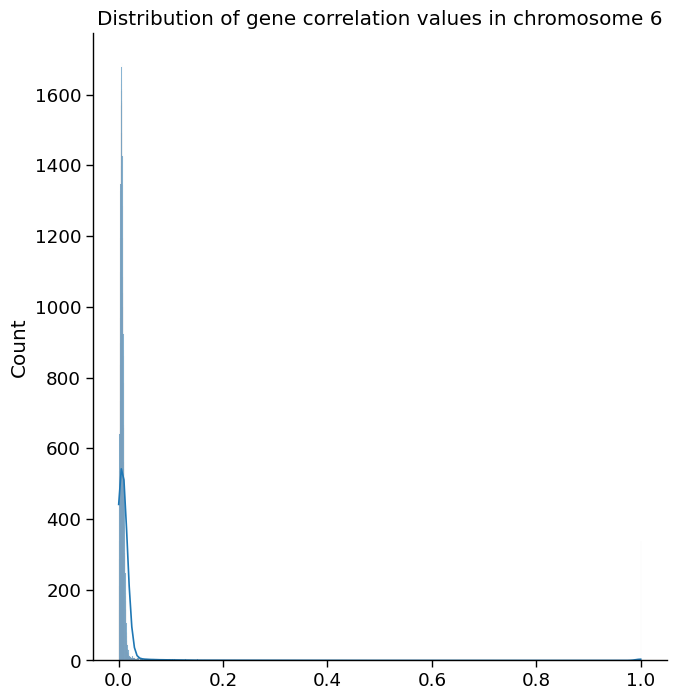

In [41]:
with sns.plotting_context("paper", font_scale=1.5):
    g = sns.displot(gene_corrs_flat, kde=True, height=7)
    g.ax.set_title(
        f"Distribution of gene correlation values in chromosome {CHROMOSOME}"
    )

## Plot: heatmap

In [42]:
vmin_val = min(0.00, gene_corrs_quantiles[0.10])
vmax_val = max(0.05, gene_corrs_quantiles[0.90])
display(f"{vmin_val} / {vmax_val}")

'0.0 / 0.05'

Text(0.5, 1.0, 'Gene correlations in chromosome 6')

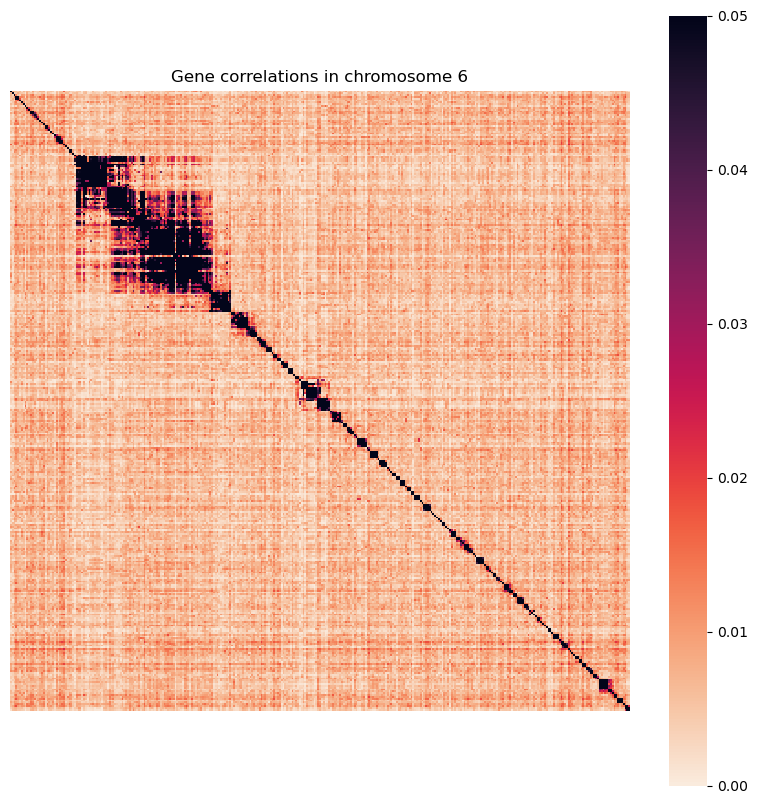

In [43]:
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(
    gene_corrs_df,
    xticklabels=False,
    yticklabels=False,
    square=True,
    vmin=vmin_val,
    vmax=vmax_val,
    cmap="rocket_r",
    ax=ax,
)
ax.set_title(f"Gene correlations in chromosome {CHROMOSOME}")